# Projet 1 : Quel est l'artiste

## Import des librairies

In [ ]:
# Utils
import os
import shutil
import time


# Maths - Stats
from sklearn.utils import shuffle
import numpy as np
import pandas as pd
import random as rd

# Data visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Deep Learning Librairies
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

## Import des données

In [ ]:
!git clone https://plmlab.math.cnrs.fr/chevallier-teaching/datasets/art-challenge.git

Cloning into 'art-challenge'...
remote: Enumerating objects: 17127, done.
remote: Counting objects: 100% (4373/4373), done.
remote: Compressing objects: 100% (4367/4367), done.
remote: Total 17127 (delta 36), reused 4251 (delta 6), pack-reused 12754 (from 1)
Receiving objects: 100% (17127/17127), 2.16 GiB | 12.77 MiB/s, done.
Resolving deltas: 100% (170/170), done.
Updating files: 100% (16806/16806), done.


In [ ]:
# tf.config.list_physical_devices()
[k.device_type for k in tf.config.list_physical_devices()]

['CPU', 'GPU']

In [ ]:
# prompt: code pour connaitre mon path

print(os.getcwd())


/content


In [ ]:
# prompt: liste des dossier dans content

import os

print(os.listdir('/content'))

['.config', 'art-challenge', 'sample_data']


### Chargement du dataset

In [ ]:
# prompt: charger le dataframe artist csv placer dans le dossier art challenge

import pandas as pd

# Assuming the CSV file is in the 'art-challenge' directory
df_artists = pd.read_csv('art-challenge/artists.csv')

# Print some info to verify it loaded correctly
print(df_artists.head())

   id                name        years                         genre  \
0   0   Amedeo Modigliani  1884 - 1920                 Expressionism   
1   1  Vasiliy Kandinskiy  1866 - 1944  Expressionism,Abstractionism   
2   2        Diego Rivera  1886 - 1957       Social Realism,Muralism   
3   3        Claude Monet  1840 - 1926                 Impressionism   
4   4       Rene Magritte  1898 - 1967      Surrealism,Impressionism   

  nationality                                                bio  \
0     Italian  Amedeo Clemente Modigliani (Italian pronunciat...   
1     Russian  Wassily Wassilyevich Kandinsky (Russian: Васи́...   
2     Mexican  Diego María de la Concepción Juan Nepomuceno E...   
3      French  Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...   
4     Belgian  René François Ghislain Magritte (French: [ʁəne...   

                                        wikipedia  paintings  
0  http://en.wikipedia.org/wiki/Amedeo_Modigliani        193  
1  http://en.wikipedia.org/wiki/

In [ ]:
df_artists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           50 non-null     int64 
 1   name         50 non-null     object
 2   years        50 non-null     object
 3   genre        50 non-null     object
 4   nationality  50 non-null     object
 5   bio          50 non-null     object
 6   wikipedia    50 non-null     object
 7   paintings    50 non-null     int64 
dtypes: int64(2), object(6)
memory usage: 3.2+ KB


In [ ]:
df_artists.describe()

,id,paintings
count,50.00000,50.000000
mean,24.50000,168.920000
std,14.57738,157.451105
min,0.00000,24.000000
25%,12.25000,81.000000
50%,24.50000,123.000000
75%,36.75000,191.750000
max,49.00000,877.000000


In [ ]:
df_artists.columns

Index(['id', 'name', 'years', 'genre', 'nationality', 'bio', 'wikipedia',
       'paintings'],
      dtype='object')

In [ ]:
df_artists['id'] = df_artists['id'].astype('category')

In [ ]:
df_artists.describe()

,paintings
count,50.000000
mean,168.920000
std,157.451105
min,24.000000
25%,81.000000
50%,123.000000
75%,191.750000
max,877.000000


In [ ]:
# prompt: nombre total des paintings ( c'est à dire somme de tout les paintings)

total_paintings = df_artists['paintings'].sum()
print(f"Total number of paintings: {total_paintings}")

Total number of paintings: 8446


In [ ]:
# 5. Vérification des valeurs manquantes
print("\nValeurs manquantes dans le DataFrame :")
print(df_artists.isnull().sum())  # Nombre de valeurs manquantes par colonne

# 6. Exploration des colonnes catégorielles : 'id', 'genre', 'nationality'
print("\nValeurs uniques dans la colonne 'id' (identifiant catégoriel) :")
print(df_artists['id'].nunique())  # Nombre d'ID uniques

print("\nValeurs uniques dans la colonne 'genre' :")
print(df_artists['genre'].value_counts())  # Comptage des occurrences par genre

print("\nValeurs uniques dans la colonne 'nationality' :")
print(df_artists['nationality'].value_counts())  # Comptage des occurrences par nationalité


Valeurs manquantes dans le DataFrame :
id             0
name           0
years          0
genre          0
nationality    0
bio            0
wikipedia      0
paintings      0
dtype: int64

Valeurs uniques dans la colonne 'id' (identifiant catégoriel) :
50

Valeurs uniques dans la colonne 'genre' :
genre
Impressionism                              4
Baroque                                    4
Post-Impressionism                         4
Northern Renaissance                       4
Romanticism                                3
High Renaissance                           3
Surrealism                                 2
Impressionism,Post-Impressionism           2
Primitivism                                2
High Renaissance,Mannerism                 1
Early Renaissance                          1
Symbolism,Expressionism                    1
Realism                                    1
Expressionism,Abstractionism,Surrealism    1
Neoplasticism                              1
Pop Art            

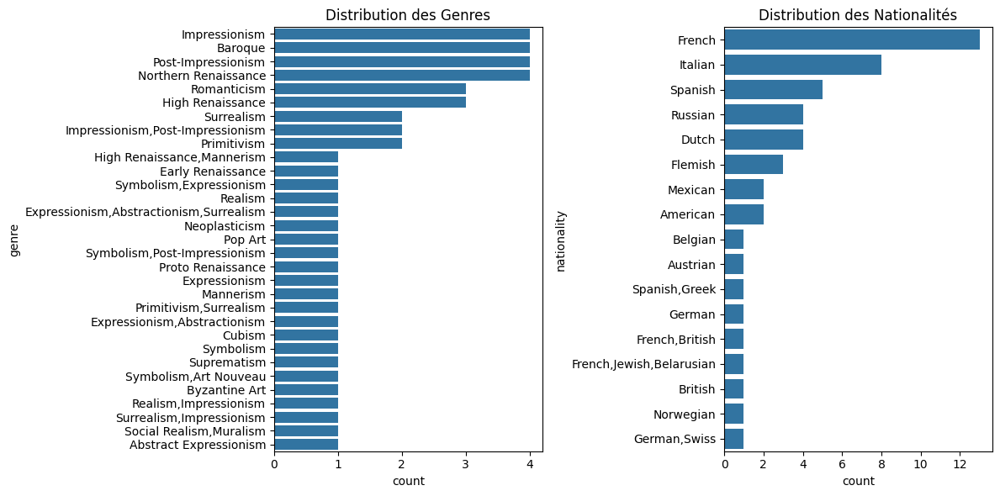

In [ ]:
# 7. Visualisation des variables catégorielles : 'genre', 'nationality'
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(y='genre', data=df_artists, order=df_artists['genre'].value_counts().index)
plt.title("Distribution des Genres")

plt.subplot(1, 2, 2)
sns.countplot(y='nationality', data=df_artists, order=df_artists['nationality'].value_counts().index)
plt.title("Distribution des Nationalités")

plt.tight_layout()
plt.show()


Statistiques sur la colonne 'paintings' (nombre de tableaux) :
count     50.000000
mean     168.920000
std      157.451105
min       24.000000
25%       81.000000
50%      123.000000
75%      191.750000
max      877.000000
Name: paintings, dtype: float64


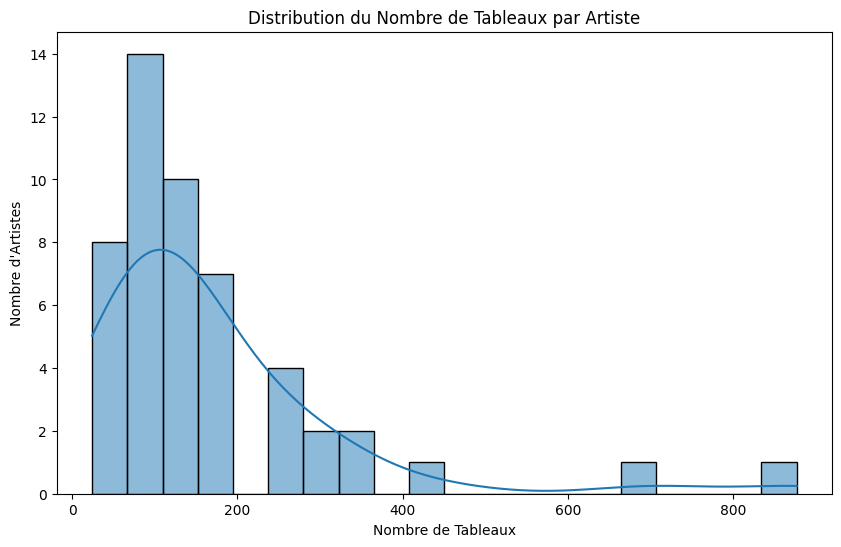

In [ ]:
# 8. Exploration de la colonne 'paintings' (nombre de tableaux)
print("\nStatistiques sur la colonne 'paintings' (nombre de tableaux) :")
print(df_artists['paintings'].describe())

# Visualisation du nombre de tableaux par artiste
plt.figure(figsize=(10, 6))
sns.histplot(df_artists['paintings'], bins=20, kde=True)
plt.title("Distribution du Nombre de Tableaux par Artiste")
plt.xlabel("Nombre de Tableaux")
plt.ylabel("Nombre d'Artistes")
plt.show()

In [ ]:
# 9. Exploration des artistes présents sur Wikipedia
print("\nArtistes avec un lien Wikipedia :")
print(df_artists['wikipedia'].notnull().sum())  # Nombre d'artistes avec une page Wikipedia

print("\nArtistes sans lien Wikipedia :")
print(df_artists['wikipedia'].isnull().sum())  # Nombre d'artistes sans page Wikipedia


Artistes avec un lien Wikipedia :
50

Artistes sans lien Wikipedia :
0


In [ ]:
# 10. Analyse des biographies (longueur des bios)
df_artists['bio_length'] = df_artists['bio'].str.len()

print("\nStatistiques sur la longueur des biographies :")
print(df_artists['bio_length'].describe())


Statistiques sur la longueur des biographies :
count      50.00000
mean      686.42000
std       441.36454
min       142.00000
25%       390.25000
50%       568.00000
75%       830.75000
max      2415.00000
Name: bio_length, dtype: float64


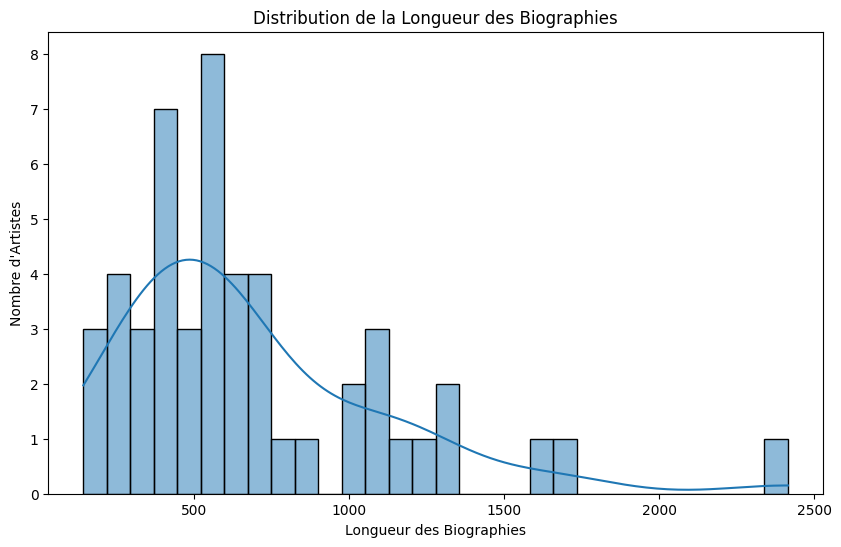

In [ ]:
# Visualisation de la longueur des biographies
plt.figure(figsize=(10, 6))
sns.histplot(df_artists['bio_length'], bins=30, kde=True)
plt.title("Distribution de la Longueur des Biographies")
plt.xlabel("Longueur des Biographies")
plt.ylabel("Nombre d'Artistes")
plt.show()

## Prediction

### Chargement du data set

In [ ]:
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# 1. Définir le chemin vers le dossier d'images
data_dir = 'art-challenge/images_hq'

# 2. Définir les transformations pour les images
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Redimensionner les images à 224x224 (comme dans ResNet, VGG, etc.)
    transforms.ToTensor(),          # Convertir les images en tenseurs PyTorch
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalisation avec des moyennes et std communes pour les images
])

# 3. Utiliser ImageFolder pour charger les images en fonction de la structure du dossier
art_dataset = datasets.ImageFolder(root=data_dir, transform=transform)

# 4. Utiliser DataLoader pour créer des batches et mélanger les images
art_loader = DataLoader(art_dataset, batch_size=128, shuffle=True)

# 5. Vérifier la classe d'une image et son label
for images, labels in art_loader:
    print(images.shape)  # Affiche la taille du batch, par exemple torch.Size([128, 3, 224, 224]) pour un batch de 128 images
    print(labels)        # Affiche les labels (numéro de classe pour chaque artiste)
    break  # On quitte après un batch pour éviter d'afficher tout le dataset

torch.Size([128, 3, 224, 224])
tensor([15, 13, 38,  2, 15, 48,  0,  9, 41,  2, 36, 48,  0, 46, 38, 10, 35, 33,
        15, 38, 43, 47, 35, 48, 40,  3,  2, 10,  0, 37,  0, 41, 28, 40, 48, 10,
        31,  6, 40, 30, 46, 10, 36, 35, 21, 40, 19, 46,  1,  9, 48, 48,  0, 18,
        15, 10, 37, 42, 33, 42,  5, 48, 35, 10, 35, 46, 27, 24,  1, 10, 42, 29,
        41, 43, 10, 45, 44, 38, 41, 33, 35, 24, 33, 29,  2,  8, 48, 49, 38, 11,
        26,  5, 36, 33, 32, 48, 30, 22,  4, 10, 48, 35,  9, 10, 45, 10, 10, 15,
        12, 48, 45, 13, 15, 10, 44, 32, 41, 10, 32, 40, 30, 18, 48, 21, 44, 36,
        35, 46])


### Afficher 10 images au hasard dans mon art_dataset et le nom de l'artist sous forme d'un subplot 2 par 5

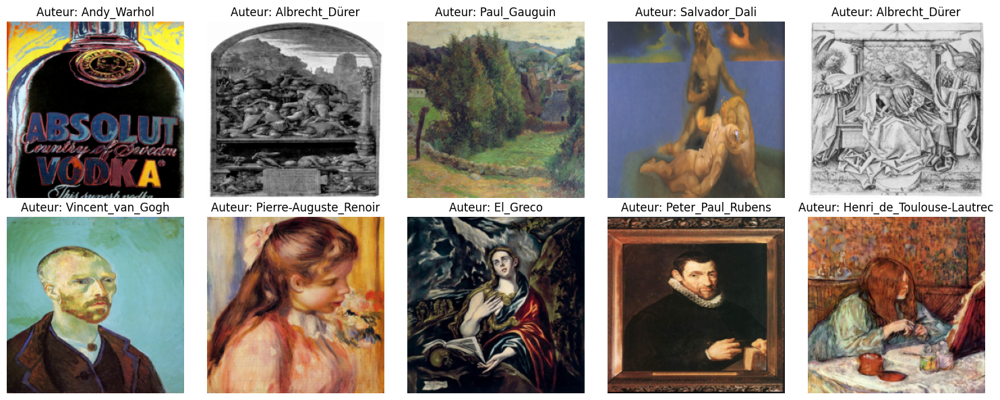

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sélectionner 10 images aléatoires
num_images = 10
random_indices = np.random.choice(len(art_dataset), size=num_images, replace=False)

# Créer un subplot 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i, index in enumerate(random_indices):
    image, label = art_dataset[index]
    # Convertir l'image tensor en numpy array
    image_np = image.numpy().transpose((1, 2, 0))
    # Dénormaliser l'image
    image_np = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    # Clipping des valeurs en dehors de la plage 0-1
    image_np = np.clip(image_np, 0, 1)

    # Afficher l'image et le label
    row = i // 5
    col = i % 5
    axes[row, col].imshow(image_np)
    axes[row, col].set_title(f"Auteur: {art_dataset.classes[label]}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

### Separer art_dataset en train et test

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming 'art_dataset' is your dataset with images and labels
train_dataset, test_dataset = train_test_split(art_dataset, test_size=0.2, random_state=42)

print(f"Training dataset size: {len(train_dataset)}")
print(f"Testing dataset size: {len(test_dataset)}")

Training dataset size: 6756
Testing dataset size: 1690


In [ ]:
IM_SIZE = train_dataset[10][0].shape[2]
INPUT_SHAPE = (IM_SIZE, IM_SIZE, 3)
print(INPUT_SHAPE)

(224, 224, 3)


### Construire notre Réseaux

In [ ]:
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, Input
from tensorflow.keras.models import Model, Sequential

In [ ]:
cnn_simple = Sequential()
cnn_simple.add(Input(shape= INPUT_SHAPE))

cnn_simple.add(Conv2D(32, (3,3), activation='relu'))
cnn_simple.add(MaxPooling2D(pool_size=(2,2)))

cnn_simple.add(Conv2D(64, (3,3), activation='relu'))
cnn_simple.add(MaxPooling2D(pool_size=(2,2)))

cnn_simple.add(Conv2D(96, (3,3), activation='relu'))
cnn_simple.add(MaxPooling2D(pool_size=(2,2)))

#cnn_simple.add(Conv2D(128, (3,3), activation='relu'))
#cnn_simple.add(MaxPooling2D(pool_size=(2,2)))

cnn_simple.add(Flatten())
# cnn_simple.add(Dense(512, activation='relu'))
cnn_simple.add(Dense(64, activation='relu'))
cnn_simple.add(Dropout(0.5))
cnn_simple.add(Dense(50, activation='softmax'))

cnn_simple.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 96)          │          55,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 96)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 64896)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │       4,153,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           3,250 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,231,442 (16.14 MB)

 Trainable params: 4,231,442 (16.14 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
cnn_simple.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=3e-4),
    metrics = ['accuracy'])

In [ ]:
epochs = 2

cnn_simple_history = cnn_simple.fit(
    train_dataset,
    batch_size = 15,
    epochs = epochs
)

ValueError: Unrecognized data type: x=[(tensor([[[-1.5185, -1.5870, -1.6898,  ...,  0.8618,  0.7762,  0.8618],
         [-1.1247, -1.3815, -1.7240,  ...,  0.8789,  0.9132,  0.8104],
         [-1.1932, -1.5185, -1.7754,  ...,  0.8104,  0.9474,  0.7933],
         ...,
         [-0.4739, -0.1657,  0.2282,  ...,  0.0569, -0.0629,  0.0227],
         [-0.3541,  0.1083,  0.5193,  ..., -0.1657, -0.0629, -0.0458],
         [-0.0458,  0.5707,  0.9817,  ...,  0.0227,  0.0056,  0.1939]],

        [[-1.1429, -1.2654, -1.4230,  ..., -0.2150, -0.3025, -0.1975],
         [-0.8102, -1.0903, -1.4755,  ..., -0.1625, -0.1275, -0.2325],
         [-0.9153, -1.2479, -1.4755,  ..., -0.1975, -0.0399, -0.1975],
         ...,
         [-0.9678, -0.6877, -0.3025,  ...,  0.0126, -0.1275, -0.0399],
         [-0.8102, -0.3550,  0.0651,  ..., -0.1800, -0.0749, -0.0574],
         [-0.3725,  0.2402,  0.6779,  ..., -0.0049, -0.0049,  0.1877]],

        [[-1.4907, -1.5430, -1.6127,  ..., -1.6127, -1.6824, -1.6824],
         [-1.3513, -1.4384, -1.5779,  ..., -1.6127, -1.5779, -1.6824],
         [-1.5081, -1.6127, -1.6302,  ..., -1.6476, -1.5081, -1.6302],
         ...,
         [-1.7173, -1.6999, -1.6476,  ..., -0.9853, -1.1421, -1.0898],
         [-1.7173, -1.5081, -1.2119,  ..., -1.2119, -1.1247, -1.1421],
         [-1.5081, -1.0376, -0.6193,  ..., -1.0550, -1.0724, -0.9156]]]), 16), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.8893, 1.8722, 1.7865,  ..., 1.2214, 1.2728, 1.3242],
         [1.7352, 1.8550, 1.8208,  ..., 1.3584, 1.4269, 1.4783],
         [1.8379, 1.8037, 1.7865,  ..., 1.5982, 1.5125, 1.4440]],

        [[2.3235, 2.3235, 2.3060,  ..., 2.3060, 2.3060, 2.3060],
         [2.3235, 2.3235, 2.3060,  ..., 2.3060, 2.2885, 2.2885],
         [2.3060, 2.3060, 2.3060,  ..., 2.2885, 2.2885, 2.2885],
         ...,
         [1.9559, 1.9384, 1.8508,  ..., 1.4132, 1.4657, 1.5182],
         [1.7983, 1.9209, 1.8859,  ..., 1.5532, 1.6232, 1.6758],
         [1.9034, 1.8683, 1.8508,  ..., 1.7983, 1.7108, 1.6408]],

        [[2.1520, 2.1868, 2.2217,  ..., 2.4657, 2.4831, 2.4831],
         [2.2043, 2.2217, 2.2566,  ..., 2.5006, 2.5354, 2.5354],
         [2.2914, 2.2914, 2.3088,  ..., 2.5703, 2.5877, 2.5877],
         ...,
         [1.9254, 1.9080, 1.8208,  ..., 1.4025, 1.4548, 1.5071],
         [1.7685, 1.8905, 1.8557,  ..., 1.5420, 1.6117, 1.6640],
         [1.8731, 1.8383, 1.8208,  ..., 1.7860, 1.6988, 1.6291]]]), 23), (tensor([[[-0.5938, -0.0287, -0.1143,  ..., -1.7240, -1.7069, -1.7583],
         [ 0.0056,  0.6734,  0.6734,  ..., -1.4500, -1.2959, -1.2274],
         [ 0.2624,  0.7077,  0.8104,  ..., -1.4672, -1.1932, -0.8335],
         ...,
         [ 0.7419,  0.8618,  0.9817,  ...,  0.3309,  0.2967,  0.4337],
         [ 0.7419,  0.8961,  1.0159,  ...,  0.3652,  0.2796,  0.3823],
         [ 0.8104,  0.9474,  0.9646,  ...,  0.3481,  0.3481,  0.4166]],

        [[-0.6001,  0.0476, -0.0049,  ..., -1.5280, -1.5805, -1.6681],
         [ 0.0476,  0.8179,  0.8529,  ..., -1.2304, -1.1429, -1.1078],
         [ 0.3627,  0.8880,  1.0280,  ..., -1.2479, -1.0203, -0.6877],
         ...,
         [ 0.4678,  0.5553,  0.6604,  ...,  0.0301, -0.0224,  0.1176],
         [ 0.4153,  0.5553,  0.6429,  ...,  0.0126, -0.0749,  0.0126],
         [ 0.4503,  0.5903,  0.6078,  ..., -0.0574, -0.0574,  0.0126]],

        [[-0.7064, -0.1661, -0.1835,  ..., -1.3513, -1.4384, -1.5430],
         [-0.1138,  0.5136,  0.6008,  ..., -1.1073, -1.0724, -1.0724],
         [ 0.1825,  0.6008,  0.7576,  ..., -1.2293, -1.0201, -0.7413],
         ...,
         [-0.5670, -0.2881, -0.0964,  ..., -0.8981, -0.8807, -0.6890],
         [-0.4798, -0.2358, -0.0964,  ..., -0.9330, -1.0027, -0.8458],
         [-0.3055, -0.1661, -0.1487,  ..., -1.0027, -1.0550, -0.8807]]]), 38), (tensor([[[ 0.0227,  0.3481,  0.3652,  ...,  1.3755,  1.1872,  1.0502],
         [ 0.1083,  0.4851,  0.5878,  ...,  1.3927,  1.4612,  1.2899],
         [ 0.1426,  0.5193,  0.6563,  ...,  1.4783,  1.5468,  1.4783],
         ...,
         [ 1.1015,  1.5125,  1.6153,  ...,  1.2899,  0.9646,  0.5193],
         [ 1.0502,  1.4269,  1.6324,  ...,  1.1529,  0.9474,  0.7077],
         [ 0.8618,  1.3755,  1.3927,  ...,  1.2043,  1.0331,  0.8961]],

        [[ 0.0126,  0.0826, -0.1975,  ..., -0.7402, -0.6702, -0.4251],
         [ 0.0301,  0.1527, -0.0924,  ..., -0.6001, -0.4426, -0.4426],
         [-0.0749,  0.0651,  0.0126,  ..., -0.0399,  0.0651, -0.0049],
         ...,
         [-0.1450,  0.2227,  0.2227,  ...,  0.6429,  0.4153,  0.0301],
         [-0.4601, -0.0749,  0.1352,  ...,  0.5553,  0.4503,  0.2927],
         [-0.6176, -0.0574,  0.0476,  ...,  0.6779,  0.5728,  0.5378]],

        [[-0.1487, -0.3230, -0.7761,  ..., -1.0376, -1.0027, -0.8284],
         [-0.1835, -0.2532, -0.6367,  ..., -1.1247, -0.9853, -1.0376],
         [-0.4101, -0.3055, -0.4275,  ..., -1.1421, -1.0898, -1.1770],
         ...,
         [-0.7936, -0.8458, -1.0550,  ...,  0.1999,  0.1825, -0.0267],
         [-0.9504, -0.9853, -1.0201,  ...,  0.1825,  0.2348,  0.1999],
         [-0.9853, -0.7936, -0.8458,  ...,  0.3568,  0.3916,  0.4439]]]), 3), (tensor([[[ 0.9132,  0.9817,  1.1358,  ...,  0.4508,  0.4851,  0.3823],
         [ 0.9817,  0.8104,  0.7077,  ...,  0.5536,  0.4508,  0.3823],
         [ 0.9646,  0.7077,  0.5536,  ...,  0.5707,  0.5022,  0.2111],
         ...,
         [-1.3815, -1.4843, -1.5357,  ..., -0.3541, -0.4568, -0.4054],
         [-1.1589, -1.1247, -1.2788,  ..., -0.4568, -0.4911, -0.4226],
         [-0.9020, -0.6452, -0.8678,  ..., -0.4911, -0.6109, -0.6109]],

        [[ 1.2731,  1.3606,  1.5007,  ...,  0.8529,  0.8529,  0.7304],
         [ 1.3782,  1.1856,  1.0805,  ...,  0.9580,  0.8179,  0.7304],
         [ 1.3957,  1.0980,  0.9580,  ...,  0.9755,  0.8880,  0.5728],
         ...,
         [-1.2304, -1.3179, -1.3354,  ..., -0.0049, -0.0224, -0.0574],
         [-1.0378, -0.9853, -1.0728,  ..., -0.0749, -0.0224, -0.0224],
         [-0.7577, -0.5476, -0.7052,  ..., -0.0749, -0.0749, -0.1275]],

        [[ 1.2282,  1.2980,  1.4548,  ...,  1.2980,  1.1759,  0.9668],
         [ 1.3677,  1.2457,  1.0888,  ...,  1.3154,  1.1237,  1.0017],
         [ 1.4722,  1.2980,  1.0191,  ...,  1.3677,  1.1062,  0.7054],
         ...,
         [-1.2990, -1.2816, -1.2119,  ..., -0.4275, -0.3753, -0.5321],
         [-1.1073, -1.0376, -1.0724,  ..., -0.4624, -0.3230, -0.4275],
         [-0.8458, -0.6715, -0.7936,  ..., -0.4624, -0.3927, -0.4101]]]), 5), (tensor([[[1.9064, 1.8893, 1.8722,  ..., 2.0777, 2.0605, 2.0948],
         [1.9235, 1.9235, 1.9064,  ..., 2.0777, 2.0777, 2.0777],
         [1.9064, 1.9407, 1.9235,  ..., 2.0777, 2.0777, 2.0948],
         ...,
         [2.0092, 2.0092, 1.9578,  ..., 2.1290, 2.1290, 2.1290],
         [2.0092, 2.0263, 2.0263,  ..., 2.1290, 2.1290, 2.1290],
         [2.0263, 2.0263, 2.0263,  ..., 2.1290, 2.1290, 2.1119]],

        [[2.0959, 2.0784, 2.0609,  ..., 2.2185, 2.1835, 2.1835],
         [2.1134, 2.1134, 2.0959,  ..., 2.2185, 2.2010, 2.1835],
         [2.0959, 2.1310, 2.0959,  ..., 2.2010, 2.2010, 2.2185],
         ...,
         [2.2360, 2.1660, 2.0959,  ..., 2.3060, 2.3060, 2.3060],
         [2.2360, 2.2185, 2.2010,  ..., 2.3060, 2.3060, 2.3060],
         [2.2360, 2.2185, 2.2185,  ..., 2.3060, 2.3060, 2.2885]],

        [[2.1694, 2.1520, 2.1346,  ..., 2.3088, 2.2740, 2.2914],
         [2.1868, 2.1868, 2.1694,  ..., 2.2914, 2.2914, 2.2740],
         [2.1694, 2.2043, 2.1694,  ..., 2.2914, 2.2914, 2.3088],
         ...,
         [2.2914, 2.2043, 2.0997,  ..., 2.3611, 2.3786, 2.3786],
         [2.2914, 2.3088, 2.2740,  ..., 2.3786, 2.3786, 2.3786],
         [2.2914, 2.2914, 2.2914,  ..., 2.3786, 2.3786, 2.3611]]]), 15), (tensor([[[-0.2513, -0.3541, -0.1828,  ...,  0.0912,  0.3138,  0.2111],
         [-0.1828, -0.2171, -0.2856,  ...,  0.2453,  0.4337,  0.4508],
         [ 0.0056, -0.1143, -0.1828,  ...,  0.0569,  0.3823,  0.4679],
         ...,
         [ 1.1358,  1.1015,  1.0844,  ...,  0.3823,  0.2796,  0.3652],
         [ 1.1187,  1.1529,  1.0159,  ...,  0.5022,  0.4508,  0.4337],
         [ 1.2557,  0.9988,  0.8447,  ...,  0.4851,  0.5022,  0.4679]],

        [[-0.3200, -0.6352, -0.5476,  ...,  0.0126,  0.0126, -0.0399],
         [-0.3375, -0.5126, -0.5826,  ...,  0.1527,  0.1527,  0.1877],
         [-0.2325, -0.4251, -0.4426,  ..., -0.0749,  0.0651,  0.1877],
         ...,
         [-0.1099, -0.1625, -0.1800,  ..., -0.4951, -0.6352, -0.5651],
         [-0.0749, -0.0399, -0.1625,  ..., -0.3550, -0.4426, -0.4776],
         [ 0.1352, -0.1275, -0.2850,  ..., -0.3375, -0.3550, -0.4076]],

        [[-0.5147, -0.8981, -0.7936,  ..., -0.2707, -0.5321, -0.6193],
         [-0.5147, -0.7761, -0.8633,  ..., -0.1487, -0.4101, -0.4101],
         [-0.3927, -0.6715, -0.7238,  ..., -0.3927, -0.5321, -0.4450],
         ...,
         [-1.2119, -1.2467, -1.2641,  ..., -1.4733, -1.5604, -1.4907],
         [-1.1421, -1.1073, -1.2467,  ..., -1.4036, -1.4733, -1.4559],
         [-0.9330, -1.1944, -1.3513,  ..., -1.4559, -1.4733, -1.4733]]]), 33), (tensor([[[-1.1075, -1.1075, -1.1247,  ...,  0.2624,  0.2624,  0.3138],
         [-1.0390, -1.0733, -0.8849,  ...,  0.8961,  0.4851, -0.4054],
         [-1.0048, -1.0219, -0.0287,  ...,  1.8208,  1.1529, -0.7479],
         ...,
         [-0.5424, -0.5253, -0.6623,  ..., -0.2342,  0.0741,  0.3823],
         [-0.6281, -0.7650, -0.8335,  ..., -0.5938, -0.5253, -0.3883],
         [-0.2342, -0.6623, -0.7650,  ..., -0.9192, -0.7137, -0.4568]],

        [[-0.9328, -1.0028, -1.0378,  ..., -0.1275, -0.1275, -0.0399],
         [-1.0553, -1.0903, -0.9678,  ...,  0.7829,  0.3803, -0.5126],
         [-1.0728, -1.0378, -0.1975,  ...,  1.9209,  1.2206, -0.7227],
         ...,
         [-0.9153, -0.8452, -1.0028,  ..., -0.6527, -0.3375, -0.0574],
         [-1.0553, -1.1604, -1.2304,  ..., -1.0553, -1.0378, -0.8978],
         [-0.8102, -1.1779, -1.2304,  ..., -1.3704, -1.2129, -1.0028]],

        [[-0.5844, -0.6193, -0.5670,  ..., -0.1835, -0.2532, -0.3230],
         [-0.4624, -0.5844, -0.6018,  ...,  1.2805,  0.8099, -0.2184],
         [-0.6541, -0.7413, -0.2010,  ...,  2.2914,  1.6291, -0.3055],
         ...,
         [-0.8284, -1.0201, -1.0898,  ..., -0.7064, -0.7238, -0.4798],
         [-0.8981, -1.2467, -1.2641,  ..., -1.0550, -1.0027, -0.9156],
         [-0.4973, -1.1770, -1.2293,  ..., -1.2467, -1.0898, -0.8807]]]), 18), (tensor([[[-0.0629, -0.1143,  0.1083,  ...,  0.2967,  0.2967,  0.2967],
         [ 0.1939, -0.1486, -0.2684,  ..., -0.1828, -0.2342, -0.1828],
         [-0.1657, -0.3027, -0.4054,  ..., -0.4226, -0.1314, -0.3369],
         ...,
         [-0.7479, -0.4226, -0.3541,  ..., -1.0733, -0.9363, -0.2342],
         [-0.2513,  0.0056,  0.1939,  ..., -0.8507, -0.7650, -0.0458],
         [-0.0801,  0.0741,  0.2967,  ..., -0.6109, -0.4226,  0.3481]],

        [[ 0.0651,  0.1001,  0.3452,  ...,  0.4678,  0.4853,  0.4328],
         [ 0.4328,  0.0476, -0.0399,  ..., -0.0924, -0.1450, -0.0924],
         [ 0.0476, -0.0924, -0.1275,  ..., -0.2850,  0.0126, -0.1625],
         ...,
         [-0.8452, -0.6001, -0.7052,  ..., -1.0028, -0.8627, -0.2150],
         [-0.6001, -0.3901, -0.2325,  ..., -0.8102, -0.7752, -0.0749],
         [-0.2500, -0.1625,  0.0651,  ..., -0.6352, -0.5651,  0.2052]],

        [[-0.0790, -0.0441,  0.2348,  ...,  0.3045,  0.3568,  0.3393],
         [ 0.2871, -0.0790, -0.1661,  ..., -0.3404, -0.4450, -0.3230],
         [-0.1138, -0.2184, -0.1835,  ..., -0.5495, -0.2707, -0.3578],
         ...,
         [-1.1944, -1.0376, -1.0898,  ..., -1.1770, -1.1073, -0.3055],
         [-1.0724, -0.9678, -0.8807,  ..., -1.0724, -1.0724, -0.2358],
         [-0.5321, -0.4798, -0.3230,  ..., -0.9853, -0.8807, -0.0092]]]), 45), (tensor([[[0.6563, 0.6563, 0.6049,  ..., 0.3652, 0.4166, 0.4166],
         [0.7248, 0.7077, 0.5878,  ..., 0.3138, 0.4166, 0.3823],
         [0.7419, 0.6392, 0.5707,  ..., 0.3309, 0.4679, 0.4166],
         ...,
         [1.5468, 1.6838, 1.6153,  ..., 0.8447, 0.8104, 0.8276],
         [1.5810, 1.7180, 1.5639,  ..., 0.8961, 0.8447, 0.8447],
         [1.5982, 1.7352, 1.5468,  ..., 0.9303, 0.9817, 0.8789]],

        [[0.9055, 0.9580, 0.9755,  ..., 0.7479, 0.6429, 0.6429],
         [0.9930, 1.0280, 0.9580,  ..., 0.6954, 0.6604, 0.6254],
         [1.0455, 0.9930, 0.9930,  ..., 0.7304, 0.7129, 0.6779],
         ...,
         [1.2731, 1.4132, 1.3431,  ..., 0.7304, 0.6779, 0.6954],
         [1.3081, 1.4482, 1.2906,  ..., 0.7829, 0.7129, 0.7304],
         [1.3256, 1.4657, 1.2731,  ..., 0.7654, 0.7829, 0.7304]],

        [[0.7751, 0.8797, 0.7576,  ..., 1.4897, 1.3677, 1.4025],
         [1.0017, 1.0191, 0.8622,  ..., 1.4897, 1.2980, 1.2457],
         [1.1237, 0.9842, 0.9319,  ..., 1.4897, 1.3154, 1.2108],
         ...,
         [1.4200, 1.5420, 1.4722,  ..., 0.9145, 0.8797, 0.8971],
         [1.4548, 1.5942, 1.4374,  ..., 0.9494, 0.8797, 0.8971],
         [1.5071, 1.5594, 1.3502,  ..., 0.9319, 0.8622, 0.8971]]]), 7), (tensor([[[ 0.0227,  0.2282,  0.5536,  ...,  0.2282,  0.1426,  0.0569],
         [-0.0629,  0.2967,  0.5536,  ...,  0.4337,  0.0227,  0.0398],
         [ 0.0912,  0.0912,  0.4337,  ...,  0.2453, -0.1143, -0.0629],
         ...,
         [-1.0390, -0.7137, -0.3198,  ...,  0.0398,  0.0398, -0.3369],
         [-0.4397, -1.0562, -0.7822,  ..., -0.5253, -0.6281, -0.3198],
         [-0.6623, -0.7993, -0.7137,  ..., -0.7137, -0.6623, -0.2171]],

        [[ 0.3627,  0.5728,  0.9405,  ...,  0.9405,  0.9930,  0.8880],
         [ 0.3627,  0.5903,  0.9930,  ...,  1.2731,  0.8529,  0.8354],
         [ 0.5028,  0.5028,  0.9055,  ...,  1.1331,  0.5553,  0.6429],
         ...,
         [-0.7052, -0.2850,  0.1352,  ...,  0.2752,  0.1877, -0.1800],
         [-0.0399, -0.6527, -0.2150,  ..., -0.3025, -0.4251, -0.1800],
         [-0.3901, -0.4076, -0.1975,  ..., -0.4426, -0.3550, -0.0399]],

        [[ 1.0191,  1.2457,  1.4025,  ...,  1.7511,  1.8383,  1.9080],
         [ 1.3154,  1.2805,  1.4025,  ...,  2.0300,  1.8208,  1.8731],
         [ 1.4374,  1.4897,  1.6640,  ...,  2.0474,  1.3851,  1.5071],
         ...,
         [-0.1312,  0.0605,  0.2696,  ..., -0.0092, -0.0615, -0.3753],
         [ 0.3742, -0.2358,  0.0082,  ..., -0.1312, -0.2707, -0.2707],
         [ 0.0256, -0.1487, -0.0092,  ..., -0.2184, -0.2881, -0.1487]]]), 1), (tensor([[[-0.7479, -0.7137, -0.7137,  ...,  0.3138,  0.2624,  0.3138],
         [-0.9020, -0.9192, -0.7993,  ...,  0.2624,  0.2624,  0.2453],
         [-0.8164, -0.8849, -0.7650,  ...,  0.2967,  0.2967,  0.3138],
         ...,
         [-1.4843, -1.6898, -1.7583,  ..., -1.5185, -1.4158, -1.2788],
         [-1.4329, -1.6213, -1.7240,  ..., -1.3130, -1.4158, -1.2617],
         [-1.4672, -1.6555, -1.7412,  ..., -1.4158, -1.3302, -1.1760]],

        [[-0.4951, -0.4426, -0.4601,  ...,  1.0105,  0.8704,  0.8179],
         [-0.6527, -0.6877, -0.5826,  ...,  0.9930,  0.9230,  0.7479],
         [-0.5651, -0.6001, -0.4951,  ...,  0.9930,  0.9755,  0.8529],
         ...,
         [-1.3004, -1.5805, -1.6506,  ..., -1.3354, -1.2129, -1.0728],
         [-1.2479, -1.5105, -1.6155,  ..., -1.1078, -1.2129, -1.0553],
         [-1.2654, -1.5280, -1.6681,  ..., -1.2654, -1.1253, -0.9678]],

        [[-0.9504, -0.9853, -0.9330,  ...,  1.1934,  0.6879,  0.4614],
         [-1.0376, -1.0724, -0.9853,  ...,  1.2457,  0.9494,  0.3916],
         [-1.0550, -1.1596, -1.0724,  ...,  1.3328,  1.2108,  0.6182],
         ...,
         [-1.4907, -1.6650, -1.6650,  ..., -1.5081, -1.4036, -1.2816],
         [-1.4210, -1.6302, -1.6650,  ..., -1.3513, -1.3687, -1.3164],
         [-1.4559, -1.6476, -1.7173,  ..., -1.4559, -1.2816, -1.2293]]]), 41), (tensor([[[ 0.6392,  0.9646,  0.9303,  ...,  1.1872,  1.1872,  1.0502],
         [ 0.6906,  0.9988,  0.8104,  ...,  1.1700,  1.1187,  0.9988],
         [ 0.8961,  1.1872,  0.9988,  ...,  1.2043,  1.1015,  0.9817],
         ...,
         [ 0.9988,  0.8276,  0.5707,  ...,  1.1358,  0.6734, -0.6965],
         [ 0.9646,  0.6734,  0.6563,  ...,  1.4269,  0.8447, -0.6281],
         [ 0.9303,  0.9132,  1.0673,  ...,  1.3070,  1.0844, -0.2513]],

        [[ 0.4503,  0.7479,  0.7479,  ...,  0.9755,  1.0105,  0.8704],
         [ 0.5028,  0.7654,  0.6078,  ...,  0.9230,  0.8529,  0.7129],
         [ 0.7304,  0.9230,  0.7829,  ...,  1.0105,  0.8704,  0.6954],
         ...,
         [ 0.7654,  0.6779,  0.5203,  ...,  0.9055,  0.3277, -0.7752],
         [ 0.7829,  0.4678,  0.4503,  ...,  1.2206,  0.5553, -0.6877],
         [ 0.7829,  0.7129,  0.8354,  ...,  1.1155,  0.8529, -0.3200]],

        [[ 0.6008,  0.8797,  0.8622,  ...,  1.0191,  0.9842,  0.9668],
         [ 0.7228,  0.8971,  0.6879,  ...,  0.8622,  0.7925,  0.8099],
         [ 0.9494,  1.0191,  0.8622,  ...,  0.9319,  0.8274,  0.7402],
         ...,
         [ 0.7576,  0.6705,  0.5485,  ...,  0.9319,  0.3219, -0.4101],
         [ 0.8099,  0.4962,  0.4614,  ...,  1.3154,  0.6182, -0.3230],
         [ 0.8622,  0.7925,  0.8971,  ...,  1.2805,  0.9668,  0.0256]]]), 35), (tensor([[[ 1.6667,  1.5468,  1.4269,  ...,  1.8893,  1.8722,  1.8722],
         [ 1.7352,  1.6667,  1.5639,  ...,  1.8893,  1.9064,  1.9064],
         [ 1.8208,  1.7694,  1.7523,  ...,  1.8379,  1.8550,  1.8379],
         ...,
         [-0.4226, -0.4739, -0.4226,  ..., -1.0048, -0.8507, -0.8849],
         [ 0.0569,  0.1939,  0.3309,  ..., -0.9877, -0.9877, -0.9705],
         [ 0.7419,  1.0331,  1.2385,  ..., -0.8678, -0.8335, -0.7137]],

        [[ 1.7108,  1.5882,  1.4482,  ...,  1.9559,  2.0084,  2.0434],
         [ 1.7808,  1.7108,  1.5882,  ...,  1.9559,  2.0259,  2.0609],
         [ 1.8683,  1.8158,  1.7983,  ...,  1.9034,  1.9559,  1.9559],
         ...,
         [-0.7577, -0.8102, -0.7752,  ..., -1.2479, -1.0903, -1.1253],
         [-0.2850, -0.1450,  0.0126,  ..., -1.2304, -1.2479, -1.2479],
         [ 0.4153,  0.7479,  0.9580,  ..., -1.1078, -1.0903, -1.0028]],

        [[ 1.1934,  1.0191,  0.8448,  ...,  1.1062,  1.2631,  1.3851],
         [ 1.2631,  1.1411,  1.0017,  ...,  1.0539,  1.1759,  1.2631],
         [ 1.3154,  1.2282,  1.1585,  ...,  0.9494,  1.0365,  1.0714],
         ...,
         [-0.5844, -0.6541, -0.6367,  ..., -0.9853, -0.8807, -1.0027],
         [-0.3753, -0.2707, -0.1661,  ..., -0.9853, -0.9853, -0.9678],
         [ 0.1128,  0.3916,  0.5311,  ..., -0.8807, -0.8110, -0.6890]]]), 43), (tensor([[[-1.5185, -1.6727, -1.6555,  ..., -1.6555, -1.7583, -1.7583],
         [-1.6213, -1.7412, -1.8097,  ..., -1.7240, -1.8610, -1.8782],
         [-1.7240, -1.7583, -1.8439,  ..., -1.9295, -1.8953, -1.9809],
         ...,
         [ 1.4954,  1.5297,  1.4440,  ..., -1.8439, -1.8268, -1.8097],
         [ 1.4783,  1.4612,  1.2214,  ..., -1.8439, -1.7583, -1.8097],
         [ 1.5125,  1.3584,  1.1872,  ..., -1.7925, -1.7069, -1.7754]],

        [[-1.4055, -1.5630, -1.5280,  ..., -1.5630, -1.6681, -1.6681],
         [-1.5105, -1.6331, -1.6856,  ..., -1.6331, -1.7731, -1.7906],
         [-1.6155, -1.6506, -1.7381,  ..., -1.8431, -1.8081, -1.8957],
         ...,
         [ 1.1856,  1.2381,  1.1856,  ..., -1.6856, -1.6856, -1.6856],
         [ 1.2381,  1.2206,  1.0105,  ..., -1.7381, -1.6506, -1.7031],
         [ 1.4132,  1.2381,  1.0455,  ..., -1.7031, -1.5980, -1.6681]],

        [[-1.0898, -1.2467, -1.2119,  ..., -1.1770, -1.2641, -1.2641],
         [-1.1944, -1.3164, -1.3687,  ..., -1.2293, -1.3687, -1.3861],
         [-1.2990, -1.3339, -1.4210,  ..., -1.4559, -1.4036, -1.4907],
         ...,
         [ 1.0539,  1.0714,  0.9842,  ..., -1.3164, -1.2293, -1.1247],
         [ 1.1585,  1.1062,  0.8622,  ..., -1.3687, -1.2816, -1.2990],
         [ 1.3677,  1.1759,  0.9494,  ..., -1.3513, -1.2816, -1.3861]]]), 13), (tensor([[[-0.2856, -0.2171,  0.0227,  ...,  0.9646,  1.0502,  1.2557],
         [-0.1828, -0.0116,  0.2453,  ...,  0.9303,  0.9988,  1.2385],
         [ 0.1426,  0.1939,  0.3652,  ...,  1.1700,  1.1872,  1.1872],
         ...,
         [ 0.7248,  0.8789,  0.9817,  ...,  0.5193,  0.2967,  0.3138],
         [ 0.9303,  0.9817,  1.1015,  ...,  0.6392,  0.3138,  0.2282],
         [ 1.0844,  1.1015,  1.1015,  ...,  0.8618,  0.5193,  0.2624]],

        [[-0.3025, -0.2850, -0.1099,  ...,  0.9580,  1.0630,  1.2906],
         [-0.2150, -0.1099,  0.0651,  ...,  0.9055,  0.9755,  1.2906],
         [ 0.0301,  0.0476,  0.1001,  ...,  1.1155,  1.0980,  1.2556],
         ...,
         [ 0.5553,  0.7129,  0.8004,  ...,  0.5553,  0.3452,  0.3803],
         [ 0.7654,  0.8179,  0.9230,  ...,  0.6429,  0.3627,  0.2927],
         [ 0.9230,  0.9405,  0.9230,  ...,  0.8004,  0.5028,  0.2752]],

        [[-0.3753, -0.4973, -0.3927,  ...,  0.7576,  0.9145,  1.1934],
         [-0.2881, -0.3578, -0.3055,  ...,  0.6879,  0.7751,  1.1411],
         [-0.2358, -0.3927, -0.3578,  ...,  0.8448,  0.7751,  0.9842],
         ...,
         [ 0.6008,  0.7576,  0.8622,  ...,  0.3916,  0.2173,  0.3045],
         [ 0.7925,  0.8274,  0.9319,  ...,  0.4265,  0.1825,  0.1999],
         [ 0.8971,  0.9145,  0.8971,  ...,  0.5311,  0.2871,  0.1825]]]), 38), (tensor([[[-0.6281, -0.9877, -1.0733,  ..., -1.0904, -0.7822, -0.5424],
         [-1.0733, -1.1932, -1.2617,  ..., -1.0733, -0.8507, -0.6281],
         [-1.2445, -1.3473, -1.3644,  ..., -0.9020, -0.7822, -0.7137],
         ...,
         [-1.0562, -1.0733, -1.0562,  ..., -1.0390, -0.9877, -1.0562],
         [-1.0048, -1.0219, -0.9534,  ..., -1.0048, -0.9877, -1.0390],
         [-0.5596, -0.6109, -0.5767,  ..., -0.8678, -0.8678, -0.9192]],

        [[-0.8803, -1.2479, -1.3179,  ..., -1.2829, -0.9853, -0.6001],
         [-1.3179, -1.4230, -1.4930,  ..., -1.2654, -1.0553, -0.6702],
         [-1.4055, -1.5280, -1.5280,  ..., -1.1078, -0.9678, -0.7402],
         ...,
         [-1.2129, -1.3529, -1.3880,  ..., -1.5105, -1.4230, -1.2829],
         [-1.1078, -1.2479, -1.2129,  ..., -1.4055, -1.3529, -1.2654],
         [-0.6001, -0.7752, -0.7752,  ..., -1.1604, -1.1429, -1.1253]],

        [[-0.3578, -0.7413, -0.8807,  ..., -1.1596, -1.0550, -1.0027],
         [-0.8110, -0.9504, -1.0724,  ..., -1.1073, -1.1073, -1.0376],
         [-0.9678, -1.1073, -1.1770,  ..., -0.9156, -0.9678, -1.0376],
         ...,
         [-1.0550, -1.0898, -1.0027,  ..., -1.1770, -1.1247, -1.1596],
         [-1.0201, -1.0724, -0.9853,  ..., -1.1073, -1.0724, -1.1247],
         [-0.6018, -0.7064, -0.6715,  ..., -0.9853, -0.9678, -1.0550]]]), 20), (tensor([[[1.3755, 1.3413, 1.2214,  ..., 1.3242, 1.3755, 1.2899],
         [1.2043, 1.1187, 1.1358,  ..., 1.3755, 1.2899, 1.3584],
         [1.0844, 0.9646, 0.9646,  ..., 1.3242, 1.2557, 1.2728],
         ...,
         [1.0844, 0.9646, 0.9303,  ..., 1.1529, 1.2214, 1.3927],
         [1.1872, 1.2043, 1.1187,  ..., 1.1358, 1.1529, 1.2043],
         [1.2728, 1.3927, 1.2899,  ..., 1.1358, 1.2557, 1.3242]],

        [[1.3256, 1.4482, 1.3256,  ..., 1.2556, 1.3081, 0.9405],
         [1.2381, 1.3256, 1.3782,  ..., 1.4307, 1.3256, 1.1331],
         [1.2906, 1.2906, 1.3606,  ..., 1.4657, 1.3782, 1.1506],
         ...,
         [0.9930, 0.8704, 0.8354,  ..., 1.3256, 1.3081, 1.3081],
         [0.8880, 0.9405, 0.8880,  ..., 1.2206, 1.1856, 1.0980],
         [0.7479, 0.9055, 0.8704,  ..., 0.9230, 0.9930, 1.0105]],

        [[1.1062, 1.4722, 1.4025,  ..., 1.0888, 1.0714, 0.4439],
         [1.3502, 1.6465, 1.8208,  ..., 1.4722, 1.2631, 0.8797],
         [1.4200, 1.5768, 1.7860,  ..., 1.6465, 1.4200, 1.0714],
         ...,
         [0.8971, 0.6705, 0.6182,  ..., 1.6117, 1.4722, 1.2631],
         [0.5659, 0.5659, 0.5136,  ..., 1.4548, 1.3502, 1.0714],
         [0.2522, 0.3916, 0.3742,  ..., 0.7925, 0.8448, 0.7228]]]), 1), (tensor([[[-1.9638, -1.9638, -1.9638,  ..., -1.9124, -1.9295, -1.9638],
         [-1.3130, -1.1075, -1.0904,  ..., -1.9638, -1.9467, -1.9638],
         [-0.7479, -0.9877, -1.0390,  ..., -1.8439, -1.6898, -1.6727],
         ...,
         [-0.0629, -0.0287,  0.0227,  ...,  0.2282,  0.2111,  0.1768],
         [-0.0801, -0.1314, -0.1828,  ...,  0.2111,  0.1939,  0.1254],
         [-0.0287, -0.0801, -0.1143,  ...,  0.1597,  0.1597,  0.1768]],

        [[-1.8782, -1.8782, -1.8782,  ..., -1.9132, -1.9307, -1.9132],
         [-1.3529, -1.1429, -1.0903,  ..., -1.8782, -1.8782, -1.8782],
         [-0.8452, -1.0028, -1.0553,  ..., -1.7556, -1.6155, -1.5980],
         ...,
         [-1.0203, -0.9503, -0.8452,  ..., -0.7752, -0.7927, -0.8277],
         [-1.0553, -0.9853, -0.9153,  ..., -0.8102, -0.8277, -0.8978],
         [-1.0028, -0.9503, -0.8803,  ..., -0.8627, -0.8627, -0.8452]],

        [[-1.6127, -1.6127, -1.6127,  ..., -1.6476, -1.6824, -1.6476],
         [-1.2467, -1.0376, -0.9853,  ..., -1.6127, -1.6127, -1.5953],
         [-0.7936, -0.9156, -0.8807,  ..., -1.2990, -1.1944, -1.2293],
         ...,
         [-1.6999, -1.6302, -1.5779,  ..., -1.6824, -1.6999, -1.7173],
         [-1.6650, -1.6302, -1.5953,  ..., -1.6476, -1.6650, -1.6999],
         [-1.6127, -1.5953, -1.5953,  ..., -1.6824, -1.6824, -1.6650]]]), 48), (tensor([[[-1.0904, -1.1932, -1.3644,  ..., -1.1418, -1.3644, -1.4672],
         [-1.2103, -1.3302, -1.3815,  ..., -1.1247, -1.2617, -1.4672],
         [-1.2617, -1.4672, -1.5357,  ..., -1.3815, -1.3302, -1.3302],
         ...,
         [ 0.0741,  0.4166,  0.3481,  ..., -0.4054, -0.1143, -0.0629],
         [ 0.4166,  0.6563,  0.4679,  ..., -0.3369, -0.1999, -0.3369],
         [ 0.4508,  0.6049,  0.5022,  ..., -0.3369, -0.1999, -0.3198]],

        [[-0.5476, -0.6877, -0.8452,  ..., -0.3375, -0.5301, -0.5826],
         [-0.6702, -0.6877, -0.6352,  ..., -0.2325, -0.4426, -0.6001],
         [-0.6352, -0.7227, -0.7577,  ..., -0.4426, -0.5126, -0.4601],
         ...,
         [-0.7052, -0.4426, -0.6702,  ..., -1.0903, -0.7752, -0.5826],
         [-0.4426, -0.3025, -0.6176,  ..., -1.1078, -0.8452, -0.9853],
         [-0.4426, -0.3025, -0.4426,  ..., -1.2479, -1.0378, -1.1253]],

        [[-0.4450, -0.5321, -0.6541,  ..., -0.0964, -0.3055, -0.3927],
         [-0.5147, -0.5321, -0.4798,  ...,  0.0256, -0.2010, -0.3753],
         [-0.4973, -0.5495, -0.5321,  ..., -0.1835, -0.2532, -0.2532],
         ...,
         [-1.1073, -0.7587, -0.8981,  ..., -1.0724, -0.8110, -0.5844],
         [-0.8284, -0.6367, -0.8807,  ..., -1.0724, -0.8110, -0.8633],
         [-0.7587, -0.5844, -0.7064,  ..., -1.1421, -0.9330, -1.0550]]]), 38), (tensor([[[ 1.3755,  1.0159,  1.1187,  ...,  0.5536,  0.5364,  0.5193],
         [ 1.4783,  1.5810,  0.8618,  ...,  0.1768, -0.2513,  0.5878],
         [ 1.1872,  1.5297,  1.3070,  ...,  0.0569, -0.4054,  0.9132],
         ...,
         [ 0.4337,  0.4851,  0.6906,  ..., -0.7822, -0.6965, -0.4054],
         [ 0.1083,  0.5536,  0.7933,  ..., -0.6281, -0.4054, -0.2856],
         [-0.1314, -0.0972,  0.1426,  ..., -0.6281, -0.1657,  0.0227]],

        [[ 1.2206,  0.8880,  1.0455,  ...,  0.5553,  0.6429,  0.6604],
         [ 1.3256,  1.5007,  0.7829,  ...,  0.1527, -0.2150,  0.6779],
         [ 1.0630,  1.4657,  1.2556,  ..., -0.0399, -0.4426,  0.9230],
         ...,
         [ 0.3452,  0.3803,  0.5553,  ..., -0.7927, -0.7752, -0.4951],
         [ 0.0126,  0.4503,  0.6429,  ..., -0.6352, -0.4776, -0.3901],
         [-0.2325, -0.2150, -0.0224,  ..., -0.6352, -0.2325, -0.0574]],

        [[ 1.2457,  0.9319,  1.1062,  ...,  0.6008,  0.6356,  0.6008],
         [ 1.3851,  1.5594,  0.8448,  ...,  0.1999, -0.2358,  0.6008],
         [ 1.1237,  1.5071,  1.3154,  ...,  0.0082, -0.4624,  0.8448],
         ...,
         [ 0.2696,  0.2871,  0.4265,  ..., -0.8807, -0.8458, -0.5495],
         [-0.0441,  0.3568,  0.5136,  ..., -0.7238, -0.5495, -0.4450],
         [-0.2881, -0.3055, -0.1487,  ..., -0.7238, -0.3055, -0.1138]]]), 8), (tensor([[[-1.0219, -0.9020, -0.4739,  ...,  0.3994,  0.2967,  0.0056],
         [-0.7137, -0.0801,  0.3652,  ...,  0.5536,  0.4508,  0.2453],
         [-0.4739,  0.2453,  0.4337,  ...,  0.6049,  0.5193,  0.3823],
         ...,
         [ 0.1083,  0.4679,  0.5193,  ...,  0.2282,  0.0569, -1.1075],
         [-0.3369,  0.1254,  0.3481,  ..., -0.1486, -0.7308, -1.4329],
         [-0.8507, -0.6109, -0.2856,  ..., -0.3883, -0.5253, -1.5185]],

        [[-1.0203, -0.9328, -0.4776,  ...,  0.3452,  0.2402, -0.0574],
         [-0.7227, -0.1099,  0.3452,  ...,  0.5728,  0.4853,  0.2052],
         [-0.4251,  0.3452,  0.5903,  ...,  0.7304,  0.6254,  0.3803],
         ...,
         [ 0.1702,  0.6254,  0.7129,  ...,  0.2927,  0.0826, -1.0728],
         [-0.3200,  0.2052,  0.4678,  ..., -0.0924, -0.6877, -1.3880],
         [-0.7052, -0.5126, -0.1975,  ..., -0.2675, -0.4076, -1.4230]],

        [[-0.8633, -1.0027, -0.6367,  ...,  0.2522,  0.1302, -0.1835],
         [-0.6715, -0.2532,  0.2348,  ...,  0.5311,  0.3916,  0.0779],
         [-0.3753,  0.2871,  0.6008,  ...,  0.7054,  0.5659,  0.2522],
         ...,
         [ 0.1128,  0.6182,  0.7402,  ...,  0.1825,  0.0082, -0.9678],
         [-0.4275,  0.1476,  0.4614,  ..., -0.2532, -0.7587, -1.2641],
         [-0.7936, -0.6715, -0.3753,  ..., -0.3055, -0.3055, -1.2119]]]), 7), (tensor([[[-1.1589, -1.2617, -1.2274,  ..., -0.3027, -0.3369, -0.3883],
         [-1.1932, -1.0562, -1.1760,  ..., -0.1314, -0.1314, -0.2171],
         [-1.1760, -1.0733, -1.1418,  ..., -0.1486, -0.0458, -0.0801],
         ...,
         [-1.2274, -1.0562, -0.5767,  ..., -0.8164, -0.7137, -0.4568],
         [-1.0390, -0.6281, -0.4911,  ..., -1.2445, -1.0048, -0.9705],
         [-0.7993, -0.4054, -0.2513,  ..., -1.4158, -1.1932, -1.1932]],

        [[-1.6155, -1.7031, -1.6681,  ..., -0.4426, -0.5651, -0.7227],
         [-1.6331, -1.4930, -1.6155,  ..., -0.2150, -0.3550, -0.5476],
         [-1.6155, -1.5105, -1.5805,  ..., -0.3200, -0.2325, -0.3025],
         ...,
         [-1.5805, -1.5280, -1.1604,  ..., -1.1429, -1.0903, -0.8978],
         [-1.4755, -1.1604, -1.1078,  ..., -1.4580, -1.2479, -1.2129],
         [-1.2829, -0.9678, -0.8627,  ..., -1.5455, -1.3179, -1.3004]],

        [[-1.2816, -1.4036, -1.3861,  ..., -0.8981, -0.8458, -0.8458],
         [-1.4036, -1.2467, -1.3164,  ..., -0.7936, -0.7761, -0.8458],
         [-1.3513, -1.2467, -1.2816,  ..., -0.8284, -0.6890, -0.7064],
         ...,
         [-1.4036, -1.4733, -1.2641,  ..., -1.1073, -1.1073, -0.9504],
         [-1.4210, -1.2293, -1.2816,  ..., -1.3339, -1.1421, -1.1073],
         [-1.4384, -1.2119, -1.2119,  ..., -1.4210, -1.2119, -1.2119]]]), 38), (tensor([[[-0.4739, -0.0116, -0.1143,  ..., -0.4054, -0.4054, -0.4397],
         [-1.4672, -1.3130, -1.2445,  ..., -0.5424, -0.6281, -0.7137],
         [-1.3987, -1.3815, -1.4158,  ..., -0.3027, -0.3369, -0.7308],
         ...,
         [-0.1999, -0.3369, -0.4054,  ...,  0.0741,  0.1083,  0.5707],
         [ 0.1768,  0.0056,  0.0912,  ...,  0.4851,  0.7077,  0.8789],
         [ 0.7591,  0.6906,  0.6392,  ...,  0.5022,  0.7591,  1.0331]],

        [[-0.2500,  0.1527, -0.0049,  ..., -0.1275, -0.0749, -0.1099],
         [-1.3004, -1.1779, -1.1429,  ..., -0.1099, -0.1625, -0.2325],
         [-1.2479, -1.2479, -1.3004,  ...,  0.0651,  0.0651, -0.3200],
         ...,
         [-0.6352, -0.7577, -0.8277,  ..., -0.3025, -0.3200,  0.1527],
         [-0.4076, -0.5651, -0.4251,  ...,  0.0301,  0.1877,  0.2927],
         [ 0.1001,  0.0476,  0.0301,  ...,  0.0126,  0.2052,  0.4153]],

        [[-0.3230,  0.0431, -0.1138,  ..., -0.8458, -0.7587, -0.7413],
         [-1.3164, -1.2119, -1.2119,  ..., -0.7587, -0.7761, -0.8110],
         [-1.2293, -1.2467, -1.3164,  ..., -0.6715, -0.6193, -0.9678],
         ...,
         [-0.8458, -0.9853, -1.0724,  ..., -0.7936, -0.8981, -0.8110],
         [-0.8633, -1.0201, -0.8981,  ..., -0.7413, -0.7587, -0.8458],
         [-0.6193, -0.6541, -0.6367,  ..., -0.8981, -0.8633, -0.7936]]]), 2), (tensor([[[1.2214, 1.2728, 1.3927,  ..., 1.4269, 1.4612, 1.3927],
         [1.4612, 1.4783, 1.5468,  ..., 1.4440, 1.4440, 1.3413],
         [1.4954, 1.5468, 1.5297,  ..., 1.4269, 1.3755, 1.3242],
         ...,
         [1.4783, 1.4954, 1.5468,  ..., 1.2385, 1.2214, 1.2728],
         [1.4269, 1.4783, 1.4954,  ..., 1.2043, 1.1700, 1.1358],
         [1.4612, 1.4612, 1.5297,  ..., 1.2043, 1.1187, 0.9817]],

        [[0.9580, 1.0455, 1.2381,  ..., 1.2031, 1.2556, 1.0980],
         [1.2031, 1.2731, 1.3957,  ..., 1.2206, 1.2206, 1.0630],
         [1.2381, 1.3256, 1.3782,  ..., 1.2031, 1.1681, 1.0455],
         ...,
         [1.2206, 1.2381, 1.2731,  ..., 1.0455, 1.0280, 1.0280],
         [1.1681, 1.2206, 1.2381,  ..., 1.0105, 0.9755, 0.9580],
         [1.2031, 1.2031, 1.2556,  ..., 0.9930, 0.9230, 0.8704]],

        [[0.1825, 0.3045, 0.4614,  ..., 0.5659, 0.5485, 0.4439],
         [0.4265, 0.5136, 0.6182,  ..., 0.5834, 0.5136, 0.3742],
         [0.4439, 0.5834, 0.6008,  ..., 0.5659, 0.4439, 0.3219],
         ...,
         [0.3568, 0.3916, 0.4788,  ..., 0.3916, 0.3568, 0.3393],
         [0.3045, 0.3568, 0.4265,  ..., 0.3568, 0.2871, 0.2871],
         [0.3393, 0.3393, 0.4614,  ..., 0.3568, 0.2522, 0.1999]]]), 48), (tensor([[[ 0.4166,  0.3652,  0.1939,  ...,  0.3994,  0.3823,  0.4166],
         [ 0.3652,  0.3652,  0.2967,  ...,  0.4508,  0.3994,  0.3994],
         [ 0.3138,  0.3823,  0.4508,  ...,  0.7762,  0.6734,  0.5364],
         ...,
         [-0.9363, -0.8849, -0.9534,  ..., -0.5253, -0.4739, -0.3883],
         [-1.0562, -0.8164, -0.7822,  ..., -0.4911, -0.3883, -0.3027],
         [-1.0733, -0.5596, -0.4226,  ..., -0.4397, -0.3712, -0.3712]],

        [[ 0.1527, -0.0749, -0.4426,  ..., -0.1625, -0.1975, -0.1450],
         [ 0.0651, -0.1450, -0.2850,  ..., -0.0749, -0.1450, -0.1275],
         [-0.0574, -0.1625, -0.1450,  ...,  0.2577,  0.1176,  0.0301],
         ...,
         [-0.9853, -0.9678, -1.0728,  ..., -0.6001, -0.6352, -0.5826],
         [-1.1604, -0.9153, -0.8627,  ..., -0.6702, -0.6176, -0.5476],
         [-1.1253, -0.6001, -0.4251,  ..., -0.4426, -0.5126, -0.5476]],

        [[ 0.1825, -0.0441, -0.4973,  ...,  0.0256, -0.0092,  0.0431],
         [ 0.0779, -0.2010, -0.3753,  ...,  0.0431, -0.0092,  0.0256],
         [-0.1138, -0.3055, -0.3230,  ...,  0.3045,  0.1999,  0.1302],
         ...,
         [-0.3578, -0.3404, -0.4275,  ..., -0.2532, -0.2532, -0.1835],
         [-0.5495, -0.3055, -0.2707,  ..., -0.3055, -0.2358, -0.1835],
         [-0.5147, -0.0092,  0.1999,  ..., -0.1487, -0.1661, -0.1661]]]), 44), (tensor([[[-0.1657, -0.2684, -0.3369,  ..., -0.9877, -1.0390, -0.9705],
         [-0.6109, -0.5253, -0.6623,  ..., -0.9534, -0.9192, -0.5596],
         [-0.4911, -0.4397, -0.5596,  ..., -0.8678, -0.7308, -0.1657],
         ...,
         [ 1.9064,  1.6324,  1.6324,  ..., -1.6213, -1.6727, -1.7412],
         [ 1.9064,  1.6153,  1.6324,  ..., -1.8610, -1.8097, -1.8268],
         [ 1.9064,  1.6153,  1.5810,  ..., -1.8610, -1.7925, -1.7925]],

        [[ 0.2927,  0.1702,  0.1702,  ..., -0.7227, -0.8978, -0.8452],
         [-0.1099, -0.2150, -0.4076,  ..., -0.8102, -0.7927, -0.6527],
         [-0.5126, -0.4076, -0.5301,  ..., -0.7927, -0.7752, -0.3375],
         ...,
         [ 2.0959,  1.7983,  1.8333,  ..., -1.7906, -1.8081, -1.8256],
         [ 2.0959,  1.8158,  1.8158,  ..., -1.8957, -1.8606, -1.8782],
         [ 2.1134,  1.7983,  1.7633,  ..., -1.8782, -1.8431, -1.8606]],

        [[-0.0441, -0.1487, -0.1312,  ..., -0.7413, -0.9156, -0.9330],
         [-0.4798, -0.6018, -0.6715,  ..., -0.8807, -0.7936, -0.8110],
         [-0.8284, -0.8284, -0.8284,  ..., -0.8458, -0.8807, -0.6541],
         ...,
         [ 2.3263,  2.0823,  2.0997,  ..., -1.5256, -1.5430, -1.5953],
         [ 2.3263,  2.0648,  2.1171,  ..., -1.6127, -1.5779, -1.6476],
         [ 2.3263,  2.0648,  2.0300,  ..., -1.6127, -1.5779, -1.5779]]]), 46), (tensor([[[ 1.4440,  1.3927,  1.2899,  ...,  1.6324,  1.6495,  1.6838],
         [ 0.8447,  0.8789,  0.9303,  ...,  1.5125,  1.4954,  1.5297],
         [ 1.0673,  0.9303,  0.9817,  ...,  1.3927,  1.4440,  1.4440],
         ...,
         [ 0.8104,  0.7419,  0.6734,  ...,  0.5364,  0.6906,  0.7077],
         [ 0.8618,  0.8276,  0.7591,  ...,  0.5707,  0.5878,  0.6049],
         [ 0.6734,  0.7248,  0.7933,  ...,  0.5022,  0.4166,  0.4337]],

        [[ 1.7108,  1.6408,  1.5182,  ...,  1.9734,  1.9909,  2.0259],
         [ 0.9930,  1.0280,  1.0630,  ...,  1.8508,  1.8508,  1.8859],
         [ 0.9930,  0.8529,  0.8880,  ...,  1.7633,  1.8158,  1.8158],
         ...,
         [-0.0574, -0.1275, -0.1800,  ..., -0.2325, -0.0574, -0.0574],
         [-0.0574, -0.0924, -0.1450,  ..., -0.2500, -0.2325, -0.2325],
         [-0.2675, -0.1975, -0.1099,  ..., -0.2675, -0.3901, -0.4076]],

        [[ 0.9319,  0.8622,  0.7402,  ...,  1.7337,  1.7685,  1.8034],
         [-0.2532, -0.2184, -0.1487,  ...,  1.5420,  1.5420,  1.5768],
         [-0.6890, -0.8110, -0.7413,  ...,  1.3328,  1.3851,  1.3851],
         ...,
         [-1.3687, -1.4384, -1.5081,  ..., -1.5081, -1.4384, -1.4733],
         [-1.4036, -1.4384, -1.4907,  ..., -1.4036, -1.4907, -1.5256],
         [-1.5604, -1.5081, -1.4210,  ..., -1.4559, -1.6824, -1.7173]]]), 24), (tensor([[[-0.4739, -0.2171, -0.3541,  ..., -0.3369, -0.2856, -0.1999],
         [-0.2513, -0.0629, -0.0972,  ..., -0.0458, -0.0458,  0.0227],
         [-0.1657, -0.0116, -0.0458,  ...,  0.0398,  0.0227,  0.1254],
         ...,
         [ 0.5707,  0.7077,  0.8104,  ..., -0.4739, -0.5253, -0.5938],
         [ 0.3652,  0.5364,  0.7591,  ..., -0.5596, -0.6794, -0.6965],
         [ 0.3994,  0.5364,  0.6563,  ..., -0.6965, -0.6965, -0.6452]],

        [[ 0.0826,  0.1702,  0.0651,  ..., -0.6702, -0.6352, -0.4951],
         [ 0.3627,  0.3803,  0.3452,  ..., -0.3025, -0.2675, -0.1975],
         [ 0.5378,  0.4678,  0.3803,  ..., -0.2325, -0.1975, -0.0924],
         ...,
         [ 0.4678,  0.5203,  0.5553,  ..., -0.2675, -0.2500, -0.3025],
         [ 0.2752,  0.3277,  0.4153,  ..., -0.3550, -0.4251, -0.4426],
         [ 0.3277,  0.3277,  0.2927,  ..., -0.4951, -0.4601, -0.4076]],

        [[ 0.0605,  0.2173,  0.1128,  ..., -1.4384, -1.4733, -1.4733],
         [ 0.4962,  0.5485,  0.4962,  ..., -1.2990, -1.4384, -1.4733],
         [ 0.7402,  0.7054,  0.5834,  ..., -1.1770, -1.2990, -1.3164],
         ...,
         [-0.1138,  0.0431,  0.1476,  ...,  0.1825,  0.1302,  0.0256],
         [-0.5670, -0.4101, -0.2184,  ...,  0.0779, -0.0790, -0.1138],
         [-0.7587, -0.6367, -0.5670,  ..., -0.0790, -0.0964, -0.0790]]]), 37), (tensor([[[ 1.0673,  1.0331,  1.0502,  ...,  1.3584,  1.2728,  1.2214],
         [ 1.2557,  1.1358,  1.1015,  ...,  1.2385,  1.2557,  1.0502],
         [ 1.2385,  1.1700,  1.1529,  ...,  1.3242,  1.3070,  1.1015],
         ...,
         [ 0.0912,  0.0398,  0.0569,  ...,  1.0844,  1.0331,  1.1015],
         [ 0.2453,  0.3994,  0.1083,  ...,  1.0844,  1.1015,  1.1015],
         [ 0.2967,  0.1939, -0.2171,  ...,  0.9817,  1.1187,  1.1015]],

        [[ 0.9230,  0.8880,  0.9755,  ...,  1.1856,  0.9755,  0.9930],
         [ 1.1155,  1.0105,  1.0455,  ...,  1.0980,  0.9580,  0.7654],
         [ 1.1506,  1.1155,  1.1331,  ...,  1.1506,  1.0105,  0.8354],
         ...,
         [ 0.0826, -0.2150, -0.3025,  ...,  0.9230,  0.7829,  0.7479],
         [ 0.2052,  0.1702, -0.1625,  ...,  0.9930,  0.9055,  0.8880],
         [ 0.2052, -0.0224, -0.4251,  ...,  0.9230,  0.9580,  0.9230]],

        [[ 0.8099,  0.9145,  0.9668,  ...,  0.9668,  0.8971,  0.9668],
         [ 1.1237,  1.1585,  1.1411,  ...,  0.6705,  0.7054,  0.6531],
         [ 1.1759,  1.2457,  1.2457,  ...,  0.8448,  0.8797,  0.7925],
         ...,
         [-0.4973, -0.7238, -0.7587,  ...,  0.8448,  0.7925,  0.6879],
         [-0.3055, -0.2358, -0.5321,  ...,  0.9319,  0.9494,  0.8971],
         [-0.1661, -0.3055, -0.6367,  ...,  0.8622,  1.0017,  0.9145]]]), 38), (tensor([[[ 0.9988,  1.2385,  1.2385,  ...,  0.2453,  0.2453,  0.5707],
         [ 1.5982,  1.1358,  0.8447,  ...,  0.8961,  0.4508,  0.6563],
         [ 1.2385,  0.7591,  0.6563,  ...,  0.7419,  0.3481,  0.6221],
         ...,
         [ 0.3481,  0.3994,  0.6049,  ..., -0.2171, -0.0287,  0.1597],
         [ 0.3652,  0.5022,  0.4851,  ..., -0.0458,  0.2453, -0.2513],
         [ 0.4508,  0.4679,  0.5022,  ..., -0.1657,  0.0227, -0.4054]],

        [[ 1.1331,  1.2731,  1.2031,  ...,  0.3277,  0.2752,  0.5203],
         [ 1.7108,  1.1856,  0.8179,  ...,  1.0280,  0.8004,  0.8354],
         [ 1.3431,  0.8880,  0.8529,  ...,  0.8529,  0.8004,  0.9930],
         ...,
         [-0.1625, -0.1275,  0.0651,  ..., -0.6352, -0.2500, -0.0924],
         [-0.1800, -0.0399, -0.0574,  ..., -0.4251,  0.0651, -0.4951],
         [-0.1275, -0.0749, -0.0224,  ..., -0.4951, -0.1800, -0.6702]],

        [[ 0.9145,  0.5485,  0.6531,  ...,  0.1302,  0.1128,  0.1476],
         [ 0.9145,  0.4788,  0.5834,  ...,  0.6705,  0.6182,  0.5311],
         [ 0.9494,  0.7925,  1.0539,  ...,  0.2522,  0.5311,  0.7228],
         ...,
         [-0.0441, -0.0615, -0.0092,  ..., -0.0441, -0.1661, -0.4450],
         [-0.0964, -0.0790, -0.2184,  ...,  0.0431,  0.0431, -0.8110],
         [-0.1138, -0.0790, -0.2532,  ..., -0.0790, -0.1487, -0.8981]]]), 48), (tensor([[[1.7694, 1.7009, 1.7523,  ..., 1.6153, 1.6324, 1.5982],
         [1.7523, 1.7352, 1.7009,  ..., 1.6324, 1.6324, 1.6153],
         [1.6495, 1.7009, 1.7352,  ..., 1.5468, 1.6153, 1.6324],
         ...,
         [1.5810, 1.5810, 1.6838,  ..., 0.8961, 0.7248, 0.6906],
         [1.5982, 1.5297, 1.6667,  ..., 0.7591, 0.6734, 0.6734],
         [1.6495, 1.6667, 1.7523,  ..., 0.6906, 0.6906, 0.7248]],

        [[1.7633, 1.6933, 1.7458,  ..., 1.7633, 1.7983, 1.7808],
         [1.7458, 1.7283, 1.6933,  ..., 1.7283, 1.7458, 1.7458],
         [1.6408, 1.6933, 1.7283,  ..., 1.5882, 1.6758, 1.7108],
         ...,
         [1.4832, 1.4832, 1.5882,  ..., 0.8354, 0.6604, 0.6254],
         [1.5532, 1.4832, 1.6232,  ..., 0.6604, 0.5728, 0.5728],
         [1.6232, 1.6408, 1.7283,  ..., 0.6078, 0.5903, 0.6429]],

        [[1.8208, 1.7511, 1.8034,  ..., 1.7685, 1.7860, 1.7511],
         [1.8034, 1.7860, 1.7511,  ..., 1.7511, 1.7860, 1.7860],
         [1.6988, 1.7511, 1.7860,  ..., 1.6465, 1.7860, 1.8383],
         ...,
         [1.6640, 1.6640, 1.7685,  ..., 1.0888, 0.9145, 0.8797],
         [1.6988, 1.6291, 1.7685,  ..., 1.0365, 0.9668, 0.9494],
         [1.7685, 1.7860, 1.8731,  ..., 1.0365, 1.0365, 1.0714]]]), 32), (tensor([[[-1.6727, -1.6727, -1.6727,  ..., -1.2959, -1.3473, -1.3987],
         [-1.6727, -1.6727, -1.6727,  ..., -1.2274, -1.2959, -1.3302],
         [-1.6727, -1.6727, -1.6898,  ..., -1.1589, -1.2617, -1.2274],
         ...,
         [-1.5528, -1.6042, -1.6555,  ..., -1.3987, -1.3987, -1.3987],
         [-1.5357, -1.5870, -1.6213,  ..., -1.4672, -1.3815, -1.2959],
         [-1.4329, -1.5185, -1.5528,  ..., -1.2617, -1.1418, -1.0904]],

        [[-1.5980, -1.5980, -1.5980,  ..., -1.4055, -1.4580, -1.5105],
         [-1.5980, -1.5980, -1.5980,  ..., -1.4055, -1.4580, -1.4930],
         [-1.5980, -1.5980, -1.6155,  ..., -1.3354, -1.4580, -1.4405],
         ...,
         [-1.5805, -1.6331, -1.6856,  ..., -1.4930, -1.5630, -1.5805],
         [-1.5630, -1.6155, -1.6506,  ..., -1.5805, -1.5455, -1.4755],
         [-1.5105, -1.5455, -1.6155,  ..., -1.4055, -1.3529, -1.3354]],

        [[-1.4559, -1.4559, -1.4559,  ..., -1.3339, -1.3861, -1.4384],
         [-1.4559, -1.4559, -1.4559,  ..., -1.3861, -1.4384, -1.4733],
         [-1.4559, -1.4559, -1.4733,  ..., -1.3164, -1.4384, -1.4559],
         ...,
         [-1.4559, -1.5081, -1.5604,  ..., -1.4384, -1.4907, -1.4733],
         [-1.4559, -1.4907, -1.5256,  ..., -1.5256, -1.4733, -1.4907],
         [-1.4559, -1.4210, -1.4733,  ..., -1.5256, -1.4210, -1.4907]]]), 42), (tensor([[[-0.1828, -0.2856, -0.3712,  ..., -0.1486, -0.1999, -0.3369],
         [-0.1486, -0.2342, -0.3198,  ..., -0.0972, -0.0801, -0.3027],
         [-0.1999, -0.3027, -0.3198,  ..., -0.0801, -0.2513, -0.3541],
         ...,
         [-0.0458, -0.0287,  0.0912,  ..., -0.2684, -0.2684, -0.2513],
         [-0.0116, -0.0629, -0.0629,  ..., -0.3198, -0.4397, -0.5082],
         [ 0.0569,  0.0227, -0.0287,  ..., -0.2513, -0.3712, -0.4568]],

        [[-0.3550, -0.4426, -0.5301,  ..., -0.3725, -0.4426, -0.5301],
         [-0.3200, -0.3901, -0.4776,  ..., -0.2675, -0.2500, -0.4601],
         [-0.3550, -0.4601, -0.4776,  ..., -0.2850, -0.3901, -0.4251],
         ...,
         [-0.1975, -0.2150, -0.1450,  ..., -0.4426, -0.4776, -0.4951],
         [-0.1099, -0.2150, -0.2675,  ..., -0.5126, -0.6352, -0.7052],
         [-0.0049, -0.0749, -0.1975,  ..., -0.4776, -0.5651, -0.6176]],

        [[-0.4798, -0.6018, -0.7238,  ..., -0.2358, -0.2707, -0.3055],
         [-0.4798, -0.5844, -0.7064,  ..., -0.1835, -0.1312, -0.2707],
         [-0.5670, -0.7064, -0.7587,  ..., -0.2358, -0.2881, -0.3055],
         ...,
         [-0.3753, -0.4101, -0.3578,  ..., -0.4798, -0.4798, -0.4275],
         [-0.3055, -0.4275, -0.4973,  ..., -0.5321, -0.6193, -0.6367],
         [-0.2010, -0.3055, -0.4275,  ..., -0.4624, -0.5321, -0.5321]]]), 33), (tensor([[[-1.5357, -1.4672, -1.4500,  ..., -1.5185, -1.5185, -1.4158],
         [-1.5014, -1.4329, -1.4329,  ..., -1.5870, -1.5528, -1.4500],
         [-1.5357, -1.5014, -1.4672,  ..., -1.5870, -1.5870, -1.4672],
         ...,
         [-1.5528, -1.5528, -1.5699,  ..., -1.7754, -1.8097, -1.7583],
         [-1.5870, -1.5528, -1.5528,  ..., -1.7583, -1.7754, -1.7240],
         [-1.5870, -1.5357, -1.5528,  ..., -1.7069, -1.7412, -1.6727]],

        [[-1.5630, -1.4930, -1.4755,  ..., -1.4755, -1.4755, -1.4405],
         [-1.5630, -1.4755, -1.4580,  ..., -1.5455, -1.5105, -1.4755],
         [-1.5805, -1.5455, -1.5105,  ..., -1.5455, -1.5455, -1.4755],
         ...,
         [-1.5805, -1.5630, -1.5630,  ..., -1.6331, -1.6506, -1.5980],
         [-1.5630, -1.5455, -1.5630,  ..., -1.6155, -1.6331, -1.5630],
         [-1.5455, -1.5105, -1.5455,  ..., -1.5630, -1.5980, -1.5280]],

        [[-1.5779, -1.5081, -1.5256,  ..., -1.5430, -1.5430, -1.4559],
         [-1.5604, -1.4907, -1.5081,  ..., -1.6127, -1.5779, -1.4907],
         [-1.5779, -1.5604, -1.5430,  ..., -1.6127, -1.6127, -1.4907],
         ...,
         [-1.6302, -1.6127, -1.6302,  ..., -1.6999, -1.7173, -1.6476],
         [-1.6302, -1.5953, -1.6127,  ..., -1.6824, -1.6999, -1.6127],
         [-1.6127, -1.5604, -1.5953,  ..., -1.6302, -1.6650, -1.6127]]]), 13), (tensor([[[ 0.0056,  0.0398,  0.0056,  ...,  0.2624,  0.3652,  0.2624],
         [-0.0629, -0.0116, -0.0629,  ...,  0.1939,  0.2111,  0.2282],
         [-0.1143, -0.0458, -0.0287,  ...,  0.1254,  0.2111,  0.1768],
         ...,
         [-1.1760, -1.1760, -1.1932,  ..., -1.2959, -1.2959, -1.2959],
         [-1.2445, -1.2103, -1.1932,  ..., -1.3473, -1.3130, -1.3130],
         [-1.1589, -1.1589, -1.1589,  ..., -1.3644, -1.3644, -1.3644]],

        [[-0.7752, -0.7402, -0.7752,  ..., -0.5126, -0.3901, -0.4951],
         [-0.8102, -0.7577, -0.8102,  ..., -0.6001, -0.5651, -0.5651],
         [-0.8102, -0.7402, -0.7227,  ..., -0.6702, -0.5826, -0.6001],
         ...,
         [-1.5105, -1.5280, -1.5455,  ..., -1.5455, -1.5455, -1.5455],
         [-1.5980, -1.5630, -1.5280,  ..., -1.5280, -1.5105, -1.4930],
         [-1.5105, -1.5105, -1.5105,  ..., -1.5280, -1.5280, -1.5280]],

        [[-0.9156, -0.8807, -0.9156,  ..., -0.7587, -0.6541, -0.7413],
         [-0.9678, -0.8981, -0.9504,  ..., -0.7238, -0.6890, -0.6890],
         [-0.9853, -0.9156, -0.8981,  ..., -0.7761, -0.6890, -0.7064],
         ...,
         [-1.3339, -1.3513, -1.3513,  ..., -1.3339, -1.3339, -1.3339],
         [-1.4036, -1.3513, -1.3164,  ..., -1.3513, -1.3164, -1.3164],
         [-1.2990, -1.2990, -1.2990,  ..., -1.3513, -1.3513, -1.3513]]]), 32), (tensor([[[-1.0390, -0.9705, -0.9534,  ..., -0.5424, -0.4054, -0.4226],
         [-1.1247, -1.0048, -1.0219,  ..., -0.6281, -0.4397, -0.3712],
         [-1.1932, -1.0562, -1.0219,  ..., -0.6109, -0.5424, -0.4054],
         ...,
         [-1.0048, -1.0562, -1.1247,  ..., -0.4911, -0.4568, -0.3883],
         [-1.0390, -1.0048, -1.0733,  ..., -0.4911, -0.5938, -0.5767],
         [-1.0390, -1.0390, -1.0048,  ..., -0.5938, -0.5424, -0.7822]],

        [[-1.0903, -1.0378, -0.9153,  ..., -0.6001, -0.3901, -0.3550],
         [-1.1779, -1.0903, -0.9853,  ..., -0.7052, -0.4776, -0.3550],
         [-1.2479, -1.1253, -0.9853,  ..., -0.6702, -0.5476, -0.3725],
         ...,
         [-1.5455, -1.5630, -1.5805,  ..., -1.0028, -0.9503, -0.8452],
         [-1.5805, -1.5280, -1.5630,  ..., -0.8452, -0.9503, -0.9328],
         [-1.5630, -1.5630, -1.5280,  ..., -0.9153, -0.8627, -1.1429]],

        [[-1.1944, -1.1596, -0.9504,  ..., -0.2358, -0.0790, -0.0615],
         [-1.2816, -1.2119, -1.0376,  ..., -0.3404,  0.0779,  0.1999],
         [-1.3513, -1.2641, -1.0201,  ..., -0.3578, -0.1312,  0.0605],
         ...,
         [-1.6302, -1.6127, -1.5953,  ..., -1.2816, -1.2641, -1.1247],
         [-1.6127, -1.5430, -1.5604,  ..., -1.1421, -1.2119, -1.1073],
         [-1.5430, -1.5430, -1.5081,  ..., -1.2119, -1.1073, -1.2816]]]), 38), (tensor([[[ 1.0159,  1.1187,  1.1872,  ...,  0.4508,  0.7248,  0.8618],
         [ 1.1015,  1.0673,  1.1358,  ...,  0.3309,  0.5193,  0.7248],
         [ 1.1358,  1.1015,  1.0159,  ...,  0.4508,  0.5707,  0.6734],
         ...,
         [-0.9534, -0.8335, -0.3883,  ..., -0.2513, -0.2342,  0.1254],
         [-0.6281, -0.3541, -0.1314,  ..., -0.3027, -0.4397, -0.4054],
         [-0.1828,  0.1597,  0.3994,  ..., -0.5424, -0.5082, -0.5253]],

        [[ 0.5553,  0.6604,  0.7479,  ...,  0.0826,  0.2927,  0.4328],
         [ 0.6429,  0.5903,  0.6604,  ..., -0.0399,  0.0651,  0.2752],
         [ 0.6954,  0.6429,  0.5553,  ...,  0.0826,  0.1352,  0.2227],
         ...,
         [-1.2479, -1.0553, -0.4951,  ..., -0.4951, -0.5476, -0.1975],
         [-0.7577, -0.4251, -0.1975,  ..., -0.5126, -0.6352, -0.6527],
         [-0.1275,  0.1877,  0.4153,  ..., -0.7927, -0.7927, -0.7927]],

        [[-0.9853, -0.9330, -0.8981,  ..., -0.9853, -0.8284, -0.7761],
         [-0.8633, -0.9156, -0.8633,  ..., -1.0027, -0.8807, -0.8458],
         [-0.9504, -0.9504, -0.9853,  ..., -1.0027, -0.9678, -0.8981],
         ...,
         [-1.2641, -1.2990, -1.1073,  ..., -1.1421, -1.1944, -0.9504],
         [-1.0027, -0.8284, -0.8110,  ..., -1.1247, -1.2641, -1.2990],
         [-0.6715, -0.4450, -0.3404,  ..., -1.3687, -1.3164, -1.3164]]]), 48), (tensor([[[ 0.0912,  0.0569,  0.1254,  ...,  0.0741,  0.1083, -0.0458],
         [-0.0629, -0.1486, -0.0287,  ...,  0.1426,  0.1939,  0.0227],
         [-0.0287, -0.1999, -0.1828,  ...,  0.2967,  0.2967,  0.0569],
         ...,
         [ 0.5707,  0.4337,  0.5193,  ...,  1.2385,  1.0844,  1.2728],
         [ 0.2967,  0.3481,  0.5022,  ...,  1.2385,  1.0844,  1.2043],
         [ 0.3309,  0.5364,  0.6221,  ...,  1.0502,  1.0159,  1.2385]],

        [[-0.5476, -0.8627, -0.7052,  ..., -0.5651, -0.5301, -0.6176],
         [-0.8803, -1.0028, -0.9328,  ..., -0.5301, -0.4951, -0.5651],
         [-1.0203, -1.0203, -1.1779,  ..., -0.4076, -0.4426, -0.6176],
         ...,
         [-0.1975, -0.3200, -0.1450,  ...,  0.6254,  0.3978,  0.6078],
         [-0.4776, -0.3200, -0.0749,  ...,  0.5728,  0.3803,  0.5903],
         [-0.3901, -0.0399,  0.1176,  ...,  0.6429,  0.5728,  0.8529]],

        [[-0.8807, -1.1421, -1.0550,  ..., -0.9504, -0.9853, -1.0201],
         [-1.1247, -1.2467, -1.1596,  ..., -0.9156, -0.9678, -1.0550],
         [-1.1770, -1.1944, -1.2293,  ..., -0.9504, -0.9504, -1.0027],
         ...,
         [-1.2119, -1.1596, -1.2293,  ..., -0.7064, -0.8284, -0.6367],
         [-1.2641, -1.1247, -1.0898,  ..., -0.7587, -0.9330, -0.8284],
         [-1.0724, -0.8807, -0.8981,  ..., -0.5670, -0.7238, -0.5670]]]), 38), (tensor([[[-0.6452, -0.5424, -0.4397,  ..., -0.6794, -0.6623, -0.6965],
         [-0.5424, -0.3883, -0.3712,  ..., -1.0390, -0.9363, -1.1418],
         [-0.4397, -0.3198, -0.3712,  ..., -1.0904, -1.0562, -1.1932],
         ...,
         [-1.4329, -1.2445, -1.2617,  ..., -0.3369, -0.2856, -0.3712],
         [-1.4843, -1.3302, -1.3473,  ..., -0.3883, -0.3883, -0.4397],
         [-1.4329, -1.3302, -1.3473,  ..., -0.5424, -0.5082, -0.5596]],

        [[-0.5476, -0.4601, -0.4251,  ..., -1.0553, -1.0553, -1.0728],
         [-0.4776, -0.3550, -0.3901,  ..., -1.5805, -1.5455, -1.5805],
         [-0.3901, -0.3375, -0.4251,  ..., -1.6155, -1.6155, -1.6506],
         ...,
         [-1.4930, -1.3704, -1.3704,  ..., -0.3375, -0.2850, -0.3550],
         [-1.5105, -1.4230, -1.4230,  ..., -0.4076, -0.3725, -0.4251],
         [-1.4580, -1.4055, -1.3880,  ..., -0.5301, -0.4776, -0.5301]],

        [[-0.6541, -0.6018, -0.6018,  ..., -1.2816, -1.2641, -1.2990],
         [-0.6018, -0.5495, -0.6367,  ..., -1.5779, -1.5604, -1.5430],
         [-0.5147, -0.5844, -0.7413,  ..., -1.5604, -1.5779, -1.5779],
         ...,
         [-1.4036, -1.3687, -1.3687,  ..., -0.5844, -0.4973, -0.6018],
         [-1.3861, -1.3861, -1.3687,  ..., -0.6193, -0.6018, -0.6541],
         [-1.3513, -1.3687, -1.3687,  ..., -0.7413, -0.7238, -0.6890]]]), 46), (tensor([[[-0.9192, -0.9534, -1.0904,  ..., -0.2171, -0.2856, -0.2856],
         [-0.8849, -0.9534, -1.0904,  ..., -0.4226, -0.4397, -0.3541],
         [-0.8849, -0.9192, -1.0390,  ..., -0.6109, -0.5253, -0.4739],
         ...,
         [-0.7479, -0.7993, -0.7993,  ..., -0.7822, -0.7308, -0.6281],
         [-0.7479, -0.7650, -0.7650,  ..., -0.7308, -0.7479, -0.6281],
         [-0.7822, -0.7993, -0.7650,  ..., -0.6109, -0.7479, -0.6623]],

        [[-1.0203, -1.0378, -1.1604,  ..., -0.4251, -0.4426, -0.4251],
         [-1.0378, -1.0903, -1.1954,  ..., -0.5476, -0.5476, -0.4951],
         [-1.0553, -1.0728, -1.1954,  ..., -0.6527, -0.6001, -0.6001],
         ...,
         [-0.9328, -1.0028, -1.0378,  ..., -0.9853, -0.8803, -0.8102],
         [-0.8627, -0.8978, -0.9153,  ..., -0.9853, -0.8978, -0.7752],
         [-0.8452, -0.8803, -0.8627,  ..., -0.9328, -0.9153, -0.7752]],

        [[-1.1421, -1.1421, -1.2467,  ..., -0.5321, -0.5321, -0.4973],
         [-1.1247, -1.1770, -1.2816,  ..., -0.6541, -0.6367, -0.5495],
         [-1.1421, -1.1596, -1.2641,  ..., -0.7587, -0.6715, -0.6541],
         ...,
         [-1.1073, -1.1421, -1.1596,  ..., -1.0027, -0.9504, -0.9330],
         [-1.0201, -1.0376, -1.0201,  ..., -0.9853, -0.9330, -0.8458],
         [-0.9853, -1.0027, -0.9678,  ..., -0.9330, -0.9156, -0.7936]]]), 33), (tensor([[[-0.5424, -0.5082, -0.5767,  ...,  0.5364,  0.3994,  0.3994],
         [-0.8164, -0.9534, -1.2788,  ...,  0.4508,  0.2967,  0.3652],
         [-1.2959, -1.4843, -1.7412,  ...,  0.2111,  0.3652,  0.3652],
         ...,
         [-1.2959, -1.0562, -1.3130,  ..., -1.7412, -1.2788, -1.3473],
         [-1.6042, -1.5185, -1.4843,  ..., -1.6555, -1.1247, -0.6623],
         [-1.7412, -1.6042, -1.5357,  ..., -1.1589, -0.6965, -0.1828]],

        [[-1.0903, -1.0903, -1.0728,  ..., -0.2325, -0.3375, -0.3375],
         [-1.3179, -1.4055, -1.5630,  ..., -0.2500, -0.4426, -0.3901],
         [-1.6506, -1.7731, -1.8957,  ..., -0.4426, -0.3200, -0.3025],
         ...,
         [-1.4230, -1.1954, -1.3704,  ..., -1.6681, -1.2829, -1.4405],
         [-1.5805, -1.5455, -1.4930,  ..., -1.5980, -1.0728, -0.6176],
         [-1.7031, -1.6331, -1.6155,  ..., -1.1604, -0.6702, -0.0749]],

        [[-1.2641, -1.2293, -1.1421,  ..., -0.6541, -0.6715, -0.7064],
         [-1.3861, -1.4210, -1.4733,  ..., -0.6193, -0.7761, -0.8458],
         [-1.6302, -1.6824, -1.7173,  ..., -0.7238, -0.5670, -0.6367],
         ...,
         [-1.4036, -1.1944, -1.3164,  ..., -1.4559, -1.1073, -1.3164],
         [-1.3164, -1.3687, -1.3513,  ..., -1.3861, -0.8284, -0.3404],
         [-1.4384, -1.4733, -1.4907,  ..., -0.9504, -0.4450,  0.2173]]]), 42), (tensor([[[-1.9980, -2.0323, -2.0323,  ..., -0.0972, -0.1828, -0.2513],
         [-2.0494, -2.0665, -2.0494,  ..., -0.1143, -0.1657, -0.1486],
         [-2.0665, -2.0665, -2.0323,  ..., -0.0458,  0.0056,  0.0741],
         ...,
         [-1.8439, -1.8782, -1.8610,  ...,  0.6221, -0.0458,  0.1768],
         [-1.8268, -1.8439, -1.8268,  ...,  0.4851, -0.0629,  0.0912],
         [-1.8268, -1.8097, -1.7412,  ...,  0.1768,  0.0398,  0.1597]],

        [[-1.9482, -1.9832, -1.9832,  ...,  0.5028,  0.5203,  0.5028],
         [-1.9657, -1.9832, -1.9832,  ...,  0.3978,  0.4503,  0.4678],
         [-1.9832, -1.9832, -1.9657,  ...,  0.4153,  0.5378,  0.6078],
         ...,
         [-1.7206, -1.7556, -1.7381,  ...,  0.2752, -0.7752, -0.6527],
         [-1.7206, -1.7381, -1.7206,  ..., -0.0224, -0.8803, -0.7927],
         [-1.7381, -1.7206, -1.6331,  ..., -0.5651, -0.8102, -0.7402]],

        [[-1.7696, -1.7347, -1.7347,  ...,  1.0539,  1.2805,  1.3328],
         [-1.7696, -1.7522, -1.7522,  ...,  0.7925,  1.0017,  1.0714],
         [-1.7522, -1.7522, -1.7522,  ...,  0.7925,  1.0017,  1.1411],
         ...,
         [-1.7173, -1.7347, -1.7347,  ..., -0.4624, -1.3164, -1.5081],
         [-1.7173, -1.7347, -1.6999,  ..., -0.8633, -1.5081, -1.4733],
         [-1.7173, -1.6999, -1.6650,  ..., -1.2816, -1.5779, -1.5604]]]), 45), (tensor([[[-0.4054, -0.4911, -0.4397,  ..., -1.6213, -1.5357, -1.5528],
         [-0.4739, -0.5596, -0.5253,  ..., -1.6213, -1.5699, -1.5357],
         [-0.4911, -0.5596, -0.6109,  ..., -1.6042, -1.6384, -1.6042],
         ...,
         [ 0.8447,  0.7248,  0.7077,  ..., -1.7754, -1.7754, -1.8097],
         [ 0.6221,  0.6049,  0.6392,  ..., -1.7583, -1.7412, -1.7925],
         [ 0.5364,  0.5536,  0.5536,  ..., -1.7069, -1.7583, -1.7754]],

        [[-0.5301, -0.6176, -0.5651,  ..., -1.5630, -1.5280, -1.5630],
         [-0.6001, -0.6877, -0.6527,  ..., -1.5630, -1.5805, -1.5455],
         [-0.6176, -0.6877, -0.7402,  ..., -1.5455, -1.6506, -1.6155],
         ...,
         [ 0.2752,  0.1527,  0.1352,  ..., -1.7381, -1.7206, -1.7556],
         [-0.0049, -0.0224,  0.0126,  ..., -1.7381, -1.6856, -1.7381],
         [-0.1275, -0.1099, -0.1099,  ..., -1.6856, -1.7206, -1.7206]],

        [[-0.0092, -0.0964, -0.0441,  ..., -1.2816, -1.2293, -1.2641],
         [-0.0790, -0.1661, -0.1312,  ..., -1.2816, -1.2816, -1.2467],
         [-0.0964, -0.1661, -0.2184,  ..., -1.2641, -1.3513, -1.3164],
         ...,
         [ 0.5136,  0.4091,  0.3916,  ..., -1.3339, -1.2816, -1.2990],
         [ 0.2696,  0.2522,  0.2871,  ..., -1.2990, -1.2293, -1.2816],
         [ 0.1476,  0.1651,  0.1651,  ..., -1.1944, -1.2467, -1.2641]]]), 26), (tensor([[[ 0.2453,  0.0227, -0.0972,  ..., -0.7993, -1.0733, -1.3815],
         [ 0.3994,  0.3138,  0.0912,  ..., -1.1247, -1.1760, -1.1932],
         [ 0.5022,  0.4851,  0.3138,  ..., -1.1418, -1.1247, -1.1247],
         ...,
         [ 0.6563,  0.9646,  0.9474,  ..., -0.4226, -0.0629, -0.0458],
         [ 0.3652,  0.6734,  0.7077,  ...,  0.3994,  0.2453,  0.2111],
         [ 0.0569,  0.3652,  0.4851,  ...,  0.5364,  0.3823,  0.3994]],

        [[ 0.7129,  0.5728,  0.4503,  ..., -1.5980, -1.7906, -1.9832],
         [ 0.8880,  0.8704,  0.6604,  ..., -1.8606, -1.8782, -1.8256],
         [ 0.9930,  1.0455,  0.8880,  ..., -1.8256, -1.7731, -1.7556],
         ...,
         [-0.7052, -0.5476, -0.6352,  ..., -1.5805, -1.6506, -1.9832],
         [-1.0553, -0.8803, -0.7927,  ..., -1.0553, -1.6506, -1.9657],
         [-1.3354, -1.1429, -0.9328,  ..., -1.0903, -1.7031, -1.9307]],

        [[ 2.4657,  2.3786,  2.3437,  ..., -1.1944, -1.3687, -1.6127],
         [ 2.5006,  2.5180,  2.3960,  ..., -1.5256, -1.5081, -1.4384],
         [ 2.5180,  2.5529,  2.5006,  ..., -1.5081, -1.4210, -1.3861],
         ...,
         [-1.6650, -1.5430, -1.6127,  ..., -1.5779, -1.5779, -1.7696],
         [-1.6824, -1.5953, -1.6824,  ..., -1.5604, -1.6476, -1.7173],
         [-1.6824, -1.5430, -1.5430,  ..., -1.6127, -1.7173, -1.7347]]]), 16), (tensor([[[-1.6384, -1.8439, -1.8953,  ..., -0.6623, -0.5767, -0.5253],
         [-1.6555, -1.8268, -1.7754,  ..., -0.9705, -1.0733, -0.7993],
         [-1.6898, -1.8782, -1.6898,  ..., -1.0562, -0.9705, -0.7479],
         ...,
         [-0.7822, -0.9705, -1.0219,  ..., -0.8335, -0.7993, -0.8335],
         [-0.6281, -0.7650, -0.8335,  ..., -0.9705, -0.9877, -0.9534],
         [-0.8678, -0.8507, -0.8335,  ..., -1.0219, -0.9705, -0.9363]],

        [[-1.3704, -1.5630, -1.5630,  ..., -0.8452, -0.7927, -0.7402],
         [-1.3880, -1.5455, -1.4230,  ..., -1.0903, -1.2129, -0.9153],
         [-1.4230, -1.5980, -1.3704,  ..., -1.1779, -1.1078, -0.8452],
         ...,
         [-1.0553, -1.1078, -1.0903,  ..., -0.9853, -1.0028, -1.1429],
         [-0.9678, -1.0028, -0.9503,  ..., -1.1253, -1.1604, -1.1954],
         [-1.0203, -1.0378, -0.9503,  ..., -1.2654, -1.2304, -1.2129]],

        [[-1.1596, -1.3513, -1.3687,  ..., -0.8458, -0.7936, -0.6890],
         [-1.1770, -1.3339, -1.2467,  ..., -1.0027, -1.1073, -0.8110],
         [-1.2119, -1.3861, -1.1770,  ..., -1.0376, -1.0201, -0.8110],
         ...,
         [-0.8110, -0.8284, -0.8458,  ..., -0.8981, -0.9156, -1.0027],
         [-0.8633, -0.8807, -0.7761,  ..., -1.0724, -1.0898, -1.0376],
         [-0.8807, -0.8633, -0.7587,  ..., -1.1596, -1.1247, -1.0724]]]), 10), (tensor([[[ 0.9474,  0.8104,  0.8276,  ...,  0.0398,  0.0398,  0.1083],
         [ 0.9303,  0.8789,  0.7762,  ...,  0.0398,  0.0912,  0.1426],
         [ 0.9303,  0.8618,  0.8447,  ...,  0.1083,  0.0569,  0.0912],
         ...,
         [ 0.0056, -0.1486, -0.0629,  ...,  0.0056, -0.0629, -0.0801],
         [ 0.0056, -0.0629, -0.0458,  ..., -0.1143, -0.1314, -0.0801],
         [-0.1314, -0.1657, -0.1828,  ..., -0.0116, -0.0972, -0.0458]],

        [[ 0.3803,  0.3102,  0.4153,  ..., -0.4426, -0.4776, -0.4426],
         [ 0.4153,  0.4153,  0.3978,  ..., -0.4951, -0.4601, -0.4076],
         [ 0.4503,  0.4503,  0.5203,  ..., -0.4951, -0.5126, -0.4426],
         ...,
         [-0.6352, -0.7402, -0.5476,  ..., -0.4076, -0.4426, -0.4601],
         [-0.5826, -0.6001, -0.4951,  ..., -0.6176, -0.5826, -0.4951],
         [-0.6877, -0.7052, -0.6702,  ..., -0.5651, -0.5476, -0.4426]],

        [[-0.0790, -0.1312, -0.0267,  ..., -1.1247, -1.1596, -1.1073],
         [-0.0267,  0.0082, -0.0092,  ..., -1.1596, -1.1421, -1.0724],
         [ 0.0431,  0.0779,  0.1476,  ..., -1.1596, -1.1770, -1.1247],
         ...,
         [-1.0724, -1.1073, -0.8284,  ..., -0.7413, -0.8807, -0.7587],
         [-1.0550, -1.0201, -0.8284,  ..., -0.9156, -0.9330, -0.7413],
         [-1.1073, -1.0550, -0.9330,  ..., -0.8633, -0.7587, -0.5670]]]), 10), (tensor([[[ 0.8276,  0.8276,  0.7591,  ...,  0.8961,  0.7419,  0.7077],
         [ 0.8961,  0.8104,  0.7762,  ...,  1.2899,  1.2728,  1.1529],
         [ 0.8618,  0.9303,  0.8961,  ...,  1.2385,  1.2214,  1.1358],
         ...,
         [ 0.9646,  1.1187,  1.2728,  ...,  1.6495,  1.4954,  1.3755],
         [ 0.9817,  1.1872,  0.9988,  ...,  1.5810,  1.4269,  1.2728],
         [ 0.1768,  0.5364,  0.4166,  ...,  1.3413,  1.0673,  0.7248]],

        [[-0.5476, -0.5826, -0.6702,  ..., -0.8277, -0.8978, -0.8452],
         [-0.5651, -0.6001, -0.6001,  ..., -0.8452, -0.8803, -0.8627],
         [-0.7752, -0.7227, -0.7577,  ..., -0.7577, -0.8277, -0.8627],
         ...,
         [ 0.1527,  0.3627,  0.3277,  ...,  0.7829,  0.6254,  0.5553],
         [ 0.1877,  0.3277,  0.2227,  ...,  0.6779,  0.5378,  0.4853],
         [-0.3025, -0.1625, -0.2150,  ...,  0.6078,  0.4153,  0.1527]],

        [[-0.6890, -0.6890, -0.7587,  ..., -1.0550, -1.1247, -1.0376],
         [-0.7413, -0.7761, -0.7936,  ..., -1.1596, -1.1770, -1.1944],
         [-1.0376, -0.9853, -1.0027,  ..., -1.1247, -1.1770, -1.2293],
         ...,
         [-0.9504, -1.0376, -1.3164,  ..., -0.9156, -0.9504, -1.0550],
         [-0.8807, -1.0201, -1.1421,  ..., -0.9156, -0.8981, -0.6715],
         [-0.7936, -0.7936, -0.8633,  ..., -0.8284, -0.6541, -0.4624]]]), 35), (tensor([[[-0.5938, -0.5253, -0.4911,  ...,  0.3481,  0.3138,  0.4337],
         [-0.6452, -0.6281, -0.5938,  ...,  0.1768,  0.1768,  0.1254],
         [-0.6452, -0.7479, -0.8849,  ...,  0.0912,  0.0741,  0.1083],
         ...,
         [-0.1657, -0.3369, -0.2171,  ..., -1.1589, -1.2617, -1.2617],
         [-0.0287, -0.2513, -0.2342,  ..., -1.1760, -1.2617, -1.2445],
         [-0.1999, -0.2684, -0.1828,  ..., -1.0733, -1.2274, -1.2617]],

        [[-0.5476, -0.4776, -0.4426,  ...,  0.4153,  0.3803,  0.5028],
         [-0.6001, -0.5826, -0.5476,  ...,  0.2577,  0.2577,  0.2052],
         [-0.6001, -0.7052, -0.8452,  ...,  0.1702,  0.1527,  0.1877],
         ...,
         [-0.4601, -0.5651, -0.4426,  ..., -1.4930, -1.5455, -1.4930],
         [-0.2675, -0.4426, -0.4251,  ..., -1.4580, -1.5105, -1.4580],
         [-0.3901, -0.4251, -0.3550,  ..., -1.3529, -1.4580, -1.4405]],

        [[-0.3404, -0.2707, -0.2358,  ...,  0.5659,  0.5311,  0.6531],
         [-0.3927, -0.3753, -0.3404,  ...,  0.3393,  0.3393,  0.2871],
         [-0.3927, -0.4973, -0.6367,  ...,  0.2696,  0.2696,  0.2871],
         ...,
         [-1.1421, -1.2641, -1.2816,  ..., -1.3513, -1.3513, -1.2816],
         [-0.9678, -1.1596, -1.2990,  ..., -1.3513, -1.3513, -1.2641],
         [-0.9678, -1.0376, -1.1421,  ..., -1.2467, -1.2990, -1.2641]]]), 9), (tensor([[[ 0.6906,  0.6734,  0.5536,  ...,  0.3823, -0.0801,  0.1254],
         [ 0.6563,  0.6049,  0.5707,  ...,  0.3823,  0.2624,  0.2624],
         [ 0.6221,  0.6049,  0.5707,  ...,  0.4166,  0.4508,  0.4679],
         ...,
         [-0.4397, -0.6281, -0.4911,  ..., -0.7650, -1.0390, -0.8849],
         [-0.7479, -0.9363, -0.7822,  ..., -0.6965, -0.7137, -0.5596],
         [-0.9363, -1.0904, -1.0048,  ..., -0.6965, -0.2513, -0.5767]],

        [[ 0.0651,  0.0476, -0.0574,  ..., -0.3200, -0.7402, -0.5476],
         [ 0.0301, -0.1275, -0.1275,  ..., -0.4426, -0.5476, -0.5301],
         [-0.0924, -0.2850, -0.2150,  ..., -0.5651, -0.5476, -0.4951],
         ...,
         [-0.7227, -0.9678, -0.8803,  ..., -1.0553, -1.3704, -1.2304],
         [-1.0378, -1.1429, -0.9853,  ..., -0.9328, -1.0553, -1.1078],
         [-1.1954, -1.2304, -1.1253,  ..., -1.0553, -0.7052, -1.1253]],

        [[-0.6367, -0.5147, -0.7413,  ..., -0.7413, -0.9853, -0.8807],
         [-0.9156, -0.8981, -0.8807,  ..., -0.9330, -1.0201, -1.0027],
         [-0.9330, -1.0898, -1.0550,  ..., -1.0027, -1.0724, -1.0201],
         ...,
         [-0.6018, -0.7413, -0.7064,  ..., -0.8981, -1.2293, -1.1421],
         [-0.8110, -0.9156, -0.8633,  ..., -0.7413, -1.0550, -1.0898],
         [-0.9678, -1.0027, -0.9678,  ..., -0.8458, -0.8633, -1.2293]]]), 10), (tensor([[[-0.4054, -0.5424, -0.5253,  ..., -0.2856, -0.0458, -0.0801],
         [-0.1486, -0.2342, -0.0972,  ..., -0.4226, -0.2513, -0.3198],
         [ 0.0056, -0.1314, -0.3883,  ..., -0.2342, -0.4054, -0.3027],
         ...,
         [-0.2342, -0.6452, -0.3369,  ..., -1.5185, -1.5185, -1.5185],
         [-0.3883, -0.6623, -0.3712,  ..., -1.5357, -1.5870, -1.5528],
         [-0.3712, -0.5253, -0.2684,  ..., -1.4843, -1.5528, -1.5357]],

        [[-1.2654, -1.2129, -1.1078,  ..., -1.2829, -1.1779, -1.1604],
         [-1.3004, -1.2304, -1.0028,  ..., -1.2479, -1.2129, -1.1078],
         [-0.9853, -0.9853, -1.3004,  ..., -1.2479, -1.4055, -1.3354],
         ...,
         [-0.5126, -0.8627, -0.6352,  ..., -1.5280, -1.4755, -1.4580],
         [-0.6702, -0.8978, -0.6702,  ..., -1.4930, -1.5105, -1.4580],
         [-0.6877, -0.8452, -0.5826,  ..., -1.4405, -1.4755, -1.4230]],

        [[-1.3339, -1.2816, -1.2293,  ..., -1.2990, -1.1596, -1.1944],
         [-1.3687, -1.3339, -1.2119,  ..., -1.2293, -1.2293, -1.1944],
         [-1.1944, -1.1770, -1.3687,  ..., -1.2293, -1.2990, -1.3164],
         ...,
         [-0.7413, -1.0027, -0.8633,  ..., -1.4210, -1.3687, -1.3164],
         [-0.8458, -1.0201, -0.8284,  ..., -1.4210, -1.4036, -1.3339],
         [-0.9156, -0.9678, -0.7587,  ..., -1.3339, -1.3513, -1.2990]]]), 29), (tensor([[[-1.4500, -1.4672, -1.4843,  ..., -1.3815, -1.3473, -1.2959],
         [-1.3987, -1.4158, -1.4329,  ..., -1.3987, -1.3473, -1.2959],
         [-1.3987, -1.4158, -1.4329,  ..., -1.3987, -1.3302, -1.2959],
         ...,
         [-1.1932, -0.9534, -0.2856,  ..., -1.2617, -1.1932, -1.2445],
         [-1.3473, -1.2788, -1.0390,  ..., -1.2617, -1.1589, -1.2445],
         [-1.2445, -1.2788, -1.2617,  ..., -1.1932, -1.0904, -1.1589]],

        [[-1.3179, -1.3354, -1.3529,  ..., -1.3004, -1.2654, -1.2129],
         [-1.2654, -1.2829, -1.3004,  ..., -1.3179, -1.2654, -1.2129],
         [-1.2654, -1.2829, -1.3004,  ..., -1.3179, -1.2479, -1.2129],
         ...,
         [-1.1954, -1.1078, -0.6702,  ..., -1.2304, -1.1604, -1.1954],
         [-1.1429, -1.1779, -1.1604,  ..., -1.1604, -1.0728, -1.1779],
         [-1.1078, -1.1078, -1.1078,  ..., -1.0553, -1.0028, -1.0903]],

        [[-1.1421, -1.1596, -1.1770,  ..., -1.1073, -1.0724, -1.0201],
         [-1.0898, -1.1073, -1.1247,  ..., -1.1247, -1.0724, -1.0201],
         [-1.0898, -1.1073, -1.1247,  ..., -1.1247, -1.0550, -1.0201],
         ...,
         [-1.0898, -1.0201, -0.6541,  ..., -1.0550, -0.9678, -0.9853],
         [-0.9678, -1.0550, -1.0898,  ..., -0.9678, -0.8633, -0.9156],
         [-0.8807, -0.9504, -1.0027,  ..., -0.8981, -0.8110, -0.8633]]]), 6), (tensor([[[ 0.3652,  0.4508,  0.3652,  ..., -0.7822, -0.9877, -1.0390],
         [ 0.2453,  0.5022,  0.4851,  ..., -0.9020, -0.8849, -0.9877],
         [ 0.0056,  0.3823,  0.4679,  ..., -0.9363, -0.9192, -1.0562],
         ...,
         [ 0.9646,  0.9132,  0.8789,  ...,  0.6392,  0.3138,  0.1768],
         [ 0.8789,  0.9474,  1.0159,  ...,  0.6563,  0.4337,  0.1768],
         [ 0.8104,  0.9988,  1.0159,  ...,  0.8276,  0.5878,  0.1426]],

        [[ 0.8529,  0.8880,  0.7304,  ..., -0.4776, -0.6702, -0.7227],
         [ 0.7654,  0.9755,  0.9930,  ..., -0.6001, -0.6176, -0.7227],
         [ 0.7479,  0.9580,  1.0280,  ..., -0.5826, -0.6001, -0.7402],
         ...,
         [ 1.2206,  1.1331,  1.1331,  ..., -0.0924, -0.3025, -0.3025],
         [ 1.2031,  1.1856,  1.2731,  ...,  0.0826, -0.0399, -0.2325],
         [ 1.1155,  1.2206,  1.2381,  ...,  0.2577,  0.0826, -0.2850]],

        [[ 1.1934,  1.2457,  1.0714,  ..., -0.2881, -0.3753, -0.3927],
         [ 1.2980,  1.4025,  1.3328,  ..., -0.3230, -0.3230, -0.4101],
         [ 1.4722,  1.4722,  1.4200,  ..., -0.2358, -0.3404, -0.4973],
         ...,
         [ 1.5245,  1.5245,  1.5245,  ..., -0.7413, -0.9156, -0.8284],
         [ 1.5768,  1.5768,  1.5942,  ..., -0.6018, -0.6890, -0.7587],
         [ 1.4200,  1.5245,  1.5594,  ..., -0.4450, -0.5844, -0.8458]]]), 35), (tensor([[[ 1.4612,  1.5125,  1.4098,  ...,  0.7077,  0.9988,  1.4440],
         [ 1.5125,  1.4783,  1.3927,  ...,  0.6734,  0.9303,  1.3755],
         [ 1.6153,  1.5810,  1.4612,  ...,  0.6221,  0.8789,  1.4098],
         ...,
         [ 0.5536,  0.8447,  0.9474,  ..., -1.2274, -1.3644, -1.5357],
         [ 0.2282,  0.3994,  0.7591,  ..., -1.2959, -1.3130, -1.5185],
         [ 0.0741,  0.1768,  0.3652,  ..., -1.6384, -1.6555, -1.6727]],

        [[ 1.3782,  1.4132,  1.3081,  ...,  0.9405,  1.2731,  1.7283],
         [ 1.4132,  1.3957,  1.2906,  ...,  0.9055,  1.1681,  1.6408],
         [ 1.5357,  1.5007,  1.3782,  ...,  0.8354,  1.0980,  1.6408],
         ...,
         [ 0.4328,  0.7654,  0.8880,  ..., -0.8978, -1.0378, -1.2129],
         [ 0.1001,  0.3102,  0.7129,  ..., -0.9503, -0.9853, -1.1954],
         [ 0.0126,  0.1352,  0.3452,  ..., -1.3354, -1.3354, -1.3529]],

        [[ 0.7925,  0.8448,  0.7751,  ...,  0.7402,  1.1585,  1.6814],
         [ 0.8797,  0.8448,  0.7576,  ...,  0.6705,  1.0365,  1.5768],
         [ 0.9494,  0.9145,  0.7925,  ...,  0.5485,  0.9319,  1.5245],
         ...,
         [-0.1312,  0.1999,  0.3393,  ..., -0.9678, -1.1073, -1.2990],
         [-0.4973, -0.2532,  0.1999,  ..., -1.0027, -1.0550, -1.2816],
         [-0.5670, -0.3753, -0.1138,  ..., -1.3513, -1.3687, -1.4036]]]), 48), (tensor([[[ 1.5982,  1.6495,  1.6838,  ...,  0.0398, -0.0458,  0.0056],
         [ 1.6324,  1.7180,  1.6838,  ...,  0.0056, -0.0972, -0.0801],
         [ 1.7180,  1.7009,  1.5982,  ..., -0.1143, -0.1486, -0.1657],
         ...,
         [ 1.6324,  1.5982,  1.6153,  ...,  0.7248,  0.8618,  0.9988],
         [ 1.6838,  1.7523,  1.7694,  ...,  0.8276,  0.9988,  1.1358],
         [ 1.7352,  1.8379,  1.8208,  ...,  1.0159,  1.1872,  1.2728]],

        [[ 0.9055,  0.9580,  0.9930,  ..., -0.4251, -0.5126, -0.4426],
         [ 0.9405,  1.0280,  0.9930,  ..., -0.4251, -0.5301, -0.4951],
         [ 1.0455,  1.0280,  0.9230,  ..., -0.5651, -0.5826, -0.5826],
         ...,
         [ 0.6078,  0.5203,  0.4853,  ..., -0.0399,  0.0476,  0.1001],
         [ 0.6779,  0.6954,  0.6429,  ...,  0.0651,  0.1527,  0.2052],
         [ 0.7304,  0.7654,  0.6954,  ...,  0.2402,  0.2927,  0.3102]],

        [[-0.0790, -0.0267,  0.0256,  ..., -0.2707, -0.3404, -0.2358],
         [-0.0267,  0.0605,  0.0256,  ..., -0.6541, -0.7413, -0.7064],
         [ 0.0779,  0.0779, -0.0267,  ..., -1.0201, -1.0550, -1.0724],
         ...,
         [-0.0267, -0.0615, -0.0267,  ..., -0.3927, -0.3753, -0.3927],
         [-0.0092,  0.0431,  0.0953,  ..., -0.2184, -0.0790, -0.0092],
         [-0.0092,  0.0779,  0.1128,  ...,  0.1302,  0.3045,  0.4265]]]), 33), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.2453,  0.4679,  0.7077,  ...,  1.1872,  1.1015,  1.1015],
         [ 0.3138,  0.6906,  0.6734,  ...,  1.0331,  1.0502,  1.1187],
         [ 0.4166,  0.7248,  0.6392,  ...,  0.8789,  1.0159,  1.2043],
         ...,
         [ 0.0056, -0.1828, -0.1143,  ...,  0.4851,  0.8618,  0.3481],
         [-0.2171, -0.4226, -0.1999,  ...,  0.0912,  0.2453,  0.1597],
         [-0.2684, -0.4739, -0.1657,  ...,  0.1083,  0.3309, -0.0116]],

        [[-1.1954, -0.9328, -0.6702,  ...,  0.7479,  0.4328,  0.2402],
         [-1.1078, -0.7227, -0.7577,  ...,  0.5378,  0.3277,  0.2227],
         [-1.0028, -0.6527, -0.7052,  ...,  0.3102,  0.2752,  0.3102],
         ...,
         [-0.4076, -0.5826, -0.7402,  ..., -0.2325,  0.2577, -0.2150],
         [-0.5826, -0.7052, -0.7402,  ..., -0.7227, -0.4776, -0.5301],
         [-0.6352, -0.6877, -0.5476,  ..., -0.7927, -0.4951, -0.8627]],

        [[-1.4733, -1.2467, -1.0550,  ...,  0.7402,  0.0779, -0.2707],
         [-1.5081, -1.1596, -1.2293,  ...,  0.3568, -0.0615, -0.2184],
         [-1.4210, -1.1247, -1.2467,  ..., -0.0267, -0.1487, -0.1487],
         ...,
         [-0.6715, -0.6890, -0.7064,  ..., -0.3927,  0.0779, -0.3055],
         [-0.8458, -0.8458, -0.7761,  ..., -0.8284, -0.5844, -0.5147],
         [-0.9156, -0.8458, -0.8284,  ..., -0.9678, -0.6541, -0.8633]]]), 10), (tensor([[[ 0.8276,  1.3927,  1.7865,  ...,  0.0056,  0.1939,  0.8618],
         [ 1.1700,  1.6324,  1.8208,  ...,  0.1597,  0.2624,  0.7248],
         [ 1.2899,  1.5639,  1.7694,  ...,  0.4508,  0.4166,  0.6049],
         ...,
         [ 0.7077,  0.9132,  0.5536,  ...,  0.0912,  0.3138, -0.1486],
         [ 0.7077,  0.7591,  0.6221,  ...,  0.5022,  0.4679, -0.0801],
         [ 0.5878,  0.6906,  0.5536,  ...,  0.0741,  0.2967,  0.2453]],

        [[ 0.8354,  1.4132,  1.8333,  ..., -0.1099,  0.0826,  0.7654],
         [ 1.1856,  1.6758,  1.8683,  ...,  0.0651,  0.1527,  0.6254],
         [ 1.2556,  1.5532,  1.7983,  ...,  0.3627,  0.3452,  0.5378],
         ...,
         [ 0.6254,  0.8179,  0.4503,  ..., -0.0224,  0.2052, -0.2675],
         [ 0.6078,  0.6604,  0.5203,  ...,  0.3978,  0.3627, -0.1800],
         [ 0.4678,  0.5903,  0.4503,  ..., -0.0399,  0.1877,  0.1527]],

        [[ 0.6879,  1.2805,  1.7337,  ..., -0.0615,  0.0779,  0.7576],
         [ 1.0365,  1.5420,  1.7685,  ...,  0.0431,  0.1476,  0.6182],
         [ 1.1585,  1.4548,  1.7163,  ...,  0.3045,  0.2871,  0.4962],
         ...,
         [ 0.6008,  0.8274,  0.4439,  ..., -0.0267,  0.1999, -0.2707],
         [ 0.6182,  0.6879,  0.5485,  ...,  0.4091,  0.3742, -0.2184],
         [ 0.5485,  0.6008,  0.5136,  ...,  0.0082,  0.1651,  0.0431]]]), 0), (tensor([[[ 1.5982,  1.5982,  1.5982,  ...,  1.9578,  1.9407,  1.8379],
         [ 1.5297,  1.5297,  1.5468,  ...,  1.9064,  1.9578,  1.9407],
         [ 1.5297,  1.4612,  1.4269,  ...,  1.9064,  1.9749,  1.9920],
         ...,
         [ 0.1426,  0.3481,  0.5193,  ...,  1.8550,  1.8550,  1.8379],
         [-0.0287, -0.0629, -0.0458,  ...,  1.7694,  1.8208,  1.8379],
         [-0.1143, -0.0972, -0.0116,  ...,  1.8037,  1.6153,  1.3755]],

        [[ 1.8508,  1.8508,  1.8508,  ...,  2.1660,  2.1485,  2.0434],
         [ 1.7808,  1.7808,  1.7983,  ...,  2.1134,  2.1660,  2.1485],
         [ 1.7808,  1.7108,  1.6758,  ...,  2.1134,  2.1835,  2.2010],
         ...,
         [ 0.2052,  0.4153,  0.5903,  ...,  1.9734,  1.9734,  2.0084],
         [ 0.0301, -0.0049,  0.0126,  ...,  1.8859,  1.9384,  1.9909],
         [-0.0574, -0.0399,  0.0476,  ...,  1.9209,  1.7283,  1.5182]],

        [[ 1.7163,  1.7163,  1.7163,  ...,  2.1346,  2.1171,  2.0125],
         [ 1.6465,  1.6465,  1.6640,  ...,  2.0823,  2.1346,  2.1171],
         [ 1.6465,  1.5768,  1.5420,  ...,  2.0823,  2.1520,  2.1694],
         ...,
         [ 0.2173,  0.4265,  0.6008,  ...,  1.8905,  1.8905,  1.9080],
         [ 0.0431,  0.0082,  0.0256,  ...,  1.8034,  1.8557,  1.8905],
         [-0.0441, -0.0267,  0.0605,  ...,  1.8383,  1.6465,  1.4200]]]), 48), (tensor([[[ 1.6495,  1.5639,  1.6667,  ...,  1.4783,  1.4440,  1.5297],
         [ 1.6838,  1.6667,  1.6324,  ...,  1.5468,  1.4269,  1.5125],
         [ 1.6495,  1.6324,  1.6667,  ...,  1.4954,  1.5297,  1.5297],
         ...,
         [ 1.6838,  1.6838,  1.7009,  ...,  1.5125,  1.5982,  1.5468],
         [ 1.6667,  1.5810,  1.6495,  ...,  1.6324,  1.5810,  1.5639],
         [ 1.6324,  1.6838,  1.7352,  ...,  1.6153,  1.4098,  1.3927]],

        [[ 0.6954,  0.6254,  0.6779,  ...,  0.4853,  0.4503,  0.5553],
         [ 0.7829,  0.7479,  0.6779,  ...,  0.5028,  0.4328,  0.5553],
         [ 0.6779,  0.6779,  0.7304,  ...,  0.4503,  0.4853,  0.5028],
         ...,
         [ 0.8354,  0.7829,  0.8179,  ...,  0.4678,  0.5378,  0.5203],
         [ 0.6954,  0.6254,  0.7829,  ...,  0.5728,  0.5203,  0.5378],
         [ 0.8354,  0.8880,  0.9230,  ...,  0.5903,  0.4153,  0.4503]],

        [[ 0.0953, -0.0092,  0.0605,  ..., -0.3230, -0.3927, -0.2881],
         [ 0.1128,  0.1128,  0.0779,  ..., -0.4101, -0.4973, -0.3753],
         [ 0.0256,  0.0256,  0.0779,  ..., -0.4798, -0.4624, -0.4450],
         ...,
         [ 0.0431, -0.0092,  0.0256,  ..., -0.4798, -0.4101, -0.4450],
         [-0.0267, -0.1312, -0.0092,  ..., -0.3055, -0.3404, -0.3404],
         [ 0.0431,  0.0779,  0.1302,  ..., -0.2532, -0.3753, -0.3753]]]), 29), (tensor([[[ 1.2728,  1.2043,  1.2214,  ...,  0.6906,  0.6392,  0.5878],
         [ 1.1872,  1.0673,  1.0331,  ...,  0.6906,  0.5364,  0.3309],
         [ 1.0844,  0.9988,  0.9303,  ...,  0.5707,  0.2624,  0.0398],
         ...,
         [ 0.1254, -0.0629, -0.2684,  ..., -0.0458, -0.0116,  0.0741],
         [ 0.1768,  0.0398, -0.2513,  ..., -0.1143, -0.1314, -0.0116],
         [ 0.2967,  0.2796, -0.1828,  ..., -0.0801, -0.1314, -0.0801]],

        [[ 1.0805,  1.1506,  1.1155,  ...,  0.7304,  0.6954,  0.6254],
         [ 0.9755,  0.9930,  0.9930,  ...,  0.7654,  0.6779,  0.5203],
         [ 0.9055,  0.9055,  0.9055,  ...,  0.6779,  0.4853,  0.3978],
         ...,
         [ 0.3803,  0.2402,  0.0651,  ..., -0.1275, -0.0924, -0.0749],
         [ 0.3803,  0.2402,  0.1352,  ..., -0.0224, -0.0399, -0.0399],
         [ 0.3277,  0.3102,  0.1176,  ...,  0.0476,  0.0126,  0.0476]],

        [[ 0.9494,  1.1411,  1.1411,  ...,  0.8448,  0.7925,  0.7925],
         [ 0.9319,  1.0365,  1.0539,  ...,  0.9145,  1.0017,  1.0017],
         [ 0.9145,  0.9842,  0.9668,  ...,  0.8622,  0.9494,  0.9494],
         ...,
         [ 0.3393,  0.2173,  0.1302,  ..., -0.4973, -0.5670, -0.5495],
         [ 0.2348,  0.2696,  0.3219,  ..., -0.2010, -0.3055, -0.3753],
         [ 0.0605,  0.2173,  0.2348,  ..., -0.0092, -0.1487, -0.0964]]]), 1), (tensor([[[-2.0494, -2.0665, -2.0837,  ..., -1.0562, -1.1418, -1.3644],
         [-2.0665, -2.0837, -2.1008,  ..., -1.1760, -1.2445, -1.5014],
         [-2.0665, -2.0837, -2.0837,  ..., -1.1760, -1.3130, -1.5870],
         ...,
         [-1.7240, -1.8097, -1.8439,  ..., -1.8782, -1.8782, -1.8268],
         [-1.7754, -1.8439, -1.9124,  ..., -1.9124, -1.8953, -1.8439],
         [-1.8439, -1.9124, -1.9295,  ..., -1.8782, -1.8439, -1.8097]],

        [[-1.9657, -1.9832, -2.0007,  ..., -1.1078, -1.1253, -1.2829],
         [-1.9832, -2.0007, -2.0182,  ..., -1.2304, -1.2129, -1.4230],
         [-1.9832, -2.0007, -2.0007,  ..., -1.2129, -1.3004, -1.5105],
         ...,
         [-1.7381, -1.8081, -1.8431,  ..., -1.8782, -1.8782, -1.8606],
         [-1.7731, -1.8431, -1.9132,  ..., -1.8957, -1.8957, -1.8606],
         [-1.8606, -1.9132, -1.9307,  ..., -1.8782, -1.8606, -1.8256]],

        [[-1.7347, -1.7522, -1.7696,  ..., -0.9504, -1.0027, -1.1073],
         [-1.7522, -1.7696, -1.7870,  ..., -1.0898, -1.0898, -1.2641],
         [-1.7522, -1.7696, -1.7696,  ..., -1.0898, -1.1770, -1.3513],
         ...,
         [-1.5430, -1.6302, -1.6650,  ..., -1.6999, -1.6999, -1.6650],
         [-1.5604, -1.6650, -1.7347,  ..., -1.7173, -1.7173, -1.6650],
         [-1.6302, -1.7347, -1.7522,  ..., -1.6824, -1.6824, -1.6302]]]), 42), (tensor([[[-0.3369, -0.3369, -0.3712,  ...,  1.5810,  1.7865,  1.8722],
         [-0.6109, -0.4911, -0.5424,  ...,  1.3413,  1.6324,  1.7180],
         [-0.4226, -0.5253, -0.5253,  ...,  0.9817,  1.2043,  1.5297],
         ...,
         [ 1.6667,  1.4440,  1.3755,  ..., -0.8678, -0.9877, -1.0733],
         [ 1.7694,  1.6153,  1.6324,  ..., -0.5938, -0.7650, -0.9192],
         [ 1.8208,  1.6838,  1.6838,  ..., -0.4397, -0.4397, -0.0458]],

        [[-0.4426, -0.4601, -0.5301,  ...,  1.4307,  1.6232,  1.7458],
         [-0.7752, -0.6702, -0.7577,  ...,  1.2031,  1.4832,  1.6232],
         [-0.6176, -0.7402, -0.7752,  ...,  0.8529,  1.0805,  1.4482],
         ...,
         [ 1.4657,  1.1856,  1.0630,  ..., -1.2129, -1.3179, -1.4055],
         [ 1.5882,  1.3431,  1.2556,  ..., -0.8803, -1.0553, -1.2129],
         [ 1.5182,  1.3957,  1.4132,  ..., -0.7752, -0.7052, -0.2675]],

        [[-0.5495, -0.5670, -0.6715,  ...,  1.5420,  1.7860,  1.9777],
         [-0.7936, -0.6890, -0.7761,  ...,  1.2631,  1.5420,  1.7337],
         [-0.6541, -0.7761, -0.8284,  ...,  0.8448,  1.0191,  1.4025],
         ...,
         [ 1.6640,  1.3328,  1.1759,  ..., -0.7413, -0.8110, -0.8807],
         [ 1.8034,  1.5245,  1.4200,  ..., -0.4101, -0.5844, -0.7064],
         [ 1.6640,  1.5420,  1.5420,  ..., -0.3055, -0.3404,  0.0082]]]), 10), (tensor([[[ 1.7694,  1.7523,  1.7694,  ...,  2.0263,  2.0434,  2.0777],
         [ 1.8037,  1.8208,  1.7694,  ...,  2.0777,  2.0605,  2.0948],
         [ 1.8037,  1.8550,  1.8379,  ...,  2.0777,  2.0948,  2.1119],
         ...,
         [-1.2617, -1.2617, -1.2788,  ...,  0.1426,  0.2111,  0.2282],
         [-1.2617, -1.2445, -1.2788,  ...,  0.1768,  0.1939,  0.1939],
         [-1.2445, -1.2617, -1.2617,  ...,  0.1426,  0.1768,  0.1939]],

        [[ 1.5007,  1.5007,  1.5007,  ...,  1.8508,  1.9384,  1.9734],
         [ 1.5532,  1.5532,  1.5007,  ...,  1.9209,  1.9559,  1.9909],
         [ 1.5707,  1.6232,  1.5882,  ...,  1.9384,  1.9909,  2.0259],
         ...,
         [-1.2654, -1.2654, -1.3179,  ...,  0.2927,  0.2927,  0.3102],
         [-1.3004, -1.2654, -1.2829,  ...,  0.3277,  0.2927,  0.2927],
         [-1.2654, -1.2829, -1.2829,  ...,  0.3277,  0.3102,  0.2927]],

        [[ 1.6465,  1.6640,  1.7163,  ...,  2.1346,  2.1520,  2.2043],
         [ 1.6988,  1.7337,  1.6988,  ...,  2.1868,  2.1868,  2.2217],
         [ 1.7337,  1.8034,  1.7860,  ...,  2.1868,  2.2391,  2.2566],
         ...,
         [-1.0027, -1.0027, -1.0376,  ...,  1.1411,  1.1062,  1.1237],
         [-1.0201, -0.9853, -1.0027,  ...,  1.1411,  1.1062,  1.1237],
         [-1.0027, -1.0027, -0.9853,  ...,  1.1062,  1.1237,  1.1062]]]), 44), (tensor([[[-0.6794, -0.6281, -0.6452,  ..., -0.7822, -0.8164, -1.1418],
         [-0.6281, -0.7822, -0.7137,  ..., -0.8849, -0.9705, -1.0904],
         [-0.6452, -0.9192, -0.9192,  ..., -1.0390, -1.3815, -1.3644],
         ...,
         [ 1.7352,  1.7352,  1.8037,  ..., -1.2103, -1.2788, -0.9363],
         [ 1.7352,  1.7352,  1.7180,  ..., -1.1418, -1.1589, -1.0904],
         [ 1.5810,  1.5810,  1.5639,  ..., -0.9877, -1.1075, -1.0562]],

        [[-0.2675, -0.2325, -0.2850,  ..., -0.5126, -0.5301, -0.9153],
         [-0.2325, -0.3901, -0.3200,  ..., -0.5301, -0.6352, -0.8627],
         [-0.2675, -0.5126, -0.4776,  ..., -0.5476, -1.0028, -1.1429],
         ...,
         [ 0.9930,  0.9755,  1.0105,  ..., -0.5126, -0.5651, -0.2675],
         [ 1.0105,  0.9930,  0.9405,  ..., -0.4601, -0.4426, -0.4426],
         [ 0.8704,  0.8704,  0.8004,  ..., -0.2850, -0.3901, -0.4076]],

        [[ 0.1128,  0.1302,  0.0605,  ..., -0.3927, -0.4450, -0.8284],
         [ 0.1302, -0.0092,  0.0431,  ..., -0.3927, -0.5321, -0.7587],
         [ 0.0953, -0.1312, -0.0615,  ..., -0.3578, -0.8284, -0.9678],
         ...,
         [-0.7238, -0.9156, -0.9678,  ...,  0.5659,  0.4439,  0.6356],
         [-0.5321, -0.7238, -0.8633,  ...,  0.5834,  0.5834,  0.5834],
         [-0.5321, -0.7064, -0.8458,  ...,  0.7228,  0.6356,  0.6705]]]), 47), (tensor([[[2.0948, 2.0948, 2.0948,  ..., 2.1462, 2.1462, 2.1462],
         [2.0948, 2.0948, 2.0948,  ..., 2.1462, 2.1462, 2.1462],
         [2.0948, 2.0948, 2.0948,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [2.0948, 2.0948, 2.0948,  ..., 2.1633, 2.1633, 2.1633],
         [2.0948, 2.0948, 2.0948,  ..., 2.1633, 2.1633, 2.1633],
         [2.0948, 2.0948, 2.0948,  ..., 2.1633, 2.1633, 2.1633]],

        [[2.2710, 2.2710, 2.2710,  ..., 2.2535, 2.2535, 2.2535],
         [2.2710, 2.2710, 2.2710,  ..., 2.2535, 2.2535, 2.2535],
         [2.2710, 2.2710, 2.2710,  ..., 2.2535, 2.2535, 2.2535],
         ...,
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2710, 2.2710],
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2710, 2.2710],
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2710, 2.2710]],

        [[2.3088, 2.3088, 2.3088,  ..., 2.3088, 2.3088, 2.3088],
         [2.3088, 2.3088, 2.3088,  ..., 2.3088, 2.3088, 2.3088],
         [2.3088, 2.3088, 2.3088,  ..., 2.3088, 2.3088, 2.3088],
         ...,
         [2.3088, 2.3088, 2.3088,  ..., 2.3263, 2.3263, 2.3263],
         [2.3088, 2.3088, 2.3088,  ..., 2.3263, 2.3263, 2.3263],
         [2.3088, 2.3088, 2.3088,  ..., 2.3263, 2.3263, 2.3263]]]), 49), (tensor([[[1.7523, 1.7694, 1.7352,  ..., 1.5810, 1.5982, 1.6667],
         [1.6667, 1.7009, 1.7352,  ..., 1.5297, 1.4954, 1.5810],
         [1.7523, 1.7009, 1.6667,  ..., 1.5639, 1.5468, 1.6153],
         ...,
         [2.1975, 2.1462, 2.1633,  ..., 1.9749, 2.0948, 2.0948],
         [2.1975, 2.1633, 2.1633,  ..., 1.8550, 1.9578, 1.9407],
         [2.1804, 2.1804, 2.1290,  ..., 2.0092, 2.0092, 1.9578]],

        [[1.9209, 1.9384, 1.9034,  ..., 1.7458, 1.7633, 1.8333],
         [1.8333, 1.8683, 1.9034,  ..., 1.6933, 1.6583, 1.7458],
         [1.9209, 1.8683, 1.8333,  ..., 1.7283, 1.7108, 1.7808],
         ...,
         [2.3761, 2.3235, 2.3410,  ..., 2.1485, 2.2710, 2.2710],
         [2.3761, 2.3410, 2.3410,  ..., 2.0259, 2.1310, 2.1134],
         [2.3585, 2.3585, 2.3060,  ..., 2.1835, 2.1835, 2.1310]],

        [[2.1346, 2.1520, 2.1171,  ..., 1.9603, 1.9777, 2.0474],
         [2.0474, 2.0823, 2.1171,  ..., 1.9080, 1.8731, 1.9603],
         [2.1346, 2.0823, 2.0474,  ..., 1.9428, 1.9254, 1.9951],
         ...,
         [2.5877, 2.5354, 2.5529,  ..., 2.3611, 2.4831, 2.4831],
         [2.5877, 2.5529, 2.5529,  ..., 2.2391, 2.3437, 2.3263],
         [2.5703, 2.5703, 2.5180,  ..., 2.3960, 2.3960, 2.3437]]]), 0), (tensor([[[ 0.9646,  0.9988,  1.1015,  ...,  0.8447,  0.9817,  0.9132],
         [ 0.9474,  0.5193,  0.6734,  ...,  0.9646,  1.0159,  0.9988],
         [ 1.1358,  1.1358,  1.0502,  ...,  0.9474,  0.9132,  0.8618],
         ...,
         [ 0.9646,  0.8618,  0.7248,  ...,  0.6734,  0.8618,  0.7419],
         [ 0.8276,  0.9817,  0.9988,  ...,  0.8104,  0.7248,  0.7248],
         [ 0.6392,  0.9817,  1.0844,  ...,  0.8104,  0.7248,  0.7248]],

        [[ 1.0105,  1.0280,  1.1155,  ..., -0.3025, -0.3725, -0.4776],
         [ 1.0455,  0.5903,  0.7479,  ..., -0.3025, -0.4776, -0.5476],
         [ 1.4482,  1.4132,  1.3081,  ..., -0.5301, -0.7402, -0.8277],
         ...,
         [-0.5126, -0.5301, -0.6527,  ..., -0.1975, -0.2150, -0.4251],
         [-0.5476, -0.5476, -0.6352,  ..., -0.0574, -0.3901, -0.4601],
         [-0.6877, -0.6527, -0.7227,  ..., -0.1099, -0.2850, -0.3375]],

        [[ 0.8971,  0.7925,  0.7402,  ..., -1.4210, -1.4733, -1.5779],
         [ 1.0714,  0.5311,  0.6008,  ..., -1.6127, -1.5953, -1.6127],
         [ 1.2457,  1.1759,  1.0191,  ..., -1.6650, -1.6127, -1.6476],
         ...,
         [-0.8458, -0.8284, -0.8981,  ...,  0.1128, -0.0964, -0.3404],
         [-0.8807, -0.9330, -0.9853,  ...,  0.0953, -0.4101, -0.4973],
         [-0.9156, -1.0201, -1.0898,  ..., -0.2881, -0.4798, -0.5321]]]), 10), (tensor([[[-1.4500, -1.1418, -0.9192,  ..., -1.3815, -1.4843, -1.7412],
         [-1.0562, -0.4054, -0.0801,  ..., -0.4911, -0.4054, -1.2103],
         [-1.3815, -0.3198,  0.2453,  ..., -0.5596, -0.2342, -1.1932],
         ...,
         [-1.8439, -0.7993, -0.0287,  ...,  0.2624, -0.0458, -0.7650],
         [-1.9124, -1.4672, -1.0562,  ..., -0.1999, -0.2856, -0.7479],
         [-1.9467, -1.9295, -1.9124,  ..., -1.1760, -1.2959, -1.3987]],

        [[-1.3880, -1.0378, -0.7927,  ..., -1.1253, -1.2829, -1.5980],
         [-0.9503, -0.2500,  0.1176,  ..., -0.1275, -0.1099, -1.0203],
         [-1.2654, -0.1099,  0.5028,  ..., -0.1975,  0.0651, -1.0203],
         ...,
         [-1.7206, -0.6352,  0.0826,  ...,  0.4503,  0.1352, -0.6176],
         [-1.7906, -1.3354, -0.9678,  ..., -0.0049, -0.0924, -0.5826],
         [-1.8256, -1.8081, -1.7906,  ..., -1.0203, -1.1604, -1.2654]],

        [[-1.1770, -0.9678, -0.8284,  ..., -1.2816, -1.3164, -1.4907],
         [-0.8807, -0.4450, -0.2358,  ..., -0.7761, -0.5321, -1.1073],
         [-1.3513, -0.5844, -0.1835,  ..., -0.9853, -0.4101, -1.0201],
         ...,
         [-1.6302, -0.8284, -0.3753,  ...,  0.1128, -0.1835, -0.8110],
         [-1.6127, -1.3339, -1.1421,  ..., -0.4275, -0.4798, -0.8807],
         [-1.6476, -1.6302, -1.6302,  ..., -1.2467, -1.3513, -1.4210]]]), 38), (tensor([[[ 0.1426,  0.2453,  0.1426,  ...,  0.2111,  0.2967,  0.2111],
         [ 0.1939,  0.1426,  0.0912,  ...,  0.1083,  0.1597,  0.1426],
         [ 0.1426,  0.2967,  0.2111,  ...,  0.0227,  0.1083,  0.0398],
         ...,
         [ 1.7009,  1.6153,  1.4783,  ...,  1.6495,  1.6667,  1.6495],
         [ 1.5639,  1.5810,  1.5810,  ...,  1.6667,  1.6495,  1.5468],
         [ 1.4783,  1.5639,  1.4783,  ...,  1.6667,  1.6495,  1.4954]],

        [[ 0.0126,  0.1176,  0.0126,  ..., -0.0399,  0.1001,  0.0301],
         [ 0.0651,  0.0126, -0.0399,  ..., -0.1099,  0.0126, -0.0049],
         [ 0.0126,  0.1702,  0.0826,  ..., -0.1275, -0.0049, -0.0574],
         ...,
         [ 1.5882,  1.5357,  1.4482,  ...,  1.6408,  1.6408,  1.6232],
         [ 1.4307,  1.4657,  1.4832,  ...,  1.6583,  1.6408,  1.5357],
         [ 1.2381,  1.3957,  1.3431,  ...,  1.5882,  1.5882,  1.4307]],

        [[-0.2532, -0.1661, -0.3055,  ..., -0.4101, -0.2707, -0.2358],
         [-0.3055, -0.3055, -0.3230,  ..., -0.4450, -0.3404, -0.2358],
         [-0.2707, -0.1312, -0.2184,  ..., -0.4450, -0.3055, -0.2532],
         ...,
         [ 1.5594,  1.5245,  1.4374,  ...,  1.8731,  1.8905,  1.8731],
         [ 1.2108,  1.3154,  1.4200,  ...,  1.8383,  1.8208,  1.7163],
         [ 0.8971,  1.1411,  1.1759,  ...,  1.7685,  1.7511,  1.5071]]]), 38), (tensor([[[ 0.5536, -0.0287,  0.5364,  ..., -0.3883, -0.1828,  0.2967],
         [-0.2513, -0.1657,  0.2796,  ...,  0.0912,  0.2111,  0.1597],
         [ 0.0056, -0.0287,  0.2282,  ...,  0.1939,  0.1254,  0.1597],
         ...,
         [ 0.8618,  0.6392,  0.6221,  ..., -1.1418, -1.1760, -1.1418],
         [ 0.5536,  0.3481,  0.3652,  ..., -0.9192, -0.9363, -0.6965],
         [ 0.7591,  0.3138,  0.1597,  ..., -1.0048, -0.8507, -0.7137]],

        [[ 0.2402, -0.3550,  0.1702,  ..., -0.7927, -0.7052, -0.2675],
         [-0.6702, -0.5826, -0.1800,  ..., -0.4076, -0.3725, -0.4601],
         [-0.4776, -0.5301, -0.2675,  ..., -0.4601, -0.5651, -0.5651],
         ...,
         [-0.3200, -0.5476, -0.6176,  ..., -1.8606, -1.9132, -1.8782],
         [-0.6352, -0.8102, -0.7577,  ..., -1.7381, -1.8606, -1.6856],
         [-0.5301, -0.8978, -0.9328,  ..., -1.9132, -1.8081, -1.6681]],

        [[ 0.2871, -0.3753,  0.0779,  ..., -1.0027, -0.7238, -0.1312],
         [-0.7587, -0.7238, -0.3578,  ..., -0.6018, -0.6018, -0.7238],
         [-0.7064, -0.7587, -0.5147,  ..., -0.6541, -0.6715, -0.6018],
         ...,
         [-0.6541, -0.9330, -1.0550,  ..., -1.5779, -1.5779, -1.5081],
         [-0.9330, -1.1073, -1.0201,  ..., -1.3861, -1.5081, -1.3164],
         [-0.8633, -1.1596, -1.1073,  ..., -1.4559, -1.4907, -1.4210]]]), 2), (tensor([[[-1.0219, -1.0904, -1.0733,  ..., -1.0390, -0.7822, -0.6452],
         [-1.1075, -1.0733, -1.0733,  ..., -1.1589, -1.0562, -0.9705],
         [-1.1418, -1.1589, -1.2274,  ..., -1.2103, -1.1418, -0.9877],
         ...,
         [-1.1589, -1.2103, -1.2959,  ..., -1.2103, -1.1589, -1.2445],
         [-1.1760, -1.1932, -1.1418,  ..., -0.9363, -0.9877, -1.1247],
         [-1.0733, -1.1075, -1.1075,  ..., -1.1418, -1.1760, -1.1075]],

        [[-1.0378, -1.1078, -1.0903,  ..., -1.0903, -0.8627, -0.7927],
         [-1.1253, -1.0903, -1.0903,  ..., -1.1954, -1.1078, -1.0028],
         [-1.1429, -1.1604, -1.2304,  ..., -1.2304, -1.1779, -1.0728],
         ...,
         [-1.3004, -1.3529, -1.4405,  ..., -1.3704, -1.3179, -1.3529],
         [-1.2829, -1.3004, -1.2479,  ..., -1.1429, -1.1954, -1.3179],
         [-1.1253, -1.1604, -1.1429,  ..., -1.3179, -1.2829, -1.2654]],

        [[-0.9853, -1.0550, -1.0376,  ..., -1.1247, -0.8807, -0.8110],
         [-1.0898, -1.0550, -1.0550,  ..., -1.2119, -1.1247, -1.0376],
         [-1.1421, -1.1596, -1.2119,  ..., -1.2293, -1.1770, -1.0724],
         ...,
         [-1.2293, -1.2816, -1.3513,  ..., -1.2816, -1.2293, -1.2119],
         [-1.2293, -1.2467, -1.1944,  ..., -1.1247, -1.1247, -1.1596],
         [-1.0724, -1.1247, -1.1073,  ..., -1.2293, -1.1770, -1.1247]]]), 42), (tensor([[[ 0.0227, -0.5082, -0.8849,  ..., -0.6794, -0.6623, -0.5596],
         [-0.2342, -0.5253, -0.6623,  ..., -0.7137, -0.4568, -0.4568],
         [-0.3198, -0.4911, -0.6965,  ..., -0.8507, -0.4568, -0.3198],
         ...,
         [-0.9192, -0.9020, -0.7137,  ..., -0.7822, -0.7137, -0.6109],
         [-0.7650, -0.7993, -0.7137,  ..., -0.7822, -0.7308, -0.5767],
         [-0.6623, -0.7308, -0.7650,  ..., -0.7650, -0.6965, -0.5938]],

        [[-0.8803, -1.0553, -1.1954,  ..., -1.0553, -1.0728, -1.0203],
         [-0.8978, -1.0203, -1.0203,  ..., -1.1078, -0.9153, -0.8452],
         [-0.8102, -0.8978, -1.0203,  ..., -1.1779, -0.9328, -0.8102],
         ...,
         [-0.7402, -0.3550, -0.1625,  ..., -0.5126, -0.5301, -0.3550],
         [-0.6527, -0.2675, -0.1800,  ..., -0.3901, -0.4951, -0.3025],
         [-0.3550, -0.1975, -0.1275,  ..., -0.3025, -0.3375, -0.2675]],

        [[-1.3164, -1.3339, -1.4036,  ..., -1.0027, -0.9853, -0.8284],
         [-1.3339, -1.2990, -1.1944,  ..., -1.0027, -0.8981, -0.8284],
         [-1.1421, -1.1596, -1.1770,  ..., -1.0027, -0.8981, -0.7064],
         ...,
         [-0.9504, -0.8110, -0.7587,  ..., -0.4973, -0.5495, -0.3927],
         [-0.8633, -0.7064, -0.7587,  ..., -0.3753, -0.4101, -0.2532],
         [-0.7413, -0.6193, -0.6715,  ..., -0.2184, -0.2358, -0.2010]]]), 10), (tensor([[[ 1.3755,  1.2728,  1.3242,  ...,  0.2624,  0.6221,  0.8104],
         [ 1.4098,  1.3413,  1.2557,  ...,  0.4679,  0.5022,  0.6221],
         [ 1.3927,  1.3584,  0.8104,  ...,  0.1254,  0.1768,  0.2453],
         ...,
         [ 1.1872,  1.2899,  1.1358,  ..., -1.1589, -1.0048, -1.0733],
         [ 1.2214,  1.2899,  1.0844,  ..., -1.1418, -1.0048, -0.9020],
         [ 1.2728,  1.2899,  1.1187,  ..., -1.1760, -1.0904, -0.9705]],

        [[ 0.8704,  0.6954,  0.8004,  ..., -0.5476, -0.0749,  0.1176],
         [ 0.9580,  0.8004,  0.6254,  ..., -0.5301, -0.3725, -0.1975],
         [ 0.8880,  0.7829,  0.2402,  ..., -1.0028, -0.9153, -0.6877],
         ...,
         [ 1.1506,  1.2731,  1.1506,  ..., -0.4776, -0.2500, -0.2150],
         [ 1.1155,  1.2206,  1.0630,  ..., -0.4776, -0.3725, -0.1975],
         [ 1.1506,  1.1681,  1.0455,  ..., -0.6352, -0.5301, -0.4076]],

        [[-0.3753, -0.5147, -0.4101,  ..., -1.2816, -1.1247, -1.0550],
         [-0.2881, -0.3753, -0.4450,  ..., -1.4036, -1.3513, -1.3164],
         [-0.3055, -0.3578, -0.6541,  ..., -1.5604, -1.5779, -1.5256],
         ...,
         [ 0.6008,  0.6182,  0.6531,  ..., -0.6193, -0.3230, -0.1835],
         [ 0.4265,  0.3916,  0.4091,  ..., -0.6367, -0.4798, -0.2358],
         [ 0.3219,  0.3742,  0.3045,  ..., -0.7413, -0.7238, -0.6193]]]), 10), (tensor([[[ 1.4612,  1.4783,  1.4612,  ...,  0.3994,  0.3481,  0.4166],
         [ 1.4783,  1.4440,  1.4612,  ...,  0.3481,  0.3309,  0.3994],
         [ 1.4612,  1.4440,  1.4612,  ...,  0.3652,  0.3481,  0.3481],
         ...,
         [ 0.5707,  0.7419,  0.8447,  ...,  1.1700,  1.1529,  1.0673],
         [ 0.4851,  0.7248,  0.8961,  ...,  1.1529,  1.1187,  1.1187],
         [ 0.3652,  0.6734,  0.8961,  ...,  1.1529,  1.1529,  1.1358]],

        [[ 1.1856,  1.2381,  1.2556,  ...,  0.1176,  0.0651,  0.1001],
         [ 1.2031,  1.2031,  1.2556,  ...,  0.0651,  0.0476,  0.0476],
         [ 1.1681,  1.1681,  1.2206,  ...,  0.0651,  0.0476,  0.0476],
         ...,
         [ 0.1527,  0.3627,  0.5028,  ...,  0.4853,  0.5028,  0.4678],
         [ 0.0476,  0.3452,  0.5553,  ...,  0.4328,  0.4503,  0.4503],
         [-0.0049,  0.3102,  0.5553,  ...,  0.4853,  0.5378,  0.4853]],

        [[ 1.1759,  1.2282,  1.2282,  ...,  0.3045,  0.2522,  0.2696],
         [ 1.1759,  1.1759,  1.2282,  ...,  0.2522,  0.2348,  0.2348],
         [ 1.1411,  1.1062,  1.1759,  ...,  0.2348,  0.2522,  0.2348],
         ...,
         [-0.2184, -0.0441,  0.0605,  ..., -0.2010, -0.1487, -0.1835],
         [-0.2010, -0.0267,  0.0779,  ..., -0.2010, -0.1487, -0.1835],
         [-0.2184, -0.0267,  0.0953,  ..., -0.1487, -0.0964, -0.1487]]]), 44), (tensor([[[-2.0152, -1.9467, -1.9124,  ...,  1.3242,  1.2043,  0.0912],
         [-2.0152, -1.9467, -1.8953,  ...,  1.3413,  1.2385,  0.2282],
         [-2.0323, -1.9467, -1.8782,  ...,  1.3242,  1.2557,  0.3138],
         ...,
         [-2.1179, -2.0494, -1.7583,  ..., -1.5185, -1.5528, -1.5699],
         [-2.1179, -2.0494, -1.8782,  ..., -0.7822, -0.9363, -1.0219],
         [-2.1179, -2.0665, -1.9295,  ...,  0.4166,  0.4166,  0.7077]],

        [[-1.9657, -1.8957, -1.8431,  ...,  1.2906,  1.1681,  0.1352],
         [-1.9657, -1.8957, -1.8431,  ...,  1.3081,  1.2031,  0.2927],
         [-1.9657, -1.8957, -1.8256,  ...,  1.2906,  1.2206,  0.3803],
         ...,
         [-2.0357, -1.9657, -1.6681,  ..., -1.5280, -1.5630, -1.5980],
         [-2.0182, -1.9657, -1.8431,  ..., -0.7752, -0.9328, -1.0203],
         [-2.0182, -1.9832, -1.8782,  ...,  0.4853,  0.4678,  0.8004]],

        [[-1.5430, -1.4733, -1.4559,  ...,  0.9842,  0.8622, -0.1138],
         [-1.5430, -1.4733, -1.4384,  ...,  1.0017,  0.8971, -0.0615],
         [-1.5604, -1.4733, -1.4384,  ...,  0.9842,  0.9145,  0.0431],
         ...,
         [-1.8044, -1.7347, -1.4036,  ..., -1.5256, -1.5604, -1.5081],
         [-1.8044, -1.7173, -1.5256,  ..., -1.0550, -1.1247, -1.2119],
         [-1.8044, -1.7173, -1.5604,  ...,  0.0256,  0.1302,  0.4091]]]), 42), (tensor([[[-1.1247, -1.2274, -1.2445,  ..., -0.7479, -0.8849, -0.7308],
         [-1.2103, -1.2445, -1.3130,  ..., -0.7993, -0.6623, -0.4911],
         [-1.2445, -1.3130, -1.3473,  ..., -0.8335, -0.6965, -0.4397],
         ...,
         [-1.2103, -1.5357, -1.6042,  ..., -0.9877, -1.0733, -1.2445],
         [-1.1760, -1.5528, -1.6898,  ..., -1.0219, -1.0904, -1.2274],
         [-1.4500, -1.5699, -1.6898,  ..., -0.9020, -0.9020, -0.8678]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.7227, -0.8102, -0.5826],
         [-1.2479, -1.2654, -1.3354,  ..., -0.7752, -0.5826, -0.3550],
         [-1.2654, -1.3354, -1.3704,  ..., -0.7927, -0.6001, -0.3025],
         ...,
         [-1.2129, -1.6681, -1.8256,  ..., -1.0378, -1.0903, -1.2479],
         [-1.1954, -1.6681, -1.8782,  ..., -1.1078, -1.1078, -1.2129],
         [-1.4930, -1.6856, -1.8431,  ..., -1.0378, -0.9503, -0.8452]],

        [[-1.1596, -1.2467, -1.2816,  ..., -0.7936, -0.8284, -0.6367],
         [-1.1944, -1.2119, -1.2816,  ..., -0.8807, -0.6018, -0.3753],
         [-1.2119, -1.2816, -1.3164,  ..., -0.8981, -0.6890, -0.3230],
         ...,
         [-0.9678, -1.4036, -1.5604,  ..., -0.9853, -1.0201, -1.1596],
         [-0.9504, -1.4210, -1.6302,  ..., -1.0724, -1.0201, -1.0724],
         [-1.2990, -1.4733, -1.6127,  ..., -1.0724, -0.8633, -0.6715]]]), 46), (tensor([[[ 1.9920,  1.9749,  1.8722,  ..., -0.2342, -0.1314,  1.0331],
         [ 1.9749,  1.3242,  0.2624,  ...,  0.8104, -0.8335,  0.2624],
         [ 1.6667, -0.0801,  0.6734,  ...,  1.1529, -0.6965, -0.0287],
         ...,
         [-0.8335, -0.7650, -0.7308,  ...,  1.1358,  0.2111, -0.0629],
         [ 1.5468,  1.4098,  1.3413,  ..., -0.3541, -0.4054,  0.3138],
         [ 1.9578,  1.9407,  1.9407,  ...,  1.5468,  1.5639,  1.6838]],

        [[ 2.0609,  2.0434,  1.9559,  ..., -0.2325, -0.0224,  1.1856],
         [ 2.0434,  1.3782,  0.2752,  ...,  0.8179, -0.7752,  0.3803],
         [ 1.7283, -0.0749,  0.6779,  ...,  1.1155, -0.6527,  0.0826],
         ...,
         [-0.8102, -0.7402, -0.7402,  ...,  1.0455,  0.1001, -0.1099],
         [ 1.6408,  1.5007,  1.4482,  ..., -0.3375, -0.3901,  0.3627],
         [ 2.0784,  2.0609,  2.0784,  ...,  1.7283,  1.7458,  1.8683]],

        [[ 2.0300,  2.0125,  1.9428,  ..., -0.2010, -0.0092,  1.2108],
         [ 2.0125,  1.3502,  0.2696,  ...,  0.8274, -0.7761,  0.4091],
         [ 1.6988, -0.0964,  0.6356,  ...,  1.1237, -0.6715,  0.0779],
         ...,
         [-0.6715, -0.6715, -0.7413,  ...,  0.9842,  0.0431, -0.1661],
         [ 1.6814,  1.5071,  1.4200,  ..., -0.3404, -0.3927,  0.3568],
         [ 1.9777,  1.9777,  2.0300,  ...,  1.7337,  1.7337,  1.8557]]]), 0), (tensor([[[ 0.9474,  0.9817,  0.9132,  ..., -0.1143, -0.2342, -0.5082],
         [ 0.9988,  1.0502,  1.0673,  ..., -0.0801, -0.1486, -0.5253],
         [ 1.1187,  1.1358,  1.1358,  ..., -0.0116, -0.0629, -0.4911],
         ...,
         [-0.6965, -1.1760, -1.1418,  ..., -0.2513, -0.1999, -0.2513],
         [-0.3027, -0.6623, -1.1760,  ..., -0.2171, -0.2171, -0.2342],
         [-0.4397, -0.1999, -0.4054,  ..., -0.2342, -0.1486, -0.1314]],

        [[ 1.0280,  1.0805,  0.9930,  ...,  0.0826,  0.0826, -0.3375],
         [ 1.1155,  1.2031,  1.1856,  ...,  0.3277,  0.3627, -0.1450],
         [ 1.2381,  1.2906,  1.2556,  ...,  0.4853,  0.4853, -0.0224],
         ...,
         [-1.1429, -1.4755, -1.5630,  ...,  0.0826,  0.1352,  0.0826],
         [-0.6527, -0.8978, -1.5105,  ...,  0.1176,  0.1352,  0.1001],
         [-0.7752, -0.3550, -0.6352,  ...,  0.0651,  0.1527,  0.1702]],

        [[ 1.0714,  1.1585,  0.9668,  ...,  0.1999,  0.2173, -0.2358],
         [ 1.1585,  1.2631,  1.1585,  ...,  0.6182,  0.6531,  0.1302],
         [ 1.2282,  1.2980,  1.1759,  ...,  0.8797,  0.9145,  0.3393],
         ...,
         [-1.4210, -1.4733, -1.5430,  ..., -0.2184, -0.1138, -0.1138],
         [-1.0027, -0.9504, -1.5256,  ..., -0.2010, -0.1835, -0.1138],
         [-1.0201, -0.6018, -0.8110,  ..., -0.2532, -0.1487, -0.0267]]]), 40), (tensor([[[ 1.8550,  1.8550,  1.8379,  ...,  1.6667,  1.5639,  1.4440],
         [ 1.5639,  1.6495,  1.7180,  ...,  1.8208,  1.6838,  1.5297],
         [ 1.9578,  2.0434,  1.9407,  ...,  1.8550,  1.6838,  1.5297],
         ...,
         [-0.3198, -0.2171, -0.0972,  ...,  2.2489,  2.2318,  2.2318],
         [-0.3198, -0.2171, -0.0972,  ...,  2.1975,  2.1975,  2.2147],
         [-0.3198, -0.2171, -0.0972,  ...,  2.1462,  2.1633,  2.1804]],

        [[ 0.8004,  0.7479,  0.6429,  ..., -1.4230, -1.3880, -1.2129],
         [-0.0224, -0.0749, -0.2150,  ..., -1.2829, -1.2829, -1.1779],
         [ 0.0126, -0.1099, -0.5301,  ..., -1.3179, -1.3529, -1.2654],
         ...,
         [ 0.1352,  0.2927,  0.4328,  ...,  2.2710,  2.2710,  2.2535],
         [ 0.1352,  0.2927,  0.4328,  ...,  2.2360,  2.2535,  2.2535],
         [ 0.1352,  0.2927,  0.4328,  ...,  2.1485,  2.1660,  2.1835]],

        [[ 0.7402,  0.6705,  0.4788,  ..., -1.4384, -1.2816, -1.0724],
         [-0.1138, -0.2010, -0.3753,  ..., -1.3513, -1.2293, -1.0550],
         [-0.2532, -0.3578, -0.7761,  ..., -1.4384, -1.3687, -1.1944],
         ...,
         [-0.4624, -0.5321, -0.5495,  ..., -1.7522, -1.7522, -1.7696],
         [-0.4624, -0.5321, -0.5495,  ..., -1.5256, -1.5256, -1.5256],
         [-0.4624, -0.5321, -0.5495,  ..., -1.1596, -1.1421, -1.1421]]]), 47), (tensor([[[ 0.5022,  0.4166,  0.3481,  ..., -0.1657, -0.3541, -0.6281],
         [ 0.7077,  0.5878,  0.4679,  ...,  0.1597,  0.0398, -0.0287],
         [ 0.8104,  0.6392,  0.5707,  ...,  0.3481,  0.4337,  0.3309],
         ...,
         [ 0.4166,  0.1254, -0.2684,  ...,  0.1426, -0.1999, -0.3712],
         [ 0.3309,  0.2282,  0.0912,  ...,  0.1083, -0.0801, -0.1828],
         [ 0.3481,  0.3138,  0.3994,  ..., -0.1314, -0.1828, -0.2513]],

        [[ 0.4153,  0.3277,  0.2402,  ..., -0.2325, -0.1800, -0.4251],
         [ 0.6254,  0.5028,  0.3452,  ...,  0.0826,  0.1702,  0.1176],
         [ 0.7304,  0.5378,  0.4678,  ...,  0.2052,  0.4503,  0.3627],
         ...,
         [-0.7752, -0.9328, -1.0903,  ..., -0.9678, -1.0903, -1.1429],
         [-0.7577, -0.8452, -0.9503,  ..., -1.0903, -1.0728, -1.0553],
         [-0.7402, -0.7752, -0.7752,  ..., -1.1429, -1.1078, -1.1253]],

        [[ 0.3393,  0.2871,  0.2871,  ..., -0.5147, -0.5147, -0.7413],
         [ 0.5659,  0.4614,  0.3916,  ..., -0.4450, -0.3927, -0.4101],
         [ 0.6531,  0.4962,  0.5136,  ..., -0.4450, -0.2010, -0.2532],
         ...,
         [-1.2293, -1.3513, -1.4733,  ..., -1.6650, -1.6824, -1.6476],
         [-1.1944, -1.2467, -1.3164,  ..., -1.4907, -1.6302, -1.6650],
         [-1.1247, -1.1770, -1.1770,  ..., -1.4036, -1.4907, -1.5953]]]), 21), (tensor([[[-1.3130, -0.8678, -0.7137,  ..., -1.1418, -0.9192, -1.2274],
         [-1.6042, -1.3644, -1.3302,  ..., -1.3302, -1.0219, -1.1760],
         [-1.2959, -1.4500, -1.5870,  ..., -1.2788, -1.2103, -1.0904],
         ...,
         [-1.1075, -1.0904, -1.1760,  ..., -1.4329, -1.4500, -1.5699],
         [-1.1418, -1.0562, -1.1589,  ..., -1.4329, -1.4500, -1.5870],
         [-1.3644, -1.1075, -1.2959,  ..., -1.2788, -1.4843, -1.5357]],

        [[-1.3704, -0.8978, -0.7577,  ..., -1.0378, -0.8102, -1.1604],
         [-1.3704, -1.1253, -1.1429,  ..., -1.1954, -0.9153, -1.1253],
         [-1.1253, -1.3004, -1.4230,  ..., -1.1429, -1.1253, -1.0203],
         ...,
         [-1.2129, -1.2654, -1.2479,  ..., -1.5105, -1.4930, -1.5980],
         [-1.2654, -1.1779, -1.2304,  ..., -1.5280, -1.5105, -1.5980],
         [-1.4930, -1.2129, -1.3704,  ..., -1.3529, -1.5455, -1.5455]],

        [[-1.1596, -0.9504, -0.9156,  ..., -0.7587, -0.6367, -0.8284],
         [-1.1073, -1.0376, -1.0724,  ..., -0.9330, -0.7761, -0.8981],
         [-0.8458, -1.0201, -1.1073,  ..., -0.8807, -0.9156, -0.7936],
         ...,
         [-1.1247, -1.1421, -1.1596,  ..., -1.2990, -1.2816, -1.3513],
         [-1.1421, -1.0550, -1.1247,  ..., -1.2990, -1.2467, -1.3339],
         [-1.3513, -1.0724, -1.2293,  ..., -1.1247, -1.2990, -1.2816]]]), 46), (tensor([[[-1.8097, -1.8268, -1.8439,  ..., -1.9295, -1.9467, -1.8439],
         [-1.8097, -1.8097, -1.8268,  ..., -1.8953, -1.9124, -1.8439],
         [-1.8268, -1.8268, -1.8610,  ..., -1.8953, -1.8610, -1.8097],
         ...,
         [-1.7754, -1.8097, -1.7754,  ..., -1.9124, -1.8268, -1.8439],
         [-1.7754, -1.7925, -1.8097,  ..., -1.9124, -1.8439, -1.7754],
         [-1.8097, -1.7925, -1.7754,  ..., -1.8782, -1.8439, -1.8097]],

        [[-1.5105, -1.5630, -1.5805,  ..., -1.7731, -1.7731, -1.6155],
         [-1.5630, -1.5805, -1.5805,  ..., -1.6681, -1.7206, -1.6155],
         [-1.5805, -1.5805, -1.5980,  ..., -1.6506, -1.6506, -1.5980],
         ...,
         [-1.5980, -1.6331, -1.5980,  ..., -1.7556, -1.6506, -1.6506],
         [-1.5805, -1.5805, -1.5805,  ..., -1.7556, -1.6681, -1.5805],
         [-1.5805, -1.5455, -1.5280,  ..., -1.7206, -1.6506, -1.6155]],

        [[-1.2119, -1.2990, -1.3164,  ..., -1.4907, -1.5256, -1.3513],
         [-1.2467, -1.2990, -1.3164,  ..., -1.4036, -1.4733, -1.3513],
         [-1.2816, -1.3164, -1.3339,  ..., -1.3861, -1.4036, -1.3513],
         ...,
         [-1.3687, -1.3687, -1.3164,  ..., -1.5081, -1.4210, -1.4210],
         [-1.2816, -1.2990, -1.2990,  ..., -1.5081, -1.4210, -1.3513],
         [-1.3513, -1.3164, -1.2641,  ..., -1.4733, -1.4210, -1.3861]]]), 49), (tensor([[[-0.7993, -0.8849, -0.9705,  ..., -0.5767, -0.3712, -0.3541],
         [-0.8507, -0.9020, -1.0048,  ..., -0.6109, -0.4054, -0.3369],
         [-0.9534, -0.9020, -0.9877,  ..., -0.6965, -0.4911, -0.3198],
         ...,
         [-0.7822, -0.3712, -0.0287,  ..., -0.5082, -0.4054, -0.4054],
         [-0.6452, -0.3198, -0.1314,  ..., -0.4397, -0.3712, -0.4226],
         [-0.5938, -0.0629,  0.0569,  ..., -0.4054, -0.3712, -0.4568]],

        [[-0.7577, -0.9153, -0.9853,  ..., -0.7402, -0.6001, -0.4951],
         [-0.8102, -0.9678, -1.0553,  ..., -0.7927, -0.6001, -0.4251],
         [-0.9678, -1.0028, -1.0553,  ..., -0.8803, -0.6352, -0.3550],
         ...,
         [-0.8978, -0.4601, -0.0399,  ..., -0.1975, -0.2500, -0.2150],
         [-0.7052, -0.3200, -0.0924,  ..., -0.0924, -0.1275, -0.1800],
         [-0.6877, -0.0224,  0.1001,  ..., -0.0224, -0.0749, -0.2500]],

        [[-0.3927, -0.5495, -0.6018,  ..., -0.6193, -0.2881, -0.0092],
         [-0.3927, -0.5147, -0.6018,  ..., -0.6367, -0.2707,  0.0605],
         [-0.4624, -0.4798, -0.5495,  ..., -0.6890, -0.2881,  0.1302],
         ...,
         [-0.7413, -0.4275, -0.0267,  ...,  0.2522,  0.0082, -0.1487],
         [-0.6018, -0.3230, -0.0615,  ...,  0.4265,  0.2173, -0.0267],
         [-0.6193, -0.0441,  0.1476,  ...,  0.5136,  0.3568,  0.0082]]]), 32), (tensor([[[ 0.4508,  0.6734,  0.8447,  ...,  1.1700,  1.3413,  1.1358],
         [ 0.1768,  0.6221,  1.0502,  ...,  1.1358,  1.1529,  1.1529],
         [ 0.6906,  0.8447,  0.9474,  ...,  1.2557,  1.0502,  1.3070],
         ...,
         [ 1.0673,  1.2214,  1.1358,  ...,  1.4954,  1.2214,  0.9132],
         [ 0.9132,  1.0844,  1.1358,  ...,  1.3413,  0.9474,  0.7591],
         [ 1.0331,  0.9646,  1.0159,  ...,  1.2557,  0.5193,  0.7933]],

        [[-0.3025,  0.0476,  0.4853,  ...,  1.2206,  1.4482,  1.1506],
         [-0.3901,  0.0126,  0.5553,  ...,  1.1506,  1.2206,  1.1856],
         [ 0.3627,  0.2402,  0.2402,  ...,  1.2206,  1.0805,  1.3431],
         ...,
         [ 0.9405,  1.0980,  0.9755,  ...,  1.5357,  1.3081,  0.9580],
         [ 0.8179,  0.9755,  0.9755,  ...,  1.3782,  1.0280,  0.8004],
         [ 0.9580,  0.9230,  0.9230,  ...,  1.3081,  0.5903,  0.8529]],

        [[-0.7587, -0.4624,  0.2173,  ...,  1.7163,  1.8731,  1.6291],
         [-0.7238, -0.4450,  0.3219,  ...,  1.5768,  1.6465,  1.6640],
         [ 0.1128, -0.1835,  0.0605,  ...,  1.5942,  1.4897,  1.8208],
         ...,
         [ 1.2631,  1.3851,  1.2282,  ...,  1.8208,  1.4722,  1.1062],
         [ 1.1237,  1.2457,  1.2457,  ...,  1.6465,  1.1585,  0.8622],
         [ 1.2980,  1.1759,  1.2108,  ...,  1.5768,  0.6879,  0.8274]]]), 48), (tensor([[[2.1804, 2.1462, 2.1290,  ..., 2.0605, 2.0948, 2.0948],
         [2.1804, 2.1633, 2.1290,  ..., 2.0777, 2.1119, 2.1119],
         [2.1633, 2.1119, 2.1119,  ..., 2.0948, 2.1462, 2.1462],
         ...,
         [1.9407, 1.5639, 1.4954,  ..., 1.3413, 1.1015, 1.1187],
         [1.9920, 1.9235, 1.8893,  ..., 1.7180, 1.6838, 1.6838],
         [2.0263, 2.0434, 1.9920,  ..., 1.7694, 1.8037, 1.8550]],

        [[1.9559, 1.9209, 1.9034,  ..., 1.7983, 1.8333, 1.8333],
         [1.9559, 1.9384, 1.9034,  ..., 1.8333, 1.8508, 1.8508],
         [1.9384, 1.8859, 1.8859,  ..., 1.9034, 1.9034, 1.8859],
         ...,
         [1.6583, 1.2556, 1.1856,  ..., 0.9930, 0.8529, 0.8880],
         [1.6758, 1.5882, 1.5532,  ..., 1.3606, 1.3957, 1.4307],
         [1.6933, 1.6758, 1.6232,  ..., 1.3957, 1.4307, 1.4832]],

        [[1.5768, 1.5245, 1.4897,  ..., 1.4200, 1.5071, 1.5245],
         [1.6117, 1.5594, 1.5245,  ..., 1.4722, 1.5420, 1.5420],
         [1.6117, 1.5594, 1.5420,  ..., 1.5594, 1.5768, 1.5768],
         ...,
         [1.0714, 0.8274, 0.8971,  ..., 0.5659, 0.4788, 0.5311],
         [1.0714, 1.1411, 1.2282,  ..., 1.0191, 1.1237, 1.1934],
         [1.0539, 1.1934, 1.2631,  ..., 1.1062, 1.0539, 1.0714]]]), 32), (tensor([[[-0.7479, -1.2274, -0.7137,  ...,  0.0056,  0.1254,  0.6906],
         [-0.8164, -0.4397, -0.9020,  ..., -0.6452, -0.4226, -0.0116],
         [-0.6794, -0.7137, -0.6452,  ..., -0.8164, -0.3712, -0.2171],
         ...,
         [-0.7137, -0.5424, -0.7650,  ..., -0.9020, -0.6794, -0.4054],
         [-1.0390, -1.2445, -0.7650,  ..., -1.2274, -1.0219, -0.4226],
         [-1.2103, -1.0904, -0.6794,  ..., -1.3130, -0.9534, -0.8164]],

        [[-0.4426, -0.9503, -0.4951,  ...,  0.1176,  0.2577,  0.8529],
         [-0.4776, -0.1275, -0.6352,  ..., -0.4601, -0.1800,  0.2577],
         [-0.3025, -0.3725, -0.3375,  ..., -0.4776,  0.0126,  0.2402],
         ...,
         [-0.2150, -0.1099, -0.4601,  ..., -0.5826, -0.3725, -0.0749],
         [-0.5301, -0.8102, -0.4426,  ..., -0.8452, -0.6176, -0.0049],
         [-0.6702, -0.6001, -0.3025,  ..., -0.8277, -0.4601, -0.3025]],

        [[-0.7413, -1.2293, -0.7064,  ..., -1.1596, -0.9853, -0.3753],
         [-0.7761, -0.4101, -0.8981,  ..., -1.4559, -1.2816, -0.8807],
         [-0.5670, -0.6367, -0.6193,  ..., -1.3339, -0.9330, -0.7587],
         ...,
         [-1.0550, -0.9678, -1.3164,  ..., -0.8633, -0.6541, -0.3753],
         [-1.3339, -1.6302, -1.3339,  ..., -1.1944, -0.9504, -0.3404],
         [-1.4559, -1.4210, -1.2293,  ..., -1.2467, -0.8807, -0.7238]]]), 17), (tensor([[[-0.5938, -0.8164, -0.8507,  ..., -1.5528, -1.4329, -1.2959],
         [-0.3883, -0.6281, -1.0048,  ..., -1.6384, -1.4843, -1.3302],
         [-0.1657, -0.4911, -1.1247,  ..., -1.5357, -1.5357, -1.4329],
         ...,
         [-0.0287, -0.1486, -0.4911,  ..., -0.6623, -0.6794, -0.6452],
         [-0.1828, -0.1828, -0.6452,  ..., -0.7308, -0.7650, -0.7308],
         [-0.4568, -0.3198, -0.6109,  ..., -0.7308, -0.7822, -0.7479]],

        [[-1.1429, -1.2829, -1.2304,  ..., -1.7556, -1.7381, -1.6506],
         [-0.9678, -1.1253, -1.3704,  ..., -1.7731, -1.7381, -1.6331],
         [-0.7577, -0.9853, -1.4405,  ..., -1.6856, -1.7556, -1.6856],
         ...,
         [-0.4601, -0.5651, -0.9328,  ..., -1.2654, -1.3179, -1.3004],
         [-0.6352, -0.7227, -0.9678,  ..., -1.3004, -1.3004, -1.2654],
         [-0.9328, -0.8627, -0.9678,  ..., -1.3004, -1.3529, -1.3179]],

        [[-1.1770, -1.1596, -1.1596,  ..., -1.4210, -1.4210, -1.3513],
         [-0.9156, -0.8284, -1.0550,  ..., -1.4384, -1.4210, -1.3513],
         [-0.8110, -0.6715, -1.0376,  ..., -1.4733, -1.5081, -1.4210],
         ...,
         [-0.8110, -0.7413, -1.0201,  ..., -1.2119, -1.1944, -1.1770],
         [-0.7761, -0.9330, -1.0027,  ..., -1.2641, -1.2119, -1.1770],
         [-1.0376, -0.9678, -1.0550,  ..., -1.2816, -1.2641, -1.2119]]]), 10), (tensor([[[ 1.3413,  1.4954,  1.7009,  ...,  1.7523,  1.4440,  1.0331],
         [ 1.0159,  1.1015,  1.4440,  ...,  1.3242,  1.1187,  0.9132],
         [ 0.9474,  0.9646,  1.0159,  ...,  1.2728,  0.8276,  0.3823],
         ...,
         [ 1.1187,  1.2728,  1.2214,  ...,  0.1597,  0.0398,  0.0398],
         [ 0.1768,  0.2111,  0.2624,  ..., -0.0116,  0.0398,  0.0398],
         [ 0.2453,  0.0227, -0.1828,  ...,  0.0398,  0.0056,  0.1939]],

        [[ 1.8158,  1.8859,  2.0084,  ...,  1.8859,  1.6408,  1.3081],
         [ 1.7983,  1.8333,  2.0609,  ...,  1.2381,  1.0630,  0.8704],
         [ 1.9209,  1.8683,  1.8158,  ...,  1.3782,  0.8880,  0.4328],
         ...,
         [ 1.2031,  1.3606,  1.3782,  ...,  0.6954,  0.5553,  0.5553],
         [ 0.3627,  0.3978,  0.4853,  ...,  0.6429,  0.6429,  0.5203],
         [ 0.4853,  0.1877, -0.0574,  ...,  0.2752,  0.2927,  0.4328]],

        [[ 1.6640,  1.7511,  1.8905,  ...,  1.8383,  1.5942,  1.2457],
         [ 1.8905,  1.8905,  2.1171,  ...,  1.0888,  0.9145,  0.7751],
         [ 2.0823,  2.0125,  1.9254,  ...,  1.1062,  0.6879,  0.3393],
         ...,
         [ 0.7054,  0.8797,  0.9145,  ...,  0.4962,  0.3568,  0.3742],
         [ 0.0779,  0.0953,  0.1651,  ...,  0.6531,  0.6008,  0.4091],
         [ 0.3393,  0.0605, -0.1661,  ...,  0.2522,  0.2173,  0.3219]]]), 32), (tensor([[[-1.7069, -1.6384, -1.6555,  ..., -1.5870, -1.2445, -1.1418],
         [-1.6898, -1.6555, -1.6555,  ..., -1.7583, -1.4843, -1.2788],
         [-1.6555, -1.6727, -1.6384,  ..., -1.8439, -1.7583, -1.5699],
         ...,
         [-0.0801, -0.8164, -1.1932,  ..., -1.5528, -1.5870, -1.6213],
         [ 0.3994,  0.6049, -0.2856,  ..., -1.6555, -1.5357, -1.4500],
         [ 0.7591,  0.5193,  0.2796,  ..., -1.2959, -1.1760, -1.1247]],

        [[-1.6856, -1.6155, -1.6331,  ..., -1.6856, -1.3880, -1.3704],
         [-1.7031, -1.6856, -1.6681,  ..., -1.8431, -1.6331, -1.4580],
         [-1.6856, -1.7031, -1.6681,  ..., -1.8782, -1.8431, -1.7206],
         ...,
         [-0.2500, -0.9853, -1.3880,  ..., -1.5455, -1.6155, -1.6331],
         [ 0.1001,  0.3452, -0.5476,  ..., -1.6506, -1.5455, -1.4405],
         [ 0.3803,  0.1352, -0.0574,  ..., -1.3529, -1.2304, -1.1604]],

        [[-1.5953, -1.5430, -1.5779,  ..., -1.5081, -1.2641, -1.2467],
         [-1.6127, -1.5953, -1.5779,  ..., -1.6476, -1.4559, -1.3164],
         [-1.5953, -1.6127, -1.5430,  ..., -1.6824, -1.6476, -1.5081],
         ...,
         [-0.1138, -0.9330, -1.4384,  ..., -1.4384, -1.5081, -1.5256],
         [-0.0092,  0.2173, -0.6715,  ..., -1.5430, -1.4210, -1.2990],
         [ 0.1476, -0.0615, -0.2010,  ..., -1.2467, -1.0898, -1.0027]]]), 20), (tensor([[[ 1.5297,  1.6153,  1.4612,  ...,  1.8722,  1.7865,  1.7352],
         [ 1.2385,  1.2214,  1.2899,  ...,  1.7694,  1.8379,  1.7865],
         [ 1.5982,  1.4269,  1.5297,  ...,  1.6495,  1.8722,  1.8379],
         ...,
         [ 1.4783,  1.2899,  1.5297,  ...,  1.2385,  1.3070,  1.2728],
         [ 1.6153,  1.6324,  1.7009,  ...,  1.2557,  1.3413,  1.2728],
         [ 1.4269,  1.5468,  1.5468,  ...,  1.2214,  1.3413,  1.4269]],

        [[ 1.2731,  1.3431,  1.1331,  ...,  1.6057,  1.7108,  1.6583],
         [ 1.0630,  1.0105,  1.0280,  ...,  1.4132,  1.5882,  1.5532],
         [ 1.1681,  0.9755,  1.0455,  ...,  1.1331,  1.3957,  1.3782],
         ...,
         [ 1.0105,  0.8704,  1.2031,  ...,  0.8880,  0.8354,  0.6779],
         [ 1.2556,  1.2906,  1.4132,  ...,  0.9055,  0.8704,  0.6779],
         [ 1.4482,  1.4832,  1.4132,  ...,  0.8704,  0.8704,  0.8354]],

        [[ 0.7402,  0.7925,  0.5659,  ...,  1.1934,  1.3328,  1.3154],
         [ 0.4614,  0.3916,  0.3742,  ...,  0.7751,  1.0017,  0.9842],
         [ 0.4439,  0.2348,  0.2522,  ...,  0.3393,  0.7054,  0.7054],
         ...,
         [ 0.2173,  0.2871,  0.7576,  ...,  0.1302,  0.0779, -0.0964],
         [ 0.5485,  0.7228,  0.9145,  ...,  0.1476,  0.1128, -0.0790],
         [ 0.8274,  1.0017,  0.9668,  ...,  0.1128,  0.1128,  0.0605]]]), 33), (tensor([[[-0.4568, -0.3712, -0.3712,  ..., -0.0801, -0.0458, -0.0116],
         [-0.3883, -0.4054, -0.4226,  ..., -0.2171, -0.1999, -0.2171],
         [-0.3541, -0.4226, -0.5253,  ..., -0.2342, -0.2513, -0.3027],
         ...,
         [-1.1760, -1.4672, -1.5357,  ..., -1.9809, -1.9980, -1.9980],
         [-1.1247, -1.4329, -1.4843,  ..., -1.9809, -1.9980, -1.9809],
         [-1.0562, -1.3644, -1.4158,  ..., -1.9124, -1.9124, -1.8610]],

        [[-0.3550, -0.2850, -0.3025,  ..., -0.0399, -0.0224, -0.0049],
         [-0.3025, -0.3200, -0.3550,  ..., -0.3550, -0.3375, -0.3025],
         [-0.3025, -0.3550, -0.4251,  ..., -0.3550, -0.3375, -0.3550],
         ...,
         [-0.9328, -1.0553, -1.1078,  ..., -1.6331, -1.6331, -1.6155],
         [-0.8978, -1.0028, -1.0553,  ..., -1.6331, -1.6331, -1.6155],
         [-0.8102, -0.9328, -0.9678,  ..., -1.5630, -1.5455, -1.4755]],

        [[-0.0441, -0.0441, -0.0964,  ...,  0.0256,  0.0082,  0.0779],
         [ 0.0256, -0.0441, -0.0964,  ..., -0.3927, -0.4101, -0.3753],
         [-0.0092, -0.1138, -0.1835,  ..., -0.3753, -0.3578, -0.3578],
         ...,
         [-0.7587, -0.8110, -0.8284,  ..., -1.5256, -1.5604, -1.5081],
         [-0.6715, -0.7587, -0.7936,  ..., -1.5430, -1.5430, -1.4907],
         [-0.5670, -0.6890, -0.7238,  ..., -1.4036, -1.3687, -1.2990]]]), 46), (tensor([[[-1.2959, -0.9877, -1.1932,  ..., -0.2513, -0.3369, -0.5082],
         [-1.5014, -1.4843, -1.4500,  ..., -0.1828, -0.3198, -0.5424],
         [-1.4843, -1.4672, -1.4672,  ..., -0.0458, -0.2171, -0.4568],
         ...,
         [-1.5014, -1.5357, -1.5528,  ..., -1.6042, -1.6727, -1.6555],
         [-1.5014, -1.5528, -1.5699,  ..., -1.5528, -1.6384, -1.6042],
         [-1.3987, -1.4500, -1.5528,  ..., -1.5357, -1.5357, -1.4843]],

        [[-1.2304, -0.9503, -1.1954,  ..., -0.2850, -0.3550, -0.5301],
         [-1.4405, -1.4580, -1.4580,  ..., -0.1975, -0.3375, -0.5651],
         [-1.4055, -1.4405, -1.4580,  ...,  0.0126, -0.1975, -0.4776],
         ...,
         [-1.4405, -1.4755, -1.5105,  ..., -1.4930, -1.5630, -1.5630],
         [-1.4405, -1.4755, -1.4930,  ..., -1.4405, -1.5280, -1.4930],
         [-1.3179, -1.3529, -1.4405,  ..., -1.4230, -1.4230, -1.3704]],

        [[-0.9678, -0.7238, -1.0027,  ..., -0.3230, -0.3578, -0.4973],
         [-1.1944, -1.2467, -1.2990,  ..., -0.1487, -0.3055, -0.5321],
         [-1.2119, -1.2816, -1.3339,  ...,  0.1825, -0.1312, -0.4798],
         ...,
         [-1.2293, -1.3339, -1.4210,  ..., -1.2467, -1.3164, -1.2990],
         [-1.2467, -1.3164, -1.3861,  ..., -1.1596, -1.2467, -1.2119],
         [-1.0898, -1.1770, -1.2990,  ..., -1.1247, -1.1247, -1.0724]]]), 46), (tensor([[[ 1.3070,  1.1872,  1.2214,  ...,  1.1700,  1.1358,  1.1015],
         [ 1.2557,  1.2385,  1.2385,  ...,  1.0673,  1.0844,  1.0844],
         [ 1.2899,  1.2728,  1.2214,  ...,  1.0502,  1.0844,  1.1187],
         ...,
         [ 0.8961,  0.8276,  0.8104,  ...,  0.8447,  0.8618,  0.8104],
         [ 0.8961,  0.7933,  0.8276,  ...,  0.8104,  0.7933,  0.8961],
         [ 1.0159,  0.9303,  0.8961,  ...,  0.7933,  0.7933,  0.8618]],

        [[ 0.9580,  0.8354,  0.8704,  ...,  0.8354,  0.8354,  0.8004],
         [ 0.9055,  0.8880,  0.8880,  ...,  0.7479,  0.7479,  0.7654],
         [ 0.9405,  0.9230,  0.8704,  ...,  0.7304,  0.7654,  0.8004],
         ...,
         [ 0.6429,  0.5553,  0.5203,  ...,  0.7304,  0.7479,  0.7479],
         [ 0.6429,  0.5203,  0.5553,  ...,  0.7129,  0.7129,  0.8179],
         [ 0.7829,  0.6779,  0.6254,  ...,  0.6604,  0.6954,  0.7829]],

        [[-0.0092, -0.1312, -0.0964,  ...,  0.1651,  0.0953, -0.0441],
         [-0.0615, -0.0790, -0.0790,  ...,  0.0256,  0.0431,  0.0605],
         [-0.0267, -0.0441, -0.0790,  ...,  0.0082,  0.0431,  0.0779],
         ...,
         [ 0.0256, -0.0441, -0.0964,  ...,  0.2871,  0.3219,  0.2696],
         [ 0.0082, -0.0964, -0.0615,  ...,  0.2348,  0.2522,  0.3045],
         [ 0.0256, -0.0267,  0.0082,  ...,  0.1651,  0.1651,  0.2173]]]), 10), (tensor([[[ 1.7352,  1.7694,  1.7694,  ...,  1.6495,  1.7009,  1.5982],
         [ 1.7523,  1.7865,  1.7865,  ...,  1.4440,  1.8379,  1.7352],
         [ 1.8550,  1.8722,  1.8550,  ...,  1.3413,  1.6324,  1.6838],
         ...,
         [ 0.1083, -0.0116, -0.1314,  ...,  0.6392,  0.7591,  0.8104],
         [ 0.0398,  0.1426,  0.2624,  ...,  0.7933,  0.7762,  0.8104],
         [ 0.3481,  0.1939,  0.3823,  ...,  0.8447,  0.7248,  0.8789]],

        [[ 1.9034,  1.9384,  1.9384,  ...,  1.8158,  1.8683,  1.7633],
         [ 1.9209,  1.9559,  1.9559,  ...,  1.6057,  2.0084,  1.9034],
         [ 2.0259,  2.0434,  2.0259,  ...,  1.5007,  1.7983,  1.8508],
         ...,
         [ 0.2402,  0.1176, -0.0049,  ...,  0.7829,  0.9055,  0.9580],
         [ 0.1702,  0.2752,  0.3978,  ...,  0.9405,  0.9230,  0.9580],
         [ 0.4853,  0.3277,  0.5203,  ...,  0.9930,  0.8704,  1.0280]],

        [[ 2.1171,  2.1520,  2.1520,  ...,  2.0300,  2.0823,  1.9777],
         [ 2.1346,  2.1694,  2.1694,  ...,  1.8208,  2.2217,  2.1171],
         [ 2.2391,  2.2566,  2.2391,  ...,  1.7163,  2.0125,  2.0648],
         ...,
         [ 0.4614,  0.3393,  0.2173,  ...,  1.0017,  1.1237,  1.1759],
         [ 0.3916,  0.4962,  0.6182,  ...,  1.1585,  1.1411,  1.1759],
         [ 0.7054,  0.5485,  0.7402,  ...,  1.2108,  1.0888,  1.2457]]]), 0), (tensor([[[ 1.4954,  1.4954,  1.4954,  ...,  0.9988,  0.9646,  0.9646],
         [ 1.4954,  1.4954,  1.4954,  ...,  1.0502,  1.0159,  1.0159],
         [ 1.4954,  1.4954,  1.4954,  ...,  0.9988,  0.9817,  0.9817],
         ...,
         [ 1.4783,  1.4783,  1.4783,  ...,  0.2967,  0.2624,  0.2624],
         [ 1.4954,  1.4954,  1.4954,  ...,  0.2796,  0.2624,  0.2282],
         [ 1.5125,  1.5125,  1.4954,  ...,  0.2796,  0.2624,  0.2111]],

        [[ 1.6933,  1.6933,  1.6933,  ...,  1.1856,  1.1506,  1.1506],
         [ 1.6933,  1.6933,  1.6933,  ...,  1.2381,  1.2031,  1.2031],
         [ 1.6933,  1.6933,  1.6933,  ...,  1.1856,  1.1681,  1.1681],
         ...,
         [ 1.6758,  1.6758,  1.6758,  ...,  0.1702,  0.1352,  0.1352],
         [ 1.6933,  1.6933,  1.6933,  ...,  0.1527,  0.1352,  0.1001],
         [ 1.7108,  1.7108,  1.6933,  ...,  0.1527,  0.1352,  0.0826]],

        [[ 1.8905,  1.8905,  1.8905,  ...,  1.3502,  1.3154,  1.3154],
         [ 1.8905,  1.8905,  1.8905,  ...,  1.4025,  1.3677,  1.3677],
         [ 1.8905,  1.8905,  1.8905,  ...,  1.3502,  1.3328,  1.3328],
         ...,
         [ 1.8383,  1.8383,  1.8383,  ...,  0.0256,  0.0082, -0.0092],
         [ 1.8557,  1.8557,  1.8557,  ..., -0.0267, -0.0441, -0.0790],
         [ 1.8731,  1.8731,  1.8557,  ..., -0.0092, -0.0267, -0.0790]]]), 4), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6051, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[ 0.9817,  1.0502,  1.0844,  ...,  0.9646,  1.0673,  0.8276],
         [ 1.1015,  1.2557,  1.3070,  ...,  1.0673,  1.1015,  0.9474],
         [ 1.2043,  1.2043,  1.1529,  ...,  1.2385,  1.2043,  1.2043],
         ...,
         [ 1.4269,  1.4440,  1.4269,  ..., -0.2856, -0.6794, -0.0801],
         [ 1.4098,  1.4269,  1.4269,  ...,  0.8276,  0.7762,  0.7077],
         [ 1.3584,  1.4098,  1.4783,  ...,  0.9646,  0.9988,  0.9132]],

        [[ 1.1331,  1.2031,  1.2381,  ...,  1.1155,  1.2206,  0.9755],
         [ 1.2556,  1.4132,  1.4657,  ...,  1.2206,  1.2556,  1.0980],
         [ 1.3606,  1.3606,  1.3081,  ...,  1.3957,  1.3606,  1.3606],
         ...,
         [ 1.5882,  1.6057,  1.5882,  ..., -0.1625, -0.5651,  0.0476],
         [ 1.5707,  1.5882,  1.5882,  ...,  0.9755,  0.9230,  0.8529],
         [ 1.5182,  1.5707,  1.6408,  ...,  1.1155,  1.1506,  1.0630]],

        [[ 1.3502,  1.4200,  1.4548,  ...,  1.3328,  1.4374,  1.1934],
         [ 1.4722,  1.6291,  1.6814,  ...,  1.4374,  1.4722,  1.3154],
         [ 1.5768,  1.5768,  1.5245,  ...,  1.6117,  1.5768,  1.5768],
         ...,
         [ 1.8034,  1.8208,  1.8034,  ...,  0.0605, -0.3404,  0.2696],
         [ 1.7860,  1.8034,  1.8034,  ...,  1.1934,  1.1411,  1.0714],
         [ 1.7337,  1.7860,  1.8557,  ...,  1.3328,  1.3677,  1.2805]]]), 15), (tensor([[[-1.4843, -1.4672, -1.4329,  ..., -1.4672, -1.5014, -1.5870],
         [-1.5357, -1.5014, -1.4843,  ..., -1.5185, -1.5357, -1.6213],
         [-1.5528, -1.5357, -1.5185,  ..., -1.5357, -1.5185, -1.6042],
         ...,
         [-1.5014, -1.5528, -1.6042,  ..., -1.6727, -1.6384, -1.6213],
         [-1.5185, -1.5699, -1.6042,  ..., -1.6384, -1.6042, -1.6213],
         [-1.5014, -1.5870, -1.6384,  ..., -1.6727, -1.6384, -1.6384]],

        [[-1.5455, -1.5280, -1.4930,  ..., -1.5280, -1.5280, -1.5455],
         [-1.5630, -1.5280, -1.5280,  ..., -1.5805, -1.5805, -1.5980],
         [-1.5630, -1.5455, -1.5630,  ..., -1.5980, -1.5630, -1.6155],
         ...,
         [-1.4580, -1.5105, -1.5630,  ..., -1.7206, -1.7031, -1.6681],
         [-1.4580, -1.5280, -1.5630,  ..., -1.6856, -1.6681, -1.6856],
         [-1.4230, -1.5455, -1.5980,  ..., -1.7206, -1.6856, -1.6681]],

        [[-1.3339, -1.2990, -1.2467,  ..., -1.2816, -1.2293, -1.2119],
         [-1.2990, -1.2641, -1.2816,  ..., -1.3339, -1.2816, -1.2641],
         [-1.2990, -1.2816, -1.2816,  ..., -1.3339, -1.2990, -1.2816],
         ...,
         [-1.0724, -1.1247, -1.1770,  ..., -1.2990, -1.2816, -1.2467],
         [-1.0898, -1.1421, -1.1770,  ..., -1.2641, -1.2467, -1.2641],
         [-1.0550, -1.1596, -1.2119,  ..., -1.2990, -1.2641, -1.2641]]]), 42), (tensor([[[-0.6281, -0.6281, -0.7308,  ..., -0.5596, -0.5938, -0.6794],
         [-0.6452, -0.7479, -0.7650,  ..., -0.5596, -0.6109, -0.6794],
         [-0.6452, -0.7308, -0.7308,  ..., -0.5424, -0.6281, -0.6965],
         ...,
         [-1.5185, -1.5699, -1.6213,  ..., -1.3302, -1.3302, -1.3302],
         [-1.5528, -1.5870, -1.6213,  ..., -1.2788, -1.2788, -1.2445],
         [-1.5014, -1.5528, -1.5870,  ..., -1.1760, -1.2103, -1.2103]],

        [[-0.1625, -0.1625, -0.2500,  ...,  0.0651,  0.0126, -0.0924],
         [-0.1275, -0.2150, -0.2325,  ...,  0.0651,  0.0301, -0.0574],
         [-0.1275, -0.2150, -0.1975,  ...,  0.1001,  0.0301, -0.0049],
         ...,
         [-1.4055, -1.4580, -1.5105,  ..., -1.3179, -1.3179, -1.3179],
         [-1.4405, -1.4755, -1.5105,  ..., -1.2654, -1.2479, -1.2129],
         [-1.3880, -1.4405, -1.4755,  ..., -1.1429, -1.1779, -1.1779]],

        [[ 0.5311,  0.4788,  0.3045,  ...,  0.5311,  0.4962,  0.3568],
         [ 0.5659,  0.4439,  0.3916,  ...,  0.4962,  0.5136,  0.4439],
         [ 0.6182,  0.4962,  0.4439,  ...,  0.6356,  0.6182,  0.5834],
         ...,
         [-1.2816, -1.3339, -1.3861,  ..., -1.1770, -1.1944, -1.2119],
         [-1.3513, -1.3687, -1.4036,  ..., -1.1770, -1.1770, -1.1770],
         [-1.2990, -1.3513, -1.3861,  ..., -1.0898, -1.1247, -1.1421]]]), 15), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [1.8722, 1.5639, 1.7180,  ..., 2.0434, 2.0948, 2.1119],
         [1.7180, 1.6153, 1.6153,  ..., 1.9235, 1.9235, 2.0948],
         [1.8379, 1.7180, 1.7352,  ..., 2.0777, 1.9920, 2.1290]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [1.9559, 1.6408, 1.7983,  ..., 2.2185, 2.2710, 2.2885],
         [1.7808, 1.6933, 1.6933,  ..., 2.0959, 2.0959, 2.2710],
         [1.9209, 1.7983, 1.8158,  ..., 2.2535, 2.1660, 2.3060]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.0823, 1.7511, 1.9080,  ..., 2.3960, 2.4483, 2.4483],
         [1.9777, 1.8557, 1.8383,  ..., 2.2740, 2.2740, 2.4483],
         [2.1346, 1.9777, 1.9777,  ..., 2.4308, 2.3437, 2.4831]]]), 32), (tensor([[[1.4098, 1.4269, 1.3242,  ..., 1.5468, 1.4098, 1.4954],
         [1.3070, 1.3413, 1.3755,  ..., 1.6324, 1.5810, 1.5468],
         [1.2385, 1.2728, 1.3070,  ..., 1.4783, 1.5810, 1.6153],
         ...,
         [1.7865, 1.6495, 1.7523,  ..., 1.9578, 1.9749, 1.9578],
         [1.7352, 1.6495, 1.7352,  ..., 1.9920, 1.9749, 1.9920],
         [1.6667, 1.5810, 1.6838,  ..., 1.8550, 1.8379, 1.8722]],

        [[1.5532, 1.5707, 1.4657,  ..., 1.5707, 1.4307, 1.5532],
         [1.4657, 1.5007, 1.5182,  ..., 1.6232, 1.6057, 1.5707],
         [1.3957, 1.4307, 1.4482,  ..., 1.4482, 1.5707, 1.6583],
         ...,
         [1.8158, 1.7108, 1.8508,  ..., 1.9909, 2.0084, 1.9909],
         [1.7808, 1.6933, 1.7808,  ..., 2.0084, 2.0084, 2.0259],
         [1.7108, 1.6408, 1.7283,  ..., 1.8683, 1.8859, 1.9209]],

        [[1.4025, 1.4200, 1.3154,  ..., 1.5071, 1.3677, 1.4897],
         [1.2457, 1.2805, 1.3154,  ..., 1.5245, 1.5071, 1.4722],
         [1.1585, 1.1934, 1.2457,  ..., 1.2980, 1.4200, 1.5768],
         ...,
         [1.6988, 1.5768, 1.7337,  ..., 1.8905, 1.8731, 1.8034],
         [1.6117, 1.5245, 1.6465,  ..., 1.8731, 1.8905, 1.8731],
         [1.5245, 1.4200, 1.5768,  ..., 1.7337, 1.7685, 1.8034]]]), 29), (tensor([[[-0.6623, -0.6109, -0.5253,  ..., -1.3302, -1.3473, -0.2684],
         [-0.7308, -0.7137, -0.6623,  ..., -1.3815, -1.3130, -0.4397],
         [-0.6623, -0.6623, -0.6109,  ..., -1.3302, -1.2788, -0.6452],
         ...,
         [-0.1486, -0.2342, -0.3198,  ..., -1.0048, -1.0048, -0.9877],
         [-0.0801, -0.2856, -0.3541,  ..., -1.0904, -1.0733, -1.0219],
         [-0.0972, -0.3198, -0.4054,  ..., -1.0048, -0.9877, -0.9877]],

        [[-0.8627, -0.8102, -0.7227,  ..., -1.2654, -1.2479, -0.1099],
         [-0.9328, -0.9153, -0.8627,  ..., -1.3529, -1.2479, -0.3200],
         [-0.8627, -0.8627, -0.8102,  ..., -1.3529, -1.2829, -0.5826],
         ...,
         [-0.3725, -0.4601, -0.5301,  ..., -1.0903, -1.0903, -1.0728],
         [-0.3550, -0.5301, -0.5651,  ..., -1.1779, -1.1604, -1.1078],
         [-0.4076, -0.5826, -0.6352,  ..., -1.0903, -1.0728, -1.0728]],

        [[-0.8110, -0.7936, -0.7064,  ..., -1.1073, -1.1770, -0.1487],
         [-0.8807, -0.8807, -0.8458,  ..., -1.1944, -1.1770, -0.3404],
         [-0.8110, -0.8284, -0.7936,  ..., -1.1596, -1.1770, -0.6018],
         ...,
         [-0.4450, -0.5147, -0.6018,  ..., -0.9678, -0.9678, -0.9504],
         [-0.4101, -0.5844, -0.5844,  ..., -1.0201, -1.0201, -0.9678],
         [-0.4450, -0.6193, -0.6367,  ..., -0.9330, -0.9156, -0.9156]]]), 32), (tensor([[[ 1.5982,  0.7591,  0.6734,  ..., -0.1999, -0.1143,  0.0227],
         [ 1.6495,  0.8104,  0.7248,  ..., -0.7137, -0.7479, -0.6452],
         [ 1.6838,  0.8789,  0.7762,  ..., -1.5357, -1.5185, -1.5357],
         ...,
         [ 1.0159,  1.0673,  1.1529,  ...,  1.0502,  1.0159,  1.0673],
         [ 0.9817,  1.0331,  1.0844,  ...,  1.0159,  1.0331,  1.0331],
         [ 0.9646,  0.9988,  1.0331,  ...,  0.9646,  0.9988,  1.0159]],

        [[ 1.7633,  0.9055,  0.8179,  ..., -0.0749,  0.0126,  0.1527],
         [ 1.8158,  0.9580,  0.8704,  ..., -0.6001, -0.6352, -0.5301],
         [ 1.8508,  1.0280,  0.9230,  ..., -1.4405, -1.4230, -1.4405],
         ...,
         [ 1.1681,  1.2206,  1.3081,  ...,  1.2031,  1.1681,  1.2206],
         [ 1.1331,  1.1856,  1.2381,  ...,  1.1681,  1.1856,  1.1856],
         [ 1.1155,  1.1506,  1.1856,  ...,  1.1155,  1.1506,  1.1681]],

        [[ 1.9777,  1.1237,  1.0365,  ...,  0.1476,  0.2348,  0.3742],
         [ 2.0300,  1.1759,  1.0888,  ..., -0.3753, -0.4101, -0.3055],
         [ 2.0648,  1.2457,  1.1411,  ..., -1.2119, -1.1944, -1.2119],
         ...,
         [ 1.3851,  1.4374,  1.5245,  ...,  1.4200,  1.3851,  1.4374],
         [ 1.3502,  1.4025,  1.4548,  ...,  1.3851,  1.4025,  1.4025],
         [ 1.3328,  1.3677,  1.4025,  ...,  1.3328,  1.3677,  1.3851]]]), 4), (tensor([[[ 1.7694,  1.7694,  1.7180,  ...,  1.3755,  1.3755,  1.3584],
         [ 1.7523,  1.7523,  1.7009,  ...,  1.3584,  1.3584,  1.3584],
         [ 1.7865,  1.7865,  1.7352,  ...,  1.3584,  1.3413,  1.3413],
         ...,
         [ 0.5707,  0.1254,  0.0569,  ...,  0.7248,  0.6221,  0.1083],
         [ 0.6906,  0.0912, -0.0458,  ...,  0.6049,  0.3823,  0.0227],
         [ 0.7248,  0.0741, -0.1143,  ...,  0.6906,  0.4851,  0.2796]],

        [[ 1.9209,  1.9209,  1.8683,  ...,  1.5182,  1.5182,  1.5007],
         [ 1.9034,  1.9034,  1.8508,  ...,  1.5007,  1.5007,  1.5007],
         [ 1.9384,  1.9384,  1.8859,  ...,  1.5007,  1.4832,  1.4832],
         ...,
         [ 0.6954,  0.2402,  0.1702,  ...,  0.8529,  0.7479,  0.2227],
         [ 0.8179,  0.2052,  0.0651,  ...,  0.7304,  0.5028,  0.1352],
         [ 0.8529,  0.1877, -0.0049,  ...,  0.8179,  0.6078,  0.3978]],

        [[ 2.0474,  2.0474,  1.9951,  ...,  1.6465,  1.6465,  1.6291],
         [ 2.0300,  2.0300,  1.9777,  ...,  1.6291,  1.6291,  1.6291],
         [ 2.0648,  2.0648,  2.0125,  ...,  1.6291,  1.6117,  1.6117],
         ...,
         [ 0.8448,  0.3916,  0.3219,  ...,  1.0017,  0.8971,  0.3742],
         [ 0.9668,  0.3568,  0.2173,  ...,  0.8797,  0.6531,  0.2871],
         [ 1.0017,  0.3393,  0.1476,  ...,  0.9668,  0.7576,  0.5485]]]), 48), (tensor([[[ 0.9474,  0.9988,  1.2385,  ...,  1.6324,  1.5982,  1.5982],
         [ 1.1700,  1.1358,  1.1358,  ...,  1.5982,  1.3584,  1.3584],
         [ 0.9132,  0.8618,  0.9303,  ...,  1.3584,  1.4098,  1.4612],
         ...,
         [ 1.4783,  1.5125,  1.5125,  ...,  1.7523,  1.7523,  1.8722],
         [ 1.5810,  1.5125,  1.4440,  ...,  1.8037,  1.7694,  1.8893],
         [ 1.5468,  1.4783,  1.4269,  ...,  1.7352,  1.8208,  1.8379]],

        [[ 0.4328,  0.4153,  0.5728,  ...,  1.0280,  1.1331,  1.2031],
         [ 0.3803,  0.3277,  0.3277,  ...,  1.0105,  1.0280,  1.0805],
         [ 0.2402,  0.1702,  0.2927,  ...,  0.9230,  0.9230,  0.9755],
         ...,
         [ 1.1331,  1.1681,  1.1856,  ...,  1.5882,  1.5357,  1.6232],
         [ 1.3256,  1.2556,  1.2031,  ...,  1.6583,  1.5707,  1.6758],
         [ 1.3782,  1.3081,  1.2556,  ...,  1.5707,  1.6408,  1.6408]],

        [[ 0.1651,  0.0082,  0.0605,  ...,  0.0082,  0.0431,  0.0605],
         [-0.0092, -0.0790, -0.0092,  ..., -0.0092, -0.0092,  0.0431],
         [-0.0790, -0.0267,  0.2173,  ..., -0.0441, -0.1138, -0.0964],
         ...,
         [ 0.3568,  0.4788,  0.5834,  ...,  0.4265,  0.3393,  0.4439],
         [ 0.4962,  0.5485,  0.6356,  ...,  0.4265,  0.2522,  0.3568],
         [ 0.4962,  0.5834,  0.7228,  ...,  0.3742,  0.3045,  0.2871]]]), 10), (tensor([[[-0.1486, -0.3712, -0.4054,  ...,  0.9817,  0.8961,  0.8447],
         [-0.4054, -0.4054, -0.1314,  ...,  0.8447,  0.8961,  0.8961],
         [-0.0287,  0.2282,  0.0569,  ...,  0.8276,  0.8789,  0.8961],
         ...,
         [-0.5253, -0.5082, -0.5424,  ..., -0.5253, -0.5253, -0.5596],
         [-0.6452, -0.5767, -0.6109,  ..., -0.5938, -0.6281, -0.5767],
         [-0.7137, -0.6965, -0.7308,  ..., -0.5596, -0.6452, -0.5767]],

        [[ 0.2927,  0.0651,  0.0476,  ...,  1.3081,  1.2556,  1.2906],
         [ 0.0301,  0.0301,  0.3277,  ...,  1.1856,  1.3081,  1.3606],
         [ 0.4153,  0.6779,  0.5028,  ...,  1.2031,  1.2906,  1.3606],
         ...,
         [-0.2500, -0.2150, -0.2325,  ..., -0.4426, -0.4426, -0.4776],
         [-0.3550, -0.2850, -0.3200,  ..., -0.6001, -0.6352, -0.5301],
         [-0.4251, -0.4251, -0.4426,  ..., -0.5826, -0.6527, -0.5301]],

        [[-0.1835, -0.4450, -0.5147,  ...,  1.2631,  1.2805,  1.3677],
         [-0.4450, -0.4624, -0.2184,  ...,  1.0888,  1.2282,  1.3328],
         [-0.0441,  0.1999,  0.0256,  ...,  1.0191,  1.1411,  1.2282],
         ...,
         [-0.8633, -0.9156, -0.9853,  ..., -1.1247, -1.0724, -1.0376],
         [-1.0376, -0.9678, -1.0376,  ..., -1.1770, -1.1073, -1.0027],
         [-1.0376, -1.0376, -1.0898,  ..., -1.1421, -1.1247, -1.0027]]]), 22), (tensor([[[2.0948, 2.1290, 2.1462,  ..., 2.1119, 2.1119, 2.1119],
         [2.0948, 2.1119, 2.1290,  ..., 2.0948, 2.1290, 2.0948],
         [2.0948, 2.1119, 2.1290,  ..., 2.0948, 2.1462, 2.1119],
         ...,
         [2.1462, 2.1290, 2.1119,  ..., 2.1462, 2.0948, 2.1119],
         [2.1462, 2.1119, 2.0948,  ..., 2.1119, 2.0948, 2.1290],
         [2.1633, 2.1119, 2.1119,  ..., 2.1290, 2.1290, 2.1462]],

        [[2.3235, 2.3585, 2.3585,  ..., 2.3060, 2.3235, 2.3235],
         [2.3235, 2.3410, 2.3410,  ..., 2.3410, 2.3410, 2.3060],
         [2.3235, 2.3410, 2.3410,  ..., 2.3761, 2.3585, 2.3235],
         ...,
         [2.3235, 2.3235, 2.3235,  ..., 2.2710, 2.2710, 2.2885],
         [2.3235, 2.3060, 2.3060,  ..., 2.2710, 2.2710, 2.3060],
         [2.3410, 2.3060, 2.3235,  ..., 2.2710, 2.3060, 2.3235]],

        [[2.1868, 2.2566, 2.3263,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.2566, 2.3263,  ..., 2.1520, 2.1868, 2.1520],
         [2.1694, 2.2566, 2.3088,  ..., 2.1520, 2.2043, 2.1694],
         ...,
         [2.3263, 2.2566, 2.2043,  ..., 1.9603, 1.9777, 1.9951],
         [2.3263, 2.2391, 2.1868,  ..., 1.9428, 1.9777, 2.0125],
         [2.3437, 2.2566, 2.2043,  ..., 1.9080, 1.9777, 1.9951]]]), 36), (tensor([[[1.4783, 1.4098, 1.3584,  ..., 1.7865, 1.8208, 1.8208],
         [1.3927, 1.4612, 1.4098,  ..., 1.7523, 1.7523, 1.7865],
         [1.2385, 1.3755, 1.3242,  ..., 1.6495, 1.6667, 1.7523],
         ...,
         [1.7180, 1.7865, 1.8208,  ..., 1.2214, 1.2899, 1.3927],
         [1.7180, 1.8379, 1.8893,  ..., 1.1187, 1.1015, 1.2214],
         [1.6495, 1.7865, 1.8722,  ..., 1.2557, 1.1872, 1.3584]],

        [[1.6408, 1.5707, 1.5182,  ..., 1.9559, 1.9909, 1.9909],
         [1.5532, 1.6232, 1.5707,  ..., 1.9209, 1.9209, 1.9559],
         [1.3957, 1.5357, 1.4832,  ..., 1.8158, 1.8333, 1.9209],
         ...,
         [1.8859, 1.9559, 1.9909,  ..., 1.3782, 1.4482, 1.5532],
         [1.8859, 2.0084, 2.0609,  ..., 1.2731, 1.2556, 1.3782],
         [1.8158, 1.9559, 2.0434,  ..., 1.4132, 1.3431, 1.5182]],

        [[1.8557, 1.7860, 1.7337,  ..., 2.1694, 2.2043, 2.2043],
         [1.7685, 1.8383, 1.7860,  ..., 2.1346, 2.1346, 2.1694],
         [1.6117, 1.7511, 1.6988,  ..., 2.0300, 2.0474, 2.1346],
         ...,
         [2.0997, 2.1694, 2.2043,  ..., 1.5942, 1.6640, 1.7685],
         [2.0997, 2.2217, 2.2740,  ..., 1.4897, 1.4722, 1.5942],
         [2.0300, 2.1694, 2.2566,  ..., 1.6291, 1.5594, 1.7337]]]), 0), (tensor([[[-1.0219, -0.5767, -0.9020,  ..., -0.6794, -0.9705, -0.7479],
         [-0.7479, -0.9020, -1.0390,  ..., -0.6109, -0.8335, -0.9363],
         [-0.9534, -1.1247, -1.0219,  ..., -0.2342, -0.7479, -0.8507],
         ...,
         [-1.1075, -0.8335, -1.4500,  ..., -1.3302, -1.5870, -1.4329],
         [-0.8335, -0.8849, -1.0904,  ..., -1.0048, -1.2617, -1.3644],
         [-0.9534, -0.8849, -0.7650,  ..., -0.4226, -1.1760, -1.4672]],

        [[-1.1604, -0.6176, -0.8627,  ..., -0.3901, -0.6877, -0.4251],
         [-0.6877, -0.8627, -1.0553,  ..., -0.4601, -0.6001, -0.6702],
         [-0.8803, -1.1078, -1.0378,  ..., -0.0399, -0.5476, -0.6176],
         ...,
         [-0.6702, -0.3375, -0.8978,  ..., -0.6001, -0.7927, -0.4426],
         [-0.2500, -0.3025, -0.5826,  ..., -0.3200, -0.5301, -0.4601],
         [-0.2325, -0.2675, -0.2675,  ...,  0.1877, -0.5126, -0.6877]],

        [[-1.3164, -0.9504, -1.0724,  ..., -0.5670, -0.6018, -0.3753],
         [-0.9678, -1.2293, -1.2990,  ..., -0.4450, -0.4798, -0.5321],
         [-1.1596, -1.4384, -1.3687,  ..., -0.2184, -0.6018, -0.5844],
         ...,
         [ 0.1476,  0.2871, -0.4275,  ..., -1.0027, -0.9504, -0.6541],
         [ 0.5834,  0.2696, -0.1312,  ..., -0.7238, -0.7413, -0.7238],
         [ 0.6356,  0.3916,  0.2522,  ..., -0.3404, -0.8633, -0.8633]]]), 7), (tensor([[[ 1.6667,  1.8208,  1.8722,  ...,  1.3584,  1.4612,  1.7180],
         [ 1.7180,  1.7180,  1.7352,  ...,  1.5297,  1.5125,  1.5810],
         [ 1.6495,  1.7180,  1.7009,  ...,  1.7352,  1.5810,  1.7352],
         ...,
         [ 0.9817,  1.0331,  1.2557,  ...,  1.2899,  1.3927,  1.5639],
         [ 0.6906,  1.0673,  1.3242,  ...,  1.3242,  1.4783,  1.5125],
         [-0.4226,  0.8618,  1.1872,  ...,  1.4783,  1.5810,  1.6324]],

        [[ 1.4832,  1.6583,  1.7458,  ...,  0.9930,  1.0980,  1.3606],
         [ 1.5357,  1.5707,  1.6057,  ...,  1.1681,  1.1506,  1.2206],
         [ 1.4657,  1.5707,  1.5707,  ...,  1.3782,  1.2206,  1.3782],
         ...,
         [ 0.7479,  0.7829,  0.9755,  ...,  0.8529,  0.9580,  1.1331],
         [ 0.4853,  0.8529,  1.0980,  ...,  0.8880,  1.0455,  1.0630],
         [-0.6001,  0.6954,  0.9930,  ...,  1.0455,  1.1506,  1.1856]],

        [[ 1.2805,  1.2980,  1.1934,  ...,  0.2696,  0.3742,  0.6356],
         [ 1.2980,  1.1934,  1.0365,  ...,  0.4439,  0.4265,  0.4962],
         [ 1.2108,  1.1585,  0.9842,  ...,  0.6531,  0.4962,  0.6531],
         ...,
         [ 0.6008,  0.6008,  0.7576,  ...,  0.2696,  0.3916,  0.6008],
         [ 0.3393,  0.6705,  0.8448,  ...,  0.3045,  0.4788,  0.5311],
         [-0.7761,  0.4962,  0.7402,  ...,  0.4614,  0.5659,  0.6705]]]), 15), (tensor([[[ 0.2967,  0.3481,  0.3138,  ..., -0.8507, -0.9705, -0.9363],
         [ 0.3309,  0.2624,  0.2796,  ..., -1.0219, -1.0904, -0.9020],
         [ 0.3652,  0.2967,  0.4166,  ..., -1.0390, -1.0219, -1.0390],
         ...,
         [-0.5082, -0.7650, -0.8164,  ..., -1.2617, -1.1075, -1.0219],
         [-0.4568, -0.6623, -0.6281,  ..., -1.1760, -1.1589, -1.0048],
         [ 0.2453, -0.1314, -0.0116,  ..., -1.1418, -1.1589, -0.9877]],

        [[-0.0224, -0.0924, -0.1099,  ..., -1.1253, -1.2479, -1.2129],
         [-0.0399, -0.2150, -0.1975,  ..., -1.3004, -1.3704, -1.1779],
         [-0.0224, -0.1975, -0.1099,  ..., -1.3529, -1.3354, -1.3004],
         ...,
         [-0.4426, -0.8803, -1.0028,  ..., -1.4930, -1.3354, -1.2479],
         [-0.3901, -0.7752, -0.8277,  ..., -1.4055, -1.3880, -1.2304],
         [ 0.3803, -0.1275, -0.0749,  ..., -1.3354, -1.3354, -1.2129]],

        [[-0.1661, -0.2184, -0.2707,  ..., -1.1247, -1.2467, -1.2119],
         [-0.2010, -0.3753, -0.4101,  ..., -1.2990, -1.3687, -1.1770],
         [-0.1661, -0.3578, -0.3404,  ..., -1.3513, -1.3513, -1.3339],
         ...,
         [-0.1835, -0.6541, -0.8981,  ..., -1.5081, -1.3513, -1.2641],
         [-0.1312, -0.5321, -0.7064,  ..., -1.4210, -1.4036, -1.2467],
         [ 0.5834,  0.0605,  0.0605,  ..., -1.2990, -1.2990, -1.2119]]]), 45), (tensor([[[-0.2171, -0.3883, -0.6794,  ...,  0.0569,  0.0398,  0.1083],
         [-0.4397, -0.6109, -0.7822,  ...,  0.1083,  0.0056,  0.0569],
         [-0.3712, -0.5082, -0.4397,  ...,  0.2624, -0.0116, -0.1143],
         ...,
         [ 0.1254,  0.3481,  0.0056,  ...,  0.8276,  0.6563,  0.7077],
         [ 0.0741,  0.2453,  0.2796,  ...,  0.7933,  0.7248,  0.7077],
         [ 0.2111,  0.3138,  0.5022,  ...,  0.8104,  0.7419,  0.5878]],

        [[ 0.1176, -0.0924, -0.3901,  ..., -1.0903, -1.0378, -0.9853],
         [-0.1275, -0.3025, -0.4601,  ..., -1.0903, -1.0728, -1.0203],
         [-0.0399, -0.1625, -0.0749,  ..., -0.9678, -1.0728, -1.1429],
         ...,
         [-0.1975,  0.0826, -0.2325,  ...,  0.8179,  0.6604,  0.7654],
         [-0.1975, -0.0224,  0.0651,  ...,  0.7479,  0.6954,  0.7829],
         [-0.0574,  0.0826,  0.2927,  ...,  0.7304,  0.7129,  0.6604]],

        [[-1.1596, -1.1770, -1.2990,  ..., -1.4384, -1.3861, -1.2641],
         [-1.3339, -1.4036, -1.4733,  ..., -1.4733, -1.4384, -1.2641],
         [-1.2119, -1.3861, -1.3164,  ..., -1.4036, -1.4559, -1.3687],
         ...,
         [-1.6824, -1.4733, -1.6302,  ..., -1.1073, -1.1944, -1.0898],
         [-1.6650, -1.5779, -1.5779,  ..., -1.0550, -1.0898, -1.0201],
         [-1.5081, -1.4733, -1.4559,  ..., -1.0027, -1.0550, -1.0898]]]), 33), (tensor([[[-1.2959, -1.3302, -1.3130,  ..., -1.0562, -1.0904, -1.0733],
         [-1.3473, -1.3987, -1.3473,  ..., -0.9363, -0.9877, -0.9192],
         [-1.4329, -1.5014, -1.4672,  ..., -1.2617, -1.2274, -1.1932],
         ...,
         [-1.5528, -1.4672, -1.4500,  ..., -1.1247, -1.2959, -1.3130],
         [-1.5014, -1.5185, -1.6555,  ..., -1.0904, -1.1932, -1.2445],
         [-1.4672, -1.5699, -1.7240,  ..., -1.0562, -1.1589, -1.3130]],

        [[-1.2654, -1.3354, -1.3354,  ..., -0.9328, -0.9503, -0.9503],
         [-1.2829, -1.3529, -1.3354,  ..., -0.9328, -0.9503, -0.8452],
         [-1.3529, -1.4055, -1.3704,  ..., -1.1604, -1.1604, -1.0903],
         ...,
         [-1.4230, -1.3004, -1.2829,  ..., -0.9153, -1.1253, -1.1429],
         [-1.4055, -1.3704, -1.4930,  ..., -0.9328, -1.0553, -1.0903],
         [-1.4055, -1.4930, -1.6331,  ..., -0.9328, -0.9853, -1.1078]],

        [[-0.9330, -1.0201, -1.1247,  ..., -0.5321, -0.5321, -0.5495],
         [-0.9504, -1.0724, -1.1944,  ..., -0.6541, -0.5495, -0.4275],
         [-1.0027, -1.1421, -1.3339,  ..., -0.8110, -0.7587, -0.6541],
         ...,
         [-1.0724, -1.0201, -1.1247,  ..., -0.7761, -0.8284, -0.9678],
         [-1.0724, -1.0550, -1.1596,  ..., -0.7936, -0.6367, -0.7761],
         [-1.0898, -1.1770, -1.2641,  ..., -0.5844, -0.5321, -0.7064]]]), 45), (tensor([[[ 1.2728,  1.2385,  1.1358,  ...,  1.9064,  1.8550,  1.8379],
         [ 1.2557,  1.3242,  1.2385,  ...,  1.9407,  1.9578,  1.8379],
         [ 1.1872,  1.2728,  1.3413,  ...,  1.9578,  1.9235,  1.8722],
         ...,
         [-0.6965, -0.6965, -0.5938,  ...,  0.6734,  0.6221,  0.6906],
         [-0.6965, -0.6794, -0.5767,  ...,  0.7591,  0.8276,  0.7419],
         [-0.6623, -0.5767, -0.5253,  ...,  0.6392,  0.7248,  0.8447]],

        [[ 0.9930,  0.9055,  0.7479,  ...,  1.3081,  1.2031,  1.1856],
         [ 1.0280,  1.0280,  0.8880,  ...,  1.4657,  1.3957,  1.2731],
         [ 1.0105,  1.0280,  1.0105,  ...,  1.6408,  1.5182,  1.3957],
         ...,
         [-1.5455, -1.5455, -1.4230,  ..., -0.3725, -0.4776, -0.4601],
         [-1.5455, -1.5280, -1.3880,  ..., -0.1975, -0.1450, -0.2850],
         [-1.4930, -1.4055, -1.3354,  ..., -0.2675, -0.1625, -0.1099]],

        [[ 0.7925,  0.7228,  0.5659,  ...,  0.3045,  0.3568,  0.3568],
         [ 0.8971,  0.9145,  0.7751,  ...,  0.6182,  0.6531,  0.4439],
         [ 0.9668,  1.0191,  1.0017,  ...,  1.0539,  0.9145,  0.6008],
         ...,
         [-1.3513, -1.3513, -1.3861,  ..., -0.8981, -0.9678, -0.9504],
         [-1.4036, -1.3687, -1.3861,  ..., -0.7413, -0.6890, -0.8110],
         [-1.4036, -1.2990, -1.3687,  ..., -0.8110, -0.7238, -0.6541]]]), 48), (tensor([[[2.1633, 2.1633, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         [2.1633, 2.1633, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         [2.1462, 2.1462, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [1.9749, 1.9578, 1.9578,  ..., 2.1804, 2.1804, 2.1804],
         [1.9920, 1.9920, 1.9578,  ..., 2.1804, 2.1804, 2.1804],
         [1.9920, 1.9920, 1.9407,  ..., 2.1804, 2.1804, 2.1804]],

        [[2.3060, 2.3060, 2.2885,  ..., 2.3585, 2.3585, 2.3585],
         [2.3060, 2.3060, 2.2885,  ..., 2.3585, 2.3585, 2.3585],
         [2.2885, 2.2885, 2.2885,  ..., 2.3585, 2.3585, 2.3585],
         ...,
         [2.1835, 2.1485, 2.1485,  ..., 2.3235, 2.3235, 2.3235],
         [2.2010, 2.1835, 2.1660,  ..., 2.3235, 2.3235, 2.3235],
         [2.2010, 2.2010, 2.1485,  ..., 2.3235, 2.3235, 2.3235]],

        [[2.5354, 2.5354, 2.5180,  ..., 2.6226, 2.6226, 2.6226],
         [2.5354, 2.5354, 2.5180,  ..., 2.6226, 2.6226, 2.6226],
         [2.5180, 2.5180, 2.5180,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.3437, 2.3786, 2.3611,  ..., 2.5877, 2.5877, 2.5877],
         [2.3786, 2.3960, 2.3611,  ..., 2.5877, 2.5877, 2.5877],
         [2.3960, 2.3960, 2.3437,  ..., 2.5877, 2.5877, 2.5877]]]), 36), (tensor([[[ 0.3823,  0.3994,  0.3652,  ...,  0.2453,  0.2453,  0.5878],
         [ 0.3823,  0.3994,  0.3823,  ...,  0.1426,  0.0912,  0.5707],
         [ 0.4337,  0.3994,  0.3823,  ...,  0.0227,  0.1254,  0.6906],
         ...,
         [-0.5082, -0.6623, -0.7650,  ..., -0.1657, -0.1314, -0.1486],
         [-0.0801, -0.4568, -0.5767,  ..., -0.0972, -0.0287, -0.0972],
         [-0.2856, -0.4397, -0.5082,  ..., -0.0801, -0.0458, -0.0972]],

        [[-0.0574, -0.1450, -0.2675,  ..., -0.1975, -0.1099,  0.3978],
         [-0.1099, -0.1800, -0.2500,  ..., -0.2850, -0.2675,  0.3803],
         [-0.1450, -0.2325, -0.2325,  ..., -0.4251, -0.2150,  0.5028],
         ...,
         [-1.0728, -1.2304, -1.3529,  ..., -0.8803, -0.8452, -0.8627],
         [-0.6527, -1.0553, -1.1779,  ..., -0.8277, -0.7577, -0.8277],
         [-0.8452, -1.0553, -1.1429,  ..., -0.8803, -0.8102, -0.8452]],

        [[-0.6367, -0.7064, -0.7936,  ..., -0.4624, -0.2881,  0.2696],
         [-0.6715, -0.7238, -0.7761,  ..., -0.5495, -0.4450,  0.2522],
         [-0.6890, -0.7587, -0.7587,  ..., -0.6890, -0.3927,  0.3742],
         ...,
         [-1.2990, -1.4210, -1.4907,  ..., -0.9853, -0.9678, -0.9678],
         [-0.9678, -1.3164, -1.3513,  ..., -0.9853, -0.8981, -0.9678],
         [-1.0898, -1.2641, -1.3164,  ..., -1.0027, -0.9678, -0.9330]]]), 10), (tensor([[[-0.5082, -0.6452, -0.2684,  ...,  0.2282,  0.9303,  0.7077],
         [-0.6794, -0.8164, -0.0116,  ...,  0.4508,  0.8961,  0.7248],
         [-0.7137, -0.7137,  0.2967,  ...,  0.6563,  0.7933,  0.5878],
         ...,
         [-0.8164, -0.7308, -0.8164,  ..., -1.3473, -1.2959, -1.2617],
         [-0.3712, -0.3712, -0.4739,  ..., -1.2445, -1.2617, -1.2617],
         [ 0.0398,  0.1083,  0.2282,  ..., -1.2103, -1.1932, -1.1932]],

        [[-0.6527, -0.7052, -0.3375,  ...,  0.3627,  1.0980,  0.5553],
         [-0.7402, -0.8102, -0.0224,  ...,  0.4328,  0.9230,  0.4853],
         [-0.7927, -0.7577,  0.2752,  ...,  0.5903,  0.6954,  0.2752],
         ...,
         [-0.8452, -0.8277, -0.8277,  ..., -1.0903, -1.0553, -1.0378],
         [-0.5301, -0.5651, -0.6001,  ..., -1.0028, -1.0378, -1.0378],
         [-0.1450, -0.0924, -0.0049,  ..., -0.9853, -0.9678, -0.9678]],

        [[-0.4450, -0.4450, -0.2010,  ...,  0.3219,  1.1411,  0.2522],
         [-0.5495, -0.5844,  0.0605,  ...,  0.3568,  0.7751,  0.0431],
         [-0.5321, -0.5670,  0.3219,  ...,  0.4962,  0.4091, -0.2532],
         ...,
         [-0.6367, -0.5844, -0.6367,  ..., -1.1944, -1.0550, -0.9853],
         [-0.4450, -0.4624, -0.5147,  ..., -0.9853, -0.9678, -0.9330],
         [-0.2184, -0.1661, -0.1487,  ..., -0.8981, -0.8807, -0.8807]]]), 31), (tensor([[[2.1119, 2.1119, 2.1119,  ..., 2.2318, 2.2147, 2.2318],
         [2.1119, 2.1119, 2.1119,  ..., 2.2318, 2.2147, 2.2318],
         [2.1119, 2.1119, 2.1119,  ..., 2.1975, 2.1975, 2.1975],
         ...,
         [2.1975, 2.1633, 2.1462,  ..., 2.1462, 2.1975, 2.1975],
         [2.2147, 2.1804, 2.1633,  ..., 2.1633, 2.1804, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.1804, 2.1804, 2.2147]],

        [[2.0084, 2.0084, 2.0084,  ..., 2.2360, 2.2185, 2.2360],
         [2.0084, 2.0084, 2.0084,  ..., 2.2360, 2.2185, 2.2360],
         [2.0084, 2.0084, 2.0084,  ..., 2.2010, 2.2010, 2.2010],
         ...,
         [2.1134, 2.0784, 2.0609,  ..., 2.0609, 2.1134, 2.1134],
         [2.1310, 2.0959, 2.0784,  ..., 2.0784, 2.0959, 2.1310],
         [2.1485, 2.1310, 2.1310,  ..., 2.0959, 2.0959, 2.1310]],

        [[2.4134, 2.4134, 2.4134,  ..., 2.6051, 2.5877, 2.6051],
         [2.4134, 2.4134, 2.4134,  ..., 2.6051, 2.5877, 2.6051],
         [2.4134, 2.4134, 2.4134,  ..., 2.5703, 2.5703, 2.5703],
         ...,
         [2.4483, 2.4134, 2.3960,  ..., 2.3960, 2.4483, 2.4483],
         [2.4657, 2.4308, 2.4134,  ..., 2.4134, 2.4308, 2.4657],
         [2.4831, 2.4657, 2.4657,  ..., 2.4308, 2.4308, 2.4657]]]), 39), (tensor([[[ 0.3309,  0.3138,  0.2624,  ...,  0.5364,  0.5193,  0.6221],
         [ 0.2967,  0.2967,  0.3138,  ...,  0.5536,  0.5536,  0.5878],
         [ 0.2967,  0.3138,  0.3309,  ...,  0.6392,  0.5707,  0.5707],
         ...,
         [-1.9980, -1.9809, -2.0323,  ..., -1.4500, -1.5528, -1.5528],
         [-1.9638, -2.0152, -1.9638,  ..., -1.5357, -1.4158, -1.2445],
         [-1.9467, -2.0323, -1.9980,  ..., -1.1418, -1.2788, -0.9877]],

        [[ 0.1176,  0.0826,  0.0301,  ...,  0.3627,  0.3803,  0.5728],
         [ 0.0651,  0.0651,  0.0826,  ...,  0.3803,  0.3627,  0.4853],
         [ 0.0651,  0.0826,  0.1001,  ...,  0.4678,  0.3978,  0.4153],
         ...,
         [-1.8606, -1.8431, -1.8957,  ..., -1.5805, -1.6506, -1.6506],
         [-1.8431, -1.8782, -1.8256,  ..., -1.6331, -1.4930, -1.3529],
         [-1.8431, -1.8957, -1.8431,  ..., -1.3354, -1.4055, -1.1604]],

        [[-0.0441, -0.0267, -0.0615,  ...,  0.1651,  0.1651,  0.3219],
         [-0.0615, -0.0441, -0.0267,  ...,  0.1825,  0.1651,  0.2696],
         [-0.0441, -0.0615, -0.0441,  ...,  0.2696,  0.1999,  0.2696],
         ...,
         [-1.4733, -1.4559, -1.5081,  ..., -1.2467, -1.2990, -1.3513],
         [-1.4733, -1.5081, -1.4733,  ..., -1.3339, -1.2293, -1.1421],
         [-1.4733, -1.5430, -1.5081,  ..., -1.0550, -1.1944, -0.9678]]]), 5), (tensor([[[ 1.4612,  1.7352,  1.7694,  ..., -0.0629,  0.3481,  0.4166],
         [ 1.5468,  1.7352,  1.8722,  ..., -0.1657,  0.2111,  0.2453],
         [ 1.5982,  1.8208,  1.9578,  ..., -0.0287,  0.3309,  0.4166],
         ...,
         [ 1.1187,  1.5125,  1.7523,  ..., -1.9124, -1.9124, -1.9124],
         [ 1.0331,  1.5297,  1.7694,  ..., -1.9124, -1.9124, -1.9124],
         [ 0.9132,  1.4098,  1.7694,  ..., -1.8953, -1.8782, -1.8782]],

        [[ 1.5357,  1.7983,  1.8333,  ..., -0.3025, -0.4076, -0.6702],
         [ 1.5007,  1.7108,  1.8333,  ..., -0.4776, -0.6176, -0.9153],
         [ 1.5882,  1.8158,  1.9384,  ..., -0.3901, -0.5651, -0.8102],
         ...,
         [ 1.2906,  1.6933,  1.8859,  ..., -2.0007, -2.0007, -2.0007],
         [ 1.1506,  1.6583,  1.8859,  ..., -2.0007, -2.0007, -2.0007],
         [ 1.0105,  1.5182,  1.8859,  ..., -1.9832, -1.9657, -1.9657]],

        [[ 0.8274,  1.1411,  1.2108,  ..., -0.9156, -1.2816, -1.3861],
         [ 0.7925,  1.0191,  1.1934,  ..., -1.0027, -1.4036, -1.5430],
         [ 0.8274,  1.1062,  1.2631,  ..., -1.0201, -1.4559, -1.5256],
         ...,
         [ 0.9494,  1.4025,  1.5594,  ..., -1.7696, -1.7870, -1.7696],
         [ 0.7751,  1.2805,  1.5420,  ..., -1.7870, -1.7870, -1.7870],
         [ 0.6182,  1.1237,  1.5071,  ..., -1.7870, -1.7696, -1.7696]]]), 16), (tensor([[[ 0.9132,  0.9646,  1.1529,  ...,  0.1939,  0.1254,  0.3481],
         [ 0.9817,  0.9474,  0.9817,  ...,  0.0912,  0.0398,  0.2624],
         [ 0.7762,  0.8447,  1.0331,  ..., -0.0458, -0.0458,  0.1254],
         ...,
         [ 0.6563,  0.7248,  0.7762,  ...,  0.6906,  0.7077,  0.7248],
         [ 0.7419,  0.6906,  0.7419,  ...,  0.6221,  0.6392,  0.6221],
         [ 0.6563,  0.6049,  0.6392,  ...,  0.6563,  0.7077,  0.6563]],

        [[ 0.1702,  0.2052,  0.4153,  ..., -0.6877, -0.7052, -0.3550],
         [ 0.3452,  0.2752,  0.3102,  ..., -0.7052, -0.7402, -0.3901],
         [ 0.2227,  0.2752,  0.4678,  ..., -0.7577, -0.7227, -0.4076],
         ...,
         [-0.0049,  0.0826,  0.1877,  ..., -0.2675, -0.2500, -0.2850],
         [ 0.0476,  0.0476,  0.1527,  ..., -0.3550, -0.3025, -0.2850],
         [-0.0399, -0.0749,  0.0301,  ..., -0.3200, -0.2325, -0.2150]],

        [[-1.1073, -1.0201, -0.7761,  ..., -1.2293, -1.1596, -0.5670],
         [-1.0898, -1.1247, -1.0201,  ..., -1.2816, -1.2119, -0.6193],
         [-1.2816, -1.1770, -0.9330,  ..., -1.3687, -1.2293, -0.6715],
         ...,
         [-0.7761, -0.8981, -1.0898,  ..., -1.5081, -1.5081, -1.5604],
         [-0.6018, -0.8458, -1.0376,  ..., -1.4907, -1.5081, -1.6127],
         [-0.6193, -0.8633, -1.0724,  ..., -1.3513, -1.2990, -1.3687]]]), 27), (tensor([[[ 1.0331,  0.9646,  0.9132,  ...,  1.2899,  1.2728,  1.2557],
         [ 0.8447,  0.7077,  0.5536,  ...,  0.9474,  0.8618,  0.8447],
         [ 0.9817,  0.8618,  0.7762,  ...,  1.0502,  1.0159,  1.0159],
         ...,
         [ 0.5536,  0.1597,  0.1426,  ...,  0.3823,  0.4337,  0.3309],
         [ 0.3823,  0.2624,  0.2796,  ...,  0.7933,  0.8104,  0.5707],
         [ 0.4337,  0.3481,  0.3138,  ...,  0.6563,  0.7762,  0.6221]],

        [[ 0.3627,  0.2927,  0.2227,  ...,  0.8704,  0.8354,  0.8179],
         [ 0.0476, -0.0749, -0.1975,  ...,  0.4503,  0.3452,  0.3102],
         [ 0.1877,  0.0826,  0.0301,  ...,  0.5378,  0.4678,  0.4503],
         ...,
         [-0.0049, -0.3725, -0.3550,  ..., -0.1975, -0.1975, -0.3200],
         [-0.1800, -0.3725, -0.4076,  ...,  0.0301,  0.0651, -0.1625],
         [-0.1099, -0.3025, -0.4076,  ..., -0.1450,  0.0126, -0.1275]],

        [[-0.0267, -0.0964, -0.1661,  ...,  0.4265,  0.4265,  0.4439],
         [-0.3404, -0.4624, -0.5495,  ...,  0.2173,  0.1476,  0.1476],
         [-0.1138, -0.2010, -0.2184,  ...,  0.1476,  0.1128,  0.1302],
         ...,
         [-0.0267, -0.4275, -0.3753,  ..., -0.2881, -0.2358, -0.3404],
         [-0.4101, -0.6193, -0.6018,  ..., -0.2184, -0.1487, -0.3753],
         [-0.4101, -0.6367, -0.7238,  ..., -0.4101, -0.2358, -0.3578]]]), 43), (tensor([[[ 0.2453,  0.0227,  0.0227,  ...,  1.1358,  1.2214,  1.0331],
         [-0.0458,  0.0569,  0.0227,  ...,  1.1187,  1.1529,  0.9132],
         [ 0.2967,  0.2796,  0.0398,  ...,  1.0844,  0.9817,  0.9988],
         ...,
         [-0.4226, -0.6452, -0.7993,  ...,  1.1700,  0.6392,  0.5536],
         [-0.6452, -0.5596, -0.5424,  ...,  0.3823,  0.2796,  0.6563],
         [-0.0116,  0.1939,  0.5022,  ..., -0.0972,  0.5364,  0.5707]],

        [[ 0.1877, -0.0574, -0.0749,  ...,  1.1331,  1.2206,  1.0280],
         [-0.1099, -0.0224, -0.0749,  ...,  1.1155,  1.1506,  0.9055],
         [ 0.2402,  0.2052, -0.0399,  ...,  1.0805,  0.9755,  0.9930],
         ...,
         [-0.7227, -0.8627, -0.9678,  ...,  1.3782,  0.7654,  0.5903],
         [-0.8978, -0.7402, -0.6352,  ...,  0.5553,  0.3978,  0.6954],
         [-0.2150,  0.0651,  0.4678,  ...,  0.0651,  0.6604,  0.6078]],

        [[ 0.5659,  0.4091,  0.4265,  ...,  1.7163,  1.8034,  1.6117],
         [ 0.2173,  0.4091,  0.4265,  ...,  1.6988,  1.7337,  1.4897],
         [ 0.5136,  0.5834,  0.4439,  ...,  1.6640,  1.5594,  1.5768],
         ...,
         [-0.4798, -0.7587, -0.8458,  ...,  1.2108,  0.5485,  0.3045],
         [-0.7761, -0.7761, -0.6541,  ...,  0.4091,  0.1999,  0.4265],
         [-0.1835, -0.0615,  0.3568,  ..., -0.0964,  0.4439,  0.3393]]]), 32), (tensor([[[-1.6213, -1.6384, -1.6384,  ...,  0.1939, -0.3198, -0.2342],
         [-1.7069, -1.7069, -1.7069,  ..., -0.2684, -0.4739, -0.1828],
         [-1.7069, -1.7069, -1.6898,  ..., -0.8507, -1.2103, -0.4911],
         ...,
         [-0.6281, -0.4739, -0.4397,  ..., -0.6281,  0.0056,  1.7694],
         [-0.5082, -0.3541, -0.4226,  ..., -0.4568,  0.1768,  1.8208],
         [ 0.4679,  0.4337,  0.3138,  ...,  0.2796,  0.8104,  1.9920]],

        [[-1.4580, -1.4755, -1.4755,  ..., -0.0049, -0.4426, -0.3025],
         [-1.5280, -1.5455, -1.5630,  ..., -0.3025, -0.4776, -0.1625],
         [-1.5105, -1.5630, -1.5805,  ..., -0.7402, -1.1253, -0.4076],
         ...,
         [-0.3901, -0.2675, -0.2675,  ..., -0.1975,  0.3277,  1.9909],
         [-0.2850, -0.1625, -0.2500,  ..., -0.0399,  0.5378,  2.0784],
         [ 0.6779,  0.6254,  0.4853,  ...,  0.5378,  1.0280,  2.1835]],

        [[-1.2467, -1.2641, -1.2641,  ..., -0.3578, -0.7238, -0.4450],
         [-1.3339, -1.3339, -1.3513,  ..., -0.6018, -0.7238, -0.3230],
         [-1.3164, -1.3513, -1.3513,  ..., -0.7936, -1.1770, -0.5147],
         ...,
         [-0.3404, -0.2184, -0.2184,  ..., -0.2184,  0.1476,  1.6814],
         [-0.2532, -0.1138, -0.1835,  ..., -0.0790,  0.3393,  1.7337],
         [ 0.7054,  0.6705,  0.5485,  ...,  0.4439,  0.7576,  1.8208]]]), 2), (tensor([[[-0.4739,  0.4337,  0.2282,  ...,  0.5536,  0.4679,  0.6734],
         [-0.5253,  0.2624,  0.1939,  ...,  0.3823,  0.2111,  0.4166],
         [-0.6794,  0.1939,  0.1939,  ...,  0.2796, -0.0116,  0.2967],
         ...,
         [ 0.0912,  0.1939,  0.6563,  ...,  1.2043,  1.4269,  1.4612],
         [ 0.1597,  0.1768,  0.7591,  ...,  1.2043,  1.4612,  1.4954],
         [ 0.0569,  0.4508,  1.2214,  ...,  1.1872,  1.4269,  1.4440]],

        [[-0.6527,  0.1702,  0.1527,  ...,  0.3978,  0.3803,  0.5903],
         [-0.6352,  0.0651,  0.2052,  ...,  0.2402,  0.2227,  0.3452],
         [-0.7052,  0.1001,  0.3102,  ...,  0.0651, -0.0049,  0.3277],
         ...,
         [-0.8452, -0.6176, -0.1099,  ...,  0.6604,  0.9580,  0.9405],
         [-0.7577, -0.6877, -0.0574,  ...,  0.6604,  1.0105,  0.9755],
         [-0.8803, -0.4951,  0.3978,  ...,  0.5903,  0.9405,  0.9580]],

        [[-0.7936, -0.1487, -0.1661,  ...,  0.2522,  0.2522,  0.3742],
         [-0.7587, -0.2358, -0.1138,  ...,  0.0779,  0.1825,  0.2173],
         [-0.8110, -0.1835,  0.0082,  ..., -0.1487, -0.0615,  0.2348],
         ...,
         [-1.2467, -1.1247, -0.8633,  ..., -0.0615,  0.1128, -0.0092],
         [-1.2119, -1.2641, -0.9330,  ..., -0.0092,  0.1825,  0.1128],
         [-1.3339, -1.1421, -0.7064,  ...,  0.0082,  0.1651,  0.1302]]]), 10), (tensor([[[ 1.3755,  1.6495,  1.5468,  ...,  1.5125,  1.3927,  1.4440],
         [ 1.6153,  1.6838,  1.5810,  ...,  1.2385,  1.1015,  1.0844],
         [ 1.5810,  1.5982,  1.6324,  ...,  1.3070,  1.2043,  1.1700],
         ...,
         [ 0.6906,  0.8618,  0.8789,  ...,  1.3070,  1.3070,  1.2728],
         [ 0.6906,  0.8789,  0.8961,  ...,  1.3413,  1.3584,  1.3584],
         [ 0.8104,  0.9132,  0.8789,  ...,  1.3755,  1.3070,  1.1700]],

        [[ 0.4153,  0.7129,  0.6429,  ...,  0.8179,  0.7129,  0.8004],
         [ 0.6779,  0.7829,  0.6954,  ...,  0.6254,  0.5028,  0.5378],
         [ 0.6954,  0.7304,  0.7829,  ...,  0.5728,  0.5203,  0.5378],
         ...,
         [-0.0049,  0.1702,  0.1877,  ...,  0.6604,  0.6429,  0.5903],
         [-0.0574,  0.1527,  0.2052,  ...,  0.6779,  0.6954,  0.6779],
         [ 0.0651,  0.1877,  0.1702,  ...,  0.7129,  0.6429,  0.4853]],

        [[-0.4450, -0.3927, -0.7413,  ...,  0.7576,  0.6879,  0.7925],
         [-0.3230, -0.4450, -0.7587,  ..., -0.6018, -0.6890, -0.6367],
         [-0.5321, -0.6890, -0.7936,  ..., -0.8284, -0.8633, -0.8458],
         ...,
         [-1.1247, -1.0201, -1.0201,  ..., -0.8981, -0.9156, -0.9678],
         [-1.1944, -1.0724, -1.0550,  ..., -0.9156, -0.8807, -0.8807],
         [-1.0898, -1.0550, -1.0724,  ..., -0.8981, -0.9156, -1.0201]]]), 21), (tensor([[[ 1.5468,  1.5468,  1.5468,  ...,  1.5468,  1.6153,  1.6667],
         [ 1.2043,  1.2728,  1.3242,  ...,  0.8276,  1.3755,  1.6324],
         [ 1.1529,  1.1529,  1.2899,  ..., -0.4911,  0.7591,  1.6495],
         ...,
         [ 0.9474,  0.4166,  0.4508,  ...,  1.4269,  1.4269,  1.5468],
         [ 1.1187,  0.7933,  0.7248,  ...,  1.6495,  1.6153,  1.5982],
         [ 1.3927,  1.3927,  1.3584,  ...,  1.6667,  1.6495,  1.6324]],

        [[ 1.7108,  1.7108,  1.7108,  ...,  1.7283,  1.7808,  1.8333],
         [ 1.3431,  1.4132,  1.4657,  ...,  0.9930,  1.5357,  1.7983],
         [ 1.2731,  1.2906,  1.4307,  ..., -0.3550,  0.9230,  1.8333],
         ...,
         [ 1.0630,  0.5203,  0.5553,  ...,  1.6057,  1.6057,  1.7283],
         [ 1.2731,  0.9230,  0.8529,  ...,  1.8333,  1.7983,  1.7808],
         [ 1.5707,  1.5707,  1.5357,  ...,  1.8508,  1.8158,  1.7983]],

        [[ 1.7163,  1.7163,  1.7163,  ...,  1.6988,  1.8034,  1.8557],
         [ 1.2457,  1.3154,  1.3677,  ...,  0.9494,  1.5245,  1.8034],
         [ 1.0714,  1.0888,  1.2282,  ..., -0.4275,  0.8797,  1.8034],
         ...,
         [ 0.9319,  0.3916,  0.4265,  ...,  1.5420,  1.5594,  1.6814],
         [ 1.1585,  0.8274,  0.7576,  ...,  1.7860,  1.7860,  1.7685],
         [ 1.4897,  1.4897,  1.4548,  ...,  1.8383,  1.8208,  1.8208]]]), 0), (tensor([[[-0.7822, -0.3883, -0.1486,  ..., -1.0904, -1.0048, -0.9705],
         [-0.6281, -0.3369, -0.1657,  ..., -0.6452, -0.4568, -0.1486],
         [-0.8164, -0.3198, -0.1657,  ...,  0.1426,  0.0227, -0.4568],
         ...,
         [-0.2856,  0.0912,  0.2624,  ..., -0.0972, -0.1143, -0.3712],
         [-0.6623, -0.6623, -0.6452,  ...,  0.0569,  0.0912, -0.3541],
         [-1.3815, -1.1589, -1.2274,  ...,  0.1597,  0.3994, -0.2171]],

        [[-0.8452, -0.4076, -0.2850,  ..., -0.9853, -0.9328, -1.0378],
         [-0.6877, -0.3375, -0.0924,  ..., -0.6877, -0.5126, -0.2675],
         [-0.7927, -0.2675,  0.0126,  ...,  0.0651, -0.0749, -0.5476],
         ...,
         [-0.4076, -0.1099, -0.0049,  ..., -0.1800, -0.1975, -0.4426],
         [-0.7227, -0.7577, -0.7402,  ..., -0.1625, -0.0749, -0.4076],
         [-1.4055, -1.1604, -1.1779,  ..., -0.1275,  0.1877, -0.3025]],

        [[-0.4798, -0.3404, -0.1487,  ..., -0.5844, -0.4973, -0.6193],
         [-0.3055, -0.1138,  0.2348,  ..., -0.4624, -0.3230, -0.0441],
         [-0.4275,  0.0953,  0.4788,  ...,  0.0256, -0.0441, -0.3230],
         ...,
         [-0.2707, -0.0964, -0.0441,  ..., -0.3230, -0.2707, -0.2532],
         [-0.4798, -0.5147, -0.5321,  ..., -0.2707, -0.0790, -0.2184],
         [-1.0027, -0.7587, -0.7238,  ..., -0.1138,  0.2871, -0.0615]]]), 35), (tensor([[[ 1.0673,  0.6906,  0.2282,  ...,  0.6906,  0.8789,  1.5982],
         [ 0.7762,  0.6221,  0.5193,  ...,  0.5878,  0.3994,  0.5536],
         [ 0.4679,  0.4337,  0.4508,  ...,  0.6221,  0.4508,  0.3652],
         ...,
         [-0.3198, -0.4054, -0.4054,  ..., -0.1828,  0.0227,  0.1939],
         [-0.3369, -0.3712, -0.2684,  ..., -0.1999, -0.1486,  0.0056],
         [-0.3198, -0.3369, -0.2342,  ..., -0.1828, -0.2171, -0.1314]],

        [[ 0.2752, -0.1099, -0.6001,  ..., -0.2500, -0.0749,  0.6779],
         [-0.0224, -0.1800, -0.3025,  ..., -0.3901, -0.5651, -0.4076],
         [-0.3375, -0.3725, -0.3725,  ..., -0.3725, -0.5126, -0.5651],
         ...,
         [-0.6527, -0.7402, -0.7402,  ..., -0.8627, -0.6702, -0.4951],
         [-0.6702, -0.6877, -0.6001,  ..., -0.8102, -0.7577, -0.6001],
         [-0.6176, -0.6352, -0.5301,  ..., -0.7227, -0.7227, -0.6001]],

        [[-0.1312, -0.4798, -0.8807,  ..., -0.5495, -0.3927,  0.3219],
         [-0.4275, -0.5495, -0.5844,  ..., -0.6541, -0.8458, -0.6890],
         [-0.7413, -0.7413, -0.6541,  ..., -0.6193, -0.7238, -0.7413],
         ...,
         [-0.4101, -0.4973, -0.4973,  ..., -0.8981, -0.6715, -0.4624],
         [-0.4101, -0.4450, -0.3404,  ..., -0.8807, -0.7587, -0.5321],
         [-0.2707, -0.3055, -0.1835,  ..., -0.5495, -0.4624, -0.3404]]]), 2), (tensor([[[ 0.6392,  0.1426, -0.3027,  ..., -0.1828,  0.2796,  1.0673],
         [ 0.9132,  0.2624, -0.2171,  ..., -0.1828,  0.1939,  0.7933],
         [ 1.1529,  0.2796, -0.1486,  ..., -0.2342,  0.3309,  0.6392],
         ...,
         [ 0.8104,  0.3652,  0.3652,  ...,  0.5364,  0.2624,  0.7762],
         [ 0.7591,  0.5878,  0.5193,  ...,  0.8961,  0.9303,  1.1358],
         [ 0.7591,  0.3309,  0.2796,  ...,  0.4679,  0.4851,  0.9474]],

        [[ 0.4853, -0.1450, -0.6527,  ..., -0.4951, -0.0049,  1.0105],
         [ 0.8179, -0.0224, -0.6001,  ..., -0.4776, -0.0924,  0.6954],
         [ 1.1155,  0.0126, -0.5826,  ..., -0.5476,  0.0651,  0.5203],
         ...,
         [ 0.7829,  0.2752,  0.2402,  ...,  0.3627,  0.0826,  0.6254],
         [ 0.8004,  0.4853,  0.3452,  ...,  0.7479,  0.8004,  1.0280],
         [ 0.7304,  0.1176,  0.0476,  ...,  0.2752,  0.2227,  0.6954]],

        [[-0.2532, -0.7936, -1.0550,  ..., -0.8633, -0.5670,  0.3045],
         [ 0.0953, -0.6715, -1.0376,  ..., -0.8458, -0.5321,  0.1651],
         [ 0.4439, -0.6193, -1.0376,  ..., -0.9156, -0.3578,  0.0605],
         ...,
         [ 0.0605, -0.4275, -0.4450,  ..., -0.3927, -0.5670, -0.0092],
         [ 0.1302, -0.1835, -0.4101,  ...,  0.0431,  0.1476,  0.4091],
         [ 0.0256, -0.4275, -0.5321,  ..., -0.1487, -0.0964,  0.3568]]]), 18), (tensor([[[-0.9877, -0.8507, -0.9534,  ..., -1.7412, -1.7754, -1.7240],
         [-0.9705, -0.8678, -0.9534,  ..., -1.8610, -1.8439, -1.7754],
         [-1.0390, -1.0048, -0.9534,  ..., -1.9295, -1.8953, -1.8439],
         ...,
         [-1.8097, -1.6384, -1.5699,  ..., -1.6555, -1.6555, -1.6213],
         [-1.7412, -1.5185, -1.4672,  ..., -1.5699, -1.5528, -1.6213],
         [-1.6384, -1.4672, -1.4500,  ..., -1.5357, -1.5185, -1.6384]],

        [[-1.2829, -1.2479, -1.2304,  ..., -1.7031, -1.7206, -1.6681],
         [-1.2829, -1.2829, -1.2654,  ..., -1.7731, -1.7906, -1.7031],
         [-1.3704, -1.3179, -1.2829,  ..., -1.8256, -1.8256, -1.7906],
         ...,
         [-1.7731, -1.7031, -1.6331,  ..., -1.6681, -1.6856, -1.7031],
         [-1.7381, -1.6331, -1.5805,  ..., -1.6506, -1.6331, -1.6856],
         [-1.6331, -1.5630, -1.5805,  ..., -1.6506, -1.5980, -1.6506]],

        [[-1.1596, -1.1421, -1.1073,  ..., -1.1770, -1.1944, -1.2119],
         [-1.1770, -1.0724, -1.0898,  ..., -1.1944, -1.2816, -1.3164],
         [-1.0550, -1.0376, -1.1247,  ..., -1.3164, -1.2990, -1.2990],
         ...,
         [-1.2990, -1.1421, -1.0376,  ..., -1.0201, -1.0550, -1.0724],
         [-1.2816, -1.0550, -0.9853,  ..., -1.0201, -0.9853, -1.1247],
         [-1.1073, -1.0201, -1.0027,  ..., -0.9853, -0.8633, -1.0201]]]), 42), (tensor([[[-0.6794, -0.7650, -0.6794,  ..., -0.7479, -0.6965, -0.8164],
         [-0.7137, -0.7479, -0.7137,  ..., -0.6965, -0.6623, -0.7479],
         [-0.6281, -0.6281, -0.6452,  ..., -0.5938, -0.6452, -0.7479],
         ...,
         [ 1.1529,  1.2899,  1.4954,  ..., -0.3712, -0.3541,  0.2282],
         [ 1.2728,  1.2557,  1.1015,  ...,  0.2282, -0.2171, -0.0801],
         [ 1.2385,  1.3413,  0.9303,  ...,  0.2453, -0.2171,  0.0227]],

        [[-0.5301, -0.6527, -0.6176,  ..., -0.7402, -0.6176, -0.7227],
         [-0.5476, -0.6001, -0.6176,  ..., -0.7052, -0.5826, -0.6527],
         [-0.4426, -0.4601, -0.5301,  ..., -0.5826, -0.5651, -0.6527],
         ...,
         [ 0.9405,  1.0980,  1.2556,  ..., -0.7752, -0.7052, -0.0749],
         [ 1.0630,  0.9755,  0.7304,  ...,  0.0126, -0.3901, -0.2675],
         [ 1.1155,  1.0280,  0.4328,  ...,  0.0301, -0.2850, -0.0924]],

        [[-0.7761, -0.8807, -0.8633,  ..., -0.8458, -0.7413, -0.8284],
         [-0.7936, -0.8458, -0.8807,  ..., -0.8110, -0.7238, -0.7761],
         [-0.6890, -0.7064, -0.7936,  ..., -0.7238, -0.7064, -0.7587],
         ...,
         [ 0.6356,  0.8274,  1.0017,  ..., -0.9853, -0.8633, -0.2184],
         [ 0.8099,  0.6879,  0.4091,  ..., -0.3404, -0.5844, -0.4275],
         [ 0.8622,  0.7228,  0.0779,  ..., -0.3404, -0.4973, -0.2532]]]), 3), (tensor([[[1.1015, 0.9646, 1.1358,  ..., 0.9988, 1.0844, 1.0331],
         [0.8276, 0.8789, 1.1187,  ..., 1.1015, 1.0502, 0.9988],
         [0.6906, 0.8618, 1.0502,  ..., 0.9988, 0.9474, 1.0159],
         ...,
         [1.4098, 1.2557, 1.2043,  ..., 0.8447, 0.6392, 0.4679],
         [1.2214, 1.2214, 1.2043,  ..., 0.7933, 0.6221, 0.4679],
         [1.1872, 1.2385, 1.1358,  ..., 0.7077, 0.7077, 0.6049]],

        [[1.2556, 1.1155, 1.2906,  ..., 1.1506, 1.2381, 1.1856],
         [0.9755, 1.0280, 1.2731,  ..., 1.2556, 1.2031, 1.1506],
         [0.8354, 1.0105, 1.2031,  ..., 1.1506, 1.0980, 1.1681],
         ...,
         [1.5707, 1.4132, 1.3606,  ..., 0.9930, 0.7829, 0.6078],
         [1.3782, 1.3782, 1.3606,  ..., 0.9405, 0.7654, 0.6078],
         [1.3431, 1.3957, 1.2906,  ..., 0.8529, 0.8529, 0.7479]],

        [[1.4722, 1.3328, 1.5071,  ..., 1.3677, 1.4548, 1.4025],
         [1.1934, 1.2457, 1.4897,  ..., 1.4722, 1.4200, 1.3677],
         [1.0539, 1.2282, 1.4200,  ..., 1.3677, 1.3154, 1.3851],
         ...,
         [1.7860, 1.6291, 1.5768,  ..., 1.2108, 1.0017, 0.8274],
         [1.5942, 1.5942, 1.5768,  ..., 1.1585, 0.9842, 0.8274],
         [1.5594, 1.6117, 1.5071,  ..., 1.0714, 1.0714, 0.9668]]]), 0), (tensor([[[ 1.5125,  1.4269,  1.3584,  ...,  1.6495,  1.7180,  2.1119],
         [ 0.0056, -0.0458, -0.2171,  ...,  1.3927,  1.4440,  2.1290],
         [-1.6213, -1.6898, -1.5528,  ...,  0.1254,  0.0912,  1.8208],
         ...,
         [-0.7479, -1.2788, -1.8782,  ...,  1.9920,  2.0092,  2.1804],
         [-0.6281, -1.1075, -1.7412,  ...,  2.0263,  2.0263,  2.1462],
         [-0.2684, -0.6623, -1.4672,  ...,  2.0605,  1.9578,  2.1633]],

        [[ 1.7983,  1.7458,  1.6933,  ...,  1.9034,  1.9734,  2.3761],
         [ 0.2577,  0.2227,  0.0826,  ...,  1.6057,  1.6408,  2.3235],
         [-1.5105, -1.5805, -1.3880,  ...,  0.2577,  0.2052,  1.9734],
         ...,
         [-0.4251, -0.7752, -1.2654,  ...,  2.0784,  2.1310,  2.3410],
         [-0.2325, -0.6527, -1.2304,  ...,  2.1134,  2.1485,  2.3060],
         [ 0.1001, -0.2500, -1.0028,  ...,  2.1310,  2.0784,  2.3060]],

        [[ 1.4722,  1.4200,  1.3502,  ...,  1.7337,  2.0125,  2.4657],
         [ 0.1302,  0.1128, -0.0267,  ...,  1.3154,  1.6291,  2.4657],
         [-1.4907, -1.5604, -1.3861,  ..., -0.0267,  0.2173,  2.1694],
         ...,
         [-0.1487, -0.4450, -0.8458,  ...,  1.8731,  1.9777,  2.2914],
         [ 0.0082, -0.3055, -0.7587,  ...,  1.9080,  1.9777,  2.2914],
         [ 0.3219,  0.0953, -0.5321,  ...,  1.9603,  1.9428,  2.3263]]]), 2), (tensor([[[2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2489, 2.2318],
         [2.2318, 2.2318, 2.1975,  ..., 2.2147, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.1804,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.1119,  ..., 2.2318, 2.2318, 2.2489],
         [2.2318, 2.2318, 2.1633,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2489, 2.2318]],

        [[2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4286, 2.4111],
         [2.4111, 2.4111, 2.3761,  ..., 2.3936, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.3585,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.2885,  ..., 2.4111, 2.4111, 2.4286],
         [2.4111, 2.4111, 2.3410,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4286, 2.4111]],

        [[2.6226, 2.6226, 2.6051,  ..., 2.6226, 2.6400, 2.6226],
         [2.6226, 2.6226, 2.5877,  ..., 2.6051, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.5703,  ..., 2.6051, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.5006,  ..., 2.6226, 2.6226, 2.6400],
         [2.6226, 2.6226, 2.5529,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6051,  ..., 2.6226, 2.6400, 2.6226]]]), 0), (tensor([[[0.5364, 0.8961, 0.7762,  ..., 1.4440, 1.2728, 0.8104],
         [0.6563, 1.2728, 1.3927,  ..., 1.3070, 1.1358, 0.8104],
         [1.8379, 1.9064, 1.7009,  ..., 1.4612, 1.3070, 1.0673],
         ...,
         [2.0434, 2.1119, 2.1804,  ..., 2.1975, 2.1975, 2.1804],
         [1.8037, 1.9407, 1.9749,  ..., 2.2318, 2.1975, 2.1804],
         [1.3242, 1.6324, 1.7694,  ..., 2.2489, 2.1975, 2.1633]],

        [[0.8004, 1.1681, 1.0455,  ..., 1.3431, 1.1681, 0.6779],
         [0.8354, 1.4657, 1.6057,  ..., 1.2031, 1.0280, 0.6779],
         [1.9559, 2.0434, 1.8158,  ..., 1.3606, 1.2031, 0.9405],
         ...,
         [2.0609, 2.2010, 2.2010,  ..., 2.3410, 2.3585, 2.3060],
         [2.0609, 2.1660, 2.1660,  ..., 2.3761, 2.3761, 2.3936],
         [1.6057, 1.8508, 1.9384,  ..., 2.3585, 2.3761, 2.4111]],

        [[1.0191, 1.4025, 1.2631,  ..., 1.6465, 1.5071, 1.0714],
         [0.9842, 1.6117, 1.7511,  ..., 1.5071, 1.3677, 1.0714],
         [1.9951, 2.0823, 1.8731,  ..., 1.6465, 1.5420, 1.3328],
         ...,
         [1.5071, 1.7511, 1.8557,  ..., 1.9777, 1.9951, 1.9603],
         [1.6640, 1.9080, 1.9951,  ..., 2.2914, 2.2391, 2.2217],
         [1.2631, 1.6465, 1.8208,  ..., 2.2914, 2.2217, 2.2043]]]), 36), (tensor([[[-0.8678, -0.8849, -0.9363,  ..., -1.1075, -1.0048, -1.0733],
         [-0.8678, -0.9363, -0.9705,  ..., -1.1932, -1.2788, -1.2274],
         [-0.8164, -0.6965, -0.8849,  ..., -1.3302, -1.3302, -1.3130],
         ...,
         [-1.2788, -1.3815, -1.3644,  ..., -1.2274, -1.2274, -1.1932],
         [-0.9192, -1.2103, -1.3302,  ..., -1.2445, -1.1589, -1.0219],
         [-0.4739, -0.7822, -0.9705,  ..., -1.2274, -1.0048, -0.8335]],

        [[-1.1604, -1.1429, -1.1429,  ..., -1.3004, -1.1954, -1.2479],
         [-1.1604, -1.1954, -1.1954,  ..., -1.3354, -1.4055, -1.3529],
         [-1.1078, -0.9328, -1.1078,  ..., -1.4055, -1.4055, -1.3704],
         ...,
         [-1.4230, -1.4930, -1.4580,  ..., -1.3004, -1.3179, -1.1779],
         [-1.2829, -1.4405, -1.4580,  ..., -1.3004, -1.2829, -1.1779],
         [-1.0203, -1.1954, -1.2654,  ..., -1.2829, -1.1253, -1.0203]],

        [[-1.2119, -1.2119, -1.2293,  ..., -1.1421, -1.1073, -1.1770],
         [-1.2119, -1.2641, -1.2641,  ..., -1.1944, -1.3339, -1.2990],
         [-1.1596, -1.0027, -1.1770,  ..., -1.2816, -1.3339, -1.3513],
         ...,
         [-1.5430, -1.6127, -1.5256,  ..., -1.2119, -1.2467, -1.1421],
         [-1.4733, -1.6127, -1.5953,  ..., -1.2467, -1.2293, -1.1596],
         [-1.1944, -1.3687, -1.3861,  ..., -1.2119, -1.0898, -1.0027]]]), 20), (tensor([[[ 0.5364, -0.2171, -0.5767,  ..., -1.0390, -1.0048, -0.9877],
         [-0.6452, -0.5767, -0.8507,  ..., -0.1828, -0.2684, -0.6281],
         [-1.0048, -0.2856, -0.3027,  ...,  0.6049,  0.7762,  0.2453],
         ...,
         [ 0.1083,  0.2453,  0.7248,  ...,  0.6734,  0.5707,  0.1939],
         [-0.9192, -0.9020, -0.7650,  ...,  0.7933,  0.5536,  0.3652],
         [-0.2684, -0.8164, -0.7993,  ...,  1.1187,  0.8447,  0.5707]],

        [[ 0.4503, -0.4426, -0.6352,  ..., -1.3004, -1.2654, -1.3179],
         [-0.8978, -0.6176, -0.7227,  ..., -0.0924, -0.1625, -0.6352],
         [-1.1779, -0.2500, -0.3375,  ...,  0.8179,  0.9230, -0.0049],
         ...,
         [-0.5126, -0.3375,  0.3277,  ..., -0.3550, -0.4251, -0.6176],
         [-1.5280, -1.5455, -1.4055,  ...,  0.0126, -0.3200, -0.4426],
         [-0.8102, -1.3354, -1.3354,  ...,  0.3627,  0.0301, -0.1800]],

        [[ 0.3045,  0.1825, -0.1312,  ..., -0.4798, -0.4275, -0.6367],
         [-0.7936, -0.2184, -0.0092,  ...,  0.5311,  0.4091, -0.1661],
         [-0.6367,  0.0256,  0.0082,  ...,  0.6879,  0.7751,  0.1302],
         ...,
         [-0.2184, -0.3578,  0.1128,  ..., -0.3927, -0.4450, -0.6193],
         [-0.9156, -1.1247, -1.0027,  ...,  0.1651, -0.3404, -0.6018],
         [-0.0964, -0.2881, -0.2532,  ...,  0.2173, -0.1487, -0.3753]]]), 48), (tensor([[[-1.6042, -1.6898, -1.7240,  ..., -1.1589, -1.0904, -1.0733],
         [-1.0562, -1.3130, -1.6727,  ..., -1.1418, -1.0733, -1.0733],
         [-1.5528, -1.6898, -1.6727,  ..., -1.1760, -1.1418, -0.9877],
         ...,
         [-1.6898, -1.7412, -1.7583,  ..., -1.2617, -1.1247, -1.2617],
         [-1.5528, -1.5528, -1.7069,  ..., -1.0904, -1.1589, -1.0904],
         [-1.5357, -1.6213, -1.6898,  ..., -1.1075, -1.1418, -1.1247]],

        [[-0.9153, -1.0203, -1.0903,  ..., -1.1253, -1.0553, -1.0203],
         [-0.5476, -0.8452, -1.2129,  ..., -1.1078, -1.0378, -1.0203],
         [-1.1779, -1.3354, -1.3529,  ..., -1.1429, -1.1078, -0.9328],
         ...,
         [-1.3004, -1.3529, -1.3704,  ..., -1.1429, -1.0203, -1.1779],
         [-1.1078, -1.1429, -1.3004,  ..., -0.8102, -0.7927, -0.7577],
         [-0.9678, -1.1429, -1.2829,  ..., -0.6001, -0.5651, -0.5651]],

        [[-1.3513, -1.3164, -1.2816,  ..., -1.0724, -1.0201, -1.0550],
         [-0.8284, -0.9853, -1.2293,  ..., -1.0724, -1.0027, -1.0550],
         [-1.2990, -1.3339, -1.2293,  ..., -1.1073, -1.0724, -0.9678],
         ...,
         [-1.2990, -1.2467, -1.2293,  ..., -1.2119, -1.1421, -1.1770],
         [-1.1421, -1.0201, -1.1421,  ..., -1.1073, -1.1073, -0.9156],
         [-1.0027, -1.0201, -1.1944,  ..., -1.1770, -1.0898, -0.9504]]]), 6), (tensor([[[-0.5938, -0.4911, -0.5253,  ..., -1.4500, -1.4329, -1.3815],
         [-0.5938, -0.4054, -0.3541,  ..., -1.3987, -1.3815, -1.3815],
         [-0.6452, -0.5596, -0.5767,  ..., -1.1418, -1.3302, -1.3473],
         ...,
         [-0.8678, -0.9363, -0.8849,  ..., -0.8164, -0.8507, -0.8335],
         [-0.8678, -0.9363, -0.8849,  ..., -0.6623, -0.6794, -0.8678],
         [-0.9705, -1.0048, -1.0048,  ..., -0.5253, -0.5767, -0.7993]],

        [[-0.9853, -0.8978, -0.9328,  ..., -1.2304, -1.2129, -1.1954],
         [-0.7927, -0.6001, -0.5476,  ..., -1.2654, -1.1779, -1.2304],
         [-0.6702, -0.5826, -0.6001,  ..., -1.1253, -1.1253, -1.2654],
         ...,
         [-0.9853, -1.0553, -0.9853,  ..., -0.8627, -0.8803, -1.0553],
         [-0.9853, -1.0378, -0.9853,  ..., -0.7577, -0.7577, -1.0903],
         [-1.0903, -1.1253, -1.1078,  ..., -0.6352, -0.6702, -1.0378]],

        [[-1.1247, -1.0376, -1.0724,  ..., -0.9156, -0.8981, -0.9678],
         [-1.0550, -0.8807, -0.8110,  ..., -1.0027, -0.8807, -1.0376],
         [-0.9853, -0.8981, -0.8981,  ..., -1.0027, -0.8981, -1.1247],
         ...,
         [-0.8981, -1.0376, -1.0201,  ..., -0.9156, -0.9678, -1.1596],
         [-0.9156, -1.0201, -1.0201,  ..., -0.8807, -0.8807, -1.1770],
         [-1.0027, -1.1073, -1.1421,  ..., -0.8807, -0.8981, -1.0550]]]), 18), (tensor([[[ 1.4783,  1.5297,  1.2728,  ...,  0.9303,  0.6563,  0.7762],
         [ 1.4954,  1.3927,  1.1872,  ...,  0.7762,  0.4166,  0.9303],
         [ 1.3927,  1.2728,  1.2214,  ...,  0.7248,  0.7591,  0.7419],
         ...,
         [ 0.2111, -0.0629,  0.1254,  ...,  0.0398,  0.5536,  0.3309],
         [ 0.1426, -0.1143, -0.1999,  ...,  0.3652,  0.4166,  0.2796],
         [ 0.4166,  0.2624,  0.4679,  ...,  0.8104,  0.5536,  0.5022]],

        [[ 1.2031,  1.2556,  0.9930,  ...,  0.5553,  0.2052,  0.2577],
         [ 1.2206,  1.1155,  0.9055,  ...,  0.4153, -0.0224,  0.4153],
         [ 1.1155,  0.9930,  0.9405,  ...,  0.3452,  0.3102,  0.2402],
         ...,
         [ 0.3452,  0.0826,  0.2752,  ...,  0.2927,  0.6779,  0.3803],
         [ 0.2752,  0.0301, -0.0574,  ...,  0.5378,  0.4678,  0.2227],
         [ 0.5728,  0.4153,  0.6254,  ...,  0.9405,  0.5378,  0.3978]],

        [[ 0.3045,  0.3568,  0.0953,  ...,  0.1302, -0.2881, -0.2881],
         [ 0.3219,  0.2173,  0.0082,  ..., -0.0267, -0.5147, -0.1312],
         [ 0.2173,  0.0953,  0.0431,  ..., -0.0790, -0.1835, -0.3055],
         ...,
         [-0.3404, -0.6715, -0.5670,  ..., -0.7587, -0.4624, -0.8633],
         [-0.4275, -0.7413, -0.8981,  ..., -0.7238, -0.8981, -1.2119],
         [-0.1312, -0.3578, -0.2184,  ..., -0.4798, -0.9853, -1.1944]]]), 21), (tensor([[[ 1.3927,  1.3070,  1.4098,  ...,  1.7352,  1.8208,  1.8722],
         [ 1.5810,  1.2899,  1.2899,  ...,  1.5468,  1.8722,  1.8550],
         [ 1.5810,  1.4954,  1.5297,  ...,  1.5125,  1.7865,  1.8893],
         ...,
         [ 1.2043,  1.3927,  1.2557,  ...,  1.3242,  1.3755,  1.1015],
         [ 1.1872,  1.2214,  1.1358,  ...,  1.2214,  1.0331,  0.7248],
         [ 1.2728,  1.1529,  1.0673,  ...,  1.2043,  0.7933,  0.4337]],

        [[ 0.7304,  0.6429,  0.7654,  ...,  1.4482,  1.6232,  1.6232],
         [ 0.9405,  0.6429,  0.6429,  ...,  1.2556,  1.6583,  1.6057],
         [ 0.9580,  0.8529,  0.8880,  ...,  1.2031,  1.6057,  1.6408],
         ...,
         [ 0.8529,  1.0630,  0.9580,  ...,  0.7829,  0.9755,  0.7129],
         [ 0.8880,  0.9055,  0.8529,  ...,  0.6779,  0.7129,  0.4153],
         [ 1.0455,  0.9055,  0.8354,  ...,  0.7304,  0.5378,  0.2402]],

        [[-0.3230, -0.4101, -0.2881,  ...,  0.2696,  0.4788,  0.3045],
         [-0.1661, -0.4624, -0.4450,  ...,  0.0082,  0.4962,  0.2696],
         [-0.1835, -0.2881, -0.2358,  ..., -0.0790,  0.3742,  0.2348],
         ...,
         [ 0.0779,  0.2696,  0.1651,  ..., -0.6018, -0.2532, -0.4275],
         [ 0.0605,  0.1651,  0.1128,  ..., -0.5670, -0.3230, -0.5321],
         [ 0.2522,  0.1825,  0.0082,  ..., -0.3753, -0.3578, -0.5670]]]), 38), (tensor([[[-0.7993, -0.9363, -1.0219,  ..., -1.9638, -1.9467, -1.9124],
         [-0.6965, -0.9363, -1.1932,  ..., -2.0665, -2.0665, -2.0665],
         [-0.8335, -1.0219, -1.4158,  ..., -2.1008, -2.1008, -2.0837],
         ...,
         [ 1.7694,  1.5639,  1.5297,  ..., -1.7754, -1.6898, -1.5185],
         [ 1.7694,  1.5810,  1.4783,  ..., -1.3987, -1.3987, -1.1418],
         [ 1.9407,  1.7694,  1.6667,  ..., -1.1760, -1.1589, -0.8507]],

        [[-1.4230, -1.4230, -1.3704,  ..., -1.8782, -1.8606, -1.8256],
         [-1.2829, -1.3704, -1.4755,  ..., -1.9832, -1.9832, -1.9832],
         [-1.3179, -1.3704, -1.6331,  ..., -2.0182, -2.0182, -2.0007],
         ...,
         [-0.1800, -0.3725, -0.3550,  ..., -1.8256, -1.8431, -1.7031],
         [-0.1800, -0.3375, -0.3901,  ..., -1.6856, -1.7381, -1.4930],
         [ 0.0126, -0.1275, -0.1975,  ..., -1.4930, -1.5280, -1.2129]],

        [[-1.4733, -1.4907, -1.3861,  ..., -1.6476, -1.6302, -1.5953],
         [-1.2641, -1.3861, -1.4733,  ..., -1.7522, -1.7522, -1.7522],
         [-1.2467, -1.3164, -1.5430,  ..., -1.7870, -1.7870, -1.7696],
         ...,
         [-1.2990, -1.3861, -1.3513,  ..., -1.6302, -1.6127, -1.5081],
         [-1.2293, -1.3339, -1.3513,  ..., -1.5081, -1.5953, -1.4733],
         [-1.0201, -1.1247, -1.1596,  ..., -1.3164, -1.4210, -1.2293]]]), 12), (tensor([[[-1.4672, -1.8439, -1.7412,  ..., -1.6898, -1.6213, -1.6213],
         [-1.5357, -1.9809, -1.9980,  ..., -1.6384, -1.5014, -1.3987],
         [-1.5528, -1.9809, -1.9809,  ..., -1.6042, -1.4329, -1.4672],
         ...,
         [-1.9124, -1.9124, -1.7754,  ..., -1.0048, -1.0390, -1.1247],
         [-1.9295, -1.8953, -1.8268,  ..., -1.2103, -1.0390, -1.0733],
         [-1.8953, -1.9295, -1.8953,  ..., -1.1760, -1.1589, -0.9877]],

        [[-1.1604, -1.6856, -1.5805,  ..., -1.5805, -1.4755, -1.4055],
         [-1.2129, -1.8256, -1.8256,  ..., -1.5105, -1.3354, -1.2304],
         [-1.2654, -1.8256, -1.8606,  ..., -1.4755, -1.2829, -1.2829],
         ...,
         [-1.8256, -1.8957, -1.8256,  ..., -1.0903, -1.0378, -1.1954],
         [-1.8606, -1.8431, -1.8081,  ..., -1.2654, -1.1429, -1.1779],
         [-1.8957, -1.9132, -1.8606,  ..., -1.3179, -1.3004, -1.1429]],

        [[-0.6367, -1.3687, -1.3339,  ..., -1.2990, -1.2467, -1.2119],
         [-0.7761, -1.6476, -1.6824,  ..., -1.2119, -1.0724, -1.0376],
         [-0.8458, -1.6650, -1.6650,  ..., -1.1770, -1.0027, -1.0550],
         ...,
         [-1.5604, -1.6650, -1.6476,  ..., -0.8807, -0.8807, -0.9504],
         [-1.6127, -1.6650, -1.6127,  ..., -1.0027, -0.9156, -0.8981],
         [-1.6302, -1.6824, -1.6127,  ..., -1.0376, -1.0027, -0.8458]]]), 37), (tensor([[[-0.2342, -0.1143, -0.0972,  ..., -0.0629, -0.0629,  0.0227],
         [-0.3369, -0.1657, -0.1314,  ..., -0.1143, -0.0458,  0.0056],
         [-0.2856, -0.2856, -0.1999,  ..., -0.0801,  0.0056, -0.0116],
         ...,
         [-1.2274, -1.2445, -1.3644,  ..., -0.6452, -0.6452, -0.5767],
         [-1.2617, -1.2788, -1.3473,  ..., -0.5938, -0.6623, -0.6965],
         [-1.2617, -1.3987, -1.3987,  ..., -0.7650, -0.7993, -0.9192]],

        [[-0.2150, -0.1275, -0.0749,  ...,  0.0651, -0.0049,  0.0826],
         [-0.3375, -0.2150, -0.0399,  ..., -0.0049,  0.0301,  0.1352],
         [-0.2675, -0.2675, -0.1275,  ..., -0.0224,  0.1176,  0.1176],
         ...,
         [-1.6506, -1.6681, -1.7031,  ..., -1.2479, -1.1604, -1.2129],
         [-1.5980, -1.6331, -1.6506,  ..., -1.1429, -1.2479, -1.3880],
         [-1.5980, -1.6681, -1.6506,  ..., -1.2654, -1.2479, -1.4580]],

        [[-0.0441,  0.0256,  0.0082,  ...,  0.3916,  0.3045,  0.2348],
         [-0.0790,  0.0779,  0.1128,  ...,  0.2522,  0.3219,  0.3393],
         [ 0.0953,  0.0431,  0.1476,  ...,  0.2871,  0.3742,  0.3742],
         ...,
         [-1.1770, -1.2467, -1.3164,  ..., -1.0201, -1.0724, -1.2119],
         [-1.1596, -1.2119, -1.2990,  ..., -1.0898, -1.2293, -1.2816],
         [-1.2816, -1.2816, -1.2990,  ..., -1.2467, -1.2467, -1.3164]]]), 15), (tensor([[[-1.7069, -1.7069, -1.7069,  ..., -1.8097, -1.7412, -1.6384],
         [-1.7240, -1.7240, -1.7412,  ..., -1.8097, -1.7583, -1.6898],
         [-1.7412, -1.7412, -1.7412,  ..., -1.8097, -1.7583, -1.7240],
         ...,
         [-1.6042, -1.6213, -1.6213,  ..., -1.5870, -1.5699, -1.5870],
         [-1.6042, -1.6213, -1.6042,  ..., -1.5870, -1.5699, -1.5870],
         [-1.6042, -1.5870, -1.5699,  ..., -1.6042, -1.6042, -1.5699]],

        [[-1.2654, -1.2654, -1.2654,  ..., -1.2479, -1.2654, -1.2304],
         [-1.2829, -1.2829, -1.3004,  ..., -1.2479, -1.2654, -1.2829],
         [-1.3004, -1.3004, -1.2829,  ..., -1.2479, -1.2654, -1.3004],
         ...,
         [-1.2129, -1.2304, -1.2304,  ..., -1.1954, -1.1779, -1.1954],
         [-1.2129, -1.2304, -1.2129,  ..., -1.1954, -1.1779, -1.2129],
         [-1.2129, -1.1954, -1.1779,  ..., -1.2129, -1.2129, -1.1954]],

        [[-0.8807, -0.8807, -0.8807,  ..., -0.8981, -0.8981, -0.8284],
         [-0.8981, -0.8981, -0.9156,  ..., -0.8981, -0.8981, -0.8807],
         [-0.9156, -0.9156, -0.9156,  ..., -0.8981, -0.9156, -0.9156],
         ...,
         [-0.6367, -0.6541, -0.6541,  ..., -0.6193, -0.6018, -0.6193],
         [-0.6715, -0.6890, -0.6715,  ..., -0.6541, -0.6018, -0.6018],
         [-0.7064, -0.6890, -0.6715,  ..., -0.6715, -0.6367, -0.5844]]]), 6), (tensor([[[ 0.3309,  0.6049,  0.4679,  ...,  0.6563,  0.6221,  0.5878],
         [ 0.2624,  0.3138,  0.1254,  ...,  0.0398,  0.0398,  0.1768],
         [ 0.1426,  0.0912, -0.0972,  ..., -0.2171, -0.1314, -0.0116],
         ...,
         [-0.1314, -0.3883, -0.2513,  ..., -0.4226, -0.4054, -0.1657],
         [-0.6109, -0.9705, -0.4397,  ..., -0.1999, -0.1314, -0.2171],
         [-1.0048, -0.2513, -0.1828,  ...,  0.0056,  0.1768, -0.2171]],

        [[ 0.4678,  0.7479,  0.6078,  ...,  0.8004,  0.7654,  0.7304],
         [ 0.3978,  0.4503,  0.2577,  ...,  0.1702,  0.1702,  0.3102],
         [ 0.2752,  0.2227,  0.0301,  ..., -0.0924, -0.0049,  0.1176],
         ...,
         [-0.0049, -0.2675, -0.1275,  ..., -0.3025, -0.2850, -0.0399],
         [-0.4951, -0.8627, -0.3200,  ..., -0.0749, -0.0049, -0.0924],
         [-0.8978, -0.1275, -0.0574,  ...,  0.1352,  0.3102, -0.0924]],

        [[ 0.6879,  0.9668,  0.8274,  ...,  1.0191,  0.9842,  0.9494],
         [ 0.6182,  0.6705,  0.4788,  ...,  0.3916,  0.3916,  0.5311],
         [ 0.4962,  0.4439,  0.2522,  ...,  0.1302,  0.2173,  0.3393],
         ...,
         [ 0.2173, -0.0441,  0.0953,  ..., -0.0790, -0.0615,  0.1825],
         [-0.2707, -0.6367, -0.0964,  ...,  0.1476,  0.2173,  0.1302],
         [-0.6715,  0.0953,  0.1651,  ...,  0.3568,  0.5311,  0.1302]]]), 0), (tensor([[[ 1.5125,  1.3927,  1.3584,  ...,  0.8104,  0.7762,  0.9988],
         [ 1.3755,  1.2557,  1.2728,  ...,  0.1768,  0.6392,  0.7591],
         [ 1.3242,  1.0844,  1.1529,  ..., -0.0458,  0.5022,  0.5878],
         ...,
         [ 0.2796,  0.1254,  0.2111,  ...,  2.0263,  1.9920,  2.0263],
         [ 0.4508,  0.3823,  0.2796,  ...,  2.0263,  2.0434,  2.0605],
         [ 0.5707,  0.6906,  0.6221,  ...,  2.0092,  2.0434,  2.0605]],

        [[ 1.7108,  1.5882,  1.5182,  ...,  0.9755,  0.9580,  1.1856],
         [ 1.5707,  1.4307,  1.4307,  ...,  0.3102,  0.7829,  0.9230],
         [ 1.5182,  1.2556,  1.3081,  ...,  0.0651,  0.6254,  0.7304],
         ...,
         [ 0.5028,  0.3452,  0.4328,  ...,  2.2185,  2.1835,  2.2185],
         [ 0.6779,  0.6078,  0.5028,  ...,  2.2185,  2.2360,  2.2535],
         [ 0.8004,  0.9230,  0.8529,  ...,  2.2010,  2.2360,  2.2535]],

        [[ 1.8731,  1.7685,  1.7337,  ...,  1.1759,  1.1411,  1.3502],
         [ 1.7337,  1.6117,  1.6465,  ...,  0.5311,  0.9842,  1.1062],
         [ 1.6814,  1.4374,  1.5245,  ...,  0.3045,  0.8622,  0.9319],
         ...,
         [ 0.6182,  0.4614,  0.5485,  ...,  2.3263,  2.2914,  2.3437],
         [ 0.7925,  0.7228,  0.6182,  ...,  2.3263,  2.3437,  2.3786],
         [ 0.9145,  1.0365,  0.9668,  ...,  2.3088,  2.3611,  2.3786]]]), 30), (tensor([[[ 1.3070,  1.3070,  1.3070,  ..., -0.9534, -0.9363, -0.7308],
         [ 1.2214,  1.2557,  1.2728,  ..., -0.8678, -1.0048, -0.9363],
         [ 1.1872,  1.2728,  1.2728,  ..., -0.6794, -0.8678, -0.8849],
         ...,
         [ 1.9749,  2.0777,  2.1462,  ...,  2.0092,  2.0605,  2.0434],
         [ 2.0605,  2.1290,  2.1462,  ...,  2.0263,  2.0777,  2.0605],
         [ 2.1119,  2.1462,  2.1290,  ...,  2.0948,  2.0605,  2.0777]],

        [[ 1.4307,  1.4482,  1.4307,  ..., -1.0378, -0.9853, -0.7402],
         [ 1.3782,  1.4132,  1.4307,  ..., -0.9503, -1.0378, -0.9503],
         [ 1.3606,  1.4482,  1.4482,  ..., -0.7402, -0.9153, -0.8978],
         ...,
         [ 1.8859,  2.0084,  2.0609,  ...,  1.9559,  2.0084,  1.9909],
         [ 1.9734,  2.0609,  2.0784,  ...,  2.0259,  2.0609,  2.0434],
         [ 2.0259,  2.0609,  2.0609,  ...,  2.1485,  2.0609,  2.0434]],

        [[ 1.5245,  1.5420,  1.5245,  ..., -1.1770, -1.0724, -0.9156],
         [ 1.4897,  1.5245,  1.5420,  ..., -1.1421, -1.1421, -1.1073],
         [ 1.4897,  1.5768,  1.5768,  ..., -1.0376, -1.0376, -1.0376],
         ...,
         [ 1.6814,  1.7337,  1.9080,  ...,  1.6117,  1.6640,  1.6291],
         [ 1.7860,  1.8208,  1.8731,  ...,  1.6640,  1.6291,  1.5420],
         [ 1.9080,  1.9080,  1.8208,  ...,  1.7685,  1.6291,  1.5594]]]), 29), (tensor([[[-0.6452, -0.7650, -0.8164,  ..., -0.2684,  0.6906,  2.1804],
         [-0.6965, -0.7650, -0.7993,  ..., -0.1657,  0.8447,  2.1975],
         [-0.7137, -0.7822, -0.7822,  ..., -0.2513,  0.8276,  2.1975],
         ...,
         [-0.0801, -0.2171, -0.3027,  ...,  0.5878,  0.6392,  0.6906],
         [ 0.9988,  0.9132,  0.9303,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  2.2147,  2.2318,  ...,  2.2147,  2.1975,  2.1975]],

        [[-0.7402, -0.8627, -0.9153,  ..., -0.2325,  0.8354,  2.3410],
         [-0.7927, -0.8803, -0.8978,  ..., -0.0924,  0.9930,  2.3410],
         [-0.8277, -0.8978, -0.8978,  ..., -0.1275,  1.0105,  2.3410],
         ...,
         [-0.2150, -0.3375, -0.4251,  ...,  0.4853,  0.5378,  0.6078],
         [ 1.0280,  0.9405,  0.9580,  ...,  2.2885,  2.2710,  2.2885],
         [ 2.3585,  2.3585,  2.3761,  ...,  2.3936,  2.3761,  2.3761]],

        [[-0.7413, -0.8807, -0.9156,  ..., -0.8807,  0.2696,  2.3786],
         [-0.7413, -0.8110, -0.8458,  ..., -0.6367,  0.4614,  2.3786],
         [-0.7238, -0.7936, -0.7936,  ..., -0.5321,  0.4962,  2.3263],
         ...,
         [-0.7238, -0.8633, -0.9504,  ...,  0.2522,  0.3045,  0.3568],
         [ 0.8099,  0.7228,  0.7402,  ...,  2.4483,  2.4483,  2.4483],
         [ 2.5354,  2.5354,  2.5529,  ...,  2.6051,  2.5877,  2.5877]]]), 34), (tensor([[[-0.6965, -0.5253, -0.5253,  ...,  0.4851,  0.2111,  0.1597],
         [-0.7822, -0.5767, -0.3712,  ...,  0.4166,  0.1426,  0.3309],
         [-0.6965, -0.6965, -0.4739,  ...,  0.2796,  0.0912,  0.5364],
         ...,
         [-0.5938, -0.5596, -0.3198,  ..., -0.1314,  0.2796,  0.5364],
         [-0.7822, -0.4739, -0.3027,  ..., -0.3883, -0.0629, -0.0116],
         [-0.7650, -0.3883, -0.1657,  ..., -0.3369, -0.2684, -0.2513]],

        [[-1.4230, -1.3004, -1.3354,  ..., -0.1450, -0.2325, -0.3550],
         [-1.5280, -1.4055, -1.3704,  ..., -0.1975, -0.3550, -0.2675],
         [-1.5280, -1.4580, -1.4230,  ..., -0.2500, -0.4251, -0.0924],
         ...,
         [-0.7402, -0.6001, -0.4076,  ..., -0.5301, -0.1800,  0.0126],
         [-0.8452, -0.5301, -0.4251,  ..., -0.8627, -0.5126, -0.4601],
         [-0.8102, -0.5651, -0.3901,  ..., -0.8277, -0.7052, -0.6877]],

        [[-1.2990, -1.3513, -1.4210,  ..., -0.6715, -0.9156, -0.9156],
         [-1.4907, -1.4036, -1.3513,  ..., -0.7761, -0.9504, -0.7413],
         [-1.5081, -1.4210, -1.4036,  ..., -0.8458, -0.9678, -0.6367],
         ...,
         [-0.7761, -0.6541, -0.5844,  ..., -0.8458, -0.7064, -0.6018],
         [-0.8981, -0.6890, -0.7587,  ..., -1.0376, -0.8633, -0.8807],
         [-0.8807, -0.6715, -0.6541,  ..., -1.0376, -0.9330, -0.8981]]]), 5), (tensor([[[-0.8507, -0.9020, -0.8678,  ..., -0.7650, -0.6965, -0.6965],
         [-0.9363, -0.9020, -0.8507,  ..., -0.7993, -0.6623, -0.6623],
         [-0.7650, -0.7822, -0.7993,  ..., -0.6452, -0.6794, -0.6965],
         ...,
         [-1.0048, -0.9192, -1.0390,  ..., -1.2617, -1.2617, -1.2617],
         [-1.1247, -1.0733, -1.1075,  ..., -1.1075, -1.1589, -1.1418],
         [-1.1418, -1.1418, -1.1247,  ..., -1.1418, -1.1418, -1.1418]],

        [[-0.7052, -0.7577, -0.7227,  ..., -0.3200, -0.2150, -0.2150],
         [-0.7927, -0.7577, -0.7052,  ..., -0.3901, -0.3200, -0.3025],
         [-0.6176, -0.6352, -0.6527,  ..., -0.3025, -0.3375, -0.3550],
         ...,
         [-1.1078, -0.9503, -1.0553,  ..., -1.0728, -1.0553, -1.0728],
         [-1.1078, -1.0378, -1.1078,  ..., -0.9678, -1.0203, -0.9853],
         [-1.0903, -1.1078, -1.1253,  ..., -1.0028, -1.0028, -1.0028]],

        [[-0.5321, -0.5844, -0.5495,  ...,  0.0605,  0.1651,  0.1476],
         [-0.6193, -0.5844, -0.5321,  ...,  0.0082,  0.1128,  0.0953],
         [-0.4450, -0.4624, -0.4798,  ...,  0.1128,  0.0779,  0.0779],
         ...,
         [-1.0550, -0.9156, -1.0376,  ..., -1.0898, -1.0724, -1.0724],
         [-1.0724, -1.0201, -1.1247,  ..., -0.9678, -1.0201, -0.9853],
         [-1.0550, -1.0724, -1.1421,  ..., -1.0027, -1.0027, -0.9853]]]), 1), (tensor([[[-1.8953, -1.7240, -1.3987,  ..., -1.8097, -1.7925, -1.8097],
         [-1.7069, -1.5357, -1.2274,  ..., -1.8610, -1.8439, -1.8097],
         [-1.3815, -1.5357, -1.3302,  ..., -1.8782, -1.8439, -1.8097],
         ...,
         [-1.8782, -1.8439, -1.8097,  ..., -1.7925, -1.7925, -1.8097],
         [-2.0323, -1.9809, -1.9124,  ..., -1.8953, -1.8610, -1.8097],
         [-2.0837, -2.0152, -1.9295,  ..., -1.9124, -1.8782, -1.8097]],

        [[ 1.3431,  1.0105,  0.7654,  ...,  0.9930,  0.9930,  0.9930],
         [ 1.1331,  0.7829,  0.5028,  ...,  1.0105,  0.9930,  0.9930],
         [ 0.8704,  0.1702, -0.2500,  ...,  1.0455,  1.0455,  0.9930],
         ...,
         [ 1.0105,  0.9930,  0.8880,  ...,  0.9055,  0.9755,  0.9930],
         [ 1.0455,  1.0455,  1.0280,  ...,  1.0280,  1.0280,  0.9930],
         [ 1.0455,  1.0630,  1.0630,  ...,  1.0630,  1.0455,  0.9930]],

        [[ 1.2457,  0.9842,  0.7751,  ...,  1.0017,  1.0191,  1.0888],
         [ 0.9842,  0.6879,  0.4614,  ...,  0.9842,  1.0017,  1.0888],
         [ 0.6705,  0.0431, -0.3753,  ...,  1.0539,  1.0539,  1.0888],
         ...,
         [ 1.0017,  0.9842,  0.9145,  ...,  0.8448,  0.9668,  1.0888],
         [ 1.0714,  1.0888,  1.0714,  ...,  0.9842,  1.0539,  1.0888],
         [ 1.1237,  1.1411,  1.1411,  ...,  1.0539,  1.0888,  1.1062]]]), 33), (tensor([[[-0.3198, -0.2171, -0.2856,  ..., -0.7479, -0.6623,  1.0844],
         [-0.2856, -0.2342, -0.3027,  ..., -0.7822, -0.6965,  1.0844],
         [-0.2684, -0.2684, -0.3369,  ..., -0.7822, -0.7137,  1.0502],
         ...,
         [ 0.2453,  0.0227, -0.2171,  ..., -0.7993, -0.7650, -0.7479],
         [ 0.3138,  0.0227, -0.2171,  ..., -0.8164, -0.7137, -0.7137],
         [ 0.3138,  0.0398, -0.1828,  ..., -0.7822, -0.6623, -0.7479]],

        [[-0.3725, -0.3200, -0.3725,  ..., -0.6352, -0.5651,  1.2206],
         [-0.3375, -0.3550, -0.4076,  ..., -0.6527, -0.5826,  1.2206],
         [-0.3200, -0.3725, -0.4426,  ..., -0.6702, -0.6001,  1.2031],
         ...,
         [ 0.0826, -0.0749, -0.1975,  ..., -0.4426, -0.3375, -0.5651],
         [ 0.1527, -0.0924, -0.1975,  ..., -0.4776, -0.2850, -0.5301],
         [ 0.1352, -0.0749, -0.1450,  ..., -0.4251, -0.2325, -0.5651]],

        [[-0.2881, -0.2881, -0.3230,  ..., -0.4275, -0.2707,  1.5071],
         [-0.2532, -0.3055, -0.3578,  ..., -0.4624, -0.3055,  1.5071],
         [-0.2358, -0.3230, -0.3927,  ..., -0.4624, -0.3404,  1.4722],
         ...,
         [ 0.6182,  0.5659,  0.5485,  ..., -0.0267,  0.1302, -0.2881],
         [ 0.7054,  0.6008,  0.5834,  ..., -0.0615,  0.1825, -0.2532],
         [ 0.7054,  0.6182,  0.6182,  ..., -0.0267,  0.2348, -0.2881]]]), 36), (tensor([[[ 0.1426,  0.1597,  0.1768,  ...,  0.2111,  0.2624,  0.2624],
         [-0.0116, -0.0629, -0.0972,  ...,  0.1939,  0.2282,  0.2453],
         [-0.0972, -0.1486, -0.1486,  ...,  0.2111,  0.2453,  0.1939],
         ...,
         [-0.0116, -0.9534, -1.2959,  ..., -0.0458,  0.1426,  0.6906],
         [-0.0458, -1.0390, -1.4158,  ..., -0.0116,  0.5878,  1.0502],
         [ 0.0398, -0.1143, -1.1075,  ..., -0.0629,  0.5193,  1.0159]],

        [[ 0.8354,  0.8704,  0.9405,  ...,  1.0630,  1.1155,  1.1155],
         [ 0.6779,  0.6604,  0.6429,  ...,  1.0455,  1.0805,  1.0980],
         [ 0.5903,  0.5728,  0.6078,  ...,  1.0630,  1.0980,  1.0630],
         ...,
         [-0.3550, -0.9853, -1.2479,  ..., -1.1779, -0.7227,  0.2752],
         [-0.4076, -1.0903, -1.3880,  ..., -0.9503, -0.0049,  0.9230],
         [-0.3725, -0.3200, -1.0728,  ..., -1.0728, -0.1275,  0.8880]],

        [[ 1.0365,  1.0714,  1.1237,  ...,  1.3851,  1.4200,  1.3851],
         [ 0.8797,  0.8622,  0.8274,  ...,  1.3677,  1.3677,  1.3502],
         [ 0.7925,  0.7751,  0.7925,  ...,  1.3677,  1.3502,  1.2805],
         ...,
         [-1.2467, -1.4733, -1.3687,  ..., -1.3339, -0.9678,  0.0431],
         [-1.2119, -1.4210, -1.3164,  ..., -1.3164, -0.3753,  0.6531],
         [-1.1770, -0.8284, -1.1247,  ..., -1.3339, -0.4624,  0.5834]]]), 12), (tensor([[[-1.7412, -1.7240, -1.7412,  ..., -1.7412, -1.7240, -1.7069],
         [-1.7754, -1.7925, -1.7925,  ..., -1.7925, -1.7754, -1.7583],
         [-1.7754, -1.7925, -1.7925,  ..., -1.7925, -1.7925, -1.7754],
         ...,
         [-1.7925, -1.7583, -1.7412,  ..., -1.7240, -1.7069, -1.6727],
         [-1.7240, -1.7069, -1.7069,  ..., -1.6555, -1.6384, -1.6213],
         [-1.6727, -1.6384, -1.6384,  ..., -1.6384, -1.6042, -1.5528]],

        [[-1.6506, -1.6331, -1.6506,  ..., -1.6331, -1.6155, -1.5980],
         [-1.6856, -1.7031, -1.7031,  ..., -1.6856, -1.6681, -1.6506],
         [-1.6856, -1.7031, -1.7031,  ..., -1.6856, -1.6856, -1.6681],
         ...,
         [-1.7031, -1.7031, -1.7031,  ..., -1.7206, -1.7031, -1.6681],
         [-1.6681, -1.6331, -1.6331,  ..., -1.6506, -1.6506, -1.6506],
         [-1.5980, -1.5630, -1.5630,  ..., -1.6331, -1.5980, -1.5805]],

        [[-1.4559, -1.4384, -1.4559,  ..., -1.4907, -1.4733, -1.4559],
         [-1.4907, -1.5081, -1.5081,  ..., -1.5430, -1.5256, -1.5081],
         [-1.4907, -1.5081, -1.5081,  ..., -1.5430, -1.5430, -1.5256],
         ...,
         [-1.4733, -1.5081, -1.5256,  ..., -1.5604, -1.5430, -1.5081],
         [-1.4384, -1.4384, -1.4733,  ..., -1.4733, -1.4733, -1.4559],
         [-1.3687, -1.3687, -1.4036,  ..., -1.4559, -1.4210, -1.4036]]]), 15), (tensor([[[-0.5424, -0.4739, -0.0287,  ...,  1.4783,  0.9646,  1.2043],
         [-0.6109, -0.3883, -0.0116,  ...,  1.1872,  0.9474,  1.0331],
         [-0.6794, -0.3712, -0.2171,  ...,  1.2043,  1.2214,  1.0331],
         ...,
         [ 1.3584,  1.3755,  1.3070,  ...,  0.8789,  1.0502,  1.2728],
         [ 1.4440,  1.4783,  1.3927,  ..., -0.1143,  0.8104,  1.4440],
         [ 1.5639,  1.5639,  1.4269,  ..., -0.1999,  0.7933,  1.5639]],

        [[-0.5301, -0.4601, -0.0574,  ...,  1.6057,  1.0455,  1.2381],
         [-0.6176, -0.3901, -0.0224,  ...,  1.2381,  0.9580,  0.9580],
         [-0.6877, -0.3901, -0.2500,  ...,  1.2206,  1.1681,  0.9055],
         ...,
         [ 1.3782,  1.3431,  1.2206,  ...,  0.8179,  0.8880,  1.1155],
         [ 1.3256,  1.3606,  1.3081,  ..., -0.1975,  0.6078,  1.2381],
         [ 1.3606,  1.4132,  1.3606,  ..., -0.2675,  0.5378,  1.3256]],

        [[-0.9678, -0.8633, -0.3753,  ...,  1.1934,  0.4962,  0.6182],
         [-0.9504, -0.7064, -0.3055,  ...,  0.8971,  0.4962,  0.4265],
         [-0.8807, -0.5670, -0.3927,  ...,  0.9319,  0.8099,  0.4788],
         ...,
         [ 1.1585,  1.3502,  1.3154,  ...,  0.7054,  0.7402,  0.9494],
         [ 1.0017,  1.2805,  1.3154,  ..., -0.2881,  0.4962,  1.1237],
         [ 0.9145,  1.1934,  1.2457,  ..., -0.3578,  0.4788,  1.2631]]]), 8), (tensor([[[-1.8268, -1.7754, -1.7069,  ..., -1.5357, -1.6555, -1.7925],
         [-1.8097, -1.7583, -1.5699,  ...,  0.3138, -1.3473, -1.7925],
         [-1.8097, -1.6213, -0.0801,  ...,  1.2899, -0.6965, -1.7754],
         ...,
         [-1.7754, -1.8439, -0.6965,  ...,  1.6324,  0.2453, -1.6042],
         [-1.7925, -1.8610, -0.8849,  ...,  1.5125, -0.0458, -1.7069],
         [-1.7069, -1.7754, -1.5357,  ..., -0.4911, -1.1932, -1.7754]],

        [[-1.6681, -1.6856, -1.6681,  ..., -1.6506, -1.6506, -1.7031],
         [-1.6506, -1.6856, -1.6155,  ...,  0.1877, -1.3880, -1.7031],
         [-1.6856, -1.6155, -0.1975,  ...,  1.0805, -0.7402, -1.7206],
         ...,
         [-1.6506, -1.7556, -0.7402,  ...,  1.3256,  0.0826, -1.6331],
         [-1.6856, -1.7556, -0.9153,  ...,  1.3606, -0.1450, -1.6856],
         [-1.6331, -1.6856, -1.5280,  ..., -0.5476, -1.2304, -1.7031]],

        [[-1.3513, -1.4733, -1.5430,  ..., -1.6127, -1.5081, -1.4907],
         [-1.3687, -1.4733, -1.5256,  ...,  0.1651, -1.2641, -1.4907],
         [-1.3861, -1.4384, -0.1835,  ...,  0.9319, -0.6715, -1.4907],
         ...,
         [-1.4384, -1.5953, -0.7587,  ...,  1.1237,  0.0256, -1.4733],
         [-1.4559, -1.5604, -0.8458,  ...,  1.2457, -0.1138, -1.4907],
         [-1.3687, -1.4210, -1.3687,  ..., -0.5495, -1.1421, -1.4907]]]), 27), (tensor([[[ 0.6906,  0.8276,  0.9646,  ..., -1.2103, -1.0904, -1.1418],
         [ 0.5193,  0.5707,  0.8276,  ..., -0.7822, -0.8335, -1.2274],
         [ 0.4166,  0.6906,  0.9303,  ..., -0.7308, -1.0048, -0.9705],
         ...,
         [-1.1760, -1.1589, -1.0733,  ..., -0.3369, -0.4739, -0.3712],
         [-1.1075, -1.1418, -1.1075,  ..., -0.2513, -0.2684, -0.0629],
         [-1.0219, -1.1418, -1.1075,  ...,  0.1426, -0.4568, -0.5767]],

        [[ 0.6429,  0.7654,  0.9405,  ..., -1.1253, -0.9853, -1.1604],
         [ 0.5028,  0.5728,  0.8529,  ..., -0.8102, -0.8452, -1.2479],
         [ 0.4153,  0.6954,  0.9580,  ..., -0.8803, -1.0553, -1.0728],
         ...,
         [-1.2304, -1.2129, -1.1604,  ..., -0.4601, -0.5301, -0.4951],
         [-1.1954, -1.2129, -1.1779,  ..., -0.4251, -0.3375, -0.1800],
         [-1.1429, -1.2129, -1.1779,  ..., -0.0749, -0.4951, -0.5826]],

        [[ 0.5136,  0.7576,  0.9494,  ..., -0.8284, -0.7587, -0.9678],
         [ 0.4614,  0.6182,  0.9145,  ..., -0.6367, -0.7413, -1.0027],
         [ 0.4439,  0.7402,  1.0191,  ..., -0.7238, -0.8981, -0.8807],
         ...,
         [-1.0027, -0.9678, -0.9504,  ..., -0.5495, -0.6715, -0.7064],
         [-1.0027, -0.9853, -0.9504,  ..., -0.5844, -0.5670, -0.5321],
         [-0.9504, -0.9853, -0.9504,  ..., -0.3578, -0.7413, -0.7238]]]), 35), (tensor([[[ 1.2043,  1.2043,  1.1700,  ...,  1.1358,  1.1529,  1.1529],
         [ 1.2043,  1.1187,  1.0844,  ...,  1.1187,  1.1358,  1.2043],
         [ 1.1187,  0.9988,  0.8961,  ...,  1.1187,  1.1700,  1.2385],
         ...,
         [ 0.3481,  0.4337,  0.4851,  ...,  0.2282,  0.3481,  0.2111],
         [ 0.4166,  0.5022,  0.4679,  ..., -0.0116,  0.1083,  0.2453],
         [ 0.3309,  0.5707,  0.5707,  ...,  0.0569,  0.1254,  0.1768]],

        [[ 1.4482,  1.4657,  1.4832,  ...,  1.5007,  1.5357,  1.5007],
         [ 1.5007,  1.4307,  1.4132,  ...,  1.4657,  1.5182,  1.5532],
         [ 1.4657,  1.3606,  1.3081,  ...,  1.4832,  1.5532,  1.5882],
         ...,
         [ 0.4153,  0.4678,  0.4853,  ...,  0.2402,  0.3627,  0.2227],
         [ 0.4503,  0.5028,  0.4328,  ...,  0.0126,  0.1352,  0.2577],
         [ 0.3452,  0.5378,  0.5028,  ...,  0.0651,  0.1352,  0.1877]],

        [[ 1.8034,  1.8383,  1.8557,  ...,  1.8557,  1.8383,  1.8034],
         [ 1.8731,  1.8208,  1.8208,  ...,  1.8383,  1.8557,  1.8557],
         [ 1.9080,  1.8034,  1.7860,  ...,  1.8557,  1.9080,  1.9254],
         ...,
         [-0.4624, -0.4101, -0.4624,  ..., -0.7761, -0.6715, -0.7936],
         [-0.4275, -0.4275, -0.5670,  ..., -1.0027, -0.8110, -0.6541],
         [-0.5321, -0.4275, -0.5321,  ..., -0.9330, -0.7761, -0.6890]]]), 22), (tensor([[[-0.1828,  0.0056, -0.3027,  ..., -0.2513, -0.0287,  0.0056],
         [ 0.2967,  0.2624,  0.0056,  ..., -0.3369, -0.2171, -0.0972],
         [ 0.6734,  0.6221,  0.3481,  ..., -0.4397, -0.3369, -0.3369],
         ...,
         [ 0.2796,  0.1939, -0.3712,  ..., -0.3883, -0.1486, -0.1999],
         [ 0.2967,  0.0569, -0.3883,  ..., -0.5596, -0.4054, -0.1486],
         [ 0.2796,  0.0569, -0.1828,  ..., -0.6965, -0.5767, -0.1999]],

        [[-0.5476, -0.3550, -0.6877,  ..., -0.7752, -0.5651, -0.5476],
         [-0.1975, -0.2675, -0.5301,  ..., -0.7927, -0.6877, -0.5826],
         [ 0.0826,  0.0126, -0.3200,  ..., -0.8277, -0.7227, -0.7227],
         ...,
         [-0.4251, -0.4426, -0.8277,  ..., -0.7052, -0.5301, -0.6352],
         [-0.3550, -0.5301, -0.8627,  ..., -0.8803, -0.7927, -0.5651],
         [-0.2150, -0.3901, -0.5476,  ..., -1.0028, -0.9503, -0.6001]],

        [[-0.8110, -0.6367, -0.9504,  ..., -0.8981, -0.5670, -0.4973],
         [-0.6890, -0.7413, -1.0027,  ..., -0.8458, -0.6715, -0.4973],
         [-0.6018, -0.6541, -0.9504,  ..., -0.8458, -0.7238, -0.6890],
         ...,
         [-0.8284, -0.7761, -1.0550,  ..., -0.7064, -0.5844, -0.7238],
         [-0.7761, -0.8981, -1.1247,  ..., -0.8981, -0.8458, -0.6541],
         [-0.6367, -0.7761, -0.8458,  ..., -1.0027, -0.9853, -0.6541]]]), 12), (tensor([[[-1.4500, -1.4329, -1.4843,  ..., -0.9877, -1.0390, -1.5014],
         [-1.4500, -1.4500, -1.5357,  ..., -1.3473, -1.3473, -1.5185],
         [-1.4672, -1.4329, -1.5528,  ..., -1.5528, -1.5357, -1.5357],
         ...,
         [-0.7993, -0.9363, -1.1075,  ...,  1.7865,  1.7352,  1.7694],
         [-0.9363, -0.9705, -1.2445,  ...,  1.7865,  1.7180,  1.7865],
         [-0.8507, -0.7822, -1.1932,  ...,  1.6667,  1.6153,  1.6838]],

        [[-1.4055, -1.3704, -1.4405,  ..., -1.2129, -1.1253, -1.4755],
         [-1.4055, -1.4405, -1.5455,  ..., -1.4580, -1.4230, -1.5630],
         [-1.4405, -1.4580, -1.5980,  ..., -1.5980, -1.5805, -1.6155],
         ...,
         [-0.9678, -1.0728, -1.1954,  ...,  0.5553,  0.4503,  0.4853],
         [-1.1253, -1.1429, -1.3704,  ...,  0.7829,  0.6078,  0.6604],
         [-1.0553, -0.9678, -1.3529,  ...,  0.6429,  0.5728,  0.6429]],

        [[-1.3861, -1.3164, -1.4036,  ..., -1.1944, -1.0724, -1.4559],
         [-1.4036, -1.3861, -1.4559,  ..., -1.3861, -1.3513, -1.4907],
         [-1.3513, -1.3861, -1.5256,  ..., -1.5081, -1.4907, -1.5081],
         ...,
         [-1.0724, -1.1944, -1.2816,  ..., -0.4450, -0.6541, -0.7238],
         [-1.3513, -1.3164, -1.4733,  ..., -0.1487, -0.4101, -0.4624],
         [-1.3687, -1.2119, -1.4559,  ..., -0.3230, -0.4275, -0.4101]]]), 33), (tensor([[[ 1.0502,  0.8276,  0.7077,  ...,  0.4851,  0.3138,  0.6906],
         [ 1.0159,  0.7933,  0.6906,  ...,  0.8789,  0.7933,  0.7933],
         [ 0.6563,  0.6049,  0.6221,  ...,  1.1700,  1.1358,  0.9474],
         ...,
         [ 0.9474,  0.8104,  0.3652,  ...,  1.1187,  1.3242,  1.1872],
         [ 0.9646,  0.9817,  1.0331,  ...,  0.6221,  1.0159,  0.6906],
         [ 0.7419,  0.6906,  0.8104,  ...,  0.6906,  0.8618,  0.8104]],

        [[ 0.6779,  0.7654,  0.6429,  ..., -0.0399, -0.1975,  0.1352],
         [ 0.7304,  0.8179,  0.7829,  ...,  0.5378,  0.3803,  0.3627],
         [ 0.4853,  0.8004,  0.9580,  ...,  1.0980,  0.9230,  0.7129],
         ...,
         [ 0.7129,  0.5028,  0.2052,  ...,  0.8004,  0.9230,  0.7479],
         [ 0.7654,  0.6429,  0.7829,  ...,  0.2227,  0.5728,  0.2577],
         [ 0.6254,  0.3627,  0.4853,  ...,  0.2402,  0.4153,  0.3803]],

        [[ 0.2522,  0.5311,  0.2522,  ..., -0.5147, -0.7761, -0.6890],
         [ 0.3568,  0.7751,  0.6356,  ...,  0.0256, -0.0790, -0.0964],
         [ 0.1999,  0.9842,  1.1759,  ...,  0.7576,  0.6356,  0.6531],
         ...,
         [ 0.4788, -0.0092, -0.4275,  ...,  0.3219,  0.3393,  0.1651],
         [ 0.5311,  0.1476,  0.1651,  ..., -0.3404, -0.0441, -0.2881],
         [ 0.4265, -0.0964, -0.1138,  ..., -0.3927, -0.2358, -0.1661]]]), 48), (tensor([[[-2.0837, -1.7412, -1.4843,  ..., -1.5699, -1.7754, -2.1008],
         [-2.0665, -1.7240, -1.5185,  ..., -1.6213, -1.7754, -2.1008],
         [-2.0837, -1.6384, -1.4500,  ..., -1.5528, -1.8097, -2.0837],
         ...,
         [-2.1008, -1.6555, -1.2788,  ..., -1.4672, -1.7240, -2.1008],
         [-2.1008, -1.6042, -1.1760,  ..., -1.3987, -1.7240, -2.1008],
         [-2.1008, -1.5699, -1.1418,  ..., -1.3473, -1.6727, -2.1008]],

        [[-2.0357, -1.4405, -1.0028,  ..., -1.4755, -1.6856, -2.0182],
         [-2.0357, -1.4405, -1.0728,  ..., -1.5280, -1.6856, -2.0182],
         [-2.0007, -1.3179, -0.9328,  ..., -1.4755, -1.7206, -2.0182],
         ...,
         [-2.0182, -1.5805, -1.1954,  ..., -1.4055, -1.6331, -2.0182],
         [-2.0182, -1.5455, -1.1253,  ..., -1.3529, -1.6506, -2.0357],
         [-2.0182, -1.4930, -1.1078,  ..., -1.3004, -1.6155, -2.0357]],

        [[-1.7173, -0.6715,  0.1825,  ..., -1.2641, -1.4733, -1.7870],
         [-1.7696, -0.7413,  0.0431,  ..., -1.3339, -1.4733, -1.7870],
         [-1.7696, -0.6018,  0.2348,  ..., -1.2990, -1.5256, -1.7870],
         ...,
         [-1.7522, -1.4384, -1.1596,  ..., -1.2467, -1.4559, -1.8044],
         [-1.7696, -1.4210, -1.1073,  ..., -1.1944, -1.4559, -1.8044],
         [-1.7696, -1.3687, -1.0898,  ..., -1.1596, -1.4210, -1.7870]]]), 30), (tensor([[[ 1.1015,  1.1529,  1.2214,  ...,  1.4783,  1.3755,  1.4440],
         [ 1.0844,  1.1358,  1.2385,  ...,  1.4612,  1.2557,  1.4440],
         [ 1.1700,  1.1358,  1.1187,  ...,  1.1700,  1.0502,  1.2557],
         ...,
         [ 0.8447,  0.7419,  0.5536,  ...,  1.2043,  1.0331,  0.1597],
         [ 0.8961,  0.8447,  0.6221,  ...,  1.2043,  1.0673,  0.2796],
         [ 0.9474,  0.8618,  0.8447,  ...,  1.1015,  0.8447,  0.3994]],

        [[ 0.7479,  0.8004,  0.8704,  ...,  1.0630,  0.9580,  1.0105],
         [ 0.7304,  0.7829,  0.8880,  ...,  1.0455,  0.8354,  1.0105],
         [ 0.8179,  0.7829,  0.7654,  ...,  0.7479,  0.6254,  0.8179],
         ...,
         [ 0.4503,  0.3277,  0.1352,  ...,  0.6954,  0.5028, -0.2850],
         [ 0.5028,  0.4503,  0.2052,  ...,  0.6429,  0.4853, -0.1975],
         [ 0.5553,  0.4503,  0.4328,  ...,  0.5028,  0.2227, -0.1275]],

        [[ 0.2348,  0.2871,  0.3568,  ...,  0.3568,  0.2522,  0.3219],
         [ 0.2173,  0.2696,  0.3742,  ...,  0.3393,  0.1302,  0.3219],
         [ 0.3045,  0.2696,  0.2348,  ...,  0.0431, -0.0790,  0.1302],
         ...,
         [-0.1661, -0.2184, -0.3404,  ..., -0.0441, -0.1312, -0.6715],
         [-0.1138, -0.0964, -0.2881,  ..., -0.0964, -0.1312, -0.5844],
         [-0.0441, -0.0964, -0.0615,  ..., -0.2358, -0.3753, -0.5147]]]), 48), (tensor([[[-0.2171,  0.6563,  0.9474,  ..., -1.2617, -1.3130, -1.4672],
         [-0.4054,  0.7248,  0.8961,  ..., -1.2445, -1.2445, -1.3302],
         [-0.0972,  0.7419,  0.7248,  ..., -1.1418, -1.3130, -1.2617],
         ...,
         [-1.4158, -1.2617, -1.2103,  ..., -1.8610, -1.8268, -1.6213],
         [-1.3644, -1.3815, -1.2959,  ..., -1.8953, -1.8610, -1.6555],
         [-1.3815, -1.5185, -1.5528,  ..., -1.8610, -1.7754, -1.6898]],

        [[-0.4076,  0.6604,  1.2031,  ..., -1.1779, -1.2304, -1.4755],
         [-0.6527,  0.7829,  0.9755,  ..., -1.1253, -1.1779, -1.3354],
         [-0.3550,  0.8529,  0.7479,  ..., -0.9853, -1.2304, -1.1429],
         ...,
         [-1.5455, -1.3354, -1.2654,  ..., -1.8606, -1.8081, -1.7031],
         [-1.4930, -1.4580, -1.3880,  ..., -1.8782, -1.8081, -1.7381],
         [-1.5980, -1.6155, -1.6155,  ..., -1.8431, -1.7381, -1.7731]],

        [[-0.6018,  0.3742,  0.9319,  ..., -1.3164, -1.4210, -1.4733],
         [-0.8110,  0.4439,  0.6879,  ..., -1.3164, -1.3513, -1.4384],
         [-0.5321,  0.4788,  0.3916,  ..., -1.2641, -1.3861, -1.2990],
         ...,
         [-1.5953, -1.5081, -1.5081,  ..., -1.6999, -1.6999, -1.6127],
         [-1.5430, -1.5430, -1.5256,  ..., -1.6824, -1.6476, -1.6127],
         [-1.5953, -1.5953, -1.6127,  ..., -1.6650, -1.5779, -1.6476]]]), 40), (tensor([[[1.9920, 1.9407, 1.9920,  ..., 2.0948, 2.1462, 2.2318],
         [1.9920, 1.9578, 1.9749,  ..., 2.1290, 2.1975, 2.2489],
         [1.9749, 1.9407, 1.9749,  ..., 2.1462, 2.1804, 2.2489],
         ...,
         [1.5982, 1.7865, 2.0434,  ..., 2.2147, 2.2489, 2.2489],
         [1.5982, 1.8550, 2.0263,  ..., 2.2147, 2.2489, 2.2489],
         [1.8893, 1.8893, 2.0092,  ..., 2.2318, 2.2489, 2.2489]],

        [[2.0959, 2.0609, 2.1134,  ..., 2.1835, 2.2535, 2.3936],
         [2.0784, 2.0784, 2.0784,  ..., 2.2010, 2.3060, 2.3936],
         [2.0609, 2.0609, 2.0784,  ..., 2.1835, 2.3060, 2.3936],
         ...,
         [1.3431, 1.6232, 1.9209,  ..., 2.3410, 2.4286, 2.4286],
         [1.4832, 1.7808, 1.8859,  ..., 2.3235, 2.4286, 2.4286],
         [1.9734, 2.0434, 2.0959,  ..., 2.3585, 2.4286, 2.4286]],

        [[1.8034, 1.7685, 1.8383,  ..., 1.9777, 2.2217, 2.5877],
         [1.8034, 1.8208, 1.8383,  ..., 2.0300, 2.2914, 2.5877],
         [1.8208, 1.8208, 1.8557,  ..., 1.9777, 2.2914, 2.5877],
         ...,
         [0.6182, 1.0017, 1.2805,  ..., 2.3263, 2.5877, 2.6400],
         [1.0017, 1.4200, 1.3677,  ..., 2.3263, 2.6051, 2.6400],
         [1.6291, 1.6814, 1.8208,  ..., 2.3437, 2.6051, 2.6400]]]), 33), (tensor([[[ 0.8447,  0.7591,  0.6734,  ...,  1.3755,  1.3584,  1.3584],
         [ 0.6221,  0.2453,  0.3481,  ...,  1.0673,  0.8104,  1.0331],
         [ 0.5878, -0.2684,  0.0227,  ...,  0.7419,  0.1768,  0.7762],
         ...,
         [ 0.8789,  0.6221,  0.3481,  ...,  0.3138,  0.7077,  1.1015],
         [ 0.8961,  0.7762,  0.5878,  ...,  0.3994,  0.5364,  1.0331],
         [ 1.1529,  1.1187,  1.0673,  ...,  0.5536,  0.7419,  1.1700]],

        [[ 1.0105,  0.9405,  0.8354,  ...,  1.5357,  1.4832,  1.5182],
         [ 0.8179,  0.4328,  0.5203,  ...,  1.2381,  0.9755,  1.2206],
         [ 0.7479, -0.1450,  0.1352,  ...,  0.8880,  0.3277,  0.9580],
         ...,
         [ 1.1506,  0.8704,  0.5903,  ...,  0.5553,  0.9405,  1.4832],
         [ 1.2206,  1.0805,  0.8880,  ...,  0.5903,  0.7829,  1.4657],
         [ 1.4832,  1.4657,  1.3782,  ...,  0.8179,  0.9930,  1.5882]],

        [[ 1.3154,  1.0714,  1.0365,  ...,  1.7860,  1.8731,  1.8034],
         [ 0.9145,  0.5485,  0.7576,  ...,  1.3851,  1.1237,  1.3154],
         [ 1.0191,  0.3045,  0.6705,  ...,  1.0888,  0.4091,  1.0017],
         ...,
         [ 1.4025,  1.2108,  1.0017,  ...,  0.7228,  1.0714,  1.5942],
         [ 1.4200,  1.3328,  1.1934,  ...,  0.8099,  0.8622,  1.5420],
         [ 1.6640,  1.6465,  1.5942,  ...,  0.9668,  1.0714,  1.6814]]]), 40), (tensor([[[-0.4226, -0.5767, -0.5424,  ..., -0.0287, -0.1486, -0.1143],
         [-0.3712, -0.3883, -0.3883,  ..., -0.2171, -0.2856, -0.3198],
         [-0.3712, -0.4397, -0.3883,  ..., -0.6452, -0.5767, -0.4911],
         ...,
         [ 0.7419,  0.7933,  0.6734,  ...,  0.1083,  0.2111,  0.0398],
         [ 0.8618,  0.8104,  0.7248,  ...,  0.0912,  0.1083,  0.0227],
         [ 1.1872,  1.1872,  1.2557,  ...,  0.1939,  0.1597,  0.0569]],

        [[ 0.1877,  0.0651,  0.1352,  ...,  0.5378,  0.3803,  0.4153],
         [ 0.3102,  0.3102,  0.3277,  ...,  0.3277,  0.2577,  0.2052],
         [ 0.3277,  0.2927,  0.3627,  ..., -0.1450, -0.0924, -0.0399],
         ...,
         [ 1.1506,  1.2381,  1.1506,  ..., -0.6352, -0.6352, -0.8102],
         [ 1.2731,  1.2381,  1.1856,  ..., -0.7752, -0.7402, -0.8277],
         [ 1.6408,  1.7108,  1.8508,  ..., -0.7402, -0.7052, -0.7752]],

        [[ 0.9668,  0.8797,  1.0365,  ...,  0.0605, -0.1661, -0.2358],
         [ 1.2282,  1.2282,  1.2282,  ..., -0.0441, -0.1661, -0.2707],
         [ 1.2457,  1.2457,  1.3328,  ..., -0.4798, -0.4624, -0.3578],
         ...,
         [ 1.1237,  1.2805,  1.2631,  ..., -1.1073, -1.0376, -1.1944],
         [ 0.8797,  0.8448,  0.8448,  ..., -1.2293, -1.0898, -1.1421],
         [ 0.9319,  0.9668,  1.1237,  ..., -1.1770, -1.0201, -1.0550]]]), 38), (tensor([[[-0.8335, -0.8335, -0.6965,  ..., -1.4500, -1.3644, -1.2788],
         [-0.8507, -0.8507, -0.7650,  ..., -1.3987, -1.3815, -1.2959],
         [-0.7993, -0.7993, -0.7308,  ..., -1.4500, -1.3987, -1.2959],
         ...,
         [-1.1760, -1.0562, -0.9877,  ..., -1.3473, -1.3130, -1.1418],
         [-1.1760, -1.1247, -0.9877,  ..., -1.0904, -1.0904, -1.0219],
         [-1.1932, -1.1247, -1.0048,  ..., -1.0562, -1.1247, -1.1932]],

        [[-1.2129, -1.2304, -1.1253,  ..., -1.4930, -1.4580, -1.4055],
         [-1.2304, -1.2304, -1.1954,  ..., -1.4405, -1.4755, -1.4405],
         [-1.1779, -1.1779, -1.1429,  ..., -1.4930, -1.4930, -1.4405],
         ...,
         [-1.1779, -1.1604, -1.1954,  ..., -1.4930, -1.5455, -1.4055],
         [-1.2129, -1.2654, -1.2479,  ..., -1.3704, -1.4055, -1.3354],
         [-1.3004, -1.3179, -1.3354,  ..., -1.3704, -1.4230, -1.4580]],

        [[-1.0376, -1.0724, -0.9853,  ..., -1.2990, -1.2293, -1.1770],
         [-1.0550, -1.0724, -1.0550,  ..., -1.2467, -1.2467, -1.2119],
         [-1.0027, -1.0201, -1.0027,  ..., -1.2990, -1.2816, -1.2119],
         ...,
         [-0.9678, -0.9330, -0.9330,  ..., -1.2293, -1.2467, -1.0898],
         [-1.0376, -1.0550, -1.0027,  ..., -1.0898, -1.1247, -1.0550],
         [-1.1073, -1.0898, -1.0550,  ..., -1.1421, -1.2119, -1.2641]]]), 37), (tensor([[[ 0.7419,  0.7419,  0.7933,  ...,  1.3070,  1.3927,  1.4612],
         [ 0.7419,  0.6906,  0.6734,  ...,  1.1015,  1.1700,  1.2385],
         [ 0.9646,  0.9474,  0.9303,  ...,  1.0673,  1.1015,  1.2557],
         ...,
         [-0.3541, -0.5596, -0.9192,  ...,  0.4337,  0.1939,  0.5364],
         [-0.2684, -0.3369, -0.8678,  ..., -0.0116, -0.0458,  0.4679],
         [ 0.2282,  0.2111, -0.2513,  ...,  0.3309,  0.2624,  0.3481]],

        [[ 0.9755,  0.9755,  1.0280,  ...,  1.5707,  1.5882,  1.6232],
         [ 0.9405,  0.9055,  0.8880,  ...,  1.3081,  1.3431,  1.3606],
         [ 1.1506,  1.1331,  1.1155,  ...,  1.2731,  1.2556,  1.3606],
         ...,
         [-0.8627, -1.0728, -1.2479,  ..., -0.0574, -0.1975,  0.1001],
         [-0.8627, -0.8803, -1.2304,  ..., -0.5126, -0.4251,  0.0476],
         [-0.4601, -0.4601, -0.7752,  ..., -0.1625, -0.1275, -0.0924]],

        [[ 1.3154,  1.2805,  1.3328,  ...,  1.8905,  1.9254,  1.8905],
         [ 1.3677,  1.2980,  1.2457,  ...,  1.8034,  1.8034,  1.7163],
         [ 1.5942,  1.5594,  1.5420,  ...,  1.8905,  1.8034,  1.7163],
         ...,
         [-1.0027, -1.1073, -1.2641,  ..., -0.4973, -0.6715, -0.4101],
         [-1.0550, -1.0201, -1.3339,  ..., -0.8807, -0.8458, -0.3927],
         [-0.6367, -0.6715, -0.9330,  ..., -0.4798, -0.4798, -0.4624]]]), 48), (tensor([[[-0.1486, -0.1143, -0.0629,  ..., -1.1418, -1.2617, -1.3644],
         [ 0.1254,  0.1426,  0.1939,  ..., -1.2617, -1.2617, -1.2274],
         [ 0.4679,  0.4508,  0.5193,  ..., -1.2274, -1.1418, -1.1932],
         ...,
         [-1.2959, -1.2103, -1.0733,  ..., -0.9020, -1.0219, -1.3130],
         [-1.2617, -1.3302, -1.3473,  ..., -0.7308, -0.7993, -1.0904],
         [-1.2445, -1.3130, -1.3130,  ..., -1.2274, -1.1932, -1.1760]],

        [[-0.4776, -0.4426, -0.3901,  ..., -1.3004, -1.4405, -1.4580],
         [-0.1450, -0.1275, -0.0924,  ..., -1.4930, -1.4930, -1.4405],
         [ 0.2402,  0.2227,  0.2752,  ..., -1.5105, -1.4055, -1.4755],
         ...,
         [-1.4405, -1.4055, -1.3004,  ..., -1.3004, -1.3880, -1.5630],
         [-1.4755, -1.5455, -1.5455,  ..., -1.0903, -1.1954, -1.4755],
         [-1.4755, -1.5455, -1.5280,  ..., -1.4930, -1.5280, -1.5280]],

        [[-0.8458, -0.7413, -0.6367,  ..., -1.4210, -1.4907, -1.5604],
         [-0.4275, -0.3578, -0.2707,  ..., -1.5779, -1.5604, -1.4733],
         [ 0.0605,  0.0779,  0.1999,  ..., -1.5779, -1.5081, -1.4559],
         ...,
         [-1.4210, -1.4384, -1.4036,  ..., -1.3339, -1.4210, -1.5430],
         [-1.4036, -1.5256, -1.5953,  ..., -1.1247, -1.1944, -1.4210],
         [-1.3513, -1.4559, -1.5256,  ..., -1.4384, -1.4559, -1.4210]]]), 46), (tensor([[[-2.1008, -2.0494, -0.6452,  ..., -0.6452, -2.0323, -2.1008],
         [-2.1008, -2.0323, -0.6281,  ..., -0.6281, -2.0323, -2.1008],
         [-2.1179, -2.0494, -0.5767,  ..., -0.5767, -2.0323, -2.1008],
         ...,
         [-2.1179, -2.0665, -0.9363,  ..., -1.0733, -2.0665, -2.1008],
         [-2.1179, -2.0665, -0.9363,  ..., -1.1760, -2.0494, -2.1008],
         [-2.1179, -2.0665, -0.9705,  ..., -1.1760, -2.0494, -2.1008]],

        [[-2.0182, -1.9307, -0.2500,  ..., -0.9678, -1.9832, -2.0182],
         [-2.0182, -1.9482, -0.2675,  ..., -0.9153, -1.9657, -2.0182],
         [-2.0357, -1.9482, -0.2500,  ..., -0.8627, -1.9657, -2.0182],
         ...,
         [-2.0357, -1.9657, -0.6176,  ..., -1.7731, -2.0007, -2.0182],
         [-2.0357, -1.9657, -0.6176,  ..., -1.8606, -2.0007, -2.0007],
         [-2.0357, -1.9832, -0.6702,  ..., -1.7906, -2.0007, -2.0007]],

        [[-1.7522, -1.7347, -1.1770,  ..., -1.1073, -1.7173, -1.7696],
         [-1.7522, -1.7347, -1.1944,  ..., -1.0898, -1.7173, -1.7696],
         [-1.7696, -1.7347, -1.1770,  ..., -1.0898, -1.7522, -1.7696],
         ...,
         [-1.8044, -1.7870, -1.4907,  ..., -1.6999, -1.7522, -1.7696],
         [-1.8044, -1.7870, -1.4907,  ..., -1.7347, -1.7522, -1.7696],
         [-1.8044, -1.7870, -1.5256,  ..., -1.6476, -1.7347, -1.7696]]]), 30), (tensor([[[ 1.5639,  0.6049,  0.2111,  ..., -0.4226, -0.2684,  0.2967],
         [ 1.5639,  1.5810,  1.6153,  ..., -0.6965, -0.4911, -0.1999],
         [ 1.6495,  1.8037,  1.7865,  ..., -0.7479, -0.5767, -0.3027],
         ...,
         [-0.7308, -0.8164, -0.9534,  ..., -1.2617, -1.2788, -1.1932],
         [-0.7308, -0.9020, -0.9534,  ..., -1.2617, -1.2445, -1.1589],
         [-0.7308, -0.8335, -0.8164,  ..., -1.2103, -1.2103, -1.1418]],

        [[ 1.4832,  0.2052, -0.3375,  ..., -0.7227, -0.6176, -0.0749],
         [ 1.5707,  1.4657,  1.5007,  ..., -0.8978, -0.7577, -0.5826],
         [ 1.6583,  1.8158,  1.8333,  ..., -0.9853, -0.8627, -0.6877],
         ...,
         [-1.0378, -1.0903, -1.2129,  ..., -1.2654, -1.3004, -1.2304],
         [-1.0378, -1.1779, -1.2129,  ..., -1.2829, -1.2829, -1.1954],
         [-1.0378, -1.1078, -1.0553,  ..., -1.2479, -1.2479, -1.1779]],

        [[ 1.5420,  0.3568, -0.1138,  ..., -0.4798, -0.4101,  0.0256],
         [ 1.5942,  1.5420,  1.5768,  ..., -0.7413, -0.5844, -0.3927],
         [ 1.6988,  1.8383,  1.8557,  ..., -0.8458, -0.7064, -0.5321],
         ...,
         [-0.6715, -0.7064, -0.7936,  ..., -1.0376, -1.0376, -0.9853],
         [-0.6715, -0.7936, -0.7936,  ..., -1.0898, -1.0550, -0.9853],
         [-0.6541, -0.7238, -0.6367,  ..., -1.0550, -1.0550, -0.9853]]]), 32), (tensor([[[1.8379, 1.7865, 1.7865,  ..., 2.0092, 1.9407, 1.9064],
         [1.8379, 1.8037, 1.8379,  ..., 2.0263, 2.0263, 1.9578],
         [1.8037, 1.7865, 1.8893,  ..., 2.0263, 1.9920, 1.9578],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[1.7808, 1.7283, 1.7283,  ..., 1.7808, 1.7108, 1.6758],
         [1.7808, 1.7458, 1.7808,  ..., 1.7983, 1.7983, 1.7283],
         [1.7458, 1.7283, 1.8333,  ..., 1.7983, 1.7633, 1.7283],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[1.4374, 1.3851, 1.3851,  ..., 1.4374, 1.3677, 1.3328],
         [1.4374, 1.4025, 1.4374,  ..., 1.4548, 1.4548, 1.3851],
         [1.4025, 1.3851, 1.4897,  ..., 1.4548, 1.4200, 1.3851],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.5877, 2.5877, 2.5877],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 19), (tensor([[[-0.1999, -0.2684, -0.2856,  ..., -0.5253, -0.9705, -1.6042],
         [ 0.0741,  0.0227,  0.0398,  ..., -0.2856, -0.7650, -1.6213],
         [ 0.0056, -0.0116,  0.0056,  ..., -0.3883, -0.8507, -1.5870],
         ...,
         [-1.0904,  1.5639,  2.1119,  ...,  1.8722,  0.9474, -1.2959],
         [-0.9192,  1.4269,  1.8893,  ...,  1.4098,  0.6392, -1.4500],
         [-1.6555, -0.1657, -0.3541,  ..., -0.7479, -1.1760, -1.5014]],

        [[-0.7577, -0.8277, -0.8978,  ..., -0.8803, -1.1779, -1.5805],
         [-0.4776, -0.5301, -0.5651,  ..., -0.6001, -0.9503, -1.5980],
         [-0.5476, -0.5651, -0.6001,  ..., -0.7052, -1.0378, -1.5630],
         ...,
         [-0.8803,  1.8333,  2.3585,  ...,  2.1134,  1.2031, -1.0203],
         [-0.7052,  1.6933,  2.1310,  ...,  1.6408,  0.9055, -1.1779],
         [-1.4580,  0.0651, -0.1625,  ..., -0.5651, -0.9503, -1.2304]],

        [[-0.7936, -0.8633, -0.9156,  ..., -0.7936, -1.0550, -1.3687],
         [-0.5147, -0.5670, -0.5844,  ..., -0.5321, -0.8458, -1.3861],
         [-0.5844, -0.6018, -0.6193,  ..., -0.6367, -0.9156, -1.3513],
         ...,
         [-0.6890,  2.0125,  2.5529,  ...,  2.3088,  1.4200, -0.7587],
         [-0.5147,  1.8731,  2.3263,  ...,  1.8383,  1.1237, -0.9156],
         [-1.2641,  0.2522,  0.0431,  ..., -0.3578, -0.7238, -0.9678]]]), 4), (tensor([[[-0.9363, -0.7479, -0.8335,  ..., -0.5767, -0.6965, -0.4226],
         [-0.7479, -0.7479, -0.7650,  ..., -0.1657, -0.3369, -0.4397],
         [-0.9877, -0.9363, -0.9877,  ...,  0.7591,  0.2111, -0.1657],
         ...,
         [-0.0629,  0.0056,  0.0227,  ..., -0.4568, -0.3198, -0.3198],
         [-0.0801, -0.0629, -0.0629,  ..., -0.3369, -0.3027, -0.3712],
         [-0.1657, -0.0287, -0.0458,  ..., -0.3541, -0.3198, -0.4054]],

        [[-0.4776, -0.3200, -0.4251,  ..., -0.0749, -0.2150,  0.0651],
         [-0.1975, -0.1975, -0.1975,  ...,  0.3978,  0.2402,  0.1702],
         [-0.4251, -0.3025, -0.3025,  ...,  1.1506,  0.6954,  0.3277],
         ...,
         [-0.0749,  0.0126,  0.0476,  ..., -0.2500, -0.1450, -0.1450],
         [-0.0924, -0.0399, -0.0224,  ..., -0.1625, -0.1625, -0.2150],
         [-0.1450, -0.0049, -0.0049,  ..., -0.1800, -0.1625, -0.2500]],

        [[ 0.2696,  0.5659,  0.6008,  ...,  0.3568,  0.1476,  0.3742],
         [ 0.7228,  0.7054,  0.7054,  ...,  0.6531,  0.4788,  0.4091],
         [ 0.7228,  0.7576,  0.7228,  ...,  1.1062,  0.7402,  0.5659],
         ...,
         [-0.3927, -0.2358, -0.0964,  ..., -0.0441, -0.0092, -0.0092],
         [-0.4798, -0.3927, -0.3055,  ..., -0.0441, -0.0790, -0.1312],
         [-0.5844, -0.4450, -0.4450,  ..., -0.1835, -0.1835, -0.2707]]]), 38), (tensor([[[ 0.5364,  0.6906,  0.7248,  ..., -0.9705, -0.9192, -0.8849],
         [ 0.5022,  0.8276,  0.9988,  ..., -1.0733, -0.9705, -1.1589],
         [ 0.5193,  0.8961,  1.1015,  ..., -1.0733, -1.0219, -1.0904],
         ...,
         [-0.8335, -1.2274, -1.2445,  ..., -1.2617, -1.1589, -1.0390],
         [-0.6281, -1.2274, -1.2274,  ..., -1.3815, -1.2445, -1.1760],
         [-0.5938, -1.1418, -1.0390,  ..., -1.3644, -1.2103, -0.9877]],

        [[ 0.7129,  0.8880,  0.8704,  ..., -0.4251, -0.3375, -0.4426],
         [ 0.7479,  1.0630,  1.1681,  ..., -0.5826, -0.4601, -0.7227],
         [ 0.7304,  1.0280,  1.2031,  ..., -0.6176, -0.5476, -0.7577],
         ...,
         [-0.4951, -1.0203, -1.0728,  ..., -1.0378, -0.9503, -0.9153],
         [-0.3901, -1.0028, -1.1253,  ..., -1.1253, -0.9503, -0.9678],
         [-0.2850, -0.9153, -0.8452,  ..., -1.0728, -0.8627, -0.7052]],

        [[ 1.1934,  1.4025,  1.0888,  ...,  0.1128,  0.2348, -0.0790],
         [ 0.9668,  1.2805,  1.3502,  ..., -0.1835,  0.0082, -0.4101],
         [ 0.9494,  1.2805,  1.3154,  ..., -0.2358, -0.2532, -0.4101],
         ...,
         [-0.2707, -0.8110, -0.9504,  ..., -0.7413, -0.6890, -0.5670],
         [-0.0615, -0.7761, -1.0201,  ..., -0.8807, -0.7238, -0.7587],
         [ 0.1302, -0.6541, -0.5670,  ..., -0.9156, -0.6715, -0.3404]]]), 42), (tensor([[[1.9407, 1.8379, 1.8208,  ..., 1.8550, 1.8893, 1.8037],
         [1.9749, 1.8722, 1.8208,  ..., 1.7352, 1.7523, 1.7694],
         [1.5639, 1.7009, 1.6153,  ..., 1.8893, 1.8550, 1.9235],
         ...,
         [1.9578, 1.8893, 1.9235,  ..., 1.4440, 1.7523, 2.0434],
         [1.9407, 1.9235, 1.9749,  ..., 1.8722, 1.8893, 2.0263],
         [1.9235, 1.9064, 1.9578,  ..., 1.8893, 1.8550, 2.0263]],

        [[1.6057, 1.5707, 1.5882,  ..., 1.3431, 1.3431, 1.2381],
         [1.4657, 1.4132, 1.3957,  ..., 1.1681, 1.1856, 1.1856],
         [0.7304, 0.8529, 0.7829,  ..., 1.4832, 1.4482, 1.4832],
         ...,
         [1.6583, 1.5882, 1.6232,  ..., 0.5028, 0.9755, 1.7633],
         [1.6758, 1.6583, 1.6933,  ..., 1.2381, 1.3782, 1.9209],
         [1.6758, 1.6583, 1.7108,  ..., 1.3431, 1.4132, 1.9559]],

        [[1.3502, 1.3677, 1.4025,  ..., 0.8797, 0.8797, 0.8099],
         [1.2282, 1.1934, 1.1934,  ..., 0.7576, 0.7751, 0.7925],
         [0.4091, 0.5136, 0.4439,  ..., 1.0539, 1.0191, 1.0714],
         ...,
         [1.4897, 1.4200, 1.4548,  ..., 0.0779, 0.7228, 1.7163],
         [1.5245, 1.5071, 1.5420,  ..., 0.7925, 1.0888, 1.7860],
         [1.4374, 1.4200, 1.4722,  ..., 0.9668, 1.1237, 1.7337]]]), 33), (tensor([[[-1.2959, -0.7993, -0.9705,  ..., -1.4843, -1.5357, -1.9467],
         [-1.1589, -0.2342, -0.3712,  ..., -1.2788, -1.4158, -1.9124],
         [-1.1418, -0.0801, -0.3027,  ..., -1.1760, -1.3815, -1.9295],
         ...,
         [-1.1589, -0.3883, -0.7137,  ..., -1.6555, -1.7925, -1.9295],
         [-0.7308,  0.2453, -0.3027,  ..., -1.4672, -1.5185, -1.8610],
         [-1.3130, -0.9534, -1.1247,  ..., -1.7240, -1.7583, -1.9980]],

        [[-1.3704, -0.9678, -1.1604,  ..., -1.4755, -1.5280, -1.8957],
         [-1.1604, -0.3725, -0.5651,  ..., -1.2654, -1.3880, -1.8782],
         [-1.0728, -0.1625, -0.5126,  ..., -1.1604, -1.3704, -1.8957],
         ...,
         [-1.1954, -0.4951, -0.9503,  ..., -1.7206, -1.8782, -1.9657],
         [-0.8102,  0.1001, -0.5826,  ..., -1.5455, -1.5980, -1.8957],
         [-1.4580, -1.0728, -1.2654,  ..., -1.7381, -1.7556, -2.0007]],

        [[-1.2641, -0.8458, -1.0201,  ..., -1.2816, -1.3513, -1.6999],
         [-1.0550, -0.2707, -0.4624,  ..., -1.0898, -1.2119, -1.6476],
         [-1.0027, -0.0790, -0.3927,  ..., -0.9853, -1.1770, -1.6824],
         ...,
         [-1.1770, -0.6541, -1.2293,  ..., -1.6476, -1.7347, -1.7696],
         [-0.8110, -0.0267, -0.8284,  ..., -1.4384, -1.4559, -1.6999],
         [-1.2990, -0.9678, -1.2293,  ..., -1.5430, -1.5604, -1.7696]]]), 10), (tensor([[[-0.5253, -0.4397, -0.4054,  ...,  0.2624, -0.0801,  0.0227],
         [-0.5424, -0.4226, -0.4911,  ..., -0.0801, -0.6109, -0.5424],
         [-0.5082, -0.4911, -0.6109,  ..., -0.1828, -0.6109, -0.7822],
         ...,
         [-1.4329, -1.4672, -1.4158,  ..., -1.7412, -1.7240, -1.6555],
         [-1.4500, -1.4672, -1.4158,  ..., -1.7240, -1.7240, -1.6384],
         [-1.4500, -1.4329, -1.3987,  ..., -1.6213, -1.6213, -1.5699]],

        [[-0.5476, -0.4426, -0.3725,  ...,  0.3277, -0.0224,  0.0826],
         [-0.6527, -0.5126, -0.5476,  ..., -0.1975, -0.7402, -0.6702],
         [-0.5651, -0.5651, -0.6527,  ..., -0.3375, -0.7752, -0.9503],
         ...,
         [-1.2479, -1.3004, -1.2479,  ..., -1.2129, -1.1954, -1.1253],
         [-1.2654, -1.2654, -1.2304,  ..., -1.1779, -1.2129, -1.1604],
         [-1.2479, -1.2304, -1.1954,  ..., -1.0728, -1.1253, -1.1078]],

        [[-1.0376, -0.9504, -0.8981,  ...,  0.1302, -0.1661, -0.0441],
         [-1.0550, -0.9330, -0.9853,  ..., -0.7587, -1.2119, -1.1073],
         [-0.8284, -0.8458, -0.9853,  ..., -0.9504, -1.2990, -1.4210],
         ...,
         [-1.0376, -1.0898, -1.0550,  ..., -0.8981, -0.8807, -0.8110],
         [-1.0550, -1.0550, -1.0201,  ..., -0.8633, -0.8981, -0.8284],
         [-1.0550, -1.0376, -1.0027,  ..., -0.7587, -0.7936, -0.7587]]]), 2), (tensor([[[ 1.5982,  1.4440,  1.4612,  ...,  0.1939,  0.2967,  0.5536],
         [ 1.6495,  1.5810,  1.6324,  ...,  0.2282,  0.2967,  0.5193],
         [ 1.6838,  1.7694,  1.8037,  ...,  0.2967,  0.2453,  0.4166],
         ...,
         [ 0.5193,  0.3823,  0.3309,  ...,  0.1939,  0.3309,  0.5022],
         [ 0.5536,  0.4337,  0.3652,  ...,  0.1768,  0.2111,  0.2796],
         [ 0.5878,  0.5707,  0.4679,  ...,  0.3309,  0.2624,  0.2796]],

        [[ 0.5903,  0.4153,  0.4153,  ..., -1.0378, -0.9678, -0.7927],
         [ 0.6604,  0.5728,  0.6429,  ..., -1.0378, -0.9853, -0.8102],
         [ 0.8004,  0.8880,  0.9230,  ..., -1.0553, -1.0903, -0.8277],
         ...,
         [ 0.0651, -0.0574, -0.1275,  ..., -0.8978, -0.7227, -0.4426],
         [ 0.0651, -0.0574, -0.1275,  ..., -0.9678, -0.8978, -0.7577],
         [ 0.1352,  0.1176, -0.0049,  ..., -0.8277, -0.8803, -0.7752]],

        [[-0.4275, -0.4973, -0.5670,  ..., -1.0201, -0.9678, -0.8633],
         [-0.3578, -0.3753, -0.3927,  ..., -1.0027, -0.9678, -0.8807],
         [-0.3578, -0.2707, -0.1661,  ..., -0.9678, -0.9853, -0.8981],
         ...,
         [-0.8284, -0.8807, -0.9504,  ..., -1.1770, -1.0898, -0.9853],
         [-0.6890, -0.8284, -0.9504,  ..., -1.2293, -1.2119, -1.1596],
         [-0.7413, -0.7761, -0.8981,  ..., -1.1073, -1.1944, -1.1944]]]), 38), (tensor([[[-0.4568, -0.1143, -0.3198,  ..., -0.1657, -0.1314, -0.0972],
         [-0.3198, -0.0458, -0.1314,  ...,  0.0056, -0.0116,  0.0741],
         [-0.2171,  0.0569, -0.0287,  ...,  0.1083,  0.1083,  0.1768],
         ...,
         [ 0.5193,  0.6734,  0.7933,  ..., -0.4739, -0.5767, -0.6452],
         [ 0.2967,  0.5193,  0.7591,  ..., -0.5938, -0.7137, -0.7308],
         [ 0.3309,  0.4851,  0.6392,  ..., -0.7308, -0.7308, -0.6794]],

        [[ 0.2577,  0.2577,  0.1527,  ..., -0.4601, -0.4601, -0.3200],
         [ 0.4328,  0.3452,  0.3452,  ..., -0.3200, -0.3025, -0.1450],
         [ 0.6254,  0.4678,  0.4153,  ..., -0.2325, -0.1975, -0.0399],
         ...,
         [ 0.5378,  0.5028,  0.5728,  ..., -0.2500, -0.2325, -0.2675],
         [ 0.2927,  0.3277,  0.4328,  ..., -0.3375, -0.3901, -0.3901],
         [ 0.3452,  0.3277,  0.3277,  ..., -0.4776, -0.4251, -0.3375]],

        [[ 0.1302,  0.3742,  0.2871,  ..., -1.3687, -1.4733, -1.5604],
         [ 0.4091,  0.5311,  0.4962,  ..., -1.2816, -1.4384, -1.4907],
         [ 0.7402,  0.7576,  0.6182,  ..., -1.1770, -1.2816, -1.3513],
         ...,
         [-0.2881,  0.0779,  0.1128,  ...,  0.3393,  0.1999, -0.0615],
         [-0.5147, -0.3230, -0.2010,  ...,  0.1302, -0.0615, -0.2532],
         [-0.6541, -0.6018, -0.5670,  ..., -0.0267, -0.1312, -0.2010]]]), 37), (tensor([[[ 0.2967, -0.3198, -0.3369,  ...,  0.7762,  1.0159,  0.7933],
         [ 0.0912, -0.3027, -0.3541,  ...,  0.3994,  0.5193,  0.5022],
         [ 0.1597, -0.4739, -0.3198,  ...,  0.5022,  0.3652,  1.0159],
         ...,
         [-1.6384, -1.6727, -1.7069,  ..., -1.5357, -1.5014, -1.4843],
         [-1.6555, -1.6898, -1.7240,  ..., -1.5014, -1.4500, -1.4158],
         [-1.5357, -1.5870, -1.6213,  ..., -1.4329, -1.3987, -1.3644]],

        [[-0.1800, -0.8277, -0.8978,  ...,  0.1527,  0.3803,  0.1527],
         [-0.3375, -0.7577, -0.8627,  ..., -0.2325, -0.1275, -0.1275],
         [-0.2150, -0.8803, -0.7927,  ..., -0.1099, -0.2500,  0.4153],
         ...,
         [-1.6681, -1.7031, -1.7381,  ..., -1.7381, -1.6856, -1.5980],
         [-1.6856, -1.7206, -1.7556,  ..., -1.7031, -1.6331, -1.5280],
         [-1.5630, -1.6155, -1.6506,  ..., -1.6331, -1.5805, -1.4930]],

        [[ 0.0779, -0.6193, -0.7936,  ..., -0.2184,  0.0256, -0.2010],
         [-0.4101, -0.8633, -1.0724,  ..., -0.6541, -0.5321, -0.5495],
         [-0.5844, -1.2641, -1.2816,  ..., -0.6367, -0.7587, -0.0964],
         ...,
         [-1.3339, -1.3687, -1.4036,  ..., -1.3164, -1.2641, -1.1944],
         [-1.3164, -1.3513, -1.3861,  ..., -1.2641, -1.2119, -1.1247],
         [-1.1944, -1.2467, -1.2816,  ..., -1.1944, -1.1596, -1.0898]]]), 27), (tensor([[[-0.1828,  0.1768,  0.4679,  ...,  0.2796,  0.3138,  0.0227],
         [-0.0458,  0.2111, -0.1657,  ...,  0.3481,  0.0569, -0.2513],
         [-0.2856, -0.2342, -0.3198,  ...,  0.3481,  0.1597, -0.1314],
         ...,
         [ 0.1939, -0.0287, -0.2171,  ..., -0.4568, -0.3541,  0.0056],
         [ 0.3138,  0.2282,  0.1939,  ..., -0.7479, -0.1486,  0.3481],
         [ 0.4679,  0.3481,  0.4508,  ..., -0.7822,  0.0398,  0.3823]],

        [[-0.5476, -0.2150,  0.0651,  ..., -0.0574, -0.0749, -0.3725],
         [-0.4251, -0.1975, -0.6176,  ..., -0.0049, -0.3375, -0.6527],
         [-0.6877, -0.6877, -0.8102,  ..., -0.0224, -0.2325, -0.5301],
         ...,
         [-0.2150, -0.4076, -0.5826,  ..., -0.5651, -0.5476, -0.3200],
         [-0.1800, -0.2150, -0.1625,  ..., -0.8803, -0.3375,  0.0826],
         [-0.0924, -0.1275,  0.1001,  ..., -0.8978, -0.1275,  0.1702]],

        [[-0.3927, -0.0615,  0.2173,  ...,  0.0256,  0.1128, -0.1312],
         [-0.2881, -0.0615, -0.4973,  ...,  0.0779, -0.1487, -0.4275],
         [-0.5844, -0.5844, -0.7064,  ...,  0.0953, -0.0615, -0.3230],
         ...,
         [-0.1835, -0.3404, -0.4973,  ..., -0.3404, -0.5147, -0.5321],
         [-0.2184, -0.1835, -0.1138,  ..., -0.6193, -0.3055, -0.1835],
         [-0.2532, -0.2010,  0.1128,  ..., -0.5670, -0.0441, -0.0267]]]), 36), (tensor([[[ 0.6906,  0.7248,  0.7077,  ..., -2.0152, -2.0494, -1.9980],
         [ 0.6563,  0.7419,  0.7248,  ..., -2.0494, -2.0665, -1.9980],
         [ 0.5878,  0.6221,  0.5536,  ..., -2.0494, -2.0665, -2.0152],
         ...,
         [-0.5253, -0.8849, -1.0562,  ..., -0.9020, -0.9534, -0.9877],
         [-0.5767, -0.9705, -0.9705,  ..., -0.6623, -0.7137, -0.7479],
         [-0.5082, -0.8335, -0.8507,  ..., -0.6794, -0.6452, -0.6794]],

        [[ 0.2402,  0.2927,  0.3102,  ..., -1.9307, -1.9657, -1.9132],
         [ 0.2227,  0.2752,  0.2577,  ..., -1.9657, -1.9832, -1.9132],
         [ 0.1702,  0.1527,  0.1176,  ..., -1.9657, -1.9832, -1.9307],
         ...,
         [-0.9678, -1.3354, -1.4930,  ..., -1.4755, -1.5280, -1.5455],
         [-1.0203, -1.4055, -1.3880,  ..., -1.2479, -1.3179, -1.3529],
         [-0.9503, -1.3179, -1.3004,  ..., -1.3354, -1.3179, -1.3529]],

        [[-0.4275, -0.3578, -0.3230,  ..., -1.7347, -1.7522, -1.7173],
         [-0.4973, -0.4101, -0.3927,  ..., -1.7347, -1.7522, -1.6999],
         [-0.5321, -0.5495, -0.6018,  ..., -1.7347, -1.7347, -1.6999],
         ...,
         [-1.3339, -1.5256, -1.6824,  ..., -1.6476, -1.6824, -1.6824],
         [-1.4384, -1.6127, -1.5953,  ..., -1.6127, -1.6302, -1.6476],
         [-1.3861, -1.5256, -1.5081,  ..., -1.5953, -1.5953, -1.6302]]]), 45), (tensor([[[-0.8678, -0.5424,  0.0227,  ..., -1.4329, -1.5185, -1.6384],
         [-0.4568,  0.0398,  0.4679,  ..., -0.9877, -1.1247, -1.3815],
         [-0.1143,  0.4337,  0.5193,  ..., -0.8335, -0.9363, -1.3302],
         ...,
         [-0.6623, -0.3541, -0.4739,  ..., -0.7993, -1.3302, -1.7069],
         [-0.7822, -0.4739, -0.5596,  ..., -0.9363, -1.5014, -1.5870],
         [-0.6794, -0.8507, -0.9192,  ..., -0.0972, -0.1999, -0.1828]],

        [[-1.0903, -0.5126,  0.0651,  ..., -1.3179, -1.5630, -1.7556],
         [-0.7227,  0.0476,  0.5903,  ..., -0.8627, -1.1604, -1.5455],
         [-0.4076,  0.4503,  0.7129,  ..., -0.7577, -0.9503, -1.4930],
         ...,
         [-0.7577, -0.5301, -0.6877,  ..., -0.6176, -0.9328, -1.2829],
         [-0.8803, -0.6702, -0.7402,  ..., -0.8803, -1.2479, -1.2829],
         [-0.7227, -0.7927, -0.8803,  ..., -0.1625, -0.2850, -0.2500]],

        [[-1.1944, -0.5495, -0.0615,  ..., -1.4036, -1.5953, -1.7173],
         [-0.9853, -0.1138,  0.4265,  ..., -1.0027, -1.2990, -1.6127],
         [-0.7238,  0.3219,  0.5659,  ..., -0.8807, -1.1944, -1.6127],
         ...,
         [-1.1247, -0.9678, -1.0376,  ..., -0.5670, -0.6890, -1.0898],
         [-1.1596, -1.0027, -0.9853,  ..., -0.9504, -1.3687, -1.4384],
         [-0.9504, -1.0027, -1.0376,  ..., -0.8807, -1.1247, -1.1421]]]), 38), (tensor([[[2.1804, 2.1462, 2.1633,  ..., 2.0092, 2.0434, 2.1119],
         [2.2147, 2.1804, 2.1804,  ..., 2.0948, 2.1290, 2.1633],
         [2.1804, 2.1290, 2.1119,  ..., 2.1462, 2.1633, 2.1633],
         ...,
         [2.1462, 2.1290, 2.1462,  ..., 1.9920, 1.9064, 2.0263],
         [2.2147, 2.1975, 2.1804,  ..., 2.2318, 2.1633, 2.1119],
         [2.2489, 2.2318, 2.2147,  ..., 2.1975, 2.1290, 2.1462]],

        [[2.1310, 2.1134, 2.1134,  ..., 1.8683, 1.9034, 1.9559],
         [2.1835, 2.1660, 2.1660,  ..., 1.9559, 2.0084, 2.0084],
         [2.1835, 2.1310, 2.1310,  ..., 2.0259, 2.0609, 2.0609],
         ...,
         [2.1660, 2.1485, 2.1485,  ..., 1.7983, 1.6933, 1.7983],
         [2.2360, 2.1835, 2.1660,  ..., 2.0959, 1.9909, 1.9034],
         [2.2360, 2.2010, 2.1835,  ..., 2.0959, 2.0084, 1.9734]],

        [[1.6117, 1.5594, 1.5420,  ..., 1.2980, 1.2980, 1.3154],
         [1.6640, 1.6117, 1.5768,  ..., 1.3851, 1.4025, 1.4025],
         [1.6814, 1.6117, 1.5420,  ..., 1.4548, 1.4548, 1.4548],
         ...,
         [1.3677, 1.3502, 1.3502,  ..., 1.2631, 1.1237, 1.1759],
         [1.4897, 1.4548, 1.4374,  ..., 1.5071, 1.3851, 1.2805],
         [1.6465, 1.6465, 1.6291,  ..., 1.4722, 1.3677, 1.3502]]]), 48), (tensor([[[-0.2171, -0.2513, -0.1143,  ...,  1.1187,  1.1015,  1.1529],
         [-0.2513, -0.1999, -0.0629,  ...,  0.6734,  0.5193,  0.5878],
         [-0.1143, -0.0972, -0.0116,  ...,  0.7077,  0.5878,  0.4166],
         ...,
         [ 0.9817,  0.3138, -0.5082,  ...,  1.2728,  0.5536, -0.3883],
         [ 0.9817,  0.3481, -0.4226,  ...,  0.4851, -0.2513, -0.5253],
         [ 0.8276,  0.3994, -0.4054,  ...,  0.2967,  0.4851,  0.4679]],

        [[-0.4076, -0.4426, -0.3025,  ...,  1.2206,  1.2031,  1.2556],
         [-0.4426, -0.3901, -0.2675,  ...,  0.5903,  0.4678,  0.5553],
         [-0.3025, -0.2850, -0.2150,  ...,  0.5903,  0.5378,  0.3978],
         ...,
         [ 0.9580,  0.2052, -0.7927,  ...,  1.3782,  0.6779, -0.3725],
         [ 0.9580,  0.2402, -0.7577,  ...,  0.5903, -0.2500, -0.5126],
         [ 0.8004,  0.2752, -0.7052,  ...,  0.2227,  0.3452,  0.4153]],

        [[-0.3578, -0.3927, -0.3055,  ...,  1.2631,  1.2980,  1.3502],
         [-0.3927, -0.3404, -0.2707,  ...,  0.4788,  0.3916,  0.4788],
         [-0.2707, -0.2532, -0.2010,  ...,  0.5136,  0.4614,  0.3219],
         ...,
         [ 0.8448,  0.2173, -0.6715,  ...,  1.1062,  0.5659, -0.2184],
         [ 0.8448,  0.2522, -0.6193,  ...,  0.5659, -0.3055, -0.5495],
         [ 0.7576,  0.2348, -0.5844,  ..., -0.0267,  0.0256,  0.1651]]]), 31), (tensor([[[1.8550, 1.8379, 1.8379,  ..., 1.8379, 1.8550, 1.9407],
         [1.8550, 1.8550, 1.8550,  ..., 1.7865, 1.8208, 1.8550],
         [1.8379, 1.8208, 1.8550,  ..., 1.7865, 1.8379, 1.8722],
         ...,
         [1.8550, 1.8379, 1.8379,  ..., 1.8550, 1.8550, 1.9064],
         [1.8550, 1.8722, 1.8379,  ..., 1.8722, 1.8550, 1.9578],
         [1.8550, 1.8722, 1.8550,  ..., 1.8722, 1.8722, 1.9407]],

        [[1.9559, 1.9384, 1.9384,  ..., 2.0784, 2.0434, 2.1310],
         [1.9559, 1.9559, 1.9559,  ..., 2.0259, 2.0084, 2.0434],
         [1.9559, 1.9384, 1.9559,  ..., 1.9909, 2.0434, 2.0609],
         ...,
         [2.0084, 1.9559, 1.9559,  ..., 2.0259, 2.0259, 2.0784],
         [2.0084, 1.9734, 1.9559,  ..., 2.0434, 2.0259, 2.1310],
         [2.0084, 1.9734, 1.9734,  ..., 2.0434, 2.0434, 2.1134]],

        [[2.1520, 2.1171, 2.1346,  ..., 2.0823, 2.1171, 2.2391],
         [2.1171, 2.1171, 2.1171,  ..., 2.0125, 2.0823, 2.1520],
         [2.0823, 2.0823, 2.0997,  ..., 2.0125, 2.0997, 2.1694],
         ...,
         [2.1346, 2.1171, 2.1171,  ..., 2.2043, 2.2043, 2.2566],
         [2.1520, 2.1346, 2.1171,  ..., 2.2217, 2.2043, 2.3088],
         [2.1346, 2.1346, 2.1346,  ..., 2.2217, 2.2217, 2.2914]]]), 40), (tensor([[[-2.1008, -2.0837, -2.1179,  ..., -2.0837, -2.0837, -2.0837],
         [-2.1008, -2.0837, -2.1179,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.0665, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1179, -2.1008, -2.0837]],

        [[-2.0007, -2.0357, -2.0182,  ..., -2.0182, -2.0357, -2.0357],
         [-2.0007, -2.0357, -2.0007,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0357, -2.0007,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0007],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0007, -2.0357, -2.0182]],

        [[-1.8044, -1.7347, -1.7522,  ..., -1.7696, -1.7870, -1.7870],
         [-1.8044, -1.7347, -1.7696,  ..., -1.7696, -1.7870, -1.7870],
         [-1.7870, -1.7522, -1.7870,  ..., -1.7696, -1.7870, -1.7870],
         ...,
         [-1.7696, -1.7522, -1.7696,  ..., -1.7522, -1.7522, -1.7696],
         [-1.7696, -1.7522, -1.7696,  ..., -1.7522, -1.7347, -1.7870],
         [-1.7696, -1.7522, -1.7696,  ..., -1.7522, -1.7347, -1.7870]]]), 30), (tensor([[[ 1.0331,  1.0844,  0.4851,  ...,  0.1426, -0.2171, -0.1999],
         [ 1.5297,  1.4098,  1.2899,  ...,  0.0912, -0.0287,  0.6221],
         [ 1.4783,  1.0159,  1.5982,  ...,  0.0398,  0.2453,  0.9474],
         ...,
         [ 2.0777,  1.9920,  2.0263,  ...,  1.1700,  0.7248,  0.6221],
         [ 1.9578,  2.0777,  2.0605,  ...,  1.0673,  0.8276,  0.7077],
         [ 1.7352,  1.6495,  1.7352,  ...,  1.1872,  1.0159,  0.7077]],

        [[ 0.7304,  0.6604, -0.3200,  ..., -0.1275, -0.2500, -0.3025],
         [ 0.8704,  1.1331,  0.9055,  ..., -0.1275, -0.1625,  0.3803],
         [ 1.0105,  0.9930,  1.3782,  ..., -0.1625, -0.0574,  0.5553],
         ...,
         [ 1.8158,  1.8683,  1.6232,  ..., -0.0399, -0.2325, -0.2850],
         [ 1.7283,  1.8333,  1.7108,  ..., -0.1450, -0.2325, -0.3025],
         [ 1.5357,  1.3957,  1.3957,  ..., -0.0224, -0.0399, -0.3200]],

        [[-0.7413, -0.2707, -0.7587,  ..., -0.3404, -0.8807, -0.8633],
         [-0.9853, -0.1661,  0.3393,  ..., -0.2532, -0.4450,  0.1999],
         [-1.1073, -0.5147,  0.7576,  ..., -0.2358, -0.1835,  0.4265],
         ...,
         [ 1.1237,  0.8797,  0.8448,  ..., -0.3578, -0.5844, -0.4973],
         [ 0.8448,  0.9319,  0.8797,  ..., -0.4101, -0.6541, -0.5147],
         [ 0.6356,  0.4962,  0.5136,  ..., -0.2881, -0.4624, -0.4973]]]), 28), (tensor([[[-1.6727, -1.4329, -1.5014,  ..., -1.4843, -1.5014, -1.5185],
         [-1.7412, -1.5528, -1.5014,  ..., -1.5185, -1.6555, -1.6042],
         [-1.7925, -1.6727, -1.6042,  ..., -1.6213, -1.7069, -1.6727],
         ...,
         [-1.4158, -1.5528, -1.5357,  ..., -1.7240, -1.7412, -1.6898],
         [-1.4329, -1.5185, -1.5185,  ..., -1.7240, -1.7069, -1.7069],
         [-1.2445, -1.2959, -1.3473,  ..., -1.6555, -1.6727, -1.6384]],

        [[-1.5280, -1.4055, -1.3529,  ..., -1.1954, -1.1954, -1.2304],
         [-1.7556, -1.4930, -1.4580,  ..., -1.3529, -1.3880, -1.3529],
         [-1.7556, -1.5805, -1.5455,  ..., -1.3880, -1.4230, -1.4580],
         ...,
         [-1.4405, -1.4580, -1.4930,  ..., -1.5805, -1.5630, -1.6506],
         [-1.3179, -1.3880, -1.4055,  ..., -1.5980, -1.5630, -1.6681],
         [-1.1954, -1.1954, -1.1954,  ..., -1.4755, -1.5105, -1.5280]],

        [[-1.1073, -0.9330, -1.1073,  ..., -0.7238, -0.8110, -0.7587],
         [-1.2467, -0.9678, -1.0724,  ..., -0.6715, -0.7238, -0.5670],
         [-1.2119, -1.1421, -1.1596,  ..., -0.6193, -0.7587, -0.5321],
         ...,
         [-0.8807, -1.0724, -1.2641,  ..., -0.8458, -0.8284, -0.9504],
         [-0.9504, -1.2119, -1.4210,  ..., -0.9504, -0.8284, -0.8807],
         [-0.9330, -1.0724, -1.3339,  ..., -0.8633, -0.8110, -0.8633]]]), 42), (tensor([[[-1.2274, -1.3130, -1.4158,  ..., -1.6042, -1.6213, -1.5699],
         [-1.3473, -1.3644, -1.4329,  ..., -1.6898, -1.6384, -1.6213],
         [-1.5185, -1.5014, -1.5014,  ..., -1.6555, -1.6555, -1.6213],
         ...,
         [-1.6213, -1.5870, -1.5870,  ..., -1.6898, -1.6213, -1.5870],
         [-1.6555, -1.6384, -1.6213,  ..., -1.6898, -1.6555, -1.5528],
         [-1.5870, -1.6555, -1.6727,  ..., -1.5014, -1.6042, -1.4158]],

        [[-1.2129, -1.3179, -1.4055,  ..., -1.5980, -1.6155, -1.5630],
         [-1.3354, -1.3529, -1.4230,  ..., -1.6681, -1.6331, -1.6155],
         [-1.4930, -1.4755, -1.4930,  ..., -1.6506, -1.6506, -1.6155],
         ...,
         [-1.5980, -1.5630, -1.5630,  ..., -1.6506, -1.5980, -1.5280],
         [-1.6331, -1.6155, -1.5980,  ..., -1.6506, -1.6331, -1.5455],
         [-1.5455, -1.6155, -1.6506,  ..., -1.4755, -1.6155, -1.5105]],

        [[-1.0376, -1.1073, -1.1944,  ..., -1.4210, -1.4384, -1.4036],
         [-1.1421, -1.1247, -1.1944,  ..., -1.5081, -1.4733, -1.4559],
         [-1.2990, -1.2816, -1.2816,  ..., -1.4733, -1.4907, -1.4559],
         ...,
         [-1.4036, -1.3861, -1.3861,  ..., -1.4907, -1.4384, -1.3861],
         [-1.4559, -1.4384, -1.4210,  ..., -1.5081, -1.4907, -1.4559],
         [-1.4036, -1.4559, -1.4733,  ..., -1.3164, -1.4384, -1.3861]]]), 42), (tensor([[[-1.9295, -1.9295, -1.8953,  ..., -1.8953, -1.8953, -1.8953],
         [-1.9295, -1.9467, -1.9295,  ..., -1.8610, -1.8439, -1.8610],
         [-1.9467, -1.9467, -1.9124,  ..., -1.8439, -1.7925, -1.7925],
         ...,
         [-1.8953, -1.7583, -1.7240,  ...,  0.1254,  0.1939,  0.3138],
         [-1.8097, -1.6727, -1.6727,  ...,  0.0741,  0.1426,  0.2967],
         [-1.6213, -1.5528, -1.5699,  ...,  0.0056,  0.0227,  0.0912]],

        [[-1.8431, -1.8606, -1.8081,  ..., -1.8081, -1.8256, -1.8256],
         [-1.8606, -1.8606, -1.8081,  ..., -1.8081, -1.7906, -1.8081],
         [-1.8782, -1.8782, -1.8256,  ..., -1.8081, -1.7556, -1.7556],
         ...,
         [-1.8431, -1.6856, -1.6856,  ..., -0.0224,  0.0651,  0.1877],
         [-1.7381, -1.6155, -1.6155,  ..., -0.1099, -0.0224,  0.1352],
         [-1.5630, -1.4930, -1.5105,  ..., -0.2325, -0.1625, -0.0924]],

        [[-1.5779, -1.5604, -1.4907,  ..., -1.5430, -1.5256, -1.5081],
         [-1.5604, -1.5604, -1.5081,  ..., -1.5081, -1.4907, -1.5081],
         [-1.5604, -1.5604, -1.5256,  ..., -1.5081, -1.4559, -1.4733],
         ...,
         [-1.5256, -1.4036, -1.4210,  ...,  0.0256,  0.1476,  0.2173],
         [-1.4384, -1.3164, -1.3513,  ..., -0.0964,  0.0256,  0.1651],
         [-1.2816, -1.2293, -1.2816,  ..., -0.2358, -0.1138, -0.0615]]]), 46), (tensor([[[-1.7754, -1.7754, -1.7754,  ..., -1.7240, -1.7412, -1.7583],
         [-1.7925, -1.7925, -1.7925,  ..., -1.7240, -1.7412, -1.7583],
         [-1.8439, -1.8439, -1.8439,  ..., -1.7240, -1.7412, -1.7583],
         ...,
         [ 1.5297,  1.3755,  1.3584,  ...,  0.9988,  0.8276,  0.7248],
         [ 1.7352,  1.3070,  1.0159,  ..., -0.3198, -0.3369, -0.3541],
         [ 1.6495,  1.2385,  0.7933,  ..., -1.3302, -1.3302, -1.3302]],

        [[-2.0007, -2.0007, -2.0007,  ..., -2.0007, -2.0182, -2.0357],
         [-2.0007, -2.0007, -2.0007,  ..., -2.0007, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0007, -2.0182, -2.0357],
         ...,
         [ 1.7633,  1.6057,  1.5882,  ...,  0.3102,  0.1352,  0.0301],
         [ 1.9734,  1.5357,  1.2381,  ..., -1.0203, -1.0378, -1.0553],
         [ 1.8859,  1.4657,  1.0105,  ..., -1.9832, -1.9832, -1.9832]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         ...,
         [ 1.4025,  1.2457,  1.2282,  ...,  0.0779, -0.0441, -0.1487],
         [ 1.6117,  1.1759,  0.8797,  ..., -1.0201, -1.0376, -1.0550],
         [ 1.5245,  1.1062,  0.6531,  ..., -1.7870, -1.7870, -1.7870]]]), 2), (tensor([[[ 1.5468,  1.5125,  1.5297,  ...,  0.9988,  1.1700,  1.2385],
         [ 1.5982,  1.5810,  1.6153,  ...,  0.9474,  1.0844,  1.1872],
         [ 1.6324,  1.5982,  1.6153,  ...,  0.9646,  1.0673,  1.1872],
         ...,
         [ 0.0569, -0.0801, -0.6623,  ...,  0.5536,  0.4679,  0.5022],
         [ 0.2111, -0.0116, -0.2684,  ...,  0.6563,  0.5536,  0.4679],
         [-0.0458, -0.3369, -0.4911,  ...,  0.7591,  0.6049,  0.4679]],

        [[ 1.2906,  1.1856,  1.2206,  ...,  0.4153,  0.6954,  0.7129],
         [ 1.2906,  1.1856,  1.2731,  ...,  0.3627,  0.5903,  0.6254],
         [ 1.3782,  1.2381,  1.2381,  ...,  0.3452,  0.5553,  0.6254],
         ...,
         [-0.8978, -1.1429, -1.1078,  ..., -1.2304, -1.1429, -0.9153],
         [-1.0203, -1.2479, -1.2129,  ..., -1.1954, -1.1779, -1.0903],
         [-1.0203, -1.0203, -0.9853,  ..., -1.0378, -1.1429, -1.1429]],

        [[ 0.2871,  0.0605,  0.0082,  ..., -0.5147, -0.2010, -0.1487],
         [ 0.0953, -0.1661, -0.1138,  ..., -0.6018, -0.3578, -0.3230],
         [ 0.2871, -0.1312, -0.2184,  ..., -0.6367, -0.3578, -0.3230],
         ...,
         [-1.1073, -1.2990, -1.1770,  ..., -1.6999, -1.6650, -1.5256],
         [-1.2641, -1.4210, -1.3513,  ..., -1.6999, -1.6999, -1.6476],
         [-1.2293, -1.2119, -1.1596,  ..., -1.6650, -1.7173, -1.7173]]]), 10), (tensor([[[ 2.1633,  1.0844,  0.6221,  ...,  1.1187,  1.1872,  1.9407],
         [ 2.1804,  1.0844,  0.5878,  ...,  0.0569,  0.3309,  1.7694],
         [ 2.1633,  0.9988,  0.6392,  ...,  0.0741,  0.2796,  1.7523],
         ...,
         [-0.0801, -0.2684, -0.5767,  ...,  0.3481,  2.0434,  2.2147],
         [-0.3369, -0.5424, -0.6623,  ...,  0.3309,  2.0434,  2.2147],
         [-0.5424, -0.7993, -0.6794,  ...,  0.4166,  2.0605,  2.2147]],

        [[ 2.3235,  1.1506,  0.6604,  ...,  1.2206,  1.2906,  2.0959],
         [ 2.3235,  1.1681,  0.6429,  ...,  0.1352,  0.3978,  1.9034],
         [ 2.2885,  1.0980,  0.6954,  ...,  0.1176,  0.3452,  1.9034],
         ...,
         [-0.0399, -0.2150, -0.5126,  ...,  0.4328,  2.1660,  2.3410],
         [-0.2500, -0.4601, -0.6001,  ...,  0.3978,  2.2010,  2.3585],
         [-0.3901, -0.6702, -0.5476,  ...,  0.5028,  2.2185,  2.3936]],

        [[ 2.3263,  1.0539,  0.4091,  ...,  0.8274,  1.0365,  1.9254],
         [ 2.3437,  1.0888,  0.4091,  ..., -0.4101, -0.0092,  1.5594],
         [ 2.3263,  1.0365,  0.4788,  ..., -0.5844, -0.2184,  1.4374],
         ...,
         [-0.1487, -0.4101, -0.8633,  ..., -0.0790,  1.9603,  2.3263],
         [-0.3753, -0.6715, -0.9330,  ..., -0.0790,  1.9951,  2.3437],
         [-0.5321, -0.8981, -0.8981,  ...,  0.0431,  1.9951,  2.3437]]]), 33), (tensor([[[ 1.2214,  1.6838,  1.2385,  ...,  0.2796,  0.0569, -0.5938],
         [ 1.5982,  1.5125,  0.2624,  ...,  0.4337,  0.1768, -0.5082],
         [ 0.4679,  0.1768, -0.0116,  ...,  0.3481, -0.1999, -0.4911],
         ...,
         [-0.0629, -0.1143, -0.0458,  ...,  1.2899,  1.0844,  0.2967],
         [ 0.3138,  0.2796,  0.3481,  ...,  1.0159,  0.0227, -0.5938],
         [ 0.6221,  0.4508,  0.4166,  ...,  0.4679, -0.3712, -0.4568]],

        [[ 0.8529,  1.3081,  0.4503,  ..., -0.1625, -0.2850, -0.9328],
         [ 1.0980,  0.9405, -0.6877,  ...,  0.1001, -0.1275, -0.7927],
         [-0.3200, -0.7402, -1.0553,  ...,  0.1527, -0.4776, -0.7052],
         ...,
         [-0.0224,  0.0826,  0.1001,  ..., -0.0049,  0.1877, -0.1099],
         [ 0.3978,  0.4853,  0.5553,  ...,  0.6779, -0.0399, -0.5301],
         [ 0.7479,  0.6954,  0.6779,  ...,  0.6254, -0.1975, -0.4076]],

        [[ 0.3393,  0.7402,  0.0779,  ..., -0.6890, -0.6890, -0.9504],
         [ 0.6356,  0.5311, -0.9330,  ..., -0.4275, -0.4624, -0.8633],
         [-0.6193, -0.9504, -1.2641,  ..., -0.3055, -0.7587, -0.7936],
         ...,
         [ 0.0256,  0.1302,  0.1302,  ..., -0.7587, -0.4450, -0.6715],
         [ 0.3916,  0.5485,  0.5485,  ..., -0.2358, -0.6367, -0.8981],
         [ 0.7054,  0.7576,  0.6356,  ..., -0.0267, -0.5844, -0.6367]]]), 48), (tensor([[[ 1.8893,  1.9064,  1.9578,  ...,  1.9235,  1.9235,  1.8208],
         [ 1.6838,  1.7180,  1.7865,  ...,  1.9920,  1.9749,  1.9064],
         [ 1.7352,  1.7694,  1.7865,  ...,  1.9749,  1.9578,  1.9064],
         ...,
         [ 1.5468,  1.4269,  1.4269,  ...,  0.4337,  1.3242,  1.3584],
         [ 1.5810,  1.4783,  1.4783,  ...,  1.4440,  1.5297,  1.5982],
         [ 1.5297,  1.4954,  1.4954,  ...,  1.5982,  1.5982,  1.5810]],

        [[ 1.8683,  1.8508,  1.8333,  ...,  1.7983,  1.7283,  1.6057],
         [ 1.6408,  1.6408,  1.6583,  ...,  1.8683,  1.8333,  1.7458],
         [ 1.6408,  1.6583,  1.6232,  ...,  1.8683,  1.8508,  1.8158],
         ...,
         [ 1.5707,  1.4307,  1.3782,  ...,  0.3102,  1.0805,  1.0280],
         [ 1.5882,  1.4832,  1.4307,  ...,  1.2381,  1.2556,  1.3081],
         [ 1.5532,  1.5007,  1.4657,  ...,  1.3256,  1.3431,  1.3431]],

        [[ 1.6988,  1.6988,  1.7163,  ...,  1.5420,  1.4025,  1.2631],
         [ 1.2631,  1.2805,  1.3154,  ...,  1.6117,  1.5245,  1.4374],
         [ 1.0539,  1.0539,  1.0539,  ...,  1.5942,  1.5942,  1.5594],
         ...,
         [ 1.3677,  1.1585,  1.0365,  ..., -0.1661,  0.5834,  0.5311],
         [ 1.4025,  1.2108,  1.0888,  ...,  0.6356,  0.6705,  0.7402],
         [ 1.3502,  1.2282,  1.1237,  ...,  0.6356,  0.7054,  0.7054]]]), 32), (tensor([[[1.0331, 1.0502, 0.9646,  ..., 1.3413, 1.2557, 1.3584],
         [0.9988, 0.8789, 0.8104,  ..., 1.3242, 1.3755, 1.4612],
         [0.8276, 0.8276, 0.9132,  ..., 1.3927, 1.4269, 1.3413],
         ...,
         [1.2043, 0.7762, 0.7419,  ..., 1.0844, 1.0502, 1.2728],
         [0.8104, 1.1358, 1.3413,  ..., 1.2385, 1.0502, 0.8447],
         [0.0741, 0.6563, 1.1187,  ..., 0.9303, 0.8961, 0.9817]],

        [[1.1856, 1.2031, 1.1155,  ..., 1.5007, 1.4132, 1.5182],
         [1.1506, 1.0280, 0.9580,  ..., 1.4832, 1.5357, 1.6232],
         [0.9755, 0.9755, 1.0630,  ..., 1.5532, 1.5882, 1.5007],
         ...,
         [1.3606, 0.9230, 0.8880,  ..., 1.2381, 1.2031, 1.4307],
         [0.9580, 1.2906, 1.5007,  ..., 1.3957, 1.2031, 0.9930],
         [0.2052, 0.8004, 1.2731,  ..., 1.0805, 1.0455, 1.1331]],

        [[1.4025, 1.4200, 1.3328,  ..., 1.7163, 1.6291, 1.7337],
         [1.3677, 1.2457, 1.1759,  ..., 1.6988, 1.7511, 1.8383],
         [1.1934, 1.1934, 1.2805,  ..., 1.7685, 1.8034, 1.7163],
         ...,
         [1.5768, 1.1411, 1.1062,  ..., 1.4548, 1.4200, 1.6465],
         [1.1759, 1.5071, 1.7163,  ..., 1.6117, 1.4200, 1.2108],
         [0.4265, 1.0191, 1.4897,  ..., 1.2980, 1.2631, 1.3502]]]), 0), (tensor([[[-1.8439, -1.8268, -1.8953,  ..., -1.0219, -0.9020, -0.7308],
         [-1.8610, -1.9295, -1.9295,  ..., -1.1760, -1.0733, -1.2274],
         [-1.7925, -1.9467, -1.9124,  ..., -1.3130, -1.2617, -1.3815],
         ...,
         [-1.0562, -1.4329, -1.3815,  ..., -0.7993, -0.9877, -0.7822],
         [-0.7822, -0.7650, -0.7308,  ..., -0.9020, -0.9877, -0.9192],
         [-0.6794, -0.4226, -0.2513,  ..., -0.7308, -1.0048, -1.0733]],

        [[-1.0378, -1.0728, -1.2304,  ..., -0.6877, -0.6877, -0.6176],
         [-1.1779, -1.2129, -1.2304,  ..., -0.7752, -0.8102, -1.0553],
         [-1.2304, -1.2829, -1.1604,  ..., -0.8277, -0.8803, -1.1078],
         ...,
         [-0.9503, -1.3354, -1.3004,  ..., -0.9503, -1.1954, -1.0903],
         [-0.6702, -0.6527, -0.6352,  ..., -1.0028, -1.1078, -1.0903],
         [-0.6001, -0.3550, -0.1625,  ..., -0.6352, -0.9153, -1.0553]],

        [[ 0.1999,  0.3045,  0.4962,  ...,  0.0082, -0.2184, -0.3927],
         [ 0.1128,  0.1825,  0.5136,  ...,  0.0953, -0.1661, -0.6367],
         [ 0.0953,  0.1128,  0.5311,  ...,  0.0953, -0.1835, -0.6367],
         ...,
         [-0.7587, -1.0724, -0.9853,  ..., -0.9853, -1.3339, -1.3164],
         [-0.4450, -0.3578, -0.3230,  ..., -1.0201, -1.2119, -1.2990],
         [-0.3753, -0.0615,  0.1651,  ..., -0.6541, -1.0376, -1.2816]]]), 1), (tensor([[[-0.1999, -0.1657, -0.1486,  ..., -1.2445, -1.2103, -1.0904],
         [-0.3883, -0.3198, -0.1999,  ..., -1.3130, -1.2274, -1.1589],
         [-0.3883, -0.4397, -0.3883,  ..., -1.2959, -1.2274, -1.1418],
         ...,
         [-0.5938, -0.8849, -0.8849,  ...,  0.2453,  0.4166,  0.3994],
         [-0.7308, -0.7993, -0.9192,  ...,  0.2796,  0.4166,  0.4166],
         [-0.6452, -0.7822, -1.0390,  ...,  0.2111,  0.3652,  0.2796]],

        [[-0.6702, -0.6352, -0.6001,  ..., -1.4580, -1.4580, -1.3354],
         [-0.8452, -0.7402, -0.6176,  ..., -1.5280, -1.4755, -1.4055],
         [-0.7927, -0.8277, -0.7752,  ..., -1.5105, -1.4580, -1.3880],
         ...,
         [-0.6176, -1.0028, -1.1253,  ..., -0.1975, -0.0224, -0.0399],
         [-0.7577, -0.8978, -1.1078,  ..., -0.1800, -0.0399, -0.0399],
         [-0.8102, -0.8452, -1.1954,  ..., -0.2500, -0.1099, -0.1975]],

        [[-0.7936, -0.8458, -0.8633,  ..., -1.2119, -1.2293, -1.1247],
         [-0.9330, -0.9156, -0.8633,  ..., -1.2816, -1.2467, -1.1944],
         [-0.8633, -0.9678, -0.9678,  ..., -1.2641, -1.2293, -1.1770],
         ...,
         [-0.6018, -0.9504, -1.0201,  ..., -0.5495, -0.3753, -0.3927],
         [-0.7238, -0.8110, -0.9853,  ..., -0.4624, -0.3230, -0.3230],
         [-0.7761, -0.6715, -0.9504,  ..., -0.4275, -0.2881, -0.3753]]]), 9), (tensor([[[ 0.8789,  0.8104,  0.8276,  ..., -1.3473, -1.4500, -1.4500],
         [ 0.9474,  0.8789,  0.9303,  ..., -0.9705, -1.2103, -1.1247],
         [ 1.0159,  0.9817,  0.8961,  ..., -0.9705, -1.1760, -1.0048],
         ...,
         [-0.4911, -0.5767, -0.6281,  ..., -1.6727, -1.6213, -1.7754],
         [-0.6281, -0.6109, -0.6109,  ..., -1.7754, -1.6898, -1.6042],
         [-0.6452, -0.5596, -0.5082,  ..., -1.7069, -1.4329, -1.3302]],

        [[ 0.3102,  0.2227,  0.2402,  ..., -0.7052, -0.6877, -0.6702],
         [ 0.3978,  0.3102,  0.3452,  ..., -0.4776, -0.5301, -0.3725],
         [ 0.4678,  0.4153,  0.3277,  ..., -0.6001, -0.4951, -0.3200],
         ...,
         [-0.6352, -0.6352, -0.6352,  ..., -1.2654, -1.1779, -1.2829],
         [-0.7052, -0.6527, -0.6176,  ..., -1.3004, -1.2304, -1.1078],
         [-0.6527, -0.6352, -0.6001,  ..., -1.1604, -0.9678, -0.8978]],

        [[-0.2881, -0.2881, -0.2358,  ..., -0.6715, -0.5147, -0.4450],
         [-0.2358, -0.2358, -0.1487,  ..., -0.4798, -0.3927, -0.1661],
         [-0.2010, -0.1661, -0.2010,  ..., -0.6890, -0.4275, -0.1835],
         ...,
         [-0.6890, -0.7238, -0.7413,  ..., -0.8458, -0.7413, -0.8458],
         [-0.7936, -0.7238, -0.6890,  ..., -0.9504, -0.8807, -0.7413],
         [-0.6541, -0.6367, -0.6193,  ..., -0.8807, -0.6890, -0.6367]]]), 35), (tensor([[[1.9407, 1.9407, 1.9064,  ..., 1.8722, 1.9064, 1.9064],
         [1.9064, 1.9235, 1.9064,  ..., 1.8208, 1.8379, 1.8550],
         [1.8550, 1.8722, 1.9064,  ..., 1.8208, 1.8208, 1.8550],
         ...,
         [1.9064, 1.8550, 1.8722,  ..., 1.9235, 1.9235, 1.9578],
         [1.9407, 1.9407, 1.8550,  ..., 1.9407, 1.9064, 1.9407],
         [1.9064, 1.9407, 1.8722,  ..., 1.9578, 1.9235, 1.9407]],

        [[1.7633, 1.7633, 1.7108,  ..., 1.7983, 1.8158, 1.8333],
         [1.6758, 1.6933, 1.6758,  ..., 1.7458, 1.7633, 1.7808],
         [1.7108, 1.7283, 1.7633,  ..., 1.7283, 1.7283, 1.7633],
         ...,
         [1.8158, 1.7808, 1.7983,  ..., 1.8859, 1.8859, 1.9209],
         [1.8508, 1.8508, 1.7808,  ..., 1.9034, 1.8683, 1.9034],
         [1.8508, 1.8859, 1.8158,  ..., 1.9209, 1.8859, 1.9034]],

        [[1.4025, 1.4374, 1.4374,  ..., 1.6117, 1.6291, 1.6465],
         [1.2805, 1.3677, 1.3677,  ..., 1.5245, 1.5245, 1.5420],
         [1.4025, 1.4548, 1.4897,  ..., 1.5594, 1.5594, 1.5942],
         ...,
         [1.6814, 1.5594, 1.5594,  ..., 1.6814, 1.6814, 1.7163],
         [1.6988, 1.6291, 1.5245,  ..., 1.6988, 1.6640, 1.6988],
         [1.6814, 1.6988, 1.6117,  ..., 1.7163, 1.6814, 1.6988]]]), 29), (tensor([[[ 0.1254,  0.2624,  0.4679,  ..., -1.8953, -1.8439, -1.8268],
         [ 0.2624,  0.3652,  0.4851,  ..., -1.8782, -1.7754, -1.7412],
         [ 0.2111,  0.3994,  0.5878,  ..., -1.8610, -1.7925, -1.7412],
         ...,
         [ 0.2111,  0.2453,  0.2282,  ..., -1.4329, -1.4843, -1.5185],
         [ 0.1254,  0.1426,  0.1768,  ..., -1.2617, -1.5528, -1.5870],
         [ 0.0398,  0.1768,  0.2282,  ..., -1.2617, -1.4843, -1.6042]],

        [[ 0.1877,  0.2052,  0.3102,  ..., -1.9482, -1.8256, -1.7381],
         [ 0.2402,  0.2402,  0.2577,  ..., -1.9307, -1.7906, -1.7031],
         [ 0.1001,  0.1877,  0.2927,  ..., -1.9307, -1.8431, -1.7906],
         ...,
         [-0.4951, -0.5126, -0.5126,  ..., -1.7381, -1.7556, -1.6681],
         [-0.5476, -0.5826, -0.5301,  ..., -1.5805, -1.7556, -1.6506],
         [-0.6176, -0.5126, -0.4601,  ..., -1.6155, -1.6506, -1.5980]],

        [[ 0.2173,  0.0953,  0.0256,  ..., -1.7347, -1.6476, -1.5953],
         [ 0.2696,  0.1302,  0.0256,  ..., -1.7347, -1.5953, -1.5430],
         [ 0.0953,  0.0779,  0.1302,  ..., -1.7173, -1.6476, -1.5953],
         ...,
         [-0.6367, -0.7064, -0.7064,  ..., -1.5779, -1.6302, -1.5953],
         [-0.7064, -0.7761, -0.7413,  ..., -1.4384, -1.6302, -1.5604],
         [-0.7936, -0.7238, -0.6715,  ..., -1.4559, -1.5081, -1.4907]]]), 12), (tensor([[[-0.5253, -0.4226, -0.5082,  ...,  0.9988,  1.1187,  0.7419],
         [-1.5870, -1.5699, -1.4672,  ...,  1.3413,  1.1015,  0.7933],
         [-1.8097, -1.8782, -1.8268,  ...,  1.3070,  1.1358,  0.7248],
         ...,
         [ 0.5536,  1.4954,  1.6667,  ...,  1.4954,  1.8208,  1.6838],
         [ 0.0569,  0.5536,  0.9646,  ...,  1.5125,  1.8037,  1.7009],
         [ 0.1426,  0.0569,  0.5193,  ...,  1.5468,  1.8379,  1.7352]],

        [[-0.7752, -0.6527, -0.7577,  ...,  0.8179,  0.9055,  0.5203],
         [-1.4755, -1.4755, -1.4055,  ...,  1.1856,  0.9055,  0.5903],
         [-1.5805, -1.6681, -1.6506,  ...,  1.1681,  0.9930,  0.5378],
         ...,
         [ 0.3627,  1.3256,  1.5357,  ...,  0.2402,  0.6078,  0.3803],
         [-0.1099,  0.3627,  0.8179,  ...,  0.2927,  0.6254,  0.3978],
         [ 0.0651, -0.1275,  0.3627,  ...,  0.3277,  0.6604,  0.4678]],

        [[-0.5670, -0.5844, -0.6890,  ...,  0.2696,  0.3393,  0.3742],
         [-1.1247, -1.1596, -1.0550,  ...,  0.5311,  0.3045,  0.3916],
         [-1.1421, -1.2119, -1.2119,  ...,  0.4788,  0.4091,  0.2871],
         ...,
         [-0.2184,  0.1999,  0.2871,  ...,  0.0953,  0.2696,  0.3045],
         [-0.4450, -0.3578, -0.0964,  ...,  0.1128,  0.2871,  0.2871],
         [-0.2010, -0.5844, -0.3055,  ...,  0.0953,  0.3393,  0.3219]]]), 40), (tensor([[[ 0.1768,  0.1254,  0.1939,  ...,  0.2796,  0.2796,  0.3481],
         [ 0.1254,  0.1083,  0.1083,  ...,  0.1939,  0.2111,  0.1768],
         [ 0.1083,  0.1083,  0.1426,  ...,  0.1426,  0.1426,  0.1083],
         ...,
         [-0.5767, -0.6281, -0.8849,  ...,  0.1083, -0.0116,  0.0569],
         [-0.2684, -0.4397, -0.5253,  ...,  0.2967,  0.2282,  0.2453],
         [ 0.1939, -0.0629, -0.2171,  ...,  0.3309,  0.3138,  0.3309]],

        [[ 0.2052,  0.1702,  0.2227,  ...,  0.2577,  0.2402,  0.2927],
         [ 0.2752,  0.2577,  0.2577,  ...,  0.2577,  0.2577,  0.2052],
         [ 0.2402,  0.2402,  0.2752,  ...,  0.2752,  0.2752,  0.2402],
         ...,
         [-0.2850, -0.2675, -0.4776,  ...,  0.1877,  0.0651,  0.1352],
         [-0.1450, -0.2325, -0.2500,  ...,  0.2577,  0.1877,  0.2052],
         [ 0.1702,  0.0126, -0.0399,  ...,  0.1527,  0.1527,  0.1527]],

        [[ 0.2871,  0.2522,  0.3045,  ...,  0.3219,  0.3916,  0.4439],
         [ 0.4439,  0.4265,  0.4265,  ...,  0.3916,  0.4091,  0.3742],
         [ 0.4091,  0.4091,  0.4439,  ...,  0.4265,  0.4614,  0.4265],
         ...,
         [ 0.5311,  0.5834,  0.3916,  ...,  0.3916,  0.2348,  0.3219],
         [ 0.4439,  0.3568,  0.3393,  ...,  0.2348,  0.1302,  0.1476],
         [ 0.6705,  0.4788,  0.4091,  ...,  0.1651,  0.1476,  0.1651]]]), 11), (tensor([[[1.9920, 1.9749, 1.9064,  ..., 2.0605, 1.9064, 1.7865],
         [1.8722, 1.8037, 1.7523,  ..., 2.0777, 2.0948, 2.1290],
         [1.7352, 1.4440, 1.8208,  ..., 2.1119, 2.1119, 2.0777],
         ...,
         [1.1358, 1.1187, 1.0159,  ..., 1.4612, 1.4612, 1.3070],
         [1.1015, 1.1187, 1.0673,  ..., 1.3070, 1.3927, 1.2728],
         [1.0331, 1.0502, 0.8618,  ..., 1.4954, 1.4954, 1.3584]],

        [[2.2710, 2.2360, 2.0959,  ..., 1.9384, 1.6583, 1.4657],
         [2.0434, 1.8333, 1.8158,  ..., 1.9909, 2.0259, 2.0434],
         [1.5882, 1.2206, 1.9034,  ..., 2.0959, 2.1134, 2.1134],
         ...,
         [1.0105, 0.9230, 0.8004,  ..., 1.6057, 1.5882, 1.4132],
         [0.9405, 0.9405, 0.8880,  ..., 1.4307, 1.5707, 1.3081],
         [0.7479, 0.7829, 0.5203,  ..., 1.7108, 1.7108, 1.5007]],

        [[2.3786, 2.2740, 2.0823,  ..., 1.2980, 0.9668, 0.7925],
         [1.9254, 1.6291, 1.6117,  ..., 1.3677, 1.4548, 1.4722],
         [1.2108, 0.8099, 1.6988,  ..., 1.7511, 1.8383, 1.7511],
         ...,
         [0.6879, 0.5485, 0.3393,  ..., 1.3328, 1.3154, 1.0539],
         [0.5485, 0.5485, 0.4614,  ..., 1.1062, 1.2980, 0.9319],
         [0.2522, 0.3045, 0.0256,  ..., 1.5942, 1.5420, 1.1411]]]), 29), (tensor([[[-1.6384, -1.6384, -1.6384,  ..., -1.6384, -1.6384, -1.6384],
         [-1.6384, -1.6384, -1.6384,  ..., -1.6384, -1.6384, -1.6384],
         [-1.6384, -1.6384, -1.6384,  ..., -1.6384, -1.6384, -1.6384],
         ...,
         [-1.6384, -1.6384, -1.6384,  ..., -1.6384, -1.6384, -1.6384],
         [-1.6384, -1.6384, -1.6384,  ..., -1.6384, -1.6384, -1.6384],
         [-1.6384, -1.6384, -1.6384,  ..., -1.6384, -1.6384, -1.6384]],

        [[-1.6155, -1.6155, -1.6155,  ..., -1.6155, -1.6155, -1.6155],
         [-1.6155, -1.6155, -1.6155,  ..., -1.6155, -1.6155, -1.6155],
         [-1.6155, -1.6155, -1.6155,  ..., -1.6155, -1.6155, -1.6155],
         ...,
         [-1.6155, -1.6155, -1.6155,  ..., -1.6155, -1.6155, -1.6155],
         [-1.6155, -1.6155, -1.6155,  ..., -1.6155, -1.6155, -1.6155],
         [-1.6155, -1.6155, -1.6155,  ..., -1.6155, -1.6155, -1.6155]],

        [[-1.5953, -1.5953, -1.5953,  ..., -1.5953, -1.5953, -1.5953],
         [-1.5953, -1.5953, -1.5953,  ..., -1.5953, -1.5953, -1.5953],
         [-1.5953, -1.5953, -1.5953,  ..., -1.5953, -1.5953, -1.5953],
         ...,
         [-1.5953, -1.5953, -1.5953,  ..., -1.5953, -1.5953, -1.5953],
         [-1.5953, -1.5953, -1.5953,  ..., -1.5953, -1.5953, -1.5953],
         [-1.5953, -1.5953, -1.5953,  ..., -1.5953, -1.5953, -1.5953]]]), 26), (tensor([[[-1.8953, -1.8953, -1.8782,  ..., -2.0494, -2.0494, -2.0152],
         [-1.8439, -1.8439, -1.8268,  ..., -2.0152, -2.0323, -2.0665],
         [-1.8097, -1.7925, -1.7925,  ..., -1.7240, -1.9295, -1.9638],
         ...,
         [-1.9467, -1.9467, -1.9638,  ..., -2.0152, -2.0837, -2.0665],
         [-1.9638, -1.9638, -1.9809,  ..., -2.0665, -2.0837, -2.0837],
         [-1.9467, -1.9467, -1.9638,  ..., -2.0665, -2.0837, -2.0837]],

        [[-1.7556, -1.7381, -1.7381,  ..., -1.9657, -2.0007, -1.9482],
         [-1.7381, -1.7381, -1.7206,  ..., -1.9132, -1.8957, -1.9307],
         [-1.7206, -1.7206, -1.7031,  ..., -1.7731, -1.8782, -1.8957],
         ...,
         [-1.8782, -1.8782, -1.8782,  ..., -1.9832, -2.0007, -1.9832],
         [-1.8957, -1.8957, -1.9132,  ..., -1.9832, -2.0007, -2.0007],
         [-1.8782, -1.8782, -1.8957,  ..., -1.9832, -2.0007, -2.0007]],

        [[-1.5081, -1.4907, -1.4907,  ..., -1.5779, -1.5953, -1.5953],
         [-1.3861, -1.3861, -1.3687,  ..., -1.6999, -1.6824, -1.6650],
         [-1.4036, -1.4036, -1.3861,  ..., -1.5081, -1.6476, -1.5256],
         ...,
         [-1.5256, -1.5604, -1.5953,  ..., -1.6999, -1.7522, -1.7696],
         [-1.5779, -1.5779, -1.5953,  ..., -1.7522, -1.7696, -1.7696],
         [-1.5604, -1.5604, -1.5779,  ..., -1.7522, -1.7696, -1.7696]]]), 4), (tensor([[[ 1.6153,  1.5810,  1.4612,  ...,  1.3584,  1.5297,  2.0948],
         [ 1.4783,  1.2557,  1.3242,  ...,  1.3927,  0.8447,  1.9407],
         [ 1.7009,  1.3927,  1.4440,  ...,  1.4954,  1.0502,  1.9407],
         ...,
         [-0.7822, -0.4226,  0.1426,  ..., -0.0458,  0.1426,  0.5193],
         [-0.5424, -0.2856,  0.0741,  ...,  0.1597,  0.3652,  0.6392],
         [-0.5596, -0.3198,  0.2967,  ...,  0.5536,  0.4508,  0.5364]],

        [[ 1.3606,  1.3431,  1.0980,  ...,  1.0980,  1.4657,  2.2535],
         [ 1.2031,  0.9755,  0.9230,  ...,  1.2031,  0.6954,  2.0609],
         [ 1.3957,  1.0805,  0.9930,  ...,  1.3431,  0.8529,  2.0434],
         ...,
         [-0.6527, -0.2675,  0.2227,  ..., -0.1275,  0.1352,  0.5903],
         [-0.4076, -0.1099,  0.1877,  ...,  0.1001,  0.3803,  0.7304],
         [-0.4251, -0.1275,  0.4328,  ...,  0.5028,  0.4678,  0.6254]],

        [[ 1.0539,  0.9494,  0.4962,  ...,  0.6356,  1.3328,  2.3786],
         [ 0.8274,  0.5659,  0.3393,  ...,  0.7925,  0.4788,  2.0997],
         [ 0.9319,  0.6531,  0.4439,  ...,  0.9494,  0.4962,  1.9951],
         ...,
         [-0.4275, -0.0790,  0.3742,  ..., -0.2184, -0.0092,  0.4439],
         [-0.1835,  0.0953,  0.3045,  ..., -0.0267,  0.2348,  0.6356],
         [-0.2010,  0.1128,  0.5485,  ...,  0.3568,  0.3393,  0.5136]]]), 48), (tensor([[[1.1015, 0.9132, 0.9646,  ..., 0.8961, 0.9646, 1.1015],
         [1.1187, 1.0159, 1.1187,  ..., 0.9132, 0.9474, 1.0502],
         [1.0331, 0.9303, 1.0159,  ..., 0.8789, 0.8961, 0.9817],
         ...,
         [0.2967, 0.2111, 0.3138,  ..., 0.6906, 0.6049, 0.5707],
         [0.2111, 0.1426, 0.2967,  ..., 0.7419, 0.6734, 0.5878],
         [0.1597, 0.1939, 0.2967,  ..., 0.7419, 0.7419, 0.6221]],

        [[1.2556, 1.0630, 1.1155,  ..., 1.0455, 1.1155, 1.2556],
         [1.2731, 1.1681, 1.2731,  ..., 1.0630, 1.0980, 1.2031],
         [1.1856, 1.0805, 1.1681,  ..., 1.0280, 1.0455, 1.1331],
         ...,
         [0.4328, 0.3452, 0.4503,  ..., 0.8354, 0.7479, 0.7129],
         [0.3452, 0.2752, 0.4328,  ..., 0.8880, 0.8179, 0.7304],
         [0.2927, 0.3277, 0.4328,  ..., 0.8880, 0.8880, 0.7654]],

        [[1.4722, 1.2805, 1.3328,  ..., 1.2631, 1.3328, 1.4722],
         [1.4897, 1.3851, 1.4897,  ..., 1.2805, 1.3154, 1.4200],
         [1.4025, 1.2980, 1.3851,  ..., 1.2457, 1.2631, 1.3502],
         ...,
         [0.6531, 0.5659, 0.6705,  ..., 1.0539, 0.9668, 0.9319],
         [0.5659, 0.4962, 0.6531,  ..., 1.1062, 1.0365, 0.9494],
         [0.5136, 0.5485, 0.6531,  ..., 1.1062, 1.1062, 0.9842]]]), 0), (tensor([[[-1.0562, -0.9192, -0.9877,  ..., -0.4226, -0.1657, -1.4329],
         [-0.6452, -0.4226, -0.4397,  ..., -0.2171,  0.0398, -1.5014],
         [-0.7993, -0.7137, -0.8335,  ..., -0.4911, -0.1657, -1.5014],
         ...,
         [-1.1589, -0.8849, -0.5938,  ..., -0.3883, -0.7308, -1.5870],
         [-1.2959, -0.7479, -0.0629,  ..., -0.5424, -0.7650, -1.6555],
         [-1.3302, -0.7993, -0.5596,  ..., -1.6727, -1.6898, -1.8097]],

        [[-0.9328, -0.7227, -0.8627,  ..., -0.3725, -0.1975, -1.4580],
         [-0.1975,  0.1702,  0.1702,  ...,  0.3803,  0.4153, -1.3179],
         [-0.1275,  0.1877,  0.1877,  ...,  0.3277,  0.3627, -1.3529],
         ...,
         [-1.0553, -0.7402, -0.4776,  ..., -0.3550, -0.6877, -1.4580],
         [-1.2479, -0.7227, -0.0224,  ..., -0.4601, -0.7052, -1.5105],
         [-1.3004, -0.8978, -0.6702,  ..., -1.6155, -1.6331, -1.6856]],

        [[-0.5670, -0.4450, -0.6367,  ..., -0.4624, -0.2532, -0.8633],
         [-0.1487,  0.1825,  0.1825,  ...,  0.1651,  0.2522, -0.8284],
         [-0.0964,  0.2173,  0.3045,  ...,  0.1302,  0.2173, -0.8284],
         ...,
         [-0.8458, -1.0027, -0.8633,  ..., -0.9504, -0.9156, -0.9504],
         [-1.0376, -0.9156, -0.3230,  ..., -0.6193, -0.6018, -0.9678],
         [-1.0027, -0.9330, -0.7413,  ..., -1.1073, -1.0201, -0.8981]]]), 1), (tensor([[[ 0.9474,  0.7933,  0.6563,  ...,  1.5297,  1.4954,  1.4954],
         [ 0.9988,  0.7248,  0.5022,  ...,  1.5639,  1.4954,  1.5125],
         [ 1.0159,  0.7419,  0.5364,  ...,  1.1872,  1.5125,  1.5125],
         ...,
         [-1.9467, -1.6213, -1.3473,  ..., -0.9705, -1.3130, -1.3644],
         [-1.9809, -1.5014, -1.0048,  ..., -1.0562, -1.1247, -1.1075],
         [-1.7069, -1.5870, -1.5870,  ..., -1.0048, -1.0562, -1.0904]],

        [[ 0.5728,  0.4503,  0.3102,  ...,  1.2381,  1.1331,  1.1331],
         [ 0.6429,  0.5378,  0.3627,  ...,  1.2731,  1.1506,  1.1506],
         [ 0.6779,  0.5553,  0.3803,  ...,  0.9405,  1.1856,  1.1856],
         ...,
         [-1.7906, -1.4930, -1.2654,  ..., -0.9328, -1.1954, -1.2304],
         [-1.8431, -1.4055, -1.0203,  ..., -0.7227, -0.7752, -0.7577],
         [-1.5455, -1.4230, -1.4230,  ..., -0.6001, -0.6527, -0.6702]],

        [[ 0.4962,  0.3393,  0.1476,  ...,  1.1585,  1.1411,  1.1585],
         [ 0.5834,  0.4614,  0.2696,  ...,  1.1411,  1.1759,  1.1759],
         [ 0.6182,  0.5136,  0.2522,  ...,  0.8274,  1.1934,  1.1934],
         ...,
         [-1.5081, -1.2293, -1.0376,  ..., -0.8633, -1.0201, -1.0201],
         [-1.5430, -1.1770, -0.8458,  ..., -0.3753, -0.4101, -0.4101],
         [-1.2293, -1.1421, -1.1421,  ..., -0.2184, -0.2532, -0.2707]]]), 42), (tensor([[[-1.5185, -1.6384, -1.6727,  ..., -0.7137, -0.7137, -0.6794],
         [-1.6213, -1.6898, -1.6555,  ..., -0.7993, -0.7308, -0.7308],
         [-1.5870, -1.6727, -1.6898,  ..., -0.8678, -0.7308, -0.7308],
         ...,
         [ 1.5639,  1.2728,  1.2385,  ...,  0.6049,  0.4337,  0.4166],
         [ 1.4954,  1.2899,  1.2728,  ...,  0.6049,  0.4851,  0.6049],
         [ 1.4783,  1.4612,  1.3927,  ...,  0.6906,  0.5707,  0.5707]],

        [[-1.6331, -1.7556, -1.7731,  ..., -0.9328, -0.9153, -0.9328],
         [-1.7381, -1.8081, -1.7731,  ..., -0.9153, -0.9328, -0.9853],
         [-1.7031, -1.7906, -1.7906,  ..., -1.0028, -0.9328, -0.9853],
         ...,
         [ 1.1331,  0.8880,  0.8529,  ...,  0.1877,  0.0126,  0.1877],
         [ 1.0980,  0.9755,  0.9405,  ...,  0.1176,  0.1176,  0.4678],
         [ 1.0455,  1.1155,  1.0105,  ...,  0.2577,  0.2402,  0.3452]],

        [[-1.2293, -1.3513, -1.3687,  ..., -0.8981, -0.9504, -0.7761],
         [-1.3339, -1.4036, -1.3687,  ..., -0.9678, -0.9853, -0.8110],
         [-1.2990, -1.3861, -1.4036,  ..., -1.0027, -0.9678, -0.8284],
         ...,
         [ 0.3916,  0.2522,  0.2871,  ..., -0.0441, -0.0615,  0.0779],
         [ 0.3219,  0.3393,  0.4091,  ..., -0.0267, -0.1312,  0.1825],
         [ 0.3393,  0.4962,  0.5311,  ...,  0.1302,  0.0256,  0.2522]]]), 20), (tensor([[[-1.2445, -1.3644, -1.4158,  ...,  0.0398,  0.0398,  0.0741],
         [-1.2788, -1.3302, -1.2103,  ...,  0.1939,  0.1426,  0.0912],
         [-1.4672, -1.4158, -1.2274,  ...,  0.6734,  0.6221,  0.5536],
         ...,
         [-1.0904, -1.1418, -1.1247,  ..., -1.3473, -1.2103, -0.8164],
         [-1.2274, -1.2445, -1.1589,  ..., -1.3130, -1.2103, -0.8507],
         [-1.3644, -1.3644, -1.2617,  ..., -1.2445, -1.1075, -0.9534]],

        [[-1.7031, -1.7031, -1.8606,  ..., -0.0399, -0.0399,  0.0301],
         [-1.8081, -1.7906, -1.7556,  ..., -0.0399, -0.0224, -0.0049],
         [-1.8256, -1.7906, -1.6856,  ...,  0.1527,  0.1527,  0.1352],
         ...,
         [-1.4580, -1.5455, -1.4580,  ..., -1.6856, -1.6331, -1.4755],
         [-1.5805, -1.6331, -1.4580,  ..., -1.7031, -1.6856, -1.4405],
         [-1.6681, -1.7031, -1.5105,  ..., -1.6681, -1.5630, -1.4405]],

        [[-1.6302, -1.5779, -1.6824,  ..., -0.5321, -0.3578, -0.1487],
         [-1.6302, -1.6127, -1.6127,  ..., -0.6715, -0.5670, -0.4798],
         [-1.6476, -1.6476, -1.6302,  ..., -0.7413, -0.7238, -0.7413],
         ...,
         [-1.5430, -1.6302, -1.5604,  ..., -1.6476, -1.6127, -1.5604],
         [-1.5604, -1.6302, -1.5430,  ..., -1.6650, -1.6476, -1.5779],
         [-1.5953, -1.6476, -1.5430,  ..., -1.5953, -1.5256, -1.5953]]]), 46), (tensor([[[ 0.6049,  0.4508,  0.6563,  ...,  1.3070,  1.4269,  1.5468],
         [ 0.4679,  0.5536,  0.6734,  ...,  1.3927,  1.4783,  1.4612],
         [ 0.5878,  0.5364,  0.6221,  ...,  1.2043,  1.3413,  1.4440],
         ...,
         [-0.1486, -0.0287,  0.0227,  ...,  0.1597,  0.2453,  0.2967],
         [-0.1999, -0.1999, -0.0629,  ...,  0.3652,  0.3481,  0.2967],
         [-0.1828, -0.1486, -0.0458,  ...,  0.4166,  0.3994,  0.3481]],

        [[ 0.1527,  0.0126,  0.3452,  ...,  1.4657,  1.6232,  1.6232],
         [ 0.0826,  0.3102,  0.4328,  ...,  1.6232,  1.6933,  1.5882],
         [ 0.3627,  0.3627,  0.4503,  ...,  1.4132,  1.6232,  1.5882],
         ...,
         [-0.5126, -0.4951, -0.4776,  ..., -0.0049,  0.1001,  0.1001],
         [-0.6001, -0.6527, -0.6352,  ...,  0.1001,  0.1001,  0.1001],
         [-0.6702, -0.6527, -0.6527,  ...,  0.1352,  0.1527,  0.2052]],

        [[-0.3578, -0.3927, -0.2881,  ...,  1.1062,  1.2457,  1.1411],
         [-0.2532, -0.1138, -0.0441,  ...,  1.2457,  1.3154,  1.1759],
         [-0.0790, -0.0092, -0.0092,  ...,  1.0191,  1.2457,  1.2282],
         ...,
         [-0.9156, -0.9504, -0.9330,  ..., -0.0790,  0.0605,  0.0779],
         [-0.8458, -0.9330, -0.9504,  ...,  0.0082,  0.0431,  0.0431],
         [-0.9504, -0.9504, -1.0027,  ...,  0.0256,  0.0779,  0.1651]]]), 49), (tensor([[[-0.3541, -1.1760, -0.9020,  ..., -0.1828, -0.3027, -0.9534],
         [ 0.1083, -0.8507, -1.0390,  ..., -0.0287, -0.0972, -0.9020],
         [ 0.4166, -0.6965, -1.0219,  ..., -0.3883, -0.5596, -1.1589],
         ...,
         [-0.2171, -0.1999, -0.2513,  ..., -1.2445, -1.4158, -1.6213],
         [-0.2513, -0.4911, -0.3541,  ..., -1.2445, -1.3644, -1.5014],
         [-0.3883, -0.8164, -0.5938,  ..., -1.2103, -1.2274, -1.3987]],

        [[-0.6527, -1.5280, -1.1253,  ..., -0.2675, -0.3375, -1.0378],
         [-0.2325, -1.2129, -1.2479,  ..., -0.0574, -0.1800, -1.0553],
         [ 0.2402, -1.0203, -1.2829,  ..., -0.4251, -0.6527, -1.3179],
         ...,
         [-0.1099, -0.1450, -0.2675,  ..., -1.0553, -1.2829, -1.5105],
         [-0.2675, -0.3725, -0.4426,  ..., -1.1078, -1.3179, -1.4405],
         [-0.4426, -0.6877, -0.6877,  ..., -1.0728, -1.1078, -1.2829]],

        [[-0.3230, -1.1770, -1.0376,  ..., -0.6715, -0.7587, -1.1944],
         [-0.0790, -0.9156, -1.1073,  ..., -0.7413, -0.7238, -1.2816],
         [ 0.2871, -0.6890, -1.0724,  ..., -0.9156, -1.0201, -1.3687],
         ...,
         [-0.2184, -0.1835, -0.3230,  ..., -0.9678, -1.1770, -1.4036],
         [-0.3404, -0.4973, -0.4973,  ..., -1.0376, -1.2293, -1.3513],
         [-0.5147, -0.8284, -0.7587,  ..., -1.0376, -1.0376, -1.1944]]]), 23), (tensor([[[-0.7137, -0.5767, -0.1143,  ..., -0.9705, -0.9020, -0.9534],
         [-0.7993, -0.6794, -0.1486,  ..., -0.9534, -0.9534, -0.9363],
         [-0.9020, -0.7479, -0.4568,  ..., -1.0219, -1.0048, -1.0048],
         ...,
         [-1.2445, -1.1932, -1.1589,  ..., -1.3987, -1.3987, -1.3130],
         [-1.1932, -1.1418, -1.2103,  ..., -1.3130, -1.3302, -1.3130],
         [-1.1589, -1.1418, -1.2445,  ..., -1.3644, -1.2788, -1.2274]],

        [[-0.3200, -0.1275,  0.1877,  ...,  0.0126,  0.0126, -0.0749],
         [-0.2850, -0.1625,  0.3277,  ...,  0.0301, -0.0749, -0.0574],
         [-0.2500, -0.1275,  0.1877,  ..., -0.0049, -0.0924, -0.1099],
         ...,
         [-0.0749, -0.0749, -0.1099,  ..., -0.4076, -0.5476, -0.4951],
         [-0.1275, -0.1099, -0.1625,  ..., -0.3025, -0.5826, -0.7052],
         [-0.2150, -0.1450, -0.1450,  ..., -0.3025, -0.4251, -0.5301]],

        [[ 0.3568,  0.7402,  0.6008,  ...,  0.7402,  0.5136,  0.3916],
         [ 0.4614,  0.7228,  0.8448,  ...,  0.7751,  0.4788,  0.6705],
         [ 0.7751,  0.8971,  0.9842,  ...,  0.9319,  0.7751,  0.8448],
         ...,
         [ 0.5834,  0.5659,  0.4265,  ..., -0.5844, -0.7413, -0.6018],
         [ 0.4265,  0.4962,  0.2871,  ..., -0.3578, -0.8284, -0.9504],
         [ 0.1999,  0.4265,  0.3219,  ..., -0.3578, -0.7064, -0.8458]]]), 48), (tensor([[[ 0.0056, -0.0458,  0.0398,  ..., -0.4568, -0.3369, -0.2342],
         [-0.1314, -0.1314, -0.0629,  ..., -0.4739, -0.4739, -0.4739],
         [-0.1828, -0.0972,  0.0056,  ..., -0.5253, -0.6109, -0.6965],
         ...,
         [-0.0629,  0.0569,  0.1597,  ..., -1.1589, -1.2617, -1.2445],
         [-0.0801, -0.2513, -0.1999,  ..., -1.2103, -1.1932, -1.1760],
         [ 0.0741, -0.1486, -0.1657,  ..., -1.2445, -1.1760, -1.1589]],

        [[ 0.0476,  0.1176,  0.3452,  ..., -0.2325, -0.1625, -0.1099],
         [-0.0399,  0.1176,  0.2927,  ..., -0.2675, -0.2675, -0.2675],
         [ 0.0126,  0.2577,  0.4678,  ..., -0.3025, -0.3375, -0.3901],
         ...,
         [-0.4251, -0.3200, -0.2150,  ..., -1.2129, -1.3179, -1.3004],
         [-0.4426, -0.6352, -0.5826,  ..., -1.3529, -1.3179, -1.3179],
         [-0.2850, -0.5301, -0.5301,  ..., -1.4230, -1.3529, -1.3354]],

        [[-0.0790,  0.0605,  0.2871,  ..., -0.7064, -0.6715, -0.6367],
         [-0.0964,  0.0953,  0.3219,  ..., -0.6193, -0.6541, -0.6890],
         [ 0.0082,  0.3219,  0.5485,  ..., -0.6367, -0.7413, -0.8284],
         ...,
         [-1.0027, -0.7936, -0.6715,  ..., -1.2990, -1.4210, -1.4036],
         [-1.0724, -1.1770, -1.1073,  ..., -1.4210, -1.3861, -1.3861],
         [-0.9504, -1.1073, -1.0898,  ..., -1.4733, -1.4036, -1.3861]]]), 38), (tensor([[[-0.4226, -0.4226,  0.0227,  ..., -1.7240, -1.9295, -2.0152],
         [-1.2103, -1.3130, -1.0048,  ..., -1.4672, -1.8439, -1.8782],
         [-1.4329, -1.4672, -1.1075,  ..., -1.6042, -1.5014, -1.7412],
         ...,
         [-1.7240, -1.5870, -1.3302,  ...,  0.2624,  0.2111,  0.3309],
         [-1.8439, -1.8610, -1.5870,  ...,  0.4679,  0.3823,  0.4679],
         [-1.7240, -1.8610, -1.7069,  ...,  0.4337,  0.4851,  0.5536]],

        [[-0.8277, -0.6352,  0.0476,  ..., -1.4755, -1.5455, -1.6155],
         [-1.1253, -1.1779, -0.9153,  ..., -1.2479, -1.4930, -1.4930],
         [-1.0728, -1.0378, -0.7927,  ..., -1.4580, -1.2304, -1.4230],
         ...,
         [-0.9328, -0.7927, -0.4951,  ..., -1.0553, -1.1078, -1.0203],
         [-1.1078, -1.1078, -0.8102,  ..., -0.9328, -0.9678, -0.8627],
         [-1.0203, -1.1429, -0.9503,  ..., -1.0203, -0.9153, -0.7402]],

        [[-1.2641, -1.1770, -0.6193,  ..., -1.4036, -1.3513, -1.3861],
         [-1.4384, -1.5256, -1.4559,  ..., -1.4210, -1.4210, -1.2816],
         [-1.3164, -1.3339, -1.2990,  ..., -1.5953, -1.2119, -1.3164],
         ...,
         [-1.2119, -1.0550, -0.7587,  ..., -1.0550, -1.0724, -0.9853],
         [-1.2119, -1.2467, -1.0027,  ..., -0.9678, -1.0027, -0.8633],
         [-1.0376, -1.2119, -1.0898,  ..., -1.0898, -1.0027, -0.8110]]]), 48), (tensor([[[-0.5424, -0.5938, -0.6281,  ..., -0.2684, -0.1999, -0.1828],
         [-0.5767, -0.5938, -0.6452,  ..., -0.2342, -0.1657, -0.1828],
         [-0.5767, -0.5938, -0.6452,  ..., -0.2856, -0.2171, -0.1999],
         ...,
         [-1.3130, -1.3302, -1.3302,  ..., -1.3987, -1.3987, -1.3815],
         [-1.2788, -1.2788, -1.2788,  ..., -1.3815, -1.3815, -1.3644],
         [-1.2788, -1.2959, -1.2788,  ..., -1.3302, -1.3644, -1.3130]],

        [[-0.5126, -0.5476, -0.5826,  ...,  0.0126,  0.0651,  0.0651],
         [-0.5301, -0.5651, -0.6001,  ...,  0.1001,  0.1352,  0.1001],
         [-0.5126, -0.5301, -0.5651,  ...,  0.0126,  0.0826,  0.0826],
         ...,
         [-1.3354, -1.3179, -1.3179,  ..., -1.4930, -1.4930, -1.4580],
         [-1.3004, -1.3004, -1.2829,  ..., -1.4755, -1.4755, -1.4405],
         [-1.3004, -1.3179, -1.3179,  ..., -1.4405, -1.4755, -1.4405]],

        [[-0.2184, -0.2532, -0.2881,  ...,  0.3568,  0.3916,  0.3916],
         [-0.2707, -0.3055, -0.3578,  ...,  0.4614,  0.4962,  0.4788],
         [-0.2010, -0.2707, -0.3230,  ...,  0.3742,  0.4439,  0.5311],
         ...,
         [-0.9853, -0.9678, -0.9678,  ..., -1.1596, -1.1770, -1.1770],
         [-0.9504, -0.9330, -0.9330,  ..., -1.1247, -1.1421, -1.1421],
         [-0.9504, -0.9678, -0.9678,  ..., -1.0376, -1.1073, -1.1247]]]), 15), (tensor([[[-1.0562, -1.1075, -0.8164,  ...,  0.2111,  0.4337,  0.6906],
         [-1.1932, -1.4672, -1.4500,  ..., -1.0219, -0.9192, -0.9705],
         [-1.5357, -1.6727, -1.7412,  ..., -1.2788, -1.3302, -1.2445],
         ...,
         [ 1.7694,  1.0844,  0.4166,  ..., -1.2617, -1.5185, -1.4843],
         [ 1.7865,  0.9474,  0.3652,  ..., -1.0219, -1.1589, -1.0733],
         [ 0.0569,  0.0912,  0.3823,  ...,  1.7180,  1.6153,  1.6495]],

        [[-1.3004, -1.3704, -1.2304,  ..., -0.6176, -0.4776, -0.3200],
         [-1.4405, -1.5805, -1.6155,  ..., -1.4230, -1.4055, -1.3880],
         [-1.6856, -1.7556, -1.8256,  ..., -1.5280, -1.6681, -1.5455],
         ...,
         [ 1.0630,  0.3102, -0.3901,  ..., -1.6506, -1.7556, -1.7031],
         [ 1.3431,  0.3978, -0.3375,  ..., -1.0378, -1.1429, -1.0903],
         [-0.1625, -0.1975,  0.1176,  ...,  1.8859,  1.7983,  1.8158]],

        [[-1.4036, -1.4733, -1.4559,  ..., -1.4559, -1.3861, -1.3339],
         [-1.4559, -1.5430, -1.6476,  ..., -1.6127, -1.5953, -1.6302],
         [-1.5779, -1.6302, -1.6824,  ..., -1.5779, -1.6650, -1.5779],
         ...,
         [-0.6715, -1.0376, -1.3861,  ..., -1.5779, -1.6127, -1.5604],
         [-0.0267, -0.6193, -1.1944,  ..., -0.9330, -0.9853, -0.9156],
         [-0.4624, -0.5495, -0.4101,  ...,  2.0300,  2.0125,  2.0300]]]), 42), (tensor([[[ 0.0398, -0.0458, -0.2856,  ..., -0.2342, -0.2171, -0.1828],
         [-0.3027, -0.0801, -0.2856,  ..., -0.1657, -0.0801, -0.1486],
         [-0.3712, -0.0801, -0.4226,  ..., -0.0116,  0.0227,  0.1426],
         ...,
         [ 0.2282,  0.2453,  0.1939,  ...,  0.8789,  0.8961,  0.9303],
         [ 0.2796,  0.3138,  0.2111,  ...,  0.8789,  0.8789,  0.9303],
         [ 0.3652,  0.3652,  0.3823,  ...,  0.8789,  0.8618,  0.8961]],

        [[ 0.1001, -0.0749, -0.3025,  ..., -0.2150, -0.0399,  0.1352],
         [-0.1800,  0.0651, -0.1450,  ..., -0.0049,  0.1527,  0.1702],
         [-0.3550,  0.1176, -0.1625,  ...,  0.1527,  0.1877,  0.3277],
         ...,
         [-0.2325, -0.2150, -0.2675,  ...,  0.6779,  0.6078,  0.6429],
         [-0.1450, -0.0924, -0.1800,  ...,  0.6604,  0.6078,  0.6604],
         [-0.0574, -0.0224,  0.0126,  ...,  0.6604,  0.6429,  0.6779]],

        [[ 0.0256,  0.4265, -0.0615,  ...,  0.0256,  0.2348,  0.4091],
         [ 0.1651,  0.4788,  0.1999,  ...,  0.1476,  0.3916,  0.4614],
         [ 0.3393,  0.3393,  0.2871,  ...,  0.2522,  0.3219,  0.4439],
         ...,
         [-0.0267, -0.0092, -0.0615,  ...,  0.3742,  0.3568,  0.4265],
         [-0.0092,  0.0605, -0.0092,  ...,  0.3916,  0.3568,  0.4265],
         [-0.0615,  0.0431,  0.1476,  ...,  0.3916,  0.3916,  0.4265]]]), 10), (tensor([[[-1.1075, -1.0562, -0.9020,  ...,  1.1872,  1.0844,  0.8961],
         [-0.8678, -0.7650, -0.5596,  ...,  1.4269,  1.3070,  1.0673],
         [-0.2342,  0.1939,  0.4337,  ...,  1.4783,  1.3413,  1.0844],
         ...,
         [ 1.0159,  1.0331,  1.1529,  ...,  0.9303,  0.8789,  0.7419],
         [ 0.9474,  1.0331,  1.1015,  ...,  0.9303,  0.8447,  0.6563],
         [ 0.9474,  1.0502,  1.0502,  ...,  0.9132,  0.7762,  0.5536]],

        [[-1.0903, -1.0903, -1.0203,  ...,  0.9405,  0.8354,  0.6429],
         [-1.0028, -0.9328, -0.8277,  ...,  1.1856,  1.0630,  0.8179],
         [-0.4426, -0.0399,  0.1352,  ...,  1.2206,  1.1155,  0.8179],
         ...,
         [ 0.1702,  0.1527,  0.2402,  ...,  0.0476,  0.0651, -0.0399],
         [ 0.1001,  0.1352,  0.1877,  ...,  0.0476,  0.0126, -0.1275],
         [ 0.1001,  0.1527,  0.1176,  ...,  0.1001, -0.0574, -0.1975]],

        [[-0.7761, -0.8284, -0.8110,  ...,  0.5834,  0.4962,  0.3045],
         [-0.7413, -0.7238, -0.6890,  ...,  0.8797,  0.7576,  0.5136],
         [-0.4973, -0.2184, -0.1138,  ...,  0.9842,  0.8622,  0.5311],
         ...,
         [-0.3055, -0.3230, -0.2881,  ..., -0.2881, -0.3055, -0.4101],
         [-0.3055, -0.2881, -0.2881,  ..., -0.2881, -0.3404, -0.4973],
         [-0.3055, -0.3055, -0.3230,  ..., -0.1661, -0.3404, -0.4624]]]), 9), (tensor([[[ 0.1768,  0.3823,  0.5707,  ..., -0.0287, -0.2171, -0.1657],
         [ 0.2111,  0.2796,  0.3481,  ..., -0.0801, -0.1314,  0.0569],
         [ 0.2111,  0.2453,  0.3138,  ..., -0.0629,  0.0056, -0.1143],
         ...,
         [ 0.5707,  0.5878,  0.6734,  ..., -0.4226, -0.3027, -0.3541],
         [ 0.4679,  0.5193,  0.5536,  ..., -0.5767, -0.2342, -0.1314],
         [ 0.5364,  0.3994,  0.4679,  ..., -0.6794, -0.4397, -0.0287]],

        [[ 0.2402,  0.4328,  0.5728,  ..., -0.4426, -0.6702, -0.6176],
         [ 0.3277,  0.3978,  0.4328,  ..., -0.4776, -0.5651, -0.2850],
         [ 0.3452,  0.3978,  0.4853,  ..., -0.3550, -0.3025, -0.4601],
         ...,
         [ 0.1527,  0.1702,  0.2402,  ..., -0.7402, -0.3725, -0.4601],
         [ 0.1352,  0.1527,  0.1527,  ..., -0.8452, -0.3375, -0.2500],
         [ 0.2752,  0.1176,  0.1527,  ..., -0.8452, -0.6352, -0.1975]],

        [[ 0.5136,  0.6879,  0.7228,  ..., -0.6193, -0.7238, -0.7587],
         [ 0.7054,  0.7054,  0.7751,  ..., -0.5670, -0.6367, -0.5321],
         [ 0.6879,  0.7751,  0.9494,  ..., -0.3927, -0.4275, -0.6018],
         ...,
         [ 0.0082,  0.0256,  0.0779,  ..., -0.7587, -0.5844, -0.7413],
         [ 0.1128,  0.1651,  0.1476,  ..., -0.7761, -0.5495, -0.5670],
         [ 0.1825,  0.1825,  0.1476,  ..., -0.7238, -0.7064, -0.6018]]]), 10), (tensor([[[1.3927, 1.4098, 1.3242,  ..., 1.3755, 1.3242, 1.3242],
         [1.1872, 1.3070, 1.3755,  ..., 1.3927, 1.4098, 1.3584],
         [0.9817, 1.0502, 1.2385,  ..., 1.3242, 1.3413, 1.3927],
         ...,
         [1.4783, 1.4440, 1.4098,  ..., 1.4098, 1.4098, 1.3242],
         [1.4440, 1.4440, 1.4098,  ..., 1.4098, 1.3755, 1.4440],
         [1.4612, 1.4440, 1.4783,  ..., 1.4269, 1.4098, 1.4954]],

        [[1.5532, 1.5707, 1.4832,  ..., 1.5182, 1.4657, 1.4657],
         [1.3431, 1.4657, 1.5357,  ..., 1.5357, 1.5532, 1.5007],
         [1.1331, 1.2031, 1.3957,  ..., 1.4657, 1.4832, 1.5357],
         ...,
         [1.6232, 1.5882, 1.5532,  ..., 1.5532, 1.5532, 1.4657],
         [1.5882, 1.5882, 1.5532,  ..., 1.5532, 1.5182, 1.5882],
         [1.6057, 1.5882, 1.6232,  ..., 1.5707, 1.5532, 1.6408]],

        [[1.7685, 1.7860, 1.6988,  ..., 1.6988, 1.6465, 1.6465],
         [1.5594, 1.6814, 1.7511,  ..., 1.7163, 1.7337, 1.6814],
         [1.3502, 1.4200, 1.6117,  ..., 1.6465, 1.6640, 1.7163],
         ...,
         [1.8034, 1.7685, 1.7337,  ..., 1.7337, 1.7163, 1.6465],
         [1.7685, 1.7685, 1.7337,  ..., 1.7337, 1.6988, 1.7685],
         [1.7860, 1.7685, 1.8034,  ..., 1.7511, 1.7337, 1.8208]]]), 28), (tensor([[[ 0.9646,  1.0159,  0.9817,  ...,  1.8379,  1.7694,  1.6838],
         [ 0.9303,  0.9474,  0.9988,  ...,  1.7865,  1.6838,  1.6495],
         [ 0.9646,  0.8276,  0.6906,  ...,  1.7352,  1.6667,  1.6838],
         ...,
         [-0.6281, -0.8164, -0.9192,  ..., -1.0048, -0.9020, -1.0733],
         [-0.7137, -0.7650, -0.6623,  ..., -1.0904, -0.8678, -0.9534],
         [-0.6965, -0.4568, -0.5938,  ..., -1.0390, -1.1075, -1.0048]],

        [[ 0.8529,  0.9230,  0.8880,  ...,  1.9909,  1.9209,  1.8158],
         [ 0.8179,  0.8529,  0.9055,  ...,  1.9384,  1.8333,  1.7808],
         [ 0.8529,  0.7129,  0.5903,  ...,  1.8683,  1.8158,  1.8158],
         ...,
         [-0.9853, -1.1429, -1.1954,  ..., -1.1078, -1.0553, -1.1779],
         [-1.1078, -1.1604, -1.0553,  ..., -1.2129, -1.0028, -1.0903],
         [-1.0903, -0.8978, -1.0728,  ..., -1.1604, -1.1954, -1.1604]],

        [[ 1.4722,  1.4025,  1.3502,  ...,  2.2043,  2.0997,  2.0823],
         [ 1.4374,  1.3154,  1.3677,  ...,  2.1520,  2.0125,  2.0474],
         [ 1.4374,  1.1934,  1.0714,  ...,  2.0823,  1.9951,  2.0474],
         ...,
         [-0.6890, -0.8633, -0.9330,  ..., -0.8458, -0.8807, -0.9678],
         [-0.8284, -0.9156, -0.7761,  ..., -1.0027, -0.8633, -0.8981],
         [-0.8458, -0.7064, -0.8110,  ..., -1.0027, -1.1247, -1.0027]]]), 11), (tensor([[[ 0.9132,  0.6563,  1.2043,  ...,  1.4612,  1.4954,  1.6667],
         [ 0.7933,  0.5193,  1.2043,  ...,  1.3584,  1.4269,  1.5297],
         [ 1.1529,  0.9474,  1.2899,  ...,  1.2214,  1.2728,  1.3070],
         ...,
         [ 0.9646,  0.8618,  0.8104,  ...,  1.2728,  1.4783,  1.5639],
         [ 0.8789,  0.8618,  0.8276,  ...,  1.4098,  1.5639,  1.5468],
         [ 0.8789,  0.9303,  0.8961,  ...,  1.2728,  1.3927,  1.2728]],

        [[ 0.3277,  0.1352,  0.8004,  ...,  1.2556,  1.2556,  1.4307],
         [ 0.2577,  0.0476,  0.8179,  ...,  1.1506,  1.2031,  1.2731],
         [ 0.6779,  0.5378,  0.9405,  ...,  1.0455,  1.0630,  1.0630],
         ...,
         [ 0.2752,  0.1527,  0.0651,  ...,  0.5903,  0.9230,  1.0980],
         [ 0.1702,  0.1527,  0.1001,  ...,  0.7654,  1.0455,  1.0980],
         [ 0.1702,  0.2227,  0.1877,  ...,  0.6254,  0.8704,  0.8354]],

        [[-0.2532, -0.5495, -0.0441,  ..., -0.0267, -0.0790,  0.0256],
         [-0.3927, -0.6715, -0.0267,  ..., -0.0267, -0.0790, -0.0441],
         [-0.0615, -0.2532,  0.0953,  ...,  0.0256, -0.0964, -0.1661],
         ...,
         [-0.4450, -0.5844, -0.7064,  ..., -0.5495, -0.1138,  0.1302],
         [-0.5844, -0.6018, -0.6541,  ..., -0.3927, -0.0092,  0.1302],
         [-0.5844, -0.5321, -0.5670,  ..., -0.5844, -0.2184, -0.1835]]]), 10), (tensor([[[-0.1486, -0.2342, -0.3712,  ..., -0.4054, -0.4911, -0.4911],
         [-0.3198, -0.2513, -0.3712,  ..., -0.6281, -0.7479, -0.7308],
         [-0.2342, -0.1314, -0.2856,  ..., -0.8849, -0.9705, -0.9877],
         ...,
         [ 1.4269,  1.3927,  1.4612,  ..., -0.7308, -0.6965, -0.7137],
         [ 1.4783,  1.4783,  1.5125,  ..., -0.6623, -0.6281, -0.5767],
         [ 1.3927,  1.4440,  1.4612,  ..., -0.6452, -0.5938, -0.5424]],

        [[-0.0574, -0.1975, -0.3025,  ..., -0.7402, -0.8102, -0.8102],
         [-0.2850, -0.2675, -0.3550,  ..., -0.8452, -0.9503, -0.9153],
         [-0.2500, -0.2150, -0.3375,  ..., -1.0203, -1.0553, -1.0553],
         ...,
         [ 1.2731,  1.2381,  1.3431,  ..., -0.8978, -0.9153, -0.9503],
         [ 1.3256,  1.3431,  1.4307,  ..., -0.8277, -0.8277, -0.7927],
         [ 1.2206,  1.2906,  1.3606,  ..., -0.8277, -0.8102, -0.7227]],

        [[-0.0441, -0.2358, -0.2881,  ..., -0.6890, -0.6890, -0.6541],
         [-0.3055, -0.3578, -0.3753,  ..., -0.7064, -0.7761, -0.7413],
         [-0.3404, -0.3404, -0.3927,  ..., -0.7761, -0.8458, -0.8633],
         ...,
         [ 0.4265,  0.3219,  0.5659,  ..., -0.8981, -0.8633, -0.8981],
         [ 0.4788,  0.4091,  0.5659,  ..., -0.8284, -0.8458, -0.8110],
         [ 0.3045,  0.4265,  0.4439,  ..., -0.7587, -0.7587, -0.7587]]]), 29), (tensor([[[-0.4739, -0.5596, -0.6794,  ..., -0.7822, -0.1657, -0.1143],
         [-0.3712, -0.5253, -0.6623,  ..., -0.3198, -0.2171, -0.4568],
         [-0.2513, -0.4397, -0.5938,  ..., -0.0972, -0.2513, -0.3369],
         ...,
         [ 0.1597, -0.1143, -0.9020,  ..., -1.2959, -0.7822, -0.5767],
         [ 0.5193,  0.0741, -0.0972,  ..., -0.8678, -1.0219, -0.6109],
         [ 0.1597,  0.0912,  0.0741,  ..., -1.2788, -1.2103, -0.2856]],

        [[-0.0049, -0.0924, -0.2150,  ..., -0.2850,  0.3102,  0.3452],
         [ 0.1001, -0.0574, -0.1975,  ...,  0.1527,  0.2402, -0.0399],
         [ 0.2227,  0.0301, -0.1275,  ...,  0.3803,  0.2052,  0.1001],
         ...,
         [ 0.5903,  0.3102, -0.4951,  ..., -0.9503, -0.4601, -0.2150],
         [ 0.9580,  0.5028,  0.3277,  ..., -0.5126, -0.6527, -0.2150],
         [ 0.5903,  0.5203,  0.5028,  ..., -0.8452, -0.7927,  0.1001]],

        [[ 0.0256, -0.0615, -0.1835,  ..., -0.2532,  0.3742,  0.4265],
         [ 0.1302, -0.0267, -0.1661,  ...,  0.2173,  0.3219,  0.0431],
         [ 0.2522,  0.0605, -0.0964,  ...,  0.4439,  0.2871,  0.1825],
         ...,
         [ 0.6705,  0.3916, -0.4101,  ..., -0.8807, -0.3404, -0.0441],
         [ 1.0365,  0.5834,  0.4091,  ..., -0.4450, -0.5495, -0.0615],
         [ 0.6705,  0.6008,  0.5834,  ..., -0.8633, -0.7587,  0.1825]]]), 19), (tensor([[[ 1.4440,  1.4440,  1.4783,  ...,  1.5810,  1.6324,  1.6324],
         [ 1.3927,  1.3927,  1.3927,  ...,  1.5810,  1.6153,  1.6153],
         [ 1.3755,  1.4098,  1.3755,  ...,  1.5297,  1.5639,  1.5639],
         ...,
         [ 1.3413,  1.1872, -0.1999,  ..., -0.2684,  0.1254,  1.1015],
         [ 1.3584,  1.2728,  0.1768,  ...,  1.1015,  0.7248,  1.3242],
         [ 1.2385,  1.2214,  0.6221,  ...,  1.4098,  1.2043,  1.1700]],

        [[ 1.6057,  1.6057,  1.6408,  ...,  1.7108,  1.6933,  1.6933],
         [ 1.5532,  1.5532,  1.5532,  ...,  1.7283,  1.7108,  1.7108],
         [ 1.5357,  1.5707,  1.5357,  ...,  1.6933,  1.7283,  1.7108],
         ...,
         [ 1.5007,  1.3431, -0.0749,  ..., -0.1450,  0.2577,  1.2556],
         [ 1.5182,  1.4307,  0.3102,  ...,  1.2556,  0.8704,  1.4832],
         [ 1.3957,  1.3782,  0.7654,  ...,  1.5707,  1.3606,  1.3256]],

        [[ 1.7860,  1.7860,  1.8208,  ...,  1.9080,  1.9080,  1.9080],
         [ 1.7337,  1.7337,  1.7337,  ...,  1.9080,  1.9080,  1.9080],
         [ 1.7163,  1.7511,  1.7163,  ...,  1.8731,  1.9080,  1.8905],
         ...,
         [ 1.7511,  1.5942,  0.1825,  ...,  0.0431,  0.4788,  1.4548],
         [ 1.7685,  1.6814,  0.5659,  ...,  1.4548,  1.0888,  1.6988],
         [ 1.6465,  1.6291,  1.0191,  ...,  1.7685,  1.5768,  1.5420]]]), 48), (tensor([[[ 1.2557,  1.4954,  1.4954,  ...,  1.8550,  1.9064,  1.9578],
         [ 1.3927,  1.4269,  1.2899,  ...,  1.8722,  1.7694,  1.8208],
         [ 1.4440,  1.4440,  1.2899,  ...,  1.9578,  1.7865,  1.7865],
         ...,
         [-1.8268, -1.8439, -1.7583,  ..., -0.5253, -0.2856, -0.0801],
         [-1.7925, -1.8439, -1.5185,  ...,  0.0912, -0.0458, -0.6794],
         [-1.6898, -1.2788, -1.1589,  ...,  1.2385,  0.8447, -0.4568]],

        [[ 1.1331,  1.3431,  1.3081,  ...,  1.9559,  1.9559,  1.9559],
         [ 1.2906,  1.3081,  1.1506,  ...,  1.9384,  1.7983,  1.8158],
         [ 1.3256,  1.3606,  1.2206,  ...,  2.0084,  1.7808,  1.7633],
         ...,
         [-1.7031, -1.7206, -1.6506,  ..., -0.4601, -0.1975,  0.0126],
         [-1.6681, -1.7206, -1.3880,  ...,  0.2402,  0.1702, -0.4251],
         [-1.3529, -0.9503, -0.8803,  ...,  1.4657,  1.1506, -0.0924]],

        [[ 1.1237,  1.3502,  1.3328,  ...,  1.6291,  1.6640,  1.6814],
         [ 1.2805,  1.2980,  1.1585,  ...,  1.6117,  1.4548,  1.4548],
         [ 1.3154,  1.3502,  1.2108,  ...,  1.7163,  1.4548,  1.3851],
         ...,
         [-1.6302, -1.6650, -1.5953,  ..., -0.7064, -0.4624, -0.2532],
         [-1.5779, -1.6476, -1.3513,  ..., -0.0092, -0.0441, -0.6193],
         [-1.3687, -0.9504, -0.8458,  ...,  1.1237,  0.8448, -0.3753]]]), 48), (tensor([[[ 0.4508,  0.5707,  0.5022,  ...,  0.9988,  1.0331,  1.0331],
         [ 0.5022,  0.5536,  0.4679,  ...,  0.9817,  1.0502,  1.0331],
         [ 0.4851,  0.5878,  0.5022,  ...,  0.9474,  0.9817,  0.9817],
         ...,
         [ 0.8447,  0.8104,  0.8618,  ...,  0.9303,  1.0159,  1.1015],
         [ 0.8447,  0.8104,  0.8276,  ...,  0.9474,  0.9817,  1.0331],
         [ 0.9303,  0.8961,  0.9132,  ...,  1.0331,  0.9817,  0.9817]],

        [[ 0.6954,  0.7304,  0.6954,  ...,  0.9930,  1.0280,  1.0630],
         [ 0.6604,  0.7129,  0.6078,  ...,  0.9930,  1.0455,  1.0630],
         [ 0.7129,  0.7129,  0.6078,  ...,  0.9755,  0.9930,  0.9755],
         ...,
         [ 0.9580,  0.9055,  0.9580,  ...,  0.9930,  1.0630,  1.2031],
         [ 0.9930,  0.9580,  0.9405,  ...,  1.0805,  1.0630,  1.1331],
         [ 0.9755,  0.9405,  0.9580,  ...,  1.1155,  1.0805,  1.0455]],

        [[-0.0267, -0.0267, -0.0615,  ...,  0.1825,  0.2173,  0.2696],
         [-0.0790, -0.1138, -0.1312,  ...,  0.1476,  0.1999,  0.2348],
         [-0.1138, -0.0615, -0.1312,  ...,  0.1128,  0.1476,  0.1651],
         ...,
         [ 0.1302,  0.1128,  0.0605,  ...,  0.1651,  0.1825,  0.2348],
         [ 0.1302,  0.1302,  0.0953,  ...,  0.2173,  0.2173,  0.3219],
         [ 0.1651,  0.1476,  0.0953,  ...,  0.1651,  0.1476,  0.2348]]]), 44), (tensor([[[-1.1075, -1.2445, -1.0562,  ..., -0.7479, -0.7822, -0.6452],
         [-1.1418, -1.2445, -1.1760,  ..., -0.8507, -0.8507, -0.7822],
         [-1.1589, -1.2103, -1.1760,  ..., -0.8678, -0.8678, -0.8335],
         ...,
         [ 0.9817,  0.9646,  0.9132,  ...,  0.1768,  0.1768,  0.2282],
         [ 1.0502,  1.0331,  0.9988,  ...,  0.1254,  0.1083,  0.2111],
         [ 1.0844,  1.0502,  1.0159,  ...,  0.1768,  0.1083,  0.1597]],

        [[-1.4055, -1.5630, -1.4405,  ..., -0.5826, -0.6176, -0.4776],
         [-1.4230, -1.5630, -1.5630,  ..., -0.6877, -0.6877, -0.6176],
         [-1.4405, -1.5455, -1.5630,  ..., -0.7052, -0.7052, -0.6702],
         ...,
         [ 0.5728,  0.5378,  0.5028,  ..., -0.3725, -0.3725, -0.3200],
         [ 0.5728,  0.5553,  0.5203,  ..., -0.4251, -0.4426, -0.3375],
         [ 0.5553,  0.5203,  0.4853,  ..., -0.3725, -0.4426, -0.3901]],

        [[-1.2467, -1.4036, -1.2641,  ..., -0.4798, -0.5147, -0.3753],
         [-1.2816, -1.4036, -1.3861,  ..., -0.5844, -0.5844, -0.5147],
         [-1.2990, -1.3861, -1.3861,  ..., -0.6018, -0.6018, -0.5670],
         ...,
         [ 0.3568,  0.3219,  0.2871,  ..., -0.4450, -0.4450, -0.3927],
         [ 0.3742,  0.3568,  0.3219,  ..., -0.4973, -0.5147, -0.4101],
         [ 0.3742,  0.3568,  0.3219,  ..., -0.4450, -0.5147, -0.4624]]]), 26), (tensor([[[-1.4672, -1.2959, -0.6965,  ...,  0.6221,  0.1939, -0.3027],
         [-1.4672, -1.4329, -1.1075,  ...,  0.6392,  0.2282,  0.0398],
         [-1.3644, -1.5014, -1.2959,  ...,  0.6221,  0.2111, -0.0116],
         ...,
         [-1.5185, -1.5699, -1.6213,  ..., -0.6109, -0.4397, -0.3369],
         [-1.5357, -1.5528, -1.5357,  ..., -0.6109, -0.3883, -0.3198],
         [-1.5357, -1.5357, -1.3302,  ..., -0.6109, -0.3369, -0.2856]],

        [[-1.4755, -1.3004, -0.4251,  ..., -0.1450,  0.2577,  0.2227],
         [-1.4230, -1.4055, -0.8803,  ..., -0.1800,  0.3277,  0.6604],
         [-1.1779, -1.4230, -1.1253,  ..., -0.1975,  0.3627,  0.7304],
         ...,
         [-1.5105, -1.5455, -1.5455,  ..., -0.6527, -0.4951, -0.3550],
         [-1.5280, -1.5280, -1.4755,  ..., -0.6877, -0.4601, -0.3550],
         [-1.5280, -1.5280, -1.2654,  ..., -0.7227, -0.4426, -0.3375]],

        [[-1.2467, -1.1073, -0.2010,  ..., -0.7587, -0.0267,  0.1825],
         [-1.1944, -1.2293, -0.7064,  ..., -0.8110,  0.1128,  0.7925],
         [-0.9504, -1.2816, -1.0027,  ..., -0.8458,  0.2696,  1.0539],
         ...,
         [-1.3339, -1.3687, -1.3861,  ..., -0.8458, -0.7238, -0.4624],
         [-1.3513, -1.3513, -1.3164,  ..., -0.8633, -0.6715, -0.4624],
         [-1.3513, -1.3513, -1.1073,  ..., -0.8807, -0.6541, -0.4450]]]), 22), (tensor([[[-0.0629,  0.0569,  0.2967,  ...,  0.4337,  0.3481,  0.2453],
         [ 0.0912,  0.0912,  0.1939,  ...,  0.2967,  0.2796,  0.2111],
         [ 0.1083,  0.1426,  0.0741,  ...,  0.2796,  0.3994,  0.3138],
         ...,
         [ 0.6563,  0.6734,  0.3823,  ..., -1.6727, -1.5699, -1.2103],
         [ 0.7419,  0.4337, -0.0629,  ..., -1.5528, -1.3815, -1.6555],
         [ 0.5022,  0.1768,  0.1426,  ..., -1.2617, -1.1932, -1.0733]],

        [[ 0.6604,  0.6954,  0.8704,  ...,  1.0630,  0.9580,  0.8354],
         [ 0.8004,  0.7304,  0.7479,  ...,  0.9230,  0.8880,  0.8179],
         [ 0.8004,  0.7654,  0.6254,  ...,  0.9055,  1.0105,  0.9230],
         ...,
         [ 0.8004,  0.8880,  0.6078,  ..., -1.5280, -1.4580, -1.0378],
         [ 1.0455,  0.8354,  0.3277,  ..., -1.2654, -1.1429, -1.4230],
         [ 0.8704,  0.6604,  0.5728,  ..., -0.7227, -0.7227, -0.6352]],

        [[ 0.4091,  0.5485,  0.8099,  ...,  1.0365,  1.0017,  0.9842],
         [ 0.6356,  0.6356,  0.7228,  ...,  0.9145,  0.9319,  0.9494],
         [ 0.7402,  0.7576,  0.6531,  ...,  0.9145,  1.0539,  1.0539],
         ...,
         [ 0.1128,  0.1128,  0.0605,  ..., -1.5604, -1.5081, -1.3339],
         [ 0.0256,  0.0082, -0.0092,  ..., -1.5604, -1.3513, -1.6476],
         [-0.2184, -0.2358,  0.1825,  ..., -1.4559, -1.3339, -1.3687]]]), 17), (tensor([[[ 0.3652,  0.3138,  0.3138,  ...,  0.0912,  0.1254,  0.1939],
         [ 0.3823,  0.3481,  0.2111,  ...,  0.0569,  0.0569,  0.0912],
         [ 0.3481,  0.3652,  0.2453,  ...,  0.0056,  0.0398,  0.1939],
         ...,
         [-0.9020, -0.8849, -0.8678,  ..., -0.8678, -0.8164, -0.7822],
         [-0.8507, -0.8164, -0.8164,  ..., -0.8164, -0.7308, -0.5253],
         [-0.7479, -0.7650, -0.7479,  ..., -0.8507, -0.7650, -0.5253]],

        [[ 0.4153,  0.4503,  0.5028,  ...,  0.2752,  0.2927,  0.3452],
         [ 0.4678,  0.4678,  0.3803,  ...,  0.2402,  0.2402,  0.2577],
         [ 0.5028,  0.5378,  0.4153,  ...,  0.1877,  0.2227,  0.3803],
         ...,
         [-1.0203, -1.0903, -1.0903,  ..., -0.8978, -0.8978, -0.8102],
         [-1.0028, -0.9678, -1.0203,  ..., -0.8803, -0.7927, -0.6001],
         [-0.8978, -0.8978, -0.9503,  ..., -0.8627, -0.7752, -0.5651]],

        [[ 0.5311,  0.5311,  0.5311,  ...,  0.3742,  0.4091,  0.4439],
         [ 0.5311,  0.5311,  0.4091,  ...,  0.3393,  0.3219,  0.3045],
         [ 0.5136,  0.5485,  0.4265,  ...,  0.2871,  0.3219,  0.4788],
         ...,
         [-0.8633, -0.9156, -0.8981,  ..., -0.6193, -0.6367, -0.6367],
         [-0.8458, -0.8633, -0.8633,  ..., -0.5844, -0.5844, -0.5321],
         [-0.7238, -0.8110, -0.8458,  ..., -0.5844, -0.6018, -0.4973]]]), 15), (tensor([[[-1.2959, -1.3473, -1.1932,  ...,  0.4679,  0.9817,  1.1015],
         [-1.3473, -1.1932, -0.8164,  ...,  0.4851,  0.8104,  1.0331],
         [-1.2617, -0.9705, -1.2788,  ...,  0.4166,  0.6734,  0.8961],
         ...,
         [ 0.3309,  0.3138, -0.5938,  ...,  1.4269,  1.4612,  1.5297],
         [ 0.0912,  0.0912, -0.0287,  ...,  1.5125,  1.5468,  1.6838],
         [-0.4397, -0.3883, -0.0287,  ...,  1.5810,  1.6153,  1.7180]],

        [[-1.5105, -1.5630, -1.4055,  ...,  0.1001,  0.3102,  0.3277],
         [-1.5630, -1.4055, -1.0203,  ...,  0.1527,  0.2577,  0.3452],
         [-1.4930, -1.1779, -1.4930,  ...,  0.2402,  0.2577,  0.2052],
         ...,
         [-0.2675, -0.2150, -1.0203,  ...,  1.1856,  1.2731,  1.3606],
         [-0.4601, -0.3901, -0.4776,  ...,  1.2906,  1.3782,  1.5357],
         [-0.7927, -0.6352, -0.4426,  ...,  1.3606,  1.4482,  1.5882]],

        [[-1.0724, -1.1247, -0.9678,  ...,  0.1825,  0.0605, -0.1312],
         [-1.1247, -0.9678, -0.5844,  ...,  0.2173,  0.1476,  0.1302],
         [-1.0550, -0.7413, -1.0550,  ...,  0.4091,  0.2696,  0.1302],
         ...,
         [-0.6715, -0.5844, -1.1596,  ...,  1.2108,  1.3328,  1.4548],
         [-0.7064, -0.6367, -0.7064,  ...,  1.2457,  1.3328,  1.5071],
         [-0.8458, -0.8458, -0.7238,  ...,  1.2980,  1.3502,  1.4374]]]), 45), (tensor([[[ 1.3927,  1.4269,  1.3755,  ...,  1.8550,  1.8550,  1.8379],
         [ 1.3584,  1.4098,  1.3927,  ...,  1.8550,  1.8893,  1.8893],
         [ 1.3755,  1.3755,  1.3413,  ...,  1.8722,  1.9064,  1.8893],
         ...,
         [-0.9363, -0.8849, -0.9192,  ..., -0.6965, -0.7479, -0.7822],
         [-0.9363, -0.9020, -0.8849,  ..., -0.6623, -0.7137, -0.7479],
         [-0.9534, -0.9363, -0.9192,  ..., -0.6281, -0.6623, -0.6965]],

        [[ 1.1155,  1.0805,  1.0105,  ...,  1.6232,  1.6232,  1.6232],
         [ 1.0455,  1.0630,  1.0455,  ...,  1.6057,  1.6583,  1.6583],
         [ 1.0280,  1.0455,  1.0280,  ...,  1.6232,  1.6758,  1.6583],
         ...,
         [-1.1429, -1.1253, -1.1604,  ..., -0.9853, -1.0028, -1.0203],
         [-1.1429, -1.1253, -1.1078,  ..., -0.9853, -0.9853, -1.0028],
         [-1.1253, -1.1429, -1.0903,  ..., -0.9503, -0.9678, -0.9678]],

        [[ 0.4439,  0.4614,  0.3742,  ...,  1.0888,  1.1237,  1.1237],
         [ 0.3568,  0.4091,  0.4091,  ...,  1.0365,  1.1062,  1.1062],
         [ 0.3742,  0.4614,  0.4439,  ...,  1.0191,  1.0888,  1.0714],
         ...,
         [-0.9853, -0.9504, -0.9678,  ..., -0.9156, -0.8981, -0.8981],
         [-0.9853, -0.9853, -0.9678,  ..., -0.8981, -0.9156, -0.9156],
         [-0.9678, -0.9678, -0.9156,  ..., -0.8981, -0.9156, -0.8807]]]), 44), (tensor([[[ 0.9988,  0.8961,  0.8789,  ...,  1.0844,  1.1187,  1.1187],
         [ 1.0159,  0.8961,  0.7591,  ...,  1.1529,  1.1187,  1.0844],
         [ 1.0159,  0.8789,  0.8447,  ...,  1.1700,  1.2043,  1.1872],
         ...,
         [ 0.2624,  0.3309,  0.2624,  ...,  0.1254,  0.0912,  0.1768],
         [ 0.5193,  0.3309,  0.2796,  ...,  0.1597,  0.1597,  0.2796],
         [ 0.6049,  0.2282,  0.2796,  ...,  0.1597,  0.1254, -0.0116]],

        [[ 1.0280,  0.9580,  0.9580,  ...,  1.1155,  1.1506,  1.1681],
         [ 1.0280,  0.9580,  0.8354,  ...,  1.1681,  1.1331,  1.0980],
         [ 1.0280,  0.9230,  0.8880,  ...,  1.1506,  1.1681,  1.1331],
         ...,
         [-0.0749,  0.1352,  0.1527,  ...,  0.3102,  0.2227,  0.2752],
         [ 0.1877,  0.1176,  0.1702,  ...,  0.3452,  0.3102,  0.3627],
         [ 0.2577, -0.0049,  0.1527,  ...,  0.3452,  0.2577,  0.0651]],

        [[ 1.1411,  0.8274,  0.6008,  ...,  0.9668,  0.9842,  1.0017],
         [ 1.2108,  0.8448,  0.5136,  ...,  1.0191,  0.9842,  0.9494],
         [ 1.1585,  0.8971,  0.7576,  ...,  1.0017,  1.0365,  1.0191],
         ...,
         [-0.8981, -0.6715, -0.6367,  ...,  0.4614,  0.4091,  0.4614],
         [-0.6018, -0.6541, -0.5670,  ...,  0.5136,  0.4962,  0.5659],
         [-0.4798, -0.7064, -0.5495,  ...,  0.4962,  0.4439,  0.2696]]]), 48), (tensor([[[ 0.7591, -0.9192, -0.7308,  ..., -0.4911, -0.4397, -0.3883],
         [ 0.7933, -0.7822, -0.7308,  ..., -0.4911, -0.4739, -0.4397],
         [ 0.7419, -0.7479, -0.6965,  ..., -0.4911, -0.4397, -0.3712],
         ...,
         [-1.1589, -0.5596,  0.4337,  ...,  0.3138,  0.3994,  0.6049],
         [-0.5424,  0.4679,  0.8961,  ...,  0.3138,  0.3309,  0.3138],
         [ 0.9646,  1.3242,  1.5982,  ...,  0.2111,  0.2624,  0.1768]],

        [[ 1.1681, -0.3025, -0.0924,  ...,  0.4153,  0.4678,  0.5203],
         [ 1.2031, -0.1800, -0.0924,  ...,  0.3978,  0.4153,  0.4503],
         [ 1.1506, -0.1450, -0.0574,  ...,  0.3803,  0.4328,  0.5203],
         ...,
         [-1.1954, -0.6527,  0.2402,  ..., -0.1275, -0.0749,  0.1877],
         [-0.7227,  0.2577,  0.5903,  ..., -0.0749, -0.0749,  0.0126],
         [ 0.9755,  1.2906,  1.5007,  ..., -0.1450, -0.0924, -0.1099]],

        [[ 1.4374,  0.2173,  0.4788,  ...,  1.2108,  1.2631,  1.3328],
         [ 1.4897,  0.3568,  0.4962,  ...,  1.2631,  1.2805,  1.3154],
         [ 1.4722,  0.4091,  0.5659,  ...,  1.3328,  1.3851,  1.4548],
         ...,
         [-1.2990, -0.8981, -0.1312,  ..., -0.4624, -0.5844, -0.4798],
         [-0.8633,  0.0605,  0.3219,  ..., -0.3230, -0.4798, -0.5670],
         [ 1.0191,  1.3154,  1.4548,  ..., -0.3927, -0.4275, -0.5495]]]), 22), (tensor([[[ 0.9646,  0.6049,  0.7419,  ...,  0.3481,  0.5193,  0.5878],
         [ 0.3481,  0.2967,  0.4337,  ..., -0.6109, -0.6965, -0.9020],
         [ 0.1426,  0.1426,  0.2282,  ..., -1.0733, -1.1418, -1.1247],
         ...,
         [-0.0972, -0.5253, -0.7479,  ...,  0.1939,  0.3138,  0.3823],
         [-0.1657, -0.7137, -0.7308,  ...,  0.2796,  0.2967,  0.3652],
         [ 0.4679,  0.2624,  0.5536,  ...,  0.6392,  0.6563,  0.9817]],

        [[ 0.5378,  0.1702,  0.5028,  ..., -0.2325,  0.0126,  0.2052],
         [ 0.1176,  0.2402,  0.4153,  ..., -0.9503, -0.8978, -1.0203],
         [ 0.1702,  0.1877,  0.2927,  ..., -1.1429, -1.1954, -1.2129],
         ...,
         [-0.1099, -0.4426, -0.5126,  ..., -0.2150, -0.1275, -0.0399],
         [-0.1975, -0.6702, -0.5476,  ..., -0.1450, -0.0749, -0.0224],
         [ 0.2577, -0.0399,  0.3452,  ...,  0.0301,  0.2227,  0.6604]],

        [[ 0.1651, -0.0267,  0.5311,  ..., -0.6367, -0.4101, -0.2358],
         [ 0.0605,  0.3219,  0.5834,  ..., -0.9678, -0.9504, -1.0898],
         [ 0.3916,  0.4265,  0.5834,  ..., -1.0027, -1.0898, -1.1421],
         ...,
         [-0.1138, -0.3578, -0.3578,  ..., -0.5147, -0.4101, -0.3230],
         [-0.1835, -0.6018, -0.3927,  ..., -0.4450, -0.3753, -0.3404],
         [ 0.2348, -0.1835,  0.2173,  ..., -0.4624, -0.1487,  0.3916]]]), 48), (tensor([[[-1.5357, -1.4843, -1.3987,  ..., -0.0629, -0.0116,  0.0056],
         [-1.5870, -1.5357, -1.4843,  ..., -0.0116,  0.0227, -0.0116],
         [-1.5528, -1.5870, -1.5185,  ...,  0.0056,  0.0569,  0.0912],
         ...,
         [-1.7069, -1.6898, -1.6555,  ..., -0.6623, -0.6281, -0.5938],
         [-1.6898, -1.6727, -1.6213,  ..., -0.6794, -0.6623, -0.5938],
         [-1.6384, -1.6213, -1.5357,  ..., -0.6452, -0.5767, -0.5424]],

        [[-1.3354, -1.2829, -1.2304,  ...,  0.1001,  0.1702,  0.1702],
         [-1.3704, -1.3354, -1.3004,  ...,  0.1527,  0.1877,  0.1527],
         [-1.3179, -1.3704, -1.3179,  ...,  0.1702,  0.2052,  0.2227],
         ...,
         [-1.5280, -1.5280, -1.5280,  ..., -0.6527, -0.6176, -0.5826],
         [-1.5105, -1.5105, -1.4930,  ..., -0.6527, -0.6352, -0.5826],
         [-1.4580, -1.4580, -1.4055,  ..., -0.5826, -0.5476, -0.5301]],

        [[-1.2816, -1.2293, -1.1770,  ...,  0.0779,  0.1825,  0.1999],
         [-1.3164, -1.2816, -1.2293,  ...,  0.1476,  0.1825,  0.1651],
         [-1.2816, -1.3164, -1.2641,  ...,  0.1476,  0.1825,  0.1999],
         ...,
         [-1.4036, -1.4036, -1.3861,  ..., -0.8110, -0.7761, -0.7413],
         [-1.3861, -1.3687, -1.3513,  ..., -0.8110, -0.7936, -0.7413],
         [-1.3339, -1.3164, -1.2641,  ..., -0.7587, -0.7064, -0.6890]]]), 43), (tensor([[[ 0.5364, -0.1314,  0.0398,  ...,  0.6221,  0.8961,  0.8618],
         [ 0.2967,  0.0227,  0.1426,  ...,  0.4508,  0.3138,  0.3481],
         [ 0.2111,  0.0398, -0.1143,  ...,  0.3309, -0.3027, -0.0629],
         ...,
         [-0.3712, -0.0801, -0.2684,  ..., -0.5082, -0.5938, -0.9877],
         [-0.3027,  0.3481, -0.3883,  ..., -1.2274, -1.0219, -0.9705],
         [ 0.3652,  0.4679, -0.1143,  ..., -0.7650, -0.6452, -0.6281]],

        [[ 0.9755,  0.3978,  0.5728,  ...,  0.5553,  0.9230,  0.8880],
         [ 0.7479,  0.5203,  0.6078,  ...,  0.3452,  0.1877,  0.2402],
         [ 0.6779,  0.5028,  0.2752,  ...,  0.1702, -0.4951, -0.2675],
         ...,
         [ 0.1176,  0.3627,  0.1527,  ..., -0.4601, -0.4776, -0.7577],
         [ 0.1176,  0.7304, -0.0224,  ..., -0.9503, -0.7577, -0.6877],
         [ 0.7654,  0.8179,  0.2227,  ..., -0.5651, -0.5476, -0.5476]],

        [[ 1.0714,  0.4091,  0.4962,  ..., -0.0092,  0.2871,  0.2522],
         [ 0.9668,  0.6705,  0.7054,  ..., -0.3578, -0.3230, -0.2532],
         [ 0.9842,  0.6705,  0.3742,  ..., -0.3927, -0.8458, -0.6018],
         ...,
         [-0.1312,  0.0256, -0.1835,  ..., -0.4798, -0.5147, -0.7064],
         [ 0.0605,  0.5834, -0.1835,  ..., -0.7064, -0.6193, -0.5495],
         [ 0.4788,  0.4788, -0.0964,  ..., -0.3404, -0.2532, -0.3055]]]), 5), (tensor([[[-0.8164, -0.7650, -0.7137,  ..., -0.7137, -0.7993, -0.7822],
         [-0.8678, -0.7822, -0.6965,  ..., -0.6794, -0.7650, -0.7993],
         [-0.8507, -0.7993, -0.7479,  ..., -0.5938, -0.6623, -0.7479],
         ...,
         [-0.8678, -0.7993, -0.7650,  ..., -0.7308, -0.7308, -0.7308],
         [-0.9192, -0.8678, -0.9020,  ..., -0.7137, -0.7308, -0.7137],
         [-0.7822, -0.8164, -0.8678,  ..., -0.6965, -0.6452, -0.4911]],

        [[-0.9153, -0.8803, -0.8627,  ..., -0.8452, -0.9328, -0.8978],
         [-0.9503, -0.8978, -0.8803,  ..., -0.8277, -0.8803, -0.9328],
         [-0.9678, -0.9153, -0.9153,  ..., -0.7577, -0.8277, -0.9153],
         ...,
         [-1.0203, -0.9853, -0.9853,  ..., -1.0028, -1.0203, -1.0203],
         [-1.0028, -0.9678, -1.0378,  ..., -1.0028, -1.0203, -1.0028],
         [-0.9678, -0.9678, -0.9678,  ..., -1.0028, -1.0028, -0.9853]],

        [[-0.7413, -0.7587, -0.7413,  ..., -0.7587, -0.8284, -0.7936],
         [-0.7761, -0.7413, -0.7064,  ..., -0.7587, -0.7936, -0.8284],
         [-0.7936, -0.7761, -0.7413,  ..., -0.7238, -0.7761, -0.8110],
         ...,
         [-0.8633, -0.8284, -0.8284,  ..., -0.9330, -0.9156, -0.8807],
         [-0.7936, -0.7413, -0.7936,  ..., -0.9156, -0.9330, -0.8807],
         [-0.7936, -0.7761, -0.7587,  ..., -0.8981, -0.9330, -0.8807]]]), 44), (tensor([[[-1.0048, -0.9192, -0.7650,  ...,  0.0398,  0.0569,  0.1426],
         [-0.9534, -0.3027,  0.4679,  ..., -0.5424, -0.5424, -0.4911],
         [-0.9192,  0.0398,  0.8961,  ...,  1.3242,  1.2557,  1.2385],
         ...,
         [-1.0562, -1.0733, -1.0390,  ...,  0.1083,  0.4508,  1.1187],
         [-0.4226, -0.4226, -0.4397,  ..., -0.1999,  0.1254,  0.6049],
         [ 1.8379,  1.8379,  1.8037,  ..., -0.8335, -0.8849, -0.4226]],

        [[-0.9328, -0.8102, -0.6352,  ...,  0.1176,  0.1527,  0.2577],
         [-0.9153, -0.1800,  0.6078,  ..., -0.5301, -0.5126, -0.4426],
         [-0.8978,  0.1352,  1.0280,  ...,  1.2906,  1.2556,  1.2556],
         ...,
         [-0.9503, -0.9678, -0.9328,  ...,  0.2227,  0.5728,  1.2731],
         [-0.3200, -0.3200, -0.3200,  ..., -0.1275,  0.2577,  0.7479],
         [ 1.9734,  1.9734,  1.9384,  ..., -0.7752, -0.7752, -0.3025]],

        [[-0.7587, -0.8633, -0.8807,  ...,  0.2696,  0.2348,  0.3393],
         [-0.7936, -0.3404,  0.1999,  ..., -0.6018, -0.6018, -0.5321],
         [-0.8284, -0.1661,  0.3742,  ...,  0.8797,  0.9319,  0.9668],
         ...,
         [-0.7238, -0.7413, -0.7064,  ...,  0.4265,  0.8099,  1.4897],
         [-0.0790, -0.0790, -0.0790,  ...,  0.0431,  0.4614,  0.9668],
         [ 2.2217,  2.2217,  2.2043,  ..., -0.6193, -0.5670, -0.0964]]]), 19), (tensor([[[ 1.2728,  1.3584,  1.2728,  ..., -1.2445, -1.0562, -0.9705],
         [ 0.9817,  1.1700,  1.1529,  ..., -0.8678, -0.5938, -0.4911],
         [ 0.4679,  0.6906,  0.9132,  ..., -0.3712,  0.2282,  0.4166],
         ...,
         [ 0.9817,  1.0673,  1.1358,  ...,  1.0673,  0.5193, -0.1486],
         [ 0.8961,  1.0673,  1.1358,  ...,  1.3070,  1.0844,  0.9646],
         [ 0.9132,  0.9474,  1.0502,  ...,  1.2557,  1.2557,  1.2385]],

        [[ 1.0105,  1.0280,  0.8880,  ..., -0.4951, -0.2850, -0.1975],
         [ 0.7654,  0.8704,  0.8179,  ..., -0.3200, -0.1099, -0.0399],
         [ 0.3627,  0.5378,  0.7304,  ...,  0.1001,  0.4153,  0.4678],
         ...,
         [ 0.4503,  0.4328,  0.5028,  ...,  0.8004,  0.3277, -0.2675],
         [ 0.3452,  0.3978,  0.4678,  ...,  0.9055,  0.6429,  0.4153],
         [ 0.2927,  0.2927,  0.3803,  ...,  0.9055,  0.8179,  0.5728]],

        [[ 0.8797,  0.9319,  0.8274,  ...,  1.0017,  1.1411,  1.1237],
         [ 0.6879,  0.7925,  0.6879,  ...,  0.9668,  1.1062,  1.1237],
         [ 0.6531,  0.7228,  0.8274,  ...,  1.2108,  1.2282,  1.0888],
         ...,
         [-0.0964,  0.0431, -0.0267,  ...,  0.4962,  0.3219, -0.0790],
         [-0.2707, -0.0615, -0.0790,  ...,  0.4439,  0.2173,  0.0256],
         [-0.2184, -0.2184, -0.1312,  ...,  0.3742,  0.3045,  0.0779]]]), 35), (tensor([[[0.8618, 0.7933, 0.6563,  ..., 0.4166, 0.4679, 0.4337],
         [0.6563, 0.6221, 0.6221,  ..., 0.1939, 0.2282, 0.2796],
         [0.5193, 0.4508, 0.4337,  ..., 0.1254, 0.1083, 0.2453],
         ...,
         [0.8104, 0.6734, 0.6049,  ..., 0.8447, 0.8104, 0.8447],
         [0.8618, 0.7419, 0.6734,  ..., 0.7933, 0.8276, 0.8618],
         [0.8789, 0.7591, 0.6734,  ..., 0.8104, 0.8618, 0.8961]],

        [[1.0105, 0.9405, 0.8004,  ..., 0.5553, 0.6078, 0.5728],
         [0.8004, 0.7654, 0.7654,  ..., 0.3277, 0.3627, 0.4153],
         [0.6604, 0.5903, 0.5728,  ..., 0.2577, 0.2402, 0.3803],
         ...,
         [0.9580, 0.8179, 0.7479,  ..., 0.9930, 0.9580, 0.9930],
         [1.0105, 0.8880, 0.8179,  ..., 0.9405, 0.9755, 1.0105],
         [1.0280, 0.9055, 0.8179,  ..., 0.9580, 1.0105, 1.0455]],

        [[1.2282, 1.1585, 1.0191,  ..., 0.7751, 0.8274, 0.7925],
         [1.0191, 0.9842, 0.9842,  ..., 0.5485, 0.5834, 0.6356],
         [0.8797, 0.8099, 0.7925,  ..., 0.4788, 0.4614, 0.6008],
         ...,
         [1.1759, 1.0365, 0.9668,  ..., 1.2108, 1.1759, 1.2108],
         [1.2282, 1.1062, 1.0365,  ..., 1.1585, 1.1934, 1.2282],
         [1.2457, 1.1237, 1.0365,  ..., 1.1759, 1.2282, 1.2631]]]), 0), (tensor([[[-0.1828, -0.1999, -0.3369,  ...,  0.1083, -0.0972,  0.1426],
         [ 0.1939,  0.2967, -0.0801,  ...,  0.2967,  0.0398, -0.0458],
         [ 0.4508,  0.4508,  0.1426,  ...,  0.2624,  0.0398, -0.0458],
         ...,
         [-1.7754, -1.9295, -1.9809,  ...,  0.5707,  0.4679,  0.6563],
         [-1.8097, -1.8610, -1.8782,  ...,  0.1083,  0.0741,  0.5193],
         [-1.7925, -1.7754, -1.7240,  ...,  0.7933,  0.9303,  0.5536]],

        [[ 0.2052,  0.0826, -0.3025,  ..., -1.4230, -1.4755, -1.2479],
         [ 0.3803,  0.4153, -0.1450,  ..., -1.3704, -1.4405, -1.4755],
         [ 0.3803,  0.3978,  0.0126,  ..., -1.3179, -1.4230, -1.4230],
         ...,
         [-1.4930, -1.7206, -1.8081,  ..., -1.1954, -1.3004, -1.1253],
         [-1.3880, -1.6155, -1.7731,  ..., -0.7227, -0.8978, -0.6702],
         [-1.4405, -1.6155, -1.7731,  ...,  1.0280,  0.9055,  0.2052]],

        [[ 0.3568, -0.1487, -0.5147,  ..., -1.2990, -1.3164, -1.0376],
         [ 0.3219,  0.0082, -0.4798,  ..., -1.2119, -1.2467, -1.2467],
         [ 0.1825, -0.1138, -0.3927,  ..., -1.1596, -1.2293, -1.2119],
         ...,
         [-1.1770, -1.3861, -1.5081,  ..., -1.0724, -1.1770, -1.0027],
         [-1.1596, -1.3164, -1.4384,  ..., -0.7761, -0.9330, -0.6715],
         [-1.1596, -1.2816, -1.3687,  ...,  0.4962,  0.4265, -0.2184]]]), 2), (tensor([[[-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0494],
         [-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0494],
         [-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0494],
         ...,
         [-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0494],
         [-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0494],
         [-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0494]],

        [[-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         ...,
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657]],

        [[-1.7347, -1.7347, -1.7347,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7347, -1.7347, -1.7347,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7347, -1.7347, -1.7347,  ..., -1.7347, -1.7347, -1.7347],
         ...,
         [-1.7347, -1.7347, -1.7347,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7347, -1.7347, -1.7347,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7347, -1.7347, -1.7347,  ..., -1.7347, -1.7347, -1.7347]]]), 45), (tensor([[[ 0.0398, -0.0458,  0.0398,  ...,  1.6495,  1.6495,  1.6838],
         [ 1.1358,  1.0159,  0.9817,  ...,  1.6324,  1.6153,  1.5468],
         [ 1.3242,  1.3070,  1.3242,  ...,  1.6838,  1.6495,  1.5468],
         ...,
         [ 1.3927,  1.3584,  1.4954,  ...,  1.8550,  1.9235,  1.9578],
         [ 1.3584,  1.4098,  1.3242,  ...,  1.9064,  1.8722,  1.8893],
         [ 1.6153,  1.6153,  1.4783,  ...,  1.9749,  2.0092,  2.0263]],

        [[ 0.2927,  0.2052,  0.2927,  ...,  1.4832,  1.5007,  1.5532],
         [ 1.0980,  0.9755,  0.9580,  ...,  1.4307,  1.4132,  1.3606],
         [ 1.0980,  1.0980,  1.1155,  ...,  1.4132,  1.3957,  1.2731],
         ...,
         [ 1.1681,  1.1331,  1.2731,  ...,  1.6933,  1.7458,  1.7808],
         [ 1.1506,  1.2031,  1.1155,  ...,  1.7458,  1.7108,  1.6758],
         [ 1.4132,  1.4132,  1.2731,  ...,  1.8508,  1.9034,  1.8158]],

        [[ 0.1476,  0.0605,  0.1651,  ...,  0.9494,  0.9319,  0.9145],
         [ 0.8971,  0.7751,  0.7576,  ...,  0.9842,  1.0191,  1.0888],
         [ 0.7751,  0.7751,  0.7925,  ...,  1.0888,  1.1411,  1.3154],
         ...,
         [ 0.8797,  0.8622,  0.9842,  ...,  1.3502,  1.4722,  1.6291],
         [ 0.8797,  0.9319,  0.8448,  ...,  1.5071,  1.4897,  1.5768],
         [ 1.1585,  1.1585,  1.0191,  ...,  1.6814,  1.7685,  1.7860]]]), 28), (tensor([[[ 0.9132,  0.7419,  0.7248,  ...,  1.5468,  1.1529,  0.7248],
         [ 0.8618,  0.7248,  0.3823,  ...,  1.6667,  1.5639,  0.9988],
         [ 1.0844,  0.8789,  0.9817,  ...,  1.6667,  1.6667,  1.2043],
         ...,
         [ 0.3481,  0.6906,  0.7077,  ...,  0.2796,  0.3823,  0.4679],
         [ 0.1597,  0.1254,  0.1083,  ...,  0.1083,  0.3309,  0.5707],
         [-0.5767, -0.4568, -0.5253,  ...,  0.0398,  0.1768,  0.2624]],

        [[ 0.8704,  0.5903,  0.4678,  ...,  1.4307,  1.0630,  0.6604],
         [ 0.8880,  0.7304,  0.2402,  ...,  1.5707,  1.4832,  0.8880],
         [ 1.1331,  0.9055,  0.9755,  ...,  1.6057,  1.5882,  1.0105],
         ...,
         [-0.0224, -0.0049,  0.1702,  ..., -0.1625, -0.0574, -0.0924],
         [-0.2325, -0.6527, -0.4776,  ..., -0.3025, -0.1450, -0.0574],
         [-0.7402, -0.8452, -0.6527,  ..., -0.2150, -0.1099, -0.1975]],

        [[ 0.4962,  0.2696,  0.2348,  ...,  1.2980,  0.8622,  0.4614],
         [ 0.5136,  0.3393, -0.1312,  ...,  1.4897,  1.3328,  0.6879],
         [ 0.7054,  0.4439,  0.4439,  ...,  1.5768,  1.4897,  0.8274],
         ...,
         [-1.1596, -1.1421, -0.9678,  ..., -1.4210, -1.2816, -1.1247],
         [-1.3164, -1.6650, -1.5430,  ..., -1.5081, -1.2467, -0.9504],
         [-1.6302, -1.7522, -1.6127,  ..., -1.4733, -1.2641, -1.0550]]]), 48), (tensor([[[ 1.2728,  1.1015,  0.8618,  ..., -1.2959,  0.3481,  0.8104],
         [ 1.0502,  1.0159,  0.9817,  ..., -1.2617,  0.1426,  0.1768],
         [ 1.0159,  0.8618,  0.9474,  ..., -1.3644, -0.2171,  0.8276],
         ...,
         [ 1.0844,  1.2557,  1.2385,  ...,  1.3413,  1.2728,  1.3755],
         [ 1.0844,  1.3070,  1.3584,  ...,  1.2385,  1.3584,  1.3242],
         [ 1.2385,  1.3927,  1.2385,  ...,  1.3070,  1.4440,  1.4783]],

        [[ 0.2052,  0.2227,  0.1877,  ..., -1.3529,  0.2927,  0.7304],
         [ 0.0301,  0.1702,  0.3102,  ..., -1.3004,  0.0826,  0.1001],
         [ 0.0826,  0.0301,  0.2752,  ..., -1.4055, -0.2675,  0.7654],
         ...,
         [ 0.8880,  0.9755,  0.8354,  ...,  0.9405,  0.8354,  0.9055],
         [ 0.8354,  0.9755,  0.9580,  ...,  0.7829,  0.9055,  0.8179],
         [ 0.9230,  1.0105,  0.8179,  ...,  0.8529,  0.9580,  0.9755]],

        [[ 0.1999,  0.1825,  0.0953,  ..., -1.4210,  0.1128,  0.4788],
         [ 0.0082,  0.0953,  0.1999,  ..., -1.4210, -0.1487, -0.2010],
         [-0.0092, -0.0615,  0.1476,  ..., -1.5430, -0.5321,  0.4439],
         ...,
         [ 0.2871,  0.3916,  0.2871,  ...,  0.3916,  0.2696,  0.3219],
         [ 0.2522,  0.4091,  0.3742,  ...,  0.2696,  0.3742,  0.3045],
         [ 0.3742,  0.4614,  0.2348,  ...,  0.3393,  0.4439,  0.4788]]]), 23), (tensor([[[-0.1486, -0.4739, -0.4568,  ..., -0.1657, -0.1314,  0.0398],
         [-0.1486, -0.4739, -0.4397,  ..., -0.2513, -0.1828, -0.0116],
         [-0.1828, -0.4911, -0.4226,  ..., -0.3198, -0.2856, -0.0801],
         ...,
         [-0.6281, -0.6623, -0.6794,  ...,  0.3481,  0.3309,  0.3652],
         [-0.6109, -0.6452, -0.6794,  ...,  0.3823,  0.3823,  0.4166],
         [-0.6109, -0.6452, -0.6794,  ...,  0.4337,  0.4508,  0.4851]],

        [[-0.2325, -0.5476, -0.5126,  ..., -0.3901, -0.3550, -0.1450],
         [-0.2325, -0.5476, -0.5126,  ..., -0.4776, -0.4251, -0.2500],
         [-0.2675, -0.5651, -0.5126,  ..., -0.5476, -0.5476, -0.3550],
         ...,
         [-0.9153, -0.9503, -0.9853,  ...,  0.5028,  0.4853,  0.4678],
         [-0.9328, -0.9503, -0.9853,  ...,  0.5553,  0.5553,  0.5378],
         [-0.9328, -0.9503, -0.9853,  ...,  0.6078,  0.6254,  0.6078]],

        [[-0.2881, -0.6715, -0.7413,  ..., -0.6890, -0.6715, -0.4798],
         [-0.2881, -0.6541, -0.7064,  ..., -0.8110, -0.8110, -0.6367],
         [-0.3055, -0.6715, -0.7064,  ..., -0.9504, -1.0027, -0.8284],
         ...,
         [-1.2467, -1.2990, -1.3687,  ...,  0.3393,  0.3393,  0.3393],
         [-1.2467, -1.3164, -1.3861,  ...,  0.3916,  0.3916,  0.3916],
         [-1.2467, -1.3164, -1.3861,  ...,  0.4439,  0.4614,  0.4614]]]), 43), (tensor([[[ 1.3070, -0.9705, -1.7925,  ..., -1.3473, -1.1418, -0.8507],
         [ 1.3070, -0.8849, -1.6727,  ..., -1.2103, -1.4158, -1.6898],
         [ 1.3584, -0.9363, -1.4500,  ..., -0.6965, -0.7308, -1.0733],
         ...,
         [-1.7412, -1.7583, -1.8953,  ..., -2.0152, -1.9467, -1.7240],
         [-1.7754, -1.9295, -1.9124,  ..., -2.0323, -1.9980, -1.7069],
         [-1.6555, -1.8953, -1.8439,  ..., -1.4158, -1.5185, -1.5699]],

        [[ 1.4657, -0.8627, -1.7031,  ..., -1.2479, -1.0378, -0.7402],
         [ 1.4657, -0.7752, -1.5805,  ..., -1.1078, -1.3179, -1.5980],
         [ 1.5182, -0.8277, -1.3529,  ..., -0.5826, -0.6176, -0.9678],
         ...,
         [-1.6506, -1.6681, -1.8081,  ..., -1.9307, -1.8606, -1.6331],
         [-1.6856, -1.8431, -1.8256,  ..., -1.9482, -1.9132, -1.6155],
         [-1.5630, -1.8081, -1.7556,  ..., -1.3179, -1.4230, -1.4755]],

        [[ 1.6814, -0.6367, -1.4733,  ..., -1.0201, -0.8110, -0.5147],
         [ 1.6814, -0.5495, -1.3513,  ..., -0.8807, -1.0898, -1.3687],
         [ 1.7337, -0.6018, -1.1247,  ..., -0.3578, -0.3927, -0.7413],
         ...,
         [-1.4210, -1.4384, -1.5779,  ..., -1.6999, -1.6302, -1.4036],
         [-1.4559, -1.6127, -1.5953,  ..., -1.7173, -1.6824, -1.3861],
         [-1.3339, -1.5779, -1.5256,  ..., -1.0898, -1.1944, -1.2467]]]), 33), (tensor([[[-0.3027,  0.0398,  0.3138,  ..., -0.3883, -0.2856, -0.1999],
         [ 0.0741,  0.1426,  0.3309,  ..., -0.1143, -0.1657, -0.1486],
         [ 0.3994,  0.3823,  0.5193,  ...,  0.0741,  0.0227, -0.0629],
         ...,
         [ 0.1768,  0.0227, -0.0629,  ..., -1.0219, -0.9877, -1.0733],
         [ 0.2967,  0.2624, -0.0629,  ..., -1.0562, -1.0048, -1.1247],
         [ 0.1768,  0.1768, -0.0116,  ..., -0.8849, -0.9534, -1.1760]],

        [[-1.3704, -1.1078, -1.0378,  ..., -1.5105, -1.3880, -1.3004],
         [-1.2304, -1.1954, -1.0903,  ..., -1.2829, -1.3354, -1.3179],
         [-1.0028, -1.0553, -0.9853,  ..., -1.1779, -1.2304, -1.3354],
         ...,
         [-0.4426, -0.6527, -0.7752,  ..., -1.6856, -1.5980, -1.6856],
         [-0.3025, -0.3901, -0.7927,  ..., -1.6681, -1.5630, -1.7031],
         [-0.2325, -0.3200, -0.6352,  ..., -1.4930, -1.4580, -1.7031]],

        [[-1.2119, -1.0027, -1.0550,  ..., -1.3861, -1.2816, -1.2119],
         [-1.2467, -1.2293, -1.1421,  ..., -1.2119, -1.2467, -1.2293],
         [-1.0898, -1.1596, -1.1073,  ..., -1.0898, -1.1596, -1.2816],
         ...,
         [-0.5321, -0.6890, -0.7761,  ..., -1.5256, -1.4210, -1.5081],
         [-0.3578, -0.4275, -0.8110,  ..., -1.4907, -1.4210, -1.5604],
         [-0.3055, -0.3927, -0.6890,  ..., -1.3687, -1.3339, -1.5604]]]), 38), (tensor([[[ 0.7762,  0.6734,  0.4851,  ...,  1.2214,  1.2728,  1.4440],
         [ 0.6049,  0.5364,  0.2624,  ...,  1.2043,  1.2557,  1.2385],
         [ 0.4851,  0.3994,  0.4679,  ...,  1.2385,  1.2214,  1.0844],
         ...,
         [ 0.3994,  0.3994,  0.1939,  ...,  1.3242,  1.3755,  1.3927],
         [ 0.4337,  0.4508,  0.3994,  ...,  1.2557,  1.4954,  1.4612],
         [ 0.4851,  0.4337,  0.3652,  ...,  1.2214,  1.4098,  1.4440]],

        [[ 0.6954,  0.5728,  0.5378,  ...,  0.7304,  0.8704,  1.1155],
         [ 0.5028,  0.4153,  0.2402,  ...,  0.7654,  0.8704,  0.9580],
         [ 0.3803,  0.2402,  0.3627,  ...,  0.8179,  0.9055,  0.8354],
         ...,
         [ 0.4853,  0.5028,  0.2227,  ...,  0.6078,  0.6779,  0.8529],
         [ 0.4678,  0.5378,  0.5028,  ...,  0.6604,  0.7129,  0.7479],
         [ 0.4503,  0.5028,  0.5028,  ...,  0.7304,  0.6954,  0.6429]],

        [[ 0.0431, -0.0267,  0.0953,  ..., -0.3055, -0.0615,  0.1302],
         [-0.0441, -0.1138, -0.1661,  ..., -0.2358, -0.0790, -0.0092],
         [-0.1661, -0.3230, -0.0790,  ..., -0.1487, -0.0790, -0.1138],
         ...,
         [-0.0267, -0.0267, -0.1312,  ..., -0.0092,  0.0256,  0.2696],
         [-0.0441, -0.0267,  0.0256,  ...,  0.0779, -0.1312, -0.0267],
         [-0.0441, -0.0964, -0.0615,  ...,  0.2173, -0.1138, -0.2184]]]), 10), (tensor([[[ 1.6838,  0.4508, -0.0458,  ...,  1.5297,  1.5810,  1.5810],
         [ 1.6838,  0.3138, -0.2342,  ...,  1.2899,  1.2385,  1.1700],
         [ 1.6667,  0.5022, -0.0629,  ...,  1.0673,  0.9303,  0.7591],
         ...,
         [-0.0287, -0.0458, -0.1828,  ...,  1.1700,  1.2385,  1.2899],
         [-0.0458, -0.2342, -0.4054,  ...,  1.1872,  1.2214,  1.2385],
         [-0.1314, -0.2513, -0.5424,  ...,  1.2385,  1.2214,  1.2728]],

        [[ 2.1485,  1.3606,  1.1331,  ...,  1.9559,  1.9909,  1.9909],
         [ 2.1310,  1.2031,  0.9230,  ...,  1.7808,  1.7633,  1.7108],
         [ 2.0784,  1.3606,  1.0455,  ...,  1.7283,  1.6758,  1.5182],
         ...,
         [ 0.9405,  0.9930,  0.9230,  ...,  1.7108,  1.7283,  1.7808],
         [ 1.0105,  0.8354,  0.6954,  ...,  1.7458,  1.7283,  1.7458],
         [ 0.9580,  0.8529,  0.5553,  ...,  1.7983,  1.7458,  1.7983]],

        [[ 2.4657,  2.0997,  2.1346,  ...,  2.1868,  2.1694,  2.2043],
         [ 2.4657,  1.9603,  1.9254,  ...,  2.0997,  2.1694,  2.1346],
         [ 2.4308,  2.0997,  2.0648,  ...,  2.2043,  2.1694,  2.0300],
         ...,
         [ 1.8208,  1.8731,  1.8034,  ...,  2.0125,  2.0300,  2.0648],
         [ 1.9080,  1.6814,  1.5071,  ...,  2.0474,  2.0300,  2.0474],
         [ 1.9080,  1.7163,  1.3851,  ...,  2.0823,  2.0474,  2.0997]]]), 33), (tensor([[[ 0.6049,  0.6392,  0.4508,  ...,  0.0569,  0.0912,  0.3138],
         [ 0.7933,  0.7591,  0.6221,  ...,  0.0398,  0.1426,  0.2967],
         [ 0.5878,  0.4851,  0.2967,  ..., -0.0458,  0.0741,  0.1083],
         ...,
         [-0.5424, -0.5767, -0.6452,  ..., -0.6452, -0.6452, -0.9192],
         [-0.5938, -0.6452, -0.6794,  ..., -0.5424, -0.5082, -0.7308],
         [-0.6623, -0.8335, -0.8164,  ..., -0.5082, -0.4911, -0.8164]],

        [[ 0.9230,  0.9580,  0.7304,  ...,  0.3277,  0.3627,  0.5903],
         [ 1.1155,  1.0805,  0.9055,  ...,  0.3102,  0.4153,  0.5728],
         [ 0.9055,  0.8004,  0.5728,  ...,  0.2227,  0.3452,  0.3803],
         ...,
         [-0.2850, -0.3375, -0.3901,  ..., -0.4426, -0.4601, -0.7402],
         [-0.3200, -0.3725, -0.4076,  ..., -0.3901, -0.3725, -0.6001],
         [-0.3725, -0.5476, -0.5301,  ..., -0.4076, -0.4076, -0.7402]],

        [[ 0.9842,  1.0191,  0.8099,  ...,  0.3568,  0.3916,  0.6182],
         [ 1.1759,  1.1411,  0.9668,  ...,  0.3393,  0.4439,  0.6008],
         [ 0.9668,  0.8622,  0.6531,  ...,  0.2522,  0.3742,  0.4091],
         ...,
         [-0.2532, -0.2881, -0.3578,  ..., -0.3927, -0.3927, -0.6715],
         [-0.2881, -0.3404, -0.3753,  ..., -0.3927, -0.3753, -0.6018],
         [-0.3404, -0.5147, -0.4973,  ..., -0.4450, -0.4450, -0.7761]]]), 48), (tensor([[[-1.4843, -1.4672, -1.4500,  ..., -1.3987, -1.3987, -1.4158],
         [-1.4672, -1.4672, -1.4672,  ..., -1.3815, -1.3815, -1.4329],
         [-1.4672, -1.4843, -1.5014,  ..., -1.4329, -1.4158, -1.4158],
         ...,
         [-1.3815, -1.3130, -1.4329,  ..., -1.5185, -1.5014, -1.5185],
         [-1.4672, -1.4500, -1.4672,  ..., -1.5185, -1.5185, -1.4843],
         [-1.5357, -1.5528, -1.5185,  ..., -1.5357, -1.5357, -1.5357]],

        [[-1.3529, -1.3354, -1.3179,  ..., -1.2654, -1.2654, -1.3004],
         [-1.3354, -1.3354, -1.3354,  ..., -1.2479, -1.2479, -1.3179],
         [-1.3354, -1.3529, -1.3704,  ..., -1.3004, -1.2829, -1.3354],
         ...,
         [-1.2829, -1.2129, -1.3354,  ..., -1.3880, -1.3704, -1.4055],
         [-1.3704, -1.3529, -1.3704,  ..., -1.3880, -1.3880, -1.3880],
         [-1.4405, -1.4580, -1.4230,  ..., -1.4055, -1.4055, -1.4405]],

        [[-1.1770, -1.1596, -1.1421,  ..., -1.0550, -1.0550, -1.0898],
         [-1.1596, -1.1596, -1.1596,  ..., -1.0376, -1.0376, -1.1073],
         [-1.1596, -1.1770, -1.1944,  ..., -1.0898, -1.0724, -1.0898],
         ...,
         [-1.0898, -1.0201, -1.1421,  ..., -1.2119, -1.1944, -1.1944],
         [-1.1770, -1.1596, -1.1770,  ..., -1.2119, -1.2119, -1.1944],
         [-1.2467, -1.2641, -1.2293,  ..., -1.2293, -1.2293, -1.2467]]]), 24), (tensor([[[-1.8782, -1.8782, -1.7754,  ..., -1.3644, -1.5185, -1.7583],
         [-1.5185, -1.7412, -1.8097,  ..., -1.3644, -1.5185, -1.7583],
         [-1.5014, -1.6898, -1.7583,  ..., -1.3644, -1.4843, -1.7583],
         ...,
         [-1.9980, -1.9980, -1.9980,  ..., -1.5014, -1.1589, -1.6213],
         [-1.9980, -1.9980, -1.9980,  ..., -0.8678, -0.9534, -1.5528],
         [-1.9980, -1.9980, -2.0152,  ..., -1.7412, -1.7240, -1.8439]],

        [[-1.6856, -1.7031, -1.6331,  ..., -1.3004, -1.4230, -1.6155],
         [-1.4055, -1.5980, -1.6331,  ..., -1.3179, -1.4405, -1.6155],
         [-1.3880, -1.5455, -1.6155,  ..., -1.3179, -1.3880, -1.6155],
         ...,
         [-1.8256, -1.8256, -1.7906,  ..., -1.4405, -1.2654, -1.4930],
         [-1.8256, -1.8256, -1.8081,  ..., -1.1429, -1.1604, -1.4755],
         [-1.8256, -1.8256, -1.8256,  ..., -1.5980, -1.5980, -1.6506]],

        [[-1.5081, -1.5081, -1.4036,  ..., -1.1421, -1.2641, -1.4733],
         [-1.2293, -1.4384, -1.4559,  ..., -1.1770, -1.2990, -1.4907],
         [-1.2467, -1.3861, -1.4036,  ..., -1.2293, -1.2641, -1.4907],
         ...,
         [-1.6650, -1.6650, -1.6127,  ..., -1.3339, -1.2990, -1.3164],
         [-1.6650, -1.6650, -1.6476,  ..., -1.2641, -1.2467, -1.3687],
         [-1.6650, -1.6650, -1.6650,  ..., -1.4559, -1.4559, -1.5256]]]), 46), (tensor([[[ 0.8789,  0.9303,  1.0331,  ...,  1.1358,  1.0844,  1.0502],
         [ 0.8104,  0.9303,  0.9988,  ...,  1.1015,  1.0159,  1.0673],
         [ 0.9474,  1.0331,  1.0673,  ...,  1.1358,  1.1015,  1.1358],
         ...,
         [ 0.9646,  0.8618,  0.8104,  ..., -0.1657, -0.0801, -0.0629],
         [ 0.9817,  0.8276,  0.8618,  ..., -0.1143, -0.1999, -0.0972],
         [ 0.8447,  0.9817,  0.9988,  ..., -0.0116, -0.0629, -0.0287]],

        [[ 0.6078,  0.6429,  0.7654,  ...,  1.1331,  1.0805,  1.0455],
         [ 0.4853,  0.6078,  0.6779,  ...,  1.0980,  1.0105,  1.0630],
         [ 0.5903,  0.6779,  0.7304,  ...,  1.0980,  1.0630,  1.0980],
         ...,
         [ 0.9230,  0.7829,  0.7129,  ..., -0.1625, -0.0749, -0.0574],
         [ 0.9230,  0.7654,  0.7829,  ..., -0.1275, -0.2150, -0.1099],
         [ 0.7654,  0.9055,  0.9230,  ..., -0.0574, -0.1275, -0.0924]],

        [[-0.3927, -0.3578, -0.2358,  ...,  0.3568,  0.3045,  0.2696],
         [-0.4798, -0.3753, -0.2881,  ...,  0.3219,  0.2348,  0.2871],
         [-0.3578, -0.2532, -0.2010,  ...,  0.3393,  0.3045,  0.3393],
         ...,
         [ 0.3916,  0.2348,  0.0779,  ..., -0.3927, -0.3055, -0.2881],
         [ 0.4091,  0.1999,  0.1476,  ..., -0.3753, -0.4450, -0.3230],
         [ 0.2348,  0.3568,  0.3568,  ..., -0.3753, -0.3927, -0.3055]]]), 27), (tensor([[[-0.9192, -0.5938, -0.4568,  ..., -1.0904, -1.1418, -0.4739],
         [-0.9363, -0.7993, -0.6109,  ..., -1.2103, -1.1932, -0.5424],
         [-0.8164, -0.9534, -0.7993,  ..., -1.1418, -1.1247, -1.3644],
         ...,
         [ 1.5639,  1.7352,  1.6324,  ..., -1.4158, -1.3473, -1.4500],
         [ 1.7352,  1.7180,  1.5125,  ..., -1.5014, -1.4672, -1.3644],
         [ 1.8037,  1.5982,  1.5125,  ..., -1.4500, -1.3644, -1.3130]],

        [[-1.0553, -0.7402, -0.6527,  ..., -1.1779, -1.3704, -0.8277],
         [-1.1078, -0.9853, -0.7927,  ..., -1.3179, -1.4405, -0.8803],
         [-1.0028, -1.1429, -0.9853,  ..., -1.2479, -1.3704, -1.7206],
         ...,
         [-0.5651, -0.5301, -0.5126,  ..., -1.7381, -1.6856, -1.7906],
         [-0.4426, -0.5126, -0.5826,  ..., -1.8081, -1.7906, -1.7031],
         [-0.3725, -0.6176, -0.5651,  ..., -1.7731, -1.6856, -1.6681]],

        [[-0.9678, -0.6367, -0.5321,  ..., -1.1073, -1.2467, -0.7238],
         [-1.0027, -0.8807, -0.6890,  ..., -1.2119, -1.3164, -0.7761],
         [-0.8633, -1.0027, -0.8458,  ..., -1.1247, -1.2293, -1.5604],
         ...,
         [-1.2119, -1.1596, -1.2641,  ..., -1.5953, -1.5256, -1.6476],
         [-1.0201, -1.1421, -1.2467,  ..., -1.7173, -1.7173, -1.6302],
         [-0.9330, -1.2641, -1.2119,  ..., -1.6824, -1.6476, -1.6302]]]), 16), (tensor([[[ 2.1633,  2.1462,  2.1633,  ...,  0.8618,  0.8961,  0.7762],
         [ 2.1633,  2.1462,  2.1633,  ...,  0.7762,  0.7591,  0.7591],
         [ 2.1633,  2.1633,  2.1462,  ...,  0.7077,  0.7248,  0.7762],
         ...,
         [-0.1657, -0.1999, -0.1657,  ..., -0.8507, -1.2274, -1.5870],
         [ 0.0741,  0.0569,  0.0056,  ..., -1.0048, -1.4158, -1.6213],
         [ 0.0569,  0.0741, -0.0116,  ..., -0.9705, -1.4158, -1.6555]],

        [[ 2.3410,  2.3235,  2.3410,  ...,  1.1506,  1.1681,  1.0630],
         [ 2.3410,  2.3235,  2.3410,  ...,  1.0980,  1.0630,  1.0805],
         [ 2.3410,  2.3410,  2.3235,  ...,  1.0455,  1.0630,  1.1155],
         ...,
         [-0.2500, -0.2850, -0.2325,  ..., -0.7927, -1.1604, -1.5280],
         [-0.0049, -0.0224, -0.0574,  ..., -0.9503, -1.3529, -1.5630],
         [-0.0399,  0.0126, -0.0749,  ..., -0.9153, -1.3529, -1.6155]],

        [[ 2.5877,  2.5703,  2.5877,  ...,  1.2282,  1.2631,  1.1585],
         [ 2.5877,  2.5703,  2.5877,  ...,  1.1934,  1.1934,  1.2108],
         [ 2.5877,  2.5877,  2.5703,  ...,  1.1934,  1.2282,  1.2980],
         ...,
         [-0.4624, -0.4973, -0.4798,  ..., -1.0376, -1.2641, -1.5081],
         [-0.2010, -0.2532, -0.3230,  ..., -1.1770, -1.4384, -1.5256],
         [-0.2010, -0.2358, -0.3753,  ..., -1.1073, -1.4210, -1.5604]]]), 15), (tensor([[[ 0.6906,  0.9646,  1.0844,  ...,  0.6049,  0.5536,  0.4508],
         [ 0.9988,  1.0844,  1.0844,  ...,  0.7419,  0.7077,  0.6221],
         [ 1.0502,  1.1358,  1.1358,  ...,  0.8618,  0.8104,  0.7077],
         ...,
         [ 1.2043,  0.4508, -0.0629,  ...,  0.7419,  0.7077,  0.7591],
         [ 1.1529,  0.1939, -0.1828,  ...,  0.7419,  0.8276,  0.8618],
         [ 1.2214,  0.3823,  0.0227,  ...,  1.0159,  0.8789,  0.8276]],

        [[ 0.8704,  1.1506,  1.2556,  ...,  0.8704,  0.8179,  0.6954],
         [ 1.1681,  1.2556,  1.2381,  ...,  0.9230,  0.9055,  0.8004],
         [ 1.2206,  1.3256,  1.3256,  ...,  1.0280,  0.9755,  0.8529],
         ...,
         [ 1.1506,  0.4328, -0.0749,  ...,  0.8004,  0.7129,  0.7654],
         [ 1.0630,  0.1352, -0.1975,  ...,  0.7654,  0.8004,  0.8354],
         [ 1.1155,  0.3277,  0.0301,  ...,  1.0280,  0.8354,  0.7829]],

        [[ 1.1062,  1.3677,  1.4722,  ...,  1.0017,  0.9494,  0.8622],
         [ 1.4722,  1.5245,  1.4722,  ...,  1.0365,  1.0017,  0.9319],
         [ 1.4722,  1.5420,  1.4722,  ...,  1.1585,  1.0888,  1.0017],
         ...,
         [ 0.1825, -0.5321, -0.9156,  ..., -0.1487, -0.0964,  0.1128],
         [ 0.2522, -0.7413, -1.0201,  ..., -0.1487,  0.0431,  0.2348],
         [ 0.3742, -0.5147, -0.8458,  ...,  0.1128,  0.0605,  0.1651]]]), 3), (tensor([[[ 0.8789,  0.8789,  1.1358,  ...,  0.2796,  0.7419,  1.4440],
         [ 0.9646,  1.0502,  1.1358,  ...,  0.3481,  0.2111,  1.3242],
         [ 0.9988,  1.1358,  1.1187,  ...,  0.5536,  0.5022,  1.4612],
         ...,
         [ 1.7180,  1.6838,  0.8447,  ...,  1.5810,  1.6838,  1.8550],
         [ 1.7523,  1.6667,  0.9303,  ...,  1.8379,  1.8893,  2.0092],
         [ 1.7523,  1.6495,  1.2385,  ...,  2.0263,  2.0092,  1.7865]],

        [[-0.7227, -0.9153, -0.9503,  ..., -0.1099,  0.2402,  0.7304],
         [-0.7927, -0.8803, -0.9678,  ..., -0.0224, -0.1625,  0.6604],
         [-0.8452, -0.8803, -0.9153,  ...,  0.0826,  0.0126,  0.7829],
         ...,
         [ 0.9405,  0.9405, -0.0749,  ...,  0.5378,  0.6429,  0.9405],
         [ 1.0105,  0.8880, -0.1800,  ...,  1.0280,  1.1155,  1.3431],
         [ 0.9930,  0.8529,  0.1176,  ...,  1.6583,  1.6408,  1.3431]],

        [[-1.4733, -1.5430, -1.4907,  ..., -0.8633, -0.9504, -0.8633],
         [-1.5081, -1.5779, -1.5256,  ..., -0.8807, -0.9156, -0.8981],
         [-1.5081, -1.5430, -1.5256,  ..., -1.0027, -0.9330, -0.8981],
         ...,
         [-0.8633, -0.8284, -1.0027,  ..., -1.0027, -0.9330, -0.7936],
         [-0.8458, -0.8284, -1.0724,  ..., -0.5670, -0.6018, -0.5670],
         [-0.8284, -0.7936, -0.9853,  ...,  0.1825,  0.0953, -0.1312]]]), 10), (tensor([[[1.9235, 1.9920, 2.0434,  ..., 2.0777, 2.0948, 2.0777],
         [1.9064, 1.9749, 2.0434,  ..., 2.0605, 2.0777, 2.0777],
         [1.9235, 1.9920, 2.0605,  ..., 2.0605, 2.0777, 2.0777],
         ...,
         [1.8379, 1.9235, 1.9920,  ..., 1.9407, 1.9407, 1.9578],
         [1.8208, 1.9064, 1.9749,  ..., 1.9407, 1.9578, 1.9578],
         [1.8379, 1.9064, 1.9920,  ..., 1.9578, 1.9407, 1.9407]],

        [[2.1310, 2.2010, 2.2360,  ..., 2.2710, 2.2885, 2.2710],
         [2.1134, 2.1835, 2.2185,  ..., 2.2535, 2.2710, 2.2710],
         [2.1310, 2.2010, 2.2360,  ..., 2.2535, 2.2710, 2.2710],
         ...,
         [2.1134, 2.1660, 2.2010,  ..., 2.2185, 2.2185, 2.2360],
         [2.0959, 2.1485, 2.1835,  ..., 2.2185, 2.2360, 2.2360],
         [2.1134, 2.1485, 2.2010,  ..., 2.2360, 2.2185, 2.2185]],

        [[2.1520, 2.2217, 2.2740,  ..., 2.3437, 2.3611, 2.3437],
         [2.1346, 2.2043, 2.2566,  ..., 2.3263, 2.3437, 2.3437],
         [2.1520, 2.2217, 2.2740,  ..., 2.3263, 2.3437, 2.3437],
         ...,
         [2.1171, 2.1694, 2.2217,  ..., 2.2566, 2.2566, 2.2740],
         [2.0997, 2.1520, 2.2043,  ..., 2.2566, 2.2740, 2.2740],
         [2.1171, 2.1694, 2.2217,  ..., 2.2740, 2.2566, 2.2566]]]), 30), (tensor([[[-1.6042, -1.7069, -1.7240,  ..., -1.4843, -1.5185, -1.5528],
         [-1.6213, -1.7240, -1.7583,  ..., -1.5699, -1.5699, -1.4672],
         [-1.5014, -1.7925, -1.7754,  ..., -1.6042, -1.5870, -1.4158],
         ...,
         [-1.9124, -1.9809, -1.9980,  ..., -1.3987, -1.3815, -1.3815],
         [-1.6727, -1.9295, -1.9980,  ..., -1.4500, -1.4672, -1.2274],
         [-1.3987, -1.9124, -1.9980,  ..., -1.3987, -1.3815, -1.1760]],

        [[-1.6856, -1.7556, -1.8081,  ..., -1.5105, -1.5280, -1.5280],
         [-1.7381, -1.8081, -1.8256,  ..., -1.5980, -1.5805, -1.5280],
         [-1.6506, -1.8256, -1.8606,  ..., -1.6155, -1.6155, -1.4580],
         ...,
         [-1.8606, -1.9482, -1.9307,  ..., -1.5105, -1.5280, -1.5280],
         [-1.7381, -1.9132, -1.9482,  ..., -1.5630, -1.5805, -1.4230],
         [-1.4930, -1.9132, -1.9307,  ..., -1.4405, -1.4755, -1.3179]],

        [[-1.5430, -1.5779, -1.5779,  ..., -1.4907, -1.4733, -1.5081],
         [-1.5430, -1.6302, -1.5953,  ..., -1.5604, -1.5256, -1.4733],
         [-1.5256, -1.6127, -1.6127,  ..., -1.5081, -1.4907, -1.4036],
         ...,
         [-1.5953, -1.6302, -1.6650,  ..., -1.4210, -1.4384, -1.4384],
         [-1.5604, -1.6127, -1.6302,  ..., -1.4036, -1.4210, -1.3339],
         [-1.4036, -1.6127, -1.6476,  ..., -1.3513, -1.3513, -1.2641]]]), 46), (tensor([[[ 0.2453,  0.3481,  0.5536,  ...,  0.0741, -0.1657, -0.0116],
         [ 0.3823,  0.5364,  0.7248,  ..., -0.1999, -0.2342, -0.0287],
         [ 0.3823,  0.6221,  0.7933,  ..., -0.3883, -0.2342,  0.1254],
         ...,
         [-0.3369, -0.0801,  0.1939,  ..., -0.2856, -0.3883, -0.4226],
         [-0.1314,  0.0056,  0.0741,  ..., -0.1486, -0.3027, -0.2856],
         [ 0.4851,  0.7762,  0.8276,  ...,  0.6906,  0.6049,  0.7419]],

        [[ 0.3803,  0.4678,  0.6604,  ...,  0.6254,  0.2927,  0.3102],
         [ 0.5728,  0.6954,  0.8529,  ...,  0.3978,  0.2577,  0.3452],
         [ 0.5728,  0.7654,  0.9055,  ...,  0.1352,  0.2052,  0.4503],
         ...,
         [-0.2150, -0.0049,  0.2052,  ..., -0.0749, -0.1625, -0.1800],
         [-0.0924,  0.0826,  0.1877,  ...,  0.0301, -0.0574, -0.0574],
         [ 0.5553,  0.8880,  0.9930,  ...,  0.8529,  0.8179,  0.9405]],

        [[ 0.6356,  0.8448,  1.0017,  ...,  0.3568,  0.0605,  0.0953],
         [ 0.8971,  1.0714,  1.1759,  ...,  0.2173,  0.1128,  0.1476],
         [ 0.8448,  1.0539,  1.1759,  ...,  0.0256,  0.0779,  0.1999],
         ...,
         [-0.4973, -0.3927, -0.3404,  ..., -0.6367, -0.5844, -0.7413],
         [-0.3578, -0.3578, -0.4973,  ..., -0.8110, -0.7413, -0.5495],
         [ 0.4788,  0.6879,  0.6356,  ...,  0.4265,  0.4962,  0.8274]]]), 1), (tensor([[[-2.0837, -1.8610, -1.7412,  ..., -0.8164, -0.2856, -0.6109],
         [-2.1008, -1.9638, -1.8782,  ..., -1.4500, -1.3473, -1.8782],
         [-2.1008, -2.0837, -2.0323,  ..., -2.0152, -1.9467, -1.9980],
         ...,
         [-2.0665, -2.1008, -2.1008,  ...,  1.4954,  1.5297,  1.3242],
         [-1.9467, -2.0494, -2.1008,  ...,  1.5639,  1.5810,  1.3927],
         [-1.7412, -1.9638, -1.9980,  ...,  1.5982,  1.6153,  1.4612]],

        [[ 0.7479,  0.6779,  0.7479,  ...,  1.0980,  1.0980,  1.1155],
         [ 0.8004,  0.7479,  0.7829,  ...,  0.9930,  0.9580,  0.9055],
         [ 0.8179,  0.8179,  0.8354,  ...,  0.8704,  0.8354,  0.8529],
         ...,
         [ 0.1702,  0.1001,  0.0476,  ...,  1.3957,  1.3606,  1.1856],
         [ 0.2227,  0.1176,  0.0476,  ...,  1.3782,  1.3957,  1.1856],
         [ 0.3978,  0.1702,  0.1877,  ...,  1.3606,  1.3957,  1.2381]],

        [[ 1.0191,  1.0539,  1.1759,  ...,  1.2457,  1.2457,  1.2282],
         [ 1.0539,  1.0888,  1.1934,  ...,  1.2631,  1.3154,  1.4025],
         [ 1.0888,  1.1237,  1.1934,  ...,  1.4025,  1.4374,  1.4374],
         ...,
         [-0.5495, -0.6018, -0.6367,  ...,  0.7054,  0.6531,  0.6008],
         [-0.4798, -0.5844, -0.6541,  ...,  0.7054,  0.7054,  0.5485],
         [-0.2881, -0.5147, -0.5147,  ...,  0.7054,  0.7402,  0.6008]]]), 4), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[-0.0801, -0.0801,  0.0227,  ...,  0.8276,  0.8276,  0.8276],
         [ 0.6563,  0.5878,  0.6563,  ...,  0.6906,  0.7248,  0.7077],
         [ 0.6221,  0.6563,  0.7248,  ...,  0.4679,  0.7419,  0.7419],
         ...,
         [ 0.9646,  1.0502,  1.0331,  ...,  1.2557,  1.1358,  1.1529],
         [ 0.9474,  1.0159,  1.0502,  ...,  1.2728,  1.2557,  1.2385],
         [ 1.0331,  1.0159,  1.0673,  ...,  1.2385,  1.2214,  1.2385]],

        [[-0.0574, -0.0399,  0.0826,  ...,  0.8004,  0.8004,  0.8004],
         [ 0.6254,  0.5728,  0.6429,  ...,  0.6604,  0.6954,  0.6779],
         [ 0.6604,  0.6954,  0.7829,  ...,  0.4328,  0.7129,  0.7129],
         ...,
         [ 0.8354,  0.9230,  0.9055,  ...,  0.9755,  0.9580,  1.0105],
         [ 0.8179,  0.8880,  0.9230,  ...,  0.9230,  0.9930,  1.0630],
         [ 0.9055,  0.8880,  0.9405,  ...,  0.9580,  1.0105,  1.1155]],

        [[ 0.0256, -0.0441,  0.0082,  ...,  0.5834,  0.5834,  0.6008],
         [ 0.6008,  0.4439,  0.4614,  ...,  0.4439,  0.4788,  0.4788],
         [ 0.5834,  0.5311,  0.5485,  ...,  0.2173,  0.4962,  0.5136],
         ...,
         [ 0.5834,  0.6705,  0.6705,  ...,  0.5311,  0.4788,  0.5311],
         [ 0.5834,  0.6531,  0.6879,  ...,  0.5136,  0.5311,  0.5834],
         [ 0.6705,  0.6531,  0.7054,  ...,  0.5136,  0.5485,  0.6182]]]), 23), (tensor([[[-0.8507, -0.7479, -0.6794,  ..., -0.2342, -0.0801, -0.0629],
         [-0.7993, -0.6794, -0.6623,  ...,  0.3481,  0.1768,  0.1083],
         [-0.7650, -0.6452, -0.4911,  ...,  0.5536,  0.4851,  0.3823],
         ...,
         [ 0.0741,  0.1083,  0.1254,  ..., -0.8164, -0.9705, -1.1075],
         [-0.0116,  0.0569,  0.1597,  ..., -0.7479, -1.0048, -1.2445],
         [-0.3369, -0.2684, -0.1314,  ..., -0.7822, -1.0048, -1.2274]],

        [[-1.0028, -0.8978, -0.7927,  ..., -0.3025, -0.2150, -0.1975],
         [-0.9853, -0.8452, -0.7927,  ...,  0.2227,  0.0651, -0.0224],
         [-0.9853, -0.8452, -0.6527,  ...,  0.4503,  0.3803,  0.2577],
         ...,
         [-0.0224,  0.0301,  0.0826,  ..., -0.9678, -1.0378, -1.1253],
         [-0.1800, -0.0574,  0.1176,  ..., -0.9678, -1.0553, -1.1253],
         [-0.6352, -0.4951, -0.2850,  ..., -0.9328, -1.0553, -1.1078]],

        [[-0.8633, -0.7587, -0.6715,  ..., -0.2184, -0.0964, -0.0964],
         [-0.8458, -0.7238, -0.6715,  ...,  0.2522,  0.1128,  0.0431],
         [-0.8633, -0.7238, -0.5495,  ...,  0.4962,  0.4614,  0.3568],
         ...,
         [ 0.0779,  0.1128,  0.1825,  ..., -0.7587, -0.8284, -0.9330],
         [-0.1835, -0.0267,  0.1825,  ..., -0.7413, -0.8458, -0.9853],
         [-0.7064, -0.4973, -0.2881,  ..., -0.7413, -0.8458, -0.9678]]]), 31), (tensor([[[ 0.6734, -0.2856,  0.0056,  ..., -0.1657, -0.2684, -0.2171],
         [ 0.5022, -0.4226, -0.1657,  ..., -0.1486, -0.1999,  0.1083],
         [ 0.4166, -0.3369, -0.2171,  ..., -0.0972, -0.0629, -0.1143],
         ...,
         [-0.9192, -0.5253, -0.5424,  ..., -0.7308, -0.8335, -0.5253],
         [-1.1418, -1.1760, -0.9363,  ..., -0.6623, -0.6794, -0.6109],
         [-0.9363, -1.0048, -0.5253,  ..., -0.7650, -0.6623, -0.7993]],

        [[ 0.5903, -0.1099,  0.2052,  ...,  0.0126, -0.1275,  0.0126],
         [ 0.3277, -0.1975,  0.1001,  ...,  0.1702,  0.0651,  0.3978],
         [ 0.2052, -0.1450,  0.0476,  ...,  0.3102,  0.2577,  0.2052],
         ...,
         [-0.5826, -0.1625, -0.1099,  ..., -0.3901, -0.4951, -0.2150],
         [-0.7577, -0.7927, -0.5651,  ..., -0.3200, -0.3375, -0.3025],
         [-0.5126, -0.6352, -0.1625,  ..., -0.4251, -0.3200, -0.4951]],

        [[ 0.0779, -0.3578, -0.1661,  ..., -0.3055, -0.4101, -0.3055],
         [-0.2358, -0.3927, -0.2358,  ..., -0.0615, -0.1835,  0.0605],
         [-0.3753, -0.3927, -0.2532,  ...,  0.0605, -0.0441, -0.1487],
         ...,
         [-0.6367, -0.2707, -0.2707,  ..., -0.5670, -0.6541, -0.4101],
         [-0.8284, -0.8633, -0.6715,  ..., -0.4973, -0.5321, -0.5495],
         [-0.5844, -0.7064, -0.2532,  ..., -0.5670, -0.4624, -0.6193]]]), 0), (tensor([[[ 0.3823,  0.3994,  0.4851,  ...,  1.1872,  1.1529,  1.1529],
         [ 0.4166,  0.4166,  0.4851,  ...,  1.2043,  1.1872,  1.1872],
         [ 0.3994,  0.3994,  0.4851,  ...,  1.1872,  1.1872,  1.1872],
         ...,
         [ 0.2967,  0.3481,  0.2967,  ...,  0.4851,  0.6049,  0.6221],
         [ 0.0569, -0.1657, -0.0287,  ...,  0.5536,  0.6049,  0.5878],
         [ 0.3481,  0.3309,  0.3994,  ...,  0.3309,  0.5878,  0.6563]],

        [[ 0.3627,  0.3803,  0.4678,  ...,  1.2906,  1.2206,  1.2206],
         [ 0.3978,  0.3978,  0.4678,  ...,  1.3081,  1.2556,  1.2556],
         [ 0.3803,  0.3803,  0.4678,  ...,  1.2906,  1.2381,  1.2381],
         ...,
         [ 0.1527,  0.2227,  0.2052,  ...,  0.6078,  0.6954,  0.7129],
         [-0.0574, -0.2500, -0.0574,  ...,  0.6954,  0.7129,  0.6779],
         [ 0.2577,  0.3102,  0.4153,  ...,  0.4503,  0.6954,  0.7479]],

        [[ 0.3219,  0.3393,  0.4265,  ...,  1.1934,  1.1062,  1.0888],
         [ 0.3568,  0.3568,  0.4265,  ...,  1.2282,  1.1759,  1.1585],
         [ 0.3393,  0.3393,  0.4265,  ...,  1.2108,  1.1934,  1.1934],
         ...,
         [-0.2010, -0.1312, -0.1661,  ...,  0.0605,  0.1651,  0.1825],
         [-0.4450, -0.6018, -0.4275,  ...,  0.1128,  0.1651,  0.1476],
         [-0.1487, -0.0790,  0.0431,  ..., -0.1312,  0.1476,  0.2173]]]), 43), (tensor([[[2.0434, 2.0263, 1.9920,  ..., 1.8037, 1.8379, 1.8037],
         [1.9749, 1.9407, 1.9064,  ..., 1.7523, 1.8550, 1.7694],
         [1.6667, 1.6667, 1.7009,  ..., 1.8037, 1.8037, 1.7694],
         ...,
         [1.6153, 1.7180, 1.7009,  ..., 1.0673, 1.2214, 1.2557],
         [1.8379, 1.6495, 1.5982,  ..., 1.1529, 1.1529, 1.1700],
         [1.8550, 1.5639, 1.4440,  ..., 1.1358, 1.0844, 1.1187]],

        [[2.2185, 2.2010, 2.1660,  ..., 1.9734, 2.0084, 1.9734],
         [2.1485, 2.1134, 2.0784,  ..., 1.9209, 2.0259, 1.9384],
         [1.8333, 1.8333, 1.8683,  ..., 1.9734, 1.9734, 1.9384],
         ...,
         [1.7808, 1.8859, 1.8683,  ..., 1.2206, 1.3782, 1.4132],
         [2.0084, 1.8158, 1.7633,  ..., 1.3081, 1.3081, 1.3256],
         [2.0259, 1.7283, 1.6057,  ..., 1.2906, 1.2381, 1.2731]],

        [[2.4308, 2.4134, 2.3786,  ..., 2.1868, 2.2217, 2.1868],
         [2.3611, 2.3263, 2.2914,  ..., 2.1346, 2.2391, 2.1520],
         [2.0474, 2.0474, 2.0823,  ..., 2.1868, 2.1868, 2.1520],
         ...,
         [1.9951, 2.0997, 2.0823,  ..., 1.4374, 1.5942, 1.6291],
         [2.2217, 2.0300, 1.9777,  ..., 1.5245, 1.5245, 1.5420],
         [2.2391, 1.9428, 1.8208,  ..., 1.5071, 1.4548, 1.4897]]]), 0), (tensor([[[ 0.5193,  0.5022,  0.5364,  ...,  0.7933,  1.1358,  1.2043],
         [ 0.4851,  0.5193,  0.6049,  ...,  0.6049,  1.0844,  1.1358],
         [ 0.5193,  0.5193,  0.6049,  ...,  0.2967,  0.8276,  1.0502],
         ...,
         [-0.0116, -0.1314, -0.2513,  ..., -0.2342, -0.1143, -0.0801],
         [-0.4226, -0.3198, -0.3027,  ..., -0.2171, -0.1657, -0.0801],
         [-0.5082, -0.5424, -0.4054,  ..., -0.1657, -0.1314, -0.0801]],

        [[ 0.7829,  0.7829,  0.7829,  ...,  1.0980,  1.3081,  1.3256],
         [ 0.7654,  0.8179,  0.8704,  ...,  0.9755,  1.2906,  1.2731],
         [ 0.8004,  0.8179,  0.8704,  ...,  0.7479,  1.0805,  1.2031],
         ...,
         [ 0.3452,  0.2577,  0.1702,  ..., -0.0924, -0.0049,  0.0126],
         [-0.0224,  0.1176,  0.1702,  ..., -0.0749, -0.0224,  0.0126],
         [-0.1099, -0.1099,  0.0651,  ..., -0.0049,  0.0126,  0.0476]],

        [[ 1.1062,  1.1411,  1.1585,  ...,  1.2282,  1.2457,  1.1934],
         [ 1.1237,  1.1934,  1.2457,  ...,  1.2108,  1.3154,  1.2108],
         [ 1.1759,  1.2108,  1.2631,  ...,  1.0888,  1.1585,  1.1585],
         ...,
         [-0.2010, -0.2532, -0.3230,  ..., -0.4798, -0.4798, -0.4798],
         [-0.4624, -0.2881, -0.2358,  ..., -0.4973, -0.5147, -0.4798],
         [-0.4275, -0.4101, -0.2532,  ..., -0.4624, -0.4973, -0.4798]]]), 35), (tensor([[[ 0.3652,  0.3481,  0.3652,  ...,  0.9817,  0.9817,  1.0331],
         [ 0.3823,  0.3823,  0.3994,  ...,  0.9303,  0.9474,  0.9817],
         [ 0.3823,  0.3823,  0.4166,  ...,  0.9474,  0.9474,  0.9303],
         ...,
         [-0.7650, -0.7479, -0.6794,  ..., -1.3302, -1.2617, -1.1418],
         [-0.9020, -0.7650, -0.7308,  ..., -1.5014, -1.4672, -1.3302],
         [-0.7993, -0.6281, -0.5767,  ..., -1.6384, -1.4500, -1.3987]],

        [[-0.3725, -0.3901, -0.3725,  ...,  0.1877,  0.1702,  0.1877],
         [-0.3550, -0.3550, -0.3375,  ...,  0.1352,  0.1352,  0.1352],
         [-0.3550, -0.3550, -0.3200,  ...,  0.1352,  0.1352,  0.0826],
         ...,
         [-1.3704, -1.3529, -1.3179,  ..., -1.7206, -1.6681, -1.5455],
         [-1.4755, -1.3179, -1.3354,  ..., -1.8256, -1.8081, -1.6856],
         [-1.3354, -1.1779, -1.1604,  ..., -1.8606, -1.6856, -1.6331]],

        [[-0.6193, -0.6367, -0.6193,  ..., -0.3404, -0.3404, -0.3055],
         [-0.6018, -0.6018, -0.5844,  ..., -0.3753, -0.3578, -0.3404],
         [-0.6018, -0.6018, -0.5670,  ..., -0.3578, -0.3404, -0.3578],
         ...,
         [-1.2293, -1.2467, -1.2641,  ..., -1.5256, -1.4733, -1.3513],
         [-1.3861, -1.2641, -1.2990,  ..., -1.5953, -1.5779, -1.4559],
         [-1.2816, -1.1421, -1.1247,  ..., -1.6650, -1.4907, -1.4210]]]), 43), (tensor([[[1.3927, 1.3413, 1.3242,  ..., 1.3927, 1.5125, 1.4440],
         [1.2214, 1.0844, 1.0159,  ..., 1.3070, 1.4098, 1.3413],
         [1.0673, 0.7248, 0.5022,  ..., 1.0159, 1.1015, 1.1015],
         ...,
         [1.3584, 1.1700, 1.3070,  ..., 0.9988, 0.8789, 0.9132],
         [1.3413, 1.2214, 1.4269,  ..., 1.5297, 1.5125, 1.1187],
         [1.3927, 1.2899, 1.4098,  ..., 1.5125, 1.5125, 1.2728]],

        [[1.6583, 1.5882, 1.5882,  ..., 1.6933, 1.7283, 1.7983],
         [1.4832, 1.3256, 1.2556,  ..., 1.6583, 1.7108, 1.6758],
         [1.3081, 0.9405, 0.7304,  ..., 1.4482, 1.5182, 1.3782],
         ...,
         [1.5532, 1.2381, 1.4132,  ..., 1.2381, 1.0455, 1.0105],
         [1.5532, 1.3081, 1.5532,  ..., 1.7633, 1.6758, 1.2556],
         [1.5707, 1.3606, 1.5532,  ..., 1.7108, 1.6933, 1.4307]],

        [[1.6465, 1.6291, 1.6814,  ..., 1.8557, 1.7860, 1.8034],
         [1.4897, 1.4200, 1.3851,  ..., 1.7685, 1.7337, 1.7337],
         [1.3502, 1.1585, 0.8797,  ..., 1.4722, 1.5071, 1.5245],
         ...,
         [1.6814, 1.3328, 1.5768,  ..., 1.2631, 1.1934, 1.1411],
         [1.6814, 1.4025, 1.6988,  ..., 1.8905, 1.8731, 1.3154],
         [1.7163, 1.4374, 1.6640,  ..., 1.9603, 1.9254, 1.4722]]]), 40), (tensor([[[1.6667, 1.6667, 1.7009,  ..., 2.0092, 2.0092, 2.0263],
         [1.6324, 1.6153, 1.6153,  ..., 2.0092, 1.9749, 2.0092],
         [1.5468, 1.5468, 1.4954,  ..., 1.9578, 1.9578, 1.9578],
         ...,
         [1.5125, 1.4783, 1.5125,  ..., 1.7694, 1.7865, 1.8208],
         [1.5468, 1.4954, 1.4954,  ..., 1.8379, 1.8208, 1.8379],
         [1.4954, 1.4954, 1.4783,  ..., 1.8379, 1.8037, 1.8379]],

        [[1.8333, 1.8333, 1.8683,  ..., 2.1835, 2.1835, 2.2010],
         [1.7983, 1.7808, 1.7808,  ..., 2.1835, 2.1485, 2.1835],
         [1.7108, 1.7108, 1.6583,  ..., 2.1310, 2.1310, 2.1310],
         ...,
         [1.6758, 1.6408, 1.6758,  ..., 1.9384, 1.9559, 1.9909],
         [1.7108, 1.6583, 1.6583,  ..., 2.0084, 1.9909, 2.0084],
         [1.6583, 1.6583, 1.6408,  ..., 2.0084, 1.9734, 2.0084]],

        [[2.0474, 2.0474, 2.0823,  ..., 2.3960, 2.3960, 2.4134],
         [2.0125, 1.9951, 1.9951,  ..., 2.3960, 2.3611, 2.3960],
         [1.9254, 1.9254, 1.8731,  ..., 2.3437, 2.3437, 2.3437],
         ...,
         [1.8905, 1.8557, 1.8905,  ..., 2.1520, 2.1694, 2.2043],
         [1.9254, 1.8731, 1.8731,  ..., 2.2217, 2.2043, 2.2217],
         [1.8731, 1.8731, 1.8557,  ..., 2.2217, 2.1868, 2.2217]]]), 15), (tensor([[[ 0.6221,  0.7933,  0.7248,  ...,  1.6324,  1.5810,  1.4783],
         [ 0.5707,  0.7248,  0.7591,  ...,  1.6324,  1.5297,  1.4612],
         [ 0.6734,  0.8276,  0.7419,  ...,  1.6324,  1.4954,  1.4954],
         ...,
         [ 0.8447,  1.0331,  1.0502,  ...,  0.7933,  0.5707,  0.5364],
         [ 0.8276,  0.9988,  1.0673,  ...,  0.8961,  0.8447,  0.7933],
         [ 0.8104,  1.1872,  1.2728,  ...,  1.1015,  1.2214,  1.0159]],

        [[ 0.8004,  0.9755,  0.9055,  ...,  1.5357,  1.5532,  1.5007],
         [ 0.7829,  0.9405,  0.9580,  ...,  1.5357,  1.5182,  1.4832],
         [ 0.8880,  1.0455,  0.9580,  ...,  1.5357,  1.4832,  1.5182],
         ...,
         [ 0.7829,  0.8004,  0.8704,  ...,  0.7829,  0.5378,  0.4678],
         [ 0.7654,  0.7654,  0.8880,  ...,  0.8704,  0.8004,  0.7129],
         [ 0.7479,  0.9755,  1.0980,  ...,  1.0630,  1.1856,  0.9405]],

        [[ 0.6356,  0.8099,  0.7402,  ...,  1.3502,  1.2980,  1.3851],
         [ 0.6008,  0.7576,  0.7925,  ...,  1.3502,  1.2457,  1.3677],
         [ 0.7402,  0.8971,  0.8274,  ...,  1.3502,  1.2108,  1.4200],
         ...,
         [-0.3927, -0.2532, -0.1312,  ..., -0.3230, -0.5495, -0.3753],
         [-0.4101, -0.3055, -0.1138,  ..., -0.1487, -0.2010, -0.0615],
         [-0.4275, -0.0964,  0.1128,  ...,  0.1128,  0.2522,  0.2348]]]), 38), (tensor([[[-0.2342, -0.2342, -0.2342,  ..., -0.2342, -0.2684, -0.1657],
         [-0.2342, -0.2342, -0.2342,  ..., -0.2684, -0.3027, -0.1999],
         [-0.2342, -0.2171, -0.1828,  ..., -0.3027, -0.3712, -0.2513],
         ...,
         [-0.2171, -0.2513, -0.3712,  ..., -0.7993, -0.7308, -0.6281],
         [-0.3027, -0.3027, -0.3883,  ..., -0.8335, -0.7650, -0.6965],
         [-0.3369, -0.3198, -0.4054,  ..., -0.7308, -0.6623, -0.5767]],

        [[-0.6001, -0.6001, -0.6176,  ..., -0.5301, -0.5301, -0.3725],
         [-0.6001, -0.6001, -0.6001,  ..., -0.5651, -0.5651, -0.4076],
         [-0.6176, -0.5826, -0.5301,  ..., -0.6001, -0.6352, -0.4601],
         ...,
         [-0.6001, -0.6176, -0.7402,  ..., -1.2129, -1.1253, -1.0203],
         [-0.6001, -0.6001, -0.6877,  ..., -1.1604, -1.0728, -1.0028],
         [-0.6001, -0.5826, -0.6702,  ..., -0.9678, -0.8803, -0.7752]],

        [[-0.1312, -0.1312, -0.0964,  ...,  0.2696,  0.3393,  0.5485],
         [-0.1138, -0.1138, -0.1138,  ...,  0.2348,  0.3045,  0.4962],
         [-0.0615, -0.0615, -0.0964,  ...,  0.1999,  0.2348,  0.4439],
         ...,
         [-0.0441, -0.1138, -0.2881,  ..., -0.5495, -0.4798, -0.3753],
         [-0.1138, -0.1312, -0.2358,  ..., -0.3404, -0.3055, -0.2707],
         [-0.1487, -0.1312, -0.2184,  ..., -0.0615, -0.0441, -0.0092]]]), 36), (tensor([[[1.4954, 1.4440, 1.4269,  ..., 1.8550, 1.7352, 1.7865],
         [1.4612, 1.4269, 1.4440,  ..., 1.7865, 1.6495, 1.7865],
         [1.4783, 1.3755, 1.2385,  ..., 1.7352, 1.6153, 1.8208],
         ...,
         [1.1872, 1.2385, 1.1700,  ..., 1.2557, 1.2557, 1.2557],
         [1.2899, 1.3755, 1.3242,  ..., 1.4440, 1.4612, 1.4440],
         [1.3755, 1.3242, 1.3070,  ..., 1.6153, 1.5982, 1.6324]],

        [[1.6408, 1.5882, 1.5707,  ..., 1.9559, 1.8859, 1.9734],
         [1.6057, 1.5707, 1.5882,  ..., 1.8683, 1.7808, 1.9909],
         [1.6232, 1.5182, 1.3782,  ..., 1.8158, 1.7633, 2.0084],
         ...,
         [1.3256, 1.4307, 1.3957,  ..., 1.4832, 1.4832, 1.5007],
         [1.3782, 1.5357, 1.5357,  ..., 1.7283, 1.7458, 1.7458],
         [1.5532, 1.5532, 1.5707,  ..., 1.7983, 1.7983, 1.8158]],

        [[1.8208, 1.7685, 1.7685,  ..., 2.1171, 1.9603, 2.0997],
         [1.7860, 1.7511, 1.7685,  ..., 2.0474, 1.8731, 2.1171],
         [1.8034, 1.6988, 1.5594,  ..., 1.9951, 1.8383, 2.1346],
         ...,
         [1.4722, 1.5768, 1.5420,  ..., 1.5942, 1.5942, 1.6117],
         [1.5071, 1.6465, 1.6291,  ..., 1.8208, 1.8383, 1.8383],
         [1.7337, 1.7337, 1.7337,  ..., 1.9428, 1.9254, 1.9428]]]), 40), (tensor([[[2.0605, 2.0263, 2.0263,  ..., 1.6667, 1.6153, 1.6324],
         [1.9920, 1.9235, 1.9920,  ..., 1.6838, 1.6667, 1.6667],
         [1.9749, 1.9407, 1.9578,  ..., 1.7523, 1.7180, 1.7352],
         ...,
         [0.9132, 0.7077, 1.0673,  ..., 1.1872, 1.0159, 1.0502],
         [0.8447, 0.7419, 0.8618,  ..., 1.1015, 0.9303, 1.0844],
         [1.1015, 0.8961, 0.8276,  ..., 0.9474, 0.9474, 0.8276]],

        [[2.2360, 2.2010, 2.2010,  ..., 1.8333, 1.7808, 1.7983],
         [2.1660, 2.0959, 2.1660,  ..., 1.8508, 1.8333, 1.8333],
         [2.1485, 2.1134, 2.1310,  ..., 1.9209, 1.8859, 1.9034],
         ...,
         [1.0630, 0.8529, 1.2206,  ..., 1.3431, 1.1681, 1.2031],
         [0.9930, 0.8880, 1.0105,  ..., 1.2556, 1.0805, 1.2381],
         [1.2556, 1.0455, 0.9755,  ..., 1.0980, 1.0980, 0.9755]],

        [[2.4483, 2.4134, 2.4134,  ..., 2.0474, 1.9951, 2.0125],
         [2.3786, 2.3088, 2.3786,  ..., 2.0648, 2.0474, 2.0474],
         [2.3611, 2.3263, 2.3437,  ..., 2.1346, 2.0997, 2.1171],
         ...,
         [1.2805, 1.0714, 1.4374,  ..., 1.5594, 1.3851, 1.4200],
         [1.2108, 1.1062, 1.2282,  ..., 1.4722, 1.2980, 1.4548],
         [1.4722, 1.2631, 1.1934,  ..., 1.3154, 1.3154, 1.1934]]]), 0), (tensor([[[-0.6623, -0.6281, -0.6281,  ...,  0.0227,  0.0227,  0.0056],
         [-0.7137, -0.7308, -0.7650,  ..., -0.1314, -0.1657, -0.1999],
         [-0.8678, -0.9020, -0.8849,  ..., -0.2171, -0.2513, -0.2513],
         ...,
         [ 0.6563,  0.5878,  0.5193,  ..., -1.3473, -1.1418, -1.0562],
         [ 0.3823,  0.3823,  0.3994,  ..., -1.1932, -1.0904, -0.9534],
         [ 0.3138,  0.3138,  0.2282,  ..., -1.1932, -1.1760, -1.1075]],

        [[-0.1275, -0.0749, -0.0749,  ..., -0.6001, -0.5476, -0.4251],
         [ 0.0301, -0.0049, -0.0224,  ..., -0.7577, -0.7227, -0.6176],
         [ 0.0126, -0.0224,  0.0126,  ..., -0.8277, -0.7927, -0.6527],
         ...,
         [ 0.4503,  0.3978,  0.3452,  ..., -1.3354, -1.1253, -1.0903],
         [ 0.1877,  0.2052,  0.2227,  ..., -1.2304, -1.0903, -0.9853],
         [ 0.1527,  0.1527,  0.0826,  ..., -1.3004, -1.2304, -1.1429]],

        [[ 0.1999,  0.2348,  0.2348,  ..., -0.6541, -0.6715, -0.6890],
         [ 0.5485,  0.5136,  0.4962,  ..., -0.8110, -0.8458, -0.8981],
         [ 0.7576,  0.7402,  0.7576,  ..., -0.8981, -0.9156, -0.9330],
         ...,
         [ 0.4265,  0.2871,  0.1651,  ..., -1.1596, -0.9853, -1.1421],
         [ 0.1476,  0.0953,  0.0605,  ..., -1.0376, -0.9330, -0.9853],
         [ 0.0779,  0.0082, -0.0615,  ..., -1.1073, -1.0724, -1.1073]]]), 22), (tensor([[[-0.8164, -0.8164, -0.7993,  ..., -0.8507, -1.1247, -1.7412],
         [ 0.5022,  0.5193,  0.5364,  ...,  0.2967, -0.1828, -1.5528],
         [ 0.5022,  0.5707,  0.6049,  ...,  0.2624,  0.0227, -1.4500],
         ...,
         [ 0.9817,  1.3070,  1.2385,  ..., -2.1179, -2.1179, -2.1179],
         [ 0.7077,  1.1872,  1.3413,  ..., -2.1179, -2.1179, -2.1179],
         [-0.8507, -0.5424, -0.4226,  ..., -2.1179, -2.1179, -2.1179]],

        [[-0.6352, -0.6527, -0.6176,  ..., -0.6176, -0.9328, -1.5980],
         [ 0.7129,  0.7304,  0.7479,  ...,  0.5378,  0.0476, -1.4055],
         [ 0.7479,  0.8179,  0.8529,  ...,  0.5028,  0.2577, -1.2829],
         ...,
         [ 0.8704,  1.2381,  1.2031,  ..., -2.0357, -2.0357, -2.0357],
         [ 0.5903,  1.0980,  1.2906,  ..., -2.0357, -2.0357, -2.0357],
         [-0.9503, -0.6527, -0.4951,  ..., -2.0357, -2.0357, -2.0357]],

        [[-0.4275, -0.4450, -0.4101,  ..., -0.4450, -0.7413, -1.3861],
         [ 0.9145,  0.9319,  0.9494,  ...,  0.7228,  0.2348, -1.1944],
         [ 0.9319,  1.0017,  1.0365,  ...,  0.6879,  0.4439, -1.0724],
         ...,
         [ 1.0017,  1.3677,  1.3154,  ..., -1.8044, -1.8044, -1.8044],
         [ 0.7576,  1.2457,  1.4025,  ..., -1.8044, -1.8044, -1.8044],
         [-0.7587, -0.4624, -0.3055,  ..., -1.8044, -1.8044, -1.8044]]]), 33), (tensor([[[-0.6109, -0.6109, -0.8678,  ..., -0.9705, -0.8507, -0.7650],
         [-0.7479, -0.6452, -0.7993,  ..., -0.9363, -0.7650, -0.5082],
         [-0.8335, -0.6794, -0.4397,  ..., -0.7308, -0.6109, -0.4054],
         ...,
         [-1.1932, -1.1932, -0.9363,  ..., -1.2274, -1.0904, -0.9534],
         [-1.0733, -0.9363, -0.6281,  ..., -1.1760, -1.1418, -1.1075],
         [-1.0219, -0.7308, -0.6281,  ..., -1.1075, -1.0390, -1.1589]],

        [[-1.0553, -1.0028, -1.1954,  ..., -1.3704, -1.1779, -1.0728],
         [-1.1779, -1.0553, -1.1954,  ..., -1.3529, -1.2304, -0.9853],
         [-1.2479, -1.1253, -0.9153,  ..., -1.1779, -1.1253, -0.9678],
         ...,
         [-1.6856, -1.6506, -1.4930,  ..., -1.5455, -1.4580, -1.3880],
         [-1.5280, -1.5105, -1.3354,  ..., -1.4580, -1.4405, -1.4405],
         [-1.5105, -1.3354, -1.2479,  ..., -1.3880, -1.4055, -1.5105]],

        [[-1.0550, -0.9504, -1.0898,  ..., -1.2293, -1.1073, -1.0376],
         [-1.1596, -1.0201, -1.1421,  ..., -1.2816, -1.2293, -1.0376],
         [-1.2119, -1.1073, -0.9330,  ..., -1.2293, -1.1944, -1.0201],
         ...,
         [-1.4907, -1.4559, -1.4036,  ..., -1.4210, -1.3861, -1.2990],
         [-1.4733, -1.4733, -1.2816,  ..., -1.4036, -1.3687, -1.3339],
         [-1.4384, -1.3164, -1.1596,  ..., -1.3687, -1.2641, -1.3513]]]), 18), (tensor([[[-0.0287, -0.1657, -0.3712,  ...,  0.4337,  0.5536,  0.4851],
         [-0.1314, -0.2342, -0.3027,  ...,  0.7591,  0.6392,  0.5536],
         [-0.1828, -0.3027, -0.3541,  ..., -0.2171, -0.1828, -0.1657],
         ...,
         [ 0.1597,  0.0056, -0.7650,  ...,  0.2453,  0.0056, -0.1143],
         [ 0.2624,  0.2111, -0.6452,  ...,  0.2796, -0.1143, -0.0458],
         [-0.2684,  0.1254, -0.3027,  ...,  0.3652, -0.0629,  0.0912]],

        [[ 1.0630,  0.9755,  0.9580,  ...,  1.1681,  1.2906,  1.2556],
         [ 0.7654,  0.7129,  0.8529,  ...,  1.2906,  1.2906,  1.3081],
         [ 0.7129,  0.6429,  0.8179,  ...,  0.8004,  0.8529,  0.8704],
         ...,
         [ 0.9580,  0.7129, -0.1450,  ...,  0.8354,  0.5378,  0.3452],
         [ 1.0455,  0.8704, -0.1275,  ...,  0.8004,  0.4678,  0.4328],
         [ 0.4503,  0.7829,  0.2577,  ...,  0.7654,  0.4153,  0.4853]],

        [[ 1.3328,  1.1585,  1.0191,  ...,  1.2108,  1.3328,  1.2457],
         [ 0.9842,  0.8797,  0.9145,  ...,  1.2805,  1.4200,  1.4374],
         [ 0.7402,  0.7054,  0.8971,  ...,  1.0714,  1.0888,  1.0191],
         ...,
         [ 0.3568,  0.1128, -0.5844,  ..., -0.2358,  0.3568,  0.5834],
         [ 0.3742,  0.1476, -0.5147,  ...,  0.1651,  0.2696,  0.4614],
         [-0.2184,  0.0431, -0.1487,  ...,  0.6182,  0.5659,  0.7925]]]), 48), (tensor([[[ 1.3927,  1.3927,  1.3413,  ...,  1.2557,  1.1872,  0.7077],
         [ 1.4783,  1.4612,  1.4440,  ...,  1.3070,  1.1872,  0.6221],
         [ 1.4783,  1.4440,  1.4269,  ...,  1.1187,  1.1187,  0.5536],
         ...,
         [-1.3815, -1.2959, -1.3302,  ..., -0.3712, -0.4739, -0.5938],
         [-1.3644, -1.4158, -1.2959,  ..., -0.4054, -0.4568, -0.4397],
         [-1.4672, -1.5014, -1.3302,  ..., -0.2513, -0.2513, -0.0287]],

        [[ 1.2906,  1.2906,  1.2381,  ...,  1.2206,  1.1681,  0.6078],
         [ 1.3957,  1.3256,  1.3081,  ...,  1.3256,  1.1681,  0.5203],
         [ 1.4132,  1.3256,  1.2906,  ...,  1.1155,  1.0630,  0.4328],
         ...,
         [-1.1779, -1.0378, -1.0903,  ...,  0.2052,  0.0476, -0.2150],
         [-1.1429, -1.1779, -1.0378,  ...,  0.1702,  0.0651, -0.0574],
         [-1.2479, -1.2829, -1.1253,  ...,  0.2227,  0.1877,  0.2752]],

        [[ 1.1759,  1.0714,  0.8274,  ...,  1.1585,  1.0888,  0.5834],
         [ 1.1585,  0.7576,  0.5485,  ...,  1.2980,  1.1237,  0.4788],
         [ 1.1062,  0.6182,  0.4265,  ...,  1.1062,  0.9842,  0.4091],
         ...,
         [-0.7761, -0.6541, -0.7064,  ...,  0.6531,  0.4439,  0.0779],
         [-0.7587, -0.7936, -0.6715,  ...,  0.6182,  0.4788,  0.2348],
         [-0.8981, -0.9330, -0.7413,  ...,  0.6531,  0.5485,  0.5136]]]), 35), (tensor([[[1.4954, 1.4612, 1.4783,  ..., 1.5982, 1.5639, 1.4783],
         [1.4954, 1.4954, 1.4783,  ..., 1.5639, 1.5639, 1.5297],
         [1.4440, 1.5125, 1.5297,  ..., 1.5297, 1.5639, 1.5468],
         ...,
         [1.8893, 1.8550, 1.8550,  ..., 1.2385, 0.7077, 1.4269],
         [1.8893, 1.9064, 1.8722,  ..., 0.3823, 0.4166, 1.0673],
         [1.8379, 1.9064, 1.9407,  ..., 0.8789, 0.9474, 1.1529]],

        [[1.6583, 1.6232, 1.6408,  ..., 1.7633, 1.7283, 1.6408],
         [1.6583, 1.6583, 1.6408,  ..., 1.7283, 1.7283, 1.6933],
         [1.6057, 1.6758, 1.6933,  ..., 1.6933, 1.7283, 1.7108],
         ...,
         [2.0609, 2.0259, 2.0259,  ..., 1.3957, 0.8529, 1.5882],
         [2.0609, 2.0784, 2.0434,  ..., 0.5203, 0.5553, 1.2206],
         [2.0084, 2.0784, 2.1134,  ..., 1.0280, 1.0980, 1.3081]],

        [[1.8731, 1.8383, 1.8557,  ..., 1.9777, 1.9428, 1.8557],
         [1.8731, 1.8731, 1.8557,  ..., 1.9428, 1.9428, 1.9080],
         [1.8208, 1.8905, 1.9080,  ..., 1.9080, 1.9428, 1.9254],
         ...,
         [2.2740, 2.2391, 2.2391,  ..., 1.6117, 1.0714, 1.8034],
         [2.2740, 2.2914, 2.2566,  ..., 0.7402, 0.7751, 1.4374],
         [2.2217, 2.2914, 2.3263,  ..., 1.2457, 1.3154, 1.5245]]]), 0), (tensor([[[-1.0562, -1.0562, -1.0562,  ..., -1.0562, -1.0562, -1.0562],
         [-1.0562, -1.0562, -1.0562,  ..., -1.0562, -1.0562, -1.0562],
         [-1.0562, -1.0562, -1.0562,  ..., -1.0562, -1.0562, -1.0562],
         ...,
         [-1.1760, -1.3130, -1.1932,  ..., -1.2959, -1.4672, -1.2959],
         [-1.1760, -1.3473, -1.2103,  ..., -1.3302, -1.4500, -1.2445],
         [-1.1418, -1.1932, -1.1760,  ..., -1.2274, -1.2617, -1.1418]],

        [[-0.8277, -0.8277, -0.8277,  ..., -0.8277, -0.8277, -0.8277],
         [-0.8277, -0.8277, -0.8277,  ..., -0.8277, -0.8277, -0.8277],
         [-0.8277, -0.8277, -0.8277,  ..., -0.8277, -0.8277, -0.8277],
         ...,
         [-1.0028, -1.3354, -1.2304,  ..., -1.3179, -1.4755, -1.1954],
         [-1.0903, -1.3880, -1.2304,  ..., -1.3704, -1.4230, -1.1429],
         [-0.9153, -1.0903, -1.0378,  ..., -1.1078, -1.0728, -0.9153]],

        [[-0.2881, -0.2881, -0.2881,  ..., -0.2881, -0.2881, -0.2881],
         [-0.2881, -0.2881, -0.2881,  ..., -0.2881, -0.2881, -0.2881],
         [-0.2881, -0.2881, -0.2881,  ..., -0.2881, -0.2881, -0.2881],
         ...,
         [-0.6367, -1.2990, -1.2641,  ..., -1.3164, -1.3513, -0.8284],
         [-0.7064, -1.3687, -1.2816,  ..., -1.3513, -1.2467, -0.7413],
         [-0.4275, -0.7413, -0.6715,  ..., -0.7413, -0.6715, -0.4450]]]), 42), (tensor([[[-1.1247, -1.2617, -1.5357,  ..., -1.5870, -1.5699, -1.5185],
         [-1.3130, -1.5699, -1.7412,  ..., -1.5528, -1.5357, -1.5014],
         [-1.3987, -1.6042, -1.7925,  ..., -1.5528, -1.5185, -1.4500],
         ...,
         [-1.3644, -1.2788, -1.4500,  ..., -1.5185, -1.5528, -1.5528],
         [-1.1760, -1.1932, -1.2445,  ..., -1.4843, -1.4843, -1.5357],
         [-1.1075, -1.1075, -1.1589,  ..., -1.2959, -1.2788, -1.1760]],

        [[-1.4755, -1.5455, -1.7381,  ..., -1.6856, -1.6856, -1.6331],
         [-1.5455, -1.7381, -1.8081,  ..., -1.6681, -1.6506, -1.6155],
         [-1.6506, -1.7906, -1.8957,  ..., -1.6681, -1.6331, -1.5630],
         ...,
         [-1.5630, -1.4755, -1.6506,  ..., -1.6331, -1.6681, -1.6681],
         [-1.4230, -1.4405, -1.4930,  ..., -1.6681, -1.6681, -1.6856],
         [-1.4055, -1.4055, -1.4755,  ..., -1.5280, -1.5280, -1.4580]],

        [[-1.2467, -1.3164, -1.4907,  ..., -1.3164, -1.2990, -1.2293],
         [-1.3164, -1.4907, -1.5604,  ..., -1.2467, -1.2293, -1.2119],
         [-1.3687, -1.4907, -1.5604,  ..., -1.1944, -1.1770, -1.1596],
         ...,
         [-1.4733, -1.3513, -1.4733,  ..., -1.3861, -1.4036, -1.4384],
         [-1.2990, -1.2990, -1.2990,  ..., -1.4559, -1.4036, -1.4036],
         [-1.2816, -1.2467, -1.2816,  ..., -1.3687, -1.3339, -1.2467]]]), 11), (tensor([[[-0.4226, -0.5767, -0.6109,  ..., -0.5938, -0.4739, -0.6794],
         [-0.2342, -0.2684, -0.2342,  ..., -0.4568, -0.3883, -0.5253],
         [-0.3027, -0.3369, -0.2856,  ..., -0.3712, -0.4054, -0.5253],
         ...,
         [-0.4226, -0.3027, -0.3369,  ...,  0.1083, -0.0629, -0.2513],
         [-0.3883, -0.3541, -0.0801,  ..., -0.1657, -0.1999, -0.1828],
         [-0.3541, -0.5767, -0.1999,  ..., -0.2856, -0.1657, -0.2684]],

        [[-0.8452, -0.9853, -0.9678,  ..., -0.6877, -0.6176, -0.8803],
         [-0.4251, -0.4426, -0.3550,  ..., -0.5476, -0.5301, -0.7227],
         [-0.2675, -0.2850, -0.1800,  ..., -0.4076, -0.5301, -0.7052],
         ...,
         [-0.6877, -0.4776, -0.4426,  ...,  0.0826, -0.1450, -0.3550],
         [-0.6527, -0.4776, -0.2850,  ..., -0.2850, -0.3375, -0.3025],
         [-0.5826, -0.6702, -0.4601,  ..., -0.4076, -0.3025, -0.3901]],

        [[-1.0027, -0.9853, -1.0027,  ..., -0.7413, -0.6715, -1.0027],
         [-0.5495, -0.4101, -0.3404,  ..., -0.6018, -0.6018, -0.8458],
         [-0.3404, -0.2358, -0.1487,  ..., -0.4798, -0.6193, -0.8110],
         ...,
         [-0.9156, -0.7064, -0.6890,  ...,  0.1999, -0.0092, -0.3055],
         [-0.7936, -0.6193, -0.4450,  ..., -0.0964, -0.1487, -0.2184],
         [-0.7238, -0.7587, -0.5147,  ..., -0.2184, -0.1138, -0.2881]]]), 1), (tensor([[[-1.2274, -1.1589, -1.2445,  ..., -0.4739, -0.4739, -0.3712],
         [-1.2103, -1.3130, -1.3130,  ..., -0.4568, -0.4397, -0.4568],
         [-1.2274, -1.3302, -1.3473,  ..., -0.3712, -0.2856, -0.3369],
         ...,
         [-0.9877, -1.2274, -1.2445,  ...,  0.8789,  0.8447,  0.8104],
         [-0.8678, -1.0904, -1.1589,  ...,  0.8961,  0.8104,  0.7933],
         [-0.8678, -0.9363, -1.1075,  ...,  0.8447,  0.8276,  0.7591]],

        [[-1.1604, -1.1253, -1.2129,  ..., -0.4426, -0.4951, -0.4601],
         [-1.1954, -1.2654, -1.2829,  ..., -0.4601, -0.4951, -0.5826],
         [-1.2129, -1.3004, -1.3354,  ..., -0.4601, -0.4601, -0.5126],
         ...,
         [-0.7752, -0.9503, -1.0203,  ...,  1.0280,  1.0280,  0.9930],
         [-0.7227, -0.8803, -0.9503,  ...,  1.0630,  0.9930,  0.9755],
         [-0.7052, -0.8277, -0.9328,  ...,  1.0280,  1.0105,  0.9405]],

        [[-0.8981, -0.8981, -0.9678,  ..., -0.5844, -0.6018, -0.6367],
         [-0.9504, -0.9678, -1.0027,  ..., -0.6193, -0.6018, -0.6890],
         [-0.8807, -0.9678, -1.0027,  ..., -0.6018, -0.5670, -0.6367],
         ...,
         [-0.7413, -0.8284, -0.8981,  ...,  1.4722,  1.4722,  1.4374],
         [-0.6890, -0.7587, -0.8284,  ...,  1.5071,  1.4374,  1.4200],
         [-0.7064, -0.7238, -0.8110,  ...,  1.4722,  1.4548,  1.3851]]]), 19), (tensor([[[ 0.3481,  0.0741,  0.0398,  ...,  0.9646,  1.1015,  1.1358],
         [ 0.3138,  0.0569, -0.1657,  ...,  1.0159,  1.1700,  1.0673],
         [ 0.3309,  0.2282, -0.0116,  ...,  0.9474,  1.2385,  1.0331],
         ...,
         [ 0.6734,  0.4679,  0.0569,  ...,  1.2043,  1.1358,  1.1358],
         [ 0.3823,  0.4166,  0.1939,  ...,  1.1015,  1.1015,  1.0844],
         [ 0.4851,  0.6563,  0.4337,  ...,  1.0331,  0.9474,  0.9132]],

        [[ 0.1001, -0.1275, -0.1625,  ...,  1.0630,  1.0805,  1.0980],
         [ 0.0826, -0.1450, -0.3375,  ...,  1.1681,  1.2906,  1.1331],
         [ 0.0651, -0.0224, -0.1975,  ...,  1.1331,  1.4307,  1.2556],
         ...,
         [ 0.3803,  0.3102,  0.0476,  ...,  0.7129,  0.7304,  0.8179],
         [ 0.2227,  0.2752,  0.1176,  ...,  0.6604,  0.7304,  0.8179],
         [ 0.2577,  0.3803,  0.1877,  ...,  0.6779,  0.6954,  0.7479]],

        [[-0.6541, -0.7238, -0.7413,  ...,  0.3916,  0.4091,  0.2696],
         [-0.7238, -0.7413, -0.8284,  ...,  0.7402,  0.7751,  0.4614],
         [-0.7413, -0.7238, -0.7587,  ...,  0.8448,  1.1062,  0.8622],
         ...,
         [-0.6541, -0.6715, -0.7936,  ..., -0.5670, -0.5147, -0.4275],
         [-0.6367, -0.6541, -0.7587,  ..., -0.5670, -0.4973, -0.4101],
         [-0.6715, -0.6367, -0.6890,  ..., -0.5147, -0.4973, -0.4450]]]), 19), (tensor([[[-0.1999, -0.2171, -0.1999,  ...,  0.2282,  0.2111,  0.0741],
         [-0.2513, -0.2856, -0.2856,  ...,  0.3138,  0.2796,  0.1254],
         [-0.2684, -0.3198, -0.3541,  ...,  0.4508,  0.3823,  0.1768],
         ...,
         [ 0.6563,  0.8104,  0.8447,  ...,  0.2967,  0.2796,  0.1254],
         [ 0.6221,  0.7762,  0.8789,  ...,  0.2282,  0.2111,  0.0741],
         [ 0.5022,  0.6906,  0.7248,  ...,  0.1083,  0.0741,  0.0056]],

        [[-0.0224,  0.0826,  0.1702,  ...,  0.7829,  0.7479,  0.6604],
         [ 0.0126,  0.0826,  0.1527,  ...,  0.8354,  0.7654,  0.6604],
         [ 0.0826,  0.1176,  0.1527,  ...,  0.9230,  0.8179,  0.6604],
         ...,
         [ 0.6254,  0.7829,  0.8004,  ...,  0.2752,  0.2402,  0.1001],
         [ 0.5553,  0.7304,  0.8179,  ...,  0.2227,  0.1702,  0.0651],
         [ 0.4153,  0.6429,  0.6604,  ...,  0.1527,  0.0826,  0.0301]],

        [[ 0.5136,  0.6879,  0.8274,  ...,  1.5420,  1.5245,  1.4025],
         [ 0.6531,  0.8274,  1.0017,  ...,  1.5594,  1.5071,  1.3851],
         [ 0.7402,  0.9145,  1.0714,  ...,  1.6640,  1.5594,  1.4025],
         ...,
         [-0.4275, -0.5670, -0.7413,  ..., -0.2532, -0.2010, -0.2184],
         [-0.3404, -0.5321, -0.6541,  ..., -0.2881, -0.2707, -0.3055],
         [-0.1487, -0.3578, -0.5844,  ..., -0.3055, -0.3230, -0.3055]]]), 35), (tensor([[[ 1.9920,  1.9920,  1.9920,  ...,  2.0434,  2.0263,  2.0263],
         [ 2.0092,  1.9578,  1.9749,  ...,  1.7523,  1.9920,  2.0263],
         [ 1.9920,  1.9920,  1.6667,  ..., -0.0629,  1.7009,  2.0092],
         ...,
         [ 1.8722,  1.8037,  1.2899,  ..., -0.0629,  1.8208,  2.0777],
         [ 2.0434,  1.9920,  1.8379,  ...,  1.3242,  2.0948,  2.1462],
         [ 2.0263,  2.0777,  2.0777,  ...,  2.0948,  2.0948,  2.1633]],

        [[ 2.1485,  2.1485,  2.1485,  ...,  2.1660,  2.1835,  2.1835],
         [ 2.1660,  2.1134,  2.1310,  ...,  1.9034,  2.1485,  2.1835],
         [ 2.1310,  2.1485,  1.8333,  ...,  0.1176,  1.8683,  2.1660],
         ...,
         [ 1.9384,  1.8683,  1.2906,  ..., -0.1099,  1.8508,  2.0959],
         [ 2.1835,  2.1134,  1.9384,  ...,  1.3606,  2.1660,  2.1835],
         [ 2.2185,  2.2535,  2.2360,  ...,  2.2185,  2.2185,  2.2885]],

        [[ 2.3263,  2.2914,  2.2740,  ...,  2.2914,  2.3088,  2.3088],
         [ 2.3437,  2.2566,  2.2740,  ...,  2.0300,  2.2740,  2.3088],
         [ 2.3088,  2.2914,  1.9603,  ...,  0.2348,  1.9777,  2.2914],
         ...,
         [ 2.0823,  2.0125,  1.4548,  ...,  0.0779,  2.0300,  2.2740],
         [ 2.3088,  2.2391,  2.0648,  ...,  1.5942,  2.4134,  2.4308],
         [ 2.3263,  2.3786,  2.3437,  ...,  2.4483,  2.4657,  2.5180]]]), 21), (tensor([[[ 0.1254,  0.2282, -0.0801,  ...,  0.2282,  0.0741,  0.2967],
         [-0.0458, -0.1999, -0.2684,  ...,  0.3481,  0.0741,  0.3138],
         [-0.4397, -0.1828, -0.2342,  ...,  0.2796,  0.2967,  0.5536],
         ...,
         [ 1.3755,  1.3927,  1.3755,  ...,  0.8104,  0.2624,  0.2624],
         [ 1.1529,  1.1187,  0.9303,  ...,  1.0673,  0.5878,  0.3994],
         [ 1.1700,  1.0502,  1.0844,  ...,  1.0673,  1.1358,  1.2043]],

        [[ 0.7829,  0.9230,  0.6779,  ...,  1.1331,  0.9230,  0.9755],
         [ 0.7829,  0.6429,  0.6254,  ...,  1.1506,  0.8880,  1.0280],
         [ 0.3627,  0.6254,  0.5553,  ...,  1.0455,  1.0455,  1.2381],
         ...,
         [ 1.7108,  1.7283,  1.7633,  ...,  1.1856,  0.5028,  0.3803],
         [ 1.5882,  1.5357,  1.3431,  ...,  1.3606,  0.8004,  0.5728],
         [ 1.5532,  1.4132,  1.4307,  ...,  1.3957,  1.4132,  1.4132]],

        [[ 0.0779,  0.2871,  0.0779,  ...,  0.0256, -0.4450, -0.1487],
         [-0.0092, -0.0441, -0.0092,  ..., -0.0964, -0.4275,  0.1651],
         [-0.1661,  0.0431, -0.0964,  ..., -0.3055,  0.0256,  0.7751],
         ...,
         [ 1.4374,  1.3328,  1.1934,  ...,  0.4091, -0.1138, -0.0615],
         [ 1.0191,  1.0365,  0.8971,  ...,  0.8099,  0.3393,  0.2696],
         [ 1.0539,  1.0365,  1.1759,  ...,  0.8797,  0.8797,  1.0888]]]), 48), (tensor([[[-1.5528, -1.6555, -1.6555,  ..., -1.5014, -1.4329, -1.5014],
         [-1.6727, -1.7412, -1.6727,  ..., -1.5357, -1.6213, -1.6213],
         [-1.6727, -1.7412, -1.7925,  ..., -1.5185, -1.6555, -1.6727],
         ...,
         [-1.1589, -1.2103, -1.3473,  ..., -0.4911, -0.4054, -0.5938],
         [-1.1075, -1.2274, -1.3130,  ..., -0.5253, -0.5253, -0.6965],
         [-1.0733, -1.2274, -1.2445,  ..., -0.5424, -0.7822, -0.7650]],

        [[-1.6681, -1.7206, -1.6856,  ..., -1.6155, -1.5630, -1.5455],
         [-1.7906, -1.8256, -1.7206,  ..., -1.6506, -1.7031, -1.6681],
         [-1.8081, -1.8431, -1.8606,  ..., -1.6331, -1.6856, -1.7031],
         ...,
         [-1.5980, -1.6331, -1.7381,  ..., -1.2654, -1.1954, -1.2304],
         [-1.5280, -1.6331, -1.6331,  ..., -1.2654, -1.2479, -1.2479],
         [-1.4755, -1.6506, -1.6155,  ..., -1.2654, -1.4055, -1.2479]],

        [[-1.4907, -1.5604, -1.5430,  ..., -1.3513, -1.2990, -1.1944],
         [-1.5779, -1.6302, -1.5430,  ..., -1.3861, -1.4384, -1.3164],
         [-1.5604, -1.5953, -1.6302,  ..., -1.3687, -1.4384, -1.3687],
         ...,
         [-1.4559, -1.4559, -1.5256,  ..., -1.2641, -1.1944, -1.1073],
         [-1.4036, -1.4733, -1.4384,  ..., -1.2816, -1.1421, -1.1596],
         [-1.3339, -1.4733, -1.4210,  ..., -1.2641, -1.2816, -1.1770]]]), 9), (tensor([[[-1.1247, -1.1760, -1.2274,  ..., -0.9363, -1.0562, -0.9877],
         [-0.9877, -1.0390, -1.1247,  ..., -0.9705, -1.0562, -1.1247],
         [-0.9534, -0.9363, -0.9877,  ..., -0.9534, -0.9534, -1.0390],
         ...,
         [-1.4158, -1.3130, -1.2617,  ..., -1.8782, -1.8268, -1.6727],
         [-1.3473, -1.2959, -1.2788,  ..., -1.8953, -1.8268, -1.6384],
         [-1.2617, -1.2959, -1.3130,  ..., -1.7754, -1.7240, -1.6042]],

        [[ 0.1702,  0.2577,  0.4153,  ..., -0.0574, -0.0399,  0.1176],
         [ 0.2052,  0.2577,  0.3803,  ...,  0.0476,  0.1001,  0.1176],
         [ 0.2402,  0.2227,  0.3452,  ...,  0.1527,  0.2927,  0.2927],
         ...,
         [-0.7577, -0.8102, -0.8978,  ..., -1.6681, -1.6155, -1.4580],
         [-0.7752, -0.8277, -0.9153,  ..., -1.7031, -1.6331, -1.4405],
         [-0.7402, -0.8627, -0.9503,  ..., -1.5805, -1.5280, -1.4055]],

        [[ 0.4265,  0.4265,  0.6182,  ...,  0.0082,  0.0082,  0.1825],
         [ 0.5311,  0.4439,  0.5834,  ...,  0.0953,  0.1302,  0.1651],
         [ 0.5485,  0.4091,  0.5485,  ...,  0.2348,  0.3393,  0.3568],
         ...,
         [-0.4973, -0.4973, -0.5670,  ..., -1.5604, -1.5081, -1.3513],
         [-0.4798, -0.4973, -0.5495,  ..., -1.5256, -1.4733, -1.2816],
         [-0.4101, -0.4798, -0.5844,  ..., -1.3861, -1.3339, -1.1944]]]), 33), (tensor([[[ 0.3652,  0.3138,  0.6392,  ...,  0.6906,  0.5707,  0.5536],
         [ 0.4508,  0.7933,  1.1872,  ...,  0.4166,  0.3138,  0.4508],
         [ 1.0502,  1.1187,  1.2899,  ...,  0.2453,  0.3138,  0.5878],
         ...,
         [-1.4329, -1.7412, -1.6384,  ...,  0.2111,  0.3309,  0.4337],
         [-0.5082, -1.0219, -1.2959,  ...,  0.7762,  0.7419,  0.6563],
         [ 0.5536,  0.1083, -0.3541,  ...,  1.3584,  1.4098,  1.3927]],

        [[ 0.7479,  0.7129,  1.0805,  ...,  1.0280,  0.9755,  1.0105],
         [ 0.9230,  1.1506,  1.5007,  ...,  0.7654,  0.6954,  0.8179],
         [ 1.4132,  1.4657,  1.6057,  ...,  0.6779,  0.7479,  0.9055],
         ...,
         [-1.2129, -1.4755, -1.5105,  ..., -0.0399,  0.0651,  0.2227],
         [-0.5126, -0.9678, -1.3354,  ...,  0.2402,  0.3627,  0.3452],
         [ 0.6604,  0.2227, -0.2850,  ...,  1.0630,  1.1856,  1.1856]],

        [[ 1.3851,  1.7163,  1.8557,  ...,  1.6814,  1.3677,  1.4548],
         [ 1.5594,  1.8557,  1.9777,  ...,  1.6640,  1.4722,  1.4722],
         [ 1.8905,  1.8383,  1.9080,  ...,  1.6465,  1.5245,  1.5071],
         ...,
         [-0.7761, -1.0724, -1.1073,  ..., -0.6367, -0.6715, -0.3404],
         [-0.4798, -0.9156, -1.0898,  ..., -0.4624, -0.3753, -0.1661],
         [ 0.5834,  0.0431, -0.3230,  ...,  0.7228,  0.7228,  0.7576]]]), 1), (tensor([[[ 1.6667,  1.5639,  1.5810,  ...,  0.1083,  0.0227, -0.0458],
         [ 1.6324,  1.5125,  1.5982,  ...,  0.0569,  0.0912,  0.1597],
         [ 1.6153,  1.6667,  1.6153,  ...,  0.1939,  0.2111,  0.2796],
         ...,
         [-1.2959, -1.2103, -0.9192,  ..., -0.8678, -1.0048, -0.8164],
         [-1.1247, -1.0219, -1.1589,  ..., -0.9363, -0.6965, -0.8164],
         [-1.1760, -1.2103, -0.9877,  ..., -0.9192, -0.9705, -0.9020]],

        [[ 1.4307,  1.3256,  1.3256,  ..., -0.0574, -0.1275, -0.1800],
         [ 1.3782,  1.2731,  1.3431,  ..., -0.1450, -0.1800, -0.1450],
         [ 1.3431,  1.3957,  1.3606,  ..., -0.0224, -0.0924, -0.0749],
         ...,
         [-1.3179, -1.2129, -0.9328,  ..., -0.9503, -1.0903, -0.8978],
         [-1.1604, -1.0553, -1.1779,  ..., -1.0203, -0.7752, -0.8803],
         [-1.2129, -1.2304, -1.0203,  ..., -1.0028, -1.0553, -0.9678]],

        [[ 1.0539,  0.9668,  1.0365,  ...,  0.2696,  0.4439,  0.4962],
         [ 1.1062,  1.0017,  1.0888,  ...,  0.1651,  0.2696,  0.3916],
         [ 1.2282,  1.2457,  1.1585,  ...,  0.2522,  0.3568,  0.4614],
         ...,
         [-0.8633, -0.7936, -0.4798,  ..., -0.5844, -0.8284, -0.6890],
         [-0.7064, -0.6018, -0.7413,  ..., -0.6715, -0.5147, -0.6715],
         [-0.7587, -0.7936, -0.5670,  ..., -0.6541, -0.7936, -0.7587]]]), 28), (tensor([[[ 2.2147,  2.1804,  1.9407,  ...,  2.0092,  2.0092,  1.9749],
         [ 2.1462,  2.1290,  1.7865,  ...,  1.6495,  1.6495,  1.6153],
         [ 2.1462,  2.0948,  1.6324,  ..., -0.5253, -0.3883, -0.5938],
         ...,
         [ 0.9988,  0.8276,  0.2282,  ..., -1.1932,  0.6734,  2.1975],
         [ 2.1804,  2.1633,  2.1290,  ..., -0.9020,  0.7933,  2.1804],
         [ 2.2318,  2.2147,  2.2147,  ..., -0.6109,  1.0673,  2.1804]],

        [[ 2.3936,  2.3585,  2.0959,  ...,  2.1485,  2.1660,  2.1485],
         [ 2.3936,  2.3410,  1.9559,  ...,  2.0084,  2.0434,  2.0434],
         [ 2.3936,  2.3060,  1.7983,  ...,  0.4853,  0.6078,  0.3627],
         ...,
         [ 0.3452,  0.1001, -0.0924,  ..., -1.3529,  0.5903,  2.2710],
         [ 2.3060,  2.2710,  2.2710,  ..., -1.1779,  0.6604,  2.3060],
         [ 2.3936,  2.3936,  2.3761,  ..., -0.9328,  0.9405,  2.3410]],

        [[ 2.4134,  2.1694,  1.7337,  ...,  2.0125,  2.0300,  1.9777],
         [ 2.3611,  2.1346,  1.5942,  ...,  1.9428,  1.9603,  1.9080],
         [ 2.3263,  2.1171,  1.4548,  ...,  0.3568,  0.4265,  0.1302],
         ...,
         [ 0.0953,  0.0256, -0.2010,  ..., -1.2467,  0.4788,  1.9603],
         [ 2.0823,  2.1346,  2.0997,  ..., -1.1073,  0.5834,  2.0300],
         [ 2.2043,  2.2043,  2.2043,  ..., -0.8633,  0.8622,  2.0648]]]), 33), (tensor([[[-0.7479, -1.4672, -1.6898,  ...,  0.3309,  0.2967,  0.0741],
         [-1.5357, -1.7583, -1.9124,  ...,  0.5193,  0.4508,  0.3994],
         [-1.8097, -1.8953, -1.9124,  ...,  0.7933,  0.5536,  0.6221],
         ...,
         [-1.8097, -1.8097, -1.8268,  ..., -1.6213, -1.4158, -1.1247],
         [-1.0733, -1.0904, -1.1589,  ..., -1.6213, -1.4329, -1.1589],
         [-0.7308, -0.9534, -1.0562,  ..., -1.6213, -1.3987, -1.1760]],

        [[-0.7227, -1.4405, -1.6331,  ...,  0.0301, -0.0049, -0.1450],
         [-1.4930, -1.7031, -1.8081,  ...,  0.2577,  0.1352,  0.1176],
         [-1.7556, -1.7906, -1.7556,  ...,  0.5903,  0.2227,  0.2752],
         ...,
         [-1.7556, -1.7556, -1.7731,  ..., -1.6155, -1.4405, -1.1779],
         [-1.0728, -1.1078, -1.1779,  ..., -1.6155, -1.4755, -1.2304],
         [-0.8277, -1.0203, -1.0553,  ..., -1.5980, -1.4405, -1.2479]],

        [[-0.6715, -1.3339, -1.4210,  ..., -0.0964, -0.1661, -0.3753],
         [-1.3164, -1.5081, -1.5779,  ..., -0.0092, -0.1661, -0.1487],
         [-1.4733, -1.5256, -1.4907,  ...,  0.1999, -0.2184, -0.0441],
         ...,
         [-1.4559, -1.4733, -1.5081,  ..., -1.3861, -1.2641, -1.0376],
         [-0.9504, -0.9504, -0.9678,  ..., -1.4036, -1.2467, -1.0027],
         [-0.6890, -0.8284, -0.8284,  ..., -1.3687, -1.1944, -1.0027]]]), 18), (tensor([[[-1.1418, -1.2445, -1.2445,  ..., -0.6281, -0.6965, -0.6965],
         [-1.1247, -1.1589, -1.1760,  ..., -0.6281, -0.6281, -0.5424],
         [-1.1589, -1.0733, -1.0733,  ..., -0.1486, -0.2342, -0.3369],
         ...,
         [ 1.0502,  0.9303,  1.0502,  ...,  1.0844,  1.0502,  0.8618],
         [ 0.8276,  0.8447,  1.0502,  ...,  1.0844,  1.0673,  0.9132],
         [ 0.7591,  0.7762,  0.7248,  ...,  1.0673,  1.1015,  0.9646]],

        [[-1.1253, -1.2304, -1.2304,  ..., -0.6001, -0.6702, -0.6527],
         [-1.1078, -1.1429, -1.1429,  ..., -0.6527, -0.6352, -0.5476],
         [-1.1253, -1.0378, -1.0378,  ..., -0.1800, -0.2850, -0.3901],
         ...,
         [ 0.9055,  0.7654,  0.8880,  ...,  0.9755,  0.9580,  0.7654],
         [ 0.6254,  0.6254,  0.8354,  ...,  0.9755,  0.9580,  0.8004],
         [ 0.6078,  0.6429,  0.5903,  ...,  0.9580,  0.9755,  0.8179]],

        [[-0.9330, -1.0550, -1.0898,  ..., -0.5844, -0.6541, -0.6541],
         [-0.9678, -1.0201, -1.0550,  ..., -0.6715, -0.6715, -0.5844],
         [-1.0201, -0.9678, -1.0027,  ..., -0.2707, -0.3578, -0.4624],
         ...,
         [ 0.7576,  0.7054,  0.8797,  ...,  1.0714,  1.0365,  0.8622],
         [ 0.5311,  0.6182,  0.8622,  ...,  1.1237,  1.1062,  0.9494],
         [ 0.6182,  0.7228,  0.7228,  ...,  1.1585,  1.1759,  1.0191]]]), 11), (tensor([[[-0.7308, -0.7137, -0.7137,  ...,  0.8447,  0.5707,  0.4679],
         [-0.6965, -0.6794, -0.7137,  ...,  0.0398,  0.0741, -0.2171],
         [-0.5596, -0.6281, -0.5596,  ..., -0.1314,  0.0912, -0.1486],
         ...,
         [ 1.5125,  1.5297,  1.5297,  ..., -0.4911, -0.3541, -0.3027],
         [ 1.5468,  1.6838,  1.7180,  ..., -0.6281, -0.4226, -0.3712],
         [ 1.4954,  1.7865,  1.6495,  ..., -0.7308, -0.4911, -0.6452]],

        [[-0.8452, -0.8452, -0.8277,  ...,  0.3978,  0.1176,  0.0476],
         [-0.7052, -0.7052, -0.7577,  ..., -0.8277, -0.7927, -1.0553],
         [-0.5301, -0.6352, -0.5651,  ..., -0.9678, -0.7227, -0.9503],
         ...,
         [ 1.4832,  1.3782,  1.2556,  ..., -1.4930, -1.4405, -1.4230],
         [ 1.4657,  1.5357,  1.4832,  ..., -1.5805, -1.4230, -1.3880],
         [ 1.5882,  1.8508,  1.6408,  ..., -1.5630, -1.3179, -1.4580]],

        [[-0.7761, -0.7587, -0.7587,  ...,  0.3393,  0.1476,  0.0953],
         [-0.7413, -0.7238, -0.7761,  ..., -0.9330, -0.8807, -1.1073],
         [-0.6367, -0.7238, -0.6541,  ..., -1.1247, -0.8807, -1.1073],
         ...,
         [ 0.8099,  0.7402,  0.6356,  ..., -1.2119, -1.1421, -1.1247],
         [ 0.8622,  0.8971,  0.8622,  ..., -1.2816, -1.1421, -1.0898],
         [ 1.1237,  1.3502,  1.1237,  ..., -1.2816, -1.0550, -1.1596]]]), 2), (tensor([[[ 1.6324,  1.6495,  1.6495,  ...,  1.5810,  1.5639,  1.5639],
         [ 1.6153,  1.6324,  1.6495,  ...,  1.5297,  1.5297,  1.5468],
         [ 1.5982,  1.6324,  1.6495,  ...,  1.5125,  1.4440,  1.4440],
         ...,
         [-0.2856,  0.1083,  0.1083,  ..., -0.6794, -0.7650, -0.7479],
         [-0.1999,  0.1083,  0.1083,  ..., -0.5082, -0.6623, -0.5767],
         [-0.3369, -0.0116,  0.0912,  ..., -0.5938, -0.8164, -0.7308]],

        [[ 1.7633,  1.7633,  1.7633,  ...,  1.7633,  1.7458,  1.7458],
         [ 1.7633,  1.7808,  1.7808,  ...,  1.7108,  1.7108,  1.7283],
         [ 1.7633,  1.7633,  1.7633,  ...,  1.6758,  1.6232,  1.6057],
         ...,
         [-0.4776, -0.2850, -0.2500,  ..., -0.7052, -0.7752, -0.7577],
         [-0.3901, -0.3025, -0.1975,  ..., -0.6176, -0.7752, -0.6877],
         [-0.5476, -0.4426, -0.2325,  ..., -0.7227, -0.9503, -0.8627]],

        [[ 1.5768,  1.6117,  1.6117,  ...,  1.8557,  1.8208,  1.8208],
         [ 1.4374,  1.5245,  1.5768,  ...,  1.8208,  1.8034,  1.8208],
         [ 1.3851,  1.5245,  1.6640,  ...,  1.8383,  1.7685,  1.7685],
         ...,
         [-1.0201, -0.8633, -0.8807,  ..., -1.1421, -1.1770, -1.1596],
         [-0.9678, -0.9678, -0.9156,  ..., -0.9678, -1.1073, -1.0201],
         [-1.0724, -1.0724, -0.9156,  ..., -1.0201, -1.2293, -1.1421]]]), 1), (tensor([[[ 1.2557,  1.2385,  1.2214,  ...,  1.1529,  1.1872,  1.1700],
         [ 1.0844,  1.1358,  1.1529,  ...,  0.9646,  1.0673,  1.1872],
         [ 1.0502,  1.1358,  1.1529,  ...,  0.9646,  1.0673,  1.1529],
         ...,
         [ 0.8789,  0.9988,  1.2043,  ...,  0.3309,  0.2967,  0.1426],
         [ 0.7591,  1.0673,  1.2557,  ...,  0.2796,  0.5878,  0.4508],
         [ 0.8104,  1.0844,  1.2728,  ..., -0.1657,  0.1426,  0.3994]],

        [[ 1.1856,  1.1681,  1.1331,  ...,  0.8704,  0.9580,  0.9230],
         [ 1.0105,  1.0630,  1.0630,  ...,  0.6429,  0.8179,  0.9230],
         [ 0.9755,  1.0630,  1.0630,  ...,  0.6078,  0.7829,  0.8704],
         ...,
         [ 0.6779,  0.8529,  1.0630,  ...,  0.1527,  0.1001, -0.0749],
         [ 0.5728,  0.9055,  1.1155,  ...,  0.0651,  0.3627,  0.2227],
         [ 0.6254,  0.9230,  1.1506,  ..., -0.4076, -0.0924,  0.1702]],

        [[ 1.0888,  1.0888,  1.1237,  ...,  0.4265,  0.3916,  0.3742],
         [ 0.9145,  0.9842,  1.0539,  ...,  0.2696,  0.3568,  0.4788],
         [ 0.8797,  0.9842,  1.0539,  ...,  0.2173,  0.4091,  0.5311],
         ...,
         [-0.0615,  0.1302,  0.6008,  ..., -0.2358, -0.2358, -0.4101],
         [-0.1661,  0.2173,  0.7054,  ..., -0.2532,  0.0431, -0.0964],
         [-0.1138,  0.2522,  0.7402,  ..., -0.6715, -0.3927, -0.1487]]]), 28), (tensor([[[-1.8610, -1.7925, -1.7069,  ..., -0.4739, -0.4739, -0.4397],
         [-1.8610, -1.7754, -1.7069,  ..., -0.4568, -0.3712, -0.3712],
         [-1.8610, -1.7412, -1.6898,  ..., -0.4568, -0.4226, -0.4226],
         ...,
         [-1.9980, -1.9809, -1.9295,  ..., -1.2445, -1.2788, -1.2445],
         [-1.9809, -1.9809, -1.9295,  ..., -1.1932, -1.2103, -1.2445],
         [-2.0152, -2.0152, -1.9638,  ..., -1.2788, -1.2617, -1.2617]],

        [[-1.5630, -1.5105, -1.4405,  ...,  0.2577,  0.2577,  0.2927],
         [-1.5630, -1.5105, -1.4580,  ...,  0.2227,  0.2927,  0.2577],
         [-1.5805, -1.4755, -1.4405,  ...,  0.2052,  0.2402,  0.2402],
         ...,
         [-1.8957, -1.8606, -1.8081,  ..., -0.9678, -1.0203, -1.0028],
         [-1.8782, -1.8606, -1.8256,  ..., -0.9328, -0.9853, -1.0378],
         [-1.9132, -1.8957, -1.8606,  ..., -1.0378, -1.0553, -1.0728]],

        [[-0.8807, -0.8110, -0.6715,  ...,  1.4200,  1.4200,  1.4548],
         [-0.8807, -0.7936, -0.6715,  ...,  1.4200,  1.4897,  1.4722],
         [-0.8807, -0.7587, -0.6541,  ...,  1.4200,  1.4897,  1.4897],
         ...,
         [-1.4210, -1.3339, -1.2119,  ...,  0.3568,  0.3045,  0.3219],
         [-1.4210, -1.3513, -1.2293,  ...,  0.3742,  0.3045,  0.2522],
         [-1.4559, -1.4036, -1.2816,  ...,  0.3045,  0.2696,  0.2348]]]), 43), (tensor([[[-0.7650, -0.6794, -0.6623,  ...,  1.4440,  1.5468,  2.0605],
         [-0.8335, -0.7308, -0.6965,  ...,  1.2557,  1.2899,  1.9749],
         [-0.8678, -0.7308, -0.6794,  ...,  1.1529,  1.1358,  1.9578],
         ...,
         [ 1.8550,  1.8208,  1.8208,  ...,  1.7523,  1.1358,  1.3755],
         [ 1.8722,  1.8208,  1.8722,  ...,  1.7694,  1.2728,  1.4954],
         [ 1.8037,  1.8379,  1.8379,  ...,  1.6667,  1.3584,  1.4612]],

        [[-0.7927, -0.7402, -0.7927,  ...,  1.6057,  1.5182,  2.2010],
         [-0.8627, -0.8102, -0.8452,  ...,  1.3256,  1.2731,  2.1310],
         [-0.8978, -0.7927, -0.8277,  ...,  1.0980,  1.1331,  2.1134],
         ...,
         [ 2.0609,  2.0259,  2.0259,  ...,  1.7458,  1.0630,  1.3256],
         [ 2.0784,  2.0259,  2.0784,  ...,  1.7108,  1.2031,  1.4482],
         [ 2.0084,  2.0434,  2.0434,  ...,  1.6408,  1.2556,  1.4132]],

        [[-0.4450, -0.3753, -0.4101,  ...,  1.2980,  1.4025,  2.2914],
         [-0.5147, -0.4450, -0.4450,  ...,  1.0714,  1.0017,  2.0300],
         [-0.5321, -0.4275, -0.4450,  ...,  0.9319,  0.7751,  1.9428],
         ...,
         [ 2.0474,  2.0125,  2.0125,  ...,  0.5485,  0.1302,  0.7228],
         [ 2.0648,  2.0125,  2.0648,  ...,  0.5834,  0.2522,  0.8099],
         [ 1.9951,  2.0300,  2.0300,  ...,  0.4788,  0.1825,  0.6705]]]), 47), (tensor([[[ 1.6324,  1.5810,  1.5810,  ...,  1.7009,  1.7009,  1.7180],
         [ 1.6324,  1.6324,  1.6838,  ...,  1.7180,  1.6838,  1.6838],
         [ 1.6324,  1.6667,  1.7009,  ...,  1.7180,  1.6667,  1.6667],
         ...,
         [-0.8335, -0.6281, -0.4739,  ..., -1.0904, -1.1247, -1.2274],
         [-0.7822, -0.6452, -0.4568,  ..., -1.2103, -1.2617, -1.0904],
         [ 0.1768, -0.2684, -0.1828,  ..., -0.7822, -0.7993, -0.4397]],

        [[ 1.9734,  1.9559,  1.9209,  ...,  1.9209,  1.9034,  1.9384],
         [ 1.9734,  2.0084,  2.0259,  ...,  1.9734,  1.9209,  1.9209],
         [ 1.9559,  2.0259,  2.0434,  ...,  1.9734,  1.9209,  1.9209],
         ...,
         [-0.5476, -0.3375, -0.1975,  ..., -0.7402, -0.7927, -0.9503],
         [-0.4601, -0.2500, -0.0749,  ..., -0.8627, -0.8978, -0.7402],
         [ 0.3803,  0.0651,  0.1352,  ..., -0.4951, -0.4951, -0.1625]],

        [[ 2.3437,  2.2914,  2.2566,  ...,  2.1171,  2.0997,  2.1520],
         [ 2.3437,  2.3437,  2.3611,  ...,  2.1346,  2.1346,  2.1868],
         [ 2.3263,  2.3786,  2.3786,  ...,  2.1868,  2.1694,  2.1868],
         ...,
         [-0.3753, -0.2184, -0.0790,  ..., -0.6890, -0.6367, -0.7413],
         [-0.3404, -0.1138,  0.0431,  ..., -0.7413, -0.7064, -0.5844],
         [ 0.4091,  0.1651,  0.2348,  ..., -0.3404, -0.3055, -0.0615]]]), 5), (tensor([[[ 1.5125,  1.4098,  1.2728,  ...,  0.8447,  1.1529,  1.3242],
         [ 1.2214,  1.3242,  1.2214,  ...,  1.2043,  1.3755,  1.4440],
         [ 1.1872,  1.2214,  1.1872,  ...,  1.5125,  1.5297,  1.5297],
         ...,
         [ 0.8961,  0.7762,  0.8618,  ...,  0.7419,  0.8961,  1.0844],
         [ 1.1187,  1.1015,  1.1187,  ...,  0.7933,  1.0844,  1.1700],
         [ 1.1700,  1.1187,  1.0331,  ...,  0.8618,  1.0502,  1.0673]],

        [[ 1.5532,  1.4307,  1.2206,  ...,  0.3452,  0.6078,  0.7829],
         [ 1.2031,  1.3081,  1.1155,  ...,  0.7654,  0.9055,  0.9930],
         [ 1.1331,  1.1681,  1.0455,  ...,  1.1506,  1.1331,  1.1681],
         ...,
         [ 0.1877,  0.1001,  0.1877,  ...,  0.3978,  0.5028,  0.6954],
         [ 0.3803,  0.3803,  0.3978,  ...,  0.4328,  0.6954,  0.7829],
         [ 0.4153,  0.3803,  0.2927,  ...,  0.5203,  0.6604,  0.6779]],

        [[ 1.0191,  0.9319,  0.7402,  ...,  0.1651,  0.3916,  0.5659],
         [ 0.8971,  1.0539,  0.8797,  ...,  0.5659,  0.6705,  0.7576],
         [ 0.8971,  0.9668,  0.8622,  ...,  0.8971,  0.8797,  0.9494],
         ...,
         [-0.3753, -0.5844, -0.4973,  ...,  0.3045,  0.4265,  0.5485],
         [-0.2184, -0.3404, -0.3404,  ...,  0.3568,  0.6182,  0.6356],
         [-0.2184, -0.3578, -0.4450,  ...,  0.4265,  0.5834,  0.5311]]]), 10), (tensor([[[-0.9020, -0.9877, -0.9877,  ..., -0.9534, -1.2103, -1.1247],
         [-0.8849, -0.9363, -0.9363,  ..., -1.3473, -1.2274, -1.0562],
         [-0.9877, -1.0048, -0.9020,  ..., -1.2788, -1.1075, -0.9192],
         ...,
         [ 1.7694,  1.6153,  1.8037,  ...,  1.1872,  1.1015,  1.0502],
         [ 1.7694,  1.5468,  1.7180,  ...,  0.9988,  0.8789,  0.8789],
         [ 1.8037,  1.6153,  1.7523,  ...,  0.8961,  0.8618,  0.8789]],

        [[-0.0049, -0.0574, -0.0049,  ..., -0.0924, -0.4076, -0.3200],
         [ 0.0126, -0.0049,  0.0301,  ..., -0.4601, -0.3725, -0.2150],
         [-0.1099, -0.0749,  0.0826,  ..., -0.3725, -0.1625,  0.0476],
         ...,
         [ 1.3606,  0.9405,  0.9230,  ...,  0.6078,  0.5028,  0.4328],
         [ 1.3431,  0.8529,  0.8179,  ...,  0.2752,  0.1352,  0.1352],
         [ 1.3957,  0.9230,  0.8529,  ...,  0.2927,  0.2577,  0.2927]],

        [[-0.2358, -0.2881, -0.2532,  ..., -0.4450, -0.7936, -0.7238],
         [-0.2010, -0.2358, -0.2358,  ..., -0.8284, -0.7413, -0.5844],
         [-0.3753, -0.3404, -0.2184,  ..., -0.7238, -0.5147, -0.3055],
         ...,
         [ 0.7751,  0.1476, -0.0615,  ..., -0.0790, -0.1487, -0.2010],
         [ 0.7925,  0.0953, -0.1138,  ..., -0.3230, -0.4275, -0.4275],
         [ 0.8797,  0.1999, -0.0441,  ..., -0.2358, -0.2358, -0.2010]]]), 22), (tensor([[[ 2.2147,  2.1462,  2.1290,  ...,  1.8208,  2.0948,  2.1633],
         [ 1.9235,  1.4612,  1.2557,  ..., -0.4739,  0.7077,  1.9578],
         [ 1.1358,  0.5878,  0.3823,  ..., -0.2684, -0.0458,  1.7180],
         ...,
         [ 1.6838,  0.3994,  0.8447,  ...,  1.2385,  1.2728,  1.5982],
         [ 1.7180,  0.7419,  0.8104,  ...,  2.1804,  2.2147,  2.2147],
         [ 2.0263,  1.9578,  1.8722,  ...,  2.1975,  2.1975,  2.1975]],

        [[ 2.3235,  2.3936,  2.3410,  ...,  1.9559,  2.2885,  2.3761],
         [ 1.9909,  1.4307,  1.1856,  ..., -0.4426,  0.9230,  2.2535],
         [ 0.3803, -0.1450, -0.0924,  ..., -0.4951, -0.0574,  1.8683],
         ...,
         [ 1.5182, -0.4601,  0.0301,  ...,  0.8354,  0.9580,  1.3606],
         [ 1.6232, -0.1975, -0.3725,  ...,  2.3585,  2.3585,  2.3585],
         [ 2.2185,  1.7983,  1.8158,  ...,  2.3936,  2.3936,  2.3936]],

        [[ 2.5529,  2.2740,  2.3786,  ...,  1.9254,  2.1868,  2.4308],
         [ 1.8731,  0.7925,  0.4788,  ..., -0.7238,  0.4962,  2.0474],
         [ 0.3742, -0.7064, -0.8110,  ..., -1.2119, -0.8807,  1.3154],
         ...,
         [ 1.8731, -0.2010, -0.6890,  ...,  0.2348,  0.4265,  1.1237],
         [ 1.8905,  0.0953, -0.6018,  ...,  2.3960,  2.4657,  2.5006],
         [ 2.4831,  2.1171,  1.9777,  ...,  2.5006,  2.5354,  2.5703]]]), 3), (tensor([[[-0.4054, -0.2171, -0.0801,  ..., -0.7308, -0.9192,  0.9988],
         [-0.6794, -0.4739, -0.2856,  ..., -0.8507, -0.9705,  0.9988],
         [-0.6452, -0.6281, -0.2342,  ..., -0.8678, -1.0904,  0.8961],
         ...,
         [-0.0287,  0.0056,  0.2796,  ..., -0.5082, -0.5938,  0.0398],
         [-0.1314,  0.0569,  0.1768,  ..., -0.4226, -0.6109,  0.1426],
         [-0.1486,  0.0398,  0.1939,  ..., -0.4397, -0.5596,  0.1083]],

        [[-0.8102, -0.6877, -0.6001,  ..., -1.1429, -1.2129,  0.9930],
         [-1.0728, -0.9153, -0.8102,  ..., -1.2479, -1.2304,  0.9755],
         [-1.0203, -0.9853, -0.7402,  ..., -1.2479, -1.3179,  0.9055],
         ...,
         [-0.6527, -0.7402, -0.5126,  ..., -1.1253, -1.1429, -0.2150],
         [-0.6702, -0.6352, -0.5476,  ..., -1.0903, -1.1604, -0.1450],
         [-0.7052, -0.6352, -0.5126,  ..., -1.0553, -1.0728, -0.1800]],

        [[-0.8633, -0.8807, -0.8981,  ..., -1.0898, -1.0898,  1.1934],
         [-1.1247, -1.0724, -1.1073,  ..., -1.2119, -1.1247,  1.1759],
         [-1.0724, -1.0898, -1.0201,  ..., -1.2467, -1.2119,  1.0888],
         ...,
         [-1.0376, -1.1073, -1.0376,  ..., -1.2816, -1.2816, -0.2010],
         [-1.0027, -1.0027, -1.0027,  ..., -1.1944, -1.2816, -0.1661],
         [-1.0027, -0.9853, -0.9504,  ..., -1.1770, -1.2119, -0.2010]]]), 10), (tensor([[[-0.2171, -0.0801,  0.0741,  ...,  0.6392,  0.5536,  0.6906],
         [-0.3198, -0.2856, -0.1486,  ...,  0.7077,  0.6734,  0.8104],
         [-0.4226, -0.2856, -0.1314,  ...,  0.7762,  0.7077,  0.7933],
         ...,
         [-1.0733, -0.1828,  0.3652,  ...,  0.5193,  0.5536,  0.6563],
         [-0.9877, -0.2171,  0.4851,  ...,  0.6563,  0.6734,  0.7591],
         [-0.8335, -0.1828,  0.4508,  ...,  0.7077,  0.7591,  0.7591]],

        [[-1.5280, -1.3880, -1.2129,  ...,  0.1001, -0.0399,  0.1877],
         [-1.6331, -1.5980, -1.4405,  ...,  0.1702,  0.0826,  0.3102],
         [-1.7381, -1.5805, -1.4230,  ...,  0.2227,  0.1352,  0.2927],
         ...,
         [-1.8606, -1.4405, -1.4055,  ..., -0.8803, -0.6702, -0.3025],
         [-1.8957, -1.5630, -1.3354,  ..., -0.7052, -0.4951, -0.1450],
         [-1.8606, -1.6155, -1.4230,  ..., -0.5826, -0.3725, -0.1099]],

        [[-1.4907, -1.3861, -1.2816,  ..., -0.7064, -0.7064, -0.2707],
         [-1.6127, -1.5779, -1.5081,  ..., -0.6367, -0.5844, -0.1487],
         [-1.6999, -1.5779, -1.4907,  ..., -0.5670, -0.5495, -0.1661],
         ...,
         [-1.6824, -1.3861, -1.5779,  ..., -1.7870, -1.6127, -1.1073],
         [-1.7522, -1.5256, -1.5081,  ..., -1.6999, -1.4559, -0.9678],
         [-1.7522, -1.5779, -1.5604,  ..., -1.6127, -1.3687, -0.9330]]]), 21), (tensor([[[ 1.1187,  1.1187,  1.2043,  ...,  2.1975,  2.1804,  2.1975],
         [ 1.0673,  1.1015,  1.1872,  ...,  2.2318,  2.2147,  2.1975],
         [ 0.9646,  1.0159,  1.1015,  ...,  2.2318,  2.2147,  2.1804],
         ...,
         [-1.0048, -0.9705, -0.9363,  ..., -0.2684, -0.1999, -0.1828],
         [-1.0048, -0.9363, -0.9534,  ..., -0.2342, -0.1999, -0.0972],
         [-1.0048, -1.1589, -1.1075,  ..., -0.2342, -0.1486,  0.0056]],

        [[ 1.2731,  1.2731,  1.3256,  ...,  2.4111,  2.3936,  2.3936],
         [ 1.2906,  1.3081,  1.3431,  ...,  2.4111,  2.3936,  2.3761],
         [ 1.1856,  1.2206,  1.2556,  ...,  2.4111,  2.4111,  2.3761],
         ...,
         [-1.2304, -1.1779, -1.1429,  ..., -0.6176, -0.5476, -0.5301],
         [-1.1954, -1.1253, -1.1253,  ..., -0.6001, -0.5826, -0.4776],
         [-1.1779, -1.3179, -1.2479,  ..., -0.5651, -0.4601, -0.3025]],

        [[ 1.4025,  1.4374,  1.5420,  ...,  2.3263,  2.3088,  2.2914],
         [ 1.3328,  1.3851,  1.4897,  ...,  2.4134,  2.3960,  2.3611],
         [ 1.1759,  1.2108,  1.3154,  ...,  2.3786,  2.3437,  2.3263],
         ...,
         [-1.3513, -1.2990, -1.2641,  ..., -1.0376, -0.9678, -0.9504],
         [-1.3513, -1.2641, -1.2467,  ..., -1.0376, -1.0201, -0.9330],
         [-1.3513, -1.4559, -1.3687,  ..., -1.0376, -0.9330, -0.7761]]]), 16), (tensor([[[ 0.6221,  0.5536,  0.0741,  ..., -0.2684, -0.3198, -0.3712],
         [ 0.3994,  0.3138,  0.4166,  ..., -0.2513, -0.4397, -0.4397],
         [ 0.7933,  0.3138,  0.3481,  ..., -0.4568, -0.5253, -0.3369],
         ...,
         [ 0.3309,  0.3994, -0.0629,  ..., -0.3369, -0.3883, -0.3369],
         [ 0.0741,  0.3823,  0.1597,  ..., -0.3198, -0.2856, -0.2342],
         [-0.2342,  0.1939,  0.0056,  ..., -0.2856, -0.3027, -0.1657]],

        [[ 0.5378,  0.5378,  0.1877,  ..., -0.1800, -0.2325, -0.2850],
         [ 0.3803,  0.3277,  0.4678,  ..., -0.1275, -0.3200, -0.3200],
         [ 0.7304,  0.3277,  0.4678,  ..., -0.3200, -0.3901, -0.1975],
         ...,
         [ 0.4503,  0.5203,  0.0476,  ..., -0.1625, -0.2500, -0.1625],
         [ 0.2402,  0.4853,  0.2927,  ..., -0.1625, -0.1450, -0.0399],
         [ 0.0126,  0.3452,  0.1702,  ..., -0.0749, -0.1099,  0.0476]],

        [[ 0.2522,  0.4439,  0.2173,  ..., -0.2010, -0.2358, -0.2881],
         [ 0.1825,  0.2173,  0.4439,  ..., -0.1487, -0.3404, -0.3230],
         [ 0.6182,  0.1999,  0.3916,  ..., -0.3230, -0.3927, -0.2010],
         ...,
         [ 0.4265,  0.5311, -0.0441,  ..., -0.5495, -0.6367, -0.4973],
         [ 0.2696,  0.5834,  0.2871,  ..., -0.5495, -0.5844, -0.3753],
         [ 0.0431,  0.4439,  0.2173,  ..., -0.4973, -0.5495, -0.2881]]]), 19), (tensor([[[ 1.5639,  1.6153,  1.7009,  ...,  1.2899,  1.4783,  1.4612],
         [ 1.5810,  1.6324,  1.6667,  ...,  1.5468,  1.5125,  1.5468],
         [ 1.5639,  1.6153,  1.6153,  ...,  1.6495,  1.5639,  1.5982],
         ...,
         [ 1.3755,  1.5125,  1.6324,  ...,  2.0092,  1.9578,  1.8893],
         [ 1.3584,  1.5297,  1.6153,  ...,  1.9920,  1.9578,  1.8722],
         [ 1.3584,  1.4954,  1.5297,  ...,  1.9578,  1.9235,  1.8550]],

        [[ 1.2381,  1.2556,  1.3256,  ...,  0.4678,  0.7129,  0.5553],
         [ 1.2206,  1.2556,  1.3081,  ...,  0.8880,  0.7479,  0.7479],
         [ 1.2206,  1.2381,  1.2906,  ...,  1.0805,  0.9055,  0.9580],
         ...,
         [ 0.2227,  0.4503,  0.6779,  ...,  1.1856,  1.0455,  0.9930],
         [ 0.1352,  0.4853,  0.6078,  ...,  1.1155,  1.0805,  1.0105],
         [ 0.1527,  0.3102,  0.3978,  ...,  1.0455,  1.0280,  0.9755]],

        [[ 0.8274,  0.7925,  0.8099,  ..., -0.2532, -0.1835, -0.3404],
         [ 0.7925,  0.7228,  0.7576,  ...,  0.0431, -0.1138, -0.1487],
         [ 0.7228,  0.7576,  0.8099,  ...,  0.2871,  0.0431,  0.1825],
         ...,
         [-0.9504, -0.8807, -0.7587,  ..., -0.7238, -0.7413, -0.6018],
         [-0.9504, -0.9156, -0.8633,  ..., -0.7064, -0.6890, -0.6018],
         [-1.0201, -1.0376, -1.0027,  ..., -0.6715, -0.6715, -0.5321]]]), 10), (tensor([[[-0.4568, -1.2445, -1.3302,  ..., -0.9192, -0.4226, -0.1657],
         [-1.3130, -1.4158, -1.3987,  ..., -0.5767, -0.1999, -0.1486],
         [-1.4329, -1.4672, -1.4672,  ..., -0.6794, -0.5082, -0.1999],
         ...,
         [-1.4500, -1.4158, -1.4158,  ...,  0.6049,  0.6734,  0.5878],
         [-1.4329, -1.4158, -1.4500,  ...,  0.4337,  0.4508,  0.4166],
         [-1.3815, -1.4843, -1.4500,  ...,  0.4508,  0.4166,  0.3652]],

        [[-0.6527, -1.3880, -1.4405,  ..., -1.1604, -0.8627, -0.7227],
         [-1.4055, -1.4755, -1.4755,  ..., -0.9503, -0.7227, -0.7577],
         [-1.4230, -1.4580, -1.4930,  ..., -1.0028, -0.9153, -0.6877],
         ...,
         [-1.5455, -1.5280, -1.5630,  ...,  0.1527,  0.2402,  0.1702],
         [-1.5280, -1.5105, -1.6155,  ...,  0.0126,  0.0126, -0.0224],
         [-1.4930, -1.5805, -1.6155,  ...,  0.0651, -0.0049, -0.0924]],

        [[-0.5844, -1.2816, -1.3513,  ..., -1.1421, -0.8981, -0.8110],
         [-1.3164, -1.3513, -1.3339,  ..., -0.8981, -0.7064, -0.7761],
         [-1.3339, -1.2990, -1.3164,  ..., -0.9504, -0.8807, -0.7064],
         ...,
         [-1.3513, -1.3339, -1.3513,  ..., -0.3753, -0.2184, -0.2184],
         [-1.3513, -1.3339, -1.4036,  ..., -0.4624, -0.4101, -0.3927],
         [-1.3339, -1.4210, -1.4384,  ..., -0.3578, -0.4275, -0.4973]]]), 46), (tensor([[[ 0.3823,  0.4851,  0.5022,  ...,  1.1529,  1.2557,  1.1015],
         [ 0.4337,  0.5364,  0.5364,  ...,  1.3413,  1.3755,  1.2728],
         [ 0.5022,  0.5364,  0.5193,  ...,  1.3755,  1.3755,  1.3070],
         ...,
         [ 0.3309,  0.4337,  0.3309,  ...,  1.2385,  1.2557,  1.3070],
         [ 0.3994,  0.5364,  0.5707,  ...,  1.3070,  1.2899,  1.2557],
         [ 0.5022,  0.5878,  0.6049,  ...,  1.2899,  1.2899,  1.2214]],

        [[ 0.0651,  0.1702,  0.1877,  ...,  0.6604,  0.7479,  0.5903],
         [ 0.1176,  0.2052,  0.2052,  ...,  0.8529,  0.8704,  0.7654],
         [ 0.1527,  0.2052,  0.1702,  ...,  0.8880,  0.8704,  0.8004],
         ...,
         [ 0.0651,  0.1352,  0.0301,  ...,  0.8354,  0.8529,  0.9230],
         [ 0.1527,  0.2577,  0.2752,  ...,  0.8880,  0.8880,  0.8529],
         [ 0.2752,  0.3627,  0.3803,  ...,  0.8880,  0.8880,  0.8179]],

        [[-0.3578, -0.2532, -0.2358,  ...,  0.0082,  0.1302, -0.0092],
         [-0.3055, -0.2184, -0.2184,  ...,  0.2173,  0.2522,  0.1651],
         [-0.2881, -0.2532, -0.2532,  ...,  0.2522,  0.2522,  0.1999],
         ...,
         [-0.4624, -0.3230, -0.4101,  ...,  0.2173,  0.2348,  0.2871],
         [-0.3927, -0.2184, -0.1835,  ...,  0.2696,  0.2522,  0.2173],
         [-0.2707, -0.1661, -0.1312,  ...,  0.2522,  0.2522,  0.1476]]]), 48), (tensor([[[1.8037, 1.8208, 1.8037,  ..., 1.5810, 1.5468, 1.5639],
         [1.7694, 1.7523, 1.7352,  ..., 1.4954, 1.4612, 1.4783],
         [1.8037, 1.7694, 1.7352,  ..., 1.3755, 1.4269, 1.4783],
         ...,
         [2.0434, 1.8037, 1.5468,  ..., 1.3755, 1.5125, 1.7009],
         [2.0948, 1.8550, 1.5639,  ..., 1.4440, 1.5639, 1.7352],
         [2.0434, 1.8550, 1.5982,  ..., 1.5468, 1.6667, 1.8037]],

        [[1.9734, 1.9909, 1.9734,  ..., 1.7458, 1.7108, 1.7283],
         [1.9384, 1.9209, 1.9034,  ..., 1.6583, 1.6232, 1.6408],
         [1.9734, 1.9384, 1.9034,  ..., 1.5357, 1.5882, 1.6408],
         ...,
         [2.1835, 1.9384, 1.6758,  ..., 1.4832, 1.6232, 1.8158],
         [2.2360, 1.9909, 1.6933,  ..., 1.5532, 1.6758, 1.8508],
         [2.1835, 1.9909, 1.7283,  ..., 1.6583, 1.7808, 1.9209]],

        [[2.2217, 2.2391, 2.2217,  ..., 1.9603, 1.9254, 1.9428],
         [2.1868, 2.1694, 2.1520,  ..., 1.8731, 1.8383, 1.8557],
         [2.2217, 2.1868, 2.1520,  ..., 1.7511, 1.8034, 1.8557],
         ...,
         [2.4483, 2.2043, 1.9428,  ..., 1.8208, 1.9603, 2.1520],
         [2.5006, 2.2566, 1.9603,  ..., 1.8905, 2.0125, 2.1868],
         [2.4483, 2.2566, 1.9951,  ..., 1.9951, 2.1171, 2.2566]]]), 48), (tensor([[[ 1.8379,  1.9407,  1.8722,  ...,  1.0502,  0.9817,  0.6734],
         [ 1.8893,  1.9749,  1.9407,  ...,  0.9303,  0.8104,  0.6906],
         [ 1.8208,  1.7352,  1.8379,  ...,  0.9988,  0.8618,  0.7419],
         ...,
         [ 0.0741,  0.1768,  0.0227,  ..., -0.1143, -0.1999,  0.0227],
         [ 0.2967,  0.2967,  0.0912,  ..., -0.0629,  0.2796,  0.1939],
         [ 0.5878,  0.3481,  0.0569,  ..., -0.0629,  0.2111,  0.0398]],

        [[ 1.8158,  1.9209,  1.8508,  ...,  0.9755,  0.9230,  0.6604],
         [ 1.8859,  1.9559,  1.9209,  ...,  0.9230,  0.7654,  0.6604],
         [ 1.8333,  1.7458,  1.8158,  ...,  1.0105,  0.8179,  0.6779],
         ...,
         [-0.1800, -0.1275, -0.2675,  ..., -0.2325, -0.3025, -0.0749],
         [-0.1275, -0.0749, -0.2675,  ..., -0.2500,  0.1176,  0.0651],
         [ 0.1352, -0.0749, -0.3025,  ..., -0.3200, -0.0224, -0.0399]],

        [[ 1.6291,  1.8208,  1.7163,  ...,  0.7925,  0.6531,  0.3568],
         [ 1.6988,  1.8557,  1.7860,  ...,  0.7925,  0.5659,  0.4265],
         [ 1.6814,  1.5942,  1.5768,  ...,  0.8622,  0.6531,  0.5136],
         ...,
         [-1.1596, -1.2119, -1.2641,  ..., -1.1421, -1.0898, -0.8981],
         [-1.3513, -1.3861, -1.3861,  ..., -1.2293, -1.0376, -1.0027],
         [-1.3164, -1.4210, -1.3687,  ..., -1.2467, -1.1596, -1.0724]]]), 38), (tensor([[[-1.3302, -1.2445, -1.2445,  ..., -1.2959, -1.2445, -1.2788],
         [-1.4672, -1.3644, -1.3644,  ..., -1.2959, -1.2617, -1.2617],
         [-1.5014, -1.5528, -1.5699,  ..., -1.3987, -1.3815, -1.3130],
         ...,
         [-1.2445, -1.5014, -1.5185,  ..., -0.7993, -0.8164, -0.7650],
         [-1.2445, -1.4158, -1.3644,  ..., -0.6794, -0.6965, -0.5767],
         [-0.9363, -0.8335, -0.6794,  ..., -0.2342, -0.4911, -0.6281]],

        [[-1.3354, -1.2304, -1.2304,  ..., -1.2479, -1.1954, -1.2304],
         [-1.4055, -1.3004, -1.3004,  ..., -1.2654, -1.2304, -1.2304],
         [-1.3529, -1.4405, -1.4755,  ..., -1.4055, -1.3880, -1.3354],
         ...,
         [-1.3529, -1.6155, -1.6155,  ..., -1.3354, -1.3354, -1.2479],
         [-1.3354, -1.5105, -1.4405,  ..., -1.2129, -1.2304, -1.1078],
         [-1.0028, -0.8978, -0.7052,  ..., -0.7577, -1.0203, -1.1604]],

        [[-1.3339, -1.2293, -1.1944,  ..., -1.1421, -1.0898, -1.1247],
         [-1.2641, -1.1596, -1.1596,  ..., -1.1596, -1.1247, -1.1247],
         [-1.0898, -1.1770, -1.2119,  ..., -1.2816, -1.2641, -1.2119],
         ...,
         [-1.0898, -1.3513, -1.3513,  ..., -1.2641, -1.2641, -1.1770],
         [-1.1770, -1.3513, -1.2816,  ..., -1.1421, -1.1596, -1.0376],
         [-0.9678, -0.8458, -0.6715,  ..., -0.6890, -0.9504, -1.0898]]]), 37), (tensor([[[-0.0458, -0.0801, -0.0801,  ..., -0.0972, -0.0972, -0.0629],
         [-0.0116,  0.0056, -0.1143,  ..., -0.1143, -0.1314, -0.1143],
         [ 0.0056, -0.0458, -0.0629,  ..., -0.1314, -0.1143, -0.0801],
         ...,
         [ 0.3138,  0.2967,  0.2967,  ..., -0.0287,  0.3823,  0.6221],
         [-0.0116,  0.1939,  0.2453,  ...,  0.1768,  0.3481,  0.2796],
         [-0.0458, -0.0116,  0.1083,  ...,  0.1768,  0.1426,  0.2624]],

        [[ 0.6078,  0.6429,  0.5378,  ...,  0.8004,  0.8704,  0.9230],
         [ 0.5203,  0.6078,  0.5553,  ...,  0.8004,  0.8004,  0.8179],
         [ 0.5903,  0.5903,  0.7479,  ...,  0.7654,  0.8004,  0.8179],
         ...,
         [-0.3200, -0.3725, -0.3550,  ..., -0.5476, -0.2325, -0.1275],
         [-0.5651, -0.4601, -0.4076,  ..., -0.3550, -0.3375, -0.4426],
         [-0.5651, -0.6001, -0.5301,  ..., -0.4426, -0.4601, -0.3550]],

        [[ 1.3154,  1.4374,  1.3154,  ...,  1.6640,  1.7511,  1.8034],
         [ 1.1585,  1.3328,  1.2980,  ...,  1.6640,  1.6640,  1.6814],
         [ 1.2282,  1.3502,  1.4897,  ...,  1.6291,  1.6117,  1.6465],
         ...,
         [-0.5321, -0.6193, -0.6018,  ..., -0.7238, -0.4973, -0.3404],
         [-0.6018, -0.6018, -0.6541,  ..., -0.5670, -0.5670, -0.6018],
         [-0.7238, -0.7936, -0.7413,  ..., -0.7064, -0.6715, -0.5844]]]), 20), (tensor([[[-0.5253, -0.5596, -0.4054,  ..., -0.2342, -0.2856, -0.3712],
         [-0.7479, -0.6965, -0.5938,  ..., -0.2513, -0.2856, -0.3369],
         [-0.9705, -0.9363, -0.9192,  ..., -0.2856, -0.3027, -0.3712],
         ...,
         [-0.1999, -0.2342, -0.1999,  ..., -0.0287, -0.0801,  0.0227],
         [-0.1143, -0.0972, -0.0801,  ...,  0.2282,  0.1768,  0.2282],
         [-0.0458, -0.0629, -0.0972,  ...,  0.3481,  0.2967,  0.2967]],

        [[-0.8803, -0.9153, -0.7927,  ..., -0.6527, -0.7052, -0.7752],
         [-1.0903, -1.0378, -0.9328,  ..., -0.6702, -0.7052, -0.7577],
         [-1.2654, -1.2129, -1.2304,  ..., -0.7052, -0.7227, -0.7927],
         ...,
         [-0.4601, -0.4776, -0.4601,  ..., -0.5126, -0.5651, -0.4601],
         [-0.4076, -0.3901, -0.3725,  ..., -0.3200, -0.3725, -0.3025],
         [-0.3375, -0.3550, -0.3901,  ..., -0.2325, -0.2675, -0.2500]],

        [[-1.0201, -1.0724, -1.0027,  ..., -0.9156, -0.9504, -1.0027],
         [-1.1596, -1.1596, -1.0898,  ..., -0.9330, -0.9504, -0.9330],
         [-1.1421, -1.1421, -1.1770,  ..., -0.9678, -0.9504, -0.9156],
         ...,
         [-0.6541, -0.6890, -0.6541,  ..., -0.7936, -0.8284, -0.7064],
         [-0.6018, -0.5844, -0.5670,  ..., -0.6018, -0.6541, -0.6193],
         [-0.5321, -0.5495, -0.5844,  ..., -0.5321, -0.5670, -0.5670]]]), 6), (tensor([[[-0.4739, -0.3027, -0.2342,  ..., -0.0801, -0.1143, -0.1828],
         [-0.2856, -0.1828, -0.1657,  ..., -0.0458, -0.0801, -0.0801],
         [-0.2513, -0.2171, -0.1143,  ..., -0.1314, -0.0801, -0.0116],
         ...,
         [-1.9638, -1.8268, -1.8268,  ..., -1.5357, -1.6384, -1.7240],
         [-1.8953, -1.7925, -1.7412,  ..., -1.5185, -1.6898, -1.6898],
         [-1.3302, -1.4158, -1.6384,  ..., -1.4843, -1.6213, -1.7069]],

        [[-0.9503, -0.8102, -0.7752,  ..., -0.7227, -0.6702, -0.7402],
         [-0.7577, -0.7052, -0.6877,  ..., -0.6702, -0.6702, -0.6702],
         [-0.7227, -0.7227, -0.6527,  ..., -0.7402, -0.7052, -0.6352],
         ...,
         [-1.9482, -1.8782, -1.7731,  ..., -1.4230, -1.5455, -1.6331],
         [-1.9482, -1.8782, -1.6681,  ..., -1.4230, -1.5980, -1.5980],
         [-1.6856, -1.6856, -1.6331,  ..., -1.4055, -1.5280, -1.6155]],

        [[-0.8807, -0.7413, -0.7064,  ..., -0.7761, -0.7413, -0.8110],
         [-0.6890, -0.6367, -0.6367,  ..., -0.6890, -0.7064, -0.7064],
         [-0.6541, -0.6541, -0.5844,  ..., -0.6890, -0.6890, -0.6367],
         ...,
         [-1.7347, -1.6127, -1.5081,  ..., -1.0724, -1.1944, -1.2641],
         [-1.7347, -1.6127, -1.4210,  ..., -1.0724, -1.2293, -1.2293],
         [-1.4559, -1.4559, -1.4210,  ..., -1.0201, -1.1596, -1.2467]]]), 9), (tensor([[[ 0.2967, -0.3712, -0.1657,  ..., -0.8335,  0.7933, -0.9192],
         [ 0.3994, -0.0801, -0.1999,  ..., -0.6281,  0.6392, -0.9877],
         [ 0.3481, -0.2171, -0.1828,  ..., -0.3027,  0.5536, -1.0733],
         ...,
         [ 1.3755,  0.8276,  0.8789,  ...,  0.7248,  0.7933,  0.4851],
         [ 1.4440,  0.9474,  0.9646,  ...,  0.5878,  0.6221,  0.2624],
         [ 1.5639,  1.2214,  1.1358,  ...,  0.9988,  1.1700,  0.8104]],

        [[ 0.5903, -0.0574,  0.1001,  ..., -0.5826,  1.1155, -0.5826],
         [ 0.6954,  0.2402,  0.0651,  ..., -0.3901,  0.9405, -0.6877],
         [ 0.6254,  0.0826,  0.1001,  ..., -0.0924,  0.8179, -0.7927],
         ...,
         [ 1.5707,  1.1155,  1.1856,  ...,  0.9930,  1.0805,  0.7654],
         [ 1.6408,  1.2031,  1.2556,  ...,  0.8354,  0.8704,  0.5203],
         [ 1.7458,  1.4657,  1.4307,  ...,  1.1856,  1.3606,  0.9930]],

        [[ 0.7751,  0.1825,  0.3045,  ..., -0.3230,  1.3502, -0.3578],
         [ 0.8797,  0.4788,  0.2522,  ..., -0.1312,  1.1759, -0.4624],
         [ 0.8274,  0.3219,  0.2871,  ...,  0.1825,  1.0714, -0.5495],
         ...,
         [ 1.8557,  1.3677,  1.4374,  ...,  1.2631,  1.3328,  1.0191],
         [ 1.9080,  1.4548,  1.5071,  ...,  1.0888,  1.1237,  0.7751],
         [ 1.9951,  1.6988,  1.6291,  ...,  1.4374,  1.6117,  1.2457]]]), 40), (tensor([[[-0.2342, -0.5253, -0.7308,  ...,  0.0056,  0.0398, -0.0116],
         [-0.3883, -0.5253, -0.7137,  ..., -0.1486, -0.0287, -0.0972],
         [-0.6281, -0.6281, -0.6965,  ..., -0.1657, -0.1143, -0.1999],
         ...,
         [ 0.1254,  0.2624,  0.3309,  ..., -1.3644, -1.1760, -1.1075],
         [ 0.0227,  0.0398,  0.0741,  ..., -1.1932, -1.0562, -1.0562],
         [-0.1486,  0.0398,  0.2453,  ..., -1.0048, -0.9020, -0.9705]],

        [[ 0.0301, -0.1975, -0.3725,  ...,  0.1527,  0.1352,  0.0651],
         [-0.0749, -0.1800, -0.3025,  ...,  0.1877,  0.2052,  0.0826],
         [-0.2500, -0.2150, -0.2325,  ...,  0.2227,  0.2052,  0.0476],
         ...,
         [ 0.0476,  0.1877,  0.2752,  ..., -0.8102, -0.7052, -0.7577],
         [-0.0749, -0.0924, -0.0574,  ..., -0.6877, -0.6352, -0.7227],
         [-0.2675, -0.1099,  0.1352,  ..., -0.6877, -0.6527, -0.7402]],

        [[ 0.4265,  0.3045,  0.1302,  ...,  0.2696,  0.1302,  0.0431],
         [ 0.4265,  0.3916,  0.3219,  ...,  0.6705,  0.5311,  0.2696],
         [ 0.3393,  0.3742,  0.4788,  ...,  0.7925,  0.6182,  0.3219],
         ...,
         [-0.3578, -0.2707, -0.2010,  ..., -0.7936, -0.7413, -0.7413],
         [-0.3927, -0.4450, -0.4275,  ..., -0.7064, -0.6715, -0.7413],
         [-0.5495, -0.4275, -0.2358,  ..., -0.6890, -0.6715, -0.7587]]]), 35), (tensor([[[-0.5424, -0.2342, -0.4739,  ...,  1.8722,  1.8893,  1.9407],
         [-0.3883, -0.3883, -0.3883,  ...,  1.9235,  1.8893,  1.8722],
         [ 0.0741, -0.1999, -0.2342,  ...,  1.8893,  1.8893,  1.9064],
         ...,
         [ 1.1872,  1.4783,  1.4440,  ...,  1.5468,  1.5468,  1.5810],
         [ 1.0844,  1.1700,  1.0844,  ...,  1.6153,  1.5297,  1.5639],
         [ 0.4337,  0.6392,  0.5536,  ...,  1.6324,  1.5810,  1.5639]],

        [[-0.3901, -0.0749, -0.3375,  ...,  1.6933,  1.7108,  1.7633],
         [-0.3901, -0.3550, -0.3375,  ...,  1.7458,  1.7108,  1.6933],
         [-0.1450, -0.3725, -0.3550,  ...,  1.7108,  1.7108,  1.7283],
         ...,
         [ 0.7129,  0.9930,  0.9405,  ...,  1.0280,  1.0280,  1.0630],
         [ 0.6779,  0.7479,  0.6604,  ...,  1.0980,  1.0105,  1.0455],
         [ 0.1527,  0.3452,  0.2402,  ...,  1.1155,  1.0630,  1.0455]],

        [[-0.5147, -0.2184, -0.5321,  ...,  1.9428,  1.9603,  2.0125],
         [-0.5495, -0.5495, -0.5670,  ...,  1.9951,  1.9603,  1.9428],
         [-0.4101, -0.6367, -0.6018,  ...,  1.9603,  1.9603,  1.9777],
         ...,
         [ 0.7054,  1.1585,  1.1062,  ...,  1.1585,  1.1585,  1.1934],
         [ 0.5834,  0.8448,  0.7576,  ...,  1.2282,  1.1411,  1.1759],
         [-0.0092,  0.3568,  0.2871,  ...,  1.2457,  1.1934,  1.1759]]]), 43), (tensor([[[ 1.4612,  1.4954,  1.4783,  ...,  0.6392,  0.6392,  0.3823],
         [ 1.4098,  1.4783,  1.4612,  ...,  0.5878,  0.6221,  0.5536],
         [ 1.4098,  1.4269,  1.4269,  ...,  0.4508,  0.5364,  0.7248],
         ...,
         [ 0.5022,  0.3994,  0.5022,  ...,  0.1597, -0.2171, -0.3369],
         [ 0.5707,  0.5364,  0.6049,  ...,  0.2624,  0.0912, -0.1486],
         [ 0.6221,  0.7248,  0.8961,  ...,  0.3994,  0.2624,  0.2453]],

        [[ 1.5882,  1.6232,  1.6057,  ...,  0.7479,  0.7479,  0.4853],
         [ 1.5357,  1.6057,  1.5882,  ...,  0.6954,  0.7304,  0.6604],
         [ 1.5357,  1.5532,  1.5532,  ...,  0.5553,  0.6429,  0.8354],
         ...,
         [ 0.6078,  0.5028,  0.6078,  ...,  0.2577, -0.1275, -0.2500],
         [ 0.6779,  0.6429,  0.7129,  ...,  0.3627,  0.1877, -0.0574],
         [ 0.7304,  0.8354,  1.0105,  ...,  0.5028,  0.3627,  0.3452]],

        [[ 1.8557,  1.8905,  1.8731,  ...,  1.0191,  1.0191,  0.7576],
         [ 1.8034,  1.8731,  1.8557,  ...,  0.9668,  1.0017,  0.9319],
         [ 1.8034,  1.8208,  1.8208,  ...,  0.8274,  0.9145,  1.1062],
         ...,
         [ 0.8797,  0.7751,  0.8797,  ...,  0.5311,  0.1476,  0.0256],
         [ 0.9494,  0.9145,  0.9842,  ...,  0.6356,  0.4614,  0.2173],
         [ 1.0017,  1.1062,  1.2805,  ...,  0.7751,  0.6356,  0.6182]]]), 48), (tensor([[[-1.8439, -1.8268, -1.8610,  ..., -1.2617, -1.1760, -0.9877],
         [-1.8610, -1.8439, -1.8439,  ..., -1.2103, -1.1075, -0.9020],
         [-1.8439, -1.8268, -1.8610,  ..., -1.1075, -1.0733, -0.7993],
         ...,
         [-0.6281, -0.6452, -0.5938,  ..., -0.3198, -0.2856, -0.3027],
         [-0.7308, -0.6623, -0.5424,  ..., -0.3027, -0.2856, -0.3198],
         [-0.6794, -0.5767, -0.4739,  ..., -0.2513, -0.2342, -0.2513]],

        [[-1.5980, -1.5980, -1.5980,  ..., -0.7402, -0.7227, -0.5651],
         [-1.5980, -1.6155, -1.5805,  ..., -0.7227, -0.6877, -0.4426],
         [-1.5805, -1.5630, -1.5980,  ..., -0.6176, -0.6176, -0.3725],
         ...,
         [-0.6702, -0.7052, -0.6352,  ..., -0.2850, -0.2325, -0.2675],
         [-0.7752, -0.7052, -0.6352,  ..., -0.2500, -0.2325, -0.2675],
         [-0.6702, -0.6001, -0.5301,  ..., -0.1800, -0.1625, -0.1800]],

        [[-1.5604, -1.5604, -1.5604,  ..., -0.3753, -0.4101, -0.2532],
         [-1.5779, -1.5604, -1.5604,  ..., -0.3230, -0.3230, -0.1312],
         [-1.5604, -1.5779, -1.5604,  ..., -0.2532, -0.2532, -0.1138],
         ...,
         [-1.1247, -1.1421, -1.1247,  ..., -0.6715, -0.6193, -0.6541],
         [-1.1944, -1.1421, -1.1247,  ..., -0.6367, -0.6193, -0.6367],
         [-1.1073, -1.0550, -1.0201,  ..., -0.5670, -0.5495, -0.5670]]]), 41), (tensor([[[ 0.8618,  0.8276,  0.8276,  ...,  0.0741, -0.0287, -0.0458],
         [ 0.6906,  0.2967,  0.2624,  ...,  0.1254,  0.0227, -0.0287],
         [ 0.2453,  0.1939, -0.0972,  ...,  0.1083, -0.1143, -0.1828],
         ...,
         [ 0.8104,  0.8447,  0.7419,  ...,  0.9817,  0.8618,  0.9474],
         [ 0.7077,  0.9132,  0.7419,  ...,  0.9303,  0.8789,  0.8104],
         [ 0.5364,  0.9474,  0.6734,  ...,  1.0502,  0.9303,  0.9132]],

        [[ 1.0630,  1.0105,  0.9930,  ..., -0.4601, -0.5826, -0.6176],
         [ 0.8880,  0.5378,  0.5028,  ..., -0.4251, -0.5301, -0.6001],
         [ 0.4503,  0.4503,  0.2052,  ..., -0.4426, -0.6702, -0.7577],
         ...,
         [-0.8102, -0.7402, -0.8452,  ..., -0.0574, -0.1975, -0.1275],
         [-0.9153, -0.6702, -0.8978,  ..., -0.1975, -0.2850, -0.4076],
         [-1.0903, -0.6527, -1.0028,  ..., -0.0924, -0.2150, -0.2850]],

        [[ 0.3219,  0.2871,  0.3045,  ..., -1.4036, -1.4559, -1.4036],
         [ 0.2871, -0.0615, -0.0615,  ..., -1.4036, -1.4210, -1.4036],
         [-0.0092,  0.0082, -0.2010,  ..., -1.4733, -1.6127, -1.5953],
         ...,
         [-1.1596, -1.1596, -1.2467,  ..., -1.3164, -1.4210, -1.3687],
         [-1.2293, -1.1421, -1.2293,  ..., -1.3687, -1.4036, -1.4733],
         [-1.3513, -1.1073, -1.2641,  ..., -1.2467, -1.3164, -1.3339]]]), 2), (tensor([[[-0.1999, -0.2342, -0.6452,  ...,  0.5193,  0.8961,  0.8276],
         [ 1.1872,  0.6221,  0.2282,  ...,  0.1939,  0.4337,  0.7077],
         [ 0.9817,  0.3481,  0.2967,  ...,  0.7762,  0.9303,  0.1597],
         ...,
         [ 0.1597,  1.2385,  1.3070,  ...,  1.2899,  1.6495,  2.0263],
         [-0.0458,  0.8618,  0.9132,  ...,  1.3584,  1.5810,  2.1119],
         [-0.1486,  0.7591,  0.8618,  ...,  1.2899,  1.4954,  2.0092]],

        [[-0.4776, -0.5126, -0.7227,  ...,  0.3277,  0.6429,  0.5728],
         [ 0.7479,  0.3102, -0.0924,  ..., -0.2850,  0.0126,  0.3102],
         [ 0.7654,  0.2402, -0.1275,  ...,  0.4153,  0.5553, -0.1800],
         ...,
         [-0.5126,  0.5553,  0.7304,  ...,  0.9405,  1.1681,  1.7283],
         [-0.5826,  0.2577,  0.3627,  ...,  0.9755,  1.1331,  1.9209],
         [-0.6527,  0.1176,  0.3627,  ...,  0.8880,  1.0805,  1.7633]],

        [[-0.7064, -0.5844, -0.7413,  ...,  0.0431,  0.3568,  0.1476],
         [ 0.0256, -0.1661, -0.2184,  ..., -0.4798, -0.2358, -0.0441],
         [ 0.4788, -0.1138, -0.3578,  ...,  0.1476,  0.2173, -0.4101],
         ...,
         [-1.0027, -0.3055, -0.0790,  ...,  0.4788,  0.5311,  1.1411],
         [-1.1073, -0.4101, -0.2010,  ...,  0.5311,  0.4265,  1.2631],
         [-1.1073, -0.4624, -0.1312,  ...,  0.5136,  0.3742,  1.0365]]]), 29), (tensor([[[ 1.1529,  1.1358,  1.0844,  ..., -0.3712, -0.4739, -0.3027],
         [ 0.3652,  0.3481,  0.3309,  ..., -0.4568, -0.6109, -0.3712],
         [ 0.3823,  0.3823,  0.3138,  ..., -0.4911, -0.5424, -0.3369],
         ...,
         [-1.2617, -1.6213, -1.6555,  ..., -1.7583, -1.6898, -1.6213],
         [-1.2274, -1.6384, -1.6384,  ..., -1.6898, -1.6898, -1.6213],
         [-1.1932, -1.5699, -1.5699,  ..., -1.5870, -1.6898, -1.5699]],

        [[ 0.9930,  0.9930,  0.9755,  ..., -0.5651, -0.4251, -0.3725],
         [ 0.0476,  0.0476,  0.0301,  ..., -0.6527, -0.6001, -0.4951],
         [-0.0574, -0.0399, -0.0924,  ..., -0.7227, -0.6001, -0.5476],
         ...,
         [-1.1253, -1.5105, -1.5980,  ..., -1.7381, -1.6856, -1.6155],
         [-1.0553, -1.5280, -1.5980,  ..., -1.7381, -1.6856, -1.5980],
         [-0.9678, -1.4230, -1.5105,  ..., -1.6856, -1.6856, -1.5280]],

        [[ 0.7402,  0.7576,  0.7576,  ..., -0.6193, -0.4798, -0.3230],
         [-0.5147, -0.4973, -0.4973,  ..., -0.7064, -0.6890, -0.4973],
         [-0.5147, -0.4624, -0.4973,  ..., -0.7761, -0.7064, -0.6018],
         ...,
         [-1.0201, -1.4036, -1.4733,  ..., -1.5953, -1.5256, -1.4559],
         [-0.9504, -1.3861, -1.4384,  ..., -1.5953, -1.5604, -1.4907],
         [-0.8284, -1.2641, -1.3164,  ..., -1.5604, -1.6127, -1.4559]]]), 10), (tensor([[[-1.5185, -1.4329, -1.6042,  ..., -1.8610, -1.8268, -1.8439],
         [-1.7754, -1.6042, -1.7412,  ..., -1.8782, -1.7925, -1.7583],
         [-1.7412, -1.7754, -1.7412,  ..., -1.8782, -1.8268, -1.6727],
         ...,
         [ 0.2111,  0.2111,  0.2111,  ..., -0.8335, -1.1589, -0.9020],
         [ 0.1768,  0.2111,  0.1597,  ..., -0.6281, -1.0048, -0.7137],
         [ 0.1254,  0.0912, -0.0629,  ..., -0.4226, -0.6452, -0.3883]],

        [[-1.3704, -1.2304, -1.3529,  ..., -1.9482, -1.9132, -1.9307],
         [-1.6331, -1.4580, -1.4755,  ..., -1.9657, -1.8606, -1.8431],
         [-1.5630, -1.5980, -1.4230,  ..., -1.9482, -1.8957, -1.7381],
         ...,
         [ 0.2227,  0.2227,  0.2052,  ..., -1.1779, -1.5280, -1.0378],
         [ 0.1877,  0.2227,  0.1527,  ..., -0.8627, -1.3004, -0.8803],
         [ 0.1352,  0.0826, -0.0924,  ..., -0.5476, -0.8452, -0.5301]],

        [[-0.4275, -0.3404, -0.4450,  ..., -1.2816, -1.2467, -1.2641],
         [-0.6715, -0.5147, -0.5321,  ..., -1.2816, -1.1944, -1.1596],
         [-0.5844, -0.6018, -0.4624,  ..., -1.2293, -1.1770, -1.0027],
         ...,
         [-0.3404, -0.4973, -0.7761,  ..., -1.4559, -1.5953, -1.4036],
         [-0.1661, -0.3230, -0.6193,  ..., -1.3164, -1.4907, -1.2641],
         [-0.0441, -0.3055, -0.7064,  ..., -1.1596, -1.2641, -1.1596]]]), 48), (tensor([[[ 1.3755,  1.1358,  0.9988,  ...,  0.2453, -0.0116, -1.0390],
         [ 1.2899,  1.0844,  1.0159,  ...,  0.2796,  0.0398, -0.8507],
         [ 1.1187,  1.0159,  0.9132,  ...,  0.2967,  0.2967, -0.0801],
         ...,
         [ 2.0777,  2.0948,  2.0777,  ...,  1.1358,  1.0844,  0.8276],
         [ 2.1119,  2.1462,  2.1119,  ...,  1.2214,  1.1700,  0.8447],
         [ 2.1462,  2.1462,  2.1290,  ...,  1.1700,  1.1358,  0.9646]],

        [[ 0.5553,  0.3277,  0.1352,  ..., -0.1450, -0.3725, -1.1253],
         [ 0.3102,  0.1527,  0.0476,  ..., -0.1099, -0.2850, -0.9328],
         [ 0.1352,  0.1352, -0.0049,  ..., -0.0924, -0.0574, -0.3025],
         ...,
         [ 2.0609,  2.0434,  1.9734,  ...,  0.8704,  0.7829,  0.5028],
         [ 2.0959,  2.0959,  1.9909,  ...,  0.9580,  0.9405,  0.6604],
         [ 2.1134,  2.0784,  1.9734,  ...,  0.9055,  0.8704,  0.7829]],

        [[-0.3404, -0.4798, -0.6541,  ..., -0.7761, -0.8807, -1.1944],
         [-0.7761, -0.8458, -0.9330,  ..., -0.7761, -0.8633, -1.1073],
         [-0.8807, -0.8458, -1.0027,  ..., -0.7761, -0.7587, -0.8981],
         ...,
         [ 1.4897,  1.4025,  1.2980,  ...,  0.0431, -0.0267, -0.2532],
         [ 1.4897,  1.4548,  1.3677,  ...,  0.1302,  0.0431, -0.1661],
         [ 1.5594,  1.5420,  1.3677,  ...,  0.0779,  0.0431, -0.0615]]]), 10), (tensor([[[ 1.1529,  1.2557,  1.1358,  ...,  0.6392,  0.6734,  0.7248],
         [ 1.2385,  1.2899,  1.1358,  ...,  0.6906,  0.6221,  0.7248],
         [ 1.1700,  1.1872,  1.0331,  ...,  0.6734,  0.5878,  0.6221],
         ...,
         [-1.0048, -1.0904, -1.1075,  ..., -1.2445, -1.2959, -1.2445],
         [-1.0390, -1.0562, -1.1418,  ..., -1.2617, -1.2617, -1.2103],
         [-0.9705, -1.0219, -1.0904,  ..., -1.1932, -1.1418, -1.0733]],

        [[ 1.0105,  1.0980,  0.9755,  ...,  0.6254,  0.7654,  0.8179],
         [ 1.0280,  1.0630,  0.8880,  ...,  0.6254,  0.6429,  0.7654],
         [ 0.9930,  0.9930,  0.8004,  ...,  0.5553,  0.5378,  0.5728],
         ...,
         [-0.9503, -1.0203, -1.0203,  ..., -1.2479, -1.2654, -1.1954],
         [-1.0203, -0.9853, -1.0203,  ..., -1.2654, -1.2479, -1.1779],
         [-0.9503, -0.9328, -0.9678,  ..., -1.1954, -1.1429, -1.0378]],

        [[ 0.7402,  0.7402,  0.5311,  ...,  0.4788,  0.6182,  0.6705],
         [ 0.6182,  0.6182,  0.3916,  ...,  0.4439,  0.3742,  0.4788],
         [ 0.4962,  0.5311,  0.3742,  ...,  0.3393,  0.2173,  0.2522],
         ...,
         [-0.6715, -0.7413, -0.7413,  ..., -0.9156, -1.0027, -0.9504],
         [-0.7761, -0.7587, -0.8110,  ..., -0.9853, -1.0201, -0.9678],
         [-0.7238, -0.7413, -0.7761,  ..., -0.9504, -0.9156, -0.8284]]]), 32), (tensor([[[ 0.3652,  0.3481,  0.2453,  ..., -0.1143, -0.1828, -0.1657],
         [ 0.4166,  0.3309,  0.3652,  ..., -0.0972, -0.0458,  0.0741],
         [ 0.4508,  0.5022,  0.5193,  ...,  0.0741,  0.0912,  0.1083],
         ...,
         [ 0.3481,  0.2624,  0.0569,  ..., -0.5938, -0.9192, -1.0904],
         [ 0.1426,  0.1768,  0.0056,  ..., -0.7822, -1.0390, -1.2445],
         [ 0.3994,  0.2796,  0.0227,  ..., -0.9877, -1.0390, -1.2617]],

        [[-0.5826, -0.5476, -0.7402,  ..., -0.4776, -0.5126, -0.5651],
         [-0.7227, -0.8277, -0.9328,  ..., -0.5476, -0.4076, -0.2850],
         [-0.8803, -0.9678, -0.9678,  ..., -0.5301, -0.3025, -0.2325],
         ...,
         [-0.2325, -0.2325, -0.2850,  ..., -0.9853, -1.0028, -0.7227],
         [-0.4076, -0.3200, -0.4076,  ..., -0.9853, -1.1954, -1.1253],
         [-0.1450, -0.2150, -0.4601,  ..., -0.9503, -1.2479, -1.4930]],

        [[-1.3513, -1.3513, -1.3861,  ..., -1.3513, -1.3339, -1.3339],
         [-1.3687, -1.4036, -1.4036,  ..., -1.3339, -1.2990, -1.2641],
         [-1.3513, -1.3513, -1.4036,  ..., -1.2990, -1.3164, -1.3164],
         ...,
         [-1.2293, -1.2641, -1.2816,  ..., -1.4559, -1.4559, -1.3164],
         [-1.2119, -1.2990, -1.2816,  ..., -1.4384, -1.5081, -1.4559],
         [-1.2467, -1.3164, -1.3339,  ..., -1.4384, -1.4733, -1.5430]]]), 10), (tensor([[[-1.9980, -2.0323, -2.0837,  ...,  0.1083,  0.1939,  0.6734],
         [-2.0152, -2.0494, -2.0837,  ..., -0.0287, -0.0116,  0.5364],
         [-2.0323, -2.0494, -2.0494,  ..., -0.6281, -0.6623, -0.6794],
         ...,
         [-0.8678, -0.8678, -0.8678,  ...,  0.2796,  0.2624,  0.3823],
         [-0.6109, -0.7822, -0.9020,  ...,  0.3138,  0.2453,  0.3994],
         [-0.4226, -0.5938, -0.7137,  ...,  0.1597,  0.1768,  0.3309]],

        [[-1.9832, -2.0182, -2.0357,  ..., -1.0203, -0.8803, -0.4251],
         [-2.0007, -2.0182, -2.0357,  ..., -1.0553, -0.8452, -0.2500],
         [-2.0182, -2.0182, -2.0007,  ..., -1.2829, -1.1954, -1.1253],
         ...,
         [-1.4930, -1.4405, -1.4580,  ..., -0.7927, -0.7927, -0.7052],
         [-1.3880, -1.4055, -1.4230,  ..., -0.6352, -0.7752, -0.6702],
         [-1.1078, -1.2479, -1.3179,  ..., -0.7052, -0.8277, -0.7577]],

        [[-1.7347, -1.7696, -1.7870,  ..., -1.5081, -1.3339, -0.8981],
         [-1.7522, -1.7696, -1.7870,  ..., -1.4907, -1.2641, -0.6193],
         [-1.7696, -1.7696, -1.7696,  ..., -1.4733, -1.3339, -1.1944],
         ...,
         [-1.2641, -1.2641, -1.4210,  ..., -1.1247, -1.0898, -0.9330],
         [-1.1944, -1.2990, -1.3687,  ..., -0.8981, -1.0201, -0.8981],
         [-1.0898, -1.2816, -1.3513,  ..., -0.8981, -1.0376, -0.9678]]]), 33), (tensor([[[-2.0494, -2.0323, -1.9638,  ..., -1.1075, -1.1589, -0.9534],
         [-2.0665, -2.0323, -1.9980,  ..., -1.2445, -1.4500, -1.3815],
         [-2.0323, -2.0323, -1.9638,  ..., -1.0904, -1.3987, -1.4672],
         ...,
         [-2.0152, -2.0323, -2.0665,  ..., -1.1932, -1.1932, -1.0048],
         [-1.9980, -1.9980, -2.0323,  ..., -1.2617, -1.2788, -1.1247],
         [-1.9638, -1.9980, -2.0152,  ..., -1.2274, -1.2959, -1.1932]],

        [[-1.9482, -1.9132, -1.8431,  ..., -0.8803, -0.9503, -0.9503],
         [-1.9657, -1.9307, -1.8782,  ..., -0.9678, -1.2479, -1.4230],
         [-1.9307, -1.9307, -1.8431,  ..., -0.7752, -1.2129, -1.6155],
         ...,
         [-1.9307, -1.9307, -1.9482,  ..., -1.8606, -1.8606, -1.7206],
         [-1.9132, -1.8957, -1.9132,  ..., -1.8431, -1.8431, -1.7731],
         [-1.8957, -1.8957, -1.8957,  ..., -1.7556, -1.8081, -1.8081]],

        [[-1.3687, -1.3687, -1.3687,  ..., -0.8807, -0.9156, -0.8284],
         [-1.3861, -1.3861, -1.3861,  ..., -0.9504, -1.1944, -1.2816],
         [-1.3513, -1.3861, -1.3687,  ..., -0.7238, -1.1596, -1.4907],
         ...,
         [-1.2990, -1.3513, -1.4559,  ..., -1.5604, -1.5256, -1.4384],
         [-1.3164, -1.3164, -1.4210,  ..., -1.5256, -1.5256, -1.4907],
         [-1.3513, -1.3513, -1.4210,  ..., -1.4384, -1.4907, -1.5430]]]), 46), (tensor([[[-0.9534, -0.9192, -0.6109,  ...,  0.3994,  0.4166,  0.2624],
         [-0.9020, -0.9705, -0.8849,  ..., -0.1486, -0.2513, -0.1486],
         [-0.9363, -1.0048, -1.0904,  ..., -0.7137, -0.7993, -0.5253],
         ...,
         [-0.1828, -0.3198, -0.3369,  ..., -0.2342, -0.1486,  0.0398],
         [-0.4568, -0.5082, -0.2513,  ..., -0.1486,  0.0741, -0.1657],
         [-0.4568, -0.4739, -0.1314,  ...,  0.0398,  0.2796, -0.0629]],

        [[-0.8452, -0.8102, -0.4951,  ...,  0.5378,  0.5553,  0.3978],
         [-0.7927, -0.8627, -0.7752,  ..., -0.0224, -0.1275, -0.0224],
         [-0.8277, -0.8978, -0.9853,  ..., -0.6001, -0.6877, -0.4076],
         ...,
         [-0.0574, -0.1975, -0.2150,  ..., -0.1099, -0.0224,  0.1702],
         [-0.3375, -0.3901, -0.1275,  ..., -0.0224,  0.2052, -0.0399],
         [-0.3375, -0.3550, -0.0049,  ...,  0.1702,  0.4153,  0.0651]],

        [[-0.6193, -0.5844, -0.2707,  ...,  0.7576,  0.7751,  0.6182],
         [-0.5670, -0.6367, -0.5495,  ...,  0.1999,  0.0953,  0.1999],
         [-0.6018, -0.6715, -0.7587,  ..., -0.3753, -0.4624, -0.1835],
         ...,
         [ 0.1651,  0.0256,  0.0082,  ...,  0.1128,  0.1999,  0.3916],
         [-0.1138, -0.1661,  0.0953,  ...,  0.1999,  0.4265,  0.1825],
         [-0.1138, -0.1312,  0.2173,  ...,  0.3916,  0.6356,  0.2871]]]), 0), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.4672, -1.5185, -1.5870,  ..., -1.5014, -1.5014, -1.5357],
         [-1.5357, -1.5185, -1.5699,  ..., -1.5185, -1.4843, -1.5357],
         [-1.5014, -1.4500, -1.5014,  ..., -1.6042, -1.5870, -1.5870]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.2129, -1.2654, -1.3354,  ..., -1.3179, -1.3004, -1.3354],
         [-1.2479, -1.2829, -1.3179,  ..., -1.3179, -1.3179, -1.3179],
         [-1.2304, -1.2304, -1.2654,  ..., -1.3704, -1.3880, -1.3704]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.9156, -0.9678, -1.0027,  ..., -1.1421, -1.1073, -1.1073],
         [-0.9504, -0.9504, -0.9853,  ..., -1.0898, -1.1247, -1.1247],
         [-0.9330, -0.9156, -0.9504,  ..., -1.1421, -1.1421, -1.1247]]]), 41), (tensor([[[2.0605, 2.0777, 2.0948,  ..., 1.8037, 1.8208, 1.8208],
         [2.1290, 2.1119, 2.1119,  ..., 1.8208, 1.8379, 1.8379],
         [2.0948, 2.0777, 2.0948,  ..., 1.8722, 1.8550, 1.8722],
         ...,
         [2.0434, 2.0948, 2.1119,  ..., 1.8893, 1.8893, 1.9064],
         [2.0777, 2.1119, 2.0777,  ..., 1.8893, 1.8893, 1.9064],
         [2.0605, 2.0948, 2.0948,  ..., 1.9064, 1.9235, 1.8722]],

        [[1.7458, 1.7458, 1.7283,  ..., 1.5007, 1.5007, 1.4657],
         [1.7983, 1.7633, 1.7458,  ..., 1.5182, 1.5007, 1.4832],
         [1.7808, 1.7283, 1.7283,  ..., 1.5532, 1.5182, 1.5182],
         ...,
         [1.6758, 1.6933, 1.6583,  ..., 1.4657, 1.4657, 1.4832],
         [1.6758, 1.7108, 1.6232,  ..., 1.4832, 1.4832, 1.4832],
         [1.6583, 1.6583, 1.6232,  ..., 1.5007, 1.5007, 1.4482]],

        [[1.0017, 0.9842, 0.9668,  ..., 1.0017, 0.9494, 0.8797],
         [1.0714, 1.0191, 0.9842,  ..., 1.0191, 0.9494, 0.9145],
         [1.0365, 0.9842, 0.9668,  ..., 1.0539, 0.9668, 0.9494],
         ...,
         [0.7751, 0.8274, 0.8448,  ..., 0.8797, 0.8797, 0.9494],
         [0.7402, 0.7751, 0.7228,  ..., 0.9319, 0.9668, 1.0017],
         [0.7054, 0.7228, 0.7054,  ..., 0.9668, 1.0191, 1.0017]]]), 32), (tensor([[[ 1.0673,  0.9646,  0.9988,  ...,  1.0673,  1.1015,  1.3584],
         [ 1.0159,  0.8961,  0.9817,  ...,  0.9132,  1.0159,  1.2557],
         [ 0.9646,  0.9132,  0.9474,  ...,  0.8961,  0.9988,  1.2214],
         ...,
         [-0.1143, -0.1486, -0.0972,  ...,  0.7933,  0.7762,  0.8447],
         [-0.1314, -0.1143, -0.0287,  ...,  0.8104,  0.8104,  0.8961],
         [ 0.2111,  0.1597,  0.1254,  ...,  1.2728,  1.2557,  1.2728]],

        [[ 1.3782,  1.2906,  1.3431,  ...,  1.4832,  1.4832,  1.6758],
         [ 1.3782,  1.2381,  1.3081,  ...,  1.3431,  1.4482,  1.6057],
         [ 1.2731,  1.2206,  1.2556,  ...,  1.3081,  1.3782,  1.5882],
         ...,
         [-0.6176, -0.6527, -0.6176,  ...,  0.2227,  0.2227,  0.2577],
         [-0.6527, -0.6001, -0.5126,  ...,  0.3452,  0.3627,  0.3978],
         [-0.2675, -0.2850, -0.3025,  ...,  1.0280,  1.0105,  0.9930]],

        [[ 1.1934,  1.1237,  1.2282,  ...,  1.2980,  1.4897,  1.8034],
         [ 1.2108,  1.0888,  1.1934,  ...,  1.1062,  1.4025,  1.7163],
         [ 1.0888,  1.0539,  1.1237,  ...,  0.9668,  1.2282,  1.5942],
         ...,
         [-1.0898, -1.1073, -1.1247,  ..., -0.6367, -0.5670, -0.4973],
         [-0.9330, -0.9330, -0.9156,  ..., -0.3404, -0.2881, -0.1835],
         [-0.1312, -0.2010, -0.2707,  ...,  0.8797,  0.8971,  0.9319]]]), 33), (tensor([[[ 0.6221,  0.1426, -0.0972,  ..., -0.5596, -0.3027, -0.1999],
         [-0.0287, -0.3883, -0.6281,  ..., -0.5424, -0.2856, -0.1314],
         [-0.1657, -0.5767, -0.7993,  ..., -0.3541, -0.1657, -0.0287],
         ...,
         [ 0.5193, -0.1314, -0.2342,  ...,  0.8276,  0.7933,  0.8618],
         [ 0.8961,  0.3309,  0.0227,  ...,  0.8447,  0.7591,  0.7933],
         [ 0.9817,  0.4679,  0.1939,  ...,  0.7248,  0.6906,  0.7419]],

        [[ 0.5553,  0.1176, -0.1099,  ..., -0.5126, -0.2850, -0.2150],
         [-0.1800, -0.4601, -0.7052,  ..., -0.4776, -0.2675, -0.1450],
         [-0.3725, -0.7227, -0.9503,  ..., -0.2850, -0.1275, -0.0224],
         ...,
         [ 0.3803, -0.4601, -0.3725,  ...,  0.3803,  0.3803,  0.5028],
         [ 0.7479, -0.0049, -0.1275,  ...,  0.5553,  0.4678,  0.4853],
         [ 0.8004,  0.1176,  0.0126,  ...,  0.6429,  0.5728,  0.5553]],

        [[-0.1138, -0.4101, -0.5321,  ..., -0.7238, -0.4450, -0.3404],
         [-0.6890, -0.8458, -0.9678,  ..., -0.7238, -0.4973, -0.3578],
         [-0.7238, -0.9504, -1.0724,  ..., -0.6018, -0.4624, -0.3753],
         ...,
         [ 0.1302, -0.6193, -0.6193,  ..., -0.2010, -0.2184, -0.1138],
         [ 0.4614, -0.2707, -0.5147,  ..., -0.1138, -0.2010, -0.1835],
         [ 0.4962, -0.2358, -0.4798,  ...,  0.0082, -0.0441, -0.0441]]]), 34), (tensor([[[-0.7822, -0.6794, -0.5767,  ..., -0.7137, -0.7479, -1.1075],
         [-0.6794, -0.5596, -0.5082,  ..., -0.5253, -0.7822, -1.1247],
         [-0.4397, -0.3712, -0.3198,  ..., -0.4226, -0.7308, -1.0219],
         ...,
         [-1.5185, -1.5699, -1.7754,  ..., -1.9295, -1.9124, -1.8610],
         [-1.5699, -1.6555, -1.7754,  ..., -1.8610, -1.8439, -1.7240],
         [-1.4843, -1.4843, -1.3987,  ..., -1.6898, -1.7069, -1.5699]],

        [[-0.6877, -0.5651, -0.5126,  ..., -0.6702, -0.6702, -0.9853],
         [-0.5826, -0.4776, -0.4426,  ..., -0.5826, -0.7577, -1.0903],
         [-0.4076, -0.3901, -0.2675,  ..., -0.4426, -0.7227, -1.0553],
         ...,
         [-1.3354, -1.4055, -1.5980,  ..., -1.7206, -1.6506, -1.5805],
         [-1.3004, -1.4930, -1.5805,  ..., -1.6856, -1.6506, -1.4930],
         [-1.1954, -1.2654, -1.0903,  ..., -1.4930, -1.5280, -1.3704]],

        [[-0.5321, -0.6715, -0.6367,  ..., -0.6541, -0.6018, -0.7413],
         [-0.6018, -0.6541, -0.6367,  ..., -0.6018, -0.7413, -0.9504],
         [-0.5321, -0.6715, -0.5321,  ..., -0.4624, -0.6890, -1.0027],
         ...,
         [-1.0724, -1.2119, -1.4384,  ..., -1.5256, -1.4036, -1.2119],
         [-0.9678, -1.2816, -1.3861,  ..., -1.4036, -1.3164, -1.0550],
         [-0.8110, -0.9504, -0.7413,  ..., -1.1770, -1.1073, -0.9156]]]), 46), (tensor([[[ 0.6734,  0.4851,  0.4166,  ..., -0.0629, -0.0972, -0.0801],
         [ 0.5707,  0.3994,  0.3138,  ..., -0.1486, -0.1143, -0.1657],
         [ 0.4679,  0.3823,  0.3481,  ..., -0.0116, -0.0972, -0.1486],
         ...,
         [-0.0458, -0.0801, -0.0287,  ..., -0.2684, -0.4397, -0.5082],
         [-0.0801, -0.1657, -0.1486,  ..., -0.3369, -0.4911, -0.4054],
         [-0.2513, -0.2513, -0.1999,  ..., -0.1314, -0.1314, -0.1999]],

        [[ 0.2227,  0.0126, -0.0574,  ..., -0.4251, -0.4251, -0.3550],
         [ 0.1352, -0.0399, -0.1450,  ..., -0.5651, -0.5126, -0.5476],
         [ 0.0476, -0.0574, -0.0749,  ..., -0.4951, -0.5476, -0.6001],
         ...,
         [-0.2325, -0.2850, -0.3200,  ..., -0.5301, -0.6702, -0.7402],
         [-0.2675, -0.3901, -0.4426,  ..., -0.6527, -0.7927, -0.7052],
         [-0.4601, -0.4951, -0.5301,  ..., -0.4601, -0.4601, -0.5301]],

        [[-0.1835, -0.3404, -0.3753,  ..., -0.3927, -0.4275, -0.4275],
         [-0.2707, -0.3927, -0.4798,  ..., -0.6367, -0.5670, -0.6541],
         [-0.2881, -0.3404, -0.3578,  ..., -0.5495, -0.5495, -0.6018],
         ...,
         [-0.1312, -0.2358, -0.3404,  ..., -0.3578, -0.4101, -0.4450],
         [-0.1661, -0.3404, -0.4275,  ..., -0.4101, -0.5147, -0.3753],
         [-0.2358, -0.3230, -0.4101,  ..., -0.2532, -0.2184, -0.2358]]]), 12), (tensor([[[ 1.0331,  1.2899,  1.5810,  ...,  1.6495,  1.5125,  1.3755],
         [ 1.4612,  1.4783,  1.6495,  ...,  1.7180,  1.5639,  1.3927],
         [ 1.5468,  1.5125,  1.5468,  ...,  1.6838,  1.5468,  1.3584],
         ...,
         [-0.8335, -0.6452, -0.6281,  ..., -0.0458, -0.2513, -1.0390],
         [-0.7650, -0.3198, -0.3541,  ...,  0.2967,  0.1426, -0.8335],
         [-0.6452, -0.4226, -0.3198,  ...,  0.0398, -0.0287, -0.8335]],

        [[ 1.1506,  1.4132,  1.7283,  ...,  1.6758,  1.6758,  1.5882],
         [ 1.5882,  1.6057,  1.7808,  ...,  1.8158,  1.7458,  1.6057],
         [ 1.6933,  1.6408,  1.6933,  ...,  1.8508,  1.7283,  1.5357],
         ...,
         [-0.2500,  0.4328,  0.7654,  ...,  0.4153,  0.1527, -0.8627],
         [-0.5476,  0.2402,  0.3978,  ...,  0.4678,  0.2752, -0.8277],
         [-0.6877, -0.3375, -0.1800,  ..., -0.0574, -0.2150, -1.0203]],

        [[ 0.9668,  1.2282,  1.4548,  ...,  1.5594,  1.4025,  1.2631],
         [ 1.4025,  1.4200,  1.5071,  ...,  1.6640,  1.4548,  1.2805],
         [ 1.5071,  1.4548,  1.4200,  ...,  1.6465,  1.4374,  1.2282],
         ...,
         [-0.6890, -0.2532,  0.1128,  ..., -0.3404, -0.6193, -1.2119],
         [-0.8807, -0.4798, -0.4101,  ..., -0.3230, -0.4275, -1.0898],
         [-0.9330, -0.7936, -0.7936,  ..., -0.4973, -0.5495, -1.1944]]]), 48), (tensor([[[ 0.1254,  0.0741,  0.0569,  ...,  0.3994,  0.3309,  0.2624],
         [ 0.2282,  0.0741,  0.0741,  ...,  0.2796,  0.1254,  0.2111],
         [ 0.3481,  0.2967,  0.2796,  ...,  0.3138,  0.2453,  0.2453],
         ...,
         [-1.0390, -1.1247, -0.9363,  ..., -0.6281, -0.6109, -0.5596],
         [-0.9877, -1.1418, -0.8164,  ..., -0.4739, -0.4054, -0.1143],
         [-0.9877, -1.0390, -0.9363,  ..., -0.2342,  0.1083,  0.1083]],

        [[ 0.2577,  0.2752,  0.1176,  ...,  0.4328,  0.3627,  0.2752],
         [ 0.3978,  0.3102,  0.2577,  ...,  0.4328,  0.2752,  0.3803],
         [ 0.4153,  0.4153,  0.3803,  ...,  0.4503,  0.3627,  0.3627],
         ...,
         [-0.7227, -0.9503, -0.8102,  ..., -0.6176, -0.6527, -0.6352],
         [-0.7402, -0.8978, -0.6527,  ..., -0.5301, -0.5126, -0.3025],
         [-0.7402, -0.7052, -0.7402,  ..., -0.2675, -0.0049, -0.1099]],

        [[ 0.5834,  0.6008,  0.4788,  ...,  0.7576,  0.6705,  0.5834],
         [ 0.7925,  0.6705,  0.5659,  ...,  0.8971,  0.7228,  0.8448],
         [ 0.7054,  0.6879,  0.6008,  ...,  0.9494,  0.8797,  0.8797],
         ...,
         [-1.1073, -1.2816, -1.2467,  ..., -0.2010, -0.4450, -0.4798],
         [-1.1247, -1.2990, -1.0201,  ..., -0.2707, -0.4798, -0.2532],
         [-1.1247, -1.1596, -1.0376,  ..., -0.0615,  0.0082, -0.0615]]]), 1), (tensor([[[-2.0837, -2.0837, -2.0665,  ..., -2.0323, -2.0837, -2.1008],
         [-2.0494, -2.0323, -2.0837,  ..., -1.9467, -1.9809, -2.0152],
         [-2.0494, -2.0494, -2.0837,  ..., -1.9124, -1.9124, -1.9467],
         ...,
         [-1.7925, -1.8610, -1.8782,  ...,  1.3584,  0.4166, -1.4843],
         [-1.7412, -1.9467, -1.9124,  ...,  1.3927,  1.1358, -0.3883],
         [-1.8610, -2.0665, -2.0494,  ...,  1.3413,  1.3755,  0.2796]],

        [[-2.0182, -2.0182, -2.0182,  ..., -1.9657, -2.0007, -2.0182],
         [-1.9832, -1.9657, -2.0182,  ..., -1.8606, -1.8957, -1.9307],
         [-1.9657, -1.9832, -2.0182,  ..., -1.8256, -1.8256, -1.8606],
         ...,
         [-1.5105, -1.5805, -1.5980,  ...,  2.0609,  1.0455, -0.9153],
         [-1.4580, -1.6681, -1.6331,  ...,  2.1310,  1.8333,  0.2577],
         [-1.5805, -1.7906, -1.7731,  ...,  2.1134,  2.0959,  0.9580]],

        [[-1.7522, -1.7522, -1.7347,  ..., -1.6999, -1.7696, -1.7870],
         [-1.6824, -1.6650, -1.7173,  ..., -1.5779, -1.6302, -1.6650],
         [-1.6476, -1.6476, -1.6999,  ..., -1.4907, -1.5256, -1.5256],
         ...,
         [-0.7936, -0.8633, -0.8807,  ...,  2.3437,  1.3328, -0.6367],
         [-0.7413, -0.9504, -0.9156,  ...,  2.3960,  2.0823,  0.5136],
         [-0.8633, -1.0724, -1.0550,  ...,  2.3611,  2.3437,  1.2108]]]), 33), (tensor([[[ 0.9132,  1.1015,  1.3927,  ...,  1.1015,  1.1700,  1.6838],
         [ 0.8447,  0.7248,  0.5878,  ...,  1.2214,  1.0502,  1.6153],
         [ 1.1187,  0.7933,  0.3138,  ...,  1.1700,  1.2043,  1.6667],
         ...,
         [ 0.9474, -0.3541, -0.7650,  ..., -0.1314,  0.2624,  0.6906],
         [ 1.3755,  0.8104, -0.3541,  ...,  0.1254,  0.4166,  0.6392],
         [ 1.3927,  1.3070,  1.1358,  ...,  0.4166,  0.7248,  0.7591]],

        [[ 1.0280,  1.2206,  1.5357,  ...,  1.2731,  1.3431,  1.8683],
         [ 0.9755,  0.8529,  0.7304,  ...,  1.3957,  1.2206,  1.7983],
         [ 1.2556,  0.9405,  0.4503,  ...,  1.3606,  1.3782,  1.8508],
         ...,
         [ 1.1856, -0.1450, -0.5476,  ...,  0.1352,  0.5553,  0.9755],
         [ 1.6057,  1.0280, -0.1625,  ...,  0.3803,  0.6604,  0.8704],
         [ 1.5882,  1.5007,  1.3256,  ...,  0.6604,  0.9580,  0.9930]],

        [[ 1.3154,  1.4897,  1.7860,  ...,  1.5768,  1.6291,  2.1346],
         [ 1.2805,  1.1237,  0.9668,  ...,  1.6988,  1.5071,  2.0648],
         [ 1.5594,  1.1934,  0.6879,  ...,  1.6465,  1.6640,  2.1171],
         ...,
         [ 1.3851,  0.0256, -0.4101,  ...,  0.3219,  0.7576,  1.2108],
         [ 1.8557,  1.2282, -0.0092,  ...,  0.5659,  0.8797,  1.1411],
         [ 1.8208,  1.7337,  1.5420,  ...,  0.8622,  1.1759,  1.2631]]]), 48), (tensor([[[ 0.7762,  0.8618,  0.8104,  ...,  1.4783,  1.4269,  1.3242],
         [ 0.7762,  0.8447,  0.7933,  ...,  1.4269,  1.3927,  1.3413],
         [ 0.6392,  0.7248,  0.7077,  ...,  1.3413,  1.3413,  1.4098],
         ...,
         [-1.1932, -1.1418, -1.3473,  ..., -1.4500, -1.3644, -1.3644],
         [-0.7308, -0.8164, -0.9363,  ..., -1.3130, -1.1760, -1.3644],
         [-1.1932, -1.1760, -1.1589,  ..., -1.5014, -1.5014, -1.5528]],

        [[ 0.9755,  1.0630,  0.9930,  ...,  1.7808,  1.7633,  1.6232],
         [ 1.0280,  1.0805,  1.0280,  ...,  1.7808,  1.7283,  1.7108],
         [ 0.8704,  0.9580,  0.9755,  ...,  1.7108,  1.7108,  1.7808],
         ...,
         [-1.0553, -0.9853, -1.1429,  ..., -1.2304, -1.1253, -1.0028],
         [-0.6176, -0.7052, -0.8102,  ..., -0.8627, -0.8452, -0.9503],
         [-1.0553, -1.1078, -1.1429,  ..., -0.9678, -1.0728, -1.1604]],

        [[ 0.4439,  0.5485,  0.5311,  ...,  1.4374,  1.4374,  1.2631],
         [ 0.6356,  0.7228,  0.6879,  ...,  1.4200,  1.3677,  1.3154],
         [ 0.5659,  0.6705,  0.6705,  ...,  1.4025,  1.3851,  1.4897],
         ...,
         [-1.6650, -1.5256, -1.5779,  ..., -1.5081, -1.4210, -1.3513],
         [-1.5430, -1.5256, -1.5779,  ..., -1.3513, -1.3513, -1.4733],
         [-1.5081, -1.5430, -1.5604,  ..., -1.3339, -1.4036, -1.4559]]]), 1), (tensor([[[ 0.5707,  0.8276,  0.7591,  ...,  0.6734,  1.2557,  1.4783],
         [ 0.9303,  0.8789,  0.6049,  ...,  1.3755,  1.4612,  1.5982],
         [ 1.3242,  1.3413,  0.9132,  ...,  1.1700,  1.3584,  1.2557],
         ...,
         [ 0.6049,  0.7419,  0.8276,  ...,  0.4508,  0.6221,  0.7762],
         [ 0.6906,  0.8618,  0.9303,  ...,  0.5364,  0.9303,  1.2043],
         [ 0.7933,  0.9132,  1.0673,  ...,  0.4851,  1.0159,  0.9132]],

        [[ 0.8880,  1.1506,  1.0805,  ..., -0.0049,  0.6078,  0.8354],
         [ 1.2556,  1.2031,  0.9230,  ...,  0.7129,  0.8179,  0.9580],
         [ 1.6583,  1.6758,  1.2381,  ...,  0.5203,  0.7129,  0.6078],
         ...,
         [ 0.9755,  1.0455,  1.0280,  ...,  0.7479,  0.9230,  1.1155],
         [ 1.0455,  1.1681,  1.1155,  ...,  0.9230,  1.2381,  1.4132],
         [ 1.1331,  1.1856,  1.2381,  ...,  0.9755,  1.3256,  0.9755]],

        [[ 0.0431,  0.3045,  0.2348,  ..., -1.1247, -0.5321, -0.3055],
         [ 0.4091,  0.3568,  0.0779,  ..., -0.4101, -0.3230, -0.1835],
         [ 0.8099,  0.8274,  0.3916,  ..., -0.6193, -0.4275, -0.5321],
         ...,
         [-0.2707, -0.2184, -0.3404,  ...,  0.1825,  0.1825,  0.1651],
         [-0.1487, -0.0615, -0.2010,  ...,  0.1999,  0.4614,  0.5485],
         [ 0.0779,  0.0779,  0.0605,  ...,  0.0953,  0.4962,  0.2173]]]), 40), (tensor([[[1.5125, 1.5297, 1.5639,  ..., 2.0434, 2.0434, 2.1633],
         [1.2557, 1.4269, 1.4098,  ..., 1.8037, 1.5810, 2.0777],
         [1.3070, 1.6153, 1.6667,  ..., 1.7865, 1.6838, 2.1462],
         ...,
         [1.7180, 1.7352, 1.7694,  ..., 1.7009, 1.4783, 1.3927],
         [1.8037, 1.6667, 1.3755,  ..., 1.6495, 1.4612, 1.4098],
         [1.3413, 1.2557, 1.3242,  ..., 1.6324, 1.4098, 1.3584]],

        [[1.3606, 1.3256, 1.3957,  ..., 1.9559, 2.0084, 2.0434],
         [1.0630, 1.2381, 1.2556,  ..., 1.6583, 1.4482, 2.0434],
         [1.0980, 1.4482, 1.5532,  ..., 1.5707, 1.5007, 2.1660],
         ...,
         [1.6933, 1.6758, 1.6758,  ..., 1.5707, 1.3081, 1.2031],
         [1.7808, 1.6057, 1.2731,  ..., 1.5007, 1.2731, 1.2206],
         [1.2906, 1.1856, 1.2206,  ..., 1.4832, 1.2031, 1.1856]],

        [[1.1062, 1.0191, 1.0888,  ..., 1.7860, 1.8905, 1.9777],
         [0.7576, 0.9319, 1.0017,  ..., 1.5245, 1.3502, 1.9603],
         [0.7751, 1.1585, 1.3154,  ..., 1.4548, 1.4200, 2.0648],
         ...,
         [1.3677, 1.3851, 1.4200,  ..., 1.3851, 1.1759, 1.0888],
         [1.5594, 1.4200, 1.1062,  ..., 1.3328, 1.1237, 1.1411],
         [1.1759, 1.1062, 1.1759,  ..., 1.2980, 1.0365, 1.1062]]]), 48), (tensor([[[-0.1999, -0.5767, -0.6452,  ...,  0.3309,  0.2967,  0.3309],
         [-0.0287, -0.5424, -0.6281,  ...,  0.3994,  0.3138,  0.3481],
         [-0.4911, -0.7308, -0.8507,  ...,  0.4337,  0.2796,  0.3138],
         ...,
         [-1.1760, -1.2617, -1.2617,  ..., -1.3987, -1.5014, -1.5528],
         [-1.2788, -1.1932, -1.3302,  ..., -1.2617, -1.3644, -1.2103],
         [-1.2274, -1.2788, -1.3815,  ..., -1.5528, -1.3130, -1.0904]],

        [[ 0.1877, -0.0574, -0.1099,  ...,  0.9405,  0.8179,  0.6954],
         [ 0.2577, -0.1450, -0.1975,  ...,  0.9405,  0.8004,  0.7129],
         [-0.0399, -0.1625, -0.2850,  ...,  0.9755,  0.8004,  0.7479],
         ...,
         [-0.9328, -1.0378, -1.0378,  ..., -1.2829, -1.3880, -1.4405],
         [-1.0378, -0.9678, -1.0903,  ..., -1.1253, -1.2479, -1.0903],
         [-0.9678, -1.0553, -1.1429,  ..., -1.4055, -1.1779, -0.9153]],

        [[ 0.4265,  0.2696,  0.2348,  ...,  1.3154,  1.1934,  0.9494],
         [ 0.4439,  0.1825,  0.1651,  ...,  1.2457,  1.0539,  0.9494],
         [ 0.0779,  0.1302,  0.1128,  ...,  1.3502,  1.0539,  1.0017],
         ...,
         [-0.3404, -0.3230, -0.3230,  ..., -0.6715, -0.8110, -0.8633],
         [-0.4450, -0.2532, -0.3927,  ..., -0.5495, -0.6367, -0.5147],
         [-0.3055, -0.2881, -0.4450,  ..., -0.8633, -0.6018, -0.3753]]]), 35), (tensor([[[ 0.0056, -0.1999, -0.2513,  ..., -1.1075, -1.2617, -1.2445],
         [-0.2171, -0.2684, -0.2342,  ..., -0.7479, -1.4329, -1.5014],
         [-0.1486, -0.2171, -0.1828,  ..., -0.0458, -1.3130, -1.5870],
         ...,
         [ 0.1254,  0.3652,  0.4679,  ...,  0.2282,  0.1768,  0.1426],
         [ 0.0056,  0.2624,  0.4166,  ...,  0.2796,  0.2111,  0.1939],
         [ 0.0912,  0.3652,  0.5536,  ...,  0.3309,  0.2624,  0.2282]],

        [[ 0.1702, -0.0574, -0.1099,  ..., -0.8627, -1.1779, -1.3529],
         [-0.0749, -0.1275, -0.1099,  ..., -0.6877, -1.2304, -1.3529],
         [-0.0224, -0.0924, -0.0924,  ..., -0.3025, -0.9853, -1.1604],
         ...,
         [-0.9503, -0.8277, -0.9153,  ..., -1.1429, -1.1604, -1.1604],
         [-0.8452, -0.7402, -0.8452,  ..., -1.1429, -1.1429, -1.1429],
         [-0.6352, -0.5301, -0.6352,  ..., -1.1078, -1.1253, -1.1253]],

        [[ 1.6988,  1.5768,  1.6291,  ...,  0.0605, -0.2881, -0.5495],
         [ 1.5245,  1.5420,  1.6814,  ...,  0.1302, -0.4275, -0.6018],
         [ 1.6814,  1.6640,  1.8034,  ...,  0.3045, -0.3230, -0.4798],
         ...,
         [-0.8981, -0.7936, -0.8981,  ..., -1.3339, -1.2641, -1.2467],
         [-0.8633, -0.7761, -0.8633,  ..., -1.0898, -1.1247, -1.1247],
         [-0.6890, -0.6018, -0.6890,  ..., -0.8981, -1.0027, -1.0376]]]), 21), (tensor([[[-0.5424, -0.2171, -0.0287,  ..., -0.7479, -0.5424, -0.7822],
         [-0.5253, -0.4226, -0.2513,  ..., -0.1999, -0.1486, -0.3198],
         [-0.5767, -0.5424,  0.0569,  ...,  0.2111,  0.1768,  0.2111],
         ...,
         [-0.4054, -0.2856, -0.0972,  ...,  0.5878,  1.1700,  1.1358],
         [ 0.7762,  0.7077,  0.7077,  ...,  0.3309,  0.9474,  0.5878],
         [ 0.6392,  1.4783,  1.4612,  ...,  0.5193,  0.1426, -0.2684]],

        [[-0.4251, -0.0924,  0.1001,  ..., -0.6352, -0.4251, -0.6702],
         [-0.4076, -0.3025, -0.1275,  ..., -0.0749, -0.0224, -0.1975],
         [-0.4601, -0.4251,  0.1877,  ...,  0.3452,  0.3102,  0.3452],
         ...,
         [-0.2850, -0.1625,  0.0301,  ...,  0.7304,  1.3256,  1.2906],
         [ 0.9230,  0.8529,  0.8529,  ...,  0.4678,  1.0980,  0.7304],
         [ 0.7829,  1.6408,  1.6232,  ...,  0.6604,  0.2752, -0.1450]],

        [[-0.2010,  0.1302,  0.3219,  ..., -0.4101, -0.2010, -0.4450],
         [-0.1835, -0.0790,  0.0953,  ...,  0.1476,  0.1999,  0.0256],
         [-0.2358, -0.2010,  0.4091,  ...,  0.5659,  0.5311,  0.5659],
         ...,
         [-0.0615,  0.0605,  0.2522,  ...,  0.9494,  1.5420,  1.5071],
         [ 1.1411,  1.0714,  1.0714,  ...,  0.6879,  1.3154,  0.9494],
         [ 1.0017,  1.8557,  1.8383,  ...,  0.8797,  0.4962,  0.0779]]]), 0), (tensor([[[-0.9020, -0.7650, -0.4911,  ...,  1.6838,  1.7009,  1.6324],
         [-0.6794, -0.8335, -0.5938,  ...,  1.6153,  1.6495,  1.5810],
         [-0.4568, -0.7822, -0.6965,  ...,  1.6838,  1.7352,  1.6667],
         ...,
         [-1.1247, -1.1589, -1.0904,  ..., -0.6452,  0.6049,  0.4166],
         [-1.1932, -1.2788, -1.2103,  ..., -0.5424,  0.2624,  0.2796],
         [-1.1932, -1.1589, -1.1418,  ...,  0.2453,  0.3309, -0.0116]],

        [[-0.1450, -0.0924,  0.1352,  ...,  2.0959,  2.1485,  2.0959],
         [ 0.1176, -0.1625,  0.0651,  ...,  2.0609,  2.1134,  2.0609],
         [ 0.3803, -0.1099, -0.0224,  ...,  2.1485,  2.2185,  2.1660],
         ...,
         [-0.7577, -0.7052, -0.5826,  ..., -0.5301,  0.9405,  0.9230],
         [-0.8803, -0.8803, -0.7402,  ..., -0.4076,  0.7654,  0.8354],
         [-0.9153, -0.7927, -0.7052,  ...,  0.3978,  0.7304,  0.4853]],

        [[-0.7064, -0.5147, -0.2358,  ...,  2.1346,  2.1868,  2.1346],
         [-0.4798, -0.5844, -0.2358,  ...,  2.1171,  2.1694,  2.1346],
         [-0.2358, -0.5321, -0.2532,  ...,  2.2391,  2.3263,  2.2914],
         ...,
         [-1.5604, -1.5953, -1.5081,  ..., -1.2816, -0.9504, -0.9853],
         [-1.5953, -1.6302, -1.5430,  ..., -1.3861, -1.1770, -1.0201],
         [-1.6127, -1.5779, -1.5604,  ..., -0.8807, -1.1073, -1.2293]]]), 48), (tensor([[[-0.3712, -0.4911, -0.5938,  ..., -0.7650, -0.6794, -0.8335],
         [-0.4568, -0.4226, -0.3027,  ..., -0.9534, -1.0219, -1.1247],
         [ 0.2111, -0.1314, -0.2513,  ..., -0.9363, -0.9534, -0.9705],
         ...,
         [ 1.2385,  1.3070,  1.3242,  ...,  1.2214,  1.2557,  1.2728],
         [ 1.2557,  1.2214,  1.2728,  ...,  1.1700,  1.1529,  1.2385],
         [ 1.2557,  1.3584,  1.3070,  ...,  1.2728,  1.3070,  1.3070]],

        [[-0.7402, -0.8978, -1.0553,  ..., -1.1954, -1.1078, -1.2654],
         [-0.9678, -0.9678, -0.8978,  ..., -1.3354, -1.4055, -1.4930],
         [-0.2500, -0.6702, -0.8452,  ..., -1.3354, -1.3529, -1.3354],
         ...,
         [ 1.0455,  1.0455,  0.9930,  ...,  0.9930,  1.0280,  1.0630],
         [ 1.0805,  0.9755,  0.9755,  ...,  0.9230,  0.9055,  0.9930],
         [ 1.0630,  1.1155,  1.0280,  ...,  1.0280,  1.0630,  1.0630]],

        [[-1.0201, -1.1770, -1.3164,  ..., -1.3513, -1.2467, -1.2293],
         [-1.2119, -1.1944, -1.1073,  ..., -1.4559, -1.5081, -1.4907],
         [-0.7413, -1.0898, -1.1770,  ..., -1.4559, -1.4733, -1.4559],
         ...,
         [ 0.7228,  0.6008,  0.3742,  ...,  0.5485,  0.6182,  0.7228],
         [ 0.9494,  0.6705,  0.4614,  ...,  0.5311,  0.5485,  0.7054],
         [ 1.1237,  0.9668,  0.6008,  ...,  0.6531,  0.7228,  0.7925]]]), 10), (tensor([[[-1.2445, -1.1760, -0.9534,  ..., -1.3644, -1.3987, -1.5528],
         [-1.1418, -0.9705, -1.0733,  ..., -1.3130, -1.4329, -1.6213],
         [-1.0904, -1.2617, -0.9534,  ..., -1.5014, -1.5528, -1.6555],
         ...,
         [-0.5767, -0.5082, -0.4911,  ..., -0.6623, -0.6623, -0.6794],
         [-0.7308, -0.6452, -0.5767,  ..., -0.7822, -0.7479, -0.7650],
         [-0.8164, -0.7822, -0.6281,  ..., -0.8164, -0.7993, -0.7993]],

        [[-1.1429, -1.0728, -0.8277,  ..., -1.2654, -1.3529, -1.4930],
         [-1.0728, -0.8978, -0.9678,  ..., -1.2129, -1.3704, -1.5455],
         [-1.0028, -1.1253, -0.8452,  ..., -1.4055, -1.4755, -1.5455],
         ...,
         [-0.3025, -0.2150, -0.2150,  ..., -0.4601, -0.4776, -0.4951],
         [-0.5126, -0.3901, -0.2675,  ..., -0.6001, -0.5651, -0.6001],
         [-0.6352, -0.5301, -0.3025,  ..., -0.6527, -0.6527, -0.6527]],

        [[-1.1073, -1.0376, -0.7936,  ..., -1.0724, -1.0898, -1.2119],
         [-1.1073, -0.9330, -0.9678,  ..., -0.9853, -1.1073, -1.2641],
         [-1.0724, -1.1247, -0.9678,  ..., -1.1247, -1.1944, -1.2816],
         ...,
         [-0.5670, -0.4275, -0.3753,  ..., -0.5670, -0.5670, -0.5147],
         [-0.7238, -0.5844, -0.4450,  ..., -0.6715, -0.6193, -0.6193],
         [-0.7413, -0.7064, -0.4624,  ..., -0.6890, -0.6715, -0.6890]]]), 45), (tensor([[[-0.4911, -0.6452, -0.7308,  ...,  0.2796,  0.2453,  0.3309],
         [-0.8507, -0.7822, -0.5938,  ..., -0.0458, -0.0287,  0.0912],
         [-0.7650, -0.5938, -0.5253,  ..., -0.0801, -0.1314, -0.0629],
         ...,
         [-1.6384, -1.6042, -1.6042,  ..., -1.3302, -1.2445, -1.2959],
         [-1.5357, -1.7412, -1.6898,  ..., -1.4672, -1.3130, -1.3815],
         [-1.4500, -1.5528, -1.3987,  ..., -1.6727, -1.6213, -1.5699]],

        [[-0.8978, -1.0203, -1.0903,  ..., -0.4251, -0.4951, -0.4076],
         [-1.1604, -1.1604, -1.0728,  ..., -0.6702, -0.6352, -0.4601],
         [-1.1604, -1.0553, -1.0378,  ..., -0.7052, -0.7052, -0.5651],
         ...,
         [-1.8081, -1.7731, -1.8256,  ..., -1.7031, -1.6681, -1.7206],
         [-1.7556, -1.8256, -1.8431,  ..., -1.7381, -1.6681, -1.7731],
         [-1.7206, -1.7381, -1.6856,  ..., -1.8431, -1.8081, -1.7906]],

        [[-1.0898, -1.1944, -1.2467,  ..., -0.8807, -0.9853, -0.8633],
         [-1.2641, -1.3339, -1.3164,  ..., -1.0027, -1.0724, -0.9330],
         [-1.3339, -1.2816, -1.3164,  ..., -1.0550, -1.0724, -0.9678],
         ...,
         [-1.6476, -1.6127, -1.6302,  ..., -1.5779, -1.5430, -1.5604],
         [-1.5953, -1.6999, -1.6824,  ..., -1.5430, -1.4733, -1.5604],
         [-1.5604, -1.5779, -1.5081,  ..., -1.5779, -1.5604, -1.5430]]]), 38), (tensor([[[-0.2856, -0.2684, -0.3883,  ...,  0.1254,  0.0912,  0.0227],
         [-0.3369, -0.3541, -0.4568,  ...,  0.0398,  0.1254,  0.1426],
         [-0.3369, -0.4226, -0.5082,  ..., -0.0629,  0.0398,  0.1083],
         ...,
         [-0.1657, -0.1143, -0.0116,  ..., -0.0287,  0.0227,  0.0569],
         [-0.2171, -0.1486, -0.0458,  ..., -0.1143,  0.0398,  0.0569],
         [-0.2171, -0.1486, -0.0972,  ..., -0.1314, -0.0801, -0.0116]],

        [[-0.8277, -0.8803, -0.8277,  ..., -0.8277, -0.8803, -0.8803],
         [-0.8803, -0.8803, -0.8627,  ..., -0.8452, -0.8978, -0.9153],
         [-0.8277, -0.8452, -0.8277,  ..., -0.8627, -0.8978, -0.8452],
         ...,
         [-0.8102, -0.7577, -0.6527,  ..., -0.5301, -0.5301, -0.5301],
         [-0.8627, -0.7927, -0.6877,  ..., -0.6352, -0.5476, -0.5651],
         [-0.8803, -0.8102, -0.7402,  ..., -0.6352, -0.6352, -0.6001]],

        [[-0.9678, -0.9504, -0.9156,  ..., -1.1073, -1.2467, -1.3164],
         [-0.9853, -0.9678, -0.9330,  ..., -1.1421, -1.1944, -1.2293],
         [-0.9330, -0.9156, -0.8807,  ..., -1.1944, -1.1770, -1.1247],
         ...,
         [-1.0550, -1.0027, -0.8981,  ..., -0.8807, -0.9156, -0.8807],
         [-1.0724, -1.0027, -0.8981,  ..., -0.9853, -0.9156, -0.9504],
         [-1.0724, -0.9853, -0.9330,  ..., -0.9853, -0.9678, -0.9330]]]), 10), (tensor([[[-1.0904, -1.2788, -1.3987,  ..., -1.2788, -1.2788, -1.2959],
         [-1.1589, -1.2274, -1.3815,  ..., -1.2788, -1.3473, -1.2788],
         [-1.2617, -1.2788, -1.3302,  ..., -1.2788, -1.2445, -1.2445],
         ...,
         [-1.3987, -1.4672, -1.5014,  ..., -1.4158, -1.4158, -1.4329],
         [-1.3644, -1.3815, -1.4329,  ..., -1.4500, -1.4329, -1.3987],
         [-1.3815, -1.3987, -1.3987,  ..., -1.4329, -1.4329, -1.3987]],

        [[-1.3529, -1.5105, -1.6331,  ..., -1.5280, -1.4580, -1.4405],
         [-1.4230, -1.4930, -1.6155,  ..., -1.4930, -1.5105, -1.4230],
         [-1.5280, -1.5455, -1.5980,  ..., -1.4930, -1.4055, -1.3880],
         ...,
         [-1.6506, -1.7031, -1.7381,  ..., -1.6506, -1.6506, -1.6681],
         [-1.6155, -1.6331, -1.6856,  ..., -1.6856, -1.6856, -1.6506],
         [-1.6331, -1.6506, -1.6331,  ..., -1.6856, -1.6856, -1.6506]],

        [[-1.2119, -1.3513, -1.4559,  ..., -1.2816, -1.2293, -1.2293],
         [-1.2816, -1.3164, -1.4036,  ..., -1.2641, -1.3164, -1.2467],
         [-1.3861, -1.3513, -1.3687,  ..., -1.2467, -1.2293, -1.2119],
         ...,
         [-1.4733, -1.5256, -1.5430,  ..., -1.3861, -1.4036, -1.4384],
         [-1.4036, -1.4210, -1.4733,  ..., -1.4210, -1.4384, -1.4036],
         [-1.3861, -1.4210, -1.4384,  ..., -1.4210, -1.4384, -1.4036]]]), 20), (tensor([[[ 1.2043,  1.3070,  1.1529,  ...,  0.7762,  0.6906,  0.7248],
         [ 0.6049,  0.3994,  0.5193,  ...,  0.8961,  0.5536,  0.5022],
         [ 0.7591,  0.4166,  0.0227,  ...,  0.6906,  0.6049,  0.3481],
         ...,
         [ 0.3138,  0.2796,  0.5193,  ...,  0.1254,  0.2111, -0.0629],
         [ 0.0569,  0.1939,  0.2453,  ...,  0.2967, -0.0458, -0.6281],
         [ 0.1083,  0.6221,  0.8447,  ..., -0.0287, -0.4226, -0.6794]],

        [[ 0.6954,  0.9755,  1.1155,  ...,  0.5903,  0.4503,  0.4678],
         [-0.3200, -0.2675,  0.2227,  ...,  0.5903,  0.2752,  0.2402],
         [-0.3025, -0.5301, -0.7402,  ...,  0.2577,  0.2927,  0.0826],
         ...,
         [-0.3025, -0.4251, -0.0924,  ..., -0.1275, -0.0399, -0.2150],
         [-0.2500, -0.2325, -0.1975,  ...,  0.0826, -0.3025, -0.6877],
         [ 0.0826,  0.4153,  0.5553,  ..., -0.1450, -0.4951, -0.6352]],

        [[-0.0615,  0.0779,  0.0082,  ...,  0.0605,  0.0605,  0.0953],
         [-0.5147, -0.6890, -0.4973,  ...,  0.1128, -0.1138, -0.1138],
         [-0.3753, -0.6715, -0.9678,  ..., -0.1312, -0.0964, -0.2184],
         ...,
         [-0.6715, -0.7761, -0.4624,  ..., -0.4973, -0.4101, -0.5670],
         [-0.7238, -0.6715, -0.6367,  ..., -0.2707, -0.5670, -0.9504],
         [-0.4973, -0.0964,  0.0779,  ..., -0.5147, -0.7413, -0.8110]]]), 48), (tensor([[[ 1.4269,  1.5810,  1.7694,  ...,  0.9988,  1.0159,  0.4851],
         [ 1.7009,  1.8037,  1.8208,  ...,  1.0844,  0.9817,  0.6734],
         [ 1.8550,  1.8037,  1.7352,  ...,  1.1015,  0.9474,  0.8447],
         ...,
         [ 1.1187,  1.0673,  1.0673,  ...,  1.4612,  1.5639,  1.4783],
         [ 1.2385,  1.2728,  1.3413,  ...,  1.5982,  1.6838,  1.7180],
         [ 1.6324,  1.5125,  1.5982,  ...,  1.5982,  1.7180,  1.7352]],

        [[ 0.6078,  0.6779,  0.8004,  ...,  0.4153,  0.5553,  0.3102],
         [ 0.8354,  0.8880,  0.8704,  ...,  0.4678,  0.4853,  0.3803],
         [ 0.8880,  0.8704,  0.8179,  ...,  0.4678,  0.4153,  0.3978],
         ...,
         [ 0.5728,  0.5203,  0.5378,  ...,  0.3627,  0.4328,  0.3627],
         [ 0.6954,  0.7129,  0.7654,  ...,  0.4678,  0.5203,  0.6254],
         [ 0.9580,  0.9055,  0.9055,  ...,  0.4503,  0.5728,  0.6254]],

        [[-0.5147, -0.4275, -0.3230,  ..., -0.5495, -0.3753, -0.4275],
         [-0.2881, -0.2184, -0.2358,  ..., -0.4798, -0.4450, -0.4624],
         [-0.2532, -0.2532, -0.2707,  ..., -0.4798, -0.5147, -0.5321],
         ...,
         [-0.2358, -0.2707, -0.2532,  ..., -0.1835, -0.0615, -0.0790],
         [-0.1138, -0.0964, -0.0615,  ..., -0.0964,  0.0256,  0.1476],
         [ 0.0953,  0.0256,  0.0779,  ..., -0.1138, -0.0267,  0.0605]]]), 10), (tensor([[[-1.0904, -1.1075, -0.9705,  ..., -1.2788, -1.3130, -0.9192],
         [-1.1075, -1.1247, -1.0733,  ..., -1.2959, -1.3473, -1.1760],
         [-1.1075, -1.0904, -1.1418,  ..., -1.3130, -1.3644, -1.2959],
         ...,
         [-1.0562, -1.1589, -1.2445,  ..., -1.4500, -1.3987, -1.3644],
         [-1.0219, -1.1932, -1.2617,  ..., -1.4500, -1.4500, -1.3644],
         [-1.1075, -1.0562, -1.1418,  ..., -1.2788, -1.2617, -1.1932]],

        [[-1.4580, -1.4755, -1.4405,  ..., -1.8256, -1.8606, -1.3880],
         [-1.4230, -1.4755, -1.4405,  ..., -1.7556, -1.7731, -1.5980],
         [-1.4580, -1.5105, -1.5280,  ..., -1.8256, -1.7906, -1.7031],
         ...,
         [-1.5280, -1.6155, -1.7031,  ..., -1.8431, -1.7906, -1.7556],
         [-1.4930, -1.5980, -1.6506,  ..., -1.7906, -1.8256, -1.7556],
         [-1.4755, -1.5105, -1.5805,  ..., -1.6506, -1.6331, -1.5805]],

        [[-1.5953, -1.6127, -1.4733,  ..., -1.6127, -1.6127, -1.3164],
         [-1.5604, -1.5953, -1.5604,  ..., -1.5604, -1.5779, -1.4559],
         [-1.4907, -1.6127, -1.6650,  ..., -1.6302, -1.6302, -1.5430],
         ...,
         [-1.3164, -1.4036, -1.4907,  ..., -1.6824, -1.6302, -1.5953],
         [-1.2816, -1.4036, -1.4733,  ..., -1.6302, -1.6476, -1.5430],
         [-1.2990, -1.3164, -1.4036,  ..., -1.5256, -1.5081, -1.4384]]]), 42), (tensor([[[-1.6555, -1.5528, -1.3815,  ..., -0.1143, -0.3541, -0.5424],
         [-1.1760, -1.6042, -1.6898,  ..., -1.2788, -1.2617, -1.2274],
         [-1.5699, -1.7583, -1.7069,  ..., -1.9638, -1.8953, -1.8610],
         ...,
         [-0.8849, -0.9363, -1.1418,  ..., -1.7754, -1.7240, -1.7754],
         [-1.1589, -1.0390, -1.2445,  ..., -1.7583, -1.7240, -1.7412],
         [-1.0048, -1.1760, -1.3473,  ..., -1.6555, -1.6042, -1.6555]],

        [[-1.6506, -1.5455, -1.3880,  ..., -0.3200, -0.5476, -0.6877],
         [-1.1429, -1.5805, -1.6856,  ..., -1.2654, -1.2304, -1.1954],
         [-1.5455, -1.7381, -1.6681,  ..., -1.8081, -1.7906, -1.7731],
         ...,
         [-1.0028, -1.0378, -1.1954,  ..., -1.7556, -1.7206, -1.7731],
         [-1.2829, -1.1429, -1.3179,  ..., -1.7556, -1.7381, -1.7731],
         [-1.1253, -1.2829, -1.4230,  ..., -1.6506, -1.6331, -1.7381]],

        [[-1.4733, -1.3513, -1.1596,  ..., -0.3753, -0.4973, -0.6367],
         [-0.9678, -1.3861, -1.4559,  ..., -1.1770, -1.1073, -1.1247],
         [-1.3687, -1.5430, -1.4559,  ..., -1.6476, -1.5953, -1.5953],
         ...,
         [-0.9330, -0.9504, -1.0724,  ..., -1.5430, -1.5081, -1.5430],
         [-1.1770, -1.0376, -1.1596,  ..., -1.5604, -1.5430, -1.5430],
         [-1.0027, -1.1596, -1.2467,  ..., -1.4907, -1.4384, -1.4907]]]), 48), (tensor([[[ 0.6563,  0.6221, -1.3473,  ...,  0.0741,  0.1939, -0.1999],
         [ 0.1597,  0.4337, -1.3130,  ...,  0.1254,  0.2282,  0.1939],
         [-0.5596, -0.6452, -0.9877,  ...,  0.1083,  0.1939,  0.4166],
         ...,
         [-0.6794,  0.4166,  0.4166,  ..., -0.5596, -0.1657,  0.5364],
         [-0.0629,  0.1939,  0.3309,  ..., -0.4054, -0.1657,  0.3994],
         [ 0.6392,  0.5193,  0.5022,  ..., -0.0801, -0.2684,  0.2453]],

        [[-0.1800, -0.2500, -1.6155,  ..., -0.5301, -0.4601, -0.7052],
         [-0.5651, -0.3375, -1.6856,  ..., -0.5126, -0.4776, -0.4601],
         [-1.1779, -1.3354, -1.4405,  ..., -0.5826, -0.5126, -0.3025],
         ...,
         [-1.2304, -0.2850, -0.2675,  ..., -0.8978, -0.5826, -0.1450],
         [-0.7227, -0.5826, -0.4076,  ..., -0.8102, -0.6702, -0.2675],
         [-0.1625, -0.3025, -0.2500,  ..., -0.5301, -0.7577, -0.3901]],

        [[-0.7238, -0.9678, -1.3861,  ..., -0.8981, -0.7761, -0.9853],
         [-0.8633, -0.9504, -1.4559,  ..., -0.8981, -0.8284, -0.8110],
         [-1.1770, -1.4733, -1.5081,  ..., -1.0201, -0.8981, -0.6541],
         ...,
         [-1.2641, -0.4798, -0.4275,  ..., -1.1421, -0.8981, -0.6890],
         [-0.9156, -0.7413, -0.6018,  ..., -1.0724, -0.9678, -0.7064],
         [-0.5670, -0.4101, -0.4624,  ..., -0.8807, -1.0201, -0.8110]]]), 10), (tensor([[[-0.3541, -0.2684, -0.4568,  ...,  0.0398, -0.1143, -0.0629],
         [-0.6965, -0.5596, -0.6281,  ..., -0.0801, -0.2171, -0.1999],
         [-0.8678, -0.5253, -0.5596,  ..., -0.0972, -0.2171, -0.2342],
         ...,
         [-1.2103, -0.8164,  0.2453,  ...,  1.7009,  1.7865,  1.8037],
         [-0.7479, -0.5424,  0.2967,  ...,  1.7694,  1.8208,  1.7523],
         [-0.2513, -0.1143,  0.3994,  ...,  1.8037,  1.7865,  1.7694]],

        [[-0.8452, -0.8452, -0.9503,  ..., -0.7227, -0.7752, -0.5651],
         [-1.0203, -1.0378, -1.1078,  ..., -0.7752, -0.8277, -0.6877],
         [-1.1253, -0.9678, -1.0028,  ..., -0.7752, -0.8102, -0.6702],
         ...,
         [-1.1954, -1.0028, -0.2325,  ...,  1.4132,  1.5357,  1.5357],
         [-0.8803, -0.8102, -0.1275,  ...,  1.6057,  1.6408,  1.5357],
         [-0.6176, -0.5126, -0.0224,  ...,  1.6408,  1.5882,  1.5357]],

        [[-0.8633, -0.9330, -0.9678,  ..., -0.7936, -0.8633, -0.5495],
         [-1.0376, -1.1770, -1.2293,  ..., -0.8633, -0.9330, -0.6367],
         [-1.1770, -1.1421, -1.1944,  ..., -0.8633, -0.8981, -0.6193],
         ...,
         [-1.2467, -1.0550, -0.3753,  ...,  1.1759,  1.2282,  1.2631],
         [-1.0724, -1.0201, -0.3404,  ...,  1.2980,  1.3851,  1.3502],
         [-0.8633, -0.7936, -0.3578,  ...,  1.4374,  1.4374,  1.4722]]]), 10), (tensor([[[1.8893, 1.8893, 1.8893,  ..., 1.8208, 1.8550, 1.7865],
         [1.8722, 1.8722, 1.9064,  ..., 1.8379, 1.8893, 1.8208],
         [1.8893, 1.8722, 1.8893,  ..., 1.8550, 1.9064, 1.8893],
         ...,
         [1.8208, 1.7523, 1.8037,  ..., 1.8037, 1.7523, 1.7523],
         [1.8208, 1.7865, 1.7865,  ..., 1.7865, 1.7180, 1.6667],
         [1.8722, 1.7694, 1.7352,  ..., 1.7180, 1.6324, 1.4612]],

        [[2.0609, 2.0609, 2.0609,  ..., 1.9909, 2.0259, 1.9559],
         [2.0434, 2.0434, 2.0784,  ..., 2.0084, 2.0609, 1.9909],
         [2.0609, 2.0434, 2.0609,  ..., 2.0259, 2.0784, 2.0609],
         ...,
         [1.9909, 1.9209, 1.9734,  ..., 1.9734, 1.9209, 1.9209],
         [1.9909, 1.9559, 1.9559,  ..., 1.9559, 1.8859, 1.8333],
         [2.0434, 1.9384, 1.9034,  ..., 1.8859, 1.7983, 1.6232]],

        [[2.2740, 2.2740, 2.2740,  ..., 2.2043, 2.2391, 2.1694],
         [2.2566, 2.2566, 2.2914,  ..., 2.2217, 2.2740, 2.2043],
         [2.2740, 2.2566, 2.2740,  ..., 2.2391, 2.2914, 2.2740],
         ...,
         [2.2043, 2.1346, 2.1868,  ..., 2.1868, 2.1346, 2.1346],
         [2.2043, 2.1694, 2.1694,  ..., 2.1694, 2.0997, 2.0474],
         [2.2566, 2.1520, 2.1171,  ..., 2.0997, 2.0125, 1.8383]]]), 1), (tensor([[[ 1.6495,  1.6153,  1.5982,  ...,  1.7694,  1.7865,  1.5297],
         [ 1.5982,  1.6495,  1.6324,  ...,  1.7865,  1.8037,  1.7523],
         [ 1.6324,  1.7009,  1.6153,  ...,  1.6667,  1.6838,  1.6495],
         ...,
         [ 0.8618,  1.0673,  0.9988,  ...,  1.3242,  1.4098,  1.3413],
         [ 0.7762,  0.7077,  0.8618,  ...,  1.3070,  1.3242,  1.3070],
         [ 0.6734,  0.8104,  0.8276,  ...,  1.3070,  1.2557,  1.3927]],

        [[ 1.3081,  1.2906,  1.3431,  ...,  1.4832,  1.4657,  1.2031],
         [ 1.2906,  1.3431,  1.3782,  ...,  1.4482,  1.3957,  1.3081],
         [ 1.3081,  1.3782,  1.3606,  ...,  1.2731,  1.3081,  1.2731],
         ...,
         [ 0.4328,  0.3452,  0.2752,  ...,  0.3978,  0.5203,  0.4853],
         [ 0.2577,  0.0826,  0.2227,  ...,  0.4328,  0.4678,  0.5028],
         [ 0.1352,  0.2402,  0.2402,  ...,  0.4503,  0.3803,  0.6078]],

        [[ 0.4788,  0.4614,  0.4962,  ...,  0.6531,  0.6182,  0.3219],
         [ 0.2871,  0.3916,  0.5311,  ...,  0.6008,  0.4962,  0.3568],
         [ 0.4439,  0.5659,  0.5659,  ...,  0.3742,  0.4265,  0.4091],
         ...,
         [ 0.0605, -0.3404, -0.4624,  ..., -0.4450, -0.3404, -0.3927],
         [-0.0267, -0.5844, -0.5147,  ..., -0.4101, -0.3927, -0.3578],
         [-0.1312, -0.4450, -0.5147,  ..., -0.3578, -0.4450, -0.2358]]]), 28), (tensor([[[-1.2103, -1.2959, -1.3815,  ..., -1.1932, -1.1247, -1.0219],
         [-1.1418, -1.3302, -1.3815,  ..., -1.2617, -1.2103, -1.1589],
         [-1.1589, -1.3130, -1.3130,  ..., -1.2788, -1.2617, -1.2274],
         ...,
         [-0.7822, -0.8335, -0.8335,  ..., -0.5253, -0.6109, -0.3369],
         [-0.3712, -0.3027, -0.1314,  ..., -0.1486, -0.3198, -0.1143],
         [ 0.0227,  0.0056,  0.1426,  ...,  0.0569, -0.0972, -0.0458]],

        [[-1.0728, -1.1604, -1.2479,  ..., -1.1604, -1.0903, -1.0203],
         [-1.0028, -1.1954, -1.2479,  ..., -1.2304, -1.1779, -1.1078],
         [-1.0203, -1.1779, -1.1779,  ..., -1.2479, -1.2129, -1.1253],
         ...,
         [-0.9853, -1.0728, -1.0903,  ..., -0.7752, -0.7752, -0.5126],
         [-0.7927, -0.7752, -0.6527,  ..., -0.5476, -0.6352, -0.4076],
         [-0.5476, -0.6176, -0.5301,  ..., -0.3725, -0.4426, -0.3375]],

        [[-0.8633, -0.9504, -1.0376,  ..., -0.9156, -0.8633, -0.8458],
         [-0.7936, -0.9853, -1.0376,  ..., -0.9853, -0.9504, -0.9504],
         [-0.8110, -0.9678, -0.9678,  ..., -1.0027, -0.9853, -0.9853],
         ...,
         [-0.7761, -0.8807, -0.9504,  ..., -0.5321, -0.5147, -0.4101],
         [-0.5844, -0.5844, -0.4973,  ..., -0.2881, -0.3404, -0.2358],
         [-0.4101, -0.4798, -0.4450,  ..., -0.1487, -0.1661, -0.1312]]]), 37), (tensor([[[-0.6794, -0.7822, -0.5424,  ..., -1.3987, -1.4329, -1.4158],
         [-0.5596, -0.6794, -0.5082,  ..., -1.4843, -1.5185, -1.5185],
         [-0.6794, -0.7993, -0.6109,  ..., -1.4843, -1.5357, -1.4672],
         ...,
         [-0.7137, -0.7308, -0.7822,  ..., -0.2513, -0.3027, -0.4054],
         [-0.5767, -0.6452, -0.6965,  ..., -0.2513, -0.3198, -0.3541],
         [-0.5767, -0.6109, -0.6965,  ..., -0.2171, -0.2342, -0.3198]],

        [[-0.1800, -0.4251, -0.3025,  ..., -1.3004, -1.3179, -1.3004],
         [-0.0749, -0.3025, -0.2500,  ..., -1.3704, -1.4055, -1.4055],
         [-0.1975, -0.4251, -0.3725,  ..., -1.3704, -1.4230, -1.3529],
         ...,
         [-0.7227, -0.7402, -0.8102,  ..., -0.4076, -0.4426, -0.4951],
         [-0.5301, -0.5826, -0.6702,  ..., -0.4076, -0.4426, -0.4426],
         [-0.5476, -0.5651, -0.6527,  ..., -0.3375, -0.3375, -0.3550]],

        [[-0.1835, -0.3753, -0.2010,  ..., -1.0376, -1.0550, -1.0376],
         [-0.0790, -0.2707, -0.1661,  ..., -1.1247, -1.1421, -1.1421],
         [-0.1835, -0.3927, -0.2707,  ..., -1.1073, -1.1596, -1.0898],
         ...,
         [-0.6018, -0.6193, -0.6715,  ..., -0.7936, -0.7238, -0.6715],
         [-0.4275, -0.4798, -0.5495,  ..., -0.8458, -0.7761, -0.6715],
         [-0.3404, -0.4101, -0.5147,  ..., -0.7238, -0.6715, -0.6715]]]), 48), (tensor([[[-0.9363, -0.9534, -1.0390,  ..., -1.8953, -1.8439, -1.7583],
         [-1.0219, -1.0562, -1.0733,  ..., -1.8610, -1.8610, -1.8097],
         [-0.9705, -1.0390, -1.0562,  ..., -1.8097, -1.7754, -1.7583],
         ...,
         [-1.1075, -0.9363, -0.8335,  ..., -1.6555, -1.6384, -1.5014],
         [-1.0904, -1.0048, -0.9192,  ..., -1.6384, -1.6555, -1.5357],
         [-0.9705, -0.9534, -0.8678,  ..., -1.5699, -1.6213, -1.5014]],

        [[-1.3179, -1.3354, -1.4055,  ..., -1.8431, -1.7906, -1.7556],
         [-1.4055, -1.4405, -1.4405,  ..., -1.8606, -1.8606, -1.8256],
         [-1.3529, -1.4230, -1.4230,  ..., -1.8431, -1.8081, -1.7906],
         ...,
         [-1.5280, -1.4055, -1.3529,  ..., -1.7731, -1.7556, -1.6506],
         [-1.5105, -1.4580, -1.4230,  ..., -1.7381, -1.7556, -1.6856],
         [-1.4405, -1.4230, -1.3529,  ..., -1.7556, -1.7381, -1.6506]],

        [[-1.1073, -1.1247, -1.1944,  ..., -1.5604, -1.5081, -1.4210],
         [-1.1944, -1.2293, -1.2293,  ..., -1.5604, -1.5604, -1.4907],
         [-1.1421, -1.2119, -1.2119,  ..., -1.5256, -1.4907, -1.4384],
         ...,
         [-1.3164, -1.2467, -1.2293,  ..., -1.5081, -1.4907, -1.3861],
         [-1.2816, -1.2990, -1.2990,  ..., -1.4733, -1.4907, -1.3861],
         [-1.2293, -1.2816, -1.2816,  ..., -1.4384, -1.4384, -1.3513]]]), 46), (tensor([[[-1.5870, -1.5528, -1.5185,  ..., -1.9638, -1.9809, -1.9295],
         [-1.5699, -1.6042, -1.5014,  ..., -1.9809, -1.9295, -1.9467],
         [-1.6555, -1.6555, -1.5014,  ..., -1.9638, -1.9295, -1.9124],
         ...,
         [-1.5185, -1.5357, -1.5357,  ..., -0.7650, -0.7822,  0.2796],
         [-1.5014, -1.5357, -1.5014,  ..., -0.6623, -0.6452,  0.2282],
         [-1.3644, -1.5014, -1.4500,  ..., -0.5767, -0.5253,  0.2624]],

        [[-1.4230, -1.4230, -1.4580,  ..., -1.8782, -1.8782, -1.8081],
         [-1.4755, -1.5105, -1.4055,  ..., -1.8782, -1.7906, -1.8081],
         [-1.6331, -1.6681, -1.5105,  ..., -1.8431, -1.8431, -1.8431],
         ...,
         [-1.5455, -1.5630, -1.5980,  ..., -1.0553, -1.1429,  0.0301],
         [-1.5455, -1.5455, -1.5980,  ..., -0.9503, -0.9503, -0.0224],
         [-1.4230, -1.4930, -1.4930,  ..., -0.8803, -0.8277,  0.0651]],

        [[-0.7413, -0.7413, -0.7587,  ..., -1.4210, -1.3687, -1.2990],
         [-0.8284, -0.8458, -0.7761,  ..., -1.4210, -1.3687, -1.3513],
         [-1.0027, -1.0376, -0.8981,  ..., -1.3861, -1.4384, -1.4384],
         ...,
         [-1.0550, -1.0201, -1.0376,  ..., -0.7238, -0.7761,  0.4091],
         [-1.0550, -1.0724, -1.0550,  ..., -0.5670, -0.5495,  0.3742],
         [-0.9156, -1.0027, -0.9504,  ..., -0.5321, -0.5495,  0.4439]]]), 45), (tensor([[[ 1.0673,  1.1187,  1.1187,  ...,  1.4783,  1.4612,  1.4783],
         [ 1.3242,  1.2557,  1.2557,  ...,  1.4612,  1.4612,  1.4440],
         [ 1.3584,  1.2728,  1.2728,  ...,  1.4783,  1.4783,  1.4612],
         ...,
         [ 0.1083,  0.1254, -0.0972,  ...,  0.2967,  0.2624,  0.1254],
         [-0.1314,  0.1939, -0.0458,  ...,  0.2111,  0.0912,  0.0056],
         [ 0.5707,  0.8447,  0.6734,  ...,  0.6734,  0.6049,  0.5536]],

        [[ 1.1331,  1.2906,  1.3081,  ...,  1.5707,  1.5707,  1.5882],
         [ 1.4132,  1.4482,  1.4482,  ...,  1.5707,  1.5707,  1.5532],
         [ 1.4657,  1.4657,  1.4657,  ...,  1.6057,  1.5882,  1.5707],
         ...,
         [-0.2850, -0.2325, -0.3901,  ..., -0.0924, -0.2500, -0.3025],
         [-0.3901, -0.0224, -0.2325,  ..., -0.0924, -0.2325, -0.3025],
         [ 0.5553,  0.8179,  0.5903,  ...,  0.6078,  0.5728,  0.5028]],

        [[ 1.1062,  1.2108,  1.1585,  ...,  1.5594,  1.5245,  1.5071],
         [ 1.2457,  1.2631,  1.2980,  ...,  1.5071,  1.4897,  1.4722],
         [ 1.3328,  1.2980,  1.3154,  ...,  1.4722,  1.4897,  1.4897],
         ...,
         [-0.6541, -0.6018, -0.6541,  ..., -0.1487, -0.3055, -0.3230],
         [-0.6367, -0.3404, -0.5321,  ..., -0.0615, -0.1661, -0.2184],
         [ 0.4962,  0.7228,  0.4614,  ...,  0.7054,  0.6879,  0.6531]]]), 1), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.0837, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1179, -2.0837, -2.1179,  ..., -2.0837, -2.0323, -2.0837],
         [-2.1179, -2.0837, -2.1008,  ..., -2.0837, -2.0665, -2.0837],
         [-2.1179, -2.0837, -2.1008,  ..., -2.1008, -2.1179, -2.1008]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -1.9832],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0007, -2.0357, -2.0357]],

        [[-1.7522, -1.7696, -1.7522,  ..., -1.7522, -1.7522, -1.7696],
         [-1.7522, -1.7696, -1.7522,  ..., -1.7522, -1.7522, -1.7696],
         [-1.7522, -1.7696, -1.7522,  ..., -1.7522, -1.7522, -1.7696],
         ...,
         [-1.7696, -1.7696, -1.7870,  ..., -1.8044, -1.8044, -1.7870],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7870, -1.8044, -1.7347],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7522, -1.7870, -1.7347]]]), 30), (tensor([[[ 1.2728,  0.8789,  0.6563,  ...,  0.5364,  0.5193,  0.6221],
         [ 1.1187,  1.0159,  1.2214,  ...,  0.4851,  0.2282,  0.2796],
         [ 1.1529,  1.4269,  1.7523,  ...,  0.5878,  0.2796,  0.1939],
         ...,
         [ 1.0844,  0.9474,  1.3413,  ..., -0.4054,  0.1597,  0.5193],
         [ 1.0844,  0.9817,  1.1529,  ..., -0.3541,  0.0227,  0.6906],
         [ 1.0673,  1.1358,  1.2043,  ...,  0.8104,  0.7248,  0.9303]],

        [[ 1.9384,  1.5182,  1.2556,  ...,  0.5553,  0.5378,  0.6078],
         [ 1.7458,  1.6232,  1.7983,  ...,  0.5203,  0.2577,  0.2752],
         [ 1.7458,  1.9909,  2.2885,  ...,  0.7129,  0.3452,  0.2052],
         ...,
         [ 1.3081,  1.1506,  1.5532,  ..., -0.5126,  0.0476,  0.4153],
         [ 1.3431,  1.2206,  1.3957,  ..., -0.3550,  0.0301,  0.7129],
         [ 1.3606,  1.4132,  1.4832,  ...,  1.0805,  1.0105,  1.2206]],

        [[-0.9330, -1.2119, -1.2641,  ..., -0.0964, -0.7238, -0.9678],
         [-0.9678, -0.9678, -0.5670,  ...,  0.0082, -0.7587, -1.0027],
         [-0.7413, -0.3753,  0.1476,  ...,  0.4091, -0.2707, -0.6018],
         ...,
         [-0.5844, -0.6715, -0.1661,  ..., -0.8458, -0.2184,  0.1651],
         [-0.4450, -0.5321, -0.2881,  ..., -0.5147, -0.1138,  0.5834],
         [-0.2010, -0.1487, -0.0615,  ...,  1.2282,  1.1411,  1.3677]]]), 21), (tensor([[[-0.9192, -1.0390, -1.0562,  ..., -0.3198, -0.2856, -0.3369],
         [-0.8507, -0.9192, -1.0048,  ..., -0.4226, -0.4054, -0.3883],
         [-0.9192, -0.8678, -0.9534,  ..., -0.4911, -0.4226, -0.2856],
         ...,
         [-1.4329, -1.4672, -1.4329,  ..., -1.5014, -1.5014, -1.5699],
         [-1.3473, -1.3302, -1.3130,  ..., -1.4158, -1.3302, -1.3473],
         [ 0.6221,  0.5536,  0.5364,  ...,  0.3652,  0.4166,  0.3994]],

        [[-0.2675, -0.3901, -0.4426,  ...,  0.3803,  0.3627,  0.2927],
         [-0.2150, -0.2850, -0.3375,  ...,  0.2402,  0.2577,  0.2577],
         [-0.2325, -0.1800, -0.2325,  ...,  0.2227,  0.2577,  0.4153],
         ...,
         [-1.1954, -1.2304, -1.1954,  ..., -1.2829, -1.2829, -1.3529],
         [-1.2129, -1.2129, -1.1779,  ..., -1.2654, -1.2129, -1.2304],
         [ 0.7654,  0.6954,  0.6779,  ...,  0.5378,  0.5728,  0.5378]],

        [[ 1.2457,  1.1237,  1.0714,  ...,  1.8208,  1.8383,  1.7860],
         [ 1.3502,  1.2805,  1.2108,  ...,  1.7163,  1.7337,  1.7337],
         [ 1.3677,  1.4200,  1.3502,  ...,  1.6988,  1.7163,  1.8557],
         ...,
         [-0.5495, -0.4798, -0.3230,  ..., -0.9156, -0.9330, -1.0201],
         [-0.6193, -0.5495, -0.4973,  ..., -0.8633, -0.8110, -0.8458],
         [ 1.1062,  1.0191,  0.9842,  ...,  0.7925,  0.7925,  0.7402]]]), 33), (tensor([[[-0.2856, -0.5767, -0.4568,  ..., -0.8507, -0.9192, -0.8678],
         [-0.6452, -1.0562, -0.9705,  ..., -0.7993, -0.8678, -0.8164],
         [-0.5596, -0.9877, -1.0562,  ..., -0.7137, -0.7479, -0.7650],
         ...,
         [-0.0972, -0.2684,  0.0056,  ..., -1.5699, -1.4500, -1.4843],
         [ 0.1254, -0.2513, -0.1657,  ..., -1.6042, -1.4500, -1.4672],
         [ 0.4337, -0.1143, -0.1143,  ..., -1.5014, -1.5014, -1.5699]],

        [[-0.1800, -0.4776, -0.3375,  ..., -0.7227, -0.7927, -0.7402],
         [-0.5476, -0.9678, -0.8627,  ..., -0.6352, -0.6877, -0.6527],
         [-0.4601, -0.8803, -0.9503,  ..., -0.5126, -0.5301, -0.5476],
         ...,
         [-0.7227, -0.8978, -0.6176,  ..., -1.7381, -1.5630, -1.5630],
         [-0.4951, -0.8803, -0.7927,  ..., -1.7556, -1.5805, -1.5455],
         [-0.1800, -0.7402, -0.7402,  ..., -1.6506, -1.6331, -1.6506]],

        [[-0.4624, -0.7936, -0.7413,  ..., -1.2467, -1.3164, -1.2467],
         [-0.8284, -1.2816, -1.2641,  ..., -1.4036, -1.4733, -1.4210],
         [-0.7238, -1.2119, -1.3513,  ..., -1.5256, -1.5430, -1.5604],
         ...,
         [-0.7936, -0.9678, -0.6890,  ..., -1.6999, -1.4210, -1.3687],
         [-0.5670, -0.9504, -0.8633,  ..., -1.7347, -1.4384, -1.3339],
         [-0.2532, -0.8110, -0.8110,  ..., -1.6824, -1.4907, -1.4384]]]), 21), (tensor([[[ 0.2111,  0.2624,  0.2111,  ...,  0.0569,  0.0912,  0.1426],
         [ 0.1939,  0.2282,  0.1254,  ...,  0.0569,  0.0569,  0.0912],
         [ 0.2282,  0.1939,  0.1426,  ...,  0.0398,  0.0056,  0.0227],
         ...,
         [-0.6452, -0.8507, -1.0390,  ...,  0.1426,  0.3823,  0.3994],
         [-0.7993, -0.9020, -0.8678,  ...,  0.2111,  0.4166,  0.2967],
         [-0.9192, -0.9363, -0.8849,  ...,  0.2453,  0.3652,  0.3652]],

        [[ 0.8704,  0.9055,  0.8179,  ...,  0.6604,  0.6954,  0.7479],
         [ 0.8529,  0.8704,  0.7129,  ...,  0.6604,  0.6604,  0.6954],
         [ 0.8880,  0.8354,  0.7479,  ...,  0.6604,  0.6254,  0.6429],
         ...,
         [-0.4251, -0.6352, -0.8277,  ...,  0.0826,  0.2402,  0.2402],
         [-0.5826, -0.6877, -0.6527,  ...,  0.1702,  0.2927,  0.1527],
         [-0.6702, -0.7227, -0.6702,  ...,  0.2577,  0.2752,  0.2052]],

        [[ 1.1062,  1.2108,  1.2282,  ...,  1.0017,  1.0365,  1.0888],
         [ 1.0888,  1.1759,  1.1411,  ...,  0.9842,  1.0017,  1.0191],
         [ 1.1585,  1.1585,  1.1585,  ...,  0.9494,  0.9145,  0.9319],
         ...,
         [-0.4101, -0.6367, -0.8110,  ..., -0.3753, -0.2881, -0.2881],
         [-0.5670, -0.6715, -0.6367,  ..., -0.2881, -0.2184, -0.3578],
         [-0.6715, -0.6890, -0.6193,  ..., -0.1835, -0.1835, -0.2707]]]), 48), (tensor([[[ 1.7523,  1.7352,  1.7523,  ...,  1.7694,  1.9407,  1.9064],
         [ 1.6153,  1.5810,  1.7523,  ...,  1.7523,  1.9749,  1.9407],
         [ 1.5982,  1.5639,  1.6838,  ...,  1.6495,  1.8722,  1.9749],
         ...,
         [ 0.4851, -0.2684,  0.2624,  ...,  1.1872,  1.7009,  1.4269],
         [ 0.8447,  0.6392,  0.2796,  ...,  1.3413,  1.6324,  1.3755],
         [ 0.9303,  1.0331,  0.1768,  ...,  1.2214,  1.4098,  1.3413]],

        [[ 0.8004,  0.8880,  1.0455,  ...,  0.2402,  0.4328,  0.4328],
         [ 0.6604,  0.7129,  0.9755,  ...,  0.3102,  0.5553,  0.5903],
         [ 0.5028,  0.6779,  0.8529,  ...,  0.2052,  0.4328,  0.6078],
         ...,
         [-0.1975, -0.0574,  0.2577,  ...,  0.6954,  1.3081,  0.9230],
         [-0.0924,  0.4153,  0.2577,  ...,  0.9230,  1.3606,  0.8529],
         [-0.2500,  0.3627,  0.0651,  ...,  0.9405,  1.2556,  0.9055]],

        [[ 0.2348,  0.2348,  0.5136,  ..., -0.8458, -0.6890, -0.7761],
         [-0.0092,  0.4962,  0.9319,  ..., -0.6541, -0.4798, -0.5495],
         [-0.3404,  0.1651,  0.4614,  ..., -0.5670, -0.4275, -0.3927],
         ...,
         [-0.2707,  0.0779,  0.6008,  ...,  0.1825,  1.2457,  0.7751],
         [-0.3230,  0.3393,  0.5659,  ...,  0.4265,  1.3677,  0.6182],
         [-0.4624,  0.1999,  0.3742,  ...,  0.5659,  1.2805,  0.6531]]]), 10), (tensor([[[ 0.4166,  0.3138,  1.0331,  ..., -1.1760, -1.2788, -1.1589],
         [ 0.3652,  0.1083,  0.6049,  ..., -1.1589, -1.3130, -1.1247],
         [ 0.3652,  0.2624,  0.3994,  ..., -1.5185, -1.0048, -1.0390],
         ...,
         [ 2.0777,  2.0777,  1.9578,  ...,  1.4440,  1.3584,  1.3927],
         [ 2.0605,  2.1633,  1.9749,  ...,  1.2899,  1.4612,  1.2728],
         [ 1.9578,  2.1633,  2.0434,  ...,  1.0673,  1.5125,  1.3927]],

        [[-0.0924, -0.1800,  0.6254,  ..., -1.0903, -1.1604, -1.0378],
         [-0.1800, -0.4601,  0.1352,  ..., -1.0553, -1.1954, -1.0028],
         [-0.2850, -0.4251, -0.2150,  ..., -1.4230, -0.8803, -0.9153],
         ...,
         [ 2.0259,  2.0259,  1.9034,  ...,  0.5378,  0.2052,  0.1176],
         [ 2.0259,  2.1134,  1.9209,  ...,  0.4853,  0.3803,  0.0476],
         [ 1.9209,  2.1310,  2.0084,  ...,  0.2927,  0.5028,  0.2227]],

        [[-1.0724, -0.8807,  0.4439,  ..., -0.9504, -1.0724, -0.9504],
         [-1.2119, -1.2119, -0.1312,  ..., -0.9504, -1.1073, -0.9156],
         [-1.4036, -1.2641, -0.5844,  ..., -1.3164, -0.8110, -0.8284],
         ...,
         [ 1.9428,  1.9428,  1.8208,  ..., -0.9504, -1.2990, -1.3687],
         [ 1.9080,  1.9951,  1.8034,  ..., -0.9156, -1.1596, -1.5430],
         [ 1.7511,  1.9603,  1.8383,  ..., -1.0201, -1.0550, -1.4210]]]), 33), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 18), (tensor([[[-0.1486, -0.0458, -0.2171,  ..., -0.5596, -0.7993, -0.5767],
         [-0.5938, -0.4739, -0.4739,  ..., -0.4739, -0.7650, -0.5082],
         [-0.5938, -0.6623, -0.6623,  ..., -0.4568, -0.6109, -0.3027],
         ...,
         [-0.7993, -0.7137, -1.0562,  ..., -1.1932, -1.2103, -1.0219],
         [-0.7308, -0.7479, -0.7650,  ..., -1.1760, -1.1932, -1.0390],
         [-0.5596, -0.8335, -0.6965,  ..., -1.1418, -1.1247, -0.7822]],

        [[-0.2850, -0.3025, -0.4951,  ..., -0.7577, -0.9328, -0.8452],
         [-0.7052, -0.6001, -0.6001,  ..., -0.5301, -0.8452, -0.6527],
         [-0.7402, -0.7402, -0.7577,  ..., -0.5301, -0.7927, -0.5826],
         ...,
         [-1.3529, -1.3529, -1.4755,  ..., -1.3179, -1.3004, -1.0553],
         [-1.3529, -1.3529, -1.3354,  ..., -1.3004, -1.3004, -0.9678],
         [-1.2129, -1.4230, -1.3004,  ..., -1.2654, -1.2479, -0.7227]],

        [[-0.5495, -0.5321, -0.5321,  ..., -0.7936, -0.8633, -0.8981],
         [-0.6715, -0.6018, -0.5844,  ..., -0.7587, -0.9330, -0.7413],
         [-0.6541, -0.6018, -0.6541,  ..., -0.7936, -0.9156, -0.7587],
         ...,
         [-1.2293, -1.1944, -1.2641,  ..., -0.8807, -0.8633, -0.4973],
         [-1.1944, -1.1247, -1.1073,  ..., -0.9156, -0.8284, -0.4450],
         [-1.0201, -1.1596, -1.0550,  ..., -0.8981, -0.7587, -0.2184]]]), 28), (tensor([[[-0.7308, -0.5082, -0.4568,  ..., -0.7137, -0.5767, -0.5596],
         [-0.3541, -0.1314, -0.1486,  ..., -0.5767, -0.5082, -0.4226],
         [-0.4226, -0.1828, -0.1486,  ..., -0.5424, -0.4568, -0.3883],
         ...,
         [ 0.0398,  0.1254,  0.1083,  ..., -0.0287, -0.0972, -0.1486],
         [ 0.0569,  0.1597,  0.2111,  ..., -0.1486, -0.1828, -0.2856],
         [-0.0116,  0.1083,  0.1768,  ..., -0.5424, -0.5596, -0.5938]],

        [[-0.6527, -0.4076, -0.3375,  ..., -0.5476, -0.4076, -0.4426],
         [-0.2500, -0.0224, -0.0224,  ..., -0.3550, -0.2675, -0.2500],
         [-0.3200, -0.0749, -0.0049,  ..., -0.2850, -0.1800, -0.1800],
         ...,
         [ 0.0476,  0.1176,  0.1527,  ...,  0.0126, -0.0399, -0.0399],
         [ 0.0301,  0.1001,  0.2052,  ..., -0.0924, -0.1450, -0.1975],
         [-0.0399,  0.0476,  0.1877,  ..., -0.4776, -0.4951, -0.4951]],

        [[-0.3927, -0.1312, -0.0441,  ..., -0.0092,  0.0256, -0.0615],
         [ 0.0605,  0.3045,  0.3393,  ...,  0.2348,  0.1825,  0.1302],
         [ 0.0431,  0.3219,  0.4091,  ...,  0.2871,  0.2696,  0.2173],
         ...,
         [-0.0092,  0.1302,  0.1825,  ..., -0.1487, -0.2707, -0.2881],
         [-0.0092,  0.0953,  0.2173,  ..., -0.2010, -0.2707, -0.3230],
         [-0.0441,  0.0605,  0.1999,  ..., -0.4798, -0.5147, -0.4798]]]), 35), (tensor([[[ 0.8618,  0.9646,  0.9817,  ...,  1.6495,  1.6495,  1.7865],
         [ 0.7077,  0.7419,  0.8789,  ...,  1.6153,  1.6153,  1.7865],
         [ 0.6221,  0.7077,  0.8447,  ...,  1.4783,  1.5297,  1.7523],
         ...,
         [ 1.5297,  1.4440,  1.5297,  ...,  1.5125,  1.5982,  1.5810],
         [ 1.4783,  1.4440,  1.4612,  ...,  1.4954,  1.5125,  1.4269],
         [ 1.5125,  1.4783,  1.4098,  ...,  1.4954,  1.4440,  1.3927]],

        [[ 0.1001,  0.2752,  0.3102,  ...,  1.2031,  1.2031,  1.4832],
         [-0.0924, -0.0224,  0.2402,  ...,  1.0105,  1.0280,  1.3606],
         [-0.1099, -0.0399,  0.1352,  ...,  0.7479,  0.8704,  1.3256],
         ...,
         [ 0.8004,  0.4503,  0.6604,  ...,  0.7129,  0.8179,  0.8354],
         [ 0.7129,  0.4328,  0.5728,  ...,  0.7304,  0.7129,  0.5903],
         [ 0.8179,  0.5553,  0.5203,  ...,  0.5903,  0.5553,  0.4328]],

        [[-0.7238, -0.5844, -0.5670,  ...,  0.0256,  0.1128,  0.8971],
         [-0.8458, -0.8110, -0.6715,  ..., -0.2881, -0.2184,  0.7054],
         [-0.8110, -0.8284, -0.7761,  ..., -0.4101, -0.3753,  0.6182],
         ...,
         [-0.0267, -0.6018, -0.4101,  ..., -0.3927, -0.4101, -0.4624],
         [-0.1312, -0.6715, -0.5147,  ..., -0.2707, -0.3578, -0.5147],
         [ 0.0256, -0.4798, -0.5495,  ..., -0.4450, -0.5321, -0.7238]]]), 10), (tensor([[[-0.9534, -1.1247, -1.1247,  ..., -0.1486,  0.0227,  0.3138],
         [-0.9534, -1.1418, -1.0390,  ..., -0.6623, -0.4739,  0.3138],
         [-1.1247, -1.1932, -1.0733,  ..., -0.3027, -0.4911, -0.0629],
         ...,
         [ 0.1597,  0.2796,  0.3309,  ...,  1.6838,  1.7180,  1.7523],
         [ 0.0227,  0.1083,  0.2453,  ...,  1.5297,  1.7352,  1.8550],
         [-0.0458,  0.0056,  0.2282,  ...,  1.9407,  1.8550,  1.9235]],

        [[-1.1604, -1.3354, -1.3179,  ..., -0.6702, -0.5126, -0.2500],
         [-1.1604, -1.3354, -1.2129,  ..., -1.0728, -0.8803, -0.0924],
         [-1.3179, -1.3880, -1.2479,  ..., -0.6877, -0.8452, -0.4076],
         ...,
         [-0.4601, -0.3901, -0.4076,  ...,  0.7479,  0.7829,  0.8179],
         [-0.4951, -0.4426, -0.3725,  ...,  0.6078,  0.8529,  0.9930],
         [-0.4426, -0.4426, -0.3025,  ...,  1.0455,  1.1506,  1.2556]],

        [[-1.3164, -1.4907, -1.5256,  ..., -1.2293, -1.0376, -0.7587],
         [-1.3687, -1.5604, -1.4907,  ..., -1.5430, -1.2816, -0.4624],
         [-1.5779, -1.6650, -1.5779,  ..., -1.2119, -1.1944, -0.7413],
         ...,
         [-0.8633, -0.8284, -0.8807,  ...,  0.0431,  0.0605,  0.0779],
         [-0.9504, -0.8981, -0.8284,  ..., -0.1487,  0.1302,  0.2696],
         [-0.9504, -0.9330, -0.7587,  ...,  0.2348,  0.3742,  0.5136]]]), 33), (tensor([[[-1.9467, -2.0837, -2.1008,  ..., -1.8782, -1.8953, -1.7754],
         [-1.5357, -1.9124, -1.9980,  ..., -1.5870, -1.7754, -1.7583],
         [-1.5014, -1.6042, -1.4329,  ..., -1.7925, -1.7925, -1.7240],
         ...,
         [-0.8335, -0.9877, -1.2788,  ..., -1.1932, -1.4329, -1.2617],
         [-0.8849, -0.9877, -1.2445,  ..., -1.0219, -1.1589, -1.1075],
         [-1.0904, -1.0219, -1.1247,  ..., -0.6965, -0.7822, -0.7137]],

        [[-1.8431, -1.9657, -2.0182,  ..., -1.6331, -1.6506, -1.5280],
         [-1.4580, -1.8431, -1.9307,  ..., -1.3354, -1.5280, -1.5105],
         [-1.4755, -1.5805, -1.4055,  ..., -1.5455, -1.5455, -1.4755],
         ...,
         [-1.0903, -1.2129, -1.4755,  ..., -1.2304, -1.4230, -1.2829],
         [-1.1779, -1.2654, -1.4755,  ..., -1.1078, -1.1779, -1.1253],
         [-1.3179, -1.2479, -1.3354,  ..., -0.8277, -0.8452, -0.8102]],

        [[-1.6999, -1.7870, -1.7870,  ..., -1.6999, -1.7173, -1.5953],
         [-1.3687, -1.6999, -1.7347,  ..., -1.4036, -1.5779, -1.5779],
         [-1.4210, -1.5081, -1.2816,  ..., -1.5953, -1.6127, -1.5430],
         ...,
         [-1.0898, -1.1944, -1.4210,  ..., -1.4036, -1.5081, -1.3513],
         [-1.1770, -1.2293, -1.4210,  ..., -1.3339, -1.2641, -1.1944],
         [-1.3339, -1.2467, -1.3339,  ..., -1.1247, -1.0550, -1.0027]]]), 46), (tensor([[[-1.3644, -1.3815, -1.3815,  ..., -1.0733, -1.0733, -0.6281],
         [-1.3473, -1.5014, -1.5528,  ..., -1.3130, -1.2788, -0.8849],
         [-1.3302, -1.5699, -1.6555,  ..., -1.3302, -1.2959, -1.0048],
         ...,
         [-1.8610, -1.9467, -1.9124,  ...,  0.8618,  0.9817,  0.9646],
         [-1.7583, -1.8953, -1.8953,  ...,  0.9646,  0.8276,  0.8276],
         [-1.6898, -1.8439, -1.7925,  ...,  1.0673,  0.8447,  0.8618]],

        [[-0.7927, -0.7227, -0.7052,  ..., -1.0903, -1.0903, -0.6176],
         [-0.8102, -0.8978, -0.9328,  ..., -1.3354, -1.3179, -0.8803],
         [-0.8277, -1.0028, -1.0728,  ..., -1.3704, -1.3354, -1.0203],
         ...,
         [-1.7206, -1.8431, -1.8431,  ...,  0.7829,  0.9055,  0.9055],
         [-1.5980, -1.7556, -1.7731,  ...,  0.9055,  0.7829,  0.8004],
         [-1.5105, -1.6856, -1.6506,  ...,  1.0105,  0.7829,  0.8354]],

        [[-1.2293, -1.1944, -1.1596,  ..., -1.2816, -1.3164, -0.9156],
         [-1.1944, -1.3339, -1.3861,  ..., -1.4907, -1.4907, -1.1421],
         [-1.2641, -1.4733, -1.5256,  ..., -1.4733, -1.4559, -1.2467],
         ...,
         [-1.6824, -1.7347, -1.6999,  ...,  0.3568,  0.5311,  0.5311],
         [-1.6127, -1.7347, -1.6999,  ...,  0.4962,  0.3916,  0.4439],
         [-1.5604, -1.6999, -1.6302,  ...,  0.7054,  0.5485,  0.6182]]]), 33), (tensor([[[-1.5014, -1.5357, -1.6384,  ...,  0.0741,  0.0912, -0.0116],
         [-1.5699, -1.5699, -1.6898,  ..., -1.3987, -1.3644, -1.4329],
         [-1.6213, -1.6727, -1.6384,  ..., -1.8610, -1.8097, -1.6727],
         ...,
         [-1.7069, -1.7412, -1.7754,  ..., -1.2959, -1.3302, -1.0904],
         [-1.5357, -1.5357, -1.6042,  ..., -1.3130, -1.1760, -1.0390],
         [-1.1760, -1.3473, -1.3815,  ..., -1.3815, -1.1932, -0.6109]],

        [[-1.4405, -1.4580, -1.5455,  ..., -0.0749, -0.0574, -0.1625],
         [-1.5280, -1.5105, -1.5980,  ..., -1.3880, -1.3529, -1.4405],
         [-1.5805, -1.6331, -1.5455,  ..., -1.7381, -1.6856, -1.6155],
         ...,
         [-1.6155, -1.6331, -1.6681,  ..., -1.3004, -1.3529, -1.1429],
         [-1.4580, -1.4580, -1.5455,  ..., -1.3354, -1.2129, -1.1429],
         [-1.1779, -1.3529, -1.3880,  ..., -1.4405, -1.2654, -0.7227]],

        [[-1.4210, -1.4384, -1.4907,  ..., -0.2881, -0.2358, -0.3753],
         [-1.4733, -1.4559, -1.5256,  ..., -1.3164, -1.2641, -1.3687],
         [-1.5081, -1.5256, -1.4384,  ..., -1.6127, -1.5953, -1.5081],
         ...,
         [-1.4733, -1.5081, -1.5256,  ..., -1.2293, -1.3339, -1.1770],
         [-1.3339, -1.3339, -1.4210,  ..., -1.2990, -1.1944, -1.1073],
         [-1.1247, -1.2990, -1.3339,  ..., -1.3513, -1.1944, -0.6715]]]), 42), (tensor([[[ 1.3584,  1.3413,  1.4098,  ...,  0.4679,  0.4851,  0.4166],
         [ 1.4098,  1.2557,  1.3755,  ...,  0.6049,  0.6392,  0.5536],
         [ 1.2728,  1.1187,  1.1700,  ...,  0.5536,  0.6392,  0.5364],
         ...,
         [ 0.6221,  0.5707,  0.4679,  ...,  0.0569, -0.1486,  0.3138],
         [ 0.5193,  0.5707,  0.5193,  ...,  0.0056, -0.1314,  0.2624],
         [ 0.6049,  0.6563,  0.6563,  ...,  0.0227,  0.0227,  0.3309]],

        [[ 1.3957,  1.4307,  1.5182,  ...,  0.1877,  0.1702,  0.0651],
         [ 1.4307,  1.3256,  1.5007,  ...,  0.2927,  0.2752,  0.1527],
         [ 1.3081,  1.1856,  1.2906,  ...,  0.1352,  0.1702,  0.0476],
         ...,
         [ 0.1352,  0.0126, -0.2325,  ..., -1.4230, -1.3179, -0.4601],
         [ 0.2402,  0.2752,  0.1702,  ..., -1.3880, -1.2304, -0.4426],
         [ 0.5028,  0.5728,  0.6078,  ..., -1.3179, -1.0203, -0.3025]],

        [[ 0.8797,  0.6356,  0.4962,  ...,  0.0605,  0.0605, -0.0092],
         [ 0.9145,  0.5311,  0.4614,  ...,  0.1825,  0.1651,  0.0953],
         [ 0.7925,  0.3916,  0.2522,  ...,  0.0605,  0.0953,  0.0082],
         ...,
         [-0.2184, -0.3230, -0.5147,  ..., -1.7347, -1.5779, -0.5670],
         [ 0.0953,  0.1128, -0.0441,  ..., -1.6476, -1.4559, -0.5147],
         [ 0.6008,  0.6008,  0.4962,  ..., -1.5081, -1.2119, -0.3404]]]), 21), (tensor([[[ 0.0741,  0.2282,  0.2967,  ...,  0.0056, -0.0629, -0.1143],
         [ 0.0569,  0.1768,  0.2624,  ..., -0.5253, -0.5253, -0.9705],
         [ 0.1426,  0.1939,  0.2282,  ..., -1.0733, -1.1075, -1.0733],
         ...,
         [ 1.6153,  1.6667,  1.6667,  ..., -0.0287, -0.2171,  0.0227],
         [ 1.6153,  1.5639,  1.6153,  ...,  0.2624,  0.2967,  0.5707],
         [ 1.2385,  1.1187,  1.4612,  ...,  0.6734,  0.5878,  0.8104]],

        [[ 1.4307,  1.5182,  1.6408,  ...,  0.0126,  0.0301,  0.0126],
         [ 1.4307,  1.5007,  1.6232,  ..., -0.4251, -0.3550, -0.7577],
         [ 1.5357,  1.5707,  1.6057,  ..., -0.6702, -0.6527, -0.5826],
         ...,
         [ 1.2031,  1.1856,  1.1155,  ..., -0.8452, -0.9503, -0.7577],
         [ 1.1856,  1.0455,  1.0105,  ..., -0.6702, -0.6001, -0.2850],
         [ 0.7829,  0.5903,  0.8179,  ..., -0.3200, -0.3901, -0.0574]],

        [[-0.1661,  0.1825,  0.5311,  ..., -0.7587, -0.6367, -0.4624],
         [-0.1312,  0.2348,  0.5485,  ..., -0.5670, -0.5495, -0.9678],
         [ 0.1128,  0.4265,  0.6182,  ..., -0.3927, -0.6367, -0.8284],
         ...,
         [-0.7587, -0.9504, -1.0376,  ..., -1.4907, -1.4907, -1.4036],
         [-0.7413, -1.0027, -1.1247,  ..., -1.4733, -1.2990, -1.1073],
         [-1.1247, -1.4384, -1.2990,  ..., -1.5081, -1.5081, -1.2641]]]), 48), (tensor([[[-0.3369, -0.2171, -0.2856,  ...,  0.0912,  0.0227,  0.0056],
         [-0.1314, -0.0287, -0.0972,  ...,  0.0741,  0.0569,  0.0569],
         [-0.0801,  0.0912,  0.1254,  ...,  0.0227,  0.0912,  0.0569],
         ...,
         [-1.4158, -1.4500, -1.3815,  ..., -1.0904, -1.2274, -1.2103],
         [-1.3302, -1.3130, -1.2445,  ..., -1.1247, -1.1760, -1.1589],
         [-1.3302, -1.2445, -1.1247,  ..., -0.9705, -1.1075, -1.1247]],

        [[ 0.0301,  0.0826,  0.0476,  ...,  0.4328,  0.4328,  0.4328],
         [ 0.1702,  0.2227,  0.1702,  ...,  0.4853,  0.4503,  0.4503],
         [ 0.1877,  0.3102,  0.3627,  ...,  0.4853,  0.4853,  0.4153],
         ...,
         [-1.3179, -1.3529, -1.2829,  ..., -0.9853, -1.1954, -1.2129],
         [-1.2304, -1.2129, -1.1429,  ..., -1.0378, -1.1253, -1.1078],
         [-1.2129, -1.1604, -1.0203,  ..., -0.9328, -1.0028, -1.0028]],

        [[ 0.5311,  0.4091,  0.4788,  ...,  0.5659,  0.5485,  0.5485],
         [ 0.6008,  0.4962,  0.5485,  ...,  0.6705,  0.5834,  0.5834],
         [ 0.6182,  0.5834,  0.7228,  ...,  0.6356,  0.6008,  0.4962],
         ...,
         [-1.1247, -1.1596, -1.0898,  ..., -0.8284, -1.0550, -1.0898],
         [-1.0376, -1.0376, -0.9504,  ..., -0.8807, -0.9853, -1.0027],
         [-1.0201, -0.9853, -0.8633,  ..., -0.8110, -0.9156, -0.9330]]]), 32), (tensor([[[1.7865, 1.9064, 1.9578,  ..., 2.1975, 2.1975, 2.2147],
         [1.8037, 1.9407, 1.9578,  ..., 2.1804, 2.1975, 2.1975],
         [1.8208, 1.9749, 1.9235,  ..., 2.0263, 2.1804, 2.1975],
         ...,
         [1.7694, 1.9749, 2.0948,  ..., 2.0092, 2.1462, 2.1804],
         [2.0092, 2.1119, 2.1804,  ..., 2.1462, 2.2147, 2.1975],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2147]],

        [[1.9734, 2.1134, 2.1660,  ..., 2.3936, 2.3936, 2.4111],
         [1.9909, 2.1485, 2.1660,  ..., 2.3761, 2.3936, 2.3936],
         [1.9909, 2.1485, 2.1134,  ..., 2.2710, 2.4111, 2.4286],
         ...,
         [1.8683, 2.0784, 2.2010,  ..., 2.1660, 2.3235, 2.3585],
         [2.1485, 2.2360, 2.3060,  ..., 2.2885, 2.3936, 2.3761],
         [2.3585, 2.3761, 2.3761,  ..., 2.3936, 2.4111, 2.4111]],

        [[2.0823, 2.1346, 2.1346,  ..., 2.5529, 2.5703, 2.5180],
         [2.0648, 2.1694, 2.1346,  ..., 2.5180, 2.5354, 2.4831],
         [2.0300, 2.1520, 2.0823,  ..., 2.3437, 2.4831, 2.4831],
         ...,
         [1.7511, 1.9603, 2.0823,  ..., 2.1171, 2.3263, 2.3786],
         [2.0648, 2.1694, 2.2391,  ..., 2.2914, 2.4134, 2.4308],
         [2.3437, 2.3437, 2.3437,  ..., 2.3960, 2.4483, 2.4831]]]), 33), (tensor([[[ 1.2557,  1.3242,  1.2385,  ...,  1.5639,  1.5639,  1.5810],
         [ 1.3927,  1.3584,  1.1700,  ...,  1.5468,  1.5639,  1.4954],
         [ 1.4612,  1.4612,  1.4954,  ...,  1.5468,  1.5468,  1.5297],
         ...,
         [ 1.6153,  1.5810,  1.6153,  ...,  1.4783,  1.4440,  1.3242],
         [ 1.5297,  1.6324,  1.6153,  ...,  1.4269,  1.4440,  1.4098],
         [ 1.6324,  1.7009,  1.6495,  ...,  1.3584,  1.4440,  1.4954]],

        [[ 0.6604,  0.6954,  0.6254,  ...,  1.2381,  1.2031,  1.1681],
         [ 0.8179,  0.7654,  0.5728,  ...,  1.2206,  1.2031,  1.1331],
         [ 0.9055,  0.8880,  0.9230,  ...,  1.2031,  1.1856,  1.1506],
         ...,
         [ 1.3606,  1.3256,  1.3606,  ...,  1.3606,  1.2731,  1.1506],
         [ 1.3081,  1.3782,  1.3606,  ...,  1.3256,  1.2206,  1.1331],
         [ 1.3957,  1.4657,  1.4132,  ...,  1.2381,  1.1856,  1.1155]],

        [[-0.4101, -0.3230, -0.4798,  ..., -0.1487, -0.0964, -0.0441],
         [-0.4624, -0.3927, -0.5844,  ..., -0.1487, -0.1661, -0.2707],
         [-0.4101, -0.3578, -0.3578,  ..., -0.1312, -0.1835, -0.2532],
         ...,
         [ 0.2871,  0.3219,  0.3219,  ...,  0.0256,  0.0256, -0.0092],
         [ 0.1302,  0.2871,  0.3219,  ..., -0.0092, -0.0267,  0.0082],
         [ 0.3219,  0.3393,  0.3045,  ..., -0.2010, -0.1661, -0.1138]]]), 10), (tensor([[[1.8893, 1.8208, 1.8722,  ..., 1.8208, 1.8379, 1.7352],
         [1.8550, 1.8379, 1.9064,  ..., 1.8550, 1.7694, 1.8208],
         [1.8722, 1.8037, 1.8550,  ..., 1.8722, 1.8893, 1.8722],
         ...,
         [1.9920, 1.8379, 1.9407,  ..., 1.9235, 1.8893, 2.0263],
         [1.9407, 1.9578, 1.9920,  ..., 1.9064, 1.9578, 1.9578],
         [1.9749, 1.9578, 1.9235,  ..., 1.8208, 1.8722, 1.9407]],

        [[2.0609, 1.9909, 2.0434,  ..., 1.9909, 2.0084, 1.9034],
         [2.0259, 2.0084, 2.0784,  ..., 2.0259, 1.9384, 1.9909],
         [2.0434, 1.9734, 2.0259,  ..., 2.0434, 2.0609, 2.0434],
         ...,
         [2.1660, 2.0084, 2.1134,  ..., 2.0959, 2.0609, 2.2010],
         [2.1134, 2.1310, 2.1660,  ..., 2.0784, 2.1310, 2.1310],
         [2.1485, 2.1310, 2.0959,  ..., 1.9909, 2.0434, 2.1134]],

        [[2.2740, 2.2043, 2.2566,  ..., 2.2043, 2.2217, 2.1171],
         [2.2391, 2.2217, 2.2914,  ..., 2.2391, 2.1520, 2.2043],
         [2.2566, 2.1868, 2.2391,  ..., 2.2566, 2.2740, 2.2566],
         ...,
         [2.3786, 2.2217, 2.3263,  ..., 2.3088, 2.2740, 2.4134],
         [2.3263, 2.3437, 2.3786,  ..., 2.2914, 2.3437, 2.3437],
         [2.3611, 2.3437, 2.3088,  ..., 2.2043, 2.2566, 2.3263]]]), 33), (tensor([[[1.8379, 1.9235, 1.8379,  ..., 1.8722, 1.9578, 1.9407],
         [1.7009, 1.8037, 1.7523,  ..., 1.7523, 1.8722, 1.7865],
         [1.1872, 1.3755, 1.6153,  ..., 1.7352, 1.7865, 1.8893],
         ...,
         [1.9407, 1.8208, 1.5468,  ..., 1.3584, 1.5125, 1.6838],
         [1.8550, 1.8208, 1.7180,  ..., 1.2899, 1.5810, 1.8893],
         [1.8893, 1.8893, 1.6667,  ..., 1.3584, 1.7865, 2.0092]],

        [[2.0084, 2.0959, 2.0084,  ..., 2.0434, 2.1310, 2.1134],
         [1.8683, 1.9734, 1.9209,  ..., 1.9209, 2.0434, 1.9559],
         [1.3431, 1.5357, 1.7808,  ..., 1.9034, 1.9559, 2.0609],
         ...,
         [2.1134, 1.9909, 1.7108,  ..., 1.5182, 1.6758, 1.8508],
         [2.0259, 1.9909, 1.8859,  ..., 1.4482, 1.7458, 2.0609],
         [2.0609, 2.0609, 1.8333,  ..., 1.5182, 1.9559, 2.1835]],

        [[2.2217, 2.3088, 2.2217,  ..., 2.2566, 2.3437, 2.3263],
         [2.0823, 2.1868, 2.1346,  ..., 2.1346, 2.2566, 2.1694],
         [1.5594, 1.7511, 1.9951,  ..., 2.1171, 2.1694, 2.2740],
         ...,
         [2.3263, 2.2043, 1.9254,  ..., 1.7337, 1.8905, 2.0648],
         [2.2391, 2.2043, 2.0997,  ..., 1.6640, 1.9603, 2.2740],
         [2.2740, 2.2740, 2.0474,  ..., 1.7337, 2.1694, 2.3960]]]), 0), (tensor([[[ 1.1872,  1.2043,  1.2214,  ...,  1.5810,  1.5982,  1.5297],
         [ 1.1700,  1.1872,  1.1700,  ...,  1.6324,  1.6838,  1.6495],
         [ 1.2385,  1.2557,  1.2385,  ...,  1.8037,  1.8208,  1.7352],
         ...,
         [ 0.7762,  0.7591,  0.8961,  ...,  1.0159,  0.9988,  0.8789],
         [ 0.7248,  0.7077,  0.7933,  ...,  0.9646,  0.9474,  0.7419],
         [ 0.3823,  0.4679,  0.5536,  ...,  0.7419,  0.6392,  0.2796]],

        [[ 0.6954,  0.7129,  0.7304,  ...,  2.0959,  2.1134,  2.1134],
         [ 0.7129,  0.7129,  0.6779,  ...,  2.1485,  2.1660,  2.1310],
         [ 0.7654,  0.7654,  0.7129,  ...,  2.2710,  2.2710,  2.2010],
         ...,
         [ 0.4678,  0.4328,  0.6078,  ...,  0.1702,  0.1527,  0.0301],
         [ 0.4328,  0.4153,  0.5553,  ...,  0.0476,  0.0651, -0.0924],
         [ 0.1352,  0.2577,  0.3277,  ..., -0.1450, -0.1625, -0.4251]],

        [[-0.0441, -0.0267,  0.0082,  ...,  0.7925,  0.8622,  0.8448],
         [-0.0092, -0.0092, -0.0441,  ...,  0.9145,  1.0714,  1.0714],
         [ 0.0431,  0.0605,  0.0082,  ...,  1.3328,  1.4200,  1.4025],
         ...,
         [-0.2881, -0.2358, -0.1312,  ..., -0.0441, -0.0790, -0.1138],
         [-0.2358, -0.2707, -0.2184,  ..., -0.1487, -0.1138, -0.2184],
         [-0.3404, -0.3753, -0.3230,  ..., -0.2881, -0.2532, -0.4101]]]), 10), (tensor([[[ 0.3481,  0.0056, -0.3369,  ..., -0.1828, -0.0801,  0.0741],
         [-0.1314, -0.4054, -0.6965,  ..., -0.6794, -0.5596, -0.3541],
         [-0.1999, -0.4911, -0.7650,  ..., -0.7650, -0.6109, -0.4911],
         ...,
         [-0.3198, -0.2684, -0.2513,  ...,  0.8104,  1.0331,  1.0159],
         [ 0.7077,  0.6392,  0.5364,  ...,  1.1015,  1.0673,  1.0844],
         [ 1.5297,  1.5639,  1.5810,  ...,  1.2385,  1.2043,  1.2385]],

        [[ 0.6954,  0.4153,  0.1702,  ...,  0.6954,  0.8179,  0.9580],
         [ 0.2927,  0.0826, -0.1275,  ...,  0.2752,  0.3803,  0.5903],
         [ 0.3102,  0.0826, -0.1099,  ...,  0.2752,  0.3978,  0.5028],
         ...,
         [-0.1099, -0.1275, -0.1625,  ...,  0.8179,  0.9930,  1.0105],
         [ 0.9230,  0.8179,  0.6954,  ...,  1.1331,  1.0805,  1.1155],
         [ 1.7633,  1.7983,  1.7983,  ...,  1.2731,  1.2556,  1.2731]],

        [[ 1.2805,  1.0365,  0.8099,  ...,  1.5942,  1.6814,  1.7163],
         [ 0.8622,  0.6879,  0.5136,  ...,  1.2108,  1.2980,  1.3851],
         [ 0.8971,  0.6705,  0.5136,  ...,  1.2805,  1.3851,  1.3851],
         ...,
         [ 0.0779,  0.0082, -0.0615,  ...,  0.8971,  1.1237,  1.0017],
         [ 1.1237,  0.9842,  0.8448,  ...,  1.2108,  1.1237,  1.0888],
         [ 1.9603,  1.9951,  1.9951,  ...,  1.3502,  1.2805,  1.3154]]]), 22), (tensor([[[-1.2788, -1.2445, -1.3644,  ..., -0.6623, -0.8164, -0.9192],
         [-0.7308, -0.7308, -0.7822,  ...,  0.0398, -0.1314, -0.3027],
         [-0.6623, -0.6281, -0.6281,  ...,  0.4508,  0.0741, -0.4397],
         ...,
         [ 1.1700,  1.0673,  0.8789,  ...,  0.0912,  0.2967, -0.4054],
         [ 0.9474,  0.9132,  0.7077,  ..., -0.0629, -0.1657, -0.5596],
         [ 0.3481,  0.5707,  0.8276,  ...,  0.2624, -0.1143, -0.5082]],

        [[-1.0028, -0.9678, -1.0378,  ..., -0.5301, -0.6702, -0.6527],
         [-0.3550, -0.3375, -0.3375,  ...,  0.3452,  0.1352,  0.0126],
         [-0.1275, -0.0574, -0.0399,  ...,  0.7654,  0.3627, -0.1099],
         ...,
         [ 0.4853,  0.2052, -0.0049,  ..., -0.6352, -0.2850, -0.8102],
         [ 0.2052,  0.0651, -0.1099,  ..., -0.7227, -0.7402, -0.9678],
         [-0.4251, -0.2850, -0.0399,  ..., -0.3375, -0.6352, -0.8627]],

        [[-1.3164, -1.2641, -1.3513,  ..., -0.7936, -0.7064, -0.6018],
         [-0.5321, -0.4973, -0.5147,  ...,  0.0431,  0.1651,  0.1651],
         [-0.2707, -0.2010, -0.1661,  ...,  0.1999,  0.2348, -0.0092],
         ...,
         [-0.7413, -0.8807, -0.9853,  ..., -1.1944, -1.0898, -1.1421],
         [-0.8284, -0.8981, -0.9853,  ..., -1.2467, -1.2467, -1.1944],
         [-1.2293, -1.1944, -1.0027,  ..., -0.7936, -0.9330, -0.9330]]]), 48), (tensor([[[-0.5253, -0.4911, -0.5596,  ..., -1.0219, -0.9705, -1.0733],
         [-0.4397, -0.4397, -0.4911,  ..., -0.9534, -1.0219, -1.1418],
         [-0.5253, -0.5767, -0.6281,  ..., -0.9877, -1.0390, -1.0219],
         ...,
         [-1.2788, -1.2617, -1.2445,  ..., -1.4329, -1.4672, -1.4672],
         [-0.6281, -0.4568, -0.4568,  ..., -1.5357, -1.4843, -1.4500],
         [-0.4397, -0.2513, -0.7308,  ..., -1.5185, -1.4672, -1.4329]],

        [[-0.7402, -0.7052, -0.7752,  ..., -1.2129, -1.1604, -1.2654],
         [-0.6527, -0.6527, -0.7052,  ..., -1.1429, -1.2129, -1.3354],
         [-0.7402, -0.7927, -0.8452,  ..., -1.1779, -1.2304, -1.2129],
         ...,
         [-1.5630, -1.5105, -1.4580,  ..., -1.5455, -1.5805, -1.5630],
         [-0.9503, -0.7577, -0.7227,  ..., -1.6331, -1.5805, -1.5455],
         [-0.7927, -0.5651, -1.0203,  ..., -1.6155, -1.5630, -1.5280]],

        [[-0.8110, -0.7761, -0.8458,  ..., -1.1073, -1.0550, -1.1596],
         [-0.7238, -0.7238, -0.7761,  ..., -1.0376, -1.1073, -1.2293],
         [-0.8110, -0.8633, -0.9156,  ..., -1.0724, -1.1247, -1.1073],
         ...,
         [-1.3861, -1.3861, -1.4036,  ..., -1.4036, -1.4384, -1.4210],
         [-0.7587, -0.6193, -0.6715,  ..., -1.4733, -1.4210, -1.3861],
         [-0.5844, -0.4275, -0.9504,  ..., -1.4559, -1.4036, -1.3687]]]), 43), (tensor([[[-1.6213, -1.5528, -1.4158,  ..., -1.6213, -1.6384, -1.6384],
         [-1.6213, -1.5185, -1.3473,  ..., -1.6555, -1.6384, -1.6727],
         [-1.5870, -1.4672, -1.3302,  ..., -1.6727, -1.6384, -1.6555],
         ...,
         [-1.9638, -1.9124, -1.8782,  ..., -1.8782, -1.8782, -1.8268],
         [-1.9809, -1.9295, -1.8953,  ..., -1.8097, -1.8782, -1.8610],
         [-1.9809, -1.9638, -1.8782,  ..., -1.8268, -1.8953, -1.8610]],

        [[-0.9678, -0.9328, -0.9503,  ..., -1.0378, -1.0028, -0.9853],
         [-0.9853, -0.9153, -0.8978,  ..., -1.0553, -1.0028, -1.0203],
         [-1.0028, -0.9328, -0.9153,  ..., -1.0903, -1.0203, -1.0203],
         ...,
         [-1.1954, -1.1954, -1.2129,  ..., -1.1779, -1.1954, -1.1429],
         [-1.2129, -1.1954, -1.2129,  ..., -1.1429, -1.1779, -1.1429],
         [-1.2129, -1.2304, -1.1954,  ..., -1.1954, -1.1954, -1.1429]],

        [[-0.8633, -0.8458, -0.8284,  ..., -0.7936, -0.8110, -0.8110],
         [-0.8807, -0.8284, -0.7936,  ..., -0.8110, -0.7761, -0.8110],
         [-0.8981, -0.8284, -0.7936,  ..., -0.8458, -0.7587, -0.7587],
         ...,
         [-1.0550, -1.0550, -1.0724,  ..., -0.9678, -0.9853, -0.9330],
         [-1.0724, -1.0550, -1.0898,  ..., -0.9330, -0.9853, -0.9504],
         [-1.0724, -1.0898, -1.0724,  ..., -0.9678, -1.0027, -0.9504]]]), 15), (tensor([[[1.6838, 1.6838, 1.6838,  ..., 1.4612, 1.5468, 1.6667],
         [1.6838, 1.6838, 1.6838,  ..., 1.3584, 1.3927, 1.6495],
         [1.6667, 1.5810, 1.5639,  ..., 1.3584, 1.4098, 1.6324],
         ...,
         [1.5639, 1.3584, 1.3584,  ..., 1.2385, 1.3070, 1.5810],
         [1.5810, 1.4269, 1.3242,  ..., 1.2385, 1.2899, 1.5639],
         [1.5982, 1.4954, 1.4783,  ..., 1.3070, 1.4098, 1.5810]],

        [[1.7983, 1.7983, 1.7983,  ..., 1.5882, 1.6583, 1.7808],
         [1.7983, 1.7983, 1.7983,  ..., 1.4832, 1.5007, 1.7633],
         [1.7808, 1.6933, 1.6758,  ..., 1.4832, 1.5182, 1.7458],
         ...,
         [1.6933, 1.4657, 1.4657,  ..., 1.3606, 1.4132, 1.6933],
         [1.6933, 1.5357, 1.4307,  ..., 1.3606, 1.3957, 1.6758],
         [1.7108, 1.6057, 1.5882,  ..., 1.4307, 1.5182, 1.6933]],

        [[1.7337, 1.7337, 1.7337,  ..., 1.4374, 1.5420, 1.6640],
         [1.6988, 1.6988, 1.6988,  ..., 1.3328, 1.3851, 1.6465],
         [1.6640, 1.5768, 1.5594,  ..., 1.3502, 1.4025, 1.6291],
         ...,
         [1.5594, 1.3502, 1.3502,  ..., 1.2108, 1.2980, 1.5768],
         [1.6117, 1.4374, 1.3502,  ..., 1.2282, 1.2805, 1.5594],
         [1.6465, 1.5420, 1.5245,  ..., 1.2980, 1.4025, 1.5768]]]), 0), (tensor([[[ 0.2453,  0.3138,  0.3652,  ...,  0.2282,  0.1939,  0.3138],
         [ 0.2967,  0.3823,  0.3994,  ...,  0.3138,  0.3138,  0.3994],
         [ 0.3309,  0.3823,  0.3994,  ...,  0.3481,  0.3652,  0.3652],
         ...,
         [ 0.2796,  0.4679,  0.6049,  ..., -1.3473, -1.3987, -1.4158],
         [ 0.2282,  0.4166,  0.5364,  ..., -1.4158, -1.3987, -1.4500],
         [ 0.1597,  0.3309,  0.4508,  ..., -1.3987, -1.3815, -1.4158]],

        [[ 0.6604,  0.7304,  0.7829,  ...,  0.5728,  0.5553,  0.6604],
         [ 0.7129,  0.8004,  0.8179,  ...,  0.6954,  0.6954,  0.7654],
         [ 0.7479,  0.8004,  0.8179,  ...,  0.7654,  0.7829,  0.7829],
         ...,
         [-1.1954, -1.1078, -1.1078,  ..., -1.3880, -1.4930, -1.4755],
         [-1.2479, -1.1604, -1.1604,  ..., -1.4230, -1.5105, -1.4930],
         [-1.3004, -1.2479, -1.2479,  ..., -1.4055, -1.4930, -1.4580]],

        [[ 1.3154,  1.3851,  1.4374,  ...,  1.0191,  0.9842,  1.0888],
         [ 1.3677,  1.4548,  1.4722,  ...,  1.1934,  1.1934,  1.2805],
         [ 1.4025,  1.4548,  1.4722,  ...,  1.3502,  1.3677,  1.3677],
         ...,
         [-1.1596, -1.0550, -1.0376,  ..., -1.3687, -1.3861, -1.3861],
         [-1.1944, -1.1073, -1.1073,  ..., -1.4210, -1.4036, -1.4210],
         [-1.2641, -1.2119, -1.1944,  ..., -1.3861, -1.3861, -1.3687]]]), 41), (tensor([[[ 1.7865,  1.4783,  1.1529,  ...,  1.1187,  1.1872,  1.2385],
         [ 1.1872,  1.1187,  1.4440,  ...,  1.0159,  1.0159,  1.1529],
         [ 1.2557,  1.3927,  1.5297,  ...,  0.7248,  0.5707,  0.1597],
         ...,
         [ 1.4954,  1.3755,  1.2557,  ...,  1.4783,  1.2899,  0.9817],
         [ 1.4783,  1.3070,  1.4269,  ...,  1.4098,  1.3413,  1.2385],
         [ 1.6153,  1.6153,  1.5468,  ...,  1.1187,  1.5468,  1.3927]],

        [[ 1.9909,  1.6758,  1.3081,  ...,  0.9580,  0.9930,  0.9405],
         [ 1.5007,  1.4482,  1.8158,  ...,  0.9930,  1.0105,  1.1331],
         [ 1.5182,  1.6583,  1.7983,  ...,  0.6429,  0.5378,  0.1352],
         ...,
         [ 0.9930,  0.8179,  0.6429,  ...,  1.7633,  1.6057,  1.2381],
         [ 1.0280,  0.8179,  0.8529,  ...,  1.7808,  1.7633,  1.6408],
         [ 1.2206,  1.1681,  1.0280,  ...,  1.3606,  1.8859,  1.7633]],

        [[ 2.2391,  1.9254,  1.5942,  ...,  0.5659,  0.6531,  0.6356],
         [ 1.6814,  1.6117,  1.9603,  ...,  0.6008,  0.6879,  0.8099],
         [ 1.6640,  1.8034,  1.9428,  ...,  0.2522,  0.2871, -0.1312],
         ...,
         [-0.1661, -0.3404, -0.5495,  ...,  1.8034,  1.8557,  1.6465],
         [-0.2184, -0.4101, -0.3230,  ...,  1.8208,  2.0474,  2.0997],
         [-0.0964, -0.0964, -0.1487,  ...,  1.4548,  2.1171,  1.9951]]]), 33), (tensor([[[ 1.2043,  0.7419, -0.2171,  ..., -0.0801,  0.0227,  0.4851],
         [ 0.8104,  0.6392, -0.2684,  ..., -0.1999, -0.0287,  0.2796],
         [ 0.2624,  0.1768, -0.3712,  ...,  0.4337,  0.0398,  0.1083],
         ...,
         [-0.5767, -0.3883, -0.9363,  ...,  0.5878,  0.0912, -0.1314],
         [-0.8164, -0.4911, -0.4568,  ...,  0.2453,  0.2282,  0.0569],
         [-0.5938, -0.5253, -0.4739,  ...,  0.3481,  0.3309,  0.2967]],

        [[ 0.6779,  0.3102, -0.4076,  ..., -0.0749,  0.1702,  0.5553],
         [ 0.3803,  0.2752, -0.4601,  ..., -0.1975,  0.2402,  0.4328],
         [-0.0574, -0.1275, -0.5301,  ...,  0.2752,  0.1352,  0.1702],
         ...,
         [-0.5301, -0.4776, -0.8978,  ...,  0.3627,  0.0301, -0.1800],
         [-0.7927, -0.4951, -0.4251,  ...,  0.0826,  0.1527, -0.0574],
         [-0.5301, -0.3550, -0.2675,  ...,  0.1352,  0.1527,  0.0826]],

        [[ 0.1651,  0.0082, -0.5321,  ..., -0.0267, -0.0790,  0.3219],
         [-0.0964, -0.0267, -0.6018,  ..., -0.2707, -0.0615,  0.1302],
         [-0.3404, -0.2532, -0.5670,  ...,  0.0953, -0.0615,  0.1302],
         ...,
         [-0.4450, -0.4450, -0.6890,  ...,  0.0431, -0.2358, -0.3230],
         [-0.4275, -0.5147, -0.5147,  ..., -0.1312, -0.0615, -0.2184],
         [-0.2010, -0.4275, -0.3927,  ..., -0.0615, -0.0615, -0.0441]]]), 5), (tensor([[[ 0.8961,  0.9132,  0.7762,  ...,  0.4508,  0.4851,  0.5536],
         [ 0.8789,  0.8447,  0.8618,  ...,  0.3652,  0.3138,  0.6563],
         [ 0.7248,  0.7248,  1.0502,  ...,  0.4679,  0.3823,  0.5878],
         ...,
         [-1.6898, -1.3987, -1.0733,  ..., -0.7822, -0.6965, -0.7650],
         [-1.6898, -1.6042, -1.0904,  ..., -0.6281, -0.7137, -0.6452],
         [-0.4054, -0.3198,  0.1597,  ..., -0.6794, -0.6794, -0.6794]],

        [[ 1.1331,  1.1506,  1.0630,  ...,  0.3978,  0.3803,  0.4853],
         [ 1.1506,  1.0980,  1.1331,  ...,  0.2402,  0.2402,  0.6078],
         [ 1.0280,  1.0105,  1.3081,  ...,  0.3277,  0.3452,  0.5903],
         ...,
         [-1.6155, -1.3704, -1.0553,  ..., -0.9153, -0.8277, -0.8803],
         [-1.5980, -1.5805, -1.0728,  ..., -0.8277, -0.8978, -0.7752],
         [-0.2850, -0.2500,  0.2402,  ..., -0.8803, -0.8627, -0.8277]],

        [[ 0.6879,  0.7576,  0.6879,  ...,  0.4788,  0.4962,  0.5311],
         [ 0.6531,  0.6705,  0.7576,  ...,  0.3393,  0.3219,  0.6356],
         [ 0.5311,  0.5659,  0.9494,  ...,  0.4614,  0.3916,  0.6008],
         ...,
         [-1.4559, -1.1421, -0.9156,  ..., -0.7936, -0.7238, -0.7936],
         [-1.3513, -1.2467, -0.8633,  ..., -0.6715, -0.7761, -0.6890],
         [ 0.0605,  0.1825,  0.5485,  ..., -0.7238, -0.7587, -0.7238]]]), 11), (tensor([[[-1.6727, -1.7069, -1.6727,  ..., -0.2513, -0.1828, -0.0972],
         [-1.6727, -1.7069, -1.6898,  ..., -0.1314, -0.0801, -0.1828],
         [-1.6555, -1.6727, -1.6727,  ..., -0.1657, -0.2171, -0.1657],
         ...,
         [-1.8610, -1.9295, -1.8782,  ..., -1.6042, -1.6727, -1.7583],
         [-1.8610, -1.9124, -1.9124,  ..., -1.6898, -1.7069, -1.7412],
         [-1.8268, -1.8782, -1.8953,  ..., -1.6384, -1.7069, -1.6898]],

        [[-1.7031, -1.7906, -1.8081,  ..., -0.4776, -0.4776, -0.4251],
         [-1.7031, -1.7906, -1.8431,  ..., -0.4426, -0.3550, -0.4601],
         [-1.6856, -1.7556, -1.8256,  ..., -0.4076, -0.4251, -0.3901],
         ...,
         [-1.8782, -1.9482, -1.8957,  ..., -1.7556, -1.7381, -1.8081],
         [-1.8782, -1.9307, -1.9307,  ..., -1.8081, -1.7906, -1.7906],
         [-1.8431, -1.8957, -1.9132,  ..., -1.7556, -1.8081, -1.7906]],

        [[-1.4907, -1.4559, -1.4210,  ..., -0.5147, -0.5321, -0.4798],
         [-1.4907, -1.4559, -1.4384,  ..., -0.5321, -0.3927, -0.4798],
         [-1.4733, -1.4210, -1.4384,  ..., -0.4798, -0.4275, -0.3927],
         ...,
         [-1.5779, -1.6476, -1.5953,  ..., -1.5081, -1.5081, -1.5779],
         [-1.6127, -1.6650, -1.6650,  ..., -1.5604, -1.5256, -1.5256],
         [-1.5779, -1.6302, -1.6476,  ..., -1.5081, -1.5256, -1.4907]]]), 46), (tensor([[[-1.1075, -1.1247, -1.1418,  ..., -1.3473, -1.4329, -1.7583],
         [-0.3198, -0.3198, -0.3541,  ..., -0.3198, -0.4739, -1.2959],
         [-0.3541, -0.1314, -0.1657,  ...,  0.0227, -0.1657, -0.9705],
         ...,
         [-0.7479, -0.7650, -0.9020,  ...,  0.9988,  0.9988,  0.8789],
         [-0.8335, -0.7993, -0.8164,  ...,  0.7591,  0.8447,  0.8789],
         [-0.6452, -0.5938, -0.7137,  ...,  0.3481,  0.3481,  0.2796]],

        [[-1.2129, -1.2304, -1.2479,  ..., -1.5105, -1.5980, -1.8957],
         [-0.3025, -0.2675, -0.2675,  ..., -0.4601, -0.6527, -1.5105],
         [-0.3375, -0.0574, -0.0224,  ...,  0.0301, -0.2150, -1.1429],
         ...,
         [-1.1954, -1.0378, -1.0728,  ...,  0.8704,  0.8704,  0.7654],
         [-1.1954, -1.0903, -1.0553,  ...,  0.6254,  0.6954,  0.6954],
         [-0.9853, -0.9153, -1.0028,  ...,  0.1877,  0.1702,  0.0476]],

        [[-1.1770, -1.1944, -1.2293,  ..., -1.4907, -1.5430, -1.7173],
         [-0.2707, -0.2532, -0.2707,  ..., -0.5321, -0.7064, -1.4384],
         [-0.3230, -0.0441,  0.0256,  ..., -0.0790, -0.2881, -1.2293],
         ...,
         [-1.4559, -1.3513, -1.4210,  ...,  0.1476,  0.1476,  0.0256],
         [-1.4907, -1.4559, -1.4907,  ..., -0.1835, -0.0964, -0.0790],
         [-1.3861, -1.3687, -1.4907,  ..., -0.6715, -0.6715, -0.7238]]]), 48), (tensor([[[-0.8507, -1.0048, -1.0733,  ..., -1.0562, -0.8849, -0.8164],
         [-0.9192, -1.0390, -1.0733,  ..., -1.0733, -1.0562, -1.0390],
         [-1.1075, -1.1418, -1.2103,  ..., -1.1075, -1.0562, -1.1247],
         ...,
         [ 0.8447,  0.8276,  0.9646,  ...,  0.9132,  0.9988,  1.0502],
         [ 0.8276,  0.8276,  1.0159,  ...,  0.8447,  0.7933,  0.8618],
         [ 0.8104,  0.8276,  1.0673,  ...,  1.0159,  1.0159,  1.0502]],

        [[-0.5651, -0.5826, -0.6352,  ..., -0.6877, -0.5651, -0.4951],
         [-0.6352, -0.6176, -0.6352,  ..., -0.6877, -0.6527, -0.6352],
         [-0.8102, -0.7227, -0.7752,  ..., -0.7227, -0.7052, -0.7752],
         ...,
         [ 0.5728,  0.5553,  0.6954,  ...,  0.6254,  0.7654,  0.8354],
         [ 0.5728,  0.5728,  0.7654,  ...,  0.5203,  0.4503,  0.5553],
         [ 0.5553,  0.5728,  0.8179,  ...,  0.6779,  0.6429,  0.6954]],

        [[-0.2707, -0.2881, -0.2881,  ..., -0.1138, -0.1138, -0.0267],
         [-0.3404, -0.3230, -0.2881,  ..., -0.0790, -0.1138, -0.0441],
         [-0.5147, -0.4275, -0.4275,  ..., -0.1138, -0.1138, -0.1487],
         ...,
         [ 0.2696,  0.2522,  0.3916,  ...,  0.6705,  0.7925,  0.8797],
         [ 0.2522,  0.2522,  0.4439,  ...,  0.5311,  0.4962,  0.6356],
         [ 0.2348,  0.2522,  0.4962,  ...,  0.7054,  0.6879,  0.7925]]]), 18), (tensor([[[-0.8335, -0.9877, -0.7822,  ..., -0.9877, -0.9192, -0.6623],
         [-1.0048, -1.1075, -0.7822,  ..., -0.8507, -0.6965, -0.5082],
         [-0.9363, -0.9705, -0.5596,  ..., -0.8507, -0.5767, -0.2684],
         ...,
         [-1.2959, -1.3130, -0.8849,  ..., -1.5185, -1.5870, -1.7412],
         [-0.4226, -1.0904, -1.5870,  ..., -1.5699, -1.5870, -1.7412],
         [-1.0733, -1.3473, -1.7583,  ..., -1.6898, -1.7069, -1.7412]],

        [[-1.4755, -1.6506, -1.4755,  ..., -1.7906, -1.7556, -1.6506],
         [-1.7206, -1.8256, -1.5105,  ..., -1.7031, -1.6155, -1.5105],
         [-1.6856, -1.7206, -1.3354,  ..., -1.7556, -1.5630, -1.3004],
         ...,
         [-1.5455, -1.5805, -1.1954,  ..., -1.9832, -1.9832, -2.0182],
         [-0.7052, -1.3354, -1.7556,  ..., -1.9657, -1.9832, -1.9832],
         [-1.3004, -1.5105, -1.7906,  ..., -1.9832, -1.9832, -2.0007]],

        [[-1.5256, -1.6999, -1.6127,  ..., -1.6999, -1.6824, -1.6302],
         [-1.5953, -1.6824, -1.6127,  ..., -1.6476, -1.6127, -1.5256],
         [-1.6476, -1.6302, -1.4384,  ..., -1.6476, -1.5953, -1.4210],
         ...,
         [-1.3164, -1.4036, -1.1421,  ..., -1.7347, -1.7173, -1.6824],
         [-0.6715, -1.2293, -1.5779,  ..., -1.6824, -1.6824, -1.6650],
         [-1.2293, -1.4210, -1.6302,  ..., -1.6999, -1.6999, -1.6650]]]), 6), (tensor([[[-0.2856,  0.0741,  0.0912,  ...,  0.5707,  1.1700,  1.3242],
         [-0.1143, -0.0287,  0.2796,  ...,  0.4851,  0.6906,  0.8618],
         [ 0.9817,  0.8104,  0.6392,  ...,  0.6563,  0.6563,  0.7762],
         ...,
         [-0.3883, -0.5253, -0.7137,  ..., -1.1418, -1.1589, -1.2788],
         [ 0.1768,  0.0912, -0.0458,  ..., -1.2445, -1.2788, -1.3473],
         [ 1.2043,  0.4679, -0.1314,  ..., -0.2856, -0.6623, -1.0904]],

        [[-0.1099,  0.2577,  0.3277,  ...,  0.4678,  1.1506,  1.3606],
         [ 0.0126,  0.0826,  0.4153,  ...,  0.4503,  0.7304,  0.8880],
         [ 1.0980,  0.9230,  0.7829,  ...,  0.6078,  0.6779,  0.8179],
         ...,
         [-0.4251, -0.5651, -0.7752,  ..., -1.0728, -1.0728, -1.0728],
         [ 0.1352,  0.0301, -0.1099,  ..., -1.0553, -1.0903, -1.0903],
         [ 1.1506,  0.2577, -0.4951,  ..., -0.8277, -0.9328, -1.0378]],

        [[-0.0092,  0.3393,  0.4091,  ...,  0.3916,  1.0888,  1.2631],
         [ 0.0779,  0.1999,  0.5485,  ...,  0.3742,  0.6705,  0.8448],
         [ 1.0888,  0.8971,  0.8099,  ...,  0.4788,  0.6879,  0.8622],
         ...,
         [-0.1835, -0.3230, -0.5495,  ..., -1.0376, -0.9853, -0.9853],
         [ 0.3219,  0.2348,  0.1302,  ..., -1.0724, -1.0027, -1.0201],
         [ 1.2108,  0.3219, -0.4798,  ..., -0.7761, -0.8458, -0.9678]]]), 31), (tensor([[[-1.3815, -1.3130, -1.2103,  ..., -0.2684, -0.3883, -0.3883],
         [-1.2445, -1.1418, -1.1247,  ..., -0.2684, -0.3712, -0.3027],
         [-1.1075, -1.1075, -1.0219,  ..., -0.4739, -0.5424, -0.4739],
         ...,
         [-0.4397, -0.3712, -0.3369,  ..., -0.7137, -0.5082, -0.5767],
         [-0.3712, -0.3369, -0.3198,  ..., -0.7308, -0.6452, -0.4568],
         [-0.2342, -0.3198, -0.4739,  ..., -0.6452, -0.7650, -0.5424]],

        [[-1.6681, -1.6331, -1.5805,  ..., -1.1604, -1.2129, -1.1429],
         [-1.6155, -1.5630, -1.5805,  ..., -1.1078, -1.1078, -0.9853],
         [-1.5980, -1.6331, -1.5980,  ..., -1.2479, -1.2304, -1.1253],
         ...,
         [-0.8102, -0.7752, -0.7927,  ..., -1.1429, -0.8627, -0.8627],
         [-0.8277, -0.7927, -0.8102,  ..., -1.0553, -0.9503, -0.7227],
         [-0.7577, -0.8277, -0.9328,  ..., -1.1429, -1.1779, -0.9153]],

        [[-1.3687, -1.3164, -1.2467,  ..., -1.1247, -1.1247, -0.9853],
         [-1.3513, -1.2816, -1.2816,  ..., -1.2119, -1.1770, -0.9853],
         [-1.3861, -1.4036, -1.3513,  ..., -1.3339, -1.2641, -1.0724],
         ...,
         [-1.0201, -1.0376, -1.0724,  ..., -0.8110, -0.4624, -0.5321],
         [-1.0027, -1.0376, -1.0898,  ..., -0.7587, -0.5147, -0.2532],
         [-0.9504, -1.0898, -1.2293,  ..., -0.6367, -0.8807, -0.6367]]]), 9), (tensor([[[-1.7583, -1.8097, -1.8268,  ..., -1.5014, -1.4329, -1.3302],
         [-1.6898, -1.7412, -1.7925,  ..., -1.5870, -1.4158, -1.2274],
         [-1.7412, -1.7754, -1.8097,  ..., -1.5870, -1.4329, -1.4158],
         ...,
         [-1.2445, -1.5185, -1.5357,  ..., -1.2788, -1.2103, -1.0904],
         [-1.0562, -1.4672, -1.5699,  ..., -1.0219, -0.3541, -0.2856],
         [-1.3302, -1.5014, -1.5699,  ..., -0.7308, -0.2513, -0.1486]],

        [[-1.6331, -1.6856, -1.7031,  ..., -1.5805, -1.5455, -1.4230],
         [-1.5630, -1.6155, -1.6681,  ..., -1.5805, -1.4580, -1.3354],
         [-1.6155, -1.6506, -1.6856,  ..., -1.5980, -1.5280, -1.5105],
         ...,
         [-1.3704, -1.5630, -1.5630,  ..., -1.4755, -1.3880, -1.2654],
         [-1.2479, -1.5105, -1.5630,  ..., -1.3179, -0.8102, -0.7402],
         [-1.3354, -1.5630, -1.5805,  ..., -1.1604, -0.7927, -0.6877]],

        [[-1.4210, -1.4733, -1.4907,  ..., -1.2990, -1.2816, -1.1073],
         [-1.3513, -1.4036, -1.4559,  ..., -1.3339, -1.2293, -1.0201],
         [-1.4036, -1.4384, -1.4733,  ..., -1.3513, -1.2641, -1.2119],
         ...,
         [-1.1770, -1.3861, -1.3861,  ..., -1.2467, -1.1596, -1.0550],
         [-1.0898, -1.3513, -1.3687,  ..., -1.1247, -0.6541, -0.6541],
         [-1.2467, -1.3861, -1.3861,  ..., -0.9853, -0.7238, -0.6715]]]), 46), (tensor([[[-0.4739, -1.2445, -1.6213,  ...,  0.7248,  0.9303,  1.2899],
         [-0.1143, -0.8164, -1.3473,  ...,  1.0159,  1.0159,  1.1872],
         [ 0.2282, -0.1486, -0.7650,  ...,  1.3584,  1.3242,  1.0844],
         ...,
         [ 0.6221,  0.5878,  0.5878,  ...,  1.5125,  1.5125,  1.4440],
         [ 0.6906,  0.7248,  0.7248,  ...,  1.4783,  1.4098,  1.3755],
         [ 0.6221,  0.7248,  0.7762,  ...,  1.4783,  1.4954,  1.3927]],

        [[-1.0728, -1.6155, -1.7906,  ...,  1.1506,  1.3782,  1.6933],
         [-0.6877, -1.2479, -1.6506,  ...,  1.4132,  1.4482,  1.5882],
         [-0.2850, -0.6527, -1.2829,  ...,  1.6933,  1.7108,  1.4832],
         ...,
         [ 0.2402,  0.2752,  0.2752,  ...,  0.8880,  0.8880,  0.7829],
         [ 0.3803,  0.3978,  0.3452,  ...,  0.9580,  0.8880,  0.8354],
         [ 0.3803,  0.3978,  0.3277,  ...,  1.0280,  1.0455,  0.9230]],

        [[-1.1770, -1.4384, -1.3687,  ...,  1.3328,  1.6640,  1.9080],
         [-0.7761, -1.1421, -1.3687,  ...,  1.5594,  1.6988,  1.8905],
         [-0.5495, -0.8458, -1.3687,  ...,  1.8034,  1.9254,  1.7337],
         ...,
         [-0.2532, -0.1835, -0.1312,  ..., -0.1312, -0.1661, -0.2707],
         [-0.0615, -0.0615, -0.1312,  ...,  0.0953, -0.0441, -0.1487],
         [-0.0092, -0.0615, -0.1835,  ...,  0.3045,  0.2173,  0.0431]]]), 38), (tensor([[[ 1.3584,  1.2899,  1.2728,  ...,  1.0159,  0.9132,  0.9474],
         [ 1.3413,  1.2899,  1.3070,  ...,  0.9646,  0.9988,  1.0331],
         [ 1.2899,  1.3242,  1.3070,  ...,  0.9646,  0.9646,  1.0331],
         ...,
         [ 0.5707,  0.4851,  0.5193,  ..., -0.4226, -0.4397, -0.4054],
         [ 0.3994,  0.0056, -0.1143,  ..., -0.3712, -0.4054, -0.3712],
         [ 0.3823, -0.2684, -0.1828,  ..., -0.3712, -0.4397, -0.3712]],

        [[ 0.6604,  0.5903,  0.5378,  ..., -0.0224, -0.0749, -0.0224],
         [ 0.5728,  0.5028,  0.5028,  ..., -0.0924, -0.0049,  0.0126],
         [ 0.4328,  0.4503,  0.4153,  ..., -0.1099, -0.0749, -0.0049],
         ...,
         [ 0.3102,  0.1877,  0.1702,  ..., -0.8452, -0.8452, -0.8102],
         [ 0.2402, -0.1800, -0.3200,  ..., -0.7577, -0.7752, -0.7402],
         [ 0.2752, -0.3375, -0.2500,  ..., -0.7402, -0.7752, -0.7052]],

        [[ 0.3742,  0.3742,  0.3742,  ..., -0.6890, -0.7238, -0.6715],
         [ 0.2348,  0.2348,  0.3045,  ..., -0.7413, -0.6193, -0.5844],
         [ 0.0431,  0.1302,  0.1476,  ..., -0.7064, -0.6367, -0.5670],
         ...,
         [ 0.8797,  0.7576,  0.7228,  ..., -1.0201, -1.0376, -0.9853],
         [ 0.8099,  0.3916,  0.2348,  ..., -0.9504, -0.9156, -0.8807],
         [ 0.8971,  0.2348,  0.2871,  ..., -0.9156, -0.8981, -0.8284]]]), 33), (tensor([[[-1.6898,  1.4440,  2.1633,  ...,  2.2147,  1.4612, -1.7069],
         [-1.7240,  1.0673,  1.7865,  ...,  2.1975,  1.4612, -1.7069],
         [-1.7412,  0.9303,  1.7009,  ...,  2.1975,  1.4612, -1.7069],
         ...,
         [-1.8439,  0.3652,  0.9646,  ...,  2.1290,  1.4269, -1.7069],
         [-1.8610,  0.1939,  0.7591,  ...,  2.0948,  1.4098, -1.6898],
         [-1.8610,  0.1426,  0.6906,  ...,  2.1119,  1.4098, -1.6727]],

        [[-1.6155,  1.5357,  2.3410,  ...,  2.3936,  1.6232, -1.6155],
         [-1.6681,  1.0805,  1.8158,  ...,  2.3761,  1.6232, -1.6155],
         [-1.6856,  0.9055,  1.6232,  ...,  2.3761,  1.6232, -1.6155],
         ...,
         [-1.7031,  0.6078,  1.2206,  ...,  2.1660,  1.6232, -1.6155],
         [-1.7381,  0.4328,  1.0280,  ...,  2.0959,  1.6232, -1.6155],
         [-1.7556,  0.3627,  0.9755,  ...,  2.0959,  1.6232, -1.6155]],

        [[-1.4210,  1.5594,  2.3611,  ...,  2.6051,  1.8383, -1.3861],
         [-1.4733,  0.8099,  1.2980,  ...,  2.5877,  1.8383, -1.3861],
         [-1.5081,  0.3568,  0.6182,  ...,  2.5877,  1.8383, -1.3861],
         ...,
         [-1.5081,  0.6182,  1.1411,  ...,  2.3088,  1.8383, -1.3687],
         [-1.4907,  0.4439,  0.9145,  ...,  2.1868,  1.8383, -1.3687],
         [-1.4907,  0.3742,  0.8099,  ...,  2.1694,  1.8557, -1.3861]]]), 30), (tensor([[[-1.0904, -1.0390, -0.9534,  ..., -0.6623, -0.5424, -0.5938],
         [-0.7650, -1.0904, -0.9705,  ..., -0.7137, -0.5938, -0.6281],
         [-0.8678, -0.9705, -1.0904,  ..., -0.6965, -0.4739, -0.4397],
         ...,
         [-1.2788, -1.3473, -1.2959,  ..., -0.6452, -0.6452, -0.8335],
         [-1.2788, -1.2959, -1.1760,  ..., -0.9192, -0.9877, -0.9877],
         [-1.2445, -1.1932, -1.0904,  ..., -0.7308, -0.9020, -0.6965]],

        [[-1.2829, -1.2654, -1.1954,  ..., -1.1954, -1.1604, -1.2129],
         [-1.0728, -1.3704, -1.2129,  ..., -1.1779, -1.1779, -1.2304],
         [-1.3179, -1.3354, -1.3354,  ..., -1.1954, -1.0553, -1.0203],
         ...,
         [-1.7031, -1.7556, -1.7031,  ..., -1.4055, -1.3179, -1.3704],
         [-1.6856, -1.7031, -1.5630,  ..., -1.5280, -1.4930, -1.3880],
         [-1.6155, -1.5630, -1.4580,  ..., -1.2479, -1.3179, -0.9503]],

        [[-1.2293, -1.2119, -1.1247,  ..., -1.1247, -1.1247, -1.1770],
         [-0.9853, -1.2816, -1.1421,  ..., -1.1944, -1.2293, -1.2467],
         [-1.1770, -1.2119, -1.2641,  ..., -1.3164, -1.1596, -1.1073],
         ...,
         [-1.3687, -1.4559, -1.4559,  ..., -1.2816, -1.2816, -1.2641],
         [-1.4036, -1.4559, -1.3861,  ..., -1.4733, -1.4559, -1.2641],
         [-1.3861, -1.3861, -1.3164,  ..., -1.3164, -1.3164, -0.8807]]]), 18), (tensor([[[-0.4226, -0.3369, -0.3027,  ..., -0.3198, -0.3712, -0.0116],
         [-0.4397, -0.4226, -0.3883,  ..., -0.3198, -0.3198, -0.0629],
         [-0.5082, -0.4739, -0.4226,  ..., -0.3027, -0.1999, -0.1314],
         ...,
         [-0.3027, -0.3027, -0.1999,  ..., -0.3712, -0.3883, -0.3027],
         [-0.3027, -0.2856, -0.2856,  ..., -0.3198, -0.3027, -0.2684],
         [-0.3027, -0.1828, -0.1999,  ..., -0.1828, -0.2513, -0.2513]],

        [[-0.5126, -0.4251, -0.3901,  ..., -0.7402, -0.7227, -0.3025],
         [-0.4776, -0.4601, -0.4426,  ..., -0.7402, -0.7052, -0.4076],
         [-0.4951, -0.4426, -0.4076,  ..., -0.7227, -0.6001, -0.5126],
         ...,
         [-0.6352, -0.6001, -0.5126,  ..., -0.9853, -1.0378, -0.9503],
         [-0.6527, -0.6527, -0.6176,  ..., -0.9153, -0.8978, -0.8627],
         [-0.6527, -0.5651, -0.5476,  ..., -0.7752, -0.8452, -0.8452]],

        [[-0.4275, -0.3404, -0.3055,  ..., -1.2467, -1.2467, -0.8458],
         [-0.4101, -0.3927, -0.3753,  ..., -1.2816, -1.2641, -0.9678],
         [-0.4450, -0.4101, -0.3578,  ..., -1.3164, -1.2119, -1.1247],
         ...,
         [-0.7413, -0.6367, -0.6367,  ..., -1.4559, -1.5081, -1.4384],
         [-0.8284, -0.6193, -0.7413,  ..., -1.4559, -1.4559, -1.4384],
         [-0.7936, -0.4624, -0.6193,  ..., -1.3164, -1.4036, -1.4210]]]), 38), (tensor([[[-1.9809, -2.0665, -2.0837,  ..., -1.7754, -1.8953, -2.0665],
         [-1.8610, -1.5699, -1.5528,  ...,  0.2111, -1.0904, -2.0665],
         [-1.5699, -0.2513,  0.3994,  ...,  1.1529, -0.4054, -2.0494],
         ...,
         [-1.9980, -1.3302, -1.1589,  ..., -0.2171, -0.5253, -1.9809],
         [-2.0665, -2.0494, -2.0837,  ..., -1.0390, -1.5357, -2.0494],
         [-2.0665, -2.0837, -2.0837,  ..., -2.0665, -2.0837, -2.0837]],

        [[-1.9482, -1.9832, -1.9832,  ..., -1.7206, -1.8782, -2.0182],
         [-1.7906, -1.3880, -1.3179,  ...,  0.3452, -1.0378, -2.0007],
         [-1.4405,  0.0826,  0.8529,  ...,  1.3606, -0.3025, -1.9832],
         ...,
         [-1.9132, -1.2129, -1.0203,  ...,  0.0826, -0.2500, -1.8431],
         [-1.9832, -1.9657, -2.0007,  ..., -0.8452, -1.3880, -1.9657],
         [-1.9832, -2.0007, -2.0007,  ..., -1.9482, -1.9832, -2.0182]],

        [[-1.6476, -1.7696, -1.7870,  ..., -1.4559, -1.5953, -1.7173],
         [-1.5430, -1.2816, -1.2816,  ...,  0.3916, -0.8807, -1.7870],
         [-1.2467,  0.0256,  0.6356,  ...,  1.1411, -0.3230, -1.7870],
         ...,
         [-1.6650, -0.9853, -0.9156,  ..., -0.7936, -0.6193, -1.6650],
         [-1.6650, -1.6476, -1.7347,  ..., -1.1073, -1.3861, -1.6999],
         [-1.6999, -1.6824, -1.7173,  ..., -1.7870, -1.7696, -1.6824]]]), 17), (tensor([[[ 2.0263, -0.1999, -1.2617,  ..., -0.8849, -0.4397, -0.3369],
         [ 2.0263, -0.1143, -1.2103,  ..., -1.1589, -1.1932, -1.1932],
         [ 2.0092, -0.1828, -1.1589,  ..., -1.2445, -0.9534, -1.1418],
         ...,
         [-0.4397, -0.3027, -0.1143,  ..., -0.2856,  0.4508,  1.8893],
         [-0.5596, -0.1828,  0.1254,  ...,  0.4851,  0.7933,  1.9235],
         [-0.2342, -0.0629, -0.0116,  ...,  0.5707,  0.8276,  1.9749]],

        [[ 2.2360,  0.1001, -0.8627,  ..., -0.7752, -0.2850, -0.2325],
         [ 2.2360,  0.1702, -0.8277,  ..., -1.0028, -1.0553, -1.0728],
         [ 2.2185,  0.1001, -0.7752,  ..., -1.0203, -0.7577, -0.9678],
         ...,
         [-0.0749, -0.0924,  0.0301,  ..., -0.1275,  0.5728,  1.9909],
         [-0.2325, -0.0574,  0.1702,  ...,  0.3978,  0.7304,  2.0259],
         [ 0.0301,  0.0126, -0.0574,  ...,  0.2577,  0.6954,  2.0609]],

        [[ 2.0474, -0.0092, -0.9330,  ..., -1.1770, -0.6541, -0.5670],
         [ 2.0997,  0.0953, -0.8807,  ..., -1.0724, -1.0201, -0.9504],
         [ 2.0997,  0.0431, -0.7936,  ..., -1.1944, -1.0376, -1.2293],
         ...,
         [-0.7587, -0.8807, -0.8110,  ..., -1.1421, -0.3404,  1.4897],
         [-0.7064, -0.8284, -0.8110,  ..., -0.9504, -0.3230,  1.5420],
         [-0.4624, -0.6193, -0.7761,  ..., -1.0898, -0.3404,  1.6117]]]), 33), (tensor([[[-1.0904, -1.1075, -0.9705,  ..., -0.5424, -0.3712, -0.2856],
         [-1.1247, -1.0904, -1.0904,  ..., -0.3712, -0.2684, -0.2856],
         [-0.8164, -0.8678, -1.0562,  ..., -0.3369, -0.4054, -0.4226],
         ...,
         [-1.3130, -1.3644, -1.3130,  ..., -0.4911, -0.6623, -0.3198],
         [-1.2788, -1.2959, -1.2959,  ..., -0.3198,  0.3309,  0.8961],
         [-1.2617, -1.2959, -1.2788,  ..., -0.3712,  0.6734,  1.2385]],

        [[-1.1078, -1.1429, -1.0553,  ..., -0.6176, -0.4426, -0.3725],
         [-1.1779, -1.1604, -1.2129,  ..., -0.4601, -0.3550, -0.3725],
         [-0.8978, -0.9678, -1.2304,  ..., -0.4776, -0.5126, -0.5126],
         ...,
         [-1.5105, -1.4755, -1.4930,  ..., -0.7752, -0.8452, -0.4426],
         [-1.5105, -1.4405, -1.4930,  ..., -0.5126,  0.2927,  1.0105],
         [-1.4580, -1.4230, -1.4755,  ..., -0.5476,  0.6779,  1.3782]],

        [[-0.8981, -0.9678, -0.9156,  ..., -0.6541, -0.5844, -0.5495],
         [-1.0550, -1.0376, -1.0898,  ..., -0.6541, -0.5321, -0.5495],
         [-0.8981, -0.9156, -1.1247,  ..., -0.6541, -0.7064, -0.6890],
         ...,
         [-1.3513, -1.3687, -1.3687,  ..., -0.9156, -0.9330, -0.3927],
         [-1.3164, -1.3339, -1.4036,  ..., -0.7936,  0.2522,  1.2631],
         [-1.2293, -1.2119, -1.2816,  ..., -0.8458,  0.6705,  1.6814]]]), 18), (tensor([[[ 0.9132,  0.8961,  0.8104,  ...,  0.3309,  0.3994,  0.5878],
         [ 0.8447,  0.8447,  0.7762,  ...,  0.4679,  0.4508,  0.3994],
         [ 0.8961,  0.8618,  0.8961,  ...,  0.5022,  0.5536,  0.6049],
         ...,
         [-0.7822, -0.5938, -0.5424,  ...,  0.0398,  0.1254,  0.1426],
         [-0.0116,  0.0056, -0.1657,  ..., -0.0801, -0.0801,  0.0741],
         [ 0.2624,  0.1597, -0.2171,  ..., -0.0629,  0.0398,  0.1768]],

        [[ 0.8354,  0.9580,  0.9580,  ...,  0.4328,  0.5203,  0.7479],
         [ 0.9405,  1.0280,  0.9755,  ...,  0.3978,  0.3277,  0.3102],
         [ 1.0280,  1.0105,  0.9580,  ...,  0.4853,  0.5203,  0.5728],
         ...,
         [-1.0028, -0.8803, -0.8803,  ...,  0.1176,  0.2052,  0.2227],
         [-0.3025, -0.3901, -0.5826,  ...,  0.0301,  0.0476,  0.1702],
         [-0.1625, -0.2675, -0.6176,  ...,  0.0126,  0.1352,  0.2752]],

        [[ 1.4548,  1.5071,  1.4374,  ...,  0.8971,  0.9494,  1.2282],
         [ 1.4548,  1.4897,  1.4025,  ...,  0.9319,  0.8797,  0.9145],
         [ 1.4897,  1.4374,  1.3502,  ...,  1.0365,  1.1237,  1.1934],
         ...,
         [-0.7761, -0.6367, -0.6193,  ...,  0.6531,  0.7402,  0.7402],
         [-0.1138, -0.1661, -0.3578,  ...,  0.6182,  0.6182,  0.7228],
         [ 0.0953, -0.0092, -0.3753,  ...,  0.5659,  0.7402,  0.8797]]]), 11), (tensor([[[ 1.1872,  1.0844,  0.9817,  ..., -0.3712, -0.1828,  0.4851],
         [-0.1143, -0.3883, -0.5424,  ..., -0.7993, -0.6281,  0.1768],
         [-0.3541, -0.5938, -0.7137,  ..., -0.8335, -0.6109,  0.1254],
         ...,
         [ 2.0263,  1.6667,  1.6838,  ..., -1.0562, -1.2445, -1.2788],
         [ 2.0434,  1.6667,  1.7180,  ..., -1.0562, -1.1418, -1.2274],
         [ 2.0092,  1.6324,  1.7009,  ..., -1.0219, -1.0904, -1.1418]],

        [[ 1.4832,  1.3957,  1.3431,  ...,  0.3102,  0.2927,  0.8354],
         [ 0.1527, -0.0924, -0.2150,  ..., -0.1275, -0.1450,  0.5203],
         [-0.0399, -0.2675, -0.3375,  ..., -0.1450, -0.1099,  0.5028],
         ...,
         [ 2.0784,  1.4657,  1.4307,  ..., -1.2129, -1.3354, -1.3004],
         [ 2.0959,  1.4657,  1.4657,  ..., -1.2304, -1.2479, -1.2829],
         [ 2.0609,  1.4132,  1.4482,  ..., -1.1954, -1.2129, -1.2129]],

        [[ 1.7860,  1.6988,  1.6291,  ...,  0.7576,  0.8274,  1.2980],
         [ 0.6356,  0.3568,  0.2348,  ...,  0.3393,  0.3916,  1.0191],
         [ 0.5311,  0.3219,  0.2348,  ...,  0.3568,  0.4439,  1.0017],
         ...,
         [ 1.6814,  0.4265,  0.2348,  ..., -1.2467, -1.3339, -1.2816],
         [ 1.7163,  0.4439,  0.2871,  ..., -1.3164, -1.2990, -1.2641],
         [ 1.6988,  0.4091,  0.2871,  ..., -1.3513, -1.2641, -1.2119]]]), 22), (tensor([[[-1.2617,  1.7694,  2.1119,  ...,  1.9920,  1.6667, -1.3130],
         [-1.2617,  1.7352,  2.0948,  ...,  1.7523,  1.4440, -1.3302],
         [-1.2788,  1.7180,  2.0948,  ...,  1.5982,  1.0159, -1.4329],
         ...,
         [-1.3815,  1.1872,  1.5125,  ...,  2.0948,  1.7865, -1.2445],
         [-1.3815,  1.1700,  1.4783,  ...,  2.1119,  1.8037, -1.2445],
         [-1.3815,  1.1700,  1.4612,  ...,  2.0948,  1.7865, -1.2445]],

        [[-1.1429,  1.9909,  2.3585,  ...,  2.2010,  1.8333, -1.2129],
         [-1.1604,  1.9559,  2.3410,  ...,  1.9559,  1.6057, -1.2304],
         [-1.1779,  1.9384,  2.3235,  ...,  1.7983,  1.1681, -1.3354],
         ...,
         [-1.2304,  1.5357,  1.8859,  ...,  2.3235,  1.9734, -1.1429],
         [-1.2479,  1.5007,  1.8683,  ...,  2.3235,  1.9909, -1.1429],
         [-1.2479,  1.5182,  1.8333,  ...,  2.3060,  1.9734, -1.1429]],

        [[-0.9330,  2.0997,  2.4483,  ...,  2.3611,  2.0125, -1.0027],
         [-0.9504,  2.0648,  2.4308,  ...,  2.1346,  1.7860, -1.0201],
         [-0.9678,  2.0474,  2.4134,  ...,  1.9951,  1.3502, -1.1247],
         ...,
         [-1.0376,  1.5942,  1.9254,  ...,  2.4483,  2.1346, -0.9330],
         [-1.0550,  1.5768,  1.9080,  ...,  2.4483,  2.1520, -0.9330],
         [-1.0550,  1.5768,  1.8905,  ...,  2.4308,  2.1346, -0.9330]]]), 30), (tensor([[[ 1.9749,  1.9235,  1.8722,  ..., -1.0904, -0.9705, -0.5767],
         [ 1.9578,  1.9235,  1.8208,  ..., -1.2959, -1.1589, -0.9363],
         [ 1.9407,  1.8722,  1.5982,  ..., -1.3987, -1.2274, -1.0904],
         ...,
         [ 0.7762,  0.6221,  0.4679,  ..., -0.4054, -0.3712, -0.1999],
         [ 0.7591,  0.6392,  0.5022,  ..., -0.4054, -0.5424, -0.3712],
         [ 0.7933,  0.8961,  0.8961,  ..., -0.3027, -0.2684, -0.1657]],

        [[ 2.3235,  2.2885,  2.2185,  ..., -1.0728, -0.9153, -0.7402],
         [ 2.3235,  2.2885,  2.1835,  ..., -1.1429, -1.0203, -0.8627],
         [ 2.2885,  2.2360,  1.9559,  ..., -1.2479, -1.0903, -0.9328],
         ...,
         [ 0.8004,  0.7829,  0.6779,  ...,  0.1527,  0.1877,  0.2752],
         [ 0.7304,  0.6604,  0.5378,  ...,  0.1877,  0.1527,  0.2227],
         [ 0.7654,  0.7654,  0.7129,  ...,  0.2927,  0.3627,  0.3452]],

        [[ 2.2740,  2.2740,  2.2566,  ..., -0.7587, -0.6018, -0.4101],
         [ 2.2914,  2.2566,  2.1694,  ..., -0.8807, -0.7064, -0.5321],
         [ 2.3088,  2.1868,  1.8731,  ..., -0.9853, -0.8633, -0.6715],
         ...,
         [ 1.0714,  1.0365,  0.9842,  ...,  0.8099,  0.7925,  0.9319],
         [ 0.9668,  0.8971,  0.7925,  ...,  0.8448,  0.8099,  0.9319],
         [ 0.9668,  0.9842,  0.9145,  ...,  0.9494,  1.0365,  0.9668]]]), 10), (tensor([[[-1.3644, -1.3815, -1.3644,  ...,  1.5297,  1.5125,  1.3755],
         [-1.2959, -1.3815, -1.3473,  ...,  1.5468,  1.5125,  1.4440],
         [-1.1932, -1.1932, -1.3302,  ...,  1.5639,  1.5468,  1.4954],
         ...,
         [-0.6794, -0.4397, -0.2513,  ..., -0.4054, -0.3712, -0.4911],
         [-0.6452, -0.4568, -0.2342,  ..., -0.3198, -0.3712, -0.5767],
         [-0.5253, -0.4054, -0.2171,  ..., -0.1828, -0.2684, -0.4226]],

        [[-1.4230, -1.4405, -1.4230,  ...,  1.6408,  1.6232,  1.4832],
         [-1.3529, -1.4405, -1.4055,  ...,  1.6583,  1.6232,  1.5532],
         [-1.2654, -1.2829, -1.3529,  ...,  1.6933,  1.6583,  1.5882],
         ...,
         [-0.7052, -0.5476, -0.3725,  ..., -0.5651, -0.5476, -0.6176],
         [-0.6877, -0.5651, -0.3725,  ..., -0.4776, -0.5476, -0.7227],
         [-0.6176, -0.5301, -0.3550,  ..., -0.3550, -0.4426, -0.5826]],

        [[-1.3513, -1.3861, -1.3513,  ...,  1.7337,  1.7685,  1.5420],
         [-1.2990, -1.3513, -1.3339,  ...,  1.7860,  1.7511,  1.6640],
         [-1.2293, -1.2816, -1.2816,  ...,  1.8208,  1.7860,  1.6988],
         ...,
         [-0.8110, -0.6890, -0.6367,  ..., -0.7587, -0.7413, -0.7936],
         [-0.7936, -0.7413, -0.6541,  ..., -0.6890, -0.7238, -0.8633],
         [-0.7587, -0.7413, -0.6367,  ..., -0.6541, -0.6890, -0.7761]]]), 46), (tensor([[[-0.3541, -0.2513, -0.3027,  ...,  1.0844,  1.0502,  1.0673],
         [-0.2684, -0.1143, -0.1828,  ...,  1.1015,  1.1872,  1.2557],
         [-0.1657, -0.0458, -0.0458,  ...,  1.3755,  1.3584,  1.4954],
         ...,
         [-0.5082, -0.4397, -0.4739,  ..., -2.0323, -2.0665, -2.0837],
         [-0.4739, -0.3883, -0.4568,  ..., -2.0494, -2.0665, -2.0494],
         [-0.5424, -0.4739, -0.5424,  ..., -2.0152, -2.0152, -2.0494]],

        [[-0.9153, -0.8452, -0.9678,  ...,  0.4503,  0.3803,  0.3978],
         [-0.8803, -0.7577, -0.8803,  ...,  0.3803,  0.3803,  0.4503],
         [-0.8277, -0.7402, -0.8102,  ...,  0.4503,  0.3803,  0.5028],
         ...,
         [-0.9153, -0.8452, -0.8978,  ..., -1.8782, -1.9307, -1.9657],
         [-0.8978, -0.8102, -0.8627,  ..., -1.9307, -1.9832, -1.9657],
         [-0.8803, -0.8102, -0.8978,  ..., -1.8782, -1.9307, -1.9657]],

        [[-0.8981, -0.8110, -0.9156,  ...,  0.1128,  0.0082,  0.0605],
         [-0.8981, -0.7587, -0.8807,  ..., -0.3404, -0.3055, -0.2010],
         [-0.9156, -0.8110, -0.8458,  ..., -0.4450, -0.4624, -0.2881],
         ...,
         [-0.8633, -0.7936, -0.8458,  ..., -1.7173, -1.7522, -1.7870],
         [-0.8458, -0.7587, -0.8110,  ..., -1.7522, -1.7522, -1.7347],
         [-0.8458, -0.7761, -0.8633,  ..., -1.7173, -1.6999, -1.7347]]]), 9), (tensor([[[-0.3883, -0.4054, -0.4739,  ..., -0.6452, -0.6794, -0.6623],
         [-0.3027, -0.2856, -0.2342,  ..., -0.6794, -0.7650, -0.7308],
         [-0.2342, -0.2513, -0.1657,  ..., -0.5938, -0.6109, -0.5596],
         ...,
         [-0.8507, -0.8164, -0.7479,  ..., -0.5253, -0.6794, -0.7308],
         [-0.8507, -0.8335, -0.8164,  ..., -0.6452, -0.8507, -0.9363],
         [-0.7308, -0.6965, -0.8164,  ..., -0.6794, -0.9363, -1.0390]],

        [[-0.5651, -0.6001, -0.6702,  ..., -0.9153, -0.9678, -1.0028],
         [-0.4951, -0.4776, -0.4251,  ..., -0.9503, -1.0553, -1.0378],
         [-0.4251, -0.4251, -0.3375,  ..., -0.8978, -0.8978, -0.8102],
         ...,
         [-1.0203, -1.0553, -1.0903,  ..., -0.8627, -1.0378, -1.0728],
         [-1.0903, -1.0728, -1.0728,  ..., -0.9853, -1.2129, -1.3004],
         [-0.9503, -0.9153, -1.0553,  ..., -1.0378, -1.3004, -1.4055]],

        [[-0.4275, -0.4450, -0.4973,  ..., -0.6193, -0.6715, -0.7064],
         [-0.3404, -0.3404, -0.3055,  ..., -0.6541, -0.7587, -0.7587],
         [-0.2532, -0.3055, -0.2881,  ..., -0.6018, -0.6018, -0.5495],
         ...,
         [-0.8633, -0.8633, -0.8458,  ..., -0.6541, -0.7761, -0.7761],
         [-0.8981, -0.8458, -0.8110,  ..., -0.6367, -0.8458, -0.9156],
         [-0.8110, -0.7238, -0.8284,  ..., -0.6715, -0.9156, -1.0201]]]), 10), (tensor([[[ 0.4166,  0.6049,  0.4508,  ..., -0.1657, -0.1143, -0.2513],
         [ 0.2624,  0.3481,  0.0227,  ..., -0.1486, -0.0972, -0.1828],
         [ 0.2967,  0.4508,  0.1254,  ..., -0.1486, -0.1143, -0.0972],
         ...,
         [ 1.6153,  1.0844,  0.8789,  ...,  0.6563,  0.7248,  0.7591],
         [ 1.5639,  0.8789,  0.9132,  ...,  0.6734,  0.6392,  0.6392],
         [ 1.5468,  1.1187,  1.5982,  ...,  0.5022,  0.4679,  0.4851]],

        [[ 0.2402,  0.4328,  0.2752,  ..., -0.2325, -0.1275, -0.1275],
         [ 0.0826,  0.1702, -0.1625,  ..., -0.1975, -0.1099, -0.0749],
         [ 0.1176,  0.2752, -0.0574,  ..., -0.1975, -0.1275, -0.0224],
         ...,
         [ 1.2906,  0.0126, -0.2850,  ..., -0.1099, -0.0574, -0.0574],
         [ 1.3081, -0.0574, -0.0399,  ..., -0.0399, -0.0574, -0.0924],
         [ 1.3081,  0.2577,  0.7829,  ..., -0.2150, -0.2150, -0.2150]],

        [[-0.3230, -0.1487, -0.3404,  ..., -0.6541, -0.5670, -0.6193],
         [-0.5495, -0.4450, -0.7761,  ..., -0.6541, -0.5670, -0.5495],
         [-0.4798, -0.3230, -0.6715,  ..., -0.6890, -0.6193, -0.4798],
         ...,
         [ 0.1651, -1.2641, -1.7173,  ..., -1.2641, -1.1944, -1.0898],
         [ 0.0779, -1.4036, -1.5604,  ..., -1.1421, -1.0898, -1.0201],
         [ 0.1128, -1.0027, -0.5844,  ..., -1.0550, -0.9504, -0.8110]]]), 33), (tensor([[[2.1462, 2.1290, 2.1119,  ..., 1.8208, 1.8037, 1.8037],
         [1.9064, 1.9235, 1.9235,  ..., 1.7523, 1.7523, 1.7523],
         [1.8208, 1.8379, 1.8550,  ..., 1.7352, 1.7180, 1.7352],
         ...,
         [1.4954, 1.5125, 1.5297,  ..., 1.1529, 1.1187, 1.0844],
         [1.5125, 1.5297, 1.5468,  ..., 1.1529, 1.1187, 1.0844],
         [1.5125, 1.5468, 1.5468,  ..., 1.1529, 1.1187, 1.0844]],

        [[2.3235, 2.3060, 2.2885,  ..., 1.9909, 1.9734, 1.9734],
         [2.0784, 2.0959, 2.0959,  ..., 1.9209, 1.9209, 1.9209],
         [1.9909, 2.0084, 2.0259,  ..., 1.9034, 1.8859, 1.9034],
         ...,
         [1.6583, 1.6758, 1.6933,  ..., 1.3081, 1.2731, 1.2381],
         [1.6758, 1.6933, 1.7108,  ..., 1.3081, 1.2731, 1.2381],
         [1.6758, 1.7108, 1.7108,  ..., 1.3081, 1.2731, 1.2381]],

        [[2.5354, 2.5180, 2.5006,  ..., 2.2043, 2.1868, 2.1868],
         [2.2914, 2.3088, 2.3088,  ..., 2.1346, 2.1346, 2.1346],
         [2.2043, 2.2217, 2.2391,  ..., 2.1171, 2.0997, 2.1171],
         ...,
         [1.8731, 1.8905, 1.9080,  ..., 1.5245, 1.4897, 1.4548],
         [1.8905, 1.9080, 1.9254,  ..., 1.5245, 1.4897, 1.4548],
         [1.8905, 1.9254, 1.9254,  ..., 1.5245, 1.4897, 1.4548]]]), 33), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2489, 2.2318, 0.3481],
         [2.2147, 2.2147, 2.2147,  ..., 2.2489, 2.2318, 0.3481],
         [2.1975, 2.1975, 2.2147,  ..., 2.2318, 2.2318, 0.3481],
         ...,
         [1.9578, 1.9920, 2.0263,  ..., 1.9920, 2.0092, 0.2111],
         [1.9749, 1.9749, 1.9920,  ..., 1.9920, 2.0092, 0.2111],
         [1.9578, 1.9407, 1.9407,  ..., 1.9749, 1.9749, 0.2111]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4111, 0.4853],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4111, 0.4853],
         [2.3936, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 0.4853],
         ...,
         [2.2360, 2.2535, 2.2535,  ..., 2.2185, 2.2185, 0.3627],
         [2.2535, 2.2535, 2.2535,  ..., 2.2185, 2.2185, 0.3627],
         [2.2885, 2.2710, 2.2360,  ..., 2.2010, 2.1835, 0.3627]],

        [[2.5354, 2.5354, 2.5354,  ..., 2.6400, 2.6400, 0.7228],
         [2.5354, 2.5354, 2.5354,  ..., 2.6400, 2.6400, 0.7228],
         [2.5180, 2.5180, 2.5354,  ..., 2.6226, 2.6226, 0.7054],
         ...,
         [2.2043, 2.2217, 2.2566,  ..., 2.3263, 2.3611, 0.5485],
         [2.2217, 2.2391, 2.2566,  ..., 2.3263, 2.3611, 0.5485],
         [2.2217, 2.2217, 2.2217,  ..., 2.3088, 2.3263, 0.5485]]]), 30), (tensor([[[ 0.4508,  0.5536,  0.5707,  ..., -1.7069, -1.7925, -1.6898],
         [ 0.4851,  0.6734,  0.5536,  ..., -1.7754, -1.7925, -1.6898],
         [ 0.5193,  0.6563,  0.5878,  ..., -1.7240, -1.7754, -1.6898],
         ...,
         [ 0.4851,  0.5707,  0.7419,  ...,  0.8789,  0.7077,  0.5364],
         [ 0.6906,  0.7762,  0.8276,  ...,  0.9646,  0.6049,  0.4851],
         [ 0.8276,  0.8618,  0.9646,  ...,  1.0331,  0.7248,  0.4508]],

        [[ 0.2752,  0.3452,  0.2927,  ..., -1.4230, -1.5280, -1.4930],
         [ 0.2927,  0.4678,  0.2752,  ..., -1.5280, -1.5455, -1.4755],
         [ 0.3277,  0.4328,  0.3102,  ..., -1.4755, -1.5455, -1.4930],
         ...,
         [-0.9503, -0.8978, -0.7577,  ...,  0.4853,  0.2927,  0.1877],
         [-0.7927, -0.7227, -0.6877,  ...,  0.5203,  0.1352,  0.1001],
         [-0.6877, -0.6527, -0.5826,  ...,  0.5728,  0.2227,  0.0651]],

        [[-0.4973, -0.3927, -0.4101,  ..., -1.2467, -1.2990, -1.2816],
         [-0.4798, -0.2881, -0.4450,  ..., -1.3513, -1.3164, -1.2816],
         [-0.4798, -0.3578, -0.4450,  ..., -1.3164, -1.3339, -1.2990],
         ...,
         [-1.1944, -1.1247, -0.9678,  ..., -0.4624, -0.5147, -0.5147],
         [-1.0376, -0.9504, -0.9330,  ..., -0.4101, -0.7064, -0.6890],
         [-0.9504, -0.9156, -0.8633,  ..., -0.3578, -0.6193, -0.7587]]]), 3), (tensor([[[ 0.1939,  0.1254, -0.2171,  ...,  0.2453,  0.3994,  0.7591],
         [ 0.3481,  0.2282, -0.3541,  ...,  0.3138,  0.2111,  0.6049],
         [-0.2171, -0.3027, -0.4739,  ...,  0.4337,  0.1939,  0.3481],
         ...,
         [-0.0629, -0.4226, -0.6623,  ..., -0.4568, -0.4226, -0.4568],
         [ 0.1083, -0.2342, -0.4226,  ..., -0.5596, -0.4397, -0.3198],
         [ 0.1768, -0.1486, -0.2513,  ..., -0.4226, -0.0287, -0.0458]],

        [[ 0.2577,  0.2052, -0.1275,  ...,  0.3452,  0.4678,  0.8354],
         [ 0.4153,  0.3102, -0.2675,  ...,  0.5028,  0.3627,  0.7654],
         [-0.1625, -0.2150, -0.3901,  ...,  0.7654,  0.4678,  0.6254],
         ...,
         [-0.1625, -0.5301, -0.7927,  ..., -0.8627, -0.8277, -0.8277],
         [-0.1275, -0.4951, -0.7052,  ..., -0.9503, -0.8277, -0.7052],
         [-0.1800, -0.5301, -0.6352,  ..., -0.7752, -0.3901, -0.4251]],

        [[ 0.6008,  0.6356,  0.4614,  ...,  0.2173,  0.3219,  0.7228],
         [ 0.7576,  0.7402,  0.3393,  ...,  0.3742,  0.2348,  0.6879],
         [ 0.1825,  0.2173,  0.1999,  ...,  0.6356,  0.3568,  0.5659],
         ...,
         [ 0.1476, -0.1661, -0.3055,  ..., -0.5844, -0.6715, -0.7587],
         [ 0.0431, -0.2532, -0.3404,  ..., -0.7064, -0.7064, -0.6018],
         [-0.0964, -0.3753, -0.3753,  ..., -0.6018, -0.3230, -0.3404]]]), 48), (tensor([[[2.1462, 2.0434, 1.8722,  ..., 2.0263, 2.0434, 2.0777],
         [2.1633, 2.0092, 1.8379,  ..., 1.9749, 1.9749, 1.9920],
         [2.1804, 2.0263, 1.8550,  ..., 1.9407, 1.9407, 1.9749],
         ...,
         [2.1290, 2.1119, 2.0777,  ..., 2.0777, 2.0777, 2.0777],
         [2.1119, 2.1290, 2.1119,  ..., 2.1119, 2.0948, 2.0777],
         [2.1119, 2.1290, 2.1290,  ..., 2.1119, 2.1119, 2.0948]],

        [[2.3585, 2.1485, 1.8333,  ..., 1.9384, 1.9734, 2.0259],
         [2.3585, 2.0959, 1.7983,  ..., 1.8859, 1.8859, 1.9384],
         [2.3585, 2.1134, 1.7983,  ..., 1.8508, 1.8683, 1.9209],
         ...,
         [2.3585, 2.3235, 2.2535,  ..., 2.1835, 2.1660, 2.1660],
         [2.3410, 2.3410, 2.2885,  ..., 2.2185, 2.1835, 2.1660],
         [2.3235, 2.3410, 2.3060,  ..., 2.2185, 2.2010, 2.1835]],

        [[2.4483, 2.1520, 1.7337,  ..., 1.7860, 1.8731, 1.9428],
         [2.4831, 2.1346, 1.7337,  ..., 1.7337, 1.7860, 1.8731],
         [2.4831, 2.1694, 1.7685,  ..., 1.6988, 1.7685, 1.8557],
         ...,
         [2.5877, 2.5354, 2.4657,  ..., 2.2391, 2.2740, 2.2740],
         [2.5703, 2.5529, 2.5006,  ..., 2.2740, 2.2914, 2.2740],
         [2.5703, 2.5529, 2.5180,  ..., 2.2914, 2.3088, 2.2914]]]), 15), (tensor([[[-1.3302, -1.3987, -1.4329,  ..., -0.4911, -0.3883, -0.6623],
         [-1.3473, -1.3302, -1.3987,  ..., -1.0562, -0.5424, -0.9020],
         [-1.2617, -1.2103, -1.0048,  ..., -0.8335, -0.4739, -1.0219],
         ...,
         [-0.8678, -0.8678, -0.8507,  ...,  0.4679,  0.4166,  0.2796],
         [-0.7993, -0.7137, -0.6452,  ...,  0.3994,  0.3652,  0.2796],
         [-0.7479, -0.7479, -0.6623,  ...,  0.3994,  0.3823,  0.3138]],

        [[-1.1078, -1.1604, -1.1779,  ...,  0.1527,  0.2052, -0.0749],
         [-1.1078, -1.0903, -1.1253,  ..., -0.3901,  0.0826, -0.3025],
         [-1.0203, -0.9503, -0.7227,  ..., -0.1275,  0.1877, -0.4076],
         ...,
         [-0.7927, -0.7927, -0.7752,  ...,  0.9930,  0.8704,  0.6604],
         [-0.7227, -0.6352, -0.5651,  ...,  0.9405,  0.7829,  0.6254],
         [-0.6527, -0.6527, -0.5651,  ...,  0.9230,  0.7829,  0.6078]],

        [[-1.1944, -1.3687, -1.5081,  ...,  0.1825,  0.3219, -0.1138],
         [-1.2467, -1.3164, -1.4733,  ..., -0.4450,  0.1302, -0.4275],
         [-1.1944, -1.1944, -1.0898,  ..., -0.2532,  0.1476, -0.6018],
         ...,
         [-1.2119, -1.2119, -1.1944,  ..., -0.1138, -0.2010, -0.3927],
         [-1.2119, -1.1247, -1.0550,  ..., -0.2010, -0.3055, -0.4624],
         [-1.1944, -1.2119, -1.1247,  ..., -0.2010, -0.3055, -0.4450]]]), 41), (tensor([[[1.3413, 1.2899, 1.2385,  ..., 1.4440, 1.3070, 1.3242],
         [1.2728, 1.2385, 1.2214,  ..., 1.3584, 1.2557, 1.3242],
         [1.3927, 1.3242, 1.2557,  ..., 1.4098, 1.3755, 1.4269],
         ...,
         [1.4098, 1.2385, 1.3927,  ..., 1.3070, 1.3413, 1.3242],
         [1.4098, 1.1700, 1.3070,  ..., 1.2557, 1.2728, 1.3070],
         [1.4440, 1.2899, 1.3584,  ..., 1.2043, 1.3070, 1.3242]],

        [[1.5007, 1.4482, 1.3957,  ..., 1.6057, 1.4657, 1.4832],
         [1.4307, 1.3957, 1.3782,  ..., 1.5182, 1.4132, 1.4832],
         [1.5532, 1.4832, 1.4132,  ..., 1.5707, 1.5357, 1.5882],
         ...,
         [1.5707, 1.3957, 1.5532,  ..., 1.4657, 1.5007, 1.4832],
         [1.5707, 1.3256, 1.4657,  ..., 1.4132, 1.4307, 1.4657],
         [1.6057, 1.4482, 1.5182,  ..., 1.3606, 1.4657, 1.4832]],

        [[1.7163, 1.6640, 1.6117,  ..., 1.8208, 1.6814, 1.6988],
         [1.6465, 1.6117, 1.5942,  ..., 1.7337, 1.6291, 1.6988],
         [1.7685, 1.6988, 1.6291,  ..., 1.7860, 1.7511, 1.8034],
         ...,
         [1.7860, 1.6117, 1.7685,  ..., 1.6814, 1.7163, 1.6988],
         [1.7860, 1.5420, 1.6814,  ..., 1.6291, 1.6465, 1.6814],
         [1.8208, 1.6640, 1.7337,  ..., 1.5768, 1.6814, 1.6988]]]), 15), (tensor([[[ 0.7077, -0.2171, -0.2513,  ..., -0.5253, -0.1828,  0.5878],
         [-0.5082, -0.8335, -0.8507,  ..., -0.5938, -0.4739, -0.1143],
         [-0.6281, -0.6965, -0.5424,  ..., -0.2684, -0.5938, -0.5424],
         ...,
         [ 1.7352,  1.4783,  1.5125,  ...,  0.0056,  0.0227,  0.0569],
         [ 1.4783,  1.3070,  1.4098,  ...,  0.0398,  0.0569, -0.0972],
         [ 1.2557,  0.7248,  0.8447,  ...,  0.0741,  0.1083, -0.1143]],

        [[ 0.6954, -0.3025, -0.3725,  ..., -0.9853, -0.6702,  0.0301],
         [-0.5651, -0.9503, -1.0028,  ..., -1.0378, -0.9328, -0.6527],
         [-0.6877, -0.8102, -0.7052,  ..., -0.6352, -0.9853, -1.0028],
         ...,
         [ 1.5007,  1.1331,  1.0630,  ..., -0.7227, -0.6877, -0.6527],
         [ 1.2556,  0.9930,  0.9930,  ..., -0.6877, -0.6527, -0.8102],
         [ 1.0280,  0.3803,  0.3978,  ..., -0.6702, -0.6001, -0.8277]],

        [[ 0.4439, -0.6018, -0.7936,  ..., -1.2816, -1.0724, -0.4450],
         [-0.8110, -1.2467, -1.4210,  ..., -1.2641, -1.2467, -1.0376],
         [-1.0027, -1.1596, -1.1421,  ..., -0.8110, -1.1770, -1.2467],
         ...,
         [ 1.5245,  0.7576,  0.4265,  ..., -1.1247, -1.0898, -1.0724],
         [ 1.2980,  0.6356,  0.3568,  ..., -1.0724, -1.0376, -1.2119],
         [ 1.0714,  0.0605, -0.2010,  ..., -1.0376, -0.9678, -1.1944]]]), 33), (tensor([[[-1.1760, -1.2445, -1.2959,  ..., -1.4329, -1.4843, -1.5699],
         [-1.1418, -1.2274, -1.2445,  ..., -1.4672, -1.4500, -1.5014],
         [-1.1075, -1.1932, -1.2445,  ..., -1.4672, -1.3815, -1.3473],
         ...,
         [-1.0733, -0.9363, -0.8678,  ..., -0.7993, -0.8164, -0.8164],
         [-1.1075, -0.9192, -0.7993,  ..., -0.8849, -0.9192, -0.9192],
         [-1.0562, -0.8507, -0.7479,  ..., -1.2445, -1.2103, -1.0904]],

        [[-1.1954, -1.2654, -1.3004,  ..., -1.5105, -1.5630, -1.6155],
         [-1.1604, -1.2479, -1.2479,  ..., -1.5455, -1.5805, -1.5980],
         [-1.1429, -1.2129, -1.2479,  ..., -1.5455, -1.4930, -1.4580],
         ...,
         [-1.2129, -1.2304, -1.1779,  ..., -0.7927, -0.8627, -0.8978],
         [-1.2479, -1.2129, -1.1429,  ..., -0.7927, -0.8102, -0.8452],
         [-1.2129, -1.1429, -1.0378,  ..., -1.1078, -1.0728, -0.9503]],

        [[-1.2467, -1.3164, -1.3339,  ..., -1.6302, -1.6650, -1.6824],
         [-1.2119, -1.2816, -1.2641,  ..., -1.6476, -1.6650, -1.6476],
         [-1.1596, -1.2293, -1.2467,  ..., -1.6302, -1.6127, -1.5779],
         ...,
         [-1.2641, -1.3164, -1.3339,  ..., -0.8807, -0.9330, -0.9330],
         [-1.3339, -1.3513, -1.2990,  ..., -0.8981, -0.8981, -0.8981],
         [-1.3164, -1.2990, -1.2119,  ..., -1.1421, -1.0898, -0.9678]]]), 42), (tensor([[[ 0.3994,  0.3481,  0.6563,  ..., -0.9363, -1.0048, -1.0048],
         [ 0.4679,  0.5193,  0.7077,  ..., -0.9877, -1.0048, -1.0219],
         [ 0.7077,  0.8447,  0.9303,  ..., -0.8678, -0.9534, -1.0390],
         ...,
         [ 0.3994,  0.3823,  0.1426,  ..., -1.1932, -1.2617, -1.0048],
         [ 0.3309,  0.2111, -0.2342,  ..., -1.2274, -1.3473, -1.2617],
         [ 0.0398, -0.6281, -0.4054,  ..., -1.2959, -1.2959, -1.1418]],

        [[ 0.6254,  0.5203,  0.8179,  ..., -0.4601, -0.5651, -0.5476],
         [ 0.7304,  0.7479,  0.9055,  ..., -0.4951, -0.5476, -0.5651],
         [ 1.0630,  1.1506,  1.1506,  ..., -0.3901, -0.5126, -0.5826],
         ...,
         [ 0.0826,  0.2227, -0.1099,  ..., -1.4405, -1.5455, -1.3354],
         [-0.0049, -0.0049, -0.4951,  ..., -1.3179, -1.5455, -1.4755],
         [-0.3025, -0.9678, -0.7227,  ..., -1.3179, -1.4755, -1.3004]],

        [[ 1.1585,  0.9494,  1.0714,  ...,  0.3045,  0.1651,  0.1128],
         [ 1.2108,  1.1585,  1.1759,  ...,  0.1999,  0.1128,  0.0431],
         [ 1.4374,  1.5420,  1.5245,  ...,  0.4091,  0.2696,  0.1476],
         ...,
         [-0.2532, -0.2881, -0.4973,  ..., -1.5430, -1.5256, -1.4210],
         [-0.4450, -0.4798, -0.8807,  ..., -1.4036, -1.4733, -1.5256],
         [-0.7587, -1.2641, -1.0201,  ..., -1.4210, -1.4384, -1.3861]]]), 1), (tensor([[[-0.1486, -0.2342, -0.5253,  ...,  1.5810,  1.9235,  1.1187],
         [ 0.0398, -0.0972, -0.3541,  ...,  1.3070,  1.2557,  1.0844],
         [-0.5082, -0.7822, -0.9877,  ...,  0.4679,  0.8447,  1.4954],
         ...,
         [ 0.1939, -0.2171, -0.8335,  ...,  0.0227,  0.1939,  0.3309],
         [-0.4739, -1.3815, -1.8097,  ...,  0.0912,  0.2967,  0.0741],
         [-0.5767, -0.8335, -1.7925,  ...,  0.0569,  0.1597,  0.2453]],

        [[-0.2150, -0.3725, -0.6001,  ...,  1.5357,  1.9559,  0.7829],
         [-0.0574, -0.1099, -0.2150,  ...,  1.0455,  1.0455,  0.6779],
         [-0.6352, -0.8102, -1.0028,  ..., -0.0049,  0.5028,  1.1856],
         ...,
         [ 0.0651, -0.1975, -0.7402,  ..., -0.2325, -0.0399,  0.1176],
         [-0.6352, -1.4055, -1.6856,  ..., -0.3025, -0.0574, -0.2675],
         [-0.7402, -0.9503, -1.6856,  ..., -0.5301, -0.3550, -0.1275]],

        [[-0.6018, -0.5495, -0.6018,  ...,  0.4265,  0.8622, -0.3230],
         [-0.2881, -0.2184, -0.2184,  ...,  0.0779,  0.1476, -0.4450],
         [-0.6715, -0.7936, -0.9156,  ..., -0.9156, -0.2358,  0.1302],
         ...,
         [-0.8633, -0.8807, -1.1247,  ..., -1.1596, -1.0898, -0.9156],
         [-1.0898, -1.5430, -1.5953,  ..., -1.1073, -1.0201, -1.1247],
         [-1.1247, -1.2467, -1.5953,  ..., -1.1596, -1.0898, -0.9853]]]), 48), (tensor([[[ 1.1872,  1.1187,  1.1358,  ...,  0.2796,  0.3309,  0.4851],
         [ 1.2899,  1.2557,  1.2557,  ...,  0.4337,  0.5022,  0.6221],
         [ 1.3584,  1.3242,  1.2899,  ...,  0.5707,  0.7077,  0.7248],
         ...,
         [ 1.6153,  1.7009,  1.6324,  ...,  1.3755,  1.3584,  1.2899],
         [ 1.5982,  1.5297,  1.5639,  ...,  1.3242,  1.3755,  1.3584],
         [ 1.4098,  1.4098,  1.5810,  ...,  1.3413,  1.3070,  1.2899]],

        [[-0.1975, -0.3025, -0.2850,  ..., -0.8277, -0.7927, -0.7052],
         [-0.1800, -0.2325, -0.2325,  ..., -0.7227, -0.6702, -0.5301],
         [-0.1800, -0.1975, -0.2500,  ..., -0.6527, -0.4951, -0.3725],
         ...,
         [ 0.5903,  0.5553,  0.2927,  ...,  0.5903,  0.3803,  0.2752],
         [ 0.3803,  0.2577,  0.1352,  ...,  0.4153,  0.3102,  0.2402],
         [-0.0399,  0.0476,  0.2052,  ...,  0.2752,  0.1702,  0.1001]],

        [[-1.4036, -1.3339, -1.3164,  ..., -1.5604, -1.4733, -1.3687],
         [-1.3687, -1.3164, -1.2816,  ..., -1.4559, -1.4384, -1.3164],
         [-1.3513, -1.3513, -1.3339,  ..., -1.4559, -1.4036, -1.2641],
         ...,
         [-0.5495, -0.6018, -0.8981,  ..., -0.2532, -0.6890, -0.7936],
         [-0.6715, -0.8633, -1.0898,  ..., -0.4973, -0.8110, -0.8284],
         [-0.8633, -0.9678, -1.0898,  ..., -0.7761, -1.0376, -0.8981]]]), 10), (tensor([[[-1.7240, -1.8268, -1.8268,  ..., -1.6555, -1.6213, -1.5870],
         [-1.7240, -1.8439, -1.8610,  ..., -1.7925, -1.8268, -1.7925],
         [-1.7583, -1.8782, -1.9295,  ..., -1.8439, -1.7754, -1.6727],
         ...,
         [-1.6898, -1.6555, -1.6213,  ..., -1.5528, -1.5870, -1.4843],
         [-1.6213, -1.6213, -1.6213,  ..., -1.5528, -1.5528, -1.4843],
         [-1.5357, -1.5357, -1.5699,  ..., -1.5870, -1.5528, -1.4158]],

        [[-1.7031, -1.7906, -1.8081,  ..., -1.7731, -1.7206, -1.6856],
         [-1.7731, -1.8957, -1.9132,  ..., -1.8957, -1.8782, -1.8081],
         [-1.8081, -1.9307, -1.9832,  ..., -1.9132, -1.8256, -1.7556],
         ...,
         [-1.6681, -1.6681, -1.7031,  ..., -1.6681, -1.6681, -1.5455],
         [-1.6331, -1.6331, -1.6681,  ..., -1.5805, -1.6155, -1.5455],
         [-1.5805, -1.5805, -1.5980,  ..., -1.5980, -1.5980, -1.4755]],

        [[-1.4036, -1.5081, -1.5081,  ..., -1.4733, -1.4733, -1.4384],
         [-1.4733, -1.5779, -1.5953,  ..., -1.6650, -1.5779, -1.4907],
         [-1.4907, -1.6302, -1.6650,  ..., -1.6824, -1.5430, -1.4210],
         ...,
         [-1.3164, -1.2990, -1.3164,  ..., -1.3339, -1.3339, -1.2293],
         [-1.2816, -1.2816, -1.2990,  ..., -1.2816, -1.2990, -1.2293],
         [-1.1421, -1.1421, -1.1596,  ..., -1.2990, -1.2816, -1.1596]]]), 46), (tensor([[[-2.1008, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0182, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -2.0007],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0007, -2.0182, -2.0007]],

        [[-1.7870, -1.8044, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7870, -1.8044, -1.7696,  ..., -1.7696, -1.7173, -1.7696],
         [-1.7696, -1.8044, -1.7522,  ..., -1.7870, -1.7173, -1.7696],
         [-1.7696, -1.8044, -1.7696,  ..., -1.7696, -1.7173, -1.7696]]]), 30), (tensor([[[-1.0390, -0.7993, -0.8678,  ..., -0.6794, -0.9534, -1.0562],
         [-1.0904, -0.7993, -0.8678,  ..., -0.4911, -0.5938, -0.7308],
         [-1.0733, -0.8164, -0.8335,  ..., -0.4226, -0.5424, -0.7993],
         ...,
         [-0.7308, -0.1486,  0.1939,  ..., -0.1657, -0.4397, -0.5596],
         [-0.4568, -0.1657, -0.0801,  ..., -0.3198, -0.4054, -0.5938],
         [-0.5253, -0.1314, -0.0629,  ..., -0.5938, -0.6623, -0.6281]],

        [[-0.7052, -0.3375, -0.3375,  ..., -0.6176, -0.8803, -0.9328],
         [-0.7227, -0.3200, -0.3200,  ..., -0.4076, -0.5301, -0.6001],
         [-0.6702, -0.3025, -0.2675,  ..., -0.4076, -0.4776, -0.6877],
         ...,
         [-0.8452, -0.2850, -0.0049,  ..., -0.5651, -0.7402, -0.7752],
         [-0.5826, -0.3025, -0.3025,  ..., -0.6352, -0.6352, -0.7577],
         [-0.6352, -0.2850, -0.3025,  ..., -0.7927, -0.8277, -0.7402]],

        [[-0.2707,  0.1476,  0.2173,  ..., -0.6541, -0.8807, -0.9678],
         [-0.3230,  0.2173,  0.2522,  ..., -0.4275, -0.5670, -0.6715],
         [-0.2881,  0.2871,  0.3219,  ..., -0.4973, -0.5844, -0.7238],
         ...,
         [-1.0201, -0.5147, -0.2707,  ..., -0.8458, -0.9853, -0.9330],
         [-0.7587, -0.5321, -0.5495,  ..., -0.8981, -0.7587, -0.8284],
         [-0.7936, -0.4798, -0.5844,  ..., -1.0376, -0.8807, -0.8110]]]), 1), (tensor([[[ 0.1768,  0.1254,  0.3481,  ...,  0.7248,  0.6906,  0.5536],
         [ 0.2967,  0.0227,  0.1768,  ...,  0.6049,  0.6734,  0.6221],
         [ 0.1426, -0.1999,  0.0912,  ...,  0.6049,  0.5878,  0.5707],
         ...,
         [ 0.2453,  0.0912,  0.2967,  ...,  0.4166,  0.4166,  0.4337],
         [ 0.1426,  0.1597,  0.3481,  ...,  0.4166,  0.4166,  0.4166],
         [ 0.1768,  0.1426,  0.3138,  ...,  0.8276,  0.7248,  0.7248]],

        [[-1.0728, -1.1604, -1.0553,  ..., -0.4426, -0.4776, -0.3200],
         [-0.9678, -1.2654, -1.1604,  ..., -0.5826, -0.5126, -0.2675],
         [-1.1604, -1.4580, -1.1779,  ..., -0.5651, -0.5826, -0.3725],
         ...,
         [-1.0903, -1.1429, -0.8452,  ..., -0.7402, -0.7402, -0.2850],
         [-1.1604, -1.0903, -0.8978,  ..., -0.6176, -0.6176, -0.1975],
         [-1.0903, -1.1253, -1.0028,  ...,  0.0126, -0.0924,  0.2577]],

        [[-0.6541, -1.0724, -1.2990,  ..., -0.8807, -0.8110, -0.4624],
         [-0.5670, -1.2293, -1.4907,  ..., -1.0027, -0.8284, -0.4101],
         [-0.8284, -1.5081, -1.5953,  ..., -1.0027, -0.9156, -0.4973],
         ...,
         [-0.8633, -1.3164, -1.4210,  ..., -1.2990, -1.1770, -0.4624],
         [-0.8458, -1.1596, -1.3513,  ..., -1.1073, -1.0201, -0.4101],
         [-0.7064, -1.1247, -1.3513,  ..., -0.4798, -0.4798,  0.0605]]]), 21), (tensor([[[-1.6042, -1.6042, -1.6213,  ..., -1.9467, -1.9809, -1.9809],
         [-1.8439, -1.8268, -1.8097,  ..., -1.9124, -1.9467, -1.9638],
         [-1.8782, -1.8782, -1.8268,  ..., -1.8782, -1.8953, -1.9124],
         ...,
         [-1.9124, -1.9467, -1.9467,  ..., -1.3130, -1.3987, -1.5185],
         [-1.9295, -1.9467, -1.9467,  ..., -1.5185, -1.5699, -1.6213],
         [-1.9295, -1.9124, -1.8953,  ..., -1.2445, -1.1932, -1.2103]],

        [[-1.7206, -1.7381, -1.7381,  ..., -1.9657, -2.0007, -1.9832],
         [-1.9482, -1.9307, -1.9132,  ..., -1.9307, -1.9482, -1.9657],
         [-1.9132, -1.9307, -1.8782,  ..., -1.8957, -1.9132, -1.9132],
         ...,
         [-1.9657, -2.0007, -2.0007,  ..., -1.2304, -1.2829, -1.3880],
         [-1.9657, -2.0007, -2.0007,  ..., -1.4230, -1.4930, -1.5280],
         [-1.9832, -1.9657, -1.9482,  ..., -1.1429, -1.1078, -1.1429]],

        [[-1.5953, -1.5953, -1.6127,  ..., -1.7173, -1.7696, -1.8044],
         [-1.7522, -1.7522, -1.7347,  ..., -1.6824, -1.7347, -1.7870],
         [-1.7173, -1.7173, -1.6650,  ..., -1.6476, -1.6824, -1.7347],
         ...,
         [-1.7696, -1.8044, -1.8044,  ..., -0.7587, -0.8110, -0.8981],
         [-1.7696, -1.7870, -1.7870,  ..., -0.9853, -1.0376, -1.0724],
         [-1.7696, -1.7696, -1.7522,  ..., -0.7413, -0.6890, -0.7238]]]), 42), (tensor([[[-1.1418, -1.2445, -1.3987,  ..., -1.5528, -1.6213, -1.5870],
         [-1.1760, -1.3473, -1.4843,  ..., -1.6213, -1.6727, -1.6384],
         [-1.2959, -1.4158, -1.4329,  ..., -1.5870, -1.6213, -1.6555],
         ...,
         [-1.2274, -1.3130, -1.3644,  ..., -1.4158, -1.5014, -1.4500],
         [-1.2103, -1.3473, -1.3815,  ..., -1.3987, -1.5185, -1.3815],
         [-1.2617, -1.2617, -1.2445,  ..., -1.2617, -1.4672, -1.3130]],

        [[-1.5280, -1.5105, -1.5980,  ..., -1.6331, -1.6506, -1.5980],
         [-1.4930, -1.5980, -1.7031,  ..., -1.6856, -1.7031, -1.6506],
         [-1.5455, -1.6155, -1.6681,  ..., -1.6681, -1.6506, -1.6681],
         ...,
         [-1.6331, -1.7031, -1.7206,  ..., -1.6506, -1.6681, -1.6331],
         [-1.5805, -1.7031, -1.7556,  ..., -1.6155, -1.6331, -1.5980],
         [-1.5805, -1.6506, -1.6681,  ..., -1.4405, -1.5105, -1.4930]],

        [[-1.4384, -1.3861, -1.4733,  ..., -1.3861, -1.4210, -1.3687],
         [-1.4384, -1.4559, -1.5604,  ..., -1.4384, -1.4733, -1.4210],
         [-1.4907, -1.4907, -1.5256,  ..., -1.4210, -1.4036, -1.4384],
         ...,
         [-1.5081, -1.5779, -1.5604,  ..., -1.5081, -1.5081, -1.4907],
         [-1.4210, -1.5604, -1.5953,  ..., -1.5081, -1.4733, -1.4210],
         [-1.4733, -1.5081, -1.5256,  ..., -1.4036, -1.4384, -1.3513]]]), 9), (tensor([[[0.7248, 0.8618, 0.6734,  ..., 0.9474, 0.4679, 0.6049],
         [0.6049, 0.6906, 0.8618,  ..., 1.0844, 0.7248, 0.7248],
         [0.7933, 0.8789, 0.8789,  ..., 1.0159, 0.8447, 1.0159],
         ...,
         [0.4337, 0.7933, 0.9132,  ..., 0.5364, 0.7419, 0.8447],
         [0.6563, 0.6392, 0.7591,  ..., 0.5536, 0.5878, 0.8961],
         [0.7762, 0.6734, 0.9646,  ..., 0.4679, 0.5022, 0.9303]],

        [[0.8704, 1.0105, 0.8179,  ..., 1.0980, 0.6078, 0.7479],
         [0.7479, 0.8354, 1.0105,  ..., 1.2381, 0.8704, 0.8704],
         [0.9405, 1.0280, 1.0280,  ..., 1.1681, 0.9930, 1.1681],
         ...,
         [0.5728, 0.9405, 1.0630,  ..., 0.6779, 0.8880, 0.9930],
         [0.8004, 0.7829, 0.9055,  ..., 0.6954, 0.7304, 1.0455],
         [0.9230, 0.8179, 1.1155,  ..., 0.6078, 0.6429, 1.0805]],

        [[1.0888, 1.2282, 1.0365,  ..., 1.3154, 0.8274, 0.9668],
         [0.9668, 1.0539, 1.2282,  ..., 1.4548, 1.0888, 1.0888],
         [1.1585, 1.2457, 1.2457,  ..., 1.3851, 1.2108, 1.3851],
         ...,
         [0.7925, 1.1585, 1.2805,  ..., 0.8971, 1.1062, 1.2108],
         [1.0191, 1.0017, 1.1237,  ..., 0.9145, 0.9494, 1.2631],
         [1.1411, 1.0365, 1.3328,  ..., 0.8274, 0.8622, 1.2980]]]), 0), (tensor([[[-1.4500, -1.4158, -1.4500,  ..., -1.0219, -1.1075, -1.0219],
         [-1.3130, -1.4158, -1.4500,  ..., -1.0219, -1.0904, -1.0733],
         [-1.3473, -1.4329, -1.4500,  ..., -1.0219, -1.0219, -1.0048],
         ...,
         [-1.6213, -1.7240, -1.7412,  ..., -1.3815, -1.4672, -1.2959],
         [-1.4500, -1.6555, -1.7240,  ..., -1.3302, -1.3644, -1.1932],
         [-1.3302, -1.5699, -1.7240,  ..., -1.2617, -1.2788, -1.1932]],

        [[-1.4230, -1.3880, -1.4230,  ..., -1.2129, -1.2829, -1.1954],
         [-1.2829, -1.3880, -1.4230,  ..., -1.1954, -1.2479, -1.2479],
         [-1.3179, -1.4055, -1.4230,  ..., -1.2129, -1.1954, -1.1779],
         ...,
         [-1.6155, -1.7206, -1.7381,  ..., -1.5280, -1.5630, -1.3004],
         [-1.4405, -1.6506, -1.7206,  ..., -1.4405, -1.4580, -1.2129],
         [-1.3179, -1.5630, -1.7206,  ..., -1.3529, -1.3529, -1.2129]],

        [[-1.3687, -1.3513, -1.4036,  ..., -1.2990, -1.3687, -1.2467],
         [-1.2293, -1.3513, -1.3861,  ..., -1.2990, -1.3339, -1.2990],
         [-1.2641, -1.3687, -1.3861,  ..., -1.2990, -1.2816, -1.2293],
         ...,
         [-1.4559, -1.5604, -1.5779,  ..., -1.4559, -1.4733, -1.1944],
         [-1.2816, -1.4907, -1.5604,  ..., -1.3513, -1.3339, -1.0898],
         [-1.1596, -1.4036, -1.5604,  ..., -1.2293, -1.2467, -1.0898]]]), 42), (tensor([[[-0.2856, -0.3369, -0.3883,  ...,  0.0056, -0.1143, -0.1486],
         [-0.2342, -0.3198, -0.4568,  ...,  0.0741, -0.0116, -0.0287],
         [-0.1999, -0.2513, -0.4568,  ...,  0.2282,  0.2282,  0.1254],
         ...,
         [ 1.5982,  1.2043,  1.0844,  ...,  0.7248,  0.7077,  0.6563],
         [ 1.5810,  1.3584,  1.0673,  ...,  0.7248,  0.6906,  0.6392],
         [ 1.5125,  1.2043,  0.9303,  ...,  0.9132,  0.8276,  0.7591]],

        [[-0.6352, -0.6527, -0.6702,  ...,  0.1352,  0.0126, -0.0224],
         [-0.5651, -0.6352, -0.7402,  ...,  0.2052,  0.1176,  0.0826],
         [-0.5301, -0.5651, -0.7402,  ...,  0.3277,  0.3277,  0.2227],
         ...,
         [ 1.8859,  1.4307,  1.2206,  ...,  0.8004,  0.7829,  0.7304],
         [ 1.8508,  1.6758,  1.4307,  ...,  0.8179,  0.7829,  0.7304],
         [ 1.7633,  1.5532,  1.3606,  ...,  1.0105,  0.9230,  0.8529]],

        [[-0.1835, -0.3578, -0.6018,  ...,  0.3045,  0.1825,  0.1476],
         [-0.1138, -0.3578, -0.6715,  ...,  0.4788,  0.3742,  0.3742],
         [-0.0964, -0.2881, -0.6715,  ...,  0.7402,  0.7228,  0.6356],
         ...,
         [ 2.3611,  2.0648,  1.9603,  ...,  1.4374,  1.4200,  1.3677],
         [ 2.2740,  2.2391,  2.1346,  ...,  1.3502,  1.3154,  1.2631],
         [ 2.1694,  2.0823,  2.0474,  ...,  1.5245,  1.4374,  1.3677]]]), 21), (tensor([[[-0.4739, -0.8164, -1.4329,  ..., -1.1932, -1.1418, -1.0733],
         [-0.4397, -0.8849, -1.3815,  ..., -1.3473, -1.2445, -1.0904],
         [-0.3027, -0.8678, -1.3644,  ..., -1.4158, -1.2617, -1.0390],
         ...,
         [-0.9877, -1.2274, -1.1418,  ..., -1.4672, -1.5185, -1.5357],
         [-0.8507, -1.2103, -1.1418,  ..., -1.4500, -1.4672, -1.5014],
         [-0.7993, -1.1932, -1.2274,  ..., -1.4672, -1.4672, -1.4843]],

        [[-0.8627, -1.1429, -1.6155,  ..., -1.4405, -1.5280, -1.4755],
         [-0.8102, -1.2129, -1.5630,  ..., -1.5980, -1.6331, -1.4930],
         [-0.6877, -1.2129, -1.5805,  ..., -1.6856, -1.6506, -1.4230],
         ...,
         [-1.1954, -1.4405, -1.3529,  ..., -1.7381, -1.7906, -1.7906],
         [-1.0553, -1.4230, -1.3529,  ..., -1.7031, -1.7206, -1.7381],
         [-1.0028, -1.4055, -1.4405,  ..., -1.7031, -1.7206, -1.7206]],

        [[-0.9504, -1.0898, -1.5256,  ..., -1.3861, -1.4559, -1.4384],
         [-0.9504, -1.1944, -1.4733,  ..., -1.5256, -1.5430, -1.4384],
         [-0.8981, -1.2119, -1.4733,  ..., -1.5953, -1.5604, -1.3513],
         ...,
         [-1.1421, -1.3861, -1.2990,  ..., -1.5604, -1.6127, -1.5953],
         [-1.0027, -1.3687, -1.2990,  ..., -1.5430, -1.5430, -1.5430],
         [-0.9504, -1.3513, -1.3861,  ..., -1.5256, -1.5256, -1.5256]]]), 15), (tensor([[[-0.4397, -0.4911, -0.3712,  ..., -0.9877, -1.0048, -0.9705],
         [-0.5082, -0.4911, -0.4568,  ..., -0.9705, -0.9877, -0.9705],
         [-0.5596, -0.5253, -0.4739,  ..., -1.0048, -0.9705, -0.9877],
         ...,
         [-1.1418, -1.1589, -1.1418,  ..., -1.1589, -1.1247, -1.2274],
         [-1.1418, -1.1760, -1.1760,  ..., -0.9705, -0.9020, -0.9705],
         [-1.1075, -1.1589, -1.1589,  ..., -0.8335, -0.7650, -0.8164]],

        [[-1.0378, -1.1078, -1.0203,  ..., -1.1779, -1.2129, -1.1779],
         [-1.0553, -1.0378, -1.0378,  ..., -1.1604, -1.1779, -1.1253],
         [-1.1078, -1.0728, -1.0553,  ..., -1.1954, -1.1429, -1.1429],
         ...,
         [-1.3704, -1.3880, -1.3880,  ..., -1.3004, -1.2654, -1.3704],
         [-1.3704, -1.4055, -1.4055,  ..., -1.1779, -1.1078, -1.2304],
         [-1.2654, -1.3179, -1.3179,  ..., -1.0903, -1.0553, -1.1954]],

        [[-0.9330, -1.0027, -0.9156,  ..., -1.0898, -1.1073, -1.0724],
         [-0.9853, -0.9678, -0.9504,  ..., -1.0724, -1.0898, -1.0550],
         [-1.0201, -1.0027, -0.9678,  ..., -1.1073, -1.0724, -1.0550],
         ...,
         [-1.1770, -1.1944, -1.1770,  ..., -1.1247, -1.0898, -1.1944],
         [-1.1596, -1.2119, -1.2119,  ..., -1.0724, -0.9853, -1.0550],
         [-1.0898, -1.1421, -1.1421,  ..., -1.0376, -0.9504, -1.0201]]]), 9), (tensor([[[-0.9705, -0.9877, -1.0904,  ..., -1.7412, -1.7069, -1.6898],
         [-1.0219, -1.1418, -1.2617,  ..., -1.7754, -1.7412, -1.6898],
         [-1.1418, -1.2617, -1.3302,  ..., -1.8439, -1.7925, -1.7412],
         ...,
         [-1.8782, -1.9467, -1.9467,  ..., -1.8439, -1.7925, -1.7240],
         [-1.8439, -1.9295, -1.9467,  ..., -1.8439, -1.8097, -1.7583],
         [-1.7925, -1.8610, -1.8953,  ..., -1.8097, -1.7754, -1.6727]],

        [[-0.8627, -0.8803, -0.9853,  ..., -1.6681, -1.6331, -1.6155],
         [-0.9153, -1.0378, -1.1604,  ..., -1.7031, -1.6681, -1.6155],
         [-1.0378, -1.1604, -1.2304,  ..., -1.7731, -1.7206, -1.6681],
         ...,
         [-1.8081, -1.8782, -1.8606,  ..., -1.7731, -1.7206, -1.6681],
         [-1.7731, -1.8606, -1.8606,  ..., -1.7556, -1.7381, -1.6856],
         [-1.7206, -1.7906, -1.8256,  ..., -1.7206, -1.6856, -1.5980]],

        [[-0.6367, -0.6541, -0.7587,  ..., -1.3339, -1.2990, -1.2816],
         [-0.6890, -0.8110, -0.9330,  ..., -1.3687, -1.3339, -1.2816],
         [-0.8110, -0.9330, -1.0027,  ..., -1.4384, -1.3861, -1.3339],
         ...,
         [-1.4907, -1.5604, -1.5953,  ..., -1.5081, -1.4210, -1.3339],
         [-1.4384, -1.5256, -1.5779,  ..., -1.4907, -1.4210, -1.3513],
         [-1.3861, -1.4559, -1.5081,  ..., -1.4559, -1.4036, -1.2990]]]), 46), (tensor([[[-0.9877, -1.0562, -1.0733,  ..., -0.5938, -0.4739, -0.6281],
         [-1.0733, -1.0733, -1.0562,  ..., -0.5082, -0.6794, -0.9192],
         [-1.0048, -1.0733, -1.0733,  ..., -0.2856, -0.7822, -0.9534],
         ...,
         [-0.1143, -0.4568, -0.6794,  ...,  0.5193,  0.5193,  0.6221],
         [-0.1657, -0.4739, -0.6794,  ...,  0.5022,  0.5022,  0.5878],
         [-0.3027, -0.5253, -0.7137,  ...,  0.5022,  0.4337,  0.5193]],

        [[-1.3704, -1.4405, -1.4580,  ..., -1.4580, -1.0378, -0.8452],
         [-1.4580, -1.4580, -1.4405,  ..., -1.5280, -1.4055, -1.2829],
         [-1.3880, -1.4580, -1.4580,  ..., -1.5280, -1.6856, -1.4930],
         ...,
         [-0.1099, -0.4601, -0.6877,  ..., -1.5105, -1.4755, -1.3004],
         [-0.1099, -0.4426, -0.6877,  ..., -1.5105, -1.4755, -1.2654],
         [-0.0749, -0.3901, -0.6702,  ..., -1.5105, -1.4930, -1.2479]],

        [[-0.8807, -0.9504, -0.9678,  ..., -1.2641, -0.8633, -0.6193],
         [-0.9678, -0.9678, -0.9504,  ..., -1.2641, -1.1770, -1.0201],
         [-0.8981, -0.9678, -0.9678,  ..., -1.1944, -1.3861, -1.1596],
         ...,
         [ 0.2522, -0.0964, -0.3230,  ..., -1.4559, -1.3687, -1.1421],
         [ 0.3045, -0.0441, -0.2707,  ..., -1.3861, -1.2990, -1.0724],
         [ 0.4091,  0.1128, -0.1312,  ..., -1.1944, -1.1247, -0.8633]]]), 27), (tensor([[[-0.3541, -0.3712, -0.3541,  ..., -0.4054, -0.4054, -0.3541],
         [-0.4568, -0.4739, -0.4739,  ..., -0.4054, -0.4054, -0.3712],
         [-0.5424, -0.5424, -0.5596,  ..., -0.3883, -0.4054, -0.3883],
         ...,
         [ 0.1254,  0.1426,  0.2453,  ...,  0.7591,  0.8104,  0.7762],
         [ 0.0912,  0.1083,  0.2111,  ...,  0.7762,  0.7762,  0.7591],
         [ 0.0912,  0.1083,  0.2111,  ...,  0.7591,  0.7591,  0.7591]],

        [[ 0.5203,  0.5203,  0.5378,  ..., -0.4251, -0.3725, -0.1975],
         [ 0.4153,  0.3978,  0.4328,  ..., -0.4251, -0.3725, -0.1975],
         [ 0.3627,  0.3452,  0.3627,  ..., -0.4251, -0.3725, -0.2325],
         ...,
         [ 0.2577,  0.2752,  0.3627,  ...,  0.9580,  1.0280,  1.0280],
         [ 0.2227,  0.2402,  0.3277,  ...,  0.9755,  1.0105,  0.9930],
         [ 0.1877,  0.2052,  0.2927,  ...,  0.9755,  0.9930,  0.9930]],

        [[-0.2010, -0.2184, -0.1835,  ...,  0.2173,  0.2871,  0.5659],
         [-0.3055, -0.3230, -0.3055,  ...,  0.2173,  0.2871,  0.5659],
         [-0.3753, -0.3927, -0.3753,  ...,  0.2173,  0.3045,  0.5485],
         ...,
         [ 0.3045,  0.3219,  0.4091,  ...,  1.0714,  1.1411,  1.1585],
         [ 0.2696,  0.2871,  0.3742,  ...,  1.1062,  1.1237,  1.1411],
         [ 0.2696,  0.2871,  0.3742,  ...,  1.1062,  1.1237,  1.1411]]]), 4), (tensor([[[-0.7822, -0.8849, -0.9877,  ..., -0.6623, -0.6623, -0.4054],
         [-0.8335, -0.8849, -1.0733,  ..., -0.7308, -0.7137, -0.6109],
         [-1.0048, -1.1075, -1.1760,  ..., -0.8849, -0.8507, -0.6281],
         ...,
         [ 0.2453,  0.3652,  0.3823,  ...,  0.6049,  0.7248,  0.7762],
         [ 0.2111,  0.2967,  0.3994,  ...,  0.6392,  0.6049,  0.6221],
         [ 0.1254,  0.2453,  0.2624,  ...,  0.6049,  0.5707,  0.6906]],

        [[-0.1625, -0.1800, -0.2675,  ..., -0.0399, -0.1450, -0.0049],
         [-0.2675, -0.1450, -0.2150,  ..., -0.1275, -0.1800, -0.2150],
         [-0.3375, -0.2325, -0.1800,  ..., -0.2850, -0.3025, -0.1975],
         ...,
         [ 0.3803,  0.5028,  0.5378,  ...,  0.9230,  0.9755,  0.9405],
         [ 0.3277,  0.4503,  0.5728,  ...,  0.9580,  0.9055,  0.8704],
         [ 0.1877,  0.3452,  0.3978,  ...,  0.8880,  0.8179,  0.8880]],

        [[ 0.5311,  0.6531,  0.5659,  ..., -0.1312, -0.0615,  0.1476],
         [ 0.4614,  0.8274,  0.8797,  ..., -0.1661, -0.1312, -0.0615],
         [ 0.6182,  0.9494,  1.0888,  ..., -0.2881, -0.3578, -0.2010],
         ...,
         [-0.1312, -0.1312, -0.0092,  ...,  1.4025,  1.4025,  1.2282],
         [ 0.0256,  0.0082,  0.1302,  ...,  1.5071,  1.4025,  1.2805],
         [ 0.0256,  0.0779,  0.0953,  ...,  1.2980,  1.1934,  1.2457]]]), 48), (tensor([[[ 0.5878,  0.6049,  0.6563,  ...,  0.4851,  0.5878,  0.5707],
         [ 0.6049,  0.6392,  0.7077,  ...,  0.4851,  0.5364,  0.4851],
         [ 0.6049,  0.6049,  0.6734,  ...,  0.5364,  0.5536,  0.4679],
         ...,
         [ 0.4508,  0.4337,  0.4679,  ...,  0.8789,  0.8618,  0.8104],
         [ 0.3823,  0.4337,  0.5022,  ...,  0.8276,  0.7933,  0.7248],
         [ 0.3652,  0.3823,  0.4508,  ...,  0.8104,  0.7762,  0.7248]],

        [[ 0.4328,  0.4503,  0.5028,  ...,  0.3452,  0.4503,  0.4328],
         [ 0.4503,  0.4853,  0.5553,  ...,  0.3452,  0.3978,  0.3452],
         [ 0.4503,  0.4503,  0.5203,  ...,  0.3978,  0.4153,  0.3277],
         ...,
         [ 0.1352,  0.1176,  0.1527,  ...,  0.5553,  0.5378,  0.4678],
         [ 0.0301,  0.0826,  0.1352,  ...,  0.5028,  0.4678,  0.3803],
         [-0.0399, -0.0049,  0.1001,  ...,  0.4853,  0.4328,  0.3803]],

        [[ 0.3393,  0.3568,  0.4091,  ..., -0.0267,  0.0779,  0.0605],
         [ 0.3568,  0.3916,  0.4614,  ..., -0.0267,  0.0256, -0.0267],
         [ 0.3568,  0.3568,  0.4265,  ...,  0.0256,  0.0431, -0.0441],
         ...,
         [-0.1138, -0.0964, -0.0092,  ...,  0.4614,  0.4962,  0.4788],
         [-0.2532, -0.1661, -0.0615,  ...,  0.3916,  0.4265,  0.3916],
         [-0.3230, -0.2184, -0.1835,  ...,  0.4091,  0.4265,  0.3916]]]), 38), (tensor([[[-1.4158, -1.4500, -1.4500,  ..., -1.0904, -1.1247, -1.1247],
         [-1.4500, -1.4500, -1.4672,  ..., -1.0904, -1.1418, -1.0904],
         [-1.4672, -1.4672, -1.4672,  ..., -1.1418, -1.0562, -1.1075],
         ...,
         [-0.8678, -0.9534, -0.9877,  ..., -1.1075, -1.1247, -1.1589],
         [-0.9020, -0.9020, -0.9192,  ..., -1.0733, -1.0733, -1.1247],
         [-0.8335, -0.8849, -0.8678,  ..., -1.0904, -1.1075, -1.1075]],

        [[-1.4230, -1.4405, -1.4055,  ..., -0.8452, -0.8803, -0.8803],
         [-1.4580, -1.4580, -1.4580,  ..., -0.8452, -0.8978, -0.8277],
         [-1.4580, -1.4755, -1.4755,  ..., -0.8803, -0.7927, -0.8627],
         ...,
         [-0.8277, -0.9503, -0.9853,  ..., -0.9328, -0.9503, -0.9853],
         [-0.8978, -0.8803, -0.9153,  ..., -0.9328, -0.9328, -0.9328],
         [-0.7227, -0.8277, -0.8627,  ..., -0.9853, -1.0028, -0.9328]],

        [[-1.1944, -1.2293, -1.1944,  ..., -0.6193, -0.6541, -0.6541],
         [-1.2293, -1.2467, -1.2293,  ..., -0.5844, -0.6018, -0.6018],
         [-1.2467, -1.2467, -1.2119,  ..., -0.6018, -0.4973, -0.6018],
         ...,
         [-0.9156, -0.9504, -1.0201,  ..., -0.7587, -0.7413, -0.7761],
         [-0.9330, -0.9504, -0.9678,  ..., -0.7936, -0.7761, -0.7064],
         [-0.7238, -0.8981, -0.9678,  ..., -0.7761, -0.7761, -0.6890]]]), 35), (tensor([[[ 0.0398, -0.1657,  0.0227,  ...,  0.9646,  0.7419,  0.1939],
         [ 0.0227, -0.0629, -0.1657,  ...,  0.7762,  0.5364,  0.3481],
         [-0.0801, -0.0629, -0.0116,  ...,  0.3823,  0.2624,  0.5536],
         ...,
         [-0.3883, -0.3883, -0.3541,  ..., -0.4911, -0.5424, -0.4568],
         [-0.5082, -0.3541, -0.3369,  ..., -0.5424, -0.3541, -0.4568],
         [-0.1828, -0.2684, -0.3541,  ..., -0.2513,  0.4508,  0.3994]],

        [[-0.3725, -0.5126, -0.2850,  ...,  0.6254,  0.5378,  0.0826],
         [-0.3550, -0.4601, -0.5826,  ...,  0.5378,  0.3803,  0.2752],
         [-0.5301, -0.4951, -0.4426,  ...,  0.2927,  0.2052,  0.5378],
         ...,
         [-0.5826, -0.3550, -0.2500,  ..., -0.9153, -0.8627, -0.7752],
         [-0.6877, -0.3025, -0.2675,  ..., -0.8803, -0.6176, -0.7577],
         [-0.3375, -0.2150, -0.2850,  ..., -0.4426,  0.2052,  0.0826]],

        [[-0.6890, -0.8633, -0.6715,  ..., -0.2358, -0.2881, -0.6715],
         [-0.7761, -0.8110, -0.8807,  ..., -0.3055, -0.3753, -0.4973],
         [-0.9504, -0.9156, -0.8110,  ..., -0.5495, -0.6193, -0.3753],
         ...,
         [-1.0898, -1.1421, -1.0724,  ..., -1.4036, -1.4036, -1.3164],
         [-1.3164, -1.0898, -1.0898,  ..., -1.3339, -1.1596, -1.2990],
         [-1.1770, -1.0898, -1.1421,  ..., -0.8633, -0.3230, -0.4450]]]), 48), (tensor([[[ 0.5193,  0.3481,  0.2796,  ...,  0.0912,  0.0056, -0.0801],
         [ 0.4337,  0.3138,  0.3652,  ...,  0.0227,  0.0569,  0.0227],
         [ 0.1254,  0.1597,  0.1939,  ...,  0.0741,  0.1254,  0.1083],
         ...,
         [-1.3130, -1.3815, -1.4843,  ..., -0.8849, -0.8335, -0.6281],
         [-0.8335, -0.8507, -0.9534,  ..., -0.7137, -0.6109, -0.3198],
         [-0.3369, -0.6452, -0.8507,  ..., -0.5424, -0.2171,  0.2111]],

        [[ 0.9755,  0.8354,  0.7654,  ...,  0.6254,  0.4853,  0.3277],
         [ 0.9055,  0.7829,  0.8354,  ...,  0.5378,  0.5028,  0.4503],
         [ 0.6078,  0.6429,  0.6429,  ...,  0.6078,  0.5903,  0.5203],
         ...,
         [-1.7031, -1.6856, -1.7206,  ..., -1.1429, -1.2479, -1.1779],
         [-1.3529, -1.3004, -1.3354,  ..., -0.9328, -1.0028, -0.8627],
         [-0.8102, -1.1779, -1.3704,  ..., -0.6877, -0.5476, -0.2325]],

        [[ 0.9145,  0.6705,  0.5311,  ...,  0.2696,  0.0953,  0.0431],
         [ 0.7576,  0.6182,  0.6879,  ...,  0.1476,  0.0779,  0.1128],
         [ 0.3568,  0.4962,  0.6182,  ...,  0.2696,  0.1825,  0.1476],
         ...,
         [-1.5430, -1.5953, -1.5953,  ..., -1.2293, -1.2293, -1.1421],
         [-1.3339, -1.3339, -1.3164,  ..., -1.1073, -1.1247, -1.0027],
         [-0.8981, -1.2816, -1.4559,  ..., -0.9330, -0.8110, -0.5495]]]), 48), (tensor([[[-0.5082, -0.5767, -0.5596,  ..., -0.3027, -0.3369, -0.0629],
         [-0.4739, -0.5424, -0.5767,  ..., -0.3369, -0.4054, -0.1486],
         [-0.3198, -0.4911, -0.5938,  ..., -0.3198, -0.3027, -0.0629],
         ...,
         [ 0.0912, -0.1143, -0.0801,  ..., -0.8849, -0.8849, -0.8164],
         [ 0.0056, -0.1999, -0.0801,  ..., -0.9363, -0.9192, -0.7650],
         [ 0.0227, -0.1486,  0.0056,  ..., -0.5596, -0.5596, -0.4054]],

        [[-0.3550, -0.4251, -0.4251,  ..., -0.0749, -0.0224,  0.3452],
         [-0.3200, -0.3901, -0.4426,  ..., -0.1099, -0.0924,  0.2577],
         [-0.1625, -0.3375, -0.4601,  ..., -0.0924,  0.0126,  0.3277],
         ...,
         [-0.0574, -0.3725, -0.4601,  ..., -1.0378, -0.9153, -0.6702],
         [-0.1450, -0.4601, -0.4601,  ..., -1.0903, -0.9503, -0.6352],
         [-0.0749, -0.3375, -0.2850,  ..., -0.5826, -0.4951, -0.1975]],

        [[-0.5147, -0.5495, -0.4798,  ...,  0.2348,  0.1999,  0.4614],
         [-0.4798, -0.4973, -0.4973,  ...,  0.1999,  0.1302,  0.3742],
         [-0.3230, -0.4450, -0.5147,  ...,  0.2173,  0.2348,  0.4614],
         ...,
         [-0.2358, -0.5147, -0.5147,  ..., -0.9853, -0.9678, -0.8458],
         [-0.3230, -0.6018, -0.5321,  ..., -1.0376, -1.0027, -0.7936],
         [-0.3927, -0.6367, -0.5321,  ..., -0.7587, -0.7761, -0.5844]]]), 34), (tensor([[[-0.4568, -0.6452, -0.6623,  ...,  0.0912,  0.2111,  0.3138],
         [-0.4397, -0.5767, -0.7308,  ...,  0.8276,  0.9988,  0.7933],
         [-0.6794, -0.7479, -0.8849,  ...,  0.6049,  0.7762,  0.6563],
         ...,
         [-0.4226, -0.6281, -0.3883,  ..., -0.1314, -0.2513, -0.0801],
         [-0.0287, -0.5596, -0.5596,  ..., -0.4226,  0.2282,  0.4337],
         [ 0.1254, -0.1143,  0.0741,  ...,  0.2967,  0.3823,  0.7762]],

        [[-0.3550, -0.4951, -0.4776,  ...,  0.5028,  0.4853,  0.5378],
         [-0.2675, -0.4076, -0.5301,  ...,  1.1331,  1.2031,  0.9230],
         [-0.4251, -0.5126, -0.7052,  ...,  1.0630,  1.1331,  0.9230],
         ...,
         [-0.1450, -0.3725, -0.2500,  ..., -0.0224, -0.0749,  0.1176],
         [ 0.1352, -0.3025, -0.3550,  ..., -0.3375,  0.3277,  0.5378],
         [ 0.2052,  0.1176,  0.2402,  ...,  0.3627,  0.4153,  0.7654]],

        [[-0.6018, -0.6367, -0.4973,  ...,  0.9319,  0.7925,  0.5659],
         [-0.5495, -0.5670, -0.6367,  ...,  1.2457,  1.1062,  0.8622],
         [-0.5147, -0.7413, -0.8981,  ...,  1.3328,  1.2631,  1.0191],
         ...,
         [-0.7064, -0.6715, -0.6715,  ..., -0.2881, -0.4275, -0.2881],
         [-0.2881, -0.6890, -0.7761,  ..., -0.6367, -0.0790, -0.0267],
         [-0.2532, -0.4275, -0.3055,  ..., -0.2707, -0.2532,  0.1825]]]), 1), (tensor([[[-0.6281, -0.9705, -1.0904,  ..., -0.7137, -0.6794, -0.5082],
         [-1.0048, -1.0562, -1.0733,  ..., -0.8335, -0.7993, -0.5767],
         [-1.0390, -1.0562, -1.1075,  ..., -0.8678, -0.8335, -0.6109],
         ...,
         [ 0.6906,  0.7077,  0.9303,  ..., -1.1418, -1.1247, -1.1418],
         [ 0.6906,  0.5878,  0.7419,  ..., -1.1075, -0.9877, -0.9877],
         [ 0.6906,  0.6221,  0.8276,  ..., -0.7308, -0.5767, -0.4911]],

        [[-0.7577, -1.1078, -1.2304,  ..., -0.3901, -0.3725, -0.2150],
         [-1.1429, -1.1954, -1.2129,  ..., -0.5126, -0.4776, -0.2675],
         [-1.1779, -1.1954, -1.2479,  ..., -0.5476, -0.5126, -0.3200],
         ...,
         [ 0.8354,  0.8880,  1.1155,  ..., -1.3004, -1.2829, -1.3004],
         [ 0.9055,  0.8179,  0.9230,  ..., -1.2654, -1.1429, -1.1429],
         [ 0.9230,  0.8529,  0.9580,  ..., -0.8803, -0.7227, -0.6352]],

        [[-0.6890, -1.0376, -1.1596,  ..., -0.5495, -0.4798, -0.2010],
         [-1.0724, -1.1247, -1.1421,  ..., -0.6715, -0.6018, -0.2707],
         [-1.1073, -1.1247, -1.1770,  ..., -0.7064, -0.6367, -0.3055],
         ...,
         [-0.6541, -1.1944, -1.3861,  ..., -1.1247, -1.1073, -1.1247],
         [-0.3578, -0.8110, -0.8458,  ..., -1.0898, -0.9678, -0.9678],
         [ 0.0431, -0.2532, -0.1312,  ..., -0.7064, -0.5495, -0.4624]]]), 21), (tensor([[[ 0.2967,  0.3138,  0.4679,  ...,  0.9303,  0.9303,  0.9303],
         [ 0.4508,  0.3138,  0.3823,  ...,  0.9817,  0.9817,  0.9132],
         [ 0.7077,  0.4851,  0.5878,  ...,  0.8961,  0.8961,  0.9303],
         ...,
         [-1.1589, -1.2788, -1.1589,  ..., -0.9705, -0.5424,  0.1083],
         [-1.3130, -1.2788, -1.2788,  ..., -1.0219, -0.4739,  0.0227],
         [-1.2788, -1.2103, -1.2959,  ..., -0.8335, -0.5253,  0.1083]],

        [[ 1.0455,  1.1331,  1.1506,  ...,  1.4832,  1.5007,  1.5007],
         [ 0.9755,  0.9405,  0.9580,  ...,  1.5182,  1.5707,  1.4832],
         [ 1.0805,  1.0455,  1.1681,  ...,  1.4307,  1.4832,  1.5182],
         ...,
         [-1.0203, -1.1429, -1.0203,  ..., -0.4251,  0.2227,  0.6954],
         [-1.1779, -1.1429, -1.1429,  ..., -0.4426,  0.2227,  0.6078],
         [-1.1429, -1.0728, -1.1604,  ..., -0.2150,  0.1352,  0.7304]],

        [[-0.3753, -0.3578, -0.3753,  ..., -0.3927, -0.3055, -0.2358],
         [-0.4798, -0.4798, -0.4798,  ..., -0.3055, -0.2532, -0.2881],
         [-0.2881, -0.3404, -0.2707,  ..., -0.3578, -0.3055, -0.3230],
         ...,
         [-1.0376, -1.1596, -1.0201,  ..., -0.9156, -0.5670, -0.2707],
         [-1.1944, -1.1596, -1.1421,  ..., -0.9504, -0.5321, -0.3578],
         [-1.1596, -1.0898, -1.1596,  ..., -0.7413, -0.6193, -0.2358]]]), 48), (tensor([[[-0.8678, -0.9705, -1.1589,  ..., -1.2617, -1.2103, -1.1418],
         [-1.0048, -1.0048, -1.0904,  ..., -1.2617, -1.2103, -1.1589],
         [-1.0562, -1.0904, -1.1247,  ..., -1.2788, -1.2103, -1.1589],
         ...,
         [-0.2856, -0.1828, -0.1657,  ..., -1.0048, -0.5253,  1.7694],
         [ 2.0092,  2.0263,  2.0092,  ...,  0.5364,  0.7762,  1.9578],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.1975,  2.1975]],

        [[-1.0728, -1.1779, -1.3179,  ..., -1.4405, -1.3880, -1.3704],
         [-1.1429, -1.1604, -1.2479,  ..., -1.4405, -1.4055, -1.3880],
         [-1.2479, -1.2654, -1.2829,  ..., -1.4580, -1.4055, -1.4055],
         ...,
         [-0.3550, -0.2850, -0.3375,  ..., -1.1253, -0.6352,  1.7983],
         [ 2.1485,  2.1660,  2.1310,  ...,  0.4678,  0.7479,  2.0084],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.2885,  2.3060,  2.3235]],

        [[-1.2641, -1.2816, -1.3687,  ..., -1.4907, -1.4559, -1.4210],
         [-1.3687, -1.3164, -1.3513,  ..., -1.4907, -1.4559, -1.4210],
         [-1.4559, -1.4559, -1.4559,  ..., -1.4907, -1.4384, -1.4036],
         ...,
         [-0.4798, -0.4101, -0.4275,  ..., -1.1944, -0.5844,  1.9254],
         [ 2.2043,  2.2217,  2.2043,  ...,  0.3916,  0.7751,  2.1171],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.3960,  2.4483,  2.5180]]]), 33), (tensor([[[-1.3130, -1.4329, -1.4843,  ..., -0.4397, -0.3712, -0.2513],
         [-1.5014, -1.5870, -1.6555,  ..., -0.4911, -0.3883, -0.1828],
         [-1.6213, -1.6727, -1.6898,  ..., -0.3541, -0.3027, -0.1828],
         ...,
         [-1.0904, -1.1418, -1.1075,  ..., -1.8439, -1.8097, -1.7412],
         [-1.1932, -1.1418, -1.1589,  ..., -1.7925, -1.7925, -1.7583],
         [-1.2445, -1.2445, -0.9705,  ..., -1.7412, -1.7754, -1.8268]],

        [[-1.2129, -1.3354, -1.4055,  ..., -0.3375, -0.2675, -0.1450],
         [-1.3880, -1.4755, -1.5630,  ..., -0.3901, -0.2850, -0.0749],
         [-1.4580, -1.5105, -1.5455,  ..., -0.2500, -0.1975, -0.0749],
         ...,
         [-0.9153, -0.9678, -0.9328,  ..., -1.6856, -1.6506, -1.5805],
         [-1.0203, -0.9678, -0.9853,  ..., -1.6331, -1.6331, -1.5980],
         [-1.0728, -1.0728, -0.7927,  ..., -1.5805, -1.6155, -1.6681]],

        [[-1.0027, -1.1247, -1.1770,  ..., -0.4624, -0.3927, -0.2707],
         [-1.1596, -1.2467, -1.3164,  ..., -0.5147, -0.4101, -0.2010],
         [-1.1770, -1.2293, -1.2816,  ..., -0.3753, -0.3230, -0.2010],
         ...,
         [-0.4798, -0.5321, -0.5147,  ..., -1.4036, -1.3687, -1.2990],
         [-0.5844, -0.5321, -0.5495,  ..., -1.3513, -1.3513, -1.3164],
         [-0.6367, -0.6367, -0.3578,  ..., -1.2990, -1.3339, -1.3861]]]), 15), (tensor([[[-1.1760, -1.3473, -1.1932,  ..., -0.5424, -0.4739, -0.3369],
         [-1.3987, -1.4329, -1.3815,  ..., -0.9020, -1.0562, -1.0904],
         [-1.5357, -1.4500, -1.3987,  ..., -1.0562, -1.2788, -1.2788],
         ...,
         [ 1.2043,  1.3070,  1.2899,  ..., -1.9809, -1.9467, -2.0665],
         [ 1.3584,  1.2728,  0.8789,  ..., -1.9809, -1.9980, -2.0665],
         [ 1.2214,  1.3242,  0.8961,  ..., -2.0152, -1.9980, -1.9809]],

        [[-1.0903, -1.2654, -1.0903,  ..., -0.8627, -0.7752, -0.6001],
         [-1.2654, -1.3004, -1.2479,  ..., -1.1429, -1.2479, -1.1954],
         [-1.3704, -1.2829, -1.2304,  ..., -1.2304, -1.4055, -1.2654],
         ...,
         [ 1.0805,  1.1856,  1.1506,  ..., -1.8957, -1.8606, -1.9832],
         [ 1.2381,  1.1681,  0.7654,  ..., -1.8957, -1.9132, -1.9657],
         [ 1.2031,  1.3081,  0.8704,  ..., -1.9307, -1.9132, -1.8957]],

        [[-0.8633, -1.0376, -0.8633,  ..., -1.2990, -1.2293, -1.0724],
         [-1.0550, -1.0724, -1.0201,  ..., -1.4733, -1.5081, -1.4036],
         [-1.1596, -1.0724, -1.0201,  ..., -1.4384, -1.4907, -1.3164],
         ...,
         [ 0.7576,  0.9319,  0.9145,  ..., -1.6476, -1.5953, -1.7696],
         [ 0.9494,  0.9842,  0.6705,  ..., -1.6824, -1.6824, -1.7870],
         [ 1.0714,  1.2108,  0.8448,  ..., -1.6999, -1.6650, -1.7173]]]), 42), (tensor([[[-1.4329, -1.5528, -1.6213,  ..., -1.5699, -1.4329, -1.4329],
         [-1.5870, -1.6042, -1.6555,  ..., -1.5870, -1.5528, -1.5014],
         [-1.6384, -1.6555, -1.6727,  ..., -1.5357, -1.5185, -1.5185],
         ...,
         [-1.4843, -1.5528, -1.5699,  ..., -1.3302, -0.9705, -1.0390],
         [-1.4843, -1.5357, -1.5357,  ..., -1.3644, -1.1418, -1.5528],
         [-1.4329, -1.4843, -1.5014,  ..., -1.4329, -1.5014, -1.9980]],

        [[-1.4580, -1.5805, -1.6331,  ..., -1.5805, -1.4580, -1.4580],
         [-1.5630, -1.5805, -1.6155,  ..., -1.5805, -1.5630, -1.5455],
         [-1.6155, -1.6331, -1.6506,  ..., -1.5105, -1.5105, -1.5455],
         ...,
         [-1.4755, -1.5280, -1.5280,  ..., -1.3880, -1.0903, -1.1429],
         [-1.4405, -1.4755, -1.4580,  ..., -1.3880, -1.1954, -1.5455],
         [-1.3880, -1.4230, -1.4230,  ..., -1.4230, -1.4930, -1.9482]],

        [[-1.2990, -1.4559, -1.5430,  ..., -1.4559, -1.3513, -1.3861],
         [-1.4210, -1.4559, -1.5256,  ..., -1.4559, -1.4559, -1.4733],
         [-1.4559, -1.4907, -1.5256,  ..., -1.4036, -1.4210, -1.4907],
         ...,
         [-1.3513, -1.4036, -1.4036,  ..., -1.3513, -1.1596, -1.1247],
         [-1.2990, -1.3339, -1.3164,  ..., -1.3687, -1.1944, -1.4210],
         [-1.2467, -1.2816, -1.2816,  ..., -1.2990, -1.3687, -1.7347]]]), 42), (tensor([[[-0.7479, -0.6965, -0.8507,  ...,  0.2796,  1.2214,  1.1358],
         [-1.0904, -1.0562, -1.3815,  ...,  0.5707,  1.3584,  1.3070],
         [-0.9534, -1.3130, -1.6042,  ...,  0.7419,  1.5810,  1.3755],
         ...,
         [-0.7993, -0.7479, -0.7650,  ...,  1.8379,  1.8208,  1.8379],
         [-1.2445, -1.3302, -1.0733,  ...,  1.9407,  1.9064,  1.8893],
         [-1.3644, -1.4329, -1.0562,  ...,  1.9407,  1.8550,  1.8722]],

        [[-0.7402, -0.6352, -0.8102,  ...,  0.0651,  0.9405,  0.8354],
         [-1.0553, -0.9328, -1.2479,  ...,  0.3277,  1.1506,  1.1331],
         [-1.0028, -1.2479, -1.4755,  ...,  0.4678,  1.3782,  1.1856],
         ...,
         [-1.1954, -1.1078, -1.0903,  ...,  1.5007,  1.4307,  1.4657],
         [-1.5980, -1.6681, -1.5280,  ...,  1.6057,  1.5532,  1.5707],
         [-1.6155, -1.7031, -1.5805,  ...,  1.6057,  1.5182,  1.5357]],

        [[-1.0376, -0.8110, -0.9156,  ..., -0.1312,  0.7576,  0.5834],
         [-1.1770, -0.9156, -1.1073,  ...,  0.1651,  0.8971,  0.7576],
         [-1.0376, -1.1247, -1.1944,  ...,  0.3393,  1.0714,  0.7054],
         ...,
         [-1.1944, -1.2293, -1.2293,  ...,  0.7402,  0.7751,  0.7576],
         [-1.4907, -1.5779, -1.4733,  ...,  0.8971,  0.8971,  0.8971],
         [-1.4559, -1.4559, -1.4733,  ...,  0.9668,  0.8797,  0.8274]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.7180,  1.5982,  1.6667,  ...,  2.0263,  2.0605,  2.0434],
         [ 1.6153,  1.5982,  1.6324,  ...,  2.0092,  1.9749,  2.0263],
         [ 1.5810,  1.6667,  1.7009,  ...,  1.9578,  1.9235,  1.9578],
         ...,
         [ 1.5468,  0.9303,  0.7933,  ...,  1.1015,  1.5297,  1.9407],
         [ 1.3242,  0.4851,  0.5878,  ...,  1.6153,  1.9235,  2.0605],
         [ 1.1015,  0.3994,  0.4851,  ...,  2.0092,  1.9920,  2.0605]],

        [[ 0.9405,  0.7304,  0.7829,  ...,  1.4482,  1.4132,  1.4657],
         [ 0.6954,  0.6954,  0.7479,  ...,  1.3957,  1.3606,  1.4482],
         [ 0.5903,  0.7304,  0.7829,  ...,  1.3256,  1.2731,  1.2906],
         ...,
         [ 1.0980,  0.2052,  0.0651,  ...,  0.0651,  0.6429,  1.3606],
         [ 0.8004, -0.2500, -0.1450,  ...,  0.8004,  1.3256,  1.4307],
         [ 0.4678, -0.3200, -0.2675,  ...,  1.5707,  1.4307,  1.3606]],

        [[-0.1138, -0.2881, -0.2881,  ...,  0.3568,  0.2522,  0.3916],
         [-0.3404, -0.3753, -0.3578,  ...,  0.2696,  0.1999,  0.3742],
         [-0.4624, -0.3578, -0.3055,  ...,  0.2173,  0.1302,  0.1302],
         ...,
         [ 0.7751, -0.1661, -0.3578,  ..., -0.5321, -0.1138,  0.5311],
         [ 0.5311, -0.5147, -0.5147,  ...,  0.1476,  0.5834,  0.4788],
         [ 0.1825, -0.5321, -0.4798,  ...,  0.9319,  0.5659,  0.1825]]]), 10), (tensor([[[-0.7137, -0.7993, -0.6965,  ..., -0.6452, -0.8164, -0.9192],
         [-0.6623, -0.7308, -0.6109,  ..., -0.3712, -0.4397, -0.7993],
         [-0.9192, -0.9705, -0.9363,  ..., -0.2856, -0.1657, -0.3027],
         ...,
         [-0.8678, -0.7137, -0.1657,  ...,  2.0263,  1.8379,  1.0502],
         [-0.8849, -0.8507, -0.7822,  ...,  0.6221,  0.0569, -0.7993],
         [-0.5767, -0.4397, -0.2171,  ..., -1.0048, -0.9705, -0.8507]],

        [[-0.5651, -0.6176, -0.5126,  ..., -0.4076, -0.6352, -0.7752],
         [-0.5126, -0.5651, -0.4251,  ..., -0.1099, -0.2150, -0.6352],
         [-0.7577, -0.8102, -0.7577,  ..., -0.0224,  0.0301, -0.1625],
         ...,
         [-0.4951, -0.3550,  0.2052,  ...,  2.1835,  1.9909,  1.1856],
         [-0.6702, -0.6527, -0.5826,  ...,  0.9055,  0.3277, -0.5476],
         [-0.4251, -0.3200, -0.1450,  ..., -0.7402, -0.7052, -0.6001]],

        [[-0.1487, -0.2881, -0.2881,  ...,  0.0256, -0.2010, -0.3230],
         [-0.0964, -0.2184, -0.2010,  ...,  0.2348,  0.1128, -0.2881],
         [-0.3578, -0.4798, -0.5321,  ...,  0.3916,  0.4439,  0.2871],
         ...,
         [-0.6367, -0.4624,  0.1302,  ...,  2.3088,  2.1171,  1.2980],
         [-0.7413, -0.7064, -0.6193,  ...,  1.1585,  0.5834, -0.2707],
         [-0.4101, -0.3578, -0.2184,  ..., -0.5147, -0.4624, -0.3055]]]), 47), (tensor([[[ 0.8447,  0.8447,  0.8789,  ...,  0.7248,  0.7591,  0.8447],
         [ 0.7419,  0.7419,  0.7933,  ...,  0.7077,  0.7591,  0.8447],
         [ 0.7591,  0.7591,  0.7248,  ...,  0.7077,  0.7591,  0.8447],
         ...,
         [ 0.4508,  0.4508,  0.4166,  ...,  0.4851,  0.5193,  0.5707],
         [ 0.4508,  0.4508,  0.3994,  ...,  0.5022,  0.5193,  0.5536],
         [ 0.4851,  0.4851,  0.4166,  ...,  0.5707,  0.5536,  0.5707]],

        [[ 0.5378,  0.5903,  0.7129,  ...,  0.5903,  0.6254,  0.7479],
         [ 0.5203,  0.5728,  0.6779,  ...,  0.5903,  0.6429,  0.7654],
         [ 0.6078,  0.6604,  0.6779,  ...,  0.6078,  0.6779,  0.8004],
         ...,
         [ 0.5028,  0.5028,  0.4678,  ...,  0.3277,  0.3277,  0.4153],
         [ 0.5203,  0.5203,  0.4503,  ...,  0.3627,  0.3627,  0.4503],
         [ 0.4853,  0.4678,  0.4153,  ...,  0.4153,  0.3978,  0.4328]],

        [[ 0.5136,  0.2348, -0.0267,  ...,  0.8274,  0.6008,  0.5311],
         [ 0.3393,  0.0779, -0.1487,  ...,  0.7228,  0.4962,  0.3916],
         [ 0.2696,  0.0431, -0.2184,  ...,  0.6356,  0.3568,  0.2173],
         ...,
         [-0.0092, -0.0092, -0.0441,  ..., -0.0092, -0.2358, -0.3927],
         [-0.0441, -0.0441, -0.1138,  ..., -0.1487, -0.3927, -0.5321],
         [-0.1138, -0.1138, -0.1661,  ..., -0.1835, -0.3055, -0.3404]]]), 27), (tensor([[[0.8104, 1.5639, 1.5810,  ..., 1.0844, 1.0502, 1.0673],
         [0.8104, 1.5468, 1.5810,  ..., 1.6667, 1.6667, 1.6667],
         [0.8104, 1.5297, 1.5810,  ..., 1.6838, 1.7009, 1.6495],
         ...,
         [1.7694, 1.7694, 1.7694,  ..., 1.7180, 1.6838, 1.0331],
         [1.7352, 1.7352, 1.7523,  ..., 1.7180, 1.6838, 0.9988],
         [1.1358, 1.1529, 1.1700,  ..., 1.7523, 1.7009, 1.0159]],

        [[0.7829, 1.4307, 1.4482,  ..., 0.9755, 0.9755, 0.9580],
         [0.7829, 1.4307, 1.4482,  ..., 1.5182, 1.5182, 1.5357],
         [0.7829, 1.4132, 1.4482,  ..., 1.5182, 1.5182, 1.5182],
         ...,
         [1.6232, 1.6232, 1.6232,  ..., 1.5357, 1.5357, 1.0105],
         [1.6232, 1.6408, 1.6408,  ..., 1.5532, 1.5532, 1.0105],
         [1.1155, 1.1331, 1.1506,  ..., 1.5882, 1.5707, 1.0280]],

        [[0.7054, 1.2631, 1.2282,  ..., 0.8971, 0.8971, 0.8622],
         [0.7054, 1.2631, 1.2282,  ..., 1.3677, 1.3851, 1.3502],
         [0.7054, 1.2457, 1.2282,  ..., 1.3502, 1.3502, 1.3154],
         ...,
         [1.4897, 1.4722, 1.4897,  ..., 1.2457, 1.3154, 1.0191],
         [1.4897, 1.4897, 1.5071,  ..., 1.3154, 1.4025, 1.0539],
         [1.1237, 1.1237, 1.1411,  ..., 1.4025, 1.5071, 1.0888]]]), 19), (tensor([[[-0.1657, -0.2856, -0.2342,  ..., -0.3883, -0.4226, -0.3369],
         [-0.2684, -0.3712, -0.3198,  ..., -0.4054, -0.3198, -0.2684],
         [-0.2684, -0.4054, -0.3883,  ..., -0.5082, -0.4911, -0.4226],
         ...,
         [ 0.1597, -0.1828, -0.2171,  ..., -0.4397, -0.4911, -0.5596],
         [ 0.0227, -0.1657, -0.2171,  ..., -0.4054, -0.4568, -0.5253],
         [-0.2342, -0.1999, -0.2171,  ..., -0.4911, -0.4739, -0.4911]],

        [[-0.6527, -0.7752, -0.7227,  ..., -1.0028, -1.0203, -0.9503],
         [-0.7577, -0.8627, -0.8102,  ..., -1.0553, -0.9853, -0.9328],
         [-0.7577, -0.8978, -0.8803,  ..., -1.0553, -1.0378, -0.9853],
         ...,
         [-0.9853, -1.3004, -1.3529,  ..., -1.1078, -1.1078, -1.0903],
         [-1.0728, -1.2654, -1.3704,  ..., -1.0553, -1.1078, -1.1429],
         [-1.2829, -1.2304, -1.2829,  ..., -1.1078, -1.1429, -1.1078]],

        [[-0.9504, -1.0724, -1.0201,  ..., -1.2641, -1.2816, -1.1944],
         [-1.0550, -1.1596, -1.1073,  ..., -1.2990, -1.2293, -1.1770],
         [-1.0550, -1.1944, -1.1770,  ..., -1.3339, -1.3164, -1.2641],
         ...,
         [-0.9853, -1.1944, -1.1247,  ..., -1.2990, -1.3164, -1.3339],
         [-0.9678, -1.1073, -1.1770,  ..., -1.2641, -1.3164, -1.3513],
         [-1.0376, -1.0201, -1.1770,  ..., -1.3687, -1.3164, -1.3687]]]), 38), (tensor([[[ 1.3242,  1.6838,  1.7352,  ...,  0.5364,  0.5707,  0.4166],
         [ 1.4783,  1.7352,  1.6153,  ...,  0.5878,  0.5878,  0.4508],
         [ 1.5982,  1.7180,  1.6495,  ...,  0.6563,  0.6392,  0.4851],
         ...,
         [ 0.2967,  0.4508,  0.3994,  ..., -0.4911, -0.5082, -0.5082],
         [ 0.5193,  0.5536,  0.4851,  ..., -0.4739, -0.5767, -0.4911],
         [ 0.3138,  0.5193,  0.7419,  ..., -0.4397, -0.5424, -0.3712]],

        [[ 0.5203,  0.9930,  1.0805,  ...,  0.7479,  0.8004,  0.6254],
         [ 0.7129,  1.1681,  1.0980,  ...,  0.8179,  0.8004,  0.6604],
         [ 0.9580,  1.3081,  1.2031,  ...,  0.8529,  0.8179,  0.7129],
         ...,
         [-0.7052, -0.6176, -0.4951,  ..., -0.7402, -0.7227, -0.8978],
         [-0.4951, -0.3901, -0.5651,  ..., -0.7577, -0.8452, -0.7927],
         [-0.5476, -0.2500, -0.3200,  ..., -0.7752, -0.8978, -0.6877]],

        [[-0.3055,  0.0256,  0.0953,  ..., -0.0790, -0.1138, -0.2358],
         [-0.1661,  0.3045,  0.2173,  ..., -0.0615, -0.0964, -0.2184],
         [-0.1487,  0.2871,  0.1476,  ...,  0.0082, -0.0092, -0.0790],
         ...,
         [-1.3339, -1.2816, -1.1770,  ..., -0.2532, -0.4624, -0.6890],
         [-1.2293, -1.1073, -1.1596,  ..., -0.3230, -0.5495, -0.5147],
         [-1.0376, -0.8633, -0.9853,  ..., -0.4973, -0.6367, -0.4973]]]), 10), (tensor([[[-0.9877, -1.0562, -1.0562,  ...,  1.4783,  1.4098,  1.5125],
         [-0.9192, -0.8335, -0.7650,  ...,  1.1872,  1.4612,  1.4954],
         [-0.7650, -0.7137, -0.5767,  ...,  0.7419,  1.2728,  1.4440],
         ...,
         [ 1.2557,  1.2043,  1.2043,  ...,  1.5639,  1.4098,  1.3927],
         [ 1.2214,  1.1700,  1.1529,  ...,  1.6324,  1.4783,  1.4612],
         [ 1.2385,  1.2043,  1.2728,  ...,  1.6667,  1.5125,  1.4440]],

        [[-1.4580, -1.5630, -1.5805,  ..., -0.0924, -0.1625, -0.0924],
         [-1.5105, -1.4405, -1.4055,  ..., -0.3375, -0.0924, -0.0924],
         [-1.5280, -1.4930, -1.3704,  ..., -0.7927, -0.2850, -0.0924],
         ...,
         [-0.3725, -0.4426, -0.4776,  ...,  0.0301, -0.1275, -0.1099],
         [-0.4076, -0.4601, -0.5126,  ...,  0.1001, -0.0399, -0.0574],
         [-0.3901, -0.4251, -0.4076,  ...,  0.1352, -0.0224, -0.0749]],

        [[-1.2816, -1.4036, -1.4733,  ..., -1.3687, -1.4384, -1.3339],
         [-1.2990, -1.2816, -1.2816,  ..., -1.4210, -1.3513, -1.3687],
         [-1.3164, -1.3164, -1.2467,  ..., -1.4384, -1.2293, -1.1770],
         ...,
         [-1.4210, -1.4384, -1.4036,  ..., -1.1596, -1.3164, -1.3164],
         [-1.4733, -1.4907, -1.4559,  ..., -1.0376, -1.1944, -1.2119],
         [-1.4559, -1.4559, -1.3687,  ..., -0.9853, -1.1421, -1.1944]]]), 23), (tensor([[[-0.1143,  0.1083,  0.3138,  ...,  0.1254, -0.1143, -0.1143],
         [ 0.2796,  0.2967,  0.7933,  ...,  0.1768,  0.0227, -0.0116],
         [ 0.3652,  0.5022,  1.1358,  ...,  1.1700,  0.8276,  0.4679],
         ...,
         [-1.8610, -1.9124, -1.9638,  ..., -0.1828, -0.0629,  0.2967],
         [-1.8439, -1.8782, -1.9467,  ..., -0.3712, -0.1143,  0.3138],
         [-1.8097, -1.8782, -1.9124,  ..., -0.4739, -0.1999,  0.2624]],

        [[ 0.3452,  0.4853,  0.6954,  ...,  0.8004,  0.5203,  0.5203],
         [ 0.7829,  0.6779,  1.0980,  ...,  0.8354,  0.7129,  0.6954],
         [ 0.7829,  0.8880,  1.3782,  ...,  1.6057,  1.3606,  1.0455],
         ...,
         [-1.3354, -1.3880, -1.4405,  ..., -0.0399,  0.0826,  0.2052],
         [-1.3004, -1.3704, -1.4580,  ..., -0.1099,  0.1352,  0.3277],
         [-1.2654, -1.3529, -1.4230,  ..., -0.1800,  0.0476,  0.2577]],

        [[ 1.3677,  1.2805,  1.5420,  ...,  2.1171,  2.0997,  2.1520],
         [ 1.6988,  1.5942,  1.7337,  ...,  2.0823,  2.1694,  2.2740],
         [ 1.7685,  1.7511,  1.9254,  ...,  2.3960,  2.2914,  2.1694],
         ...,
         [-1.1770, -1.2816, -1.3861,  ..., -0.3927, -0.3055, -0.1487],
         [-1.2119, -1.3164, -1.4210,  ..., -0.4798, -0.2010, -0.0092],
         [-1.1944, -1.3164, -1.4036,  ..., -0.4973, -0.2532, -0.0615]]]), 19), (tensor([[[ 0.4166, -0.9705, -0.9363,  ..., -1.2788, -1.2617, -1.2959],
         [ 0.4337, -0.9534, -0.9363,  ..., -1.2445, -1.2274, -1.2445],
         [ 0.4337, -0.9534, -0.9534,  ..., -1.2103, -1.1760, -1.2103],
         ...,
         [-0.6109, -0.6623, -0.7479,  ...,  0.3823,  0.4337, -0.1143],
         [-0.4226, -0.5424, -0.9534,  ...,  0.0056, -0.1828, -0.3883],
         [-0.6623, -0.7479, -0.9363,  ..., -0.4568, -0.6281, -0.7137]],

        [[ 0.4328, -1.0903, -1.2479,  ..., -1.5280, -1.5105, -1.5455],
         [ 0.4503, -1.0903, -1.2479,  ..., -1.4930, -1.4755, -1.4930],
         [ 0.4503, -1.0903, -1.2479,  ..., -1.4580, -1.4230, -1.4580],
         ...,
         [-1.0378, -1.0903, -1.1779,  ..., -0.0224,  0.0301, -0.5301],
         [-0.8452, -0.9678, -1.3880,  ..., -0.4076, -0.6001, -0.8102],
         [-1.0903, -1.1779, -1.3704,  ..., -0.8803, -1.0553, -1.1429]],

        [[ 0.9842, -0.6367, -0.8807,  ..., -1.1073, -1.0898, -1.1247],
         [ 0.9842, -0.6193, -0.8981,  ..., -1.0724, -1.0550, -1.0724],
         [ 0.9842, -0.6193, -0.8981,  ..., -1.0376, -1.0027, -1.0376],
         ...,
         [-0.5321, -0.5844, -0.6715,  ...,  0.4788,  0.5311, -0.0267],
         [-0.3404, -0.4624, -0.8807,  ...,  0.0953, -0.0964, -0.3055],
         [-0.5844, -0.6715, -0.8633,  ..., -0.3753, -0.5495, -0.6367]]]), 4), (tensor([[[ 0.8961,  0.7762,  0.7933,  ..., -0.2856, -0.1486, -0.1828],
         [ 1.0159,  0.8104,  0.8447,  ..., -0.2684, -0.1486, -0.0629],
         [ 0.9817,  0.8789,  0.8789,  ..., -0.2684, -0.4054, -0.2856],
         ...,
         [ 0.5707,  0.5022,  0.3138,  ..., -0.8335, -0.6281, -0.2856],
         [ 0.4508,  0.2624,  0.1254,  ..., -0.2342,  0.1254,  0.1426],
         [ 0.3138,  0.0741,  0.0912,  ..., -0.0629, -0.2342, -0.4226]],

        [[ 0.6604,  0.5553,  0.6254,  ..., -0.2850, -0.1450, -0.2325],
         [ 0.7829,  0.6078,  0.6779,  ..., -0.2850, -0.1450, -0.0924],
         [ 0.7479,  0.6779,  0.7129,  ..., -0.2850, -0.4076, -0.3025],
         ...,
         [ 0.4503,  0.3978,  0.2052,  ..., -0.7752, -0.5826, -0.2850],
         [ 0.3277,  0.1527,  0.0476,  ..., -0.2675,  0.0651,  0.0476],
         [ 0.1877, -0.0399,  0.0126,  ..., -0.0924, -0.2500, -0.4251]],

        [[ 0.0256,  0.0082,  0.0256,  ..., -0.4798, -0.3927, -0.4101],
         [ 0.1476,  0.0431,  0.0779,  ..., -0.4275, -0.3753, -0.3753],
         [ 0.1128,  0.0953,  0.0953,  ..., -0.4450, -0.5147, -0.4101],
         ...,
         [-0.0267, -0.0441, -0.1835,  ..., -0.7064, -0.6193, -0.4450],
         [-0.0964, -0.1835, -0.2707,  ..., -0.3927, -0.2358, -0.2358],
         [-0.1661, -0.3055, -0.3230,  ..., -0.2881, -0.4275, -0.5147]]]), 19), (tensor([[[ 2.1975,  2.2318,  2.2147,  ...,  2.1804,  2.1975,  2.1633],
         [ 2.1975,  2.2147,  2.1804,  ...,  2.1975,  2.1633,  2.1975],
         [ 2.1975,  2.2318,  2.2147,  ...,  2.1290,  2.1290,  2.1975],
         ...,
         [ 1.5297,  0.6734,  0.7933,  ...,  1.5639,  1.5639,  1.9407],
         [ 1.1700,  0.0569,  0.7933,  ...,  1.5639,  1.6495,  1.9920],
         [ 1.0159, -0.3027,  0.6563,  ...,  1.5982,  1.7180,  2.0605]],

        [[ 2.3936,  2.4111,  2.3761,  ...,  2.3060,  2.3235,  2.2885],
         [ 2.3936,  2.3936,  2.3410,  ...,  2.3060,  2.2710,  2.3060],
         [ 2.4111,  2.4111,  2.3761,  ...,  2.2185,  2.2360,  2.3060],
         ...,
         [ 1.6232,  0.7479,  0.8880,  ...,  1.5357,  1.5357,  1.9209],
         [ 1.2556,  0.1176,  0.8880,  ...,  1.5357,  1.6232,  1.9734],
         [ 1.1155, -0.2500,  0.7304,  ...,  1.5707,  1.6933,  2.0434]],

        [[ 2.5703,  2.6226,  2.6051,  ...,  2.5354,  2.5529,  2.5180],
         [ 2.5703,  2.5877,  2.5703,  ...,  2.5354,  2.5006,  2.5354],
         [ 2.5877,  2.6051,  2.6051,  ...,  2.4657,  2.4657,  2.5354],
         ...,
         [ 1.8034,  0.9145,  1.0365,  ...,  1.8557,  1.8557,  2.2391],
         [ 1.4374,  0.2871,  1.0365,  ...,  1.8557,  1.9428,  2.2914],
         [ 1.2980, -0.0790,  0.8797,  ...,  1.8905,  2.0125,  2.3960]]]), 48), (tensor([[[ 1.2214,  1.1700,  1.2043,  ...,  0.5707,  0.5707,  0.7762],
         [ 0.9303,  1.1015,  1.1529,  ...,  0.7591,  0.6049,  0.7419],
         [ 1.1529,  0.9303,  0.9817,  ...,  0.6563,  0.6734,  0.6392],
         ...,
         [ 0.5878,  0.6563,  0.6906,  ...,  0.1597,  0.2796,  0.6563],
         [ 0.7248,  0.6563,  0.6563,  ...,  0.2967,  0.3994,  0.6049],
         [ 0.6906,  0.8104,  0.6906,  ...,  0.5536,  0.5364,  0.6906]],

        [[ 1.3957,  1.3957,  1.5007,  ...,  0.8880,  0.8529,  1.0630],
         [ 1.0630,  1.2906,  1.4307,  ...,  1.0805,  0.8880,  1.0280],
         [ 1.2731,  1.0980,  1.2381,  ...,  0.9755,  0.9580,  0.9230],
         ...,
         [ 0.5203,  0.6954,  0.7479,  ...,  0.2227,  0.3978,  0.8004],
         [ 0.6429,  0.6078,  0.6254,  ...,  0.3452,  0.4853,  0.7129],
         [ 0.6429,  0.7654,  0.6429,  ...,  0.6078,  0.6078,  0.8004]],

        [[ 1.2805,  1.4025,  1.6640,  ...,  1.0714,  1.1411,  1.2980],
         [ 0.9494,  1.2631,  1.4897,  ...,  1.2805,  1.1934,  1.2980],
         [ 1.0888,  0.9842,  1.1934,  ...,  1.2108,  1.2631,  1.1759],
         ...,
         [ 0.3219,  0.4614,  0.5311,  ..., -0.2010,  0.1128,  0.7228],
         [ 0.4614,  0.4091,  0.4091,  ..., -0.0267,  0.2173,  0.6356],
         [ 0.4439,  0.5485,  0.4439,  ...,  0.2871,  0.3916,  0.7054]]]), 38), (tensor([[[1.4612, 1.4954, 1.5125,  ..., 1.8037, 1.7523, 1.8208],
         [1.4954, 1.4269, 1.4612,  ..., 1.7523, 1.7865, 1.8037],
         [1.4954, 1.4098, 1.5639,  ..., 1.7180, 1.8208, 1.7865],
         ...,
         [1.0502, 1.2385, 1.2728,  ..., 1.4954, 1.3584, 1.2728],
         [1.0673, 1.1529, 1.1700,  ..., 1.5297, 1.4783, 1.3584],
         [1.0502, 1.1015, 1.0673,  ..., 1.3413, 1.2557, 1.3242]],

        [[1.6408, 1.6758, 1.6933,  ..., 1.9909, 2.0434, 2.0084],
         [1.6758, 1.6057, 1.6408,  ..., 1.9559, 2.0084, 2.0084],
         [1.6758, 1.5882, 1.7458,  ..., 1.9384, 2.0084, 2.0259],
         ...,
         [1.2731, 1.4657, 1.5182,  ..., 1.7283, 1.5707, 1.5882],
         [1.3081, 1.3782, 1.4307,  ..., 1.6758, 1.6232, 1.5532],
         [1.3606, 1.3081, 1.3957,  ..., 1.5357, 1.5532, 1.5357]],

        [[1.8905, 1.9254, 1.9428,  ..., 2.1346, 2.2740, 2.2391],
         [1.9254, 1.8557, 1.8905,  ..., 2.0823, 2.2740, 2.2391],
         [1.9254, 1.8383, 1.9951,  ..., 2.0648, 2.2740, 2.2391],
         ...,
         [1.5071, 1.6988, 1.7511,  ..., 1.8208, 1.7163, 1.7685],
         [1.5420, 1.6291, 1.6465,  ..., 1.8383, 1.8034, 1.7860],
         [1.5420, 1.6117, 1.5594,  ..., 1.7685, 1.7685, 1.7685]]]), 40), (tensor([[[1.5639, 1.5639, 1.7865,  ..., 1.5468, 1.5297, 1.6838],
         [1.7352, 1.6838, 1.8379,  ..., 1.6667, 1.5639, 1.6667],
         [1.7180, 1.6324, 1.7523,  ..., 1.7180, 1.5982, 1.6495],
         ...,
         [1.7009, 1.6838, 1.7180,  ..., 1.2899, 1.3242, 1.3584],
         [1.7352, 1.6838, 1.6495,  ..., 1.3413, 1.3413, 1.3070],
         [1.6324, 1.5639, 1.4440,  ..., 1.4440, 1.3413, 1.3242]],

        [[1.7283, 1.7283, 1.9559,  ..., 1.7108, 1.6933, 1.8508],
         [1.9034, 1.8508, 2.0084,  ..., 1.8333, 1.7283, 1.8333],
         [1.8859, 1.7983, 1.9209,  ..., 1.8859, 1.7633, 1.8158],
         ...,
         [1.8683, 1.8508, 1.8859,  ..., 1.4482, 1.4832, 1.5182],
         [1.9034, 1.8508, 1.8158,  ..., 1.5007, 1.5007, 1.4657],
         [1.7983, 1.7283, 1.6057,  ..., 1.6057, 1.5007, 1.4832]],

        [[1.9428, 1.9428, 2.1694,  ..., 1.9254, 1.9080, 2.0648],
         [2.1171, 2.0648, 2.2217,  ..., 2.0474, 1.9428, 2.0474],
         [2.0997, 2.0125, 2.1346,  ..., 2.0997, 1.9777, 2.0300],
         ...,
         [2.0823, 2.0648, 2.0997,  ..., 1.6640, 1.6988, 1.7337],
         [2.1171, 2.0648, 2.0300,  ..., 1.7163, 1.7163, 1.6814],
         [2.0125, 1.9428, 1.8208,  ..., 1.8208, 1.7163, 1.6988]]]), 15), (tensor([[[-0.5938, -0.4568, -0.6452,  ..., -0.4911, -0.3712, -0.2856],
         [-0.5767, -0.6794, -0.7822,  ..., -0.7308, -0.3712,  0.0912],
         [-0.7137, -0.7650, -0.7822,  ..., -0.5767, -0.3712, -0.0629],
         ...,
         [-1.5528, -1.6727, -1.6727,  ..., -1.5014, -1.4500, -1.3644],
         [-1.5357, -1.6555, -1.7240,  ..., -1.3302, -1.2617, -1.1932],
         [-1.3815, -1.4672, -1.6727,  ..., -1.1932, -1.0904, -1.2445]],

        [[-0.9853, -0.8452, -1.0378,  ..., -0.9153, -0.8452, -0.6702],
         [-0.9678, -1.0728, -1.1954,  ..., -1.1779, -0.8627, -0.3200],
         [-1.1253, -1.1779, -1.1954,  ..., -1.0203, -0.8627, -0.4776],
         ...,
         [-1.5630, -1.6856, -1.6856,  ..., -1.5280, -1.4755, -1.3880],
         [-1.5455, -1.6681, -1.7381,  ..., -1.4055, -1.3354, -1.2654],
         [-1.4930, -1.5630, -1.7031,  ..., -1.2479, -1.1078, -1.2304]],

        [[-0.8633, -0.7238, -0.9156,  ..., -0.6715, -0.7238, -0.6890],
         [-0.7936, -0.8981, -1.0201,  ..., -0.8633, -0.6367, -0.2010],
         [-0.8981, -0.9504, -0.9678,  ..., -0.7761, -0.6541, -0.3404],
         ...,
         [-1.2641, -1.3861, -1.3861,  ..., -1.2990, -1.2467, -1.1596],
         [-1.2467, -1.3687, -1.4384,  ..., -1.2119, -1.1421, -1.0724],
         [-1.2467, -1.2990, -1.4384,  ..., -1.1596, -1.0898, -1.2119]]]), 11), (tensor([[[1.5639, 1.4440, 1.6838,  ..., 1.8208, 1.7352, 1.7865],
         [1.6495, 1.5982, 1.7523,  ..., 1.8550, 1.7352, 1.5982],
         [1.6495, 1.6153, 1.6667,  ..., 1.7694, 1.6838, 1.3755],
         ...,
         [1.7523, 1.7865, 1.8037,  ..., 1.5982, 1.5125, 1.3584],
         [1.6324, 1.7352, 1.8722,  ..., 1.7523, 1.7523, 1.6667],
         [1.6153, 1.5810, 1.8379,  ..., 1.8550, 1.7523, 1.7180]],

        [[1.3256, 1.2381, 1.5357,  ..., 1.4132, 1.3957, 1.5007],
         [1.4657, 1.4482, 1.6232,  ..., 1.4832, 1.3782, 1.2031],
         [1.5007, 1.5007, 1.5882,  ..., 1.4482, 1.3957, 1.0455],
         ...,
         [1.5707, 1.6408, 1.6758,  ..., 1.2206, 1.1331, 0.9930],
         [1.4482, 1.6057, 1.7633,  ..., 1.3606, 1.4132, 1.3606],
         [1.4657, 1.4657, 1.7458,  ..., 1.4657, 1.4307, 1.4657]],

        [[1.1237, 1.0539, 1.3851,  ..., 1.1062, 1.0888, 1.1934],
         [1.2805, 1.2805, 1.5071,  ..., 1.2108, 1.0888, 0.9494],
         [1.3677, 1.3851, 1.5071,  ..., 1.2282, 1.1237, 0.7576],
         ...,
         [1.4200, 1.4897, 1.5071,  ..., 1.0714, 1.0191, 0.9145],
         [1.2457, 1.4025, 1.5768,  ..., 1.1237, 1.1934, 1.1759],
         [1.1411, 1.1934, 1.5245,  ..., 1.2282, 1.1934, 1.2631]]]), 11), (tensor([[[-1.1760, -1.1589, -1.1247,  ..., -0.5424, -0.6281, -0.8849],
         [-1.0390, -1.0904, -1.0733,  ..., -0.5596, -0.6965, -0.6452],
         [-1.0733, -1.0390, -1.0048,  ..., -0.4397, -0.3369, -0.1999],
         ...,
         [-1.5014, -1.5699, -1.6042,  ..., -1.6384, -1.6384, -1.6042],
         [-1.4672, -1.5528, -1.6042,  ..., -1.6042, -1.6555, -1.5528],
         [-1.5185, -1.5699, -1.6555,  ..., -1.6042, -1.7069, -1.6042]],

        [[-1.3354, -1.3004, -1.2479,  ..., -0.6527, -0.7052, -1.0028],
         [-1.1779, -1.2129, -1.1779,  ..., -0.6877, -0.7752, -0.8102],
         [-1.1954, -1.1604, -1.1253,  ..., -0.5476, -0.4076, -0.1800],
         ...,
         [-1.5980, -1.6681, -1.7031,  ..., -1.7906, -1.7206, -1.6155],
         [-1.5455, -1.6506, -1.7031,  ..., -1.7556, -1.7381, -1.6331],
         [-1.5630, -1.6506, -1.7731,  ..., -1.7556, -1.7906, -1.6856]],

        [[-1.2293, -1.2293, -1.2293,  ..., -0.8633, -0.7936, -1.0201],
         [-1.2119, -1.2641, -1.2816,  ..., -0.8110, -0.8633, -0.8633],
         [-1.2293, -1.2119, -1.2119,  ..., -0.6193, -0.5147, -0.2881],
         ...,
         [-1.2990, -1.3687, -1.4036,  ..., -1.5256, -1.4733, -1.4036],
         [-1.2293, -1.3339, -1.3687,  ..., -1.4733, -1.4907, -1.4384],
         [-1.2467, -1.3164, -1.4210,  ..., -1.4907, -1.5430, -1.4907]]]), 10), (tensor([[[-1.3644, -1.3987, -1.4329,  ...,  0.2453,  0.1768,  0.2796],
         [-1.3473, -1.3815, -1.4329,  ...,  0.2453,  0.1426,  0.2111],
         [-1.3130, -1.3473, -1.3987,  ...,  0.1426,  0.1083,  0.1768],
         ...,
         [-0.0116, -0.1143, -0.1314,  ..., -0.2513, -0.3369, -0.4226],
         [ 0.0056, -0.0287, -0.1314,  ..., -0.2171, -0.2513, -0.2342],
         [ 0.2111,  0.1254,  0.0569,  ...,  0.1939,  0.2111,  0.1939]],

        [[-1.4230, -1.4580, -1.4930,  ..., -0.1800, -0.2150, -0.0924],
         [-1.4055, -1.4405, -1.4930,  ..., -0.1975, -0.2500, -0.1625],
         [-1.3704, -1.4055, -1.4580,  ..., -0.3025, -0.2850, -0.1975],
         ...,
         [-0.2675, -0.3901, -0.4426,  ..., -0.5651, -0.6001, -0.6527],
         [-0.2500, -0.3025, -0.4601,  ..., -0.5826, -0.5651, -0.5301],
         [-0.0224, -0.1625, -0.3025,  ..., -0.1800, -0.1275, -0.0924]],

        [[-1.2816, -1.3164, -1.3513,  ..., -0.5321, -0.5844, -0.4624],
         [-1.2641, -1.2990, -1.3513,  ..., -0.5495, -0.6193, -0.5321],
         [-1.2293, -1.2641, -1.3164,  ..., -0.6541, -0.6541, -0.5670],
         ...,
         [-0.5147, -0.6193, -0.6367,  ..., -0.6890, -0.6367, -0.5495],
         [-0.4973, -0.5495, -0.6715,  ..., -0.5844, -0.4798, -0.2881],
         [-0.0267, -0.1487, -0.2532,  ..., -0.2184, -0.1312, -0.0092]]]), 6), (tensor([[[ 0.5878,  0.6906,  0.8104,  ...,  1.5468,  1.5297,  1.5297],
         [ 0.6049,  0.6906,  0.7591,  ...,  0.7077,  0.5022,  0.3481],
         [ 0.6734,  0.7077,  0.6049,  ...,  0.5193,  0.3309,  0.3309],
         ...,
         [-0.0458,  0.2111,  0.4679,  ...,  2.1633,  2.2147,  2.2318],
         [ 0.0227,  0.3138,  0.3138,  ...,  2.2489,  2.2489,  2.2489],
         [ 0.1083,  0.1597,  0.0398,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 0.2052,  0.2577,  0.4678,  ...,  1.7283,  1.7108,  1.7283],
         [ 0.1176,  0.2052,  0.2752,  ...,  0.5203,  0.3102,  0.2752],
         [ 0.0826,  0.1527,  0.0826,  ...,  0.2752,  0.1702,  0.2402],
         ...,
         [-0.1800,  0.0651,  0.2402,  ...,  2.2885,  2.3585,  2.3936],
         [-0.0749,  0.1352,  0.1527,  ...,  2.4286,  2.4286,  2.4286],
         [-0.0049,  0.0126, -0.0049,  ...,  2.4286,  2.4286,  2.4286]],

        [[-0.2532, -0.1661,  0.0256,  ...,  1.4897,  1.4897,  1.5942],
         [-0.4275, -0.3404, -0.3404,  ..., -0.4450, -0.5844, -0.3578],
         [-0.5495, -0.5495, -0.6193,  ..., -0.6018, -0.6018, -0.3753],
         ...,
         [-0.7238, -0.6193, -0.4973,  ...,  2.5006,  2.5529,  2.6051],
         [-0.6193, -0.5670, -0.5495,  ...,  2.6400,  2.6400,  2.6400],
         [-0.6018, -0.5844, -0.5147,  ...,  2.6400,  2.6400,  2.6400]]]), 45), (tensor([[[-1.9467, -1.8953, -1.8610,  ..., -1.2959, -1.2959, -1.2445],
         [-1.9809, -1.9124, -1.9124,  ..., -1.3130, -1.3130, -1.2617],
         [-1.9809, -1.9124, -1.9124,  ..., -1.3473, -1.3644, -1.3130],
         ...,
         [ 0.1254,  0.1768,  0.2282,  ...,  1.2385,  1.2043,  1.2728],
         [ 0.0912,  0.1939,  0.2282,  ...,  1.3070,  1.2728,  1.3070],
         [ 0.4679,  0.5707,  0.6221,  ...,  1.3242,  1.3070,  1.3242]],

        [[-1.8431, -1.7906, -1.7556,  ..., -1.1954, -1.1604, -1.1078],
         [-1.8782, -1.8081, -1.8081,  ..., -1.1954, -1.1779, -1.1253],
         [-1.8782, -1.8081, -1.8081,  ..., -1.2479, -1.2304, -1.1779],
         ...,
         [-0.1099, -0.0399,  0.0301,  ...,  0.9580,  0.9230,  1.0105],
         [-0.0924, -0.0049, -0.0049,  ...,  0.9755,  0.9405,  0.9755],
         [ 0.2927,  0.3803,  0.4153,  ...,  0.9755,  0.9755,  0.9930]],

        [[-1.7522, -1.6999, -1.6650,  ..., -1.1073, -1.1247, -1.0724],
         [-1.7696, -1.7173, -1.7173,  ..., -1.1247, -1.1421, -1.0898],
         [-1.7696, -1.7173, -1.7173,  ..., -1.1596, -1.1944, -1.1421],
         ...,
         [-0.7936, -0.6890, -0.6193,  ..., -0.0267, -0.0964, -0.0267],
         [-0.7761, -0.6890, -0.6541,  ..., -0.0092, -0.0092,  0.0431],
         [-0.2881, -0.2010, -0.1661,  ...,  0.0082,  0.0431,  0.0779]]]), 43), (tensor([[[-0.2171, -0.2513, -0.2171,  ...,  0.3309,  0.3994,  0.8104],
         [-0.1999, -0.2342, -0.1828,  ...,  0.2967,  0.3138,  0.7248],
         [-0.2513, -0.1999, -0.1828,  ...,  0.3309,  0.2967,  0.7591],
         ...,
         [-0.8507, -1.0562, -1.3815,  ..., -1.4843, -1.5357, -0.6281],
         [-1.1589, -1.3473, -1.4672,  ..., -1.5870, -1.5528, -0.6281],
         [-0.9534, -0.9705, -1.1075,  ..., -1.3815, -1.2617, -0.3369]],

        [[-0.2150, -0.2500, -0.2150,  ...,  0.3277,  0.4153,  0.9230],
         [-0.1975, -0.2325, -0.1800,  ...,  0.2927,  0.3277,  0.8179],
         [-0.2500, -0.1975, -0.1800,  ...,  0.3277,  0.3102,  0.8354],
         ...,
         [-0.8627, -1.0203, -1.2829,  ..., -1.2129, -1.2654, -0.4076],
         [-1.1604, -1.2829, -1.3529,  ..., -1.3529, -1.3179, -0.4076],
         [-1.2654, -1.2129, -1.2654,  ..., -1.2304, -1.0728, -0.1625]],

        [[-0.3055, -0.3404, -0.3055,  ...,  0.1825,  0.2348,  0.8448],
         [-0.2881, -0.3230, -0.2707,  ...,  0.1128,  0.1302,  0.7402],
         [-0.3404, -0.2881, -0.2707,  ...,  0.1128,  0.1128,  0.7751],
         ...,
         [-0.8110, -0.9330, -1.1421,  ..., -1.1073, -1.1596, -0.3055],
         [-0.9504, -1.0724, -1.1247,  ..., -1.1770, -1.1596, -0.2881],
         [-1.0027, -0.9678, -1.0376,  ..., -1.0898, -0.9678, -0.0615]]]), 33), (tensor([[[-1.1418, -1.3473, -1.3644,  ..., -0.2856, -0.4226, -0.5082],
         [-1.3815, -1.3815, -1.4329,  ..., -0.4568, -0.5424, -0.5424],
         [-1.6213, -1.6727, -1.6727,  ..., -0.3712, -0.4054, -0.3541],
         ...,
         [-2.0494, -1.9980, -1.9467,  ..., -1.4672, -1.4843, -1.5014],
         [-2.0665, -2.0494, -1.9295,  ..., -1.5185, -1.5357, -1.5014],
         [-1.9295, -1.9980, -2.0323,  ..., -1.5185, -1.5357, -1.5014]],

        [[-1.4055, -1.6331, -1.6856,  ...,  0.1352, -0.0049, -0.0924],
         [-1.5630, -1.5980, -1.6681,  ...,  0.0651, -0.0224, -0.0399],
         [-1.7031, -1.7556, -1.8081,  ...,  0.1176,  0.0651,  0.1176],
         ...,
         [-1.9832, -1.9307, -1.9132,  ..., -1.5630, -1.5805, -1.5980],
         [-1.9132, -1.9132, -1.8431,  ..., -1.5980, -1.6155, -1.5805],
         [-1.8256, -1.8957, -1.9482,  ..., -1.5980, -1.6155, -1.5805]],

        [[-1.2816, -1.4907, -1.5430,  ...,  0.1476,  0.0082, -0.0790],
         [-1.4210, -1.4384, -1.5081,  ...,  0.1999,  0.0953,  0.0953],
         [-1.5256, -1.5779, -1.6127,  ...,  0.2871,  0.2348,  0.2871],
         ...,
         [-1.7522, -1.6999, -1.6650,  ..., -1.3861, -1.4036, -1.4210],
         [-1.6999, -1.6999, -1.6127,  ..., -1.4036, -1.4210, -1.3861],
         [-1.5953, -1.6650, -1.7173,  ..., -1.4036, -1.4210, -1.3861]]]), 37), (tensor([[[ 1.4612,  1.3927,  1.4098,  ...,  1.3070,  1.3755,  1.5125],
         [ 0.8276,  0.5193,  0.2282,  ...,  0.7762,  0.9646,  1.3242],
         [ 0.5707,  0.1768, -0.1486,  ...,  0.5364,  0.7248,  1.3242],
         ...,
         [-0.1143, -0.4397, -0.4397,  ..., -0.5253, -0.3027,  0.6906],
         [-0.1828, -0.5596, -0.6623,  ..., -0.3369, -0.3027,  0.6049],
         [ 0.3309,  0.0569,  0.0741,  ...,  0.0912, -0.0458,  0.7077]],

        [[ 0.5553,  0.5553,  0.6078,  ...,  0.3452,  0.5728,  0.8179],
         [-0.1099, -0.3901, -0.6527,  ..., -0.3550,  0.0126,  0.5203],
         [-0.4426, -0.8452, -1.1604,  ..., -0.8452, -0.4601,  0.3102],
         ...,
         [-0.7227, -1.0553, -1.0553,  ..., -1.1604, -0.8803,  0.1352],
         [-0.7227, -1.1078, -1.2129,  ..., -0.8978, -0.8277,  0.1176],
         [-0.1099, -0.3901, -0.3725,  ..., -0.3375, -0.4776,  0.3102]],

        [[-0.0790,  0.0082,  0.2173,  ..., -0.0964, -0.0964, -0.0092],
         [-0.7238, -0.8807, -1.0027,  ..., -0.7413, -0.6018, -0.2532],
         [-0.9678, -1.2641, -1.4559,  ..., -1.1247, -0.9504, -0.3578],
         ...,
         [-0.7936, -1.1247, -1.1421,  ..., -1.2293, -1.0898, -0.1835],
         [-0.8284, -1.2119, -1.3164,  ..., -1.0201, -1.0550, -0.2184],
         [-0.2707, -0.5670, -0.5321,  ..., -0.5147, -0.7587, -0.0615]]]), 36), (tensor([[[ 0.1939, -0.1143, -0.0458,  ..., -0.2856,  0.0569,  0.7248],
         [ 0.1768,  0.0569, -0.0629,  ..., -0.3198, -0.1143,  0.5364],
         [ 0.2453,  0.0741, -0.1486,  ..., -0.4397, -0.1828,  0.1939],
         ...,
         [-1.6727, -1.7240, -1.1418,  ...,  1.8550,  1.8722,  1.9064],
         [-0.6452, -1.6727, -1.8953,  ...,  1.9235,  1.8893,  1.9749],
         [-0.0287, -0.3369, -1.2103,  ...,  1.9749,  1.9235,  1.9920]],

        [[ 0.2752, -0.0574, -0.0924,  ..., -0.4951, -0.2150,  0.4678],
         [ 0.2052,  0.0651, -0.1625,  ..., -0.5476, -0.3901,  0.2577],
         [ 0.2752,  0.1001, -0.2500,  ..., -0.7577, -0.4426, -0.0924],
         ...,
         [-1.7906, -1.8256, -1.5455,  ...,  1.0630,  1.1856,  1.3256],
         [-1.0728, -1.7556, -1.9307,  ...,  1.1331,  1.2031,  1.4132],
         [-0.6001, -0.8277, -1.5105,  ...,  1.2031,  1.2381,  1.4307]],

        [[ 0.1825, -0.4101, -0.4275,  ..., -1.1596, -1.0376, -0.8284],
         [ 0.0082, -0.2881, -0.5321,  ..., -1.1421, -1.0724, -0.7587],
         [ 0.0779, -0.1835, -0.5670,  ..., -1.1596, -1.1596, -1.0550],
         ...,
         [-1.4210, -1.5604, -1.4210,  ..., -0.7238, -0.7587, -0.6890],
         [-0.9504, -1.5081, -1.6127,  ..., -0.6890, -0.7587, -0.6541],
         [-0.5844, -0.8633, -1.3164,  ..., -0.7761, -0.7587, -0.6193]]]), 48), (tensor([[[-1.1589, -1.3473, -1.4500,  ...,  1.8037,  1.5639,  1.6153],
         [-1.0904, -1.3130, -1.4672,  ...,  2.0777,  1.8893,  1.7352],
         [-1.1075, -1.3130, -1.4158,  ...,  2.0777,  1.9407,  1.6153],
         ...,
         [-0.2856, -0.3541, -0.3883,  ...,  0.8618,  0.4166, -0.1999],
         [-0.2342, -0.6109, -0.6794,  ...,  0.7933,  0.5193,  0.0741],
         [ 0.4679,  0.2111,  0.2282,  ...,  0.4679,  0.3309,  0.3823]],

        [[-0.9853, -1.1954, -1.3529,  ...,  1.6057,  1.3081,  1.5007],
         [-0.8803, -1.1604, -1.3354,  ...,  1.9209,  1.6758,  1.5882],
         [-0.9153, -1.1604, -1.2829,  ...,  1.9384,  1.7633,  1.3957],
         ...,
         [-0.2675, -0.3375, -0.4251,  ...,  1.0630,  0.6779,  0.1352],
         [-0.1800, -0.5826, -0.6702,  ...,  1.0280,  0.7654,  0.3978],
         [ 0.5728,  0.3102,  0.3452,  ...,  0.7129,  0.5728,  0.7129]],

        [[-1.3339, -1.4210, -1.4907,  ...,  1.2108,  0.9319,  1.1759],
         [-1.4384, -1.4559, -1.4559,  ...,  1.4200,  1.2282,  1.2805],
         [-1.3861, -1.4036, -1.4210,  ...,  1.4722,  1.3328,  1.1062],
         ...,
         [-1.0027, -1.0027, -1.0027,  ...,  0.6879,  0.3742, -0.2532],
         [-0.7064, -1.0898, -1.1596,  ...,  0.7054,  0.4788,  0.0605],
         [ 0.1128, -0.2184, -0.2707,  ...,  0.4091,  0.2871,  0.4265]]]), 38), (tensor([[[-1.3302, -1.2788, -1.3987,  ..., -0.0458, -0.2856, -0.3027],
         [-1.0219, -0.9020, -1.1418,  ..., -0.0458, -0.1828, -0.2171],
         [-0.7479, -0.8164, -1.1760,  ...,  0.0056,  0.0056, -0.2171],
         ...,
         [-1.2617, -1.2788, -1.0390,  ..., -0.5596, -0.4568, -0.7479],
         [-1.1418, -1.1075, -1.0048,  ..., -0.4397, -0.2513, -0.4739],
         [-1.2445, -1.0562, -0.7479,  ..., -0.1314, -0.2342, -0.4054]],

        [[-1.0028, -0.9328, -1.0203,  ...,  0.7304,  0.3102,  0.1352],
         [-0.6001, -0.3901, -0.5476,  ...,  0.7829,  0.4328,  0.2402],
         [-0.3025, -0.1975, -0.3550,  ...,  0.8880,  0.6779,  0.2577],
         ...,
         [-1.0203, -1.1078, -0.8978,  ..., -0.2500, -0.3200, -0.8452],
         [-0.8978, -0.9153, -0.8452,  ..., -0.1625, -0.1275, -0.6001],
         [-0.9678, -0.8102, -0.5476,  ...,  0.1176, -0.1275, -0.5301]],

        [[-1.0724, -1.0201, -1.1421,  ...,  1.6988,  0.9842,  0.7228],
         [-0.7238, -0.5495, -0.7064,  ...,  1.7337,  1.1411,  0.8971],
         [-0.4973, -0.3927, -0.5495,  ...,  1.8208,  1.4200,  1.0191],
         ...,
         [-1.2467, -1.2641, -1.1944,  ..., -0.8458, -0.7238, -1.0201],
         [-1.0724, -1.0724, -1.1596,  ..., -0.5844, -0.4275, -0.7413],
         [-1.0201, -0.9678, -0.8110,  ..., -0.0790, -0.3055, -0.6541]]]), 38), (tensor([[[ 0.9817,  1.5468,  1.5639,  ...,  1.8722,  1.8550,  1.5639],
         [ 1.5810,  1.5639,  1.5639,  ...,  1.9749,  1.9749,  1.9064],
         [ 1.5982,  1.5982,  1.5982,  ...,  1.9749,  1.9920,  1.8208],
         ...,
         [ 1.1529,  0.9132,  1.1358,  ...,  0.2624,  0.8104,  1.6324],
         [ 0.9988,  0.8447,  0.4508,  ...,  0.7077,  1.6495,  1.8379],
         [ 1.0844,  1.2043,  0.8618,  ...,  1.5639,  1.7694,  1.7865]],

        [[ 0.7829,  1.4832,  1.6232,  ...,  1.9034,  1.9209,  1.5532],
         [ 1.5882,  1.6408,  1.6758,  ...,  2.0084,  2.0434,  1.9734],
         [ 1.6758,  1.7108,  1.6758,  ...,  2.0084,  2.0609,  1.9034],
         ...,
         [ 1.1506,  0.8704,  1.0280,  ...,  0.2402,  0.8179,  1.6408],
         [ 0.9230,  0.7479,  0.2577,  ...,  0.7129,  1.6583,  1.8508],
         [ 1.0105,  1.1155,  0.6779,  ...,  1.5882,  1.7808,  1.7808]],

        [[ 0.6356,  1.4548,  1.6988,  ...,  1.9428,  1.8905,  1.4200],
         [ 1.5594,  1.6814,  1.7685,  ...,  2.0474,  2.0125,  1.8905],
         [ 1.6988,  1.7860,  1.7511,  ...,  2.0474,  2.0300,  1.8731],
         ...,
         [ 0.9842,  0.6182,  0.7402,  ...,  0.2871,  0.7054,  1.5420],
         [ 0.7054,  0.4439, -0.0964,  ...,  0.6531,  1.5768,  1.8034],
         [ 0.7925,  0.7925,  0.3219,  ...,  1.4200,  1.7337,  1.8034]]]), 29), (tensor([[[1.5297, 1.5297, 1.4954,  ..., 1.1187, 1.1872, 1.2728],
         [1.4440, 1.4098, 1.3927,  ..., 1.2557, 1.2728, 1.2385],
         [1.2557, 1.2728, 1.2728,  ..., 1.3242, 1.3070, 1.2728],
         ...,
         [1.5639, 1.5810, 1.5639,  ..., 1.2385, 1.1872, 1.0673],
         [1.4440, 1.4954, 1.5125,  ..., 1.3070, 1.2214, 1.0844],
         [1.4269, 1.4269, 1.4440,  ..., 1.3584, 1.2557, 1.0331]],

        [[1.3256, 1.3256, 1.3081,  ..., 0.9755, 1.0630, 1.1506],
         [1.2731, 1.2556, 1.2381,  ..., 1.1331, 1.1506, 1.1331],
         [1.0980, 1.1155, 1.1331,  ..., 1.2381, 1.2206, 1.1856],
         ...,
         [1.3957, 1.4307, 1.4132,  ..., 1.1681, 1.0980, 0.9755],
         [1.2906, 1.3431, 1.3606,  ..., 1.2206, 1.1155, 0.9930],
         [1.3256, 1.3256, 1.3081,  ..., 1.2906, 1.1506, 0.8880]],

        [[0.7228, 0.7576, 0.7576,  ..., 0.3393, 0.3742, 0.4614],
         [0.7054, 0.6705, 0.6879,  ..., 0.4788, 0.4962, 0.4788],
         [0.4788, 0.5136, 0.5659,  ..., 0.6531, 0.6182, 0.5834],
         ...,
         [0.8274, 0.8448, 0.8274,  ..., 0.6008, 0.5136, 0.4091],
         [0.7228, 0.7751, 0.7751,  ..., 0.6531, 0.5136, 0.4614],
         [0.7228, 0.7228, 0.7228,  ..., 0.6879, 0.5834, 0.3742]]]), 35), (tensor([[[-0.3198, -0.1143,  0.3652,  ..., -0.1486, -0.2513,  0.0569],
         [-0.1143, -0.2342, -0.0458,  ..., -0.2171, -0.2856, -0.1314],
         [ 0.1254, -0.2171, -0.0972,  ..., -0.2513, -0.4568, -0.4054],
         ...,
         [ 0.1083,  0.0227,  0.0227,  ...,  0.2967,  0.3138,  0.1939],
         [ 0.1768, -0.0116,  0.0912,  ...,  0.2282,  0.3138,  0.3823],
         [ 0.1597,  0.0569,  0.1597,  ...,  0.3138,  0.3481,  0.3823]],

        [[ 0.1001,  0.0301,  0.2927,  ...,  0.4853,  0.3452,  0.6429],
         [ 0.0826,  0.0651, -0.0224,  ...,  0.3978,  0.2577,  0.2927],
         [ 0.2052,  0.1702,  0.0126,  ...,  0.2577,  0.0301,  0.0301],
         ...,
         [-0.2850, -0.2850, -0.2850,  ...,  0.4153,  0.5203,  0.1877],
         [-0.2500, -0.3375, -0.0924,  ...,  0.3277,  0.4678,  0.3803],
         [-0.1625, -0.2675, -0.0224,  ...,  0.3978,  0.4328,  0.3803]],

        [[ 0.7054,  0.3219,  0.6531,  ...,  0.9319,  0.7925,  0.9145],
         [ 0.7228,  0.7228,  0.6356,  ...,  0.7751,  0.6182,  0.6879],
         [ 0.8797,  0.9842,  0.8448,  ...,  0.7576,  0.2348, -0.0267],
         ...,
         [-1.2119, -1.1944, -1.1421,  ..., -0.6890, -0.5495, -0.8110],
         [-1.1421, -1.2467, -0.9853,  ..., -0.7238, -0.5844, -0.6193],
         [-1.1073, -1.1770, -0.9330,  ..., -0.6367, -0.6018, -0.6193]]]), 10), (tensor([[[-0.1143, -0.1657, -0.1657,  ..., -0.8507, -0.8335, -0.7993],
         [-0.1657, -0.1999, -0.1828,  ..., -0.8335, -0.8335, -0.8335],
         [-0.1999, -0.1828, -0.1828,  ..., -0.9192, -0.9020, -0.8678],
         ...,
         [-1.2445, -1.3130, -1.3644,  ..., -1.1075, -1.0904, -1.0390],
         [-1.2445, -1.3130, -1.3473,  ..., -1.0390, -1.0390, -1.0219],
         [-1.1932, -1.2617, -1.3130,  ..., -1.0048, -1.0048, -0.9877]],

        [[-0.7577, -0.8102, -0.8102,  ..., -1.2304, -1.2129, -1.1779],
         [-0.8102, -0.8452, -0.8277,  ..., -1.2129, -1.2129, -1.2129],
         [-0.8452, -0.8277, -0.8277,  ..., -1.3004, -1.2829, -1.2479],
         ...,
         [-1.5105, -1.5805, -1.6331,  ..., -1.3704, -1.3529, -1.2829],
         [-1.5105, -1.5805, -1.6155,  ..., -1.2829, -1.2304, -1.2129],
         [-1.4755, -1.5455, -1.5805,  ..., -1.2479, -1.1954, -1.1604]],

        [[-0.6890, -0.7413, -0.7413,  ..., -1.0724, -1.0550, -1.0027],
         [-0.7413, -0.7761, -0.7587,  ..., -1.0550, -1.0550, -1.0376],
         [-0.7761, -0.7587, -0.7587,  ..., -1.1421, -1.1247, -1.0898],
         ...,
         [-1.2816, -1.3687, -1.4210,  ..., -1.1770, -1.1596, -1.0898],
         [-1.2467, -1.3513, -1.4384,  ..., -1.1596, -1.1421, -1.0898],
         [-1.2119, -1.2990, -1.4036,  ..., -1.1421, -1.1073, -1.0550]]]), 37), (tensor([[[ 0.4337,  0.5536,  0.6392,  ...,  2.1290,  2.1119,  2.0777],
         [ 0.4679,  0.5878,  0.6734,  ...,  1.7865,  1.9235,  2.1290],
         [ 0.5193,  0.6221,  0.7248,  ...,  1.7352,  1.9749,  2.0434],
         ...,
         [-1.9124, -1.8439, -1.7925,  ..., -0.8507, -1.2445, -0.9020],
         [-2.0665, -1.8782, -1.8439,  ..., -0.6452, -0.9020, -0.9363],
         [-2.0494, -1.7925, -1.8439,  ...,  0.2282,  0.0912, -0.5253]],

        [[-1.2129, -1.1253, -1.0903,  ...,  2.1310,  2.0784,  1.9559],
         [-1.1954, -1.1078, -1.0728,  ...,  1.5357,  1.7108,  1.9559],
         [-1.1779, -1.1078, -1.0553,  ...,  1.4832,  1.7808,  1.8859],
         ...,
         [-2.0182, -1.9832, -1.9132,  ..., -1.1253, -1.5455, -1.2304],
         [-2.0182, -2.0182, -1.9307,  ..., -0.9153, -1.1253, -1.2654],
         [-2.0182, -1.9832, -1.9657,  ...,  0.1001, -0.0049, -0.8102]],

        [[-1.7347, -1.6824, -1.6999,  ...,  1.5245,  1.4722,  1.3677],
         [-1.7522, -1.7173, -1.7173,  ...,  0.8274,  1.0888,  1.3851],
         [-1.7522, -1.7347, -1.7173,  ...,  0.6879,  1.1411,  1.3502],
         ...,
         [-1.7522, -1.7696, -1.7696,  ..., -1.2119, -1.6127, -1.4384],
         [-1.7870, -1.7870, -1.7870,  ..., -1.1247, -1.2641, -1.4036],
         [-1.7870, -1.7696, -1.7870,  ..., -0.0441, -0.0964, -0.8284]]]), 16), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2318],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.1975, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.1975, 2.2147]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.3761, 2.3936, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3761, 2.3936, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3761, 2.3936, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3936]],

        [[2.3786, 2.3786, 2.3786,  ..., 2.4483, 2.4657, 2.4831],
         [2.3786, 2.3786, 2.3786,  ..., 2.4308, 2.4483, 2.4831],
         [2.3786, 2.3786, 2.3786,  ..., 2.4134, 2.4308, 2.4483],
         ...,
         [2.3786, 2.3786, 2.3786,  ..., 2.3786, 2.3960, 2.4134],
         [2.3960, 2.3960, 2.3960,  ..., 2.3960, 2.3960, 2.4134],
         [2.3960, 2.3960, 2.3960,  ..., 2.4134, 2.4134, 2.4308]]]), 33), (tensor([[[-1.0733, -1.0562, -1.3644,  ..., -0.9020, -0.9192, -0.9192],
         [-1.0733, -1.0562, -1.3644,  ..., -0.8849, -1.0390, -1.0390],
         [-1.0733, -1.0562, -1.3644,  ..., -0.9363, -1.1247, -1.1247],
         ...,
         [-0.3027, -0.3541, -0.3198,  ..., -1.5014, -1.6727, -2.0494],
         [-0.1999, -0.2856, -0.3027,  ..., -1.4329, -1.6042, -1.9980],
         [-0.1828, -0.2513, -0.2513,  ..., -0.4739, -0.7479, -1.2788]],

        [[-1.3880, -1.3179, -1.5280,  ..., -0.5826, -0.5126, -0.5126],
         [-1.3880, -1.3179, -1.5280,  ..., -0.6001, -0.7052, -0.7052],
         [-1.3880, -1.3179, -1.5280,  ..., -0.6702, -0.7927, -0.7927],
         ...,
         [-1.0028, -0.9328, -0.6527,  ..., -1.0553, -1.3529, -1.7731],
         [-0.8978, -0.8627, -0.6352,  ..., -0.8277, -1.2829, -1.7731],
         [-0.8803, -0.8277, -0.5826,  ...,  0.0651, -0.4076, -0.9678]],

        [[-1.7870, -1.6650, -1.6650,  ...,  0.6008,  0.6531,  0.6531],
         [-1.7870, -1.6650, -1.6650,  ...,  0.7576,  0.8274,  0.8274],
         [-1.7870, -1.6650, -1.6650,  ...,  0.8099,  0.8099,  0.8099],
         ...,
         [-1.6302, -1.5256, -1.1770,  ...,  0.0953, -0.3578, -0.7761],
         [-1.5256, -1.4559, -1.1770,  ...,  0.2173, -0.2881, -0.7761],
         [-1.5081, -1.4210, -1.1073,  ...,  0.8622,  0.5834,  0.0256]]]), 4), (tensor([[[0.9474, 1.5468, 1.7352,  ..., 1.8037, 1.8379, 1.9064],
         [0.6734, 1.4098, 1.6324,  ..., 1.7865, 1.8037, 1.7694],
         [1.5125, 1.7180, 1.7009,  ..., 1.8550, 1.8208, 1.7694],
         ...,
         [1.7009, 1.6838, 1.6838,  ..., 1.5639, 1.5468, 1.3927],
         [1.6838, 1.6495, 1.7523,  ..., 1.6153, 1.6153, 1.4954],
         [1.7180, 1.6324, 1.8037,  ..., 1.5982, 1.6667, 1.6838]],

        [[0.7304, 1.3431, 1.5357,  ..., 1.7108, 1.7458, 1.8158],
         [0.4503, 1.2031, 1.4307,  ..., 1.6933, 1.7108, 1.6758],
         [1.3081, 1.5182, 1.5007,  ..., 1.7633, 1.7283, 1.6758],
         ...,
         [1.6057, 1.5882, 1.5882,  ..., 1.4657, 1.4657, 1.3606],
         [1.5882, 1.5532, 1.6583,  ..., 1.5182, 1.5357, 1.4657],
         [1.6232, 1.5357, 1.7108,  ..., 1.5007, 1.6057, 1.6583]],

        [[0.6182, 1.2282, 1.4200,  ..., 1.4200, 1.4548, 1.5245],
         [0.3393, 1.0888, 1.3154,  ..., 1.4025, 1.4200, 1.3851],
         [1.1934, 1.4025, 1.3851,  ..., 1.4722, 1.4374, 1.3851],
         ...,
         [1.3154, 1.2980, 1.2980,  ..., 1.2282, 1.1585, 1.0017],
         [1.2980, 1.2631, 1.3677,  ..., 1.2805, 1.2282, 1.1062],
         [1.3328, 1.2457, 1.4200,  ..., 1.2457, 1.2980, 1.2980]]]), 48), (tensor([[[1.9578, 1.9407, 1.9407,  ..., 2.1975, 2.1804, 2.1804],
         [1.9235, 1.9235, 1.9407,  ..., 2.1975, 2.1975, 2.1975],
         [1.9064, 1.9235, 1.9578,  ..., 2.1975, 2.1975, 2.1975],
         ...,
         [1.7352, 1.7523, 1.7523,  ..., 1.7865, 1.7694, 1.7352],
         [1.7352, 1.7523, 1.7694,  ..., 1.6324, 1.5468, 1.5125],
         [1.7694, 1.7694, 1.8037,  ..., 1.6324, 1.7180, 1.7865]],

        [[2.2885, 2.2710, 2.2535,  ..., 2.3585, 2.3060, 2.2885],
         [2.2535, 2.2360, 2.2535,  ..., 2.3585, 2.3410, 2.3235],
         [2.2360, 2.2535, 2.2535,  ..., 2.3410, 2.3410, 2.3585],
         ...,
         [2.0959, 2.1134, 2.0959,  ..., 1.9734, 1.9559, 1.9384],
         [2.1134, 2.1134, 2.0959,  ..., 1.8158, 1.7283, 1.7108],
         [2.1485, 2.1310, 2.1310,  ..., 1.7808, 1.8859, 1.9559]],

        [[2.2043, 2.1868, 2.1694,  ..., 2.3786, 2.3437, 2.3611],
         [2.1694, 2.1520, 2.1868,  ..., 2.3611, 2.3437, 2.3611],
         [2.1520, 2.1694, 2.1868,  ..., 2.3611, 2.3611, 2.3611],
         ...,
         [2.0125, 2.0300, 2.0125,  ..., 2.0823, 2.0474, 1.9951],
         [2.0125, 2.0125, 1.9951,  ..., 1.8905, 1.7860, 1.7337],
         [2.0300, 1.9951, 1.9777,  ..., 1.8383, 1.9254, 1.9777]]]), 30), (tensor([[[-1.0390, -1.0562, -1.0562,  ..., -0.4054, -0.4568, -0.6623],
         [-1.0390, -0.9534, -0.9705,  ..., -0.3883, -0.4739, -0.6452],
         [-0.9363, -0.8849, -0.8164,  ..., -0.3369, -0.4226, -0.5767],
         ...,
         [-1.6555, -1.5528, -1.4843,  ..., -0.7308, -0.7822, -0.7993],
         [-1.6213, -1.6042, -1.5185,  ..., -0.8678, -0.9192, -0.9020],
         [-1.5357, -1.4158, -1.2445,  ..., -0.8849, -0.9363, -0.9705]],

        [[-1.5980, -1.5455, -1.5630,  ..., -1.0378, -1.1078, -1.3004],
         [-1.5980, -1.4580, -1.5280,  ..., -1.0378, -1.1604, -1.3529],
         [-1.4930, -1.3880, -1.3880,  ..., -1.0553, -1.1429, -1.3179],
         ...,
         [-1.9482, -1.9482, -1.9482,  ..., -1.1253, -1.1779, -1.1779],
         [-1.9132, -1.9307, -1.9132,  ..., -1.2304, -1.2479, -1.2304],
         [-1.9482, -1.8782, -1.7381,  ..., -1.2479, -1.2829, -1.3704]],

        [[-1.3861, -1.3513, -1.3339,  ..., -1.0898, -1.0898, -1.3164],
         [-1.3687, -1.2641, -1.3513,  ..., -1.1421, -1.1944, -1.2990],
         [-1.3861, -1.2990, -1.2467,  ..., -1.2293, -1.2641, -1.3861],
         ...,
         [-1.7173, -1.6999, -1.7347,  ..., -1.0550, -1.0201, -1.0724],
         [-1.6824, -1.6999, -1.6999,  ..., -1.0376, -1.0550, -1.0550],
         [-1.6999, -1.6650, -1.5779,  ..., -1.0550, -1.1247, -1.0898]]]), 42), (tensor([[[1.3242, 1.2728, 1.1700,  ..., 1.5982, 1.8722, 1.5982],
         [1.5125, 1.0844, 1.3927,  ..., 1.7694, 1.7180, 1.5125],
         [1.4440, 1.4098, 1.8037,  ..., 2.0605, 1.9749, 1.8550],
         ...,
         [2.0777, 0.7591, 1.9578,  ..., 1.9749, 1.1529, 0.4851],
         [2.0263, 0.5536, 1.4440,  ..., 0.8789, 0.7419, 1.6838],
         [2.0777, 0.6221, 0.7762,  ..., 1.4954, 1.7694, 1.9578]],

        [[1.8859, 1.6933, 1.3606,  ..., 1.7108, 2.0259, 1.7808],
         [2.0259, 1.4657, 1.5532,  ..., 1.9384, 1.9384, 1.7458],
         [1.9034, 1.7108, 1.9034,  ..., 2.2710, 2.2010, 2.0784],
         ...,
         [2.2185, 0.7654, 1.9384,  ..., 2.1310, 1.2906, 0.6078],
         [2.2010, 0.5553, 1.3957,  ..., 1.0105, 0.8704, 1.8508],
         [2.2535, 0.6429, 0.6779,  ..., 1.6408, 1.9209, 2.1134]],

        [[1.9428, 1.8557, 1.6465,  ..., 1.9777, 2.3437, 2.1171],
         [1.8383, 1.3677, 1.6465,  ..., 2.0300, 1.9254, 1.6640],
         [1.5768, 1.4722, 1.8383,  ..., 2.2740, 2.0648, 1.8731],
         ...,
         [2.3786, 0.9494, 2.1520,  ..., 2.2740, 1.4548, 0.7751],
         [2.3263, 0.7402, 1.6117,  ..., 1.1759, 1.0539, 2.0300],
         [2.3960, 0.8274, 0.8971,  ..., 1.7860, 2.0997, 2.2914]]]), 28), (tensor([[[ 0.8618,  0.8789,  0.7419,  ..., -0.8849, -0.5253, -0.6965],
         [ 0.9474,  0.8961,  0.6392,  ..., -1.1589, -1.1760, -1.2959],
         [ 0.9988,  0.9988,  0.7591,  ..., -0.9363, -1.2103, -1.3130],
         ...,
         [-0.7822, -0.9192, -1.2274,  ...,  0.8276,  0.7591,  0.7077],
         [-0.6281, -0.9534, -1.0904,  ...,  0.8104,  0.7762,  0.7419],
         [-0.6965, -0.9192, -0.9877,  ...,  0.7762,  0.7762,  0.8276]],

        [[ 0.7654,  0.7654,  0.6254,  ..., -0.8452, -0.6352, -0.8803],
         [ 0.8880,  0.7829,  0.5203,  ..., -1.0378, -1.1604, -1.2304],
         [ 0.9755,  0.9580,  0.6954,  ..., -0.8978, -1.1429, -1.2129],
         ...,
         [-0.7052, -0.9153, -1.1078,  ...,  0.8004,  0.7304,  0.7129],
         [-0.5651, -0.8803, -1.0028,  ...,  0.8004,  0.7829,  0.7479],
         [-0.6702, -0.8627, -0.9328,  ...,  0.8179,  0.8179,  0.8354]],

        [[ 0.1825,  0.2696,  0.0953,  ..., -0.9504, -0.7238, -0.7064],
         [ 0.3219,  0.4962,  0.1128,  ..., -1.0550, -1.0027, -0.9853],
         [ 0.5136,  0.7054,  0.3568,  ..., -1.0550, -1.0550, -1.0027],
         ...,
         [-0.6541, -0.7238, -0.8110,  ...,  0.2522,  0.2348,  0.1825],
         [-0.5844, -0.7064, -0.7587,  ...,  0.2871,  0.2522,  0.1302],
         [-0.4624, -0.6018, -0.7064,  ...,  0.2348,  0.2348,  0.1825]]]), 10), (tensor([[[ 0.7762,  0.6563,  0.6049,  ...,  0.7933,  0.6906,  0.6563],
         [ 0.8789,  0.7933,  0.8447,  ...,  0.7591,  0.6906,  0.6221],
         [ 1.0844,  0.9646,  1.0502,  ...,  0.8276,  0.7419,  0.8789],
         ...,
         [ 0.5878,  0.4851,  0.0912,  ..., -0.1999, -0.2684, -0.2342],
         [ 0.9817,  0.3309,  0.2796,  ..., -0.1999, -0.1314, -0.0801],
         [ 0.8276,  0.5022,  0.4679,  ..., -0.1486, -0.1828, -0.1314]],

        [[ 0.2052,  0.0476, -0.0574,  ...,  0.4328,  0.3978,  0.3452],
         [ 0.2577,  0.1001, -0.0049,  ...,  0.2577,  0.3102,  0.2752],
         [ 0.1527, -0.0224, -0.0049,  ...,  0.1702,  0.2577,  0.4678],
         ...,
         [ 0.1527,  0.1001, -0.2150,  ..., -0.4951, -0.4951, -0.5651],
         [ 0.7304,  0.0651, -0.0049,  ..., -0.5651, -0.3550, -0.3901],
         [ 0.6429,  0.2752,  0.2227,  ..., -0.2150, -0.0749, -0.0574]],

        [[-0.1835, -0.3404, -0.4101,  ..., -0.0441, -0.0092, -0.0267],
         [-0.3578, -0.4973, -0.5495,  ..., -0.1661, -0.0964, -0.1661],
         [-0.5147, -0.6715, -0.6367,  ..., -0.2010, -0.1661, -0.0267],
         ...,
         [ 0.0953, -0.0441, -0.4275,  ..., -0.6367, -0.6367, -0.7587],
         [ 0.7054, -0.0267, -0.1487,  ..., -0.7936, -0.6367, -0.6890],
         [ 0.6008,  0.1999,  0.1302,  ..., -0.4973, -0.4450, -0.4624]]]), 10), (tensor([[[ 1.2043,  1.1872,  1.2214,  ...,  0.7248,  0.6734,  0.7591],
         [ 2.1804,  2.1975,  2.2147,  ...,  1.6153,  1.5982,  1.6838],
         [ 2.2147,  2.2318,  2.2318,  ...,  1.5982,  1.5982,  1.6667],
         ...,
         [-1.8782, -1.9980, -2.0323,  ..., -1.6898, -1.5185, -1.3815],
         [-1.8782, -1.9980, -2.0152,  ..., -1.5014, -1.4672, -1.2959],
         [-1.8439, -1.9295, -1.9980,  ..., -1.5699, -1.4672, -1.4843]],

        [[ 1.3431,  1.3081,  1.3081,  ..., -0.6877, -0.7577, -0.7577],
         [ 2.3936,  2.4111,  2.3936,  ..., -0.3375, -0.4251, -0.4951],
         [ 2.3936,  2.4111,  2.3936,  ..., -0.4076, -0.5126, -0.6702],
         ...,
         [-1.4230, -1.5805, -1.6506,  ..., -1.2129, -1.0553, -0.9503],
         [-1.4230, -1.5280, -1.5455,  ..., -0.5651, -0.7052, -0.6001],
         [-1.4055, -1.4580, -1.4755,  ..., -0.4076, -0.4951, -0.6001]],

        [[-0.5844, -0.5321, -0.5321,  ..., -0.6890, -0.7587, -0.7413],
         [-1.2816, -1.2119, -1.2641,  ..., -0.7064, -0.7238, -0.6890],
         [-1.3687, -1.3687, -1.4907,  ..., -0.6715, -0.6715, -0.6193],
         ...,
         [-0.1312, -0.3055, -0.4450,  ..., -0.7587, -0.4798, -0.4101],
         [-0.0964, -0.2010, -0.2358,  ..., -0.5321, -0.4450, -0.3404],
         [-0.1312, -0.1312, -0.0790,  ..., -0.6018, -0.4798, -0.6018]]]), 30), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[2.0434, 2.0434, 2.0434,  ..., 2.0777, 2.0777, 2.0777],
         [2.0434, 2.0434, 2.0434,  ..., 2.0777, 2.0605, 2.0777],
         [2.0434, 2.0434, 2.0434,  ..., 2.0605, 2.0777, 2.0777],
         ...,
         [2.1119, 1.9407, 1.9064,  ..., 2.0948, 2.0948, 2.0605],
         [2.0948, 2.0777, 2.1119,  ..., 2.0948, 2.0777, 2.0605],
         [2.0948, 2.0605, 2.0777,  ..., 2.0948, 2.0777, 2.0605]],

        [[2.1660, 2.1660, 2.1660,  ..., 2.1485, 2.1485, 2.1485],
         [2.1660, 2.1660, 2.1660,  ..., 2.1485, 2.1310, 2.1485],
         [2.1660, 2.1660, 2.1660,  ..., 2.1310, 2.1485, 2.1485],
         ...,
         [2.1660, 1.9909, 1.9734,  ..., 2.1660, 2.1660, 2.1310],
         [2.1660, 2.1835, 2.2185,  ..., 2.1660, 2.1485, 2.1310],
         [2.1835, 2.1835, 2.1835,  ..., 2.1660, 2.1485, 2.1310]],

        [[2.0823, 2.0823, 2.1171,  ..., 2.0823, 2.0823, 2.0823],
         [2.0823, 2.0823, 2.0823,  ..., 2.0823, 2.0648, 2.0823],
         [2.1171, 2.0997, 2.0823,  ..., 2.0648, 2.0823, 2.0823],
         ...,
         [2.1171, 1.8905, 1.8383,  ..., 2.1346, 2.0997, 2.0300],
         [2.0648, 2.0997, 2.1346,  ..., 2.0997, 2.0823, 2.0648],
         [2.0648, 2.1171, 2.0997,  ..., 2.0997, 2.0823, 2.0648]]]), 35), (tensor([[[-1.7925, -1.8439, -1.8439,  ..., -0.7137, -0.6109, -0.5767],
         [-1.8097, -1.8782, -1.8782,  ..., -0.7993, -0.6623, -0.5767],
         [-1.7925, -1.8782, -1.8953,  ..., -0.7993, -0.6965, -0.6109],
         ...,
         [-1.4500, -1.4158, -1.3815,  ..., -1.3473, -1.2959, -1.1932],
         [-1.3644, -1.3473, -1.2959,  ..., -1.2274, -1.2274, -1.1247],
         [-1.0904, -1.1418, -1.1589,  ..., -1.0390, -1.0733, -1.0048]],

        [[-1.7031, -1.7556, -1.7556,  ..., -0.7052, -0.6001, -0.5651],
         [-1.7206, -1.7906, -1.7906,  ..., -0.7927, -0.6527, -0.5651],
         [-1.7031, -1.7906, -1.8081,  ..., -0.7927, -0.6877, -0.6001],
         ...,
         [-1.4930, -1.4755, -1.4930,  ..., -1.2304, -1.1779, -1.0728],
         [-1.4580, -1.4755, -1.4580,  ..., -1.1253, -1.1078, -1.0028],
         [-1.2304, -1.3004, -1.3354,  ..., -0.9678, -0.9853, -0.9328]],

        [[-1.4733, -1.5256, -1.5256,  ..., -0.7238, -0.6193, -0.5844],
         [-1.4907, -1.5604, -1.5604,  ..., -0.8110, -0.6715, -0.5844],
         [-1.4733, -1.5604, -1.5779,  ..., -0.8110, -0.7064, -0.6193],
         ...,
         [-1.2467, -1.2293, -1.2293,  ..., -0.9678, -0.9156, -0.8110],
         [-1.2293, -1.2119, -1.1770,  ..., -0.8633, -0.8458, -0.7413],
         [-1.1073, -1.0898, -1.0898,  ..., -0.7238, -0.7413, -0.6890]]]), 37), (tensor([[[0.7933, 0.7591, 0.5022,  ..., 1.4098, 1.5125, 1.4954],
         [0.7248, 0.7762, 0.5536,  ..., 1.1700, 1.3584, 1.3584],
         [0.6392, 0.6906, 0.4851,  ..., 1.5639, 1.5297, 1.3413],
         ...,
         [0.3652, 0.5536, 0.7077,  ..., 1.1015, 0.9988, 0.8789],
         [0.3309, 0.6392, 0.5878,  ..., 0.9988, 0.9132, 0.7933],
         [0.5022, 0.5878, 0.2796,  ..., 1.0159, 0.8961, 0.8276]],

        [[0.7129, 0.7304, 0.5378,  ..., 1.7283, 1.8333, 1.8158],
         [0.7304, 0.8004, 0.5903,  ..., 1.5707, 1.6758, 1.6232],
         [0.7654, 0.8004, 0.5553,  ..., 1.7283, 1.7633, 1.5882],
         ...,
         [0.2402, 0.4503, 0.4853,  ..., 0.7479, 0.6429, 0.5203],
         [0.4328, 0.4328, 0.4853,  ..., 0.6429, 0.5903, 0.4853],
         [0.5203, 0.3102, 0.4503,  ..., 0.5728, 0.4678, 0.5553]],

        [[0.6879, 0.8099, 0.7228,  ..., 1.9080, 2.0823, 1.8557],
         [0.7751, 0.9145, 0.7925,  ..., 1.8208, 1.9951, 1.8208],
         [0.9145, 0.9668, 0.7576,  ..., 1.7685, 1.9080, 1.7511],
         ...,
         [0.0953, 0.0953, 0.1476,  ..., 0.3916, 0.2522, 0.1302],
         [0.2348, 0.1651, 0.3219,  ..., 0.2522, 0.2696, 0.1651],
         [0.3393, 0.0605, 0.3393,  ..., 0.1476, 0.2173, 0.1651]]]), 35), (tensor([[[ 1.2385,  0.9303,  0.7419,  ...,  0.3994,  0.9303,  1.1187],
         [ 0.9132,  0.6563,  0.6563,  ...,  0.2796,  0.8276,  0.9988],
         [ 1.0673,  0.8789,  0.9646,  ...,  0.7077,  0.6563,  0.7419],
         ...,
         [ 0.9303,  0.0741, -0.0458,  ..., -0.0972, -0.5253, -0.2342],
         [ 0.7419,  0.0741,  0.0741,  ..., -0.6281, -0.5253, -0.2513],
         [ 0.6563,  0.2624, -0.0801,  ..., -0.7993, -0.4226, -0.4739]],

        [[ 1.3782,  1.0630,  0.8529,  ...,  0.4328,  0.9930,  1.2206],
         [ 0.9930,  0.7129,  0.6779,  ...,  0.3803,  0.8004,  0.9930],
         [ 1.1506,  1.0105,  1.0630,  ...,  0.8179,  0.6429,  0.7129],
         ...,
         [ 0.9755,  0.1527, -0.1625,  ...,  0.1001, -0.4076, -0.2150],
         [ 0.7654,  0.1877,  0.1001,  ..., -0.3901, -0.3200, -0.0224],
         [ 0.5203,  0.2752, -0.0924,  ..., -0.8102, -0.3901, -0.2850]],

        [[ 1.0017,  0.7576,  0.4788,  ...,  0.2696,  0.7751,  1.0888],
         [-0.2881, -0.3927, -0.2358,  ...,  0.0082,  0.3219,  0.5485],
         [ 0.0431, -0.3578, -0.2707,  ...,  0.3742, -0.0615,  0.0953],
         ...,
         [ 0.2173, -0.8110, -0.8981,  ..., -0.5670, -0.5844, -0.0790],
         [ 0.2522, -0.4275, -0.4798,  ..., -0.7936, -0.5147, -0.0964],
         [ 0.3568, -0.0441, -0.5670,  ..., -0.7936, -0.3927, -0.3230]]]), 5), (tensor([[[-1.0562, -0.3027,  0.2624,  ...,  1.6667,  1.6838,  1.8893],
         [-1.0048, -0.2684, -0.0287,  ...,  1.9407,  2.0605,  2.1975],
         [-1.0219, -0.3541, -0.0116,  ...,  1.9578,  2.0948,  2.2147],
         ...,
         [ 0.4337,  0.5878,  0.5536,  ..., -0.5424,  0.5193, -0.7822],
         [-0.8678, -0.7993, -0.8507,  ..., -0.5767, -0.4568, -1.2617],
         [-1.5699, -1.4843, -1.4329,  ..., -0.6965, -0.9534, -1.4329]],

        [[-0.7927,  0.2752,  1.0630,  ...,  1.5357,  1.5707,  1.7808],
         [-0.7577,  0.3277,  0.7654,  ...,  1.7108,  1.9559,  2.2535],
         [-0.7577,  0.2227,  0.7129,  ...,  1.5182,  1.9734,  2.3410],
         ...,
         [ 0.3978,  0.6078,  0.6604,  ..., -0.0574,  1.0280, -0.3200],
         [-0.7927, -0.7052, -0.7227,  ..., -0.2500, -0.1625, -0.9678],
         [-1.4580, -1.4230, -1.4755,  ..., -0.5651, -0.8627, -1.3179]],

        [[-0.6715,  0.4091,  1.1759,  ...,  0.3742,  0.2173,  0.2696],
         [-0.5321,  0.2696,  0.4788,  ..., -0.3055,  0.0953,  0.6008],
         [-0.4450, -0.0092,  0.1302,  ..., -0.8807, -0.3055,  0.6356],
         ...,
         [-0.2358,  0.0779,  0.2871,  ...,  0.4788,  1.2805, -0.0790],
         [-0.6541, -0.4798, -0.3753,  ...,  0.3219,  0.2522, -0.7413],
         [-1.0550, -1.0201, -1.0376,  ..., -0.1487, -0.3753, -1.0550]]]), 47), (tensor([[[ 0.0912, -0.3541, -0.5938,  ..., -1.1418, -0.5253, -0.4054],
         [-0.1143, -0.8507, -1.0048,  ..., -1.2445, -0.8678, -0.9877],
         [-0.1486, -0.9192, -1.1589,  ..., -1.2617, -1.2103, -1.3987],
         ...,
         [-0.9020, -0.8335, -0.8849,  ..., -0.7822, -0.6794, -0.4054],
         [-0.7650, -0.8335, -0.9192,  ..., -0.6623, -0.6281, -0.5253],
         [-0.5767, -0.5596, -0.5938,  ..., -0.5767, -0.4397, -0.3027]],

        [[-0.2150, -0.4426, -0.4951,  ..., -1.0378, -0.3901, -0.2500],
         [-0.3725, -0.9153, -0.9153,  ..., -1.1078, -0.6877, -0.7577],
         [-0.3200, -0.9153, -1.0728,  ..., -1.0203, -0.9678, -1.1779],
         ...,
         [-0.6176, -0.5651, -0.6527,  ..., -0.4601, -0.4076, -0.2325],
         [-0.6527, -0.6352, -0.6877,  ..., -0.3025, -0.3375, -0.3375],
         [-0.6702, -0.5476, -0.5476,  ..., -0.2325, -0.1275, -0.0749]],

        [[-0.4973, -0.4275, -0.4275,  ..., -0.8458, -0.2184,  0.0082],
         [-0.4101, -0.6715, -0.6715,  ..., -0.7587, -0.2358, -0.2532],
         [-0.2184, -0.6018, -0.7587,  ..., -0.6367, -0.4624, -0.7761],
         ...,
         [-0.6715, -0.5670, -0.6715,  ..., -0.4798, -0.5844, -0.6018],
         [-0.6715, -0.6193, -0.6890,  ..., -0.4973, -0.5495, -0.6018],
         [-0.6193, -0.4275, -0.4624,  ..., -0.4450, -0.4275, -0.4973]]]), 35), (tensor([[[ 2.1462,  2.1975,  1.8550,  ...,  1.1015,  1.3413,  1.5297],
         [ 2.1975,  2.1975,  2.1633,  ...,  0.9817,  1.1358,  1.2214],
         [ 2.2147,  2.2147,  2.1804,  ...,  1.1187,  1.1872,  1.2728],
         ...,
         [-0.4226, -0.2342,  1.1015,  ..., -1.1589, -1.0562, -0.5082],
         [-0.0801,  0.0398,  0.9817,  ..., -0.9192, -0.5767,  0.0569],
         [ 0.5193,  0.4337,  1.0673,  ..., -0.3369,  0.0056,  0.3138]],

        [[ 2.3410,  2.3936,  2.0434,  ...,  1.5007,  1.5532,  1.5532],
         [ 2.3936,  2.3936,  2.3585,  ...,  1.3256,  1.3081,  1.2031],
         [ 2.4111,  2.4111,  2.3761,  ...,  1.4307,  1.3606,  1.2906],
         ...,
         [-0.6527, -0.2675,  1.2731,  ..., -1.0553, -1.0553, -0.6352],
         [-0.5126, -0.1625,  0.9930,  ..., -0.8452, -0.7052, -0.2500],
         [-0.0749,  0.0826,  0.9580,  ..., -0.3725, -0.2675, -0.1450]],

        [[ 2.5877,  2.6400,  2.2740,  ...,  1.1062,  1.0888,  1.0888],
         [ 2.6400,  2.6400,  2.6051,  ...,  1.0191,  0.9319,  0.8099],
         [ 2.6400,  2.6400,  2.6226,  ...,  1.2631,  1.1237,  0.9842],
         ...,
         [-0.6890, -0.4624,  0.8274,  ..., -0.8284, -0.8284, -0.3753],
         [-0.4798, -0.3055,  0.6531,  ..., -0.6367, -0.5321, -0.0615],
         [ 0.0082,  0.0082,  0.6879,  ..., -0.1487, -0.0964,  0.0082]]]), 33), (tensor([[[-0.1314, -0.4226, -0.3883,  ..., -0.1657, -0.1828, -0.1999],
         [-0.4911, -0.5424, -0.5424,  ..., -0.1314, -0.1657, -0.2171],
         [-0.4739, -0.4568, -0.4054,  ..., -0.1314, -0.1314, -0.2513],
         ...,
         [ 0.9988,  1.0331,  1.0844,  ..., -0.5253, -0.4397, -0.3541],
         [ 0.8276,  1.0331,  1.0844,  ..., -0.6109, -0.4911, -0.3198],
         [ 0.8789,  1.0844,  1.2043,  ..., -0.8507, -0.7308, -0.2513]],

        [[-0.5126, -0.8102, -0.7927,  ..., -0.8978, -0.9153, -0.9153],
         [-0.8803, -0.9503, -0.9678,  ..., -0.9328, -0.9678, -1.0203],
         [-0.8803, -0.8978, -0.8452,  ..., -0.9503, -0.9328, -1.0378],
         ...,
         [ 0.4503,  0.4503,  0.4678,  ..., -1.1078, -1.0553, -0.9853],
         [ 0.2752,  0.4503,  0.4328,  ..., -1.1604, -1.0903, -0.9328],
         [ 0.2927,  0.4678,  0.5378,  ..., -1.3880, -1.3004, -0.8452]],

        [[-0.4275, -0.6890, -0.6367,  ..., -0.8981, -0.8807, -0.8633],
         [-0.7936, -0.8284, -0.8110,  ..., -0.9678, -0.9504, -0.9853],
         [-0.7587, -0.7587, -0.7064,  ..., -0.9504, -0.8807, -0.9678],
         ...,
         [-0.0964, -0.1487, -0.2184,  ..., -1.1944, -1.1596, -1.0898],
         [-0.1661, -0.0790, -0.1835,  ..., -1.2641, -1.2119, -1.0550],
         [-0.0615,  0.0256, -0.0092,  ..., -1.4907, -1.4210, -0.9678]]]), 33), (tensor([[[ 1.1529,  1.4783,  1.3755,  ...,  1.4612,  1.3927,  1.4954],
         [ 1.4783,  1.4612,  1.2043,  ...,  1.5125,  1.4269,  1.3242],
         [ 1.5468,  1.4954,  1.3927,  ...,  1.5297,  1.5297,  1.4440],
         ...,
         [ 0.5878,  0.2453,  0.2624,  ...,  1.4440,  1.4954,  1.4440],
         [ 0.2453, -0.2856, -0.1999,  ...,  1.2214,  1.3584,  1.0673],
         [ 0.8447,  0.1939,  0.0741,  ...,  1.3070,  1.3070,  0.8447]],

        [[ 1.3081,  1.6408,  1.5357,  ...,  1.6232,  1.5532,  1.6583],
         [ 1.6408,  1.6232,  1.3606,  ...,  1.6758,  1.5882,  1.4832],
         [ 1.7108,  1.6583,  1.5532,  ...,  1.6933,  1.6933,  1.6057],
         ...,
         [ 0.7304,  0.3803,  0.3978,  ...,  1.6057,  1.6583,  1.6057],
         [ 0.3803, -0.1625, -0.0749,  ...,  1.3782,  1.5182,  1.2206],
         [ 0.9930,  0.3277,  0.2052,  ...,  1.4657,  1.4657,  0.9930]],

        [[ 1.5245,  1.8557,  1.7511,  ...,  1.8383,  1.7685,  1.8731],
         [ 1.8557,  1.8383,  1.5768,  ...,  1.8905,  1.8034,  1.6988],
         [ 1.9254,  1.8731,  1.7685,  ...,  1.9080,  1.9080,  1.8208],
         ...,
         [ 0.9494,  0.6008,  0.6182,  ...,  1.8208,  1.8731,  1.8208],
         [ 0.6008,  0.0605,  0.1476,  ...,  1.5942,  1.7337,  1.4374],
         [ 1.2108,  0.5485,  0.4265,  ...,  1.6814,  1.6814,  1.2108]]]), 0), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.2728,  1.5639,  1.7180,  ...,  1.9749,  1.9578,  1.9578],
         [ 0.9817,  1.2557,  1.3755,  ...,  1.5810,  1.5468,  1.5810],
         [ 0.5707,  0.8447,  0.9132,  ...,  1.5297,  1.5639,  1.5982],
         ...,
         [-0.5082, -0.3712, -0.3369,  ..., -1.0904, -1.1760, -0.8849],
         [-0.5424, -0.3541, -0.1486,  ..., -1.5014, -1.3815, -1.0733],
         [-0.5082, -0.3369, -0.1486,  ..., -0.8507, -1.1760, -1.0904]],

        [[ 1.3957,  1.6933,  1.8508,  ...,  2.0084,  2.0609,  2.0259],
         [ 1.1506,  1.4307,  1.5357,  ...,  1.6057,  1.6583,  1.6408],
         [ 0.7829,  1.0630,  1.1331,  ...,  1.6408,  1.6583,  1.6583],
         ...,
         [-0.7577, -0.5826, -0.6352,  ..., -1.3529, -1.3704, -1.0203],
         [-0.6527, -0.4426, -0.3375,  ..., -1.7031, -1.5980, -1.1954],
         [-0.6001, -0.4076, -0.2500,  ..., -1.0203, -1.3179, -1.2829]],

        [[ 1.8557,  2.1520,  2.2914,  ...,  1.7511,  1.7337,  1.8034],
         [ 1.3154,  1.5942,  1.6988,  ...,  0.9842,  1.0539,  1.1062],
         [ 0.5659,  0.8274,  0.8971,  ...,  1.1585,  1.1585,  1.2457],
         ...,
         [-1.6476, -1.6127, -1.5604,  ..., -1.4036, -1.3861, -1.2467],
         [-1.5953, -1.5604, -1.5430,  ..., -1.6127, -1.4733, -1.2816],
         [-1.6127, -1.5779, -1.5430,  ..., -1.0201, -1.1944, -1.0724]]]), 24), (tensor([[[-0.4226, -0.3198, -0.3027,  ..., -0.1143, -0.1999, -0.2513],
         [-0.4397, -0.3369, -0.2342,  ..., -0.0972, -0.1657, -0.1999],
         [-0.4739, -0.3198, -0.1999,  ..., -0.0972, -0.1657, -0.2171],
         ...,
         [-1.6042, -1.6898, -1.6727,  ..., -1.4843, -1.5014, -1.5014],
         [-1.5699, -1.6042, -1.5699,  ..., -1.5185, -1.5528, -1.5185],
         [-1.5870, -1.6555, -1.5870,  ..., -1.5870, -1.6042, -1.6042]],

        [[-0.4426, -0.2500, -0.2325,  ..., -0.0399, -0.1450, -0.1800],
         [-0.4951, -0.2675, -0.1625,  ..., -0.0399, -0.1099, -0.1625],
         [-0.4951, -0.2325, -0.1099,  ..., -0.0049, -0.0749, -0.1275],
         ...,
         [-1.6331, -1.6856, -1.7031,  ..., -1.2304, -1.3004, -1.3179],
         [-1.6681, -1.6506, -1.6506,  ..., -1.2829, -1.4055, -1.3880],
         [-1.6331, -1.6506, -1.6331,  ..., -1.3880, -1.4055, -1.4230]],

        [[-0.4798, -0.3230, -0.2881,  ..., -0.1661, -0.2532, -0.2881],
         [-0.5670, -0.3578, -0.2358,  ..., -0.1487, -0.2184, -0.2707],
         [-0.5670, -0.3404, -0.2010,  ..., -0.1138, -0.2010, -0.2532],
         ...,
         [-1.4559, -1.4733, -1.4384,  ..., -1.3687, -1.3687, -1.3687],
         [-1.4210, -1.4210, -1.4036,  ..., -1.3687, -1.3861, -1.3513],
         [-1.3687, -1.4384, -1.4384,  ..., -1.4036, -1.3687, -1.3861]]]), 20), (tensor([[[ 0.1939,  0.1939,  0.1939,  ..., -0.4054, -0.4911,  0.0398],
         [-0.1828, -0.1828, -0.1657,  ..., -0.4226, -0.5253, -0.0458],
         [-0.3541, -0.3369, -0.2856,  ..., -0.4739, -0.5424, -0.0458],
         ...,
         [ 0.2624,  0.5536,  0.9988,  ..., -0.6281, -0.5596, -0.3712],
         [ 0.2111,  0.3309,  0.6221,  ..., -0.6281, -0.6281, -0.4739],
         [ 0.1939,  0.1768,  0.2967,  ..., -0.6281, -0.6623, -0.5082]],

        [[ 0.0126,  0.0126,  0.0126,  ..., -1.0728, -1.0203, -0.3725],
         [-0.3725, -0.3725, -0.3550,  ..., -1.0903, -1.0378, -0.4601],
         [-0.5476, -0.5301, -0.4601,  ..., -1.1429, -1.0728, -0.4601],
         ...,
         [ 0.2227,  0.5028,  0.9405,  ..., -1.1604, -1.0903, -0.9153],
         [ 0.1877,  0.2927,  0.5553,  ..., -1.1604, -1.1604, -1.0028],
         [ 0.1702,  0.1352,  0.2227,  ..., -1.1604, -1.1954, -1.0378]],

        [[ 0.1999,  0.1999,  0.1999,  ..., -0.8284, -0.8981, -0.4973],
         [-0.2184, -0.2184, -0.1835,  ..., -0.8458, -0.9330, -0.5844],
         [-0.4275, -0.4101, -0.3578,  ..., -0.8981, -0.9504, -0.6018],
         ...,
         [ 0.2348,  0.6182,  1.1934,  ..., -1.0376, -0.9678, -0.7936],
         [ 0.1825,  0.3916,  0.8099,  ..., -1.0376, -1.0376, -0.8807],
         [ 0.1651,  0.2348,  0.4788,  ..., -1.0376, -1.0724, -0.9156]]]), 47), (tensor([[[-1.1418, -1.1247, -1.1589,  ..., -0.9877, -0.9877, -1.0048],
         [-1.0904, -1.0904, -1.1247,  ..., -1.0048, -1.0219, -1.0048],
         [-1.1075, -1.1247, -1.0904,  ..., -1.0390, -1.0562, -1.0048],
         ...,
         [-1.1247, -1.0562, -0.9192,  ..., -1.3130, -1.2959, -1.1418],
         [-1.0562, -1.0733, -1.0562,  ..., -1.3302, -1.2959, -1.2617],
         [-0.9705, -0.9705, -1.0048,  ..., -1.2788, -1.1932, -1.1589]],

        [[-0.6702, -0.7227, -0.8102,  ..., -0.5826, -0.5651, -0.5826],
         [-0.6176, -0.6877, -0.7752,  ..., -0.6176, -0.6001, -0.5826],
         [-0.6527, -0.7227, -0.7402,  ..., -0.6702, -0.6352, -0.5826],
         ...,
         [-1.0553, -0.9853, -0.8277,  ..., -1.2654, -1.2829, -1.1429],
         [-0.9853, -1.0028, -0.9853,  ..., -1.3179, -1.3179, -1.3004],
         [-0.8803, -0.8978, -0.9503,  ..., -1.2829, -1.2304, -1.2479]],

        [[-0.0267, -0.0615, -0.1312,  ...,  0.2696,  0.3219,  0.2871],
         [ 0.0256, -0.0267, -0.0964,  ...,  0.2348,  0.2348,  0.2522],
         [-0.0092, -0.0615, -0.0615,  ...,  0.1825,  0.1651,  0.2173],
         ...,
         [-0.7064, -0.6193, -0.4450,  ..., -0.9330, -0.9504, -0.7936],
         [-0.6890, -0.6890, -0.6367,  ..., -0.9853, -0.9853, -0.9678],
         [-0.5670, -0.5844, -0.6367,  ..., -0.9853, -0.9156, -0.9156]]]), 43), (tensor([[[ 0.0398,  0.0569, -0.1143,  ..., -0.0116,  0.0741,  0.0569],
         [ 0.3138,  0.0569,  0.0056,  ...,  0.0398,  0.1939,  0.2111],
         [ 0.3994,  0.1597,  0.0741,  ...,  0.0741,  0.0569,  0.0569],
         ...,
         [-0.6452, -0.6965, -0.5253,  ..., -1.1932, -1.1247, -1.1760],
         [-0.6965, -0.6281, -0.5596,  ..., -1.0219, -1.1075, -1.1247],
         [-0.6281, -0.7650, -0.6794,  ..., -1.0390, -1.1075, -1.0562]],

        [[-0.7052, -0.4601, -0.4776,  ..., -0.6176, -0.5301, -0.5476],
         [-0.5126, -0.5301, -0.4426,  ..., -0.5651, -0.4076, -0.3901],
         [-0.5301, -0.5476, -0.4951,  ..., -0.5301, -0.5476, -0.5476],
         ...,
         [-1.0903, -1.1429, -0.9503,  ..., -1.3880, -1.3179, -1.3704],
         [-1.0028, -0.9328, -0.8627,  ..., -1.2129, -1.3004, -1.3179],
         [-0.8978, -1.0203, -0.9503,  ..., -1.2129, -1.2829, -1.2304]],

        [[-1.1073, -0.9853, -1.1596,  ..., -0.8110, -0.7238, -0.7413],
         [-0.9853, -1.1247, -1.1770,  ..., -0.7587, -0.6018, -0.5844],
         [-1.0898, -1.2293, -1.3339,  ..., -0.7238, -0.7413, -0.7413],
         ...,
         [-1.1596, -1.2119, -1.0376,  ..., -1.2990, -1.2293, -1.2816],
         [-1.1247, -1.0550, -0.9853,  ..., -1.1421, -1.2119, -1.2293],
         [-1.0376, -1.1596, -1.0898,  ..., -1.1944, -1.2467, -1.2119]]]), 21), (tensor([[[1.5810, 1.6153, 1.5468,  ..., 1.8379, 1.8893, 1.8379],
         [1.5468, 1.5297, 1.4269,  ..., 1.7352, 1.8722, 1.8379],
         [1.5125, 1.3413, 1.3070,  ..., 1.8037, 1.8208, 1.7694],
         ...,
         [1.6495, 1.6324, 1.6153,  ..., 1.9407, 1.9749, 1.9920],
         [1.6153, 1.6324, 1.6667,  ..., 1.9235, 1.9407, 1.9407],
         [1.6324, 1.7009, 1.7009,  ..., 1.9578, 1.9064, 1.8893]],

        [[1.7458, 1.7808, 1.7108,  ..., 2.0084, 2.0609, 2.0084],
         [1.7108, 1.6933, 1.5882,  ..., 1.9034, 2.0434, 2.0084],
         [1.6758, 1.5007, 1.4657,  ..., 1.9734, 1.9909, 1.9384],
         ...,
         [1.8158, 1.7983, 1.7808,  ..., 2.1134, 2.1485, 2.1660],
         [1.7808, 1.7983, 1.8333,  ..., 2.0959, 2.1134, 2.1134],
         [1.7983, 1.8683, 1.8683,  ..., 2.1310, 2.0784, 2.0609]],

        [[1.9603, 1.9951, 1.9254,  ..., 2.2217, 2.2740, 2.2217],
         [1.9254, 1.9080, 1.8034,  ..., 2.1171, 2.2566, 2.2217],
         [1.8905, 1.7163, 1.6814,  ..., 2.1868, 2.2043, 2.1520],
         ...,
         [2.0300, 2.0125, 1.9951,  ..., 2.3263, 2.3611, 2.3786],
         [1.9951, 2.0125, 2.0474,  ..., 2.3088, 2.3263, 2.3263],
         [2.0125, 2.0823, 2.0823,  ..., 2.3437, 2.2914, 2.2740]]]), 0), (tensor([[[ 1.8379,  1.8037,  1.8208,  ...,  1.6495,  1.5810,  1.6324],
         [ 1.8550,  1.8893,  1.8722,  ...,  1.7523,  1.6324,  1.6324],
         [ 1.8379,  1.8379,  1.8893,  ...,  1.7694,  1.7352,  1.6324],
         ...,
         [ 0.7077,  0.6392,  0.4508,  ...,  1.2043,  0.1254, -0.0458],
         [ 0.6906,  0.7591,  0.9132,  ...,  1.3242,  0.4337,  0.1254],
         [ 0.2282,  1.3242,  1.6324,  ...,  1.2728,  0.6906,  0.2967]],

        [[ 1.7458,  1.7108,  1.6933,  ...,  1.2381,  1.1856,  1.2381],
         [ 1.6933,  1.7108,  1.7108,  ...,  1.3606,  1.2381,  1.2381],
         [ 1.5882,  1.5882,  1.6758,  ...,  1.3782,  1.3431,  1.2556],
         ...,
         [ 0.6254,  0.2927,  0.1352,  ...,  0.8354, -0.1975, -0.3025],
         [ 0.6254,  0.5378,  0.6078,  ...,  1.0105,  0.1001, -0.1800],
         [ 0.1877,  1.1681,  1.3606,  ...,  0.9580,  0.3627, -0.0399]],

        [[ 1.3154,  1.2457,  1.1411,  ...,  0.6531,  0.5834,  0.6008],
         [ 1.1934,  1.1934,  1.1411,  ...,  0.7402,  0.6008,  0.5659],
         [ 1.0017,  1.0017,  1.0714,  ...,  0.7228,  0.6531,  0.5311],
         ...,
         [ 0.2348,  0.0256, -0.1835,  ...,  0.1651, -0.6367, -0.5495],
         [ 0.3568,  0.0953,  0.1476,  ...,  0.2173, -0.4275, -0.4973],
         [-0.0092,  0.6356,  0.8099,  ...,  0.1651, -0.1835, -0.3753]]]), 32), (tensor([[[ 0.0227,  0.6734,  0.5364,  ...,  2.0948,  2.0605,  2.1119],
         [-0.0458,  0.6906,  0.5878,  ...,  1.8208,  1.8379,  1.8208],
         [-0.0801,  0.6563,  0.5878,  ...,  1.7523,  1.5982,  1.6324],
         ...,
         [-0.8164, -0.6965, -0.8678,  ...,  2.0434,  2.0434,  2.0092],
         [-0.3541, -0.3027, -0.6623,  ...,  1.8550,  1.7865,  1.7694],
         [-0.3712, -0.2856, -0.4911,  ...,  0.9817,  0.9646,  0.7591]],

        [[ 0.4853,  1.3606,  1.2731,  ...,  1.5882,  1.5182,  1.5532],
         [ 0.3978,  1.3782,  1.3256,  ...,  1.6408,  1.6408,  1.6583],
         [ 0.3627,  1.3431,  1.3431,  ...,  1.6232,  1.5357,  1.6408],
         ...,
         [-1.2829, -1.3354, -1.5105,  ...,  2.0084,  1.9734,  1.9909],
         [-0.8627, -1.0728, -1.4930,  ...,  1.8158,  1.6933,  1.6758],
         [-0.8978, -1.1078, -1.4230,  ...,  0.8179,  0.7304,  0.6779]],

        [[ 1.1411,  2.2043,  2.2740,  ...,  2.0823,  2.0474,  2.1171],
         [ 1.0888,  2.2217,  2.3263,  ...,  2.1171,  2.1520,  2.1868],
         [ 1.0714,  2.2043,  2.2914,  ...,  2.1868,  2.1171,  2.2217],
         ...,
         [-0.5321, -0.2184, -0.1661,  ...,  1.8731,  1.8034,  1.8731],
         [-0.1835,  0.0605, -0.0441,  ...,  1.7163,  1.5420,  1.5071],
         [-0.2532,  0.0605,  0.1476,  ...,  0.7925,  0.6356,  0.4788]]]), 30), (tensor([[[-0.5596, -0.5253, -0.4568,  ...,  1.3070,  1.2557,  1.0673],
         [-0.5082, -0.5082, -0.5082,  ...,  1.5297,  1.4783,  1.3413],
         [-0.6452, -0.7308, -0.5082,  ...,  1.5810,  1.3927,  1.2043],
         ...,
         [ 0.5193,  0.4679,  0.5707,  ...,  0.1254,  0.3994,  0.5193],
         [ 0.4851,  0.5022,  0.5536,  ...,  0.3481,  0.6563,  0.5364],
         [ 0.3994,  0.5022,  0.5022,  ...,  0.3994,  0.5878,  0.4851]],

        [[-1.0028, -1.0378, -0.8978,  ...,  1.2031,  1.1681,  0.9930],
         [-1.0378, -1.0903, -1.0028,  ...,  1.4657,  1.4482,  1.2906],
         [-1.1429, -1.2129, -1.0203,  ...,  1.5707,  1.3782,  1.1856],
         ...,
         [ 0.1352,  0.0301, -0.0049,  ..., -0.1450,  0.0301,  0.0651],
         [ 0.1001,  0.1001,  0.0476,  ..., -0.0749,  0.1001,  0.0301],
         [-0.0049,  0.0826,  0.0826,  ..., -0.0574, -0.0049, -0.0049]],

        [[-0.7587, -0.8981, -0.8284,  ...,  1.5942,  1.5071,  1.3677],
         [-0.8458, -0.9330, -0.9156,  ...,  1.8208,  1.7685,  1.6291],
         [-0.9853, -1.0724, -0.9330,  ...,  1.8731,  1.6814,  1.4897],
         ...,
         [-0.2707, -0.1312,  0.1302,  ..., -0.4101, -0.3753, -0.3927],
         [-0.2881, -0.1487,  0.1302,  ..., -0.4624, -0.4450, -0.4624],
         [-0.2881, -0.1312,  0.0431,  ..., -0.4624, -0.4973, -0.3753]]]), 19), (tensor([[[ 0.2624,  0.3309,  0.2967,  ..., -0.8507, -0.7308, -0.7822],
         [ 0.1768,  0.1939,  0.1254,  ..., -0.9363, -0.8507, -0.8507],
         [ 0.0056,  0.0056,  0.0741,  ..., -0.9534, -0.8507, -0.8849],
         ...,
         [-1.3473, -1.2617, -1.2274,  ...,  0.9646,  1.0159,  1.0502],
         [-1.2788, -1.2103, -1.0390,  ...,  1.1529,  1.2214,  1.1358],
         [-1.3473, -1.3473, -1.2959,  ...,  1.2214,  1.1872,  1.3413]],

        [[-0.0399,  0.0301, -0.0049,  ..., -1.0203, -0.8978, -0.9503],
         [-0.1099, -0.0924, -0.1450,  ..., -1.0728, -0.9678, -0.9678],
         [-0.2150, -0.2150, -0.1450,  ..., -1.0378, -0.9328, -0.9678],
         ...,
         [-1.0028, -0.8978, -0.8803,  ...,  0.6779,  0.7129,  0.7654],
         [-0.9328, -0.8627, -0.6702,  ...,  0.8004,  0.8704,  0.7829],
         [-1.0028, -0.9853, -0.8978,  ...,  0.8529,  0.8179,  0.9930]],

        [[-1.3861, -1.3164, -1.3164,  ..., -1.2119, -1.0898, -1.1421],
         [-1.2641, -1.2641, -1.3513,  ..., -1.2293, -1.1247, -1.1247],
         [-1.3339, -1.3687, -1.3164,  ..., -1.1421, -1.0376, -1.0724],
         ...,
         [-1.4210, -1.3339, -1.3164,  ...,  0.2173,  0.2522,  0.3045],
         [-1.3164, -1.2641, -1.1247,  ...,  0.2696,  0.3393,  0.2696],
         [-1.5256, -1.5256, -1.4907,  ...,  0.1825,  0.1651,  0.3219]]]), 9), (tensor([[[-0.7479, -1.0219, -0.8335,  ...,  0.5707,  0.6049,  0.5707],
         [-1.5185, -1.6042, -1.5870,  ...,  0.5022,  0.5193,  0.5364],
         [-1.5870, -1.6727, -1.7069,  ...,  0.5193,  0.5707,  0.5536],
         ...,
         [-1.2959, -1.3130, -1.1075,  ..., -1.4329, -1.4672, -1.5357],
         [-1.3473, -1.2788, -1.1247,  ..., -1.5014, -1.4843, -1.5014],
         [-1.4329, -1.3130, -1.2959,  ..., -1.4672, -1.5185, -1.4500]],

        [[-0.8102, -1.0028, -0.7752,  ...,  0.5378,  0.6254,  0.5903],
         [-1.5630, -1.5630, -1.5105,  ...,  0.4503,  0.5203,  0.5728],
         [-1.5805, -1.5630, -1.5805,  ...,  0.4503,  0.5553,  0.5903],
         ...,
         [-1.2479, -1.4055, -1.2654,  ..., -1.3354, -1.3880, -1.4580],
         [-1.3704, -1.4230, -1.2829,  ..., -1.4055, -1.3880, -1.4055],
         [-1.4405, -1.4055, -1.3354,  ..., -1.3704, -1.4230, -1.3529]],

        [[-0.8458, -0.8981, -0.7587,  ...,  0.2696,  0.4091,  0.4265],
         [-1.5953, -1.5081, -1.5256,  ...,  0.2696,  0.3568,  0.4091],
         [-1.5779, -1.5779, -1.6127,  ...,  0.3742,  0.4265,  0.3916],
         ...,
         [-1.1073, -1.3861, -1.2816,  ..., -1.1596, -1.1944, -1.2467],
         [-1.2816, -1.4210, -1.2990,  ..., -1.2119, -1.1944, -1.2119],
         [-1.3339, -1.3513, -1.2641,  ..., -1.1770, -1.2293, -1.1596]]]), 46), (tensor([[[-0.3369, -0.4226, -0.4568,  ..., -0.4226, -0.4054, -0.3541],
         [-0.4397, -0.5082, -0.5253,  ..., -0.5253, -0.4911, -0.4226],
         [-0.4568, -0.5253, -0.5596,  ..., -0.5253, -0.4911, -0.4226],
         ...,
         [-0.3883, -0.4739, -0.4911,  ..., -0.5082, -0.4397, -0.2513],
         [-0.3712, -0.4568, -0.4739,  ..., -0.4397, -0.3883, -0.2171],
         [-0.3027, -0.3712, -0.3883,  ..., -0.3027, -0.2684, -0.0972]],

        [[-0.2150, -0.3025, -0.3375,  ..., -0.3025, -0.2850, -0.2325],
         [-0.3200, -0.3901, -0.4076,  ..., -0.4076, -0.3725, -0.3025],
         [-0.3375, -0.4076, -0.4426,  ..., -0.4251, -0.3725, -0.3200],
         ...,
         [-0.2850, -0.3725, -0.3901,  ..., -0.3901, -0.3200, -0.1275],
         [-0.2675, -0.3550, -0.3725,  ..., -0.3550, -0.3025, -0.1099],
         [-0.1975, -0.2675, -0.2850,  ..., -0.2500, -0.2150, -0.0399]],

        [[ 0.0431, -0.0441, -0.0790,  ..., -0.0790, -0.0615, -0.0092],
         [-0.0615, -0.1312, -0.1487,  ..., -0.1835, -0.1487, -0.0790],
         [-0.0790, -0.1487, -0.1835,  ..., -0.2010, -0.1487, -0.0964],
         ...,
         [ 0.0256, -0.0615, -0.0964,  ..., -0.1661, -0.0964,  0.0953],
         [ 0.0605, -0.0267, -0.0441,  ..., -0.1138, -0.0615,  0.1128],
         [ 0.1302,  0.0605,  0.0431,  ..., -0.0092,  0.0256,  0.1999]]]), 37), (tensor([[[ 1.1700,  1.1358,  1.3070,  ...,  1.1015,  1.1358,  1.3927],
         [ 1.1700,  1.1529,  1.3755,  ...,  1.1872,  1.2043,  1.4098],
         [ 1.1872,  1.2214,  1.4783,  ...,  1.1529,  1.1187,  1.2899],
         ...,
         [-1.1589, -0.9534, -0.3712,  ..., -0.3541, -0.8335, -0.2513],
         [-0.5082, -0.8335, -0.9192,  ..., -0.9534, -0.7308, -0.5767],
         [-0.9705, -0.8507, -1.4500,  ..., -0.7993, -0.2684, -0.3541]],

        [[ 1.3081,  1.2731,  1.4482,  ...,  1.4657,  1.4307,  1.6933],
         [ 1.2731,  1.3081,  1.5882,  ...,  1.4657,  1.4657,  1.7283],
         [ 1.3081,  1.3957,  1.6933,  ...,  1.3957,  1.3957,  1.6232],
         ...,
         [-1.1429, -0.9853, -0.4951,  ..., -0.4251, -0.8978, -0.2500],
         [-0.6001, -0.9153, -0.9678,  ..., -1.0378, -0.7927, -0.5826],
         [-1.0903, -0.9328, -1.4230,  ..., -0.8978, -0.3200, -0.3550]],

        [[ 0.8971,  0.9842,  1.1934,  ...,  1.5071,  1.4200,  1.7163],
         [ 0.9668,  1.0888,  1.3154,  ...,  1.5594,  1.4897,  1.7860],
         [ 1.0539,  1.2631,  1.4897,  ...,  1.5768,  1.5245,  1.7163],
         ...,
         [-1.1944, -1.0724, -0.6890,  ..., -0.5147, -1.0201, -0.5495],
         [-0.7413, -0.9678, -1.0550,  ..., -1.0027, -0.7587, -0.7064],
         [-1.2119, -0.9678, -1.4210,  ..., -0.8458, -0.2707, -0.4450]]]), 1), (tensor([[[ 1.4612,  1.5125,  1.6153,  ...,  0.4679, -0.3369, -0.2856],
         [ 1.3070,  1.4269,  1.4783,  ...,  0.3481, -0.4054, -0.4568],
         [ 0.9132,  1.2557,  1.4440,  ...,  0.2111, -0.4568, -0.5424],
         ...,
         [ 0.7419,  0.7591,  0.8447,  ...,  1.2728,  1.3070,  1.3070],
         [ 0.8789,  0.8618,  0.8447,  ...,  1.3242,  1.2385,  1.1700],
         [ 0.9646,  0.9474,  0.9646,  ...,  1.3755,  1.2899,  1.2557]],

        [[ 1.2556,  1.2556,  1.3782,  ...,  0.2577, -0.5126, -0.4076],
         [ 1.0630,  1.1681,  1.1856,  ...,  0.1001, -0.5826, -0.5651],
         [ 0.6954,  1.0455,  1.2381,  ..., -0.0049, -0.5826, -0.6702],
         ...,
         [ 0.7304,  0.7654,  0.8179,  ...,  0.5728,  0.6429,  0.6954],
         [ 0.9055,  0.8529,  0.8354,  ...,  0.6429,  0.5553,  0.5203],
         [ 0.9405,  0.8880,  0.9055,  ...,  0.7654,  0.6779,  0.6779]],

        [[ 0.1476,  0.0256,  0.2173,  ..., -0.4275, -0.8633, -0.6541],
         [ 0.0256, -0.0092,  0.0953,  ..., -0.5495, -0.8807, -0.8633],
         [-0.3055, -0.0092,  0.1302,  ..., -0.6018, -0.8807, -0.9330],
         ...,
         [ 0.4439,  0.4614,  0.4788,  ..., -0.9853, -0.9504, -0.8284],
         [ 0.5834,  0.5485,  0.4962,  ..., -1.0201, -0.9853, -0.8807],
         [ 0.6531,  0.5136,  0.5311,  ..., -0.9156, -0.8458, -0.7587]]]), 10), (tensor([[[-1.3815, -1.4500, -1.4500,  ..., -1.3987, -1.4158, -1.3644],
         [-1.4329, -1.4329, -1.4672,  ..., -1.3987, -1.4329, -1.3987],
         [-1.4672, -1.4672, -1.4500,  ..., -1.4329, -1.4500, -1.4672],
         ...,
         [-1.5528, -1.5699, -1.4500,  ..., -1.6384, -1.6213, -1.5699],
         [-1.5528, -1.6042, -1.6042,  ..., -1.5357, -1.5185, -1.5699],
         [-1.5185, -1.5185, -1.5699,  ..., -1.6042, -1.5528, -1.5528]],

        [[-1.3179, -1.4055, -1.4055,  ..., -1.3004, -1.3004, -1.2654],
         [-1.4055, -1.4055, -1.4230,  ..., -1.2829, -1.3354, -1.3179],
         [-1.4405, -1.4405, -1.4230,  ..., -1.3354, -1.3354, -1.3880],
         ...,
         [-1.4055, -1.4580, -1.3529,  ..., -1.5455, -1.5280, -1.4930],
         [-1.4580, -1.4930, -1.5105,  ..., -1.4405, -1.4230, -1.4580],
         [-1.4405, -1.4405, -1.4755,  ..., -1.4930, -1.4230, -1.4230]],

        [[-1.1247, -1.1944, -1.1944,  ..., -1.1073, -1.1073, -1.0724],
         [-1.2467, -1.2293, -1.2467,  ..., -1.1421, -1.1770, -1.1073],
         [-1.2467, -1.2467, -1.2467,  ..., -1.1770, -1.1770, -1.1944],
         ...,
         [-1.1421, -1.1944, -1.1421,  ..., -1.2990, -1.3164, -1.2641],
         [-1.2119, -1.2467, -1.2641,  ..., -1.1944, -1.2293, -1.2467],
         [-1.2641, -1.2293, -1.2467,  ..., -1.2293, -1.2641, -1.2641]]]), 20), (tensor([[[-0.3369, -0.3027, -0.2856,  ..., -0.1999, -0.1828, -0.6623],
         [-0.3541, -0.2856, -0.4054,  ...,  0.0227, -0.1486, -0.7650],
         [-0.2513, -0.1828, -0.3027,  ..., -0.1314, -0.4226, -0.9020],
         ...,
         [ 0.4166,  0.9474,  0.1597,  ...,  0.5707,  1.2899,  1.2728],
         [ 1.1872,  0.4508, -0.1314,  ...,  0.2796,  1.1358,  1.2899],
         [ 1.2214,  0.4679,  0.5022,  ...,  0.9988,  0.8104,  1.0159]],

        [[-0.3025, -0.2500, -0.2325,  ..., -0.1099, -0.1625, -0.7402],
         [-0.2500, -0.1800, -0.3025,  ...,  0.0651, -0.1450, -0.8102],
         [-0.1275, -0.0574, -0.1800,  ..., -0.1099, -0.4251, -0.9503],
         ...,
         [ 0.4328,  0.9580,  0.1352,  ...,  0.4678,  1.2556,  1.2381],
         [ 1.2556,  0.4853, -0.1625,  ...,  0.1527,  1.0630,  1.2731],
         [ 1.2906,  0.4853,  0.4853,  ...,  0.8880,  0.7129,  0.9755]],

        [[-0.1312, -0.1138, -0.0964,  ...,  0.1825,  0.1476, -0.4450],
         [-0.0615,  0.0082, -0.1312,  ...,  0.3568,  0.1128, -0.6367],
         [ 0.1128,  0.1825,  0.0431,  ...,  0.1651, -0.2184, -0.8633],
         ...,
         [ 0.5311,  1.0539,  0.2348,  ...,  0.5311,  1.3154,  1.2980],
         [ 1.3677,  0.5834, -0.0441,  ...,  0.2348,  1.1585,  1.3328],
         [ 1.4025,  0.6008,  0.6182,  ...,  0.9842,  0.8274,  1.0714]]]), 43), (tensor([[[-0.5767, -0.5938, -0.6965,  ..., -1.7069, -1.7412, -1.8439],
         [-0.8507, -0.8849, -0.8678,  ..., -1.7412, -1.7583, -1.8268],
         [-0.7822, -0.7993, -0.7993,  ..., -1.8097, -1.8439, -1.8268],
         ...,
         [-1.5528, -1.5870, -1.5870,  ..., -1.7583, -1.7412, -1.6727],
         [-1.6213, -1.6213, -1.6213,  ..., -1.6555, -1.7240, -1.6898],
         [-1.6898, -1.6555, -1.6555,  ..., -1.6555, -1.7240, -1.6384]],

        [[-0.1625, -0.1800, -0.2500,  ..., -1.6155, -1.6506, -1.7556],
         [-0.4076, -0.4426, -0.3901,  ..., -1.6506, -1.6681, -1.7381],
         [-0.3025, -0.3025, -0.2850,  ..., -1.7031, -1.7381, -1.7381],
         ...,
         [-1.4580, -1.4930, -1.4930,  ..., -1.6856, -1.6681, -1.5805],
         [-1.5280, -1.5280, -1.5280,  ..., -1.5630, -1.6331, -1.5805],
         [-1.5980, -1.5630, -1.5455,  ..., -1.5105, -1.5805, -1.5105]],

        [[ 0.3219,  0.3219,  0.2696,  ..., -1.2119, -1.2467, -1.3513],
         [ 0.0256,  0.0256,  0.0779,  ..., -1.2816, -1.2990, -1.3513],
         [ 0.1128,  0.1302,  0.1651,  ..., -1.3513, -1.3861, -1.3687],
         ...,
         [-1.0898, -1.1247, -1.1247,  ..., -1.3687, -1.3164, -1.1944],
         [-1.1596, -1.1770, -1.1770,  ..., -1.2467, -1.2641, -1.1944],
         [-1.2293, -1.2467, -1.2467,  ..., -1.1596, -1.1944, -1.0898]]]), 46), (tensor([[[-0.7308, -0.7822, -0.7308,  ...,  1.5639,  1.4440,  1.6838],
         [-0.7822, -0.8507, -0.7650,  ...,  1.4269,  1.4440,  1.5982],
         [-0.8678, -0.8335, -0.7308,  ...,  1.4098,  1.2899,  1.5468],
         ...,
         [-1.3815, -1.5014, -1.6727,  ...,  0.0912,  0.4679,  0.1768],
         [-0.9363, -1.2274, -1.3302,  ...,  0.0398,  0.2624, -0.0458],
         [-1.0219, -1.2959, -1.2617,  ..., -0.1828, -0.0287,  0.1426]],

        [[-0.8277, -0.8978, -0.8277,  ...,  1.5182,  1.2381,  1.5007],
         [-0.8803, -0.9503, -0.8452,  ...,  1.5357,  1.3782,  1.5357],
         [-0.9853, -0.9153, -0.8102,  ...,  1.5707,  1.2731,  1.5007],
         ...,
         [-1.5105, -1.6155, -1.7381,  ...,  0.1001,  0.4678,  0.0651],
         [-1.1604, -1.4230, -1.4580,  ...,  0.0301,  0.2052, -0.2500],
         [-1.2829, -1.5455, -1.4755,  ..., -0.2500, -0.3200, -0.3550]],

        [[-0.6018, -0.6018, -0.6018,  ...,  2.0823,  1.5942,  1.9254],
         [-0.6193, -0.7238, -0.6541,  ...,  2.2043,  1.9080,  2.0300],
         [-0.6715, -0.7413, -0.6541,  ...,  2.1868,  1.6988,  1.9428],
         ...,
         [-1.1073, -1.1944, -1.2816,  ...,  0.7925,  1.1759,  0.6008],
         [-0.8284, -1.0724, -1.0898,  ...,  0.7402,  0.7751,  0.1999],
         [-0.9330, -1.1596, -1.0550,  ...,  0.3393,  0.0082, -0.1487]]]), 10), (tensor([[[ 1.1358,  1.4269,  1.2899,  ..., -0.1314,  0.1083,  0.2796],
         [ 1.1700,  1.2214,  1.0673,  ..., -0.1143, -0.1657, -0.3027],
         [ 0.9474,  0.9646,  1.0159,  ..., -0.3198, -0.1143, -0.3712],
         ...,
         [-0.5082,  0.3309, -0.4568,  ..., -0.7137, -0.4739, -0.4911],
         [-1.0219, -0.4226, -0.5767,  ...,  0.2111,  0.3138, -0.5596],
         [-1.5014, -1.1247, -0.4911,  ...,  0.8961,  0.5022, -0.3198]],

        [[ 0.8880,  1.2031,  1.0980,  ..., -0.0049,  0.2052,  0.3452],
         [ 1.0805,  1.1506,  1.0105,  ...,  0.1176,  0.0301, -0.1275],
         [ 1.0105,  0.9930,  1.0455,  ..., -0.0574,  0.1176, -0.1450],
         ...,
         [-0.9853, -0.0224, -0.7227,  ..., -0.8627, -0.6877, -0.7577],
         [-1.4230, -0.7752, -0.8978,  ...,  0.0476,  0.0826, -0.8627],
         [-1.8431, -1.4580, -0.8452,  ...,  0.7129,  0.2752, -0.6176]],

        [[ 0.5659,  0.8099,  0.5834,  ..., -0.3753, -0.1138,  0.0779],
         [ 0.7402,  0.7402,  0.4962,  ..., -0.3055, -0.3578, -0.5147],
         [ 0.6531,  0.6008,  0.5311,  ..., -0.5495, -0.3753, -0.6367],
         ...,
         [-1.2119, -0.4624, -1.1247,  ..., -1.3687, -1.1073, -1.1073],
         [-1.3687, -0.9678, -1.2119,  ..., -0.5495, -0.4450, -1.2119],
         [-1.6127, -1.4733, -1.0898,  ...,  0.1476, -0.2707, -1.1073]]]), 2), (tensor([[[ 0.7248,  0.6049,  0.6392,  ..., -0.2342, -0.5596, -0.5253],
         [ 0.6734,  0.7077,  0.8447,  ..., -0.3027, -0.6281, -0.5938],
         [ 0.9303,  0.8104,  0.6734,  ..., -0.4226, -0.6794, -0.6281],
         ...,
         [ 0.6049,  0.6734,  0.7419,  ...,  0.3823,  0.5878,  0.5364],
         [ 0.3652,  0.4166,  0.4508,  ...,  0.3652,  0.3994,  0.2796],
         [ 0.1768,  0.1597,  0.1083,  ...,  0.4679,  0.4851,  0.2282]],

        [[ 0.5028,  0.3803,  0.4328,  ..., -0.0574, -0.2325, -0.1099],
         [ 0.4503,  0.5028,  0.6604,  ..., -0.0924, -0.3025, -0.2325],
         [ 0.7654,  0.6604,  0.5553,  ..., -0.1625, -0.3725, -0.3025],
         ...,
         [-1.0203, -1.0728, -1.1078,  ...,  0.2577,  0.4153,  0.3627],
         [-1.0203, -1.0203, -1.0553,  ...,  0.2227,  0.2402,  0.1176],
         [-1.0028, -0.9678, -0.9853,  ...,  0.2752,  0.2927,  0.0476]],

        [[ 0.6356,  0.5136,  0.5311,  ...,  0.0256, -0.2010, -0.0790],
         [ 0.5834,  0.6182,  0.7576,  ...,  0.0082, -0.2358, -0.2010],
         [ 0.8797,  0.7576,  0.6356,  ..., -0.0790, -0.3055, -0.2532],
         ...,
         [-0.7587, -0.7587, -0.7587,  ...,  0.1302,  0.2871,  0.2522],
         [-0.7936, -0.7587, -0.7761,  ...,  0.1651,  0.1651,  0.0256],
         [-0.8110, -0.7761, -0.8284,  ...,  0.3393,  0.3045,  0.0431]]]), 21), (tensor([[[ 0.8618, -0.8335, -1.1932,  ..., -1.5699, -1.4500, -1.0733],
         [ 1.4612, -0.0629, -1.3130,  ..., -1.7240, -1.6213, -1.2445],
         [ 1.7180,  0.3823, -1.2788,  ..., -1.7583, -1.6384, -1.2445],
         ...,
         [ 0.5193,  0.2453,  0.2624,  ...,  0.2796,  0.2967,  0.3309],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2147,  2.2147,  2.2147]],

        [[ 1.0980, -0.4951, -1.1954,  ...,  0.3627,  0.4328,  0.6779],
         [ 1.5182,  0.2402, -1.2304,  ...,  0.3803,  0.4328,  0.6954],
         [ 1.6232,  0.6779, -1.1078,  ...,  0.3627,  0.4328,  0.7129],
         ...,
         [ 0.9580,  0.6078,  0.5553,  ...,  0.9755,  0.9930,  1.0455],
         [ 2.3761,  2.3761,  2.3761,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.4111,  2.4111,  2.4111]],

        [[ 0.8797, -1.0027, -1.4559,  ...,  1.1237,  1.1934,  1.2631],
         [ 1.5768, -0.0790, -1.4210,  ...,  1.2457,  1.2805,  1.3677],
         [ 1.7685,  0.4091, -1.3513,  ...,  1.1585,  1.2108,  1.3328],
         ...,
         [ 0.6879,  0.4265,  0.4788,  ...,  1.4897,  1.4897,  1.4897],
         [ 2.3263,  2.3263,  2.3263,  ...,  2.3437,  2.3611,  2.3611],
         [ 2.3437,  2.3437,  2.3437,  ...,  2.3437,  2.3437,  2.3437]]]), 36), (tensor([[[ 1.0844,  1.1015,  1.1872,  ...,  1.3755,  1.4269,  1.2043],
         [ 1.2214,  1.2385,  1.2385,  ...,  1.3755,  1.3927,  1.2385],
         [ 1.1358,  1.1529,  1.1529,  ...,  1.2043,  1.3755,  1.2043],
         ...,
         [-0.8164, -0.7993, -0.8164,  ...,  0.9646,  0.8961,  0.7248],
         [-0.5938, -0.4226,  0.1939,  ...,  1.0159,  0.8789,  0.6906],
         [-0.2856,  0.3481,  0.8104,  ...,  0.9817,  0.8618,  0.6734]],

        [[ 1.2381,  1.2556,  1.3431,  ...,  1.5357,  1.5882,  1.3606],
         [ 1.3782,  1.3957,  1.3957,  ...,  1.5357,  1.5532,  1.3957],
         [ 1.2906,  1.3081,  1.3081,  ...,  1.3606,  1.5357,  1.3606],
         ...,
         [-0.7052, -0.6877, -0.7052,  ...,  1.1155,  1.0455,  0.8704],
         [-0.4776, -0.3025,  0.3277,  ...,  1.1681,  1.0280,  0.8354],
         [-0.1625,  0.4853,  0.9580,  ...,  1.1331,  1.0105,  0.8179]],

        [[ 1.4548,  1.4722,  1.5594,  ...,  1.7511,  1.8034,  1.5768],
         [ 1.5942,  1.6117,  1.6117,  ...,  1.7511,  1.7685,  1.6117],
         [ 1.5071,  1.5245,  1.5245,  ...,  1.5768,  1.7511,  1.5768],
         ...,
         [-0.4798, -0.4624, -0.4798,  ...,  1.3328,  1.2631,  1.0888],
         [-0.2532, -0.0790,  0.5485,  ...,  1.3851,  1.2457,  1.0539],
         [ 0.0605,  0.7054,  1.1759,  ...,  1.3502,  1.2282,  1.0365]]]), 0), (tensor([[[ 0.1426,  0.2624,  0.3309,  ...,  0.2796,  0.2624,  0.2624],
         [ 0.1426,  0.2624,  0.3652,  ...,  0.2624,  0.2624,  0.2624],
         [ 0.2282,  0.3309,  0.4679,  ...,  0.2453,  0.2453,  0.2624],
         ...,
         [ 0.1939,  0.1768,  0.0741,  ...,  0.1426,  0.2111,  0.1939],
         [ 0.2111,  0.1939,  0.1426,  ...,  0.2111,  0.2453,  0.2111],
         [ 0.2453,  0.2282,  0.1939,  ...,  0.2624,  0.2796,  0.2453]],

        [[-0.0749, -0.0574, -0.1275,  ..., -0.1450, -0.1625, -0.1625],
         [-0.1450, -0.1275, -0.1800,  ..., -0.1625, -0.1625, -0.1625],
         [-0.1275, -0.1625, -0.1800,  ..., -0.1975, -0.1800, -0.1625],
         ...,
         [-0.2150, -0.2150, -0.2850,  ..., -0.2675, -0.2150, -0.2325],
         [-0.1975, -0.1975, -0.2150,  ..., -0.1975, -0.1800, -0.2150],
         [-0.1625, -0.1625, -0.1800,  ..., -0.1625, -0.1450, -0.1800]],

        [[ 1.1237,  0.7751,  0.7576,  ...,  1.1585,  1.1585,  1.1585],
         [ 1.3502,  0.9668,  0.8797,  ...,  1.1585,  1.1585,  1.1585],
         [ 1.5071,  1.0017,  0.8448,  ...,  1.1411,  1.1411,  1.1585],
         ...,
         [ 1.1759,  1.1411,  0.9842,  ...,  1.1062,  1.1759,  1.1585],
         [ 1.1934,  1.1585,  1.0714,  ...,  1.1759,  1.2108,  1.1759],
         [ 1.2282,  1.1934,  1.1411,  ...,  1.2282,  1.2457,  1.2108]]]), 33), (tensor([[[-1.8953, -1.8782, -1.9638,  ..., -0.9705, -1.1760, -1.1760],
         [-1.7754, -1.8097, -1.8610,  ..., -1.5357, -1.5185, -1.5357],
         [-1.3987, -1.3302, -1.7069,  ..., -1.7069, -1.7583, -1.5528],
         ...,
         [-2.0152, -2.0323, -1.9467,  ..., -1.9295, -1.8953, -1.8953],
         [-1.9467, -2.0152, -1.9467,  ..., -1.9638, -1.8097, -1.8268],
         [-1.9124, -1.9980, -1.9124,  ..., -1.9809, -1.9467, -1.9295]],

        [[-1.8081, -1.7906, -1.8782,  ..., -0.9153, -1.1253, -1.1253],
         [-1.6856, -1.7206, -1.7731,  ..., -1.4580, -1.4405, -1.4405],
         [-1.3004, -1.2304, -1.6155,  ..., -1.5980, -1.6506, -1.4405],
         ...,
         [-1.8606, -1.9132, -1.8431,  ..., -1.8431, -1.8081, -1.8081],
         [-1.8606, -1.9307, -1.8606,  ..., -1.8782, -1.7206, -1.7381],
         [-1.8256, -1.9132, -1.8256,  ..., -1.8957, -1.8606, -1.8431]],

        [[-1.5779, -1.5604, -1.6476,  ..., -0.7587, -0.9853, -0.9853],
         [-1.4559, -1.4907, -1.5430,  ..., -1.3164, -1.2990, -1.2990],
         [-1.0724, -1.0027, -1.3861,  ..., -1.4210, -1.4733, -1.2641],
         ...,
         [-1.5430, -1.5779, -1.5081,  ..., -1.6127, -1.5779, -1.5779],
         [-1.6127, -1.6824, -1.6127,  ..., -1.6476, -1.4907, -1.5081],
         [-1.5953, -1.6824, -1.5953,  ..., -1.6650, -1.6302, -1.6127]]]), 15), (tensor([[[ 0.9817,  0.6563,  0.5193,  ..., -0.8507, -0.7822, -0.7308],
         [ 0.4508,  0.2624,  0.2796,  ..., -0.9877, -1.1075, -1.1418],
         [-0.0972, -0.3027, -0.0287,  ..., -1.3473, -1.4158, -1.3644],
         ...,
         [ 0.0569,  0.0741,  0.0056,  ...,  1.1015,  0.9817,  0.7591],
         [-0.0629, -0.0116, -0.0287,  ...,  1.0502,  0.9132,  0.6221],
         [-0.0458, -0.1143, -0.0629,  ...,  1.1529,  1.1529,  0.6049]],

        [[ 0.5728,  0.0301,  0.1001,  ..., -0.9678, -0.9503, -0.8978],
         [ 0.0126, -0.4426, -0.3725,  ..., -1.0903, -1.1604, -1.1604],
         [-0.4601, -0.8627, -0.7402,  ..., -1.3179, -1.3704, -1.3354],
         ...,
         [ 0.7129,  0.4503,  0.5203,  ...,  0.2927,  0.2577,  0.0826],
         [ 0.6604,  0.4328,  0.2577,  ...,  0.2927,  0.2752, -0.0399],
         [ 0.5028,  0.2227,  0.1352,  ...,  0.4503,  0.5203, -0.1099]],

        [[-0.1487, -0.7413, -0.5495,  ..., -1.0201, -1.0027, -0.9853],
         [-0.4275, -0.9678, -0.8633,  ..., -1.1073, -1.1421, -1.1247],
         [-0.6367, -1.1247, -1.1073,  ..., -1.1944, -1.2641, -1.2293],
         ...,
         [ 0.1651, -0.1138, -0.0790,  ..., -0.7238, -0.6367, -0.6715],
         [ 0.0605, -0.1661, -0.2881,  ..., -0.6541, -0.5844, -0.7238],
         [-0.1138, -0.3753, -0.3230,  ..., -0.6193, -0.4101, -0.7936]]]), 10), (tensor([[[ 0.3823,  0.3823,  0.3309,  ...,  0.1083,  0.1254,  0.2282],
         [ 0.4679,  0.3823,  0.3823,  ...,  0.0741,  0.0741,  0.0741],
         [ 0.4337,  0.3652,  0.2796,  ...,  0.1426,  0.1426,  0.1939],
         ...,
         [-1.3302, -1.3987, -1.2445,  ...,  0.3138,  0.5193,  0.5878],
         [-1.4500, -1.4158, -1.3473,  ...,  0.4679,  0.5878,  0.5193],
         [-1.4672, -1.3644, -1.3644,  ...,  0.5193,  0.5536,  0.4851]],

        [[-0.3550, -0.4426, -0.5651,  ..., -0.9678, -0.9853, -0.9153],
         [-0.3550, -0.4426, -0.4251,  ..., -1.0903, -1.0203, -1.0028],
         [-0.2850, -0.3725, -0.5126,  ..., -1.0378, -0.9853, -0.8978],
         ...,
         [-1.5455, -1.6681, -1.5980,  ..., -1.1779, -1.0728, -1.0728],
         [-1.5980, -1.6155, -1.6331,  ..., -1.0728, -1.0203, -1.1429],
         [-1.5630, -1.5280, -1.6155,  ..., -0.9678, -1.0378, -1.1779]],

        [[-0.8110, -0.8807, -0.9678,  ..., -1.1770, -1.1770, -1.0898],
         [-0.8633, -0.9504, -0.8981,  ..., -1.1073, -1.0724, -1.0898],
         [-0.7936, -0.8458, -0.8807,  ..., -1.1944, -1.1596, -1.1073],
         ...,
         [-1.1944, -1.3513, -1.3513,  ..., -1.2467, -1.1770, -1.1770],
         [-1.2641, -1.3164, -1.3513,  ..., -1.1944, -1.0898, -1.1944],
         [-1.3164, -1.2467, -1.3164,  ..., -1.0898, -1.1421, -1.2816]]]), 38), (tensor([[[-1.5699, -1.6213, -1.5357,  ..., -0.9534, -0.8164, -0.8335],
         [-1.5528, -1.6213, -1.5528,  ..., -1.5699, -1.5014, -1.3987],
         [-1.5185, -1.5699, -1.5528,  ..., -1.4500, -1.4329, -1.3473],
         ...,
         [-1.7412, -1.7240, -1.6898,  ..., -2.0152, -1.9809, -1.9980],
         [-1.7240, -1.7754, -1.7583,  ..., -1.9980, -1.9467, -1.9638],
         [-1.7240, -1.6384, -1.6384,  ..., -1.9980, -1.9467, -1.9638]],

        [[-0.0049,  0.0476,  0.2752,  ...,  0.2927,  0.4328,  0.5378],
         [ 0.1352,  0.1001,  0.2577,  ...,  0.0126,  0.0826,  0.2227],
         [ 0.2227,  0.1527,  0.1877,  ...,  0.1877,  0.2052,  0.2577],
         ...,
         [-0.6527, -0.7577, -0.8627,  ..., -1.6681, -1.4580, -1.0903],
         [-0.6702, -0.8277, -0.9503,  ..., -1.6856, -1.4580, -1.1078],
         [-0.6352, -0.6702, -0.7927,  ..., -1.6856, -1.4930, -1.1253]],

        [[-0.0092,  0.0953,  0.4091,  ...,  0.3742,  0.5136,  0.5485],
         [ 0.1651,  0.1476,  0.3393,  ..., -0.1138, -0.0267,  0.0953],
         [ 0.3219,  0.2348,  0.2522,  ...,  0.0779,  0.1128,  0.1476],
         ...,
         [-0.6367, -0.7064, -0.7936,  ..., -1.7347, -1.6824, -1.6999],
         [-0.6193, -0.7587, -0.8458,  ..., -1.7522, -1.6650, -1.6302],
         [-0.5670, -0.5844, -0.6890,  ..., -1.7522, -1.6824, -1.6127]]]), 33), (tensor([[[ 1.3413,  1.2214,  1.2043,  ...,  0.4337,  0.4679,  0.3309],
         [ 1.2728,  1.2557,  1.3242,  ...,  0.4508,  0.4508,  0.3652],
         [ 1.2899,  1.2557,  1.2043,  ...,  0.5193,  0.5022,  0.4337],
         ...,
         [-0.5938, -0.4911, -0.7308,  ..., -0.0972, -0.0458, -0.0629],
         [-0.3541, -0.2171, -0.3541,  ..., -0.0972, -0.0801, -0.1657],
         [-0.1314, -0.2171, -0.3198,  ..., -0.0287, -0.0801, -0.1657]],

        [[ 1.4482,  1.3256,  1.3081,  ...,  0.8880,  0.9755,  0.8704],
         [ 1.3782,  1.3606,  1.4307,  ...,  0.9055,  0.8704,  0.7829],
         [ 1.3957,  1.3606,  1.3081,  ...,  0.9405,  0.8529,  0.7129],
         ...,
         [-0.4951, -0.3375, -0.4951,  ...,  0.4153,  0.5028,  0.4153],
         [-0.2500, -0.0224, -0.0924,  ...,  0.4153,  0.4328,  0.2927],
         [ 0.0301,  0.0301, -0.0749,  ...,  0.4853,  0.4328,  0.2752]],

        [[ 1.3328,  1.2108,  1.1934,  ...,  1.0714,  1.1759,  1.1062],
         [ 1.2631,  1.2457,  1.3154,  ...,  1.1585,  1.1759,  1.1062],
         [ 1.2805,  1.2457,  1.1934,  ...,  1.2282,  1.2108,  1.1237],
         ...,
         [-0.2358, -0.1312, -0.3753,  ...,  0.7402,  0.8099,  0.6879],
         [-0.1312,  0.1302,  0.0605,  ...,  0.7576,  0.8274,  0.6531],
         [ 0.0605,  0.1476,  0.0953,  ...,  0.8448,  0.8797,  0.7228]]]), 1), (tensor([[[ 2.1290,  1.6495,  1.3755,  ...,  0.3481,  0.5536,  1.1187],
         [ 2.2147,  1.8550,  1.4440,  ...,  0.2796,  0.4679,  1.0159],
         [ 2.0092,  1.7523,  1.5982,  ...,  0.2796,  0.5878,  1.3927],
         ...,
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1975,  2.1975,  2.1975],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1975,  2.1975,  2.1975],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1975,  2.1975,  2.1975]],

        [[ 1.8333,  1.0455,  0.5203,  ..., -0.1975, -0.1099,  0.3803],
         [ 1.9559,  1.1681,  0.5028,  ..., -0.2500, -0.1800,  0.2927],
         [ 1.5357,  0.9055,  0.5203,  ..., -0.2150, -0.0224,  0.7129],
         ...,
         [ 2.4286,  2.4286,  2.4286,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4111,  2.4111,  2.4111]],

        [[ 1.7337,  1.1062,  0.7925,  ...,  0.1999,  0.3045,  0.8448],
         [ 1.8905,  1.2631,  0.7925,  ...,  0.0431,  0.1302,  0.6531],
         [ 1.5245,  1.0539,  0.8622,  ..., -0.0790,  0.1476,  0.9145],
         ...,
         [ 2.6400,  2.6400,  2.6400,  ...,  2.5006,  2.5006,  2.5006],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.4831,  2.4831,  2.4831],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.4134,  2.4134,  2.4134]]]), 36), (tensor([[[ 0.9646, -0.8678, -0.7822,  ...,  0.9817,  0.9646,  1.3413],
         [ 0.9817, -0.9192, -0.5596,  ...,  0.9303,  0.9132,  1.3755],
         [ 1.1015, -0.4911, -0.3198,  ...,  0.9303,  0.8961,  1.3927],
         ...,
         [-0.3883, -0.5253, -0.5767,  ...,  0.8961,  1.4783,  2.2489],
         [ 0.4337,  0.3994,  0.7762,  ...,  0.7591,  1.3584,  2.2318],
         [ 1.9920,  1.9407,  1.8722,  ...,  1.3755,  1.7352,  2.2147]],

        [[ 1.5007, -0.0224, -0.0574,  ..., -0.2675, -0.0924,  0.8529],
         [ 1.4832,  0.0126,  0.0126,  ..., -0.2325, -0.0749,  0.9230],
         [ 1.5707,  0.2402,  0.1001,  ..., -0.2675, -0.1450,  0.8880],
         ...,
         [ 0.4678,  0.2227,  0.0126,  ..., -0.3025,  0.9405,  2.3235],
         [ 1.0280,  0.9580,  1.2906,  ..., -0.2500,  0.9755,  2.3060],
         [ 2.1310,  2.0609,  1.9734,  ...,  0.9580,  1.6232,  2.3235]],

        [[ 1.2631, -0.7413, -1.1421,  ..., -0.2532, -0.0441,  0.8622],
         [ 1.2457, -0.8110, -1.1247,  ..., -0.2532, -0.0964,  0.8448],
         [ 1.2631, -0.6715, -1.0898,  ..., -0.2881, -0.2184,  0.7751],
         ...,
         [-0.2707, -0.5147, -0.6367,  ..., -0.6890,  0.6705,  2.1694],
         [ 0.5485,  0.5659,  0.8622,  ..., -0.5321,  0.7576,  2.1346],
         [ 1.8208,  1.7685,  1.6814,  ...,  0.7402,  1.4025,  2.1520]]]), 33), (tensor([[[-1.3130, -1.4158, -1.4500,  ..., -1.4158, -1.3644, -1.3644],
         [-1.2788, -1.4329, -1.5185,  ..., -1.4329, -1.3987, -1.4158],
         [-1.3473, -1.4158, -1.5014,  ..., -1.4843, -1.4672, -1.4158],
         ...,
         [ 0.8104,  0.7248,  0.6734,  ..., -0.9877, -0.9363, -0.8678],
         [ 0.9303,  0.6734,  0.7933,  ..., -0.9534, -0.9192, -0.9020],
         [ 0.7077,  0.5707,  0.7248,  ..., -0.8507, -0.7650, -0.8335]],

        [[-1.3529, -1.4230, -1.4930,  ..., -1.4230, -1.3529, -1.3354],
         [-1.3179, -1.4580, -1.5105,  ..., -1.4230, -1.3704, -1.3529],
         [-1.3354, -1.4405, -1.4930,  ..., -1.4405, -1.4055, -1.3529],
         ...,
         [ 1.0980,  1.0105,  0.9580,  ..., -0.6001, -0.5301, -0.4776],
         [ 1.1155,  0.9580,  1.0805,  ..., -0.6001, -0.5301, -0.4951],
         [ 0.9055,  0.8880,  1.0280,  ..., -0.5126, -0.3725, -0.4426]],

        [[-0.9330, -1.0201, -1.0376,  ..., -1.0550, -0.9678, -0.9330],
         [-0.8981, -1.0376, -1.0898,  ..., -1.0201, -0.9678, -0.9504],
         [-0.9330, -1.0027, -1.0550,  ..., -1.0376, -0.9853, -0.9156],
         ...,
         [ 1.0365,  0.9494,  0.8622,  ..., -0.6193, -0.5844, -0.4798],
         [ 0.9319,  0.8622,  0.9319,  ..., -0.5495, -0.4973, -0.4624],
         [ 0.7402,  0.7925,  0.9319,  ..., -0.4450, -0.3230, -0.3927]]]), 19), (tensor([[[-1.0562, -0.0458, -0.1828,  ...,  0.7591,  0.6221, -1.4329],
         [-0.5596,  1.0331,  0.8961,  ...,  1.9407,  1.7694, -1.1589],
         [-0.4397,  1.2557,  1.0673,  ...,  1.9578,  1.7523, -1.1075],
         ...,
         [-0.0972,  1.7009,  1.2899,  ...,  0.7077,  0.7419, -1.3815],
         [-0.1314,  1.7523,  1.5639,  ...,  0.6734,  0.8447, -1.3302],
         [-1.1075, -0.2684, -0.3541,  ..., -0.6794, -0.7137, -1.6727]],

        [[-0.9328, -0.0574, -0.2150,  ...,  0.9230,  0.7654, -1.3354],
         [-0.5651,  0.9405,  0.8004,  ...,  2.1134,  1.9384, -1.0728],
         [-0.5301,  1.1155,  0.9230,  ...,  2.1134,  1.9209, -1.0728],
         ...,
         [ 0.0651,  2.0259,  1.7108,  ...,  0.6779,  0.8004, -1.3704],
         [ 0.0126,  2.0784,  1.9909,  ...,  0.6604,  0.8880, -1.3179],
         [-0.9853, -0.0049, -0.0049,  ..., -0.8102, -0.7577, -1.7031]],

        [[-0.9504, -0.7238, -0.6890,  ...,  1.0191,  0.9668, -1.1247],
         [-0.9330, -0.3578, -0.4450,  ...,  2.0300,  1.9777, -0.8981],
         [-0.8807, -0.3230, -0.4624,  ...,  1.8383,  1.7685, -0.9504],
         ...,
         [ 0.2696,  1.9777,  1.1934,  ...,  0.0082,  0.3742, -1.2641],
         [ 0.2696,  1.9951,  1.5594,  ...,  0.0953,  0.4788, -1.2293],
         [-0.6193,  0.0953, -0.1487,  ..., -0.8633, -0.8110, -1.5430]]]), 10), (tensor([[[ 0.2796,  0.1083, -0.1486,  ..., -0.6281, -0.2513,  0.0569],
         [ 0.2453,  0.1768, -0.0287,  ..., -0.2513,  0.1597,  0.2624],
         [ 0.3138,  0.2624,  0.0912,  ...,  0.1083,  0.3652,  0.7419],
         ...,
         [-1.2788, -1.5014, -1.5870,  ..., -0.2684, -0.2684, -0.2684],
         [-1.2274, -1.1247, -0.9363,  ..., -0.2856, -0.2856, -0.2513],
         [-0.7308, -0.6109, -0.4568,  ..., -0.3712, -0.3027, -0.2171]],

        [[ 0.1527, -0.0574, -0.2500,  ..., -0.7052, -0.2850,  0.0476],
         [ 0.1176,  0.0126, -0.1625,  ..., -0.2675,  0.0301,  0.1352],
         [ 0.1877,  0.1176, -0.0574,  ...,  0.0476,  0.2577,  0.6604],
         ...,
         [-1.0728, -1.1954, -1.1604,  ..., -0.5126, -0.5126, -0.5126],
         [-1.0903, -1.0203, -0.9153,  ..., -0.5301, -0.5126, -0.4951],
         [-0.8452, -0.7577, -0.6527,  ..., -0.6001, -0.5126, -0.4426]],

        [[-0.1138, -0.2184, -0.3578,  ..., -0.4450, -0.0441,  0.1999],
         [-0.1312, -0.1487, -0.2707,  ...,  0.0256,  0.1302,  0.1128],
         [-0.0964, -0.1312, -0.1138,  ...,  0.1128,  0.1999,  0.5485],
         ...,
         [-0.9678, -1.1421, -1.1596,  ..., -0.3578, -0.3404, -0.3404],
         [-1.0724, -1.0027, -0.8284,  ..., -0.3578, -0.3578, -0.3230],
         [-0.7587, -0.6541, -0.5147,  ..., -0.4624, -0.3753, -0.3055]]]), 31), (tensor([[[2.1975, 2.1975, 2.1804,  ..., 2.1804, 2.1633, 2.1804],
         [2.1804, 2.1804, 2.1804,  ..., 2.1975, 2.1804, 2.1804],
         [2.1804, 2.1804, 2.1975,  ..., 2.1462, 2.1119, 2.1804],
         ...,
         [2.2147, 2.2318, 2.2147,  ..., 2.1975, 2.2147, 2.2147],
         [2.2147, 2.2318, 2.2147,  ..., 2.1975, 2.2147, 2.1975],
         [2.2147, 2.2318, 2.2147,  ..., 2.2147, 2.2147, 2.1975]],

        [[2.2360, 2.2360, 2.2185,  ..., 2.1310, 2.1485, 2.1660],
         [2.2185, 2.2185, 2.2185,  ..., 2.1660, 2.1660, 2.1660],
         [2.2185, 2.2185, 2.2360,  ..., 2.1134, 2.1134, 2.1835],
         ...,
         [2.2185, 2.2360, 2.2185,  ..., 2.1835, 2.1835, 2.1835],
         [2.2185, 2.2185, 2.2010,  ..., 2.1660, 2.1835, 2.1660],
         [2.2010, 2.2185, 2.2185,  ..., 2.1835, 2.1835, 2.1660]],

        [[2.0474, 2.0474, 2.0300,  ..., 2.0125, 2.0125, 2.0125],
         [2.0300, 2.0300, 2.0300,  ..., 1.9951, 1.9951, 1.9951],
         [2.0300, 2.0300, 2.0474,  ..., 1.9080, 1.9080, 1.9777],
         ...,
         [1.9951, 2.0300, 2.0474,  ..., 1.9603, 1.9603, 1.9603],
         [2.0474, 2.0474, 2.0300,  ..., 1.9777, 1.9777, 1.9777],
         [2.0648, 2.0648, 2.0300,  ..., 2.0125, 2.0125, 1.9951]]]), 35), (tensor([[[ 1.5125,  1.4269,  1.4440,  ..., -0.1657, -0.1999, -0.1999],
         [ 1.4954,  1.4098,  1.4612,  ..., -0.2342, -0.1828, -0.1999],
         [ 1.4440,  1.4269,  1.4269,  ..., -0.2513, -0.2171, -0.1828],
         ...,
         [ 0.2967,  0.2111,  0.4851,  ...,  1.3242,  1.3413,  1.5468],
         [ 0.4679,  0.1426,  0.2111,  ...,  1.3927,  1.4440,  1.4612],
         [ 0.8447,  0.7591,  0.6906,  ...,  1.5125,  1.5125,  1.5468]],

        [[ 1.3431,  1.2556,  1.2731,  ..., -0.0399, -0.0749, -0.1099],
         [ 1.3782,  1.3081,  1.3431,  ..., -0.1099, -0.0749, -0.1099],
         [ 1.3606,  1.3606,  1.3782,  ..., -0.1625, -0.1275, -0.0924],
         ...,
         [-0.0749, -0.1975,  0.0476,  ...,  1.1331,  1.1856,  1.4132],
         [ 0.1176, -0.2325, -0.1625,  ...,  1.2206,  1.3081,  1.2906],
         [ 0.4853,  0.3803,  0.3102,  ...,  1.3431,  1.3957,  1.4132]],

        [[ 1.1585,  1.0017,  0.9842,  ...,  0.7751,  0.7576,  0.7925],
         [ 1.2108,  1.0539,  1.0365,  ...,  0.7402,  0.7576,  0.7751],
         [ 1.2282,  1.1237,  1.0539,  ...,  0.7402,  0.7576,  0.7751],
         ...,
         [-0.0441, -0.1661,  0.0431,  ...,  1.1934,  1.2282,  1.4374],
         [ 0.1128, -0.2010, -0.1312,  ...,  1.1934,  1.2631,  1.2457],
         [ 0.4091,  0.3393,  0.3219,  ...,  1.3154,  1.3328,  1.3502]]]), 43), (tensor([[[ 0.3481,  0.2624,  0.0569,  ...,  0.1768,  0.2967,  0.0398],
         [ 0.3138,  0.0912, -0.5938,  ...,  0.0056, -0.0116,  0.0912],
         [ 0.2796, -0.0801, -0.6794,  ...,  0.0056,  0.0056,  0.0912],
         ...,
         [ 1.2385,  1.0673,  0.3823,  ...,  1.1358,  0.8961,  0.6221],
         [ 1.2899,  1.0844,  0.6049,  ...,  1.1872,  0.9303,  0.6906],
         [ 1.3070,  1.1187,  0.5707,  ...,  1.1015,  0.8961,  0.7591]],

        [[-0.6001, -0.5826, -0.5826,  ..., -0.7052, -0.6176, -0.8978],
         [-0.4951, -0.5651, -1.0028,  ..., -0.8452, -0.9153, -0.8627],
         [-0.5476, -0.6877, -0.9853,  ..., -0.8627, -0.9503, -0.8978],
         ...,
         [ 0.2227,  0.2402, -0.1800,  ...,  0.1527, -0.1275, -0.4426],
         [ 0.2927,  0.2402,  0.0126,  ...,  0.2052, -0.0749, -0.3550],
         [ 0.3452,  0.2927, -0.0224,  ...,  0.1176, -0.1275, -0.2675]],

        [[-0.8284, -0.7064, -0.5495,  ..., -0.8807, -0.7413, -1.0027],
         [-0.6018, -0.5495, -0.8284,  ..., -1.1421, -1.1770, -1.0898],
         [-0.6367, -0.6541, -0.7587,  ..., -1.1596, -1.2119, -1.1596],
         ...,
         [-0.0964,  0.0256, -0.2881,  ..., -0.1487, -0.4275, -0.7413],
         [ 0.0082,  0.0256, -0.0790,  ..., -0.1138, -0.3404, -0.6018],
         [ 0.0256,  0.0605, -0.1312,  ..., -0.2010, -0.3927, -0.5147]]]), 2), (tensor([[[1.8893, 1.8893, 1.9064,  ..., 1.8208, 1.8379, 1.9064],
         [1.8893, 1.8893, 1.7865,  ..., 1.8722, 1.9407, 2.0092],
         [1.9064, 1.9064, 1.8037,  ..., 1.8722, 1.9578, 2.0092],
         ...,
         [1.5982, 1.5982, 1.6495,  ..., 1.0502, 1.3070, 1.6838],
         [1.5468, 1.5639, 1.6495,  ..., 1.2728, 1.3070, 1.6324],
         [1.5297, 1.6667, 1.7523,  ..., 1.3242, 1.1529, 1.6153]],

        [[1.7983, 1.7983, 1.8158,  ..., 1.7108, 1.7283, 1.7983],
         [1.7983, 1.7983, 1.6933,  ..., 1.7633, 1.8333, 1.9034],
         [1.8158, 1.8158, 1.7108,  ..., 1.7633, 1.8508, 1.9034],
         ...,
         [1.5007, 1.5007, 1.5532,  ..., 0.7654, 1.0630, 1.4482],
         [1.4482, 1.4657, 1.5532,  ..., 0.9580, 1.0455, 1.3957],
         [1.4307, 1.5707, 1.6583,  ..., 0.9580, 0.8529, 1.3256]],

        [[1.6814, 1.6814, 1.6988,  ..., 1.6465, 1.6640, 1.7337],
         [1.6814, 1.6814, 1.5768,  ..., 1.6988, 1.7685, 1.8383],
         [1.6988, 1.6988, 1.5942,  ..., 1.6988, 1.7860, 1.8383],
         ...,
         [1.3851, 1.3851, 1.4374,  ..., 0.4091, 0.6008, 0.9842],
         [1.3328, 1.3502, 1.4374,  ..., 0.5834, 0.6008, 0.9494],
         [1.3154, 1.4548, 1.5420,  ..., 0.7054, 0.6182, 1.0888]]]), 37), (tensor([[[ 1.1015,  1.0331,  0.7762,  ...,  0.9988,  1.0331,  0.9988],
         [ 0.9303,  0.6221,  0.3309,  ...,  0.8618,  0.8618,  0.8961],
         [ 0.7077,  0.4679,  0.3823,  ...,  0.8961,  0.8789,  0.8961],
         ...,
         [ 0.9132,  0.1939, -0.0972,  ..., -0.9534, -0.6109, -0.3369],
         [ 1.0159,  0.0741, -0.2684,  ..., -0.8164, -0.5424, -0.2684],
         [ 1.1529,  0.2453,  0.0398,  ..., -0.7308, -0.3883, -0.1314]],

        [[ 0.6254,  0.5553,  0.3277,  ...,  0.6429,  0.7304,  0.7479],
         [ 0.3627,  0.0651, -0.1975,  ...,  0.3803,  0.4153,  0.4853],
         [ 0.0826, -0.1450, -0.2150,  ...,  0.3277,  0.3452,  0.3978],
         ...,
         [ 0.4503, -0.2150, -0.4776,  ..., -1.0378, -0.7752, -0.5826],
         [ 0.6429, -0.2675, -0.5651,  ..., -0.9328, -0.7402, -0.5126],
         [ 0.7829, -0.1099, -0.2675,  ..., -0.8627, -0.5826, -0.3550]],

        [[-0.1138, -0.1487, -0.3055,  ...,  0.0431,  0.0431, -0.0267],
         [-0.1835, -0.4450, -0.6541,  ..., -0.3753, -0.3927, -0.3753],
         [-0.3753, -0.5670, -0.5844,  ..., -0.3230, -0.3230, -0.2707],
         ...,
         [-0.1835, -0.6541, -0.6541,  ..., -1.0201, -0.8284, -0.7064],
         [ 0.0256, -0.5844, -0.6890,  ..., -0.9678, -0.8458, -0.6890],
         [ 0.0431, -0.4973, -0.4973,  ..., -0.9156, -0.7064, -0.5495]]]), 32), (tensor([[[ 0.2624,  0.1426,  0.1768,  ...,  0.1768,  0.3138,  0.2967],
         [-0.7822, -0.9192, -0.9363,  ..., -0.1486,  0.0741,  0.0569],
         [-0.6794, -0.8849, -1.0904,  ...,  0.2624,  0.3823,  0.2967],
         ...,
         [-1.3302, -1.4843, -1.5870,  ...,  1.0673,  0.9132,  0.8104],
         [-0.8678, -0.8849, -1.0219,  ...,  0.6049,  0.4508,  0.6734],
         [-0.8164, -0.8335, -0.9192,  ...,  1.1358,  0.8618,  1.0502]],

        [[ 1.0280,  0.9230,  0.9405,  ...,  0.9755,  1.0805,  0.9930],
         [ 0.2052,  0.1001,  0.1176,  ...,  0.7654,  0.9930,  0.9580],
         [ 0.2752,  0.1352,  0.0126,  ...,  0.9580,  1.0805,  1.0805],
         ...,
         [-1.2479, -1.3354, -1.4230,  ...,  0.5903,  0.4503,  0.3627],
         [-0.7052, -0.7402, -0.8978,  ...,  0.1702, -0.0049,  0.2227],
         [-0.5826, -0.7227, -0.9153,  ...,  0.8704,  0.5028,  0.6779]],

        [[ 1.4025,  1.3677,  1.4897,  ...,  1.5420,  1.5768,  1.5071],
         [ 0.9668,  0.9319,  1.0714,  ...,  1.4897,  1.6814,  1.6640],
         [ 0.8797,  0.8622,  0.8971,  ...,  1.4722,  1.5420,  1.5768],
         ...,
         [-1.0027, -1.1596, -1.2467,  ..., -0.0092, -0.0790, -0.1661],
         [-0.7413, -0.8284, -0.9156,  ..., -0.3055, -0.5147, -0.2707],
         [-0.6193, -0.7761, -0.8110,  ...,  0.8622,  0.4265,  0.6356]]]), 12), (tensor([[[-0.6109, -0.5938, -0.6452,  ..., -0.5082, -0.5424, -0.5938],
         [-0.6965, -0.6281, -0.6109,  ..., -0.5082, -0.5596, -0.5767],
         [-0.7650, -0.6452, -0.5938,  ..., -0.3198, -0.4568, -0.5253],
         ...,
         [ 0.3994,  0.5193,  0.5022,  ..., -0.7479, -0.7650, -0.7650],
         [ 0.4337,  0.5193,  0.5022,  ..., -0.9020, -0.9020, -0.8849],
         [ 0.2624,  0.3309,  0.3481,  ..., -1.0219, -1.0390, -1.0562]],

        [[-0.8627, -0.8277, -0.8803,  ..., -0.5476, -0.6001, -0.6702],
         [-0.8978, -0.8277, -0.8102,  ..., -0.5301, -0.6176, -0.6352],
         [-0.9678, -0.8978, -0.8102,  ..., -0.3375, -0.4776, -0.5476],
         ...,
         [ 0.3452,  0.4503,  0.4328,  ..., -0.8277, -0.8627, -0.8627],
         [ 0.3452,  0.4328,  0.4678,  ..., -1.0028, -1.0203, -1.0203],
         [ 0.1702,  0.2402,  0.2577,  ..., -1.1253, -1.1429, -1.1429]],

        [[-0.6367, -0.6541, -0.7238,  ..., -0.4798, -0.4973, -0.5321],
         [-0.6890, -0.6367, -0.5670,  ..., -0.4798, -0.5495, -0.5321],
         [-0.7238, -0.6367, -0.5670,  ..., -0.3230, -0.4450, -0.5147],
         ...,
         [ 0.5311,  0.6705,  0.7054,  ..., -0.4973, -0.5147, -0.5147],
         [ 0.6182,  0.7402,  0.7751,  ..., -0.6715, -0.6890, -0.7413],
         [ 0.4962,  0.6356,  0.6531,  ..., -0.8458, -0.8458, -0.8981]]]), 44), (tensor([[[2.1462, 1.9920, 1.3242,  ..., 1.5639, 1.4440, 1.4783],
         [2.1633, 2.1119, 1.8893,  ..., 1.5468, 1.4612, 1.6495],
         [2.1975, 2.1804, 2.1975,  ..., 1.6495, 1.6324, 1.6153],
         ...,
         [2.1462, 2.0092, 1.9920,  ..., 2.1804, 2.1975, 2.1975],
         [2.0605, 2.0605, 2.0948,  ..., 2.1975, 2.2147, 2.1975],
         [2.0434, 2.1119, 2.1119,  ..., 2.2147, 2.1975, 2.2318]],

        [[2.3410, 2.1660, 1.4832,  ..., 1.6758, 1.6232, 1.6583],
         [2.3585, 2.3060, 2.0609,  ..., 1.6232, 1.5532, 1.7458],
         [2.3761, 2.3761, 2.3410,  ..., 1.7108, 1.7108, 1.6933],
         ...,
         [2.3410, 2.2010, 2.1660,  ..., 2.3761, 2.3936, 2.3936],
         [2.2535, 2.2360, 2.2535,  ..., 2.3761, 2.3936, 2.3936],
         [2.2360, 2.2885, 2.2710,  ..., 2.3936, 2.3761, 2.4111]],

        [[2.3960, 2.2391, 1.5420,  ..., 1.6291, 1.6465, 1.6814],
         [2.4308, 2.4134, 2.1694,  ..., 1.5594, 1.4897, 1.6988],
         [2.5006, 2.5180, 2.5006,  ..., 1.6465, 1.6291, 1.6291],
         ...,
         [2.3786, 2.2217, 2.1694,  ..., 2.4483, 2.5006, 2.5180],
         [2.1868, 2.1694, 2.1520,  ..., 2.4134, 2.4831, 2.4831],
         [2.1694, 2.1868, 2.1520,  ..., 2.3960, 2.4483, 2.4831]]]), 32), (tensor([[[ 1.0502,  1.0331,  0.9132,  ...,  0.7077,  0.7077,  0.7077],
         [ 0.9817,  0.9817,  0.8789,  ...,  0.6049,  0.7077,  0.6734],
         [ 0.8447,  0.8104,  0.7762,  ...,  0.6221,  0.7077,  0.6563],
         ...,
         [ 0.5022,  0.5364,  0.5364,  ..., -0.1999, -0.6623, -0.8507],
         [ 0.5364,  0.4679,  0.4679,  ...,  0.2624,  0.4166,  0.5022],
         [ 0.5878,  0.5364,  0.4166,  ...,  0.6221,  0.6563,  0.6734]],

        [[ 1.1856,  1.1856,  1.1331,  ...,  0.8704,  0.8880,  0.8880],
         [ 1.2206,  1.2206,  1.1331,  ...,  0.7654,  0.8880,  0.8529],
         [ 1.0630,  0.9930,  0.9230,  ...,  0.7304,  0.8880,  0.8529],
         ...,
         [ 0.6779,  0.6954,  0.6954,  ..., -0.1800, -0.5651, -0.7052],
         [ 0.7304,  0.6779,  0.6954,  ...,  0.4328,  0.6254,  0.7129],
         [ 0.8004,  0.7654,  0.6779,  ...,  0.8179,  0.7304,  0.6954]],

        [[ 0.7751,  0.7402,  0.6182,  ...,  0.3393,  0.3045,  0.2871],
         [ 0.7054,  0.7054,  0.6182,  ...,  0.1476,  0.3045,  0.2696],
         [ 0.5659,  0.5834,  0.6008,  ...,  0.2696,  0.3393,  0.2696],
         ...,
         [ 0.2871,  0.4091,  0.4788,  ..., -0.2358, -0.5844, -0.7587],
         [ 0.3393,  0.2696,  0.2871,  ...,  0.1302,  0.2871,  0.3568],
         [ 0.4091,  0.3393,  0.2696,  ...,  0.3393,  0.1825,  0.1476]]]), 43), (tensor([[[-1.4329, -1.2959, -1.4158,  ..., -1.2103, -1.1247, -1.0733],
         [-1.4500, -1.4500, -1.4843,  ..., -1.1932, -1.1760, -1.1589],
         [-1.3644, -1.4329, -1.5699,  ..., -1.2617, -1.1589, -1.1418],
         ...,
         [-1.8439, -1.9124, -1.9124,  ..., -1.7069, -1.6898, -1.6384],
         [-1.8097, -1.8782, -1.8782,  ..., -1.6384, -1.6898, -1.6213],
         [-1.7583, -1.8097, -1.8439,  ..., -1.5699, -1.6042, -1.6042]],

        [[-1.3004, -1.1604, -1.2829,  ..., -1.0028, -0.9153, -0.8277],
         [-1.3179, -1.3179, -1.3529,  ..., -0.9503, -0.9153, -0.8978],
         [-1.2304, -1.3004, -1.4405,  ..., -0.9678, -0.8627, -0.8277],
         ...,
         [-1.7556, -1.8256, -1.8256,  ..., -1.5980, -1.5805, -1.5105],
         [-1.7206, -1.7906, -1.7906,  ..., -1.5105, -1.5630, -1.5105],
         [-1.6681, -1.7206, -1.7556,  ..., -1.4405, -1.4755, -1.4755]],

        [[-1.1596, -1.0201, -1.1421,  ..., -1.1770, -1.0724, -0.9853],
         [-1.1770, -1.1770, -1.2119,  ..., -1.1247, -1.0898, -1.0724],
         [-1.0898, -1.1596, -1.2990,  ..., -1.1421, -1.0550, -1.0201],
         ...,
         [-1.5604, -1.6302, -1.6302,  ..., -1.5779, -1.5256, -1.4384],
         [-1.5256, -1.5953, -1.5953,  ..., -1.5256, -1.5430, -1.4384],
         [-1.4733, -1.5256, -1.5604,  ..., -1.4384, -1.4559, -1.4384]]]), 9), (tensor([[[ 1.3242,  1.4098,  1.3070,  ...,  1.5810,  1.7352,  1.7180],
         [ 1.3070,  1.3755,  1.3070,  ...,  1.5639,  1.7180,  1.6667],
         [ 1.3070,  1.3413,  1.3070,  ...,  1.4612,  1.5810,  1.5297],
         ...,
         [ 1.5125,  1.2728,  1.0844,  ..., -0.5082, -0.5767, -0.6109],
         [ 1.3927,  1.2557,  1.1015,  ..., -0.2342, -0.3198, -0.3541],
         [ 1.3755,  1.3070,  1.2728,  ..., -0.1143, -0.1486, -0.1486]],

        [[ 0.7654,  0.8880,  0.8529,  ...,  1.0280,  1.1856,  1.1681],
         [ 0.7479,  0.8354,  0.8354,  ...,  1.0105,  1.1681,  1.1155],
         [ 0.7129,  0.7829,  0.8179,  ...,  0.9055,  1.0280,  0.9755],
         ...,
         [ 0.8880,  0.6078,  0.3452,  ..., -1.3704, -1.4230, -1.4055],
         [ 0.8179,  0.6604,  0.4153,  ..., -1.2829, -1.3354, -1.3179],
         [ 0.8880,  0.7654,  0.6604,  ..., -1.2654, -1.2829, -1.2304]],

        [[-0.5321, -0.1835,  0.0605,  ...,  1.1759,  1.3328,  1.3677],
         [-0.4798, -0.1835,  0.0953,  ...,  1.1411,  1.3328,  1.2980],
         [-0.3927, -0.1487,  0.1302,  ...,  1.0365,  1.1759,  1.1585],
         ...,
         [-0.4275, -0.7064, -0.9853,  ..., -1.3339, -1.3861, -1.3861],
         [-0.4798, -0.6541, -0.8981,  ..., -1.2119, -1.2641, -1.2816],
         [-0.4101, -0.5495, -0.6367,  ..., -1.1770, -1.2119, -1.1770]]]), 21), (tensor([[[-1.8610, -1.8097, -1.8097,  ..., -0.4397, -0.4739, -0.4568],
         [-1.8610, -1.8097, -1.7925,  ..., -0.4226, -0.4226, -0.3883],
         [-1.8439, -1.8097, -1.7754,  ..., -0.4226, -0.4054, -0.3712],
         ...,
         [-1.4158, -1.0562, -0.8507,  ...,  0.3481,  0.3823,  0.3823],
         [-1.7412, -1.3815, -0.8335,  ...,  0.3481,  0.3309,  0.3481],
         [-1.7412, -1.5699, -0.8507,  ...,  0.2624,  0.2967,  0.3309]],

        [[-1.5805, -1.5105, -1.4930,  ...,  0.6078,  0.5728,  0.5903],
         [-1.5805, -1.5105, -1.4755,  ...,  0.6254,  0.6254,  0.6604],
         [-1.5630, -1.5280, -1.4755,  ...,  0.6254,  0.6429,  0.6779],
         ...,
         [-1.1604, -0.9328, -0.7927,  ...,  0.7479,  0.7654,  0.7654],
         [-1.5280, -1.2829, -0.7927,  ...,  0.7129,  0.7129,  0.7304],
         [-1.5805, -1.5105, -0.8102,  ...,  0.6078,  0.6604,  0.6954]],

        [[-1.0376, -0.9678, -0.8981,  ...,  1.7511,  1.7337,  1.7511],
         [-1.0376, -0.9678, -0.8807,  ...,  1.7511,  1.7685,  1.8034],
         [-1.0201, -0.9678, -0.8807,  ...,  1.7511,  1.7685,  1.8034],
         ...,
         [-1.5779, -1.4210, -1.4559,  ..., -0.5321, -0.5321, -0.5495],
         [-1.6476, -1.5430, -1.3687,  ..., -0.5844, -0.6018, -0.6018],
         [-1.4559, -1.6127, -1.3164,  ..., -0.6715, -0.6890, -0.6541]]]), 43), (tensor([[[-0.7137, -0.8164, -0.8335,  ..., -0.1657, -0.1314, -0.0801],
         [-0.7137, -0.7650, -0.7822,  ..., -0.1314, -0.0801, -0.0116],
         [-0.6452, -0.6965, -0.7137,  ..., -0.0801, -0.0287,  0.0056],
         ...,
         [-1.1932, -1.3644, -1.3987,  ..., -0.4397, -0.3883, -0.2513],
         [-1.2788, -1.4329, -1.5014,  ..., -0.4226, -0.4054, -0.3369],
         [-1.3987, -1.4329, -1.5014,  ..., -0.3712, -0.3369, -0.3198]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.8978, -0.8803, -0.8277],
         [-1.2304, -1.3004, -1.3354,  ..., -0.9153, -0.8627, -0.7752],
         [-1.1954, -1.2654, -1.2829,  ..., -0.8102, -0.7577, -0.7227],
         ...,
         [-1.3179, -1.3880, -1.3880,  ..., -0.8102, -0.7577, -0.6176],
         [-1.3880, -1.4405, -1.4405,  ..., -0.7927, -0.7752, -0.7052],
         [-1.4055, -1.4405, -1.4230,  ..., -0.7402, -0.7052, -0.6877]],

        [[-1.1770, -1.2119, -1.1944,  ..., -1.0550, -1.0376, -1.0376],
         [-1.1944, -1.1770, -1.1770,  ..., -1.0898, -1.0376, -0.9853],
         [-1.1421, -1.1596, -1.1596,  ..., -1.0201, -0.9678, -0.9156],
         ...,
         [-1.1944, -1.2293, -1.2119,  ..., -0.8284, -0.7761, -0.6367],
         [-1.1944, -1.2293, -1.2119,  ..., -0.8110, -0.7936, -0.7238],
         [-1.1770, -1.2119, -1.1944,  ..., -0.7587, -0.7238, -0.7064]]]), 6), (tensor([[[1.2728, 1.2557, 1.3413,  ..., 1.2899, 1.2728, 1.2728],
         [1.3413, 1.3584, 1.3755,  ..., 1.3927, 1.4440, 1.4269],
         [1.3242, 1.4098, 1.3927,  ..., 1.4612, 1.4612, 1.4783],
         ...,
         [0.6221, 0.7077, 0.7248,  ..., 0.9474, 0.9817, 0.8961],
         [0.5878, 0.6049, 0.6734,  ..., 0.9646, 0.9474, 0.9474],
         [0.5364, 0.5707, 0.6392,  ..., 0.8789, 0.8961, 0.8618]],

        [[1.3256, 1.3081, 1.3957,  ..., 1.3081, 1.2906, 1.2906],
         [1.3957, 1.4132, 1.4307,  ..., 1.4132, 1.4657, 1.4482],
         [1.3606, 1.4482, 1.4307,  ..., 1.4832, 1.4832, 1.5007],
         ...,
         [0.5903, 0.6954, 0.7129,  ..., 0.8529, 0.8704, 0.7829],
         [0.5728, 0.5903, 0.6604,  ..., 0.8354, 0.8179, 0.8179],
         [0.5203, 0.5553, 0.6254,  ..., 0.7654, 0.7829, 0.7479]],

        [[1.1237, 1.1062, 1.1934,  ..., 1.1934, 1.1759, 1.1759],
         [1.2282, 1.2631, 1.2805,  ..., 1.2980, 1.3502, 1.3328],
         [1.2631, 1.3502, 1.3154,  ..., 1.3677, 1.3677, 1.3851],
         ...,
         [0.8099, 0.8797, 0.8274,  ..., 0.9145, 0.9494, 0.8448],
         [0.6879, 0.6879, 0.7402,  ..., 0.9319, 0.8971, 0.9145],
         [0.5834, 0.6182, 0.6879,  ..., 0.8622, 0.8797, 0.8448]]]), 28), (tensor([[[ 0.0398, -0.0629, -0.0801,  ...,  0.4851,  0.5022,  0.4166],
         [-0.5082, -0.5767, -0.6794,  ...,  0.0741,  0.0398, -0.0458],
         [-0.6452, -0.4397, -0.5253,  ...,  0.1597,  0.0569,  0.0912],
         ...,
         [-1.6213, -1.6213, -1.6384,  ...,  1.0673,  1.0502,  1.0159],
         [-1.6555, -1.6898, -1.6555,  ...,  1.1015,  1.1358,  1.0844],
         [-1.6384, -1.6898, -1.6727,  ...,  1.1187,  1.1358,  1.0159]],

        [[ 0.0126, -0.0749, -0.1099,  ...,  0.3803,  0.3978,  0.2752],
         [-0.5476, -0.6176, -0.7227,  ..., -0.1275, -0.1800, -0.3200],
         [-0.7052, -0.4776, -0.5476,  ..., -0.0224, -0.1625, -0.1800],
         ...,
         [-1.5455, -1.5455, -1.5630,  ...,  0.9405,  0.8880,  0.8354],
         [-1.5805, -1.6155, -1.5805,  ...,  0.9580,  0.9580,  0.9230],
         [-1.5805, -1.5980, -1.5805,  ...,  0.9755,  0.9405,  0.8529]],

        [[ 0.1651,  0.0256,  0.0779,  ...,  0.4439,  0.4614,  0.2871],
         [-0.3753, -0.5321, -0.6193,  ..., -0.0441, -0.0615, -0.2010],
         [-0.5147, -0.4450, -0.5495,  ...,  0.0779, -0.0267, -0.0092],
         ...,
         [-1.2119, -1.2119, -1.2467,  ...,  1.0365,  0.9842,  0.8622],
         [-1.2467, -1.2816, -1.2467,  ...,  1.0539,  1.0539,  0.9494],
         [-1.2816, -1.2816, -1.2641,  ...,  1.0539,  1.0539,  0.9145]]]), 11), (tensor([[[-0.5596, -0.3883, -0.4739,  ..., -0.2171,  0.1254,  0.7248],
         [-0.2513, -0.2684, -0.3369,  ...,  0.5193,  0.7933,  1.0159],
         [-0.1657, -0.1143, -0.0801,  ...,  0.1768,  0.4851,  0.5022],
         ...,
         [ 0.2796,  0.2796, -0.0458,  ..., -0.9020,  0.1426,  0.2282],
         [ 0.1083,  0.3652,  0.2111,  ...,  0.0227, -0.1143, -0.2684],
         [ 0.0398,  0.4166,  0.2967,  ..., -0.4397, -0.6623, -0.3541]],

        [[-0.0924,  0.0826,  0.0476,  ..., -0.2850, -0.0224,  0.7129],
         [ 0.1877,  0.1702,  0.1352,  ...,  0.5553,  0.7479,  1.0980],
         [ 0.2402,  0.2927,  0.3452,  ...,  0.2577,  0.5203,  0.6078],
         ...,
         [ 0.0126,  0.0651, -0.2150,  ..., -0.8803, -0.0224, -0.1625],
         [-0.1450,  0.1352,  0.0826,  ...,  0.1702, -0.2850, -0.7577],
         [-0.1800,  0.1702,  0.1702,  ..., -0.2675, -0.7577, -0.7052]],

        [[ 1.0017,  1.1759,  1.1062,  ..., -0.1661, -0.2532,  0.0431],
         [ 1.2108,  1.1934,  1.1585,  ...,  0.4439,  0.4091,  0.4614],
         [ 1.1411,  1.1934,  1.2457,  ...,  0.1476,  0.3916,  0.4265],
         ...,
         [-0.3230, -0.1661, -0.3404,  ..., -0.7238, -0.1661, -0.4450],
         [-0.4798, -0.0790, -0.0790,  ...,  0.1302, -0.3927, -0.7238],
         [-0.5147, -0.0441, -0.0267,  ..., -0.2881, -0.7238, -0.5321]]]), 1), (tensor([[[-0.8507, -0.8507, -0.7993,  ...,  0.2111,  0.1083,  0.0398],
         [-0.8164, -0.7650, -0.7822,  ...,  0.2624,  0.2111,  0.0741],
         [-0.8335, -0.7993, -0.8164,  ...,  0.2453,  0.1939,  0.0569],
         ...,
         [ 0.4337,  0.6392,  0.5364,  ..., -0.8164, -0.9192, -0.4054],
         [ 0.1939,  0.2282,  0.0569,  ..., -1.2617, -1.2788, -1.1247],
         [ 0.5022,  0.5878,  0.5536,  ..., -0.8678, -1.1589, -1.4158]],

        [[-0.3200, -0.3200, -0.2675,  ...,  0.2752,  0.1527,  0.1176],
         [-0.2675, -0.2325, -0.2325,  ...,  0.4153,  0.3452,  0.2052],
         [-0.2150, -0.1800, -0.2150,  ...,  0.5028,  0.4503,  0.2752],
         ...,
         [ 0.1352,  0.3452,  0.2402,  ..., -0.6527, -0.8627, -0.6352],
         [-0.1275, -0.0924, -0.2675,  ..., -0.9853, -0.9328, -1.0378],
         [-0.0224,  0.0826,  0.0651,  ..., -0.6176, -0.7052, -1.0728]],

        [[ 0.4614,  0.5136,  0.5485,  ...,  0.5834,  0.4265,  0.3219],
         [ 0.5659,  0.6182,  0.6008,  ...,  0.6879,  0.5659,  0.3916],
         [ 0.6531,  0.6705,  0.6356,  ...,  0.8099,  0.7228,  0.5136],
         ...,
         [-0.6715, -0.2707, -0.2881,  ..., -0.4973, -0.9156, -0.8458],
         [-0.8284, -0.7413, -0.8458,  ..., -0.7936, -0.6367, -0.8633],
         [-0.6541, -0.5844, -0.5670,  ..., -0.4101, -0.2358, -0.5844]]]), 1), (tensor([[[ 1.9407,  1.9064,  1.9064,  ...,  1.7523,  1.5639,  1.6838],
         [ 1.9235,  1.7865,  1.7523,  ...,  1.4612,  1.3927,  1.3927],
         [ 1.8037,  1.7865,  1.8208,  ...,  1.2728,  1.4954,  1.4269],
         ...,
         [-0.1657, -0.0287,  0.0912,  ..., -1.3302, -1.1075, -1.1075],
         [ 0.1254,  0.3481,  0.5193,  ..., -0.9020, -0.8507, -0.4397],
         [ 0.1083,  0.4679,  0.6906,  ..., -0.5082, -0.2513,  0.1597]],

        [[ 1.9909,  1.9384,  1.8859,  ...,  1.7108,  1.4482,  1.5707],
         [ 1.9034,  1.7808,  1.7633,  ...,  1.4132,  1.2731,  1.2906],
         [ 1.7108,  1.7633,  1.8333,  ...,  1.1681,  1.3431,  1.3431],
         ...,
         [-0.3901, -0.2325, -0.1099,  ..., -1.4055, -1.1954, -1.1779],
         [-0.1275,  0.1352,  0.2927,  ..., -1.0203, -1.0203, -0.6176],
         [-0.1975,  0.2052,  0.4328,  ..., -0.6702, -0.4776, -0.0924]],

        [[ 1.9254,  1.5768,  1.4897,  ...,  1.2980,  0.9145,  1.2108],
         [ 1.7511,  1.3154,  1.1585,  ...,  0.8099,  0.5834,  0.7751],
         [ 1.2282,  1.1411,  1.2457,  ...,  0.4091,  0.6356,  0.7402],
         ...,
         [-0.9678, -0.9504, -0.8284,  ..., -1.1596, -1.1421, -1.1421],
         [-0.8458, -0.8110, -0.7064,  ..., -1.1596, -1.2119, -0.8633],
         [-0.8807, -0.7587, -0.6715,  ..., -1.1073, -0.9330, -0.6715]]]), 38), (tensor([[[-0.1828, -0.0116,  0.0056,  ..., -1.1418, -1.1589, -1.1932],
         [-0.3198, -0.1314, -0.2171,  ...,  0.0912,  0.0056, -0.0458],
         [-0.6281, -0.4911, -0.3198,  ...,  0.2967,  0.2282,  0.1939],
         ...,
         [-1.2103, -1.1760, -1.1760,  ..., -0.8507, -0.7993, -0.8678],
         [-1.2103, -1.1932, -1.1932,  ..., -0.7993, -0.8678, -0.8507],
         [-1.2959, -1.2445, -1.2959,  ..., -0.6794, -0.8678, -0.7993]],

        [[-0.3025, -0.1099, -0.0749,  ..., -1.0378, -1.0553, -1.0903],
         [-0.4076, -0.2325, -0.2675,  ...,  0.0476, -0.0399, -0.0924],
         [-0.6702, -0.5651, -0.4426,  ...,  0.2227,  0.1527,  0.1176],
         ...,
         [-1.1429, -1.1078, -1.1253,  ..., -0.8452, -0.7927, -0.8277],
         [-1.1429, -1.1253, -1.1429,  ..., -0.8102, -0.8452, -0.8102],
         [-1.1604, -1.1604, -1.1954,  ..., -0.7402, -0.8452, -0.7927]],

        [[-0.2707, -0.0964, -0.0615,  ..., -0.9156, -0.9853, -1.0201],
         [-0.3927, -0.2184, -0.2184,  ..., -0.1138, -0.1661, -0.2358],
         [-0.5844, -0.4973, -0.3753,  ..., -0.0092, -0.0790, -0.1138],
         ...,
         [-1.0724, -1.0376, -1.0550,  ..., -0.8807, -0.8807, -0.9156],
         [-1.0201, -1.0201, -1.0201,  ..., -0.8807, -0.9156, -0.8981],
         [-1.0376, -1.0376, -1.0724,  ..., -0.8458, -0.9156, -0.8807]]]), 10), (tensor([[[ 1.4269,  1.1187,  1.1700,  ...,  1.1700,  1.1700,  1.6495],
         [ 1.6838,  1.0159,  0.7591,  ...,  1.2899,  1.2728,  1.4612],
         [ 1.5125,  1.1015,  0.7419,  ...,  1.2385,  1.2385,  1.3755],
         ...,
         [-0.0972, -0.3883, -0.2171,  ..., -0.0801,  0.1426,  0.5364],
         [-0.1314,  0.0398, -0.4226,  ..., -0.2513, -0.1999,  0.1083],
         [ 0.2282,  0.1597, -0.1486,  ...,  0.0398,  0.1426,  0.0912]],

        [[ 1.6583,  1.4832,  1.5882,  ...,  1.2206,  1.3256,  1.7283],
         [ 2.0084,  1.4482,  1.2556,  ...,  1.3431,  1.4307,  1.5357],
         [ 1.9559,  1.6232,  1.3431,  ...,  1.2906,  1.3957,  1.4482],
         ...,
         [-0.6877, -0.8452, -0.6702,  ..., -0.2850, -0.0399,  0.3627],
         [-0.6352, -0.4951, -0.8627,  ..., -0.4076, -0.3375, -0.0224],
         [-0.0749, -0.4426, -0.6702,  ..., -0.0399,  0.0826,  0.0476]],

        [[ 1.4548,  1.3328,  1.6291,  ...,  0.7228,  0.8622,  1.3502],
         [ 1.8383,  1.4025,  1.4722,  ...,  0.8448,  0.9668,  1.1585],
         [ 1.8731,  1.7685,  1.7685,  ...,  0.7925,  0.9319,  1.0714],
         ...,
         [-0.7761, -1.0550, -0.8110,  ..., -0.7413, -0.5670, -0.1661],
         [-0.7587, -0.6890, -1.0027,  ..., -0.9330, -0.8807, -0.5147],
         [-0.2881, -0.6193, -0.7936,  ..., -0.5670, -0.4450, -0.3404]]]), 1), (tensor([[[-0.2171, -0.4568, -0.3712,  ...,  0.2624,  0.1768,  0.2282],
         [-0.0458, -0.0116,  0.0569,  ...,  0.3309,  0.2111,  0.2111],
         [-0.2684, -0.0287,  0.1939,  ...,  0.3138,  0.2282,  0.3309],
         ...,
         [-1.1932, -1.1932, -1.1760,  ..., -0.5082, -0.4739, -0.4739],
         [-1.1075, -1.1418, -1.1589,  ..., -0.6281, -0.6109, -0.5424],
         [-1.2274, -1.2274, -1.2103,  ..., -0.8164, -0.7822, -0.7308]],

        [[ 0.2752,  0.0126,  0.0826,  ...,  0.5378,  0.4503,  0.5028],
         [ 0.4153,  0.4503,  0.4853,  ...,  0.6078,  0.4853,  0.4853],
         [ 0.1352,  0.3803,  0.5553,  ...,  0.5903,  0.5028,  0.6078],
         ...,
         [-0.7402, -0.7402, -0.7227,  ..., -0.1800, -0.1450, -0.1450],
         [-0.6702, -0.7052, -0.7227,  ..., -0.3025, -0.2850, -0.2150],
         [-0.7752, -0.7752, -0.7577,  ..., -0.4951, -0.4601, -0.4076]],

        [[ 0.4091,  0.0605,  0.0082,  ...,  0.5311,  0.4439,  0.4962],
         [ 0.5311,  0.4614,  0.3568,  ...,  0.6008,  0.4788,  0.4788],
         [ 0.1999,  0.3568,  0.4091,  ...,  0.5659,  0.4788,  0.5834],
         ...,
         [-0.6715, -0.6715, -0.6715,  ..., -0.2010, -0.1661, -0.1661],
         [-0.5147, -0.5495, -0.5670,  ..., -0.3230, -0.3055, -0.2358],
         [-0.5670, -0.5844, -0.5495,  ..., -0.5147, -0.4798, -0.4275]]]), 33), (tensor([[[-0.3883, -0.6281, -0.6452,  ...,  1.4098,  1.3927,  1.3927],
         [-0.8678, -1.1075, -1.1075,  ...,  1.1700,  1.0502,  1.0331],
         [-0.9705, -1.1932, -1.1760,  ...,  1.1529,  1.0844,  1.1529],
         ...,
         [-0.7650, -1.5870, -1.6213,  ..., -0.9192, -0.9877, -0.9877],
         [-0.6794, -1.6042, -1.5357,  ..., -1.1418, -1.2103, -1.0904],
         [-0.1486, -0.7137, -0.6281,  ..., -0.3712, -0.4054, -0.3712]],

        [[-0.4076, -0.6527, -0.6702,  ...,  1.8859,  1.8683,  1.8508],
         [-0.8803, -1.1253, -1.1253,  ...,  1.6408,  1.5182,  1.5007],
         [-0.9853, -1.1954, -1.1954,  ...,  1.6057,  1.5532,  1.6232],
         ...,
         [-0.7052, -1.5455, -1.5805,  ..., -1.2829, -1.3529, -1.3354],
         [-0.6001, -1.5455, -1.4755,  ..., -1.4580, -1.5280, -1.4055],
         [-0.0574, -0.6352, -0.5476,  ..., -0.4076, -0.4426, -0.4076]],

        [[ 0.0256, -0.2184, -0.2532,  ...,  2.2914,  2.2566,  2.2566],
         [-0.4973, -0.7413, -0.7413,  ...,  2.0648,  1.9428,  1.9428],
         [-0.6715, -0.8981, -0.8633,  ...,  2.0823,  2.0125,  2.0823],
         ...,
         [-0.2532, -1.1073, -1.1944,  ..., -1.3339, -1.4036, -1.3861],
         [-0.1312, -1.0724, -0.9853,  ..., -1.3513, -1.4384, -1.2990],
         [ 0.4091, -0.1661, -0.0790,  ..., -0.3578, -0.4101, -0.3753]]]), 14), (tensor([[[ 1.1529, -0.7308, -0.7993,  ..., -0.5596, -0.5424, -0.5253],
         [ 1.1872, -0.5596, -0.6965,  ..., -0.4397, -0.5596, -0.5767],
         [ 1.1015, -0.5596, -0.5767,  ..., -0.5424, -0.5938, -0.6109],
         ...,
         [-0.7137, -0.7650, -0.2856,  ..., -0.0116,  0.0056,  0.0398],
         [-0.3883, -0.7137, -0.4226,  ...,  0.1254,  0.0912,  0.0912],
         [ 0.3823,  0.1597,  0.1254,  ...,  0.1768,  0.1597,  0.1597]],

        [[ 1.2206, -1.0728, -1.1429,  ..., -0.9153, -0.9153, -0.9153],
         [ 1.2381, -0.9153, -1.0728,  ..., -0.8978, -0.9678, -0.9153],
         [ 1.1331, -0.9503, -1.0378,  ..., -0.9328, -0.9678, -0.9503],
         ...,
         [-0.8803, -1.0028, -0.6352,  ..., -0.7752, -0.7577, -0.7577],
         [-0.6527, -0.9503, -0.7052,  ..., -0.6702, -0.6877, -0.6877],
         [-0.2150, -0.3375, -0.4076,  ..., -0.6527, -0.6527, -0.6352]],

        [[ 1.1585, -1.3164, -1.3687,  ..., -1.4733, -1.4384, -1.3861],
         [ 1.0888, -1.2293, -1.3861,  ..., -1.4036, -1.4733, -1.4036],
         [ 1.0191, -1.2990, -1.3861,  ..., -1.4036, -1.4210, -1.3861],
         ...,
         [-1.1770, -1.3861, -1.1421,  ..., -1.4733, -1.4210, -1.3861],
         [-1.0201, -1.2816, -1.1073,  ..., -1.3513, -1.3513, -1.3513],
         [-0.2881, -0.3404, -0.4450,  ..., -1.2467, -1.2467, -1.2119]]]), 33), (tensor([[[1.5810, 1.5297, 1.5297,  ..., 2.0948, 2.1290, 2.1975],
         [1.4269, 1.3413, 1.3413,  ..., 2.0948, 2.1290, 2.1975],
         [1.4269, 1.3242, 1.3413,  ..., 2.0948, 2.1290, 2.1975],
         ...,
         [1.7180, 1.6153, 1.6324,  ..., 1.9920, 2.0434, 2.1975],
         [1.7523, 1.6153, 1.6153,  ..., 1.9920, 2.0263, 2.1804],
         [1.8893, 1.8037, 1.7865,  ..., 2.0948, 2.1119, 2.2147]],

        [[1.4832, 1.4307, 1.4482,  ..., 2.2010, 2.2360, 2.3235],
         [1.3606, 1.2556, 1.2381,  ..., 2.1835, 2.2535, 2.3235],
         [1.3256, 1.2206, 1.2381,  ..., 2.1835, 2.2360, 2.3235],
         ...,
         [1.6583, 1.5357, 1.5357,  ..., 2.0784, 2.1485, 2.3235],
         [1.6933, 1.5357, 1.5182,  ..., 2.0784, 2.1310, 2.3410],
         [1.8683, 1.7633, 1.7633,  ..., 2.2010, 2.2185, 2.3410]],

        [[1.5942, 1.5245, 1.5420,  ..., 2.3437, 2.3960, 2.4831],
         [1.4722, 1.3677, 1.3677,  ..., 2.3263, 2.3786, 2.5006],
         [1.4548, 1.3502, 1.3677,  ..., 2.3088, 2.3960, 2.4831],
         ...,
         [1.7337, 1.6117, 1.6291,  ..., 2.2391, 2.2914, 2.5180],
         [1.7685, 1.6291, 1.6117,  ..., 2.2217, 2.2740, 2.5180],
         [1.9777, 1.8731, 1.8731,  ..., 2.3611, 2.3960, 2.5354]]]), 10), (tensor([[[-1.6555, -1.7069, -1.6727,  ..., -1.3130, -1.2445, -1.2617],
         [-1.7412, -1.8097, -1.7583,  ..., -1.1247, -1.2445, -1.3473],
         [-1.7754, -1.7925, -1.7583,  ..., -1.0562, -1.2103, -1.3644],
         ...,
         [-1.1932, -1.7069, -1.7412,  ...,  1.9064,  1.8037,  1.7523],
         [-1.1760, -1.7069, -1.7412,  ...,  1.8550,  1.7352,  1.7694],
         [-1.1075, -1.7069, -1.7069,  ...,  1.8893,  1.9407,  1.8550]],

        [[-1.5805, -1.6155, -1.5630,  ..., -1.3004, -1.2479, -1.2654],
         [-1.6681, -1.7031, -1.6506,  ..., -1.1253, -1.2479, -1.3529],
         [-1.7031, -1.7031, -1.6681,  ..., -1.0553, -1.2129, -1.3704],
         ...,
         [-1.0728, -1.5980, -1.6331,  ...,  1.5532,  1.6758,  1.6408],
         [-1.0553, -1.5980, -1.6331,  ...,  1.7983,  1.6057,  1.6583],
         [-0.9853, -1.5980, -1.5980,  ...,  2.0084,  1.8333,  1.7633]],

        [[-1.2816, -1.3861, -1.4210,  ..., -1.3861, -1.2641, -1.2816],
         [-1.3687, -1.4907, -1.5081,  ..., -1.1944, -1.2816, -1.3687],
         [-1.4036, -1.4733, -1.5256,  ..., -1.1247, -1.2467, -1.3861],
         ...,
         [-0.9853, -1.5081, -1.5430,  ..., -0.8458, -1.5604, -1.6476],
         [-0.9678, -1.5081, -1.5430,  ..., -0.2881, -1.1596, -1.2641],
         [-0.8981, -1.5081, -1.5081,  ...,  0.3045, -0.4624, -0.7761]]]), 21), (tensor([[[-0.7479, -0.7308, -0.8164,  ..., -0.8849, -0.8849, -0.8678],
         [-0.8164, -0.7650, -0.7479,  ..., -0.8849, -0.8335, -0.8507],
         [-0.7308, -0.7650, -0.9020,  ..., -0.9192, -0.8678, -0.8164],
         ...,
         [-0.4568, -0.7650, -0.7650,  ..., -1.1075, -1.1075, -0.9363],
         [-0.4739, -0.8335, -0.7993,  ..., -1.1075, -1.1075, -1.0219],
         [-0.4054, -0.7479, -0.8678,  ..., -0.9363, -0.9363, -0.9192]],

        [[-1.2129, -1.1954, -1.3004,  ..., -1.5105, -1.4580, -1.4055],
         [-1.3704, -1.3354, -1.3004,  ..., -1.4930, -1.4580, -1.4580],
         [-1.1954, -1.2304, -1.3704,  ..., -1.3179, -1.3880, -1.3529],
         ...,
         [-1.0903, -1.3529, -1.1429,  ..., -1.6155, -1.5980, -1.4580],
         [-1.0903, -1.4055, -1.2129,  ..., -1.6155, -1.5980, -1.5280],
         [-1.0203, -1.3880, -1.4930,  ..., -1.4930, -1.4930, -1.4405]],

        [[-1.0201, -1.0027, -1.1073,  ..., -1.2641, -1.1944, -1.0724],
         [-1.1596, -1.1073, -1.0898,  ..., -1.2641, -1.1770, -1.0898],
         [-1.0027, -1.0376, -1.1944,  ..., -1.1596, -1.1421, -1.0027],
         ...,
         [-1.2990, -1.3687, -1.1770,  ..., -1.4733, -1.4210, -1.3164],
         [-1.2816, -1.4210, -1.2119,  ..., -1.5081, -1.4559, -1.4036],
         [-1.1421, -1.3164, -1.3513,  ..., -1.4036, -1.4036, -1.3687]]]), 18), (tensor([[[-0.0116, -0.2171, -0.3198,  ..., -0.0458,  0.0398,  0.0227],
         [-0.0287, -0.1657, -0.1999,  ..., -0.0629,  0.0227,  0.0056],
         [-0.0801, -0.2342, -0.1999,  ..., -0.1143, -0.0116,  0.0741],
         ...,
         [ 1.2899, -1.1760, -1.3987,  ..., -1.0904, -1.0390, -0.8507],
         [ 1.3070, -1.1247, -1.3815,  ..., -0.9534, -0.9705, -0.8164],
         [ 1.3242, -1.0733, -1.3130,  ..., -0.6794, -0.7479, -0.5424]],

        [[-0.0574, -0.1625, -0.1800,  ...,  0.5553,  0.5553,  0.4678],
         [ 0.0126, -0.0574, -0.0224,  ...,  0.5378,  0.5553,  0.4503],
         [ 0.0476, -0.0749, -0.0399,  ...,  0.4853,  0.5028,  0.5203],
         ...,
         [ 1.4832, -0.8627, -0.9853,  ..., -0.1975, -0.1275,  0.0826],
         [ 1.5007, -0.7927, -0.9503,  ..., -0.0399, -0.0224,  0.1176],
         [ 1.5182, -0.7402, -0.8803,  ...,  0.2402,  0.2052,  0.3978]],

        [[-0.0790,  0.0953,  0.2348,  ...,  1.2631,  1.2805,  1.2282],
         [ 0.0779,  0.1999,  0.3393,  ...,  1.2457,  1.2631,  1.2108],
         [ 0.2522,  0.1999,  0.2696,  ...,  1.1934,  1.2108,  1.2457],
         ...,
         [ 1.6291, -0.6890, -0.7936,  ..., -0.5495, -0.5147, -0.2881],
         [ 1.6640, -0.6367, -0.7761,  ..., -0.4275, -0.4450, -0.2532],
         [ 1.6640, -0.5844, -0.7064,  ..., -0.1661, -0.2358, -0.0092]]]), 12), (tensor([[[ 1.1700,  0.5536, -0.5082,  ..., -0.6623, -0.6452, -0.7137],
         [ 1.2385,  0.5878, -0.5767,  ..., -0.5938, -0.4739, -0.6623],
         [ 1.0844,  0.5707, -0.0972,  ...,  0.5022,  0.8618, -0.0287],
         ...,
         [ 0.9303,  0.8104,  0.7419,  ...,  0.8276,  0.5707,  0.0569],
         [ 0.7762,  0.7933,  1.0331,  ...,  0.9132,  0.5193,  0.1083],
         [ 0.2282,  0.6392,  1.1529,  ...,  1.2728,  0.5707,  0.6392]],

        [[ 1.0980,  0.3978, -0.7577,  ..., -0.9153, -0.8978, -0.9853],
         [ 1.1331,  0.3978, -0.8627,  ..., -0.8803, -0.7227, -0.9328],
         [ 0.9405,  0.3452, -0.4251,  ...,  0.3102,  0.6429, -0.2675],
         ...,
         [ 0.4678,  0.4153,  0.4153,  ...,  0.4853,  0.2227, -0.1800],
         [ 0.4678,  0.5378,  0.8179,  ...,  0.5203,  0.1352, -0.1800],
         [ 0.0476,  0.4853,  0.9930,  ...,  0.9230,  0.1877,  0.2577]],

        [[ 0.7576,  0.2696, -0.7761,  ..., -1.0724, -1.0376, -1.1596],
         [ 0.7925,  0.2696, -0.8981,  ..., -0.8981, -0.8110, -1.0201],
         [ 0.5485,  0.1651, -0.4973,  ..., -0.1312,  0.4091, -0.4275],
         ...,
         [-0.5147, -0.5495, -0.3753,  ...,  0.1128, -0.0964, -0.5495],
         [ 0.0082, -0.0964,  0.1651,  ..., -0.0615, -0.2358, -0.6193],
         [-0.1487,  0.0431,  0.3916,  ...,  0.4091, -0.0615, -0.1835]]]), 18), (tensor([[[-0.4739, -0.5253, -0.2684,  ..., -0.0458,  0.0912,  0.1939],
         [-0.6623, -0.6452, -0.8335,  ...,  0.0227,  0.1426,  0.1254],
         [-0.5082, -0.6452, -0.8849,  ...,  0.0912,  0.0056, -0.0116],
         ...,
         [-1.4843, -1.0562, -0.7308,  ..., -0.8507, -0.8678, -0.9877],
         [-1.4672, -1.5699, -1.4329,  ..., -1.1247, -1.1418, -1.1418],
         [-0.9877, -1.3302, -1.2445,  ..., -0.4397, -0.4568, -0.3883]],

        [[ 0.1001,  0.1527,  0.3803,  ...,  0.4678,  0.5903,  0.6254],
         [-0.0924,  0.0651, -0.1450,  ...,  0.5903,  0.6954,  0.6078],
         [ 0.0301,  0.1176, -0.0924,  ...,  0.6779,  0.6078,  0.5378],
         ...,
         [-1.0553, -0.7052, -0.4426,  ..., -0.4776, -0.5301, -0.6527],
         [-1.0553, -1.1429, -1.1078,  ..., -0.6702, -0.7402, -0.7752],
         [-0.5651, -0.8452, -0.8627,  ...,  0.1001,  0.0301,  0.0301]],

        [[ 0.3742,  0.4614,  0.7925,  ...,  0.4962,  0.5485,  0.5834],
         [ 0.1128,  0.4962,  0.5136,  ...,  0.4439,  0.6182,  0.5485],
         [ 0.3568,  0.6356,  0.6531,  ...,  0.5136,  0.5311,  0.4614],
         ...,
         [-0.7238, -0.5321, -0.3753,  ..., -0.4973, -0.5495, -0.6367],
         [-0.7238, -0.8807, -0.8633,  ..., -0.6193, -0.6890, -0.6890],
         [-0.2532, -0.5670, -0.5844,  ...,  0.1476,  0.0953,  0.1128]]]), 1), (tensor([[[2.1804, 2.1975, 2.1975,  ..., 2.2489, 2.2489, 2.2489],
         [2.1975, 2.0263, 1.9407,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 1.8550, 1.7523,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.3761, 2.3761, 2.3936,  ..., 2.4286, 2.4286, 2.4286],
         [2.3761, 2.1835, 2.0959,  ..., 2.4286, 2.4286, 2.4286],
         [2.3585, 1.9734, 1.8508,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.6400, 2.6400, 2.6400],
         [2.5877, 2.3960, 2.3088,  ..., 2.6400, 2.6400, 2.6400],
         [2.5877, 2.2043, 2.0823,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 48), (tensor([[[ 0.3309,  0.3481,  0.4679,  ...,  1.1872,  0.5878,  1.5639],
         [ 0.3138,  0.3652,  0.4508,  ...,  1.1872,  0.5364,  1.5639],
         [ 0.3138,  0.3652,  0.4337,  ...,  1.1872,  0.4508,  1.5982],
         ...,
         [ 0.0398,  0.1597, -0.2171,  ...,  1.1700,  0.0741,  0.0569],
         [-0.2684,  0.1254, -0.1828,  ...,  1.1015,  0.1254,  0.0227],
         [ 0.3823,  0.6221,  0.4166,  ...,  1.5125,  0.9303,  0.8447]],

        [[ 0.4678,  0.5028,  0.6078,  ...,  1.2381,  0.5553,  1.5882],
         [ 0.4503,  0.5203,  0.6078,  ...,  1.2381,  0.5378,  1.6057],
         [ 0.4328,  0.5203,  0.5903,  ...,  1.2381,  0.4678,  1.6758],
         ...,
         [-0.0749,  0.0651, -0.2325,  ...,  1.2556,  0.1001,  0.0651],
         [-0.3901,  0.0476, -0.2150,  ...,  1.1856,  0.1527,  0.0476],
         [ 0.2577,  0.5553,  0.3978,  ...,  1.6408,  1.0105,  0.9055]],

        [[ 0.4962,  0.5485,  0.7054,  ...,  1.1062,  0.3219,  1.4025],
         [ 0.5311,  0.6182,  0.6879,  ...,  1.1062,  0.2871,  1.4374],
         [ 0.5659,  0.6356,  0.6705,  ...,  1.1237,  0.2348,  1.5420],
         ...,
         [-0.3404, -0.2532, -0.4973,  ...,  1.2980, -0.1487, -0.2184],
         [-0.6541, -0.2707, -0.4798,  ...,  1.2457, -0.0615, -0.2184],
         [-0.0267,  0.2348,  0.1128,  ...,  1.7337,  1.0017,  0.8622]]]), 43), (tensor([[[ 0.2624,  0.3994,  0.4679,  ...,  0.8276,  0.6221,  0.2967],
         [ 0.5193,  0.6563,  0.6734,  ...,  1.0502,  0.8789,  0.7933],
         [ 0.5707,  0.7077,  0.7248,  ...,  1.1529,  0.9474,  0.8961],
         ...,
         [ 0.0912, -0.0287, -0.4568,  ...,  0.5536,  0.6049,  0.3481],
         [ 0.0227, -0.0116, -0.3198,  ...,  0.4508,  0.4337,  0.2967],
         [-0.2171, -0.4397, -0.9534,  ...,  0.1254,  0.1939,  0.1083]],

        [[ 0.0826,  0.2227,  0.3102,  ...,  0.6078,  0.3978,  0.1352],
         [ 0.3803,  0.5378,  0.5553,  ...,  1.0280,  0.8529,  0.7829],
         [ 0.5028,  0.6429,  0.6779,  ...,  1.1856,  0.9755,  0.8704],
         ...,
         [-0.0224,  0.0651, -0.3025,  ...,  0.2052,  0.2402, -0.0574],
         [-0.0574,  0.1001, -0.1275,  ..., -0.0574, -0.0749, -0.1975],
         [-0.3901, -0.4076, -0.8452,  ..., -0.3550, -0.3200, -0.3725]],

        [[ 0.0605,  0.1999,  0.2871,  ...,  0.6356,  0.4439,  0.1825],
         [ 0.3393,  0.4962,  0.5136,  ...,  1.0714,  0.8797,  0.8274],
         [ 0.4439,  0.5834,  0.6182,  ...,  1.2457,  1.0365,  0.9842],
         ...,
         [-0.1312,  0.1999, -0.2010,  ...,  0.0605,  0.1651, -0.0615],
         [-0.1487,  0.2871, -0.0092,  ..., -0.2532, -0.2010, -0.2707],
         [-0.5321, -0.2881, -0.7761,  ..., -0.6541, -0.5321, -0.5147]]]), 48), (tensor([[[ 0.7762, -1.6555, -1.9124,  ..., -1.7412, -1.5870, -1.7412],
         [ 0.5193, -1.6898, -1.9467,  ..., -1.8097, -1.8097, -1.8782],
         [ 0.2796, -1.7069, -1.8953,  ..., -1.8610, -1.9295, -1.8439],
         ...,
         [ 1.0844,  0.8447,  0.6221,  ...,  1.2557,  1.2385,  1.2043],
         [ 1.1529,  1.1529,  1.2214,  ...,  1.2385,  1.1872,  1.1700],
         [ 1.7180,  1.7180,  1.7180,  ...,  1.2043,  1.1015,  1.1015]],

        [[ 0.9055, -1.5630, -1.7731,  ..., -1.3880, -1.3004, -1.4930],
         [ 0.6779, -1.5805, -1.8256,  ..., -1.4755, -1.5105, -1.6331],
         [ 0.4853, -1.5630, -1.7731,  ..., -1.5455, -1.6331, -1.5805],
         ...,
         [ 1.0630,  0.8179,  0.5728,  ...,  1.3081,  1.2906,  1.3081],
         [ 1.2206,  1.2206,  1.2906,  ...,  1.3606,  1.2906,  1.2731],
         [ 1.8859,  1.8859,  1.8859,  ...,  1.3081,  1.1856,  1.1856]],

        [[ 1.0365, -1.3687, -1.5430,  ..., -1.1421, -1.0724, -1.2990],
         [ 0.8274, -1.3861, -1.5953,  ..., -1.1944, -1.2293, -1.4210],
         [ 0.6705, -1.3687, -1.5604,  ..., -1.2816, -1.3513, -1.3513],
         ...,
         [ 0.4614,  0.2522,  0.1128,  ...,  0.7576,  0.7576,  0.7402],
         [ 0.7925,  0.7925,  0.8797,  ...,  0.7751,  0.7402,  0.7402],
         [ 1.6814,  1.6814,  1.6988,  ...,  0.8448,  0.7402,  0.7576]]]), 43), (tensor([[[0.5707, 0.4679, 0.7077,  ..., 0.4851, 0.5193, 0.6049],
         [0.5536, 0.5536, 0.6563,  ..., 0.4337, 0.4679, 0.4508],
         [0.6049, 0.6221, 0.7248,  ..., 0.3481, 0.3994, 0.4166],
         ...,
         [1.9920, 2.0605, 2.0777,  ..., 1.7180, 1.9235, 1.7523],
         [2.1633, 2.1119, 2.0605,  ..., 1.8379, 1.8037, 1.7180],
         [2.0948, 2.0605, 2.1119,  ..., 1.7523, 1.8379, 1.9064]],

        [[0.7129, 0.5903, 0.8354,  ..., 0.5378, 0.6078, 0.6779],
         [0.7129, 0.7129, 0.8179,  ..., 0.5553, 0.5728, 0.5728],
         [0.8004, 0.8179, 0.9055,  ..., 0.5203, 0.5553, 0.5903],
         ...,
         [1.9909, 2.0784, 2.0959,  ..., 1.5182, 1.7108, 1.5357],
         [2.1485, 2.0959, 2.0434,  ..., 1.6758, 1.6408, 1.5357],
         [2.0609, 2.0259, 2.0959,  ..., 1.7283, 1.7983, 1.8508]],

        [[0.4788, 0.3393, 0.5311,  ..., 0.1651, 0.1999, 0.2696],
         [0.4614, 0.4265, 0.4614,  ..., 0.1302, 0.1476, 0.1302],
         [0.4962, 0.4962, 0.5311,  ..., 0.0605, 0.0953, 0.1128],
         ...,
         [1.8034, 1.8208, 1.7685,  ..., 0.7402, 0.9319, 0.7576],
         [1.9603, 1.8557, 1.7163,  ..., 1.0191, 0.9842, 0.8971],
         [1.8905, 1.8034, 1.7685,  ..., 1.1237, 1.2108, 1.2805]]]), 48), (tensor([[[ 1.5125,  1.5468,  1.5810,  ...,  1.5468,  1.5810,  1.6838],
         [ 1.3584,  0.5193,  0.2453,  ...,  0.1254,  1.2899,  1.6838],
         [ 1.1187, -0.4911, -0.5082,  ...,  0.0398,  1.1015,  1.6667],
         ...,
         [ 1.5639,  0.2111, -0.6794,  ..., -0.5424, -0.5082,  0.7933],
         [ 1.5982,  1.0844,  0.4337,  ...,  0.3652,  0.4508,  1.3070],
         [ 1.5982,  1.5810,  1.5297,  ...,  1.5982,  1.6324,  1.6153]],

        [[ 1.7283,  1.7283,  1.7108,  ...,  1.7108,  1.7633,  1.8683],
         [ 1.5707,  0.6954,  0.3452,  ...,  0.2752,  1.4657,  1.8683],
         [ 1.3256, -0.3550, -0.4076,  ...,  0.1877,  1.2731,  1.8508],
         ...,
         [ 1.7283,  0.3627, -0.5651,  ..., -0.4601, -0.4076,  0.9580],
         [ 1.7808,  1.2556,  0.5903,  ...,  0.5203,  0.6078,  1.4832],
         [ 1.7808,  1.7633,  1.7108,  ...,  1.7808,  1.8158,  1.7983]],

        [[ 1.6988,  1.7163,  1.7163,  ...,  1.6988,  1.7511,  1.8383],
         [ 1.5245,  0.6705,  0.3393,  ...,  0.2696,  1.4374,  1.8383],
         [ 1.2980, -0.3753, -0.4450,  ...,  0.1476,  1.2457,  1.8383],
         ...,
         [ 1.6814,  0.2871, -0.6541,  ..., -0.5147, -0.4624,  0.8971],
         [ 1.7163,  1.1934,  0.5311,  ...,  0.4962,  0.5834,  1.4548],
         [ 1.7163,  1.6988,  1.6465,  ...,  1.7511,  1.7860,  1.7685]]]), 0), (tensor([[[ 2.1804,  2.0948,  1.6667,  ...,  1.7865,  1.9064,  1.7180],
         [ 2.1119,  2.0434,  1.8722,  ...,  1.8208,  1.7352,  1.1529],
         [ 2.0777,  2.0605,  1.9407,  ...,  1.8208,  1.4954,  1.3413],
         ...,
         [ 1.7009,  1.8379,  1.6667,  ...,  0.0227,  0.1083, -0.1486],
         [ 1.7009,  1.8379,  1.4612,  ...,  0.8276,  0.7591,  0.7419],
         [ 1.7009,  1.5125,  1.4954,  ...,  1.2385,  1.0159,  1.0502]],

        [[ 1.4657,  0.9405, -0.1800,  ...,  1.7283,  1.8158,  1.6232],
         [ 1.2556,  0.8004,  0.0301,  ...,  1.7633,  1.6408,  1.0455],
         [ 1.4482,  1.0980,  0.4853,  ...,  1.7633,  1.3782,  1.2206],
         ...,
         [ 0.5378,  0.6429,  0.3627,  ..., -0.6877, -0.5476, -0.7227],
         [ 0.8529,  0.9055,  0.2752,  ..., -0.0399, -0.0574,  0.0301],
         [ 0.5728,  0.2052, -0.0224,  ...,  0.2927,  0.1352,  0.2402]],

        [[ 1.4897,  1.0714,  0.0953,  ...,  1.9603,  1.9951,  1.7860],
         [ 1.4025,  1.0017,  0.3568,  ...,  1.9951,  1.8208,  1.2282],
         [ 1.5942,  1.3154,  0.7576,  ...,  2.0300,  1.6117,  1.4548],
         ...,
         [ 0.2696,  0.3393,  0.0082,  ..., -0.3404, -0.2358, -0.4973],
         [ 0.7054,  0.7228,  0.0605,  ...,  0.1999,  0.1476,  0.1476],
         [ 0.2522, -0.1312, -0.3753,  ...,  0.4265,  0.1999,  0.2348]]]), 2), (tensor([[[-0.3369, -0.5938, -0.6965,  ..., -0.6452, -0.5596, -0.5253],
         [-0.1828, -0.4226, -0.4739,  ..., -0.4226, -0.4054, -0.3198],
         [-0.1314, -0.4739, -0.4739,  ..., -0.1486, -0.1314, -0.0801],
         ...,
         [ 0.3138,  0.4166,  0.3138,  ..., -0.0972,  0.0569,  0.1768],
         [ 0.3823,  0.3138,  0.1597,  ..., -0.0116,  0.0741,  0.0227],
         [ 0.3481,  0.3481,  0.2453,  ...,  0.0227, -0.1486, -0.1828]],

        [[ 0.3277, -0.0049, -0.2150,  ..., -0.0399,  0.0826,  0.1352],
         [ 0.5203,  0.2227,  0.1001,  ...,  0.1877,  0.2577,  0.3452],
         [ 0.5903,  0.2402,  0.1877,  ...,  0.4328,  0.5028,  0.5553],
         ...,
         [ 0.5378,  0.6954,  0.6254,  ...,  0.4328,  0.5553,  0.6254],
         [ 0.6604,  0.6078,  0.4678,  ...,  0.5203,  0.6078,  0.5553],
         [ 0.6429,  0.6429,  0.5553,  ...,  0.5553,  0.3803,  0.3452]],

        [[ 1.2108,  0.7751,  0.4439,  ...,  1.1237,  1.2457,  1.3154],
         [ 1.3154,  1.0714,  1.0017,  ...,  1.3328,  1.4025,  1.4897],
         [ 1.4025,  1.1759,  1.2631,  ...,  1.4722,  1.5071,  1.5768],
         ...,
         [ 1.4200,  1.5245,  1.3851,  ...,  1.4722,  1.5071,  1.4722],
         [ 1.4897,  1.4200,  1.2457,  ...,  1.5245,  1.5245,  1.3677],
         [ 1.4374,  1.4374,  1.3328,  ...,  1.5245,  1.2805,  1.1585]]]), 43), (tensor([[[ 0.5022,  0.5707,  0.4851,  ..., -0.5938, -0.5253, -0.2684],
         [ 0.5193,  0.4679,  0.4679,  ..., -0.5767, -0.5767, -0.4911],
         [ 0.4166,  0.4508,  0.3823,  ..., -0.5596, -0.6794, -0.4397],
         ...,
         [-0.6452, -0.5596, -0.4397,  ...,  0.1597,  0.2282,  0.4166],
         [-0.5424, -0.4397, -0.3712,  ...,  0.1597,  0.3138,  0.6563],
         [-0.5253, -0.5082, -0.3712,  ...,  0.2453,  0.2453,  0.6906]],

        [[ 0.2052,  0.2577,  0.1176,  ..., -0.8102, -0.7577, -0.5301],
         [ 0.3277,  0.2927,  0.3277,  ..., -0.8102, -0.8452, -0.7927],
         [ 0.3102,  0.3978,  0.4153,  ..., -0.8102, -0.9853, -0.7752],
         ...,
         [-1.5630, -1.4580, -1.2829,  ..., -0.8452, -0.6877, -0.7052],
         [-1.4580, -1.3179, -1.2479,  ..., -0.8803, -0.6176, -0.5476],
         [-1.4230, -1.3529, -1.2829,  ..., -0.8277, -0.7052, -0.5301]],

        [[ 0.3916,  0.3916,  0.2173,  ..., -0.6715, -0.6193, -0.4275],
         [ 0.7576,  0.7576,  0.8099,  ..., -0.6541, -0.6890, -0.6715],
         [ 0.9842,  1.1237,  1.1934,  ..., -0.6367, -0.8284, -0.6541],
         ...,
         [-1.3687, -1.2293, -1.0201,  ..., -0.5147, -0.4275, -0.4798],
         [-1.2467, -1.0724, -0.9156,  ..., -0.5670, -0.3753, -0.3404],
         [-1.2467, -1.1073, -0.9330,  ..., -0.4973, -0.4450, -0.3230]]]), 10), (tensor([[[-0.8678, -0.9877, -0.9192,  ..., -0.8335, -0.9020, -1.5014],
         [-1.0048, -1.3473, -1.3130,  ..., -1.2617, -1.1932, -1.3644],
         [-1.0219, -1.3302, -1.3644,  ..., -1.1760, -1.1418, -1.1589],
         ...,
         [ 0.0741, -0.0458, -0.1314,  ..., -0.8335, -0.7308, -0.4568],
         [ 0.3823, -0.1314,  0.1939,  ..., -0.7137, -0.9020, -0.9363],
         [ 0.6221, -0.0972,  0.4337,  ..., -1.0733, -0.9705, -1.1247]],

        [[ 0.5553,  0.4328,  0.4853,  ...,  0.3277,  0.2752, -0.2850],
         [ 0.2577, -0.0224,  0.0476,  ..., -0.1625, -0.0224, -0.1450],
         [ 0.1352, -0.0924, -0.1099,  ..., -0.1800, -0.0399,  0.0126],
         ...,
         [ 0.0126, -0.1800, -0.3550,  ..., -1.0203, -1.1779, -0.9678],
         [ 0.3803, -0.2150, -0.0049,  ..., -0.6877, -1.1604, -1.3179],
         [ 0.7654, -0.0924,  0.3102,  ..., -0.9328, -1.0903, -1.3529]],

        [[ 0.7576,  0.7228,  0.5311,  ...,  0.7228,  0.6531,  0.1476],
         [ 0.3568,  0.0431, -0.0092,  ...,  0.2696,  0.3742,  0.3219],
         [ 0.1128, -0.2707, -0.2707,  ...,  0.3045,  0.4439,  0.5485],
         ...,
         [-1.3687, -1.5256, -1.6476,  ..., -1.5081, -1.6824, -1.5256],
         [-1.0376, -1.5953, -1.4733,  ..., -1.2641, -1.6127, -1.6127],
         [-0.8284, -1.5779, -1.4036,  ..., -1.5779, -1.4907, -1.5430]]]), 17), (tensor([[[-0.9020, -0.8507, -0.9192,  ...,  0.7419,  0.6049,  0.8447],
         [-1.3130, -1.3473, -1.3473,  ...,  0.6221,  0.6049,  0.9817],
         [-1.6384, -1.7069, -1.6042,  ...,  0.6221,  0.5536,  0.8961],
         ...,
         [-2.0152, -2.0323, -1.9809,  ...,  1.9235,  2.0948,  2.1462],
         [-1.8439, -1.7754, -1.7754,  ...,  1.3584,  1.8893,  2.0605],
         [-1.6213, -1.6727, -1.5870,  ...,  0.9817,  1.5810,  1.9064]],

        [[-1.0378, -0.9678, -1.0378,  ..., -0.0399, -0.1625,  0.1176],
         [-1.4230, -1.4580, -1.4405,  ..., -0.0574, -0.0574,  0.3452],
         [-1.7556, -1.8081, -1.7031,  ..., -0.0749, -0.1450,  0.2402],
         ...,
         [-1.9657, -2.0007, -2.0007,  ..., -1.7556, -1.7906, -1.8081],
         [-1.9132, -1.8606, -1.8957,  ..., -1.6331, -1.7381, -1.7906],
         [-1.8081, -1.8606, -1.8081,  ..., -0.3200, -0.3375, -0.2325]],

        [[-0.9678, -0.9330, -1.0550,  ..., -0.3753, -0.4624, -0.1661],
         [-1.2467, -1.3164, -1.3513,  ..., -0.3927, -0.3404,  0.0953],
         [-1.5081, -1.5953, -1.5081,  ..., -0.3753, -0.3753,  0.0256],
         ...,
         [-1.7173, -1.7522, -1.7522,  ..., -1.6127, -1.6476, -1.6650],
         [-1.6650, -1.6127, -1.6476,  ..., -1.5081, -1.5081, -1.5604],
         [-1.5604, -1.6127, -1.5604,  ..., -0.2184, -0.1312, -0.0092]]]), 33), (tensor([[[2.1633, 2.1633, 2.2147,  ..., 2.1462, 2.2147, 2.1804],
         [2.1633, 2.1633, 2.1975,  ..., 2.0948, 2.1804, 2.1975],
         [2.1290, 2.1633, 2.1633,  ..., 1.9920, 2.1119, 2.1633],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.0434, 2.0092, 2.0605],
         [2.2489, 2.2489, 2.2489,  ..., 2.1119, 2.1119, 2.1633],
         [2.2489, 2.2489, 2.2489,  ..., 2.1290, 2.2147, 2.2147]],

        [[2.3410, 2.3410, 2.3936,  ..., 2.3235, 2.3936, 2.3585],
         [2.3410, 2.3410, 2.3761,  ..., 2.2710, 2.3585, 2.3761],
         [2.3060, 2.3410, 2.3410,  ..., 2.1660, 2.2885, 2.3410],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.2185, 2.1835, 2.2360],
         [2.4286, 2.4286, 2.4286,  ..., 2.2885, 2.2885, 2.3410],
         [2.4286, 2.4286, 2.4286,  ..., 2.3060, 2.3936, 2.3936]],

        [[2.5529, 2.5529, 2.6051,  ..., 2.5354, 2.6051, 2.5703],
         [2.5529, 2.5529, 2.5877,  ..., 2.4831, 2.5703, 2.5877],
         [2.5180, 2.5529, 2.5529,  ..., 2.3786, 2.5006, 2.5529],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.4308, 2.3960, 2.4483],
         [2.6400, 2.6400, 2.6400,  ..., 2.5006, 2.5006, 2.5529],
         [2.6400, 2.6400, 2.6400,  ..., 2.5180, 2.6051, 2.6051]]]), 32), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-1.3815, -0.0458,  0.1768,  ..., -0.2513, -0.6965, -1.9295],
         [-1.6898, -1.1932, -1.2103,  ..., -1.9980, -2.0323, -2.1008],
         [-2.0837, -2.1008, -2.0837,  ..., -2.1008, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.4055, -0.2325, -0.1275,  ..., -0.3550, -0.7402, -1.8782],
         [-1.6506, -1.2304, -1.3179,  ..., -1.9307, -1.9657, -2.0007],
         [-2.0007, -2.0007, -1.9832,  ..., -2.0357, -2.0357, -2.0182]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.2990, -0.3404, -0.2881,  ..., -0.5670, -0.7064, -1.6302],
         [-1.5430, -1.2293, -1.3164,  ..., -1.6999, -1.7347, -1.7870],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7522, -1.7522, -1.8044]]]), 41), (tensor([[[ 1.2557,  0.9817,  0.5878,  ...,  0.5364,  0.5878,  0.6049],
         [ 1.6495,  1.2899,  1.0673,  ...,  0.6392,  0.3823,  0.2453],
         [ 0.9132,  0.8104,  1.1358,  ...,  0.6049,  0.5707,  0.5193],
         ...,
         [ 0.8104,  0.9817,  1.0673,  ...,  0.2796,  0.2453, -0.0629],
         [ 0.8104,  0.9646,  1.1187,  ...,  0.2796,  0.1426,  0.0741],
         [ 1.0331,  1.0502,  1.0844,  ...,  0.1768,  0.0912,  0.0398]],

        [[ 0.9580,  0.5203,  0.1001,  ..., -0.3550, -0.3025, -0.2850],
         [ 1.4132,  0.8704,  0.6078,  ..., -0.2675, -0.5301, -0.6702],
         [ 0.6078,  0.3627,  0.6604,  ..., -0.3200, -0.3901, -0.4251],
         ...,
         [ 0.3277,  0.3978,  0.4328,  ..., -0.6001, -0.6176, -1.0028],
         [ 0.2227,  0.2227,  0.3102,  ..., -0.6702, -0.8102, -0.9328],
         [ 0.3102,  0.1527,  0.1702,  ..., -0.7577, -0.8627, -0.9328]],

        [[ 0.6356,  0.1476, -0.2532,  ..., -0.9330, -0.8284, -0.8110],
         [ 1.0888,  0.4962,  0.1999,  ..., -0.8981, -1.0898, -1.2119],
         [ 0.3045,  0.0082,  0.2173,  ..., -0.9853, -0.9678, -1.0027],
         ...,
         [-0.3753, -0.3927, -0.2881,  ..., -0.9330, -0.7936, -1.1247],
         [-0.5844, -0.6715, -0.5321,  ..., -0.9678, -0.9678, -1.0027],
         [-0.6367, -0.8458, -0.7761,  ..., -1.0376, -1.0201, -0.9853]]]), 33), (tensor([[[ 1.2899,  1.4098,  1.4269,  ...,  1.5297,  1.5468,  1.5810],
         [ 1.2899,  1.4783,  1.5125,  ...,  1.5639,  1.5297,  1.5297],
         [ 1.2728,  1.4954,  1.5297,  ...,  1.5297,  1.4954,  1.5125],
         ...,
         [-0.6794, -0.4397, -0.3712,  ..., -0.8678, -1.0219, -1.3644],
         [-0.6109, -0.4568, -0.4054,  ..., -1.0048, -1.1247, -1.3473],
         [-0.4739, -0.3541, -0.3541,  ..., -1.0904, -1.1760, -1.4329]],

        [[ 1.1155,  1.2381,  1.2556,  ...,  1.3782,  1.3957,  1.4307],
         [ 1.1155,  1.3081,  1.3606,  ...,  1.3957,  1.3606,  1.3782],
         [ 1.1155,  1.3431,  1.3782,  ...,  1.3606,  1.3256,  1.3606],
         ...,
         [-0.5301, -0.2850, -0.2150,  ..., -0.8452, -1.0203, -1.4055],
         [-0.4601, -0.3200, -0.2675,  ..., -1.0028, -1.1429, -1.3880],
         [-0.3725, -0.2675, -0.2675,  ..., -1.0378, -1.1429, -1.4405]],

        [[ 0.5834,  0.7228,  0.7228,  ...,  0.8099,  0.8274,  0.7751],
         [ 0.6008,  0.7751,  0.7751,  ...,  0.8622,  0.8274,  0.7576],
         [ 0.5311,  0.7402,  0.7751,  ...,  0.8448,  0.8099,  0.7402],
         ...,
         [-1.0898, -0.8284, -0.7587,  ..., -1.1073, -1.2119, -1.4384],
         [-0.9678, -0.8284, -0.7761,  ..., -1.2119, -1.2641, -1.3687],
         [-0.7936, -0.6890, -0.6890,  ..., -1.2119, -1.2641, -1.3687]]]), 22), (tensor([[[ 1.0331,  1.0331,  1.1187,  ...,  0.8618,  0.8789,  0.9817],
         [ 1.0844,  1.0502,  1.0502,  ...,  0.7762,  0.8447,  1.0502],
         [ 1.0673,  1.0331,  0.8276,  ...,  0.9132,  0.9817,  1.0502],
         ...,
         [ 1.2214,  1.1187,  0.9132,  ..., -0.0972, -0.1143, -0.2171],
         [ 0.9988,  1.0844,  0.7762,  ..., -0.2513, -0.2513, -0.2513],
         [ 0.5878,  0.7248,  0.6221,  ..., -0.2171, -0.2856, -0.1657]],

        [[ 0.8704,  0.8704,  0.9580,  ...,  0.7479,  0.7654,  0.8704],
         [ 0.9230,  0.8880,  0.8880,  ...,  0.6254,  0.6954,  0.9055],
         [ 0.9055,  0.8704,  0.6779,  ...,  0.7829,  0.8354,  0.9230],
         ...,
         [ 1.1331,  0.9930,  0.7654,  ..., -0.3200, -0.3550, -0.4426],
         [ 0.9055,  0.9580,  0.6078,  ..., -0.4601, -0.4776, -0.5126],
         [ 0.4328,  0.5553,  0.4328,  ..., -0.3901, -0.4776, -0.3550]],

        [[ 0.7228,  0.7228,  0.8099,  ...,  0.6879,  0.7054,  0.8274],
         [ 0.7576,  0.7402,  0.7228,  ...,  0.5834,  0.6531,  0.8797],
         [ 0.7576,  0.7054,  0.5136,  ...,  0.7402,  0.7925,  0.8797],
         ...,
         [ 1.0714,  0.8971,  0.6705,  ..., -0.2881, -0.3055, -0.4101],
         [ 0.7925,  0.8448,  0.5311,  ..., -0.4275, -0.4101, -0.4450],
         [ 0.3219,  0.4439,  0.3219,  ..., -0.3927, -0.4624, -0.3404]]]), 0), (tensor([[[ 1.3584,  1.4098,  1.4954,  ...,  2.2147,  2.1462,  2.1462],
         [ 1.3755,  1.4269,  1.4954,  ...,  2.2147,  2.1462,  2.1633],
         [ 1.4098,  1.4612,  1.5468,  ...,  2.1975,  2.1462,  2.1804],
         ...,
         [ 2.1119,  2.1290,  2.0777,  ...,  2.0605,  2.0263,  2.0092],
         [ 2.1290,  2.0948,  2.0605,  ...,  1.9407,  1.8893,  1.7694],
         [ 2.1119,  2.0948,  2.1119,  ...,  1.8893,  1.7694,  1.6324]],

        [[ 1.7633,  1.8333,  1.9209,  ...,  2.3936,  2.3060,  2.2885],
         [ 1.8683,  1.9384,  2.0434,  ...,  2.4111,  2.3410,  2.3410],
         [ 1.9734,  2.0434,  2.1310,  ...,  2.4111,  2.3936,  2.4111],
         ...,
         [ 1.9734,  1.9384,  1.7808,  ...,  1.4132,  1.3782,  1.3431],
         [ 2.0259,  1.9209,  1.7808,  ...,  1.4482,  1.3782,  1.3081],
         [ 2.0259,  1.9384,  1.8333,  ...,  1.4832,  1.3431,  1.2906]],

        [[ 0.6705,  0.6531,  0.6356,  ..., -0.3753, -0.0964,  0.5485],
         [ 0.0431,  0.0256,  0.0082,  ..., -0.5670, -0.2707,  0.4091],
         [-0.5495, -0.5670, -0.5844,  ..., -0.8284, -0.5147,  0.1825],
         ...,
         [ 1.1411,  1.1237,  1.0017,  ...,  0.1825,  0.1476,  0.1999],
         [ 1.2980,  1.2282,  1.1062,  ...,  0.3219,  0.3393,  0.3393],
         [ 1.3502,  1.2805,  1.2282,  ...,  0.4439,  0.4091,  0.4091]]]), 27), (tensor([[[-0.2513, -0.9877, -1.0562,  ..., -0.9192, -0.9705, -0.9020],
         [-0.1828, -1.0390, -1.1418,  ..., -1.0562, -1.0048, -1.0219],
         [ 0.0056, -1.0219, -1.1589,  ..., -1.1418, -1.1075, -1.1075],
         ...,
         [-0.8678, -0.9192, -0.8678,  ..., -1.7925, -1.7925, -1.6898],
         [-0.8507, -0.9363, -0.9192,  ..., -1.6727, -1.4843, -1.0562],
         [-0.8678, -0.8678, -0.7479,  ..., -1.3130, -1.0048, -0.6794]],

        [[-0.2675, -0.5651, -0.6352,  ..., -0.4776, -0.5651, -0.5126],
         [-0.2675, -0.6352, -0.6877,  ..., -0.6001, -0.6001, -0.6352],
         [-0.1275, -0.6352, -0.6702,  ..., -0.6176, -0.6176, -0.6702],
         ...,
         [-0.9678, -1.0553, -1.0553,  ..., -1.8081, -1.8081, -1.6856],
         [-0.9153, -1.0378, -1.0728,  ..., -1.7731, -1.6155, -1.2129],
         [-0.8978, -0.9328, -0.8627,  ..., -1.4580, -1.2129, -0.9678]],

        [[-0.2184,  0.3742,  0.6356,  ...,  0.5659,  0.3916,  0.3393],
         [-0.2010,  0.3045,  0.5659,  ...,  0.5311,  0.4788,  0.3742],
         [-0.0441,  0.3219,  0.5834,  ...,  0.3393,  0.3393,  0.2871],
         ...,
         [-0.9504, -1.0724, -1.0898,  ..., -1.5953, -1.6476, -1.5604],
         [-0.8633, -1.0201, -1.0898,  ..., -1.6302, -1.5953, -1.2641],
         [-0.8458, -0.8807, -0.8458,  ..., -1.4210, -1.3164, -1.1596]]]), 46), (tensor([[[-0.0116, -0.2856, -0.1657,  ...,  0.3309,  0.5193,  0.5878],
         [ 0.0227, -0.1999, -0.1143,  ...,  0.1939,  0.2967,  0.3481],
         [ 0.1768,  0.0227,  0.0912,  ...,  0.0912,  0.1597,  0.2111],
         ...,
         [ 1.2214,  0.9988,  1.1015,  ...,  0.2967,  0.1939, -0.0972],
         [ 1.3755,  0.9817,  1.1872,  ...,  0.5536,  0.4679,  0.1597],
         [ 1.3242,  0.9646,  1.2385,  ..., -0.0801,  0.1939, -0.4397]],

        [[ 1.0805,  0.8529,  0.8179,  ...,  1.2906,  1.3782,  1.3782],
         [ 1.0630,  0.9230,  0.8354,  ...,  1.3081,  1.3606,  1.3081],
         [ 1.1506,  1.0805,  0.9930,  ...,  1.2206,  1.2556,  1.2206],
         ...,
         [ 1.1506,  0.8704,  0.9755,  ...,  0.9405,  0.7479,  0.6078],
         [ 1.2906,  0.7479,  0.9230,  ...,  1.2031,  0.9755,  0.8004],
         [ 1.4132,  0.8004,  0.9930,  ...,  0.6254,  0.7829,  0.2577]],

        [[ 2.0997,  2.1520,  2.1694,  ...,  2.2914,  2.3786,  2.3960],
         [ 2.1171,  2.1694,  2.0997,  ...,  2.2914,  2.3437,  2.3263],
         [ 2.2391,  2.2566,  2.1346,  ...,  2.2391,  2.2914,  2.2914],
         ...,
         [ 0.0953,  0.0082,  0.0256,  ...,  0.2348,  0.2348,  0.3219],
         [ 0.1651, -0.1487, -0.0441,  ...,  0.3393,  0.1128,  0.2696],
         [ 0.1651, -0.1835, -0.0267,  ..., -0.0964, -0.0790, -0.1661]]]), 1), (tensor([[[ 0.8789,  1.1529,  1.3584,  ...,  0.4851,  0.1939, -0.3369],
         [ 0.4679,  1.0844,  1.2214,  ...,  0.4851,  0.5022, -0.0629],
         [ 0.6221,  1.1187,  0.7933,  ...,  0.6221,  0.5193, -0.0458],
         ...,
         [ 0.6734,  0.5536,  0.7591,  ...,  1.4954,  1.8379,  1.9920],
         [ 1.0159,  0.6563,  0.3994,  ...,  1.7009,  1.9920,  1.9407],
         [ 1.3242,  1.5125,  1.2728,  ...,  1.5982,  1.7009,  1.7009]],

        [[ 0.8529,  1.2556,  1.6583,  ...,  0.5028,  0.1877, -0.2675],
         [ 0.4153,  1.2031,  1.5182,  ...,  0.5903,  0.5553, -0.0049],
         [ 0.5903,  1.2556,  1.1155,  ...,  0.8529,  0.6604,  0.0126],
         ...,
         [ 0.4153,  0.3102,  0.5378,  ...,  1.3606,  1.9034,  2.1660],
         [ 0.7829,  0.4153,  0.2052,  ...,  1.6232,  2.0784,  2.0959],
         [ 1.0455,  1.2906,  1.1331,  ...,  1.4832,  1.6933,  1.7808]],

        [[ 0.2173,  0.6008,  1.2282,  ...,  0.0431, -0.2010, -0.5495],
         [-0.0964,  0.6705,  1.1759,  ...,  0.2348,  0.2173, -0.2881],
         [ 0.1651,  0.8274,  0.8622,  ...,  0.6008,  0.3916, -0.2532],
         ...,
         [-0.2184, -0.2358, -0.0092,  ...,  1.0539,  1.7337,  2.0823],
         [-0.1835, -0.3753, -0.4798,  ...,  1.3154,  1.8905,  1.9428],
         [-0.0267,  0.3916,  0.4265,  ...,  1.1062,  1.3502,  1.4897]]]), 33), (tensor([[[ 1.8550,  1.9064,  1.7865,  ...,  0.9646,  1.0844,  1.0159],
         [ 1.1872,  1.1358,  0.9474,  ..., -0.0801,  0.0398,  0.0912],
         [-0.2684, -0.3198, -0.3883,  ..., -0.7479, -0.6623, -0.6109],
         ...,
         [ 1.2043,  1.1358,  1.3413,  ...,  1.1700,  1.0673,  0.9474],
         [ 0.9303,  0.9646,  0.9646,  ...,  1.0673,  1.1529,  1.1529],
         [ 0.9303,  1.1015,  1.0673,  ...,  1.3755,  1.2043,  1.1872]],

        [[ 1.7808,  1.8333,  1.7633,  ...,  0.9405,  1.0805,  1.0105],
         [ 1.0280,  0.9930,  0.8354,  ..., -0.0574,  0.0476,  0.1001],
         [-0.3550, -0.3725, -0.4076,  ..., -0.7227, -0.6352, -0.5826],
         ...,
         [ 0.9580,  0.9055,  1.0980,  ...,  1.0280,  0.9055,  0.7829],
         [ 0.6429,  0.7129,  0.7129,  ...,  0.9230,  1.0105,  1.0105],
         [ 0.5553,  0.8004,  0.8004,  ...,  1.2381,  1.0630,  1.0455]],

        [[ 1.7685,  1.8208,  1.7337,  ...,  0.9145,  1.0714,  1.0191],
         [ 1.1411,  1.0888,  0.9319,  ..., -0.1138,  0.0082,  0.0779],
         [-0.1487, -0.1835, -0.2184,  ..., -0.5495, -0.4275, -0.3404],
         ...,
         [ 0.9494,  0.5834,  0.6182,  ...,  0.8971,  0.7576,  0.5834],
         [ 0.6356,  0.3742,  0.2173,  ...,  0.7228,  0.7925,  0.7576],
         [ 0.4788,  0.4265,  0.3045,  ...,  0.9842,  0.7925,  0.7402]]]), 18), (tensor([[[ 0.6906,  0.4508,  0.1939,  ...,  0.9474,  1.0673,  0.9817],
         [ 0.9474,  0.7762,  0.1939,  ...,  0.6734,  0.7762,  0.8789],
         [ 0.6049,  0.1939,  0.1426,  ...,  1.1358,  1.0844,  1.1872],
         ...,
         [-0.5253, -0.6281, -0.8507,  ...,  1.2043,  1.2728,  1.3242],
         [-0.3712, -0.4568, -0.6794,  ...,  1.1872,  1.3070,  1.3584],
         [-0.0458, -0.1828, -0.4054,  ...,  1.2214,  1.3755,  1.2728]],

        [[ 0.1352, -0.1099, -0.2500,  ...,  0.3277,  0.3803,  0.2402],
         [ 0.3102,  0.1352, -0.3550,  ...,  0.1877,  0.2577,  0.2927],
         [ 0.0301, -0.3901, -0.3550,  ...,  0.7129,  0.6254,  0.6604],
         ...,
         [-1.0378, -1.0903, -1.2304,  ...,  0.4328,  0.5903,  0.5203],
         [-0.8978, -0.9328, -1.0903,  ...,  0.3978,  0.5903,  0.5728],
         [-0.6176, -0.6527, -0.8627,  ...,  0.3452,  0.5378,  0.4853]],

        [[-0.4624, -0.7413, -0.7936,  ..., -0.1138, -0.0790, -0.2532],
         [-0.2707, -0.4275, -0.7761,  ..., -0.2184, -0.2010, -0.2184],
         [-0.6018, -0.9504, -0.7238,  ...,  0.2173,  0.0953,  0.0779],
         ...,
         [-1.0898, -1.0027, -1.1073,  ...,  0.0082,  0.1128, -0.0964],
         [-1.0550, -0.9330, -1.0724,  ..., -0.1138,  0.0605, -0.1312],
         [-0.8981, -0.7936, -1.0027,  ..., -0.1312,  0.0256, -0.1487]]]), 10), (tensor([[[ 1.1187,  1.2557,  1.1700,  ..., -0.3712,  1.0673,  0.8961],
         [ 1.3070,  1.4098,  1.3070,  ..., -0.0287,  1.2043,  0.9474],
         [ 1.4098,  1.4440,  1.3413,  ...,  0.4337,  1.2043,  0.1768],
         ...,
         [-0.9192, -1.1589,  0.5022,  ...,  1.4783,  1.2385,  0.3652],
         [-1.0562, -0.9363, -0.3027,  ...,  1.5297,  1.0331,  1.5297],
         [-0.5767, -1.6213, -0.8335,  ...,  1.5639,  0.9474,  1.3242]],

        [[ 1.1331,  1.1681,  1.0805,  ..., -0.1975,  0.9405,  0.8354],
         [ 1.2731,  1.2906,  1.1681,  ...,  0.0651,  1.0980,  0.9230],
         [ 1.2556,  1.2206,  1.1155,  ...,  0.4328,  1.1331,  0.1527],
         ...,
         [-0.9503, -1.1078,  0.4153,  ...,  1.3431,  1.3256,  0.5378],
         [-1.2304, -0.9153, -0.3200,  ...,  1.3782,  1.0630,  1.5182],
         [-0.8452, -1.6331, -0.7577,  ...,  1.4132,  0.9230,  1.2206]],

        [[ 0.4788,  0.4614,  0.3742,  ..., -0.7936,  0.2696,  0.2173],
         [ 0.4962,  0.4439,  0.3393,  ..., -0.5321,  0.4265,  0.3393],
         [ 0.4091,  0.3045,  0.1999,  ..., -0.2358,  0.4614, -0.3753],
         ...,
         [-0.9156, -1.2467, -0.6018,  ...,  0.6008,  0.6008, -0.1835],
         [-1.2816, -0.9853, -1.1247,  ...,  0.6356,  0.3393,  0.8099],
         [-1.0550, -1.5953, -1.3339,  ...,  0.6705,  0.1999,  0.5136]]]), 25), (tensor([[[-1.2788, -1.3130, -1.1932,  ..., -1.7069, -1.6898, -1.6213],
         [-1.3302, -1.2788, -1.1932,  ..., -1.6555, -1.7069, -1.6213],
         [-1.3473, -1.1589, -1.2103,  ..., -1.7069, -1.6727, -1.6042],
         ...,
         [ 2.1290,  1.5468,  0.9646,  ..., -0.9192, -0.9363, -0.7993],
         [ 2.1462,  1.9064,  1.1700,  ..., -0.9363, -0.9534, -0.8507],
         [ 2.1462,  1.9407,  1.4269,  ..., -0.8164, -0.9705, -0.9363]],

        [[-1.3179, -1.4755, -1.4580,  ..., -1.6155, -1.5805, -1.4930],
         [-1.3880, -1.4580, -1.4580,  ..., -1.5630, -1.6155, -1.5280],
         [-1.4230, -1.3529, -1.4930,  ..., -1.6155, -1.5805, -1.4930],
         ...,
         [ 2.3410,  1.7108,  1.0280,  ..., -1.3354, -1.3179, -1.2129],
         [ 2.3585,  2.0784,  1.3081,  ..., -1.3704, -1.3179, -1.2129],
         [ 2.3410,  2.1134,  1.5882,  ..., -1.2129, -1.2479, -1.1954]],

        [[-1.1770, -1.2990, -1.2293,  ..., -1.4210, -1.3687, -1.2816],
         [-1.2641, -1.2641, -1.2467,  ..., -1.3339, -1.3861, -1.2990],
         [-1.2293, -1.1247, -1.2641,  ..., -1.3687, -1.3513, -1.2816],
         ...,
         [ 2.2740,  1.0017, -0.2707,  ..., -1.0376, -1.0027, -0.8981],
         [ 2.2914,  1.5942,  0.2173,  ..., -1.0898, -1.0027, -0.8807],
         [ 2.2914,  1.6814,  0.5311,  ..., -0.9156, -0.9156, -0.8458]]]), 2), (tensor([[[ 0.4851,  0.3481,  0.1768,  ..., -0.6794, -0.6281, -0.4739],
         [ 0.4508,  0.2624,  0.1426,  ..., -0.6109, -0.6109, -0.5082],
         [ 0.3481,  0.1083,  0.1083,  ..., -0.6281, -0.5938, -0.5424],
         ...,
         [-0.0972, -0.3198, -0.3369,  ..., -1.0048, -1.0048, -1.0219],
         [-0.1657, -0.3027, -0.3198,  ..., -0.9534, -0.8849, -0.9020],
         [-0.0972, -0.2171, -0.2856,  ..., -0.7650, -0.8335, -0.9020]],

        [[ 0.6254,  0.4853,  0.3102,  ..., -0.5651, -0.5126, -0.3550],
         [ 0.5903,  0.3978,  0.2752,  ..., -0.4951, -0.4951, -0.3901],
         [ 0.4853,  0.2402,  0.2402,  ..., -0.5126, -0.4776, -0.4251],
         ...,
         [ 0.0301, -0.1975, -0.2150,  ..., -0.8978, -0.8978, -0.9153],
         [-0.0399, -0.1800, -0.1975,  ..., -0.8452, -0.7752, -0.7927],
         [ 0.0301, -0.0924, -0.1625,  ..., -0.6527, -0.7227, -0.7927]],

        [[ 0.8448,  0.7054,  0.5311,  ..., -0.3404, -0.2881, -0.1312],
         [ 0.8099,  0.6182,  0.4962,  ..., -0.2707, -0.2707, -0.1661],
         [ 0.7054,  0.4614,  0.4614,  ..., -0.2881, -0.2532, -0.2010],
         ...,
         [ 0.2522,  0.0256,  0.0082,  ..., -0.6715, -0.6715, -0.6890],
         [ 0.1825,  0.0431,  0.0256,  ..., -0.6193, -0.5495, -0.5670],
         [ 0.2522,  0.1302,  0.0605,  ..., -0.4275, -0.4973, -0.5670]]]), 0), (tensor([[[-1.3473, -1.3302, -1.3473,  ..., -0.7137, -0.6281, -0.7822],
         [-1.3644, -1.3644, -1.4158,  ..., -0.7137, -0.6794, -0.6965],
         [-1.3815, -1.4158, -1.4500,  ..., -0.6965, -0.6281, -0.7308],
         ...,
         [ 0.3994,  0.6392,  0.7762,  ..., -1.2274, -1.2788, -1.3302],
         [ 0.5193,  0.5364,  0.5878,  ..., -0.6623, -0.6965, -0.7822],
         [ 0.7933,  0.7762,  0.7419,  ..., -0.4397, -0.4911, -0.5938]],

        [[-1.2829, -1.2654, -1.2829,  ..., -0.9328, -0.8452, -1.0028],
         [-1.3004, -1.3004, -1.3529,  ..., -1.0028, -0.9853, -1.0028],
         [-1.3179, -1.3529, -1.3880,  ..., -0.9853, -0.9153, -1.0203],
         ...,
         [-0.0049,  0.2402,  0.3803,  ..., -1.3004, -1.3179, -1.3704],
         [ 0.1176,  0.1527,  0.2052,  ..., -0.9328, -0.9328, -0.9678],
         [ 0.4153,  0.3978,  0.3627,  ..., -0.8102, -0.8277, -0.8803]],

        [[-1.0376, -1.0201, -1.0376,  ..., -0.8284, -0.7413, -0.8981],
         [-1.0550, -1.0550, -1.1073,  ..., -0.8807, -0.8458, -0.8633],
         [-1.0724, -1.1073, -1.1421,  ..., -0.8633, -0.7936, -0.8981],
         ...,
         [-0.2881, -0.0615,  0.0605,  ..., -1.1596, -1.1944, -1.2293],
         [-0.2358, -0.2010, -0.1487,  ..., -0.8807, -0.8807, -0.9156],
         [ 0.0256,  0.0082, -0.0267,  ..., -0.8458, -0.8807, -0.9330]]]), 9), (tensor([[[-0.0801,  0.2111,  0.2796,  ...,  1.1700,  1.0673,  1.0502],
         [-0.1143,  0.0912,  0.1768,  ...,  1.1358,  1.0159,  1.0673],
         [-0.1486, -0.0458,  0.1083,  ...,  1.1187,  1.0159,  0.9988],
         ...,
         [-1.6042, -1.5870, -1.6213,  ..., -1.0904, -1.0733, -0.9877],
         [-1.5014, -1.5699, -1.6213,  ..., -1.1247, -1.1589, -1.0390],
         [-1.6042, -1.6213, -1.6213,  ..., -0.9877, -1.1075, -1.1075]],

        [[-0.9328, -0.7227, -0.6877,  ...,  0.7304,  0.5028,  0.4328],
         [-0.9678, -0.8627, -0.8277,  ...,  0.6954,  0.4678,  0.4853],
         [-1.0203, -1.0028, -0.9153,  ...,  0.5553,  0.3277,  0.1877],
         ...,
         [-1.7556, -1.7381, -1.7731,  ..., -1.5455, -1.4405, -1.3880],
         [-1.6681, -1.7381, -1.7906,  ..., -1.5455, -1.4755, -1.4405],
         [-1.7206, -1.7381, -1.7381,  ..., -1.5280, -1.4930, -1.4755]],

        [[-1.3164, -1.2816, -1.3164,  ...,  0.2348,  0.0953,  0.1302],
         [-1.3339, -1.3164, -1.3164,  ...,  0.1476,  0.0082,  0.0431],
         [-1.3339, -1.3164, -1.2293,  ..., -0.1487, -0.3055, -0.4450],
         ...,
         [-1.5256, -1.5081, -1.5430,  ..., -1.2990, -1.2467, -1.1596],
         [-1.4210, -1.4907, -1.5430,  ..., -1.3164, -1.2990, -1.2293],
         [-1.4559, -1.4733, -1.4733,  ..., -1.2641, -1.2816, -1.2816]]]), 10), (tensor([[[ 1.1529,  1.2214,  1.2728,  ...,  1.1358,  1.2043,  1.3070],
         [-0.0287,  0.2796,  0.5878,  ...,  1.0844,  1.1700,  1.1358],
         [-0.1314,  0.2282,  0.5022,  ...,  1.2557,  1.3755,  1.3070],
         ...,
         [-0.2171, -0.2513, -0.4054,  ..., -0.3369, -0.1314, -0.0116],
         [-0.1314, -0.1143, -0.3198,  ..., -0.4568, -0.2513, -0.4739],
         [-0.0458, -0.2342, -0.3198,  ..., -0.6965, -0.6281, -0.9020]],

        [[ 1.4482,  1.5357,  1.6232,  ...,  1.7283,  1.6933,  1.7458],
         [ 0.0826,  0.4153,  0.8704,  ...,  1.6583,  1.6583,  1.6583],
         [-0.1275,  0.3978,  0.8179,  ...,  1.7633,  1.7458,  1.7108],
         ...,
         [-0.2150, -0.2500, -0.4426,  ..., -0.5301, -0.2850, -0.2500],
         [-0.2325, -0.1099, -0.3725,  ..., -0.5826, -0.3550, -0.5651],
         [-0.1625, -0.2500, -0.4251,  ..., -0.6352, -0.6001, -0.9153]],

        [[ 1.5420,  1.6117,  1.7511,  ...,  1.8731,  1.7337,  1.7860],
         [-0.3578,  0.1128,  0.7402,  ...,  1.7685,  1.6814,  1.6814],
         [-0.6367,  0.1651,  0.6879,  ...,  1.8731,  1.7860,  1.6814],
         ...,
         [-0.6890, -0.6890, -0.8981,  ..., -0.8981, -0.5844, -0.5321],
         [-0.7587, -0.6193, -0.8458,  ..., -0.8458, -0.6541, -0.7064],
         [-0.7238, -0.6715, -0.9156,  ..., -0.8458, -0.7936, -1.0201]]]), 45), (tensor([[[ 0.9132,  0.9988,  0.9303,  ...,  0.7933,  0.7933,  0.8618],
         [ 0.9132,  0.9474,  0.8447,  ...,  0.8447,  0.8276,  0.8447],
         [ 0.8789,  0.9132,  0.8447,  ...,  0.8789,  0.8618,  0.8961],
         ...,
         [ 1.0673,  0.9132,  0.9817,  ..., -0.1143,  0.6221,  0.7419],
         [ 0.7591,  0.8447,  0.9132,  ..., -0.0972,  0.7077,  0.8618],
         [ 0.9303,  0.8618,  1.0331,  ...,  0.1768,  0.8276,  0.9646]],

        [[-0.3375, -0.4426, -0.3725,  ..., -0.3375, -0.2150, -0.0399],
         [-0.3375, -0.4601, -0.4426,  ..., -0.3725, -0.2500, -0.1625],
         [-0.3375, -0.4776, -0.4251,  ..., -0.3901, -0.2500, -0.1800],
         ...,
         [ 0.5203,  0.5728,  0.7479,  ..., -0.7052, -0.4601, -0.3550],
         [ 0.3627,  0.6078,  0.7304,  ..., -0.6352, -0.3550, -0.3025],
         [ 0.4328,  0.5028,  0.7304,  ..., -0.5301, -0.3025, -0.3025]],

        [[-1.1073, -1.1944, -1.0724,  ..., -0.8110, -0.8284, -0.8110],
         [-1.0898, -1.1944, -1.1247,  ..., -0.8633, -0.8981, -0.9330],
         [-1.0724, -1.1770, -1.0724,  ..., -0.9156, -0.8981, -0.8981],
         ...,
         [-0.1661,  0.0605,  0.2871,  ..., -0.9330, -0.8458, -0.7936],
         [-0.3578,  0.0256,  0.1302,  ..., -0.8981, -0.7238, -0.6715],
         [-0.2532, -0.0441,  0.1476,  ..., -0.8633, -0.6367, -0.6193]]]), 10), (tensor([[[ 0.6563,  0.7419,  0.7591,  ...,  0.8447,  0.8618,  0.8618],
         [-1.0733, -1.0904, -0.9534,  ...,  0.7933,  0.8276,  0.7933],
         [-1.1589, -1.1932, -1.0562,  ...,  0.8276,  0.8618,  0.8618],
         ...,
         [-0.8164, -1.1589, -1.0219,  ...,  0.1597,  0.0912, -0.0116],
         [-0.5938, -0.8335, -0.7650,  ..., -0.1657, -0.1657, -0.1657],
         [-0.2171, -0.3369, -0.2684,  ..., -0.6452, -0.5938, -0.5767]],

        [[ 0.5553,  0.6779,  0.7479,  ...,  0.6604,  0.6779,  0.6779],
         [-1.1429, -1.1429, -0.9503,  ...,  0.6078,  0.6429,  0.6254],
         [-1.1429, -1.1779, -0.9853,  ...,  0.6429,  0.6604,  0.6604],
         ...,
         [-1.1078, -1.3529, -1.1429,  ..., -0.4426, -0.5301, -0.6176],
         [-1.0028, -1.1779, -1.0553,  ..., -0.6877, -0.7052, -0.7227],
         [-0.7052, -0.7577, -0.6352,  ..., -0.8978, -0.8978, -0.8978]],

        [[ 0.7054,  0.7925,  0.8274,  ...,  0.7576,  0.7751,  0.7751],
         [-0.9853, -0.9853, -0.8284,  ...,  0.6879,  0.7228,  0.6879],
         [-0.9678, -0.9853, -0.7936,  ...,  0.6879,  0.7054,  0.7054],
         ...,
         [-1.1944, -1.3513, -1.0724,  ..., -0.9156, -0.9504, -1.0027],
         [-1.0898, -1.2293, -1.0898,  ..., -1.0898, -1.0898, -1.0724],
         [-0.9853, -1.0724, -0.9678,  ..., -1.0724, -1.0724, -1.0724]]]), 22), (tensor([[[ 2.1119,  2.0605,  2.0948,  ...,  2.0948,  2.1290,  2.0777],
         [ 2.1290,  2.0263,  2.0948,  ...,  2.1633,  2.1290,  2.0948],
         [ 2.0605,  2.0434,  2.0948,  ...,  2.1290,  2.1633,  2.0948],
         ...,
         [ 1.7180,  1.9064,  1.8893,  ...,  1.5810,  1.5297,  1.6838],
         [ 1.8722,  1.8722,  1.8893,  ...,  1.5810,  1.5810,  1.6838],
         [ 1.8893,  1.8893,  1.8893,  ...,  1.6153,  1.6153,  1.6838]],

        [[ 1.8859,  1.8683,  1.9384,  ...,  1.9209,  1.9034,  1.7808],
         [ 1.8683,  1.7983,  1.8683,  ...,  1.9734,  1.9034,  1.8333],
         [ 1.8158,  1.7633,  1.8158,  ...,  1.9034,  1.9209,  1.8508],
         ...,
         [ 1.5707,  1.7633,  1.7633,  ...,  1.2206,  1.1506,  1.3081],
         [ 1.7633,  1.7633,  1.7633,  ...,  1.1331,  1.1506,  1.2731],
         [ 1.7983,  1.7808,  1.7808,  ...,  1.2731,  1.2731,  1.3256]],

        [[ 0.8622,  0.8448,  0.9319,  ...,  0.9145,  0.7925,  0.5136],
         [ 0.7925,  0.7228,  0.8099,  ...,  0.8971,  0.7402,  0.5136],
         [ 0.5834,  0.5485,  0.6008,  ...,  0.8448,  0.8099,  0.6879],
         ...,
         [ 0.3568,  0.4788,  0.4265,  ..., -0.0267, -0.1312, -0.0092],
         [ 0.5485,  0.4962,  0.4614,  ..., -0.0615, -0.0790, -0.0267],
         [ 0.5311,  0.5311,  0.5485,  ...,  0.1302,  0.1302,  0.1128]]]), 33), (tensor([[[-0.5424, -0.5767, -0.6965,  ..., -0.7137, -0.6109, -0.5424],
         [-0.6623, -0.5767, -0.8678,  ..., -0.7479, -0.7822, -0.6794],
         [-0.5082, -0.4226, -0.8507,  ..., -0.8507, -0.9192, -0.7479],
         ...,
         [-0.8335, -0.5424, -0.5938,  ..., -0.5767, -0.4397, -0.5253],
         [-0.5424, -0.4054,  0.2111,  ..., -0.6109, -0.3198, -0.2684],
         [ 0.9988,  1.2728,  1.0673,  ..., -0.4568, -0.3541, -0.2513]],

        [[ 0.3452,  0.0476,  0.0826,  ...,  0.4153,  0.5378,  0.6254],
         [ 0.2052,  0.0826, -0.1099,  ...,  0.3627,  0.3978,  0.5728],
         [ 0.3277,  0.1877, -0.1800,  ...,  0.3803,  0.3627,  0.5378],
         ...,
         [ 0.0126,  0.3627,  0.2577,  ..., -0.0924,  0.0126, -0.0399],
         [ 0.1001,  0.1527,  0.7829,  ..., -0.0574,  0.1176,  0.1176],
         [ 1.3782,  1.6232,  1.5007,  ...,  0.0476,  0.0651,  0.0651]],

        [[ 0.1128, -0.8807, -0.7587,  ...,  1.1934,  1.1759,  1.2805],
         [-0.3230, -0.9156, -0.9330,  ...,  1.3851,  1.3502,  1.6640],
         [-0.3055, -0.7587, -0.9678,  ...,  1.3677,  1.4374,  1.5594],
         ...,
         [-0.5495, -0.3055, -0.3927,  ..., -0.7761, -0.6715, -0.7238],
         [-0.3230, -0.3578,  0.1825,  ..., -0.7413, -0.6018, -0.6018],
         [ 0.8971,  1.1062,  0.8274,  ..., -0.6018, -0.6541, -0.6890]]]), 48), (tensor([[[1.5468, 1.4612, 1.5810,  ..., 1.6495, 1.6667, 1.6667],
         [1.6667, 1.6324, 1.7352,  ..., 1.6324, 1.7009, 1.7180],
         [1.5982, 1.5125, 1.5982,  ..., 1.6324, 1.6838, 1.6838],
         ...,
         [1.9235, 1.8550, 1.8379,  ..., 1.9235, 1.9407, 1.9578],
         [1.8893, 1.8550, 1.8722,  ..., 1.9407, 1.9578, 1.9920],
         [1.9235, 1.9064, 1.9235,  ..., 1.9235, 1.9064, 1.9578]],

        [[1.7108, 1.6232, 1.7458,  ..., 1.8158, 1.8333, 1.8333],
         [1.8333, 1.7983, 1.9034,  ..., 1.7983, 1.8683, 1.8859],
         [1.7633, 1.6758, 1.7633,  ..., 1.7983, 1.8508, 1.8508],
         ...,
         [2.0959, 2.0259, 2.0084,  ..., 2.0959, 2.1134, 2.1310],
         [2.0609, 2.0259, 2.0434,  ..., 2.1134, 2.1310, 2.1660],
         [2.0959, 2.0784, 2.0959,  ..., 2.0959, 2.0784, 2.1310]],

        [[1.9254, 1.8383, 1.9603,  ..., 2.0300, 2.0474, 2.0474],
         [2.0474, 2.0125, 2.1171,  ..., 2.0125, 2.0823, 2.0997],
         [1.9777, 1.8905, 1.9777,  ..., 2.0125, 2.0648, 2.0648],
         ...,
         [2.3088, 2.2391, 2.2217,  ..., 2.3088, 2.3263, 2.3437],
         [2.2740, 2.2391, 2.2566,  ..., 2.3263, 2.3437, 2.3786],
         [2.3088, 2.2914, 2.3088,  ..., 2.3088, 2.2914, 2.3437]]]), 15), (tensor([[[ 0.6392,  0.2282,  0.1083,  ...,  0.5536,  0.9817,  1.1187],
         [ 0.4851,  0.1254,  0.0912,  ...,  0.2624,  0.2111,  0.7077],
         [ 0.8104,  0.5878,  0.5022,  ...,  0.2111,  0.0227,  0.0741],
         ...,
         [-0.6623, -1.0048, -0.9534,  ...,  0.0569,  0.4851,  0.1254],
         [ 0.0569, -0.3883, -0.1999,  ...,  0.0398,  0.2967,  0.0912],
         [ 0.1768, -0.0116, -0.1486,  ...,  0.1768,  0.3138,  0.1768]],

        [[-0.0924, -0.6001, -0.7752,  ...,  0.2227,  0.8880,  1.2906],
         [-0.2500, -0.6352, -0.6352,  ..., -0.1800, -0.0924,  0.5728],
         [-0.0224, -0.3375, -0.5476,  ..., -0.2325, -0.3550, -0.3200],
         ...,
         [-0.6877, -0.9153, -0.9153,  ..., -1.1604, -0.6176, -1.0553],
         [-0.1275, -0.4426, -0.3025,  ..., -1.0728, -0.7227, -1.0378],
         [-0.0749, -0.0749, -0.3200,  ..., -0.8978, -0.6527, -0.9678]],

        [[-1.2119, -1.2990, -1.3513,  ..., -0.4101,  0.1825,  0.3742],
         [-1.2293, -1.4036, -1.3687,  ..., -0.7587, -0.5844, -0.0092],
         [-1.3861, -1.4036, -1.2990,  ..., -0.7413, -0.7587, -0.6367],
         ...,
         [-1.1944, -0.8807, -1.0376,  ..., -1.2816, -1.0201, -1.1247],
         [-1.3164, -1.1596, -1.1073,  ..., -1.2293, -1.1247, -1.1421],
         [-1.2816, -1.2293, -1.3164,  ..., -1.0376, -1.1073, -1.0724]]]), 10), (tensor([[[-1.4672, -1.4843, -1.5185,  ..., -1.7583, -1.6898, -1.5699],
         [-1.4500, -1.5528, -1.4329,  ..., -1.6727, -1.7583, -1.7412],
         [-1.3644, -1.4672, -1.4672,  ..., -1.5357, -1.6727, -1.7583],
         ...,
         [-1.8610, -1.8953, -1.6727,  ..., -1.6042, -1.5699, -1.4500],
         [-1.8097, -1.8953, -1.9295,  ..., -1.7583, -1.8097, -1.6727],
         [-1.7925, -1.9467, -1.9638,  ..., -1.8268, -1.8268, -1.7754]],

        [[-1.1253, -1.1429, -1.1604,  ..., -1.6331, -1.5805, -1.4755],
         [-1.1429, -1.2479, -1.1429,  ..., -1.5630, -1.6331, -1.6331],
         [-1.1078, -1.2479, -1.2654,  ..., -1.4230, -1.5630, -1.6681],
         ...,
         [-1.7556, -1.7556, -1.5455,  ..., -1.5630, -1.5630, -1.4580],
         [-1.7031, -1.7556, -1.7906,  ..., -1.7206, -1.7731, -1.6331],
         [-1.6856, -1.8081, -1.8256,  ..., -1.7731, -1.7556, -1.7031]],

        [[-0.7936, -0.7587, -0.7587,  ..., -1.5604, -1.4733, -1.3513],
         [-0.8284, -0.9156, -0.7936,  ..., -1.4733, -1.4907, -1.4733],
         [-0.8458, -0.9678, -0.9853,  ..., -1.2990, -1.4036, -1.4559],
         ...,
         [-1.4559, -1.4384, -1.2293,  ..., -1.3687, -1.4036, -1.3164],
         [-1.4210, -1.4384, -1.5081,  ..., -1.4384, -1.5430, -1.4036],
         [-1.4210, -1.5256, -1.5604,  ..., -1.4384, -1.4384, -1.4036]]]), 13), (tensor([[[ 0.6221,  0.2796,  0.3823,  ..., -0.5596, -0.4568, -0.4739],
         [ 0.5022,  0.2967,  0.2624,  ..., -0.5596, -0.4911, -0.3883],
         [ 0.6734,  0.3823,  0.3823,  ..., -0.4568, -0.4568, -0.3027],
         ...,
         [-0.0458, -0.1143, -0.3369,  ..., -0.0629, -0.0287, -0.0801],
         [ 0.0056,  0.0741, -0.1143,  ..., -0.4568, -0.2513, -0.0458],
         [-0.0458, -0.3198, -0.3712,  ..., -0.5424, -0.3027, -0.3198]],

        [[ 0.4853,  0.2927,  0.3452,  ..., -0.4076, -0.1975, -0.2150],
         [ 0.4853,  0.3978,  0.3102,  ..., -0.3725, -0.2325, -0.0749],
         [ 0.7479,  0.4853,  0.4328,  ..., -0.2325, -0.1450,  0.0651],
         ...,
         [-0.3725, -0.4426, -0.6176,  ..., -0.1450, -0.1800, -0.3025],
         [-0.3375, -0.2850, -0.4426,  ..., -0.6001, -0.4601, -0.3375],
         [-0.4076, -0.7052, -0.7227,  ..., -0.7577, -0.5126, -0.5651]],

        [[-0.0790, -0.3578, -0.3055,  ..., -0.0790,  0.2348,  0.2696],
         [-0.1661, -0.3927, -0.5147,  ...,  0.0082,  0.2348,  0.4439],
         [-0.0441, -0.3230, -0.4275,  ...,  0.1825,  0.3219,  0.6182],
         ...,
         [-0.0964, -0.1835, -0.3578,  ...,  0.1476,  0.0605, -0.1138],
         [-0.1312, -0.0267, -0.1487,  ..., -0.3404, -0.2881, -0.2707],
         [-0.2707, -0.4624, -0.4101,  ..., -0.4973, -0.2881, -0.3753]]]), 35), (tensor([[[-0.1657,  0.4679,  0.7591,  ...,  1.9749,  2.1975,  2.2147],
         [ 0.0741,  0.4166,  0.3138,  ...,  1.7694,  2.1975,  2.2147],
         [ 0.1426,  0.3994,  0.2453,  ...,  1.6324,  2.0605,  2.1633],
         ...,
         [-0.2684, -0.2342, -0.3198,  ...,  0.2796, -0.5253, -0.9877],
         [-0.3198, -0.0287, -0.0287,  ...,  0.2111, -0.4911, -0.5938],
         [-0.4397, -0.1828,  0.2624,  ..., -0.7822, -0.4739, -0.4739]],

        [[ 0.2752,  0.9230,  1.2031,  ...,  2.2010,  2.3936,  2.3936],
         [ 0.4678,  0.8354,  0.8179,  ...,  1.9559,  2.3761,  2.3936],
         [ 0.5903,  0.8354,  0.8004,  ...,  1.8158,  2.2360,  2.3410],
         ...,
         [-0.2850, -0.4601, -0.5651,  ...,  0.5203, -0.2325, -0.6702],
         [-0.3200, -0.3025, -0.3550,  ...,  0.3627, -0.2675, -0.3025],
         [-0.3901, -0.4951, -0.1275,  ..., -0.6352, -0.3375, -0.3200]],

        [[ 1.8034,  2.0300,  2.1171,  ...,  2.3960,  2.5877,  2.6051],
         [ 1.9951,  1.9428,  1.9777,  ...,  2.2043,  2.5877,  2.5703],
         [ 2.0125,  1.9777,  1.9951,  ...,  1.9603,  2.3088,  2.3437],
         ...,
         [-0.4973, -0.4624, -0.4450,  ...,  0.5311, -0.1661, -0.5844],
         [-0.5670, -0.3404, -0.2358,  ...,  0.3568, -0.2010, -0.2010],
         [-0.6715, -0.5844, -0.0092,  ..., -0.6193, -0.2532, -0.2358]]]), 19), (tensor([[[-0.4568, -0.5424, -0.5767,  ..., -1.0048, -1.1932, -1.1932],
         [-0.5424, -0.5596, -0.6452,  ..., -0.9192, -1.1247, -1.0390],
         [-0.5767, -0.5253, -0.6109,  ..., -0.9192, -1.1418, -1.0904],
         ...,
         [ 0.8618,  0.7762,  0.8104,  ..., -0.7308, -0.9020, -0.9192],
         [ 0.9474,  0.7762,  0.9303,  ..., -0.6794, -0.9192, -0.9705],
         [ 1.0673,  0.8789,  0.9303,  ..., -0.7137, -0.9705, -0.8507]],

        [[-0.3200, -0.3200, -0.3725,  ..., -0.9678, -1.1604, -1.1954],
         [-0.1450, -0.1099, -0.2150,  ..., -0.9153, -1.1078, -1.0378],
         [-0.0574,  0.0476, -0.0399,  ..., -0.9678, -1.1604, -1.0903],
         ...,
         [ 0.4853,  0.3978,  0.4328,  ..., -1.1253, -1.3354, -1.3529],
         [ 0.5728,  0.3978,  0.5553,  ..., -0.9678, -1.2129, -1.2129],
         [ 0.6954,  0.5028,  0.5553,  ..., -0.9328, -1.1604, -0.9853]],

        [[-0.0964, -0.1661, -0.2532,  ..., -0.7936, -0.9678, -0.9678],
         [ 0.0431,  0.0256, -0.1312,  ..., -0.7413, -0.8981, -0.8110],
         [ 0.1302,  0.1999,  0.0431,  ..., -0.7761, -0.9504, -0.8633],
         ...,
         [ 0.7402,  0.6531,  0.6879,  ..., -1.1770, -1.3164, -1.2990],
         [ 0.8274,  0.6531,  0.8099,  ..., -0.9330, -1.1596, -1.1421],
         [ 0.9494,  0.7576,  0.8099,  ..., -0.8458, -1.0027, -0.7761]]]), 33), (tensor([[[ 1.6495,  1.6667,  1.6324,  ...,  1.5468,  1.4954,  1.5639],
         [ 1.6495,  1.7009,  1.6667,  ...,  1.5468,  1.4440,  1.5982],
         [ 1.6153,  1.6667,  1.6495,  ...,  1.5297,  1.5125,  1.6495],
         ...,
         [ 1.7180,  1.7694,  1.7180,  ...,  1.7180,  1.6153,  1.9578],
         [ 1.7009,  1.7009,  1.7009,  ...,  1.6153,  1.2728,  1.9235],
         [ 1.7352,  1.7009,  1.7009,  ...,  1.5982,  1.4098,  1.9578]],

        [[ 1.1155,  1.0630,  1.0455,  ...,  0.9055,  0.8004,  1.0630],
         [ 1.0980,  1.0980,  1.0805,  ...,  0.9930,  0.7479,  1.0805],
         [ 1.0980,  1.1331,  1.1155,  ...,  0.9930,  0.8529,  1.0980],
         ...,
         [ 1.1856,  1.2206,  1.2031,  ...,  1.2381,  1.0280,  1.7633],
         [ 1.0980,  1.0980,  1.0980,  ...,  1.1155,  0.5203,  1.6583],
         [ 1.1856,  1.1506,  1.1331,  ...,  1.0980,  0.7654,  1.7283]],

        [[-0.0964, -0.2010, -0.1835,  ..., -0.2532, -0.3578, -0.0790],
         [-0.0964, -0.1312, -0.0790,  ..., -0.1312, -0.3404, -0.0092],
         [-0.1138, -0.0964, -0.0267,  ..., -0.1312, -0.2532,  0.0605],
         ...,
         [-0.1487, -0.1835, -0.1312,  ...,  0.0953, -0.0267,  1.2631],
         [-0.2707, -0.3055, -0.2707,  ..., -0.0441, -0.4275,  1.1585],
         [-0.1487, -0.2184, -0.1835,  ..., -0.1138, -0.2358,  1.2457]]]), 10), (tensor([[[-1.1589, -1.3473, -1.4158,  ..., -1.2103, -1.2103, -1.2103],
         [-1.1589, -1.2274, -1.3644,  ..., -1.2274, -1.2445, -1.1589],
         [-1.1247, -1.1075, -1.2788,  ..., -1.2445, -1.2445, -1.2617],
         ...,
         [ 0.0056,  0.0056, -0.0287,  ..., -0.2684, -0.2684, -0.2513],
         [-0.0801, -0.1143, -0.1314,  ..., -0.1314, -0.1657, -0.1657],
         [ 0.1254,  0.0398, -0.0287,  ..., -0.0287, -0.0801, -0.0801]],

        [[-0.5301, -0.6527, -0.6527,  ..., -0.5301, -0.5651, -0.6176],
         [-0.5476, -0.5826, -0.6352,  ..., -0.5651, -0.6001, -0.5301],
         [-0.5651, -0.4951, -0.5826,  ..., -0.6001, -0.5651, -0.6001],
         ...,
         [-0.8452, -0.8277, -0.8277,  ..., -0.3375, -0.3375, -0.3200],
         [-0.8277, -0.8452, -0.8102,  ..., -0.3375, -0.3375, -0.3200],
         [-0.8277, -0.8978, -0.9153,  ..., -0.2850, -0.2850, -0.2500]],

        [[-0.1835, -0.2881, -0.2532,  ...,  0.0082, -0.0092, -0.0790],
         [-0.2532, -0.2532, -0.2707,  ..., -0.0092, -0.0267, -0.0092],
         [-0.3055, -0.2184, -0.2532,  ..., -0.0267, -0.0092, -0.0790],
         ...,
         [-0.6715, -0.6541, -0.6541,  ..., -0.2184, -0.2010, -0.1835],
         [-0.6890, -0.7064, -0.6541,  ..., -0.3055, -0.2881, -0.2532],
         [-0.7238, -0.7587, -0.7413,  ..., -0.2707, -0.2358, -0.1835]]]), 35), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [0.7591, 1.1015, 1.1872,  ..., 0.4508, 0.6221, 0.5364],
         [1.1529, 1.1700, 1.0159,  ..., 0.6049, 1.1187, 0.9646],
         [1.1358, 1.1700, 1.1358,  ..., 1.4612, 1.4954, 1.0673]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4111, 2.4286],
         ...,
         [0.9580, 1.3256, 1.4307,  ..., 0.6254, 0.8004, 0.7129],
         [1.3606, 1.3957, 1.2556,  ..., 0.7829, 1.3081, 1.1506],
         [1.3431, 1.3957, 1.3782,  ..., 1.6583, 1.6933, 1.2556]],

        [[2.4483, 2.4483, 2.4483,  ..., 2.5529, 2.5529, 2.5529],
         [2.4483, 2.4483, 2.4483,  ..., 2.5529, 2.5529, 2.5529],
         [2.4483, 2.4483, 2.4483,  ..., 2.5354, 2.5354, 2.5529],
         ...,
         [1.0539, 1.4374, 1.5420,  ..., 0.8099, 0.9668, 0.8971],
         [1.4548, 1.5071, 1.3677,  ..., 0.9494, 1.4722, 1.2980],
         [1.4374, 1.5071, 1.4897,  ..., 1.8208, 1.8557, 1.3851]]]), 30), (tensor([[[ 0.2111,  0.1597,  0.2453,  ...,  0.3652,  0.1597,  0.7248],
         [ 0.2282,  0.1597,  0.4508,  ...,  0.3481,  0.2453,  0.3823],
         [ 0.1426,  0.3309,  0.8789,  ...,  0.1768,  0.1768,  0.3994],
         ...,
         [ 0.4166,  0.5022,  0.4679,  ...,  0.3138,  0.3138,  0.3823],
         [ 0.3994,  0.5022,  0.5536,  ...,  0.0398,  0.2967,  0.4679],
         [ 0.3823,  0.5536,  0.6734,  ...,  0.2111,  0.3994,  0.6906]],

        [[ 0.0301, -0.0399,  0.1702,  ...,  0.3277,  0.1527,  0.7829],
         [ 0.0826, -0.0049,  0.3978,  ...,  0.2927,  0.1877,  0.3627],
         [ 0.0476,  0.2402,  0.8880,  ...,  0.0826,  0.0651,  0.3277],
         ...,
         [ 0.2927,  0.4153,  0.3978,  ...,  0.2752,  0.2227,  0.2227],
         [ 0.2927,  0.4153,  0.4853,  ..., -0.1099,  0.1352,  0.2927],
         [ 0.2752,  0.4853,  0.6078,  ...,  0.0826,  0.2927,  0.6078]],

        [[ 0.0256, -0.0790,  0.2348,  ...,  0.4265,  0.2173,  0.9668],
         [ 0.0431, -0.0267,  0.5136,  ...,  0.3393,  0.1825,  0.4614],
         [-0.0267,  0.2696,  1.0539,  ...,  0.0953,  0.0082,  0.3568],
         ...,
         [-0.0964, -0.1661, -0.2881,  ...,  0.2348,  0.1302,  0.1651],
         [-0.0615, -0.1661, -0.1661,  ..., -0.1835,  0.0605,  0.2871],
         [-0.1312, -0.1487, -0.0441,  ..., -0.0267,  0.2348,  0.6008]]]), 35), (tensor([[[-0.0801,  0.2967,  0.9474,  ..., -0.5253, -0.7137, -0.5253],
         [-0.0116,  0.7933,  1.4269,  ..., -0.0972, -0.8507, -0.6965],
         [-0.0287,  0.7933,  1.2385,  ...,  0.5536, -0.6794, -0.5938],
         ...,
         [-0.9705, -0.8678, -0.9877,  ..., -0.6281, -0.7479, -0.7822],
         [-0.9192, -0.8678, -0.9020,  ..., -0.3027, -0.5424, -0.5596],
         [-0.9020, -0.8849, -0.7650,  ...,  0.1939, -0.1999, -0.2684]],

        [[ 0.1527,  0.3978,  0.9405,  ...,  0.1001, -0.0224, -0.0399],
         [ 0.1702,  0.8354,  1.3606,  ...,  0.6078, -0.0749, -0.1275],
         [ 0.2052,  0.8529,  1.2031,  ...,  1.2031,  0.0651, -0.0224],
         ...,
         [-0.6702, -0.8452, -0.9503,  ..., -0.2850, -0.4601, -0.5651],
         [-0.5826, -0.8627, -0.8803,  ...,  0.0301, -0.2325, -0.3375],
         [-0.5651, -0.8627, -0.7227,  ...,  0.5378,  0.1001, -0.0224]],

        [[-0.4275, -0.2532,  0.3393,  ..., -0.1487, -0.3578, -0.4101],
         [-0.4798,  0.1476,  0.7402,  ...,  0.3219, -0.4275, -0.5147],
         [-0.4624,  0.2696,  0.6879,  ...,  0.8448, -0.4101, -0.5321],
         ...,
         [-0.2010, -0.3753, -0.5495,  ..., -0.4101, -0.4973, -0.5147],
         [-0.1312, -0.3404, -0.4450,  ..., -0.1661, -0.3753, -0.3578],
         [-0.0964, -0.3404, -0.2881,  ...,  0.2696, -0.1138, -0.1312]]]), 39), (tensor([[[ 0.7248,  0.0741,  0.0398,  ..., -0.2171,  0.4337,  0.8104],
         [ 0.3138, -0.4397, -0.8849,  ..., -0.8849, -0.0629,  0.7077],
         [ 0.1083, -0.6281, -1.0048,  ..., -1.1418, -0.2684,  0.4508],
         ...,
         [ 1.2214,  1.2385,  1.2728,  ..., -0.5596, -0.1314, -0.1828],
         [ 0.9817,  1.0502,  1.1015,  ..., -0.7650, -0.3712, -0.2684],
         [ 0.5536,  0.6734,  0.8276,  ..., -0.6109, -0.4911, -0.3712]],

        [[ 0.1176, -0.3200, -0.1975,  ..., -0.3025,  0.0126,  0.2752],
         [-0.3375, -0.5651, -0.6352,  ..., -0.6877, -0.3550,  0.1702],
         [-0.4076, -0.6176, -0.6877,  ..., -0.8452, -0.5476, -0.1625],
         ...,
         [ 0.2927,  0.3803,  0.4328,  ..., -0.8277, -0.7227, -0.7752],
         [ 0.1527,  0.1877,  0.2052,  ..., -0.9328, -0.6877, -0.6702],
         [-0.1275, -0.1099, -0.0224,  ..., -0.7927, -0.6877, -0.6702]],

        [[-0.3055, -0.0964,  0.2522,  ..., -0.0092, -0.1312, -0.0790],
         [-0.4624, -0.0615,  0.0779,  ..., -0.1835, -0.3055, -0.0615],
         [-0.4101, -0.0092,  0.0605,  ..., -0.3055, -0.4450, -0.3230],
         ...,
         [-1.3513, -1.3339, -1.3513,  ..., -0.7761, -0.7761, -0.8458],
         [-1.4210, -1.4036, -1.4036,  ..., -0.8458, -0.7936, -0.8284],
         [-1.2816, -1.3339, -1.3513,  ..., -0.7761, -0.7413, -0.6890]]]), 35), (tensor([[[2.1119, 2.1462, 2.0948,  ..., 2.2318, 2.2147, 2.2318],
         [2.1119, 2.1462, 2.0605,  ..., 2.2147, 2.1804, 2.2318],
         [2.1119, 2.1462, 2.0263,  ..., 2.0434, 2.1119, 2.2147],
         ...,
         [1.6667, 1.4783, 1.1529,  ..., 1.8893, 2.0263, 1.9749],
         [1.8208, 1.8893, 1.8893,  ..., 2.0434, 1.9749, 1.9407],
         [1.8379, 1.9235, 1.9235,  ..., 2.0605, 1.9407, 1.9407]],

        [[2.2885, 2.2710, 2.1660,  ..., 2.4111, 2.3936, 2.4111],
         [2.2885, 2.2710, 2.1485,  ..., 2.3936, 2.3585, 2.4111],
         [2.2885, 2.2885, 2.1310,  ..., 2.2185, 2.2885, 2.3936],
         ...,
         [1.8683, 1.7808, 1.5007,  ..., 2.0434, 2.2010, 2.2185],
         [1.9734, 2.1134, 2.1485,  ..., 2.2185, 2.2360, 2.2010],
         [2.0084, 2.0959, 2.0959,  ..., 2.2185, 2.2360, 2.2185]],

        [[2.4657, 2.4657, 2.3786,  ..., 2.5703, 2.5703, 2.5877],
         [2.4657, 2.4657, 2.3437,  ..., 2.5529, 2.5354, 2.5877],
         [2.4657, 2.4657, 2.3088,  ..., 2.3960, 2.4657, 2.5703],
         ...,
         [1.9603, 1.7860, 1.6291,  ..., 2.2043, 2.3786, 2.3611],
         [2.1346, 2.2391, 2.3088,  ..., 2.3437, 2.3263, 2.3263],
         [2.1868, 2.2740, 2.2740,  ..., 2.3611, 2.3088, 2.2914]]]), 40), (tensor([[[ 0.0056,  0.6221,  1.1872,  ...,  1.1700,  0.9817,  0.3138],
         [ 0.5878,  1.2557,  1.4783,  ...,  1.4269,  1.2899,  0.9132],
         [ 0.7248,  1.2385,  1.4098,  ...,  1.5468,  1.4269,  1.1015],
         ...,
         [ 0.3481,  1.0159,  0.6392,  ...,  0.1083,  0.2111,  0.1426],
         [ 0.2624,  0.9303,  0.8104,  ...,  0.0569,  0.0741,  0.1083],
         [-0.0458,  0.8104,  0.8276,  ...,  0.0569, -0.0629, -0.0116]],

        [[-0.3200,  0.3277,  0.9405,  ...,  0.8529,  0.6078, -0.0224],
         [ 0.3102,  1.0105,  1.2556,  ...,  1.1681,  0.9580,  0.5378],
         [ 0.4678,  1.0280,  1.2381,  ...,  1.3431,  1.0980,  0.6954],
         ...,
         [ 0.2227,  0.8179,  0.2927,  ..., -0.4776, -0.2850, -0.2850],
         [ 0.1352,  0.7129,  0.4853,  ..., -0.4776, -0.3901, -0.2850],
         [-0.1800,  0.6078,  0.5028,  ..., -0.4426, -0.4601, -0.3550]],

        [[-0.5670,  0.0953,  0.7402,  ...,  0.4614,  0.1476, -0.4973],
         [ 0.0605,  0.7751,  1.0888,  ...,  0.9145,  0.6008,  0.1476],
         [ 0.2348,  0.8274,  1.1237,  ...,  1.2457,  0.8971,  0.3742],
         ...,
         [-0.3578,  0.3219, -0.0441,  ..., -0.7064, -0.6018, -0.6715],
         [-0.4450,  0.2173,  0.1476,  ..., -0.7238, -0.7064, -0.6367],
         [-0.7587,  0.1128,  0.1651,  ..., -0.7064, -0.8110, -0.6715]]]), 1), (tensor([[[ 1.2899,  1.0331,  0.8789,  ...,  0.4508,  0.3309,  0.1939],
         [ 1.5639,  1.1358,  0.8447,  ...,  0.3994,  0.3652,  0.1939],
         [ 1.8208,  1.2557,  0.8789,  ...,  0.3481,  0.3994,  0.4337],
         ...,
         [ 0.0056, -1.1589, -1.5014,  ...,  1.3242,  1.3584,  1.4783],
         [-0.0287, -0.4568, -0.4568,  ...,  1.3242,  1.3927,  1.4269],
         [ 0.1426, -0.1143,  0.3138,  ...,  1.3070,  1.3584,  1.5125]],

        [[ 1.8158,  1.5882,  1.5532,  ...,  1.2556,  1.2031,  1.2031],
         [ 2.0084,  1.7108,  1.5182,  ...,  1.2906,  1.2381,  1.2031],
         [ 2.1310,  1.7458,  1.5357,  ...,  1.2556,  1.2381,  1.3431],
         ...,
         [ 0.4328, -0.5126, -0.6702,  ...,  0.9580,  0.9755,  1.2556],
         [ 0.2752,  0.2052,  0.5028,  ...,  0.9755,  1.1331,  1.3081],
         [ 0.3277,  0.2577,  0.9405,  ...,  0.9230,  0.9580,  1.2731]],

        [[ 1.9428,  1.8383,  1.9603,  ...,  1.5071,  1.5245,  1.8208],
         [ 1.8383,  1.8731,  1.9777,  ...,  1.5942,  1.5071,  1.8034],
         [ 1.9428,  1.7860,  1.8557,  ...,  1.6814,  1.5942,  1.7511],
         ...,
         [-0.1138, -0.4275, -0.4450,  ...,  0.0082,  0.1128,  0.4439],
         [-0.2358, -0.0790,  0.2871,  ...,  0.1302,  0.3916,  0.6008],
         [-0.0615, -0.0267,  0.4614,  ...,  0.3219,  0.4439,  0.7402]]]), 1), (tensor([[[-1.9809, -1.9809, -1.9809,  ..., -1.0219, -0.9363, -1.0048],
         [-1.9809, -1.9809, -1.9638,  ..., -1.1589, -1.0562, -0.9877],
         [-1.9809, -1.9809, -1.9295,  ..., -1.2788, -1.1418, -1.0733],
         ...,
         [-1.8268, -1.8268, -1.8097,  ..., -1.2788, -1.4158, -1.5185],
         [-1.8268, -1.8268, -1.8268,  ..., -1.3130, -1.5185, -1.5699],
         [-1.8439, -1.8439, -1.8439,  ..., -1.4843, -1.5528, -1.5699]],

        [[-1.7206, -1.7206, -1.7206,  ..., -1.4580, -1.3704, -1.4755],
         [-1.7206, -1.7206, -1.7206,  ..., -1.5630, -1.5105, -1.5105],
         [-1.7206, -1.7206, -1.7031,  ..., -1.6155, -1.5455, -1.5455],
         ...,
         [-1.7381, -1.7381, -1.7206,  ..., -1.5280, -1.5455, -1.6155],
         [-1.7381, -1.7381, -1.7381,  ..., -1.5105, -1.6155, -1.6331],
         [-1.7381, -1.7206, -1.7206,  ..., -1.4930, -1.5105, -1.5280]],

        [[-1.5081, -1.5081, -1.5081,  ..., -1.5256, -1.4733, -1.5604],
         [-1.5081, -1.5081, -1.5081,  ..., -1.5604, -1.5604, -1.5953],
         [-1.5081, -1.5081, -1.4907,  ..., -1.5604, -1.5430, -1.5604],
         ...,
         [-1.5081, -1.5256, -1.5430,  ..., -1.4907, -1.4559, -1.4559],
         [-1.5081, -1.5430, -1.5604,  ..., -1.4384, -1.4907, -1.4907],
         [-1.5081, -1.5430, -1.5604,  ..., -1.4210, -1.4036, -1.4036]]]), 46), (tensor([[[ 1.3927,  1.3242,  1.1529,  ...,  1.0331,  1.0159,  0.9646],
         [ 0.7248,  0.8276,  0.8961,  ...,  1.0331,  1.0673,  0.7591],
         [ 0.5364,  0.6563,  0.7248,  ...,  1.0159,  0.9474,  0.8618],
         ...,
         [ 0.5193,  0.2624,  0.2796,  ...,  0.9132,  0.9817,  0.8104],
         [ 0.0398, -0.2342, -0.2342,  ...,  0.6392,  0.7762,  0.6563],
         [ 0.0741,  0.1083, -0.0458,  ...,  0.6563,  0.8276,  1.0502]],

        [[ 1.6408,  1.5707,  1.4132,  ...,  1.2731,  1.2381,  1.1681],
         [ 0.9755,  1.0805,  1.1331,  ...,  1.2731,  1.2906,  0.9755],
         [ 0.7829,  0.9055,  0.9580,  ...,  1.2556,  1.2031,  1.0980],
         ...,
         [ 0.9230,  0.5728,  0.4503,  ...,  0.8179,  0.8179,  0.6078],
         [ 0.1702, -0.0924, -0.1099,  ...,  0.5378,  0.6078,  0.4678],
         [ 0.0826,  0.1352,  0.0126,  ...,  0.6078,  0.7479,  0.9405]],

        [[ 1.1585,  1.0191,  0.8448,  ...,  1.4548,  1.5071,  1.5071],
         [ 0.4091,  0.4614,  0.5485,  ...,  1.3502,  1.4548,  1.1934],
         [ 0.2173,  0.2871,  0.3742,  ...,  1.2980,  1.2631,  1.2108],
         ...,
         [ 0.1825, -0.1487, -0.1487,  ..., -0.2358, -0.2184, -0.4101],
         [-0.8807, -1.0027, -0.7936,  ..., -0.3927, -0.3230, -0.4624],
         [-1.3687, -1.1421, -1.0376,  ..., -0.1138, -0.2358, -0.2532]]]), 17), (tensor([[[1.1529, 1.4612, 1.4269,  ..., 1.5125, 1.4612, 1.4612],
         [1.3413, 1.5639, 1.4954,  ..., 1.5982, 1.5125, 1.5639],
         [1.3413, 1.5297, 1.4954,  ..., 1.6324, 1.6153, 1.6153],
         ...,
         [2.0948, 2.1119, 2.0948,  ..., 2.0605, 2.0777, 2.0605],
         [2.0777, 2.0948, 2.0948,  ..., 2.0434, 2.0605, 2.0605],
         [2.0948, 2.1462, 2.1119,  ..., 2.0263, 2.0263, 2.0948]],

        [[0.9230, 1.2206, 1.1681,  ..., 1.2906, 1.2556, 1.2556],
         [1.0980, 1.3081, 1.2556,  ..., 1.3782, 1.3256, 1.3957],
         [1.0455, 1.2731, 1.2731,  ..., 1.3957, 1.4132, 1.4132],
         ...,
         [1.9909, 2.0259, 2.0259,  ..., 2.0259, 2.0434, 2.0259],
         [1.9909, 2.0084, 2.0259,  ..., 2.0259, 2.0259, 2.0259],
         [1.9909, 2.0609, 2.0434,  ..., 1.9909, 1.9909, 2.0609]],

        [[0.4788, 0.7576, 0.7054,  ..., 0.9145, 0.7925, 0.7925],
         [0.6705, 0.8448, 0.7925,  ..., 1.0017, 0.8971, 0.9494],
         [0.6356, 0.8099, 0.7925,  ..., 1.0191, 0.9668, 0.9668],
         ...,
         [1.6117, 1.6988, 1.7337,  ..., 1.8208, 1.8208, 1.8034],
         [1.6117, 1.6814, 1.7337,  ..., 1.8034, 1.8383, 1.8557],
         [1.6291, 1.7337, 1.7511,  ..., 1.7685, 1.8034, 1.8905]]]), 33), (tensor([[[-0.5424, -0.7479, -0.6965,  ..., -0.0629,  0.0227,  0.3652],
         [-0.4397, -0.7993, -0.7308,  ..., -0.3541, -0.1828,  0.1597],
         [-0.0458, -0.6623, -0.7650,  ..., -0.1143,  0.1939,  0.1426],
         ...,
         [-0.7137, -0.8678, -0.7650,  ..., -0.7993, -1.0904, -1.1247],
         [-0.7308, -0.8507, -0.8507,  ..., -0.5938, -0.7650, -1.0562],
         [-0.3883, -0.7993, -0.8849,  ..., -0.6965, -0.7308, -1.1760]],

        [[-1.0553, -1.2829, -1.2304,  ..., -0.7227, -0.6527, -0.2850],
         [-0.9328, -1.3179, -1.2304,  ..., -1.2304, -1.0553, -0.7052],
         [-0.5126, -1.1429, -1.2479,  ..., -1.0553, -0.7402, -0.7752],
         ...,
         [-0.9853, -1.1429, -1.0028,  ..., -1.1954, -1.4405, -1.4405],
         [-1.0028, -1.1253, -1.0903,  ..., -0.9853, -1.1078, -1.3704],
         [-0.6527, -1.0378, -1.1253,  ..., -1.0728, -1.0903, -1.4930]],

        [[-0.5670, -0.7936, -0.7413,  ..., -0.2707, -0.2010,  0.1651],
         [-0.5495, -0.9156, -0.8458,  ..., -1.0724, -0.8807, -0.5495],
         [-0.2532, -0.8807, -0.9853,  ..., -1.1596, -0.8458, -0.8981],
         ...,
         [-0.0964, -0.2881, -0.2532,  ..., -0.9156, -1.1770, -1.1944],
         [-0.1487, -0.3055, -0.3753,  ..., -0.7064, -0.8633, -1.1421],
         [ 0.1302, -0.3055, -0.4450,  ..., -0.8110, -0.8458, -1.2641]]]), 21), (tensor([[[-1.2274, -1.2274, -1.2274,  ..., -1.2274, -1.2274, -1.2274],
         [-1.2274, -1.2274, -1.2274,  ..., -1.2274, -1.2274, -1.2274],
         [-1.2274, -1.2274, -1.2274,  ..., -1.2274, -1.2274, -1.2274],
         ...,
         [-1.2274, -1.2274, -1.2274,  ..., -1.2274, -1.2274, -1.2274],
         [-1.2274, -1.2274, -1.2274,  ..., -1.2274, -1.2274, -1.2274],
         [-1.2274, -1.2274, -1.2274,  ..., -1.2274, -1.2274, -1.2274]],

        [[-1.0028, -1.0028, -1.0028,  ..., -1.0028, -1.0028, -1.0028],
         [-1.0028, -1.0028, -1.0028,  ..., -1.0028, -1.0028, -1.0028],
         [-1.0028, -1.0028, -1.0028,  ..., -1.0028, -1.0028, -1.0028],
         ...,
         [-1.0028, -1.0028, -1.0028,  ..., -1.0028, -1.0028, -1.0028],
         [-1.0028, -1.0028, -1.0028,  ..., -1.0028, -1.0028, -1.0028],
         [-1.0028, -1.0028, -1.0028,  ..., -1.0028, -1.0028, -1.0028]],

        [[-0.6018, -0.6018, -0.6018,  ..., -0.6018, -0.6018, -0.6018],
         [-0.6018, -0.6018, -0.6018,  ..., -0.6018, -0.6018, -0.6018],
         [-0.6018, -0.6018, -0.6018,  ..., -0.6018, -0.6018, -0.6018],
         ...,
         [-0.6018, -0.6018, -0.6018,  ..., -0.6018, -0.6018, -0.6018],
         [-0.6018, -0.6018, -0.6018,  ..., -0.6018, -0.6018, -0.6018],
         [-0.6018, -0.6018, -0.6018,  ..., -0.6018, -0.6018, -0.6018]]]), 45), (tensor([[[1.3927, 1.4098, 1.3927,  ..., 1.3927, 1.4098, 1.4098],
         [1.3927, 1.3584, 1.2214,  ..., 1.3584, 1.4098, 1.4098],
         [1.4269, 1.3070, 1.2557,  ..., 1.4098, 1.4440, 1.4269],
         ...,
         [1.4612, 1.4269, 1.3755,  ..., 1.1872, 1.5125, 1.5468],
         [1.4954, 1.4783, 1.4440,  ..., 1.3413, 1.4954, 1.5297],
         [1.4783, 1.4612, 1.4612,  ..., 1.3755, 1.4783, 1.5297]],

        [[1.6408, 1.6583, 1.6057,  ..., 1.6057, 1.6232, 1.6232],
         [1.6408, 1.5707, 1.4132,  ..., 1.5707, 1.6232, 1.6232],
         [1.6232, 1.4657, 1.4132,  ..., 1.5707, 1.6232, 1.6408],
         ...,
         [1.6057, 1.5707, 1.5182,  ..., 1.3081, 1.6408, 1.6583],
         [1.6933, 1.6758, 1.6408,  ..., 1.5182, 1.6408, 1.6408],
         [1.6933, 1.6933, 1.6758,  ..., 1.5882, 1.6408, 1.6408]],

        [[1.5071, 1.5245, 1.5071,  ..., 1.5071, 1.5420, 1.5594],
         [1.5071, 1.4548, 1.3154,  ..., 1.4548, 1.5420, 1.5594],
         [1.5420, 1.4025, 1.3154,  ..., 1.4200, 1.5245, 1.5768],
         ...,
         [1.5942, 1.5594, 1.4548,  ..., 1.1585, 1.5594, 1.6465],
         [1.6640, 1.6291, 1.5768,  ..., 1.4025, 1.5768, 1.6291],
         [1.6291, 1.6117, 1.6291,  ..., 1.4897, 1.5768, 1.6291]]]), 0), (tensor([[[-0.5253, -0.4911, -0.3883,  ...,  0.1426,  0.1254,  0.0741],
         [-0.5938, -0.5767, -0.4911,  ...,  0.1426,  0.1254,  0.1768],
         [-0.4739, -0.4226, -0.4397,  ...,  0.2111,  0.1939,  0.1939],
         ...,
         [ 0.0569,  0.0741, -0.1314,  ...,  0.4851,  0.3138,  0.4337],
         [ 0.0741,  0.1254, -0.0458,  ...,  0.3481,  0.2453,  0.3652],
         [ 0.1597,  0.2111,  0.0398,  ...,  0.2796,  0.2624,  0.3481]],

        [[-0.2325, -0.2325, -0.1975,  ...,  0.2927,  0.2402,  0.1702],
         [-0.2500, -0.2675, -0.2325,  ...,  0.2752,  0.2577,  0.2927],
         [-0.2325, -0.2150, -0.2850,  ...,  0.3277,  0.3277,  0.3452],
         ...,
         [-0.1099, -0.0749, -0.3550,  ...,  0.2577,  0.1527,  0.2927],
         [-0.1625, -0.1099, -0.2850,  ...,  0.1527,  0.1001,  0.2052],
         [-0.0924, -0.0399, -0.2150,  ...,  0.1001,  0.1176,  0.1527]],

        [[-0.4798, -0.4798, -0.4101,  ..., -0.2010, -0.1487, -0.0964],
         [-0.5147, -0.5321, -0.4624,  ..., -0.2010, -0.1835, -0.2010],
         [-0.4624, -0.4450, -0.4973,  ...,  0.0256, -0.0441, -0.0267],
         ...,
         [-0.5495, -0.5844, -0.8284,  ..., -0.4101, -0.5670, -0.4101],
         [-0.5670, -0.5844, -0.7413,  ..., -0.5844, -0.6193, -0.5147],
         [-0.4973, -0.4973, -0.6715,  ..., -0.6541, -0.6018, -0.5495]]]), 38), (tensor([[[ 1.6667,  1.4269,  1.2043,  ...,  1.3070,  1.2385,  1.0502],
         [ 1.3927,  1.3927,  1.3584,  ...,  1.4269,  1.3413,  1.2557],
         [ 1.2214,  1.4440,  1.4440,  ...,  1.3755,  1.4440,  1.3927],
         ...,
         [ 1.7694,  1.7865,  1.7865,  ...,  1.2728,  1.0844,  1.3242],
         [ 1.6667,  1.6667,  1.6838,  ...,  1.3070,  1.1872,  1.3584],
         [ 1.2728,  1.1700,  1.2043,  ...,  1.4098,  1.2899,  1.1872]],

        [[ 1.5532,  1.1681,  0.9930,  ...,  0.6078,  0.5203,  0.4503],
         [ 1.1681,  1.2031,  1.1681,  ...,  0.8179,  0.6429,  0.7129],
         [ 0.7654,  1.1331,  1.3081,  ...,  0.8704,  0.8704,  0.8529],
         ...,
         [ 1.0105,  1.1331,  1.1155,  ...,  0.3452,  0.1176,  0.3803],
         [ 0.8004,  0.9755,  0.9405,  ...,  0.4503,  0.3627,  0.4328],
         [ 0.2052,  0.3627,  0.3452,  ...,  0.4153,  0.2927,  0.1352]],

        [[-0.2010,  0.3568,  0.6879,  ..., -0.6018, -0.7238, -0.7936],
         [ 0.2348,  0.9842,  0.9319,  ..., -0.3753, -0.7238, -0.7761],
         [-0.1487,  0.6008,  0.9145,  ..., -0.5670, -0.6367, -0.7238],
         ...,
         [-0.7936, -0.7761, -0.6193,  ..., -0.9853, -1.1073, -1.0376],
         [-0.6541, -0.6890, -0.5147,  ..., -1.0027, -1.0376, -0.9678],
         [-0.8110, -0.8110, -0.8633,  ..., -1.0027, -1.0724, -1.1247]]]), 48), (tensor([[[ 0.3994,  0.3309,  0.4337,  ...,  0.5193,  0.4508,  0.4337],
         [ 0.4166,  0.5022,  0.5022,  ...,  0.6563,  0.6221,  0.6392],
         [ 0.3823,  0.5707,  0.5707,  ...,  0.7591,  0.6563,  0.6906],
         ...,
         [ 0.1083,  0.1768,  0.1083,  ..., -0.0116,  0.0398,  0.3138],
         [ 0.2453,  0.3652,  0.2967,  ...,  0.2796,  0.3823,  0.4679],
         [ 0.2282,  0.3481,  0.5193,  ...,  0.3481,  0.3823,  0.3481]],

        [[-0.1625, -0.0924, -0.0574,  ...,  0.2052,  0.1352,  0.1176],
         [-0.0399, -0.0399, -0.0049,  ...,  0.2752,  0.2402,  0.2577],
         [-0.1275, -0.0924, -0.0224,  ...,  0.3452,  0.2402,  0.2752],
         ...,
         [ 0.1176,  0.2052,  0.1702,  ..., -0.0574,  0.0651,  0.1702],
         [ 0.1702,  0.2752,  0.1877,  ...,  0.0826,  0.1877,  0.1877],
         [ 0.1527,  0.3277,  0.5028,  ...,  0.0651,  0.1352,  0.1702]],

        [[ 0.0256,  0.0256,  0.0431,  ..., -0.3055, -0.3753, -0.4101],
         [ 0.1128,  0.1128,  0.1128,  ..., -0.3404, -0.3753, -0.3578],
         [ 0.0431,  0.0953,  0.1128,  ..., -0.3055, -0.4101, -0.3753],
         ...,
         [ 0.2522,  0.3219,  0.3045,  ..., -0.1312, -0.0267, -0.0267],
         [ 0.2173,  0.3916,  0.3916,  ..., -0.1138, -0.0964, -0.1138],
         [ 0.1476,  0.4265,  0.8099,  ..., -0.2010, -0.1661, -0.0615]]]), 35), (tensor([[[-0.4911, -1.4158, -1.5870,  ..., -0.7993, -0.5424,  0.5193],
         [-0.4568, -1.1075, -1.4500,  ..., -1.4672, -0.9020,  0.3138],
         [-0.5082, -1.1075, -1.0390,  ..., -1.4500, -0.7479, -0.0116],
         ...,
         [-1.0904, -0.9705, -0.6965,  ..., -0.8507, -0.9534, -0.9192],
         [-1.0219, -0.6965, -0.6623,  ..., -0.9877, -1.1247, -0.9534],
         [-0.7137, -0.6623, -0.8678,  ..., -1.1418, -1.1418, -1.0048]],

        [[-0.3200, -1.2129, -1.3704,  ..., -0.7227, -0.3901,  0.3978],
         [-0.3550, -1.0728, -1.3179,  ..., -1.2479, -0.8627, -0.0049],
         [-0.3725, -1.0378, -1.0203,  ..., -1.2479, -0.7577, -0.0749],
         ...,
         [-1.0728, -1.0378, -0.8627,  ..., -0.7577, -0.7927, -0.6527],
         [-1.0728, -0.8803, -0.8627,  ..., -0.7752, -0.8102, -0.6176],
         [-0.9153, -0.9853, -1.0203,  ..., -0.8627, -0.8102, -0.6877]],

        [[-0.0092, -1.0201, -1.2293,  ..., -0.5844, -0.3578,  0.3568],
         [-0.0615, -0.9853, -1.2119,  ..., -1.2641, -0.9853, -0.2881],
         [-0.0964, -0.9504, -1.0201,  ..., -1.2293, -0.8981, -0.2707],
         ...,
         [-0.9156, -0.9330, -0.7936,  ..., -0.6890, -0.7238, -0.5670],
         [-0.9156, -0.7936, -0.7413,  ..., -0.7238, -0.7064, -0.5147],
         [-0.8284, -0.8458, -0.8633,  ..., -0.7587, -0.7238, -0.5495]]]), 46), (tensor([[[ 0.4166,  0.5364,  1.2899,  ...,  1.5982,  1.6153,  1.6153],
         [ 0.4679,  0.6392,  1.4954,  ...,  2.2147,  2.1975,  2.1633],
         [ 0.4166,  0.6049,  1.4783,  ...,  2.2318,  2.2147,  2.1975],
         ...,
         [ 1.8550,  2.1975,  2.2489,  ...,  2.2489,  2.2318,  2.2147],
         [ 2.0263,  2.2489,  2.2489,  ...,  2.2318,  2.2147,  2.1975],
         [ 1.9749,  2.1290,  2.1290,  ...,  2.2318,  2.2147,  2.1975]],

        [[-0.7227, -0.5476,  0.3627,  ...,  0.6779,  0.6429,  0.6429],
         [-0.6352, -0.3901,  0.6078,  ...,  1.0805,  1.0455,  1.0455],
         [-0.6702, -0.4251,  0.5903,  ...,  1.0455,  1.0105,  0.9930],
         ...,
         [ 1.3081,  1.8158,  2.2360,  ...,  1.5182,  1.4832,  1.4657],
         [ 1.5532,  1.9734,  2.2535,  ...,  1.5182,  1.5007,  1.4832],
         [ 1.2731,  1.6408,  1.9034,  ...,  1.5532,  1.5357,  1.5182]],

        [[-0.9678, -0.9330, -0.2358,  ..., -0.9678, -0.9853, -0.9853],
         [-1.0550, -0.9504, -0.1661,  ..., -1.1596, -1.1770, -1.1944],
         [-0.9678, -0.8633, -0.0790,  ..., -1.2641, -1.2990, -1.3164],
         ...,
         [ 0.0256,  0.6531,  1.2980,  ..., -1.2119, -1.2119, -1.2293],
         [ 0.3219,  0.8448,  1.3677,  ..., -1.1770, -1.1770, -1.1944],
         [ 0.3219,  0.8274,  1.2980,  ..., -1.1073, -1.1247, -1.1421]]]), 4), (tensor([[[ 0.1597,  0.4166,  0.6392,  ...,  1.1358,  1.2043,  1.1872],
         [ 0.2796,  0.5193,  0.5364,  ...,  1.1358,  1.1872,  1.2043],
         [ 0.3138,  0.4337,  0.4679,  ...,  1.1872,  1.1872,  1.1872],
         ...,
         [-1.4329, -1.3987, -1.3644,  ...,  0.0056,  0.0056,  0.0398],
         [-1.4329, -1.4329, -1.3815,  ...,  0.0227,  0.0741,  0.1083],
         [-1.5185, -1.4843, -1.3987,  ...,  0.0056,  0.0056,  0.1083]],

        [[ 0.0126,  0.2402,  0.4153,  ...,  1.2031,  1.2381,  1.2906],
         [ 0.1702,  0.3627,  0.3277,  ...,  1.2206,  1.2731,  1.3081],
         [ 0.1702,  0.2927,  0.2927,  ...,  1.2731,  1.2731,  1.2556],
         ...,
         [-1.5280, -1.5280, -1.5105,  ..., -0.5301, -0.4951, -0.4251],
         [-1.4930, -1.5280, -1.5455,  ..., -0.4776, -0.4601, -0.4426],
         [-1.5105, -1.5455, -1.5630,  ..., -0.5826, -0.7052, -0.6352]],

        [[-0.6018, -0.4101, -0.2881,  ...,  0.6182,  0.6531,  0.6705],
         [-0.4798, -0.3055, -0.3753,  ...,  0.6356,  0.6879,  0.7228],
         [-0.4798, -0.3927, -0.4101,  ...,  0.6879,  0.6879,  0.6879],
         ...,
         [-1.6476, -1.6302, -1.5953,  ..., -0.8284, -0.8284, -0.7587],
         [-1.5953, -1.6127, -1.5953,  ..., -0.7587, -0.7587, -0.6890],
         [-1.5604, -1.5779, -1.5779,  ..., -0.8110, -0.9330, -0.8110]]]), 24), (tensor([[[-1.8439, -1.8439, -1.8268,  ..., -1.5185, -1.5014, -1.4843],
         [-1.8268, -1.8610, -1.8268,  ..., -1.5870, -1.6042, -1.5699],
         [-1.8439, -1.8439, -1.8097,  ..., -1.6384, -1.6555, -1.5870],
         ...,
         [-0.9877, -0.8164, -0.9363,  ..., -0.2342, -0.1999, -0.1486],
         [-1.0904, -1.0219, -1.0904,  ..., -0.2513, -0.2513, -0.2684],
         [-1.1247, -1.0219, -1.1589,  ..., -0.3883, -0.4397, -0.4739]],

        [[-1.6331, -1.6331, -1.6155,  ..., -1.4055, -1.4230, -1.4055],
         [-1.6155, -1.6506, -1.6155,  ..., -1.4405, -1.4580, -1.4405],
         [-1.6155, -1.6331, -1.6155,  ..., -1.4930, -1.5105, -1.4580],
         ...,
         [-1.2829, -1.0903, -1.2129,  ..., -0.6877, -0.6527, -0.6176],
         [-1.2829, -1.2129, -1.2654,  ..., -0.7227, -0.7052, -0.7052],
         [-1.2654, -1.2129, -1.2829,  ..., -0.8277, -0.8452, -0.8627]],

        [[-1.5430, -1.5430, -1.5430,  ..., -1.3687, -1.3687, -1.3861],
         [-1.5256, -1.5604, -1.5256,  ..., -1.4036, -1.4036, -1.3861],
         [-1.5604, -1.5430, -1.5081,  ..., -1.4384, -1.4559, -1.4036],
         ...,
         [-1.4733, -1.3339, -1.3861,  ..., -1.1944, -1.1770, -1.1247],
         [-1.4036, -1.3861, -1.3687,  ..., -1.1596, -1.1596, -1.1596],
         [-1.3513, -1.3513, -1.3513,  ..., -1.2293, -1.2293, -1.2293]]]), 46), (tensor([[[-0.7479, -0.7993, -0.8164,  ...,  0.3823,  0.2282,  0.2453],
         [-1.1075, -1.1589, -1.1589,  ..., -0.3198, -0.3712, -0.3712],
         [-1.2103, -1.2103, -1.2103,  ..., -0.5082, -0.5253, -0.6623],
         ...,
         [-0.9534, -1.0733, -1.0390,  ...,  0.3994,  0.6734,  0.1083],
         [-0.9705, -1.0904, -1.0562,  ...,  0.1939,  0.3994,  0.2282],
         [-1.0390, -1.1075, -1.0562,  ...,  0.2453,  0.2453,  0.1597]],

        [[ 0.0826,  0.0301,  0.0826,  ...,  0.7129,  0.6078,  0.6078],
         [-0.0224, -0.0749, -0.0924,  ...,  0.5203,  0.5028,  0.4678],
         [ 0.1176,  0.0651,  0.0301,  ...,  0.5203,  0.4853,  0.3452],
         ...,
         [-0.1625, -0.2850, -0.2675,  ...,  0.8880,  1.1681,  0.6779],
         [-0.1975, -0.3025, -0.2850,  ...,  0.6604,  0.8704,  0.7479],
         [-0.3200, -0.3550, -0.2675,  ...,  0.6954,  0.6954,  0.6604]],

        [[ 0.9842,  1.1411,  1.2282,  ...,  0.9319,  0.9494,  0.8797],
         [ 1.1759,  1.2805,  1.2805,  ...,  1.1062,  1.2108,  1.0714],
         [ 1.4897,  1.5942,  1.5420,  ...,  1.1585,  1.2108,  1.0191],
         ...,
         [-0.0441, -0.1661, -0.1487,  ...,  0.4439,  0.8971,  0.5834],
         [-0.0092, -0.1138, -0.0790,  ...,  0.1128,  0.4091,  0.4788],
         [-0.0441, -0.0964, -0.0092,  ..., -0.0092,  0.0256,  0.2173]]]), 22), (tensor([[[ 0.7248, -0.9020, -1.3644,  ..., -0.1314, -0.1828, -0.1486],
         [ 0.6563, -0.9534, -1.4329,  ..., -0.1828, -0.0972,  0.0912],
         [ 0.6221, -1.0048, -1.4672,  ..., -0.1828, -0.0801,  0.1768],
         ...,
         [-1.3644, -1.1247, -0.9192,  ..., -0.3027, -0.1999,  0.4851],
         [-1.2445, -1.0733, -0.8507,  ..., -0.1999, -0.0458,  0.5536],
         [-1.2103, -1.0219, -0.7993,  ..., -0.1657, -0.1657,  0.4166]],

        [[ 0.7829, -0.9153, -1.4580,  ...,  0.3803,  0.3102,  0.3627],
         [ 0.7129, -0.9678, -1.5280,  ...,  0.3627,  0.4678,  0.6429],
         [ 0.6604, -1.0203, -1.5630,  ...,  0.4153,  0.5203,  0.7829],
         ...,
         [-1.5980, -1.3529, -1.1429,  ...,  0.1702,  0.2227,  0.9055],
         [-1.4755, -1.3004, -1.0728,  ...,  0.2577,  0.3803,  0.9755],
         [-1.4405, -1.2479, -1.0203,  ...,  0.2927,  0.2402,  0.8354]],

        [[ 1.0888, -0.6367, -1.2467,  ..., -0.8110, -0.8633, -0.8284],
         [ 1.0191, -0.7064, -1.3164,  ..., -1.1596, -1.0550, -0.8807],
         [ 0.9842, -0.7413, -1.3513,  ..., -1.3687, -1.2816, -1.0027],
         ...,
         [-1.2641, -1.0201, -0.8110,  ..., -0.2881,  0.1302,  0.8971],
         [-1.1421, -0.9678, -0.7413,  ..., -0.0964,  0.3045,  0.9668],
         [-1.1073, -0.9156, -0.6890,  ...,  0.0082,  0.1825,  0.8274]]]), 21), (tensor([[[-1.4500, -1.3987, -1.3473,  ..., -1.2788, -1.2959, -1.1932],
         [-1.5185, -1.5357, -1.5014,  ..., -1.1932, -1.3302, -1.2617],
         [-1.4329, -1.4672, -1.4672,  ..., -1.2103, -1.3644, -1.1760],
         ...,
         [ 0.2453,  0.2624,  0.2282,  ..., -1.0904, -0.9534, -1.2103],
         [ 0.2796,  0.2111,  0.1083,  ..., -1.0048, -0.9192, -0.9877],
         [ 0.2967,  0.2967,  0.2111,  ..., -0.9877, -0.8164, -0.7137]],

        [[-1.6155, -1.5630, -1.5105,  ..., -1.6331, -1.5980, -1.4230],
         [-1.6856, -1.7031, -1.6681,  ..., -1.4930, -1.5805, -1.4930],
         [-1.5980, -1.6331, -1.6155,  ..., -1.4405, -1.5630, -1.3529],
         ...,
         [ 0.1176,  0.1527,  0.1176,  ..., -1.4580, -1.3004, -1.5280],
         [ 0.2052,  0.0826,  0.0126,  ..., -1.4055, -1.3004, -1.3179],
         [ 0.2577,  0.1877,  0.1001,  ..., -1.3880, -1.1954, -1.0728]],

        [[-1.4733, -1.4210, -1.3687,  ..., -1.3861, -1.3861, -1.2990],
         [-1.5430, -1.5604, -1.5081,  ..., -1.3513, -1.4210, -1.3164],
         [-1.4559, -1.4907, -1.4733,  ..., -1.3861, -1.4384, -1.1596],
         ...,
         [ 0.2871,  0.2871,  0.2522,  ..., -1.2467, -1.0898, -1.3339],
         [ 0.4265,  0.3045,  0.1476,  ..., -1.2293, -1.0898, -1.1421],
         [ 0.4439,  0.3742,  0.2696,  ..., -1.1944, -0.9678, -0.8110]]]), 10), (tensor([[[ 1.9407,  1.9064,  1.8208,  ...,  1.9407,  1.8893,  1.8893],
         [ 1.9235,  1.9064,  1.8893,  ...,  1.8893,  1.8379,  1.8379],
         [ 1.9578,  1.9407,  1.9235,  ...,  1.8722,  1.8550,  1.8379],
         ...,
         [ 0.1254,  0.2796,  0.0227,  ...,  1.1358,  1.2043,  1.2043],
         [-0.2513, -0.2684, -0.7650,  ...,  1.1187,  1.1015,  0.9817],
         [-0.5424, -0.7822, -1.0048,  ...,  1.1015,  0.9303,  0.5878]],

        [[ 1.8158,  1.7458,  1.6583,  ...,  1.8333,  1.7808,  1.7633],
         [ 1.8333,  1.7633,  1.7283,  ...,  1.7808,  1.7458,  1.7458],
         [ 1.8333,  1.8333,  1.7808,  ...,  1.7633,  1.7633,  1.7283],
         ...,
         [-0.0574,  0.0301, -0.2850,  ...,  0.8179,  0.8880,  0.8880],
         [-0.4776, -0.4776, -0.9153,  ...,  0.7829,  0.8179,  0.7304],
         [-0.7227, -0.9153, -1.0903,  ...,  0.8004,  0.6078,  0.2927]],

        [[ 1.6814,  1.5942,  1.5245,  ...,  1.7860,  1.7337,  1.7163],
         [ 1.7337,  1.6465,  1.6117,  ...,  1.7163,  1.6988,  1.6988],
         [ 1.7337,  1.6988,  1.6465,  ...,  1.7337,  1.7163,  1.6465],
         ...,
         [ 0.2173,  0.3219, -0.0092,  ...,  0.8099,  0.8448,  0.8448],
         [-0.2010, -0.2010, -0.6193,  ...,  0.7751,  0.7925,  0.6879],
         [-0.4101, -0.6193, -0.7936,  ...,  0.7925,  0.5485,  0.1999]]]), 44), (tensor([[[1.8208, 1.7865, 1.8379,  ..., 1.8550, 1.8550, 1.8037],
         [1.8379, 1.7694, 1.8037,  ..., 1.8722, 1.8722, 1.8037],
         [1.8208, 1.7865, 1.8379,  ..., 1.8893, 1.8893, 1.8550],
         ...,
         [1.5810, 1.4954, 1.7180,  ..., 2.0263, 2.0263, 2.0434],
         [1.4440, 1.5468, 1.7009,  ..., 1.9920, 1.9920, 1.9920],
         [1.5297, 1.5297, 1.8208,  ..., 2.0092, 1.9749, 1.9749]],

        [[1.9909, 1.9559, 2.0259,  ..., 1.9909, 2.0259, 1.9734],
         [2.0084, 1.9384, 1.9909,  ..., 2.0259, 2.0434, 1.9734],
         [1.9909, 1.9559, 2.0259,  ..., 1.9909, 2.0084, 1.9734],
         ...,
         [1.6583, 1.5707, 1.8158,  ..., 2.0784, 2.0784, 2.0959],
         [1.5182, 1.6232, 1.7808,  ..., 2.0434, 2.0434, 2.0434],
         [1.6057, 1.6057, 1.9209,  ..., 2.0434, 2.0259, 2.0259]],

        [[2.0125, 1.9428, 1.9428,  ..., 2.0823, 2.0997, 2.0474],
         [2.0300, 1.9254, 1.9254,  ..., 2.0997, 2.1171, 2.0474],
         [2.0125, 1.9428, 1.9428,  ..., 2.0823, 2.0997, 2.0648],
         ...,
         [1.5245, 1.4200, 1.6814,  ..., 2.0125, 2.0125, 2.0300],
         [1.3502, 1.4548, 1.6465,  ..., 1.9777, 1.9777, 1.9777],
         [1.4374, 1.4548, 1.7685,  ..., 1.9777, 1.9603, 1.9603]]]), 28), (tensor([[[-0.8678, -0.5767, -0.4568,  ..., -0.7308, -0.7308, -0.7308],
         [-0.6965, -0.3369, -0.3198,  ..., -0.4568, -0.4911, -0.4397],
         [-0.4568,  0.0056, -0.3198,  ..., -0.3883, -0.4054, -0.3541],
         ...,
         [-0.2684, -0.2342, -0.4911,  ...,  1.3584,  1.6838,  1.7180],
         [-0.2342, -0.1486, -0.1999,  ...,  1.4269,  1.7352,  1.7009],
         [-0.1657, -0.1486, -0.1486,  ...,  1.5639,  1.8208,  1.7523]],

        [[-0.7402, -0.3901, -0.3375,  ..., -0.7227, -0.7052, -0.7052],
         [-0.6176, -0.2150, -0.2500,  ..., -0.6001, -0.6352, -0.6001],
         [-0.3901,  0.1527, -0.1975,  ..., -0.4601, -0.4601, -0.4426],
         ...,
         [-0.5826, -0.5826, -0.7402,  ...,  0.3627,  1.0280,  1.0980],
         [-0.4776, -0.5476, -0.5476,  ...,  0.5378,  1.1331,  1.0630],
         [-0.3901, -0.4776, -0.5126,  ...,  0.7479,  1.1856,  1.0980]],

        [[-1.0201, -0.9504, -0.9504,  ..., -0.9504, -0.9156, -0.8633],
         [-0.9678, -0.8458, -0.8981,  ..., -0.8110, -0.8633, -0.7587],
         [-0.8284, -0.5321, -0.8110,  ..., -0.7587, -0.7936, -0.7413],
         ...,
         [-1.0550, -1.0550, -1.2467,  ..., -0.9504, -0.4624, -0.3578],
         [-1.0027, -1.0201, -1.1073,  ..., -0.8284, -0.3578, -0.3753],
         [-0.9678, -1.0550, -1.0898,  ..., -0.6193, -0.2532, -0.3230]]]), 10), (tensor([[[ 1.0844,  0.8276,  1.0331,  ...,  0.9132,  0.8276,  0.8447],
         [ 0.7591,  0.3823,  0.5364,  ...,  0.8961,  0.8961,  0.9303],
         [ 0.7762,  0.6392,  0.7077,  ...,  0.9303,  0.8789,  0.8961],
         ...,
         [ 0.2624,  0.4337,  0.4337,  ...,  0.3481,  0.3994,  0.4337],
         [ 0.2624,  0.3481,  0.1768,  ...,  0.1426,  0.3309,  0.5364],
         [ 0.3309,  0.6049,  0.7762,  ...,  0.2282,  0.3823,  0.6392]],

        [[ 1.5357,  1.2731,  1.4832,  ...,  1.3081,  1.2381,  1.2381],
         [ 1.2031,  0.8004,  0.9755,  ...,  1.3782,  1.3606,  1.4132],
         [ 1.2206,  1.0630,  1.1331,  ...,  1.5007,  1.4482,  1.4657],
         ...,
         [-0.0399,  0.0826,  0.1001,  ...,  0.2052,  0.3277,  0.3978],
         [-0.0049,  0.1001, -0.0749,  ...,  0.0301,  0.2927,  0.5378],
         [ 0.1176,  0.4503,  0.6254,  ...,  0.1352,  0.3627,  0.6779]],

        [[ 1.8905,  1.6640,  1.8557,  ...,  1.6640,  1.5942,  1.6117],
         [ 1.5594,  1.2108,  1.3677,  ...,  1.7337,  1.7337,  1.7685],
         [ 1.5768,  1.4722,  1.5594,  ...,  1.8557,  1.8034,  1.8208],
         ...,
         [-0.1835, -0.0441, -0.0441,  ...,  0.4962,  0.5136,  0.5659],
         [-0.0441,  0.0082, -0.2358,  ...,  0.2871,  0.4265,  0.5834],
         [ 0.1128,  0.3742,  0.4788,  ...,  0.4439,  0.4962,  0.6705]]]), 5), (tensor([[[ 1.0844,  0.9132,  1.2728,  ...,  2.1633,  2.1462,  2.1633],
         [ 1.3584,  1.1872,  0.6906,  ...,  2.1290,  2.1975,  2.0434],
         [ 1.3413,  1.4440,  1.5125,  ...,  2.0777,  2.1290,  2.1290],
         ...,
         [ 0.4508,  0.4508,  0.4508,  ...,  0.8447,  1.0502,  1.0159],
         [ 0.4851,  0.4851,  0.4851,  ...,  0.8104,  0.9988,  0.8618],
         [ 0.5878,  0.5878,  0.5707,  ...,  0.8276,  1.0331,  0.9817]],

        [[ 0.5903,  0.3627,  0.6429,  ...,  0.8880,  0.9580,  0.9755],
         [ 0.8880,  0.6779,  0.0826,  ...,  0.7654,  0.9230,  0.7479],
         [ 0.9230,  0.9930,  0.9930,  ...,  0.6078,  0.7304,  0.7654],
         ...,
         [-0.1275, -0.1275, -0.1450,  ..., -0.4076, -0.4076, -0.6877],
         [-0.0924, -0.0924, -0.1099,  ..., -0.4076, -0.3901, -0.7927],
         [ 0.0126,  0.0126, -0.0224,  ..., -0.3725, -0.2850, -0.6001]],

        [[ 0.1825,  0.0431,  0.2871,  ..., -1.0898, -0.9678, -0.9330],
         [ 0.3568,  0.1825, -0.4798,  ..., -1.1421, -0.9853, -1.1421],
         [ 0.1825,  0.1825,  0.0605,  ..., -1.2293, -1.1421, -1.1073],
         ...,
         [-1.0550, -1.0201, -0.9678,  ..., -0.9853, -0.8807, -1.0898],
         [-1.0201, -0.9853, -0.9156,  ..., -1.0201, -0.8981, -1.2293],
         [-0.9156, -0.8807, -0.8458,  ..., -0.9678, -0.8110, -1.0550]]]), 36), (tensor([[[-0.1999, -0.3198, -0.0629,  ...,  0.3138,  0.0741,  0.0398],
         [-0.0116, -0.2342, -0.1486,  ...,  0.4508,  0.2967,  0.2111],
         [ 0.0741, -0.1143, -0.1486,  ...,  0.5193,  0.4508,  0.3309],
         ...,
         [-0.1314,  0.2453,  0.3994,  ..., -0.5938, -0.4568, -0.2513],
         [-0.1828,  0.3823,  0.4166,  ..., -0.1828, -0.3541, -0.3198],
         [ 0.5364,  0.6392,  0.5022,  ...,  0.5193,  0.6563,  0.5878]],

        [[-0.6352, -0.7927, -0.5301,  ..., -0.0574, -0.3025, -0.3025],
         [-0.4251, -0.6877, -0.6176,  ...,  0.0826, -0.0749, -0.1275],
         [-0.3200, -0.5301, -0.5826,  ...,  0.1352,  0.0651,  0.0126],
         ...,
         [-0.6877, -0.2850, -0.1099,  ..., -1.3704, -1.2479, -1.0378],
         [-0.7402, -0.1625, -0.0574,  ..., -0.7577, -0.9503, -0.9153],
         [ 0.0651,  0.0826, -0.0224,  ...,  0.3627,  0.4503,  0.3277]],

        [[-0.8458, -0.9853, -0.8633,  ..., -0.5147, -0.6715, -0.5844],
         [-0.6541, -0.9156, -0.9678,  ..., -0.2881, -0.4101, -0.4450],
         [-0.5495, -0.7936, -0.9156,  ..., -0.1312, -0.2184, -0.3230],
         ...,
         [-0.9330, -0.5147, -0.4973,  ..., -1.4036, -1.4210, -1.1247],
         [-0.9156, -0.3578, -0.4450,  ..., -1.0027, -1.2293, -1.1073],
         [-0.2010, -0.0790, -0.2532,  ...,  0.4091,  0.5485,  0.3916]]]), 40), (tensor([[[-0.6794, -0.6794, -0.7479,  ..., -0.6623, -0.5767, -0.6281],
         [-0.8507, -0.8678, -0.9020,  ..., -0.8164, -0.5767, -0.5938],
         [-0.7650, -0.6794, -0.7137,  ..., -1.0390, -0.9363, -0.8849],
         ...,
         [-0.0972, -0.1999, -0.2171,  ..., -0.1486, -0.1486, -0.1314],
         [-0.0972, -0.2684, -0.2684,  ..., -0.5424, -0.5424, -0.4397],
         [-0.0629, -0.2856, -0.3027,  ..., -0.9705, -0.9534, -0.7650]],

        [[-1.0728, -1.0903, -1.1429,  ..., -1.3529, -1.2654, -1.3179],
         [-1.3354, -1.3529, -1.3704,  ..., -1.5805, -1.3529, -1.3529],
         [-1.3529, -1.2479, -1.3179,  ..., -1.6856, -1.5980, -1.5455],
         ...,
         [-1.6681, -1.7906, -1.8431,  ..., -1.9832, -1.9832, -1.9657],
         [-1.6331, -1.8081, -1.8081,  ..., -1.8606, -1.8957, -1.7906],
         [-1.5455, -1.7381, -1.7206,  ..., -1.7556, -1.7731, -1.6155]],

        [[-1.2641, -1.2816, -1.3513,  ..., -1.1770, -1.0898, -1.1421],
         [-1.5430, -1.5604, -1.5779,  ..., -1.3164, -1.0724, -1.0724],
         [-1.5604, -1.4559, -1.5081,  ..., -1.4036, -1.2990, -1.2119],
         ...,
         [-1.2816, -1.4036, -1.4210,  ..., -1.4210, -1.3687, -1.3339],
         [-1.2641, -1.4384, -1.4210,  ..., -1.3687, -1.3513, -1.2293],
         [-1.1770, -1.3861, -1.3861,  ..., -1.3687, -1.3339, -1.1596]]]), 2), (tensor([[[-0.2684, -0.2171, -0.4054,  ..., -0.2856, -0.2684, -0.1999],
         [-0.2342, -0.2513, -0.4568,  ..., -0.2513, -0.2513, -0.1828],
         [-0.1828, -0.2513, -0.4054,  ..., -0.1999, -0.1828, -0.1999],
         ...,
         [ 0.0741,  0.1254,  0.2967,  ..., -0.5253, -0.3883, -0.2513],
         [-0.0972, -0.0629, -0.0116,  ..., -0.4739, -0.4054, -0.2171],
         [ 0.7933,  0.8789,  0.9474,  ..., -0.5938, -0.6109, -0.5938]],

        [[ 0.9580,  1.0105,  0.8354,  ...,  0.9230,  0.9055,  0.9580],
         [ 0.9930,  0.9930,  0.7829,  ...,  0.9405,  0.9230,  0.9930],
         [ 1.0455,  0.9755,  0.8354,  ...,  0.9930,  0.9930,  0.9755],
         ...,
         [-0.5651, -0.5301, -0.4076,  ..., -1.2829, -1.1954, -1.0553],
         [-0.8102, -0.8277, -0.8277,  ..., -1.2129, -1.1779, -1.0203],
         [-0.2500, -0.2325, -0.1975,  ..., -1.2479, -1.2829, -1.3179]],

        [[ 0.1999,  0.2173, -0.0092,  ...,  0.2173,  0.2173,  0.3045],
         [ 0.2522,  0.2173, -0.0615,  ...,  0.1825,  0.1651,  0.2173],
         [ 0.3219,  0.2348,  0.0082,  ...,  0.1825,  0.1476,  0.0779],
         ...,
         [-0.7936, -0.8458, -0.7936,  ..., -1.2816, -1.1944, -1.0898],
         [-1.0376, -1.0376, -1.0376,  ..., -1.2641, -1.2293, -1.0898],
         [-0.7587, -0.6890, -0.6541,  ..., -1.2293, -1.2816, -1.3164]]]), 48), (tensor([[[-1.3987, -1.3302, -1.3473,  ..., -1.3815, -1.3644, -1.4158],
         [-1.4329, -1.4500, -1.4158,  ..., -1.3130, -1.2959, -1.3473],
         [-1.4500, -1.4500, -1.4672,  ..., -1.2959, -1.2959, -1.3130],
         ...,
         [-0.8335, -0.7308, -0.9192,  ..., -1.5185, -1.4672, -0.9534],
         [-0.8849, -0.7650, -0.9020,  ..., -1.4500, -1.3987, -1.0733],
         [-0.9192, -0.8507, -1.0048,  ..., -1.4158, -1.2959, -0.7993]],

        [[-1.1253, -1.0903, -1.1429,  ..., -1.2654, -1.2479, -1.2829],
         [-1.1954, -1.2304, -1.2129,  ..., -1.2129, -1.1954, -1.2479],
         [-1.1954, -1.2304, -1.2304,  ..., -1.1954, -1.1954, -1.2129],
         ...,
         [-0.7577, -0.6877, -0.8627,  ..., -1.3179, -1.2654, -0.8102],
         [-0.7927, -0.7577, -0.8627,  ..., -1.2654, -1.1954, -0.8978],
         [-0.8102, -0.7927, -0.9153,  ..., -1.2129, -1.1253, -0.6702]],

        [[-0.9678, -0.9504, -1.0027,  ..., -1.2467, -1.1944, -1.2293],
         [-1.0550, -1.1073, -1.0898,  ..., -1.2119, -1.1944, -1.2293],
         [-1.0376, -1.0898, -1.1073,  ..., -1.1770, -1.1596, -1.2119],
         ...,
         [-0.7587, -0.7238, -0.8633,  ..., -1.1944, -1.1596, -0.7238],
         [-0.7761, -0.7936, -0.8633,  ..., -1.1421, -1.0724, -0.7761],
         [-0.7761, -0.7936, -0.8807,  ..., -1.0724, -0.9853, -0.6018]]]), 46), (tensor([[[-0.6794, -0.6281, -0.6794,  ..., -0.0629, -0.0287, -0.0801],
         [-0.6452, -0.6281, -0.6623,  ..., -0.0116, -0.1143, -0.0287],
         [-0.6623, -0.6623, -0.6623,  ...,  0.0398, -0.0287, -0.1657],
         ...,
         [-0.6623, -0.6281, -0.5596,  ..., -1.1589, -1.1247, -1.0562],
         [-0.6623, -0.6623, -0.6623,  ..., -1.0390, -1.0219, -0.9363],
         [-0.6965, -0.6794, -0.6794,  ..., -0.7308, -0.8164, -0.9020]],

        [[-1.0903, -1.0378, -1.0903,  ..., -0.2150, -0.3025, -0.4601],
         [-1.0553, -1.0378, -1.0728,  ..., -0.2325, -0.3901, -0.3375],
         [-1.0728, -1.0728, -1.0728,  ..., -0.2150, -0.3025, -0.4426],
         ...,
         [-1.0903, -1.0553, -0.9853,  ..., -1.2654, -1.2129, -1.1253],
         [-1.1078, -1.0903, -1.0728,  ..., -1.1604, -1.1604, -1.0028],
         [-1.0728, -1.0903, -1.1078,  ..., -0.8803, -0.9853, -0.9853]],

        [[-1.4559, -1.4036, -1.4559,  ..., -0.5670, -0.5495, -0.6018],
         [-1.4210, -1.4036, -1.4384,  ..., -0.5147, -0.6890, -0.6367],
         [-1.4384, -1.4384, -1.4384,  ..., -0.6193, -0.6715, -0.7238],
         ...,
         [-1.4036, -1.3687, -1.2990,  ..., -1.1247, -1.1247, -1.0724],
         [-1.3861, -1.3687, -1.3687,  ..., -1.0027, -1.0027, -0.8807],
         [-1.3687, -1.3861, -1.3861,  ..., -0.6715, -0.7936, -0.8110]]]), 10), (tensor([[[-0.1999, -0.0287, -0.0458,  ..., -0.2856, -0.2171, -0.0801],
         [-0.2342, -0.0458, -0.0801,  ...,  0.0056,  0.0569,  0.2282],
         [-0.1486, -0.0458,  0.1426,  ...,  0.2282,  0.2624,  0.3138],
         ...,
         [-0.6965, -0.7137, -0.6109,  ..., -0.4739, -0.3712, -0.3541],
         [-0.7308, -0.7137, -0.6109,  ..., -0.5082, -0.3541, -0.2684],
         [-0.7650, -0.6623, -0.5424,  ..., -0.4911, -0.2856, -0.1999]],

        [[-0.4776, -0.3025, -0.3200,  ..., -0.3550, -0.2850, -0.1625],
         [-0.5126, -0.3200, -0.3550,  ..., -0.0574,  0.0126,  0.1877],
         [-0.4251, -0.3200, -0.1275,  ...,  0.2052,  0.2402,  0.3102],
         ...,
         [-1.0203, -0.9503, -0.7927,  ..., -0.9153, -0.9153, -0.8978],
         [-1.0028, -0.9503, -0.8102,  ..., -0.9503, -0.8803, -0.8102],
         [-0.9503, -0.8452, -0.7227,  ..., -0.9153, -0.8102, -0.7227]],

        [[-0.4973, -0.3230, -0.3404,  ..., -0.1487, -0.1487, -0.1312],
         [-0.5670, -0.3753, -0.4275,  ...,  0.0605,  0.0605,  0.1825],
         [-0.5321, -0.4101, -0.2358,  ...,  0.2173,  0.1999,  0.2522],
         ...,
         [-0.9678, -0.9330, -0.7936,  ..., -0.8633, -0.8807, -0.8633],
         [-0.9330, -0.9156, -0.7936,  ..., -0.9156, -0.8633, -0.7936],
         [-0.8633, -0.8110, -0.7587,  ..., -0.8807, -0.7936, -0.7238]]]), 10), (tensor([[[-0.8164, -0.8507, -0.7650,  ...,  0.2624, -0.3027, -0.3369],
         [-0.7137, -0.7308, -0.7137,  ..., -0.2684, -0.3027, -0.3027],
         [ 0.9474,  0.9988,  0.8961,  ...,  0.0569, -0.0801, -0.1657],
         ...,
         [ 0.1083,  0.5364,  0.0398,  ..., -0.7993, -0.8335, -0.8335],
         [ 0.7248,  0.3309, -0.3883,  ..., -0.5767, -0.5596, -0.5253],
         [-0.3541, -0.4397, -0.5938,  ...,  0.7762,  0.8276,  0.9303]],

        [[-0.7402, -0.7752, -0.7052,  ...,  0.1527, -0.5126, -0.6001],
         [-0.5126, -0.5301, -0.5476,  ..., -0.4776, -0.5476, -0.5826],
         [ 1.1331,  1.1506,  1.0280,  ..., -0.1800, -0.2850, -0.3550],
         ...,
         [ 0.1001,  0.5378,  0.0301,  ..., -0.8627, -0.8978, -0.8978],
         [ 0.7304,  0.3277, -0.4251,  ..., -0.7402, -0.7227, -0.6877],
         [-0.3550, -0.4776, -0.6352,  ...,  0.7479,  0.8004,  0.8880]],

        [[-0.7587, -0.8110, -0.7413,  ...,  0.0779, -0.6193, -0.7587],
         [-0.9504, -0.8981, -0.8110,  ..., -0.5670, -0.6541, -0.7413],
         [ 0.3219,  0.4614,  0.4962,  ..., -0.3230, -0.4450, -0.4973],
         ...,
         [-0.0092,  0.4265, -0.0790,  ..., -0.8981, -0.9504, -0.9504],
         [ 0.5659,  0.1825, -0.4973,  ..., -0.7936, -0.7936, -0.7413],
         [-0.5844, -0.6193, -0.6715,  ...,  0.6356,  0.6705,  0.7576]]]), 19), (tensor([[[ 0.0398, -0.0972,  0.0741,  ...,  0.1426,  0.1083, -0.0287],
         [ 0.0398, -0.1314,  0.0912,  ..., -0.1143, -0.1657, -0.2513],
         [-0.1143,  0.1083,  0.2624,  ..., -0.1486, -0.0801, -0.1657],
         ...,
         [ 0.8447,  1.0502,  0.9303,  ...,  0.2282,  0.1426,  0.2111],
         [ 0.9474,  0.9817,  0.8789,  ...,  0.0741,  0.1597,  0.2624],
         [ 0.9303,  0.8789,  0.7933,  ...,  0.0912,  0.1597,  0.4166]],

        [[ 0.1176, -0.1275, -0.0574,  ...,  0.0301, -0.1099, -0.2150],
         [ 0.0301, -0.2150, -0.0399,  ..., -0.2150, -0.3550, -0.3901],
         [-0.2325, -0.0224,  0.1176,  ..., -0.2325, -0.2675, -0.3901],
         ...,
         [-0.2325,  0.0126, -0.1099,  ..., -1.2304, -1.2829, -1.2304],
         [-0.0049,  0.0476, -0.0399,  ..., -1.2829, -1.1253, -1.0203],
         [ 0.0301, -0.0574, -0.1625,  ..., -0.8803, -0.7402, -0.4601]],

        [[-0.1661, -0.4101, -0.3578,  ..., -0.3578, -0.4450, -0.5495],
         [-0.3230, -0.5844, -0.4624,  ..., -0.6018, -0.7064, -0.7587],
         [-0.5147, -0.3230, -0.2707,  ..., -0.6193, -0.6367, -0.7761],
         ...,
         [-1.2641, -1.0724, -1.2119,  ..., -1.4559, -1.5604, -1.5256],
         [-1.0201, -1.0027, -1.1247,  ..., -1.5256, -1.4384, -1.4210],
         [-0.9678, -1.0724, -1.1770,  ..., -1.1247, -1.0550, -0.8807]]]), 33), (tensor([[[ 0.1768,  0.0398,  0.0227,  ...,  0.5364,  0.5193,  0.4851],
         [ 0.1768,  0.2453,  0.2967,  ...,  0.7077,  0.5878,  0.5536],
         [ 0.4679,  0.5878,  0.6049,  ...,  0.5536,  0.6563,  0.8618],
         ...,
         [-0.3541, -0.3541, -0.1657,  ...,  0.4166,  0.4166,  0.4851],
         [-0.3712, -0.2342, -0.0458,  ...,  0.4337,  0.4851,  0.5022],
         [-0.4397, -0.5424, -0.4054,  ...,  0.4679,  0.4337,  0.5022]],

        [[ 0.5903,  0.4678,  0.4328,  ...,  0.7479,  0.7654,  0.7829],
         [ 0.5203,  0.5903,  0.6429,  ...,  0.9930,  0.8704,  0.8354],
         [ 0.7129,  0.8354,  0.8704,  ...,  0.9230,  0.9580,  1.1155],
         ...,
         [-0.4426, -0.4426, -0.2325,  ...,  0.7129,  0.7129,  0.7829],
         [-0.4776, -0.3375, -0.1275,  ...,  0.7304,  0.7829,  0.8179],
         [-0.5476, -0.6352, -0.4951,  ...,  0.7829,  0.7479,  0.8179]],

        [[ 0.8971,  0.7228,  0.6531,  ...,  0.8622,  0.9668,  1.0539],
         [ 0.7751,  0.8099,  0.8099,  ...,  1.1585,  1.0888,  1.0888],
         [ 0.8797,  0.9668,  0.9494,  ...,  1.1585,  1.1934,  1.3154],
         ...,
         [ 0.0779,  0.0605,  0.1999,  ...,  0.8448,  0.8448,  0.9145],
         [ 0.0779,  0.1651,  0.2871,  ...,  0.8448,  0.8971,  0.9319],
         [ 0.0082, -0.1312, -0.0964,  ...,  0.8622,  0.8274,  0.8971]]]), 23), (tensor([[[ 0.3652,  0.4337,  0.3994,  ...,  1.5982,  1.4269,  1.4954],
         [ 0.3994,  0.2624, -0.1657,  ...,  1.5982,  1.5639,  1.5639],
         [ 0.5707,  0.3823,  0.1254,  ...,  1.5639,  1.5639,  1.5468],
         ...,
         [ 1.5468,  1.5125,  1.4954,  ...,  1.3413,  1.2214,  1.3755],
         [ 1.5297,  1.5468,  1.5810,  ...,  1.5297,  1.4783,  1.5297],
         [ 1.5810,  1.5639,  1.5810,  ...,  1.5982,  1.5810,  1.5982]],

        [[-1.0378, -0.9853, -0.9678,  ...,  0.2577,  0.0826,  0.1527],
         [-0.9153, -0.9503, -1.1954,  ...,  0.2227,  0.2227,  0.2227],
         [-0.9328, -0.9153, -0.9503,  ...,  0.1702,  0.2402,  0.2227],
         ...,
         [ 0.5728,  0.4853,  0.3627,  ..., -0.1450, -0.1975, -0.0574],
         [ 0.5728,  0.5553,  0.5378,  ...,  0.3102,  0.3627,  0.4153],
         [ 0.6779,  0.6429,  0.6429,  ...,  0.5378,  0.5728,  0.5903]],

        [[-1.4210, -1.4384, -1.3687,  ..., -1.0550, -1.1596, -1.0724],
         [-1.3687, -1.3513, -1.4384,  ..., -1.0898, -1.0550, -1.0376],
         [-1.4733, -1.3861, -1.2467,  ..., -1.1596, -1.0898, -1.1073],
         ...,
         [-0.2707, -0.4275, -0.6193,  ..., -1.0201, -1.0027, -0.8633],
         [-0.2184, -0.3055, -0.4101,  ..., -0.8110, -0.7761, -0.7064],
         [-0.2532, -0.2881, -0.3055,  ..., -0.6541, -0.6367, -0.6018]]]), 10), (tensor([[[ 1.2214,  1.1529,  0.8276,  ..., -1.1760, -1.1247, -1.3473],
         [ 0.4166,  0.4679,  0.1083,  ..., -1.2274, -1.3815, -1.2959],
         [-1.0562, -0.0287,  0.3994,  ..., -1.3987, -1.3130, -1.2103],
         ...,
         [ 0.6563,  0.7419,  0.8104,  ...,  1.6153,  1.6667,  1.6495],
         [ 0.6392,  0.7248,  0.8104,  ...,  1.6495,  1.7180,  1.5982],
         [ 0.6563,  0.7419,  0.8447,  ...,  1.6495,  1.6324,  1.5297]],

        [[ 1.7458,  1.6232,  1.2556,  ..., -1.1253, -1.0378, -1.1954],
         [ 0.5903,  0.4853,  0.1176,  ..., -1.1604, -1.3179, -1.1954],
         [-0.9503, -0.0399,  0.3978,  ..., -1.3004, -1.2479, -1.1779],
         ...,
         [ 0.3102,  0.3978,  0.4678,  ...,  0.6779,  0.7129,  0.7129],
         [ 0.2927,  0.3803,  0.4678,  ...,  0.7829,  0.8704,  0.7654],
         [ 0.3452,  0.3803,  0.5028,  ...,  0.7829,  0.7829,  0.6779]],

        [[ 2.0300,  1.8557,  1.4548,  ..., -1.0027, -0.9156, -1.0376],
         [ 0.3568,  0.0605, -0.3055,  ..., -1.0027, -1.1596, -1.0376],
         [-0.9853, -0.3753, -0.1661,  ..., -1.1421, -1.0550, -1.0201],
         ...,
         [ 0.1651,  0.2871,  0.3045,  ...,  0.0256,  0.1302,  0.1476],
         [ 0.0779,  0.2173,  0.3045,  ...,  0.1651,  0.2871,  0.1825],
         [ 0.1302,  0.1476,  0.3393,  ...,  0.2173,  0.2348,  0.1825]]]), 41), (tensor([[[-1.5185, -1.6555, -1.7240,  ..., -1.4158, -1.4329, -1.3473],
         [-1.4843, -1.6213, -1.6213,  ..., -1.3130, -1.3815, -1.3130],
         [-1.5014, -1.6727, -1.6727,  ..., -1.4672, -1.4500, -1.4158],
         ...,
         [-1.6042, -1.6555, -1.7069,  ..., -1.4843, -1.5357, -1.3815],
         [-1.5528, -1.6213, -1.6555,  ..., -1.4843, -1.5699, -1.5014],
         [-0.7822, -1.4843, -1.6555,  ..., -1.4329, -1.5528, -1.5528]],

        [[-0.7752, -0.8627, -0.8978,  ..., -0.8102, -0.8102, -0.7227],
         [-0.7402, -0.8277, -0.8102,  ..., -0.6702, -0.7402, -0.7227],
         [-0.7927, -0.9153, -0.8803,  ..., -0.6877, -0.6001, -0.6352],
         ...,
         [-1.0028, -1.1779, -1.1954,  ..., -1.2129, -1.1954, -1.0553],
         [-0.9853, -1.2479, -1.1954,  ..., -1.1078, -1.2479, -1.1954],
         [-0.3725, -1.0203, -1.1078,  ..., -1.0903, -1.2304, -1.2479]],

        [[-0.3927, -0.4973, -0.5495,  ..., -0.3404, -0.3753, -0.3055],
         [-0.3578, -0.4624, -0.4624,  ..., -0.2707, -0.3230, -0.2707],
         [-0.3578, -0.4973, -0.4798,  ..., -0.3404, -0.2881, -0.2707],
         ...,
         [-0.4275, -0.5670, -0.5844,  ..., -0.7238, -0.7587, -0.6541],
         [-0.4275, -0.6193, -0.5844,  ..., -0.7064, -0.7761, -0.7238],
         [ 0.2348, -0.4101, -0.5321,  ..., -0.6715, -0.7587, -0.7761]]]), 35), (tensor([[[ 0.5364,  0.6392,  0.5022,  ..., -0.2513, -0.0629,  0.6221],
         [ 0.2796,  0.3309,  0.2967,  ..., -0.2856, -0.0801,  0.3481],
         [-0.0801,  0.0227,  0.1083,  ..., -0.4568, -0.3198, -0.0458],
         ...,
         [ 1.1872,  0.0398, -0.5938,  ...,  1.0673,  1.0159,  1.1700],
         [ 1.1358,  0.5878,  0.3138,  ...,  1.3584,  1.4612,  1.4269],
         [ 1.3584,  0.9817,  0.4679,  ...,  1.2043,  1.3584,  1.4269]],

        [[-0.0399,  0.1001, -0.0399,  ..., -0.8102, -0.6001,  0.0126],
         [-0.2150, -0.1625, -0.2325,  ..., -0.8803, -0.6702, -0.3025],
         [-0.5301, -0.4251, -0.3375,  ..., -0.9853, -0.8452, -0.6527],
         ...,
         [ 0.9930, -0.3025, -1.0553,  ...,  0.1527,  0.1001,  0.2752],
         [ 0.8880,  0.2227, -0.1450,  ...,  0.5728,  0.6779,  0.5028],
         [ 1.1856,  0.6779, -0.0049,  ...,  0.5028,  0.5728,  0.5553]],

        [[-0.7761, -0.7936, -0.9330,  ..., -0.9678, -1.0027, -0.5670],
         [-0.9853, -0.8981, -0.8458,  ..., -1.0027, -0.9853, -0.8284],
         [-1.0550, -0.8981, -0.7936,  ..., -0.9504, -0.9853, -1.0027],
         ...,
         [ 0.2348, -0.8807, -1.3339,  ..., -0.8110, -0.8110, -0.5844],
         [ 0.0605, -0.4798, -0.6367,  ..., -0.3753, -0.4101, -0.6018],
         [ 0.3393, -0.1312, -0.6367,  ..., -0.3230, -0.4624, -0.5495]]]), 10), (tensor([[[ 1.4269,  0.3309,  1.4440,  ...,  0.8104,  0.7591,  0.7419],
         [ 1.2385,  0.2111,  1.1187,  ...,  0.6906,  0.5707,  0.7248],
         [ 1.3413,  0.2967,  1.0159,  ...,  0.4508,  0.6392,  0.7591],
         ...,
         [ 1.5468,  1.6667,  1.7180,  ...,  1.8722,  1.8550,  1.9064],
         [ 1.7180,  1.8208,  1.8208,  ...,  2.0092,  2.0777,  2.1119],
         [ 1.8037,  1.8208,  1.8379,  ...,  2.0092,  2.1290,  2.1119]],

        [[ 1.3256,  0.2752,  1.3431,  ...,  0.6954,  0.6254,  0.5553],
         [ 1.1331,  0.1527,  0.9930,  ...,  0.5728,  0.4328,  0.5553],
         [ 1.2381,  0.2577,  0.8880,  ...,  0.3627,  0.5378,  0.6078],
         ...,
         [ 1.5357,  1.6408,  1.6758,  ...,  1.8508,  1.8333,  1.9034],
         [ 1.7108,  1.7983,  1.7808,  ...,  2.0434,  2.1310,  2.1485],
         [ 1.7983,  1.7983,  1.7983,  ...,  2.0609,  2.1835,  2.1835]],

        [[ 1.1411,  0.0605,  1.1411,  ...,  0.4091,  0.3219,  0.2696],
         [ 0.9145, -0.0964,  0.7576,  ...,  0.2348,  0.1476,  0.3219],
         [ 0.9842, -0.0267,  0.6008,  ...,  0.0082,  0.2522,  0.3916],
         ...,
         [ 1.2805,  1.3677,  1.3677,  ...,  1.6814,  1.6291,  1.6465],
         [ 1.4548,  1.5245,  1.4722,  ...,  1.8905,  1.9603,  1.9080],
         [ 1.5420,  1.5245,  1.5071,  ...,  1.8731,  2.0474,  1.9951]]]), 48), (tensor([[[-1.2103, -1.2274, -1.2617,  ...,  0.8789,  0.9646,  0.9303],
         [-1.2445, -1.2617, -1.2788,  ...,  1.0673,  1.0159,  0.9646],
         [-1.2445, -1.2617, -1.2788,  ...,  1.1872,  1.1872,  1.1529],
         ...,
         [-1.2445, -1.2103, -1.1418,  ...,  0.0227,  0.0569,  0.0227],
         [-1.2617, -1.2274, -1.1247,  ..., -0.3883, -0.3883, -0.3027],
         [-1.2617, -1.1932, -1.1932,  ..., -0.4226, -0.0972, -0.0116]],

        [[-1.3004, -1.3179, -1.3704,  ...,  0.6954,  0.7654,  0.7129],
         [-1.3004, -1.3179, -1.3529,  ...,  0.8354,  0.8004,  0.7479],
         [-1.3354, -1.3354, -1.3529,  ...,  0.9230,  0.9930,  0.9580],
         ...,
         [-1.3179, -1.3004, -1.2479,  ..., -0.6527, -0.6352, -0.6352],
         [-1.3529, -1.3179, -1.2654,  ..., -1.0028, -0.9678, -0.8803],
         [-1.3354, -1.2829, -1.3004,  ..., -0.9853, -0.6527, -0.5651]],

        [[-0.9504, -0.9504, -1.0027,  ...,  0.8797,  0.9145,  0.9145],
         [-0.9678, -0.9678, -1.0027,  ...,  1.0017,  0.9319,  0.9319],
         [-0.9678, -0.9678, -1.0027,  ...,  1.0191,  1.0365,  1.0365],
         ...,
         [-1.0027, -1.0027, -0.9678,  ..., -0.6018, -0.6193, -0.6193],
         [-1.0376, -0.9853, -0.9853,  ..., -0.7587, -0.6890, -0.6193],
         [-1.0724, -1.0201, -0.9853,  ..., -0.7064, -0.3055, -0.2881]]]), 44), (tensor([[[-0.4568, -0.4568, -0.4568,  ..., -0.5596, -0.5424, -0.5082],
         [-0.4568, -0.4397, -0.4054,  ..., -0.5082, -0.4911, -0.4911],
         [-0.3883, -0.4054, -0.3712,  ..., -0.4739, -0.4568, -0.4226],
         ...,
         [ 1.5297,  1.5982,  1.5297,  ...,  1.1872,  1.2557,  1.1700],
         [ 1.4954,  1.4954,  1.4954,  ...,  1.1187,  1.1700,  1.1187],
         [ 1.5468,  1.4440,  1.5639,  ...,  0.8276,  0.8618,  0.9474]],

        [[-0.3200, -0.3375, -0.3901,  ..., -0.4951, -0.4776, -0.4426],
         [-0.3200, -0.3200, -0.3550,  ..., -0.4426, -0.4251, -0.4251],
         [-0.2500, -0.2675, -0.2675,  ..., -0.4076, -0.3901, -0.3550],
         ...,
         [ 1.7283,  1.7983,  1.7283,  ...,  1.2731,  1.3431,  1.2556],
         [ 1.6758,  1.6758,  1.6933,  ...,  1.2031,  1.2731,  1.2206],
         [ 1.7458,  1.6232,  1.7633,  ...,  0.9055,  0.9580,  1.0455]],

        [[-0.1835, -0.1835, -0.2184,  ..., -0.3578, -0.3404, -0.3055],
         [-0.1835, -0.1661, -0.1835,  ..., -0.3055, -0.2881, -0.2881],
         [-0.1138, -0.1312, -0.1138,  ..., -0.2707, -0.2532, -0.2184],
         ...,
         [ 1.7337,  1.8034,  1.7163,  ...,  1.2980,  1.3677,  1.2805],
         [ 1.7511,  1.7337,  1.6814,  ...,  1.2282,  1.2805,  1.2282],
         [ 1.7685,  1.6640,  1.7511,  ...,  0.8797,  0.9319,  1.0017]]]), 31), (tensor([[[-0.9020, -0.9192, -0.9363,  ..., -1.1075, -1.1932, -1.1075],
         [-0.8335, -0.7822, -0.7993,  ..., -1.1760, -1.1418, -1.2103],
         [-0.8849, -0.8507, -0.8335,  ..., -1.2274, -1.2103, -1.1418],
         ...,
         [-1.8439, -1.8782, -1.9295,  ..., -1.6042, -1.6727, -1.5870],
         [-1.7754, -1.8268, -1.8953,  ..., -1.6213, -1.6042, -1.5357],
         [-1.7069, -1.7754, -1.7583,  ..., -1.6213, -1.5528, -1.4500]],

        [[-1.1429, -1.1429, -1.1429,  ..., -1.4580, -1.4230, -1.4230],
         [-1.0378, -0.9853, -0.9678,  ..., -1.3880, -1.3179, -1.3529],
         [-1.0553, -0.9678, -0.9328,  ..., -1.3529, -1.3529, -1.2829],
         ...,
         [-1.7381, -1.7731, -1.8256,  ..., -1.5980, -1.4755, -1.6331],
         [-1.6856, -1.7206, -1.7731,  ..., -1.5805, -1.5980, -1.5280],
         [-1.6331, -1.6506, -1.6506,  ..., -1.5805, -1.5630, -1.4405]],

        [[-1.0898, -1.1596, -1.1596,  ..., -1.3513, -1.3164, -1.3164],
         [-0.9504, -0.9678, -0.9678,  ..., -1.3164, -1.1944, -1.2816],
         [-1.0724, -1.0027, -0.9504,  ..., -1.1596, -1.2293, -1.1596],
         ...,
         [-1.5953, -1.6127, -1.6999,  ..., -1.5604, -1.5430, -1.5081],
         [-1.5081, -1.5779, -1.6476,  ..., -1.5604, -1.5604, -1.4384],
         [-1.4733, -1.5081, -1.5081,  ..., -1.4559, -1.4384, -1.3339]]]), 42), (tensor([[[-0.9534, -0.1486, -0.1314,  ..., -0.9020, -0.7650, -0.8335],
         [-1.1589, -0.1143, -0.3369,  ..., -1.6213, -1.4672, -1.3302],
         [-1.2103, -0.1657, -0.3198,  ..., -1.6898, -1.5699, -1.2788],
         ...,
         [ 1.0844,  1.0844,  1.3242,  ...,  0.0056, -0.8335, -0.5938],
         [ 0.9132,  0.7762,  1.1187,  ..., -0.0116, -0.8849, -0.4911],
         [-0.0458, -0.7479, -0.5082,  ..., -0.4739, -0.8678, -0.8849]],

        [[-0.3375,  0.5378,  0.6078,  ..., -0.4426, -0.3375, -0.4776],
         [-0.5476,  0.5553,  0.3978,  ..., -1.3529, -1.1779, -0.9853],
         [-0.5826,  0.5203,  0.3627,  ..., -1.4055, -1.2479, -0.9678],
         ...,
         [ 0.6078,  0.5028,  0.6779,  ..., -0.7402, -1.1429, -0.8627],
         [ 0.5378,  0.3452,  0.6254,  ..., -0.5126, -1.1954, -0.8102],
         [-0.1099, -0.8627, -0.7052,  ..., -0.8803, -1.0553, -1.0203]],

        [[-0.1661,  0.6531,  0.7228,  ..., -0.3230, -0.2184, -0.3404],
         [-0.3055,  0.7228,  0.4962,  ..., -1.1247, -0.9330, -0.7587],
         [-0.3230,  0.6879,  0.4439,  ..., -1.1073, -0.9853, -0.7587],
         ...,
         [-0.3578, -0.5147, -0.3753,  ..., -0.7064, -1.0550, -0.8110],
         [-0.2358, -0.4624, -0.2010,  ..., -0.5495, -1.0898, -0.7587],
         [-0.3578, -1.1247, -0.9853,  ..., -0.9678, -0.9853, -0.9330]]]), 2), (tensor([[[-1.1247, -1.2103, -1.1589,  ...,  0.6906,  0.5193,  0.1768],
         [-1.2617, -1.2445, -1.2274,  ...,  0.6049,  0.4166,  0.0912],
         [-1.1418, -1.1418, -1.1418,  ...,  0.6221,  0.3994,  0.2282],
         ...,
         [-0.4226, -0.2856, -0.2684,  ..., -0.2171, -0.5253, -0.9877],
         [-0.3198, -0.2171, -0.2513,  ..., -0.1999, -0.4054, -0.8335],
         [-0.3027, -0.3198, -0.3027,  ..., -0.2342, -0.5596, -0.9534]],

        [[-0.9853, -1.0378, -0.9503,  ...,  0.9930,  0.6954,  0.3627],
         [-1.1078, -1.0728, -1.0028,  ...,  0.9055,  0.6078,  0.2927],
         [-1.0028, -0.9678, -0.8978,  ...,  0.9230,  0.5903,  0.4328],
         ...,
         [-0.9503, -0.8803, -0.8978,  ..., -0.3901, -0.7402, -1.2479],
         [-0.8978, -0.9328, -0.9503,  ..., -0.3375, -0.6352, -1.1429],
         [-0.8978, -1.0028, -1.0028,  ..., -0.3725, -0.7927, -1.3004]],

        [[-0.7064, -0.7587, -0.6715,  ...,  0.9668,  0.6705,  0.3045],
         [-0.9156, -0.8807, -0.8284,  ...,  0.8797,  0.5659,  0.2173],
         [-0.7936, -0.7587, -0.7238,  ...,  0.8971,  0.5485,  0.3568],
         ...,
         [-1.0724, -0.9678, -0.9678,  ..., -0.7413, -0.8458, -1.1421],
         [-0.9853, -0.9853, -1.0201,  ..., -0.7587, -0.7761, -1.0201],
         [-1.0550, -1.0898, -1.0724,  ..., -0.7587, -0.9156, -1.1596]]]), 10), (tensor([[[ 0.9474,  0.3481,  0.0912,  ..., -0.9705, -0.9705, -1.0219],
         [ 0.6906,  0.5364,  0.2796,  ..., -1.2959, -1.4158, -1.1932],
         [ 0.6906,  0.5536,  0.3309,  ..., -1.1760, -1.1247, -1.0904],
         ...,
         [ 1.5639,  1.5810,  1.4612,  ..., -0.3883, -0.4911, -0.4739],
         [ 0.6906,  0.7248,  0.9474,  ...,  1.2214,  1.2214,  1.2385],
         [-0.4911, -0.2684,  0.0056,  ...,  0.3652,  0.3481,  0.3481]],

        [[ 0.7129,  0.1527, -0.0924,  ..., -0.9153, -1.0378, -1.0903],
         [ 0.4678,  0.3452,  0.1001,  ..., -1.3004, -1.4580, -1.2479],
         [ 0.4678,  0.3803,  0.1702,  ..., -1.2304, -1.1604, -1.1253],
         ...,
         [ 1.7108,  1.7108,  1.7108,  ..., -0.4251, -0.4426, -0.4426],
         [ 0.3277,  0.2927,  0.7304,  ...,  1.6232,  1.5882,  1.6057],
         [-0.6176, -0.5651, -0.1800,  ...,  0.4153,  0.4153,  0.4328]],

        [[ 0.5485, -0.0267, -0.1487,  ..., -0.7064, -0.7936, -0.8284],
         [ 0.2522,  0.1128,  0.0082,  ..., -1.0724, -1.2293, -0.9853],
         [ 0.1999,  0.0779,  0.0082,  ..., -0.9853, -0.9330, -0.8807],
         ...,
         [ 1.6291,  1.5420,  1.4897,  ..., -0.1312, -0.1661, -0.1661],
         [ 0.3742,  0.2696,  0.6182,  ...,  1.7511,  1.7337,  1.7860],
         [-0.4973, -0.4798, -0.1312,  ...,  0.5136,  0.5136,  0.5834]]]), 18), (tensor([[[ 1.0844,  0.8961,  0.8961,  ..., -0.3712, -0.2513, -0.1657],
         [ 1.0331,  0.8961,  0.7933,  ..., -0.0287, -0.0116, -0.1828],
         [ 0.9817,  0.8961,  0.7762,  ..., -0.0801,  0.0398, -0.3027],
         ...,
         [ 0.1254,  0.7077,  1.3070,  ...,  0.6906,  0.6563,  0.4851],
         [ 0.1254,  0.4337,  1.2557,  ...,  0.8276,  0.7933,  0.9817],
         [ 0.0227,  0.3994,  1.2728,  ...,  0.5193,  0.5022,  0.5878]],

        [[ 1.0630,  0.8704,  0.8704,  ..., -0.3725, -0.2500, -0.1450],
         [ 1.0105,  0.8704,  0.7654,  ...,  0.0651,  0.0826, -0.1625],
         [ 0.9580,  0.8704,  0.7479,  ...,  0.1176,  0.1877, -0.2850],
         ...,
         [-0.1450,  0.4153,  1.0105,  ...,  0.2227,  0.1877,  0.0651],
         [-0.0049,  0.2402,  1.0105,  ...,  0.3102,  0.2927,  0.5028],
         [ 0.0826,  0.3978,  1.2031,  ..., -0.0224, -0.0224,  0.1001]],

        [[ 0.8099,  0.6182,  0.6182,  ..., -0.4450, -0.3230, -0.2010],
         [ 0.7576,  0.6182,  0.5136,  ..., -0.0267, -0.0267, -0.2184],
         [ 0.7054,  0.6182,  0.4962,  ..., -0.0267,  0.0779, -0.3404],
         ...,
         [-0.1487,  0.3045,  0.7751,  ...,  0.0431,  0.0082, -0.1312],
         [-0.0615,  0.0953,  0.7576,  ...,  0.1302,  0.0953,  0.3045],
         [-0.0267,  0.1999,  0.8971,  ..., -0.0790, -0.1138, -0.0267]]]), 18), (tensor([[[ 0.0741,  0.1254,  0.4166,  ..., -1.2103, -0.8678, -0.6965],
         [-0.0287,  0.0741,  0.1768,  ..., -1.0562, -0.7822, -0.4226],
         [-0.0287, -0.0629, -0.0287,  ...,  0.2453,  0.0569, -0.0801],
         ...,
         [-0.1999, -0.2513, -0.4568,  ..., -0.5767, -0.8849, -0.8849],
         [-0.2171, -0.2513, -0.4568,  ..., -0.5424, -0.8164, -0.8507],
         [-0.2342, -0.2342, -0.3369,  ..., -0.6109, -0.8164, -0.8678]],

        [[ 0.4328,  0.5728,  0.9230,  ..., -0.7752, -0.6001, -0.7402],
         [ 0.3803,  0.5553,  0.7304,  ..., -0.4951, -0.3725, -0.2850],
         [ 0.4153,  0.4328,  0.5203,  ...,  0.9755,  0.7129,  0.3277],
         ...,
         [ 0.1001,  0.0476, -0.1800,  ..., -0.3725, -0.6527, -0.6176],
         [ 0.0826,  0.0476, -0.1800,  ..., -0.3375, -0.6527, -0.6527],
         [ 0.0651,  0.0476, -0.0574,  ..., -0.4251, -0.6702, -0.6877]],

        [[-0.0092,  0.0605,  0.5311,  ..., -0.9156, -0.7936, -0.8633],
         [-0.2184, -0.1312,  0.1128,  ..., -0.4101, -0.3578, -0.2532],
         [-0.2010, -0.2881, -0.2184,  ...,  1.3851,  1.0191,  0.5485],
         ...,
         [-0.8284, -0.7936, -0.9330,  ..., -1.1421, -1.2641, -1.0724],
         [-0.7587, -0.7413, -0.9504,  ..., -1.1073, -1.2641, -1.1247],
         [-0.7761, -0.7238, -0.8284,  ..., -1.1073, -1.1770, -1.0898]]]), 22), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[ 1.8722,  1.7009,  1.6153,  ...,  0.0912,  0.2453,  0.4851],
         [ 1.7009,  1.6495,  1.4954,  ...,  0.2453,  0.1254,  0.2967],
         [ 1.6667,  1.6324,  1.5468,  ...,  0.3309, -0.0629,  0.0398],
         ...,
         [ 0.3309,  0.2111,  0.4851,  ...,  0.5707,  0.7591,  0.9646],
         [ 0.7419,  0.4679,  0.6563,  ...,  0.6563,  0.5536,  0.8961],
         [ 0.8961,  0.6563,  0.6906,  ...,  0.7077,  0.5193,  0.6734]],

        [[ 1.7283,  1.5532,  1.4657,  ...,  0.2577,  0.3627,  0.5203],
         [ 1.5532,  1.5182,  1.3782,  ...,  0.3803,  0.2402,  0.3452],
         [ 1.5357,  1.5532,  1.5007,  ...,  0.4153,  0.0126,  0.1527],
         ...,
         [ 0.2927,  0.2402,  0.4678,  ...,  0.5028,  0.6779,  0.8004],
         [ 0.6954,  0.5203,  0.6779,  ...,  0.5903,  0.5028,  0.7304],
         [ 0.7129,  0.6604,  0.7129,  ...,  0.6604,  0.4503,  0.4853]],

        [[ 0.7054,  0.5834,  0.5659,  ..., -0.2532, -0.2010,  0.0605],
         [ 0.7054,  0.7054,  0.6008,  ..., -0.1835, -0.3055, -0.0790],
         [ 0.8274,  0.8622,  0.8274,  ..., -0.2010, -0.4973, -0.2707],
         ...,
         [-0.5321, -0.6018, -0.4798,  ..., -0.6890, -0.5495, -0.4275],
         [-0.1661, -0.2881, -0.2184,  ..., -0.6541, -0.6890, -0.4275],
         [-0.2358, -0.1835, -0.1487,  ..., -0.6715, -0.7064, -0.6018]]]), 48), (tensor([[[-1.3987, -1.3302, -1.6384,  ..., -0.7650, -0.5938, -0.5082],
         [-1.3302, -1.2788, -1.6213,  ..., -0.9363, -0.9020, -0.7650],
         [-1.2103, -1.2103, -1.5870,  ..., -1.0733, -1.1247, -1.0562],
         ...,
         [-0.7993, -1.2445, -1.3473,  ..., -1.8097, -1.6898, -1.6213],
         [-0.8507, -1.0562, -1.3473,  ..., -1.7925, -1.7240, -1.6042],
         [-0.9705, -1.1589, -1.4329,  ..., -1.8097, -1.7069, -1.5870]],

        [[-1.1604, -1.2304, -1.3704,  ..., -1.0028, -0.9328, -0.9328],
         [-1.1078, -1.1604, -1.3704,  ..., -1.1253, -1.0728, -1.0028],
         [-1.0378, -1.1078, -1.3704,  ..., -1.2129, -1.1779, -1.1253],
         ...,
         [-0.9853, -1.3354, -1.3880,  ..., -1.6506, -1.5630, -1.4930],
         [-1.0378, -1.1604, -1.3704,  ..., -1.6155, -1.5980, -1.4755],
         [-1.1604, -1.2654, -1.4580,  ..., -1.6331, -1.5805, -1.4580]],

        [[-0.8807, -0.8633, -1.0027,  ..., -0.6367, -0.5495, -0.6715],
         [-0.8458, -0.8284, -1.0376,  ..., -0.7761, -0.7587, -0.7413],
         [-0.7936, -0.7936, -1.0550,  ..., -0.8458, -0.8981, -0.8458],
         ...,
         [-0.9156, -1.2119, -1.1596,  ..., -1.2467, -1.1596, -1.1073],
         [-0.9330, -1.0201, -1.1073,  ..., -1.2293, -1.1596, -1.0376],
         [-1.0724, -1.1247, -1.1944,  ..., -1.2467, -1.1421, -1.0201]]]), 35), (tensor([[[-0.7308, -0.8335, -0.9020,  ..., -1.0904, -0.9020, -0.7822],
         [-0.6623, -0.8678, -1.0219,  ..., -1.2274, -1.0048, -0.4054],
         [-0.6794, -0.9705, -1.1418,  ..., -1.2788, -1.1247,  0.1597],
         ...,
         [ 1.1700,  1.0502,  1.1015,  ..., -0.9705, -0.9363, -0.6965],
         [ 1.2043,  1.0502,  1.1529,  ..., -0.8849, -0.7993, -0.5767],
         [ 1.1358,  1.0159,  1.0673,  ..., -0.6965, -0.6452, -0.4226]],

        [[-0.7402, -0.8803, -1.0553,  ..., -1.5630, -1.3880, -1.3354],
         [-0.7227, -0.9853, -1.1779,  ..., -1.7731, -1.5630, -0.8978],
         [-0.8102, -1.1429, -1.3354,  ..., -1.7731, -1.5105, -0.0749],
         ...,
         [-0.7052, -0.9153, -0.9678,  ..., -1.3354, -1.2304, -0.9853],
         [-0.5476, -0.7752, -0.8102,  ..., -1.3004, -1.1253, -0.8803],
         [-0.3725, -0.5826, -0.6702,  ..., -1.1604, -0.9853, -0.7227]],

        [[-1.2641, -1.3513, -1.4733,  ..., -1.4559, -1.4036, -1.3861],
         [-1.3164, -1.4384, -1.5081,  ..., -1.6302, -1.4907, -0.9853],
         [-1.4036, -1.5081, -1.5430,  ..., -1.5953, -1.3513, -0.1661],
         ...,
         [-0.9678, -1.1596, -1.1770,  ..., -1.4907, -1.4036, -1.0027],
         [-0.7761, -1.0027, -1.0027,  ..., -1.4907, -1.3339, -0.9156],
         [-0.7936, -0.9504, -0.9853,  ..., -1.3164, -1.2119, -0.8458]]]), 15), (tensor([[[ 0.2282,  0.0912,  0.2796,  ...,  0.4166,  0.5536,  0.6734],
         [ 0.2796,  0.0741,  0.1768,  ...,  0.2967,  0.3309,  0.3823],
         [ 0.4166,  0.2282,  0.2624,  ...,  0.3994,  0.3994,  0.4508],
         ...,
         [ 0.1939,  0.3823,  0.3994,  ...,  0.4508,  0.4166,  0.3138],
         [ 0.1768,  0.4679,  0.1939,  ...,  0.4337,  0.4166,  0.2453],
         [ 0.4679,  0.6049,  0.2453,  ...,  0.5022,  0.4166,  0.3652]],

        [[-0.3725, -0.4776, -0.4076,  ..., -0.1975,  0.0126,  0.1352],
         [-0.3200, -0.4951, -0.4951,  ..., -0.3375, -0.2325, -0.1800],
         [-0.1800, -0.3550, -0.4251,  ..., -0.3375, -0.3200, -0.2675],
         ...,
         [-0.3550, -0.1800, -0.2150,  ..., -0.1099, -0.0574, -0.1275],
         [-0.2325, -0.0224, -0.4076,  ..., -0.0924, -0.0924, -0.2500],
         [ 0.0126,  0.0826, -0.3725,  ..., -0.0399, -0.1625, -0.1975]],

        [[-0.8458, -1.0027, -0.9853,  ..., -0.5844, -0.4798, -0.3230],
         [-0.7413, -1.0027, -1.0898,  ..., -0.8284, -0.7587, -0.6715],
         [-0.5321, -0.7936, -1.0376,  ..., -0.8110, -0.8633, -0.7587],
         ...,
         [-0.7936, -0.7761, -0.9504,  ..., -0.5147, -0.4101, -0.4624],
         [-0.6018, -0.5495, -1.0376,  ..., -0.5844, -0.4624, -0.5844],
         [-0.2532, -0.3404, -0.9156,  ..., -0.5670, -0.5670, -0.5321]]]), 38), (tensor([[[ 0.2624,  0.2967,  0.4337,  ..., -0.3883, -0.2342,  0.0912],
         [ 0.1254,  0.2453,  0.4337,  ..., -0.3369, -0.3027, -0.1314],
         [ 0.0569,  0.3309,  0.3309,  ..., -0.1486, -0.1999, -0.1999],
         ...,
         [ 0.2624,  0.3481,  0.4166,  ...,  1.4269,  1.1015,  1.3070],
         [ 0.0056,  0.3481,  0.3652,  ...,  1.3070,  1.3070,  1.2043],
         [-0.1314,  0.1254,  0.3652,  ...,  1.3927,  1.4954,  1.6153]],

        [[ 0.3102,  0.3627,  0.5378,  ..., -0.0574, -0.0049,  0.2227],
         [ 0.2227,  0.3277,  0.5028,  ...,  0.0476, -0.0049,  0.1001],
         [ 0.1702,  0.4153,  0.3803,  ...,  0.3102,  0.2227,  0.1877],
         ...,
         [-0.1800, -0.0924,  0.0476,  ...,  1.4132,  1.0980,  1.2556],
         [-0.4076, -0.0924, -0.0399,  ...,  1.2731,  1.2906,  1.1331],
         [-0.4251, -0.2500, -0.0924,  ...,  1.3431,  1.4482,  1.5882]],

        [[ 0.3393,  0.4788,  0.6705,  ...,  0.1651,  0.0953,  0.2348],
         [ 0.2871,  0.4265,  0.5834,  ...,  0.3219,  0.1651,  0.1825],
         [ 0.2696,  0.4962,  0.4614,  ...,  0.6356,  0.4962,  0.4091],
         ...,
         [-0.2707, -0.2010, -0.0441,  ...,  1.1934,  0.9319,  1.1062],
         [-0.5147, -0.2184, -0.1487,  ...,  0.9494,  1.0191,  0.8971],
         [-0.5670, -0.4101, -0.3055,  ...,  1.1411,  1.2457,  1.3851]]]), 1), (tensor([[[ 0.7419,  0.8104,  1.0159,  ...,  0.7591,  0.7419,  0.6734],
         [ 0.7419,  0.8447,  1.0502,  ...,  1.1187,  1.0331,  0.8961],
         [ 0.6049,  0.8618,  1.0159,  ...,  1.1700,  1.0673,  0.8447],
         ...,
         [-1.1418, -1.0904, -1.2274,  ..., -0.6452, -0.5253, -0.6452],
         [-1.0562, -1.0733, -1.0733,  ..., -0.6794, -0.5938, -0.7479],
         [-0.7993, -0.5424, -0.5767,  ..., -0.7137, -0.7479, -0.4568]],

        [[ 0.4328,  0.5553,  0.8179,  ...,  0.5378,  0.4853,  0.3978],
         [ 0.4328,  0.5903,  0.8529,  ...,  0.9055,  0.8004,  0.6254],
         [ 0.2927,  0.6078,  0.8354,  ...,  0.9930,  0.8529,  0.6078],
         ...,
         [-1.1429, -1.0728, -1.1779,  ..., -0.6877, -0.5651, -0.6352],
         [-1.0903, -1.1078, -1.1253,  ..., -0.7052, -0.6176, -0.7227],
         [-0.8452, -0.6001, -0.6877,  ..., -0.7052, -0.7227, -0.4076]],

        [[ 0.1302,  0.2173,  0.4788,  ...,  0.3219,  0.2348,  0.1476],
         [ 0.1128,  0.2522,  0.4962,  ...,  0.5834,  0.4439,  0.2696],
         [-0.0092,  0.2696,  0.4788,  ...,  0.4962,  0.3393,  0.0953],
         ...,
         [-0.9853, -0.8981, -0.9853,  ..., -0.6715, -0.5844, -0.6018],
         [-0.8981, -0.9330, -0.9330,  ..., -0.6541, -0.6018, -0.6715],
         [-0.6367, -0.4101, -0.5147,  ..., -0.6367, -0.6890, -0.3404]]]), 35), (tensor([[[-0.2342, -0.2342, -0.2342,  ...,  0.0912, -0.0116, -0.0116],
         [-0.1314, -0.1828, -0.1828,  ..., -0.0116, -0.0801,  0.0398],
         [-0.3369, -0.3712, -0.2856,  ..., -0.0116, -0.0287, -0.0287],
         ...,
         [-0.8164, -0.5767, -0.4054,  ..., -1.2959, -1.2445, -1.2445],
         [-0.6452, -0.4739, -0.3883,  ..., -1.0562, -1.1247, -1.1247],
         [-0.5596, -0.4911, -0.5596,  ..., -1.0562, -1.1075, -1.1932]],

        [[ 0.5553,  0.5553,  0.5553,  ...,  0.6429,  0.6254,  0.5728],
         [ 0.5728,  0.5553,  0.5728,  ...,  0.5903,  0.5203,  0.5903],
         [ 0.5203,  0.5203,  0.5553,  ...,  0.5903,  0.4678,  0.5203],
         ...,
         [-1.1078, -0.9678, -0.8803,  ..., -1.1429, -1.0728, -1.0728],
         [-0.9328, -0.8978, -0.8627,  ..., -1.0553, -1.0903, -1.0903],
         [-0.9328, -0.8803, -0.8978,  ..., -1.1253, -1.1078, -1.1779]],

        [[ 0.7925,  0.7576,  0.7228,  ...,  0.7576,  0.7228,  0.7751],
         [ 0.8099,  0.7751,  0.7925,  ...,  0.6531,  0.6531,  0.8448],
         [ 0.8797,  0.8274,  0.8274,  ...,  0.7228,  0.6356,  0.6531],
         ...,
         [-1.3687, -1.2467, -1.2119,  ..., -1.4384, -1.3339, -1.3164],
         [-1.2990, -1.2119, -1.1770,  ..., -1.3687, -1.4036, -1.4036],
         [-1.2467, -1.1770, -1.1770,  ..., -1.4036, -1.4210, -1.5081]]]), 45), (tensor([[[ 1.2043,  1.2214,  1.4440,  ...,  1.5982,  1.6495,  1.5810],
         [ 1.3413,  1.3070,  1.3755,  ...,  1.6324,  1.7180,  1.4783],
         [ 1.1015,  1.3242,  1.3584,  ...,  1.5982,  1.6838,  1.8379],
         ...,
         [ 0.4166,  0.3138,  0.3309,  ...,  0.3481,  0.4166,  0.6563],
         [ 0.4166,  0.3994,  0.3823,  ...,  0.3994,  0.5193,  0.6049],
         [ 0.4851,  0.3994,  0.5193,  ...,  0.2796,  0.4679,  0.6049]],

        [[ 0.4853,  0.4328,  0.6254,  ...,  0.8704,  1.0105,  1.0630],
         [ 0.6604,  0.5378,  0.5728,  ...,  0.9055,  1.0805,  0.9755],
         [ 0.4503,  0.5903,  0.5903,  ...,  0.8529,  1.0455,  1.3256],
         ...,
         [-0.2500, -0.3725, -0.3550,  ..., -0.4426, -0.3725, -0.1099],
         [-0.2675, -0.2675, -0.3025,  ..., -0.4076, -0.2675, -0.1625],
         [-0.1800, -0.2850, -0.1625,  ..., -0.5126, -0.3200, -0.1450]],

        [[-0.3230, -0.3230, -0.0964,  ...,  0.2173,  0.3568,  0.3742],
         [-0.1312, -0.2358, -0.1661,  ...,  0.1825,  0.2522,  0.0779],
         [-0.3055, -0.2184, -0.2184,  ...,  0.0431,  0.0953,  0.2522],
         ...,
         [-0.5844, -0.6715, -0.6018,  ..., -0.4624, -0.4624, -0.3230],
         [-0.6018, -0.5670, -0.5670,  ..., -0.4101, -0.3578, -0.3753],
         [-0.5321, -0.5844, -0.4275,  ..., -0.5147, -0.4101, -0.3578]]]), 15), (tensor([[[ 0.2282,  0.4166,  0.4337,  ..., -0.0458,  0.1768,  0.2967],
         [ 0.2624,  0.2796,  0.2111,  ..., -0.0287,  0.0569,  0.1768],
         [ 0.3652,  0.3994,  0.2453,  ..., -0.0458,  0.0398,  0.3481],
         ...,
         [ 0.5022,  0.5536,  0.7248,  ...,  0.9988,  1.2728,  1.0502],
         [ 0.6392,  0.6906,  0.8618,  ...,  1.1700,  1.2214,  1.0673],
         [ 1.1015,  1.0502,  1.1187,  ...,  1.1358,  1.0673,  0.8961]],

        [[ 0.3102,  0.5028,  0.5203,  ..., -0.3725, -0.1450, -0.0224],
         [ 0.3452,  0.3627,  0.2927,  ..., -0.3550, -0.2675, -0.1450],
         [ 0.4503,  0.4853,  0.3277,  ..., -0.3725, -0.2850,  0.0301],
         ...,
         [ 1.0105,  1.0630,  1.2381,  ...,  0.9580,  1.2906,  1.1155],
         [ 1.1506,  1.2031,  1.3782,  ...,  1.2031,  1.3256,  1.2031],
         [ 1.6232,  1.5707,  1.6408,  ...,  1.2381,  1.2381,  1.0980]],

        [[ 0.8971,  1.0888,  1.1062,  ...,  0.4962,  0.7228,  0.8448],
         [ 0.9319,  0.9494,  0.8797,  ...,  0.5136,  0.6008,  0.7228],
         [ 1.0365,  1.0714,  0.9145,  ...,  0.4962,  0.5834,  0.8971],
         ...,
         [ 1.1062,  1.1585,  1.3328,  ...,  0.7925,  1.0539,  0.7925],
         [ 1.2457,  1.2980,  1.4722,  ...,  1.1934,  1.1759,  0.9494],
         [ 1.7163,  1.6640,  1.7337,  ...,  1.3502,  1.1934,  0.9145]]]), 2), (tensor([[[ 0.6906,  0.8961,  0.9646,  ...,  1.3755,  1.2214,  0.8789],
         [ 0.7591,  0.8618,  0.9988,  ...,  0.8961,  0.8276,  0.8104],
         [ 0.7419,  0.8961,  1.0502,  ...,  1.1015,  1.1187,  1.2214],
         ...,
         [-0.9877, -0.8335, -0.7137,  ..., -0.4397, -0.4226, -0.4226],
         [-1.0048, -0.8335, -0.7308,  ..., -0.4226, -0.4739, -0.4397],
         [-0.9877, -0.8678, -0.7993,  ..., -0.3541, -0.3712, -0.3369]],

        [[-0.6527, -0.4951, -0.4951,  ...,  0.5553,  0.1352, -0.4251],
         [-0.5826, -0.5301, -0.4601,  ..., -0.3550, -0.5826, -0.7052],
         [-0.6001, -0.4776, -0.4076,  ..., -0.5126, -0.5126, -0.4076],
         ...,
         [-1.8606, -1.8431, -1.8782,  ..., -1.8782, -1.7906, -1.7206],
         [-1.8957, -1.8081, -1.8431,  ..., -1.8957, -1.8606, -1.7906],
         [-1.9307, -1.8256, -1.8256,  ..., -1.8606, -1.7906, -1.7206]],

        [[-1.5430, -1.3861, -1.4210,  ..., -0.1138, -0.6018, -1.1596],
         [-1.4733, -1.4210, -1.3861,  ..., -1.1247, -1.4210, -1.5081],
         [-1.5081, -1.4036, -1.3513,  ..., -1.4559, -1.5081, -1.3861],
         ...,
         [-1.7173, -1.7173, -1.7347,  ..., -1.7696, -1.7173, -1.6824],
         [-1.7696, -1.6999, -1.7173,  ..., -1.7522, -1.7522, -1.7347],
         [-1.7696, -1.7173, -1.7347,  ..., -1.6999, -1.6999, -1.6476]]]), 16), (tensor([[[0.8961, 2.2147, 2.1975,  ..., 2.2318, 2.2147, 0.8789],
         [0.8961, 2.1633, 2.1462,  ..., 2.1804, 2.1804, 0.8789],
         [0.8961, 2.1633, 2.1804,  ..., 2.1633, 2.1804, 0.9132],
         ...,
         [0.6563, 1.8893, 1.9064,  ..., 2.0605, 2.0263, 0.7933],
         [0.6906, 1.8550, 1.8550,  ..., 2.0263, 1.9920, 0.7762],
         [0.7591, 2.0263, 2.0434,  ..., 1.9920, 1.9749, 0.7591]],

        [[1.0630, 2.3761, 2.3761,  ..., 2.3936, 2.3936, 1.0455],
         [1.0630, 2.3235, 2.2885,  ..., 2.2885, 2.3060, 0.9930],
         [1.0455, 2.3060, 2.2885,  ..., 2.2010, 2.2360, 0.9405],
         ...,
         [0.7304, 1.9209, 1.8683,  ..., 1.8859, 1.9034, 0.7654],
         [0.7129, 1.8508, 1.8158,  ..., 1.8683, 1.9034, 0.7654],
         [0.8880, 2.1134, 2.0959,  ..., 1.8683, 1.9034, 0.7654]],

        [[1.2108, 2.3960, 2.3786,  ..., 2.5529, 2.5703, 1.2282],
         [1.0539, 1.9777, 1.8905,  ..., 2.2391, 2.2914, 1.1062],
         [1.1585, 1.9777, 1.8208,  ..., 1.8208, 1.9254, 0.9145],
         ...,
         [0.4788, 1.3677, 1.3154,  ..., 1.5245, 1.5245, 0.5834],
         [0.4439, 1.2805, 1.2457,  ..., 1.5245, 1.5420, 0.5659],
         [0.6531, 1.6291, 1.6291,  ..., 1.5245, 1.5594, 0.6008]]]), 30), (tensor([[[-0.3369, -0.5082, -0.5082,  ..., -1.6042, -1.6213, -1.6042],
         [-0.2513, -0.2856, -0.3712,  ..., -1.7240, -1.7412, -1.7240],
         [-0.1999, -0.1999, -0.2513,  ..., -1.7754, -1.7754, -1.7583],
         ...,
         [ 1.1872,  1.2899,  1.2899,  ..., -0.7137, -0.8335, -0.6109],
         [ 0.8789,  0.9817,  0.8789,  ..., -0.6965, -0.7479, -0.6794],
         [ 0.7762,  0.7933,  0.5193,  ..., -0.6281, -0.5767, -0.5596]],

        [[-0.4251, -0.6176, -0.6702,  ..., -1.4405, -1.4580, -1.4405],
         [-0.3725, -0.4426, -0.5826,  ..., -1.5630, -1.5805, -1.5630],
         [-0.2150, -0.2500, -0.3550,  ..., -1.6155, -1.6155, -1.5980],
         ...,
         [ 0.0126,  0.1352,  0.1176,  ..., -1.2129, -1.3529, -1.1954],
         [-0.3375, -0.2325, -0.3200,  ..., -1.2304, -1.2654, -1.1779],
         [-0.4251, -0.3901, -0.6176,  ..., -1.2304, -1.1604, -1.1078]],

        [[-0.7413, -0.9330, -0.9678,  ..., -1.0027, -1.0201, -1.0027],
         [-0.8110, -0.8633, -0.9853,  ..., -1.1247, -1.1421, -1.1247],
         [-0.7238, -0.7413, -0.8284,  ..., -1.1770, -1.1770, -1.1596],
         ...,
         [-0.8458, -0.7587, -0.8110,  ..., -0.9504, -1.1073, -1.0201],
         [-0.9678, -0.8458, -0.9330,  ..., -0.9504, -1.0376, -1.0201],
         [-0.8807, -0.7587, -0.9504,  ..., -0.9330, -0.9156, -0.9156]]]), 23), (tensor([[[-1.3130, -1.2445, -1.1932,  ...,  0.3823,  0.4508,  0.2282],
         [-1.2103, -0.7650, -0.2342,  ...,  0.4337,  0.2624,  0.0912],
         [-1.2617, -0.8335, -0.4054,  ...,  0.4337,  0.0569, -0.1999],
         ...,
         [-0.9020, -0.8335, -0.6794,  ..., -0.6109, -0.5767, -0.5253],
         [-0.9192, -0.9192, -0.7822,  ..., -0.6281, -0.5767, -0.4568],
         [-0.7479, -0.7650, -0.7308,  ..., -0.3541, -0.1143, -0.0287]],

        [[-1.1078, -1.1253, -1.0903,  ...,  0.2927,  0.1352, -0.1975],
         [-1.1604, -0.8803, -0.4776,  ...,  0.5203,  0.2052, -0.0749],
         [-1.0903, -0.8803, -0.6176,  ...,  0.6954,  0.2402, -0.1975],
         ...,
         [-0.8452, -0.7752, -0.6527,  ..., -0.4776, -0.4776, -0.5476],
         [-0.8627, -0.8627, -0.7577,  ..., -0.4776, -0.4426, -0.4426],
         [-0.6877, -0.7052, -0.7052,  ..., -0.4251, -0.2325, -0.2675]],

        [[-0.4624, -0.6193, -0.7064,  ...,  0.2871, -0.0092, -0.3578],
         [-0.6541, -0.5844, -0.3927,  ...,  0.7925,  0.2522, -0.2184],
         [-0.5495, -0.5670, -0.5321,  ...,  0.9842,  0.5659,  0.0605],
         ...,
         [-0.7064, -0.6890, -0.6193,  ..., -0.2881, -0.2707, -0.3927],
         [-0.6890, -0.7413, -0.7064,  ..., -0.3578, -0.3230, -0.3753],
         [-0.4973, -0.5670, -0.6193,  ..., -0.4275, -0.2184, -0.3055]]]), 35), (tensor([[[ 1.4440,  1.3413,  1.0844,  ...,  0.7419,  0.9817,  1.2385],
         [ 1.3584,  1.2899,  0.9988,  ...,  0.7419,  0.7077,  0.8276],
         [ 1.4269,  1.2899,  1.0502,  ...,  0.0912,  0.4166,  0.6392],
         ...,
         [ 0.5193,  0.1254,  0.7591,  ...,  1.0159,  0.9646,  0.8961],
         [ 0.5536,  0.1939,  0.7933,  ...,  1.0159,  0.9646,  0.8789],
         [ 0.6049,  0.1426,  0.7591,  ...,  1.0159,  0.9988,  0.9817]],

        [[ 0.6954,  0.6078,  0.2927,  ...,  0.7829,  0.9055,  0.9580],
         [ 0.6604,  0.6078,  0.2752,  ...,  0.7829,  0.6604,  0.5903],
         [ 0.7479,  0.6078,  0.3452,  ...,  0.2227,  0.4853,  0.5903],
         ...,
         [-0.2325, -0.6527, -0.1275,  ...,  0.0301, -0.0749, -0.2500],
         [-0.2150, -0.5826, -0.0924,  ..., -0.0049, -0.0399, -0.2500],
         [-0.1800, -0.6527, -0.1099,  ..., -0.0049,  0.0301, -0.1099]],

        [[-0.3578, -0.5495, -0.6367,  ..., -0.1138, -0.1138, -0.0615],
         [-0.3230, -0.4973, -0.6018,  ..., -0.2532, -0.3404, -0.2010],
         [-0.2358, -0.4973, -0.5321,  ..., -0.4101, -0.2881, -0.2184],
         ...,
         [-0.9853, -1.2293, -0.8807,  ..., -0.9156, -1.0027, -1.1247],
         [-0.8807, -1.1247, -0.8284,  ..., -0.8807, -0.8807, -1.1073],
         [-0.7587, -1.1421, -0.8633,  ..., -0.9156, -0.8284, -1.0724]]]), 10), (tensor([[[ 0.7933,  0.8104,  0.8104,  ...,  0.7248,  0.7419,  0.7933],
         [ 0.7933,  0.7933,  0.7591,  ...,  0.7248,  0.7762,  0.8104],
         [ 0.7591,  0.7933,  0.6221,  ...,  0.7419,  0.7248,  0.7248],
         ...,
         [-1.0048, -1.0390, -0.9192,  ..., -0.8849, -0.8335, -0.9877],
         [-1.0219, -1.0562, -1.0219,  ..., -0.8335, -0.9363, -1.0390],
         [-1.0048, -1.0904, -1.0048,  ..., -0.7308, -0.9534, -1.0562]],

        [[ 1.0980,  1.0980,  1.0980,  ...,  1.2381,  1.2556,  1.3081],
         [ 1.0630,  1.0980,  1.0805,  ...,  1.2381,  1.2906,  1.3256],
         [ 1.0105,  1.0630,  0.9755,  ...,  1.2556,  1.2381,  1.2381],
         ...,
         [-0.4601, -0.4776, -0.3375,  ..., -0.3375, -0.3025, -0.5826],
         [-0.4426, -0.4601, -0.4251,  ..., -0.2675, -0.4076, -0.6527],
         [-0.4076, -0.4951, -0.4076,  ..., -0.1450, -0.4251, -0.6702]],

        [[ 1.6291,  1.6814,  1.6291,  ...,  1.9603,  1.9428,  1.9951],
         [ 1.6465,  1.6465,  1.5594,  ...,  1.9603,  1.9951,  2.0300],
         [ 1.6117,  1.6117,  1.3677,  ...,  1.9777,  1.9603,  1.9603],
         ...,
         [-0.8807, -0.9330, -0.8284,  ..., -0.9330, -0.8807, -1.0201],
         [-0.8633, -0.9156, -0.9330,  ..., -0.8633, -0.9504, -1.0376],
         [-0.8458, -0.9678, -0.8981,  ..., -0.7587, -0.9330, -1.0201]]]), 43), (tensor([[[ 0.8104,  0.8447,  0.7419,  ...,  1.6667,  1.3242,  1.0844],
         [ 0.5707,  0.4166,  0.3823,  ...,  1.6495,  1.4098,  1.3242],
         [ 1.1872,  0.1083,  0.1768,  ...,  1.2899,  1.0159,  0.4679],
         ...,
         [-0.1999, -0.0972,  0.1254,  ..., -0.0629, -0.1828, -0.1657],
         [-0.1999, -0.1143,  0.1083,  ..., -0.2171, -0.1999, -0.1999],
         [-0.0972,  0.0056,  0.1768,  ..., -0.2342, -0.0801, -0.0972]],

        [[ 0.0126, -0.0574, -0.1625,  ...,  0.9580,  0.8529,  0.8004],
         [-0.3200, -0.5126, -0.4251,  ...,  1.0455,  1.0105,  1.0805],
         [ 0.3102, -0.7227, -0.4076,  ...,  0.8004,  0.7304,  0.3102],
         ...,
         [-1.0203, -0.9503, -0.7752,  ..., -1.0378, -1.1604, -1.1429],
         [-1.1429, -1.0553, -0.8803,  ..., -1.2129, -1.1779, -1.1779],
         [-1.0728, -1.0028, -0.8452,  ..., -1.2304, -1.0728, -1.0903]],

        [[-0.7587, -1.1596, -1.4559,  ...,  1.9428,  2.0648,  1.8731],
         [-0.8981, -1.3513, -1.3861,  ...,  1.7163,  1.8034,  1.7163],
         [ 0.0256, -1.1596, -0.8807,  ...,  0.9668,  0.8274,  0.2348],
         ...,
         [-1.4907, -1.5953, -1.6302,  ..., -1.4210, -1.5430, -1.5256],
         [-1.4384, -1.5779, -1.6824,  ..., -1.5081, -1.4907, -1.4907],
         [-1.3164, -1.4733, -1.6127,  ..., -1.4733, -1.3339, -1.3339]]]), 21), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 1.8208,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 1.9909,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3235,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.2043,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.5354,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 0.5536,  0.7077,  0.6734,  ...,  0.7591,  0.7762,  0.7762],
         [ 0.8447,  0.8104,  0.7933,  ...,  0.9132,  0.8447,  0.8104],
         [ 0.9132,  0.7933,  0.7419,  ...,  1.0673,  0.9817,  0.9303],
         ...,
         [ 1.1872,  1.2214,  1.2043,  ..., -0.3541, -0.2171, -0.1143],
         [ 1.1872,  1.2214,  1.2557,  ..., -0.3027, -0.2856, -0.2171],
         [ 1.1358,  1.1529,  1.3070,  ..., -0.1828, -0.3541, -0.3369]],

        [[-0.3025, -0.1450, -0.1800,  ...,  0.0476,  0.0826,  0.1176],
         [-0.0049, -0.0224, -0.0399,  ...,  0.1527,  0.1176,  0.1176],
         [ 0.0826, -0.0399, -0.0924,  ...,  0.2402,  0.2052,  0.1702],
         ...,
         [ 0.3102,  0.3452,  0.3277,  ..., -0.8627, -0.6877, -0.5651],
         [ 0.3803,  0.4153,  0.4328,  ..., -0.7927, -0.7402, -0.6176],
         [ 0.3277,  0.3452,  0.5028,  ..., -0.6702, -0.8102, -0.7402]],

        [[-0.4275, -0.2707, -0.3055,  ..., -0.1138, -0.0441,  0.0082],
         [-0.1835, -0.2010, -0.2184,  ..., -0.0615, -0.0441, -0.0441],
         [-0.1835, -0.2881, -0.3578,  ..., -0.0092, -0.0092, -0.0267],
         ...,
         [ 0.0431,  0.0779,  0.0779,  ..., -0.8458, -0.6541, -0.5147],
         [ 0.0779,  0.1128,  0.1476,  ..., -0.7936, -0.7238, -0.6018],
         [ 0.0256,  0.0431,  0.1999,  ..., -0.6715, -0.7936, -0.7238]]]), 37), (tensor([[[-1.1418, -1.2617, -1.1932,  ...,  0.1426,  0.1597,  0.0569],
         [-1.1247, -1.1760, -1.1247,  ..., -0.0629, -0.0972, -0.1314],
         [-1.0219, -1.0904, -1.0733,  ..., -0.1486, -0.0972, -0.1828],
         ...,
         [-0.4397, -0.4739, -0.2513,  ..., -1.9809, -1.8953, -2.0152],
         [-0.5424, -0.6623, -0.3883,  ..., -2.0494, -2.0494, -2.0494],
         [-0.5767, -0.6965, -0.4226,  ..., -1.9638, -1.9980, -2.0323]],

        [[-0.7927, -0.9328, -0.9153,  ...,  0.3102,  0.2927,  0.1877],
         [-0.8627, -0.9328, -0.8803,  ...,  0.0826,  0.0126, -0.0224],
         [-0.8277, -0.8978, -0.8452,  ..., -0.0049,  0.0301, -0.0749],
         ...,
         [-0.4601, -0.5651, -0.3550,  ..., -1.8606, -1.7731, -1.9132],
         [-0.5476, -0.7227, -0.5301,  ..., -1.9482, -1.9657, -1.9657],
         [-0.6001, -0.7577, -0.5476,  ..., -1.8606, -1.9132, -1.9657]],

        [[-0.6890, -0.8458, -0.8458,  ...,  0.0953,  0.0953, -0.0092],
         [-0.6193, -0.7064, -0.7587,  ..., -0.0441, -0.0964, -0.1312],
         [-0.5321, -0.6193, -0.6541,  ..., -0.1835, -0.1312, -0.2184],
         ...,
         [-0.6193, -0.7587, -0.5495,  ..., -1.6476, -1.5604, -1.6999],
         [-0.6541, -0.8458, -0.6715,  ..., -1.7347, -1.7347, -1.7347],
         [-0.6890, -0.8633, -0.6715,  ..., -1.6302, -1.6824, -1.7173]]]), 13), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.5596, -0.3883, -0.6452,  ...,  0.2282,  0.1083,  0.0912],
         [-0.6452, -0.5424, -0.7993,  ...,  0.0912,  0.1426,  0.2796],
         [-0.5424, -0.5596, -0.9877,  ...,  0.0912,  0.1083,  0.2282],
         ...,
         [-0.4739, -0.3541, -0.3883,  ..., -0.1657, -0.0972, -0.0972],
         [-0.3369, -0.2513, -0.3198,  ..., -0.2342, -0.1314, -0.0287],
         [-0.2171, -0.0629, -0.0972,  ..., -0.1999, -0.1828, -0.0801]],

        [[-0.4426, -0.3901, -0.6352,  ...,  0.3627,  0.2227,  0.1527],
         [-0.3901, -0.4426, -0.7052,  ...,  0.2227,  0.2577,  0.3803],
         [-0.3200, -0.4251, -0.8452,  ...,  0.2577,  0.2402,  0.3627],
         ...,
         [ 0.2052,  0.3102,  0.2927,  ...,  0.5378,  0.6078,  0.6254],
         [ 0.3452,  0.3803,  0.3102,  ...,  0.4503,  0.5553,  0.6604],
         [ 0.4678,  0.5553,  0.5028,  ...,  0.4503,  0.5028,  0.6254]],

        [[-0.8633, -0.8981, -0.9678,  ...,  0.1476, -0.0092, -0.0092],
         [-0.8807, -0.9156, -1.0201,  ...,  0.0431, -0.0092,  0.1128],
         [-0.8284, -0.8458, -1.0898,  ...,  0.0605,  0.0082,  0.1302],
         ...,
         [ 0.0256,  0.1128,  0.0953,  ...,  0.3219,  0.3916,  0.4091],
         [ 0.1476,  0.1302,  0.0779,  ...,  0.2173,  0.3742,  0.5136],
         [ 0.2522,  0.2522,  0.2173,  ...,  0.1999,  0.3045,  0.4091]]]), 40), (tensor([[[ 1.8893,  1.8550,  1.9407,  ...,  2.1804,  2.1975,  2.1804],
         [ 1.7865,  1.9407,  1.9578,  ...,  2.1975,  2.1462,  2.1804],
         [ 1.8037,  2.0605,  1.9749,  ...,  2.2147,  2.1804,  2.1804],
         ...,
         [-0.0458,  0.0227,  0.1597,  ...,  1.5810,  1.7352,  1.6667],
         [-0.0801,  0.0227,  0.1254,  ...,  1.4269,  1.5982,  1.5982],
         [ 0.0227,  0.1597,  0.1426,  ...,  1.4098,  1.5125,  1.7180]],

        [[ 1.5182,  1.5882,  1.7808,  ...,  2.2185,  2.2185,  2.1835],
         [ 1.5007,  1.6408,  1.6933,  ...,  2.1660,  2.1310,  2.1660],
         [ 1.5882,  1.7108,  1.6232,  ...,  2.1134,  2.0959,  2.1134],
         ...,
         [-0.9678, -0.9678, -0.8627,  ...,  0.5903,  0.7654,  0.6604],
         [-0.9678, -0.9153, -0.8627,  ...,  0.4328,  0.6429,  0.6254],
         [-0.8627, -0.7927, -0.8627,  ...,  0.3978,  0.5378,  0.7304]],

        [[ 0.7576,  0.8099,  1.0191,  ...,  1.8383,  1.9777,  1.9603],
         [ 0.7402,  0.8971,  0.9494,  ...,  1.8034,  1.8557,  1.9080],
         [ 0.8448,  1.0191,  0.9145,  ...,  1.7685,  1.7860,  1.7860],
         ...,
         [-1.6650, -1.6824, -1.6127,  ..., -1.6127, -1.6127, -1.6650],
         [-1.6999, -1.6302, -1.5779,  ..., -1.7173, -1.6999, -1.7173],
         [-1.5779, -1.4733, -1.5256,  ..., -1.7522, -1.7522, -1.6302]]]), 16), (tensor([[[-1.3473, -1.3130, -1.2788,  ..., -1.1247, -1.0562, -1.0390],
         [-1.4672, -1.3815, -1.3130,  ..., -1.2788, -1.3130, -1.2103],
         [-1.4329, -1.4329, -1.3644,  ..., -1.3473, -1.2445, -1.1932],
         ...,
         [-0.7479, -0.7479, -1.0390,  ..., -1.6898, -1.5699, -1.4500],
         [-1.0048, -0.9363, -0.7308,  ..., -1.6898, -1.6555, -1.6213],
         [-1.0219, -0.9877, -0.9020,  ..., -1.6042, -1.5870, -1.5014]],

        [[-1.5630, -1.5280, -1.4755,  ..., -1.1078, -1.0553, -1.0903],
         [-1.6856, -1.5980, -1.5280,  ..., -1.2654, -1.3179, -1.2829],
         [-1.6506, -1.6506, -1.5980,  ..., -1.3354, -1.2654, -1.2829],
         ...,
         [-1.2479, -1.2479, -1.5455,  ..., -1.9132, -1.8256, -1.7206],
         [-1.5105, -1.4580, -1.2304,  ..., -1.8782, -1.8431, -1.8256],
         [-1.5280, -1.5105, -1.4055,  ..., -1.8081, -1.7906, -1.7381]],

        [[-1.3861, -1.3861, -1.3861,  ..., -0.9330, -0.8981, -0.9678],
         [-1.5256, -1.4384, -1.3687,  ..., -1.0898, -1.1421, -1.0550],
         [-1.5081, -1.4733, -1.3687,  ..., -1.1596, -1.0724, -1.0376],
         ...,
         [-1.1247, -1.1247, -1.4036,  ..., -1.5779, -1.5081, -1.4559],
         [-1.3339, -1.2467, -1.0724,  ..., -1.5430, -1.5081, -1.5081],
         [-1.3339, -1.2641, -1.2119,  ..., -1.4733, -1.4559, -1.4036]]]), 11), (tensor([[[0.4508, 0.4508, 0.3652,  ..., 0.8104, 0.7762, 1.0159],
         [0.4679, 0.5022, 0.3994,  ..., 0.9988, 0.8276, 1.0159],
         [0.4166, 0.4679, 0.4679,  ..., 0.9817, 0.7762, 0.9988],
         ...,
         [0.4166, 0.5364, 0.5536,  ..., 1.0502, 0.9474, 1.1529],
         [0.4679, 0.6392, 0.6563,  ..., 1.0673, 1.1187, 1.2385],
         [0.3994, 0.4508, 0.6392,  ..., 0.9303, 1.0331, 1.1700]],

        [[0.4678, 0.4678, 0.3803,  ..., 0.8179, 0.8004, 1.0280],
         [0.5028, 0.5378, 0.4503,  ..., 0.9055, 0.8179, 1.0455],
         [0.4328, 0.4853, 0.4853,  ..., 0.9405, 0.8004, 1.0280],
         ...,
         [0.4153, 0.5378, 0.5553,  ..., 1.0105, 0.8704, 1.1681],
         [0.5028, 0.6604, 0.6779,  ..., 1.0455, 1.0805, 1.2556],
         [0.4853, 0.5203, 0.6779,  ..., 0.9930, 1.0630, 1.2031]],

        [[0.2173, 0.2173, 0.1651,  ..., 0.5311, 0.4788, 0.8274],
         [0.1128, 0.1476, 0.0431,  ..., 0.5311, 0.4265, 0.7925],
         [0.0953, 0.1302, 0.1128,  ..., 0.5834, 0.4788, 0.8448],
         ...,
         [0.0082, 0.1302, 0.1476,  ..., 0.6182, 0.4439, 0.8797],
         [0.0779, 0.2522, 0.2696,  ..., 0.6531, 0.6356, 0.9668],
         [0.0953, 0.1999, 0.3568,  ..., 0.6008, 0.6879, 0.9668]]]), 38), (tensor([[[-1.2788, -0.6452, -0.6452,  ..., -1.4500, -1.2959, -1.1247],
         [-1.1589, -0.3541, -0.8849,  ..., -0.6281, -0.7137, -1.0390],
         [-1.2788, -0.5767, -0.9020,  ..., -0.4739, -0.7137, -0.9705],
         ...,
         [-0.7308, -0.4568, -0.3369,  ..., -1.2788, -1.0390, -1.0390],
         [-1.7925, -1.6384, -1.5870,  ..., -1.1247, -0.8335, -1.0390],
         [-1.9980, -1.9809, -1.9638,  ..., -1.3644, -1.2959, -1.1589]],

        [[-1.2129, -0.6176, -0.6877,  ..., -1.4405, -1.2129, -1.0378],
         [-1.1078, -0.3725, -0.8978,  ..., -0.6001, -0.7052, -1.0028],
         [-1.2479, -0.5476, -0.8102,  ..., -0.4776, -0.7752, -1.0028],
         ...,
         [-0.9503, -0.6176, -0.5476,  ..., -1.2129, -1.0553, -0.9853],
         [-1.7906, -1.6506, -1.5805,  ..., -1.1429, -0.9503, -0.9678],
         [-2.0007, -2.0007, -1.9832,  ..., -1.4055, -1.3354, -1.1078]],

        [[-1.0201, -0.5670, -0.5670,  ..., -1.2467, -1.1073, -0.9156],
         [-1.0027, -0.4973, -0.8807,  ..., -0.4624, -0.6018, -0.8633],
         [-1.1073, -0.4973, -0.6715,  ..., -0.4101, -0.6541, -0.8458],
         ...,
         [-1.0027, -0.6715, -0.6193,  ..., -1.0550, -0.9330, -0.7761],
         [-1.5081, -1.4036, -1.4036,  ..., -1.0550, -0.8807, -0.7936],
         [-1.6650, -1.6650, -1.6650,  ..., -1.2641, -1.2119, -0.9156]]]), 29), (tensor([[[1.2557, 1.1187, 1.2043,  ..., 0.5193, 0.5193, 0.5193],
         [1.2385, 1.1872, 1.2214,  ..., 0.4679, 0.4851, 0.5536],
         [1.1187, 1.1529, 1.1700,  ..., 0.4337, 0.4166, 0.4851],
         ...,
         [0.9132, 0.8104, 1.0331,  ..., 0.7933, 0.7762, 0.8447],
         [1.0331, 1.1358, 1.1187,  ..., 0.7419, 0.7762, 0.7933],
         [1.2043, 1.3584, 1.5125,  ..., 0.7077, 0.5878, 0.8276]],

        [[1.7808, 1.6408, 1.7283,  ..., 1.2206, 1.2556, 1.2556],
         [1.7633, 1.7108, 1.7458,  ..., 1.1506, 1.1856, 1.2381],
         [1.6408, 1.6758, 1.6933,  ..., 1.0980, 1.0805, 1.1331],
         ...,
         [0.7129, 0.5728, 0.8004,  ..., 0.8004, 0.7829, 0.8880],
         [0.7829, 0.8880, 0.8529,  ..., 0.6954, 0.7304, 0.7654],
         [0.9230, 1.0630, 1.2731,  ..., 0.6078, 0.5028, 0.7654]],

        [[2.0125, 1.8731, 1.9603,  ..., 1.5420, 1.6117, 1.6291],
         [1.9951, 1.9428, 1.9777,  ..., 1.5071, 1.5942, 1.6814],
         [1.8731, 1.9080, 1.9254,  ..., 1.5245, 1.4548, 1.4548],
         ...,
         [0.1825, 0.1825, 0.3742,  ..., 0.2871, 0.3045, 0.4091],
         [0.1651, 0.3393, 0.2173,  ..., 0.1999, 0.2696, 0.3219],
         [0.2522, 0.4091, 0.4614,  ..., 0.1476, 0.0431, 0.3219]]]), 38), (tensor([[[-0.1486, -0.1657, -0.0801,  ..., -0.1143,  0.7591,  0.8618],
         [ 0.0056, -0.1486, -0.2513,  ...,  0.1083,  0.9646,  1.3242],
         [-0.0801, -0.1657, -0.1828,  ...,  0.5022,  0.8618,  1.1358],
         ...,
         [-0.6965, -0.9192, -0.9020,  ..., -1.1418, -1.1075, -0.6965],
         [-0.8678, -1.0562, -0.9534,  ..., -1.1418, -0.7993, -0.4568],
         [-0.8507, -0.9705, -0.9020,  ..., -1.0048, -0.9363, -0.6965]],

        [[-0.1625, -0.1800, -0.0924,  ..., -0.4426,  0.4153,  0.4328],
         [ 0.0476, -0.1099, -0.2325,  ..., -0.1450,  0.6604,  0.8704],
         [ 0.0126, -0.0749, -0.1099,  ...,  0.2402,  0.5553,  0.7304],
         ...,
         [-0.8452, -1.0203, -0.9328,  ..., -1.1954, -1.1779, -0.7752],
         [-0.9328, -1.1078, -0.9853,  ..., -1.2304, -0.8803, -0.5126],
         [-0.8978, -1.0203, -0.9328,  ..., -1.0903, -1.0203, -0.7577]],

        [[-0.0964, -0.1138, -0.0267,  ..., -0.7064, -0.1138, -0.1312],
         [ 0.0605, -0.0964, -0.2010,  ..., -0.4798, -0.0267,  0.0779],
         [-0.0267, -0.1138, -0.1487,  ..., -0.2010, -0.2010, -0.0964],
         ...,
         [-0.7413, -0.8633, -0.8981,  ..., -0.9504, -1.0027, -0.6890],
         [-0.7936, -0.9678, -0.8458,  ..., -1.0201, -0.7238, -0.4450],
         [-0.7587, -0.8807, -0.7936,  ..., -0.8981, -0.8807, -0.6890]]]), 48), (tensor([[[-1.0048, -0.9020, -1.0562,  ..., -0.1143,  0.3481,  0.8104],
         [-1.1247, -0.8849, -1.0904,  ..., -1.1075, -0.7993, -0.4911],
         [-1.1589, -1.1589, -1.1418,  ..., -1.7925, -1.6213, -1.4672],
         ...,
         [-0.7479, -0.5424, -0.6452,  ..., -1.1760, -0.9877, -0.5424],
         [-0.7308, -0.6109, -0.8849,  ..., -1.0904, -0.9534, -0.4226],
         [-0.6965, -0.9534, -0.9877,  ..., -1.0733, -0.8164, -0.5767]],

        [[-1.2479, -1.2654, -1.3880,  ..., -0.3901,  0.0301,  0.5028],
         [-1.3880, -1.2654, -1.4230,  ..., -1.2829, -0.9853, -0.6877],
         [-1.4230, -1.5280, -1.4755,  ..., -1.7556, -1.6681, -1.5980],
         ...,
         [-1.1779, -1.0203, -1.0903,  ..., -1.4055, -1.2829, -0.9503],
         [-1.1078, -1.0903, -1.3529,  ..., -1.3704, -1.2304, -0.8277],
         [-1.1253, -1.2479, -1.2654,  ..., -1.3704, -1.0903, -0.9853]],

        [[-1.2119, -1.1944, -1.3339,  ..., -0.3230, -0.0441,  0.4439],
         [-1.2641, -1.1073, -1.2816,  ..., -1.1247, -0.9330, -0.5670],
         [-1.2990, -1.3687, -1.3339,  ..., -1.6127, -1.5256, -1.3513],
         ...,
         [-1.0201, -0.8458, -0.9156,  ..., -1.1596, -0.9678, -0.8284],
         [-0.9330, -0.8633, -1.1247,  ..., -1.1247, -0.9853, -0.6890],
         [-0.9156, -1.0550, -1.0201,  ..., -1.1770, -0.9156, -0.8284]]]), 18), (tensor([[[ 0.8618,  0.9132,  0.8961,  ...,  0.4337,  0.2967,  0.2624],
         [ 0.8618,  0.9474,  0.9474,  ...,  0.3823,  0.2967,  0.2282],
         [ 0.8276,  0.9646,  1.0159,  ...,  0.3309,  0.2282,  0.1939],
         ...,
         [ 0.0569,  0.4166,  0.5193,  ...,  0.6734,  0.6906,  0.6221],
         [ 0.0741,  0.3652,  0.4337,  ...,  0.6906,  0.6563,  0.6049],
         [-0.0287,  0.2967,  0.3481,  ...,  0.6563,  0.6563,  0.6049]],

        [[ 0.0826,  0.1352,  0.1001,  ..., -0.5476, -0.6352, -0.6352],
         [ 0.0826,  0.1702,  0.1352,  ..., -0.6001, -0.6352, -0.6702],
         [ 0.0651,  0.1527,  0.1527,  ..., -0.6702, -0.6877, -0.6877],
         ...,
         [-0.6527, -0.4076, -0.4076,  ..., -0.2500, -0.1975, -0.2675],
         [-0.6176, -0.4426, -0.4426,  ..., -0.2325, -0.2500, -0.3025],
         [-0.7227, -0.4951, -0.5301,  ..., -0.2500, -0.2675, -0.3200]],

        [[-1.5081, -1.4559, -1.4907,  ..., -1.6650, -1.7347, -1.7173],
         [-1.4907, -1.4384, -1.4733,  ..., -1.6650, -1.7173, -1.7173],
         [-1.5081, -1.4384, -1.4733,  ..., -1.6824, -1.6824, -1.6824],
         ...,
         [-1.6302, -1.5256, -1.5779,  ..., -1.6127, -1.5779, -1.6476],
         [-1.6476, -1.5430, -1.5779,  ..., -1.6302, -1.6476, -1.6999],
         [-1.7347, -1.5604, -1.5953,  ..., -1.6650, -1.6650, -1.7173]]]), 16), (tensor([[[-0.7308, -0.7822, -0.8507,  ...,  1.3755,  1.3070,  1.2385],
         [-0.6623, -0.5938, -0.6965,  ...,  1.3242,  1.2385,  1.2214],
         [-0.6109, -0.6623, -0.2684,  ...,  1.3242,  1.3070,  1.2899],
         ...,
         [ 1.5125,  0.7077,  0.9303,  ...,  1.5982,  1.6153,  1.8379],
         [ 1.5297,  0.8961,  1.0844,  ...,  1.5468,  1.6495,  1.6324],
         [ 0.8961,  1.0673,  1.1187,  ...,  1.4954,  1.4098,  1.4783]],

        [[-0.9328, -1.0203, -1.1078,  ...,  0.7654,  0.6954,  0.6254],
         [-0.8627, -0.8102, -0.9153,  ...,  0.7129,  0.6254,  0.6078],
         [-0.7927, -0.8627, -0.4601,  ...,  0.7129,  0.6954,  0.6779],
         ...,
         [ 0.8354,  0.0301,  0.2577,  ...,  0.9055,  0.9755,  1.2381],
         [ 0.8704,  0.2402,  0.4153,  ...,  0.8529,  1.0105,  1.0455],
         [ 0.2402,  0.4153,  0.4678,  ...,  0.8179,  0.7829,  0.9055]],

        [[-1.2467, -1.2119, -1.2816,  ..., -0.3230, -0.3927, -0.4624],
         [-1.2641, -1.1073, -1.1596,  ..., -0.3753, -0.4624, -0.4798],
         [-1.3164, -1.3164, -0.8981,  ..., -0.3753, -0.3927, -0.4101],
         ...,
         [ 0.1825, -0.6715, -0.4798,  ...,  0.1999,  0.2522,  0.4962],
         [ 0.0779, -0.5495, -0.3578,  ...,  0.0779,  0.2173,  0.2173],
         [-0.6367, -0.4275, -0.3578,  ..., -0.0092, -0.0615,  0.0605]]]), 3), (tensor([[[ 0.3994,  0.3823,  0.3481,  ...,  0.3823,  0.4508,  0.4851],
         [ 0.4337,  0.3652,  0.3481,  ...,  0.3994,  0.4508,  0.4851],
         [ 0.3823,  0.3652,  0.3994,  ...,  0.3652,  0.4679,  0.5193],
         ...,
         [-1.3987, -1.6898, -1.7069,  ..., -1.4500, -1.4500, -1.4500],
         [-1.3473, -1.6727, -1.7412,  ..., -1.3815, -1.4158, -1.3987],
         [-1.3130, -1.6898, -1.7412,  ..., -1.3644, -1.3473, -1.3644]],

        [[ 0.9755,  1.0280,  1.0105,  ...,  0.9755,  1.0105,  1.0105],
         [ 0.9755,  0.9755,  0.9580,  ...,  0.9930,  1.0105,  1.0105],
         [ 0.9230,  0.9230,  0.9055,  ...,  0.9755,  1.0280,  1.0630],
         ...,
         [-1.3880, -1.6681, -1.6681,  ..., -1.5105, -1.4930, -1.5105],
         [-1.3529, -1.6331, -1.7031,  ..., -1.4055, -1.4405, -1.4230],
         [-1.3179, -1.6331, -1.7031,  ..., -1.3704, -1.3529, -1.3704]],

        [[ 1.2805,  1.3677,  1.3154,  ...,  1.4548,  1.4548,  1.4548],
         [ 1.2631,  1.2805,  1.2282,  ...,  1.4722,  1.4722,  1.4548],
         [ 1.1585,  1.2108,  1.1934,  ...,  1.4374,  1.4897,  1.5071],
         ...,
         [-1.2119, -1.4733, -1.4559,  ..., -1.4559, -1.4384, -1.4559],
         [-1.2293, -1.4384, -1.4733,  ..., -1.3861, -1.4210, -1.4036],
         [-1.2293, -1.4384, -1.4733,  ..., -1.3861, -1.3687, -1.3861]]]), 29), (tensor([[[-0.9877, -1.5357, -1.6384,  ..., -1.3130, -1.3815, -1.5528],
         [-0.9705, -1.6727, -1.7583,  ..., -1.3302, -1.3815, -1.5528],
         [-1.1247, -1.7069, -1.6555,  ..., -1.3473, -1.3815, -1.5528],
         ...,
         [-1.8439, -1.8610, -1.7925,  ..., -1.1589, -1.2959, -1.5185],
         [-1.8439, -1.8439, -1.8610,  ..., -1.1760, -1.2959, -1.5185],
         [-1.8097, -1.7925, -1.7925,  ..., -1.3130, -1.3644, -1.4843]],

        [[-1.0903, -1.4230, -1.4580,  ..., -1.2479, -1.3004, -1.4580],
         [-0.9853, -1.4755, -1.4755,  ..., -1.2479, -1.2829, -1.4580],
         [-1.1253, -1.5105, -1.3880,  ..., -1.2654, -1.2829, -1.4580],
         ...,
         [-1.4930, -1.5105, -1.4755,  ..., -1.3179, -1.4055, -1.5105],
         [-1.4930, -1.4930, -1.5105,  ..., -1.3179, -1.4055, -1.5280],
         [-1.4580, -1.4755, -1.5105,  ..., -1.3880, -1.4580, -1.4930]],

        [[-1.1421, -1.1944, -1.1944,  ..., -1.1247, -1.1421, -1.2467],
         [-1.0376, -1.2293, -1.2119,  ..., -1.1247, -1.1073, -1.2293],
         [-1.0898, -1.1944, -1.0724,  ..., -1.1421, -1.1073, -1.2119],
         ...,
         [-1.1770, -1.2293, -1.2119,  ..., -1.1596, -1.2293, -1.3513],
         [-1.2293, -1.2293, -1.2293,  ..., -1.1596, -1.2293, -1.3513],
         [-1.1944, -1.2119, -1.2293,  ..., -1.2119, -1.2467, -1.3164]]]), 46), (tensor([[[ 1.4269,  1.5468,  1.6667,  ...,  1.8379,  1.8722,  1.9235],
         [ 1.3242,  1.4612,  1.6153,  ...,  1.7865,  1.7352,  1.8037],
         [ 1.2899,  1.4440,  1.5810,  ...,  1.7352,  1.6838,  1.7352],
         ...,
         [ 1.1529,  1.2385,  1.4612,  ...,  0.6221,  0.8276,  1.4783],
         [ 1.2385,  1.2899,  1.4269,  ...,  0.9646,  0.9988,  1.4783],
         [ 1.2385,  1.1529,  1.3413,  ...,  1.4783,  1.5810,  1.7694]],

        [[ 0.8704,  0.9930,  1.0805,  ...,  1.3431,  1.3782,  1.4482],
         [ 0.7654,  0.9055,  1.0280,  ...,  1.2906,  1.2381,  1.3431],
         [ 0.7304,  0.8704,  0.9755,  ...,  1.2381,  1.1856,  1.2206],
         ...,
         [ 0.6779,  0.7654,  0.9580,  ...,  0.1001,  0.2402,  1.0455],
         [ 0.7129,  0.7654,  0.8880,  ...,  0.4503,  0.4328,  1.0630],
         [ 0.6604,  0.5728,  0.7479,  ...,  0.9755,  1.0105,  1.3957]],

        [[ 0.3219,  0.4439,  0.5136,  ...,  0.7751,  0.8099,  0.8797],
         [ 0.2173,  0.3393,  0.4614,  ...,  0.7228,  0.6705,  0.7925],
         [ 0.1825,  0.3219,  0.4091,  ...,  0.6705,  0.6182,  0.6531],
         ...,
         [ 0.1302,  0.2173,  0.3916,  ..., -0.4101, -0.2358,  0.6531],
         [ 0.1302,  0.1651,  0.2696,  ..., -0.0964, -0.0790,  0.6705],
         [ 0.0431, -0.0615,  0.0953,  ...,  0.4265,  0.4962,  1.0017]]]), 29), (tensor([[[-1.2274,  0.2282,  0.0741,  ..., -0.4739, -0.8849, -1.9467],
         [-1.2445,  0.2111,  0.0912,  ..., -0.8335, -1.1247, -1.9809],
         [-1.2959,  0.0569,  0.0398,  ..., -1.0904, -1.2274, -1.9809],
         ...,
         [-1.6042, -0.7822, -0.8849,  ..., -0.3027, -0.4397, -1.8439],
         [-1.6384, -0.8335, -0.9534,  ..., -0.1143, -0.3883, -1.8439],
         [-1.6555, -0.8507, -0.9705,  ..., -0.0458, -0.3712, -1.8610]],

        [[-1.1253,  0.4678,  0.4328,  ..., -0.4251, -0.7927, -1.8782],
         [-1.1429,  0.3803,  0.3277,  ..., -0.7577, -1.0028, -1.8957],
         [-1.1779,  0.2227,  0.2402,  ..., -0.9678, -1.0728, -1.8957],
         ...,
         [-1.6331, -1.0903, -1.1954,  ..., -0.5476, -0.6176, -1.8256],
         [-1.6506, -1.1078, -1.1954,  ..., -0.3375, -0.5651, -1.8256],
         [-1.6681, -1.0903, -1.1779,  ..., -0.2500, -0.5476, -1.8431]],

        [[-0.9156,  0.7228,  0.7402,  ..., -0.9853, -1.1073, -1.6999],
         [-0.8981,  0.6182,  0.5834,  ..., -1.0550, -1.1596, -1.6824],
         [-0.8981,  0.4962,  0.5136,  ..., -1.1596, -1.1770, -1.6476],
         ...,
         [-1.5430, -1.3687, -1.4907,  ..., -1.2816, -1.1421, -1.6824],
         [-1.5604, -1.3687, -1.4559,  ..., -1.1247, -1.0898, -1.6824],
         [-1.5779, -1.3339, -1.4210,  ..., -1.0201, -1.0550, -1.6824]]]), 30), (tensor([[[ 0.5022,  0.3994,  0.4337,  ..., -0.5424, -0.4568, -0.2342],
         [ 0.4851,  0.4166,  0.4508,  ..., -0.5253, -0.5082, -0.2342],
         [ 0.5022,  0.4508,  0.4851,  ..., -0.5082, -0.5767, -0.3712],
         ...,
         [ 0.1426,  0.1426,  0.1597,  ...,  0.4851,  0.5022,  0.5022],
         [ 0.1597,  0.1426,  0.1939,  ...,  0.4166,  0.4851,  0.4508],
         [ 0.1768,  0.1597,  0.1939,  ...,  0.4337,  0.3652,  0.2967]],

        [[ 0.5553,  0.4503,  0.4853,  ..., -0.4251, -0.3375, -0.1099],
         [ 0.5378,  0.4678,  0.5028,  ..., -0.4076, -0.3901, -0.1099],
         [ 0.5378,  0.4853,  0.5203,  ..., -0.4076, -0.4776, -0.2675],
         ...,
         [-0.6702, -0.6702, -0.6702,  ..., -0.4601, -0.4426, -0.4426],
         [-0.6527, -0.6702, -0.6176,  ..., -0.5126, -0.4251, -0.4251],
         [-0.6527, -0.6527, -0.6176,  ..., -0.4776, -0.4951, -0.5301]],

        [[-0.6367, -0.7413, -0.7238,  ..., -0.8284, -0.7587, -0.5495],
         [-0.6367, -0.7064, -0.6715,  ..., -0.7761, -0.7936, -0.5321],
         [-0.5844, -0.6541, -0.6193,  ..., -0.7413, -0.8284, -0.6367],
         ...,
         [-1.1596, -1.1770, -1.1944,  ..., -1.1596, -1.1421, -1.1421],
         [-1.2119, -1.2293, -1.2119,  ..., -1.1770, -1.0724, -1.0550],
         [-1.1596, -1.1944, -1.1944,  ..., -1.1421, -1.1073, -1.0898]]]), 22), (tensor([[[ 1.4098,  1.3584,  1.3413,  ...,  0.0569,  0.0056,  0.2967],
         [ 1.3584,  1.3242,  1.3242,  ...,  0.0227, -0.0629,  0.2453],
         [ 1.4269,  1.3755,  1.3584,  ...,  0.0227,  0.0227,  0.2967],
         ...,
         [ 1.2899,  1.2385,  0.9817,  ..., -0.0116,  0.0056,  0.4337],
         [ 1.2899,  1.1015,  0.7248,  ...,  0.2111,  0.3309,  0.6221],
         [ 1.4269,  1.0844,  0.8789,  ...,  0.5707,  0.8618,  0.9474]],

        [[ 1.5007,  1.4307,  1.3957,  ..., -0.0224, -0.0049,  0.3102],
         [ 1.4657,  1.4307,  1.3957,  ..., -0.0924, -0.1275,  0.2577],
         [ 1.5532,  1.5007,  1.4832,  ..., -0.1450, -0.1099,  0.3102],
         ...,
         [ 1.3606,  1.2731,  0.9930,  ..., -0.2325, -0.2325,  0.2927],
         [ 1.3081,  1.0980,  0.7129,  ..., -0.0924,  0.0301,  0.4678],
         [ 1.4657,  1.0280,  0.8354,  ...,  0.2402,  0.5903,  0.8004]],

        [[ 1.5245,  1.3677,  1.3328,  ..., -0.0964, -0.0267,  0.3393],
         [ 1.4722,  1.3502,  1.3328,  ..., -0.2010, -0.2010,  0.2173],
         [ 1.5768,  1.4374,  1.3851,  ..., -0.2532, -0.1835,  0.2522],
         ...,
         [ 1.2631,  1.2108,  0.9668,  ..., -0.2707, -0.2532,  0.3742],
         [ 1.2805,  1.0539,  0.7054,  ..., -0.2184, -0.0964,  0.4439],
         [ 1.4548,  0.9668,  0.8099,  ...,  0.0605,  0.4091,  0.7228]]]), 1), (tensor([[[ 1.0502,  1.1015,  0.9474,  ...,  0.8276,  0.8789,  1.2214],
         [ 0.9817,  1.1700,  1.0159,  ...,  0.8276,  0.7419,  0.7591],
         [ 0.2796,  0.2624,  0.2453,  ...,  0.7077,  0.6563,  0.6906],
         ...,
         [ 0.7077,  0.4679,  0.2453,  ...,  0.4508,  0.4166,  0.3652],
         [ 0.6049,  0.4508,  0.3823,  ...,  0.6049,  0.5022,  0.4679],
         [ 0.4337,  0.3652,  0.3481,  ...,  0.8618,  0.8276,  0.8789]],

        [[ 0.5028,  0.5378,  0.3803,  ...,  0.2752,  0.3627,  0.6604],
         [ 0.3627,  0.6078,  0.5203,  ...,  0.2927,  0.2052,  0.1702],
         [-0.2500, -0.2500, -0.2500,  ...,  0.2227,  0.1352,  0.0826],
         ...,
         [ 0.1527, -0.1099, -0.3375,  ..., -0.1450, -0.1625, -0.1625],
         [ 0.0301, -0.1275, -0.1975,  ...,  0.0126, -0.0924, -0.0049],
         [-0.1975, -0.2675, -0.2850,  ...,  0.2577,  0.2402,  0.4503]],

        [[-0.7238, -0.5844, -0.6018,  ..., -0.5495, -0.4450, -0.1835],
         [-0.6890, -0.4798, -0.5147,  ..., -0.4798, -0.5670, -0.5844],
         [-0.9853, -0.9853, -0.9330,  ..., -0.4973, -0.6193, -0.6367],
         ...,
         [-0.7064, -0.9156, -1.0898,  ..., -0.6890, -0.7238, -0.7587],
         [-0.8633, -1.0201, -1.0724,  ..., -0.6018, -0.7238, -0.6890],
         [-0.9330, -1.0376, -1.1073,  ..., -0.4798, -0.4973, -0.3230]]]), 48), (tensor([[[1.9749, 1.9749, 1.9749,  ..., 1.9407, 1.9064, 1.9235],
         [1.9920, 1.9920, 1.9749,  ..., 1.9235, 1.9235, 1.9235],
         [2.0092, 1.9920, 1.9407,  ..., 1.9064, 1.9235, 1.9235],
         ...,
         [2.0263, 1.9749, 1.9578,  ..., 1.7865, 1.7694, 1.7523],
         [2.0777, 1.9920, 1.9749,  ..., 1.7865, 1.7865, 1.7865],
         [2.0263, 1.9578, 1.9407,  ..., 1.7865, 1.7865, 1.7694]],

        [[2.2185, 2.2185, 2.2185,  ..., 2.1134, 2.0784, 2.0959],
         [2.2360, 2.2360, 2.2185,  ..., 2.0959, 2.0959, 2.0959],
         [2.2535, 2.2360, 2.1835,  ..., 2.0784, 2.0959, 2.0959],
         ...,
         [2.2710, 2.1660, 2.1310,  ..., 1.9734, 1.9559, 1.9384],
         [2.2360, 2.1660, 2.1485,  ..., 1.9734, 1.9559, 1.9559],
         [2.2535, 2.1835, 2.1660,  ..., 1.9209, 1.9209, 1.9034]],

        [[2.4134, 2.4134, 2.4134,  ..., 2.3263, 2.2914, 2.3088],
         [2.4308, 2.4308, 2.4134,  ..., 2.3088, 2.3088, 2.3088],
         [2.4483, 2.4308, 2.3786,  ..., 2.2914, 2.3088, 2.3088],
         ...,
         [2.4483, 2.3786, 2.3437,  ..., 2.0997, 2.0823, 2.0648],
         [2.4483, 2.3786, 2.3611,  ..., 2.0997, 2.0997, 2.0823],
         [2.4483, 2.3786, 2.3611,  ..., 2.0648, 2.0648, 2.0474]]]), 29), (tensor([[[ 1.1187,  1.4098,  0.9988,  ...,  1.3584,  1.3584,  1.3755],
         [ 1.2043,  1.2043,  0.9303,  ...,  1.3755,  1.3070,  1.4269],
         [ 1.3070,  1.1358,  0.8447,  ...,  1.3755,  1.2899,  1.3242],
         ...,
         [-0.5767, -0.6965, -0.5767,  ...,  1.4612,  1.2899,  1.5468],
         [ 0.1768, -0.6109, -0.8164,  ...,  1.4440,  1.5468,  1.3242],
         [ 0.5022,  0.0227, -0.6109,  ...,  1.4269,  1.2385,  1.2557]],

        [[ 1.2731,  1.5707,  1.1506,  ...,  1.5182,  1.5182,  1.5357],
         [ 1.3606,  1.3606,  1.0805,  ...,  1.5357,  1.4657,  1.5882],
         [ 1.4657,  1.2906,  0.9930,  ...,  1.5357,  1.4482,  1.4832],
         ...,
         [-0.4601, -0.5826, -0.4601,  ...,  1.6232,  1.4482,  1.7108],
         [ 0.3102, -0.4951, -0.7052,  ...,  1.6057,  1.7108,  1.4832],
         [ 0.6429,  0.1527, -0.4951,  ...,  1.5882,  1.3957,  1.4132]],

        [[ 1.4897,  1.7860,  1.3677,  ...,  1.7337,  1.7337,  1.7511],
         [ 1.5768,  1.5768,  1.2980,  ...,  1.7511,  1.6814,  1.8034],
         [ 1.6814,  1.5071,  1.2108,  ...,  1.7511,  1.6640,  1.6988],
         ...,
         [-0.2358, -0.3578, -0.2358,  ...,  1.8383,  1.6640,  1.9254],
         [ 0.5311, -0.2707, -0.4798,  ...,  1.8208,  1.9254,  1.6988],
         [ 0.8622,  0.3742, -0.2707,  ...,  1.8034,  1.6117,  1.6291]]]), 32), (tensor([[[ 0.6563,  0.6563,  0.7248,  ...,  1.1700,  1.2728,  1.4269],
         [ 0.7762,  0.6906,  0.7248,  ...,  1.1872,  1.2214,  1.3927],
         [ 0.8789,  0.7591,  0.7419,  ...,  1.2385,  1.2728,  1.4612],
         ...,
         [ 0.9988,  1.0159,  1.0673,  ..., -0.7137, -0.5082, -0.5082],
         [ 1.0844,  1.1015,  1.0844,  ..., -0.6281, -0.4739, -0.5082],
         [ 1.1015,  1.1529,  1.0673,  ..., -0.6794, -0.5938, -0.5253]],

        [[ 0.8354,  0.7829,  0.8529,  ...,  1.3606,  1.4832,  1.6583],
         [ 0.9580,  0.8354,  0.9055,  ...,  1.3782,  1.4307,  1.6758],
         [ 1.0630,  0.9055,  0.9230,  ...,  1.4307,  1.5007,  1.7283],
         ...,
         [ 0.8354,  0.8704,  0.9055,  ..., -0.7752, -0.5301, -0.5651],
         [ 0.9405,  0.9580,  0.9055,  ..., -0.7402, -0.5476, -0.5651],
         [ 0.9580,  0.9930,  0.9055,  ..., -0.7927, -0.7052, -0.6352]],

        [[ 0.4265,  0.3742,  0.3742,  ...,  0.7751,  0.8622,  0.9494],
         [ 0.5311,  0.3568,  0.4265,  ...,  0.7228,  0.8099,  1.1411],
         [ 0.6008,  0.4091,  0.4439,  ...,  0.8448,  0.9319,  1.1759],
         ...,
         [-0.2707, -0.2707, -0.2707,  ..., -0.7761, -0.5495, -0.6018],
         [-0.2184, -0.2010, -0.2358,  ..., -0.7413, -0.5495, -0.5670],
         [-0.1661, -0.1312, -0.2358,  ..., -0.8110, -0.7238, -0.6715]]]), 44), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1008],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.7696],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.7696],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.7696],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[1.4440, 1.4612, 1.4098,  ..., 1.4269, 1.4269, 1.3755],
         [1.4954, 1.5297, 1.4269,  ..., 1.4612, 1.5297, 1.4954],
         [1.4269, 1.4954, 1.4954,  ..., 1.5125, 1.5297, 1.3927],
         ...,
         [1.1529, 1.0331, 1.0331,  ..., 1.1700, 1.1187, 0.9988],
         [1.1015, 1.1015, 1.0502,  ..., 1.1872, 1.1187, 0.9303],
         [1.1872, 1.0844, 1.0502,  ..., 1.1358, 1.0673, 0.9303]],

        [[1.5007, 1.5182, 1.4482,  ..., 1.6057, 1.6057, 1.5532],
         [1.5707, 1.6057, 1.5007,  ..., 1.6408, 1.7108, 1.6758],
         [1.5532, 1.6057, 1.6057,  ..., 1.6758, 1.6933, 1.5532],
         ...,
         [0.9405, 0.8529, 0.8704,  ..., 1.1856, 1.1681, 1.0280],
         [0.8880, 0.9055, 0.9055,  ..., 1.1856, 1.1331, 0.9405],
         [0.9755, 0.9055, 0.9055,  ..., 1.1155, 1.0805, 0.9405]],

        [[1.2805, 1.3154, 1.3154,  ..., 1.5594, 1.5594, 1.5071],
         [1.3677, 1.4200, 1.3677,  ..., 1.6117, 1.6814, 1.6465],
         [1.3677, 1.4722, 1.4897,  ..., 1.6814, 1.6988, 1.5594],
         ...,
         [0.7054, 0.6356, 0.7054,  ..., 1.1585, 1.0714, 0.9145],
         [0.6531, 0.6879, 0.6879,  ..., 1.1411, 1.0365, 0.8099],
         [0.7228, 0.6705, 0.6879,  ..., 1.0714, 0.9842, 0.8099]]]), 39), (tensor([[[ 1.4269,  1.5125,  1.5468,  ...,  1.2557,  1.2214,  1.4269],
         [ 1.5125,  1.5810,  1.5982,  ...,  1.2899,  1.2728,  1.3413],
         [ 1.5810,  1.6153,  1.6153,  ...,  1.2385,  1.2557,  1.3070],
         ...,
         [ 1.6495,  1.6324,  1.5982,  ...,  1.3413,  1.2899,  1.2214],
         [ 1.5639,  1.5810,  1.5468,  ...,  1.2557,  1.2214,  1.1529],
         [ 1.4612,  1.4440,  1.5468,  ...,  1.1358,  1.1187,  1.0844]],

        [[ 1.2381,  1.3782,  1.4482,  ...,  0.9405,  0.9055,  1.1155],
         [ 1.3431,  1.4307,  1.4832,  ...,  0.9755,  0.9580,  1.0280],
         [ 1.4482,  1.4482,  1.4482,  ...,  0.9230,  0.9230,  0.9930],
         ...,
         [ 1.4132,  1.4132,  1.3782,  ...,  1.0805,  0.9755,  0.8704],
         [ 1.3431,  1.3606,  1.3256,  ...,  0.9405,  0.8704,  0.7829],
         [ 1.2556,  1.2206,  1.3256,  ...,  0.7829,  0.7129,  0.6779]],

        [[ 0.3393,  0.4962,  0.6008,  ...,  0.2173,  0.1999,  0.4091],
         [ 0.5136,  0.6008,  0.6531,  ...,  0.2522,  0.2348,  0.3219],
         [ 0.6008,  0.6356,  0.6531,  ...,  0.1999,  0.2173,  0.2871],
         ...,
         [ 0.6531,  0.6356,  0.5834,  ...,  0.3568,  0.2522,  0.1825],
         [ 0.5136,  0.5659,  0.5485,  ...,  0.2348,  0.1302,  0.0256],
         [ 0.3568,  0.3916,  0.5311,  ...,  0.0779, -0.0092, -0.0964]]]), 33), (tensor([[[-0.8164, -0.8678, -0.8507,  ..., -0.6452, -0.5767, -0.6452],
         [-0.7479, -0.7137, -0.6794,  ..., -0.7479, -0.8164, -0.8678],
         [-0.7822, -0.7822, -0.6965,  ..., -0.8849, -0.9192, -1.0390],
         ...,
         [-1.1760, -1.1075, -1.3987,  ..., -1.9124, -1.9124, -1.8782],
         [-1.0390, -1.2617, -1.7069,  ..., -1.9467, -1.9638, -1.9295],
         [-1.3302, -1.6384, -1.8097,  ..., -1.9638, -1.9638, -1.9638]],

        [[-0.1275, -0.1275, -0.1099,  ..., -0.2325, -0.1450, -0.2150],
         [ 0.1527,  0.1352,  0.1702,  ..., -0.0749, -0.1099, -0.1625],
         [ 0.0651,  0.0651,  0.1877,  ..., -0.1450, -0.1625, -0.2850],
         ...,
         [-1.2304, -1.1779, -1.4230,  ..., -1.8957, -1.8957, -1.8957],
         [-1.0903, -1.3004, -1.6681,  ..., -1.8957, -1.9132, -1.8782],
         [-1.3704, -1.6331, -1.7556,  ..., -1.9307, -1.9657, -1.9482]],

        [[-0.4624, -0.4624, -0.4275,  ..., -0.5321, -0.4450, -0.5147],
         [-0.1487, -0.1487, -0.0964,  ..., -0.4275, -0.4973, -0.5495],
         [-0.1312, -0.1312, -0.0615,  ..., -0.4973, -0.5147, -0.6367],
         ...,
         [-1.0027, -0.9504, -1.2119,  ..., -1.6302, -1.6476, -1.6127],
         [-0.8458, -1.0550, -1.4210,  ..., -1.6476, -1.6650, -1.6302],
         [-1.1421, -1.4210, -1.4907,  ..., -1.6824, -1.6999, -1.6999]]]), 48), (tensor([[[-1.7412, -1.7583, -1.7583,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7583, -1.7583,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7583, -1.7583,  ..., -1.7583, -1.7583, -1.7583],
         ...,
         [-1.7412, -1.7583, -1.7583,  ..., -1.7583, -1.7412, -1.7583],
         [-1.7412, -1.7583, -1.7583,  ..., -1.7583, -1.7412, -1.7583],
         [-1.7412, -1.7583, -1.7583,  ..., -1.7583, -1.7412, -1.7583]],

        [[-1.6506, -1.6681, -1.6681,  ..., -1.6506, -1.6506, -1.6506],
         [-1.6506, -1.6681, -1.6681,  ..., -1.6506, -1.6506, -1.6506],
         [-1.6506, -1.6681, -1.6681,  ..., -1.6681, -1.6681, -1.6681],
         ...,
         [-1.6506, -1.6681, -1.6681,  ..., -1.6681, -1.6506, -1.6681],
         [-1.6506, -1.6681, -1.6681,  ..., -1.6681, -1.6506, -1.6681],
         [-1.6506, -1.6681, -1.6681,  ..., -1.6681, -1.6506, -1.6681]],

        [[-1.4210, -1.4384, -1.4384,  ..., -1.4210, -1.4210, -1.4210],
         [-1.4210, -1.4384, -1.4384,  ..., -1.4210, -1.4210, -1.4210],
         [-1.4210, -1.4384, -1.4384,  ..., -1.4384, -1.4384, -1.4384],
         ...,
         [-1.4210, -1.4384, -1.4384,  ..., -1.4384, -1.4210, -1.4384],
         [-1.4210, -1.4384, -1.4384,  ..., -1.4384, -1.4210, -1.4384],
         [-1.4210, -1.4384, -1.4384,  ..., -1.4384, -1.4210, -1.4384]]]), 24), (tensor([[[-1.3302, -1.4500, -1.5357,  ..., -1.7583, -1.7240, -1.6555],
         [-1.4158, -1.6042, -1.6727,  ..., -1.8439, -1.8097, -1.7412],
         [-1.4500, -1.6384, -1.7412,  ..., -1.8439, -1.8097, -1.7240],
         ...,
         [-1.3815, -1.5014, -1.3815,  ..., -1.4500, -1.2959, -1.2103],
         [-1.3644, -1.4672, -1.2103,  ..., -1.3815, -1.3815, -1.3815],
         [-1.3987, -1.3987, -0.7479,  ..., -1.5014, -1.4500, -1.4329]],

        [[-1.1954, -1.1779, -1.1604,  ..., -1.3354, -1.3004, -1.2304],
         [-1.2654, -1.3354, -1.3004,  ..., -1.4230, -1.3880, -1.3179],
         [-1.3179, -1.3880, -1.3704,  ..., -1.4230, -1.3880, -1.3004],
         ...,
         [-1.1429, -1.3179, -1.3004,  ..., -1.3880, -1.2829, -1.2479],
         [-1.1604, -1.3529, -1.3354,  ..., -1.2654, -1.2479, -1.2654],
         [-1.3179, -1.3880, -1.1779,  ..., -1.3179, -1.2829, -1.2479]],

        [[-0.8284, -0.8807, -0.8981,  ..., -1.0027, -0.9678, -0.8981],
         [-0.9156, -1.0201, -1.0376,  ..., -1.0898, -1.0550, -0.9853],
         [-0.9678, -1.0724, -1.0898,  ..., -1.0898, -1.0550, -0.9678],
         ...,
         [-0.7936, -0.9678, -0.9330,  ..., -1.0027, -0.8807, -0.8284],
         [-0.8807, -1.0898, -1.0376,  ..., -0.8981, -0.8981, -0.9156],
         [-0.8633, -1.0724, -0.8981,  ..., -0.9330, -0.9156, -0.9156]]]), 9), (tensor([[[ 2.1804,  1.9235,  1.7523,  ...,  2.0777,  2.0092,  2.0434],
         [ 1.9235, -0.0458, -0.4397,  ...,  2.1119,  2.0777,  2.0605],
         [ 1.7694, -1.1760, -1.6727,  ...,  1.2043,  1.2043,  2.0092],
         ...,
         [ 2.0263,  0.4679, -1.6898,  ...,  1.2043, -1.5014,  0.7248],
         [ 2.0092,  0.4337, -1.6898,  ...,  1.5297, -0.3712,  1.6667],
         [ 1.9920,  0.3823, -1.6727,  ...,  1.9920,  1.7180,  2.0948]],

        [[ 2.2360,  2.0259,  2.1134,  ...,  2.2185,  2.2010,  2.2710],
         [ 1.9034, -0.0749, -0.1800,  ...,  2.1660,  2.1835,  2.1835],
         [ 1.7108, -1.3179, -1.5630,  ...,  0.9405,  1.0105,  2.0259],
         ...,
         [ 2.0959,  0.5028, -1.7381,  ...,  1.2731, -1.5455,  0.6779],
         [ 2.0959,  0.4678, -1.7381,  ...,  1.6232, -0.3901,  1.6758],
         [ 2.0784,  0.4153, -1.7556,  ...,  2.0434,  1.7983,  2.1310]],

        [[ 2.3611,  2.3088,  2.3263,  ...,  2.3611,  2.3263,  2.2914],
         [ 2.0648,  0.2173,  0.0256,  ...,  2.5354,  2.5354,  2.3437],
         [ 1.8905, -1.0550, -1.3687,  ...,  1.6640,  1.6988,  2.3088],
         ...,
         [ 2.1868,  0.6356, -1.5604,  ...,  1.2457, -1.4384,  0.9668],
         [ 2.1868,  0.6008, -1.5430,  ...,  1.5942, -0.3055,  1.9080],
         [ 2.2043,  0.5311, -1.5430,  ...,  2.0648,  1.8731,  2.3088]]]), 4), (tensor([[[ 0.1939,  0.2111,  0.3309,  ...,  1.3755,  1.2899,  1.1187],
         [ 0.4337,  0.6049,  0.5878,  ...,  1.8893,  1.8379,  1.6495],
         [ 0.6049,  0.6906,  0.8104,  ...,  2.0605,  1.9749,  1.8037],
         ...,
         [-1.2274, -1.0733, -0.9020,  ..., -0.6281, -0.5938, -0.6281],
         [-1.3302, -1.2788, -1.1418,  ..., -0.3198, -0.3027, -0.3369],
         [-1.5014, -1.4843, -1.4158,  ..., -0.4054, -0.3883, -0.4911]],

        [[ 0.9580,  1.0280,  1.1155,  ...,  1.9559,  1.8333,  1.6232],
         [ 1.1331,  1.3431,  1.3081,  ...,  2.2535,  2.2185,  2.0434],
         [ 1.2206,  1.3431,  1.4657,  ...,  2.3060,  2.2535,  2.0959],
         ...,
         [-1.2304, -1.1779, -1.0378,  ..., -0.4951, -0.4776, -0.5301],
         [-1.3179, -1.3354, -1.2654,  ...,  0.0126, -0.0049, -0.0924],
         [-1.4930, -1.5280, -1.5630,  ..., -0.0399, -0.0924, -0.2150]],

        [[ 1.2980,  1.3154,  1.3851,  ...,  2.2566,  2.1171,  1.9080],
         [ 1.5420,  1.7163,  1.6465,  ...,  2.5180,  2.4483,  2.2740],
         [ 1.6465,  1.7163,  1.8034,  ...,  2.5354,  2.4657,  2.2914],
         ...,
         [-1.0898, -0.9330, -0.7761,  ..., -0.2532, -0.1661, -0.2010],
         [-1.1421, -1.0898, -0.9853,  ...,  0.2871,  0.2696,  0.2173],
         [-1.3339, -1.2990, -1.2816,  ...,  0.2348,  0.2173,  0.0953]]]), 32), (tensor([[[-1.6727, -1.5699, -1.3130,  ..., -1.4329, -1.3473, -1.3987],
         [-1.5528, -1.5357, -1.4672,  ..., -1.4843, -1.5185, -1.5528],
         [-1.2959, -1.2617, -1.2959,  ..., -1.3644, -1.3815, -1.3987],
         ...,
         [-0.6794, -0.6109, -0.4911,  ..., -1.3815, -1.3815, -1.2959],
         [-0.8164, -0.7479, -0.6452,  ..., -1.0219, -1.0562, -1.0562],
         [-0.3198, -0.3027, -0.2856,  ..., -1.0733, -1.1075, -1.2274]],

        [[-1.5805, -1.5630, -1.4405,  ..., -1.5280, -1.4405, -1.4930],
         [-1.5455, -1.5805, -1.5455,  ..., -1.6155, -1.6155, -1.6506],
         [-1.4055, -1.3704, -1.4055,  ..., -1.5805, -1.5455, -1.5280],
         ...,
         [-1.0378, -0.9678, -0.8452,  ..., -1.4930, -1.4405, -1.3529],
         [-1.1078, -1.0378, -0.9153,  ..., -1.2829, -1.2829, -1.2654],
         [-0.6001, -0.6352, -0.6702,  ..., -1.3179, -1.3354, -1.4405]],

        [[-1.3687, -1.3687, -1.2816,  ..., -1.3164, -1.2641, -1.3164],
         [-1.3861, -1.4036, -1.3339,  ..., -1.5081, -1.5081, -1.5430],
         [-1.4210, -1.3339, -1.3339,  ..., -1.5779, -1.5256, -1.5081],
         ...,
         [-0.9853, -0.9156, -0.7936,  ..., -1.3861, -1.3164, -1.2119],
         [-1.0201, -0.9504, -0.8284,  ..., -1.2641, -1.2467, -1.1247],
         [-0.7587, -0.7413, -0.8110,  ..., -1.3164, -1.2816, -1.2467]]]), 46), (tensor([[[-1.6384, -1.6898, -1.6898,  ...,  1.6495,  1.6838,  1.7352],
         [-1.7412, -1.7412, -1.7754,  ...,  1.7009,  1.7523,  1.5297],
         [-1.7240, -1.8268, -1.8439,  ...,  1.1872,  0.9988,  0.3138],
         ...,
         [-1.7754, -1.7925, -1.8439,  ..., -0.7308, -0.7822, -0.6623],
         [-1.7240, -1.7925, -1.8268,  ..., -1.0048, -1.0904, -0.8335],
         [-1.7240, -1.7754, -1.8097,  ..., -1.1760, -1.1247, -0.9705]],

        [[-1.6681, -1.7381, -1.7381,  ...,  0.1176,  0.0651,  0.1001],
         [-1.7731, -1.7906, -1.8256,  ...,  0.1001,  0.1352, -0.0049],
         [-1.7556, -1.8606, -1.8957,  ..., -0.0749, -0.2850, -0.8452],
         ...,
         [-1.7556, -1.8081, -1.8957,  ..., -1.1429, -1.2829, -1.2654],
         [-1.7206, -1.8081, -1.8782,  ..., -1.4055, -1.5280, -1.3529],
         [-1.7031, -1.7731, -1.8256,  ..., -1.5105, -1.4930, -1.4230]],

        [[-1.5779, -1.6127, -1.5604,  ..., -1.4733, -1.4384, -1.4733],
         [-1.6824, -1.6650, -1.6476,  ..., -1.5081, -1.3513, -1.3164],
         [-1.6650, -1.7347, -1.7173,  ..., -1.3339, -1.3339, -1.4559],
         ...,
         [-1.6824, -1.6999, -1.7522,  ..., -1.3861, -1.5256, -1.4733],
         [-1.6127, -1.6824, -1.7347,  ..., -1.5081, -1.6476, -1.4733],
         [-1.6302, -1.6650, -1.6999,  ..., -1.5430, -1.5779, -1.5256]]]), 16), (tensor([[[1.1529, 1.1529, 1.1015,  ..., 1.5810, 1.5639, 1.5639],
         [1.3413, 1.3755, 1.3070,  ..., 1.4954, 1.3927, 1.3584],
         [1.4954, 1.4440, 1.3927,  ..., 1.4440, 1.4612, 1.4269],
         ...,
         [1.5982, 1.5639, 1.5982,  ..., 1.4612, 1.3413, 1.3242],
         [1.5297, 1.5810, 1.5982,  ..., 1.4269, 1.3242, 1.3413],
         [1.4440, 1.5982, 1.6324,  ..., 1.4783, 1.3413, 1.4098]],

        [[0.8529, 0.8529, 0.7479,  ..., 1.3431, 1.3256, 1.3256],
         [1.1331, 1.1506, 1.0630,  ..., 1.2206, 1.1155, 1.0805],
         [1.3081, 1.2381, 1.1681,  ..., 1.0980, 1.1155, 1.0805],
         ...,
         [1.4307, 1.4307, 1.5007,  ..., 1.3606, 1.2206, 1.1856],
         [1.3256, 1.3782, 1.4132,  ..., 1.3081, 1.1856, 1.2381],
         [1.2206, 1.3782, 1.4482,  ..., 1.3431, 1.2206, 1.3431]],

        [[0.4265, 0.3916, 0.2871,  ..., 0.8797, 0.8622, 0.8797],
         [0.7751, 0.7751, 0.6705,  ..., 0.7751, 0.6705, 0.6356],
         [0.9494, 0.8622, 0.7925,  ..., 0.6879, 0.7054, 0.6531],
         ...,
         [1.0888, 1.1237, 1.2108,  ..., 1.1934, 0.9842, 0.8971],
         [0.8971, 0.9842, 1.0365,  ..., 1.0888, 0.8797, 0.8622],
         [0.7751, 0.9494, 1.0539,  ..., 1.1237, 0.9494, 0.9842]]]), 29), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2318]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6226],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6226]]]), 4), (tensor([[[-1.0219, -1.0562, -1.0219,  ..., -0.9534, -0.9705, -0.9192],
         [-1.1247, -1.0390, -1.0562,  ..., -0.8849, -0.9363, -0.8678],
         [-1.0733, -1.0562, -0.8335,  ..., -0.9363, -0.9534, -0.9534],
         ...,
         [ 0.2453,  0.1768,  0.1597,  ..., -1.1589, -1.0904, -0.9877],
         [ 0.2624,  0.1768,  0.0912,  ..., -1.2788, -1.0904, -1.0562],
         [ 0.1768,  0.0741, -0.0287,  ..., -1.2959, -1.1247, -1.0562]],

        [[-1.1078, -1.1429, -1.1078,  ..., -1.2129, -1.2304, -1.0903],
         [-1.1954, -1.1078, -1.1253,  ..., -1.1429, -1.1954, -1.1078],
         [-1.1429, -1.1253, -0.8978,  ..., -1.1954, -1.2129, -1.1779],
         ...,
         [-0.0924, -0.1625, -0.1800,  ..., -1.4055, -1.4055, -1.3529],
         [-0.1450, -0.1975, -0.2500,  ..., -1.4405, -1.3004, -1.3529],
         [-0.1975, -0.2500, -0.3375,  ..., -1.4230, -1.2654, -1.2654]],

        [[-0.7936, -0.8284, -0.8110,  ..., -0.8633, -0.8807, -0.7238],
         [-0.9504, -0.8633, -0.8807,  ..., -0.7936, -0.8458, -0.7761],
         [-0.9330, -0.9330, -0.6890,  ..., -0.8458, -0.8633, -0.8284],
         ...,
         [-0.4973, -0.5321, -0.4973,  ..., -1.0376, -1.0201, -0.9678],
         [-0.5147, -0.5321, -0.5495,  ..., -1.0898, -0.9330, -0.9678],
         [-0.5670, -0.5844, -0.6541,  ..., -1.0724, -0.9330, -0.9504]]]), 9), (tensor([[[2.1975, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.1975, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.1975, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.1975, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2147],
         [2.1975, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.1975, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3761, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3761, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3761, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3761, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         [2.3761, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3761, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.5877, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.5877, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.5877, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.5877, 2.6051, 2.6051,  ..., 2.5877, 2.6051, 2.6051],
         [2.5877, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.5877, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 1.0159,  0.9988,  1.0331,  ..., -0.8849, -0.9192, -0.9192],
         [ 1.1529,  1.1872,  1.2043,  ...,  0.5707,  0.5193,  0.2111],
         [ 1.1358,  1.1700,  1.1700,  ...,  0.9303,  1.1187,  1.0331],
         ...,
         [-1.5014, -1.8439, -2.0152,  ..., -0.9534, -0.9192, -0.5938],
         [-1.1589, -1.6727, -1.8782,  ..., -1.5357, -1.3130, -0.6794],
         [-0.9192, -1.3302, -1.5014,  ..., -1.4329, -1.6727, -1.2103]],

        [[ 0.8880,  0.8704,  0.8354,  ..., -0.8978, -0.9853, -1.0028],
         [ 1.0280,  1.0280,  1.0105,  ...,  0.4853,  0.3978,  0.1001],
         [ 0.9755,  0.9930,  0.9755,  ...,  0.9055,  1.0105,  0.9230],
         ...,
         [-1.5280, -1.7731, -1.9132,  ..., -0.6527, -0.5826, -0.2500],
         [-1.2129, -1.6856, -1.8431,  ..., -1.3004, -1.0903, -0.4601],
         [-0.9503, -1.4055, -1.5630,  ..., -1.2479, -1.5105, -1.0553]],

        [[ 0.8448,  0.7925,  0.7402,  ..., -1.1944, -1.2990, -1.2990],
         [ 1.0017,  0.9842,  0.8971,  ...,  0.3393,  0.1825, -0.1487],
         [ 0.9842,  0.9842,  0.9145,  ...,  0.9494,  0.9319,  0.7228],
         ...,
         [-1.5604, -1.6650, -1.6824,  ..., -0.9678, -0.9504, -0.6193],
         [-1.3861, -1.6127, -1.6476,  ..., -1.4559, -1.2990, -0.7761],
         [-1.2990, -1.5430, -1.5604,  ..., -1.2990, -1.5604, -1.2641]]]), 1), (tensor([[[ 2.2147,  2.2147,  2.2318,  ..., -0.8849, -0.9705, -0.9192],
         [ 2.1975,  2.1804,  2.1975,  ..., -1.2617, -1.2788, -1.1247],
         [ 0.5193,  0.5193,  0.7077,  ..., -1.6384, -1.6384, -1.5699],
         ...,
         [ 0.2796, -0.5082, -0.5424,  ..., -0.4911, -0.4054, -0.4397],
         [ 0.4851, -0.4226, -0.4739,  ..., -0.2171, -0.1999, -0.2171],
         [ 0.6392, -0.4226, -0.4397,  ...,  1.6838,  1.7352,  1.7352]],

        [[ 2.4286,  2.4286,  2.4111,  ..., -1.5805, -1.6856, -1.6506],
         [ 2.4111,  2.4111,  2.4111,  ..., -1.7556, -1.8081, -1.6856],
         [ 0.8004,  0.8004,  0.9930,  ..., -1.9482, -1.9307, -1.8606],
         ...,
         [-0.1099, -1.0203, -1.1078,  ..., -1.1604, -1.1253, -1.1954],
         [ 0.1527, -0.9503, -1.1429,  ..., -0.7402, -0.7577, -0.7577],
         [ 0.3452, -0.9503, -1.1429,  ...,  1.7108,  1.7633,  1.7633]],

        [[ 2.6226,  2.6226,  2.6226,  ..., -1.6824, -1.7522, -1.6999],
         [ 2.6051,  2.6051,  2.6051,  ..., -1.6999, -1.7522, -1.6999],
         [ 1.0191,  1.0191,  1.2108,  ..., -1.7347, -1.7347, -1.7347],
         ...,
         [-0.0790, -0.9853, -1.0724,  ..., -1.3339, -1.2990, -1.3687],
         [ 0.1476, -0.9156, -1.0724,  ..., -0.8633, -0.8633, -0.8807],
         [ 0.3219, -0.9156, -1.0550,  ...,  1.7860,  1.8208,  1.8208]]]), 2), (tensor([[[-1.6727, -1.4158, -1.4672,  ..., -1.4158, -1.4158, -1.4158],
         [-1.7754, -1.5014, -1.4158,  ..., -1.4158, -1.3815, -1.4158],
         [-1.6898, -1.3987, -1.3130,  ..., -1.4158, -1.3987, -1.3987],
         ...,
         [-1.1589, -0.7822, -0.8507,  ..., -0.2513, -0.2856, -0.4911],
         [-1.1932, -0.8849, -0.9705,  ..., -0.2342, -0.2171, -0.4911],
         [-1.0562, -0.8164, -0.8507,  ..., -0.1314, -0.1657, -0.4568]],

        [[-1.5630, -1.2479, -1.2479,  ..., -1.2829, -1.2829, -1.2829],
         [-1.6331, -1.2829, -1.2304,  ..., -1.2479, -1.2129, -1.2654],
         [-1.5805, -1.2304, -1.1779,  ..., -1.1779, -1.1954, -1.2129],
         ...,
         [-1.2479, -0.8803, -0.8452,  ..., -0.4426, -0.4776, -0.6702],
         [-1.2654, -0.8452, -0.7402,  ..., -0.4251, -0.4076, -0.6527],
         [-1.1604, -0.9153, -0.8627,  ..., -0.3725, -0.3901, -0.6352]],

        [[-1.3164, -1.0376, -0.9678,  ..., -1.0724, -1.0724, -1.0724],
         [-1.4036, -1.0201, -0.9504,  ..., -1.0201, -1.0201, -1.0376],
         [-1.3861, -1.0201, -0.9330,  ..., -0.9678, -0.9678, -0.9853],
         ...,
         [-1.2293, -0.7936, -0.7413,  ..., -0.4798, -0.4798, -0.6715],
         [-1.2293, -0.6367, -0.1835,  ..., -0.5147, -0.4450, -0.6715],
         [-1.1770, -0.9504, -0.7761,  ..., -0.5321, -0.4798, -0.6715]]]), 15), (tensor([[[ 1.2385,  1.2728,  1.1187,  ...,  1.1358,  1.1872,  1.1187],
         [ 0.8104,  1.0331,  0.8961,  ...,  0.8276,  1.0844,  1.0331],
         [ 0.9303,  1.2385,  1.1187,  ...,  0.9474,  1.1872,  1.0331],
         ...,
         [ 1.2385,  1.2899,  1.3413,  ...,  1.6495,  1.6495,  1.4098],
         [ 1.1700,  1.3755,  1.4269,  ...,  1.7009,  1.6153,  1.4440],
         [ 1.0844,  1.3584,  1.3755,  ...,  1.3927,  1.2557,  1.1358]],

        [[ 1.0980,  1.1681,  1.0455,  ...,  0.8354,  0.9055,  0.9930],
         [ 0.6078,  0.8704,  0.7654,  ...,  0.5203,  0.8179,  0.9055],
         [ 0.6078,  0.9580,  0.8704,  ...,  0.6429,  0.9230,  0.9230],
         ...,
         [ 0.6954,  0.8179,  0.9055,  ...,  1.5357,  1.5357,  1.3606],
         [ 0.6254,  0.8880,  0.9930,  ...,  1.6408,  1.5532,  1.4657],
         [ 0.5028,  0.8354,  0.9055,  ...,  1.3957,  1.2381,  1.1506]],

        [[ 0.7576,  0.6008,  0.2871,  ..., -0.8633, -0.7587, -0.4101],
         [-0.4450, -0.4101, -0.7064,  ..., -1.2119, -0.8807, -0.5321],
         [-0.9853, -0.8807, -1.1596,  ..., -1.1421, -0.8284, -0.5844],
         ...,
         [-0.8633, -1.0376, -1.2119,  ..., -0.6715, -0.5147, -0.1138],
         [-0.8981, -0.9330, -1.1247,  ..., -0.4798, -0.4101, -0.0267],
         [-0.7587, -0.7587, -1.0201,  ..., -0.2358, -0.0964,  0.2871]]]), 27), (tensor([[[ 1.2557,  0.6221,  0.3481,  ..., -0.1657,  0.1426,  0.1083],
         [ 0.3994,  0.2282,  0.1597,  ...,  0.0912,  0.1768,  0.1597],
         [-0.2513, -0.0458,  0.4508,  ...,  0.0398, -0.1828, -0.3541],
         ...,
         [-0.4739, -0.7650, -0.7308,  ..., -0.4911, -0.4739, -0.1828],
         [ 0.1939, -0.2513, -0.2856,  ..., -0.5253, -0.2856, -0.0116],
         [ 0.4337, -0.0801, -0.2342,  ..., -0.5767, -0.4568,  0.0912]],

        [[ 1.3081,  0.9930,  0.7479,  ...,  0.3803,  0.6429,  0.5553],
         [ 0.7479,  0.7129,  0.6254,  ...,  0.7654,  0.9055,  0.8880],
         [ 0.2052,  0.3627,  0.8004,  ...,  0.7129,  0.6078,  0.5203],
         ...,
         [-0.5651, -1.0903, -1.1779,  ..., -0.4426, -0.3901,  0.0301],
         [ 0.2052, -0.6352, -0.9503,  ..., -0.4426, -0.1099,  0.1527],
         [ 0.5378, -0.3901, -0.8277,  ..., -0.5826, -0.4426,  0.1527]],

        [[-0.1835, -0.2881, -0.1138,  ..., -0.5844, -0.4275, -0.4798],
         [-0.2881, -0.2532, -0.1661,  ..., -0.5670, -0.7064, -0.7936],
         [-0.2881, -0.2010,  0.1302,  ..., -0.1487, -0.6193, -0.8981],
         ...,
         [-0.3578, -0.8633, -0.8981,  ..., -1.0027, -1.0027, -0.6367],
         [ 0.2522, -0.3753, -0.6193,  ..., -0.9330, -0.7413, -0.5670],
         [ 0.4439, -0.1312, -0.4798,  ..., -0.7413, -0.7587, -0.4275]]]), 48), (tensor([[[ 0.1083,  0.1939,  0.1426,  ...,  0.5878,  0.6049,  0.6221],
         [ 0.0227,  0.0912,  0.0741,  ...,  0.5878,  0.5707,  0.5707],
         [ 0.0056,  0.1426,  0.1083,  ...,  0.6049,  0.5707,  0.5364],
         ...,
         [ 0.1939,  0.2967,  0.4337,  ..., -0.5424, -0.6623, -0.5082],
         [ 0.3652,  0.3994,  0.4508,  ..., -0.5596, -0.6109, -0.3198],
         [ 0.3481,  0.2967,  0.3481,  ..., -0.5596, -0.4911, -0.1314]],

        [[ 0.5553,  0.5378,  0.5378,  ...,  1.0455,  1.0630,  1.0805],
         [ 0.4503,  0.4153,  0.4678,  ...,  1.0280,  1.0280,  1.0105],
         [ 0.4328,  0.4678,  0.4853,  ...,  1.0105,  0.9580,  0.9230],
         ...,
         [-0.3901, -0.2500, -0.1099,  ..., -0.7577, -0.8102, -0.6702],
         [-0.2675, -0.2150, -0.1450,  ..., -0.8102, -0.8277, -0.6176],
         [-0.3025, -0.3375, -0.2675,  ..., -0.8627, -0.7752, -0.5301]],

        [[ 0.9319,  0.9319,  0.9494,  ...,  1.2980,  1.3154,  1.3328],
         [ 0.8971,  0.8971,  0.9319,  ...,  1.2805,  1.2631,  1.2631],
         [ 0.8971,  0.9494,  0.9668,  ...,  1.2282,  1.1759,  1.1411],
         ...,
         [-1.7522, -1.7173, -1.6999,  ..., -1.1944, -1.2293, -1.1944],
         [-1.6127, -1.6476, -1.7347,  ..., -1.2641, -1.3164, -1.2293],
         [-1.7173, -1.7696, -1.7870,  ..., -1.2293, -1.2119, -1.1073]]]), 37), (tensor([[[-0.0287, -0.0629, -0.0458,  ..., -1.4672, -1.3815, -1.3815],
         [-0.0972, -0.1657, -0.0458,  ..., -1.5014, -1.5014, -1.4500],
         [-0.1828, -0.2513, -0.1999,  ..., -1.2959, -1.2617, -1.1932],
         ...,
         [-0.6794, -0.8678, -1.0048,  ..., -1.2445, -1.7412, -1.9467],
         [-0.1486, -0.1657, -0.4739,  ..., -0.1657, -0.4568, -0.6109],
         [ 0.2453,  0.2111,  0.1254,  ..., -0.3541, -0.1486, -0.1143]],

        [[-0.8803, -0.9153, -0.9153,  ..., -1.5630, -1.4930, -1.4930],
         [-0.9153, -0.9853, -0.8803,  ..., -1.5980, -1.5980, -1.5630],
         [-0.8978, -1.0028, -0.9328,  ..., -1.3704, -1.3529, -1.2829],
         ...,
         [-1.1954, -1.4055, -1.4755,  ..., -1.4405, -1.7906, -1.9482],
         [-0.8277, -0.8627, -1.0728,  ..., -0.4601, -0.6702, -0.7927],
         [-0.5651, -0.6176, -0.6001,  ..., -0.6527, -0.4601, -0.3725]],

        [[-0.9156, -0.9504, -1.0027,  ..., -1.3339, -1.2293, -1.2467],
         [-0.9678, -1.0201, -0.9504,  ..., -1.3687, -1.3687, -1.3339],
         [-0.9853, -1.0201, -0.9504,  ..., -1.2467, -1.2119, -1.1596],
         ...,
         [-1.2293, -1.3513, -1.3861,  ..., -1.3164, -1.5953, -1.6999],
         [-1.0201, -1.0201, -1.1596,  ..., -0.5495, -0.6367, -0.6541],
         [-0.8458, -0.8807, -0.8458,  ..., -0.6367, -0.4275, -0.3578]]]), 15), (tensor([[[-0.1657, -0.0801,  0.1426,  ...,  1.2728,  1.2214,  1.0673],
         [ 0.0569, -0.2856, -0.0287,  ...,  1.2043,  1.1529,  1.0844],
         [ 0.3994, -0.1143,  0.0741,  ...,  1.0844,  0.9988,  1.0331],
         ...,
         [ 0.3652, -0.0458,  0.1083,  ..., -1.2103, -1.0390, -0.8678],
         [ 0.4337, -0.1314, -0.2856,  ..., -1.0904, -0.7993, -0.7308],
         [ 0.3138,  0.1254,  0.1768,  ..., -0.8335, -0.6794, -0.4397]],

        [[-0.6001, -0.3200, -0.2150,  ...,  1.4132,  1.3256,  1.3081],
         [-0.4076, -0.6001, -0.3550,  ...,  1.3431,  1.2731,  1.3081],
         [-0.0224, -0.5126, -0.2500,  ...,  1.2556,  1.1331,  1.2031],
         ...,
         [ 0.6429,  0.2402,  0.2402,  ..., -1.3004, -1.1779, -0.8978],
         [ 0.7129,  0.1702, -0.1975,  ..., -1.1429, -0.9853, -0.7227],
         [ 0.5028,  0.4678,  0.3102,  ..., -0.8277, -0.8452, -0.5301]],

        [[-0.9853, -0.8458, -0.8110,  ...,  1.9080,  1.8208,  1.6988],
         [-0.8807, -0.9678, -0.9330,  ...,  1.8034,  1.6814,  1.5420],
         [-0.6715, -0.8981, -0.8807,  ...,  1.7337,  1.5071,  1.3851],
         ...,
         [ 0.4439,  0.0431, -0.2532,  ..., -1.0724, -0.9330, -0.6193],
         [ 0.6531,  0.1999, -0.5147,  ..., -0.9504, -0.8807, -0.6715],
         [ 0.4091,  0.5659,  0.3393,  ..., -0.8633, -0.7761, -0.5670]]]), 1), (tensor([[[-0.7137, -0.7993, -0.9020,  ...,  0.3481,  0.2796,  0.3481],
         [-0.8507, -0.8164, -1.0048,  ...,  0.8789,  0.3309, -0.1486],
         [-0.9192, -0.8507, -0.9877,  ..., -0.2513, -0.3541, -0.5424],
         ...,
         [-1.3987, -1.4672, -1.4158,  ...,  0.0741,  0.1939,  0.3481],
         [-1.1760, -1.2103, -1.1760,  ...,  0.0056, -0.0458, -0.0972],
         [-0.6794, -0.6623, -0.4226,  ..., -0.0629, -0.2342, -0.1999]],

        [[-0.6176, -0.7052, -0.8102,  ...,  0.1001, -0.0224,  0.1001],
         [-0.7577, -0.7227, -0.9153,  ...,  0.5378,  0.0476, -0.3550],
         [-0.8277, -0.7577, -0.8978,  ..., -0.3375, -0.3200, -0.4951],
         ...,
         [-1.4230, -1.5105, -1.4580,  ..., -0.1975, -0.0924,  0.0476],
         [-1.0728, -1.1078, -1.0728,  ..., -0.1275, -0.1800, -0.1975],
         [-0.5476, -0.5301, -0.2850,  ..., -0.1975, -0.3725, -0.3025]],

        [[-0.4624, -0.5495, -0.6541,  ...,  0.2173,  0.0605,  0.2173],
         [-0.6018, -0.5670, -0.7587,  ...,  0.6356,  0.1999, -0.1312],
         [-0.6715, -0.6018, -0.7413,  ..., -0.1487, -0.0615, -0.2358],
         ...,
         [-1.0201, -1.1596, -1.1770,  ..., -0.3578, -0.2532, -0.2010],
         [-0.8633, -0.8981, -0.8981,  ..., -0.3578, -0.3055, -0.3578],
         [-0.4101, -0.3927, -0.1487,  ..., -0.2707, -0.3404, -0.3055]]]), 9), (tensor([[[ 0.2796,  0.2967,  0.2453,  ...,  0.0227,  0.1083,  0.0056],
         [-0.1486, -0.3027, -0.2513,  ...,  0.1426,  0.1597,  0.1426],
         [-0.1828, -0.1999, -0.7137,  ...,  0.1254,  0.1254,  0.1939],
         ...,
         [ 0.0741,  0.0569,  0.1426,  ...,  1.2043,  1.2728,  1.3242],
         [ 0.1768,  0.1597,  0.2453,  ...,  1.2214,  1.0331,  1.1872],
         [ 0.2453,  0.2111,  0.2624,  ...,  1.0331,  0.5193,  1.2557]],

        [[ 0.6078,  0.6078,  0.5378,  ...,  0.6078,  0.7129,  0.6078],
         [ 0.1527, -0.0224, -0.0049,  ...,  0.7304,  0.7479,  0.7304],
         [ 0.1001,  0.0476, -0.5126,  ...,  0.6779,  0.6779,  0.7654],
         ...,
         [ 0.4328,  0.4153,  0.5028,  ...,  1.6057,  1.6408,  1.7633],
         [ 0.5378,  0.5203,  0.6078,  ...,  1.5707,  1.4482,  1.7808],
         [ 0.5553,  0.5203,  0.5728,  ...,  1.3782,  0.8004,  1.5707]],

        [[ 1.5245,  1.6640,  1.7163,  ...,  1.4722,  1.4897,  1.3502],
         [ 1.3154,  1.2980,  1.4722,  ...,  1.6465,  1.5768,  1.5420],
         [ 1.3677,  1.4897,  1.0888,  ...,  1.6814,  1.6291,  1.6814],
         ...,
         [ 1.2457,  1.2282,  1.3154,  ...,  1.1237,  1.9603,  2.3611],
         [ 1.3502,  1.3328,  1.4200,  ...,  1.3328,  1.3502,  1.3502],
         [ 1.2980,  1.2805,  1.3677,  ...,  0.4962,  0.0779,  0.7576]]]), 27), (tensor([[[-0.9534, -1.1932, -1.4158,  ..., -1.2788, -1.2445, -1.1760],
         [-0.9534, -1.1932, -1.5014,  ..., -1.3130, -1.3130, -1.3302],
         [-0.9192, -1.1932, -1.5185,  ..., -1.3302, -1.3302, -1.3473],
         ...,
         [-0.9020, -1.0904, -1.1932,  ..., -0.9705, -0.9363, -0.8849],
         [-0.9705, -1.1075, -1.1589,  ..., -0.9192, -0.8507, -0.8335],
         [-0.9020, -1.0048, -1.0904,  ..., -0.8678, -0.8164, -0.7822]],

        [[-1.3354, -1.5280, -1.6506,  ..., -1.5805, -1.5455, -1.5105],
         [-1.3529, -1.5105, -1.7556,  ..., -1.6155, -1.5980, -1.5805],
         [-1.3179, -1.5280, -1.7731,  ..., -1.6331, -1.6155, -1.5980],
         ...,
         [-1.0028, -1.2129, -1.2829,  ..., -1.1954, -1.1429, -1.0903],
         [-1.0728, -1.2129, -1.2479,  ..., -1.1604, -1.1078, -1.0553],
         [-0.9853, -1.0903, -1.1779,  ..., -1.1253, -1.1078, -1.0203]],

        [[-1.2641, -1.4210, -1.5081,  ..., -1.5779, -1.5604, -1.5604],
         [-1.2816, -1.4036, -1.5953,  ..., -1.6127, -1.6127, -1.5953],
         [-1.2467, -1.4210, -1.6127,  ..., -1.6476, -1.6302, -1.5953],
         ...,
         [-0.8807, -1.0724, -1.1596,  ..., -1.1944, -1.1247, -1.0376],
         [-0.9156, -1.0550, -1.1073,  ..., -1.1770, -1.1247, -1.0376],
         [-0.8633, -0.9504, -1.0201,  ..., -1.0898, -1.0898, -0.9853]]]), 9), (tensor([[[ 0.0398, -0.1999, -0.3541,  ..., -0.7137, -0.6965, -0.6965],
         [-0.2513, -0.3883, -0.4568,  ..., -1.0048, -1.0390, -1.0048],
         [-0.3027, -0.4397, -0.4911,  ..., -1.0562, -1.0562, -0.9705],
         ...,
         [ 0.5193, -0.0458, -0.3369,  ...,  0.0227,  0.1597,  0.1083],
         [ 0.3823, -0.0287, -0.3883,  ..., -0.1314, -0.1486,  0.0569],
         [ 0.4337, -0.3027, -0.5082,  ...,  0.0912, -0.0116,  0.0398]],

        [[-0.1625, -0.4076, -0.5651,  ..., -0.9853, -0.9678, -0.9678],
         [-0.4601, -0.6001, -0.6702,  ..., -1.2304, -1.2479, -1.2129],
         [-0.4951, -0.6352, -0.7052,  ..., -1.2479, -1.2304, -1.1429],
         ...,
         [ 0.1176, -0.4251, -0.6702,  ..., -0.3025, -0.1625, -0.2325],
         [-0.1099, -0.4251, -0.7227,  ..., -0.4951, -0.5126, -0.3025],
         [-0.0049, -0.6527, -0.7927,  ..., -0.2675, -0.3550, -0.3025]],

        [[-0.2184, -0.4450, -0.5495,  ..., -0.7238, -0.6890, -0.7587],
         [-0.5147, -0.6367, -0.6541,  ..., -0.9156, -0.9156, -0.9504],
         [-0.5147, -0.6541, -0.6890,  ..., -0.9504, -0.9504, -0.9156],
         ...,
         [-0.0441, -0.4798, -0.6367,  ..., -0.2881, -0.1661, -0.2010],
         [-0.3578, -0.5670, -0.7413,  ..., -0.3404, -0.3578, -0.1487],
         [-0.1835, -0.7238, -0.7413,  ..., -0.2010, -0.2881, -0.2358]]]), 46), (tensor([[[ 1.0159,  1.3242,  1.1872,  ...,  1.2557,  1.3413,  1.3755],
         [ 0.9988,  1.3927,  1.2728,  ...,  1.2557,  1.2557,  1.3927],
         [ 1.0159,  1.1700,  1.1700,  ...,  1.2043,  1.2728,  1.3584],
         ...,
         [ 1.3070,  1.4269,  1.0673,  ...,  1.1872,  1.0673,  1.1358],
         [ 1.3413,  1.4440,  1.2214,  ...,  1.2557,  1.1187,  1.1700],
         [ 1.3584,  1.4954,  1.4098,  ...,  1.3755,  1.2728,  1.2043]],

        [[-0.9328, -0.6001, -0.7402,  ..., -1.0553, -0.8627, -0.8803],
         [-0.9503, -0.5301, -0.6527,  ..., -1.0378, -0.9503, -0.8452],
         [-0.9328, -0.7577, -0.8102,  ..., -1.0553, -0.9328, -0.8627],
         ...,
         [-1.0203, -1.0553, -1.1604,  ...,  0.0651, -0.0749,  0.0126],
         [-1.0553, -1.1078, -1.1078,  ...,  0.1352, -0.0224,  0.0126],
         [-1.1253, -1.1429, -1.0028,  ...,  0.2227,  0.1176,  0.0301]],

        [[-1.1073, -0.7587, -0.8981,  ..., -0.9330, -0.8110, -0.8981],
         [-1.1421, -0.7064, -0.8110,  ..., -0.9156, -0.9156, -0.8807],
         [-1.1073, -0.9330, -0.9504,  ..., -0.9678, -0.8981, -0.8807],
         ...,
         [-0.7936, -0.7936, -0.9853,  ..., -0.6715, -0.7587, -0.6715],
         [-0.8110, -0.8110, -0.8807,  ..., -0.5147, -0.6193, -0.5495],
         [-0.8633, -0.8284, -0.7587,  ..., -0.2881, -0.3753, -0.4101]]]), 21), (tensor([[[ 0.4679,  0.9646,  0.8104,  ...,  0.6906,  0.7419,  0.8618],
         [ 1.1700,  1.3584,  1.3070,  ...,  0.3481,  0.2796,  0.5022],
         [ 1.3242,  1.3242,  1.5125,  ...,  0.7933,  0.5022,  0.1768],
         ...,
         [ 0.8961,  0.9988,  0.2967,  ...,  0.6049,  0.4851,  0.1254],
         [ 1.2728,  1.2043,  0.2796,  ...,  0.2967,  0.1426, -0.0116],
         [ 1.1187,  1.3584,  1.1187,  ...,  0.0056,  0.0569,  0.1083]],

        [[ 0.3452,  0.6779,  0.2927,  ...,  0.0476,  0.0826,  0.3102],
         [ 1.1856,  1.3431,  1.2206,  ..., -0.2850, -0.2850,  0.1001],
         [ 1.3081,  1.4132,  1.6933,  ...,  0.4503,  0.2227, -0.0924],
         ...,
         [ 0.8354,  0.9930,  0.0826,  ...,  0.3803,  0.1527, -0.3200],
         [ 1.1506,  1.0455, -0.1275,  ..., -0.0224, -0.2500, -0.4601],
         [ 0.9230,  1.2556,  0.9230,  ..., -0.3725, -0.3200, -0.3375]],

        [[ 0.5136,  0.6182,  0.0779,  ..., -0.4798, -0.2881,  0.1651],
         [ 1.3851,  1.4200,  1.1934,  ..., -0.6541, -0.4798,  0.0779],
         [ 1.4200,  1.4897,  1.7511,  ..., -0.0092,  0.0256, -0.0092],
         ...,
         [ 0.9494,  0.9319,  0.1302,  ...,  0.2522,  0.1128, -0.3578],
         [ 1.2631,  1.1237, -0.0615,  ..., -0.0615, -0.2532, -0.4450],
         [ 1.0365,  1.3677,  0.8971,  ..., -0.3578, -0.3230, -0.2881]]]), 10), (tensor([[[-1.5870, -1.5185, -1.4672,  ..., -1.8439, -1.7412, -1.7069],
         [-1.5357, -1.4500, -1.5185,  ..., -1.8439, -1.8097, -1.7412],
         [-1.4672, -1.4329, -1.4672,  ..., -1.8439, -1.8439, -1.8439],
         ...,
         [-2.0665, -2.0665, -2.0665,  ..., -1.7412, -1.6898, -1.7069],
         [-2.0665, -2.0665, -2.0665,  ..., -1.6898, -1.6384, -1.5185],
         [-2.0665, -2.1008, -2.0837,  ..., -1.6727, -1.7069, -1.7925]],

        [[-1.0203, -0.9328, -0.8978,  ..., -1.5280, -1.4055, -1.3704],
         [-0.9853, -0.9328, -1.0028,  ..., -1.5455, -1.4930, -1.4055],
         [-0.8452, -0.8803, -0.9678,  ..., -1.5805, -1.5805, -1.5280],
         ...,
         [-1.8957, -1.8957, -1.8957,  ..., -1.6856, -1.6506, -1.7556],
         [-1.9132, -1.8957, -1.8957,  ..., -1.6681, -1.6331, -1.6506],
         [-1.8957, -1.9307, -1.9307,  ..., -1.6331, -1.6506, -1.7556]],

        [[-1.5081, -1.4907, -1.4733,  ..., -1.6127, -1.5256, -1.5081],
         [-1.4559, -1.4559, -1.5256,  ..., -1.6302, -1.5953, -1.5081],
         [-1.4036, -1.4036, -1.4559,  ..., -1.6127, -1.6302, -1.5953],
         ...,
         [-1.5604, -1.5604, -1.5604,  ..., -1.6302, -1.5953, -1.6650],
         [-1.5953, -1.5779, -1.5779,  ..., -1.6127, -1.5779, -1.5604],
         [-1.5953, -1.6302, -1.6302,  ..., -1.5953, -1.6127, -1.6824]]]), 46), (tensor([[[-0.7137, -0.8164, -0.8849,  ..., -1.0048, -0.8849, -0.7308],
         [-0.7822, -0.8849, -0.9534,  ..., -0.9877, -0.9020, -0.7993],
         [-0.7993, -0.9020, -0.9877,  ..., -1.0219, -0.9534, -0.7993],
         ...,
         [-0.4054, -0.2684,  0.1597,  ..., -0.7993, -0.7822, -0.7308],
         [-0.3198, -0.1657,  0.5364,  ..., -0.7993, -0.7650, -0.6794],
         [-0.4397, -0.1999,  0.5364,  ..., -0.8164, -0.7822, -0.7137]],

        [[-0.6176, -0.7227, -0.7752,  ..., -0.9328, -0.8277, -0.6527],
         [-0.6877, -0.7927, -0.8452,  ..., -0.9153, -0.8277, -0.7402],
         [-0.7052, -0.8102, -0.8803,  ..., -0.9328, -0.8627, -0.7577],
         ...,
         [-0.4951, -0.4601, -0.4426,  ..., -0.8627, -0.7927, -0.7227],
         [-0.4776, -0.5126, -0.3550,  ..., -0.8803, -0.7752, -0.6702],
         [-0.6352, -0.7052, -0.6001,  ..., -0.9153, -0.8452, -0.7752]],

        [[-0.1312, -0.2707, -0.3753,  ..., -0.4973, -0.3404, -0.1661],
         [-0.1835, -0.3404, -0.4450,  ..., -0.4973, -0.3578, -0.2707],
         [-0.2184, -0.3578, -0.4798,  ..., -0.5670, -0.4624, -0.3230],
         ...,
         [ 0.0779, -0.0790, -0.1661,  ..., -0.4973, -0.4624, -0.4450],
         [ 0.1476, -0.0441,  0.0256,  ..., -0.5844, -0.5147, -0.4450],
         [ 0.0953, -0.0964, -0.0790,  ..., -0.6890, -0.6367, -0.6018]]]), 6), (tensor([[[-2.0494, -2.0837, -1.8782,  ...,  0.0398,  0.1254, -0.9020],
         [-2.0494, -2.0665, -1.9638,  ...,  1.2214,  1.4269, -0.3369],
         [-2.0665, -2.0494, -1.9809,  ...,  1.2385,  1.1872, -0.5424],
         ...,
         [-2.0837, -2.1008, -2.0323,  ..., -1.0048, -0.9705, -1.5699],
         [-2.1008, -2.1008, -2.0665,  ..., -1.0904, -1.1760, -1.6555],
         [-2.1179, -2.1179, -2.1008,  ..., -2.0494, -2.0665, -2.0323]],

        [[-1.9657, -2.0007, -1.8081,  ...,  0.1877,  0.3102, -0.7752],
         [-1.9657, -1.9832, -1.8782,  ...,  1.2906,  1.5532, -0.2325],
         [-1.9832, -1.9657, -1.9132,  ...,  1.0805,  1.1681, -0.5126],
         ...,
         [-1.9832, -2.0182, -2.0182,  ..., -0.6176, -0.6176, -1.2829],
         [-2.0182, -2.0182, -2.0007,  ..., -0.8978, -1.0028, -1.5105],
         [-2.0357, -2.0357, -2.0182,  ..., -1.9657, -1.9832, -1.9482]],

        [[-1.7522, -1.7870, -1.6127,  ...,  0.2696,  0.4265, -0.6018],
         [-1.7347, -1.7522, -1.6650,  ...,  1.2980,  1.6117, -0.0790],
         [-1.7347, -1.7173, -1.6476,  ...,  1.0539,  1.1934, -0.3927],
         ...,
         [-1.7522, -1.7870, -1.7173,  ..., -0.3927, -0.3927, -1.0724],
         [-1.7870, -1.7870, -1.7522,  ..., -0.6715, -0.7761, -1.2816],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7347, -1.7522, -1.7173]]]), 33), (tensor([[[0.8276, 0.8789, 0.8789,  ..., 1.5639, 1.8379, 2.1975],
         [0.3652, 0.4166, 0.4166,  ..., 1.5639, 1.8550, 2.1975],
         [0.2796, 0.2967, 0.2967,  ..., 1.5639, 1.8379, 2.1975],
         ...,
         [1.3927, 1.3070, 1.3242,  ..., 0.8789, 1.2557, 1.8379],
         [1.4098, 1.3755, 1.3927,  ..., 0.8276, 1.1015, 1.8379],
         [1.3927, 1.3070, 1.2728,  ..., 1.0159, 0.8789, 1.8379]],

        [[1.4307, 1.4657, 1.4482,  ..., 1.9034, 2.0959, 2.3761],
         [1.0630, 1.0980, 1.0980,  ..., 1.9034, 2.1134, 2.3936],
         [1.0805, 1.0980, 1.0630,  ..., 1.9034, 2.0959, 2.3936],
         ...,
         [1.4482, 1.3782, 1.3957,  ..., 0.9755, 1.3782, 1.9734],
         [1.5007, 1.4482, 1.4657,  ..., 0.9405, 1.2381, 1.9734],
         [1.4832, 1.3782, 1.3431,  ..., 1.1331, 1.0105, 1.9734]],

        [[1.9777, 1.9777, 1.9080,  ..., 1.1585, 1.7860, 2.5354],
         [1.8731, 1.8557, 1.7685,  ..., 1.1411, 1.7685, 2.5180],
         [2.0125, 1.9603, 1.8731,  ..., 1.1237, 1.7337, 2.5180],
         ...,
         [1.0017, 0.9319, 0.9494,  ..., 0.3393, 0.7228, 1.5594],
         [1.0714, 1.0191, 1.0017,  ..., 0.3045, 0.5659, 1.5594],
         [1.0714, 0.9668, 0.9145,  ..., 0.4788, 0.3393, 1.5420]]]), 33), (tensor([[[-0.2684, -0.1828, -0.0458,  ..., -1.6042, -1.1760,  1.2043],
         [-0.2342, -0.1657, -0.0801,  ..., -1.5014, -1.2445,  0.0227],
         [-0.1999, -0.1657, -0.1314,  ..., -1.6213, -1.6898, -1.1589],
         ...,
         [ 1.1700,  1.2214,  1.2728,  ...,  0.9988,  0.9303,  1.0673],
         [ 1.1187,  1.2043,  1.2899,  ...,  1.1187,  1.1015,  1.1358],
         [ 1.2728,  1.3070,  1.3755,  ...,  1.3070,  1.3242,  1.4269]],

        [[-0.8627, -0.9328, -0.8627,  ..., -1.1253, -1.0028,  1.0105],
         [-0.8277, -0.8627, -0.8452,  ..., -1.0903, -1.0378, -0.3025],
         [-0.7577, -0.8102, -0.8277,  ..., -1.1604, -1.1954, -1.1253],
         ...,
         [ 0.6779,  0.7829,  0.8529,  ...,  0.5553,  0.5553,  0.7304],
         [ 0.6429,  0.7654,  0.8704,  ...,  0.6954,  0.7479,  0.8179],
         [ 0.8354,  0.8704,  0.9930,  ...,  0.9230,  0.9580,  1.1155]],

        [[-0.9504, -0.9504, -0.8458,  ..., -0.4973, -0.7587,  0.6879],
         [-0.9156, -0.8981, -0.8633,  ..., -0.3927, -0.5495, -0.2881],
         [-0.8807, -0.8807, -0.8807,  ..., -0.4275, -0.5321, -0.6541],
         ...,
         [-0.2707, -0.2532, -0.1312,  ..., -0.5670, -0.6018, -0.2184],
         [-0.3578, -0.2707, -0.0615,  ..., -0.4798, -0.4798, -0.1835],
         [-0.1835, -0.1661,  0.0431,  ..., -0.3055, -0.2707,  0.1128]]]), 43), (tensor([[[-1.7754, -1.8268, -1.6898,  ..., -0.4226, -0.7650, -1.3302],
         [-1.4329, -1.4672, -1.2274,  ..., -1.0219, -0.8849, -1.2959],
         [-0.7479, -0.7308, -0.6965,  ..., -1.5014, -1.4500, -1.5185],
         ...,
         [ 1.9749,  2.0092,  1.9749,  ...,  2.0777,  2.0434,  2.1975],
         [ 1.9407,  1.9407,  1.9235,  ...,  2.0434,  2.0605,  2.1975],
         [ 1.9407,  2.0434,  1.9578,  ...,  1.9235,  2.0605,  2.1975]],

        [[-1.9132, -1.9132, -1.8957,  ..., -1.2304, -1.3179, -1.6155],
         [-1.7206, -1.8782, -1.8782,  ..., -1.7381, -1.5280, -1.7381],
         [-1.2304, -1.4580, -1.7381,  ..., -1.9307, -1.9132, -1.8782],
         ...,
         [ 1.8683,  1.9559,  1.8859,  ...,  1.9384,  1.9909,  2.3410],
         [ 1.8508,  1.8508,  1.8158,  ...,  1.9734,  1.9734,  2.3235],
         [ 1.8508,  1.9384,  1.8508,  ...,  1.8683,  1.9559,  2.3235]],

        [[-1.6824, -1.7173, -1.6650,  ..., -1.4559, -1.5081, -1.5953],
         [-1.6127, -1.7173, -1.7173,  ..., -1.6999, -1.4907, -1.6127],
         [-1.1944, -1.3513, -1.7347,  ..., -1.7347, -1.7173, -1.6999],
         ...,
         [ 1.2631,  1.4200,  1.3328,  ...,  1.3154,  1.5768,  2.2740],
         [ 1.2631,  1.2457,  1.2108,  ...,  1.2980,  1.4722,  2.3437],
         [ 1.2805,  1.3328,  1.2282,  ...,  1.1585,  1.4200,  2.3437]]]), 16), (tensor([[[1.5468, 1.5639, 1.4612,  ..., 1.5982, 1.5982, 1.1700],
         [1.4783, 1.3927, 1.2899,  ..., 1.7865, 1.7352, 1.3070],
         [1.3413, 1.2043, 0.8961,  ..., 1.8208, 1.7865, 1.3755],
         ...,
         [0.8789, 0.7762, 0.4851,  ..., 0.9646, 1.0502, 0.7591],
         [0.9303, 0.8104, 0.5707,  ..., 0.9988, 1.1187, 0.8104],
         [0.9132, 0.8276, 0.8447,  ..., 1.0502, 1.1187, 0.7419]],

        [[1.2206, 1.2731, 1.1856,  ..., 1.4657, 1.5007, 1.2381],
         [1.2381, 1.1506, 1.0280,  ..., 1.5532, 1.5007, 1.2556],
         [1.2206, 1.0105, 0.6078,  ..., 1.5882, 1.5357, 1.2906],
         ...,
         [0.8004, 0.7654, 0.3803,  ..., 0.9405, 1.0105, 0.6779],
         [0.8179, 0.8004, 0.5203,  ..., 0.9405, 1.0455, 0.7304],
         [0.8179, 0.8354, 0.7479,  ..., 0.9580, 0.9930, 0.7304]],

        [[1.2457, 1.1759, 1.1585,  ..., 1.3851, 1.4200, 1.2805],
         [1.2282, 0.9494, 0.8099,  ..., 1.4548, 1.4200, 1.2980],
         [1.1759, 0.8274, 0.4788,  ..., 1.4200, 1.4025, 1.2980],
         ...,
         [0.7751, 0.7402, 0.2173,  ..., 0.6705, 0.9145, 0.7576],
         [0.7925, 0.7228, 0.3219,  ..., 0.7228, 0.9668, 0.7925],
         [0.7751, 0.7402, 0.7054,  ..., 0.9145, 0.9319, 0.7925]]]), 40), (tensor([[[1.7180, 1.6495, 1.6153,  ..., 1.6838, 1.6324, 1.4440],
         [1.6838, 1.6324, 1.6324,  ..., 1.6838, 1.6495, 1.4612],
         [1.6667, 1.6495, 1.6667,  ..., 1.6667, 1.6667, 1.4783],
         ...,
         [1.4954, 1.4783, 1.4440,  ..., 1.4783, 1.4783, 1.3927],
         [1.4440, 1.4612, 1.4612,  ..., 1.4440, 1.4440, 1.3584],
         [1.2557, 1.2728, 1.3070,  ..., 1.2728, 1.2557, 1.1872]],

        [[1.8859, 1.8158, 1.7808,  ..., 1.8158, 1.7633, 1.5882],
         [1.8508, 1.7983, 1.7983,  ..., 1.8158, 1.7808, 1.6057],
         [1.8333, 1.8158, 1.8333,  ..., 1.7983, 1.7983, 1.6057],
         ...,
         [1.6583, 1.6583, 1.6408,  ..., 1.6232, 1.6057, 1.5182],
         [1.6057, 1.6232, 1.6408,  ..., 1.5882, 1.5532, 1.4832],
         [1.4132, 1.4482, 1.5007,  ..., 1.4307, 1.3957, 1.3081]],

        [[1.9951, 1.8905, 1.8557,  ..., 1.8034, 1.7685, 1.5768],
         [1.9428, 1.8731, 1.8383,  ..., 1.8208, 1.7685, 1.5942],
         [1.9254, 1.8905, 1.8905,  ..., 1.8034, 1.7860, 1.6117],
         ...,
         [1.6640, 1.6291, 1.5768,  ..., 1.5768, 1.5594, 1.4897],
         [1.5768, 1.6291, 1.5942,  ..., 1.5594, 1.5071, 1.3677],
         [1.4548, 1.4897, 1.5071,  ..., 1.4025, 1.3502, 1.2282]]]), 49), (tensor([[[-0.2342, -0.2684, -0.3198,  ..., -0.7308, -0.6109, -0.3198],
         [ 0.0227, -0.1486, -0.1486,  ..., -0.5596, -0.6623, -0.4054],
         [ 0.2111, -0.1657, -0.1486,  ..., -0.5424, -0.5938, -0.6281],
         ...,
         [-0.4226, -0.2856, -0.1999,  ..., -0.5596, -0.3883, -0.2856],
         [-0.3883, -0.2856, -0.1314,  ..., -0.8164, -0.7308, -0.8164],
         [-0.4054,  0.0569,  0.0912,  ..., -0.8678, -0.7137, -0.5596]],

        [[-0.1099, -0.1450, -0.1975,  ..., -0.6176, -0.4951, -0.1975],
         [ 0.1527, -0.0224, -0.0224,  ..., -0.4426, -0.5476, -0.2850],
         [ 0.3452, -0.0399, -0.0224,  ..., -0.4251, -0.4776, -0.5126],
         ...,
         [-0.3025, -0.1625, -0.0749,  ..., -0.4426, -0.2675, -0.1625],
         [-0.2675, -0.1625, -0.0049,  ..., -0.7052, -0.6176, -0.7052],
         [-0.2850,  0.1877,  0.2227,  ..., -0.7577, -0.6001, -0.4426]],

        [[ 0.1128,  0.0779,  0.0256,  ..., -0.3927, -0.2707,  0.0256],
         [ 0.3742,  0.1999,  0.1999,  ..., -0.2184, -0.3230, -0.0615],
         [ 0.5659,  0.1825,  0.1999,  ..., -0.2010, -0.2532, -0.2881],
         ...,
         [-0.0790,  0.0605,  0.1476,  ..., -0.2184, -0.0441,  0.0605],
         [-0.0441,  0.0605,  0.2173,  ..., -0.4798, -0.3927, -0.4798],
         [-0.0615,  0.4091,  0.4439,  ..., -0.5321, -0.3753, -0.2184]]]), 0), (tensor([[[ 0.0227,  0.5364,  0.1597,  ..., -1.5870, -1.5357, -1.5357],
         [-0.0287, -0.2171, -0.6109,  ..., -1.6555, -1.6213, -1.5357],
         [-0.0458, -0.4739, -1.0048,  ..., -1.6555, -1.6213, -1.5699],
         ...,
         [-0.4226, -0.4054, -0.3027,  ..., -0.4397, -0.4911, -0.5938],
         [-0.4397, -0.3198, -0.2342,  ..., -0.3027, -0.2684, -0.4568],
         [-0.4226, -0.4911, -0.5253,  ..., -0.3541, -0.3369, -0.4739]],

        [[-0.0224,  0.4503,  0.1877,  ..., -1.3880, -1.3354, -1.3354],
         [-0.0049, -0.1800, -0.4951,  ..., -1.4405, -1.4055, -1.3179],
         [-0.0399, -0.3725, -0.8452,  ..., -1.4405, -1.4055, -1.3529],
         ...,
         [-0.7577, -0.7402, -0.6176,  ..., -0.8452, -0.8803, -0.9678],
         [-0.7752, -0.6527, -0.5651,  ..., -0.7052, -0.6702, -0.8277],
         [-0.7577, -0.8277, -0.8803,  ..., -0.7927, -0.7752, -0.8978]],

        [[-0.0441,  0.4788,  0.4614,  ..., -0.7413, -0.6715, -0.7064],
         [ 0.1825,  0.1476,  0.0431,  ..., -0.9156, -0.8284, -0.7064],
         [ 0.1999,  0.0779, -0.2184,  ..., -0.8807, -0.8807, -0.7936],
         ...,
         [-0.9330, -0.9678, -0.9156,  ..., -1.1596, -1.1247, -1.1247],
         [-0.9678, -0.8284, -0.7413,  ..., -1.0376, -0.9156, -1.0027],
         [-0.9678, -0.9853, -0.9678,  ..., -0.9853, -0.8807, -0.9156]]]), 18), (tensor([[[-0.1486,  0.8104,  0.8447,  ...,  0.6049,  0.5022, -0.3198],
         [-0.2342,  0.7419,  0.7762,  ...,  0.6734,  0.5707, -0.3198],
         [-0.2171,  0.7419,  0.6734,  ...,  0.6221,  0.5707, -0.2684],
         ...,
         [-0.1657,  0.7077,  0.6906,  ...,  1.1700,  1.1529,  0.1083],
         [-0.2856,  0.5707,  0.7248,  ...,  1.0159,  1.0502,  0.0227],
         [-0.7822, -0.1143,  0.0398,  ...,  0.2111,  0.1939, -0.5424]],

        [[-0.3375,  0.6429,  0.6779,  ...,  0.5378,  0.4328, -0.4251],
         [-0.4426,  0.5553,  0.5728,  ...,  0.6078,  0.5028, -0.4251],
         [-0.4426,  0.5553,  0.4678,  ...,  0.5553,  0.5028, -0.3725],
         ...,
         [-0.2850,  0.5728,  0.5378,  ...,  1.0280,  1.0455,  0.0301],
         [-0.3901,  0.4678,  0.5378,  ...,  0.9055,  0.9580, -0.0574],
         [-0.8452, -0.2325, -0.1625,  ...,  0.1001,  0.1001, -0.6176]],

        [[-0.8110,  0.1128,  0.0779,  ...,  0.0431, -0.0267, -0.8110],
         [-0.8633,  0.0605, -0.0092,  ...,  0.1128,  0.0605, -0.8284],
         [-0.8284,  0.0605, -0.1487,  ...,  0.0605,  0.0605, -0.7761],
         ...,
         [-0.8284,  0.0256, -0.0615,  ...,  0.6531,  0.7054, -0.2707],
         [-0.8807, -0.0790, -0.0092,  ...,  0.5485,  0.6531, -0.3230],
         [-1.2119, -0.6367, -0.5844,  ..., -0.2010, -0.1487, -0.8284]]]), 33), (tensor([[[ 0.5707,  0.5022,  0.4679,  ...,  0.7077,  0.7248,  0.7419],
         [ 0.6906,  0.5536,  0.5022,  ...,  0.7419,  0.7591,  0.7419],
         [ 0.6221,  0.4851,  0.4166,  ...,  0.7077,  0.6906,  0.6563],
         ...,
         [-0.1486, -0.3198, -0.4054,  ...,  0.8447,  0.8961,  1.5639],
         [-0.5596, -0.5596, -0.6452,  ...,  0.8961,  0.9817,  1.6495],
         [-0.8164, -0.6965, -0.6965,  ...,  1.0331,  1.1015,  1.7694]],

        [[ 0.7129,  0.6429,  0.6078,  ...,  0.8529,  0.8704,  0.8880],
         [ 0.8354,  0.6954,  0.6429,  ...,  0.8880,  0.9055,  0.8880],
         [ 0.7654,  0.6254,  0.5553,  ...,  0.8529,  0.8354,  0.8004],
         ...,
         [-0.0224, -0.1975, -0.2850,  ...,  0.9580,  1.0105,  1.6933],
         [-0.4426, -0.4426, -0.5301,  ...,  1.0105,  1.0980,  1.7808],
         [-0.7052, -0.5826, -0.5826,  ...,  1.1506,  1.2206,  1.9034]],

        [[ 0.8971,  0.8274,  0.7925,  ...,  1.0714,  1.0888,  1.1062],
         [ 1.0191,  0.8797,  0.8274,  ...,  1.1062,  1.1237,  1.1062],
         [ 0.9494,  0.8099,  0.7402,  ...,  1.0714,  1.0539,  1.0191],
         ...,
         [ 0.1651, -0.0092, -0.0964,  ...,  1.1934,  1.2457,  1.9254],
         [-0.2532, -0.2532, -0.3404,  ...,  1.2457,  1.3328,  2.0125],
         [-0.5147, -0.3927, -0.3927,  ...,  1.3851,  1.4548,  2.1346]]]), 48), (tensor([[[-0.5424, -0.5596, -0.9192,  ..., -0.1143, -0.1657, -0.1314],
         [-0.6452, -0.7650, -0.8164,  ..., -0.0629,  0.0056, -0.0629],
         [-0.6965, -0.8678, -0.6452,  ..., -0.1657, -0.0629, -0.1143],
         ...,
         [ 0.0227, -0.1657, -0.3027,  ...,  0.6221,  0.7248,  0.8961],
         [-0.0629, -0.2342, -0.3369,  ...,  0.4337,  0.7248,  0.8447],
         [-0.0287, -0.1828, -0.3883,  ...,  0.4166,  0.3138,  0.5193]],

        [[-0.4776, -0.5301, -0.7227,  ...,  0.1176,  0.0476, -0.0749],
         [-0.5301, -0.6702, -0.6527,  ...,  0.1877,  0.1877,  0.0126],
         [-0.5651, -0.7227, -0.5826,  ...,  0.1352,  0.1702,  0.1001],
         ...,
         [ 0.0476, -0.2150, -0.3550,  ...,  0.8354,  0.9405,  1.2206],
         [ 0.0126, -0.2850, -0.3550,  ...,  0.6954,  1.0280,  1.2556],
         [ 0.0476, -0.2325, -0.3725,  ...,  0.6779,  0.6078,  0.9405]],

        [[-0.4275, -0.4101, -0.6018,  ..., -0.0267, -0.0441, -0.1835],
         [-0.5844, -0.6890, -0.6541,  ...,  0.1128,  0.1476, -0.1487],
         [-0.5670, -0.7761, -0.6193,  ...,  0.1302,  0.2173,  0.0431],
         ...,
         [-0.3404, -0.6367, -0.8110,  ...,  0.6008,  0.6356,  0.8622],
         [-0.4450, -0.7064, -0.7936,  ...,  0.4788,  0.7751,  0.9842],
         [-0.4101, -0.6367, -0.8110,  ...,  0.6008,  0.4962,  0.7925]]]), 5), (tensor([[[ 1.3755,  1.3242,  1.2043,  ...,  0.3652,  0.4166,  0.4166],
         [ 1.2043,  1.2214,  1.1187,  ...,  0.3823,  0.3994,  0.3652],
         [ 1.1015,  1.0502,  1.0844,  ...,  0.2967,  0.2796,  0.2796],
         ...,
         [-0.9705, -0.7822, -1.2959,  ..., -0.2171, -0.0116,  0.0912],
         [-0.8678, -0.9363, -1.0904,  ..., -0.7308, -0.1314,  0.1254],
         [-1.1760, -1.0048, -0.6794,  ..., -1.1760, -0.4226,  0.0227]],

        [[ 1.5707,  1.5007,  1.5182,  ...,  0.6779,  0.7304,  0.7304],
         [ 1.4832,  1.4832,  1.5007,  ...,  0.7129,  0.7479,  0.6954],
         [ 1.4657,  1.4132,  1.5532,  ...,  0.6954,  0.6779,  0.6779],
         ...,
         [-0.6527, -0.5126, -1.0903,  ..., -0.2150, -0.0224,  0.0826],
         [-0.6702, -0.6877, -0.7927,  ..., -0.6702, -0.0924,  0.1176],
         [-1.0553, -0.7752, -0.3375,  ..., -1.1078, -0.3901, -0.0049]],

        [[ 1.7511,  1.7511,  1.8034,  ...,  1.1237,  1.1759,  1.1759],
         [ 1.7163,  1.7860,  1.8383,  ...,  1.2108,  1.2457,  1.1934],
         [ 1.7860,  1.7860,  1.9428,  ...,  1.2108,  1.2108,  1.2108],
         ...,
         [-0.6367, -0.4624, -1.0027,  ...,  0.0779,  0.1825,  0.2173],
         [-0.6018, -0.6193, -0.6890,  ..., -0.3404,  0.0431,  0.1999],
         [-0.9678, -0.6715, -0.2010,  ..., -0.7413, -0.2707,  0.0605]]]), 1), (tensor([[[ 1.3755,  1.8722,  1.9407,  ...,  1.6495,  1.4954,  1.3242],
         [ 1.7009,  1.9064,  1.8893,  ...,  1.6324,  1.5639,  1.4098],
         [ 1.7523,  1.9235,  1.7180,  ...,  1.6667,  1.6153,  1.3584],
         ...,
         [-0.9705, -0.9534, -1.0219,  ..., -1.1418, -1.1760, -1.2103],
         [-0.8335, -0.8164, -0.9705,  ..., -1.1932, -1.1589, -1.2617],
         [-0.7650, -0.6965, -0.9877,  ..., -1.2959, -1.2103, -1.1075]],

        [[ 1.2031,  1.9734,  2.0084,  ...,  1.5357,  1.3957,  1.0980],
         [ 1.6232,  2.0084,  1.9734,  ...,  1.5707,  1.4657,  1.2031],
         [ 1.7283,  1.9734,  1.6933,  ...,  1.5707,  1.5007,  1.2031],
         ...,
         [-1.3880, -1.3704, -1.4230,  ..., -1.6856, -1.7381, -1.7906],
         [-1.2654, -1.2654, -1.3354,  ..., -1.6681, -1.6681, -1.8256],
         [-1.2654, -1.2129, -1.3179,  ..., -1.6506, -1.5980, -1.6856]],

        [[ 0.6356,  1.2805,  1.2631,  ...,  0.6531,  0.5311,  0.3568],
         [ 0.9668,  1.2282,  1.1585,  ...,  0.6531,  0.6182,  0.4788],
         [ 0.8971,  0.9494,  0.7228,  ...,  0.6531,  0.7054,  0.4962],
         ...,
         [-1.1596, -1.1770, -1.2641,  ..., -1.4384, -1.4907, -1.5430],
         [-1.0550, -1.1073, -1.1770,  ..., -1.4384, -1.4384, -1.5779],
         [-1.0898, -1.1073, -1.1073,  ..., -1.4036, -1.3861, -1.4036]]]), 10), (tensor([[[ 1.4098,  0.9988,  1.0502,  ..., -0.5767, -0.5596, -0.4397],
         [ 1.4783,  1.2043,  0.9646,  ..., -0.6794, -0.6965, -0.6794],
         [ 1.2214,  0.5707,  0.2967,  ..., -0.6965, -0.7650, -0.7479],
         ...,
         [-1.1418, -1.0904, -1.0390,  ..., -0.6452, -0.5767, -0.5082],
         [-1.0390, -1.0733, -1.0048,  ..., -0.6794, -0.5767, -0.4226],
         [-0.9020, -0.9705, -1.0048,  ..., -0.6794, -0.5596, -0.3883]],

        [[ 1.6057,  1.1331,  1.0630,  ..., -0.7402, -0.7052, -0.6176],
         [ 1.5882,  1.2381,  0.8704,  ..., -0.7227, -0.7752, -0.7752],
         [ 1.1681,  0.3978, -0.0224,  ..., -0.6702, -0.7402, -0.7402],
         ...,
         [-1.0028, -0.9678, -0.9153,  ..., -0.5301, -0.4601, -0.4076],
         [-0.9678, -0.9853, -0.9153,  ..., -0.5826, -0.4601, -0.3375],
         [-0.8978, -0.9503, -0.9328,  ..., -0.5651, -0.4426, -0.2850]],

        [[ 1.7337,  1.0017,  0.5659,  ..., -1.4036, -1.3687, -1.1596],
         [ 1.5594,  0.9494,  0.2348,  ..., -1.3164, -1.2816, -1.1596],
         [ 0.8971, -0.1312, -0.8633,  ..., -1.2119, -1.1596, -1.0550],
         ...,
         [-1.2816, -1.2467, -1.2293,  ..., -1.0898, -1.0376, -0.9853],
         [-1.1770, -1.2293, -1.1770,  ..., -1.1247, -1.0201, -0.8807],
         [-1.0550, -1.1247, -1.1596,  ..., -1.1421, -1.0550, -0.8981]]]), 22), (tensor([[[ 1.3755,  1.3755,  1.3927,  ...,  0.4337,  1.7352,  1.7009],
         [-1.2445, -1.2445, -1.2274,  ...,  0.0741,  1.6838,  1.6838],
         [-1.8097, -1.7583, -1.7240,  ..., -0.0287,  1.6495,  1.6667],
         ...,
         [-1.3473, -1.3302, -1.5185,  ...,  1.3242,  0.3994,  0.0741],
         [-1.1760, -1.3815, -1.3473,  ...,  1.7009,  0.5022,  0.0741],
         [-0.8849, -1.3302, -1.2274,  ...,  1.7009,  0.5022,  0.0741]],

        [[ 1.4657,  1.4657,  1.4832,  ...,  0.5378,  1.7108,  1.6758],
         [-1.1078, -1.1078, -1.0903,  ...,  0.2402,  1.7108,  1.6933],
         [-1.5630, -1.5280, -1.4930,  ...,  0.2052,  1.7108,  1.7108],
         ...,
         [-1.2129, -1.3354, -1.5630,  ...,  1.2206,  0.4503,  0.2052],
         [-1.0203, -1.3529, -1.3704,  ...,  1.5882,  0.5378,  0.2052],
         [-0.6877, -1.3179, -1.2304,  ...,  1.5882,  0.5203,  0.2052]],

        [[ 1.5942,  1.6117,  1.6465,  ...,  0.6705,  1.6988,  1.6465],
         [-0.8981, -0.8981, -0.8458,  ...,  0.3742,  1.6988,  1.6465],
         [-1.2990, -1.2467, -1.1944,  ...,  0.3219,  1.6988,  1.6465],
         ...,
         [-1.0027, -1.0724, -1.2990,  ...,  2.0648,  0.9842,  0.4439],
         [-0.8110, -1.1073, -1.1073,  ...,  2.4483,  1.0714,  0.4439],
         [-0.4973, -1.0550, -0.9678,  ...,  2.4308,  1.0539,  0.4439]]]), 33), (tensor([[[ 2.0605,  2.1462,  2.1975,  ..., -1.2274, -1.2788, -1.2617],
         [ 1.9749,  2.1290,  2.1975,  ..., -1.3130, -1.4329, -1.4329],
         [ 1.9064,  2.0948,  2.1633,  ..., -1.2959, -1.3987, -1.4158],
         ...,
         [ 0.8789,  1.0673,  1.2385,  ...,  1.0673,  1.1015,  1.2385],
         [ 0.8789,  1.0331,  1.2899,  ...,  1.5639,  1.4954,  1.7180],
         [ 1.1529,  1.3070,  1.5125,  ...,  1.8893,  1.4783,  1.5125]],

        [[ 2.2360,  2.3060,  2.3235,  ..., -1.5105, -1.5280, -1.4930],
         [ 2.1310,  2.2535,  2.2885,  ..., -1.6155, -1.5980, -1.5805],
         [ 2.0434,  2.2010,  2.2710,  ..., -1.6155, -1.6155, -1.6331],
         ...,
         [ 1.3081,  1.5182,  1.7108,  ...,  1.5707,  1.5532,  1.7108],
         [ 1.2731,  1.4657,  1.7283,  ...,  1.9559,  1.9384,  2.1660],
         [ 1.4657,  1.6408,  1.8859,  ...,  2.2185,  1.9209,  1.9734]],

        [[ 1.9951,  2.0823,  2.1171,  ..., -1.5779, -1.5953, -1.5779],
         [ 1.8557,  2.0125,  2.0823,  ..., -1.6476, -1.6476, -1.6476],
         [ 1.7511,  1.9603,  2.0300,  ..., -1.6650, -1.6302, -1.6476],
         ...,
         [ 0.8448,  1.1237,  1.4025,  ...,  1.0539,  1.1237,  1.2805],
         [ 0.8971,  1.0714,  1.4200,  ...,  1.6988,  1.6291,  1.8905],
         [ 1.0714,  1.2282,  1.5420,  ...,  2.0474,  1.6291,  1.6988]]]), 16), (tensor([[[-0.0972, -0.7137, -0.6109,  ..., -0.5938, -0.6794, -0.7137],
         [-0.1828, -0.7308, -0.6623,  ..., -0.6794, -0.6965, -0.7650],
         [-0.2171, -0.7822, -0.7308,  ..., -0.6965, -0.6281, -0.6965],
         ...,
         [-0.8678, -0.9877, -1.0048,  ..., -0.3712, -0.5767, -0.6281],
         [-0.9020, -1.0390, -1.0904,  ..., -0.4911, -0.5767, -0.5938],
         [-0.8678, -0.9705, -1.1075,  ..., -0.4911, -0.5424, -0.6281]],

        [[-0.1099, -0.8978, -0.8102,  ..., -0.6702, -0.7402, -0.7752],
         [-0.1800, -0.8978, -0.8627,  ..., -0.7052, -0.7227, -0.7927],
         [-0.2150, -0.9503, -0.9328,  ..., -0.7052, -0.6352, -0.7227],
         ...,
         [-1.1253, -1.2479, -1.2479,  ..., -0.6527, -0.7577, -0.8102],
         [-1.1429, -1.2479, -1.2654,  ..., -0.7752, -0.7752, -0.7752],
         [-1.0728, -1.1429, -1.2479,  ..., -0.7927, -0.7927, -0.8803]],

        [[-0.3927, -1.2990, -1.2293,  ..., -0.7587, -0.8633, -0.8633],
         [-0.4624, -1.2816, -1.2641,  ..., -0.8633, -0.8981, -0.8981],
         [-0.4798, -1.3339, -1.3164,  ..., -0.9330, -0.8633, -0.8807],
         ...,
         [-1.3339, -1.3513, -1.3861,  ..., -0.9156, -1.0027, -0.9853],
         [-1.3687, -1.3861, -1.4210,  ..., -1.0898, -1.0898, -1.0376],
         [-1.3687, -1.3164, -1.4036,  ..., -1.0376, -1.0201, -1.0724]]]), 43), (tensor([[[ 0.5536,  0.4337,  1.4440,  ...,  0.2453,  0.8961,  0.8447],
         [ 0.3823,  0.5364,  1.1700,  ...,  0.6734,  0.9988,  0.5193],
         [ 0.1597,  0.8961,  0.9474,  ...,  0.4679,  0.7762,  0.0398],
         ...,
         [-0.4054, -0.5938, -0.7479,  ..., -1.3473, -1.2617, -0.9534],
         [-0.3369, -0.6281, -0.6452,  ..., -1.2959, -1.2274, -0.8849],
         [-0.4739, -0.5424, -0.6965,  ..., -1.3130, -1.2617, -0.9363]],

        [[ 0.9580,  0.8179,  1.6583,  ...,  1.1155,  1.6583,  1.5007],
         [ 1.0980,  1.1681,  1.6232,  ...,  1.3081,  1.6583,  1.2556],
         [ 0.9405,  1.5357,  1.5007,  ...,  1.0105,  1.3957,  0.7829],
         ...,
         [-0.4776, -0.6527, -0.8277,  ..., -1.4755, -1.3880, -1.0728],
         [-0.4951, -0.7927, -0.8102,  ..., -1.4230, -1.3529, -0.9853],
         [-0.7052, -0.7227, -0.8452,  ..., -1.4755, -1.3880, -1.0378]],

        [[ 0.1999,  0.0256,  0.5136,  ...,  0.7402,  0.9668,  0.9668],
         [ 0.4614,  0.5136,  0.7402,  ...,  0.9319,  1.1585,  0.8971],
         [ 0.7402,  1.1411,  0.9494,  ...,  0.5136,  0.8099,  0.1999],
         ...,
         [-0.6541, -0.8284, -0.9678,  ..., -1.3339, -1.3164, -1.0550],
         [-0.6367, -0.9330, -0.9330,  ..., -1.2816, -1.2816, -0.9853],
         [-0.8633, -0.9156, -1.0027,  ..., -1.3164, -1.2990, -1.0724]]]), 48), (tensor([[[ 0.3138,  0.5193,  0.7248,  ...,  0.6049,  0.4508,  0.5707],
         [ 0.4851,  0.4679,  0.7077,  ...,  0.5364,  0.4679,  0.5878],
         [ 0.1254,  0.0056,  0.2624,  ...,  0.4337,  0.5364,  0.4851],
         ...,
         [-0.4568, -0.9877, -1.6042,  ..., -0.0629,  0.0227, -0.0458],
         [-0.2342, -0.9534, -1.3130,  ...,  0.1254,  0.3309,  0.3138],
         [ 0.1426, -1.2617, -1.3302,  ...,  0.7591,  0.8104,  0.8618]],

        [[ 0.4153,  0.6254,  0.8704,  ...,  0.7479,  0.5203,  0.5378],
         [ 0.5028,  0.5378,  0.8004,  ...,  0.7304,  0.6078,  0.6254],
         [ 0.1527,  0.1176,  0.4503,  ...,  0.6779,  0.7129,  0.5378],
         ...,
         [-0.1975, -0.6877, -1.3004,  ...,  0.0826,  0.1702,  0.0476],
         [ 0.0476, -0.6702, -0.9678,  ...,  0.2752,  0.3978,  0.3452],
         [ 0.4678, -0.9328, -0.9328,  ...,  0.9230,  0.9580,  0.9930]],

        [[ 0.1651,  0.2696,  0.4962,  ...,  0.6182,  0.4091,  0.1476],
         [-0.0092,  0.0431,  0.3742,  ...,  0.5834,  0.3916,  0.1651],
         [-0.3753, -0.2358,  0.2696,  ...,  0.5485,  0.6879,  0.3742],
         ...,
         [-0.2707, -0.5670, -1.0201,  ..., -0.3230, -0.2707, -0.4275],
         [ 0.0605, -0.4798, -0.7587,  ..., -0.2707, -0.1661, -0.2010],
         [ 0.4788, -0.7587, -0.7936,  ...,  0.6705,  0.6705,  0.7054]]]), 1), (tensor([[[ 1.9578,  1.9064,  1.9064,  ...,  1.9578,  1.9578,  1.9578],
         [ 1.9920,  1.9749,  1.9407,  ...,  1.9920,  2.0092,  1.9920],
         [ 1.9749,  1.9235,  1.9064,  ...,  1.9407,  1.9578,  1.9407],
         ...,
         [ 1.2728,  1.0502,  1.2214,  ...,  1.7694,  1.8208,  1.9407],
         [ 0.9303,  0.8276,  1.1529,  ...,  1.8208,  1.8208,  1.8379],
         [ 0.5707,  0.5707,  0.8104,  ...,  1.8037,  1.7009,  1.6324]],

        [[ 1.5532,  1.5007,  1.5007,  ...,  1.6408,  1.6408,  1.6408],
         [ 1.5532,  1.5182,  1.5007,  ...,  1.6583,  1.6933,  1.7283],
         [ 1.5182,  1.4832,  1.4657,  ...,  1.5707,  1.6057,  1.6232],
         ...,
         [ 0.5378,  0.3277,  0.5028,  ...,  1.2206,  1.3081,  1.6057],
         [ 0.2402,  0.1352,  0.4678,  ...,  1.2906,  1.2906,  1.4307],
         [-0.1099, -0.1275,  0.1176,  ...,  1.2556,  1.0980,  1.0805]],

        [[ 0.8274,  0.7751,  0.7576,  ...,  1.0365,  1.0539,  1.1062],
         [ 0.7576,  0.7228,  0.7054,  ...,  0.9494,  1.0017,  1.0714],
         [ 0.7054,  0.6531,  0.6182,  ...,  0.8448,  0.8797,  0.9319],
         ...,
         [-0.3404, -0.6018, -0.4798,  ...,  0.3742,  0.3916,  0.6008],
         [-0.6193, -0.7761, -0.5495,  ...,  0.3568,  0.2871,  0.3742],
         [-0.8807, -0.9853, -0.8633,  ...,  0.1651,  0.0605,  0.0431]]]), 0), (tensor([[[ 2.1975,  2.2318,  2.2147,  ...,  2.1975,  2.1804,  2.1975],
         [ 2.2147,  2.1804,  2.1119,  ...,  1.9578,  2.0263,  2.2147],
         [ 2.1633,  2.2147,  1.6324,  ...,  0.1939,  0.2624,  1.7694],
         ...,
         [ 2.2147,  2.1804,  2.0605,  ...,  1.2728,  2.0777,  2.2489],
         [ 2.2489,  2.2147,  2.1804,  ...,  2.1804,  2.2318,  2.2489],
         [ 2.2147,  2.2318,  2.2318,  ...,  2.2318,  2.2489,  2.2489]],

        [[ 2.4286,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.4111],
         [ 2.3936,  2.4111,  2.3585,  ...,  2.0784,  2.1485,  2.3410],
         [ 2.4111,  2.3761,  1.6057,  ..., -0.2850, -0.0224,  1.7633],
         ...,
         [ 2.4111,  2.4111,  2.2010,  ...,  1.1681,  2.1660,  2.4111],
         [ 2.3936,  2.4286,  2.4111,  ...,  2.3936,  2.4111,  2.4286],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.4111,  2.4286,  2.4286]],

        [[ 2.5529,  2.5877,  2.6226,  ...,  2.6051,  2.6051,  2.6226],
         [ 2.5877,  2.5529,  2.4483,  ...,  2.1868,  2.2914,  2.5354],
         [ 2.6226,  2.5180,  1.6465,  ..., -0.0790,  0.1825,  1.9254],
         ...,
         [ 2.5877,  2.5703,  2.2740,  ...,  1.3502,  2.3960,  2.6226],
         [ 2.5877,  2.5703,  2.5529,  ...,  2.5877,  2.6226,  2.6400],
         [ 2.5877,  2.6226,  2.6400,  ...,  2.6051,  2.6226,  2.6400]]]), 3), (tensor([[[ 0.5878,  0.0227, -0.6794,  ..., -0.6965, -0.3541, -0.7137],
         [ 0.1597, -0.1828, -0.6794,  ..., -0.7993, -0.6109, -0.7650],
         [-0.1143, -0.0801, -0.3369,  ..., -0.8164, -0.7822, -0.6965],
         ...,
         [-0.0629, -0.0972, -0.0801,  ..., -1.4329, -1.3815, -0.9534],
         [ 1.0159,  0.7933,  0.7248,  ..., -0.7650, -0.4397, -0.4568],
         [-0.0116,  0.1768, -0.0116,  ..., -0.2856, -0.0801, -0.6452]],

        [[ 0.2402, -0.3725, -1.1078,  ..., -1.1253, -0.7227, -0.9503],
         [-0.1975, -0.5651, -1.1078,  ..., -1.2829, -1.0028, -1.0028],
         [-0.4776, -0.4251, -0.7402,  ..., -1.3880, -1.2829, -1.0903],
         ...,
         [ 0.1352,  0.1527,  0.2227,  ..., -1.6331, -1.6155, -1.2479],
         [ 1.1506,  0.9930,  0.9755,  ..., -0.8978, -0.5826, -0.7052],
         [ 0.0126,  0.2227,  0.0476,  ..., -0.4076, -0.1625, -0.7577]],

        [[-0.1835, -0.6193, -1.1770,  ..., -1.2641, -0.9678, -1.1770],
         [-0.6193, -0.9156, -1.2467,  ..., -1.3513, -1.1421, -1.1247],
         [-0.9156, -0.9156, -0.9853,  ..., -1.3687, -1.3513, -1.1944],
         ...,
         [ 0.5136,  0.5834,  0.7576,  ..., -1.4036, -1.3164, -1.0201],
         [ 1.4722,  1.2282,  1.3328,  ..., -0.6890, -0.4275, -0.5321],
         [ 0.1999,  0.3568,  0.2348,  ..., -0.2881, -0.0790, -0.6367]]]), 18), (tensor([[[1.4612, 1.3070, 1.4269,  ..., 1.2728, 1.2899, 1.2385],
         [1.4783, 1.4269, 1.5125,  ..., 1.5125, 1.3755, 1.0502],
         [1.3755, 1.4098, 1.4954,  ..., 1.3927, 1.0673, 0.6734],
         ...,
         [1.5297, 1.5639, 1.5468,  ..., 1.4612, 1.4612, 1.5297],
         [1.5125, 1.5297, 1.4954,  ..., 1.5639, 1.4783, 1.4269],
         [1.5639, 1.5810, 1.5468,  ..., 1.5639, 1.5297, 1.4440]],

        [[1.5182, 1.3606, 1.4832,  ..., 1.2556, 1.2731, 1.2206],
         [1.5357, 1.4832, 1.5707,  ..., 1.5007, 1.3606, 1.0280],
         [1.4307, 1.4657, 1.5532,  ..., 1.3782, 1.0455, 0.6429],
         ...,
         [1.5882, 1.6232, 1.6057,  ..., 1.5182, 1.5182, 1.5882],
         [1.5707, 1.5882, 1.5532,  ..., 1.6232, 1.5357, 1.4832],
         [1.6057, 1.6057, 1.5707,  ..., 1.6232, 1.5882, 1.5007]],

        [[1.7685, 1.6117, 1.7337,  ..., 1.4897, 1.5071, 1.4548],
         [1.7860, 1.7337, 1.8208,  ..., 1.7337, 1.5942, 1.2631],
         [1.6814, 1.7163, 1.8034,  ..., 1.6117, 1.2805, 0.8797],
         ...,
         [1.8034, 1.8383, 1.8208,  ..., 1.7685, 1.7685, 1.8383],
         [1.7860, 1.8034, 1.7685,  ..., 1.8731, 1.7860, 1.7337],
         [1.8208, 1.8383, 1.8208,  ..., 1.8731, 1.8383, 1.7511]]]), 15), (tensor([[[ 1.1872,  1.3242,  1.2214,  ...,  1.5468,  1.4612,  1.4954],
         [ 1.0673,  1.2728,  1.2899,  ...,  1.4954,  1.3755,  1.4269],
         [ 1.0673,  1.0844,  1.1700,  ...,  1.3413,  1.2214,  1.3070],
         ...,
         [ 0.5193,  0.1768, -0.3369,  ..., -0.6965, -0.6623, -0.6623],
         [ 0.6392, -0.2513, -0.5424,  ..., -0.3712, -0.6109, -0.5424],
         [ 0.5878, -0.4226, -0.6623,  ...,  0.1426, -0.3027, -0.1828]],

        [[ 1.6583,  1.8158,  1.7283,  ...,  1.6933,  1.6758,  1.7633],
         [ 1.5357,  1.7458,  1.7808,  ...,  1.7283,  1.6408,  1.6933],
         [ 1.5007,  1.5532,  1.6408,  ...,  1.6933,  1.5182,  1.5707],
         ...,
         [ 0.9930,  0.9580,  0.6604,  ..., -0.1450, -0.2325, -0.2850],
         [ 1.1331,  0.5378,  0.4503,  ...,  0.1877, -0.1800, -0.1450],
         [ 1.1856,  0.3627,  0.2927,  ...,  0.7654,  0.2577,  0.3627]],

        [[-0.1138, -0.0092, -0.2184,  ..., -0.0964, -0.0441,  0.0605],
         [-0.1312,  0.0256, -0.0615,  ...,  0.0082, -0.0790, -0.0092],
         [-0.0267, -0.0441, -0.0441,  ...,  0.0605, -0.1661, -0.1312],
         ...,
         [-0.1487,  0.0431, -0.0441,  ..., -0.6018, -0.4973, -0.4624],
         [-0.0092, -0.3753, -0.2358,  ..., -0.2881, -0.4798, -0.3578],
         [ 0.0082, -0.4101, -0.2010,  ..., -0.0092, -0.3230, -0.0964]]]), 36), (tensor([[[ 2.1804,  2.1633,  2.1804,  ...,  0.4337,  2.0434,  2.1804],
         [ 1.2728,  1.2385,  1.2728,  ...,  0.4851,  2.0263,  2.1804],
         [-0.1657, -0.2684, -0.2684,  ...,  0.4508,  2.0263,  2.1804],
         ...,
         [ 1.3242, -0.8335, -1.1075,  ...,  1.9578,  1.9920,  1.9749],
         [ 1.4612, -0.3541, -0.7479,  ...,  2.0263,  2.0434,  2.0434],
         [ 1.7180,  0.7419,  0.6563,  ...,  2.0263,  2.0434,  2.0434]],

        [[ 2.3936,  2.3761,  2.3761,  ...,  0.8880,  2.2885,  2.3936],
         [ 1.7808,  1.7458,  1.7808,  ...,  0.9405,  2.2710,  2.3936],
         [ 0.7479,  0.6429,  0.6254,  ...,  0.9055,  2.2710,  2.3936],
         ...,
         [ 1.3606, -1.0028, -1.3179,  ...,  2.0084,  1.9909,  2.0259],
         [ 1.5182, -0.4776, -0.9678,  ...,  2.1660,  2.1310,  2.1310],
         [ 1.7808,  0.6604,  0.4853,  ...,  2.1660,  2.1310,  2.1310]],

        [[ 2.1520,  2.1868,  2.1520,  ...,  0.5136,  2.0648,  2.1868],
         [ 1.2457,  1.2631,  1.3154,  ...,  0.5834,  2.0474,  2.1868],
         [-0.1312, -0.2184, -0.1312,  ...,  0.6008,  2.0648,  2.1868],
         ...,
         [ 1.0714, -1.2293, -1.4733,  ...,  1.7860,  1.7860,  1.7860],
         [ 1.2108, -0.8807, -1.2293,  ...,  2.0125,  1.9777,  1.9603],
         [ 1.6117,  0.3219,  0.2348,  ...,  2.0125,  1.9777,  1.9603]]]), 33), (tensor([[[ 0.1768,  0.1939,  0.4508,  ...,  1.7865,  1.6495,  1.6838],
         [ 0.1597,  0.2282,  0.2624,  ...,  1.7865,  1.8208,  1.8208],
         [ 0.0741,  0.2453,  0.2624,  ...,  1.7523,  1.7694,  1.7180],
         ...,
         [ 1.6153,  1.6667,  1.8037,  ..., -0.3712, -0.3369, -0.5082],
         [ 1.6667,  1.8379,  1.8037,  ..., -0.3027, -0.3027, -0.4397],
         [ 1.7523,  1.8379,  1.8722,  ..., -0.5082, -0.4911, -0.4739]],

        [[ 0.1527,  0.1877,  0.4678,  ...,  1.8683,  1.6933,  1.7633],
         [ 0.1352,  0.2227,  0.2577,  ...,  1.8859,  1.9559,  1.9734],
         [ 0.0476,  0.2402,  0.2577,  ...,  1.9034,  1.9559,  1.8683],
         ...,
         [ 1.4657,  1.5182,  1.6583,  ..., -0.6001, -0.5826, -0.6702],
         [ 1.5007,  1.6758,  1.6408,  ..., -0.5301, -0.5476, -0.6001],
         [ 1.6408,  1.7108,  1.7283,  ..., -0.7227, -0.6527, -0.6702]],

        [[ 0.6705,  0.7228,  1.0017,  ...,  2.0823,  1.8905,  1.9428],
         [ 0.6879,  0.7925,  0.8622,  ...,  2.0997,  2.2043,  2.2391],
         [ 0.6705,  0.8797,  0.9145,  ...,  2.2043,  2.2043,  2.0997],
         ...,
         [ 1.4548,  1.5768,  1.7511,  ..., -0.2184, -0.2184, -0.3578],
         [ 1.4897,  1.6814,  1.7163,  ..., -0.1835, -0.2184, -0.3230],
         [ 1.6465,  1.7685,  1.8383,  ..., -0.3578, -0.3753, -0.3055]]]), 38), (tensor([[[ 0.5364,  0.5707,  0.1254,  ...,  0.5022,  1.3242,  1.8893],
         [ 0.2624, -0.5082, -0.8678,  ..., -0.5767, -0.2684,  1.1358],
         [-0.7308, -0.7650, -0.2342,  ...,  0.7933,  0.3994,  0.7591],
         ...,
         [ 0.5022,  0.5707,  0.5878,  ..., -0.2171,  1.4440,  0.9474],
         [ 0.0056, -0.5767, -1.1075,  ..., -1.1247,  0.8447,  1.5468],
         [ 0.6734,  0.2453, -0.8335,  ..., -1.0390, -0.4226,  1.3755]],

        [[ 0.6429,  0.6779,  0.2227,  ...,  0.6429,  1.4832,  2.0609],
         [ 0.3978, -0.3901, -0.7752,  ..., -0.4601, -0.1450,  1.2906],
         [-0.6001, -0.6352, -0.1099,  ...,  0.9405,  0.5378,  0.9055],
         ...,
         [ 0.6429,  0.7129,  0.7304,  ..., -0.0924,  1.5707,  1.0630],
         [ 0.1352, -0.4601, -1.0028,  ..., -1.0028,  0.9755,  1.6933],
         [ 0.8179,  0.3803, -0.7227,  ..., -0.8978, -0.2850,  1.5357]],

        [[ 0.8797,  0.9145,  0.4614,  ...,  0.8622,  1.6988,  2.2740],
         [ 0.6182, -0.1661, -0.5321,  ..., -0.2358,  0.0779,  1.5071],
         [-0.3753, -0.4275,  0.1128,  ...,  1.1585,  0.7576,  1.1237],
         ...,
         [ 0.8622,  0.9145,  0.9494,  ...,  0.1302,  1.8034,  1.2631],
         [ 0.3742, -0.2184, -0.7761,  ..., -0.7761,  1.1934,  1.8905],
         [ 1.0714,  0.6356, -0.4624,  ..., -0.6890, -0.0790,  1.7337]]]), 48), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 1.4269, 1.3242, 1.3584],
         [2.1804, 2.1804, 2.1804,  ..., 1.4612, 1.3413, 1.3242],
         [2.1975, 2.1804, 2.1633,  ..., 1.5639, 1.4269, 1.3242],
         ...,
         [2.1633, 2.1804, 2.1290,  ..., 1.2728, 1.2043, 1.1700],
         [2.1633, 2.1804, 2.1119,  ..., 1.3242, 1.2557, 1.2214],
         [2.0948, 2.1462, 2.1290,  ..., 1.5297, 1.4440, 1.4098]],

        [[2.3761, 2.3761, 2.3761,  ..., 1.3606, 1.3431, 1.4832],
         [2.3585, 2.3585, 2.3585,  ..., 1.3957, 1.3782, 1.4482],
         [2.3936, 2.3936, 2.3761,  ..., 1.5007, 1.4657, 1.4482],
         ...,
         [2.3235, 2.3410, 2.3060,  ..., 1.5707, 1.5007, 1.4482],
         [2.3235, 2.3410, 2.2885,  ..., 1.6408, 1.5532, 1.5182],
         [2.2360, 2.3060, 2.2885,  ..., 1.8859, 1.7808, 1.7283]],

        [[2.2043, 2.2043, 2.2043,  ..., 0.8622, 1.0017, 1.2980],
         [1.9428, 1.9428, 1.9428,  ..., 0.8971, 1.0365, 1.2631],
         [1.7685, 1.7511, 1.7337,  ..., 1.0017, 1.1237, 1.2631],
         ...,
         [2.0474, 2.0125, 1.9080,  ..., 1.5071, 1.4897, 1.5245],
         [2.0474, 2.0125, 1.8905,  ..., 1.5594, 1.5420, 1.5942],
         [2.0125, 2.0300, 1.9777,  ..., 1.8208, 1.7860, 1.8208]]]), 27), (tensor([[[ 2.1119,  2.1119,  2.1462,  ...,  1.9920,  1.9235,  1.9920],
         [ 2.0777,  2.0948,  1.9920,  ...,  1.9407,  1.8208,  1.9235],
         [ 1.9920,  2.0263,  2.0605,  ...,  1.9920,  1.9920,  1.9920],
         ...,
         [ 1.6667,  1.5810,  1.5810,  ...,  1.8208,  1.8550,  1.8550],
         [ 1.5982,  1.5468,  1.5468,  ...,  1.8037,  1.8550,  1.8893],
         [ 1.6667,  1.5468,  1.5297,  ...,  1.8893,  1.9235,  1.9064]],

        [[ 1.5357,  1.4482,  1.3431,  ...,  1.3081,  1.2556,  1.3256],
         [ 1.3431,  1.2906,  1.0980,  ...,  1.2381,  1.1155,  1.2206],
         [ 1.2381,  1.2381,  1.2206,  ...,  1.2381,  1.2381,  1.2381],
         ...,
         [ 0.5903,  0.4853,  0.4678,  ...,  0.9055,  0.9755,  1.0105],
         [ 0.5553,  0.4678,  0.4328,  ...,  0.9055,  0.9755,  1.0105],
         [ 0.6429,  0.4853,  0.4503,  ...,  1.0105,  1.0455,  1.0280]],

        [[ 0.8797,  0.7925,  0.6879,  ...,  0.8274,  0.7751,  0.8448],
         [ 0.6008,  0.5311,  0.3219,  ...,  0.7228,  0.6008,  0.7054],
         [ 0.4788,  0.4614,  0.4265,  ...,  0.6705,  0.6705,  0.6705],
         ...,
         [ 0.0082, -0.2010, -0.3055,  ...,  0.1651,  0.2522,  0.3393],
         [-0.0441, -0.1835, -0.2532,  ...,  0.1476,  0.2522,  0.3393],
         [ 0.0082, -0.1487, -0.1661,  ...,  0.2522,  0.3219,  0.3568]]]), 29), (tensor([[[ 0.0741, -0.0287, -0.0629,  ...,  0.0056, -0.0629,  0.2453],
         [-0.0458, -0.0972, -0.1486,  ...,  0.0056, -0.0287,  0.2453],
         [-0.1999, -0.2856, -0.4054,  ..., -0.4226, -0.4226,  0.3652],
         ...,
         [-0.5082, -0.4911, -0.5767,  ...,  0.1083, -0.8849,  0.3309],
         [-0.3541, -0.4568, -0.6623,  ..., -0.3883, -0.9705, -0.0287],
         [-0.4568, -0.5253, -0.6623,  ..., -0.8507, -0.8507, -0.4226]],

        [[-0.2675, -0.3550, -0.4076,  ..., -0.3550, -0.4776, -0.2150],
         [-0.3725, -0.4076, -0.4776,  ..., -0.3550, -0.4426, -0.1975],
         [-0.4951, -0.5476, -0.6877,  ..., -0.7927, -0.8452, -0.0924],
         ...,
         [-0.6176, -0.6001, -0.6877,  ..., -0.0749, -1.0903,  0.1527],
         [-0.4601, -0.5651, -0.7752,  ..., -0.5826, -1.1779, -0.2150],
         [-0.5651, -0.6352, -0.7752,  ..., -1.0553, -1.0553, -0.6176]],

        [[-0.5670, -0.6541, -0.7064,  ..., -0.3927, -0.4798, -0.2010],
         [-0.6367, -0.7064, -0.7413,  ..., -0.3927, -0.4624, -0.2010],
         [-0.7238, -0.7761, -0.9156,  ..., -0.8110, -0.8633, -0.0790],
         ...,
         [-0.6715, -0.6541, -0.7413,  ..., -0.1661, -1.1770,  0.0605],
         [-0.5321, -0.6193, -0.8284,  ..., -0.7064, -1.2990, -0.3578],
         [-0.6541, -0.7238, -0.8458,  ..., -1.2119, -1.2293, -0.7936]]]), 33), (tensor([[[ 2.1119,  2.0263,  2.1290,  ..., -1.2274, -1.0562, -1.0048],
         [ 2.1462,  2.0605,  2.1462,  ..., -1.2274, -1.1075, -0.9020],
         [ 2.1804,  2.1290,  2.1633,  ..., -1.0390, -0.9020, -0.7993],
         ...,
         [-0.7650, -0.7822, -0.7822,  ..., -0.8507, -0.8678, -0.6623],
         [-0.8335, -0.5596, -0.7137,  ..., -0.7993, -0.8678, -0.3369],
         [-0.7993, -0.0287,  0.3994,  ..., -0.7822, -0.9534, -0.4568]],

        [[ 2.3060,  2.2185,  2.3235,  ..., -0.5826, -0.4251, -0.3725],
         [ 2.3410,  2.2535,  2.3410,  ..., -0.6001, -0.4776, -0.2675],
         [ 2.3761,  2.3235,  2.3585,  ..., -0.4076, -0.2500, -0.1450],
         ...,
         [-0.4426, -0.3901, -0.4601,  ..., -0.7227, -0.7052, -0.5476],
         [-0.5126, -0.2325, -0.4601,  ..., -0.7752, -0.7927, -0.3200],
         [-0.4951,  0.2927,  0.6429,  ..., -0.7577, -0.8803, -0.4426]],

        [[ 2.5877,  2.5006,  2.5877,  ...,  1.1237,  1.2980,  1.3677],
         [ 2.6051,  2.5529,  2.6051,  ...,  1.1759,  1.2805,  1.4897],
         [ 2.6400,  2.6051,  2.6400,  ...,  1.3677,  1.4548,  1.5420],
         ...,
         [-0.3753, -0.7761, -0.9678,  ..., -1.4036, -1.2641, -1.1247],
         [-0.3230, -0.3578, -0.6715,  ..., -1.3687, -1.3861, -0.8981],
         [-0.1661,  0.3219,  0.6182,  ..., -1.3687, -1.4907, -1.0550]]]), 19), (tensor([[[-1.2274, -1.3987, -1.3815,  ..., -1.3644, -1.5870, -1.5014],
         [-1.5185, -1.5699, -1.5699,  ..., -1.2103, -1.4843, -1.5528],
         [-1.5357, -1.7069, -1.7412,  ..., -1.2274, -1.2617, -1.4158],
         ...,
         [ 0.5878,  0.3994,  0.1597,  ...,  1.5982,  1.6324,  1.5810],
         [ 0.8104,  0.7933,  0.5193,  ...,  1.5810,  1.7009,  1.6667],
         [ 1.8722,  1.7694,  1.5982,  ...,  1.7523,  1.7352,  1.7694]],

        [[-1.0728, -1.2654, -1.2479,  ..., -1.1779, -1.4930, -1.4055],
         [-1.3880, -1.4405, -1.4580,  ..., -0.9153, -1.3529, -1.4580],
         [-1.4055, -1.5980, -1.6155,  ..., -1.0028, -1.1429, -1.2829],
         ...,
         [ 1.4307,  1.0455,  0.7129,  ...,  1.6933,  1.8859,  1.9559],
         [ 1.4657,  1.3431,  0.9755,  ...,  1.5532,  1.8158,  1.8859],
         [ 2.1660,  2.0959,  1.8333,  ...,  1.7283,  1.9034,  1.9034]],

        [[-0.9330, -1.0898, -1.0550,  ..., -1.0550, -1.2816, -1.2293],
         [-1.2119, -1.2293, -1.2119,  ..., -0.8807, -1.1247, -1.1944],
         [-1.1770, -1.3339, -1.3339,  ..., -0.7587, -0.9504, -1.1073],
         ...,
         [ 1.5768,  1.3677,  1.0017,  ...,  2.0823,  2.3263,  2.3786],
         [ 1.5594,  1.7337,  1.2631,  ...,  1.9254,  2.2566,  2.2566],
         [ 2.3960,  2.3437,  2.0125,  ...,  2.1520,  2.2914,  2.2043]]]), 48), (tensor([[[ 1.7009,  1.7865,  1.8037,  ...,  1.4783,  1.4612,  1.4440],
         [ 1.7352,  1.7523,  1.7694,  ...,  1.4612,  1.3927,  1.3413],
         [ 1.8037,  1.7865,  1.8208,  ...,  1.4269,  1.3927,  1.3927],
         ...,
         [-1.1247, -0.8335, -0.9020,  ..., -0.8335, -0.7479,  1.0331],
         [-1.1760, -0.9534, -0.7993,  ..., -0.8335, -0.6965,  1.0159],
         [-1.2103, -0.8678, -0.5767,  ..., -0.7993, -0.5253,  1.1015]],

        [[ 1.7283,  1.8158,  1.8333,  ...,  1.5882,  1.5707,  1.5532],
         [ 1.7633,  1.7808,  1.7983,  ...,  1.5707,  1.5007,  1.4307],
         [ 1.8333,  1.8158,  1.8508,  ...,  1.5357,  1.4832,  1.4482],
         ...,
         [-0.8277, -0.5301, -0.5826,  ..., -0.4776, -0.4076,  1.3782],
         [-0.8452, -0.6176, -0.4601,  ..., -0.4601, -0.3550,  1.3606],
         [-0.8803, -0.5301, -0.2325,  ..., -0.4251, -0.1800,  1.4482]],

        [[ 1.5768,  1.6814,  1.6814,  ...,  1.5594,  1.5420,  1.4897],
         [ 1.5942,  1.6291,  1.6291,  ...,  1.5245,  1.4374,  1.3677],
         [ 1.6465,  1.6291,  1.6640,  ...,  1.4548,  1.4025,  1.3677],
         ...,
         [-0.8981, -0.6018, -0.6890,  ..., -0.5670, -0.4624,  1.3502],
         [-0.9330, -0.7064, -0.5670,  ..., -0.5670, -0.4275,  1.3154],
         [-0.9678, -0.6193, -0.3404,  ..., -0.5321, -0.2532,  1.3851]]]), 48), (tensor([[[ 0.3994,  0.4508,  0.5536,  ...,  0.2111,  0.5193,  0.3309],
         [ 0.1597,  0.3994,  0.6563,  ...,  0.4166,  0.6563,  0.5707],
         [ 0.1768,  0.4337,  0.6221,  ...,  0.8618,  0.8447,  0.9817],
         ...,
         [-0.1657, -0.8164, -1.3473,  ...,  0.5364,  0.4851, -0.1999],
         [ 0.1768, -0.1486, -0.4226,  ...,  0.6906,  0.4337,  0.3138],
         [ 0.3652,  0.2282,  0.1597,  ...,  1.1187,  0.6906,  0.1083]],

        [[ 0.1877,  0.3277,  0.4503,  ...,  0.1877,  0.6078,  0.3452],
         [-0.0399,  0.2752,  0.5728,  ...,  0.5378,  0.8354,  0.6429],
         [-0.0399,  0.3102,  0.5553,  ...,  0.9405,  0.8880,  0.9755],
         ...,
         [-0.6001, -1.0728, -1.4755,  ...,  0.3102,  0.3803, -0.3200],
         [-0.4601, -0.6877, -0.8102,  ...,  0.6078,  0.2927,  0.1001],
         [-0.3025, -0.4076, -0.4251,  ...,  1.1681,  0.5728, -0.0749]],

        [[-0.0964, -0.0790, -0.0790,  ..., -0.0964,  0.3045,  0.0953],
         [-0.4101, -0.2358, -0.0441,  ...,  0.3219,  0.6531,  0.4788],
         [-0.3753, -0.1661, -0.0267,  ...,  0.6705,  0.6705,  0.7751],
         ...,
         [-0.2010, -0.5495, -0.8110,  ...,  0.1128,  0.1651, -0.3753],
         [-0.0964, -0.2184, -0.2010,  ...,  0.4962,  0.1825, -0.0092],
         [ 0.0082, -0.0615, -0.0267,  ...,  1.0191,  0.3568, -0.2881]]]), 38), (tensor([[[-0.9192, -0.3541, -0.2171,  ..., -0.7650, -0.7479, -0.7650],
         [-1.0562, -0.1657, -0.3198,  ..., -0.6623, -0.6109, -0.5424],
         [-1.1589, -0.3541, -0.5082,  ..., -0.6109, -0.5082, -0.4054],
         ...,
         [-1.8439, -1.7925, -1.8097,  ..., -2.0665, -1.8097, -1.0562],
         [-1.7754, -1.7925, -1.7925,  ..., -2.0665, -1.8953, -1.2617],
         [-1.4158, -1.5870, -1.7240,  ..., -1.6898, -1.5185, -1.1418]],

        [[-0.7052, -0.6877, -0.4426,  ..., -0.8102, -0.8277, -0.7227],
         [-1.0028, -0.6527, -0.7227,  ..., -1.0553, -1.0728, -0.8277],
         [-1.0378, -0.8102, -0.8978,  ..., -1.0728, -1.0378, -0.7052],
         ...,
         [-1.7906, -1.7381, -1.7556,  ..., -1.8957, -1.6856, -0.8978],
         [-1.7206, -1.7206, -1.7381,  ..., -1.9307, -1.7906, -1.1253],
         [-1.3529, -1.5280, -1.6856,  ..., -1.7206, -1.5805, -1.1253]],

        [[-0.3927, -0.5844, -0.2881,  ..., -0.5670, -0.6193, -0.4624],
         [-0.7761, -0.6541, -0.6890,  ..., -1.0027, -1.0550, -0.7238],
         [-0.7238, -0.7238, -0.8458,  ..., -1.0027, -1.0027, -0.6018],
         ...,
         [-1.5256, -1.5256, -1.5779,  ..., -1.6127, -1.4036, -0.5495],
         [-1.4384, -1.5256, -1.5604,  ..., -1.6476, -1.5430, -0.8110],
         [-1.0027, -1.2467, -1.4384,  ..., -1.5256, -1.3687, -0.8633]]]), 42), (tensor([[[-1.9809, -1.9980, -1.9809,  ..., -1.9638, -1.9467, -1.8610],
         [-1.9467, -1.9638, -1.9638,  ..., -1.9467, -1.9124, -1.8610],
         [-1.8610, -1.8782, -1.8953,  ..., -1.8953, -1.8782, -1.8097],
         ...,
         [-1.7069, -1.7069, -1.7412,  ..., -1.4672, -1.0904, -0.6965],
         [-1.7583, -1.7069, -1.7069,  ..., -1.5528, -1.1075, -0.5938],
         [-1.7583, -1.7412, -1.7412,  ..., -1.5699, -1.1247, -0.5767]],

        [[-1.8081, -1.8256, -1.8081,  ..., -1.8782, -1.8782, -1.8081],
         [-1.7731, -1.7906, -1.7906,  ..., -1.8431, -1.8256, -1.7906],
         [-1.6856, -1.7031, -1.7206,  ..., -1.8081, -1.8081, -1.7381],
         ...,
         [-1.5455, -1.5805, -1.6155,  ..., -1.1429, -0.8277, -0.4776],
         [-1.5805, -1.5630, -1.5630,  ..., -1.2304, -0.8102, -0.3025],
         [-1.5455, -1.5455, -1.5630,  ..., -1.2654, -0.8277, -0.3200]],

        [[-1.6650, -1.6650, -1.6302,  ..., -1.6476, -1.6650, -1.6302],
         [-1.6302, -1.6302, -1.6476,  ..., -1.6127, -1.6127, -1.5779],
         [-1.5430, -1.5604, -1.5953,  ..., -1.5604, -1.5779, -1.5604],
         ...,
         [-1.4559, -1.4733, -1.5081,  ..., -1.1247, -0.8110, -0.4101],
         [-1.4907, -1.4559, -1.4559,  ..., -1.1944, -0.8110, -0.2532],
         [-1.4907, -1.4907, -1.4907,  ..., -1.2293, -0.8110, -0.1661]]]), 46), (tensor([[[2.1633, 2.1804, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         [2.1804, 2.1804, 2.1804,  ..., 2.2147, 2.2147, 2.2147],
         [2.1804, 2.1804, 2.1633,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.0777, 2.1119, 2.0605,  ..., 2.0434, 1.9749, 1.8722],
         [2.1633, 2.1804, 2.1975,  ..., 2.0605, 2.0605, 1.9920],
         [2.1975, 2.1975, 2.1975,  ..., 2.1119, 2.1633, 2.0434]],

        [[2.3410, 2.3585, 2.3235,  ..., 2.3936, 2.3936, 2.3936],
         [2.3585, 2.3585, 2.3585,  ..., 2.3936, 2.3936, 2.3936],
         [2.3585, 2.3585, 2.3410,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.2535, 2.2885, 2.2360,  ..., 2.2185, 2.1485, 2.0434],
         [2.3410, 2.3585, 2.3761,  ..., 2.2360, 2.2360, 2.1660],
         [2.3761, 2.3761, 2.3761,  ..., 2.2885, 2.3410, 2.2185]],

        [[2.5529, 2.5703, 2.5354,  ..., 2.6051, 2.6051, 2.6051],
         [2.5703, 2.5703, 2.5703,  ..., 2.6051, 2.6051, 2.6051],
         [2.5703, 2.5703, 2.5529,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.4657, 2.5006, 2.4483,  ..., 2.4308, 2.3611, 2.2566],
         [2.5529, 2.5703, 2.5877,  ..., 2.4483, 2.4483, 2.3786],
         [2.5877, 2.5877, 2.5877,  ..., 2.5006, 2.5529, 2.4308]]]), 0), (tensor([[[ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         [ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         [ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         ...,
         [-1.3473, -1.3302, -1.2445,  ...,  0.0398,  0.0398,  0.1254],
         [-1.2959, -1.3473, -1.3130,  ...,  0.1254,  0.1939,  0.2282],
         [-1.1247, -1.1760, -1.1589,  ..., -0.4054, -0.3883, -0.3027]],

        [[ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         ...,
         [-1.1253, -1.1779, -1.1954,  ..., -0.6352, -0.6527, -0.5476],
         [-1.0203, -1.1078, -1.1253,  ..., -0.4601, -0.3901, -0.3550],
         [-0.9678, -1.0028, -1.0028,  ..., -0.7577, -0.7227, -0.6527]],

        [[ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         ...,
         [-1.0201, -1.1073, -1.1944,  ..., -0.7064, -0.7064, -0.6193],
         [-0.8981, -1.0027, -1.0550,  ..., -0.5495, -0.4798, -0.4450],
         [-0.8981, -0.9504, -0.9504,  ..., -0.7238, -0.7064, -0.6193]]]), 46), (tensor([[[-0.5253, -0.5767, -0.4054,  ..., -0.5767, -0.3541, -0.9705],
         [-0.8849, -0.7822, -0.5767,  ..., -1.1760, -1.1760, -1.4158],
         [-0.9705, -0.8507, -0.5424,  ..., -1.3302, -1.3815, -1.5870],
         ...,
         [ 0.6392,  0.0056,  0.1254,  ..., -1.3815, -1.3815, -1.5699],
         [ 0.7419,  0.0398, -0.1828,  ..., -1.5357, -1.5014, -1.6555],
         [ 0.7591, -0.0629, -0.1828,  ..., -1.5528, -1.5357, -1.6384]],

        [[-0.3375, -0.3375, -0.0574,  ..., -0.3550, -0.1275, -0.7577],
         [-0.6352, -0.5126, -0.2675,  ..., -1.0203, -1.0378, -1.2654],
         [-0.6527, -0.5476, -0.2500,  ..., -1.2304, -1.3004, -1.5105],
         ...,
         [ 0.6254, -0.3550, -0.2150,  ..., -1.5105, -1.4930, -1.6856],
         [ 0.7304, -0.3200, -0.5476,  ..., -1.6506, -1.6155, -1.7906],
         [ 0.7479, -0.4426, -0.5476,  ..., -1.7031, -1.6856, -1.7906]],

        [[-0.3753, -0.3578, -0.0964,  ..., -0.2010,  0.0256, -0.6018],
         [-0.7936, -0.6541, -0.3927,  ..., -0.8458, -0.8633, -1.0898],
         [-0.9678, -0.8458, -0.5147,  ..., -1.0376, -1.1073, -1.2990],
         ...,
         [ 0.4788, -0.9504, -0.9853,  ..., -1.4733, -1.4559, -1.6127],
         [ 0.5311, -0.9156, -1.2641,  ..., -1.5953, -1.5604, -1.6999],
         [ 0.5834, -0.9678, -1.2119,  ..., -1.5256, -1.5081, -1.6127]]]), 23), (tensor([[[-1.4843, -1.5014, -1.5528,  ..., -0.2171, -0.1999, -0.1999],
         [-1.5699, -1.4843, -1.4500,  ..., -0.2856, -0.1828, -0.1314],
         [-1.5870, -1.4158, -1.3644,  ..., -0.2684, -0.2342, -0.0801],
         ...,
         [-0.6794, -0.0972, -0.4911,  ..., -0.5596, -0.6109, -0.6109],
         [-0.8678, -0.4226, -0.4397,  ..., -0.1657,  0.0741, -0.1314],
         [-1.0048, -0.3883, -0.6109,  ...,  0.1768,  0.2282, -0.0458]],

        [[-0.8803, -0.7227, -0.6527,  ...,  0.4853,  0.4328,  0.3803],
         [-0.9153, -0.6877, -0.5476,  ...,  0.3978,  0.4503,  0.4328],
         [-0.8102, -0.5826, -0.4601,  ...,  0.4153,  0.3978,  0.5028],
         ...,
         [-0.4251,  0.1877, -0.3375,  ..., -0.3375, -0.3200, -0.2850],
         [-0.6352, -0.1099, -0.2850,  ...,  0.0301,  0.3803,  0.2752],
         [-0.7577, -0.0924, -0.4951,  ...,  0.3452,  0.5378,  0.4153]],

        [[-0.2532,  0.1128,  0.3742,  ...,  1.1411,  1.0888,  1.0714],
         [-0.2358,  0.1651,  0.4614,  ...,  1.1237,  1.1411,  1.1237],
         [-0.0790,  0.3045,  0.5485,  ...,  1.2282,  1.1585,  1.1759],
         ...,
         [-0.7238, -0.3753, -0.9678,  ..., -0.7238, -0.6541, -0.7064],
         [-0.9678, -0.6890, -0.9678,  ..., -0.4101,  0.0256, -0.1835],
         [-1.1421, -0.6715, -1.1421,  ..., -0.0964,  0.1825, -0.0615]]]), 1), (tensor([[[-0.4568, -0.7479, -0.7650,  ...,  0.0398,  0.0569,  0.2624],
         [-0.3883, -0.5253, -0.5767,  ..., -0.3712, -0.4397, -0.3712],
         [-0.3541, -0.3883, -0.3369,  ..., -0.4568, -0.4397, -0.3369],
         ...,
         [ 0.0912, -0.0116, -0.3541,  ..., -0.3369,  0.1426, -0.0458],
         [ 0.6563,  0.6049,  0.2111,  ...,  0.4679,  0.7933,  0.4166],
         [ 0.7419,  0.8961,  0.7077,  ...,  0.5878,  0.8789,  0.5878]],

        [[ 0.7129,  0.4678,  0.4853,  ...,  0.9930,  1.0105,  1.0805],
         [ 0.7129,  0.6254,  0.6254,  ...,  0.7129,  0.6429,  0.5728],
         [ 0.7654,  0.7129,  0.7654,  ...,  0.6604,  0.6604,  0.6254],
         ...,
         [-0.0224,  0.2752,  0.3102,  ...,  0.0826,  0.4153,  0.2402],
         [ 0.7654,  0.9055,  0.8354,  ...,  0.6604,  0.8354,  0.5203],
         [ 1.3606,  1.4482,  1.3606,  ...,  0.6604,  0.7129,  0.3803]],

        [[ 2.0997,  1.8383,  1.8034,  ...,  2.1346,  2.0648,  2.1171],
         [ 2.0474,  1.9254,  1.9254,  ...,  2.1520,  2.0648,  2.0474],
         [ 2.0125,  1.9951,  2.0823,  ...,  2.0300,  2.0648,  2.0997],
         ...,
         [ 0.1999,  0.7751,  1.0714,  ...,  0.3568,  0.5834,  0.3916],
         [ 1.0365,  1.4722,  1.6117,  ...,  0.7925,  0.8448,  0.5311],
         [ 1.8557,  2.1694,  2.2043,  ...,  0.7228,  0.6008,  0.2348]]]), 30), (tensor([[[-0.4226, -0.1828, -0.0116,  ..., -0.2171, -0.1143, -0.1828],
         [-0.1143, -0.2171, -0.3027,  ...,  0.6049,  0.6734,  0.4166],
         [ 0.1083, -0.2684, -0.5253,  ...,  0.8276,  0.8104,  0.5193],
         ...,
         [-0.6109, -0.0629, -0.0801,  ...,  0.1939, -0.0116, -0.3198],
         [-0.6109, -0.4397, -0.2513,  ..., -0.1999, -0.2684, -0.3712],
         [-0.3712, -0.3883, -0.3541,  ..., -0.3369, -0.4054, -0.4911]],

        [[-0.3200, -0.0749,  0.1001,  ..., -0.3375, -0.2675, -0.3200],
         [-0.0049, -0.1099, -0.1625,  ...,  0.4678,  0.4853,  0.2227],
         [ 0.2227, -0.1099, -0.3025,  ...,  0.6954,  0.6604,  0.3277],
         ...,
         [-0.7577, -0.1625, -0.1450,  ...,  0.2227, -0.0574, -0.2150],
         [-0.7402, -0.5476, -0.3725,  ..., -0.2325, -0.3025, -0.3550],
         [-0.5126, -0.5301, -0.5126,  ..., -0.4426, -0.4601, -0.5476]],

        [[ 0.0082,  0.2696,  0.4614,  ..., -0.3927, -0.3753, -0.3927],
         [ 0.3568,  0.3219,  0.3393,  ...,  0.3219,  0.3568,  0.1476],
         [ 0.6182,  0.4265,  0.4091,  ...,  0.5659,  0.5834,  0.2696],
         ...,
         [-0.7587, -0.1487, -0.1138,  ...,  0.2173, -0.0267, -0.1487],
         [-0.7761, -0.5495, -0.3404,  ..., -0.3055, -0.2881, -0.1835],
         [-0.5495, -0.5321, -0.4973,  ..., -0.4798, -0.4624, -0.4101]]]), 1), (tensor([[[-0.7479, -0.9192, -0.6794,  ...,  0.2111,  0.1254,  0.1426],
         [-0.7822, -0.8678, -0.7993,  ...,  0.1768,  0.1254,  0.1597],
         [-0.7650, -0.7308, -0.6281,  ...,  0.2624,  0.3823,  0.3823],
         ...,
         [-1.3644, -1.4329, -1.5185,  ..., -1.5185, -1.4672, -1.4329],
         [-1.2103, -1.3473, -1.4672,  ..., -1.5699, -1.4329, -1.2788],
         [-1.3130, -1.2445, -1.4158,  ..., -1.5870, -1.4500, -1.4158]],

        [[-0.9503, -1.1779, -1.0203,  ..., -0.4601, -0.4601, -0.4251],
         [-1.0553, -1.1954, -1.2129,  ..., -0.4951, -0.4951, -0.4601],
         [-1.1429, -1.1604, -1.1253,  ..., -0.4076, -0.2500, -0.2500],
         ...,
         [-1.3704, -1.4405, -1.5280,  ..., -1.4755, -1.4755, -1.4230],
         [-1.1604, -1.3179, -1.4755,  ..., -1.5280, -1.4230, -1.2654],
         [-1.2129, -1.1779, -1.4230,  ..., -1.5105, -1.3880, -1.3354]],

        [[-0.7587, -1.0027, -0.8458,  ..., -0.7587, -0.7413, -0.6541],
         [-0.8981, -1.0376, -1.0550,  ..., -0.8110, -0.7761, -0.7238],
         [-0.9853, -1.0201, -1.0027,  ..., -0.7413, -0.6890, -0.6890],
         ...,
         [-1.1421, -1.2119, -1.2990,  ..., -1.2119, -1.3164, -1.2641],
         [-0.9678, -1.1247, -1.2816,  ..., -1.2119, -1.2641, -1.1247],
         [-1.0898, -1.0376, -1.2641,  ..., -1.1421, -1.1770, -1.1770]]]), 9), (tensor([[[ 0.7591,  0.5707,  0.6221,  ...,  0.1768,  0.0569, -0.0629],
         [ 0.5364,  0.5707,  0.5878,  ...,  0.2453,  0.2282, -0.1486],
         [ 0.4679,  0.5536,  0.5022,  ...,  0.3309,  0.3481,  0.0056],
         ...,
         [-0.1999, -0.2513, -0.0972,  ..., -0.7137, -0.3369, -0.2171],
         [-0.2513, -0.1314, -0.0458,  ..., -1.1247, -0.6281, -0.3027],
         [-0.6623, -0.4739, -0.2342,  ..., -0.7479, -0.5767, -0.4568]],

        [[ 1.3081,  1.0455,  0.9930,  ...,  0.4328,  0.1001, -0.5126],
         [ 1.0105,  1.1681,  1.0630,  ...,  0.9930,  0.7654, -0.4601],
         [ 0.9230,  1.1506,  1.0105,  ...,  1.2381,  1.1506, -0.0924],
         ...,
         [-0.2675, -0.1625, -0.0224,  ..., -0.3550, -0.3025, -0.5126],
         [-0.6352, -0.5126, -0.4776,  ..., -1.0028, -0.8277, -0.9153],
         [-1.3004, -1.1429, -0.9328,  ..., -1.1253, -1.1429, -1.1253]],

        [[ 1.6640,  1.4374,  1.4200,  ...,  0.6705,  0.3219, -0.3230],
         [ 1.4025,  1.5071,  1.4548,  ...,  1.0539,  0.8099, -0.3055],
         [ 1.2980,  1.4897,  1.3677,  ...,  1.1062,  1.0017, -0.0790],
         ...,
         [-0.5495, -0.4973, -0.3927,  ..., -0.7238, -0.5321, -0.6018],
         [-0.7413, -0.6193, -0.5147,  ..., -1.1247, -0.8633, -0.8284],
         [-1.1596, -1.0376, -0.9156,  ..., -1.0724, -1.0027, -0.9678]]]), 48), (tensor([[[ 0.8104,  0.7762,  0.6221,  ...,  2.1290,  1.9920,  1.8550],
         [ 0.8789,  0.7933,  0.8789,  ...,  2.1975,  2.1119,  2.0605],
         [ 1.0673,  0.9988,  1.1187,  ...,  2.0948,  1.9920,  1.9920],
         ...,
         [ 0.2624,  0.3481,  0.4508,  ...,  0.7248,  0.4166,  0.4679],
         [ 0.1426,  0.2111,  0.3138,  ...,  0.4679,  0.2624,  0.2282],
         [ 0.4166,  0.3138,  0.0569,  ...,  0.4337,  0.1597,  0.1597]],

        [[ 0.8529,  0.9055,  0.8354,  ...,  2.0434,  1.8508,  1.6408],
         [ 0.8704,  0.8880,  1.0805,  ...,  2.1660,  2.0084,  1.9559],
         [ 1.0455,  1.0455,  1.2906,  ...,  2.0784,  1.9209,  1.9209],
         ...,
         [-0.3725, -0.2675, -0.1450,  ...,  0.2227, -0.0574,  0.0126],
         [-0.5476, -0.4076, -0.1975,  ..., -0.0749, -0.2500, -0.2500],
         [-0.3025, -0.2675, -0.3725,  ..., -0.1275, -0.3550, -0.3200]],

        [[ 0.8448,  1.0714,  0.8448,  ...,  1.4025,  1.0888,  0.7925],
         [ 0.7925,  1.0191,  1.0714,  ...,  1.6291,  1.3502,  1.2282],
         [ 0.8448,  1.1411,  1.3154,  ...,  1.7163,  1.4374,  1.3328],
         ...,
         [-0.8284, -0.7761, -0.7413,  ..., -0.6018, -0.5844, -0.4798],
         [-1.0201, -0.8807, -0.7064,  ..., -0.7064, -0.6890, -0.6890],
         [-0.8981, -0.8458, -0.9504,  ..., -0.6193, -0.7238, -0.7413]]]), 48), (tensor([[[ 1.9749,  2.0948,  2.0777,  ...,  0.1426,  0.1083,  0.0741],
         [ 1.8722,  1.9749,  1.9749,  ...,  0.3823,  0.4508,  0.3309],
         [ 1.4098,  1.4954,  1.7694,  ...,  0.2967, -0.1657, -0.5938],
         ...,
         [ 0.8104,  0.7762,  0.7933,  ...,  0.1939,  0.3823,  0.3481],
         [ 0.4337,  0.3823,  0.3994,  ...,  0.0912,  0.1939,  0.3309],
         [-0.0801, -0.0629, -0.0458,  ...,  0.1597,  0.0912,  0.1254]],

        [[ 1.9734,  2.2185,  2.1310,  ..., -0.2500, -0.2850, -0.2850],
         [ 1.8859,  2.0084,  1.9734,  ...,  0.0126,  0.0826, -0.0049],
         [ 1.3256,  1.4307,  1.6758,  ...,  0.0126, -0.3025, -0.5651],
         ...,
         [ 0.6604,  0.6254,  0.6604,  ..., -0.0574,  0.0476, -0.0399],
         [ 0.2927,  0.2402,  0.2402,  ..., -0.1800, -0.0924,  0.0126],
         [-0.1450, -0.1275, -0.1099,  ..., -0.1099, -0.1800, -0.1450]],

        [[ 1.8905,  2.1868,  2.1694,  ..., -0.0267, -0.0615, -0.0615],
         [ 1.8557,  1.9603,  2.0125,  ...,  0.2348,  0.3219,  0.2348],
         [ 1.3677,  1.4374,  1.7337,  ...,  0.2522, -0.0441, -0.2532],
         ...,
         [ 0.4091,  0.3742,  0.3742,  ..., -0.0790,  0.0605, -0.0092],
         [-0.0441, -0.0964, -0.0267,  ..., -0.2532, -0.1312,  0.0431],
         [-0.3230, -0.3055, -0.2184,  ..., -0.1138, -0.1487, -0.1138]]]), 31), (tensor([[[ 1.3584,  1.3070,  1.3070,  ...,  1.9064,  2.0092,  1.9920],
         [ 1.3413,  1.2557,  1.2728,  ...,  1.8208,  1.9235,  1.8893],
         [ 1.3070,  1.2214,  1.2043,  ...,  1.8208,  1.7523,  1.8037],
         ...,
         [ 0.7077,  0.8276,  0.8276,  ..., -0.2342, -0.3369, -0.2856],
         [ 0.8276,  0.7419,  0.8104,  ..., -0.3369,  0.1768, -0.2513],
         [ 0.9817,  0.6734,  0.7248,  ..., -0.7308, -0.7822, -0.5253]],

        [[ 1.1681,  0.7479,  0.6779,  ...,  1.3782,  1.5532,  1.6232],
         [ 1.1155,  0.7829,  0.8354,  ...,  1.4132,  1.5357,  1.5357],
         [ 1.0630,  0.8179,  0.9055,  ...,  1.4482,  1.3957,  1.4482],
         ...,
         [-0.4251, -0.2675, -0.2675,  ..., -0.8627, -0.9328, -0.8277],
         [-0.2850, -0.3375, -0.3025,  ..., -0.9503, -0.4951, -0.9153],
         [-0.0749, -0.3550, -0.4076,  ..., -1.4755, -1.3880, -1.2304]],

        [[ 0.7925,  0.4788,  0.4265,  ...,  0.8448,  0.9668,  0.9668],
         [ 0.7402,  0.4788,  0.5311,  ...,  0.7925,  0.9145,  0.8448],
         [ 0.6879,  0.4962,  0.5485,  ...,  0.7576,  0.7228,  0.7228],
         ...,
         [-0.9330, -0.9156, -0.8981,  ..., -0.9504, -1.0898, -1.0550],
         [-0.8458, -0.9853, -0.9156,  ..., -0.9853, -0.7761, -1.2816],
         [-0.7238, -0.9330, -0.8633,  ..., -1.3339, -1.3513, -1.4733]]]), 10), (tensor([[[ 1.3927,  1.6324,  1.6324,  ...,  0.5707,  1.0673,  1.7352],
         [ 1.3413,  1.5297,  1.4612,  ...,  0.3481,  0.5364,  1.2899],
         [ 1.3584,  1.5125,  1.3242,  ...,  0.6734,  0.7762,  1.1529],
         ...,
         [-1.7240, -1.4500, -1.4158,  ..., -1.9295, -1.5870, -1.4672],
         [-1.7583, -1.3815, -1.2274,  ..., -1.8953, -1.5870, -1.4843],
         [-1.7240, -1.3815, -1.0219,  ..., -1.9124, -1.6384, -1.5185]],

        [[ 1.4832,  1.7283,  1.7283,  ...,  0.6429,  1.1506,  1.8333],
         [ 1.4307,  1.6232,  1.5532,  ...,  0.4153,  0.6078,  1.3782],
         [ 1.4482,  1.6057,  1.4132,  ...,  0.7479,  0.8529,  1.2381],
         ...,
         [-1.7381, -1.4580, -1.4230,  ..., -1.9307, -1.5630, -1.4580],
         [-1.7556, -1.3880, -1.2304,  ..., -1.9132, -1.5980, -1.4930],
         [-1.7381, -1.3880, -1.0203,  ..., -1.9132, -1.6506, -1.5280]],

        [[ 1.7163,  1.9603,  1.9603,  ...,  0.8797,  1.3851,  2.0648],
         [ 1.6640,  1.8557,  1.7860,  ...,  0.6531,  0.8448,  1.6117],
         [ 1.6814,  1.8383,  1.6465,  ...,  0.9842,  1.0888,  1.4722],
         ...,
         [-1.4733, -1.1944, -1.1596,  ..., -1.6824, -1.3164, -1.2119],
         [-1.5081, -1.1247, -0.9678,  ..., -1.6476, -1.3339, -1.2293],
         [-1.4733, -1.1247, -0.7587,  ..., -1.6650, -1.3861, -1.2641]]]), 48), (tensor([[[1.5810, 1.5810, 1.5982,  ..., 1.8208, 1.8379, 1.8722],
         [1.5297, 1.5810, 1.5639,  ..., 1.8208, 1.8037, 1.7865],
         [1.4783, 1.4954, 1.4954,  ..., 1.7694, 1.7694, 1.7694],
         ...,
         [1.6324, 1.5982, 1.5468,  ..., 1.6324, 1.6495, 1.6324],
         [1.6495, 1.5982, 1.5639,  ..., 1.6324, 1.6495, 1.6495],
         [1.6495, 1.6153, 1.5639,  ..., 1.6153, 1.6495, 1.6495]],

        [[1.5707, 1.5882, 1.6057,  ..., 1.8333, 1.8508, 1.8859],
         [1.4657, 1.5707, 1.5707,  ..., 1.8333, 1.8158, 1.7983],
         [1.4482, 1.5007, 1.5182,  ..., 1.7808, 1.7808, 1.7808],
         ...,
         [1.6232, 1.5882, 1.5357,  ..., 1.6408, 1.6583, 1.6408],
         [1.6408, 1.6057, 1.5532,  ..., 1.6408, 1.6583, 1.6583],
         [1.6408, 1.6057, 1.5532,  ..., 1.6232, 1.6583, 1.6583]],

        [[1.6291, 1.6465, 1.6640,  ..., 1.9603, 1.9428, 2.0125],
         [1.5420, 1.6117, 1.6117,  ..., 1.9603, 1.9254, 1.9254],
         [1.4897, 1.5420, 1.5420,  ..., 1.9080, 1.9080, 1.9080],
         ...,
         [1.6291, 1.5942, 1.5245,  ..., 1.7685, 1.7860, 1.7685],
         [1.6640, 1.5942, 1.5420,  ..., 1.7685, 1.7860, 1.7860],
         [1.6814, 1.5942, 1.5420,  ..., 1.7511, 1.7860, 1.7860]]]), 0), (tensor([[[ 0.8789,  0.8961,  0.8276,  ..., -0.1143, -0.0629, -0.0458],
         [ 0.9132,  0.8789,  0.8789,  ..., -0.0458, -0.0458, -0.0287],
         [ 0.9646,  0.8961,  0.9474,  ..., -0.0458, -0.0116,  0.0741],
         ...,
         [-0.6965, -0.7137, -0.6623,  ...,  0.6049,  0.6563,  0.7077],
         [-0.6965, -0.7137, -0.5596,  ...,  0.7419,  0.7077,  0.8447],
         [-0.7479, -0.7308, -0.5596,  ...,  0.5707,  0.6563,  0.8104]],

        [[ 1.2031,  1.2206,  1.1506,  ...,  0.2752,  0.3102,  0.3277],
         [ 1.2381,  1.2031,  1.2031,  ...,  0.3102,  0.3277,  0.3452],
         [ 1.2556,  1.2031,  1.2556,  ...,  0.3102,  0.3277,  0.4153],
         ...,
         [-0.3375, -0.4076, -0.3901,  ...,  0.8354,  0.8880,  0.9580],
         [-0.3550, -0.4076, -0.2675,  ...,  0.9405,  0.9055,  1.0805],
         [-0.4076, -0.3725, -0.2850,  ...,  0.7479,  0.8529,  1.0105]],

        [[ 1.6814,  1.6291,  1.5942,  ...,  1.0365,  1.1411,  1.1237],
         [ 1.6988,  1.6117,  1.6291,  ...,  1.0714,  1.1411,  1.1411],
         [ 1.6814,  1.6291,  1.6814,  ...,  1.0539,  1.1062,  1.2282],
         ...,
         [ 0.1999,  0.2871, -0.0267,  ...,  1.1237,  1.1759,  1.3154],
         [ 0.2522,  0.3742,  0.1651,  ...,  1.3154,  1.2980,  1.4722],
         [ 0.1302,  0.3742,  0.1999,  ...,  1.0714,  1.2457,  1.4200]]]), 1), (tensor([[[-0.3369, -0.1314,  0.3994,  ..., -0.2171, -0.1314, -0.0972],
         [-0.1143,  0.2111,  0.5193,  ..., -0.1314, -0.1143, -0.1657],
         [-0.0116,  0.4166,  0.7077,  ..., -0.1657, -0.2171, -0.2513],
         ...,
         [ 0.2282,  0.1254, -0.0458,  ..., -0.9363, -0.9192, -0.9020],
         [-0.0287, -0.0458, -0.0287,  ..., -1.0219, -1.0048, -0.9534],
         [-0.1486, -0.1486, -0.0629,  ..., -0.9534, -0.9363, -0.8507]],

        [[ 0.1352,  0.3277,  0.7829,  ..., -1.4230, -1.3354, -1.2829],
         [ 0.3803,  0.6604,  0.9055,  ..., -1.3004, -1.2829, -1.3354],
         [ 0.4678,  0.8704,  1.0805,  ..., -1.3004, -1.3529, -1.3880],
         ...,
         [ 0.5378,  0.4153,  0.2227,  ..., -1.7206, -1.7556, -1.7381],
         [ 0.2752,  0.2402,  0.2052,  ..., -1.7381, -1.7731, -1.7381],
         [ 0.0651,  0.0476,  0.0826,  ..., -1.5805, -1.5630, -1.4930]],

        [[ 0.8622,  1.0714,  1.5245,  ..., -1.1247, -1.0376, -1.0201],
         [ 1.0888,  1.4025,  1.6640,  ..., -1.1247, -1.0898, -1.1247],
         [ 1.2108,  1.6117,  1.8383,  ..., -1.2641, -1.2990, -1.3164],
         ...,
         [ 0.8797,  0.7576,  0.5659,  ..., -1.4733, -1.4559, -1.4559],
         [ 0.4962,  0.4614,  0.4439,  ..., -1.4384, -1.4210, -1.3687],
         [ 0.2173,  0.1999,  0.2522,  ..., -1.1770, -1.1421, -1.0376]]]), 2), (tensor([[[ 0.9646,  1.0159,  0.9988,  ...,  0.7762,  0.7762,  0.8961],
         [ 0.9817,  0.9988,  0.9817,  ...,  0.8104,  0.7933,  0.8618],
         [ 0.9988,  0.9817,  0.9303,  ...,  0.8104,  0.8276,  0.8961],
         ...,
         [-1.3302, -1.6898, -1.7412,  ..., -0.9363, -0.4911, -0.1314],
         [-1.2445, -1.8097, -1.7069,  ..., -1.0562, -0.8335, -0.0287],
         [-1.1760, -1.7583, -1.6898,  ..., -1.0733, -0.5767,  0.1939]],

        [[ 1.1681,  1.1681,  1.1856,  ...,  0.9755,  0.9405,  1.0455],
         [ 1.1681,  1.1331,  1.1681,  ...,  1.0105,  0.9580,  0.9930],
         [ 1.1856,  1.1155,  1.1331,  ...,  1.0105,  1.0105,  1.0280],
         ...,
         [-1.2829, -1.5455, -1.6155,  ..., -1.0028, -0.6702, -0.4251],
         [-1.1429, -1.6155, -1.5455,  ..., -1.1253, -1.0378, -0.3200],
         [-1.0378, -1.5455, -1.5105,  ..., -1.1253, -0.7577, -0.0749]],

        [[ 1.2108,  1.1585,  1.2631,  ...,  1.1237,  1.0714,  1.1411],
         [ 1.2108,  1.1411,  1.2457,  ...,  1.1585,  1.0888,  1.1062],
         [ 1.2282,  1.1237,  1.2108,  ...,  1.1585,  1.1411,  1.1411],
         ...,
         [-1.2119, -1.4036, -1.4907,  ..., -1.1770, -0.8981, -0.8458],
         [-1.1247, -1.4733, -1.4036,  ..., -1.2293, -1.1944, -0.6541],
         [-0.9504, -1.2641, -1.1944,  ..., -1.2119, -0.9504, -0.4624]]]), 5), (tensor([[[ 0.1768,  0.2282, -0.4739,  ..., -0.1999, -0.2171, -0.1314],
         [-0.2171, -0.7650, -1.0219,  ...,  0.1254,  0.3309,  0.4166],
         [ 0.1083, -0.9363, -0.8335,  ...,  1.2385,  1.4269,  1.7009],
         ...,
         [ 0.7762,  1.1872,  1.2899,  ..., -0.1486,  0.0912,  0.3823],
         [ 1.1187,  1.4783,  1.5297,  ..., -0.1657,  0.2453, -0.0116],
         [ 1.5639,  1.7009,  1.6153,  ...,  0.0569,  0.3309,  0.1426]],

        [[ 0.7129,  0.7829,  0.0126,  ...,  0.6954,  0.7479,  0.9055],
         [ 0.3627, -0.2325, -0.4776,  ...,  0.7654,  0.9930,  1.0630],
         [ 0.5903, -0.4076, -0.1975,  ...,  1.5882,  1.7283,  1.9734],
         ...,
         [ 0.9930,  1.1681,  1.3256,  ...,  0.6078,  0.7479,  1.0105],
         [ 1.0805,  1.1331,  1.2731,  ...,  0.4853,  0.8354,  0.6254],
         [ 1.0805,  1.0455,  1.1856,  ...,  0.6604,  0.8880,  0.8529]],

        [[-0.0441,  0.0082, -0.3927,  ...,  2.0997,  2.1520,  2.3088],
         [-0.0615, -0.4275, -0.7064,  ...,  1.8034,  1.9080,  1.8905],
         [ 0.2173, -0.6890, -0.5844,  ...,  1.8034,  1.9080,  2.1346],
         ...,
         [ 0.1651,  0.2871,  0.3219,  ...,  0.1302,  0.1476,  0.3742],
         [ 0.0256, -0.0267,  0.0082,  ...,  0.1476,  0.3393,  0.3568],
         [-0.0267, -0.2532, -0.0790,  ...,  0.4265,  0.3916,  0.6531]]]), 19), (tensor([[[-0.8678, -0.9192, -0.9877,  ..., -1.1247, -1.0904, -1.0733],
         [-1.1247, -1.1760, -1.2445,  ..., -1.2103, -1.0562, -0.9363],
         [-0.9363, -1.0390, -1.1418,  ..., -1.2959, -1.1760, -1.0390],
         ...,
         [ 0.1768,  0.1254,  0.0569,  ..., -0.4911, -0.4226, -0.3198],
         [ 0.1254,  0.0741, -0.0116,  ..., -0.3883, -0.2684, -0.1314],
         [ 0.0912,  0.0227, -0.0972,  ..., -0.4054, -0.2856, -0.0801]],

        [[-0.5651, -0.6176, -0.6877,  ..., -1.0728, -1.0903, -1.1078],
         [-0.8277, -0.8803, -0.9503,  ..., -1.1604, -1.0553, -0.9678],
         [-0.6352, -0.7402, -0.8452,  ..., -1.2304, -1.1779, -1.0728],
         ...,
         [-0.4776, -0.5301, -0.6001,  ..., -0.9153, -0.9503, -0.8627],
         [-0.5301, -0.5826, -0.6702,  ..., -0.8452, -0.8627, -0.7752],
         [-0.5651, -0.6352, -0.7577,  ..., -0.8627, -0.9328, -0.7752]],

        [[-0.2358, -0.2881, -0.3578,  ..., -0.6541, -0.6541, -0.6541],
         [-0.4973, -0.5495, -0.6193,  ..., -0.7413, -0.6193, -0.5147],
         [-0.3055, -0.4101, -0.5147,  ..., -0.8110, -0.7413, -0.6193],
         ...,
         [-0.3404, -0.3927, -0.4624,  ..., -0.6715, -0.6541, -0.5495],
         [-0.3927, -0.4450, -0.5321,  ..., -0.6018, -0.5321, -0.4275],
         [-0.4275, -0.4973, -0.6193,  ..., -0.6018, -0.5844, -0.4101]]]), 43), (tensor([[[-1.0733, -0.8849, -0.5082,  ...,  1.4440,  1.4269,  1.3755],
         [-1.1075, -0.8507, -0.5767,  ...,  1.3413,  1.2899,  1.3070],
         [-1.0904, -0.8507, -0.6623,  ...,  1.2899,  1.2899,  1.2557],
         ...,
         [-1.1418, -1.0733, -1.3644,  ..., -0.7822, -0.6452, -0.5938],
         [-0.7822, -0.7137, -0.9020,  ..., -0.4568, -0.3027, -0.3369],
         [-0.4397, -0.4568, -0.4397,  ..., -0.4739, -0.3712, -0.4397]],

        [[-1.1253, -0.9853, -0.6702,  ...,  1.1155,  1.0980,  1.0980],
         [-1.1604, -0.9678, -0.7577,  ...,  1.0980,  1.0630,  1.0630],
         [-1.1604, -0.9678, -0.8452,  ...,  1.0280,  1.0455,  0.9930],
         ...,
         [-1.3004, -1.1954, -1.4230,  ..., -1.0903, -0.9328, -0.9153],
         [-1.0378, -0.9503, -1.0903,  ..., -1.0028, -0.8277, -0.8277],
         [-0.5651, -0.5826, -0.6176,  ..., -1.0203, -0.9153, -0.9328]],

        [[-1.2119, -1.1770, -1.0027,  ...,  0.0779,  0.0605,  0.0605],
         [-1.2119, -1.1247, -1.0550,  ...,  0.0431,  0.0082,  0.0431],
         [-1.1770, -1.1073, -1.1073,  ...,  0.0082,  0.0431,  0.0256],
         ...,
         [-1.2990, -1.1770, -1.4036,  ..., -1.1944, -1.0724, -1.0724],
         [-1.2467, -1.1073, -1.2119,  ..., -1.1073, -0.9853, -1.0201],
         [-0.7238, -0.7413, -0.7413,  ..., -1.1596, -1.0724, -1.0898]]]), 10), (tensor([[[-1.6555, -1.7069, -1.5528,  ..., -1.6555, -1.2617, -0.7137],
         [-1.7754, -1.9124, -1.7240,  ..., -1.7412, -1.6384, -1.3815],
         [-1.9124, -1.9295, -1.7925,  ..., -1.4843, -1.4672, -1.5528],
         ...,
         [-1.3473, -1.6898, -1.8953,  ..., -1.4158, -1.4843, -1.4158],
         [-1.4329, -1.7069, -1.9124,  ..., -1.4329, -1.4672, -1.3815],
         [-1.3130, -1.5699, -1.7925,  ..., -1.3302, -1.3473, -1.3815]],

        [[-1.6681, -1.7381, -1.5980,  ..., -1.7731, -1.4580, -0.9328],
         [-1.7556, -1.9132, -1.7556,  ..., -1.8256, -1.7731, -1.5280],
         [-1.8782, -1.9307, -1.8256,  ..., -1.5980, -1.5630, -1.6331],
         ...,
         [-1.7206, -1.9657, -2.0182,  ..., -1.8431, -1.8957, -1.7556],
         [-1.7906, -1.9657, -2.0007,  ..., -1.8431, -1.8431, -1.6856],
         [-1.6331, -1.7906, -1.8782,  ..., -1.7381, -1.6856, -1.6681]],

        [[-1.5430, -1.6127, -1.5081,  ..., -1.6127, -1.3513, -0.9156],
         [-1.5779, -1.7173, -1.6302,  ..., -1.6650, -1.6302, -1.4384],
         [-1.6302, -1.6999, -1.6650,  ..., -1.4907, -1.4559, -1.5081],
         ...,
         [-1.4733, -1.7173, -1.7870,  ..., -1.6650, -1.6999, -1.5430],
         [-1.5430, -1.7347, -1.7870,  ..., -1.6824, -1.6476, -1.4907],
         [-1.4036, -1.5779, -1.6824,  ..., -1.5779, -1.5081, -1.4733]]]), 2), (tensor([[[-0.6965, -0.8335, -0.8164,  ..., -1.1075, -1.1247, -1.1418],
         [-0.7479, -0.8507, -0.9020,  ..., -1.1418, -1.1760, -1.1418],
         [-0.7822, -0.8164, -0.9020,  ..., -1.2617, -1.2445, -1.1247],
         ...,
         [-0.3027, -0.3369, -0.2171,  ..., -0.5596, -0.5253, -0.4739],
         [-0.2513, -0.4226, -0.4397,  ..., -0.5424, -0.5424, -0.4739],
         [-0.3027, -0.4739, -0.5424,  ..., -0.4911, -0.4911, -0.4226]],

        [[-1.2304, -1.3704, -1.3529,  ..., -1.5980, -1.5980, -1.5630],
         [-1.2829, -1.3880, -1.4405,  ..., -1.5805, -1.6155, -1.5630],
         [-1.3179, -1.3529, -1.4405,  ..., -1.6681, -1.6506, -1.5455],
         ...,
         [-0.8978, -1.0203, -1.0028,  ..., -1.2829, -1.2479, -1.2129],
         [-0.9678, -1.1078, -1.1429,  ..., -1.3004, -1.3004, -1.2479],
         [-1.0378, -1.1604, -1.2304,  ..., -1.3004, -1.3179, -1.3004]],

        [[-0.8633, -1.0027, -0.9853,  ..., -1.2467, -1.2641, -1.2641],
         [-0.9156, -1.0201, -1.0724,  ..., -1.2467, -1.2816, -1.1770],
         [-0.9504, -0.9853, -1.0724,  ..., -1.3339, -1.3164, -1.1944],
         ...,
         [-0.7587, -0.9504, -0.9678,  ..., -1.0724, -1.0376, -0.9678],
         [-0.7761, -0.9504, -0.9678,  ..., -1.0201, -1.0201, -0.9853],
         [-0.7761, -0.9330, -1.0376,  ..., -0.9853, -1.0027, -1.0201]]]), 11), (tensor([[[-1.0562, -1.7240, -1.8439,  ..., -1.1760, -1.1418, -1.1760],
         [-1.7240, -1.8268, -1.9467,  ..., -1.2103, -1.2274, -1.0219],
         [-1.9124, -1.8953, -1.8953,  ..., -1.2617, -1.2274, -0.8335],
         ...,
         [ 1.3242,  1.2728,  1.3242,  ...,  0.7591,  0.1768, -0.9192],
         [ 1.2385,  1.1015,  1.0844,  ...,  0.6906,  1.0502,  0.4166],
         [ 1.2899,  1.0502,  0.8961,  ...,  0.5536,  0.9988,  1.1529]],

        [[-0.5301, -1.0028, -1.0553,  ...,  0.0301,  0.0126, -0.1800],
         [-1.0028, -1.1604, -1.2129,  ...,  0.0126, -0.0224,  0.0126],
         [-1.1078, -1.1604, -1.2654,  ...,  0.0126, -0.0399,  0.1877],
         ...,
         [ 1.0630,  1.1506,  1.2381,  ...,  0.9230,  0.6604,  0.0126],
         [ 0.9755,  1.0105,  1.1155,  ...,  0.8004,  1.1155,  0.8179],
         [ 1.0980,  0.9580,  0.9405,  ...,  0.7304,  0.9930,  1.1506]],

        [[ 1.0539,  0.8448,  0.6008,  ...,  1.4722,  1.4025,  1.1585],
         [ 0.8971,  0.4091, -0.3230,  ...,  1.4200,  1.3502,  1.4025],
         [ 0.9319,  0.3568, -0.7413,  ...,  1.3502,  1.2805,  1.6117],
         ...,
         [ 0.1825, -0.0964, -0.0441,  ...,  0.4091,  0.6182, -0.1487],
         [ 0.5834, -0.0092, -0.0441,  ..., -0.0267,  1.0017,  0.8099],
         [ 1.0365,  0.2522, -0.1661,  ..., -0.2532,  0.5659,  1.1759]]]), 48), (tensor([[[-1.1589, -1.1418, -1.2617,  ..., -0.1657,  0.1597,  0.1254],
         [-1.2274, -1.2617, -1.3644,  ..., -0.1486,  0.1254,  0.0398],
         [-1.1760, -1.3302, -1.4158,  ..., -0.2513, -0.0116, -0.0629],
         ...,
         [-1.0904, -1.1760, -1.1418,  ..., -0.3883, -0.4911, -0.3027],
         [-0.6452, -0.7137, -0.6965,  ..., -0.2171, -0.3369, -0.1314],
         [-0.6281, -0.7308, -0.6965,  ..., -0.5253, -0.5253, -0.2171]],

        [[-1.3179, -1.3179, -1.3704,  ..., -0.5826, -0.2500, -0.2150],
         [-1.3880, -1.4055, -1.4755,  ..., -0.5476, -0.3025, -0.3901],
         [-1.3529, -1.4580, -1.5280,  ..., -0.6176, -0.4601, -0.5126],
         ...,
         [-1.2304, -1.3179, -1.2654,  ..., -0.6352, -0.6877, -0.5301],
         [-0.7402, -0.8102, -0.8102,  ..., -0.4776, -0.5651, -0.3550],
         [-0.6352, -0.7577, -0.7577,  ..., -0.3200, -0.3725, -0.2675]],

        [[-1.1944, -1.2119, -1.2467,  ..., -0.9504, -0.6367, -0.5670],
         [-1.3164, -1.3339, -1.3687,  ..., -0.8981, -0.7064, -0.7587],
         [-1.3339, -1.3861, -1.4036,  ..., -0.9504, -0.8284, -0.8633],
         ...,
         [-1.1421, -1.2293, -1.2119,  ..., -0.6890, -0.7238, -0.6018],
         [-0.7761, -0.8458, -0.8807,  ..., -0.6018, -0.6715, -0.4973],
         [-0.6890, -0.8284, -0.8633,  ..., -0.4973, -0.4798, -0.3055]]]), 45), (tensor([[[-0.8678, -0.7137, -0.2856,  ...,  0.0912, -0.1314, -0.6281],
         [-0.8507, -0.6623, -0.2342,  ..., -0.2684, -0.1828, -0.5938],
         [-0.7993, -0.3883, -0.1486,  ..., -0.6623, -0.6109, -0.8678],
         ...,
         [ 0.2796,  0.0056, -0.0287,  ...,  1.4440,  1.4440,  1.3755],
         [ 0.1597,  0.1426, -0.3369,  ...,  1.4612,  1.4440,  1.3927],
         [ 0.0227,  0.0569, -0.5082,  ...,  1.3413,  1.3413,  1.3413]],

        [[-0.3901, -0.2150,  0.1702,  ...,  0.7304,  0.6254,  0.0301],
         [-0.3375, -0.2500,  0.1352,  ...,  0.4503,  0.5028,  0.1702],
         [-0.3725, -0.0399,  0.1702,  ...,  0.1001,  0.1702,  0.0651],
         ...,
         [ 0.6954,  0.4153,  0.3452,  ...,  1.4832,  1.4482,  1.5182],
         [ 0.6078,  0.5903,  0.0826,  ...,  1.4482,  1.4657,  1.5357],
         [ 0.4503,  0.5378,  0.0126,  ...,  1.4307,  1.4482,  1.5532]],

        [[-0.2358, -0.0092,  0.3742,  ...,  0.8448,  0.9668,  0.4962],
         [-0.3055,  0.0082,  0.3219,  ...,  0.6531,  1.0017,  0.7228],
         [-0.3230,  0.0953,  0.2871,  ...,  0.5834,  0.7576,  0.5659],
         ...,
         [ 0.7576,  0.4265,  0.3568,  ...,  0.2348,  0.3045,  0.4439],
         [ 0.6531,  0.6356,  0.1825,  ...,  0.2173,  0.3045,  0.5834],
         [ 0.5834,  0.6879,  0.1651,  ...,  0.3568,  0.4439,  0.7576]]]), 19), (tensor([[[-0.0287, -0.0287, -0.1314,  ...,  0.8618,  1.2557,  0.8104],
         [-0.1486, -0.0972, -0.1314,  ...,  0.7762,  1.3755,  1.1872],
         [-0.0458, -0.0287,  0.0569,  ...,  0.2967,  1.1529,  1.0844],
         ...,
         [-0.8164, -0.8849, -0.8335,  ...,  0.1939,  0.1426,  0.2111],
         [-0.2171, -0.5938, -0.6452,  ..., -0.0801,  0.0056, -0.0629],
         [ 0.3823, -0.2342, -0.9877,  ...,  0.0741, -0.2342, -0.2856]],

        [[-0.0574, -0.0049, -0.0224,  ...,  0.1001,  0.1702,  0.0476],
         [-0.1099, -0.0224, -0.0224,  ...,  0.0826,  0.2402,  0.2227],
         [-0.0749, -0.0399, -0.0049,  ..., -0.0749,  0.3978,  0.4853],
         ...,
         [-0.3375, -0.3375, -0.2150,  ...,  0.6604,  0.5903,  0.6429],
         [-0.1099, -0.3025, -0.2150,  ...,  0.5378,  0.5728,  0.4853],
         [ 0.4153,  0.0476, -0.5651,  ...,  0.6604,  0.3102,  0.2052]],

        [[ 1.0714,  1.1237,  1.1934,  ...,  0.7402,  0.7402,  0.6008],
         [ 1.2282,  1.2631,  1.3154,  ...,  1.0017,  1.1062,  1.0191],
         [ 1.3328,  1.3502,  1.3677,  ...,  1.0017,  1.3502,  1.3328],
         ...,
         [ 1.5594,  1.7337,  1.6117,  ...,  2.2043,  2.1868,  2.2566],
         [ 1.4548,  1.5071,  1.5942,  ...,  1.9254,  2.1694,  2.0300],
         [ 1.2631,  1.4025,  1.3677,  ...,  1.7685,  1.9777,  1.9254]]]), 39), (tensor([[[-1.7240, -1.7412, -1.7069,  ..., -1.5528, -1.5357, -1.4158],
         [-1.7925, -1.7754, -1.7925,  ..., -1.6213, -1.6042, -1.4329],
         [-1.8097, -1.8097, -1.8097,  ..., -1.5699, -1.6213, -1.4672],
         ...,
         [-0.8335, -0.9192, -0.8849,  ..., -0.7822, -0.7308, -0.6965],
         [-0.7650, -0.8678, -0.8678,  ..., -0.6281, -0.7137, -0.8507],
         [-0.7479, -0.8507, -0.7650,  ..., -0.6109, -0.6623, -0.7137]],

        [[-1.7556, -1.7731, -1.7381,  ..., -1.5630, -1.5455, -1.4230],
         [-1.8256, -1.8081, -1.8256,  ..., -1.6331, -1.6155, -1.4405],
         [-1.8431, -1.8431, -1.8431,  ..., -1.5805, -1.6331, -1.4755],
         ...,
         [-0.9153, -1.0028, -0.9678,  ..., -0.8803, -0.8452, -0.7927],
         [-0.8803, -0.9853, -0.9853,  ..., -0.7227, -0.8102, -0.9503],
         [-0.8277, -0.9328, -0.8277,  ..., -0.6877, -0.7402, -0.7927]],

        [[-1.3861, -1.4036, -1.3687,  ..., -1.2641, -1.2467, -1.1247],
         [-1.4559, -1.4384, -1.4559,  ..., -1.3339, -1.3164, -1.1421],
         [-1.4733, -1.4733, -1.4733,  ..., -1.2816, -1.3339, -1.1770],
         ...,
         [-0.7238, -0.8284, -0.8284,  ..., -0.7238, -0.6715, -0.6367],
         [-0.6890, -0.7936, -0.8458,  ..., -0.5670, -0.6541, -0.7761],
         [-0.6367, -0.7587, -0.7064,  ..., -0.5321, -0.5844, -0.6367]]]), 15), (tensor([[[-0.3541, -1.0562, -1.3815,  ..., -0.7993, -0.8849, -0.8678],
         [-0.3027, -1.0390, -1.2959,  ..., -0.8849, -0.8678, -0.8849],
         [-0.2684, -1.0219, -1.1418,  ..., -0.9534, -0.9192, -0.9534],
         ...,
         [-1.9124, -1.9638, -1.9980,  ...,  1.1529,  1.0844,  1.1700],
         [-1.8782, -1.9467, -1.9809,  ...,  1.2214,  1.1529,  1.2214],
         [-1.8439, -1.9124, -1.9809,  ...,  1.2728,  1.1358,  1.2214]],

        [[-0.2500, -0.9503, -1.2654,  ..., -0.6702, -0.7577, -0.7577],
         [-0.1800, -0.9153, -1.1779,  ..., -0.7577, -0.7577, -0.7752],
         [-0.1275, -0.8978, -1.0028,  ..., -0.8102, -0.7927, -0.8102],
         ...,
         [-1.9132, -1.9657, -1.9657,  ...,  1.2906,  1.2031,  1.2731],
         [-1.8782, -1.9307, -1.9482,  ...,  1.3606,  1.2731,  1.3256],
         [-1.8431, -1.8957, -1.9482,  ...,  1.4132,  1.2556,  1.3256]],

        [[-0.2707, -0.9678, -1.2641,  ..., -0.6890, -0.7587, -0.7413],
         [-0.2010, -0.9156, -1.1770,  ..., -0.7761, -0.7587, -0.7587],
         [-0.1487, -0.8981, -0.9853,  ..., -0.8284, -0.7936, -0.8110],
         ...,
         [-1.7522, -1.7870, -1.7870,  ...,  1.4025,  1.3154,  1.3851],
         [-1.7347, -1.7870, -1.8044,  ...,  1.4897,  1.3677,  1.4200],
         [-1.7173, -1.7522, -1.7870,  ...,  1.5420,  1.3502,  1.4200]]]), 43), (tensor([[[-1.4158, -1.4843, -1.4500,  ...,  0.7591,  0.8618,  0.8961],
         [-1.5014, -1.5357, -1.5528,  ...,  0.7933,  0.8276,  0.8276],
         [-1.4500, -1.5528, -1.5528,  ...,  0.7419,  0.7419,  0.7248],
         ...,
         [-0.3883, -0.4226, -0.4911,  ..., -1.4843, -1.4158, -1.4158],
         [-0.3541, -0.4739, -0.4739,  ..., -1.4672, -1.4329, -1.3987],
         [-0.3027, -0.3883, -0.3027,  ..., -1.3130, -1.2617, -1.2445]],

        [[-1.2304, -1.3004, -1.2654,  ...,  0.2752,  0.3803,  0.4503],
         [-1.3179, -1.3529, -1.3704,  ...,  0.3102,  0.3452,  0.3803],
         [-1.2654, -1.3704, -1.3704,  ...,  0.2402,  0.2577,  0.2752],
         ...,
         [-0.6176, -0.6702, -0.7927,  ..., -1.3880, -1.3179, -1.2304],
         [-0.5651, -0.7227, -0.7752,  ..., -1.3704, -1.3354, -1.2129],
         [-0.5301, -0.6352, -0.6176,  ..., -1.2129, -1.1604, -1.0728]],

        [[-0.8981, -0.9678, -0.9330,  ..., -0.1138, -0.0267,  0.0953],
         [-0.9853, -1.0201, -1.0376,  ..., -0.0441, -0.0267,  0.0256],
         [-0.9330, -1.0376, -1.0376,  ..., -0.0441, -0.0615, -0.0615],
         ...,
         [-0.4450, -0.4973, -0.6018,  ..., -1.1247, -1.0550, -1.0027],
         [-0.4101, -0.5495, -0.5844,  ..., -1.1073, -1.0724, -0.9853],
         [-0.3753, -0.4624, -0.4101,  ..., -0.9504, -0.8981, -0.8284]]]), 41), (tensor([[[-0.0458, -0.0458, -0.0287,  ..., -0.7137, -0.7137, -0.7308],
         [ 0.0227,  0.0056,  0.0056,  ..., -0.7137, -0.6794, -0.6965],
         [ 0.1083,  0.0398,  0.0227,  ..., -0.6965, -0.6965, -0.7137],
         ...,
         [ 0.1254,  0.1083,  0.1426,  ...,  0.3652,  0.4337,  0.4679],
         [-0.1143, -0.0629, -0.0801,  ...,  0.2111,  0.2282,  0.2967],
         [-0.3027, -0.2513, -0.3198,  ...,  0.1426,  0.1083,  0.1426]],

        [[ 0.2052,  0.2227,  0.2227,  ..., -0.6527, -0.6352, -0.6527],
         [ 0.2577,  0.2577,  0.2752,  ..., -0.6527, -0.6176, -0.6702],
         [ 0.3277,  0.2752,  0.2752,  ..., -0.6702, -0.6352, -0.6527],
         ...,
         [ 0.0301,  0.0651,  0.0301,  ...,  0.2052,  0.2227,  0.2402],
         [-0.1625, -0.1275, -0.1800,  ...,  0.0476,  0.0651,  0.1176],
         [-0.3375, -0.2500, -0.3375,  ..., -0.0574, -0.0224, -0.0224]],

        [[ 1.2805,  1.3328,  1.2980,  ..., -0.0615, -0.0790, -0.0441],
         [ 1.2805,  1.2980,  1.3154,  ..., -0.0441,  0.0082, -0.0964],
         [ 1.4200,  1.3502,  1.3154,  ..., -0.0267,  0.0256, -0.0790],
         ...,
         [ 0.7054,  0.7402,  0.7228,  ...,  0.6182,  0.5834,  0.7228],
         [ 0.4265,  0.5311,  0.5136,  ...,  0.5136,  0.4962,  0.5659],
         [ 0.2522,  0.3742,  0.3045,  ...,  0.3568,  0.4614,  0.4439]]]), 44), (tensor([[[ 0.0056, -0.1999, -0.1999,  ...,  0.1426,  0.2282,  0.0056],
         [ 0.0569,  0.0227,  0.0741,  ...,  0.0741,  0.2282,  0.0912],
         [ 0.1597,  0.2796,  0.6563,  ...,  0.0398,  0.3138,  0.3309],
         ...,
         [-0.5938, -0.6452, -0.7137,  ..., -0.2513, -0.2342, -0.1486],
         [-0.6452, -0.6623, -0.6794,  ..., -0.2856, -0.4054, -0.3027],
         [-0.6281, -0.6623, -0.6623,  ...,  0.4851,  0.4679,  0.5022]],

        [[-0.5301, -0.6352, -0.5126,  ..., -0.5476, -0.6176, -0.5476],
         [-0.2500, -0.4601, -0.4426,  ..., -0.5826, -0.6176, -0.4951],
         [-0.1800, -0.4951, -0.2675,  ..., -0.5651, -0.5126, -0.3025],
         ...,
         [-0.8102, -0.8102, -0.8627,  ..., -0.5301, -0.4951, -0.4076],
         [-0.7927, -0.7927, -0.8102,  ..., -0.5476, -0.6527, -0.5476],
         [-0.7577, -0.7927, -0.7927,  ...,  0.2402,  0.2402,  0.2752]],

        [[-0.6193, -0.7587, -0.6541,  ..., -0.4275, -0.5844, -0.6890],
         [-0.4624, -0.5844, -0.5147,  ..., -0.4798, -0.6018, -0.6541],
         [-0.4624, -0.5844, -0.2358,  ..., -0.5321, -0.5495, -0.4798],
         ...,
         [-0.7064, -0.6541, -0.6890,  ..., -0.5495, -0.5495, -0.4973],
         [-0.7238, -0.7238, -0.7413,  ..., -0.5670, -0.7238, -0.6541],
         [-0.6890, -0.7238, -0.7238,  ...,  0.2173,  0.1651,  0.1651]]]), 36), (tensor([[[ 1.7694,  1.7694,  1.6153,  ...,  0.9817,  0.8447,  0.9817],
         [ 1.7180,  1.8037,  1.7865,  ...,  1.4098,  1.2728,  1.2557],
         [ 1.5810,  1.9064,  1.7865,  ...,  1.3927,  1.3070,  1.3927],
         ...,
         [ 0.2967,  0.1768,  0.0569,  ..., -0.6794, -0.1828, -0.3369],
         [ 0.3652,  0.3994,  0.4166,  ..., -0.1143,  0.0398, -0.1143],
         [ 0.3138,  0.3994,  0.6392,  ..., -0.0116,  0.0398,  0.1083]],

        [[ 1.5707,  1.7633,  1.5882,  ...,  0.4503,  0.4678,  0.5903],
         [ 1.5357,  1.7458,  1.6933,  ...,  0.8880,  0.8704,  0.9230],
         [ 1.4307,  1.7983,  1.6408,  ...,  0.8880,  0.8354,  1.1331],
         ...,
         [-0.0574, -0.1450, -0.2325,  ..., -0.8102, -0.3200, -0.4776],
         [ 0.0651, -0.0049,  0.0651,  ..., -0.3375, -0.1099, -0.2325],
         [ 0.0651, -0.0224,  0.2577,  ..., -0.3375, -0.1450,  0.0476]],

        [[ 1.5245,  1.8383,  1.6640,  ...,  0.1302,  0.2871,  0.4962],
         [ 1.3851,  1.7511,  1.6291,  ...,  0.5136,  0.6531,  0.7925],
         [ 1.1411,  1.6814,  1.2631,  ...,  0.4439,  0.5834,  0.9668],
         ...,
         [-0.3753, -0.5844, -0.6367,  ..., -0.8981, -0.2707, -0.3753],
         [-0.1312, -0.3753, -0.4624,  ..., -0.4275, -0.0964, -0.2184],
         [-0.1487, -0.3578, -0.2532,  ..., -0.3927, -0.1138,  0.0082]]]), 1), (tensor([[[-1.2274, -1.3302, -1.4329,  ..., -0.5938, -0.6109, -0.6794],
         [-1.3815, -1.4329, -1.3987,  ..., -0.5767, -0.6109, -0.6109],
         [-1.3644, -1.3302, -1.3815,  ..., -0.6794, -0.6794, -0.6109],
         ...,
         [-1.4158, -1.3815, -1.4672,  ..., -1.7583, -1.5014, -1.2617],
         [-1.4672, -1.3815, -1.3987,  ..., -1.5185, -1.6727, -1.4329],
         [-1.4158, -1.3644, -1.3815,  ..., -1.4672, -1.6042, -1.6384]],

        [[-1.3880, -1.4230, -1.4580,  ..., -0.8627, -0.8452, -0.8978],
         [-1.4580, -1.4755, -1.4230,  ..., -0.9153, -0.8803, -0.8803],
         [-1.4755, -1.4055, -1.4580,  ..., -1.0728, -1.0728, -0.9503],
         ...,
         [-1.4230, -1.4405, -1.4930,  ..., -1.7031, -1.5455, -1.3880],
         [-1.4755, -1.4580, -1.4405,  ..., -1.5105, -1.6681, -1.5455],
         [-1.4580, -1.4580, -1.4580,  ..., -1.5105, -1.6331, -1.6856]],

        [[-1.5081, -1.5604, -1.5256,  ..., -1.2816, -1.2990, -1.4210],
         [-1.5430, -1.5779, -1.4733,  ..., -1.3687, -1.3861, -1.4384],
         [-1.5081, -1.5081, -1.5430,  ..., -1.4907, -1.4733, -1.4384],
         ...,
         [-1.5081, -1.5256, -1.5604,  ..., -1.6999, -1.5953, -1.4907],
         [-1.5779, -1.5256, -1.5256,  ..., -1.5604, -1.6476, -1.6127],
         [-1.5430, -1.5256, -1.5604,  ..., -1.5779, -1.6476, -1.7347]]]), 46), (tensor([[[-1.7583, -1.7925, -1.7754,  ..., -1.7069, -1.6727, -1.6042],
         [-1.8097, -1.8097, -1.8268,  ..., -1.7412, -1.6898, -1.5699],
         [-1.8268, -1.8268, -1.8439,  ..., -1.7754, -1.7069, -1.5870],
         ...,
         [-1.7754, -1.8097, -1.8097,  ..., -1.7925, -1.7583, -1.7240],
         [-1.7583, -1.7925, -1.8097,  ..., -1.7412, -1.7583, -1.7069],
         [-1.7583, -1.7925, -1.8097,  ..., -1.6898, -1.6727, -1.5870]],

        [[-1.7731, -1.8081, -1.7906,  ..., -1.8081, -1.7556, -1.6856],
         [-1.8256, -1.8256, -1.8431,  ..., -1.8256, -1.7731, -1.6506],
         [-1.8431, -1.8431, -1.8606,  ..., -1.8606, -1.7906, -1.6681],
         ...,
         [-1.7906, -1.8256, -1.8256,  ..., -1.8256, -1.7731, -1.7381],
         [-1.7731, -1.8081, -1.8256,  ..., -1.7731, -1.7731, -1.7206],
         [-1.7731, -1.8081, -1.8256,  ..., -1.7031, -1.6856, -1.5980]],

        [[-1.5430, -1.5779, -1.5604,  ..., -1.5256, -1.5081, -1.4384],
         [-1.5953, -1.5953, -1.6127,  ..., -1.5430, -1.5256, -1.4036],
         [-1.6127, -1.6127, -1.6302,  ..., -1.5779, -1.5430, -1.4210],
         ...,
         [-1.4907, -1.5256, -1.5256,  ..., -1.4733, -1.4733, -1.4384],
         [-1.4733, -1.5081, -1.5256,  ..., -1.4210, -1.4733, -1.4210],
         [-1.4733, -1.5081, -1.5256,  ..., -1.4036, -1.3861, -1.2990]]]), 9), (tensor([[[ 2.1975,  2.1290,  2.1633,  ..., -1.4158, -1.3987, -1.3473],
         [ 2.1975,  2.1290,  2.1633,  ..., -1.4158, -1.4158, -1.3815],
         [ 2.1975,  2.1462,  2.1804,  ..., -1.4329, -1.4329, -1.4329],
         ...,
         [-1.4843, -1.5014, -1.5185,  ...,  1.7694,  1.7694,  1.7523],
         [-1.4672, -1.4843, -1.5014,  ...,  1.7694,  1.7694,  1.7523],
         [-1.4329, -1.4672, -1.4672,  ...,  1.7694,  1.7694,  1.7523]],

        [[ 2.3585,  2.2885,  2.3585,  ..., -1.4405, -1.4405, -1.4405],
         [ 2.3585,  2.2885,  2.3585,  ..., -1.4405, -1.4405, -1.4230],
         [ 2.3761,  2.3060,  2.3761,  ..., -1.4580, -1.4580, -1.4055],
         ...,
         [-0.0749, -0.0924, -0.1099,  ..., -1.9657, -1.9657, -1.9482],
         [-0.0574, -0.0749, -0.0924,  ..., -1.9657, -1.9657, -1.9482],
         [-0.0399, -0.0749, -0.0749,  ..., -1.9657, -1.9657, -1.9482]],

        [[-1.0724, -1.3861, -1.6302,  ...,  0.4439,  0.4439,  0.4439],
         [-1.0724, -1.3861, -1.6302,  ...,  0.4439,  0.4439,  0.4439],
         [-1.0550, -1.3687, -1.6127,  ...,  0.4265,  0.4265,  0.4265],
         ...,
         [ 0.0256,  0.0082, -0.0092,  ...,  0.4439,  0.4439,  0.4265],
         [ 0.0431,  0.0256,  0.0082,  ...,  0.4439,  0.4439,  0.4265],
         [ 0.0605,  0.0256,  0.0256,  ...,  0.4439,  0.4439,  0.4265]]]), 4), (tensor([[[ 0.4679,  0.5707,  0.5536,  ...,  0.6392,  0.7248,  0.7077],
         [ 0.4851,  0.6049,  0.5022,  ...,  0.5878,  0.6392,  0.7591],
         [ 0.3481,  0.6221,  0.5707,  ...,  0.5878,  0.6392,  0.8447],
         ...,
         [ 0.2967,  0.2624,  0.2453,  ..., -0.6109, -0.5424, -0.5082],
         [ 0.3309,  0.3138,  0.2282,  ..., -0.3883, -0.3712, -0.3027],
         [ 0.2453,  0.2624,  0.2967,  ..., -0.3027, -0.3369, -0.2513]],

        [[ 0.4328,  0.5203,  0.5028,  ...,  0.5903,  0.6779,  0.6429],
         [ 0.3978,  0.5553,  0.4503,  ...,  0.5203,  0.5728,  0.6604],
         [ 0.2927,  0.5553,  0.4328,  ...,  0.5203,  0.5553,  0.7479],
         ...,
         [-0.0924, -0.1275, -0.1275,  ..., -0.7752, -0.7052, -0.6702],
         [-0.0924, -0.1275, -0.1975,  ..., -0.5826, -0.5826, -0.5126],
         [-0.1099, -0.2150, -0.1625,  ..., -0.5126, -0.5476, -0.4951]],

        [[ 0.7228,  0.7925,  0.7228,  ...,  0.7576,  0.7925,  0.7576],
         [ 0.8099,  0.9145,  0.7576,  ...,  0.7402,  0.8099,  0.9319],
         [ 0.5659,  0.7925,  0.6879,  ...,  0.7751,  0.7402,  0.9145],
         ...,
         [ 0.4091,  0.3742,  0.3568,  ..., -0.5321, -0.4798, -0.4275],
         [ 0.4265,  0.3916,  0.3219,  ..., -0.3055, -0.3230, -0.2881],
         [ 0.3742,  0.3045,  0.3393,  ..., -0.2881, -0.3404, -0.3055]]]), 44), (tensor([[[-0.6794, -0.6452, -0.6281,  ..., -0.4568, -0.4739, -0.5424],
         [-0.8335, -0.8849, -1.0390,  ..., -0.7650, -0.7993, -0.7822],
         [-0.9534, -1.1418, -1.1247,  ..., -0.8335, -0.7993, -0.7993],
         ...,
         [ 0.7591,  0.6563,  0.3994,  ...,  0.3994,  0.4679,  0.5022],
         [ 0.6221,  0.4851,  0.4337,  ...,  0.3994,  0.3652,  0.5193],
         [ 0.5193,  0.4337,  0.4679,  ...,  0.5022,  0.5022,  0.6392]],

        [[-1.1779, -1.1253, -1.0553,  ..., -0.8627, -0.8803, -0.9328],
         [-1.2304, -1.2654, -1.3529,  ..., -1.0378, -1.0728, -1.0378],
         [-1.2829, -1.4230, -1.3704,  ..., -1.1779, -1.1253, -1.1253],
         ...,
         [-0.5126, -0.5651, -0.7752,  ..., -0.8803, -0.8277, -0.8102],
         [-0.5476, -0.6877, -0.7752,  ..., -0.8627, -0.8978, -0.7752],
         [-0.5826, -0.7227, -0.7577,  ..., -0.7227, -0.8102, -0.7227]],

        [[-1.2119, -1.1421, -1.0724,  ..., -0.8284, -0.7761, -0.8110],
         [-1.2293, -1.2641, -1.3339,  ..., -0.8633, -0.8633, -0.8110],
         [-1.2467, -1.3687, -1.2990,  ..., -0.8807, -0.8284, -0.8110],
         ...,
         [-0.7238, -0.6890, -0.7587,  ..., -0.7936, -0.7587, -0.7587],
         [-0.7413, -0.7587, -0.7238,  ..., -0.8110, -0.8633, -0.7587],
         [-0.8458, -0.7936, -0.8110,  ..., -0.7761, -0.8458, -0.7761]]]), 9), (tensor([[[ 0.3823,  0.3994,  0.4337,  ..., -0.1828, -0.1657, -0.1486],
         [ 0.4679,  0.5193,  0.4679,  ..., -0.2513, -0.1999, -0.1143],
         [ 0.5022,  0.5193,  0.3994,  ..., -0.2342, -0.2171, -0.2342],
         ...,
         [ 0.7248,  0.8618,  1.0673,  ...,  1.9578,  1.9920,  1.9578],
         [ 0.6392,  0.7248,  0.9646,  ...,  1.7865,  1.8037,  1.7865],
         [ 0.9474,  0.9646,  1.0502,  ...,  1.7694,  1.7694,  1.8037]],

        [[-0.1099, -0.0749, -0.0574,  ..., -0.7052, -0.6877, -0.6702],
         [ 0.0126,  0.0826, -0.0224,  ..., -0.7577, -0.7052, -0.6527],
         [ 0.0476,  0.1352, -0.0224,  ..., -0.7752, -0.7227, -0.7227],
         ...,
         [ 0.0476,  0.2402,  0.6429,  ...,  1.6057,  1.6583,  1.6057],
         [-0.0574,  0.1001,  0.4853,  ...,  1.3782,  1.3782,  1.3606],
         [ 0.4153,  0.4678,  0.5553,  ...,  1.4307,  1.4482,  1.4482]],

        [[-0.4101, -0.4450, -0.4101,  ..., -0.6367, -0.6541, -0.6193],
         [-0.3578, -0.3578, -0.3927,  ..., -0.7064, -0.6715, -0.6018],
         [-0.3404, -0.3055, -0.3404,  ..., -0.6715, -0.6715, -0.6541],
         ...,
         [-0.5321, -0.3927, -0.0964,  ...,  0.9319,  1.0191,  0.8971],
         [-0.4624, -0.3927, -0.1835,  ...,  0.5485,  0.5659,  0.6182],
         [-0.2532, -0.2532, -0.2184,  ...,  0.7402,  0.6531,  0.6182]]]), 44), (tensor([[[ 0.8789,  0.8961,  0.8447,  ..., -0.6109, -0.5424, -0.4739],
         [ 0.7762,  0.8276,  0.9474,  ..., -0.6965, -0.6452, -0.5938],
         [ 0.6906,  0.7762,  0.8961,  ..., -0.6109, -0.5253, -0.5253],
         ...,
         [ 1.6324,  1.2043,  0.8276,  ...,  0.4679,  0.4851,  0.7591],
         [ 1.6153,  1.2899,  1.0159,  ...,  0.7248,  0.6049,  0.8276],
         [ 1.9235,  1.1529,  0.5707,  ...,  1.1700,  0.7591,  1.0159]],

        [[ 1.5182,  1.5007,  1.3782,  ..., -0.4426, -0.3550, -0.2850],
         [ 1.3957,  1.3957,  1.4482,  ..., -0.5476, -0.4601, -0.4251],
         [ 1.2906,  1.3256,  1.3957,  ..., -0.4426, -0.3200, -0.3200],
         ...,
         [ 1.3256,  1.1681,  0.9405,  ..., -0.9503, -0.7752, -0.1450],
         [ 1.3957,  1.1856,  1.0805,  ..., -0.4951, -0.8978, -0.5301],
         [ 1.8158,  1.1681,  0.5378,  ...,  0.3452, -0.6527, -0.5651]],

        [[ 2.2217,  2.1868,  2.0823,  ...,  0.3393,  0.3219,  0.3916],
         [ 2.0300,  2.0125,  2.0474,  ...,  0.2173,  0.2696,  0.3219],
         [ 1.8034,  1.8208,  1.8731,  ...,  0.3393,  0.4788,  0.4439],
         ...,
         [-0.6890, -0.4973, -0.6715,  ..., -1.1421, -1.2467, -1.0376],
         [-0.6890, -0.5495, -0.5670,  ..., -1.0376, -1.1073, -1.1073],
         [-0.1312, -0.2532, -0.6018,  ..., -0.6018, -0.9678, -1.0027]]]), 48), (tensor([[[ 0.0569,  0.0569,  0.1939,  ...,  0.7248,  0.6563,  0.6049],
         [ 0.0056, -0.1828,  0.1597,  ...,  0.6563,  0.5193,  0.5364],
         [ 0.1426, -0.2856,  0.0056,  ...,  0.4679,  0.3994,  0.4166],
         ...,
         [-0.6452, -0.5767, -0.7137,  ...,  1.2214,  1.1700,  1.1358],
         [-0.5082, -0.2856, -0.5082,  ...,  1.1358,  1.1872,  1.1529],
         [-0.4054, -0.1486, -0.3369,  ...,  1.1358,  1.2899,  1.4269]],

        [[ 0.1176,  0.0826,  0.2052,  ...,  0.9930,  0.9055,  0.8704],
         [ 0.0476, -0.1975,  0.1176,  ...,  0.8880,  0.7654,  0.7829],
         [ 0.1352, -0.3725, -0.0924,  ...,  0.7129,  0.6429,  0.6429],
         ...,
         [-0.5651, -0.4951, -0.6352,  ...,  0.9405,  0.8354,  0.8004],
         [-0.4251, -0.1975, -0.4076,  ...,  0.8880,  0.8880,  0.8179],
         [-0.3200, -0.0574, -0.2325,  ...,  0.9580,  1.0280,  1.0980]],

        [[-0.0964, -0.1835, -0.0615,  ...,  2.0474,  1.9777,  1.8905],
         [-0.2184, -0.4973, -0.1661,  ...,  1.9951,  1.8905,  1.8557],
         [-0.1487, -0.6890, -0.4275,  ...,  1.8557,  1.8208,  1.7860],
         ...,
         [-0.3230, -0.2532, -0.3927,  ...,  0.8622,  0.7576,  0.8099],
         [-0.1835,  0.0431, -0.1661,  ...,  0.8622,  0.8448,  0.8274],
         [-0.0790,  0.1825,  0.0256,  ...,  0.9494,  1.0017,  1.1062]]]), 38), (tensor([[[-1.8097, -1.8782, -1.9467,  ..., -1.7069, -1.6555, -1.6727],
         [-1.8268, -1.7925, -1.9124,  ..., -1.7412, -1.6898, -1.7069],
         [-1.8439, -1.8782, -1.9467,  ..., -1.7583, -1.6898, -1.7240],
         ...,
         [-1.8610, -1.8953, -1.8097,  ..., -1.8782, -1.9638, -1.9124],
         [-2.0152, -1.9980, -1.9638,  ..., -1.8439, -1.9124, -1.8953],
         [-1.8782, -1.9980, -1.9638,  ..., -1.8097, -1.9295, -1.8610]],

        [[-1.8081, -1.8782, -1.9307,  ..., -1.7031, -1.6681, -1.6856],
         [-1.8256, -1.7906, -1.8957,  ..., -1.7556, -1.7031, -1.7206],
         [-1.8431, -1.8782, -1.9307,  ..., -1.7731, -1.7031, -1.7381],
         ...,
         [-1.8606, -1.9132, -1.8431,  ..., -1.8431, -1.9132, -1.8782],
         [-1.9482, -1.9482, -1.9482,  ..., -1.8081, -1.8782, -1.8606],
         [-1.8957, -1.9482, -1.9482,  ..., -1.7556, -1.8782, -1.8431]],

        [[-1.4559, -1.5604, -1.6650,  ..., -1.3339, -1.2467, -1.2467],
         [-1.4733, -1.4733, -1.6302,  ..., -1.3339, -1.2816, -1.2816],
         [-1.4907, -1.5604, -1.6650,  ..., -1.3687, -1.2641, -1.2990],
         ...,
         [-1.5430, -1.5779, -1.5081,  ..., -1.4907, -1.5779, -1.5430],
         [-1.6824, -1.6824, -1.6650,  ..., -1.3861, -1.4733, -1.4733],
         [-1.5604, -1.6476, -1.6302,  ..., -1.3687, -1.4907, -1.4559]]]), 42), (tensor([[[ 2.1119,  2.1462,  2.1119,  ..., -1.0562, -0.9877, -1.2617],
         [ 2.0948,  2.0948,  2.1462,  ..., -1.0904, -1.0048, -1.1932],
         [ 2.0777,  2.0263,  2.0434,  ..., -1.0562, -1.0219, -1.2788],
         ...,
         [-1.0219, -1.0219, -1.0219,  ..., -0.9020, -0.7308, -1.0733],
         [-0.9877, -1.0390, -0.9534,  ..., -0.7137, -0.5253, -0.9363],
         [-0.9705, -0.9534, -0.8678,  ..., -0.6623, -0.4739, -0.8678]],

        [[ 1.4657,  1.4657,  1.3957,  ..., -0.8978, -0.8277, -1.1429],
         [ 1.4132,  1.3782,  1.3782,  ..., -0.9153, -0.8452, -1.0553],
         [ 1.3782,  1.2731,  1.2556,  ..., -0.8803, -0.8452, -1.1253],
         ...,
         [-0.8102, -0.7927, -0.7927,  ..., -0.6352, -0.4951, -0.8978],
         [-0.7752, -0.8102, -0.7227,  ..., -0.4601, -0.2850, -0.7577],
         [-0.7402, -0.7052, -0.6176,  ..., -0.3901, -0.2325, -0.6702]],

        [[ 0.5485,  0.5311,  0.4265,  ..., -0.4973, -0.4798, -0.8458],
         [ 0.5136,  0.4439,  0.4265,  ..., -0.5147, -0.5147, -0.7761],
         [ 0.5136,  0.3568,  0.3219,  ..., -0.4798, -0.4973, -0.8458],
         ...,
         [-0.3230, -0.3055, -0.2707,  ..., -0.2358, -0.1487, -0.5670],
         [-0.3404, -0.3404, -0.2358,  ..., -0.0615,  0.0779, -0.4450],
         [-0.3404, -0.2881, -0.1835,  ..., -0.0267,  0.0953, -0.3927]]]), 30), (tensor([[[ 0.9132,  0.9303,  0.8961,  ...,  1.0159,  1.0159,  1.0159],
         [ 0.6563,  0.8618,  0.9132,  ...,  1.0331,  1.0331,  1.0331],
         [ 0.1254,  0.2453,  0.3652,  ...,  1.0502,  1.0502,  1.0502],
         ...,
         [-0.2171, -0.2513, -0.3027,  ...,  0.2967,  0.2796,  0.2967],
         [-0.2684, -0.2856, -0.3369,  ...,  0.2796,  0.2624,  0.2796],
         [-0.2171, -0.2171, -0.2513,  ...,  0.2624,  0.2624,  0.2796]],

        [[ 1.2556,  1.2731,  1.2381,  ...,  1.3081,  1.3081,  1.3081],
         [ 0.9755,  1.1681,  1.2381,  ...,  1.3256,  1.3256,  1.3256],
         [ 0.3803,  0.4853,  0.6254,  ...,  1.3431,  1.3431,  1.3431],
         ...,
         [-0.0574, -0.0924, -0.1450,  ...,  0.5728,  0.5553,  0.5728],
         [-0.1625, -0.1800, -0.2150,  ...,  0.5903,  0.5728,  0.5903],
         [-0.2150, -0.2325, -0.2500,  ...,  0.5903,  0.5728,  0.6078]],

        [[ 1.4374,  1.4548,  1.4200,  ...,  1.5594,  1.5594,  1.5594],
         [ 1.1237,  1.3328,  1.4025,  ...,  1.5768,  1.5768,  1.5768],
         [ 0.5136,  0.6182,  0.7402,  ...,  1.5942,  1.5942,  1.5942],
         ...,
         [ 0.1476,  0.1128,  0.0605,  ...,  0.8274,  0.8099,  0.8274],
         [ 0.0605,  0.0431,  0.0082,  ...,  0.8274,  0.8099,  0.8274],
         [ 0.0431,  0.0431,  0.0082,  ...,  0.8099,  0.8099,  0.8448]]]), 4), (tensor([[[ 1.1187,  0.9988,  1.2899,  ..., -1.8268, -1.8953, -1.8953],
         [ 1.1187,  1.2043,  1.3927,  ..., -1.6384, -1.8953, -1.9638],
         [ 1.1187,  1.1529,  1.2728,  ..., -1.9467, -1.9467, -1.9295],
         ...,
         [-1.7240, -1.8268, -1.7240,  ..., -1.9124, -1.9124, -1.9124],
         [-1.6042, -1.6384, -1.6727,  ..., -1.8268, -1.8439, -1.8097],
         [-1.0048, -1.2103, -1.1247,  ..., -1.4500, -1.5357, -1.5185]],

        [[ 0.7129,  0.6604,  1.1331,  ..., -1.6856, -1.7381, -1.7206],
         [ 0.7654,  1.0630,  1.5007,  ..., -1.5980, -1.7556, -1.7906],
         [ 0.7304,  0.9930,  1.4132,  ..., -1.8256, -1.8256, -1.8081],
         ...,
         [-1.6681, -1.7556, -1.7381,  ..., -1.8431, -1.8431, -1.8256],
         [-1.6155, -1.6856, -1.7206,  ..., -1.7906, -1.7906, -1.7906],
         [-1.1604, -1.3004, -1.2654,  ..., -1.3704, -1.4055, -1.4055]],

        [[-1.0550, -0.6715,  0.7228,  ..., -1.4559, -1.5256, -1.5430],
         [-0.7064,  0.6182,  2.0648,  ..., -1.5256, -1.5604, -1.5953],
         [-1.0724,  0.1476,  1.8034,  ..., -1.6127, -1.5779, -1.6127],
         ...,
         [-1.3164, -1.6127, -1.5779,  ..., -1.6650, -1.6476, -1.6127],
         [-1.2467, -1.4907, -1.5256,  ..., -1.5081, -1.4733, -1.4733],
         [-0.6890, -1.0898, -0.9504,  ..., -0.9330, -0.9504, -0.9678]]]), 42), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[1.3070, 1.3070, 1.3070,  ..., 1.2899, 1.2899, 1.3242],
         [1.2728, 1.2728, 1.2899,  ..., 1.3242, 1.3070, 1.3242],
         [1.2728, 1.2899, 1.3070,  ..., 1.3584, 1.3413, 1.3242],
         ...,
         [1.3413, 1.3413, 1.3242,  ..., 1.3242, 1.3070, 1.3242],
         [1.3070, 1.3070, 1.3070,  ..., 1.2899, 1.2899, 1.3242],
         [1.2557, 1.2557, 1.2728,  ..., 1.2728, 1.2728, 1.3242]],

        [[1.4482, 1.4482, 1.4482,  ..., 1.4482, 1.4307, 1.4307],
         [1.4307, 1.4482, 1.4307,  ..., 1.4132, 1.4132, 1.4307],
         [1.4482, 1.4482, 1.4482,  ..., 1.4132, 1.4132, 1.4307],
         ...,
         [1.4307, 1.4132, 1.4307,  ..., 1.4307, 1.4307, 1.4307],
         [1.4307, 1.4307, 1.4307,  ..., 1.4482, 1.4482, 1.4307],
         [1.4657, 1.4657, 1.4482,  ..., 1.4307, 1.4482, 1.4307]],

        [[1.4722, 1.4897, 1.4897,  ..., 1.5420, 1.5594, 1.5594],
         [1.5768, 1.5594, 1.5594,  ..., 1.5942, 1.5768, 1.5594],
         [1.5942, 1.5594, 1.5245,  ..., 1.5594, 1.5594, 1.5594],
         ...,
         [1.5071, 1.5245, 1.5594,  ..., 1.5594, 1.5420, 1.5594],
         [1.5071, 1.5245, 1.5594,  ..., 1.5245, 1.5245, 1.5594],
         [1.5245, 1.5245, 1.5594,  ..., 1.5942, 1.5594, 1.5594]]]), 0), (tensor([[[-1.9467, -1.9809, -1.9809,  ..., -0.0629,  0.2624,  0.7077],
         [-1.9467, -1.9809, -2.0152,  ..., -0.0972,  0.0569,  0.5707],
         [-1.9980, -2.0152, -2.0152,  ..., -0.0629,  0.0056,  0.2282],
         ...,
         [ 0.8961,  0.7591,  0.3309,  ..., -0.2342,  0.2282,  0.8789],
         [ 1.2385,  1.0844,  0.6563,  ...,  0.4508,  1.1700,  0.4679],
         [ 1.5125,  1.4440,  1.2728,  ...,  0.9474,  0.9474, -0.2856]],

        [[-1.5630, -1.5105, -1.4580,  ...,  0.6604,  0.7654,  0.8179],
         [-1.4580, -1.5105, -1.5455,  ...,  0.6779,  0.6954,  0.8880],
         [-1.5280, -1.5105, -1.4580,  ...,  0.7479,  0.7129,  0.7129],
         ...,
         [ 0.9580,  0.9055,  0.5728,  ...,  0.3277,  0.6604,  1.0630],
         [ 1.2906,  1.2206,  0.8529,  ...,  0.8179,  1.3606,  0.5203],
         [ 1.5357,  1.5357,  1.4307,  ...,  1.1506,  1.0455, -0.1975]],

        [[-0.8633, -0.7761, -0.5670,  ...,  1.8557,  1.6291,  0.7402],
         [-0.6193, -0.6541, -0.6890,  ...,  1.9254,  1.7337,  1.1934],
         [-0.6018, -0.5147, -0.4450,  ...,  2.0300,  1.8905,  1.3677],
         ...,
         [ 0.4265,  0.2871, -0.1661,  ..., -0.1312,  0.2173,  0.4614],
         [ 0.7402,  0.6182,  0.1825,  ...,  0.4265,  0.8099, -0.2532],
         [ 1.0888,  1.1062,  0.9842,  ...,  0.7402,  0.4091, -0.8981]]]), 48), (tensor([[[-0.1828, -0.3027, -0.2856,  ...,  1.4269,  1.4783,  1.1358],
         [ 0.0741, -0.1828, -0.3369,  ...,  1.5468,  1.5297,  0.9817],
         [-0.1314, -0.3541, -0.4054,  ...,  1.5639,  1.4783,  1.1700],
         ...,
         [-0.5767, -0.5596, -0.4911,  ..., -1.1760, -1.0048, -0.8164],
         [-0.5596, -0.5596, -0.5082,  ..., -1.1932, -0.8164, -0.6281],
         [-0.5424, -0.5424, -0.4911,  ..., -1.2445, -0.9363, -0.3198]],

        [[-0.2850, -0.4251, -0.4951,  ...,  1.4832,  1.4482,  0.9755],
         [ 0.0126, -0.1975, -0.3025,  ...,  1.6758,  1.5882,  0.8704],
         [-0.2325, -0.2850, -0.3375,  ...,  1.7633,  1.5882,  1.1155],
         ...,
         [-0.4251, -0.4076, -0.3375,  ..., -1.5280, -1.3354, -1.1429],
         [-0.4076, -0.4076, -0.3550,  ..., -1.4755, -1.0553, -0.8978],
         [-0.3901, -0.3901, -0.3375,  ..., -1.4755, -1.1078, -0.6877]],

        [[ 0.1302,  0.0779, -0.1661,  ...,  1.1934,  1.2282,  0.8448],
         [ 0.2696,  0.1128, -0.0615,  ...,  1.6988,  1.4025,  0.6531],
         [-0.0615, -0.0615, -0.0790,  ...,  1.9603,  1.5942,  0.9842],
         ...,
         [ 0.0082,  0.0256,  0.1128,  ..., -1.2990, -0.9853, -0.6541],
         [ 0.0256,  0.0256,  0.0779,  ..., -1.2467, -0.7064, -0.4450],
         [ 0.0605,  0.0431,  0.1128,  ..., -1.2293, -0.7936, -0.3578]]]), 42), (tensor([[[2.1975, 2.1633, 2.1462,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2147],
         [2.1633, 2.1804, 2.2147,  ..., 2.2318, 2.1975, 2.1975],
         ...,
         [2.1804, 2.1804, 2.1804,  ..., 2.1804, 2.2147, 2.2318],
         [2.1804, 2.1975, 2.1975,  ..., 2.1975, 2.2147, 2.2147],
         [2.2318, 2.1975, 2.1975,  ..., 2.1975, 2.2147, 2.2318]],

        [[2.3761, 2.3410, 2.3235,  ..., 2.3761, 2.3761, 2.3761],
         [2.4111, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3585],
         [2.3410, 2.3585, 2.3936,  ..., 2.4111, 2.3410, 2.3410],
         ...,
         [2.3585, 2.3585, 2.3585,  ..., 2.3585, 2.3585, 2.3761],
         [2.3585, 2.3761, 2.3761,  ..., 2.3761, 2.3585, 2.3585],
         [2.4111, 2.3761, 2.3761,  ..., 2.3761, 2.3585, 2.3761]],

        [[2.5877, 2.5529, 2.5354,  ..., 2.6051, 2.6400, 2.6400],
         [2.6226, 2.6051, 2.6051,  ..., 2.6051, 2.6400, 2.6226],
         [2.5529, 2.5703, 2.6051,  ..., 2.6400, 2.6051, 2.6051],
         ...,
         [2.5703, 2.5703, 2.5703,  ..., 2.5703, 2.6226, 2.6400],
         [2.5703, 2.5877, 2.5877,  ..., 2.5877, 2.6226, 2.6226],
         [2.6226, 2.5877, 2.5877,  ..., 2.5877, 2.6226, 2.6400]]]), 13), (tensor([[[-1.4500, -1.4843, -1.5357,  ..., -1.9467, -1.9124, -1.8782],
         [-1.6727, -1.6555, -1.6555,  ..., -1.9467, -1.9467, -1.9295],
         [-1.7069, -1.7069, -1.6555,  ..., -1.9638, -1.9638, -1.9467],
         ...,
         [-1.7412, -1.6555, -1.6384,  ..., -1.9124, -1.8953, -1.7754],
         [-1.7583, -1.6898, -1.6898,  ..., -1.9124, -1.7925, -1.6384],
         [-1.3302, -1.2788, -1.4329,  ..., -1.8782, -1.6042, -1.5870]],

        [[-1.3179, -1.3704, -1.4580,  ..., -1.8606, -1.8431, -1.8256],
         [-1.6155, -1.6155, -1.6331,  ..., -1.8606, -1.8606, -1.8782],
         [-1.6856, -1.7031, -1.6856,  ..., -1.8782, -1.8782, -1.8957],
         ...,
         [-1.7556, -1.8256, -1.8256,  ..., -1.8782, -1.8256, -1.6681],
         [-1.7556, -1.7906, -1.8081,  ..., -1.8606, -1.6506, -1.4405],
         [-1.2654, -1.3004, -1.4230,  ..., -1.8081, -1.4230, -1.3529]],

        [[-1.0724, -1.1421, -1.2467,  ..., -1.5953, -1.5779, -1.5430],
         [-1.4384, -1.4733, -1.5081,  ..., -1.5953, -1.5953, -1.5953],
         [-1.5081, -1.5430, -1.5430,  ..., -1.6127, -1.6127, -1.6127],
         ...,
         [-1.5604, -1.5779, -1.5779,  ..., -1.6302, -1.5256, -1.3513],
         [-1.5430, -1.5430, -1.5430,  ..., -1.5953, -1.2990, -1.0376],
         [-1.0550, -1.0550, -1.1944,  ..., -1.5081, -1.0550, -0.9330]]]), 42), (tensor([[[ 1.7523,  1.8722,  1.6324,  ..., -0.4568, -0.3541, -0.4568],
         [ 1.6838,  1.7865,  1.6324,  ..., -0.1828, -0.4911, -0.5082],
         [ 1.6838,  1.8208,  1.6495,  ..., -0.0287, -0.1314, -0.1999],
         ...,
         [ 0.2111,  0.3652,  0.9988,  ...,  0.9132,  0.9132,  0.8104],
         [ 0.1083,  0.0741,  0.7419,  ...,  0.9474,  1.0159,  0.9132],
         [ 0.0569,  0.0227,  0.6049,  ...,  0.9132,  0.9646,  0.9474]],

        [[ 1.5007,  1.6232,  1.3957,  ..., -1.5805, -1.4230, -1.4755],
         [ 1.4657,  1.5532,  1.4132,  ..., -1.3004, -1.5805, -1.5455],
         [ 1.5182,  1.6583,  1.4657,  ..., -1.1954, -1.2479, -1.2654],
         ...,
         [-0.1800,  0.0651,  0.7654,  ...,  0.6429,  0.6429,  0.5203],
         [-0.0574, -0.0924,  0.5553,  ...,  0.7129,  0.7829,  0.6779],
         [-0.0924, -0.1099,  0.4328,  ...,  0.6779,  0.7479,  0.6954]],

        [[ 0.4091,  0.5311,  0.3219,  ..., -1.4384, -1.2293, -1.2467],
         [ 0.4091,  0.4962,  0.3742,  ..., -1.2990, -1.4907, -1.4384],
         [ 0.4962,  0.6356,  0.4614,  ..., -1.3164, -1.3513, -1.3164],
         ...,
         [-0.7064, -0.5495,  0.0256,  ..., -0.0441, -0.0790, -0.1312],
         [-0.4798, -0.5321,  0.0605,  ...,  0.0779,  0.1128,  0.1302],
         [-0.4275, -0.4450,  0.0256,  ...,  0.0431,  0.0779,  0.1651]]]), 40), (tensor([[[-0.8849, -1.0219, -0.8849,  ..., -0.7650, -0.6965, -0.5938],
         [-0.9705, -1.1247, -0.9877,  ..., -0.7650, -0.6965, -0.5767],
         [-1.0048, -1.1760, -1.1075,  ..., -0.8335, -0.7993, -0.7308],
         ...,
         [-0.7479, -0.4568, -0.1314,  ..., -0.6794, -0.7993, -0.5938],
         [-0.7308, -0.5253, -0.0801,  ..., -0.9705, -1.1075, -1.0048],
         [-0.6794, -0.5424, -0.0458,  ..., -1.1418, -1.2274, -1.1247]],

        [[-0.5301, -0.6352, -0.7052,  ..., -0.9153, -0.7402, -0.5476],
         [-0.8102, -0.9153, -1.0203,  ..., -0.8102, -0.7752, -0.6527],
         [-0.8627, -1.0028, -1.0728,  ..., -0.9853, -0.8452, -0.7402],
         ...,
         [-0.4951, -0.4251, -0.3025,  ..., -0.5651, -0.6001, -0.8452],
         [-0.5301, -0.5651, -0.3550,  ..., -0.7227, -0.7052, -0.8803],
         [-0.5301, -0.6176, -0.4076,  ..., -0.6702, -0.6352, -0.7927]],

        [[-0.3404, -0.3055, -0.3578,  ..., -0.3404, -0.2010, -0.0267],
         [-0.5495, -0.6715, -0.6890,  ..., -0.3404, -0.3055, -0.2184],
         [-0.6018, -0.6193, -0.6715,  ..., -0.3753, -0.3055, -0.2707],
         ...,
         [-0.0964, -0.2881, -0.3927,  ...,  0.0256,  0.0605, -0.0964],
         [-0.1312, -0.3927, -0.4275,  ..., -0.1138, -0.0790, -0.1138],
         [-0.1138, -0.4450, -0.4798,  ..., -0.0790, -0.0267, -0.0092]]]), 6), (tensor([[[-0.9363, -1.3987, -1.5870,  ..., -1.7412, -1.7412, -1.7412],
         [-1.0904, -1.4672, -1.5870,  ..., -1.6727, -1.6727, -1.7069],
         [-1.1589, -1.4843, -1.5528,  ..., -1.5699, -1.5699, -1.5357],
         ...,
         [-0.8507, -0.8335, -0.7308,  ..., -1.7583, -1.7583, -1.7925],
         [-0.8849, -0.8507, -0.7308,  ..., -1.7583, -1.7583, -1.7925],
         [-0.4568, -0.6109, -0.7308,  ..., -1.7412, -1.7412, -1.7754]],

        [[-1.0203, -1.4755, -1.6681,  ..., -1.6506, -1.6331, -1.6331],
         [-1.1779, -1.5455, -1.6681,  ..., -1.6856, -1.6856, -1.7031],
         [-1.2479, -1.5630, -1.6331,  ..., -1.7206, -1.7031, -1.6856],
         ...,
         [-1.1078, -1.1253, -1.0728,  ..., -1.6681, -1.6681, -1.7031],
         [-1.0903, -1.0728, -1.0028,  ..., -1.6681, -1.6681, -1.7031],
         [-0.5301, -0.7052, -0.8627,  ..., -1.6681, -1.6856, -1.7206]],

        [[-0.5321, -1.0550, -1.3164,  ..., -1.5953, -1.5953, -1.5953],
         [-0.6890, -1.1247, -1.3164,  ..., -1.5256, -1.5256, -1.5604],
         [-0.7587, -1.1421, -1.2816,  ..., -1.5430, -1.5256, -1.5081],
         ...,
         [-0.9504, -1.0027, -1.0376,  ..., -1.4384, -1.4384, -1.4733],
         [-0.5844, -0.6715, -0.7587,  ..., -1.4384, -1.4384, -1.4733],
         [ 0.1128, -0.1312, -0.4624,  ..., -1.4384, -1.4384, -1.4733]]]), 24), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-0.7308, -0.7308, -0.7137,  ..., -0.6452, -0.6794, -0.6794],
         [-0.7137, -0.7308, -0.6623,  ..., -0.6452, -0.6794, -0.6794],
         [-0.7650, -0.7479, -0.6965,  ..., -0.6623, -0.6452, -0.6452]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.0553, -1.0728, -1.0553,  ..., -1.0728, -1.0903, -1.0903],
         [-1.0728, -1.0728, -1.0378,  ..., -1.0553, -1.0903, -1.0903],
         [-1.1078, -1.1078, -1.0728,  ..., -1.0903, -1.0903, -1.0728]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.6715, -0.6715, -0.6367,  ..., -0.8981, -0.8981, -0.8981],
         [-0.6018, -0.6193, -0.5670,  ..., -0.8981, -0.9156, -0.8981],
         [-0.7238, -0.7064, -0.6541,  ..., -0.9156, -0.8981, -0.8807]]]), 15), (tensor([[[ 0.7419,  0.5878,  0.5364,  ...,  0.6563,  0.5878,  0.5022],
         [ 0.6049,  0.6221,  0.5878,  ...,  0.2453,  0.2796,  0.3138],
         [ 0.6392,  0.5878,  0.6734,  ..., -0.2171,  0.0398,  0.1597],
         ...,
         [ 0.2624,  0.3652,  0.6563,  ...,  1.1358,  1.2728,  1.3070],
         [ 0.4166,  0.4166,  0.5364,  ...,  1.0502,  1.0502,  0.9988],
         [ 0.5878,  0.6221,  0.8447,  ...,  1.1187,  1.0844,  1.0844]],

        [[-0.0399, -0.1975, -0.2500,  ..., -0.2500, -0.1975, -0.3550],
         [-0.1800, -0.1625, -0.1975,  ..., -0.6001, -0.5301, -0.5826],
         [-0.1450, -0.1975, -0.1275,  ..., -0.8627, -0.6176, -0.6702],
         ...,
         [-0.2675, -0.1625,  0.1352,  ...,  0.6604,  0.7829,  0.8179],
         [-0.1450, -0.1450, -0.0049,  ...,  0.5378,  0.5378,  0.4678],
         [-0.0399, -0.0049,  0.2577,  ...,  0.6254,  0.5728,  0.5553]],

        [[-0.5147, -0.6715, -0.6890,  ..., -0.7413, -0.6715, -0.7413],
         [-0.6541, -0.6367, -0.6541,  ..., -0.9504, -0.9678, -1.1073],
         [-0.6193, -0.6715, -0.5844,  ..., -1.1073, -0.9504, -1.0724],
         ...,
         [-0.5321, -0.4275, -0.1487,  ...,  0.3045,  0.4091,  0.4265],
         [-0.5495, -0.5495, -0.3927,  ...,  0.1302,  0.1476,  0.1476],
         [-0.4275, -0.4101, -0.1487,  ...,  0.1476,  0.1825,  0.2871]]]), 38), (tensor([[[-1.2959, -1.3302, -1.4500,  ..., -1.6555, -1.6384, -1.5528],
         [-1.3130, -1.3987, -1.6384,  ..., -1.6384, -1.6384, -1.5528],
         [-1.3302, -1.3130, -1.5870,  ..., -1.7412, -1.7412, -1.6384],
         ...,
         [-1.1932, -1.3473, -1.3130,  ..., -1.1589, -1.3130, -1.1589],
         [-1.0733, -1.1418, -1.0904,  ..., -1.1760, -1.2103, -1.1418],
         [-0.9534, -0.8335, -0.8164,  ..., -1.1760, -1.1247, -1.0733]],

        [[-1.4055, -1.4230, -1.4930,  ..., -1.6506, -1.6856, -1.6856],
         [-1.3880, -1.5105, -1.5455,  ..., -1.6331, -1.6856, -1.6506],
         [-1.4930, -1.5105, -1.5805,  ..., -1.7206, -1.7906, -1.7381],
         ...,
         [-1.3004, -1.4230, -1.3880,  ..., -1.4055, -1.4580, -1.3354],
         [-1.2654, -1.3179, -1.2829,  ..., -1.3880, -1.3354, -1.3354],
         [-1.1954, -1.0728, -1.0728,  ..., -1.3354, -1.2129, -1.1779]],

        [[-0.8807, -1.0376, -1.0376,  ..., -1.1770, -1.2467, -1.3164],
         [-1.0376, -1.1770, -1.1421,  ..., -1.1596, -1.2467, -1.2467],
         [-1.2119, -1.2990, -1.2293,  ..., -1.2467, -1.3513, -1.2293],
         ...,
         [-0.9678, -1.0376, -0.9678,  ..., -0.9504, -1.1073, -0.8807],
         [-0.8981, -0.9853, -0.9853,  ..., -0.9853, -0.9504, -0.7936],
         [-0.8110, -0.8284, -0.9330,  ..., -0.9330, -0.6541, -0.6367]]]), 42), (tensor([[[-0.3541, -1.1247, -1.3302,  ..., -1.6042, -1.6042, -1.6384],
         [-0.9363, -1.5357, -1.6213,  ..., -1.6555, -1.6555, -1.6727],
         [-1.2788, -1.6042, -1.6213,  ..., -1.7069, -1.7069, -1.7240],
         ...,
         [-1.5699, -1.5357, -1.5528,  ..., -1.4158, -1.6042, -1.5357],
         [-1.4500, -1.5014, -1.5528,  ..., -1.5699, -1.6384, -1.5357],
         [-1.4843, -1.5014, -1.4843,  ..., -0.4226, -0.3883, -0.3027]],

        [[-0.1275, -0.8627, -1.0203,  ..., -1.5630, -1.5630, -1.5980],
         [-0.7227, -1.2829, -1.3179,  ..., -1.6155, -1.6155, -1.6331],
         [-1.0728, -1.3529, -1.3179,  ..., -1.6681, -1.6681, -1.6856],
         ...,
         [-0.8627, -0.8102, -0.8102,  ..., -0.9328, -1.1604, -1.2304],
         [-0.8102, -0.8627, -0.8803,  ..., -1.1429, -1.2479, -1.2304],
         [-0.9153, -0.9153, -0.8803,  ..., -0.0224, -0.0224, -0.0049]],

        [[ 1.3851,  0.2871, -0.1138,  ..., -1.0376, -1.0376, -1.0724],
         [ 0.7925, -0.1312, -0.4101,  ..., -1.0898, -1.0898, -1.1073],
         [ 0.4439, -0.2010, -0.4101,  ..., -1.1421, -1.1421, -1.1596],
         ...,
         [-0.7587, -0.8110, -0.9330,  ..., -1.2119, -1.3861, -1.3164],
         [-0.6018, -0.7413, -0.8981,  ..., -1.2990, -1.3687, -1.2467],
         [-0.6193, -0.7064, -0.7936,  ..., -0.0964, -0.0615,  0.0605]]]), 21), (tensor([[[-0.4911, -0.4568, -0.4397,  ...,  0.4166,  0.4337,  0.3994],
         [-0.4739, -0.4568, -0.4568,  ...,  0.5364,  0.2624,  0.1939],
         [-0.4739, -0.4568, -0.5082,  ...,  0.2282,  0.0912,  0.0569],
         ...,
         [-0.5082, -0.5253, -0.4397,  ..., -0.6281, -0.6794, -0.6281],
         [-0.4739, -0.5082, -0.4568,  ..., -0.6623, -0.6794, -0.6281],
         [-0.4568, -0.4739, -0.4397,  ..., -0.6965, -0.6623, -0.6794]],

        [[-0.2150, -0.1975, -0.2150,  ...,  0.4503,  0.4328,  0.4153],
         [-0.1975, -0.1975, -0.2150,  ...,  0.5903,  0.3277,  0.2752],
         [-0.1975, -0.2150, -0.2675,  ...,  0.2577,  0.1877,  0.1877],
         ...,
         [-0.3200, -0.3375, -0.2675,  ..., -0.5301, -0.5651, -0.4951],
         [-0.3025, -0.3375, -0.2675,  ..., -0.5651, -0.5651, -0.5126],
         [-0.3025, -0.3200, -0.2675,  ..., -0.6001, -0.5476, -0.5651]],

        [[-0.2881, -0.3055, -0.3230,  ..., -0.2010, -0.1661, -0.1835],
         [-0.2707, -0.3055, -0.3230,  ..., -0.0615, -0.2707, -0.2881],
         [-0.2707, -0.3055, -0.3753,  ..., -0.4101, -0.4275, -0.3578],
         ...,
         [-0.4798, -0.4624, -0.4101,  ..., -0.7064, -0.7587, -0.6890],
         [-0.4624, -0.4450, -0.3927,  ..., -0.7413, -0.7413, -0.7064],
         [-0.4275, -0.3753, -0.3578,  ..., -0.7413, -0.7064, -0.7238]]]), 19), (tensor([[[-1.2103, -1.3130, -1.2445,  ..., -0.4739, -0.5424, -0.5253],
         [-1.1418, -1.1760, -1.1247,  ..., -0.4568, -0.4911, -0.5253],
         [-1.0904, -1.0390, -0.9192,  ..., -0.5253, -0.5596, -0.5596],
         ...,
         [-1.4843, -1.5014, -1.5357,  ..., -1.3644, -1.3302, -1.2274],
         [-1.4672, -1.4672, -1.5185,  ..., -1.3473, -1.3302, -1.2617],
         [-1.3815, -1.3644, -1.4672,  ..., -1.2959, -1.3302, -1.3130]],

        [[-1.2654, -1.3880, -1.3704,  ..., -0.7227, -0.8102, -0.7927],
         [-1.2304, -1.3004, -1.2829,  ..., -0.7052, -0.7577, -0.7927],
         [-1.2304, -1.1779, -1.1078,  ..., -0.7927, -0.8277, -0.8102],
         ...,
         [-1.5455, -1.5630, -1.5980,  ..., -1.5805, -1.5455, -1.4405],
         [-1.5280, -1.5280, -1.5805,  ..., -1.5630, -1.5455, -1.4755],
         [-1.3880, -1.3880, -1.4930,  ..., -1.5280, -1.5630, -1.4755]],

        [[-1.0724, -1.2119, -1.1770,  ..., -0.9504, -1.0027, -0.9678],
         [-1.0724, -1.1247, -1.1247,  ..., -0.9504, -0.9504, -0.9678],
         [-1.0898, -1.0376, -0.9330,  ..., -1.0027, -1.0201, -0.9853],
         ...,
         [-1.2641, -1.2816, -1.3164,  ..., -1.3513, -1.3164, -1.2119],
         [-1.2467, -1.2467, -1.2990,  ..., -1.3513, -1.3164, -1.2467],
         [-1.1944, -1.1770, -1.2467,  ..., -1.3164, -1.3513, -1.2816]]]), 9), (tensor([[[ 0.4679,  0.7762,  1.0331,  ..., -0.4739, -0.6794, -0.6794],
         [ 1.0673,  1.2728,  1.4098,  ..., -0.2856, -0.2342, -0.4568],
         [ 1.7865,  1.8722,  1.8379,  ..., -0.2513, -0.1999, -0.5596],
         ...,
         [ 0.7419,  0.7248,  1.1529,  ...,  2.0434,  2.0434,  1.9749],
         [ 0.7077,  0.7591,  1.1700,  ...,  1.8893,  1.8722,  1.9578],
         [ 1.1358,  0.8961,  1.1187,  ...,  1.4440,  1.5468,  1.7009]],

        [[ 0.5203,  0.8354,  1.1155,  ..., -0.5126, -0.7402, -0.7402],
         [ 1.1155,  1.3081,  1.4482,  ..., -0.3025, -0.2675, -0.4951],
         [ 1.8158,  1.9034,  1.8683,  ..., -0.2325, -0.1800, -0.5651],
         ...,
         [ 0.8004,  0.7829,  1.2206,  ...,  2.0959,  2.0959,  2.0259],
         [ 0.7829,  0.8354,  1.2381,  ...,  1.9384,  1.9209,  2.0084],
         [ 1.2206,  0.9755,  1.2031,  ...,  1.4832,  1.5882,  1.7458]],

        [[ 0.5659,  0.8797,  1.1585,  ..., -0.3404, -0.5495, -0.5321],
         [ 1.1237,  1.3328,  1.4548,  ..., -0.1312, -0.0790, -0.3055],
         [ 1.7511,  1.8383,  1.8034,  ..., -0.0615, -0.0267, -0.3927],
         ...,
         [ 0.9145,  0.8971,  1.3328,  ...,  2.1346,  2.1346,  2.0648],
         [ 0.8622,  0.8971,  1.3154,  ...,  1.9951,  1.9777,  2.0823],
         [ 1.2805,  1.0365,  1.2631,  ...,  1.5594,  1.6640,  1.8208]]]), 48), (tensor([[[ 0.9988,  0.9132,  0.8618,  ...,  0.9303,  0.8276,  0.7077],
         [ 0.9303,  0.8789,  0.8276,  ...,  0.8618,  0.7077,  0.6392],
         [ 0.8961,  0.8447,  0.7762,  ...,  0.7591,  0.6563,  0.6049],
         ...,
         [ 0.8961,  0.8447,  1.0331,  ..., -1.3815, -1.0219, -1.4329],
         [ 0.8961,  0.9646,  0.9988,  ..., -1.5528, -1.3815, -1.5699],
         [ 1.0844,  1.1700,  1.2557,  ..., -0.6452, -0.5938, -0.5938]],

        [[ 1.2906,  1.2381,  1.2031,  ...,  1.1155,  1.0280,  0.9405],
         [ 1.2206,  1.1856,  1.1856,  ...,  1.0980,  0.9755,  0.9405],
         [ 1.2031,  1.2031,  1.1681,  ...,  1.0280,  0.9755,  0.9755],
         ...,
         [ 0.4678,  0.3627,  0.5553,  ..., -1.2129, -0.7927, -1.2129],
         [ 0.4853,  0.5028,  0.5203,  ..., -1.3354, -1.1429, -1.4055],
         [ 0.9055,  0.9055,  1.0280,  ..., -0.4601, -0.3901, -0.4251]],

        [[ 1.5420,  1.5071,  1.5245,  ...,  1.0539,  1.1934,  1.1411],
         [ 1.5420,  1.5245,  1.5071,  ...,  1.1237,  1.1585,  1.1237],
         [ 1.5942,  1.5594,  1.5071,  ...,  1.1237,  1.1411,  1.0714],
         ...,
         [-0.0964, -0.3055, -0.1487,  ..., -0.9330, -0.4275, -0.7761],
         [-0.0964, -0.1138, -0.1138,  ..., -1.0550, -0.8284, -1.0201],
         [ 0.6008,  0.6182,  0.7228,  ..., -0.1835, -0.1138, -0.1138]]]), 7), (tensor([[[ 0.9303,  0.9303,  0.8789,  ...,  0.6734,  0.6906,  0.6221],
         [ 0.8447,  0.8618,  0.9132,  ...,  0.7419,  0.6563,  0.6049],
         [ 0.8447,  0.8789,  0.9474,  ...,  0.7419,  0.5707,  0.4679],
         ...,
         [-1.3473, -1.5185, -1.5870,  ..., -1.6898, -1.6898, -1.6727],
         [-1.3987, -1.4843, -1.4843,  ..., -1.7069, -1.6898, -1.6555],
         [-1.4672, -1.3987, -1.2959,  ..., -1.6727, -1.6555, -1.5870]],

        [[ 0.4328,  0.4153,  0.2927,  ...,  0.2752,  0.3102,  0.2402],
         [ 0.3277,  0.2927,  0.2927,  ...,  0.3627,  0.3102,  0.2577],
         [ 0.2752,  0.2752,  0.2927,  ...,  0.4153,  0.2402,  0.1527],
         ...,
         [-1.3179, -1.5105, -1.5630,  ..., -1.6506, -1.6331, -1.6155],
         [-1.3704, -1.4930, -1.5105,  ..., -1.6331, -1.6155, -1.5805],
         [-1.3880, -1.3880, -1.3880,  ..., -1.5805, -1.5805, -1.5455]],

        [[-0.1312, -0.1487, -0.2358,  ...,  0.1999,  0.2173,  0.0953],
         [-0.2358, -0.2532, -0.2358,  ...,  0.3219,  0.2173,  0.1128],
         [-0.2707, -0.2532, -0.2184,  ...,  0.4265,  0.1825,  0.0431],
         ...,
         [-1.1421, -1.2990, -1.2990,  ..., -1.2467, -1.2467, -1.2816],
         [-1.2119, -1.2990, -1.2641,  ..., -1.1944, -1.2119, -1.2467],
         [-1.2467, -1.2467, -1.2467,  ..., -1.1421, -1.1770, -1.1596]]]), 10), (tensor([[[ 0.0056, -0.0629, -0.0458,  ...,  0.2111,  0.1939,  0.2111],
         [ 0.0056,  0.0056,  0.0056,  ...,  0.2453,  0.2624,  0.3309],
         [ 0.0741,  0.0056,  0.0398,  ...,  0.2796,  0.2111,  0.2282],
         ...,
         [-0.5424, -0.5082, -0.4397,  ..., -0.1999, -0.2171, -0.1999],
         [-0.4911, -0.4568, -0.4054,  ..., -0.2171, -0.1999, -0.1999],
         [-0.5082, -0.4739, -0.4226,  ..., -0.1828, -0.0972, -0.1657]],

        [[ 0.0476, -0.0049,  0.0126,  ...,  0.0651,  0.0126,  0.0126],
         [ 0.0476,  0.0476,  0.0476,  ...,  0.1702,  0.1702,  0.2052],
         [ 0.1001,  0.0476,  0.0826,  ...,  0.1527,  0.1001,  0.1176],
         ...,
         [-0.6176, -0.7052, -0.7577,  ..., -0.6176, -0.6352, -0.6176],
         [-0.5651, -0.6527, -0.7052,  ..., -0.6352, -0.6176, -0.6176],
         [-0.5651, -0.6702, -0.7227,  ..., -0.6001, -0.5126, -0.5826]],

        [[ 0.1476,  0.0431,  0.0431,  ...,  0.0953, -0.0092, -0.0615],
         [ 0.2173,  0.1825,  0.1651,  ...,  0.1128,  0.0953,  0.1302],
         [ 0.2871,  0.2173,  0.2173,  ...,  0.0431,  0.0082,  0.0431],
         ...,
         [-0.9678, -0.8981, -0.8110,  ..., -0.8807, -0.8981, -0.8807],
         [-0.9156, -0.8458, -0.7761,  ..., -0.8981, -0.8807, -0.8807],
         [-0.9330, -0.8633, -0.7936,  ..., -0.8633, -0.7761, -0.8458]]]), 24), (tensor([[[-0.7308, -0.6794, -0.7650,  ...,  0.5536,  0.5364,  0.3309],
         [-0.7308, -0.6109, -0.6281,  ...,  0.3823,  0.5022,  0.3309],
         [-0.6623, -0.6452, -0.6452,  ...,  0.2624,  0.3823,  0.3652],
         ...,
         [ 0.0912,  0.1254,  0.2624,  ...,  0.7077,  0.7077,  0.6392],
         [ 0.4508,  0.4508,  0.5193,  ...,  0.6563,  0.6392,  0.5878],
         [ 0.5022,  0.6906,  0.8618,  ...,  0.5878,  0.5022,  0.5193]],

        [[-0.9503, -0.8978, -0.9853,  ..., -0.1625, -0.2500, -0.4251],
         [-0.9503, -0.8277, -0.8452,  ..., -0.2675, -0.2325, -0.3725],
         [-0.8803, -0.8452, -0.8627,  ..., -0.3200, -0.3200, -0.2850],
         ...,
         [-0.8277, -0.8102, -0.6877,  ..., -0.3725, -0.3375, -0.3725],
         [-0.5126, -0.4951, -0.4251,  ..., -0.4251, -0.4426, -0.4951],
         [-0.4951, -0.2850, -0.1099,  ..., -0.4951, -0.5826, -0.5651]],

        [[-0.8458, -0.7936, -0.8807,  ..., -1.0550, -1.1770, -1.2641],
         [-0.8458, -0.7238, -0.7413,  ..., -1.1421, -1.1247, -1.1770],
         [-0.7761, -0.7587, -0.7587,  ..., -1.1770, -1.1596, -1.0376],
         ...,
         [-0.8981, -0.9330, -0.8633,  ..., -1.0550, -1.0376, -1.0898],
         [-0.8110, -0.8807, -0.9156,  ..., -1.0898, -1.1073, -1.1596],
         [-0.9504, -0.8284, -0.7587,  ..., -1.1596, -1.2467, -1.2293]]]), 38), (tensor([[[-1.3130, -1.3302, -1.3473,  ...,  0.8447,  0.7591, -0.5938],
         [-1.2274, -1.2788, -1.2959,  ...,  0.8789,  0.6734, -0.8335],
         [-1.1418, -1.2103, -1.2445,  ...,  0.8276,  0.1768, -1.2445],
         ...,
         [-1.6213, -1.6898, -1.8268,  ..., -1.9295, -1.8439, -1.5185],
         [-1.5699, -1.6555, -1.7925,  ..., -1.9295, -1.8782, -1.8439],
         [-1.3987, -1.5528, -1.5870,  ..., -1.9295, -1.8782, -1.8268]],

        [[-1.2129, -1.1954, -1.1429,  ...,  0.5203,  0.4678, -0.8102],
         [-1.0903, -1.1078, -1.0903,  ...,  0.5378,  0.3452, -1.0728],
         [-0.9678, -1.0028, -1.0203,  ...,  0.5203, -0.0749, -1.4230],
         ...,
         [-1.5455, -1.6155, -1.7556,  ..., -1.9132, -1.8957, -1.5805],
         [-1.5280, -1.6155, -1.7731,  ..., -1.9132, -1.9307, -1.9132],
         [-1.4055, -1.5630, -1.5980,  ..., -1.9132, -1.9307, -1.8957]],

        [[-1.1247, -1.0898, -1.0550,  ..., -0.2358, -0.2358, -1.1073],
         [-1.0027, -1.0027, -0.9853,  ..., -0.2184, -0.2532, -1.2816],
         [-0.8633, -0.8981, -0.9156,  ..., -0.2358, -0.5321, -1.5081],
         ...,
         [-1.5081, -1.5430, -1.6824,  ..., -1.7522, -1.7173, -1.4210],
         [-1.5081, -1.5604, -1.6824,  ..., -1.7696, -1.7696, -1.7522],
         [-1.3687, -1.5081, -1.5256,  ..., -1.7522, -1.7522, -1.7522]]]), 43), (tensor([[[ 0.2282,  0.1254, -0.4226,  ..., -0.3369, -0.3541, -0.1143],
         [ 0.3309,  0.1768, -0.1486,  ..., -0.4568, -0.4397,  0.2624],
         [ 0.4679,  0.1426, -0.0287,  ..., -0.5082, -0.1486,  1.1187],
         ...,
         [ 0.9303,  1.2385,  1.2557,  ...,  0.8276,  0.9988,  0.4851],
         [ 1.2043,  1.2043,  1.2214,  ...,  0.8104,  0.9646,  0.7762],
         [ 1.2728,  1.2043,  1.3242,  ...,  0.8276,  0.8789,  0.8276]],

        [[ 0.4153,  0.3102, -0.2850,  ..., -0.2850, -0.3375, -0.1099],
         [ 0.5378,  0.3803,  0.0126,  ..., -0.3901, -0.4076,  0.3102],
         [ 0.6779,  0.3627,  0.1352,  ..., -0.4426, -0.1099,  1.1856],
         ...,
         [ 0.8354,  1.0980,  1.1155,  ...,  0.6779,  0.8704,  0.3627],
         [ 1.0630,  1.0630,  1.0455,  ...,  0.6254,  0.8354,  0.6779],
         [ 1.1155,  1.0455,  1.1506,  ...,  0.6429,  0.7479,  0.7479]],

        [[ 0.1302, -0.0267, -0.5670,  ..., -0.2358, -0.3055, -0.0790],
         [ 0.3045,  0.0431, -0.3230,  ..., -0.3927, -0.4624,  0.2522],
         [ 0.5136,  0.0256, -0.2532,  ..., -0.5147, -0.2358,  1.0539],
         ...,
         [ 0.3219,  0.5311,  0.5311,  ...,  0.3742,  0.6356,  0.0953],
         [ 0.5485,  0.5311,  0.5136,  ...,  0.2348,  0.4962,  0.3568],
         [ 0.6531,  0.5659,  0.6531,  ...,  0.2522,  0.3742,  0.4091]]]), 43), (tensor([[[-0.6281, -0.6452, -0.6623,  ..., -0.7479, -0.9192, -0.8164],
         [-0.7650, -0.6794, -0.7308,  ..., -0.7479, -0.9192, -0.8678],
         [-1.0048, -0.9020, -1.0048,  ..., -0.6452, -0.9363, -0.9192],
         ...,
         [ 1.0331, -0.1486,  0.3309,  ...,  0.9132,  1.6495,  1.6667],
         [ 1.1358, -0.0629,  0.3652,  ...,  0.9646,  1.6667,  1.5810],
         [ 1.1872, -0.0458,  0.3652,  ...,  1.0844,  0.9988,  0.5193]],

        [[-0.6527, -0.7052, -0.6877,  ..., -0.8452, -0.9328, -0.7927],
         [-0.7927, -0.7402, -0.7577,  ..., -0.8452, -0.9153, -0.8452],
         [-1.0553, -0.9853, -1.0378,  ..., -0.7402, -0.9328, -0.8978],
         ...,
         [ 0.9580, -0.1800,  0.2927,  ...,  1.0455,  1.7458,  1.7633],
         [ 1.0805, -0.1099,  0.3102,  ...,  1.0280,  1.7458,  1.6583],
         [ 1.1155, -0.1099,  0.2927,  ...,  1.1681,  1.2556,  0.7654]],

        [[-1.2467, -1.2641, -1.2990,  ..., -1.2990, -1.1596, -1.0550],
         [-1.2990, -1.2990, -1.3339,  ..., -1.3164, -1.1770, -1.1073],
         [-1.4036, -1.4210, -1.4559,  ..., -1.3339, -1.1944, -1.1596],
         ...,
         [ 0.1825, -0.7761, -0.5321,  ...,  0.5485,  1.1759,  1.2108],
         [ 0.2696, -0.6715, -0.4973,  ...,  0.4091,  0.9842,  0.8971],
         [ 0.3742, -0.7064, -0.4973,  ...,  0.5485,  0.5136,  0.0779]]]), 31), (tensor([[[-1.5185, -1.5357, -1.5699,  ..., -0.0116, -0.0287, -0.0458],
         [-1.5528, -1.5528, -1.5185,  ...,  0.1083,  0.0741,  0.0227],
         [-1.6555, -1.5014, -1.4672,  ...,  0.1426,  0.1254,  0.1254],
         ...,
         [-1.5528, -1.6384, -1.6555,  ..., -0.9192, -0.8678, -0.7822],
         [-1.6727, -1.7069, -1.7240,  ..., -0.7822, -0.8164, -0.7308],
         [-1.5528, -1.5699, -1.5870,  ..., -0.9534, -0.8849, -0.6965]],

        [[-1.5280, -1.5455, -1.5805,  ..., -0.8627, -0.8627, -0.8627],
         [-1.6331, -1.6506, -1.6155,  ..., -0.8277, -0.8452, -0.8627],
         [-1.6856, -1.6155, -1.6506,  ..., -0.8627, -0.8627, -0.8277],
         ...,
         [-1.5805, -1.6681, -1.7031,  ..., -1.1604, -1.0903, -1.0028],
         [-1.6506, -1.6856, -1.6856,  ..., -0.9853, -1.0203, -0.9328],
         [-1.5630, -1.5630, -1.5980,  ..., -1.1078, -1.0553, -0.8978]],

        [[-1.3513, -1.3687, -1.4036,  ..., -1.1770, -1.1421, -1.1247],
         [-1.4210, -1.4384, -1.4036,  ..., -1.1596, -1.1596, -1.1596],
         [-1.4559, -1.3687, -1.4036,  ..., -1.2119, -1.2293, -1.2119],
         ...,
         [-1.3687, -1.4559, -1.4907,  ..., -1.2641, -1.1944, -1.1770],
         [-1.3861, -1.4210, -1.4384,  ..., -1.2119, -1.1944, -1.1073],
         [-1.2990, -1.2990, -1.3339,  ..., -1.1770, -1.1247, -1.0201]]]), 37), (tensor([[[-1.5185, -1.5185, -1.5185,  ..., -1.4672, -1.4500, -1.4329],
         [-1.5185, -1.5185, -1.5185,  ..., -1.4672, -1.4500, -1.4329],
         [-1.5185, -1.5185, -1.5185,  ..., -1.4672, -1.4500, -1.4500],
         ...,
         [-1.2959, -1.3302, -1.3644,  ..., -1.4329, -1.3815, -1.2959],
         [-1.2445, -1.2788, -1.3302,  ..., -1.4158, -1.3302, -1.1760],
         [-1.2617, -1.2788, -1.3302,  ..., -1.3987, -1.3815, -1.0904]],

        [[-1.4230, -1.4230, -1.4230,  ..., -1.4405, -1.4230, -1.4405],
         [-1.4230, -1.4230, -1.4230,  ..., -1.4405, -1.4230, -1.4405],
         [-1.4230, -1.4230, -1.4230,  ..., -1.4405, -1.4230, -1.4230],
         ...,
         [-1.3704, -1.3880, -1.4230,  ..., -1.4405, -1.4405, -1.4405],
         [-1.3354, -1.3704, -1.4055,  ..., -1.4405, -1.4230, -1.3880],
         [-1.3529, -1.3704, -1.4055,  ..., -1.4405, -1.4230, -1.3704]],

        [[-1.1944, -1.1944, -1.1944,  ..., -1.2119, -1.2119, -1.2119],
         [-1.1944, -1.1944, -1.1944,  ..., -1.2119, -1.2119, -1.2119],
         [-1.1944, -1.1944, -1.1944,  ..., -1.1944, -1.1770, -1.1770],
         ...,
         [-1.1596, -1.1770, -1.1770,  ..., -1.2119, -1.2119, -1.2119],
         [-1.1421, -1.1596, -1.1596,  ..., -1.2119, -1.1770, -1.1421],
         [-1.1596, -1.1596, -1.1596,  ..., -1.2119, -1.1944, -1.1596]]]), 6), (tensor([[[1.0331, 1.0331, 1.0159,  ..., 0.9988, 1.0844, 1.0159],
         [1.0673, 1.0673, 1.0673,  ..., 1.1700, 1.1529, 1.1187],
         [1.0673, 1.0844, 1.0673,  ..., 1.2043, 1.1872, 1.1187],
         ...,
         [0.8961, 0.8961, 0.8961,  ..., 1.2557, 1.2557, 1.2214],
         [0.8961, 0.9132, 0.9474,  ..., 1.2899, 1.2728, 1.2385],
         [1.2728, 1.2557, 1.2385,  ..., 1.4954, 1.4612, 1.4440]],

        [[0.7479, 0.7479, 0.7304,  ..., 0.7129, 0.8004, 0.7829],
         [0.7829, 0.7829, 0.7829,  ..., 0.8880, 0.8880, 0.8880],
         [0.8004, 0.8179, 0.8179,  ..., 0.9230, 0.9055, 0.8880],
         ...,
         [1.0280, 0.9755, 0.9580,  ..., 0.9930, 0.9930, 0.9930],
         [1.0105, 0.9755, 1.0105,  ..., 1.0105, 0.9930, 1.0280],
         [1.3606, 1.3081, 1.3431,  ..., 1.3957, 1.3606, 1.3957]],

        [[0.4265, 0.4265, 0.4091,  ..., 0.4091, 0.4788, 0.4614],
         [0.4614, 0.4614, 0.4614,  ..., 0.5659, 0.5659, 0.5659],
         [0.4788, 0.4962, 0.4962,  ..., 0.6182, 0.5834, 0.5659],
         ...,
         [0.8622, 0.8448, 0.8448,  ..., 0.6182, 0.6356, 0.7054],
         [0.8971, 0.8622, 0.8971,  ..., 0.7054, 0.6879, 0.7228],
         [1.2631, 1.2631, 1.2980,  ..., 1.2457, 1.2108, 1.2457]]]), 1), (tensor([[[-1.1247, -1.1760, -1.2445,  ..., -1.2103, -1.1418, -0.9534],
         [-1.1247, -1.1760, -1.1932,  ..., -1.3644, -1.2445, -1.2103],
         [-1.1247, -1.1589, -1.1760,  ..., -1.2617, -1.0048, -1.1932],
         ...,
         [-1.4329, -1.6555, -1.7069,  ..., -1.4843, -1.3815, -1.2959],
         [-1.5357, -1.6213, -1.6555,  ..., -1.2103, -1.2959, -1.2445],
         [-1.6042, -1.5870, -1.6384,  ..., -1.1760, -1.1589, -1.0390]],

        [[-1.3529, -1.4055, -1.4755,  ..., -1.2829, -1.2304, -1.0203],
         [-1.3529, -1.4055, -1.4230,  ..., -1.4580, -1.3354, -1.3004],
         [-1.3529, -1.3880, -1.4055,  ..., -1.3529, -1.0903, -1.2654],
         ...,
         [-1.5455, -1.7206, -1.7381,  ..., -1.5455, -1.4405, -1.4055],
         [-1.6331, -1.7206, -1.7556,  ..., -1.3354, -1.3880, -1.3354],
         [-1.7031, -1.6856, -1.7381,  ..., -1.3004, -1.2479, -1.1253]],

        [[-1.0898, -1.1421, -1.2119,  ..., -1.1770, -1.1421, -0.9504],
         [-1.0898, -1.1421, -1.1596,  ..., -1.2816, -1.1596, -1.1247],
         [-1.0898, -1.1247, -1.1421,  ..., -1.1770, -0.9330, -1.1247],
         ...,
         [-1.2467, -1.4384, -1.4733,  ..., -1.3861, -1.2816, -1.2119],
         [-1.3339, -1.4210, -1.4559,  ..., -1.1770, -1.2641, -1.2119],
         [-1.4036, -1.3861, -1.4384,  ..., -1.1770, -1.1247, -1.0027]]]), 11), (tensor([[[ 2.2318,  2.2318,  2.2147,  ...,  2.2489,  2.2489,  2.2318],
         [ 2.2318,  2.2147,  2.2147,  ...,  2.2489,  2.2489,  2.2147],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.2489,  2.2489,  2.1975],
         ...,
         [-1.5528, -1.6213, -1.6727,  ..., -1.7925, -1.7754, -1.7240],
         [-1.4329, -1.2103, -1.2788,  ..., -1.6727, -1.7069, -1.7069],
         [-1.0733, -1.1075, -1.1075,  ..., -1.6555, -1.6898, -1.5870]],

        [[ 2.4111,  2.4111,  2.3936,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4111,  2.3936,  2.3936,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.6155, -1.6681, -1.7206,  ..., -1.6506, -1.6155, -1.5455],
         [-1.5280, -1.4230, -1.4755,  ..., -1.5805, -1.5630, -1.5280],
         [-1.2829, -1.3354, -1.3354,  ..., -1.5105, -1.5630, -1.4230]],

        [[ 2.6226,  2.6226,  2.6051,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6226,  2.6051,  2.6051,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6226,  2.6226,  2.6226,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-1.4210, -1.4733, -1.5256,  ..., -1.4559, -1.4036, -1.2816],
         [-1.3861, -1.2816, -1.3339,  ..., -1.3861, -1.3687, -1.2816],
         [-1.1770, -1.2990, -1.2641,  ..., -1.3513, -1.4036, -1.1944]]]), 42), (tensor([[[2.1633, 2.1804, 2.1633,  ..., 2.1633, 2.1804, 2.2147],
         [2.1804, 2.1804, 2.1633,  ..., 2.1804, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1804,  ..., 2.1633, 2.1975, 2.2318],
         ...,
         [1.7523, 1.8037, 1.8379,  ..., 1.9064, 1.9749, 1.9235],
         [1.8037, 1.8208, 1.8208,  ..., 1.9920, 1.9749, 1.8893],
         [1.7865, 1.8037, 1.8037,  ..., 2.0092, 2.0263, 2.0263]],

        [[2.0609, 2.0784, 2.0609,  ..., 2.2710, 2.2885, 2.3235],
         [2.0784, 2.0784, 2.0609,  ..., 2.2885, 2.3060, 2.3060],
         [2.0959, 2.0959, 2.0784,  ..., 2.2710, 2.3060, 2.3410],
         ...,
         [1.6583, 1.7108, 1.7458,  ..., 2.0784, 2.1485, 2.0609],
         [1.7108, 1.7283, 1.7283,  ..., 2.1660, 2.1310, 2.0259],
         [1.6758, 1.6933, 1.7108,  ..., 2.1660, 2.1660, 2.1660]],

        [[2.0300, 2.0648, 2.0474,  ..., 2.2914, 2.3088, 2.3786],
         [2.0648, 2.0648, 2.0474,  ..., 2.3437, 2.3437, 2.3611],
         [2.0823, 2.0997, 2.0997,  ..., 2.3437, 2.3786, 2.4134],
         ...,
         [1.7511, 1.8034, 1.8383,  ..., 2.3263, 2.4134, 2.3611],
         [1.8034, 1.8208, 1.8208,  ..., 2.4308, 2.4134, 2.3263],
         [1.7685, 1.7860, 1.8034,  ..., 2.4831, 2.4657, 2.4657]]]), 15), (tensor([[[-0.7650, -0.7822, -0.7822,  ..., -0.5082, -0.5938, -0.6281],
         [-0.6452, -0.6965, -0.6794,  ..., -0.4739, -0.5767, -0.5938],
         [-0.6281, -0.7308, -0.6794,  ..., -0.4739, -0.5424, -0.5424],
         ...,
         [-1.5185, -1.5185, -1.5870,  ..., -0.9020, -0.9020, -0.9020],
         [-1.7754, -1.7583, -1.8097,  ..., -0.9363, -0.8849, -0.9020],
         [-1.7925, -1.8097, -1.8439,  ..., -0.9192, -0.8678, -0.8849]],

        [[-1.5280, -1.4755, -1.5105,  ..., -1.3704, -1.3529, -1.4055],
         [-1.4930, -1.5105, -1.5105,  ..., -1.3880, -1.3880, -1.4055],
         [-1.4755, -1.5280, -1.5105,  ..., -1.4230, -1.4055, -1.4230],
         ...,
         [-1.6506, -1.7031, -1.7556,  ..., -1.6506, -1.6506, -1.6506],
         [-1.8256, -1.8256, -1.8606,  ..., -1.6856, -1.6856, -1.6331],
         [-1.8256, -1.8431, -1.8782,  ..., -1.6331, -1.6506, -1.6331]],

        [[-1.0898, -1.1073, -1.1770,  ..., -1.2293, -1.2467, -1.2816],
         [-1.1596, -1.2119, -1.2467,  ..., -1.2119, -1.2641, -1.2816],
         [-1.1247, -1.2293, -1.2293,  ..., -1.2467, -1.2467, -1.2816],
         ...,
         [-1.3513, -1.3513, -1.3687,  ..., -1.3513, -1.3513, -1.3513],
         [-1.4733, -1.4733, -1.4907,  ..., -1.3861, -1.3513, -1.3339],
         [-1.4559, -1.4733, -1.5081,  ..., -1.3513, -1.3339, -1.3339]]]), 10), (tensor([[[ 0.4508,  0.5364,  0.7248,  ...,  1.4440,  1.3927,  1.5125],
         [ 0.5878,  0.5707,  0.4166,  ...,  1.3755,  1.5468,  1.5639],
         [ 0.7591,  0.7077,  0.5878,  ...,  1.2557,  1.5810,  1.6495],
         ...,
         [ 0.9988,  0.2624,  0.0569,  ...,  1.1700,  0.9474,  0.9303],
         [ 0.9303,  0.0741,  0.3309,  ...,  1.1187,  0.9817,  0.9646],
         [ 0.7933,  0.6221,  0.5536,  ...,  1.1529,  0.8447,  0.8276]],

        [[ 0.2052,  0.2927,  0.4853,  ...,  1.2731,  1.2381,  1.3606],
         [ 0.3452,  0.3277,  0.1702,  ...,  1.2031,  1.3957,  1.4132],
         [ 0.5203,  0.4678,  0.3277,  ...,  1.0630,  1.4132,  1.4832],
         ...,
         [ 0.7304, -0.0224, -0.2500,  ...,  0.9930,  0.7129,  0.6254],
         [ 0.6604, -0.2325,  0.0476,  ...,  0.9755,  0.7829,  0.6779],
         [ 0.4678,  0.2927,  0.2052,  ...,  0.9405,  0.5903,  0.5728]],

        [[-0.4275, -0.3404, -0.1312,  ...,  0.7751,  0.7751,  0.8971],
         [-0.2532, -0.2707, -0.3927,  ...,  0.7751,  0.9668,  0.9842],
         [-0.0267, -0.0790, -0.1835,  ...,  0.6705,  1.0539,  1.1237],
         ...,
         [ 0.2696, -0.4101, -0.6018,  ...,  0.6356,  0.2871,  0.3045],
         [ 0.1302, -0.6890, -0.3578,  ...,  0.6008,  0.3393,  0.3219],
         [-0.1138, -0.2358, -0.2358,  ...,  0.5485,  0.1651,  0.1651]]]), 48), (tensor([[[-0.4568, -0.5767, -0.4397,  ..., -0.1828, -0.1143, -0.0116],
         [-0.5082, -0.4739, -0.5424,  ..., -0.0287, -0.0287, -0.0801],
         [-0.4911, -0.5082, -0.5253,  ...,  0.0569, -0.0801, -0.1486],
         ...,
         [-0.5938, -0.5767, -0.2856,  ...,  1.1872,  1.2385,  1.1872],
         [-0.4397, -0.4568, -0.0972,  ...,  1.0502,  1.1358,  1.1015],
         [-0.4054, -0.2513, -0.0287,  ...,  0.5878,  0.5878,  0.4337]],

        [[-0.6702, -0.7927, -0.6527,  ..., -0.5651, -0.4601, -0.4251],
         [-0.7227, -0.6877, -0.7752,  ..., -0.6001, -0.4601, -0.4426],
         [-0.7052, -0.7227, -0.7577,  ..., -0.6176, -0.5651, -0.5476],
         ...,
         [-0.7402, -0.7227, -0.4251,  ...,  1.0805,  1.1155,  1.0455],
         [-0.6352, -0.6702, -0.2850,  ...,  0.8880,  0.9580,  0.9230],
         [-0.5826, -0.4601, -0.2150,  ...,  0.3452,  0.3627,  0.2402]],

        [[-0.5670, -0.6890, -0.5495,  ..., -0.3578, -0.3055, -0.2707],
         [-0.6193, -0.5844, -0.6541,  ..., -0.4798, -0.3230, -0.2532],
         [-0.6018, -0.6193, -0.6367,  ..., -0.4624, -0.4275, -0.3927],
         ...,
         [-0.6367, -0.6541, -0.3404,  ...,  1.5071,  1.6117,  1.5768],
         [-0.5495, -0.5147, -0.1835,  ...,  1.2980,  1.3851,  1.3502],
         [-0.4624, -0.2532, -0.0790,  ...,  0.7402,  0.6879,  0.4962]]]), 10), (tensor([[[-0.0458, -1.5699, -1.2959,  ...,  0.7591,  1.7694,  2.1804],
         [-0.0458, -1.5357, -1.3473,  ...,  0.7077,  1.6667,  2.1975],
         [-0.0287, -1.3987, -1.3644,  ...,  0.7762,  1.6838,  2.1975],
         ...,
         [ 1.6667,  0.3481,  0.2624,  ..., -0.4226, -0.3712,  0.7077],
         [ 1.5982,  0.2624,  0.1426,  ..., -0.8507, -0.6794,  0.7591],
         [ 1.7009,  0.8104,  0.7077,  ...,  0.6563,  0.7077,  1.4440]],

        [[ 0.5203, -1.3704, -1.4055,  ...,  1.1506,  2.0259,  2.3761],
         [ 0.5203, -1.3354, -1.4580,  ...,  1.0980,  1.9209,  2.3936],
         [ 0.5028, -1.2304, -1.4930,  ...,  1.1681,  1.9384,  2.3936],
         ...,
         [ 2.0609,  0.6954,  0.5378,  ..., -0.0399, -0.0749,  0.9580],
         [ 2.0084,  0.6078,  0.4328,  ..., -0.6001, -0.5301,  0.8880],
         [ 2.0959,  1.1681,  1.0280,  ...,  0.8354,  0.8004,  1.5357]],

        [[ 0.7751, -0.9678, -0.8458,  ...,  1.2282,  2.2043,  2.5877],
         [ 0.7925, -0.9330, -0.8981,  ...,  1.1934,  2.0997,  2.6051],
         [ 0.8099, -0.8110, -0.9330,  ...,  1.2631,  2.1346,  2.5877],
         ...,
         [ 1.5245,  0.2522,  0.2348,  ...,  0.0605,  0.0779,  1.1411],
         [ 1.6814,  0.3916,  0.3568,  ..., -0.3578, -0.2358,  1.1585],
         [ 1.8905,  1.0714,  1.0539,  ...,  1.1062,  1.0888,  1.8208]]]), 33), (tensor([[[ 0.4166,  0.5193,  0.4508,  ..., -0.6965, -0.6623, -0.6452],
         [ 0.4508,  0.6221,  0.6049,  ..., -0.7308, -0.7650, -0.8164],
         [ 0.6392,  0.7077,  0.3823,  ..., -0.8507, -0.8507, -0.9534],
         ...,
         [-1.0562, -1.1418, -1.3815,  ...,  0.0056, -0.1657, -0.3198],
         [-1.0219, -1.1589, -1.3644,  ...,  0.0398, -0.1314, -0.4054],
         [-0.8849, -1.0219, -1.2445,  ...,  0.2282, -0.0458, -0.3712]],

        [[ 1.0105,  1.0105,  0.8880,  ..., -0.5826, -0.6176, -0.6001],
         [ 0.9580,  0.9755,  0.8354,  ..., -0.6176, -0.7227, -0.7927],
         [ 0.8704,  0.8354,  0.3452,  ..., -0.7402, -0.7927, -0.9328],
         ...,
         [-1.0553, -1.1429, -1.3704,  ..., -0.0399, -0.2325, -0.3725],
         [-1.0028, -1.1429, -1.3354,  ..., -0.1275, -0.2500, -0.4426],
         [-0.9153, -1.0553, -1.2479,  ...,  0.0651, -0.0924, -0.3550]],

        [[ 1.2108,  1.1759,  1.0365,  ..., -1.0201, -0.9504, -1.0201],
         [ 1.0539,  0.9494,  0.6705,  ..., -1.0376, -1.0724, -1.1247],
         [ 0.7054,  0.4962, -0.1661,  ..., -1.1421, -1.1770, -1.1944],
         ...,
         [-1.2467, -1.2119, -1.3861,  ..., -0.3578, -0.4798, -0.5670],
         [-1.1944, -1.2293, -1.3339,  ..., -0.4275, -0.4973, -0.7064],
         [-1.1596, -1.2119, -1.3513,  ..., -0.2881, -0.3927, -0.6715]]]), 46), (tensor([[[-0.6281, -0.7479, -0.7479,  ..., -1.0904, -1.1589, -1.0733],
         [-0.6452, -0.6452, -0.7308,  ..., -1.0733, -1.0733, -1.1418],
         [-0.6623, -0.6623, -0.7137,  ..., -0.8678, -0.9192, -0.9877],
         ...,
         [-0.0458, -0.3883, -0.4568,  ..., -0.3712, -0.3541,  0.0227],
         [-0.2513,  0.1426,  0.5536,  ..., -0.3712, -0.2513,  0.1083],
         [ 0.9474,  1.0673,  0.9988,  ..., -0.3712, -0.2342,  0.0741]],

        [[-0.1450, -0.2500, -0.2150,  ..., -0.6176, -0.7577, -0.7402],
         [-0.1625, -0.1450, -0.1975,  ..., -0.7402, -0.7052, -0.8277],
         [-0.1975, -0.1800, -0.1975,  ..., -0.6877, -0.6352, -0.7227],
         ...,
         [-0.0749, -0.3901, -0.4776,  ..., -0.3025, -0.3550, -0.0224],
         [-0.3725, -0.0049,  0.3627,  ..., -0.3375, -0.2850,  0.0476],
         [ 0.6779,  0.7829,  0.7129,  ..., -0.3375, -0.2500, -0.0049]],

        [[ 0.1302,  0.0082,  0.0256,  ..., -0.3230, -0.4798, -0.5147],
         [ 0.1651,  0.1476,  0.0779,  ..., -0.5495, -0.4973, -0.6018],
         [ 0.1651,  0.1651,  0.1302,  ..., -0.6018, -0.5321, -0.6018],
         ...,
         [-0.2881, -0.6018, -0.6715,  ..., -0.4101, -0.4798, -0.2184],
         [-0.6367, -0.3578, -0.1138,  ..., -0.4275, -0.4101, -0.1661],
         [ 0.2173,  0.2696,  0.0953,  ..., -0.4450, -0.3927, -0.2184]]]), 32), (tensor([[[-0.8164, -1.2103, -1.4158,  ..., -1.3130, -1.4329, -1.2959],
         [-1.0904, -1.4843, -1.5357,  ..., -1.4500, -1.5014, -1.3815],
         [-1.1760, -1.5014, -1.5357,  ..., -1.4158, -1.5014, -1.4843],
         ...,
         [-1.6384, -1.7069, -1.8782,  ..., -1.8268, -1.7240, -1.6727],
         [-1.6555, -1.7925, -1.8439,  ..., -1.8268, -1.7754, -1.7069],
         [-1.4329, -1.6213, -1.7240,  ..., -1.7925, -1.7583, -1.6384]],

        [[-1.0728, -1.3354, -1.4755,  ..., -1.4230, -1.5280, -1.4055],
         [-1.2129, -1.5280, -1.5630,  ..., -1.5455, -1.5980, -1.5105],
         [-1.2829, -1.5280, -1.5455,  ..., -1.5455, -1.5980, -1.5105],
         ...,
         [-1.6506, -1.7206, -1.8431,  ..., -1.8256, -1.6856, -1.6155],
         [-1.6856, -1.8081, -1.8606,  ..., -1.8256, -1.7556, -1.6506],
         [-1.5105, -1.6331, -1.7556,  ..., -1.8081, -1.7556, -1.5980]],

        [[-0.6193, -1.1073, -1.1944,  ..., -1.0724, -1.1944, -1.0724],
         [-0.7238, -1.1944, -1.2816,  ..., -1.2119, -1.2467, -1.1770],
         [-0.8110, -1.1770, -1.2641,  ..., -1.2119, -1.2467, -1.1770],
         ...,
         [-1.3861, -1.4559, -1.5779,  ..., -1.5256, -1.3339, -1.2293],
         [-1.3861, -1.5779, -1.6127,  ..., -1.5430, -1.4210, -1.2816],
         [-1.2990, -1.4733, -1.5430,  ..., -1.5256, -1.4559, -1.2816]]]), 29), (tensor([[[1.9749, 2.0092, 1.9578,  ..., 1.8893, 1.9578, 1.9920],
         [1.9749, 1.9578, 1.9578,  ..., 1.8893, 1.9235, 1.9578],
         [1.9749, 1.9407, 1.9920,  ..., 1.9064, 1.9064, 1.9235],
         ...,
         [1.8893, 1.9064, 1.9064,  ..., 1.7694, 1.7694, 1.7694],
         [1.8379, 1.9578, 1.9064,  ..., 1.8208, 1.8208, 1.8379],
         [1.8722, 1.8893, 1.9064,  ..., 1.8037, 1.7865, 1.7694]],

        [[1.7633, 1.7983, 1.7458,  ..., 1.6933, 1.7633, 1.7983],
         [1.7808, 1.7633, 1.7633,  ..., 1.6933, 1.7283, 1.7633],
         [1.7808, 1.7633, 1.8158,  ..., 1.7108, 1.7108, 1.7283],
         ...,
         [1.6933, 1.7108, 1.6933,  ..., 1.6758, 1.6758, 1.6933],
         [1.6408, 1.7633, 1.7108,  ..., 1.7283, 1.7283, 1.7458],
         [1.6758, 1.6933, 1.7108,  ..., 1.7108, 1.6933, 1.6758]],

        [[1.2631, 1.2980, 1.2457,  ..., 1.1585, 1.2282, 1.2631],
         [1.2108, 1.1759, 1.1759,  ..., 1.1585, 1.1934, 1.2282],
         [1.1411, 1.1062, 1.1585,  ..., 1.1759, 1.1759, 1.1934],
         ...,
         [1.1411, 1.1585, 1.1411,  ..., 1.2108, 1.2108, 1.2282],
         [1.1062, 1.2282, 1.1759,  ..., 1.2631, 1.2631, 1.2805],
         [1.1411, 1.1585, 1.1759,  ..., 1.2457, 1.2282, 1.2108]]]), 28), (tensor([[[-0.5082, -0.4226,  0.3138,  ...,  0.6734,  0.6563,  0.6221],
         [-0.3027, -0.4397,  0.3138,  ...,  0.6906,  0.5536,  0.6392],
         [-0.4397, -0.4397,  0.2453,  ...,  0.7419,  0.5707,  0.6392],
         ...,
         [-1.3473, -1.0562, -1.0048,  ..., -0.1999, -0.4397, -1.1247],
         [-1.0904, -1.0562, -1.0733,  ..., -0.1999, -0.2342, -1.1760],
         [-0.3198, -0.6452, -0.7479,  ..., -0.5596, -0.0116, -0.9363]],

        [[-0.1450, -0.0399,  0.6078,  ...,  0.9930,  0.9405,  0.9055],
         [ 0.0651, -0.0399,  0.5903,  ...,  1.0455,  0.9055,  0.9930],
         [-0.0749, -0.0574,  0.5378,  ...,  1.0455,  0.9055,  0.9580],
         ...,
         [-0.8277, -0.4951, -0.4076,  ..., -0.3725, -0.4776, -1.0553],
         [-0.4951, -0.4076, -0.4076,  ..., -0.1975, -0.1800, -1.1253],
         [ 0.1527, -0.0399, -0.0924,  ..., -0.3901,  0.1702, -0.7227]],

        [[ 0.4265,  0.4439,  0.6879,  ...,  0.8797,  0.8448,  0.8622],
         [ 0.6182,  0.4265,  0.6705,  ...,  0.9145,  0.7925,  0.9319],
         [ 0.4962,  0.4265,  0.6182,  ...,  0.9319,  0.7925,  0.8971],
         ...,
         [-0.1138,  0.4091,  0.6879,  ..., -0.8110, -0.7761, -1.0027],
         [ 0.1825,  0.4788,  0.6705,  ..., -0.5147, -0.4275, -1.0550],
         [ 0.6879,  0.6879,  0.8622,  ..., -0.6193, -0.1487, -0.7587]]]), 1), (tensor([[[ 1.8037,  1.8722,  1.8893,  ...,  1.2214,  1.2899,  1.2557],
         [ 1.8379,  1.9749,  1.8893,  ...,  1.1358,  1.1529,  1.1700],
         [ 1.7694,  1.8722,  1.8208,  ...,  1.1872,  0.7762,  0.7419],
         ...,
         [-0.5767,  0.2967,  0.5364,  ..., -0.2171, -0.2513, -0.4226],
         [-0.2342,  0.4166,  0.3994,  ..., -0.4226, -0.5082, -0.7650],
         [ 0.1426,  0.6392,  0.7933,  ..., -0.5424, -0.6965, -0.7137]],

        [[ 0.7654,  0.9230,  0.9580,  ...,  0.3803,  0.2577,  0.2052],
         [ 0.6429,  0.8704,  0.8004,  ...,  0.3627,  0.1877,  0.2227],
         [ 0.5028,  0.6604,  0.5553,  ...,  0.3452,  0.0476, -0.0049],
         ...,
         [-0.4251,  0.0826,  0.2227,  ...,  0.0826,  0.0476, -0.2150],
         [-0.1450,  0.2227,  0.1352,  ..., -0.1975, -0.3025, -0.5826],
         [ 0.1877,  0.5553,  0.5728,  ..., -0.3725, -0.5301, -0.5476]],

        [[ 0.4265,  0.4614,  0.4962,  ..., -0.0267, -0.2358, -0.2532],
         [ 0.2696,  0.3742,  0.3393,  ...,  0.1302, -0.0964, -0.1661],
         [ 0.1302,  0.1651,  0.0953,  ...,  0.0256, -0.0964, -0.1661],
         ...,
         [-0.3753,  0.1476,  0.3916,  ..., -0.0615, -0.1312, -0.3578],
         [-0.0267,  0.3568,  0.3045,  ..., -0.4624, -0.5321, -0.7587],
         [ 0.3916,  0.7402,  0.8099,  ..., -0.4973, -0.6890, -0.6715]]]), 38), (tensor([[[1.5125, 1.5468, 1.6153,  ..., 1.5125, 1.4440, 1.3755],
         [1.5125, 1.4612, 1.4783,  ..., 1.4098, 1.3584, 1.3584],
         [1.6324, 1.5297, 1.5982,  ..., 1.4440, 1.3927, 1.4783],
         ...,
         [0.9474, 0.9646, 0.9817,  ..., 0.8789, 1.0844, 1.0331],
         [0.9303, 0.9646, 0.9817,  ..., 0.9303, 0.9988, 1.0331],
         [0.9303, 0.9646, 0.9817,  ..., 1.1015, 1.1015, 1.1187]],

        [[1.9909, 1.9909, 1.9909,  ..., 1.9384, 1.9034, 1.9734],
         [1.8683, 1.7633, 1.7283,  ..., 1.6758, 1.6583, 1.8333],
         [1.8333, 1.6933, 1.6933,  ..., 1.5357, 1.5357, 1.8158],
         ...,
         [1.2206, 1.2556, 1.2906,  ..., 0.9930, 1.1155, 1.0980],
         [1.2206, 1.2731, 1.2906,  ..., 1.0455, 1.1331, 1.1331],
         [1.2206, 1.2731, 1.2906,  ..., 1.1331, 1.0805, 1.1155]],

        [[2.5703, 2.4483, 2.3263,  ..., 2.3786, 2.5180, 2.5703],
         [2.4308, 2.2043, 2.0300,  ..., 2.0997, 2.2566, 2.3960],
         [2.3611, 2.0997, 1.9777,  ..., 1.9428, 2.0823, 2.3263],
         ...,
         [1.7511, 1.6814, 1.5942,  ..., 0.9842, 1.2805, 1.2980],
         [1.6988, 1.6640, 1.5768,  ..., 1.0017, 1.2457, 1.2805],
         [1.6814, 1.6640, 1.5942,  ..., 1.1237, 1.2457, 1.2980]]]), 4), (tensor([[[ 0.3481,  0.4679,  0.5364,  ..., -0.3027, -0.3541, -0.7137],
         [ 0.1083,  0.2967,  0.4166,  ..., -0.8678, -0.8507, -0.7650],
         [ 0.3652,  0.3994,  0.2967,  ..., -0.9020, -0.7479, -0.4397],
         ...,
         [-0.5082, -0.5938, -1.1418,  ..., -1.7069, -1.7069, -1.7583],
         [-0.1143, -0.7479, -1.1589,  ..., -1.7412, -1.7925, -1.7925],
         [ 0.6221, -0.5424, -0.9363,  ..., -1.7412, -1.6042, -0.9020]],

        [[-0.4076, -0.5651, -0.5301,  ..., -0.6352, -0.6702, -0.9853],
         [-0.7752, -0.7402, -0.6352,  ..., -0.9503, -0.9678, -0.9153],
         [-0.6527, -0.6527, -0.7227,  ..., -0.9153, -0.8627, -0.6352],
         ...,
         [-1.3529, -1.4230, -1.5805,  ..., -1.7381, -1.6856, -1.6856],
         [-0.7927, -1.5455, -1.6331,  ..., -1.7031, -1.7381, -1.7381],
         [ 0.4153, -1.1604, -1.4755,  ..., -1.6331, -1.5280, -0.8627]],

        [[-0.4624, -0.7413, -0.7761,  ..., -0.5321, -0.6367, -1.0201],
         [-0.9330, -0.9330, -0.8284,  ..., -0.8807, -0.9330, -0.9156],
         [-0.9330, -0.8633, -0.8807,  ..., -0.8110, -0.7587, -0.5495],
         ...,
         [-1.3339, -1.4210, -1.6127,  ..., -1.5604, -1.5081, -1.5256],
         [-0.7587, -1.4733, -1.6476,  ..., -1.5430, -1.5604, -1.5779],
         [ 0.3916, -1.0898, -1.4907,  ..., -1.4907, -1.3513, -0.6890]]]), 37), (tensor([[[1.6324, 1.5125, 1.6838,  ..., 2.1290, 2.1119, 2.1633],
         [1.6153, 1.5468, 1.6667,  ..., 2.0605, 2.0434, 1.9064],
         [1.6838, 1.6324, 1.4612,  ..., 2.1119, 1.7352, 1.2385],
         ...,
         [1.3755, 1.3584, 1.3755,  ..., 1.9749, 1.9235, 1.9064],
         [1.5982, 1.4440, 1.3584,  ..., 1.8722, 1.7865, 1.7523],
         [1.7009, 1.7352, 1.5982,  ..., 1.8893, 1.8893, 1.8722]],

        [[1.7983, 1.6758, 1.8508,  ..., 2.3060, 2.2885, 2.3410],
         [1.7808, 1.7108, 1.8333,  ..., 2.2360, 2.2185, 2.0784],
         [1.8508, 1.7983, 1.6232,  ..., 2.2885, 1.9034, 1.3957],
         ...,
         [1.5357, 1.5182, 1.5357,  ..., 2.1485, 2.0959, 2.0784],
         [1.7633, 1.6057, 1.5182,  ..., 2.0434, 1.9559, 1.9209],
         [1.8683, 1.9034, 1.7633,  ..., 2.0609, 2.0609, 2.0434]],

        [[2.0125, 1.8905, 2.0648,  ..., 2.5180, 2.5006, 2.5529],
         [1.9951, 1.9254, 2.0474,  ..., 2.4483, 2.4308, 2.2914],
         [2.0648, 2.0125, 1.8383,  ..., 2.5006, 2.1171, 1.6117],
         ...,
         [1.7511, 1.7337, 1.7511,  ..., 2.3611, 2.3088, 2.2914],
         [1.9777, 1.8208, 1.7337,  ..., 2.2566, 2.1694, 2.1346],
         [2.0823, 2.1171, 1.9777,  ..., 2.2740, 2.2740, 2.2566]]]), 15), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[1.4098, 1.6153, 1.5982,  ..., 1.6324, 1.5982, 1.3242],
         [1.5982, 1.7523, 1.6667,  ..., 1.7009, 1.6495, 1.4269],
         [1.7352, 1.7865, 1.7523,  ..., 1.6838, 1.6153, 1.4440],
         ...,
         [1.3413, 1.4440, 1.5639,  ..., 1.4098, 1.3927, 1.2557],
         [1.4098, 1.2728, 1.4954,  ..., 1.3584, 1.3584, 1.1700],
         [1.4440, 1.4098, 1.4783,  ..., 1.2899, 1.2214, 1.3070]],

        [[1.5707, 1.7808, 1.7633,  ..., 1.7108, 1.6933, 1.5007],
         [1.7633, 1.9209, 1.8333,  ..., 1.7808, 1.7458, 1.5707],
         [1.9034, 1.9559, 1.9034,  ..., 1.7633, 1.6933, 1.5357],
         ...,
         [1.5882, 1.6583, 1.7458,  ..., 1.5882, 1.5882, 1.4482],
         [1.6758, 1.5007, 1.6933,  ..., 1.5532, 1.5532, 1.3606],
         [1.7108, 1.6583, 1.6758,  ..., 1.4832, 1.4132, 1.5007]],

        [[1.5942, 1.8034, 1.7860,  ..., 1.8731, 1.8557, 1.6988],
         [1.8034, 1.9603, 1.8731,  ..., 1.9428, 1.8905, 1.6465],
         [1.9777, 2.0300, 1.9777,  ..., 1.9254, 1.8383, 1.6117],
         ...,
         [1.6465, 1.7337, 1.8557,  ..., 1.5942, 1.5942, 1.5071],
         [1.7163, 1.5594, 1.7860,  ..., 1.5420, 1.5420, 1.4374],
         [1.7511, 1.6988, 1.7685,  ..., 1.4722, 1.4025, 1.5768]]]), 28), (tensor([[[ 0.3138, -0.8678, -0.9363,  ...,  0.1254,  0.0227,  0.0056],
         [ 0.3138, -0.8678, -0.9363,  ...,  0.3823,  0.0912,  0.0569],
         [ 0.3481, -0.8335, -0.8164,  ...,  0.2796,  0.1939,  0.2796],
         ...,
         [ 0.6392,  0.4508,  0.4679,  ...,  1.2728,  1.1872,  1.4612],
         [ 0.5707,  0.4337,  0.5022,  ...,  1.1700,  1.1015,  1.3584],
         [ 0.9474,  0.7933,  0.8276,  ...,  1.8379,  1.8379,  1.8893]],

        [[ 0.3978, -0.8803, -0.9328,  ...,  0.1702,  0.0651,  0.0301],
         [ 0.3978, -0.8627, -0.9153,  ...,  0.4328,  0.1176,  0.1001],
         [ 0.4503, -0.8277, -0.7927,  ...,  0.3452,  0.2577,  0.3627],
         ...,
         [ 0.7654,  0.5378,  0.5553,  ...,  1.3081,  1.2381,  1.4657],
         [ 0.7129,  0.5203,  0.5903,  ...,  1.2556,  1.2206,  1.4482],
         [ 1.2031,  1.0455,  1.0805,  ...,  1.9909,  2.0084,  2.0434]],

        [[ 0.7054, -0.5321, -0.6018,  ...,  0.5136,  0.4265,  0.4788],
         [ 0.7054, -0.5321, -0.6018,  ...,  0.7228,  0.5659,  0.5136],
         [ 0.7228, -0.5321, -0.5147,  ...,  0.6531,  0.7402,  0.7751],
         ...,
         [ 0.7925,  0.4962,  0.5136,  ...,  1.3502,  1.2980,  1.4722],
         [ 0.7925,  0.5659,  0.5834,  ...,  1.5071,  1.4200,  1.5071],
         [ 1.4374,  1.2980,  1.2980,  ...,  2.3263,  2.2740,  2.2043]]]), 19), (tensor([[[1.9235, 1.8722, 1.8037,  ..., 1.0159, 0.8104, 0.7933],
         [1.8893, 1.8550, 1.8379,  ..., 0.9303, 0.6906, 0.4508],
         [1.9235, 1.8893, 1.8550,  ..., 1.3242, 0.6906, 0.2111],
         ...,
         [1.9920, 2.0092, 2.0263,  ..., 0.8789, 1.4269, 2.0092],
         [2.0092, 1.9920, 2.0092,  ..., 0.9646, 0.8618, 1.5810],
         [2.0434, 2.0092, 2.0092,  ..., 0.7762, 0.8104, 1.9064]],

        [[2.0959, 2.0434, 1.9734,  ..., 1.1681, 0.9580, 0.9405],
         [2.0609, 2.0259, 2.0084,  ..., 1.0805, 0.8354, 0.5903],
         [2.0959, 2.0609, 2.0259,  ..., 1.4832, 0.8354, 0.3452],
         ...,
         [2.1660, 2.1835, 2.2010,  ..., 1.0280, 1.5882, 2.1835],
         [2.1835, 2.1660, 2.1835,  ..., 1.1155, 1.0105, 1.7458],
         [2.2185, 2.1835, 2.1835,  ..., 0.9230, 0.9580, 2.0784]],

        [[2.3088, 2.2566, 2.1868,  ..., 1.3851, 1.1759, 1.1585],
         [2.2740, 2.2391, 2.2217,  ..., 1.2980, 1.0539, 0.8099],
         [2.3088, 2.2740, 2.2391,  ..., 1.6988, 1.0539, 0.5659],
         ...,
         [2.3786, 2.3960, 2.4134,  ..., 1.2457, 1.8034, 2.3960],
         [2.3960, 2.3786, 2.3960,  ..., 1.3328, 1.2282, 1.9603],
         [2.4308, 2.3960, 2.3960,  ..., 1.1411, 1.1759, 2.2914]]]), 15), (tensor([[[0.3309, 1.1187, 1.3584,  ..., 1.6495, 1.5639, 0.9988],
         [0.9817, 2.0263, 2.1119,  ..., 2.0777, 2.0777, 1.7009],
         [1.1358, 2.0605, 2.1119,  ..., 2.0948, 2.1119, 1.7009],
         ...,
         [2.1290, 2.1975, 2.2318,  ..., 2.1975, 2.1975, 2.1804],
         [2.1119, 2.1975, 2.2147,  ..., 2.1975, 2.1804, 2.1804],
         [2.1119, 2.1804, 2.2147,  ..., 2.1804, 2.1804, 2.1633]],

        [[0.3978, 1.2206, 1.4482,  ..., 1.8683, 1.7808, 1.2206],
         [1.1331, 2.2185, 2.3060,  ..., 2.3235, 2.3410, 1.9559],
         [1.3431, 2.2885, 2.3410,  ..., 2.3410, 2.3761, 1.9734],
         ...,
         [2.3060, 2.3761, 2.4111,  ..., 2.4286, 2.4286, 2.4111],
         [2.2885, 2.3761, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.3585, 2.3936,  ..., 2.4111, 2.4111, 2.3936]],

        [[0.9319, 1.7163, 1.9080,  ..., 2.1346, 2.0474, 1.4897],
         [1.3328, 2.3786, 2.4308,  ..., 2.4831, 2.5180, 2.1171],
         [1.4374, 2.3437, 2.3786,  ..., 2.4134, 2.4308, 2.0300],
         ...,
         [2.4831, 2.5529, 2.5877,  ..., 2.5180, 2.5006, 2.4657],
         [2.4657, 2.5529, 2.5703,  ..., 2.5180, 2.5006, 2.4657],
         [2.4657, 2.5354, 2.5703,  ..., 2.5006, 2.4831, 2.4483]]]), 4), (tensor([[[ 1.1358,  0.9132,  0.8618,  ...,  1.0331,  1.0331,  1.1015],
         [ 0.9646,  0.6392,  0.6049,  ...,  0.6049,  0.5878,  0.7762],
         [ 0.8618,  0.3823,  0.5364,  ...,  0.4337,  0.5193,  0.7591],
         ...,
         [ 1.7694,  1.1700,  1.1700,  ...,  1.0502,  1.0673,  1.0502],
         [ 1.7694,  1.2385,  1.2385,  ...,  1.0673,  1.1015,  1.1187],
         [ 1.7694,  1.4612,  1.4783,  ...,  1.1358,  1.1187,  1.1700]],

        [[ 0.9055,  0.6604,  0.5903,  ...,  0.8704,  0.8704,  0.9405],
         [ 0.6779,  0.3452,  0.2752,  ...,  0.2052,  0.1877,  0.4153],
         [ 0.5028,  0.0126,  0.1352,  ..., -0.1099, -0.0224,  0.2577],
         ...,
         [ 1.7108,  1.0630,  0.9580,  ...,  0.8179,  0.8880,  0.8704],
         [ 1.7108,  1.1155,  1.0455,  ...,  0.8529,  0.9230,  0.9405],
         [ 1.8508,  1.4482,  1.3782,  ...,  0.9580,  0.9405,  0.9930]],

        [[-0.8284, -1.1421, -1.2816,  ..., -0.9330, -0.7936, -0.6541],
         [-1.0201, -1.4210, -1.5604,  ..., -1.5953, -1.5604, -1.3339],
         [-1.1073, -1.6302, -1.5430,  ..., -1.7173, -1.6650, -1.4733],
         ...,
         [ 1.6640,  0.5136,  0.2871,  ..., -0.2707, -0.2358, -0.2532],
         [ 1.6291,  0.7402,  0.4788,  ..., -0.1487, -0.0964, -0.0790],
         [ 1.8383,  1.2980,  1.0714,  ...,  0.0082, -0.0441,  0.0256]]]), 33), (tensor([[[-1.3130, -1.4158, -1.5528,  ...,  0.2453,  0.4679,  0.5707],
         [-1.4158, -1.5357, -1.4158,  ..., -0.0629,  0.2967,  0.4851],
         [-1.1589, -1.2445, -1.1418,  ..., -0.0458, -0.0116,  0.2111],
         ...,
         [ 1.9749,  2.0263,  2.0605,  ..., -1.8268, -1.8953, -1.9295],
         [ 1.8893,  1.9578,  2.0092,  ..., -1.7240, -1.7240, -1.7925],
         [ 1.8893,  1.9407,  1.9920,  ..., -1.6898, -1.6898, -1.7069]],

        [[-0.8277, -0.9678, -1.1253,  ...,  1.4132,  1.4657,  1.5532],
         [-0.9678, -1.1078, -1.0203,  ...,  1.1506,  1.3782,  1.5707],
         [-0.7402, -0.8452, -0.7402,  ...,  1.2206,  1.1856,  1.4132],
         ...,
         [ 1.6408,  1.6933,  1.7108,  ..., -1.5280, -1.5805, -1.6155],
         [ 1.6758,  1.6933,  1.6232,  ..., -1.4405, -1.4055, -1.4755],
         [ 1.7808,  1.7283,  1.6232,  ..., -1.4055, -1.3704, -1.3880]],

        [[-1.3164, -1.4384, -1.5604,  ...,  1.8905,  1.8731,  1.9428],
         [-1.4733, -1.6127, -1.5081,  ...,  1.6465,  1.7860,  1.9603],
         [-1.3164, -1.4210, -1.3164,  ...,  1.6988,  1.5942,  1.8034],
         ...,
         [ 1.2631,  1.2980,  1.2457,  ..., -1.5779, -1.6476, -1.6650],
         [ 1.2980,  1.2805,  1.1759,  ..., -1.5081, -1.5081, -1.5604],
         [ 1.3154,  1.2457,  1.0888,  ..., -1.5081, -1.4733, -1.5081]]]), 2), (tensor([[[ 0.1597,  0.2967,  0.4337,  ...,  1.0673,  1.0844,  0.9132],
         [ 0.1597,  0.2796,  0.3652,  ...,  1.0673,  1.0844,  0.9817],
         [ 0.2282,  0.3138,  0.3481,  ...,  1.0673,  0.9988,  0.9474],
         ...,
         [-0.3027, -0.1828, -0.1828,  ..., -0.1657, -0.1828, -0.1486],
         [-0.2342, -0.1828, -0.2171,  ..., -0.2171, -0.2171, -0.1828],
         [-0.1828, -0.2171, -0.2513,  ..., -0.2171, -0.1999, -0.0972]],

        [[ 0.3277,  0.4678,  0.6078,  ...,  1.0280,  0.9580,  0.7829],
         [ 0.3277,  0.4678,  0.5378,  ...,  1.0455,  0.9755,  0.8704],
         [ 0.4328,  0.5028,  0.5553,  ...,  1.0630,  0.8880,  0.8354],
         ...,
         [-0.2325, -0.1099, -0.0924,  ...,  0.0826, -0.0574,  0.0651],
         [-0.1625, -0.1099, -0.1275,  ..., -0.0049, -0.0924,  0.0301],
         [-0.1099, -0.1450, -0.1625,  ..., -0.0049, -0.0749,  0.1001]],

        [[ 0.4962,  0.6356,  0.7751,  ...,  1.1411,  0.9145,  0.6531],
         [ 0.5311,  0.6705,  0.7402,  ...,  1.1934,  0.9668,  0.7751],
         [ 0.6879,  0.7751,  0.8274,  ...,  1.2457,  0.9494,  0.8274],
         ...,
         [-0.8981, -0.7936, -0.9156,  ..., -0.0615, -0.2184, -0.3927],
         [-0.8284, -0.7936, -0.9330,  ..., -0.0964, -0.1835, -0.3404],
         [-0.7761, -0.8284, -0.9678,  ..., -0.0964, -0.1487, -0.2010]]]), 10), (tensor([[[ 0.7419, -0.1486, -0.0458,  ...,  0.3823,  0.4166,  0.4337],
         [ 0.8276, -0.1486, -0.0972,  ...,  0.2111,  0.2453,  0.2796],
         [ 0.7933, -0.1143, -0.1486,  ...,  0.1254,  0.0912,  0.2111],
         ...,
         [ 1.8550,  1.8722,  1.8379,  ...,  1.9407,  1.8037,  1.1358],
         [ 1.6324,  1.6667,  1.7180,  ...,  1.7694,  1.5297,  1.3755],
         [ 1.8208,  1.8037,  1.8379,  ...,  1.7865,  1.6495,  1.5810]],

        [[ 0.6429, -0.2675, -0.1625,  ...,  0.1176,  0.1352,  0.1176],
         [ 0.7479, -0.2675, -0.2150,  ..., -0.0749, -0.0574, -0.0574],
         [ 0.6954, -0.2325, -0.2850,  ..., -0.1625, -0.2150, -0.1099],
         ...,
         [ 1.7283,  1.7458,  1.6933,  ...,  1.6232,  1.4832,  0.7829],
         [ 1.5532,  1.5707,  1.6057,  ...,  1.4482,  1.1856,  1.0280],
         [ 1.7633,  1.7108,  1.7283,  ...,  1.5007,  1.3606,  1.2906]],

        [[ 1.1062,  0.2173,  0.3219,  ...,  0.5485,  0.4614,  0.3568],
         [ 1.2108,  0.2173,  0.2696,  ...,  0.4091,  0.3393,  0.2348],
         [ 1.1585,  0.2522,  0.2173,  ...,  0.3916,  0.2348,  0.2522],
         ...,
         [ 1.7860,  1.7860,  1.7337,  ...,  1.8034,  1.6814,  0.9842],
         [ 1.7337,  1.7163,  1.7163,  ...,  1.6640,  1.4722,  1.3154],
         [ 1.8905,  1.8383,  1.8557,  ...,  1.7685,  1.6814,  1.6291]]]), 11), (tensor([[[ 0.1597,  0.2111,  0.1083,  ...,  0.0569, -0.0287,  0.2111],
         [ 0.1768,  0.1939,  0.1083,  ..., -0.0116, -0.0458,  0.1939],
         [ 0.3309,  0.2967,  0.2282,  ..., -0.0116, -0.0629,  0.1939],
         ...,
         [-0.6965, -0.7479, -0.6965,  ...,  0.0227,  0.0056,  0.5536],
         [-0.6109, -0.6623, -0.6452,  ...,  0.0569,  0.1254,  0.5707],
         [ 0.4851,  0.4508,  0.2453,  ...,  0.0227,  0.0398,  0.5536]],

        [[-0.4951, -0.4426, -0.5126,  ..., -0.4251, -0.4251,  0.0301],
         [-0.4776, -0.4776, -0.5476,  ..., -0.4951, -0.4601,  0.0126],
         [-0.3550, -0.3901, -0.4251,  ..., -0.5126, -0.4951, -0.0049],
         ...,
         [-0.9153, -0.9853, -0.9328,  ..., -0.4426, -0.4251,  0.3803],
         [-0.8452, -0.8978, -0.8803,  ..., -0.4951, -0.4076,  0.3803],
         [ 0.3803,  0.3277,  0.1176,  ..., -0.4951, -0.4251,  0.3978]],

        [[-1.2990, -1.2467, -1.3164,  ..., -1.1596, -1.0376, -0.0615],
         [-1.2990, -1.2816, -1.3513,  ..., -1.1944, -1.0376, -0.0615],
         [-1.1944, -1.2119, -1.2467,  ..., -1.1596, -1.0027, -0.0615],
         ...,
         [-1.1073, -1.1421, -1.0550,  ..., -1.0376, -0.9853,  0.0256],
         [-1.0898, -1.1073, -1.0898,  ..., -1.0027, -0.8807,  0.0953],
         [ 0.1128,  0.0953, -0.1138,  ..., -0.8110, -0.7238,  0.2173]]]), 33), (tensor([[[-0.2684, -0.2513,  0.0056,  ...,  1.1700,  1.3242,  1.3927],
         [-0.0116,  0.0227, -0.0458,  ...,  0.9474,  1.0844,  1.3242],
         [ 0.5022,  0.2453, -0.1314,  ...,  0.9303,  1.1358,  1.4612],
         ...,
         [-0.2856, -0.2856, -0.4739,  ..., -0.7822, -0.9363, -1.2617],
         [-0.3027, -0.3541, -0.3369,  ..., -0.6623, -0.4568, -0.7479],
         [ 0.0398, -0.2171, -0.5596,  ..., -0.1657, -0.0629, -0.2513]],

        [[-0.5126, -0.5126, -0.3025,  ...,  0.5728,  0.6954,  0.7479],
         [-0.3550, -0.2850, -0.3200,  ...,  0.3452,  0.4328,  0.6078],
         [ 0.0301, -0.0924, -0.3550,  ...,  0.3452,  0.4503,  0.6604],
         ...,
         [-0.2500, -0.2150, -0.3901,  ..., -0.6001, -0.7402, -1.0903],
         [-0.3550, -0.3550, -0.2500,  ..., -0.4776, -0.2675, -0.5476],
         [-0.0924, -0.2675, -0.4601,  ..., -0.0224,  0.1176, -0.0924]],

        [[-1.2990, -1.4384, -1.4559,  ..., -0.6193, -0.6018, -0.6541],
         [-1.2293, -1.2467, -1.4210,  ..., -0.8807, -0.8981, -0.8458],
         [-0.9678, -1.0898, -1.3339,  ..., -0.9156, -0.9156, -0.8284],
         ...,
         [-1.2293, -1.0550, -1.0550,  ..., -0.3927, -0.5495, -0.8981],
         [-1.3861, -1.1944, -0.8981,  ..., -0.3578, -0.1487, -0.4450],
         [-1.0376, -1.0724, -1.1073,  ...,  0.0431,  0.1651, -0.0267]]]), 23), (tensor([[[ 0.2967,  0.3309,  0.5707,  ...,  1.3070,  1.1529,  1.1358],
         [ 0.3481,  0.3138,  0.5536,  ...,  1.2214,  1.2214,  1.1700],
         [ 0.2796,  0.3138,  0.4679,  ...,  1.1015,  1.1015,  1.2043],
         ...,
         [-1.0733, -1.0904, -1.1247,  ..., -0.7479, -0.6623, -0.7137],
         [-1.1418, -1.1418, -1.1589,  ..., -0.7479, -0.6794, -0.7137],
         [-1.0562, -1.0562, -0.9877,  ..., -0.7650, -0.7479, -0.7137]],

        [[ 0.5728,  0.6254,  0.7829,  ...,  1.2556,  1.1856,  1.0455],
         [ 0.6254,  0.6254,  0.7304,  ...,  1.1155,  1.0980,  1.0980],
         [ 0.5203,  0.5728,  0.6779,  ...,  0.9930,  1.0630,  1.0630],
         ...,
         [-1.1429, -1.1604, -1.1779,  ..., -0.8277, -0.7402, -0.8102],
         [-1.1954, -1.1779, -1.1604,  ..., -0.8627, -0.7927, -0.8277],
         [-1.0903, -1.1253, -1.0903,  ..., -0.9328, -0.8978, -0.8803]],

        [[ 1.1759,  1.2108,  1.1759,  ...,  1.3502,  1.2108,  1.0539],
         [ 1.1934,  1.1585,  1.2108,  ...,  1.1934,  1.1759,  1.1062],
         [ 1.0539,  1.1411,  1.1934,  ...,  1.0714,  1.1411,  1.1062],
         ...,
         [-0.8807, -0.8633, -0.8807,  ..., -0.6715, -0.5670, -0.6541],
         [-0.9156, -0.8981, -0.8807,  ..., -0.5844, -0.5147, -0.6018],
         [-0.8807, -0.8981, -0.8284,  ..., -0.7064, -0.6890, -0.6890]]]), 44), (tensor([[[2.2147, 2.1975, 2.1975,  ..., 2.2147, 2.1975, 2.1975],
         [2.1804, 2.1804, 2.1633,  ..., 2.1462, 2.1804, 2.1804],
         [2.1975, 2.1633, 2.1633,  ..., 1.6667, 2.0434, 2.1633],
         ...,
         [2.1119, 1.7180, 1.8208,  ..., 1.9578, 2.1804, 2.2318],
         [2.1633, 2.1290, 2.0605,  ..., 2.1462, 2.2147, 2.1975],
         [2.1633, 2.1633, 2.1633,  ..., 2.2318, 2.1975, 2.1975]],

        [[2.3936, 2.3761, 2.3936,  ..., 2.3585, 2.3936, 2.4111],
         [2.3235, 2.3235, 2.3060,  ..., 2.2535, 2.3410, 2.3585],
         [2.2885, 2.2360, 2.2360,  ..., 1.7108, 2.1310, 2.3060],
         ...,
         [2.1660, 1.6583, 1.7633,  ..., 1.9559, 2.2710, 2.3761],
         [2.2360, 2.1310, 2.0259,  ..., 2.2010, 2.3235, 2.3585],
         [2.2360, 2.1835, 2.1660,  ..., 2.2885, 2.3060, 2.3585]],

        [[2.5006, 2.4134, 2.3611,  ..., 2.3611, 2.4134, 2.5006],
         [2.3960, 2.3786, 2.3263,  ..., 2.2740, 2.3786, 2.4657],
         [2.3263, 2.3088, 2.3263,  ..., 1.7337, 2.2043, 2.4134],
         ...,
         [2.2566, 1.7511, 1.8731,  ..., 2.0125, 2.3088, 2.4483],
         [2.3611, 2.2217, 2.0997,  ..., 2.2740, 2.4134, 2.4657],
         [2.3611, 2.2740, 2.2043,  ..., 2.3611, 2.4134, 2.5006]]]), 40), (tensor([[[ 0.6049,  0.5707,  1.1015,  ...,  0.3823,  0.2967,  0.0741],
         [ 0.5878,  0.6906,  1.2385,  ...,  0.9646,  1.0331,  1.0844],
         [ 0.6734,  0.9474,  1.3242,  ...,  0.9817,  1.0331,  1.1358],
         ...,
         [ 1.8722,  1.1015,  0.3823,  ..., -1.2445, -1.3130, -1.3473],
         [ 1.8722,  1.0502,  0.2624,  ..., -1.0733, -1.3130, -1.3130],
         [ 1.8893,  1.0502,  0.3138,  ..., -1.1418, -1.3473, -1.3473]],

        [[ 0.6779,  0.6429,  1.1856,  ...,  0.4153,  0.3277,  0.1001],
         [ 0.6604,  0.7654,  1.3256,  ...,  1.0105,  1.0805,  1.1331],
         [ 0.7479,  1.0280,  1.4132,  ...,  1.0280,  1.0805,  1.1856],
         ...,
         [ 1.9384,  1.1506,  0.4153,  ..., -1.2479, -1.3004, -1.3529],
         [ 1.9384,  1.0980,  0.2927,  ..., -1.0378, -1.2829, -1.2829],
         [ 1.9559,  1.0980,  0.3452,  ..., -1.1078, -1.3179, -1.3179]],

        [[ 0.9145,  0.8797,  1.4200,  ...,  0.6705,  0.5834,  0.3568],
         [ 0.8971,  1.0017,  1.5594,  ...,  1.2631,  1.3328,  1.3851],
         [ 0.9842,  1.2631,  1.6465,  ...,  1.2805,  1.3328,  1.4374],
         ...,
         [ 2.1868,  1.4025,  0.6705,  ..., -0.9853, -1.0550, -1.0898],
         [ 2.1868,  1.3502,  0.5485,  ..., -0.7936, -1.0376, -1.0376],
         [ 2.2043,  1.3502,  0.6008,  ..., -0.8633, -1.0724, -1.0724]]]), 48), (tensor([[[1.8550, 1.9064, 1.8893,  ..., 1.9749, 1.8550, 1.8722],
         [1.9407, 1.9407, 1.9578,  ..., 1.9407, 1.8893, 1.8379],
         [1.8893, 1.9235, 1.9064,  ..., 1.9235, 1.9578, 1.8722],
         ...,
         [1.7523, 1.8550, 1.8037,  ..., 1.7523, 1.8208, 1.8893],
         [1.4954, 1.6153, 1.7009,  ..., 1.8037, 1.8722, 1.8722],
         [1.7694, 1.7865, 1.6838,  ..., 1.7694, 1.8379, 1.8550]],

        [[2.0259, 2.0784, 2.0609,  ..., 2.1485, 2.0259, 2.0434],
         [2.1134, 2.1134, 2.1310,  ..., 2.1134, 2.0609, 2.0084],
         [2.0609, 2.0959, 2.0784,  ..., 2.0959, 2.1310, 2.0434],
         ...,
         [1.9209, 2.0259, 1.9734,  ..., 1.9209, 1.9909, 2.0609],
         [1.6583, 1.7808, 1.8683,  ..., 1.9734, 2.0434, 2.0434],
         [1.9384, 1.9559, 1.8508,  ..., 1.9384, 2.0084, 2.0259]],

        [[2.2391, 2.2914, 2.2740,  ..., 2.3611, 2.2391, 2.2566],
         [2.3263, 2.3263, 2.3437,  ..., 2.3263, 2.2740, 2.2217],
         [2.2740, 2.3088, 2.2914,  ..., 2.3088, 2.3437, 2.2566],
         ...,
         [2.1346, 2.2391, 2.1868,  ..., 2.1346, 2.2043, 2.2740],
         [1.8731, 1.9951, 2.0823,  ..., 2.1868, 2.2566, 2.2566],
         [2.1520, 2.1694, 2.0648,  ..., 2.1520, 2.2217, 2.2391]]]), 0), (tensor([[[ 1.6324,  1.5982,  1.7865,  ...,  1.8722,  1.8722,  1.7865],
         [ 1.7352,  1.6667,  1.8550,  ...,  1.8550,  1.8550,  1.7865],
         [ 1.8379,  1.7694,  1.8379,  ...,  1.9064,  1.8893,  1.8379],
         ...,
         [ 1.6667,  1.7523,  1.8037,  ...,  2.0434,  1.9578,  1.8208],
         [ 1.6838,  1.8208,  1.8550,  ...,  2.0605,  2.0434,  1.9749],
         [ 1.8037,  1.9064,  1.8379,  ...,  2.1290,  2.0263,  1.9407]],

        [[ 1.3782,  1.4482,  1.4832,  ...,  1.7108,  1.7108,  1.6232],
         [ 1.2731,  1.3957,  1.5532,  ...,  1.7108,  1.7108,  1.6408],
         [ 1.2731,  1.3957,  1.5007,  ...,  1.6583,  1.6408,  1.5882],
         ...,
         [ 0.7654,  0.9930,  1.1331,  ...,  1.2556,  1.2381,  1.2031],
         [ 0.7654,  1.0455,  1.1856,  ...,  1.2031,  1.2731,  1.3431],
         [ 0.8529,  1.1155,  1.1681,  ...,  1.2556,  1.2731,  1.2731]],

        [[ 0.5136,  0.9145,  1.0365,  ...,  1.3677,  1.3677,  1.2980],
         [ 0.8448,  0.9319,  0.9668,  ...,  1.2457,  1.2457,  1.1759],
         [ 0.3045,  0.2348,  0.3219,  ...,  1.3502,  1.3328,  1.2805],
         ...,
         [-0.6715, -0.2010,  0.3045,  ..., -0.3230, -0.2184, -0.0790],
         [-0.6715, -0.0615,  0.3742,  ...,  0.0431,  0.3393,  0.6879],
         [-0.4450,  0.0953,  0.4265,  ...,  0.1999,  0.5834,  0.9494]]]), 23), (tensor([[[ 0.1426,  0.1083,  0.0398,  ..., -0.6109, -0.5424, -0.5767],
         [ 0.1597,  0.0912,  0.0741,  ..., -0.6452, -0.6109, -0.5424],
         [ 0.0741, -0.0458, -0.1143,  ..., -0.6109, -0.6452, -0.5424],
         ...,
         [-1.1589, -0.8849, -0.9363,  ..., -0.4397, -0.4568, -0.1143],
         [-0.9363, -0.7993, -0.8849,  ..., -0.4911, -0.5424, -0.1657],
         [-1.0219, -0.7650, -1.0562,  ..., -0.5253, -0.4226, -0.2342]],

        [[ 0.0301,  0.0126, -0.0399,  ..., -0.4951, -0.4076, -0.4601],
         [ 0.0301, -0.0049, -0.0049,  ..., -0.5301, -0.4776, -0.4251],
         [-0.0399, -0.1450, -0.1975,  ..., -0.4951, -0.5301, -0.4251],
         ...,
         [-1.1078, -0.8102, -0.8627,  ..., -0.5126, -0.4951, -0.1275],
         [-0.8803, -0.7227, -0.8102,  ..., -0.5301, -0.6001, -0.2325],
         [-0.9503, -0.6877, -0.9853,  ..., -0.5301, -0.4951, -0.3375]],

        [[-0.3230, -0.3230, -0.3753,  ..., -0.7413, -0.7238, -0.7238],
         [-0.3230, -0.3404, -0.3230,  ..., -0.7761, -0.7761, -0.6715],
         [-0.3927, -0.4798, -0.5147,  ..., -0.7238, -0.7936, -0.6890],
         ...,
         [-1.0550, -0.8284, -0.8458,  ..., -0.9330, -0.9156, -0.5321],
         [-0.8284, -0.7413, -0.7936,  ..., -0.9330, -1.0027, -0.6367],
         [-0.8981, -0.7238, -0.9678,  ..., -0.8981, -0.8807, -0.7587]]]), 15), (tensor([[[-0.2513, -0.1143,  0.1254,  ...,  0.4679,  0.4679,  0.4508],
         [ 0.4851,  0.6392,  0.9817,  ...,  0.2111,  0.5878,  0.7419],
         [ 0.5536,  0.5022,  0.5707,  ...,  0.0056,  0.7248,  0.6392],
         ...,
         [-1.5528, -1.4500, -1.2788,  ...,  0.4166,  0.5022,  0.4679],
         [-1.2788, -1.3987, -1.3987,  ..., -0.0287,  0.1254,  0.2282],
         [-1.0733, -1.0904, -1.1932,  ...,  0.7248,  0.8961,  0.8447]],

        [[-0.4951, -0.3901, -0.2150,  ..., -0.1975, -0.2850, -0.3550],
         [ 0.1877,  0.3102,  0.6078,  ..., -0.3725, -0.0224,  0.0651],
         [ 0.2052,  0.1001,  0.1001,  ..., -0.4601,  0.2402,  0.1001],
         ...,
         [-1.5630, -1.4580, -1.2829,  ..., -0.5301, -0.3901, -0.3550],
         [-1.2829, -1.4055, -1.4055,  ..., -0.9153, -0.6702, -0.5126],
         [-1.0728, -1.0903, -1.1954,  ..., -0.0574,  0.1702,  0.1702]],

        [[-0.8633, -0.7761, -0.6541,  ..., -0.7761, -0.6715, -0.7413],
         [-0.2184, -0.1487,  0.1128,  ..., -1.0550, -0.7064, -0.6018],
         [-0.2707, -0.3927, -0.4275,  ..., -1.2293, -0.7064, -0.8284],
         ...,
         [-1.5256, -1.4210, -1.2641,  ..., -1.2467, -1.1073, -1.1073],
         [-1.2641, -1.3861, -1.3861,  ..., -1.6302, -1.4210, -1.2990],
         [-1.0550, -1.0724, -1.1770,  ..., -0.8110, -0.6193, -0.6367]]]), 48), (tensor([[[ 0.6563,  0.2453,  0.0569,  ..., -0.3883, -0.6109, -0.6794],
         [ 0.6734,  0.1939,  0.1597,  ...,  0.0912, -0.4397, -0.6281],
         [ 0.4508, -0.0629,  0.1939,  ..., -0.5424, -0.6623, -0.5938],
         ...,
         [ 0.0056, -0.0116, -0.0629,  ..., -1.2445, -0.8849, -1.1247],
         [ 0.3138, -0.0801, -0.2342,  ..., -0.7137, -0.5596, -0.9534],
         [ 0.1768, -0.1486, -0.0801,  ..., -0.5596, -0.7137, -0.8849]],

        [[ 0.9405,  0.6254,  0.5203,  ..., -0.1450,  0.3627,  0.7304],
         [ 0.8880,  0.5203,  0.5378,  ..., -0.2325,  0.3102,  0.7829],
         [ 0.6429,  0.1702,  0.4853,  ...,  0.3452,  0.4853,  0.7129],
         ...,
         [-0.9678, -0.9328, -1.0203,  ..., -1.3704, -1.0553, -1.2829],
         [-0.9853, -1.0028, -1.0378,  ..., -0.9678, -0.8627, -1.1954],
         [-0.9853, -1.1253, -0.9153,  ..., -0.8452, -0.9853, -1.0728]],

        [[-0.3055, -0.7587, -0.7413,  ..., -1.0027, -0.7064, -0.4973],
         [-0.3230, -0.8633, -0.7064,  ..., -1.0550, -0.8284, -0.5321],
         [-0.3927, -1.0376, -0.7064,  ..., -0.8633, -0.7413, -0.4798],
         ...,
         [-0.9678, -1.0027, -1.0201,  ..., -1.4036, -1.1944, -1.4036],
         [-0.9504, -0.9853, -1.0201,  ..., -1.2641, -1.1247, -1.2816],
         [-0.9853, -1.1073, -1.0027,  ..., -1.0898, -1.2119, -1.1770]]]), 48), (tensor([[[-0.3541, -0.2856, -0.3883,  ...,  0.9646,  0.8961,  0.4508],
         [-0.4568, -0.4911, -0.4226,  ...,  0.5878,  0.6221,  0.4166],
         [-0.5767, -0.5253, -0.4568,  ...,  0.3652,  0.4851,  0.5878],
         ...,
         [-0.6452, -0.2171, -0.0629,  ..., -1.4329, -1.4158, -1.3302],
         [-0.2342, -0.1314, -0.1657,  ..., -1.4500, -1.4672, -1.4158],
         [-0.0629, -0.2342, -0.2513,  ..., -1.4500, -1.4500, -1.4158]],

        [[ 0.7129,  0.8179,  0.7479,  ...,  0.9230,  0.8704,  0.4503],
         [ 0.6779,  0.6254,  0.6254,  ...,  0.6429,  0.6954,  0.4678],
         [ 0.6254,  0.6254,  0.6254,  ...,  0.4678,  0.5378,  0.5553],
         ...,
         [-0.7052, -0.4776, -0.4251,  ..., -1.1604, -1.1429, -1.0553],
         [-0.5126, -0.4251, -0.4426,  ..., -1.1779, -1.1954, -1.1429],
         [-0.3901, -0.4601, -0.4426,  ..., -1.1779, -1.1779, -1.1429]],

        [[ 1.2980,  1.3502,  1.2108,  ...,  0.3219,  0.2173, -0.1487],
         [ 1.1934,  1.1585,  1.1934,  ...,  0.0431,  0.0779, -0.1487],
         [ 1.1759,  1.2457,  1.3502,  ..., -0.1138, -0.0790, -0.1138],
         ...,
         [-0.6890, -0.5670, -0.5844,  ..., -0.8981, -0.8807, -0.7936],
         [-0.6715, -0.6018, -0.6367,  ..., -0.9156, -0.9330, -0.8807],
         [-0.5670, -0.6541, -0.6193,  ..., -0.9156, -0.9156, -0.8807]]]), 35), (tensor([[[1.8722, 1.9064, 1.9407,  ..., 1.7180, 1.9064, 1.9920],
         [1.7865, 1.7865, 1.8208,  ..., 1.5297, 1.4954, 1.8550],
         [1.7694, 1.8037, 1.8379,  ..., 1.6667, 1.6153, 1.7694],
         ...,
         [2.2489, 2.2489, 2.0434,  ..., 1.9578, 1.9749, 1.9749],
         [2.2489, 2.2489, 2.0263,  ..., 1.9920, 2.0092, 1.9749],
         [2.2489, 2.2489, 2.0605,  ..., 1.9235, 1.9749, 1.9407]],

        [[2.1485, 2.1485, 2.1660,  ..., 1.8859, 1.9909, 2.2360],
         [2.0434, 2.0259, 2.0609,  ..., 1.0805, 1.1506, 1.8859],
         [2.0259, 2.0434, 2.0959,  ..., 1.0105, 1.0805, 1.7108],
         ...,
         [2.4286, 2.4286, 2.2535,  ..., 2.0434, 2.0784, 2.0784],
         [2.4286, 2.4286, 2.2360,  ..., 2.0609, 2.0959, 2.0609],
         [2.4286, 2.4111, 2.2535,  ..., 2.0084, 2.0609, 2.0259]],

        [[1.7860, 1.8905, 2.0300,  ..., 1.5420, 1.5594, 2.2740],
         [1.7337, 1.7511, 1.8383,  ..., 0.1825, 0.1825, 1.5420],
         [1.7337, 1.7511, 1.7860,  ..., 0.0953, 0.1651, 1.5245],
         ...,
         [2.6400, 2.5529, 2.2217,  ..., 1.9080, 1.8905, 1.8557],
         [2.6400, 2.5529, 2.2043,  ..., 1.9777, 1.9603, 1.9080],
         [2.6226, 2.5877, 2.1346,  ..., 1.9080, 1.9603, 1.9080]]]), 23), (tensor([[[ 0.6906,  1.3927,  0.7077,  ...,  0.6392,  0.5878,  0.5364],
         [ 0.7077,  1.4783,  0.8104,  ...,  0.2282,  0.1083,  0.1939],
         [ 0.6563,  1.4440,  0.8447,  ...,  0.2453, -0.7137, -0.0972],
         ...,
         [ 1.1529,  0.6906, -0.4739,  ...,  1.0502, -0.6109,  0.6563],
         [ 1.1187,  0.6392, -0.4739,  ...,  0.1426, -0.6452,  0.7419],
         [ 1.2214,  0.9132,  0.5364,  ...,  0.1597,  0.3309,  0.6049]],

        [[ 0.3627,  1.0280,  0.3102,  ...,  0.1352,  0.0826, -0.0224],
         [ 0.3803,  1.0455,  0.2752,  ..., -0.1800, -0.2850, -0.2500],
         [ 0.3452,  1.0280,  0.3277,  ..., -0.0749, -0.9678, -0.4776],
         ...,
         [ 0.5378,  0.2577, -0.7227,  ...,  0.8880, -0.8803,  0.2052],
         [ 0.5903,  0.2752, -0.6877,  ..., -0.0574, -0.9678,  0.2577],
         [ 0.8529,  0.5903,  0.2227,  ..., -0.3025, -0.2150, -0.0049]],

        [[ 0.1302,  0.9668,  0.1302,  ..., -0.2881, -0.3230, -0.4798],
         [ 0.1302,  0.8971,  0.0431,  ..., -0.5147, -0.6018, -0.6018],
         [ 0.0431,  0.8797,  0.0953,  ..., -0.3753, -1.1596, -0.7064],
         ...,
         [-0.0615, -0.2358, -1.0724,  ...,  0.9319, -0.9853, -0.1661],
         [ 0.0605, -0.1487, -0.9504,  ..., -0.0790, -1.0550,  0.0082],
         [ 0.3219,  0.2173,  0.0779,  ..., -0.4624, -0.3927, -0.2184]]]), 37), (tensor([[[ 0.9303,  0.9303,  0.7591,  ...,  0.9474,  0.9817,  0.9474],
         [ 0.9474,  0.9303,  0.7419,  ...,  0.8961,  0.9303,  0.9817],
         [ 0.9303,  0.7933,  0.7762,  ...,  0.8447,  0.8789,  0.8961],
         ...,
         [-0.0972,  0.0398,  0.1426,  ...,  0.1597,  0.1939,  0.2624],
         [-0.0629, -0.0116,  0.0056,  ...,  0.2796,  0.2796,  0.3138],
         [-0.1657, -0.1314, -0.1143,  ...,  0.3823,  0.3309,  0.3309]],

        [[ 0.6604,  0.6604,  0.4853,  ..., -0.0049,  0.0301,  0.0126],
         [ 0.6779,  0.6604,  0.4678,  ..., -0.0749, -0.0224,  0.0301],
         [ 0.6604,  0.5203,  0.5028,  ..., -0.1275, -0.0749, -0.0574],
         ...,
         [-0.6527, -0.5826, -0.5651,  ..., -0.8978, -0.8627, -0.7927],
         [-0.5651, -0.5826, -0.6702,  ..., -0.7227, -0.7227, -0.7052],
         [-0.6527, -0.6877, -0.7577,  ..., -0.5651, -0.6176, -0.6176]],

        [[ 0.2522,  0.2522,  0.0779,  ..., -0.3404, -0.3578, -0.3927],
         [ 0.2696,  0.2522,  0.0605,  ..., -0.3753, -0.3753, -0.3578],
         [ 0.2522,  0.1128,  0.0953,  ..., -0.3753, -0.3927, -0.3927],
         ...,
         [-0.7587, -0.7413, -0.7761,  ..., -0.8458, -0.7936, -0.7238],
         [-0.6541, -0.7238, -0.8633,  ..., -0.7238, -0.7238, -0.7064],
         [-0.7064, -0.7936, -0.9330,  ..., -0.6367, -0.6890, -0.6890]]]), 10), (tensor([[[-1.6727, -1.7925, -1.8268,  ..., -1.6555, -1.7240, -1.8268],
         [-1.6384, -1.8268, -1.8268,  ..., -1.6042, -1.7412, -1.8097],
         [-1.6213, -1.8268, -1.8610,  ..., -1.7925, -1.7925, -1.7925],
         ...,
         [-1.6898, -1.6555, -1.6042,  ..., -1.7583, -1.7240, -1.7412],
         [-1.6384, -1.6384, -1.5870,  ..., -1.7412, -1.6898, -1.7069],
         [-1.6384, -1.5699, -1.5014,  ..., -1.6898, -1.6898, -1.6898]],

        [[-1.5980, -1.7206, -1.7731,  ..., -1.5630, -1.6331, -1.7381],
         [-1.5630, -1.7556, -1.7731,  ..., -1.5105, -1.6506, -1.7206],
         [-1.5280, -1.7556, -1.8081,  ..., -1.7031, -1.7031, -1.7031],
         ...,
         [-1.6155, -1.5805, -1.5105,  ..., -1.7031, -1.6681, -1.6856],
         [-1.5630, -1.5630, -1.4930,  ..., -1.6856, -1.6331, -1.6506],
         [-1.5805, -1.4930, -1.4230,  ..., -1.6331, -1.6331, -1.6331]],

        [[-1.3339, -1.5081, -1.5256,  ..., -1.3861, -1.4210, -1.5081],
         [-1.2990, -1.5256, -1.5256,  ..., -1.3164, -1.4210, -1.4907],
         [-1.2641, -1.5430, -1.5430,  ..., -1.4907, -1.4733, -1.4733],
         ...,
         [-1.4210, -1.3687, -1.2816,  ..., -1.4559, -1.4210, -1.4384],
         [-1.3513, -1.3687, -1.2641,  ..., -1.4384, -1.3861, -1.4036],
         [-1.3339, -1.2641, -1.2119,  ..., -1.3861, -1.3861, -1.3861]]]), 42), (tensor([[[-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         ...,
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665]],

        [[-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         ...,
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832]],

        [[-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         ...,
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522]]]), 45), (tensor([[[-1.1247, -0.9192, -1.3644,  ..., -1.4158, -1.2445, -0.8507],
         [-1.5870, -1.2103, -1.1932,  ..., -1.3473, -1.3473, -1.3130],
         [-1.3302, -1.5014, -1.3302,  ..., -1.3302, -1.3987, -1.4158],
         ...,
         [ 0.3994, -0.0116, -1.1760,  ..., -1.1075, -0.9192, -1.0048],
         [ 0.6906, -0.4568, -0.5767,  ..., -1.0904, -1.1247, -1.1247],
         [ 0.3481,  0.2282,  1.3584,  ..., -1.0733, -1.1247, -1.0904]],

        [[-1.2479, -1.0903, -1.6155,  ..., -1.5630, -1.3880, -0.9853],
         [-1.7206, -1.3880, -1.4405,  ..., -1.4930, -1.4930, -1.4580],
         [-1.4580, -1.6681, -1.5805,  ..., -1.4755, -1.5455, -1.5630],
         ...,
         [ 0.2052, -0.0749, -1.1253,  ..., -1.5105, -1.3179, -1.4055],
         [ 0.4153, -0.6352, -0.5826,  ..., -1.4930, -1.5280, -1.5280],
         [-0.0399,  0.0126,  1.3431,  ..., -1.4755, -1.5280, -1.4930]],

        [[-1.1247, -0.9330, -1.4384,  ..., -1.3513, -1.1770, -0.7761],
         [-1.5779, -1.2293, -1.2641,  ..., -1.2816, -1.2816, -1.2467],
         [-1.3164, -1.4907, -1.4036,  ..., -1.2641, -1.3339, -1.3513],
         ...,
         [-0.4101, -0.5321, -1.2816,  ..., -1.2119, -1.0201, -1.1073],
         [-0.1138, -1.0724, -0.8110,  ..., -1.1944, -1.2293, -1.2293],
         [-0.4275, -0.4275,  0.8971,  ..., -1.1770, -1.2293, -1.1944]]]), 40), (tensor([[[ 0.1426,  0.0912,  0.1254,  ...,  0.2282,  0.2282,  0.2624],
         [ 0.0741,  0.0912,  0.1254,  ...,  0.1768,  0.1768,  0.2453],
         [ 0.0398,  0.0398,  0.0741,  ...,  0.1597,  0.1597,  0.2282],
         ...,
         [-0.0972, -0.1999,  0.0056,  ..., -0.3198, -0.2856, -0.2856],
         [-0.3712, -0.2171, -0.1143,  ..., -0.2856, -0.3027, -0.2342],
         [-0.3369, -0.0801,  0.0569,  ..., -0.1999, -0.2171, -0.1486]],

        [[ 0.4328,  0.3978,  0.4328,  ...,  0.4678,  0.5203,  0.5903],
         [ 0.3627,  0.3803,  0.4153,  ...,  0.4678,  0.4678,  0.5203],
         [ 0.2927,  0.3277,  0.3452,  ...,  0.4328,  0.4328,  0.5028],
         ...,
         [ 0.0651, -0.0224,  0.2927,  ..., -0.4951, -0.4601, -0.4426],
         [-0.2500, -0.0574,  0.1001,  ..., -0.4426, -0.4076, -0.3550],
         [-0.1975,  0.1352,  0.3277,  ..., -0.3550, -0.3550, -0.3025]],

        [[ 0.7925,  0.7751,  0.7751,  ...,  0.7925,  0.8797,  0.9842],
         [ 0.6705,  0.7228,  0.7751,  ...,  0.8099,  0.8099,  0.9319],
         [ 0.6008,  0.6531,  0.7402,  ...,  0.7751,  0.8448,  0.9145],
         ...,
         [ 0.4265,  0.3393,  0.6356,  ..., -0.3578, -0.3404, -0.3230],
         [ 0.0605,  0.2173,  0.3916,  ..., -0.3230, -0.2358, -0.2010],
         [ 0.0082,  0.3916,  0.6008,  ..., -0.2010, -0.1661, -0.1312]]]), 0), (tensor([[[2.1804, 2.1804, 2.1975,  ..., 1.6667, 1.6153, 1.5468],
         [2.1633, 2.1462, 2.1804,  ..., 1.7352, 1.6495, 1.6495],
         [2.1290, 2.1290, 2.1804,  ..., 1.7694, 1.7180, 1.6838],
         ...,
         [2.0092, 2.0263, 2.0777,  ..., 1.3755, 1.3242, 1.3070],
         [1.9578, 2.0605, 2.0092,  ..., 1.4098, 1.2728, 1.3242],
         [1.8550, 2.0092, 1.8722,  ..., 1.2728, 1.2557, 1.2043]],

        [[2.3410, 2.3410, 2.3235,  ..., 1.7808, 1.7283, 1.6583],
         [2.1660, 2.1310, 2.2185,  ..., 1.8508, 1.6933, 1.7458],
         [2.0959, 2.1485, 2.1485,  ..., 1.9034, 1.7808, 1.7983],
         ...,
         [1.7983, 1.6583, 1.5707,  ..., 1.3081, 1.2381, 1.2731],
         [1.6583, 1.6933, 1.6057,  ..., 1.3782, 1.1856, 1.2556],
         [1.4482, 1.5707, 1.4307,  ..., 1.1681, 1.2031, 1.0980]],

        [[2.3786, 2.3786, 2.3263,  ..., 1.8905, 1.8383, 1.7860],
         [2.1171, 2.0997, 2.1868,  ..., 2.0300, 1.8034, 1.8383],
         [2.0474, 2.0823, 2.1171,  ..., 2.0823, 1.9428, 1.9254],
         ...,
         [1.6814, 1.4200, 1.1934,  ..., 1.5071, 1.3502, 1.4025],
         [1.5420, 1.5071, 1.3328,  ..., 1.5245, 1.2980, 1.3677],
         [1.2457, 1.3502, 1.1585,  ..., 1.2980, 1.3677, 1.2282]]]), 29), (tensor([[[-1.2274, -1.7069, -1.6727,  ...,  1.5639,  1.5297,  1.5639],
         [-1.2445, -1.7412, -1.7754,  ...,  1.5468,  1.5468,  1.5297],
         [-1.3644, -1.7583, -1.8268,  ...,  1.5297,  1.5297,  1.5468],
         ...,
         [ 0.2796,  0.2796,  0.4166,  ...,  0.7419,  0.7077,  0.7933],
         [ 0.3309,  0.3309,  0.4337,  ...,  0.6563,  0.6734,  0.5878],
         [ 0.3652,  0.4337,  0.5193,  ...,  0.7077,  0.8104,  0.7248]],

        [[-1.2304, -1.7381, -1.7206,  ..., -1.0028, -0.8978, -0.7927],
         [-1.2654, -1.7731, -1.8256,  ..., -1.0028, -0.8627, -0.8102],
         [-1.3880, -1.7906, -1.8957,  ..., -1.0028, -0.8803, -0.7927],
         ...,
         [ 0.1001,  0.1001,  0.2227,  ...,  0.4678,  0.3978,  0.3452],
         [ 0.1527,  0.1527,  0.2402,  ...,  0.3978,  0.3978,  0.3627],
         [ 0.1877,  0.2577,  0.3277,  ...,  0.4328,  0.3978,  0.4328]],

        [[-1.2119, -1.6999, -1.6476,  ..., -1.7522, -1.7522, -1.6999],
         [-1.2293, -1.7173, -1.7347,  ..., -1.7522, -1.7347, -1.7347],
         [-1.3164, -1.7173, -1.7522,  ..., -1.7522, -1.7522, -1.7173],
         ...,
         [-0.3753, -0.3927, -0.2707,  ..., -0.1312, -0.3055, -0.4101],
         [-0.3230, -0.3230, -0.2532,  ..., -0.2010, -0.2358, -0.3230],
         [-0.2881, -0.2184, -0.1661,  ..., -0.1487, -0.1487, -0.1312]]]), 43), (tensor([[[-1.3987, -1.4158, -1.4500,  ..., -0.7308, -0.7479, -0.6794],
         [-1.5357, -1.5528, -1.5699,  ..., -0.9192, -0.8678, -0.7650],
         [-1.6555, -1.6384, -1.6042,  ..., -1.0733, -0.9705, -0.8849],
         ...,
         [-1.0904, -1.0904, -1.1075,  ...,  1.0673,  1.1015,  1.1872],
         [-1.0733, -1.1075, -1.0219,  ...,  0.9988,  0.9303,  1.0673],
         [-1.1075, -1.1075, -1.0390,  ...,  0.7419,  0.7419,  0.8447]],

        [[-1.3704, -1.3704, -1.3529,  ..., -0.6527, -0.6527, -0.5651],
         [-1.5105, -1.4930, -1.4580,  ..., -0.7927, -0.7927, -0.7402],
         [-1.6155, -1.5805, -1.4930,  ..., -0.9503, -0.8978, -0.9153],
         ...,
         [-1.1253, -1.1253, -1.1429,  ...,  1.1506,  1.1506,  1.1681],
         [-1.0903, -1.1253, -1.0378,  ...,  1.1506,  1.0805,  1.0980],
         [-1.1253, -1.1253, -1.0553,  ...,  1.0105,  1.0280,  1.0105]],

        [[-1.1944, -1.2119, -1.1944,  ..., -0.7936, -0.8981, -0.7761],
         [-1.4559, -1.4384, -1.4384,  ..., -0.8981, -0.9853, -0.8807],
         [-1.4733, -1.4733, -1.4036,  ..., -1.0201, -1.0550, -1.0201],
         ...,
         [-1.0550, -1.0376, -1.0027,  ...,  1.1062,  1.1237,  1.1411],
         [-0.9678, -1.0027, -0.9156,  ...,  1.2457,  1.1759,  1.1062],
         [-1.0027, -1.0027, -0.9330,  ...,  1.2282,  1.2282,  1.1237]]]), 29), (tensor([[[1.3413, 1.4440, 1.5468,  ..., 1.3070, 1.2899, 1.2214],
         [1.3413, 1.4954, 1.6153,  ..., 1.3584, 1.2728, 1.2728],
         [1.4783, 1.5125, 1.5810,  ..., 1.3413, 1.3242, 1.2385],
         ...,
         [1.5125, 1.3755, 1.2728,  ..., 1.6667, 1.6838, 1.6667],
         [1.5125, 1.4440, 1.3070,  ..., 1.7009, 1.6667, 1.6667],
         [1.4783, 1.4954, 1.5297,  ..., 1.6838, 1.6324, 1.5810]],

        [[1.5007, 1.6057, 1.7108,  ..., 1.4657, 1.4482, 1.3782],
         [1.5007, 1.6583, 1.7808,  ..., 1.5182, 1.4307, 1.4307],
         [1.6408, 1.6758, 1.7458,  ..., 1.5007, 1.4832, 1.3957],
         ...,
         [1.6758, 1.5357, 1.4307,  ..., 1.8333, 1.8508, 1.8333],
         [1.6758, 1.6057, 1.4657,  ..., 1.8683, 1.8333, 1.8333],
         [1.6408, 1.6583, 1.6933,  ..., 1.8508, 1.7983, 1.7458]],

        [[1.7163, 1.8208, 1.9254,  ..., 1.6814, 1.6640, 1.5942],
         [1.7163, 1.8731, 1.9951,  ..., 1.7337, 1.6465, 1.6465],
         [1.8557, 1.8905, 1.9603,  ..., 1.7163, 1.6988, 1.6117],
         ...,
         [1.8905, 1.7511, 1.6465,  ..., 2.0474, 2.0648, 2.0474],
         [1.8905, 1.8208, 1.6814,  ..., 2.0823, 2.0474, 2.0474],
         [1.8557, 1.8731, 1.9080,  ..., 2.0648, 2.0125, 1.9603]]]), 0), (tensor([[[-0.4226, -0.7993, -0.6794,  ..., -1.0733, -1.1247, -1.0904],
         [-0.6965, -1.0219, -1.1247,  ..., -1.3644, -1.1247, -1.2445],
         [-0.9020, -1.0562, -1.1589,  ..., -1.4329, -1.2103, -1.3130],
         ...,
         [-1.3473, -1.5528, -1.4500,  ..., -1.4158, -1.3987, -1.3644],
         [-1.2617, -1.1589, -1.1075,  ..., -1.3815, -1.3987, -1.4500],
         [-1.0733, -1.0390, -1.0390,  ..., -1.3987, -1.3987, -1.5357]],

        [[-0.3725, -0.5826, -0.5476,  ..., -0.9328, -1.0203, -1.0553],
         [-0.6527, -0.8102, -0.9853,  ..., -1.1604, -0.9853, -1.1779],
         [-0.8627, -0.8452, -1.0203,  ..., -1.1253, -1.0028, -1.1779],
         ...,
         [-1.3354, -1.6331, -1.5805,  ..., -1.4055, -1.4405, -1.4055],
         [-1.3880, -1.3529, -1.3529,  ..., -1.3704, -1.4230, -1.4930],
         [-1.2654, -1.3004, -1.3529,  ..., -1.3880, -1.4230, -1.5980]],

        [[ 0.0953, -0.1835, -0.1312,  ..., -0.4450, -0.5321, -0.5321],
         [-0.1835, -0.4101, -0.5670,  ..., -0.7064, -0.4973, -0.6541],
         [-0.4101, -0.4450, -0.6018,  ..., -0.7238, -0.5321, -0.6890],
         ...,
         [-1.0376, -1.2990, -1.2467,  ..., -1.4036, -1.0550, -0.9156],
         [-0.9504, -0.8807, -0.8807,  ..., -1.3687, -1.0550, -1.0027],
         [-0.7587, -0.7761, -0.8110,  ..., -1.3513, -1.0550, -1.1073]]]), 48), (tensor([[[ 2.0092,  1.9749,  2.0777,  ...,  2.0605,  2.0434,  1.9578],
         [ 1.9235,  1.9235,  1.9749,  ...,  2.0092,  2.0434,  1.9749],
         [ 1.9920,  2.0777,  2.0263,  ...,  2.0434,  2.0777,  1.9407],
         ...,
         [ 1.7352,  1.8037,  1.7352,  ...,  1.2385,  1.7009,  1.7694],
         [ 1.8550,  1.7180,  1.6324,  ...,  1.5982,  1.7523,  1.7352],
         [ 1.8722,  1.6667,  1.4954,  ...,  1.5810,  1.8893,  1.8722]],

        [[ 1.4832,  1.4307,  1.5357,  ...,  1.1681,  1.2031,  1.1506],
         [ 1.3431,  1.3431,  1.3606,  ...,  1.1331,  1.2206,  1.1681],
         [ 1.3431,  1.4132,  1.3431,  ...,  1.1331,  1.2206,  1.0980],
         ...,
         [ 0.0826,  0.1527,  0.0826,  ..., -0.2325,  0.1352,  0.1527],
         [ 0.1877,  0.0476, -0.0049,  ...,  0.1352,  0.2052,  0.1352],
         [ 0.2052,  0.0126, -0.1450,  ...,  0.1352,  0.3627,  0.2927]],

        [[ 0.0431,  0.0082,  0.0953,  ..., -0.0441, -0.0267, -0.0964],
         [-0.0964, -0.0964, -0.0615,  ..., -0.0267,  0.0431, -0.0092],
         [-0.0964, -0.0092, -0.0790,  ...,  0.0953,  0.1651,  0.0256],
         ...,
         [-0.6193, -0.4973, -0.4275,  ..., -0.8807, -0.6193, -0.6367],
         [-0.5147, -0.6018, -0.5147,  ..., -0.6193, -0.6018, -0.7238],
         [-0.5147, -0.6367, -0.6541,  ..., -0.6541, -0.5147, -0.6193]]]), 39), (tensor([[[-0.8164, -0.7479, -0.6794,  ..., -0.5596, -0.5938, -0.5938],
         [-0.7308, -0.7479, -0.6794,  ..., -0.5253, -0.5938, -0.6623],
         [-0.5767, -0.5938, -0.5767,  ..., -0.3712, -0.4739, -0.6109],
         ...,
         [-1.4672, -1.5528, -1.4500,  ..., -2.0665, -1.9980, -1.9124],
         [-1.4672, -1.3815, -1.3987,  ..., -2.0152, -1.9980, -1.9467],
         [-1.4500, -1.4843, -1.4843,  ..., -2.0323, -2.0323, -2.0494]],

        [[-0.7227, -0.6176, -0.5826,  ..., -0.5126, -0.5301, -0.4951],
         [-0.6527, -0.6176, -0.5826,  ..., -0.3725, -0.4426, -0.4776],
         [-0.5301, -0.5301, -0.4601,  ..., -0.2325, -0.3200, -0.4251],
         ...,
         [-1.3704, -1.3880, -1.3880,  ..., -1.5980, -1.5455, -1.5280],
         [-1.3179, -1.3004, -1.3004,  ..., -1.5805, -1.5630, -1.5630],
         [-1.3179, -1.3354, -1.3004,  ..., -1.6155, -1.6331, -1.6856]],

        [[-0.8807, -0.8633, -0.9504,  ..., -0.8458, -0.8458, -0.7238],
         [-0.8458, -0.9330, -1.0027,  ..., -0.6890, -0.7587, -0.7064],
         [-0.7936, -0.9504, -0.8807,  ..., -0.6018, -0.6541, -0.7064],
         ...,
         [-1.3687, -1.3339, -1.3861,  ..., -1.3339, -1.3339, -1.3339],
         [-1.3513, -1.3339, -1.3164,  ..., -1.3339, -1.3513, -1.3861],
         [-1.3339, -1.3339, -1.2990,  ..., -1.4733, -1.5256, -1.5604]]]), 35), (tensor([[[-1.2788, -1.5185, -1.6042,  ..., -0.3712, -0.3712, -0.1828],
         [-1.4329, -1.3644, -1.4672,  ..., -0.1314, -0.0629, -0.0116],
         [-1.4672, -1.3815, -1.4843,  ...,  0.0227,  0.0741,  0.1083],
         ...,
         [ 1.8722,  2.0434,  2.0434,  ..., -0.0629, -0.3198, -0.4911],
         [ 1.7523,  2.0092,  1.8893,  ..., -0.5767, -0.4739, -0.3027],
         [ 1.9235,  2.0434,  1.9749,  ..., -0.8678, -0.7137, -0.3883]],

        [[-1.3704, -1.6155, -1.7031,  ..., -1.0903, -0.9503, -0.7227],
         [-1.5280, -1.4580, -1.5630,  ..., -0.8452, -0.6527, -0.5826],
         [-1.5630, -1.4755, -1.5805,  ..., -0.6527, -0.5476, -0.5301],
         ...,
         [ 1.1506,  1.3256,  1.3256,  ..., -0.2325, -0.3901, -0.5126],
         [ 1.0630,  1.3256,  1.1681,  ..., -0.5651, -0.5476, -0.4601],
         [ 1.1681,  1.2731,  1.2031,  ..., -0.7577, -0.6877, -0.5301]],

        [[-1.2119, -1.4559, -1.5430,  ..., -1.2119, -1.1770, -1.0376],
         [-1.3687, -1.2990, -1.4210,  ..., -1.1247, -1.0027, -0.9504],
         [-1.4036, -1.3164, -1.4559,  ..., -1.1247, -1.0550, -0.9853],
         ...,
         [-0.1312, -0.0092, -0.0441,  ..., -0.7761, -0.8284, -0.9156],
         [-0.2010,  0.0953, -0.0441,  ..., -0.9504, -0.9853, -0.9678],
         [-0.1661,  0.0256,  0.0082,  ..., -1.0550, -1.0201, -1.0376]]]), 48), (tensor([[[2.1975, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.1975, 2.1975,  ..., 2.2147, 2.2318, 2.2147],
         [2.1462, 2.2147, 2.1975,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.3585, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4286],
         [2.3761, 2.3585, 2.3410,  ..., 2.4111, 2.4286, 2.4286],
         [2.3060, 2.3761, 2.3410,  ..., 2.4286, 2.4111, 2.4286],
         ...,
         [2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.3437, 2.3786, 2.3786,  ..., 2.3088, 2.2566, 2.2217],
         [2.3611, 2.3437, 2.3263,  ..., 2.3263, 2.2914, 2.2740],
         [2.2914, 2.3611, 2.3263,  ..., 2.3611, 2.3088, 2.3263],
         ...,
         [2.6226, 2.6226, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6051,  ..., 2.6226, 2.6226, 2.6226]]]), 4), (tensor([[[ 0.6563,  0.2796, -0.3883,  ...,  1.1187,  1.1872,  1.1700],
         [ 0.6221,  0.0227, -0.2342,  ...,  0.9132,  1.1015,  1.2214],
         [-0.1828, -0.3883, -0.2856,  ...,  0.8961,  1.2043,  1.2728],
         ...,
         [ 0.4851,  0.3652,  0.4337,  ...,  1.2899,  1.2385,  1.2214],
         [ 0.8789,  0.9132,  0.7077,  ...,  1.1187,  1.1872,  1.1358],
         [ 1.2214,  1.3755,  1.2385,  ...,  1.1015,  1.1358,  0.9817]],

        [[ 0.9405,  0.7654,  0.0476,  ...,  1.2731,  1.2556,  1.1856],
         [ 0.9930,  0.2052, -0.0924,  ...,  1.0805,  1.2206,  1.3957],
         [ 0.1527, -0.2150, -0.1800,  ...,  1.0980,  1.3606,  1.4832],
         ...,
         [ 0.1176,  0.0826,  0.3803,  ...,  0.8704,  0.9055,  0.9930],
         [ 0.2227,  0.3277,  0.2577,  ...,  0.8004,  0.8529,  0.8880],
         [ 0.5903,  0.8004,  0.6429,  ...,  0.9055,  0.7829,  0.6954]],

        [[-0.0267, -0.0790, -0.6367,  ...,  0.3393,  0.1825,  0.0431],
         [ 0.2522, -0.3753, -0.5147,  ...,  0.2522,  0.2173,  0.3219],
         [-0.1661, -0.5321, -0.5670,  ...,  0.3916,  0.4265,  0.6008],
         ...,
         [-0.4275, -0.4973, -0.1487,  ..., -0.0964, -0.0267,  0.0953],
         [-0.4450, -0.4101, -0.3927,  ..., -0.0790, -0.1312, -0.0790],
         [-0.2184, -0.0092, -0.0790,  ...,  0.0953, -0.1661, -0.2358]]]), 10), (tensor([[[-1.7412, -1.7925, -1.8268,  ..., -1.9980, -1.9980, -1.9809],
         [-1.7069, -1.7412, -1.7583,  ..., -1.9980, -1.9980, -1.9809],
         [-1.6213, -1.6727, -1.6898,  ..., -1.9980, -1.9809, -1.9638],
         ...,
         [-1.9124, -1.9124, -1.9124,  ..., -2.0494, -2.0494, -2.0837],
         [-1.9124, -1.9124, -1.9295,  ..., -2.0837, -2.0837, -2.0837],
         [-1.8439, -1.8610, -1.8610,  ..., -2.0837, -2.0837, -2.0837]],

        [[-1.5105, -1.5630, -1.5980,  ..., -1.8957, -1.8957, -1.8782],
         [-1.5630, -1.5980, -1.6155,  ..., -1.8957, -1.8957, -1.8782],
         [-1.5630, -1.5980, -1.6155,  ..., -1.8957, -1.8782, -1.8606],
         ...,
         [-1.7556, -1.7556, -1.7556,  ..., -1.9657, -1.9832, -2.0007],
         [-1.7556, -1.7556, -1.7731,  ..., -2.0007, -2.0007, -2.0007],
         [-1.6856, -1.7031, -1.7031,  ..., -2.0007, -2.0007, -2.0007]],

        [[-1.1073, -1.1596, -1.1944,  ..., -1.5779, -1.5779, -1.5779],
         [-1.1073, -1.1421, -1.1596,  ..., -1.5779, -1.5779, -1.5604],
         [-1.0550, -1.0898, -1.1073,  ..., -1.5779, -1.5604, -1.5604],
         ...,
         [-1.3339, -1.3339, -1.3339,  ..., -1.7347, -1.7347, -1.7347],
         [-1.3339, -1.3339, -1.3513,  ..., -1.7696, -1.7696, -1.7347],
         [-1.2641, -1.2816, -1.2816,  ..., -1.7696, -1.7696, -1.7347]]]), 14), (tensor([[[-0.3198, -0.3198, -0.3369,  ...,  1.1015,  1.0673,  0.8618],
         [-0.3369, -0.3541, -0.3369,  ...,  1.1700,  1.1015,  0.8961],
         [-0.3883, -0.3712, -0.3369,  ...,  1.2214,  1.1358,  0.8961],
         ...,
         [-0.2342, -0.4226, -0.4911,  ..., -0.1828, -0.1999, -0.7993],
         [ 0.0056, -0.3712, -0.4568,  ..., -0.1828, -0.1999, -0.7479],
         [ 0.1939, -0.0116, -0.0801,  ...,  0.6906,  0.5022, -0.9192]],

        [[-0.0924, -0.0924, -0.1099,  ...,  1.2031,  1.2381,  1.0105],
         [-0.1099, -0.1275, -0.1099,  ...,  1.2906,  1.2556,  1.0630],
         [-0.1625, -0.1450, -0.1099,  ...,  1.3431,  1.3081,  1.0455],
         ...,
         [-0.3375, -0.5301, -0.6001,  ..., -0.2675, -0.1450, -0.6527],
         [-0.0749, -0.4776, -0.5826,  ..., -0.2500, -0.1450, -0.6001],
         [ 0.1702, -0.1625, -0.2325,  ...,  0.7304,  0.5553, -0.8277]],

        [[-0.7064, -0.7064, -0.6890,  ...,  0.5485,  0.5485,  0.3568],
         [-0.7238, -0.7413, -0.7064,  ...,  0.5834,  0.5659,  0.4091],
         [-0.7761, -0.7587, -0.6890,  ...,  0.6356,  0.6182,  0.3916],
         ...,
         [-0.8458, -1.0376, -1.1073,  ..., -0.7064, -0.6193, -0.8458],
         [-0.5844, -0.9853, -1.0898,  ..., -0.6018, -0.4798, -0.6890],
         [-0.3230, -0.6193, -0.7238,  ...,  0.4788,  0.3568, -0.8807]]]), 48), (tensor([[[-0.2342, -0.2513, -0.2856,  ...,  2.1462,  2.0948,  2.1633],
         [-0.3027, -0.3198, -0.2856,  ...,  2.1804,  2.1633,  2.1633],
         [-0.3198, -0.3369, -0.3198,  ...,  2.2147,  2.1804,  2.1633],
         ...,
         [ 0.8276,  0.7762,  0.8104,  ...,  0.1768,  0.1597,  0.1939],
         [ 0.8618,  0.7419,  0.7591,  ...,  0.0741,  0.1597,  0.2111],
         [ 0.8447,  0.7419,  0.6563,  ...,  0.0227,  0.0741,  0.1426]],

        [[ 0.3627,  0.3627,  0.3803,  ...,  1.9909,  1.9909,  2.0959],
         [ 0.3102,  0.3102,  0.3627,  ...,  2.0259,  2.0259,  2.0609],
         [ 0.2927,  0.2927,  0.3102,  ...,  2.0434,  2.0084,  2.0259],
         ...,
         [ 0.9930,  0.9405,  0.9405,  ..., -0.0749, -0.0749, -0.0399],
         [ 0.9230,  0.8004,  0.8179,  ..., -0.1975, -0.0924, -0.0224],
         [ 0.7829,  0.7304,  0.6779,  ..., -0.2850, -0.2150, -0.0924]],

        [[ 0.9319,  0.9668,  1.0191,  ...,  0.4962,  0.4788,  0.6008],
         [ 1.0365,  1.0888,  1.1585,  ...,  0.5311,  0.5834,  0.6008],
         [ 1.1237,  1.1585,  1.2108,  ...,  0.6008,  0.6008,  0.6356],
         ...,
         [ 0.0082, -0.0790, -0.0790,  ..., -0.7064, -0.7413, -0.7587],
         [-0.0441, -0.1835, -0.1835,  ..., -0.7936, -0.7413, -0.7238],
         [-0.1312, -0.2010, -0.2532,  ..., -0.8458, -0.8110, -0.8110]]]), 15), (tensor([[[1.8893, 1.8550, 1.8893,  ..., 1.8208, 1.8550, 2.0605],
         [0.5536, 0.5364, 0.6392,  ..., 1.1872, 1.3413, 1.7180],
         [0.1597, 0.2111, 0.1768,  ..., 1.4098, 1.5297, 1.7694],
         ...,
         [2.0092, 2.0948, 2.0777,  ..., 1.2043, 1.1187, 1.1872],
         [1.9920, 2.0948, 2.1119,  ..., 1.0331, 1.0844, 1.2385],
         [1.9920, 2.0434, 2.0777,  ..., 1.5639, 1.6667, 1.2043]],

        [[2.1310, 2.1310, 2.1485,  ..., 2.0259, 2.0434, 2.1660],
         [1.0805, 1.1155, 1.2206,  ..., 1.2906, 1.4307, 1.7983],
         [0.8529, 0.9755, 0.9930,  ..., 1.3081, 1.5182, 1.8333],
         ...,
         [2.0959, 2.2010, 2.2010,  ..., 1.1331, 1.0980, 1.2031],
         [2.0959, 2.1835, 2.2360,  ..., 0.8880, 0.9755, 1.1506],
         [2.0959, 2.1310, 2.2010,  ..., 1.4832, 1.5882, 1.1155]],

        [[2.0823, 2.0823, 2.1346,  ..., 2.1520, 2.2391, 2.4134],
         [0.6008, 0.5485, 0.6531,  ..., 1.1237, 1.4897, 1.9951],
         [0.3393, 0.4091, 0.4614,  ..., 0.7925, 1.4025, 2.0300],
         ...,
         [1.5071, 1.7163, 1.6117,  ..., 0.7402, 0.6182, 0.7054],
         [1.5594, 1.7860, 1.7511,  ..., 0.2173, 0.3045, 0.4788],
         [1.7163, 1.8208, 1.7337,  ..., 0.7925, 0.9494, 0.4788]]]), 33), (tensor([[[-0.4568, -1.4500, -1.5528,  ...,  0.5707,  0.5707,  0.6221],
         [-0.7822, -1.6727, -1.8610,  ...,  0.5707,  0.4851,  0.5364],
         [-0.9192, -1.6213, -1.8782,  ...,  0.6563,  0.5707,  0.5707],
         ...,
         [ 1.1358,  0.8789,  0.8618,  ..., -0.0972, -0.4911, -0.7137],
         [ 1.0673,  1.1015,  0.9474,  ...,  0.0227, -0.2856, -0.5424],
         [ 0.7591,  1.0331,  0.9988,  ...,  0.5536,  0.0741,  0.2796]],

        [[-0.3025, -1.2304, -1.3354,  ...,  0.6429,  0.7304,  0.7129],
         [-0.6001, -1.5105, -1.6856,  ...,  0.6604,  0.5903,  0.6078],
         [-0.7052, -1.4755, -1.7381,  ...,  0.7479,  0.6604,  0.6254],
         ...,
         [ 1.0280,  0.6604,  0.6254,  ...,  0.2052, -0.4776, -0.9153],
         [ 0.9930,  0.9930,  0.7129,  ...,  0.3452, -0.3025, -0.7577],
         [ 0.7479,  1.0280,  0.9055,  ...,  0.7304, -0.1099,  0.0301]],

        [[-0.4973, -1.2119, -1.2641,  ...,  0.1128,  0.1999,  0.1825],
         [-0.7413, -1.3861, -1.5256,  ...,  0.0779,  0.0082,  0.0605],
         [-0.8633, -1.3339, -1.5604,  ...,  0.1476,  0.0431, -0.0092],
         ...,
         [ 0.0605, -0.1661, -0.3753,  ..., -0.3578, -0.9156, -1.0376],
         [ 0.1476,  0.2871,  0.0256,  ..., -0.2010, -0.7064, -0.8807],
         [ 0.1651,  0.2173,  0.1825,  ...,  0.0431, -0.6193, -0.4101]]]), 40), (tensor([[[1.7694, 1.8037, 1.9578,  ..., 1.5639, 1.5125, 1.4783],
         [1.6324, 1.7694, 1.8037,  ..., 1.8037, 1.8208, 1.6838],
         [1.7523, 1.8550, 1.8208,  ..., 1.3413, 1.3413, 1.2385],
         ...,
         [1.7180, 1.8379, 1.9064,  ..., 1.8893, 1.8893, 2.0092],
         [1.8722, 1.9407, 1.9578,  ..., 1.9064, 1.8722, 1.8893],
         [2.0434, 2.0948, 2.0434,  ..., 1.7865, 1.7865, 1.8037]],

        [[1.7283, 1.7633, 1.9209,  ..., 1.4132, 1.3606, 1.3256],
         [1.5882, 1.7283, 1.7633,  ..., 1.6583, 1.6758, 1.5357],
         [1.7108, 1.8158, 1.7808,  ..., 1.1856, 1.1856, 1.0805],
         ...,
         [1.7808, 1.9034, 1.9909,  ..., 1.9384, 1.9559, 2.0959],
         [1.9559, 2.0259, 2.0259,  ..., 1.9559, 1.9559, 1.9734],
         [2.1134, 2.1660, 2.1134,  ..., 1.8508, 1.8508, 1.8859]],

        [[1.6988, 1.7337, 1.8905,  ..., 1.4025, 1.3677, 1.3677],
         [1.5594, 1.6988, 1.7337,  ..., 1.6640, 1.6814, 1.5768],
         [1.6814, 1.7860, 1.7511,  ..., 1.1759, 1.1934, 1.1237],
         ...,
         [1.6117, 1.7337, 1.8208,  ..., 1.8034, 1.7337, 1.8034],
         [1.7860, 1.8557, 1.8557,  ..., 1.8208, 1.7163, 1.6640],
         [1.9428, 1.9951, 1.9428,  ..., 1.6988, 1.6117, 1.5768]]]), 48), (tensor([[[ 0.3994,  0.3994,  0.5707,  ..., -0.0287,  0.1254,  0.1083],
         [ 0.6221,  0.5536,  0.6563,  ..., -0.0116,  0.1426,  0.0227],
         [ 0.8618,  0.7248,  0.7419,  ...,  0.1254,  0.2111,  0.0398],
         ...,
         [ 2.1804,  2.1804,  2.2147,  ...,  1.8893,  1.3413,  1.3070],
         [ 2.1804,  2.1804,  2.2147,  ...,  1.9407,  1.8037,  1.8379],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.6838,  1.8550,  2.0605]],

        [[ 1.2206,  1.2206,  1.3957,  ...,  0.7829,  0.9405,  0.9230],
         [ 1.4482,  1.3782,  1.4832,  ...,  0.8004,  0.9580,  0.8354],
         [ 1.6933,  1.5532,  1.5707,  ...,  0.9405,  1.0280,  0.8529],
         ...,
         [ 2.4286,  2.3761,  2.3410,  ...,  1.9559,  1.3957,  1.3606],
         [ 2.4286,  2.3761,  2.3585,  ...,  1.9909,  1.8683,  1.9209],
         [ 2.3936,  2.3585,  2.3585,  ...,  1.6408,  1.8859,  2.1485]],

        [[ 1.1062,  1.1062,  1.2805,  ...,  0.6705,  0.8274,  0.8099],
         [ 1.3328,  1.2631,  1.3677,  ...,  0.6879,  0.8448,  0.7228],
         [ 1.5768,  1.4374,  1.4548,  ...,  0.8274,  0.9145,  0.7402],
         ...,
         [ 2.4657,  2.3611,  2.2566,  ...,  1.5768,  1.0191,  0.9842],
         [ 2.4657,  2.3611,  2.2740,  ...,  1.6291,  1.4897,  1.5594],
         [ 2.5180,  2.3960,  2.2740,  ...,  1.2980,  1.5768,  1.8905]]]), 36), (tensor([[[ 0.0912,  0.1426,  0.1426,  ..., -0.5938, -0.6965, -0.8335],
         [ 0.1254,  0.1254,  0.0912,  ..., -0.5767, -0.6965, -0.8849],
         [ 0.1083,  0.0912,  0.0741,  ..., -0.6281, -0.8507, -0.9534],
         ...,
         [-1.0048, -1.0219, -0.9705,  ..., -1.5528, -1.5357, -1.2103],
         [-0.9877, -0.9877, -0.9363,  ..., -1.5699, -1.4329, -1.1247],
         [-0.9363, -1.0390, -0.9877,  ..., -1.4500, -1.3473, -1.1589]],

        [[ 0.2752,  0.3277,  0.3277,  ..., -0.5301, -0.6176, -0.7752],
         [ 0.3102,  0.3102,  0.2752,  ..., -0.5126, -0.6176, -0.7577],
         [ 0.3102,  0.2752,  0.2402,  ..., -0.5651, -0.7402, -0.7927],
         ...,
         [-0.7752, -0.8627, -0.8803,  ..., -1.6681, -1.6331, -1.3704],
         [-0.8102, -0.8627, -0.8803,  ..., -1.6506, -1.5980, -1.3354],
         [-0.7927, -0.9328, -0.9503,  ..., -1.5105, -1.5455, -1.3704]],

        [[ 1.2805,  1.3328,  1.2980,  ...,  0.5136,  0.3568, -0.0092],
         [ 1.2457,  1.2805,  1.2805,  ...,  0.5311,  0.4265,  0.1825],
         [ 1.1934,  1.2282,  1.2805,  ...,  0.4614,  0.3742,  0.3568],
         ...,
         [-1.1770, -1.2816, -1.3164,  ..., -1.5779, -1.5953, -1.4384],
         [-1.2293, -1.2641, -1.2467,  ..., -1.5779, -1.5604, -1.4210],
         [-1.1944, -1.2990, -1.2467,  ..., -1.4559, -1.4559, -1.3861]]]), 10), (tensor([[[-0.9020, -0.7993, -0.7308,  ..., -1.5870, -1.7069, -1.7069],
         [-0.9020, -0.8335, -0.7650,  ..., -1.5357, -1.6727, -1.6727],
         [-0.8335, -0.7822, -0.7650,  ..., -1.4843, -1.6042, -1.6042],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-0.2850, -0.1800, -0.1099,  ..., -1.0728, -1.1954, -1.1954],
         [-0.2850, -0.2150, -0.1450,  ..., -1.0203, -1.1604, -1.1604],
         [-0.2150, -0.1625, -0.1450,  ..., -0.9678, -1.0903, -1.0903],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[ 1.5768,  1.6814,  1.7511,  ...,  0.8971,  0.7751,  0.7751],
         [ 1.5768,  1.6465,  1.7163,  ...,  0.9494,  0.8099,  0.8099],
         [ 1.6465,  1.6988,  1.7163,  ...,  1.0017,  0.8797,  0.8797],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 43), (tensor([[[ 0.2796,  0.1597,  0.0569,  ...,  0.9303,  0.8961,  1.0331],
         [ 0.2282,  0.1254,  0.0912,  ...,  0.8618,  0.8276,  0.9303],
         [ 0.1254,  0.1426,  0.1426,  ...,  1.0159,  0.9817,  1.0502],
         ...,
         [-0.6623, -0.5082, -0.5424,  ...,  1.4269,  1.4269,  1.3242],
         [-0.5938, -0.5596, -0.4397,  ...,  1.2899,  1.2728,  1.1872],
         [-0.5596, -0.5596, -0.4911,  ...,  1.3413,  1.3755,  1.1700]],

        [[-0.2150, -0.3550, -0.4601,  ...,  0.7129,  0.6254,  0.7829],
         [-0.2850, -0.3901, -0.4426,  ...,  0.6078,  0.5728,  0.6954],
         [-0.4076, -0.3901, -0.3725,  ...,  0.7654,  0.7479,  0.8179],
         ...,
         [-0.6527, -0.4776, -0.4951,  ...,  0.9580,  0.8880,  0.7129],
         [-0.5301, -0.5476, -0.4776,  ...,  0.7479,  0.6954,  0.6078],
         [-0.4951, -0.5651, -0.5651,  ...,  0.8529,  0.8880,  0.6779]],

        [[-0.4798, -0.5495, -0.6018,  ...,  0.1999,  0.2522,  0.2522],
         [-0.4973, -0.5844, -0.6193,  ...,  0.1825,  0.1651,  0.0953],
         [-0.5321, -0.5670, -0.5670,  ...,  0.2871,  0.2522,  0.1825],
         ...,
         [-0.8981, -0.6541, -0.7413,  ..., -0.4973, -0.4973, -0.5147],
         [-0.8284, -0.7761, -0.6715,  ..., -0.6193, -0.5321, -0.5495],
         [-0.7587, -0.7587, -0.6890,  ..., -0.5147, -0.3753, -0.4973]]]), 49), (tensor([[[1.8550, 1.8037, 1.8208,  ..., 1.7180, 1.7352, 1.7009],
         [1.8379, 1.7694, 1.8208,  ..., 1.7180, 1.7180, 1.7009],
         [1.8722, 1.8208, 1.8208,  ..., 1.7180, 1.7180, 1.6838],
         ...,
         [1.6495, 1.6838, 1.7009,  ..., 1.5810, 1.5810, 1.5810],
         [1.7180, 1.7523, 1.7694,  ..., 1.5982, 1.5639, 1.5639],
         [1.7352, 1.8037, 1.8037,  ..., 1.7009, 1.6324, 1.6324]],

        [[2.0259, 1.9734, 1.9909,  ..., 1.7108, 1.7108, 1.6583],
         [1.9909, 1.9384, 1.9909,  ..., 1.6933, 1.6933, 1.6408],
         [2.0434, 1.9909, 1.9909,  ..., 1.6758, 1.6583, 1.6232],
         ...,
         [1.7983, 1.8333, 1.8333,  ..., 1.3957, 1.4132, 1.4132],
         [1.8333, 1.8683, 1.8508,  ..., 1.3782, 1.3431, 1.3606],
         [1.8158, 1.8859, 1.8683,  ..., 1.5007, 1.4132, 1.4132]],

        [[1.5768, 1.5768, 1.6117,  ..., 0.8448, 0.8971, 0.9145],
         [1.5942, 1.5594, 1.6117,  ..., 0.8274, 0.8797, 0.8797],
         [1.6988, 1.6291, 1.5942,  ..., 0.8099, 0.8448, 0.8448],
         ...,
         [1.5071, 1.5768, 1.6291,  ..., 0.8971, 0.9145, 0.9494],
         [1.4548, 1.5594, 1.6640,  ..., 0.9319, 0.9145, 0.9145],
         [1.4722, 1.6291, 1.7163,  ..., 1.0714, 0.9842, 0.9842]]]), 43), (tensor([[[2.2147, 2.2318, 2.1975,  ..., 2.2147, 2.2147, 2.1975],
         [2.2147, 2.2318, 2.2147,  ..., 2.2147, 2.1975, 2.1975],
         [2.2147, 2.2147, 2.1975,  ..., 2.1975, 2.1975, 2.2147],
         ...,
         [2.0092, 2.0092, 2.0092,  ..., 1.9407, 1.9235, 1.9235],
         [2.0092, 2.0092, 2.0092,  ..., 1.9235, 1.9407, 1.9064],
         [1.9920, 1.9920, 1.9920,  ..., 1.9235, 1.9407, 1.9235]],

        [[2.3761, 2.3936, 2.3585,  ..., 2.3936, 2.3936, 2.3761],
         [2.3761, 2.3936, 2.3761,  ..., 2.3936, 2.3761, 2.3761],
         [2.3761, 2.3761, 2.3585,  ..., 2.3761, 2.3761, 2.3936],
         ...,
         [2.2010, 2.2010, 2.2010,  ..., 2.1485, 2.1310, 2.1310],
         [2.2010, 2.2010, 2.2010,  ..., 2.1310, 2.1485, 2.1134],
         [2.1835, 2.1835, 2.1835,  ..., 2.1310, 2.1485, 2.1310]],

        [[2.5180, 2.5354, 2.5006,  ..., 2.5703, 2.5703, 2.5529],
         [2.5180, 2.5354, 2.5180,  ..., 2.5703, 2.5529, 2.5529],
         [2.5180, 2.5180, 2.5006,  ..., 2.5529, 2.5529, 2.5703],
         ...,
         [2.3088, 2.3088, 2.3088,  ..., 2.2740, 2.2566, 2.2566],
         [2.3088, 2.3088, 2.3088,  ..., 2.2566, 2.2740, 2.2391],
         [2.2914, 2.2914, 2.2914,  ..., 2.2566, 2.2740, 2.2566]]]), 30), (tensor([[[ 0.3652,  0.4166,  0.4508,  ...,  0.3138,  0.4337,  0.3823],
         [ 0.3652,  0.3823,  0.3652,  ...,  0.3309,  0.3823,  0.4679],
         [ 0.3823,  0.4679,  0.4679,  ...,  0.4508,  0.4851,  0.5364],
         ...,
         [ 0.5707,  0.6049,  0.6221,  ...,  0.3309,  0.2453, -0.4739],
         [ 0.3994,  0.4679,  0.5193,  ...,  0.1597, -0.0287, -0.0116],
         [ 0.5364,  0.6049,  0.6563,  ...,  0.0741,  0.1939,  0.4679]],

        [[ 0.5028,  0.5553,  0.5903,  ...,  0.4503,  0.5728,  0.5203],
         [ 0.5028,  0.5203,  0.5028,  ...,  0.4678,  0.5203,  0.6078],
         [ 0.5203,  0.6078,  0.6078,  ...,  0.5903,  0.6254,  0.6779],
         ...,
         [ 0.7129,  0.7479,  0.7654,  ...,  0.4678,  0.3803, -0.3550],
         [ 0.5378,  0.6078,  0.6604,  ...,  0.2927,  0.1001,  0.1176],
         [ 0.6779,  0.7479,  0.8004,  ...,  0.2052,  0.3277,  0.6078]],

        [[ 0.7228,  0.7751,  0.8099,  ...,  0.6705,  0.7925,  0.7402],
         [ 0.7228,  0.7402,  0.7228,  ...,  0.6879,  0.7402,  0.8274],
         [ 0.7402,  0.8274,  0.8274,  ...,  0.8099,  0.8448,  0.8971],
         ...,
         [ 0.9319,  0.9668,  0.9842,  ...,  0.6879,  0.6008, -0.1312],
         [ 0.7576,  0.8274,  0.8797,  ...,  0.5136,  0.3219,  0.3393],
         [ 0.8971,  0.9668,  1.0191,  ...,  0.4265,  0.5485,  0.8274]]]), 0), (tensor([[[-0.9363, -0.7650, -0.6109,  ..., -1.1589, -1.1247, -1.3130],
         [-0.9534, -0.8678, -0.7137,  ..., -0.9363, -1.1075, -1.3644],
         [-0.7993, -0.7650, -0.6452,  ..., -1.0219, -1.1760, -1.2959],
         ...,
         [-1.1760, -1.2103, -1.1418,  ..., -0.5424, -0.8335, -1.0562],
         [-1.0733, -1.1075, -1.0733,  ..., -0.7822, -1.1075, -1.1247],
         [-1.1075, -1.0562, -1.0904,  ..., -1.1760, -1.2103, -1.1760]],

        [[-0.7752, -0.6352, -0.5126,  ..., -1.1078, -1.0553, -1.2654],
         [-0.8102, -0.7752, -0.6176,  ..., -0.8627, -1.0378, -1.3179],
         [-0.6877, -0.6702, -0.5651,  ..., -0.9503, -1.1078, -1.2479],
         ...,
         [-1.5280, -1.4930, -1.4230,  ..., -1.2129, -1.5105, -1.5630],
         [-1.4055, -1.3880, -1.3880,  ..., -1.3354, -1.6506, -1.5455],
         [-1.4405, -1.3179, -1.3704,  ..., -1.7031, -1.6506, -1.4755]],

        [[-1.0201, -0.8633, -0.7587,  ..., -1.2816, -1.2467, -1.3861],
         [-1.0550, -1.0027, -0.8633,  ..., -1.0898, -1.2119, -1.3861],
         [-0.9504, -0.9156, -0.7936,  ..., -1.1770, -1.2641, -1.3339],
         ...,
         [-1.6476, -1.6650, -1.6302,  ..., -1.3861, -1.5430, -1.5256],
         [-1.5779, -1.6127, -1.6127,  ..., -1.3513, -1.5953, -1.5081],
         [-1.6476, -1.5953, -1.6476,  ..., -1.5779, -1.5953, -1.5081]]]), 40), (tensor([[[-1.0390, -1.0733, -0.9363,  ..., -1.2445, -1.2445, -1.2103],
         [-1.1932, -1.1589, -1.0904,  ..., -1.0048, -1.0733, -1.0562],
         [-0.6281, -0.7308, -0.8849,  ..., -0.7650, -0.8164, -0.8849],
         ...,
         [-1.6555, -1.5870, -1.5185,  ..., -0.5938, -0.6623, -0.7479],
         [-1.6213, -1.5357, -1.4672,  ..., -0.6794, -0.7137, -0.7822],
         [-1.6042, -1.5528, -1.4329,  ..., -0.7137, -0.7137, -0.8507]],

        [[-1.0903, -1.2479, -1.3004,  ..., -1.4230, -1.4055, -1.3354],
         [-1.1779, -1.2654, -1.3004,  ..., -1.3354, -1.4055, -1.3354],
         [-0.9678, -1.0903, -1.2654,  ..., -1.2304, -1.2829, -1.3179],
         ...,
         [-1.5630, -1.5455, -1.5105,  ..., -0.9853, -1.1078, -1.1954],
         [-1.5280, -1.4930, -1.4755,  ..., -1.0728, -1.1779, -1.1954],
         [-1.5280, -1.4930, -1.4405,  ..., -1.1253, -1.1429, -1.2304]],

        [[-1.0376, -1.1596, -1.1421,  ..., -1.4384, -1.4210, -1.3687],
         [-1.1421, -1.1247, -1.0724,  ..., -1.2641, -1.3513, -1.3861],
         [-1.1073, -1.1421, -1.1944,  ..., -1.3861, -1.4384, -1.4384],
         ...,
         [-1.2467, -1.2293, -1.2467,  ..., -1.2293, -1.4733, -1.4559],
         [-1.2119, -1.1770, -1.2119,  ..., -1.2816, -1.4907, -1.4559],
         [-1.1944, -1.1944, -1.1770,  ..., -1.2990, -1.4384, -1.5081]]]), 37), (tensor([[[ 1.5125,  1.1872,  1.2385,  ...,  1.7865,  1.6667,  1.8722],
         [ 1.5810,  1.3242,  1.3070,  ...,  1.7694,  1.7694,  1.7865],
         [ 1.4269,  1.4269,  1.4440,  ...,  1.9235,  1.8379,  1.9407],
         ...,
         [-0.4054, -0.5253, -0.5767,  ...,  0.0741,  0.4508,  0.0912],
         [-0.4054, -0.4911, -0.7479,  ..., -0.0972,  0.1597, -0.1657],
         [-0.3369, -0.1657, -0.7479,  ..., -0.3027,  0.1597,  0.0912]],

        [[ 0.9230,  0.6779,  0.5203,  ...,  0.8529,  1.1681,  1.5007],
         [ 0.8354,  0.5728,  0.5378,  ...,  0.8354,  1.1856,  1.4482],
         [ 0.4503,  0.3102,  0.5553,  ...,  1.0280,  1.2031,  1.6057],
         ...,
         [-0.7927, -0.8627, -0.7752,  ..., -0.2500,  0.1001, -0.2675],
         [-0.7577, -0.7752, -0.7752,  ..., -0.6001, -0.2850, -0.6176],
         [-0.6877, -0.5301, -0.7402,  ..., -0.9328, -0.2850, -0.3901]],

        [[-0.5844, -0.1835, -0.0964,  ..., -0.3753, -0.2010, -0.0267],
         [-0.3753, -0.1835, -0.2707,  ..., -0.5321, -0.2707, -0.0267],
         [-0.3753, -0.3927, -0.4973,  ..., -0.5321, -0.3055,  0.3568],
         ...,
         [-0.7413, -0.7936, -0.6715,  ..., -0.5147, -0.2010, -0.4973],
         [-0.7413, -0.7238, -0.7238,  ..., -0.7413, -0.4973, -0.6890],
         [-0.7587, -0.4973, -0.6541,  ..., -0.9504, -0.4973, -0.5670]]]), 10), (tensor([[[ 0.6049,  0.6563,  0.5878,  ...,  0.0912,  0.2967,  0.2796],
         [ 0.5364,  0.6221,  0.5707,  ..., -0.0116,  0.2111,  0.2967],
         [ 0.5878,  0.5022,  0.5022,  ..., -0.1828,  0.0398,  0.2111],
         ...,
         [-1.6213, -1.6042, -1.6384,  ...,  0.7077,  0.7591,  0.8104],
         [-1.6042, -1.7240, -1.7754,  ...,  0.6906,  0.7762,  0.7933],
         [-1.6042, -1.6727, -1.7754,  ...,  0.6392,  0.6906,  0.7248]],

        [[ 0.2577,  0.3102,  0.2402,  ..., -0.1625,  0.0301,  0.0476],
         [ 0.1877,  0.2752,  0.2227,  ..., -0.1975, -0.0399,  0.0301],
         [ 0.2402,  0.1527,  0.1527,  ..., -0.3025, -0.1625, -0.0924],
         ...,
         [-1.5455, -1.5280, -1.5630,  ...,  0.4328,  0.4503,  0.4678],
         [-1.5280, -1.6506, -1.7031,  ...,  0.4153,  0.4678,  0.4503],
         [-1.5280, -1.5980, -1.7031,  ...,  0.3627,  0.3803,  0.3803]],

        [[-0.3578, -0.3055, -0.3753,  ..., -0.7413, -0.5844, -0.6193],
         [-0.4275, -0.3404, -0.3927,  ..., -0.7761, -0.6193, -0.6018],
         [-0.3753, -0.4624, -0.4624,  ..., -0.8633, -0.7238, -0.6541],
         ...,
         [-1.3513, -1.3339, -1.3687,  ..., -0.1138, -0.1138, -0.1312],
         [-1.3339, -1.4559, -1.5081,  ..., -0.1312, -0.0964, -0.1487],
         [-1.3339, -1.4036, -1.5081,  ..., -0.1835, -0.1835, -0.2010]]]), 26), (tensor([[[ 2.0434,  2.0434,  1.9407,  ..., -0.8335, -0.7308,  0.7419],
         [ 2.0605,  2.0434,  1.9578,  ..., -0.7479, -0.6794,  0.7248],
         [ 2.0948,  2.0777,  1.9749,  ..., -0.7308, -0.6281,  0.7248],
         ...,
         [-0.4568, -0.5082, -0.7308,  ..., -0.7308, -0.7479, -0.6109],
         [-0.5253, -0.5938, -0.7137,  ..., -0.6794, -0.6452, -0.5938],
         [-0.5596, -0.5596, -0.6452,  ..., -0.5938, -0.6109, -0.5767]],

        [[ 1.7983,  1.7983,  1.5007,  ..., -1.3529, -1.2479,  0.4853],
         [ 1.8683,  1.7808,  1.4832,  ..., -1.3179, -1.1954,  0.4678],
         [ 1.8508,  1.7283,  1.4482,  ..., -1.3004, -1.2304,  0.3978],
         ...,
         [-1.1954, -1.2129, -1.3179,  ..., -1.5105, -1.4930, -1.4230],
         [-1.2304, -1.2479, -1.3179,  ..., -1.4580, -1.4405, -1.4230],
         [-1.2654, -1.2479, -1.2479,  ..., -1.4405, -1.4755, -1.4405]],

        [[-0.6193, -0.6367, -0.7238,  ..., -1.3861, -1.2467,  0.5311],
         [-0.5670, -0.6367, -0.7413,  ..., -1.3164, -1.2467,  0.4962],
         [-0.6193, -0.6890, -0.8110,  ..., -1.2990, -1.2467,  0.3916],
         ...,
         [-1.2293, -1.2467, -1.3164,  ..., -1.5779, -1.5430, -1.4733],
         [-1.1770, -1.2293, -1.2816,  ..., -1.5604, -1.4907, -1.4384],
         [-1.2119, -1.2467, -1.2641,  ..., -1.5081, -1.4733, -1.4559]]]), 10), (tensor([[[-0.8507, -0.9192, -0.9020,  ..., -1.6727, -1.6727, -1.6042],
         [-0.3712, -0.4568, -0.4568,  ..., -1.6213, -1.6042, -1.6042],
         [-0.4226, -0.4568, -0.4397,  ..., -1.6042, -1.5357, -1.5870],
         ...,
         [-2.0665, -2.0152, -2.0323,  ..., -2.0837, -2.0494, -2.0323],
         [-2.0494, -1.9467, -1.9980,  ..., -2.0837, -2.0665, -2.0494],
         [-2.0323, -1.8439, -1.8097,  ..., -2.1008, -2.1008, -2.1008]],

        [[-1.0728, -1.1253, -1.0903,  ..., -1.7731, -1.7381, -1.6856],
         [-0.7227, -0.7927, -0.7927,  ..., -1.7206, -1.7206, -1.6856],
         [-0.7577, -0.7752, -0.7577,  ..., -1.7381, -1.6331, -1.6681],
         ...,
         [-1.9832, -1.9307, -1.9482,  ..., -1.9657, -1.9482, -1.9482],
         [-1.9832, -1.8782, -1.8957,  ..., -1.9657, -1.9482, -1.9307],
         [-1.9657, -1.7906, -1.7381,  ..., -1.9832, -1.9832, -1.9832]],

        [[-1.2293, -1.2990, -1.2641,  ..., -1.6476, -1.6127, -1.5779],
         [-1.0550, -1.2119, -1.1944,  ..., -1.6302, -1.6302, -1.5953],
         [-1.0898, -1.2119, -1.2119,  ..., -1.6476, -1.6127, -1.6127],
         ...,
         [-1.7522, -1.7173, -1.7347,  ..., -1.7522, -1.7347, -1.7173],
         [-1.7347, -1.6999, -1.7173,  ..., -1.7522, -1.7347, -1.7173],
         [-1.7347, -1.6476, -1.5779,  ..., -1.7696, -1.7696, -1.7696]]]), 42), (tensor([[[ 1.3070,  1.2557,  1.2557,  ...,  1.1015,  1.1015,  1.1015],
         [ 1.2728,  1.2899,  1.3413,  ...,  1.2214,  1.0844,  1.1529],
         [ 1.2043,  1.2214,  1.2557,  ...,  1.1872,  1.1872,  1.1358],
         ...,
         [ 0.5536,  0.5707,  0.5536,  ...,  0.8789,  0.8961,  0.7591],
         [ 0.7933,  0.8447,  0.6392,  ...,  0.8447,  0.7933,  0.6049],
         [ 0.8104,  0.8447,  0.7077,  ...,  0.9474,  0.8789,  0.7933]],

        [[ 1.1856,  1.0805,  1.0105,  ...,  0.7304,  0.7304,  0.7304],
         [ 1.1506,  1.1155,  1.0980,  ...,  0.8529,  0.7129,  0.7829],
         [ 1.0805,  1.0455,  1.0105,  ...,  0.8179,  0.8179,  0.7654],
         ...,
         [ 0.2402,  0.2577,  0.2402,  ...,  0.5028,  0.5028,  0.3627],
         [ 0.4853,  0.5378,  0.3277,  ...,  0.4678,  0.4153,  0.2227],
         [ 0.5028,  0.5378,  0.3978,  ...,  0.5378,  0.4678,  0.3803]],

        [[ 0.4091,  0.3393,  0.2871,  ..., -0.0964, -0.0964, -0.0964],
         [ 0.3916,  0.3568,  0.3742,  ...,  0.0256, -0.1138, -0.0441],
         [ 0.3219,  0.2871,  0.2871,  ..., -0.0092, -0.0092, -0.0615],
         ...,
         [-0.6018, -0.5844, -0.6018,  ..., -0.2881, -0.2881, -0.4275],
         [-0.3578, -0.3055, -0.5147,  ..., -0.3578, -0.4101, -0.6018],
         [-0.3404, -0.3055, -0.4450,  ..., -0.3055, -0.3753, -0.4450]]]), 48), (tensor([[[-0.4568, -0.3027, -0.1999,  ...,  0.0398,  0.1597, -0.0116],
         [-0.5253, -0.4054, -0.3883,  ..., -0.0801, -0.0287, -0.0972],
         [-0.5253, -0.4397, -0.5938,  ..., -0.4054, -0.1657, -0.0972],
         ...,
         [-0.6109, -0.5253, -0.4054,  ..., -0.5938, -0.5938, -0.6281],
         [-0.4739, -0.3027, -0.2171,  ..., -0.4911, -0.3369, -0.1999],
         [-0.0629,  0.1083,  0.1768,  ..., -0.4397, -0.4226, -0.3369]],

        [[-0.1625, -0.1275, -0.0574,  ...,  0.1352,  0.2577,  0.1352],
         [-0.2325, -0.1975, -0.1975,  ...,  0.0651,  0.0651, -0.0049],
         [-0.2325, -0.2150, -0.3375,  ..., -0.2325, -0.0574,  0.0126],
         ...,
         [-0.6001, -0.5476, -0.5826,  ..., -0.3901, -0.3550, -0.3725],
         [-0.5651, -0.3725, -0.3025,  ..., -0.2500, -0.0749,  0.0476],
         [-0.3550, -0.0924,  0.0126,  ..., -0.1800, -0.1275, -0.1275]],

        [[ 0.3742,  0.2522,  0.2173,  ...,  0.1651,  0.3568,  0.3045],
         [ 0.2173,  0.1651,  0.0953,  ...,  0.1825,  0.2173,  0.2173],
         [ 0.1825,  0.1651,  0.0431,  ..., -0.0964,  0.1302,  0.2522],
         ...,
         [-0.4275, -0.3927, -0.4101,  ..., -0.6541, -0.6890, -0.6715],
         [-0.3230, -0.1835, -0.2010,  ..., -0.6018, -0.5147, -0.3927],
         [-0.3578, -0.1661, -0.0964,  ..., -0.5495, -0.5670, -0.5670]]]), 35), (tensor([[[ 0.5536,  0.3823,  0.4166,  ..., -0.5938, -0.7137, -0.2342],
         [ 0.5364,  0.4851,  0.4508,  ..., -0.5253, -0.6794, -0.0458],
         [ 0.6392,  0.5022,  0.4851,  ..., -0.2684, -0.3369, -0.1486],
         ...,
         [ 0.5022,  0.5878,  0.6049,  ...,  0.2111,  0.1939,  0.3652],
         [ 0.3823,  0.4508,  0.3823,  ...,  0.0912,  0.1768,  0.1939],
         [ 0.1254,  0.2967,  0.2282,  ...,  0.1597,  0.2111,  0.2796]],

        [[ 0.7654,  0.5203,  0.5728,  ..., -0.6527, -0.6877, -0.1975],
         [ 0.7304,  0.5903,  0.5903,  ..., -0.6702, -0.7402, -0.0749],
         [ 0.8004,  0.5553,  0.5903,  ..., -0.3725, -0.4426, -0.2150],
         ...,
         [ 0.3627,  0.4503,  0.5028,  ..., -0.2500, -0.1800, -0.1275],
         [ 0.2402,  0.3102,  0.2577,  ..., -0.4076, -0.3375, -0.4426],
         [-0.0049,  0.1527,  0.0826,  ..., -0.3725, -0.4251, -0.4076]],

        [[ 0.6879,  0.5136,  0.6356,  ..., -1.0376, -1.0201, -0.6367],
         [ 0.6356,  0.5311,  0.5311,  ..., -0.7936, -0.8981, -0.3578],
         [ 0.6879,  0.4265,  0.3916,  ..., -0.3927, -0.5495, -0.4101],
         ...,
         [-0.1312,  0.1302,  0.2696,  ..., -0.7238, -0.6367, -0.5670],
         [-0.2358,  0.0256,  0.0605,  ..., -0.8458, -0.8633, -0.9678],
         [-0.4798, -0.1661, -0.2010,  ..., -0.8633, -0.9156, -0.8981]]]), 10), (tensor([[[ 0.9988,  1.1872,  1.1358,  ...,  0.9646,  0.9646,  0.8447],
         [ 0.9646,  1.1529,  1.2728,  ...,  0.8447,  0.7933,  0.7933],
         [ 1.0159,  1.1358,  1.2557,  ...,  0.9474,  0.6734,  0.3481],
         ...,
         [ 0.6734,  0.5707,  0.5878,  ..., -0.8678, -0.7650, -0.5767],
         [ 0.4851,  0.3309,  0.3481,  ..., -0.7650, -0.9020, -0.6623],
         [-0.3712, -0.4226, -0.4397,  ..., -0.9363, -0.8335, -0.5424]],

        [[ 0.7479,  0.9405,  0.9755,  ...,  0.3452,  0.3277,  0.2577],
         [ 0.6078,  0.8354,  1.0280,  ...,  0.2052,  0.1877,  0.2227],
         [ 0.6254,  0.8004,  0.9055,  ...,  0.3452,  0.1176, -0.0749],
         ...,
         [-0.1975, -0.2325, -0.2500,  ..., -0.8102, -0.7402, -0.5301],
         [-0.3725, -0.4426, -0.4426,  ..., -0.7752, -1.0378, -0.9328],
         [-0.8803, -0.9328, -0.9503,  ..., -1.0553, -0.9678, -0.6877]],

        [[ 0.3045,  0.4788,  0.4788,  ..., -0.4101, -0.4101, -0.4275],
         [-0.0267,  0.2173,  0.5659,  ..., -0.4798, -0.4624, -0.4101],
         [-0.0964,  0.0082,  0.2348,  ..., -0.3927, -0.4798, -0.5147],
         ...,
         [-0.7413, -0.7413, -0.7761,  ..., -0.7238, -0.6541, -0.2881],
         [-0.8458, -0.8633, -0.9156,  ..., -0.6193, -0.9330, -0.8110],
         [-1.0201, -1.0550, -1.0724,  ..., -0.9156, -0.8458, -0.5495]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6226],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 42), (tensor([[[ 1.7694,  1.8037,  1.6838,  ...,  1.3413,  1.3927,  1.4612],
         [ 1.7180,  1.7009,  1.5982,  ...,  1.3242,  1.2728,  1.4098],
         [ 1.5639,  1.5810,  1.1872,  ...,  1.2214,  1.2728,  1.4612],
         ...,
         [ 0.6734,  0.3309,  0.5193,  ..., -1.6727, -1.9295, -1.9467],
         [ 0.7933,  0.4679,  0.6221,  ..., -1.4158, -1.6213, -1.8268],
         [ 1.1187,  0.6734,  0.6392,  ..., -1.4843, -1.7754, -1.7240]],

        [[ 1.6408,  1.4832,  1.4307,  ...,  0.9930,  1.2031,  1.4132],
         [ 1.5357,  1.3431,  1.3081,  ...,  0.7654,  0.8354,  1.1155],
         [ 1.1155,  1.1331,  0.9230,  ...,  0.5903,  0.7129,  0.9580],
         ...,
         [ 0.0826, -0.3025, -0.3200,  ..., -1.5805, -1.7731, -1.8256],
         [ 0.2577, -0.1800, -0.2325,  ..., -1.4055, -1.5805, -1.8606],
         [ 0.6429,  0.0651, -0.2325,  ..., -1.5280, -1.8081, -1.8606]],

        [[ 1.7163,  1.6814,  1.6640,  ...,  1.6640,  1.8905,  2.1171],
         [ 1.3502,  1.3154,  1.4200,  ...,  1.3328,  1.3677,  1.5942],
         [ 1.0365,  1.0714,  1.0714,  ...,  1.0365,  1.0714,  1.2108],
         ...,
         [ 0.3568,  0.0605,  0.0256,  ..., -1.1770, -1.2467, -1.1770],
         [ 0.2173, -0.0441,  0.0082,  ..., -1.0550, -1.1247, -1.2641],
         [ 0.1999, -0.1138, -0.1835,  ..., -1.0898, -1.3164, -1.2816]]]), 30), (tensor([[[ 1.5982,  1.5810,  1.5810,  ...,  1.5810,  1.5982,  1.6495],
         [ 1.5810,  1.5639,  1.5639,  ...,  1.5810,  1.6324,  1.6495],
         [ 1.5810,  1.5639,  1.5810,  ...,  1.5810,  1.5982,  1.6153],
         ...,
         [ 1.2557,  1.3242,  1.6324,  ..., -0.1999, -0.3541, -0.5938],
         [ 1.5468,  1.6495,  1.5982,  ..., -0.0801, -0.1314, -0.3883],
         [ 0.8961,  1.5468,  1.5297,  ...,  0.0056, -0.0458, -0.3883]],

        [[ 1.6057,  1.5882,  1.5882,  ...,  1.4657,  1.4832,  1.5357],
         [ 1.5882,  1.5707,  1.5707,  ...,  1.4832,  1.5182,  1.5357],
         [ 1.5882,  1.5707,  1.5882,  ...,  1.4832,  1.4832,  1.4832],
         ...,
         [ 0.6429,  0.7129,  1.2031,  ...,  0.0301, -0.1625, -0.4251],
         [ 0.8354,  1.0980,  1.0455,  ...,  0.1352,  0.0476, -0.2325],
         [ 0.0126,  0.9755,  0.9405,  ...,  0.2052,  0.1352, -0.2325]],

        [[ 1.5245,  1.5071,  1.5071,  ...,  1.3502,  1.2805,  1.3154],
         [ 1.5071,  1.4897,  1.4897,  ...,  1.3677,  1.3328,  1.3502],
         [ 1.5071,  1.4897,  1.5071,  ...,  1.3677,  1.3502,  1.3502],
         ...,
         [-0.4624, -0.6018, -0.6018,  ...,  0.1128, -0.0964, -0.3578],
         [-0.2184, -0.3230, -0.5495,  ...,  0.2696,  0.1651, -0.1138],
         [-1.0376, -0.4450, -0.5321,  ...,  0.3393,  0.2696, -0.0964]]]), 28), (tensor([[[-1.0904, -0.7993, -0.7650,  ..., -1.2445, -1.0048, -0.7308],
         [-1.7412, -1.4500, -1.1589,  ..., -1.3815, -1.0219, -0.7822],
         [-1.6213, -1.6727, -1.4329,  ..., -1.4158, -1.1418, -0.9705],
         ...,
         [-0.1314, -0.1143, -0.1314,  ..., -0.5424, -0.3369, -0.4226],
         [ 0.2624, -0.0116,  0.0227,  ..., -0.0801, -0.0629, -0.2856],
         [ 0.7248,  0.3309, -0.1486,  ...,  0.2453,  0.1768,  0.0227]],

        [[-0.4076, -0.0049,  0.0476,  ..., -0.3550, -0.0399,  0.1702],
         [-1.1429, -0.7577, -0.4076,  ..., -0.6352, -0.1800,  0.1001],
         [-1.0553, -1.0728, -0.7227,  ..., -0.6176, -0.3375, -0.0924],
         ...,
         [ 0.4328,  0.5728,  0.6254,  ...,  0.4853,  0.6429,  0.5028],
         [ 0.6604,  0.6078,  0.6779,  ...,  0.7304,  0.7654,  0.5553],
         [ 0.9930,  0.7654,  0.5553,  ...,  0.9405,  0.9230,  0.8179]],

        [[-0.8110, -0.5844, -0.5147,  ..., -1.1247, -1.0376, -0.8981],
         [-1.1421, -0.9678, -0.7761,  ..., -1.2293, -1.0376, -0.9330],
         [-1.0201, -1.1073, -0.9678,  ..., -1.1421, -1.0201, -0.9853],
         ...,
         [-1.1247, -1.0550, -0.9504,  ..., -0.9156, -0.7936, -0.8807],
         [-0.8284, -0.9853, -0.9504,  ..., -0.7413, -0.6715, -0.8633],
         [-0.5670, -0.7587, -1.0201,  ..., -0.7238, -0.6541, -0.7587]]]), 48), (tensor([[[ 1.0331,  0.6221,  0.4337,  ..., -0.0458,  0.2282,  0.6049],
         [ 0.9817,  0.5536,  0.0056,  ..., -0.6109, -0.6965, -0.6794],
         [ 0.9132,  0.3823, -0.6965,  ..., -0.9192, -0.9705, -0.9192],
         ...,
         [-0.4226, -0.7308, -0.9192,  ..., -1.3644, -1.5357, -1.4158],
         [-0.3027, -0.7137, -0.7993,  ..., -1.3473, -1.5014, -1.3473],
         [-0.3712, -0.9534, -0.7822,  ..., -1.3644, -1.4843, -1.2788]],

        [[ 0.9580,  0.5728,  0.4153,  ..., -0.2500, -0.0049,  0.3277],
         [ 0.9755,  0.5903,  0.0651,  ..., -0.7402, -0.8803, -0.9153],
         [ 0.9230,  0.4328, -0.6176,  ..., -1.0028, -1.1253, -1.1429],
         ...,
         [-0.4601, -0.6877, -0.7927,  ..., -1.1604, -1.3880, -1.2654],
         [-0.3200, -0.6702, -0.6527,  ..., -1.1779, -1.3704, -1.1779],
         [-0.4076, -0.9328, -0.6352,  ..., -1.2479, -1.3529, -1.0903]],

        [[ 0.4265,  0.1476,  0.0953,  ..., -0.1835,  0.0779,  0.3568],
         [ 0.3219,  0.0779, -0.3055,  ..., -0.5844, -0.7413, -0.8633],
         [ 0.3916,  0.0779, -0.7936,  ..., -0.7238, -0.9678, -1.0376],
         ...,
         [-0.5147, -0.5495, -0.6541,  ..., -0.9853, -1.2119, -1.1247],
         [-0.4450, -0.5670, -0.5670,  ..., -0.9853, -1.1596, -1.0201],
         [-0.5495, -0.8458, -0.5670,  ..., -1.0201, -1.1073, -0.8981]]]), 22), (tensor([[[-1.4329, -0.2856, -0.0287,  ..., -1.0904, -1.5699, -2.0323],
         [-0.9705,  1.3242,  1.7180,  ..., -0.4226, -1.3302, -2.0323],
         [-1.1589,  0.6221,  0.2967,  ..., -0.7650, -1.5870, -2.0494],
         ...,
         [-1.0904,  0.8447,  1.1015,  ...,  0.4508, -0.9363, -1.8439],
         [-1.1760,  0.7077,  1.1358,  ...,  0.3481, -1.1760, -1.9467],
         [-1.5357, -0.5253, -0.2342,  ..., -0.9192, -1.5528, -1.9980]],

        [[-1.6331, -0.4951, -0.1975,  ..., -0.9153, -1.4580, -1.9657],
         [-1.1078,  1.2381,  1.6583,  ..., -0.1800, -1.1604, -1.9307],
         [-1.2304,  0.6078,  0.2927,  ..., -0.4601, -1.3880, -1.9132],
         ...,
         [-1.3354,  0.6078,  0.8529,  ...,  0.2927, -1.1078, -2.0182],
         [-1.3354,  0.5553,  0.9580,  ...,  0.2752, -1.2479, -2.0182],
         [-1.6155, -0.6352, -0.3550,  ..., -0.9328, -1.5630, -2.0007]],

        [[-1.4559, -0.3753, -0.1138,  ..., -0.7761, -1.2990, -1.7696],
         [-1.0898,  1.0017,  1.3677,  ..., -0.0790, -1.0201, -1.7522],
         [-1.1421,  0.4091,  0.0082,  ..., -0.3404, -1.2467, -1.7347],
         ...,
         [-1.3164,  0.2348,  0.4091,  ..., -0.0615, -1.1073, -1.8044],
         [-1.2990,  0.3568,  0.6879,  ...,  0.0431, -1.1770, -1.7696],
         [-1.4907, -0.5844, -0.3578,  ..., -0.9330, -1.4036, -1.6824]]]), 33), (tensor([[[1.5639, 1.5125, 1.4783,  ..., 1.5810, 1.5810, 1.5810],
         [1.5125, 1.5125, 1.4098,  ..., 1.6153, 1.5810, 1.5639],
         [1.5468, 1.5125, 1.4440,  ..., 1.5810, 1.5639, 1.5468],
         ...,
         [1.5297, 1.5297, 1.4612,  ..., 1.2899, 1.3755, 1.5297],
         [1.5125, 1.4954, 1.4612,  ..., 1.3755, 1.4440, 1.5125],
         [1.5125, 1.5125, 1.4783,  ..., 1.4954, 1.5297, 1.5297]],

        [[1.7283, 1.6758, 1.6408,  ..., 1.7458, 1.7458, 1.7458],
         [1.6758, 1.6758, 1.5707,  ..., 1.7633, 1.7458, 1.7283],
         [1.7108, 1.6758, 1.6232,  ..., 1.7458, 1.7283, 1.7108],
         ...,
         [1.6933, 1.6933, 1.6408,  ..., 1.4657, 1.5532, 1.7108],
         [1.6758, 1.6583, 1.6408,  ..., 1.5532, 1.6232, 1.6933],
         [1.6758, 1.6758, 1.6408,  ..., 1.6758, 1.7108, 1.7108]],

        [[1.7860, 1.7337, 1.6814,  ..., 1.7511, 1.7511, 1.7511],
         [1.7163, 1.7163, 1.5768,  ..., 1.7685, 1.7511, 1.7337],
         [1.7163, 1.6814, 1.5942,  ..., 1.7511, 1.7337, 1.7163],
         ...,
         [1.6988, 1.6988, 1.6117,  ..., 1.4200, 1.5245, 1.6988],
         [1.7163, 1.6814, 1.6465,  ..., 1.5245, 1.5942, 1.6814],
         [1.7337, 1.7337, 1.6640,  ..., 1.6465, 1.6814, 1.6814]]]), 0), (tensor([[[ 0.1254,  0.0741,  0.1083,  ..., -0.6623, -0.6281, -0.5938],
         [ 0.2282,  0.0741,  0.0569,  ..., -0.6965, -0.4568, -0.3883],
         [ 0.1426, -0.0116,  0.0398,  ..., -0.5767, -0.4054, -0.2171],
         ...,
         [-1.4672, -1.4672, -1.2959,  ..., -1.6898, -1.6555, -1.6555],
         [-1.3473, -1.2959, -1.2274,  ..., -1.6555, -1.6555, -1.6384],
         [-1.1247, -1.1760, -1.2788,  ..., -1.6384, -1.6042, -1.5528]],

        [[ 0.4328,  0.3452,  0.3978,  ..., -0.5651, -0.5651, -0.5476],
         [ 0.5203,  0.3452,  0.3452,  ..., -0.5476, -0.3550, -0.3375],
         [ 0.4678,  0.3102,  0.3978,  ..., -0.3725, -0.2850, -0.1450],
         ...,
         [-1.5455, -1.5455, -1.3704,  ..., -1.6506, -1.6506, -1.6681],
         [-1.4230, -1.3704, -1.3004,  ..., -1.6331, -1.6506, -1.6506],
         [-1.1779, -1.2304, -1.3704,  ..., -1.6155, -1.6155, -1.5630]],

        [[ 1.4897,  1.4722,  1.5594,  ..., -0.1138, -0.0964, -0.0790],
         [ 1.6814,  1.5768,  1.6117,  ..., -0.1138,  0.1128,  0.1476],
         [ 1.6465,  1.5942,  1.7337,  ...,  0.0605,  0.2173,  0.3742],
         ...,
         [-1.2816, -1.3513, -1.2641,  ..., -1.4036, -1.3687, -1.3861],
         [-1.2119, -1.1944, -1.1770,  ..., -1.3861, -1.3687, -1.3687],
         [-1.0376, -1.1247, -1.2293,  ..., -1.3687, -1.3339, -1.2816]]]), 13), (tensor([[[-1.7240, -1.8097, -1.8439,  ..., -1.7754, -1.7754, -1.7069],
         [-1.8097, -1.8782, -1.8782,  ..., -1.8268, -1.8268, -1.7583],
         [-1.8439, -1.8953, -1.9124,  ..., -1.8610, -1.8610, -1.7754],
         ...,
         [-1.8097, -1.8782, -1.8782,  ..., -2.0323, -1.9809, -1.9295],
         [-1.7925, -1.8610, -1.8782,  ..., -2.0152, -1.9980, -1.9295],
         [-1.7412, -1.7925, -1.7925,  ..., -1.9467, -1.9295, -1.8782]],

        [[-1.6681, -1.7556, -1.7906,  ..., -1.6856, -1.6856, -1.6331],
         [-1.7556, -1.8256, -1.8256,  ..., -1.7381, -1.7381, -1.6856],
         [-1.7906, -1.8431, -1.8606,  ..., -1.7906, -1.7906, -1.7206],
         ...,
         [-1.7731, -1.8431, -1.8431,  ..., -1.9307, -1.9132, -1.8606],
         [-1.7556, -1.8256, -1.8431,  ..., -1.9482, -1.9307, -1.8606],
         [-1.7031, -1.7556, -1.7556,  ..., -1.8782, -1.8606, -1.8081]],

        [[-1.2467, -1.3339, -1.3687,  ..., -1.3164, -1.3164, -1.2641],
         [-1.3339, -1.4036, -1.4036,  ..., -1.3687, -1.3687, -1.3164],
         [-1.3687, -1.4210, -1.4384,  ..., -1.4210, -1.4559, -1.3687],
         ...,
         [-1.4210, -1.4907, -1.4907,  ..., -1.6127, -1.5779, -1.5256],
         [-1.4036, -1.4733, -1.4907,  ..., -1.6127, -1.5953, -1.5256],
         [-1.3513, -1.4036, -1.4036,  ..., -1.5430, -1.5256, -1.4733]]]), 13), (tensor([[[ 0.2967,  0.3309,  0.3652,  ...,  0.2624,  0.2282,  0.2282],
         [ 0.3138,  0.3481,  0.3481,  ...,  0.2111,  0.2111,  0.2282],
         [ 0.3138,  0.3652,  0.3652,  ...,  0.1939,  0.1939,  0.1426],
         ...,
         [-1.0562, -1.1760, -1.2959,  ..., -0.9020, -0.9020, -0.8507],
         [-1.1075, -1.1247, -1.2103,  ..., -0.8849, -0.8849, -0.8678],
         [-1.0562, -1.0562, -1.0048,  ..., -0.8678, -0.8164, -0.8164]],

        [[-0.0924, -0.0749, -0.0399,  ..., -0.1275, -0.1275, -0.1275],
         [-0.0749, -0.0399, -0.0574,  ..., -0.1275, -0.1450, -0.1275],
         [-0.0749, -0.0399, -0.0399,  ..., -0.0924, -0.1275, -0.1800],
         ...,
         [-1.8782, -1.8957, -1.8782,  ..., -1.6155, -1.5980, -1.5280],
         [-1.8782, -1.8606, -1.8957,  ..., -1.5280, -1.5105, -1.4930],
         [-1.8431, -1.8431, -1.7731,  ..., -1.4755, -1.4230, -1.4230]],

        [[-0.0092,  0.0431,  0.1128,  ...,  0.0256,  0.0256,  0.0256],
         [-0.0092,  0.0605,  0.0779,  ...,  0.0256,  0.0082,  0.0256],
         [-0.0267,  0.0431,  0.0779,  ...,  0.0256,  0.0082, -0.0267],
         ...,
         [-1.4733, -1.5256, -1.5604,  ..., -1.1944, -1.1944, -1.1247],
         [-1.4907, -1.4907, -1.5430,  ..., -1.1421, -1.1247, -1.1073],
         [-1.4559, -1.4559, -1.3861,  ..., -1.1073, -1.0550, -1.0550]]]), 43), (tensor([[[ 1.0844,  1.0673,  1.1700,  ...,  1.1358,  1.1700,  1.1700],
         [ 1.1187,  1.1358,  1.2214,  ...,  1.1529,  1.1529,  1.1358],
         [ 1.1529,  1.1872,  1.2043,  ...,  1.1358,  1.1700,  1.2385],
         ...,
         [ 0.5364,  0.1939,  0.1254,  ..., -0.3541, -0.5082, -0.6281],
         [-0.0629, -0.3883, -0.3198,  ..., -0.2513, -0.2684, -0.1828],
         [-0.4397, -0.6794, -0.6623,  ..., -0.3712, -0.3541, -0.4568]],

        [[ 1.5182,  1.5007,  1.5882,  ...,  1.6583,  1.6933,  1.6933],
         [ 1.5532,  1.5707,  1.6408,  ...,  1.6583,  1.6758,  1.6583],
         [ 1.5882,  1.6232,  1.6408,  ...,  1.6758,  1.6933,  1.6933],
         ...,
         [-0.4076, -0.6877, -0.6877,  ..., -0.4951, -0.8102, -1.0203],
         [-0.8452, -1.1954, -1.1253,  ..., -0.4426, -0.4951, -0.4601],
         [-1.3179, -1.5805, -1.5630,  ..., -0.7227, -0.6176, -0.5826]],

        [[ 1.5420,  1.5245,  1.6117,  ...,  1.8905,  1.9254,  1.9254],
         [ 1.5768,  1.5942,  1.6640,  ...,  1.8905,  1.9080,  1.8905],
         [ 1.6117,  1.6465,  1.6640,  ...,  1.8731,  1.8905,  1.9080],
         ...,
         [-1.1073, -1.2119, -1.1770,  ..., -0.8110, -1.1247, -1.3687],
         [-1.3164, -1.4210, -1.2816,  ..., -0.7761, -0.9853, -0.9504],
         [-1.2816, -1.4036, -1.4036,  ..., -1.1421, -1.1073, -1.0201]]]), 1), (tensor([[[ 0.7762,  0.8618,  0.8961,  ...,  1.1015,  1.2043,  1.2899],
         [ 0.9646,  0.9474,  0.8618,  ...,  1.1187,  1.1872,  1.3927],
         [ 0.9132,  0.7933,  0.7077,  ...,  0.9474,  0.9474,  1.1015],
         ...,
         [ 1.4783,  1.4440,  1.4440,  ...,  1.7009,  1.6153,  1.6667],
         [ 1.5297,  1.4269,  1.4612,  ...,  1.6495,  1.6324,  1.6324],
         [ 1.5297,  1.4783,  1.4612,  ...,  1.6667,  1.6838,  1.7694]],

        [[-0.0049,  0.1001,  0.1877,  ...,  0.6954,  0.7829,  0.8704],
         [ 0.1702,  0.1877,  0.1352,  ...,  0.7129,  0.7654,  0.9755],
         [ 0.1352,  0.0301, -0.0224,  ...,  0.5028,  0.4853,  0.6254],
         ...,
         [-0.1975, -0.2150, -0.2150,  ...,  0.7654,  0.6429,  0.6604],
         [-0.1975, -0.1975, -0.1275,  ...,  0.6078,  0.5903,  0.5553],
         [-0.0924, -0.0574,  0.0126,  ...,  0.6954,  0.7304,  0.7829]],

        [[-0.2532, -0.1661, -0.1312,  ...,  0.0605,  0.0779,  0.1476],
         [-0.0615, -0.0790, -0.1835,  ...,  0.1302,  0.1476,  0.3219],
         [-0.1138, -0.2358, -0.3404,  ...,  0.0082,  0.0431,  0.1999],
         ...,
         [-0.5670, -0.6193, -0.6541,  ..., -0.1661, -0.2010, -0.1661],
         [-0.5844, -0.6541, -0.6193,  ..., -0.2707, -0.2184, -0.2010],
         [-0.5321, -0.5495, -0.5321,  ..., -0.0964, -0.0441,  0.0082]]]), 32), (tensor([[[-0.8164, -0.3027,  0.3652,  ..., -0.9192, -0.2513,  0.3823],
         [-0.8335, -0.2856,  0.4166,  ..., -1.1760, -0.6109, -0.1143],
         [-0.8335, -0.2856,  0.4166,  ..., -1.4672, -1.0904, -0.5938],
         ...,
         [-1.4500, -1.6042, -1.6727,  ..., -1.6384, -1.6213, -1.6213],
         [-1.4329, -1.5870, -1.6555,  ..., -1.6384, -1.6555, -1.6384],
         [-1.4329, -1.6384, -1.6384,  ..., -1.6555, -1.6555, -1.6213]],

        [[-0.4251, -0.0924,  0.4328,  ..., -0.7052, -0.2325,  0.2577],
         [-0.4251, -0.0224,  0.5203,  ..., -0.9153, -0.5126, -0.1099],
         [-0.3725,  0.0126,  0.5728,  ..., -1.1253, -0.8452, -0.4426],
         ...,
         [-0.8102, -1.2304, -1.5280,  ..., -1.4405, -1.4055, -1.4055],
         [-0.8277, -1.2654, -1.5455,  ..., -1.4580, -1.4580, -1.4230],
         [-0.8978, -1.3704, -1.5805,  ..., -1.4230, -1.4405, -1.4055]],

        [[ 0.1128,  0.1302,  0.2696,  ..., -0.3927, -0.1661,  0.1302],
         [ 0.1302,  0.2173,  0.4265,  ..., -0.5147, -0.3404, -0.1487],
         [ 0.1825,  0.2696,  0.5311,  ..., -0.6367, -0.5321, -0.3230],
         ...,
         [-0.0964, -0.5147, -0.8807,  ..., -0.7064, -0.6890, -0.6890],
         [-0.0964, -0.5495, -0.8807,  ..., -0.7238, -0.7413, -0.7064],
         [-0.1487, -0.6367, -0.8981,  ..., -0.7238, -0.7238, -0.6890]]]), 26), (tensor([[[-1.4329, -1.6042, -1.8097,  ..., -1.7925, -1.7240, -1.5185],
         [-1.4158, -1.6213, -1.7925,  ..., -1.8439, -1.7583, -1.6042],
         [-1.6555, -1.6384, -1.7412,  ..., -1.8268, -1.8097, -1.6213],
         ...,
         [-1.5357, -1.5014, -1.4158,  ..., -1.4329, -1.4672, -1.3987],
         [-1.4329, -1.4500, -1.3644,  ..., -1.3987, -1.4843, -1.3302],
         [-1.3987, -1.4158, -1.3302,  ..., -1.3815, -1.4158, -1.2959]],

        [[-1.4755, -1.6331, -1.8081,  ..., -1.7031, -1.6155, -1.4580],
         [-1.4230, -1.6155, -1.7556,  ..., -1.7556, -1.6681, -1.5630],
         [-1.6155, -1.5805, -1.6681,  ..., -1.7556, -1.7206, -1.5805],
         ...,
         [-1.4580, -1.4055, -1.3004,  ..., -1.3529, -1.3529, -1.2829],
         [-1.3529, -1.3354, -1.2479,  ..., -1.3179, -1.4055, -1.2654],
         [-1.3004, -1.3004, -1.1954,  ..., -1.2829, -1.3704, -1.2654]],

        [[-1.3339, -1.4733, -1.5953,  ..., -1.4384, -1.3339, -1.2816],
         [-1.2816, -1.4559, -1.5430,  ..., -1.4733, -1.3687, -1.3687],
         [-1.4907, -1.4210, -1.4559,  ..., -1.4210, -1.4210, -1.3687],
         ...,
         [-1.1421, -1.0898, -1.0027,  ..., -1.0376, -1.0898, -1.0027],
         [-1.0376, -1.0550, -0.9853,  ..., -0.9853, -1.1073, -1.0201],
         [-1.0201, -1.0376, -0.9504,  ..., -1.0027, -1.0724, -1.0201]]]), 42), (tensor([[[2.1804, 2.1633, 2.1290,  ..., 2.1975, 2.1975, 2.1975],
         [2.1804, 2.1633, 2.1290,  ..., 2.1804, 2.1804, 2.1804],
         [2.1804, 2.1804, 2.1290,  ..., 2.1633, 2.1462, 2.1804],
         ...,
         [2.0605, 1.9749, 2.0605,  ..., 1.9578, 1.7352, 2.0263],
         [2.0777, 2.0605, 2.0434,  ..., 2.0777, 1.8208, 1.8037],
         [2.0948, 2.0948, 2.0263,  ..., 2.0777, 2.0434, 1.6324]],

        [[2.4286, 2.4286, 2.2010,  ..., 2.4111, 2.4111, 2.4111],
         [2.4286, 2.4286, 2.2010,  ..., 2.3761, 2.3761, 2.3761],
         [2.4286, 2.4286, 2.2010,  ..., 2.0959, 2.0784, 2.0959],
         ...,
         [1.8859, 1.7983, 1.9034,  ..., 1.8158, 1.5532, 1.8508],
         [1.9034, 1.9034, 1.9034,  ..., 1.9384, 1.6408, 1.6057],
         [1.9034, 1.9559, 1.9384,  ..., 1.9209, 1.8333, 1.3782]],

        [[2.5354, 2.5354, 2.1171,  ..., 2.5877, 2.5703, 2.5529],
         [2.5354, 2.5354, 2.1171,  ..., 2.4134, 2.3786, 2.3960],
         [2.5354, 2.5529, 2.0997,  ..., 1.7511, 1.7163, 1.7337],
         ...,
         [1.4897, 1.4200, 1.5420,  ..., 1.4025, 1.1585, 1.4722],
         [1.4897, 1.5071, 1.5420,  ..., 1.4897, 1.2282, 1.1759],
         [1.4548, 1.5768, 1.5768,  ..., 1.4200, 1.4200, 0.9842]]]), 29), (tensor([[[-0.9192, -0.8849, -0.9705,  ...,  1.8208,  1.6324,  1.6324],
         [-0.1828, -0.6452, -1.1418,  ...,  1.7523,  1.5810,  1.6324],
         [ 0.1597, -0.6623, -1.3473,  ...,  1.7523,  1.5468,  1.6324],
         ...,
         [-1.0733, -1.5185, -1.5870,  ..., -0.1657, -0.2171, -0.1314],
         [-1.3987, -1.6384, -1.7412,  ..., -0.9020, -0.8335, -0.1486],
         [-1.5528, -1.6898, -1.8097,  ..., -0.6109, -0.8335, -0.6109]],

        [[-1.4230, -1.3004, -1.3354,  ...,  1.4132,  1.5357,  1.5007],
         [-0.6176, -1.0203, -1.4930,  ...,  1.3431,  1.4832,  1.5007],
         [-0.2150, -0.9678, -1.6155,  ...,  1.3431,  1.4482,  1.5007],
         ...,
         [-1.4055, -1.7206, -1.7381,  ..., -0.7577, -0.7402, -0.5126],
         [-1.6506, -1.7906, -1.8431,  ..., -1.3704, -1.2304, -0.4426],
         [-1.7381, -1.7556, -1.8081,  ..., -0.9153, -1.1078, -0.8452]],

        [[-1.2467, -1.1770, -1.2641,  ...,  1.3328,  1.3851,  1.4025],
         [-0.4798, -0.8981, -1.4036,  ...,  1.2631,  1.3328,  1.4025],
         [-0.0964, -0.8458, -1.5081,  ...,  1.2631,  1.2980,  1.4025],
         ...,
         [-1.2816, -1.5256, -1.5081,  ..., -0.9853, -0.9678, -0.7936],
         [-1.5256, -1.5953, -1.5779,  ..., -1.2816, -1.3687, -0.8807],
         [-1.6127, -1.5604, -1.5604,  ..., -0.7761, -1.1596, -1.1770]]]), 20), (tensor([[[-1.6042, -1.6042, -1.5014,  ...,  0.0912,  0.1768,  0.3309],
         [-1.6213, -1.5870, -1.4672,  ..., -0.0629,  0.0398,  0.2111],
         [-1.6384, -1.5870, -1.4329,  ..., -0.0972, -0.0629, -0.0116],
         ...,
         [-1.4500, -1.3987, -1.4672,  ..., -1.5014, -1.5185, -1.5357],
         [-1.4158, -1.3987, -1.4672,  ..., -1.5014, -1.4672, -1.5185],
         [-1.4500, -1.3815, -1.3644,  ..., -1.5528, -1.5357, -1.5357]],

        [[-1.4405, -1.4405, -1.3354,  ...,  0.2402,  0.3102,  0.4678],
         [-1.4580, -1.4230, -1.3004,  ...,  0.0651,  0.1702,  0.3452],
         [-1.4755, -1.4230, -1.2829,  ...,  0.0476,  0.1001,  0.1527],
         ...,
         [-1.3179, -1.2654, -1.3529,  ..., -1.4055, -1.3704, -1.4405],
         [-1.2829, -1.2829, -1.3529,  ..., -1.4055, -1.3529, -1.4055],
         [-1.3354, -1.2654, -1.2479,  ..., -1.4405, -1.4230, -1.4230]],

        [[-1.1944, -1.1596, -1.0376,  ...,  0.5485,  0.6879,  0.8797],
         [-1.2119, -1.1596, -1.0027,  ...,  0.4439,  0.5659,  0.7576],
         [-1.2293, -1.1596, -0.9853,  ...,  0.4788,  0.4962,  0.5311],
         ...,
         [-1.1421, -1.0724, -1.1073,  ..., -1.2119, -1.1944, -1.2467],
         [-1.0724, -1.0376, -1.0724,  ..., -1.1944, -1.1421, -1.2467],
         [-1.0898, -1.0201, -0.9853,  ..., -1.2467, -1.1944, -1.2641]]]), 46), (tensor([[[-1.1589, -1.0904, -1.0048,  ...,  0.5878,  0.6734,  0.7591],
         [-1.1760, -1.1589, -1.0390,  ...,  0.6734,  0.6563,  0.6221],
         [-1.1418, -1.2274, -1.2274,  ...,  0.6906,  0.6563,  0.5878],
         ...,
         [ 0.1083,  0.0398, -0.0629,  ...,  1.0673,  1.1015,  1.0844],
         [ 0.2282,  0.1939,  0.1426,  ...,  0.9474,  0.9988,  1.1358],
         [ 0.3652,  0.2967,  0.2796,  ...,  0.7419,  0.8447,  1.0844]],

        [[-1.0378, -1.0203, -1.0028,  ...,  0.1702,  0.2752,  0.3277],
         [-1.1078, -1.1253, -1.0378,  ...,  0.2577,  0.2752,  0.2227],
         [-1.1779, -1.2479, -1.2479,  ...,  0.2927,  0.2752,  0.1352],
         ...,
         [-0.6176, -0.6877, -0.8102,  ..., -0.0224,  0.0651,  0.2227],
         [-0.7052, -0.7577, -0.7927,  ..., -0.0924, -0.0049,  0.2402],
         [-0.7577, -0.8102, -0.8102,  ..., -0.2150, -0.0924,  0.2052]],

        [[-1.2293, -1.1944, -1.1421,  ..., -0.7413, -0.6018, -0.4973],
         [-1.2641, -1.2641, -1.1596,  ..., -0.6890, -0.6193, -0.5321],
         [-1.2816, -1.3513, -1.3513,  ..., -0.7064, -0.6541, -0.6018],
         ...,
         [-1.1944, -1.1770, -1.1944,  ..., -1.0027, -0.9678, -0.8284],
         [-1.1944, -1.2293, -1.2467,  ..., -1.0201, -0.9853, -0.7587],
         [-1.1596, -1.2816, -1.2990,  ..., -1.0898, -1.0201, -0.7587]]]), 38), (tensor([[[-0.4739, -0.5082, -0.4911,  ..., -0.0801, -0.0287, -0.0287],
         [-0.4568, -0.5424, -0.5596,  ..., -0.1143, -0.0458, -0.0116],
         [-0.3198, -0.3712, -0.4397,  ..., -0.2171, -0.0629,  0.0227],
         ...,
         [ 0.0912,  0.0398,  0.0569,  ..., -0.6452, -0.6452, -0.5938],
         [ 0.1083,  0.0056, -0.1143,  ..., -0.8678, -0.7993, -0.6452],
         [ 0.0741, -0.1143, -0.2171,  ..., -1.0048, -0.8507, -0.5253]],

        [[-0.2150, -0.1800, -0.1275,  ..., -0.0924, -0.0399, -0.0224],
         [-0.2500, -0.2500, -0.2500,  ..., -0.0924, -0.0749, -0.0749],
         [-0.1275, -0.1275, -0.1450,  ..., -0.1800, -0.1099, -0.0749],
         ...,
         [-0.1625, -0.2150, -0.1975,  ..., -0.7577, -0.7927, -0.7577],
         [-0.1099, -0.1800, -0.3025,  ..., -0.9153, -0.8803, -0.7402],
         [-0.1275, -0.2150, -0.3375,  ..., -0.9503, -0.8277, -0.5126]],

        [[ 0.2696,  0.3568,  0.4439,  ...,  0.3916,  0.4788,  0.4439],
         [ 0.2696,  0.3219,  0.3568,  ...,  0.4265,  0.5485,  0.5485],
         [ 0.2173,  0.2696,  0.2696,  ...,  0.3568,  0.4614,  0.4439],
         ...,
         [-0.3055, -0.4101, -0.4450,  ..., -0.6367, -0.7064, -0.7064],
         [-0.3578, -0.4101, -0.5321,  ..., -0.7936, -0.7761, -0.6541],
         [-0.4798, -0.4798, -0.5495,  ..., -0.8110, -0.7238, -0.4450]]]), 38), (tensor([[[ 1.6324,  0.5707,  0.3652,  ...,  2.1975,  2.1290,  2.1804],
         [ 1.6153,  0.3309,  0.0741,  ...,  2.1633,  2.1975,  2.1804],
         [ 1.5297,  0.2111,  0.2796,  ...,  2.0434,  2.1290,  2.1290],
         ...,
         [ 1.4612,  1.2214,  1.2557,  ..., -1.1760, -1.1589, -1.0562],
         [ 1.4954,  1.2043,  1.1187,  ..., -1.0219, -0.9877, -0.8335],
         [ 1.3070,  0.8104,  0.9132,  ..., -1.0562, -0.9877, -0.8849]],

        [[ 1.4657, -0.2325, -0.4951,  ...,  2.3761,  2.3410,  2.3936],
         [ 1.4832, -0.4776, -0.8627,  ...,  2.3235,  2.3761,  2.3585],
         [ 1.4482, -0.5826, -0.6702,  ...,  2.1835,  2.2885,  2.2885],
         ...,
         [ 1.1681,  0.3452,  0.4153,  ..., -1.5630, -1.5455, -1.4755],
         [ 1.1856,  0.3452,  0.2577,  ..., -1.4580, -1.4230, -1.3354],
         [ 0.9755, -0.0924,  0.0476,  ..., -1.5105, -1.4230, -1.3354]],

        [[ 1.0714, -0.8981, -0.9330,  ...,  2.3611,  2.3263,  2.3611],
         [ 1.0888, -1.0201, -1.1421,  ...,  2.0474,  2.3088,  2.3960],
         [ 1.0539, -1.1073, -1.0724,  ...,  1.6988,  2.0125,  2.1694],
         ...,
         [ 0.5659, -0.5147, -0.4798,  ..., -1.4907, -1.4733, -1.4210],
         [ 0.6008, -0.5147, -0.6018,  ..., -1.4210, -1.4036, -1.2990],
         [ 0.4962, -0.7936, -0.8110,  ..., -1.4210, -1.3687, -1.3513]]]), 37), (tensor([[[-0.9192, -0.6623, -0.9020,  ...,  0.3138,  0.3481,  0.1768],
         [-0.9877, -0.7993, -0.9534,  ...,  0.3138,  0.3138,  0.1768],
         [-0.9020, -0.7822, -0.9192,  ...,  0.3481,  0.3309,  0.1768],
         ...,
         [-1.1589, -1.2445, -1.2788,  ..., -0.5938, -0.6452, -0.4739],
         [-1.1760, -1.2103, -1.2617,  ..., -0.5938, -0.6623, -0.4568],
         [-1.1075, -1.0904, -0.9877,  ..., -0.5767, -0.6109, -0.5424]],

        [[-1.1078, -1.0728, -1.1954,  ..., -0.2675, -0.2150, -0.2675],
         [-1.1954, -1.2304, -1.2829,  ..., -0.2675, -0.2325, -0.2500],
         [-1.1429, -1.2479, -1.2829,  ..., -0.2325, -0.2150, -0.2500],
         ...,
         [-1.1779, -1.3179, -1.3880,  ..., -0.8978, -0.8978, -0.5651],
         [-1.1253, -1.1779, -1.2829,  ..., -0.8277, -0.8627, -0.5126],
         [-1.0028, -1.0728, -1.0028,  ..., -0.7927, -0.7577, -0.6001]],

        [[-1.1073, -0.9853, -1.0898,  ..., -0.9156, -0.8458, -0.8807],
         [-1.1770, -1.1421, -1.1944,  ..., -0.8981, -0.8633, -0.8633],
         [-1.1421, -1.1770, -1.2467,  ..., -0.8458, -0.8458, -0.9156],
         ...,
         [-1.2293, -1.2990, -1.3687,  ..., -0.9156, -1.0724, -0.8284],
         [-1.1596, -1.1770, -1.2816,  ..., -0.8633, -1.0550, -0.7936],
         [-1.1247, -1.1770, -1.0898,  ..., -0.8110, -0.9504, -0.9156]]]), 36), (tensor([[[2.2147, 2.2147, 2.2318,  ..., 2.2318, 2.2147, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.4111,  ..., 2.4111, 2.3936, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.3936, 2.3936],
         [2.4111, 2.3936, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.3936, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6226,  ..., 2.6226, 2.6051, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6051, 2.6051],
         [2.6226, 2.6051, 2.6226,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         [2.6051, 2.6051, 2.6226,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6051, 2.6051]]]), 0), (tensor([[[ 0.6221,  0.7591,  0.4679,  ..., -0.1314,  0.2967,  0.6734],
         [ 0.3994,  0.7077,  0.7248,  ...,  0.1254,  0.4166,  0.6221],
         [ 0.4166,  0.5878,  0.6906,  ...,  0.2796,  0.5193,  0.5536],
         ...,
         [ 1.4612,  1.5468,  1.4954,  ...,  1.4612,  1.3242,  1.2043],
         [ 1.4954,  1.5125,  1.5468,  ...,  1.4269,  1.3070,  1.1358],
         [ 1.1358,  1.1872,  1.3584,  ...,  1.2557,  1.2728,  1.3413]],

        [[ 0.4678,  0.6429,  0.3452,  ..., -0.3025,  0.3102,  0.7479],
         [ 0.2752,  0.5903,  0.6254,  ...,  0.0126,  0.4328,  0.6954],
         [ 0.3102,  0.4853,  0.5903,  ...,  0.1702,  0.5378,  0.6254],
         ...,
         [ 1.6933,  1.7808,  1.7458,  ...,  1.7458,  1.6232,  1.4482],
         [ 1.7458,  1.7458,  1.7983,  ...,  1.7108,  1.5707,  1.3606],
         [ 1.3256,  1.3957,  1.5532,  ...,  1.5532,  1.5182,  1.5357]],

        [[-0.0267,  0.1302, -0.1487,  ..., -0.4973,  0.0256,  0.4962],
         [-0.2707,  0.0779,  0.1651,  ..., -0.2532,  0.1476,  0.4439],
         [-0.1312,  0.0605,  0.1999,  ..., -0.1312,  0.2522,  0.3742],
         ...,
         [ 1.6814,  1.8208,  1.6988,  ...,  1.8208,  1.6117,  1.4548],
         [ 1.7511,  1.8383,  1.7860,  ...,  1.7685,  1.5942,  1.3851],
         [ 1.3328,  1.4722,  1.5420,  ...,  1.5768,  1.5420,  1.5768]]]), 3), (tensor([[[-1.1075, -1.1075, -0.9363,  ..., -1.3473, -1.2959, -0.5253],
         [-0.9877, -1.0390, -0.8849,  ..., -1.5014, -1.4672, -0.7650],
         [-0.9534, -1.0048, -0.8164,  ..., -1.5185, -1.5699, -0.7993],
         ...,
         [-1.5528, -1.6384, -1.5357,  ...,  0.2111,  0.0569,  0.0912],
         [-1.5699, -1.6898, -1.6213,  ...,  0.1083, -0.0458,  0.0398],
         [-1.6213, -1.7412, -1.7412,  ..., -0.0458, -0.0801,  0.0569]],

        [[-1.0203, -1.0378, -0.9328,  ..., -1.0553, -0.6702,  0.2227],
         [-0.8978, -0.9678, -0.8978,  ..., -1.1779, -0.7927,  0.0301],
         [-0.8627, -0.9328, -0.8277,  ..., -1.1429, -0.8102,  0.0826],
         ...,
         [-1.0903, -1.4755, -1.5455,  ...,  0.1702,  0.1702,  0.3803],
         [-1.1253, -1.5105, -1.6155,  ...,  0.1176,  0.0826,  0.3452],
         [-1.2129, -1.5805, -1.7731,  ...,  0.0126,  0.0651,  0.3627]],

        [[-1.4733, -1.5081, -1.4733,  ..., -1.5604, -1.5081, -0.3927],
         [-1.3339, -1.4384, -1.4210,  ..., -1.6650, -1.6302, -0.6018],
         [-1.2990, -1.4036, -1.3513,  ..., -1.6302, -1.6824, -0.5844],
         ...,
         [-1.6302, -1.5430, -1.6302,  ..., -1.3861, -1.5256, -1.5430],
         [-1.6302, -1.5953, -1.5779,  ..., -1.4733, -1.5604, -1.5604],
         [-1.6302, -1.6650, -1.6127,  ..., -1.6127, -1.5256, -1.5081]]]), 9), (tensor([[[-0.3712, -0.1828, -0.3541,  ..., -0.9877, -0.7479, -0.8849],
         [-0.4397, -0.3198, -0.3198,  ..., -1.0390, -0.9534, -1.1075],
         [-0.1314, -0.2171, -0.1828,  ..., -1.0733, -1.0390, -0.9534],
         ...,
         [-0.1314, -0.0629,  0.0398,  ...,  2.1290,  2.1119,  1.9749],
         [-0.2342, -0.2171,  0.0912,  ...,  2.0605,  2.0948,  2.0948],
         [ 0.0056,  0.0398,  0.3309,  ...,  2.0948,  2.0605,  2.1119]],

        [[-0.8102, -0.6001, -0.7752,  ..., -0.8978, -0.8452, -0.9853],
         [-0.8102, -0.7402, -0.7927,  ..., -0.8803, -0.8102, -0.9678],
         [-0.6877, -0.7227, -0.6176,  ..., -0.9678, -0.8627, -0.7752],
         ...,
         [-0.1625, -0.1275, -0.1099,  ...,  1.5707,  1.5357,  1.4832],
         [-0.2325, -0.2150,  0.0476,  ...,  1.5532,  1.5707,  1.6057],
         [-0.0749, -0.1450,  0.0826,  ...,  1.5707,  1.6232,  1.6933]],

        [[-0.2184, -0.0790, -0.3055,  ..., -0.3753, -0.3927, -0.5495],
         [-0.3578, -0.2707, -0.3055,  ..., -0.3578, -0.3578, -0.4798],
         [-0.2707, -0.2707, -0.1312,  ..., -0.5321, -0.4624, -0.3578],
         ...,
         [-0.2707, -0.2184, -0.1835,  ...,  0.5485,  0.5834,  0.5659],
         [-0.2010, -0.2532, -0.0441,  ...,  0.4788,  0.5485,  0.6008],
         [-0.1487, -0.3927, -0.2184,  ...,  0.6531,  0.7054,  0.8099]]]), 45), (tensor([[[-1.1247, -1.2103, -1.2103,  ..., -1.4500, -1.3987, -1.3815],
         [-1.1247, -1.1932, -1.2103,  ..., -1.3987, -1.3644, -1.3473],
         [-1.1932, -1.1932, -1.2274,  ..., -1.4329, -1.4672, -1.4843],
         ...,
         [-1.1418, -1.2103, -1.2274,  ..., -1.1589, -0.9534, -1.4500],
         [-1.0904, -1.1247, -1.1589,  ..., -1.3473, -1.3302, -1.5014],
         [-1.1075, -1.0219, -1.0048,  ..., -1.4500, -1.4329, -1.4672]],

        [[-1.4055, -1.6155, -1.7206,  ..., -1.3880, -1.3004, -1.2479],
         [-1.4230, -1.5980, -1.7206,  ..., -1.3354, -1.2479, -1.2129],
         [-1.4930, -1.5980, -1.7381,  ..., -1.3704, -1.3529, -1.3529],
         ...,
         [-1.5630, -1.6331, -1.6506,  ..., -0.9678, -0.7752, -1.3354],
         [-1.4230, -1.4930, -1.5630,  ..., -1.1954, -1.1779, -1.2829],
         [-1.2479, -1.2654, -1.3529,  ..., -1.3880, -1.3004, -1.0553]],

        [[-1.1944, -1.3513, -1.3861,  ..., -0.9330, -0.8633, -0.8110],
         [-1.1944, -1.3339, -1.3861,  ..., -0.8807, -0.8110, -0.7761],
         [-1.2641, -1.3339, -1.3861,  ..., -0.9156, -0.9156, -0.9156],
         ...,
         [-1.1944, -1.2641, -1.2816,  ..., -0.5670, -0.3404, -0.8458],
         [-1.0376, -1.1073, -1.1770,  ..., -0.7761, -0.7064, -0.8110],
         [-0.8458, -0.8458, -0.9504,  ..., -0.9678, -0.8981, -0.7587]]]), 4), (tensor([[[1.3413, 1.2728, 1.2557,  ..., 0.9817, 1.0159, 0.9988],
         [1.2728, 1.3070, 1.2728,  ..., 0.9646, 0.9988, 1.0331],
         [1.2728, 1.2557, 1.2214,  ..., 1.0331, 1.0159, 1.0844],
         ...,
         [1.8208, 1.8208, 1.8208,  ..., 1.3413, 1.1529, 1.4098],
         [1.8550, 1.8722, 1.8379,  ..., 1.4440, 1.3413, 1.4098],
         [1.8208, 1.8893, 1.8208,  ..., 1.2557, 1.3413, 1.4440]],

        [[1.3256, 1.2556, 1.2381,  ..., 0.9755, 1.0105, 0.9930],
         [1.2556, 1.3081, 1.2731,  ..., 0.9580, 0.9930, 1.0280],
         [1.2731, 1.2556, 1.2206,  ..., 1.0280, 1.0280, 1.0805],
         ...,
         [1.7983, 1.7983, 1.7983,  ..., 1.2031, 0.9405, 1.2381],
         [1.8333, 1.8508, 1.8158,  ..., 1.3081, 1.1155, 1.2381],
         [1.7983, 1.8683, 1.7983,  ..., 1.1155, 1.1155, 1.2906]],

        [[0.9145, 0.8448, 0.8274,  ..., 0.6879, 0.7228, 0.6531],
         [0.8099, 0.8448, 0.8274,  ..., 0.6356, 0.6705, 0.6705],
         [0.7751, 0.7576, 0.7228,  ..., 0.6879, 0.6705, 0.7228],
         ...,
         [0.5834, 0.5834, 0.5834,  ..., 0.1825, 0.1825, 0.6705],
         [0.6182, 0.6356, 0.6008,  ..., 0.2871, 0.3568, 0.6531],
         [0.5834, 0.6531, 0.5834,  ..., 0.0953, 0.3568, 0.6879]]]), 3), (tensor([[[ 0.4337,  0.2111,  0.2282,  ...,  0.3652,  0.3823,  0.5364],
         [ 0.2453,  0.2624,  0.3138,  ..., -0.0801,  0.0227,  0.2967],
         [ 0.2111,  0.2967,  0.4851,  ..., -0.1999,  0.0912,  0.3994],
         ...,
         [-1.0048, -0.9705, -0.9192,  ..., -0.5767, -0.5767, -0.6452],
         [-0.8849, -0.9363, -0.8164,  ..., -0.6965, -0.6965, -0.6623],
         [-0.8164, -0.8335, -0.7650,  ..., -0.7137, -0.6623, -0.5253]],

        [[-0.6176, -0.8277, -0.8102,  ..., -0.5126, -0.5126, -0.3901],
         [-0.7752, -0.7927, -0.7927,  ..., -1.0378, -0.9678, -0.7577],
         [-0.9678, -0.8803, -0.6877,  ..., -1.1253, -0.8627, -0.6527],
         ...,
         [-1.3704, -1.3179, -1.2654,  ..., -0.8803, -0.8277, -0.8627],
         [-1.2829, -1.3354, -1.2129,  ..., -0.9503, -0.8627, -0.8803],
         [-1.2304, -1.2479, -1.1779,  ..., -0.8803, -0.8627, -0.8803]],

        [[-0.9678, -1.1421, -1.0376,  ..., -1.0724, -1.0724, -1.0201],
         [-1.1073, -1.1073, -1.0724,  ..., -1.5081, -1.5081, -1.4036],
         [-1.2119, -1.1596, -1.0201,  ..., -1.5256, -1.4210, -1.3687],
         ...,
         [-1.2641, -1.2293, -1.1596,  ..., -1.3339, -1.2990, -1.3339],
         [-1.2119, -1.2641, -1.1421,  ..., -1.3687, -1.3164, -1.3164],
         [-1.1770, -1.1944, -1.1421,  ..., -1.2990, -1.2641, -1.2293]]]), 10), (tensor([[[-1.1075, -1.1247, -1.1247,  ..., -0.7822, -0.7650, -0.7308],
         [-1.0904, -1.1075, -1.1075,  ..., -0.7137, -0.7479, -0.7479],
         [-1.1075, -1.1247, -1.0904,  ..., -0.5596, -0.7137, -0.7822],
         ...,
         [-0.7993, -0.7650, -0.7137,  ..., -0.9020, -0.9877, -1.0390],
         [-0.7650, -0.7650, -0.7650,  ..., -0.9363, -0.9363, -0.9877],
         [-0.7822, -0.7650, -0.6965,  ..., -0.9877, -0.9705, -0.9363]],

        [[-1.8256, -1.8431, -1.8431,  ..., -1.6681, -1.6506, -1.6155],
         [-1.8081, -1.8256, -1.8256,  ..., -1.5980, -1.6331, -1.6331],
         [-1.8431, -1.8606, -1.8256,  ..., -1.5105, -1.5980, -1.6681],
         ...,
         [-1.5805, -1.5630, -1.5105,  ..., -1.6506, -1.7031, -1.7206],
         [-1.5980, -1.5805, -1.5805,  ..., -1.6681, -1.6681, -1.6856],
         [-1.5980, -1.5630, -1.4930,  ..., -1.7206, -1.7031, -1.6681]],

        [[-1.7347, -1.7522, -1.7522,  ..., -1.7347, -1.7522, -1.7522],
         [-1.7173, -1.7347, -1.7347,  ..., -1.6999, -1.7347, -1.7173],
         [-1.7696, -1.7696, -1.7522,  ..., -1.5430, -1.6824, -1.6999],
         ...,
         [-1.6824, -1.6476, -1.6127,  ..., -1.6650, -1.7347, -1.7522],
         [-1.6824, -1.6999, -1.6999,  ..., -1.6999, -1.6999, -1.7173],
         [-1.6650, -1.6824, -1.6476,  ..., -1.7173, -1.6999, -1.6650]]]), 29), (tensor([[[1.6838, 1.7180, 1.6838,  ..., 1.5297, 1.5810, 1.5982],
         [1.6495, 1.6667, 1.6667,  ..., 1.5297, 1.5639, 1.5468],
         [1.5639, 1.5468, 1.5982,  ..., 1.5125, 1.5297, 1.5639],
         ...,
         [1.4783, 1.4783, 1.4783,  ..., 1.7352, 1.7352, 1.8037],
         [1.4954, 1.4783, 1.4954,  ..., 1.7523, 1.7352, 1.7865],
         [1.5468, 1.4954, 1.5125,  ..., 1.7694, 1.7865, 1.8379]],

        [[1.5882, 1.6232, 1.5882,  ..., 1.5357, 1.5882, 1.6057],
         [1.5532, 1.5707, 1.5707,  ..., 1.5357, 1.5707, 1.5357],
         [1.4482, 1.4307, 1.4832,  ..., 1.5182, 1.5357, 1.5532],
         ...,
         [1.5182, 1.5182, 1.5182,  ..., 1.8508, 1.8508, 1.8859],
         [1.5357, 1.5182, 1.5357,  ..., 1.8683, 1.8508, 1.8859],
         [1.5532, 1.5007, 1.5182,  ..., 1.9034, 1.8859, 1.9209]],

        [[1.4374, 1.4722, 1.4374,  ..., 1.4897, 1.5420, 1.5420],
         [1.4548, 1.4722, 1.4722,  ..., 1.4897, 1.5245, 1.5071],
         [1.3851, 1.3851, 1.4374,  ..., 1.4722, 1.4897, 1.5594],
         ...,
         [1.2282, 1.2282, 1.2282,  ..., 1.7685, 1.7685, 1.7685],
         [1.2457, 1.2282, 1.2457,  ..., 1.7860, 1.7511, 1.7685],
         [1.1934, 1.1759, 1.2108,  ..., 1.7685, 1.7685, 1.7860]]]), 10), (tensor([[[-2.0837, -2.0837, -1.5357,  ..., -1.5699, -2.1008, -2.1008],
         [-2.0837, -2.0837, -1.5357,  ..., -1.5528, -2.1008, -2.1008],
         [-2.0837, -2.0665, -1.5357,  ..., -1.5870, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -1.5528,  ..., -1.5528, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.5528,  ..., -1.5528, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.5528,  ..., -1.5357, -2.1179, -2.1179]],

        [[-2.0007, -2.0182, -1.4230,  ..., -1.4930, -2.0182, -2.0182],
         [-2.0007, -2.0182, -1.4230,  ..., -1.4755, -2.0182, -2.0182],
         [-2.0182, -2.0357, -1.4230,  ..., -1.5105, -2.0182, -2.0357],
         ...,
         [-2.0357, -2.0357, -1.4405,  ..., -1.4405, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.4405,  ..., -1.4405, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.4405,  ..., -1.4405, -2.0357, -2.0357]],

        [[-1.7522, -1.7696, -1.1770,  ..., -1.2293, -1.7522, -1.7522],
         [-1.7522, -1.7696, -1.1770,  ..., -1.1944, -1.7522, -1.7522],
         [-1.7522, -1.7696, -1.1944,  ..., -1.2641, -1.7870, -1.7870],
         ...,
         [-1.8044, -1.7870, -1.2467,  ..., -1.2293, -1.8044, -1.8044],
         [-1.8044, -1.7870, -1.2467,  ..., -1.2293, -1.8044, -1.8044],
         [-1.8044, -1.7870, -1.2467,  ..., -1.1944, -1.7696, -1.7696]]]), 30), (tensor([[[2.0948, 2.0777, 2.0777,  ..., 2.1290, 2.1290, 2.1290],
         [2.0777, 2.0777, 2.0777,  ..., 2.1290, 2.1290, 2.1290],
         [2.0777, 2.0777, 2.0777,  ..., 2.1290, 2.1290, 2.1290],
         ...,
         [2.0777, 2.0777, 2.0605,  ..., 1.9578, 1.9920, 2.0948],
         [2.0605, 2.0605, 2.0777,  ..., 2.0434, 2.0777, 2.0777],
         [2.0605, 2.0605, 2.0948,  ..., 2.0605, 2.0777, 2.0948]],

        [[1.9734, 1.9559, 1.9559,  ..., 2.0084, 2.0084, 2.0084],
         [1.9559, 1.9559, 1.9559,  ..., 2.0084, 2.0084, 2.0084],
         [1.9559, 1.9559, 1.9559,  ..., 2.0084, 2.0084, 2.0084],
         ...,
         [1.8859, 1.9034, 1.8859,  ..., 1.7808, 1.8158, 1.9209],
         [1.9034, 1.9034, 1.9034,  ..., 1.8859, 1.9209, 1.9384],
         [1.9209, 1.9034, 1.9034,  ..., 1.9209, 1.9384, 1.9559]],

        [[1.7337, 1.7163, 1.7163,  ..., 1.7337, 1.7337, 1.7337],
         [1.7163, 1.7163, 1.7163,  ..., 1.7337, 1.7337, 1.7337],
         [1.7163, 1.7163, 1.7163,  ..., 1.7337, 1.7337, 1.7337],
         ...,
         [1.7337, 1.7163, 1.6814,  ..., 1.5768, 1.6291, 1.6988],
         [1.7337, 1.7337, 1.7337,  ..., 1.6814, 1.7163, 1.7337],
         [1.7511, 1.7337, 1.7511,  ..., 1.7163, 1.7337, 1.7511]]]), 35), (tensor([[[-1.0390, -0.6281, -0.6794,  ..., -0.9363, -0.7822, -0.4397],
         [-1.5357, -0.9705, -1.2445,  ..., -1.1418, -1.2274, -0.3027],
         [-1.2274, -0.8678, -1.4158,  ..., -1.3473, -1.4500, -1.1932],
         ...,
         [-0.9192, -1.0048,  0.1083,  ..., -0.1314, -0.9705, -0.4739],
         [-0.0972, -0.6965, -0.5253,  ..., -0.0629, -1.2445, -0.1314],
         [ 0.5364,  0.4337, -0.0629,  ..., -0.2171, -0.7822, -0.0116]],

        [[-0.9678, -0.4951, -0.6176,  ..., -0.7577, -0.6702, -0.3200],
         [-1.4930, -0.8452, -1.1429,  ..., -0.9853, -1.1253, -0.1800],
         [-1.1779, -0.6877, -1.2304,  ..., -1.1954, -1.3529, -1.0903],
         ...,
         [-0.7927, -0.9153,  0.2227,  ...,  0.1001, -0.7227, -0.2325],
         [-0.0749, -0.6176, -0.3550,  ...,  0.2052, -1.0028,  0.0826],
         [ 0.4853,  0.5553,  0.1527,  ...,  0.0301, -0.5651,  0.1702]],

        [[-0.9330, -0.5495, -0.6193,  ..., -0.5321, -0.4973, -0.2010],
         [-1.4559, -0.8284, -1.0724,  ..., -0.7064, -0.8458,  0.0256],
         [-1.1596, -0.6367, -1.1247,  ..., -0.8458, -0.9853, -0.7413],
         ...,
         [-0.8981, -0.9504,  0.1302,  ...,  0.2348, -0.4624, -0.0790],
         [-0.3230, -0.7413, -0.4624,  ...,  0.3219, -0.7761,  0.2173],
         [ 0.1128,  0.3742,  0.0605,  ...,  0.1476, -0.3578,  0.2871]]]), 25), (tensor([[[1.4440, 1.4269, 1.3755,  ..., 1.3927, 1.4440, 1.0673],
         [1.4098, 1.4612, 1.4269,  ..., 1.3755, 1.4440, 1.2385],
         [1.3584, 1.3242, 1.3070,  ..., 1.4612, 1.5125, 1.5125],
         ...,
         [1.2728, 1.3755, 1.3413,  ..., 1.4783, 1.5297, 1.5125],
         [1.1700, 1.3584, 1.3242,  ..., 1.3070, 1.4612, 1.5297],
         [1.1358, 1.3070, 1.2214,  ..., 1.2557, 1.3242, 1.3755]],

        [[1.5007, 1.4482, 1.3782,  ..., 1.4307, 1.5007, 1.1155],
         [1.4657, 1.4657, 1.4482,  ..., 1.4132, 1.5007, 1.2906],
         [1.3957, 1.3431, 1.3256,  ..., 1.5007, 1.5707, 1.5707],
         ...,
         [1.1856, 1.2031, 1.1506,  ..., 1.4832, 1.5707, 1.5182],
         [1.0980, 1.2031, 1.1331,  ..., 1.3256, 1.4832, 1.5357],
         [1.0805, 1.2031, 1.1155,  ..., 1.2206, 1.3081, 1.3782]],

        [[1.1062, 1.0888, 1.0365,  ..., 1.1759, 1.1934, 0.9145],
         [1.1237, 1.1062, 1.0714,  ..., 1.1411, 1.1934, 1.0888],
         [1.0888, 0.9668, 0.9145,  ..., 1.2457, 1.2631, 1.3677],
         ...,
         [0.3916, 0.3568, 0.2522,  ..., 1.2108, 1.1934, 1.2108],
         [0.3568, 0.4788, 0.3742,  ..., 0.9319, 1.0714, 1.2631],
         [0.3742, 0.4962, 0.3742,  ..., 0.6705, 0.8274, 1.0191]]]), 38), (tensor([[[ 2.0948,  2.1119,  2.1119,  ...,  0.8618,  1.1187,  1.2557],
         [ 2.0948,  2.1119,  2.1290,  ...,  0.8276,  1.1872,  1.3070],
         [ 2.0263,  2.0948,  2.1290,  ...,  0.8276,  1.1187,  1.2385],
         ...,
         [ 0.8961,  0.7248,  0.8104,  ..., -1.3130, -1.2959, -1.2103],
         [ 0.8104,  0.5193,  0.3823,  ..., -1.2959, -1.2788, -1.2274],
         [ 0.8789,  0.6906,  0.2111,  ..., -1.2103, -1.2274, -1.2103]],

        [[ 2.0434,  2.0259,  2.0259,  ...,  0.6429,  0.9580,  1.1681],
         [ 2.0259,  2.0084,  2.0784,  ...,  0.5903,  1.0455,  1.2381],
         [ 1.9384,  1.9909,  2.0609,  ...,  0.5553,  0.9405,  1.1155],
         ...,
         [ 0.7479,  0.4503,  0.5728,  ..., -1.3354, -1.3004, -1.2129],
         [ 0.6779,  0.3102,  0.1352,  ..., -1.3004, -1.2479, -1.1779],
         [ 0.8529,  0.5903,  0.0301,  ..., -1.2479, -1.2304, -1.2304]],

        [[ 1.6814,  1.6117,  1.6640,  ...,  0.6879,  1.0365,  1.2631],
         [ 1.6814,  1.6291,  1.7337,  ...,  0.6879,  1.1585,  1.3677],
         [ 1.4897,  1.5768,  1.7511,  ...,  0.6182,  1.0191,  1.2282],
         ...,
         [ 0.4788,  0.0431,  0.1476,  ..., -1.2641, -1.2119, -1.1073],
         [ 0.4265, -0.0615, -0.2881,  ..., -1.2467, -1.1770, -1.1073],
         [ 0.6356,  0.2522, -0.3753,  ..., -1.2119, -1.1770, -1.1596]]]), 10), (tensor([[[ 1.6667,  1.6324,  1.6495,  ...,  1.2899,  1.5982,  1.8379],
         [ 0.9132,  1.0844,  1.0331,  ...,  1.4440,  1.4098,  1.7180],
         [ 0.5878,  0.5878,  0.6221,  ...,  1.9064,  1.8893,  1.5639],
         ...,
         [-1.6384, -1.6898, -1.7240,  ...,  1.0159,  0.9646,  0.9817],
         [-1.6213, -1.6727, -1.7069,  ...,  1.0844,  0.9988,  0.9817],
         [-1.5870, -1.6384, -1.6727,  ...,  1.2728,  1.2385,  1.1529]],

        [[ 2.1134,  2.1134,  2.1835,  ...,  1.6583,  1.9034,  2.1485],
         [ 1.4482,  1.6583,  1.6232,  ...,  1.7633,  1.6583,  1.9559],
         [ 1.2031,  1.2206,  1.2556,  ...,  2.1485,  2.0784,  1.6933],
         ...,
         [-1.7031, -1.7556, -1.8081,  ..., -0.4076, -0.4601, -0.4426],
         [-1.6856, -1.7381, -1.7731,  ..., -0.0749, -0.1450, -0.1625],
         [-1.6506, -1.7031, -1.7381,  ...,  0.2577,  0.2227,  0.1527]],

        [[-0.0790, -0.2010, -0.3230,  ..., -0.8981, -0.9330, -0.9853],
         [-0.8284, -0.7064, -0.8633,  ..., -0.4798, -0.7936, -0.7587],
         [-1.1421, -1.1770, -1.1770,  ...,  0.3916,  0.2173, -0.3753],
         ...,
         [-1.3339, -1.3861, -1.4384,  ..., -0.6890, -0.7413, -0.7413],
         [-1.4036, -1.4559, -1.4907,  ..., -0.4450, -0.5321, -0.5495],
         [-1.3687, -1.4210, -1.4559,  ..., -0.1661, -0.2010, -0.2707]]]), 21), (tensor([[[ 1.2557,  1.1700,  1.2728,  ...,  1.1872,  1.1358,  1.2043],
         [ 1.2728,  1.2385,  1.3242,  ...,  1.2385,  1.0844,  1.0844],
         [ 1.2728,  1.2728,  1.2899,  ...,  1.2557,  1.2043,  1.1700],
         ...,
         [ 0.4851,  0.5878,  0.6049,  ...,  0.8104,  0.7419,  0.7591],
         [ 0.2453,  0.3138,  0.3823,  ...,  0.7419,  0.6906,  0.6734],
         [ 0.2796,  0.3481,  0.5536,  ...,  0.4337,  0.4851,  0.4337]],

        [[ 0.7829,  0.7304,  0.8354,  ...,  0.7304,  0.6078,  0.6254],
         [ 0.8880,  0.8529,  0.9580,  ...,  0.7654,  0.5728,  0.5203],
         [ 0.9055,  0.9230,  0.9405,  ...,  0.7479,  0.7129,  0.6779],
         ...,
         [-0.6702, -0.6352, -0.5826,  ...,  0.0301, -0.0049,  0.0476],
         [-0.9153, -0.7927, -0.6352,  ..., -0.0749, -0.0574, -0.0574],
         [-0.7752, -0.7227, -0.5126,  ..., -0.3200, -0.2150, -0.2325]],

        [[ 0.2348,  0.1302,  0.1476,  ...,  0.4614,  0.2348,  0.3045],
         [ 0.3568,  0.2871,  0.3568,  ...,  0.4788,  0.2348,  0.2173],
         [ 0.3568,  0.3568,  0.4091,  ...,  0.4439,  0.4091,  0.3916],
         ...,
         [-1.3164, -1.3339, -1.4036,  ..., -0.7761, -0.7936, -0.7238],
         [-1.4907, -1.4384, -1.4907,  ..., -0.8807, -0.9156, -0.8458],
         [-1.3861, -1.3687, -1.3339,  ..., -1.0376, -1.0027, -0.9678]]]), 10), (tensor([[[-0.1486,  0.0741, -0.3883,  ..., -0.0972,  0.6221,  0.8276],
         [-0.1657, -0.0629, -0.5767,  ...,  0.2111,  0.6734,  0.9988],
         [-0.1143, -0.2171, -0.7137,  ...,  0.0741,  0.5364,  0.8447],
         ...,
         [ 0.8104,  1.1358,  1.4954,  ...,  1.4954,  1.5297,  1.5810],
         [ 0.7933,  1.1872,  1.3755,  ...,  1.5125,  1.5810,  1.5982],
         [ 0.4337,  0.6563,  1.1358,  ...,  1.5468,  1.6153,  1.6838]],

        [[-0.0399,  0.1352, -0.4076,  ...,  0.1352,  0.7479,  0.8179],
         [-0.0574,  0.0126, -0.5826,  ...,  0.3627,  0.8004,  0.9755],
         [-0.0574, -0.2150, -0.7927,  ...,  0.2927,  0.6779,  0.8354],
         ...,
         [ 1.5707,  1.7458,  1.6408,  ...,  1.1856,  1.3081,  1.4307],
         [ 1.4307,  1.6232,  1.3957,  ...,  1.1856,  1.3431,  1.4482],
         [ 1.0630,  0.6954,  0.8354,  ...,  1.1681,  1.3256,  1.5357]],

        [[-0.1487, -0.0441, -0.4624,  ..., -0.0441,  0.3742,  0.3219],
         [-0.1312, -0.1835, -0.6715,  ...,  0.1302,  0.4439,  0.5136],
         [-0.1661, -0.3578, -0.9330,  ...,  0.1128,  0.3568,  0.4265],
         ...,
         [ 1.6117,  1.7511,  1.4548,  ...,  0.0779,  0.2348,  0.7054],
         [ 1.4374,  1.5420,  1.1237,  ...,  0.0431,  0.2522,  0.7054],
         [ 1.0539,  0.5659,  0.4439,  ..., -0.0267,  0.1476,  0.8099]]]), 10), (tensor([[[-0.4911, -0.3712, -0.3027,  ...,  0.0741,  0.1597,  0.1254],
         [-0.1143, -0.1657, -0.0972,  ...,  0.0912,  0.0227,  0.2111],
         [-0.0116, -0.1143, -0.1314,  ...,  0.1939,  0.2111,  0.3138],
         ...,
         [ 1.5810,  1.6495,  1.5639,  ..., -0.9192, -0.9363, -1.0733],
         [ 1.5982,  1.6838,  1.3070,  ..., -0.8335, -0.9363, -1.0219],
         [ 1.4612,  1.4612,  1.5125,  ..., -0.6794, -0.7650, -0.7308]],

        [[-0.1099, -0.0224, -0.0049,  ...,  0.1527,  0.1877,  0.0651],
         [ 0.2052,  0.1877,  0.2402,  ...,  0.1877,  0.1001,  0.1877],
         [ 0.1001,  0.1001,  0.1176,  ...,  0.2052,  0.2052,  0.2227],
         ...,
         [ 1.5882,  1.4832,  1.2556,  ..., -1.0553, -1.0203, -1.0903],
         [ 1.5532,  1.5007,  1.0630,  ..., -1.0553, -1.0728, -1.1078],
         [ 1.4657,  1.2556,  1.4132,  ..., -1.0378, -1.0553, -0.9328]],

        [[ 0.5659,  0.5136,  0.5485,  ...,  0.1999,  0.2348,  0.1302],
         [ 0.6705,  0.6531,  0.6705,  ...,  0.3045,  0.1476,  0.2173],
         [ 0.3568,  0.4788,  0.4091,  ...,  0.2871,  0.1651,  0.1302],
         ...,
         [ 1.7860,  1.6291,  1.0017,  ..., -0.8110, -0.8458, -0.9853],
         [ 1.7163,  1.6640,  0.8622,  ..., -0.8458, -0.8284, -0.8110],
         [ 1.4897,  1.4200,  1.5071,  ..., -0.8633, -0.8633, -0.6193]]]), 10), (tensor([[[-1.7754, -1.8439, -1.5357,  ...,  0.0056, -0.1486, -1.0048],
         [-1.5870, -1.6555, -1.3130,  ..., -0.1143, -0.3883, -1.2445],
         [-1.3815, -1.6042, -1.2617,  ...,  0.1426, -0.4911, -1.4158],
         ...,
         [-1.3815, -1.2617, -0.8335,  ..., -0.6794, -1.0390, -1.3644],
         [-1.4500, -1.2103, -0.9020,  ..., -0.6794, -1.0904, -1.2959],
         [-1.4500, -1.2788, -0.9705,  ..., -0.6794, -1.0904, -1.3644]],

        [[-1.9482, -1.9832, -1.9482,  ..., -0.9328, -1.0028, -1.5280],
         [-1.8782, -1.9132, -1.9132,  ..., -0.9678, -1.2829, -1.6681],
         [-1.8606, -1.9482, -1.8957,  ..., -0.3901, -1.1604, -1.7906],
         ...,
         [-1.8957, -1.8081, -1.6331,  ..., -1.5630, -1.6155, -1.5105],
         [-1.9307, -1.7906, -1.6331,  ..., -1.4755, -1.6155, -1.4580],
         [-1.8606, -1.7906, -1.6155,  ..., -1.5105, -1.6506, -1.4580]],

        [[-1.5256, -1.6476, -1.6476,  ..., -0.7064, -0.7761, -1.1770],
         [-1.4559, -1.5430, -1.5779,  ..., -0.7936, -1.0027, -1.3861],
         [-1.4907, -1.5953, -1.6127,  ..., -0.3753, -0.9504, -1.4559],
         ...,
         [-1.6127, -1.5953, -1.4210,  ..., -1.2293, -1.2641, -1.1770],
         [-1.6127, -1.5081, -1.3861,  ..., -1.1770, -1.3339, -1.1770],
         [-1.5430, -1.4907, -1.3687,  ..., -1.2467, -1.3513, -1.2641]]]), 10), (tensor([[[ 0.7933,  0.6049,  0.4679,  ...,  0.0741,  0.1597,  0.0569],
         [ 0.7933,  0.5022,  0.2624,  ...,  0.2111,  0.1939, -0.0801],
         [ 0.7077,  0.5536,  0.2796,  ...,  0.0912, -0.0458, -0.1657],
         ...,
         [ 1.5982,  2.0777,  2.1119,  ...,  2.1290,  2.1290,  2.1462],
         [ 1.8893,  2.1633,  2.1804,  ...,  2.1290,  2.1119,  2.1975],
         [ 2.0434,  2.1804,  2.1804,  ...,  2.1804,  2.1633,  2.0605]],

        [[ 0.9055,  0.7654,  0.6604,  ...,  0.2577,  0.3452,  0.2752],
         [ 0.8529,  0.6604,  0.5028,  ...,  0.3978,  0.4153,  0.1527],
         [ 0.7829,  0.6954,  0.4853,  ...,  0.2402,  0.1702,  0.0476],
         ...,
         [ 1.3606,  1.6232,  1.6583,  ...,  1.3957,  1.5007,  1.4832],
         [ 1.6232,  1.7458,  1.7983,  ...,  1.5182,  1.5007,  1.5357],
         [ 1.7283,  1.7983,  1.8333,  ...,  1.6933,  1.5707,  1.4307]],

        [[ 1.0017,  0.9668,  0.9319,  ...,  0.6705,  0.7576,  0.6531],
         [ 1.0365,  0.8797,  0.7925,  ...,  0.7751,  0.7576,  0.5136],
         [ 0.9494,  0.9319,  0.8274,  ...,  0.6008,  0.4439,  0.3742],
         ...,
         [ 0.3742,  0.6182,  0.6008,  ...,  0.3045,  0.3742,  0.4962],
         [ 0.4614,  0.7054,  0.6879,  ...,  0.4962,  0.4091,  0.6879],
         [ 0.6531,  0.7402,  0.8099,  ...,  0.7228,  0.5659,  0.4265]]]), 48), (tensor([[[-0.8678, -0.9020, -0.8507,  ..., -0.4911, -0.5082, -0.4568],
         [-0.8335, -0.9020, -0.9363,  ..., -0.4568, -0.5424, -0.5938],
         [-0.9363, -0.9534, -1.0048,  ..., -0.4739, -0.5424, -0.5767],
         ...,
         [-1.6042, -1.6213, -1.5185,  ..., -1.0219, -0.7650, -1.3987],
         [-1.4500, -1.5185, -1.5528,  ..., -0.9534, -1.1418, -1.2103],
         [-1.4329, -1.4843, -1.4843,  ..., -1.2103, -1.2959, -1.3130]],

        [[-0.9153, -0.9503, -0.8978,  ...,  0.0651,  0.1001,  0.3803],
         [-0.8978, -0.9678, -1.0028,  ...,  0.1001,  0.1001,  0.4153],
         [-1.0203, -1.0378, -1.0728,  ...,  0.0826,  0.1176,  0.4503],
         ...,
         [-0.6702, -1.1779, -1.3529,  ..., -1.3004, -1.0903, -1.2479],
         [-0.7227, -1.2829, -1.3004,  ..., -1.1954, -1.1954, -1.2654],
         [-0.6877, -1.2479, -1.2304,  ..., -1.1429, -1.0903, -0.9853]],

        [[-1.1944, -1.2293, -1.1596,  ..., -0.4101, -0.4624, -0.5147],
         [-1.1247, -1.1944, -1.2293,  ..., -0.3753, -0.4973, -0.6367],
         [-1.1770, -1.1944, -1.2293,  ..., -0.3927, -0.4798, -0.5495],
         ...,
         [-1.4733, -1.5430, -1.5604,  ..., -1.4384, -1.1944, -1.5430],
         [-1.5081, -1.5430, -1.6127,  ..., -1.3687, -1.3339, -1.5081],
         [-1.4907, -1.5081, -1.5430,  ..., -1.3861, -1.4036, -1.3861]]]), 9), (tensor([[[-1.0219, -1.0048, -1.1418,  ..., -0.8164, -0.7137, -0.6281],
         [-1.0562, -1.0733, -1.1075,  ..., -0.7650, -0.6623, -0.7308],
         [-0.9705, -1.0219, -0.9877,  ..., -0.7650, -0.7479, -0.7479],
         ...,
         [-0.0801, -0.1999, -0.0458,  ...,  0.5364,  0.3994,  0.5364],
         [-0.0458, -0.1999, -0.0629,  ...,  0.2624,  0.2796,  0.3652],
         [-0.1314, -0.2513, -0.0972,  ..., -0.0116,  0.0398,  0.1426]],

        [[-1.2304, -1.1954, -1.3354,  ..., -1.0028, -0.9503, -0.9153],
         [-1.2829, -1.3004, -1.3354,  ..., -0.9503, -0.9153, -1.0028],
         [-1.2304, -1.2829, -1.2654,  ..., -0.9503, -0.9853, -1.0203],
         ...,
         [-0.4076, -0.4776, -0.4426,  ..., -0.0749, -0.1625, -0.0924],
         [-0.4251, -0.5301, -0.5126,  ..., -0.3025, -0.2675, -0.2150],
         [-0.5301, -0.6176, -0.5476,  ..., -0.5301, -0.4776, -0.3725]],

        [[-1.1770, -1.1596, -1.2816,  ..., -1.0550, -0.9853, -0.9330],
         [-1.2641, -1.2816, -1.3164,  ..., -1.0027, -0.9330, -1.0201],
         [-1.2467, -1.2990, -1.2641,  ..., -0.9853, -1.0201, -1.0376],
         ...,
         [-0.6541, -0.6367, -0.6541,  ..., -0.4973, -0.4450, -0.4101],
         [-0.6367, -0.7238, -0.6890,  ..., -0.6541, -0.5844, -0.5321],
         [-0.7238, -0.8110, -0.7238,  ..., -0.8284, -0.7761, -0.6715]]]), 38), (tensor([[[ 0.8961,  0.9646,  1.0844,  ...,  0.1939,  0.0741, -0.4568],
         [ 0.8961,  1.1015,  1.2214,  ...,  0.2796, -0.0287, -0.3541],
         [ 0.8789,  0.9988,  1.2043,  ...,  0.3138, -0.0116, -0.0287],
         ...,
         [-0.2171, -0.1314,  0.0741,  ...,  0.1254,  0.3823,  0.3481],
         [-0.2171, -0.1486,  0.0398,  ...,  0.1426,  0.3652,  0.4337],
         [-0.2513, -0.1828,  0.0398,  ...,  0.1768,  0.3823,  0.6049]],

        [[ 0.1877,  0.2752,  0.3978,  ..., -0.7052, -0.6877, -1.0728],
         [ 0.1877,  0.4153,  0.5553,  ..., -0.6176, -0.8102, -1.0028],
         [ 0.1702,  0.3102,  0.5378,  ..., -0.6176, -0.8277, -0.7402],
         ...,
         [-0.6527, -0.6702, -0.5651,  ..., -0.6352, -0.3901, -0.4426],
         [-0.6176, -0.6702, -0.5826,  ..., -0.5651, -0.3725, -0.3550],
         [-0.6352, -0.7052, -0.5651,  ..., -0.4776, -0.3375, -0.1800]],

        [[-0.3055, -0.3055, -0.2707,  ..., -0.9504, -0.9678, -1.4036],
         [-0.3230, -0.1661, -0.1138,  ..., -0.8981, -1.1073, -1.2467],
         [-0.3578, -0.3055, -0.1312,  ..., -0.9678, -1.1247, -0.9330],
         ...,
         [-0.9330, -0.9156, -0.8110,  ..., -1.2293, -1.0550, -0.9678],
         [-0.8807, -0.8981, -0.8110,  ..., -1.1421, -1.0201, -0.8807],
         [-0.8633, -0.8981, -0.7761,  ..., -1.0550, -0.9678, -0.6890]]]), 38), (tensor([[[-0.7650, -0.9534, -0.9020,  ...,  2.0092,  1.6838,  1.9407],
         [-0.7993, -0.9192, -1.0048,  ...,  2.0092,  1.9407,  2.0263],
         [-0.8507, -0.7308, -0.9020,  ...,  2.0092,  2.0605,  1.9235],
         ...,
         [-0.5253, -0.5596, -0.3369,  ...,  1.5639,  1.7009,  1.6324],
         [-0.5424, -0.4739, -0.3198,  ...,  1.9064,  1.9064,  1.9235],
         [-0.4568, -0.4397, -0.1999,  ...,  1.9235,  1.9578,  1.8893]],

        [[-1.1253, -1.2829, -1.1779,  ...,  2.0609,  1.6933,  1.9034],
         [-1.0903, -1.2479, -1.3179,  ...,  2.0784,  1.9734,  2.0084],
         [-1.0903, -1.0028, -1.2129,  ...,  2.0784,  2.1134,  1.9209],
         ...,
         [-0.7752, -0.8277, -0.6001,  ...,  1.5182,  1.6933,  1.5882],
         [-0.8627, -0.7927, -0.6527,  ...,  1.8859,  1.9034,  1.8859],
         [-0.7927, -0.7927, -0.5476,  ...,  1.9559,  1.9559,  1.8859]],

        [[-1.0724, -1.1596, -1.1247,  ...,  2.4134,  2.0125,  2.2566],
         [-1.0724, -1.1770, -1.2816,  ...,  2.4308,  2.2914,  2.3437],
         [-1.1247, -1.0201, -1.1944,  ...,  2.3960,  2.4134,  2.2043],
         ...,
         [-0.8458, -0.9504, -0.7064,  ...,  1.5245,  1.7860,  1.6814],
         [-0.9156, -0.8981, -0.7587,  ...,  2.0997,  2.1346,  2.0997],
         [-0.8458, -0.8807, -0.6715,  ...,  2.2043,  2.2391,  2.1346]]]), 48), (tensor([[[-0.5082, -0.8507, -1.5699,  ..., -0.0287, -0.4226, -1.3644],
         [-0.4226, -0.9020, -1.4672,  ..., -0.0801, -0.0287, -0.5767],
         [-0.5253, -0.8335, -1.1418,  ..., -0.0287, -0.1828, -0.1999],
         ...,
         [-0.2513, -0.2856, -0.1143,  ...,  0.7248,  0.0741, -1.5699],
         [-0.2342, -0.1999, -0.1828,  ...,  1.1700, -0.4739, -1.7069],
         [-0.6794, -0.3369, -0.4911,  ...,  0.8961, -1.2445, -1.7412]],

        [[-0.1099, -0.4951, -1.3880,  ...,  0.4678, -0.0749, -1.2479],
         [ 0.0476, -0.4951, -1.2304,  ...,  0.4153,  0.3978, -0.3200],
         [-0.0049, -0.3901, -0.7752,  ...,  0.4503,  0.2752,  0.1877],
         ...,
         [ 0.1877,  0.1702,  0.3452,  ...,  1.0980,  0.3452, -1.4580],
         [ 0.1877,  0.2577,  0.3102,  ...,  1.4482, -0.2850, -1.5980],
         [-0.3375,  0.1176,  0.0126,  ...,  1.0805, -1.1429, -1.6331]],

        [[ 0.0953, -0.2184, -1.0376,  ...,  0.9668,  0.3393, -1.0027],
         [ 0.3045, -0.1487, -0.8284,  ...,  0.9145,  0.8448,  0.0082],
         [ 0.3219,  0.0431, -0.3230,  ...,  0.9319,  0.7576,  0.6182],
         ...,
         [ 0.6008,  0.6182,  0.8099,  ...,  1.4722,  0.5659, -1.1596],
         [ 0.5136,  0.6531,  0.7402,  ...,  1.6814, -0.0964, -1.3339],
         [-0.0615,  0.4788,  0.3916,  ...,  1.1759, -1.0027, -1.4036]]]), 25), (tensor([[[-1.0048, -1.1760, -1.1418,  ..., -1.0048, -1.0390, -0.9192],
         [-0.7479, -0.7822, -0.8507,  ..., -1.0048, -0.9020, -1.0048],
         [-0.7479, -0.7308, -0.7479,  ..., -0.9020, -0.8507, -0.9534],
         ...,
         [ 0.3652,  0.4679,  0.5022,  ...,  0.1597,  0.0398,  0.1426],
         [ 0.4508,  0.4679,  0.3481,  ...,  0.3138,  0.2111,  0.2967],
         [ 0.3481,  0.4679,  0.3309,  ...,  0.2453,  0.2796,  0.4851]],

        [[-1.1779, -1.3704, -1.3179,  ..., -1.1604, -1.1779, -1.0028],
         [-1.0903, -1.1078, -1.1779,  ..., -1.3354, -1.2129, -1.2479],
         [-1.0728, -1.0553, -1.0728,  ..., -1.2479, -1.1604, -1.2129],
         ...,
         [ 0.1527,  0.2052,  0.1877,  ..., -0.4426, -0.5651, -0.4426],
         [ 0.2227,  0.1877,  0.0301,  ..., -0.2850, -0.3901, -0.2850],
         [ 0.1352,  0.2052,  0.0126,  ..., -0.3375, -0.3200, -0.0924]],

        [[-1.1073, -1.2816, -1.2467,  ..., -1.2119, -1.1944, -1.0027],
         [-1.0027, -1.0376, -1.1073,  ..., -1.3164, -1.1770, -1.1944],
         [-1.0550, -1.0376, -1.0550,  ..., -1.2293, -1.1247, -1.1421],
         ...,
         [-0.2358, -0.1661, -0.1661,  ..., -0.5844, -0.7587, -0.6890],
         [-0.1661, -0.1835, -0.3230,  ..., -0.4101, -0.5670, -0.5321],
         [-0.2532, -0.1661, -0.3404,  ..., -0.4973, -0.4973, -0.3404]]]), 26), (tensor([[[-0.1999, -0.1657, -0.1999,  ..., -0.8507, -0.9020, -0.9020],
         [-0.0458,  0.1768,  0.1597,  ..., -1.2788, -1.2103, -1.1932],
         [ 0.1939,  0.5022,  0.9646,  ..., -1.1247, -1.0904, -1.0733],
         ...,
         [-0.7137, -0.7479, -0.8335,  ..., -1.0219, -1.0562, -1.0390],
         [-0.7650, -0.8164, -0.8507,  ..., -0.9877, -0.7993, -0.7822],
         [-0.8849, -0.8849, -0.9363,  ..., -1.0048, -0.7308, -0.6281]],

        [[-0.8978, -0.8102, -0.8627,  ..., -0.1275, -0.2150, -0.2500],
         [-0.7227, -0.6702, -0.7052,  ..., -0.4601, -0.4426, -0.4776],
         [-0.6176, -0.3025,  0.1877,  ..., -0.4601, -0.4776, -0.4776],
         ...,
         [-0.3200, -0.3725, -0.4426,  ..., -0.9503, -0.9503, -0.8978],
         [-0.4251, -0.4776, -0.5126,  ..., -0.9503, -0.8978, -0.9678],
         [-0.6352, -0.6877, -0.6352,  ..., -1.0203, -0.8978, -0.8978]],

        [[-1.1944, -1.1596, -1.2467,  ...,  0.0431, -0.0615, -0.1138],
         [-1.2119, -1.0724, -1.1944,  ..., -0.2532, -0.2184, -0.2358],
         [-1.1421, -1.0550, -0.8981,  ..., -0.2184, -0.2358, -0.2707],
         ...,
         [-1.3513, -1.3687, -1.3861,  ..., -1.3861, -1.4210, -1.3861],
         [-1.3513, -1.3861, -1.3687,  ..., -1.4733, -1.4036, -1.4733],
         [-1.4384, -1.4559, -1.4036,  ..., -1.4559, -1.3861, -1.4384]]]), 45), (tensor([[[-0.5938, -0.4739, -0.4911,  ..., -0.0801, -0.0972, -0.2342],
         [-0.5253, -0.3883, -0.4397,  ..., -0.1314, -0.1314, -0.1486],
         [-0.3198, -0.3883, -0.4054,  ..., -0.1143, -0.2342, -0.0116],
         ...,
         [ 0.5193,  0.6392,  0.4851,  ...,  1.2214,  1.2385,  1.2214],
         [ 0.5707,  0.6049,  0.4508,  ...,  1.1872,  1.2214,  1.2728],
         [ 0.5878,  0.6392,  0.6563,  ...,  1.0673,  1.1700,  1.1700]],

        [[-0.5826, -0.4601, -0.4776,  ..., -0.1099, -0.1275, -0.2675],
         [-0.5651, -0.4076, -0.4776,  ..., -0.2850, -0.2675, -0.2850],
         [-0.3901, -0.4601, -0.4776,  ..., -0.2675, -0.3901, -0.1625],
         ...,
         [ 0.4328,  0.5553,  0.3803,  ...,  0.9930,  1.0105,  0.9930],
         [ 0.4328,  0.4853,  0.3452,  ...,  0.9580,  1.0105,  1.0455],
         [ 0.4328,  0.5728,  0.6604,  ...,  0.8880,  0.9930,  0.9930]],

        [[-0.3927, -0.2707, -0.2881,  ..., -0.0092, -0.0267, -0.1661],
         [-0.4450, -0.3055, -0.3578,  ..., -0.2707, -0.2707, -0.2881],
         [-0.3578, -0.4275, -0.4450,  ..., -0.2532, -0.3753, -0.1487],
         ...,
         [ 0.0953,  0.2173,  0.0431,  ...,  0.3916,  0.4091,  0.3916],
         [ 0.1128,  0.1651, -0.0092,  ...,  0.3916,  0.4091,  0.4614],
         [ 0.1999,  0.2871,  0.3219,  ...,  0.3742,  0.4439,  0.4091]]]), 38), (tensor([[[-1.1075, -1.1760, -1.1760,  ..., -1.0562, -1.0562, -1.0390],
         [-1.1932, -1.1760, -1.2274,  ..., -1.1075, -1.1247, -1.1247],
         [-1.1932, -1.1932, -1.2274,  ..., -1.1075, -1.1589, -1.1760],
         ...,
         [-0.5424, -0.4568, -0.4739,  ..., -1.3130, -1.3473, -1.2959],
         [-0.5424, -0.4911, -0.4568,  ..., -1.3302, -1.3302, -1.2788],
         [-0.5253, -0.4739, -0.4739,  ..., -1.2959, -1.2788, -1.2788]],

        [[-1.1779, -1.1954, -1.2129,  ..., -1.1429, -1.1779, -1.1604],
         [-1.1779, -1.2129, -1.2654,  ..., -1.1954, -1.2129, -1.1954],
         [-1.2304, -1.2479, -1.2829,  ..., -1.2129, -1.2129, -1.2304],
         ...,
         [-0.6527, -0.5826, -0.5651,  ..., -1.3704, -1.3880, -1.3354],
         [-0.6527, -0.6001, -0.5826,  ..., -1.4055, -1.3880, -1.3354],
         [-0.6176, -0.5476, -0.6001,  ..., -1.3529, -1.3704, -1.3704]],

        [[-0.9678, -0.9678, -1.0201,  ..., -0.9156, -0.9678, -0.9678],
         [-0.9156, -0.9853, -1.0724,  ..., -1.0027, -0.9853, -0.9678],
         [-0.9678, -1.0027, -1.0550,  ..., -0.9853, -0.9678, -0.9678],
         ...,
         [-0.5147, -0.4101, -0.3578,  ..., -1.0724, -1.0376, -1.0027],
         [-0.4973, -0.4624, -0.4275,  ..., -1.1073, -1.0550, -1.0201],
         [-0.4798, -0.4275, -0.4450,  ..., -1.0724, -1.0724, -1.0724]]]), 44), (tensor([[[ 0.6049,  0.1083,  0.0569,  ...,  0.5364,  0.5536,  0.6049],
         [ 0.0741, -0.0972, -0.1314,  ...,  0.6392,  0.5364,  0.5707],
         [-0.0116, -0.1999, -0.2342,  ...,  0.7591,  0.7248,  0.6221],
         ...,
         [ 0.0056, -0.0458,  0.2453,  ..., -0.3541,  0.7419,  1.0673],
         [-0.0287, -0.0801, -0.1999,  ..., -0.4568,  0.6392,  1.0159],
         [ 0.5022,  0.4851,  0.5536,  ..., -0.4911,  0.4337,  1.0159]],

        [[ 0.4328, -0.1800, -0.3725,  ..., -0.3025, -0.3200, -0.4251],
         [-0.2150, -0.4426, -0.5476,  ..., -0.2325, -0.3901, -0.4776],
         [-0.4776, -0.6176, -0.5826,  ..., -0.1450, -0.2325, -0.4251],
         ...,
         [-0.3025, -0.3901, -0.1450,  ..., -0.8452,  0.3627,  0.7829],
         [-0.3200, -0.3901, -0.5301,  ..., -0.9503,  0.2402,  0.7129],
         [ 0.2402,  0.2052,  0.2752,  ..., -1.0028,  0.0126,  0.6954]],

        [[-0.0267, -0.7238, -1.0550,  ..., -0.4275, -0.4101, -0.3927],
         [-0.7413, -1.0027, -1.1770,  ..., -0.2532, -0.3753, -0.2881],
         [-1.0898, -1.2293, -1.1596,  ..., -0.0267, -0.0790, -0.2358],
         ...,
         [-0.5844, -0.5670, -0.2184,  ..., -1.1770,  0.1651,  0.6531],
         [-0.5670, -0.5844, -0.7238,  ..., -1.2816,  0.0431,  0.5834],
         [-0.1138, -0.1312, -0.1312,  ..., -1.3164, -0.1835,  0.5834]]]), 36), (tensor([[[-1.9124, -1.8953, -1.8610,  ..., -1.4500, -1.4500, -1.3987],
         [-1.9295, -1.8953, -1.8953,  ..., -1.5185, -1.5870, -1.5357],
         [-1.9124, -1.8953, -1.8953,  ..., -1.6727, -1.7583, -1.6042],
         ...,
         [ 0.8789,  0.9132,  0.9303,  ...,  0.3138,  0.2453,  0.3309],
         [ 0.7933,  0.7933,  0.9646,  ...,  0.1426,  0.0912,  0.1768],
         [ 0.7591,  0.7933,  0.9303,  ..., -0.1486, -0.0458, -0.0287]],

        [[-1.6155, -1.7556, -1.7731,  ..., -0.9503, -0.9328, -0.7927],
         [-1.6331, -1.7556, -1.8256,  ..., -0.9853, -1.0553, -0.8803],
         [-1.6155, -1.7556, -1.8256,  ..., -1.0728, -1.1779, -0.8978],
         ...,
         [-0.2150, -0.2850, -0.4251,  ..., -0.8978, -0.8627, -0.6702],
         [-0.2150, -0.3375, -0.3550,  ..., -0.9678, -0.9153, -0.6352],
         [-0.2500, -0.3550, -0.3725,  ..., -1.1253, -1.0028, -0.8102]],

        [[-1.7173, -1.7696, -1.7173,  ..., -1.4733, -1.5430, -1.5430],
         [-1.7347, -1.7522, -1.7522,  ..., -1.5081, -1.6127, -1.5953],
         [-1.7173, -1.7522, -1.7522,  ..., -1.6302, -1.6824, -1.5779],
         ...,
         [-1.7347, -1.6127, -1.5953,  ..., -1.6476, -1.6999, -1.6824],
         [-1.7347, -1.6824, -1.5953,  ..., -1.5953, -1.6476, -1.5953],
         [-1.7347, -1.6999, -1.6476,  ..., -1.6476, -1.6650, -1.6650]]]), 24), (tensor([[[-1.8439, -1.6898, -1.8268,  ..., -1.5528, -1.4843, -1.4329],
         [-1.8610, -1.8610, -1.8610,  ..., -1.5699, -1.5014, -1.4500],
         [-1.8268, -1.8782, -1.9295,  ..., -1.5357, -1.5528, -1.5357],
         ...,
         [-0.7822, -0.8849, -0.7479,  ..., -1.4672, -1.4672, -1.4672],
         [-0.6794, -0.7308, -0.6281,  ..., -1.4329, -1.3815, -1.3987],
         [-0.6452, -0.7137, -0.6109,  ..., -1.4672, -1.4329, -1.3987]],

        [[-1.7556, -1.6155, -1.7556,  ..., -1.7556, -1.6856, -1.6331],
         [-1.7731, -1.7906, -1.7906,  ..., -1.7731, -1.7031, -1.6506],
         [-1.7381, -1.8081, -1.8606,  ..., -1.7381, -1.7556, -1.7381],
         ...,
         [-1.2479, -1.3004, -1.2654,  ..., -1.5980, -1.6681, -1.6506],
         [-1.2129, -1.2129, -1.1954,  ..., -1.5630, -1.5805, -1.5980],
         [-1.2479, -1.2654, -1.2304,  ..., -1.5980, -1.6331, -1.5980]],

        [[-1.4733, -1.2816, -1.3861,  ..., -1.4210, -1.3513, -1.2990],
         [-1.5081, -1.4559, -1.4384,  ..., -1.4210, -1.3687, -1.3164],
         [-1.4733, -1.4733, -1.5081,  ..., -1.4036, -1.4210, -1.4036],
         ...,
         [-0.9853, -1.0724, -0.9678,  ..., -1.2293, -1.2990, -1.2816],
         [-0.9504, -0.9678, -0.8807,  ..., -1.1944, -1.2119, -1.2293],
         [-0.9504, -0.9853, -0.8807,  ..., -1.2293, -1.2641, -1.2293]]]), 48), (tensor([[[ 0.8789,  0.9646,  0.8961,  ...,  1.0159,  1.1015,  1.1529],
         [ 0.8276,  0.9646,  0.9303,  ...,  0.9646,  1.0502,  1.0331],
         [ 0.9817,  0.9474,  0.9646,  ...,  1.0331,  1.0844,  1.1872],
         ...,
         [ 0.6734,  0.2967,  0.0912,  ...,  0.5364,  0.8961,  1.2214],
         [ 1.1187,  0.6734,  0.6049,  ...,  0.7077,  0.9988,  1.2385],
         [ 2.0434,  2.0092,  1.9749,  ...,  1.7352,  1.7865,  1.8722]],

        [[ 0.6254,  0.6604,  0.6429,  ...,  0.3627,  0.3627,  0.3452],
         [ 0.5903,  0.6779,  0.6078,  ...,  0.2752,  0.3102,  0.2402],
         [ 0.6429,  0.6254,  0.5553,  ...,  0.3978,  0.3978,  0.4328],
         ...,
         [ 0.2577,  0.0126, -0.0574,  ...,  0.0651,  0.2752,  0.6604],
         [ 0.9405,  0.6078,  0.5728,  ...,  0.2577,  0.4678,  0.7654],
         [ 2.1134,  2.1310,  2.0784,  ...,  1.6583,  1.7283,  1.8333]],

        [[ 0.5311,  0.7054,  0.7925,  ..., -0.6715, -0.7936, -0.5844],
         [ 0.5834,  0.6531,  0.6182,  ..., -0.6541, -0.8458, -0.6890],
         [ 0.7054,  0.5485,  0.5485,  ..., -0.5147, -0.7936, -0.5495],
         ...,
         [-0.3927, -0.3927, -0.4450,  ..., -0.2358, -0.1487,  0.4265],
         [ 0.5485,  0.1825,  0.0431,  ...,  0.1302,  0.2173,  0.6705],
         [ 2.1868,  2.1520,  2.0823,  ...,  1.7685,  1.7337,  1.8905]]]), 12), (tensor([[[1.7352, 1.7180, 1.7352,  ..., 1.7009, 1.7009, 1.7523],
         [1.7523, 1.7523, 1.7352,  ..., 1.6153, 1.6667, 1.7523],
         [1.7523, 1.6324, 1.5810,  ..., 0.9646, 1.5125, 1.7352],
         ...,
         [1.7352, 1.6838, 1.4783,  ..., 0.6392, 0.5707, 0.9474],
         [1.7180, 1.7009, 1.6324,  ..., 1.2899, 1.2728, 1.4269],
         [1.7180, 1.7180, 1.7180,  ..., 1.6153, 1.6153, 1.6324]],

        [[1.9034, 1.8859, 1.9034,  ..., 1.8683, 1.8859, 1.8859],
         [1.9209, 1.9034, 1.8859,  ..., 1.7808, 1.8508, 1.8859],
         [1.8683, 1.7633, 1.7108,  ..., 1.0805, 1.6408, 1.8683],
         ...,
         [1.8508, 1.7983, 1.5882,  ..., 0.7304, 0.6604, 1.0805],
         [1.8158, 1.7983, 1.7458,  ..., 1.3957, 1.3782, 1.5532],
         [1.8158, 1.8158, 1.8158,  ..., 1.7283, 1.7283, 1.7458]],

        [[1.9254, 1.9254, 1.9254,  ..., 1.9080, 1.9428, 1.9080],
         [1.9254, 1.9080, 1.8905,  ..., 1.7163, 1.8034, 1.8731],
         [1.8208, 1.7163, 1.6640,  ..., 0.9668, 1.5420, 1.8208],
         ...,
         [1.8034, 1.7511, 1.5420,  ..., 0.6531, 0.5834, 1.0365],
         [1.8208, 1.7860, 1.7337,  ..., 1.3154, 1.2980, 1.5245],
         [1.8383, 1.8383, 1.8383,  ..., 1.6465, 1.6465, 1.7163]]]), 0), (tensor([[[1.7865, 1.8208, 1.8208,  ..., 1.7523, 1.7523, 1.7523],
         [1.7694, 1.7694, 1.7694,  ..., 1.7523, 1.7694, 1.7694],
         [1.7694, 1.7180, 1.7009,  ..., 1.7694, 1.7523, 1.7523],
         ...,
         [1.8037, 1.8037, 1.7865,  ..., 1.8550, 1.8550, 1.8550],
         [1.7865, 1.7523, 1.7694,  ..., 1.8037, 1.7865, 1.7865],
         [1.7352, 1.7352, 1.7523,  ..., 1.7523, 1.7523, 1.7523]],

        [[1.7283, 1.7633, 1.7633,  ..., 1.7108, 1.7108, 1.7108],
         [1.7108, 1.7108, 1.7108,  ..., 1.7108, 1.7283, 1.7283],
         [1.7108, 1.6583, 1.6408,  ..., 1.7283, 1.7108, 1.7108],
         ...,
         [1.7633, 1.7633, 1.7458,  ..., 1.8158, 1.7983, 1.7983],
         [1.7458, 1.7108, 1.7283,  ..., 1.7633, 1.7633, 1.7633],
         [1.6933, 1.6933, 1.7108,  ..., 1.7283, 1.7283, 1.7283]],

        [[1.6640, 1.6988, 1.6988,  ..., 1.6465, 1.6465, 1.6465],
         [1.6465, 1.6465, 1.6465,  ..., 1.6465, 1.6640, 1.6640],
         [1.6465, 1.5942, 1.5768,  ..., 1.6640, 1.6465, 1.6465],
         ...,
         [1.5768, 1.5942, 1.5768,  ..., 1.6640, 1.6465, 1.6465],
         [1.5420, 1.5071, 1.5245,  ..., 1.5071, 1.5071, 1.5071],
         [1.4897, 1.4897, 1.5071,  ..., 1.4025, 1.4025, 1.4025]]]), 36), (tensor([[[ 0.2796, -0.5082, -0.6452,  ...,  1.7352,  1.6838,  1.8037],
         [-0.4911, -0.7137, -0.3712,  ...,  1.1529,  1.1700,  1.2385],
         [-0.5082, -0.2684,  0.0912,  ...,  1.1187,  1.0844,  1.1358],
         ...,
         [ 1.0673,  1.6667,  2.1119,  ...,  0.7077,  0.3994,  0.6221],
         [ 1.6667,  1.9235,  2.1633,  ...,  0.2453,  0.2111,  0.4337],
         [ 2.1119,  2.1633,  2.1804,  ...,  0.0741,  0.2111,  1.0673]],

        [[ 0.6954, -0.5126, -0.9328,  ...,  1.9734,  1.9384,  1.9909],
         [-0.4251, -0.8277, -0.4601,  ...,  1.6057,  1.5882,  1.5707],
         [-0.5651, -0.0749,  0.5903,  ...,  1.7108,  1.6933,  1.7108],
         ...,
         [ 0.4153,  1.4482,  2.1485,  ..., -0.1625, -0.3375,  0.1527],
         [ 1.6232,  2.0084,  2.3060,  ..., -0.7402, -0.6001, -0.0924],
         [ 2.1835,  2.2885,  2.3235,  ..., -0.8277, -0.3901,  0.8354]],

        [[ 0.2522, -0.7587, -1.0724,  ...,  2.0125,  2.0125,  2.0474],
         [-0.6541, -0.9504, -0.5495,  ...,  1.6291,  1.6465,  1.6291],
         [-0.7413, -0.3230,  0.3219,  ...,  1.8557,  1.8905,  1.8557],
         ...,
         [ 0.3916,  1.4025,  2.0300,  ..., -0.7761, -0.5670,  0.3045],
         [ 1.5245,  1.8557,  2.1171,  ..., -1.1247, -0.7587, -0.0092],
         [ 2.0300,  2.0823,  2.0997,  ..., -1.1944, -0.5844,  0.7751]]]), 33), (tensor([[[-0.1314, -0.0972,  0.1426,  ...,  0.0398, -0.0458, -0.0972],
         [-0.0629, -0.0972,  0.3138,  ..., -0.0458, -0.0801, -0.0801],
         [ 0.0056, -0.2513,  0.2624,  ..., -0.0801, -0.0801, -0.1314],
         ...,
         [ 0.8276,  0.8104,  0.8961,  ...,  0.2796,  0.5022,  0.4851],
         [ 0.8618,  0.8618,  0.9988,  ...,  0.5364,  0.4679,  0.5193],
         [ 0.9646,  0.9132,  0.9303,  ...,  0.6734,  0.5193,  0.6221]],

        [[ 0.2577,  0.0476,  0.3452,  ...,  0.2402,  0.1527,  0.1176],
         [ 0.3277,  0.0826,  0.5378,  ...,  0.1527,  0.1176,  0.1352],
         [ 0.3627, -0.0749,  0.5378,  ...,  0.1001,  0.0826,  0.0826],
         ...,
         [ 1.0455,  1.0805,  1.1331,  ...,  0.4678,  0.6779,  0.6078],
         [ 1.0630,  1.1506,  1.2206,  ...,  0.7479,  0.6604,  0.6779],
         [ 1.1331,  1.1856,  1.1331,  ...,  0.8880,  0.7129,  0.7829]],

        [[ 1.1237,  0.4962,  0.9668,  ...,  0.9319,  0.8099,  0.8797],
         [ 1.0714,  0.4091,  1.1062,  ...,  0.8622,  0.8099,  0.9145],
         [ 1.0017,  0.1825,  1.0539,  ...,  0.8274,  0.8622,  0.8971],
         ...,
         [ 1.6117,  1.5594,  1.4200,  ...,  0.9145,  1.1411,  0.9842],
         [ 1.6291,  1.6117,  1.4722,  ...,  1.1934,  1.1237,  1.0539],
         [ 1.6988,  1.6291,  1.3502,  ...,  1.3328,  1.1759,  1.1585]]]), 5), (tensor([[[ 0.1939,  0.1083,  0.2624,  ...,  0.1254,  0.1083,  0.1426],
         [-0.0972, -0.0458,  0.1597,  ...,  0.3309,  0.2796,  0.3138],
         [-0.1314, -0.0458,  0.1083,  ...,  0.3652,  0.2624,  0.1939],
         ...,
         [-0.0287, -0.1657,  0.1939,  ...,  0.6906,  0.7077,  0.8104],
         [-0.1143, -0.1486, -0.0116,  ...,  0.8789,  0.8618,  0.9132],
         [-0.3883, -0.1657, -0.1828,  ...,  0.9646,  0.9988,  0.9646]],

        [[ 0.3277,  0.2402,  0.3978,  ...,  0.2577,  0.2402,  0.2752],
         [ 0.0301,  0.0826,  0.2927,  ...,  0.4678,  0.4153,  0.4503],
         [-0.0049,  0.0826,  0.2402,  ...,  0.5028,  0.3978,  0.3277],
         ...,
         [ 0.1001, -0.0399,  0.3277,  ...,  0.8354,  0.8529,  0.9580],
         [ 0.0126, -0.0224,  0.1176,  ...,  1.0280,  1.0105,  1.0630],
         [-0.2675, -0.0399, -0.0574,  ...,  1.1155,  1.1506,  1.1155]],

        [[ 0.5485,  0.4614,  0.6182,  ...,  0.4788,  0.4614,  0.4962],
         [ 0.2522,  0.3045,  0.5136,  ...,  0.6879,  0.6356,  0.6705],
         [ 0.2173,  0.3045,  0.4614,  ...,  0.7228,  0.6182,  0.5485],
         ...,
         [ 0.3219,  0.1825,  0.5485,  ...,  1.0539,  1.0714,  1.1759],
         [ 0.2348,  0.1999,  0.3393,  ...,  1.2457,  1.2282,  1.2805],
         [-0.0441,  0.1825,  0.1651,  ...,  1.3328,  1.3677,  1.3328]]]), 0), (tensor([[[-0.7308, -0.3369,  0.0398,  ..., -1.3130, -1.2959, -1.1932],
         [-0.7479, -0.2856,  0.1597,  ..., -1.3130, -1.2959, -1.2617],
         [-0.6623, -0.0972,  0.2624,  ..., -1.2788, -1.2788, -1.2103],
         ...,
         [-0.7650, -0.9363, -0.8849,  ..., -1.2445, -1.2617, -1.1589],
         [-0.8164, -0.8849, -0.9705,  ..., -1.1418, -1.1247, -1.0219],
         [-0.8335, -0.9363, -1.0048,  ..., -1.0390, -1.0048, -0.9020]],

        [[-0.9853, -0.6352, -0.3025,  ..., -1.3880, -1.3704, -1.2654],
         [-1.0378, -0.6001, -0.1800,  ..., -1.3880, -1.3704, -1.3354],
         [-0.9503, -0.4076, -0.0749,  ..., -1.3529, -1.3529, -1.2829],
         ...,
         [-0.8102, -0.9853, -0.9328,  ..., -1.2829, -1.3004, -1.2304],
         [-0.8627, -0.9328, -1.0203,  ..., -1.2129, -1.1779, -1.0903],
         [-0.8803, -0.9853, -1.0553,  ..., -1.1078, -1.0728, -0.9678]],

        [[-0.8981, -0.5670, -0.2881,  ..., -1.1770, -1.1596, -1.0724],
         [-0.9853, -0.5844, -0.2010,  ..., -1.1770, -1.1596, -1.1421],
         [-0.9853, -0.4798, -0.1835,  ..., -1.1421, -1.1421, -1.0898],
         ...,
         [-0.6890, -0.8458, -0.7936,  ..., -1.0898, -1.1073, -1.0376],
         [-0.7413, -0.8110, -0.8981,  ..., -1.0027, -0.9853, -0.8807],
         [-0.7761, -0.8807, -0.9504,  ..., -0.8981, -0.8633, -0.8110]]]), 32), (tensor([[[-1.6727, -1.6384, -1.6384,  ..., -1.8953, -1.8953, -1.8439],
         [-1.6727, -1.6727, -1.6727,  ..., -1.9467, -1.9467, -1.9124],
         [-1.7240, -1.7412, -1.7412,  ..., -1.9467, -1.9467, -1.9124],
         ...,
         [ 0.4679,  0.4166,  0.4679,  ..., -0.3883, -0.3198, -0.2684],
         [ 0.5022,  0.4166,  0.4508,  ..., -0.4226, -0.3712, -0.3369],
         [ 0.5193,  0.4337,  0.4851,  ..., -0.5082, -0.4054, -0.3541]],

        [[-1.7031, -1.6681, -1.6681,  ..., -1.8081, -1.8081, -1.7906],
         [-1.7031, -1.7031, -1.7031,  ..., -1.8606, -1.8606, -1.8606],
         [-1.7556, -1.7731, -1.7731,  ..., -1.8606, -1.8606, -1.8782],
         ...,
         [-1.0378, -1.1429, -1.1779,  ..., -1.2829, -1.2654, -1.1954],
         [-0.9853, -1.1429, -1.1954,  ..., -1.2479, -1.2654, -1.2129],
         [-0.9678, -1.1253, -1.1604,  ..., -1.3004, -1.2654, -1.1954]],

        [[-1.5779, -1.5430, -1.5430,  ..., -1.7522, -1.7522, -1.7173],
         [-1.5779, -1.5779, -1.5779,  ..., -1.8044, -1.8044, -1.7870],
         [-1.6302, -1.6476, -1.6476,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.1073, -1.1596, -1.1770,  ..., -1.1421, -1.1596, -1.1247],
         [-1.0550, -1.1596, -1.1944,  ..., -1.1421, -1.1770, -1.1596],
         [-1.0376, -1.1421, -1.1596,  ..., -1.2119, -1.1944, -1.1596]]]), 41), (tensor([[[-0.6794, -0.6109, -0.5253,  ..., -0.4568, -0.5596, -0.6109],
         [-0.5938, -0.5938, -0.5938,  ..., -0.4739, -0.4911, -0.5938],
         [-0.4739, -0.5424, -0.5938,  ..., -0.4911, -0.4226, -0.5596],
         ...,
         [ 0.2967,  0.1426,  0.1768,  ..., -0.3712, -0.4054, -0.4226],
         [ 0.2624,  0.1597,  0.1426,  ..., -0.4911, -0.5424, -0.5424],
         [ 0.3138,  0.2453,  0.1426,  ..., -0.5938, -0.5938, -0.5938]],

        [[-1.3354, -1.2654, -1.1779,  ..., -0.8102, -0.8978, -0.9153],
         [-1.2304, -1.2304, -1.2304,  ..., -0.8277, -0.8277, -0.8803],
         [-1.0903, -1.1604, -1.2129,  ..., -0.8452, -0.7577, -0.8452],
         ...,
         [-0.2850, -0.4426, -0.4076,  ..., -0.8452, -0.8978, -0.8978],
         [-0.3375, -0.4426, -0.4601,  ..., -0.8627, -0.9153, -0.9328],
         [-0.3025, -0.3725, -0.4776,  ..., -0.8627, -0.8803, -0.8803]],

        [[-1.5953, -1.5430, -1.4559,  ..., -1.3513, -1.4036, -1.4036],
         [-1.5779, -1.5779, -1.5779,  ..., -1.3687, -1.3339, -1.3687],
         [-1.5604, -1.6476, -1.6999,  ..., -1.3861, -1.2641, -1.3339],
         ...,
         [-1.2467, -1.4036, -1.3687,  ..., -1.3164, -1.3164, -1.2990],
         [-1.1596, -1.2467, -1.2816,  ..., -1.1770, -1.1944, -1.1770],
         [-1.0027, -1.0724, -1.1770,  ..., -1.0376, -1.0201, -0.9678]]]), 24), (tensor([[[-0.4911, -0.4397, -0.1999,  ..., -0.1143, -0.1828, -0.4226],
         [-0.4397, -0.4226, -0.3027,  ..., -0.1314, -0.2171, -0.4397],
         [-0.4568, -0.4226, -0.3541,  ..., -0.2171, -0.2856, -0.4739],
         ...,
         [-0.7993, -0.5938, -0.5082,  ..., -0.7993, -0.8164, -1.0048],
         [-0.6452, -0.4739, -0.3027,  ..., -0.9363, -0.9192, -0.9705],
         [-0.6794, -0.5424, -0.3198,  ..., -0.5938, -0.5938, -0.6965]],

        [[-0.2850, -0.1625,  0.1001,  ...,  0.0651, -0.0049, -0.2500],
         [-0.2150, -0.1450, -0.0049,  ...,  0.0476, -0.0399, -0.2675],
         [-0.2325, -0.1450, -0.0399,  ..., -0.0399, -0.1099, -0.3025],
         ...,
         [-0.9678, -0.7752, -0.6877,  ..., -0.9853, -1.0028, -1.1954],
         [-0.7577, -0.5826, -0.3901,  ..., -1.0903, -1.0728, -1.1253],
         [-0.7227, -0.5651, -0.3200,  ..., -0.6877, -0.7052, -0.8452]],

        [[-0.1661, -0.0790,  0.1651,  ..., -0.0790, -0.1487, -0.3927],
         [-0.1138, -0.0441,  0.0605,  ..., -0.0964, -0.1835, -0.4101],
         [-0.1138, -0.0615,  0.0256,  ..., -0.1835, -0.2532, -0.4450],
         ...,
         [-1.1247, -0.9330, -0.8633,  ..., -1.1421, -1.1073, -1.2641],
         [-0.9330, -0.7587, -0.6193,  ..., -1.3513, -1.2641, -1.2293],
         [-0.9156, -0.8284, -0.6367,  ..., -1.0550, -0.9853, -1.0027]]]), 48), (tensor([[[ 0.1083,  0.0227, -0.0458,  ..., -1.7925, -1.8610, -1.9124],
         [ 0.2624,  0.0569, -0.0287,  ..., -1.7925, -1.9124, -1.9638],
         [ 0.1254,  0.0056,  0.0056,  ..., -1.8268, -1.9467, -2.0323],
         ...,
         [-1.1589, -1.2103, -1.2959,  ..., -1.8439, -1.6384, -1.5528],
         [-1.0390, -1.1247, -1.1760,  ..., -1.6898, -1.5357, -1.3815],
         [-0.9192, -1.0219, -1.0562,  ..., -1.5357, -1.4329, -1.3130]],

        [[-1.0028, -1.0903, -1.1429,  ..., -1.6506, -1.6506, -1.5805],
         [-0.8102, -1.0553, -1.1604,  ..., -1.6506, -1.6856, -1.6331],
         [-0.9328, -1.1253, -1.1429,  ..., -1.6856, -1.7381, -1.7031],
         ...,
         [-1.3354, -1.3880, -1.4755,  ..., -1.6331, -1.4930, -1.4755],
         [-1.3004, -1.3529, -1.3880,  ..., -1.5105, -1.4930, -1.4055],
         [-1.2654, -1.3354, -1.3179,  ..., -1.4055, -1.4405, -1.4055]],

        [[-1.1421, -1.1944, -1.1944,  ..., -1.4384, -1.4559, -1.4036],
         [-0.9504, -1.1596, -1.2119,  ..., -1.4384, -1.4907, -1.4559],
         [-1.0376, -1.1944, -1.1770,  ..., -1.4733, -1.5430, -1.5256],
         ...,
         [-1.1596, -1.1944, -1.2467,  ..., -1.4384, -1.3513, -1.3339],
         [-1.1596, -1.1944, -1.1944,  ..., -1.3513, -1.3339, -1.2641],
         [-1.1596, -1.2119, -1.1944,  ..., -1.2467, -1.2990, -1.2641]]]), 12), (tensor([[[ 0.1083, -0.0629, -0.1314,  ..., -0.5767, -0.5082, -0.4226],
         [-0.0116, -0.0458, -0.1314,  ..., -0.7650, -0.7308, -0.6794],
         [-0.0287, -0.0458, -0.1657,  ..., -0.8507, -0.5938, -0.6794],
         ...,
         [-0.9705, -1.0048, -1.0048,  ..., -0.9363, -0.6452, -0.4739],
         [-0.9020, -0.9192, -0.9363,  ..., -1.0048, -1.0219, -0.8678],
         [-0.7137, -0.7137, -0.7479,  ..., -0.5938, -0.7137, -0.7822]],

        [[-0.0924, -0.2675, -0.3375,  ..., -0.8452, -0.8277, -0.7752],
         [-0.2150, -0.2500, -0.3375,  ..., -0.9853, -1.0028, -0.9678],
         [-0.2325, -0.2500, -0.3725,  ..., -0.9853, -0.7752, -0.9153],
         ...,
         [-1.0028, -1.0378, -1.0378,  ..., -0.9678, -0.6702, -0.5126],
         [-0.9678, -0.9678, -0.9853,  ..., -1.0728, -1.0728, -0.9328],
         [-0.7927, -0.7927, -0.8277,  ..., -0.6877, -0.8102, -0.8803]],

        [[-0.1312, -0.3055, -0.3578,  ..., -0.5844, -0.5495, -0.4798],
         [-0.2532, -0.2881, -0.3753,  ..., -0.7413, -0.7238, -0.6890],
         [-0.2707, -0.2881, -0.3927,  ..., -0.7413, -0.5147, -0.6193],
         ...,
         [-0.7238, -0.7587, -0.7587,  ..., -0.7761, -0.4798, -0.3404],
         [-0.7587, -0.7587, -0.7761,  ..., -0.8110, -0.8284, -0.7064],
         [-0.6193, -0.6193, -0.6541,  ..., -0.3578, -0.5147, -0.5844]]]), 37), (tensor([[[-0.4568, -0.6794, -0.5767,  ...,  0.2453,  0.1083, -0.0972],
         [-0.6109, -0.8164, -0.6623,  ...,  0.1597, -0.1143, -0.2513],
         [-0.6794, -0.7137, -0.6109,  ..., -0.1314, -0.3541, -0.4226],
         ...,
         [-0.1657, -0.0801, -0.1999,  ..., -0.1657, -0.1999, -0.2684],
         [-0.3712, -0.1314,  0.0398,  ..., -0.4226, -0.3369, -0.2856],
         [-0.6794, -0.0458,  0.2624,  ..., -0.5596, -0.4397, -0.4739]],

        [[-1.0203, -1.3179, -1.2304,  ..., -0.5651, -0.6352, -0.8102],
         [-1.0553, -1.3880, -1.3354,  ..., -0.6001, -0.8102, -0.9328],
         [-1.3004, -1.4055, -1.3529,  ..., -0.8803, -1.0028, -1.0728],
         ...,
         [-0.6001, -0.5476, -0.6176,  ..., -0.6702, -0.7227, -0.7577],
         [-0.7927, -0.7052, -0.5826,  ..., -0.9153, -0.8452, -0.7927],
         [-1.0203, -0.6877, -0.5301,  ..., -1.0553, -0.9328, -0.9853]],

        [[-1.1770, -1.5779, -1.5604,  ..., -1.1247, -1.0898, -0.9678],
         [-1.0898, -1.5430, -1.5953,  ..., -1.0376, -1.2467, -1.2119],
         [-1.4210, -1.6302, -1.6650,  ..., -1.3164, -1.4210, -1.4907],
         ...,
         [-0.8284, -0.7761, -0.8284,  ..., -1.0201, -1.1073, -1.0898],
         [-1.0201, -1.0027, -0.8981,  ..., -1.1944, -1.1770, -1.0898],
         [-1.2119, -1.0201, -0.9678,  ..., -1.3339, -1.1770, -1.1944]]]), 10), (tensor([[[-1.1760, -1.2103, -1.2103,  ..., -1.4158, -1.3987, -1.4329],
         [-1.1075, -1.0904, -1.1418,  ..., -1.2788, -1.3130, -1.3815],
         [-1.1075, -1.0562, -1.1075,  ..., -1.2103, -1.3302, -1.4329],
         ...,
         [-0.8678, -1.0733, -0.6794,  ..., -0.5596, -0.6109, -0.4911],
         [-0.6452, -0.8849, -0.7308,  ...,  0.1939,  0.0056, -0.0801],
         [-0.8335, -0.8678, -0.7993,  ..., -0.1314, -0.1657, -0.1828]],

        [[-0.9153, -1.0028, -0.9503,  ..., -1.3179, -1.2829, -1.3179],
         [-0.8452, -0.8627, -0.8627,  ..., -1.2479, -1.2479, -1.3179],
         [-0.8102, -0.7752, -0.7927,  ..., -1.1429, -1.2479, -1.3704],
         ...,
         [-0.9678, -1.1429, -0.7927,  ..., -0.5651, -0.6001, -0.4951],
         [-0.7752, -1.0203, -0.8627,  ...,  0.1877, -0.0049, -0.0924],
         [-0.9153, -0.9503, -0.8452,  ..., -0.1975, -0.2500, -0.2675]],

        [[-0.6541, -0.6890, -0.5321,  ..., -1.4559, -1.4384, -1.2990],
         [-0.5147, -0.4798, -0.3753,  ..., -1.5256, -1.4733, -1.3861],
         [-0.4450, -0.4101, -0.3055,  ..., -1.5081, -1.4384, -1.3861],
         ...,
         [-1.2990, -1.3861, -1.1770,  ..., -0.9330, -0.9504, -0.8110],
         [-1.0898, -1.3339, -1.2119,  ..., -0.3404, -0.4973, -0.5321],
         [-1.1073, -1.1944, -1.0898,  ..., -0.5670, -0.6193, -0.6367]]]), 46), (tensor([[[ 1.0673,  0.9132,  0.8447,  ...,  0.6563,  0.5707,  0.7248],
         [ 1.3070,  0.9988,  0.8789,  ...,  0.5536,  0.4166,  0.6906],
         [ 1.2728,  1.0502,  0.9474,  ...,  0.5878,  0.4679,  0.6906],
         ...,
         [-1.9295, -1.9467, -1.9124,  ...,  1.1015,  1.2043,  1.0502],
         [-1.9638, -2.0323, -1.9638,  ...,  0.8789,  0.9646,  0.9646],
         [-1.9638, -1.9980, -1.9295,  ...,  0.7419,  0.8276,  0.9646]],

        [[ 1.2381,  1.1331,  1.1155,  ...,  0.0301,  0.0301,  0.2052],
         [ 1.4657,  1.2206,  1.1681,  ..., -0.0574, -0.1099,  0.1877],
         [ 1.4482,  1.2731,  1.2381,  ..., -0.0574, -0.0924,  0.1352],
         ...,
         [-1.5630, -1.5280, -1.4405,  ..., -0.1625, -0.0049, -0.0924],
         [-1.5630, -1.6155, -1.5105,  ..., -0.3901, -0.2675, -0.2675],
         [-1.5630, -1.5805, -1.4755,  ..., -0.5301, -0.4076, -0.2675]],

        [[ 0.4962,  0.4439,  0.4962,  ..., -0.4624, -0.4624, -0.3404],
         [ 0.7925,  0.5659,  0.5311,  ..., -0.5495, -0.6018, -0.3753],
         [ 0.7751,  0.6008,  0.5834,  ..., -0.5147, -0.5495, -0.3753],
         ...,
         [-1.3687, -1.3513, -1.2816,  ..., -0.9156, -0.7761, -0.8807],
         [-1.3339, -1.4036, -1.3513,  ..., -1.1770, -1.0724, -1.0724],
         [-1.3339, -1.3687, -1.3164,  ..., -1.2990, -1.2119, -1.0724]]]), 2), (tensor([[[2.1290, 2.1462, 2.1633,  ..., 2.2318, 2.2147, 2.2147],
         [2.1290, 2.1633, 2.1804,  ..., 2.2318, 2.2147, 2.2147],
         [2.1290, 2.1633, 2.1804,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.0092, 1.9920, 1.9920,  ..., 2.1804, 2.1975, 2.1633],
         [2.0092, 1.9920, 1.9749,  ..., 2.1804, 2.1975, 2.1633],
         [2.0092, 1.9920, 1.9749,  ..., 2.1633, 2.1975, 2.1633]],

        [[2.3585, 2.3585, 2.3761,  ..., 2.4286, 2.4111, 2.4111],
         [2.3585, 2.3761, 2.3936,  ..., 2.4286, 2.4111, 2.4111],
         [2.3585, 2.3936, 2.3936,  ..., 2.4286, 2.4111, 2.4111],
         ...,
         [2.2360, 2.2185, 2.2185,  ..., 2.3060, 2.3060, 2.3235],
         [2.2360, 2.2185, 2.2010,  ..., 2.3060, 2.3235, 2.3235],
         [2.2360, 2.2185, 2.2010,  ..., 2.3060, 2.3235, 2.3235]],

        [[2.3786, 2.3786, 2.3960,  ..., 2.5354, 2.5180, 2.5180],
         [2.3786, 2.3960, 2.4134,  ..., 2.5354, 2.5180, 2.5180],
         [2.3786, 2.4134, 2.4134,  ..., 2.5354, 2.5180, 2.5180],
         ...,
         [2.2914, 2.2740, 2.2740,  ..., 2.4308, 2.4483, 2.4483],
         [2.2914, 2.2740, 2.2566,  ..., 2.4308, 2.4483, 2.4483],
         [2.2914, 2.2740, 2.2566,  ..., 2.4308, 2.4483, 2.4483]]]), 30), (tensor([[[-0.2342, -0.1657, -0.1828,  ..., -1.6042, -1.5699, -1.5699],
         [-0.1999, -0.1486, -0.1999,  ..., -1.6727, -1.7069, -1.6555],
         [-0.2342, -0.1828, -0.2342,  ..., -1.7754, -1.8610, -1.8268],
         ...,
         [-0.2171, -0.1999, -0.1486,  ..., -0.0116,  0.0056,  0.0741],
         [-0.1314,  0.0227,  0.1768,  ...,  0.0056, -0.0287,  0.0398],
         [-0.0458, -0.0116,  0.2624,  ..., -0.0287, -0.0629, -0.0287]],

        [[ 0.5553,  0.3277,  0.2927,  ..., -1.0028, -0.9503, -0.8452],
         [ 0.5903,  0.3277,  0.2752,  ..., -0.9678, -0.8978, -0.7577],
         [ 0.5553,  0.2927,  0.2402,  ..., -1.0378, -0.9503, -0.8803],
         ...,
         [ 0.5553,  0.2227,  0.1352,  ...,  0.3277,  0.3452,  0.3452],
         [ 0.5553,  0.3978,  0.4153,  ...,  0.3978,  0.3452,  0.3277],
         [ 0.6254,  0.3277,  0.4503,  ...,  0.3978,  0.3452,  0.3102]],

        [[-0.5321, -0.3753, -0.3404,  ..., -1.5604, -1.5604, -1.5256],
         [-0.5147, -0.3578, -0.3578,  ..., -1.5779, -1.5779, -1.5081],
         [-0.5495, -0.4101, -0.3927,  ..., -1.6302, -1.6476, -1.6302],
         ...,
         [-0.7064, -0.6715, -0.7761,  ..., -0.9330, -0.9330, -1.0376],
         [-0.4101, -0.1487, -0.1661,  ..., -0.8458, -0.9156, -1.0724],
         [-0.3230, -0.2010, -0.1138,  ..., -0.8458, -0.9678, -1.1421]]]), 9), (tensor([[[2.2489, 2.2318, 2.2147,  ..., 2.2318, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2318,  ..., 2.0777, 2.0777, 2.0777],
         [2.2318, 2.2318, 2.2318,  ..., 2.0777, 2.0777, 2.0777],
         [2.1975, 2.2147, 2.2489,  ..., 2.0777, 2.0948, 2.0948]],

        [[2.3761, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.3585, 2.3585, 2.3585,  ..., 2.3936, 2.4111, 2.4111],
         [2.3410, 2.3235, 2.3235,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.3410, 2.3410, 2.3410,  ..., 2.3585, 2.3410, 2.3410],
         [2.3585, 2.3585, 2.3585,  ..., 2.3585, 2.3410, 2.3410],
         [2.3585, 2.3936, 2.3761,  ..., 2.3585, 2.3585, 2.3585]],

        [[2.6051, 2.5877, 2.5354,  ..., 2.5354, 2.5180, 2.5180],
         [2.5006, 2.4831, 2.4831,  ..., 2.5180, 2.5180, 2.5180],
         [2.4483, 2.4308, 2.4308,  ..., 2.5180, 2.5180, 2.5180],
         ...,
         [2.4657, 2.4657, 2.4657,  ..., 2.4134, 2.4308, 2.4308],
         [2.4831, 2.4831, 2.4831,  ..., 2.4134, 2.4308, 2.4308],
         [2.4831, 2.5180, 2.5006,  ..., 2.4134, 2.4483, 2.4483]]]), 30), (tensor([[[ 1.2214,  1.1872,  1.2728,  ...,  1.2557,  1.3413,  1.3584],
         [ 1.2043,  1.1529,  1.1700,  ...,  1.3242,  1.3413,  1.3070],
         [ 1.1529,  1.1529,  1.0844,  ...,  1.2385,  1.2728,  1.2899],
         ...,
         [ 0.8618,  0.8961,  0.9646,  ..., -2.0494, -1.9638, -2.0494],
         [ 0.7591,  0.9132,  0.9474,  ..., -2.1008, -2.1008, -2.0837],
         [ 0.8276,  0.8961,  0.9646,  ..., -2.0494, -1.9980, -1.9980]],

        [[ 0.3978,  0.3452,  0.3978,  ...,  0.4328,  0.5378,  0.5553],
         [ 0.3978,  0.3102,  0.2752,  ...,  0.4853,  0.5203,  0.4853],
         [ 0.3452,  0.2927,  0.2052,  ...,  0.3627,  0.4328,  0.4503],
         ...,
         [ 0.0651,  0.0651,  0.1176,  ..., -1.8081, -1.7206, -1.8256],
         [-0.0399,  0.0826,  0.1001,  ..., -1.8782, -1.8606, -1.8606],
         [ 0.0301,  0.0826,  0.1176,  ..., -1.8256, -1.7556, -1.7731]],

        [[-0.9504, -0.9853, -0.9330,  ..., -0.8284, -0.7413, -0.7238],
         [-0.9504, -1.0201, -1.0376,  ..., -0.7761, -0.7413, -0.7761],
         [-1.0027, -1.0376, -1.1073,  ..., -0.8807, -0.8284, -0.8110],
         ...,
         [-0.9678, -0.9853, -0.9330,  ..., -1.5953, -1.5081, -1.6127],
         [-1.0724, -0.9678, -0.9678,  ..., -1.6476, -1.6476, -1.6476],
         [-1.0027, -0.9678, -0.9330,  ..., -1.5953, -1.5430, -1.5604]]]), 33), (tensor([[[2.1119, 2.0948, 2.1119,  ..., 2.0948, 2.2318, 2.2318],
         [2.0948, 2.0948, 2.0948,  ..., 2.1290, 2.2489, 2.2318],
         [2.1290, 2.1290, 2.0948,  ..., 2.1462, 2.2489, 2.2489],
         ...,
         [2.1804, 1.8893, 1.6667,  ..., 2.0434, 2.0263, 2.0948],
         [2.2147, 1.9235, 1.7865,  ..., 2.2318, 2.1975, 2.1804],
         [2.2489, 2.1462, 2.0948,  ..., 2.1804, 2.1633, 2.1804]],

        [[2.1660, 2.1485, 2.1485,  ..., 2.2010, 2.3936, 2.3936],
         [2.1485, 2.1485, 2.1310,  ..., 2.2360, 2.3936, 2.3585],
         [2.1835, 2.1835, 2.1485,  ..., 2.2710, 2.3936, 2.3936],
         ...,
         [2.2885, 1.9384, 1.6408,  ..., 2.1485, 2.1835, 2.2885],
         [2.3410, 2.0259, 1.8333,  ..., 2.3761, 2.3761, 2.3936],
         [2.3936, 2.2885, 2.2185,  ..., 2.3936, 2.3761, 2.3761]],

        [[1.4200, 1.4374, 1.5071,  ..., 1.8208, 2.2217, 2.4134],
         [1.4374, 1.4548, 1.4548,  ..., 1.8557, 2.2391, 2.3960],
         [1.4897, 1.4897, 1.4548,  ..., 1.8905, 2.2217, 2.4134],
         ...,
         [2.0125, 1.5594, 1.1237,  ..., 1.8731, 1.9603, 2.0997],
         [2.0474, 1.6465, 1.3677,  ..., 2.2914, 2.3088, 2.3611],
         [2.1346, 2.0125, 1.9254,  ..., 2.3786, 2.3960, 2.4483]]]), 33), (tensor([[[-1.7240,  1.4612,  2.2147,  ...,  2.1633,  1.4269, -1.7240],
         [-1.7240,  1.4440,  2.2147,  ...,  2.1119,  1.3927, -1.7240],
         [-1.7240,  1.4440,  2.2318,  ...,  2.1633,  1.3927, -1.7240],
         ...,
         [-1.7583,  1.2899,  2.0263,  ...,  1.9749,  1.2899, -1.7583],
         [-1.7583,  1.2728,  2.0434,  ...,  1.9749,  1.2899, -1.7583],
         [-1.7412,  1.2899,  2.0434,  ...,  1.9407,  1.2557, -1.7412]],

        [[-1.6506,  1.6057,  2.4111,  ...,  2.3585,  1.6057, -1.6331],
         [-1.6331,  1.5882,  2.3761,  ...,  2.3410,  1.5882, -1.6155],
         [-1.6506,  1.5532,  2.3410,  ...,  2.3761,  1.5707, -1.6155],
         ...,
         [-1.6331,  1.5182,  2.3060,  ...,  2.2885,  1.5357, -1.6331],
         [-1.6506,  1.5182,  2.3410,  ...,  2.2885,  1.5357, -1.6331],
         [-1.6506,  1.5357,  2.3761,  ...,  2.2710,  1.5007, -1.6331]],

        [[-1.3861,  1.6988,  2.4483,  ...,  2.3960,  1.6814, -1.4036],
         [-1.4384,  1.5245,  2.1694,  ...,  2.2217,  1.5768, -1.4210],
         [-1.4559,  1.4200,  1.9951,  ...,  2.2566,  1.5942, -1.4210],
         ...,
         [-1.4559,  1.3154,  1.8034,  ...,  2.0474,  1.4722, -1.4210],
         [-1.4559,  1.2980,  1.8383,  ...,  2.0474,  1.4548, -1.4384],
         [-1.4559,  1.3154,  1.8557,  ...,  2.0300,  1.4374, -1.4210]]]), 30), (tensor([[[-1.4672, -1.6555, -1.6898,  ..., -0.8678, -0.9020, -0.9192],
         [-1.2103, -1.6555, -1.6898,  ..., -1.0390, -1.0733, -1.1075],
         [-1.4500, -1.6042, -1.6555,  ..., -0.9020, -1.0048, -1.0562],
         ...,
         [-1.6898, -1.7754, -1.6898,  ..., -1.4329, -1.3815, -1.2617],
         [-1.6898, -1.7583, -1.7754,  ..., -1.4329, -1.3473, -1.1932],
         [-1.6555, -1.7754, -1.7925,  ..., -1.4158, -1.3815, -1.2788]],

        [[-1.6506, -1.7206, -1.6681,  ..., -1.1604, -1.1954, -1.1954],
         [-1.3704, -1.7031, -1.6681,  ..., -1.2479, -1.2829, -1.3179],
         [-1.6155, -1.6506, -1.6155,  ..., -1.1779, -1.2829, -1.3179],
         ...,
         [-1.7031, -1.7906, -1.7031,  ..., -1.4405, -1.3704, -1.2304],
         [-1.6856, -1.7381, -1.7556,  ..., -1.4230, -1.3354, -1.1604],
         [-1.7206, -1.7381, -1.7381,  ..., -1.4055, -1.3704, -1.2654]],

        [[-1.4036, -1.5430, -1.5604,  ..., -1.3164, -1.3513, -1.3687],
         [-1.2816, -1.6302, -1.5604,  ..., -1.3164, -1.3687, -1.4036],
         [-1.5081, -1.5953, -1.5953,  ..., -1.2990, -1.4036, -1.4559],
         ...,
         [-1.5256, -1.5779, -1.4559,  ..., -1.2293, -1.2119, -1.1421],
         [-1.4559, -1.4907, -1.4559,  ..., -1.1944, -1.1596, -1.0550],
         [-1.4036, -1.4559, -1.4559,  ..., -1.2293, -1.1944, -1.0898]]]), 11), (tensor([[[-2.1008, -2.1008,  0.7248,  ...,  0.7591, -2.1008, -2.1008],
         [-2.1008, -2.1008,  0.7248,  ...,  0.7419, -2.1008, -2.1008],
         [-2.1179, -2.1179,  0.7077,  ...,  0.7419, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1008,  0.5364,  ...,  0.0227, -2.1008, -2.1008],
         [-2.1008, -2.1008,  0.5707,  ...,  0.1083, -2.1008, -2.0837],
         [-2.1179, -2.1008,  0.5878,  ...,  0.2453, -2.1008, -2.0837]],

        [[-2.0182, -2.0182,  0.8880,  ...,  0.9055, -2.0182, -2.0182],
         [-2.0182, -2.0182,  0.8880,  ...,  0.8880, -2.0182, -2.0182],
         [-2.0357, -2.0357,  0.8704,  ...,  0.8880, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0182,  0.7479,  ...,  0.2052, -2.0007, -2.0182],
         [-2.0357, -2.0182,  0.7829,  ...,  0.3102, -2.0182, -2.0357],
         [-2.0357, -2.0182,  0.8004,  ...,  0.4328, -2.0007, -2.0182]],

        [[-1.7870, -1.8044,  1.0017,  ...,  1.1585, -1.7522, -1.7522],
         [-1.7870, -1.8044,  1.0017,  ...,  1.1237, -1.7522, -1.7522],
         [-1.7696, -1.7870,  1.0017,  ...,  1.1062, -1.7870, -1.7870],
         ...,
         [-1.7696, -1.8044,  0.8971,  ...,  0.4091, -1.7870, -1.7870],
         [-1.7696, -1.8044,  0.9145,  ...,  0.5136, -1.7870, -1.7870],
         [-1.7696, -1.8044,  0.9319,  ...,  0.6356, -1.7870, -1.7870]]]), 30), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 41), (tensor([[[ 0.1426,  0.0227,  0.0227,  ..., -0.8335, -0.5767,  0.2111],
         [ 0.2111, -0.1657, -0.1486,  ..., -0.8849, -0.6281,  0.4851],
         [ 0.1083, -0.2171, -0.1999,  ..., -0.8849, -0.5938,  0.5878],
         ...,
         [ 1.3584,  1.0502,  1.2899,  ...,  2.0434,  2.1462,  1.9235],
         [ 1.4098,  1.3242,  1.4954,  ...,  1.9407,  2.0948,  1.9749],
         [ 1.3755,  1.4954,  1.6324,  ...,  1.8037,  2.0434,  1.9407]],

        [[-1.4405, -1.4755, -1.3529,  ..., -1.6331, -1.4405, -0.7577],
         [-1.3529, -1.6681, -1.5105,  ..., -1.6506, -1.4405, -0.4076],
         [-1.4230, -1.7031, -1.5455,  ..., -1.6155, -1.3354, -0.1800],
         ...,
         [ 1.1856,  0.9405,  1.2206,  ...,  1.9734,  2.1134,  1.9384],
         [ 1.2556,  1.3256,  1.5532,  ...,  1.8508,  2.0609,  1.9559],
         [ 1.3957,  1.5707,  1.7108,  ...,  1.6758,  1.9384,  1.8683]],

        [[-1.2816, -1.4210, -1.3164,  ..., -1.5081, -1.3861, -0.8284],
         [-1.2119, -1.5953, -1.4559,  ..., -1.5430, -1.4210, -0.4973],
         [-1.2990, -1.6127, -1.4559,  ..., -1.5604, -1.3513, -0.3230],
         ...,
         [ 1.3851,  1.1062,  1.3502,  ...,  2.1171,  2.2217,  1.9951],
         [ 1.5071,  1.4897,  1.6465,  ...,  2.0125,  2.1694,  2.0474],
         [ 1.6291,  1.7511,  1.8383,  ...,  1.8731,  2.1346,  2.0474]]]), 2), (tensor([[[ 0.7762,  0.8447,  0.7419,  ...,  0.1083, -0.3541, -0.5253],
         [ 0.8276,  0.6392,  0.6906,  ..., -0.1314, -0.2342, -0.3883],
         [ 0.4679,  0.3481,  0.2111,  ..., -0.4739, -0.3541, -0.2684],
         ...,
         [ 0.4679,  0.7591,  1.1015,  ..., -0.4739, -0.4568, -0.4568],
         [ 0.9646,  0.8961,  1.0159,  ..., -0.4568, -0.3883, -0.3883],
         [ 1.0673,  0.9303,  1.0673,  ..., -0.4739, -0.4397, -0.4054]],

        [[ 1.1331,  1.1856,  1.0805,  ...,  0.6954,  0.1176, -0.0224],
         [ 1.2731,  1.1506,  1.1506,  ...,  0.4328,  0.2577,  0.0651],
         [ 0.9230,  0.7829,  0.6254,  ...,  0.1001,  0.1352,  0.2052],
         ...,
         [ 0.7829,  0.9755,  1.2731,  ..., -0.1450, -0.1450, -0.1450],
         [ 1.2206,  1.1331,  1.2031,  ..., -0.1275, -0.0574, -0.0749],
         [ 1.2381,  1.1681,  1.2731,  ..., -0.1450, -0.1099, -0.0924]],

        [[ 1.0017,  0.9842,  0.7925,  ...,  0.5136,  0.2348,  0.1476],
         [ 1.0888,  1.0191,  0.9494,  ...,  0.2696,  0.2871,  0.2522],
         [ 0.8971,  0.7054,  0.4962,  ...,  0.0256,  0.2173,  0.2522],
         ...,
         [ 0.5659,  0.6008,  0.7054,  ..., -0.1661, -0.1487, -0.1312],
         [ 0.8448,  0.6705,  0.6356,  ..., -0.1138, -0.0790, -0.0964],
         [ 0.8274,  0.6879,  0.6531,  ..., -0.1138, -0.1312, -0.1312]]]), 19), (tensor([[[ 0.6563,  0.8104,  1.5468,  ..., -0.6109,  0.3309,  0.6049],
         [ 1.6495,  1.0502,  0.6563,  ..., -0.0458,  0.6563,  0.7419],
         [ 0.8618,  1.0159,  1.2557,  ...,  0.2796,  0.7933,  0.8104],
         ...,
         [ 2.1119,  2.1290,  2.1633,  ...,  2.0777,  2.0777,  2.1290],
         [ 2.1462,  2.1290,  2.1462,  ...,  2.0948,  2.1290,  2.1462],
         [ 2.0777,  2.0777,  2.1633,  ...,  2.0777,  2.1119,  2.1119]],

        [[ 0.6604,  0.7654,  1.4482,  ...,  0.5028,  1.0630,  1.0980],
         [ 1.5182,  0.9580,  0.5728,  ...,  0.8354,  1.2206,  1.1506],
         [ 0.8179,  0.9930,  0.9580,  ...,  0.9405,  1.2556,  1.1681],
         ...,
         [ 1.6408,  1.7808,  1.9559,  ...,  1.6583,  1.6758,  1.7108],
         [ 1.6933,  1.7808,  1.8859,  ...,  1.6933,  1.7458,  1.7633],
         [ 1.6933,  1.7633,  1.9384,  ...,  1.6232,  1.6933,  1.6758]],

        [[-0.0615,  0.0953,  0.7576,  ...,  1.0365,  1.1934,  0.9494],
         [ 0.8797,  0.3568,  0.0953,  ...,  1.0365,  1.1062,  0.8274],
         [ 0.3393,  0.4439,  0.3916,  ...,  0.9842,  1.0714,  0.8622],
         ...,
         [ 0.2871,  0.4265,  0.6182,  ...,  0.4439,  0.4788,  0.5311],
         [ 0.3916,  0.4439,  0.5659,  ...,  0.4788,  0.5485,  0.5834],
         [ 0.4614,  0.4614,  0.6531,  ...,  0.4265,  0.4962,  0.4788]]]), 48), (tensor([[[ 0.2967,  0.3481,  0.3138,  ...,  0.6392,  0.7248,  0.6734],
         [ 0.2796,  0.2453,  0.2453,  ...,  0.5878,  0.6049,  0.6221],
         [ 0.2453,  0.2624,  0.2282,  ...,  0.5707,  0.5707,  0.5707],
         ...,
         [ 0.6049,  0.6392,  0.7591,  ...,  0.5878,  0.7933,  0.6049],
         [ 0.6049,  0.6563,  0.8447,  ...,  0.5022,  0.4166,  0.2624],
         [ 0.5707,  0.6221,  0.7933,  ...,  0.2453,  0.2282,  0.1083]],

        [[-0.0049,  0.0476,  0.0301,  ...,  0.3277,  0.3627,  0.3102],
         [ 0.0126, -0.0399, -0.0224,  ...,  0.2752,  0.2402,  0.2577],
         [-0.0224, -0.0224, -0.0574,  ...,  0.2577,  0.2052,  0.2052],
         ...,
         [ 0.7304,  0.7129,  0.7654,  ...,  0.8179,  1.0630,  0.8354],
         [ 0.7129,  0.7304,  0.8529,  ...,  0.8354,  0.7829,  0.5903],
         [ 0.6954,  0.6954,  0.8004,  ...,  0.3978,  0.5028,  0.3978]],

        [[-0.3753, -0.3404, -0.3578,  ..., -0.0964, -0.0092, -0.0615],
         [-0.4798, -0.5147, -0.4973,  ..., -0.1487, -0.1312, -0.1138],
         [-0.4624, -0.4624, -0.4798,  ..., -0.1835, -0.1835, -0.1661],
         ...,
         [ 0.3916,  0.3393,  0.3568,  ...,  0.6182,  0.8622,  0.6879],
         [ 0.4091,  0.3916,  0.4614,  ...,  0.6182,  0.6008,  0.4439],
         [ 0.3916,  0.3568,  0.4091,  ...,  0.0256,  0.1825,  0.1302]]]), 3), (tensor([[[ 1.4440,  1.3755,  1.4098,  ...,  0.8104,  0.6392,  0.4679],
         [ 1.4269,  1.5125,  1.5297,  ...,  0.8276,  0.7077,  0.5707],
         [ 1.2728,  1.4783,  1.5639,  ...,  0.7591,  0.6221,  0.3481],
         ...,
         [ 0.5364,  0.2967,  0.5536,  ...,  0.2111,  0.3138,  0.5536],
         [ 0.8276,  0.7933,  0.9132,  ...,  0.1254,  0.3481,  0.5022],
         [ 0.9303,  0.9646,  1.2385,  ...,  0.0569,  0.1597,  0.1939]],

        [[ 1.1856,  1.1856,  1.2731,  ...,  0.7479,  0.5553,  0.3978],
         [ 1.2206,  1.3606,  1.3782,  ...,  0.8354,  0.6779,  0.5728],
         [ 1.1856,  1.3782,  1.4132,  ...,  0.8354,  0.6779,  0.4328],
         ...,
         [ 0.1176,  0.0476,  0.1176,  ..., -0.6702, -0.5476, -0.2850],
         [ 0.2227,  0.3452,  0.2927,  ..., -0.6877, -0.5126, -0.3901],
         [ 0.2227,  0.3803,  0.5378,  ..., -0.7577, -0.6877, -0.7052]],

        [[ 1.1062,  1.2631,  1.2631,  ...,  0.8797,  0.5834,  0.3045],
         [ 1.2282,  1.4025,  1.4025,  ...,  1.0714,  0.8099,  0.5834],
         [ 1.2805,  1.3851,  1.4548,  ...,  1.1759,  0.9494,  0.5659],
         ...,
         [-0.9330, -0.7238, -0.7064,  ..., -1.4733, -1.5081, -1.3687],
         [-0.9678, -0.5670, -0.6367,  ..., -1.5256, -1.4733, -1.4559],
         [-0.9504, -0.6193, -0.4624,  ..., -1.5430, -1.6476, -1.6302]]]), 38), (tensor([[[ 1.6667,  1.5639,  1.4612,  ...,  1.4440,  1.4269,  1.4440],
         [ 1.6153,  1.5297,  1.4269,  ...,  1.4612,  1.4440,  1.4612],
         [ 1.5468,  1.4783,  1.3927,  ...,  1.4783,  1.4612,  1.4783],
         ...,
         [ 1.9749,  1.1358,  0.6734,  ...,  1.3242,  1.3927,  2.0605],
         [ 1.8037,  1.0159,  0.6563,  ...,  1.3242,  1.4269,  2.0948],
         [ 1.9920,  1.5639,  1.5982,  ...,  1.3413,  1.4612,  2.0948]],

        [[-0.2150, -0.3200, -0.4251,  ..., -0.4251, -0.4426, -0.4251],
         [-0.2675, -0.3550, -0.4601,  ..., -0.4076, -0.4251, -0.4076],
         [-0.3375, -0.4076, -0.4951,  ..., -0.3901, -0.4076, -0.3901],
         ...,
         [ 0.8004, -0.2325, -0.9328,  ..., -0.4601, -0.1450,  0.7654],
         [ 1.0455,  0.1176, -0.4601,  ..., -0.4426, -0.1099,  0.8179],
         [ 1.6758,  1.1331,  0.9755,  ..., -0.4426, -0.0924,  0.8354]],

        [[ 0.2871,  0.1825,  0.0779,  ...,  0.0256,  0.0082,  0.0256],
         [ 0.2348,  0.1476,  0.0431,  ...,  0.0431,  0.0256,  0.0431],
         [ 0.1651,  0.0953,  0.0082,  ...,  0.0605,  0.0431,  0.0605],
         ...,
         [ 1.0191,  0.0605, -0.5844,  ...,  0.0431,  0.3568,  1.2282],
         [ 1.1237,  0.2522, -0.2707,  ...,  0.0431,  0.3916,  1.2805],
         [ 1.5942,  1.1062,  1.0017,  ...,  0.0605,  0.4091,  1.3154]]]), 4), (tensor([[[-0.7993, -0.9705, -0.9020,  ..., -1.0904, -1.1247, -1.0390],
         [-0.6109, -0.7822, -0.9020,  ..., -0.9705, -1.0048, -1.0390],
         [-0.6794, -0.7650, -0.8678,  ..., -0.9705, -1.0048, -0.9363],
         ...,
         [-0.9192, -0.9534, -1.1418,  ..., -1.1760, -1.2274, -1.2617],
         [-1.0562, -0.9877, -1.0390,  ..., -1.1932, -1.2617, -1.2788],
         [-1.1589, -1.0562, -0.9705,  ..., -1.2959, -1.2617, -1.2788]],

        [[-1.1253, -1.2304, -1.2129,  ..., -1.3004, -1.2829, -1.2304],
         [-0.9328, -1.1954, -1.2654,  ..., -1.1779, -1.1779, -1.1779],
         [-1.0728, -1.1954, -1.2479,  ..., -1.1779, -1.1954, -1.1954],
         ...,
         [-1.3529, -1.3529, -1.4580,  ..., -1.4055, -1.4405, -1.4755],
         [-1.3880, -1.3529, -1.4055,  ..., -1.4055, -1.4755, -1.4755],
         [-1.4230, -1.3880, -1.3529,  ..., -1.4930, -1.4405, -1.4755]],

        [[-1.0898, -1.1770, -1.1770,  ..., -1.2119, -1.1596, -1.0898],
         [-0.9504, -1.1944, -1.2641,  ..., -1.1073, -1.0724, -1.0724],
         [-1.1247, -1.2816, -1.2816,  ..., -1.1421, -1.1247, -1.0898],
         ...,
         [-1.4210, -1.4384, -1.4559,  ..., -1.3513, -1.3513, -1.3687],
         [-1.4384, -1.4036, -1.4036,  ..., -1.3339, -1.3687, -1.3687],
         [-1.4210, -1.4036, -1.4036,  ..., -1.3687, -1.3513, -1.3687]]]), 42), (tensor([[[1.4612, 1.4269, 1.3413,  ..., 1.3755, 1.2899, 1.4612],
         [0.5707, 0.4508, 0.2796,  ..., 0.5536, 0.5022, 0.8961],
         [0.4337, 0.4679, 0.4508,  ..., 0.5536, 0.5878, 0.8789],
         ...,
         [1.8722, 1.5982, 1.5982,  ..., 1.3755, 1.1700, 1.0844],
         [1.9064, 1.4954, 1.5810,  ..., 0.9988, 0.9132, 1.0673],
         [1.8893, 1.2557, 1.3927,  ..., 1.9578, 1.9749, 1.9578]],

        [[1.5357, 1.5532, 1.5007,  ..., 1.5357, 1.4307, 1.5882],
         [0.6254, 0.5728, 0.4678,  ..., 0.6604, 0.5903, 0.9930],
         [0.3803, 0.4328, 0.4503,  ..., 0.6779, 0.7129, 1.0105],
         ...,
         [1.6408, 1.2731, 1.3431,  ..., 1.2206, 1.1155, 1.1506],
         [1.6933, 1.1331, 1.2731,  ..., 0.7479, 0.7654, 1.0455],
         [1.7283, 0.9055, 1.0455,  ..., 1.8683, 1.9559, 2.0084]],

        [[1.4722, 1.4897, 1.4548,  ..., 1.3502, 1.3154, 1.5420],
         [0.4962, 0.4091, 0.3219,  ..., 0.3219, 0.2696, 0.7228],
         [0.3219, 0.3393, 0.3393,  ..., 0.3219, 0.3742, 0.7228],
         ...,
         [1.2282, 0.6879, 0.7751,  ..., 0.1651, 0.1825, 0.3742],
         [1.1934, 0.4788, 0.6182,  ..., 0.1825, 0.3045, 0.6705],
         [1.1411, 0.1476, 0.3045,  ..., 1.7163, 1.8731, 1.9428]]]), 33), (tensor([[[ 0.4679,  0.3652,  0.3652,  ..., -1.4158, -1.4329, -1.4500],
         [ 0.6734,  0.4508,  0.5364,  ..., -1.5870, -1.6555, -1.6384],
         [ 0.9132,  0.4337,  0.5022,  ..., -1.6384, -1.7069, -1.6898],
         ...,
         [-0.3712, -0.4226, -0.4739,  ..., -0.5253, -0.3883, -0.5424],
         [-0.3541, -0.3883, -0.4054,  ..., -0.7137, -0.5767, -0.5082],
         [-0.3541, -0.3369, -0.4054,  ..., -0.5938, -0.5938, -0.6794]],

        [[-0.3200, -0.3200, -0.2500,  ..., -0.6176, -0.6352, -0.6527],
         [-0.5476, -0.8102, -0.7752,  ..., -0.5301, -0.6001, -0.5651],
         [-0.0224, -0.7402, -0.8803,  ..., -0.4776, -0.5301, -0.5301],
         ...,
         [-0.4776, -0.5476, -0.6001,  ..., -1.0903, -0.9503, -1.1078],
         [-0.4601, -0.4951, -0.5126,  ..., -1.2829, -1.1429, -1.0728],
         [-0.4776, -0.4426, -0.5126,  ..., -1.1604, -1.1604, -1.2479]],

        [[-0.5670, -0.7587, -0.7413,  ...,  0.2696,  0.2522,  0.2348],
         [-1.2119, -1.5953, -1.5953,  ...,  0.6531,  0.5834,  0.6008],
         [-0.8110, -1.6127, -1.6999,  ...,  0.6182,  0.5485,  0.5659],
         ...,
         [-1.1944, -1.1596, -1.1770,  ..., -0.7761, -0.6367, -0.7936],
         [-1.1073, -1.1596, -1.1944,  ..., -0.9678, -0.8284, -0.7587],
         [-1.0550, -1.1421, -1.2641,  ..., -0.8458, -0.8458, -0.9330]]]), 3), (tensor([[[ 1.7009,  1.8379,  1.9407,  ...,  0.8789,  0.3481,  0.5536],
         [ 1.8722,  1.9407,  1.9749,  ...,  1.4783,  1.0502,  0.6734],
         [ 1.8550,  1.9064,  1.9578,  ...,  1.5125,  1.4440,  1.3927],
         ...,
         [ 0.9646,  0.9303,  0.6734,  ...,  0.9474,  0.2111, -0.4054],
         [ 0.5022,  0.6734,  0.9132,  ...,  0.2624, -0.3541, -0.5424],
         [ 0.5193,  0.7591,  1.1700,  ..., -0.2684, -0.4226, -0.5596]],

        [[ 1.4657,  1.5357,  1.5707,  ...,  0.6078,  0.0826,  0.0826],
         [ 1.6933,  1.6583,  1.6232,  ...,  1.1681,  0.8354,  0.3978],
         [ 1.6583,  1.6232,  1.6057,  ...,  1.0805,  1.1681,  1.2031],
         ...,
         [ 0.0476, -0.0049, -0.3200,  ...,  0.2752, -0.2500, -0.9503],
         [-0.1450, -0.1800, -0.1625,  ..., -0.2850, -0.9503, -1.2304],
         [-0.2325, -0.2325, -0.0749,  ..., -0.8803, -1.0553, -1.1429]],

        [[ 0.8971,  0.8971,  0.8274,  ...,  0.3742, -0.1661, -0.3404],
         [ 0.9145,  0.8448,  0.8099,  ...,  0.9319,  0.6356,  0.0953],
         [ 0.9668,  0.8797,  0.8274,  ...,  0.7054,  0.9145,  0.9319],
         ...,
         [-0.4973, -0.4798, -0.7761,  ..., -0.3404, -0.5670, -1.1247],
         [-0.4624, -0.5844, -0.6890,  ..., -0.5495, -0.9504, -1.2293],
         [-0.6018, -0.7587, -0.7238,  ..., -1.0201, -1.1247, -1.1944]]]), 3), (tensor([[[ 0.5193,  0.6563,  0.5536,  ..., -0.0116,  0.2796,  1.1700],
         [ 1.6153,  1.4612,  1.2214,  ..., -0.3198,  0.2796,  1.1700],
         [ 1.7009,  1.7352,  1.7180,  ..., -0.1828,  0.4337,  1.1872],
         ...,
         [ 0.3652,  0.3994,  0.6392,  ...,  0.4166,  0.4166,  0.5193],
         [ 0.4337,  0.2967,  0.4851,  ...,  0.5878,  0.5878,  0.6392],
         [ 0.8104,  0.4508,  0.4851,  ...,  0.8104,  0.6734,  0.7248]],

        [[ 0.6954,  0.9580,  0.9755,  ...,  0.2577,  0.5728,  1.5182],
         [ 1.7458,  1.6758,  1.5182,  ..., -0.0749,  0.5903,  1.5182],
         [ 1.3782,  1.4657,  1.5182,  ...,  0.0651,  0.7479,  1.5357],
         ...,
         [-0.5826, -0.7577, -0.8102,  ...,  0.8004,  0.8004,  0.9230],
         [-0.5126, -0.8803, -0.9853,  ...,  0.9055,  0.9230,  0.9580],
         [-0.1099, -0.7052, -0.9678,  ...,  1.0280,  0.9055,  0.9405]],

        [[ 1.5942,  1.4722,  1.1062,  ...,  1.1411,  1.2457,  2.0474],
         [ 0.0953, -0.1835, -0.5321,  ...,  0.8274,  1.2631,  2.0474],
         [-1.4384, -1.5081, -1.5256,  ...,  0.9668,  1.4200,  2.0648],
         ...,
         [-1.3513, -1.4559, -1.4036,  ...,  0.9668,  0.9668,  1.0714],
         [-1.2816, -1.5604, -1.5604,  ...,  0.7925,  0.7925,  0.8448],
         [-0.8284, -1.3513, -1.5256,  ...,  0.7751,  0.6356,  0.6879]]]), 21), (tensor([[[-0.7137, -0.9192, -0.9705,  ..., -1.0733, -1.1247, -1.1075],
         [-0.8164, -0.8849, -0.9705,  ..., -1.1075, -1.1760, -1.1589],
         [-0.7650, -0.8507, -0.9705,  ..., -1.1075, -1.1075, -1.1760],
         ...,
         [-0.9705, -0.9534, -0.8849,  ..., -0.9877, -0.9363, -0.8507],
         [-0.8678, -0.8849, -0.8507,  ..., -0.4739, -0.4568, -0.5938],
         [-0.4739, -0.6965, -0.7822,  ..., -0.1314, -0.0801, -0.3369]],

        [[-0.6702, -0.8452, -0.8452,  ..., -0.9678, -1.0028, -0.9853],
         [-0.8102, -0.8277, -0.8627,  ..., -1.0203, -1.0553, -1.0378],
         [-0.7577, -0.8102, -0.8978,  ..., -1.0378, -1.0203, -1.0728],
         ...,
         [-0.8803, -0.9503, -1.0378,  ..., -1.0028, -0.9853, -0.9328],
         [-0.9153, -0.9503, -0.9853,  ..., -0.7402, -0.6702, -0.7927],
         [-0.6527, -0.8452, -0.8627,  ..., -0.4076, -0.3550, -0.6001]],

        [[-0.9853, -1.1247, -1.0898,  ..., -0.9853, -1.0201, -1.0027],
         [-1.0898, -1.0898, -1.0898,  ..., -1.0201, -1.0724, -1.0550],
         [-1.0724, -1.1073, -1.1421,  ..., -1.0376, -1.0376, -1.0898],
         ...,
         [-1.2119, -1.2119, -1.1944,  ..., -0.9678, -0.9330, -0.8807],
         [-1.2641, -1.2467, -1.2119,  ..., -0.9678, -0.8807, -0.9853],
         [-0.9678, -1.1421, -1.1421,  ..., -0.8284, -0.7238, -0.9504]]]), 14), (tensor([[[1.7865, 1.8379, 1.8037,  ..., 1.3413, 1.3070, 1.0159],
         [1.8379, 1.8722, 1.8722,  ..., 1.3927, 1.4612, 1.2385],
         [1.8379, 1.8893, 1.8379,  ..., 1.2385, 1.3755, 1.1872],
         ...,
         [1.9578, 1.9578, 1.6667,  ..., 1.8037, 1.8037, 1.8379],
         [1.9749, 1.9407, 1.4954,  ..., 1.8550, 1.8037, 1.8208],
         [1.8722, 1.7865, 1.3413,  ..., 1.7523, 1.6838, 1.7009]],

        [[1.8333, 1.8859, 1.7983,  ..., 1.2381, 1.1856, 0.9055],
         [1.8859, 1.9209, 1.8683,  ..., 1.3081, 1.3606, 1.1506],
         [1.9034, 1.9384, 1.8333,  ..., 1.1506, 1.2906, 1.1155],
         ...,
         [1.9734, 1.9034, 1.5357,  ..., 1.6232, 1.6583, 1.7633],
         [1.9734, 1.8859, 1.3782,  ..., 1.6583, 1.6408, 1.7633],
         [1.8859, 1.7458, 1.2206,  ..., 1.6057, 1.5707, 1.6583]],

        [[1.6814, 1.7163, 1.5768,  ..., 0.9668, 0.9145, 0.7054],
         [1.7163, 1.7511, 1.6465,  ..., 1.0539, 1.0714, 0.9145],
         [1.7337, 1.7685, 1.6117,  ..., 0.9319, 0.9842, 0.8448],
         ...,
         [1.8208, 1.7163, 1.2980,  ..., 1.3328, 1.3851, 1.6465],
         [1.8383, 1.6988, 1.1237,  ..., 1.3677, 1.3677, 1.6291],
         [1.7860, 1.5942, 0.9842,  ..., 1.2980, 1.3154, 1.5594]]]), 35), (tensor([[[ 2.2147,  2.1975,  2.1975,  ...,  2.0777,  2.1119,  2.0948],
         [ 2.2147,  2.2318,  2.2318,  ...,  1.8893,  2.0263,  2.0777],
         [ 2.1633,  1.9235,  1.7180,  ...,  0.9303,  1.4440,  1.9749],
         ...,
         [ 1.8037,  1.1015,  0.8447,  ...,  1.9749,  2.0092,  2.0263],
         [ 1.9920,  1.4440,  1.2385,  ...,  1.9749,  1.9749,  1.9920],
         [ 2.0948,  2.0605,  2.0605,  ...,  1.9920,  2.0092,  2.0263]],

        [[ 2.2535,  2.2360,  2.2185,  ...,  2.0959,  2.0959,  2.1310],
         [ 2.2185,  2.1835,  2.1835,  ...,  1.8158,  1.9734,  2.0959],
         [ 2.1660,  1.8508,  1.5707,  ...,  0.7129,  1.2906,  1.9559],
         ...,
         [ 1.6232,  0.7304,  0.4328,  ...,  1.9734,  2.0084,  2.0259],
         [ 1.9034,  1.2206,  0.9580,  ...,  2.0259,  2.0259,  2.0434],
         [ 2.1485,  2.0784,  2.0084,  ...,  2.0434,  2.0434,  2.0609]],

        [[ 2.0823,  2.0997,  2.0125,  ...,  1.9254,  1.9777,  2.0125],
         [ 2.1520,  2.1171,  2.0125,  ...,  1.5768,  1.8034,  1.9777],
         [ 2.0125,  1.6465,  1.1759,  ...,  0.3568,  1.0365,  1.8208],
         ...,
         [ 1.3851,  0.2871, -0.0267,  ...,  1.8034,  1.8383,  1.8731],
         [ 1.6814,  0.8622,  0.6008,  ...,  1.8905,  1.9080,  1.9254],
         [ 2.0125,  1.8208,  1.7860,  ...,  1.8905,  1.9080,  1.9254]]]), 35), (tensor([[[ 0.5707,  0.1426, -0.0458,  ...,  0.7077,  0.6734,  0.5364],
         [ 0.4679,  0.4337,  0.3481,  ...,  0.6563,  0.7248,  0.6906],
         [ 0.4508,  0.4679,  0.4679,  ...,  0.6221,  0.6734,  0.7077],
         ...,
         [-0.3027, -0.4397, -0.2684,  ..., -1.8439, -1.7583, -1.0390],
         [-0.4054, -0.4226, -0.5253,  ..., -1.6042, -1.6213, -0.8164],
         [-0.3198, -0.2342, -0.6109,  ..., -1.4158, -1.5528, -0.7479]],

        [[ 1.0455,  0.9755,  0.9055,  ...,  1.1506,  1.2381,  1.1155],
         [ 1.0455,  1.1681,  1.1155,  ...,  1.2731,  1.3256,  1.2556],
         [ 1.2556,  1.2906,  1.2906,  ...,  1.3081,  1.3782,  1.2381],
         ...,
         [ 1.2206,  1.0805,  0.4853,  ..., -0.8102, -0.9153, -0.5476],
         [ 0.7129,  0.4853,  0.3978,  ..., -0.6352, -0.8803, -0.4601],
         [ 0.1702,  0.3452,  0.4853,  ..., -0.5476, -0.8978, -0.4601]],

        [[ 1.4200,  1.6465,  1.6117,  ...,  1.1062,  1.4374,  1.2108],
         [ 1.7163,  1.9777,  1.8731,  ...,  1.5942,  1.7163,  1.4897],
         [ 2.0125,  2.0474,  2.0300,  ...,  2.0125,  1.9254,  1.7163],
         ...,
         [-0.2010, -0.1661, -0.4450,  ..., -0.8458, -0.9853, -0.9330],
         [-0.4275, -0.4450, -0.6018,  ..., -0.7761, -0.9330, -0.8110],
         [-0.6715, -0.5321, -0.7238,  ..., -0.7064, -1.0027, -0.8110]]]), 7), (tensor([[[ 0.3309,  0.4851,  0.5707,  ...,  0.3652,  0.3652,  0.2967],
         [ 0.4679,  0.5536,  0.5707,  ...,  0.3994,  0.3652,  0.2453],
         [ 0.6563,  0.6906,  0.7248,  ...,  0.3309,  0.2796,  0.1939],
         ...,
         [ 0.5878,  0.9646,  0.8276,  ..., -0.1486, -0.0629, -0.0458],
         [ 0.6049,  0.7419,  0.8447,  ..., -0.0287, -0.0629, -0.1314],
         [ 0.7419,  0.7591,  0.4851,  ...,  0.0741, -0.0458, -0.1314]],

        [[ 0.2052,  0.3803,  0.3978,  ...,  0.5028,  0.5028,  0.5203],
         [ 0.3627,  0.4328,  0.3978,  ...,  0.4678,  0.4153,  0.3452],
         [ 0.5028,  0.5203,  0.5203,  ...,  0.3627,  0.3102,  0.2577],
         ...,
         [ 0.8704,  1.3606,  1.2731,  ...,  0.2227,  0.3102,  0.3102],
         [ 0.8880,  1.0630,  1.1856,  ...,  0.3277,  0.2752,  0.2402],
         [ 1.1681,  1.1681,  0.9230,  ...,  0.4328,  0.2927,  0.1352]],

        [[-0.3230, -0.2358, -0.2184,  ...,  0.4962,  0.5136,  0.5834],
         [-0.1835, -0.1835, -0.2184,  ...,  0.4265,  0.3916,  0.3393],
         [-0.0790, -0.0964, -0.0964,  ...,  0.2871,  0.2522,  0.1999],
         ...,
         [ 0.9668,  1.4897,  1.3677,  ...,  0.3045,  0.4265,  0.4614],
         [ 0.8622,  1.0365,  1.2282,  ...,  0.3742,  0.4265,  0.3742],
         [ 1.2980,  1.3154,  1.0017,  ...,  0.4614,  0.3742,  0.2348]]]), 7), (tensor([[[-1.4843, -1.5014, -1.3987,  ...,  0.0398,  0.0398,  0.0398],
         [-1.4672, -1.5528, -1.6042,  ..., -0.0458, -0.0116, -0.0287],
         [-1.5699, -1.6555, -1.6898,  ..., -0.1828, -0.1828, -0.1828],
         ...,
         [-1.5699, -1.6213, -1.6213,  ...,  0.7591,  0.8447,  0.7762],
         [-1.5357, -1.5357, -1.5014,  ...,  0.9474,  0.8961,  0.8961],
         [-1.3644, -1.4500, -1.3473,  ...,  0.9817,  0.9474,  0.8961]],

        [[-1.4055, -1.4230, -1.3179,  ..., -0.0399, -0.0399, -0.0399],
         [-1.3880, -1.4755, -1.5280,  ..., -0.1275, -0.0924, -0.1099],
         [-1.4930, -1.5805, -1.6155,  ..., -0.2675, -0.2675, -0.2675],
         ...,
         [-1.4580, -1.5105, -1.5105,  ...,  0.6604,  0.8004,  0.7829],
         [-1.4230, -1.4230, -1.3880,  ...,  0.8354,  0.8354,  0.9055],
         [-1.2654, -1.3529, -1.2479,  ...,  0.8354,  0.8529,  0.8880]],

        [[-1.2119, -1.2293, -1.1596,  ...,  0.3916,  0.3568,  0.3568],
         [-1.1944, -1.2816, -1.3687,  ...,  0.2871,  0.3045,  0.2871],
         [-1.2990, -1.4036, -1.4559,  ...,  0.1476,  0.1302,  0.1302],
         ...,
         [-1.1596, -1.2467, -1.2641,  ...,  0.8274,  0.9494,  0.9145],
         [-1.1596, -1.1596, -1.1596,  ...,  0.9842,  1.0017,  1.0714],
         [-1.0027, -1.0898, -1.0027,  ...,  1.0017,  1.0365,  1.1237]]]), 37), (tensor([[[-0.5596, -0.5424, -0.6452,  ...,  0.2796,  0.2796,  0.3481],
         [-0.7308, -0.7308, -0.7479,  ...,  0.0741,  0.1597,  0.2967],
         [-0.7993, -0.7822, -0.8164,  ...,  0.1768,  0.2453,  0.3994],
         ...,
         [-0.6281, -0.6109, -0.6452,  ..., -0.4397, -0.4568, -0.4739],
         [-0.4911, -0.5082, -0.5596,  ..., -0.4568, -0.5596, -0.6623],
         [-0.4054, -0.4739, -0.5424,  ..., -0.5424, -0.6623, -0.7650]],

        [[-0.6352, -0.6176, -0.7227,  ...,  0.2227,  0.2577,  0.3277],
         [-0.8102, -0.8102, -0.8277,  ..., -0.0224,  0.1176,  0.2577],
         [-0.8803, -0.8627, -0.8978,  ...,  0.0651,  0.1527,  0.2927],
         ...,
         [-0.6877, -0.7052, -0.7927,  ..., -0.6702, -0.6001, -0.6001],
         [-0.6176, -0.6527, -0.7052,  ..., -0.6352, -0.6527, -0.7402],
         [-0.5476, -0.6176, -0.6877,  ..., -0.6702, -0.7402, -0.8452]],

        [[-0.4450, -0.4275, -0.5321,  ...,  0.2871,  0.3393,  0.4091],
         [-0.6193, -0.6193, -0.6367,  ..., -0.0092,  0.0953,  0.2348],
         [-0.6890, -0.6715, -0.7064,  ...,  0.0431,  0.0605,  0.2173],
         ...,
         [-0.5321, -0.5321, -0.6193,  ..., -0.4973, -0.3753, -0.3578],
         [-0.4450, -0.4798, -0.5670,  ..., -0.4973, -0.4450, -0.5147],
         [-0.3753, -0.4624, -0.5844,  ..., -0.5670, -0.5495, -0.6541]]]), 37), (tensor([[[-1.7583, -1.7925, -1.8439,  ..., -1.0219, -1.1589, -1.1075],
         [-1.7412, -1.7925, -1.7925,  ..., -1.0733, -1.1247, -1.1075],
         [-1.7069, -1.8097, -1.7754,  ..., -1.1589, -1.1075, -1.1418],
         ...,
         [-0.4739, -0.7308, -0.8164,  ..., -1.3987, -1.3473, -1.1932],
         [-0.9877, -0.9705, -0.8678,  ..., -1.3815, -1.3130, -1.1247],
         [-1.1760, -1.1075, -1.0390,  ..., -1.4500, -1.2959, -1.2274]],

        [[-1.6681, -1.7031, -1.7031,  ..., -1.4230, -1.3880, -1.3179],
         [-1.6506, -1.7031, -1.6681,  ..., -1.4405, -1.4055, -1.3354],
         [-1.6155, -1.6856, -1.6681,  ..., -1.4755, -1.3880, -1.3529],
         ...,
         [-0.5651, -0.7927, -0.8978,  ..., -1.5455, -1.5280, -1.4755],
         [-1.0378, -1.0203, -0.8978,  ..., -1.5280, -1.5105, -1.4405],
         [-1.2129, -1.1429, -1.0903,  ..., -1.5805, -1.4755, -1.4755]],

        [[-1.4733, -1.4907, -1.5256,  ..., -1.4210, -1.3339, -1.3513],
         [-1.4559, -1.4907, -1.4733,  ..., -1.4210, -1.3513, -1.2816],
         [-1.4559, -1.4907, -1.4733,  ..., -1.4384, -1.3339, -1.2816],
         ...,
         [-0.6715, -0.7587, -0.8633,  ..., -1.4733, -1.4559, -1.4210],
         [-0.9678, -0.9330, -0.8458,  ..., -1.4559, -1.4384, -1.4036],
         [-1.1247, -1.0376, -1.0201,  ..., -1.4907, -1.4036, -1.4210]]]), 42), (tensor([[[ 0.1426,  1.0502,  1.0331,  ...,  0.4508,  0.4851, -0.3541],
         [ 0.6392,  1.8550,  1.9407,  ...,  1.2214,  1.2728,  0.1254],
         [ 0.6221,  1.8722,  1.8550,  ...,  1.1187,  1.1700,  0.1083],
         ...,
         [ 0.4508,  1.6667,  1.6495,  ...,  0.9303,  0.9988, -0.0629],
         [ 0.4508,  1.6667,  1.6495,  ...,  0.9132,  0.9646, -0.0629],
         [ 0.4508,  1.6667,  1.6495,  ...,  0.8789,  0.9474, -0.0629]],

        [[ 0.2052,  1.1506,  1.1506,  ...,  0.9230,  0.9580,  0.1176],
         [ 0.7654,  2.0259,  2.1310,  ...,  1.7808,  1.8158,  0.6604],
         [ 0.8004,  2.0959,  2.1310,  ...,  1.7458,  1.7983,  0.7129],
         ...,
         [ 0.7304,  2.0084,  2.0434,  ...,  1.5182,  1.5532,  0.4678],
         [ 0.7304,  2.0084,  2.0434,  ...,  1.5007,  1.5182,  0.4678],
         [ 0.7304,  2.0084,  2.0434,  ...,  1.4657,  1.5007,  0.4678]],

        [[ 0.3916,  1.3502,  1.4025,  ...,  1.1759,  1.2108,  0.3568],
         [ 0.9145,  2.2043,  2.3611,  ...,  1.9951,  2.0300,  0.8797],
         [ 0.9319,  2.2391,  2.3437,  ...,  1.9428,  1.9951,  0.9145],
         ...,
         [ 1.0888,  2.3263,  2.3786,  ...,  1.6291,  1.6640,  0.5834],
         [ 1.0888,  2.3263,  2.3611,  ...,  1.6117,  1.6291,  0.5834],
         [ 1.0888,  2.3263,  2.3611,  ...,  1.5768,  1.6117,  0.5834]]]), 27), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[ 1.0844,  0.5364,  1.1015,  ...,  1.3413,  1.3584,  1.4612],
         [ 1.1529,  0.6906,  1.1358,  ...,  1.3755,  1.2728,  1.2899],
         [ 1.2557,  0.9303,  1.0331,  ...,  1.1872,  1.1187,  1.0502],
         ...,
         [ 0.8447,  0.8104,  0.7933,  ...,  0.9988,  1.4612,  1.4269],
         [ 0.7248,  0.7933,  0.8789,  ...,  1.0331,  1.5982,  1.3755],
         [ 0.6221,  0.7248,  0.7933,  ...,  1.5468,  1.5639,  1.3927]],

        [[ 1.0630,  0.2227,  0.6429,  ...,  0.7479,  0.7479,  0.8529],
         [ 1.1331,  0.3803,  0.6779,  ...,  0.7829,  0.6779,  0.6954],
         [ 1.2206,  0.6254,  0.5728,  ...,  0.5903,  0.5378,  0.4503],
         ...,
         [ 0.0651,  0.0301,  0.0126,  ...,  0.2927,  0.7829,  1.0105],
         [ 0.1877,  0.2577,  0.2752,  ...,  0.4153,  0.9580,  0.9405],
         [ 0.2577,  0.3452,  0.3277,  ...,  1.0280,  0.9405,  0.9230]],

        [[ 0.7402, -0.3578, -0.2184,  ...,  0.4439,  0.4439,  0.5659],
         [ 0.8099, -0.2010, -0.1835,  ...,  0.4439,  0.3393,  0.3393],
         [ 0.8971,  0.0605, -0.2881,  ...,  0.1825,  0.1302,  0.0605],
         ...,
         [-0.6890, -0.7413, -0.7761,  ..., -0.7936, -0.1487,  0.3916],
         [-0.6367, -0.7064, -0.7413,  ..., -0.8981, -0.2010,  0.1476],
         [-0.6193, -0.7587, -0.8458,  ..., -0.4101, -0.2881,  0.0431]]]), 49), (tensor([[[-0.1828,  0.0227,  0.1939,  ...,  0.0569,  0.1426,  0.1939],
         [-0.0458,  0.1939,  0.2967,  ...,  0.1939,  0.3138,  0.2796],
         [ 0.2111,  0.4166,  0.3481,  ...,  0.1597,  0.3138,  0.2624],
         ...,
         [ 0.2796,  0.3309,  0.3994,  ...,  1.2385,  1.2214,  1.3242],
         [ 0.3652,  0.3481,  0.3652,  ...,  1.1529,  1.3242,  1.6153],
         [ 0.4851,  0.3994,  0.2453,  ...,  1.2385,  1.4098,  1.6324]],

        [[ 0.6254,  0.7829,  0.8880,  ...,  1.1155,  1.1506,  1.0980],
         [ 0.6779,  0.9230,  1.0105,  ...,  1.2556,  1.3256,  1.2031],
         [ 0.8354,  1.0980,  1.0980,  ...,  1.2206,  1.3256,  1.2381],
         ...,
         [ 1.0105,  1.0630,  1.1506,  ...,  1.7108,  1.6408,  1.6933],
         [ 1.0980,  1.0980,  1.1155,  ...,  1.5707,  1.7108,  1.9034],
         [ 1.2381,  1.1506,  1.0105,  ...,  1.6232,  1.7458,  1.8158]],

        [[ 0.9668,  1.1411,  1.2108,  ...,  1.4897,  1.5071,  1.4200],
         [ 1.0017,  1.2457,  1.3154,  ...,  1.6291,  1.6814,  1.4722],
         [ 1.1411,  1.3677,  1.3677,  ...,  1.5942,  1.6814,  1.4548],
         ...,
         [ 1.2108,  1.2282,  1.2631,  ...,  1.9080,  1.8034,  1.8034],
         [ 1.2805,  1.2282,  1.2108,  ...,  1.7860,  1.8731,  2.0300],
         [ 1.3502,  1.2457,  1.0539,  ...,  1.8383,  1.9254,  1.9428]]]), 33), (tensor([[[ 1.2385,  1.2214,  1.1700,  ...,  0.1939,  0.1083,  0.0227],
         [ 1.2043,  1.1872,  1.1872,  ...,  0.1254,  0.0741, -0.0116],
         [ 1.1358,  1.1529,  1.1700,  ...,  0.0912,  0.0569, -0.0287],
         ...,
         [-1.1418, -1.4672, -1.5185,  ..., -2.0837, -2.0837, -2.0665],
         [-1.1418, -1.4672, -1.5014,  ..., -1.9638, -1.9467, -1.9638],
         [-1.0733, -1.4158, -1.4843,  ..., -0.0801, -0.0629, -0.1314]],

        [[ 1.3957,  1.3957,  1.3957,  ...,  0.3803,  0.3452,  0.2752],
         [ 1.3957,  1.3957,  1.3957,  ...,  0.3452,  0.3102,  0.2402],
         [ 1.3782,  1.3782,  1.3957,  ...,  0.3277,  0.3102,  0.2227],
         ...,
         [-1.1954, -1.5280, -1.6155,  ..., -2.0182, -2.0182, -2.0007],
         [-1.1954, -1.5280, -1.5980,  ..., -1.8957, -1.8782, -1.8957],
         [-1.1253, -1.4755, -1.5805,  ...,  0.0301,  0.0476, -0.0224]],

        [[ 1.5768,  1.5942,  1.5942,  ...,  0.8797,  0.7402,  0.6356],
         [ 1.5594,  1.5942,  1.5942,  ...,  0.7925,  0.6879,  0.6008],
         [ 1.5245,  1.5594,  1.5942,  ...,  0.7402,  0.6705,  0.5834],
         ...,
         [-1.1073, -1.4210, -1.4384,  ..., -1.8044, -1.8044, -1.7870],
         [-1.0898, -1.4036, -1.4036,  ..., -1.6824, -1.6824, -1.6824],
         [-1.0201, -1.3339, -1.3861,  ...,  0.2173,  0.2348,  0.1651]]]), 43), (tensor([[[ 0.2111, -0.3198, -0.4568,  ..., -0.1486, -0.0972,  0.0056],
         [-0.1657, -0.4226, -0.4054,  ..., -0.4226, -0.3027, -0.3027],
         [-0.0116, -0.1999, -0.2171,  ..., -0.4568, -0.3712, -0.4397],
         ...,
         [ 1.8208,  1.7865,  0.9646,  ..., -1.2445, -1.3473, -1.3473],
         [ 1.9064,  1.9578,  1.3584,  ..., -1.2959, -1.2788, -1.3302],
         [ 1.9920,  1.9749,  1.4783,  ...,  0.6049,  0.6049,  0.5022]],

        [[ 1.0280,  0.6429,  0.5903,  ..., -0.6176, -0.5476, -0.2675],
         [ 0.8004,  0.6954,  0.6954,  ..., -0.9678, -0.9678, -0.8978],
         [ 0.9405,  0.8004,  0.8004,  ..., -0.9853, -0.9503, -0.8452],
         ...,
         [ 0.5028,  0.3627,  0.4328,  ..., -1.0553, -1.1954, -1.2654],
         [ 0.7129,  0.5728,  0.5553,  ..., -1.2129, -1.1954, -1.1954],
         [ 0.8179,  0.8880,  0.9580,  ..., -0.6527, -0.6352, -0.6527]],

        [[ 1.7337,  1.5768,  1.5768,  ..., -0.3753, -0.2184,  0.1302],
         [ 1.7163,  1.6814,  1.5942,  ..., -0.6890, -0.6193, -0.5147],
         [ 1.8034,  1.6988,  1.6117,  ..., -0.7064, -0.6367, -0.5147],
         ...,
         [-0.5321, -0.4450,  0.6705,  ..., -0.7587, -0.8981, -0.9678],
         [-0.5147, -0.4798,  0.4788,  ..., -0.8981, -0.8633, -0.8807],
         [-0.4101, -0.2358,  0.7576,  ..., -0.6541, -0.6193, -0.6367]]]), 48), (tensor([[[-0.4739, -0.5082, -0.5253,  ..., -0.6452, -0.5767, -0.6281],
         [-0.4226, -0.4739, -0.5596,  ..., -0.6281, -0.5938, -0.6281],
         [-0.3369, -0.3712, -0.5082,  ..., -0.6623, -0.5938, -0.5938],
         ...,
         [-1.7925, -1.8782, -1.9124,  ..., -0.9877, -1.0048, -0.9020],
         [-1.8097, -1.8782, -1.9295,  ..., -0.9877, -1.0048, -0.9363],
         [-1.7583, -1.7925, -1.9295,  ..., -1.0390, -1.0390, -1.0048]],

        [[-0.3375, -0.3200, -0.3725,  ..., -0.3375, -0.2850, -0.3375],
         [-0.3375, -0.3550, -0.4251,  ..., -0.3200, -0.3200, -0.3550],
         [-0.2150, -0.2675, -0.3725,  ..., -0.3550, -0.3025, -0.3025],
         ...,
         [-1.6856, -1.7556, -1.8081,  ..., -1.5805, -1.5280, -1.4055],
         [-1.7031, -1.7906, -1.7906,  ..., -1.5805, -1.5455, -1.4580],
         [-1.6856, -1.7206, -1.8081,  ..., -1.5980, -1.5455, -1.4930]],

        [[-0.3404, -0.3055, -0.4101,  ..., -0.0267,  0.0256,  0.0082],
         [-0.4450, -0.3927, -0.4275,  ..., -0.0092,  0.0082,  0.0256],
         [-0.3404, -0.3927, -0.4798,  ...,  0.0082,  0.0256,  0.0431],
         ...,
         [-1.3861, -1.4907, -1.5779,  ..., -1.0898, -1.0376, -0.8981],
         [-1.4036, -1.5430, -1.5604,  ..., -1.0898, -1.0550, -0.9504],
         [-1.3687, -1.4733, -1.5604,  ..., -1.1073, -1.0550, -1.0201]]]), 41), (tensor([[[-0.8849, -0.8849, -0.9020,  ...,  0.5707,  0.4679,  0.2796],
         [-1.0048, -0.9534, -0.9363,  ...,  0.0569,  0.0741, -0.0116],
         [-1.0562, -0.9877, -0.9705,  ...,  0.0569, -0.0116, -0.0801],
         ...,
         [-1.3815, -1.3130, -1.2959,  ..., -0.7822, -0.8335, -0.7993],
         [-1.2445, -1.1589, -1.1760,  ..., -0.5253, -0.6623, -0.6794],
         [-1.0733, -1.0219, -1.1589,  ..., -0.5424, -0.5082, -0.5424]],

        [[-1.2654, -1.2479, -1.3004,  ...,  0.3803,  0.2927,  0.0476],
         [-1.3354, -1.3004, -1.3179,  ..., -0.1275, -0.1450, -0.2325],
         [-1.3880, -1.3704, -1.3354,  ..., -0.1275, -0.1975, -0.2500],
         ...,
         [-1.5805, -1.5455, -1.5455,  ..., -1.2479, -1.3179, -1.2829],
         [-1.4755, -1.4405, -1.4755,  ..., -1.1604, -1.2304, -1.2129],
         [-1.3880, -1.3880, -1.4580,  ..., -1.1078, -1.1429, -1.1604]],

        [[-1.3687, -1.4036, -1.4384,  ..., -0.5495, -0.5147, -0.5844],
         [-1.3861, -1.4036, -1.4384,  ..., -0.7936, -0.8110, -0.8110],
         [-1.4559, -1.4210, -1.4036,  ..., -0.7761, -0.8458, -0.8284],
         ...,
         [-1.4559, -1.4559, -1.4907,  ..., -1.4907, -1.5430, -1.4733],
         [-1.4036, -1.4036, -1.4384,  ..., -1.4733, -1.4733, -1.4210],
         [-1.3164, -1.3513, -1.4036,  ..., -1.3861, -1.4559, -1.4036]]]), 10), (tensor([[[-1.9809, -1.9638, -1.8268,  ..., -1.1418, -1.4500, -1.7412],
         [-2.0323, -1.9809, -1.8953,  ..., -1.1075, -1.4158, -1.7069],
         [-2.0152, -1.9809, -1.9467,  ..., -1.0904, -1.4329, -1.7583],
         ...,
         [-2.0152, -1.9467, -1.9638,  ..., -2.0323, -2.0323, -2.0323],
         [-1.9809, -1.9467, -1.9638,  ..., -2.0152, -2.0152, -2.0152],
         [-1.9638, -1.9467, -1.9638,  ..., -1.8953, -1.8610, -1.9295]],

        [[-1.9482, -1.9132, -1.8256,  ..., -0.9503, -1.2129, -1.5455],
         [-1.9307, -1.9132, -1.8957,  ..., -0.8978, -1.1604, -1.5105],
         [-1.9482, -1.9132, -1.9307,  ..., -0.8627, -1.1604, -1.5105],
         ...,
         [-1.9307, -1.8782, -1.8957,  ..., -1.9307, -1.9482, -1.9482],
         [-1.8957, -1.8606, -1.8957,  ..., -1.9132, -1.9307, -1.9307],
         [-1.8782, -1.8606, -1.8957,  ..., -1.8081, -1.7731, -1.8256]],

        [[-1.5256, -1.4907, -1.4384,  ..., -0.8981, -1.0550, -1.3339],
         [-1.4907, -1.4210, -1.4036,  ..., -0.8458, -1.0201, -1.2990],
         [-1.4907, -1.4210, -1.4210,  ..., -0.8284, -1.0201, -1.3164],
         ...,
         [-1.4907, -1.4036, -1.4036,  ..., -1.3687, -1.3861, -1.5256],
         [-1.4733, -1.4036, -1.4210,  ..., -1.4036, -1.4210, -1.5081],
         [-1.4907, -1.4210, -1.4384,  ..., -1.3861, -1.3339, -1.4733]]]), 46), (tensor([[[-1.3473, -1.4158, -1.4843,  ..., -1.2617, -1.2788, -1.2445],
         [-1.3987, -1.4843, -1.5357,  ..., -1.2617, -1.3815, -1.3644],
         [-1.4158, -1.5014, -1.5357,  ..., -1.3815, -1.4500, -1.3644],
         ...,
         [-1.2959, -1.3815, -1.4158,  ..., -1.1247, -1.0904, -1.0904],
         [-1.4329, -1.4843, -1.5014,  ..., -1.0733, -1.1247, -1.1589],
         [-1.3987, -1.4672, -1.4500,  ..., -1.0390, -1.1247, -1.1932]],

        [[-1.2829, -1.3529, -1.4230,  ..., -1.2829, -1.2479, -1.1954],
         [-1.3529, -1.4230, -1.4755,  ..., -1.2654, -1.3354, -1.3004],
         [-1.3529, -1.4230, -1.4580,  ..., -1.3004, -1.3354, -1.2479],
         ...,
         [-1.3354, -1.4230, -1.4755,  ..., -1.1253, -1.1429, -1.1779],
         [-1.4405, -1.4930, -1.5105,  ..., -1.0903, -1.1604, -1.1954],
         [-1.4055, -1.4755, -1.4580,  ..., -1.0378, -1.0903, -1.1429]],

        [[-1.0027, -1.0724, -1.1421,  ..., -0.8633, -0.8633, -0.7936],
         [-1.0724, -1.1421, -1.1944,  ..., -0.9330, -1.0201, -0.9853],
         [-1.0898, -1.1770, -1.2119,  ..., -1.0376, -1.0898, -1.0201],
         ...,
         [-1.0201, -1.1073, -1.1596,  ..., -0.8633, -0.8110, -0.8284],
         [-1.1421, -1.1944, -1.2119,  ..., -0.7936, -0.8633, -0.8981],
         [-1.1073, -1.1770, -1.1596,  ..., -0.7413, -0.8110, -0.8633]]]), 46), (tensor([[[-0.4739, -0.3027, -0.4739,  ...,  1.1187,  1.0502,  0.5878],
         [-0.2684, -0.0116, -0.1657,  ...,  1.1358,  1.1187,  0.5364],
         [-0.1314,  0.0741,  0.0227,  ...,  1.1358,  1.1187,  0.5878],
         ...,
         [-0.9020, -0.9363, -0.8335,  ..., -0.3027, -0.4054, -0.4911],
         [-0.7308, -0.5938, -0.5253,  ..., -0.3883, -0.3883, -0.4054],
         [ 0.2796,  0.2453,  0.2624,  ..., -0.4568, -0.1657, -0.2342]],

        [[-0.4076, -0.1800, -0.3025,  ...,  1.2206,  1.0105,  0.4503],
         [-0.1099,  0.2052,  0.1527,  ...,  1.1856,  1.0980,  0.4328],
         [ 0.1176,  0.3803,  0.4328,  ...,  1.1506,  1.0980,  0.5028],
         ...,
         [-0.4776, -0.5476, -0.5126,  ...,  0.0651,  0.0126, -0.0574],
         [-0.4076, -0.3200, -0.2850,  ..., -0.0399, -0.0049, -0.0049],
         [ 0.2577,  0.2402,  0.3277,  ..., -0.1450,  0.1702,  0.1527]],

        [[-0.4624, -0.0964, -0.1487,  ...,  1.2980,  1.1411,  0.4614],
         [-0.1835,  0.2871,  0.2871,  ...,  1.2457,  1.1759,  0.4265],
         [ 0.0953,  0.4962,  0.6008,  ...,  1.1759,  1.0888,  0.4788],
         ...,
         [-0.3927, -0.4624, -0.4973,  ...,  0.1999,  0.1825,  0.1825],
         [-0.2010, -0.1661, -0.2184,  ...,  0.0431,  0.1302,  0.1825],
         [ 0.2173,  0.1302,  0.1476,  ..., -0.0615,  0.3045,  0.2522]]]), 1), (tensor([[[ 0.3309,  0.2624,  0.2967,  ...,  0.0056,  0.0056,  0.0741],
         [ 0.1254,  0.1939,  0.2624,  ...,  0.0056, -0.0458, -0.0801],
         [ 0.1426,  0.1768,  0.2111,  ...,  0.0056, -0.0629, -0.1486],
         ...,
         [ 0.1254,  0.0912,  0.0227,  ..., -0.1999, -0.1999, -0.1486],
         [ 0.1254,  0.0741,  0.0227,  ..., -0.1314, -0.1657, -0.1828],
         [ 0.0741,  0.0398,  0.0912,  ..., -0.0458, -0.0972, -0.1657]],

        [[ 0.2052,  0.1352,  0.1702,  ..., -0.1975, -0.1975, -0.1275],
         [-0.0049,  0.0651,  0.1352,  ..., -0.1975, -0.2500, -0.2850],
         [ 0.0126,  0.0476,  0.0826,  ..., -0.1975, -0.2675, -0.3550],
         ...,
         [ 0.0826,  0.0476, -0.0224,  ..., -0.2675, -0.2675, -0.2150],
         [ 0.0826,  0.0301, -0.0224,  ..., -0.1975, -0.2325, -0.2500],
         [ 0.0301, -0.0049,  0.0476,  ..., -0.1099, -0.1625, -0.2325]],

        [[-0.1487, -0.2184, -0.1835,  ..., -0.2358, -0.2358, -0.1661],
         [-0.3578, -0.2881, -0.2184,  ..., -0.2358, -0.2881, -0.3230],
         [-0.3404, -0.3055, -0.2707,  ..., -0.2358, -0.3055, -0.3927],
         ...,
         [-0.1312, -0.1661, -0.2358,  ..., -0.3578, -0.3578, -0.3055],
         [-0.1312, -0.1835, -0.2358,  ..., -0.2881, -0.3230, -0.3404],
         [-0.1835, -0.2184, -0.1661,  ..., -0.2010, -0.2532, -0.3230]]]), 43), (tensor([[[-0.8849, -1.0048, -1.1247,  ..., -1.8953, -1.8439, -1.8782],
         [-0.7993, -0.9877, -1.1075,  ..., -1.8782, -1.6727, -1.8439],
         [-0.9192, -0.9705, -1.0562,  ..., -1.7240, -1.5699, -1.7412],
         ...,
         [ 0.3994,  0.3138,  0.0227,  ..., -1.8439, -1.6898, -1.5870],
         [ 0.3481,  0.2796,  0.0569,  ..., -1.8268, -1.7412, -1.6555],
         [ 0.7248,  0.5878,  0.5707,  ..., -1.8439, -1.8953, -1.7240]],

        [[-0.8102, -0.8978, -1.0203,  ..., -1.8431, -1.8256, -1.8606],
         [-0.6702, -0.8627, -0.9678,  ..., -1.8431, -1.6506, -1.8256],
         [-0.7752, -0.8102, -0.8803,  ..., -1.6856, -1.5455, -1.7206],
         ...,
         [ 0.5203,  0.4678,  0.1527,  ..., -1.8606, -1.7381, -1.6681],
         [ 0.4853,  0.4153,  0.1877,  ..., -1.8256, -1.7906, -1.7206],
         [ 0.8704,  0.7304,  0.6954,  ..., -1.8606, -1.9132, -1.7906]],

        [[-0.4624, -0.5670, -0.6541,  ..., -1.5953, -1.5779, -1.6127],
         [-0.3578, -0.5321, -0.6193,  ..., -1.5779, -1.4210, -1.5953],
         [-0.4624, -0.4973, -0.5321,  ..., -1.4733, -1.3339, -1.5081],
         ...,
         [ 0.7751,  0.7228,  0.4091,  ..., -1.6127, -1.5256, -1.4559],
         [ 0.7402,  0.6705,  0.4439,  ..., -1.5953, -1.5604, -1.4733],
         [ 1.1237,  0.9842,  0.9668,  ..., -1.6127, -1.6824, -1.5430]]]), 37), (tensor([[[-0.2513, -0.3198, -0.1314,  ..., -0.1999,  0.0569,  0.6221],
         [-0.3369,  0.7248,  0.9646,  ...,  0.2282,  0.1768,  0.5707],
         [-0.3883, -0.7308, -0.1314,  ..., -0.0287,  0.2624,  0.3823],
         ...,
         [ 0.4166,  0.5022,  0.6563,  ...,  0.3481,  0.2111, -0.1143],
         [ 0.4679,  0.3138,  0.6563,  ...,  1.2385,  0.9646,  1.1872],
         [ 0.0056,  0.2624,  0.4166,  ...,  1.3584,  1.3070,  1.6153]],

        [[-0.4776, -0.4951, -0.2850,  ..., -0.2675, -0.0574,  0.5553],
         [-0.4951,  0.6779,  0.9055,  ...,  0.0826,  0.0476,  0.5203],
         [-0.4951, -0.8452, -0.2325,  ..., -0.2325,  0.1176,  0.3277],
         ...,
         [ 0.2052,  0.3277,  0.4853,  ...,  0.3627,  0.2227, -0.0749],
         [ 0.2577,  0.1527,  0.4678,  ...,  1.3431,  1.0455,  1.3256],
         [-0.2325,  0.0826,  0.2227,  ...,  1.5532,  1.4657,  1.7808]],

        [[-0.5147, -0.7238, -0.6541,  ..., -0.5495, -0.5670,  0.3393],
         [-0.4275,  0.3393,  0.6182,  ..., -0.5321, -0.5670,  0.2522],
         [-0.6367, -1.0550, -0.4275,  ..., -0.7587, -0.5147,  0.0082],
         ...,
         [ 0.2173,  0.1476,  0.3393,  ...,  0.3393,  0.3045, -0.1312],
         [ 0.3393, -0.0267,  0.3568,  ...,  1.5768,  1.1759,  1.4025],
         [-0.0790, -0.0964,  0.1302,  ...,  1.6988,  1.5071,  1.8557]]]), 18), (tensor([[[-1.1589, -1.2274, -1.1932,  ..., -0.9705, -0.9192, -0.9020],
         [-1.1760, -1.2445, -1.2274,  ..., -1.0390, -0.9534, -0.9705],
         [-1.1589, -1.2788, -1.2617,  ..., -0.9877, -0.9877, -1.1075],
         ...,
         [-0.8164, -1.0562, -1.1418,  ...,  0.2796,  0.1768,  0.1768],
         [-0.8507, -0.9020, -1.1418,  ...,  0.1083,  0.0912,  0.1083],
         [-0.9020, -0.9020, -1.0048,  ..., -0.0629, -0.0629, -0.0287]],

        [[-1.6155, -1.7206, -1.7556,  ..., -1.4055, -1.3880, -1.4580],
         [-1.6856, -1.7381, -1.7381,  ..., -1.4755, -1.4055, -1.4755],
         [-1.7381, -1.7906, -1.7206,  ..., -1.3704, -1.3529, -1.3529],
         ...,
         [-1.4055, -1.6331, -1.7031,  ..., -0.0049, -0.1800, -0.2325],
         [-1.4405, -1.4580, -1.6856,  ..., -0.1275, -0.2325, -0.2500],
         [-1.5105, -1.4580, -1.5280,  ..., -0.2325, -0.3200, -0.3375]],

        [[-1.1247, -1.2119, -1.2119,  ..., -0.9156, -0.8807, -0.8458],
         [-1.1770, -1.2293, -1.2293,  ..., -0.9504, -0.8633, -0.9156],
         [-1.1944, -1.2641, -1.2293,  ..., -0.8807, -0.8633, -0.9156],
         ...,
         [-1.0027, -1.1596, -1.1770,  ..., -0.0615, -0.1487, -0.1312],
         [-1.0027, -1.0376, -1.2641,  ..., -0.1835, -0.2184, -0.1661],
         [-1.0376, -1.0724, -1.1944,  ..., -0.2010, -0.2184, -0.1835]]]), 15), (tensor([[[-0.9877, -1.0219, -1.0048,  ...,  1.5297,  1.4612,  1.3927],
         [-0.7479, -0.9363, -1.1247,  ...,  1.4440,  1.5810,  1.4440],
         [-0.5424, -1.0048, -1.0219,  ...,  1.5810,  1.6153,  1.6153],
         ...,
         [-0.0972,  0.1254,  0.1597,  ...,  0.3481,  0.5536,  0.1083],
         [-0.2171, -0.0458, -0.2342,  ...,  0.8104,  0.6734,  0.1597],
         [-0.1999, -0.1657, -0.0458,  ...,  1.1358,  0.9988,  0.4337]],

        [[-1.0028, -0.9678, -0.8978,  ...,  1.8859,  1.8333,  1.7283],
         [-0.7577, -0.8803, -1.0203,  ...,  1.8333,  1.9734,  1.8859],
         [-0.5301, -0.9503, -0.8978,  ...,  2.0084,  2.0259,  1.9734],
         ...,
         [-0.3375, -0.0749, -0.0574,  ...,  0.4678,  0.7304,  0.2927],
         [-0.3375, -0.1625, -0.3375,  ...,  1.0105,  0.9055,  0.3978],
         [-0.2850, -0.2325, -0.1275,  ...,  1.3957,  1.2731,  0.6954]],

        [[-0.9156, -0.8633, -0.8284,  ...,  1.6988,  1.6117,  1.6117],
         [-0.7587, -0.8110, -0.9330,  ...,  1.8557,  1.9254,  1.8034],
         [-0.6541, -0.9156, -0.8981,  ...,  2.1346,  2.0648,  1.9951],
         ...,
         [-0.5147, -0.4450, -0.4101,  ...,  0.1825,  0.2522, -0.0964],
         [-0.5321, -0.4101, -0.5321,  ...,  0.7054,  0.4439,  0.0605],
         [-0.5147, -0.4798, -0.3753,  ...,  1.0539,  0.8099,  0.3568]]]), 1), (tensor([[[ 0.8789,  0.7762,  0.6906,  ..., -0.5938, -0.6281, -0.3712],
         [ 0.9132,  0.8789,  0.7591,  ..., -0.6281, -0.5253, -0.3883],
         [ 0.8276,  0.8276,  0.6392,  ..., -0.7993, -0.6452, -0.3883],
         ...,
         [-0.5082, -0.8335, -0.9020,  ...,  0.4166,  0.6392,  0.7248],
         [-0.5253, -0.8507, -1.0733,  ...,  0.4679,  0.8789,  0.5364],
         [-0.5253, -0.6281, -0.9192,  ...,  0.5707,  0.5022,  0.0056]],

        [[ 1.0805,  1.0280,  1.0105,  ..., -0.1275, -0.1450,  0.0476],
         [ 1.2031,  1.1681,  1.0630,  ..., -0.1450, -0.0574,  0.0126],
         [ 1.1856,  1.1856,  0.9930,  ..., -0.3200, -0.1625, -0.0049],
         ...,
         [-0.3200, -0.5476, -0.5651,  ...,  0.3102,  0.5903,  0.6779],
         [-0.3375, -0.5651, -0.7577,  ...,  0.3452,  0.7829,  0.4153],
         [-0.4076, -0.3901, -0.6352,  ...,  0.5378,  0.4328, -0.0924]],

        [[ 0.7402,  0.8099,  0.8274,  ...,  0.5485,  0.5311,  0.4614],
         [ 0.9494,  0.9842,  0.8971,  ...,  0.5659,  0.5659,  0.3219],
         [ 1.0191,  1.0365,  0.8971,  ...,  0.3916,  0.4091,  0.2871],
         ...,
         [ 0.5485,  0.3916,  0.5136,  ..., -0.5147, -0.2881, -0.1487],
         [ 0.6356,  0.3916,  0.3219,  ..., -0.5147, -0.0092, -0.3055],
         [ 0.6356,  0.6705,  0.3393,  ..., -0.2184, -0.1661, -0.5321]]]), 7), (tensor([[[-1.9124, -1.9295, -1.7583,  ..., -1.6042, -1.7754, -1.7925],
         [-1.7240, -1.2274, -1.0219,  ..., -1.2445, -1.4843, -1.5699],
         [-1.2445, -0.6965, -0.8335,  ..., -1.1418, -1.4672, -1.5528],
         ...,
         [-0.0116,  0.1254, -0.1828,  ..., -0.0458, -0.3712, -0.6281],
         [-0.2342, -0.3541, -0.5253,  ...,  0.0912, -0.0972, -0.3883],
         [ 0.0227, -0.0972, -0.0801,  ...,  0.0227, -0.1143, -0.2342]],

        [[-1.5980, -1.6856, -1.7031,  ..., -1.5805, -1.6155, -1.6155],
         [-1.6155, -0.9678, -0.7402,  ..., -1.1954, -1.4930, -1.4405],
         [-1.0203, -0.2850, -0.3901,  ..., -0.9153, -1.5280, -1.3529],
         ...,
         [-0.2500, -0.0749, -0.2500,  ...,  0.2052, -0.2500, -0.7927],
         [-0.3025, -0.3901, -0.5651,  ...,  0.2052,  0.0301, -0.5301],
         [-0.0399, -0.1275, -0.0924,  ...,  0.1176, -0.0749, -0.3550]],

        [[-1.2467, -1.1421, -1.1247,  ..., -1.3513, -1.2467, -1.2293],
         [-1.1944, -0.5844, -0.3927,  ..., -0.8981, -0.9853, -0.9678],
         [-0.7238, -0.1661, -0.2184,  ..., -0.7238, -1.0724, -0.9678],
         ...,
         [-0.0615,  0.2348,  0.0605,  ...,  0.0256, -0.2010, -0.6018],
         [ 0.0605, -0.0790, -0.1138,  ...,  0.0605,  0.1128, -0.3404],
         [ 0.3219,  0.2348,  0.2348,  ...,  0.0082, -0.1312, -0.2881]]]), 48), (tensor([[[ 2.1804,  2.0605,  1.7523,  ...,  1.6667,  1.9064,  2.1633],
         [ 1.8379,  1.6153,  0.5364,  ..., -0.3883,  0.7077,  2.1290],
         [ 1.9064,  1.8208,  0.6734,  ..., -0.7650,  0.6392,  2.1290],
         ...,
         [ 2.1119,  2.0605,  2.0777,  ...,  0.9132,  1.3584,  2.0092],
         [ 2.1975,  2.1633,  2.1804,  ...,  1.6495,  1.7180,  2.1290],
         [ 2.2489,  2.2489,  2.2318,  ...,  2.2147,  2.2318,  2.2489]],

        [[ 2.3761,  2.2360,  1.9209,  ...,  1.8508,  2.0959,  2.3761],
         [ 1.9734,  1.7458,  0.6779,  ..., -0.2325,  0.8880,  2.3410],
         [ 1.9384,  1.8508,  0.6954,  ..., -0.5826,  0.8179,  2.3235],
         ...,
         [ 2.2535,  2.1660,  2.1660,  ...,  0.8179,  1.3782,  2.1310],
         [ 2.3235,  2.2885,  2.3235,  ...,  1.7633,  1.8333,  2.2535],
         [ 2.3761,  2.3761,  2.3761,  ...,  2.3585,  2.3585,  2.3585]],

        [[ 2.3960,  2.2217,  2.0125,  ...,  2.0474,  2.3088,  2.5703],
         [ 1.7860,  1.4548,  0.4265,  ..., -0.0964,  1.0539,  2.5354],
         [ 1.8034,  1.5420,  0.3916,  ..., -0.5844,  0.9319,  2.5354],
         ...,
         [ 2.1694,  1.8905,  1.8557,  ...,  0.5311,  1.1759,  2.1520],
         [ 2.3437,  2.2217,  2.2043,  ...,  1.6465,  1.8034,  2.3611],
         [ 2.5703,  2.5529,  2.5354,  ...,  2.5006,  2.5529,  2.6226]]]), 48), (tensor([[[-0.7993, -0.7650, -0.6109,  ..., -0.0287,  0.0569,  0.1083],
         [-0.9363, -0.9020, -0.7479,  ..., -0.1828, -0.0629,  0.0227],
         [-0.8507, -0.8849, -0.6794,  ..., -0.2513, -0.1143, -0.0801],
         ...,
         [-0.2513, -0.5082, -0.7137,  ..., -0.0629,  0.0227,  0.3652],
         [-0.3883, -0.3712, -0.4911,  ...,  0.1939,  0.2967,  0.3823],
         [-0.2342, -0.0801, -0.1486,  ...,  0.5022,  0.3309,  0.5536]],

        [[-1.1253, -1.1429, -0.9678,  ...,  0.0826,  0.1702,  0.4503],
         [-1.3004, -1.3004, -1.1604,  ...,  0.1352,  0.2927,  0.4328],
         [-1.2479, -1.2829, -1.1253,  ...,  0.2052,  0.3803,  0.3803],
         ...,
         [-0.6176, -0.8978, -1.2129,  ..., -0.6001, -0.0399,  0.7654],
         [-0.8627, -0.8978, -1.0203,  ...,  0.0476,  0.8179,  0.9405],
         [-0.8452, -0.8277, -0.8277,  ...,  0.8529,  0.9055,  1.1331]],

        [[-0.9156, -0.9678, -0.8284,  ..., -0.5670, -0.4798, -0.4101],
         [-1.0201, -1.1073, -1.0376,  ..., -0.6541, -0.5147, -0.4450],
         [-1.1073, -1.2293, -1.0898,  ..., -0.7064, -0.5844, -0.5147],
         ...,
         [-0.6193, -0.8284, -1.0027,  ..., -0.8633, -0.6890, -0.4798],
         [-0.7936, -0.7587, -0.8110,  ..., -0.6890, -0.5844, -0.5844],
         [-0.6193, -0.6018, -0.6715,  ..., -0.3753, -0.5147, -0.4101]]]), 48), (tensor([[[-1.4158, -1.2445, -1.3130,  ..., -0.9363, -0.9534, -0.9192],
         [-1.3302, -1.3473, -1.4329,  ..., -1.0904, -1.0048, -0.9192],
         [-1.3130, -1.3644, -1.3987,  ..., -1.2274, -0.9877, -0.9705],
         ...,
         [-1.0048, -0.9705, -0.8678,  ..., -1.3302, -1.1932, -1.3302],
         [-1.0562, -0.9877, -1.0904,  ..., -1.1418, -1.0390, -1.2788],
         [-1.1589, -1.1932, -1.2617,  ..., -1.1075, -1.0048, -1.2445]],

        [[-1.4055, -1.2304, -1.3004,  ..., -1.0728, -1.0903, -1.0728],
         [-1.3179, -1.3354, -1.4055,  ..., -1.1954, -1.1078, -1.0203],
         [-1.2829, -1.3354, -1.3704,  ..., -1.2829, -1.0378, -1.0203],
         ...,
         [-1.0378, -1.0203, -0.9503,  ..., -1.3880, -1.2479, -1.3529],
         [-1.0553, -1.0028, -1.1429,  ..., -1.2129, -1.0903, -1.3004],
         [-1.1253, -1.1779, -1.2829,  ..., -1.1779, -1.0378, -1.2654]],

        [[-1.2293, -1.0550, -1.1421,  ..., -1.2293, -1.2119, -1.1247],
         [-1.1944, -1.2119, -1.2816,  ..., -1.2467, -1.1596, -1.0724],
         [-1.2293, -1.2816, -1.3164,  ..., -1.2467, -1.0201, -1.0550],
         ...,
         [-1.0027, -0.9853, -0.8807,  ..., -1.3513, -1.1770, -1.2467],
         [-0.8807, -0.8633, -1.0376,  ..., -1.1596, -1.0201, -1.1944],
         [-0.8633, -0.9504, -1.1421,  ..., -1.1247, -0.9853, -1.1770]]]), 26), (tensor([[[ 0.2453,  0.3652,  0.4679,  ...,  0.3309, -0.0287, -0.2513],
         [ 0.3652,  0.4337,  0.4166,  ...,  0.3994,  0.2282, -0.1314],
         [ 0.6734,  0.4851,  0.3994,  ...,  0.4337,  0.4679,  0.3652],
         ...,
         [ 1.4954,  1.4269,  1.4440,  ...,  1.2557,  1.0844,  0.8618],
         [ 1.4440,  1.4269,  1.4954,  ...,  1.2043,  1.3070,  0.9817],
         [ 1.5297,  1.5639,  1.4440,  ...,  1.3242,  1.2899,  1.0673]],

        [[ 0.1877,  0.3102,  0.4153,  ...,  0.2402, -0.0924, -0.3025],
         [ 0.3102,  0.3803,  0.3627,  ...,  0.3102,  0.1702, -0.1800],
         [ 0.6254,  0.4328,  0.3452,  ...,  0.3452,  0.4328,  0.3277],
         ...,
         [ 1.3256,  1.2556,  1.2556,  ...,  1.0805,  0.9755,  0.7829],
         [ 1.2731,  1.2556,  1.3081,  ...,  1.0455,  1.2031,  0.9230],
         [ 1.3606,  1.3957,  1.2556,  ...,  1.1681,  1.1681,  0.9930]],

        [[-0.1138,  0.0082,  0.1128,  ..., -0.1487, -0.4798, -0.7064],
         [ 0.0082,  0.0779,  0.0605,  ..., -0.0964, -0.2358, -0.5844],
         [ 0.3219,  0.1302,  0.0431,  ..., -0.0441,  0.0256, -0.0790],
         ...,
         [ 0.9668,  0.8971,  0.8971,  ...,  0.7228,  0.6531,  0.5136],
         [ 0.9145,  0.8971,  0.9494,  ...,  0.6705,  0.8797,  0.6356],
         [ 1.0017,  1.0365,  0.8971,  ...,  0.7925,  0.8448,  0.7228]]]), 0), (tensor([[[-0.5596, -0.4739, -0.4739,  ..., -0.8849, -0.7650, -0.7308],
         [-0.5253, -0.5596, -0.6623,  ..., -0.8849, -0.8164, -0.8849],
         [-0.5082, -0.5596, -0.6281,  ..., -0.9363, -0.9877, -1.0390],
         ...,
         [-1.5699, -1.6213, -1.5185,  ..., -1.8610, -1.8439, -1.7754],
         [-1.5014, -1.5528, -1.5357,  ..., -1.5528, -1.7069, -1.6384],
         [-1.4500, -1.4500, -1.4329,  ..., -1.3987, -1.3644, -1.3473]],

        [[-0.8452, -0.6877, -0.6702,  ..., -0.9328, -0.7927, -0.7577],
         [-0.8102, -0.7577, -0.8452,  ..., -0.9328, -0.7752, -0.8277],
         [-0.7752, -0.7577, -0.8102,  ..., -0.9678, -0.9328, -0.9503],
         ...,
         [-1.4755, -1.6331, -1.6506,  ..., -1.6681, -1.6155, -1.5455],
         [-1.3880, -1.5630, -1.6506,  ..., -1.3880, -1.4930, -1.4230],
         [-1.3529, -1.4580, -1.5455,  ..., -1.2479, -1.1604, -1.1429]],

        [[-0.8284, -0.7238, -0.7413,  ..., -0.9156, -0.7761, -0.7587],
         [-0.8284, -0.8458, -0.9504,  ..., -0.9156, -0.7238, -0.7761],
         [-0.8458, -0.8807, -0.9678,  ..., -0.9504, -0.8458, -0.8633],
         ...,
         [-1.2467, -1.3687, -1.3513,  ..., -1.3339, -1.1770, -1.1073],
         [-1.1596, -1.2990, -1.3513,  ..., -1.1421, -1.1596, -1.0724],
         [-1.1247, -1.1944, -1.2467,  ..., -1.0898, -0.9678, -0.9330]]]), 13), (tensor([[[-0.2513, -0.2513, -0.3198,  ..., -0.1486, -0.1657, -0.1828],
         [-0.2513, -0.0972, -0.3541,  ..., -0.1486, -0.1999, -0.1657],
         [-0.2171, -0.3369, -0.3198,  ..., -0.1314, -0.1314, -0.0801],
         ...,
         [ 1.7352,  0.8447,  1.6153,  ...,  1.5125,  1.5125,  1.5125],
         [ 1.6495,  1.3755,  1.8208,  ...,  1.5297,  1.5297,  1.5468],
         [ 0.7762,  0.7248,  0.7077,  ...,  1.6324,  1.6495,  1.7180]],

        [[-0.1625, -0.1625, -0.2325,  ..., -0.1450, -0.1625,  0.0826],
         [-0.1625, -0.0049, -0.2675,  ..., -0.1450, -0.1800,  0.1877],
         [-0.1275, -0.2500, -0.2325,  ..., -0.1275, -0.1099,  0.1702],
         ...,
         [ 1.6057,  0.7129,  1.5007,  ...,  1.3431,  1.3431,  1.3606],
         [ 1.3957,  1.0805,  1.5357,  ...,  1.4132,  1.3957,  1.3957],
         [ 0.5903,  0.4678,  0.3803,  ...,  1.5707,  1.5882,  1.5707]],

        [[ 0.1128,  0.1128,  0.0431,  ..., -0.0267, -0.0615, -0.0964],
         [ 0.1128,  0.2696,  0.0082,  ..., -0.0267, -0.0790,  0.0082],
         [ 0.1476,  0.0256,  0.0431,  ..., -0.0092, -0.0092,  0.0779],
         ...,
         [ 1.4548,  0.5659,  1.3677,  ...,  1.2108,  1.2108,  1.1237],
         [ 1.4025,  1.0539,  1.4722,  ...,  1.2108,  1.1934,  1.1585],
         [ 0.0256, -0.1138, -0.1312,  ...,  1.3154,  1.3328,  1.2282]]]), 36), (tensor([[[-0.3198, -0.6281, -0.3027,  ..., -0.7479, -0.8849, -0.7308],
         [-0.2342, -0.4568, -0.3198,  ..., -0.4739, -0.7308, -0.7650],
         [-0.1828, -0.4568, -0.4739,  ..., -0.3198, -0.6623, -0.8507],
         ...,
         [-0.6281, -1.3987, -1.4329,  ..., -0.9877, -0.9705, -0.2856],
         [-0.7993, -1.3302, -1.3644,  ..., -0.9020, -0.4054, -0.3027],
         [-0.7479, -1.2959, -1.3302,  ..., -0.3541, -0.2684, -0.3541]],

        [[ 0.0301, -0.3025,  0.0301,  ..., -0.5651, -0.6001, -0.3901],
         [ 0.0301, -0.1975, -0.0399,  ..., -0.3200, -0.5126, -0.4951],
         [ 0.0126, -0.2500, -0.2500,  ..., -0.2150, -0.5126, -0.6702],
         ...,
         [-0.4951, -1.2654, -1.2829,  ..., -1.1429, -1.0553, -0.3025],
         [-0.6702, -1.1954, -1.1954,  ..., -0.9853, -0.4601, -0.3550],
         [-0.6001, -1.1604, -1.1604,  ..., -0.4426, -0.3375, -0.4426]],

        [[ 0.0082, -0.3230, -0.0092,  ..., -0.6541, -0.6541, -0.4450],
         [-0.0092, -0.2184, -0.0790,  ..., -0.4275, -0.5844, -0.5670],
         [-0.0267, -0.2707, -0.2532,  ..., -0.3404, -0.6193, -0.7413],
         ...,
         [-0.2358, -1.0027, -1.0027,  ..., -1.0201, -0.9504, -0.2358],
         [-0.4450, -0.9678, -0.9330,  ..., -0.8458, -0.3753, -0.3055],
         [-0.4101, -0.9504, -0.8981,  ..., -0.3230, -0.2707, -0.4101]]]), 36), (tensor([[[2.0092, 2.0092, 2.0948,  ..., 1.0331, 0.8618, 1.2214],
         [2.0263, 2.0263, 2.0605,  ..., 1.5982, 1.6153, 1.6153],
         [2.0605, 2.0434, 2.0092,  ..., 1.8037, 1.8037, 1.9920],
         ...,
         [1.7865, 1.8037, 1.7180,  ..., 1.7009, 1.6667, 1.5810],
         [1.8037, 1.7865, 1.7009,  ..., 1.5982, 1.6495, 1.6153],
         [1.8208, 1.7352, 1.6667,  ..., 1.5125, 1.7694, 1.8379]],

        [[2.0609, 2.0609, 2.1485,  ..., 0.9405, 0.7129, 1.0805],
         [2.0784, 2.0784, 2.1134,  ..., 1.5182, 1.5007, 1.4657],
         [2.1134, 2.0959, 2.0609,  ..., 1.7108, 1.6933, 1.8508],
         ...,
         [1.7633, 1.7633, 1.6583,  ..., 1.7458, 1.6933, 1.6232],
         [1.7633, 1.7283, 1.6408,  ..., 1.6408, 1.6583, 1.6583],
         [1.7633, 1.6758, 1.6232,  ..., 1.5532, 1.7633, 1.8508]],

        [[1.9428, 1.9428, 2.0300,  ..., 0.9319, 0.6705, 1.0191],
         [1.9603, 1.9603, 1.9951,  ..., 1.5071, 1.4548, 1.4200],
         [2.0125, 1.9951, 1.9603,  ..., 1.7163, 1.6465, 1.8034],
         ...,
         [1.6814, 1.7685, 1.7511,  ..., 1.6814, 1.6291, 1.5594],
         [1.7860, 1.7685, 1.7163,  ..., 1.5245, 1.5420, 1.5245],
         [1.8383, 1.7511, 1.6640,  ..., 1.3677, 1.6117, 1.6814]]]), 48), (tensor([[[ 0.9988,  0.9817,  0.8789,  ...,  0.8104,  0.8276,  0.6563],
         [ 1.1187,  1.1015,  1.1187,  ...,  0.8447,  0.7933,  0.6049],
         [ 1.2385,  1.2557,  1.1529,  ...,  0.6734,  0.6221,  0.6221],
         ...,
         [ 0.1768, -0.0972, -0.3883,  ...,  0.6906,  0.7591,  0.7419],
         [ 0.3994, -0.0629, -0.3198,  ...,  0.6392,  0.7248,  0.7248],
         [ 0.5193,  0.0398, -0.0116,  ...,  0.6563,  0.7591,  0.7248]],

        [[-0.2325, -0.2500, -0.3550,  ..., -0.4251, -0.3901, -0.5301],
         [-0.1625, -0.1800, -0.1975,  ..., -0.4076, -0.4426, -0.5651],
         [-0.1275, -0.1275, -0.2500,  ..., -0.5126, -0.5476, -0.5651],
         ...,
         [-0.8803, -0.9503, -1.1078,  ..., -0.8102, -0.7752, -0.8102],
         [-0.7052, -0.9503, -1.0903,  ..., -0.8627, -0.7927, -0.8277],
         [-0.6877, -0.9503, -0.8627,  ..., -0.8452, -0.7577, -0.8277]],

        [[-0.8807, -0.8458, -0.8633,  ..., -0.8807, -0.8633, -0.9678],
         [-0.9853, -0.9504, -0.8633,  ..., -0.8458, -0.8981, -0.9678],
         [-0.9504, -0.8981, -0.9330,  ..., -0.8807, -0.9330, -0.9330],
         ...,
         [-1.2293, -1.1770, -1.2467,  ..., -1.1247, -1.1247, -1.1596],
         [-1.1073, -1.2119, -1.2467,  ..., -1.1421, -1.1421, -1.1770],
         [-1.0898, -1.2119, -1.0724,  ..., -1.1247, -1.1073, -1.1247]]]), 10), (tensor([[[-0.7822, -0.6452, -0.5253,  ..., -0.6794, -0.6281, -0.4739],
         [-0.6452, -0.5596, -0.4911,  ..., -0.5424, -0.4911, -0.4568],
         [-0.6623, -0.5767, -0.5424,  ..., -0.5424, -0.4397, -0.3541],
         ...,
         [ 0.3309,  0.2453,  0.3138,  ..., -1.1589, -1.0562, -0.9020],
         [ 0.7419,  0.5878,  0.5364,  ..., -0.9705, -0.9020, -0.9363],
         [ 1.0502,  1.0331,  0.8104,  ..., -0.9534, -0.8678, -0.8335]],

        [[-0.6527, -0.5126, -0.3901,  ..., -0.5301, -0.4776, -0.3200],
         [-0.5126, -0.4251, -0.3550,  ..., -0.3901, -0.3375, -0.3025],
         [-0.5301, -0.4426, -0.4076,  ..., -0.3901, -0.2850, -0.1975],
         ...,
         [ 0.2402,  0.1527,  0.2402,  ..., -0.6527, -0.5476, -0.3901],
         [ 0.6429,  0.4853,  0.4328,  ..., -0.4601, -0.3901, -0.4251],
         [ 0.9405,  0.9230,  0.7129,  ..., -0.4426, -0.3550, -0.3200]],

        [[-0.5670, -0.4275, -0.3055,  ..., -0.5495, -0.4973, -0.3404],
         [-0.4275, -0.3404, -0.2707,  ..., -0.4101, -0.3578, -0.3230],
         [-0.4450, -0.3578, -0.3230,  ..., -0.4101, -0.3055, -0.2184],
         ...,
         [-0.0964, -0.2184, -0.2010,  ..., -0.8807, -0.7761, -0.6193],
         [ 0.4265,  0.2173,  0.1302,  ..., -0.6890, -0.6193, -0.6541],
         [ 0.8448,  0.7925,  0.5311,  ..., -0.6715, -0.5844, -0.5495]]]), 21), (tensor([[[-0.8164, -0.3712, -0.1143,  ..., -1.3644, -1.2445, -1.0048],
         [-1.0904, -0.6965, -0.0287,  ..., -1.3815, -1.3130, -1.0733],
         [-0.9877, -0.5938,  0.1768,  ..., -1.4158, -1.3302, -1.0904],
         ...,
         [-1.0219, -1.1075, -1.0562,  ..., -0.6965, -0.7650, -0.6452],
         [-1.1075, -1.1760, -1.1075,  ..., -0.6794, -0.6794, -0.4397],
         [-1.1760, -1.2103, -1.1075,  ..., -0.6623, -0.7822, -0.6281]],

        [[-1.1954, -1.0203, -0.7577,  ..., -1.4230, -1.3004, -1.0028],
         [-1.4230, -1.2654, -0.7227,  ..., -1.4405, -1.3704, -1.0378],
         [-1.3354, -1.0553, -0.4426,  ..., -1.4755, -1.3880, -1.0203],
         ...,
         [-1.2654, -1.2654, -1.2654,  ..., -0.8803, -0.9153, -0.8452],
         [-1.3354, -1.3004, -1.3004,  ..., -0.8627, -0.8102, -0.6527],
         [-1.4055, -1.3354, -1.3004,  ..., -0.8452, -0.9328, -0.7752]],

        [[-1.2467, -1.1247, -1.2816,  ..., -1.2816, -1.1596, -0.5321],
         [-1.3861, -1.3687, -1.2467,  ..., -1.2990, -1.2293, -0.5147],
         [-1.3164, -1.1421, -0.9156,  ..., -1.3339, -1.2467, -0.4798],
         ...,
         [-1.1770, -1.1944, -1.1944,  ..., -0.8633, -0.7936, -0.5670],
         [-1.1596, -1.1944, -1.2119,  ..., -0.8110, -0.6890, -0.3753],
         [-1.1770, -1.1944, -1.1944,  ..., -0.8110, -0.8458, -0.5321]]]), 11), (tensor([[[2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.1462,  ..., 2.0092, 2.2318, 2.2147],
         [2.2318, 2.1804, 1.2899,  ..., 1.9064, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2318,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.3936, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.3235,  ..., 2.1835, 2.4111, 2.3936],
         [2.4111, 2.3585, 1.4482,  ..., 2.0784, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.3936]],

        [[2.6051, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.5354,  ..., 2.3960, 2.6226, 2.6051],
         [2.6226, 2.5703, 1.6640,  ..., 2.2914, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.6226,  ..., 2.6226, 2.6226, 2.6051]]]), 0), (tensor([[[-1.5185, -1.5699, -1.6213,  ..., -1.7925, -1.7583, -1.6384],
         [-1.5870, -1.6042, -1.6555,  ..., -1.8097, -1.8097, -1.7069],
         [-1.6042, -1.6213, -1.6555,  ..., -1.8097, -1.8268, -1.7583],
         ...,
         [-1.4329, -1.3815, -1.3644,  ..., -1.5185, -1.4672, -1.3473],
         [-1.4329, -1.3644, -1.3302,  ..., -1.5014, -1.4500, -1.3815],
         [-1.3473, -1.2959, -1.2788,  ..., -1.4329, -1.4158, -1.3473]],

        [[-1.6681, -1.6506, -1.6681,  ..., -1.7906, -1.7556, -1.7206],
         [-1.7206, -1.7206, -1.7381,  ..., -1.8081, -1.7906, -1.7906],
         [-1.7381, -1.7206, -1.7556,  ..., -1.8256, -1.8256, -1.7906],
         ...,
         [-1.5630, -1.5105, -1.4930,  ..., -1.6331, -1.5805, -1.4405],
         [-1.6155, -1.5105, -1.4580,  ..., -1.6155, -1.5630, -1.4930],
         [-1.4755, -1.4580, -1.4055,  ..., -1.5630, -1.5455, -1.5455]],

        [[-1.1596, -1.1770, -1.2119,  ..., -1.3164, -1.2990, -1.2467],
         [-1.1944, -1.2119, -1.2467,  ..., -1.3513, -1.3513, -1.2816],
         [-1.2119, -1.2119, -1.2467,  ..., -1.3687, -1.3513, -1.3164],
         ...,
         [-1.0898, -1.0201, -1.0201,  ..., -1.1421, -1.0898, -1.0027],
         [-1.0898, -1.0376, -1.0201,  ..., -1.1247, -1.0898, -1.0201],
         [-1.0027, -0.9853, -0.9678,  ..., -1.0898, -1.0550, -1.0376]]]), 42), (tensor([[[1.5810, 1.5125, 1.4440,  ..., 1.4954, 1.5297, 1.5468],
         [1.5982, 1.5639, 1.5125,  ..., 1.4440, 1.5297, 1.5639],
         [1.6153, 1.5982, 1.4954,  ..., 1.4098, 1.5982, 1.6324],
         ...,
         [1.4954, 1.5125, 1.5125,  ..., 1.2557, 1.4440, 1.4954],
         [1.5125, 1.4954, 1.5125,  ..., 1.2557, 1.3927, 1.4612],
         [1.5297, 1.5297, 1.4954,  ..., 1.3755, 1.4440, 1.4612]],

        [[1.6758, 1.6232, 1.5532,  ..., 1.6758, 1.6758, 1.7108],
         [1.6933, 1.6758, 1.6232,  ..., 1.5882, 1.6758, 1.7108],
         [1.7283, 1.7108, 1.6057,  ..., 1.5357, 1.7283, 1.7633],
         ...,
         [1.5882, 1.6232, 1.6232,  ..., 1.3957, 1.6057, 1.6583],
         [1.6057, 1.6057, 1.6232,  ..., 1.4657, 1.5882, 1.6583],
         [1.6232, 1.6232, 1.6057,  ..., 1.5882, 1.6583, 1.6583]],

        [[1.6814, 1.5942, 1.4897,  ..., 1.6465, 1.6814, 1.7163],
         [1.6640, 1.6117, 1.5245,  ..., 1.5245, 1.6465, 1.6988],
         [1.6291, 1.5942, 1.5071,  ..., 1.4200, 1.6465, 1.6814],
         ...,
         [1.5942, 1.6117, 1.5768,  ..., 1.2805, 1.5071, 1.5768],
         [1.6117, 1.5942, 1.5768,  ..., 1.3677, 1.5245, 1.6117],
         [1.6291, 1.6117, 1.5594,  ..., 1.5245, 1.6117, 1.6291]]]), 0), (tensor([[[1.6495, 1.9064, 2.0605,  ..., 2.2318, 2.2318, 2.2318],
         [1.9920, 1.9920, 2.0434,  ..., 2.1975, 2.1975, 2.2147],
         [2.0263, 2.0263, 2.0434,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [1.9235, 1.9064, 1.9064,  ..., 1.9235, 1.9235, 1.9064],
         [1.9235, 1.9235, 1.9235,  ..., 1.9064, 1.9064, 1.9064],
         [1.9578, 1.9407, 1.9235,  ..., 1.9064, 1.9064, 1.9064]],

        [[1.9034, 2.1660, 2.3235,  ..., 2.4111, 2.4111, 2.4286],
         [2.2535, 2.2535, 2.3060,  ..., 2.3761, 2.3936, 2.4111],
         [2.2885, 2.2885, 2.3060,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.2360, 2.2535, 2.2710,  ..., 2.2185, 2.2185, 2.2010],
         [2.2360, 2.2535, 2.2885,  ..., 2.2010, 2.2010, 2.2010],
         [2.2710, 2.2885, 2.2885,  ..., 2.2010, 2.2010, 2.2010]],

        [[1.9951, 2.2566, 2.4134,  ..., 2.6051, 2.5703, 2.5529],
         [2.3437, 2.3437, 2.3960,  ..., 2.5877, 2.5529, 2.5354],
         [2.3786, 2.3786, 2.3960,  ..., 2.5703, 2.5529, 2.5354],
         ...,
         [2.2391, 2.2043, 2.2043,  ..., 2.2914, 2.2914, 2.2740],
         [2.2391, 2.2217, 2.2217,  ..., 2.2740, 2.2740, 2.2740],
         [2.2740, 2.2566, 2.2217,  ..., 2.2740, 2.2740, 2.2740]]]), 30), (tensor([[[-0.9877, -1.0562, -1.0219,  ..., -1.3815, -1.2274, -1.2959],
         [-1.1247, -1.1760, -1.1247,  ..., -1.4329, -1.2445, -1.3815],
         [-1.2445, -1.3473, -1.3815,  ..., -1.4329, -1.3473, -1.4843],
         ...,
         [-0.5767, -0.7308, -1.0048,  ..., -0.9192, -0.7822, -0.7137],
         [-0.9192, -0.8164, -0.9192,  ..., -0.7650, -0.7137, -0.8164],
         [-1.0219, -0.8678, -0.8507,  ..., -1.0219, -0.8335, -0.7822]],

        [[-1.4230, -1.5105, -1.4755,  ..., -1.8431, -1.7381, -1.8606],
         [-1.5805, -1.6331, -1.5805,  ..., -1.9132, -1.7556, -1.9307],
         [-1.7206, -1.8256, -1.8782,  ..., -1.9307, -1.8606, -1.9832],
         ...,
         [-0.6527, -0.8452, -1.1604,  ..., -1.2129, -1.0028, -0.8978],
         [-1.0553, -0.9853, -1.1429,  ..., -1.0553, -0.9503, -1.0203],
         [-1.1253, -1.0553, -1.1429,  ..., -1.2829, -1.0728, -0.9853]],

        [[-1.5256, -1.5779, -1.5081,  ..., -1.6476, -1.5430, -1.6302],
         [-1.5953, -1.6127, -1.5256,  ..., -1.6999, -1.5430, -1.6999],
         [-1.6302, -1.7173, -1.7173,  ..., -1.7173, -1.6302, -1.7347],
         ...,
         [-1.1770, -1.2293, -1.4036,  ..., -1.6127, -1.5604, -1.5081],
         [-1.4384, -1.2641, -1.3687,  ..., -1.4384, -1.4559, -1.5779],
         [-1.4036, -1.2816, -1.4559,  ..., -1.6476, -1.5604, -1.5081]]]), 33), (tensor([[[-1.8268, -1.9638, -1.9980,  ..., -1.4500, -1.3302, -1.2617],
         [-1.8439, -1.9638, -2.0494,  ..., -1.3987, -1.3302, -1.1418],
         [-1.9295, -2.0665, -2.1008,  ..., -1.3473, -1.2103, -1.1589],
         ...,
         [-1.2274, -1.3130, -1.5014,  ..., -1.9295, -1.8953, -1.7754],
         [-1.2274, -1.2788, -1.2959,  ..., -1.8268, -1.7412, -1.6555],
         [-1.1075, -1.1247, -1.1589,  ..., -1.7583, -1.7412, -1.5870]],

        [[-1.7381, -1.8782, -1.9132,  ..., -1.7556, -1.6681, -1.5980],
         [-1.7556, -1.8782, -1.9657,  ..., -1.8081, -1.7556, -1.5805],
         [-1.8431, -1.9832, -2.0182,  ..., -1.7731, -1.6681, -1.6331],
         ...,
         [-1.6331, -1.6681, -1.7906,  ..., -1.9482, -1.9132, -1.7906],
         [-1.5280, -1.5980, -1.6506,  ..., -1.8782, -1.8081, -1.7031],
         [-1.3179, -1.4055, -1.5455,  ..., -1.8431, -1.8256, -1.6681]],

        [[-1.5081, -1.6476, -1.6824,  ..., -1.6999, -1.6127, -1.5256],
         [-1.5256, -1.6476, -1.7347,  ..., -1.7173, -1.6476, -1.4733],
         [-1.6127, -1.7522, -1.7870,  ..., -1.6824, -1.5604, -1.5256],
         ...,
         [-1.4559, -1.5081, -1.6302,  ..., -1.7522, -1.7173, -1.5953],
         [-1.5604, -1.6127, -1.6127,  ..., -1.7173, -1.6476, -1.5604],
         [-1.5430, -1.5953, -1.6476,  ..., -1.6824, -1.6650, -1.5256]]]), 8), (tensor([[[ 0.6563,  0.6392,  0.5364,  ...,  0.6906,  0.6221,  0.0056],
         [ 0.6906,  0.7248,  0.6906,  ...,  1.2214,  0.8618,  0.3309],
         [ 0.6049,  0.9474,  0.9988,  ...,  0.9988,  0.9474,  0.7419],
         ...,
         [ 0.3652,  0.5193,  0.7248,  ...,  0.2282,  0.4337,  0.5707],
         [ 0.3138,  0.0569,  0.0398,  ...,  0.2967,  0.4851,  0.5022],
         [ 0.3652,  0.3823,  0.4337,  ...,  0.5707,  0.7077,  0.5707]],

        [[ 0.0826,  0.1001,  0.1702,  ...,  0.2052,  0.0826, -0.4426],
         [ 0.3803,  0.7479,  0.8880,  ...,  1.0805,  0.5203, -0.1099],
         [ 0.4678,  1.1681,  1.2906,  ...,  1.1681,  0.7829,  0.2752],
         ...,
         [ 0.0826,  0.6429,  0.8704,  ...,  0.5903,  0.5903,  0.2927],
         [-0.0749,  0.1001,  0.2052,  ...,  0.5203,  0.5028,  0.1527],
         [-0.0924,  0.0301,  0.0826,  ...,  0.2577,  0.2752, -0.0574]],

        [[-0.1138, -0.0964, -0.1138,  ..., -0.0441, -0.1661, -0.6890],
         [ 0.1651,  0.8622,  1.1237,  ...,  1.0191,  0.2696, -0.5321],
         [ 0.2173,  1.3851,  1.6814,  ...,  1.2980,  0.5659, -0.3055],
         ...,
         [-0.4624,  0.1476,  0.3568,  ..., -0.1835,  0.1476, -0.2184],
         [-0.6193, -0.4624, -0.2881,  ..., -0.2184,  0.0605, -0.2881],
         [-0.6193, -0.4973, -0.3753,  ..., -0.3753, -0.0964, -0.4275]]]), 48), (tensor([[[1.9064, 1.8379, 1.8208,  ..., 2.2318, 2.2318, 2.2318],
         [1.9064, 1.9064, 1.8379,  ..., 2.1290, 2.1119, 2.0777],
         [1.8379, 1.8722, 1.8208,  ..., 1.8722, 1.8722, 1.9407],
         ...,
         [2.1804, 2.1290, 2.0948,  ..., 2.1633, 2.0948, 2.1975],
         [2.2489, 2.2318, 2.2318,  ..., 2.1290, 2.0948, 2.1804],
         [2.2489, 2.2489, 2.2489,  ..., 2.1804, 2.1462, 2.1633]],

        [[2.0784, 2.0084, 1.9909,  ..., 2.4111, 2.4111, 2.4111],
         [2.0784, 2.0784, 2.0084,  ..., 2.3060, 2.2885, 2.2535],
         [2.0084, 2.0434, 1.9909,  ..., 2.0434, 2.0434, 2.1134],
         ...,
         [2.3585, 2.3060, 2.2710,  ..., 2.3585, 2.2710, 2.3761],
         [2.4286, 2.4111, 2.4111,  ..., 2.3235, 2.2710, 2.3585],
         [2.4286, 2.4286, 2.4286,  ..., 2.3585, 2.3235, 2.3410]],

        [[2.2914, 2.2217, 2.2043,  ..., 2.6226, 2.6226, 2.6226],
         [2.2914, 2.2914, 2.2217,  ..., 2.5180, 2.5006, 2.4657],
         [2.2217, 2.2566, 2.2043,  ..., 2.2566, 2.2566, 2.3263],
         ...,
         [2.5703, 2.5180, 2.4831,  ..., 2.5180, 2.4831, 2.5877],
         [2.6400, 2.6226, 2.6226,  ..., 2.5006, 2.4831, 2.5703],
         [2.6400, 2.6400, 2.6400,  ..., 2.5703, 2.5354, 2.5529]]]), 12), (tensor([[[-1.7412, -1.8097, -1.7925,  ..., -1.8953, -1.8268, -1.7069],
         [-1.8610, -1.9295, -1.9295,  ..., -1.9124, -1.8439, -1.6727],
         [-1.9467, -1.9809, -1.9638,  ..., -1.9295, -1.8610, -1.8953],
         ...,
         [-1.1589, -1.3644, -1.3302,  ..., -2.0152, -1.9467, -1.9467],
         [-1.5528, -1.6898, -1.6213,  ..., -1.9980, -1.9295, -1.9295],
         [-1.7069, -1.6898, -1.5699,  ..., -1.9809, -1.8953, -1.8782]],

        [[-1.7206, -1.7031, -1.7206,  ..., -1.7906, -1.7556, -1.7031],
         [-1.8081, -1.8256, -1.8256,  ..., -1.7906, -1.7556, -1.6331],
         [-1.8256, -1.8431, -1.8256,  ..., -1.8256, -1.7906, -1.7906],
         ...,
         [-1.3880, -1.5280, -1.4755,  ..., -1.8606, -1.8431, -1.8431],
         [-1.5805, -1.6681, -1.6155,  ..., -1.8606, -1.8256, -1.8431],
         [-1.6506, -1.6506, -1.6155,  ..., -1.8431, -1.7906, -1.7906]],

        [[-1.4559, -1.4733, -1.4733,  ..., -1.6650, -1.5953, -1.5256],
         [-1.5779, -1.5953, -1.6127,  ..., -1.6824, -1.6127, -1.4384],
         [-1.6127, -1.6302, -1.6127,  ..., -1.6650, -1.6127, -1.6302],
         ...,
         [-1.4210, -1.5081, -1.4733,  ..., -1.6650, -1.6302, -1.6476],
         [-1.4907, -1.5430, -1.5604,  ..., -1.6476, -1.5953, -1.6302],
         [-1.5081, -1.5430, -1.5779,  ..., -1.6302, -1.5779, -1.5779]]]), 42), (tensor([[[ 1.8722,  1.6495,  0.4851,  ...,  2.1633,  2.1975,  2.1975],
         [ 1.6838,  1.0159, -0.0458,  ...,  2.1975,  2.2318,  2.1633],
         [ 1.5297,  0.3994, -0.4226,  ...,  2.2147,  2.2318,  2.1804],
         ...,
         [-2.0152, -2.1008, -2.1008,  ...,  0.0741,  0.0398,  0.2282],
         [-1.9809, -2.0837, -2.0837,  ...,  1.2214,  1.2728,  1.2214],
         [-1.9295, -2.0837, -1.9980,  ...,  1.5297,  1.5297,  1.4954]],

        [[ 2.2010,  1.9034,  0.5903,  ...,  2.3761,  2.3235,  2.3235],
         [ 1.9559,  1.2031,  0.0301,  ...,  2.3936,  2.3585,  2.2885],
         [ 1.7283,  0.5203, -0.4076,  ...,  2.3060,  2.3761,  2.3060],
         ...,
         [-1.8606, -1.9657, -2.0007,  ..., -0.9853, -1.1078, -0.9503],
         [-1.9132, -2.0007, -1.9832,  ..., -0.1800, -0.1450, -0.2150],
         [-1.8957, -1.9832, -1.8957,  ...,  0.0826,  0.1176,  0.0651]],

        [[ 2.2914,  1.7511,  0.1302,  ...,  2.2914,  2.2391,  2.2391],
         [ 1.9777,  1.0017, -0.4450,  ...,  2.2566,  2.3088,  2.2391],
         [ 1.5594,  0.1999, -0.8807,  ...,  2.1171,  2.3263,  2.2740],
         ...,
         [-1.6476, -1.7696, -1.8044,  ..., -1.4036, -1.4907, -1.3687],
         [-1.6824, -1.7870, -1.7870,  ..., -1.1247, -1.1247, -1.1770],
         [-1.6824, -1.8044, -1.7696,  ..., -0.9853, -0.9678, -1.0027]]]), 16), (tensor([[[-0.5938, -0.7308, -0.6623,  ...,  1.9064,  1.5639, -0.0629],
         [-0.7993, -0.8849, -0.7822,  ...,  2.0605,  1.4612, -0.2856],
         [-0.8678, -0.9534, -0.8335,  ...,  2.1119,  1.5125, -0.3198],
         ...,
         [-0.4397, -0.4568, -0.6452,  ...,  0.8961,  1.7694,  1.8893],
         [-0.4054, -0.4054, -0.7822,  ...,  1.2728,  1.6495,  1.9407],
         [-0.3541, -0.3541, -0.6965,  ...,  1.8037,  1.9407,  1.7694]],

        [[-0.2500, -0.3901, -0.3375,  ...,  1.9909,  1.7108,  0.0301],
         [-0.4426, -0.5301, -0.4251,  ...,  2.0784,  1.5357, -0.1275],
         [-0.4776, -0.5651, -0.4426,  ...,  2.0609,  1.5357, -0.0749],
         ...,
         [-0.2325, -0.2500, -0.4601,  ...,  0.6254,  1.1155,  1.1856],
         [-0.1625, -0.1975, -0.5651,  ...,  1.0280,  1.1681,  1.2906],
         [-0.0749, -0.0924, -0.4601,  ...,  1.6057,  1.5882,  1.1155]],

        [[-0.4798, -0.6018, -0.5147,  ...,  1.2457,  1.1237, -0.2881],
         [-0.6018, -0.6715, -0.5495,  ...,  1.4025,  1.0714, -0.4101],
         [-0.5670, -0.6367, -0.4798,  ...,  1.3851,  1.1062, -0.3404],
         ...,
         [-0.4101, -0.4101, -0.5495,  ..., -0.4624, -0.5844, -0.6367],
         [-0.3753, -0.3578, -0.6890,  ..., -0.0790, -0.3578, -0.4450],
         [-0.3055, -0.2881, -0.6018,  ...,  0.6008,  0.3393, -0.2532]]]), 25), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[ 0.7077,  0.5364,  0.0398,  ...,  0.9132,  0.7762,  0.8104],
         [ 0.3994,  0.0056, -0.5938,  ...,  0.8104,  0.7077,  0.7248],
         [ 0.5878,  0.2796, -0.1314,  ...,  0.8104,  0.6734,  0.5536],
         ...,
         [ 0.0569, -0.0972, -0.1828,  ..., -0.4054, -0.4911, -0.3541],
         [ 0.0056, -0.0629, -0.1143,  ..., -0.2513, -0.3027, -0.2171],
         [-0.0801, -0.0287, -0.1657,  ..., -0.2513, -0.2684, -0.0801]],

        [[-0.1625, -0.1800, -0.4076,  ...,  0.3277,  0.2752,  0.2927],
         [-0.2325, -0.5126, -0.8803,  ...,  0.2927,  0.2402,  0.2577],
         [-0.0224, -0.2850, -0.5126,  ...,  0.1702,  0.1176,  0.0301],
         ...,
         [-0.4251, -0.4426, -0.4076,  ..., -0.5126, -0.6001, -0.5301],
         [-0.4076, -0.3725, -0.3025,  ..., -0.4601, -0.4776, -0.4426],
         [-0.3901, -0.2850, -0.3550,  ..., -0.4951, -0.5126, -0.4076]],

        [[-0.3578, -0.3055, -0.3753,  ..., -0.4450, -0.0790, -0.2532],
         [-0.1312, -0.3753, -0.6018,  ..., -0.3753, -0.1487, -0.3753],
         [ 0.0605, -0.2010, -0.3055,  ..., -0.4624, -0.2881, -0.4798],
         ...,
         [-0.2881, -0.3404, -0.2881,  ..., -0.4798, -0.5147, -0.5495],
         [-0.2532, -0.2358, -0.2010,  ..., -0.5147, -0.4973, -0.5147],
         [-0.1835, -0.1312, -0.3404,  ..., -0.5495, -0.6193, -0.5321]]]), 10), (tensor([[[ 1.1700,  0.9646,  1.1700,  ...,  0.2796, -0.0287, -0.1657],
         [ 1.0502,  0.8789,  0.9132,  ...,  0.1254, -0.1143, -0.2684],
         [ 1.1358,  0.7933,  1.1529,  ...,  0.1597,  0.2796,  0.2967],
         ...,
         [-1.2274, -1.1247, -1.0219,  ..., -1.6384, -1.6727, -1.6898],
         [-1.0390, -0.9877, -1.3130,  ..., -1.7069, -1.4158, -1.5014],
         [-1.2274, -0.9020, -1.0733,  ..., -1.3302, -0.7822, -0.9363]],

        [[ 1.9209,  1.6933,  1.9384,  ...,  0.8179,  0.5028,  0.4328],
         [ 1.8158,  1.6408,  1.6933,  ...,  0.6078,  0.3803,  0.2052],
         [ 1.9034,  1.5707,  1.9559,  ...,  0.5728,  0.6779,  0.6779],
         ...,
         [ 0.0126,  0.0476,  0.1176,  ..., -1.3880, -1.3354, -1.2829],
         [ 0.3102,  0.2402, -0.1450,  ..., -1.3880, -0.9328, -0.8978],
         [ 0.2052,  0.3627,  0.1527,  ..., -0.9328, -0.1800, -0.1450]],

        [[ 2.0648,  1.7685,  1.8905,  ..., -1.1770, -1.2816, -1.5430],
         [ 1.8557,  1.5942,  1.5594,  ..., -1.2467, -1.3339, -1.4384],
         [ 2.0125,  1.6117,  1.9254,  ..., -1.3513, -1.2293, -1.2293],
         ...,
         [-0.7936, -0.6193, -0.4624,  ..., -1.4384, -1.5081, -1.6476],
         [-0.5321, -0.4101, -0.7587,  ..., -1.5430, -1.3164, -1.5081],
         [-0.6367, -0.2707, -0.4798,  ..., -1.2119, -0.7761, -0.9853]]]), 17), (tensor([[[-1.1418, -1.2274, -1.2445,  ..., -1.0562, -1.0219, -0.7137],
         [-1.4158, -1.3302, -1.3130,  ..., -0.9020, -0.5767, -0.5596],
         [-1.4500, -1.3987, -1.3130,  ..., -0.6794, -0.4397, -0.4568],
         ...,
         [-0.5596, -1.0733, -0.9877,  ..., -1.5014, -1.2617, -0.9877],
         [-0.6965, -1.1760, -1.0904,  ..., -1.4329, -1.2103, -1.0048],
         [-0.5938, -1.0733, -1.1589,  ..., -1.4329, -1.2103, -1.0219]],

        [[-1.1954, -1.2829, -1.2829,  ..., -1.4055, -1.2654, -1.0203],
         [-1.4755, -1.3880, -1.3704,  ..., -1.2654, -0.9503, -0.8978],
         [-1.4930, -1.4580, -1.3880,  ..., -1.0203, -0.8452, -0.8277],
         ...,
         [-0.5126, -0.9678, -1.0203,  ..., -1.4580, -1.3529, -1.2479],
         [-0.6702, -1.0903, -1.1429,  ..., -1.3880, -1.3004, -1.2654],
         [-0.6176, -1.0203, -1.2304,  ..., -1.3880, -1.3179, -1.2829]],

        [[-0.9156, -1.0027, -1.0376,  ..., -1.1073, -1.1596, -0.9678],
         [-1.2119, -1.1247, -1.1073,  ..., -1.0898, -0.9853, -0.9504],
         [-1.2816, -1.2467, -1.1596,  ..., -1.1073, -1.0201, -1.0898],
         ...,
         [-0.3055, -0.6367, -0.7238,  ..., -1.2641, -1.1770, -1.0724],
         [-0.5321, -0.8284, -0.8633,  ..., -1.1944, -1.1247, -1.0550],
         [-0.3753, -0.6715, -0.9156,  ..., -1.1944, -1.1073, -1.0376]]]), 34), (tensor([[[-0.4739, -1.0733, -1.1418,  ..., -1.4158, -1.3644, -1.2788],
         [-0.4739, -1.0390, -1.1075,  ..., -1.3473, -1.3815, -1.3815],
         [-0.9705, -1.1247, -1.1932,  ..., -1.2959, -1.4672, -1.4843],
         ...,
         [-1.3473, -1.6042, -1.7583,  ..., -1.3644, -1.4500, -1.4672],
         [-1.6042, -1.7069, -1.7069,  ..., -1.4500, -1.4843, -1.0904],
         [-1.4672, -1.5699, -1.6384,  ..., -1.2959, -1.1932, -0.6965]],

        [[-0.4776, -1.0903, -1.1779,  ..., -1.6155, -1.5455, -1.4580],
         [-0.5476, -1.1253, -1.1954,  ..., -1.4930, -1.5280, -1.5280],
         [-1.0903, -1.2479, -1.2829,  ..., -1.3880, -1.5280, -1.5630],
         ...,
         [-1.5980, -1.7906, -1.9132,  ..., -1.5455, -1.6331, -1.6506],
         [-1.8431, -1.9132, -1.9132,  ..., -1.6681, -1.7206, -1.4055],
         [-1.7906, -1.8606, -1.9132,  ..., -1.6155, -1.5630, -1.2129]],

        [[-0.4275, -1.0724, -1.2119,  ..., -1.5430, -1.5081, -1.4210],
         [-0.5670, -1.1596, -1.2641,  ..., -1.4733, -1.5604, -1.5430],
         [-1.1421, -1.2990, -1.3513,  ..., -1.4210, -1.5081, -1.5081],
         ...,
         [-1.5256, -1.6650, -1.7347,  ..., -1.5430, -1.5779, -1.6127],
         [-1.6824, -1.7173, -1.6999,  ..., -1.6824, -1.6824, -1.4384],
         [-1.6650, -1.7173, -1.7696,  ..., -1.6302, -1.6302, -1.3861]]]), 42), (tensor([[[0.9646, 1.0331, 1.1187,  ..., 1.2214, 1.1015, 1.2043],
         [1.1872, 1.1529, 0.9988,  ..., 1.1700, 1.1187, 1.2214],
         [1.2043, 1.2214, 1.2214,  ..., 1.4269, 1.3927, 1.3584],
         ...,
         [1.3413, 1.3242, 1.4269,  ..., 1.6324, 1.5810, 1.5810],
         [1.3755, 1.3927, 1.3755,  ..., 1.5810, 1.5639, 1.5125],
         [0.7933, 1.3413, 1.2214,  ..., 1.4269, 1.4612, 1.4440]],

        [[1.0455, 1.1155, 1.2031,  ..., 1.1681, 1.0455, 1.1331],
         [1.2731, 1.2206, 1.0630,  ..., 1.1155, 1.0630, 1.2206],
         [1.2731, 1.2906, 1.2731,  ..., 1.3957, 1.3606, 1.3782],
         ...,
         [1.4832, 1.4482, 1.5357,  ..., 1.6758, 1.6583, 1.6758],
         [1.4657, 1.4832, 1.4832,  ..., 1.6408, 1.6232, 1.6057],
         [0.7304, 1.3782, 1.3081,  ..., 1.5007, 1.5532, 1.5357]],

        [[0.8274, 0.8797, 0.9494,  ..., 0.5485, 0.5659, 0.8622],
         [0.9668, 0.9494, 0.8099,  ..., 0.6182, 0.5834, 0.7925],
         [0.9494, 1.0191, 1.0365,  ..., 1.0539, 0.9668, 0.9668],
         ...,
         [1.2631, 1.2980, 1.3851,  ..., 1.3328, 1.3154, 1.2457],
         [1.2457, 1.3677, 1.3851,  ..., 1.2457, 1.3154, 1.2282],
         [0.6705, 1.1934, 0.9842,  ..., 1.0191, 1.0714, 1.1237]]]), 3), (tensor([[[ 0.4337,  0.7591,  0.7248,  ...,  0.7591,  0.7077,  0.7933],
         [ 0.3652,  0.8104,  0.7077,  ...,  0.8789,  0.7933,  0.9474],
         [ 0.3481,  0.8447,  0.7077,  ...,  1.0331,  0.9988,  1.0331],
         ...,
         [-1.4672, -1.7240, -1.6727,  ..., -1.2103, -1.1247, -0.9363],
         [-1.4672, -1.6898, -1.4500,  ..., -1.2788, -1.1589, -1.0219],
         [-1.5185, -1.4843, -1.3987,  ..., -1.2445, -1.1932, -1.0219]],

        [[ 0.2052,  0.4853,  0.2927,  ...,  0.5553,  0.4853,  0.5553],
         [ 0.0826,  0.4678,  0.2227,  ...,  0.6779,  0.5728,  0.7129],
         [ 0.0126,  0.4328,  0.2052,  ...,  0.8179,  0.7654,  0.7829],
         ...,
         [-1.2654, -1.5105, -1.5105,  ..., -0.8803, -0.8277, -0.6001],
         [-1.3354, -1.5280, -1.2829,  ..., -0.9503, -0.8978, -0.7052],
         [-1.3704, -1.3529, -1.2479,  ..., -0.8978, -0.8803, -0.7927]],

        [[ 0.1302,  0.4439,  0.1999,  ...,  0.5834,  0.4788,  0.5311],
         [-0.0267,  0.4265,  0.1302,  ...,  0.7576,  0.6182,  0.7402],
         [-0.1487,  0.3916,  0.1476,  ...,  0.9494,  0.8797,  0.8797],
         ...,
         [-1.0898, -1.2293, -1.1944,  ..., -0.8110, -0.7064, -0.5321],
         [-1.1596, -1.2467, -1.0376,  ..., -0.8981, -0.8110, -0.7238],
         [-1.2293, -1.1596, -1.1421,  ..., -0.8284, -0.8110, -0.7238]]]), 10), (tensor([[[-1.7412, -1.7754, -1.7925,  ..., -1.8097, -1.8268, -1.7925],
         [-1.7925, -1.8439, -1.8439,  ..., -1.8097, -1.8268, -1.8097],
         [-1.8097, -1.8610, -1.8782,  ..., -1.8782, -1.8610, -1.8268],
         ...,
         [-1.8268, -1.8782, -1.9467,  ...,  1.3070,  1.2557,  1.1015],
         [-1.8439, -1.9124, -1.9467,  ...,  1.4098,  1.3927,  1.1529],
         [-1.8268, -1.8782, -1.9124,  ...,  1.3242,  1.2899,  1.3242]],

        [[-1.6681, -1.7031, -1.7206,  ..., -1.7381, -1.7556, -1.7206],
         [-1.7206, -1.7731, -1.7731,  ..., -1.7381, -1.7556, -1.7381],
         [-1.7381, -1.7906, -1.8081,  ..., -1.8081, -1.7906, -1.7556],
         ...,
         [-1.7206, -1.7731, -1.8431,  ...,  0.7829,  0.6604,  0.4328],
         [-1.7381, -1.8081, -1.8431,  ...,  0.8880,  0.9230,  0.6078],
         [-1.7206, -1.7731, -1.8081,  ...,  0.7304,  0.7304,  0.7829]],

        [[-1.3339, -1.3687, -1.3861,  ..., -1.4036, -1.4210, -1.3861],
         [-1.3861, -1.4384, -1.4384,  ..., -1.4036, -1.4210, -1.4036],
         [-1.4036, -1.4559, -1.4733,  ..., -1.4733, -1.4559, -1.4210],
         ...,
         [-1.4036, -1.4559, -1.5256,  ...,  0.0082, -0.0790, -0.3753],
         [-1.4210, -1.4907, -1.5256,  ...,  0.0431,  0.0082, -0.2010],
         [-1.4036, -1.4559, -1.4907,  ..., -0.0790, -0.0964, -0.1312]]]), 46), (tensor([[[-0.8678, -1.0219, -1.1075,  ...,  0.8618,  0.8276,  0.8447],
         [-0.8678, -0.9363, -0.8164,  ...,  0.9817,  0.9474,  0.9474],
         [-0.9363, -0.9020, -0.7479,  ...,  1.0331,  0.9988,  1.0159],
         ...,
         [ 0.0569,  0.1426,  0.1083,  ..., -0.6794, -0.6452, -0.5767],
         [-0.0458, -0.1657, -0.1828,  ..., -0.6109, -0.5596, -0.4739],
         [ 1.0502,  0.9646,  0.9303,  ...,  0.7933,  0.8447,  0.8618]],

        [[-0.7577, -0.8978, -0.9503,  ...,  1.2906,  1.2206,  1.2031],
         [-0.7752, -0.8277, -0.6527,  ...,  1.4132,  1.3431,  1.3081],
         [-0.8102, -0.7577, -0.5651,  ...,  1.4657,  1.3957,  1.3782],
         ...,
         [ 0.3803,  0.4678,  0.3803,  ..., -0.4251, -0.3901, -0.3200],
         [ 0.2402,  0.1702,  0.1352,  ..., -0.4251, -0.3725, -0.3025],
         [ 1.3431,  1.2906,  1.2381,  ...,  0.9580,  1.0105,  1.0280]],

        [[-0.6715, -0.7238, -0.7238,  ...,  1.5420,  1.3328,  1.3328],
         [-0.6367, -0.5844, -0.3753,  ...,  1.7511,  1.5594,  1.5420],
         [-0.6541, -0.4973, -0.2707,  ...,  1.9080,  1.7337,  1.6814],
         ...,
         [ 0.9842,  1.1062,  1.0017,  ...,  0.1302,  0.1999,  0.2696],
         [ 0.8971,  0.8622,  0.8448,  ...,  0.0082,  0.0953,  0.1825],
         [ 1.6814,  1.6814,  1.6465,  ...,  1.2457,  1.2980,  1.3677]]]), 1), (tensor([[[-0.4568, -0.3541,  0.0912,  ..., -0.2513, -0.3027, -0.3712],
         [-0.0972, -0.2513,  0.1426,  ..., -0.2171, -0.1657, -0.2342],
         [ 0.1254,  0.0912,  0.0056,  ..., -0.2171, -0.1999, -0.2171],
         ...,
         [ 0.0569,  0.1254,  0.2111,  ..., -0.3541, -0.3369, -0.4397],
         [-0.1143,  0.0741,  0.1083,  ..., -0.2684, -0.3027, -0.4054],
         [-0.0458, -0.0458,  0.0398,  ..., -0.4911, -0.4911, -0.6623]],

        [[-0.7052, -0.6702, -0.1975,  ..., -0.1975, -0.2325, -0.2850],
         [-0.2850, -0.5126, -0.1099,  ..., -0.1625, -0.1450, -0.2500],
         [-0.0049, -0.1275, -0.2325,  ..., -0.1625, -0.1450, -0.1450],
         ...,
         [ 0.0651,  0.1877,  0.3277,  ..., -0.5476, -0.4951, -0.5651],
         [-0.2325,  0.0826,  0.2402,  ..., -0.4776, -0.5301, -0.6176],
         [-0.3025, -0.1800,  0.0126,  ..., -0.6877, -0.7052, -0.8978]],

        [[-0.3404, -0.3927, -0.2881,  ..., -0.1312, -0.1835, -0.2707],
         [-0.0441, -0.2707, -0.1661,  ..., -0.0964, -0.0964, -0.2010],
         [ 0.2173,  0.2173, -0.0790,  ..., -0.0964, -0.0964, -0.1138],
         ...,
         [-0.1312, -0.2010, -0.0441,  ..., -0.4101, -0.3927, -0.4275],
         [-0.4624, -0.2358, -0.1487,  ..., -0.3927, -0.3578, -0.3753],
         [-0.4798, -0.4275, -0.3055,  ..., -0.5844, -0.4973, -0.6367]]]), 10), (tensor([[[ 0.3823,  0.2453,  0.2111,  ..., -0.2684, -0.3198, -0.2342],
         [ 0.5536,  0.3994,  0.2796,  ..., -0.0287, -0.0287,  0.0056],
         [ 0.5878,  0.4508,  0.3138,  ...,  0.1939,  0.2453,  0.2453],
         ...,
         [ 1.0159,  0.9474,  0.8447,  ...,  1.4269,  1.4098,  1.4440],
         [ 0.9817,  0.8276,  0.6734,  ...,  1.4098,  1.4269,  1.4612],
         [ 0.8789,  0.7762,  0.6392,  ...,  1.4269,  1.4440,  1.4440]],

        [[ 0.2752,  0.1352,  0.1176,  ..., -0.3200, -0.3550, -0.2850],
         [ 0.4503,  0.3102,  0.1877,  ..., -0.0574, -0.0574, -0.0224],
         [ 0.4853,  0.3452,  0.2227,  ...,  0.1702,  0.2227,  0.2402],
         ...,
         [ 1.0105,  0.9580,  0.8179,  ...,  1.3081,  1.2906,  1.3081],
         [ 0.9580,  0.8179,  0.6429,  ...,  1.2906,  1.3081,  1.3431],
         [ 0.8354,  0.7304,  0.5903,  ...,  1.3081,  1.3256,  1.3256]],

        [[-0.1138, -0.3230, -0.4275,  ..., -0.7064, -0.7587, -0.7064],
         [ 0.0431, -0.1661, -0.3578,  ..., -0.4973, -0.5147, -0.4973],
         [ 0.0779, -0.1138, -0.3230,  ..., -0.3404, -0.2881, -0.3230],
         ...,
         [ 0.4091,  0.4265,  0.4091,  ...,  0.6182,  0.6008,  0.6182],
         [ 0.4788,  0.3916,  0.2871,  ...,  0.6356,  0.6356,  0.6531],
         [ 0.4788,  0.4091,  0.3045,  ...,  0.6531,  0.6531,  0.6356]]]), 14), (tensor([[[1.8722, 1.9064, 1.9578,  ..., 2.0948, 2.2147, 2.2147],
         [1.8893, 1.9235, 1.9749,  ..., 2.1119, 2.2147, 2.2147],
         [1.8722, 1.9064, 1.9578,  ..., 2.1119, 2.2147, 2.2147],
         ...,
         [1.9749, 1.9235, 1.9064,  ..., 1.9407, 1.9407, 2.0263],
         [1.9920, 1.9407, 1.9407,  ..., 2.0092, 1.9749, 2.0434],
         [1.9749, 1.9578, 1.9407,  ..., 2.0263, 2.0263, 2.0777]],

        [[1.9734, 2.0084, 2.0609,  ..., 2.2010, 2.3936, 2.4111],
         [2.0084, 2.0259, 2.0609,  ..., 2.2185, 2.4111, 2.4111],
         [1.9734, 2.0084, 2.0434,  ..., 2.2185, 2.3936, 2.4111],
         ...,
         [2.2535, 2.0959, 1.9909,  ..., 2.1485, 2.1485, 2.2185],
         [2.2535, 2.0959, 2.0259,  ..., 2.1835, 2.1835, 2.2535],
         [2.2535, 2.1310, 2.0259,  ..., 2.2185, 2.2360, 2.2885]],

        [[1.6640, 1.7163, 1.7860,  ..., 2.0474, 2.4308, 2.5703],
         [1.6988, 1.7337, 1.8034,  ..., 2.0648, 2.4483, 2.5703],
         [1.6640, 1.7163, 1.7860,  ..., 2.0648, 2.4308, 2.5703],
         ...,
         [2.1520, 1.6640, 1.5768,  ..., 1.8731, 1.9254, 2.1171],
         [2.1520, 1.6465, 1.5768,  ..., 1.8905, 1.9428, 2.1346],
         [2.1346, 1.6814, 1.5768,  ..., 1.8905, 1.9428, 2.1346]]]), 30), (tensor([[[ 1.5468,  1.6667,  1.5810,  ...,  1.2728,  1.6495,  1.6838],
         [ 1.5468,  1.6495,  1.4954,  ...,  1.7180,  1.5810,  1.5297],
         [ 1.4269,  1.4783,  1.4440,  ...,  2.0263,  1.8208,  1.7523],
         ...,
         [ 1.3413,  1.1700,  1.2728,  ...,  1.2043,  1.2557,  1.0502],
         [ 1.2728,  1.1187,  1.1187,  ...,  1.2557,  1.2043,  1.0844],
         [ 0.6563,  0.6221,  0.5536,  ...,  1.4098,  1.2899,  1.1015]],

        [[ 0.8704,  1.0280,  0.9755,  ...,  0.7654,  1.0630,  1.0455],
         [ 0.8880,  1.0280,  0.8880,  ...,  1.3081,  1.1155,  1.0280],
         [ 0.7829,  0.8529,  0.8179,  ...,  1.6758,  1.4657,  1.4132],
         ...,
         [ 0.9580,  0.7129,  0.7479,  ...,  0.5903,  0.6779,  0.5203],
         [ 0.8880,  0.6429,  0.5903,  ...,  0.6429,  0.6254,  0.5728],
         [ 0.2227,  0.1352,  0.0476,  ...,  0.8179,  0.7479,  0.5903]],

        [[ 0.0082,  0.1476,  0.0431,  ..., -0.0441,  0.2173,  0.1825],
         [-0.0092,  0.1128, -0.0441,  ...,  0.4962,  0.2871,  0.1825],
         [-0.1487, -0.0615, -0.0790,  ...,  0.8274,  0.6705,  0.6008],
         ...,
         [-0.0092, -0.2532, -0.2010,  ..., -0.4275, -0.2358, -0.2707],
         [-0.1138, -0.2707, -0.2707,  ..., -0.3927, -0.2881, -0.2184],
         [-0.6890, -0.7413, -0.8458,  ..., -0.2358, -0.2184, -0.2532]]]), 3), (tensor([[[-0.5596, -0.6281, -0.5938,  ..., -0.3883, -0.5082, -0.4568],
         [-0.5253, -0.5253, -0.5424,  ...,  0.0741,  0.0056, -0.0801],
         [-0.4739, -0.4739, -0.5253,  ...,  0.2624,  0.2624,  0.2111],
         ...,
         [-0.9363, -0.9020, -0.7650,  ..., -1.8097, -1.6384, -1.4500],
         [-0.6281, -0.5424, -0.2856,  ..., -1.7069, -1.5528, -1.3644],
         [-0.0458, -0.0801, -0.1486,  ..., -1.6213, -1.5528, -1.3815]],

        [[-0.2150, -0.3200, -0.3200,  ..., -0.2150, -0.3725, -0.3550],
         [-0.1800, -0.2150, -0.2500,  ...,  0.2227,  0.1352,  0.0651],
         [-0.1975, -0.1800, -0.2150,  ...,  0.3627,  0.3803,  0.3803],
         ...,
         [-0.9153, -0.8803, -0.7402,  ..., -1.8081, -1.6506, -1.4755],
         [-0.6702, -0.5651, -0.2850,  ..., -1.6856, -1.5455, -1.4055],
         [-0.0924, -0.1275, -0.1800,  ..., -1.5980, -1.5455, -1.4405]],

        [[-0.0092, -0.0964, -0.0790,  ...,  0.1651, -0.0441, -0.0267],
         [ 0.1476,  0.1302,  0.0953,  ...,  0.6356,  0.5311,  0.5485],
         [ 0.2871,  0.2696,  0.2348,  ...,  0.8099,  0.8448,  0.9668],
         ...,
         [-0.8458, -0.8110, -0.6541,  ..., -1.5081, -1.3339, -1.1247],
         [-0.5147, -0.4450, -0.2010,  ..., -1.4384, -1.2816, -1.1770],
         [ 0.1651,  0.1128,  0.0082,  ..., -1.3513, -1.2816, -1.1770]]]), 13), (tensor([[[1.9407, 1.9749, 1.9920,  ..., 2.0948, 2.0948, 2.0948],
         [1.9064, 1.9407, 1.9920,  ..., 2.0948, 2.0948, 2.0948],
         [1.8550, 1.9407, 2.0434,  ..., 2.0948, 2.0948, 2.0948],
         ...,
         [1.9235, 1.9407, 1.9407,  ..., 2.0263, 2.1804, 2.1290],
         [1.9235, 1.9749, 1.9749,  ..., 2.1290, 2.1290, 2.0948],
         [1.9407, 1.9578, 1.9749,  ..., 2.0434, 2.0434, 2.0777]],

        [[2.3060, 2.3235, 2.3410,  ..., 2.3585, 2.3761, 2.3761],
         [2.3235, 2.3410, 2.3410,  ..., 2.3761, 2.3585, 2.3761],
         [2.3235, 2.3410, 2.3060,  ..., 2.3936, 2.3585, 2.3585],
         ...,
         [2.2360, 2.2710, 2.2710,  ..., 2.0084, 2.2710, 2.3410],
         [2.2360, 2.2885, 2.3060,  ..., 2.3585, 2.3585, 2.3585],
         [2.2535, 2.2710, 2.2885,  ..., 2.3936, 2.3761, 2.3761]],

        [[2.4308, 2.5006, 2.5877,  ..., 2.6400, 2.6051, 2.5877],
         [2.5006, 2.5354, 2.5529,  ..., 2.6051, 2.6051, 2.6051],
         [2.5529, 2.5006, 2.3960,  ..., 2.4831, 2.5877, 2.6226],
         ...,
         [2.3960, 2.3611, 2.2914,  ..., 1.9428, 2.4308, 2.6051],
         [2.4831, 2.5006, 2.4657,  ..., 2.5006, 2.6051, 2.6226],
         [2.5180, 2.5354, 2.5529,  ..., 2.6400, 2.6400, 2.6051]]]), 29), (tensor([[[ 1.0844,  1.1529,  0.9303,  ...,  1.2728,  1.1872,  1.0844],
         [ 0.9817,  0.9646,  0.8789,  ...,  1.3927,  1.3242,  1.2557],
         [ 0.9817,  0.9646,  0.7077,  ...,  1.4269,  1.4612,  1.3755],
         ...,
         [-0.8335, -0.7137, -1.3302,  ...,  1.1015,  1.4098,  1.3413],
         [ 0.2282,  0.0741, -0.3883,  ...,  1.2899,  1.4612,  1.3755],
         [ 0.0398,  0.4679,  0.1768,  ...,  1.0502,  1.3755,  1.2728]],

        [[ 1.1331,  1.3431,  1.2381,  ...,  1.6232,  1.5007,  1.4832],
         [ 1.0455,  1.2031,  1.2031,  ...,  1.8158,  1.6583,  1.6057],
         [ 1.0455,  1.2556,  1.0630,  ...,  1.9034,  1.8683,  1.7283],
         ...,
         [-0.6527, -0.4776, -0.9853,  ...,  0.8179,  1.0105,  1.0805],
         [ 0.1877, -0.0224, -0.4076,  ...,  1.0805,  1.0980,  1.1331],
         [-0.0224,  0.3452,  0.0651,  ...,  0.9230,  1.1856,  1.0805]],

        [[ 1.1411,  1.4548,  1.4374,  ...,  1.3851,  1.2980,  1.3851],
         [ 0.8448,  1.1934,  1.3677,  ...,  1.7163,  1.5594,  1.5245],
         [ 0.6705,  1.1759,  1.1759,  ...,  1.8731,  1.8557,  1.6988],
         ...,
         [-0.7761, -0.4798, -0.7238,  ..., -0.0441,  0.5659,  0.6356],
         [-0.1138, -0.1835, -0.2881,  ...,  0.3568,  0.7576,  0.6879],
         [-0.2532,  0.0431, -0.1312,  ...,  0.1302,  0.5659,  0.4265]]]), 5), (tensor([[[-1.9124, -1.6898, -1.3987,  ..., -1.3987, -1.2788, -1.6042],
         [-1.9467, -1.1075,  0.3481,  ...,  0.7591,  0.5364, -1.2103],
         [-1.8097, -0.9020,  0.7419,  ...,  0.9988,  0.5707, -1.2617],
         ...,
         [-1.7754, -0.5082,  0.8104,  ...,  0.0227, -1.2788, -1.8097],
         [-1.8268, -0.5767,  0.7762,  ..., -0.1486, -1.3130, -1.7925],
         [-1.8097, -1.1932, -0.5082,  ..., -0.8849, -1.5185, -1.7754]],

        [[-1.5455, -1.6506, -1.6331,  ..., -1.3179, -1.3179, -1.7556],
         [-1.6681, -1.0903,  0.1702,  ...,  0.6078,  0.3978, -1.3179],
         [-1.6681, -0.9503,  0.5553,  ...,  0.5728,  0.2927, -1.3529],
         ...,
         [-1.6506, -0.5651,  0.5903,  ..., -0.3025, -1.4230, -1.7206],
         [-1.6681, -0.5476,  0.6954,  ..., -0.2675, -1.3529, -1.7031],
         [-1.5980, -1.1253, -0.5476,  ..., -0.8803, -1.4755, -1.6856]],

        [[-1.5604, -1.4907, -1.2293,  ..., -1.0724, -1.1944, -1.4210],
         [-1.5081, -1.0376,  0.0605,  ...,  0.0779, -0.0092, -1.1247],
         [-1.3513, -1.0724, -0.0964,  ..., -0.1487, -0.2881, -1.3164],
         ...,
         [-1.4210, -0.6541,  0.1128,  ..., -0.6715, -1.4210, -1.4907],
         [-1.6476, -0.8807,  0.0605,  ..., -0.7587, -1.4210, -1.4733],
         [-1.5256, -1.2293, -0.8284,  ..., -1.1073, -1.4384, -1.4559]]]), 27), (tensor([[[-0.0116, -0.3027, -0.4568,  ...,  0.2111,  0.4166,  0.2111],
         [-0.5596, -0.5767, -0.6452,  ...,  0.0569,  0.2967,  0.3309],
         [-0.6281, -0.5424, -0.7137,  ...,  0.1083,  0.1597,  0.1939],
         ...,
         [-0.0629,  0.1597,  0.2111,  ..., -0.1828,  0.0227,  0.3652],
         [-0.0287, -0.1314, -0.1828,  ..., -0.2856, -0.0287,  0.1939],
         [-0.1143, -0.1143, -0.1314,  ..., -0.6281, -0.2171, -0.1657]],

        [[ 0.1176, -0.1800, -0.3375,  ...,  0.3452,  0.5553,  0.3452],
         [-0.4426, -0.4601, -0.5301,  ...,  0.1877,  0.4328,  0.4678],
         [-0.5126, -0.4251, -0.6001,  ...,  0.2402,  0.2927,  0.3277],
         ...,
         [ 0.0651,  0.2927,  0.3452,  ..., -0.0574,  0.1527,  0.5028],
         [ 0.1001, -0.0049, -0.0574,  ..., -0.1625,  0.1001,  0.3277],
         [ 0.0126,  0.0126, -0.0049,  ..., -0.5126, -0.0924, -0.0399]],

        [[ 0.3393,  0.0431, -0.1138,  ...,  0.5659,  0.7751,  0.5659],
         [-0.2184, -0.2358, -0.3055,  ...,  0.4091,  0.6531,  0.6879],
         [-0.2881, -0.2010, -0.3753,  ...,  0.4614,  0.5136,  0.5485],
         ...,
         [ 0.2871,  0.5136,  0.5659,  ...,  0.1651,  0.3742,  0.7228],
         [ 0.3219,  0.2173,  0.1651,  ...,  0.0605,  0.3219,  0.5485],
         [ 0.2348,  0.2348,  0.2173,  ..., -0.2881,  0.1302,  0.1825]]]), 0), (tensor([[[2.1119, 1.9407, 1.8037,  ..., 1.8208, 2.0777, 2.2147],
         [1.9920, 1.6838, 1.2728,  ..., 1.7694, 2.0605, 2.2147],
         [1.5982, 1.2385, 1.1015,  ..., 1.8550, 2.0434, 2.2147],
         ...,
         [2.0434, 2.0948, 2.1290,  ..., 2.0263, 2.0605, 2.1119],
         [2.2147, 2.2147, 2.2147,  ..., 2.1804, 2.1804, 2.1975],
         [2.1804, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975]],

        [[2.0609, 2.0259, 2.0084,  ..., 1.8158, 2.0784, 2.2535],
         [1.9909, 1.9384, 1.7983,  ..., 1.7808, 2.0784, 2.2885],
         [1.8859, 1.7283, 1.7983,  ..., 1.8683, 2.0784, 2.2885],
         ...,
         [2.0784, 2.1310, 2.1660,  ..., 2.1835, 2.2010, 2.2360],
         [2.2885, 2.3060, 2.3060,  ..., 2.3060, 2.3060, 2.3060],
         [2.2885, 2.3060, 2.3060,  ..., 2.3060, 2.3060, 2.3060]],

        [[1.7860, 1.7860, 1.8557,  ..., 1.5594, 1.8208, 2.2043],
         [1.8905, 1.9603, 1.9254,  ..., 1.4548, 1.7511, 2.1694],
         [1.9603, 1.8905, 2.0300,  ..., 1.4897, 1.6814, 2.0997],
         ...,
         [1.8557, 1.9080, 1.9428,  ..., 1.9603, 1.9951, 2.0823],
         [2.1868, 2.1868, 2.1868,  ..., 2.2391, 2.2391, 2.2566],
         [2.2740, 2.2914, 2.2914,  ..., 2.3263, 2.3263, 2.3263]]]), 48), (tensor([[[ 0.5536,  0.5878,  0.7933,  ...,  0.4851,  0.5364,  0.2624],
         [ 0.6392,  0.6392,  0.8447,  ...,  0.6563,  0.5193,  0.4508],
         [ 0.7762,  0.7762,  0.8961,  ...,  0.6734,  0.6392,  0.7933],
         ...,
         [-0.8335, -0.9192, -1.0048,  ..., -2.1008, -2.1179, -2.1179],
         [-0.8507, -0.8507, -0.7993,  ..., -2.1008, -2.1179, -2.1179],
         [-0.8335, -0.9020, -0.7308,  ..., -2.1008, -2.1008, -2.1008]],

        [[-0.0049, -0.0399,  0.0826,  ..., -0.3025, -0.2675, -0.5476],
         [-0.0049, -0.0399,  0.1352,  ..., -0.0924, -0.2500, -0.3200],
         [ 0.0301,  0.0301,  0.1702,  ..., -0.0574, -0.1099,  0.0476],
         ...,
         [-1.0378, -1.1253, -1.2129,  ..., -1.9482, -1.9657, -1.9657],
         [-1.0378, -1.0378, -1.0028,  ..., -1.8957, -1.9482, -1.9482],
         [-1.0028, -1.0903, -0.9503,  ..., -1.8782, -1.8782, -1.8782]],

        [[-0.9504, -1.0027, -0.8981,  ..., -1.4384, -1.3339, -1.5430],
         [-0.9678, -1.0376, -0.9330,  ..., -1.3687, -1.4907, -1.5256],
         [-1.0027, -1.0376, -0.9330,  ..., -1.4559, -1.4907, -1.3339],
         ...,
         [-1.5081, -1.6127, -1.7173,  ..., -1.7522, -1.7696, -1.7696],
         [-1.4559, -1.5256, -1.5081,  ..., -1.7173, -1.7522, -1.7522],
         [-1.4036, -1.5256, -1.4036,  ..., -1.6999, -1.6999, -1.6999]]]), 8), (tensor([[[-0.9705, -0.6109,  0.3994,  ..., -0.5253, -1.3987, -1.6042],
         [ 0.0741, -0.5767,  0.1597,  ..., -0.9363, -0.8507, -1.2103],
         [ 0.1083, -0.2513,  0.1254,  ..., -1.3644, -1.1589, -1.0562],
         ...,
         [-1.9124, -1.7754, -1.3302,  ...,  2.0948,  2.1462,  2.1290],
         [-1.8610, -1.7583, -1.2959,  ...,  2.1804,  2.1633,  2.1290],
         [-1.8953, -1.7754, -1.5528,  ...,  2.1290,  2.0948,  2.1119]],

        [[-1.5455, -1.1954, -0.4251,  ..., -0.9153, -1.6681, -1.7556],
         [-0.9328, -1.1954, -0.4951,  ..., -1.3179, -1.1604, -1.4580],
         [-0.8277, -0.8627, -0.5651,  ..., -1.6856, -1.4230, -1.3179],
         ...,
         [-1.9482, -1.8957, -1.6155,  ...,  2.0609,  2.0959,  2.0609],
         [-1.9482, -1.9132, -1.5455,  ...,  2.1485,  2.1310,  2.0434],
         [-1.9657, -1.8957, -1.7906,  ...,  2.0784,  2.0084,  1.9909]],

        [[-1.4907, -1.4733, -1.4907,  ..., -1.0376, -1.5081, -1.6127],
         [-1.4036, -1.4733, -1.3513,  ..., -1.2990, -1.1073, -1.4036],
         [-1.5953, -1.2816, -1.2990,  ..., -1.5081, -1.3164, -1.3861],
         ...,
         [-1.6999, -1.6999, -1.4384,  ...,  1.0888,  1.1934,  1.0888],
         [-1.7173, -1.6824, -1.3339,  ...,  1.1759,  1.0888,  0.8797],
         [-1.7173, -1.6650, -1.5779,  ...,  0.9145,  0.8099,  0.8274]]]), 24), (tensor([[[-1.6213, -1.6213, -1.6213,  ..., -1.5185, -1.5528, -1.5185],
         [-1.5528, -1.6384, -1.6213,  ..., -1.5014, -1.5185, -1.5014],
         [-1.6042, -1.6727, -1.6555,  ..., -1.4158, -1.4329, -1.4329],
         ...,
         [-1.6042, -1.5699, -1.6384,  ..., -0.8507, -0.8849, -0.8678],
         [-1.5699, -1.5699, -1.6042,  ..., -0.7993, -0.7993, -0.8678],
         [-1.5699, -1.5528, -1.5870,  ..., -0.8335, -0.7993, -0.8849]],

        [[-1.5455, -1.5455, -1.5630,  ..., -1.4580, -1.4755, -1.4405],
         [-1.4755, -1.5630, -1.5630,  ..., -1.4755, -1.4930, -1.4755],
         [-1.5280, -1.5980, -1.5980,  ..., -1.4405, -1.4580, -1.4755],
         ...,
         [-1.5630, -1.5280, -1.5805,  ..., -0.8627, -0.8627, -0.8452],
         [-1.5805, -1.5455, -1.5630,  ..., -0.8452, -0.8277, -0.8978],
         [-1.5805, -1.5455, -1.5455,  ..., -0.8803, -0.8277, -0.9153]],

        [[-1.3513, -1.3164, -1.3164,  ..., -1.2293, -1.2293, -1.1944],
         [-1.2816, -1.3339, -1.3164,  ..., -1.2816, -1.2990, -1.2816],
         [-1.3339, -1.3687, -1.3513,  ..., -1.2641, -1.3164, -1.3164],
         ...,
         [-1.4210, -1.3513, -1.3861,  ..., -0.8284, -0.8458, -0.8284],
         [-1.3339, -1.3164, -1.3513,  ..., -0.7936, -0.8110, -0.8633],
         [-1.3164, -1.2990, -1.3164,  ..., -0.8284, -0.8110, -0.8807]]]), 33), (tensor([[[ 0.0056,  0.1083,  0.3823,  ..., -0.0287,  0.5536,  0.7248],
         [ 0.0056,  0.1597,  0.3823,  ..., -0.3027,  0.5193,  0.5022],
         [-0.0458,  0.0569,  0.4166,  ...,  0.1083,  0.5707,  0.4166],
         ...,
         [-0.0287, -0.0801, -0.0116,  ...,  0.5193, -0.0287,  0.3309],
         [ 0.1426,  0.0912,  0.0912,  ...,  0.4166, -0.1999,  0.1768],
         [ 0.1426,  0.0912,  0.0741,  ...,  0.6049, -0.0801,  0.2967]],

        [[-0.5651, -0.5301, -0.0749,  ..., -0.3901,  0.0126,  0.1877],
         [-0.6352, -0.5126, -0.0399,  ..., -0.5126,  0.0651,  0.0651],
         [-0.6001, -0.5476, -0.0749,  ..., -0.1800,  0.2052, -0.0399],
         ...,
         [ 0.2402,  0.1001,  0.1352,  ..., -0.0224, -0.5826, -0.2500],
         [ 0.3978,  0.2927,  0.2052,  ..., -0.1625, -0.6001, -0.2500],
         [ 0.3803,  0.2752,  0.2402,  ..., -0.0574, -0.5126, -0.0924]],

        [[-0.7413, -0.8807, -0.5495,  ..., -0.4973, -0.3230, -0.2707],
         [-0.8110, -0.8284, -0.3927,  ..., -0.3927, -0.2532, -0.3753],
         [-0.6541, -0.8284, -0.3927,  ..., -0.2532, -0.2532, -0.5147],
         ...,
         [ 0.4439,  0.2871,  0.1476,  ..., -0.6541, -0.7587, -0.7413],
         [ 0.5659,  0.4265,  0.1999,  ..., -0.5670, -0.6715, -0.7064],
         [ 0.5311,  0.3568,  0.1999,  ..., -0.5147, -0.6367, -0.7064]]]), 10), (tensor([[[1.3584, 1.3584, 1.4440,  ..., 1.0844, 1.4440, 1.4098],
         [1.3584, 1.3755, 1.4098,  ..., 1.2043, 1.2728, 1.2728],
         [1.4098, 1.3755, 1.4098,  ..., 1.2728, 1.2214, 1.1872],
         ...,
         [1.6153, 1.6324, 1.6153,  ..., 1.3242, 1.1358, 1.1187],
         [1.5639, 1.5982, 1.5982,  ..., 1.2728, 1.2043, 1.0502],
         [1.5982, 1.6153, 1.5982,  ..., 1.2385, 1.2557, 1.1529]],

        [[1.1856, 1.1331, 1.1681,  ..., 0.8179, 1.2206, 1.2906],
         [1.1506, 1.0980, 1.0805,  ..., 1.0630, 1.1681, 1.2556],
         [1.1856, 1.0980, 1.0980,  ..., 1.2556, 1.2381, 1.2731],
         ...,
         [1.5532, 1.5707, 1.5182,  ..., 1.3431, 1.2381, 1.3081],
         [1.4482, 1.5357, 1.5707,  ..., 1.3081, 1.3256, 1.2731],
         [1.4657, 1.5707, 1.6057,  ..., 1.2381, 1.3081, 1.2731]],

        [[1.4374, 1.4025, 1.4548,  ..., 1.0017, 1.4897, 1.6465],
         [1.4200, 1.4025, 1.4025,  ..., 1.3328, 1.5071, 1.6465],
         [1.5245, 1.4374, 1.4548,  ..., 1.6117, 1.6291, 1.6465],
         ...,
         [1.8731, 1.9080, 1.8905,  ..., 1.7163, 1.6291, 1.7511],
         [1.7511, 1.8383, 1.8731,  ..., 1.6640, 1.6988, 1.6988],
         [1.7860, 1.8383, 1.8208,  ..., 1.6117, 1.7163, 1.7337]]]), 36), (tensor([[[-1.4329, -1.4843, -1.5357,  ..., -1.7240, -1.6727, -0.1657],
         [-1.5357, -1.5870, -1.6384,  ..., -1.7240, -1.6898, -0.1657],
         [-1.5528, -1.6213, -1.6727,  ..., -1.7069, -1.6384, -0.1657],
         ...,
         [ 1.8893,  1.8379,  1.8379,  ...,  2.1975,  2.1975,  2.2147],
         [ 1.8722,  1.8208,  1.8550,  ...,  2.1804,  2.1804,  2.1975],
         [ 1.8550,  1.8379,  1.8550,  ...,  2.2147,  2.1975,  2.1975]],

        [[-1.1253, -1.1429, -1.1779,  ..., -1.4055, -1.3880,  0.0301],
         [-1.2129, -1.2479, -1.2829,  ..., -1.4230, -1.4055,  0.0301],
         [-1.2304, -1.2654, -1.3004,  ..., -1.3880, -1.3529,  0.0301],
         ...,
         [ 1.8508,  1.7983,  1.7808,  ...,  2.3761,  2.3761,  2.3761],
         [ 1.8859,  1.8158,  1.8333,  ...,  2.3761,  2.3761,  2.3761],
         [ 1.9209,  1.8683,  1.8683,  ...,  2.4286,  2.4111,  2.4111]],

        [[-1.1073, -1.1421, -1.1770,  ..., -1.4733, -1.3687,  0.3219],
         [-1.2119, -1.2467, -1.2816,  ..., -1.4733, -1.3861,  0.3045],
         [-1.2293, -1.2641, -1.2990,  ..., -1.4559, -1.3339,  0.3045],
         ...,
         [ 0.7925,  0.7925,  0.8448,  ...,  1.9951,  2.0300,  2.1171],
         [ 0.9145,  0.8797,  0.9319,  ...,  2.1694,  2.1868,  2.2566],
         [ 1.0191,  0.9668,  0.9842,  ...,  2.3437,  2.3786,  2.4308]]]), 33), (tensor([[[-1.3815, -1.3987, -1.3473,  ..., -0.9363, -0.7993, -0.8507],
         [-1.3473, -1.3815, -1.3644,  ..., -0.5082, -0.3541, -0.3712],
         [-1.3473, -1.3987, -1.3302,  ..., -0.5596, -0.4226, -0.3883],
         ...,
         [-1.7754, -1.5528, -0.7308,  ..., -1.4329, -1.3473, -1.3302],
         [-1.7412, -1.1932, -0.4226,  ..., -1.1932, -1.1760, -1.2103],
         [-1.7240, -1.0390, -0.5938,  ..., -1.1932, -1.2445, -1.2274]],

        [[-0.6877, -0.7227, -0.6352,  ..., -0.4426, -0.2675, -0.4251],
         [-0.3901, -0.3725, -0.3025,  ...,  0.1352,  0.3627,  0.2752],
         [-0.4951, -0.4776, -0.3025,  ...,  0.1352,  0.3627,  0.3803],
         ...,
         [-1.5980, -1.4230, -0.4601,  ..., -1.0903, -0.7402, -0.6702],
         [-1.5280, -1.0028, -0.1275,  ..., -0.8803, -0.7052, -0.6702],
         [-1.4930, -0.8277, -0.3025,  ..., -0.9153, -0.9503, -0.9153]],

        [[-0.1312, -0.0790,  0.0779,  ...,  0.4265,  0.6008,  0.3742],
         [ 0.3742,  0.4439,  0.6182,  ...,  1.0714,  1.3154,  1.1585],
         [ 0.2696,  0.3742,  0.6008,  ...,  1.0714,  1.3677,  1.3677],
         ...,
         [-1.2293, -1.1421, -0.1661,  ..., -0.4798, -0.0615,  0.1302],
         [-1.1596, -0.7238,  0.1651,  ..., -0.2881, -0.1312,  0.0256],
         [-1.1421, -0.5670, -0.0267,  ..., -0.3753, -0.4798, -0.3055]]]), 30), (tensor([[[ 0.7419,  0.6563,  0.7077,  ...,  0.3994,  0.3823,  0.2796],
         [ 0.6392,  0.6392,  0.6906,  ...,  0.4337,  0.4166,  0.2796],
         [ 0.6049,  0.6734,  0.5878,  ...,  0.5022,  0.5536,  0.3652],
         ...,
         [ 0.9303,  0.8961,  0.8618,  ...,  0.7591,  0.5193,  0.0741],
         [ 0.8447,  0.7419,  0.7591,  ...,  0.8104,  0.6906,  0.2111],
         [-0.0458, -0.1828, -0.1828,  ..., -0.0801, -0.0972, -0.5253]],

        [[ 0.6954,  0.6954,  0.7829,  ...,  0.6779,  0.5728,  0.3803],
         [ 0.6254,  0.6779,  0.7479,  ...,  0.7129,  0.5728,  0.3277],
         [ 0.6429,  0.7129,  0.6078,  ...,  0.7829,  0.6779,  0.3452],
         ...,
         [ 0.3627,  0.3102,  0.2752,  ...,  0.3277,  0.1352, -0.2150],
         [ 0.3627,  0.2577,  0.2752,  ...,  0.3277,  0.2402, -0.1275],
         [-0.4426, -0.5826, -0.5826,  ..., -0.6001, -0.5651, -0.8627]],

        [[ 0.3742,  0.3045,  0.2871,  ...,  0.5659,  0.5311,  0.3219],
         [ 0.2871,  0.3568,  0.3568,  ...,  0.5485,  0.4614,  0.2522],
         [ 0.2696,  0.4788,  0.3568,  ...,  0.5659,  0.4962,  0.2696],
         ...,
         [-0.3753, -0.4275, -0.4624,  ...,  0.1302, -0.1661, -0.4450],
         [-0.2358, -0.3404, -0.3230,  ..., -0.0790, -0.1835, -0.4101],
         [-0.9156, -1.0550, -1.0550,  ..., -1.0201, -0.9678, -1.0898]]]), 33), (tensor([[[ 1.1872,  1.1358,  1.0502,  ..., -0.1486, -0.1143,  0.2967],
         [ 1.0673,  1.0159,  0.9817,  ...,  0.2111, -0.0116,  0.2624],
         [ 0.9132,  0.9303,  0.8104,  ...,  0.3138, -0.3027,  0.1254],
         ...,
         [-0.2342, -0.1143, -0.3369,  ...,  0.2453,  0.0056,  0.0741],
         [-0.6109, -0.1999, -0.3198,  ...,  0.1426, -0.0458, -0.0287],
         [-0.4911, -0.3369, -0.2513,  ...,  0.0912,  0.0056,  0.1254]],

        [[ 1.2031,  1.2381,  1.1681,  ..., -0.2150, -0.1275, -0.0049],
         [ 1.1155,  1.1856,  1.2206,  ..., -0.0749, -0.1450, -0.0749],
         [ 0.9755,  1.1506,  1.1506,  ...,  0.0476, -0.3375, -0.0749],
         ...,
         [-0.5651, -0.5476, -0.6352,  ..., -0.1975, -0.3550, -0.2850],
         [-0.6527, -0.4251, -0.5126,  ..., -0.2325, -0.3200, -0.3025],
         [-0.6176, -0.4951, -0.4776,  ..., -0.2325, -0.2675, -0.1099]],

        [[ 0.7925,  0.8099,  0.7751,  ..., -0.3404, -0.2358, -0.3230],
         [ 0.6356,  0.7228,  0.8274,  ..., -0.3230, -0.3578, -0.4101],
         [ 0.6008,  0.8099,  0.9145,  ..., -0.2010, -0.3927, -0.3055],
         ...,
         [-0.5147, -0.6715, -0.5670,  ..., -0.6018, -0.6018, -0.6018],
         [-0.5670, -0.5670, -0.5495,  ..., -0.6715, -0.5321, -0.4973],
         [-0.5495, -0.5495, -0.5321,  ..., -0.7064, -0.5670, -0.4275]]]), 35), (tensor([[[ 0.6392,  0.7762,  0.7248,  ...,  0.2453,  0.2624,  0.3994],
         [ 0.6906,  0.6563,  0.5707,  ...,  0.4337,  0.2624,  0.2967],
         [ 0.6563,  0.6221,  0.5878,  ...,  0.4679,  0.3481,  0.4166],
         ...,
         [ 0.8104,  0.5878,  0.7248,  ...,  0.0056,  0.0398,  0.3823],
         [ 0.7248,  0.6392,  0.7419,  ..., -0.0458,  0.1768,  0.4337],
         [ 0.7419,  0.6049,  0.7077,  ..., -0.0801,  0.1083,  0.3652]],

        [[ 0.5728,  0.7304,  0.6604,  ..., -0.0749, -0.0049,  0.1527],
         [ 0.5553,  0.5028,  0.4328,  ...,  0.0476, -0.0749, -0.0399],
         [ 0.4153,  0.3803,  0.3627,  ..., -0.0049, -0.1099, -0.0049],
         ...,
         [ 0.2402, -0.0049,  0.0651,  ..., -0.6352, -0.6352, -0.3025],
         [ 0.2052,  0.1001,  0.1352,  ..., -0.7052, -0.5126, -0.2500],
         [ 0.2577,  0.1176,  0.1877,  ..., -0.7577, -0.6001, -0.3550]],

        [[-1.4559, -1.3339, -1.4210,  ..., -1.7173, -1.6476, -1.4733],
         [-1.4384, -1.5256, -1.6302,  ..., -1.5779, -1.6476, -1.5604],
         [-1.5256, -1.6127, -1.6650,  ..., -1.5604, -1.6127, -1.5081],
         ...,
         [-1.3861, -1.6476, -1.6650,  ..., -1.4559, -1.6999, -1.6127],
         [-1.2641, -1.4559, -1.5081,  ..., -1.4733, -1.5604, -1.4907],
         [-1.0027, -1.2816, -1.3513,  ..., -1.4733, -1.5430, -1.4559]]]), 21), (tensor([[[1.4954, 1.4269, 1.4612,  ..., 1.4612, 1.4612, 1.6324],
         [1.5468, 1.4098, 1.4098,  ..., 1.4783, 1.5125, 1.6667],
         [1.5982, 1.4612, 1.4612,  ..., 1.4954, 1.5468, 1.6324],
         ...,
         [1.6495, 1.5125, 1.4269,  ..., 0.9474, 0.8276, 0.9303],
         [1.5982, 1.5468, 1.3584,  ..., 0.7762, 0.7762, 0.9303],
         [1.6324, 1.5810, 1.4783,  ..., 0.8789, 0.9646, 1.1358]],

        [[1.3606, 1.3081, 1.3256,  ..., 1.2381, 1.2731, 1.4657],
         [1.4482, 1.2906, 1.2906,  ..., 1.2731, 1.3431, 1.5182],
         [1.5007, 1.3431, 1.3431,  ..., 1.3256, 1.3957, 1.5007],
         ...,
         [1.5182, 1.3782, 1.2731,  ..., 0.6779, 0.5378, 0.6604],
         [1.5707, 1.4307, 1.1681,  ..., 0.5028, 0.5028, 0.6604],
         [1.6408, 1.4832, 1.3081,  ..., 0.6078, 0.6954, 0.8704]],

        [[1.4025, 1.3502, 1.3677,  ..., 1.2108, 1.2282, 1.4200],
         [1.3677, 1.2108, 1.2108,  ..., 1.0714, 1.1237, 1.2980],
         [1.4025, 1.2631, 1.2457,  ..., 1.0365, 1.1062, 1.2108],
         ...,
         [1.2631, 1.1411, 1.0714,  ..., 0.4962, 0.3742, 0.4788],
         [1.3328, 1.2282, 1.0017,  ..., 0.3045, 0.3219, 0.4788],
         [1.4200, 1.2980, 1.1411,  ..., 0.4091, 0.4962, 0.6705]]]), 32), (tensor([[[-1.8610, -1.9295, -1.9467,  ..., -1.6555, -1.6555, -1.7240],
         [-1.9295, -2.0323, -2.0323,  ..., -1.7069, -1.7240, -1.8439],
         [-1.8782, -2.0494, -2.0837,  ..., -1.7754, -1.8268, -1.9295],
         ...,
         [-1.8439, -1.9809, -1.9809,  ..., -1.8268, -1.8610, -1.8439],
         [-1.7240, -1.8439, -1.8782,  ..., -1.7925, -1.8268, -1.7925],
         [-1.6384, -1.7412, -1.7240,  ..., -1.6898, -1.7754, -1.7925]],

        [[-1.6681, -1.7906, -1.8431,  ..., -1.5105, -1.4755, -1.4755],
         [-1.7031, -1.8782, -1.9307,  ..., -1.5805, -1.5630, -1.6155],
         [-1.6155, -1.8782, -2.0007,  ..., -1.6506, -1.6506, -1.7206],
         ...,
         [-1.6681, -1.8081, -1.7906,  ..., -1.7731, -1.7556, -1.7031],
         [-1.5455, -1.6506, -1.6856,  ..., -1.7206, -1.7206, -1.6681],
         [-1.4405, -1.5455, -1.5280,  ..., -1.6331, -1.6856, -1.6681]],

        [[-1.4036, -1.4907, -1.5256,  ..., -1.3513, -1.2467, -1.2816],
         [-1.4907, -1.6127, -1.6127,  ..., -1.4036, -1.2990, -1.3687],
         [-1.4210, -1.6302, -1.6824,  ..., -1.4036, -1.3513, -1.4210],
         ...,
         [-1.3861, -1.5256, -1.5256,  ..., -1.5430, -1.5779, -1.5604],
         [-1.2816, -1.3861, -1.4384,  ..., -1.5081, -1.5430, -1.5256],
         [-1.2119, -1.3164, -1.3164,  ..., -1.4036, -1.4907, -1.5256]]]), 33), (tensor([[[0.9303, 0.8789, 0.8961,  ..., 1.5468, 1.5639, 1.5125],
         [0.2624, 0.2453, 0.1939,  ..., 0.3823, 0.3652, 0.3138],
         [0.1768, 0.1426, 0.1254,  ..., 0.1254, 0.1254, 0.0741],
         ...,
         [0.2624, 0.2796, 0.2453,  ..., 0.3481, 0.3309, 0.3652],
         [0.2453, 0.2624, 0.2453,  ..., 0.2967, 0.3138, 0.3138],
         [0.2453, 0.2624, 0.2624,  ..., 0.3138, 0.3481, 0.3309]],

        [[1.4482, 1.3957, 1.4132,  ..., 1.8683, 1.8859, 1.8333],
         [1.1506, 1.1331, 1.0980,  ..., 1.1331, 1.1155, 1.0630],
         [1.1506, 1.1155, 1.1155,  ..., 1.0980, 1.0980, 1.0455],
         ...,
         [1.2556, 1.2731, 1.2381,  ..., 1.2381, 1.2206, 1.2556],
         [1.2381, 1.2556, 1.2381,  ..., 1.1856, 1.2031, 1.2031],
         [1.2381, 1.2556, 1.2556,  ..., 1.2031, 1.2381, 1.2206]],

        [[2.0823, 2.0300, 2.0474,  ..., 2.1171, 2.1171, 2.0648],
         [2.0997, 2.0823, 2.0300,  ..., 1.8905, 1.8731, 1.8208],
         [2.1520, 2.1171, 2.1171,  ..., 1.9777, 1.9777, 1.9254],
         ...,
         [2.2217, 2.2391, 2.2043,  ..., 2.2043, 2.1868, 2.2217],
         [2.2043, 2.2217, 2.2043,  ..., 2.1520, 2.1694, 2.1694],
         [2.2043, 2.2217, 2.2217,  ..., 2.1694, 2.2043, 2.1868]]]), 4), (tensor([[[ 0.4337,  0.7248,  0.8276,  ...,  0.4851,  0.2967,  0.1768],
         [ 0.2967,  0.4337,  0.5364,  ...,  0.6221,  0.4166,  0.4679],
         [ 0.3994,  0.4166,  0.4679,  ...,  0.6392,  0.4508,  0.3994],
         ...,
         [-1.4843, -1.4500, -1.4500,  ...,  0.8618,  0.7933,  0.7248],
         [-1.4500, -1.4672, -1.4672,  ...,  0.8447,  0.6906,  0.7077],
         [-1.4843, -1.4500, -1.4500,  ...,  0.9303,  0.8447,  0.7762]],

        [[ 0.5203,  0.8179,  0.9405,  ...,  0.4328,  0.2402,  0.1001],
         [ 0.4503,  0.6078,  0.7479,  ...,  0.7129,  0.5728,  0.6429],
         [ 0.6254,  0.6604,  0.7479,  ...,  0.7654,  0.6078,  0.6078],
         ...,
         [-1.3179, -1.2129, -1.1954,  ..., -0.2850, -0.3375, -0.3375],
         [-1.2829, -1.2304, -1.2129,  ..., -0.2150, -0.3725, -0.2850],
         [-1.3179, -1.2129, -1.1954,  ..., -0.2325, -0.3375, -0.2675]],

        [[ 0.6705,  1.0191,  1.1934,  ...,  0.4788,  0.3393,  0.2348],
         [ 0.8274,  0.9842,  1.1237,  ...,  0.9668,  0.8797,  1.0017],
         [ 1.0191,  1.0365,  1.1062,  ...,  1.0888,  0.9842,  1.0191],
         ...,
         [-0.9678, -0.8807, -0.8807,  ..., -0.4275, -0.5147, -0.5670],
         [-0.9504, -0.9156, -0.8981,  ..., -0.4101, -0.5844, -0.5495],
         [-0.9678, -0.8981, -0.8807,  ..., -0.4450, -0.5495, -0.5321]]]), 35), (tensor([[[ 0.2796,  0.4508,  0.4166,  ...,  0.6221,  0.4337,  0.5536],
         [ 0.5364,  0.8104,  0.6563,  ...,  0.6049,  0.4679,  0.5536],
         [ 0.4679,  0.6906,  0.6049,  ...,  0.6906,  0.5878,  0.5536],
         ...,
         [-0.2856, -0.3027, -0.3883,  ..., -0.1657,  0.0227,  0.3309],
         [-0.1143, -0.1657, -0.0629,  ..., -0.1657,  0.0398,  0.2624],
         [ 0.0569, -0.0116,  0.2111,  ..., -0.0972,  0.0741,  0.2111]],

        [[-0.2850, -0.0224, -0.0749,  ...,  0.0126, -0.1275, -0.0574],
         [-0.0574,  0.2577,  0.1001,  ...,  0.0126, -0.0574, -0.0399],
         [-0.1275,  0.0651, -0.0224,  ...,  0.0301,  0.0126,  0.0126],
         ...,
         [-0.6176, -0.6527, -0.6877,  ..., -0.6352, -0.5301, -0.3025],
         [-0.5126, -0.5476, -0.4951,  ..., -0.6001, -0.4951, -0.3200],
         [-0.4426, -0.4776, -0.3200,  ..., -0.6001, -0.5126, -0.3550]],

        [[-0.3753, -0.2184, -0.2010,  ..., -0.1138, -0.2881, -0.1835],
         [-0.1487,  0.0082, -0.1487,  ..., -0.1312, -0.2184, -0.1487],
         [-0.3055, -0.1487, -0.2532,  ..., -0.1312, -0.1661, -0.1138],
         ...,
         [-0.5670, -0.5670, -0.6018,  ..., -0.5670, -0.4973, -0.3927],
         [-0.5321, -0.5147, -0.5147,  ..., -0.5321, -0.4450, -0.3578],
         [-0.4973, -0.4973, -0.4101,  ..., -0.5495, -0.3578, -0.3230]]]), 44), (tensor([[[-0.7650, -0.2513, -0.1314,  ..., -1.1418, -1.2617, -1.2445],
         [-0.1828,  0.1254,  0.2967,  ..., -0.8849, -1.0048, -1.2103],
         [-0.3883,  0.2111,  0.6049,  ..., -0.2684, -0.9877, -1.2617],
         ...,
         [-0.6623, -0.0972, -0.0458,  ...,  0.4508, -0.1828, -0.8507],
         [-0.6794, -0.3883, -0.2684,  ...,  0.1597, -0.1999, -0.8507],
         [-0.8335, -0.9363, -0.9877,  ...,  0.2282, -0.3541, -1.0048]],

        [[-0.7927, -0.3901, -0.3550,  ..., -1.2129, -1.2829, -1.2304],
         [-0.1800,  0.0126,  0.0651,  ..., -1.0903, -1.1429, -1.2479],
         [-0.3901,  0.1001,  0.3978,  ..., -0.4426, -1.1253, -1.2654],
         ...,
         [-0.8102, -0.4251, -0.2150,  ...,  0.1352, -0.3200, -0.7927],
         [-0.8452, -0.6527, -0.4951,  ..., -0.1800, -0.3725, -0.8277],
         [-0.8627, -1.0378, -1.1253,  ..., -0.1099, -0.5651, -1.0028]],

        [[-1.0027, -0.6715, -0.8633,  ..., -1.2641, -1.2990, -1.2990],
         [-0.5495, -0.4101, -0.4624,  ..., -1.2293, -1.2641, -1.4210],
         [-0.7238, -0.3230,  0.0431,  ..., -0.6018, -1.2293, -1.5256],
         ...,
         [-1.0376, -0.8458, -0.7238,  ..., -0.3055, -0.6018, -1.0724],
         [-1.0550, -0.9853, -0.9156,  ..., -0.6018, -0.6367, -1.0898],
         [-1.1247, -1.3687, -1.5256,  ..., -0.5321, -0.8110, -1.2641]]]), 1), (tensor([[[-0.7650, -0.6965, -0.5424,  ...,  0.1939,  0.2111,  0.1939],
         [-0.7137, -0.5596, -0.4911,  ...,  0.2453,  0.2111,  0.1939],
         [-0.7137, -0.6109, -0.5938,  ...,  0.1254,  0.1254,  0.1768],
         ...,
         [-0.0629,  0.0227, -0.1999,  ..., -0.3883, -0.4568, -0.5253],
         [ 0.0398,  0.1083,  0.0741,  ..., -0.5082, -0.6109, -0.5938],
         [ 0.0227, -0.0629, -0.0458,  ..., -0.6452, -0.6965, -0.6281]],

        [[-1.0378, -1.0728, -0.9678,  ..., -0.6001, -0.5651, -0.5476],
         [-1.1253, -1.0378, -0.9853,  ..., -0.5651, -0.5651, -0.5301],
         [-1.1429, -1.0553, -1.0028,  ..., -0.5301, -0.5826, -0.6001],
         ...,
         [ 0.0826,  0.2052, -0.0224,  ..., -1.0378, -1.0903, -1.1253],
         [ 0.1352,  0.2402,  0.1877,  ..., -1.0378, -1.1253, -1.0728],
         [-0.0224,  0.0301, -0.0049,  ..., -1.1429, -1.2129, -1.1253]],

        [[-1.0898, -1.2293, -1.2293,  ..., -1.1073, -1.0898, -1.1421],
         [-1.1770, -1.1944, -1.1944,  ..., -1.1073, -1.1247, -1.1073],
         [-1.2641, -1.2467, -1.2119,  ..., -1.1770, -1.1944, -1.1421],
         ...,
         [ 0.3219,  0.4962,  0.3393,  ..., -1.2467, -1.2990, -1.3513],
         [ 0.4265,  0.5136,  0.3568,  ..., -1.2641, -1.2990, -1.2990],
         [ 0.1999,  0.4439,  0.3393,  ..., -1.3339, -1.2641, -1.3339]]]), 35), (tensor([[[-1.1760, -1.1418, -1.1760,  ..., -1.0048, -1.0048, -0.8335],
         [-1.0904, -1.1075, -1.1932,  ..., -1.0219, -1.0219, -0.9020],
         [-1.1247, -1.1247, -1.1932,  ..., -1.0733, -1.0562, -0.9363],
         ...,
         [-1.3130, -1.2617, -1.2445,  ..., -0.9363, -0.9363, -0.9363],
         [-1.2617, -1.2617, -1.2617,  ..., -0.8507, -0.8678, -0.9363],
         [-1.2103, -1.1760, -1.1589,  ..., -0.8849, -0.9363, -0.9192]],

        [[-0.9853, -0.9328, -0.9328,  ..., -0.5651, -0.6176, -0.5301],
         [-0.8978, -0.8978, -0.9678,  ..., -0.6176, -0.6352, -0.5826],
         [-0.9328, -0.9153, -0.9503,  ..., -0.6877, -0.6877, -0.5651],
         ...,
         [-1.3354, -1.2829, -1.2654,  ..., -0.9853, -0.9853, -1.0028],
         [-1.2829, -1.2829, -1.2654,  ..., -0.8978, -0.9328, -1.0028],
         [-1.2304, -1.1779, -1.1604,  ..., -0.9328, -1.0028, -1.0028]],

        [[-0.8981, -0.8458, -0.8284,  ..., -0.3753, -0.4450, -0.4450],
         [-0.7587, -0.7587, -0.8110,  ..., -0.4101, -0.4798, -0.4450],
         [-0.8110, -0.7936, -0.8284,  ..., -0.4973, -0.5147, -0.4275],
         ...,
         [-1.2467, -1.2119, -1.2119,  ..., -1.0201, -1.0201, -1.0027],
         [-1.2293, -1.2293, -1.2467,  ..., -0.9678, -0.9678, -1.0201],
         [-1.1770, -1.1596, -1.1421,  ..., -1.0027, -1.0724, -1.0550]]]), 46), (tensor([[[1.4269, 1.5810, 1.5297,  ..., 1.4612, 1.3413, 1.4783],
         [1.3413, 1.5297, 1.5297,  ..., 1.4440, 1.4098, 1.4098],
         [1.4954, 1.4612, 1.4612,  ..., 1.4440, 1.4269, 1.4269],
         ...,
         [1.5982, 1.5125, 1.4269,  ..., 1.5125, 1.4783, 1.4269],
         [1.5297, 1.5468, 1.3927,  ..., 1.4783, 1.4783, 1.5297],
         [1.5468, 1.5810, 1.5125,  ..., 1.4269, 1.4783, 1.5639]],

        [[0.9055, 1.0280, 0.9405,  ..., 0.9580, 0.9230, 1.0805],
         [0.8004, 0.9755, 0.9930,  ..., 1.0280, 0.9930, 0.9755],
         [0.9055, 0.9055, 0.9405,  ..., 1.0280, 0.9405, 0.9230],
         ...,
         [1.2731, 1.1856, 1.1155,  ..., 1.0630, 0.9755, 0.9230],
         [1.2031, 1.2206, 1.0805,  ..., 0.9055, 0.8880, 0.9405],
         [1.2206, 1.2731, 1.2031,  ..., 0.8004, 0.8529, 0.9055]],

        [[0.3742, 0.4962, 0.3742,  ..., 0.3219, 0.2871, 0.4614],
         [0.2522, 0.4091, 0.3916,  ..., 0.4439, 0.4091, 0.3916],
         [0.4788, 0.4439, 0.4439,  ..., 0.3916, 0.3742, 0.3742],
         ...,
         [1.3154, 1.1759, 1.0714,  ..., 0.7751, 0.7054, 0.6531],
         [1.2282, 1.1934, 1.0365,  ..., 0.4962, 0.4962, 0.5485],
         [1.1934, 1.1759, 1.1062,  ..., 0.2522, 0.2696, 0.3568]]]), 10), (tensor([[[ 0.2282,  0.1597,  0.3309,  ..., -1.5528, -1.3987, -1.2103],
         [ 0.5364,  0.4508,  0.2796,  ..., -1.4843, -1.3473, -1.2788],
         [ 0.4851,  0.5364,  0.5022,  ..., -1.4843, -1.5185, -1.5870],
         ...,
         [-1.1075,  0.5193, -0.0629,  ...,  1.1358,  1.2728,  1.0502],
         [-1.2617,  0.2111,  0.0569,  ...,  1.3242,  1.5125,  1.4098],
         [-1.1760, -0.1657,  0.0227,  ...,  1.2043,  1.4098,  1.5125]],

        [[ 0.8704,  0.8529,  0.9755,  ..., -1.3704, -1.1253, -0.9328],
         [ 1.2731,  1.1856,  0.9405,  ..., -1.2829, -1.1078, -1.0903],
         [ 1.3081,  1.2731,  1.2031,  ..., -1.2829, -1.3354, -1.4580],
         ...,
         [-1.1429, -0.0399, -0.3901,  ...,  0.5378,  0.6429,  0.3803],
         [-1.2829, -0.3025, -0.2850,  ...,  0.6954,  0.8354,  0.6779],
         [-1.2479, -0.6176, -0.3725,  ...,  0.5203,  0.6604,  0.7654]],

        [[ 0.9494,  0.9494,  1.0888,  ..., -1.1770, -0.9678, -0.7761],
         [ 1.4548,  1.3328,  1.1411,  ..., -1.0898, -0.9330, -0.8981],
         [ 1.5420,  1.5071,  1.3851,  ..., -1.0724, -1.1421, -1.2467],
         ...,
         [-1.1421, -0.7413, -0.8284,  ..., -0.4798, -0.3927, -0.4450],
         [-1.1073, -0.7413, -0.6715,  ..., -0.3404, -0.3927, -0.4624],
         [-1.0376, -0.8284, -0.7761,  ..., -0.4450, -0.4798, -0.4450]]]), 40), (tensor([[[ 1.3755,  1.2899,  1.1700,  ...,  0.4508,  0.6221,  0.6221],
         [ 1.2557,  1.2557,  1.2214,  ...,  0.5364,  0.6392,  0.7419],
         [ 1.3584,  1.4440,  1.3070,  ...,  0.5193,  0.5364,  0.6563],
         ...,
         [-0.8507, -0.8678, -0.8507,  ..., -0.6623, -0.5253, -0.4911],
         [-0.8507, -0.8335, -0.8507,  ..., -0.4568, -0.4568, -0.4054],
         [-0.2342, -0.3369, -0.3883,  ..., -0.6452, -0.6452, -0.5424]],

        [[ 1.6232,  1.6057,  1.4482,  ...,  0.7129,  0.9405,  0.9055],
         [ 1.5182,  1.5357,  1.4832,  ...,  0.7654,  0.9580,  1.0630],
         [ 1.6232,  1.6933,  1.5707,  ...,  0.8004,  0.8179,  0.9580],
         ...,
         [-0.2500, -0.2325, -0.1975,  ..., -0.4251, -0.3200, -0.2500],
         [-0.1800, -0.1625, -0.1625,  ..., -0.2150, -0.2500, -0.1800],
         [ 0.2927,  0.2227,  0.2227,  ..., -0.4076, -0.4251, -0.3375]],

        [[ 1.1934,  1.1237,  0.9842,  ...,  0.6705,  0.8797,  0.9494],
         [ 1.0714,  1.0888,  1.0365,  ...,  0.8274,  0.9494,  1.1237],
         [ 1.1759,  1.2457,  1.1237,  ...,  0.9668,  0.8797,  1.0714],
         ...,
         [ 0.0605,  0.0431,  0.0256,  ...,  0.0779,  0.1825,  0.2522],
         [ 0.0953,  0.1476,  0.1302,  ...,  0.2522,  0.2173,  0.3219],
         [ 0.5136,  0.4788,  0.4788,  ...,  0.2348,  0.1651,  0.2871]]]), 7), (tensor([[[-1.2274, -1.3644, -1.5185,  ..., -1.8439, -1.8097, -1.6898],
         [-1.2617, -1.3473, -1.4329,  ..., -1.8610, -1.8097, -1.7240],
         [-1.2617, -1.4158, -1.5185,  ..., -1.8782, -1.8268, -1.7583],
         ...,
         [-0.8678, -0.4397,  0.5193,  ..., -1.8953, -1.8782, -1.7069],
         [-0.8335, -0.5424, -0.2342,  ..., -1.8610, -1.8610, -1.6898],
         [-0.8164, -0.5082, -0.4397,  ..., -1.8610, -1.8439, -1.6213]],

        [[-1.5105, -1.5980, -1.6856,  ..., -1.7906, -1.7556, -1.6331],
         [-1.5280, -1.5805, -1.5980,  ..., -1.8081, -1.7556, -1.6681],
         [-1.5455, -1.6506, -1.6856,  ..., -1.8256, -1.7731, -1.7031],
         ...,
         [-1.3529, -1.0028,  0.1702,  ..., -1.8606, -1.8431, -1.6681],
         [-1.3179, -1.1253, -0.7227,  ..., -1.8081, -1.8081, -1.6856],
         [-1.2829, -1.0728, -1.1078,  ..., -1.7731, -1.7731, -1.6681]],

        [[-1.4907, -1.5256, -1.5430,  ..., -1.5081, -1.4733, -1.3513],
         [-1.5081, -1.4907, -1.4733,  ..., -1.5256, -1.4733, -1.3861],
         [-1.5256, -1.5779, -1.5430,  ..., -1.5430, -1.4907, -1.4210],
         ...,
         [-1.1944, -1.0027,  0.0082,  ..., -1.5081, -1.4907, -1.3164],
         [-1.2119, -1.1421, -0.8284,  ..., -1.4559, -1.4733, -1.3164],
         [-1.1073, -1.1421, -1.1421,  ..., -1.4384, -1.4384, -1.2816]]]), 9), (tensor([[[ 0.3138,  0.1768,  0.1083,  ..., -0.7308, -0.7308, -0.5938],
         [ 0.0398, -0.0629, -0.1314,  ..., -0.8164, -0.8507, -0.9363],
         [ 0.0569,  0.1597, -0.0287,  ..., -0.9877, -0.9877, -0.7822],
         ...,
         [ 1.3070,  1.3927,  1.3927,  ..., -1.5699, -1.5357, -1.5185],
         [ 1.5297,  1.1358,  0.9988,  ..., -1.4500, -1.4843, -1.4500],
         [ 1.2899,  0.5707,  0.8104,  ..., -1.2103, -1.3302, -1.3130]],

        [[ 0.5903,  0.5728,  0.5553,  ..., -0.4776, -0.4776, -0.3901],
         [ 0.2752,  0.3102,  0.3102,  ..., -0.5651, -0.6001, -0.7577],
         [ 0.2752,  0.5028,  0.3978,  ..., -0.7402, -0.7402, -0.5826],
         ...,
         [ 0.9055,  0.8529,  0.7304,  ..., -1.6506, -1.6331, -1.6155],
         [ 1.1155,  0.6954,  0.4328,  ..., -1.5105, -1.5630, -1.5455],
         [ 0.8880,  0.2227,  0.4153,  ..., -1.3004, -1.4055, -1.4055]],

        [[-0.3404, -0.3404, -0.3230,  ..., -0.4798, -0.4973, -0.4450],
         [-0.4973, -0.4973, -0.5321,  ..., -0.5670, -0.6018, -0.7413],
         [-0.3578, -0.2010, -0.3927,  ..., -0.7587, -0.7587, -0.6367],
         ...,
         [-0.8110, -0.8110, -0.8633,  ..., -1.5430, -1.5081, -1.4907],
         [-0.4101, -0.5670, -0.8284,  ..., -1.5430, -1.5604, -1.4384],
         [-0.4275, -0.7064, -0.6890,  ..., -1.3861, -1.4210, -1.3339]]]), 48), (tensor([[[ 1.4269,  1.3584,  1.3755,  ...,  1.0844,  1.1187,  1.0502],
         [ 1.3755,  1.3927,  1.3755,  ...,  1.0502,  1.0844,  1.0159],
         [ 1.3927,  1.3755,  1.4269,  ...,  1.1358,  1.1015,  1.1529],
         ...,
         [-0.0972, -0.2171, -0.1999,  ...,  0.8276,  0.8789,  0.9132],
         [-0.0972, -0.1657, -0.0629,  ...,  0.8618,  0.8961,  0.9132],
         [ 0.0912, -0.0458,  0.1083,  ...,  0.8447,  0.9817,  0.9817]],

        [[ 0.3452,  0.2402,  0.2577,  ..., -0.0574,  0.1001, -0.1975],
         [ 0.2577,  0.2402,  0.2227,  ..., -0.1800, -0.0399, -0.3375],
         [ 0.2577,  0.2227,  0.2577,  ..., -0.2325, -0.1975, -0.3725],
         ...,
         [-1.3004, -1.3004, -1.3004,  ..., -0.9153, -0.8803, -0.7927],
         [-1.2654, -1.2129, -1.1954,  ..., -0.8277, -0.7927, -0.7227],
         [-1.0553, -1.0903, -1.0378,  ..., -0.7752, -0.6176, -0.5826]],

        [[-0.3578, -0.4275, -0.4450,  ..., -0.5670, -0.4450, -0.7587],
         [-0.4275, -0.4798, -0.5321,  ..., -0.7238, -0.5670, -0.8981],
         [-0.5147, -0.5844, -0.5495,  ..., -0.7936, -0.6890, -0.9330],
         ...,
         [-1.1073, -1.1944, -1.2467,  ..., -1.0724, -0.9853, -1.0027],
         [-1.0724, -1.0898, -1.0724,  ..., -0.9678, -0.8981, -0.9504],
         [-0.8807, -0.9678, -0.9156,  ..., -0.8807, -0.7413, -0.7936]]]), 48), (tensor([[[-0.5082, -0.4054, -0.2684,  ..., -0.6452, -0.7308, -0.6965],
         [-0.4568, -0.4226, -0.3027,  ..., -0.5767, -0.7308, -0.7479],
         [-0.4226, -0.3883, -0.3198,  ..., -0.6109, -0.7308, -0.7650],
         ...,
         [-0.8849, -1.0219, -0.8335,  ..., -1.5185, -1.5699, -1.5357],
         [-0.9020, -1.0219, -0.9363,  ..., -1.4672, -1.4672, -1.4843],
         [-0.9192, -1.0562, -0.9534,  ..., -1.6213, -1.5357, -1.3815]],

        [[-0.4776, -0.6001, -0.5476,  ..., -0.8452, -0.7927, -0.5476],
         [-0.4426, -0.6176, -0.5826,  ..., -0.7752, -0.8102, -0.6001],
         [-0.3901, -0.5826, -0.5826,  ..., -0.8452, -0.7927, -0.6176],
         ...,
         [-0.4951, -0.9678, -1.0028,  ..., -1.4580, -1.4055, -1.1954],
         [-0.5126, -0.9853, -1.1078,  ..., -1.3880, -1.2829, -1.1429],
         [-0.5301, -0.9853, -1.0903,  ..., -1.4230, -1.2479, -0.9853]],

        [[-0.9330, -0.8807, -0.8284,  ..., -1.3513, -1.3513, -1.2119],
         [-0.8981, -0.8981, -0.8633,  ..., -1.2816, -1.3513, -1.2641],
         [-0.8458, -0.8633, -0.8633,  ..., -1.3164, -1.3513, -1.2816],
         ...,
         [-1.0201, -0.9504, -0.9504,  ..., -1.5256, -1.5779, -1.5256],
         [-0.9853, -0.9330, -1.0376,  ..., -1.4384, -1.4559, -1.4733],
         [-0.9678, -1.0201, -1.1421,  ..., -1.4036, -1.4210, -1.3687]]]), 9), (tensor([[[-1.5185, -1.4500, -1.3302,  ...,  1.7352,  1.6153,  1.4954],
         [-1.6213, -1.5185, -1.3130,  ...,  1.5125,  1.3242,  1.3242],
         [-1.5528, -1.6042, -1.5014,  ...,  1.3927,  1.2385,  1.3070],
         ...,
         [ 0.8618,  0.5878,  0.5536,  ..., -1.1418, -1.0048,  0.2624],
         [ 0.8104,  0.6049,  0.6221,  ..., -0.8849, -1.1247,  0.0569],
         [ 0.8276,  0.5022,  0.6049,  ...,  0.9817,  0.9132,  1.3584]],

        [[-1.6681, -1.6331, -1.5980,  ...,  2.1660,  2.0784,  2.0084],
         [-1.8431, -1.8081, -1.6856,  ...,  2.0434,  1.9209,  1.9384],
         [-1.8256, -1.8782, -1.7731,  ...,  2.0084,  1.9034,  1.9384],
         ...,
         [ 1.2206,  0.9055,  0.8704,  ..., -1.4755, -1.1954,  0.1702],
         [ 1.2556,  1.0105,  0.9405,  ..., -1.2829, -1.2304, -0.0399],
         [ 1.3081,  0.9580,  0.9755,  ...,  0.8880,  0.9755,  1.4307]],

        [[-1.3861, -1.3687, -1.3164,  ...,  2.3611,  2.3088,  2.2914],
         [-1.5779, -1.5256, -1.4036,  ...,  2.2566,  2.1520,  2.1520],
         [-1.5604, -1.6127, -1.5081,  ...,  2.2740,  2.2217,  2.2217],
         ...,
         [ 0.3219, -0.7238, -0.7064,  ..., -1.3687, -1.3339, -0.6367],
         [ 0.3742, -0.6018, -0.5495,  ..., -1.1073, -1.2293, -0.8284],
         [ 0.5311, -0.5670, -0.4450,  ...,  0.8797,  0.9319,  1.0191]]]), 24), (tensor([[[1.5639, 1.4954, 1.3927,  ..., 1.6667, 1.6153, 1.6838],
         [1.3927, 1.3584, 1.1358,  ..., 1.6495, 1.5468, 1.5982],
         [1.3755, 1.3413, 1.1015,  ..., 1.2728, 1.5297, 1.5982],
         ...,
         [1.1187, 1.2385, 1.2899,  ..., 0.1939, 0.3309, 0.7077],
         [1.0502, 1.1872, 1.3584,  ..., 0.2624, 0.3823, 0.9303],
         [1.3242, 1.3755, 1.3070,  ..., 1.2899, 0.4508, 0.9817]],

        [[1.6758, 1.6057, 1.5007,  ..., 1.8508, 1.8158, 1.8859],
         [1.5007, 1.4657, 1.2381,  ..., 1.8333, 1.7458, 1.7983],
         [1.4832, 1.4482, 1.2031,  ..., 1.4482, 1.7108, 1.7633],
         ...,
         [1.3606, 1.5007, 1.5357,  ..., 0.3277, 0.4853, 0.8704],
         [1.2381, 1.3782, 1.5357,  ..., 0.4328, 0.5553, 1.1155],
         [1.4482, 1.5007, 1.4307,  ..., 1.5007, 0.6254, 1.1856]],

        [[1.8034, 1.7337, 1.6291,  ..., 1.9603, 1.9254, 1.9777],
         [1.6291, 1.5942, 1.3677,  ..., 1.9254, 1.8208, 1.8557],
         [1.6117, 1.5768, 1.3328,  ..., 1.5245, 1.7685, 1.7860],
         ...,
         [1.3154, 1.4374, 1.4897,  ..., 0.4788, 0.5834, 0.9494],
         [1.2108, 1.3502, 1.5071,  ..., 0.4614, 0.5659, 1.1062],
         [1.4374, 1.4897, 1.4200,  ..., 1.4548, 0.5834, 1.1237]]]), 48), (tensor([[[-0.9020, -0.7479, -0.6452,  ..., -0.0801, -0.0801,  0.2967],
         [-0.9192, -0.7650, -0.6452,  ..., -0.5596, -0.4911, -0.0972],
         [-0.9020, -0.7822, -0.6281,  ..., -0.8164, -0.6965, -0.4054],
         ...,
         [-0.9192, -0.9192, -0.8335,  ..., -0.9020, -0.9705, -0.7650],
         [-0.8849, -0.9020, -0.8678,  ..., -1.0219, -1.0219, -0.7308],
         [-0.9020, -0.9363, -0.9020,  ..., -0.9877, -0.9020, -0.6794]],

        [[-1.0903, -1.0903, -0.9853,  ..., -0.4426, -0.4251, -0.1275],
         [-1.1078, -1.0903, -0.9853,  ..., -0.9503, -0.8627, -0.5126],
         [-1.1078, -1.0728, -0.9678,  ..., -1.2129, -1.0903, -0.8277],
         ...,
         [-1.2829, -1.2829, -1.2129,  ..., -1.3179, -1.4405, -1.1253],
         [-1.2479, -1.2654, -1.2304,  ..., -1.3880, -1.4405, -1.0553],
         [-1.1954, -1.2304, -1.1954,  ..., -1.3529, -1.3354, -1.0378]],

        [[-0.7413, -0.9156, -0.8981,  ..., -0.2881, -0.3404, -0.2010],
         [-0.8110, -0.8807, -0.8284,  ..., -0.7413, -0.7238, -0.5147],
         [-0.8284, -0.8458, -0.7064,  ..., -0.9330, -0.8458, -0.7064],
         ...,
         [-0.8807, -0.8981, -0.8110,  ..., -0.9504, -1.0550, -0.8110],
         [-0.8284, -0.8458, -0.8284,  ..., -1.0376, -1.0724, -0.7587],
         [-0.7587, -0.8284, -0.8458,  ..., -1.0201, -1.0027, -0.7761]]]), 24), (tensor([[[ 0.3823,  0.5878,  0.7933,  ...,  0.6049,  0.6221,  0.5364],
         [ 0.4851,  0.6392,  0.8276,  ...,  0.7077,  0.7077,  0.6906],
         [ 0.5536,  0.7248,  0.8618,  ...,  0.7419,  0.6563,  0.6392],
         ...,
         [ 1.1872,  1.2214,  1.2043,  ...,  0.5193,  0.5193,  0.4851],
         [ 1.1700,  1.2043,  1.2043,  ...,  0.5536,  0.5536,  0.5536],
         [ 1.0159,  1.0502,  1.0331,  ...,  0.6049,  0.6392,  0.6734]],

        [[ 0.1352,  0.3803,  0.5903,  ...,  0.4503,  0.4678,  0.3803],
         [ 0.2402,  0.4328,  0.6429,  ...,  0.5553,  0.5728,  0.5378],
         [ 0.2752,  0.5028,  0.6954,  ...,  0.5903,  0.5028,  0.4853],
         ...,
         [ 1.0805,  1.0980,  1.0630,  ...,  0.3452,  0.3452,  0.3102],
         [ 1.0280,  1.0805,  1.0630,  ...,  0.3627,  0.3803,  0.3803],
         [ 0.8529,  0.9055,  0.8704,  ...,  0.4153,  0.4678,  0.5028]],

        [[-0.3753, -0.0790,  0.2173,  ...,  0.2173,  0.2348,  0.1302],
         [-0.3055, -0.0615,  0.2348,  ...,  0.2696,  0.3045,  0.2696],
         [-0.2881,  0.0082,  0.2522,  ...,  0.2522,  0.1999,  0.2348],
         ...,
         [ 0.8099,  0.8622,  0.8622,  ...,  0.0953,  0.0953,  0.0605],
         [ 0.7402,  0.7925,  0.7751,  ...,  0.1651,  0.1651,  0.1476],
         [ 0.6182,  0.7054,  0.7054,  ...,  0.2871,  0.3219,  0.3568]]]), 38), (tensor([[[2.2489, 2.0777, 1.9235,  ..., 2.2147, 2.2147, 2.2318],
         [2.2489, 2.0948, 1.9235,  ..., 2.1975, 2.1975, 2.2147],
         [2.2489, 2.0948, 1.9064,  ..., 2.1462, 2.1462, 2.1804],
         ...,
         [2.1804, 2.1975, 2.1462,  ..., 2.1804, 2.1975, 2.2318],
         [2.2489, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2147, 2.2489]],

        [[2.3761, 2.2185, 2.0609,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.2360, 2.0609,  ..., 2.3761, 2.3936, 2.4111],
         [2.3761, 2.2360, 2.0434,  ..., 2.3410, 2.3585, 2.3936],
         ...,
         [2.3585, 2.3761, 2.3410,  ..., 2.3060, 2.3585, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.3585, 2.3936, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3761, 2.3936, 2.4111]],

        [[2.3611, 2.0997, 1.8383,  ..., 2.3263, 2.3786, 2.3960],
         [2.3786, 2.1171, 1.8383,  ..., 2.2566, 2.3088, 2.3437],
         [2.3611, 2.1171, 1.8208,  ..., 2.1520, 2.2043, 2.2566],
         ...,
         [2.0474, 2.0648, 2.0474,  ..., 1.8905, 1.9951, 2.1520],
         [2.2043, 2.2217, 2.2391,  ..., 1.9080, 2.0300, 2.2043],
         [2.2914, 2.2914, 2.3088,  ..., 1.8905, 2.0474, 2.2391]]]), 33), (tensor([[[-1.8610, -1.9467, -1.9638,  ..., -1.8782, -1.8610, -1.7240],
         [-1.7925, -1.8610, -1.9124,  ..., -1.9980, -2.0323, -2.0323],
         [-1.7069, -1.8097, -1.8953,  ..., -1.9638, -1.9638, -1.9638],
         ...,
         [-1.8439, -1.9467, -1.9467,  ..., -2.1008, -2.1179, -2.1179],
         [-1.7412, -1.8268, -1.8439,  ..., -2.1008, -2.1179, -2.1179],
         [-1.5014, -1.4158, -1.4843,  ..., -2.1008, -2.1008, -2.0837]],

        [[-1.8606, -1.9307, -1.9482,  ..., -1.8081, -1.8081, -1.6681],
         [-1.8256, -1.8606, -1.8957,  ..., -1.9482, -1.9657, -1.9482],
         [-1.7381, -1.8081, -1.8606,  ..., -1.9307, -1.9307, -1.9482],
         ...,
         [-1.7381, -1.8256, -1.8081,  ..., -2.0182, -2.0357, -2.0357],
         [-1.6506, -1.7031, -1.7031,  ..., -2.0182, -2.0357, -2.0357],
         [-1.2654, -1.1429, -1.1779,  ..., -2.0007, -2.0182, -2.0007]],

        [[-1.7173, -1.7522, -1.7522,  ..., -1.6127, -1.6302, -1.4907],
         [-1.6824, -1.6999, -1.7173,  ..., -1.7347, -1.7347, -1.6999],
         [-1.6127, -1.6476, -1.6999,  ..., -1.7173, -1.7173, -1.7173],
         ...,
         [-1.5604, -1.6476, -1.6476,  ..., -1.7522, -1.7696, -1.7696],
         [-1.5256, -1.5953, -1.5953,  ..., -1.7522, -1.7696, -1.7696],
         [-1.0376, -0.9156, -0.9330,  ..., -1.7347, -1.7696, -1.7696]]]), 46), (tensor([[[ 0.3481,  0.1597,  0.0227,  ...,  0.9817,  1.0673,  0.9474],
         [ 0.3138,  0.2796,  0.3309,  ...,  1.0673,  0.9474,  0.9132],
         [ 0.6049,  0.6563,  0.4679,  ...,  0.9132,  0.8618,  0.8961],
         ...,
         [ 0.8961,  0.1426,  0.0569,  ..., -0.5767, -0.3712, -0.6452],
         [ 0.6734,  0.3823,  0.2111,  ..., -0.5082, -0.4739, -0.4911],
         [ 0.9646,  0.5536,  0.3138,  ..., -0.5596, -0.5596, -0.3369]],

        [[-0.5651, -0.7577, -0.9328,  ...,  0.3102,  0.4153,  0.2927],
         [-0.6352, -0.6702, -0.6527,  ...,  0.2752,  0.1527,  0.1176],
         [-0.3375, -0.3025, -0.5126,  ..., -0.0399, -0.0924, -0.0574],
         ...,
         [ 0.1001, -0.6352, -0.6001,  ..., -0.8627, -0.7052, -1.0203],
         [-0.0749, -0.3725, -0.5126,  ..., -0.8102, -0.8452, -0.9328],
         [ 0.2577, -0.1975, -0.4776,  ..., -0.8803, -0.9503, -0.7752]],

        [[-1.2990, -1.4384, -1.4384,  ..., -0.4973, -0.4450, -0.5844],
         [-1.4907, -1.4384, -1.2467,  ..., -0.7587, -0.8633, -0.8981],
         [-1.2293, -1.0898, -1.1770,  ..., -1.1770, -1.1944, -1.1421],
         ...,
         [-0.7936, -1.2293, -1.3513,  ..., -1.3164, -1.2641, -1.5604],
         [-0.9330, -1.0027, -1.2816,  ..., -1.2990, -1.4036, -1.4733],
         [-0.5321, -0.9853, -1.2293,  ..., -1.3861, -1.5081, -1.3513]]]), 33), (tensor([[[-0.0629,  0.3994,  0.1254,  ...,  0.5364,  0.7591,  0.6734],
         [ 0.0569,  0.3652,  0.3652,  ...,  0.6392,  0.7933,  0.6906],
         [ 0.0227,  0.7933,  0.7248,  ...,  0.3823,  0.4166,  0.1939],
         ...,
         [ 0.4508,  0.5022,  0.5022,  ..., -0.4397, -0.4568, -0.4568],
         [ 0.5707,  0.6392,  0.6049,  ..., -0.2171, -0.2342, -0.2513],
         [ 0.6049,  0.6734,  0.6392,  ..., -0.1314, -0.1486, -0.1828]],

        [[-0.6001, -0.1625, -0.4601,  ..., -0.0399,  0.1877,  0.1001],
         [-0.4951, -0.1800, -0.1975,  ...,  0.0651,  0.2227,  0.1176],
         [-0.5301,  0.2402,  0.1527,  ..., -0.1800, -0.1625, -0.3725],
         ...,
         [-0.2675, -0.2150, -0.2150,  ..., -0.7927, -0.7927, -0.7927],
         [-0.1800, -0.1099, -0.1275,  ..., -0.6001, -0.6176, -0.6352],
         [-0.1975, -0.1099, -0.1450,  ..., -0.5301, -0.5651, -0.5826]],

        [[-0.7413, -0.3055, -0.6193,  ..., -0.6193, -0.3927, -0.4798],
         [-0.7238, -0.4101, -0.4450,  ..., -0.5147, -0.3578, -0.4624],
         [-0.8807, -0.0964, -0.2010,  ..., -0.7587, -0.7238, -0.9330],
         ...,
         [-0.6193, -0.5670, -0.5670,  ..., -1.1770, -1.1770, -1.1770],
         [-0.5321, -0.4450, -0.4798,  ..., -0.9678, -0.9853, -1.0027],
         [-0.5495, -0.4624, -0.4973,  ..., -0.8633, -0.8981, -0.9156]]]), 37), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.1804,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.1804,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.1804,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.3761, 2.4111, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.4111, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.3936, 2.3936, 2.3585,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         [2.3936, 2.3936, 2.3585,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.3960, 2.3960, 2.3960,  ..., 2.3786, 2.3786, 2.3786],
         [2.3960, 2.3960, 2.3960,  ..., 2.3786, 2.3786, 2.3786],
         [2.3960, 2.3960, 2.3960,  ..., 2.3786, 2.3786, 2.3786],
         ...,
         [2.3960, 2.3960, 2.3611,  ..., 2.3786, 2.3786, 2.3786],
         [2.3960, 2.3960, 2.3611,  ..., 2.3960, 2.3960, 2.3960],
         [2.3960, 2.3960, 2.3611,  ..., 2.3960, 2.3960, 2.3960]]]), 4), (tensor([[[-1.3644, -1.3815, -1.4158,  ..., -1.1932, -1.0562, -0.9020],
         [-1.3987, -1.4158, -1.4672,  ..., -1.2445, -1.0390, -1.0219],
         [-1.3815, -1.3473, -1.4158,  ..., -1.1932, -1.0390, -0.9877],
         ...,
         [-1.5699, -1.5870, -1.6384,  ..., -1.9124, -1.9295, -1.8953],
         [-1.5528, -1.5870, -1.5699,  ..., -1.9124, -1.8953, -1.8782],
         [-1.5699, -1.5870, -1.5357,  ..., -1.8953, -1.8953, -1.8953]],

        [[-1.7731, -1.8081, -1.8256,  ..., -1.2829, -1.1779, -1.0553],
         [-1.8606, -1.8431, -1.8431,  ..., -1.3179, -1.1954, -1.1604],
         [-1.8431, -1.7731, -1.8256,  ..., -1.2654, -1.1954, -1.1429],
         ...,
         [-1.8431, -1.8782, -1.9132,  ..., -1.8256, -1.7731, -1.8081],
         [-1.8431, -1.8782, -1.8782,  ..., -1.8081, -1.8081, -1.8256],
         [-1.8606, -1.8782, -1.8256,  ..., -1.8081, -1.8081, -1.8256]],

        [[-1.5604, -1.5779, -1.5953,  ..., -1.2467, -1.1770, -1.0550],
         [-1.6127, -1.6127, -1.6302,  ..., -1.2641, -1.1944, -1.1596],
         [-1.6302, -1.5779, -1.6127,  ..., -1.2467, -1.2293, -1.1770],
         ...,
         [-1.5953, -1.6127, -1.6476,  ..., -1.5256, -1.5256, -1.5430],
         [-1.5953, -1.6127, -1.6127,  ..., -1.5256, -1.5430, -1.5604],
         [-1.5430, -1.5953, -1.5779,  ..., -1.4733, -1.5081, -1.4733]]]), 46), (tensor([[[-1.9124, -2.0323, -2.0494,  ..., -1.8782, -1.8610, -1.8268],
         [-1.9638, -2.0152, -2.0152,  ..., -1.9809, -1.9467, -1.8953],
         [-1.9809, -2.0152, -2.0152,  ..., -1.9980, -1.9809, -1.8953],
         ...,
         [-1.9124, -1.8782, -1.8953,  ..., -1.9295, -1.9295, -1.9638],
         [-1.9124, -1.8782, -1.9124,  ..., -1.8782, -1.8953, -1.9467],
         [-1.8610, -1.8782, -1.8268,  ..., -1.8268, -1.8439, -1.8439]],

        [[-1.6155, -1.7381, -1.7556,  ..., -1.7731, -1.7731, -1.7556],
         [-1.6856, -1.7381, -1.7381,  ..., -1.8782, -1.8431, -1.7906],
         [-1.7031, -1.7381, -1.7206,  ..., -1.8782, -1.8606, -1.7556],
         ...,
         [-1.7206, -1.6856, -1.7031,  ..., -1.8256, -1.8256, -1.8606],
         [-1.7031, -1.6856, -1.7206,  ..., -1.7731, -1.7906, -1.8606],
         [-1.6681, -1.6856, -1.6506,  ..., -1.7206, -1.7556, -1.8256]],

        [[-1.5430, -1.6650, -1.6824,  ..., -1.7173, -1.6999, -1.6127],
         [-1.5779, -1.6302, -1.6302,  ..., -1.7522, -1.7347, -1.6999],
         [-1.5604, -1.5953, -1.5953,  ..., -1.7347, -1.7173, -1.6650],
         ...,
         [-1.6999, -1.6650, -1.6824,  ..., -1.6999, -1.6999, -1.7347],
         [-1.6999, -1.6650, -1.6999,  ..., -1.6476, -1.6650, -1.7347],
         [-1.6476, -1.6650, -1.6302,  ..., -1.5953, -1.6127, -1.6650]]]), 29), (tensor([[[-1.0733, -0.9705, -0.9534,  ..., -1.4329, -1.4158, -1.4158],
         [-0.8335, -0.7479, -0.8335,  ..., -1.2445, -1.2103, -1.2274],
         [-0.7650, -0.7137, -0.7650,  ..., -1.1075, -1.1075, -1.1589],
         ...,
         [-1.5185, -1.4843, -1.4158,  ..., -1.7240, -1.7412, -1.7583],
         [-1.5357, -1.5528, -1.4843,  ..., -1.6727, -1.6384, -1.7240],
         [-1.5870, -1.5357, -1.4843,  ..., -1.6384, -1.6213, -1.6898]],

        [[-1.2479, -1.1429, -1.1253,  ..., -1.5455, -1.5455, -1.5455],
         [-1.0028, -0.9153, -1.0028,  ..., -1.3529, -1.3354, -1.3529],
         [-0.9328, -0.8803, -0.9328,  ..., -1.2129, -1.2304, -1.2829],
         ...,
         [-1.6506, -1.6155, -1.5630,  ..., -1.7731, -1.7906, -1.7906],
         [-1.6681, -1.6856, -1.6331,  ..., -1.7031, -1.6856, -1.7731],
         [-1.7206, -1.6681, -1.6331,  ..., -1.6681, -1.6681, -1.7381]],

        [[-1.4210, -1.3164, -1.2990,  ..., -1.5953, -1.5953, -1.5953],
         [-1.1770, -1.0898, -1.1944,  ..., -1.4210, -1.3861, -1.4036],
         [-1.1073, -1.0550, -1.1073,  ..., -1.2816, -1.2816, -1.3339],
         ...,
         [-1.6999, -1.6650, -1.6127,  ..., -1.7347, -1.7522, -1.7522],
         [-1.7173, -1.7347, -1.6824,  ..., -1.6824, -1.6476, -1.7347],
         [-1.7696, -1.7173, -1.6650,  ..., -1.6302, -1.6302, -1.6999]]]), 15), (tensor([[[-0.7308, -0.5082, -0.2684,  ..., -0.3369, -0.3541, -0.1486],
         [-0.7650, -0.5938, -0.5596,  ..., -0.2856, -0.4054, -0.3541],
         [-0.6452, -0.5424, -0.6965,  ..., -0.3541, -0.3883, -0.3712],
         ...,
         [ 0.5022,  0.5536,  0.6906,  ...,  0.6221,  0.5878,  0.4166],
         [ 0.6906,  0.6734,  0.6734,  ...,  0.7248,  0.5707,  0.4851],
         [ 0.4337,  0.7248,  0.8618,  ...,  0.7248,  0.5193,  0.4508]],

        [[-0.3550, -0.0574,  0.2752,  ...,  0.1877,  0.1176,  0.3102],
         [-0.2325, -0.0574, -0.0574,  ...,  0.2402,  0.0651,  0.1001],
         [-0.1975, -0.1450, -0.3550,  ...,  0.1877,  0.1352,  0.1527],
         ...,
         [ 0.3803,  0.5378,  0.7829,  ...,  0.5553,  0.4853,  0.2927],
         [ 0.5728,  0.6429,  0.7304,  ...,  0.6779,  0.4678,  0.3452],
         [ 0.3102,  0.6779,  0.8880,  ...,  0.6954,  0.4153,  0.2752]],

        [[-0.5670, -0.3753, -0.2010,  ..., -0.0790, -0.1661,  0.0082],
         [-0.5147, -0.3578, -0.3753,  ..., -0.0267, -0.2184, -0.2010],
         [-0.4624, -0.3578, -0.5147,  ..., -0.0964, -0.2010, -0.2184],
         ...,
         [ 0.4788,  0.6008,  0.8099,  ...,  0.3742,  0.3393,  0.2173],
         [ 0.6879,  0.7054,  0.7576,  ...,  0.5485,  0.4265,  0.3742],
         [ 0.4788,  0.7576,  0.8971,  ...,  0.6705,  0.4788,  0.3916]]]), 48), (tensor([[[ 1.4612,  1.5125,  1.5639,  ...,  0.8618,  0.7933,  0.7591],
         [ 1.4783,  1.5639,  1.6495,  ...,  0.8618,  0.8961,  0.8961],
         [ 1.5639,  1.5297,  1.4954,  ...,  0.7248,  0.8104,  0.8276],
         ...,
         [ 1.6153,  1.5982,  1.5810,  ..., -0.9363, -0.9534, -0.9192],
         [ 1.5468,  1.5125,  1.6495,  ..., -0.9705, -0.9363, -0.8849],
         [ 1.2899,  1.1872,  1.3413,  ..., -0.8678, -0.8678, -0.9192]],

        [[ 2.0084,  2.0609,  2.1134,  ...,  1.5182,  1.4132,  1.4132],
         [ 2.0609,  2.0959,  2.0959,  ...,  1.3957,  1.4657,  1.5357],
         [ 2.0959,  2.0609,  2.0084,  ...,  1.3081,  1.3431,  1.3782],
         ...,
         [ 1.7458,  1.6408,  1.6933,  ..., -0.4776, -0.5126, -0.4776],
         [ 1.7983,  1.7633,  1.8859,  ..., -0.5301, -0.4601, -0.4251],
         [ 1.6933,  1.6758,  1.7808,  ..., -0.4251, -0.3901, -0.4601]],

        [[ 2.4831,  2.4831,  2.4657,  ...,  2.0823,  2.0125,  2.0125],
         [ 2.4657,  2.4831,  2.4831,  ...,  2.0125,  2.0125,  2.0474],
         [ 2.4657,  2.4657,  2.4657,  ...,  1.9254,  1.9080,  1.8731],
         ...,
         [ 1.2631,  1.4025,  1.4548,  ..., -0.4275, -0.3055, -0.1835],
         [ 1.5245,  1.5420,  1.5768,  ..., -0.3230, -0.2358, -0.1487],
         [ 1.6988,  1.6640,  1.7163,  ..., -0.1835, -0.1487, -0.2010]]]), 7), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.7009,  1.8379,  1.7865,  ...,  0.5364,  0.5193, -0.0287],
         [ 1.8722,  1.7352,  1.5468,  ...,  0.5707,  0.5878,  0.0398],
         [ 2.0092,  1.8208,  1.7009,  ...,  0.5364,  0.6049,  0.3138],
         ...,
         [ 0.0569,  0.1426,  0.1939,  ..., -0.0801, -0.0801, -0.0116],
         [-0.1486, -0.0972, -0.0287,  ..., -0.1999, -0.0458, -0.1143],
         [-0.1828, -0.1314, -0.1314,  ..., -0.1828, -0.0801, -0.1486]],

        [[ 1.3606,  1.4832,  1.4132,  ..., -0.3725, -0.4251, -0.6877],
         [ 1.5007,  1.3782,  1.2031,  ..., -0.2675, -0.3200, -0.6877],
         [ 1.7458,  1.5182,  1.3782,  ..., -0.2500, -0.2850, -0.5651],
         ...,
         [-0.1800, -0.1450, -0.1275,  ..., -0.5476, -0.4776, -0.4776],
         [-0.4426, -0.4601, -0.4601,  ..., -0.5126, -0.3725, -0.5126],
         [-0.5301, -0.5301, -0.5301,  ..., -0.5126, -0.4251, -0.5126]],

        [[ 0.8448,  0.9145,  0.8099,  ..., -1.0201, -1.0550, -1.2119],
         [ 0.9668,  0.8274,  0.6705,  ..., -1.0201, -1.0550, -1.2816],
         [ 1.2108,  1.0365,  0.9145,  ..., -1.0550, -1.0724, -1.1944],
         ...,
         [-0.5495, -0.5495, -0.5495,  ..., -0.7936, -0.7413, -0.7413],
         [-0.7936, -0.7761, -0.7413,  ..., -0.7936, -0.6367, -0.7238],
         [-0.8284, -0.7936, -0.8110,  ..., -0.7587, -0.6541, -0.6890]]]), 48), (tensor([[[1.4269, 1.5982, 1.5468,  ..., 1.6324, 1.5982, 1.5810],
         [1.4954, 1.5982, 1.5810,  ..., 1.5982, 1.5810, 1.5125],
         [1.5125, 1.5982, 1.5810,  ..., 1.5982, 1.5639, 1.4783],
         ...,
         [1.3242, 1.2043, 1.0844,  ..., 1.5639, 1.5468, 1.5810],
         [1.0844, 0.9303, 0.9474,  ..., 1.6495, 1.6324, 1.6324],
         [0.9132, 0.7933, 0.8618,  ..., 1.6324, 1.6667, 1.5810]],

        [[1.5882, 1.7633, 1.7108,  ..., 1.7983, 1.7633, 1.7458],
         [1.6583, 1.7633, 1.7458,  ..., 1.7633, 1.7458, 1.6758],
         [1.6758, 1.7633, 1.7458,  ..., 1.7633, 1.7283, 1.6408],
         ...,
         [1.4832, 1.3606, 1.2381,  ..., 1.7283, 1.7108, 1.7458],
         [1.2381, 1.0805, 1.0980,  ..., 1.8158, 1.7983, 1.7983],
         [1.0630, 0.9405, 1.0105,  ..., 1.7983, 1.8333, 1.7458]],

        [[1.8034, 1.9777, 1.9254,  ..., 2.0125, 1.9777, 1.9603],
         [1.8731, 1.9777, 1.9603,  ..., 1.9777, 1.9603, 1.8905],
         [1.8905, 1.9777, 1.9603,  ..., 1.9777, 1.9428, 1.8557],
         ...,
         [1.6988, 1.5768, 1.4548,  ..., 1.9428, 1.9254, 1.9603],
         [1.4548, 1.2980, 1.3154,  ..., 2.0300, 2.0125, 2.0125],
         [1.2805, 1.1585, 1.2282,  ..., 2.0125, 2.0474, 1.9603]]]), 0), (tensor([[[ 0.0227,  0.0056, -0.0458,  ..., -1.0048, -0.9877, -0.9705],
         [-0.0287, -0.0287, -0.0116,  ..., -1.6042, -1.5528, -1.5699],
         [-0.0629,  0.0056,  0.0398,  ..., -1.5699, -1.5357, -1.6213],
         ...,
         [-0.2684, -0.2684, -0.1828,  ..., -1.2445, -1.3302, -1.3644],
         [-0.1657, -0.1999, -0.1486,  ..., -1.4500, -1.3987, -1.3644],
         [ 0.7591,  0.7591,  0.7591,  ..., -1.3815, -1.3473, -1.3473]],

        [[-0.0749, -0.0924, -0.1450,  ..., -1.0028, -0.9678, -0.9678],
         [-0.1275, -0.1275, -0.1099,  ..., -1.6155, -1.5630, -1.5805],
         [-0.1625, -0.0924, -0.0574,  ..., -1.5805, -1.5455, -1.6331],
         ...,
         [-0.5651, -0.5651, -0.4776,  ..., -1.4405, -1.5280, -1.5980],
         [-0.3375, -0.3725, -0.3200,  ..., -1.6506, -1.6155, -1.5805],
         [ 0.8004,  0.8004,  0.8004,  ..., -1.5980, -1.5630, -1.5630]],

        [[-0.1312, -0.1487, -0.2010,  ..., -0.7413, -0.7238, -0.7064],
         [-0.1835, -0.1835, -0.1661,  ..., -1.3513, -1.2990, -1.3164],
         [-0.2184, -0.1487, -0.1138,  ..., -1.3164, -1.2816, -1.3687],
         ...,
         [-0.0615, -0.0615,  0.0256,  ..., -1.0724, -1.0898, -1.0898],
         [ 0.1651,  0.1302,  0.1651,  ..., -1.2467, -1.1770, -1.1073],
         [ 1.2108,  1.2108,  1.2108,  ..., -1.1596, -1.1247, -1.1247]]]), 2), (tensor([[[1.0673, 1.0502, 1.2043,  ..., 1.6838, 1.6153, 1.7865],
         [1.1358, 1.3413, 1.5810,  ..., 1.7694, 1.8379, 1.7865],
         [1.5297, 1.8379, 1.9235,  ..., 1.9407, 1.9749, 1.8722],
         ...,
         [0.7591, 0.8104, 1.4098,  ..., 1.2899, 1.2728, 1.3413],
         [1.2899, 1.1187, 1.3413,  ..., 0.5364, 0.6221, 0.7248],
         [1.3755, 1.4098, 1.8208,  ..., 0.8104, 0.8618, 0.7591]],

        [[1.0980, 1.0805, 1.2381,  ..., 1.6232, 1.5532, 1.7283],
         [1.1155, 1.3081, 1.5707,  ..., 1.7108, 1.7808, 1.7283],
         [1.4657, 1.7808, 1.8683,  ..., 1.8859, 1.9209, 1.8158],
         ...,
         [0.7829, 0.8529, 1.4482,  ..., 1.3431, 1.3431, 1.4132],
         [1.2906, 1.1155, 1.3431,  ..., 0.5553, 0.6604, 0.7829],
         [1.3782, 1.3957, 1.8333,  ..., 0.8354, 0.9230, 0.8004]],

        [[0.7228, 0.7228, 0.8797,  ..., 1.2805, 1.2108, 1.3851],
         [0.7751, 0.9668, 1.2108,  ..., 1.3677, 1.4374, 1.3851],
         [1.1237, 1.4374, 1.5245,  ..., 1.5420, 1.5768, 1.4722],
         ...,
         [0.4439, 0.4962, 1.1062,  ..., 1.0191, 1.0365, 1.1237],
         [0.9319, 0.7576, 0.9842,  ..., 0.2696, 0.3742, 0.4962],
         [0.9842, 1.0017, 1.4374,  ..., 0.5659, 0.6356, 0.5485]]]), 48), (tensor([[[-1.1589, -1.1932, -0.8678,  ..., -1.5185, -1.4329, -1.2959],
         [-1.1760, -1.1760, -0.9363,  ..., -1.4843, -1.6384, -1.5014],
         [-1.2274, -0.9020, -0.8849,  ..., -1.6555, -1.7240, -1.7069],
         ...,
         [-1.4329, -1.5699, -1.6555,  ..., -1.5870, -1.5870, -1.5870],
         [-1.2445, -1.3644, -1.6042,  ..., -1.6042, -1.5870, -1.5528],
         [-1.1418, -1.1760, -1.5357,  ..., -1.5357, -1.5357, -1.5870]],

        [[-1.0553, -1.1253, -0.7752,  ..., -1.4405, -1.3704, -1.2304],
         [-1.0903, -1.0903, -0.8452,  ..., -1.4055, -1.5455, -1.4055],
         [-1.1253, -0.8102, -0.7927,  ..., -1.5805, -1.5980, -1.5630],
         ...,
         [-1.5105, -1.6331, -1.6856,  ..., -1.5805, -1.5805, -1.5805],
         [-1.4755, -1.5280, -1.6856,  ..., -1.5980, -1.5805, -1.5805],
         [-1.5280, -1.4580, -1.6856,  ..., -1.5280, -1.5455, -1.6155]],

        [[-0.6193, -0.6890, -0.4101,  ..., -1.0376, -0.9853, -0.8458],
         [-0.6541, -0.6890, -0.4973,  ..., -1.0027, -1.1770, -1.0376],
         [-0.7064, -0.4275, -0.4624,  ..., -1.1770, -1.2467, -1.2119],
         ...,
         [-1.3513, -1.4559, -1.4907,  ..., -1.4036, -1.4036, -1.4210],
         [-1.2641, -1.3164, -1.4733,  ..., -1.4210, -1.4210, -1.4384],
         [-1.2641, -1.2119, -1.4384,  ..., -1.3861, -1.4036, -1.4907]]]), 21), (tensor([[[-0.4911, -0.7479, -0.7993,  ...,  1.2214,  1.3070,  1.2214],
         [-0.7308, -0.8849, -0.8678,  ..., -0.7308, -0.5596, -0.7137],
         [-0.7479, -0.8849, -0.9192,  ..., -0.8507, -0.7479, -0.8164],
         ...,
         [ 1.6153,  1.5639,  1.5125,  ...,  1.5639,  1.5810,  1.5810],
         [ 1.6153,  1.5810,  1.5297,  ...,  1.5297,  1.5982,  1.5639],
         [ 1.6324,  1.5982,  1.5468,  ...,  1.5297,  1.6324,  1.5639]],

        [[-0.5826, -0.8452, -0.8978,  ...,  1.2731,  1.3957,  1.3782],
         [-0.8277, -0.9853, -0.9678,  ..., -0.7227, -0.5301, -0.6176],
         [-0.8452, -0.9853, -1.0203,  ..., -0.8452, -0.7227, -0.7927],
         ...,
         [ 1.5357,  1.5007,  1.4307,  ...,  1.4482,  1.5357,  1.7108],
         [ 1.5707,  1.5357,  1.4832,  ...,  1.3957,  1.5532,  1.7283],
         [ 1.5707,  1.5182,  1.4832,  ...,  1.3957,  1.5882,  1.7283]],

        [[-0.2881, -0.5495, -0.6018,  ...,  1.5245,  1.6640,  1.6814],
         [-0.5321, -0.6890, -0.6715,  ..., -0.4624, -0.2358, -0.2881],
         [-0.5495, -0.6890, -0.7238,  ..., -0.5844, -0.4275, -0.4450],
         ...,
         [-1.1770, -1.2293, -1.2816,  ..., -0.7238, -0.4973, -0.1661],
         [-0.9853, -1.0201, -1.0724,  ..., -0.6715, -0.4275, -0.1138],
         [-0.6018, -0.6541, -0.7064,  ..., -0.6890, -0.3753, -0.0790]]]), 27), (tensor([[[ 1.5297,  1.5125,  1.4954,  ..., -1.0048, -1.0390, -0.9363],
         [ 1.5982,  1.5468,  1.4783,  ..., -0.9705, -0.9705, -0.8507],
         [ 1.5982,  1.5982,  1.5468,  ..., -0.9534, -0.9705, -0.9020],
         ...,
         [-0.5253, -0.8507, -0.7993,  ..., -0.7650, -0.4397, -0.0458],
         [-0.7137, -0.8507, -0.8678,  ..., -0.1314,  0.1083,  0.1597],
         [-0.7822, -0.9020, -0.9192,  ...,  0.1254,  0.1083,  0.1768]],

        [[ 1.0455,  1.0630,  1.0805,  ..., -1.0903, -1.1253, -1.0203],
         [ 1.1331,  1.0980,  1.0630,  ..., -1.0553, -1.0553, -0.9328],
         [ 1.0980,  1.1331,  1.1331,  ..., -1.0378, -1.0553, -0.9853],
         ...,
         [-0.3200, -0.6877, -0.6877,  ..., -0.5826, -0.1099,  0.3102],
         [-0.5126, -0.7052, -0.7402,  ...,  0.1001,  0.4328,  0.5028],
         [-0.6176, -0.7402, -0.7227,  ...,  0.5203,  0.4853,  0.5553]],

        [[ 0.9319,  1.0191,  1.1411,  ..., -0.9330, -0.9504, -0.8458],
         [ 1.0191,  1.0714,  1.1237,  ..., -0.8981, -0.8981, -0.7761],
         [ 1.0365,  1.1237,  1.1759,  ..., -0.8807, -0.9156, -0.8633],
         ...,
         [ 0.2522, -0.0615,  0.0082,  ..., -0.3055,  0.4962,  1.1062],
         [ 0.0605, -0.0964, -0.0790,  ...,  0.8797,  1.2457,  1.2980],
         [-0.1312, -0.1661, -0.0615,  ...,  1.4374,  1.3502,  1.3154]]]), 35), (tensor([[[ 1.7694,  1.9064,  1.9407,  ...,  1.9064,  1.9064,  1.9064],
         [ 1.7009,  1.8893,  1.9578,  ...,  2.0948,  2.0777,  2.0605],
         [ 1.7009,  1.8379,  1.9578,  ...,  2.0948,  2.0948,  2.0777],
         ...,
         [ 0.7933,  0.7419,  0.7591,  ...,  0.9474,  1.0159,  1.1358],
         [ 0.8961,  0.7933,  0.7762,  ...,  0.9646,  1.0159,  1.0331],
         [ 0.8789,  0.8961,  0.8618,  ...,  0.9303,  1.0502,  1.0331]],

        [[ 1.9734,  2.1134,  2.1485,  ...,  2.0259,  2.0434,  2.0084],
         [ 1.9034,  2.0959,  2.1660,  ...,  2.1660,  2.1485,  2.1134],
         [ 1.8859,  2.0259,  2.1485,  ...,  2.2360,  2.2360,  2.2010],
         ...,
         [ 0.8704,  0.8004,  0.8179,  ...,  1.0630,  1.1331,  1.2381],
         [ 0.9055,  0.8179,  0.8004,  ...,  1.0980,  1.1155,  1.1331],
         [ 0.9230,  0.9580,  0.9405,  ...,  1.0455,  1.1681,  1.1155]],

        [[ 1.9603,  2.0997,  2.1520,  ...,  1.9951,  1.9603,  1.8905],
         [ 1.9428,  2.1346,  2.2043,  ...,  2.1868,  2.1171,  2.0648],
         [ 1.9777,  2.1171,  2.2391,  ...,  2.2391,  2.1868,  2.1346],
         ...,
         [-0.0964, -0.1312, -0.0964,  ...,  0.1825,  0.3219,  0.5136],
         [ 0.0082, -0.0615, -0.0615,  ...,  0.2871,  0.3568,  0.4439],
         [ 0.0779,  0.1302,  0.1128,  ...,  0.2522,  0.4091,  0.4439]]]), 16), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  1.7352,  1.3584,  0.0912],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.7180,  1.3413,  0.0741],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.7180,  1.3413,  0.0912],
         ...,
         [ 0.8447,  0.6221,  0.1939,  ..., -0.0801, -0.2856, -0.7650],
         [ 0.8104,  0.6049,  0.1939,  ..., -0.4226, -0.2684, -0.6794],
         [ 0.0569,  0.2111,  0.0741,  ..., -0.2513, -0.1828, -0.6794]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.1134,  1.8508,  0.7129],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.1310,  1.8683,  0.7129],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.1310,  1.8859,  0.7479],
         ...,
         [ 1.0455,  0.8880,  0.5378,  ...,  0.2752,  0.0651, -0.3375],
         [ 0.9405,  0.8529,  0.5553,  ...,  0.0126,  0.1352, -0.1975],
         [ 0.4153,  0.4678,  0.4153,  ...,  0.1702,  0.2052, -0.2150]],

        [[ 2.5703,  2.5703,  2.5703,  ...,  2.1346,  1.9080,  1.1411],
         [ 2.5703,  2.5703,  2.5703,  ...,  2.1171,  1.9080,  1.1237],
         [ 2.5703,  2.5703,  2.5703,  ...,  2.1171,  1.9080,  1.1062],
         ...,
         [ 0.7228,  0.7054,  0.6008,  ...,  0.3568,  0.2696, -0.0092],
         [ 0.6879,  0.6182,  0.4091,  ...,  0.1302,  0.2173, -0.0267],
         [ 0.4962,  0.4962,  0.4439,  ...,  0.3393,  0.3916,  0.0431]]]), 26), (tensor([[[-0.5424, -0.3198, -0.1657,  ..., -0.8335, -0.7993, -0.7822],
         [-0.6281, -0.4739, -0.3027,  ..., -1.3644, -1.3302, -1.2274],
         [-0.4911, -0.3027, -0.1657,  ..., -1.0904, -1.2103, -1.2959],
         ...,
         [-0.7822, -0.8849, -0.9534,  ..., -1.5357, -1.4843, -1.4158],
         [-0.8507, -0.9020, -0.9192,  ..., -1.2617, -1.1932, -1.3815],
         [-0.7822, -0.8507, -0.9020,  ..., -1.0733, -1.2788, -1.5699]],

        [[-0.2500, -0.0924,  0.0126,  ..., -0.4951, -0.4951, -0.4951],
         [-0.3550, -0.2500, -0.1275,  ..., -1.0378, -1.0203, -0.9503],
         [-0.2500, -0.0574,  0.0651,  ..., -0.7927, -0.9328, -1.0203],
         ...,
         [-1.1429, -1.2129, -1.2304,  ..., -0.9853, -0.9153, -0.8452],
         [-1.2129, -1.2479, -1.1954,  ..., -0.7752, -0.6176, -0.8102],
         [-1.1253, -1.1779, -1.1604,  ..., -0.5826, -0.6877, -0.8803]],

        [[-0.2184, -0.1312, -0.0267,  ..., -0.4101, -0.3055, -0.3578],
         [-0.2707, -0.2358, -0.1312,  ..., -0.9330, -0.8284, -0.7936],
         [-0.1138, -0.0092,  0.0779,  ..., -0.6890, -0.7413, -0.8633],
         ...,
         [-1.1421, -1.1944, -1.2293,  ..., -0.9504, -0.8284, -0.7587],
         [-1.1944, -1.1770, -1.1596,  ..., -0.8284, -0.6193, -0.7936],
         [-1.1073, -1.1073, -1.1073,  ..., -0.6367, -0.6890, -0.8633]]]), 2), (tensor([[[ 0.2624,  0.4679,  0.5022,  ..., -0.0972,  0.0227,  0.0227],
         [ 0.2796,  0.4851,  0.5536,  ..., -0.0458,  0.1254,  0.1768],
         [ 0.3309,  0.4508,  0.5193,  ...,  0.0569,  0.1426,  0.2624],
         ...,
         [ 0.2796,  0.2111,  0.1426,  ...,  0.0741,  0.1939,  0.1083],
         [ 0.2967,  0.1426,  0.1768,  ...,  0.0741,  0.1426,  0.1083],
         [ 0.3652,  0.0569,  0.1768,  ...,  0.1939,  0.1597,  0.0741]],

        [[ 0.8004,  1.0980,  1.0980,  ...,  0.2052,  0.3452,  0.3978],
         [ 0.8354,  1.1155,  1.1506,  ...,  0.3452,  0.4853,  0.5203],
         [ 0.9055,  1.0980,  1.1331,  ...,  0.5028,  0.5553,  0.6429],
         ...,
         [ 0.7829,  0.7479,  0.5028,  ...,  0.5203,  0.6604,  0.6078],
         [ 0.7829,  0.7479,  0.5903,  ...,  0.5203,  0.6254,  0.6254],
         [ 0.8179,  0.5553,  0.6429,  ...,  0.5903,  0.5728,  0.5203]],

        [[ 1.1585,  1.5071,  1.6465,  ...,  0.5136,  0.4962,  0.1825],
         [ 1.1759,  1.5768,  1.7337,  ...,  0.6356,  0.5834,  0.4439],
         [ 1.3154,  1.6640,  1.7511,  ...,  0.8448,  0.6531,  0.5834],
         ...,
         [ 1.4374,  1.2980,  0.8797,  ...,  0.9494,  0.8797,  0.6182],
         [ 1.4374,  1.2980,  0.9494,  ...,  0.8448,  0.7576,  0.4788],
         [ 1.4025,  1.2108,  1.1759,  ...,  0.6531,  0.6008,  0.3393]]]), 1), (tensor([[[1.3242, 1.3413, 1.3927,  ..., 2.0092, 2.0092, 2.0092],
         [1.3242, 1.3413, 1.3927,  ..., 2.0092, 2.0092, 2.0092],
         [1.3242, 1.3413, 1.3927,  ..., 2.0263, 2.0263, 2.0092],
         ...,
         [1.7694, 1.7865, 1.8379,  ..., 2.1290, 2.1290, 2.1290],
         [1.7865, 1.8037, 1.8550,  ..., 2.1290, 2.1290, 2.1290],
         [1.7865, 1.8037, 1.8550,  ..., 2.1290, 2.1290, 2.1290]],

        [[1.1506, 1.1681, 1.2206,  ..., 1.9734, 1.9734, 1.9734],
         [1.1506, 1.1681, 1.2206,  ..., 1.9734, 1.9734, 1.9734],
         [1.1506, 1.1681, 1.2206,  ..., 1.9909, 1.9909, 1.9734],
         ...,
         [1.4832, 1.5007, 1.5532,  ..., 1.9384, 1.9384, 1.9384],
         [1.5007, 1.5182, 1.5707,  ..., 1.9384, 1.9384, 1.9384],
         [1.5007, 1.5182, 1.5707,  ..., 1.9384, 1.9384, 1.9384]],

        [[1.1062, 1.1237, 1.1759,  ..., 1.7337, 1.7337, 1.7337],
         [1.1062, 1.1237, 1.1759,  ..., 1.7337, 1.7337, 1.7337],
         [1.1062, 1.1237, 1.1759,  ..., 1.7511, 1.7511, 1.7337],
         ...,
         [1.2980, 1.3154, 1.3677,  ..., 1.6465, 1.6465, 1.6465],
         [1.3154, 1.3328, 1.3851,  ..., 1.6465, 1.6465, 1.6465],
         [1.3154, 1.3328, 1.3851,  ..., 1.6465, 1.6465, 1.6465]]]), 36), (tensor([[[ 0.7762,  0.5878,  0.4851,  ...,  1.3413,  1.2557,  1.2557],
         [ 1.3070,  0.5707,  0.5022,  ...,  1.2899,  1.2043,  1.2043],
         [ 1.4783,  1.1529,  0.5878,  ...,  1.2899,  1.3070,  1.2385],
         ...,
         [-0.5596, -0.2513,  0.3309,  ...,  0.0398,  0.8104,  1.3242],
         [-0.4397,  0.1426,  0.5364,  ..., -0.0458,  0.5193,  0.5022],
         [ 0.2796,  0.8789,  0.9303,  ..., -0.1999, -0.2513, -0.1999]],

        [[ 0.7129,  0.5903,  0.5378,  ...,  1.3256,  1.2731,  1.3081],
         [ 1.3431,  0.6078,  0.5553,  ...,  1.2906,  1.2031,  1.2381],
         [ 1.5882,  1.2381,  0.6254,  ...,  1.2731,  1.3081,  1.2556],
         ...,
         [-0.5126, -0.1450,  0.5028,  ...,  0.2227,  0.9580,  1.4482],
         [-0.3200,  0.2927,  0.7129,  ..., -0.0574,  0.4503,  0.3978],
         [ 0.4503,  1.0805,  1.0980,  ..., -0.4776, -0.4951, -0.4076]],

        [[ 0.6531,  0.6008,  0.6182,  ...,  1.5420,  1.4897,  1.5594],
         [ 1.3328,  0.6008,  0.5834,  ...,  1.5071,  1.4025,  1.4025],
         [ 1.7337,  1.2457,  0.6008,  ...,  1.5071,  1.5245,  1.4548],
         ...,
         [-0.4101, -0.1835,  0.3568,  ...,  0.4439,  1.0888,  1.5071],
         [-0.3055,  0.1651,  0.4788,  ...,  0.0256,  0.3393,  0.1999],
         [ 0.4091,  0.8797,  0.8099,  ..., -0.5147, -0.6018, -0.5495]]]), 44), (tensor([[[ 1.3242,  1.2728,  1.3584,  ...,  1.5639,  1.7694,  2.1975],
         [ 1.3070,  1.3070,  1.3413,  ...,  1.5639,  1.7352,  2.1975],
         [ 1.2557,  1.3413,  1.3070,  ...,  1.5468,  1.7352,  2.1804],
         ...,
         [ 1.8379,  1.7352,  1.7009,  ...,  1.7865,  1.7865,  2.1290],
         [ 1.6495,  1.5982,  1.6324,  ...,  1.7180,  1.7352,  2.0777],
         [ 1.6495,  1.5639,  1.7009,  ...,  1.8037,  1.8208,  2.0777]],

        [[ 0.8529,  0.8004,  0.8704,  ...,  0.9580,  1.2031,  2.2185],
         [ 0.8529,  0.8179,  0.8529,  ...,  0.9930,  1.2031,  2.2185],
         [ 0.7829,  0.8529,  0.8179,  ...,  1.0105,  1.2031,  2.1835],
         ...,
         [ 1.5182,  1.3606,  1.2556,  ...,  1.5182,  1.5182,  1.9559],
         [ 1.3431,  1.2206,  1.1856,  ...,  1.4657,  1.4832,  1.9209],
         [ 1.3431,  1.2031,  1.2556,  ...,  1.5532,  1.5532,  1.9384]],

        [[-0.0267, -0.1661, -0.2010,  ..., -0.3230,  0.1476,  1.8034],
         [-0.0267, -0.1312, -0.1835,  ..., -0.2881,  0.1476,  1.8208],
         [-0.0441, -0.0790, -0.2010,  ..., -0.2707,  0.1651,  1.8208],
         ...,
         [ 0.5136,  0.2696,  0.0779,  ...,  0.5485,  0.6705,  1.5594],
         [ 0.3045,  0.1128, -0.0092,  ...,  0.5311,  0.6705,  1.5245],
         [ 0.2522,  0.0256,  0.0256,  ...,  0.6879,  0.8099,  1.5942]]]), 33), (tensor([[[1.9920, 2.0605, 2.0777,  ..., 2.2489, 2.2489, 2.2489],
         [1.9920, 2.0605, 2.0777,  ..., 2.2489, 2.2489, 2.2489],
         [1.9920, 2.0605, 2.0948,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.9064, 1.9407, 1.9578,  ..., 1.8379, 1.8379, 1.8550],
         [1.8893, 1.9407, 1.9407,  ..., 1.8550, 1.8379, 1.8379],
         [1.9235, 1.9749, 1.9749,  ..., 1.8550, 1.8550, 1.8379]],

        [[2.2885, 2.3585, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.2885, 2.3585, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.2885, 2.3585, 2.3936,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.2185, 2.2710, 2.3060,  ..., 2.0959, 2.1134, 2.1310],
         [2.2010, 2.2710, 2.2885,  ..., 2.1134, 2.1134, 2.1134],
         [2.2360, 2.2885, 2.3235,  ..., 2.1134, 2.1310, 2.1134]],

        [[2.3611, 2.4308, 2.4483,  ..., 2.6400, 2.6400, 2.6400],
         [2.3611, 2.4308, 2.4483,  ..., 2.6400, 2.6400, 2.6400],
         [2.3611, 2.4308, 2.4657,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.2217, 2.2914, 2.3437,  ..., 2.2217, 2.2566, 2.2740],
         [2.2043, 2.2914, 2.3437,  ..., 2.2217, 2.2566, 2.2566],
         [2.2217, 2.3088, 2.3611,  ..., 2.2391, 2.2740, 2.2566]]]), 30), (tensor([[[-1.1247, -1.2617, -1.2788,  ..., -1.1760, -1.1932, -1.2103],
         [-1.1418, -1.2617, -1.2617,  ..., -0.2684, -0.9363, -1.2103],
         [-1.1589, -1.2445, -1.2274,  ...,  0.4166, -0.7650, -1.2103],
         ...,
         [-1.2617, -1.0219, -0.0458,  ..., -1.0904, -1.1760, -1.1075],
         [-1.2274, -1.0562, -0.2342,  ..., -1.0219, -1.2103, -1.2274],
         [-1.3302, -1.2445, -0.9705,  ..., -0.9877, -1.2274, -1.2617]],

        [[-1.1253, -1.1078, -1.1429,  ..., -1.1078, -1.1078, -1.1078],
         [-1.1429, -1.1078, -1.1253,  ..., -0.6176, -1.0028, -1.1078],
         [-1.1604, -1.1078, -1.1078,  ..., -0.3725, -0.9853, -1.1078],
         ...,
         [-1.1253, -1.1253, -0.5126,  ..., -1.0378, -1.0378, -1.0203],
         [-1.1253, -1.1253, -0.5476,  ..., -1.0728, -1.0378, -1.0378],
         [-1.0553, -1.0728, -0.9328,  ..., -1.1078, -1.0378, -1.0378]],

        [[-0.7064, -0.8110, -0.9504,  ..., -0.9330, -0.8981, -0.8807],
         [-0.7238, -0.8110, -0.9330,  ..., -0.5321, -0.8110, -0.8807],
         [-0.7413, -0.8284, -0.9330,  ..., -0.3753, -0.8284, -0.8807],
         ...,
         [-0.9330, -0.9853, -0.4624,  ..., -0.8981, -0.7587, -0.6890],
         [-0.8458, -0.9330, -0.4973,  ..., -0.8807, -0.8110, -0.8284],
         [-0.8284, -0.9156, -0.8807,  ..., -0.8807, -0.8633, -0.8807]]]), 36), (tensor([[[ 1.1358,  1.1700,  1.1872,  ...,  0.6734,  0.6563,  0.8276],
         [ 1.0844,  1.1187,  1.1187,  ...,  0.8618,  0.8789,  0.8789],
         [ 1.1529,  1.0673,  1.0844,  ...,  0.9132,  0.9303,  0.9474],
         ...,
         [-0.3712, -0.2513, -0.1999,  ..., -0.0972, -0.1314, -0.0629],
         [-0.2342, -0.0458,  0.0227,  ...,  0.0741,  0.0569,  0.0741],
         [-0.1314,  0.2453,  0.1426,  ...,  0.1939,  0.1597,  0.1597]],

        [[ 1.2731,  1.3081,  1.3081,  ...,  0.6254,  0.5903,  0.6954],
         [ 1.2906,  1.3256,  1.3256,  ...,  0.8529,  0.8354,  0.7829],
         [ 1.2731,  1.1856,  1.2031,  ...,  0.9405,  0.9230,  0.8704],
         ...,
         [-1.2479, -1.2304, -1.2829,  ..., -1.0553, -1.0903, -1.0203],
         [-1.2304, -1.1253, -1.1779,  ..., -0.9153, -0.9678, -0.9328],
         [-1.1604, -0.8803, -1.0903,  ..., -0.8102, -0.8627, -0.8452]],

        [[ 1.9951,  2.0823,  2.0823,  ...,  1.6814,  1.5420,  1.6117],
         [ 2.0474,  2.0474,  2.0300,  ...,  1.7337,  1.6640,  1.5594],
         [ 1.9777,  1.9428,  2.0125,  ...,  1.6117,  1.5768,  1.4897],
         ...,
         [-1.3513, -1.4036, -1.4559,  ..., -1.4036, -1.4384, -1.3687],
         [-1.3513, -1.4210, -1.3164,  ..., -1.2990, -1.3513, -1.3164],
         [-1.3861, -1.2990, -1.2816,  ..., -1.2119, -1.2641, -1.2641]]]), 48), (tensor([[[-1.6384, -1.6384, -1.6384,  ..., -0.3369, -0.1999, -0.1486],
         [-1.6213, -1.6555, -1.6384,  ..., -0.1314,  0.0227, -0.0287],
         [-1.6555, -1.6727, -1.6555,  ..., -0.0972,  0.0227, -0.0629],
         ...,
         [-0.9534, -0.8678, -0.7308,  ..., -1.6213, -1.6042, -1.6042],
         [-0.9192, -0.8849, -0.7993,  ..., -1.6384, -1.5870, -1.5870],
         [-0.9020, -0.9192, -0.8164,  ..., -0.0629, -0.0629, -0.0629]],

        [[-1.2479, -1.2304, -1.1779,  ...,  0.1176,  0.2577,  0.2752],
         [-1.3004, -1.3004, -1.2479,  ...,  0.2752,  0.3803,  0.3102],
         [-1.3179, -1.3179, -1.3004,  ...,  0.3277,  0.3978,  0.2752],
         ...,
         [-0.6176, -0.5826, -0.5126,  ..., -1.1253, -1.0728, -1.0728],
         [-0.6176, -0.6176, -0.5651,  ..., -1.0903, -1.0378, -1.0203],
         [-0.6176, -0.6527, -0.5826,  ...,  0.3627,  0.3803,  0.3803]],

        [[-0.7064, -0.7064, -0.6541,  ..., -0.1661,  0.0082,  0.0082],
         [-0.7413, -0.7413, -0.7064,  ..., -0.0790, -0.0092, -0.0615],
         [-0.7587, -0.7587, -0.7413,  ..., -0.0615, -0.0441, -0.1661],
         ...,
         [-0.3578, -0.3578, -0.3927,  ..., -0.5321, -0.4973, -0.4798],
         [-0.3055, -0.3404, -0.3927,  ..., -0.5147, -0.4450, -0.4450],
         [-0.3230, -0.4101, -0.4275,  ...,  0.7402,  0.7576,  0.7576]]]), 26), (tensor([[[ 0.6392, -0.5253, -1.2103,  ...,  0.6049,  0.5536,  0.5022],
         [ 0.5193, -0.7479, -1.4158,  ...,  0.4679,  0.4851,  0.4337],
         [ 0.5022, -0.9020, -1.4500,  ...,  0.3481,  0.3994,  0.3652],
         ...,
         [ 0.8276,  0.6906,  0.6906,  ..., -0.0972, -0.1314,  0.0912],
         [ 0.8447,  0.6906,  0.6906,  ..., -0.3198, -0.2171, -0.0287],
         [ 0.8104,  0.6734,  0.7248,  ..., -0.2856, -0.3883, -0.2342]],

        [[ 0.5903, -0.4601, -1.0903,  ...,  0.1001, -0.0049, -0.0574],
         [ 0.3803, -0.7577, -1.3004,  ..., -0.0049, -0.0224, -0.0749],
         [ 0.3277, -0.8978, -1.3354,  ..., -0.1099, -0.1099, -0.1275],
         ...,
         [ 0.6429,  0.5728,  0.5903,  ..., -1.0028, -0.9853, -0.8102],
         [ 0.6954,  0.5903,  0.5378,  ..., -1.0903, -1.0378, -0.9153],
         [ 0.6429,  0.5728,  0.5903,  ..., -1.0903, -1.1078, -1.0028]],

        [[ 0.5485, -0.4101, -0.9330,  ..., -0.8284, -0.8458, -0.8981],
         [ 0.0256, -0.8110, -1.1596,  ..., -0.8110, -0.8284, -0.8807],
         [-0.1138, -0.9156, -1.1944,  ..., -0.8284, -0.8458, -0.8633],
         ...,
         [ 0.3045,  0.4265,  0.3393,  ..., -1.3861, -1.3513, -1.1421],
         [ 0.3045,  0.3219,  0.2348,  ..., -1.3513, -1.3513, -1.1596],
         [ 0.2871,  0.2871,  0.2348,  ..., -1.3861, -1.3687, -1.2119]]]), 10), (tensor([[[ 1.8893,  1.7694,  1.8037,  ...,  1.4612,  1.5297,  1.3927],
         [ 1.6838,  1.5810,  1.8037,  ...,  1.5297,  1.6838,  1.7180],
         [ 1.6495,  1.5982,  1.7694,  ...,  1.4954,  1.5468,  1.7352],
         ...,
         [ 0.7762,  0.5022,  0.4679,  ...,  0.5536,  0.1939,  0.5364],
         [ 1.4269,  1.3242,  0.9303,  ...,  0.6906,  0.4679,  1.1015],
         [ 1.7352,  1.8893,  1.9407,  ...,  1.2385,  1.4612,  1.8037]],

        [[ 1.7983,  1.7108,  1.7633,  ...,  1.3957,  1.4657,  1.3256],
         [ 1.6232,  1.5007,  1.7283,  ...,  1.4482,  1.5357,  1.5357],
         [ 1.5357,  1.5007,  1.7108,  ...,  1.4132,  1.4482,  1.6232],
         ...,
         [ 0.5728,  0.2927,  0.2052,  ...,  0.4678,  0.0126,  0.3277],
         [ 1.1155,  1.0980,  0.6779,  ...,  0.5203,  0.2927,  0.9405],
         [ 1.6408,  1.8859,  1.9034,  ...,  1.0455,  1.3431,  1.7108]],

        [[ 1.2980,  1.2282,  1.3154,  ...,  0.9145,  0.8971,  0.7228],
         [ 1.0714,  1.0017,  1.2631,  ...,  0.9494,  1.0191,  1.0191],
         [ 1.0191,  1.0191,  1.2631,  ...,  0.8971,  0.9842,  1.1411],
         ...,
         [ 0.1825, -0.0267, -0.1312,  ...,  0.1302, -0.2881,  0.0605],
         [ 0.6879,  0.6356,  0.2522,  ...,  0.1302, -0.0441,  0.6356],
         [ 1.5245,  1.8383,  1.7337,  ...,  0.7228,  1.0191,  1.3851]]]), 48), (tensor([[[-0.1828, -0.9192, -0.8507,  ...,  1.3413,  1.4954,  1.6495],
         [-0.5424, -1.4158, -1.3130,  ...,  1.6838,  1.7180,  1.8037],
         [-0.6109, -1.4500, -1.3473,  ...,  1.7865,  1.8722,  1.9064],
         ...,
         [ 1.4269,  1.5297,  2.0948,  ...,  2.1975,  2.1975,  2.1975],
         [ 1.6324,  1.7352,  1.9578,  ...,  2.1975,  2.1975,  2.1975],
         [ 2.1804,  2.1804,  2.1975,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 0.5203,  0.0651,  0.0126,  ...,  1.8859,  2.0434,  2.2010],
         [ 0.2227, -0.3375, -0.3025,  ...,  2.2010,  2.2360,  2.3235],
         [ 0.1176, -0.3375, -0.2325,  ...,  2.2710,  2.3410,  2.3761],
         ...,
         [ 1.5882,  1.6933,  2.2710,  ...,  2.3761,  2.3761,  2.3761],
         [ 1.7983,  1.9034,  2.1310,  ...,  2.3761,  2.3761,  2.3761],
         [ 2.3585,  2.3585,  2.3761,  ...,  2.4286,  2.4286,  2.4286]],

        [[ 1.1759,  0.9145,  0.6705,  ...,  2.3088,  2.4657,  2.5877],
         [ 1.1411,  0.8274,  0.7228,  ...,  2.4657,  2.5006,  2.5877],
         [ 1.0714,  0.9145,  0.9494,  ...,  2.5006,  2.5529,  2.5877],
         ...,
         [ 1.8034,  1.9080,  2.4831,  ...,  2.5877,  2.5877,  2.5877],
         [ 2.0125,  2.1171,  2.3437,  ...,  2.5877,  2.5877,  2.5877],
         [ 2.5703,  2.5703,  2.5877,  ...,  2.6400,  2.6400,  2.6400]]]), 47), (tensor([[[ 1.3070,  1.2385,  1.2043,  ...,  0.6221,  0.7248,  0.6906],
         [ 1.2043,  1.0502,  1.0502,  ...,  0.6734,  0.6734,  0.6563],
         [ 1.1872,  1.0331,  1.1015,  ...,  0.6392,  0.6049,  0.7077],
         ...,
         [ 0.6906,  0.7248,  0.7248,  ...,  1.1358,  1.0673,  1.0159],
         [ 0.8276,  0.7248,  0.5878,  ...,  1.0502,  0.9132,  0.8961],
         [ 0.5707,  0.6734,  0.6392,  ...,  0.9474,  0.8276,  0.8276]],

        [[ 1.3256,  1.2731,  1.2556,  ...,  0.4678,  0.5903,  0.5553],
         [ 1.3081,  1.1681,  1.1681,  ...,  0.5378,  0.5378,  0.5378],
         [ 1.3081,  1.1681,  1.2381,  ...,  0.5203,  0.5028,  0.6078],
         ...,
         [ 0.8880,  0.9230,  0.9230,  ...,  0.9055,  0.8529,  0.8004],
         [ 1.0280,  0.9230,  0.8004,  ...,  0.8354,  0.6954,  0.6779],
         [ 0.7304,  0.8529,  0.8529,  ...,  0.7479,  0.6254,  0.6078]],

        [[ 1.4025,  1.3154,  1.2631,  ...,  0.1825,  0.2522,  0.1825],
         [ 1.3677,  1.1759,  1.1585,  ...,  0.1825,  0.1302,  0.0779],
         [ 1.3154,  1.1585,  1.2108,  ...,  0.1128,  0.0605,  0.1128],
         ...,
         [ 0.7402,  0.7751,  0.7751,  ...,  0.4091,  0.3568,  0.3045],
         [ 0.8797,  0.7751,  0.6531,  ...,  0.2522,  0.1302,  0.1128],
         [ 0.5834,  0.7054,  0.6879,  ...,  0.0605, -0.0267,  0.0605]]]), 23), (tensor([[[1.8037, 1.8379, 1.7865,  ..., 1.8722, 1.8893, 1.8550],
         [1.7523, 1.7523, 1.7352,  ..., 1.8379, 1.8722, 1.8550],
         [1.7523, 1.7009, 1.7694,  ..., 1.8550, 1.8722, 1.8550],
         ...,
         [1.5468, 1.5639, 1.4783,  ..., 1.8893, 1.8037, 1.8208],
         [1.4269, 1.4612, 1.4612,  ..., 1.8722, 1.8037, 1.8379],
         [1.5297, 1.4954, 1.4440,  ..., 1.8893, 1.8550, 1.8722]],

        [[1.7808, 1.8158, 1.7633,  ..., 1.8683, 1.8859, 1.8508],
         [1.7283, 1.7283, 1.7108,  ..., 1.8333, 1.8683, 1.8508],
         [1.7283, 1.6758, 1.7458,  ..., 1.8508, 1.8683, 1.8683],
         ...,
         [1.3256, 1.3957, 1.3606,  ..., 1.7808, 1.6758, 1.6933],
         [1.2031, 1.2906, 1.3431,  ..., 1.7983, 1.7108, 1.7458],
         [1.3081, 1.3256, 1.3256,  ..., 1.8333, 1.7983, 1.8158]],

        [[1.5071, 1.5420, 1.4897,  ..., 1.6465, 1.6640, 1.6814],
         [1.4548, 1.4548, 1.4374,  ..., 1.6117, 1.6465, 1.6814],
         [1.4548, 1.4025, 1.4722,  ..., 1.6291, 1.6465, 1.6814],
         ...,
         [0.8099, 0.8971, 0.9319,  ..., 1.4722, 1.3677, 1.4374],
         [0.7228, 0.8448, 0.9494,  ..., 1.5245, 1.4374, 1.5420],
         [0.8448, 0.9319, 0.9494,  ..., 1.5942, 1.5594, 1.6465]]]), 29), (tensor([[[ 0.5193,  0.0056,  0.0569,  ..., -0.3712, -0.2342,  0.3994],
         [ 0.6049,  0.0056, -0.0801,  ..., -0.3712, -0.1314,  0.4851],
         [ 0.6734,  0.0741, -0.0116,  ..., -0.4054, -0.2342,  0.4508],
         ...,
         [ 1.0331, -0.2513, -1.3302,  ..., -0.2684, -0.3541,  0.0741],
         [ 0.9303,  0.0056,  0.0398,  ..., -0.1999, -0.3541,  0.1597],
         [ 1.0673, -0.0629, -0.0287,  ...,  0.1426,  0.1254,  0.5193]],

        [[ 0.3452, -0.0749,  0.1176,  ..., -0.1800, -0.0574,  0.5728],
         [ 0.4503, -0.0399, -0.0224,  ..., -0.1975,  0.0476,  0.6429],
         [ 0.5553,  0.0826,  0.1001,  ..., -0.2500, -0.0924,  0.6078],
         ...,
         [ 1.1155, -0.1800, -1.2479,  ...,  0.2052,  0.1176,  0.4853],
         [ 0.9755,  0.0301,  0.1001,  ...,  0.1527, -0.0049,  0.4853],
         [ 1.1155, -0.0574,  0.0126,  ...,  0.4153,  0.3978,  0.7829]],

        [[ 0.4614,  0.0953,  0.3568,  ..., -0.1661,  0.0256,  0.6879],
         [ 0.5485,  0.1302,  0.2348,  ..., -0.1487,  0.1128,  0.7576],
         [ 0.6182,  0.2348,  0.3393,  ..., -0.1661, -0.0092,  0.6705],
         ...,
         [ 0.8448, -0.1487, -1.1421,  ...,  0.1476,  0.0082,  0.4614],
         [ 0.6879, -0.0441,  0.1302,  ...,  0.0082, -0.1661,  0.4091],
         [ 0.7751, -0.2010, -0.0092,  ...,  0.2696,  0.2348,  0.7228]]]), 33), (tensor([[[ 0.9646,  0.0056, -0.3712,  ...,  1.5468,  1.3755,  1.2557],
         [ 0.3481, -0.0116, -0.2856,  ...,  1.2214,  1.4098,  1.4612],
         [ 0.2796, -0.1314, -0.3027,  ...,  1.3242,  1.4783,  1.3927],
         ...,
         [ 0.9474,  0.9132,  0.7248,  ...,  0.9646,  0.8104,  1.0159],
         [ 1.0331,  0.9474,  0.6906,  ...,  0.8618,  1.0159,  1.2214],
         [ 1.2214,  1.0673,  0.9303,  ...,  0.8789,  0.9646,  1.2214]],

        [[ 0.3803, -0.6001, -1.0378,  ...,  1.3782,  1.2031,  1.0630],
         [-0.2500, -0.6527, -0.9503,  ...,  1.0630,  1.2381,  1.2906],
         [-0.3550, -0.7752, -0.9853,  ...,  1.2031,  1.3606,  1.2731],
         ...,
         [ 0.0301,  0.0301, -0.1099,  ...,  0.4328,  0.2927,  0.5028],
         [ 0.0826,  0.0476, -0.1625,  ...,  0.3102,  0.4853,  0.6954],
         [ 0.2577,  0.1352,  0.0651,  ...,  0.3803,  0.4853,  0.7654]],

        [[-0.3404, -1.1247, -1.2467,  ...,  0.6705,  0.4962,  0.3742],
         [-0.8981, -1.1073, -1.1247,  ...,  0.7751,  0.9494,  1.0191],
         [-0.8981, -1.1421, -1.0724,  ...,  0.8797,  1.0539,  0.9494],
         ...,
         [-0.4101, -0.4101, -0.5147,  ..., -0.1661, -0.1661,  0.1302],
         [-0.2707, -0.3055, -0.4798,  ..., -0.2881, -0.0092,  0.3219],
         [ 0.0256, -0.0964, -0.1312,  ..., -0.1835,  0.0256,  0.4091]]]), 2), (tensor([[[ 0.1083,  0.7762,  1.7009,  ...,  1.8037,  1.8379,  1.6153],
         [-0.6794, -0.5424,  1.3584,  ...,  1.8893,  1.9235,  1.8208],
         [-0.6109, -0.3369,  0.8447,  ...,  1.8722,  1.8893,  1.8722],
         ...,
         [ 1.6667,  1.6667,  1.6153,  ...,  1.0673,  0.7248,  0.4508],
         [ 1.4440,  1.5297,  1.4783,  ...,  1.3927,  1.4269, -0.0287],
         [ 1.2214,  1.4612,  1.4612,  ...,  0.3823,  1.2214,  1.3242]],

        [[ 0.2052,  0.8880,  1.8508,  ...,  1.8683,  1.9384,  1.7458],
         [-0.5126, -0.4076,  1.5007,  ...,  1.9734,  2.0434,  1.9734],
         [-0.4426, -0.1800,  1.0105,  ...,  1.9734,  2.0084,  2.0259],
         ...,
         [ 1.7983,  1.8158,  1.7808,  ...,  1.2206,  0.8704,  0.5903],
         [ 1.5707,  1.6933,  1.6408,  ...,  1.5532,  1.5882,  0.0826],
         [ 1.3431,  1.6057,  1.6232,  ...,  0.5203,  1.3606,  1.4482]],

        [[ 0.4788,  1.1237,  2.0823,  ...,  2.0823,  2.1520,  1.9777],
         [-0.2707, -0.1835,  1.7337,  ...,  2.1694,  2.2391,  2.1520],
         [-0.2010,  0.0431,  1.2282,  ...,  2.1694,  2.1868,  2.1868],
         ...,
         [ 2.0648,  2.0823,  2.0300,  ...,  1.4722,  1.1062,  0.8099],
         [ 1.8383,  1.9428,  1.8905,  ...,  1.8034,  1.8208,  0.3219],
         [ 1.6117,  1.8731,  1.8731,  ...,  0.7751,  1.6117,  1.6814]]]), 48), (tensor([[[-0.3027, -0.3198, -0.3712,  ...,  0.8447,  0.8789,  0.8961],
         [-0.3541, -0.3541, -0.4397,  ...,  0.7933,  0.7419,  0.7591],
         [-0.4568, -0.4568, -0.4397,  ...,  0.8276,  0.7933,  0.7933],
         ...,
         [ 0.6734,  0.8961,  0.9646,  ...,  0.9646,  0.7933,  0.8447],
         [ 0.8104,  0.9132,  0.8618,  ...,  1.0844,  0.9817,  0.9988],
         [ 1.0844,  1.0844,  1.0673,  ...,  1.1358,  1.0331,  1.0331]],

        [[-0.5476, -0.5651, -0.6527,  ...,  0.5553,  0.6078,  0.6254],
         [-0.6176, -0.6352, -0.7402,  ...,  0.5028,  0.4153,  0.4503],
         [-0.7752, -0.7927, -0.8102,  ...,  0.4678,  0.5028,  0.5203],
         ...,
         [ 0.4503,  0.6254,  0.6254,  ...,  0.6779,  0.5903,  0.6429],
         [ 0.6604,  0.6954,  0.6078,  ...,  0.8004,  0.7479,  0.7829],
         [ 0.9755,  0.8880,  0.8354,  ...,  0.8880,  0.7829,  0.7829]],

        [[-0.8633, -0.9853, -1.1073,  ..., -0.2358, -0.2184, -0.1312],
         [-0.9853, -1.0550, -1.1944,  ..., -0.3753, -0.3753, -0.2707],
         [-1.1944, -1.2119, -1.2467,  ..., -0.4624, -0.3404, -0.2532],
         ...,
         [-0.1487, -0.0615, -0.1487,  ..., -0.0615, -0.0964, -0.0441],
         [ 0.1651,  0.1302, -0.0267,  ...,  0.1302,  0.1302,  0.1825],
         [ 0.5311,  0.3742,  0.1999,  ...,  0.2522,  0.1999,  0.1999]]]), 38), (tensor([[[1.7865, 1.8550, 1.9235,  ..., 1.7180, 1.7180, 1.7180],
         [1.8379, 1.8893, 1.9064,  ..., 1.7180, 1.7180, 1.7352],
         [1.9064, 1.9235, 1.9064,  ..., 1.7009, 1.7352, 1.7352],
         ...,
         [1.8208, 1.7865, 1.9407,  ..., 1.8893, 1.8550, 1.8550],
         [1.7865, 1.7694, 1.9407,  ..., 1.9064, 1.8722, 1.8722],
         [1.8208, 1.8379, 1.9407,  ..., 1.9064, 1.8722, 1.8722]],

        [[1.7458, 1.8158, 1.8859,  ..., 1.6933, 1.6933, 1.6758],
         [1.8158, 1.8508, 1.8683,  ..., 1.6933, 1.6758, 1.6933],
         [1.8859, 1.8859, 1.8683,  ..., 1.6758, 1.6933, 1.6933],
         ...,
         [1.9559, 1.7633, 1.8158,  ..., 2.0784, 2.0434, 2.0434],
         [1.9384, 1.7458, 1.7808,  ..., 2.0784, 2.0434, 2.0434],
         [1.9734, 1.8158, 1.7983,  ..., 2.0784, 2.0434, 2.0434]],

        [[1.4897, 1.5768, 1.6640,  ..., 1.3328, 1.4200, 1.4897],
         [1.5594, 1.6117, 1.6465,  ..., 1.3328, 1.4200, 1.5071],
         [1.6117, 1.6465, 1.6465,  ..., 1.3328, 1.4374, 1.4897],
         ...,
         [2.0300, 1.6291, 1.4897,  ..., 2.3263, 2.2914, 2.2914],
         [2.0125, 1.5942, 1.4722,  ..., 2.3263, 2.2914, 2.2914],
         [2.0474, 1.6814, 1.4897,  ..., 2.3263, 2.2914, 2.2914]]]), 28), (tensor([[[ 1.0502,  1.0502,  0.8276,  ...,  0.5193,  0.6734,  0.8104],
         [ 1.1358,  1.0673,  0.9132,  ...,  0.4166,  0.4851,  0.8276],
         [ 1.1872,  1.2728,  1.1358,  ...,  0.4851,  0.6221,  0.9474],
         ...,
         [-0.9877, -0.8507, -0.9363,  ..., -0.0629, -0.2856, -0.3883],
         [-0.7308, -0.7822, -0.6965,  ..., -0.5424, -0.6452, -0.7308],
         [-0.8164, -0.7650, -0.5253,  ..., -1.0733, -1.1075, -0.8164]],

        [[ 0.9755,  0.9405,  0.7129,  ...,  0.3452,  0.4853,  0.6779],
         [ 1.0630,  0.9755,  0.8004,  ...,  0.2227,  0.2752,  0.6604],
         [ 1.1331,  1.1681,  1.0280,  ...,  0.3102,  0.4328,  0.7829],
         ...,
         [-1.2654, -1.1253, -1.1954,  ..., -0.4426, -0.5651, -0.6702],
         [-0.9328, -0.9853, -0.8803,  ..., -0.7577, -0.8277, -0.9503],
         [-0.9678, -0.9328, -0.6702,  ..., -1.1954, -1.2304, -1.0203]],

        [[ 0.2348,  0.2173, -0.0092,  ..., -0.7064, -0.5321, -0.3753],
         [ 0.3045,  0.2173,  0.0605,  ..., -0.7413, -0.6367, -0.2881],
         [ 0.3219,  0.3916,  0.2348,  ..., -0.6890, -0.5147, -0.2010],
         ...,
         [-1.2990, -1.1770, -1.2816,  ..., -1.2641, -1.2467, -1.2816],
         [-1.0550, -1.1944, -1.1596,  ..., -1.3687, -1.2990, -1.3339],
         [-1.1073, -1.1596, -1.0027,  ..., -1.6302, -1.4733, -1.2467]]]), 23), (tensor([[[ 0.2453,  0.2453,  0.3309,  ...,  0.6392,  0.6221,  0.6049],
         [ 0.3138,  0.2967,  0.2967,  ...,  0.6392,  0.6049,  0.6392],
         [ 0.4166,  0.4166,  0.3652,  ...,  0.6906,  0.6392,  0.6563],
         ...,
         [-0.5253, -0.3198, -0.3541,  ...,  0.3994,  0.7419, -0.6109],
         [-0.5938, -0.4054, -0.4054,  ..., -0.3712, -0.3198, -0.7650],
         [-0.6452, -0.4739, -0.4226,  ..., -0.5253, -0.5596, -0.6965]],

        [[ 0.4328,  0.4153,  0.5028,  ...,  0.8880,  0.8880,  0.8704],
         [ 0.6078,  0.5728,  0.5903,  ...,  0.8880,  0.8704,  0.9055],
         [ 0.6779,  0.6604,  0.6254,  ...,  0.9405,  0.9055,  0.9055],
         ...,
         [-0.6527, -0.5651, -0.6001,  ..., -0.0924,  0.4328, -1.0203],
         [-0.7577, -0.7402, -0.7227,  ..., -1.1078, -0.7052, -1.2304],
         [-0.8277, -0.8277, -0.7577,  ..., -1.3704, -1.1779, -1.2654]],

        [[ 0.7576,  0.8622,  0.9145,  ...,  1.3328,  1.2631,  1.2631],
         [ 0.9145,  1.0191,  0.9842,  ...,  1.3328,  1.2631,  1.3154],
         [ 1.0191,  1.1585,  1.0365,  ...,  1.3851,  1.3154,  1.3677],
         ...,
         [-0.7761, -0.9853, -0.9678,  ..., -0.6541, -0.1487, -1.0550],
         [-0.8981, -1.1421, -1.0376,  ..., -1.1247, -1.1073, -1.2467],
         [-0.9853, -1.3687, -1.2467,  ..., -1.1596, -1.1770, -1.2641]]]), 34), (tensor([[[ 0.9132,  0.8789,  1.2385,  ...,  1.1358,  0.9646,  0.8961],
         [ 0.5878,  0.8447,  0.8618,  ...,  1.3584,  0.9474,  1.1358],
         [ 0.7077,  0.8961,  0.5878,  ...,  1.6495,  0.9817,  0.3823],
         ...,
         [ 0.8276,  1.2043,  1.2557,  ...,  1.1700,  1.4954,  1.8037],
         [ 0.9817,  1.1187,  1.1187,  ...,  1.3927,  0.9132,  1.2214],
         [ 0.5022,  0.7933,  0.8104,  ...,  1.1358,  0.5364,  0.0398]],

        [[ 0.8179,  0.7829,  1.1506,  ...,  0.8704,  0.7479,  0.6779],
         [ 0.4678,  0.7304,  0.7479,  ...,  1.0980,  0.7304,  0.9405],
         [ 0.5728,  0.7654,  0.4503,  ...,  1.4132,  0.7829,  0.1877],
         ...,
         [ 0.4153,  0.8004,  0.8004,  ...,  1.0630,  1.4657,  1.7983],
         [ 0.5903,  0.7129,  0.6429,  ...,  1.2906,  0.8529,  1.2206],
         [ 0.0826,  0.3803,  0.3452,  ...,  1.0280,  0.4678, -0.0049]],

        [[ 0.1999,  0.1825,  0.5485,  ...,  0.0431, -0.0267,  0.0953],
         [-0.0441,  0.2348,  0.2348,  ...,  0.3568,  0.0431,  0.4265],
         [ 0.1651,  0.3742,  0.0605,  ...,  0.7576,  0.1825, -0.2358],
         ...,
         [-0.0790,  0.1651,  0.1651,  ...,  0.6356,  0.9668,  1.3851],
         [ 0.0779,  0.0605,  0.0082,  ...,  0.8622,  0.3568,  0.8099],
         [-0.4101, -0.2532, -0.3055,  ...,  0.5834, -0.0267, -0.4101]]]), 38), (tensor([[[ 0.0912,  0.1254, -0.0629,  ...,  0.1768, -0.0287,  0.2796],
         [-0.0116, -0.0972,  0.1083,  ...,  0.1768,  0.0227,  0.2624],
         [ 0.0569,  0.0227,  0.0398,  ...,  0.1597,  0.0398,  0.1597],
         ...,
         [-0.7479, -0.3883, -0.1828,  ..., -0.8335, -0.7308, -0.9705],
         [-1.0048, -0.4568, -0.2342,  ..., -0.7993, -0.3883, -0.3198],
         [-1.2788, -0.7137, -0.3712,  ..., -0.9192, -0.5938, -0.7137]],

        [[ 0.7479,  0.8529,  0.6779,  ...,  0.9930,  0.6954,  0.6779],
         [ 0.6254,  0.7129,  0.9230,  ...,  0.9755,  0.7654,  0.7654],
         [ 0.7829,  0.9230,  0.9055,  ...,  0.9230,  0.8179,  0.7829],
         ...,
         [-0.8803, -0.3550, -0.1099,  ..., -0.7052, -0.5826, -0.8803],
         [-0.7402, -0.0574,  0.0826,  ..., -0.6527, -0.2150, -0.2150],
         [-0.7927, -0.1625, -0.0224,  ..., -0.9153, -0.4776, -0.6176]],

        [[ 0.1128,  0.3219,  0.1128,  ...,  0.8622,  0.5834,  0.6705],
         [ 0.0082,  0.0953,  0.4788,  ...,  0.8274,  0.6531,  0.7402],
         [ 0.1999,  0.3568,  0.4439,  ...,  0.7751,  0.7054,  0.7402],
         ...,
         [-1.1421, -0.8110, -0.4798,  ..., -0.6193, -0.7413, -1.0027],
         [-1.1073, -0.5321, -0.3404,  ..., -0.6890, -0.7587, -0.8807],
         [-1.1770, -0.6193, -0.4450,  ..., -0.8458, -0.8807, -0.8981]]]), 48), (tensor([[[ 0.2111, -0.6109, -0.6281,  ..., -0.8507, -0.4568, -0.3883],
         [ 0.1426, -0.5082, -0.5253,  ..., -0.8164, -0.5082, -0.6109],
         [ 0.1254, -0.5767, -0.6109,  ..., -0.9192, -0.9363, -0.8678],
         ...,
         [-0.4226, -0.3883, -0.1999,  ...,  0.0569,  0.0741,  0.1768],
         [-0.4568, -0.2856, -0.4054,  ...,  0.1083,  0.1426,  0.2111],
         [-0.5082, -0.3198, -0.5596,  ...,  0.1254,  0.1426,  0.2111]],

        [[ 0.0826, -0.9853, -1.1253,  ..., -1.2129, -0.8803, -0.5651],
         [ 0.0126, -0.8978, -1.0203,  ..., -1.2129, -0.9503, -0.7927],
         [ 0.0126, -0.9328, -1.0903,  ..., -1.2829, -1.2129, -0.9153],
         ...,
         [-0.7752, -0.9503, -0.8627,  ..., -0.6527, -0.5476, -0.4601],
         [-0.7752, -0.8277, -1.0728,  ..., -0.5826, -0.5651, -0.4601],
         [-0.7752, -0.8102, -1.1604,  ..., -0.5651, -0.5301, -0.4076]],

        [[-0.8807, -1.5953, -1.5256,  ..., -1.0898, -0.9330, -0.9504],
         [-0.9853, -1.5430, -1.4559,  ..., -1.4559, -1.2990, -1.4559],
         [-0.9504, -1.5779, -1.5430,  ..., -1.5604, -1.5604, -1.5430],
         ...,
         [-1.5779, -1.6127, -1.4036,  ..., -1.5779, -1.4733, -1.0027],
         [-1.4559, -1.4036, -1.5430,  ..., -1.6127, -1.6476, -1.2293],
         [-1.3861, -1.2990, -1.5604,  ..., -1.5953, -1.6127, -1.1596]]]), 14), (tensor([[[-1.0048, -0.7822, -0.5767,  ...,  2.2147,  2.2147,  2.2147],
         [-1.3130, -1.3815, -1.4329,  ...,  2.2147,  2.2147,  2.2147],
         [-1.3302, -1.3815, -1.4329,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [-1.1418, -1.1932, -1.1760,  ..., -1.0390, -1.0562, -1.0219],
         [-1.0904, -1.2103, -1.1932,  ..., -1.0048, -1.0390, -0.9877],
         [-1.0733, -1.1075, -1.1589,  ..., -1.0219, -1.0733, -1.0219]],

        [[-0.7752, -0.5476, -0.3550,  ...,  2.3936,  2.3936,  2.3936],
         [-1.2654, -1.3354, -1.3880,  ...,  2.3936,  2.3936,  2.3936],
         [-1.3529, -1.4055, -1.4580,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [-1.0553, -1.1078, -1.0903,  ..., -0.4776, -0.5476, -0.5301],
         [-0.9678, -1.0378, -1.0203,  ..., -0.5126, -0.5476, -0.4776],
         [-0.9153, -0.9153, -0.9503,  ..., -0.5301, -0.5826, -0.5301]],

        [[-0.4624, -0.2358, -0.0441,  ...,  2.6051,  2.6051,  2.6051],
         [-0.8807, -0.9504, -1.0027,  ...,  2.6051,  2.6051,  2.6051],
         [-0.9330, -0.9853, -1.0376,  ...,  2.6051,  2.6051,  2.6051],
         ...,
         [-0.5495, -0.5670, -0.5495,  ...,  0.0082, -0.0441, -0.0267],
         [-0.4624, -0.5495, -0.5321,  ..., -0.0441, -0.0790, -0.0092],
         [-0.4275, -0.4450, -0.4798,  ..., -0.0615, -0.1138, -0.0615]]]), 32), (tensor([[[ 0.8104,  1.1700,  1.0502,  ...,  0.6049,  0.8104,  0.6392],
         [ 0.7933,  1.0159,  1.2385,  ...,  1.0159,  1.1700,  0.7762],
         [ 0.6906,  1.1872,  1.2557,  ...,  1.1015,  1.1700,  1.0331],
         ...,
         [-0.9020, -0.7308, -0.3712,  ...,  1.5297,  1.1700,  0.3138],
         [-0.8678, -0.5938, -0.1657,  ...,  1.6838,  1.5639,  1.3242],
         [-0.5767, -0.0972,  0.1939,  ...,  1.5125,  1.2899,  1.4098]],

        [[ 0.4153,  0.4678,  0.3277,  ...,  0.0126,  0.1352,  0.0301],
         [ 0.3803,  0.3277,  0.4503,  ...,  0.3452,  0.3627,  0.1352],
         [ 0.2052,  0.4328,  0.5553,  ...,  0.3102,  0.3102,  0.2402],
         ...,
         [-1.1078, -1.1078, -0.9853,  ...,  0.5378,  0.1702, -0.3375],
         [-1.0028, -0.9153, -0.7227,  ...,  0.7479,  0.5728,  0.5203],
         [-0.8803, -0.6176, -0.4076,  ...,  0.6254,  0.3627,  0.4328]],

        [[-0.0092, -0.1138, -0.3230,  ..., -0.4624, -0.4798, -0.4450],
         [-0.0790, -0.2707, -0.2010,  ..., -0.3927, -0.4101, -0.4624],
         [-0.1835, -0.0790, -0.0790,  ..., -0.4450, -0.5147, -0.4798],
         ...,
         [-1.0027, -1.0724, -1.0724,  ..., -0.4450, -0.6890, -0.9156],
         [-0.8981, -0.9678, -0.9330,  ..., -0.3055, -0.3927, -0.2707],
         [-1.0027, -0.9504, -0.9504,  ..., -0.3404, -0.4450, -0.2532]]]), 45), (tensor([[[ 1.1358,  1.1872,  1.1700,  ...,  1.4098,  1.4783,  1.5297],
         [ 1.1700,  1.1700,  1.1015,  ...,  1.5297,  1.5297,  1.5639],
         [ 1.2214,  1.2728,  1.2557,  ...,  1.5639,  1.5810,  1.6324],
         ...,
         [-0.4911, -0.5082, -0.3541,  ..., -0.1314, -0.3027, -0.3712],
         [-0.1828, -0.2171, -0.2513,  ...,  0.0227,  0.0398, -0.0972],
         [-0.0801, -0.1657, -0.2513,  ..., -0.2342, -0.0629, -0.0116]],

        [[ 1.2731,  1.3081,  1.2906,  ...,  1.6057,  1.6758,  1.7108],
         [ 1.3081,  1.2906,  1.2206,  ...,  1.7108,  1.7108,  1.7458],
         [ 1.3606,  1.3957,  1.3606,  ...,  1.7458,  1.7633,  1.8158],
         ...,
         [-0.3725, -0.4951, -0.4601,  ..., -0.2500, -0.3901, -0.3725],
         [-0.1099, -0.2150, -0.3901,  ..., -0.1275, -0.1450, -0.2675],
         [-0.0399, -0.2150, -0.4251,  ..., -0.3375, -0.2150, -0.2325]],

        [[ 1.2282,  1.2457,  1.2108,  ...,  1.6465,  1.7163,  1.7511],
         [ 1.2457,  1.2108,  1.1062,  ...,  1.8034,  1.8208,  1.8557],
         [ 1.2457,  1.2805,  1.2457,  ...,  1.8731,  1.8905,  1.9254],
         ...,
         [-0.4450, -0.6193, -0.6367,  ..., -0.4798, -0.5147, -0.5147],
         [-0.1835, -0.3753, -0.5844,  ..., -0.4450, -0.4450, -0.5147],
         [-0.0790, -0.3578, -0.5495,  ..., -0.4798, -0.4450, -0.4101]]]), 1), (tensor([[[ 1.3070,  1.2557,  1.2214,  ...,  1.1872,  1.1700,  1.2043],
         [ 1.2557,  1.2557,  1.2385,  ...,  1.2043,  1.2214,  1.2214],
         [ 1.2899,  1.2728,  1.2385,  ...,  1.2214,  1.2214,  1.2043],
         ...,
         [ 0.4851,  0.4508,  0.4166,  ..., -0.2856, -0.2684, -0.3541],
         [ 0.5022,  0.5193,  0.4508,  ..., -0.3712, -0.4739, -0.5424],
         [ 0.6734,  0.5707,  0.5878,  ..., -0.3883, -0.5767, -0.6452]],

        [[ 1.0630,  1.0280,  0.9755,  ...,  0.9405,  0.9930,  1.0455],
         [ 1.0280,  1.0105,  0.9930,  ...,  0.9755,  1.0280,  1.0455],
         [ 1.0105,  1.0105,  0.9755,  ...,  0.9755,  1.0105,  1.0105],
         ...,
         [ 0.1001,  0.0651,  0.0126,  ..., -0.4776, -0.4251, -0.5126],
         [ 0.1176,  0.1352,  0.0476,  ..., -0.5651, -0.6176, -0.6877],
         [ 0.2927,  0.1877,  0.1877,  ..., -0.5651, -0.7402, -0.7927]],

        [[ 0.5311,  0.4091,  0.4091,  ...,  0.2173,  0.2348,  0.2871],
         [ 0.4788,  0.3916,  0.4091,  ...,  0.2522,  0.2871,  0.2871],
         [ 0.4788,  0.3742,  0.3742,  ...,  0.2522,  0.2696,  0.2696],
         ...,
         [-0.2881, -0.2881, -0.2881,  ..., -0.6890, -0.6890, -0.7936],
         [-0.2881, -0.2532, -0.2707,  ..., -0.7587, -0.8458, -0.8981],
         [-0.1487, -0.2184, -0.1661,  ..., -0.7587, -0.8807, -0.8807]]]), 32), (tensor([[[ 1.7694,  1.7523,  1.7180,  ...,  1.7352,  1.6324,  1.5982],
         [ 1.7009,  1.6495,  1.6324,  ...,  1.8550,  1.7523,  1.6324],
         [ 1.6324,  1.6324,  1.6495,  ...,  1.7694,  1.7009,  1.6324],
         ...,
         [ 0.7419,  0.7591,  0.7762,  ...,  0.9132,  0.8961,  0.9474],
         [ 0.7762,  0.7591,  0.7762,  ...,  0.9303,  0.8961,  0.9646],
         [ 0.7077,  0.7419,  0.8104,  ...,  0.8104,  0.8276,  0.8789]],

        [[ 1.2031,  1.1331,  1.0630,  ...,  1.2206,  1.0280,  0.8880],
         [ 1.0455,  1.0105,  1.0280,  ...,  1.2556,  1.0980,  0.9230],
         [ 1.0105,  1.0455,  1.0455,  ...,  1.0980,  1.0105,  0.9230],
         ...,
         [ 0.2402,  0.2227,  0.2402,  ...,  0.5203,  0.4853,  0.5203],
         [ 0.2402,  0.2227,  0.2577,  ...,  0.5553,  0.5028,  0.5728],
         [ 0.1702,  0.2052,  0.2752,  ...,  0.4853,  0.5028,  0.5378]],

        [[ 0.3568,  0.3219,  0.3045,  ...,  0.3393,  0.1128, -0.0441],
         [ 0.2871,  0.2522,  0.2522,  ...,  0.3219,  0.1302, -0.0615],
         [ 0.1999,  0.2522,  0.3045,  ...,  0.2696,  0.1476,  0.0082],
         ...,
         [-0.2881, -0.3055, -0.3055,  ..., -0.0615, -0.1312, -0.0964],
         [-0.2707, -0.2881, -0.2881,  ..., -0.0267, -0.0964, -0.0441],
         [-0.3230, -0.2881, -0.2358,  ..., -0.0790, -0.0790, -0.0615]]]), 48), (tensor([[[-0.6109, -0.6623, -0.5938,  ..., -0.4397, -0.4054, -0.2513],
         [-0.8335, -0.8678, -0.6109,  ..., -0.6794, -0.6281, -0.3369],
         [-0.8507, -0.7993, -0.7308,  ..., -0.2856, -0.5082, -0.4226],
         ...,
         [-0.5424, -0.5596, -0.4226,  ..., -0.9534, -0.7822, -0.5938],
         [-0.6109, -0.3369, -0.3541,  ..., -0.8849, -0.2342, -0.5767],
         [-0.3883, -0.6109, -0.5596,  ..., -0.7822, -0.7308, -0.5253]],

        [[-1.1604, -1.2129, -1.1253,  ..., -0.8978, -1.0203, -1.0378],
         [-1.1954, -1.2129, -0.9503,  ..., -1.1253, -1.1429, -1.0378],
         [-1.1078, -1.0378, -0.9678,  ..., -0.3550, -0.8452, -1.0203],
         ...,
         [-1.0203, -1.0903, -0.9153,  ..., -1.2304, -1.0903, -0.9328],
         [-1.1429, -0.9153, -0.8277,  ..., -1.1779, -0.5826, -0.9503],
         [-0.8978, -1.1954, -1.0378,  ..., -1.1253, -1.1253, -0.9678]],

        [[-0.8284, -0.9330, -0.9156,  ..., -0.6367, -0.8807, -1.1073],
         [-0.9330, -1.0201, -0.7936,  ..., -0.9504, -1.0724, -1.1421],
         [-0.8807, -0.8807, -0.8458,  ..., -0.3055, -0.8284, -1.1596],
         ...,
         [-1.0550, -1.1770, -1.0027,  ..., -1.2990, -1.1596, -1.1596],
         [-1.2293, -1.0201, -0.9853,  ..., -1.2467, -0.6193, -1.0724],
         [-1.0201, -1.2467, -1.1944,  ..., -1.1596, -1.1073, -1.0027]]]), 18), (tensor([[[ 2.1975,  2.2147,  2.2147,  ...,  2.2318,  2.2147,  2.2147],
         [ 2.2147,  2.2318,  2.2489,  ...,  2.2147,  2.1804,  2.2147],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.1975,  2.1633,  2.1975],
         ...,
         [ 1.5639,  1.6153,  1.5639,  ...,  1.1872,  1.3070,  1.5297],
         [ 1.5982,  1.5810,  1.5810,  ...,  1.4440,  1.4783,  1.6495],
         [ 1.5639,  1.5468,  1.5468,  ...,  1.6153,  1.6153,  1.5982]],

        [[ 2.2010,  2.2185,  2.2535,  ...,  2.2185,  2.1485,  2.0959],
         [ 2.2360,  2.2360,  2.2710,  ...,  2.1485,  2.0434,  2.0784],
         [ 2.2535,  2.2710,  2.2710,  ...,  2.0784,  1.9384,  2.0084],
         ...,
         [ 0.9755,  1.0280,  0.9755,  ...,  0.7829,  0.8880,  1.1331],
         [ 1.0105,  0.9755,  0.9755,  ...,  1.0280,  1.0630,  1.1856],
         [ 0.9930,  0.9580,  0.9580,  ...,  1.1856,  1.2031,  1.1856]],

        [[ 0.3045,  0.3916,  0.5659,  ..., -0.0092, -0.0964, -0.1661],
         [ 0.3916,  0.4265,  0.5834,  ..., -0.0615, -0.2010, -0.1487],
         [ 0.4614,  0.5485,  0.5659,  ..., -0.1312, -0.1835, -0.1835],
         ...,
         [-0.4624, -0.4275, -0.4101,  ..., -0.5844, -0.6541, -0.5844],
         [-0.3230, -0.3927, -0.4275,  ..., -0.5321, -0.6541, -0.6018],
         [-0.3578, -0.4101, -0.3927,  ..., -0.5670, -0.5495, -0.6193]]]), 10), (tensor([[[ 2.2147,  2.2147,  1.9920,  ...,  0.4851,  0.4851,  1.0844],
         [ 2.1975,  2.1804,  1.8379,  ..., -0.5082, -0.2856, -0.1486],
         [ 2.1804,  2.1290,  0.7077,  ..., -0.5767, -0.4739, -0.2342],
         ...,
         [ 1.9064,  1.9235,  1.8379,  ...,  1.7865,  2.2318,  2.2147],
         [ 2.1462,  2.1119,  2.0263,  ...,  1.9578,  2.2318,  2.2318],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.9235,  2.2147,  2.2318]],

        [[ 2.3936,  2.3585,  2.0784,  ...,  0.2927,  0.2227,  0.8529],
         [ 2.4111,  2.3585,  1.9209,  ..., -1.1429, -0.9503, -0.8102],
         [ 2.3761,  2.2535,  0.6604,  ..., -1.4055, -1.3354, -1.1429],
         ...,
         [ 0.2577,  0.2052,  0.0301,  ...,  0.9230,  2.3060,  2.3761],
         [ 1.8333,  1.7808,  1.6583,  ...,  1.1681,  2.3410,  2.3761],
         [ 2.3761,  2.3761,  2.3761,  ...,  1.1681,  2.3585,  2.3761]],

        [[ 2.3437,  2.2217,  1.8557,  ..., -0.2532, -0.3927,  0.2348],
         [ 2.3263,  2.2391,  1.7511,  ..., -1.5430, -1.4384, -1.3861],
         [ 2.3088,  2.2043,  0.6008,  ..., -1.7347, -1.7173, -1.6302],
         ...,
         [-1.0550, -1.0724, -1.2119,  ..., -0.0267,  1.9254,  2.0997],
         [ 1.3851,  1.3154,  1.1934,  ...,  0.1476,  1.9254,  2.1346],
         [ 2.3437,  2.3263,  2.2740,  ...,  0.1128,  1.9080,  2.1520]]]), 33), (tensor([[[-1.3644, -1.5014, -1.3815,  ..., -1.0562, -1.0390, -0.5767],
         [-1.2445, -1.4329, -1.4158,  ..., -1.1760, -1.1418, -1.0048],
         [-1.1418, -1.3302, -1.4500,  ..., -1.0562, -1.1418, -1.1247],
         ...,
         [-1.2788, -1.3815, -1.4500,  ..., -1.6213, -1.4500, -1.3644],
         [-1.2788, -1.4329, -1.5870,  ..., -1.3815, -1.2959, -1.1075],
         [-0.8335, -1.2959, -1.4500,  ..., -1.0733, -0.9534, -0.6965]],

        [[-1.4580, -1.5980, -1.4755,  ..., -1.1954, -1.1954, -0.7402],
         [-1.3354, -1.5280, -1.5105,  ..., -1.3179, -1.3004, -1.2304],
         [-1.2304, -1.4230, -1.5455,  ..., -1.1954, -1.2829, -1.2479],
         ...,
         [-1.4055, -1.4580, -1.4930,  ..., -1.6681, -1.5105, -1.4405],
         [-1.4055, -1.5280, -1.6331,  ..., -1.4580, -1.4055, -1.2829],
         [-0.9678, -1.4055, -1.4930,  ..., -1.1954, -1.1078, -0.9503]],

        [[-1.3339, -1.4733, -1.3513,  ..., -1.1596, -1.1770, -0.8633],
         [-1.2119, -1.4036, -1.3861,  ..., -1.2816, -1.2641, -1.2293],
         [-1.1073, -1.2990, -1.4210,  ..., -1.1770, -1.2641, -1.2119],
         ...,
         [-1.3513, -1.3861, -1.3861,  ..., -1.5953, -1.4559, -1.4210],
         [-1.3513, -1.4559, -1.5256,  ..., -1.4210, -1.4036, -1.2816],
         [-0.8981, -1.3164, -1.3687,  ..., -1.2119, -1.1770, -1.1073]]]), 46), (tensor([[[-0.5596, -0.5767, -0.5596,  ...,  0.0227,  0.4508,  0.8618],
         [-0.7137, -0.7479, -0.6623,  ...,  0.2282,  0.5193,  0.7591],
         [-0.6794, -0.7137, -0.6452,  ...,  0.2796,  0.3652,  0.6734],
         ...,
         [ 1.4612,  1.4269,  1.3927,  ...,  1.1015,  1.1358,  1.3070],
         [ 1.4440,  1.4098,  1.2043,  ...,  1.2557,  1.2557,  1.3927],
         [ 1.4612,  1.4098,  1.3584,  ...,  1.4098,  1.4954,  1.4098]],

        [[-0.7577, -0.7752, -0.7577,  ..., -0.3025,  0.0651,  0.4328],
         [-0.9153, -0.9503, -0.8627,  ..., -0.1450,  0.0476,  0.1877],
         [-0.8803, -0.9153, -0.8452,  ..., -0.0049, -0.0049,  0.1702],
         ...,
         [ 1.5007,  1.4657,  1.4307,  ...,  0.9405,  0.9930,  1.1856],
         [ 1.4307,  1.3957,  1.1856,  ...,  1.1506,  1.1856,  1.3256],
         [ 1.4482,  1.3957,  1.3431,  ...,  1.3431,  1.4307,  1.3431]],

        [[-0.7064, -0.7238, -0.7064,  ..., -0.4798, -0.2358, -0.0092],
         [-0.8633, -0.8981, -0.8110,  ..., -0.3230, -0.2184, -0.2010],
         [-0.8458, -0.8807, -0.8110,  ..., -0.2184, -0.3230, -0.2532],
         ...,
         [ 1.6117,  1.5942,  1.5420,  ...,  0.8971,  0.9842,  1.1759],
         [ 1.5420,  1.5071,  1.2980,  ...,  1.1237,  1.1759,  1.3154],
         [ 1.5071,  1.4548,  1.4025,  ...,  1.3851,  1.4897,  1.4025]]]), 18), (tensor([[[ 1.6838,  1.1015,  0.8961,  ...,  1.8722,  1.8550,  1.9920],
         [ 1.2728, -0.4568, -0.2684,  ...,  0.6563,  0.6563,  1.2043],
         [ 0.4679, -0.8507, -0.5082,  ...,  0.1768,  0.1083,  0.5707],
         ...,
         [-0.6623, -0.5767, -0.4911,  ...,  0.1254,  0.0912,  0.8276],
         [ 1.5810,  1.5639,  1.5468,  ...,  0.4337,  0.4337,  1.0159],
         [ 2.0263,  1.9749,  1.8893,  ...,  1.8550,  1.8893,  1.9407]],

        [[ 1.7983,  1.0455,  0.7829,  ...,  1.9034,  1.9209,  1.9909],
         [ 1.3431, -0.5651, -0.3901,  ...,  0.3277,  0.3627,  0.8880],
         [ 0.5028, -0.9678, -0.5826,  ..., -0.2850, -0.3550,  0.0476],
         ...,
         [-0.7927, -0.7402, -0.6527,  ..., -0.1975, -0.3200,  0.6078],
         [ 1.6057,  1.5882,  1.5532,  ...,  0.1702,  0.1527,  0.9055],
         [ 2.0959,  2.0609,  1.9734,  ...,  1.8859,  1.8859,  1.9559]],

        [[ 1.7337,  0.8971,  0.6705,  ...,  1.7163,  1.8034,  1.8905],
         [ 1.2980, -0.6715, -0.4973,  ...,  0.0082,  0.0256,  0.4962],
         [ 0.4439, -1.0027, -0.5844,  ..., -0.6715, -0.7936, -0.4624],
         ...,
         [-0.7238, -0.6890, -0.6715,  ..., -0.5844, -0.6367,  0.4091],
         [ 1.5420,  1.5420,  1.4548,  ..., -0.1138, -0.0267,  0.7925],
         [ 1.9603,  1.9428,  1.8383,  ...,  1.8208,  1.8034,  1.8905]]]), 33), (tensor([[[-0.6965, -0.7479, -0.5082,  ..., -0.9534, -0.9877, -1.0219],
         [-0.7822, -1.0390, -1.0390,  ..., -0.7308, -0.9534, -1.0390],
         [-1.0904, -1.3987, -1.3302,  ..., -0.8335, -0.9534, -1.0219],
         ...,
         [-0.7137, -0.7822, -0.7479,  ..., -1.5185, -1.3644, -1.1418],
         [-0.7822, -0.8164, -0.7650,  ..., -1.5528, -1.5357, -1.4329],
         [-0.8335, -0.8678, -0.7479,  ..., -1.5357, -1.5185, -1.4329]],

        [[-0.7227, -0.7227, -0.4251,  ..., -1.1253, -1.0553, -1.0378],
         [-0.7402, -1.0028, -0.9678,  ..., -0.8627, -1.0378, -1.0728],
         [-1.0028, -1.3529, -1.3179,  ..., -0.8978, -1.0378, -1.0903],
         ...,
         [-0.8452, -0.8978, -0.8102,  ..., -1.4405, -1.3179, -1.1078],
         [-0.8627, -0.8978, -0.8277,  ..., -1.4755, -1.4580, -1.3529],
         [-0.8978, -0.9328, -0.8102,  ..., -1.4580, -1.4405, -1.3529]],

        [[-0.7238, -0.7413, -0.4624,  ..., -1.0376, -0.9330, -0.8458],
         [-0.6890, -0.9678, -0.9330,  ..., -0.7936, -0.9504, -0.9504],
         [-0.8807, -1.2119, -1.1596,  ..., -0.8633, -0.9853, -1.0550],
         ...,
         [-0.7761, -0.8284, -0.7587,  ..., -1.2641, -1.1944, -1.0201],
         [-0.8110, -0.8458, -0.7936,  ..., -1.3164, -1.2990, -1.1770],
         [-0.8284, -0.8807, -0.7761,  ..., -1.3339, -1.2990, -1.1770]]]), 32), (tensor([[[ 0.0569,  0.4508,  0.6221,  ..., -0.0458,  0.3138,  0.0912],
         [-0.3369,  0.5707,  0.3652,  ...,  0.1254,  0.8618,  0.1768],
         [ 0.1597, -0.0972,  0.0056,  ...,  0.1768,  1.1529,  0.5364],
         ...,
         [ 1.1700,  1.1015,  0.4508,  ...,  0.2111,  0.4337,  0.2453],
         [ 1.9064,  1.7180,  1.0502,  ...,  0.9474,  1.2385,  0.6906],
         [ 1.0673,  0.6049,  0.4508,  ...,  0.7762,  1.3755,  0.6392]],

        [[ 0.5028,  0.8880,  1.0280,  ...,  0.6078,  0.8179,  0.5903],
         [ 0.1877,  0.9405,  0.6954,  ...,  0.7129,  1.2731,  0.5553],
         [ 0.5203,  0.2577,  0.3978,  ...,  0.8179,  1.5357,  0.9230],
         ...,
         [ 1.5182,  1.4307,  0.9580,  ...,  0.9755,  1.0455,  1.0280],
         [ 1.9909,  1.8333,  1.4307,  ...,  1.5007,  1.4307,  1.3782],
         [ 1.3782,  1.1155,  1.1856,  ...,  1.0630,  1.4132,  1.2206]],

        [[ 0.0605,  1.1062,  1.4200,  ...,  0.9842,  1.1585,  0.9668],
         [ 0.1825,  1.0539,  0.7925,  ...,  0.6531,  1.0365,  0.4614],
         [ 0.4439,  0.1825,  0.5485,  ...,  0.3568,  0.8099,  0.2173],
         ...,
         [-0.5844, -0.4624,  0.1651,  ...,  0.5485,  0.7751,  0.4614],
         [-0.7064, -0.8284,  0.3916,  ...,  1.2108,  1.3502,  0.9842],
         [ 0.1651,  0.0605,  0.2696,  ...,  1.0365,  1.5420,  0.9494]]]), 19), (tensor([[[1.4783, 1.4269, 1.4612,  ..., 1.5468, 1.5982, 1.6495],
         [1.4783, 1.4269, 1.4612,  ..., 1.5297, 1.5468, 1.5982],
         [1.4783, 1.4783, 1.4783,  ..., 1.5810, 1.5982, 1.5125],
         ...,
         [1.9407, 1.9407, 1.9920,  ..., 1.8722, 1.9064, 1.9235],
         [1.9235, 1.9578, 1.9920,  ..., 1.8893, 1.9064, 1.9064],
         [1.9407, 1.9749, 2.0263,  ..., 1.9235, 1.8893, 1.9064]],

        [[1.6408, 1.5882, 1.6232,  ..., 1.7108, 1.7633, 1.8158],
         [1.6408, 1.5882, 1.6232,  ..., 1.6933, 1.7108, 1.7633],
         [1.6408, 1.6408, 1.6408,  ..., 1.7458, 1.7633, 1.6758],
         ...,
         [2.1134, 2.1134, 2.1660,  ..., 2.0434, 2.0784, 2.0959],
         [2.0959, 2.1310, 2.1660,  ..., 2.0609, 2.0784, 2.0784],
         [2.1134, 2.1485, 2.2010,  ..., 2.0959, 2.0609, 2.0784]],

        [[1.8557, 1.8034, 1.8383,  ..., 1.9254, 1.9777, 2.0300],
         [1.8557, 1.8034, 1.8383,  ..., 1.9080, 1.9254, 1.9777],
         [1.8557, 1.8557, 1.8557,  ..., 1.9603, 1.9777, 1.8905],
         ...,
         [2.3263, 2.3263, 2.3786,  ..., 2.2566, 2.2914, 2.3088],
         [2.3088, 2.3437, 2.3786,  ..., 2.2740, 2.2914, 2.2914],
         [2.3263, 2.3611, 2.4134,  ..., 2.3088, 2.2740, 2.2914]]]), 32), (tensor([[[-1.4500, -1.5014, -1.4843,  ...,  1.4269,  1.4612,  1.2557],
         [-1.5185, -1.5870, -1.6213,  ...,  1.3927,  1.3927,  1.3584],
         [-1.5185, -1.5870, -1.6384,  ...,  1.2557,  1.3584,  1.4098],
         ...,
         [-1.5185, -1.6042, -1.6384,  ..., -1.4500, -1.2788, -1.3644],
         [-1.4843, -1.5870, -1.6213,  ..., -1.4158, -1.3987, -1.3302],
         [-1.4672, -1.5870, -1.5870,  ..., -1.4500, -1.3473, -1.2103]],

        [[-1.2479, -1.3179, -1.2829,  ...,  0.6779,  0.8354,  0.6429],
         [-1.2829, -1.3880, -1.3880,  ...,  0.7129,  0.7654,  0.6954],
         [-1.2479, -1.3529, -1.3880,  ...,  0.6429,  0.7304,  0.6954],
         ...,
         [-1.4055, -1.4930, -1.5280,  ..., -1.4055, -1.1954, -1.2654],
         [-1.3704, -1.4930, -1.5105,  ..., -1.3529, -1.3179, -1.1954],
         [-1.3529, -1.4930, -1.4930,  ..., -1.3529, -1.2479, -1.0553]],

        [[-0.9156, -1.0027, -0.9853,  ...,  0.0431,  0.1999,  0.1128],
         [-0.9853, -1.0724, -1.1073,  ...,  0.0779,  0.1128,  0.1302],
         [-0.9853, -1.0724, -1.1247,  ...,  0.0082,  0.0605,  0.0779],
         ...,
         [-1.0898, -1.1421, -1.2119,  ..., -1.0550, -0.8807, -0.9678],
         [-1.0550, -1.1247, -1.1944,  ..., -1.0027, -0.9853, -0.8981],
         [-1.0376, -1.1247, -1.1596,  ..., -1.0027, -0.9156, -0.7587]]]), 30), (tensor([[[ 0.9817,  0.8276,  0.8789,  ...,  1.0331,  1.1015,  1.0502],
         [ 0.9817,  0.8276,  0.8789,  ...,  1.0331,  1.0502,  0.9132],
         [ 1.0502,  0.7077,  0.7077,  ...,  0.9646,  0.9132,  0.7591],
         ...,
         [-1.0562, -1.1075, -1.1075,  ..., -0.7308, -0.6452, -0.7479],
         [-0.3883, -0.7308, -1.1760,  ..., -0.7650, -0.7993, -0.8678],
         [ 0.0056, -0.0116, -0.9534,  ..., -0.6623, -0.7822, -0.8335]],

        [[ 0.8004,  0.6254,  0.6604,  ...,  1.1155,  1.1856,  1.1155],
         [ 0.8529,  0.6604,  0.7129,  ...,  1.1681,  1.1681,  1.0280],
         [ 0.9580,  0.6078,  0.5728,  ...,  1.1506,  1.0805,  0.9230],
         ...,
         [-1.3004, -1.3354, -1.3529,  ..., -0.7402, -0.7227, -0.8627],
         [-0.4601, -0.8277, -1.3354,  ..., -0.8102, -0.8978, -0.9853],
         [ 0.0126, -0.0749, -1.1253,  ..., -0.7052, -0.8627, -0.9328]],

        [[ 0.7054,  0.5136,  0.5485,  ...,  1.3851,  1.4897,  1.4548],
         [ 0.7228,  0.5834,  0.6531,  ...,  1.4548,  1.4897,  1.4025],
         [ 0.8099,  0.5136,  0.5659,  ...,  1.4722,  1.4374,  1.3328],
         ...,
         [-0.9853, -0.9678, -0.9504,  ..., -0.2010, -0.2010, -0.3578],
         [-0.2184, -0.4973, -0.9504,  ..., -0.2707, -0.3927, -0.4973],
         [ 0.2173,  0.2522, -0.7413,  ..., -0.2184, -0.4101, -0.5147]]]), 38), (tensor([[[ 0.4679,  0.6221,  0.5707,  ...,  0.5536,  0.6563,  0.7762],
         [ 0.2796,  0.1768,  0.3823,  ...,  0.9132,  1.0331,  0.9817],
         [ 0.1768,  0.3652,  0.3652,  ...,  1.1700,  1.0844,  0.9988],
         ...,
         [ 0.7591,  0.5707,  0.4337,  ...,  0.5878,  0.7419,  0.6563],
         [ 0.8276,  0.6049,  0.3309,  ...,  0.5878,  0.7077,  0.7077],
         [ 1.0331,  0.8789,  0.5878,  ...,  0.2282,  0.3823,  0.5193]],

        [[ 0.3277,  0.4328,  0.3102,  ...,  0.2577,  0.3803,  0.5028],
         [ 0.1001, -0.0224,  0.1001,  ...,  0.6604,  0.8004,  0.7479],
         [-0.0399,  0.1352,  0.0651,  ...,  0.9755,  0.8880,  0.7829],
         ...,
         [ 0.8880,  0.6954,  0.5553,  ..., -0.4776, -0.2850, -0.3200],
         [ 0.9580,  0.7304,  0.4503,  ..., -0.3550, -0.1800, -0.1450],
         [ 1.1681,  1.0105,  0.7129,  ..., -0.6527, -0.4251, -0.2500]],

        [[ 0.1476,  0.2173,  0.0431,  ...,  0.0779,  0.1825,  0.3045],
         [-0.1661, -0.3404, -0.2881,  ...,  0.2696,  0.3916,  0.3393],
         [-0.4973, -0.3578, -0.4973,  ...,  0.3568,  0.2696,  0.1651],
         ...,
         [ 0.3393,  0.1476,  0.0082,  ..., -1.0027, -0.8284, -0.8807],
         [ 0.4091,  0.1825, -0.0964,  ..., -0.8110, -0.6541, -0.6367],
         [ 0.6182,  0.4614,  0.1651,  ..., -1.0376, -0.8458, -0.6715]]]), 2), (tensor([[[ 1.2899,  1.3242,  1.3584,  ...,  1.1187,  1.2214,  1.1529],
         [ 1.3584,  1.3413,  1.3242,  ...,  1.1529,  1.1872,  1.1358],
         [ 1.3413,  1.3070,  1.2728,  ...,  1.1358,  1.1872,  1.1872],
         ...,
         [ 0.3823,  0.5364,  0.9474,  ...,  1.2899,  1.2557,  1.3070],
         [ 0.9474,  1.0673,  1.2728,  ...,  1.2728,  1.1700,  1.1872],
         [ 1.7009,  1.6153,  1.6153,  ...,  0.8961,  0.6906,  0.6049]],

        [[ 1.0805,  1.1155,  1.1506,  ...,  0.7654,  0.8179,  0.7479],
         [ 1.1506,  1.1155,  1.1155,  ...,  0.7829,  0.8004,  0.7479],
         [ 1.1331,  1.0805,  1.0630,  ...,  0.7829,  0.8529,  0.8004],
         ...,
         [ 0.2752,  0.3102,  0.6954,  ...,  0.9055,  0.8529,  0.8704],
         [ 0.8179,  0.7654,  0.9755,  ...,  0.8880,  0.8004,  0.7304],
         [ 1.5357,  1.2906,  1.2556,  ...,  0.4678,  0.2577,  0.0826]],

        [[ 0.7925,  0.8971,  0.8797,  ...,  0.0605,  0.0953,  0.0431],
         [ 0.8797,  0.9145,  0.8622,  ...,  0.1128,  0.1128,  0.0431],
         [ 0.8797,  0.8622,  0.8274,  ...,  0.1302,  0.1999,  0.1128],
         ...,
         [ 0.1999,  0.0779,  0.4439,  ...,  0.5136,  0.4439,  0.4439],
         [ 0.6879,  0.4265,  0.6182,  ...,  0.4614,  0.4265,  0.3568],
         [ 1.3502,  0.8622,  0.8448,  ...,  0.0431, -0.0964, -0.2532]]]), 25), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 1.9920, 1.9920, 1.9749],
         [2.2318, 2.2318, 2.2318,  ..., 1.9920, 2.0605, 2.0263],
         [2.2318, 2.2318, 2.2318,  ..., 2.0263, 2.0434, 2.0605],
         ...,
         [2.1119, 2.1119, 2.1119,  ..., 1.8550, 1.9407, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.0092, 2.0605, 2.1633],
         [2.1462, 2.1462, 2.1462,  ..., 1.9920, 2.0092, 2.1462]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.1660, 2.1660, 2.1485],
         [2.4111, 2.4111, 2.4111,  ..., 2.1660, 2.2360, 2.2010],
         [2.4111, 2.4111, 2.4111,  ..., 2.2010, 2.2185, 2.2360],
         ...,
         [2.2885, 2.2885, 2.2885,  ..., 2.0259, 2.1134, 2.3060],
         [2.3060, 2.3060, 2.3060,  ..., 2.1835, 2.2360, 2.3410],
         [2.3235, 2.3235, 2.3235,  ..., 2.1660, 2.1835, 2.3235]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.3786, 2.3786, 2.3611],
         [2.6226, 2.6226, 2.6226,  ..., 2.3786, 2.4483, 2.4134],
         [2.6226, 2.6226, 2.6226,  ..., 2.4134, 2.4308, 2.4483],
         ...,
         [2.5006, 2.5006, 2.5006,  ..., 2.2391, 2.3263, 2.5180],
         [2.5180, 2.5180, 2.5180,  ..., 2.3960, 2.4483, 2.5529],
         [2.5354, 2.5354, 2.5354,  ..., 2.3786, 2.3960, 2.5354]]]), 30), (tensor([[[-1.5528, -1.5185, -1.4843,  ..., -1.6727, -1.6213, -1.6213],
         [-1.6042, -1.5699, -1.5699,  ..., -1.6727, -1.6213, -1.5870],
         [-1.2103, -1.2617, -1.3302,  ..., -1.6213, -1.6384, -1.6042],
         ...,
         [-1.3644, -1.3644, -1.2617,  ..., -1.3987, -1.0904, -1.0904],
         [-1.2445, -1.2788, -1.2445,  ..., -1.5185, -1.2274, -1.1589],
         [-1.2103, -1.3644, -1.3130,  ..., -1.4500, -1.4329, -1.2788]],

        [[-1.5630, -1.5105, -1.4405,  ..., -1.6155, -1.5630, -1.5630],
         [-1.4930, -1.4930, -1.4930,  ..., -1.6155, -1.5630, -1.5280],
         [-1.3354, -1.3354, -1.3354,  ..., -1.5630, -1.5805, -1.5630],
         ...,
         [-1.5280, -1.5455, -1.4930,  ..., -1.5630, -1.4055, -1.4580],
         [-1.4930, -1.5455, -1.5455,  ..., -1.7556, -1.5455, -1.5105],
         [-1.4930, -1.5630, -1.4930,  ..., -1.7381, -1.7381, -1.6506]],

        [[-1.2990, -1.2467, -1.2119,  ..., -1.3687, -1.3164, -1.3164],
         [-1.3513, -1.2990, -1.2641,  ..., -1.3687, -1.3164, -1.2816],
         [-1.3339, -1.2990, -1.2467,  ..., -1.3164, -1.3339, -1.3164],
         ...,
         [-1.4210, -1.4384, -1.3687,  ..., -1.4733, -1.4210, -1.4907],
         [-1.3513, -1.4036, -1.4036,  ..., -1.5604, -1.4384, -1.4210],
         [-1.2990, -1.4210, -1.3861,  ..., -1.5081, -1.4559, -1.4036]]]), 9), (tensor([[[ 0.0227,  0.4337,  0.4508,  ...,  0.8618,  0.8789,  0.7077],
         [ 0.2111,  0.4851,  0.5536,  ...,  0.9132,  0.9303,  0.7762],
         [ 0.3309,  0.5364,  0.6049,  ...,  0.9132,  0.9132,  0.7419],
         ...,
         [ 0.2796,  0.3481,  0.4337,  ..., -1.7069, -1.6555, -1.1589],
         [ 0.2282,  0.3138,  0.3481,  ..., -1.5528, -1.6042, -1.1589],
         [ 0.2453,  0.2796,  0.3652,  ..., -1.5185, -1.5185, -1.0904]],

        [[-0.0049,  0.4678,  0.5553,  ...,  0.9580,  0.9055,  0.6779],
         [ 0.2402,  0.5728,  0.6604,  ...,  0.9755,  0.9580,  0.7479],
         [ 0.3627,  0.6604,  0.7129,  ...,  0.9580,  0.9230,  0.7129],
         ...,
         [-0.1625, -0.0749,  0.1001,  ..., -1.6506, -1.6856, -1.2654],
         [-0.1275, -0.0399,  0.0651,  ..., -1.4930, -1.6681, -1.3179],
         [-0.0574, -0.0224,  0.0301,  ..., -1.4755, -1.6155, -1.3004]],

        [[ 0.2696,  0.7402,  0.7402,  ...,  0.8448,  0.9319,  0.6705],
         [ 0.6008,  0.9494,  0.9842,  ...,  1.0191,  1.0365,  0.8622],
         [ 0.7751,  0.9668,  1.0888,  ...,  1.1237,  1.0539,  0.8099],
         ...,
         [-0.7936, -0.6890, -0.5844,  ..., -1.3513, -1.1944, -1.0027],
         [-0.8458, -0.9330, -1.0027,  ..., -1.2990, -1.2293, -1.0201],
         [-0.7761, -0.7413, -0.6193,  ..., -1.3513, -1.2641, -0.8807]]]), 42), (tensor([[[ 1.9578,  1.9407,  1.8037,  ...,  1.9407,  1.9235,  1.9064],
         [ 1.9578,  1.9407,  1.8550,  ...,  1.9578,  1.9235,  1.8893],
         [ 1.9749,  1.9407,  1.9064,  ...,  1.9749,  1.9578,  1.9064],
         ...,
         [ 0.6221, -0.7650, -0.4226,  ...,  1.7180,  1.7009,  1.3927],
         [ 1.4612, -0.2171, -0.2513,  ...,  1.8208,  1.8208,  1.5982],
         [ 1.8379,  0.6734, -0.3883,  ...,  1.9920,  1.9920,  1.9749]],

        [[ 2.0959,  2.0784,  1.9384,  ...,  2.0434,  2.0784,  2.0959],
         [ 2.0959,  2.0784,  1.9909,  ...,  2.0609,  2.0784,  2.0784],
         [ 2.1134,  2.0784,  2.0434,  ...,  2.0784,  2.0959,  2.0784],
         ...,
         [ 0.6078, -0.8452, -0.5476,  ...,  1.8333,  1.8158,  1.5182],
         [ 1.4832, -0.3025, -0.3901,  ...,  1.9209,  1.9559,  1.7283],
         [ 1.8859,  0.5553, -0.5301,  ...,  2.0959,  2.1134,  2.1134]],

        [[ 2.0823,  2.0648,  1.9254,  ...,  2.0125,  2.0300,  2.0300],
         [ 2.0823,  2.0648,  1.9777,  ...,  2.0125,  2.0300,  2.0125],
         [ 2.0823,  2.0474,  2.0125,  ...,  2.0300,  2.0474,  2.0125],
         ...,
         [ 0.5834, -0.7587, -0.4624,  ...,  1.8557,  1.8208,  1.5071],
         [ 1.4722, -0.2184, -0.2881,  ...,  1.9603,  1.9603,  1.7337],
         [ 1.8731,  0.6182, -0.4275,  ...,  2.1171,  2.1694,  2.1520]]]), 48), (tensor([[[-2.1008, -2.0837, -2.1008,  ..., -2.1179, -2.1179, -2.0665],
         [-2.1008, -2.0837, -2.1008,  ..., -2.1179, -2.1179, -2.0665],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1008],
         ...,
         [-2.1008, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0182, -2.0357, -2.0182,  ..., -2.0182, -2.0007, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0007, -2.0357],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0357],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7522, -1.7696, -1.7173,  ..., -1.7870, -1.7870, -1.7173],
         [-1.7870, -1.8044, -1.7522,  ..., -1.7522, -1.7870, -1.7696],
         [-1.8044, -1.7870, -1.7347,  ..., -1.7522, -1.8044, -1.8044],
         ...,
         [-1.7696, -1.7347, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7696, -1.7347, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7696, -1.7347, -1.7696,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.1932, -1.2103, -1.1589,  ...,  0.2111,  0.2111,  0.1939],
         [-1.1932, -1.2274, -1.1589,  ...,  0.2111,  0.2111,  0.1939],
         [-1.2103, -1.1932, -1.2103,  ...,  0.1768,  0.1768,  0.1939],
         ...,
         [-1.5357, -1.5357, -1.5014,  ..., -1.5014, -1.4672, -1.4672],
         [-1.5357, -1.5014, -1.4843,  ..., -1.5185, -1.5014, -1.5014],
         [-1.5357, -1.5014, -1.4843,  ..., -1.5185, -1.5185, -1.5185]],

        [[-1.2304, -1.2479, -1.2129,  ..., -0.5476, -0.5301, -0.5651],
         [-1.2304, -1.2479, -1.1954,  ..., -0.5476, -0.5476, -0.5651],
         [-1.2304, -1.2304, -1.2304,  ..., -0.5651, -0.5651, -0.5651],
         ...,
         [-1.4230, -1.4230, -1.4230,  ..., -1.3880, -1.3880, -1.3880],
         [-1.4230, -1.3880, -1.3880,  ..., -1.3704, -1.3704, -1.3704],
         [-1.4230, -1.3880, -1.3880,  ..., -1.3704, -1.3354, -1.3354]],

        [[-1.1596, -1.1770, -1.1596,  ..., -0.7936, -0.7761, -0.8110],
         [-1.1421, -1.1596, -1.1247,  ..., -0.7936, -0.7936, -0.8110],
         [-1.1421, -1.1247, -1.1596,  ..., -0.8110, -0.8110, -0.8110],
         ...,
         [-1.2990, -1.2990, -1.2816,  ..., -1.1944, -1.1944, -1.1944],
         [-1.3339, -1.2990, -1.2990,  ..., -1.1596, -1.1944, -1.1944],
         [-1.3339, -1.2990, -1.2990,  ..., -1.1770, -1.1770, -1.1770]]]), 4), (tensor([[[ 1.6667,  1.8722,  1.9407,  ..., -0.7308, -0.5082, -0.5767],
         [ 1.7352,  1.8550,  1.8722,  ..., -0.7822, -0.4054, -0.2856],
         [ 1.8037,  1.8550,  1.8722,  ..., -0.7137, -0.3198, -0.4054],
         ...,
         [ 0.1597, -0.0458, -0.2171,  ..., -1.7069, -1.8097, -1.8439],
         [ 0.0741, -0.0972, -0.2342,  ..., -1.7069, -1.6555, -1.5699],
         [ 0.0912, -0.1143, -0.2684,  ..., -1.6213, -1.6555, -1.5528]],

        [[ 1.8859,  2.1134,  2.1835,  ..., -0.5651, -0.4951, -0.4251],
         [ 1.9734,  2.1134,  2.1310,  ..., -0.6352, -0.4251, -0.1450],
         [ 2.0084,  2.0609,  2.0784,  ..., -0.5826, -0.3025, -0.3200],
         ...,
         [ 0.6254,  0.4153,  0.2577,  ..., -1.1779, -1.3179, -1.2304],
         [ 0.6429,  0.4678,  0.3627,  ..., -1.0903, -1.0203, -0.8978],
         [ 0.6604,  0.4153,  0.3102,  ..., -0.8978, -0.9328, -0.8627]],

        [[ 2.0125,  2.2043,  2.2740,  ..., -0.7761, -0.7238, -0.6367],
         [ 2.0823,  2.2217,  2.2914,  ..., -0.8807, -0.7936, -0.4798],
         [ 2.1346,  2.1868,  2.2217,  ..., -0.8284, -0.6367, -0.6193],
         ...,
         [ 0.1476, -0.1312, -0.2184,  ..., -1.1596, -1.1770, -1.1247],
         [ 0.1302, -0.0964, -0.1661,  ..., -1.0898, -0.9504, -0.7936],
         [ 0.1476, -0.1487, -0.2010,  ..., -1.0027, -0.9330, -0.8458]]]), 19), (tensor([[[ 2.1975,  2.1633,  2.1975,  ...,  1.4440,  1.7180,  2.1290],
         [ 2.2147,  2.1975,  2.0092,  ...,  0.8789,  1.1358,  2.1119],
         [ 2.1975,  2.1804,  1.4269,  ...,  0.9132,  1.1015,  2.1119],
         ...,
         [ 2.1119,  1.1529,  0.8961,  ...,  0.6563,  0.9474,  2.1290],
         [ 2.1633,  1.6495,  1.4269,  ...,  0.7419,  1.3070,  2.1804],
         [ 2.1804,  2.0092,  1.9235,  ...,  1.5297,  1.9749,  2.1633]],

        [[ 2.2010,  2.2185,  2.1835,  ...,  1.2381,  1.6408,  2.1660],
         [ 2.1835,  2.1835,  1.8683,  ...,  0.4853,  0.9405,  2.0959],
         [ 2.2010,  2.1310,  1.0980,  ...,  0.4678,  0.8704,  2.0784],
         ...,
         [ 2.1310,  0.8354,  0.3627,  ...,  0.3102,  0.8004,  2.1310],
         [ 2.2010,  1.3957,  1.0455,  ...,  0.4678,  1.2206,  2.2185],
         [ 2.2185,  1.8158,  1.6583,  ...,  1.3606,  1.9559,  2.2185]],

        [[ 2.1694,  2.2391,  2.2391,  ...,  0.9668,  1.4722,  2.0823],
         [ 2.2217,  2.2043,  1.8557,  ..., -0.1138,  0.5485,  1.9080],
         [ 2.2391,  2.0823,  0.8448,  ..., -0.1835,  0.4439,  1.9080],
         ...,
         [ 1.9428,  0.2871, -0.2881,  ..., -0.3578,  0.3393,  1.9080],
         [ 2.0474,  1.0714,  0.6356,  ..., -0.1661,  0.7751,  1.9428],
         [ 2.1171,  1.6640,  1.4200,  ...,  1.0017,  1.7511,  2.1171]]]), 35), (tensor([[[-0.4226,  0.4166,  1.3413,  ...,  1.4269,  1.0673,  1.3413],
         [ 0.4679,  0.8789,  1.4612,  ...,  1.5468,  1.0159,  0.9303],
         [ 0.0912,  0.3309,  0.8104,  ...,  1.5639,  1.5125,  1.1872],
         ...,
         [ 1.4612,  1.3927,  1.4612,  ...,  1.5639,  1.3755,  1.5982],
         [ 1.3927,  1.5125,  1.4954,  ...,  1.1872,  0.9817,  0.5536],
         [ 1.3584,  1.3413,  1.4098,  ...,  0.3823,  0.5022,  0.2282]],

        [[-0.3375,  0.4153,  1.2031,  ...,  1.1155,  0.8529,  1.1856],
         [ 0.3978,  0.7829,  1.2381,  ...,  1.2906,  0.8529,  0.7829],
         [ 0.1352,  0.3627,  0.7829,  ...,  1.4482,  1.4482,  1.0805],
         ...,
         [ 0.6429,  0.5728,  0.6429,  ...,  1.2206,  1.0980,  1.3081],
         [ 0.5728,  0.6954,  0.6779,  ...,  0.8529,  0.6604,  0.1877],
         [ 0.5378,  0.5203,  0.5903,  ..., -0.2500, -0.1099, -0.4251]],

        [[-0.5670, -0.0441,  0.4788,  ...,  0.3393,  0.2522,  0.5485],
         [ 0.1999,  0.2871,  0.4265,  ...,  0.4788,  0.1825,  0.1128],
         [-0.0267, -0.0441,  0.1476,  ...,  0.6531,  0.6879,  0.3393],
         ...,
         [-0.2010, -0.2707, -0.2010,  ...,  0.2871,  0.2348,  0.4439],
         [-0.2707, -0.1487, -0.1661,  ...,  0.0605, -0.0615, -0.5321],
         [-0.3055, -0.3230, -0.2532,  ..., -0.8633, -0.8110, -1.1247]]]), 3), (tensor([[[-0.4397, -0.7308, -0.9192,  ..., -1.1760, -0.9192, -0.8849],
         [-0.6794, -0.6452, -0.6965,  ..., -1.1075, -1.0562, -1.0219],
         [-0.7137, -0.6965, -0.7822,  ..., -0.9363, -1.0219, -1.1075],
         ...,
         [-0.3883, -0.4226, -0.3198,  ...,  0.5536,  0.4337,  0.4851],
         [-0.4911, -0.4568, -0.3883,  ...,  0.5536,  0.4337,  0.4679],
         [-0.4397, -0.5938, -0.4397,  ...,  0.5536,  0.3994,  0.4166]],

        [[-0.6352, -0.8627, -0.9328,  ..., -1.4230, -1.1954, -1.1779],
         [-0.8277, -0.7227, -0.6877,  ..., -1.3354, -1.3179, -1.3004],
         [-0.7752, -0.7227, -0.7577,  ..., -1.0903, -1.2304, -1.3354],
         ...,
         [-0.7227, -0.7752, -0.6877,  ..., -0.4776, -0.5476, -0.4776],
         [-0.8277, -0.7927, -0.7752,  ..., -0.4426, -0.5301, -0.4601],
         [-0.7752, -0.9503, -0.8277,  ..., -0.4076, -0.5301, -0.5126]],

        [[-0.2010, -0.4798, -0.6715,  ..., -1.0376, -0.7936, -0.7761],
         [-0.4624, -0.4101, -0.4450,  ..., -0.9330, -0.8981, -0.8807],
         [-0.5321, -0.4973, -0.5670,  ..., -0.6890, -0.8110, -0.9156],
         ...,
         [-0.3230, -0.4275, -0.4101,  ..., -0.0267, -0.1138, -0.0615],
         [-0.4275, -0.4624, -0.4798,  ..., -0.0092, -0.1138, -0.0615],
         [-0.3753, -0.6018, -0.5321,  ...,  0.0082, -0.1138, -0.1138]]]), 10), (tensor([[[ 2.1290,  2.1119,  2.2318,  ..., -0.1314, -0.1657, -0.0972],
         [ 2.1633,  2.1633,  2.2318,  ..., -0.0972, -0.0972, -0.0801],
         [ 2.1633,  2.1804,  2.1975,  ..., -0.1999, -0.1486, -0.1657],
         ...,
         [ 2.2318,  2.1462,  2.1633,  ...,  1.2899,  1.5639,  1.7180],
         [ 2.2147,  2.1633,  2.1804,  ...,  2.0263,  2.0092,  1.9064],
         [ 2.1804,  2.1633,  2.1975,  ...,  2.1975,  2.1804,  2.1462]],

        [[ 2.3410,  2.2885,  2.3410,  ...,  0.1527,  0.1352,  0.2052],
         [ 2.2885,  2.2535,  2.2710,  ...,  0.1877,  0.2052,  0.2227],
         [ 2.2535,  2.2185,  2.2010,  ...,  0.1001,  0.1527,  0.1352],
         ...,
         [ 2.3235,  2.2010,  2.2360,  ...,  1.2731,  1.5357,  1.6933],
         [ 2.3410,  2.2535,  2.2360,  ...,  2.0259,  1.9384,  1.8333],
         [ 2.3410,  2.2710,  2.2360,  ...,  2.2360,  2.2360,  2.2010]],

        [[ 2.0648,  2.0823,  2.2043,  ...,  1.2282,  1.2108,  1.2805],
         [ 1.9951,  2.0474,  2.1694,  ...,  1.2805,  1.2980,  1.3154],
         [ 2.0823,  2.1346,  2.1868,  ...,  1.2108,  1.2631,  1.2457],
         ...,
         [ 2.0474,  1.8905,  1.8557,  ...,  1.1411,  1.3677,  1.5420],
         [ 2.0474,  1.9428,  1.8557,  ...,  1.8905,  1.7860,  1.6640],
         [ 2.0300,  1.9603,  1.8731,  ...,  1.9951,  1.9603,  1.9254]]]), 28), (tensor([[[ 0.4166,  0.4508,  0.3481,  ...,  0.6563,  0.7933,  0.4851],
         [ 0.2624,  0.3652,  0.5364,  ...,  0.7933,  0.6392,  0.5022],
         [-0.1999, -0.0972,  0.2967,  ...,  0.7077,  0.7591,  0.6734],
         ...,
         [ 0.5536,  0.5022,  0.5878,  ...,  0.6392,  0.6734,  0.6734],
         [ 0.5707,  0.6221,  0.9988,  ...,  0.7933,  0.8276,  0.7762],
         [ 0.7933,  0.7591,  1.1015,  ...,  0.9988,  0.9646,  0.7591]],

        [[ 0.3277,  0.3978,  0.3277,  ...,  0.6604,  0.8354,  0.5203],
         [ 0.2577,  0.3627,  0.5203,  ...,  0.8004,  0.6954,  0.5553],
         [-0.1975, -0.0924,  0.2752,  ...,  0.7129,  0.7829,  0.6954],
         ...,
         [ 0.4678,  0.3978,  0.4503,  ...,  0.6254,  0.6604,  0.6604],
         [ 0.4503,  0.5028,  0.8529,  ...,  0.7829,  0.8179,  0.7654],
         [ 0.6078,  0.5728,  0.9405,  ...,  1.0105,  0.9405,  0.7304]],

        [[ 0.4614,  0.4788,  0.4265,  ...,  0.8448,  1.0888,  0.7228],
         [ 0.3742,  0.4265,  0.6356,  ...,  0.9842,  0.8971,  0.8274],
         [-0.0267, -0.0092,  0.4265,  ...,  0.8971,  0.9668,  0.9319],
         ...,
         [ 0.3568,  0.3045,  0.3393,  ...,  0.7228,  0.7576,  0.7402],
         [ 0.3219,  0.3393,  0.7576,  ...,  0.8797,  0.9145,  0.8797],
         [ 0.3916,  0.3568,  0.7925,  ...,  1.1062,  1.0365,  0.9319]]]), 48), (tensor([[[ 0.8618,  1.0331,  1.1015,  ...,  0.5193,  0.5364,  0.5878],
         [ 0.8618,  0.9646,  1.0673,  ...,  0.5022,  0.5364,  0.5193],
         [ 0.8789,  0.9303,  1.0331,  ...,  0.4337,  0.4337,  0.4166],
         ...,
         [-0.1828, -0.2856, -0.4226,  ..., -0.0629, -0.0629, -0.1143],
         [-0.1486, -0.1486, -0.3198,  ...,  0.1768,  0.1768,  0.0569],
         [-0.0972, -0.0116, -0.2513,  ...,  0.3994,  0.4337,  0.1597]],

        [[ 0.3627,  0.5728,  0.6604,  ..., -0.0399, -0.0749, -0.0399],
         [ 0.4328,  0.5203,  0.6429,  ..., -0.0049, -0.0399, -0.0924],
         [ 0.4678,  0.5203,  0.6254,  ..., -0.0224, -0.0749, -0.1275],
         ...,
         [-1.1954, -1.2129, -1.2829,  ..., -0.7402, -0.7752, -0.8627],
         [-1.1954, -1.0903, -1.1954,  ..., -0.6176, -0.6527, -0.7752],
         [-1.1779, -0.9678, -1.1429,  ..., -0.4601, -0.4776, -0.7577]],

        [[ 0.9145,  1.0017,  1.0191,  ...,  0.6182,  0.6356,  0.7054],
         [ 0.9319,  0.9668,  1.0539,  ...,  0.6531,  0.6879,  0.6705],
         [ 0.9319,  0.9668,  1.1062,  ...,  0.6356,  0.6531,  0.6356],
         ...,
         [-0.6890, -0.6890, -0.7587,  ..., -0.5321, -0.6018, -0.6890],
         [-0.6890, -0.5844, -0.6890,  ..., -0.4798, -0.5495, -0.7064],
         [-0.7064, -0.4973, -0.6541,  ..., -0.4101, -0.4275, -0.7413]]]), 10), (tensor([[[ 1.6324,  1.6324,  1.5468,  ..., -0.8849, -0.9705, -1.0390],
         [ 1.6667,  1.6153,  1.6667,  ..., -0.7479, -0.9020, -1.0048],
         [ 1.7180,  1.7009,  1.7180,  ..., -0.8507, -0.9020, -0.8849],
         ...,
         [ 1.8550,  0.8961,  0.5364,  ..., -1.2103, -1.3302, -1.3302],
         [ 1.8893,  1.8037,  1.7694,  ..., -0.3198, -0.3541, -0.2856],
         [ 1.8550,  1.8722,  1.8722,  ...,  1.9920,  2.0092,  2.0092]],

        [[ 1.4307,  1.1331,  1.0980,  ..., -0.4776, -0.5476, -0.6176],
         [ 1.4657,  1.0980,  1.1856,  ..., -0.4076, -0.5301, -0.6352],
         [ 1.5007,  1.1856,  1.2206,  ..., -0.5301, -0.6001, -0.6176],
         ...,
         [ 1.7108,  0.0826, -0.5476,  ..., -0.7402, -0.8978, -0.8978],
         [ 1.8333,  1.5707,  1.4657,  ..., -0.0049, -0.0924, -0.0399],
         [ 1.8508,  1.8508,  1.8158,  ...,  2.2535,  2.2535,  2.2360]],

        [[ 0.4265, -0.4973, -0.7936,  ..., -1.0201, -1.0898, -1.1596],
         [ 0.4265, -0.5495, -0.7238,  ..., -0.9504, -1.0550, -1.1247],
         [ 0.4091, -0.5147, -0.7238,  ..., -1.0724, -1.0898, -1.0376],
         ...,
         [ 1.5768, -0.1312, -0.8807,  ..., -1.2990, -1.3513, -1.3164],
         [ 1.7860,  1.5071,  1.3677,  ..., -0.3230, -0.3404, -0.2707],
         [ 1.8034,  1.8034,  1.8034,  ...,  2.0300,  2.0300,  2.0300]]]), 33), (tensor([[[-0.5082, -0.4911, -0.5082,  ..., -0.4739, -0.4739, -0.4226],
         [-0.5596, -0.5596, -0.5596,  ..., -0.5082, -0.4911, -0.4226],
         [-0.5938, -0.5767, -0.5938,  ..., -0.5596, -0.5424, -0.4911],
         ...,
         [-1.3815, -1.3473, -1.3130,  ...,  0.3652,  0.5707,  0.7762],
         [-1.3644, -1.3473, -1.2788,  ...,  0.7762, -0.2171,  0.4851],
         [-1.2788, -1.2103, -1.1418,  ...,  0.3309,  0.1939,  0.4508]],

        [[-0.5651, -0.5826, -0.6702,  ..., -0.5476, -0.5476, -0.4951],
         [-0.6176, -0.6527, -0.7052,  ..., -0.6001, -0.5651, -0.4951],
         [-0.6527, -0.6877, -0.7402,  ..., -0.6527, -0.6176, -0.5651],
         ...,
         [-1.3704, -1.3004, -1.3354,  ...,  0.3102,  0.4678,  0.6779],
         [-1.3529, -1.2829, -1.3004,  ...,  0.7129, -0.3375,  0.3978],
         [-1.2654, -1.1429, -1.1779,  ...,  0.2752,  0.1001,  0.3627]],

        [[-0.3230, -0.3230, -0.3927,  ..., -0.1661, -0.2010, -0.1661],
         [-0.3753, -0.3927, -0.4275,  ..., -0.2010, -0.2184, -0.1661],
         [-0.4101, -0.4275, -0.4798,  ..., -0.2532, -0.2707, -0.2358],
         ...,
         [-1.0724, -1.0027, -1.0201,  ...,  0.3742,  0.4091,  0.5834],
         [-1.0201, -0.9853, -0.9678,  ...,  0.6879, -0.4101,  0.3219],
         [-0.9156, -0.8110, -0.8110,  ...,  0.1476, -0.0267,  0.2696]]]), 32), (tensor([[[-0.1143, -0.2513, -0.2856,  ..., -0.7650, -0.4397, -0.3712],
         [-0.2342, -0.2856, -0.2513,  ..., -0.7650, -0.5424, -0.6281],
         [-0.4054, -0.3198, -0.3027,  ..., -0.7137, -0.6794, -0.7137],
         ...,
         [-0.5767, -0.6281, -0.4911,  ..., -0.1657, -0.1314,  0.0398],
         [-0.4568, -0.4911, -0.3027,  ...,  0.0227,  0.1254,  0.1597],
         [-0.2684, -0.3369, -0.1828,  ...,  0.1426,  0.3138,  0.4851]],

        [[-0.5126, -0.6001, -0.5476,  ..., -1.1429, -0.8102, -0.7402],
         [-0.5651, -0.5826, -0.4776,  ..., -1.1429, -0.9153, -1.0028],
         [-0.7227, -0.6176, -0.5126,  ..., -1.0903, -1.0553, -1.0903],
         ...,
         [-1.0028, -1.1078, -1.0203,  ..., -0.9853, -0.9153, -0.7402],
         [-0.8627, -0.9503, -0.8102,  ..., -0.7752, -0.6527, -0.6176],
         [-0.8277, -0.9153, -0.7752,  ..., -0.6702, -0.4951, -0.3025]],

        [[ 0.3219,  0.2348,  0.2522,  ..., -0.5321, -0.1835, -0.1138],
         [ 0.0256, -0.0092,  0.0779,  ..., -0.5321, -0.2881, -0.3753],
         [-0.2532, -0.1312, -0.0615,  ..., -0.4798, -0.4275, -0.4624],
         ...,
         [-0.8807, -1.0201, -0.9853,  ..., -1.4907, -1.4733, -1.2990],
         [-0.8458, -0.9678, -0.8981,  ..., -1.3861, -1.2990, -1.2641],
         [-0.8458, -0.9678, -0.8807,  ..., -1.1247, -0.9504, -0.7761]]]), 47), (tensor([[[2.1119, 2.1290, 2.1633,  ..., 2.0263, 2.0434, 2.0434],
         [2.1119, 2.1290, 2.1633,  ..., 2.0434, 2.0434, 2.0605],
         [2.1119, 2.1462, 2.1633,  ..., 2.0263, 2.0434, 2.0263],
         ...,
         [1.7694, 1.7694, 1.7694,  ..., 1.8893, 1.9064, 1.9064],
         [1.7694, 1.7694, 1.7865,  ..., 1.8893, 1.8893, 1.9064],
         [1.7694, 1.7523, 1.7694,  ..., 1.8893, 1.8893, 1.9235]],

        [[2.3235, 2.3410, 2.3585,  ..., 2.2885, 2.3060, 2.3060],
         [2.3235, 2.3410, 2.3585,  ..., 2.3060, 2.3060, 2.3235],
         [2.3235, 2.3410, 2.3585,  ..., 2.2885, 2.3060, 2.2885],
         ...,
         [2.1134, 2.1134, 2.1134,  ..., 2.1485, 2.1660, 2.1660],
         [2.1134, 2.1134, 2.1310,  ..., 2.1485, 2.1485, 2.1660],
         [2.1134, 2.0959, 2.1134,  ..., 2.1485, 2.1485, 2.1835]],

        [[2.4483, 2.4657, 2.4831,  ..., 2.4308, 2.4483, 2.4483],
         [2.4483, 2.4657, 2.4831,  ..., 2.4483, 2.4483, 2.4657],
         [2.4483, 2.4657, 2.4831,  ..., 2.4308, 2.4483, 2.4308],
         ...,
         [2.1346, 2.1346, 2.1346,  ..., 2.2566, 2.2740, 2.2740],
         [2.1346, 2.1346, 2.1520,  ..., 2.2740, 2.2914, 2.3088],
         [2.1346, 2.1171, 2.1346,  ..., 2.2914, 2.2914, 2.3263]]]), 30), (tensor([[[-0.5767, -1.1932, -1.2617,  ...,  0.5193,  0.6563,  0.6734],
         [-1.1760, -1.3987, -1.4158,  ...,  0.5707,  0.5022,  0.5878],
         [-1.3302, -1.4672, -1.4672,  ...,  0.5193,  0.5536,  0.6049],
         ...,
         [-1.6898, -1.7754, -1.8268,  ..., -1.2788, -1.1418, -1.0562],
         [-1.6727, -1.7412, -1.8097,  ..., -1.2103, -1.0904, -0.9192],
         [-1.6555, -1.7583, -1.7754,  ..., -1.0562, -0.9534, -0.7822]],

        [[-0.8102, -1.4230, -1.4580,  ..., -0.7402, -0.6001, -0.5476],
         [-1.3880, -1.6331, -1.6681,  ..., -0.6702, -0.7577, -0.6877],
         [-1.5105, -1.7031, -1.7906,  ..., -0.7752, -0.7752, -0.7577],
         ...,
         [-1.7556, -1.8431, -1.8957,  ..., -1.8256, -1.7381, -1.6506],
         [-1.7206, -1.7906, -1.8782,  ..., -1.7731, -1.7381, -1.6155],
         [-1.7031, -1.8081, -1.8431,  ..., -1.5805, -1.5455, -1.4405]],

        [[-1.0898, -1.5953, -1.5430,  ..., -1.6650, -1.5779, -1.4907],
         [-1.5604, -1.6999, -1.6476,  ..., -1.6127, -1.6650, -1.5430],
         [-1.5604, -1.6824, -1.6824,  ..., -1.6999, -1.6824, -1.5953],
         ...,
         [-1.6476, -1.7173, -1.7522,  ..., -1.7522, -1.7173, -1.6999],
         [-1.6476, -1.6999, -1.7347,  ..., -1.6999, -1.6650, -1.5779],
         [-1.6302, -1.7173, -1.6999,  ..., -1.4907, -1.4559, -1.3513]]]), 16), (tensor([[[ 0.5707,  0.6734,  0.6563,  ..., -0.0116, -0.0116,  0.0056],
         [ 0.5536,  0.4851,  0.5022,  ...,  0.2282,  0.3138,  0.3138],
         [ 0.5536,  0.5022,  0.4679,  ...,  0.1768,  0.3481,  0.3138],
         ...,
         [-0.0801, -0.1314, -0.1999,  ..., -0.5253, -0.5424, -0.5596],
         [-0.0629,  0.0056, -0.1314,  ..., -0.4397, -0.4568, -0.5082],
         [-0.4054, -0.2171, -0.2513,  ..., -0.4054, -0.5424, -0.3541]],

        [[ 0.3102,  0.2927,  0.2752,  ..., -0.3200, -0.3200, -0.3200],
         [ 0.2577,  0.1001,  0.1001,  ..., -0.1800, -0.0924, -0.0924],
         [ 0.2227,  0.1176,  0.0651,  ..., -0.2325, -0.0399, -0.0924],
         ...,
         [-0.2500, -0.3200, -0.4601,  ..., -0.8978, -0.8803, -0.8627],
         [-0.2325, -0.1800, -0.3375,  ..., -0.8452, -0.8452, -0.8627],
         [-0.4951, -0.3725, -0.3725,  ..., -0.7752, -0.8627, -0.6527]],

        [[-0.0092, -0.1835, -0.1835,  ..., -0.5670, -0.6018, -0.5495],
         [-0.0615, -0.3578, -0.3404,  ..., -0.5670, -0.4973, -0.4973],
         [-0.1138, -0.3404, -0.4798,  ..., -0.5844, -0.4450, -0.4798],
         ...,
         [-0.2881, -0.4101, -0.5495,  ..., -0.9156, -0.8981, -0.8458],
         [-0.2532, -0.2707, -0.3753,  ..., -0.8633, -0.8110, -0.7936],
         [-0.3927, -0.3927, -0.3927,  ..., -0.7413, -0.7587, -0.4798]]]), 41), (tensor([[[-1.5357, -0.8849, -0.7308,  ..., -1.0390, -1.3644, -1.3815],
         [-1.4329, -0.7479, -0.3027,  ..., -1.2103, -1.3644, -1.0904],
         [-1.3473, -0.9705, -0.7479,  ..., -1.2959, -1.5870, -0.9534],
         ...,
         [-1.4672, -1.2959, -0.5082,  ..., -0.5596, -0.7993, -1.1589],
         [-1.5357, -1.4672, -0.7137,  ..., -0.3883, -0.7137, -1.1760],
         [-1.6727, -1.8268, -1.4329,  ..., -0.1828, -0.7137, -1.1589]],

        [[-1.5980, -0.8627, -0.5651,  ..., -0.9153, -1.4755, -1.3880],
         [-1.4755, -0.6877, -0.1275,  ..., -1.0728, -1.4930, -1.2129],
         [-1.3704, -0.9328, -0.6001,  ..., -1.1078, -1.6331, -1.0203],
         ...,
         [-1.5105, -1.3354, -0.5651,  ..., -0.4601, -0.7402, -1.1954],
         [-1.5805, -1.4580, -0.6527,  ..., -0.2850, -0.6527, -1.2129],
         [-1.6681, -1.7731, -1.3179,  ..., -0.1275, -0.7402, -1.2829]],

        [[-1.5081, -0.7587, -0.5844,  ..., -0.9330, -1.4036, -1.3687],
         [-1.5953, -0.7064, -0.2010,  ..., -0.7761, -1.3513, -1.2990],
         [-1.5081, -0.8284, -0.5495,  ..., -0.6541, -1.4733, -1.0724],
         ...,
         [-1.4907, -1.2816, -0.6890,  ..., -0.3578, -0.9156, -1.3164],
         [-1.5430, -1.2816, -0.6890,  ..., -0.1661, -0.8807, -1.3513],
         [-1.5430, -1.5430, -1.2467,  ..., -0.1312, -0.9156, -1.4559]]]), 1), (tensor([[[1.6495, 1.6667, 1.7180,  ..., 1.5982, 1.5810, 1.4954],
         [1.7009, 1.7009, 1.7009,  ..., 1.5982, 1.6153, 1.5810],
         [1.6838, 1.6838, 1.6838,  ..., 1.5810, 1.6324, 1.5810],
         ...,
         [1.9920, 1.9920, 1.9749,  ..., 1.7009, 1.6838, 1.7009],
         [1.9578, 1.9578, 1.9749,  ..., 1.4783, 1.6667, 1.7180],
         [1.8208, 1.9235, 1.9235,  ..., 1.6495, 1.7180, 1.7352]],

        [[1.7283, 1.7458, 1.7808,  ..., 1.6583, 1.6408, 1.5532],
         [1.7808, 1.7808, 1.7633,  ..., 1.6583, 1.6758, 1.6408],
         [1.7633, 1.7633, 1.7458,  ..., 1.6408, 1.6933, 1.6408],
         ...,
         [1.9209, 1.9209, 1.9034,  ..., 1.6758, 1.6583, 1.6758],
         [1.8859, 1.8859, 1.9034,  ..., 1.4132, 1.6057, 1.6583],
         [1.7458, 1.8508, 1.8508,  ..., 1.5707, 1.6583, 1.6758]],

        [[1.4200, 1.4722, 1.5594,  ..., 1.4897, 1.4722, 1.4025],
         [1.4722, 1.4897, 1.5420,  ..., 1.4897, 1.5071, 1.4722],
         [1.4548, 1.4722, 1.5245,  ..., 1.4722, 1.5245, 1.4548],
         ...,
         [1.6291, 1.6291, 1.6117,  ..., 1.3677, 1.3502, 1.3677],
         [1.5942, 1.5942, 1.6117,  ..., 1.1585, 1.2980, 1.2980],
         [1.4548, 1.5594, 1.5594,  ..., 1.3154, 1.3328, 1.2980]]]), 28), (tensor([[[-0.9877, -1.2788, -1.2274,  ...,  0.5536,  0.5536,  0.5536],
         [-1.0733, -1.3815, -1.3644,  ...,  0.5022,  0.5536,  0.5536],
         [-1.1760, -1.5014, -1.4500,  ...,  0.4337,  0.5022,  0.5364],
         ...,
         [-1.3473, -1.2959, -1.3130,  ..., -0.7137, -0.6452, -0.6281],
         [-1.2274, -1.1760, -0.9705,  ..., -0.6109, -0.5938, -0.5938],
         [-0.8849, -0.7993, -0.8335,  ..., -0.2684, -0.2684, -0.3369]],

        [[-1.1078, -1.0728, -1.1429,  ...,  0.8529,  0.8704,  0.8704],
         [-1.1954, -1.1954, -1.2829,  ...,  0.8004,  0.8529,  0.8704],
         [-1.3004, -1.3179, -1.3704,  ...,  0.7304,  0.8179,  0.8529],
         ...,
         [-1.2829, -1.1429, -1.1253,  ..., -0.8978, -0.8102, -0.7927],
         [-1.3179, -1.1779, -0.9328,  ..., -0.9153, -0.8978, -0.8803],
         [-1.2129, -1.0378, -1.0378,  ..., -0.7752, -0.7752, -0.8452]],

        [[-0.4450, -0.7238, -0.6193,  ...,  1.1759,  1.1411,  1.1062],
         [-0.5321, -0.8458, -0.7587,  ...,  1.1237,  1.1237,  1.1062],
         [-0.6367, -0.9678, -0.8458,  ...,  1.0539,  1.0888,  1.0888],
         ...,
         [-0.8110, -1.0027, -0.8807,  ..., -0.6890, -0.6018, -0.5844],
         [-0.6890, -0.8807, -0.5495,  ..., -0.5321, -0.4973, -0.4973],
         [-0.2532, -0.3927, -0.3055,  ..., -0.0267, -0.0092, -0.0964]]]), 20), (tensor([[[ 1.4783,  1.5297,  1.5297,  ...,  1.7352,  1.6324,  1.5639],
         [ 1.5639,  1.6153,  1.6495,  ...,  1.9235,  1.8037,  1.7180],
         [ 1.6495,  1.6838,  1.7352,  ...,  2.0434,  1.9578,  1.8893],
         ...,
         [ 0.5878,  0.6049,  0.5193,  ...,  1.3413,  1.1700,  1.2899],
         [ 0.3481,  0.3138,  0.2967,  ...,  1.0502,  1.0673,  1.3927],
         [ 0.0398,  0.0056,  0.0741,  ...,  1.3927,  1.3755,  1.6495]],

        [[ 1.0980,  1.1506,  1.1331,  ...,  1.3957,  1.2906,  1.2206],
         [ 1.1856,  1.2206,  1.2556,  ...,  1.5707,  1.4657,  1.3782],
         [ 1.2556,  1.2906,  1.3431,  ...,  1.6933,  1.6057,  1.5357],
         ...,
         [-0.1099, -0.0924, -0.2150,  ..., -0.1099, -0.2850, -0.1275],
         [-0.3200, -0.3901, -0.4251,  ..., -0.2325, -0.2150,  0.1352],
         [-0.6352, -0.6877, -0.6352,  ...,  0.2402,  0.2577,  0.5553]],

        [[ 0.1825,  0.2348,  0.2696,  ...,  0.4265,  0.2871,  0.1999],
         [ 0.3045,  0.3393,  0.4091,  ...,  0.6879,  0.5659,  0.4614],
         [ 0.4265,  0.4788,  0.5485,  ...,  0.9319,  0.8448,  0.7576],
         ...,
         [-0.8981, -0.8981, -1.0027,  ..., -1.3861, -1.5430, -1.3861],
         [-1.1421, -1.1944, -1.2293,  ..., -1.5256, -1.4907, -1.1247],
         [-1.4907, -1.5256, -1.4907,  ..., -1.0724, -1.0376, -0.7587]]]), 33), (tensor([[[-1.3644, -1.5870, -1.3644,  ..., -0.7137, -0.8678, -1.1247],
         [-0.7822, -0.5767, -0.0801,  ..., -0.6281, -0.6623, -1.0219],
         [-0.5596, -0.1143,  0.1939,  ..., -0.3883, -0.4739, -0.9534],
         ...,
         [-1.2103, -0.2171,  0.4166,  ...,  0.4337,  0.1768,  0.0398],
         [-1.1760, -0.2342,  0.4166,  ...,  0.3309,  0.1254,  0.0569],
         [-1.1075, -0.1486,  0.4166,  ...,  0.2796,  0.2282,  0.1083]],

        [[-1.3529, -1.5455, -1.4055,  ..., -0.7577, -0.8627, -1.0728],
         [-0.8978, -0.7577, -0.4076,  ..., -0.7577, -0.7052, -1.0028],
         [-0.7927, -0.5301, -0.3550,  ..., -0.6001, -0.6001, -1.0203],
         ...,
         [-1.3880, -1.0378, -0.8803,  ..., -0.1099, -0.2675, -0.3025],
         [-1.3880, -1.0028, -0.8627,  ..., -0.1800, -0.3200, -0.3200],
         [-1.3179, -0.9153, -0.8627,  ..., -0.2150, -0.2150, -0.3200]],

        [[-1.2641, -1.2467, -1.0201,  ..., -0.7064, -0.7587, -0.9330],
         [-0.8284, -0.4275,  0.0082,  ..., -0.6715, -0.6541, -0.9678],
         [-0.7936, -0.2358,  0.0431,  ..., -0.5321, -0.5670, -1.0376],
         ...,
         [-1.3339, -0.9156, -0.8110,  ..., -0.2010, -0.3753, -0.4450],
         [-1.2990, -0.8807, -0.7587,  ..., -0.2881, -0.4101, -0.4275],
         [-1.2293, -0.7936, -0.7587,  ..., -0.3230, -0.3230, -0.4101]]]), 35), (tensor([[[ 1.7009,  1.5639,  1.5982,  ...,  1.3070,  1.3927,  1.6153],
         [ 1.5639,  1.5125,  1.4612,  ...,  1.3584,  1.3070,  1.5810],
         [ 1.6324,  1.7180,  1.4269,  ...,  1.3755,  1.2728,  1.4954],
         ...,
         [-1.3130, -1.3644, -1.3644,  ..., -1.5870, -1.7069, -1.7069],
         [-1.1075, -1.3302, -1.4158,  ..., -1.0733, -1.0733, -1.2103],
         [-0.3541, -1.1418, -1.0390,  ..., -1.2959, -1.2445, -1.2959]],

        [[ 1.5007,  1.2556,  1.2031,  ...,  1.1506,  1.1856,  1.3606],
         [ 1.2381,  1.1155,  0.9930,  ...,  1.2381,  1.1331,  1.3606],
         [ 1.1506,  1.2206,  0.9405,  ...,  1.2906,  1.1506,  1.3606],
         ...,
         [-1.2129, -1.3004, -1.3354,  ..., -1.5455, -1.6681, -1.6681],
         [-1.1429, -1.2654, -1.3354,  ..., -1.0728, -1.0903, -1.2304],
         [-0.6176, -1.2304, -1.0553,  ..., -1.4230, -1.3529, -1.4230]],

        [[-0.0267, -0.2881, -0.3578,  ...,  0.1128,  0.0256,  0.1128],
         [-0.3927, -0.5147, -0.6367,  ...,  0.2348,  0.0256,  0.1651],
         [-0.5670, -0.4624, -0.7064,  ...,  0.3219,  0.0953,  0.2173],
         ...,
         [-1.3164, -1.4559, -1.5081,  ..., -1.5604, -1.6302, -1.6127],
         [-1.4559, -1.4907, -1.4907,  ..., -1.1596, -1.1421, -1.2641],
         [-1.1770, -1.5779, -1.2816,  ..., -1.5430, -1.4907, -1.5604]]]), 39), (tensor([[[-1.5185, -1.5014, -1.4672,  ..., -1.4158, -1.3644, -1.3473],
         [-1.5185, -1.4843, -1.4843,  ..., -1.4500, -1.3130, -1.2788],
         [-1.5870, -1.5699, -1.5528,  ..., -1.5014, -1.3987, -1.3302],
         ...,
         [-1.5357, -1.5699, -1.5528,  ..., -1.2959, -1.2445, -1.2445],
         [-1.5014, -1.5357, -1.5357,  ..., -1.3473, -1.3302, -1.3302],
         [-1.4843, -1.5185, -1.5014,  ..., -1.3815, -1.4158, -1.4158]],

        [[-1.5805, -1.5630, -1.5280,  ..., -1.4930, -1.4755, -1.4930],
         [-1.5630, -1.5280, -1.5105,  ..., -1.5105, -1.3880, -1.3880],
         [-1.5630, -1.5455, -1.5280,  ..., -1.4930, -1.4230, -1.3880],
         ...,
         [-1.5630, -1.5980, -1.5805,  ..., -1.4055, -1.3880, -1.3704],
         [-1.5280, -1.5630, -1.5630,  ..., -1.4230, -1.4055, -1.4230],
         [-1.5105, -1.5455, -1.5280,  ..., -1.4405, -1.4755, -1.4755]],

        [[-1.4384, -1.4210, -1.3861,  ..., -1.4210, -1.4210, -1.4559],
         [-1.4210, -1.3861, -1.3861,  ..., -1.4384, -1.3339, -1.3513],
         [-1.4384, -1.4210, -1.4210,  ..., -1.4384, -1.4036, -1.3687],
         ...,
         [-1.4384, -1.4733, -1.4559,  ..., -1.3513, -1.3164, -1.3164],
         [-1.4036, -1.4384, -1.4384,  ..., -1.3339, -1.3339, -1.3339],
         [-1.3861, -1.4210, -1.4036,  ..., -1.3339, -1.3687, -1.3687]]]), 46), (tensor([[[-0.8678, -0.8678, -0.8335,  ..., -0.2171, -0.1657, -0.0801],
         [-0.8678, -0.8678, -0.8678,  ..., -0.2342, -0.1999, -0.1314],
         [-0.8678, -0.8678, -0.8849,  ..., -0.2513, -0.2513, -0.1657],
         ...,
         [-0.4739, -0.4739, -0.4739,  ..., -0.7993, -0.7479, -0.7479],
         [-0.4739, -0.4739, -0.4739,  ..., -0.7479, -0.7650, -0.7650],
         [-0.4739, -0.4739, -0.4397,  ..., -0.4054, -0.4226, -0.3541]],

        [[-0.7577, -0.7577, -0.7227,  ..., -0.3725, -0.3200, -0.2325],
         [-0.7577, -0.7577, -0.7577,  ..., -0.3901, -0.3550, -0.2850],
         [-0.7577, -0.7577, -0.7752,  ..., -0.4076, -0.4076, -0.3200],
         ...,
         [-0.3725, -0.3725, -0.3725,  ..., -0.6702, -0.6176, -0.6352],
         [-0.3725, -0.3725, -0.3725,  ..., -0.6352, -0.6527, -0.6352],
         [-0.3725, -0.3725, -0.3375,  ..., -0.2850, -0.3025, -0.2325]],

        [[-0.5321, -0.5321, -0.4973,  ..., -0.3753, -0.3230, -0.2358],
         [-0.5321, -0.5321, -0.5321,  ..., -0.3927, -0.3578, -0.2881],
         [-0.5321, -0.5321, -0.5495,  ..., -0.4101, -0.4101, -0.3230],
         ...,
         [-0.0441, -0.0441, -0.0441,  ..., -0.5321, -0.4973, -0.4973],
         [-0.0441, -0.0441, -0.0441,  ..., -0.4101, -0.4450, -0.4275],
         [-0.0441, -0.0441, -0.0092,  ..., -0.0615, -0.0790, -0.0092]]]), 36), (tensor([[[1.5468, 1.5810, 1.5639,  ..., 1.5468, 1.4098, 1.0331],
         [1.6324, 1.7180, 1.7523,  ..., 1.6838, 1.5639, 1.2899],
         [1.7523, 1.8893, 1.8893,  ..., 1.8379, 1.6153, 1.3755],
         ...,
         [1.5297, 1.5468, 1.4612,  ..., 1.5297, 1.5297, 1.2557],
         [1.6495, 1.6667, 1.5125,  ..., 1.6838, 1.6495, 1.4612],
         [1.6667, 1.4954, 1.3927,  ..., 1.7180, 1.6838, 1.3070]],

        [[1.1331, 1.1506, 1.1155,  ..., 1.2906, 1.1681, 0.7829],
         [1.2731, 1.3256, 1.3606,  ..., 1.3957, 1.2906, 1.0105],
         [1.4307, 1.5707, 1.5707,  ..., 1.5182, 1.3256, 1.0805],
         ...,
         [1.2381, 1.2556, 1.1681,  ..., 1.2381, 1.2031, 0.9055],
         [1.2906, 1.3256, 1.1506,  ..., 1.3431, 1.3256, 1.1506],
         [1.2906, 1.0980, 0.9755,  ..., 1.3782, 1.3782, 1.0280]],

        [[0.8971, 0.8971, 0.8448,  ..., 0.8971, 0.7751, 0.4091],
         [1.0017, 1.0539, 1.0539,  ..., 0.9842, 0.8971, 0.6182],
         [1.1237, 1.2282, 1.2282,  ..., 1.1062, 0.9145, 0.6879],
         ...,
         [0.9319, 0.9319, 0.8448,  ..., 1.0191, 1.0017, 0.7228],
         [1.0017, 1.0017, 0.8099,  ..., 1.1411, 1.1585, 0.9842],
         [1.0191, 0.7925, 0.6008,  ..., 1.1934, 1.2108, 0.8797]]]), 36), (tensor([[[-0.8849, -0.5596, -0.4739,  ...,  0.1768, -0.1314, -0.1657],
         [-0.5082, -0.4226, -0.6109,  ...,  0.3138,  0.1939,  0.1254],
         [-0.3027, -0.2684, -0.4568,  ...,  0.3481,  0.4166,  0.4508],
         ...,
         [-0.9877, -0.9020, -0.7137,  ..., -1.5528, -1.1932, -0.6965],
         [-0.8678, -0.7822, -0.6452,  ..., -1.4158, -1.1075, -0.6623],
         [-0.7650, -0.6794, -0.5424,  ..., -1.3302, -1.1418, -1.0562]],

        [[-0.5651, -0.2675, -0.0574,  ...,  0.5028,  0.1352,  0.2752],
         [-0.1099,  0.0301,  0.0301,  ...,  0.6954,  0.5203,  0.5553],
         [ 0.2227,  0.2402,  0.2227,  ...,  0.8529,  0.8354,  0.9055],
         ...,
         [-0.8452, -0.4251, -0.3375,  ..., -1.1078, -0.8102, -0.7052],
         [-0.7577, -0.4251, -0.3901,  ..., -0.9678, -0.7052, -0.6001],
         [-0.6877, -0.4601, -0.3725,  ..., -0.8978, -0.7752, -0.9328]],

        [[ 0.2696,  0.4614,  0.6705,  ...,  0.8797,  0.4265,  0.6879],
         [ 0.7751,  0.9319,  1.0191,  ...,  1.2805,  0.8797,  1.0888],
         [ 1.1237,  1.1934,  1.2980,  ...,  1.5071,  1.3328,  1.4548],
         ...,
         [-1.0724, -0.5321, -0.5147,  ..., -1.0027, -0.8981, -0.8981],
         [-1.0724, -0.6193, -0.6018,  ..., -0.9504, -0.8284, -0.7587],
         [-1.0027, -0.7761, -0.6541,  ..., -0.9678, -0.9853, -1.1247]]]), 38), (tensor([[[-1.8097, -1.6898, -1.6727,  ..., -1.0390, -1.5185, -1.6042],
         [-1.0048, -0.8507, -1.1418,  ..., -0.9534, -1.1760, -1.7069],
         [-0.7650, -0.8164, -0.6623,  ..., -0.4568, -0.9534, -1.6727],
         ...,
         [-1.4672, -0.5767, -0.6109,  ..., -1.4158, -1.8268, -1.8610],
         [-1.7583, -0.8849, -0.8335,  ..., -1.4329, -1.7412, -1.9124],
         [-1.9467, -1.2788, -1.1589,  ..., -1.5699, -1.3987, -1.7412]],

        [[-1.7206, -1.5630, -1.5105,  ..., -0.7577, -1.3354, -1.4930],
         [-0.8627, -0.6702, -0.8978,  ..., -0.6702, -0.9678, -1.5805],
         [-0.5651, -0.5476, -0.3025,  ..., -0.1275, -0.7402, -1.5455],
         ...,
         [-1.4230, -0.4426, -0.4776,  ..., -1.4930, -1.8606, -1.8606],
         [-1.6856, -0.7577, -0.7577,  ..., -1.5455, -1.7906, -1.9132],
         [-1.8782, -1.1954, -1.1604,  ..., -1.6681, -1.4405, -1.7381]],

        [[-1.6127, -1.3687, -1.2641,  ..., -0.8284, -1.3164, -1.3687],
         [-0.8981, -0.6018, -0.7761,  ..., -0.6890, -0.9504, -1.4733],
         [-0.7238, -0.5670, -0.2707,  ..., -0.1312, -0.6715, -1.4036],
         ...,
         [-1.4907, -1.0898, -1.0724,  ..., -1.3339, -1.6127, -1.5604],
         [-1.6302, -1.1770, -1.0724,  ..., -1.2816, -1.5604, -1.6824],
         [-1.5953, -1.3164, -1.1421,  ..., -1.4733, -1.3339, -1.6127]]]), 17), (tensor([[[-0.2342, -0.1314, -0.1828,  ...,  0.0056,  0.0056, -0.0801],
         [-0.1828, -0.1314, -0.1828,  ...,  0.0056,  0.0056, -0.1143],
         [-0.0629, -0.0801, -0.0458,  ..., -0.0458, -0.0287, -0.0801],
         ...,
         [ 0.0056,  0.0569, -0.0116,  ..., -0.1828, -0.1143, -0.3369],
         [ 0.0227,  0.0912,  0.0398,  ..., -0.1999, -0.1314, -0.1999],
         [ 0.0569,  0.0227,  0.0398,  ..., -0.1657, -0.2684, -0.3369]],

        [[-0.1275, -0.0049, -0.0224,  ..., -0.0574, -0.0924, -0.1625],
         [-0.0574,  0.0126,  0.0126,  ..., -0.1099, -0.0749, -0.1800],
         [ 0.0826,  0.0651,  0.1877,  ..., -0.1275, -0.0924, -0.1275],
         ...,
         [-0.1099, -0.0224, -0.0574,  ..., -0.2850, -0.1625, -0.3025],
         [-0.0749,  0.0476,  0.0476,  ..., -0.2675, -0.1450, -0.1450],
         [-0.0049, -0.0049,  0.0476,  ..., -0.2500, -0.2850, -0.2850]],

        [[-0.8284, -0.8458, -0.8284,  ..., -0.9504, -0.9330, -0.9853],
         [-0.8807, -0.9156, -0.9156,  ..., -0.9330, -0.8807, -0.9504],
         [-0.8110, -0.8807, -0.8110,  ..., -0.9853, -0.9330, -0.9330],
         ...,
         [-0.5495, -0.5670, -0.6193,  ..., -0.8284, -0.7413, -0.8633],
         [-0.5321, -0.5147, -0.6018,  ..., -0.8633, -0.7238, -0.6715],
         [-0.5495, -0.5670, -0.5670,  ..., -0.7936, -0.7761, -0.7587]]]), 48), (tensor([[[-0.5596, -0.5596, -0.7137,  ..., -0.2513, -0.0629, -0.2171],
         [-0.7650, -0.6623, -0.7308,  ..., -0.2171, -0.0287, -0.1657],
         [-0.8335, -0.6794, -0.5253,  ..., -0.1314, -0.0458, -0.3198],
         ...,
         [-0.0287, -0.2171, -0.4054,  ...,  0.6563,  0.7077,  0.7419],
         [-0.2513, -0.1486, -0.3883,  ...,  0.8618,  0.6221,  0.6906],
         [-0.3369, -0.2513,  0.0569,  ...,  0.7419,  0.6392,  0.5364]],

        [[-0.9678, -0.9153, -0.9853,  ...,  0.0651,  0.3102,  0.1877],
         [-1.1954, -1.0028, -0.9153,  ...,  0.1176,  0.3452,  0.2577],
         [-1.1429, -0.9153, -0.6001,  ...,  0.2227,  0.3627,  0.1352],
         ...,
         [-0.6702, -0.7752, -0.8803,  ..., -0.5301, -0.3550, -0.2150],
         [-1.0378, -0.8102, -0.9503,  ..., -0.4076, -0.4776, -0.2675],
         [-1.1954, -1.0553, -0.6001,  ..., -0.4601, -0.4601, -0.4601]],

        [[-1.1944, -1.2119, -1.2293,  ...,  0.2348,  0.5311,  0.4091],
         [-1.3164, -1.1421, -1.0550,  ...,  0.2348,  0.5136,  0.4439],
         [-1.2641, -0.9330, -0.4973,  ...,  0.3568,  0.5311,  0.3219],
         ...,
         [-1.3687, -1.6127, -1.5779,  ..., -1.2467, -1.2641, -1.1073],
         [-1.5430, -1.5256, -1.5430,  ..., -1.0027, -1.4210, -1.4036],
         [-1.7173, -1.5256, -1.3164,  ..., -1.0724, -1.2293, -1.4907]]]), 48), (tensor([[[ 0.6734,  0.6221,  0.4851,  ..., -0.2513, -0.2171, -0.1999],
         [ 0.5707,  0.5878,  0.5193,  ..., -0.2684, -0.3369, -0.3541],
         [ 0.5364,  0.5193,  0.5022,  ..., -0.3541, -0.3541, -0.3883],
         ...,
         [-0.1314, -0.1999, -0.1999,  ..., -1.4843, -1.4158, -1.4329],
         [-0.1657, -0.2171, -0.2513,  ..., -1.5870, -1.5870, -1.6555],
         [-0.2171, -0.2684, -0.2513,  ..., -1.5870, -1.5699, -1.6213]],

        [[ 1.0455,  1.0455,  0.9930,  ...,  0.0301,  0.0301,  0.0126],
         [ 1.0280,  1.0455,  0.9580,  ...,  0.0126, -0.0399, -0.0399],
         [ 1.0630,  1.0280,  0.9230,  ..., -0.0924, -0.0399, -0.0399],
         ...,
         [-0.5826, -0.6001, -0.5126,  ..., -1.4755, -1.4230, -1.4405],
         [-0.6176, -0.6176, -0.5651,  ..., -1.5805, -1.5630, -1.5980],
         [-0.6527, -0.6176, -0.5301,  ..., -1.5980, -1.5805, -1.6155]],

        [[ 0.8099,  0.7925,  0.7228,  ..., -0.1487, -0.0790, -0.0615],
         [ 0.7576,  0.7751,  0.7054,  ..., -0.0964, -0.1487, -0.1661],
         [ 0.7751,  0.6531,  0.6531,  ..., -0.1312, -0.1487, -0.1661],
         ...,
         [-0.7238, -0.7936, -0.8110,  ..., -1.3164, -1.2816, -1.3164],
         [-0.7238, -0.7936, -0.8458,  ..., -1.4036, -1.3687, -1.4036],
         [-0.6367, -0.7936, -0.7761,  ..., -1.3513, -1.3339, -1.3687]]]), 15), (tensor([[[-0.8164, -0.8335, -0.8678,  ...,  0.9303,  1.1015,  0.8789],
         [-0.9705, -0.9363, -0.9705,  ...,  0.5878,  0.7762,  0.6392],
         [-1.0219, -1.0562, -1.0219,  ...,  0.3652,  0.6734,  0.6906],
         ...,
         [ 1.0673,  0.8104,  0.8961,  ...,  0.1768,  0.3823,  0.4337],
         [ 1.2385,  1.1700,  1.0159,  ..., -0.0629,  0.0569,  0.2967],
         [ 1.4098,  1.4440,  1.2899,  ...,  0.3652, -0.0801,  0.0569]],

        [[-0.8452, -0.9328, -0.9328,  ...,  0.5378,  0.8179,  0.6604],
         [-1.0203, -1.0028, -1.0378,  ...,  0.2227,  0.4678,  0.3452],
         [-1.0728, -1.1078, -1.0903,  ...,  0.0476,  0.3277,  0.3277],
         ...,
         [ 0.3803,  0.1877,  0.3978,  ..., -0.4076, -0.2150, -0.1800],
         [ 0.5903,  0.5378,  0.4853,  ..., -0.5826, -0.4251, -0.2150],
         [ 0.9055,  0.8704,  0.6604,  ..., -0.1800, -0.4776, -0.4076]],

        [[-0.7587, -0.8633, -0.8807,  ..., -0.3753, -0.1138, -0.1661],
         [-0.9504, -0.9504, -1.0027,  ..., -0.6715, -0.5147, -0.5670],
         [-1.0201, -1.0724, -1.0724,  ..., -0.8807, -0.7413, -0.6541],
         ...,
         [-0.5670, -0.6541, -0.6541,  ..., -0.8284, -0.6018, -0.4973],
         [-0.3753, -0.4450, -0.5147,  ..., -1.0201, -0.8807, -0.6541],
         [-0.0441, -0.0964, -0.2532,  ..., -0.7587, -0.9330, -0.8110]]]), 48), (tensor([[[ 0.5536,  0.5707,  0.4851,  ...,  0.7248,  0.6392,  0.4851],
         [ 0.5536,  0.6049,  0.5364,  ...,  0.7419,  0.6563,  0.5193],
         [ 0.5364,  0.6049,  0.5707,  ...,  0.7248,  0.6392,  0.5364],
         ...,
         [ 0.2967,  0.5536,  0.7077,  ...,  0.6049,  0.6049,  0.7419],
         [ 0.3309,  0.7591,  0.8789,  ...,  0.6221,  0.5536,  0.6734],
         [ 0.3994,  0.8276,  0.9303,  ...,  0.8104,  0.7077,  0.8789]],

        [[ 0.3978,  0.4328,  0.3803,  ...,  0.6254,  0.5378,  0.2927],
         [ 0.4328,  0.5028,  0.4503,  ...,  0.6429,  0.5553,  0.3277],
         [ 0.4328,  0.5203,  0.5203,  ...,  0.6254,  0.5378,  0.3452],
         ...,
         [ 0.2752,  0.5553,  0.7129,  ...,  0.4853,  0.5028,  0.6604],
         [ 0.3277,  0.7654,  0.9055,  ...,  0.4153,  0.3803,  0.5028],
         [ 0.3452,  0.8354,  0.9755,  ...,  0.5028,  0.3978,  0.5553]],

        [[ 0.4439,  0.4962,  0.4439,  ...,  0.5834,  0.5136,  0.2173],
         [ 0.4614,  0.5485,  0.5136,  ...,  0.6008,  0.5311,  0.2348],
         [ 0.4788,  0.5834,  0.5834,  ...,  0.5659,  0.4962,  0.2348],
         ...,
         [ 0.2173,  0.5311,  0.7576,  ...,  0.5485,  0.5659,  0.7402],
         [ 0.2522,  0.7576,  0.9494,  ...,  0.2522,  0.2173,  0.3568],
         [ 0.3393,  0.8622,  1.0539,  ..., -0.0615, -0.1487,  0.0256]]]), 1), (tensor([[[ 1.6667,  1.7009,  1.7009,  ...,  1.2385,  1.1529,  1.3927],
         [ 1.7180,  1.7352,  1.7865,  ...,  1.2043,  1.2728,  1.4440],
         [ 1.7009,  1.7180,  1.7523,  ...,  1.1529,  1.1187,  1.3070],
         ...,
         [ 1.5639,  1.5810,  1.5297,  ...,  1.3070,  1.2043,  1.1872],
         [ 1.4440,  1.4783,  1.5468,  ...,  1.3070,  1.3070,  1.2043],
         [ 1.3755,  1.4269,  1.5297,  ...,  1.3070,  1.2728,  1.1872]],

        [[ 1.7283,  1.7808,  1.7808,  ...,  0.9930,  0.9230,  1.2206],
         [ 1.7808,  1.7983,  1.8683,  ...,  1.0105,  1.0980,  1.3081],
         [ 1.7633,  1.7808,  1.8333,  ...,  0.9930,  0.9930,  1.2206],
         ...,
         [ 1.5357,  1.5532,  1.4482,  ...,  0.8880,  0.8004,  0.7829],
         [ 1.5007,  1.4657,  1.4307,  ...,  0.8529,  0.8529,  0.7479],
         [ 1.4482,  1.3782,  1.3782,  ...,  0.8354,  0.8004,  0.7129]],

        [[ 1.3677,  1.3502,  1.3328,  ...,  0.3393,  0.2696,  0.5311],
         [ 1.4200,  1.3851,  1.4200,  ...,  0.3568,  0.4439,  0.6531],
         [ 1.4025,  1.3677,  1.3851,  ...,  0.4091,  0.3916,  0.6008],
         ...,
         [ 0.8622,  0.7925,  0.8622,  ...,  0.1128, -0.0615, -0.1487],
         [ 0.8971,  0.8099,  0.8448,  ...,  0.0431,  0.0082, -0.1138],
         [ 0.9145,  0.8274,  0.8099,  ...,  0.0082, -0.0267, -0.1138]]]), 28), (tensor([[[ 1.6324,  1.5982,  1.6324,  ...,  2.0263,  1.9407,  1.9920],
         [ 1.2385,  1.2214,  1.1358,  ...,  1.4783,  1.3584,  1.4783],
         [ 1.1529,  1.1872,  1.1872,  ...,  1.5125,  1.4098,  1.5125],
         ...,
         [ 0.2796,  0.3652,  0.5022,  ...,  0.4679,  0.3994,  0.9646],
         [ 0.4508,  0.2282,  0.3652,  ...,  0.3994,  0.2796,  0.8618],
         [ 1.3755,  1.3413,  1.4098,  ...,  0.7591,  0.7762,  1.1700]],

        [[ 1.4657,  1.4307,  1.4482,  ...,  2.0434,  1.9734,  2.0609],
         [ 0.6954,  0.6779,  0.5553,  ...,  0.9755,  0.8704,  1.2031],
         [ 0.6254,  0.6604,  0.6429,  ...,  0.8529,  0.7829,  1.1155],
         ...,
         [-0.4251, -0.3725, -0.2850,  ..., -0.2675, -0.2850,  0.5903],
         [-0.0224, -0.2850, -0.1975,  ..., -0.3200, -0.3901,  0.4853],
         [ 1.4132,  1.3782,  1.4307,  ...,  0.3452,  0.4328,  1.0280]],

        [[ 0.6705,  0.6356,  0.6531,  ...,  1.4548,  1.5071,  1.8208],
         [-0.2010, -0.2358, -0.3404,  ...,  0.0256,  0.0256,  0.6182],
         [-0.2184, -0.2010, -0.2358,  ..., -0.1312, -0.0790,  0.5311],
         ...,
         [-1.1421, -1.0898, -1.0201,  ..., -1.0550, -1.0201,  0.0605],
         [-0.6018, -0.8807, -0.7936,  ..., -1.0027, -1.0201,  0.0256],
         [ 1.2980,  1.2457,  1.2805,  ..., -0.0441,  0.0953,  0.8099]]]), 33), (tensor([[[-1.2788, -1.1418, -1.0390,  ..., -1.5870, -1.3302, -1.1932],
         [-1.2788, -1.1075, -0.6965,  ..., -1.4329, -1.2274, -1.0733],
         [-1.2617, -0.9534, -0.3369,  ..., -1.0562, -1.0219, -0.7479],
         ...,
         [ 0.4337,  0.2624,  0.0741,  ..., -0.5082, -0.4226, -0.2171],
         [ 0.0056, -0.1486, -0.0801,  ..., -0.5596, -0.5082, -0.2342],
         [-0.1999, -0.3541, -0.1143,  ..., -0.6109, -0.6109, -0.3027]],

        [[-0.7927, -0.5476, -0.4601,  ..., -0.9503, -0.6352, -0.4426],
         [-0.7227, -0.5126, -0.1800,  ..., -0.7752, -0.5476, -0.3901],
         [-0.6001, -0.3550,  0.1176,  ..., -0.3550, -0.2850,  0.0126],
         ...,
         [ 0.7654,  0.6604,  0.4678,  ...,  0.3102,  0.3102,  0.4153],
         [ 0.4328,  0.3102,  0.3452,  ...,  0.2577,  0.2577,  0.3803],
         [ 0.2927,  0.1176,  0.2752,  ...,  0.2052,  0.1702,  0.2927]],

        [[-0.6715, -0.4973, -0.3753,  ..., -0.7761, -0.5321, -0.3927],
         [-0.6018, -0.3578, -0.2532,  ..., -0.5844, -0.4624, -0.3927],
         [-0.6018, -0.3055, -0.1312,  ..., -0.1835, -0.2010,  0.0431],
         ...,
         [ 0.1128,  0.0779,  0.0082,  ...,  0.4614,  0.2348,  0.0256],
         [ 0.0256, -0.0964, -0.0790,  ...,  0.4265,  0.2348,  0.0082],
         [-0.0615, -0.1835, -0.0964,  ...,  0.3742,  0.1825, -0.0615]]]), 19), (tensor([[[ 0.3309,  0.3138, -0.1828,  ...,  0.4851, -0.0629,  0.9303],
         [ 0.3138,  0.6563,  0.3138,  ..., -0.4739, -0.5082,  0.9132],
         [ 1.3242,  1.4098,  0.9303,  ..., -0.6623, -0.4397,  0.8104],
         ...,
         [ 1.6495,  0.6734,  0.4337,  ...,  1.1700,  1.0502,  0.8104],
         [ 1.2899,  0.0912, -0.3369,  ...,  0.8789,  0.8961,  0.8104],
         [ 1.1358,  0.2282, -0.1657,  ...,  0.5878,  0.0912,  0.2796]],

        [[ 0.4328,  0.4153, -0.1099,  ...,  0.6604,  0.0651,  1.0455],
         [ 0.4328,  0.7829,  0.4503,  ..., -0.3025, -0.4076,  1.0280],
         [ 1.5007,  1.5882,  1.0980,  ..., -0.4951, -0.3200,  0.9230],
         ...,
         [ 1.9559,  0.9580,  0.7129,  ...,  1.4307,  1.3081,  1.0630],
         [ 1.5882,  0.3452, -0.0749,  ...,  1.1331,  1.1506,  1.0630],
         [ 1.4132,  0.4853,  0.0826,  ...,  0.8354,  0.3277,  0.5203]],

        [[ 0.8971,  0.8797,  0.3742,  ...,  0.8622,  0.2871,  1.2805],
         [ 0.7576,  1.1062,  0.7576,  ..., -0.0964, -0.1661,  1.2631],
         [ 1.6117,  1.6988,  1.2108,  ..., -0.2881, -0.0964,  1.1585],
         ...,
         [ 1.9080,  0.9145,  0.6705,  ...,  1.6117,  1.4897,  1.2457],
         [ 1.6117,  0.3916, -0.0441,  ...,  1.3154,  1.3328,  1.2457],
         [ 1.5071,  0.5834,  0.1825,  ...,  1.0191,  0.5136,  0.7054]]]), 48), (tensor([[[-0.6452, -0.5767, -0.5596,  ..., -0.3198, -0.0972,  0.0741],
         [-0.9877, -0.9877, -0.8335,  ..., -0.4397, -0.2856, -0.1486],
         [-0.8678, -0.7137, -0.4911,  ..., -0.4226, -0.3883, -0.2856],
         ...,
         [-0.0287, -0.0629, -0.0972,  ...,  0.0569, -0.1486,  0.3138],
         [-0.1314, -0.1314, -0.0458,  ..., -0.0458, -0.2856,  0.1939],
         [-0.3027, -0.3541, -0.1486,  ..., -0.1828, -0.3883,  0.2282]],

        [[-0.3901, -0.3025, -0.3025,  ..., -0.0574,  0.1702,  0.3452],
         [-0.8277, -0.8277, -0.6702,  ..., -0.3550, -0.1975, -0.0399],
         [-0.7577, -0.6001, -0.3725,  ..., -0.3550, -0.3375, -0.2150],
         ...,
         [ 0.1001,  0.0826,  0.0476,  ...,  0.1877,  0.0301,  0.5553],
         [-0.0399, -0.0049,  0.0826,  ...,  0.1352, -0.0749,  0.4503],
         [-0.2150, -0.2325, -0.0399,  ..., -0.0749, -0.2850,  0.3452]],

        [[-0.4973, -0.4275, -0.4101,  ..., -0.2707, -0.0441,  0.0953],
         [-0.8284, -0.8284, -0.6715,  ..., -0.6890, -0.5670, -0.4275],
         [-0.8807, -0.7238, -0.4973,  ..., -0.7238, -0.7064, -0.6193],
         ...,
         [-0.1312, -0.1487, -0.1312,  ..., -0.0267, -0.2881,  0.1825],
         [-0.2184, -0.2010, -0.0790,  ..., -0.0790, -0.4275,  0.0605],
         [-0.3927, -0.4275, -0.1835,  ..., -0.2707, -0.6018,  0.0082]]]), 3), (tensor([[[-0.9020, -1.4672, -1.4672,  ..., -1.0219, -0.9534, -1.2274],
         [-1.2445, -1.4329, -1.3987,  ..., -0.9363, -0.9534, -1.2274],
         [-1.2788, -1.3815, -1.3302,  ..., -0.9363, -0.9534, -1.1932],
         ...,
         [-0.9877, -1.0390, -1.3302,  ..., -1.1418, -1.0733, -1.2445],
         [-1.0904, -1.1589, -1.3302,  ..., -1.1760, -1.0904, -1.2788],
         [-1.2959, -1.3130, -1.3987,  ..., -1.2617, -1.1589, -1.2617]],

        [[-1.0553, -1.5105, -1.5105,  ..., -1.0378, -0.9853, -1.2829],
         [-1.3179, -1.4580, -1.4405,  ..., -0.9503, -0.9853, -1.2479],
         [-1.3529, -1.4055, -1.3529,  ..., -0.9503, -0.9678, -1.2129],
         ...,
         [-1.3354, -1.3704, -1.4405,  ..., -1.1429, -1.0903, -1.2304],
         [-1.3880, -1.4055, -1.4405,  ..., -1.1604, -1.0728, -1.2304],
         [-1.4580, -1.4580, -1.4755,  ..., -1.2304, -1.1253, -1.1954]],

        [[-1.2816, -1.5779, -1.5604,  ..., -1.1596, -1.0550, -1.2816],
         [-1.4036, -1.4907, -1.4384,  ..., -1.0724, -1.0898, -1.3164],
         [-1.4384, -1.4384, -1.4384,  ..., -1.0724, -1.1073, -1.3339],
         ...,
         [-1.5604, -1.5604, -1.5081,  ..., -1.1073, -1.0550, -1.1944],
         [-1.5256, -1.5256, -1.5256,  ..., -1.1247, -1.0550, -1.1944],
         [-1.5604, -1.5081, -1.5256,  ..., -1.1596, -1.0724, -1.1247]]]), 46), (tensor([[[-0.3369, -0.2342, -0.2513,  ...,  0.0569,  0.0227,  0.0398],
         [-0.3198, -0.2513, -0.2171,  ...,  0.0056, -0.0116,  0.0056],
         [-0.2684, -0.2684, -0.2171,  ..., -0.0287, -0.0458, -0.0629],
         ...,
         [-0.1657, -0.1999, -0.1999,  ..., -0.3883, -0.4226, -0.3369],
         [-0.5082, -0.5253, -0.5082,  ..., -0.4739, -0.4568, -0.3712],
         [-0.5253, -0.4739, -0.5253,  ..., -0.4568, -0.3712, -0.2856]],

        [[-0.1975, -0.0924, -0.1099,  ...,  0.2227,  0.1877,  0.2052],
         [-0.1800, -0.1099, -0.0749,  ...,  0.1702,  0.1527,  0.1702],
         [-0.1275, -0.1275, -0.0749,  ...,  0.1352,  0.1176,  0.1001],
         ...,
         [-0.3550, -0.3725, -0.3550,  ..., -0.8277, -0.8277, -0.7402],
         [-0.5651, -0.5826, -0.6001,  ..., -0.8627, -0.8277, -0.7577],
         [-0.5826, -0.5476, -0.6001,  ..., -0.8277, -0.7402, -0.6527]],

        [[-0.0615,  0.0431,  0.0256,  ...,  0.2522,  0.1825,  0.1999],
         [-0.0615,  0.0082,  0.0431,  ...,  0.1825,  0.1476,  0.1651],
         [-0.0267, -0.0092,  0.0431,  ...,  0.1651,  0.1302,  0.1128],
         ...,
         [-0.5670, -0.5844, -0.5670,  ..., -0.8284, -0.8110, -0.7238],
         [-0.7587, -0.7587, -0.7761,  ..., -0.8807, -0.8284, -0.7587],
         [-0.7413, -0.7064, -0.7587,  ..., -0.8633, -0.7587, -0.6715]]]), 43), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.7696, -1.7870, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7696, -1.7870, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7696, -1.7870, -1.8044]]]), 30), (tensor([[[ 0.7591,  0.7591,  0.6221,  ...,  1.2214,  1.1015,  1.1015],
         [ 0.7077,  0.7077,  0.5707,  ...,  1.2385,  1.1872,  1.0673],
         [ 0.6563,  0.6221,  0.5536,  ...,  1.1529,  1.0159,  1.2214],
         ...,
         [ 0.8618,  0.6221,  0.6049,  ...,  1.4612,  1.4440,  1.5125],
         [ 0.9132,  0.7762,  0.8961,  ...,  1.6495,  1.5810,  1.6324],
         [ 1.0502,  0.9474,  1.2214,  ...,  1.7523,  1.7009,  1.7352]],

        [[-0.0574, -0.0399, -0.1975,  ...,  1.2031,  1.0980,  1.1506],
         [-0.1450, -0.1275, -0.1975,  ...,  1.2206,  1.2031,  1.1155],
         [-0.2500, -0.2675, -0.2850,  ...,  1.1155,  1.0280,  1.2906],
         ...,
         [ 1.1155,  0.8704,  0.8529,  ...,  1.5357,  1.5182,  1.5882],
         [ 1.1331,  1.0630,  1.0805,  ...,  1.7283,  1.6758,  1.7108],
         [ 1.2556,  1.2731,  1.3782,  ...,  1.8683,  1.8158,  1.7983]],

        [[-0.6541, -0.6367, -0.7587,  ...,  0.9494,  0.8274,  1.0191],
         [-0.7238, -0.7238, -0.7936,  ...,  0.9668,  0.8971,  0.9668],
         [-0.7936, -0.8110, -0.8110,  ...,  0.8971,  0.6879,  1.0888],
         ...,
         [ 0.7402,  0.4962,  0.3742,  ...,  1.2108,  1.0888,  1.3502],
         [ 0.7402,  0.6705,  0.6182,  ...,  1.5245,  1.3502,  1.4897],
         [ 0.8274,  0.8971,  1.1237,  ...,  1.7685,  1.6291,  1.6814]]]), 38), (tensor([[[1.3584, 1.3584, 1.3927,  ..., 1.8037, 1.7865, 1.7694],
         [1.3755, 1.3755, 1.3927,  ..., 1.8037, 1.7865, 1.7352],
         [1.4954, 1.4269, 1.4440,  ..., 1.8037, 1.7865, 1.7865],
         ...,
         [1.6667, 1.1700, 1.1529,  ..., 1.5125, 1.4954, 1.5297],
         [1.6667, 1.4783, 1.4440,  ..., 1.3927, 1.4612, 1.4783],
         [1.8893, 1.7180, 1.7009,  ..., 1.5810, 1.5810, 1.5810]],

        [[1.5182, 1.5182, 1.5532,  ..., 1.9734, 1.9559, 1.9384],
         [1.5357, 1.5357, 1.5532,  ..., 1.9734, 1.9559, 1.9034],
         [1.6583, 1.5882, 1.6057,  ..., 1.9734, 1.9559, 1.9559],
         ...,
         [1.8333, 1.3256, 1.3081,  ..., 1.6758, 1.6583, 1.6933],
         [1.8333, 1.6408, 1.6057,  ..., 1.5532, 1.6232, 1.6408],
         [2.0609, 1.8859, 1.8683,  ..., 1.7458, 1.7458, 1.7458]],

        [[1.7337, 1.7337, 1.7685,  ..., 2.1868, 2.1694, 2.1520],
         [1.7511, 1.7511, 1.7685,  ..., 2.1868, 2.1694, 2.1171],
         [1.8731, 1.8034, 1.8208,  ..., 2.1868, 2.1694, 2.1694],
         ...,
         [2.0474, 1.5420, 1.5245,  ..., 1.8905, 1.8731, 1.9080],
         [2.0474, 1.8557, 1.8208,  ..., 1.7685, 1.8383, 1.8557],
         [2.2740, 2.0997, 2.0823,  ..., 1.9603, 1.9603, 1.9603]]]), 0), (tensor([[[ 0.8618,  0.8618,  0.8447,  ...,  0.9132,  0.3823, -1.6555],
         [ 0.7762,  0.8104,  0.8276,  ...,  0.9132,  0.3994, -1.6384],
         [ 0.8447,  0.8104,  0.8276,  ...,  0.9646,  0.4508, -1.6213],
         ...,
         [-0.6965, -0.6965, -0.7137,  ..., -0.5082, -0.4568, -0.4054],
         [-0.9705, -0.9877, -1.1418,  ..., -0.5596, -0.3198, -0.3198],
         [-0.7822, -0.9877, -1.1760,  ..., -0.5082, -0.3541, -0.4397]],

        [[ 0.9580,  0.9580,  0.9405,  ...,  0.8354,  0.3452, -1.5805],
         [ 0.8704,  0.8880,  0.9055,  ...,  0.8354,  0.3627, -1.5630],
         [ 0.9230,  0.8880,  0.9055,  ...,  0.8880,  0.4153, -1.5455],
         ...,
         [-0.7927, -0.7752, -0.7402,  ..., -0.1099, -0.1450, -0.1275],
         [-0.8803, -0.8102, -0.8803,  ..., -0.0924, -0.0049,  0.0301],
         [-0.7052, -0.7752, -0.8452,  ..., -0.0399, -0.0399, -0.0924]],

        [[ 0.9145,  0.9145,  0.9145,  ...,  0.7228,  0.2348, -1.2467],
         [ 0.8622,  0.8797,  0.9145,  ...,  0.7228,  0.2696, -1.2293],
         [ 0.9668,  0.9145,  0.9668,  ...,  0.7925,  0.3219, -1.2119],
         ...,
         [-0.6367, -0.6193, -0.5495,  ..., -0.3753, -0.3404, -0.3578],
         [-0.6715, -0.5844, -0.6193,  ..., -0.4450, -0.3055, -0.2881],
         [-0.4450, -0.5147, -0.5670,  ..., -0.4275, -0.3927, -0.4624]]]), 35), (tensor([[[-0.8849, -0.8678, -0.9020,  ..., -0.6109, -0.5424, -0.4911],
         [-0.9020, -0.9534, -0.9192,  ..., -0.3369, -0.3198, -0.1657],
         [-0.9363, -0.9877, -0.9534,  ..., -0.1143, -0.1828, -0.0629],
         ...,
         [-0.9877, -0.9020, -1.0219,  ...,  0.3823,  0.2796,  0.1426],
         [-0.8849, -0.8678, -0.9705,  ...,  0.4508,  0.2453,  0.1768],
         [-0.8507, -0.9363, -1.0048,  ...,  0.5193,  0.2282,  0.2796]],

        [[-0.8102, -0.7752, -0.8102,  ..., -0.7402, -0.6527, -0.5651],
         [-0.8277, -0.8627, -0.8277,  ..., -0.4951, -0.4776, -0.3025],
         [-0.8627, -0.8978, -0.8627,  ..., -0.3200, -0.4076, -0.2850],
         ...,
         [-1.0378, -0.9153, -1.0203,  ...,  0.1527, -0.0049, -0.1625],
         [-0.9328, -0.8978, -0.9678,  ...,  0.2052, -0.0224, -0.0924],
         [-0.8452, -0.9153, -0.9503,  ...,  0.2577, -0.0399,  0.0126]],

        [[-0.5670, -0.5844, -0.6541,  ..., -0.7064, -0.5844, -0.5147],
         [-0.5844, -0.6541, -0.6715,  ..., -0.4798, -0.4624, -0.3055],
         [-0.6193, -0.7064, -0.7064,  ..., -0.3055, -0.4450, -0.3404],
         ...,
         [-0.9504, -0.7761, -0.7936,  ..., -0.0790, -0.2010, -0.3230],
         [-0.8633, -0.7587, -0.7238,  ..., -0.0441, -0.2184, -0.2707],
         [-0.7761, -0.8110, -0.7238,  ..., -0.0267, -0.2358, -0.1835]]]), 32), (tensor([[[ 1.1015,  1.1015,  0.4166,  ...,  1.1358,  0.9988,  0.9817],
         [ 1.0159,  1.1187,  0.4679,  ...,  1.2043,  1.1015,  1.0502],
         [ 0.9646,  1.0331,  0.6049,  ...,  1.2043,  1.0159,  0.9132],
         ...,
         [-0.6965, -0.8507, -0.7650,  ..., -0.4397, -0.4226, -0.4911],
         [-0.7993, -0.8849, -0.8164,  ..., -0.5938, -0.5938, -0.6281],
         [-0.9877, -0.9877, -1.0048,  ..., -0.8849, -0.8335, -0.8164]],

        [[ 0.9755,  0.9230,  0.6254,  ...,  1.0105,  0.9405,  0.9930],
         [ 0.8880,  0.9580,  0.5728,  ...,  1.1331,  1.0980,  1.0805],
         [ 0.8354,  0.8704,  0.5553,  ...,  1.1506,  1.0455,  0.9755],
         ...,
         [-0.7577, -0.9503, -0.9153,  ..., -1.3880, -1.4055, -1.3004],
         [-0.8277, -0.9678, -0.9503,  ..., -1.4055, -1.4405, -1.3529],
         [-1.0028, -1.0553, -1.0903,  ..., -1.4580, -1.4405, -1.3354]],

        [[ 0.6879,  0.6531,  0.6008,  ...,  0.5659,  0.6705,  0.7751],
         [ 0.5834,  0.6879,  0.4788,  ...,  0.6008,  0.7228,  1.0191],
         [ 0.4962,  0.6182,  0.3568,  ...,  0.7054,  0.7751,  1.0191],
         ...,
         [-0.3753, -0.6018, -0.6193,  ..., -1.5081, -1.4384, -1.3164],
         [-0.4450, -0.6193, -0.6541,  ..., -1.5081, -1.4907, -1.4210],
         [-0.7064, -0.7761, -0.8458,  ..., -1.5081, -1.4907, -1.4036]]]), 35), (tensor([[[1.4098, 1.3584, 1.3584,  ..., 1.7009, 1.7694, 1.6495],
         [1.3413, 1.3413, 1.2728,  ..., 1.6667, 1.8037, 1.7009],
         [1.4098, 1.3584, 1.3584,  ..., 1.7009, 1.7180, 1.7180],
         ...,
         [1.7009, 1.6838, 1.6838,  ..., 1.7865, 1.9064, 1.9064],
         [1.6838, 1.6324, 1.6495,  ..., 1.8379, 1.8893, 1.8893],
         [1.6838, 1.7352, 1.7865,  ..., 1.8379, 1.7694, 1.7352]],

        [[1.3081, 1.2556, 1.2556,  ..., 1.5007, 1.5707, 1.4482],
         [1.2381, 1.2381, 1.1681,  ..., 1.4832, 1.6232, 1.5357],
         [1.3081, 1.2556, 1.2556,  ..., 1.5007, 1.5357, 1.5357],
         ...,
         [1.6057, 1.5882, 1.5882,  ..., 1.6232, 1.7458, 1.7458],
         [1.5882, 1.5357, 1.5532,  ..., 1.6758, 1.7283, 1.7283],
         [1.5882, 1.6408, 1.6933,  ..., 1.6758, 1.6057, 1.5707]],

        [[1.0191, 0.9319, 0.9319,  ..., 0.9319, 1.0017, 0.8797],
         [0.9494, 0.9145, 0.8448,  ..., 0.7576, 0.8971, 0.8099],
         [1.0539, 1.0017, 0.9668,  ..., 0.8274, 0.8622, 0.8622],
         ...,
         [1.3154, 1.2805, 1.2805,  ..., 1.1062, 1.2282, 1.2282],
         [1.2980, 1.2457, 1.2631,  ..., 1.1585, 1.2108, 1.2108],
         [1.2980, 1.3502, 1.4025,  ..., 1.1585, 1.0888, 1.0539]]]), 28), (tensor([[[-1.6213, -1.5528, -1.4500,  ..., -1.6727, -1.6555, -1.6555],
         [-1.5528, -1.5357, -1.5185,  ..., -1.5014, -1.5357, -1.6898],
         [-1.1247, -1.1760, -1.1932,  ..., -0.8164, -0.6281, -1.6213],
         ...,
         [-0.8335, -0.7137, -0.4739,  ..., -1.1932, -1.6042, -1.6213],
         [-1.5185, -1.5870, -1.5699,  ..., -1.6384, -1.6555, -1.6384],
         [-2.0152, -2.0323, -2.0323,  ..., -1.6727, -1.6384, -1.6727]],

        [[-1.2479, -1.3529, -1.3529,  ..., -1.5630, -1.5455, -1.5455],
         [-1.2129, -1.2479, -1.2829,  ..., -1.3354, -1.3880, -1.5455],
         [-1.2129, -1.1954, -1.1779,  ..., -0.7402, -0.5476, -1.5630],
         ...,
         [-1.0553, -1.0903, -1.0553,  ..., -1.2304, -1.5280, -1.5280],
         [-1.6506, -1.7381, -1.7731,  ..., -1.5455, -1.5630, -1.5455],
         [-1.9832, -1.9832, -1.9832,  ..., -1.5805, -1.5980, -1.5805]],

        [[-1.0376, -1.0724, -1.0376,  ..., -1.2990, -1.2990, -1.3164],
         [-0.9504, -0.9853, -1.0376,  ..., -1.0376, -1.0724, -1.1944],
         [-0.9504, -1.0027, -1.0724,  ..., -0.5495, -0.2707, -1.2293],
         ...,
         [-0.9330, -0.9504, -0.9678,  ..., -1.0898, -1.2990, -1.2467],
         [-1.3861, -1.4907, -1.5430,  ..., -1.2467, -1.2641, -1.2816],
         [-1.7347, -1.7173, -1.7347,  ..., -1.2816, -1.2816, -1.2990]]]), 37), (tensor([[[ 1.1358,  0.3823, -0.0287,  ...,  1.3755,  1.2385,  1.1700],
         [ 1.1187,  0.0912, -0.0972,  ...,  0.5193,  0.4679,  0.7591],
         [ 1.1529, -0.2342, -0.4911,  ..., -0.2171, -0.1314,  0.1768],
         ...,
         [ 1.3927,  0.8447, -0.1657,  ..., -0.3027,  0.5707,  1.1700],
         [ 1.4269,  1.0159,  0.1426,  ..., -0.3712,  0.7933,  1.0673],
         [ 1.5639,  1.7694,  0.6906,  ...,  0.1083,  1.3070,  1.2899]],

        [[ 0.9055,  0.1001, -0.0574,  ...,  1.4132,  1.2031,  1.2031],
         [ 0.5903, -0.2500, -0.2325,  ...,  0.5728,  0.6429,  0.9405],
         [ 0.7304, -0.5126, -0.7227,  ..., -0.3901, -0.1625,  0.4503],
         ...,
         [ 1.2031,  0.7304, -0.4426,  ..., -0.0574,  0.7304,  1.1155],
         [ 1.2381,  0.7304, -0.3725,  ...,  0.0126,  1.0805,  1.1856],
         [ 1.3782,  1.6057,  0.3803,  ...,  0.5903,  1.7283,  1.5532]],

        [[ 0.0256, -0.0964, -0.2707,  ...,  0.9668,  0.4788,  0.7402],
         [ 0.1302, -0.2358, -0.2358,  ...,  0.3393,  0.1651,  0.7576],
         [ 0.4788, -0.6541, -0.7936,  ..., -0.7064, -0.5844,  0.3568],
         ...,
         [ 0.5311, -0.0267, -0.8633,  ..., -0.3404,  0.2522,  0.4614],
         [ 0.3916,  0.0256, -0.7761,  ..., -0.2707,  0.6531,  0.5136],
         [ 0.5311,  0.9145, -0.2881,  ...,  0.5485,  1.4374,  1.0714]]]), 10), (tensor([[[-1.0733, -1.1418, -1.1760,  ..., -1.3130, -1.1589, -1.0390],
         [-1.2788, -1.3130, -1.3644,  ..., -1.4158, -1.2274, -0.9534],
         [-1.3473, -1.3644, -1.4158,  ..., -1.4843, -1.4158, -1.1932],
         ...,
         [-1.2788, -1.4158, -1.5185,  ..., -1.4329, -1.4158, -1.4158],
         [-1.2617, -1.3130, -1.4500,  ..., -1.2959, -1.2617, -1.2788],
         [-1.2274, -1.2959, -1.3987,  ..., -1.2959, -1.1932, -1.1247]],

        [[-1.0028, -1.0728, -1.1078,  ..., -1.2479, -1.1604, -1.0728],
         [-1.2129, -1.2479, -1.3004,  ..., -1.3354, -1.1954, -0.9328],
         [-1.2829, -1.3004, -1.3529,  ..., -1.4055, -1.3529, -1.1429],
         ...,
         [-1.1779, -1.3179, -1.4230,  ..., -1.3529, -1.3880, -1.4055],
         [-1.1604, -1.2129, -1.3529,  ..., -1.2129, -1.2304, -1.2654],
         [-1.1429, -1.1954, -1.3004,  ..., -1.1954, -1.1604, -1.1078]],

        [[-0.7238, -0.7936, -0.8284,  ..., -1.0550, -0.9853, -0.8981],
         [-0.9330, -0.9678, -1.0201,  ..., -1.1596, -1.0550, -0.8284],
         [-1.0027, -1.0201, -1.0724,  ..., -1.2293, -1.2293, -1.0201],
         ...,
         [-1.0027, -1.1073, -1.1596,  ..., -1.1944, -1.2293, -1.2293],
         [-0.9853, -1.0027, -1.1073,  ..., -1.0898, -1.0898, -1.1247],
         [-0.9330, -0.9678, -1.0376,  ..., -1.0898, -1.0376, -0.9853]]]), 32), (tensor([[[-0.8507, -0.8849, -0.8678,  ..., -0.5938, -0.6794, -0.6623],
         [-0.9192, -0.8507, -0.9705,  ..., -1.2445, -0.9877, -0.7650],
         [-0.8849, -0.9877, -0.9705,  ..., -1.2445, -1.2103, -0.9020],
         ...,
         [ 0.2967,  0.1083,  0.1083,  ...,  0.1768,  0.0912,  0.4851],
         [ 0.3481,  0.2282, -0.0116,  ...,  0.2453, -0.0287,  0.2282],
         [ 0.4851,  0.1254, -0.0629,  ...,  0.0398,  0.1597,  0.3652]],

        [[ 0.4678,  0.4328,  0.4678,  ...,  0.3452,  0.1176, -0.0224],
         [ 0.4153,  0.4853,  0.3452,  ..., -0.3550, -0.2150, -0.1275],
         [ 0.4853,  0.3627,  0.3452,  ..., -0.3725, -0.4426, -0.2850],
         ...,
         [ 0.2402,  0.1702,  0.2752,  ..., -0.6176, -0.6877, -0.2675],
         [ 0.3102,  0.2402,  0.0301,  ..., -0.5476, -0.8277, -0.5651],
         [ 0.4678,  0.1176, -0.0574,  ..., -0.6176, -0.5126, -0.3025]],

        [[ 1.8208,  1.8557,  1.9080,  ...,  0.9145,  0.7751,  0.7054],
         [ 1.6814,  1.8034,  1.7163,  ...,  0.3568,  0.4962,  0.5834],
         [ 1.6117,  1.5594,  1.5768,  ...,  0.4962,  0.3393,  0.4265],
         ...,
         [ 0.0256, -0.0790,  0.0256,  ..., -0.7936, -0.9156, -0.5670],
         [-0.0267,  0.0431, -0.1487,  ..., -0.6715, -0.9678, -0.7238],
         [ 0.0779, -0.0441, -0.1835,  ..., -0.5147, -0.4101, -0.2010]]]), 48), (tensor([[[ 0.0227,  0.1254,  0.6906,  ...,  0.8276,  0.9303,  1.1358],
         [ 0.3138,  0.5364,  1.0159,  ...,  0.7591,  0.8276,  0.9303],
         [ 0.3309,  0.4679,  1.0673,  ...,  0.8104,  0.7762,  0.8961],
         ...,
         [ 0.3138,  0.3309,  0.3309,  ..., -0.0801, -0.0116,  0.0227],
         [ 0.0398,  0.0227, -0.0458,  ..., -0.0801, -0.0629, -0.0629],
         [ 0.0056, -0.0458, -0.0458,  ..., -0.0629, -0.0458,  0.0056]],

        [[-0.8102, -1.2829, -1.5630,  ..., -1.8957, -1.9307, -1.8782],
         [-0.6527, -1.1604, -1.5805,  ..., -1.9482, -1.9832, -1.9832],
         [-1.0903, -1.6856, -1.9132,  ..., -1.9482, -2.0182, -1.9832],
         ...,
         [-2.0182, -1.9832, -1.9132,  ..., -1.9832, -1.8606, -1.8256],
         [-2.0007, -1.9832, -2.0182,  ..., -1.9482, -1.8782, -1.8081],
         [-1.9132, -1.9307, -1.9307,  ..., -1.8957, -1.8431, -1.7731]],

        [[-0.7761, -1.1944, -1.3861,  ..., -1.6824, -1.6999, -1.6476],
         [-0.6541, -1.0550, -1.3687,  ..., -1.7522, -1.7696, -1.7522],
         [-1.0724, -1.5430, -1.6302,  ..., -1.7347, -1.7870, -1.7347],
         ...,
         [-1.7522, -1.7522, -1.6999,  ..., -1.7696, -1.6650, -1.6127],
         [-1.7173, -1.7173, -1.7522,  ..., -1.7347, -1.6824, -1.6650],
         [-1.6127, -1.6650, -1.6824,  ..., -1.6824, -1.6824, -1.6476]]]), 16), (tensor([[[ 0.7933,  0.8789,  0.8961,  ...,  0.5193,  0.5364,  0.6906],
         [ 0.9132,  0.9303,  0.9303,  ...,  0.5707,  0.5878,  0.7762],
         [ 0.8961,  0.8276,  0.8789,  ...,  0.8447,  0.7933,  0.8276],
         ...,
         [-0.4397, -0.4226, -0.2856,  ..., -0.2513, -0.2684, -0.2171],
         [-0.2684, -0.0801, -0.1314,  ..., -0.2342, -0.1999, -0.1657],
         [-0.2513, -0.1486, -0.3883,  ..., -0.0629, -0.0629, -0.0458]],

        [[ 0.9580,  1.0105,  1.0105,  ...,  0.6604,  0.6429,  0.8004],
         [ 0.9755,  1.0455,  1.0630,  ...,  0.6954,  0.6604,  0.8529],
         [ 0.9405,  0.8880,  0.9405,  ...,  0.9580,  0.8529,  0.8704],
         ...,
         [-1.1429, -1.1078, -1.0903,  ..., -1.0203, -1.0203, -0.9678],
         [-1.0028, -0.9153, -1.0378,  ..., -1.0028, -0.9678, -0.9503],
         [-0.9503, -1.0028, -1.2304,  ..., -0.8978, -0.8978, -0.8627]],

        [[ 1.5245,  1.5768,  1.5768,  ...,  1.7163,  1.5768,  1.6640],
         [ 1.5942,  1.6291,  1.6117,  ...,  1.6117,  1.6640,  1.7163],
         [ 1.5071,  1.4897,  1.5942,  ...,  1.6988,  1.6465,  1.6640],
         ...,
         [-1.3339, -1.3861, -1.3339,  ..., -1.2293, -1.1944, -1.1247],
         [-1.2816, -1.2641, -1.2641,  ..., -1.2641, -1.1944, -1.1247],
         [-1.2816, -1.3164, -1.3861,  ..., -1.1770, -1.1247, -1.0898]]]), 48), (tensor([[[ 0.0227, -0.7993, -0.6109,  ..., -0.7993, -0.6452, -0.0458],
         [-0.0287, -0.9192, -0.6281,  ..., -0.7479, -0.4226,  0.2796],
         [-0.0801, -1.0048, -0.5767,  ..., -0.6623, -0.7650, -0.4226],
         ...,
         [-1.4500, -1.4158, -1.3644,  ..., -0.4226, -0.1999,  0.9988],
         [-1.5357, -1.5014, -1.4500,  ..., -0.6281, -0.3712,  0.9646],
         [-1.6898, -1.6555, -1.5870,  ..., -0.7308, -0.4054,  0.9474]],

        [[ 0.1001, -0.8452, -0.7577,  ..., -0.8102, -0.6352,  0.0301],
         [ 0.1001, -0.8978, -0.7752,  ..., -0.9153, -0.5301,  0.2227],
         [ 0.0826, -0.9678, -0.7227,  ..., -0.7227, -0.7402, -0.3200],
         ...,
         [-1.3880, -1.3704, -1.3704,  ..., -0.7402, -0.2850,  1.1331],
         [-1.4580, -1.4405, -1.4230,  ..., -0.9153, -0.4251,  1.1155],
         [-1.5805, -1.5630, -1.5455,  ..., -0.9503, -0.4251,  1.1155]],

        [[ 0.0779, -0.8284, -0.7587,  ..., -0.7936, -0.6715, -0.0790],
         [ 0.1302, -0.8633, -0.7413,  ..., -0.8284, -0.4973,  0.1999],
         [ 0.1651, -0.8981, -0.7064,  ..., -0.6715, -0.7413, -0.3404],
         ...,
         [-1.3687, -1.3513, -1.3339,  ..., -0.7238, -0.3404,  1.0365],
         [-1.4210, -1.4036, -1.3861,  ..., -0.8981, -0.4624,  1.0365],
         [-1.5430, -1.5256, -1.5081,  ..., -0.9504, -0.4624,  1.0365]]]), 24), (tensor([[[ 1.6153,  1.5639,  1.6838,  ...,  0.8618,  0.8789,  0.9132],
         [ 1.8037,  1.2557,  1.3070,  ...,  0.8276,  0.8447,  0.8789],
         [ 1.8208,  1.2385,  1.3755,  ...,  0.8618,  0.8618,  0.8961],
         ...,
         [ 0.8789,  0.8276,  0.8276,  ...,  0.8276,  0.3994,  0.9474],
         [ 0.9303,  0.9303,  0.9474,  ...,  1.0844,  0.3652,  0.7933],
         [ 0.8276,  1.2728,  1.4783,  ...,  0.5193,  0.3309,  0.9474]],

        [[ 1.7808,  0.9755,  0.7654,  ..., -1.3529, -1.3179, -1.2654],
         [ 1.1856, -0.1975, -0.5476,  ..., -1.3880, -1.3529, -1.3004],
         [ 1.0455, -0.3901, -0.6702,  ..., -1.3704, -1.3179, -1.2654],
         ...,
         [-0.7227, -0.7577, -0.8102,  ..., -0.1275, -0.8102, -0.0749],
         [-0.6001, -0.5651, -0.6001,  ...,  0.4853, -0.5826, -0.0749],
         [-0.4251,  0.0651,  0.2927,  ..., -0.2150, -0.7927, -0.1275]],

        [[ 1.6640,  1.0539,  0.8448,  ..., -1.1944, -1.1770, -1.1247],
         [ 1.2457,  0.0256, -0.3055,  ..., -1.2293, -1.2119, -1.1596],
         [ 1.0191, -0.2532, -0.5147,  ..., -1.1944, -1.1770, -1.1247],
         ...,
         [-0.7064, -0.6715, -0.6367,  ..., -0.0267, -0.8110, -0.2532],
         [-0.5844, -0.4450, -0.3927,  ...,  0.5136, -0.6367, -0.3055],
         [-0.4275,  0.2522,  0.5485,  ...,  0.0431, -0.7587, -0.3927]]]), 4), (tensor([[[ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         [ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         [ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         ...,
         [ 1.1358,  0.6392,  0.1939,  ...,  0.8104,  1.1015,  1.1700],
         [ 1.1358,  1.1872,  1.2214,  ...,  1.1872,  1.1358,  1.1358],
         [ 1.1187,  1.1015,  1.1358,  ...,  1.1700,  1.1358,  1.1358]],

        [[ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         ...,
         [ 1.2556,  0.5553, -0.0224,  ...,  0.8354,  1.2031,  1.2731],
         [ 1.2906,  1.2556,  1.2381,  ...,  1.2556,  1.2731,  1.2731],
         [ 1.2906,  1.2906,  1.2731,  ...,  1.2731,  1.2731,  1.2731]],

        [[ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         ...,
         [ 1.5594,  0.7402,  0.1476,  ...,  1.0714,  1.4722,  1.5594],
         [ 1.5594,  1.5071,  1.4897,  ...,  1.5420,  1.5768,  1.5768],
         [ 1.5420,  1.5942,  1.6117,  ...,  1.5768,  1.6117,  1.5942]]]), 18), (tensor([[[ 1.3070,  1.1529,  1.0502,  ...,  1.4269,  1.3070,  1.0673],
         [ 1.3755,  1.4440,  1.4269,  ...,  1.3242,  1.3242,  0.8104],
         [ 1.5125,  1.5982,  1.3755,  ...,  1.0331,  0.9988,  0.6049],
         ...,
         [-0.5938, -0.7993, -0.4739,  ...,  0.9474,  0.9303,  0.7762],
         [-0.7650, -0.8678, -0.6109,  ...,  0.7591,  0.7077,  0.5536],
         [-0.3027, -0.2856,  0.0398,  ...,  0.8276,  0.7933,  0.5878]],

        [[ 0.9230,  0.7654,  0.6604,  ...,  1.0805,  0.6604,  0.5028],
         [ 1.1155,  1.2031,  1.2206,  ...,  0.9930,  0.7479,  0.2752],
         [ 1.3606,  1.4482,  1.2381,  ...,  0.6954,  0.5203,  0.1877],
         ...,
         [-1.2829, -1.2479, -0.7402,  ...,  0.7304,  0.6954,  0.5903],
         [-1.4405, -1.3880, -1.0203,  ...,  0.5203,  0.4503,  0.3452],
         [-0.6001, -0.4251, -0.1099,  ...,  0.6429,  0.5553,  0.3803]],

        [[ 0.5136,  0.3568,  0.2871,  ...,  0.5659,  0.0605,  0.0431],
         [ 0.7576,  0.8274,  0.8274,  ...,  0.4439,  0.0953, -0.1835],
         [ 0.9494,  1.0365,  0.8622,  ...,  0.2348,  0.0082, -0.2184],
         ...,
         [-1.0550, -1.1073, -0.6715,  ...,  0.3219,  0.1999,  0.2522],
         [-1.2293, -1.2293, -0.9330,  ...,  0.0953, -0.0441,  0.0431],
         [-0.5670, -0.4275, -0.2010,  ...,  0.1825,  0.0431,  0.0953]]]), 38), (tensor([[[-1.4500, -1.5357, -1.5357,  ..., -1.3644, -1.2103, -0.7650],
         [-1.3473, -1.4329, -1.5699,  ..., -1.3473, -1.2274, -1.0390],
         [-1.4500, -1.5014, -1.6042,  ..., -1.3815, -1.2445, -1.1247],
         ...,
         [-1.7412, -1.7583, -1.7583,  ..., -1.2788, -1.2617, -1.3302],
         [-1.7240, -1.7240, -1.7240,  ..., -1.2959, -1.2445, -1.2959],
         [-1.4843, -1.6727, -1.6555,  ..., -1.2788, -1.2445, -1.2959]],

        [[-1.5630, -1.6506, -1.6506,  ..., -1.5105, -1.4055, -1.0028],
         [-1.4755, -1.5455, -1.6681,  ..., -1.5105, -1.4230, -1.2829],
         [-1.5980, -1.6331, -1.7031,  ..., -1.5280, -1.4405, -1.3704],
         ...,
         [-1.7731, -1.7906, -1.7906,  ..., -1.6331, -1.6331, -1.6506],
         [-1.7906, -1.7906, -1.7731,  ..., -1.6155, -1.5805, -1.6331],
         [-1.5805, -1.7731, -1.7381,  ..., -1.5805, -1.5805, -1.6506]],

        [[-1.1073, -1.1770, -1.1596,  ..., -1.1073, -0.9330, -0.4973],
         [-1.0027, -1.0724, -1.1944,  ..., -1.1073, -1.0027, -0.8284],
         [-1.0898, -1.1421, -1.2467,  ..., -1.1073, -1.0027, -0.8981],
         ...,
         [-1.3513, -1.3687, -1.3687,  ..., -1.2816, -1.2641, -1.2641],
         [-1.3164, -1.3513, -1.3861,  ..., -1.2816, -1.2293, -1.2293],
         [-1.0898, -1.2990, -1.3339,  ..., -1.2641, -1.2293, -1.2293]]]), 42), (tensor([[[2.0263, 2.0777, 2.1119,  ..., 1.9064, 1.8893, 1.7865],
         [2.0948, 2.0263, 2.0948,  ..., 1.9064, 1.7865, 1.8722],
         [2.1290, 2.1290, 2.0605,  ..., 1.8722, 1.8550, 1.7865],
         ...,
         [1.7352, 1.7694, 1.8208,  ..., 2.0263, 1.9920, 1.9407],
         [1.8379, 1.9749, 2.0263,  ..., 2.1119, 2.0948, 1.9235],
         [1.9578, 2.0777, 2.0434,  ..., 2.1119, 2.1462, 2.0263]],

        [[2.2010, 2.2535, 2.2885,  ..., 2.0784, 2.0609, 1.9559],
         [2.2710, 2.2010, 2.2710,  ..., 2.0784, 1.9559, 2.0434],
         [2.3060, 2.3060, 2.2360,  ..., 2.0434, 2.0259, 1.9559],
         ...,
         [1.9034, 1.9384, 1.9909,  ..., 2.2010, 2.1660, 2.1134],
         [2.0084, 2.1485, 2.2010,  ..., 2.2885, 2.2710, 2.0959],
         [2.1310, 2.2535, 2.2185,  ..., 2.2885, 2.3235, 2.2010]],

        [[2.4134, 2.4657, 2.5006,  ..., 2.2914, 2.2740, 2.1694],
         [2.4831, 2.4134, 2.4831,  ..., 2.2914, 2.1694, 2.2566],
         [2.5180, 2.5180, 2.4483,  ..., 2.2566, 2.2391, 2.1694],
         ...,
         [2.1171, 2.1520, 2.2043,  ..., 2.4134, 2.3786, 2.3263],
         [2.2217, 2.3611, 2.4134,  ..., 2.5006, 2.4831, 2.3088],
         [2.3437, 2.4657, 2.4308,  ..., 2.5006, 2.5354, 2.4134]]]), 33), (tensor([[[-2.0665, -2.1008, -2.1008,  ..., -0.0972,  0.1083,  0.9474],
         [-2.0665, -2.1008, -2.1008,  ..., -0.1314,  0.0741,  0.8961],
         [-2.0665, -2.1008, -2.1008,  ..., -0.1657,  0.0569,  0.8961],
         ...,
         [ 1.4612,  1.4440,  1.4612,  ...,  1.0159,  1.0331,  1.0673],
         [ 1.4269,  1.4612,  1.4954,  ...,  1.0502,  1.0844,  1.0844],
         [ 1.4440,  1.4612,  1.4612,  ...,  1.0331,  1.0331,  1.0844]],

        [[-1.9657, -2.0182, -2.0182,  ..., -0.2850, -0.0749,  1.0805],
         [-1.9832, -2.0182, -2.0182,  ..., -0.3200, -0.1450,  0.9755],
         [-1.9832, -2.0182, -2.0182,  ..., -0.3725, -0.1625,  0.9405],
         ...,
         [ 1.8158,  1.8158,  1.8508,  ...,  1.3081,  1.3081,  1.3431],
         [ 1.8333,  1.8333,  1.8508,  ...,  1.3782,  1.3782,  1.3606],
         [ 1.7808,  1.8158,  1.8333,  ...,  1.2556,  1.2206,  1.2556]],

        [[-1.6302, -1.5953, -1.5779,  ..., -0.9330, -1.2816,  0.0431],
         [-1.5604, -1.5779, -1.5953,  ..., -0.8633, -1.0550,  0.2173],
         [-1.5953, -1.5779, -1.5953,  ..., -0.6715, -0.8981,  0.3045],
         ...,
         [ 1.7163,  1.7860,  1.7511,  ...,  1.3154,  1.3502,  1.3328],
         [ 1.8383,  1.8905,  1.8034,  ...,  1.1934,  1.3328,  1.3328],
         [ 1.8208,  1.9254,  1.8731,  ...,  0.7576,  0.8797,  1.0017]]]), 4), (tensor([[[1.1529, 1.2043, 1.1700,  ..., 1.1529, 1.2214, 1.2557],
         [1.1700, 1.1700, 1.1700,  ..., 1.1358, 1.1872, 1.2557],
         [1.1700, 1.2043, 1.1529,  ..., 1.1872, 1.2043, 1.2043],
         ...,
         [1.1358, 1.1358, 1.1187,  ..., 1.2214, 1.2385, 1.2385],
         [1.1529, 1.1358, 1.1015,  ..., 1.2214, 1.2557, 1.2043],
         [1.1872, 1.1529, 1.1187,  ..., 1.2214, 1.2043, 1.1700]],

        [[1.3081, 1.3606, 1.3256,  ..., 1.2731, 1.3431, 1.3782],
         [1.3256, 1.3256, 1.3256,  ..., 1.2556, 1.3081, 1.3782],
         [1.3256, 1.3606, 1.3081,  ..., 1.3081, 1.3256, 1.3256],
         ...,
         [1.2556, 1.2556, 1.2381,  ..., 1.2731, 1.2906, 1.2906],
         [1.2381, 1.2206, 1.1856,  ..., 1.2731, 1.3081, 1.2556],
         [1.2556, 1.2206, 1.1856,  ..., 1.2731, 1.2556, 1.2206]],

        [[0.8971, 0.9494, 0.9145,  ..., 0.7751, 0.8448, 0.8797],
         [0.9145, 0.9145, 0.9145,  ..., 0.7576, 0.8099, 0.8797],
         [0.9145, 0.9494, 0.8971,  ..., 0.8099, 0.8274, 0.8274],
         ...,
         [1.0714, 1.0714, 1.0539,  ..., 0.8971, 0.9145, 0.9145],
         [1.0539, 1.0539, 1.0017,  ..., 0.8971, 0.9319, 0.8797],
         [1.0888, 1.0539, 1.0191,  ..., 0.8971, 0.8797, 0.8448]]]), 36), (tensor([[[ 1.6324,  1.2214,  0.9132,  ..., -0.6452,  0.0056,  0.5364],
         [ 1.5468,  1.5468,  1.0844,  ..., -0.5767,  0.0227,  0.2624],
         [ 1.4954,  1.4783,  1.5639,  ..., -0.0629, -0.0458,  0.2453],
         ...,
         [-1.1418, -1.4843, -1.5357,  ...,  0.2624, -0.1143,  0.0227],
         [ 0.3652, -0.7479, -1.4672,  ...,  0.4851, -0.1143, -0.3712],
         [ 0.5707,  0.0227, -1.0562,  ...,  0.4337, -0.0972, -0.6281]],

        [[ 1.8333,  1.5182,  0.7129,  ..., -0.8102, -0.2500,  0.1877],
         [ 1.6408,  1.7633,  1.0980,  ..., -0.7052, -0.2150, -0.1099],
         [ 1.4832,  1.5707,  1.7808,  ..., -0.1800, -0.1975,  0.0476],
         ...,
         [-0.9853, -1.2654, -1.3354,  ...,  0.2752, -0.1275,  0.0126],
         [ 0.4853, -0.6527, -1.2479,  ...,  0.5378, -0.1450, -0.4251],
         [ 0.4503, -0.1099, -0.8452,  ...,  0.4853, -0.1099, -0.6877]],

        [[ 2.0125,  1.8731,  0.8622,  ..., -0.4624, -0.1487,  0.0082],
         [ 1.6640,  1.9951,  1.4200,  ..., -0.5147, -0.2184, -0.3578],
         [ 1.3328,  1.6117,  2.0300,  ..., -0.0790, -0.1661, -0.1138],
         ...,
         [-0.7936, -1.0550, -1.2293,  ...,  0.4614,  0.0605,  0.1825],
         [ 0.5311, -0.7064, -1.1247,  ...,  0.7054,  0.0605, -0.2184],
         [ 0.4091, -0.3927, -0.7936,  ...,  0.6531,  0.0779, -0.4798]]]), 31), (tensor([[[-1.7925, -1.7754, -1.7754,  ..., -1.2103, -1.0390, -1.0048],
         [-1.8268, -1.7925, -1.7754,  ..., -1.1247, -0.9877, -1.0219],
         [-1.8610, -1.8268, -1.7925,  ..., -1.1075, -1.0048, -0.9534],
         ...,
         [-1.8953, -1.8953, -1.8953,  ..., -0.9534, -0.9020, -0.9363],
         [-1.8610, -1.8610, -1.8782,  ..., -0.9020, -0.8849, -0.8678],
         [-1.8782, -1.8610, -1.8610,  ..., -0.8335, -0.9534, -0.8849]],

        [[-1.5105, -1.5105, -1.5105,  ..., -1.1253, -0.9328, -0.9153],
         [-1.5455, -1.5105, -1.5105,  ..., -1.0203, -0.8803, -0.9328],
         [-1.5805, -1.5630, -1.5280,  ..., -1.0203, -0.8978, -0.8627],
         ...,
         [-1.6155, -1.6155, -1.6155,  ..., -0.9853, -0.8978, -0.8978],
         [-1.5805, -1.5805, -1.5980,  ..., -0.8978, -0.8277, -0.7927],
         [-1.5980, -1.5805, -1.5805,  ..., -0.7927, -0.8627, -0.7752]],

        [[-1.1770, -1.1421, -1.1073,  ..., -1.0027, -0.8633, -0.8633],
         [-1.2119, -1.1596, -1.1073,  ..., -0.9156, -0.8110, -0.8807],
         [-1.2467, -1.1944, -1.1247,  ..., -0.8981, -0.8284, -0.8110],
         ...,
         [-1.2816, -1.2816, -1.2816,  ..., -0.9678, -0.8633, -0.8284],
         [-1.2467, -1.2467, -1.2641,  ..., -0.8458, -0.7587, -0.7064],
         [-1.2641, -1.2467, -1.2467,  ..., -0.7064, -0.7587, -0.6541]]]), 46), (tensor([[[ 0.7419,  0.6563,  0.5193,  ...,  0.9132,  0.9817,  1.0502],
         [ 0.5022,  0.5536,  0.6392,  ...,  1.0331,  0.9817,  1.0159],
         [ 0.5878,  0.6906,  0.7077,  ...,  1.0159,  0.9817,  1.0502],
         ...,
         [-0.4911, -0.4397, -0.4397,  ...,  0.1597,  0.0569, -0.0116],
         [-0.3198,  0.0398, -0.5082,  ...,  0.0569,  0.0741, -0.0801],
         [ 0.0056, -0.1828, -0.3198,  ...,  0.0227,  0.1597,  0.1597]],

        [[ 0.4503,  0.3452,  0.2052,  ...,  0.6954,  0.7829,  0.8354],
         [ 0.2052,  0.2402,  0.3277,  ...,  0.8704,  0.8179,  0.8354],
         [ 0.2927,  0.3803,  0.3978,  ...,  0.9055,  0.8704,  0.9405],
         ...,
         [-0.9678, -0.8803, -0.8102,  ..., -0.0049, -0.1275, -0.2150],
         [-0.8452, -0.3550, -0.8627,  ..., -0.1975, -0.1275, -0.2850],
         [-0.5126, -0.5826, -0.6702,  ..., -0.3025, -0.1099, -0.0749]],

        [[-0.4275, -0.4798, -0.5844,  ..., -0.1487, -0.0615,  0.0082],
         [-0.6715, -0.6018, -0.4624,  ...,  0.0082, -0.0441, -0.0092],
         [-0.5844, -0.4624, -0.3927,  ...,  0.0256, -0.0092,  0.0779],
         ...,
         [-0.9853, -0.9156, -0.8807,  ...,  0.0779, -0.0441, -0.1138],
         [-0.8458, -0.3578, -0.8807,  ..., -0.0790, -0.0267, -0.1835],
         [-0.7761, -0.8110, -0.8807,  ..., -0.1487, -0.0092, -0.0092]]]), 38), (tensor([[[1.5639, 1.5810, 1.6495,  ..., 1.5982, 1.5810, 1.5810],
         [1.6324, 1.6153, 1.6495,  ..., 1.6324, 1.6153, 1.5982],
         [1.6495, 1.6495, 1.7009,  ..., 1.5810, 1.5810, 1.6153],
         ...,
         [1.7352, 1.7523, 1.7352,  ..., 1.6495, 1.6495, 1.5982],
         [1.7523, 1.7694, 1.7180,  ..., 1.6153, 1.6324, 1.5810],
         [1.7180, 1.7009, 1.6495,  ..., 1.5639, 1.5982, 1.5810]],

        [[1.5357, 1.5532, 1.6232,  ..., 1.5882, 1.5882, 1.5882],
         [1.6057, 1.5882, 1.6232,  ..., 1.6408, 1.6232, 1.6057],
         [1.6408, 1.6232, 1.6933,  ..., 1.5882, 1.5882, 1.6232],
         ...,
         [1.7458, 1.7633, 1.7458,  ..., 1.6758, 1.6583, 1.6232],
         [1.7633, 1.7808, 1.7283,  ..., 1.6408, 1.6583, 1.6057],
         [1.7283, 1.7108, 1.6583,  ..., 1.5882, 1.6232, 1.6057]],

        [[0.9494, 0.9668, 1.0365,  ..., 1.0539, 1.0539, 1.0539],
         [1.0191, 1.0017, 1.0365,  ..., 1.1062, 1.0888, 1.0714],
         [1.0539, 1.0365, 1.1062,  ..., 1.0539, 1.0539, 1.0888],
         ...,
         [1.2108, 1.2282, 1.2108,  ..., 1.1062, 1.0888, 1.0365],
         [1.2282, 1.2457, 1.1934,  ..., 1.0714, 1.0714, 1.0191],
         [1.1934, 1.1759, 1.1237,  ..., 1.0017, 1.0365, 1.0191]]]), 35), (tensor([[[1.9407, 1.8893, 1.9064,  ..., 1.7694, 1.9407, 2.0948],
         [1.9578, 1.8893, 1.8550,  ..., 1.7352, 1.8379, 1.9920],
         [1.9235, 1.8893, 1.8893,  ..., 1.8037, 1.8379, 1.9749],
         ...,
         [2.0092, 1.9235, 1.9749,  ..., 1.7694, 1.7523, 1.7523],
         [2.0092, 1.9749, 2.0092,  ..., 1.6667, 1.6667, 1.6324],
         [1.9920, 1.9920, 1.9920,  ..., 1.7694, 1.8722, 1.8893]],

        [[2.1660, 2.1134, 2.1134,  ..., 1.7108, 1.8333, 1.9909],
         [2.1660, 2.0784, 2.0259,  ..., 1.6758, 1.7283, 1.8859],
         [2.0959, 2.0609, 2.0434,  ..., 1.7458, 1.7283, 1.8859],
         ...,
         [2.1134, 2.0084, 2.0259,  ..., 1.7108, 1.6933, 1.6933],
         [2.1310, 2.0959, 2.0784,  ..., 1.7458, 1.7108, 1.6758],
         [2.1485, 2.1134, 2.0959,  ..., 1.9559, 2.0084, 2.0084]],

        [[1.9080, 1.8557, 1.8731,  ..., 1.3677, 1.6465, 1.8383],
         [1.9080, 1.8208, 1.8034,  ..., 1.3328, 1.5245, 1.7337],
         [1.8557, 1.8208, 1.8208,  ..., 1.4025, 1.5245, 1.7163],
         ...,
         [1.9951, 1.8905, 1.9254,  ..., 1.5420, 1.4722, 1.4722],
         [2.0474, 1.9951, 1.9777,  ..., 1.5594, 1.5071, 1.4722],
         [2.0474, 2.0300, 2.0125,  ..., 1.7860, 1.8208, 1.8208]]]), 48), (tensor([[[-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         ...,
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412]],

        [[-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         ...,
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055]],

        [[-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         ...,
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201]]]), 42), (tensor([[[1.0673, 1.0502, 1.0331,  ..., 1.1358, 0.9646, 1.1358],
         [0.9474, 0.9817, 0.9988,  ..., 1.1015, 1.1187, 1.1529],
         [0.9474, 1.0159, 1.0331,  ..., 1.0844, 1.0502, 1.0673],
         ...,
         [0.8961, 0.8447, 0.8447,  ..., 1.0331, 1.0159, 1.0159],
         [0.9646, 0.9817, 0.8789,  ..., 1.0159, 1.0331, 1.0331],
         [0.8276, 0.9132, 0.8447,  ..., 1.0502, 0.9988, 0.9988]],

        [[0.9580, 0.9580, 0.9755,  ..., 0.9055, 0.8354, 1.1155],
         [0.8880, 0.9580, 0.9930,  ..., 0.9580, 1.0280, 1.1155],
         [0.9230, 1.0105, 1.0630,  ..., 1.0455, 0.9930, 1.0280],
         ...,
         [0.7654, 0.7129, 0.7129,  ..., 0.8179, 0.8704, 0.9055],
         [0.7829, 0.7829, 0.6954,  ..., 0.7129, 0.8179, 0.8704],
         [0.5553, 0.6604, 0.5903,  ..., 0.6604, 0.7479, 0.8004]],

        [[1.0539, 1.0714, 1.1062,  ..., 1.1759, 1.0888, 1.3677],
         [0.9319, 1.0017, 1.0714,  ..., 1.2980, 1.3677, 1.4548],
         [1.0539, 1.1585, 1.2457,  ..., 1.4548, 1.3154, 1.3154],
         ...,
         [0.8622, 0.8099, 0.8099,  ..., 1.0714, 1.0888, 1.1237],
         [0.8971, 0.9145, 0.8099,  ..., 0.9494, 1.0365, 1.0539],
         [0.7054, 0.7925, 0.7228,  ..., 0.8797, 0.9145, 0.9494]]]), 38), (tensor([[[ 0.5022,  0.3309,  0.2453,  ...,  0.0741,  0.0569,  0.0398],
         [ 0.2282, -0.1314, -0.2856,  ...,  0.0741,  0.0056, -0.0287],
         [ 0.2624, -0.0972,  0.1254,  ...,  0.2111,  0.0569, -0.0801],
         ...,
         [ 0.3309,  0.2282,  0.3138,  ...,  0.3138,  0.1939, -0.0116],
         [-0.3712, -0.4226, -0.1143,  ...,  0.1254, -0.0629, -0.0972],
         [ 0.3994,  0.3481,  0.3823,  ..., -0.1657, -0.1486, -0.1314]],

        [[-0.9853, -1.0903, -1.1078,  ..., -1.1779, -1.1429, -1.1253],
         [-0.9853, -1.2129, -1.2129,  ..., -1.2304, -1.2654, -1.2654],
         [-1.1253, -1.3880, -1.0203,  ..., -1.1429, -1.2654, -1.3704],
         ...,
         [-1.0553, -1.0728, -0.9678,  ..., -1.0203, -1.0553, -1.2129],
         [-1.3880, -1.3529, -1.0553,  ..., -1.0553, -1.1078, -1.0553],
         [-0.8277, -0.7927, -0.6877,  ..., -1.3004, -1.2129, -1.1429]],

        [[-1.5779, -1.5430, -1.6650,  ..., -1.5604, -1.5604, -1.5430],
         [-1.4210, -1.4384, -1.5081,  ..., -1.5430, -1.5430, -1.5430],
         [-1.5953, -1.6302, -1.5081,  ..., -1.5430, -1.5953, -1.6302],
         ...,
         [-1.4384, -1.5604, -1.5604,  ..., -1.4384, -1.4210, -1.5430],
         [-1.5604, -1.5256, -1.2816,  ..., -1.2816, -1.3339, -1.2990],
         [-1.4559, -1.3164, -1.1770,  ..., -1.4733, -1.4036, -1.3861]]]), 36), (tensor([[[ 0.3481,  0.3138,  0.2967,  ..., -1.5357, -1.5357, -1.0562],
         [ 0.1939,  0.2624,  0.3823,  ..., -1.4843, -1.6213, -1.4500],
         [ 0.3652,  0.3309,  0.4166,  ..., -1.4500, -1.5699, -1.6213],
         ...,
         [-0.7993, -1.0733, -1.1932,  ..., -0.7650, -0.7822, -0.7479],
         [-0.5938, -0.7822, -0.9192,  ..., -0.7308, -0.7308, -0.6794],
         [-0.6109, -0.8335, -1.0048,  ..., -0.8849, -0.9877, -0.9020]],

        [[ 0.3452,  0.3102,  0.2752,  ..., -1.4580, -1.5280, -1.0903],
         [ 0.1877,  0.2402,  0.3803,  ..., -1.3354, -1.5105, -1.3529],
         [ 0.3452,  0.3102,  0.3803,  ..., -1.3529, -1.4580, -1.4930],
         ...,
         [-0.9503, -1.0553, -1.0028,  ..., -0.7402, -0.8627, -0.9328],
         [-0.7577, -0.8102, -0.8452,  ..., -0.6527, -0.7577, -0.8277],
         [-0.6702, -0.7927, -0.9153,  ..., -0.7752, -0.9853, -1.0028]],

        [[ 0.7751,  0.7576,  0.7751,  ..., -1.4733, -1.4559, -1.0376],
         [ 0.6531,  0.7228,  0.9145,  ..., -1.2990, -1.3687, -1.2119],
         [ 0.8622,  0.8622,  0.9842,  ..., -1.3164, -1.2990, -1.2990],
         ...,
         [-0.9330, -0.9678, -0.9156,  ..., -0.8807, -1.0550, -1.1421],
         [-0.8284, -0.8110, -0.8110,  ..., -0.7761, -0.9156, -1.0201],
         [-0.7413, -0.7587, -0.8458,  ..., -0.8458, -1.1073, -1.1596]]]), 38), (tensor([[[-1.6555, -1.6898, -1.6727,  ..., -1.6042, -1.5870, -1.6042],
         [-1.6555, -1.6898, -1.7069,  ..., -1.7240, -1.7069, -1.7240],
         [-1.6898, -1.7069, -1.7240,  ..., -1.7240, -1.7069, -1.6898],
         ...,
         [-1.8268, -1.7925, -1.6898,  ..., -1.8097, -1.7412, -1.6213],
         [-1.7583, -1.7069, -1.5528,  ..., -1.8097, -1.7925, -1.6384],
         [-1.7069, -1.6384, -1.5014,  ..., -1.7583, -1.7412, -1.6042]],

        [[-1.6681, -1.7031, -1.6856,  ..., -1.6155, -1.5980, -1.6331],
         [-1.6681, -1.7031, -1.7206,  ..., -1.7381, -1.7206, -1.7381],
         [-1.7031, -1.7206, -1.7381,  ..., -1.7381, -1.7206, -1.7031],
         ...,
         [-1.7556, -1.7731, -1.7381,  ..., -1.8256, -1.7556, -1.6681],
         [-1.7206, -1.7381, -1.6681,  ..., -1.8256, -1.8081, -1.6856],
         [-1.7206, -1.7031, -1.6506,  ..., -1.7731, -1.7556, -1.6506]],

        [[-1.4036, -1.4384, -1.4210,  ..., -1.3513, -1.3339, -1.3339],
         [-1.4036, -1.4384, -1.4559,  ..., -1.4733, -1.4559, -1.4559],
         [-1.4384, -1.4559, -1.4733,  ..., -1.4733, -1.4559, -1.4210],
         ...,
         [-1.5081, -1.5256, -1.4559,  ..., -1.5604, -1.4907, -1.3687],
         [-1.4733, -1.4559, -1.3687,  ..., -1.5604, -1.5430, -1.3861],
         [-1.4559, -1.4210, -1.3339,  ..., -1.5081, -1.4907, -1.3513]]]), 40), (tensor([[[ 0.4508,  0.4337,  0.5364,  ..., -0.1828, -0.1828, -0.1486],
         [ 0.3652,  0.3652,  0.3481,  ..., -0.1828, -0.1486, -0.1486],
         [ 0.4166,  0.4679,  0.3481,  ..., -0.1486, -0.1486, -0.1999],
         ...,
         [ 0.5193,  0.4679,  0.4166,  ..., -0.5253, -0.1486,  0.0398],
         [ 0.7248,  0.0569,  0.4166,  ..., -0.2856,  0.1426,  0.2967],
         [ 1.1700, -0.0287,  0.3823,  ...,  0.0227,  0.4337,  0.4851]],

        [[-0.0224, -0.0049,  0.1176,  ...,  0.5203,  0.5378,  0.5728],
         [-0.0924, -0.0574, -0.0749,  ...,  0.5378,  0.5728,  0.5728],
         [-0.0049,  0.0651, -0.0574,  ...,  0.6254,  0.5728,  0.5203],
         ...,
         [ 0.1352,  0.1176, -0.1099,  ..., -0.3200, -0.1450,  0.0126],
         [ 0.3452, -0.1800,  0.0301,  ..., -0.2675,  0.1176,  0.2577],
         [ 0.8354, -0.1800,  0.0826,  ...,  0.1001,  0.4678,  0.4853]],

        [[-0.7587, -0.6193, -0.5147,  ...,  0.2522,  0.3219,  0.3916],
         [-0.8110, -0.7238, -0.7064,  ...,  0.3916,  0.4091,  0.4091],
         [-0.7064, -0.6715, -0.6890,  ...,  0.4788,  0.4265,  0.3916],
         ...,
         [-0.5844, -0.5670, -0.6541,  ..., -0.2881, -0.2532, -0.3055],
         [-0.3055, -0.6890, -0.5147,  ..., -0.2532,  0.0082,  0.0431],
         [ 0.1128, -0.4450, -0.4450,  ..., -0.0092,  0.2348,  0.2871]]]), 40), (tensor([[[-1.9295, -1.8953, -1.9295,  ..., -1.8097, -1.8268, -1.6727],
         [-1.9295, -1.9124, -1.9295,  ..., -1.7583, -1.7925, -1.6898],
         [-1.9295, -1.9467, -1.9467,  ..., -1.7754, -1.7583, -1.6727],
         ...,
         [-1.5357, -1.5528, -1.6042,  ..., -1.7583, -1.8097, -1.6213],
         [-1.3473, -1.4672, -1.5870,  ..., -1.7412, -1.8097, -1.6384],
         [-1.1932, -1.3644, -1.5185,  ..., -1.7583, -1.8439, -1.6727]],

        [[-1.8431, -1.8081, -1.8256,  ..., -1.7206, -1.7381, -1.5805],
         [-1.8256, -1.8081, -1.8256,  ..., -1.6681, -1.7031, -1.5980],
         [-1.8256, -1.8431, -1.8431,  ..., -1.6856, -1.6856, -1.5805],
         ...,
         [-1.5630, -1.6506, -1.6856,  ..., -1.6856, -1.7556, -1.5630],
         [-1.5455, -1.6506, -1.6681,  ..., -1.7031, -1.7731, -1.5805],
         [-1.4405, -1.5630, -1.5980,  ..., -1.7381, -1.8081, -1.6331]],

        [[-1.4733, -1.4559, -1.4907,  ..., -1.4907, -1.4907, -1.3513],
         [-1.4907, -1.4907, -1.5081,  ..., -1.4384, -1.4384, -1.3339],
         [-1.5081, -1.5256, -1.5256,  ..., -1.4559, -1.4210, -1.3164],
         ...,
         [-1.3687, -1.4210, -1.4210,  ..., -1.3687, -1.4384, -1.2467],
         [-1.3339, -1.4036, -1.4036,  ..., -1.3513, -1.4210, -1.2467],
         [-1.2293, -1.3164, -1.3164,  ..., -1.3687, -1.4559, -1.2816]]]), 13), (tensor([[[-0.0629,  0.1939,  0.6221,  ..., -1.2103, -1.0390, -1.1247],
         [-0.0116,  0.2624,  0.5878,  ..., -1.2788, -1.2103, -1.1932],
         [-0.5596, -0.1486,  0.2967,  ..., -1.3130, -1.2617, -1.2445],
         ...,
         [ 0.3994,  0.4508,  0.4337,  ...,  0.5364,  0.5193,  0.2967],
         [ 0.3994,  0.3481,  0.4508,  ...,  0.6049,  0.5536,  0.3994],
         [ 0.5878,  0.5364,  0.6563,  ...,  0.6906,  0.3652,  0.2624]],

        [[-0.5476, -0.4076, -0.1099,  ..., -1.4055, -1.2479, -1.3704],
         [-0.4426, -0.3025, -0.1099,  ..., -1.4055, -1.3704, -1.3704],
         [-0.8803, -0.6352, -0.3725,  ..., -1.3704, -1.3179, -1.3354],
         ...,
         [-0.2500, -0.1800, -0.1975,  ..., -0.0749, -0.1099, -0.3550],
         [-0.2500, -0.2850, -0.1800,  ...,  0.0476, -0.0399, -0.2325],
         [-0.0574, -0.1099,  0.0301,  ...,  0.1877, -0.1450, -0.2325]],

        [[-0.6367, -0.7936, -0.6890,  ..., -0.8110, -0.6715, -0.8110],
         [-0.4275, -0.6193, -0.7064,  ..., -0.8458, -0.8284, -0.8284],
         [-0.6715, -0.8458, -0.9330,  ..., -0.8981, -0.8284, -0.8284],
         ...,
         [-0.3927, -0.3578, -0.4450,  ..., -1.0724, -0.9156, -1.0724],
         [-0.3927, -0.4798, -0.4275,  ..., -0.8981, -0.7936, -0.8981],
         [-0.2184, -0.2881, -0.2184,  ..., -0.7413, -0.8981, -0.8981]]]), 47), (tensor([[[-0.8507, -0.9363, -1.0048,  ..., -1.1589, -1.1760, -1.1932],
         [-0.8335, -0.9020, -0.9877,  ..., -1.2445, -1.3302, -1.2617],
         [-0.8678, -0.9020, -1.0219,  ..., -1.4843, -1.4500, -1.3302],
         ...,
         [-1.3473, -1.3644, -1.3987,  ..., -1.8268, -1.8268, -1.7754],
         [-1.3644, -1.3815, -1.4158,  ..., -1.7925, -1.8097, -1.7583],
         [-1.3302, -1.3815, -1.4500,  ..., -1.7754, -1.7583, -1.7412]],

        [[-1.0903, -1.1779, -1.2304,  ..., -1.2479, -1.2829, -1.2654],
         [-1.0728, -1.1429, -1.2129,  ..., -1.3529, -1.4055, -1.3179],
         [-1.1078, -1.1429, -1.2304,  ..., -1.5455, -1.4930, -1.3704],
         ...,
         [-1.3880, -1.3880, -1.4580,  ..., -1.8081, -1.8081, -1.7381],
         [-1.3880, -1.3704, -1.4580,  ..., -1.7731, -1.7731, -1.7031],
         [-1.3529, -1.3880, -1.5105,  ..., -1.7381, -1.7381, -1.7206]],

        [[-1.3687, -1.4036, -1.4036,  ..., -1.3687, -1.3687, -1.2990],
         [-1.3861, -1.4036, -1.4210,  ..., -1.4733, -1.4733, -1.2990],
         [-1.3861, -1.4036, -1.4384,  ..., -1.5256, -1.4733, -1.3339],
         ...,
         [-1.3164, -1.2816, -1.3164,  ..., -1.5779, -1.5779, -1.5081],
         [-1.2816, -1.2467, -1.3164,  ..., -1.5430, -1.5604, -1.5256],
         [-1.2467, -1.2467, -1.3513,  ..., -1.5256, -1.5430, -1.5256]]]), 42), (tensor([[[-0.3369, -0.4397, -0.6281,  ..., -1.3130, -0.4054,  1.7352],
         [-0.3712, -0.6452, -0.9363,  ..., -1.5528, -0.3712,  1.7180],
         [-0.7479, -1.0904, -1.2617,  ..., -1.7240, -0.4226,  1.7180],
         ...,
         [-1.8610, -1.8782, -1.8097,  ..., -1.7240,  0.0056,  2.1804],
         [-1.7412, -1.8097, -1.7412,  ..., -1.5699,  0.2282,  2.1804],
         [-0.5938, -0.6109, -0.5424,  ..., -0.7822,  1.1015,  2.1975]],

        [[ 0.3277,  0.3803,  0.2927,  ..., -1.3004, -0.5301,  1.8158],
         [ 0.3803,  0.2052,  0.0126,  ..., -1.4755, -0.4776,  1.7633],
         [-0.0399, -0.3375, -0.4426,  ..., -1.5980, -0.4951,  1.7458],
         ...,
         [-1.6506, -1.7031, -1.7206,  ..., -1.5805,  0.1527,  2.3585],
         [-1.6155, -1.7031, -1.7031,  ..., -1.4930,  0.3803,  2.3585],
         [-0.5301, -0.5476, -0.5651,  ..., -0.7577,  1.2906,  2.3761]],

        [[-1.6476, -1.7173, -1.6999,  ..., -1.6650, -1.1247,  1.7860],
         [-1.6650, -1.6302, -1.5953,  ..., -1.6824, -1.0898,  1.7163],
         [-1.5256, -1.6302, -1.6999,  ..., -1.7173, -1.1421,  1.6988],
         ...,
         [-1.6999, -1.7696, -1.7522,  ..., -1.6824,  0.1999,  2.5529],
         [-1.5953, -1.6476, -1.6302,  ..., -1.6650,  0.1999,  2.5006],
         [-0.3230, -0.3404, -0.3404,  ..., -1.1073,  0.6879,  2.4483]]]), 33), (tensor([[[-0.6623, -0.8335, -0.9363,  ...,  0.0569,  0.0398,  0.0569],
         [-1.0390, -0.9877, -0.7993,  ..., -0.2171, -0.2513, -0.1314],
         [-0.9705, -0.7993, -0.7137,  ..., -0.2513, -0.3027, -0.2342],
         ...,
         [-1.8610, -1.8268, -1.8268,  ..., -1.5699, -1.4843, -1.5014],
         [-1.7754, -1.9980, -1.9295,  ..., -1.6898, -1.5699, -1.5528],
         [-1.7240, -1.7754, -1.6555,  ..., -1.8782, -1.8268, -1.8097]],

        [[-0.8627, -1.0028, -1.0553,  ..., -0.4076, -0.4076, -0.3901],
         [-1.1078, -1.1253, -1.0203,  ..., -0.5826, -0.6001, -0.4951],
         [-1.1078, -1.0028, -1.0028,  ..., -0.6352, -0.6877, -0.6001],
         ...,
         [-1.7906, -1.7206, -1.7731,  ..., -1.6506, -1.6331, -1.6856],
         [-1.7381, -1.8081, -1.7731,  ..., -1.7031, -1.6331, -1.7031],
         [-1.6856, -1.7031, -1.6331,  ..., -1.8256, -1.7731, -1.7906]],

        [[-0.8110, -0.9504, -1.0201,  ..., -0.7064, -0.7064, -0.6890],
         [-1.0376, -1.0898, -1.0550,  ..., -0.8284, -0.8458, -0.7238],
         [-1.1247, -1.0376, -1.0724,  ..., -0.8807, -0.8981, -0.8458],
         ...,
         [-1.3513, -1.3339, -1.4036,  ..., -1.3164, -1.2816, -1.2816],
         [-1.2293, -1.3687, -1.3687,  ..., -1.3339, -1.2293, -1.2293],
         [-1.2293, -1.2816, -1.2467,  ..., -1.4036, -1.3339, -1.3164]]]), 38), (tensor([[[ 0.1939,  0.2624,  0.3481,  ...,  1.0331,  0.9988,  0.9817],
         [ 0.2967,  0.3138,  0.3138,  ...,  1.0331,  1.1015,  1.0502],
         [ 0.1768,  0.2453,  0.2453,  ...,  1.1358,  1.1358,  1.0331],
         ...,
         [-0.9705, -1.1760, -1.2274,  ...,  0.3138,  0.2796,  0.2111],
         [-0.9877, -1.1075, -1.1247,  ...,  0.3309,  0.0398,  0.0398],
         [-1.0562, -1.0219, -1.1075,  ...,  0.3823,  0.2796,  0.2453]],

        [[-0.0399,  0.0651,  0.1702,  ...,  0.9230,  0.9055,  0.9405],
         [ 0.0476,  0.1001,  0.1176,  ...,  0.9055,  0.9230,  0.8004],
         [-0.1275, -0.0049,  0.0301,  ...,  1.0105,  0.9755,  0.8880],
         ...,
         [-0.9853, -1.2479, -1.3529,  ...,  0.0301,  0.0301,  0.0301],
         [-1.0553, -1.1954, -1.2479,  ...,  0.0476, -0.1450, -0.0224],
         [-1.2304, -1.1604, -1.1954,  ...,  0.1352,  0.1001,  0.1001]],

        [[ 0.0082,  0.1128,  0.1999,  ...,  0.6356,  0.6182,  0.6705],
         [ 0.0605,  0.1128,  0.1302,  ...,  0.6879,  0.7228,  0.6182],
         [-0.1138, -0.0092,  0.0082,  ...,  0.8622,  0.9842,  0.9494],
         ...,
         [-0.6018, -0.8110, -0.8458,  ..., -0.1487, -0.0615, -0.0615],
         [-0.6193, -0.7761, -0.7936,  ..., -0.1661, -0.2358, -0.0441],
         [-0.7238, -0.7413, -0.7936,  ..., -0.1835, -0.1487, -0.1138]]]), 35), (tensor([[[ 0.6563,  0.7591,  1.1529,  ...,  1.2557,  1.3927,  1.3584],
         [ 0.7591,  0.8447,  1.2043,  ...,  1.3584,  1.3584,  1.2557],
         [ 0.5878,  0.6221,  0.7762,  ...,  1.4098,  1.4098,  1.4269],
         ...,
         [ 1.3584,  0.8447,  0.9988,  ...,  0.0569,  0.1083,  0.3823],
         [ 1.3927,  0.8618,  0.2796,  ...,  0.0056,  0.0056,  0.0912],
         [ 1.3413,  0.5878,  0.0227,  ..., -0.0116, -0.1828,  0.2111]],

        [[ 1.1155,  1.1856,  1.5182,  ...,  1.3256,  1.4832,  1.4482],
         [ 1.2206,  1.2906,  1.5707,  ...,  1.4307,  1.4307,  1.3431],
         [ 1.0630,  1.0630,  1.1681,  ...,  1.4657,  1.4657,  1.4832],
         ...,
         [ 1.5707,  1.0280,  1.3606,  ..., -0.1625, -0.2500, -0.0399],
         [ 1.5357,  0.8880,  0.5553,  ..., -0.2850, -0.3725, -0.3550],
         [ 1.4657,  0.5903,  0.2927,  ..., -0.2500, -0.4951, -0.1625]],

        [[ 1.0539,  1.0017,  1.1759,  ...,  1.2108,  1.2980,  1.2457],
         [ 1.2282,  1.1934,  1.3154,  ...,  1.2805,  1.2282,  1.1237],
         [ 1.1934,  1.0714,  1.0191,  ...,  1.2980,  1.2631,  1.2457],
         ...,
         [ 0.5485,  0.1128,  0.5136,  ..., -0.3404, -0.4798, -0.5147],
         [ 0.5485,  0.0605, -0.2184,  ..., -0.6890, -0.5495, -0.6367],
         [ 0.4788, -0.2184, -0.4798,  ..., -0.6890, -0.6890, -0.4450]]]), 17), (tensor([[[-1.3473, -1.3473, -1.3644,  ..., -1.5699, -1.6213, -1.6042],
         [-1.3644, -1.3815, -1.3815,  ..., -1.5870, -1.5699, -1.5699],
         [-1.3815, -1.3815, -1.3473,  ..., -1.6555, -1.6042, -1.5528],
         ...,
         [-1.1932, -1.2103, -1.1589,  ..., -1.3815, -1.4500, -1.5185],
         [-1.1589, -1.1589, -1.1589,  ..., -1.4843, -1.5357, -1.5528],
         [-1.2103, -1.2617, -1.2617,  ..., -1.6042, -1.5528, -1.4329]],

        [[-1.3179, -1.3354, -1.3529,  ..., -1.5280, -1.5805, -1.5805],
         [-1.3004, -1.3529, -1.3704,  ..., -1.5455, -1.4930, -1.5105],
         [-1.3004, -1.3004, -1.3004,  ..., -1.5805, -1.4930, -1.4580],
         ...,
         [-1.1779, -1.1954, -1.1604,  ..., -1.4755, -1.5280, -1.5805],
         [-1.1078, -1.1078, -1.1078,  ..., -1.4930, -1.5455, -1.5630],
         [-1.1253, -1.1779, -1.1779,  ..., -1.5280, -1.4755, -1.3529]],

        [[-1.1944, -1.2119, -1.2293,  ..., -1.4210, -1.4733, -1.4733],
         [-1.1944, -1.2467, -1.2467,  ..., -1.4384, -1.3861, -1.4210],
         [-1.1944, -1.2119, -1.1944,  ..., -1.4733, -1.4036, -1.3513],
         ...,
         [-1.1073, -1.1073, -1.0724,  ..., -1.4036, -1.4559, -1.4733],
         [-1.0201, -1.0201, -1.0027,  ..., -1.3861, -1.4384, -1.4384],
         [-1.0201, -1.0724, -1.0724,  ..., -1.3861, -1.3339, -1.2119]]]), 42), (tensor([[[-0.3369, -0.3883, -0.1828,  ..., -1.6898, -1.6042, -1.5357],
         [-0.2171, -0.1486, -0.0801,  ..., -1.6042, -1.4843, -1.3473],
         [-0.0801,  0.0398,  0.1426,  ..., -1.1932, -0.8507, -0.5424],
         ...,
         [ 0.2967,  0.1597,  0.0398,  ..., -1.5014, -1.5357, -1.6213],
         [ 0.5193,  0.2624,  0.0569,  ..., -1.5014, -1.5014, -1.5528],
         [ 0.5193,  0.3994,  0.1426,  ..., -1.4500, -1.4672, -1.5014]],

        [[-0.5301, -0.6001, -0.4076,  ..., -1.5630, -1.4930, -1.4230],
         [-0.4076, -0.3725, -0.3375,  ..., -1.5105, -1.4405, -1.3004],
         [-0.3200, -0.2325, -0.1275,  ..., -1.1954, -0.9153, -0.6352],
         ...,
         [-0.1450, -0.2500, -0.3025,  ..., -1.4055, -1.4405, -1.5455],
         [ 0.0301, -0.1800, -0.2850,  ..., -1.4055, -1.4055, -1.4755],
         [ 0.0301, -0.0399, -0.1975,  ..., -1.3529, -1.3880, -1.4230]],

        [[-0.7587, -0.8110, -0.6018,  ..., -1.4384, -1.3339, -1.2641],
         [-0.6367, -0.5844, -0.5321,  ..., -1.3861, -1.3339, -1.2119],
         [-0.5670, -0.4624, -0.3578,  ..., -1.1596, -0.9504, -0.7413],
         ...,
         [-0.4275, -0.4798, -0.4101,  ..., -1.2467, -1.1944, -1.2293],
         [-0.4101, -0.5321, -0.4973,  ..., -1.1944, -1.1247, -1.1421],
         [-0.4973, -0.4450, -0.4624,  ..., -1.1247, -1.0898, -1.0898]]]), 13), (tensor([[[-1.3302, -1.3644, -1.3987,  ..., -1.2788, -1.2959, -1.2617],
         [-1.3473, -1.3815, -1.3815,  ..., -1.2788, -1.3473, -1.3130],
         [-1.4158, -1.3815, -1.4158,  ..., -1.3644, -1.4329, -1.2959],
         ...,
         [-0.2513, -0.4054, -0.4739,  ..., -0.0801, -0.0972, -0.1314],
         [-0.1657, -0.1657, -0.2171,  ..., -0.0972, -0.0458, -0.0801],
         [ 0.1426,  0.1254,  0.0741,  ...,  0.3309,  0.4508,  0.4166]],

        [[-1.1429, -1.1779, -1.2129,  ..., -1.0903, -1.1078, -1.0728],
         [-1.1604, -1.2129, -1.1954,  ..., -1.0903, -1.1604, -1.1253],
         [-1.2479, -1.2129, -1.2479,  ..., -1.1779, -1.2479, -1.1078],
         ...,
         [-0.2150, -0.3550, -0.4076,  ...,  0.0651,  0.0301,  0.0126],
         [-0.1099, -0.0924, -0.0749,  ...,  0.0476,  0.1176,  0.0826],
         [ 0.2227,  0.2402,  0.2227,  ...,  0.5028,  0.6254,  0.5903]],

        [[-1.0376, -1.0724, -1.1073,  ..., -0.9330, -0.9504, -0.9156],
         [-1.0376, -1.0724, -1.0550,  ..., -0.9330, -1.0027, -0.9678],
         [-1.0376, -1.0027, -1.0376,  ..., -1.0201, -1.0898, -0.9504],
         ...,
         [-0.3230, -0.4275, -0.4275,  ...,  0.0082,  0.0256,  0.0256],
         [ 0.0082, -0.0092, -0.0441,  ..., -0.0267,  0.0256, -0.0267],
         [ 0.3219,  0.3219,  0.3045,  ...,  0.5136,  0.6182,  0.5834]]]), 11), (tensor([[[ 0.8789,  0.7419,  0.5536,  ...,  1.8722,  1.8208,  1.8037],
         [ 0.8447,  0.8104,  0.6392,  ...,  1.7865,  1.7865,  1.5982],
         [ 0.8447,  0.7248,  0.4679,  ...,  1.3070,  1.1358,  0.4679],
         ...,
         [ 1.5810,  1.6153,  1.7694,  ...,  0.0912,  0.1426,  0.2111],
         [ 1.5639,  1.5468,  1.5810,  ..., -0.0287,  0.0398,  0.0569],
         [ 1.4612,  1.4269,  1.4269,  ...,  0.3138,  0.2796,  0.2796]],

        [[ 0.4678,  0.3452,  0.1527,  ...,  1.3081,  1.2906,  1.2731],
         [ 0.4503,  0.4153,  0.2577,  ...,  1.3081,  1.2906,  1.1331],
         [ 0.4503,  0.3277,  0.0826,  ...,  0.9055,  0.7129,  0.1352],
         ...,
         [ 1.2206,  1.2031,  1.3256,  ..., -0.0924, -0.0224,  0.0301],
         [ 1.1681,  1.1331,  1.1506,  ..., -0.1625, -0.1275, -0.1275],
         [ 1.0105,  0.9580,  0.9930,  ...,  0.3102,  0.2752,  0.2927]],

        [[-0.3927, -0.5670, -0.7936,  ...,  0.4091,  0.3568,  0.3916],
         [-0.4450, -0.5147, -0.7238,  ...,  0.4962,  0.4788,  0.3393],
         [-0.4624, -0.6367, -0.9330,  ...,  0.2173,  0.0605, -0.4798],
         ...,
         [ 0.4962,  0.4265,  0.4962,  ..., -0.4798, -0.3927, -0.2707],
         [ 0.4265,  0.3742,  0.3219,  ..., -0.5147, -0.5670, -0.5495],
         [ 0.2348,  0.1302,  0.1651,  ...,  0.1476,  0.1128,  0.1302]]]), 10), (tensor([[[0.9303, 0.9817, 0.8961,  ..., 1.0331, 0.9988, 1.0502],
         [0.8961, 0.9303, 0.9646,  ..., 0.9646, 0.9474, 1.0844],
         [0.9646, 0.9132, 0.9303,  ..., 0.8961, 0.8789, 0.9988],
         ...,
         [0.6049, 0.4851, 0.4508,  ..., 0.1939, 0.2967, 0.6563],
         [0.5878, 0.6221, 0.6734,  ..., 0.3309, 0.5364, 0.7591],
         [0.6734, 0.7248, 0.6906,  ..., 0.5707, 0.6392, 0.6734]],

        [[1.2031, 1.2556, 1.1681,  ..., 1.2381, 1.1856, 1.2206],
         [1.1681, 1.2031, 1.2381,  ..., 1.1681, 1.1331, 1.2556],
         [1.2381, 1.1856, 1.2031,  ..., 1.1155, 1.0455, 1.1681],
         ...,
         [0.8529, 0.7479, 0.7129,  ..., 0.2752, 0.4328, 0.8529],
         [0.8529, 0.8880, 0.9405,  ..., 0.4328, 0.7129, 0.9580],
         [0.9405, 0.9930, 0.9580,  ..., 0.6954, 0.8529, 0.8880]],

        [[1.5594, 1.6117, 1.5245,  ..., 1.5594, 1.4722, 1.5071],
         [1.5245, 1.5594, 1.5942,  ..., 1.4897, 1.4200, 1.5420],
         [1.5942, 1.5420, 1.5594,  ..., 1.3851, 1.3328, 1.4548],
         ...,
         [1.2282, 1.1062, 1.0888,  ..., 0.4091, 0.6008, 1.0714],
         [1.1934, 1.2282, 1.3154,  ..., 0.6008, 1.0017, 1.2805],
         [1.3328, 1.3851, 1.3328,  ..., 0.8797, 1.1585, 1.1759]]]), 0), (tensor([[[-0.4054, -0.4054, -0.3712,  ...,  0.4337,  0.3652,  0.3481],
         [-0.3369, -0.2856, -0.3369,  ...,  0.3823,  0.2967,  0.2282],
         [-0.7137, -0.2513,  0.1254,  ...,  0.3138,  0.3138,  0.3309],
         ...,
         [ 0.3138,  0.3309,  0.5536,  ...,  1.1872,  1.1187,  1.0844],
         [ 0.5707,  0.2796,  0.4851,  ...,  1.3413,  1.3413,  1.3413],
         [ 0.0741,  0.2796,  0.7248,  ...,  1.3584,  1.2385,  1.4612]],

        [[-0.2150, -0.1975, -0.1450,  ...,  0.7479,  0.6429,  0.6254],
         [-0.2325, -0.1275, -0.1625,  ...,  0.7129,  0.6254,  0.5728],
         [-0.6176, -0.1625,  0.1877,  ...,  0.6429,  0.6429,  0.6779],
         ...,
         [ 0.1877,  0.1877,  0.4153,  ...,  0.9230,  0.8704,  0.9055],
         [ 0.4503,  0.1702,  0.3627,  ...,  1.1331,  1.0805,  1.1506],
         [-0.0224,  0.1877,  0.6429,  ...,  1.2031,  1.0105,  1.2556]],

        [[-0.6715, -0.7064, -0.7064,  ...,  1.0191,  1.0539,  1.0539],
         [-0.6890, -0.6715, -0.7587,  ...,  1.1237,  1.1062,  1.0539],
         [-0.9330, -0.6541, -0.4798,  ...,  1.1585,  1.1585,  1.1585],
         ...,
         [-0.1487, -0.2010, -0.0441,  ...,  0.4614,  0.4091,  0.4091],
         [ 0.1825, -0.2010, -0.1138,  ...,  0.7925,  0.7228,  0.7228],
         [-0.3230, -0.2184,  0.1476,  ...,  0.8274,  0.6008,  0.8274]]]), 35), (tensor([[[-1.5699, -1.5870, -1.5699,  ..., -1.6898, -1.6898, -1.6555],
         [-1.5357, -1.5699, -1.5699,  ..., -1.6555, -1.6727, -1.6555],
         [-1.5699, -1.5699, -1.6213,  ..., -1.6727, -1.7754, -1.6555],
         ...,
         [-1.6898, -1.7925, -1.8439,  ..., -1.7754, -1.8097, -1.8268],
         [-1.6213, -1.7583, -1.8439,  ..., -1.7754, -1.7754, -1.8268],
         [-1.6213, -1.7925, -1.8610,  ..., -1.7754, -1.7583, -1.8268]],

        [[-1.4755, -1.4930, -1.4755,  ..., -1.5980, -1.5805, -1.5630],
         [-1.4405, -1.4755, -1.4755,  ..., -1.5455, -1.5630, -1.5630],
         [-1.4755, -1.4755, -1.5280,  ..., -1.5630, -1.6681, -1.5630],
         ...,
         [-1.5630, -1.7031, -1.7906,  ..., -1.6856, -1.6856, -1.7031],
         [-1.4755, -1.6155, -1.7206,  ..., -1.6856, -1.6506, -1.7031],
         [-1.4230, -1.5630, -1.6506,  ..., -1.6681, -1.6331, -1.7031]],

        [[-1.2816, -1.2990, -1.2816,  ..., -1.4036, -1.4036, -1.3687],
         [-1.2467, -1.2816, -1.2816,  ..., -1.3687, -1.3687, -1.3687],
         [-1.2816, -1.2816, -1.3339,  ..., -1.3687, -1.4907, -1.3687],
         ...,
         [-1.3339, -1.4559, -1.5604,  ..., -1.5081, -1.5430, -1.5430],
         [-1.2293, -1.3687, -1.4733,  ..., -1.4907, -1.5081, -1.5430],
         [-1.1073, -1.2641, -1.3513,  ..., -1.4907, -1.4907, -1.5256]]]), 6), (tensor([[[2.2318, 2.2147, 2.2147,  ..., 2.2489, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.1975,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.0948, 2.1119, 2.1119,  ..., 2.1975, 2.1462, 2.1462],
         [2.0948, 2.1290, 2.1119,  ..., 2.1975, 2.1462, 2.1462],
         [2.0777, 2.1119, 2.0948,  ..., 2.1804, 2.1462, 2.1462]],

        [[2.4286, 2.4111, 2.4111,  ..., 2.4286, 2.4111, 2.4111],
         [2.4286, 2.4111, 2.4111,  ..., 2.4286, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3936,  ..., 2.4286, 2.4111, 2.4111],
         ...,
         [2.2885, 2.3060, 2.3060,  ..., 2.3060, 2.3060, 2.3060],
         [2.3060, 2.3235, 2.3060,  ..., 2.3060, 2.3060, 2.3060],
         [2.3060, 2.3060, 2.3060,  ..., 2.3060, 2.3060, 2.3060]],

        [[2.5354, 2.5180, 2.5180,  ..., 2.5703, 2.5354, 2.5354],
         [2.5354, 2.5180, 2.5180,  ..., 2.5529, 2.5354, 2.5354],
         [2.5354, 2.5354, 2.5180,  ..., 2.5529, 2.5354, 2.5354],
         ...,
         [2.3960, 2.4134, 2.4308,  ..., 2.4657, 2.4308, 2.4308],
         [2.3960, 2.4308, 2.4308,  ..., 2.4657, 2.4308, 2.4308],
         [2.3960, 2.4308, 2.4308,  ..., 2.4483, 2.4308, 2.4308]]]), 30), (tensor([[[-0.1143, -0.2513, -0.0801,  ..., -0.9020, -0.9705, -0.9534],
         [ 0.0056, -0.1143,  0.0569,  ..., -0.9020, -0.9020, -0.8335],
         [ 0.1254,  0.1768,  0.2796,  ..., -0.8849, -0.9192, -0.7308],
         ...,
         [-1.0562, -1.0219, -1.0048,  ..., -1.4672, -1.3473, -1.1760],
         [-1.0562, -1.1247, -0.9192,  ..., -1.4329, -1.3302, -1.1760],
         [-0.9192, -1.1247, -1.1418,  ..., -1.4672, -1.4158, -1.2617]],

        [[-0.8452, -1.0203, -0.9153,  ..., -1.4230, -1.4055, -1.3354],
         [-0.7052, -0.8803, -0.7577,  ..., -1.3704, -1.3354, -1.2129],
         [-0.5826, -0.5651, -0.5301,  ..., -1.2829, -1.3354, -1.1253],
         ...,
         [-1.4930, -1.4580, -1.4405,  ..., -1.7556, -1.7031, -1.5805],
         [-1.4055, -1.4755, -1.2654,  ..., -1.7381, -1.6856, -1.5805],
         [-1.2129, -1.4405, -1.4405,  ..., -1.7556, -1.7731, -1.6506]],

        [[-1.2816, -1.3861, -1.2641,  ..., -1.2990, -1.2467, -1.1596],
         [-1.1944, -1.2816, -1.1770,  ..., -1.2641, -1.1596, -1.0376],
         [-1.1596, -1.0550, -1.0201,  ..., -1.1944, -1.1770, -0.9330],
         ...,
         [-1.6302, -1.5953, -1.5779,  ..., -1.7173, -1.6824, -1.4907],
         [-1.5779, -1.6476, -1.4384,  ..., -1.6999, -1.6650, -1.4907],
         [-1.4036, -1.6127, -1.6302,  ..., -1.7173, -1.7347, -1.5779]]]), 48), (tensor([[[-1.1247, -0.9877, -0.9705,  ..., -1.7583, -1.7925, -1.4329],
         [-0.9877, -0.6794, -0.9705,  ..., -1.7754, -1.7412, -1.7069],
         [ 0.2282, -0.5253, -1.2445,  ..., -1.7754, -1.5870, -1.5870],
         ...,
         [ 1.9749,  2.0605,  2.1119,  ...,  1.6324,  1.5125,  1.4783],
         [ 1.9920,  2.0605,  2.0605,  ...,  1.8208,  1.5982,  1.5639],
         [ 1.9920,  2.0263,  2.0263,  ...,  1.7009,  1.5468,  1.6324]],

        [[-0.9853, -0.8452, -0.8277,  ..., -1.7031, -1.7381, -1.4405],
         [-0.8452, -0.5301, -0.8277,  ..., -1.7031, -1.6506, -1.6331],
         [ 0.3978, -0.3725, -1.1078,  ..., -1.6856, -1.4930, -1.4930],
         ...,
         [ 1.7108,  1.8333,  1.8859,  ...,  1.1856,  1.0630,  0.9930],
         [ 1.7283,  1.8683,  1.8683,  ...,  1.3256,  1.1506,  1.1681],
         [ 1.7458,  1.8333,  1.8333,  ...,  1.2031,  1.1506,  1.2906]],

        [[-0.7761, -0.6367, -0.6193,  ..., -1.4559, -1.4907, -1.2990],
         [-0.6367, -0.3230, -0.6193,  ..., -1.4559, -1.4210, -1.4036],
         [ 0.6008, -0.1661, -0.8981,  ..., -1.4559, -1.2641, -1.2641],
         ...,
         [ 1.3154,  1.3328,  1.4200,  ...,  0.7402,  0.6879,  0.6356],
         [ 1.3502,  1.4025,  1.4722,  ...,  0.9145,  0.7751,  0.8622],
         [ 1.3851,  1.4374,  1.4897,  ...,  0.9145,  0.8797,  1.0714]]]), 40), (tensor([[[-1.8097, -1.8097, -1.7925,  ..., -1.6213, -1.5185, -1.2617],
         [-1.8097, -1.7925, -1.7583,  ..., -1.7240, -1.7069, -1.6555],
         [-1.7925, -1.8097, -1.8439,  ..., -1.7240, -1.7069, -1.6384],
         ...,
         [-2.0152, -1.9980, -2.0152,  ..., -1.7925, -1.7754, -1.7069],
         [-1.8782, -1.9295, -1.9638,  ..., -1.6555, -1.6384, -1.4843],
         [-1.8439, -1.6384, -1.8953,  ..., -1.4500, -1.2959, -1.2788]],

        [[-1.7206, -1.7556, -1.7381,  ..., -1.4930, -1.3704, -1.0028],
         [-1.7206, -1.7381, -1.7031,  ..., -1.5805, -1.5455, -1.4580],
         [-1.7556, -1.7556, -1.7556,  ..., -1.5805, -1.5805, -1.5105],
         ...,
         [-1.9482, -1.9307, -1.9482,  ..., -1.7556, -1.6856, -1.6681],
         [-1.8256, -1.8782, -1.9307,  ..., -1.6681, -1.5630, -1.4405],
         [-1.8606, -1.6331, -1.8782,  ..., -1.4055, -1.2129, -1.2479]],

        [[-1.5779, -1.4907, -1.4907,  ..., -1.0898, -1.0201, -0.3753],
         [-1.5430, -1.4559, -1.4384,  ..., -1.2119, -1.1770, -1.0376],
         [-1.5779, -1.5430, -1.5430,  ..., -1.2641, -1.2119, -1.0376],
         ...,
         [-1.6302, -1.5779, -1.5430,  ..., -1.2816, -1.2293, -1.1247],
         [-1.4733, -1.4907, -1.4907,  ..., -1.2119, -1.1247, -0.9853],
         [-1.5256, -1.1944, -1.4210,  ..., -0.9853, -0.7238, -0.8110]]]), 42), (tensor([[[ 1.5297,  1.1529,  0.6049,  ...,  0.7762,  0.5536,  0.1939],
         [ 1.1529,  0.9303,  0.2796,  ...,  0.7077,  0.5536, -0.3198],
         [ 0.8104,  0.7077,  0.2453,  ...,  0.6734,  0.6563, -0.7993],
         ...,
         [-0.6281, -0.5596, -0.8849,  ..., -0.2513, -0.0116,  0.0569],
         [-0.4568, -0.5424, -0.8164,  ..., -0.0116,  0.1254,  0.4679],
         [-0.8678, -0.8164, -0.9192,  ...,  0.8447,  0.9474,  1.3070]],

        [[ 1.9384,  1.5532,  0.9930,  ...,  1.0980,  0.8704,  0.5028],
         [ 1.5357,  1.2906,  0.6254,  ...,  1.0280,  0.8704, -0.0224],
         [ 1.1331,  1.0280,  0.5553,  ...,  0.9930,  0.9755, -0.5126],
         ...,
         [-0.3901, -0.3200, -0.6527,  ..., -0.0224,  0.2052,  0.2927],
         [-0.2150, -0.2850, -0.5651,  ...,  0.0826,  0.2052,  0.5553],
         [-0.6176, -0.5651, -0.6702,  ...,  0.9230,  1.0280,  1.3957]],

        [[ 2.0125,  1.6291,  1.0888,  ...,  1.1585,  0.9319,  0.5659],
         [ 1.5942,  1.3502,  0.7054,  ...,  1.0888,  0.9319,  0.0431],
         [ 1.1934,  1.0888,  0.6008,  ...,  1.0539,  1.0365, -0.4450],
         ...,
         [-0.3055, -0.2532, -0.5844,  ...,  0.0431,  0.2871,  0.3742],
         [-0.1661, -0.2532, -0.5321,  ...,  0.1128,  0.2522,  0.6008],
         [-0.5844, -0.5321, -0.6367,  ...,  0.9494,  1.0539,  1.4200]]]), 48), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6226,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226]]]), 0), (tensor([[[-0.9877, -1.0390, -1.0048,  ..., -0.4568, -0.3198, -0.1314],
         [-1.0048, -1.0733, -1.0390,  ..., -0.4226, -0.3198, -0.2342],
         [-1.0048, -1.0219, -0.9705,  ..., -0.3541, -0.2856, -0.1828],
         ...,
         [-1.8953, -1.9638, -1.8439,  ...,  0.3994,  0.3309,  0.3138],
         [-1.8268, -1.8268, -1.7925,  ...,  0.2111,  0.2111,  0.2624],
         [-1.7069, -1.7412, -1.6213,  ...,  0.1254,  0.1597,  0.1426]],

        [[-0.2500, -0.3200, -0.3200,  ..., -0.6352, -0.4951, -0.2850],
         [-0.2325, -0.3375, -0.3025,  ..., -0.5826, -0.4776, -0.3725],
         [-0.2325, -0.2675, -0.2500,  ..., -0.4951, -0.4076, -0.3200],
         ...,
         [-1.8256, -1.8957, -1.7906,  ...,  0.0301, -0.0049, -0.0224],
         [-1.7906, -1.7731, -1.7556,  ..., -0.1275, -0.1099, -0.0574],
         [-1.6856, -1.7381, -1.6155,  ..., -0.2150, -0.1625, -0.1800]],

        [[ 0.7054,  0.6705,  0.7054,  ..., -0.9330, -0.7936, -0.6018],
         [ 0.7228,  0.6705,  0.7054,  ..., -0.8633, -0.7587, -0.6890],
         [ 0.7402,  0.7228,  0.7751,  ..., -0.7761, -0.7064, -0.6193],
         ...,
         [-1.5256, -1.6127, -1.4907,  ..., -0.1835, -0.3404, -0.3753],
         [-1.4559, -1.4384, -1.4210,  ..., -0.3404, -0.4798, -0.4450],
         [-1.3164, -1.3513, -1.2293,  ..., -0.4624, -0.5495, -0.5844]]]), 4), (tensor([[[ 1.4098,  1.0159,  0.9132,  ..., -1.9295, -1.9638, -2.0494],
         [ 1.1529,  1.0673,  0.7933,  ..., -1.9980, -2.0494, -2.0494],
         [ 1.2043,  1.1700,  0.9474,  ..., -2.0152, -2.0152, -2.0152],
         ...,
         [ 1.5810,  1.5297,  1.2043,  ..., -0.5424, -0.1657,  0.0912],
         [ 1.5982,  1.5810,  1.4269,  ...,  0.8961,  1.2214,  0.3309],
         [ 1.5982,  1.7694,  1.4440,  ...,  1.3755,  1.2385, -0.0801]],

        [[ 1.3431,  0.9930,  0.9230,  ..., -1.8431, -1.8431, -1.8782],
         [ 1.3081,  1.2556,  1.0105,  ..., -1.8782, -1.9307, -1.9132],
         [ 1.2206,  1.2381,  1.0280,  ..., -1.9132, -1.9132, -1.9307],
         ...,
         [ 1.3957,  1.3957,  1.1681,  ..., -1.1429, -0.7577, -0.5126],
         [ 1.3957,  1.3957,  1.2906,  ...,  0.2752,  0.5728, -0.3725],
         [ 1.2906,  1.4832,  1.2556,  ...,  0.7304,  0.5728, -0.7927]],

        [[ 0.5311,  0.2173,  0.2173,  ..., -1.7522, -1.7522, -1.8044],
         [ 0.6356,  0.5311,  0.2173,  ..., -1.7696, -1.7870, -1.8044],
         [ 0.7402,  0.6008,  0.1476,  ..., -1.7522, -1.7347, -1.7347],
         ...,
         [ 1.5768,  1.5245,  1.2457,  ..., -1.4210, -1.1073, -0.8633],
         [ 1.5942,  1.5420,  1.4025,  ..., -0.6715, -0.3230, -1.0724],
         [ 1.5071,  1.6640,  1.3851,  ..., -0.3404, -0.3230, -1.2641]]]), 8), (tensor([[[-0.3369, -0.5082, -0.3883,  ...,  0.7077,  0.8447,  1.0502],
         [-0.2513, -0.4226, -0.4911,  ...,  0.4508,  0.6563,  1.0844],
         [-0.3712, -0.4397, -0.4568,  ...,  0.0227,  0.3138,  0.7591],
         ...,
         [ 0.6049,  1.1529,  1.4440,  ...,  1.0331,  0.7933,  0.9988],
         [ 0.5878,  1.1529,  1.3070,  ...,  1.0673,  1.0159,  0.9132],
         [ 0.8276,  0.9988,  0.9988,  ...,  0.9988,  0.9817,  1.0159]],

        [[ 0.1702, -0.0049,  0.1176,  ...,  1.2906,  1.4132,  1.5182],
         [ 0.2577,  0.0826,  0.0126,  ...,  1.0980,  1.2731,  1.6232],
         [ 0.1352,  0.0651,  0.0476,  ...,  0.7654,  1.0280,  1.3957],
         ...,
         [ 0.3277,  0.9405,  1.3081,  ...,  0.7829,  0.5728,  1.0280],
         [ 0.2402,  0.8880,  1.1331,  ...,  0.9580,  0.9755,  1.0105],
         [ 0.4153,  0.6779,  0.7654,  ...,  0.8354,  0.8880,  0.9930]],

        [[-0.4624, -0.6367, -0.5147,  ...,  1.3154,  1.4200,  1.5245],
         [-0.3753, -0.5495, -0.6193,  ...,  1.1759,  1.3502,  1.6117],
         [-0.4973, -0.5670, -0.5844,  ...,  0.9145,  1.1759,  1.3851],
         ...,
         [-0.8458, -0.2532,  0.0953,  ...,  0.2871,  0.0953,  0.6182],
         [-0.5670, -0.0092,  0.1476,  ...,  0.5311,  0.5311,  0.6182],
         [-0.0441,  0.1128,  0.0779,  ...,  0.4788,  0.5136,  0.6531]]]), 21), (tensor([[[-0.3198, -0.1657, -0.0458,  ...,  1.7180,  1.7694,  1.8208],
         [-0.2342, -0.0972,  0.0227,  ...,  1.5297,  1.7694,  1.8379],
         [-0.1657, -0.0972, -0.0972,  ...,  0.9646,  1.3242,  1.6838],
         ...,
         [-1.0733, -0.9705, -0.6623,  ..., -1.1589, -1.1932, -1.2959],
         [-1.1247, -1.0048, -0.7479,  ..., -1.1418, -1.3815, -1.3815],
         [-1.1247, -1.0048, -0.7479,  ..., -1.3130, -1.4843, -1.4672]],

        [[-0.4601, -0.3025, -0.2150,  ...,  1.7983,  1.9909,  1.9209],
         [-0.3550, -0.2500, -0.1625,  ...,  1.5882,  2.0084,  2.0084],
         [-0.2850, -0.2325, -0.2675,  ...,  0.7304,  1.4657,  1.8683],
         ...,
         [-1.2479, -1.1779, -0.9153,  ..., -0.9153, -1.0378, -1.2479],
         [-1.2829, -1.2304, -1.0203,  ..., -0.9853, -1.3004, -1.3179],
         [-1.2829, -1.2304, -1.0378,  ..., -1.2479, -1.4405, -1.3880]],

        [[-0.4275, -0.2881, -0.1661,  ...,  2.0648,  2.2217,  2.2043],
         [-0.3753, -0.2532, -0.1661,  ...,  1.7685,  2.1868,  2.2566],
         [-0.3404, -0.2881, -0.3055,  ...,  0.9319,  1.6465,  2.0823],
         ...,
         [-1.1944, -1.1944, -1.0027,  ..., -0.1661, -0.4450, -0.7761],
         [-1.1944, -1.1421, -0.9678,  ..., -0.3055, -0.7761, -0.8981],
         [-1.1944, -1.0724, -0.8633,  ..., -0.6193, -0.9853, -1.0027]]]), 26), (tensor([[[ 0.1597,  0.1939,  0.2111,  ...,  0.5536,  0.3823, -0.0629],
         [ 0.1083,  0.1083,  0.1597,  ...,  0.4679,  0.1597, -0.1314],
         [ 0.0741,  0.2282,  0.2282,  ...,  0.1597,  0.1597,  0.0398],
         ...,
         [-0.3541, -0.4226, -0.3541,  ..., -0.6281, -0.5082, -0.4054],
         [-0.3883, -0.4568, -0.3712,  ..., -0.9705, -0.7650, -0.6281],
         [-0.5596, -0.4739, -0.4397,  ..., -0.9192, -0.8849, -0.7479]],

        [[ 0.5553,  0.5903,  0.6078,  ...,  0.7304,  0.5903,  0.1527],
         [ 0.5203,  0.5378,  0.5728,  ...,  0.6429,  0.3277,  0.0301],
         [ 0.5553,  0.7129,  0.7129,  ...,  0.2927,  0.2752,  0.1352],
         ...,
         [-0.4426, -0.5651, -0.5476,  ..., -0.5301, -0.4251, -0.3200],
         [-0.4776, -0.6176, -0.5826,  ..., -0.8452, -0.6702, -0.5476],
         [-0.6527, -0.6176, -0.6527,  ..., -0.7402, -0.7752, -0.6702]],

        [[ 1.1585,  1.1934,  1.1759,  ...,  0.7576,  0.0605, -0.7587],
         [ 1.1585,  1.1411,  1.1759,  ...,  0.5659, -0.2010, -0.8110],
         [ 1.2457,  1.3851,  1.3677,  ...,  0.0082, -0.2881, -0.6367],
         ...,
         [-1.1247, -1.3687, -1.5081,  ..., -1.4210, -1.2467, -1.1073],
         [-1.2119, -1.4559, -1.5779,  ..., -1.6999, -1.5256, -1.3513],
         [-1.4036, -1.4733, -1.6650,  ..., -1.6302, -1.6476, -1.5081]]]), 37), (tensor([[[ 1.4440,  1.4783,  1.4098,  ...,  0.8961,  0.9303,  0.9474],
         [ 1.4440,  1.4612,  1.4269,  ...,  0.8789,  0.8618,  0.8961],
         [ 1.3242,  1.3584,  1.3927,  ...,  0.8447,  0.9132,  0.9303],
         ...,
         [-0.0801,  0.1768,  0.1768,  ..., -0.0629, -0.2513, -0.1314],
         [-0.1486, -0.1314, -0.0116,  ...,  0.2967,  0.2796,  0.3652],
         [-0.0629, -0.1828, -0.3027,  ...,  0.4166,  0.5878,  0.6392]],

        [[ 1.5532,  1.6057,  1.6057,  ...,  1.3606,  1.3957,  1.4132],
         [ 1.5707,  1.6057,  1.5707,  ...,  1.3431,  1.3782,  1.4132],
         [ 1.5182,  1.5182,  1.5182,  ...,  1.3606,  1.3606,  1.3256],
         ...,
         [-0.8102, -0.4951, -0.3725,  ..., -0.6176, -0.8277, -0.6001],
         [-0.8627, -0.7927, -0.5301,  ..., -0.2325, -0.1450,  0.1001],
         [-0.7752, -0.8277, -0.8452,  ..., -0.0749,  0.2752,  0.4678]],

        [[ 1.3851,  1.4897,  1.5594,  ...,  0.7925,  0.8448,  0.8971],
         [ 1.6988,  1.6988,  1.6117,  ...,  1.0365,  1.0888,  1.1585],
         [ 1.5942,  1.5594,  1.5245,  ...,  1.1237,  1.2282,  1.2457],
         ...,
         [-1.2641, -1.0898, -1.1247,  ..., -1.2119, -1.3861, -1.2467],
         [-1.2816, -1.2990, -1.1944,  ..., -1.0550, -1.0201, -0.8633],
         [-1.2119, -1.3164, -1.4210,  ..., -1.0898, -0.9504, -0.8633]]]), 48), (tensor([[[1.5810, 1.5639, 1.5468,  ..., 1.5468, 1.5639, 1.6324],
         [1.5639, 1.5468, 1.4612,  ..., 1.4612, 1.5297, 1.6153],
         [1.5639, 1.4783, 1.1187,  ..., 1.2043, 1.4954, 1.6153],
         ...,
         [1.6324, 1.6495, 1.4612,  ..., 1.6153, 1.6495, 1.6495],
         [1.6667, 1.6324, 1.5639,  ..., 1.6324, 1.6324, 1.6495],
         [1.6838, 1.6324, 1.6153,  ..., 1.6838, 1.6495, 1.6495]],

        [[1.7983, 1.7633, 1.7633,  ..., 1.7808, 1.8158, 1.8859],
         [1.7808, 1.7633, 1.6758,  ..., 1.7108, 1.7808, 1.8683],
         [1.7808, 1.6933, 1.3431,  ..., 1.4482, 1.7458, 1.8683],
         ...,
         [1.6583, 1.7108, 1.5882,  ..., 1.6933, 1.7283, 1.7108],
         [1.6583, 1.6408, 1.5882,  ..., 1.7458, 1.7633, 1.7808],
         [1.6758, 1.6232, 1.6232,  ..., 1.7983, 1.7808, 1.7808]],

        [[1.8557, 1.8905, 1.9603,  ..., 1.9603, 1.9603, 2.0300],
         [1.8383, 1.8383, 1.7860,  ..., 1.8557, 1.9254, 2.0125],
         [1.8557, 1.7337, 1.3502,  ..., 1.5942, 1.8905, 2.0125],
         ...,
         [1.9254, 1.9254, 1.7337,  ..., 1.9080, 1.9603, 1.9428],
         [2.0125, 1.9428, 1.8208,  ..., 1.9777, 1.9777, 2.0125],
         [2.0300, 1.9428, 1.8557,  ..., 2.0300, 2.0125, 2.0125]]]), 40), (tensor([[[-0.8678, -0.8164, -0.5767,  ...,  0.3481,  0.3652,  0.2624],
         [-0.3883, -0.6452, -0.6623,  ...,  0.2796,  0.1768,  0.2111],
         [-0.6109, -0.2856, -0.8164,  ...,  0.2624,  0.1426,  0.1083],
         ...,
         [ 0.2282,  0.0398,  0.0227,  ..., -0.3712, -0.4739, -0.5424],
         [ 0.2624, -0.2513, -0.1314,  ..., -0.1828, -0.1999, -0.2342],
         [ 0.0398, -0.4397, -0.0801,  ...,  0.0227,  0.0056, -0.0116]],

        [[-0.8452, -0.8102, -0.7227,  ..., -0.0399, -0.0224, -0.0749],
         [-0.4251, -0.6001, -0.6001,  ..., -0.2325, -0.3200, -0.2500],
         [-0.7052, -0.2325, -0.7052,  ..., -0.3550, -0.4251, -0.4601],
         ...,
         [-0.2850, -0.4251, -0.4951,  ..., -0.4426, -0.4601, -0.4776],
         [-0.1099, -0.6352, -0.5126,  ..., -0.3375, -0.3200, -0.3200],
         [-0.1625, -0.7402, -0.3375,  ..., -0.2675, -0.2325, -0.2150]],

        [[-0.4450, -0.4275, -0.4624,  ..., -0.0615,  0.0256,  0.0256],
         [ 0.1302,  0.0082, -0.0092,  ..., -0.1661, -0.1487, -0.0267],
         [-0.4275,  0.1825, -0.2184,  ..., -0.2184, -0.2010, -0.1661],
         ...,
         [ 0.0256, -0.1312, -0.0615,  ..., -0.2358, -0.2532, -0.2184],
         [ 0.3045, -0.2532, -0.0615,  ..., -0.2010, -0.1661, -0.1312],
         [ 0.3568, -0.2532,  0.1476,  ..., -0.2010, -0.1487, -0.1138]]]), 35), (tensor([[[-1.6727, -1.5185, -1.5870,  ..., -1.6042, -1.5699, -1.5699],
         [-1.7240, -1.5185, -1.6898,  ..., -1.7069, -1.6898, -1.7069],
         [-1.7754, -1.6898, -1.7583,  ..., -1.7583, -1.7240, -1.7069],
         ...,
         [-1.5014, -1.4329, -1.0219,  ..., -1.7754, -1.8097, -1.7583],
         [-1.5014, -1.3644, -0.7137,  ..., -1.7069, -1.7925, -1.7412],
         [-1.4500, -1.3815, -1.1418,  ..., -1.5870, -1.7583, -1.7240]],

        [[-1.5630, -1.3880, -1.4930,  ..., -1.4405, -1.4055, -1.4405],
         [-1.6155, -1.3529, -1.5105,  ..., -1.5280, -1.5280, -1.5280],
         [-1.6681, -1.5280, -1.5980,  ..., -1.5455, -1.5455, -1.5280],
         ...,
         [-1.4230, -1.3704, -1.1779,  ..., -1.7031, -1.7381, -1.7206],
         [-1.4405, -1.3529, -1.0728,  ..., -1.6331, -1.7206, -1.6856],
         [-1.4055, -1.3704, -1.2304,  ..., -1.5105, -1.6856, -1.6506]],

        [[-1.4384, -1.2293, -1.2990,  ..., -1.1596, -1.1421, -1.2119],
         [-1.4384, -1.1421, -1.3164,  ..., -1.2641, -1.2467, -1.2816],
         [-1.4384, -1.2641, -1.3339,  ..., -1.2816, -1.2816, -1.2816],
         ...,
         [-1.2990, -1.2816, -1.1596,  ..., -1.5081, -1.5430, -1.5256],
         [-1.2990, -1.2990, -1.0898,  ..., -1.4559, -1.5430, -1.5256],
         [-1.2990, -1.2816, -1.1944,  ..., -1.3687, -1.5081, -1.4907]]]), 41), (tensor([[[ 1.3584,  1.3927,  1.3755,  ...,  0.7762,  0.7762,  0.6734],
         [ 1.4269,  1.4098,  1.3927,  ...,  0.8104,  0.7419,  0.6049],
         [ 1.3584,  1.3927,  1.3927,  ...,  0.7933,  0.6734,  0.5364],
         ...,
         [ 0.8104,  0.8276,  0.8276,  ..., -1.0733, -0.8507, -0.2171],
         [ 0.7762,  0.6221,  0.5878,  ..., -0.8164, -1.2274, -1.0390],
         [ 0.8104,  0.6734,  0.6392,  ...,  0.1083, -1.1247, -1.1418]],

        [[ 1.5882,  1.6232,  1.6057,  ...,  1.0105,  1.0105,  0.9055],
         [ 1.6583,  1.6408,  1.6232,  ...,  1.0455,  0.9755,  0.8354],
         [ 1.5882,  1.6232,  1.6232,  ...,  1.0280,  0.9055,  0.7654],
         ...,
         [ 1.0980,  1.1331,  1.1331,  ..., -0.7577, -0.5651,  0.1352],
         [ 1.0805,  0.9405,  0.8880,  ..., -0.5476, -1.0028, -0.7402],
         [ 1.0630,  0.9405,  0.9230,  ...,  0.3452, -0.9328, -0.8978]],

        [[ 1.8208,  1.8557,  1.8383,  ...,  1.2805,  1.2805,  1.1759],
         [ 1.8905,  1.8731,  1.8557,  ...,  1.2980,  1.2457,  1.1062],
         [ 1.8208,  1.8557,  1.8557,  ...,  1.2805,  1.1759,  1.0365],
         ...,
         [ 1.1585,  1.1934,  1.1934,  ..., -0.6715, -0.4624,  0.2348],
         [ 1.1585,  1.0365,  1.0017,  ..., -0.4275, -0.8633, -0.6018],
         [ 1.2282,  1.1237,  1.1237,  ...,  0.5136, -0.7413, -0.6890]]]), 48), (tensor([[[ 1.2214,  1.2899,  1.2043,  ...,  0.4166,  0.3481,  0.8104],
         [ 0.9988,  1.1015,  1.0159,  ...,  0.5193,  0.3994,  0.5878],
         [ 0.6392,  0.4851,  0.5193,  ...,  0.3138,  0.3823,  0.2282],
         ...,
         [ 1.6667,  0.6563, -0.0801,  ...,  1.0502,  0.5878,  0.5364],
         [ 1.4954,  0.1426, -0.6452,  ...,  1.3242,  1.1529,  1.0159],
         [ 1.3413, -0.1657, -0.8164,  ...,  1.1700,  1.1872,  1.1015]],

        [[-0.8803, -0.8452, -0.9153,  ..., -1.6506, -1.5455, -0.9153],
         [-0.9328, -0.8803, -0.9678,  ..., -1.5630, -1.5455, -1.1954],
         [-1.1429, -1.3704, -1.3704,  ..., -1.8256, -1.6506, -1.6331],
         ...,
         [-0.4951, -1.1779, -1.6331,  ..., -1.4055, -1.6331, -1.5105],
         [-0.5126, -1.4405, -1.8957,  ..., -1.5630, -1.6506, -1.6856],
         [-0.5126, -1.5630, -1.8957,  ..., -1.6331, -1.6506, -1.6681]],

        [[-1.7173, -1.6650, -1.6650,  ..., -1.6824, -1.6127, -1.2467],
         [-1.5604, -1.5779, -1.6302,  ..., -1.5430, -1.5604, -1.3164],
         [-1.6302, -1.7347, -1.6999,  ..., -1.7173, -1.6127, -1.5430],
         ...,
         [-1.5779, -1.5779, -1.7173,  ..., -1.6476, -1.7173, -1.6650],
         [-1.5430, -1.6127, -1.7696,  ..., -1.6999, -1.6824, -1.7173],
         [-1.5256, -1.6650, -1.6824,  ..., -1.7696, -1.7522, -1.7347]]]), 16), (tensor([[[1.9407, 1.9578, 1.9064,  ..., 2.1975, 2.2489, 2.2489],
         [1.7009, 1.7523, 1.7523,  ..., 1.9235, 2.1633, 2.2318],
         [1.6495, 1.6324, 1.6153,  ..., 1.6838, 2.0605, 2.2318],
         ...,
         [1.4783, 1.5125, 1.3413,  ..., 2.1804, 2.1804, 2.1975],
         [1.5468, 1.5125, 1.3755,  ..., 2.1633, 2.1633, 2.1633],
         [1.7009, 1.5982, 1.4954,  ..., 2.1633, 2.1462, 2.1633]],

        [[1.9909, 2.0084, 1.9559,  ..., 2.2710, 2.3761, 2.3761],
         [1.7458, 1.7983, 1.7808,  ..., 1.9909, 2.2885, 2.3585],
         [1.6758, 1.6583, 1.6408,  ..., 1.7458, 2.1835, 2.3761],
         ...,
         [1.5007, 1.5357, 1.3606,  ..., 2.3585, 2.3585, 2.3761],
         [1.5707, 1.5357, 1.3957,  ..., 2.3410, 2.3410, 2.3410],
         [1.7283, 1.6232, 1.5182,  ..., 2.3410, 2.3235, 2.3410]],

        [[1.9080, 1.9428, 1.8905,  ..., 2.3611, 2.4657, 2.4657],
         [1.6814, 1.7337, 1.7511,  ..., 2.0823, 2.3786, 2.4483],
         [1.6465, 1.6465, 1.6291,  ..., 1.8383, 2.2740, 2.4657],
         ...,
         [1.5245, 1.5594, 1.3851,  ..., 2.5180, 2.5529, 2.5877],
         [1.5942, 1.5594, 1.4200,  ..., 2.5180, 2.5180, 2.5529],
         [1.7511, 1.6465, 1.5420,  ..., 2.5180, 2.5006, 2.5354]]]), 48), (tensor([[[-0.0287, -0.1828, -0.3541,  ..., -0.2684, -0.1999, -0.1999],
         [ 0.0056, -0.0972, -0.1828,  ..., -0.1486, -0.1828, -0.1999],
         [-0.0629, -0.2342, -0.3198,  ..., -0.2513, -0.1314, -0.1486],
         ...,
         [-0.7650, -0.8164, -1.0219,  ...,  0.5022,  0.4508,  0.4166],
         [-0.5767, -0.5424, -0.7650,  ...,  0.5022,  0.4851,  0.4679],
         [-0.2684, -0.1486, -0.3369,  ...,  0.6221,  0.5193,  0.5536]],

        [[-1.0028, -1.0553, -1.0903,  ..., -0.9503, -0.8978, -0.8978],
         [-1.0028, -1.0203, -0.9853,  ..., -0.8627, -0.8803, -0.8978],
         [-0.9503, -1.0553, -1.0553,  ..., -0.9153, -0.8102, -0.8627],
         ...,
         [-1.1253, -1.1604, -1.3179,  ..., -0.7052, -0.7227, -0.7402],
         [-1.2304, -1.1429, -1.2829,  ..., -0.6877, -0.6877, -0.6702],
         [-1.1604, -0.9503, -1.0378,  ..., -0.5651, -0.6527, -0.6352]],

        [[-1.0027, -1.0724, -1.1247,  ..., -1.0376, -0.9853, -0.9853],
         [-1.0550, -1.1073, -1.0898,  ..., -0.9504, -0.9678, -0.9853],
         [-1.0376, -1.1421, -1.1596,  ..., -1.0201, -0.9156, -0.9504],
         ...,
         [-1.0724, -1.0898, -1.1944,  ..., -0.9504, -0.9504, -0.9678],
         [-1.2293, -1.0898, -1.1596,  ..., -0.8981, -0.8981, -0.8981],
         [-1.1770, -0.9156, -0.9330,  ..., -0.8110, -0.9156, -0.8807]]]), 9), (tensor([[[ 0.0569,  0.0398,  0.0741,  ..., -0.2171, -0.3712, -0.2513],
         [ 0.1426,  0.1768,  0.1597,  ..., -0.1999, -0.4226, -0.2342],
         [ 0.2453,  0.3652,  0.2967,  ..., -0.2684, -0.3198, -0.2856],
         ...,
         [-1.5870, -1.6727, -1.7412,  ..., -0.5082, -0.2856, -0.2171],
         [-1.6384, -1.7069, -1.6898,  ..., -0.0801, -0.0287,  0.1083],
         [-1.6555, -1.6213, -1.4672,  ...,  0.3481,  0.3652,  0.4166]],

        [[ 0.9930,  0.9580,  0.9580,  ...,  0.3627,  0.2577,  0.3803],
         [ 1.0630,  1.0630,  0.9930,  ...,  0.3452,  0.1702,  0.3627],
         [ 1.0980,  1.2031,  1.0630,  ...,  0.2402,  0.1877,  0.2227],
         ...,
         [-1.4405, -1.5280, -1.6155,  ..., -0.6702, -0.4251, -0.3375],
         [-1.4580, -1.5280, -1.5280,  ..., -0.2675, -0.1450, -0.0049],
         [-1.4755, -1.4405, -1.2829,  ...,  0.1001,  0.1877,  0.2752]],

        [[ 2.2740,  1.9951,  1.8905,  ...,  1.3851,  1.2457,  1.3677],
         [ 2.1694,  2.0474,  1.9777,  ...,  1.3328,  1.1585,  1.3677],
         [ 2.2043,  2.1520,  1.9951,  ...,  1.1759,  1.1934,  1.2631],
         ...,
         [-1.1596, -1.2467, -1.3164,  ..., -0.5147, -0.2532, -0.2184],
         [-1.1770, -1.2467, -1.2467,  ..., -0.2358, -0.0790,  0.0431],
         [-1.1944, -1.1596, -1.0027,  ..., -0.0441,  0.1476,  0.2871]]]), 15), (tensor([[[1.5810, 1.5639, 1.5468,  ..., 1.4440, 1.5982, 1.6495],
         [1.5982, 1.5125, 1.2385,  ..., 1.2385, 1.5468, 1.6667],
         [1.6667, 1.4098, 0.6563,  ..., 1.1529, 1.4954, 1.6495],
         ...,
         [1.5125, 1.5125, 0.9474,  ..., 0.6734, 0.9646, 1.3584],
         [1.4954, 1.4783, 1.1700,  ..., 0.8276, 1.0502, 1.4098],
         [1.4954, 1.5125, 1.4612,  ..., 1.1529, 1.2899, 1.4954]],

        [[1.7458, 1.7458, 1.7283,  ..., 1.5882, 1.7108, 1.7633],
         [1.7633, 1.6758, 1.3957,  ..., 1.3606, 1.6758, 1.7808],
         [1.7808, 1.5182, 0.7654,  ..., 1.2381, 1.6057, 1.7633],
         ...,
         [1.7108, 1.7108, 1.1155,  ..., 0.7479, 1.0455, 1.4307],
         [1.7108, 1.7108, 1.3606,  ..., 0.9055, 1.1155, 1.4657],
         [1.7108, 1.7108, 1.6758,  ..., 1.2206, 1.3431, 1.5532]],

        [[1.7511, 1.7337, 1.6814,  ..., 1.5245, 1.6291, 1.6814],
         [1.7337, 1.6291, 1.3154,  ..., 1.2457, 1.5768, 1.6988],
         [1.7163, 1.4374, 0.6531,  ..., 1.0539, 1.5071, 1.6814],
         ...,
         [1.5594, 1.4897, 0.8274,  ..., 0.5485, 0.7402, 1.1237],
         [1.6465, 1.5594, 1.1411,  ..., 0.7228, 0.8797, 1.2282],
         [1.7511, 1.6814, 1.5594,  ..., 1.0539, 1.1934, 1.4200]]]), 0), (tensor([[[ 1.4612,  1.4098,  1.5297,  ...,  1.2214,  1.2728,  1.2728],
         [ 1.3927,  1.4612,  1.5125,  ...,  1.2043,  1.2385,  1.1529],
         [ 1.4269,  1.3927,  1.4783,  ...,  1.4098,  1.3070,  1.2899],
         ...,
         [-0.6281, -0.7479, -0.6623,  ...,  0.3994,  0.2282,  0.2624],
         [-0.7822, -0.8164, -0.4226,  ...,  0.2967,  0.1768,  0.1254],
         [-0.6109, -0.5424, -0.2171,  ...,  0.1768,  0.1768,  0.1597]],

        [[ 1.5007,  1.4832,  1.6057,  ...,  1.3782,  1.4132,  1.4132],
         [ 1.4482,  1.5357,  1.5882,  ...,  1.3081,  1.3431,  1.2731],
         [ 1.5007,  1.4657,  1.5532,  ...,  1.4832,  1.3957,  1.3606],
         ...,
         [-0.6527, -0.7927, -0.6877,  ...,  0.4503,  0.2752,  0.3277],
         [-0.7927, -0.8277, -0.4076,  ...,  0.3452,  0.2227,  0.1702],
         [-0.6001, -0.5301, -0.1800,  ...,  0.2227,  0.2227,  0.1877]],

        [[ 1.3677,  1.2457,  1.2805,  ...,  1.3851,  1.4200,  1.4200],
         [ 1.2631,  1.2631,  1.2631,  ...,  1.3328,  1.3677,  1.2805],
         [ 1.2282,  1.1411,  1.2108,  ...,  1.5071,  1.4200,  1.3851],
         ...,
         [-0.6018, -0.7413, -0.6367,  ...,  0.1302, -0.0267,  0.0431],
         [-0.7587, -0.8110, -0.4450,  ...,  0.0256, -0.0790, -0.1138],
         [-0.5844, -0.5321, -0.2532,  ..., -0.0790, -0.0615, -0.0615]]]), 32), (tensor([[[2.2318, 2.1975, 2.1804,  ..., 2.1804, 2.1804, 2.1633],
         [2.2318, 2.1975, 2.1804,  ..., 2.1804, 2.1804, 2.1975],
         [2.2318, 2.1975, 2.1804,  ..., 2.1804, 2.1804, 2.2147],
         ...,
         [2.1975, 2.0263, 1.8037,  ..., 1.5639, 2.1119, 2.1804],
         [2.1804, 2.1975, 2.0948,  ..., 2.0777, 2.1462, 2.1633],
         [2.1633, 2.1633, 2.1804,  ..., 2.1462, 2.1462, 2.1804]],

        [[2.3235, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2360],
         [2.3235, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2535],
         [2.3235, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2710],
         ...,
         [2.2885, 2.0259, 1.6583,  ..., 1.3957, 2.1134, 2.2360],
         [2.2710, 2.2185, 2.0434,  ..., 2.1134, 2.2535, 2.2535],
         [2.2885, 2.2885, 2.2710,  ..., 2.2535, 2.2535, 2.2535]],

        [[2.4831, 2.3437, 2.2740,  ..., 2.2566, 2.2566, 2.2914],
         [2.4831, 2.3437, 2.2740,  ..., 2.2566, 2.2566, 2.3088],
         [2.4831, 2.3437, 2.2740,  ..., 2.2566, 2.2566, 2.3263],
         ...,
         [2.2566, 1.8731, 1.3677,  ..., 1.0888, 1.8905, 2.1868],
         [2.3437, 2.2566, 2.0125,  ..., 2.0300, 2.2217, 2.2566],
         [2.3786, 2.3611, 2.3437,  ..., 2.2914, 2.3088, 2.2740]]]), 29), (tensor([[[-0.6623, -0.6281, -0.5938,  ..., -0.8507, -0.7993, -0.5767],
         [-0.7822, -0.7479, -0.6965,  ..., -0.6794, -0.6623, -0.5253],
         [-0.8507, -0.8335, -0.7308,  ..., -0.4054, -0.4568, -0.3541],
         ...,
         [-0.3883, -0.4226, -0.5424,  ..., -0.9877, -0.9534, -0.8335],
         [-0.4054, -0.4568, -0.5596,  ..., -0.9877, -0.9020, -0.7650],
         [-0.4911, -0.5767, -0.6452,  ..., -0.9534, -0.8849, -0.7650]],

        [[-0.9153, -0.8803, -0.8452,  ..., -1.2479, -1.1078, -0.8102],
         [-1.0378, -1.0028, -0.9503,  ..., -1.0378, -0.9678, -0.7577],
         [-1.1078, -1.0903, -0.9853,  ..., -0.7577, -0.7402, -0.5476],
         ...,
         [-0.5826, -0.6176, -0.7402,  ..., -1.3880, -1.3529, -1.2304],
         [-0.5651, -0.6176, -0.7577,  ..., -1.3880, -1.2829, -1.1429],
         [-0.5476, -0.6702, -0.8277,  ..., -1.3004, -1.2129, -1.1078]],

        [[-1.2293, -1.1944, -1.1596,  ..., -1.2293, -1.0376, -0.6890],
         [-1.3513, -1.3164, -1.2641,  ..., -1.0898, -0.9504, -0.7064],
         [-1.4210, -1.4036, -1.2990,  ..., -0.9156, -0.8458, -0.6193],
         ...,
         [-0.6018, -0.6367, -0.7587,  ..., -1.4384, -1.4036, -1.2816],
         [-0.5670, -0.6193, -0.7413,  ..., -1.3861, -1.2816, -1.1421],
         [-0.4973, -0.5844, -0.7238,  ..., -1.1596, -1.0724, -0.9678]]]), 36), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  1.7009,  1.8037,  1.8037],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.8379,  1.8379,  1.6838],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.7009,  1.6838,  1.6667],
         ...,
         [ 2.2147,  2.2147,  2.2147,  ..., -1.4843, -1.2959, -0.4054],
         [ 2.2147,  2.2147,  2.2147,  ..., -0.9192, -0.4568,  0.1426],
         [ 2.2147,  2.2147,  2.2147,  ...,  0.1768,  0.3138,  0.5193]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  1.8683,  1.9734,  1.9734],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.0084,  2.0084,  1.8508],
         [ 2.3936,  2.3936,  2.3936,  ...,  1.8683,  1.8508,  1.8333],
         ...,
         [ 2.3936,  2.3936,  2.3936,  ..., -1.4055, -1.2129, -0.3025],
         [ 2.3936,  2.3936,  2.3936,  ..., -0.8277, -0.3375,  0.2927],
         [ 2.3936,  2.3936,  2.3936,  ...,  0.3102,  0.4503,  0.6779]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.0474,  2.1520,  2.1520],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.1868,  2.1868,  2.0300],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.0474,  2.0300,  2.0125],
         ...,
         [ 2.6051,  2.6051,  2.6051,  ..., -1.0898, -0.8807,  0.0256],
         [ 2.6051,  2.6051,  2.6051,  ..., -0.5495, -0.0615,  0.5659],
         [ 2.6051,  2.6051,  2.6051,  ...,  0.5659,  0.7054,  0.9319]]]), 32), (tensor([[[-1.1589, -1.5014, -1.3473,  ..., -1.2617, -1.1075, -0.2684],
         [-0.9705, -1.2788, -1.0733,  ..., -1.1589, -1.1760, -0.3541],
         [-0.7822, -0.7308, -0.4911,  ..., -1.2103, -1.0562, -0.4054],
         ...,
         [-0.6452, -1.0219, -0.7650,  ..., -0.9192, -0.7650, -0.8335],
         [-0.5424, -0.5596, -0.2342,  ..., -1.4672, -1.2103, -1.2274],
         [ 0.7248,  0.8276,  1.0844,  ..., -1.1760, -0.2513, -0.4397]],

        [[ 0.4853,  0.3102,  0.2927,  ..., -0.4076, -0.0574,  0.6954],
         [ 0.5553,  0.3102,  0.4153,  ..., -0.2850, -0.1800,  0.6254],
         [ 0.5028,  0.6078,  0.9405,  ..., -0.2675, -0.1275,  0.5553],
         ...,
         [-0.7402, -1.0553, -0.8803,  ..., -0.1099, -0.0049, -0.1625],
         [-0.7052, -0.7052, -0.4076,  ..., -0.8978, -0.6001, -0.6176],
         [ 0.7304,  0.8529,  1.1506,  ..., -0.7577,  0.2402,  0.1001]],

        [[ 2.1868,  2.2391,  2.0648,  ..., -0.2707,  0.2173,  1.4025],
         [ 2.1868,  2.1346,  1.9254,  ..., -0.1661, -0.0092,  1.1411],
         [ 2.0823,  2.1694,  2.1694,  ..., -0.1835,  0.0082,  1.1411],
         ...,
         [-1.0724, -1.4384, -1.2990,  ..., -0.1661, -0.0964, -0.1661],
         [-1.0201, -1.2641, -1.0550,  ..., -0.8284, -0.5844, -0.7413],
         [ 0.3219,  0.1825,  0.4265,  ..., -0.7413,  0.0431, -0.0790]]]), 48), (tensor([[[-1.0562, -1.0390, -0.9534,  ...,  0.0569,  0.1083,  0.1939],
         [-0.8678, -0.9705, -1.0219,  ...,  0.0912,  0.0912,  0.1083],
         [-0.8678, -0.9877, -0.9363,  ...,  0.0569,  0.1426,  0.0741],
         ...,
         [-0.1143, -0.3027, -0.4911,  ..., -0.0458, -0.5082, -0.6965],
         [-0.3198, -0.4226, -0.5253,  ...,  0.2796, -0.2171, -0.8507],
         [-0.5938, -0.4568, -0.5082,  ..., -0.2684, -0.8849, -0.9877]],

        [[-0.9503, -1.0028, -0.9328,  ...,  0.0651,  0.1001,  0.2052],
         [-0.7752, -0.9153, -1.0028,  ...,  0.0826,  0.0826,  0.1176],
         [-0.7927, -0.9153, -0.8627,  ...,  0.0476,  0.1352,  0.0651],
         ...,
         [-0.4951, -0.6877, -0.8452,  ..., -0.3901, -0.8102, -0.9678],
         [-0.6877, -0.7927, -0.8978,  ..., -0.0574, -0.5476, -1.1954],
         [-0.9153, -0.8102, -0.8452,  ..., -0.5476, -1.1604, -1.2654]],

        [[-0.8981, -0.9330, -0.8807,  ...,  0.0082,  0.0256,  0.1128],
         [-0.7238, -0.8458, -0.9330,  ...,  0.0953,  0.0779,  0.0953],
         [-0.8458, -0.9678, -0.8807,  ..., -0.0615,  0.0082, -0.0790],
         ...,
         [-0.7936, -0.9678, -1.1073,  ..., -0.6193, -1.0027, -1.1247],
         [-0.8807, -0.9853, -1.0724,  ..., -0.3055, -0.7064, -1.2816],
         [-1.0724, -0.9504, -0.9853,  ..., -0.7238, -1.2467, -1.2641]]]), 13), (tensor([[[ 0.1768,  0.1426, -0.0458,  ...,  0.5878,  0.5193,  0.4508],
         [-0.0287, -0.0629, -0.1828,  ...,  0.4679,  0.5193,  0.4679],
         [ 0.0227, -0.0972, -0.3027,  ...,  0.5878,  0.6563,  0.6049],
         ...,
         [ 0.2796,  0.1597,  0.3309,  ..., -0.1314, -0.0972,  0.3823],
         [ 0.2453,  0.0056,  0.0056,  ...,  0.1083,  0.2624,  0.3823],
         [ 1.1015,  0.9817,  0.7077,  ...,  0.9132,  1.1358,  1.0844]],

        [[ 0.5903,  0.5728,  0.4678,  ...,  0.9230,  0.8880,  0.8529],
         [ 0.5028,  0.4853,  0.4328,  ...,  0.8880,  0.8880,  0.8004],
         [ 0.5553,  0.4853,  0.3803,  ...,  0.9230,  0.9580,  0.8704],
         ...,
         [ 0.1702,  0.1877,  0.2402,  ...,  0.0301, -0.0049,  0.3102],
         [ 0.2577,  0.1352,  0.1176,  ...,  0.2052,  0.2927,  0.3803],
         [ 1.2206,  1.1331,  0.9405,  ...,  0.9930,  1.2031,  1.1331]],

        [[ 0.9145,  0.9668,  0.9145,  ...,  1.2457,  1.1585,  1.0888],
         [ 0.8448,  0.9319,  1.0191,  ...,  1.1759,  1.1585,  1.0539],
         [ 0.8622,  0.9494,  1.0365,  ...,  1.2108,  1.2282,  1.1062],
         ...,
         [-0.1487, -0.1487, -0.0964,  ..., -0.0441, -0.1835,  0.1476],
         [-0.1138, -0.2010, -0.2184,  ...,  0.0431,  0.0953,  0.1651],
         [ 1.0017,  1.0017,  0.8274,  ...,  0.8797,  1.1062,  1.0539]]]), 1), (tensor([[[ 0.9646,  1.7009,  1.7523,  ..., -1.1760, -0.9877,  0.1939],
         [ 0.9988,  1.5982,  1.7352,  ..., -1.1418, -1.1932, -0.0287],
         [ 1.3070,  1.7865,  1.7865,  ..., -1.3130, -1.2959, -0.5938],
         ...,
         [-0.4054, -0.1657,  0.1768,  ..., -1.1589, -1.0904, -0.4568],
         [-0.5767, -0.2856, -0.0458,  ..., -1.1418, -1.0904, -0.5596],
         [-0.4397, -0.4739, -0.2513,  ..., -1.1247, -1.0904, -0.7137]],

        [[ 0.8179,  1.7108,  1.8683,  ..., -1.1078, -0.9678,  0.1527],
         [ 0.8529,  1.6057,  1.8508,  ..., -1.0728, -1.1604, -0.0224],
         [ 1.1331,  1.7633,  1.8859,  ..., -1.2304, -1.2304, -0.5476],
         ...,
         [-0.4951, -0.2675,  0.0476,  ..., -1.0203, -0.9678, -0.3901],
         [-0.6352, -0.3200, -0.1275,  ..., -1.0378, -1.0028, -0.5126],
         [-0.4776, -0.4951, -0.3375,  ..., -1.0378, -1.0378, -0.6702]],

        [[ 0.2871,  1.3851,  1.7337,  ..., -1.3164, -1.3861, -0.4450],
         [ 0.2871,  1.2805,  1.6988,  ..., -1.2816, -1.5256, -0.5321],
         [ 0.5485,  1.4025,  1.6814,  ..., -1.4210, -1.5256, -0.9156],
         ...,
         [-0.7936, -0.5670, -0.3055,  ..., -1.2990, -1.2467, -0.7064],
         [-0.9156, -0.5495, -0.4275,  ..., -1.2816, -1.2641, -0.7936],
         [-0.7587, -0.7064, -0.6018,  ..., -1.2641, -1.2641, -0.9330]]]), 4), (tensor([[[-1.0390,  0.3652,  0.5878,  ..., -0.7308, -0.4054, -0.1828],
         [-1.4158, -0.4911,  0.1083,  ..., -1.1247, -0.7993, -0.3883],
         [-1.0390, -0.2684, -0.0629,  ..., -1.1075, -1.1760, -1.2617],
         ...,
         [-0.7650, -0.7308, -0.8849,  ..., -0.1828, -0.6109, -1.0733],
         [-0.4739, -0.3883, -0.3712,  ..., -0.1314, -0.6965, -1.1075],
         [-0.4226, -0.3541, -0.3369,  ..., -0.2856, -0.7993, -1.1932]],

        [[-1.0378,  0.3978,  0.6078,  ..., -1.0903, -0.7752, -0.5651],
         [-1.3704, -0.4251,  0.1702,  ..., -1.3529, -1.0028, -0.5826],
         [-0.9328, -0.1450,  0.0651,  ..., -1.2654, -1.3004, -1.3529],
         ...,
         [-0.6702, -0.6527, -0.8627,  ..., -0.2500, -0.6702, -1.1078],
         [-0.5301, -0.4601, -0.4776,  ..., -0.2850, -0.8277, -1.2304],
         [-0.5651, -0.5476, -0.5651,  ..., -0.4951, -0.9853, -1.3704]],

        [[-0.9330,  0.4614,  0.6182,  ..., -1.1073, -0.8284, -0.6367],
         [-1.2293, -0.3230,  0.2173,  ..., -1.2467, -0.8981, -0.4798],
         [-0.7413,  0.0082,  0.1476,  ..., -1.1073, -1.0898, -1.1247],
         ...,
         [-0.2881, -0.2532, -0.3404,  ..., -0.3404, -0.7064, -1.1073],
         [-0.2881, -0.2532, -0.1835,  ..., -0.3753, -0.8633, -1.2293],
         [-0.3230, -0.2881, -0.3578,  ..., -0.5844, -1.0201, -1.3687]]]), 38), (tensor([[[-0.8335, -1.6555, -2.0152,  ..., -1.7069, -1.5870, -1.5870],
         [-0.4911, -1.4500, -1.9638,  ..., -1.6042, -1.5870, -1.5185],
         [-0.2171, -1.3302, -1.9980,  ..., -1.5357, -1.5014, -1.4672],
         ...,
         [-0.2856, -0.4739, -1.6213,  ..., -1.5870, -1.6555, -1.6555],
         [-0.3541, -0.4739, -1.6213,  ..., -1.5357, -1.5870, -1.6384],
         [-0.4226, -0.5596, -1.5528,  ..., -1.4329, -1.5528, -1.5870]],

        [[-0.8803, -1.6681, -1.9832,  ..., -1.5455, -1.4755, -1.5280],
         [-0.5651, -1.4755, -1.8957,  ..., -1.4405, -1.4930, -1.4580],
         [-0.3375, -1.3704, -1.8957,  ..., -1.3880, -1.4055, -1.4230],
         ...,
         [-0.6352, -0.6877, -1.6856,  ..., -1.5805, -1.5980, -1.5630],
         [-0.6702, -0.6702, -1.6856,  ..., -1.5280, -1.5455, -1.5805],
         [-0.7227, -0.7577, -1.6331,  ..., -1.4230, -1.5105, -1.5280]],

        [[-0.7761, -1.4733, -1.5953,  ..., -1.2119, -1.0724, -1.0724],
         [-0.5670, -1.3339, -1.5430,  ..., -1.0376, -1.0201, -0.9330],
         [-0.4450, -1.2990, -1.5779,  ..., -0.9330, -0.8981, -0.8633],
         ...,
         [-0.7064, -0.7238, -1.5953,  ..., -1.2119, -1.2641, -1.2641],
         [-0.7064, -0.6541, -1.5430,  ..., -1.1596, -1.2293, -1.2990],
         [-0.7587, -0.7238, -1.4733,  ..., -1.0550, -1.1944, -1.2467]]]), 37), (tensor([[[ 0.2453,  0.2624,  0.4679,  ..., -0.9363, -1.0562, -1.2959],
         [ 0.4508,  0.3138,  0.4337,  ..., -1.5014, -1.4329, -1.3987],
         [ 0.5364,  0.4508,  0.5878,  ..., -1.6213, -1.5528, -1.4843],
         ...,
         [ 0.6221,  0.3823,  0.4166,  ...,  1.2728,  0.9303,  0.9474],
         [ 0.3138,  0.2967,  0.3994,  ...,  1.1187,  1.1015,  1.1872],
         [ 0.2282,  0.1939,  0.0569,  ...,  1.1529,  1.1015,  1.1187]],

        [[ 0.2402,  0.2227,  0.3978,  ..., -1.1779, -1.3880, -1.6856],
         [ 0.4678,  0.2927,  0.3803,  ..., -1.7556, -1.7381, -1.7206],
         [ 0.5378,  0.4328,  0.5553,  ..., -1.8256, -1.7906, -1.7381],
         ...,
         [ 0.1527, -0.0749, -0.0224,  ...,  0.8354,  0.4503,  0.4853],
         [-0.1450, -0.1275, -0.0049,  ...,  0.7829,  0.6954,  0.7654],
         [-0.1975, -0.1975, -0.3200,  ...,  0.8880,  0.8179,  0.8004]],

        [[ 0.0082, -0.0092,  0.0779,  ..., -1.3513, -1.3861, -1.4733],
         [ 0.2173,  0.0082,  0.0082,  ..., -1.5779, -1.5430, -1.5081],
         [ 0.3045,  0.1128,  0.1302,  ..., -1.5953, -1.5430, -1.4907],
         ...,
         [-0.4798, -0.6890, -0.6367,  ..., -0.3578, -0.7936, -0.7761],
         [-0.6018, -0.6541, -0.6018,  ..., -0.4101, -0.5670, -0.5495],
         [-0.6541, -0.6715, -0.8284,  ..., -0.0964, -0.1835, -0.2184]]]), 15), (tensor([[[-1.6384, -1.6213, -1.6555,  ..., -0.6281, -0.6794, -0.7308],
         [-1.5870, -1.5357, -1.5699,  ..., -0.6794, -0.6965, -0.7308],
         [-1.7069, -1.7412, -1.7240,  ..., -0.9192, -0.7993, -0.8507],
         ...,
         [ 1.0331,  1.9064,  1.9235,  ...,  1.5468,  1.5468,  1.2385],
         [ 1.2385,  1.8037,  1.7694,  ...,  1.2557,  1.4098,  1.3755],
         [ 0.6906,  0.9988,  0.8961,  ...,  0.4508,  0.5022,  0.6049]],

        [[-1.2654, -1.2479, -1.3004,  ..., -0.5476, -0.5826, -0.6352],
         [-1.2129, -1.1429, -1.1954,  ..., -0.4951, -0.5651, -0.6527],
         [-1.3179, -1.3704, -1.3354,  ..., -0.6527, -0.6702, -0.7577],
         ...,
         [ 1.0455,  1.7983,  1.8683,  ...,  0.9230,  0.8880,  0.5553],
         [ 1.2031,  1.7108,  1.7808,  ...,  0.7654,  0.8179,  0.7129],
         [ 0.6078,  0.9405,  0.9405,  ...,  0.2402,  0.1527,  0.1877]],

        [[-1.4384, -1.4907, -1.4733,  ..., -0.8284, -0.7413, -0.7238],
         [-1.4559, -1.4733, -1.4559,  ..., -0.8284, -0.8284, -0.7413],
         [-1.4733, -1.4907, -1.4733,  ..., -0.9678, -0.9504, -0.8633],
         ...,
         [ 0.8448,  1.4722,  1.5420,  ...,  0.7576,  0.6356,  0.2696],
         [ 1.0888,  1.4722,  1.5594,  ...,  0.2348,  0.2522,  0.1651],
         [ 0.5485,  0.8274,  0.8622,  ..., -0.0267, -0.1138, -0.1138]]]), 38), (tensor([[[2.1975, 2.1975, 2.1290,  ..., 2.1119, 2.1633, 2.1804],
         [2.2147, 2.1975, 2.1119,  ..., 2.1462, 2.1804, 2.1633],
         [2.2147, 2.1804, 2.0948,  ..., 2.1462, 2.1804, 2.1462],
         ...,
         [1.9749, 1.9749, 1.7352,  ..., 0.8447, 1.3755, 1.4954],
         [1.9235, 1.9920, 1.9235,  ..., 0.8104, 1.3242, 1.3755],
         [1.9235, 1.8722, 1.8037,  ..., 1.0844, 1.2214, 1.2728]],

        [[2.3761, 2.3761, 2.3060,  ..., 2.2885, 2.3410, 2.3585],
         [2.3936, 2.3761, 2.2885,  ..., 2.3235, 2.3585, 2.3410],
         [2.3936, 2.3585, 2.2710,  ..., 2.3235, 2.3585, 2.3235],
         ...,
         [2.1485, 2.1485, 1.9034,  ..., 0.9930, 1.5357, 1.6583],
         [2.0959, 2.1660, 2.0959,  ..., 0.9580, 1.4832, 1.5357],
         [2.0959, 2.0434, 1.9734,  ..., 1.2381, 1.3782, 1.4307]],

        [[2.5877, 2.5877, 2.5180,  ..., 2.5006, 2.5529, 2.5703],
         [2.6051, 2.5877, 2.5006,  ..., 2.5354, 2.5703, 2.5529],
         [2.6051, 2.5703, 2.4831,  ..., 2.5354, 2.5703, 2.5354],
         ...,
         [2.3611, 2.3611, 2.1171,  ..., 1.2108, 1.7511, 1.8731],
         [2.3088, 2.3786, 2.3088,  ..., 1.1759, 1.6988, 1.7511],
         [2.3088, 2.2566, 2.1868,  ..., 1.4548, 1.5942, 1.6465]]]), 0), (tensor([[[ 0.9132,  1.1187,  1.4954,  ...,  0.3652,  0.6563,  0.5364],
         [ 0.9474,  1.1529,  1.3413,  ...,  0.3994,  0.3309,  0.4508],
         [ 1.1358,  1.2557,  1.3755,  ..., -0.0458,  0.3138,  0.5022],
         ...,
         [ 0.6906,  0.4679,  0.9474,  ..., -0.0801,  0.5193,  0.0741],
         [ 0.6734,  0.7419,  1.1015,  ...,  0.1768,  0.7419,  0.3481],
         [ 0.8104,  0.6734,  0.8276,  ...,  0.1939,  0.6734,  0.4508]],

        [[ 0.0126,  0.3452,  0.8004,  ...,  0.1702,  0.2752,  0.3102],
         [ 0.0301,  0.3978,  0.6779,  ...,  0.2402,  0.0826,  0.1877],
         [ 0.2052,  0.5028,  0.7654,  ...,  0.0126,  0.1176,  0.0476],
         ...,
         [-0.0049, -0.0224,  0.1352,  ..., -0.7577, -0.3375, -0.7927],
         [ 0.0476,  0.1176,  0.3102,  ..., -0.6702, -0.1800, -0.6176],
         [ 0.1527,  0.0301,  0.1001,  ..., -0.6702, -0.1975, -0.4951]],

        [[-0.4624, -0.3404, -0.0267,  ...,  0.1651,  0.0605,  0.1651],
         [-0.4798, -0.2532, -0.0441,  ...,  0.2696,  0.0779,  0.1651],
         [-0.3230, -0.0964,  0.1651,  ...,  0.0953,  0.0605, -0.1487],
         ...,
         [-0.6541, -0.7413, -0.8110,  ..., -1.2467, -0.9330, -1.2119],
         [-0.6541, -0.6715, -0.5844,  ..., -1.2467, -0.8807, -1.1247],
         [-0.6018, -0.6890, -0.8110,  ..., -1.1421, -0.8981, -0.8807]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.0777, 2.1975, 2.1975,  ..., 2.2489, 2.2489, 2.2489],
         [2.0777, 2.1975, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.0777, 2.1975, 2.1975,  ..., 2.2147, 2.2147, 2.2318]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.2535, 2.3761, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.2535, 2.3761, 2.3761,  ..., 2.4111, 2.4111, 2.4111],
         [2.2535, 2.3761, 2.3761,  ..., 2.3936, 2.3936, 2.4111]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.4657, 2.5877, 2.5877,  ..., 2.6400, 2.6400, 2.6400],
         [2.4657, 2.5877, 2.5877,  ..., 2.6226, 2.6226, 2.6226],
         [2.4657, 2.5877, 2.5877,  ..., 2.6051, 2.6051, 2.6226]]]), 4), (tensor([[[ 1.6667,  1.9235,  2.0434,  ...,  0.5707,  0.7077,  0.9303],
         [ 1.6667,  1.8722,  1.8379,  ...,  0.8276,  0.9988,  0.8104],
         [ 1.5982,  1.8893,  1.9578,  ...,  1.4954,  1.3927,  1.2728],
         ...,
         [ 0.8789,  0.7762,  0.9988,  ...,  1.1358,  0.5536,  0.3309],
         [ 1.1187,  0.8276,  0.5536,  ...,  1.2557,  1.0502,  0.9988],
         [ 1.4954,  1.5297,  1.1872,  ...,  1.8379,  1.7180,  1.3584]],

        [[ 1.3606,  1.7108,  1.8158,  ..., -0.0049,  0.1352,  0.3452],
         [ 1.3957,  1.6232,  1.5182,  ...,  0.1702,  0.3803,  0.2927],
         [ 1.3957,  1.6232,  1.6583,  ...,  0.8179,  0.7829,  0.7479],
         ...,
         [ 0.4328,  0.3978,  0.6779,  ...,  0.5378, -0.0049, -0.1800],
         [ 0.6779,  0.4678,  0.2927,  ...,  0.8354,  0.4678,  0.5553],
         [ 1.1155,  1.2556,  0.9930,  ...,  1.4482,  1.2906,  0.9580]],

        [[ 1.0365,  1.1934,  1.4374,  ..., -0.1487, -0.0092,  0.1825],
         [ 1.0714,  1.2108,  1.0888,  ..., -0.1138,  0.1128, -0.0092],
         [ 1.0714,  1.1759,  1.1411,  ...,  0.2871,  0.3045,  0.3219],
         ...,
         [ 0.0605,  0.0605,  0.4614,  ...,  0.1128, -0.3230, -0.4450],
         [ 0.2696,  0.1999,  0.1128,  ...,  0.3568,  0.0953,  0.1651],
         [ 0.6008,  0.8448,  0.6879,  ...,  0.9319,  0.7925,  0.4614]]]), 48), (tensor([[[ 0.4337,  0.3994,  0.5193,  ...,  0.4166,  0.2796, -0.3027],
         [ 0.5878,  0.4508,  0.3823,  ...,  0.3994,  0.5022,  0.1426],
         [ 0.6906,  0.4337,  0.3138,  ..., -0.0116,  0.2282,  0.1768],
         ...,
         [-0.6281, -0.6794, -0.8507,  ...,  0.6563,  0.5707,  0.5707],
         [-0.6965, -1.0048, -1.1932,  ...,  0.9474,  0.7762,  0.7077],
         [-0.9877, -1.3644, -1.4158,  ...,  1.1700,  0.9817,  0.9303]],

        [[-0.5826, -0.7402, -0.6352,  ...,  0.1001, -0.1450, -0.7577],
         [-0.4776, -0.6527, -0.7052,  ...,  0.1352,  0.1527, -0.1275],
         [-0.4076, -0.6001, -0.7227,  ..., -0.2150, -0.0574, -0.1975],
         ...,
         [-1.0553, -1.0028, -1.0203,  ..., -0.1450, -0.3725, -0.3550],
         [-0.9503, -1.2129, -1.3354,  ...,  0.0301, -0.3025, -0.2500],
         [-1.1604, -1.5280, -1.5455,  ...,  0.1527, -0.1625, -0.1450]],

        [[-0.8633, -1.0724, -1.0201,  ...,  0.1302, -0.2707, -0.7238],
         [-0.8284, -1.0027, -1.0376,  ...,  0.2522,  0.1302, -0.1487],
         [-0.8807, -0.9504, -0.9853,  ..., -0.0092,  0.0953, -0.1835],
         ...,
         [-1.0550, -1.0027, -0.9330,  ..., -0.4798, -0.5670, -0.5495],
         [-0.9330, -1.0550, -1.0550,  ..., -0.4101, -0.4973, -0.4450],
         [-1.0376, -1.2467, -1.1247,  ..., -0.2707, -0.3927, -0.4101]]]), 38), (tensor([[[ 1.9920,  2.0092,  2.0263,  ...,  2.0092,  2.0092,  1.8550],
         [ 1.9920,  2.0263,  2.0263,  ...,  2.0263,  2.0263,  1.8722],
         [ 2.0434,  2.0434,  2.0263,  ...,  2.0263,  2.0263,  1.8722],
         ...,
         [ 1.9749,  1.3413, -0.3198,  ...,  0.2796,  1.3927,  1.5982],
         [ 1.9749,  1.5297,  0.1426,  ...,  0.5364,  1.5982,  1.6838],
         [ 1.9235,  1.9064,  1.7865,  ...,  1.6495,  1.9235,  1.8208]],

        [[ 2.1660,  2.1835,  2.1835,  ...,  2.1835,  2.1835,  2.0259],
         [ 2.1835,  2.2185,  2.2185,  ...,  2.2010,  2.2010,  2.0434],
         [ 2.1485,  2.1485,  2.0959,  ...,  2.2010,  2.2010,  2.0434],
         ...,
         [ 2.0434,  1.3256, -0.3901,  ...,  0.0126,  1.1856,  1.4657],
         [ 2.0959,  1.5707,  0.1352,  ...,  0.3627,  1.4832,  1.6057],
         [ 2.0959,  2.0609,  1.8683,  ...,  1.6408,  1.9734,  1.8683]],

        [[ 2.3611,  2.3960,  2.3786,  ...,  2.3786,  2.4134,  2.2566],
         [ 2.3786,  2.4134,  2.4134,  ...,  2.3437,  2.4134,  2.2740],
         [ 2.3437,  2.3088,  2.2217,  ...,  2.3088,  2.3786,  2.2566],
         ...,
         [ 2.0823,  1.2805, -0.3404,  ..., -0.3753,  0.7751,  1.2631],
         [ 2.1520,  1.5942,  0.2173,  ...,  0.0431,  1.2108,  1.4897],
         [ 2.2566,  2.1868,  2.0125,  ...,  1.4548,  1.8383,  1.8905]]]), 35), (tensor([[[-1.2788, -1.3987, -1.5357,  ...,  0.7077,  0.4679,  0.5536],
         [-1.3130, -1.4500, -1.5699,  ...,  0.7591,  0.4679,  0.5364],
         [-1.2788, -1.4500, -1.5528,  ...,  0.5364,  0.4166,  0.5193],
         ...,
         [-0.0629, -0.1314, -0.1314,  ..., -0.0972, -0.0972, -0.0629],
         [ 0.1597, -0.0801, -0.0801,  ..., -0.0458, -0.0629,  0.0398],
         [ 0.1768,  0.0741, -0.0116,  ..., -0.0629,  0.0056,  0.0569]],

        [[-1.0553, -1.1253, -1.1604,  ...,  0.9755,  0.8704,  0.9230],
         [-1.0728, -1.1429, -1.1954,  ...,  1.0280,  0.8704,  0.9055],
         [-1.0728, -1.1253, -1.2129,  ...,  0.8004,  0.7829,  0.8880],
         ...,
         [-0.1800, -0.3025, -0.3375,  ..., -0.6527, -0.6176, -0.5126],
         [ 0.0301, -0.2500, -0.2850,  ..., -0.5826, -0.5651, -0.3725],
         [ 0.0476, -0.1099, -0.2500,  ..., -0.5826, -0.4601, -0.3375]],

        [[ 0.5834,  0.5311,  0.6008,  ...,  0.9319,  0.8622,  0.9842],
         [ 0.5659,  0.6356,  0.6705,  ...,  0.9842,  0.8797,  1.0017],
         [ 0.4265,  0.6879,  0.6879,  ...,  0.7751,  0.8622,  1.0365],
         ...,
         [-0.7238, -0.8110, -0.8633,  ..., -1.1247, -1.1073, -0.9330],
         [-0.5147, -0.7936, -0.8110,  ..., -1.0201, -1.0376, -0.8110],
         [-0.4624, -0.6018, -0.7238,  ..., -1.0201, -0.9504, -0.7936]]]), 10), (tensor([[[ 1.4098,  1.2899,  1.2214,  ...,  1.1700,  0.4679, -0.4911],
         [ 1.4440,  1.2043,  1.0159,  ...,  1.2728,  0.8618,  0.1768],
         [ 1.2728,  1.1872,  1.1358,  ...,  1.3927,  1.1015,  0.8789],
         ...,
         [ 0.9132,  0.9132,  0.9474,  ...,  1.1358,  1.0159,  0.9988],
         [ 1.1358,  1.0673,  0.9988,  ...,  1.2385,  1.2043,  1.1872],
         [ 1.1529,  1.0502,  1.0159,  ...,  1.2899,  1.3413,  1.3755]],

        [[ 1.0805,  0.9405,  0.8529,  ...,  1.4482,  0.6429, -0.3901],
         [ 1.1331,  0.8529,  0.6429,  ...,  1.6232,  1.1155,  0.3277],
         [ 0.9405,  0.8354,  0.7654,  ...,  1.7983,  1.3957,  1.0980],
         ...,
         [ 1.3431,  1.3431,  1.3782,  ...,  1.5532,  1.3782,  1.3431],
         [ 1.6057,  1.5357,  1.4657,  ...,  1.6758,  1.6057,  1.5532],
         [ 1.6232,  1.5182,  1.4832,  ...,  1.7808,  1.7983,  1.7983]],

        [[-0.1487, -0.1835, -0.2010,  ...,  1.7685,  0.9842, -0.0267],
         [-0.2358, -0.3404, -0.4101,  ...,  1.9603,  1.4897,  0.7228],
         [-0.2881, -0.2881, -0.2881,  ...,  2.1694,  1.8208,  1.5420],
         ...,
         [ 1.8208,  1.8034,  1.8557,  ...,  1.7685,  1.5768,  1.5071],
         [ 2.0648,  1.9951,  1.9254,  ...,  1.8905,  1.7860,  1.7163],
         [ 2.0823,  1.9777,  1.9428,  ...,  2.0300,  2.0300,  1.9951]]]), 45), (tensor([[[ 0.6734,  0.8961,  0.8276,  ...,  1.3070,  1.2043,  1.1358],
         [ 0.0912,  0.4679,  0.5022,  ...,  1.2214,  1.2214,  1.1872],
         [-0.6452, -0.3027, -0.0287,  ...,  1.2899,  1.2557,  1.3070],
         ...,
         [ 0.8276,  1.0159,  1.1187,  ...,  0.5536,  0.7591,  0.8618],
         [ 0.8789,  1.0502,  1.1187,  ...,  0.8276,  0.8276,  0.8618],
         [ 0.8618,  1.0159,  1.0331,  ...,  0.9988,  1.0331,  1.0673]],

        [[-0.2150, -0.1800, -0.0224,  ...,  0.4153,  0.3102,  0.2402],
         [-0.6527, -0.4601, -0.3901,  ...,  0.3277,  0.3452,  0.2577],
         [-1.1253, -0.8978, -0.7752,  ...,  0.3452,  0.3803,  0.3803],
         ...,
         [ 0.1527,  0.3277,  0.3102,  ..., -0.0224,  0.0826,  0.1527],
         [ 0.2402,  0.3803,  0.3452,  ...,  0.2052,  0.2927,  0.3452],
         [ 0.3102,  0.4328,  0.3452,  ...,  0.5728,  0.7129,  0.7654]],

        [[-0.5844, -0.6018, -0.4101,  ..., -0.1661, -0.2358, -0.2881],
         [-0.7413, -0.6367, -0.5670,  ..., -0.1487, -0.1487, -0.2707],
         [-1.0550, -0.8633, -0.7587,  ..., -0.1661, -0.1312, -0.1138],
         ...,
         [-0.4798, -0.2881, -0.2184,  ..., -0.0790,  0.0431,  0.1302],
         [-0.3753, -0.1661, -0.1835,  ...,  0.0256,  0.0779,  0.1302],
         [-0.2881, -0.0615, -0.1312,  ...,  0.5311,  0.6356,  0.6705]]]), 12), (tensor([[[-0.1486,  0.5878,  0.6221,  ...,  0.4166,  0.3994, -1.3815],
         [ 0.3823,  1.0844,  0.9303,  ...,  0.7762,  0.2624, -1.4843],
         [ 0.5193,  0.9988,  0.4508,  ...,  0.7591,  0.1254, -1.5357],
         ...,
         [ 0.8104,  0.2453,  0.6049,  ..., -0.1143, -0.7479, -1.6898],
         [-0.1828, -0.2171,  0.3652,  ..., -0.3369, -1.1418, -1.8782],
         [-0.9877,  0.1254, -0.0629,  ..., -0.3883, -1.1589, -1.9980]],

        [[-0.4601,  0.2227,  0.2927,  ..., -0.2325, -0.0049, -1.4405],
         [ 0.0476,  0.8179,  0.6779,  ...,  0.3452, -0.0574, -1.5630],
         [ 0.1702,  0.8179,  0.3102,  ...,  0.5553, -0.1099, -1.6331],
         ...,
         [ 0.3277, -0.3025,  0.1352,  ..., -0.3550, -1.0203, -1.7906],
         [-0.5476, -0.7577, -0.1275,  ..., -0.6877, -1.4230, -1.8782],
         [-1.1779, -0.2675, -0.5126,  ..., -0.7752, -1.4230, -1.9657]],

        [[-0.5844, -0.2184, -0.1661,  ..., -0.8284, -0.5844, -1.3164],
         [-0.0615,  0.5659,  0.4265,  ..., -0.0964, -0.4624, -1.4384],
         [ 0.0953,  0.7576,  0.3045,  ...,  0.3045, -0.3055, -1.5081],
         ...,
         [-0.0615, -0.5147, -0.1661,  ..., -0.4973, -1.0550, -1.5779],
         [-0.8807, -1.0724, -0.6018,  ..., -0.8284, -1.3513, -1.5604],
         [-1.1770, -0.6018, -1.0027,  ..., -0.8981, -1.2990, -1.6127]]]), 7), (tensor([[[-0.5767, -0.7308, -0.5767,  ..., -0.0458, -0.1657,  0.0056],
         [-0.3541, -0.7650, -0.7479,  ..., -0.0801, -0.2513,  0.0398],
         [-0.3369, -0.6794, -0.8849,  ...,  0.1597,  0.1597,  0.0569],
         ...,
         [ 0.4508,  0.5364,  0.7248,  ..., -1.3130, -0.9705, -0.3369],
         [ 0.6049,  0.5707,  1.0502,  ..., -0.9020, -0.8507, -0.4739],
         [ 0.3994,  0.3309,  0.5878,  ..., -1.3644, -1.4500, -0.9877]],

        [[ 0.6429,  0.4503,  0.5728,  ..., -0.2500, -0.3725, -0.1975],
         [ 0.7654,  0.4153,  0.4853,  ..., -0.2500, -0.4076, -0.1099],
         [ 0.6779,  0.5203,  0.4678,  ...,  0.0301,  0.0476, -0.0574],
         ...,
         [ 0.2752,  0.2402,  0.3277,  ..., -1.4580, -1.1253, -0.4951],
         [ 0.4328,  0.2752,  0.6604,  ..., -1.0203, -0.9678, -0.6001],
         [ 0.2227,  0.0476,  0.1877,  ..., -1.4930, -1.5805, -1.1253]],

        [[ 1.1759,  1.0191,  1.1759,  ..., -0.3055, -0.4450, -0.2707],
         [ 1.3328,  0.9668,  1.0365,  ..., -0.3753, -0.6193, -0.3230],
         [ 1.2631,  1.0365,  0.9668,  ..., -0.2532, -0.2881, -0.4101],
         ...,
         [-0.3578, -0.4101, -0.3578,  ..., -1.3513, -1.1770, -0.5670],
         [-0.2184, -0.3753, -0.0441,  ..., -0.9853, -1.0201, -0.6715],
         [-0.4101, -0.6018, -0.5147,  ..., -1.3513, -1.4559, -1.0550]]]), 33), (tensor([[[1.4954, 1.4783, 1.4783,  ..., 1.4954, 1.4954, 1.4612],
         [1.4954, 1.4783, 1.4954,  ..., 1.4954, 1.5125, 1.4612],
         [1.4783, 1.4783, 1.4783,  ..., 1.4612, 1.5125, 1.4954],
         ...,
         [1.4440, 1.4783, 1.4954,  ..., 1.4954, 1.4954, 1.4954],
         [1.4612, 1.4612, 1.4783,  ..., 1.4612, 1.4783, 1.4783],
         [1.4612, 1.4612, 1.5125,  ..., 1.4954, 1.4954, 1.4612]],

        [[1.6408, 1.6408, 1.6758,  ..., 1.6583, 1.6933, 1.6933],
         [1.6583, 1.6583, 1.6933,  ..., 1.6583, 1.7108, 1.6933],
         [1.6232, 1.6408, 1.6583,  ..., 1.6408, 1.7108, 1.7283],
         ...,
         [1.6057, 1.6408, 1.6583,  ..., 1.6933, 1.6933, 1.6933],
         [1.6232, 1.6232, 1.6408,  ..., 1.6758, 1.6758, 1.6758],
         [1.6232, 1.6232, 1.6758,  ..., 1.6933, 1.6933, 1.6583]],

        [[1.7860, 1.7685, 1.8034,  ..., 1.7685, 1.7860, 1.8383],
         [1.7860, 1.7860, 1.8208,  ..., 1.7685, 1.8034, 1.8383],
         [1.7685, 1.7685, 1.7860,  ..., 1.7337, 1.8034, 1.8731],
         ...,
         [1.8208, 1.8557, 1.8905,  ..., 1.8034, 1.8383, 1.8731],
         [1.8034, 1.8383, 1.8731,  ..., 1.7860, 1.8208, 1.8557],
         [1.8557, 1.8383, 1.8731,  ..., 1.8208, 1.8383, 1.8383]]]), 40), (tensor([[[-0.6452, -0.3541, -0.1657,  ...,  0.4337,  0.4851,  0.5707],
         [ 0.1768, -0.0801, -0.0629,  ...,  0.6563,  0.7762,  0.6906],
         [ 0.0056, -0.5253, -0.4397,  ...,  0.5022,  0.7077,  0.8618],
         ...,
         [-0.4054, -0.0287,  0.4166,  ...,  0.3481,  0.3481,  0.4337],
         [-0.1657, -0.0801,  0.7933,  ...,  0.3309,  0.3652,  0.2967],
         [ 0.5536,  0.4508,  0.9303,  ...,  0.2967,  0.4508,  0.4508]],

        [[-0.7227, -0.4601, -0.3375,  ...,  0.2927,  0.3978,  0.4853],
         [ 0.1001, -0.1450, -0.1450,  ...,  0.5203,  0.6954,  0.6078],
         [-0.0924, -0.5476, -0.4951,  ...,  0.3627,  0.6078,  0.8179],
         ...,
         [-0.7402, -0.3901, -0.0924,  ...,  0.3277,  0.3452,  0.4328],
         [-0.5301, -0.3025,  0.4153,  ...,  0.3102,  0.3452,  0.2752],
         [ 0.2577,  0.1527,  0.6078,  ...,  0.2752,  0.3452,  0.3277]],

        [[-0.5321, -0.4450, -0.3927,  ...,  0.2348,  0.3219,  0.3916],
         [ 0.0431, -0.1312, -0.0615,  ...,  0.3916,  0.6182,  0.5311],
         [-0.0964, -0.3055, -0.2881,  ...,  0.1476,  0.4091,  0.6182],
         ...,
         [-0.8633, -0.7761, -0.8633,  ...,  0.2348,  0.3916,  0.4962],
         [-0.7936, -0.6018, -0.2184,  ...,  0.4265,  0.3568,  0.2871],
         [-0.1312, -0.2358,  0.0779,  ...,  0.1825,  0.0953,  0.0605]]]), 49), (tensor([[[ 0.6221,  0.1426,  0.0398,  ..., -0.2684, -0.1486, -0.1486],
         [ 0.9988,  0.7591,  0.8104,  ..., -0.4911, -0.3198, -0.3198],
         [ 1.4098,  1.5125,  1.6153,  ..., -0.3883, -0.2342, -0.2684],
         ...,
         [-0.1314, -0.1143, -0.1486,  ..., -0.5082, -0.5253,  0.1597],
         [ 0.1768,  0.0741, -0.0287,  ..., -0.2513, -0.3198, -0.1486],
         [ 0.0227, -0.0801, -0.1657,  ..., -0.0629, -0.2684, -0.2342]],

        [[ 0.8880,  0.5028,  0.4503,  ..., -0.0224,  0.1176,  0.1352],
         [ 1.1856,  0.9580,  1.0280,  ..., -0.1800, -0.0049, -0.0049],
         [ 1.6758,  1.6933,  1.7108,  ..., -0.1450,  0.0301, -0.0049],
         ...,
         [-0.2675, -0.2500, -0.2500,  ..., -0.7402, -0.6877,  0.1176],
         [-0.0749, -0.1625, -0.2325,  ..., -0.3725, -0.3550, -0.1450],
         [-0.1450, -0.2500, -0.3550,  ..., -0.0399, -0.2150, -0.1625]],

        [[ 1.4200,  1.2980,  1.4722,  ...,  0.8099,  0.8971,  0.8274],
         [ 1.5942,  1.4722,  1.5768,  ...,  0.8448,  1.0714,  1.0017],
         [ 1.8208,  1.8383,  1.8557,  ...,  0.8448,  1.0017,  0.9145],
         ...,
         [-0.3578, -0.2881, -0.2532,  ..., -0.6193, -0.6367,  0.1476],
         [-0.3230, -0.3753, -0.4275,  ..., -0.1835, -0.1835,  0.0431],
         [-0.4798, -0.4973, -0.5844,  ...,  0.2696,  0.1128,  0.1476]]]), 7), (tensor([[[-0.3027, -0.2171, -0.3541,  ..., -0.4226, -0.6281, -0.6452],
         [-0.3027, -0.3027, -0.3369,  ..., -0.5424, -0.7137, -0.7308],
         [-0.3541, -0.3883, -0.3027,  ..., -0.5424, -0.6623, -0.6452],
         ...,
         [-0.6623, -0.9020, -0.6109,  ...,  0.2453,  0.1254,  0.1768],
         [-0.5082, -0.8335, -0.5596,  ...,  0.1083,  0.0912,  0.2967],
         [-0.0972, -0.4397, -0.2513,  ...,  0.1939,  0.1939,  0.3994]],

        [[ 0.5203,  0.7129,  0.5203,  ...,  0.0476, -0.0924, -0.0574],
         [ 0.6604,  0.5378,  0.4853,  ..., -0.0399, -0.1450, -0.1275],
         [ 0.6604,  0.4678,  0.5028,  ..., -0.0049, -0.0574, -0.0049],
         ...,
         [ 0.9055,  0.6954,  0.9405,  ...,  1.4657,  1.3081,  1.2731],
         [ 0.8704,  0.7129,  1.0805,  ...,  1.3256,  1.2731,  1.3957],
         [ 1.1331,  0.9755,  1.2731,  ...,  1.4307,  1.3957,  1.5007]],

        [[ 0.9319,  1.0888,  0.8274,  ...,  0.4265,  0.1999,  0.1999],
         [ 1.0888,  0.9668,  0.8448,  ...,  0.3742,  0.1999,  0.1651],
         [ 1.1237,  0.8971,  0.8971,  ...,  0.4788,  0.3568,  0.3568],
         ...,
         [ 1.2980,  1.2282,  1.5071,  ...,  2.4483,  2.4134,  2.1694],
         [ 1.3154,  1.2457,  1.6291,  ...,  2.4483,  2.3960,  2.2740],
         [ 1.5245,  1.4548,  1.7685,  ...,  2.5354,  2.4657,  2.3088]]]), 7), (tensor([[[ 0.5878,  0.1597,  0.2111,  ..., -1.3473, -1.2959, -1.2788],
         [ 0.8447,  0.2453, -0.0801,  ..., -1.1932, -1.2445, -1.2445],
         [ 0.7419,  0.1939, -0.1486,  ..., -1.0390, -1.1760, -1.2103],
         ...,
         [-1.5870, -1.6898, -1.7583,  ..., -1.6384, -1.6384, -1.5699],
         [-1.5699, -1.6727, -1.6898,  ..., -1.5870, -1.5870, -1.5357],
         [-1.5528, -1.5870, -1.6555,  ..., -1.5528, -1.5357, -1.5357]],

        [[ 0.4853,  0.0476,  0.1001,  ..., -1.6856, -1.6506, -1.6331],
         [ 0.7479,  0.1702, -0.1450,  ..., -1.6681, -1.6506, -1.5980],
         [ 0.7654,  0.2052, -0.1625,  ..., -1.6506, -1.6681, -1.5805],
         ...,
         [-1.5805, -1.6856, -1.7556,  ..., -1.6506, -1.6506, -1.5805],
         [-1.5630, -1.6681, -1.6856,  ..., -1.5980, -1.5980, -1.5455],
         [-1.5455, -1.5805, -1.6506,  ..., -1.5630, -1.5455, -1.5455]],

        [[ 0.0605, -0.4101, -0.3927,  ..., -1.4036, -1.3687, -1.3513],
         [ 0.6182, -0.0964, -0.5670,  ..., -1.4036, -1.4036, -1.3687],
         [ 0.4091, -0.1661, -0.5670,  ..., -1.4210, -1.4733, -1.4210],
         ...,
         [-1.2467, -1.3513, -1.4210,  ..., -1.3861, -1.3687, -1.3164],
         [-1.2293, -1.3339, -1.3513,  ..., -1.3339, -1.3339, -1.2816],
         [-1.2119, -1.2467, -1.3164,  ..., -1.2990, -1.2816, -1.2816]]]), 37), (tensor([[[ 1.3070,  1.2385,  1.1700,  ...,  1.5297,  1.5982,  1.5297],
         [ 1.2728,  1.1015,  1.1015,  ...,  1.5468,  1.6667,  1.6324],
         [ 1.3584,  1.1700,  1.1358,  ...,  1.4783,  1.5810,  1.4440],
         ...,
         [-0.3198, -0.5938, -0.6452,  ..., -0.5082, -0.0629,  1.0844],
         [-0.1999, -0.2171,  0.0569,  ...,  0.2967, -0.3541, -0.0458],
         [ 0.4508,  0.4851,  0.8276,  ...,  0.0912, -0.5082, -0.5938]],

        [[ 1.4657,  1.3957,  1.3256,  ...,  1.6933,  1.7633,  1.6933],
         [ 1.4307,  1.2556,  1.2556,  ...,  1.7108,  1.8333,  1.7983],
         [ 1.5182,  1.3256,  1.2906,  ...,  1.6408,  1.7458,  1.6057],
         ...,
         [-0.1975, -0.4776, -0.5301,  ..., -0.3901,  0.0651,  1.2381],
         [-0.0749, -0.0924,  0.1877,  ...,  0.4328, -0.2325,  0.0826],
         [ 0.5903,  0.6254,  0.9755,  ...,  0.2227, -0.3901, -0.4776]],

        [[ 1.6814,  1.6117,  1.5420,  ...,  1.9080,  1.9777,  1.9080],
         [ 1.6465,  1.4722,  1.4722,  ...,  1.9254,  2.0474,  2.0125],
         [ 1.7337,  1.5420,  1.5071,  ...,  1.8557,  1.9603,  1.8208],
         ...,
         [ 0.0256, -0.2532, -0.3055,  ..., -0.1661,  0.2871,  1.4548],
         [ 0.1476,  0.1302,  0.4091,  ...,  0.6531, -0.0092,  0.3045],
         [ 0.8099,  0.8448,  1.1934,  ...,  0.4439, -0.1661, -0.2532]]]), 33), (tensor([[[-1.2788, -1.3473, -1.4329,  ..., -1.4672, -1.4843, -1.3644],
         [-1.2617, -1.3987, -1.5014,  ..., -1.4843, -1.4329, -1.5014],
         [-1.3815, -1.4843, -1.5870,  ..., -1.4158, -1.4158, -1.4843],
         ...,
         [ 1.0673,  1.1872,  1.1872,  ...,  0.2282,  0.1939,  0.1083],
         [ 1.1529,  1.2214,  1.2214,  ...,  0.2111,  0.1939,  0.1768],
         [ 1.2043,  1.3070,  1.2728,  ..., -0.1828, -0.1657, -0.2342]],

        [[-1.4055, -1.4055, -1.4930,  ..., -1.4405, -1.4405, -1.3880],
         [-1.4230, -1.4930, -1.5280,  ..., -1.4755, -1.4230, -1.4405],
         [-1.5105, -1.5805, -1.6331,  ..., -1.5105, -1.4405, -1.4405],
         ...,
         [ 0.9230,  0.9930,  1.0455,  ..., -0.1625, -0.1625, -0.3025],
         [ 1.2031,  1.2031,  1.2206,  ..., -0.1975, -0.1800, -0.2150],
         [ 1.3782,  1.3957,  1.2906,  ..., -0.5826, -0.5476, -0.5476]],

        [[-1.3861, -1.4384, -1.5256,  ..., -1.6824, -1.6476, -1.5081],
         [-1.4384, -1.5256, -1.6302,  ..., -1.7173, -1.6824, -1.5953],
         [-1.5604, -1.6127, -1.7173,  ..., -1.6999, -1.6650, -1.6127],
         ...,
         [ 0.4788,  0.3916,  0.4962,  ..., -0.6890, -0.6890, -0.7413],
         [ 0.9145,  0.7402,  0.7228,  ..., -0.6193, -0.6367, -0.6890],
         [ 1.1934,  1.0365,  0.8971,  ..., -0.9853, -0.9678, -0.9853]]]), 42), (tensor([[[ 1.2385,  1.4098,  1.3584,  ...,  1.7523,  1.5468,  1.4098],
         [ 1.6495,  1.7694,  1.7523,  ...,  1.6324,  1.4783,  1.4783],
         [ 1.6838,  1.7694,  1.7180,  ...,  1.5297,  1.1529,  1.2728],
         ...,
         [-1.1932, -1.2103, -1.2103,  ..., -0.2684, -0.0972, -0.0972],
         [-1.1418, -1.1075, -1.1418,  ..., -0.2684, -0.1828, -0.1828],
         [-1.0733, -1.1247, -1.1589,  ...,  0.0056,  0.0741,  0.1254]],

        [[ 1.2381,  1.5532,  1.5357,  ...,  1.5532,  1.2556,  1.0280],
         [ 1.6758,  1.9209,  1.9909,  ...,  1.3782,  1.1331,  1.0630],
         [ 1.7283,  1.9734,  2.0084,  ...,  1.2906,  0.8179,  0.8529],
         ...,
         [-1.3354, -1.3179, -1.3179,  ..., -0.6702, -0.4776, -0.4776],
         [-1.3004, -1.2654, -1.3354,  ..., -0.7227, -0.6176, -0.6527],
         [-1.3004, -1.3354, -1.4055,  ..., -0.6176, -0.5126, -0.5126]],

        [[ 1.4722,  1.8208,  1.9951,  ...,  1.0539,  0.7402,  0.4614],
         [ 2.0125,  2.3437,  2.5180,  ...,  0.8797,  0.6356,  0.4962],
         [ 2.0823,  2.5006,  2.5877,  ...,  0.7228,  0.2522,  0.2522],
         ...,
         [-1.1421, -1.1247, -1.1073,  ..., -1.2816, -1.3339, -1.2990],
         [-1.1073, -1.0898, -1.1073,  ..., -1.3687, -1.4907, -1.4210],
         [-1.1073, -1.1770, -1.1596,  ..., -1.4210, -1.5081, -1.4559]]]), 38), (tensor([[[2.0092, 1.9064, 2.0605,  ..., 2.1462, 2.1290, 2.1462],
         [2.0434, 2.0605, 2.0434,  ..., 2.1119, 2.1462, 2.1804],
         [2.0092, 2.0263, 2.0092,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [1.7865, 1.7694, 1.8208,  ..., 1.9235, 1.9235, 1.8550],
         [1.8379, 1.7865, 1.8379,  ..., 1.8550, 1.8208, 1.8550],
         [1.8893, 1.8722, 1.8893,  ..., 1.7694, 1.8208, 1.8893]],

        [[1.7633, 1.6933, 1.8683,  ..., 1.9734, 1.9559, 1.9734],
         [1.8333, 1.8683, 1.8508,  ..., 1.9384, 1.9734, 2.0084],
         [1.7983, 1.8333, 1.8333,  ..., 1.9734, 1.9559, 1.9559],
         ...,
         [1.5707, 1.5532, 1.6057,  ..., 1.6057, 1.6057, 1.5357],
         [1.6232, 1.5707, 1.6232,  ..., 1.5707, 1.5357, 1.5707],
         [1.6758, 1.6583, 1.6758,  ..., 1.3782, 1.4307, 1.5007]],

        [[0.9319, 0.8622, 1.0539,  ..., 1.2631, 1.2457, 1.2631],
         [0.8448, 0.8971, 0.9319,  ..., 1.2631, 1.2980, 1.3154],
         [0.7925, 0.8448, 0.8797,  ..., 1.3328, 1.3154, 1.3154],
         ...,
         [0.7228, 0.7228, 0.7925,  ..., 1.0191, 1.0191, 0.9494],
         [0.8274, 0.7925, 0.8274,  ..., 0.8797, 0.8622, 0.8971],
         [0.8971, 0.8797, 0.8971,  ..., 0.6879, 0.7576, 0.8099]]]), 32), (tensor([[[ 1.7352,  1.6495,  1.0159,  ...,  1.7523,  1.9064,  1.9578],
         [ 1.3927,  1.1358,  1.0844,  ...,  1.8550,  1.8550,  1.9235],
         [ 1.3070,  1.3070,  1.4098,  ...,  1.9749,  1.8722,  1.9407],
         ...,
         [ 1.2385,  0.6049, -0.3027,  ...,  0.4337,  0.8447,  1.1015],
         [ 1.0844,  1.1015, -0.1143,  ...,  1.0844,  1.2557,  1.3584],
         [ 1.2557,  0.9474,  0.3481,  ...,  0.9646,  1.2214,  1.2214]],

        [[ 1.9034,  1.8158,  1.1681,  ...,  1.9209,  2.0784,  2.1310],
         [ 1.5532,  1.2906,  1.2381,  ...,  2.0259,  2.0259,  2.0959],
         [ 1.4657,  1.4657,  1.5707,  ...,  2.1485,  2.0434,  2.1134],
         ...,
         [ 1.3957,  0.7479, -0.1800,  ...,  0.5728,  0.9930,  1.2556],
         [ 1.2381,  1.2556,  0.0126,  ...,  1.2381,  1.4132,  1.5182],
         [ 1.4132,  1.0980,  0.4853,  ...,  1.1155,  1.3782,  1.3782]],

        [[ 2.1171,  2.0300,  1.3851,  ...,  2.1346,  2.2914,  2.3437],
         [ 1.7685,  1.5071,  1.4548,  ...,  2.2391,  2.2391,  2.3088],
         [ 1.6814,  1.6814,  1.7860,  ...,  2.3611,  2.2566,  2.3263],
         ...,
         [ 1.6117,  0.9668,  0.0431,  ...,  0.7925,  1.2108,  1.4722],
         [ 1.4548,  1.4722,  0.2348,  ...,  1.4548,  1.6291,  1.7337],
         [ 1.6291,  1.3154,  0.7054,  ...,  1.3328,  1.5942,  1.5942]]]), 0), (tensor([[[-0.2513, -0.4568, -0.4226,  ...,  1.1700,  0.9474,  0.7591],
         [ 0.6734,  0.4337,  0.5536,  ...,  1.7352,  1.7352,  1.6495],
         [ 0.9132,  0.7248,  0.8104,  ...,  1.7523,  1.5125,  1.3755],
         ...,
         [ 1.9235,  1.8037,  1.6324,  ..., -0.7479, -0.3198, -0.3027],
         [ 1.7865,  1.7523,  1.5810,  ..., -0.3712, -0.1657,  0.2624],
         [ 1.7865,  1.9235,  1.6324,  ..., -0.0629, -0.4568,  0.3309]],

        [[-0.4601, -0.6702, -0.6352,  ...,  0.0651, -0.1450, -0.3550],
         [ 0.5378,  0.3102,  0.4328,  ...,  0.7654,  0.7829,  0.6779],
         [ 0.8529,  0.6604,  0.7479,  ...,  0.9230,  0.6779,  0.5553],
         ...,
         [ 1.9559,  1.8508,  1.6583,  ..., -0.7752, -0.3725, -0.2850],
         [ 1.8158,  1.7808,  1.6057,  ..., -0.3901, -0.1975,  0.2927],
         [ 1.8158,  1.9559,  1.6583,  ..., -0.0749, -0.4951,  0.3627]],

        [[-0.8110, -1.0201, -0.9853,  ..., -0.6193, -0.8284, -1.0201],
         [-0.1835, -0.4275, -0.2881,  ..., -0.1661, -0.1487, -0.2532],
         [-0.2532, -0.4624, -0.3578,  ..., -0.1312, -0.3927, -0.5147],
         ...,
         [ 1.4722,  1.3677,  1.1759,  ..., -1.1421, -0.6367, -0.8633],
         [ 1.3502,  1.3154,  1.1411,  ..., -0.7936, -0.4450, -0.3230],
         [ 1.3502,  1.4897,  1.2108,  ..., -0.4973, -0.7238, -0.2532]]]), 23), (tensor([[[-1.9809, -1.9809, -1.9809,  ..., -1.9809, -1.9809, -1.9809],
         [-1.9809, -1.9809, -1.9809,  ..., -1.9809, -1.9809, -1.9809],
         [-1.9809, -1.9809, -1.9809,  ..., -1.9809, -1.9809, -1.9809],
         ...,
         [-1.9809, -1.9809, -1.9809,  ..., -2.0323, -2.0323, -2.0323],
         [-1.9809, -1.9809, -1.9809,  ..., -2.0323, -2.0323, -2.0323],
         [-1.9809, -1.9809, -1.9809,  ..., -1.9980, -1.9980, -1.9980]],

        [[-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657],
         ...,
         [-1.9657, -1.9657, -1.9657,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9657, -1.9657, -1.9657,  ..., -1.9657, -1.9657, -1.9657]],

        [[-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.7173],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.7173],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.7173],
         ...,
         [-1.7173, -1.7173, -1.7173,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.7173]]]), 4), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1008, -2.1008, -2.1008,  ..., -2.0323, -2.1008, -2.0837],
         [-2.1179, -2.1179, -2.1179,  ..., -2.0323, -2.1008, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.0323, -2.1008, -2.1179]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0357]],

        [[-1.7522, -1.7522, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7696, -1.7347,  ..., -1.7696, -1.7870, -1.7870],
         [-1.8044, -1.7696, -1.7347,  ..., -1.7870, -1.8044, -1.8044],
         ...,
         [-1.7870, -1.7870, -1.7696,  ..., -1.7696, -1.7696, -1.7696],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7347, -1.7347, -1.7696],
         [-1.8044, -1.8044, -1.8044,  ..., -1.6999, -1.7173, -1.7522]]]), 30), (tensor([[[ 0.1426,  0.6563,  0.8447,  ..., -1.3987, -1.1932, -0.7479],
         [ 1.1015,  1.3070,  1.1529,  ..., -1.4329, -1.3302, -1.0904],
         [ 1.2043,  1.2385,  1.0673,  ..., -1.4329, -1.4158, -1.3473],
         ...,
         [-1.0562, -1.0390, -1.2617,  ..., -0.8335, -0.7308, -0.6623],
         [-0.9363, -0.9877, -1.2788,  ..., -0.7993, -0.7822, -0.6623],
         [-0.8678, -0.9192, -1.1932,  ..., -0.6965, -0.8164, -0.5767]],

        [[-0.6352, -0.5301, -0.4076,  ..., -1.2654, -1.1604, -0.9678],
         [-0.2850, -0.2850, -0.3025,  ..., -1.3179, -1.2829, -1.1954],
         [-0.2500, -0.3725, -0.3901,  ..., -1.3529, -1.3354, -1.2829],
         ...,
         [-1.0028, -0.9853, -1.2129,  ..., -0.7052, -0.6001, -0.5301],
         [-0.9153, -0.9503, -1.2129,  ..., -0.6527, -0.6877, -0.6176],
         [-0.8627, -0.8978, -1.1429,  ..., -0.5301, -0.7402, -0.5651]],

        [[-0.5670, -0.5321, -0.6018,  ..., -0.9678, -0.9330, -0.7064],
         [-0.4624, -0.4450, -0.5670,  ..., -1.0027, -0.9853, -0.8981],
         [-0.4973, -0.5147, -0.6193,  ..., -1.0027, -1.0027, -0.9330],
         ...,
         [-0.6367, -0.6018, -0.8284,  ..., -0.3055, -0.2010, -0.1312],
         [-0.6018, -0.6018, -0.8633,  ..., -0.2707, -0.3055, -0.1661],
         [-0.5670, -0.5670, -0.8110,  ..., -0.1487, -0.3404, -0.0964]]]), 32), (tensor([[[-0.6109, -0.3369, -0.8164,  ..., -0.7479, -0.5596, -0.5767],
         [-0.6109, -0.5767, -0.5767,  ..., -0.7308, -0.7822, -0.8849],
         [-0.3883, -0.7993, -0.7479,  ..., -1.0904, -0.8335, -0.8849],
         ...,
         [-0.3712, -0.3541, -0.3369,  ..., -0.7650, -0.7650, -0.8164],
         [-0.3198, -0.4054, -0.3541,  ..., -0.9192, -0.9020, -0.8678],
         [ 0.1597, -0.2171, -0.4226,  ..., -1.0562, -0.7479, -0.6452]],

        [[-0.4951, -0.2150, -0.7052,  ..., -0.6352, -0.4426, -0.4601],
         [-0.4951, -0.4601, -0.4601,  ..., -0.6176, -0.6702, -0.7752],
         [-0.2675, -0.6877, -0.6352,  ..., -0.9853, -0.7227, -0.7752],
         ...,
         [-0.2500, -0.2325, -0.2150,  ..., -0.6527, -0.6527, -0.7052],
         [-0.1975, -0.2850, -0.2325,  ..., -0.8102, -0.7927, -0.7577],
         [ 0.2927, -0.0924, -0.3025,  ..., -0.9503, -0.6352, -0.5301]],

        [[-0.2707,  0.0082, -0.4798,  ..., -0.4101, -0.2184, -0.2358],
         [-0.2707, -0.2358, -0.2358,  ..., -0.3927, -0.4450, -0.5495],
         [-0.0441, -0.4624, -0.4101,  ..., -0.7587, -0.4973, -0.5495],
         ...,
         [-0.0267, -0.0092,  0.0082,  ..., -0.4275, -0.4275, -0.4798],
         [ 0.0256, -0.0615, -0.0092,  ..., -0.5844, -0.5670, -0.5321],
         [ 0.5136,  0.1302, -0.0790,  ..., -0.7238, -0.4101, -0.3055]]]), 0), (tensor([[[ 1.1358,  1.0673,  0.9646,  ...,  1.3927,  1.3927,  1.3070],
         [ 1.0673,  1.0502,  0.9132,  ...,  1.3755,  1.3584,  1.2385],
         [ 1.0673,  0.9988,  0.9303,  ...,  1.3927,  1.3413,  1.2043],
         ...,
         [-0.4739, -0.5424, -0.7993,  ...,  1.3584,  1.4269,  1.4783],
         [-0.4397, -0.5424, -0.6965,  ...,  1.4612,  1.4269,  1.4954],
         [-0.4739, -0.5253, -0.5938,  ...,  1.5125,  1.4783,  1.5125]],

        [[ 0.3803,  0.3277,  0.2402,  ...,  0.7654,  0.8004,  0.7129],
         [ 0.3627,  0.2402,  0.1702,  ...,  0.7479,  0.7654,  0.6429],
         [ 0.3277,  0.2577,  0.2052,  ...,  0.7654,  0.7479,  0.6254],
         ...,
         [-0.6527, -0.7402, -0.8978,  ...,  0.9230,  0.9580,  0.9055],
         [-0.6352, -0.7402, -0.8627,  ...,  1.0280,  0.9580,  0.9405],
         [-0.6527, -0.7402, -0.8277,  ...,  1.0455,  1.0105,  0.9580]],

        [[-0.0092,  0.0256, -0.0092,  ...,  0.3219,  0.3742,  0.3568],
         [-0.0441, -0.0441, -0.0790,  ...,  0.2871,  0.3393,  0.2871],
         [-0.0790, -0.0441, -0.0615,  ...,  0.3045,  0.3219,  0.2696],
         ...,
         [-0.5321, -0.5147, -0.7064,  ...,  0.7228,  0.6008,  0.5311],
         [-0.4973, -0.5147, -0.6541,  ...,  0.7925,  0.6356,  0.5311],
         [-0.5147, -0.5147, -0.6193,  ...,  0.7228,  0.6879,  0.5136]]]), 10), (tensor([[[ 1.8550,  1.8893,  1.9235,  ..., -0.8335, -0.8507, -0.6281],
         [ 1.7694,  1.8037,  1.7865,  ..., -0.7650, -0.7993, -0.6452],
         [ 1.7694,  1.7694,  1.7865,  ...,  0.2111, -0.5596, -0.6109],
         ...,
         [ 2.1975,  2.1975,  2.1975,  ...,  0.8276,  1.2214,  1.8722],
         [ 2.1975,  2.1975,  2.1804,  ...,  1.5297,  1.9064,  2.0948],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.0092,  2.0605,  2.1119]],

        [[ 2.2010,  2.2185,  2.2535,  ..., -0.1275,  0.0651,  0.4328],
         [ 2.1310,  2.1660,  2.1485,  ..., -0.3550, -0.1450,  0.1702],
         [ 2.1660,  2.1835,  2.1660,  ...,  0.6254, -0.0049,  0.0651],
         ...,
         [ 2.4111,  2.4111,  2.3936,  ...,  1.2556,  1.5882,  2.1835],
         [ 2.4111,  2.4111,  2.3936,  ...,  1.8158,  2.1835,  2.3585],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.2360,  2.3060,  2.3585]],

        [[ 2.2043,  2.2566,  2.3263,  ...,  0.2696,  0.5311,  1.0017],
         [ 2.1520,  2.1868,  2.2043,  ..., -0.1138,  0.1651,  0.6182],
         [ 2.1520,  2.2043,  2.2217,  ...,  0.6705,  0.1128,  0.2522],
         ...,
         [ 2.4308,  2.4308,  2.4308,  ...,  1.1062,  1.4897,  2.1346],
         [ 2.4308,  2.4308,  2.4134,  ...,  1.7511,  2.1346,  2.3263],
         [ 2.4308,  2.4308,  2.4308,  ...,  2.2217,  2.2740,  2.3263]]]), 32), (tensor([[[-1.5185, -1.6555, -1.4500,  ..., -0.2342, -0.1486, -0.2171],
         [-0.7650, -1.3130, -1.3130,  ..., -0.1999, -0.2342, -0.2342],
         [-0.9877, -1.4843, -1.1760,  ..., -0.2513, -0.2342, -0.4397],
         ...,
         [-0.1314, -0.1486, -0.0287,  ..., -0.3027, -0.2684, -0.3369],
         [-0.2342, -0.3369, -0.3198,  ..., -0.1999, -0.1314, -0.2513],
         [-0.1486, -0.2171, -0.3198,  ...,  0.2624,  0.2111,  0.0569]],

        [[-0.3550, -0.1625,  0.2052,  ...,  0.5903,  0.6254,  0.5553],
         [ 0.2927, -0.0574,  0.1527,  ...,  0.6254,  0.5378,  0.5378],
         [ 0.2927, -0.1975,  0.2052,  ...,  0.5903,  0.5378,  0.3277],
         ...,
         [-0.9503, -1.0378, -1.0028,  ..., -0.7227, -0.7402, -0.7927],
         [-0.9678, -1.0728, -1.0903,  ..., -0.6001, -0.6001, -0.7227],
         [-0.6352, -0.7227, -0.8102,  ..., -0.2150, -0.2500, -0.3375]],

        [[ 0.1651,  0.3219,  0.6531,  ...,  0.9145,  0.9842,  0.9145],
         [ 0.7576,  0.4265,  0.6356,  ...,  0.9494,  0.8971,  0.8971],
         [ 0.7925,  0.2871,  0.6879,  ...,  0.9145,  0.8971,  0.6879],
         ...,
         [-1.4559, -1.5081, -1.4036,  ..., -1.1596, -1.2467, -1.3513],
         [-1.4559, -1.5430, -1.5081,  ..., -1.1421, -1.1247, -1.2641],
         [-1.1770, -1.2293, -1.2816,  ..., -1.0550, -0.9330, -0.9678]]]), 48), (tensor([[[2.0777, 2.0605, 2.0777,  ..., 2.1119, 2.0777, 2.1462],
         [2.0948, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.1462],
         [2.0605, 2.0605, 2.0777,  ..., 2.0777, 2.0948, 2.1633],
         ...,
         [0.6734, 1.6838, 1.9064,  ..., 0.4166, 0.5193, 1.0844],
         [1.7180, 1.8550, 1.8550,  ..., 1.0502, 0.8618, 1.2214],
         [1.7523, 1.8208, 1.8037,  ..., 0.4508, 1.0159, 1.4783]],

        [[2.2535, 2.2360, 2.2535,  ..., 2.2885, 2.2535, 2.3235],
         [2.2710, 2.2535, 2.2535,  ..., 2.2535, 2.2535, 2.3235],
         [2.2360, 2.2360, 2.2535,  ..., 2.2535, 2.2710, 2.3410],
         ...,
         [0.8179, 1.8859, 2.0609,  ..., 0.7479, 0.8179, 1.3782],
         [1.9384, 2.0434, 2.0434,  ..., 1.3606, 1.1506, 1.5007],
         [1.9734, 1.9909, 1.9909,  ..., 0.7304, 1.3081, 1.7458]],

        [[2.4657, 2.4483, 2.4657,  ..., 2.5006, 2.4657, 2.5354],
         [2.4831, 2.4657, 2.4657,  ..., 2.4657, 2.4657, 2.5354],
         [2.4483, 2.4483, 2.4657,  ..., 2.4657, 2.4831, 2.5529],
         ...,
         [1.0191, 2.0474, 2.2740,  ..., 0.9319, 1.0365, 1.5942],
         [2.1346, 2.2043, 2.2566,  ..., 1.5768, 1.3677, 1.6988],
         [2.1694, 2.1868, 2.2043,  ..., 0.9668, 1.5245, 1.9428]]]), 48), (tensor([[[-1.0904, -1.3473, -1.4329,  ..., -1.7583, -1.7925, -1.8097],
         [-1.2274, -1.4329, -1.4672,  ..., -1.7583, -1.8097, -1.8439],
         [-1.4158, -1.5870, -1.5870,  ..., -1.7925, -1.7754, -1.7583],
         ...,
         [-0.7650, -0.7993, -0.7993,  ..., -0.6965, -0.5424, -0.6281],
         [-0.9020, -0.8164, -0.8678,  ..., -0.7308, -0.5767, -0.7308],
         [-0.8849, -0.9192, -0.9020,  ..., -0.7479, -0.6623, -0.7822]],

        [[-0.9153, -1.1779, -1.2654,  ..., -1.6681, -1.7031, -1.7206],
         [-1.0728, -1.2829, -1.3004,  ..., -1.6681, -1.7206, -1.7556],
         [-1.2829, -1.4580, -1.4405,  ..., -1.7031, -1.6856, -1.6681],
         ...,
         [-0.9853, -1.0028, -0.9853,  ..., -0.7402, -0.5476, -0.6001],
         [-1.0028, -0.9153, -0.9328,  ..., -0.7927, -0.6001, -0.7052],
         [-0.8978, -0.9153, -0.8803,  ..., -0.8277, -0.6877, -0.7752]],

        [[-1.1421, -1.3861, -1.4559,  ..., -1.4384, -1.4733, -1.4907],
         [-1.2119, -1.4036, -1.4384,  ..., -1.4384, -1.4907, -1.5256],
         [-1.2293, -1.4559, -1.5081,  ..., -1.4733, -1.4559, -1.4384],
         ...,
         [-1.5604, -1.6302, -1.6999,  ..., -1.3861, -1.0724, -1.0201],
         [-1.5081, -1.4733, -1.5779,  ..., -1.3339, -0.9853, -1.0201],
         [-1.3339, -1.4210, -1.4559,  ..., -1.2467, -0.9853, -0.9853]]]), 24), (tensor([[[ 1.3070,  1.2385,  1.2043,  ...,  1.0673,  1.0159,  1.0502],
         [ 1.2214,  1.2557,  1.2043,  ...,  1.2043,  1.0673,  1.1529],
         [ 1.2557,  1.2557,  1.2728,  ...,  1.2557,  1.2043,  1.1872],
         ...,
         [ 0.2453,  0.3823,  0.4679,  ...,  0.6392,  0.6221,  0.9303],
         [ 0.1083,  0.0569, -0.0116,  ...,  0.5878,  0.4851,  0.6734],
         [-0.3369, -0.3541, -0.1314,  ...,  0.2796,  0.1426,  0.2111]],

        [[ 1.4482,  1.3957,  1.4307,  ...,  1.2556,  1.1506,  1.1681],
         [ 1.4132,  1.4482,  1.4482,  ...,  1.3431,  1.2031,  1.2556],
         [ 1.4832,  1.4832,  1.5532,  ...,  1.4132,  1.3782,  1.3081],
         ...,
         [ 0.5378,  0.5903,  0.5553,  ...,  0.9405,  0.8529,  1.0630],
         [ 0.5203,  0.4853,  0.3978,  ...,  0.8880,  0.7479,  0.8704],
         [ 0.2052,  0.1702,  0.1352,  ...,  0.6779,  0.5028,  0.5378]],

        [[ 1.2805,  1.2980,  1.2805,  ...,  1.0365,  1.1585,  1.0888],
         [ 1.2805,  1.4025,  1.3677,  ...,  1.2282,  1.2980,  1.3502],
         [ 1.3328,  1.4200,  1.4722,  ...,  1.2980,  1.3502,  1.3502],
         ...,
         [ 0.6531,  0.7402,  0.7402,  ...,  1.0888,  0.8274,  0.7054],
         [ 0.4788,  0.6182,  0.4962,  ...,  0.9319,  0.6531,  0.5834],
         [ 0.1999,  0.2348,  0.2871,  ...,  0.6879,  0.4788,  0.4091]]]), 5), (tensor([[[ 2.0092,  2.0263,  2.0605,  ...,  2.0092,  2.0434,  2.0948],
         [ 2.0263,  1.9920,  1.9920,  ...,  2.0092,  2.0263,  2.0605],
         [ 1.9920,  2.0092,  2.0092,  ...,  1.9235,  1.9235,  1.9749],
         ...,
         [ 1.7009,  1.4783,  1.5468,  ..., -0.0116,  1.6495,  1.9749],
         [ 1.8722,  1.7009,  1.7009,  ..., -0.3712,  1.4098,  1.9578],
         [ 1.8893,  1.8379,  1.7009,  ...,  0.9646,  1.7352,  2.0434]],

        [[ 2.1835,  2.2010,  2.2360,  ...,  2.0784,  2.1134,  2.1660],
         [ 2.2010,  2.1660,  2.1660,  ...,  2.0784,  2.0959,  2.1310],
         [ 2.1660,  2.1835,  2.1835,  ...,  1.9909,  1.9909,  2.0434],
         ...,
         [ 1.8508,  1.6583,  1.7633,  ..., -0.1275,  1.6758,  2.1835],
         [ 2.0609,  1.8859,  1.9034,  ..., -0.5126,  1.3081,  2.1134],
         [ 2.0784,  2.0259,  1.8859,  ...,  0.9055,  1.7108,  2.2010]],

        [[ 2.2217,  2.2391,  2.2740,  ...,  2.0823,  2.1171,  2.1694],
         [ 2.2391,  2.2043,  2.2043,  ...,  2.0823,  2.0997,  2.1346],
         [ 2.2043,  2.2217,  2.2217,  ...,  1.9951,  1.9951,  2.0474],
         ...,
         [ 1.9777,  1.7685,  1.8557,  ...,  0.0779,  1.7337,  2.1171],
         [ 2.1694,  1.9951,  1.9951,  ..., -0.3230,  1.4374,  2.0997],
         [ 2.1868,  2.1346,  1.9951,  ...,  1.0714,  1.8034,  2.2043]]]), 29), (tensor([[[ 0.0056,  0.0741,  0.0912,  ..., -0.3369, -0.3198, -0.2684],
         [-0.0116,  0.0912,  0.1254,  ..., -0.2856, -0.3198, -0.3027],
         [ 0.0398,  0.1254,  0.2453,  ..., -0.3541, -0.3369, -0.3541],
         ...,
         [-0.1314, -0.1657, -0.0287,  ..., -0.4226, -0.3541, -0.3883],
         [-0.1657, -0.0972, -0.0629,  ..., -0.4054, -0.5082, -0.3883],
         [-0.1657, -0.1143, -0.0801,  ..., -0.2684, -0.4054, -0.4397]],

        [[-0.0224,  0.0826,  0.1527,  ..., -0.0574, -0.0399, -0.0049],
         [-0.0399,  0.1001,  0.1877,  ..., -0.0049, -0.0399, -0.0224],
         [ 0.0126,  0.1352,  0.3102,  ..., -0.0749, -0.0399, -0.0574],
         ...,
         [-0.1450, -0.1975, -0.1099,  ..., -0.1625, -0.1275, -0.1625],
         [-0.1450, -0.1275, -0.1450,  ..., -0.1625, -0.2850, -0.1625],
         [-0.1275, -0.1450, -0.1800,  ..., -0.0399, -0.1800, -0.2150]],

        [[ 0.0431,  0.1651,  0.2696,  ...,  0.3045,  0.3916,  0.4439],
         [ 0.0256,  0.1825,  0.3045,  ...,  0.3568,  0.3045,  0.2871],
         [ 0.0605,  0.1999,  0.4091,  ...,  0.2696,  0.2173,  0.1651],
         ...,
         [-0.1661, -0.2532, -0.1835,  ..., -0.1661, -0.1312, -0.1487],
         [-0.1835, -0.1835, -0.2184,  ..., -0.1487, -0.2707, -0.1487],
         [-0.1661, -0.2010, -0.2358,  ..., -0.0267, -0.1661, -0.2010]]]), 32), (tensor([[[-0.9020, -1.0048, -0.9705,  ..., -0.3541, -1.0562, -1.4158],
         [-0.9363, -1.0562, -0.8849,  ..., -0.3883, -1.1075, -1.4158],
         [-0.9363, -0.7822, -0.3712,  ..., -0.2684, -1.0048, -1.2445],
         ...,
         [-1.7754, -0.9363, -0.1143,  ..., -1.2274, -1.6555, -2.0665],
         [-1.9638, -1.0904, -0.1828,  ..., -1.5870, -1.8097, -2.0665],
         [-2.0152, -1.3644, -0.6281,  ..., -1.8953, -1.9467, -2.0494]],

        [[-1.5280, -1.5280, -1.3354,  ...,  0.1001, -0.6877, -1.1078],
         [-1.4580, -1.4580, -1.0903,  ...,  0.1176, -0.7577, -1.1779],
         [-1.3179, -1.0028, -0.3375,  ...,  0.2752, -0.6702, -1.1253],
         ...,
         [-2.0182, -1.4055, -0.8277,  ..., -1.6506, -1.8782, -1.9832],
         [-1.9832, -1.5805, -0.9853,  ..., -1.7381, -1.8782, -2.0182],
         [-2.0007, -1.8606, -1.4755,  ..., -1.9482, -1.9657, -2.0357]],

        [[-1.7173, -1.7522, -1.5779,  ...,  0.5834, -0.1835, -0.5844],
         [-1.6302, -1.6127, -1.2293,  ...,  0.5834, -0.2532, -0.6541],
         [-1.4210, -1.0376, -0.3404,  ...,  0.7054, -0.2010, -0.6367],
         ...,
         [-1.7870, -1.6476, -1.5256,  ..., -1.6824, -1.7696, -1.8044],
         [-1.8044, -1.6476, -1.4210,  ..., -1.6127, -1.6824, -1.8044],
         [-1.8044, -1.7696, -1.6824,  ..., -1.7522, -1.7522, -1.7870]]]), 17), (tensor([[[ 1.7694,  1.8722,  1.7352,  ...,  2.0263,  1.8722,  0.8618],
         [ 1.7009,  1.9749,  2.0092,  ...,  2.0434,  1.8550,  1.1700],
         [ 1.0331,  1.6153,  1.7352,  ...,  1.9064,  1.7180,  1.2557],
         ...,
         [ 0.3652,  0.1254,  0.2282,  ..., -0.6623, -1.0562, -1.2788],
         [ 0.8447,  0.4337,  0.4166,  ..., -0.5253, -0.3198, -1.0048],
         [ 1.2043,  0.9646,  0.5878,  ..., -0.9192, -0.4054, -0.4226]],

        [[ 1.7283,  1.8508,  1.8158,  ...,  2.2185,  1.9734,  0.8004],
         [ 1.9909,  2.1310,  2.0959,  ...,  2.2360,  1.9734,  1.1856],
         [ 1.5532,  2.0434,  2.0434,  ...,  2.1835,  1.8333,  1.2381],
         ...,
         [ 0.6078,  0.4678,  0.6254,  ..., -1.0903, -1.2829, -1.3529],
         [ 1.0805,  0.7829,  0.8179,  ..., -0.9503, -0.7402, -1.2829],
         [ 1.5182,  1.3256,  0.9230,  ..., -1.1954, -0.9678, -1.0553]],

        [[ 1.2457,  1.0888,  0.9842,  ...,  0.8099,  0.1476, -0.8284],
         [ 1.4025,  1.4025,  1.3502,  ...,  0.8622,  0.0953, -0.6367],
         [ 0.9842,  1.3154,  1.2980,  ...,  0.8797, -0.1138, -0.8284],
         ...,
         [-0.4798, -0.5147, -0.4450,  ..., -1.0724, -1.2816, -1.3164],
         [-0.2881, -0.4973, -0.4101,  ..., -0.9853, -0.7761, -1.2990],
         [-0.1661, -0.2184, -0.2881,  ..., -1.3339, -1.0898, -1.1247]]]), 48), (tensor([[[2.2489, 2.2318, 2.2318,  ..., 2.1975, 2.1804, 2.0948],
         [2.2489, 2.2318, 2.2318,  ..., 1.9407, 1.9235, 2.0434],
         [2.2147, 2.2147, 2.2147,  ..., 1.6324, 1.8379, 1.9578],
         ...,
         [2.2318, 2.2318, 2.1804,  ..., 2.0092, 2.1462, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.1975, 2.1975, 2.1804],
         [2.2147, 2.2147, 2.2489,  ..., 2.2318, 2.2147, 2.2147]],

        [[2.4286, 2.4111, 2.4111,  ..., 2.3410, 2.3060, 2.3410],
         [2.4286, 2.4286, 2.4111,  ..., 2.0084, 1.9209, 2.1485],
         [2.4111, 2.4286, 2.4111,  ..., 1.6583, 1.7983, 2.0434],
         ...,
         [2.3761, 2.4111, 2.2885,  ..., 2.0259, 2.2710, 2.4111],
         [2.3585, 2.4111, 2.3410,  ..., 2.3761, 2.3936, 2.4286],
         [2.3410, 2.4111, 2.3936,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.5703, 2.5703, 2.5877,  ..., 2.4831, 2.3786, 2.4308],
         [2.6226, 2.5877, 2.5703,  ..., 1.8731, 1.8731, 2.2740],
         [2.5529, 2.4831, 2.4134,  ..., 1.4200, 1.6814, 2.1171],
         ...,
         [2.5354, 2.6226, 2.4134,  ..., 1.9254, 2.2740, 2.5354],
         [2.5180, 2.6226, 2.4657,  ..., 2.4308, 2.5354, 2.6226],
         [2.5006, 2.6226, 2.5180,  ..., 2.5529, 2.5877, 2.6226]]]), 40), (tensor([[[ 0.4166,  0.4508,  0.6563,  ..., -0.3541, -0.0116,  0.1426],
         [ 0.3309,  0.5022,  0.6563,  ..., -0.2856, -0.1314,  0.0398],
         [ 0.5193,  0.6221,  0.6563,  ..., -0.2171, -0.2342, -0.0801],
         ...,
         [-0.7308, -0.5767, -0.4911,  ..., -0.4739, -0.6281, -0.6965],
         [-0.6281, -0.6794, -0.6281,  ..., -0.5082, -0.5596, -0.4397],
         [-1.0048, -1.0733, -0.9534,  ..., -0.5938, -0.6623, -0.4397]],

        [[-0.2675, -0.2150,  0.0476,  ...,  0.5378,  0.8529,  1.0105],
         [-0.2675, -0.0749,  0.1352,  ...,  0.6078,  0.7654,  0.9230],
         [ 0.0476,  0.1877,  0.2927,  ...,  0.6954,  0.6779,  0.8179],
         ...,
         [-0.4076, -0.2500, -0.1800,  ..., -0.4951, -0.6001, -0.6702],
         [-0.3375, -0.3901, -0.3375,  ..., -0.6527, -0.5651, -0.4251],
         [-0.7402, -0.7927, -0.6702,  ..., -0.7577, -0.6877, -0.4251]],

        [[-1.2641, -1.4210, -1.4907,  ..., -0.2184,  0.2173,  0.3916],
         [-1.3687, -1.3687, -1.4733,  ..., -0.2358,  0.0082,  0.1999],
         [-1.1944, -1.2467, -1.4907,  ..., -0.2532, -0.2358, -0.0790],
         ...,
         [-1.4036, -1.2467, -1.1770,  ..., -1.4907, -1.5779, -1.6302],
         [-1.2119, -1.2641, -1.2119,  ..., -1.5081, -1.4210, -1.2641],
         [-1.4733, -1.5430, -1.4210,  ..., -1.6127, -1.5256, -1.2816]]]), 21), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[ 1.0844,  0.8961,  0.6906,  ..., -0.8507, -0.7137, -0.7993],
         [ 0.9303,  0.7591,  0.6392,  ...,  0.3994,  0.6392,  0.5707],
         [ 0.9132,  0.8789,  0.7762,  ...,  0.7248,  1.0159,  0.8789],
         ...,
         [ 0.9303,  1.4269,  1.4783,  ..., -0.1486, -0.3369,  0.5193],
         [ 0.7933,  1.2214,  1.4783,  ...,  0.5536,  0.7419,  0.9132],
         [ 0.2453,  0.5193,  0.8447,  ...,  1.0331,  1.0502,  0.6392]],

        [[ 1.1155,  1.2031,  1.1856,  ..., -0.5826, -0.5301, -0.7402],
         [ 1.1856,  1.2731,  1.3782,  ...,  0.8529,  0.9055,  0.6779],
         [ 1.1856,  1.3606,  1.4482,  ...,  1.2906,  1.3431,  1.0455],
         ...,
         [ 0.8004,  1.3081,  1.3957,  ...,  0.2927,  0.1352,  0.8004],
         [ 0.6779,  1.0805,  1.3957,  ...,  0.8704,  0.9755,  0.9755],
         [ 0.0301,  0.3102,  0.6954,  ...,  1.0805,  1.0455,  0.5028]],

        [[ 0.8099,  0.9842,  1.0714,  ..., -0.5147, -0.5147, -0.7761],
         [ 0.9668,  1.1585,  1.3677,  ...,  0.6705,  0.6705,  0.4265],
         [ 1.0714,  1.2980,  1.4722,  ...,  1.1585,  1.1237,  0.7751],
         ...,
         [ 0.5659,  1.0539,  1.1585,  ...,  0.7576,  0.5834,  0.8797],
         [ 0.4091,  0.8274,  1.1585,  ...,  1.0191,  1.0539,  0.8971],
         [-0.1487,  0.1128,  0.4788,  ...,  0.9145,  0.8274,  0.2871]]]), 48), (tensor([[[-0.9534, -0.9705, -0.8507,  ..., -0.6965, -0.7822, -0.8335],
         [-0.8507, -0.7650, -0.7650,  ..., -0.7308, -0.7822, -0.7650],
         [-0.8678, -0.7822, -0.7822,  ..., -0.7137, -0.7308, -0.7137],
         ...,
         [-1.8782, -1.8782, -1.8610,  ..., -1.7069, -1.7754, -1.7754],
         [-1.8268, -1.7925, -1.7925,  ..., -1.7069, -1.7412, -1.7583],
         [-1.7754, -1.7754, -1.7583,  ..., -1.6555, -1.7240, -1.7412]],

        [[-1.3354, -1.3704, -1.2654,  ..., -1.1253, -1.1779, -1.1954],
         [-1.2129, -1.1253, -1.1779,  ..., -1.1253, -1.1779, -1.1604],
         [-1.2304, -1.1429, -1.1779,  ..., -1.0903, -1.1604, -1.1604],
         ...,
         [-1.8957, -1.8957, -1.8957,  ..., -1.7206, -1.7906, -1.7906],
         [-1.8431, -1.8081, -1.8081,  ..., -1.7206, -1.7556, -1.7731],
         [-1.7906, -1.7731, -1.7556,  ..., -1.6681, -1.7381, -1.7556]],

        [[-1.3513, -1.4036, -1.3513,  ..., -1.2641, -1.2467, -1.2119],
         [-1.2816, -1.2293, -1.2816,  ..., -1.2816, -1.2641, -1.2119],
         [-1.3339, -1.2641, -1.3339,  ..., -1.2293, -1.2816, -1.2816],
         ...,
         [-1.5953, -1.5953, -1.5953,  ..., -1.4733, -1.5081, -1.4907],
         [-1.5779, -1.5604, -1.5430,  ..., -1.4559, -1.4733, -1.4733],
         [-1.5779, -1.5604, -1.5430,  ..., -1.4210, -1.4559, -1.4384]]]), 41), (tensor([[[ 1.1187,  1.4440,  1.8379,  ..., -0.4568, -0.4054, -0.2856],
         [ 1.0159,  1.1358,  1.7352,  ..., -0.4911, -0.4911, -0.4911],
         [ 1.0159,  1.1358,  1.2899,  ..., -0.9877, -1.0219, -1.0390],
         ...,
         [ 0.0741,  0.0056, -0.2684,  ...,  2.1119,  2.0777,  2.0434],
         [ 0.0912,  0.0569,  0.0741,  ...,  2.0263,  2.1119,  2.0948],
         [ 0.0912,  0.1083,  0.3138,  ...,  1.9920,  1.9749,  2.0948]],

        [[ 1.5007,  1.8158,  2.1660,  ..., -0.0924, -0.0399,  0.0826],
         [ 1.3606,  1.4657,  2.0434,  ..., -0.1800, -0.1625, -0.1800],
         [ 1.3957,  1.5007,  1.6232,  ..., -0.7052, -0.7402, -0.7577],
         ...,
         [ 0.9580,  0.8354,  0.4853,  ...,  1.8158,  1.7808,  1.7283],
         [ 0.9930,  0.9055,  0.8354,  ...,  1.7108,  1.8333,  1.7808],
         [ 0.9930,  0.9405,  1.0630,  ...,  1.6758,  1.6758,  1.7808]],

        [[ 0.5136,  1.1759,  1.9777,  ..., -0.2707, -0.2358, -0.1138],
         [ 0.5136,  0.7751,  1.5942,  ..., -0.0790, -0.0790, -0.0790],
         [ 0.7228,  0.7402,  0.7751,  ..., -0.4450, -0.4798, -0.4973],
         ...,
         [ 1.1411,  1.0714,  0.7576,  ...,  0.9319,  0.9145,  0.8622],
         [ 1.1411,  1.0888,  1.0888,  ...,  0.8274,  0.9494,  0.8971],
         [ 1.1411,  1.1411,  1.3154,  ...,  0.7751,  0.7576,  0.8797]]]), 28), (tensor([[[1.4612, 1.5297, 1.5468,  ..., 1.3584, 1.3413, 1.2557],
         [1.4440, 1.4783, 1.5125,  ..., 1.3070, 1.3755, 1.3927],
         [1.4783, 1.4954, 1.5125,  ..., 1.2728, 1.3755, 1.4269],
         ...,
         [1.1872, 1.1872, 1.2214,  ..., 1.3584, 1.3242, 1.3242],
         [1.1872, 1.1700, 1.2043,  ..., 1.3584, 1.3584, 1.3755],
         [1.2214, 1.2214, 1.1872,  ..., 1.3927, 1.3755, 1.4612]],

        [[1.7283, 1.7458, 1.6758,  ..., 1.1506, 1.1681, 1.0805],
         [1.6758, 1.6583, 1.6057,  ..., 1.0630, 1.1681, 1.1856],
         [1.6758, 1.6232, 1.5882,  ..., 1.0280, 1.1331, 1.1856],
         ...,
         [1.5357, 1.5357, 1.5707,  ..., 1.5357, 1.4657, 1.4482],
         [1.5532, 1.5357, 1.5532,  ..., 1.5357, 1.5007, 1.5182],
         [1.5882, 1.5882, 1.5532,  ..., 1.5707, 1.5532, 1.6232]],

        [[0.9145, 0.7751, 0.8099,  ..., 0.4439, 0.4614, 0.3742],
         [0.8971, 0.7228, 0.7751,  ..., 0.4788, 0.5311, 0.5659],
         [0.9494, 0.7402, 0.7925,  ..., 0.4265, 0.4962, 0.5311],
         ...,
         [1.1585, 1.1759, 1.2282,  ..., 1.0365, 0.9842, 1.0017],
         [1.1062, 1.1237, 1.1585,  ..., 1.0888, 1.1585, 1.1934],
         [1.0888, 1.0888, 1.0888,  ..., 1.1411, 1.2282, 1.3154]]]), 23), (tensor([[[ 0.7248,  0.8961,  1.0331,  ...,  0.0398,  0.0569, -0.0116],
         [ 0.7077,  0.8789,  1.0159,  ...,  0.0569,  0.0398,  0.0398],
         [ 0.6563,  0.8104,  0.9474,  ...,  0.0398,  0.0056,  0.0227],
         ...,
         [-1.5870, -1.6384, -1.6727,  ..., -0.6281, -0.6281, -0.6623],
         [-1.5699, -1.6384, -1.6555,  ..., -0.6965, -0.6794, -0.6794],
         [-1.5870, -1.6213, -1.6555,  ..., -0.7479, -0.7650, -0.7479]],

        [[ 1.0280,  1.2031,  1.3606,  ...,  0.0301,  0.0301, -0.0399],
         [ 1.0105,  1.1856,  1.3431,  ...,  0.0651,  0.0126,  0.0126],
         [ 0.9930,  1.1506,  1.2906,  ...,  0.0301, -0.0224,  0.0126],
         ...,
         [-1.5280, -1.5805, -1.6155,  ..., -0.3375, -0.3375, -0.3725],
         [-1.5455, -1.5805, -1.6331,  ..., -0.3901, -0.3901, -0.3725],
         [-1.5280, -1.5805, -1.6331,  ..., -0.4426, -0.4951, -0.4776]],

        [[ 1.1585,  1.3677,  1.5420,  ..., -0.3927, -0.3578, -0.3927],
         [ 1.1411,  1.3502,  1.5071,  ..., -0.3578, -0.3927, -0.3753],
         [ 1.1585,  1.2980,  1.4548,  ..., -0.3753, -0.4101, -0.3578],
         ...,
         [-1.2293, -1.2816, -1.3164,  ..., -0.4973, -0.4798, -0.5147],
         [-1.2293, -1.2816, -1.3339,  ..., -0.4973, -0.4973, -0.5147],
         [-1.2119, -1.2467, -1.2990,  ..., -0.5670, -0.6018, -0.5670]]]), 44), (tensor([[[-1.4158, -1.4672, -1.3987,  ..., -0.0629,  0.0569, -0.2684],
         [-1.3987, -1.4329, -1.4672,  ...,  0.0056,  0.0398, -0.1314],
         [-1.4500, -1.4672, -1.4500,  ...,  0.1939, -0.0287, -0.0458],
         ...,
         [-1.3302, -1.4158, -1.4329,  ...,  0.3823,  0.2967, -0.0801],
         [-1.3644, -1.4500, -1.5014,  ..., -0.0116, -0.0116, -0.8335],
         [-1.2617, -1.4158, -1.4672,  ..., -0.5596, -1.0390, -1.3302]],

        [[-1.4755, -1.5280, -1.4580,  ...,  0.0301,  0.1527, -0.1625],
         [-1.4580, -1.4930, -1.5280,  ...,  0.0826,  0.1352, -0.0224],
         [-1.5105, -1.5280, -1.5105,  ...,  0.2927,  0.0651,  0.0651],
         ...,
         [-1.2129, -1.3004, -1.3179,  ...,  0.6078,  0.4853,  0.0826],
         [-1.2479, -1.3354, -1.3880,  ...,  0.1352,  0.0826, -0.7752],
         [-1.1429, -1.3004, -1.3529,  ..., -0.4776, -1.0378, -1.3354]],

        [[-1.1944, -1.2467, -1.1770,  ...,  0.2696,  0.3742,  0.0256],
         [-1.1770, -1.2119, -1.2467,  ...,  0.3219,  0.3393,  0.1651],
         [-1.2293, -1.2467, -1.2293,  ...,  0.5136,  0.2696,  0.2522],
         ...,
         [-0.8981, -0.9853, -1.0027,  ...,  0.7402,  0.6356,  0.2696],
         [-0.9330, -1.0201, -1.0724,  ...,  0.2173,  0.2522, -0.5844],
         [-0.8284, -0.9853, -1.0376,  ..., -0.4275, -0.8633, -1.1073]]]), 32), (tensor([[[ 0.2796,  0.6734,  0.3994,  ..., -1.0733, -0.9534, -0.3712],
         [ 0.0912, -0.0972,  0.0227,  ..., -1.0904, -1.0390, -0.9020],
         [-0.3198, -0.3198,  0.2453,  ..., -1.1418, -1.1589, -1.0733],
         ...,
         [-0.1828, -0.4054, -0.7650,  ..., -0.6794, -0.7822, -0.7650],
         [-0.1486, -0.4226, -0.3712,  ..., -0.1657, -0.7137,  0.1768],
         [-0.1143, -0.2684, -0.1999,  ..., -0.9020, -0.7993, -0.3883]],

        [[ 0.1176,  0.5378,  0.3277,  ..., -0.9853, -0.8452, -0.2325],
         [-0.0749, -0.2325, -0.0749,  ..., -1.0203, -0.9503, -0.8102],
         [-0.4776, -0.4776,  0.1176,  ..., -1.0903, -1.0903, -1.0028],
         ...,
         [-0.8627, -1.0728, -1.4055,  ..., -1.0203, -1.1429, -1.1253],
         [-0.8277, -1.0903, -1.0203,  ..., -0.5301, -1.0728, -0.1625],
         [-0.7752, -0.9328, -0.8452,  ..., -1.3004, -1.1954, -0.7577]],

        [[-0.1487,  0.3045,  0.1302,  ..., -1.1247, -0.8807, -0.1312],
         [-0.2881, -0.4624, -0.2707,  ..., -1.0201, -0.8110, -0.5670],
         [-0.6541, -0.6367, -0.0267,  ..., -0.9504, -0.8284, -0.6193],
         ...,
         [-0.5844, -0.7761, -1.1073,  ..., -1.0376, -1.1421, -1.0898],
         [-0.5495, -0.7936, -0.7238,  ..., -0.4450, -0.9853, -0.0441],
         [-0.4973, -0.6367, -0.5321,  ..., -1.0724, -0.9678, -0.5321]]]), 2), (tensor([[[-0.5938, -0.5424, -0.5596,  ..., -0.2513, -0.2342, -0.2171],
         [-0.5424, -0.5253, -0.5253,  ..., -0.2513, -0.2342, -0.2342],
         [-0.5424, -0.5082, -0.5082,  ..., -0.1657, -0.2342, -0.2684],
         ...,
         [-0.4911, -0.4226, -0.4226,  ...,  0.9817,  1.5468,  2.2147],
         [-0.4568, -0.3712, -0.4397,  ...,  0.9132,  1.5125,  2.1975],
         [-0.5082, -0.4568, -0.4911,  ...,  0.8961,  1.5639,  2.1975]],

        [[-0.0924, -0.0399, -0.0574,  ...,  0.2927,  0.3102,  0.2927],
         [-0.0399, -0.0224, -0.0049,  ...,  0.2927,  0.3277,  0.2577],
         [-0.0224, -0.0399,  0.0301,  ...,  0.3277,  0.2752,  0.2402],
         ...,
         [-0.6176, -0.5826, -0.6001,  ...,  1.3256,  1.8158,  2.3936],
         [-0.5826, -0.5301, -0.5651,  ...,  1.2906,  1.7633,  2.3936],
         [-0.6001, -0.5826, -0.5651,  ...,  1.3081,  1.8158,  2.4111]],

        [[ 1.4374,  1.4897,  1.4722,  ...,  1.7163,  1.7511,  1.7511],
         [ 1.4897,  1.5071,  1.5071,  ...,  1.7337,  1.7337,  1.7163],
         [ 1.5420,  1.4897,  1.5245,  ...,  1.7860,  1.7860,  1.7685],
         ...,
         [-0.1138, -0.0964, -0.0964,  ...,  2.2217,  2.4308,  2.6051],
         [-0.0267, -0.0615, -0.0790,  ...,  2.2217,  2.3786,  2.6051],
         [-0.0092, -0.0790, -0.0441,  ...,  2.2566,  2.4308,  2.6226]]]), 44), (tensor([[[-1.2959, -0.7479, -0.4739,  ...,  0.6906,  0.6563,  0.5536],
         [-1.0219, -0.5082, -0.2171,  ...,  0.5878,  0.7419,  0.8447],
         [-0.8678, -0.3541, -0.1143,  ...,  0.6734,  0.7591,  0.8961],
         ...,
         [-1.2103, -0.7993, -1.0733,  ..., -0.2342, -0.1657, -0.0801],
         [-1.2103, -0.7308, -0.9705,  ..., -0.3027, -0.2342, -0.2513],
         [-1.1418, -0.5767, -0.5938,  ..., -0.1486, -0.1314, -0.0972]],

        [[-1.6331, -1.4230, -1.3880,  ...,  0.7304,  0.6604,  0.5553],
         [-1.4580, -1.2829, -1.2304,  ...,  0.6779,  0.8179,  0.9055],
         [-1.3880, -1.2129, -1.1779,  ...,  0.8529,  0.9230,  1.0630],
         ...,
         [-1.5455, -1.3179, -1.4930,  ..., -1.1604, -1.0728, -0.9853],
         [-1.4930, -1.2479, -1.4580,  ..., -1.1954, -1.0903, -1.1429],
         [-1.4405, -1.0903, -1.0903,  ..., -1.0553, -1.0203, -1.0203]],

        [[-1.5604, -1.5256, -1.6650,  ...,  0.5659,  0.4614,  0.3742],
         [-1.4559, -1.4907, -1.6127,  ...,  0.5485,  0.7054,  0.8274],
         [-1.4210, -1.4559, -1.5604,  ...,  0.8099,  0.9145,  1.0714],
         ...,
         [-1.4559, -1.4559, -1.5604,  ..., -1.6302, -1.5604, -1.4384],
         [-1.5430, -1.4559, -1.5604,  ..., -1.6127, -1.5604, -1.5953],
         [-1.4036, -1.3513, -1.3513,  ..., -1.4907, -1.5256, -1.5604]]]), 30), (tensor([[[1.4612, 1.4440, 1.3755,  ..., 1.3070, 1.2899, 1.3584],
         [1.4098, 1.4269, 1.4098,  ..., 1.3070, 1.2728, 1.3070],
         [1.4440, 1.4098, 1.3755,  ..., 1.2728, 1.2728, 1.2214],
         ...,
         [1.1015, 1.2899, 1.3413,  ..., 0.9646, 0.8447, 0.2111],
         [1.1015, 1.2385, 1.2557,  ..., 1.2557, 1.1187, 0.8104],
         [1.1529, 1.2899, 1.3584,  ..., 1.3070, 1.1700, 0.6906]],

        [[1.1856, 1.1681, 1.0980,  ..., 1.1331, 1.1155, 1.1856],
         [1.1331, 1.1506, 1.1331,  ..., 1.1331, 1.0980, 1.1331],
         [1.1681, 1.1331, 1.0980,  ..., 1.0980, 1.0980, 1.0455],
         ...,
         [0.8004, 0.9930, 1.0630,  ..., 0.8004, 0.7129, 0.0826],
         [0.8004, 0.9405, 0.9755,  ..., 1.0280, 0.9405, 0.6429],
         [0.8529, 0.9930, 1.0630,  ..., 1.1155, 1.0280, 0.5553]],

        [[0.8622, 0.8448, 0.7751,  ..., 1.0539, 1.0365, 1.1062],
         [0.8099, 0.8274, 0.8099,  ..., 1.0539, 1.0191, 1.0539],
         [0.8448, 0.8099, 0.7751,  ..., 1.0191, 1.0191, 0.9668],
         ...,
         [0.6182, 0.7925, 0.7925,  ..., 0.6879, 0.6531, 0.0605],
         [0.6182, 0.7402, 0.7054,  ..., 0.8448, 0.7576, 0.5136],
         [0.6705, 0.8099, 0.8099,  ..., 0.9145, 0.8099, 0.3568]]]), 28), (tensor([[[-1.5185, -1.3644, -1.4158,  ..., -1.0562, -1.1589, -1.1247],
         [-1.5699, -1.5185, -1.5185,  ..., -1.2445, -1.3302, -1.2274],
         [-1.3644, -1.5185, -1.5528,  ..., -1.1589, -1.1760, -1.1247],
         ...,
         [-0.6623, -0.8507, -0.9534,  ..., -0.2342, -0.3369, -0.3712],
         [-0.3541, -0.3883, -0.8335,  ..., -0.3369, -0.4226, -0.4226],
         [-0.5424, -0.3541, -0.6794,  ..., -0.3712, -0.5082, -0.7822]],

        [[-1.6681, -1.5105, -1.5630,  ..., -1.3880, -1.3529, -1.2479],
         [-1.7206, -1.6681, -1.6856,  ..., -1.5980, -1.5455, -1.3529],
         [-1.5105, -1.6856, -1.7206,  ..., -1.5280, -1.4230, -1.2829],
         ...,
         [-1.1604, -1.2829, -1.3354,  ..., -0.8452, -0.8277, -0.7227],
         [-0.8978, -0.8803, -1.2654,  ..., -0.9328, -0.8978, -0.7577],
         [-1.0903, -0.8452, -1.0903,  ..., -1.0028, -1.0028, -1.1604]],

        [[-1.5953, -1.4384, -1.4907,  ..., -1.5430, -1.6127, -1.5604],
         [-1.6476, -1.5953, -1.5604,  ..., -1.7347, -1.7696, -1.6302],
         [-1.4384, -1.5779, -1.5779,  ..., -1.6302, -1.6127, -1.5430],
         ...,
         [-1.4210, -1.5256, -1.5953,  ..., -1.6999, -1.7347, -1.7173],
         [-1.1770, -1.1596, -1.5256,  ..., -1.6999, -1.6999, -1.6127],
         [-1.3513, -1.1247, -1.3687,  ..., -1.6476, -1.6650, -1.7522]]]), 37), (tensor([[[-1.3130, -1.3130, -1.2959,  ..., -0.9020, -1.1247, -1.0390],
         [-1.4158, -1.4158, -1.4158,  ..., -1.0390, -1.2959, -1.3644],
         [-1.4158, -1.4158, -1.4329,  ..., -1.1418, -1.2617, -1.3987],
         ...,
         [-1.5699, -1.5699, -1.5699,  ..., -1.6727, -1.6384, -1.6042],
         [-1.5014, -1.5014, -1.5014,  ..., -1.6727, -1.6384, -1.6042],
         [-1.4843, -1.5185, -1.5014,  ..., -1.6213, -1.6042, -1.5185]],

        [[-1.3704, -1.3704, -1.3529,  ..., -0.8102, -1.0378, -0.9503],
         [-1.4755, -1.4755, -1.4755,  ..., -0.9153, -1.1954, -1.2654],
         [-1.4755, -1.4755, -1.4930,  ..., -0.9853, -1.1429, -1.3004],
         ...,
         [-1.4755, -1.4755, -1.4755,  ..., -1.5805, -1.5455, -1.5105],
         [-1.4055, -1.4055, -1.4055,  ..., -1.5805, -1.5455, -1.5105],
         [-1.3880, -1.4230, -1.4055,  ..., -1.5280, -1.5105, -1.4230]],

        [[-1.0898, -1.0898, -1.0724,  ..., -0.4450, -0.7238, -0.5670],
         [-1.1944, -1.1944, -1.1944,  ..., -0.7761, -0.9853, -0.9853],
         [-1.1944, -1.1944, -1.2119,  ..., -1.1073, -1.0376, -1.1247],
         ...,
         [-1.2467, -1.2467, -1.2467,  ..., -1.3861, -1.3861, -1.2990],
         [-1.1770, -1.1770, -1.1770,  ..., -1.3861, -1.3861, -1.2990],
         [-1.1596, -1.1944, -1.1770,  ..., -1.3339, -1.2990, -1.1596]]]), 34), (tensor([[[-0.7993, -0.8678, -0.6109,  ...,  0.1083, -0.0116, -0.1486],
         [-1.0219, -0.7993, -0.3883,  ...,  0.0227, -0.0972, -0.1828],
         [-0.8678, -0.6452, -0.2856,  ...,  0.0398, -0.0972, -0.2171],
         ...,
         [-1.3987, -1.3130, -1.1075,  ..., -0.7308, -0.8849, -1.0390],
         [-1.0733, -0.9705, -0.7650,  ..., -0.4911, -0.6965, -0.8678],
         [-1.0904, -1.1760, -0.9534,  ..., -0.5253, -0.6794, -0.8507]],

        [[-1.3179, -1.4230, -1.2479,  ..., -0.9853, -1.0378, -1.1253],
         [-1.4405, -1.3354, -1.0903,  ..., -1.0903, -1.1604, -1.1779],
         [-1.4230, -1.2654, -1.0378,  ..., -1.0903, -1.1604, -1.1954],
         ...,
         [-1.7556, -1.7731, -1.7031,  ..., -1.3880, -1.3880, -1.5105],
         [-1.6856, -1.6856, -1.6506,  ..., -1.3179, -1.3529, -1.4405],
         [-1.6506, -1.7031, -1.6331,  ..., -1.2479, -1.2829, -1.4405]],

        [[-1.0724, -1.2119, -1.0898,  ..., -0.6715, -0.7238, -0.7936],
         [-1.2467, -1.1421, -0.9156,  ..., -0.6541, -0.7064, -0.7064],
         [-1.1770, -1.0376, -0.8458,  ..., -0.6541, -0.7064, -0.7413],
         ...,
         [-1.4907, -1.5256, -1.4907,  ..., -0.9330, -0.9330, -1.0201],
         [-1.3861, -1.3861, -1.3687,  ..., -0.9330, -0.9156, -0.9330],
         [-1.3513, -1.4384, -1.3513,  ..., -0.8981, -0.8981, -0.9330]]]), 10), (tensor([[[-1.3473, -1.4329, -1.1589,  ..., -0.0972, -0.3541, -0.0458],
         [-1.3302, -1.4158, -1.2103,  ..., -0.0629, -0.2171,  0.0227],
         [-1.2788, -1.3644, -1.2445,  ..., -0.0629, -0.0801,  0.0912],
         ...,
         [-1.5699, -1.6042, -1.5870,  ..., -1.3130, -1.0733, -0.8335],
         [-1.6555, -1.6042, -1.6384,  ..., -1.4158, -1.2445, -1.1247],
         [-1.7069, -1.4500, -1.5185,  ..., -1.5357, -1.3815, -1.3473]],

        [[-1.4755, -1.5455, -1.2479,  ...,  0.1702, -0.1099,  0.1702],
         [-1.4405, -1.5280, -1.3179,  ...,  0.2052,  0.0301,  0.2577],
         [-1.3704, -1.4930, -1.3704,  ...,  0.2402,  0.1702,  0.3452],
         ...,
         [-1.8957, -1.9307, -1.9132,  ..., -1.7906, -1.5805, -1.3880],
         [-1.9132, -1.8957, -1.9307,  ..., -1.8782, -1.7731, -1.7031],
         [-1.9482, -1.8782, -1.8782,  ..., -1.9132, -1.8782, -1.9482]],

        [[-1.6302, -1.6999, -1.5953,  ..., -0.9156, -1.1073, -0.6541],
         [-1.6650, -1.6824, -1.6127,  ..., -0.8633, -0.9504, -0.6367],
         [-1.6650, -1.6302, -1.5779,  ..., -0.7936, -0.7936, -0.6193],
         ...,
         [-1.6999, -1.7347, -1.7173,  ..., -1.6650, -1.4733, -1.2990],
         [-1.6999, -1.6824, -1.7173,  ..., -1.6650, -1.5779, -1.5604],
         [-1.6999, -1.6302, -1.6999,  ..., -1.6824, -1.5953, -1.6476]]]), 48), (tensor([[[-0.8849, -0.8507, -0.6794,  ..., -1.0048, -1.0733, -1.2103],
         [-1.3473, -1.3473, -1.1932,  ..., -1.4843, -1.4158, -1.4329],
         [-1.5185, -1.5699, -1.5014,  ..., -1.5528, -1.5185, -1.4843],
         ...,
         [-1.3302, -1.5870, -1.6727,  ..., -1.9638, -1.9295, -1.9295],
         [-1.2617, -1.5699, -1.6555,  ..., -1.8439, -1.7925, -1.8439],
         [-1.2788, -1.5870, -1.6727,  ..., -1.8097, -1.7754, -1.7754]],

        [[-0.7052, -0.6001, -0.3550,  ..., -0.7227, -0.8277, -1.0028],
         [-1.2304, -1.2304, -1.0203,  ..., -1.3179, -1.2654, -1.3004],
         [-1.4230, -1.5105, -1.4405,  ..., -1.4055, -1.3704, -1.3704],
         ...,
         [-1.2829, -1.5630, -1.6155,  ..., -1.8957, -1.8431, -1.8606],
         [-1.1954, -1.5280, -1.6506,  ..., -1.7556, -1.7206, -1.7556],
         [-1.2304, -1.5455, -1.6506,  ..., -1.7206, -1.6856, -1.6681]],

        [[-0.6018, -0.4624, -0.1835,  ..., -0.5321, -0.6367, -0.8284],
         [-1.0898, -1.0898, -0.8633,  ..., -1.1944, -1.1421, -1.1596],
         [-1.2641, -1.3861, -1.3164,  ..., -1.2990, -1.2641, -1.2293],
         ...,
         [-1.1944, -1.4036, -1.4559,  ..., -1.6999, -1.6476, -1.6650],
         [-1.1421, -1.4036, -1.4559,  ..., -1.5604, -1.5256, -1.5604],
         [-1.1596, -1.4036, -1.4733,  ..., -1.5256, -1.5081, -1.4907]]]), 42), (tensor([[[-0.9534, -0.9363, -1.0048,  ..., -0.6794, -0.7650, -0.6794],
         [-1.1589, -1.1932, -1.0733,  ..., -0.7993, -0.9192, -0.6109],
         [-1.2274, -1.2103, -1.1760,  ..., -1.0390, -0.9534, -0.7479],
         ...,
         [ 1.1529,  1.1872,  1.2043,  ...,  1.1872,  1.1700,  1.2899],
         [ 1.1700,  1.1187,  1.1872,  ...,  1.0331,  0.9817,  1.0502],
         [ 1.1872,  1.0673,  1.1529,  ...,  1.0331,  0.9817,  0.8618]],

        [[-1.3354, -1.3179, -1.3880,  ..., -1.0028, -1.0903, -1.0028],
         [-1.5455, -1.5805, -1.4580,  ..., -1.1429, -1.2654, -0.9328],
         [-1.5980, -1.5980, -1.5630,  ..., -1.4230, -1.3354, -1.1078],
         ...,
         [-0.3025, -0.3025, -0.3200,  ..., -0.3025, -0.3025, -0.1800],
         [-0.2675, -0.3375, -0.2675,  ..., -0.3725, -0.3550, -0.2675],
         [-0.3025, -0.4076, -0.2500,  ..., -0.3025, -0.2850, -0.3550]],

        [[-1.1247, -1.1073, -1.1770,  ..., -0.8633, -0.9330, -0.8458],
         [-1.3339, -1.3687, -1.2467,  ..., -1.0027, -1.1073, -0.7761],
         [-1.3861, -1.3861, -1.3687,  ..., -1.2641, -1.1596, -0.9330],
         ...,
         [-1.2293, -1.2119, -1.2119,  ..., -0.9504, -0.9156, -0.7587],
         [-1.1247, -1.1770, -1.0898,  ..., -1.0201, -0.9853, -0.8633],
         [-1.1770, -1.2816, -1.1421,  ..., -0.9330, -0.8981, -0.9504]]]), 33), (tensor([[[ 0.7248,  0.3823,  0.0398,  ...,  0.5707,  1.1187,  0.4679],
         [ 0.2111,  0.0741,  0.1597,  ...,  0.3652,  0.8104,  0.4851],
         [-0.5082, -0.7137, -0.3198,  ..., -0.2684,  0.0912,  0.0569],
         ...,
         [ 0.8961,  0.6906,  0.8447,  ...,  0.9817,  0.2967,  0.5878],
         [ 0.8961,  0.1426,  0.4851,  ...,  1.1358,  0.2624,  0.8618],
         [ 0.6392,  0.1768,  0.8276,  ...,  0.6734,  0.0227,  0.8447]],

        [[ 0.6254,  0.5203,  0.3803,  ...,  0.5203,  0.9580,  0.2402],
         [ 0.4853,  0.5903,  0.6954,  ...,  0.5203,  0.6954,  0.3803],
         [ 0.3102,  0.3102,  0.4328,  ...,  0.3627,  0.3803,  0.3102],
         ...,
         [ 0.5028,  0.5028,  0.5378,  ...,  0.6954, -0.0399,  0.3277],
         [ 0.5203, -0.0574,  0.1702,  ...,  0.9055, -0.0224,  0.6429],
         [ 0.2752, -0.0049,  0.5728,  ...,  0.4328, -0.2150,  0.6604]],

        [[ 0.2348,  0.2871,  0.4614,  ...,  0.1651,  0.2696, -0.2881],
         [ 0.4091,  0.4788,  0.6356,  ...,  0.5311,  0.3045, -0.0441],
         [ 0.2871,  0.3916,  0.4962,  ...,  0.7402,  0.4962,  0.1651],
         ...,
         [-0.1487,  0.0082,  0.1302,  ..., -0.0790, -0.6367, -0.2184],
         [-0.1835, -0.6018, -0.2358,  ...,  0.1302, -0.5670,  0.0431],
         [-0.5147, -0.6193,  0.1128,  ..., -0.2532, -0.7064, -0.0615]]]), 48), (tensor([[[-0.3198, -0.5424, -0.7822,  ..., -0.6794, -0.5767, -0.4739],
         [-0.2342, -0.6281, -0.8164,  ..., -0.6623, -0.4911, -0.3712],
         [-0.0629, -0.6281, -0.7137,  ..., -0.4568, -0.4054, -0.5082],
         ...,
         [ 0.2796, -0.3541, -0.4226,  ...,  0.6906,  1.3413,  0.9646],
         [ 0.5878, -0.4054, -0.4739,  ..., -0.1657,  0.3652,  0.8618],
         [ 0.5022, -0.2342, -0.4054,  ..., -0.6794, -0.3198, -0.1828]],

        [[-0.6527, -0.7402, -0.7927,  ..., -0.8452, -0.8277, -0.7752],
         [-0.6352, -0.8102, -0.8102,  ..., -0.8803, -0.7402, -0.6352],
         [-0.5651, -0.8102, -0.7052,  ..., -0.7752, -0.6527, -0.7227],
         ...,
         [-0.8452, -1.1078, -1.1429,  ..., -0.0574,  0.5378,  0.5028],
         [-0.4076, -1.0728, -1.1429,  ..., -0.2500,  0.0651,  0.5728],
         [-0.4251, -0.8803, -1.0728,  ..., -0.2675, -0.1975, -0.2850]],

        [[-1.0376, -1.2293, -1.2816,  ..., -1.3861, -1.4210, -1.3687],
         [-1.0898, -1.2816, -1.2816,  ..., -1.4559, -1.3164, -1.2119],
         [-1.1073, -1.2816, -1.1421,  ..., -1.3861, -1.2293, -1.2641],
         ...,
         [-1.4907, -1.5779, -1.6650,  ..., -1.0376, -0.4101, -0.1661],
         [-1.1073, -1.5604, -1.6999,  ..., -0.9504, -0.8807, -0.4101],
         [-1.1944, -1.4210, -1.6302,  ..., -0.7936, -1.1421, -1.5081]]]), 36), (tensor([[[ 0.1597, -0.4397, -0.7479,  ..., -0.4739, -0.4739, -0.0801],
         [-0.0458, -0.6623, -0.5082,  ..., -0.6452, -0.8335, -0.4054],
         [ 0.1083, -0.6452, -0.3541,  ..., -0.7308, -0.9534, -0.4911],
         ...,
         [ 0.3994, -0.3027, -0.5082,  ...,  1.2043,  1.1529,  0.9646],
         [ 0.0398, -0.5938, -0.6109,  ...,  1.2043,  1.2214,  0.9817],
         [ 0.0741, -0.6109, -0.5767,  ...,  1.2214,  1.3242,  1.1015]],

        [[ 0.3277,  0.1176, -0.1625,  ...,  0.3627,  0.4328,  1.2031],
         [ 0.1176, -0.0924,  0.1176,  ...,  0.1877,  0.0476,  0.8529],
         [ 0.2402, -0.0574,  0.3102,  ...,  0.0651, -0.0924,  0.7479],
         ...,
         [ 0.1877,  0.0826,  0.0826,  ...,  1.4482,  1.4307,  1.3431],
         [-0.0399, -0.1099,  0.0126,  ...,  1.4832,  1.5707,  1.4132],
         [ 0.1527, -0.0574,  0.0301,  ...,  1.5882,  1.7633,  1.6408]],

        [[ 0.8099,  0.6531,  0.5311,  ...,  0.7054,  0.8448,  1.6117],
         [ 0.6008,  0.4265,  0.7925,  ...,  0.6008,  0.5485,  1.3328],
         [ 0.7402,  0.4614,  0.9668,  ...,  0.6008,  0.5136,  1.3328],
         ...,
         [ 0.5834,  0.4614,  0.5136,  ...,  1.4722,  1.3851,  1.2457],
         [ 0.4091,  0.3568,  0.5659,  ...,  1.6117,  1.6291,  1.4025],
         [ 0.6531,  0.4962,  0.7054,  ...,  1.8383,  1.9428,  1.7685]]]), 18), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2318, 2.2147],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2318, 2.2147],
         [2.2489, 2.2489, 2.1975,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 1.9235, 2.2147, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.0777, 2.1975, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.1975, 2.1975, 2.2147]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4111, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4111, 2.3936],
         [2.4286, 2.4286, 2.3761,  ..., 2.4111, 2.3936, 2.3936],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.0959, 2.3936, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.2535, 2.3761, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.3761, 2.3761, 2.3936]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6226, 2.6051],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6226, 2.6051],
         [2.6400, 2.6400, 2.5877,  ..., 2.6226, 2.6051, 2.6051],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.3088, 2.6051, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.4657, 2.5877, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.5877, 2.5877, 2.6051]]]), 15), (tensor([[[-0.4911, -0.5767, -0.6452,  ..., -1.6555, -1.6384, -1.6384],
         [-0.4397, -0.5767, -0.6452,  ..., -1.6384, -1.6384, -1.6384],
         [-0.4226, -0.5767, -0.6794,  ..., -1.6384, -1.6555, -1.6384],
         ...,
         [-1.6555, -1.6555, -1.6898,  ...,  0.3138,  0.3481,  0.2282],
         [-1.6555, -1.6384, -1.6555,  ...,  0.2453,  0.2796,  0.1768],
         [-1.6555, -1.6042, -1.6213,  ...,  0.2967,  0.1939,  0.2282]],

        [[-0.2675, -0.3200, -0.3725,  ..., -1.5280, -1.5280, -1.5280],
         [-0.2150, -0.3200, -0.3725,  ..., -1.5105, -1.5280, -1.5280],
         [-0.1975, -0.3200, -0.4076,  ..., -1.5105, -1.5280, -1.5280],
         ...,
         [-1.5455, -1.5455, -1.5105,  ...,  0.1176,  0.1702,  0.0826],
         [-1.5455, -1.5805, -1.5455,  ...,  0.0651,  0.1352,  0.0651],
         [-1.5280, -1.5630, -1.5630,  ...,  0.1176,  0.0826,  0.1527]],

        [[ 0.0082, -0.0441, -0.0790,  ..., -0.4624, -0.4624, -0.4973],
         [ 0.0431, -0.0441, -0.0790,  ..., -0.4450, -0.4624, -0.4973],
         [ 0.0779, -0.0615, -0.1138,  ..., -0.4450, -0.4624, -0.4798],
         ...,
         [-0.4275, -0.4624, -0.4973,  ..., -0.0790,  0.0082, -0.0267],
         [-0.4450, -0.4798, -0.5147,  ..., -0.1312, -0.0267, -0.0267],
         [-0.4101, -0.4624, -0.5147,  ..., -0.0615, -0.1312, -0.0615]]]), 26), (tensor([[[ 1.4612,  1.4612,  1.6324,  ...,  1.9920,  1.9920,  1.9920],
         [ 1.4954,  1.7180,  1.7694,  ...,  2.0777,  2.0263,  1.9920],
         [ 1.7694,  1.9235,  1.9578,  ...,  2.0092,  1.9749,  1.9920],
         ...,
         [ 1.4783,  0.9817,  0.5878,  ...,  2.0605,  2.0434,  2.0777],
         [ 1.6838,  1.4954,  1.2385,  ...,  2.0777,  2.0434,  2.0092],
         [ 1.7009,  1.6667,  1.6324,  ...,  2.0777,  2.0092,  1.9920]],

        [[ 1.2906,  1.2731,  1.4657,  ...,  1.9559,  1.9734,  1.9734],
         [ 1.3081,  1.5357,  1.5882,  ...,  2.0609,  2.0084,  1.9909],
         [ 1.6232,  1.7808,  1.7808,  ...,  1.9734,  1.9384,  1.9559],
         ...,
         [ 1.3606,  0.8529,  0.4503,  ...,  2.0434,  2.0259,  2.0609],
         [ 1.6057,  1.4132,  1.1506,  ...,  2.0609,  2.0259,  2.0084],
         [ 1.6758,  1.6232,  1.6057,  ...,  2.0609,  1.9909,  2.0084]],

        [[ 0.6705,  0.6008,  0.7228,  ...,  1.3154,  1.3677,  1.3851],
         [ 0.6182,  0.8622,  0.9145,  ...,  1.2805,  1.2805,  1.2805],
         [ 0.7751,  1.0017,  1.0888,  ...,  1.2108,  1.1934,  1.2457],
         ...,
         [ 0.7925,  0.3045, -0.0267,  ...,  1.4025,  1.3851,  1.4025],
         [ 1.0017,  0.8448,  0.6356,  ...,  1.5071,  1.4548,  1.4025],
         [ 1.0191,  1.0191,  1.0365,  ...,  1.5420,  1.4897,  1.5071]]]), 48), (tensor([[[-0.2856, -0.0287,  0.0398,  ...,  0.2967,  0.5022,  0.4679],
         [-0.1657, -0.2513, -0.2171,  ...,  0.4508,  0.6563,  0.6563],
         [-0.2856, -0.2513, -0.1143,  ...,  0.5536,  0.7419,  0.7248],
         ...,
         [-1.3815, -1.1589, -0.8164,  ..., -0.3541, -0.3883, -0.3369],
         [-1.3130, -1.0048, -0.5596,  ..., -0.2513, -0.3369, -0.2342],
         [-1.1075, -0.8335, -0.3541,  ..., -0.3369, -0.4911, -0.4054]],

        [[-0.5651, -0.2675, -0.1625,  ..., -0.0399,  0.1527,  0.1527],
         [-0.5126, -0.5826, -0.4951,  ...,  0.1527,  0.3452,  0.3803],
         [-0.6001, -0.5126, -0.3375,  ...,  0.3102,  0.4678,  0.3803],
         ...,
         [-1.5280, -1.3354, -1.0728,  ..., -0.6702, -0.7052, -0.8102],
         [-1.5280, -1.3004, -0.9853,  ..., -0.6176, -0.6877, -0.7052],
         [-1.4755, -1.2829, -1.0028,  ..., -0.9153, -1.1078, -0.9503]],

        [[-0.4450, -0.1661, -0.0615,  ..., -0.0615,  0.0953,  0.0431],
         [-0.4624, -0.5321, -0.4624,  ...,  0.1476,  0.3045,  0.2696],
         [-0.4973, -0.4275, -0.2532,  ...,  0.3393,  0.4614,  0.3219],
         ...,
         [-1.2990, -1.2119, -1.0201,  ..., -1.0027, -1.0376, -1.1421],
         [-1.2641, -1.1421, -0.8807,  ..., -0.9156, -0.9853, -0.9504],
         [-1.1596, -1.0724, -0.8110,  ..., -1.0027, -1.1770, -1.1247]]]), 10), (tensor([[[1.9920, 2.0777, 2.1119,  ..., 1.9749, 1.9407, 2.0092],
         [1.9920, 2.0434, 2.0777,  ..., 1.9235, 1.8722, 1.9749],
         [2.0263, 2.0777, 2.0263,  ..., 1.9578, 1.8379, 1.9749],
         ...,
         [1.4269, 0.9817, 0.0398,  ..., 0.7762, 0.5878, 0.8447],
         [1.4783, 1.3755, 0.5193,  ..., 0.5364, 0.5878, 1.0673],
         [1.6495, 1.6838, 1.3413,  ..., 0.8104, 0.8104, 1.1015]],

        [[2.1660, 2.2535, 2.2885,  ..., 2.1485, 2.1134, 2.1835],
         [2.1660, 2.2185, 2.2535,  ..., 2.0959, 2.0434, 2.1485],
         [2.2010, 2.2535, 2.2010,  ..., 2.1310, 2.0084, 2.1485],
         ...,
         [1.6583, 1.2031, 0.2402,  ..., 0.9405, 0.7479, 1.0105],
         [1.7108, 1.6057, 0.7304,  ..., 0.6954, 0.7479, 1.2381],
         [1.8683, 1.9034, 1.5707,  ..., 0.9755, 0.9755, 1.2731]],

        [[2.3786, 2.4657, 2.5006,  ..., 2.3611, 2.3263, 2.3960],
         [2.3786, 2.4308, 2.4657,  ..., 2.3088, 2.2566, 2.3611],
         [2.4134, 2.4657, 2.4134,  ..., 2.3437, 2.2217, 2.3611],
         ...,
         [1.8905, 1.4374, 0.4962,  ..., 1.0714, 0.8797, 1.1411],
         [1.9951, 1.8905, 0.9842,  ..., 0.8274, 0.8797, 1.3677],
         [2.1868, 2.2217, 1.8383,  ..., 1.1062, 1.1062, 1.4025]]]), 8), (tensor([[[2.0605, 2.0434, 2.0434,  ..., 0.6392, 0.5364, 0.8961],
         [2.0948, 2.0605, 2.0605,  ..., 0.7077, 0.8104, 1.2043],
         [2.1119, 2.0948, 2.0777,  ..., 0.6734, 0.8104, 1.0331],
         ...,
         [1.2899, 1.3927, 1.2385,  ..., 0.6049, 0.4166, 0.5536],
         [1.1358, 1.2728, 1.2557,  ..., 1.0844, 1.0331, 0.8618],
         [0.8276, 0.8961, 1.0502,  ..., 1.1700, 1.0844, 0.8789]],

        [[2.2360, 2.2185, 2.2185,  ..., 0.7829, 0.6604, 1.0280],
         [2.2710, 2.2360, 2.2360,  ..., 0.8529, 0.9405, 1.3431],
         [2.2885, 2.2710, 2.2535,  ..., 0.8179, 0.9580, 1.1681],
         ...,
         [1.4657, 1.5707, 1.4132,  ..., 0.7129, 0.5203, 0.6604],
         [1.3081, 1.4307, 1.4132,  ..., 1.2031, 1.1506, 0.9755],
         [0.9755, 1.0455, 1.1856,  ..., 1.2906, 1.2031, 0.9930]],

        [[2.4134, 2.4308, 2.4483,  ..., 1.0191, 0.9319, 1.3328],
         [2.4483, 2.4483, 2.4657,  ..., 1.1062, 1.2108, 1.6291],
         [2.4831, 2.4657, 2.4831,  ..., 1.0539, 1.2282, 1.4722],
         ...,
         [1.7163, 1.8208, 1.6640,  ..., 0.9842, 0.7925, 0.9319],
         [1.5594, 1.6814, 1.6640,  ..., 1.4722, 1.4200, 1.2457],
         [1.2282, 1.2980, 1.4374,  ..., 1.5594, 1.4722, 1.2631]]]), 48), (tensor([[[-1.6555, -1.7412, -1.7583,  ..., -1.2788, -1.2274, -1.1760],
         [-1.6898, -1.7412, -1.7925,  ..., -1.2788, -1.1932, -1.1589],
         [-1.6555, -1.7412, -1.7754,  ..., -1.3473, -1.2445, -1.1932],
         ...,
         [-1.3815, -1.5357, -1.5528,  ..., -1.5014, -1.5185, -1.4500],
         [-1.2617, -1.5185, -1.6213,  ..., -1.4500, -1.5528, -1.4843],
         [-1.1932, -1.4158, -1.6213,  ..., -1.4329, -1.4843, -1.3302]],

        [[-1.5280, -1.6681, -1.7381,  ..., -1.1779, -1.1253, -1.0728],
         [-1.5980, -1.7031, -1.7731,  ..., -1.1779, -1.0903, -1.0553],
         [-1.5805, -1.7206, -1.7731,  ..., -1.2304, -1.1429, -1.0903],
         ...,
         [-1.2479, -1.4580, -1.5280,  ..., -1.5455, -1.4930, -1.4055],
         [-1.1604, -1.4405, -1.5455,  ..., -1.4580, -1.5280, -1.4055],
         [-1.0728, -1.3004, -1.5280,  ..., -1.4055, -1.4055, -1.2304]],

        [[-1.2467, -1.4384, -1.5081,  ..., -1.1247, -1.0898, -1.0201],
         [-1.3164, -1.4733, -1.5256,  ..., -1.1073, -1.0550, -1.0376],
         [-1.3164, -1.4907, -1.5081,  ..., -1.1073, -1.0550, -1.0376],
         ...,
         [-0.9853, -1.2119, -1.2641,  ..., -1.3687, -1.2816, -1.2119],
         [-0.8807, -1.1770, -1.2816,  ..., -1.2816, -1.2816, -1.1770],
         [-0.7761, -1.0201, -1.2641,  ..., -1.1944, -1.1596, -0.9504]]]), 42), (tensor([[[-0.1314, -0.0287, -0.1657,  ..., -0.4568, -0.4568, -0.3198],
         [-0.2856, -0.3541, -0.3883,  ..., -0.5596, -0.5596, -0.2856],
         [-0.3712, -0.4397, -0.3712,  ..., -0.6623, -0.5253, -0.2513],
         ...,
         [-1.0048, -1.1760, -1.1247,  ..., -1.0562, -1.0390, -1.0733],
         [-1.1418, -1.3473, -1.3473,  ..., -1.0733, -1.1247, -1.2103],
         [-1.1589, -1.5528, -1.5357,  ..., -1.3987, -1.3473, -1.3987]],

        [[-0.2850, -0.1450, -0.2150,  ..., -0.4251, -0.4951, -0.4426],
         [-0.3375, -0.4076, -0.4251,  ..., -0.5476, -0.6001, -0.3725],
         [-0.3901, -0.4776, -0.4076,  ..., -0.6877, -0.5826, -0.3025],
         ...,
         [-0.8803, -1.0553, -1.0028,  ..., -1.0028, -0.9503, -0.9853],
         [-1.0203, -1.2304, -1.2304,  ..., -1.0378, -1.0378, -1.1078],
         [-1.0378, -1.4405, -1.4230,  ..., -1.3354, -1.2654, -1.3354]],

        [[-0.2532, -0.1487, -0.2532,  ..., -0.4624, -0.5321, -0.4450],
         [-0.2184, -0.3055, -0.3578,  ..., -0.5321, -0.6018, -0.3578],
         [-0.2707, -0.3404, -0.2707,  ..., -0.6018, -0.5147, -0.2881],
         ...,
         [-0.7587, -0.9330, -0.8633,  ..., -0.7936, -0.7413, -0.7587],
         [-0.8981, -1.1073, -1.0898,  ..., -0.8458, -0.8284, -0.8633],
         [-0.9156, -1.2990, -1.2816,  ..., -1.0898, -1.0550, -1.1247]]]), 35), (tensor([[[ 1.5297,  1.3927,  1.4954,  ..., -1.3473, -1.2788, -1.1932],
         [ 1.1187,  1.0331,  1.3413,  ..., -1.6042, -1.5014, -1.3987],
         [ 1.0159,  1.1358,  1.3584,  ..., -1.8953, -1.7240, -1.5699],
         ...,
         [-0.4739, -0.5596, -0.7308,  ..., -1.1589, -1.1247, -1.0733],
         [-0.6109, -0.6281, -0.8507,  ..., -1.0219, -1.0562, -0.9705],
         [-0.7137, -0.8335, -0.8849,  ..., -0.9363, -0.8164, -0.7822]],

        [[ 0.7304,  0.6254,  0.7479,  ..., -1.4230, -1.3704, -1.3179],
         [ 0.3277,  0.2227,  0.5378,  ..., -1.6331, -1.5630, -1.4755],
         [ 0.1352,  0.2577,  0.5203,  ..., -1.8431, -1.7206, -1.5805],
         ...,
         [-1.0728, -1.1779, -1.3880,  ..., -1.4755, -1.4230, -1.3179],
         [-1.2129, -1.2479, -1.4930,  ..., -1.3704, -1.3704, -1.3004],
         [-1.2829, -1.4230, -1.4930,  ..., -1.2654, -1.1604, -1.1604]],

        [[ 0.1128, -0.0092,  0.0953,  ..., -1.2467, -1.2119, -1.1596],
         [-0.2358, -0.3753, -0.0790,  ..., -1.3861, -1.3164, -1.2293],
         [-0.4450, -0.3230, -0.0964,  ..., -1.5430, -1.4036, -1.2641],
         ...,
         [-1.2816, -1.2990, -1.4559,  ..., -1.3339, -1.2990, -1.2119],
         [-1.2816, -1.2816, -1.5430,  ..., -1.2293, -1.2467, -1.1596],
         [-1.3164, -1.4559, -1.5256,  ..., -1.1247, -1.0201, -1.0027]]]), 33), (tensor([[[1.5810, 1.5982, 1.6153,  ..., 1.4783, 1.4954, 1.4612],
         [1.6153, 1.5982, 1.5982,  ..., 1.5125, 1.5297, 1.4954],
         [1.6153, 1.6153, 1.6153,  ..., 1.4954, 1.5297, 1.5125],
         ...,
         [1.5297, 1.5297, 1.5639,  ..., 1.4440, 1.4098, 1.3927],
         [1.5468, 1.5468, 1.5297,  ..., 1.4440, 1.4098, 1.3927],
         [1.5468, 1.5810, 1.5468,  ..., 1.4098, 1.3927, 1.4098]],

        [[1.5882, 1.6232, 1.6408,  ..., 1.4482, 1.4657, 1.4307],
         [1.6232, 1.6232, 1.6232,  ..., 1.4832, 1.5007, 1.4657],
         [1.6583, 1.6583, 1.6583,  ..., 1.4657, 1.5007, 1.4832],
         ...,
         [1.6933, 1.6933, 1.7283,  ..., 1.5532, 1.5182, 1.5007],
         [1.7108, 1.7108, 1.6933,  ..., 1.5532, 1.5182, 1.5007],
         [1.7108, 1.7458, 1.7108,  ..., 1.5182, 1.5007, 1.5182]],

        [[1.5071, 1.5071, 1.5245,  ..., 1.3154, 1.3328, 1.2980],
         [1.5420, 1.5071, 1.5071,  ..., 1.3502, 1.3677, 1.3328],
         [1.5594, 1.5594, 1.5420,  ..., 1.3328, 1.3677, 1.3502],
         ...,
         [1.7337, 1.7337, 1.7685,  ..., 1.6465, 1.6117, 1.5942],
         [1.7860, 1.7685, 1.7337,  ..., 1.6465, 1.6117, 1.5942],
         [1.7860, 1.8208, 1.7685,  ..., 1.6117, 1.5942, 1.6117]]]), 4), (tensor([[[ 0.3481,  0.2796,  0.2453,  ...,  0.4508,  0.5193,  0.5364],
         [ 0.3481,  0.2967,  0.3138,  ...,  0.5022,  0.4851,  0.5193],
         [ 0.2967,  0.3652,  0.3652,  ...,  0.4679,  0.5193,  0.4337],
         ...,
         [ 0.3309,  0.5707,  0.6563,  ...,  0.3652,  0.3481,  0.3309],
         [ 0.3309,  0.4679,  0.3652,  ...,  0.3309,  0.2796,  0.3994],
         [ 0.3823,  0.3994,  0.2453,  ...,  0.3309,  0.3481,  0.3994]],

        [[ 0.5203,  0.4503,  0.4153,  ...,  0.4853,  0.5728,  0.5728],
         [ 0.5378,  0.4678,  0.4853,  ...,  0.5203,  0.5028,  0.5553],
         [ 0.5378,  0.6078,  0.5903,  ...,  0.5028,  0.5553,  0.4678],
         ...,
         [ 0.0301,  0.0651,  0.0126,  ...,  0.1527,  0.1352,  0.1176],
         [-0.0049,  0.0126, -0.1975,  ...,  0.0651,  0.0301,  0.1527],
         [ 0.0126, -0.0224, -0.2325,  ...,  0.0301,  0.0476,  0.1001]],

        [[ 1.0017,  0.9319,  0.8971,  ...,  0.7054,  0.7576,  0.7925],
         [ 1.0191,  0.9494,  0.9668,  ...,  0.8448,  0.8274,  0.8622],
         [ 1.0365,  1.1062,  1.0888,  ...,  0.9145,  0.9668,  0.8797],
         ...,
         [-0.1835, -0.1835, -0.2881,  ...,  0.0953,  0.0256, -0.0267],
         [-0.3230, -0.2532, -0.4450,  ..., -0.0092, -0.0964, -0.0267],
         [-0.3753, -0.3055, -0.4450,  ..., -0.0615, -0.0964, -0.0790]]]), 20), (tensor([[[ 1.9235,  2.0434,  2.0434,  ...,  2.2489,  2.2489,  2.2489],
         [ 1.9920,  2.0948,  2.0434,  ...,  2.2489,  2.2489,  2.2318],
         [ 2.1975,  2.2318,  2.1975,  ...,  2.2489,  2.2318,  2.1804],
         ...,
         [ 2.0434,  2.0434,  2.1633,  ...,  2.2489,  2.2489,  2.2318],
         [ 2.0092,  1.9749,  2.1290,  ...,  2.1633,  2.0948,  2.0263],
         [ 1.9920,  1.9064,  2.1290,  ...,  1.9920,  1.8893,  1.8037]],

        [[ 0.9405,  1.0980,  1.0980,  ...,  0.3803,  0.4328,  0.5028],
         [ 0.7479,  0.8529,  0.8004,  ...,  0.3277,  0.3803,  0.4503],
         [ 0.7829,  0.8354,  0.7304,  ...,  0.3102,  0.3452,  0.3978],
         ...,
         [ 1.0980,  0.8880,  0.7829,  ...,  0.1702,  0.0651, -0.0049],
         [ 1.0105,  0.8179,  0.7304,  ...,  0.1527, -0.0049, -0.1450],
         [ 1.0105,  0.7129,  0.7129,  ...,  0.8179,  0.6779,  0.5728]],

        [[-0.3404, -0.1661, -0.1661,  ..., -1.4907, -1.3687, -1.2467],
         [-1.4036, -1.2990, -1.3513,  ..., -1.5430, -1.4210, -1.2990],
         [-1.6650, -1.6127, -1.7173,  ..., -1.5779, -1.4733, -1.3513],
         ...,
         [-0.4450, -1.3513, -1.7696,  ..., -1.5953, -1.6127, -1.6302],
         [-0.4450, -1.3687, -1.7870,  ..., -1.3687, -1.4559, -1.5256],
         [-0.3753, -1.3861, -1.7696,  ..., -0.1138, -0.1487, -0.2010]]]), 27), (tensor([[[ 1.1187,  1.0331,  1.0673,  ...,  1.3242,  1.3242,  1.3070],
         [ 1.0844,  1.0673,  1.0502,  ...,  1.2899,  1.3070,  1.2557],
         [ 1.0844,  1.1187,  1.0502,  ...,  1.3070,  1.3242,  1.3070],
         ...,
         [ 1.5125,  1.5125,  1.5125,  ...,  0.6906,  0.7933,  0.9303],
         [ 1.5125,  1.5639,  1.5297,  ...,  0.7591,  0.7591,  0.8447],
         [ 1.5297,  1.6838,  1.6838,  ...,  0.8276,  0.7419,  0.8961]],

        [[ 0.0826, -0.0049,  0.0301,  ...,  0.4678,  0.4853,  0.5203],
         [ 0.0826,  0.0476,  0.0301,  ...,  0.4153,  0.4678,  0.4503],
         [ 0.1176,  0.1527,  0.1001,  ...,  0.4328,  0.4678,  0.5203],
         ...,
         [-0.0399,  0.0126,  0.1527,  ...,  0.0651,  0.2052,  0.3803],
         [-0.1275,  0.0651,  0.2227,  ...,  0.1352,  0.2752,  0.4153],
         [-0.3025,  0.0476,  0.2052,  ...,  0.0826,  0.2227,  0.4328]],

        [[-0.5495, -0.6367, -0.6018,  ..., -0.1487, -0.1312, -0.0615],
         [-0.5670, -0.6018, -0.6018,  ..., -0.1661, -0.1138, -0.1312],
         [-0.5321, -0.4973, -0.5495,  ..., -0.1138, -0.0790, -0.0615],
         ...,
         [-0.6193, -0.5495, -0.4450,  ...,  0.1476,  0.2696,  0.4788],
         [-0.7064, -0.5147, -0.3578,  ...,  0.1651,  0.2696,  0.4439],
         [-0.8110, -0.5147, -0.3927,  ..., -0.0441,  0.1825,  0.4788]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2318, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.1633, 2.1975, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.3585, 2.3761, 2.3761],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.5703, 2.5877, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 28), (tensor([[[ 0.8276,  0.1597,  0.1083,  ...,  1.8037,  2.0263,  2.1462],
         [ 0.9132, -0.0116, -0.0801,  ...,  1.7865,  1.8722,  2.1462],
         [ 0.5536, -0.1828, -0.5596,  ...,  1.7694,  1.9578,  2.1119],
         ...,
         [ 1.5125,  1.4098,  1.0502,  ...,  1.6324,  1.6838,  1.7180],
         [ 1.5468,  1.5468,  1.4954,  ...,  1.6153,  1.6495,  1.6153],
         [ 1.6667,  1.5982,  1.4954,  ...,  1.7523,  1.7865,  1.7694]],

        [[ 0.5553, -0.0049,  0.0826,  ...,  1.2381,  1.6057,  1.8859],
         [ 0.7304, -0.1275, -0.0749,  ...,  1.2381,  1.4482,  1.8683],
         [ 0.3978, -0.2150, -0.4776,  ...,  1.2906,  1.5707,  1.8683],
         ...,
         [ 0.8704,  0.8179,  0.5203,  ...,  0.7829,  0.8179,  0.7829],
         [ 0.9230,  0.9755,  0.9755,  ...,  0.8004,  0.7479,  0.6604],
         [ 1.0980,  1.0630,  0.9930,  ...,  0.9755,  0.8880,  0.9055]],

        [[ 0.2522, -0.0092,  0.0082,  ...,  0.6356,  1.1759,  1.5245],
         [ 0.3045,  0.0431,  0.0779,  ...,  0.7054,  1.1062,  1.6117],
         [ 0.2173, -0.0092, -0.2881,  ...,  0.7054,  1.1934,  1.5594],
         ...,
         [ 0.2871,  0.2522,  0.1302,  ...,  0.1651,  0.1999,  0.1825],
         [ 0.3219,  0.3393,  0.4614,  ...,  0.1476,  0.1128,  0.0779],
         [ 0.4614,  0.3916,  0.4265,  ...,  0.2696,  0.1999,  0.2348]]]), 10), (tensor([[[ 0.9646,  0.6392,  0.3823,  ..., -1.5699, -1.5357, -1.5014],
         [ 0.5707,  0.3138,  0.1083,  ..., -1.6384, -1.6042, -1.5528],
         [ 0.2967,  0.1426,  0.0227,  ..., -1.6555, -1.6384, -1.6213],
         ...,
         [ 0.8618,  0.8961,  0.9474,  ..., -1.3302, -1.1760, -1.0048],
         [ 0.9474,  0.9132,  0.9646,  ..., -1.1932, -1.1418, -1.0562],
         [ 1.3242,  1.1872,  1.1529,  ..., -1.0219, -0.9534, -0.8849]],

        [[ 1.1681,  0.8354,  0.5728,  ..., -1.6155, -1.5805, -1.5455],
         [ 0.7654,  0.4853,  0.2752,  ..., -1.6856, -1.6506, -1.5980],
         [ 0.4503,  0.3102,  0.1702,  ..., -1.7031, -1.6856, -1.6681],
         ...,
         [-0.0399, -0.0399, -0.0399,  ..., -1.5280, -1.4405, -1.3354],
         [ 0.1527,  0.1001,  0.0826,  ..., -1.4405, -1.4580, -1.4230],
         [ 0.6604,  0.4853,  0.3978,  ..., -1.3004, -1.3179, -1.3004]],

        [[ 1.6814,  1.3502,  1.0714,  ..., -1.4384, -1.4036, -1.3687],
         [ 1.3502,  1.0714,  0.8797,  ..., -1.5081, -1.4733, -1.4210],
         [ 1.1585,  1.0191,  0.8971,  ..., -1.5256, -1.5081, -1.4907],
         ...,
         [-0.8807, -0.9504, -1.0550,  ..., -1.5256, -1.4907, -1.4384],
         [-0.6890, -0.7936, -0.9156,  ..., -1.4907, -1.5604, -1.5604],
         [-0.1661, -0.3927, -0.5670,  ..., -1.3861, -1.4559, -1.4907]]]), 24), (tensor([[[ 0.9646,  0.8789,  0.8618,  ..., -0.2342, -0.3883, -0.4739],
         [ 1.0159,  0.9646,  0.8961,  ..., -0.2342, -0.4226, -0.4911],
         [ 0.9646,  0.9817,  0.9474,  ..., -0.3027, -0.4739, -0.4739],
         ...,
         [-0.3883, -0.2171, -0.6281,  ..., -0.1999, -0.1486, -0.1143],
         [-0.3198, -0.2856, -0.7479,  ..., -0.1657, -0.2342, -0.2684],
         [ 0.1768, -0.0458, -0.3883,  ..., -0.1828, -0.3369, -0.4397]],

        [[ 0.9755,  0.8880,  0.9055,  ..., -0.6702, -0.7577, -0.8102],
         [ 1.0105,  0.9580,  0.9055,  ..., -0.5651, -0.7402, -0.8102],
         [ 0.9580,  0.9580,  0.9580,  ..., -0.5651, -0.7577, -0.7577],
         ...,
         [-0.8102, -0.5826, -0.9328,  ..., -0.6001, -0.6001, -0.5301],
         [-0.7927, -0.6527, -1.0553,  ..., -0.6001, -0.6702, -0.6527],
         [-0.3025, -0.4776, -0.7927,  ..., -0.5826, -0.6702, -0.7577]],

        [[ 0.9494,  0.8971,  0.9319,  ..., -0.7413, -0.8458, -0.7587],
         [ 1.1237,  1.0714,  1.0539,  ..., -0.7936, -0.8458, -0.7587],
         [ 1.0714,  1.1062,  1.1237,  ..., -0.6018, -0.7413, -0.6715],
         ...,
         [-1.1247, -0.9330, -0.9853,  ..., -0.7238, -0.7064, -0.6367],
         [-0.9853, -0.9504, -1.1247,  ..., -0.7238, -0.7936, -0.7413],
         [-0.5844, -0.8633, -0.9330,  ..., -0.7936, -0.8458, -0.8458]]]), 5), (tensor([[[ 1.3413,  1.2728,  1.2728,  ...,  1.9749,  1.9407,  1.8208],
         [ 1.3242,  1.3070,  1.3927,  ...,  1.8722,  1.9235,  1.9064],
         [ 1.2899,  1.2385,  1.3584,  ...,  1.7865,  1.8379,  1.8550],
         ...,
         [-0.0116, -0.2856, -0.3883,  ...,  0.7419,  0.6906,  0.6221],
         [-0.0458, -0.1999, -0.1999,  ...,  0.6221,  0.7248,  0.5536],
         [-0.4568, -0.6623, -0.6452,  ...,  0.7933,  0.6906,  0.4337]],

        [[ 0.9930,  0.7304,  0.6429,  ...,  1.1506,  1.1155,  0.9755],
         [ 0.9930,  0.8004,  0.7829,  ...,  1.0630,  1.1155,  1.0805],
         [ 1.0105,  0.8004,  0.8004,  ...,  1.0455,  1.0980,  1.0980],
         ...,
         [-0.3025, -0.5126, -0.5826,  ..., -0.4251, -0.4251, -0.4251],
         [-0.3200, -0.3901, -0.2850,  ..., -0.5476, -0.4076, -0.4776],
         [-0.4426, -0.5651, -0.4601,  ..., -0.3025, -0.3550, -0.5301]],

        [[-0.0615, -0.6018, -0.6715,  ..., -0.8981, -0.9156, -0.9678],
         [-0.0615, -0.5495, -0.5321,  ..., -0.9678, -0.8807, -0.8284],
         [-0.0790, -0.5670, -0.5321,  ..., -0.9504, -0.8807, -0.7761],
         ...,
         [-1.0724, -1.1421, -1.2816,  ..., -1.5430, -1.4907, -1.4733],
         [-1.1421, -1.0898, -1.1421,  ..., -1.5430, -1.4036, -1.5081],
         [-1.1944, -1.2293, -1.1944,  ..., -1.3339, -1.3513, -1.4384]]]), 36), (tensor([[[-1.7754, -1.8268, -1.8268,  ..., -0.9363, -0.9534, -0.9363],
         [-1.7412, -1.7412, -1.7925,  ..., -1.3815, -1.3473, -1.1075],
         [-1.6727, -1.7069, -1.7240,  ..., -1.7412, -1.6384, -1.3473],
         ...,
         [-0.0629, -0.0287, -0.0116,  ...,  0.0227,  0.0056, -0.1143],
         [-0.0458, -0.0629,  0.1083,  ..., -0.0801, -0.0116, -0.1314],
         [ 0.0741, -0.0287,  0.1254,  ...,  0.0227,  0.0569, -0.0458]],

        [[-0.1099, -0.1275, -0.1099,  ...,  0.3803,  0.5203,  0.5203],
         [-0.2150, -0.1975, -0.2150,  ...,  0.3978,  0.4328,  0.5553],
         [-0.0749, -0.1099, -0.1450,  ...,  0.2577,  0.2927,  0.4153],
         ...,
         [ 0.3978,  0.4328,  0.4153,  ...,  0.6779,  0.6429,  0.5203],
         [ 0.3803,  0.3803,  0.5028,  ...,  0.5203,  0.5728,  0.4328],
         [ 0.4853,  0.4153,  0.5553,  ...,  0.5378,  0.5903,  0.4678]],

        [[ 1.4374,  1.4200,  1.4548,  ...,  1.5768,  1.7337,  1.7511],
         [ 1.3502,  1.3677,  1.3851,  ...,  1.7337,  1.8731,  1.9951],
         [ 1.4374,  1.4374,  1.4200,  ...,  1.8034,  1.8557,  1.9603],
         ...,
         [ 0.4614, -0.1138, -0.6367,  ..., -0.6193, -0.6367, -0.7587],
         [ 0.5136, -0.1661, -0.5495,  ..., -0.7064, -0.6715, -0.7936],
         [ 0.4962, -0.2707, -0.7238,  ..., -0.7413, -0.5495, -0.5670]]]), 48), (tensor([[[-0.9877, -1.0048, -1.0904,  ..., -0.9534, -0.9534, -0.9534],
         [-0.9877, -1.0048, -1.0904,  ..., -0.9020, -0.9020, -0.9192],
         [-1.0048, -1.0219, -1.0048,  ..., -0.9020, -0.9363, -0.9705],
         ...,
         [-1.1247, -1.1247, -1.1247,  ..., -1.0733, -1.0733, -1.0390],
         [-1.1247, -1.1247, -1.1247,  ..., -1.0562, -1.0562, -1.0219],
         [-1.0390, -1.0390, -1.0733,  ..., -1.0219, -1.0219, -1.0219]],

        [[-0.8803, -0.8978, -0.9853,  ..., -0.7402, -0.7402, -0.7402],
         [-0.8803, -0.8978, -0.9853,  ..., -0.6877, -0.6877, -0.7052],
         [-0.8978, -0.9153, -0.8978,  ..., -0.6877, -0.7227, -0.7577],
         ...,
         [-0.9153, -0.9153, -0.9153,  ..., -0.8452, -0.8452, -0.8102],
         [-0.9153, -0.9153, -0.9153,  ..., -0.8277, -0.8277, -0.7927],
         [-0.8277, -0.8277, -0.8627,  ..., -0.7927, -0.7927, -0.7927]],

        [[-0.6541, -0.6715, -0.7587,  ..., -0.5495, -0.5495, -0.5495],
         [-0.6541, -0.6715, -0.7587,  ..., -0.4973, -0.4973, -0.5147],
         [-0.6715, -0.6890, -0.6715,  ..., -0.4973, -0.5321, -0.5670],
         ...,
         [-0.7238, -0.7238, -0.7238,  ..., -0.7587, -0.7587, -0.7238],
         [-0.7238, -0.7238, -0.7238,  ..., -0.7413, -0.7413, -0.7064],
         [-0.6367, -0.6367, -0.6715,  ..., -0.7064, -0.7064, -0.7064]]]), 36), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.0777, 2.0777, 2.0605],
         [2.1975, 2.1975, 2.1975,  ..., 2.0777, 2.0777, 2.0605],
         [2.1975, 2.1975, 2.1975,  ..., 2.0777, 2.0777, 2.0777],
         ...,
         [1.8893, 1.9235, 1.9235,  ..., 1.9064, 1.9064, 1.9064],
         [1.9235, 1.9407, 1.9407,  ..., 1.9235, 1.9235, 1.9064],
         [1.9064, 1.9235, 1.9235,  ..., 1.9064, 1.9064, 1.9064]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3060, 2.3060, 2.2885],
         [2.3936, 2.3936, 2.3936,  ..., 2.3060, 2.3060, 2.2885],
         [2.3936, 2.3936, 2.3936,  ..., 2.3060, 2.3060, 2.3060],
         ...,
         [2.1660, 2.1835, 2.1835,  ..., 2.2010, 2.2010, 2.2185],
         [2.2185, 2.2185, 2.2010,  ..., 2.1835, 2.1835, 2.1835],
         [2.2010, 2.2185, 2.2010,  ..., 2.1660, 2.1660, 2.1660]],

        [[2.5006, 2.5006, 2.5006,  ..., 2.3960, 2.3960, 2.3786],
         [2.5006, 2.5006, 2.5006,  ..., 2.3960, 2.3960, 2.3786],
         [2.5006, 2.5006, 2.5006,  ..., 2.3960, 2.3960, 2.3960],
         ...,
         [2.1868, 2.2566, 2.2566,  ..., 2.2740, 2.2740, 2.2740],
         [2.2217, 2.2740, 2.2740,  ..., 2.2740, 2.2740, 2.2740],
         [2.2043, 2.2740, 2.2566,  ..., 2.2566, 2.2566, 2.2566]]]), 30), (tensor([[[ 0.5193,  0.3994,  0.3994,  ...,  0.4851,  0.4337,  0.4851],
         [-0.5424, -0.6623, -0.6623,  ..., -0.3369, -0.3369, -0.2342],
         [-0.5596, -0.6794, -0.6794,  ..., -0.5253, -0.4739, -0.2684],
         ...,
         [ 0.0398,  0.0398,  0.0398,  ..., -1.4500, -1.3815, -1.1760],
         [ 0.0056,  0.0056,  0.0398,  ..., -1.3815, -1.3302, -1.1760],
         [-0.0801, -0.0972, -0.0458,  ..., -1.3815, -1.3302, -1.1932]],

        [[ 0.7129,  0.5903,  0.5903,  ...,  0.4853,  0.5028,  0.6954],
         [-0.3725, -0.4951, -0.4951,  ..., -0.4076, -0.3375, -0.0574],
         [-0.3725, -0.4951, -0.4951,  ..., -0.6702, -0.5301, -0.1450],
         ...,
         [-1.3529, -1.4055, -1.4755,  ..., -1.5630, -1.5105, -1.3354],
         [-1.2829, -1.3354, -1.3704,  ..., -1.4930, -1.4580, -1.3179],
         [-1.2479, -1.3004, -1.3354,  ..., -1.4755, -1.4405, -1.3354]],

        [[ 0.6356,  0.5136,  0.5136,  ..., -0.1138,  0.0605,  0.5485],
         [-0.4973, -0.6193, -0.6193,  ..., -0.9853, -0.7761, -0.2358],
         [-0.5495, -0.6715, -0.6890,  ..., -1.2293, -0.9853, -0.3578],
         ...,
         [-0.6018, -0.6890, -0.8284,  ..., -0.0267, -0.0790, -0.0964],
         [-0.4973, -0.6018, -0.6890,  ..., -0.0267, -0.0790, -0.1487],
         [-0.4450, -0.5495, -0.6367,  ..., -0.0790, -0.1487, -0.2184]]]), 27), (tensor([[[1.3927, 1.3413, 1.3413,  ..., 1.8379, 1.8893, 1.9064],
         [1.4269, 1.3755, 1.3584,  ..., 1.9235, 1.9407, 1.9578],
         [1.4783, 1.4269, 1.3755,  ..., 2.0092, 2.0092, 2.0092],
         ...,
         [1.5125, 1.4098, 1.4783,  ..., 2.0605, 2.0948, 2.1290],
         [1.5468, 1.4440, 1.4440,  ..., 2.0777, 2.0777, 2.0948],
         [1.5810, 1.4783, 1.4612,  ..., 2.1290, 2.1290, 2.0948]],

        [[1.6583, 1.6057, 1.6057,  ..., 2.1310, 2.1835, 2.2010],
         [1.6933, 1.6408, 1.6232,  ..., 2.2185, 2.2360, 2.2535],
         [1.7458, 1.6933, 1.6408,  ..., 2.3060, 2.3060, 2.2885],
         ...,
         [1.7283, 1.6583, 1.7458,  ..., 2.2360, 2.2885, 2.3235],
         [1.7808, 1.6933, 1.7108,  ..., 2.2535, 2.2710, 2.2885],
         [1.8158, 1.7283, 1.7283,  ..., 2.2885, 2.2885, 2.2710]],

        [[1.2805, 1.2282, 1.2282,  ..., 1.6291, 1.6640, 1.6640],
         [1.3154, 1.2631, 1.2457,  ..., 1.7163, 1.7337, 1.7337],
         [1.3677, 1.3154, 1.2631,  ..., 1.8034, 1.8208, 1.8383],
         ...,
         [1.5245, 1.3502, 1.3328,  ..., 1.7860, 1.8034, 1.8208],
         [1.5420, 1.4025, 1.3154,  ..., 1.8731, 1.8383, 1.8208],
         [1.5768, 1.4374, 1.3328,  ..., 1.9777, 1.9254, 1.8383]]]), 36), (tensor([[[-0.9020, -1.0219, -1.1247,  ..., -0.1486, -0.0801, -0.1486],
         [-0.8849, -1.0219, -1.1247,  ..., -0.1828, -0.1999, -0.1657],
         [-1.0048, -1.0390, -1.0562,  ..., -0.2171, -0.1999, -0.2171],
         ...,
         [-1.2959, -1.3815, -1.4329,  ..., -1.1418, -1.0562, -0.9705],
         [-1.3815, -1.3987, -1.4672,  ..., -1.1418, -0.9534, -0.8335],
         [-1.3815, -1.4329, -1.5014,  ..., -1.0904, -0.9877, -0.9877]],

        [[-0.9503, -1.0728, -1.1779,  ..., -0.4251, -0.3550, -0.4426],
         [-0.9328, -1.0728, -1.1779,  ..., -0.3901, -0.4076, -0.3725],
         [-1.0553, -1.0903, -1.1078,  ..., -0.3901, -0.3725, -0.3725],
         ...,
         [-1.4580, -1.5455, -1.5980,  ..., -1.1954, -1.1078, -1.0203],
         [-1.5455, -1.5630, -1.6331,  ..., -1.2479, -1.0553, -0.9328],
         [-1.5455, -1.5980, -1.6681,  ..., -1.2129, -1.1078, -1.1078]],

        [[-0.6715, -0.7936, -0.8981,  ..., -0.5495, -0.4973, -0.5670],
         [-0.6541, -0.7936, -0.8981,  ..., -0.4624, -0.4973, -0.4450],
         [-0.7761, -0.8110, -0.8284,  ..., -0.4275, -0.4101, -0.4101],
         ...,
         [-1.2816, -1.3687, -1.4210,  ..., -1.0898, -1.0027, -0.9156],
         [-1.3687, -1.3861, -1.4559,  ..., -1.1247, -0.9330, -0.8110],
         [-1.3687, -1.4210, -1.4907,  ..., -1.0898, -0.9853, -0.9853]]]), 37), (tensor([[[-1.4329, -1.4672, -1.4843,  ...,  1.0331,  0.5536,  0.7933],
         [-1.4672, -1.4843, -1.4158,  ...,  1.1700,  0.4508,  0.9646],
         [-1.3473, -1.4500, -1.4500,  ...,  1.1358,  0.7419,  0.9988],
         ...,
         [ 0.1597, -0.0972,  0.0227,  ...,  0.6392,  0.4508,  0.1939],
         [-0.2856, -0.4397, -0.3027,  ..., -0.0458, -0.2171, -0.1999],
         [-0.3712, -0.4911, -0.3712,  ..., -0.6452, -0.7822, -0.5424]],

        [[-1.1078, -1.0553, -0.9853,  ...,  0.3452, -0.5301,  0.2402],
         [-1.1078, -1.0378, -0.8978,  ...,  0.4678, -0.7052,  0.3277],
         [-0.9328, -0.9853, -0.8803,  ...,  0.5028, -0.1975,  0.3978],
         ...,
         [-0.5826, -0.8627, -0.7927,  ...,  0.1877, -0.0399, -0.3375],
         [-1.0028, -1.1078, -1.0028,  ..., -0.4076, -0.6352, -0.5826],
         [-1.0903, -1.1604, -1.0903,  ..., -1.0028, -1.1429, -0.8627]],

        [[ 0.0256,  0.0431,  0.1302,  ...,  0.0605, -0.3404,  0.2871],
         [-0.0092,  0.0779,  0.2696,  ...,  0.1651, -0.5844,  0.3393],
         [ 0.1302,  0.1651,  0.3393,  ...,  0.2348, -0.2532,  0.3045],
         ...,
         [-0.7238, -0.8633, -0.8110,  ..., -0.4450, -0.4450, -0.6018],
         [-0.8458, -0.9156, -0.9504,  ..., -0.6541, -0.6890, -0.6890],
         [-0.9504, -0.9678, -0.9330,  ..., -0.9504, -0.9504, -0.7936]]]), 35), (tensor([[[-0.2684, -0.0972,  0.0569,  ..., -0.1314,  0.0227, -0.0801],
         [-0.1143,  0.0227,  0.0056,  ..., -0.3198, -0.0801, -0.0458],
         [-0.0801, -0.1828, -0.2684,  ..., -0.5082, -0.1999, -0.0629],
         ...,
         [ 0.2796,  0.4337,  0.2796,  ..., -0.0801, -0.2171, -0.2856],
         [ 0.0398,  0.1426,  0.3309,  ..., -0.0629, -0.1828, -0.4226],
         [-0.3369, -0.3198, -0.4226,  ..., -0.3027, -0.2513, -0.4739]],

        [[ 0.0301,  0.2577,  0.4678,  ...,  0.1877,  0.2927,  0.1527],
         [ 0.2227,  0.4153,  0.4678,  ...,  0.0301,  0.2402,  0.2402],
         [ 0.2927,  0.2752,  0.2577,  ..., -0.0574,  0.1702,  0.2927],
         ...,
         [ 0.3102,  0.2577,  0.0476,  ...,  0.1702,  0.0651,  0.0126],
         [-0.0574, -0.0224,  0.1352,  ...,  0.1527, -0.0049, -0.2500],
         [-0.7577, -0.7402, -0.7577,  ..., -0.0749, -0.1975, -0.4601]],

        [[ 0.2871,  0.7925,  1.1062,  ...,  0.7576,  0.5136,  0.1128],
         [ 0.6356,  1.0365,  1.1759,  ...,  0.9842,  0.6531,  0.2348],
         [ 0.9319,  1.0017,  1.0539,  ...,  1.1759,  0.7751,  0.3393],
         ...,
         [ 0.2696,  0.0256, -0.2184,  ...,  0.2348,  0.0256, -0.1138],
         [-0.2532, -0.3753, -0.2184,  ...,  0.1476, -0.0964, -0.4275],
         [-1.1770, -1.2467, -1.2990,  ..., -0.1661, -0.3055, -0.6541]]]), 1), (tensor([[[-0.7650, -0.5424, -0.4397,  ..., -0.6623, -0.6794, -0.4568],
         [-0.6452, -0.5082, -0.5253,  ..., -0.8507, -0.6623, -0.0287],
         [-0.6109, -0.4054, -0.5596,  ..., -0.6794, -0.9192, -0.5767],
         ...,
         [-1.7069, -1.7412, -1.7412,  ...,  1.0673,  1.0331,  0.6906],
         [-1.7240, -1.7412, -1.7412,  ...,  0.9303,  0.9988,  0.8447],
         [-1.7240, -1.7412, -1.7412,  ...,  0.6049,  0.6221,  0.6049]],

        [[-0.5476, -0.2325, -0.0224,  ..., -1.0028, -1.0728, -0.8452],
         [-0.4251, -0.1975, -0.1099,  ..., -1.2129, -1.0553, -0.4076],
         [-0.3901, -0.0924, -0.1450,  ..., -1.0378, -1.3179, -0.9678],
         ...,
         [-1.6506, -1.6856, -1.6856,  ...,  0.8529,  0.8354,  0.4853],
         [-1.6681, -1.6856, -1.6856,  ...,  0.7479,  0.8354,  0.6779],
         [-1.6681, -1.6856, -1.6856,  ...,  0.4153,  0.4328,  0.4328]],

        [[-0.2358,  0.1128,  0.3393,  ..., -0.8633, -0.9330, -0.6715],
         [-0.1138,  0.1476,  0.2348,  ..., -1.0027, -0.9504, -0.3055],
         [-0.0790,  0.2348,  0.2173,  ..., -0.8110, -1.1421, -0.8458],
         ...,
         [-1.3687, -1.4036, -1.4036,  ...,  0.4439,  0.3568,  0.0256],
         [-1.3861, -1.4036, -1.4036,  ...,  0.3916,  0.4091,  0.2348],
         [-1.3861, -1.4036, -1.4036,  ...,  0.0779,  0.0605,  0.0431]]]), 18), (tensor([[[-0.6109, -0.9534, -1.0048,  ..., -1.3815, -1.1760, -0.8507],
         [-0.6965, -0.9534, -0.9705,  ..., -1.4672, -1.2103, -0.9877],
         [-0.6794, -0.9363, -0.9363,  ..., -1.4672, -1.3815, -1.0733],
         ...,
         [-1.1247, -1.3473, -1.3473,  ..., -1.4843, -1.3987, -1.3130],
         [-0.8507, -1.3473, -1.2445,  ..., -1.3644, -1.1589, -1.0219],
         [-0.5767, -1.2103, -1.2103,  ..., -0.9534, -0.8507, -0.8678]],

        [[-1.0028, -1.2129, -1.2304,  ..., -1.4405, -1.3179, -1.0728],
         [-0.9328, -1.1078, -1.1954,  ..., -1.5105, -1.2654, -1.0903],
         [-0.9153, -1.1078, -1.1779,  ..., -1.5455, -1.4755, -1.1954],
         ...,
         [-1.2829, -1.3704, -1.3880,  ..., -1.5280, -1.4755, -1.3880],
         [-1.0553, -1.3354, -1.2304,  ..., -1.5105, -1.3529, -1.2129],
         [-0.8452, -1.2829, -1.3179,  ..., -1.3004, -1.2129, -1.1954]],

        [[-1.3339, -1.4559, -1.4907,  ..., -1.4907, -1.4036, -1.2119],
         [-1.2467, -1.3513, -1.4210,  ..., -1.5081, -1.3164, -1.1944],
         [-1.1596, -1.2641, -1.3687,  ..., -1.5256, -1.4733, -1.2293],
         ...,
         [-1.2293, -1.3164, -1.2816,  ..., -1.4210, -1.4036, -1.3687],
         [-1.0898, -1.2990, -1.1073,  ..., -1.5081, -1.3861, -1.2467],
         [-0.9678, -1.3164, -1.2641,  ..., -1.4559, -1.3513, -1.2816]]]), 42), (tensor([[[-0.7650, -0.9020, -0.8335,  ..., -0.7137, -0.5938, -0.6794],
         [-0.7308, -0.7308, -0.6965,  ..., -0.6281, -0.7137, -0.6794],
         [-0.9020, -0.7308, -0.5767,  ..., -0.5596, -0.7479, -0.6623],
         ...,
         [-0.9534, -0.6281, -0.6794,  ...,  0.0398,  0.0398, -0.1143],
         [-1.0048, -0.5938, -0.6794,  ...,  0.0056, -0.0629, -0.1314],
         [-1.2617, -0.8849, -0.8335,  ..., -0.1314, -0.0116, -0.1143]],

        [[-0.4426, -0.4776, -0.3901,  ..., -0.4776, -0.2850, -0.3025],
         [-0.5126, -0.4776, -0.4426,  ..., -0.4426, -0.4601, -0.3725],
         [-0.6702, -0.5301, -0.3550,  ..., -0.3200, -0.4601, -0.3550],
         ...,
         [-0.8277, -0.5826, -0.6877,  ..., -0.0224,  0.0651,  0.0301],
         [-0.9503, -0.5651, -0.7052,  ...,  0.0651,  0.0301, -0.0049],
         [-1.1604, -0.7752, -0.7402,  ...,  0.1176,  0.1877,  0.0826]],

        [[-0.8284, -0.7761, -0.7413,  ..., -0.3753, -0.2881, -0.4275],
         [-0.8458, -0.7587, -0.7936,  ..., -0.6018, -0.6715, -0.6018],
         [-0.9330, -0.8110, -0.6890,  ..., -0.5147, -0.6018, -0.3578],
         ...,
         [-1.2816, -1.1247, -1.2641,  ..., -0.3578, -0.2707, -0.3578],
         [-1.2119, -0.9156, -1.0376,  ..., -0.1487, -0.1835, -0.2358],
         [-1.3339, -1.1421, -1.1596,  ..., -0.1138, -0.0092, -0.1312]]]), 14), (tensor([[[-0.8164, -0.8507, -0.8507,  ..., -0.9705, -0.9705, -0.9020],
         [-0.9192, -0.9020, -0.8507,  ..., -0.9192, -1.0219, -0.9705],
         [-0.8335, -0.8507, -0.8507,  ..., -0.8849, -0.9877, -0.8335],
         ...,
         [-0.5596, -0.5767, -0.5424,  ..., -1.6555, -1.4843, -0.9877],
         [-0.5938, -0.6109, -0.5767,  ..., -1.6384, -1.5185, -1.2445],
         [-0.5938, -0.6281, -0.5253,  ..., -1.5528, -1.4500, -1.2274]],

        [[ 0.1001,  0.0651,  0.0651,  ..., -0.1450, -0.2500, -0.1975],
         [-0.0049,  0.0126,  0.0651,  ..., -0.2500, -0.4776, -0.4426],
         [ 0.1001,  0.0826,  0.0651,  ..., -0.3725, -0.6527, -0.5826],
         ...,
         [-1.3704, -1.3880, -1.3880,  ..., -1.6506, -1.4930, -1.0203],
         [-1.3704, -1.4055, -1.3880,  ..., -1.6331, -1.5280, -1.2654],
         [-1.3354, -1.3880, -1.3004,  ..., -1.5455, -1.4580, -1.2654]],

        [[ 0.5834,  0.5485,  0.5485,  ...,  0.4614,  0.2696,  0.3045],
         [ 0.4788,  0.4962,  0.5485,  ...,  0.0431, -0.2881, -0.3055],
         [ 0.5311,  0.5136,  0.4962,  ..., -0.1661, -0.5670, -0.5321],
         ...,
         [-1.2119, -1.2293, -1.2467,  ..., -1.5081, -1.4210, -0.9853],
         [-1.2119, -1.2641, -1.2641,  ..., -1.4907, -1.4559, -1.2293],
         [-1.1944, -1.2467, -1.1770,  ..., -1.4036, -1.3861, -1.2293]]]), 22), (tensor([[[ 0.7762,  0.8104,  0.8104,  ...,  0.9303,  0.8789,  0.9817],
         [ 0.7077,  0.7419,  0.7077,  ...,  0.9132,  0.8789,  0.9646],
         [ 0.7933,  0.6906,  0.7591,  ...,  0.7762,  0.7077,  0.8104],
         ...,
         [ 1.0159,  1.2385,  1.2385,  ...,  0.9988,  1.2899,  1.4098],
         [ 0.9303,  1.0673,  1.3927,  ...,  1.1358,  1.2557,  1.3070],
         [ 1.0331,  1.0331,  1.2728,  ...,  1.4269,  1.3070,  1.1358]],

        [[ 0.7304,  0.7479,  0.7479,  ...,  0.9405,  0.8880,  1.0280],
         [ 0.7654,  0.7654,  0.7129,  ...,  0.9055,  0.8880,  1.0105],
         [ 0.7829,  0.6779,  0.7304,  ...,  0.7654,  0.7129,  0.8354],
         ...,
         [ 0.8529,  1.0630,  1.0455,  ...,  0.6254,  0.9230,  1.0455],
         [ 0.8704,  0.9055,  1.1681,  ...,  0.7304,  0.8880,  0.9230],
         [ 1.0105,  0.8880,  1.0105,  ...,  1.0105,  0.9405,  0.7304]],

        [[ 0.6879,  0.7751,  0.8448,  ...,  0.5311,  0.3742,  0.3568],
         [ 0.7402,  0.8274,  0.8099,  ...,  0.5311,  0.4265,  0.3916],
         [ 0.6705,  0.6182,  0.7402,  ...,  0.4091,  0.3045,  0.2871],
         ...,
         [-0.2184,  0.0605,  0.0953,  ..., -0.1138,  0.1999,  0.3742],
         [-0.1661, -0.0964,  0.2871,  ...,  0.0082,  0.1302,  0.2173],
         [ 0.0082, -0.1487,  0.1302,  ...,  0.3219,  0.1999, -0.0092]]]), 1), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.4440,  0.9988, -0.5253,  ...,  0.9303,  0.8618,  0.7933],
         [ 1.4098,  0.7933, -0.6623,  ...,  0.8104,  0.7419,  0.7077],
         [ 1.1529,  0.1083, -0.1999,  ...,  0.7591,  0.7419,  0.6734],
         ...,
         [ 1.1872,  1.2214,  1.3070,  ...,  1.3584,  1.3755,  1.6324],
         [ 1.1700,  1.2557,  1.4098,  ...,  0.9646,  1.3242,  1.4612],
         [ 1.4269,  1.4783,  1.3413,  ...,  1.1015,  1.3584,  1.4783]],

        [[ 1.5532,  1.3957,  0.3803,  ...,  1.1856,  1.0455,  0.9930],
         [ 1.5182,  1.1856,  0.1001,  ...,  1.0805,  0.9055,  0.8880],
         [ 1.3606,  0.6078,  0.4678,  ...,  1.0455,  0.8704,  0.8529],
         ...,
         [ 1.1681,  1.0805,  1.1856,  ...,  1.4307,  1.4832,  1.8158],
         [ 1.1155,  1.1506,  1.3431,  ...,  1.0105,  1.4132,  1.6408],
         [ 1.3081,  1.3957,  1.3256,  ...,  1.1506,  1.4482,  1.6758]],

        [[ 0.0256, -0.1312, -0.7064,  ..., -0.3230, -0.6193, -0.7238],
         [-0.0267, -0.1487, -0.8110,  ..., -0.4624, -0.7761, -0.8110],
         [-0.0964, -0.3578, -0.2707,  ..., -0.5495, -0.8284, -0.8458],
         ...,
         [ 0.3916, -0.0790,  0.3219,  ...,  1.0714,  1.1759,  1.8383],
         [ 0.2871,  0.2522,  0.5485,  ...,  0.3393,  0.9145,  1.5245],
         [ 0.6705,  0.7402,  0.5311,  ...,  0.3219,  0.8971,  1.5594]]]), 48), (tensor([[[ 0.2967,  0.2796,  0.3138,  ..., -0.1143, -0.3027, -0.3027],
         [ 0.2967,  0.3652,  0.3823,  ..., -0.1143,  0.0912, -0.0458],
         [ 0.4337,  0.4508,  0.2967,  ...,  0.1426,  0.0056,  0.1597],
         ...,
         [ 0.8961,  0.6906,  0.2453,  ...,  0.5022,  0.8618,  1.0502],
         [ 0.6392,  0.5022,  0.2624,  ...,  0.7762,  1.3755,  1.3242],
         [ 0.5193,  0.3994,  0.2624,  ...,  1.0844,  1.2557,  1.4783]],

        [[-0.0224, -0.0749, -0.0049,  ..., -0.5476, -0.5826, -0.5126],
         [-0.0224,  0.0476,  0.0826,  ..., -0.3375,  0.0126, -0.0574],
         [ 0.0826,  0.1527,  0.0826,  ...,  0.1176,  0.0651,  0.2052],
         ...,
         [ 0.3627,  0.3803, -0.0049,  ...,  0.4153,  0.8354,  0.9230],
         [ 0.1352,  0.2577,  0.0651,  ...,  0.5203,  1.2031,  1.0980],
         [ 0.0126,  0.1877,  0.1527,  ...,  0.5728,  0.8004,  1.1681]],

        [[-0.2184, -0.0790, -0.1661,  ..., -0.7238, -0.8458, -0.7413],
         [-0.1138, -0.0267, -0.0615,  ..., -0.4275, -0.1138, -0.3230],
         [ 0.0431,  0.0605,  0.0082,  ...,  0.1302,  0.0605, -0.0615],
         ...,
         [-0.1835,  0.0605, -0.3404,  ...,  0.0779,  0.5485,  0.6879],
         [-0.3404,  0.0953, -0.1312,  ...,  0.1999,  0.8448,  0.7925],
         [-0.4624,  0.1128,  0.0431,  ...,  0.2522,  0.4265,  0.7925]]]), 7), (tensor([[[2.1804, 2.1290, 2.0605,  ..., 1.8550, 1.9064, 1.9407],
         [2.1804, 2.1462, 2.0434,  ..., 1.8722, 1.9064, 1.9235],
         [2.1804, 2.1462, 2.0434,  ..., 1.8550, 1.8893, 1.9064],
         ...,
         [2.2147, 2.1804, 2.1975,  ..., 1.3070, 1.7352, 1.8379],
         [2.2318, 2.1975, 2.1975,  ..., 1.8208, 1.8208, 1.8550],
         [2.2318, 2.1975, 2.1975,  ..., 1.8208, 1.8208, 1.8550]],

        [[2.3585, 2.3060, 2.2360,  ..., 2.0259, 2.0784, 2.1134],
         [2.3585, 2.3235, 2.2185,  ..., 2.0434, 2.0784, 2.0959],
         [2.3585, 2.3235, 2.2185,  ..., 2.0259, 2.0609, 2.0784],
         ...,
         [2.3936, 2.3585, 2.3761,  ..., 1.4657, 1.9034, 2.0084],
         [2.4111, 2.3761, 2.3761,  ..., 1.9909, 1.9909, 2.0259],
         [2.4111, 2.3761, 2.3761,  ..., 1.9909, 1.9909, 2.0259]],

        [[2.5703, 2.5180, 2.4483,  ..., 2.2391, 2.2914, 2.3263],
         [2.5703, 2.5354, 2.4308,  ..., 2.2566, 2.2914, 2.3088],
         [2.5703, 2.5354, 2.4308,  ..., 2.2391, 2.2740, 2.2914],
         ...,
         [2.6051, 2.5703, 2.5877,  ..., 1.6814, 2.1171, 2.2217],
         [2.6226, 2.5877, 2.5877,  ..., 2.2043, 2.2043, 2.2391],
         [2.6226, 2.5877, 2.5877,  ..., 2.2043, 2.2043, 2.2391]]]), 0), (tensor([[[-1.0733, -1.1418, -1.2103,  ..., -1.4672, -1.4329, -1.4329],
         [-1.4158, -1.3815, -1.3815,  ..., -1.4672, -1.4329, -1.4672],
         [-1.4158, -1.3815, -1.3473,  ..., -1.4843, -1.4500, -1.4329],
         ...,
         [-1.3644, -1.4500, -1.4329,  ..., -1.3473, -1.2617, -1.3473],
         [-1.4500, -1.5357, -1.5185,  ..., -1.4843, -1.4672, -1.4843],
         [-1.3815, -1.4672, -1.4329,  ..., -0.6794, -0.6281, -0.6281]],

        [[-1.3704, -1.4580, -1.5455,  ..., -1.8081, -1.6681, -1.3179],
         [-1.6506, -1.6506, -1.6681,  ..., -1.7906, -1.6506, -1.3354],
         [-1.6155, -1.5980, -1.5980,  ..., -1.8081, -1.6681, -1.3004],
         ...,
         [-1.4755, -1.5980, -1.6155,  ..., -1.7556, -1.6506, -1.7206],
         [-1.5280, -1.6331, -1.6681,  ..., -1.5980, -1.5980, -1.6155],
         [-1.2829, -1.4055, -1.4230,  ..., -0.6877, -0.6527, -0.6877]],

        [[-0.9330, -1.0201, -1.0898,  ..., -1.4036, -1.4210, -1.3339],
         [-1.2641, -1.2467, -1.2641,  ..., -1.4036, -1.4559, -1.3687],
         [-1.2816, -1.2641, -1.2467,  ..., -1.4907, -1.5081, -1.3861],
         ...,
         [-1.2293, -1.3164, -1.2816,  ..., -1.3164, -1.1944, -1.2816],
         [-1.2467, -1.3339, -1.2990,  ..., -1.4559, -1.4559, -1.4559],
         [-1.2467, -1.3339, -1.2990,  ..., -1.1247, -1.0898, -1.1073]]]), 36), (tensor([[[ 0.7933,  0.6906,  0.6049,  ...,  0.4337,  0.8447,  1.0331],
         [ 0.6049,  0.4851,  0.5878,  ...,  0.2967,  0.5707,  0.8104],
         [ 0.3652,  0.2111,  0.0569,  ...,  0.1083,  0.4679,  0.6906],
         ...,
         [ 1.4098,  1.4098,  1.3755,  ..., -1.0048, -0.8849, -0.4054],
         [ 1.3584,  1.3755,  1.3413,  ..., -1.2274, -0.6794, -0.0972],
         [ 1.3242,  1.3070,  1.3584,  ..., -1.0904, -0.4226,  0.4166]],

        [[ 0.4153,  0.3102,  0.2402,  ...,  0.2402,  0.5378,  0.7129],
         [ 0.1877,  0.0826,  0.2577,  ...,  0.1877,  0.3277,  0.5203],
         [ 0.0651, -0.0574, -0.1275,  ...,  0.0301,  0.2402,  0.3803],
         ...,
         [ 0.8704,  0.8704,  0.8354,  ..., -1.1429, -1.1604, -0.5301],
         [ 0.8704,  0.8354,  0.7829,  ..., -1.2129, -0.9328, -0.3550],
         [ 0.9055,  0.8179,  0.8004,  ..., -1.1429, -0.7227,  0.0301]],

        [[-0.0092, -0.0964, -0.1312,  ..., -0.0964,  0.2173,  0.3393],
         [-0.1835, -0.2707, -0.0615,  ..., -0.0441, -0.0267,  0.0779],
         [-0.1835, -0.2358, -0.2358,  ...,  0.1128,  0.0431,  0.0256],
         ...,
         [ 0.2522,  0.2522,  0.2348,  ..., -0.9156, -0.9853, -0.1487],
         [ 0.3045,  0.3045,  0.2522,  ..., -0.9330, -0.7761, -0.1487],
         [ 0.3219,  0.3045,  0.3219,  ..., -0.8981, -0.6367,  0.0605]]]), 10), (tensor([[[ 0.1254,  0.0227, -0.1143,  ...,  0.3481,  0.3138,  0.0056],
         [ 0.1426,  0.0912, -0.0287,  ...,  0.1254,  0.1768, -0.1143],
         [ 0.1254, -0.0287, -0.1999,  ..., -0.1657, -0.0629, -0.1657],
         ...,
         [-1.5014, -1.5699, -1.5699,  ..., -0.6281, -0.6109, -0.6109],
         [-1.3130, -1.2788, -1.2959,  ..., -1.0904, -0.9877, -1.0390],
         [-0.4397, -0.3027, -0.3712,  ..., -1.0733, -0.9877, -1.1760]],

        [[ 0.1877,  0.0826, -0.0749,  ...,  0.2752,  0.2752, -0.0399],
         [ 0.2052,  0.1352, -0.0049,  ...,  0.1001,  0.1702, -0.1450],
         [ 0.1527, -0.0049, -0.1975,  ..., -0.1800, -0.0924, -0.1975],
         ...,
         [-1.5105, -1.5805, -1.5805,  ..., -0.6702, -0.6702, -0.6877],
         [-1.4055, -1.3354, -1.3704,  ..., -1.1253, -1.0203, -1.0903],
         [-0.5826, -0.3901, -0.4776,  ..., -1.1078, -1.0203, -1.1954]],

        [[ 0.3568,  0.2522,  0.1476,  ...,  0.5136,  0.5311,  0.2522],
         [ 0.4265,  0.3568,  0.2173,  ...,  0.3916,  0.4439,  0.1302],
         [ 0.4265,  0.2696,  0.0605,  ...,  0.1128,  0.1999,  0.0779],
         ...,
         [-1.2467, -1.3164, -1.3164,  ..., -0.3230, -0.3230, -0.3230],
         [-1.0898, -1.0201, -1.1073,  ..., -0.6890, -0.5844, -0.6541],
         [-0.2707, -0.0441, -0.2010,  ..., -0.6541, -0.6018, -0.7936]]]), 43), (tensor([[[-0.1828, -0.2342, -0.3883,  ...,  1.5468,  1.4098,  1.3755],
         [-0.1143, -0.2342, -0.2856,  ...,  1.4612,  1.3584,  1.4098],
         [-0.0458, -0.1828, -0.2513,  ...,  1.4954,  1.4440,  1.3927],
         ...,
         [ 0.8104,  0.6906,  0.7248,  ...,  1.4954,  1.5639,  1.5982],
         [ 0.6049,  0.4337,  0.5707,  ...,  1.4612,  1.4440,  1.5982],
         [ 0.5364,  0.4337,  0.2967,  ...,  1.5125,  1.4783,  1.7865]],

        [[ 0.3803,  0.4153,  0.3452,  ...,  0.5553,  0.3627,  0.2752],
         [ 0.4328,  0.3803,  0.3978,  ...,  0.6779,  0.5728,  0.6078],
         [ 0.5028,  0.3627,  0.3452,  ...,  0.6779,  0.6429,  0.6254],
         ...,
         [ 0.4853,  0.3277,  0.3452,  ..., -0.2675,  0.2052,  0.5728],
         [ 0.3452,  0.1527,  0.2577,  ..., -0.1275,  0.2052,  0.6779],
         [ 0.3452,  0.2227,  0.0476,  ...,  0.0476,  0.3452,  0.9230]],

        [[ 0.7751,  0.7751,  0.6531,  ...,  0.6182,  0.3568,  0.2696],
         [ 0.8971,  0.8099,  0.7751,  ...,  0.8099,  0.7054,  0.7228],
         [ 1.0714,  0.9319,  0.8622,  ...,  0.8622,  0.8448,  0.8448],
         ...,
         [ 0.6879,  0.5485,  0.5659,  ...,  0.2173,  0.6356,  0.9494],
         [ 0.5485,  0.3568,  0.4962,  ...,  0.2696,  0.5659,  1.0017],
         [ 0.5311,  0.4265,  0.2696,  ...,  0.3916,  0.6356,  1.2108]]]), 33), (tensor([[[-0.0629, -0.5253, -0.5253,  ...,  0.5707,  0.7419,  0.7248],
         [ 0.3138, -0.2513, -0.4911,  ..., -0.6281, -0.5082, -0.5082],
         [ 0.5536, -0.2684, -0.4054,  ..., -0.5596, -0.5938, -0.5596],
         ...,
         [ 0.9132,  0.9817,  0.9474,  ...,  1.2899,  1.2728,  1.4269],
         [ 0.9132,  0.7248,  0.8961,  ...,  1.2214,  1.1187,  1.3413],
         [ 0.8276,  0.7933,  0.8104,  ...,  1.3070,  1.2557,  1.3755]],

        [[ 0.4853, -0.0224,  0.0826,  ...,  1.0805,  1.2731,  1.2556],
         [ 0.9930,  0.3627,  0.2402,  ...,  0.1352,  0.2752,  0.2577],
         [ 1.1506,  0.3102,  0.2577,  ...,  0.2402,  0.1877,  0.2402],
         ...,
         [-0.6176, -0.5476, -0.6877,  ..., -0.0749, -0.0924,  0.8880],
         [-0.6877, -0.7577, -0.6877,  ..., -0.0574,  0.1527,  0.9755],
         [-0.7577, -0.7402, -0.7577,  ...,  0.8354,  0.8704,  1.4657]],

        [[ 0.6531, -0.0790, -0.0615,  ...,  1.2282,  1.3851,  1.3328],
         [ 1.1062,  0.2871,  0.0431,  ...,  0.1476,  0.2871,  0.2871],
         [ 1.2805,  0.1999,  0.0605,  ...,  0.2522,  0.2173,  0.2696],
         ...,
         [-0.8110, -0.6367, -0.7936,  ..., -0.4101, -0.3578,  0.7925],
         [-0.8807, -0.8807, -0.7936,  ..., -0.3578, -0.0964,  0.9494],
         [-0.9853, -0.8807, -0.8458,  ...,  0.7228,  0.8099,  1.5942]]]), 45), (tensor([[[ 1.9407,  1.9578,  2.0434,  ..., -0.2856, -0.2513, -0.1999],
         [ 1.9064,  1.9920,  2.0605,  ..., -0.5767, -0.6109, -0.5938],
         [ 1.8208,  2.0434,  2.0777,  ..., -0.7822, -0.7993, -0.7308],
         ...,
         [ 0.1939,  0.1083,  0.1083,  ...,  0.1768,  0.2111,  0.3138],
         [ 0.2624,  0.1768,  0.1597,  ...,  0.1597,  0.1939,  0.2796],
         [ 0.3309,  0.1768,  0.0741,  ...,  0.1083,  0.0741,  0.0912]],

        [[ 1.0630,  0.8880,  0.8004,  ...,  0.5903,  0.6254,  0.6779],
         [ 0.9755,  0.9405,  0.8354,  ...,  0.5378,  0.5728,  0.5903],
         [ 0.8529,  1.0105,  0.8529,  ...,  0.5728,  0.6604,  0.7304],
         ...,
         [-1.2479, -1.3179, -1.3179,  ..., -1.0378, -1.0028, -0.8978],
         [-1.1779, -1.2654, -1.2479,  ..., -1.0553, -1.0203, -0.8978],
         [-0.8452, -0.8978, -0.8452,  ..., -1.1429, -1.1253, -0.8978]],

        [[-0.3404, -1.2293, -1.6824,  ..., -0.1138, -0.0790, -0.0267],
         [-0.4973, -1.2293, -1.6999,  ..., -0.5321, -0.5321, -0.5147],
         [-0.6890, -1.2293, -1.6999,  ..., -0.8981, -0.8458, -0.7587],
         ...,
         [-1.3339, -1.4210, -1.4210,  ..., -1.4210, -1.2816, -0.8981],
         [-1.2641, -1.3513, -1.3513,  ..., -1.3687, -1.2467, -0.8807],
         [-0.6715, -0.7587, -0.7587,  ..., -1.1421, -1.0898, -0.8458]]]), 27), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.0665, -2.0837, -2.0837],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1179, -2.1008,  ..., -2.0837, -2.0837, -2.0837]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0357]],

        [[-1.7522, -1.7522, -1.7522,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.7696,  ..., -1.7870, -1.7870, -1.7870]]]), 30), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.0502,  0.8276,  1.0331,  ...,  0.8618,  0.8447,  0.7933],
         [ 0.7933,  0.3309,  0.8276,  ...,  0.7591,  0.7591,  0.6734],
         [ 0.6906,  0.1768,  0.5707,  ...,  0.5193,  0.5022,  0.7419],
         ...,
         [ 1.2899,  1.3070,  1.2557,  ..., -0.5253, -0.5767, -0.1143],
         [ 1.2899,  1.3070,  1.1700,  ..., -0.5938, -0.7137, -0.1999],
         [ 1.3413,  1.3584,  1.2043,  ..., -0.4739, -0.5082, -0.3369]],

        [[-0.0049, -0.0749, -0.0574,  ...,  0.1176,  0.0301, -0.1450],
         [-0.0574, -0.4776, -0.2325,  ..., -0.1450, -0.2325, -0.3550],
         [-0.1800, -0.4776, -0.1625,  ..., -0.6527, -0.7402, -0.4951],
         ...,
         [ 0.9580,  0.9930,  0.9580,  ..., -0.4601, -0.5651,  0.0476],
         [ 0.8880,  0.9405,  0.8529,  ..., -0.5476, -0.8102, -0.3200],
         [ 0.9055,  0.9755,  0.8704,  ..., -0.5651, -0.7577, -0.7927]],

        [[-0.8284, -0.9853, -1.2119,  ..., -1.1770, -1.2990, -1.5256],
         [-0.7238, -0.9678, -1.1596,  ..., -1.3861, -1.4210, -1.5604],
         [-0.8981, -0.9853, -0.7761,  ..., -1.5430, -1.5953, -1.6127],
         ...,
         [ 0.2348,  0.2696,  0.2522,  ..., -0.4973, -0.6541, -0.0964],
         [ 0.1128,  0.1825,  0.0953,  ..., -0.5670, -0.8807, -0.4624],
         [ 0.0082,  0.0605, -0.0615,  ..., -0.5670, -0.8807, -1.0201]]]), 10), (tensor([[[-1.4329, -1.6213, -1.7583,  ..., -1.9124, -1.8782, -1.8268],
         [-1.5528, -1.7925, -1.7925,  ..., -1.8782, -1.8439, -1.8097],
         [-1.6555, -1.7925, -1.7583,  ..., -1.8953, -1.8439, -1.8439],
         ...,
         [-1.4672, -1.3302, -1.2959,  ..., -1.1932, -1.0904, -1.1760],
         [-1.3644, -1.3644, -1.3644,  ..., -1.1247, -1.1247, -1.1932],
         [-1.4329, -1.4329, -1.4500,  ..., -1.0562, -0.9705, -1.0904]],

        [[-1.4755, -1.6856, -1.8256,  ..., -1.9132, -1.8782, -1.8256],
         [-1.6506, -1.8957, -1.8782,  ..., -1.8782, -1.8256, -1.7906],
         [-1.7556, -1.8782, -1.8431,  ..., -1.8957, -1.8431, -1.8431],
         ...,
         [-1.6506, -1.4755, -1.4230,  ..., -1.3880, -1.2479, -1.3004],
         [-1.5630, -1.5280, -1.4930,  ..., -1.3179, -1.2829, -1.3179],
         [-1.6681, -1.6331, -1.5980,  ..., -1.2129, -1.1253, -1.1954]],

        [[-1.4384, -1.6302, -1.7696,  ..., -1.7347, -1.7347, -1.6999],
         [-1.5081, -1.7347, -1.7347,  ..., -1.7347, -1.7522, -1.7347],
         [-1.5953, -1.7173, -1.6999,  ..., -1.7522, -1.7522, -1.7696],
         ...,
         [-1.6302, -1.4733, -1.4384,  ..., -1.5081, -1.3687, -1.4384],
         [-1.5779, -1.5256, -1.5081,  ..., -1.4559, -1.4036, -1.4384],
         [-1.6476, -1.6127, -1.5779,  ..., -1.3861, -1.2816, -1.3687]]]), 6), (tensor([[[1.3927, 1.3070, 1.1872,  ..., 1.8379, 1.7865, 1.7352],
         [1.4440, 1.3755, 1.4440,  ..., 1.5468, 1.6324, 1.3070],
         [1.3413, 1.3070, 1.4098,  ..., 1.4612, 1.5982, 1.4098],
         ...,
         [0.9303, 0.7077, 0.7591,  ..., 0.9646, 1.2385, 1.2728],
         [0.8961, 0.9132, 0.7762,  ..., 0.8789, 0.8789, 0.9646],
         [0.8447, 0.8276, 0.6906,  ..., 0.9988, 0.8276, 0.9988]],

        [[1.6583, 1.5007, 1.2906,  ..., 2.0084, 1.9909, 1.9909],
         [1.6057, 1.5182, 1.5182,  ..., 1.7108, 1.7983, 1.4307],
         [1.4482, 1.4132, 1.5357,  ..., 1.6057, 1.7458, 1.5532],
         ...,
         [1.0805, 0.8354, 0.8354,  ..., 1.0455, 1.3431, 1.3256],
         [1.0455, 1.0630, 0.8704,  ..., 0.8880, 0.9405, 1.0105],
         [1.0105, 0.9405, 0.7479,  ..., 0.9930, 0.9055, 1.0630]],

        [[1.8557, 1.6988, 1.4722,  ..., 2.3960, 2.3786, 2.3786],
         [1.9603, 1.8383, 1.8208,  ..., 2.0474, 2.1346, 1.8208],
         [1.7685, 1.6814, 1.7685,  ..., 2.0474, 2.1868, 1.8905],
         ...,
         [1.3677, 1.1062, 1.0539,  ..., 1.0365, 1.3502, 1.3328],
         [1.3328, 1.3328, 1.1062,  ..., 0.8448, 0.9494, 1.0191],
         [1.2805, 1.1934, 0.9842,  ..., 0.9494, 0.9319, 1.0888]]]), 29), (tensor([[[ 0.7248,  0.5536,  0.5022,  ...,  0.2111,  0.0912,  0.0056],
         [ 1.0331,  0.8618,  0.5193,  ..., -0.0116,  0.2282,  0.2967],
         [ 1.0502,  0.8447,  0.7419,  ..., -0.1657,  0.2111,  0.2624],
         ...,
         [ 1.4440,  1.5297,  1.4783,  ...,  1.2728,  1.2557,  1.3755],
         [ 1.3413,  1.3242,  1.4098,  ...,  1.3070,  1.4269,  1.5297],
         [ 1.1358,  1.2385,  1.3584,  ...,  1.3755,  1.3755,  1.6495]],

        [[ 0.6254,  0.4503,  0.3978,  ...,  0.2927,  0.2227,  0.1352],
         [ 0.8704,  0.7479,  0.4678,  ...,  0.1001,  0.3978,  0.4678],
         [ 0.8704,  0.6954,  0.6078,  ...,  0.0126,  0.4328,  0.5203],
         ...,
         [ 0.4853,  0.7129,  0.7654,  ..., -0.4251, -0.1625,  0.3452],
         [ 0.4153,  0.4853,  0.6254,  ..., -0.3550, -0.0749,  0.4153],
         [ 0.2752,  0.4153,  0.5378,  ..., -0.1975, -0.0749,  0.5553]],

        [[ 0.7576,  0.6356,  0.6356,  ...,  0.8274,  0.7925,  0.8797],
         [ 1.0017,  0.9668,  0.8099,  ...,  0.6879,  1.0539,  1.2108],
         [ 0.8971,  0.7402,  0.7751,  ...,  0.5136,  1.0365,  1.1237],
         ...,
         [ 0.3916,  0.4788,  0.4788,  ..., -0.7936, -0.4624,  0.1476],
         [ 0.2348,  0.1825,  0.2696,  ..., -0.7761, -0.3753,  0.1476],
         [ 0.0605,  0.0953,  0.1999,  ..., -0.6367, -0.3753,  0.2871]]]), 38), (tensor([[[2.1290, 2.1462, 2.1462,  ..., 2.1633, 2.1633, 2.1633],
         [2.1290, 2.1462, 2.1462,  ..., 2.1633, 2.1462, 2.1633],
         [2.1975, 2.1975, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [1.8550, 1.8722, 1.9064,  ..., 2.0434, 2.0263, 2.0263],
         [1.8722, 1.8722, 1.8893,  ..., 2.0605, 2.0777, 2.0605],
         [1.8550, 1.8893, 1.9064,  ..., 2.0605, 2.0605, 2.0605]],

        [[2.2010, 2.2010, 2.2010,  ..., 2.3060, 2.2710, 2.2885],
         [2.1134, 2.1134, 2.1134,  ..., 2.2535, 2.2360, 2.2360],
         [2.0784, 2.0959, 2.1134,  ..., 2.2010, 2.2010, 2.2185],
         ...,
         [1.9384, 1.9734, 1.9734,  ..., 1.9384, 1.9384, 1.9384],
         [1.9559, 1.9559, 1.9734,  ..., 1.9559, 1.9734, 1.9559],
         [1.9384, 1.9734, 1.9734,  ..., 1.9559, 1.9559, 1.9559]],

        [[1.5071, 1.5420, 1.5942,  ..., 1.7860, 1.7511, 1.7511],
         [1.2631, 1.2980, 1.3328,  ..., 1.4722, 1.4548, 1.4548],
         [1.1062, 1.1411, 1.1585,  ..., 1.5071, 1.5245, 1.5245],
         ...,
         [1.1411, 1.1411, 1.1411,  ..., 1.2457, 1.2282, 1.1934],
         [1.1585, 1.1411, 1.1411,  ..., 1.2980, 1.2980, 1.2631],
         [1.1411, 1.1585, 1.1411,  ..., 1.3328, 1.3154, 1.2805]]]), 30), (tensor([[[-0.5938, -0.5767, -0.5253,  ...,  0.2111,  0.2111,  0.1597],
         [-0.5253, -0.5082, -0.6109,  ...,  0.1083,  0.1083,  0.0912],
         [-0.4911, -0.6623, -0.6623,  ...,  0.0741,  0.0227,  0.0056],
         ...,
         [ 0.1254,  0.5193,  0.4679,  ..., -1.7925, -1.8097, -1.7412],
         [ 0.1426,  0.5193,  0.5364,  ..., -1.8268, -1.7925, -1.6898],
         [ 0.2282,  0.5707,  0.5878,  ..., -1.7925, -1.7240, -1.6384]],

        [[-0.9503, -0.9328, -0.8627,  ..., -0.2150, -0.2150, -0.2675],
         [-0.8803, -0.8627, -0.9678,  ..., -0.3200, -0.3200, -0.3200],
         [-0.8452, -1.0028, -1.0203,  ..., -0.3550, -0.4076, -0.4076],
         ...,
         [-0.1275,  0.2752,  0.2227,  ..., -1.9307, -1.9482, -1.8782],
         [-0.1099,  0.2752,  0.2927,  ..., -1.9482, -1.9132, -1.8081],
         [-0.0224,  0.3277,  0.3452,  ..., -1.9132, -1.8431, -1.7731]],

        [[-0.8633, -0.8807, -0.8458,  ..., -0.3927, -0.3927, -0.4798],
         [-0.8110, -0.8110, -0.9504,  ..., -0.4973, -0.4973, -0.5147],
         [-0.7587, -0.9504, -1.0027,  ..., -0.5321, -0.5844, -0.5670],
         ...,
         [-0.3230,  0.0605,  0.0082,  ..., -1.6127, -1.6302, -1.5604],
         [-0.2881,  0.0953,  0.1128,  ..., -1.6476, -1.6127, -1.5081],
         [-0.1661,  0.1825,  0.1825,  ..., -1.6127, -1.5430, -1.4733]]]), 10), (tensor([[[-2.0837, -2.0665, -2.0494,  ..., -1.7583, -1.5870, -1.6898],
         [-1.9638, -1.8782, -1.7925,  ..., -1.3302, -1.4158, -1.6555],
         [-1.8268, -1.6213, -1.5014,  ..., -0.3198, -1.5870, -1.8782],
         ...,
         [-1.2274, -0.0287,  0.0741,  ..., -0.0972,  0.1083, -0.8164],
         [-1.4158, -0.5253, -0.3712,  ..., -0.2342, -0.2171, -1.1760],
         [-1.2959,  0.2796,  0.5878,  ..., -1.2788, -1.1932, -1.6213]],

        [[-1.9307, -1.9482, -1.9657,  ..., -1.4055, -1.2129, -1.2479],
         [-1.6681, -1.5980, -1.5455,  ..., -1.0903, -1.1429, -1.3004],
         [-1.5805, -1.3529, -1.2479,  ..., -0.1099, -1.3880, -1.5455],
         ...,
         [-1.0028,  0.2052,  0.2577,  ..., -0.0224,  0.2752, -0.7052],
         [-1.2304, -0.3200, -0.1800,  ..., -0.0399,  0.0476, -0.9853],
         [-1.0553,  0.4328,  0.6779,  ..., -1.0028, -0.8452, -1.3179]],

        [[-1.7522, -1.7347, -1.7347,  ..., -1.2293, -1.1421, -1.1073],
         [-1.4036, -1.3339, -1.2990,  ..., -1.1247, -1.0898, -1.1247],
         [-1.3513, -1.1770, -1.0898,  ..., -0.3404, -1.3687, -1.3339],
         ...,
         [-1.0550, -0.0092,  0.1476,  ..., -0.3055, -0.1661, -0.8458],
         [-1.1944, -0.5670, -0.4101,  ..., -0.3055, -0.2358, -1.0376],
         [-1.0898, -0.0441,  0.2522,  ..., -0.9678, -0.7761, -1.1596]]]), 1), (tensor([[[-0.9877, -1.1418, -1.1589,  ..., -1.3987, -1.4329, -1.4672],
         [-1.0048, -1.0904, -1.1418,  ..., -1.3130, -1.3130, -1.3473],
         [-0.9705, -1.1075, -1.1760,  ..., -1.3302, -1.3302, -1.3130],
         ...,
         [-1.6727, -1.7069, -1.1418,  ..., -1.5528, -1.5014, -1.3987],
         [-1.6727, -1.6898, -1.2445,  ..., -1.4500, -1.5014, -1.4843],
         [-1.5528, -1.6042, -1.1932,  ..., -1.4158, -1.5185, -1.4672]],

        [[-1.1078, -1.2479, -1.2654,  ..., -1.4755, -1.4755, -1.5105],
         [-1.1078, -1.1954, -1.2479,  ..., -1.4405, -1.4405, -1.4580],
         [-1.0903, -1.2304, -1.2829,  ..., -1.4580, -1.4580, -1.4405],
         ...,
         [-1.6331, -1.6856, -1.1078,  ..., -1.6155, -1.5455, -1.4405],
         [-1.5980, -1.6506, -1.2479,  ..., -1.4755, -1.5105, -1.4930],
         [-1.4580, -1.5630, -1.2129,  ..., -1.4230, -1.5105, -1.4580]],

        [[-1.0376, -1.2293, -1.2816,  ..., -1.4559, -1.4733, -1.5081],
         [-1.0376, -1.1770, -1.2641,  ..., -1.4036, -1.4036, -1.4384],
         [-1.0201, -1.2119, -1.2990,  ..., -1.4384, -1.4384, -1.4036],
         ...,
         [-1.5256, -1.4907, -0.8458,  ..., -1.4210, -1.3687, -1.2641],
         [-1.4907, -1.4559, -0.9678,  ..., -1.2990, -1.3513, -1.3339],
         [-1.3513, -1.3861, -0.9678,  ..., -1.2641, -1.3513, -1.2990]]]), 42), (tensor([[[-0.1143, -0.2171, -0.1828,  ..., -0.0116, -0.1314,  0.0227],
         [ 0.0398, -0.0801, -0.1314,  ..., -0.3883, -0.5082, -0.4054],
         [ 0.1254, -0.0458, -0.0972,  ..., -0.5767, -0.6623, -0.6281],
         ...,
         [ 0.1083, -0.0629, -0.2513,  ...,  0.5364,  0.5878,  0.5878],
         [ 0.1939,  0.0741, -0.0629,  ...,  0.5878,  0.6563,  0.6563],
         [ 0.3481,  0.2111,  0.0569,  ...,  0.6221,  0.6906,  0.7419]],

        [[ 0.4503,  0.2577,  0.2227,  ...,  0.3627,  0.4853,  0.6429],
         [ 0.5203,  0.3277,  0.2577,  ..., -0.0574, -0.0049,  0.1001],
         [ 0.4153,  0.2402,  0.2052,  ..., -0.3375, -0.2850, -0.2675],
         ...,
         [-1.2304, -1.3354, -1.4230,  ..., -1.2479, -1.2479, -1.2479],
         [-1.1429, -1.1954, -1.2304,  ..., -1.1779, -1.1779, -1.1779],
         [-0.9853, -1.0728, -1.1078,  ..., -1.1429, -1.1429, -1.0903]],

        [[ 1.7511,  1.7860,  1.8557,  ...,  1.9254,  1.7163,  1.8731],
         [ 1.7511,  1.8034,  1.8557,  ...,  1.6117,  1.4897,  1.5942],
         [ 1.5071,  1.6117,  1.7685,  ...,  1.5071,  1.5245,  1.5594],
         ...,
         [-0.6367, -0.7761, -0.8807,  ..., -1.7347, -1.7870, -1.7870],
         [-0.5670, -0.6367, -0.7064,  ..., -1.6650, -1.7173, -1.7173],
         [-0.4101, -0.5147, -0.5844,  ..., -1.6302, -1.6824, -1.6302]]]), 21), (tensor([[[ 0.2967,  0.1939,  0.3481,  ...,  0.2111,  0.2796,  0.3652],
         [ 0.2453,  0.2111,  0.4679,  ...,  0.5022,  0.5878,  0.2967],
         [ 0.2624,  0.1939,  0.4679,  ...,  0.7077,  0.3652,  0.4166],
         ...,
         [ 0.5536,  0.8104,  0.9646,  ..., -0.6965, -0.7993, -0.8335],
         [ 0.5022,  0.7419,  0.9474,  ..., -0.7993, -0.8678, -0.8678],
         [ 0.4166,  0.6734,  0.9132,  ..., -0.7650, -0.8164, -0.9020]],

        [[ 0.3102,  0.2052,  0.3978,  ..., -0.1800, -0.1975, -0.0574],
         [ 0.2577,  0.2227,  0.5028,  ...,  0.1352,  0.1527, -0.1275],
         [ 0.2752,  0.2052,  0.5028,  ...,  0.3627, -0.0224,  0.0476],
         ...,
         [ 0.6078,  0.7829,  0.9055,  ..., -1.0203, -1.1078, -1.1078],
         [ 0.5728,  0.7479,  0.9055,  ..., -1.1078, -1.1429, -1.1253],
         [ 0.5028,  0.6779,  0.8704,  ..., -1.0728, -1.0728, -1.1429]],

        [[ 0.0605, -0.0790,  0.0605,  ..., -0.7413, -0.6018, -0.4973],
         [ 0.0256, -0.0615,  0.1476,  ..., -0.4624, -0.2532, -0.5321],
         [ 0.0256, -0.0790,  0.1476,  ..., -0.2358, -0.4624, -0.4450],
         ...,
         [ 0.0605,  0.1999,  0.2696,  ..., -1.1073, -1.0898, -1.0724],
         [ 0.0256,  0.1476,  0.2522,  ..., -1.1596, -1.1421, -1.0724],
         [-0.0615,  0.0779,  0.1999,  ..., -1.1247, -1.1073, -1.0898]]]), 3), (tensor([[[-1.2788, -1.2959, -1.2959,  ...,  1.8550,  1.8893,  1.9235],
         [-1.3644, -1.3644, -1.3644,  ...,  1.8550,  1.8893,  1.9235],
         [-1.3815, -1.3644, -1.3987,  ...,  1.8550,  1.8893,  1.9064],
         ...,
         [-1.6042, -1.6213, -1.6384,  ...,  1.8208,  1.8379,  1.8550],
         [-1.5699, -1.6384, -1.6384,  ...,  1.7865,  1.8208,  1.8722],
         [-1.5870, -1.6213, -1.6042,  ...,  1.8037,  1.8208,  1.8722]],

        [[-1.6155, -1.6331, -1.6506,  ...,  2.0259,  2.0609,  2.0959],
         [-1.6681, -1.6681, -1.6856,  ...,  2.0259,  2.0609,  2.0959],
         [-1.6506, -1.6506, -1.6856,  ...,  2.0259,  2.0609,  2.0784],
         ...,
         [-1.7381, -1.7381, -1.7731,  ...,  1.9209,  1.9384,  1.9384],
         [-1.6506, -1.7031, -1.7206,  ...,  1.9034,  1.9384,  1.9909],
         [-1.5980, -1.6506, -1.6506,  ...,  1.9209,  1.9384,  1.9734]],

        [[-1.1596, -1.1770, -1.1944,  ...,  1.7511,  1.7860,  1.8208],
         [-1.2293, -1.2119, -1.2293,  ...,  1.7511,  1.7860,  1.8208],
         [-1.2293, -1.2293, -1.2467,  ...,  1.7511,  1.7860,  1.8034],
         ...,
         [-1.3339, -1.3339, -1.3861,  ...,  1.8383,  1.8208,  1.8034],
         [-1.2641, -1.3339, -1.3513,  ...,  1.8208,  1.8383,  1.8905],
         [-1.2293, -1.2816, -1.2816,  ...,  1.8383,  1.8557,  1.8905]]]), 4), (tensor([[[-1.7754, -1.8097, -1.7583,  ..., -1.6898, -1.6727, -1.6384],
         [-1.7583, -1.7069, -1.7069,  ..., -0.7137, -1.3130, -1.4500],
         [-1.7754, -1.6727, -1.2617,  ...,  0.6221, -0.2513, -0.8849],
         ...,
         [-1.7583, -1.7240, -1.8097,  ...,  0.3138, -1.0048, -1.6555],
         [-1.8268, -1.7069, -1.8439,  ..., -0.5938, -1.5357, -1.8097],
         [-1.7754, -1.7754, -1.8268,  ..., -1.8610, -1.8097, -1.6555]],

        [[-1.6506, -1.6856, -1.6856,  ..., -1.7556, -1.7556, -1.7206],
         [-1.6856, -1.6506, -1.6856,  ..., -0.8102, -1.4405, -1.5805],
         [-1.7556, -1.6856, -1.3354,  ...,  0.5028, -0.4076, -1.0903],
         ...,
         [-1.6331, -1.6331, -1.7556,  ...,  0.3277, -0.9678, -1.6155],
         [-1.6856, -1.5980, -1.7731,  ..., -0.6176, -1.5280, -1.7556],
         [-1.5980, -1.6331, -1.7381,  ..., -1.9132, -1.7906, -1.5980]],

        [[-1.3513, -1.4036, -1.4210,  ..., -1.6476, -1.6476, -1.6127],
         [-1.4036, -1.4036, -1.4907,  ..., -0.7064, -1.3339, -1.4907],
         [-1.5604, -1.5256, -1.1944,  ...,  0.5485, -0.3578, -0.9853],
         ...,
         [-1.5081, -1.5081, -1.6476,  ...,  0.2871, -0.8807, -1.5081],
         [-1.5430, -1.4559, -1.6302,  ..., -0.5321, -1.3513, -1.5430],
         [-1.4559, -1.4733, -1.5779,  ..., -1.6824, -1.5256, -1.2816]]]), 2), (tensor([[[ 0.7077,  0.3652,  0.2967,  ...,  0.1083, -0.8678, -1.2274],
         [ 0.2282,  0.4337,  0.3823,  ...,  0.2967, -0.4054, -1.1589],
         [ 0.3138,  0.5364, -0.0629,  ...,  0.3481,  0.0398, -0.9705],
         ...,
         [-1.6213, -1.8782, -2.0665,  ..., -2.0837, -2.0494, -2.0494],
         [-1.5870, -1.9124, -2.0665,  ..., -2.0665, -2.0665, -2.0494],
         [-1.6555, -1.9295, -2.0665,  ..., -2.0665, -2.1008, -2.0837]],

        [[ 0.3803,  0.1001,  0.1352,  ...,  0.1352, -0.8102, -1.0728],
         [-0.0574,  0.2402,  0.2752,  ...,  0.2577, -0.3901, -1.0378],
         [ 0.0301,  0.3627, -0.0924,  ...,  0.3277,  0.0651, -0.8627],
         ...,
         [-1.3354, -1.5630, -1.8957,  ..., -1.7906, -1.8957, -1.8957],
         [-1.3004, -1.5805, -1.8782,  ..., -1.7731, -1.8431, -1.8782],
         [-1.3704, -1.5980, -1.8782,  ..., -1.7556, -1.8606, -1.8957]],

        [[ 0.1302, -0.0441,  0.1128,  ...,  0.1128, -0.4973, -0.5844],
         [-0.1138,  0.0779,  0.1999,  ...,  0.1825, -0.2532, -0.6890],
         [-0.0441,  0.3045, -0.0267,  ...,  0.2522,  0.0431, -0.6193],
         ...,
         [-0.7238, -0.8284, -0.9853,  ..., -0.9330, -0.9156, -0.9678],
         [-0.7238, -0.8981, -1.0201,  ..., -0.9156, -0.8981, -0.9678],
         [-0.8110, -0.9330, -1.0376,  ..., -0.8981, -0.9156, -0.9853]]]), 26), (tensor([[[ 0.2624,  0.2624,  0.2453,  ...,  0.1083,  0.2282,  0.3309],
         [ 0.2967,  0.3309,  0.3309,  ...,  0.1768,  0.4679,  0.5364],
         [ 0.3994,  0.4166,  0.4166,  ...,  0.4166,  0.7591,  0.7933],
         ...,
         [-1.1418, -1.1932, -1.2617,  ..., -0.2513, -0.2171, -0.0458],
         [-1.0733, -1.0219, -1.1589,  ..., -0.2513, -0.1999, -0.0972],
         [-0.8507, -0.6965, -0.7479,  ..., -0.4911, -0.2684, -0.0629]],

        [[ 0.4503,  0.4503,  0.4328,  ..., -0.3200, -0.3200, -0.3200],
         [ 0.4853,  0.5203,  0.5203,  ..., -0.3550, -0.1975, -0.2150],
         [ 0.5903,  0.6078,  0.6078,  ..., -0.2850, -0.0574, -0.0924],
         ...,
         [-1.4055, -1.4580, -1.5280,  ..., -0.9328, -0.8978, -0.7927],
         [-1.3354, -1.3004, -1.4230,  ..., -0.8102, -0.8452, -0.8452],
         [-1.2304, -1.0728, -1.1253,  ..., -0.9503, -0.8627, -0.8102]],

        [[ 0.3742,  0.3742,  0.3568,  ..., -0.6193, -0.6541, -0.6890],
         [ 0.4091,  0.4439,  0.4439,  ..., -0.7587, -0.6193, -0.6715],
         [ 0.5136,  0.5311,  0.5311,  ..., -0.7936, -0.6193, -0.6890],
         ...,
         [-1.5256, -1.5779, -1.6476,  ..., -1.1421, -1.0898, -1.0201],
         [-1.5256, -1.4907, -1.6302,  ..., -0.9678, -1.0550, -1.1596],
         [-1.5604, -1.4036, -1.4559,  ..., -1.0724, -1.1073, -1.1944]]]), 49), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 41), (tensor([[[-2.0152, -1.9980, -1.9980,  ..., -1.9295, -1.8782, -1.8610],
         [-2.0323, -2.0323, -2.0323,  ..., -1.9124, -1.9124, -1.8953],
         [-2.0494, -2.0494, -2.0323,  ..., -1.9124, -1.9124, -1.9124],
         ...,
         [-1.8953, -1.8953, -1.8782,  ..., -1.9809, -1.9809, -1.9809],
         [-1.8953, -1.8953, -1.8782,  ..., -1.9638, -1.9980, -1.9809],
         [-1.8953, -1.8782, -1.8268,  ..., -1.9638, -1.9638, -1.9467]],

        [[-1.8782, -1.8606, -1.8782,  ..., -1.7556, -1.7381, -1.6506],
         [-1.8957, -1.8957, -1.8957,  ..., -1.7556, -1.7556, -1.6681],
         [-1.9132, -1.9132, -1.8957,  ..., -1.7556, -1.7906, -1.7206],
         ...,
         [-1.8431, -1.8256, -1.7906,  ..., -1.9307, -1.9132, -1.8957],
         [-1.8256, -1.8256, -1.8256,  ..., -1.9132, -1.9307, -1.9132],
         [-1.8081, -1.8256, -1.8081,  ..., -1.9132, -1.9132, -1.9132]],

        [[-1.4907, -1.4733, -1.4907,  ..., -1.3164, -1.2293, -1.1247],
         [-1.5430, -1.5430, -1.5430,  ..., -1.3164, -1.3164, -1.2293],
         [-1.5779, -1.5430, -1.5256,  ..., -1.3164, -1.2990, -1.2293],
         ...,
         [-1.5604, -1.5604, -1.4733,  ..., -1.6127, -1.5779, -1.5604],
         [-1.5604, -1.5430, -1.4384,  ..., -1.5604, -1.5430, -1.4907],
         [-1.5256, -1.5256, -1.4210,  ..., -1.4907, -1.5081, -1.4559]]]), 46), (tensor([[[ 1.0673,  0.9132,  0.0056,  ...,  0.1083,  0.1254,  0.2796],
         [ 0.9646,  0.7591,  0.0741,  ...,  0.1083,  0.0912,  0.1083],
         [ 0.9988,  0.6392, -0.0629,  ...,  0.0398, -0.0287,  0.0912],
         ...,
         [-0.3027,  0.0741,  0.2111,  ...,  0.6049,  0.6221,  0.5878],
         [-0.1314,  0.0056,  0.0398,  ...,  0.9646,  0.8789,  0.7419],
         [-0.2342,  0.0056, -0.0801,  ...,  0.6563,  0.6392,  0.5707]],

        [[ 0.0826, -0.4076, -1.1429,  ..., -0.8102, -1.0028, -0.9503],
         [-0.0574, -0.5826, -1.0553,  ..., -0.8102, -0.9678, -1.0028],
         [-0.0749, -0.7227, -1.1779,  ..., -0.8978, -1.0028, -0.9153],
         ...,
         [-1.1604, -0.9503, -0.8452,  ..., -0.4251, -0.4251, -0.5301],
         [-0.9503, -0.9853, -1.0028,  ...,  0.0301, -0.0749, -0.2500],
         [-1.1429, -1.0553, -1.1954,  ..., -0.3550, -0.3550, -0.3200]],

        [[-1.0724, -1.1596, -1.4210,  ..., -0.9853, -1.2119, -1.2119],
         [-1.1770, -1.3164, -1.3164,  ..., -0.9853, -1.1421, -1.2641],
         [-1.1944, -1.4559, -1.4559,  ..., -1.0550, -1.1073, -1.0027],
         ...,
         [-1.4210, -1.3339, -1.1596,  ..., -1.0898, -1.0724, -1.1596],
         [-1.2641, -1.4384, -1.2641,  ..., -0.6541, -0.7064, -0.8458],
         [-1.3513, -1.4733, -1.4384,  ..., -1.0724, -0.9853, -0.8981]]]), 10), (tensor([[[-2.0494, -1.9980, -1.7925,  ..., -1.7583, -1.9295, -2.0494],
         [-1.9980, -1.4843, -0.4739,  ..., -0.8507, -1.0904, -1.9124],
         [-1.8610, -1.1589, -0.0287,  ..., -0.4911, -0.7308, -1.8439],
         ...,
         [-1.7583, -0.8507, -0.3369,  ..., -1.1932, -1.9467, -2.0494],
         [-1.8610, -1.2445, -0.3712,  ..., -1.6555, -1.8610, -1.9467],
         [-1.7583, -1.7583, -1.3644,  ..., -1.5185, -1.6213, -1.7583]],

        [[-1.8606, -1.8782, -1.8606,  ..., -1.8606, -1.9307, -1.9657],
         [-1.9482, -1.5280, -0.7052,  ..., -1.1078, -1.2129, -1.9482],
         [-1.9482, -1.3704, -0.4076,  ..., -0.8452, -0.9503, -1.9482],
         ...,
         [-1.9657, -1.1429, -0.7577,  ..., -1.3704, -1.9832, -1.9832],
         [-1.9657, -1.4405, -0.6527,  ..., -1.7381, -1.8081, -1.7906],
         [-1.7381, -1.7906, -1.4755,  ..., -1.4580, -1.4755, -1.5280]],

        [[-1.4210, -1.5430, -1.6650,  ..., -1.6999, -1.6650, -1.6127],
         [-1.6302, -1.3687, -0.6715,  ..., -1.0898, -1.0898, -1.7173],
         [-1.7522, -1.2816, -0.5321,  ..., -0.9678, -0.9156, -1.7522],
         ...,
         [-1.7522, -1.0376, -0.7761,  ..., -1.2990, -1.7522, -1.6302],
         [-1.7522, -1.3513, -0.7064,  ..., -1.5779, -1.5430, -1.4384],
         [-1.4733, -1.6127, -1.4384,  ..., -1.2641, -1.1596, -1.1247]]]), 27), (tensor([[[-0.6965, -1.0048, -0.9020,  ..., -1.3473, -1.5185, -1.5357],
         [-1.0562, -0.9877, -0.9877,  ..., -1.5870, -1.5699, -1.5528],
         [-1.1932, -0.9877, -0.9877,  ..., -1.6898, -1.6555, -1.6042],
         ...,
         [-1.2445, -1.0219, -1.0048,  ..., -1.4500, -1.4158, -1.2959],
         [-1.4158, -1.1932, -1.1760,  ..., -1.4500, -1.3987, -1.3987],
         [-1.5528, -1.4329, -1.4329,  ..., -1.4500, -1.4158, -1.4329]],

        [[-0.8102, -1.0203, -0.8452,  ..., -1.2654, -1.4580, -1.4755],
         [-1.0553, -0.9853, -0.9503,  ..., -1.5105, -1.4930, -1.4755],
         [-1.1429, -0.9853, -0.9503,  ..., -1.5805, -1.5455, -1.4755],
         ...,
         [-1.6506, -1.4755, -1.5105,  ..., -1.4755, -1.5105, -1.4230],
         [-1.5280, -1.3004, -1.3004,  ..., -1.5105, -1.4755, -1.4755],
         [-1.5280, -1.3880, -1.3704,  ..., -1.5105, -1.4580, -1.4230]],

        [[-0.3578, -0.5844, -0.5321,  ..., -0.9330, -1.0027, -1.0201],
         [-0.7761, -0.7064, -0.5670,  ..., -1.1247, -1.0201, -1.0201],
         [-0.3753, -0.6193, -0.7587,  ..., -1.1247, -1.0376, -1.0550],
         ...,
         [-1.3339, -1.1421, -1.1770,  ..., -1.2467, -1.1944, -1.1770],
         [-1.2293, -0.9853, -0.9504,  ..., -1.2467, -1.1421, -1.1944],
         [-0.9853, -0.7761, -0.7064,  ..., -1.2119, -1.1073, -1.1596]]]), 10), (tensor([[[-0.1828, -0.2171, -0.1999,  ...,  0.0569,  0.0056,  0.3652],
         [-0.6281, -0.4739, -0.2684,  ...,  0.3138,  0.2282,  0.4337],
         [-0.2684, -0.3541, -0.3027,  ...,  0.6221,  0.3823,  0.2453],
         ...,
         [ 1.7865, -0.6794, -1.0733,  ..., -0.0458, -0.3883, -0.5596],
         [ 1.6838, -0.7650, -0.9877,  ...,  0.5193,  0.1254, -0.1314],
         [ 1.6324, -0.5596, -0.7479,  ...,  1.6324,  1.6153,  1.5468]],

        [[-0.8102, -0.8627, -0.8627,  ..., -0.5476, -0.5826, -0.2150],
         [-1.3354, -1.2129, -1.1253,  ..., -0.4076, -0.5301, -0.3550],
         [-1.0903, -1.1779, -1.1253,  ..., -0.0224, -0.3200, -0.4251],
         ...,
         [ 1.8333, -1.0903, -1.6155,  ..., -0.6702, -0.9328, -0.9153],
         [ 1.7983, -1.0728, -1.4230,  ..., -0.2325, -0.4601, -0.5126],
         [ 1.7808, -0.8102, -1.0903,  ...,  1.5182,  1.5707,  1.5182]],

        [[-0.4798, -0.6367, -0.7064,  ..., -0.7413, -0.7587, -0.3927],
         [-1.2467, -1.2467, -1.1944,  ..., -0.5495, -0.7064, -0.5670],
         [-1.1944, -1.2990, -1.1944,  ..., -0.0092, -0.3230, -0.4275],
         ...,
         [ 1.9254, -0.7587, -1.3164,  ..., -0.7413, -0.9504, -0.9853],
         [ 1.8557, -0.8458, -1.2119,  ..., -0.5147, -0.7587, -0.8458],
         [ 1.9080, -0.6541, -1.0724,  ...,  1.4374,  1.5071,  1.4722]]]), 36), (tensor([[[ 0.7933,  0.4679,  0.3138,  ...,  1.7180,  1.6667,  1.7009],
         [ 0.7933,  0.4851,  0.3481,  ...,  1.8037,  1.7009,  1.6667],
         [ 0.7762,  0.4679,  0.2453,  ...,  1.7352,  1.7352,  1.6495],
         ...,
         [-0.5938, -0.4739, -0.3712,  ..., -0.5424, -0.5253, -0.4911],
         [-0.7137, -0.5082, -0.3369,  ..., -0.6452, -0.6794, -0.6281],
         [-0.6965, -0.4568, -0.3198,  ..., -0.7308, -0.6965, -0.7137]],

        [[ 0.7304,  0.3978,  0.2752,  ...,  1.7108,  1.6583,  1.6583],
         [ 0.7654,  0.4328,  0.3102,  ...,  1.7983,  1.6758,  1.6408],
         [ 0.8179,  0.4678,  0.2052,  ...,  1.7633,  1.7458,  1.6232],
         ...,
         [-1.5280, -1.4755, -1.4405,  ..., -1.5630, -1.5455, -1.5105],
         [-1.5630, -1.4930, -1.4405,  ..., -1.4930, -1.5455, -1.5280],
         [-1.4755, -1.3704, -1.3529,  ..., -1.4930, -1.4755, -1.5280]],

        [[-0.0790, -0.3578, -0.5147,  ...,  1.0539,  0.9842,  0.9842],
         [-0.0267, -0.3055, -0.4798,  ...,  1.1934,  1.0714,  1.0191],
         [ 0.0779, -0.2532, -0.5670,  ...,  1.1759,  1.1585,  1.0365],
         ...,
         [-1.7173, -1.6650, -1.6650,  ..., -1.7173, -1.7347, -1.7173],
         [-1.7347, -1.6999, -1.6824,  ..., -1.7347, -1.7696, -1.7347],
         [-1.6999, -1.6824, -1.6999,  ..., -1.7347, -1.6824, -1.6824]]]), 16), (tensor([[[ 0.3994,  0.2796,  0.2796,  ...,  0.7077,  0.7248,  0.7419],
         [ 0.4166,  0.2624,  0.3309,  ...,  0.5536,  0.6221,  0.6049],
         [ 0.2282,  0.1597,  0.2453,  ...,  0.5878,  0.6392,  0.6563],
         ...,
         [ 0.4851,  0.6392,  0.5536,  ...,  0.5364,  0.4851,  0.4679],
         [ 0.3823,  0.5022,  0.4166,  ...,  0.5878,  0.4679,  0.5364],
         [ 0.6563,  0.7248,  0.7248,  ...,  0.4851,  0.5193,  0.5707]],

        [[-0.0574, -0.1625, -0.1625,  ...,  0.4153,  0.4503,  0.4678],
         [-0.0399, -0.1975, -0.1275,  ...,  0.1877,  0.2577,  0.2402],
         [-0.1975, -0.2675, -0.1800,  ...,  0.1702,  0.2052,  0.2052],
         ...,
         [-0.0924,  0.0651, -0.0224,  ..., -0.0399, -0.0574, -0.0224],
         [-0.1625, -0.0399, -0.1099,  ...,  0.0126, -0.0574,  0.0651],
         [ 0.3102,  0.3803,  0.3803,  ..., -0.0749, -0.0049,  0.0826]],

        [[-0.5147, -0.6367, -0.6367,  ...,  0.1999,  0.1825,  0.1825],
         [-0.4624, -0.6193, -0.5495,  ..., -0.1661, -0.1312, -0.1661],
         [-0.6018, -0.6541, -0.5670,  ..., -0.1487, -0.1487, -0.1487],
         ...,
         [-0.5844, -0.4450, -0.5495,  ..., -0.4450, -0.4798, -0.4624],
         [-0.5670, -0.4798, -0.5844,  ..., -0.3927, -0.4798, -0.3753],
         [ 0.0431,  0.0779,  0.0431,  ..., -0.4798, -0.4275, -0.3578]]]), 29), (tensor([[[1.6153, 1.5125, 1.4783,  ..., 1.4783, 1.4783, 1.5125],
         [1.6495, 1.6667, 1.5810,  ..., 1.5125, 1.5125, 1.4440],
         [1.7352, 1.6667, 1.5125,  ..., 1.5125, 1.5125, 1.4269],
         ...,
         [1.2385, 1.1358, 1.0673,  ..., 1.3755, 1.3584, 1.3584],
         [1.3070, 1.3070, 1.1700,  ..., 1.4098, 1.3927, 1.3413],
         [1.4269, 1.3584, 1.2214,  ..., 1.3755, 1.3927, 1.3755]],

        [[1.7808, 1.6758, 1.6408,  ..., 1.6408, 1.6408, 1.6758],
         [1.8158, 1.8333, 1.7458,  ..., 1.6758, 1.6758, 1.6057],
         [1.9034, 1.8333, 1.6758,  ..., 1.6758, 1.6758, 1.5882],
         ...,
         [1.3957, 1.2906, 1.2206,  ..., 1.5357, 1.5182, 1.5182],
         [1.4657, 1.4657, 1.3256,  ..., 1.5707, 1.5532, 1.5007],
         [1.5882, 1.5182, 1.3782,  ..., 1.5357, 1.5532, 1.5357]],

        [[1.9951, 1.8905, 1.8557,  ..., 1.8557, 1.8557, 1.8905],
         [2.0300, 2.0474, 1.9603,  ..., 1.8905, 1.8905, 1.8208],
         [2.1171, 2.0474, 1.8905,  ..., 1.8905, 1.8905, 1.8034],
         ...,
         [1.6117, 1.5071, 1.4374,  ..., 1.7511, 1.7337, 1.7337],
         [1.6814, 1.6814, 1.5420,  ..., 1.7860, 1.7685, 1.7163],
         [1.8034, 1.7337, 1.5942,  ..., 1.7511, 1.7685, 1.7511]]]), 0), (tensor([[[1.0502, 1.1015, 1.1358,  ..., 1.6324, 1.5810, 1.4269],
         [1.5982, 1.5639, 1.6153,  ..., 1.5297, 1.5468, 1.3584],
         [1.6153, 1.5297, 1.5297,  ..., 1.5982, 1.5468, 1.4783],
         ...,
         [1.5297, 1.8037, 1.8037,  ..., 1.8550, 1.8379, 1.7694],
         [1.4440, 1.7694, 1.7694,  ..., 1.8893, 1.9064, 1.7694],
         [1.3070, 1.7009, 1.7352,  ..., 1.9064, 1.8722, 1.8037]],

        [[1.1155, 1.1681, 1.2031,  ..., 1.6933, 1.6408, 1.5007],
         [1.6758, 1.6408, 1.6933,  ..., 1.5882, 1.6232, 1.4307],
         [1.6933, 1.6057, 1.6057,  ..., 1.6583, 1.6057, 1.5532],
         ...,
         [1.5707, 1.7983, 1.7283,  ..., 1.9034, 1.8859, 1.8158],
         [1.5007, 1.7808, 1.6933,  ..., 1.9384, 1.9559, 1.7983],
         [1.3431, 1.6933, 1.6758,  ..., 1.9559, 1.9209, 1.8333]],

        [[0.8099, 0.8622, 0.8971,  ..., 1.4897, 1.3677, 1.2108],
         [1.3677, 1.3328, 1.3851,  ..., 1.3677, 1.3502, 1.1411],
         [1.3851, 1.2980, 1.2980,  ..., 1.4374, 1.3328, 1.2631],
         ...,
         [1.1759, 1.2980, 1.0888,  ..., 1.6465, 1.6465, 1.6117],
         [1.0888, 1.2457, 1.0017,  ..., 1.6640, 1.6988, 1.5942],
         [0.9145, 1.1585, 0.9668,  ..., 1.6814, 1.6640, 1.6465]]]), 28), (tensor([[[-1.5014, -1.4843, -1.5528,  ..., -1.4158, -1.2445, -1.4500],
         [-1.5357, -1.5357, -1.4843,  ..., -1.3302, -1.2445, -1.3302],
         [-1.4158, -1.5014, -1.5014,  ..., -1.3302, -1.2959, -1.3130],
         ...,
         [-1.4843, -0.8678, -0.7822,  ..., -0.9363, -1.0048, -0.9192],
         [-1.3473, -0.6452, -0.4054,  ..., -0.9020, -0.9020, -0.8507],
         [-1.2103, -0.5253, -0.1314,  ..., -1.0733, -1.0048, -0.9534]],

        [[-1.5630, -1.5630, -1.6681,  ..., -1.5105, -1.3354, -1.5105],
         [-1.5805, -1.5805, -1.5805,  ..., -1.4055, -1.3004, -1.3880],
         [-1.5105, -1.5630, -1.5805,  ..., -1.4055, -1.3354, -1.3704],
         ...,
         [-1.5455, -1.5105, -1.5455,  ..., -1.6331, -1.5805, -1.4930],
         [-1.4580, -1.4055, -1.4230,  ..., -1.5455, -1.4930, -1.4755],
         [-1.3529, -1.3704, -1.3529,  ..., -1.5455, -1.4405, -1.4405]],

        [[-1.3687, -1.3687, -1.4733,  ..., -1.3164, -1.1421, -1.3164],
         [-1.3861, -1.3687, -1.3861,  ..., -1.2293, -1.1247, -1.2119],
         [-1.2990, -1.3513, -1.3339,  ..., -1.2293, -1.1770, -1.2119],
         ...,
         [-1.4036, -1.3513, -1.3339,  ..., -1.4036, -1.3861, -1.3339],
         [-1.2990, -1.2816, -1.2816,  ..., -1.3513, -1.3339, -1.3513],
         [-1.2119, -1.2816, -1.2293,  ..., -1.3861, -1.2990, -1.2816]]]), 45), (tensor([[[ 1.0331,  1.2557,  1.3242,  ...,  0.9817,  1.1015,  1.1358],
         [ 1.1700,  1.2214,  1.2043,  ...,  1.0502,  1.0331,  1.1529],
         [ 1.2385,  1.1700,  1.1872,  ...,  1.0673,  1.0331,  1.1872],
         ...,
         [ 1.0331,  1.0673,  1.1358,  ..., -0.9534,  0.2796,  0.8618],
         [ 0.7762,  0.8789,  1.1358,  ...,  0.1254,  0.5193,  0.6049],
         [ 0.7419,  1.0331,  1.2557,  ...,  0.4337,  0.4679,  0.5022]],

        [[ 0.9580,  1.1856,  1.2556,  ...,  0.9755,  1.0980,  1.1506],
         [ 1.0980,  1.1506,  1.1331,  ...,  1.0455,  1.0455,  1.1681],
         [ 1.1681,  1.0980,  1.1155,  ...,  1.0630,  1.0280,  1.1856],
         ...,
         [ 0.8704,  0.9055,  0.9755,  ..., -1.0903,  0.1877,  0.7479],
         [ 0.6078,  0.7129,  0.9755,  ...,  0.0126,  0.4153,  0.4853],
         [ 0.5728,  0.8704,  1.0980,  ...,  0.2577,  0.3102,  0.3803]],

        [[ 0.8971,  1.1237,  1.1934,  ...,  0.8971,  1.0191,  1.0714],
         [ 1.0365,  1.0888,  1.0714,  ...,  0.9668,  0.9668,  1.0888],
         [ 1.1062,  1.0365,  1.0539,  ...,  1.0017,  0.9668,  1.1062],
         ...,
         [ 0.6879,  0.7054,  0.8099,  ..., -1.0724,  0.0605,  0.6356],
         [ 0.4091,  0.5136,  0.8099,  ..., -0.0964,  0.3045,  0.3742],
         [ 0.3742,  0.6705,  0.8971,  ...,  0.1651,  0.2173,  0.2348]]]), 0), (tensor([[[ 0.4679,  0.1254, -0.0287,  ..., -0.6452, -0.7993, -0.8335],
         [-0.0116, -0.1999, -0.2856,  ..., -0.9534, -0.8335, -0.5596],
         [-0.4568, -0.5424, -0.6452,  ..., -0.9877, -0.8507, -0.5424],
         ...,
         [-0.5253, -0.6794, -0.6452,  ...,  1.1187,  1.1700,  1.1015],
         [-0.4226, -0.6965, -0.6623,  ...,  1.0331,  1.1529,  1.2043],
         [-0.3369, -0.5938, -0.6109,  ...,  1.2043,  1.2043,  1.2214]],

        [[-0.1800, -0.5476, -0.7227,  ..., -0.9678, -1.0728, -1.0203],
         [-0.7752, -0.9503, -1.0028,  ..., -1.2479, -1.1253, -0.8627],
         [-1.2129, -1.2304, -1.2479,  ..., -1.2129, -1.1429, -0.8803],
         ...,
         [-1.1604, -1.2654, -1.2654,  ...,  0.3627,  0.4153,  0.3452],
         [-1.0728, -1.2829, -1.2829,  ...,  0.2927,  0.3978,  0.4503],
         [-1.0378, -1.2304, -1.2654,  ...,  0.4678,  0.4503,  0.4853]],

        [[-0.3230, -0.6541, -0.7761,  ..., -0.9156, -0.8981, -0.7587],
         [-0.7936, -0.9504, -0.9678,  ..., -1.0201, -0.8807, -0.6018],
         [-1.1247, -1.1421, -1.1421,  ..., -0.9678, -0.9853, -0.7413],
         ...,
         [-1.0724, -1.1944, -1.1770,  ..., -0.2707, -0.2010, -0.2358],
         [-0.9678, -1.2119, -1.2641,  ..., -0.3927, -0.2358, -0.2010],
         [-0.9330, -1.1596, -1.2119,  ..., -0.2358, -0.2358, -0.1835]]]), 10), (tensor([[[-0.4054, -0.4054, -0.4739,  ..., -0.2856, -0.1314, -0.0458],
         [-0.5767, -0.3883, -0.3712,  ..., -0.4226, -0.4397, -0.3369],
         [-0.8164, -0.4568, -0.3198,  ..., -0.4226, -0.4397, -0.2684],
         ...,
         [-0.4739, -0.3883, -0.5938,  ..., -1.1075, -1.1589, -1.1760],
         [-0.5596, -0.5938, -0.7822,  ..., -1.1247, -1.1075, -1.0219],
         [-0.5767, -0.5767, -0.7308,  ..., -1.1418, -1.0904, -0.9363]],

        [[-0.7577, -0.7577, -0.7927,  ..., -0.4951, -0.3025, -0.2675],
         [-0.8277, -0.6702, -0.7052,  ..., -0.5651, -0.5651, -0.5301],
         [-0.9853, -0.6877, -0.6527,  ..., -0.6527, -0.6176, -0.5126],
         ...,
         [-0.7752, -0.6527, -0.8452,  ..., -1.1954, -1.1604, -1.1078],
         [-0.8277, -0.8277, -0.9853,  ..., -1.1779, -1.1604, -1.0553],
         [-0.8102, -0.7927, -0.9153,  ..., -1.1954, -1.1954, -1.0903]],

        [[-0.9156, -0.9504, -1.0724,  ..., -0.9156, -0.6890, -0.6018],
         [-1.0376, -0.8981, -0.9678,  ..., -0.8807, -0.8458, -0.7413],
         [-1.2293, -0.9330, -0.9330,  ..., -0.8981, -0.8458, -0.6890],
         ...,
         [-0.7761, -0.6367, -0.8284,  ..., -1.0898, -1.1247, -1.1421],
         [-0.7761, -0.7238, -0.8458,  ..., -1.0724, -1.1247, -1.0898],
         [-0.6715, -0.5844, -0.6890,  ..., -1.0898, -1.1770, -1.1247]]]), 39), (tensor([[[-0.6794, -0.5767, -0.5938,  ..., -1.2445, -1.2617, -1.3130],
         [-0.7479, -0.7137, -0.7137,  ..., -1.2617, -1.2959, -1.2788],
         [-0.8335, -0.8678, -0.7993,  ..., -1.1589, -1.1589, -1.1418],
         ...,
         [ 0.6563,  0.0056,  0.1768,  ...,  0.5536,  0.7591,  0.7419],
         [ 0.4166, -0.2856, -0.1486,  ...,  0.7077,  0.7933,  0.6734],
         [-0.0116, -0.0972, -0.1486,  ...,  0.5193,  0.6563,  0.6049]],

        [[-0.7402, -0.6352, -0.6527,  ..., -0.8978, -0.9153, -0.9678],
         [-0.8627, -0.8277, -0.8102,  ..., -0.8277, -0.8627, -0.8452],
         [-1.0203, -1.0378, -0.9503,  ..., -0.6352, -0.6352, -0.6001],
         ...,
         [ 0.3102, -0.4251, -0.2500,  ...,  0.5728,  0.7304,  0.6779],
         [ 0.2927, -0.6176, -0.4426,  ...,  0.7304,  0.7654,  0.5903],
         [-0.0399, -0.3550, -0.3901,  ...,  0.5553,  0.6254,  0.5028]],

        [[-0.9678, -0.8633, -0.8633,  ..., -0.7413, -0.7587, -0.8110],
         [-0.8981, -0.9330, -0.9504,  ..., -0.7761, -0.8110, -0.7936],
         [-0.8981, -1.0027, -1.0201,  ..., -0.6890, -0.6890, -0.6715],
         ...,
         [ 0.1476, -0.4450, -0.1487,  ...,  0.3916,  0.6531,  0.6182],
         [ 0.5311, -0.3578, -0.1661,  ...,  0.6008,  0.6879,  0.5136],
         [ 0.2522, -0.1138, -0.2010,  ...,  0.1651,  0.2522,  0.0953]]]), 9), (tensor([[[ 0.1083,  0.1597,  0.1597,  ..., -0.9363, -1.0219, -0.6623],
         [ 0.0569, -0.0287,  0.0912,  ..., -0.8849, -0.8335, -0.7993],
         [ 0.0398, -0.0458, -0.0116,  ..., -0.5767, -0.4568, -0.5938],
         ...,
         [ 0.2282,  0.0398, -0.1999,  ...,  1.0673,  1.1358,  1.0844],
         [-0.0116,  0.1254,  0.0056,  ...,  0.8618,  1.0502,  0.7762],
         [ 0.0056,  0.0398,  0.1768,  ...,  0.8104,  0.8447,  0.4851]],

        [[ 0.9755,  0.9405,  0.8704,  ..., -1.2479, -1.3354, -0.9678],
         [ 1.1155,  0.9230,  0.9405,  ..., -1.2304, -1.1954, -1.1429],
         [ 1.1681,  0.9755,  0.9230,  ..., -0.9853, -0.8627, -0.9853],
         ...,
         [ 0.2227, -0.3901, -0.7927,  ...,  1.1681,  1.0630,  0.8880],
         [ 0.1702, -0.0574, -0.7577,  ...,  1.0980,  1.0980,  0.6429],
         [-0.0399, -0.2675, -0.7752,  ...,  0.7129,  0.6078,  0.1527]],

        [[ 0.5311,  0.6182,  0.6356,  ..., -1.5256, -1.6302, -1.3164],
         [ 0.6182,  0.5834,  0.7751,  ..., -1.5430, -1.5256, -1.5081],
         [ 0.7054,  0.6705,  0.7402,  ..., -1.3339, -1.2293, -1.4036],
         ...,
         [ 0.0082, -0.3753, -0.6890,  ...,  0.7228,  0.4962,  0.2348],
         [ 0.0605, -0.0964, -0.6715,  ...,  0.6531,  0.5485,  0.0256],
         [ 0.0605, -0.2358, -0.6890,  ...,  0.4439,  0.1999, -0.3578]]]), 48), (tensor([[[-0.5938, -1.0219, -1.4843,  ..., -0.0801,  0.1426, -0.1314],
         [-0.4397, -1.1247, -1.5357,  ..., -0.2513,  0.0398, -0.2171],
         [-1.0562, -1.3473, -1.4672,  ..., -0.2684,  0.0741,  0.2111],
         ...,
         [-1.1247, -1.1589, -0.8335,  ...,  1.1187,  1.0502,  1.0502],
         [-1.0390, -1.0219, -0.6452,  ...,  1.2043,  1.0331,  0.8447],
         [-0.9705, -0.8507, -0.4911,  ...,  1.2728,  0.9988,  0.5364]],

        [[-0.7752, -0.9678, -1.3179,  ..., -0.4951, -0.2150, -0.4776],
         [-0.6176, -1.0903, -1.3704,  ..., -0.6001, -0.2850, -0.6001],
         [-1.2479, -1.3179, -1.3004,  ..., -0.5301, -0.2150, -0.1800],
         ...,
         [-0.8627, -0.7752, -0.4426,  ..., -0.5651, -0.4076, -0.1275],
         [-0.7927, -0.6352, -0.2325,  ..., -0.4076, -0.3725, -0.2675],
         [-0.7052, -0.4601, -0.0574,  ..., -0.2675, -0.3550, -0.5476]],

        [[-0.5321, -0.7761, -1.0550,  ..., -0.4624, -0.2358, -0.6018],
         [-0.3753, -0.8807, -1.1073,  ..., -0.4973, -0.2358, -0.6541],
         [-1.0027, -1.1073, -1.0376,  ..., -0.3055, -0.0267, -0.1138],
         ...,
         [-0.3578, -0.2358,  0.0431,  ..., -0.4450, -0.3578, -0.2010],
         [-0.2532, -0.0964,  0.1476,  ..., -0.3578, -0.3927, -0.4101],
         [-0.1487,  0.0605,  0.2522,  ..., -0.3055, -0.4624, -0.7587]]]), 47), (tensor([[[ 0.6734, -0.2342, -0.6623,  ...,  0.5878,  0.6221,  0.5364],
         [ 0.7077,  0.5707, -0.3712,  ...,  0.7077,  0.6563,  0.5193],
         [ 0.6392,  0.6392,  0.3823,  ...,  0.6734,  0.7077,  0.6221],
         ...,
         [ 0.3481,  0.3309,  0.4337,  ...,  0.7933,  1.0673,  1.1872],
         [ 0.1254, -0.2513,  0.0227,  ...,  0.7248,  0.6221,  1.0502],
         [ 0.4679,  0.1939, -0.0972,  ...,  0.8618,  0.5878,  0.9474]],

        [[ 0.7654, -0.2325, -0.7927,  ...,  0.5728,  0.5903,  0.4503],
         [ 0.8004,  0.6604, -0.3901,  ...,  0.7129,  0.6604,  0.4678],
         [ 0.7829,  0.7829,  0.5028,  ...,  0.7304,  0.7304,  0.5903],
         ...,
         [ 0.3102,  0.3277,  0.5028,  ...,  0.7479,  1.0280,  1.1331],
         [ 0.1176, -0.1275,  0.1352,  ...,  0.6604,  0.5903,  0.9755],
         [ 0.5203,  0.4153,  0.0826,  ...,  0.7479,  0.5203,  0.8354]],

        [[ 0.8448, -0.1487, -0.7238,  ...,  0.7054,  0.6879,  0.5834],
         [ 0.9668,  0.8274, -0.2532,  ...,  0.8622,  0.7751,  0.5659],
         [ 1.0714,  1.0365,  0.7054,  ...,  0.8622,  0.7925,  0.6356],
         ...,
         [ 0.3568,  0.4091,  0.6356,  ...,  0.6879,  0.9145,  0.7576],
         [ 0.2173,  0.1999,  0.4091,  ...,  0.5136,  0.4265,  0.5834],
         [ 0.6356,  0.7054,  0.5136,  ...,  0.6705,  0.3742,  0.5834]]]), 1), (tensor([[[-0.0458,  0.1254,  0.2624,  ..., -0.6452, -0.5424, -0.2342],
         [ 0.0398,  0.1768,  0.3823,  ..., -0.6794, -0.6623, -0.5424],
         [ 0.0056,  0.2796,  0.4337,  ..., -0.6794, -0.6281, -0.4739],
         ...,
         [ 0.5707,  0.6906,  0.7591,  ..., -1.1247, -1.0390, -1.2959],
         [ 0.5707,  0.5536,  0.6221,  ..., -1.0562, -0.7822, -0.7650],
         [ 0.4337,  0.4337,  0.5878,  ..., -0.9705, -0.1999, -0.1314]],

        [[-0.1975, -0.0224,  0.1352,  ..., -1.4405, -1.3179, -0.9853],
         [-0.0924,  0.0476,  0.2402,  ..., -1.5280, -1.5280, -1.4230],
         [-0.1450,  0.1352,  0.3102,  ..., -1.5280, -1.4930, -1.3880],
         ...,
         [ 0.2752,  0.3277,  0.2752,  ..., -1.1253, -1.0028, -1.2479],
         [ 0.2577,  0.2227,  0.2227,  ..., -1.0203, -0.7227, -0.7402],
         [ 0.1352,  0.1352,  0.2227,  ..., -0.9503, -0.1800, -0.1800]],

        [[-0.4275, -0.2532, -0.1835,  ..., -1.3164, -1.2641, -1.0550],
         [-0.3753, -0.2358, -0.0267,  ..., -1.3861, -1.4036, -1.3687],
         [-0.3753, -0.1138,  0.0431,  ..., -1.3861, -1.3687, -1.3164],
         ...,
         [-0.0092, -0.0092, -0.1138,  ..., -1.0724, -0.9504, -1.2119],
         [-0.0267, -0.0964, -0.1138,  ..., -0.9853, -0.7064, -0.7413],
         [-0.1661, -0.1661, -0.0615,  ..., -0.8981, -0.2184, -0.2358]]]), 38), (tensor([[[ 1.1700,  1.0844,  0.7248,  ...,  1.1015,  1.1529,  1.1015],
         [ 1.2557,  1.1015,  0.6392,  ...,  1.1187,  1.0502,  1.0673],
         [ 1.2385,  1.1872,  0.5707,  ...,  1.0844,  1.0673,  1.1015],
         ...,
         [-0.2856, -0.2856, -0.2856,  ..., -0.7650, -1.2617, -1.3473],
         [-0.1828, -0.1999, -0.1828,  ..., -1.0390, -1.2959, -1.3644],
         [-0.1657, -0.1657, -0.1828,  ..., -1.1247, -1.3473, -1.3473]],

        [[ 0.9930,  0.7654,  0.2052,  ...,  1.1856,  1.2206,  1.1506],
         [ 1.0630,  0.7654,  0.1352,  ...,  1.1506,  1.0805,  1.1155],
         [ 1.0280,  0.8354,  0.0301,  ...,  1.0980,  1.0980,  1.1155],
         ...,
         [-0.8102, -0.7752, -0.7577,  ..., -1.4580, -1.4930, -1.5630],
         [-0.6001, -0.6176, -0.6001,  ..., -1.4580, -1.5630, -1.5980],
         [-0.5476, -0.5476, -0.5826,  ..., -1.4580, -1.5630, -1.5980]],

        [[ 0.0605, -0.2358, -0.5321,  ...,  0.9668,  1.0191,  0.9319],
         [ 0.3045, -0.0964, -0.5670,  ...,  1.0191,  0.9319,  0.9494],
         [ 0.3045,  0.0431, -0.5321,  ...,  0.9319,  0.9668,  1.0888],
         ...,
         [-1.1421, -1.1421, -1.1596,  ..., -1.2293, -1.2641, -1.2816],
         [-1.1073, -1.0898, -1.0376,  ..., -1.3164, -1.3513, -1.3339],
         [-1.0027, -0.9504, -0.9330,  ..., -1.2816, -1.3164, -1.2990]]]), 10), (tensor([[[-0.4568, -0.3883, -0.4054,  ...,  1.2728,  1.3755,  1.4783],
         [-0.4226, -0.3369, -0.2856,  ...,  1.4269,  1.5297,  1.5125],
         [-0.3369, -0.3027, -0.1314,  ...,  1.4783,  1.5125,  1.4783],
         ...,
         [-2.0494, -2.0665, -2.0665,  ...,  0.9817,  0.9817,  0.9474],
         [-1.9467, -2.0494, -2.0665,  ...,  0.9303,  0.7933,  0.7933],
         [-1.9980, -2.0665, -2.0323,  ...,  0.8276,  0.5707,  0.5193]],

        [[-0.2500, -0.2150, -0.1800,  ...,  1.3782,  1.3606,  1.4832],
         [-0.1625, -0.1275, -0.0749,  ...,  1.6232,  1.6057,  1.6232],
         [-0.1099, -0.0399,  0.0826,  ...,  1.6933,  1.6758,  1.6232],
         ...,
         [-1.9307, -1.9657, -1.9482,  ...,  0.5553,  0.4503,  0.3803],
         [-1.8256, -1.9307, -1.9832,  ...,  0.4328,  0.2577,  0.1352],
         [-1.8957, -1.9482, -1.9482,  ...,  0.2927,  0.1001, -0.0049]],

        [[-0.2707, -0.2184, -0.2532,  ...,  0.8622,  0.9494,  1.1062],
         [-0.2532, -0.2010, -0.1312,  ...,  1.1062,  1.1411,  1.1062],
         [-0.1661, -0.1138,  0.0082,  ...,  1.1934,  1.0714,  0.9494],
         ...,
         [-1.6999, -1.6824, -1.6302,  ..., -0.4798, -0.5321, -0.6018],
         [-1.5779, -1.6476, -1.6999,  ..., -0.6018, -0.7587, -0.7936],
         [-1.6650, -1.6824, -1.6824,  ..., -0.7238, -0.9330, -0.8981]]]), 1), (tensor([[[ 1.5297,  1.7694,  1.8893,  ..., -0.3369, -0.1486, -0.3883],
         [ 1.5125,  1.7523,  1.8893,  ..., -0.1657, -0.0801, -0.2342],
         [ 1.3584,  1.6667,  1.8550,  ...,  0.1597,  0.0569, -0.0287],
         ...,
         [-0.5938, -0.1828,  0.0912,  ..., -2.1179, -2.1179, -2.1179],
         [ 0.0741,  0.6221,  0.9646,  ..., -2.1008, -2.0837, -2.0837],
         [ 0.4851,  0.9303,  1.2899,  ..., -1.8953, -1.8610, -1.8610]],

        [[ 1.6933,  1.9034,  1.9734,  ..., -0.0574,  0.1527, -0.1099],
         [ 1.6758,  1.9034,  1.9909,  ...,  0.1001,  0.2227,  0.0826],
         [ 1.5532,  1.8333,  1.9559,  ...,  0.3803,  0.3102,  0.2577],
         ...,
         [-1.3004, -0.9153, -0.6877,  ..., -2.0357, -2.0182, -2.0182],
         [-0.4951, -0.0224,  0.2577,  ..., -2.0182, -2.0182, -2.0182],
         [-0.0574,  0.3452,  0.6254,  ..., -2.0007, -1.9657, -1.9657]],

        [[ 1.3502,  1.5942,  1.6988,  ...,  0.3742,  0.5311,  0.2696],
         [ 1.2108,  1.4897,  1.6465,  ...,  0.4962,  0.5834,  0.4439],
         [ 0.9668,  1.2805,  1.5071,  ...,  0.6182,  0.6182,  0.6356],
         ...,
         [-1.5953, -1.2816, -1.1421,  ..., -1.7696, -1.7696, -1.7870],
         [-1.0550, -0.6367, -0.4450,  ..., -1.8044, -1.8044, -1.8044],
         [-0.7064, -0.3753, -0.2010,  ..., -1.7870, -1.7522, -1.7522]]]), 16), (tensor([[[-1.0048, -0.2684, -0.4226,  ..., -0.1486,  0.1254, -0.0972],
         [-1.0048, -0.6623, -0.6794,  ...,  0.0741,  0.2453,  0.3138],
         [-0.9534, -0.7822, -0.6965,  ...,  0.2282,  0.0569,  0.3994],
         ...,
         [-0.6109, -0.4911, -0.3883,  ...,  0.6563,  0.7419,  0.6734],
         [-0.5424, -0.4054, -0.1999,  ...,  0.2453,  0.3309,  0.2111],
         [-0.3198, -0.2684, -0.1657,  ..., -0.4397, -0.1999, -0.4568]],

        [[-0.0749,  0.5903,  0.4153,  ...,  1.1331,  1.4657,  1.2031],
         [-0.0924,  0.1877,  0.1352,  ...,  1.1856,  1.3431,  1.4307],
         [-0.0224,  0.0651,  0.1352,  ...,  1.3431,  1.1155,  1.5007],
         ...,
         [ 0.5728,  0.6604,  0.6779,  ...,  1.6933,  1.6408,  1.4307],
         [ 0.5378,  0.6604,  0.8004,  ...,  1.3957,  1.3606,  1.0630],
         [ 0.4678,  0.5203,  0.6429,  ...,  0.3102,  0.4153, -0.0049]],

        [[ 0.4962,  1.0017,  0.8099,  ...,  1.8208,  1.8731,  1.8731],
         [ 0.4265,  0.6531,  0.6531,  ...,  1.7860,  1.9603,  2.0300],
         [ 0.4439,  0.6008,  0.7054,  ...,  1.8383,  1.8383,  2.0125],
         ...,
         [ 1.0017,  1.1062,  1.2282,  ...,  1.8731,  1.8731,  1.7685],
         [ 0.8971,  1.0191,  1.1934,  ...,  1.5942,  1.6117,  1.3677],
         [ 0.8099,  0.8448,  0.9668,  ...,  0.4788,  0.6182,  0.2522]]]), 36), (tensor([[[-1.1418, -1.5014, -1.6727,  ..., -0.9020, -1.1418, -1.0562],
         [-1.4500, -1.6213, -1.7240,  ..., -0.9020, -0.9020, -0.9363],
         [-1.7754, -1.7240, -1.6555,  ..., -1.0219, -1.0390, -1.3644],
         ...,
         [ 0.6221,  0.2967, -0.4568,  ..., -0.8164, -0.9020, -0.8849],
         [-0.8164, -0.7308, -1.1932,  ..., -0.9534, -0.8164, -0.6794],
         [-1.0219, -0.9363, -1.0219,  ..., -0.4226, -0.0287, -0.1657]],

        [[-0.9853, -1.2129, -1.2304,  ...,  0.1176, -0.0749,  0.0301],
         [-1.1253, -1.1779, -1.1429,  ..., -0.1099, -0.0574, -0.0574],
         [-1.3880, -1.2654, -1.0903,  ..., -0.3025, -0.3025, -0.6527],
         ...,
         [-1.4055, -1.2654, -1.3354,  ..., -1.7906, -1.7556, -1.6681],
         [-1.7731, -1.6155, -1.8431,  ..., -1.8256, -1.7381, -1.6331],
         [-1.4930, -1.6331, -1.7731,  ..., -1.5105, -1.2479, -1.4755]],

        [[-0.7761, -0.9156, -0.8458,  ...,  1.0191,  0.8797,  1.0017],
         [-0.7936, -0.8284, -0.7064,  ...,  0.6182,  0.6705,  0.6531],
         [-1.0027, -0.8807, -0.6541,  ...,  0.4091,  0.4091, -0.0092],
         ...,
         [-1.6999, -1.5604, -1.5604,  ..., -1.7347, -1.6999, -1.6824],
         [-1.7522, -1.5953, -1.7173,  ..., -1.7173, -1.6824, -1.6476],
         [-1.6302, -1.6127, -1.6476,  ..., -1.2990, -1.1421, -1.4559]]]), 39), (tensor([[[ 0.6563,  0.7591,  0.7762,  ...,  0.2796,  0.5364,  0.6734],
         [ 0.5878,  0.7591,  0.7933,  ...,  0.0056,  0.1768,  0.4166],
         [ 0.5536,  0.6049,  0.7248,  ...,  0.0056, -0.0629, -0.0287],
         ...,
         [ 0.0398,  0.0912, -0.2342,  ...,  0.6392,  0.5878,  0.5878],
         [ 0.1939, -0.0116, -0.3883,  ...,  0.5707,  0.5878,  0.7077],
         [ 0.2282, -0.1143, -0.3198,  ...,  0.7077,  0.7933,  0.7933]],

        [[ 0.8004,  0.9405,  0.9580,  ...,  0.2927,  0.4503,  0.5378],
         [ 0.8354,  1.0455,  1.0280,  ...,  0.0651,  0.1877,  0.3978],
         [ 0.8179,  0.8880,  0.9580,  ...,  0.1877,  0.0826,  0.0826],
         ...,
         [ 0.1702,  0.2752, -0.0224,  ...,  0.5728,  0.5028,  0.4503],
         [ 0.3277,  0.1877, -0.1975,  ...,  0.4503,  0.4503,  0.5378],
         [ 0.3452,  0.0651, -0.1625,  ...,  0.5203,  0.5728,  0.5553]],

        [[ 1.2805,  1.2282,  1.2631,  ...,  0.6879,  0.7228,  0.7228],
         [ 1.5245,  1.5768,  1.5942,  ...,  0.6531,  0.6705,  0.7576],
         [ 1.4897,  1.4548,  1.6117,  ...,  0.8797,  0.6531,  0.5485],
         ...,
         [-0.2010, -0.1312, -0.2707,  ...,  0.6182,  0.4788,  0.3219],
         [-0.0964, -0.2881, -0.4798,  ...,  0.5136,  0.4439,  0.4265],
         [-0.0964, -0.4101, -0.4450,  ...,  0.5659,  0.5834,  0.4962]]]), 38), (tensor([[[1.8550, 1.8722, 1.9407,  ..., 1.3755, 1.3413, 1.3927],
         [1.9064, 1.9064, 1.9064,  ..., 1.3927, 1.4098, 1.4098],
         [1.9064, 1.9064, 1.8893,  ..., 1.4098, 1.3927, 1.4269],
         ...,
         [2.1462, 2.1119, 2.0948,  ..., 1.8893, 1.8550, 1.8550],
         [2.1804, 2.1633, 2.1119,  ..., 1.8893, 1.8550, 1.8379],
         [2.1290, 2.1804, 2.1804,  ..., 1.9235, 1.8722, 1.8893]],

        [[2.0259, 2.0434, 2.1134,  ..., 1.5007, 1.4657, 1.5182],
         [2.0784, 2.0784, 2.0784,  ..., 1.5182, 1.5357, 1.5357],
         [2.0784, 2.0784, 2.0609,  ..., 1.5357, 1.5182, 1.5532],
         ...,
         [2.3235, 2.2885, 2.2710,  ..., 2.0084, 2.0084, 2.0259],
         [2.3410, 2.3060, 2.2535,  ..., 2.0259, 1.9909, 1.9909],
         [2.2710, 2.3235, 2.3235,  ..., 2.0784, 2.0259, 2.0259]],

        [[2.2740, 2.2914, 2.3611,  ..., 1.7337, 1.6988, 1.7511],
         [2.3263, 2.3263, 2.3263,  ..., 1.7511, 1.7685, 1.7685],
         [2.3263, 2.3263, 2.3088,  ..., 1.7685, 1.7511, 1.7860],
         ...,
         [2.5703, 2.5354, 2.5180,  ..., 2.3611, 2.3088, 2.2740],
         [2.5877, 2.5529, 2.5180,  ..., 2.3437, 2.2914, 2.2391],
         [2.5354, 2.5703, 2.5877,  ..., 2.3786, 2.3088, 2.2914]]]), 28), (tensor([[[-0.6109, -0.9534, -0.9534,  ...,  0.5364,  0.9474,  0.8447],
         [-0.6965, -0.9705, -0.9192,  ...,  0.6734,  1.1358,  1.4440],
         [-0.7137, -0.9534, -0.8335,  ...,  0.8447,  1.2385,  1.5982],
         ...,
         [-0.0801,  0.9646,  1.0331,  ..., -0.8335, -0.7822, -0.8678],
         [ 0.1254,  1.0159,  1.2214,  ..., -0.7308, -0.7137, -0.7308],
         [ 0.0569,  0.7248,  0.9474,  ..., -0.5767, -0.5424, -0.6452]],

        [[-0.0924, -0.4601, -0.4601,  ..., -0.3025, -0.0574, -0.1800],
         [-0.1800, -0.4601, -0.4076,  ..., -0.2325, -0.1800, -0.0574],
         [-0.1800, -0.4601, -0.3725,  ..., -0.1099, -0.1800, -0.1275],
         ...,
         [-0.4426, -0.2150, -0.2850,  ..., -0.4951, -0.4426, -0.5301],
         [-0.3725, -0.1099, -0.1450,  ..., -0.3901, -0.3725, -0.3901],
         [-0.4076, -0.2325, -0.2850,  ..., -0.2325, -0.1975, -0.3025]],

        [[-0.1661, -0.4798, -0.4275,  ..., -0.4973, -0.2010, -0.3753],
         [-0.2358, -0.5147, -0.4798,  ..., -0.5670, -0.4450, -0.4101],
         [-0.2184, -0.5321, -0.4798,  ..., -0.4275, -0.4624, -0.4624],
         ...,
         [-0.5844, -0.5321, -0.6890,  ..., -0.4973, -0.4450, -0.5321],
         [-0.3927, -0.3404, -0.5147,  ..., -0.4798, -0.4624, -0.4624],
         [-0.2532, -0.3230, -0.4973,  ..., -0.3230, -0.2881, -0.3753]]]), 48), (tensor([[[-1.5870, -1.2788, -0.3027,  ..., -1.5014, -1.4843, -1.4329],
         [-1.6384, -1.5185, -0.8507,  ..., -1.6042, -1.5870, -1.5357],
         [-1.6555, -1.5870, -1.3473,  ..., -1.6898, -1.6898, -1.6042],
         ...,
         [-1.6727, -1.7412, -1.7412,  ..., -1.6213, -1.6384, -1.5699],
         [-1.6727, -1.7240, -1.7412,  ..., -1.5528, -1.5699, -1.5357],
         [-1.6727, -1.7069, -1.7412,  ..., -1.4672, -1.4843, -1.4843]],

        [[-1.3354, -1.2304, -0.5476,  ..., -1.5980, -1.5630, -1.5105],
         [-1.4230, -1.4930, -1.0903,  ..., -1.6506, -1.6506, -1.5980],
         [-1.5455, -1.6155, -1.5630,  ..., -1.5980, -1.6506, -1.5980],
         ...,
         [-1.5630, -1.6331, -1.6331,  ..., -1.6331, -1.6506, -1.5805],
         [-1.5630, -1.6155, -1.6331,  ..., -1.6155, -1.6331, -1.5980],
         [-1.5630, -1.5980, -1.6331,  ..., -1.5980, -1.6155, -1.6155]],

        [[-1.7696, -1.5430, -0.8284,  ..., -1.5430, -1.5256, -1.5779],
         [-1.5953, -1.5953, -1.2641,  ..., -1.4036, -1.2816, -1.1770],
         [-1.3861, -1.4559, -1.5604,  ..., -1.6302, -1.4733, -1.1944],
         ...,
         [-1.4384, -1.5081, -1.5081,  ..., -1.6127, -1.6302, -1.5604],
         [-1.4384, -1.4907, -1.5081,  ..., -1.5604, -1.5953, -1.5604],
         [-1.4384, -1.4733, -1.5081,  ..., -1.5256, -1.5430, -1.5430]]]), 24), (tensor([[[-0.8507, -1.1247, -1.2959,  ..., -0.6623, -0.6794, -0.6965],
         [-1.0219, -1.2103, -1.1932,  ..., -0.7993, -0.7479, -0.7479],
         [-1.0904, -1.2103, -1.2617,  ..., -0.7993, -0.8849, -0.8849],
         ...,
         [-0.5938, -0.6794, -0.6794,  ..., -1.1418, -1.1932, -1.1418],
         [-0.6794, -0.7479, -0.6965,  ..., -1.1589, -1.1247, -1.0562],
         [-0.7137, -0.7822, -0.7479,  ..., -1.3473, -1.1589, -0.9020]],

        [[-1.2129, -1.4930, -1.6155,  ..., -0.7577, -0.8803, -0.9153],
         [-1.4055, -1.5805, -1.5280,  ..., -0.9503, -0.9678, -0.9853],
         [-1.4930, -1.5805, -1.5980,  ..., -0.9853, -1.1253, -1.1253],
         ...,
         [-0.1275, -0.1975, -0.2850,  ..., -1.0203, -1.1253, -1.2479],
         [-0.1099, -0.2675, -0.3725,  ..., -1.0553, -1.1078, -1.2654],
         [-0.0574, -0.3200, -0.4776,  ..., -1.1779, -1.1078, -1.1253]],

        [[-1.0027, -1.2293, -1.2816,  ..., -0.8807, -0.8458, -0.7936],
         [-1.1596, -1.2990, -1.1596,  ..., -0.9853, -0.9156, -0.8284],
         [-1.2119, -1.2641, -1.2119,  ..., -0.9330, -1.0027, -0.9156],
         ...,
         [-0.9853, -1.0898, -1.1073,  ..., -0.7413, -0.7413, -0.8284],
         [-1.0376, -1.1073, -1.0724,  ..., -0.5147, -0.4624, -0.5670],
         [-1.0376, -1.1247, -1.0898,  ..., -0.5321, -0.4798, -0.6367]]]), 33), (tensor([[[2.0434, 2.0263, 2.0434,  ..., 2.0777, 2.1290, 2.0948],
         [1.9578, 1.9920, 2.0434,  ..., 2.1290, 2.0948, 2.0605],
         [2.0092, 2.0263, 2.0092,  ..., 2.1462, 2.1290, 2.0948],
         ...,
         [2.0948, 1.9235, 1.9749,  ..., 2.0605, 2.0777, 1.9749],
         [2.0948, 1.9407, 1.9064,  ..., 2.0263, 2.0092, 1.9749],
         [2.1290, 1.9920, 1.9578,  ..., 2.0777, 2.0434, 2.0434]],

        [[2.3585, 2.3235, 2.3060,  ..., 2.2710, 2.3235, 2.2885],
         [2.2535, 2.2885, 2.2885,  ..., 2.3235, 2.2885, 2.2535],
         [2.2535, 2.2710, 2.2360,  ..., 2.3410, 2.3235, 2.2885],
         ...,
         [2.2710, 2.0959, 2.1485,  ..., 2.2360, 2.2535, 2.1485],
         [2.2710, 2.1134, 2.0784,  ..., 2.2010, 2.1835, 2.1485],
         [2.3060, 2.1660, 2.1310,  ..., 2.2535, 2.2185, 2.2185]],

        [[2.5354, 2.5180, 2.5354,  ..., 2.5180, 2.5703, 2.5354],
         [2.4831, 2.5006, 2.5180,  ..., 2.5529, 2.5354, 2.5006],
         [2.5354, 2.5529, 2.4831,  ..., 2.5877, 2.5703, 2.5354],
         ...,
         [2.4831, 2.3088, 2.3611,  ..., 2.4831, 2.5006, 2.3960],
         [2.4831, 2.3263, 2.2914,  ..., 2.4483, 2.4308, 2.3960],
         [2.5180, 2.3786, 2.3437,  ..., 2.5006, 2.4657, 2.4657]]]), 28), (tensor([[[ 0.9646,  1.1700,  1.3584,  ..., -0.8849, -0.7650, -0.7993],
         [ 0.7419,  0.9132,  1.0673,  ..., -1.1247, -1.0048, -0.9705],
         [ 0.8276,  0.9646,  1.0159,  ..., -1.3130, -1.0390, -1.0390],
         ...,
         [ 0.2624,  0.1768, -0.3027,  ...,  1.3584,  1.4269,  1.3070],
         [-0.7308, -1.0733, -1.1932,  ..., -0.0629, -0.3027, -0.1828],
         [-1.4500, -1.3987, -1.3130,  ...,  0.3823,  0.2453,  0.7248]],

        [[-0.9328, -0.8803, -0.8102,  ..., -0.9503, -0.8277, -0.8452],
         [-1.0378, -1.0028, -0.9328,  ..., -1.1429, -1.0203, -0.9503],
         [-0.9678, -0.9853, -0.9328,  ..., -1.3179, -1.0378, -1.0378],
         ...,
         [-1.1078, -1.0553, -1.3704,  ..., -0.5126, -0.4251, -0.5476],
         [-1.5630, -1.8081, -1.8782,  ..., -1.4580, -1.7381, -1.5630],
         [-1.9307, -1.8957, -1.9307,  ..., -1.0903, -1.3004, -0.7577]],

        [[-1.6476, -1.6302, -1.6476,  ..., -0.8633, -0.6715, -0.6715],
         [-1.5604, -1.5604, -1.5256,  ..., -1.0376, -0.8458, -0.7761],
         [-1.5953, -1.6302, -1.5430,  ..., -1.1944, -0.8633, -0.8284],
         ...,
         [-1.4384, -1.3513, -1.4907,  ..., -1.3513, -1.2467, -1.3861],
         [-1.4907, -1.6650, -1.7173,  ..., -1.5430, -1.7173, -1.6650],
         [-1.7696, -1.7173, -1.7347,  ..., -1.2293, -1.5604, -1.3164]]]), 16), (tensor([[[-0.3198, -0.4397, -0.4054,  ...,  0.6906,  0.8789,  0.9817],
         [-0.5767, -0.5938, -0.6109,  ...,  0.6221,  0.7248,  0.8276],
         [-0.8335, -0.7650, -0.5938,  ...,  0.6049,  0.6392,  0.8104],
         ...,
         [-0.0972,  0.0912, -0.2856,  ..., -0.4911, -0.3712, -0.8678],
         [-0.2856, -0.2171, -0.2684,  ..., -0.3541, -0.5596, -1.0219],
         [ 0.8961,  0.0741, -0.1999,  ..., -0.3369, -0.6452, -1.0562]],

        [[-0.5826, -0.6877, -0.6176,  ...,  0.1877,  0.2402,  0.2402],
         [-0.8102, -0.7752, -0.7752,  ..., -0.0574, -0.0049,  0.0651],
         [-0.9503, -0.8627, -0.6352,  ..., -0.1625, -0.1275,  0.0476],
         ...,
         [ 0.5553,  0.7129,  0.2402,  ..., -0.0574,  0.1176, -0.4076],
         [ 0.3803,  0.4503,  0.4153,  ...,  0.1702, -0.1099, -0.6176],
         [ 1.3782,  0.6604,  0.5378,  ...,  0.1352, -0.2675, -0.6877]],

        [[ 0.3916,  0.3045,  0.3393,  ...,  0.6531,  0.6705,  0.6705],
         [ 0.1651,  0.1825,  0.1651,  ...,  0.3742,  0.4091,  0.4962],
         [-0.0092,  0.0605,  0.2871,  ...,  0.2348,  0.2696,  0.4788],
         ...,
         [ 0.8797,  1.0539,  0.6531,  ...,  0.4962,  0.7054,  0.1825],
         [ 0.7054,  0.7925,  0.7925,  ...,  0.7054,  0.4788, -0.0092],
         [ 1.5594,  0.9145,  0.9494,  ...,  0.7228,  0.3742, -0.0615]]]), 2), (tensor([[[ 0.3138,  0.4337,  0.2967,  ..., -1.0390, -1.0390, -0.4568],
         [ 0.4166,  0.4337,  0.1939,  ..., -0.9020, -0.7479,  0.8618],
         [ 0.4337,  0.4166,  0.2453,  ...,  0.2111,  0.0912,  0.6392],
         ...,
         [-0.5938, -0.6794, -0.8507,  ..., -0.1486, -0.1828, -0.1657],
         [-1.1247, -1.2617, -1.3815,  ..., -0.1828, -0.2171, -0.0972],
         [-1.1247, -1.1589, -1.2445,  ..., -0.0116, -0.0287,  0.1254]],

        [[-1.4580, -1.3179, -1.4230,  ..., -1.6331, -1.5805, -0.9328],
         [-1.4230, -1.3704, -1.5630,  ..., -1.7031, -1.4580,  0.2927],
         [-1.5280, -1.4755, -1.5805,  ..., -1.2129, -1.2129, -0.5476],
         ...,
         [-1.4055, -1.4755, -1.5805,  ..., -1.5980, -1.6155, -1.6155],
         [-1.7031, -1.8081, -1.9132,  ..., -1.4580, -1.4930, -1.3529],
         [-1.6155, -1.6331, -1.7206,  ..., -1.0028, -1.0203, -0.8452]],

        [[-1.3861, -1.1944, -1.2293,  ..., -1.3513, -1.3339, -0.7587],
         [-1.3513, -1.2467, -1.3861,  ..., -1.5779, -1.4559,  0.1651],
         [-1.4559, -1.3687, -1.4210,  ..., -1.2119, -1.3164, -0.7413],
         ...,
         [-1.1073, -1.1770, -1.2641,  ..., -1.3687, -1.4036, -1.3861],
         [-1.3513, -1.4559, -1.5779,  ..., -1.3513, -1.4036, -1.2990],
         [-1.2641, -1.2816, -1.3687,  ..., -1.0550, -1.1247, -1.0201]]]), 2), (tensor([[[-1.3302, -1.2959, -1.2445,  ..., -1.6384, -1.5870, -1.5185],
         [-0.4911, -0.4911, -0.5767,  ..., -0.9020, -1.0219, -0.9705],
         [-0.5938, -0.5424, -0.4397,  ..., -0.5596, -1.0219, -1.1247],
         ...,
         [ 0.5878,  0.9303,  0.9988,  ..., -1.5357, -1.7240, -1.7412],
         [ 0.1254,  0.4166,  0.6221,  ..., -1.5699, -1.7240, -1.8610],
         [-1.6898, -1.6898, -1.6898,  ..., -1.9809, -2.0152, -2.0323]],

        [[-1.1954, -1.1429, -1.0903,  ..., -1.4755, -1.4405, -1.3704],
         [-0.2675, -0.2500, -0.3200,  ..., -0.6527, -0.7927, -0.7402],
         [-0.2850, -0.2150, -0.0924,  ..., -0.2150, -0.7052, -0.8102],
         ...,
         [ 0.6429,  0.9930,  1.0805,  ..., -1.4755, -1.6506, -1.6681],
         [ 0.1702,  0.4678,  0.6779,  ..., -1.4930, -1.6506, -1.7906],
         [-1.6856, -1.6856, -1.6856,  ..., -1.9132, -1.9307, -1.9657]],

        [[-0.4101, -0.3578, -0.2881,  ..., -0.8633, -0.8284, -0.7587],
         [ 0.5659,  0.5834,  0.5311,  ...,  0.0779, -0.0441,  0.0082],
         [ 0.6356,  0.6879,  0.8448,  ...,  0.6879,  0.2173,  0.0953],
         ...,
         [ 0.7054,  1.0539,  1.1237,  ..., -1.1421, -1.3164, -1.3339],
         [ 0.3045,  0.6182,  0.8274,  ..., -1.1596, -1.3164, -1.4559],
         [-1.4559, -1.4559, -1.4559,  ..., -1.5779, -1.6127, -1.6302]]]), 33), (tensor([[[-2.1179, -0.4054,  1.8550,  ...,  2.2318, -0.1999, -2.1008],
         [-2.1179, -0.4226,  1.8379,  ...,  2.2147, -0.1999, -2.0837],
         [-2.1179, -0.4226,  1.8550,  ...,  2.2147, -0.1999, -2.1008],
         ...,
         [-2.1179, -0.4568,  1.7352,  ...,  1.8550, -0.3712, -2.1179],
         [-2.1008, -0.4397,  1.7523,  ...,  1.8550, -0.3712, -2.1179],
         [-2.1179, -0.4568,  1.7352,  ...,  1.8379, -0.3712, -2.1179]],

        [[-2.0182, -0.2325,  2.1485,  ...,  2.3936, -0.0924, -2.0357],
         [-2.0182, -0.2500,  2.1134,  ...,  2.3761, -0.0924, -2.0357],
         [-2.0182, -0.2500,  2.1310,  ...,  2.3761, -0.0924, -2.0357],
         ...,
         [-2.0182, -0.2850,  2.0259,  ...,  2.1485, -0.1975, -2.0357],
         [-2.0007, -0.2675,  2.0259,  ...,  2.1310, -0.1975, -2.0357],
         [-2.0182, -0.2850,  2.0259,  ...,  2.1134, -0.2150, -2.0357]],

        [[-1.8044, -0.0790,  2.2217,  ...,  2.5703,  0.1128, -1.8044],
         [-1.8044, -0.0790,  2.2043,  ...,  2.5529,  0.1128, -1.7870],
         [-1.8044, -0.0790,  2.2043,  ...,  2.5529,  0.1302, -1.8044],
         ...,
         [-1.8044, -0.1312,  2.1171,  ...,  2.2566, -0.0092, -1.8044],
         [-1.7870, -0.1138,  2.1171,  ...,  2.2391, -0.0092, -1.8044],
         [-1.8044, -0.1138,  2.1171,  ...,  2.2217, -0.0267, -1.8044]]]), 30), (tensor([[[ 0.8447,  0.3823,  0.6906,  ...,  0.7933,  0.5364,  0.7762],
         [ 0.5022,  0.4679,  0.5878,  ...,  0.7419,  0.6563,  0.9303],
         [ 0.6734,  0.6392,  0.8276,  ...,  0.6221,  0.7077,  0.9474],
         ...,
         [-0.7650, -0.7822, -0.4568,  ..., -0.0972,  0.0056,  0.0227],
         [-0.7308, -0.6623, -0.3541,  ..., -0.3198, -0.2171, -0.0972],
         [-0.8507, -0.7650, -0.6109,  ..., -0.3541, -0.3883, -0.2856]],

        [[ 1.1681,  0.6429,  0.9405,  ...,  0.9930,  0.7129,  0.9405],
         [ 0.8354,  0.7304,  0.8354,  ...,  0.9580,  0.8529,  1.1155],
         [ 1.0280,  0.9230,  1.0805,  ...,  0.8354,  0.8880,  1.1331],
         ...,
         [-0.4776, -0.5651, -0.2675,  ...,  0.1001,  0.2052,  0.2402],
         [-0.4601, -0.4426, -0.1625,  ..., -0.1450, -0.0049,  0.1352],
         [-0.6001, -0.5826, -0.4776,  ..., -0.1625, -0.1800, -0.0399]],

        [[ 0.6356,  0.0431,  0.3393,  ...,  0.5659,  0.2871,  0.5136],
         [ 0.2522,  0.0779,  0.1825,  ...,  0.5311,  0.3916,  0.6531],
         [ 0.4091,  0.2522,  0.4265,  ...,  0.4265,  0.4439,  0.6531],
         ...,
         [-0.6018, -0.7238, -0.4973,  ..., -0.2707, -0.1487, -0.1312],
         [-0.5670, -0.6193, -0.3927,  ..., -0.4798, -0.3578, -0.2358],
         [-0.7413, -0.7587, -0.6541,  ..., -0.4798, -0.5147, -0.4101]]]), 49), (tensor([[[1.1700, 1.2043, 1.1529,  ..., 1.1358, 1.0159, 1.1015],
         [1.1529, 1.1358, 1.0331,  ..., 1.1187, 0.9817, 1.0331],
         [1.0673, 1.0331, 1.0159,  ..., 0.7419, 0.8104, 0.9988],
         ...,
         [1.2557, 1.2899, 1.3070,  ..., 1.6153, 1.5468, 1.5125],
         [1.3070, 1.3242, 1.2385,  ..., 1.6495, 1.5982, 1.5639],
         [1.3413, 1.3413, 1.3413,  ..., 1.6838, 1.6324, 1.5982]],

        [[1.3256, 1.3606, 1.3081,  ..., 1.2906, 1.1681, 1.2556],
         [1.3081, 1.2906, 1.1856,  ..., 1.2731, 1.1331, 1.1856],
         [1.2206, 1.1856, 1.1681,  ..., 0.8880, 0.9580, 1.1506],
         ...,
         [1.4132, 1.4482, 1.4657,  ..., 1.7808, 1.7108, 1.6758],
         [1.4657, 1.4832, 1.3957,  ..., 1.8158, 1.7633, 1.7283],
         [1.5007, 1.5007, 1.5007,  ..., 1.8508, 1.7983, 1.7633]],

        [[1.5420, 1.5768, 1.5245,  ..., 1.5071, 1.3851, 1.4722],
         [1.5245, 1.5071, 1.4025,  ..., 1.4897, 1.3502, 1.4025],
         [1.4374, 1.4025, 1.3851,  ..., 1.1062, 1.1759, 1.3677],
         ...,
         [1.6291, 1.6640, 1.6814,  ..., 1.9951, 1.9254, 1.8905],
         [1.6814, 1.6988, 1.6117,  ..., 2.0300, 1.9777, 1.9428],
         [1.7163, 1.7163, 1.7163,  ..., 2.0648, 2.0125, 1.9777]]]), 0), (tensor([[[ 0.8618,  1.2043,  1.3070,  ...,  1.5810,  1.5125,  1.4783],
         [ 0.2111,  0.5193,  0.6734,  ...,  1.6153,  1.5468,  1.4440],
         [-0.1486, -0.0801,  0.0398,  ...,  1.6153,  1.5810,  1.4954],
         ...,
         [ 0.4166, -0.3712, -0.1143,  ...,  0.9474,  0.9646,  0.9817],
         [ 0.1939, -0.6281, -0.7137,  ...,  0.8961,  0.9817,  0.9817],
         [ 0.0056, -0.3541, -0.7650,  ...,  0.9474,  0.9646,  0.9474]],

        [[ 0.9580,  1.3606,  1.4307,  ...,  1.7983,  1.7633,  1.7283],
         [ 0.2752,  0.6078,  0.7479,  ...,  1.8333,  1.7808,  1.6933],
         [-0.0924, -0.0399,  0.1001,  ...,  1.8333,  1.8333,  1.7458],
         ...,
         [ 0.2927, -0.5126, -0.2325,  ...,  1.0980,  1.0805,  1.0980],
         [ 0.0651, -0.7402, -0.8627,  ...,  1.0805,  1.1331,  1.1331],
         [-0.0749, -0.4251, -0.8627,  ...,  1.1681,  1.1681,  1.1155]],

        [[ 1.5420,  1.9428,  2.0300,  ...,  2.3263,  2.3088,  2.2914],
         [ 0.9494,  1.2805,  1.4374,  ...,  2.3437,  2.3263,  2.2391],
         [ 0.5659,  0.6531,  0.8099,  ...,  2.3088,  2.3263,  2.2740],
         ...,
         [ 0.6879, -0.3578, -0.0267,  ...,  1.6988,  1.7163,  1.7163],
         [ 0.4265, -0.6193, -0.7238,  ...,  1.7163,  1.7860,  1.7860],
         [ 0.2173, -0.3055, -0.8110,  ...,  1.8383,  1.8383,  1.8034]]]), 7), (tensor([[[ 1.0502,  0.9646,  0.9817,  ...,  0.9303,  0.8104,  0.8789],
         [ 0.9988,  0.9474,  1.0331,  ...,  0.8789,  0.8961,  0.9817],
         [ 0.9817,  0.9303,  1.0844,  ...,  0.9303,  1.0159,  0.9646],
         ...,
         [ 0.5707,  0.5536,  0.4508,  ...,  0.6221,  0.6049,  0.7591],
         [ 0.7591,  0.7248,  0.5193,  ...,  0.6392,  0.1768,  0.2282],
         [ 0.7591,  0.7933,  0.6563,  ...,  0.9303,  0.8618,  0.6563]],

        [[ 1.1681,  1.1681,  1.0980,  ...,  0.9405,  0.7654,  0.8004],
         [ 1.1155,  1.1681,  1.1506,  ...,  0.9230,  0.8880,  0.9405],
         [ 1.0980,  1.1331,  1.1681,  ...,  1.0280,  1.0455,  0.9580],
         ...,
         [ 0.6779,  0.5378,  0.3452,  ...,  0.4503,  0.4153,  0.6429],
         [ 0.8529,  0.7129,  0.3978,  ...,  0.4678, -0.0224,  0.1001],
         [ 0.8529,  0.8004,  0.5553,  ...,  0.7654,  0.6779,  0.5378]],

        [[ 1.2457,  1.0714,  1.0191,  ...,  0.8448,  0.5659,  0.4788],
         [ 1.1585,  1.0714,  1.1062,  ...,  0.8622,  0.7402,  0.6705],
         [ 1.0888,  1.0365,  1.1934,  ...,  1.0365,  0.9842,  0.7751],
         ...,
         [ 0.3393,  0.1128, -0.2881,  ..., -0.6367, -0.6193, -0.4275],
         [ 0.5311,  0.3045, -0.2184,  ..., -0.6193, -1.0898, -0.9853],
         [ 0.5311,  0.3916, -0.0790,  ..., -0.3230, -0.3927, -0.5495]]]), 1), (tensor([[[-2.1008, -2.1008, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.1008, -2.0837,  ..., -2.1008, -2.1179, -2.1179],
         [-2.0837, -2.1179, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.0837, -2.1179, -2.0665,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0357, -2.0357, -2.0007,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7173, -1.7347, -1.8044,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7696, -1.7522, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7696, -1.7522, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         ...,
         [-1.7696, -1.7870, -1.7696,  ..., -1.7870, -1.7696, -1.7696],
         [-1.7696, -1.7522, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         [-1.8044, -1.7522, -1.7522,  ..., -1.7870, -1.7870, -1.7870]]]), 30), (tensor([[[-0.9020, -0.9192, -0.9705,  ..., -0.9877, -1.0048, -0.9363],
         [-0.8849, -0.9363, -0.9705,  ..., -1.0562, -1.0219, -1.0048],
         [-0.9020, -0.9363, -0.9877,  ..., -1.0562, -1.0562, -1.0048],
         ...,
         [-1.4843, -1.5014, -1.5699,  ..., -1.6042, -1.5870, -1.5870],
         [-1.5699, -1.5357, -1.5528,  ..., -1.6384, -1.6042, -1.6042],
         [-1.5870, -1.5528, -1.5014,  ..., -1.6555, -1.5870, -1.5185]],

        [[-0.3025, -0.2850, -0.3025,  ..., -0.1975, -0.2500, -0.1975],
         [-0.2850, -0.3025, -0.2850,  ..., -0.2675, -0.2675, -0.2500],
         [-0.3200, -0.3025, -0.3025,  ..., -0.2850, -0.3025, -0.2675],
         ...,
         [-1.4055, -1.4405, -1.5105,  ..., -1.5455, -1.5630, -1.5630],
         [-1.4930, -1.4580, -1.4755,  ..., -1.5980, -1.5805, -1.5805],
         [-1.5105, -1.4755, -1.4230,  ..., -1.6155, -1.5630, -1.4930]],

        [[ 0.6705,  0.6879,  0.6879,  ...,  1.0539,  0.9319,  0.9494],
         [ 0.6879,  0.6705,  0.6879,  ...,  0.9668,  0.9145,  0.8797],
         [ 0.6531,  0.6705,  0.6705,  ...,  0.9668,  0.8971,  0.8622],
         ...,
         [-1.1944, -1.1944, -1.2467,  ..., -1.3339, -1.3513, -1.3513],
         [-1.2990, -1.2641, -1.2990,  ..., -1.3513, -1.3513, -1.3687],
         [-1.3164, -1.2990, -1.2641,  ..., -1.3687, -1.3339, -1.2816]]]), 43), (tensor([[[-1.0904, -1.0733, -1.0390,  ..., -0.7479, -0.7308, -1.2617],
         [-1.1247, -1.1247, -1.1760,  ..., -1.2274, -1.4329, -1.2445],
         [-1.1247, -1.0048, -0.9534,  ..., -1.5357, -1.5185, -1.3473],
         ...,
         [-1.7583, -1.7240, -1.7583,  ...,  0.1597, -0.0287, -0.0801],
         [-1.7240, -1.5699, -1.7754,  ..., -0.5253, -0.7479, -0.8507],
         [-1.8268, -1.7925, -1.8097,  ..., -1.1932, -1.4843, -1.6555]],

        [[-1.2829, -1.2304, -1.1779,  ..., -0.7402, -0.7402, -1.2654],
         [-1.3179, -1.2829, -1.3179,  ..., -1.1604, -1.3880, -1.1604],
         [-1.3004, -1.1954, -1.1429,  ..., -1.4580, -1.4405, -1.2654],
         ...,
         [-1.6331, -1.6155, -1.6681,  ...,  0.2577,  0.0651, -0.0049],
         [-1.5980, -1.4755, -1.6856,  ..., -0.4601, -0.6527, -0.7927],
         [-1.6681, -1.7031, -1.6856,  ..., -1.1078, -1.3179, -1.4930]],

        [[-1.5256, -1.5081, -1.4036,  ..., -0.7413, -0.8110, -1.1770],
         [-1.4907, -1.5430, -1.5779,  ..., -1.0376, -1.2641, -1.0376],
         [-1.4733, -1.4384, -1.3687,  ..., -1.3861, -1.3687, -1.1247],
         ...,
         [-1.5081, -1.4733, -1.4733,  ..., -0.1312, -0.0615, -0.1835],
         [-1.4384, -1.3861, -1.5081,  ..., -0.5147, -0.5321, -0.7064],
         [-1.4559, -1.5081, -1.5081,  ..., -0.8284, -0.9853, -1.1247]]]), 45), (tensor([[[-1.5699, -1.9295, -1.7583,  ..., -1.2788, -1.2274, -1.1075],
         [-1.3644, -1.6727, -1.7754,  ..., -1.2103, -1.2274, -1.0562],
         [-1.3987, -1.5699, -1.9467,  ..., -1.0219, -1.0733, -1.0904],
         ...,
         [-0.1143, -0.1657, -0.0458,  ..., -1.1418, -1.0562, -1.1247],
         [-0.2684, -0.2342, -0.3027,  ..., -0.9534, -0.9534, -0.8335],
         [-0.1828, -0.1314, -0.0801,  ..., -0.7822, -0.6794, -0.5082]],

        [[-1.1779, -1.5455, -1.3004,  ..., -0.8978, -0.8452, -0.7052],
         [-1.1253, -1.4580, -1.5630,  ..., -0.9853, -1.0203, -0.8978],
         [-1.1078, -1.3004, -1.7381,  ..., -0.7752, -0.8277, -0.8627],
         ...,
         [-0.0749, -0.2675, -0.3725,  ..., -1.0903, -1.0028, -1.0728],
         [-0.3375, -0.4601, -0.7402,  ..., -0.9153, -0.9153, -0.7752],
         [-0.3725, -0.4426, -0.6001,  ..., -0.7402, -0.6352, -0.4426]],

        [[-0.6715, -0.9330, -0.7238,  ..., -0.7936, -0.7587, -0.6715],
         [-0.6193, -0.8633, -0.9853,  ..., -0.6715, -0.7413, -0.6367],
         [-0.5147, -0.6890, -1.1596,  ..., -0.3055, -0.3927, -0.4624],
         ...,
         [-0.2358, -0.4450, -0.5844,  ..., -0.9678, -0.8633, -0.9504],
         [-0.4101, -0.5495, -0.8633,  ..., -0.7936, -0.7936, -0.6715],
         [-0.2358, -0.3404, -0.5321,  ..., -0.7238, -0.6193, -0.4450]]]), 48), (tensor([[[ 0.3994,  0.3309,  0.1254,  ..., -0.3712, -0.5082, -0.4226],
         [ 0.1939, -0.0801, -0.2513,  ..., -0.7650, -0.5767, -0.6452],
         [ 0.1083, -0.0972, -0.3198,  ..., -0.8507, -0.6109, -0.4397],
         ...,
         [ 0.6906,  0.8447,  0.9303,  ...,  0.7248,  0.6221,  0.6734],
         [ 0.7762,  0.9132,  0.9646,  ...,  0.7077,  0.6049,  0.7933],
         [ 0.6049,  0.7248,  0.8618,  ...,  0.7248,  0.5364,  0.7248]],

        [[-0.2675, -0.2500, -0.3550,  ..., -0.6352, -0.7577, -0.7227],
         [-0.3025, -0.4776, -0.5476,  ..., -0.8803, -0.6877, -0.7577],
         [-0.2850, -0.3901, -0.5126,  ..., -0.9328, -0.7577, -0.6877],
         ...,
         [-0.0399,  0.1001,  0.1176,  ..., -0.6877, -0.8452, -0.8978],
         [ 0.0476,  0.2402,  0.2402,  ..., -0.5301, -0.6702, -0.8102],
         [-0.1625,  0.0651,  0.1877,  ..., -0.4251, -0.6001, -0.8277]],

        [[-0.8633, -0.8633, -0.8633,  ..., -0.6018, -0.8458, -0.8633],
         [-0.7587, -0.9330, -0.8981,  ..., -0.8458, -0.7936, -0.9678],
         [-0.8284, -0.9330, -0.9678,  ..., -1.0027, -0.9853, -1.0201],
         ...,
         [-1.0201, -1.0201, -1.1596,  ..., -1.1596, -1.2990, -1.2990],
         [-0.9678, -1.0027, -1.1596,  ..., -1.1944, -1.2467, -1.1770],
         [-1.0376, -1.1073, -1.0376,  ..., -1.1944, -1.2293, -1.1596]]]), 10), (tensor([[[ 0.2282,  0.2796,  0.0912,  ..., -0.6109, -0.6623, -0.3198],
         [ 0.2282,  0.0227,  0.0912,  ..., -0.6452, -0.7308, -0.3883],
         [ 0.0741, -0.0116, -0.0116,  ..., -0.6452, -0.6623, -0.4568],
         ...,
         [-1.4843, -1.4843, -1.4500,  ..., -0.7650, -0.6794, -0.7822],
         [-1.4158, -1.4158, -1.5699,  ..., -0.5767, -0.5596, -0.4911],
         [-1.2274, -1.3130, -1.4158,  ..., -0.4911, -0.4739, -0.2856]],

        [[ 0.0826, -0.0749, -0.1975,  ..., -0.5651, -0.6527, -0.3025],
         [ 0.1176, -0.2150, -0.0749,  ..., -0.5476, -0.6176, -0.3025],
         [ 0.0301, -0.0574, -0.0224,  ..., -0.5476, -0.5826, -0.4076],
         ...,
         [-1.3704, -1.4230, -1.4405,  ..., -0.9503, -0.9153, -1.0903],
         [-1.3004, -1.3529, -1.5630,  ..., -0.8803, -0.8978, -0.8452],
         [-1.1078, -1.2479, -1.3880,  ..., -0.8978, -0.8978, -0.6352]],

        [[-0.7587, -0.9156, -0.9504,  ..., -0.7936, -0.8981, -0.4973],
         [-0.6018, -0.9504, -0.8110,  ..., -0.8110, -0.8807, -0.3927],
         [-0.6715, -0.6367, -0.6367,  ..., -0.8284, -0.8981, -0.5844],
         ...,
         [-1.1944, -1.2293, -1.2293,  ..., -1.0376, -0.9853, -1.1421],
         [-1.1770, -1.1596, -1.3164,  ..., -0.9678, -0.9853, -0.9330],
         [-0.9853, -0.9853, -1.1247,  ..., -0.9504, -0.9853, -0.7587]]]), 35), (tensor([[[ 1.5297,  1.3927,  0.6563,  ...,  0.7762,  0.8276,  0.6734],
         [ 1.2385,  0.8961,  0.3823,  ...,  0.6049,  0.5193,  0.3481],
         [ 1.4612,  1.0673,  0.6221,  ...,  0.5364,  0.2967,  0.1597],
         ...,
         [ 2.0605,  1.9407,  1.9920,  ...,  1.4269,  1.1529,  1.3242],
         [ 2.0948,  1.9578,  2.0434,  ...,  1.5125,  1.4269,  1.4612],
         [ 2.1290,  2.0777,  2.0948,  ...,  1.7694,  1.7865,  1.7523]],

        [[ 1.5007,  1.2731,  0.4853,  ...,  0.8179,  0.8704,  0.7654],
         [ 1.0980,  0.6604,  0.0826,  ...,  0.6779,  0.5378,  0.3627],
         [ 1.2556,  0.7304,  0.2577,  ...,  0.6254,  0.2752,  0.1352],
         ...,
         [ 2.0084,  1.4132,  1.3256,  ...,  1.5182,  1.1681,  1.3606],
         [ 2.0084,  1.3782,  1.5007,  ...,  1.5882,  1.4832,  1.5182],
         [ 2.0784,  1.5707,  1.6408,  ...,  1.9209,  1.9209,  1.8859]],

        [[ 1.3154,  0.8797,  0.2696,  ...,  0.8622,  0.8448,  0.7925],
         [ 0.8622,  0.2173, -0.1661,  ...,  0.7228,  0.6531,  0.4788],
         [ 1.0017,  0.2696, -0.0092,  ...,  0.7054,  0.5485,  0.3393],
         ...,
         [ 1.5071,  0.3742,  0.1825,  ...,  1.2631,  0.9145,  1.1062],
         [ 1.5594,  0.3568,  0.4614,  ...,  1.4374,  1.3502,  1.4200],
         [ 1.6465,  0.5136,  0.6008,  ...,  1.7860,  1.7860,  1.7860]]]), 33), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2147, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.3761, 2.3936, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.5877, 2.5703, 2.5703],
         ...,
         [2.3088, 2.3088, 2.3088,  ..., 2.5354, 2.5529, 2.5703],
         [2.3263, 2.3263, 2.3263,  ..., 2.5529, 2.5703, 2.6051],
         [2.5006, 2.5006, 2.5006,  ..., 2.6051, 2.6226, 2.6400]]]), 30), (tensor([[[ 2.2318,  2.2318,  2.2318,  ...,  1.8208,  1.8037,  1.8037],
         [ 2.2318,  2.2318,  2.2318,  ...,  1.8208,  1.8037,  1.8037],
         [ 2.2318,  2.2318,  2.2318,  ...,  1.7865,  1.8037,  1.7694],
         ...,
         [-1.9638, -1.9980, -2.0152,  ..., -1.8782, -1.8439, -1.7583],
         [-1.9638, -1.9980, -2.0152,  ..., -1.8782, -1.8439, -1.7583],
         [-1.8439, -1.8953, -1.9124,  ..., -1.8439, -1.7925, -1.7412]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  1.8683,  1.8508,  1.8508],
         [ 2.4286,  2.4286,  2.4286,  ...,  1.8683,  1.8508,  1.8508],
         [ 2.4286,  2.4286,  2.4286,  ...,  1.8683,  1.8683,  1.8508],
         ...,
         [-1.7731, -1.8081, -1.8256,  ..., -1.7906, -1.7556, -1.6681],
         [-1.7381, -1.7731, -1.8081,  ..., -1.7731, -1.7206, -1.6331],
         [-1.6506, -1.7031, -1.7206,  ..., -1.7206, -1.6681, -1.6155]],

        [[ 2.5006,  2.5006,  2.5006,  ...,  1.9777,  1.9603,  1.9603],
         [ 2.5006,  2.5006,  2.5006,  ...,  1.9777,  1.9603,  1.9603],
         [ 2.5006,  2.5006,  2.5006,  ...,  1.9777,  1.9777,  1.9603],
         ...,
         [-1.6127, -1.6476, -1.6650,  ..., -1.5953, -1.5604, -1.4733],
         [-1.5953, -1.6302, -1.6302,  ..., -1.5779, -1.5430, -1.4559],
         [-1.4733, -1.5256, -1.5256,  ..., -1.5430, -1.4907, -1.4384]]]), 42), (tensor([[[ 1.3755,  1.3927,  1.2899,  ..., -1.0904, -1.1932, -1.1589],
         [ 1.4440,  1.3927,  1.2899,  ..., -1.1760, -1.2445, -1.2274],
         [ 1.3927,  1.2728,  1.2385,  ..., -1.1932, -1.2274, -1.1589],
         ...,
         [-0.7479,  0.1083,  0.2967,  ..., -1.3987, -1.3644, -1.3644],
         [-0.6281,  0.5536,  0.1083,  ..., -1.2788, -1.2788, -1.2103],
         [-0.7993,  0.1083, -0.3541,  ..., -1.2103, -1.2274, -1.1418]],

        [[ 1.3256,  1.3606,  1.2906,  ..., -0.7227, -1.0028, -0.9328],
         [ 1.3957,  1.3606,  1.2906,  ..., -0.7052, -0.9853, -0.9153],
         [ 1.3957,  1.2731,  1.2556,  ..., -0.5651, -0.8277, -0.7402],
         ...,
         [-1.0028, -0.8452, -0.7052,  ..., -1.3354, -1.2479, -1.2304],
         [-0.6352, -0.2325, -0.6877,  ..., -1.1954, -1.1253, -1.0203],
         [-0.5476, -0.1275, -0.3901,  ..., -1.1253, -1.0378, -0.9328]],

        [[ 1.1585,  1.2282,  1.2108,  ..., -0.7936, -0.9330, -0.8458],
         [ 1.2282,  1.2282,  1.1934,  ..., -0.8284, -0.9504, -0.8633],
         [ 1.2282,  1.1585,  1.1237,  ..., -0.7936, -0.8807, -0.7936],
         ...,
         [-0.8110, -0.6018, -0.6018,  ..., -1.1596, -1.1073, -1.0724],
         [-0.6541, -0.3753, -0.6715,  ..., -1.0376, -1.0201, -0.9330],
         [-0.6715, -0.4798, -0.4798,  ..., -0.9678, -0.9504, -0.8458]]]), 10), (tensor([[[-0.8335, -0.7137, -0.7650,  ..., -1.0219, -1.1589, -1.2445],
         [ 0.1426, -0.0801, -0.6281,  ..., -0.9705, -1.0562, -1.1418],
         [ 0.4679,  0.0569, -0.5596,  ..., -0.9705, -1.0048, -1.1589],
         ...,
         [-1.2617, -0.3541,  0.1254,  ..., -0.6965, -0.6281, -0.9534],
         [-0.9877,  0.3309,  0.7419,  ..., -0.3369, -0.6965, -1.0219],
         [-1.0904,  0.4166,  0.6906,  ...,  0.0741, -0.6452, -1.0390]],

        [[-1.7206, -1.5980, -1.5280,  ..., -1.3880, -1.4230, -1.4405],
         [-1.3704, -1.4405, -1.4580,  ..., -1.4055, -1.4055, -1.3704],
         [-1.3004, -1.3529, -1.4405,  ..., -1.4930, -1.4755, -1.4755],
         ...,
         [-1.6331, -1.3880, -1.3704,  ..., -1.3004, -1.1954, -1.2654],
         [-1.6155, -1.3880, -1.3179,  ..., -1.3004, -1.3354, -1.2829],
         [-1.6681, -1.4405, -1.3880,  ..., -1.2479, -1.3004, -1.2829]],

        [[-1.6127, -1.5430, -1.4036,  ..., -1.3339, -1.3339, -1.2990],
         [-1.5081, -1.5953, -1.5430,  ..., -1.3513, -1.2990, -1.2293],
         [-1.4733, -1.5430, -1.4907,  ..., -1.4210, -1.3513, -1.3164],
         ...,
         [-1.5256, -1.5604, -1.6127,  ..., -1.3687, -1.1944, -1.2119],
         [-1.6127, -1.6127, -1.6127,  ..., -1.3339, -1.3164, -1.2119],
         [-1.6650, -1.6650, -1.6650,  ..., -1.2641, -1.2467, -1.1944]]]), 25), (tensor([[[ 0.9303,  0.2624,  0.1939,  ...,  0.9474,  0.9132,  0.8276],
         [ 0.6563,  0.2967,  0.2282,  ...,  0.7077,  0.7077,  0.6734],
         [ 1.1358,  0.9817,  0.4679,  ...,  0.8447,  0.9817,  0.6392],
         ...,
         [ 1.6838,  1.7009,  1.7352,  ...,  1.7865,  1.7523,  1.7694],
         [ 1.7009,  1.6495,  1.6324,  ...,  1.7694,  1.8037,  1.8550],
         [ 1.7352,  1.6667,  1.6838,  ...,  1.8550,  1.9064,  1.9064]],

        [[-0.0399, -0.7402, -0.8102,  ...,  0.4678,  0.4853,  0.3978],
         [-0.1975, -0.6001, -0.6877,  ...,  0.1001,  0.1877,  0.1702],
         [ 0.6429,  0.4153, -0.1800,  ...,  0.3277,  0.3978, -0.0049],
         ...,
         [ 1.4482,  1.4832,  1.5707,  ...,  1.6408,  1.6583,  1.7108],
         [ 1.4132,  1.3957,  1.4307,  ...,  1.7283,  1.7633,  1.8158],
         [ 1.4132,  1.3782,  1.4657,  ...,  1.8508,  1.8683,  1.8683]],

        [[-0.5321, -1.0376, -0.8981,  ..., -0.0267, -0.0790, -0.2010],
         [-0.7413, -0.9678, -0.8633,  ..., -0.5147, -0.3927, -0.3927],
         [-0.1661, -0.2184, -0.6193,  ..., -0.2707, -0.1661, -0.5147],
         ...,
         [ 0.9842,  0.9842,  1.0365,  ...,  1.0888,  1.1062,  1.1585],
         [ 0.8971,  0.8797,  0.9319,  ...,  1.2457,  1.2108,  1.2631],
         [ 1.0017,  0.9842,  1.0714,  ...,  1.3851,  1.4200,  1.4200]]]), 32), (tensor([[[ 0.9988,  0.8104,  0.7419,  ...,  0.8618,  0.8447,  0.7591],
         [ 0.8618,  0.8104,  0.7248,  ...,  0.8618,  0.8447,  0.7419],
         [ 0.7419,  0.6734,  0.7248,  ...,  0.6563,  0.7077,  0.7419],
         ...,
         [-0.2684, -0.3198, -0.1828,  ..., -0.0629,  0.0741,  0.1426],
         [-0.1486, -0.1486, -0.0972,  ...,  0.0741,  0.1083,  0.1426],
         [-0.1657, -0.0972, -0.1999,  ...,  0.1597,  0.1939,  0.2796]],

        [[ 1.1506,  0.9580,  0.8880,  ...,  1.0105,  0.9930,  0.9055],
         [ 1.0105,  0.9580,  0.8704,  ...,  1.0105,  0.9930,  0.8880],
         [ 0.8880,  0.8179,  0.8704,  ...,  0.8004,  0.8529,  0.8880],
         ...,
         [-0.1450, -0.1975, -0.0574,  ...,  0.0651,  0.2052,  0.2752],
         [-0.0224, -0.0224,  0.0301,  ...,  0.2052,  0.2402,  0.2752],
         [-0.0399,  0.0301, -0.0749,  ...,  0.2927,  0.3277,  0.4153]],

        [[ 1.3677,  1.1759,  1.1062,  ...,  1.2282,  1.2108,  1.1237],
         [ 1.2282,  1.1759,  1.0888,  ...,  1.2282,  1.2108,  1.1062],
         [ 1.1062,  1.0365,  1.0888,  ...,  1.0191,  1.0714,  1.1062],
         ...,
         [ 0.0779,  0.0256,  0.1651,  ...,  0.2871,  0.4265,  0.4962],
         [ 0.1999,  0.1999,  0.2522,  ...,  0.4265,  0.4614,  0.4962],
         [ 0.1825,  0.2522,  0.1476,  ...,  0.5136,  0.5485,  0.6356]]]), 0), (tensor([[[ 0.2624,  0.3481,  0.3823,  ...,  0.1597,  0.1597,  0.1597],
         [ 0.1426,  0.2282,  0.2624,  ...,  0.1254,  0.1254,  0.1597],
         [ 0.1083,  0.2111,  0.1939,  ...,  0.1426,  0.1597,  0.1939],
         ...,
         [-0.2684, -0.2684, -0.2684,  ..., -0.3369, -0.2684,  0.0056],
         [-0.1999, -0.1999, -0.1999,  ..., -0.3712, -0.2856, -0.0287],
         [-0.0972, -0.0972, -0.0972,  ..., -0.1828, -0.1314,  0.0056]],

        [[-0.3200, -0.2325, -0.1975,  ..., -0.1450, -0.1450, -0.1099],
         [-0.4426, -0.3550, -0.3200,  ..., -0.1800, -0.1800, -0.1099],
         [-0.4776, -0.3725, -0.3901,  ..., -0.1625, -0.1275, -0.0749],
         ...,
         [-0.4076, -0.4076, -0.4076,  ..., -0.4951, -0.4251, -0.1450],
         [-0.3375, -0.3375, -0.3375,  ..., -0.5301, -0.4426, -0.1800],
         [-0.2325, -0.2325, -0.2325,  ..., -0.3375, -0.2850, -0.1450]],

        [[ 0.1476,  0.2348,  0.2696,  ...,  0.4439,  0.3568,  0.2696],
         [ 0.0256,  0.1128,  0.1476,  ...,  0.4091,  0.3393,  0.2696],
         [-0.0092,  0.0953,  0.0779,  ...,  0.4265,  0.3742,  0.3045],
         ...,
         [-0.2707, -0.2707, -0.2707,  ..., -0.2707, -0.2010,  0.0779],
         [-0.2010, -0.2010, -0.2010,  ..., -0.3055, -0.2184,  0.0431],
         [-0.0964, -0.0964, -0.0964,  ..., -0.1138, -0.0615,  0.0779]]]), 27), (tensor([[[ 0.4679, -0.4054, -0.5767,  ...,  0.2282,  0.1254,  0.3652],
         [ 0.5364, -0.1828, -0.2684,  ...,  0.1597,  0.2796,  0.7419],
         [ 0.4337, -0.4054, -0.3369,  ...,  0.1939,  0.2796,  0.4679],
         ...,
         [ 1.5297,  1.2728,  1.0673,  ..., -1.9124, -1.8953, -1.6898],
         [ 1.6153,  1.1358,  1.4783,  ..., -1.8953, -1.9467, -1.8097],
         [ 1.4783,  1.6324,  1.5639,  ..., -1.9295, -1.9295, -1.7583]],

        [[ 0.5728, -0.3375, -0.4601,  ..., -0.4601, -0.3901, -0.1099],
         [ 0.6779, -0.1099, -0.1800,  ..., -0.5826, -0.3025,  0.2402],
         [ 0.5553, -0.3901, -0.3375,  ..., -0.5826, -0.3901, -0.1099],
         ...,
         [-0.0049, -0.3375, -0.4951,  ..., -1.9307, -1.9132, -1.6681],
         [ 0.0126, -0.4601, -0.1099,  ..., -1.9132, -1.9482, -1.7906],
         [-0.0749,  0.0826, -0.0574,  ..., -1.9482, -1.9482, -1.7556]],

        [[-0.0267, -1.0376, -1.2990,  ..., -1.3513, -1.2119, -0.9156],
         [ 0.0431, -0.8110, -1.0550,  ..., -1.4210, -1.1770, -0.6890],
         [-0.0964, -1.0724, -1.1944,  ..., -1.4384, -1.3164, -1.1247],
         ...,
         [-1.2467, -1.4036, -1.3164,  ..., -1.7347, -1.7522, -1.5779],
         [-0.9853, -1.4036, -1.1073,  ..., -1.6824, -1.7696, -1.6824],
         [-0.8633, -0.7936, -1.0027,  ..., -1.7173, -1.7696, -1.6302]]]), 16), (tensor([[[ 0.5707,  0.3994,  0.3652,  ..., -0.7137, -0.7993, -0.7993],
         [ 0.1426, -0.0287, -0.1486,  ..., -0.6623, -0.6794, -0.6623],
         [-0.5767, -0.5938, -0.5767,  ..., -0.2684, -0.1999, -0.0801],
         ...,
         [ 0.9303,  1.0159,  0.8447,  ...,  1.5468,  1.5810,  1.5810],
         [ 0.9474,  1.0331,  0.8276,  ...,  1.5810,  1.5297,  1.5297],
         [ 1.1187,  0.9988,  0.7591,  ...,  1.5810,  1.5468,  1.5639]],

        [[ 0.5728,  0.3803,  0.3452,  ..., -0.8452, -0.8803, -0.8803],
         [ 0.1352, -0.0399, -0.1450,  ..., -0.7752, -0.7577, -0.7227],
         [-0.5826, -0.6176, -0.6001,  ..., -0.3725, -0.3200, -0.1800],
         ...,
         [ 0.9055,  0.9930,  0.8004,  ...,  1.6408,  1.6933,  1.7108],
         [ 0.9230,  1.0105,  0.7654,  ...,  1.6933,  1.6583,  1.6758],
         [ 1.1155,  0.9755,  0.7129,  ...,  1.6758,  1.6583,  1.6758]],

        [[-0.1661, -0.3578, -0.4101,  ..., -1.0550, -1.0724, -1.0550],
         [-0.4798, -0.6541, -0.7238,  ..., -1.0027, -0.9853, -0.9678],
         [-0.8633, -0.9330, -0.9504,  ..., -0.8807, -0.8633, -0.7761],
         ...,
         [ 0.0431,  0.0953, -0.0615,  ...,  1.2108,  1.2457,  1.2282],
         [ 0.0605,  0.0953, -0.0790,  ...,  1.1934,  1.1411,  1.1411],
         [ 0.2348,  0.0431, -0.1661,  ...,  1.2108,  1.1411,  1.1759]]]), 31), (tensor([[[-1.6384, -1.5357, -1.3987,  ..., -0.8164, -0.8678, -0.9534],
         [-1.6898, -1.5699, -1.3815,  ..., -0.7308, -0.7137, -0.8335],
         [-1.7240, -1.6042, -1.3987,  ..., -0.7479, -0.6965, -0.7822],
         ...,
         [-1.4329, -1.4329, -1.4329,  ..., -1.2788, -1.2103, -1.6213],
         [-1.3644, -1.3815, -1.3815,  ..., -1.3130, -1.3302, -1.6898],
         [-1.3644, -1.3644, -1.3644,  ..., -1.5014, -1.4672, -1.6898]],

        [[-1.5455, -1.4755, -1.3529,  ..., -0.4776, -0.5301, -0.6001],
         [-1.6155, -1.5105, -1.3354,  ..., -0.3725, -0.3375, -0.4426],
         [-1.6331, -1.5280, -1.3704,  ..., -0.3901, -0.3375, -0.4251],
         ...,
         [-1.3704, -1.3880, -1.3880,  ..., -1.3529, -1.3179, -1.5455],
         [-1.3529, -1.3529, -1.3704,  ..., -1.3704, -1.3880, -1.6155],
         [-1.3704, -1.3529, -1.3354,  ..., -1.4580, -1.4405, -1.6155]],

        [[-1.4210, -1.3687, -1.3339,  ..., -0.1138, -0.1835, -0.2881],
         [-1.4559, -1.3687, -1.2990,  ...,  0.0082,  0.0431, -0.0790],
         [-1.4559, -1.3687, -1.3339,  ..., -0.0615,  0.0082, -0.0790],
         ...,
         [-1.3339, -1.3339, -1.3513,  ..., -1.3687, -1.3339, -1.4210],
         [-1.3339, -1.3513, -1.3687,  ..., -1.3339, -1.3339, -1.4384],
         [-1.3339, -1.3687, -1.3687,  ..., -1.3164, -1.3513, -1.4559]]]), 46), (tensor([[[ 1.3755,  1.2043,  1.1187,  ...,  0.9817,  1.1187,  1.1872],
         [ 1.3413,  1.2557,  1.1872,  ...,  0.9988,  1.1015,  1.1529],
         [ 1.3584,  1.2557,  1.1872,  ...,  0.9646,  1.0502,  1.1529],
         ...,
         [-0.4739, -0.5938, -0.5767,  ..., -1.3815, -1.3987, -1.3815],
         [-0.4568, -0.5938, -0.5424,  ..., -1.2959, -1.3130, -1.2445],
         [-0.4397, -0.5938, -0.5767,  ..., -1.2445, -1.2617, -1.1589]],

        [[ 1.0455,  0.9580,  0.9930,  ...,  0.8354,  0.9230,  0.9580],
         [ 1.0455,  1.0105,  1.0455,  ...,  0.8529,  0.9055,  0.9055],
         [ 1.0805,  1.0455,  1.0630,  ...,  0.8179,  0.8529,  0.9055],
         ...,
         [-0.4076, -0.5301, -0.5126,  ..., -1.3880, -1.4055, -1.3880],
         [-0.4076, -0.5126, -0.4426,  ..., -1.3880, -1.4055, -1.3354],
         [-0.4076, -0.5126, -0.4601,  ..., -1.4055, -1.4055, -1.3004]],

        [[ 1.7337,  1.6117,  1.6117,  ...,  1.5420,  1.6117,  1.6291],
         [ 1.7511,  1.6814,  1.6988,  ...,  1.5594,  1.5942,  1.5768],
         [ 1.8208,  1.7511,  1.7337,  ...,  1.5245,  1.5420,  1.5768],
         ...,
         [-0.0615, -0.1835, -0.1661,  ..., -1.1247, -1.1421, -1.1247],
         [-0.0964, -0.2010, -0.1312,  ..., -1.1247, -1.1770, -1.1073],
         [-0.1138, -0.2358, -0.2010,  ..., -1.1247, -1.1944, -1.0898]]]), 39), (tensor([[[-0.9020, -0.8678, -0.9020,  ..., -0.4226, -0.5253, -0.6281],
         [-0.7822, -0.7308, -0.8164,  ...,  0.0398, -0.3541, -0.6281],
         [-0.7993, -0.7993, -0.8849,  ...,  0.1768, -0.0972, -0.5424],
         ...,
         [ 1.3927,  1.4269,  1.6838,  ..., -0.9363, -0.8849, -0.6965],
         [ 1.5297,  1.5297,  1.5125,  ..., -0.8849, -0.6623, -0.6623],
         [ 1.1358,  1.2043,  1.4612,  ..., -0.9705, -0.8164, -0.8849]],

        [[ 0.4853,  0.4853,  0.5903,  ...,  0.6429,  0.7654,  0.7654],
         [ 0.5028,  0.5378,  0.5728,  ...,  0.9055,  0.7304,  0.7304],
         [ 0.5028,  0.4853,  0.5203,  ...,  0.9405,  0.8529,  0.7304],
         ...,
         [ 0.3627,  0.3803,  0.5553,  ...,  0.4853,  0.4853,  0.3627],
         [ 0.4678,  0.2752,  0.0826,  ...,  0.5553,  0.6254,  0.4153],
         [-0.1450, -0.1099,  0.1702,  ...,  0.5203,  0.5203,  0.3803]],

        [[ 1.7685,  1.8034,  1.8557,  ...,  1.9603,  2.1520,  2.2391],
         [ 1.7860,  1.8557,  1.8557,  ...,  1.9777,  1.9951,  2.1694],
         [ 1.7685,  1.7860,  1.7860,  ...,  1.9777,  2.0648,  2.1346],
         ...,
         [-1.2990, -1.2990, -0.9853,  ..., -0.8284, -0.8633, -0.8458],
         [-0.9678, -1.0898, -1.1770,  ..., -0.8284, -0.7936, -0.8284],
         [-1.2816, -1.3861, -1.2641,  ..., -0.7936, -0.8284, -0.8284]]]), 48), (tensor([[[-0.8507, -0.7993, -0.7993,  ..., -0.8164, -0.7650, -0.7993],
         [-0.7993, -0.8335, -0.8335,  ..., -0.9705, -0.8507, -0.8849],
         [-0.6623, -0.7479, -0.7479,  ..., -0.9705, -0.9534, -0.9192],
         ...,
         [-0.5424, -0.5767, -0.6109,  ..., -1.6898, -1.6555, -1.5357],
         [-0.4397, -0.4911, -0.5424,  ..., -1.5528, -1.3473, -1.2959],
         [-0.3541, -0.4054, -0.5253,  ..., -1.2274, -1.0904, -1.1075]],

        [[-1.1078, -1.0553, -1.0553,  ..., -1.1253, -1.0728, -1.1078],
         [-1.0903, -1.1253, -1.0903,  ..., -1.2479, -1.1253, -1.1779],
         [-0.9678, -1.0378, -1.0378,  ..., -1.2304, -1.2129, -1.1954],
         ...,
         [-1.0728, -1.1429, -1.1954,  ..., -1.8081, -1.7731, -1.6681],
         [-1.0553, -1.0903, -1.1429,  ..., -1.7206, -1.5455, -1.5105],
         [-1.0203, -1.0378, -1.1078,  ..., -1.4405, -1.3354, -1.3704]],

        [[-0.9504, -0.8633, -0.8110,  ..., -0.9330, -0.8633, -0.8807],
         [-0.9504, -0.9678, -0.9156,  ..., -1.0376, -0.9156, -0.9330],
         [-0.8458, -0.9330, -0.9330,  ..., -1.0027, -0.9678, -0.9330],
         ...,
         [-0.8981, -0.9678, -1.0027,  ..., -1.5081, -1.4733, -1.3687],
         [-0.8458, -0.8981, -0.9504,  ..., -1.4559, -1.2641, -1.2293],
         [-0.7936, -0.8284, -0.9156,  ..., -1.2119, -1.0898, -1.1073]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1290],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1290],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1290],
         ...,
         [2.2489, 2.2318, 2.2489,  ..., 2.2318, 2.2489, 2.1290],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.1290],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.1290]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3060],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3060],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3060],
         ...,
         [2.4286, 2.4111, 2.4286,  ..., 2.4111, 2.4286, 2.3060],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.3060],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.3060]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5180],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5180],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5180],
         ...,
         [2.6400, 2.6226, 2.6051,  ..., 2.6226, 2.6400, 2.5180],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.5180],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.5180]]]), 42), (tensor([[[-1.1589, -1.1760, -1.3644,  ..., -1.3302, -1.4158, -1.4843],
         [-1.3987, -1.4329, -1.3815,  ..., -1.2959, -1.2788, -1.2959],
         [-1.3815, -1.4329, -1.3987,  ..., -1.2617, -1.2274, -1.2617],
         ...,
         [ 0.0398,  0.1597,  0.2111,  ..., -1.0904, -1.0562, -1.0904],
         [ 0.0056,  0.1939,  0.2624,  ..., -1.0733, -1.0219, -1.0562],
         [-0.1486,  0.1426,  0.2967,  ..., -1.1247, -1.0562, -1.0562]],

        [[-1.0728, -1.1078, -1.3354,  ..., -1.6331, -1.7031, -1.7031],
         [-1.3004, -1.3704, -1.3529,  ..., -1.5980, -1.6155, -1.6331],
         [-1.2829, -1.3704, -1.3529,  ..., -1.5805, -1.5630, -1.5980],
         ...,
         [-0.0749,  0.0651,  0.1352,  ..., -1.2829, -1.2654, -1.3004],
         [-0.1275,  0.1176,  0.1877,  ..., -1.2829, -1.2304, -1.2654],
         [-0.2850,  0.0476,  0.2227,  ..., -1.3004, -1.2479, -1.2654]],

        [[-0.7761, -0.8633, -1.1073,  ..., -1.3339, -1.4036, -1.4036],
         [-1.0724, -1.1770, -1.1596,  ..., -1.3164, -1.3339, -1.3339],
         [-1.0724, -1.1944, -1.1944,  ..., -1.2467, -1.2641, -1.3164],
         ...,
         [-0.2358, -0.0790, -0.0267,  ..., -1.1596, -1.1770, -1.2119],
         [-0.2707, -0.0441,  0.0256,  ..., -1.1770, -1.1596, -1.1944],
         [-0.4275, -0.1138,  0.0605,  ..., -1.1770, -1.1421, -1.1596]]]), 26), (tensor([[[-0.4911, -0.4226, -0.3369,  ...,  1.8208,  1.7694,  1.8037],
         [-0.4226, -0.3883, -0.0972,  ...,  1.8550,  1.7865,  1.7523],
         [-0.4054, -0.1828,  0.1597,  ...,  1.8893,  1.8037,  1.8379],
         ...,
         [ 1.0159,  1.1529,  1.0331,  ...,  1.7009,  1.8037,  1.7865],
         [ 1.2385,  1.1015,  0.8961,  ...,  1.3584,  1.5297,  1.5982],
         [ 1.1529,  0.8789,  0.5878,  ...,  1.5982,  1.6324,  1.5468]],

        [[-0.1450, -0.1099,  0.0301,  ...,  1.8508,  1.8333,  1.9209],
         [-0.1450, -0.1800,  0.1352,  ...,  1.8683,  1.7983,  1.7808],
         [-0.2150, -0.0924,  0.2927,  ...,  1.9034,  1.7808,  1.8158],
         ...,
         [ 0.7304,  0.8179,  0.7304,  ...,  1.1506,  1.2906,  1.3081],
         [ 0.8529,  0.7479,  0.6954,  ...,  0.9055,  1.0455,  1.0805],
         [ 0.8004,  0.5728,  0.4153,  ...,  1.1506,  1.1331,  1.0630]],

        [[-0.5321, -0.5495, -0.4798,  ...,  1.0191,  1.1062,  1.1062],
         [-0.4973, -0.7587, -0.4798,  ...,  0.9668,  0.9319,  0.8622],
         [-0.5495, -0.7238, -0.3927,  ...,  0.8797,  0.7925,  0.7751],
         ...,
         [-0.2707, -0.1661, -0.1835,  ...,  0.1302,  0.1651,  0.0953],
         [-0.1138, -0.2184, -0.2532,  ..., -0.0964, -0.0267, -0.0615],
         [-0.0615, -0.3055, -0.4450,  ...,  0.1476,  0.0605, -0.1138]]]), 7), (tensor([[[ 1.8722,  1.9064,  1.9407,  ...,  2.2318,  2.2318,  2.1975],
         [ 1.9578,  1.9578,  1.9235,  ...,  2.2318,  2.2318,  2.2147],
         [ 1.9235,  1.8722,  1.8893,  ...,  2.2318,  2.2489,  2.2489],
         ...,
         [ 1.5639,  1.6324,  1.6667,  ...,  1.3927,  1.0673,  1.0844],
         [ 1.7009,  1.7180,  1.7352,  ...,  1.5125,  1.2557,  1.2043],
         [ 1.8379,  1.7523,  1.7523,  ...,  1.5810,  1.2385,  1.4098]],

        [[ 1.5357,  1.5707,  1.6057,  ...,  2.1835,  2.1485,  2.0784],
         [ 1.6232,  1.6232,  1.5882,  ...,  2.1835,  2.1485,  2.0959],
         [ 1.6057,  1.5532,  1.5882,  ...,  2.1485,  2.1485,  2.1310],
         ...,
         [ 1.0455,  1.2031,  1.2381,  ...,  0.3627, -0.1275, -0.2150],
         [ 1.2381,  1.2731,  1.3081,  ...,  0.4853,  0.0301, -0.1800],
         [ 1.4132,  1.3431,  1.3782,  ...,  0.7479,  0.1702,  0.1001]],

        [[ 0.0082,  0.0431,  0.1476,  ...,  1.0017,  0.8448,  0.5485],
         [ 0.0953,  0.1302,  0.1476,  ...,  1.0714,  0.9668,  0.7576],
         [ 0.1128,  0.0431,  0.1128,  ...,  1.0539,  1.0365,  0.9842],
         ...,
         [-0.5147, -0.2184, -0.1312,  ..., -0.9156, -1.0898, -1.1247],
         [-0.2881, -0.2358, -0.1138,  ..., -0.8284, -1.0027, -1.1073],
         [-0.0615, -0.2184, -0.0964,  ..., -0.7413, -0.9853, -1.0201]]]), 10), (tensor([[[1.6495, 1.7009, 1.7180,  ..., 1.7180, 1.6838, 1.6838],
         [1.5639, 1.5982, 1.6153,  ..., 1.6495, 1.6495, 1.6667],
         [1.5982, 1.5810, 1.5810,  ..., 1.5125, 1.5639, 1.5810],
         ...,
         [1.2728, 1.2214, 1.1872,  ..., 1.4269, 1.4783, 1.4783],
         [1.1015, 1.1015, 1.1187,  ..., 1.4269, 1.4612, 1.4612],
         [1.0159, 1.0159, 1.0502,  ..., 1.3927, 1.3584, 1.3413]],

        [[1.7983, 1.8508, 1.8683,  ..., 1.8683, 1.8333, 1.8333],
         [1.7108, 1.7458, 1.7633,  ..., 1.7983, 1.7983, 1.8158],
         [1.7458, 1.7283, 1.7283,  ..., 1.6583, 1.7108, 1.7283],
         ...,
         [1.4132, 1.3606, 1.3256,  ..., 1.5707, 1.6232, 1.6232],
         [1.2381, 1.2381, 1.2556,  ..., 1.5707, 1.6057, 1.6057],
         [1.1506, 1.1506, 1.1856,  ..., 1.5357, 1.5007, 1.4832]],

        [[1.9254, 1.9777, 1.9951,  ..., 1.9951, 1.9603, 1.9603],
         [1.8383, 1.8731, 1.9080,  ..., 1.9254, 1.9254, 1.9428],
         [1.8731, 1.8557, 1.8731,  ..., 1.7860, 1.8383, 1.8557],
         ...,
         [1.5420, 1.4897, 1.4548,  ..., 1.6988, 1.7511, 1.7511],
         [1.3677, 1.3677, 1.3851,  ..., 1.6988, 1.7337, 1.7337],
         [1.2805, 1.2805, 1.3154,  ..., 1.6640, 1.6291, 1.6117]]]), 48), (tensor([[[-0.3712, -0.9534, -0.9534,  ..., -0.9363, -1.0048, -1.1075],
         [-0.4054, -0.8335, -0.7650,  ..., -1.1760, -1.1247, -1.0733],
         [-0.2684, -0.5596, -0.4397,  ..., -1.2788, -1.3302, -1.2445],
         ...,
         [-0.4568, -1.2959, -1.2445,  ..., -1.5185, -1.6727, -1.6213],
         [-0.3883, -1.3302, -1.3302,  ..., -1.5528, -1.6213, -1.6213],
         [-0.4054, -1.3130, -1.2788,  ..., -1.7069, -1.6555, -1.7069]],

        [[-0.6702, -1.2304, -1.3179,  ..., -0.9678, -1.0378, -0.9853],
         [-0.8102, -1.2304, -1.3004,  ..., -1.1253, -1.1253, -1.0553],
         [-0.7577, -1.0903, -1.1429,  ..., -1.1253, -1.2654, -1.2304],
         ...,
         [-0.2850, -1.0378, -1.0553,  ..., -1.2829, -1.4405, -1.3880],
         [-0.1975, -1.0728, -1.1604,  ..., -1.3354, -1.4055, -1.4055],
         [-0.2325, -1.0203, -1.1429,  ..., -1.4930, -1.4405, -1.4930]],

        [[-0.5844, -1.2293, -1.3513,  ..., -1.2990, -1.4733, -1.4384],
         [-0.7936, -1.2990, -1.4036,  ..., -1.3687, -1.4210, -1.3164],
         [-0.7761, -1.2119, -1.3513,  ..., -1.3164, -1.4036, -1.3687],
         ...,
         [-0.4101, -1.2293, -1.1247,  ..., -1.4210, -1.5779, -1.5256],
         [-0.2881, -1.1247, -1.2467,  ..., -1.4036, -1.4907, -1.4733],
         [-0.3055, -1.0201, -1.2467,  ..., -1.5430, -1.4907, -1.5430]]]), 31), (tensor([[[ 2.0948,  2.0605,  2.0605,  ...,  2.0948,  2.0948,  2.1119],
         [ 2.0605,  2.0263,  2.0605,  ...,  2.0434,  2.0605,  2.0434],
         [ 2.0777,  2.0263,  1.9920,  ...,  1.9920,  1.9920,  2.0092],
         ...,
         [ 2.1119,  2.1290,  2.1290,  ..., -0.9877,  1.7352,  2.1119],
         [ 2.1633,  2.1633,  2.1633,  ...,  0.9474,  1.9920,  2.1462],
         [ 2.1975,  2.1975,  2.1804,  ...,  2.1462,  2.1633,  2.1804]],

        [[ 2.2710,  2.2360,  2.2360,  ...,  2.2710,  2.2710,  2.2885],
         [ 2.2360,  2.2010,  2.2360,  ...,  2.2185,  2.2360,  2.2185],
         [ 2.2535,  2.2010,  2.1660,  ...,  2.1660,  2.1660,  2.1835],
         ...,
         [ 2.2885,  2.3060,  2.3060,  ..., -0.8803,  1.9034,  2.2885],
         [ 2.3410,  2.3410,  2.3410,  ...,  1.0980,  2.1660,  2.3235],
         [ 2.3761,  2.3761,  2.3585,  ...,  2.3235,  2.3410,  2.3585]],

        [[ 2.4831,  2.4483,  2.4483,  ...,  2.4831,  2.4831,  2.5006],
         [ 2.4483,  2.4134,  2.4483,  ...,  2.4308,  2.4483,  2.4308],
         [ 2.4657,  2.4134,  2.3786,  ...,  2.3786,  2.3786,  2.3960],
         ...,
         [ 2.5006,  2.5180,  2.5180,  ..., -0.6541,  2.1171,  2.5006],
         [ 2.5529,  2.5529,  2.5529,  ...,  1.3154,  2.3786,  2.5354],
         [ 2.5877,  2.5877,  2.5703,  ...,  2.5354,  2.5529,  2.5703]]]), 33), (tensor([[[ 0.1597,  0.2624,  0.2453,  ..., -0.0287, -0.0972, -0.1828],
         [ 0.2111,  0.2453,  0.2796,  ...,  0.0569, -0.0629, -0.1828],
         [ 0.4851,  0.3994,  0.4337,  ...,  0.0912, -0.0287,  0.0912],
         ...,
         [-1.9295, -1.9467, -1.9638,  ..., -1.6384, -1.5185, -1.4329],
         [-1.9124, -1.9809, -1.9980,  ..., -1.4329, -1.3644, -1.3302],
         [-1.8782, -1.9638, -1.9295,  ..., -1.0733, -0.9192, -1.0390]],

        [[ 0.1176,  0.2052,  0.1702,  ...,  0.1527,  0.0826, -0.0049],
         [ 0.1877,  0.2227,  0.2227,  ...,  0.1877,  0.0651, -0.0399],
         [ 0.3277,  0.2402,  0.2752,  ...,  0.2577,  0.1001,  0.2402],
         ...,
         [-1.4755, -1.5630, -1.6506,  ..., -0.9853, -0.8803, -0.7752],
         [-1.4755, -1.5805, -1.6155,  ..., -0.8277, -0.7752, -0.7227],
         [-1.4405, -1.5280, -1.5105,  ..., -0.4951, -0.3550, -0.4776]],

        [[-1.3513, -1.1421, -1.0898,  ..., -0.4798, -0.5495, -0.6367],
         [-1.2641, -1.2119, -1.1247,  ..., -0.5321, -0.6367, -0.7413],
         [-1.2816, -1.3687, -1.2816,  ..., -0.6541, -0.8458, -0.7238],
         ...,
         [-1.5081, -1.5604, -1.6302,  ..., -1.0201, -0.9156, -0.8110],
         [-1.4559, -1.5430, -1.5779,  ..., -0.8981, -0.8284, -0.7936],
         [-1.4036, -1.4907, -1.4733,  ..., -0.5495, -0.3927, -0.5147]]]), 24), (tensor([[[-0.6623, -0.3027, -0.4226,  ..., -0.5082, -0.6623, -0.1657],
         [-0.8507, -0.6452, -0.6281,  ..., -0.8335, -0.7137, -0.3198],
         [-0.3198,  0.0912, -0.1143,  ..., -0.9363, -0.6794, -0.4397],
         ...,
         [ 0.0056,  0.3652,  0.4851,  ..., -0.1486, -0.1999, -0.3541],
         [-0.3027,  0.0912,  0.2453,  ..., -0.1657, -0.1999, -0.3198],
         [-0.1143,  0.0227,  0.0741,  ..., -0.0972, -0.1657, -0.2856]],

        [[-0.7402, -0.3901, -0.5651,  ..., -0.8803, -1.0378, -0.6176],
         [-0.9678, -0.7577, -0.7402,  ..., -1.1604, -1.0378, -0.6527],
         [-0.5476, -0.1099, -0.2675,  ..., -1.2304, -0.9853, -0.7052],
         ...,
         [-0.1099,  0.2052,  0.2752,  ..., -0.4251, -0.5826, -0.6527],
         [-0.3725,  0.0126,  0.1176,  ..., -0.4776, -0.6176, -0.6702],
         [-0.2325, -0.1450, -0.1275,  ..., -0.4601, -0.5651, -0.6001]],

        [[-0.9504, -0.6193, -0.7761,  ..., -0.8458, -1.0027, -0.6715],
         [-1.0201, -0.8807, -0.9504,  ..., -1.1421, -1.0376, -0.6541],
         [-0.7238, -0.3404, -0.5670,  ..., -1.1596, -0.9330, -0.7413],
         ...,
         [-0.4450, -0.2358, -0.2184,  ..., -1.0201, -1.0550, -0.9853],
         [-0.6715, -0.3578, -0.3055,  ..., -1.0201, -0.9504, -0.9330],
         [-0.5321, -0.4973, -0.4624,  ..., -0.9156, -0.8284, -0.9678]]]), 10), (tensor([[[ 0.3138,  0.4166,  0.2967,  ..., -0.0972, -0.0801, -0.1143],
         [ 0.2796,  0.1597,  0.1083,  ..., -0.0972, -0.0629, -0.0629],
         [ 0.3823,  0.1254, -0.0116,  ..., -0.0116,  0.0227,  0.0398],
         ...,
         [ 1.0844,  0.9646,  0.6906,  ...,  1.0844,  1.0673,  1.1358],
         [ 1.3584,  1.4612,  1.4440,  ...,  0.6563,  0.7248,  0.9303],
         [ 1.2557,  1.4098,  1.5125,  ...,  0.6221,  0.6049,  0.6906]],

        [[ 0.2752,  0.2227,  0.3102,  ..., -0.2325, -0.2500, -0.3025],
         [ 0.1527,  0.1352,  0.3803,  ..., -0.1625, -0.0924, -0.0924],
         [-0.0749,  0.1001,  0.3102,  ..., -0.1099, -0.0574, -0.0574],
         ...,
         [-0.0399, -0.1099, -0.4076,  ...,  0.0301, -0.0049, -0.0224],
         [ 0.3102,  0.3803,  0.2927,  ..., -0.1975, -0.2150, -0.0399],
         [ 0.2227,  0.3102,  0.3627,  ..., -0.1450, -0.0749, -0.0224]],

        [[-0.7761, -0.7936, -0.7936,  ..., -1.1596, -1.1247, -1.0898],
         [-0.8807, -0.8807, -0.6890,  ..., -1.1770, -1.1247, -1.0550],
         [-1.0201, -0.8807, -0.6367,  ..., -1.1770, -1.2119, -1.1247],
         ...,
         [-1.0898, -1.2119, -1.2816,  ..., -1.1247, -1.1596, -1.2293],
         [-1.1596, -1.0898, -1.0724,  ..., -1.2467, -1.2467, -1.2641],
         [-1.1596, -1.0898, -1.0376,  ..., -1.1247, -1.1944, -1.2990]]]), 9), (tensor([[[-0.6965, -0.6623, -0.6965,  ..., -0.9020, -0.9192, -0.9363],
         [-0.6623, -0.6623, -0.6623,  ..., -0.9363, -0.9534, -0.9705],
         [-0.6794, -0.6623, -0.6623,  ..., -0.9020, -0.9363, -0.9534],
         ...,
         [-0.3883, -0.3541, -0.5424,  ..., -1.1932, -1.1247, -1.1075],
         [-0.0458,  0.0569, -0.4739,  ..., -1.1075, -0.8678, -0.8164],
         [ 0.3138, -0.1999, -0.5253,  ..., -0.9705, -0.8335, -0.7650]],

        [[-0.8978, -0.8627, -0.8978,  ..., -1.1604, -1.1954, -1.2304],
         [-0.8627, -0.8627, -0.8803,  ..., -1.1604, -1.1954, -1.2129],
         [-0.8978, -0.8803, -0.8627,  ..., -1.1429, -1.1779, -1.1954],
         ...,
         [-0.7577, -0.7402, -0.9503,  ..., -1.5105, -1.4405, -1.4230],
         [-0.3725, -0.3025, -0.8627,  ..., -1.4580, -1.2479, -1.1779],
         [-0.0224, -0.5826, -0.9328,  ..., -1.3354, -1.2129, -1.1604]],

        [[-0.7413, -0.7238, -0.7761,  ..., -0.8981, -0.9330, -1.0027],
         [-0.7413, -0.7587, -0.7587,  ..., -0.9156, -0.9504, -0.9853],
         [-0.7587, -0.7413, -0.7413,  ..., -0.8981, -0.9504, -0.9853],
         ...,
         [-0.6541, -0.6367, -0.7936,  ..., -1.0376, -0.9678, -0.9678],
         [-0.3404, -0.2707, -0.7413,  ..., -1.0201, -0.8110, -0.7761],
         [-0.0441, -0.4973, -0.7761,  ..., -0.9156, -0.8110, -0.7761]]]), 15), (tensor([[[-0.4739, -0.4568, -0.3198,  ..., -1.4672, -1.6727, -1.4843],
         [-0.1486, -0.0801, -0.0972,  ..., -1.7412, -1.6555, -1.5014],
         [-0.2684, -0.1143, -0.1314,  ..., -1.8097, -1.6727, -1.6384],
         ...,
         [-1.5014, -1.5870, -1.7412,  ..., -1.7754, -1.6384, -1.4329],
         [-1.4672, -1.6727, -1.7240,  ..., -1.7069, -1.6042, -1.4158],
         [-1.1589, -1.3987, -1.3644,  ..., -1.6898, -1.6213, -1.5185]],

        [[-0.9678, -0.9853, -0.8627,  ..., -1.4930, -1.7031, -1.5280],
         [-0.6877, -0.6176, -0.6702,  ..., -1.7556, -1.7206, -1.5630],
         [-0.8277, -0.7052, -0.7577,  ..., -1.8081, -1.7906, -1.7556],
         ...,
         [-1.5980, -1.6856, -1.8256,  ..., -1.8081, -1.6856, -1.4930],
         [-1.5280, -1.7381, -1.7906,  ..., -1.7556, -1.6681, -1.4755],
         [-1.1604, -1.4230, -1.4055,  ..., -1.7031, -1.6856, -1.5980]],

        [[-1.3513, -1.3687, -1.2816,  ..., -1.2990, -1.4733, -1.2816],
         [-1.0898, -1.0376, -1.1073,  ..., -1.5779, -1.5604, -1.3861],
         [-1.2641, -1.1596, -1.2293,  ..., -1.5430, -1.4559, -1.4036],
         ...,
         [-1.3861, -1.4907, -1.6476,  ..., -1.4559, -1.4036, -1.2119],
         [-1.3513, -1.5256, -1.5779,  ..., -1.4210, -1.3861, -1.1944],
         [-1.0027, -1.2293, -1.1770,  ..., -1.4036, -1.3861, -1.2816]]]), 10), (tensor([[[-1.9980, -1.8782, -1.6555,  ..., -0.6623, -1.4500, -2.0837],
         [-1.8953, -1.6384, -1.0904,  ...,  0.7419, -0.6623, -2.0152],
         [-1.6042, -1.2959,  0.0398,  ...,  0.8276, -0.7650, -1.9980],
         ...,
         [-1.5528,  0.0398,  0.2282,  ..., -0.8164, -1.6898, -2.1008],
         [-1.6727, -0.4226, -0.1828,  ..., -1.9809, -2.0665, -2.1179],
         [-2.0152, -1.7583, -1.6727,  ..., -2.0837, -2.1179, -2.1179]],

        [[-2.0007, -2.0182, -2.0007,  ..., -0.5826, -1.3004, -1.9657],
         [-2.0182, -1.8782, -1.4405,  ...,  0.8704, -0.4776, -1.8782],
         [-1.9482, -1.6506, -0.2500,  ...,  0.9580, -0.5826, -1.8606],
         ...,
         [-1.4405,  0.5378,  1.0980,  ..., -0.9328, -1.6681, -2.0007],
         [-1.5455, -0.0399,  0.3978,  ..., -2.0182, -2.0182, -2.0357],
         [-1.8957, -1.5280, -1.3529,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.6127, -1.7173, -1.8044,  ..., -0.6715, -1.2467, -1.7522],
         [-1.7870, -1.7696, -1.5430,  ...,  0.7054, -0.4973, -1.7173],
         [-1.8044, -1.6999, -0.6890,  ...,  0.7228, -0.6541, -1.7347],
         ...,
         [-1.5430, -0.2881, -0.1312,  ..., -1.0376, -1.4907, -1.6999],
         [-1.6127, -0.6541, -0.4973,  ..., -1.8044, -1.7696, -1.7347],
         [-1.7696, -1.6650, -1.6476,  ..., -1.8044, -1.7870, -1.7696]]]), 17), (tensor([[[-1.3130, -1.3130, -1.2617,  ..., -1.5870, -1.2103, -1.1247],
         [-1.2788, -1.2788, -1.2788,  ..., -1.6213, -1.4158, -1.0219],
         [-1.2959, -1.3473, -1.3302,  ..., -1.6042, -1.3987, -0.6623],
         ...,
         [ 0.0569, -0.1657, -0.1314,  ..., -0.3369, -0.1486, -0.1999],
         [ 0.1254, -0.0287, -0.3369,  ..., -0.3712, -0.1828, -0.2171],
         [ 0.0741, -0.0972, -0.4397,  ..., -0.4054, -0.1828, -0.0972]],

        [[-1.2129, -1.2129, -1.1779,  ..., -1.3704, -1.0203, -0.9853],
         [-1.2129, -1.2129, -1.2129,  ..., -1.4230, -1.2479, -0.8978],
         [-1.2304, -1.2654, -1.2654,  ..., -1.4055, -1.2304, -0.5301],
         ...,
         [ 0.0651, -0.1625, -0.0574,  ..., -0.4776, -0.3725, -0.4426],
         [ 0.1702, -0.0224, -0.2850,  ..., -0.5126, -0.3725, -0.4076],
         [ 0.1001, -0.1099, -0.4251,  ..., -0.5126, -0.3550, -0.2500]],

        [[-0.8807, -0.8981, -0.8458,  ..., -1.0027, -0.7238, -0.7936],
         [-0.8633, -0.8633, -0.8633,  ..., -1.0027, -0.8633, -0.6715],
         [-0.8633, -0.8981, -0.8981,  ..., -0.9678, -0.8633, -0.3753],
         ...,
         [-0.0092, -0.2358, -0.0790,  ..., -0.6715, -0.6018, -0.6193],
         [ 0.0953, -0.0267, -0.1835,  ..., -0.6715, -0.6018, -0.5844],
         [-0.0790, -0.1661, -0.3230,  ..., -0.6890, -0.5495, -0.4450]]]), 5), (tensor([[[-0.8507, -0.7650, -0.5596,  ...,  0.0912,  0.0398,  0.1597],
         [-0.9020, -1.0904, -0.9020,  ..., -0.0458,  0.0056,  0.0569],
         [-1.1589, -1.3302, -1.3302,  ..., -0.0458, -0.0629,  0.0912],
         ...,
         [-1.5357, -1.6555, -1.6898,  ..., -1.6042, -1.5699, -1.4672],
         [-1.3987, -1.6727, -1.7240,  ..., -1.6555, -1.4672, -1.3130],
         [-1.4158, -1.5870, -1.6555,  ..., -1.6213, -1.5699, -1.4500]],

        [[-0.9503, -0.8102, -0.5476,  ..., -0.3200, -0.3725, -0.2500],
         [-1.1078, -1.2479, -0.9853,  ..., -0.4426, -0.3725, -0.3200],
         [-1.3004, -1.4755, -1.4755,  ..., -0.4251, -0.3901, -0.2325],
         ...,
         [-1.3354, -1.5455, -1.5980,  ..., -1.5455, -1.4755, -1.3704],
         [-1.2479, -1.5630, -1.5980,  ..., -1.5630, -1.3704, -1.2129],
         [-1.2829, -1.4930, -1.4930,  ..., -1.5105, -1.4580, -1.3704]],

        [[-0.9156, -0.7587, -0.4624,  ..., -0.8633, -0.8807, -0.7413],
         [-1.1421, -1.2293, -0.8981,  ..., -0.9853, -0.8807, -0.8284],
         [-1.2293, -1.3861, -1.3861,  ..., -0.9504, -0.9156, -0.7587],
         ...,
         [-1.1770, -1.4384, -1.5256,  ..., -1.4210, -1.3339, -1.1596],
         [-0.9853, -1.3861, -1.4559,  ..., -1.4210, -1.1944, -0.9678],
         [-0.9678, -1.2467, -1.2990,  ..., -1.3339, -1.2641, -1.0898]]]), 42), (tensor([[[ 0.0398, -0.1486, -0.4054,  ..., -0.9192, -0.8849, -0.9705],
         [-0.1486, -0.1657, -0.3027,  ..., -0.9534, -0.9020, -0.9534],
         [-0.1828, -0.2342, -0.3027,  ..., -0.9877, -0.9363, -0.9192],
         ...,
         [-1.2445, -1.2103, -1.1075,  ..., -0.3198, -0.3369, -0.2513],
         [-1.2959, -1.2445, -1.2103,  ..., -0.3027, -0.3712, -0.2856],
         [-1.2788, -1.2445, -1.2274,  ..., -0.3369, -0.3541, -0.3369]],

        [[ 0.3978,  0.3277,  0.1001,  ..., -0.9678, -0.9503, -0.9678],
         [ 0.5028,  0.6254,  0.5903,  ..., -1.0553, -0.9853, -0.9328],
         [ 0.5378,  0.5728,  0.5553,  ..., -1.1253, -1.0028, -0.8978],
         ...,
         [-0.9328, -0.8452, -0.7577,  ..., -0.2325, -0.2325, -0.1625],
         [-1.0028, -0.9503, -0.8803,  ..., -0.2150, -0.2850, -0.1975],
         [-1.0728, -0.9503, -0.8978,  ..., -0.3025, -0.3200, -0.2850]],

        [[ 0.6531,  0.6879,  0.4962,  ..., -0.9156, -0.8981, -0.9330],
         [ 1.0365,  1.2980,  1.3154,  ..., -1.0027, -0.9504, -0.8807],
         [ 1.1062,  1.2108,  1.2282,  ..., -1.0376, -1.0027, -0.8981],
         ...,
         [-0.8110, -0.7413, -0.6715,  ..., -0.4973, -0.4973, -0.3230],
         [-0.8110, -0.7936, -0.7761,  ..., -0.3927, -0.4624, -0.3055],
         [-0.8807, -0.8284, -0.7936,  ..., -0.3927, -0.4101, -0.3404]]]), 41), (tensor([[[ 1.5639,  1.5297,  1.5639,  ...,  0.5536,  0.1254,  0.5707],
         [ 1.6153,  1.7009,  1.5810,  ...,  0.3138,  0.0741,  0.3309],
         [ 1.7694,  1.6495,  1.7180,  ..., -0.4911, -0.6109, -0.6109],
         ...,
         [-1.0562, -1.1247, -1.0390,  ..., -0.5424, -0.5767, -0.2684],
         [-0.9877, -0.9192, -0.2171,  ..., -0.6281, -0.7650, -0.4054],
         [-0.3198, -0.5424, -0.3198,  ..., -0.2856, -0.5253, -0.2513]],

        [[ 1.5007,  1.4482,  1.4832,  ...,  0.5203,  0.1352,  0.6254],
         [ 1.5182,  1.6057,  1.4482,  ...,  0.3452,  0.1702,  0.4503],
         [ 1.6232,  1.4832,  1.5532,  ..., -0.4076, -0.5301, -0.4776],
         ...,
         [-0.8627, -0.9503, -0.8627,  ..., -0.3725, -0.4251, -0.0924],
         [-0.8102, -0.7402, -0.0399,  ..., -0.4601, -0.6001, -0.2500],
         [-0.1450, -0.3725, -0.1625,  ..., -0.0574, -0.3200, -0.0574]],

        [[ 0.9668,  0.9319,  0.9494,  ...,  0.4439,  0.0605,  0.5834],
         [ 0.9668,  1.0539,  0.9145,  ...,  0.3045,  0.1476,  0.4788],
         [ 1.0888,  0.9494,  1.0191,  ..., -0.1835, -0.2532, -0.2184],
         ...,
         [-0.4450, -0.6018, -0.5844,  ..., -0.1487, -0.1661,  0.1476],
         [-0.5147, -0.5670,  0.0431,  ..., -0.1661, -0.2358,  0.1128],
         [ 0.2173, -0.1661, -0.0615,  ...,  0.0953, -0.1138,  0.1825]]]), 30), (tensor([[[ 0.0398,  0.0398, -0.0801,  ...,  0.0227,  0.1083, -0.2171],
         [ 0.0912,  0.0398,  0.0056,  ...,  0.0398,  0.1426, -0.1999],
         [ 0.1768,  0.1426,  0.1939,  ...,  0.1083,  0.1426,  0.0056],
         ...,
         [-1.3815, -1.4158, -1.3473,  ..., -0.2513, -0.3369, -0.4397],
         [-1.3644, -1.3815, -1.3130,  ..., -0.0801, -0.1999, -0.3369],
         [-1.3302, -1.3473, -1.2788,  ..., -0.0458, -0.1657, -0.1828]],

        [[-0.6527, -0.6527, -0.7752,  ..., -0.8627, -0.8452, -1.0553],
         [-0.6352, -0.6877, -0.7227,  ..., -0.8452, -0.7927, -1.0028],
         [-0.5826, -0.6176, -0.5651,  ..., -0.8277, -0.7752, -0.8277],
         ...,
         [-1.5455, -1.5805, -1.5105,  ..., -1.1604, -1.1429, -1.2129],
         [-1.5105, -1.5280, -1.4755,  ..., -1.0553, -1.0728, -1.1253],
         [-1.4755, -1.4930, -1.4405,  ..., -1.0028, -1.0553, -0.9853]],

        [[-0.8807, -0.8807, -1.0201,  ..., -1.2119, -1.1944, -1.2990],
         [-0.8807, -0.9330, -0.9678,  ..., -1.2816, -1.2293, -1.3513],
         [-0.8458, -0.8807, -0.8284,  ..., -1.2641, -1.2816, -1.2990],
         ...,
         [-1.4210, -1.4384, -1.3687,  ..., -1.5081, -1.4384, -1.4559],
         [-1.4210, -1.4384, -1.3861,  ..., -1.4733, -1.4036, -1.4210],
         [-1.4210, -1.4210, -1.3861,  ..., -1.4384, -1.3861, -1.3513]]]), 10), (tensor([[[1.7865, 1.6324, 1.5982,  ..., 1.0673, 1.4954, 1.5297],
         [1.6667, 1.3242, 1.3070,  ..., 1.1187, 1.3755, 1.5468],
         [1.7009, 1.3070, 1.3070,  ..., 1.2557, 1.2899, 1.2557],
         ...,
         [1.9235, 1.3413, 1.1015,  ..., 0.7248, 0.8618, 1.7180],
         [1.9064, 0.9988, 0.4337,  ..., 0.3481, 0.7591, 1.6667],
         [1.9064, 1.8208, 1.5982,  ..., 1.3242, 1.5639, 1.7865]],

        [[1.8508, 1.6583, 1.6057,  ..., 1.0805, 1.3606, 1.4307],
         [1.6758, 1.2556, 1.1856,  ..., 0.9580, 1.1506, 1.3957],
         [1.6583, 1.1506, 1.0805,  ..., 1.0105, 1.1331, 1.2906],
         ...,
         [2.0609, 1.5532, 1.3431,  ..., 0.8354, 0.9755, 1.8158],
         [2.0784, 1.3431, 0.8354,  ..., 0.6604, 1.0280, 1.8859],
         [2.1134, 1.9909, 1.7983,  ..., 1.5707, 1.7983, 1.9559]],

        [[1.8731, 1.5942, 1.5420,  ..., 1.1759, 1.3328, 1.4548],
         [1.4897, 0.9668, 0.8797,  ..., 0.8971, 1.0017, 1.3154],
         [1.5420, 0.9145, 0.7751,  ..., 0.8099, 1.0017, 1.3328],
         ...,
         [2.2566, 1.6291, 1.2631,  ..., 1.1062, 1.3328, 2.0823],
         [2.2391, 1.6814, 1.2631,  ..., 1.2108, 1.4374, 2.1346],
         [2.2740, 2.2391, 2.0823,  ..., 1.9254, 2.0648, 2.1694]]]), 35), (tensor([[[ 0.7591,  0.4679,  0.0741,  ..., -0.4739, -0.3712, -0.2171],
         [ 0.5707,  0.3481,  0.1597,  ..., -0.6623, -0.3883, -0.1657],
         [ 0.3823, -0.0116,  0.1939,  ..., -0.6281, -0.4739, -0.4397],
         ...,
         [ 1.7523,  1.7180,  1.8550,  ...,  1.0159,  0.9132,  1.0844],
         [ 1.7865,  1.7352,  1.8550,  ...,  1.1015,  1.0331,  1.1187],
         [ 1.7865,  1.8037,  1.8379,  ...,  1.2385,  1.2728,  1.3755]],

        [[-0.3025, -0.4426, -0.5126,  ..., -0.7052, -0.6702, -0.5826],
         [-0.4426, -0.5651, -0.5301,  ..., -0.8102, -0.7052, -0.6877],
         [-0.5301, -0.7402, -0.5126,  ..., -0.8102, -0.7752, -0.7402],
         ...,
         [ 0.6429,  0.5028,  0.8529,  ..., -0.2325, -0.3901, -0.2850],
         [ 0.7479,  0.5728,  0.8529,  ..., -0.1275, -0.2150, -0.1625],
         [ 0.8529,  0.6954,  0.8704,  ..., -0.0049,  0.0826,  0.1877]],

        [[-1.1770, -1.4907, -1.4210,  ..., -0.8284, -0.8110, -0.7761],
         [-1.1596, -1.4559, -1.4036,  ..., -1.1247, -1.0376, -1.0376],
         [-1.1770, -1.4210, -1.3861,  ..., -1.1421, -1.0550, -1.0550],
         ...,
         [-0.9678, -1.1247, -0.9156,  ..., -0.9853, -1.0898, -1.0550],
         [-0.8807, -1.0550, -0.8807,  ..., -0.9156, -0.9504, -0.9678],
         [-0.8110, -1.0027, -0.9156,  ..., -0.7761, -0.7761, -0.8284]]]), 10), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.0605],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.0605],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.0605],
         ...,
         [-0.3369, -0.5596, -0.7308,  ..., -1.3130, -1.3473, -1.2617],
         [-0.8164, -0.8849, -0.8507,  ..., -1.3644, -1.3302, -1.1247],
         [-1.1589, -1.0904, -1.0048,  ..., -1.4500, -1.2788, -1.1932]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.2360],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.2360],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.2360],
         ...,
         [-0.4601, -0.6352, -0.8277,  ..., -1.5105, -1.5280, -1.5105],
         [-0.8803, -0.9678, -0.9153,  ..., -1.5280, -1.5280, -1.4580],
         [-1.1954, -1.1429, -1.0553,  ..., -1.5805, -1.4930, -1.4755]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.4483],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.4483],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.4483],
         ...,
         [-0.6193, -0.6715, -0.8284,  ..., -1.4210, -1.4384, -1.4036],
         [-0.8633, -0.8807, -0.8633,  ..., -1.4559, -1.4384, -1.3861],
         [-1.1073, -1.0027, -0.9678,  ..., -1.4733, -1.4036, -1.3861]]]), 42), (tensor([[[ 0.3652,  0.3309,  0.2967,  ...,  0.0398, -0.0287, -0.0287],
         [ 0.3481,  0.3994,  0.3652,  ..., -0.1486, -0.1486, -0.1314],
         [ 0.3823,  0.4679,  0.3823,  ..., -0.0972, -0.0801,  0.0056],
         ...,
         [-0.0629,  0.1768,  0.2453,  ...,  0.1768,  0.2624,  0.2453],
         [-0.0972,  0.1597,  0.3309,  ...,  0.1939,  0.1768,  0.0741],
         [ 0.2453,  0.4508,  0.4851,  ...,  0.2111,  0.1426,  0.0056]],

        [[ 0.4503,  0.4503,  0.4328,  ...,  0.2577,  0.1877,  0.1877],
         [ 0.4503,  0.5203,  0.5203,  ...,  0.0826,  0.0826,  0.0826],
         [ 0.5028,  0.6254,  0.5553,  ...,  0.1877,  0.1702,  0.2577],
         ...,
         [ 0.1702,  0.2927,  0.1877,  ...,  0.0826,  0.3102,  0.4153],
         [ 0.2752,  0.3803,  0.3627,  ...,  0.1352,  0.2577,  0.2927],
         [ 0.4853,  0.6078,  0.5028,  ...,  0.2752,  0.2927,  0.2577]],

        [[-0.0964, -0.1835, -0.2532,  ..., -0.0441, -0.0790, -0.0615],
         [-0.0964, -0.0615, -0.0964,  ..., -0.1835, -0.1661, -0.1138],
         [-0.0092,  0.0953,  0.0082,  ..., -0.0441, -0.0267,  0.0953],
         ...,
         [-0.0790,  0.0256, -0.0267,  ..., -0.2532, -0.1312, -0.1138],
         [-0.0964,  0.0256,  0.0256,  ..., -0.2184, -0.1661, -0.2010],
         [ 0.2696,  0.3916,  0.3393,  ..., -0.1835, -0.2010, -0.2532]]]), 38), (tensor([[[ 1.8550,  1.5468,  1.7352,  ...,  1.8208,  1.8379,  1.8208],
         [ 1.8550,  1.6153,  1.7694,  ...,  1.8208,  1.8037,  1.7523],
         [ 1.5810,  1.7009,  1.7865,  ...,  1.7352,  1.8037,  1.7009],
         ...,
         [ 0.9646,  0.9646,  1.1187,  ..., -0.2171,  0.0569,  0.2624],
         [ 0.9817,  0.8447,  1.0331,  ..., -0.0287,  0.3994,  0.5536],
         [ 1.1872,  0.9132,  0.9474,  ...,  0.3994,  0.7591,  0.6392]],

        [[ 1.7633,  1.4307,  1.5357,  ...,  1.7283,  1.7458,  1.7283],
         [ 1.7983,  1.5182,  1.5882,  ...,  1.7283,  1.7108,  1.6583],
         [ 1.5182,  1.6232,  1.6758,  ...,  1.6408,  1.6933,  1.5882],
         ...,
         [ 0.7479,  0.7129,  0.8354,  ..., -0.6001, -0.3550, -0.1625],
         [ 0.7654,  0.6078,  0.7479,  ..., -0.4076, -0.0049,  0.1352],
         [ 0.9580,  0.6429,  0.6604,  ...,  0.0476,  0.3978,  0.2402]],

        [[ 1.4897,  0.9494,  0.8622,  ...,  1.3677,  1.3851,  1.3677],
         [ 1.5071,  1.0365,  0.9494,  ...,  1.3677,  1.3502,  1.2980],
         [ 1.1759,  1.1237,  1.0191,  ...,  1.2805,  1.3328,  1.2282],
         ...,
         [ 0.6705,  0.6356,  0.7402,  ..., -0.1138,  0.1302,  0.3219],
         [ 0.6879,  0.4962,  0.5834,  ...,  0.0953,  0.4439,  0.5311],
         [ 0.9145,  0.5311,  0.4962,  ...,  0.5311,  0.7925,  0.6008]]]), 10), (tensor([[[ 2.1633,  1.7523,  0.6221,  ...,  2.0948,  2.2147,  2.2489],
         [ 2.2147,  1.6495,  0.5364,  ...,  2.0948,  2.2147,  2.2489],
         [ 2.2318,  1.6838,  0.5878,  ...,  2.0777,  2.2147,  2.2489],
         ...,
         [-0.3712, -0.0629, -0.1657,  ..., -1.6042, -1.5185,  0.0227],
         [-0.4911, -0.1143, -0.3198,  ..., -1.5185, -1.4843, -0.5424],
         [-0.4568, -0.2684, -0.3883,  ..., -1.1932, -0.7993,  0.5364]],

        [[ 2.3410,  1.9209,  0.7654,  ...,  2.4111,  2.4286,  2.4286],
         [ 2.3936,  1.8158,  0.6779,  ...,  2.4111,  2.4286,  2.4286],
         [ 2.4111,  1.8508,  0.7304,  ...,  2.3936,  2.4286,  2.4286],
         ...,
         [-0.2500,  0.0651, -0.0399,  ..., -1.6681, -1.5805, -0.0224],
         [-0.3550,  0.0301, -0.1975,  ..., -1.5805, -1.5105, -0.6176],
         [-0.3901, -0.1800, -0.3025,  ..., -1.3004, -0.8627,  0.4328]],

        [[ 2.5529,  2.1346,  0.9842,  ...,  2.5877,  2.6400,  2.6400],
         [ 2.6051,  2.0300,  0.8971,  ...,  2.5877,  2.6400,  2.6400],
         [ 2.6226,  2.0648,  0.9494,  ...,  2.5703,  2.6400,  2.6400],
         ...,
         [-0.0441,  0.2522,  0.1476,  ..., -1.3687, -1.2119,  0.3742],
         [-0.2532,  0.1128, -0.0964,  ..., -1.2990, -1.2293, -0.3055],
         [-0.2358, -0.0441, -0.1661,  ..., -1.0376, -0.6018,  0.7402]]]), 4), (tensor([[[-1.1932, -1.3302, -1.2959,  ..., -1.4500, -1.4500, -1.4158],
         [-1.3130, -1.4329, -1.4158,  ..., -1.5699, -1.5357, -1.4500],
         [-1.3302, -1.4500, -1.4329,  ..., -1.5699, -1.5185, -1.4672],
         ...,
         [-1.4843, -1.6384, -1.7069,  ..., -1.0904, -0.8678, -0.7650],
         [-1.4158, -1.5357, -1.5699,  ..., -1.0219, -0.8678, -0.7479],
         [-1.2959, -1.3815, -1.4500,  ..., -0.9363, -0.7993, -0.6623]],

        [[-1.1779, -1.3354, -1.3529,  ..., -1.4580, -1.4405, -1.4055],
         [-1.3004, -1.4230, -1.4755,  ..., -1.6155, -1.5805, -1.4930],
         [-1.3179, -1.4755, -1.4930,  ..., -1.6331, -1.5805, -1.5280],
         ...,
         [-1.5280, -1.7031, -1.7556,  ..., -1.5455, -1.3880, -1.2304],
         [-1.4405, -1.5805, -1.6155,  ..., -1.4755, -1.3880, -1.2129],
         [-1.2479, -1.3704, -1.4580,  ..., -1.3704, -1.3004, -1.1954]],

        [[-0.8807, -1.0376, -1.0376,  ..., -1.2816, -1.2641, -1.2293],
         [-1.0027, -1.1247, -1.1596,  ..., -1.4559, -1.4210, -1.3339],
         [-1.0201, -1.1770, -1.1770,  ..., -1.4907, -1.4210, -1.3687],
         ...,
         [-1.3164, -1.4733, -1.5430,  ..., -1.4559, -1.3164, -1.1770],
         [-1.2641, -1.3861, -1.4384,  ..., -1.3861, -1.3164, -1.1596],
         [-1.0898, -1.1944, -1.2816,  ..., -1.2816, -1.2293, -1.1247]]]), 9), (tensor([[[ 2.0605,  1.9578,  1.8893,  ...,  2.0605,  2.0605,  2.0434],
         [ 1.9235,  1.9749,  1.9578,  ...,  1.8379,  1.8379,  1.9064],
         [ 2.0605,  2.1290,  2.1290,  ...,  2.1290,  2.0948,  2.0948],
         ...,
         [ 0.6906,  0.6392,  0.2453,  ...,  0.0056,  0.3309,  0.3994],
         [-0.1657, -0.2171, -0.2171,  ...,  0.3994,  0.5364,  0.5707],
         [-0.2684, -0.3541, -0.0629,  ...,  0.5707,  0.5364,  0.4851]],

        [[ 1.9034,  1.7808,  1.6408,  ...,  1.9909,  1.9909,  1.9559],
         [ 1.8508,  1.8859,  1.8158,  ...,  1.7108,  1.7283,  1.7983],
         [ 2.0609,  2.1134,  2.0609,  ...,  2.0259,  2.0084,  2.0084],
         ...,
         [ 0.6604,  0.6254,  0.2577,  ...,  0.0651,  0.4153,  0.4853],
         [-0.2675, -0.3200, -0.3375,  ...,  0.4678,  0.6078,  0.6604],
         [-0.3375, -0.4426, -0.1625,  ...,  0.6078,  0.5903,  0.5728]],

        [[ 1.4897,  1.1759,  1.0365,  ...,  1.6465,  1.7163,  1.6988],
         [ 1.3851,  1.2980,  1.1585,  ...,  1.2282,  1.2282,  1.2457],
         [ 1.9603,  1.9777,  1.7685,  ...,  1.9080,  1.8731,  1.8383],
         ...,
         [ 0.4962,  0.3393, -0.2184,  ..., -0.1835,  0.1302,  0.1651],
         [-0.3753, -0.4798, -0.5495,  ...,  0.2173,  0.3393,  0.3393],
         [-0.4798, -0.6018, -0.3578,  ...,  0.2871,  0.2871,  0.2348]]]), 40), (tensor([[[-0.7308, -0.5596, -0.7479,  ...,  1.0331,  1.0502,  1.1015],
         [-1.1075, -0.9363, -0.7993,  ...,  1.2728,  1.1872,  1.1872],
         [-1.1932, -1.0048, -1.0904,  ...,  1.1187,  1.1187,  1.1700],
         ...,
         [-0.2856, -0.3198, -0.2856,  ..., -0.6281, -0.7822, -0.7650],
         [-0.4911, -0.2342, -0.2684,  ..., -0.3541, -0.2513, -0.3369],
         [-0.3198, -0.2513, -0.1486,  ..., -0.4226, -0.4054, -0.4911]],

        [[-0.6176, -0.4426, -0.6352,  ...,  0.4153,  0.4503,  0.5203],
         [-0.9853, -0.7927, -0.6352,  ...,  0.5203,  0.5203,  0.5728],
         [-0.9853, -0.7752, -0.8627,  ...,  0.4678,  0.4853,  0.5553],
         ...,
         [-0.0399, -0.0749, -0.0574,  ..., -0.4601, -0.6352, -0.6352],
         [-0.2500,  0.0126, -0.0399,  ..., -0.1625, -0.0749, -0.1800],
         [-0.0749, -0.0049,  0.0826,  ..., -0.2325, -0.2325, -0.3375]],

        [[-0.2532, -0.0790, -0.2532,  ...,  0.4265,  0.3742,  0.4091],
         [-0.5495, -0.3578, -0.2184,  ...,  0.3219,  0.3219,  0.3916],
         [-0.4798, -0.2881, -0.3927,  ...,  0.2348,  0.2871,  0.3916],
         ...,
         [-0.1312, -0.1312, -0.0441,  ..., -0.4450, -0.5844, -0.5670],
         [-0.3404, -0.0441, -0.0441,  ..., -0.1835, -0.0615, -0.1487],
         [-0.1661, -0.0615,  0.0779,  ..., -0.2532, -0.2358, -0.3230]]]), 28), (tensor([[[-0.2342, -0.0287,  0.0741,  ..., -0.1828, -0.4397, -0.5767],
         [-0.0287, -0.3712, -0.1828,  ..., -0.2513, -0.3883, -0.5424],
         [ 0.1083,  0.0569, -0.1657,  ..., -0.2513, -0.3712, -0.2856],
         ...,
         [ 0.7419,  0.7591,  0.7077,  ..., -1.7069, -1.8610, -1.7583],
         [ 0.6734,  0.7762,  0.7933,  ..., -1.9295, -1.9124, -1.8782],
         [ 0.6906,  0.7591,  0.8618,  ..., -1.9980, -1.9295, -1.9467]],

        [[-0.2150, -0.0049,  0.1001,  ..., -0.0049, -0.2675, -0.4601],
         [-0.0049, -0.3550, -0.1625,  ..., -0.1275, -0.2325, -0.3901],
         [ 0.1352,  0.0826, -0.1450,  ..., -0.1275, -0.2150, -0.0924],
         ...,
         [ 0.7129,  0.8004,  0.7304,  ..., -1.5980, -1.8081, -1.7031],
         [ 0.6604,  0.8004,  0.7829,  ..., -1.8081, -1.8256, -1.7906],
         [ 0.7654,  0.8179,  0.8529,  ..., -1.8782, -1.8081, -1.8431]],

        [[-0.3753, -0.1661, -0.0441,  ...,  0.1825, -0.0615, -0.2358],
         [-0.2010, -0.5321, -0.3230,  ...,  0.0256, -0.0267, -0.1835],
         [-0.0964, -0.1138, -0.3404,  ...,  0.0431, -0.0092,  0.1128],
         ...,
         [ 0.5136,  0.5485,  0.4788,  ..., -1.3861, -1.5604, -1.4559],
         [ 0.4962,  0.5834,  0.5659,  ..., -1.5953, -1.5953, -1.5604],
         [ 0.6182,  0.6879,  0.7054,  ..., -1.6999, -1.5953, -1.6127]]]), 3), (tensor([[[ 1.2385,  1.2728,  1.2899,  ...,  1.8379,  1.8208,  1.7865],
         [ 1.2043,  1.2043,  1.2385,  ...,  1.8208,  1.7865,  1.8037],
         [ 1.1358,  1.1187,  1.1187,  ...,  1.8379,  1.7865,  1.8208],
         ...,
         [-0.1143, -0.4568, -1.3473,  ...,  0.2967,  0.4166,  1.0159],
         [-0.1143, -0.5082, -1.3130,  ...,  0.2624,  0.3994,  0.9988],
         [-0.0972, -0.4568, -1.2274,  ...,  0.2282,  0.3309,  0.9474]],

        [[ 1.2031,  1.1681,  1.1331,  ...,  2.2535,  2.2710,  2.2535],
         [ 1.1681,  1.1155,  1.0805,  ...,  2.2360,  2.2535,  2.2710],
         [ 1.1155,  1.0455,  0.9755,  ...,  2.2710,  2.2535,  2.2710],
         ...,
         [ 0.7829,  0.4503, -0.4251,  ...,  1.0805,  1.0805,  1.5707],
         [ 0.8354,  0.4503, -0.3901,  ...,  1.0280,  1.0630,  1.5532],
         [ 0.8704,  0.5203, -0.2850,  ...,  0.9580,  0.9755,  1.5007]],

        [[ 1.6814,  1.6814,  1.6814,  ...,  2.5703,  2.5877,  2.5354],
         [ 1.6640,  1.6640,  1.6465,  ...,  2.5529,  2.5703,  2.5529],
         [ 1.6640,  1.6117,  1.6117,  ...,  2.5703,  2.5703,  2.5529],
         ...,
         [ 0.8448,  0.7402,  0.0431,  ...,  1.6117,  1.5768,  1.9951],
         [ 0.8622,  0.7054,  0.0779,  ...,  1.5768,  1.5594,  1.9777],
         [ 0.9494,  0.8099,  0.1825,  ...,  1.4897,  1.4548,  1.9254]]]), 30), (tensor([[[ 1.6153,  1.5468,  1.5810,  ...,  1.1700,  1.1358,  1.1358],
         [ 1.5639,  1.5125,  1.5982,  ...,  1.2043,  1.2043,  1.2385],
         [ 1.5125,  1.4954,  1.5639,  ...,  0.8104,  1.0331,  1.2385],
         ...,
         [ 1.1529,  1.1358,  1.1358,  ...,  1.4612,  1.5297,  1.5810],
         [ 1.1700,  1.1529,  1.1015,  ...,  1.4954,  1.6153,  1.6324],
         [ 1.6324,  1.5982,  1.5639,  ...,  1.4954,  1.5468,  1.5639]],

        [[ 0.9755,  0.8704,  0.8880,  ...,  0.4678,  0.4853,  0.5028],
         [ 0.9580,  0.8529,  0.8704,  ...,  0.5028,  0.4853,  0.5378],
         [ 0.9405,  0.8354,  0.8179,  ...,  0.2052,  0.3452,  0.5378],
         ...,
         [ 1.3431,  1.3256,  1.3256,  ...,  1.5707,  1.6408,  1.6758],
         [ 1.3606,  1.3256,  1.2906,  ...,  1.6057,  1.7283,  1.7283],
         [ 1.7983,  1.7633,  1.7283,  ...,  1.6057,  1.6583,  1.6758]],

        [[ 0.4788,  0.2871,  0.1651,  ..., -0.1661, -0.1661, -0.1312],
         [ 0.4091,  0.2348,  0.1651,  ..., -0.1138, -0.1312, -0.0964],
         [ 0.2871,  0.1825,  0.1476,  ..., -0.2881, -0.2184, -0.0615],
         ...,
         [ 2.0125,  1.9603,  1.9428,  ...,  1.9603,  2.0300,  2.0474],
         [ 1.9603,  1.9254,  1.8905,  ...,  2.0125,  2.1346,  2.1346],
         [ 2.2217,  2.2043,  2.1694,  ...,  2.0125,  2.0648,  2.0648]]]), 43), (tensor([[[-0.8678,  1.9578,  2.1119,  ...,  2.2318,  2.0605, -0.8507],
         [-0.8849,  1.9407,  2.0777,  ...,  2.2147,  2.0777, -0.8164],
         [-0.8849,  1.9407,  2.1119,  ...,  2.2318,  2.0605, -0.8164],
         ...,
         [-0.9534,  1.6838,  1.8037,  ...,  2.0263,  1.8379, -0.9192],
         [-0.9534,  1.6667,  1.7865,  ...,  2.0092,  1.8379, -0.9020],
         [-0.9363,  1.7180,  1.8037,  ...,  2.0092,  1.8208, -0.9192]],

        [[-0.7577,  2.0784,  2.1835,  ...,  2.3936,  2.2535, -0.7227],
         [-0.7577,  2.0609,  2.1485,  ...,  2.2885,  2.1310, -0.7577],
         [-0.7752,  2.0784,  2.1835,  ...,  2.2360,  2.0959, -0.7752],
         ...,
         [-0.8277,  1.9384,  2.0784,  ...,  2.1485,  2.0259, -0.7927],
         [-0.8102,  1.9559,  2.0609,  ...,  2.1310,  2.0259, -0.7927],
         [-0.7752,  2.0259,  2.1134,  ...,  2.1310,  2.0084, -0.7927]],

        [[-0.7064,  1.6640,  1.8208,  ...,  2.5180,  2.3437, -0.4450],
         [-0.7064,  1.6465,  1.8034,  ...,  2.0997,  1.9603, -0.5844],
         [-0.7064,  1.6640,  1.8383,  ...,  1.8905,  1.8034, -0.6193],
         ...,
         [-0.8110,  1.4200,  1.5420,  ...,  1.8034,  1.6291, -0.7238],
         [-0.8110,  1.4374,  1.5942,  ...,  1.7860,  1.6291, -0.7238],
         [-0.6541,  1.6640,  1.8383,  ...,  1.7860,  1.6117, -0.7238]]]), 30), (tensor([[[ 0.0912,  0.1426,  0.0398,  ..., -0.4568, -0.3369, -0.6281],
         [ 0.0056,  0.0227, -0.0458,  ..., -0.3712, -0.4568, -0.5767],
         [-0.0458,  0.0227,  0.0398,  ..., -0.3027, -0.4911, -0.6281],
         ...,
         [-1.0733, -0.9534, -0.8164,  ..., -1.9467, -2.1008, -2.1179],
         [-1.0219, -0.9705, -0.8507,  ..., -2.0494, -2.0837, -2.1008],
         [-0.8164, -0.6965, -0.9705,  ..., -1.8610, -1.8268, -1.8439]],

        [[ 1.2906,  1.4132,  1.4132,  ...,  0.2577,  0.3277,  0.0301],
         [ 1.1681,  1.2731,  1.2906,  ...,  0.3277,  0.2052,  0.0651],
         [ 1.0455,  1.2031,  1.3256,  ...,  0.3803,  0.1527, -0.0049],
         ...,
         [-0.5301, -0.4251, -0.2675,  ..., -1.5980, -1.8957, -1.9307],
         [-0.4601, -0.4426, -0.3200,  ..., -1.6681, -1.8431, -1.9132],
         [-0.2500, -0.1450, -0.4251,  ..., -1.4230, -1.5280, -1.6155]],

        [[ 1.3502,  1.5071,  1.5594,  ...,  0.0779,  0.0431, -0.3578],
         [ 1.2980,  1.4200,  1.4897,  ...,  0.1128, -0.1138, -0.3404],
         [ 1.2805,  1.4548,  1.5942,  ...,  0.0779, -0.2358, -0.4624],
         ...,
         [-1.6999, -1.4559, -1.1944,  ..., -1.6824, -1.8044, -1.8044],
         [-1.6824, -1.4907, -1.2467,  ..., -1.8044, -1.8044, -1.8044],
         [-1.5779, -1.2816, -1.3687,  ..., -1.6302, -1.6302, -1.6302]]]), 17), (tensor([[[ 0.0398, -0.2171, -0.3027,  ..., -0.0287,  0.0398,  0.0741],
         [ 0.0056, -0.3369, -0.6965,  ..., -0.3883, -0.2342, -0.2171],
         [-0.3369, -0.6794, -1.0048,  ..., -0.4397, -0.3369, -0.3541],
         ...,
         [-1.2274, -1.3644, -1.4329,  ..., -1.7754, -1.7412, -1.6555],
         [-1.3302, -1.4329, -1.4500,  ..., -1.6042, -1.5528, -1.4329],
         [-1.3302, -1.4329, -1.5185,  ..., -1.2617, -1.1589, -1.0904]],

        [[-0.1099, -0.4426, -0.5476,  ..., -0.3550, -0.2675, -0.2150],
         [-0.2150, -0.5301, -0.8102,  ..., -0.5826, -0.4076, -0.3725],
         [-0.5126, -0.7402, -0.9503,  ..., -0.5826, -0.4601, -0.4601],
         ...,
         [-1.0378, -1.1604, -1.2304,  ..., -1.4580, -1.4580, -1.3880],
         [-1.0553, -1.1604, -1.1779,  ..., -1.3179, -1.2829, -1.1604],
         [-1.0028, -1.1078, -1.1954,  ..., -0.9853, -0.8803, -0.8277]],

        [[-0.6541, -0.9330, -0.9330,  ..., -0.9156, -0.8110, -0.7413],
         [-0.8807, -1.0201, -1.1247,  ..., -1.0201, -0.8458, -0.7936],
         [-0.8981, -1.1073, -1.2467,  ..., -0.9853, -0.8458, -0.8458],
         ...,
         [-0.8110, -0.9330, -1.0027,  ..., -1.1770, -1.1421, -1.0550],
         [-0.7936, -0.8981, -0.8981,  ..., -1.0550, -1.0201, -0.8981],
         [-0.7064, -0.8110, -0.8981,  ..., -0.6715, -0.6541, -0.6541]]]), 12), (tensor([[[-1.4329, -1.4329, -1.3987,  ..., -1.7240, -1.7583, -1.6555],
         [-1.4158, -1.3473, -1.3987,  ..., -1.6898, -1.6898, -1.5699],
         [-1.3815, -1.3987, -1.4672,  ..., -1.6898, -1.6898, -1.5870],
         ...,
         [-1.5014, -1.5185, -1.5357,  ..., -1.5185, -1.5357, -1.6384],
         [-1.4843, -1.4843, -1.4843,  ..., -1.4843, -1.5014, -1.5699],
         [-1.5014, -1.4843, -1.4843,  ..., -1.5357, -1.5357, -1.5699]],

        [[-1.2304, -1.2304, -1.1954,  ..., -1.5980, -1.6155, -1.5105],
         [-1.2129, -1.1429, -1.1954,  ..., -1.5630, -1.5455, -1.4230],
         [-1.1779, -1.1954, -1.2654,  ..., -1.5630, -1.5455, -1.4405],
         ...,
         [-1.4055, -1.4230, -1.4405,  ..., -1.4055, -1.4230, -1.5455],
         [-1.3880, -1.3880, -1.3880,  ..., -1.3704, -1.3880, -1.4580],
         [-1.4055, -1.3880, -1.3880,  ..., -1.4230, -1.4230, -1.4580]],

        [[-1.0724, -1.0724, -1.0376,  ..., -1.4559, -1.5081, -1.4036],
         [-1.0550, -0.9853, -1.0376,  ..., -1.4210, -1.4384, -1.3164],
         [-1.0201, -1.0376, -1.1073,  ..., -1.4036, -1.4384, -1.3339],
         ...,
         [-1.2119, -1.2293, -1.2467,  ..., -1.2641, -1.2816, -1.3861],
         [-1.1944, -1.1944, -1.1944,  ..., -1.2467, -1.2467, -1.3339],
         [-1.2119, -1.1944, -1.1944,  ..., -1.2990, -1.2990, -1.3513]]]), 13), (tensor([[[1.4440, 1.4440, 1.5468,  ..., 1.3755, 1.3584, 1.3070],
         [1.4783, 1.4098, 1.4269,  ..., 1.4612, 1.4954, 1.3413],
         [1.3755, 1.3584, 1.4098,  ..., 1.3070, 1.3070, 1.3070],
         ...,
         [1.2385, 1.1700, 1.0844,  ..., 0.9988, 0.8789, 0.8789],
         [1.1529, 1.2385, 1.2043,  ..., 0.9303, 0.9474, 0.9646],
         [1.0159, 1.0844, 1.0844,  ..., 0.9817, 0.9303, 0.9646]],

        [[1.3782, 1.3782, 1.4832,  ..., 1.2381, 1.2381, 1.2206],
         [1.4132, 1.3431, 1.3431,  ..., 1.2906, 1.3431, 1.2381],
         [1.2906, 1.2906, 1.3606,  ..., 1.1506, 1.1331, 1.1681],
         ...,
         [1.0455, 1.0105, 0.9055,  ..., 0.8004, 0.6604, 0.6429],
         [0.9930, 1.0630, 1.0105,  ..., 0.7479, 0.7304, 0.7479],
         [0.8529, 0.8880, 0.8880,  ..., 0.8179, 0.7129, 0.8004]],

        [[1.5071, 1.5071, 1.5768,  ..., 1.1411, 1.2108, 1.1934],
         [1.5071, 1.4374, 1.4374,  ..., 1.2282, 1.2631, 1.1411],
         [1.4025, 1.4374, 1.4374,  ..., 1.0888, 1.0365, 1.0714],
         ...,
         [1.0017, 0.9494, 0.8274,  ..., 0.6182, 0.4788, 0.4439],
         [0.9494, 0.9842, 0.8971,  ..., 0.5659, 0.5485, 0.5485],
         [0.8448, 0.8448, 0.8274,  ..., 0.6531, 0.5485, 0.6531]]]), 44), (tensor([[[ 1.9235,  1.9578,  1.9407,  ...,  2.1462,  2.0605,  2.0948],
         [ 1.9235,  1.9920,  1.9749,  ...,  2.1804,  2.1119,  2.1119],
         [ 1.8550,  1.8208,  1.9235,  ...,  2.1290,  2.1290,  2.1290],
         ...,
         [ 0.3652,  1.0331,  1.2385,  ...,  1.8722,  1.8379,  1.8208],
         [ 1.1872,  1.4440,  1.3584,  ...,  1.4783,  1.6838,  1.6838],
         [ 1.5297,  1.5297,  1.2557,  ...,  1.5468,  1.6495,  1.6495]],

        [[ 1.9734,  2.0259,  2.0084,  ...,  2.0609,  1.9734,  2.0434],
         [ 1.7808,  1.8859,  1.9034,  ...,  2.1835,  2.0959,  2.0784],
         [ 1.7808,  1.7108,  1.7633,  ...,  2.1485,  2.1134,  2.1310],
         ...,
         [-0.0399,  0.7479,  1.1331,  ...,  1.6583,  1.6057,  1.5182],
         [ 0.9930,  1.2906,  1.2906,  ...,  0.6779,  0.8880,  0.8529],
         [ 1.3957,  1.3431,  1.0630,  ...,  0.6078,  0.7304,  0.7129]],

        [[ 1.6988,  1.8034,  1.8557,  ...,  1.7685,  1.5594,  1.6291],
         [ 1.5420,  1.6465,  1.6640,  ...,  1.8557,  1.7337,  1.6640],
         [ 1.2282,  1.1585,  1.2631,  ...,  1.8208,  1.8383,  1.8557],
         ...,
         [-0.7761,  0.0779,  0.5834,  ...,  1.1411,  1.0539,  0.9842],
         [ 0.2696,  0.5659,  0.6356,  ..., -0.1312,  0.1128,  0.1302],
         [ 0.9494,  0.8274,  0.4962,  ..., -0.1312, -0.0092,  0.0431]]]), 10), (tensor([[[-0.5253, -0.8849, -0.8849,  ..., -0.4911, -0.6965,  0.2111],
         [-0.5938, -0.9534, -0.9705,  ..., -0.4568, -0.7137,  0.1768],
         [-0.6452, -1.0048, -1.0048,  ..., -0.5938, -0.6965,  0.2111],
         ...,
         [ 0.5878,  0.0398, -0.7822,  ..., -0.4568, -0.5767, -0.6794],
         [ 0.6221,  0.0912, -0.7479,  ..., -0.3541, -0.4911, -0.5938],
         [ 0.6906,  0.1426, -0.6623,  ..., -0.4054, -0.3883, -0.4739]],

        [[-0.9153, -1.2654, -1.2654,  ..., -0.6527, -0.8452,  0.1527],
         [-0.9853, -1.3354, -1.3354,  ..., -0.6176, -0.8452,  0.1176],
         [-1.0378, -1.3880, -1.3704,  ..., -0.7402, -0.8452,  0.1527],
         ...,
         [ 0.5203, -0.0574, -0.9153,  ..., -0.5476, -0.6702, -0.7577],
         [ 0.5553, -0.0224, -0.8803,  ..., -0.3550, -0.4951, -0.6176],
         [ 0.6078,  0.0476, -0.8102,  ..., -0.3725, -0.3550, -0.4601]],

        [[-0.1835, -0.6193, -0.6890,  ...,  0.3045,  0.0953,  1.0017],
         [-0.2532, -0.6890, -0.7761,  ...,  0.3568,  0.0779,  0.9668],
         [-0.3055, -0.7413, -0.8110,  ...,  0.2173,  0.0953,  1.0017],
         ...,
         [ 1.1411,  0.6705, -0.0441,  ...,  0.6356,  0.5311,  0.4439],
         [ 1.1759,  0.7228,  0.0082,  ...,  0.7925,  0.6879,  0.5659],
         [ 1.2457,  0.7751,  0.0779,  ...,  0.7925,  0.8099,  0.7054]]]), 21), (tensor([[[ 1.7009,  1.7523,  1.8208,  ...,  0.3652,  0.6734,  1.3927],
         [ 1.4440,  0.8961,  0.9303,  ..., -1.1075, -0.2171,  1.5468],
         [ 1.2899,  0.2967,  0.2967,  ..., -1.2445, -0.1314,  1.6324],
         ...,
         [ 1.7694,  1.0159,  0.6563,  ...,  0.4337,  1.0159,  1.7523],
         [ 1.7352,  1.6667,  1.6495,  ...,  1.7009,  1.7352,  1.6838],
         [ 1.7352,  1.6838,  1.7352,  ...,  1.2728,  1.6153,  1.4269]],

        [[ 1.9384,  1.9909,  2.0434,  ...,  0.8704,  1.0805,  1.7108],
         [ 1.7633,  1.2206,  1.2381,  ..., -0.8277,  0.0301,  1.7633],
         [ 1.6232,  0.5903,  0.5728,  ..., -1.0903,  0.0826,  1.8683],
         ...,
         [ 1.8333,  1.1681,  0.6954,  ...,  0.5553,  1.1681,  1.9034],
         [ 1.8333,  1.8333,  1.7108,  ...,  1.8683,  1.9034,  1.8508],
         [ 1.8158,  1.8508,  1.8158,  ...,  1.4132,  1.7808,  1.5707]],

        [[ 1.9951,  2.0300,  2.0823,  ...,  0.8622,  1.0888,  1.6640],
         [ 1.7860,  1.2457,  1.2980,  ..., -0.6715,  0.0779,  1.7685],
         [ 1.6291,  0.6879,  0.7402,  ..., -0.7587,  0.1302,  1.8731],
         ...,
         [ 1.9777,  1.2457,  0.9319,  ...,  0.7054,  1.2108,  2.0125],
         [ 1.9080,  1.8557,  1.8905,  ...,  1.9603,  1.9254,  1.9428],
         [ 1.8557,  1.8383,  1.9603,  ...,  1.6117,  1.8731,  1.7685]]]), 40), (tensor([[[-0.4911, -0.4911, -0.4054,  ..., -0.1999, -0.2342, -0.2171],
         [-0.4397, -0.5253, -0.4397,  ..., -0.3541, -0.2856, -0.2856],
         [-0.5082, -0.4397, -0.5082,  ..., -0.3369, -0.3369, -0.3369],
         ...,
         [-0.7993, -0.8335, -0.5767,  ..., -0.7137, -0.7479, -0.7137],
         [-0.8507, -0.8164, -0.5938,  ..., -0.6623, -0.6965, -0.7137],
         [-0.5253, -0.5424, -0.4054,  ..., -0.6452, -0.6452, -0.6281]],

        [[-0.4951, -0.4951, -0.4076,  ..., -0.6352, -0.6702, -0.6702],
         [-0.4426, -0.5301, -0.4426,  ..., -0.7927, -0.7227, -0.7402],
         [-0.5126, -0.4426, -0.5126,  ..., -0.7752, -0.7752, -0.7927],
         ...,
         [-0.7052, -0.7752, -0.5826,  ..., -0.9153, -0.9678, -1.0203],
         [-0.7577, -0.7577, -0.6176,  ..., -0.8978, -0.9503, -1.0028],
         [-0.4426, -0.4951, -0.4251,  ..., -0.8627, -0.8627, -0.7927]],

        [[-0.1312, -0.1312, -0.0441,  ..., -0.3230, -0.3404, -0.2707],
         [-0.0790, -0.1661, -0.0790,  ..., -0.4798, -0.4101, -0.3404],
         [-0.1487, -0.0790, -0.1487,  ..., -0.4624, -0.4450, -0.3927],
         ...,
         [-0.1835, -0.3404, -0.3055,  ..., -0.7936, -0.8284, -0.8458],
         [-0.2707, -0.3230, -0.2707,  ..., -0.6715, -0.7238, -0.7587],
         [ 0.0605, -0.0441, -0.0441,  ..., -0.6193, -0.6193, -0.5670]]]), 27), (tensor([[[ 0.5536,  0.4337,  0.5364,  ...,  0.6392,  0.5878,  0.6734],
         [ 0.4851,  0.3481,  0.2282,  ...,  0.8104,  0.8276,  0.8104],
         [ 0.4166,  0.3994,  0.5022,  ...,  0.9132,  0.8447,  0.8789],
         ...,
         [-1.2617, -1.2788, -1.1247,  ..., -0.2513, -0.1314, -0.2513],
         [-1.0390, -1.0390, -0.5767,  ..., -0.2513, -0.3027, -0.2342],
         [-0.7137, -0.8164, -0.2684,  ..., -0.0116, -0.2856, -0.5767]],

        [[ 0.6954,  0.5728,  0.6779,  ...,  0.7829,  0.7304,  0.8179],
         [ 0.6254,  0.4853,  0.3627,  ...,  0.9580,  0.9755,  0.9580],
         [ 0.5553,  0.5378,  0.6429,  ...,  1.0630,  0.9930,  1.0280],
         ...,
         [-1.1604, -1.1779, -1.0203,  ..., -0.1275, -0.0049, -0.1275],
         [-0.9328, -0.9328, -0.4601,  ..., -0.1275, -0.1800, -0.1099],
         [-0.6001, -0.7052, -0.1450,  ...,  0.1176, -0.1625, -0.4601]],

        [[ 0.9145,  0.7925,  0.8971,  ...,  1.0017,  0.9494,  1.0365],
         [ 0.8448,  0.7054,  0.5834,  ...,  1.1759,  1.1934,  1.1759],
         [ 0.7751,  0.7576,  0.8622,  ...,  1.2805,  1.2108,  1.2457],
         ...,
         [-0.9330, -0.9504, -0.7936,  ...,  0.0953,  0.2173,  0.0953],
         [-0.7064, -0.7064, -0.2358,  ...,  0.0953,  0.0431,  0.1128],
         [-0.3753, -0.4798,  0.0779,  ...,  0.3393,  0.0605, -0.2358]]]), 0), (tensor([[[-0.8164, -0.9363, -1.0219,  ..., -0.9020, -0.7993, -0.7479],
         [-0.8849, -0.9877, -1.0048,  ..., -0.9705, -0.8849, -0.7993],
         [-0.9192, -0.9877, -1.0390,  ..., -1.0219, -0.9705, -0.9020],
         ...,
         [-0.8164, -0.7479, -0.7479,  ...,  0.1768,  0.1597, -0.3198],
         [-0.8335, -0.8507, -0.9363,  ...,  0.1768, -0.3198, -0.3198],
         [-0.7137, -0.9363, -0.8507,  ..., -0.0287, -0.7993, -0.5596]],

        [[-0.8452, -0.8452, -0.8627,  ..., -0.9153, -0.8978, -0.8452],
         [-0.7752, -0.8102, -0.8452,  ..., -0.9678, -0.9503, -0.8978],
         [-0.7927, -0.8102, -0.8978,  ..., -1.0028, -1.0028, -0.9328],
         ...,
         [-0.7752, -0.7227, -0.7927,  ...,  0.1877,  0.1702, -0.2850],
         [-0.8102, -0.8803, -1.0028,  ...,  0.2402, -0.2500, -0.2500],
         [-0.7052, -0.9678, -0.9153,  ...,  0.0476, -0.7577, -0.4951]],

        [[-0.2707, -0.1661, -0.1487,  ..., -0.3230, -0.3230, -0.3927],
         [ 0.0431,  0.0605,  0.0082,  ..., -0.3230, -0.3927, -0.4624],
         [ 0.0953,  0.1476,  0.0082,  ..., -0.2358, -0.3927, -0.4624],
         ...,
         [-0.2532, -0.2010, -0.2532,  ...,  0.4614,  0.4265,  0.0605],
         [-0.2358, -0.3230, -0.4798,  ...,  0.5136,  0.1476,  0.1651],
         [-0.0964, -0.3753, -0.3578,  ...,  0.3045, -0.3055, -0.0790]]]), 32), (tensor([[[ 1.1187,  1.2043,  1.1187,  ...,  0.1597,  0.1083,  0.1939],
         [ 1.2728,  1.2043,  1.1358,  ..., -0.0287,  0.0569,  0.1597],
         [ 1.2728,  1.1358,  1.0673,  ..., -0.3198, -0.1143, -0.1143],
         ...,
         [-0.1657, -0.1657,  0.0569,  ...,  1.0673,  1.0159,  0.9646],
         [-0.0458,  0.0741,  0.3652,  ...,  1.1187,  1.0673,  0.9646],
         [ 0.1254,  0.0912,  0.2624,  ...,  1.3755,  1.3413,  1.1187]],

        [[ 0.1527,  0.1702, -0.0049,  ..., -0.3550, -0.4076, -0.3200],
         [ 0.2752,  0.1527, -0.0224,  ..., -0.5126, -0.4776, -0.4076],
         [ 0.1352, -0.0224, -0.0749,  ..., -0.7927, -0.6001, -0.6176],
         ...,
         [-0.2500, -0.1800,  0.0651,  ...,  0.1702,  0.0826,  0.0651],
         [-0.2325, -0.1099,  0.2052,  ...,  0.0826,  0.0651,  0.1001],
         [-0.1625, -0.2500, -0.0574,  ...,  0.1001,  0.0651,  0.0651]],

        [[-0.8458, -0.7587, -0.8807,  ..., -0.8807, -0.9678, -0.9504],
         [-0.7064, -0.7936, -0.8633,  ..., -1.1247, -1.0550, -0.8633],
         [-0.7936, -0.9156, -0.9330,  ..., -1.2990, -1.1421, -1.1596],
         ...,
         [-1.1596, -1.1421, -0.8981,  ..., -1.1944, -1.4036, -1.3861],
         [-1.2293, -1.0724, -0.7064,  ..., -1.2119, -1.4210, -1.4384],
         [-1.1247, -1.1421, -0.9330,  ..., -1.1247, -1.2990, -1.4036]]]), 33), (tensor([[[-1.4329, -1.5014, -1.1589,  ..., -1.3302, -1.2445, -1.2788],
         [-1.5357, -1.6042, -1.3473,  ..., -1.4329, -1.3473, -1.3644],
         [-1.5699, -1.6898, -1.6384,  ..., -1.3644, -1.3644, -1.3815],
         ...,
         [-1.6042, -1.7412, -1.8097,  ..., -1.7069, -1.6727, -1.6213],
         [-1.6042, -1.7412, -1.7583,  ..., -1.6555, -1.5699, -1.5185],
         [-1.6042, -1.7069, -1.6898,  ..., -1.5699, -1.5357, -1.4500]],

        [[-1.4230, -1.3880, -1.2829,  ..., -1.1253, -1.1253, -1.1779],
         [-1.5105, -1.5105, -1.4230,  ..., -1.2129, -1.2304, -1.2479],
         [-1.5455, -1.6155, -1.6331,  ..., -1.1429, -1.2304, -1.2654],
         ...,
         [-1.5455, -1.6856, -1.7556,  ..., -1.6506, -1.6155, -1.5630],
         [-1.5455, -1.6856, -1.7031,  ..., -1.5980, -1.5105, -1.4580],
         [-1.5280, -1.6155, -1.5455,  ..., -1.5455, -1.4930, -1.4405]],

        [[-1.1421, -1.2467, -1.1596,  ..., -0.8458, -0.8110, -0.8807],
         [-1.2467, -1.3339, -1.2641,  ..., -0.9678, -0.9504, -0.9504],
         [-1.2990, -1.4036, -1.4210,  ..., -0.9330, -0.9853, -0.9678],
         ...,
         [-1.2641, -1.4036, -1.4733,  ..., -1.3687, -1.3339, -1.2816],
         [-1.2641, -1.4036, -1.4210,  ..., -1.3164, -1.2293, -1.1770],
         [-1.2467, -1.3513, -1.2990,  ..., -1.2816, -1.2293, -1.1247]]]), 9), (tensor([[[ 0.0912,  0.1083,  0.3823,  ...,  0.9988,  0.9303,  1.3755],
         [-0.0458,  0.0056,  0.3138,  ...,  1.0159,  0.9988,  1.4783],
         [ 0.2967,  0.2453,  0.5022,  ...,  1.0844,  1.1015,  1.4098],
         ...,
         [ 0.8618,  0.7419,  0.7762,  ..., -0.0116, -0.0629, -0.0458],
         [ 0.7248,  0.6221,  0.7591,  ..., -0.0972, -0.2513, -0.3198],
         [ 0.5536,  0.5193,  0.6221,  ...,  0.8618,  0.8276,  1.0159]],

        [[ 0.1176,  0.0651,  0.2752,  ...,  0.6779,  0.5903,  1.0455],
         [-0.0749, -0.0749,  0.1702,  ...,  0.6954,  0.6779,  1.1506],
         [ 0.2227,  0.1176,  0.3277,  ...,  0.7654,  0.7829,  1.0805],
         ...,
         [ 0.3803,  0.2402,  0.2577,  ..., -0.2150, -0.1975, -0.0924],
         [ 0.2227,  0.1176,  0.2227,  ..., -0.1975, -0.2675, -0.2675],
         [ 0.0476, -0.0049,  0.0651,  ...,  0.9055,  0.9230,  1.1331]],

        [[-0.3927, -0.4624, -0.2707,  ..., -0.0267, -0.0790,  0.3916],
         [-0.6193, -0.6367, -0.4101,  ..., -0.0092,  0.0082,  0.4962],
         [-0.3578, -0.4798, -0.3055,  ...,  0.0779,  0.1128,  0.4265],
         ...,
         [-0.4450, -0.6018, -0.5844,  ..., -0.4973, -0.5321, -0.4973],
         [-0.5147, -0.6193, -0.5147,  ..., -0.6018, -0.7413, -0.8110],
         [-0.6367, -0.6715, -0.6018,  ...,  0.3045,  0.2522,  0.4265]]]), 48), (tensor([[[ 0.9474,  0.9988,  1.0673,  ..., -1.3644, -1.3644, -1.1589],
         [ 0.9303,  1.0844,  1.2385,  ..., -1.4329, -1.3302, -1.1418],
         [ 1.0844,  1.1529,  1.2043,  ..., -1.4843, -1.3644, -1.2959],
         ...,
         [-0.0801, -0.0629,  0.0569,  ...,  1.5297,  1.3584,  1.1529],
         [ 0.4508, -0.0287, -0.0629,  ...,  1.4954,  1.4098,  1.2557],
         [ 0.8447,  0.2967,  0.0227,  ...,  1.5297,  1.4954,  1.3242]],

        [[ 0.3452,  0.3978,  0.4678,  ..., -1.3179, -1.0728, -0.7752],
         [ 0.3627,  0.5028,  0.6779,  ..., -1.3880, -1.1604, -0.9153],
         [ 0.5553,  0.6254,  0.6954,  ..., -1.4755, -1.3179, -1.2479],
         ...,
         [ 0.0126, -0.2325, -0.4601,  ...,  0.5728,  0.5203,  0.3102],
         [ 0.3102, -0.3025, -0.4601,  ...,  0.5203,  0.4503,  0.2752],
         [ 0.5903, -0.0399, -0.3375,  ...,  0.5553,  0.5378,  0.3627]],

        [[-0.1835, -0.1312, -0.0441,  ..., -1.1421, -0.6541, -0.2532],
         [-0.1487, -0.0092,  0.1651,  ..., -1.1944, -0.8458, -0.5321],
         [ 0.0953,  0.1651,  0.2173,  ..., -1.2119, -1.0724, -1.0027],
         ...,
         [ 0.2348,  0.0431, -0.1138,  ..., -1.4733, -1.3687, -1.3339],
         [ 0.0779, -0.1661, -0.0441,  ..., -1.4559, -1.2990, -1.2293],
         [ 0.0082, -0.0267,  0.0605,  ..., -1.3687, -1.1247, -1.0550]]]), 47), (tensor([[[1.9749, 2.0434, 2.0948,  ..., 1.9749, 1.9749, 1.9920],
         [2.0605, 2.0434, 1.8893,  ..., 2.0092, 1.9920, 1.9578],
         [2.1119, 2.0263, 1.8379,  ..., 1.9235, 1.9920, 1.9578],
         ...,
         [2.0092, 2.0434, 2.0948,  ..., 2.0092, 1.9920, 1.9920],
         [2.0263, 2.0605, 2.0605,  ..., 2.0263, 2.0263, 2.0263],
         [1.9920, 2.0434, 2.0777,  ..., 1.9235, 1.8893, 1.8893]],

        [[2.1485, 2.2185, 2.2710,  ..., 2.1660, 2.1660, 2.2010],
         [2.2185, 2.2185, 2.0609,  ..., 2.2185, 2.2010, 2.1660],
         [2.2710, 2.2010, 2.0084,  ..., 2.1660, 2.2360, 2.1660],
         ...,
         [2.2885, 2.2885, 2.3060,  ..., 2.2710, 2.2360, 2.2010],
         [2.3060, 2.3060, 2.2710,  ..., 2.2010, 2.2010, 2.1835],
         [2.2710, 2.2885, 2.2885,  ..., 2.0434, 2.0084, 2.0259]],

        [[2.3611, 2.4134, 2.4483,  ..., 2.4134, 2.3960, 2.4134],
         [2.5006, 2.4483, 2.2217,  ..., 2.4308, 2.4308, 2.3611],
         [2.5180, 2.4134, 2.1694,  ..., 2.3437, 2.4308, 2.3611],
         ...,
         [2.4657, 2.4831, 2.5006,  ..., 2.4134, 2.3960, 2.3960],
         [2.4831, 2.5006, 2.4657,  ..., 2.3786, 2.3786, 2.4134],
         [2.4483, 2.4831, 2.4831,  ..., 2.2391, 2.2043, 2.2391]]]), 38), (tensor([[[ 0.0741, -0.1143,  0.0741,  ...,  0.2624,  0.3994,  0.3823],
         [ 0.2624,  0.0741, -0.0629,  ...,  0.3823,  0.3994,  0.3994],
         [ 0.1597, -0.0629, -0.2171,  ...,  0.4166,  0.4679,  0.5193],
         ...,
         [-1.2959, -1.5528, -1.3815,  ...,  0.1254,  0.0741,  0.0398],
         [-1.2617, -1.3302, -1.2959,  ...,  0.1083,  0.0741,  0.0741],
         [-1.3130, -1.2788, -1.3130,  ..., -0.0801, -0.0287, -0.1999]],

        [[-0.0399, -0.2325, -0.0224,  ...,  0.4678,  0.5728,  0.5028],
         [ 0.1527, -0.0574, -0.2150,  ...,  0.5903,  0.5728,  0.5203],
         [-0.0049, -0.2675, -0.4426,  ...,  0.6429,  0.6604,  0.6604],
         ...,
         [-1.1078, -1.3529, -1.1954,  ...,  0.2227,  0.1702,  0.1352],
         [-1.0728, -1.1429, -1.1253,  ...,  0.2402,  0.2052,  0.2052],
         [-1.1954, -1.1604, -1.1779,  ...,  0.0651,  0.1001, -0.0749]],

        [[-0.0092, -0.2010, -0.0615,  ...,  0.8971,  0.9319,  0.8274],
         [-0.0092, -0.1835, -0.3055,  ...,  0.9668,  0.8971,  0.8099],
         [-0.2358, -0.3578, -0.4624,  ...,  0.9494,  0.9145,  0.8797],
         ...,
         [-0.8458, -1.0898, -0.9156,  ...,  0.3742,  0.2871,  0.2173],
         [-0.8458, -0.8981, -0.8633,  ...,  0.3045,  0.2871,  0.2696],
         [-0.9330, -0.8981, -0.9156,  ...,  0.0779,  0.1128, -0.0615]]]), 1), (tensor([[[ 0.3481, -0.9705, -0.9705,  ..., -1.1932, -1.1418, -1.1760],
         [ 0.2282, -0.9877, -1.0048,  ..., -1.3302, -1.2617, -1.2445],
         [ 0.1083, -1.0219, -1.0733,  ..., -1.2959, -1.2959, -1.2445],
         ...,
         [-0.6281, -0.7137, -0.7479,  ..., -0.7308, -0.7822, -0.8164],
         [-0.6794, -0.7822, -0.8335,  ..., -0.7308, -0.8164, -0.8164],
         [-0.6109, -0.7137, -0.7479,  ..., -0.9192, -0.8678, -0.8678]],

        [[ 0.2927, -1.0553, -1.0553,  ..., -1.2129, -1.1604, -1.1954],
         [ 0.1877, -1.0728, -1.0903,  ..., -1.3529, -1.2829, -1.2654],
         [ 0.0476, -1.1078, -1.1604,  ..., -1.3354, -1.3354, -1.2829],
         ...,
         [-0.9678, -1.0378, -1.0203,  ..., -0.9853, -1.0378, -1.0728],
         [-0.9853, -1.0553, -1.0903,  ..., -1.0028, -1.0903, -1.0553],
         [-0.9153, -1.0203, -1.0553,  ..., -1.2479, -1.1779, -1.1429]],

        [[ 0.6182, -0.7238, -0.7238,  ..., -0.8458, -0.7936, -0.8284],
         [ 0.5136, -0.7413, -0.7587,  ..., -0.9853, -0.9156, -0.8981],
         [ 0.3742, -0.7761, -0.8284,  ..., -0.9678, -0.9678, -0.9156],
         ...,
         [-0.8807, -0.9504, -0.9504,  ..., -0.8633, -0.8633, -0.8807],
         [-0.8807, -0.9678, -1.0027,  ..., -0.8284, -0.8458, -0.8284],
         [-0.8633, -0.9678, -1.0027,  ..., -0.9678, -0.8458, -0.8284]]]), 11), (tensor([[[-1.6898, -1.7240, -1.7240,  ..., -1.4158, -1.4672, -1.5014],
         [-1.7412, -1.7412, -1.7583,  ..., -1.4329, -1.4329, -1.4329],
         [-1.7240, -1.7412, -1.7754,  ..., -1.3987, -1.4158, -1.3644],
         ...,
         [-1.5699, -1.6213, -1.6042,  ..., -1.8268, -1.8610, -1.8097],
         [-1.6384, -1.6727, -1.6555,  ..., -1.9295, -1.9124, -1.8782],
         [-1.6898, -1.6898, -1.6727,  ..., -1.9124, -1.8782, -1.8097]],

        [[-1.6155, -1.6506, -1.6506,  ..., -1.5455, -1.5805, -1.5805],
         [-1.6681, -1.6681, -1.6856,  ..., -1.5630, -1.5455, -1.5280],
         [-1.6681, -1.6856, -1.7031,  ..., -1.5280, -1.5280, -1.4405],
         ...,
         [-1.6155, -1.7031, -1.7206,  ..., -1.7556, -1.7731, -1.7206],
         [-1.6155, -1.6856, -1.7206,  ..., -1.8256, -1.7906, -1.7556],
         [-1.6681, -1.7031, -1.7556,  ..., -1.8256, -1.7906, -1.7031]],

        [[-1.4733, -1.5081, -1.5081,  ..., -1.3513, -1.3513, -1.3687],
         [-1.4907, -1.4907, -1.5081,  ..., -1.3513, -1.3164, -1.3164],
         [-1.4210, -1.4559, -1.4733,  ..., -1.3164, -1.2990, -1.2293],
         ...,
         [-1.3513, -1.4036, -1.4210,  ..., -1.4907, -1.4907, -1.4559],
         [-1.3687, -1.4210, -1.4384,  ..., -1.5430, -1.5430, -1.5081],
         [-1.4210, -1.4384, -1.4559,  ..., -1.5081, -1.5430, -1.5256]]]), 10), (tensor([[[-0.5082, -0.4397, -0.2856,  ...,  0.5022,  0.7419,  0.7933],
         [-0.5082, -0.6281, -0.5938,  ...,  0.4851,  0.5364,  0.6392],
         [-0.5424, -0.7993, -0.9363,  ...,  0.5878,  0.8618,  0.7248],
         ...,
         [ 0.4508,  0.4166,  0.3481,  ...,  1.9064,  1.9064,  1.8037],
         [ 0.3309,  0.2967,  0.2796,  ...,  1.7009,  1.5297,  1.6153],
         [ 0.3481,  0.2111,  0.2967,  ...,  2.0434,  1.8722,  1.5982]],

        [[-0.8627, -0.8978, -0.8978,  ...,  1.0455,  1.2206,  1.1681],
         [-0.8627, -0.9853, -0.9328,  ...,  1.0455,  1.0980,  1.0980],
         [-0.8627, -1.0728, -1.1253,  ...,  0.9930,  1.3431,  1.1506],
         ...,
         [-0.1625, -0.1975, -0.2675,  ...,  1.7283,  1.7633,  1.6408],
         [-0.2850, -0.3200, -0.3375,  ...,  1.3081,  1.1506,  1.2906],
         [-0.2675, -0.4076, -0.3200,  ...,  1.6408,  1.4832,  1.2206]],

        [[-1.0898, -1.0724, -1.1247,  ...,  1.3328,  1.4025,  1.1759],
         [-1.2467, -1.2293, -1.1073,  ...,  1.4025,  1.3851,  1.2457],
         [-1.2467, -1.2816, -1.1944,  ...,  1.3328,  1.6465,  1.3502],
         ...,
         [-0.8633, -0.8981, -0.9678,  ...,  1.0017,  0.9145,  0.6182],
         [-0.9853, -1.0201, -1.0376,  ...,  0.3045,  0.0431, -0.0092],
         [-0.9678, -1.1073, -1.0201,  ...,  0.7228,  0.4265, -0.0092]]]), 3), (tensor([[[-1.3130, -1.1760, -1.2103,  ..., -1.2617, -1.2103, -1.2274],
         [-1.3644, -1.2617, -1.2959,  ..., -1.3130, -1.3473, -1.3302],
         [-1.4158, -1.3302, -1.3473,  ..., -1.4158, -1.3987, -1.3473],
         ...,
         [-2.1179, -1.8610, -1.5357,  ..., -1.3473, -1.6555, -2.0837],
         [-2.1008, -1.8610, -1.5528,  ..., -1.4329, -1.6898, -2.0837],
         [-2.1179, -1.8782, -1.5185,  ..., -1.4672, -1.6555, -2.0837]],

        [[-1.1779, -1.0553, -1.0903,  ..., -1.1779, -1.1253, -1.1253],
         [-1.2129, -1.1429, -1.1604,  ..., -1.2129, -1.2304, -1.1954],
         [-1.2654, -1.1779, -1.2129,  ..., -1.2654, -1.2654, -1.2129],
         ...,
         [-2.0357, -1.7556, -1.4055,  ..., -1.2829, -1.5630, -2.0007],
         [-2.0182, -1.7556, -1.4230,  ..., -1.3179, -1.5630, -2.0007],
         [-2.0357, -1.7731, -1.4055,  ..., -1.3529, -1.5630, -2.0007]],

        [[-1.1770, -1.1073, -1.1073,  ..., -1.1770, -1.1944, -1.1770],
         [-1.2119, -1.1421, -1.1421,  ..., -1.1770, -1.1944, -1.1770],
         [-1.2119, -1.1421, -1.1421,  ..., -1.2119, -1.2119, -1.1944],
         ...,
         [-1.7870, -1.5953, -1.3164,  ..., -1.2467, -1.4384, -1.7696],
         [-1.7870, -1.5953, -1.3164,  ..., -1.2293, -1.4384, -1.7696],
         [-1.7870, -1.5953, -1.3513,  ..., -1.2990, -1.4733, -1.7696]]]), 46), (tensor([[[-0.6623, -0.6452, -0.6623,  ..., -0.6794, -0.7822, -0.7650],
         [-0.6281, -0.6623, -0.6281,  ..., -0.7479, -0.8164, -0.7650],
         [-0.5938, -0.6794, -0.6794,  ..., -0.7479, -0.7993, -0.7479],
         ...,
         [-0.7479, -0.7479, -0.7308,  ..., -0.4568, -0.4568, -0.4397],
         [-0.7479, -0.7308, -0.6965,  ..., -0.5253, -0.4739, -0.4568],
         [-0.6794, -0.6794, -0.7650,  ..., -0.4397, -0.5424, -0.5253]],

        [[-0.6702, -0.6352, -0.6702,  ..., -0.9328, -0.9853, -0.9328],
         [-0.6527, -0.6702, -0.6352,  ..., -0.9503, -1.0378, -1.0028],
         [-0.6176, -0.7052, -0.6877,  ..., -0.9678, -1.0028, -0.9503],
         ...,
         [-0.7402, -0.7227, -0.7227,  ..., -0.2675, -0.3375, -0.3725],
         [-0.7227, -0.6877, -0.7052,  ..., -0.3025, -0.3375, -0.3901],
         [-0.7227, -0.6877, -0.7402,  ..., -0.2150, -0.4251, -0.4776]],

        [[ 0.0953,  0.1128,  0.1651,  ..., -0.3578, -0.4798, -0.4624],
         [ 0.1999,  0.1825,  0.2522,  ..., -0.3578, -0.4798, -0.4275],
         [ 0.3393,  0.2173,  0.2522,  ..., -0.2881, -0.3927, -0.3578],
         ...,
         [-0.2532, -0.2707, -0.2707,  ...,  0.4614,  0.3045,  0.2522],
         [-0.2707, -0.2532, -0.2532,  ...,  0.3742,  0.2522,  0.2348],
         [-0.2010, -0.2358, -0.2881,  ...,  0.5311,  0.2348,  0.1651]]]), 44), (tensor([[[-1.4158, -1.4500, -1.4158,  ..., -1.4329, -1.4329, -1.3815],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4500, -1.4500, -1.3987],
         [-1.4500, -1.4329, -1.4329,  ..., -1.4672, -1.4672, -1.4329],
         ...,
         [-1.2788, -1.3302, -1.2788,  ..., -1.1932, -1.2103, -1.2103],
         [-1.2788, -1.3130, -1.2788,  ..., -1.1589, -1.1932, -1.1760],
         [-1.3302, -1.3644, -1.2959,  ..., -1.1247, -1.1589, -1.1589]],

        [[-1.3179, -1.3529, -1.3179,  ..., -1.3354, -1.3529, -1.3179],
         [-1.3354, -1.3354, -1.3354,  ..., -1.3529, -1.3704, -1.3354],
         [-1.3529, -1.3354, -1.3354,  ..., -1.3704, -1.3880, -1.3529],
         ...,
         [-1.0728, -1.1429, -1.1604,  ..., -1.1779, -1.1954, -1.1954],
         [-1.0728, -1.1253, -1.1604,  ..., -1.1429, -1.1779, -1.1604],
         [-1.1253, -1.1604, -1.1779,  ..., -1.1078, -1.1429, -1.1429]],

        [[-1.0898, -1.1247, -1.0898,  ..., -1.1247, -1.0724, -0.9156],
         [-1.1073, -1.1073, -1.1073,  ..., -1.1421, -1.0898, -0.9156],
         [-1.1247, -1.1073, -1.1073,  ..., -1.1596, -1.1073, -0.9504],
         ...,
         [-0.8458, -0.8981, -0.8981,  ..., -1.0201, -1.0376, -1.0376],
         [-0.8458, -0.8981, -0.8981,  ..., -0.9853, -1.0201, -1.0027],
         [-0.8981, -0.9330, -0.9156,  ..., -0.9504, -0.9853, -0.9853]]]), 36), (tensor([[[ 0.5022,  0.7591,  0.9474,  ...,  1.6153,  1.6838,  1.6495],
         [ 0.1597,  0.4851,  0.9303,  ...,  1.6324,  1.6838,  1.6495],
         [ 0.6392,  0.3652,  0.7077,  ...,  1.6153,  1.6495,  1.6324],
         ...,
         [-0.8335, -0.6452, -0.4226,  ...,  0.5193,  0.6563,  0.4851],
         [-0.9020, -0.5424, -0.2684,  ...,  0.4337,  0.6906,  0.6392],
         [-0.7650, -0.4054, -0.1828,  ...,  0.6734,  0.5193,  0.8276]],

        [[ 0.1877,  0.5203,  0.8004,  ...,  1.6057,  1.6232,  1.5882],
         [-0.3901,  0.1527,  0.8354,  ...,  1.6057,  1.6408,  1.5882],
         [-0.2325, -0.1625,  0.5203,  ...,  1.5707,  1.5882,  1.5707],
         ...,
         [-0.7927, -0.6877, -0.5301,  ...,  0.1527,  0.2752,  0.1001],
         [-0.7927, -0.5651, -0.3901,  ...,  0.0651,  0.3277,  0.2577],
         [-0.6877, -0.3901, -0.2850,  ...,  0.2402,  0.1527,  0.4678]],

        [[-0.2881,  0.0082,  0.2522,  ...,  1.2108,  1.2457,  1.2108],
         [-0.8458, -0.3753,  0.2348,  ...,  1.2282,  1.2805,  1.2282],
         [-0.6715, -0.6890, -0.1138,  ...,  1.1934,  1.2457,  1.2282],
         ...,
         [-1.1421, -1.0201, -0.9504,  ..., -0.7587, -0.6890, -0.8633],
         [-1.1073, -0.9330, -0.8807,  ..., -0.8284, -0.6367, -0.7064],
         [-1.0898, -0.8458, -0.8458,  ..., -0.6541, -0.8284, -0.5321]]]), 43), (tensor([[[-1.6555, -1.6727, -1.6898,  ..., -1.1075, -1.0904, -1.1075],
         [-1.7240, -1.7069, -1.7240,  ..., -1.2959, -1.1932, -1.0390],
         [-1.6042, -1.6727, -1.6555,  ..., -1.4500, -1.2788, -0.8678],
         ...,
         [-1.5870, -1.6213, -1.7240,  ..., -1.1247, -0.8849, -0.6281],
         [-1.4672, -1.4843, -1.6213,  ..., -0.9705, -0.8335, -0.6623],
         [-1.4672, -1.4672, -1.5357,  ..., -0.9020, -0.7822, -0.7137]],

        [[-1.4755, -1.4930, -1.5105,  ..., -0.9328, -1.0203, -1.1954],
         [-1.5280, -1.5105, -1.5455,  ..., -1.0728, -1.1078, -1.1429],
         [-1.4230, -1.4930, -1.4930,  ..., -1.2129, -1.2304, -1.0203],
         ...,
         [-1.6506, -1.6331, -1.6856,  ..., -1.4055, -1.3004, -1.1078],
         [-1.5455, -1.5280, -1.6331,  ..., -1.2654, -1.2304, -1.1078],
         [-1.5630, -1.5280, -1.5805,  ..., -1.2129, -1.1429, -1.1253]],

        [[-1.1944, -1.2119, -1.2293,  ..., -0.8458, -1.0027, -1.1770],
         [-1.2641, -1.2641, -1.2816,  ..., -0.9504, -1.0550, -1.0724],
         [-1.2119, -1.2816, -1.2641,  ..., -1.0550, -1.1073, -0.8981],
         ...,
         [-1.4559, -1.4559, -1.4733,  ..., -1.1944, -1.0376, -0.8110],
         [-1.3513, -1.3339, -1.4036,  ..., -1.0550, -0.9678, -0.8284],
         [-1.3687, -1.3513, -1.3513,  ..., -0.9853, -0.8981, -0.8633]]]), 14), (tensor([[[ 1.3242,  1.0331,  0.3994,  ...,  1.0502,  1.2214,  0.7762],
         [ 1.1187,  0.5193,  0.3309,  ...,  0.9988,  1.3584,  1.0844],
         [ 0.6049,  0.0912,  0.1083,  ...,  0.9303,  1.1700,  1.1358],
         ...,
         [ 0.1426, -0.1314, -0.3712,  ..., -0.7993, -0.9192, -0.9020],
         [ 0.2282, -0.1314, -0.3883,  ..., -0.7479, -0.8507, -0.8164],
         [-0.0116, -0.1486, -0.2513,  ..., -0.8849, -0.8678, -0.8164]],

        [[ 1.1331,  0.9580,  0.5203,  ...,  0.7479,  0.8704,  0.5378],
         [ 1.1155,  0.7129,  0.5378,  ...,  0.6604,  0.9930,  0.8179],
         [ 0.8354,  0.4503,  0.4153,  ...,  0.5728,  0.8179,  0.8179],
         ...,
         [ 0.3102,  0.0826, -0.1625,  ..., -0.3550, -0.4601, -0.4426],
         [ 0.4328,  0.0651, -0.1625,  ..., -0.3550, -0.4076, -0.3725],
         [ 0.2402,  0.0476, -0.0749,  ..., -0.5301, -0.4776, -0.4076]],

        [[ 0.6705,  0.6879,  0.4091,  ...,  0.1651,  0.2871,  0.3916],
         [ 0.6879,  0.5311,  0.4265,  ...,  0.1128,  0.5136,  0.4788],
         [ 0.7925,  0.4439,  0.3568,  ...,  0.0082,  0.2871,  0.3393],
         ...,
         [ 0.4439,  0.3219,  0.0779,  ..., -0.1661, -0.3404, -0.3578],
         [ 0.4962,  0.2696,  0.0779,  ..., -0.1312, -0.2532, -0.2707],
         [ 0.3568,  0.3045,  0.1825,  ..., -0.2532, -0.2707, -0.2358]]]), 19), (tensor([[[ 0.7933,  0.7933,  0.7248,  ..., -0.4911, -0.4226, -0.3541],
         [ 0.6906,  0.7077,  0.7762,  ..., -0.5596, -0.5082, -0.4739],
         [ 0.6049,  0.6392,  0.7248,  ..., -0.4739, -0.3712, -0.3883],
         ...,
         [ 1.3413,  0.9988,  0.6906,  ...,  0.3138,  0.3138,  0.5878],
         [ 1.3242,  0.9817,  0.8104,  ...,  0.5193,  0.3481,  0.5878],
         [ 1.6153,  0.9817,  0.5022,  ...,  0.9303,  0.4508,  0.6734]],

        [[ 1.0805,  1.0630,  0.9755,  ..., -0.5301, -0.4601, -0.3901],
         [ 0.9930,  1.0105,  1.0455,  ..., -0.6001, -0.5476, -0.5126],
         [ 0.9055,  0.9580,  1.0105,  ..., -0.5126, -0.4076, -0.4251],
         ...,
         [ 0.9230,  0.7829,  0.6078,  ..., -0.8102, -0.6877, -0.2500],
         [ 1.0280,  0.8179,  0.7479,  ..., -0.5301, -0.7927, -0.5301],
         [ 1.4132,  0.8004,  0.3277,  ...,  0.0826, -0.6176, -0.5301]],

        [[ 1.3851,  1.3677,  1.2631,  ..., -0.2010, -0.1487, -0.0790],
         [ 1.1934,  1.2282,  1.2631,  ..., -0.2707, -0.2358, -0.2010],
         [ 1.0017,  1.0539,  1.1062,  ..., -0.2010, -0.0964, -0.1138],
         ...,
         [-0.7238, -0.7064, -0.8110,  ..., -1.1247, -1.2641, -0.9853],
         [-0.7238, -0.7064, -0.7238,  ..., -1.0376, -1.2119, -1.0201],
         [-0.3055, -0.4275, -0.7761,  ..., -0.7413, -1.0898, -0.9853]]]), 48), (tensor([[[ 1.5125,  1.7180,  1.7523,  ...,  0.5022,  0.4508,  0.4851],
         [ 1.2899,  1.6495,  1.7523,  ..., -0.1314, -0.3198, -0.8335],
         [ 0.6221,  1.5297,  1.6838,  ..., -1.2959, -1.5357, -1.6213],
         ...,
         [ 0.6906,  0.5878,  0.5707,  ...,  0.8447,  1.1358,  1.1872],
         [ 0.5878,  0.5193,  0.5536,  ...,  0.9132,  1.1529,  1.2043],
         [ 0.7933,  0.5707,  0.5707,  ...,  1.2899,  1.3242,  1.1015]],

        [[ 0.3978,  0.5553,  0.5203,  ..., -0.6001, -0.5301, -0.4251],
         [ 0.2927,  0.5728,  0.5378,  ..., -0.9328, -0.9853, -1.4055],
         [-0.1625,  0.5903,  0.5028,  ..., -1.7731, -1.8431, -1.8081],
         ...,
         [-0.4426, -0.5476, -0.5826,  ..., -0.2675,  0.0301,  0.1001],
         [-0.5651, -0.6176, -0.6001,  ..., -0.0924,  0.1527,  0.2052],
         [-0.3725, -0.5826, -0.5651,  ...,  0.4153,  0.4503,  0.2402]],

        [[-0.1138, -0.1312, -0.1661,  ..., -1.0376, -0.8807, -0.7238],
         [-0.1835, -0.1312, -0.1661,  ..., -1.1421, -1.0898, -1.4036],
         [-0.4798, -0.0615, -0.2358,  ..., -1.6650, -1.6824, -1.5779],
         ...,
         [-0.7587, -0.9330, -1.0550,  ..., -0.7936, -0.4973, -0.4450],
         [-0.9156, -1.0376, -1.0898,  ..., -0.6715, -0.4275, -0.3753],
         [-0.7587, -1.0201, -1.0550,  ..., -0.2010, -0.1487, -0.3753]]]), 2), (tensor([[[-1.8097, -1.8268, -1.8268,  ..., -0.8507, -1.0048, -1.0904],
         [-1.6042, -1.5014, -1.4329,  ..., -0.2171, -0.4054, -0.6281],
         [-1.3644, -1.1932, -1.1589,  ...,  0.0741, -0.0972, -0.3369],
         ...,
         [ 0.7762,  0.7419,  0.6221,  ..., -0.8164, -0.9705, -1.0562],
         [ 0.8104,  0.9474,  0.9132,  ..., -0.7650, -0.7822, -0.8164],
         [ 0.8618,  1.0673,  0.9474,  ..., -0.7308, -0.6452, -0.5767]],

        [[-1.7731, -1.7031, -1.6506,  ..., -0.5651, -0.7577, -0.9503],
         [-1.4580, -1.2479, -1.1429,  ...,  0.3277,  0.0651, -0.2850],
         [-1.0728, -0.7927, -0.7402,  ...,  0.8354,  0.5378,  0.1176],
         ...,
         [ 0.7129,  0.6954,  0.6254,  ..., -0.7927, -0.9678, -1.0903],
         [ 0.7479,  0.9055,  0.9230,  ..., -0.7052, -0.8102, -1.0028],
         [ 0.7829,  1.0455,  0.9580,  ..., -0.6527, -0.7227, -0.8978]],

        [[-1.6127, -1.6127, -1.6302,  ..., -0.3753, -0.6890, -0.9853],
         [-1.5430, -1.3861, -1.3164,  ...,  0.7925,  0.4439,  0.0082],
         [-1.3513, -1.0898, -1.0027,  ...,  1.4200,  1.0365,  0.5485],
         ...,
         [ 0.0082, -0.0267, -0.0267,  ..., -1.2467, -1.3861, -1.4907],
         [ 0.0605,  0.1825,  0.2173,  ..., -1.2641, -1.3687, -1.5081],
         [ 0.1128,  0.2871,  0.1999,  ..., -1.1596, -1.2467, -1.3687]]]), 35), (tensor([[[ 1.3242,  1.4783,  1.2043,  ..., -0.2342,  0.1083,  1.4954],
         [ 1.3927,  1.3413,  1.3070,  ..., -0.5938, -0.1486,  1.3755],
         [ 1.4612,  1.4098,  1.2043,  ..., -0.9192, -0.4397,  1.2728],
         ...,
         [-0.2684, -1.4500, -1.7412,  ...,  1.3584,  1.1700,  1.1529],
         [ 0.0056, -1.3302, -1.6898,  ...,  1.4098,  1.2043,  1.2043],
         [ 0.2796, -0.9534, -1.5699,  ...,  1.5810,  1.4612,  1.4440]],

        [[ 0.7304,  0.5728,  0.4503,  ..., -1.0378, -0.6176,  1.4482],
         [ 0.7129,  0.3627,  0.3978,  ..., -1.2304, -0.7402,  1.3431],
         [ 0.6779,  0.3803,  0.0126,  ..., -1.2479, -0.8277,  1.2556],
         ...,
         [-0.0224, -1.2654, -1.5630,  ..., -0.2850, -0.4076, -0.2325],
         [ 0.1352, -1.2129, -1.5105,  ..., -0.2150, -0.3550, -0.1625],
         [ 0.2927, -0.8803, -1.4230,  ...,  0.2052,  0.1176,  0.2752]],

        [[ 0.1476, -0.0790, -0.2532,  ..., -1.2467, -1.0376,  1.3502],
         [ 0.3393, -0.2358, -0.4450,  ..., -1.3164, -1.0898,  1.2108],
         [ 0.3742, -0.2358, -0.8633,  ..., -1.1944, -1.1073,  1.0888],
         ...,
         [-0.0964, -1.1247, -1.4036,  ..., -1.7347, -1.7173, -1.5953],
         [ 0.0256, -1.1944, -1.4036,  ..., -1.7173, -1.7173, -1.5779],
         [ 0.1302, -1.0027, -1.3339,  ..., -1.5953, -1.5430, -1.3861]]]), 47), (tensor([[[-0.1143, -0.0801, -0.0972,  ...,  0.3823,  0.3823,  0.2796],
         [-1.0904, -0.9877, -0.9363,  ...,  0.4166,  0.4851,  0.3652],
         [-0.9534, -0.9192, -0.7822,  ...,  0.2967,  0.3823,  0.2967],
         ...,
         [ 0.3994,  0.4679,  0.6049,  ...,  0.8961,  0.9646,  1.2043],
         [ 0.5022,  0.5022,  0.5364,  ...,  0.7077,  0.9646,  1.2043],
         [ 0.4679,  0.5536,  0.6734,  ...,  0.8961,  1.3927,  1.4612]],

        [[-0.5651, -0.5301, -0.5476,  ..., -0.7402, -0.8277, -0.8452],
         [-1.6856, -1.5630, -1.5105,  ..., -0.6527, -0.6527, -0.7577],
         [-1.6155, -1.5630, -1.4405,  ..., -0.7402, -0.6527, -0.7577],
         ...,
         [-0.3375, -0.1975, -0.0049,  ...,  0.0651,  0.0301,  0.1702],
         [-0.1800, -0.1450, -0.0399,  ..., -0.1099,  0.0476,  0.1527],
         [-0.1975, -0.0574,  0.1176,  ...,  0.1001,  0.4853,  0.4503]],

        [[-0.6541, -0.6367, -0.6715,  ..., -0.8981, -0.9504, -0.9156],
         [-1.7347, -1.6650, -1.6302,  ..., -0.8633, -0.8284, -0.8633],
         [-1.7173, -1.6824, -1.5604,  ..., -1.0027, -0.8981, -0.9330],
         ...,
         [-1.0027, -1.0027, -0.7936,  ..., -0.6193, -0.6715, -0.6018],
         [-0.8284, -0.9330, -0.7936,  ..., -0.8284, -0.6715, -0.5495],
         [-0.8284, -0.8284, -0.6193,  ..., -0.7238, -0.3927, -0.4450]]]), 33), (tensor([[[ 0.2796,  0.2111,  0.2796,  ..., -1.4500, -1.6384, -1.6042],
         [ 0.4851,  0.7762,  0.8447,  ..., -1.5528, -1.2103, -1.1247],
         [ 0.6392,  0.8618,  0.9646,  ..., -0.8164, -0.4054, -0.4739],
         ...,
         [-0.0972, -0.0972, -0.4739,  ..., -0.5767, -0.3198, -1.1418],
         [-0.2856, -0.8507, -0.7479,  ..., -0.6281, -0.7993, -0.5596],
         [-0.1143, -0.8849, -0.8164,  ..., -0.4226, -1.1075, -0.4226]],

        [[ 0.9755,  0.7304,  0.6604,  ..., -1.6506, -1.8431, -1.8256],
         [ 1.1681,  1.2906,  1.2381,  ..., -1.8081, -1.4580, -1.3704],
         [ 1.3081,  1.3782,  1.3431,  ..., -1.1253, -0.7052, -0.7577],
         ...,
         [-0.2150, -0.2150, -0.6001,  ..., -0.8277, -0.5301, -1.3004],
         [-0.3550, -0.9503, -0.8627,  ..., -0.8803, -1.0378, -0.7052],
         [-0.1450, -0.9503, -0.8627,  ..., -0.6176, -1.3179, -0.5826]],

        [[ 1.6988,  1.5071,  1.4897,  ..., -1.4907, -1.7347, -1.6650],
         [ 1.8905,  2.0648,  2.0474,  ..., -1.6302, -1.3687, -1.2641],
         [ 1.9951,  2.1171,  2.1346,  ..., -1.0724, -0.6715, -0.7238],
         ...,
         [-0.2881, -0.2881, -0.6018,  ..., -0.8110, -0.4973, -1.2119],
         [-0.4101, -0.9853, -0.8633,  ..., -0.8458, -1.0201, -0.7413],
         [-0.2358, -1.0027, -0.8981,  ..., -0.6367, -1.2467, -0.6890]]]), 8), (tensor([[[1.3584, 1.3413, 1.2899,  ..., 1.3242, 1.1358, 0.9474],
         [1.2385, 1.1872, 1.1700,  ..., 1.3413, 1.1358, 0.9474],
         [1.0673, 0.2967, 0.1597,  ..., 1.0502, 0.9988, 0.8447],
         ...,
         [1.3927, 1.4098, 1.4098,  ..., 0.4337, 0.2967, 0.1426],
         [1.4612, 1.4269, 1.4269,  ..., 0.4679, 0.3138, 0.1597],
         [1.4440, 1.4612, 1.4440,  ..., 0.4508, 0.3138, 0.1768]],

        [[1.4482, 1.4482, 1.4132,  ..., 1.5182, 1.3256, 1.1331],
         [1.3431, 1.2906, 1.2906,  ..., 1.5182, 1.2906, 1.1155],
         [1.1681, 0.6429, 0.5203,  ..., 0.8704, 0.3102, 0.2052],
         ...,
         [1.6057, 1.6057, 1.6232,  ..., 0.5553, 0.4153, 0.2402],
         [1.6583, 1.6057, 1.6232,  ..., 0.5728, 0.4153, 0.2577],
         [1.6408, 1.6408, 1.6408,  ..., 0.5553, 0.4153, 0.2752]],

        [[1.8731, 1.8731, 1.8557,  ..., 1.6814, 1.4897, 1.2980],
         [1.8034, 1.7685, 1.7685,  ..., 1.6814, 1.4548, 1.2631],
         [1.7511, 1.2108, 1.0539,  ..., 0.8971, 0.1999, 0.1128],
         ...,
         [2.0823, 2.0997, 2.1171,  ..., 0.9842, 0.8448, 0.6531],
         [2.0997, 2.1171, 2.1171,  ..., 1.0191, 0.8622, 0.6879],
         [2.0823, 2.1346, 2.1346,  ..., 1.0017, 0.8448, 0.6879]]]), 44), (tensor([[[2.0777, 2.0777, 2.0605,  ..., 2.2318, 2.2489, 2.2489],
         [2.0948, 2.0948, 2.0777,  ..., 2.2318, 2.2489, 2.2489],
         [2.0777, 2.0777, 2.0777,  ..., 2.2147, 2.2489, 2.2489],
         ...,
         [1.8037, 1.9064, 1.8893,  ..., 2.1462, 2.1290, 2.1119],
         [1.8722, 1.9235, 1.9578,  ..., 2.1633, 2.1462, 2.1119],
         [1.9407, 1.9578, 1.9749,  ..., 2.1633, 2.1462, 2.1119]],

        [[2.3060, 2.2710, 2.2535,  ..., 2.4111, 2.4286, 2.4286],
         [2.3060, 2.3060, 2.2710,  ..., 2.4111, 2.4286, 2.4286],
         [2.3060, 2.2885, 2.2710,  ..., 2.3936, 2.4286, 2.4286],
         ...,
         [2.0609, 2.1660, 2.1310,  ..., 2.3410, 2.3235, 2.3060],
         [2.1310, 2.1835, 2.2010,  ..., 2.3585, 2.3410, 2.3060],
         [2.2010, 2.2185, 2.2185,  ..., 2.3585, 2.3410, 2.3060]],

        [[2.3960, 2.3786, 2.3611,  ..., 2.6226, 2.6400, 2.6400],
         [2.4134, 2.3960, 2.3786,  ..., 2.6226, 2.6400, 2.6400],
         [2.3960, 2.3960, 2.3786,  ..., 2.6051, 2.6400, 2.6400],
         ...,
         [2.1520, 2.2566, 2.2217,  ..., 2.4483, 2.4308, 2.4134],
         [2.2217, 2.2740, 2.2914,  ..., 2.4657, 2.4483, 2.4134],
         [2.2914, 2.3088, 2.3088,  ..., 2.4657, 2.4483, 2.4134]]]), 30), (tensor([[[ 2.1290,  1.7523,  1.8208,  ...,  2.1633,  2.1975,  2.2147],
         [ 2.1462,  1.7523,  1.8037,  ...,  1.8550,  1.8550,  1.8208],
         [ 2.1290,  1.7523,  1.8037,  ...,  1.3927,  1.3927,  1.2214],
         ...,
         [ 1.4954,  1.5125,  1.6153,  ...,  1.2385,  1.1872,  1.3242],
         [ 1.9749,  1.9578,  1.9749,  ...,  1.1872,  1.0844,  1.3070],
         [ 2.2318,  2.2318,  2.2147,  ...,  1.1872,  1.1700,  1.4783]],

        [[ 2.1485,  0.9055,  0.1176,  ...,  2.2885,  2.2710,  2.2885],
         [ 2.1134,  0.8880,  0.1001,  ...,  1.5007,  1.4832,  1.4307],
         [ 2.1134,  0.8880,  0.1001,  ...,  0.1527,  0.1527, -0.0574],
         ...,
         [ 0.1352,  0.1352,  0.2402,  ...,  0.0651,  0.2052,  0.6254],
         [ 1.6583,  1.6232,  1.6408,  ...,  0.0476,  0.1702,  0.7304],
         [ 2.3585,  2.3585,  2.3585,  ...,  0.0826,  0.3102,  0.9580]],

        [[ 2.0474,  0.8274,  0.0256,  ...,  2.0823,  2.0823,  2.0823],
         [ 2.0474,  0.8099,  0.0082,  ...,  1.2980,  1.3154,  1.2980],
         [ 2.0300,  0.8099,  0.0082,  ...,  0.0779,  0.1128, -0.0964],
         ...,
         [ 0.0431,  0.0431,  0.1128,  ..., -0.0441,  0.1128,  0.5311],
         [ 1.5245,  1.4722,  1.4722,  ..., -0.0267,  0.0605,  0.5659],
         [ 2.1520,  2.1520,  2.1346,  ...,  0.0431,  0.2173,  0.7751]]]), 33), (tensor([[[ 1.8550,  1.7523,  1.6495,  ...,  1.6838,  1.6838,  1.6153],
         [ 1.9749,  1.8722,  1.7865,  ...,  1.8550,  1.8037,  1.7694],
         [ 1.9578,  1.8379,  1.7694,  ...,  1.8208,  1.7180,  1.7180],
         ...,
         [ 0.9303,  0.9988,  0.9474,  ...,  1.0844,  1.1529,  1.1187],
         [ 0.9132,  0.9988,  0.9303,  ...,  1.0331,  1.1187,  1.0159],
         [ 0.8447,  0.8961,  0.8447,  ...,  1.0159,  1.0502,  0.9474]],

        [[ 1.6583,  1.5532,  1.4482,  ...,  1.3081,  1.2906,  1.2381],
         [ 1.7808,  1.6758,  1.5882,  ...,  1.5357,  1.4657,  1.4307],
         [ 1.7633,  1.6408,  1.5707,  ...,  1.5882,  1.4482,  1.4482],
         ...,
         [ 0.6954,  0.7654,  0.7129,  ...,  0.6954,  0.7654,  0.7304],
         [ 0.6779,  0.7654,  0.6954,  ...,  0.6429,  0.7304,  0.6254],
         [ 0.6078,  0.6604,  0.6078,  ...,  0.6254,  0.6604,  0.5553]],

        [[ 0.9494,  0.8448,  0.7402,  ...,  0.6182,  0.6531,  0.6008],
         [ 1.0714,  0.9668,  0.8797,  ...,  0.8099,  0.8099,  0.7751],
         [ 1.0539,  0.9319,  0.8622,  ...,  0.8274,  0.7751,  0.7751],
         ...,
         [ 0.0431,  0.1128,  0.0605,  ..., -0.2010, -0.1487, -0.1835],
         [ 0.0256,  0.1128,  0.0431,  ..., -0.2707, -0.1835, -0.2881],
         [-0.0441,  0.0082, -0.0441,  ..., -0.2707, -0.2532, -0.3578]]]), 48), (tensor([[[-1.7754, -1.6213, -1.7240,  ..., -0.0801, -0.0287,  0.0398],
         [-0.4226, -1.3473, -1.6384,  ..., -1.1247, -0.1143,  0.3481],
         [ 0.1254, -1.5185, -1.7925,  ..., -1.2788, -0.5767,  0.4337],
         ...,
         [-0.0458, -0.0458, -0.0629,  ..., -1.7925, -1.8610, -1.8610],
         [-0.6794, -0.2513, -0.1999,  ..., -1.6384, -1.6213, -1.3987],
         [-1.3987, -0.9363, -0.7308,  ..., -1.1418, -0.9363, -0.7479]],

        [[-1.7731, -1.5980, -1.6681,  ..., -0.8452, -0.7752, -0.7927],
         [-0.8102, -1.3704, -1.6331,  ..., -1.3529, -0.5126, -0.5651],
         [-0.4601, -1.4930, -1.7731,  ..., -1.2654, -0.7577, -0.2675],
         ...,
         [-0.7402, -0.7577, -0.7927,  ..., -1.7031, -1.7731, -1.7731],
         [-1.0378, -0.8452, -0.8803,  ..., -1.5630, -1.5805, -1.4230],
         [-1.4580, -1.1954, -1.1253,  ..., -1.1779, -0.9678, -0.8452]],

        [[-1.5953, -1.4559, -1.5081,  ..., -1.1596, -1.1421, -1.1770],
         [-0.9156, -1.2119, -1.5256,  ..., -1.3339, -0.6890, -0.8981],
         [-0.6541, -1.3339, -1.5779,  ..., -1.2467, -0.8284, -0.6018],
         ...,
         [-1.1770, -1.2816, -1.3339,  ..., -1.5604, -1.6127, -1.6302],
         [-1.2467, -1.2816, -1.3861,  ..., -1.3861, -1.4210, -1.3513],
         [-1.4384, -1.2467, -1.3513,  ..., -1.1247, -0.9156, -0.8633]]]), 45), (tensor([[[2.0605, 2.1119, 2.1633,  ..., 2.1804, 2.1633, 2.1633],
         [2.0605, 2.1462, 2.1462,  ..., 2.1975, 2.2147, 2.2318],
         [2.0777, 2.1119, 2.1119,  ..., 2.1804, 2.2318, 2.2489],
         ...,
         [2.1633, 2.1633, 2.1804,  ..., 1.8208, 2.0092, 2.1804],
         [2.1633, 2.1975, 2.1804,  ..., 2.1290, 2.1462, 2.1975],
         [2.2147, 2.1975, 2.1804,  ..., 2.1633, 2.1975, 2.2147]],

        [[1.9209, 1.9559, 1.9909,  ..., 2.0434, 2.0784, 2.0784],
         [1.9034, 1.9909, 1.9734,  ..., 1.9909, 2.0609, 2.0784],
         [1.9209, 1.9559, 1.9384,  ..., 1.9384, 2.0434, 2.0609],
         ...,
         [1.9909, 1.9559, 1.9559,  ..., 1.5882, 1.8333, 2.0434],
         [2.0259, 1.9909, 1.9734,  ..., 1.9734, 1.9909, 2.0784],
         [2.0434, 1.9559, 1.9559,  ..., 2.0259, 2.0434, 2.0959]],

        [[1.5420, 1.5768, 1.5942,  ..., 1.6465, 1.7685, 1.7337],
         [1.5420, 1.6117, 1.5768,  ..., 1.5071, 1.6988, 1.6988],
         [1.5594, 1.5594, 1.5245,  ..., 1.3677, 1.6117, 1.6814],
         ...,
         [1.6465, 1.5768, 1.5942,  ..., 1.2108, 1.4548, 1.7337],
         [1.6465, 1.6117, 1.5768,  ..., 1.6465, 1.6291, 1.7511],
         [1.6465, 1.5768, 1.5245,  ..., 1.6988, 1.6814, 1.7511]]]), 35), (tensor([[[ 0.5364,  0.3823,  0.2624,  ..., -0.2684, -0.1828, -0.1486],
         [ 0.5707,  0.4508,  0.3823,  ..., -0.2342, -0.2513, -0.1999],
         [ 0.3823,  0.2624,  0.2453,  ..., -0.3027, -0.1486, -0.1143],
         ...,
         [ 0.1083,  0.2796,  0.3994,  ..., -0.3198, -0.0287,  0.1083],
         [ 0.2282,  0.2453,  0.2453,  ..., -0.3712, -0.3712, -0.2342],
         [ 0.2282,  0.1254,  0.0569,  ..., -0.2171, -0.2856, -0.3027]],

        [[ 0.1877, -0.0049, -0.1975,  ..., -0.7227, -0.7052, -0.7227],
         [ 0.2052,  0.0651, -0.0399,  ..., -0.6877, -0.7402, -0.7227],
         [-0.0049, -0.1275, -0.1800,  ..., -0.7227, -0.5476, -0.6001],
         ...,
         [-0.4076, -0.3025, -0.3901,  ..., -0.7402, -0.4776, -0.4076],
         [-0.2325, -0.2325, -0.4251,  ..., -0.8277, -0.8803, -0.7752],
         [-0.1099, -0.2325, -0.5301,  ..., -0.7927, -0.8277, -0.8102]],

        [[-0.6890, -0.7064, -0.7238,  ..., -0.6367, -0.6715, -0.5147],
         [-0.4973, -0.6715, -0.7587,  ..., -0.6890, -0.6715, -0.5147],
         [-0.6890, -0.8633, -0.9156,  ..., -0.7587, -0.6367, -0.4973],
         ...,
         [-0.6367, -0.6018, -0.6367,  ..., -0.6193, -0.4450, -0.3578],
         [-0.4973, -0.5495, -0.6715,  ..., -0.6890, -0.6715, -0.5670],
         [-0.4450, -0.5670, -0.7761,  ..., -0.4624, -0.3927, -0.3753]]]), 5), (tensor([[[ 0.9132,  0.9646,  0.7419,  ...,  1.1529,  0.9303,  0.8447],
         [ 0.7762,  0.6221,  0.6049,  ...,  1.1700,  1.0673,  1.0331],
         [ 1.0673,  0.8789,  0.5878,  ...,  1.0844,  1.2043,  1.2385],
         ...,
         [ 1.7352,  1.5468,  1.5125,  ...,  0.2624,  0.1083,  0.0741],
         [ 1.7865,  1.4783,  1.4098,  ...,  0.0569,  0.1083,  0.2453],
         [ 1.7694,  1.4440,  1.3242,  ..., -0.3027, -0.1486,  0.1426]],

        [[ 0.6429,  0.6954,  0.4678,  ...,  0.7829,  0.5378,  0.4328],
         [ 0.5028,  0.3452,  0.3102,  ...,  0.8354,  0.7479,  0.6604],
         [ 0.8004,  0.6078,  0.2927,  ...,  0.7304,  0.8529,  0.8704],
         ...,
         [ 1.4657,  1.2731,  1.2381,  ..., -0.1099, -0.2500, -0.2325],
         [ 1.5182,  1.2031,  1.1331,  ..., -0.2675, -0.2325, -0.0399],
         [ 1.5007,  1.1681,  1.0455,  ..., -0.6176, -0.4951, -0.1625]],

        [[ 0.2173,  0.2871,  0.0605,  ...,  0.1825, -0.0615, -0.1487],
         [ 0.0953, -0.0267, -0.0092,  ...,  0.1999,  0.1302,  0.0431],
         [ 0.3916,  0.2173, -0.0790,  ...,  0.1302,  0.2348,  0.2348],
         ...,
         [ 0.9668,  0.7751,  0.7402,  ..., -0.4275, -0.5844, -0.6193],
         [ 1.0365,  0.7228,  0.6356,  ..., -0.6367, -0.6367, -0.4624],
         [ 1.0191,  0.6879,  0.5659,  ..., -0.8633, -0.7587, -0.5495]]]), 48), (tensor([[[-1.2617, -1.4158, -1.6042,  ..., -1.6555, -1.6898, -1.6727],
         [-1.3815, -1.4500, -1.5528,  ..., -1.6555, -1.6898, -1.6898],
         [-1.4843, -1.4329, -1.5357,  ..., -1.6898, -1.6898, -1.6727],
         ...,
         [-1.7754, -1.8268, -1.8610,  ..., -1.8097, -1.7925, -1.7925],
         [-1.7240, -1.8097, -1.8268,  ..., -1.7925, -1.8268, -1.8439],
         [-1.3473, -1.6727, -1.8268,  ..., -1.7925, -1.7925, -1.7583]],

        [[-1.4055, -1.5105, -1.5455,  ..., -1.6681, -1.7031, -1.6856],
         [-1.5105, -1.6155, -1.5980,  ..., -1.6681, -1.7031, -1.7031],
         [-1.5980, -1.6681, -1.6856,  ..., -1.7031, -1.7031, -1.6856],
         ...,
         [-1.7206, -1.7556, -1.7906,  ..., -1.7906, -1.8256, -1.8256],
         [-1.6506, -1.7381, -1.7731,  ..., -1.8081, -1.8081, -1.8081],
         [-1.2479, -1.5805, -1.7731,  ..., -1.8081, -1.7731, -1.7381]],

        [[-1.0201, -1.1421, -1.2293,  ..., -1.2293, -1.2641, -1.2467],
         [-1.1073, -1.2119, -1.2467,  ..., -1.2293, -1.2641, -1.2641],
         [-1.2119, -1.2467, -1.2990,  ..., -1.2641, -1.2641, -1.2467],
         ...,
         [-1.3513, -1.3861, -1.4210,  ..., -1.4384, -1.4210, -1.4384],
         [-1.3513, -1.3861, -1.3861,  ..., -1.4210, -1.4210, -1.4210],
         [-1.0376, -1.2816, -1.4036,  ..., -1.4210, -1.3861, -1.3513]]]), 2), (tensor([[[ 1.4098,  1.3755,  1.4954,  ...,  0.1768,  0.0227,  0.2111],
         [ 1.3413,  1.3584,  1.4269,  ...,  0.0569, -0.0116, -0.0629],
         [ 1.3413,  1.2899,  1.4440,  ...,  0.1083, -0.0287, -0.2513],
         ...,
         [-0.9877, -0.9020, -1.1760,  ..., -1.4158, -1.3644, -1.3815],
         [-1.1247, -1.2103, -1.2788,  ..., -1.3815, -1.3302, -1.2788],
         [-1.1247, -1.2445, -1.3130,  ..., -1.3473, -1.3473, -1.0904]],

        [[ 1.1506,  1.0980,  1.1681,  ..., -0.1099, -0.1975,  0.1001],
         [ 1.0805,  1.0455,  1.0455,  ..., -0.2150, -0.2150, -0.1275],
         [ 1.0805,  0.9755,  1.0455,  ..., -0.1625, -0.1975, -0.2850],
         ...,
         [-1.1078, -1.0203, -1.2129,  ..., -1.3880, -1.3179, -1.3179],
         [-1.1078, -1.1779, -1.2129,  ..., -1.3529, -1.2654, -1.2304],
         [-1.0728, -1.1779, -1.1954,  ..., -1.3529, -1.3004, -1.0378]],

        [[-0.2881, -0.3753, -0.3578,  ..., -0.8110, -0.9156, -0.7238],
         [-0.4275, -0.5147, -0.5670,  ..., -0.9504, -0.9504, -0.9853],
         [-0.4798, -0.6541, -0.6715,  ..., -0.9156, -0.9853, -1.1247],
         ...,
         [-1.2641, -1.1770, -1.3513,  ..., -1.4036, -1.3339, -1.3339],
         [-1.1421, -1.2293, -1.2467,  ..., -1.3687, -1.3164, -1.2816],
         [-1.0724, -1.1596, -1.1944,  ..., -1.3687, -1.3513, -1.1421]]]), 48), (tensor([[[ 1.7180,  1.5810,  1.5297,  ...,  0.4679,  1.0844,  0.7248],
         [ 1.6153,  1.6324,  1.6324,  ...,  0.2967,  0.4679,  0.5364],
         [ 1.7352,  1.8037,  1.7865,  ...,  0.4679,  0.1939,  0.2967],
         ...,
         [-0.1143,  1.0159,  1.7694,  ..., -0.3712, -0.3027, -0.5253],
         [ 0.3138,  0.7933,  1.6324,  ..., -0.6452, -0.3027, -0.2171],
         [ 0.8789,  1.3070,  1.4612,  ..., -0.1828, -0.3369, -0.6452]],

        [[ 1.4307,  1.1856,  0.9580,  ..., -0.4251,  0.5028,  0.0651],
         [ 1.2556,  1.2031,  1.0630,  ..., -0.8978, -0.4776, -0.4426],
         [ 1.3081,  1.3256,  1.2206,  ..., -0.8978, -0.9853, -0.8978],
         ...,
         [-0.1450,  0.9755,  1.7108,  ..., -0.3725, -0.3200, -0.5826],
         [ 0.3102,  0.7304,  1.5182,  ..., -0.6527, -0.3025, -0.2325],
         [ 0.9055,  1.2556,  1.3606,  ..., -0.1625, -0.3725, -0.7227]],

        [[ 1.0017,  0.8099,  0.7228,  ..., -0.1835,  0.6531,  0.2522],
         [ 0.7925,  0.8099,  0.7751,  ..., -0.5321, -0.2010, -0.1661],
         [ 0.8099,  0.8971,  0.8971,  ..., -0.4798, -0.6367, -0.5321],
         ...,
         [-0.2358,  0.7751,  1.4722,  ..., -0.2358, -0.2010, -0.4275],
         [ 0.1825,  0.5659,  1.3154,  ..., -0.4973, -0.2010, -0.1138],
         [ 0.6705,  1.0365,  1.1585,  ..., -0.0092, -0.2358, -0.6193]]]), 11), (tensor([[[-1.8268, -1.8610, -1.8268,  ..., -0.1999, -0.2342, -0.3883],
         [-1.7412, -1.7754, -1.7925,  ..., -0.2342, -0.1314, -0.3027],
         [-1.7754, -1.8097, -1.7925,  ..., -0.3198, -0.2684, -0.4054],
         ...,
         [-1.9295, -1.9638, -1.9809,  ..., -1.5699, -1.5699, -1.5699],
         [-1.9295, -1.9638, -1.9980,  ..., -1.6555, -1.6727, -1.6555],
         [-1.9124, -1.9638, -1.9809,  ..., -1.6213, -1.6213, -1.6213]],

        [[-1.7031, -1.7381, -1.7031,  ...,  0.0826, -0.0574, -0.2500],
         [-1.6155, -1.6506, -1.6681,  ...,  0.1352,  0.1527, -0.0574],
         [-1.6506, -1.6856, -1.6681,  ...,  0.1352,  0.0651, -0.1975],
         ...,
         [-1.8431, -1.8782, -1.8957,  ..., -1.6681, -1.6856, -1.7031],
         [-1.8431, -1.8782, -1.9132,  ..., -1.6506, -1.6856, -1.6681],
         [-1.8256, -1.8782, -1.8957,  ..., -1.7031, -1.7031, -1.6681]],

        [[-1.5256, -1.5604, -1.5256,  ...,  0.1128, -0.1312, -0.4275],
         [-1.4384, -1.4733, -1.4907,  ...,  0.2173,  0.0256, -0.3055],
         [-1.4907, -1.5081, -1.4907,  ...,  0.3219,  0.1128, -0.2532],
         ...,
         [-1.5779, -1.6127, -1.6302,  ..., -1.5256, -1.4559, -1.4210],
         [-1.5779, -1.6127, -1.6476,  ..., -1.4907, -1.4384, -1.3687],
         [-1.5779, -1.6127, -1.6476,  ..., -1.4907, -1.3861, -1.3339]]]), 11), (tensor([[[ 1.5639,  1.5810,  1.7523,  ...,  0.8276,  0.7419,  0.6734],
         [ 1.5810,  1.6838,  1.7352,  ...,  0.8789,  0.7248,  0.7419],
         [ 1.6667,  1.7009,  1.7180,  ...,  0.9132,  0.7933,  0.7591],
         ...,
         [-0.4226, -0.5938, -0.7308,  ..., -1.0219, -1.0048, -0.7822],
         [-0.4739, -0.5767, -0.5938,  ..., -1.1760, -1.0048, -0.7650],
         [-0.5082, -0.4054, -0.3883,  ..., -0.8507, -0.7479, -0.5082]],

        [[ 1.1506,  1.1856,  1.3782,  ...,  0.4678,  0.3978,  0.3978],
         [ 1.2206,  1.3081,  1.3606,  ...,  0.5553,  0.3978,  0.4328],
         [ 1.3081,  1.3431,  1.3431,  ...,  0.6078,  0.4853,  0.4503],
         ...,
         [-0.3550, -0.5301, -0.6352,  ..., -0.8627, -0.8803, -0.7227],
         [-0.4426, -0.5301, -0.4776,  ..., -1.0378, -0.8627, -0.6702],
         [-0.4426, -0.3725, -0.3200,  ..., -0.6176, -0.5126, -0.4076]],

        [[ 0.0779,  0.0953,  0.3916,  ..., -0.2532, -0.2532, -0.2707],
         [ 0.1128,  0.2696,  0.4265,  ..., -0.2010, -0.2707, -0.2358],
         [ 0.2173,  0.3742,  0.3742,  ..., -0.2184, -0.3055, -0.2532],
         ...,
         [-0.8633, -0.9853, -0.9853,  ..., -0.9678, -0.9504, -0.8981],
         [-0.9156, -0.9504, -0.8807,  ..., -1.0376, -0.9504, -0.8981],
         [-0.8458, -0.8110, -0.7761,  ..., -0.8633, -0.7587, -0.7587]]]), 10), (tensor([[[ 1.9064,  1.9407,  1.9064,  ...,  1.0844,  0.5536,  0.8104],
         [ 1.9578,  1.9407,  1.7694,  ...,  0.6906,  0.7933,  1.0331],
         [ 1.9578,  1.9578,  1.6838,  ...,  1.0159,  0.8447,  1.0159],
         ...,
         [ 0.9132,  0.1083,  1.3584,  ...,  1.0673,  1.1015,  0.7077],
         [-1.1247, -0.4054,  1.5982,  ..., -0.1314,  1.4440,  0.9474],
         [-1.0562,  0.0569,  1.5810,  ..., -0.6623,  1.3584,  0.8276]],

        [[ 2.0784,  2.1134,  2.0784,  ...,  1.3256,  0.7654,  1.0280],
         [ 2.1310,  2.1134,  1.9384,  ...,  0.9055,  1.0105,  1.2556],
         [ 2.1310,  2.1310,  1.8508,  ...,  1.2381,  1.0630,  1.2381],
         ...,
         [ 1.1331,  0.3277,  1.5882,  ...,  1.3081,  1.3431,  0.9230],
         [-0.9503, -0.1800,  1.8158,  ...,  0.1001,  1.6758,  1.2031],
         [-0.8627,  0.2752,  1.7983,  ..., -0.4426,  1.6232,  1.1155]],

        [[ 2.2566,  2.2914,  2.2566,  ...,  1.5071,  1.0191,  1.2631],
         [ 2.3088,  2.2914,  2.1171,  ...,  1.1062,  1.2631,  1.4897],
         [ 2.3088,  2.3088,  2.0300,  ...,  1.4374,  1.3154,  1.4897],
         ...,
         [ 1.3328,  0.5485,  1.7337,  ...,  1.5420,  1.5071,  1.1237],
         [-0.7413,  0.0256,  1.9777,  ...,  0.3568,  1.8557,  1.3851],
         [-0.6715,  0.4962,  1.9951,  ..., -0.1661,  1.8208,  1.2980]]]), 48), (tensor([[[ 2.1119,  2.0434,  2.1633,  ...,  1.3755,  1.3755,  1.3584],
         [ 2.1462,  2.0605,  2.0092,  ...,  1.4954,  1.5125,  1.4954],
         [ 2.1290,  2.0777,  2.0263,  ...,  1.7352,  1.6838,  1.5125],
         ...,
         [-0.9363, -0.9534, -1.0390,  ..., -1.5014, -1.5357, -1.9295],
         [-0.8849, -0.9192, -1.0219,  ..., -1.4672, -1.4329, -1.6213],
         [-0.9705, -1.0733, -1.1247,  ..., -1.5014, -1.3644, -1.5870]],

        [[ 0.6779,  0.5028,  0.5203,  ..., -0.3901, -0.2850, -0.2325],
         [ 0.8354,  0.6429,  0.4503,  ..., -0.1275, -0.0749,  0.0476],
         [ 0.7479,  0.6954,  0.6254,  ..., -0.1450, -0.0574, -0.0574],
         ...,
         [-0.6352, -0.6702, -0.7402,  ..., -1.0028, -1.0903, -1.5805],
         [-0.6001, -0.6352, -0.7052,  ..., -1.0203, -1.0028, -1.1779],
         [-0.7402, -0.7927, -0.7752,  ..., -1.1779, -1.0203, -1.1779]],

        [[-0.8981, -1.0201, -0.9156,  ..., -1.0898, -1.0550, -1.0376],
         [-0.8807, -0.9678, -1.0201,  ..., -1.1073, -1.0201, -0.9330],
         [-0.9156, -0.9330, -0.9330,  ..., -1.0724, -0.9853, -1.0376],
         ...,
         [-0.7238, -0.7761, -0.8284,  ..., -1.0898, -1.0027, -1.4559],
         [-0.6193, -0.6367, -0.7238,  ..., -1.0550, -0.9504, -1.1073],
         [-0.8807, -0.8807, -0.8284,  ..., -1.1944, -1.0550, -1.2467]]]), 48), (tensor([[[ 0.6392,  0.5878,  0.5364,  ...,  0.6221,  0.8276,  0.8276],
         [ 0.3823, -0.0629, -0.1999,  ...,  0.8618,  0.7077,  0.6221],
         [ 0.3652, -0.1486, -0.4054,  ...,  0.7933,  0.8276,  0.8618],
         ...,
         [-0.4568, -0.6452, -0.6794,  ...,  0.6563,  0.4679,  0.4166],
         [-0.3027, -0.5424, -0.5938,  ...,  0.1939,  0.3652,  0.4337],
         [-0.3198, -0.4568, -0.3712,  ...,  0.1597,  0.4166,  0.3481]],

        [[-0.0574, -0.1625, -0.2325,  ..., -0.3901,  0.2052,  0.5028],
         [-0.3901, -0.8803, -1.0553,  ..., -0.4776, -0.2850, -0.0749],
         [-0.4776, -1.0553, -1.3529,  ..., -0.8102, -0.4951, -0.2325],
         ...,
         [-0.9678, -1.1429, -1.1779,  ..., -0.0399, -0.2325, -0.3025],
         [-0.8277, -1.0728, -1.1429,  ..., -0.4776, -0.3200, -0.2325],
         [-0.8452, -0.9853, -0.8978,  ..., -0.4076, -0.1625, -0.2500]],

        [[-0.7761, -0.6367, -0.4798,  ..., -1.4733, -1.1596, -1.0550],
         [-1.0898, -1.3339, -1.2816,  ..., -1.3861, -1.4559, -1.4384],
         [-1.1596, -1.4907, -1.5430,  ..., -1.5430, -1.4733, -1.3687],
         ...,
         [-0.8807, -1.0898, -1.1596,  ..., -1.6127, -1.6302, -1.5779],
         [-0.8458, -1.0898, -1.1421,  ..., -1.6127, -1.3861, -1.2641],
         [-0.9330, -1.0724, -0.9853,  ..., -1.1770, -0.8458, -0.8807]]]), 36), (tensor([[[ 0.6734,  0.4851,  0.3823,  ...,  1.2385,  0.6563,  1.3070],
         [ 0.4166,  0.4851,  0.5364,  ...,  0.3309, -0.4568,  0.9132],
         [ 0.5878,  0.4679,  0.5707,  ...,  0.6049, -0.3712,  0.8618],
         ...,
         [-0.0287,  0.0741,  0.7248,  ...,  0.4166,  0.5878,  0.9474],
         [-0.0972,  0.2282,  0.5193,  ...,  0.6221,  0.2624,  0.6392],
         [ 0.3994,  0.4337, -0.7308,  ...,  1.1529,  0.4337,  0.7077]],

        [[ 1.1331,  0.9230,  0.9055,  ...,  1.0630,  0.5378,  1.2731],
         [ 1.0630,  1.1155,  1.1506,  ...,  0.1877, -0.5476,  0.9405],
         [ 1.1681,  1.0980,  1.2206,  ...,  0.3803, -0.5651,  0.8004],
         ...,
         [-0.7227, -0.6001,  0.1352,  ..., -0.0749,  0.2752,  0.7304],
         [-0.7227, -0.4776, -0.0049,  ..., -0.0049, -0.1625,  0.2227],
         [-0.3375, -0.0924, -0.8803,  ...,  0.5553, -0.0049,  0.3277]],

        [[ 0.6879,  0.4962,  0.4614,  ...,  0.7402,  0.2696,  0.9842],
         [ 0.4788,  0.5485,  0.6705,  ...,  0.0082, -0.7587,  0.5834],
         [ 0.5834,  0.5136,  0.6531,  ...,  0.1999, -0.7761,  0.3742],
         ...,
         [-0.9678, -0.9504, -0.5321,  ..., -0.8284, -0.6367, -0.3927],
         [-0.9504, -0.9330, -0.5670,  ..., -0.6715, -0.7761, -0.6541],
         [-0.6715, -0.5147, -1.0724,  ..., -0.2707, -0.7064, -0.5321]]]), 48), (tensor([[[-0.5253, -0.7308, -1.1247,  ..., -1.1932, -1.1589, -1.1589],
         [-0.5424, -0.6794, -1.1589,  ..., -1.2274, -1.1589, -1.1932],
         [-0.6281, -0.9363, -1.2788,  ..., -1.2445, -1.1932, -1.1760],
         ...,
         [-1.3130, -1.3130, -1.3815,  ..., -1.3302, -1.3130, -1.2959],
         [-1.2959, -1.2788, -1.3644,  ..., -1.2959, -1.3302, -1.2959],
         [-1.2788, -1.2617, -1.3473,  ..., -1.2103, -1.2959, -1.2788]],

        [[-0.7752, -0.9153, -1.2129,  ..., -1.2479, -1.2129, -1.2479],
         [-0.7752, -0.8627, -1.2304,  ..., -1.2829, -1.2129, -1.2304],
         [-0.8102, -1.0378, -1.3354,  ..., -1.2829, -1.2479, -1.2129],
         ...,
         [-1.3179, -1.3354, -1.4405,  ..., -1.3704, -1.3529, -1.3529],
         [-1.3004, -1.3004, -1.4230,  ..., -1.3354, -1.3529, -1.3354],
         [-1.2829, -1.2829, -1.4055,  ..., -1.2304, -1.3004, -1.3179]],

        [[-0.7936, -0.8807, -1.0550,  ..., -0.9853, -0.9330, -0.9678],
         [-0.7936, -0.8284, -1.0376,  ..., -1.0027, -0.9330, -0.9156],
         [-0.7761, -0.8981, -1.0724,  ..., -0.9853, -0.9504, -0.8981],
         ...,
         [-1.0201, -1.0376, -1.1247,  ..., -1.0376, -1.0376, -1.0201],
         [-1.0027, -1.0027, -1.1247,  ..., -1.0027, -1.0201, -0.9853],
         [-0.9853, -0.9853, -1.1073,  ..., -0.9156, -1.0201, -0.9853]]]), 44), (tensor([[[ 1.1700,  0.5022,  1.1700,  ...,  2.0092,  1.9920,  1.9749],
         [ 0.9988,  0.9132,  1.3927,  ...,  2.0605,  2.0263,  2.0092],
         [ 1.5297,  1.1187,  1.6324,  ...,  2.0434,  1.9235,  1.9920],
         ...,
         [ 1.5810,  1.4954,  1.4612,  ...,  0.5364,  0.5193,  0.6734],
         [ 1.5125,  1.4954,  1.4954,  ...,  0.4679,  0.5878,  0.7077],
         [ 1.4098,  1.5468,  1.4783,  ...,  0.5364,  0.6392,  0.6906]],

        [[ 0.7479,  0.1702,  0.8179,  ...,  2.2010,  2.2010,  2.2010],
         [ 0.4503,  0.5378,  0.9930,  ...,  2.1485,  2.0959,  2.0609],
         [ 0.9055,  0.6254,  1.1681,  ...,  2.1134,  2.0084,  2.0434],
         ...,
         [ 0.8179,  0.7654,  0.6954,  ...,  0.0476,  0.0126,  0.1527],
         [ 0.7654,  0.7829,  0.7654,  ..., -0.0399,  0.0826,  0.1702],
         [ 0.6954,  0.8704,  0.8004,  ..., -0.0224,  0.0476,  0.0826]],

        [[-0.1835, -0.4450, -0.1312,  ...,  0.7925,  0.8448,  0.8622],
         [-0.2881, -0.2532, -0.1312,  ...,  0.7054,  0.6356,  0.6879],
         [-0.0092, -0.3927, -0.0267,  ...,  0.7402,  0.5485,  0.7054],
         ...,
         [-0.4450, -0.4798, -0.4798,  ..., -0.3404, -0.3404, -0.2010],
         [-0.4798, -0.5321, -0.5147,  ..., -0.3927, -0.2532, -0.1487],
         [-0.4624, -0.4101, -0.4798,  ..., -0.3230, -0.2532, -0.2010]]]), 40), (tensor([[[-1.7412, -1.0562, -0.6623,  ..., -1.3130, -1.3987, -0.7650],
         [-1.7925, -1.4500, -1.0390,  ..., -1.2445, -1.5014, -0.8335],
         [-1.8097, -1.6213, -1.3644,  ..., -1.3130, -1.5185, -0.8335],
         ...,
         [-1.8782, -1.9467, -1.9295,  ..., -1.5528, -1.5699, -1.4500],
         [-1.8782, -1.9467, -1.9295,  ..., -1.4500, -1.4329, -1.3473],
         [-1.8782, -1.8782, -1.8953,  ..., -1.2788, -1.2445, -1.1589]],

        [[-1.7031, -1.4055, -1.1078,  ..., -1.0378, -1.0903, -0.3375],
         [-1.7906, -1.7206, -1.4405,  ..., -0.9678, -1.2129, -0.4251],
         [-1.8256, -1.7731, -1.6506,  ..., -1.0378, -1.2129, -0.4251],
         ...,
         [-1.5630, -1.8957, -1.9307,  ..., -1.4405, -1.3704, -1.1604],
         [-1.5455, -1.8957, -1.9482,  ..., -1.3529, -1.2479, -1.0728],
         [-1.5280, -1.8782, -1.8782,  ..., -1.1429, -1.0728, -0.9503]],

        [[-1.7696, -1.5604, -1.3513,  ..., -1.5779, -1.6650, -1.0898],
         [-1.7347, -1.6999, -1.5081,  ..., -1.4559, -1.6999, -1.0724],
         [-1.6999, -1.6999, -1.5953,  ..., -1.5256, -1.7173, -1.0898],
         ...,
         [-1.7522, -1.7870, -1.7870,  ..., -1.7870, -1.7696, -1.6824],
         [-1.7522, -1.7870, -1.7870,  ..., -1.7696, -1.7522, -1.6999],
         [-1.7522, -1.7522, -1.7696,  ..., -1.7347, -1.7347, -1.6824]]]), 9), (tensor([[[-0.4568, -0.1999, -0.0287,  ..., -2.0152, -1.9980, -1.9124],
         [-0.5082, -0.2342, -0.1143,  ..., -2.0323, -1.9980, -1.9638],
         [-0.4911, -0.2171, -0.1486,  ..., -2.0494, -2.0152, -1.9638],
         ...,
         [-1.4843, -1.5528, -1.6042,  ..., -1.6555, -1.5357, -1.2959],
         [-1.4500, -1.4843, -1.5185,  ..., -1.5870, -1.5357, -1.3987],
         [-1.3473, -1.3644, -1.3644,  ..., -1.5528, -1.4843, -1.3987]],

        [[-0.7752, -0.7402, -0.5826,  ..., -1.9482, -1.9307, -1.8431],
         [-0.8277, -0.7752, -0.6877,  ..., -1.9657, -1.9307, -1.8957],
         [-0.7752, -0.7577, -0.7227,  ..., -1.9832, -1.9482, -1.8957],
         ...,
         [-1.4930, -1.5630, -1.6155,  ..., -1.6856, -1.5980, -1.3880],
         [-1.4580, -1.4930, -1.5280,  ..., -1.6155, -1.5980, -1.4930],
         [-1.3529, -1.3704, -1.3704,  ..., -1.5805, -1.5630, -1.4930]],

        [[-0.8981, -1.0027, -1.0724,  ..., -1.6127, -1.5953, -1.5081],
         [-0.9853, -1.0376, -1.1073,  ..., -1.6302, -1.5953, -1.5604],
         [-1.0027, -0.9853, -1.0724,  ..., -1.6476, -1.6127, -1.5604],
         ...,
         [-1.1944, -1.2641, -1.3164,  ..., -1.4733, -1.3861, -1.0898],
         [-1.1596, -1.1944, -1.2293,  ..., -1.3687, -1.3339, -1.1944],
         [-1.0550, -1.0724, -1.0724,  ..., -1.3164, -1.2816, -1.1944]]]), 9), (tensor([[[ 1.0502,  1.0673,  1.0331,  ...,  1.2385,  1.1015,  1.0159],
         [ 0.9988,  1.0673,  1.0844,  ...,  1.2899,  1.1872,  1.0159],
         [ 0.9646,  1.0673,  1.0844,  ...,  1.2899,  1.1187,  1.0159],
         ...,
         [ 0.3823,  0.3823,  0.6392,  ..., -1.7069, -1.6384, -1.4672],
         [ 0.4679,  0.6392,  0.6392,  ..., -1.6213, -1.5185, -1.4843],
         [ 0.6049,  0.7077,  0.5878,  ..., -1.5528, -1.5699, -1.6727]],

        [[ 0.3452,  0.4328,  0.4853,  ...,  0.6254,  0.4328,  0.3102],
         [ 0.3277,  0.4678,  0.5728,  ...,  0.6954,  0.5203,  0.2927],
         [ 0.3452,  0.5203,  0.6078,  ...,  0.6954,  0.4328,  0.2927],
         ...,
         [-0.3200, -0.3200, -0.0924,  ..., -1.7906, -1.8081, -1.6856],
         [-0.2500, -0.0574, -0.0924,  ..., -1.7556, -1.6856, -1.6681],
         [-0.1625, -0.0399, -0.1625,  ..., -1.7556, -1.7206, -1.7206]],

        [[-0.4973, -0.4101, -0.3578,  ..., -0.2184, -0.4798, -0.6367],
         [-0.4624, -0.3753, -0.2010,  ..., -0.1487, -0.3927, -0.6367],
         [-0.4101, -0.3230, -0.0790,  ..., -0.1487, -0.4798, -0.6367],
         ...,
         [-0.8633, -0.9156, -0.5844,  ..., -1.5953, -1.6302, -1.5081],
         [-0.8458, -0.7761, -0.6193,  ..., -1.5604, -1.5081, -1.5256],
         [-0.7936, -0.7587, -0.8458,  ..., -1.5604, -1.5430, -1.5779]]]), 10), (tensor([[[-1.3130, -1.2788, -1.2617,  ..., -1.1075, -1.1932, -1.1760],
         [-1.3473, -1.3130, -1.3130,  ..., -1.1760, -1.2445, -1.1932],
         [-1.3644, -1.3473, -1.3302,  ..., -1.2103, -1.2617, -1.2445],
         ...,
         [ 0.8618,  0.9303,  0.8789,  ..., -0.8335, -0.8164, -0.8507],
         [ 1.0159,  1.0502,  0.8961,  ..., -0.8678, -0.8335, -0.8678],
         [ 0.8447,  0.7419,  0.7419,  ..., -0.9020, -0.8335, -0.8678]],

        [[-1.3880, -1.3529, -1.3354,  ..., -1.2654, -1.3529, -1.3354],
         [-1.4230, -1.3880, -1.3880,  ..., -1.3354, -1.4055, -1.3529],
         [-1.4405, -1.4230, -1.4055,  ..., -1.3704, -1.4230, -1.4230],
         ...,
         [ 1.0105,  1.0630,  1.0105,  ..., -0.8627, -0.8452, -0.8627],
         [ 1.1681,  1.1856,  1.0280,  ..., -0.8978, -0.8627, -0.8978],
         [ 0.9930,  0.8704,  0.8704,  ..., -0.9328, -0.8627, -0.8978]],

        [[-1.1944, -1.1596, -1.1421,  ..., -1.1247, -1.2119, -1.1944],
         [-1.2293, -1.1944, -1.1944,  ..., -1.1770, -1.2467, -1.1944],
         [-1.2467, -1.2293, -1.2119,  ..., -1.1944, -1.2467, -1.2293],
         ...,
         [ 0.7925,  0.9145,  0.8797,  ..., -1.0376, -1.0201, -1.0550],
         [ 0.9494,  1.0365,  0.8971,  ..., -1.0724, -1.0201, -1.0724],
         [ 0.7751,  0.7054,  0.7402,  ..., -1.1073, -1.0201, -1.0376]]]), 20), (tensor([[[ 1.9578,  1.8208,  1.5810,  ...,  0.2796, -0.0629, -0.2513],
         [ 1.7180,  1.8722,  1.7694,  ...,  0.5707,  0.2796,  0.3138],
         [ 1.6838,  1.8208,  1.8037,  ...,  0.2624,  0.1083,  0.3138],
         ...,
         [ 0.5536,  0.6906,  0.8961,  ..., -0.2856, -0.5596, -0.4054],
         [ 0.8104,  0.8961,  0.9646,  ..., -0.1999, -0.0801,  0.1426],
         [ 1.2557,  1.0159,  1.1015,  ..., -0.1486, -0.1828,  0.2111]],

        [[ 1.8158,  1.7108,  1.4657,  ...,  0.4503,  0.2752,  0.2577],
         [ 1.5882,  1.7458,  1.6408,  ...,  0.6954,  0.4853,  0.6779],
         [ 1.5707,  1.6933,  1.6583,  ...,  0.4328,  0.3978,  0.7304],
         ...,
         [ 0.2927,  0.4328,  0.6604,  ..., -0.1625, -0.3901, -0.2325],
         [ 0.4678,  0.5553,  0.6429,  ..., -0.1450,  0.0126,  0.2402],
         [ 0.9930,  0.7304,  0.8179,  ..., -0.0399, -0.0574,  0.3627]],

        [[ 1.7860,  1.5245,  1.2108,  ...,  0.3219,  0.1302,  0.1128],
         [ 1.4897,  1.6117,  1.4897,  ...,  0.5834,  0.3393,  0.4439],
         [ 1.3851,  1.6291,  1.6465,  ...,  0.3219,  0.2696,  0.5136],
         ...,
         [ 0.1999,  0.3568,  0.5485,  ..., -0.0615, -0.3404, -0.1835],
         [ 0.3916,  0.4265,  0.4614,  ..., -0.0615,  0.0082,  0.1999],
         [ 0.8099,  0.5834,  0.6705,  ...,  0.0256, -0.0267,  0.3393]]]), 10), (tensor([[[ 1.7694,  1.7009,  1.5810,  ..., -0.0629,  0.6049,  0.7248],
         [ 1.7865,  2.0092,  1.7523,  ..., -0.2342,  0.6734,  0.7762],
         [ 1.6495,  1.7865,  1.9578,  ..., -0.0287,  0.8789,  0.7591],
         ...,
         [ 1.2557,  0.8447,  0.8447,  ...,  0.6392,  0.9988,  1.1872],
         [ 1.2728,  0.8618,  0.7933,  ...,  0.9303,  1.0331,  1.1700],
         [ 1.4783,  1.1872,  1.0159,  ...,  1.4269,  1.3070,  1.2728]],

        [[ 1.4132,  1.4482,  1.3957,  ..., -0.3025,  0.4153,  0.3277],
         [ 1.4657,  1.8158,  1.6232,  ..., -0.5826,  0.3803,  0.2927],
         [ 1.3081,  1.5707,  1.7808,  ..., -0.3025,  0.6779,  0.3452],
         ...,
         [ 0.9930,  0.4853,  0.4328,  ...,  0.1352,  0.5378,  0.7829],
         [ 1.0280,  0.5203,  0.3627,  ...,  0.3102,  0.5203,  0.7829],
         [ 1.2381,  0.8354,  0.5728,  ...,  0.6954,  0.7304,  0.8880]],

        [[ 0.6531,  0.0082, -0.3404,  ..., -0.2532,  0.2348,  0.1476],
         [ 0.4265,  0.0953, -0.3578,  ..., -0.7413,  0.0779,  0.0082],
         [ 0.3045, -0.1138, -0.1835,  ..., -0.6367,  0.1476, -0.1661],
         ...,
         [ 0.2522, -0.1138, -0.0964,  ..., -0.6890, -0.3404, -0.0964],
         [ 0.2696, -0.0790, -0.1487,  ..., -0.5321, -0.3404, -0.0964],
         [ 0.4788,  0.2522,  0.0779,  ..., -0.1487, -0.0964, -0.0092]]]), 48), (tensor([[[ 1.9064,  1.7523,  1.7352,  ..., -0.8849, -0.6794, -0.5767],
         [ 1.7694,  1.7009,  1.6153,  ..., -0.7993, -0.6794, -0.5596],
         [ 0.3652,  0.5364,  0.6221,  ...,  0.0569,  0.2111, -0.0116],
         ...,
         [ 2.1119,  1.8379,  1.7180,  ...,  1.8379,  1.7352,  1.7009],
         [ 2.1633,  2.0948,  1.8550,  ...,  1.7352,  1.6324,  1.6324],
         [ 2.1804,  2.0434,  2.0948,  ...,  1.7009,  1.7180,  1.7180]],

        [[ 1.2906,  1.0980,  1.0455,  ..., -1.1253, -1.0728, -1.1604],
         [ 1.0455,  0.8354,  0.6429,  ..., -1.1779, -1.2129, -1.2829],
         [-0.4251, -0.4776, -0.5301,  ..., -0.8277, -0.7052, -0.9328],
         ...,
         [ 1.7283,  1.2731,  0.9405,  ...,  0.8529,  0.7479,  0.6954],
         [ 1.9209,  1.7808,  1.3957,  ...,  0.7479,  0.6254,  0.6429],
         [ 1.8508,  1.8158,  1.9034,  ...,  0.7129,  0.7129,  0.7129]],

        [[-0.0615, -0.1312, -0.1487,  ..., -1.2467, -1.2990, -1.3339],
         [-0.2184, -0.3055, -0.3753,  ..., -1.2119, -1.3513, -1.4384],
         [-1.1596, -1.2119, -1.2293,  ..., -1.2467, -1.1944, -1.4036],
         ...,
         [ 0.8622,  0.1302, -0.4275,  ..., -0.5670, -0.6890, -0.7238],
         [ 1.3154,  0.9668,  0.3219,  ..., -0.6193, -0.7413, -0.7238],
         [ 1.3154,  1.1585,  1.0714,  ..., -0.6018, -0.6018, -0.6018]]]), 48), (tensor([[[-1.2617, -1.4329, -1.6213,  ..., -1.0562, -0.3198,  0.3652],
         [-1.6384, -1.8097, -1.8097,  ..., -1.4500, -1.1418, -0.0972],
         [-1.7240, -1.8097, -1.8439,  ..., -1.3987, -1.4500, -1.0048],
         ...,
         [-1.3473, -1.4158, -1.4672,  ..., -0.9363, -0.6794, -0.6965],
         [-1.3130, -1.3130, -1.3987,  ..., -0.7308, -0.6109, -0.6794],
         [-1.3644, -1.2274, -1.3987,  ..., -0.7479, -0.8678, -0.8507]],

        [[-1.2654, -1.4580, -1.6506,  ..., -1.1779, -0.2500,  0.5028],
         [-1.6681, -1.8606, -1.8606,  ..., -1.3354, -1.0378,  0.0126],
         [-1.7906, -1.8606, -1.8957,  ..., -1.3179, -1.4405, -1.0028],
         ...,
         [-1.3354, -1.4055, -1.4930,  ..., -0.8978, -0.6352, -0.7227],
         [-1.3179, -1.3179, -1.4055,  ..., -0.7402, -0.6352, -0.7927],
         [-1.3880, -1.2479, -1.3880,  ..., -0.8627, -1.0378, -1.0903]],

        [[-1.2293, -1.3861, -1.5430,  ..., -1.0898, -0.0790,  0.7576],
         [-1.5256, -1.6999, -1.6824,  ..., -1.2641, -0.8633,  0.2871],
         [-1.5604, -1.6476, -1.6824,  ..., -1.2467, -1.2990, -0.7936],
         ...,
         [-1.2990, -1.3861, -1.4559,  ..., -1.1421, -0.8458, -0.8807],
         [-1.2990, -1.2990, -1.3861,  ..., -1.0201, -0.8633, -0.9853],
         [-1.3513, -1.2119, -1.3513,  ..., -1.1944, -1.2641, -1.2816]]]), 20), (tensor([[[-0.3712, -0.4397, -0.3369,  ..., -0.5767, -0.7137, -0.6452],
         [-0.2513, -0.3027, -0.3027,  ..., -0.7822, -0.7822, -0.6794],
         [-0.2513, -0.3712, -0.4054,  ..., -0.6794, -0.5938, -0.5767],
         ...,
         [ 1.9578,  1.4783,  1.5297,  ...,  0.7591,  0.9303,  0.9474],
         [ 1.9064,  1.4783,  1.4954,  ...,  0.7933,  0.8618,  0.9132],
         [ 1.8893,  1.4269,  1.5810,  ...,  0.7933,  0.8789,  0.9132]],

        [[-0.5476, -0.6001, -0.4951,  ..., -0.4601, -0.5476, -0.4251],
         [-0.3725, -0.4251, -0.4076,  ..., -0.6352, -0.6176, -0.4776],
         [-0.3200, -0.4601, -0.4776,  ..., -0.5126, -0.4426, -0.4076],
         ...,
         [ 1.3081,  0.6779,  0.5903,  ..., -0.2850, -0.1099, -0.0749],
         [ 1.2556,  0.7129,  0.6078,  ..., -0.2675, -0.1800, -0.1099],
         [ 1.2731,  0.6954,  0.7304,  ..., -0.2675, -0.1625, -0.1275]],

        [[-0.4624, -0.5147, -0.4275,  ..., -0.4450, -0.5670, -0.4450],
         [-0.3055, -0.3578, -0.3404,  ..., -0.6193, -0.6193, -0.4973],
         [-0.2532, -0.3578, -0.3753,  ..., -0.4624, -0.4275, -0.4101],
         ...,
         [ 0.7054,  0.0082, -0.1661,  ..., -0.8110, -0.6367, -0.6018],
         [ 0.6879,  0.0779, -0.1312,  ..., -0.7761, -0.6715, -0.5844],
         [ 0.7576,  0.1128,  0.0256,  ..., -0.7587, -0.6367, -0.5495]]]), 33), (tensor([[[-0.7650, -0.9363, -0.8849,  ..., -1.1418, -1.1932, -1.0390],
         [-0.8335, -0.9020, -0.8849,  ..., -0.8678, -0.7822, -0.7650],
         [-0.8507, -0.9534, -0.9363,  ..., -0.8849, -0.9534, -0.7822],
         ...,
         [-1.2959, -1.3815, -1.4672,  ..., -1.3644, -1.3815, -1.3302],
         [-1.3130, -1.3987, -1.4500,  ..., -1.3987, -1.4158, -1.1932],
         [-1.2788, -1.3130, -1.3644,  ..., -1.4158, -1.3987, -1.2959]],

        [[-1.0728, -1.2479, -1.2304,  ..., -1.5105, -1.5805, -1.4580],
         [-1.1078, -1.1954, -1.2304,  ..., -1.3179, -1.1954, -1.2129],
         [-1.1253, -1.2479, -1.2829,  ..., -1.3880, -1.4755, -1.3004],
         ...,
         [-1.4230, -1.5105, -1.5980,  ..., -1.5105, -1.5280, -1.4755],
         [-1.3880, -1.4755, -1.5280,  ..., -1.4580, -1.4755, -1.2479],
         [-1.3354, -1.3704, -1.4230,  ..., -1.4580, -1.4405, -1.3354]],

        [[-1.0898, -1.2816, -1.3164,  ..., -1.5081, -1.5430, -1.3861],
         [-1.2119, -1.2990, -1.3687,  ..., -1.3339, -1.2119, -1.1944],
         [-1.2293, -1.3687, -1.4036,  ..., -1.4036, -1.5081, -1.3513],
         ...,
         [-1.4733, -1.5604, -1.6476,  ..., -1.5256, -1.5604, -1.4733],
         [-1.4559, -1.5256, -1.5779,  ..., -1.5256, -1.5604, -1.3513],
         [-1.4036, -1.4210, -1.4907,  ..., -1.5430, -1.5604, -1.4907]]]), 8), (tensor([[[-0.5596, -0.4911, -0.3027,  ..., -0.2684, -0.2171, -0.2171],
         [-0.3712, -0.3198, -0.2856,  ..., -0.8849, -0.8335, -0.8507],
         [-0.4226, -0.3883, -0.3541,  ..., -0.9705, -1.0904, -1.1075],
         ...,
         [ 0.3994,  0.4508,  0.5536,  ...,  0.6563,  0.6049,  0.3652],
         [ 0.3652,  0.4508,  0.5536,  ...,  0.7077,  0.2624,  0.2796],
         [ 0.4337,  0.4337,  0.4851,  ...,  0.7933,  0.4166,  0.6906]],

        [[ 0.1352,  0.0826,  0.2227,  ...,  0.1877,  0.2052,  0.2052],
         [ 0.3277,  0.2577,  0.2402,  ..., -0.3375, -0.2850, -0.3025],
         [ 0.2752,  0.1877,  0.1352,  ..., -0.3550, -0.4426, -0.4776],
         ...,
         [ 0.4503,  0.5028,  0.5903,  ...,  0.5203,  0.3627,  0.0651],
         [ 0.4153,  0.5203,  0.6254,  ...,  0.5728,  0.0301,  0.0301],
         [ 0.5378,  0.5378,  0.5903,  ...,  0.6429,  0.1877,  0.4853]],

        [[ 1.4897,  1.4548,  1.5420,  ...,  1.1237,  1.1585,  1.1585],
         [ 1.6640,  1.6291,  1.6117,  ...,  1.0714,  1.1062,  1.0888],
         [ 1.5942,  1.5942,  1.5942,  ...,  1.1585,  1.0539,  1.0191],
         ...,
         [ 0.7751,  0.7925,  0.8448,  ...,  0.5485,  0.3742,  0.0779],
         [ 0.7925,  0.8797,  0.9668,  ...,  0.5485, -0.0964, -0.1661],
         [ 0.9494,  0.9494,  1.0017,  ...,  0.5136, -0.0615,  0.1128]]]), 1), (tensor([[[-0.2342, -0.3883, -0.4568,  ..., -0.9363, -0.7308, -0.9877],
         [ 0.2624, -0.2513, -0.4054,  ..., -0.7137, -0.4911, -0.6623],
         [-0.3198, -0.4739, -0.3883,  ...,  0.0056,  0.2282, -0.1486],
         ...,
         [-1.6384, -1.7069, -1.6898,  ..., -1.4672, -1.3815, -1.2274],
         [-1.6213, -1.6727, -1.6898,  ..., -1.4843, -1.3815, -1.3815],
         [-1.6555, -1.6384, -1.7069,  ..., -1.4500, -1.3473, -1.3815]],

        [[-1.0903, -1.2304, -1.2129,  ..., -1.3704, -1.1429, -1.3179],
         [-0.1099, -0.6001, -0.6877,  ..., -1.2654, -1.0378, -1.1253],
         [-0.6352, -0.7052, -0.5301,  ..., -0.8102, -0.5826, -0.8803],
         ...,
         [-1.6506, -1.7206, -1.7031,  ..., -1.3704, -1.2654, -1.1253],
         [-1.6331, -1.6856, -1.7031,  ..., -1.3880, -1.2829, -1.2829],
         [-1.5980, -1.5980, -1.7031,  ..., -1.3354, -1.2304, -1.2479]],

        [[-1.2467, -1.3339, -1.3861,  ..., -1.1770, -1.0201, -1.1944],
         [-0.7413, -1.1944, -1.2467,  ..., -1.2293, -1.0376, -1.0898],
         [-1.0027, -1.2119, -1.1770,  ..., -1.0898, -0.8633, -1.0724],
         ...,
         [-1.4210, -1.4907, -1.4733,  ..., -1.1944, -1.1073, -0.9504],
         [-1.4036, -1.4559, -1.4733,  ..., -1.1596, -1.0550, -1.0550],
         [-1.4210, -1.4036, -1.4559,  ..., -1.1247, -1.0201, -1.0550]]]), 11), (tensor([[[ 0.1083,  0.1426,  0.1768,  ...,  0.8618,  0.8618,  0.8276],
         [ 0.1939,  0.2796,  0.3309,  ...,  0.6906,  0.6221,  0.6734],
         [-0.5938, -0.5253, -0.4054,  ...,  0.4166,  0.4166,  0.3652],
         ...,
         [-0.8849, -0.7993, -0.8335,  ..., -0.6794, -0.1999, -0.0972],
         [-0.6281, -0.6794, -0.6452,  ..., -0.5082, -0.3027,  0.0398],
         [-0.1828, -0.4397, -0.5082,  ...,  0.1083, -0.0287,  0.2453]],

        [[ 0.2052,  0.2402,  0.2052,  ...,  0.7304,  0.7479,  0.7304],
         [ 0.2227,  0.2927,  0.3277,  ...,  0.5728,  0.5028,  0.5553],
         [-0.7052, -0.6176, -0.4776,  ...,  0.3102,  0.3277,  0.2752],
         ...,
         [-1.0378, -0.9503, -0.9853,  ..., -0.8102, -0.2500, -0.1450],
         [-0.7927, -0.8277, -0.8102,  ..., -0.6702, -0.4251, -0.0399],
         [-0.2325, -0.4951, -0.6352,  ...,  0.1001, -0.0574,  0.2052]],

        [[ 0.0605,  0.0605,  0.0779,  ...,  0.4614,  0.4788,  0.4788],
         [ 0.0431,  0.0779,  0.1302,  ...,  0.3219,  0.2522,  0.2348],
         [-0.8633, -0.7587, -0.6541,  ...,  0.0256,  0.0082, -0.0267],
         ...,
         [-1.2641, -1.2293, -1.2467,  ..., -1.0724, -0.5670, -0.4798],
         [-1.0201, -1.1770, -1.1073,  ..., -0.9330, -0.6890, -0.3753],
         [-0.3578, -0.7413, -0.9330,  ..., -0.1661, -0.3055, -0.0790]]]), 31), (tensor([[[ 0.2796,  0.2282,  0.2282,  ...,  0.4166,  0.2967,  0.5364],
         [ 0.1597,  0.1083,  0.1426,  ...,  0.2967,  0.2453,  0.4851],
         [ 0.1083,  0.0741,  0.0741,  ...,  0.2111,  0.2111,  0.4508],
         ...,
         [-0.3883, -0.1657, -0.0287,  ..., -0.1486, -0.1314, -0.0458],
         [-0.3541, -0.1314,  0.0056,  ..., -0.1143, -0.1143, -0.0458],
         [-0.3198, -0.0972,  0.0398,  ..., -0.0972, -0.1143, -0.0458]],

        [[-0.8978, -0.9503, -0.9503,  ..., -0.6877, -0.6001, -0.0399],
         [-1.0203, -1.0728, -1.0378,  ..., -0.8277, -0.6877, -0.1099],
         [-1.0728, -1.1078, -1.1078,  ..., -0.9153, -0.7752, -0.2150],
         ...,
         [-1.4405, -1.4055, -1.4230,  ..., -1.3704, -1.3179, -1.1954],
         [-1.4055, -1.3704, -1.3880,  ..., -1.3529, -1.3179, -1.1954],
         [-1.3704, -1.3354, -1.3529,  ..., -1.3179, -1.3179, -1.2129]],

        [[-1.3687, -1.4210, -1.4210,  ..., -1.3513, -1.1247, -0.3055],
         [-1.4907, -1.5430, -1.5081,  ..., -1.4907, -1.1944, -0.3753],
         [-1.5430, -1.5779, -1.5779,  ..., -1.5779, -1.2816, -0.4450],
         ...,
         [-1.4384, -1.5604, -1.7173,  ..., -1.5604, -1.4210, -1.2467],
         [-1.4036, -1.5430, -1.6824,  ..., -1.4907, -1.3339, -1.1944],
         [-1.3687, -1.4907, -1.6476,  ..., -1.4210, -1.3164, -1.1421]]]), 27), (tensor([[[ 2.0263,  2.0263,  2.0434,  ...,  2.1975,  2.1975,  2.2147],
         [ 1.4612,  1.4954,  1.5468,  ...,  2.1975,  2.1975,  2.2147],
         [ 1.3755,  1.4098,  1.3927,  ...,  2.1975,  2.1975,  2.2147],
         ...,
         [ 0.5707,  0.5536,  0.5022,  ...,  2.1804,  2.2147,  2.1804],
         [ 0.9988,  1.1015,  1.0844,  ...,  2.2147,  2.2318,  2.2147],
         [ 1.6153,  1.6495,  1.6495,  ...,  2.2318,  2.2318,  2.2147]],

        [[ 2.2360,  2.2360,  2.2535,  ...,  2.3936,  2.3936,  2.4111],
         [ 1.7633,  1.7983,  1.8508,  ...,  2.3936,  2.3936,  2.4111],
         [ 1.7283,  1.7458,  1.7283,  ...,  2.3936,  2.3936,  2.4111],
         ...,
         [ 0.5903,  0.5903,  0.5728,  ...,  2.3410,  2.3936,  2.3585],
         [ 1.1155,  1.2206,  1.1681,  ...,  2.3936,  2.3936,  2.3761],
         [ 1.7458,  1.7458,  1.6933,  ...,  2.3936,  2.3936,  2.3761]],

        [[ 1.9254,  1.9254,  1.9254,  ...,  2.3088,  2.2914,  2.3088],
         [ 1.0888,  1.1411,  1.2108,  ...,  2.2914,  2.2914,  2.3088],
         [ 0.9842,  1.0017,  1.0017,  ...,  2.2914,  2.2914,  2.3088],
         ...,
         [-0.4275, -0.2881, -0.3927,  ...,  2.0823,  2.1346,  2.0823],
         [ 0.1128,  0.2871,  0.2696,  ...,  2.2043,  2.2043,  2.1868],
         [ 1.1934,  1.2282,  1.2108,  ...,  2.2391,  2.2391,  2.2217]]]), 33), (tensor([[[ 2.1290,  2.1462,  2.2147,  ...,  0.4337,  0.4337,  0.5707],
         [ 2.1804,  2.2318,  2.1804,  ...,  0.3994,  0.5364,  0.4679],
         [ 2.0092,  2.1975,  2.1119,  ...,  0.0569,  0.1768,  0.6049],
         ...,
         [ 2.2147,  2.1975,  2.1975,  ...,  2.1633,  2.1462,  2.2318],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.1804,  2.1804,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1462,  2.1119,  2.2147]],

        [[-0.1975, -0.1800, -0.1099,  ..., -0.8978, -0.8627, -0.7227],
         [-0.1450, -0.0749, -0.1450,  ..., -0.9503, -0.8102, -0.8803],
         [-0.3200, -0.1275, -0.2325,  ..., -1.3354, -1.2304, -0.8277],
         ...,
         [ 0.5553,  0.5378,  0.5378,  ...,  0.4153,  0.4328,  0.5728],
         [ 0.7129,  0.7129,  0.6954,  ...,  0.4503,  0.5378,  0.6429],
         [ 0.9755,  0.9755,  0.9580,  ...,  0.4153,  0.4503,  0.5903]],

        [[-1.1944, -1.1596, -1.0201,  ..., -0.6367, -0.6367, -0.5147],
         [-1.1421, -1.0550, -1.0724,  ..., -0.6890, -0.5670, -0.6541],
         [-1.3164, -1.1073, -1.1421,  ..., -1.0550, -0.9678, -0.5670],
         ...,
         [-1.2467, -1.2293, -1.1944,  ..., -1.3513, -1.4210, -1.4036],
         [-1.2816, -1.2641, -1.2119,  ..., -1.3339, -1.3861, -1.4036],
         [-1.2119, -1.1944, -1.1421,  ..., -1.3687, -1.4733, -1.4559]]]), 43), (tensor([[[1.9920, 2.0092, 1.9920,  ..., 1.8550, 1.8208, 1.7865],
         [1.9064, 1.9235, 1.9064,  ..., 1.8208, 1.7523, 1.7523],
         [1.9064, 1.8550, 1.7865,  ..., 1.8379, 1.8037, 1.7694],
         ...,
         [1.6153, 1.5982, 1.6153,  ..., 1.6667, 1.6495, 1.6324],
         [1.5639, 1.6153, 1.6324,  ..., 1.6153, 1.6153, 1.5982],
         [1.5982, 1.5982, 1.5810,  ..., 1.5639, 1.6324, 1.5810]],

        [[2.1660, 2.1835, 2.1660,  ..., 2.0259, 1.9909, 1.9559],
         [2.0784, 2.0959, 2.0784,  ..., 1.9909, 1.9209, 1.9209],
         [2.0784, 2.0259, 1.9559,  ..., 2.0084, 1.9734, 1.9384],
         ...,
         [1.7808, 1.7633, 1.7808,  ..., 1.8333, 1.8158, 1.7983],
         [1.7283, 1.7808, 1.7983,  ..., 1.7808, 1.7808, 1.7633],
         [1.7633, 1.7633, 1.7458,  ..., 1.7283, 1.7983, 1.7458]],

        [[2.3786, 2.3960, 2.3786,  ..., 2.2391, 2.2043, 2.1694],
         [2.2914, 2.3088, 2.2914,  ..., 2.2043, 2.1346, 2.1346],
         [2.2914, 2.2391, 2.1694,  ..., 2.2217, 2.1868, 2.1520],
         ...,
         [1.9951, 1.9777, 1.9951,  ..., 2.0474, 2.0300, 2.0125],
         [1.9428, 1.9951, 2.0125,  ..., 1.9951, 1.9951, 1.9777],
         [1.9777, 1.9777, 1.9603,  ..., 1.9428, 2.0125, 1.9603]]]), 0), (tensor([[[-0.6109, -0.9020, -1.1418,  ...,  0.9646,  1.1015,  1.2043],
         [-0.5082, -1.0390, -1.3130,  ...,  0.5364,  0.8276,  1.0673],
         [ 0.6221,  0.0056, -0.6281,  ...,  0.2796,  0.6392,  0.9474],
         ...,
         [-0.2684, -0.2171,  0.0569,  ...,  1.9235,  1.8722,  1.8037],
         [ 0.2624,  0.4679,  0.7933,  ...,  1.8208,  1.8379,  1.8037],
         [ 0.8276,  1.0159,  1.1529,  ...,  1.8208,  1.8208,  1.7865]],

        [[-0.1625, -0.5126, -0.7927,  ...,  1.1681,  1.3081,  1.3606],
         [-0.1975, -0.7752, -1.0553,  ...,  0.7304,  1.0105,  1.2031],
         [ 0.8704,  0.2577, -0.3550,  ...,  0.5028,  0.8354,  1.0980],
         ...,
         [ 0.7304,  0.7654,  0.9755,  ...,  1.8859,  1.8683,  1.8158],
         [ 1.0280,  1.2206,  1.4832,  ...,  1.8158,  1.8683,  1.8508],
         [ 1.3606,  1.5882,  1.7458,  ...,  1.7633,  1.8333,  1.7983]],

        [[ 0.9842,  0.8971,  0.8622,  ...,  1.5942,  1.5942,  1.5245],
         [ 0.8274,  0.5659,  0.6705,  ...,  1.2980,  1.5071,  1.5942],
         [ 1.3328,  1.0539,  0.8797,  ...,  1.0888,  1.3851,  1.4897],
         ...,
         [ 0.1476,  0.2522,  0.4614,  ..., -0.8633, -0.7238, -0.2184],
         [ 0.6531,  0.8971,  1.1411,  ..., -0.6541, -0.6541, -0.1661],
         [ 1.1062,  1.3328,  1.4548,  ..., -0.0790, -0.2881,  0.0953]]]), 30), (tensor([[[ 1.9235,  1.9578,  2.0092,  ...,  1.4440,  1.3755,  1.9407],
         [ 1.9578,  1.9749,  1.9749,  ...,  1.5982,  1.4783,  1.9064],
         [ 2.0434,  2.0263,  2.0263,  ...,  1.6495,  1.5468,  1.9578],
         ...,
         [-0.0458, -0.2171, -0.4911,  ..., -0.0287,  0.0398,  0.4679],
         [-0.0629, -0.4226, -0.7479,  ..., -0.1486,  0.0741,  0.2453],
         [-0.0458, -0.5938, -0.7308,  ..., -0.0458,  0.1083,  0.2796]],

        [[ 1.8683,  1.8158,  1.9559,  ...,  1.3606,  1.3256,  2.0784],
         [ 1.9734,  1.9209,  1.9559,  ...,  1.5357,  1.4832,  2.0609],
         [ 2.0959,  1.9909,  2.0434,  ...,  1.6408,  1.5882,  2.1310],
         ...,
         [-0.4251, -0.4951, -0.6702,  ..., -0.1975, -0.1800,  0.2577],
         [-0.5826, -0.6877, -0.9153,  ..., -0.3375, -0.2150, -0.0049],
         [-0.6001, -0.8452, -0.9503,  ..., -0.2500, -0.1975, -0.0574]],

        [[ 1.2108,  1.0714,  1.2108,  ...,  0.8797,  0.9668,  2.0125],
         [ 1.0714,  1.0017,  1.1411,  ...,  1.0017,  1.0539,  1.9603],
         [ 1.2108,  1.1062,  1.2631,  ...,  1.1411,  1.1934,  2.0474],
         ...,
         [-0.8633, -0.8284, -0.8458,  ..., -0.5670, -0.5844, -0.3055],
         [-0.8633, -0.8807, -0.9678,  ..., -0.6715, -0.5495, -0.3230],
         [-0.8981, -1.0027, -1.0027,  ..., -0.5321, -0.5147, -0.4973]]]), 10), (tensor([[[-0.4397, -0.7479, -0.4911,  ...,  0.6734,  0.7077,  0.9988],
         [-0.7308, -0.7993, -0.5424,  ...,  0.7077,  0.7933,  0.7248],
         [-0.7650, -0.8335, -0.7993,  ...,  0.6221,  0.8618,  0.7933],
         ...,
         [-0.4226, -0.6965,  0.1597,  ...,  0.5364,  0.4337,  0.5022],
         [-0.7137, -0.5082,  0.2796,  ...,  0.6734,  0.5536,  0.7762],
         [-0.7308, -0.4226,  0.2111,  ...,  0.7077,  0.6734,  1.2043]],

        [[-0.1975, -0.5476, -0.3375,  ...,  0.8354,  0.9055,  1.2031],
         [-0.4951, -0.6176, -0.4076,  ...,  0.8704,  0.9755,  0.9055],
         [-0.5476, -0.6877, -0.6877,  ...,  0.8004,  1.0455,  0.9755],
         ...,
         [ 0.2227, -0.4951, -0.2325,  ..., -0.4776, -0.4951, -0.3550],
         [-0.2675, -0.4776, -0.1625,  ..., -0.4426, -0.4251, -0.1450],
         [-0.4951, -0.4951, -0.1450,  ..., -0.2675, -0.1275,  0.4853]],

        [[-0.2184, -0.6018, -0.4101,  ...,  0.2173,  0.1825,  0.4788],
         [-0.4624, -0.6018, -0.4101,  ...,  0.3568,  0.3219,  0.2348],
         [-0.4450, -0.5844, -0.6193,  ...,  0.2522,  0.4439,  0.3742],
         ...,
         [-0.5321, -1.0550, -0.6890,  ..., -1.1596, -1.2293, -1.1247],
         [-0.8458, -0.9504, -0.6367,  ..., -1.2293, -1.2293, -0.9678],
         [-0.8633, -0.7761, -0.3927,  ..., -1.0550, -1.0376, -0.4450]]]), 48), (tensor([[[ 0.7077,  0.9474,  0.9474,  ...,  1.8722,  1.8893,  1.8379],
         [ 0.6221,  0.7419,  1.0673,  ...,  1.8208,  1.9407,  1.9407],
         [ 0.6563,  1.0331,  1.4098,  ...,  1.6667,  1.8550,  1.8722],
         ...,
         [-0.0458,  0.0398,  0.1426,  ...,  0.7248,  0.7077,  0.7933],
         [-0.1314,  0.2111,  0.1254,  ...,  0.9303,  0.7762,  0.8618],
         [-0.0458,  0.0741,  0.0741,  ...,  1.1187,  1.0502,  1.0331]],

        [[ 0.6254,  0.6604,  0.8179,  ...,  2.3060,  2.2010,  2.1835],
         [ 0.4328,  0.0826,  0.5028,  ...,  2.2710,  2.3410,  2.3761],
         [ 0.6954,  0.7304,  1.2556,  ...,  2.0959,  2.2710,  2.2535],
         ...,
         [-0.1450, -0.1275,  0.0826,  ...,  0.3102,  0.3102,  0.4328],
         [-0.2500,  0.0476,  0.0651,  ...,  0.6254,  0.5728,  0.7129],
         [-0.1450, -0.0924,  0.0126,  ...,  0.9755,  1.0455,  1.1331]],

        [[ 1.1934,  1.2805,  1.4200,  ...,  2.0474,  1.9428,  1.9080],
         [ 1.1585,  0.8797,  1.2282,  ...,  1.9603,  2.0125,  2.0125],
         [ 1.4722,  1.5245,  1.8731,  ...,  1.6988,  1.7860,  1.8034],
         ...,
         [ 0.3219,  0.3742,  0.5834,  ...,  0.4439,  0.4962,  0.6879],
         [ 0.2348,  0.5485,  0.5659,  ...,  0.1128,  0.2173,  0.6008],
         [ 0.3219,  0.4091,  0.5136,  ...,  0.8274,  0.7925,  0.7925]]]), 23), (tensor([[[-1.5357, -1.6555, -1.6898,  ..., -1.7069, -1.6727, -1.5870],
         [-1.5699, -1.6898, -1.7240,  ..., -1.7240, -1.7069, -1.6555],
         [-1.5699, -1.6727, -1.7240,  ..., -1.7583, -1.7240, -1.6555],
         ...,
         [-0.7993, -0.8507, -0.7822,  ...,  0.4851,  0.3823,  0.4679],
         [-0.7479, -0.7650, -0.7308,  ...,  0.6734,  0.3823,  0.2967],
         [-0.7822, -0.7650, -0.7308,  ...,  0.7248,  0.3994,  0.1083]],

        [[-1.5455, -1.6681, -1.7031,  ..., -1.7381, -1.7031, -1.6155],
         [-1.5805, -1.7031, -1.7381,  ..., -1.7556, -1.7381, -1.6856],
         [-1.5805, -1.6856, -1.7381,  ..., -1.7906, -1.7556, -1.6856],
         ...,
         [-1.5280, -1.6331, -1.6331,  ..., -0.0399, -0.0924, -0.0049],
         [-1.5280, -1.5805, -1.5805,  ...,  0.1877, -0.0749, -0.1800],
         [-1.4755, -1.5280, -1.5455,  ...,  0.2227, -0.0574, -0.3375]],

        [[-1.2467, -1.3687, -1.4036,  ..., -1.3687, -1.3339, -1.2467],
         [-1.2816, -1.4036, -1.4384,  ..., -1.3861, -1.3687, -1.3164],
         [-1.2816, -1.3861, -1.4384,  ..., -1.4210, -1.3861, -1.3164],
         ...,
         [-1.2990, -1.3861, -1.3687,  ..., -0.2881, -0.2358, -0.1312],
         [-1.2293, -1.3164, -1.3513,  ..., -0.0092, -0.2184, -0.3055],
         [-1.2119, -1.2467, -1.2467,  ...,  0.0082, -0.2184, -0.4450]]]), 46), (tensor([[[-0.0458,  0.0398, -0.1657,  ...,  1.5297,  1.6153,  1.8208],
         [-0.4397, -0.4911, -0.5424,  ...,  1.1187,  1.0502,  1.1358],
         [-0.5424, -0.2684, -0.5938,  ...,  0.4337,  0.5022,  0.7419],
         ...,
         [-0.2856, -0.2513, -0.0116,  ...,  1.0331,  0.9474,  0.9646],
         [-0.2513,  0.0398,  0.2624,  ...,  0.7762,  0.6734,  0.6221],
         [-0.1143,  0.1083,  0.2967,  ...,  0.7419,  0.6906,  0.7248]],

        [[ 0.2227,  0.3627,  0.2052,  ...,  1.3256,  1.3431,  1.5182],
         [ 0.0126, -0.0224, -0.0049,  ...,  1.2381,  1.1856,  1.2031],
         [-0.1099,  0.2577, -0.0049,  ...,  0.8004,  0.8704,  1.0280],
         ...,
         [ 0.2052,  0.2402,  0.4853,  ...,  1.0630,  0.9405,  0.9405],
         [ 0.2227,  0.5203,  0.7654,  ...,  0.8179,  0.6779,  0.6078],
         [ 0.3627,  0.6078,  0.8004,  ...,  0.7654,  0.6954,  0.6954]],

        [[ 0.3742,  0.4788,  0.3219,  ...,  1.1411,  1.1934,  1.2805],
         [ 0.2348,  0.1999,  0.2348,  ...,  1.0017,  0.8274,  0.7576],
         [ 0.0953,  0.4788,  0.2696,  ...,  0.7054,  0.5659,  0.6356],
         ...,
         [ 0.2871,  0.2696,  0.4962,  ...,  0.7751,  0.6705,  0.6531],
         [ 0.2871,  0.5311,  0.7402,  ...,  0.5834,  0.5136,  0.4439],
         [ 0.3916,  0.5834,  0.7576,  ...,  0.6008,  0.6182,  0.6356]]]), 28), (tensor([[[-0.7479, -0.6794, -0.6281,  ..., -1.0904, -1.1075, -0.9877],
         [-0.9020, -1.0048, -0.8335,  ..., -0.9363, -0.9534, -0.9192],
         [-1.1075, -1.0390, -0.9534,  ..., -1.0390, -1.0733, -1.1075],
         ...,
         [-1.1075, -1.2274, -1.1760,  ..., -1.2274, -1.1589, -1.1760],
         [-1.0562, -1.1418, -1.1075,  ..., -1.2445, -1.1760, -1.1075],
         [-1.1589, -1.2103, -1.1760,  ..., -0.7137, -0.5938, -0.4911]],

        [[ 0.0126,  0.1001,  0.1527,  ..., -0.3025, -0.2675, -0.1450],
         [-0.0924, -0.1800, -0.0049,  ..., -0.1625, -0.1625, -0.1275],
         [-0.1450, -0.1099, -0.0924,  ..., -0.2850, -0.3550, -0.3725],
         ...,
         [-0.5301, -0.6527, -0.6001,  ..., -0.4951, -0.4601, -0.4951],
         [-0.4951, -0.5826, -0.5301,  ..., -0.4776, -0.4776, -0.4426],
         [-0.6001, -0.6527, -0.6176,  ...,  0.0651,  0.1001,  0.1877]],

        [[ 0.6705,  0.7402,  0.7751,  ...,  0.2173,  0.2696,  0.3916],
         [ 0.5659,  0.4439,  0.6008,  ...,  0.3219,  0.3568,  0.3916],
         [ 0.4614,  0.4788,  0.5136,  ...,  0.1651,  0.1128,  0.0779],
         ...,
         [-0.0092, -0.1312, -0.0964,  ...,  0.0605,  0.0953,  0.0779],
         [ 0.0256, -0.0615, -0.0441,  ...,  0.0953,  0.1128,  0.1476],
         [-0.0790, -0.1312, -0.1138,  ...,  0.6531,  0.7228,  0.8099]]]), 48), (tensor([[[ 0.5878,  0.5878,  0.6563,  ...,  1.1700,  1.0331,  1.1358],
         [ 0.5193,  0.6392,  0.6221,  ...,  1.1015,  1.0502,  1.1529],
         [ 0.6049,  0.6734,  0.6049,  ...,  1.0502,  0.9817,  1.0159],
         ...,
         [-1.3644, -1.4158, -1.4158,  ..., -1.4158, -1.3473, -1.2788],
         [-1.3815, -1.3987, -1.3644,  ..., -1.4329, -1.3644, -1.2103],
         [-1.3815, -1.3302, -1.3302,  ..., -1.4158, -1.3473, -1.1075]],

        [[ 0.5028,  0.5028,  0.5903,  ...,  0.9230,  0.8004,  0.9055],
         [ 0.4328,  0.5553,  0.5553,  ...,  0.8529,  0.8004,  0.9055],
         [ 0.5028,  0.5728,  0.5203,  ...,  0.7829,  0.7304,  0.7654],
         ...,
         [-1.2304, -1.2829, -1.2829,  ..., -1.2129, -1.1604, -1.1253],
         [-1.2479, -1.2654, -1.2304,  ..., -1.2129, -1.1429, -1.0378],
         [-1.2479, -1.1954, -1.1954,  ..., -1.1779, -1.1253, -0.9328]],

        [[ 0.4265,  0.3916,  0.3916,  ...,  0.5311,  0.4091,  0.4962],
         [ 0.3916,  0.4788,  0.4091,  ...,  0.4962,  0.4439,  0.5659],
         [ 0.5311,  0.5485,  0.4439,  ...,  0.4962,  0.4265,  0.4614],
         ...,
         [-1.0201, -1.0724, -1.0724,  ..., -0.9330, -0.8807, -0.8458],
         [-1.0376, -1.0550, -1.0201,  ..., -0.9504, -0.8807, -0.8110],
         [-1.0376, -0.9853, -0.9853,  ..., -0.9156, -0.8633, -0.7064]]]), 37), (tensor([[[-0.4226, -0.4568, -0.3027,  ..., -0.1828, -0.2171, -0.0458],
         [-0.4568, -0.4568, -0.4054,  ..., -0.1999, -0.3027, -0.1828],
         [-0.5082, -0.5082, -0.5082,  ..., -0.2171, -0.2513, -0.1657],
         ...,
         [-1.2445, -1.2959, -1.3644,  ...,  0.3994,  0.3481,  0.1939],
         [-1.2445, -1.2788, -1.3815,  ...,  0.4851,  0.5022,  0.4508],
         [-1.2103, -1.3130, -1.3987,  ...,  0.5707,  0.6221,  0.6906]],

        [[-0.1975, -0.2150, -0.0574,  ..., -0.1450, -0.1975, -0.0224],
         [-0.1975, -0.1800, -0.1275,  ..., -0.0749, -0.1450, -0.0224],
         [-0.1975, -0.2150, -0.1975,  ..., -0.0749, -0.0749,  0.0126],
         ...,
         [-1.6155, -1.6681, -1.7381,  ...,  0.3978,  0.3978,  0.2402],
         [-1.6155, -1.6506, -1.7556,  ...,  0.3803,  0.4503,  0.3978],
         [-1.5455, -1.6506, -1.7381,  ...,  0.3803,  0.4328,  0.5203]],

        [[-0.6715, -0.7238, -0.6018,  ..., -0.8981, -0.9330, -0.7761],
         [-0.6193, -0.6541, -0.6367,  ..., -0.9156, -0.9330, -0.8110],
         [-0.6018, -0.6367, -0.6715,  ..., -0.8981, -0.8633, -0.7936],
         ...,
         [-1.2293, -1.2816, -1.3513,  ..., -0.2707, -0.2532, -0.4101],
         [-1.2293, -1.2641, -1.3687,  ..., -0.2707, -0.1835, -0.2184],
         [-1.1770, -1.2816, -1.3687,  ..., -0.2358, -0.1661, -0.0790]]]), 38), (tensor([[[ 0.0056, -0.4739, -0.2342,  ...,  0.3994,  0.3138,  0.2967],
         [-0.2171, -1.6213, -1.7583,  ...,  0.4508,  0.3138,  0.2796],
         [-0.1314, -1.7754, -1.9295,  ...,  0.5364,  0.4166,  0.2624],
         ...,
         [ 1.0502,  1.0159,  1.0844,  ...,  0.7077,  0.7419,  0.6734],
         [ 0.9474,  0.9303,  1.0673,  ...,  0.6906,  0.6392,  0.6906],
         [ 0.7419,  0.7077,  0.7933,  ...,  0.6563,  0.6049,  0.6734]],

        [[-0.3550, -0.7227, -0.7052,  ..., -0.3375, -0.4076, -0.2675],
         [-0.6001, -1.6856, -1.7906,  ..., -0.3200, -0.4426, -0.3375],
         [-0.5826, -1.7731, -1.7906,  ..., -0.2850, -0.3901, -0.4426],
         ...,
         [ 0.1176,  0.0126,  0.0301,  ..., -0.1275, -0.1450, -0.0574],
         [ 0.1001, -0.0399,  0.0476,  ..., -0.1099, -0.1625, -0.0749],
         [ 0.1176, -0.0399, -0.0574,  ..., -0.1450, -0.1975, -0.0924]],

        [[-0.7587, -1.1944, -1.1073,  ..., -1.1421, -1.0898, -0.9853],
         [-0.9853, -1.5256, -1.5081,  ..., -1.3164, -1.3164, -1.1247],
         [-1.0898, -1.5256, -1.4907,  ..., -1.3339, -1.2990, -1.1247],
         ...,
         [-0.8807, -1.2119, -1.1073,  ..., -1.3339, -1.2293, -1.1073],
         [-0.8807, -1.1770, -1.1944,  ..., -1.2119, -1.2467, -1.1247],
         [-0.8633, -1.0898, -1.1421,  ..., -1.2293, -1.2641, -1.1421]]]), 4), (tensor([[[-1.3473, -1.3987, -1.4158,  ..., -1.8782, -1.8268, -1.7069],
         [-1.6727, -1.7754, -1.7925,  ..., -1.7925, -1.7240, -1.6727],
         [-1.6384, -1.7069, -1.8097,  ..., -1.7925, -1.8268, -1.7240],
         ...,
         [-0.4054, -0.4054, -0.4739,  ..., -0.3198, -0.2171,  0.2282],
         [-0.0972, -0.3369, -0.4054,  ..., -0.1828, -0.5424, -0.1314],
         [-0.0801, -0.1486, -0.5596,  ...,  0.5022,  0.3309,  0.8276]],

        [[-1.2654, -1.3179, -1.3179,  ..., -1.7731, -1.7556, -1.6506],
         [-1.4930, -1.5805, -1.5980,  ..., -1.7206, -1.6681, -1.6331],
         [-1.4755, -1.5630, -1.6506,  ..., -1.7206, -1.7731, -1.7031],
         ...,
         [ 0.2052,  0.1877,  0.1176,  ..., -0.7052, -0.5826, -0.1800],
         [ 0.4503,  0.2052,  0.1352,  ..., -0.4076, -0.7927, -0.3901],
         [ 0.4153,  0.3627, -0.0749,  ...,  0.4853,  0.2927,  0.7829]],

        [[-0.8633, -0.9853, -1.0898,  ..., -1.3339, -1.3164, -1.1944],
         [-1.0898, -1.2293, -1.2816,  ..., -1.2641, -1.2293, -1.2119],
         [-1.1421, -1.2293, -1.3339,  ..., -1.2990, -1.3687, -1.3164],
         ...,
         [ 0.1825,  0.1999,  0.1476,  ..., -0.9504, -0.8633, -0.5321],
         [ 0.4091,  0.1651,  0.0953,  ..., -0.7587, -0.9678, -0.6193],
         [ 0.2696,  0.1999, -0.2358,  ..., -0.0790, -0.1487,  0.2696]]]), 2), (tensor([[[-0.9877, -1.2103, -1.0562,  ..., -0.5424, -0.0116,  0.1426],
         [-0.7137, -1.0733, -1.1589,  ..., -0.6965, -0.3541,  0.1939],
         [-0.6109, -0.7479, -0.7137,  ..., -0.7137, -0.6452, -0.0287],
         ...,
         [-0.5082, -0.3369, -0.0287,  ..., -0.7137,  0.0398,  0.0227],
         [-0.5767, -0.8164, -1.2274,  ..., -0.3883,  0.2967,  0.1939],
         [-0.7308, -1.3473, -1.3987,  ...,  0.2796,  0.5364,  0.1939]],

        [[-0.5826, -0.8803, -0.7577,  ..., -0.3025,  0.1877,  0.3102],
         [-0.4076, -0.8452, -0.9678,  ..., -0.3901, -0.0749,  0.3978],
         [-0.3725, -0.5651, -0.5826,  ..., -0.3901, -0.3725,  0.1877],
         ...,
         [-0.5126, -0.3375, -0.0049,  ..., -0.7752, -0.0049, -0.0749],
         [-0.5651, -0.8277, -1.2304,  ..., -0.3901,  0.3277,  0.1352],
         [-0.6527, -1.3004, -1.3529,  ...,  0.3277,  0.6254,  0.2227]],

        [[-0.7238, -0.8981, -0.8633,  ..., -0.3230,  0.1302,  0.0605],
         [-0.4624, -0.7587, -0.9678,  ..., -0.3055, -0.0441,  0.2173],
         [-0.3055, -0.3753, -0.4624,  ..., -0.2184, -0.2358,  0.0605],
         ...,
         [-0.5844, -0.4101, -0.0790,  ..., -1.2990, -1.3687, -1.3164],
         [-0.6193, -0.8633, -1.2467,  ..., -0.9504, -0.9853, -1.1073],
         [-0.7761, -1.3513, -1.3861,  ..., -0.2010, -0.5321, -1.0027]]]), 25), (tensor([[[ 1.2043,  0.8104,  1.1872,  ...,  1.1529,  0.8961,  1.6153],
         [ 1.4612,  1.2728,  1.4440,  ...,  0.8618,  1.3413,  1.4783],
         [ 1.3242,  0.8618,  1.2899,  ...,  0.9474,  1.2899,  1.2385],
         ...,
         [ 1.1529,  1.1358,  0.9646,  ...,  1.3242,  1.3413,  1.2214],
         [ 1.1358,  1.2728,  0.8961,  ...,  1.5468,  1.4269,  0.8961],
         [ 1.3584,  1.3413,  0.7762,  ...,  1.3242,  1.3755,  0.9988]],

        [[ 1.1856,  0.7829,  1.1681,  ...,  0.9930,  0.7829,  1.5532],
         [ 1.4482,  1.2556,  1.4307,  ...,  0.7304,  1.2381,  1.4307],
         [ 1.3081,  0.8354,  1.2731,  ...,  0.8529,  1.2031,  1.1856],
         ...,
         [ 0.8179,  0.6779,  0.4853,  ...,  1.3081,  1.3256,  1.2031],
         [ 1.0455,  1.0630,  0.5203,  ...,  1.5357,  1.3782,  0.8179],
         [ 1.2731,  1.1331,  0.3803,  ...,  1.3256,  1.3431,  0.9580]],

        [[ 0.7925,  0.3916,  0.7751,  ...,  0.6008,  0.3568,  1.2980],
         [ 1.0539,  0.8622,  1.0365,  ...,  0.3568,  0.8448,  1.1934],
         [ 0.9145,  0.4439,  0.8797,  ...,  0.4788,  0.8274,  0.9842],
         ...,
         [ 0.1999,  0.1825,  0.1128,  ...,  1.1062,  1.0017,  0.7054],
         [ 0.2871,  0.3916, -0.0267,  ...,  1.1934,  0.9319,  0.3393],
         [ 0.5136,  0.4614, -0.1487,  ...,  0.8274,  0.7402,  0.3045]]]), 36), (tensor([[[-0.3198, -0.3198, -0.3198,  ...,  0.3309,  0.2796,  0.2282],
         [-0.2342, -0.2342, -0.2342,  ...,  0.3309,  0.3823,  0.4337],
         [-0.1657, -0.1657, -0.1657,  ...,  0.4508,  0.4679,  0.4508],
         ...,
         [ 0.6221,  0.6563,  0.6563,  ..., -1.2788, -1.1932, -1.1760],
         [ 0.6392,  0.6734,  0.6563,  ..., -0.9877, -0.5424, -0.8164],
         [ 0.6906,  0.6906,  0.6734,  ...,  0.5707,  1.2214,  0.4166]],

        [[ 0.2227,  0.2227,  0.2227,  ...,  0.9930,  0.9405,  0.8880],
         [ 0.3102,  0.3102,  0.3102,  ...,  0.9930,  1.0455,  1.0980],
         [ 0.3803,  0.3803,  0.3803,  ...,  1.1155,  1.1331,  1.1155],
         ...,
         [ 0.3803,  0.4153,  0.3978,  ..., -1.5980, -1.5630, -1.5980],
         [ 0.3803,  0.3978,  0.3627,  ..., -1.3529, -0.9678, -1.3004],
         [ 0.4503,  0.4328,  0.3803,  ...,  0.2052,  0.8704,  0.0476]],

        [[ 1.2108,  1.2457,  1.2631,  ...,  1.3851,  1.3328,  1.2805],
         [ 1.2980,  1.3328,  1.3502,  ...,  1.3851,  1.4374,  1.4897],
         [ 1.3677,  1.4025,  1.4200,  ...,  1.5071,  1.5245,  1.5071],
         ...,
         [-1.1073, -1.1073, -1.1596,  ..., -1.3861, -1.3339, -1.3687],
         [-1.1421, -1.1247, -1.1596,  ..., -1.4210, -1.0201, -1.3339],
         [-1.0898, -1.0898, -1.1421,  ..., -0.3055,  0.3568, -0.4798]]]), 24), (tensor([[[ 1.2385,  1.1529,  1.1358,  ...,  0.8789,  0.9132,  1.0331],
         [ 1.2043,  1.1872,  1.1872,  ...,  0.9303,  0.9474,  0.9474],
         [ 1.1872,  1.2043,  1.2557,  ...,  0.9988,  0.9817,  0.9988],
         ...,
         [ 0.1597, -0.1828,  0.1426,  ..., -0.4739, -0.4397, -0.7479],
         [-0.0287, -0.2513, -0.0287,  ..., -0.4226, -0.4911, -0.9020],
         [-0.1657, -0.3027, -0.1486,  ..., -0.2856, -0.2856, -0.4568]],

        [[ 1.4482,  1.3782,  1.3606,  ...,  1.2381,  1.2731,  1.4132],
         [ 1.4307,  1.4132,  1.4307,  ...,  1.2906,  1.3081,  1.3256],
         [ 1.4132,  1.4307,  1.5007,  ...,  1.3606,  1.3606,  1.3782],
         ...,
         [ 0.1702, -0.2675, -0.0224,  ..., -0.6001, -0.5651, -0.8803],
         [ 0.0476, -0.3025, -0.1450,  ..., -0.4951, -0.5651, -1.0028],
         [-0.0399, -0.2850, -0.2150,  ..., -0.3025, -0.3200, -0.4951]],

        [[ 1.1062,  1.0017,  0.9494,  ...,  1.0365,  1.0539,  1.1585],
         [ 1.0714,  1.0191,  1.0017,  ...,  1.0888,  1.0888,  1.0714],
         [ 1.0191,  1.0191,  1.0191,  ...,  1.1585,  1.1411,  1.1062],
         ...,
         [ 0.1128, -0.4450, -0.3230,  ..., -0.7587, -0.7064, -0.9853],
         [ 0.0256, -0.4275, -0.4101,  ..., -0.8284, -0.8633, -1.2467],
         [-0.0092, -0.3753, -0.4275,  ..., -0.7587, -0.7238, -0.8284]]]), 5), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.8678, -0.7137, -0.5424,  ..., -2.1179, -2.1179, -2.1179],
         [-0.8678, -0.6109, -0.5082,  ..., -2.1179, -2.1179, -2.1179],
         [-0.6623, -0.5596, -0.5424,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-0.7137, -0.6452, -0.6109,  ...,  0.5022,  0.5193,  0.0056],
         [-0.6965, -0.6623, -0.6965,  ...,  0.5536,  0.5878,  0.1083],
         [-0.7308, -0.7650, -0.9877,  ...,  0.5022,  0.6392,  0.2624]],

        [[-1.1253, -0.9503, -0.7927,  ..., -2.0357, -2.0357, -2.0357],
         [-1.1253, -0.8277, -0.6877,  ..., -2.0357, -2.0357, -2.0357],
         [-0.8978, -0.7402, -0.6702,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-0.7927, -0.7052, -0.8102,  ...,  0.4853,  0.7479, -0.0924],
         [-0.7927, -0.7402, -0.8803,  ...,  0.5378,  0.8354,  0.1527],
         [-0.8102, -0.8627, -1.1604,  ...,  0.5028,  0.8704,  0.3803]],

        [[-1.1421, -0.9156, -0.7587,  ..., -1.8044, -1.8044, -1.8044],
         [-1.1247, -0.7936, -0.6541,  ..., -1.8044, -1.8044, -1.8044],
         [-0.9156, -0.7238, -0.6541,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.7936, -0.6367, -0.7587,  ...,  0.4962,  1.1062,  0.0779],
         [-0.7936, -0.6890, -0.8284,  ...,  0.5136,  1.1934,  0.3219],
         [-0.7413, -0.7761, -1.0376,  ...,  0.4614,  1.2108,  0.6008]]]), 3), (tensor([[[-1.6555, -1.6898, -1.7069,  ..., -1.7583, -1.6555, -1.4843],
         [-1.7412, -1.7412, -1.7583,  ..., -1.7754, -1.7412, -1.5870],
         [-1.6555, -1.8097, -1.8610,  ..., -1.8610, -1.8610, -1.6213],
         ...,
         [-0.1314, -0.3198, -0.3541,  ..., -0.0629, -0.2171, -0.4397],
         [-0.1314, -0.2342, -0.2684,  ..., -0.1828, -0.4226, -0.9534],
         [-0.1486, -0.1314, -0.1486,  ..., -0.6281, -0.9877, -1.0733]],

        [[-1.7031, -1.7731, -1.7731,  ..., -1.7381, -1.6506, -1.4930],
         [-1.7731, -1.8081, -1.8081,  ..., -1.7206, -1.7031, -1.6155],
         [-1.6506, -1.8256, -1.8431,  ..., -1.7731, -1.7556, -1.6155],
         ...,
         [-0.1975, -0.4076, -0.4776,  ..., -0.1800, -0.2500, -0.4076],
         [-0.1450, -0.2675, -0.3200,  ..., -0.2500, -0.4426, -0.8978],
         [-0.0924, -0.1099, -0.1625,  ..., -0.6527, -0.9503, -0.9853]],

        [[-1.6127, -1.6999, -1.6999,  ..., -1.6476, -1.6824, -1.6476],
         [-1.6650, -1.7173, -1.6999,  ..., -1.6127, -1.6302, -1.6476],
         [-1.5779, -1.6999, -1.6824,  ..., -1.6127, -1.6302, -1.6302],
         ...,
         [-0.7413, -0.9853, -1.0550,  ..., -0.8458, -0.8807, -0.8284],
         [-0.6018, -0.7761, -0.8284,  ..., -0.8981, -0.8807, -1.0898],
         [-0.5844, -0.5495, -0.5670,  ..., -0.9678, -1.0550, -0.9678]]]), 31), (tensor([[[ 2.1804,  2.1804,  2.1804,  ...,  1.8722,  1.7523,  1.7009],
         [ 2.2318,  2.2318,  2.2318,  ...,  1.8550,  1.7865,  1.7694],
         [ 2.2318,  2.2318,  2.2318,  ...,  1.8722,  1.8208,  1.8550],
         ...,
         [ 1.6153,  1.5125,  1.4612,  ...,  1.6838,  1.5468,  1.7180],
         [ 1.4440,  1.4440,  1.4440,  ...,  1.7865,  1.7180,  1.9064],
         [ 1.3242,  1.4098,  1.4098,  ...,  1.8550,  1.6667,  1.8037]],

        [[-0.1099, -0.1099, -0.1099,  ..., -0.6352, -0.4776, -0.5126],
         [-0.0224, -0.0224, -0.0224,  ..., -0.6877, -0.5301, -0.5476],
         [-0.0924, -0.0924, -0.0924,  ..., -0.7052, -0.6176, -0.6001],
         ...,
         [-0.6527, -0.7577, -0.8102,  ..., -0.9853, -0.9503, -0.7752],
         [-0.8277, -0.8277, -0.8277,  ..., -0.8627, -0.7577, -0.5826],
         [-0.9503, -0.8627, -0.8627,  ..., -0.8102, -0.8627, -0.7402]],

        [[-0.4450, -0.4450, -0.4450,  ..., -0.6715, -0.6193, -0.6715],
         [-0.3578, -0.3578, -0.3578,  ..., -0.7413, -0.6541, -0.6715],
         [-0.4275, -0.4275, -0.4275,  ..., -0.7413, -0.7064, -0.6715],
         ...,
         [-0.7936, -0.8981, -0.9504,  ..., -0.9853, -1.0898, -0.9156],
         [-0.9678, -0.9678, -0.9678,  ..., -0.8807, -0.9678, -0.7761],
         [-1.0898, -1.0027, -1.0027,  ..., -0.7413, -0.7936, -0.6715]]]), 4), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.1804, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 1.9064, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 1.9578, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.0948, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3585, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.0784, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.1310, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.2710, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.5703, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.2914, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.3437, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.4831, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[1.6667, 1.7352, 1.5468,  ..., 1.7523, 1.7865, 1.8208],
         [1.7009, 1.6667, 1.4783,  ..., 1.7694, 1.8208, 1.8893],
         [1.6838, 1.6153, 1.5125,  ..., 1.8037, 1.7694, 1.8208],
         ...,
         [1.4783, 1.4612, 1.6324,  ..., 1.0159, 1.3927, 1.4954],
         [1.6153, 1.6153, 1.6667,  ..., 1.0502, 1.3242, 1.5125],
         [1.8379, 1.6495, 1.5982,  ..., 1.3584, 1.4954, 1.6838]],

        [[1.8333, 1.9034, 1.7108,  ..., 1.9209, 1.9559, 1.9909],
         [1.8683, 1.8333, 1.6408,  ..., 1.9384, 1.9909, 2.0609],
         [1.8508, 1.7808, 1.6758,  ..., 1.9734, 1.9384, 1.9909],
         ...,
         [1.6408, 1.6232, 1.7983,  ..., 1.1681, 1.5532, 1.6583],
         [1.7808, 1.7808, 1.8333,  ..., 1.2031, 1.4832, 1.6758],
         [2.0084, 1.8158, 1.7633,  ..., 1.5182, 1.6583, 1.8508]],

        [[2.0474, 2.1171, 1.9254,  ..., 2.1346, 2.1694, 2.2043],
         [2.0823, 2.0474, 1.8557,  ..., 2.1520, 2.2043, 2.2740],
         [2.0648, 1.9951, 1.8905,  ..., 2.1868, 2.1520, 2.2043],
         ...,
         [1.8557, 1.8383, 2.0125,  ..., 1.3851, 1.7685, 1.8731],
         [1.9951, 1.9951, 2.0474,  ..., 1.4200, 1.6988, 1.8905],
         [2.2217, 2.0300, 1.9777,  ..., 1.7337, 1.8731, 2.0648]]]), 0), (tensor([[[ 1.9064,  1.9749,  1.9578,  ...,  1.6495,  1.6153,  1.5639],
         [ 1.9920,  1.9749,  2.0263,  ...,  1.6153,  1.5468,  1.5297],
         [ 1.9920,  1.9920,  2.0092,  ...,  1.5639,  1.5639,  1.5125],
         ...,
         [ 1.5810,  1.6153,  1.6324,  ...,  1.3413,  1.2385,  1.1529],
         [ 1.5468,  1.5982,  1.5810,  ...,  1.2728,  1.1872,  0.9988],
         [ 1.5125,  1.5468,  1.5468,  ...,  1.2557,  1.1529,  0.8447]],

        [[ 1.7283,  1.7983,  1.7808,  ...,  1.4657,  1.3957,  1.3081],
         [ 1.8158,  1.8158,  1.8683,  ...,  1.3957,  1.3081,  1.2381],
         [ 1.8508,  1.8508,  1.8683,  ...,  1.3081,  1.2906,  1.1856],
         ...,
         [ 1.4307,  1.4657,  1.4657,  ...,  1.0980,  0.9930,  0.9230],
         [ 1.3782,  1.4307,  1.3957,  ...,  0.9930,  0.9055,  0.7304],
         [ 1.3256,  1.3606,  1.3606,  ...,  0.9230,  0.8354,  0.5553]],

        [[ 1.1062,  1.1411,  1.1062,  ...,  0.8797,  0.7925,  0.6008],
         [ 1.1759,  1.1411,  1.1934,  ...,  0.7576,  0.6531,  0.4788],
         [ 1.2108,  1.1934,  1.1934,  ...,  0.6008,  0.5485,  0.3393],
         ...,
         [ 1.0191,  1.0539,  1.0539,  ...,  0.5659,  0.4265,  0.2348],
         [ 0.9842,  1.0191,  1.0017,  ...,  0.4265,  0.3568,  0.0605],
         [ 0.9319,  0.9668,  0.9668,  ...,  0.3568,  0.3045, -0.1138]]]), 48), (tensor([[[-0.8164, -1.0733, -0.9192,  ..., -0.6281, -0.6452, -0.6281],
         [-0.8507, -1.0048, -0.9534,  ..., -0.4568, -0.6281, -0.7137],
         [-0.8507, -1.0219, -0.9020,  ..., -0.7137, -0.7650, -0.6452],
         ...,
         [-0.9363, -0.9192, -0.7822,  ..., -0.9192, -0.9192, -0.9705],
         [-0.8849, -0.8849, -0.7479,  ..., -0.9192, -0.8678, -0.9534],
         [-0.8335, -0.8335, -0.6452,  ..., -0.7822, -0.8678, -0.8507]],

        [[-0.8627, -1.1954, -1.1078,  ..., -0.9503, -0.9153, -0.8452],
         [-0.9153, -1.1253, -1.1429,  ..., -0.7752, -0.8978, -0.9328],
         [-0.8978, -1.1429, -1.0903,  ..., -1.0378, -1.0378, -0.8803],
         ...,
         [-1.0728, -1.0728, -0.9678,  ..., -1.1078, -1.1253, -1.1779],
         [-1.0203, -1.0203, -0.9328,  ..., -1.1078, -1.0728, -1.1604],
         [-0.9678, -0.9678, -0.8277,  ..., -0.9678, -1.0728, -1.0553]],

        [[-0.3055, -0.6193, -0.5670,  ..., -0.5844, -0.6018, -0.6367],
         [-0.3578, -0.5495, -0.6018,  ..., -0.3927, -0.5670, -0.6890],
         [-0.3404, -0.5670, -0.5495,  ..., -0.6193, -0.6715, -0.6018],
         ...,
         [-0.4101, -0.4624, -0.4275,  ..., -0.6715, -0.6541, -0.6715],
         [-0.3578, -0.4101, -0.4101,  ..., -0.6715, -0.5844, -0.6541],
         [-0.3055, -0.3578, -0.3055,  ..., -0.5321, -0.6018, -0.5495]]]), 36), (tensor([[[ 0.9474,  1.2385,  1.5125,  ...,  1.8379,  1.8379,  1.7865],
         [ 0.9474,  1.1872,  1.4783,  ...,  1.6667,  1.6838,  1.5639],
         [ 0.9646,  1.1015,  1.4269,  ...,  1.8893,  1.9235,  1.8722],
         ...,
         [-1.1589, -1.1075, -1.0219,  ..., -0.4739, -0.5596, -0.5253],
         [-1.1247, -1.0562, -0.9192,  ..., -0.4397, -0.5596, -0.5596],
         [-1.2103, -1.1247, -0.9363,  ..., -0.4054, -0.4911, -0.5253]],

        [[-0.0574, -0.0049, -0.0224,  ...,  0.7479,  0.7129,  0.5203],
         [-0.0574, -0.0749, -0.0574,  ...,  0.4153,  0.3978,  0.2577],
         [-0.0574, -0.1625, -0.0924,  ...,  0.5028,  0.5203,  0.4328],
         ...,
         [-1.5630, -1.5280, -1.5105,  ..., -1.3880, -1.4405, -1.2304],
         [-1.4930, -1.4230, -1.3529,  ..., -1.3529, -1.4405, -1.2654],
         [-1.5105, -1.4405, -1.3529,  ..., -1.3179, -1.3704, -1.2304]],

        [[-1.4036, -1.5430, -1.7522,  ..., -0.2707, -0.2358, -0.2881],
         [-1.4036, -1.5953, -1.7696,  ..., -1.2293, -1.1421, -1.1247],
         [-1.4036, -1.6824, -1.7870,  ..., -1.7347, -1.6650, -1.5953],
         ...,
         [-1.3164, -1.3339, -1.3861,  ..., -1.4733, -1.4036, -1.0027],
         [-1.1944, -1.1944, -1.1770,  ..., -1.4384, -1.3861, -1.0201],
         [-1.2119, -1.1770, -1.1247,  ..., -1.4036, -1.3339, -0.9853]]]), 27), (tensor([[[-0.9534, -0.6965, -0.8335,  ...,  1.2214,  0.9988,  0.8276],
         [-0.6281, -0.7993, -0.8678,  ...,  0.9646,  0.9988,  0.8961],
         [-0.5424, -0.6965, -0.6452,  ...,  0.4679,  0.6221,  0.8104],
         ...,
         [ 0.2453, -0.1143, -1.0219,  ...,  2.1804,  2.0434,  2.0605],
         [ 0.5364, -0.5082, -1.0562,  ...,  2.1633,  2.1119,  2.1119],
         [ 1.1529, -0.2342, -0.8678,  ...,  2.1975,  2.2147,  2.1462]],

        [[-0.6527, -0.3200, -0.4601,  ...,  0.8004,  0.5028,  0.2927],
         [-0.4076, -0.5126, -0.5651,  ...,  0.5728,  0.5378,  0.3978],
         [-0.4426, -0.5301, -0.4776,  ...,  0.1001,  0.2227,  0.3627],
         ...,
         [ 0.3627,  0.0476, -0.7927,  ...,  2.0609,  1.8683,  1.7808],
         [ 0.8179, -0.2500, -0.7752,  ...,  2.0959,  2.0959,  2.1485],
         [ 1.5532,  0.1176, -0.5476,  ...,  2.1660,  2.3060,  2.3761]],

        [[-0.8633, -0.3753, -0.4624,  ..., -0.1138, -0.3404, -0.4798],
         [-0.6367, -0.5844, -0.6018,  ..., -0.2532, -0.2532, -0.3753],
         [-0.6890, -0.6193, -0.5147,  ..., -0.6018, -0.5147, -0.3753],
         ...,
         [ 0.2696,  0.0082, -0.8284,  ...,  0.8274,  0.7925,  0.9145],
         [ 0.6705, -0.3404, -0.8284,  ...,  0.9319,  1.0191,  1.2108],
         [ 1.3677, -0.0092, -0.6193,  ...,  1.2805,  1.6117,  1.8208]]]), 48), (tensor([[[-1.1247, -1.1075, -1.3815,  ..., -0.8335, -0.7822, -0.6965],
         [-0.9192, -1.0219, -1.3644,  ..., -0.7137, -0.7137, -0.6452],
         [-1.2617, -1.2274, -1.2445,  ..., -0.6281, -0.6794, -0.6623],
         ...,
         [-1.6555, -1.4158, -1.4329,  ..., -1.8610, -1.8610, -1.8953],
         [-1.5699, -1.5357, -1.5870,  ..., -1.7240, -1.8439, -1.8953],
         [-1.3644, -1.5185, -1.5185,  ..., -1.8097, -1.8439, -1.7754]],

        [[-1.2829, -1.2654, -1.5280,  ..., -0.8627, -0.7927, -0.6352],
         [-1.0903, -1.2129, -1.5630,  ..., -0.7577, -0.7052, -0.6352],
         [-1.4405, -1.4055, -1.4755,  ..., -0.6702, -0.6352, -0.6527],
         ...,
         [-1.7556, -1.5280, -1.5455,  ..., -1.9132, -1.8782, -1.9132],
         [-1.6681, -1.6331, -1.7031,  ..., -1.7731, -1.8782, -1.8957],
         [-1.4055, -1.6155, -1.5980,  ..., -1.9132, -1.9132, -1.8431]],

        [[-1.2293, -1.2293, -1.4733,  ..., -0.9853, -0.9504, -0.8633],
         [-1.0550, -1.2119, -1.4733,  ..., -0.9504, -0.9330, -0.8807],
         [-1.3687, -1.3687, -1.3861,  ..., -0.9156, -0.8981, -0.9156],
         ...,
         [-1.5779, -1.4210, -1.4384,  ..., -1.6476, -1.6302, -1.6476],
         [-1.5256, -1.4907, -1.5604,  ..., -1.5604, -1.6302, -1.6127],
         [-1.3513, -1.4384, -1.4036,  ..., -1.6476, -1.6302, -1.5604]]]), 46), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1975],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.1975]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5877],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.5877]]]), 42), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-1.4843, -1.3130, -1.3302,  ..., -1.4500, -1.4843, -1.5528],
         [-1.2617, -0.9705, -1.0904,  ..., -1.2445, -1.1760, -1.1932],
         [-1.2788, -0.9877, -1.2103,  ..., -1.2274, -1.2959, -1.3815]],

        [[-1.9482, -1.9482, -1.9482,  ..., -1.8782, -1.8782, -1.8606],
         [-1.9482, -1.9482, -1.9482,  ..., -1.8782, -1.8782, -1.8431],
         [-1.9307, -1.9307, -1.9307,  ..., -1.8957, -1.8957, -1.8782],
         ...,
         [-1.4055, -1.3880, -1.2829,  ..., -1.5455, -1.5630, -1.5980],
         [-1.3529, -1.1954, -1.1779,  ..., -1.4405, -1.3704, -1.3529],
         [-1.3880, -1.2129, -1.2304,  ..., -1.3179, -1.3704, -1.4055]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7696],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7522],
         [-1.7696, -1.7696, -1.7696,  ..., -1.8044, -1.8044, -1.7870],
         ...,
         [-1.2467, -1.1596, -1.1247,  ..., -1.4384, -1.4733, -1.5081],
         [-1.1421, -0.9330, -0.9678,  ..., -1.3339, -1.2816, -1.2641],
         [-1.1770, -0.9504, -1.0376,  ..., -1.2816, -1.3513, -1.4036]]]), 41), (tensor([[[1.5639, 1.4954, 1.4440,  ..., 1.8379, 2.0434, 2.1804],
         [1.3584, 1.4440, 1.6153,  ..., 1.6838, 1.8550, 2.1462],
         [1.7352, 1.6667, 1.6495,  ..., 1.7865, 1.7352, 2.1119],
         ...,
         [1.3070, 0.9474, 1.6667,  ..., 1.9578, 1.9578, 1.9920],
         [1.6495, 0.9474, 1.2214,  ..., 1.9749, 1.9749, 1.9920],
         [1.8037, 1.3584, 1.2043,  ..., 1.5639, 1.4269, 1.5297]],

        [[1.7458, 1.7108, 1.6758,  ..., 1.9734, 2.2185, 2.3585],
         [1.5532, 1.6758, 1.8683,  ..., 1.8158, 2.0259, 2.3410],
         [1.9384, 1.9034, 1.9034,  ..., 1.9384, 1.9034, 2.2885],
         ...,
         [1.4307, 0.7654, 1.5357,  ..., 2.1485, 2.1485, 2.2010],
         [1.8333, 0.8529, 1.0105,  ..., 2.1835, 2.1310, 2.1485],
         [2.0084, 1.3431, 1.0630,  ..., 1.7458, 1.5532, 1.6758]],

        [[2.0474, 2.0648, 2.1171,  ..., 2.1520, 2.4134, 2.5877],
         [1.7163, 1.9080, 2.1868,  ..., 2.0125, 2.2217, 2.5703],
         [2.1171, 2.1520, 2.2217,  ..., 2.1346, 2.0997, 2.5180],
         ...,
         [1.4897, 0.7925, 1.5071,  ..., 2.3786, 2.4483, 2.3786],
         [1.9254, 0.8448, 0.9842,  ..., 2.4483, 2.5354, 2.3786],
         [2.1694, 1.3328, 0.9842,  ..., 2.0997, 2.0300, 1.9080]]]), 10), (tensor([[[1.8893, 2.0263, 2.1119,  ..., 2.2318, 2.2489, 2.2489],
         [1.8722, 1.9407, 1.8893,  ..., 2.1975, 2.2147, 2.2489],
         [1.8893, 1.9578, 1.8208,  ..., 2.0777, 2.1975, 2.2489],
         ...,
         [1.5639, 1.7352, 1.9064,  ..., 2.1290, 2.2318, 2.2318],
         [1.5468, 1.7694, 1.9235,  ..., 2.2489, 2.2318, 2.2489],
         [1.5468, 1.7694, 1.9235,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.0609, 2.2185, 2.3235,  ..., 2.4286, 2.4286, 2.4286],
         [2.0259, 2.0784, 1.9909,  ..., 2.4286, 2.4286, 2.4286],
         [2.0084, 2.0259, 1.8333,  ..., 2.1660, 2.4286, 2.4286],
         ...,
         [1.6057, 1.8859, 2.0609,  ..., 2.2185, 2.4286, 2.4286],
         [1.6057, 1.8683, 2.0784,  ..., 2.4286, 2.4286, 2.4286],
         [1.6057, 1.8683, 2.0784,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.2391, 2.3786, 2.4831,  ..., 2.6051, 2.5877, 2.6051],
         [2.3088, 2.3088, 2.0648,  ..., 2.5877, 2.6226, 2.5877],
         [2.2740, 2.1868, 1.6117,  ..., 2.1171, 2.5877, 2.6051],
         ...,
         [1.6988, 2.0125, 2.2914,  ..., 2.2914, 2.5703, 2.6051],
         [1.7337, 2.0300, 2.2566,  ..., 2.6400, 2.6226, 2.6400],
         [1.7511, 2.0300, 2.2566,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[ 0.7762,  0.8104,  1.6495,  ...,  0.7419,  1.3927,  1.3070],
         [ 0.8104,  1.2557,  1.8379,  ...,  1.1700,  0.7591,  0.7248],
         [ 0.7762,  1.7009,  1.8550,  ...,  1.8722,  1.6838,  1.8208],
         ...,
         [ 1.5125,  1.5468,  1.5982,  ..., -1.2274, -1.2788, -1.0904],
         [ 1.5297,  1.5297,  1.6153,  ..., -1.2617, -1.3302, -1.1418],
         [ 1.5297,  1.5639,  1.5810,  ..., -1.2445, -1.3302, -1.2274]],

        [[ 0.8004,  0.7129,  1.5357,  ...,  0.8004,  1.5007,  1.3957],
         [ 0.8880,  1.2031,  1.6933,  ...,  1.2906,  0.8354,  0.7654],
         [ 0.8880,  1.6758,  1.6933,  ...,  1.9734,  1.7458,  1.8158],
         ...,
         [ 1.5182,  1.5532,  1.6057,  ..., -1.2129, -1.2479, -1.0728],
         [ 1.5357,  1.5357,  1.6232,  ..., -1.2304, -1.2829, -1.0903],
         [ 1.4657,  1.5357,  1.5707,  ..., -1.2304, -1.3179, -1.1954]],

        [[ 0.2173,  0.3742,  1.3502,  ...,  1.0017,  1.7163,  1.5942],
         [ 0.3742,  0.9319,  1.5942,  ...,  1.4025,  0.9145,  0.7576],
         [ 0.4788,  1.5071,  1.7163,  ...,  2.0474,  1.7685,  1.7685],
         ...,
         [ 1.2282,  1.2631,  1.3154,  ..., -1.2119, -1.1421, -0.9678],
         [ 1.2457,  1.2457,  1.3328,  ..., -1.2293, -1.2119, -1.0376],
         [ 1.1411,  1.2108,  1.2457,  ..., -1.2293, -1.2641, -1.1247]]]), 33), (tensor([[[-0.1143, -0.0972,  0.0056,  ..., -0.7137, -0.5253, -0.1999],
         [-0.0629,  0.0569,  0.1254,  ..., -0.8164, -0.5767, -0.3027],
         [ 0.0569,  0.1254,  0.1768,  ..., -0.8678, -0.7822, -0.5767],
         ...,
         [-0.9363, -1.0219, -1.1589,  ..., -0.6281, -0.7137, -0.7479],
         [-0.9534, -1.0733, -1.1075,  ..., -0.5767, -0.6109, -0.6965],
         [-1.1418, -1.1418, -1.1932,  ..., -0.5938, -0.5596, -0.6965]],

        [[ 0.0476,  0.0651,  0.1702,  ..., -0.7752, -0.6877, -0.4076],
         [ 0.1001,  0.2227,  0.2927,  ..., -0.8803, -0.7227, -0.4951],
         [ 0.2227,  0.2927,  0.3452,  ..., -0.9328, -0.9328, -0.7752],
         ...,
         [-1.0728, -1.1253, -1.1954,  ..., -0.8978, -0.9853, -1.0203],
         [-1.1078, -1.1954, -1.1604,  ..., -0.8452, -0.8803, -0.9678],
         [-1.3004, -1.2654, -1.2479,  ..., -0.8627, -0.8277, -0.9678]],

        [[ 0.0256,  0.0431,  0.1476,  ..., -0.7413, -0.6367, -0.3578],
         [ 0.0779,  0.1999,  0.2696,  ..., -0.8981, -0.7413, -0.4973],
         [ 0.1999,  0.2696,  0.3219,  ..., -0.9853, -0.9853, -0.8110],
         ...,
         [-0.8807, -0.9504, -1.0376,  ..., -0.8807, -0.9504, -0.9853],
         [-0.9330, -1.0201, -1.0201,  ..., -0.8458, -0.8807, -0.9330],
         [-1.1247, -1.0898, -1.1073,  ..., -0.8633, -0.8110, -0.9330]]]), 24), (tensor([[[ 1.9578,  1.8379,  1.8550,  ...,  1.3413,  1.1872,  1.3242],
         [ 1.8893,  1.7694,  1.7523,  ...,  1.1529,  1.1187,  1.0673],
         [ 1.8208,  1.7009,  1.4612,  ...,  1.1187,  1.1700,  1.2043],
         ...,
         [ 1.3070,  1.2557,  1.6667,  ...,  1.0844,  0.9988,  1.1700],
         [ 1.6495,  1.5468,  1.5982,  ...,  1.2557,  1.3242,  1.3413],
         [ 1.3242,  1.6667,  1.6324,  ...,  0.7077,  1.1187,  1.2043]],

        [[ 1.6583,  1.4132,  1.3081,  ...,  0.6254,  0.4503,  0.4853],
         [ 1.5882,  1.3431,  1.2206,  ...,  0.4328,  0.3978,  0.3452],
         [ 1.4307,  1.2206,  0.9055,  ...,  0.3978,  0.4678,  0.4853],
         ...,
         [ 0.7129,  0.7304,  1.2556,  ...,  0.7479,  0.7304,  0.8880],
         [ 1.0805,  1.0630,  1.2206,  ...,  0.9405,  1.0105,  1.0280],
         [ 0.7304,  1.1681,  1.2381,  ...,  0.3277,  0.6604,  0.8004]],

        [[ 1.1062,  0.7925,  0.6008,  ..., -0.5147, -0.6541, -0.6541],
         [ 0.7576,  0.4788,  0.3568,  ..., -0.7064, -0.7064, -0.7413],
         [ 0.5659,  0.3219,  0.0256,  ..., -0.7413, -0.6367, -0.5670],
         ...,
         [-0.3753, -0.2532,  0.3393,  ..., -0.0092, -0.0092,  0.1128],
         [ 0.0431,  0.1302,  0.3742,  ...,  0.2173,  0.3045,  0.2696],
         [-0.2358,  0.3045,  0.4614,  ..., -0.3927, -0.0092,  0.0779]]]), 3), (tensor([[[-0.9534, -0.9534, -0.9020,  ..., -0.9877, -0.5767, -0.4911],
         [-0.7137, -0.7137, -0.6965,  ..., -0.3541, -0.2684, -0.4397],
         [-0.5253, -0.5424, -0.5424,  ..., -0.3712, -0.4226, -0.3883],
         ...,
         [-1.5870, -1.4500, -1.3473,  ...,  0.1426, -0.1999, -0.5424],
         [-1.3987, -1.5699, -1.5185,  ...,  0.0056, -0.1999, -0.2856],
         [-0.2684, -0.8678, -1.0733,  ...,  0.2453,  0.2111,  0.2453]],

        [[-0.6877, -0.6527, -0.5826,  ..., -1.1779, -0.7577, -0.6001],
         [-0.3901, -0.3725, -0.3375,  ..., -0.6001, -0.5126, -0.6352],
         [-0.1450, -0.1275, -0.1099,  ..., -0.4776, -0.4601, -0.3901],
         ...,
         [-1.2829, -1.0378, -0.8803,  ...,  0.3102,  0.0301, -0.3725],
         [-1.1604, -1.1954, -1.0378,  ...,  0.0126, -0.1450, -0.3375],
         [-0.1625, -0.5651, -0.6527,  ...,  0.1176,  0.0651, -0.0224]],

        [[ 0.1476,  0.1476,  0.1825,  ..., -1.0550, -0.8633, -0.8284],
         [ 0.4614,  0.4614,  0.4788,  ..., -0.6541, -0.7238, -0.9330],
         [ 0.7751,  0.7576,  0.7402,  ..., -0.5147, -0.4973, -0.4450],
         ...,
         [-1.2990, -1.0027, -0.8284,  ...,  0.1476, -0.1835, -0.6890],
         [-1.1944, -1.1247, -0.9330,  ..., -0.2184, -0.3927, -0.5844],
         [-0.2532, -0.4973, -0.5495,  ..., -0.1661, -0.2358, -0.2707]]]), 1), (tensor([[[ 1.0502,  1.0159,  0.8789,  ...,  1.2214,  1.4098,  0.2111],
         [ 0.9303,  1.0331,  0.5707,  ...,  1.3413,  1.4269,  0.1768],
         [ 0.9474,  0.9646,  0.8447,  ...,  1.3070,  1.1872,  0.0741],
         ...,
         [ 1.1529,  0.7933,  0.7762,  ...,  0.6392,  0.6906, -0.2513],
         [ 1.3070,  0.8276,  0.7933,  ...,  0.5364,  0.6049, -0.3541],
         [ 1.2899,  0.8789,  0.9132,  ...,  0.6563,  0.6221, -0.3541]],

        [[ 0.1702,  0.1527,  0.0826,  ..., -0.0749,  0.1527, -0.4951],
         [ 0.2227,  0.2402, -0.3025,  ...,  0.0301,  0.2402, -0.4426],
         [ 0.1527,  0.0651, -0.1450,  ..., -0.0924,  0.0301, -0.6352],
         ...,
         [ 0.8004,  0.2227,  0.3978,  ..., -0.3025, -0.3025, -0.8803],
         [ 0.9930,  0.3102,  0.4503,  ..., -0.4426, -0.3200, -0.9153],
         [ 0.9930,  0.3627,  0.6078,  ..., -0.3375, -0.3375, -0.9328]],

        [[-1.0027, -0.9853, -1.0724,  ..., -1.1944, -1.0376, -1.1770],
         [-1.0027, -0.8110, -1.2293,  ..., -1.2293, -1.0376, -1.0724],
         [-1.0201, -1.0376, -1.2293,  ..., -1.2293, -0.9156, -1.0724],
         ...,
         [ 0.4439, -0.6890, -0.7064,  ..., -1.1770, -1.3164, -1.3687],
         [ 0.6182, -0.6018, -0.6367,  ..., -1.2990, -1.2467, -1.3513],
         [ 0.6182, -0.5321, -0.4973,  ..., -1.0550, -1.1073, -1.2641]]]), 30), (tensor([[[ 0.1083,  0.0912,  0.1426,  ...,  0.1426,  0.1426,  0.0912],
         [ 0.1083,  0.1083,  0.1597,  ...,  0.1254,  0.1426,  0.1083],
         [ 0.1768,  0.1939,  0.1768,  ...,  0.0912,  0.1426,  0.1597],
         ...,
         [-0.3027, -0.3198, -0.3369,  ..., -0.5767, -0.6452, -0.6623],
         [-0.2342, -0.2856, -0.3198,  ..., -0.6623, -0.6109, -0.5938],
         [-0.2513, -0.2342, -0.3369,  ..., -0.4911, -0.5253, -0.4911]],

        [[-0.6352, -0.6702, -0.6527,  ..., -0.7752, -0.7052, -0.6352],
         [-0.7227, -0.7227, -0.6527,  ..., -0.7402, -0.6877, -0.6527],
         [-0.6702, -0.6527, -0.6352,  ..., -0.7577, -0.7052, -0.6702],
         ...,
         [-0.7227, -0.7402, -0.7927,  ..., -1.0903, -1.1604, -1.1954],
         [-0.6702, -0.7402, -0.7752,  ..., -1.1604, -1.1253, -1.1078],
         [-0.7052, -0.6877, -0.7927,  ..., -1.0028, -1.0203, -1.0028]],

        [[-0.9330, -0.9504, -0.8633,  ..., -0.8633, -0.8284, -0.7936],
         [-0.9678, -0.9330, -0.8458,  ..., -0.8110, -0.7761, -0.7936],
         [-0.8458, -0.8284, -0.8458,  ..., -0.8284, -0.7936, -0.7936],
         ...,
         [-1.0898, -1.1073, -1.1421,  ..., -1.2641, -1.3164, -1.3164],
         [-1.0550, -1.1247, -1.1421,  ..., -1.3513, -1.3164, -1.3164],
         [-1.0898, -1.0724, -1.1770,  ..., -1.1770, -1.2467, -1.2467]]]), 43), (tensor([[[ 0.3823,  0.4337,  0.4679,  ...,  1.7352,  1.6838,  1.7180],
         [ 0.5193,  0.6906,  0.7419,  ...,  1.7009,  1.6495,  1.6495],
         [ 0.5193,  0.7591,  0.7591,  ...,  1.6495,  1.5810,  1.5810],
         ...,
         [-2.1008, -2.1008, -2.1008,  ...,  0.2111,  0.1939,  0.2282],
         [-2.1008, -2.1008, -2.0837,  ...,  0.2282,  0.2282,  0.0569],
         [-2.1179, -2.1008, -2.1008,  ...,  0.3309,  0.0569, -0.0287]],

        [[-0.6527, -0.6877, -0.6352,  ...,  0.5553,  0.5203,  0.5378],
         [-0.5651, -0.4951, -0.4426,  ...,  0.5378,  0.4853,  0.4853],
         [-0.5126, -0.3550, -0.3725,  ...,  0.4678,  0.3978,  0.3978],
         ...,
         [-2.0182, -2.0007, -2.0007,  ..., -0.6352, -0.5651, -0.4776],
         [-2.0007, -2.0007, -1.9832,  ..., -0.5301, -0.5476, -0.7227],
         [-2.0182, -2.0007, -2.0182,  ..., -0.4251, -0.7402, -0.8452]],

        [[-1.4036, -1.3861, -1.2990,  ..., -0.6193, -0.6018, -0.5321],
         [-1.2119, -1.1421, -1.0898,  ..., -0.6367, -0.6193, -0.5670],
         [-1.1944, -1.0724, -1.0898,  ..., -0.7238, -0.7238, -0.6890],
         ...,
         [-1.7522, -1.7522, -1.7870,  ..., -1.7173, -1.7173, -1.6650],
         [-1.7347, -1.7696, -1.7522,  ..., -1.6824, -1.6302, -1.7347],
         [-1.7522, -1.7522, -1.7870,  ..., -1.6127, -1.7347, -1.7870]]]), 16), (tensor([[[-1.7754, -2.0494, -2.0837,  ...,  0.8618,  1.2043, -1.3815],
         [-1.8097, -2.0494, -2.1008,  ...,  0.8618,  1.2214, -1.3302],
         [-1.8439, -2.0837, -2.1008,  ...,  0.8618,  1.2557, -1.2788],
         ...,
         [ 0.6392,  0.5536,  0.6563,  ..., -1.3302, -1.1760, -1.1247],
         [ 1.1872,  1.1872,  1.2043,  ..., -0.0458,  0.1083,  0.1597],
         [ 1.3927,  1.3070,  1.3584,  ...,  2.1119,  2.1462,  2.1462]],

        [[-0.9503, -1.5980, -1.5805,  ..., -0.0224,  1.1155, -1.1253],
         [-1.0203, -1.6155, -1.6331,  ..., -0.0224,  1.0980, -1.0903],
         [-1.1078, -1.6681, -1.6681,  ..., -0.0224,  1.1155, -1.0728],
         ...,
         [ 0.6254,  0.4328,  0.5553,  ..., -1.2829, -1.2129, -1.1779],
         [ 1.1681,  1.0455,  1.0805,  ...,  0.0301,  0.1702,  0.2052],
         [ 1.3431,  1.1506,  1.1856,  ...,  2.3235,  2.3761,  2.3585]],

        [[-1.3513, -1.6999, -1.6302,  ..., -0.8284,  0.8099, -1.1247],
         [-1.4036, -1.7173, -1.6476,  ..., -0.8284,  0.8099, -1.1247],
         [-1.4733, -1.7522, -1.6999,  ..., -0.8110,  0.8448, -1.1247],
         ...,
         [ 0.7228,  0.5485,  0.6356,  ..., -1.3339, -1.3687, -1.3513],
         [ 1.2980,  1.2108,  1.2457,  ..., -0.0092,  0.0431,  0.0431],
         [ 1.5420,  1.4200,  1.4722,  ...,  2.2566,  2.2566,  2.2217]]]), 33), (tensor([[[2.0948, 2.0948, 2.0948,  ..., 2.0948, 2.0948, 2.0948],
         [2.0948, 2.0948, 2.0948,  ..., 2.0948, 2.0948, 2.0948],
         [2.0948, 2.0948, 2.0948,  ..., 2.0948, 2.0948, 2.0948],
         ...,
         [2.0948, 2.0948, 2.0948,  ..., 1.3413, 1.1872, 1.0502],
         [2.0948, 2.0948, 2.0948,  ..., 1.3413, 1.1872, 1.0502],
         [2.0948, 2.0948, 2.0948,  ..., 1.3584, 1.2385, 1.0673]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 1.8158, 1.6408, 1.5007],
         [2.4286, 2.4286, 2.4286,  ..., 1.8158, 1.6408, 1.5007],
         [2.4286, 2.4286, 2.4286,  ..., 1.8333, 1.6933, 1.5182]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         ...,
         [2.5877, 2.5877, 2.5877,  ..., 2.1346, 2.0300, 1.8905],
         [2.5877, 2.5877, 2.5877,  ..., 2.1346, 2.0300, 1.8905],
         [2.5877, 2.5877, 2.5877,  ..., 2.1520, 2.0823, 1.9080]]]), 21), (tensor([[[-1.8268, -1.8782, -1.9467,  ..., -1.6042, -1.5014, -1.7069],
         [-1.7754, -1.8953, -1.9467,  ..., -1.5870, -1.4843, -1.6555],
         [-1.8268, -1.8268, -1.8782,  ..., -1.5014, -1.4500, -1.6384],
         ...,
         [-1.8439, -1.7583, -1.9124,  ..., -1.3987, -1.2788, -1.5357],
         [-1.8097, -1.8268, -1.8439,  ..., -1.3130, -1.2274, -1.5870],
         [-1.5528, -1.7925, -1.8097,  ..., -1.2959, -1.3130, -1.7240]],

        [[-1.7731, -1.7906, -1.8431,  ..., -1.4580, -1.3880, -1.5105],
         [-1.6856, -1.8081, -1.7906,  ..., -1.4405, -1.3354, -1.3880],
         [-1.7206, -1.7206, -1.7206,  ..., -1.3880, -1.2654, -1.3880],
         ...,
         [-1.7906, -1.7731, -1.7731,  ..., -1.3004, -1.2129, -1.4230],
         [-1.6506, -1.7206, -1.7381,  ..., -1.1954, -1.1078, -1.3880],
         [-1.4055, -1.6856, -1.7731,  ..., -1.1604, -1.1604, -1.5455]],

        [[-1.4907, -1.5256, -1.5953,  ..., -1.1421, -1.0550, -1.3861],
         [-1.4210, -1.5256, -1.5604,  ..., -1.1247, -1.0027, -1.3164],
         [-1.4907, -1.4036, -1.4384,  ..., -1.0550, -0.9853, -1.2816],
         ...,
         [-1.5779, -1.5953, -1.5604,  ..., -1.0724, -1.0027, -1.2467],
         [-1.4559, -1.4733, -1.5604,  ..., -0.9678, -0.9156, -1.2641],
         [-1.1770, -1.4384, -1.5953,  ..., -0.9504, -0.9853, -1.4210]]]), 42), (tensor([[[ 1.5982,  1.7352,  1.6838,  ...,  2.0263,  2.0605,  2.0434],
         [ 1.4954,  1.6667,  1.7352,  ...,  1.9749,  1.9407,  2.0777],
         [ 1.5468,  1.5982,  1.7694,  ...,  2.0092,  1.9920,  2.0263],
         ...,
         [-0.8507, -0.8335, -0.9363,  ..., -0.0972, -0.5938, -0.3883],
         [-0.7479, -0.8164, -0.9192,  ..., -0.1657, -0.5596, -0.2684],
         [-0.3883, -0.9192, -1.1589,  ...,  0.6563,  0.0056, -0.0629]],

        [[ 0.1352,  0.1176,  0.0476,  ...,  1.0105,  1.0105,  0.8704],
         [ 0.0126,  0.1352,  0.2577,  ...,  1.1856,  0.9930,  0.9055],
         [ 0.0651,  0.2227,  0.5028,  ...,  1.2906,  1.1155,  0.8004],
         ...,
         [-1.2654, -1.2829, -1.3529,  ..., -0.5826, -0.8277, -0.5476],
         [-1.2304, -1.2479, -1.3179,  ..., -0.7227, -0.8452, -0.4776],
         [-0.9328, -1.3179, -1.5105,  ...,  0.1352, -0.3025, -0.2675]],

        [[-0.5670, -0.8633, -0.9504,  ...,  0.2696,  0.3393,  0.1476],
         [-0.7064, -0.7936, -0.7587,  ...,  0.5834,  0.4091,  0.2696],
         [-0.5670, -0.4973, -0.4450,  ...,  0.8622,  0.6182,  0.1825],
         ...,
         [-1.1944, -1.0898, -1.0724,  ..., -0.4624, -0.5670, -0.3753],
         [-1.1944, -1.0898, -1.0201,  ..., -0.6018, -0.4450, -0.0267],
         [-0.9330, -1.1770, -1.1944,  ..., -0.0267, -0.1835,  0.0082]]]), 10), (tensor([[[2.0092, 2.0434, 2.0434,  ..., 2.0605, 2.0777, 2.0777],
         [1.9920, 2.0263, 2.0263,  ..., 1.9920, 2.0092, 2.0092],
         [1.9749, 1.9920, 1.9920,  ..., 2.0092, 1.9920, 2.0263],
         ...,
         [1.9749, 2.0263, 2.0092,  ..., 2.1290, 2.1119, 2.1290],
         [2.0434, 2.0263, 2.0263,  ..., 2.1633, 2.1462, 2.1462],
         [1.9749, 1.9920, 2.0092,  ..., 2.1290, 2.1462, 2.1290]],

        [[2.1835, 2.2185, 2.2185,  ..., 2.2360, 2.2535, 2.2535],
         [2.1660, 2.2010, 2.2010,  ..., 2.1660, 2.1835, 2.1835],
         [2.1485, 2.1660, 2.1660,  ..., 2.1835, 2.1660, 2.2010],
         ...,
         [2.1485, 2.2010, 2.1835,  ..., 2.3060, 2.2885, 2.3060],
         [2.2185, 2.2010, 2.2010,  ..., 2.3410, 2.3235, 2.3235],
         [2.1485, 2.1660, 2.1835,  ..., 2.3060, 2.3235, 2.3060]],

        [[2.3960, 2.4308, 2.4308,  ..., 2.4483, 2.4657, 2.4657],
         [2.3786, 2.4134, 2.4134,  ..., 2.3786, 2.3960, 2.3960],
         [2.3611, 2.3786, 2.3786,  ..., 2.3960, 2.3786, 2.4134],
         ...,
         [2.3611, 2.4134, 2.3960,  ..., 2.5180, 2.5006, 2.5180],
         [2.4308, 2.4134, 2.4134,  ..., 2.5529, 2.5354, 2.5354],
         [2.3611, 2.3786, 2.3960,  ..., 2.5180, 2.5354, 2.5180]]]), 15), (tensor([[[ 1.8379,  1.5810,  1.3413,  ...,  1.7180,  1.8379,  1.9235],
         [ 1.9749,  1.9064,  1.9920,  ...,  1.7352,  1.8893,  2.0092],
         [ 2.1119,  2.0092,  1.8893,  ...,  2.0434,  2.0948,  2.1462],
         ...,
         [ 1.8208,  1.7009,  1.4783,  ...,  1.8037,  1.9235,  1.9407],
         [ 1.7009,  1.7009,  1.7009,  ...,  1.7009,  1.7523,  1.8379],
         [ 0.9303,  1.2385,  1.3413,  ...,  1.5468,  1.5125,  1.4612]],

        [[ 1.8508,  1.5532,  1.2556,  ...,  0.8529,  1.1331,  1.2556],
         [ 1.7108,  1.6232,  1.7283,  ...,  0.8179,  1.0280,  1.1681],
         [ 1.8333,  1.6583,  1.5707,  ...,  1.0980,  1.2381,  1.3957],
         ...,
         [ 1.1155,  0.9930,  0.7479,  ...,  0.7479,  0.8704,  0.9055],
         [ 1.0630,  1.0805,  1.1155,  ...,  0.6254,  0.6954,  0.8004],
         [ 0.2927,  0.6604,  0.7829,  ...,  0.5203,  0.5378,  0.4853]],

        [[ 0.7402,  0.7576,  0.6879,  ..., -0.6193, -0.2707, -0.0615],
         [ 0.4091,  0.4788,  0.7054,  ..., -0.9504, -0.6367, -0.4101],
         [ 0.5136,  0.3393,  0.2348,  ..., -0.7238, -0.6715, -0.5844],
         ...,
         [-0.8284, -0.9504, -1.1073,  ..., -1.1944, -1.1421, -1.1596],
         [-0.6193, -0.8284, -0.9504,  ..., -1.1944, -1.2119, -1.1770],
         [-0.7761, -0.7064, -0.8110,  ..., -1.0898, -1.0724, -1.0724]]]), 38), (tensor([[[-0.3541, -0.2856, -0.0972,  ..., -0.4739, -0.5082, -0.6109],
         [-0.4054, -0.4739, -0.3369,  ..., -0.6109, -0.5938, -0.6794],
         [-0.3027, -0.4054, -0.2171,  ..., -0.5938, -0.5596, -0.7137],
         ...,
         [ 0.8961,  1.0502,  1.0331,  ...,  0.8447,  0.8961,  0.8447],
         [ 0.8276,  1.0159,  1.0502,  ...,  0.9646,  0.9303,  0.8961],
         [ 0.7591,  0.9474,  0.9817,  ...,  0.7762,  0.6221,  0.7591]],

        [[-0.3550, -0.3375, -0.1450,  ..., -0.4601, -0.4951, -0.5826],
         [-0.4076, -0.5126, -0.3725,  ..., -0.6176, -0.5826, -0.6527],
         [-0.3550, -0.4076, -0.1975,  ..., -0.6176, -0.5651, -0.7052],
         ...,
         [ 0.9230,  1.1155,  1.0980,  ...,  0.7129,  0.7479,  0.7129],
         [ 0.8529,  1.0455,  1.1155,  ...,  0.8004,  0.7479,  0.7479],
         [ 0.7479,  0.8704,  0.9755,  ...,  0.6604,  0.5028,  0.6954]],

        [[-0.0964, -0.0964,  0.0082,  ..., -0.1835, -0.1835, -0.2707],
         [-0.1487, -0.2707, -0.1835,  ..., -0.2707, -0.2184, -0.3055],
         [-0.0615, -0.1487,  0.0431,  ..., -0.0964, -0.0790, -0.2707],
         ...,
         [ 0.7054,  0.9319,  0.9842,  ...,  0.3393,  0.3742,  0.5834],
         [ 0.6879,  0.9145,  1.0191,  ...,  0.4091,  0.3568,  0.5834],
         [ 0.5136,  0.6531,  0.8448,  ...,  0.3568,  0.1825,  0.5659]]]), 5), (tensor([[[1.9407, 1.9407, 1.9578,  ..., 1.9064, 1.9407, 1.9578],
         [1.9407, 1.9407, 1.9235,  ..., 1.9407, 1.9407, 1.9407],
         [1.9235, 1.9407, 1.9407,  ..., 1.9920, 1.9578, 1.9407],
         ...,
         [1.8037, 1.7523, 1.7352,  ..., 1.5810, 1.5639, 1.5810],
         [1.7865, 1.7352, 1.7180,  ..., 1.6153, 1.5810, 1.5810],
         [1.7523, 1.7009, 1.7180,  ..., 1.6324, 1.6153, 1.6153]],

        [[1.9559, 1.9559, 1.9734,  ..., 1.9209, 1.9559, 1.9734],
         [1.9559, 1.9559, 1.9384,  ..., 1.9559, 1.9559, 1.9559],
         [1.9384, 1.9559, 1.9559,  ..., 2.0084, 1.9559, 1.9384],
         ...,
         [1.8683, 1.8158, 1.7983,  ..., 1.6583, 1.6408, 1.6583],
         [1.8508, 1.7983, 1.7808,  ..., 1.6933, 1.6583, 1.6583],
         [1.8158, 1.7633, 1.7808,  ..., 1.7108, 1.6933, 1.6933]],

        [[2.2566, 2.2566, 2.2740,  ..., 2.1694, 2.2043, 2.2217],
         [2.2566, 2.2566, 2.2391,  ..., 2.2391, 2.2391, 2.2391],
         [2.2391, 2.2566, 2.2566,  ..., 2.3437, 2.2914, 2.2914],
         ...,
         [2.0823, 2.0300, 2.0125,  ..., 1.8034, 1.7860, 1.8034],
         [2.0648, 2.0125, 1.9951,  ..., 1.8383, 1.8034, 1.8034],
         [2.0300, 1.9777, 1.9951,  ..., 1.8557, 1.8383, 1.8383]]]), 39), (tensor([[[-1.6555, -1.8610, -1.9980,  ..., -1.0048, -0.2171,  0.1597],
         [-1.8439, -1.8439, -1.9295,  ..., -1.1418, -0.7479, -0.4397],
         [-1.8268, -1.7925, -1.8097,  ..., -1.0733, -1.0390, -1.1418],
         ...,
         [-1.6898, -1.7240, -1.6898,  ..., -1.3130, -1.1589,  0.4508],
         [-1.7583, -1.8097, -1.8097,  ..., -1.3987, -0.7137,  1.0844],
         [-1.7583, -1.6898, -1.6384,  ..., -1.0904, -0.0629,  1.6495]],

        [[-1.6681, -1.8431, -1.9307,  ..., -0.6001, -0.2500, -0.1975],
         [-1.8606, -1.8256, -1.8606,  ..., -0.7227, -0.4601, -0.5476],
         [-1.8431, -1.7556, -1.7381,  ..., -0.7927, -0.7402, -1.0028],
         ...,
         [-1.6155, -1.6506, -1.5980,  ..., -1.2654, -1.0553, -0.2500],
         [-1.7556, -1.7906, -1.7556,  ..., -1.3704, -1.0028, -0.3025],
         [-1.8606, -1.7906, -1.7206,  ..., -1.1779, -0.8102,  0.1877]],

        [[-1.4036, -1.5779, -1.6650,  ..., -0.3055, -0.1835, -0.0790],
         [-1.5953, -1.5779, -1.5779,  ..., -0.3753, -0.2881, -0.4450],
         [-1.5779, -1.4907, -1.4559,  ..., -0.4973, -0.5321, -0.8981],
         ...,
         [-1.3513, -1.4733, -1.5081,  ..., -1.2467, -1.1944, -0.6193],
         [-1.3687, -1.5256, -1.6127,  ..., -1.2467, -1.0724, -0.7413],
         [-1.4733, -1.4733, -1.4733,  ..., -1.1770, -0.9330, -0.3927]]]), 20), (tensor([[[-0.3198, -0.2856, -0.2513,  ..., -0.4054, -0.4226, -0.4226],
         [-0.2856, -0.2684, -0.2684,  ..., -0.4226, -0.3883, -0.3883],
         [-0.3369, -0.3027, -0.3198,  ..., -0.3369, -0.3198, -0.3027],
         ...,
         [-0.3369, -0.4397, -0.7479,  ...,  0.2967, -0.0116, -0.2513],
         [-0.5082, -0.2171, -0.5938,  ..., -0.2856, -0.0801, -0.1828],
         [-0.6109, -0.2513, -0.5082,  ..., -0.4739, -0.0116, -0.2513]],

        [[ 0.4503,  0.4153,  0.4503,  ...,  0.4503,  0.4328,  0.4678],
         [ 0.3978,  0.3978,  0.3978,  ...,  0.4503,  0.4678,  0.4503],
         [ 0.3627,  0.3803,  0.3452,  ...,  0.5378,  0.5553,  0.5728],
         ...,
         [-0.2150,  0.0301,  0.1702,  ...,  0.5203,  0.1001, -0.2850],
         [-0.3901,  0.1352,  0.2227,  ...,  0.0826,  0.4153, -0.0574],
         [-0.4776,  0.1001,  0.1527,  ..., -0.1625,  0.5378,  0.0651]],

        [[ 1.6291,  1.5420,  1.5594,  ...,  1.6814,  1.6640,  1.6814],
         [ 1.5942,  1.5420,  1.5245,  ...,  1.6465,  1.6640,  1.6640],
         [ 1.5245,  1.5594,  1.4897,  ...,  1.6814,  1.6988,  1.7163],
         ...,
         [-0.0441,  0.6531,  1.3328,  ...,  0.6356,  0.2871, -0.0441],
         [-0.3230,  0.5659,  1.3154,  ...,  0.3045,  0.6356,  0.2348],
         [-0.4101,  0.6182,  1.1062,  ...,  0.1476,  0.8797,  0.4091]]]), 31), (tensor([[[-0.5596, -0.5596, -0.5253,  ..., -0.2856, -0.2513, -0.2684],
         [-0.5253, -0.4397, -0.4054,  ..., -0.1828, -0.1657, -0.1999],
         [-0.5767, -0.4226, -0.4054,  ..., -0.2513, -0.1999, -0.1999],
         ...,
         [ 1.2899,  1.2214,  1.2385,  ...,  0.4166,  0.3481,  0.2967],
         [ 1.1872,  1.1358,  1.0844,  ...,  0.2796,  0.3138,  0.2282],
         [ 1.2214,  1.0844,  1.1015,  ...,  0.1939,  0.1768, -0.0458]],

        [[-0.7227, -0.7227, -0.7052,  ..., -0.4251, -0.4076, -0.3901],
         [-0.6877, -0.6352, -0.6176,  ..., -0.3375, -0.3025, -0.3200],
         [-0.7752, -0.6176, -0.6352,  ..., -0.4426, -0.3550, -0.3025],
         ...,
         [ 0.4328,  0.3627,  0.3627,  ..., -0.4426, -0.5126, -0.5826],
         [ 0.3102,  0.1176,  0.1527,  ..., -0.5301, -0.5651, -0.6352],
         [ 0.3803,  0.1352,  0.2577,  ..., -0.5301, -0.5301, -0.7227]],

        [[-0.7064, -0.7064, -0.7064,  ..., -0.4973, -0.4450, -0.4275],
         [-0.7413, -0.7413, -0.7413,  ..., -0.5670, -0.5147, -0.4624],
         [-0.7413, -0.7413, -0.7587,  ..., -0.5844, -0.5147, -0.4101],
         ...,
         [-0.2184, -0.3404, -0.2358,  ..., -0.6018, -0.6018, -0.6367],
         [-0.3230, -0.4624, -0.4624,  ..., -0.6018, -0.6193, -0.6367],
         [-0.2881, -0.4624, -0.3927,  ..., -0.5844, -0.6018, -0.6890]]]), 41), (tensor([[[-0.0458,  0.0056, -0.1143,  ..., -1.2274, -1.1760, -1.1589],
         [-0.0629, -0.1486, -0.2171,  ..., -1.2617, -1.2274, -1.2103],
         [-0.1486, -0.1999, -0.2513,  ..., -1.2959, -1.2788, -1.2274],
         ...,
         [ 0.3823,  0.2967,  0.3138,  ..., -1.2617, -1.3644, -1.3815],
         [ 0.3309,  0.2796,  0.3309,  ..., -1.3815, -1.4158, -1.3815],
         [ 0.2282,  0.2453,  0.2967,  ..., -1.4158, -1.4158, -1.4329]],

        [[-0.0924,  0.2052,  0.1527,  ..., -1.3179, -1.3004, -1.2829],
         [ 0.0301,  0.1176,  0.0651,  ..., -1.3704, -1.3529, -1.3354],
         [ 0.0826,  0.0826,  0.0301,  ..., -1.3880, -1.3704, -1.3354],
         ...,
         [ 0.3627,  0.2227,  0.2752,  ..., -1.1253, -1.2654, -1.3354],
         [ 0.2752,  0.2402,  0.3102,  ..., -1.3004, -1.3354, -1.3354],
         [ 0.1702,  0.2052,  0.2752,  ..., -1.4055, -1.4055, -1.4405]],

        [[-0.1661,  0.1302,  0.0953,  ..., -1.2119, -1.1596, -1.1770],
         [-0.0615,  0.0256, -0.0092,  ..., -1.2119, -1.1944, -1.1770],
         [-0.0092, -0.0267, -0.0441,  ..., -1.2467, -1.2119, -1.1770],
         ...,
         [ 0.2348,  0.0431,  0.0431,  ..., -1.0724, -1.1421, -1.1421],
         [ 0.2348,  0.1302,  0.1302,  ..., -1.1596, -1.1770, -1.1944],
         [ 0.1302,  0.1128,  0.0605,  ..., -1.1770, -1.1596, -1.2119]]]), 45), (tensor([[[-1.3987, -1.2103, -1.4672,  ..., -0.2856, -0.3027, -0.1143],
         [-1.8610, -1.7583, -1.7925,  ..., -0.3883, -0.2684, -0.1143],
         [-1.7925, -1.7925, -1.5528,  ..., -0.2856, -0.2856, -0.4226],
         ...,
         [-0.1143, -0.1486, -0.2342,  ..., -0.3541, -0.3198,  0.8618],
         [-0.1314, -0.2684, -0.2684,  ..., -0.5082,  0.0912,  1.4783],
         [ 0.0227, -0.1657, -0.2342,  ..., -0.3198,  0.3823,  1.5297]],

        [[-1.2829, -1.0728, -1.3179,  ...,  0.7654,  0.7129,  0.8529],
         [-1.7031, -1.5805, -1.5455,  ...,  0.6604,  0.7304,  0.8529],
         [-1.5455, -1.4930, -1.1954,  ...,  0.7479,  0.7304,  0.5203],
         ...,
         [ 1.0105,  1.0280,  1.0280,  ...,  0.6429,  0.4153,  1.2556],
         [ 1.0805,  0.9580,  1.0280,  ...,  0.4678,  0.7829,  1.7983],
         [ 1.2381,  1.0630,  1.0455,  ...,  0.6254,  1.0630,  1.8333]],

        [[-1.1247, -0.9504, -1.2293,  ...,  0.1128,  0.1999,  0.7402],
         [-1.5081, -1.4384, -1.4907,  ...,  0.0082,  0.2348,  0.7402],
         [-1.3339, -1.3687, -1.2119,  ...,  0.1128,  0.2173,  0.4091],
         ...,
         [ 0.1128,  0.0953,  0.0431,  ..., -0.0615, -0.2184,  0.8274],
         [ 0.1651,  0.0256,  0.0779,  ..., -0.2358,  0.1302,  1.3328],
         [ 0.3219,  0.1476,  0.1128,  ..., -0.0615,  0.4091,  1.3328]]]), 28), (tensor([[[-1.1418, -1.1075, -1.2274,  ..., -0.7822, -0.7993, -0.7308],
         [-1.2959, -1.3130, -1.3473,  ..., -0.6965, -0.6965, -0.6794],
         [-1.3473, -1.3302, -1.2959,  ..., -0.6109, -0.6452, -0.6623],
         ...,
         [-0.7650, -0.9877, -1.2103,  ...,  1.5639,  1.5639,  1.5982],
         [-0.7137, -0.8678, -1.1932,  ...,  1.5468,  1.5810,  1.5982],
         [-0.7993, -0.5767, -1.1589,  ...,  1.5639,  1.5468,  1.5810]],

        [[-1.1604, -1.1253, -1.2479,  ..., -0.5826, -0.6001, -0.5301],
         [-1.2829, -1.3179, -1.3529,  ..., -0.4951, -0.4951, -0.4776],
         [-1.3179, -1.3179, -1.2829,  ..., -0.4076, -0.4426, -0.4601],
         ...,
         [-0.3025, -0.6352, -0.9853,  ...,  1.6583,  1.6583,  1.6933],
         [-0.2500, -0.5126, -0.9678,  ...,  1.6583,  1.6758,  1.6933],
         [-0.3200, -0.1800, -0.8978,  ...,  1.6933,  1.6583,  1.6758]],

        [[-1.0376, -1.0027, -1.1247,  ..., -0.7413, -0.7587, -0.6890],
         [-1.1596, -1.1944, -1.2293,  ..., -0.6541, -0.6541, -0.6367],
         [-1.2119, -1.1944, -1.1596,  ..., -0.5670, -0.5670, -0.5844],
         ...,
         [-0.7587, -0.9504, -1.1073,  ...,  1.0017,  1.0191,  1.0714],
         [-0.7413, -0.8458, -1.1073,  ...,  0.9145,  1.0191,  1.0714],
         [-0.7936, -0.5495, -1.0550,  ...,  0.9494,  0.9668,  1.0365]]]), 32), (tensor([[[-1.1075, -1.1418, -1.1932,  ..., -0.4911, -0.1999, -0.0458],
         [-1.1589, -1.1932, -1.2445,  ...,  0.0741, -0.0801, -0.3369],
         [-1.1760, -1.1932, -1.2445,  ..., -0.8335, -0.7137, -0.6452],
         ...,
         [-0.6281, -0.6965, -0.6452,  ..., -0.5082, -0.5596, -0.4911],
         [-0.3541, -0.4054, -0.3883,  ..., -0.3198, -0.3883, -0.3027],
         [-0.3198, -0.2684, -0.3198,  ..., -0.2342, -0.2513, -0.1314]],

        [[-0.6877, -0.6352, -0.6877,  ..., -0.1099,  0.1702,  0.3277],
         [-0.7402, -0.7052, -0.7402,  ...,  0.3978,  0.1702, -0.1275],
         [-0.7927, -0.6877, -0.7402,  ..., -0.3725, -0.3550, -0.3375],
         ...,
         [-0.3025, -0.4251, -0.4776,  ..., -0.1275, -0.1450, -0.1099],
         [-0.0224, -0.1450, -0.2150,  ...,  0.0651,  0.0301,  0.0826],
         [ 0.1001,  0.0826, -0.0574,  ...,  0.1527,  0.1527,  0.2402]],

        [[ 0.0082,  0.3916,  0.4439,  ...,  0.7402,  0.7054,  0.5311],
         [ 0.0605,  0.3916,  0.4439,  ...,  0.9668,  0.7402,  0.2871],
         [ 0.0779,  0.4439,  0.4614,  ...,  0.5659,  0.5659,  0.3393],
         ...,
         [-0.6018, -0.7238, -0.7587,  ..., -0.7413, -0.7936, -0.7936],
         [-0.4450, -0.5670, -0.6367,  ..., -0.6193, -0.6715, -0.6367],
         [-0.5321, -0.5495, -0.6715,  ..., -0.4973, -0.5147, -0.4624]]]), 22), (tensor([[[1.8208, 1.8550, 1.9064,  ..., 1.6838, 1.6495, 1.7352],
         [1.8379, 1.8379, 1.8550,  ..., 1.6838, 1.6324, 1.6838],
         [1.8208, 1.8722, 1.9064,  ..., 1.7352, 1.6667, 1.7009],
         ...,
         [2.0092, 2.0092, 1.9578,  ..., 1.1187, 1.1187, 1.3584],
         [1.9578, 1.9749, 1.9749,  ..., 1.2043, 1.2557, 1.4098],
         [1.9578, 1.9749, 1.9920,  ..., 1.4098, 1.4954, 1.5810]],

        [[2.0259, 2.0609, 2.1134,  ..., 1.9209, 1.8859, 1.9734],
         [2.0434, 2.0434, 2.0609,  ..., 1.8859, 1.8333, 1.8859],
         [2.0259, 2.0784, 2.1134,  ..., 1.9209, 1.8508, 1.8683],
         ...,
         [2.2185, 2.2185, 2.1660,  ..., 1.3431, 1.3431, 1.5707],
         [2.1485, 2.1485, 2.1485,  ..., 1.4132, 1.4482, 1.5882],
         [2.1134, 2.1310, 2.1485,  ..., 1.6057, 1.6758, 1.7458]],

        [[1.9951, 2.0300, 2.0823,  ..., 1.8731, 1.8383, 1.9080],
         [2.0125, 2.0125, 2.0300,  ..., 1.8731, 1.8034, 1.8557],
         [1.9951, 2.0474, 2.0823,  ..., 1.9080, 1.8383, 1.8731],
         ...,
         [2.1171, 2.1171, 2.0474,  ..., 1.3154, 1.3328, 1.5768],
         [2.0474, 2.0474, 2.0474,  ..., 1.4025, 1.4548, 1.6117],
         [2.0125, 2.0300, 2.0474,  ..., 1.5942, 1.6814, 1.7860]]]), 48), (tensor([[[-0.0801, -0.0458, -0.0972,  ...,  0.2282,  0.1939,  0.2967],
         [-0.0116,  0.0056, -0.1143,  ...,  0.1939,  0.2111,  0.2624],
         [-0.0629, -0.0972, -0.1314,  ...,  0.1768,  0.2453,  0.2796],
         ...,
         [ 0.3138,  0.2967,  0.2967,  ...,  0.4508,  0.4851,  0.4679],
         [ 0.3309,  0.2796,  0.2796,  ...,  0.5193,  0.4851,  0.4851],
         [ 0.3309,  0.2796,  0.2453,  ...,  0.4851,  0.5364,  0.5536]],

        [[-0.2500, -0.2500, -0.3200,  ..., -0.1975, -0.1800, -0.0574],
         [-0.2150, -0.2150, -0.3901,  ..., -0.1975, -0.1625, -0.1099],
         [-0.2850, -0.3550, -0.4426,  ..., -0.1625, -0.1275, -0.0924],
         ...,
         [ 0.1352,  0.1001,  0.1001,  ..., -0.2325, -0.2675, -0.3200],
         [ 0.1877,  0.1001,  0.1176,  ..., -0.1800, -0.2150, -0.2500],
         [ 0.1877,  0.1001,  0.0826,  ..., -0.2150, -0.1450, -0.1450]],

        [[-0.2010, -0.2184, -0.3404,  ..., -0.3055, -0.3753, -0.1661],
         [-0.2358, -0.2532, -0.4101,  ..., -0.3404, -0.3055, -0.1661],
         [-0.4275, -0.4624, -0.4798,  ..., -0.3055, -0.2532, -0.0964],
         ...,
         [ 0.1999,  0.2696,  0.2522,  ..., -0.6715, -0.7587, -0.8284],
         [ 0.1999,  0.2871,  0.1651,  ..., -0.6541, -0.7238, -0.7413],
         [ 0.1476,  0.2871,  0.1302,  ..., -0.7064, -0.6715, -0.6715]]]), 10), (tensor([[[ 1.0331,  0.9988,  0.9817,  ..., -1.3302, -0.7137, -0.5424],
         [ 0.8961,  1.0673,  0.9646,  ..., -1.2617, -1.0733, -0.6965],
         [ 0.8789,  1.0331,  0.9646,  ..., -1.2274, -1.1932, -0.9020],
         ...,
         [ 1.1529,  0.9474,  0.7419,  ..., -0.6965, -0.7137, -0.7822],
         [ 1.0673,  0.8618,  0.5193,  ..., -0.5938, -0.5253, -0.8507],
         [ 1.4783,  0.8789,  0.2624,  ..., -0.4226, -0.1143, -0.6452]],

        [[ 0.7654,  0.7129,  0.7479,  ..., -1.3529, -0.8978, -0.7577],
         [ 0.6954,  0.8704,  0.7654,  ..., -1.2829, -1.2129, -0.8452],
         [ 0.7829,  0.9230,  0.8529,  ..., -1.2304, -1.2829, -0.9678],
         ...,
         [ 1.2206,  1.0105,  0.7479,  ..., -0.7577, -0.7577, -0.7927],
         [ 1.0630,  0.8354,  0.4678,  ..., -0.6877, -0.7052, -0.7752],
         [ 1.4482,  0.8179,  0.1702,  ..., -0.5476, -0.3725, -0.5301]],

        [[ 0.6356,  0.6879,  0.7228,  ..., -1.1770, -0.6715, -0.5147],
         [ 0.6356,  0.8797,  0.7925,  ..., -1.1247, -1.0201, -0.6541],
         [ 0.7925,  1.0191,  0.9145,  ..., -1.0898, -1.0898, -0.8284],
         ...,
         [ 1.3154,  1.0714,  0.8797,  ..., -0.5321, -0.6541, -0.6890],
         [ 1.2282,  0.8448,  0.6705,  ..., -0.5495, -0.7587, -0.6541],
         [ 1.6117,  0.7228,  0.3742,  ..., -0.4450, -0.4973, -0.4101]]]), 45), (tensor([[[-0.4739, -0.8164, -0.7650,  ..., -0.9192, -0.9877, -1.0562],
         [-0.5938, -0.8164, -0.7822,  ..., -0.9877, -0.9363, -1.1418],
         [-0.5253, -0.6452, -0.6452,  ..., -1.1589, -0.9363, -1.0904],
         ...,
         [ 0.7248,  0.6392,  0.7933,  ...,  0.3652,  0.2796, -0.0629],
         [ 0.8104,  0.7762,  0.8447,  ...,  0.3138,  0.2111, -0.0801],
         [ 0.7933,  0.8104,  0.8104,  ...,  0.2111,  0.1768, -0.1486]],

        [[-0.3550, -0.6702, -0.6001,  ..., -0.7752, -0.8452, -0.8803],
         [-0.4426, -0.6527, -0.6001,  ..., -0.8803, -0.7577, -0.8978],
         [-0.4076, -0.5126, -0.4951,  ..., -1.0028, -0.7577, -0.8803],
         ...,
         [ 0.3452,  0.3277,  0.4328,  ...,  0.2227,  0.1352, -0.1625],
         [ 0.4328,  0.4678,  0.5203,  ...,  0.1702,  0.0651, -0.1800],
         [ 0.4853,  0.4853,  0.4853,  ...,  0.0651,  0.0126, -0.2675]],

        [[-0.4450, -0.7238, -0.7064,  ..., -0.6193, -0.7064, -0.6715],
         [-0.6193, -0.7761, -0.7064,  ..., -0.6715, -0.6367, -0.7064],
         [-0.5844, -0.6890, -0.6541,  ..., -0.7936, -0.6367, -0.6890],
         ...,
         [-0.3753, -0.3927, -0.3927,  ..., -0.4624, -0.5147, -0.6541],
         [-0.2358, -0.2358, -0.2532,  ..., -0.5147, -0.5670, -0.6541],
         [-0.1661, -0.2010, -0.2184,  ..., -0.6193, -0.6018, -0.7064]]]), 48), (tensor([[[ 2.2147,  2.1804,  2.1633,  ...,  1.7865,  1.7523,  1.7694],
         [ 1.8722,  1.8379,  1.9235,  ...,  1.5639,  1.6153,  1.6153],
         [ 1.6324,  1.6324,  1.8037,  ...,  1.3413,  1.4783,  1.4783],
         ...,
         [-0.4054, -0.1999, -0.1999,  ...,  0.3138,  0.4166,  0.7248],
         [-0.0801, -0.2513, -0.3369,  ...,  0.6563,  0.5536,  1.0159],
         [ 0.3481, -0.1143, -0.3027,  ...,  0.8447,  1.0502,  1.3755]],

        [[ 2.3936,  2.3761,  2.3761,  ...,  1.9034,  1.9034,  1.9909],
         [ 2.0434,  2.0084,  2.0609,  ...,  1.4307,  1.4482,  1.4482],
         [ 1.6057,  1.5532,  1.6583,  ...,  1.1331,  1.3081,  1.3431],
         ...,
         [-0.6527, -0.7577, -0.8978,  ..., -0.8978, -0.8452, -0.4601],
         [-0.5651, -0.8277, -0.9853,  ..., -0.6001, -0.6352, -0.0399],
         [-0.3550, -0.7402, -0.8627,  ..., -0.4076,  0.0126,  0.5378]],

        [[ 2.6051,  2.5877,  2.5703,  ...,  2.0823,  1.9777,  1.9080],
         [ 2.1694,  2.1171,  2.1868,  ...,  1.5420,  1.5071,  1.4374],
         [ 1.6117,  1.5768,  1.6988,  ...,  1.0191,  1.1237,  1.1411],
         ...,
         [-0.7238, -0.7587, -0.8633,  ..., -0.7064, -0.6541, -0.3404],
         [-0.6018, -0.7238, -0.8633,  ..., -0.4624, -0.5321, -0.0092],
         [-0.3578, -0.5670, -0.7064,  ..., -0.2184,  0.0779,  0.4614]]]), 12), (tensor([[[-0.7650, -1.0390, -1.0048,  ..., -0.7993, -0.7993, -0.7650],
         [-0.5767, -0.7650, -0.7822,  ..., -0.8849, -0.7650, -0.7137],
         [-0.6452, -0.8164, -0.8507,  ..., -0.7822, -0.6452, -0.5424],
         ...,
         [-1.5528, -1.5357, -1.6213,  ..., -0.8678, -0.7822, -0.7137],
         [-1.5528, -1.6042, -1.6555,  ..., -0.9705, -0.8335, -0.7822],
         [-1.2617, -1.5185, -1.7240,  ..., -0.8335, -0.6965, -0.6281]],

        [[-0.4951, -0.7227, -0.6352,  ..., -0.5126, -0.6176, -0.6352],
         [-0.2500, -0.3901, -0.3550,  ..., -0.6176, -0.5301, -0.5126],
         [-0.3025, -0.3901, -0.3375,  ..., -0.5476, -0.3725, -0.2850],
         ...,
         [-1.3179, -1.2654, -1.3704,  ..., -0.4951, -0.4076, -0.3901],
         [-1.2654, -1.3004, -1.3529,  ..., -0.6702, -0.4601, -0.4776],
         [-0.9153, -1.1429, -1.3704,  ..., -0.5476, -0.3550, -0.3550]],

        [[ 0.3045, -0.0092,  0.1128,  ..., -0.0441, -0.1487, -0.1835],
         [ 0.5485,  0.3219,  0.3568,  ..., -0.1487, -0.0964, -0.0790],
         [ 0.5311,  0.3045,  0.3219,  ..., -0.0790,  0.0605,  0.1302],
         ...,
         [-0.8458, -0.7936, -0.8981,  ..., -0.1138, -0.0615,  0.0256],
         [-0.8633, -0.8458, -0.8981,  ..., -0.3404, -0.1487, -0.0267],
         [-0.5670, -0.7238, -0.9156,  ..., -0.2707, -0.0441,  0.1302]]]), 13), (tensor([[[-0.6623, -0.6794, -0.5938,  ..., -0.8678, -0.7993,  0.1254],
         [ 0.0398,  0.1768,  0.2967,  ..., -0.9363, -0.7650,  0.1254],
         [ 1.1700,  1.1700,  1.1358,  ..., -0.9192, -0.6965,  0.0741],
         ...,
         [ 1.4098,  1.2214,  1.2728,  ...,  0.3481,  0.1426,  0.3481],
         [ 1.2728,  1.1872,  1.2899,  ..., -0.0116,  0.2282,  0.8104],
         [ 1.4098,  1.2557,  1.2557,  ...,  0.9303,  1.0502,  1.5468]],

        [[-0.6527, -0.6702, -0.5651,  ..., -1.2129, -1.2654, -0.3550],
         [ 0.0826,  0.2577,  0.4153,  ..., -1.2829, -1.2304, -0.3550],
         [ 1.2381,  1.2731,  1.2731,  ..., -1.3004, -1.1604, -0.4251],
         ...,
         [ 1.1506,  0.9405,  0.9580,  ...,  0.0126, -0.1275,  0.1001],
         [ 1.0280,  0.9230,  0.9930,  ..., -0.3375,  0.0301,  0.6429],
         [ 1.1681,  1.0105,  0.9755,  ...,  0.7129,  0.9055,  1.4307]],

        [[-0.2010, -0.2532, -0.1661,  ..., -1.0724, -1.1944, -0.3404],
         [ 0.3568,  0.5311,  0.6531,  ..., -1.1421, -1.1421, -0.3404],
         [ 1.2631,  1.3154,  1.3328,  ..., -1.1596, -1.0724, -0.3578],
         ...,
         [ 0.6182,  0.3742,  0.3742,  ..., -0.3927, -0.4450, -0.2010],
         [ 0.5311,  0.4091,  0.4439,  ..., -0.4624, -0.0964,  0.4962],
         [ 0.6879,  0.4962,  0.4265,  ...,  0.6531,  0.7925,  1.2980]]]), 43), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.1939,  0.6734,  1.7180,  ...,  2.2147,  2.2147,  2.2147],
         [-0.1143, -0.2171, -0.1657,  ...,  2.2147,  2.1804,  2.1462],
         [-0.1486, -0.2856, -0.5253,  ...,  1.2385,  0.8961,  0.7591],
         ...,
         [ 0.7591,  0.1597,  0.8618,  ...,  0.6221,  0.2282,  0.2796],
         [ 0.5878,  0.2453,  0.1597,  ...,  0.5193,  0.0398,  0.1083],
         [ 0.3823,  0.7762,  0.2796,  ...,  0.4679, -0.0287,  0.1768]],

        [[-0.1800,  0.3803,  1.6232,  ...,  2.3761,  2.3761,  2.3761],
         [-0.4426, -0.4776, -0.3025,  ...,  2.3936,  2.3585,  2.3235],
         [-0.4251, -0.5126, -0.6527,  ...,  1.4132,  1.0630,  0.9230],
         ...,
         [ 0.3452, -0.2325,  0.5378,  ...,  0.2752, -0.0049,  0.2227],
         [ 0.2402, -0.0749, -0.1275,  ...,  0.1527, -0.1625,  0.0826],
         [ 0.3102,  0.7304,  0.2227,  ...,  0.1352, -0.1450,  0.2227]],

        [[-0.0441,  0.5485,  1.8383,  ...,  2.6226,  2.6226,  2.6226],
         [-0.5844, -0.5844, -0.3404,  ...,  2.5877,  2.5529,  2.5180],
         [-0.8633, -0.8981, -0.9504,  ...,  1.5420,  1.1759,  1.0365],
         ...,
         [-0.1835, -0.9678, -0.4624,  ..., -0.9678, -0.7761, -0.2010],
         [-0.2358, -0.7413, -0.9853,  ..., -1.0027, -0.8807, -0.3055],
         [-0.4275, -0.0964, -0.6018,  ..., -0.8110, -0.7413, -0.1487]]]), 24), (tensor([[[ 0.1254,  0.7248,  1.0331,  ...,  1.9578,  1.9578,  1.9578],
         [-1.2103, -0.6623,  0.3481,  ...,  2.0092,  1.9920,  1.9920],
         [-1.6042, -1.5185, -1.2788,  ...,  1.9749,  1.9578,  2.0263],
         ...,
         [ 0.4851,  0.0741,  0.1426,  ...,  1.9749,  1.9749,  1.9920],
         [ 0.3309,  0.9646,  1.0673,  ...,  1.6153,  1.9064,  1.9749],
         [ 1.6667,  1.4783,  0.0741,  ...,  0.4337,  1.2043,  0.7419]],

        [[-0.1800,  0.3803,  0.7829,  ...,  1.3782,  1.3431,  1.3256],
         [-1.3704, -0.8978,  0.1702,  ...,  1.4132,  1.3782,  1.3606],
         [-1.5630, -1.6155, -1.4755,  ...,  1.3957,  1.3606,  1.4132],
         ...,
         [ 0.3803, -0.0749, -0.0049,  ...,  1.7458,  1.7283,  1.7458],
         [ 0.2227,  0.8704,  0.9580,  ...,  1.3957,  1.6583,  1.7633],
         [ 1.6057,  1.3957, -0.0749,  ...,  0.1877,  0.9405,  0.5028]],

        [[-0.4798, -0.1138,  0.3568,  ...,  0.6879,  0.5834,  0.5311],
         [-1.4210, -1.1421, -0.1312,  ...,  0.7402,  0.6531,  0.6008],
         [-1.3513, -1.5953, -1.5430,  ...,  0.7402,  0.6705,  0.7054],
         ...,
         [ 0.2173, -0.1835, -0.0441,  ...,  1.1934,  1.0888,  1.1237],
         [-0.1487,  0.6182,  0.7402,  ...,  0.9319,  1.1411,  1.2282],
         [ 1.0714,  1.0191, -0.3927,  ..., -0.1835,  0.5136,  0.0779]]]), 25), (tensor([[[1.9920, 2.0263, 1.9749,  ..., 2.0605, 2.0434, 2.0605],
         [1.9920, 1.9578, 1.7523,  ..., 2.0263, 2.0434, 2.0605],
         [1.9578, 1.8550, 1.7009,  ..., 2.0605, 2.0605, 2.0605],
         ...,
         [1.9578, 1.8379, 1.8037,  ..., 2.0605, 2.0605, 2.0605],
         [1.9920, 1.8208, 1.5639,  ..., 2.0434, 2.0434, 2.0605],
         [2.0092, 2.0092, 1.8550,  ..., 2.0263, 2.0434, 2.0605]],

        [[2.1660, 2.2010, 2.1485,  ..., 2.2360, 2.2185, 2.2360],
         [2.1660, 2.1310, 1.9209,  ..., 2.2010, 2.2185, 2.2360],
         [2.1310, 2.0259, 1.8683,  ..., 2.2360, 2.2360, 2.2360],
         ...,
         [2.1310, 2.0084, 1.9734,  ..., 2.2360, 2.2360, 2.2360],
         [2.1660, 1.9909, 1.7283,  ..., 2.2185, 2.2185, 2.2360],
         [2.1835, 2.1835, 2.0259,  ..., 2.2010, 2.2185, 2.2360]],

        [[2.3786, 2.4134, 2.3611,  ..., 2.4483, 2.4308, 2.4483],
         [2.3786, 2.3437, 2.1346,  ..., 2.4134, 2.4308, 2.4483],
         [2.3437, 2.2391, 2.0823,  ..., 2.4483, 2.4483, 2.4483],
         ...,
         [2.3437, 2.2217, 2.1868,  ..., 2.4483, 2.4483, 2.4483],
         [2.3786, 2.2043, 1.9428,  ..., 2.4308, 2.4308, 2.4483],
         [2.3960, 2.3960, 2.2391,  ..., 2.4134, 2.4308, 2.4483]]]), 15), (tensor([[[-1.2959, -1.6213, -1.5699,  ..., -1.1075, -1.2103, -0.9877],
         [-1.2274, -1.3815, -1.5870,  ..., -0.9192, -1.2445, -1.0390],
         [-1.1247, -1.0904, -1.2788,  ..., -1.0048, -1.1589, -1.0219],
         ...,
         [-0.1314, -0.0801, -0.1143,  ...,  0.8104,  0.8447,  0.5364],
         [-0.2513, -0.0287, -0.0116,  ...,  0.1597,  0.1597, -0.3541],
         [-0.1657,  0.0912,  0.1768,  ..., -0.4568, -0.5253, -0.3712]],

        [[-0.8452, -1.3354, -1.3880,  ..., -0.7927, -0.8978, -0.6352],
         [-0.6527, -0.9853, -1.3880,  ..., -0.5476, -0.7577, -0.4601],
         [-0.5301, -0.6176, -0.8978,  ..., -0.4776, -0.6352, -0.4076],
         ...,
         [-0.2850, -0.2500, -0.2500,  ...,  0.8704,  0.8529,  0.5028],
         [-0.4951, -0.3725, -0.3550,  ...,  0.3102,  0.2577, -0.2850],
         [-0.4426, -0.3550, -0.3901,  ..., -0.1275, -0.3025, -0.2150]],

        [[ 0.5136, -0.0790, -0.1835,  ..., -0.0964, -0.0441, -0.1487],
         [ 0.6531,  0.1825, -0.3230,  ...,  0.3916,  0.3916,  0.2522],
         [ 0.7576,  0.8971,  0.7054,  ...,  0.6879,  0.7054,  0.4614],
         ...,
         [ 0.0779,  0.0779,  0.0779,  ...,  0.7751,  0.7576,  0.4091],
         [-0.0964,  0.0256,  0.0605,  ...,  0.0605,  0.0256, -0.5321],
         [-0.2532, -0.1138, -0.0964,  ..., -0.7761, -0.8458, -0.7064]]]), 48), (tensor([[[ 2.0948,  2.0777,  2.0948,  ...,  1.2385,  1.5468,  2.0092],
         [ 0.9988,  1.1700,  1.1872,  ...,  0.9646,  1.6838,  2.0948],
         [ 1.0331,  1.2043,  1.1700,  ...,  1.7694,  2.1119,  2.1119],
         ...,
         [ 1.0673,  1.1872,  1.2557,  ..., -1.1247, -0.9705, -1.2445],
         [ 1.2043,  1.3242,  1.2385,  ..., -1.2445, -1.2788, -1.5185],
         [ 1.1015,  1.3413,  1.2899,  ..., -1.1418, -1.1075, -1.3130]],

        [[ 1.6057,  1.4307,  1.4657,  ...,  0.8179,  1.2556,  1.8683],
         [-0.2850, -0.1625, -0.1450,  ...,  0.6429,  1.5007,  2.0259],
         [-0.8978, -0.7052, -0.6527,  ...,  1.6408,  2.0959,  2.2010],
         ...,
         [-1.0728, -0.7402, -0.2850,  ..., -0.7052, -0.5301, -0.7927],
         [-1.0903, -0.8452, -0.6702,  ..., -0.6352, -0.6352, -0.8627],
         [-1.2479, -0.9503, -0.8102,  ..., -0.3901, -0.3375, -0.5301]],

        [[ 1.5071,  1.3502,  1.4722,  ...,  0.5485,  0.9494,  1.5071],
         [-0.2010, -0.0615, -0.0092,  ...,  0.3916,  1.1934,  1.6814],
         [-0.6018, -0.4275, -0.4275,  ...,  1.4025,  1.8208,  1.8731],
         ...,
         [-0.7413, -0.4101,  0.0605,  ...,  0.0256,  0.2173, -0.0615],
         [-0.7413, -0.4624, -0.2358,  ...,  0.2871,  0.3045,  0.0605],
         [-0.8981, -0.5495, -0.3404,  ...,  0.6356,  0.7054,  0.5136]]]), 33), (tensor([[[ 0.7077,  0.6906,  0.7762,  ...,  0.6392,  0.6221,  0.7248],
         [ 0.7591,  0.6906,  0.6392,  ...,  0.6563,  0.6906,  0.7419],
         [ 0.7419,  0.7248,  0.6563,  ...,  0.7077,  0.7248,  0.7762],
         ...,
         [-1.4329, -1.5528, -1.5357,  ..., -1.3130, -1.6213, -1.8268],
         [-1.3815, -1.5185, -1.4672,  ..., -1.5014, -1.5528, -1.6898],
         [-1.5870, -1.5528, -1.3987,  ..., -1.5870, -1.4843, -1.4843]],

        [[ 1.0805,  1.0630,  1.1155,  ...,  0.8704,  0.8529,  0.9580],
         [ 1.1331,  1.0630,  0.9755,  ...,  0.8880,  0.9230,  0.9755],
         [ 1.1155,  1.0980,  1.0105,  ...,  0.9405,  0.9580,  1.0105],
         ...,
         [-1.3529, -1.4755, -1.4755,  ..., -1.3004, -1.5280, -1.7031],
         [-1.3004, -1.4230, -1.4055,  ..., -1.4580, -1.4580, -1.5630],
         [-1.4755, -1.4405, -1.3004,  ..., -1.4755, -1.4055, -1.3704]],

        [[ 2.0300,  2.0125,  1.9951,  ...,  1.5942,  1.5768,  1.6814],
         [ 2.0823,  2.0125,  1.9428,  ...,  1.6117,  1.6465,  1.6988],
         [ 2.0648,  2.0474,  2.0125,  ...,  1.6640,  1.6814,  1.7337],
         ...,
         [-1.2816, -1.4036, -1.4559,  ..., -1.2990, -1.3861, -1.4210],
         [-1.2119, -1.3687, -1.3861,  ..., -1.4384, -1.3513, -1.3164],
         [-1.3164, -1.3513, -1.2641,  ..., -1.3861, -1.3513, -1.2467]]]), 37), (tensor([[[0.8961, 0.9303, 0.9988,  ..., 1.7865, 1.7865, 1.7865],
         [0.8276, 0.8789, 0.9132,  ..., 1.8550, 1.8550, 1.8550],
         [0.9132, 0.9474, 0.9646,  ..., 1.9578, 1.9578, 1.9578],
         ...,
         [2.0605, 2.0948, 2.0777,  ..., 2.2318, 2.2318, 2.2318],
         [2.1290, 2.1290, 2.1290,  ..., 2.1633, 2.1119, 2.1119],
         [2.1633, 2.1633, 2.1633,  ..., 2.1975, 2.1462, 2.1462]],

        [[0.5378, 0.5903, 0.6429,  ..., 1.4307, 1.4307, 1.4307],
         [0.4853, 0.5378, 0.5553,  ..., 1.5007, 1.5007, 1.5007],
         [0.5728, 0.6254, 0.6254,  ..., 1.6057, 1.6057, 1.6057],
         ...,
         [1.6933, 1.7458, 1.7283,  ..., 2.0784, 2.0959, 2.0959],
         [1.7633, 1.7633, 1.7633,  ..., 2.2010, 2.1485, 2.1485],
         [1.7983, 1.7983, 1.7983,  ..., 2.2710, 2.2185, 2.2185]],

        [[0.4439, 0.4788, 0.5311,  ..., 0.7402, 0.7402, 0.7402],
         [0.3393, 0.3742, 0.4091,  ..., 0.8099, 0.8099, 0.8099],
         [0.3742, 0.3916, 0.4091,  ..., 0.9145, 0.9145, 0.9145],
         ...,
         [1.0365, 1.0714, 1.0539,  ..., 1.1411, 1.1411, 1.1411],
         [1.1585, 1.1585, 1.1585,  ..., 1.3328, 1.2805, 1.2805],
         [1.2108, 1.2108, 1.2108,  ..., 1.5942, 1.5420, 1.5420]]]), 27), (tensor([[[-1.7069, -1.3130, -1.1932,  ..., -1.2617, -1.4158, -1.6213],
         [-1.6213, -1.1760, -0.9705,  ..., -1.2788, -1.4672, -1.6384],
         [-1.3644, -0.9363, -0.9020,  ..., -1.2788, -1.4500, -1.6384],
         ...,
         [ 0.5536,  0.4679,  0.3994,  ...,  1.0331,  0.9988,  1.1529],
         [ 0.6734,  0.7077,  0.7419,  ...,  1.2214,  1.1872,  1.0502],
         [ 0.2282,  0.4166,  0.4851,  ...,  0.2453,  0.2967, -0.0458]],

        [[-1.4755, -1.1429, -1.0378,  ..., -0.8978, -1.1253, -1.4755],
         [-1.3880, -1.0203, -0.7927,  ..., -1.0028, -1.2129, -1.4230],
         [-1.1078, -0.6527, -0.5301,  ..., -0.9503, -1.2304, -1.3880],
         ...,
         [-0.0399, -0.0924, -0.0574,  ...,  0.6779,  0.5028,  0.3277],
         [-0.0049,  0.1176,  0.1352,  ...,  0.6779,  0.5728,  0.2052],
         [-0.4251, -0.3025, -0.2500,  ..., -0.4251, -0.4076, -0.8102]],

        [[-1.1247, -0.9156, -0.7761,  ..., -0.4101, -0.7413, -1.2641],
         [-1.0898, -0.7064, -0.4624,  ..., -0.5844, -0.8633, -1.1770],
         [-0.6890, -0.3578, -0.1835,  ..., -0.5495, -0.8633, -1.1596],
         ...,
         [-0.6193, -0.5844, -0.6018,  ..., -0.0964, -0.3230, -0.6193],
         [-0.5844, -0.4973, -0.4450,  ..., -0.1138, -0.3230, -0.7238],
         [-0.8807, -0.8458, -0.7587,  ..., -1.1073, -1.0376, -1.2467]]]), 48), (tensor([[[-0.5767, -0.5424, -0.4054,  ..., -1.4843, -1.3987, -1.2959],
         [-0.7822, -0.6452, -0.5082,  ..., -1.6213, -1.6384, -1.6384],
         [-0.8849, -0.7822, -0.6623,  ..., -1.5870, -1.5699, -1.5528],
         ...,
         [-1.1247, -1.3473, -1.5357,  ..., -1.0562, -1.1075, -0.9363],
         [-1.3302, -1.2788, -1.3302,  ..., -1.1247, -1.0390, -0.9020],
         [-1.1760, -1.0562, -1.1075,  ..., -0.8678, -0.6794, -0.5424]],

        [[-0.6001, -0.6001, -0.4601,  ..., -1.4580, -1.4580, -1.4055],
         [-0.7577, -0.6877, -0.5826,  ..., -1.4930, -1.4580, -1.4230],
         [-0.8277, -0.8277, -0.8102,  ..., -1.5105, -1.4580, -1.4055],
         ...,
         [-1.1604, -1.2829, -1.3529,  ..., -1.2129, -1.2654, -1.1078],
         [-1.3004, -1.2129, -1.2129,  ..., -1.2654, -1.2129, -1.1078],
         [-1.0903, -0.9678, -1.0378,  ..., -1.0553, -0.9503, -0.8627]],

        [[-0.4624, -0.6018, -0.5321,  ..., -1.2990, -1.2641, -1.1944],
         [-0.8284, -0.8284, -0.7761,  ..., -1.3687, -1.3513, -1.3513],
         [-0.9504, -0.9330, -0.9156,  ..., -1.3687, -1.3339, -1.2990],
         ...,
         [-0.9853, -1.1247, -1.2293,  ..., -1.0027, -1.0550, -0.8807],
         [-1.1073, -1.0376, -1.0550,  ..., -1.0550, -1.0027, -0.8807],
         [-1.0027, -0.8807, -0.9330,  ..., -0.8284, -0.6890, -0.5844]]]), 29), (tensor([[[1.5468, 1.6324, 1.5810,  ..., 2.0263, 1.9407, 1.9235],
         [1.3927, 1.4783, 1.5297,  ..., 1.9578, 1.9235, 1.9407],
         [0.9817, 1.1187, 1.4098,  ..., 1.9235, 1.9064, 1.9064],
         ...,
         [1.4440, 1.4440, 1.5125,  ..., 2.1119, 2.1975, 2.1975],
         [1.4612, 1.4612, 1.5297,  ..., 2.1804, 2.1804, 2.1975],
         [1.4612, 1.4783, 1.5297,  ..., 2.1462, 2.1462, 2.1804]],

        [[1.7108, 1.7983, 1.7458,  ..., 2.2010, 2.1134, 2.0959],
         [1.5532, 1.6408, 1.6933,  ..., 2.1310, 2.0959, 2.1134],
         [1.1331, 1.2731, 1.5707,  ..., 2.0959, 2.0784, 2.0784],
         ...,
         [1.6057, 1.6057, 1.6758,  ..., 2.2885, 2.3761, 2.3761],
         [1.6232, 1.6232, 1.6933,  ..., 2.3585, 2.3585, 2.3761],
         [1.6232, 1.6408, 1.6933,  ..., 2.3235, 2.3235, 2.3585]],

        [[1.9254, 2.0125, 1.9603,  ..., 2.4134, 2.3263, 2.3088],
         [1.7685, 1.8557, 1.9080,  ..., 2.3437, 2.3088, 2.3263],
         [1.3502, 1.4897, 1.7860,  ..., 2.3088, 2.2914, 2.2914],
         ...,
         [1.8208, 1.8208, 1.8905,  ..., 2.5006, 2.5877, 2.5877],
         [1.8383, 1.8383, 1.9080,  ..., 2.5703, 2.5703, 2.5877],
         [1.8383, 1.8557, 1.9080,  ..., 2.5354, 2.5354, 2.5703]]]), 0), (tensor([[[ 0.4337,  0.4166,  0.2796,  ...,  0.9303,  0.9646,  1.1529],
         [ 0.3481,  0.3481,  0.2111,  ...,  1.0159,  1.0502,  1.2043],
         [ 0.2111,  0.2453,  0.1768,  ...,  1.0502,  1.0673,  1.2043],
         ...,
         [-1.1247, -1.1075, -1.1589,  ..., -0.4911,  1.0844,  1.5297],
         [-1.1247, -1.0733, -1.1418,  ..., -0.4739,  1.1358,  1.5468],
         [-1.0904, -1.0733, -1.1932,  ..., -0.5082,  1.1015,  1.5810]],

        [[ 0.3277,  0.3277,  0.2052,  ...,  0.3102,  0.3452,  0.5378],
         [ 0.2227,  0.2577,  0.1527,  ...,  0.3978,  0.4503,  0.6078],
         [ 0.1176,  0.1877,  0.1176,  ...,  0.3803,  0.4328,  0.5728],
         ...,
         [-1.1954, -1.1604, -1.1954,  ..., -0.6702,  0.6429,  0.9230],
         [-1.1779, -1.1429, -1.1954,  ..., -0.6702,  0.6779,  0.8880],
         [-1.1429, -1.1429, -1.2304,  ..., -0.6877,  0.6254,  0.9055]],

        [[ 0.3742,  0.3742,  0.2696,  ..., -0.2532, -0.2358, -0.0267],
         [ 0.2696,  0.2871,  0.1999,  ..., -0.2184, -0.1835,  0.0605],
         [ 0.1999,  0.2173,  0.1651,  ..., -0.2358, -0.2010,  0.0256],
         ...,
         [-0.9330, -0.9330, -0.9504,  ..., -0.6890, -0.0092,  0.0431],
         [-0.8981, -0.9156, -0.9330,  ..., -0.6715, -0.1138, -0.1138],
         [-0.8981, -0.9156, -0.9678,  ..., -0.6890, -0.1312, -0.1487]]]), 44), (tensor([[[-0.5767, -0.7479, -0.5938,  ...,  0.0741,  0.1426, -0.0116],
         [-0.6281, -0.6623, -0.6109,  ...,  0.0056,  0.0912, -0.0801],
         [-0.6794, -0.6452, -0.5767,  ...,  0.0056, -0.0287, -0.0287],
         ...,
         [ 0.0741, -0.0458, -0.0458,  ...,  0.8618,  0.8618,  0.7933],
         [ 0.0227, -0.0458,  0.0227,  ...,  0.8447,  0.7419,  0.6221],
         [-0.0801,  0.0056,  0.1426,  ...,  0.5536,  0.5536,  0.4679]],

        [[-0.2675, -0.4076, -0.2850,  ...,  0.1877,  0.2927,  0.0826],
         [-0.2850, -0.3200, -0.2325,  ...,  0.1877,  0.2577,  0.0651],
         [-0.2850, -0.2675, -0.1800,  ...,  0.2052,  0.1877,  0.1176],
         ...,
         [-0.0749,  0.1001,  0.1352,  ...,  0.2402,  0.2227,  0.1001],
         [-0.0399,  0.0476,  0.1176,  ...,  0.2402,  0.1176,  0.0126],
         [-0.0924,  0.0826,  0.1176,  ..., -0.0399, -0.0574, -0.0924]],

        [[ 0.1825,  0.0605,  0.1302,  ...,  0.1825,  0.2871,  0.0953],
         [ 0.1999,  0.1651,  0.1999,  ...,  0.1999,  0.2696,  0.0779],
         [ 0.2522,  0.2348,  0.2871,  ...,  0.2696,  0.2522,  0.1651],
         ...,
         [-0.1835, -0.1487, -0.1661,  ...,  0.2348,  0.2173,  0.1651],
         [-0.1138, -0.1312, -0.1312,  ...,  0.1128,  0.0431, -0.0267],
         [-0.1661, -0.0790, -0.0790,  ..., -0.2532, -0.1835, -0.1835]]]), 35), (tensor([[[1.4269, 1.4612, 1.3927,  ..., 1.8379, 1.9407, 1.8379],
         [1.4098, 1.4269, 1.4954,  ..., 1.9235, 1.9407, 1.9235],
         [1.4783, 1.5810, 1.6495,  ..., 1.9749, 1.9064, 1.8893],
         ...,
         [1.4783, 1.4783, 1.4612,  ..., 1.8550, 1.8550, 1.8037],
         [1.4783, 1.4269, 1.5810,  ..., 1.8379, 1.8037, 1.7865],
         [1.4954, 1.5810, 1.6495,  ..., 1.8722, 1.8208, 1.8550]],

        [[0.9230, 0.9930, 0.9405,  ..., 1.2556, 1.3431, 1.3081],
         [0.9405, 0.9580, 1.0280,  ..., 1.3256, 1.3256, 1.2206],
         [0.9755, 1.0980, 1.2031,  ..., 1.3782, 1.3081, 1.2206],
         ...,
         [0.8529, 0.7829, 0.7304,  ..., 1.1331, 1.1331, 1.0980],
         [0.8704, 0.7304, 0.8704,  ..., 1.1506, 1.1155, 1.0980],
         [0.9230, 0.9230, 0.9580,  ..., 1.1856, 1.1681, 1.1506]],

        [[0.5834, 0.7228, 0.7402,  ..., 0.7576, 0.8622, 1.0017],
         [0.4788, 0.6356, 0.8622,  ..., 0.8622, 0.8797, 0.8099],
         [0.6182, 0.8099, 1.0017,  ..., 0.9842, 0.9145, 0.9145],
         ...,
         [0.1999, 0.1999, 0.2173,  ..., 0.6182, 0.6182, 0.5834],
         [0.4439, 0.3219, 0.4614,  ..., 0.6879, 0.6531, 0.6182],
         [0.5485, 0.5834, 0.6879,  ..., 0.9145, 0.8797, 0.8099]]]), 10), (tensor([[[ 0.0056, -0.1143,  0.0741,  ...,  0.0056, -0.0972, -0.3369],
         [ 0.0227,  0.2111,  0.5707,  ...,  0.6221,  0.5364,  0.4166],
         [ 0.0912,  0.4679,  0.7933,  ...,  0.5707,  0.5364,  0.6049],
         ...,
         [-0.4739, -0.4054, -0.4226,  ..., -1.7069, -0.9534, -0.7822],
         [-0.5253, -0.3541, -0.3369,  ..., -1.6384, -1.3302, -0.9705],
         [-0.2856, -0.2684, -0.2513,  ..., -1.0219, -0.8678, -0.8507]],

        [[-0.6527, -0.5826, -0.3550,  ..., -0.4251, -0.5126, -0.7402],
         [-0.4776, -0.0924,  0.2752,  ...,  0.3277,  0.2402,  0.0826],
         [-0.4076,  0.1527,  0.5728,  ...,  0.4328,  0.3452,  0.3978],
         ...,
         [-0.6352, -0.5826, -0.6352,  ..., -1.6681, -1.0903, -1.0728],
         [-0.6527, -0.5476, -0.5476,  ..., -1.6681, -1.5105, -1.2304],
         [-0.5126, -0.5826, -0.6352,  ..., -1.3004, -1.2129, -1.1604]],

        [[-1.2816, -1.2119, -1.0550,  ..., -0.9330, -1.0201, -1.2119],
         [-1.2293, -0.8458, -0.3404,  ..., -0.3753, -0.4624, -0.6018],
         [-1.2641, -0.6541, -0.1487,  ..., -0.3404, -0.3753, -0.3404],
         ...,
         [-0.8458, -1.0550, -1.1770,  ..., -1.5256, -1.1770, -1.2641],
         [-0.8807, -0.7761, -0.7936,  ..., -1.5256, -1.4559, -1.2641],
         [-0.9678, -0.9504, -0.9156,  ..., -1.3687, -1.2816, -1.2293]]]), 48), (tensor([[[-1.6555, -1.5185, -1.6898,  ..., -1.6898, -1.2445, -0.4397],
         [-1.6213, -1.5870, -1.6042,  ..., -1.6727, -1.5357, -1.2617],
         [-1.6384, -1.5870, -1.5870,  ..., -1.6555, -1.6042, -1.6042],
         ...,
         [-1.5528, -1.5699, -1.6384,  ..., -1.6213, -1.6727, -1.5699],
         [-1.6384, -1.5528, -1.6213,  ..., -1.5870, -1.5699, -1.5870],
         [-1.6213, -1.5528, -1.6042,  ..., -1.5528, -1.5528, -1.5528]],

        [[-1.5805, -1.4405, -1.6155,  ..., -1.6155, -1.1604, -0.4251],
         [-1.5455, -1.5105, -1.5280,  ..., -1.5980, -1.4755, -1.2654],
         [-1.5630, -1.5105, -1.5105,  ..., -1.5805, -1.5455, -1.5630],
         ...,
         [-1.4755, -1.4930, -1.5630,  ..., -1.5455, -1.5980, -1.4930],
         [-1.5630, -1.4755, -1.5455,  ..., -1.5105, -1.4930, -1.5105],
         [-1.5455, -1.4755, -1.5280,  ..., -1.5105, -1.5105, -1.4930]],

        [[-1.2467, -1.1073, -1.2816,  ..., -1.2816, -0.8458, -0.2010],
         [-1.2119, -1.1770, -1.1944,  ..., -1.2641, -1.1421, -0.9853],
         [-1.2293, -1.1770, -1.1770,  ..., -1.2467, -1.2119, -1.2293],
         ...,
         [-1.1421, -1.1596, -1.2293,  ..., -1.2119, -1.2641, -1.1596],
         [-1.2293, -1.1421, -1.2119,  ..., -1.1770, -1.1596, -1.1944],
         [-1.2119, -1.1421, -1.1944,  ..., -1.1596, -1.1596, -1.2119]]]), 28), (tensor([[[ 1.6838,  1.5639,  1.6838,  ...,  0.8276,  0.4337,  0.5707],
         [ 1.6153,  1.6667,  1.6495,  ...,  0.5707,  0.1597,  0.0398],
         [ 1.6153,  1.7352,  1.6838,  ...,  1.3927,  1.1015,  0.8961],
         ...,
         [ 1.2043,  1.1529,  1.0844,  ..., -0.0972,  0.2453, -0.3198],
         [ 1.4269,  1.2557,  1.2385,  ..., -0.1828,  0.1426, -0.2513],
         [ 1.1529,  0.9474,  1.1015,  ..., -0.1657,  0.3481, -0.0287]],

        [[ 1.1681,  1.0630,  1.2206,  ...,  0.1702, -0.1625,  0.1001],
         [ 1.1331,  1.1856,  1.1856,  ..., -0.9503, -1.1954, -1.1779],
         [ 1.2031,  1.3256,  1.2556,  ..., -0.8102, -0.9853, -1.0903],
         ...,
         [ 0.4153,  0.4678,  0.3803,  ..., -0.6001, -0.1975, -0.7052],
         [ 0.6954,  0.5553,  0.6078,  ..., -0.6352, -0.2500, -0.5651],
         [ 0.4678,  0.2927,  0.5028,  ..., -0.6001,  0.0301, -0.2675]],

        [[-0.4101, -0.4450, -0.1661,  ...,  0.1651, -0.0092,  0.3045],
         [-0.4101, -0.2881, -0.1835,  ..., -1.2641, -1.3513, -1.1944],
         [-0.2881, -0.1138, -0.0964,  ..., -1.4036, -1.5430, -1.5430],
         ...,
         [-0.6715, -0.7587, -1.0201,  ..., -1.1247, -0.6018, -0.8807],
         [-0.4275, -0.7238, -0.8807,  ..., -1.1944, -0.8633, -1.1073],
         [-0.7413, -1.0550, -1.0550,  ..., -1.2816, -1.0027, -1.2990]]]), 21), (tensor([[[-0.8164, -0.9877, -0.9705,  ..., -0.7822, -0.7650, -0.6623],
         [-0.9192, -1.0733, -1.2103,  ..., -0.9020, -0.8678, -0.7308],
         [-0.9363, -1.0219, -1.2274,  ..., -0.9534, -0.8507, -0.7650],
         ...,
         [-0.7479, -0.9020, -1.0219,  ..., -0.5424, -0.4739, -0.4739],
         [-0.5253, -0.8507, -0.9534,  ..., -0.5253, -0.4568, -0.4397],
         [-0.3541, -0.7308, -0.8164,  ..., -0.2684, -0.2684, -0.3198]],

        [[-0.7752, -0.9503, -0.8978,  ..., -0.9678, -0.9503, -0.8452],
         [-0.8803, -1.0378, -1.1429,  ..., -1.0903, -1.0553, -0.9153],
         [-0.8978, -0.9853, -1.1604,  ..., -1.1429, -1.0378, -0.9503],
         ...,
         [-0.7577, -0.8452, -0.9153,  ..., -0.8803, -0.8102, -0.8102],
         [-0.5826, -0.7752, -0.8978,  ..., -0.8627, -0.8102, -0.7577],
         [-0.4251, -0.6527, -0.7752,  ..., -0.6176, -0.6176, -0.6001]],

        [[-0.7587, -0.9330, -0.8807,  ..., -1.0201, -1.0027, -0.8981],
         [-0.8633, -1.0201, -1.1247,  ..., -1.1421, -1.1073, -0.9678],
         [-0.8807, -0.9678, -1.1247,  ..., -1.1944, -1.0898, -1.0027],
         ...,
         [-0.7238, -0.8458, -0.9156,  ..., -0.8807, -0.8284, -0.7413],
         [-0.5321, -0.7761, -0.9156,  ..., -0.9504, -0.8807, -0.7936],
         [-0.3753, -0.6541, -0.7936,  ..., -0.7238, -0.7238, -0.7064]]]), 6), (tensor([[[ 0.0398,  0.0569,  0.0227,  ..., -0.7650, -1.0733, -0.1314],
         [-0.8335, -0.8164, -0.8678,  ..., -0.6965, -0.7308,  0.1254],
         [-0.8164, -0.8164, -0.9020,  ..., -0.6623, -0.6281,  0.2111],
         ...,
         [-0.4739, -0.4226, -0.4054,  ..., -0.0458, -0.0801, -0.1828],
         [-0.5424, -0.5253, -0.4739,  ..., -0.4397, -0.4911, -0.5082],
         [-0.7822, -0.7479, -0.7479,  ..., -0.8507, -0.8507, -0.6281]],

        [[ 0.1877,  0.1877,  0.1702,  ..., -0.7052, -1.0028, -0.0574],
         [-0.7052, -0.6877, -0.7227,  ..., -0.6877, -0.7052,  0.1702],
         [-0.6702, -0.6702, -0.7577,  ..., -0.7227, -0.6702,  0.2052],
         ...,
         [-0.5651, -0.4951, -0.4776,  ..., -0.2850, -0.3725, -0.4951],
         [-0.5476, -0.5301, -0.4776,  ..., -0.6352, -0.7402, -0.7577],
         [-0.7402, -0.7052, -0.7227,  ..., -0.9678, -0.9678, -0.7927]],

        [[ 0.3393,  0.3219,  0.2696,  ..., -0.6715, -0.8110,  0.3393],
         [-0.6018, -0.6018, -0.6890,  ..., -0.6890, -0.5495,  0.5311],
         [-0.6367, -0.6367, -0.7587,  ..., -0.7413, -0.5495,  0.5311],
         ...,
         [-0.6890, -0.6367, -0.6018,  ..., -0.4624, -0.5321, -0.6715],
         [-0.7413, -0.7238, -0.6715,  ..., -0.7064, -0.8110, -0.8633],
         [-0.8458, -0.8110, -0.8110,  ..., -0.9330, -1.0201, -0.8807]]]), 11), (tensor([[[2.0777, 2.0948, 2.0777,  ..., 2.1119, 2.1119, 2.1119],
         [2.0605, 2.0777, 2.0777,  ..., 2.0263, 2.0434, 2.0434],
         [2.0605, 2.0948, 2.0948,  ..., 2.0092, 2.0092, 2.0434],
         ...,
         [2.0948, 2.0948, 2.0605,  ..., 1.7694, 1.7694, 1.7694],
         [2.1462, 2.1975, 2.1975,  ..., 1.8037, 1.8037, 1.7865],
         [1.8379, 1.9920, 2.1462,  ..., 1.8208, 1.8379, 1.8550]],

        [[1.9384, 1.9559, 1.9384,  ..., 1.9909, 1.9909, 1.9909],
         [1.9209, 1.9384, 1.9384,  ..., 1.9034, 1.9209, 1.9209],
         [1.9209, 1.9559, 1.9559,  ..., 1.8859, 1.8859, 1.9209],
         ...,
         [1.9734, 1.9734, 1.9384,  ..., 1.6057, 1.6057, 1.6057],
         [2.0259, 2.0609, 2.0784,  ..., 1.6408, 1.6408, 1.6232],
         [1.6933, 1.8508, 2.0259,  ..., 1.6583, 1.6758, 1.6933]],

        [[1.9080, 1.9254, 1.9080,  ..., 1.8905, 1.8905, 1.8905],
         [1.8905, 1.9080, 1.9080,  ..., 1.8034, 1.8208, 1.8208],
         [1.8905, 1.9254, 1.9254,  ..., 1.7860, 1.7860, 1.8208],
         ...,
         [1.8731, 1.8557, 1.8383,  ..., 1.5245, 1.5245, 1.5245],
         [1.9777, 2.0125, 2.0300,  ..., 1.5594, 1.5594, 1.5420],
         [1.6640, 1.8383, 1.9951,  ..., 1.5768, 1.5942, 1.6117]]]), 33), (tensor([[[-0.0287, -1.0219, -1.2103,  ...,  0.2282,  0.6734, -0.0801],
         [-0.5253, -1.1760, -1.2617,  ...,  0.2282,  0.1254, -0.3027],
         [-0.5424, -1.0048, -0.6623,  ...,  0.1768, -0.2513, -0.2856],
         ...,
         [-1.7240, -1.7412, -1.7069,  ..., -1.2959, -1.2274, -1.1418],
         [-1.7754, -1.8097, -1.7754,  ..., -1.1932, -1.2274, -1.1932],
         [-1.8439, -1.8782, -1.7583,  ..., -1.0219, -1.2788, -1.3815]],

        [[-0.7577, -1.1604, -1.2304,  ..., -0.4426, -0.1800, -0.8277],
         [-0.8277, -1.1779, -1.1078,  ..., -0.4426, -0.6176, -0.9853],
         [-0.7402, -1.1078, -0.7227,  ..., -0.6001, -0.9678, -1.0553],
         ...,
         [-1.5455, -1.5630, -1.5805,  ..., -1.2479, -1.2304, -1.0378],
         [-1.5980, -1.6331, -1.5805,  ..., -1.1253, -1.1954, -1.1078],
         [-1.6331, -1.6681, -1.5805,  ..., -1.0553, -1.2479, -1.3179]],

        [[-1.1944, -1.4210, -1.4559,  ..., -1.1073, -1.0898, -1.2641],
         [-1.2467, -1.4384, -1.3513,  ..., -1.1073, -1.2816, -1.2641],
         [-1.2467, -1.3687, -1.1596,  ..., -1.1770, -1.3339, -1.2816],
         ...,
         [-1.5953, -1.6824, -1.6650,  ..., -1.2990, -1.2990, -1.1421],
         [-1.6476, -1.7347, -1.6999,  ..., -1.0898, -1.2119, -1.1596],
         [-1.6999, -1.6999, -1.6824,  ..., -1.0201, -1.2816, -1.2816]]]), 45), (tensor([[[ 1.7180, -0.1657, -1.1589,  ..., -0.0458,  0.5707,  0.8104],
         [ 1.1529, -0.1999, -0.7479,  ..., -0.8164, -0.4739,  0.1426],
         [ 0.1768, -0.2513, -0.7650,  ..., -0.7822, -0.8335, -0.7993],
         ...,
         [-0.9534, -1.0219, -0.9363,  ..., -1.0390, -1.0733, -1.1589],
         [-0.2513, -0.3369, -0.2856,  ..., -1.0390, -0.8335, -0.7650],
         [-0.0629, -0.3027, -0.3541,  ..., -0.9363, -0.6794, -0.5938]],

        [[ 1.8333, -0.0224, -1.0378,  ..., -0.0749,  0.4853,  0.7129],
         [ 1.3081,  0.0826, -0.4076,  ..., -0.6352, -0.3375,  0.2752],
         [ 0.3277, -0.0574, -0.5476,  ..., -0.5126, -0.6176, -0.6001],
         ...,
         [-0.8277, -0.8978, -0.7927,  ..., -1.0553, -1.0903, -1.1078],
         [-0.1800, -0.2325, -0.1450,  ..., -1.0028, -0.8452, -0.7402],
         [ 0.0126, -0.1625, -0.2150,  ..., -0.8627, -0.6877, -0.6176]],

        [[ 1.6988, -0.0267, -0.7064,  ..., -0.4101,  0.1825,  0.4439],
         [ 1.1759,  0.1651, -0.0092,  ..., -0.7936, -0.4624,  0.1476],
         [ 0.3045,  0.1825, -0.1138,  ..., -0.6018, -0.7238, -0.7238],
         ...,
         [-0.9504, -1.0201, -0.8458,  ..., -1.1596, -1.1421, -1.1770],
         [-0.4101, -0.4275, -0.2881,  ..., -1.1421, -0.9504, -0.8458],
         [-0.2184, -0.3753, -0.3753,  ..., -1.0027, -0.8284, -0.7413]]]), 48), (tensor([[[ 1.1529,  1.3584,  1.5639,  ..., -0.1314, -0.5424, -0.5424],
         [ 1.2043,  1.4954,  1.5810,  ...,  0.7077,  0.2624, -0.1143],
         [ 1.1015,  1.4783,  1.3755,  ...,  0.8961,  0.5022,  0.7419],
         ...,
         [ 1.1358,  1.1015,  1.3755,  ...,  1.0159,  1.3070,  1.0331],
         [ 1.1700,  1.1872,  1.2728,  ...,  1.2557,  1.5810,  1.4783],
         [ 1.9749,  1.6667,  1.4612,  ...,  1.2043,  1.2214,  1.2043]],

        [[ 1.3081,  1.5182,  1.7283,  ..., -0.0049, -0.4251, -0.4251],
         [ 1.3606,  1.6583,  1.7458,  ...,  0.8529,  0.3978,  0.0126],
         [ 1.2556,  1.6408,  1.5357,  ...,  1.0455,  0.6429,  0.8880],
         ...,
         [ 1.2906,  1.2556,  1.5357,  ...,  1.1681,  1.4657,  1.1856],
         [ 1.3256,  1.3431,  1.4307,  ...,  1.4132,  1.7458,  1.6408],
         [ 2.1485,  1.8333,  1.6232,  ...,  1.3606,  1.3782,  1.3606]],

        [[ 1.5245,  1.7337,  1.9428,  ...,  0.2173, -0.2010, -0.2010],
         [ 1.5768,  1.8731,  1.9603,  ...,  1.0714,  0.6182,  0.2348],
         [ 1.4722,  1.8557,  1.7511,  ...,  1.2631,  0.8622,  1.1062],
         ...,
         [ 1.5071,  1.4722,  1.7511,  ...,  1.3851,  1.6814,  1.4025],
         [ 1.5420,  1.5594,  1.6465,  ...,  1.6291,  1.9603,  1.8557],
         [ 2.3611,  2.0474,  1.8383,  ...,  1.5768,  1.5942,  1.5768]]]), 33), (tensor([[[1.4612, 1.4612, 1.3927,  ..., 1.3927, 1.5297, 1.6153],
         [1.4440, 1.4612, 1.4098,  ..., 1.3927, 1.5810, 1.5982],
         [1.4783, 1.4612, 1.3584,  ..., 1.4269, 1.5468, 1.5468],
         ...,
         [1.3584, 1.7523, 1.5125,  ..., 0.9988, 0.9988, 0.9646],
         [1.2043, 1.4612, 1.4440,  ..., 1.0502, 0.9474, 0.7762],
         [1.3584, 1.2728, 1.2728,  ..., 1.0159, 0.9817, 0.6734]],

        [[1.6232, 1.6232, 1.5532,  ..., 1.5532, 1.6933, 1.7808],
         [1.6057, 1.6232, 1.5707,  ..., 1.5532, 1.7458, 1.7633],
         [1.6408, 1.6232, 1.5182,  ..., 1.5882, 1.7108, 1.7108],
         ...,
         [1.5182, 1.9209, 1.6758,  ..., 1.1506, 1.1506, 1.1155],
         [1.3606, 1.6232, 1.6057,  ..., 1.2031, 1.0980, 0.9230],
         [1.5182, 1.4307, 1.4307,  ..., 1.1681, 1.1331, 0.8179]],

        [[1.8383, 1.8383, 1.7685,  ..., 1.7685, 1.9080, 1.9951],
         [1.8208, 1.8383, 1.7860,  ..., 1.7685, 1.9603, 1.9777],
         [1.8557, 1.8383, 1.7337,  ..., 1.8034, 1.9254, 1.9254],
         ...,
         [1.7337, 2.1346, 1.8905,  ..., 1.3677, 1.3677, 1.3328],
         [1.5768, 1.8383, 1.8208,  ..., 1.4200, 1.3154, 1.1411],
         [1.7337, 1.6465, 1.6465,  ..., 1.3851, 1.3502, 1.0365]]]), 32), (tensor([[[-0.3369, -0.4739, -0.5424,  ..., -0.7650, -1.6213, -1.8782],
         [-0.7822, -0.4397, -0.5424,  ..., -0.4739, -0.9363, -1.6727],
         [-1.7240, -0.8678, -0.3883,  ..., -0.5938, -0.4739, -0.9877],
         ...,
         [-1.6555, -1.5014, -1.1760,  ..., -1.6727, -1.6727, -1.5185],
         [-1.6555, -1.6898, -1.4500,  ..., -1.4500, -1.6042, -1.6213],
         [-1.3302, -1.4500, -1.4672,  ..., -1.5185, -1.7240, -1.6384]],

        [[ 0.7129,  0.6604,  0.7304,  ...,  0.0476, -1.1779, -1.5980],
         [ 0.0826,  0.5378,  0.5728,  ...,  0.2752, -0.4076, -1.2654],
         [-1.1954, -0.1975,  0.4678,  ...,  0.0301,  0.2052, -0.3375],
         ...,
         [-1.5455, -1.3880, -1.0728,  ..., -1.5980, -1.6331, -1.4580],
         [-1.5280, -1.5980, -1.3529,  ..., -1.5280, -1.6681, -1.6331],
         [-1.2129, -1.3354, -1.3704,  ..., -1.6856, -1.8431, -1.6856]],

        [[-0.0267, -0.1487, -0.1835,  ..., -0.5321, -1.2990, -1.5081],
         [-0.4973, -0.1487, -0.2532,  ..., -0.2010, -0.6193, -1.3513],
         [-1.4907, -0.6193, -0.1312,  ..., -0.2184, -0.1312, -0.6541],
         ...,
         [-1.3513, -1.1596, -0.8284,  ..., -1.3513, -1.3861, -1.2816],
         [-1.3339, -1.3687, -1.1247,  ..., -1.1421, -1.3339, -1.3687],
         [-1.0201, -1.1421, -1.1421,  ..., -1.2119, -1.4559, -1.4210]]]), 4), (tensor([[[2.1804, 2.1804, 2.1804,  ..., 2.2489, 2.2489, 2.2489],
         [2.1804, 2.1804, 2.1633,  ..., 2.2489, 2.2489, 2.2489],
         [2.1804, 2.1804, 2.1462,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.1119, 2.1119, 2.0948,  ..., 2.0434, 2.0605, 2.0605],
         [2.1290, 2.1290, 2.1119,  ..., 2.0434, 2.0605, 2.0434],
         [2.1290, 2.1290, 2.1119,  ..., 2.0434, 2.0605, 2.0434]],

        [[2.3410, 2.3585, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.3410, 2.3410, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         [2.3410, 2.3585, 2.3410,  ..., 2.4111, 2.4286, 2.4286],
         ...,
         [2.3761, 2.3936, 2.4111,  ..., 2.2710, 2.2885, 2.2885],
         [2.3936, 2.4111, 2.4286,  ..., 2.2710, 2.2885, 2.2710],
         [2.3936, 2.4111, 2.4286,  ..., 2.2710, 2.2885, 2.2710]],

        [[2.4831, 2.5006, 2.4831,  ..., 2.6400, 2.6400, 2.6400],
         [2.4831, 2.4831, 2.4831,  ..., 2.6400, 2.6400, 2.6400],
         [2.4831, 2.5006, 2.4657,  ..., 2.6226, 2.6400, 2.6400],
         ...,
         [2.4831, 2.4831, 2.4308,  ..., 2.3611, 2.3611, 2.3786],
         [2.5006, 2.4657, 2.4308,  ..., 2.3437, 2.3611, 2.3611],
         [2.4831, 2.4657, 2.4308,  ..., 2.3263, 2.3437, 2.3611]]]), 30), (tensor([[[ 0.5878,  0.9132,  0.5878,  ...,  0.6392,  0.1597,  1.0331],
         [ 0.4166,  0.3823,  0.5536,  ...,  0.2967,  0.7933,  1.2899],
         [ 0.4508,  0.3823,  0.6392,  ..., -0.1314,  0.6392,  1.2214],
         ...,
         [ 1.3927,  1.0673,  1.4098,  ..., -0.8164, -0.0801,  0.3481],
         [ 1.7009,  1.1529,  1.4954,  ..., -0.8164, -0.0629,  0.3994],
         [ 1.8379,  1.5639,  1.7523,  ..., -0.8164, -0.0458,  0.5193]],

        [[ 0.1176,  0.2577, -0.3375,  ...,  0.2752, -0.2675,  0.4153],
         [-0.1450, -0.3550, -0.4601,  ..., -0.1275,  0.4153,  0.7129],
         [-0.2325, -0.3725, -0.1800,  ..., -0.5651, -0.0924,  0.3277],
         ...,
         [ 0.1877, -0.1450,  0.2052,  ..., -1.3704, -0.8627, -0.6352],
         [ 0.4153, -0.1450,  0.2052,  ..., -1.3354, -0.9328, -0.6352],
         [ 0.4328,  0.1527,  0.3627,  ..., -1.2654, -1.0553, -0.6176]],

        [[-0.9504, -0.7587, -1.2467,  ..., -0.8633, -1.1944, -0.7936],
         [-0.7238, -0.8807, -0.8981,  ..., -1.0201, -0.9504, -0.8110],
         [-1.0201, -1.1247, -0.9330,  ..., -1.2990, -1.1421, -0.8981],
         ...,
         [-0.6715, -0.9853, -0.6541,  ..., -1.4733, -1.1073, -1.0376],
         [-0.3927, -0.9504, -0.5844,  ..., -1.4210, -1.1944, -1.1770],
         [-0.4450, -0.7238, -0.5147,  ..., -1.3513, -1.3339, -1.3339]]]), 10), (tensor([[[ 0.5536,  0.6906,  0.6906,  ...,  0.2796, -0.1828, -0.1828],
         [ 0.9817,  0.9817,  0.8276,  ...,  0.0569, -0.0972, -0.2171],
         [ 0.4508,  0.8104,  0.6049,  ...,  0.2111,  0.2453,  0.1426],
         ...,
         [ 0.8618,  0.8276,  0.8961,  ..., -0.1143, -0.0458, -0.1314],
         [ 0.8276,  0.8618,  0.7933,  ..., -0.0287, -0.1314, -0.1143],
         [ 0.7762,  0.6906,  0.8447,  ..., -0.0629, -0.0287, -0.2684]],

        [[ 0.1176,  0.2927,  0.3277,  ..., -0.1099, -0.5651, -0.4776],
         [ 0.6954,  0.6779,  0.5378,  ..., -0.4076, -0.3725, -0.3901],
         [ 0.0476,  0.3978,  0.1702,  ..., -0.1625,  0.0476,  0.0126],
         ...,
         [ 1.2206,  1.1856,  1.2556,  ...,  0.2577,  0.3452,  0.2227],
         [ 1.1856,  1.2206,  1.1506,  ...,  0.3452,  0.2402,  0.2052],
         [ 1.1331,  1.0455,  1.2031,  ...,  0.1877,  0.2402, -0.0574]],

        [[-0.2532, -0.0615, -0.0092,  ..., -0.3753, -0.8110, -0.6890],
         [ 0.2871,  0.2871,  0.1476,  ..., -0.7238, -0.6018, -0.6018],
         [-0.2881,  0.0431, -0.2184,  ..., -0.4798, -0.2010, -0.2010],
         ...,
         [ 1.0888,  1.0539,  1.1237,  ...,  0.3219,  0.3742,  0.2522],
         [ 1.0539,  1.0888,  1.0191,  ...,  0.3916,  0.2871,  0.2696],
         [ 1.0017,  0.9145,  1.0714,  ...,  0.2348,  0.2871,  0.0082]]]), 3), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 4), (tensor([[[ 0.9646,  0.8276,  0.8789,  ...,  0.2624, -0.6109, -1.1247],
         [ 0.8447,  0.7591,  0.8789,  ..., -0.1143, -1.0904, -0.5082],
         [ 0.8618,  0.6906,  0.7933,  ..., -0.9705, -1.1760, -0.1314],
         ...,
         [ 0.9303,  1.2899,  1.4783,  ...,  0.3481,  0.1597,  0.2111],
         [ 1.3242,  1.2214,  0.9817,  ...,  0.2624,  0.2453,  0.3138],
         [ 1.4269,  1.1358,  1.1529,  ...,  0.3309,  0.3138,  0.2967]],

        [[ 1.0280,  0.8880,  0.9230,  ...,  0.6779, -0.8277, -1.5455],
         [ 0.9930,  0.9055,  1.0105,  ...,  0.0126, -1.4755, -1.0028],
         [ 1.1155,  0.9580,  1.0280,  ..., -1.1954, -1.6331, -0.5651],
         ...,
         [ 0.8704,  1.1331,  1.2556,  ...,  0.6254,  0.4503,  0.5203],
         [ 1.3782,  1.2206,  0.9580,  ...,  0.5203,  0.5028,  0.5553],
         [ 1.5182,  1.2381,  1.2731,  ...,  0.6254,  0.6604,  0.6254]],

        [[ 1.0017,  0.9494,  0.9668,  ...,  0.5311, -0.8284, -1.4384],
         [ 1.0191,  0.9319,  1.1411,  ..., -0.0790, -1.4210, -1.0027],
         [ 1.1759,  0.9319,  1.2282,  ..., -1.2119, -1.5256, -0.5147],
         ...,
         [-0.1138,  0.1651,  0.1999,  ..., -0.5321, -0.6367, -0.6890],
         [ 0.3568,  0.3393,  0.0779,  ..., -0.6890, -0.6541, -0.5147],
         [ 0.7925,  0.5485,  0.4265,  ..., -0.6541, -0.5670, -0.3927]]]), 48), (tensor([[[1.5468, 1.5468, 1.5297,  ..., 1.8550, 1.8208, 1.8208],
         [1.5297, 1.5297, 1.5297,  ..., 1.8550, 1.7694, 1.7865],
         [1.5468, 1.5468, 1.5468,  ..., 1.8037, 1.7865, 1.7865],
         ...,
         [1.7523, 1.7694, 1.7694,  ..., 1.3584, 1.3584, 1.4098],
         [1.7694, 1.7694, 1.7694,  ..., 1.3413, 1.2557, 1.3755],
         [1.7694, 1.7694, 1.7694,  ..., 1.2214, 1.1872, 1.4440]],

        [[1.7108, 1.7108, 1.6933,  ..., 2.0259, 1.9909, 1.9909],
         [1.6933, 1.6933, 1.6933,  ..., 2.0259, 1.9384, 1.9559],
         [1.7108, 1.7108, 1.7108,  ..., 1.9734, 1.9559, 1.9559],
         ...,
         [1.9209, 1.9384, 1.9384,  ..., 1.5182, 1.5182, 1.5707],
         [1.9384, 1.9384, 1.9384,  ..., 1.5007, 1.4132, 1.5357],
         [1.9384, 1.9384, 1.9384,  ..., 1.3782, 1.3431, 1.6057]],

        [[1.9254, 1.9254, 1.9080,  ..., 2.2391, 2.2043, 2.2043],
         [1.9080, 1.9080, 1.9080,  ..., 2.2391, 2.1520, 2.1694],
         [1.9254, 1.9254, 1.9254,  ..., 2.1868, 2.1694, 2.1694],
         ...,
         [2.1346, 2.1520, 2.1520,  ..., 1.7337, 1.7337, 1.7860],
         [2.1520, 2.1520, 2.1520,  ..., 1.7163, 1.6291, 1.7511],
         [2.1520, 2.1520, 2.1520,  ..., 1.5942, 1.5594, 1.8208]]]), 15), (tensor([[[-1.6384, -1.8439, -1.8439,  ..., -1.2788, -1.2274, -1.1932],
         [-1.7069, -1.8439, -1.8610,  ..., -1.6213, -1.4500, -1.3815],
         [-1.8268, -1.8439, -1.8782,  ..., -1.6042, -1.6213, -1.6213],
         ...,
         [-1.4329, -1.1247, -1.0219,  ..., -1.0048, -0.9534, -0.7650],
         [-1.3987, -1.0904, -0.9877,  ..., -0.8335, -0.7822, -0.8678],
         [-1.4500, -1.1418, -1.0219,  ..., -0.7137, -0.7308, -0.7822]],

        [[-1.5805, -1.7906, -1.7906,  ..., -1.2479, -1.2129, -1.1954],
         [-1.6331, -1.7731, -1.7906,  ..., -1.6155, -1.4405, -1.3880],
         [-1.7556, -1.7731, -1.8081,  ..., -1.6155, -1.6331, -1.6506],
         ...,
         [-1.5455, -1.1954, -1.0728,  ..., -1.4580, -1.4230, -1.1604],
         [-1.5105, -1.1604, -1.0378,  ..., -1.2829, -1.2304, -1.2829],
         [-1.5630, -1.2129, -1.0903,  ..., -1.1604, -1.1779, -1.1954]],

        [[-1.1596, -1.3861, -1.3687,  ..., -0.9330, -0.8807, -0.8633],
         [-1.2641, -1.4036, -1.4036,  ..., -1.3164, -1.1421, -1.0724],
         [-1.4210, -1.4384, -1.4733,  ..., -1.3339, -1.3513, -1.3861],
         ...,
         [-1.2467, -1.0898, -1.1073,  ..., -1.4384, -1.3513, -1.0724],
         [-1.2119, -1.0550, -1.0724,  ..., -1.2641, -1.1770, -1.1944],
         [-1.2641, -1.1073, -1.1247,  ..., -1.1421, -1.1247, -1.1073]]]), 2), (tensor([[[2.1975, 2.1804, 2.1975,  ..., 2.1290, 2.1290, 2.1462],
         [2.1804, 2.1804, 2.1975,  ..., 2.1290, 2.1290, 2.1633],
         [2.1804, 2.1804, 2.1633,  ..., 2.1290, 2.1290, 2.1462],
         ...,
         [2.0605, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.0605],
         [2.0948, 2.0948, 2.0605,  ..., 2.0605, 2.0605, 2.0605],
         [2.0948, 2.0777, 2.0605,  ..., 2.0605, 2.0605, 2.0605]],

        [[2.1134, 2.0959, 2.1134,  ..., 1.9559, 1.9559, 1.9734],
         [2.0959, 2.0959, 2.1134,  ..., 1.9734, 1.9559, 1.9559],
         [2.0959, 2.0959, 2.0784,  ..., 1.9384, 1.9209, 1.9209],
         ...,
         [1.9734, 2.0084, 2.0084,  ..., 1.9209, 1.9034, 1.8683],
         [1.9909, 2.0084, 1.9909,  ..., 1.9034, 1.8859, 1.8683],
         [1.9734, 1.9734, 1.9559,  ..., 1.9034, 1.8859, 1.8683]],

        [[1.6117, 1.6117, 1.6291,  ..., 1.5768, 1.5768, 1.5768],
         [1.5594, 1.5594, 1.5942,  ..., 1.5942, 1.5768, 1.5420],
         [1.5594, 1.5942, 1.5942,  ..., 1.5245, 1.5245, 1.4897],
         ...,
         [1.5071, 1.5768, 1.5942,  ..., 1.6117, 1.5768, 1.5420],
         [1.5071, 1.5420, 1.5594,  ..., 1.5942, 1.5768, 1.5420],
         [1.4897, 1.5071, 1.5245,  ..., 1.5942, 1.5768, 1.5420]]]), 35), (tensor([[[-0.1486,  0.0912,  0.1254,  ..., -1.1589, -1.0733, -1.0562],
         [-0.2684, -0.1486,  0.0227,  ..., -1.2788, -1.1932, -1.0390],
         [-0.2342, -0.1657,  0.0741,  ..., -1.3302, -1.2103, -0.9705],
         ...,
         [-0.6109, -1.0733, -0.8507,  ..., -1.1589, -0.9363, -0.7650],
         [-0.6281, -1.0904, -0.9363,  ..., -1.0219, -0.9363, -0.7479],
         [-0.5596, -1.0562, -0.9705,  ..., -1.0733, -1.0048, -0.7650]],

        [[-0.2500, -0.0749, -0.1275,  ..., -0.3550, -0.4251, -0.5476],
         [-0.2150, -0.1099,  0.0126,  ..., -0.4951, -0.5126, -0.4601],
         [-0.0924, -0.0049,  0.2577,  ..., -0.5476, -0.4951, -0.3025],
         ...,
         [-0.5651, -0.6176, -0.3901,  ..., -0.7227, -0.5301, -0.4076],
         [-0.5301, -0.5651, -0.4076,  ..., -0.6001, -0.5301, -0.3901],
         [-0.5301, -0.6176, -0.4076,  ..., -0.7052, -0.6352, -0.4426]],

        [[-0.4798, -0.2881, -0.3055,  ..., -0.2707, -0.3927, -0.5321],
         [-0.2532, -0.1487,  0.0082,  ..., -0.3578, -0.4275, -0.4101],
         [ 0.0256,  0.0953,  0.3568,  ..., -0.3230, -0.3578, -0.2184],
         ...,
         [-0.5670, -0.2881, -0.0441,  ..., -0.4275, -0.2881, -0.1835],
         [-0.5495, -0.2532, -0.0790,  ..., -0.3230, -0.3055, -0.1835],
         [-0.5321, -0.2707, -0.0964,  ..., -0.5147, -0.4275, -0.2881]]]), 35), (tensor([[[2.0777, 2.0605, 2.0434,  ..., 2.1975, 2.1975, 2.2147],
         [2.0777, 2.0434, 2.0434,  ..., 2.1633, 2.1804, 2.1804],
         [2.0605, 2.0605, 2.0605,  ..., 2.1633, 2.1633, 2.1633],
         ...,
         [2.0263, 2.0092, 2.0092,  ..., 2.1975, 2.1975, 2.2147],
         [2.0263, 2.0092, 2.0092,  ..., 2.1633, 2.1804, 2.1975],
         [2.0092, 1.9920, 2.0092,  ..., 2.1804, 2.1804, 2.1975]],

        [[2.3410, 2.3235, 2.3060,  ..., 2.3585, 2.3585, 2.3761],
         [2.3410, 2.3060, 2.3060,  ..., 2.3235, 2.3410, 2.3410],
         [2.3235, 2.3235, 2.3235,  ..., 2.3235, 2.3235, 2.3235],
         ...,
         [2.2885, 2.2885, 2.3060,  ..., 2.3585, 2.3585, 2.3585],
         [2.3235, 2.3060, 2.2885,  ..., 2.3585, 2.3585, 2.3410],
         [2.3060, 2.2885, 2.2885,  ..., 2.3585, 2.3410, 2.3410]],

        [[2.1520, 2.1346, 2.1171,  ..., 2.2043, 2.2043, 2.2217],
         [2.1520, 2.1171, 2.1171,  ..., 2.1868, 2.1868, 2.1868],
         [2.1346, 2.1346, 2.1346,  ..., 2.1868, 2.1868, 2.1868],
         ...,
         [1.9951, 2.0125, 2.0125,  ..., 2.1346, 2.1520, 2.1520],
         [1.9951, 1.9777, 1.9951,  ..., 2.1171, 2.1171, 2.1171],
         [1.9777, 1.9777, 1.9951,  ..., 2.1171, 2.1171, 2.1171]]]), 4), (tensor([[[1.9578, 2.0092, 1.9235,  ..., 1.6495, 1.5639, 1.7523],
         [1.8893, 1.9235, 1.9578,  ..., 1.7694, 1.5810, 1.2557],
         [1.9578, 1.8893, 1.9578,  ..., 1.6153, 1.1529, 1.1700],
         ...,
         [1.9920, 2.0092, 1.9920,  ..., 1.9064, 1.9235, 1.7865],
         [1.9749, 1.9749, 2.0092,  ..., 1.8722, 1.9235, 1.7180],
         [2.0092, 1.9749, 1.9749,  ..., 1.9578, 1.9235, 1.9064]],

        [[1.8859, 2.0259, 1.9034,  ..., 1.4832, 1.3782, 1.5707],
         [1.8333, 1.9559, 1.9559,  ..., 1.6057, 1.3957, 1.0455],
         [1.9384, 1.9384, 1.9909,  ..., 1.4307, 0.9405, 0.9580],
         ...,
         [1.8859, 1.9034, 1.8859,  ..., 1.7458, 1.7283, 1.5707],
         [1.8859, 1.8859, 1.9034,  ..., 1.7458, 1.7283, 1.4832],
         [1.9209, 1.8859, 1.8859,  ..., 1.7808, 1.7633, 1.7633]],

        [[1.6465, 1.8208, 1.6465,  ..., 0.7576, 0.6356, 0.7576],
         [1.5768, 1.6291, 1.6814,  ..., 0.7576, 0.4962, 0.1302],
         [1.7337, 1.6988, 1.7511,  ..., 0.5834, 0.1476, 0.2173],
         ...,
         [1.6465, 1.6640, 1.6291,  ..., 0.9668, 0.8797, 0.6008],
         [1.6465, 1.6117, 1.6117,  ..., 0.8797, 0.8797, 0.6531],
         [1.6291, 1.5942, 1.5594,  ..., 1.0539, 1.0365, 1.0191]]]), 19), (tensor([[[2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         ...,
         [2.2147, 2.2147, 1.9578,  ..., 1.8379, 2.1975, 2.2147],
         [2.2318, 2.2318, 2.1462,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.3936, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         ...,
         [2.3936, 2.3936, 2.1310,  ..., 2.0084, 2.3761, 2.3936],
         [2.4111, 2.4111, 2.3235,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936]],

        [[2.6051, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051],
         ...,
         [2.6051, 2.6051, 2.3437,  ..., 2.2217, 2.5877, 2.6051],
         [2.6226, 2.6226, 2.5354,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051]]]), 0), (tensor([[[ 2.0092,  1.9920,  2.0092,  ...,  1.8893,  1.9064,  1.9235],
         [ 2.0092,  1.9920,  2.0092,  ...,  1.8722,  1.8893,  1.9064],
         [ 2.0092,  1.9920,  2.0092,  ...,  1.8722,  1.8722,  1.8893],
         ...,
         [-1.0733, -1.7240, -1.7240,  ...,  1.4440,  0.8789, -0.9534],
         [-1.0904, -1.7412, -1.7240,  ...,  1.4440,  1.3927,  0.4508],
         [-1.0904, -1.7412, -1.7240,  ...,  1.4269,  1.3927,  0.6221]],

        [[ 2.1835,  2.1660,  2.1835,  ...,  2.0609,  2.0784,  2.1134],
         [ 2.1835,  2.1660,  2.1835,  ...,  2.0434,  2.0609,  2.0959],
         [ 2.1835,  2.1660,  2.1835,  ...,  2.0434,  2.0609,  2.0784],
         ...,
         [-0.6527, -1.5105, -1.6856,  ...,  1.6408,  1.0630, -0.8102],
         [-0.6877, -1.5280, -1.6681,  ...,  1.6408,  1.6057,  0.6779],
         [-0.6702, -1.5280, -1.6856,  ...,  1.6232,  1.6057,  0.8880]],

        [[ 2.3611,  2.3437,  2.3611,  ...,  2.2391,  2.2391,  2.2391],
         [ 2.3611,  2.3437,  2.3611,  ...,  2.2217,  2.2217,  2.2217],
         [ 2.3611,  2.3437,  2.3611,  ...,  2.2217,  2.2043,  2.2043],
         ...,
         [-1.2119, -1.6127, -1.4559,  ...,  1.8383,  1.1934, -0.7064],
         [-1.2293, -1.6302, -1.4559,  ...,  1.8383,  1.7337,  0.7402],
         [-1.2293, -1.6127, -1.4559,  ...,  1.8208,  1.7337,  0.9319]]]), 4), (tensor([[[-0.1314, -0.0629,  0.0912,  ..., -0.5938, -0.7479, -0.6623],
         [-0.2342, -0.2513, -0.1143,  ..., -0.6281, -0.8335, -0.5082],
         [ 0.0398, -0.0801, -0.0458,  ..., -0.7993, -0.9363, -0.4226],
         ...,
         [-1.3644, -1.4158, -1.3302,  ..., -1.0904, -1.0904, -1.2103],
         [-1.0904, -1.1932, -1.3473,  ..., -0.8164, -0.7137, -0.7650],
         [-1.0048, -1.0562, -1.2103,  ..., -1.0390, -0.9192, -0.7650]],

        [[ 0.2052,  0.2752,  0.4503,  ..., -0.2675, -0.6001, -0.6527],
         [ 0.1352,  0.1352,  0.2927,  ..., -0.3200, -0.6877, -0.4601],
         [ 0.3803,  0.2927,  0.3277,  ..., -0.5651, -0.7927, -0.3375],
         ...,
         [-1.3529, -1.4405, -1.3880,  ..., -1.1604, -1.2129, -1.3354],
         [-1.1604, -1.3004, -1.4580,  ..., -0.9678, -0.8803, -0.9328],
         [-1.1078, -1.1954, -1.3354,  ..., -1.1779, -1.0728, -1.1429]],

        [[ 0.7751,  0.8448,  1.0539,  ...,  0.1476, -0.3230, -0.4450],
         [ 0.6879,  0.7228,  0.9145,  ...,  0.1128, -0.3927, -0.2184],
         [ 0.9668,  1.0191,  0.9494,  ..., -0.1835, -0.5321, -0.0964],
         ...,
         [-1.2816, -1.2816, -1.2990,  ..., -1.4036, -1.3861, -1.3687],
         [-1.1596, -1.2641, -1.4210,  ..., -1.2816, -1.1770, -1.0724],
         [-1.1073, -1.1944, -1.2641,  ..., -1.3513, -1.2816, -1.2119]]]), 45), (tensor([[[-1.0733, -1.0562, -1.1418,  ..., -0.6794, -0.6281, -0.6452],
         [-0.9534, -0.9363, -0.9534,  ..., -0.7650, -0.6794, -0.6452],
         [-0.8164, -0.7822, -0.7650,  ..., -0.6794, -0.6109, -0.5938],
         ...,
         [-0.6109, -0.6452, -0.6281,  ..., -1.3815, -1.3815, -1.3302],
         [-0.5424, -0.5767, -0.5424,  ..., -1.3473, -1.3302, -1.2617],
         [-0.4054, -0.3712, -0.3712,  ..., -1.4158, -1.3302, -1.2445]],

        [[-0.9328, -0.9153, -1.0028,  ..., -0.6352, -0.6001, -0.6352],
         [-0.8102, -0.7927, -0.8102,  ..., -0.7052, -0.6352, -0.6176],
         [-0.6702, -0.6352, -0.6176,  ..., -0.6001, -0.5476, -0.5301],
         ...,
         [-0.9503, -1.0028, -0.9853,  ..., -1.7556, -1.7731, -1.7206],
         [-0.8978, -0.9153, -0.8978,  ..., -1.7381, -1.7206, -1.6506],
         [-0.7752, -0.7402, -0.7227,  ..., -1.7906, -1.7206, -1.6331]],

        [[-0.9330, -0.8981, -0.9678,  ..., -0.6367, -0.6018, -0.6193],
         [-0.8110, -0.7761, -0.7761,  ..., -0.6890, -0.6193, -0.6018],
         [-0.6715, -0.6193, -0.5670,  ..., -0.6018, -0.5321, -0.5147],
         ...,
         [-1.0376, -1.1073, -1.0898,  ..., -1.5953, -1.6127, -1.5604],
         [-1.0376, -1.0898, -1.0724,  ..., -1.5779, -1.5604, -1.4907],
         [-0.9678, -0.9504, -0.9504,  ..., -1.6302, -1.5604, -1.4733]]]), 15), (tensor([[[-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0152, -1.8782],
         [-2.0494, -2.0494, -2.0494,  ..., -2.0494, -2.0494, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0494, -2.0665, -2.0837],
         ...,
         [-0.6109, -1.4672, -1.5357,  ..., -1.1075, -1.0562, -1.0733],
         [-0.4054, -1.4158, -1.5185,  ..., -1.1075, -1.0219, -0.9363],
         [-0.2513, -1.3815, -1.4843,  ..., -1.0219, -0.9705, -0.8678]],

        [[-2.0182, -2.0182, -2.0182,  ..., -1.9657, -1.9307, -1.7906],
         [-2.0007, -2.0007, -2.0007,  ..., -1.9657, -1.9657, -1.9832],
         [-2.0182, -2.0007, -2.0182,  ..., -1.9657, -1.9832, -2.0007],
         ...,
         [-0.9153, -1.8256, -1.9657,  ..., -1.8606, -1.8606, -1.9307],
         [-0.7927, -1.8431, -1.9832,  ..., -1.8431, -1.8431, -1.8957],
         [-0.6527, -1.8431, -1.9832,  ..., -1.7381, -1.7731, -1.8256]],

        [[-1.5081, -1.5081, -1.5081,  ..., -1.7347, -1.6999, -1.5604],
         [-1.5430, -1.5430, -1.5430,  ..., -1.7347, -1.7347, -1.7522],
         [-1.6476, -1.6476, -1.6476,  ..., -1.7347, -1.7522, -1.7696],
         ...,
         [-0.9504, -1.7173, -1.6999,  ..., -1.5604, -1.5953, -1.7347],
         [-0.8458, -1.7347, -1.7173,  ..., -1.6650, -1.6302, -1.6302],
         [-0.7238, -1.7522, -1.7173,  ..., -1.6127, -1.6127, -1.5953]]]), 21), (tensor([[[-0.9705,  0.1939,  0.3138,  ...,  1.4098,  1.3755,  1.4269],
         [-0.7137,  0.2796,  0.5878,  ...,  1.4612,  1.6153,  1.5982],
         [-0.4054,  0.5193,  0.6563,  ...,  1.1015,  1.5810,  1.7009],
         ...,
         [-1.4672, -0.6794, -0.4911,  ..., -0.0458, -0.2342, -0.2171],
         [-1.4672, -0.8164, -0.5424,  ..., -0.2513, -0.4397, -0.5767],
         [-1.6384, -1.3130, -1.2103,  ..., -0.7822, -0.9877, -1.0562]],

        [[-1.0903, -0.2675, -0.0399,  ...,  0.7654,  0.8704,  0.9755],
         [-0.9153, -0.2675,  0.1352,  ...,  0.9230,  1.1331,  1.1856],
         [-0.7052, -0.0924,  0.1352,  ...,  0.6604,  1.1856,  1.3256],
         ...,
         [-1.4055, -0.9503, -0.8452,  ..., -0.4951, -0.7052, -0.7402],
         [-1.4405, -1.0553, -0.8627,  ..., -0.7577, -0.8978, -1.0028],
         [-1.5980, -1.4230, -1.3704,  ..., -1.0903, -1.2479, -1.3704]],

        [[-1.1596, -0.7238, -0.5147,  ..., -0.1312, -0.0441,  0.0605],
         [-1.0898, -0.8110, -0.4798,  ..., -0.0615,  0.0256,  0.0082],
         [-1.0376, -0.7413, -0.6018,  ..., -0.1835,  0.1302,  0.1825],
         ...,
         [-1.4384, -1.2293, -1.2119,  ..., -1.1073, -1.2119, -1.1596],
         [-1.4907, -1.2641, -1.2467,  ..., -1.2119, -1.2467, -1.1247],
         [-1.5430, -1.4210, -1.4559,  ..., -1.2293, -1.3687, -1.2293]]]), 26), (tensor([[[ 0.6734,  0.9474,  0.9817,  ..., -1.1589, -1.1418, -1.3987],
         [ 0.4851,  0.8618,  0.8276,  ..., -1.2617, -1.2274, -1.4158],
         [ 0.5364,  0.8789,  0.5536,  ..., -1.2788, -1.3130, -1.3815],
         ...,
         [ 1.1700,  1.4954,  1.4269,  ..., -1.3302, -1.1075, -1.1247],
         [ 0.4508,  1.5297,  1.5125,  ..., -1.3302, -1.0733, -0.6281],
         [ 1.3242,  1.5982,  1.7352,  ..., -1.2617, -1.1075, -0.7479]],

        [[ 0.8704,  1.0105,  0.9930,  ..., -0.8803, -0.8803, -1.1604],
         [ 0.6429,  0.9055,  0.8529,  ..., -1.0378, -0.9853, -1.1604],
         [ 0.6954,  0.9755,  0.6078,  ..., -1.1078, -1.1078, -1.1253],
         ...,
         [ 0.3102,  0.5378,  0.6429,  ..., -1.3179, -1.1253, -1.1253],
         [-0.1275,  1.1155,  1.0455,  ..., -1.2479, -1.0903, -0.7052],
         [ 0.5378,  1.1506,  1.4132,  ..., -1.1779, -1.0903, -0.9328]],

        [[-0.2707, -0.2184, -0.2010,  ..., -0.5147, -0.4798, -0.7587],
         [-0.3578, -0.3055, -0.2532,  ..., -0.7064, -0.6367, -0.8284],
         [-0.3578, -0.2881, -0.4101,  ..., -0.8284, -0.8110, -0.8458],
         ...,
         [-0.5147, -0.4624, -0.3927,  ..., -1.0550, -0.8284, -0.8110],
         [-0.6715,  0.2696,  0.4962,  ..., -1.0201, -0.7936, -0.3753],
         [-0.0615,  0.2173,  0.3742,  ..., -0.9330, -0.7936, -0.6018]]]), 48), (tensor([[[ 1.9407,  0.8276,  0.2453,  ..., -1.1589, -0.7308,  0.3652],
         [ 1.9749,  1.2557,  0.5193,  ..., -1.0562, -1.1932,  0.3309],
         [ 1.9749,  1.0331,  0.0569,  ..., -1.4500, -1.4843,  0.0741],
         ...,
         [ 2.1975,  2.0605,  1.8550,  ...,  2.1119,  2.1290,  2.1462],
         [ 2.1975,  2.2147,  2.2318,  ...,  2.2147,  2.2318,  2.2318],
         [ 2.1975,  2.2147,  2.2489,  ...,  2.2318,  2.2318,  2.2489]],

        [[ 1.9559,  0.9230,  0.4503,  ..., -0.5826, -0.1800,  0.8704],
         [ 1.9909,  1.3431,  0.7304,  ..., -0.6527, -0.8102,  0.7304],
         [ 2.0259,  1.1331,  0.2227,  ..., -1.2829, -1.3004,  0.3102],
         ...,
         [ 2.3936,  2.3235,  2.1835,  ...,  2.3410,  2.3410,  2.3585],
         [ 2.3936,  2.4111,  2.3936,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.4111,  2.4111,  2.3936,  ...,  2.4111,  2.4111,  2.4111]],

        [[ 2.1694,  0.7925, -0.0615,  ..., -0.9504, -0.6193,  0.3568],
         [ 2.1346,  1.2282,  0.3045,  ..., -0.9330, -1.1421,  0.2348],
         [ 2.0300,  1.0017, -0.0964,  ..., -1.4210, -1.5604, -0.1661],
         ...,
         [ 2.5354,  2.4134,  2.2391,  ...,  2.4831,  2.4831,  2.5006],
         [ 2.5703,  2.5877,  2.5877,  ...,  2.6226,  2.6400,  2.6400],
         [ 2.5877,  2.6226,  2.6400,  ...,  2.6051,  2.6051,  2.6051]]]), 33), (tensor([[[ 0.0912,  0.0912,  0.1254,  ...,  0.1768,  0.2796,  0.4508],
         [ 0.1426, -0.1657, -0.0972,  ...,  0.4851,  0.8789,  0.6734],
         [ 0.2796,  0.2967,  0.3994,  ...,  1.1700,  1.4440,  0.8961],
         ...,
         [ 0.7762,  0.9817,  0.8447,  ...,  0.8618,  1.2557,  1.3242],
         [ 0.6049,  0.3652,  0.3994,  ...,  0.4337,  0.5878,  1.2557],
         [ 0.5707,  0.2967,  0.3652,  ...,  0.2624,  0.2282,  0.5536]],

        [[-0.0749, -0.1099, -0.0924,  ..., -0.1099, -0.0049,  0.1877],
         [-0.0049, -0.3550, -0.3550,  ...,  0.2752,  0.7304,  0.3452],
         [ 0.1176,  0.1176,  0.2052,  ...,  1.0280,  1.2731,  0.5728],
         ...,
         [ 0.5903,  0.8354,  0.6954,  ...,  0.6604,  1.0280,  1.0980],
         [ 0.4153,  0.1877,  0.2052,  ...,  0.1527,  0.2927,  1.1331],
         [ 0.4153,  0.1176,  0.1877,  ..., -0.0574, -0.0574,  0.3452]],

        [[-0.4973, -0.7587, -0.8110,  ..., -0.8458, -0.6367, -0.4624],
         [-0.3927, -0.7936, -0.9330,  ..., -0.4101,  0.1825, -0.3927],
         [-0.3578, -0.3055, -0.2881,  ...,  0.3568,  0.6531, -0.2358],
         ...,
         [ 0.0779,  0.3916,  0.3219,  ...,  0.1651,  0.4614,  0.4788],
         [-0.0615, -0.2532, -0.1661,  ..., -0.4798, -0.3055,  0.6705],
         [-0.0790, -0.3404, -0.2881,  ..., -0.8458, -0.7413,  0.0082]]]), 45), (tensor([[[ 0.6392,  1.4612,  1.8379,  ...,  2.1804,  2.1633,  2.1462],
         [ 1.0502,  1.7694,  1.7180,  ...,  2.1633,  2.1290,  2.1633],
         [ 1.3070,  1.6838,  1.2557,  ...,  2.1633,  2.1633,  2.1462],
         ...,
         [ 0.6392,  1.0844,  1.1015,  ..., -0.9192, -0.8849, -0.6623],
         [ 0.5878,  1.0159,  1.0159,  ..., -0.6965, -0.4054, -0.2171],
         [ 0.8961,  1.2043,  0.9303,  ...,  0.4679,  0.2796,  0.6049]],

        [[ 0.5903,  1.4307,  1.7458,  ...,  0.2927,  0.3102,  0.2927],
         [ 1.0280,  1.6758,  1.5182,  ...,  0.2927,  0.2402,  0.2577],
         [ 1.2731,  1.5182,  0.9405,  ...,  0.2927,  0.2577,  0.2402],
         ...,
         [ 0.6604,  1.0805,  1.0455,  ..., -1.6681, -1.5630, -1.3004],
         [ 0.6779,  1.0455,  0.9405,  ..., -1.4580, -1.1429, -0.9153],
         [ 1.0105,  1.2381,  0.8704,  ..., -0.6001, -0.7052, -0.3025]],

        [[-0.7587, -0.0092,  0.2173,  ..., -1.1770, -1.1770, -1.1596],
         [-0.4101,  0.1651, -0.0790,  ..., -1.1944, -1.1944, -1.1421],
         [-0.2358, -0.0964, -0.7761,  ..., -1.1944, -1.1421, -1.1073],
         ...,
         [-0.3230,  0.0605, -0.0267,  ..., -1.7522, -1.6650, -1.3513],
         [-0.3230, -0.0092, -0.1487,  ..., -1.7173, -1.4384, -1.1421],
         [ 0.0256,  0.1825, -0.2532,  ..., -1.4733, -1.5081, -0.9853]]]), 16), (tensor([[[ 0.4508,  1.4269,  1.7009,  ...,  1.7009,  1.5297,  1.2557],
         [ 0.8276,  1.8037,  2.0777,  ...,  2.0948,  1.9064,  1.6324],
         [ 0.8618,  1.8550,  2.1290,  ...,  2.0777,  1.9064,  1.6324],
         ...,
         [ 1.3755,  2.0263,  2.1462,  ...,  2.1462,  2.0948,  1.3242],
         [ 1.4269,  2.0605,  2.1633,  ...,  2.1804,  2.1119,  1.3584],
         [ 1.1700,  1.8037,  1.8893,  ...,  1.6324,  1.5810,  0.8276]],

        [[ 0.1877,  1.1506,  1.2556,  ...,  1.2556,  1.1155,  0.8354],
         [ 0.5378,  1.4832,  1.5882,  ...,  1.6232,  1.5007,  1.2206],
         [ 0.5203,  1.4832,  1.5882,  ...,  1.5707,  1.4482,  1.1681],
         ...,
         [ 1.6232,  2.2885,  2.3585,  ...,  2.3410,  2.2885,  1.5007],
         [ 1.6758,  2.3060,  2.3936,  ...,  2.3761,  2.3060,  1.5357],
         [ 1.4132,  2.0609,  2.1134,  ...,  1.8158,  1.7633,  0.9930]],

        [[-1.7173, -1.1247, -1.3339,  ..., -1.4384, -1.5430, -1.6999],
         [-1.5953, -0.8633, -1.0376,  ..., -1.1421, -1.2467, -1.5081],
         [-1.6824, -0.9330, -1.1247,  ..., -1.2641, -1.3861, -1.6302],
         ...,
         [ 1.7685,  2.4308,  2.5180,  ...,  2.5877,  2.5180,  1.7511],
         [ 1.8208,  2.4657,  2.5354,  ...,  2.6051,  2.5180,  1.7860],
         [ 1.5594,  2.2043,  2.2740,  ...,  2.0648,  2.0125,  1.2457]]]), 4), (tensor([[[ 0.9646,  1.0159,  0.9132,  ...,  0.1597,  0.2111,  0.1426],
         [ 0.9646,  1.0159,  0.9132,  ...,  0.2282,  0.3481,  0.2453],
         [ 1.0159,  1.0502,  1.0331,  ...,  0.2967,  0.2967,  0.3309],
         ...,
         [-0.5253, -0.3883, -0.3198,  ..., -0.6452, -0.5938, -0.6794],
         [-0.3198, -0.2513, -0.2513,  ..., -0.4054, -0.5082, -0.5424],
         [-0.2856, -0.1486, -0.0972,  ..., -0.3198, -0.4568, -0.4568]],

        [[ 1.0280,  1.0630,  0.9580,  ...,  0.4328,  0.4678,  0.3978],
         [ 1.0280,  1.0630,  0.9405,  ...,  0.4853,  0.6078,  0.5028],
         [ 1.0630,  1.0980,  1.0630,  ...,  0.5378,  0.5553,  0.5903],
         ...,
         [-0.8102, -0.8102, -0.8803,  ..., -0.8452, -0.7752, -0.8803],
         [-0.6702, -0.7227, -0.8452,  ..., -0.7227, -0.7927, -0.8452],
         [-0.6527, -0.6352, -0.7052,  ..., -0.7227, -0.8277, -0.8277]],

        [[ 0.5834,  0.6356,  0.5485,  ..., -0.2358, -0.2184, -0.2881],
         [ 0.6356,  0.6705,  0.5659,  ..., -0.1835, -0.0790, -0.1835],
         [ 0.7228,  0.7576,  0.7402,  ..., -0.1487, -0.1312, -0.0964],
         ...,
         [-1.0376, -0.9853, -1.0201,  ..., -1.0550, -1.0027, -1.0376],
         [-0.9156, -0.9330, -1.0201,  ..., -0.9853, -1.0376, -1.0201],
         [-0.9504, -0.8807, -0.8981,  ..., -1.0201, -1.0724, -1.0201]]]), 48), (tensor([[[-1.6213, -1.5014, -1.4158,  ..., -1.5014, -1.4500, -1.5528],
         [-1.6384, -1.5185, -1.4500,  ..., -1.5185, -1.5185, -1.6042],
         [-1.6384, -1.6042, -1.5185,  ..., -1.4329, -1.4672, -1.5528],
         ...,
         [-1.8268, -1.8439, -1.8439,  ..., -1.2445, -1.0904, -1.2274],
         [-1.8097, -1.8097, -1.8782,  ..., -1.1247, -0.9877, -1.1418],
         [-1.8097, -1.7925, -1.8268,  ..., -1.1589, -1.0562, -1.1760]],

        [[-1.6155, -1.4930, -1.4055,  ..., -1.4930, -1.4755, -1.5280],
         [-1.6331, -1.5105, -1.4405,  ..., -1.5455, -1.5280, -1.5805],
         [-1.6331, -1.5980, -1.5105,  ..., -1.4930, -1.5105, -1.5630],
         ...,
         [-1.8081, -1.8256, -1.8256,  ..., -1.3004, -1.1779, -1.2654],
         [-1.7906, -1.7906, -1.8606,  ..., -1.1779, -1.0903, -1.2129],
         [-1.7906, -1.7731, -1.8081,  ..., -1.2129, -1.1253, -1.1954]],

        [[-1.4210, -1.3164, -1.2467,  ..., -1.3339, -1.2990, -1.3513],
         [-1.4384, -1.3339, -1.2816,  ..., -1.3861, -1.3687, -1.4036],
         [-1.4559, -1.4210, -1.3513,  ..., -1.3339, -1.3687, -1.3861],
         ...,
         [-1.5953, -1.6127, -1.6127,  ..., -1.2119, -1.1421, -1.2119],
         [-1.5779, -1.5779, -1.6476,  ..., -1.1073, -1.0724, -1.1596],
         [-1.5779, -1.5604, -1.5953,  ..., -1.1421, -1.0724, -1.1247]]]), 46), (tensor([[[-1.7754, -1.7583, -1.7754,  ..., -1.7583, -1.7240, -1.4500],
         [-1.7925, -1.7583, -1.7925,  ..., -1.8097, -1.8097, -1.7754],
         [-1.7925, -1.7412, -1.8097,  ..., -1.8268, -1.8097, -1.8097],
         ...,
         [-0.4226, -0.4739, -0.5938,  ..., -1.7412, -1.7412, -1.7583],
         [-0.5596, -0.5424, -0.6109,  ..., -1.7240, -1.7412, -1.7412],
         [-0.7479, -0.6965, -0.7479,  ..., -1.7412, -1.7069, -1.6727]],

        [[-1.7556, -1.7206, -1.7556,  ..., -1.6856, -1.6681, -1.4930],
         [-1.7731, -1.7381, -1.7731,  ..., -1.7206, -1.7206, -1.7206],
         [-1.7731, -1.7206, -1.7556,  ..., -1.7381, -1.7206, -1.7206],
         ...,
         [-0.5126, -0.5651, -0.6527,  ..., -1.6506, -1.6506, -1.6681],
         [-0.6176, -0.6176, -0.6527,  ..., -1.6506, -1.6681, -1.6681],
         [-0.7052, -0.6877, -0.7402,  ..., -1.6856, -1.6506, -1.6155]],

        [[-1.5430, -1.5604, -1.5604,  ..., -1.5081, -1.5081, -1.4733],
         [-1.5779, -1.5604, -1.5779,  ..., -1.5256, -1.5256, -1.5256],
         [-1.5953, -1.5430, -1.5604,  ..., -1.5430, -1.5256, -1.5256],
         ...,
         [-0.8284, -0.8807, -0.9504,  ..., -1.4733, -1.4384, -1.4733],
         [-0.9330, -0.9330, -0.9504,  ..., -1.4907, -1.4733, -1.4733],
         [-0.9678, -0.9678, -1.0027,  ..., -1.5081, -1.4907, -1.4559]]]), 42), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         [2.6051, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[ 0.4851,  0.4851,  0.5022,  ...,  0.0912,  0.1597,  0.2453],
         [ 0.3652,  0.3652,  0.4337,  ...,  0.0741,  0.1254,  0.2282],
         [ 0.4508,  0.4508,  0.3994,  ...,  0.0741,  0.1426,  0.2796],
         ...,
         [-0.8849, -0.7993, -0.9363,  ..., -1.7583, -1.8439, -1.6727],
         [-0.6452, -0.6623, -0.8849,  ..., -1.6898, -1.8439, -1.7412],
         [-0.4226, -0.6452, -0.8335,  ..., -1.6555, -1.8610, -1.7925]],

        [[ 0.7304,  0.7479,  0.7829,  ...,  0.2577,  0.2752,  0.3627],
         [ 0.6954,  0.6954,  0.7829,  ...,  0.3102,  0.2927,  0.4153],
         [ 0.7479,  0.7654,  0.7129,  ...,  0.3803,  0.3978,  0.5553],
         ...,
         [-0.6702, -0.7402, -0.6877,  ..., -1.4755, -1.4930, -1.2479],
         [-0.5826, -0.5126, -0.3725,  ..., -1.3354, -1.4405, -1.2829],
         [-0.4951, -0.5651, -0.3725,  ..., -1.2479, -1.4230, -1.3004]],

        [[ 0.6182,  0.5834,  0.5834,  ...,  0.0431,  0.2348,  0.3568],
         [ 0.6356,  0.5834,  0.6182,  ...,  0.1476,  0.3045,  0.4439],
         [ 0.6705,  0.6356,  0.5485,  ...,  0.2871,  0.4614,  0.6531],
         ...,
         [-0.9504, -0.9678, -0.9853,  ..., -1.2641, -1.3861, -1.2293],
         [-0.8981, -0.8458, -0.8458,  ..., -1.2293, -1.3339, -1.2119],
         [-0.8458, -0.9678, -0.8981,  ..., -1.1944, -1.2816, -1.1421]]]), 5), (tensor([[[-1.0048, -1.0048, -0.9534,  ..., -1.2274, -1.1589, -1.1418],
         [-1.0562, -1.0562, -1.0219,  ..., -1.2103, -1.1932, -1.1589],
         [-0.9877, -1.0562, -1.0048,  ..., -1.1418, -1.0562, -1.1418],
         ...,
         [-0.7479, -0.6794, -0.6452,  ..., -1.1760, -1.2103, -1.1589],
         [-0.6965, -0.7137, -0.7308,  ..., -1.3473, -1.3130, -1.2617],
         [-0.9192, -0.9705, -0.9705,  ..., -1.3302, -1.2617, -1.1418]],

        [[-1.0553, -1.0553, -1.0028,  ..., -1.2829, -1.2129, -1.1954],
         [-1.1078, -1.1078, -1.0728,  ..., -1.2654, -1.2479, -1.2129],
         [-1.0378, -1.1078, -1.0553,  ..., -1.1954, -1.1078, -1.1954],
         ...,
         [-1.1604, -1.1253, -1.1253,  ..., -1.3880, -1.4055, -1.3354],
         [-1.1078, -1.1429, -1.1954,  ..., -1.3704, -1.3880, -1.3704],
         [-1.2129, -1.2829, -1.3179,  ..., -1.3704, -1.3179, -1.1954]],

        [[-0.8110, -0.8110, -0.7587,  ..., -1.0027, -0.9156, -0.9156],
         [-0.8633, -0.8633, -0.8284,  ..., -0.9853, -0.9504, -0.9330],
         [-0.7936, -0.8633, -0.8110,  ..., -0.9156, -0.8284, -0.9156],
         ...,
         [-1.1770, -1.1596, -1.2119,  ..., -1.2467, -1.2119, -1.1421],
         [-1.1247, -1.1770, -1.2641,  ..., -1.2293, -1.1944, -1.1421],
         [-1.1247, -1.2119, -1.2816,  ..., -1.1944, -1.1770, -1.0898]]]), 41), (tensor([[[-0.2171, -0.1314,  0.1426,  ...,  0.5536,  0.5193,  0.6221],
         [ 0.1426,  0.1254,  0.1254,  ...,  0.6221,  0.6734,  0.6563],
         [ 0.0056,  0.0741,  0.0227,  ...,  0.5536,  0.5364,  0.6049],
         ...,
         [ 0.3823,  0.3138,  0.2796,  ..., -1.7925, -1.7583, -1.6042],
         [ 0.3652,  0.3309,  0.3138,  ..., -1.7925, -1.7583, -1.5699],
         [ 0.1768,  0.1768,  0.1939,  ..., -1.7925, -1.7412, -1.5528]],

        [[ 0.0301,  0.1352,  0.3803,  ...,  0.0126, -0.0399,  0.0651],
         [ 0.4153,  0.3978,  0.3803,  ...,  0.0651,  0.1176,  0.1001],
         [ 0.2927,  0.3627,  0.3102,  ...,  0.0126, -0.0224,  0.0476],
         ...,
         [-1.4230, -1.4755, -1.5105,  ..., -1.7031, -1.6681, -1.5105],
         [-1.3354, -1.3880, -1.4405,  ..., -1.7031, -1.6681, -1.4755],
         [-1.4405, -1.4755, -1.5280,  ..., -1.7031, -1.6506, -1.4580]],

        [[ 0.9842,  1.1062,  1.4200,  ..., -0.0092,  0.0082,  0.1651],
         [ 1.3154,  1.3154,  1.3154,  ...,  0.0605,  0.1651,  0.1999],
         [ 1.1411,  1.1585,  1.0365,  ..., -0.0092,  0.0256,  0.1476],
         ...,
         [-1.6127, -1.6650, -1.7173,  ..., -1.4733, -1.4384, -1.2816],
         [-1.5081, -1.5779, -1.6127,  ..., -1.4733, -1.4384, -1.2467],
         [-1.5953, -1.6127, -1.6302,  ..., -1.4733, -1.4210, -1.2293]]]), 21), (tensor([[[ 2.1290,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.1290,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.1462,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [ 2.1633,  1.4440,  0.0056,  ...,  0.2967,  2.0263,  2.2147],
         [ 2.1633,  1.3070,  0.1768,  ...,  0.4337,  2.0263,  2.1975],
         [ 2.1462,  1.6667,  1.3242,  ...,  1.9749,  2.1290,  2.1119]],

        [[ 2.3060,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3060,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3235,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [ 2.3585,  1.4832, -0.1275,  ...,  0.2227,  2.1660,  2.3761],
         [ 2.3585,  1.3782,  0.1877,  ...,  0.3978,  2.1310,  2.3585],
         [ 2.3235,  1.7283,  1.3782,  ...,  2.0434,  2.2710,  2.2535]],

        [[ 2.5180,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.5180,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.5354,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         ...,
         [ 2.5180,  1.4722, -0.5321,  ..., -0.0615,  2.2566,  2.5877],
         [ 2.5354,  1.3677, -0.0790,  ...,  0.2696,  2.2566,  2.5877],
         [ 2.5354,  1.8557,  1.2457,  ...,  2.1520,  2.4657,  2.4831]]]), 32), (tensor([[[1.1187, 1.0844, 1.2214,  ..., 1.2728, 1.2043, 1.1700],
         [1.0331, 1.1358, 1.2385,  ..., 1.2214, 1.2557, 1.2043],
         [1.0673, 1.1015, 1.2214,  ..., 1.2043, 1.2385, 1.0673],
         ...,
         [1.0844, 1.0844, 1.0159,  ..., 0.9988, 0.8618, 0.8104],
         [1.1700, 1.0844, 1.1015,  ..., 1.1015, 0.9988, 0.8789],
         [1.2214, 1.1358, 1.1872,  ..., 1.1358, 1.1700, 1.0331]],

        [[1.1856, 1.1506, 1.2906,  ..., 1.3606, 1.2906, 1.2556],
         [1.0980, 1.2031, 1.3081,  ..., 1.3081, 1.3431, 1.2906],
         [1.1331, 1.1681, 1.2906,  ..., 1.2906, 1.3256, 1.1506],
         ...,
         [1.1506, 1.1506, 1.0805,  ..., 1.0630, 0.9405, 0.8880],
         [1.2381, 1.1506, 1.1681,  ..., 1.1681, 1.0630, 0.9580],
         [1.3081, 1.2031, 1.2731,  ..., 1.2031, 1.2381, 1.0980]],

        [[1.3328, 1.2980, 1.4374,  ..., 1.4200, 1.3502, 1.3154],
         [1.2457, 1.3502, 1.4548,  ..., 1.3677, 1.4025, 1.3502],
         [1.2805, 1.3154, 1.4374,  ..., 1.3502, 1.3851, 1.2108],
         ...,
         [1.2980, 1.2980, 1.2282,  ..., 1.1585, 0.9842, 0.8971],
         [1.3851, 1.2980, 1.3154,  ..., 1.2805, 1.1411, 0.9842],
         [1.4374, 1.2980, 1.3328,  ..., 1.4025, 1.4200, 1.2631]]]), 15), (tensor([[[-1.4500, -1.4500, -1.4158,  ..., -1.4158, -1.3302, -1.1075],
         [-1.2959, -1.4672, -1.3644,  ..., -1.5357, -1.5185, -1.5185],
         [-1.2617, -1.3473, -1.1247,  ..., -1.6213, -1.5870, -1.5528],
         ...,
         [ 1.3584,  1.3755,  1.4612,  ...,  1.0502,  0.9817,  0.7077],
         [ 1.2899,  1.2899,  1.4783,  ...,  1.0844,  1.1015,  0.8789],
         [ 1.1529,  0.9474,  1.2214,  ...,  1.3070,  1.1358,  0.8447]],

        [[-1.5280, -1.5280, -1.4930,  ..., -1.4930, -1.4055, -1.2654],
         [-1.3704, -1.5455, -1.4580,  ..., -1.6331, -1.6155, -1.6506],
         [-1.3354, -1.4230, -1.2129,  ..., -1.7206, -1.7031, -1.7031],
         ...,
         [ 1.5532,  1.5707,  1.6758,  ...,  0.9580,  0.8880,  0.6604],
         [ 1.4832,  1.4832,  1.6758,  ...,  0.9405,  0.9405,  0.7654],
         [ 1.3431,  1.1331,  1.4132,  ...,  1.0805,  0.8880,  0.6429]],

        [[-1.4559, -1.4559, -1.4210,  ..., -1.4210, -1.3339, -1.2119],
         [-1.2990, -1.4733, -1.3861,  ..., -1.4907, -1.4733, -1.4907],
         [-1.2641, -1.3513, -1.1421,  ..., -1.4907, -1.4733, -1.4733],
         ...,
         [ 1.5420,  1.5594,  1.6640,  ...,  0.1999,  0.1128, -0.1312],
         [ 1.4722,  1.4722,  1.6814,  ...,  0.0431,  0.0953, -0.0441],
         [ 1.3328,  1.1237,  1.4025,  ..., -0.0441, -0.0615, -0.1661]]]), 11), (tensor([[[ 0.7933,  0.7933,  0.7933,  ..., -1.2445, -1.1932, -1.1760],
         [ 0.7933,  0.7933,  0.7933,  ..., -1.2103, -1.2617, -1.3130],
         [ 0.7933,  0.7933,  0.7933,  ..., -0.8849, -1.2617, -1.1932],
         ...,
         [-1.6555, -1.6384, -1.5870,  ..., -1.3987, -1.4158, -1.5528],
         [-1.5870, -1.5185, -1.5357,  ..., -1.3815, -1.3644, -1.5014],
         [-1.4500, -1.5014, -1.5699,  ..., -1.4158, -1.3987, -1.5357]],

        [[ 0.4153,  0.4153,  0.4153,  ..., -1.1253, -1.0553, -1.0028],
         [ 0.4153,  0.4153,  0.4153,  ..., -1.2129, -1.2479, -1.2829],
         [ 0.4153,  0.4153,  0.4153,  ..., -0.9853, -1.3529, -1.2479],
         ...,
         [-1.5980, -1.5980, -1.5980,  ..., -1.4580, -1.4405, -1.5455],
         [-1.6155, -1.5280, -1.5630,  ..., -1.3704, -1.3704, -1.4930],
         [-1.5105, -1.5280, -1.5455,  ..., -1.3179, -1.3354, -1.5105]],

        [[ 0.1825,  0.1825,  0.1825,  ..., -1.0201, -0.9504, -0.8981],
         [ 0.1825,  0.1825,  0.1825,  ..., -1.0724, -1.0724, -1.0898],
         [ 0.1825,  0.1825,  0.1825,  ..., -0.9504, -1.2990, -1.1596],
         ...,
         [-1.2641, -1.3164, -1.4210,  ..., -1.3339, -1.3164, -1.4384],
         [-1.2293, -1.1770, -1.2641,  ..., -1.2119, -1.2119, -1.3339],
         [-1.2816, -1.2990, -1.2990,  ..., -1.1421, -1.1421, -1.3164]]]), 24), (tensor([[[-1.6727, -1.6898, -1.6898,  ..., -1.8439, -1.8610, -1.7240],
         [-1.6898, -1.6898, -1.7069,  ..., -1.8268, -1.8610, -1.7240],
         [-1.7240, -1.7069, -1.7240,  ..., -1.8610, -1.8782, -1.8782],
         ...,
         [ 0.3309,  0.3138,  0.4508,  ..., -1.5357, -1.5357, -1.3130],
         [ 0.3994,  0.4166,  0.4679,  ..., -1.5357, -1.5185, -1.3644],
         [ 0.3309,  0.4508,  0.4337,  ..., -1.5699, -1.4329, -1.2103]],

        [[-1.4755, -1.4930, -1.4930,  ..., -1.7731, -1.7031, -1.4755],
         [-1.4930, -1.4930, -1.5105,  ..., -1.7556, -1.7206, -1.4755],
         [-1.5280, -1.5105, -1.5280,  ..., -1.7731, -1.7556, -1.6506],
         ...,
         [ 0.5028,  0.4853,  0.6254,  ..., -1.4055, -1.3880, -1.1429],
         [ 0.5728,  0.5903,  0.6254,  ..., -1.3704, -1.3529, -1.1954],
         [ 0.5028,  0.6254,  0.6078,  ..., -1.4055, -1.2654, -1.0203]],

        [[-1.2641, -1.2816, -1.2990,  ..., -1.5256, -1.5081, -1.3513],
         [-1.2641, -1.2990, -1.3164,  ..., -1.5256, -1.5256, -1.3339],
         [-1.3164, -1.3164, -1.3339,  ..., -1.5430, -1.5430, -1.4907],
         ...,
         [ 0.9494,  0.9319,  1.0365,  ..., -1.1944, -1.1770, -0.9504],
         [ 1.0365,  1.0365,  1.0539,  ..., -1.1596, -1.1421, -0.9853],
         [ 0.9668,  1.0714,  1.0191,  ..., -1.1944, -1.0550, -0.8110]]]), 36), (tensor([[[2.0434, 1.9749, 2.0092,  ..., 1.7694, 1.7009, 1.6838],
         [2.0263, 1.9578, 2.0263,  ..., 1.7523, 1.5810, 1.7352],
         [1.9578, 1.9578, 2.0092,  ..., 1.7523, 1.8037, 1.7694],
         ...,
         [0.1768, 0.7248, 1.0331,  ..., 1.7009, 1.6667, 1.7009],
         [0.8961, 1.0502, 1.2043,  ..., 1.7523, 1.6838, 1.6838],
         [1.4440, 1.2728, 1.3242,  ..., 1.8037, 1.8037, 1.7523]],

        [[2.2360, 2.1660, 2.2010,  ..., 1.9559, 1.8859, 1.8683],
         [2.2185, 2.1485, 2.2185,  ..., 1.9384, 1.7633, 1.9209],
         [2.1485, 2.1485, 2.2010,  ..., 1.9384, 1.9909, 1.9559],
         ...,
         [0.3102, 0.8704, 1.1856,  ..., 1.9209, 1.8859, 1.9209],
         [1.0455, 1.2031, 1.3606,  ..., 1.9734, 1.9034, 1.9034],
         [1.6057, 1.4307, 1.4832,  ..., 2.0259, 2.0259, 1.9734]],

        [[2.5180, 2.4483, 2.4831,  ..., 2.2391, 2.1694, 2.1520],
         [2.5006, 2.4308, 2.5006,  ..., 2.2217, 2.0474, 2.1868],
         [2.4308, 2.4308, 2.4831,  ..., 2.2217, 2.2740, 2.2391],
         ...,
         [0.5136, 1.0714, 1.3851,  ..., 2.2217, 2.1868, 2.2217],
         [1.2805, 1.4374, 1.5942,  ..., 2.2740, 2.2043, 2.2043],
         [1.8557, 1.6814, 1.7337,  ..., 2.3263, 2.3263, 2.2740]]]), 33), (tensor([[[-0.9363, -1.0733, -1.1760,  ..., -1.1247, -1.0048, -1.0904],
         [-0.7650, -0.8507, -0.9877,  ..., -0.9877, -0.8335, -0.9363],
         [-0.7308, -0.8849, -0.9705,  ..., -0.9877, -0.7308, -0.8507],
         ...,
         [ 1.1187,  1.1015,  1.0673,  ...,  0.9988,  0.9817,  0.8618],
         [ 1.1187,  1.1358,  1.0673,  ...,  0.7077,  0.8618,  0.8447],
         [ 1.0331,  1.1187,  1.1358,  ...,  1.1358,  1.1015,  1.1187]],

        [[-0.6176, -0.7752, -0.8978,  ..., -1.2129, -1.0903, -1.1604],
         [-0.5826, -0.6527, -0.8102,  ..., -1.0553, -0.8978, -1.0028],
         [-0.6877, -0.8452, -0.9328,  ..., -1.0378, -0.7752, -0.8803],
         ...,
         [ 1.2206,  1.2031,  1.1155,  ...,  1.0980,  1.0805,  0.9580],
         [ 1.2556,  1.2381,  1.1331,  ...,  0.8004,  0.9580,  0.9405],
         [ 1.2031,  1.2731,  1.2381,  ...,  1.2381,  1.2031,  1.2206]],

        [[-0.9504, -1.0724, -1.1073,  ..., -1.0550, -0.9678, -1.0898],
         [-0.7413, -0.8110, -0.8981,  ..., -0.9853, -0.8807, -1.0027],
         [-0.6367, -0.7761, -0.8633,  ..., -1.0724, -0.8633, -0.9853],
         ...,
         [ 0.7751,  0.7576,  0.6356,  ...,  0.6879,  0.6879,  0.5659],
         [ 0.8099,  0.7925,  0.6531,  ...,  0.4091,  0.5659,  0.5485],
         [ 0.7402,  0.8099,  0.7402,  ...,  0.8448,  0.8099,  0.8274]]]), 8), (tensor([[[-0.4568, -0.4397, -0.5082,  ...,  1.8550,  1.8893,  1.9064],
         [-0.6965, -0.6452, -0.5767,  ..., -0.2856, -0.2513, -0.1828],
         [-0.7822, -0.7479, -0.6623,  ..., -1.0562, -1.1075, -1.2788],
         ...,
         [-0.1486, -0.2342, -0.4226,  ..., -1.0904, -1.2274, -1.0904],
         [ 1.7009,  1.6495,  1.6153,  ..., -0.9192, -1.0733, -0.8678],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.0159,  0.9646,  1.0502]],

        [[-0.1099, -0.0924, -0.1450,  ...,  2.1310,  2.1485,  2.1660],
         [-0.2850, -0.2500, -0.1625,  ...,  0.2052,  0.2052,  0.2752],
         [-0.2850, -0.2850, -0.2325,  ..., -0.4251, -0.4776, -0.6352],
         ...,
         [ 0.2577,  0.2052,  0.0651,  ..., -0.4426, -0.6176, -0.5126],
         [ 1.9559,  1.9209,  1.9209,  ..., -0.3901, -0.5476, -0.3901],
         [ 2.3936,  2.3761,  2.3936,  ...,  1.3957,  1.3606,  1.3957]],

        [[ 0.5311,  0.5659,  0.3742,  ...,  2.3437,  2.3437,  2.3611],
         [ 0.3393,  0.3916,  0.3393,  ...,  0.6008,  0.5485,  0.6008],
         [ 0.3393,  0.3393,  0.2871,  ...,  0.1302, -0.0267, -0.2184],
         ...,
         [ 0.6531,  0.6531,  0.4962,  ...,  0.3219,  0.1302,  0.2871],
         [ 2.1694,  2.1868,  2.1694,  ...,  0.2173,  0.0779,  0.2696],
         [ 2.5877,  2.6226,  2.6051,  ...,  1.7337,  1.6988,  1.7860]]]), 2), (tensor([[[ 1.6667,  1.7180,  1.5297,  ...,  2.1804,  2.1633,  2.1462],
         [ 1.6838,  1.7694,  1.5810,  ...,  2.0777,  2.1290,  2.1462],
         [ 1.5468,  1.6838,  1.7180,  ...,  2.0605,  2.1119,  1.9920],
         ...,
         [-1.2617, -1.1760, -1.0904,  ..., -0.5938, -0.5767, -0.5424],
         [-1.1589, -1.0733, -0.9534,  ..., -0.3712, -0.4739, -0.4054],
         [-0.9534, -0.9705, -0.9020,  ..., -0.1828, -0.1657, -0.1486]],

        [[ 1.2731,  1.3606,  1.2031,  ...,  2.0609,  2.0084,  1.9559],
         [ 1.4132,  1.5007,  1.3606,  ...,  1.9209,  1.9384,  1.9209],
         [ 1.2731,  1.3782,  1.4832,  ...,  1.8859,  1.9209,  1.7458],
         ...,
         [-1.3004, -1.2829, -1.2654,  ..., -1.1604, -1.1078, -1.1078],
         [-1.2654, -1.2129, -1.2129,  ..., -1.1429, -1.1954, -1.1604],
         [-1.1604, -1.1429, -1.1954,  ..., -1.1078, -1.0728, -1.0728]],

        [[ 0.8797,  0.8971,  0.6705,  ...,  1.9428,  1.8383,  1.7860],
         [ 1.0017,  1.0365,  0.8971,  ...,  1.7337,  1.7511,  1.7685],
         [ 0.8797,  0.9668,  1.1759,  ...,  1.6988,  1.7163,  1.5245],
         ...,
         [-1.4036, -1.3861, -1.3861,  ..., -1.2816, -1.1944, -1.1596],
         [-1.3513, -1.3339, -1.3687,  ..., -1.2816, -1.2990, -1.2990],
         [-1.2816, -1.2641, -1.2816,  ..., -1.2293, -1.2119, -1.2293]]]), 48), (tensor([[[-1.2274, -1.2274, -1.1760,  ..., -1.0562, -0.9192, -1.0219],
         [-1.1418, -1.0219, -1.0390,  ..., -1.0904, -1.0048, -0.9363],
         [-1.0562, -0.9877, -1.1589,  ..., -1.0904, -1.0390, -1.0390],
         ...,
         [-0.5424, -0.2856, -0.0116,  ...,  0.6563,  0.6734,  0.1597],
         [-0.7822, -0.4054,  0.2111,  ...,  0.5364,  0.5193, -0.1999],
         [-0.7308, -0.4739, -0.0458,  ...,  0.3823,  0.3138, -0.2513]],

        [[-0.8277, -0.8452, -0.8102,  ..., -0.3375, -0.2325, -0.3375],
         [-0.7752, -0.6527, -0.6877,  ..., -0.3901, -0.3375, -0.2500],
         [-0.6877, -0.6176, -0.7402,  ..., -0.3375, -0.3200, -0.3375],
         ...,
         [-1.3704, -1.1954, -1.0553,  ..., -0.2150, -0.1800, -0.5826],
         [-1.5805, -1.3004, -0.8277,  ..., -0.2675, -0.2500, -0.7927],
         [-1.4580, -1.3004, -1.0728,  ..., -0.3200, -0.3550, -0.7227]],

        [[-0.2010, -0.1487, -0.0615,  ...,  0.2173,  0.3219,  0.1302],
         [-0.0615,  0.1302,  0.1476,  ...,  0.2522,  0.3045,  0.3045],
         [ 0.0953,  0.2348,  0.0779,  ...,  0.2522,  0.2871,  0.2696],
         ...,
         [-1.6302, -1.6650, -1.6650,  ..., -1.2816, -1.1247, -1.1073],
         [-1.6999, -1.6476, -1.3513,  ..., -1.2119, -1.0376, -1.1596],
         [-1.6302, -1.6650, -1.5430,  ..., -1.0550, -0.9330, -1.0376]]]), 48), (tensor([[[1.6324, 1.6324, 1.6153,  ..., 1.7352, 1.7352, 1.7180],
         [1.6495, 1.6495, 1.6324,  ..., 1.6667, 1.6838, 1.6838],
         [1.6838, 1.6495, 1.6324,  ..., 1.6838, 1.7009, 1.6838],
         ...,
         [1.5810, 1.5982, 1.5639,  ..., 1.6838, 1.6838, 1.7009],
         [1.5639, 1.5639, 1.5297,  ..., 1.7180, 1.6667, 1.6838],
         [1.5297, 1.5468, 1.5125,  ..., 1.6838, 1.6838, 1.6838]],

        [[1.7983, 1.7983, 1.7808,  ..., 1.9034, 1.9034, 1.8859],
         [1.8158, 1.8158, 1.7983,  ..., 1.8333, 1.8508, 1.8508],
         [1.8508, 1.8158, 1.7983,  ..., 1.8508, 1.8683, 1.8508],
         ...,
         [1.7458, 1.7633, 1.7283,  ..., 1.8508, 1.8508, 1.8683],
         [1.7283, 1.7283, 1.6933,  ..., 1.8859, 1.8333, 1.8508],
         [1.6933, 1.7108, 1.6758,  ..., 1.8508, 1.8508, 1.8508]],

        [[2.0125, 2.0125, 1.9951,  ..., 2.1171, 2.1171, 2.0997],
         [2.0300, 2.0300, 2.0125,  ..., 2.0474, 2.0648, 2.0648],
         [2.0648, 2.0300, 2.0125,  ..., 2.0648, 2.0823, 2.0648],
         ...,
         [1.9603, 1.9777, 1.9428,  ..., 2.0648, 2.0648, 2.0823],
         [1.9428, 1.9428, 1.9080,  ..., 2.0997, 2.0474, 2.0648],
         [1.9080, 1.9254, 1.8905,  ..., 2.0648, 2.0648, 2.0648]]]), 19), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7696, -1.7696, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7696, -1.7696, -1.7696,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.7754, -1.7925, -1.8439,  ..., -1.7069, -1.7412, -1.6727],
         [-1.7754, -1.8439, -1.8953,  ..., -1.6727, -1.7583, -1.7412],
         [-1.7754, -1.8097, -1.8439,  ..., -1.6727, -1.7412, -1.7412],
         ...,
         [-1.3130, -1.0733,  0.4679,  ..., -1.9124, -1.8439, -1.8097],
         [-1.3644, -1.1418,  0.0398,  ..., -1.9124, -1.8782, -1.6898],
         [-1.2274, -1.0048, -0.4054,  ..., -1.9124, -1.9124, -1.6213]],

        [[-1.0553, -1.4405, -1.4580,  ..., -0.9153, -1.1604, -1.1429],
         [-1.1078, -1.5455, -1.5630,  ..., -0.9503, -1.1604, -1.1604],
         [-1.1954, -1.5980, -1.5805,  ..., -1.0028, -1.0903, -1.0903],
         ...,
         [-0.8102, -0.6527,  0.8704,  ..., -1.5980, -1.4930, -1.4405],
         [-0.9153, -0.7927,  0.3627,  ..., -1.5805, -1.4930, -1.2479],
         [-0.7227, -0.6001, -0.0574,  ..., -1.5630, -1.5280, -1.1779]],

        [[-1.6650, -1.7522, -1.6650,  ..., -1.5256, -1.6127, -1.5256],
         [-1.6476, -1.7696, -1.6999,  ..., -1.5430, -1.6302, -1.5953],
         [-1.6476, -1.7347, -1.6302,  ..., -1.5779, -1.6302, -1.6476],
         ...,
         [-1.5256, -1.2990,  0.4614,  ..., -1.7173, -1.6824, -1.6824],
         [-1.5604, -1.4559, -0.0790,  ..., -1.7522, -1.6999, -1.6302],
         [-1.5953, -1.4907, -0.7413,  ..., -1.7696, -1.7522, -1.5779]]]), 33), (tensor([[[ 0.2796,  0.3138,  0.2967,  ...,  0.4337,  0.6392,  0.5878],
         [ 0.2967,  0.3138,  0.2453,  ...,  0.3481,  0.6221,  0.7762],
         [ 0.4679,  0.3138,  0.1768,  ...,  0.2111,  0.3652,  0.8618],
         ...,
         [ 0.3823,  0.2967,  0.2453,  ...,  0.4508,  0.2111,  0.0398],
         [ 0.5193,  0.3481,  0.2796,  ...,  0.4166,  0.1597, -0.1999],
         [ 0.9474,  0.8104,  0.7762,  ...,  1.1015,  1.0331,  0.9817]],

        [[ 0.4503,  0.5553,  0.6078,  ...,  0.8529,  0.8880,  0.8354],
         [ 0.5903,  0.6604,  0.5903,  ...,  0.8179,  0.9755,  1.0105],
         [ 0.7829,  0.7129,  0.5728,  ...,  0.7479,  0.7829,  1.1331],
         ...,
         [ 0.2402,  0.1352,  0.1001,  ...,  0.3627,  0.0651,  0.0301],
         [ 0.3803,  0.1877,  0.1176,  ...,  0.3978,  0.0651, -0.1975],
         [ 0.9930,  0.8354,  0.8004,  ...,  1.2206,  1.1331,  1.0980]],

        [[ 0.1999,  0.3219,  0.4962,  ...,  1.2805,  1.0714,  0.9319],
         [ 0.4265,  0.6356,  0.6879,  ...,  1.3502,  1.1934,  1.0191],
         [ 0.6879,  0.8448,  0.8099,  ...,  1.4025,  1.2282,  1.3328],
         ...,
         [-0.1487, -0.0964, -0.0964,  ...,  0.0605, -0.1661, -0.2358],
         [ 0.0082,  0.0256, -0.0441,  ...,  0.0256, -0.2010, -0.4275],
         [ 0.8971,  0.8274,  0.7576,  ...,  1.0191,  0.9668,  0.9494]]]), 1), (tensor([[[-0.4568, -0.0801, -0.3883,  ..., -0.4226,  1.0159,  1.7180],
         [-0.2171,  0.0056, -0.4739,  ..., -0.7479,  0.7077,  1.6838],
         [-0.1828, -0.3027, -0.5082,  ..., -0.7479,  0.7419,  1.7352],
         ...,
         [ 2.2147,  1.7009,  0.8104,  ...,  0.2796,  0.3994,  0.5022],
         [ 2.1975,  1.7009,  0.8276,  ...,  0.0227,  0.2282,  0.3652],
         [ 2.1804,  1.8379,  1.0502,  ..., -0.5767, -0.7308, -0.7479]],

        [[-0.6176, -0.1099, -0.3550,  ..., -1.0028,  0.6254,  1.7633],
         [-0.3200,  0.0126, -0.4776,  ..., -1.2129,  0.3452,  1.7283],
         [-0.2500, -0.3025, -0.5476,  ..., -1.2129,  0.3102,  1.6408],
         ...,
         [ 2.3761,  1.6933,  0.3978,  ...,  0.2577,  0.0826,  0.1527],
         [ 2.3761,  1.7458,  0.3277,  ...,  0.1001,  0.0651,  0.0826],
         [ 2.3761,  1.9209,  0.5553,  ..., -0.5826, -0.8978, -0.9853]],

        [[-0.1661,  0.3393,  0.1302,  ..., -0.8284,  0.7054,  1.7337],
         [ 0.1651,  0.4788,  0.0082,  ..., -0.9504,  0.5136,  1.8034],
         [ 0.1476,  0.0953, -0.1312,  ..., -0.9504,  0.4962,  1.7163],
         ...,
         [ 2.4134,  1.3154, -0.1312,  ...,  0.6356,  0.4265,  0.4788],
         [ 2.3960,  1.2631, -0.3230,  ...,  0.4962,  0.5485,  0.6182],
         [ 2.3786,  1.3502, -0.2532,  ..., -0.2881, -0.4101, -0.4101]]]), 2), (tensor([[[-0.8507, -1.3302, -1.5185,  ..., -1.6213, -1.5185, -1.3302],
         [-0.8849, -1.6727, -1.7240,  ..., -1.7583, -1.7583, -1.6555],
         [-1.2445, -1.7583, -1.8610,  ..., -1.7925, -1.8097, -1.7583],
         ...,
         [ 1.2899, -0.8849, -1.8097,  ..., -1.2103, -0.6281, -0.3027],
         [ 1.3070, -0.8507, -1.8097,  ..., -1.1075, -0.5424, -0.1657],
         [ 1.2385, -0.8335, -1.7925,  ..., -0.7137, -0.3712, -0.1486]],

        [[-0.8978, -1.2654, -1.3354,  ..., -1.4755, -1.4405, -1.2304],
         [-0.8803, -1.5805, -1.5105,  ..., -1.5630, -1.5630, -1.4755],
         [-1.2129, -1.6155, -1.6331,  ..., -1.5630, -1.5980, -1.5630],
         ...,
         [ 0.9405, -1.0203, -1.6681,  ..., -1.3704, -1.1253, -0.9153],
         [ 0.9580, -1.0028, -1.6681,  ..., -1.2829, -1.0728, -0.8277],
         [ 0.8880, -0.9678, -1.6506,  ..., -1.1078, -0.9678, -0.8452]],

        [[-0.8633, -1.2641, -1.2990,  ..., -1.3861, -1.3861, -1.1770],
         [-0.8807, -1.5081, -1.3687,  ..., -1.4559, -1.4210, -1.3339],
         [-1.2293, -1.4733, -1.3513,  ..., -1.4210, -1.4384, -1.4036],
         ...,
         [-0.0441, -1.2816, -1.4733,  ..., -1.4559, -1.3513, -1.2293],
         [-0.0441, -1.2641, -1.4733,  ..., -1.3861, -1.3339, -1.1770],
         [-0.1138, -1.2467, -1.4559,  ..., -1.3687, -1.2641, -1.2293]]]), 15), (tensor([[[1.9064, 1.8550, 1.7352,  ..., 2.1119, 2.0777, 2.1462],
         [1.8208, 1.8722, 1.7523,  ..., 2.1119, 2.0434, 2.1119],
         [1.7523, 1.8208, 1.7523,  ..., 2.0605, 2.0948, 2.0948],
         ...,
         [1.8037, 1.7352, 1.7694,  ..., 2.0263, 2.0092, 2.0263],
         [1.7523, 1.7352, 1.7694,  ..., 2.0092, 1.9749, 2.0263],
         [1.7009, 1.6667, 1.7694,  ..., 2.0605, 1.9407, 1.9578]],

        [[2.0434, 1.9909, 1.9034,  ..., 2.2010, 2.1485, 2.2360],
         [1.9559, 2.0084, 1.9034,  ..., 2.2010, 2.1134, 2.1835],
         [1.8859, 1.9559, 1.9209,  ..., 2.1485, 2.1660, 2.1660],
         ...,
         [1.8683, 1.8158, 1.8508,  ..., 2.1134, 2.0959, 2.1134],
         [1.7983, 1.7983, 1.8683,  ..., 2.0959, 2.0609, 2.1134],
         [1.7458, 1.7283, 1.8508,  ..., 2.1485, 2.0259, 2.0434]],

        [[1.5942, 1.5420, 1.4722,  ..., 1.9080, 1.9080, 2.0300],
         [1.5071, 1.5594, 1.4897,  ..., 1.9254, 1.8731, 1.9603],
         [1.4374, 1.5071, 1.4897,  ..., 1.8557, 1.9254, 1.9603],
         ...,
         [1.3502, 1.2980, 1.3677,  ..., 1.8034, 1.7860, 1.8034],
         [1.2805, 1.2805, 1.4025,  ..., 1.7860, 1.7511, 1.8034],
         [1.2282, 1.2282, 1.3851,  ..., 1.8383, 1.7163, 1.7337]]]), 28), (tensor([[[ 0.1939,  0.1768,  0.1254,  ...,  0.4337,  0.4166,  0.1597],
         [ 0.2111,  0.2111,  0.1426,  ...,  0.4337,  0.4337,  0.2967],
         [ 0.1939,  0.2282,  0.1597,  ...,  0.4851,  0.4679,  0.3823],
         ...,
         [ 0.0398,  0.1426,  0.1768,  ...,  0.4166,  0.3994,  0.3994],
         [-0.0116,  0.1426,  0.1426,  ...,  0.5193,  0.4851,  0.4337],
         [-0.1143,  0.0398,  0.0741,  ...,  0.6221,  0.6049,  0.6049]],

        [[ 0.4503,  0.3627,  0.3803,  ...,  0.6429,  0.6078,  0.3452],
         [ 0.4678,  0.4153,  0.4153,  ...,  0.6429,  0.6254,  0.4853],
         [ 0.4678,  0.4503,  0.4328,  ...,  0.6954,  0.6779,  0.5728],
         ...,
         [ 0.2227,  0.3102,  0.3277,  ...,  0.0826,  0.0301, -0.0049],
         [ 0.1877,  0.3102,  0.3452,  ...,  0.1352,  0.0826, -0.0049],
         [ 0.0826,  0.2402,  0.3277,  ...,  0.1001,  0.0826,  0.0476]],

        [[-0.7587, -0.8110, -0.7587,  ..., -0.7587, -0.7413, -0.9504],
         [-0.7238, -0.8633, -0.7064,  ..., -0.7761, -0.7413, -0.8284],
         [-0.7413, -0.7936, -0.7238,  ..., -0.7413, -0.7238, -0.7761],
         ...,
         [-0.9156, -0.8633, -0.9678,  ..., -0.1661, -0.1661, -0.1661],
         [-0.9853, -0.8110, -0.9156,  ..., -0.2881, -0.2707, -0.2881],
         [-0.9330, -0.8284, -0.8981,  ..., -0.4101, -0.3578, -0.3055]]]), 48), (tensor([[[ 0.0912, -0.0458, -0.1828,  ..., -0.2684, -0.3541, -0.3883],
         [ 0.1254,  0.0056, -0.2171,  ..., -0.2171, -0.3027, -0.3712],
         [ 0.0741,  0.0227, -0.2342,  ..., -0.2342, -0.2684, -0.3027],
         ...,
         [-1.4158, -1.5357, -1.6555,  ..., -1.9295, -1.9295, -1.9295],
         [-1.4158, -1.4843, -1.6555,  ..., -1.9295, -1.9295, -1.9124],
         [-1.5014, -1.5357, -1.6727,  ..., -1.9124, -1.9124, -1.9124]],

        [[ 0.0301, -0.0924, -0.1800,  ..., -0.2500, -0.3375, -0.3901],
         [ 0.0651, -0.0399, -0.2150,  ..., -0.1975, -0.2850, -0.3550],
         [ 0.0301,  0.0126, -0.2150,  ..., -0.1975, -0.2500, -0.2850],
         ...,
         [-1.4055, -1.5455, -1.6506,  ..., -1.8431, -1.8431, -1.8431],
         [-1.4405, -1.5105, -1.6681,  ..., -1.8431, -1.8431, -1.8256],
         [-1.5280, -1.5630, -1.6681,  ..., -1.8256, -1.8256, -1.8256]],

        [[-0.2707, -0.4275, -0.4973,  ..., -0.4624, -0.5844, -0.6541],
         [-0.2532, -0.3753, -0.5321,  ..., -0.3753, -0.4798, -0.5844],
         [-0.2707, -0.3055, -0.5321,  ..., -0.3404, -0.4101, -0.4624],
         ...,
         [-1.3687, -1.4384, -1.5256,  ..., -1.6302, -1.6302, -1.6302],
         [-1.3861, -1.4210, -1.5430,  ..., -1.6476, -1.6476, -1.6302],
         [-1.4559, -1.4733, -1.5604,  ..., -1.6302, -1.6302, -1.6302]]]), 34), (tensor([[[ 1.1187,  1.1872,  1.2728,  ..., -1.0219, -1.0219, -1.1247],
         [ 1.0673,  0.9817,  1.1700,  ..., -1.1418, -1.0562, -1.1418],
         [ 1.1529,  1.0159,  1.0502,  ..., -1.1589, -1.0904, -0.9705],
         ...,
         [-1.7583, -1.6555, -1.3473,  ..., -1.3473, -1.5185, -1.4672],
         [-1.5528, -1.5528, -1.5528,  ..., -1.0562, -1.2959, -1.0733],
         [-1.2445, -1.4843, -1.3815,  ..., -0.7822, -0.9705, -1.0048]],

        [[ 1.3782,  1.4657,  1.5707,  ..., -0.5651, -0.6001, -0.6877],
         [ 1.3957,  1.2731,  1.4482,  ..., -0.7227, -0.6527, -0.8102],
         [ 1.5182,  1.3081,  1.2556,  ..., -0.7927, -0.6527, -0.6001],
         ...,
         [-1.3004, -1.3004, -0.9678,  ..., -1.0903, -1.3004, -1.2479],
         [-1.0728, -1.1954, -1.1779,  ..., -0.9678, -1.1604, -0.9153],
         [-0.7402, -1.1078, -0.9853,  ..., -0.8102, -0.9153, -0.9503]],

        [[ 1.3328,  1.5071,  1.5594,  ..., -0.4101, -0.5670, -0.6018],
         [ 1.3154,  1.2457,  1.3677,  ..., -0.5844, -0.6018, -0.7238],
         [ 1.5420,  1.3502,  1.1759,  ..., -0.6541, -0.6541, -0.5670],
         ...,
         [-0.8981, -0.8981, -0.6018,  ..., -0.7413, -0.8110, -0.7413],
         [-0.6715, -0.7936, -0.8110,  ..., -0.7413, -0.8284, -0.6367],
         [-0.3055, -0.7238, -0.6367,  ..., -0.6715, -0.6193, -0.6367]]]), 35), (tensor([[[ 0.3994,  0.3994,  0.5707,  ..., -0.1143,  0.0398,  0.0741],
         [ 0.4508,  0.3652,  0.3823,  ...,  0.1254,  0.1768,  0.1768],
         [ 0.0398, -0.0629, -0.1314,  ...,  0.2111,  0.2796,  0.2796],
         ...,
         [ 0.4508,  0.5707,  0.9817,  ...,  0.8104,  0.7762,  0.6563],
         [ 0.7419,  1.1187,  1.2728,  ...,  0.8618,  0.7419,  0.6221],
         [ 1.0502,  1.2385,  1.2043,  ...,  0.8276,  0.7248,  0.6734]],

        [[-0.5126, -0.4951, -0.3200,  ..., -0.7927, -0.6352, -0.5826],
         [-0.3550, -0.4426, -0.4076,  ..., -0.5126, -0.4601, -0.4426],
         [-0.6527, -0.7577, -0.8102,  ..., -0.3725, -0.2850, -0.2850],
         ...,
         [-0.0399,  0.0826,  0.4678,  ..., -0.0399, -0.0399, -0.1450],
         [ 0.1702,  0.5553,  0.7129,  ..., -0.0049, -0.0924, -0.1800],
         [ 0.4153,  0.6078,  0.5728,  ..., -0.0224, -0.1099, -0.1450]],

        [[-1.1247, -1.1073, -0.9330,  ..., -1.1247, -0.9853, -0.9678],
         [-0.8807, -0.9678, -0.9504,  ..., -0.8633, -0.8284, -0.8284],
         [-1.0201, -1.1421, -1.1944,  ..., -0.7413, -0.6715, -0.6890],
         ...,
         [-0.7413, -0.6541, -0.3055,  ..., -1.2293, -1.2119, -1.2641],
         [-0.6018, -0.2532, -0.1312,  ..., -1.1421, -1.2119, -1.2467],
         [-0.4101, -0.2184, -0.3230,  ..., -1.1596, -1.1770, -1.1596]]]), 33), (tensor([[[ 1.1529,  1.0844,  1.1015,  ...,  0.1426,  0.3138,  0.6049],
         [ 1.0159,  1.0673,  0.9132,  ...,  0.1426,  0.2967,  0.5536],
         [ 1.0844,  1.0502,  0.8789,  ...,  0.1083,  0.2453,  0.4851],
         ...,
         [ 0.2111,  0.0741, -0.0287,  ..., -0.0629, -0.1143, -0.0801],
         [ 0.0227, -0.0287, -0.0458,  ..., -0.0629, -0.1143, -0.0801],
         [-0.0972,  0.0227,  0.1083,  ..., -0.0801, -0.1143, -0.0801]],

        [[ 0.6954,  0.6254,  0.6429,  ..., -0.3025, -0.1099,  0.2227],
         [ 0.5553,  0.6078,  0.4503,  ..., -0.3025, -0.1099,  0.1702],
         [ 0.6254,  0.5903,  0.4153,  ..., -0.3375, -0.1625,  0.1176],
         ...,
         [-0.3200, -0.4601, -0.5651,  ..., -0.6702, -0.7052, -0.6527],
         [-0.4251, -0.4776, -0.4951,  ..., -0.6527, -0.7052, -0.6527],
         [-0.5476, -0.4251, -0.3375,  ..., -0.6702, -0.7052, -0.6527]],

        [[-0.8284, -0.8981, -0.8807,  ..., -1.1596, -0.8110, -0.4101],
         [-0.9678, -0.9156, -1.0724,  ..., -1.1596, -0.8284, -0.4624],
         [-0.8981, -0.9330, -1.1073,  ..., -1.1944, -0.8807, -0.5321],
         ...,
         [-1.4733, -1.6302, -1.7347,  ..., -1.4733, -1.4036, -1.2816],
         [-1.4907, -1.5430, -1.5604,  ..., -1.4733, -1.4036, -1.2816],
         [-1.5779, -1.4733, -1.3861,  ..., -1.3861, -1.3339, -1.2467]]]), 24), (tensor([[[ 0.5193,  0.5707,  0.4166,  ..., -0.5424, -0.0629, -0.0116],
         [ 0.5364,  0.3994,  0.4508,  ..., -0.4226, -0.3369, -0.2684],
         [ 0.9817,  0.7933,  0.7591,  ..., -0.2171, -0.1999, -0.2171],
         ...,
         [ 0.7933,  0.8789,  0.0912,  ...,  0.4337,  0.0741,  0.0227],
         [-0.5938, -0.3883, -0.1143,  ...,  0.5193,  0.0912,  0.0398],
         [-0.6794, -0.7650, -0.4397,  ...,  0.3138,  0.3994,  0.7762]],

        [[ 0.3803,  0.4853,  0.5028,  ..., -0.1275,  0.2052,  0.2052],
         [ 0.5028,  0.3978,  0.5028,  ...,  0.0651, -0.0224,  0.0126],
         [ 1.0805,  0.9055,  0.8880,  ...,  0.2052,  0.1001,  0.1702],
         ...,
         [ 0.5553,  0.6779, -0.0049,  ...,  0.5378,  0.5028,  0.5553],
         [-0.4076, -0.2675, -0.1275,  ...,  0.5728,  0.4328,  0.4678],
         [-0.4951, -0.6001, -0.4601,  ...,  0.4153,  0.5553,  0.7654]],

        [[ 0.2696,  0.4614,  0.4091,  ...,  0.6879,  0.8274,  0.7751],
         [ 0.2173,  0.3045,  0.3742,  ...,  1.0017,  0.8448,  0.8797],
         [ 0.4091,  0.4962,  0.5659,  ...,  0.8797,  0.9145,  1.1237],
         ...,
         [-0.5844, -0.5147, -0.7761,  ..., -0.6541, -0.6193, -0.5495],
         [-0.8284, -0.8633, -0.7238,  ..., -0.4624, -0.5844, -0.5147],
         [-0.4450, -0.8458, -0.9156,  ..., -0.5147, -0.4624, -0.2707]]]), 48), (tensor([[[-0.2684, -0.4568,  0.2282,  ..., -0.3027, -0.1314, -0.2342],
         [-0.6109, -0.4226,  0.0912,  ..., -0.3198, -0.1486, -0.2513],
         [-0.1486, -0.3198, -0.5938,  ..., -0.3027, -0.1999, -0.2513],
         ...,
         [-1.4500, -1.3815, -1.4843,  ..., -0.9877, -0.9192, -0.9705],
         [-1.3815, -1.3473, -1.4329,  ..., -0.9705, -0.9020, -0.9877],
         [-1.3130, -1.2788, -1.3815,  ..., -0.9363, -0.8507, -0.9363]],

        [[ 0.1001,  0.1877,  0.7654,  ..., -0.3025, -0.1099, -0.2850],
         [-0.0399,  0.2927,  0.5553,  ..., -0.3025, -0.1275, -0.2850],
         [ 0.3102,  0.4328,  0.2227,  ..., -0.2675, -0.1800, -0.2675],
         ...,
         [-1.4930, -1.4230, -1.5280,  ..., -1.2129, -1.0903, -1.1078],
         [-1.4230, -1.3880, -1.4755,  ..., -1.2129, -1.0728, -1.1253],
         [-1.3354, -1.3179, -1.4230,  ..., -1.1779, -1.0203, -1.0553]],

        [[ 0.6182,  0.9494,  1.1411,  ..., -0.8633, -0.6890, -0.4973],
         [ 0.6879,  1.0539,  0.8448,  ..., -0.9504, -0.7936, -0.6018],
         [ 0.4788,  0.6356,  0.2871,  ..., -0.9678, -0.8807, -0.6367],
         ...,
         [-1.2990, -1.2467, -1.3513,  ..., -1.2119, -1.0376, -1.0027],
         [-1.2293, -1.2119, -1.2990,  ..., -1.1596, -1.0201, -1.0550],
         [-1.1596, -1.1421, -1.2467,  ..., -1.1073, -0.9853, -1.0201]]]), 30), (tensor([[[ 1.9749,  1.9749,  1.9749,  ...,  1.9407,  1.9407,  1.9235],
         [ 1.9749,  1.9749,  1.9749,  ...,  1.7180,  1.8550,  1.9749],
         [ 1.9749,  1.9749,  1.9749,  ...,  0.8789,  1.5810,  1.9920],
         ...,
         [ 0.6221, -0.3027,  0.0741,  ...,  0.9303,  1.3070,  0.2967],
         [ 1.3070,  0.8961,  0.8618,  ...,  0.8789,  1.3584,  0.6221],
         [ 1.6324,  1.8037,  1.7694,  ...,  1.5639,  1.6495,  1.4954]],

        [[ 1.9909,  1.9909,  1.9909,  ...,  1.9384,  1.9384,  1.9209],
         [ 1.9909,  1.9909,  1.9909,  ...,  1.7108,  1.8508,  1.9734],
         [ 1.9909,  1.9909,  1.9909,  ...,  0.8704,  1.5707,  1.9909],
         ...,
         [ 0.4853, -0.4776, -0.1450,  ...,  0.8004,  1.2031,  0.1352],
         [ 1.1856,  0.7479,  0.6779,  ...,  0.7479,  1.2556,  0.4678],
         [ 1.5182,  1.6933,  1.6057,  ...,  1.4307,  1.5182,  1.3606]],

        [[ 2.0474,  2.0474,  2.0474,  ...,  1.9777,  1.9777,  1.9603],
         [ 2.0474,  2.0474,  2.0474,  ...,  1.7511,  1.8905,  2.0125],
         [ 2.0474,  2.0474,  2.0474,  ...,  0.9145,  1.6117,  2.0300],
         ...,
         [ 0.2871, -0.6541, -0.3230,  ...,  0.6356,  1.0191,  0.0082],
         [ 0.9668,  0.5485,  0.4788,  ...,  0.5834,  1.0888,  0.3568],
         [ 1.2980,  1.4722,  1.4025,  ...,  1.2980,  1.3851,  1.2282]]]), 48), (tensor([[[-0.7993, -1.5699, -1.7240,  ..., -0.4226, -0.3712, -0.3369],
         [-0.9705, -1.8782, -1.7240,  ..., -1.5014, -1.5699, -1.6384],
         [-1.1075, -1.8782, -1.1589,  ..., -1.4500, -1.5528, -1.8097],
         ...,
         [-1.8782, -1.8439, -1.7583,  ..., -1.3815, -1.6213, -0.6109],
         [-1.8782, -1.6555, -1.5528,  ..., -1.7583, -1.5014, -0.5253],
         [ 0.0056, -0.0972,  0.0227,  ..., -1.5870, -1.5528, -0.5938]],

        [[-0.6352, -1.4580, -1.6681,  ..., -0.0749, -0.1800, -0.1800],
         [-0.7927, -1.7556, -1.6331,  ..., -1.2479, -1.4055, -1.5105],
         [-0.9328, -1.7381, -1.0378,  ..., -1.2829, -1.4230, -1.6856],
         ...,
         [-1.9307, -1.9132, -1.8431,  ..., -1.4055, -1.6506, -0.6001],
         [-1.8782, -1.6856, -1.5980,  ..., -1.7906, -1.5105, -0.5126],
         [ 0.0651, -0.0399,  0.0301,  ..., -1.6155, -1.5455, -0.5476]],

        [[-0.2881, -1.0550, -1.2641,  ...,  0.0431, -0.1138, -0.1487],
         [-0.5147, -1.4384, -1.3164,  ..., -1.1770, -1.3513, -1.4559],
         [-0.7587, -1.5430, -0.8633,  ..., -1.2990, -1.3861, -1.6302],
         ...,
         [-1.7173, -1.7173, -1.6824,  ..., -1.6127, -1.6302, -0.5844],
         [-1.6650, -1.4907, -1.4384,  ..., -1.7347, -1.4907, -0.4973],
         [ 0.2348,  0.1302,  0.1999,  ..., -1.4733, -1.4907, -0.5321]]]), 17), (tensor([[[-0.3883, -0.3369, -0.3883,  ..., -0.1828, -0.3883, -0.3883],
         [-0.5253, -0.3712, -0.5596,  ..., -0.6965, -0.3369, -0.3712],
         [-0.7993, -0.5596, -0.5082,  ..., -0.9534, -0.2513, -0.2171],
         ...,
         [ 1.1529,  1.3584,  1.1015,  ...,  1.0673,  1.2899,  1.1358],
         [ 1.4098,  1.4783,  1.1015,  ...,  1.4954,  1.7694,  1.2385],
         [ 1.4783,  1.4954,  1.1872,  ...,  1.2557,  1.5297,  1.0844]],

        [[-0.3200, -0.4076, -0.4601,  ..., -0.1275, -0.3550, -0.1099],
         [-0.4951, -0.4601, -0.6702,  ..., -0.7227, -0.4601, -0.1099],
         [-0.7227, -0.6702, -0.6877,  ..., -0.8452, -0.2500,  0.0651],
         ...,
         [ 0.4503,  0.4678,  0.4153,  ...,  1.0630,  1.1681,  1.2556],
         [ 0.6954,  0.6954,  0.4503,  ...,  1.1331,  1.2906,  1.4132],
         [ 0.8004,  0.9230,  0.6954,  ...,  0.6954,  1.0630,  1.3256]],

        [[-0.4798, -0.5321, -0.6193,  ..., -0.3404, -0.4973, -0.2010],
         [-0.6367, -0.5844, -0.8284,  ..., -0.7587, -0.5844, -0.3753],
         [-0.7936, -0.7587, -0.8807,  ..., -0.8458, -0.4101, -0.2532],
         ...,
         [ 0.0256, -0.0790, -0.1487,  ...,  0.7402,  0.8099,  1.2282],
         [ 0.1302,  0.0953, -0.0441,  ...,  0.4439,  0.1999,  0.9494],
         [ 0.2173,  0.4788,  0.2696,  ...,  0.0082, -0.0441,  0.8448]]]), 19), (tensor([[[-0.8849, -0.6794, -0.8678,  ...,  0.4166,  0.6734,  0.6734],
         [-0.7650, -0.8164, -1.0562,  ...,  0.7248,  0.6563,  0.6906],
         [-0.7822, -0.8164, -0.9534,  ...,  1.0159,  0.9646,  0.9303],
         ...,
         [-1.0562, -1.3473, -1.4329,  ..., -1.3644, -1.3987, -1.3644],
         [-1.1589, -1.2788, -1.3130,  ..., -1.3987, -1.2274, -1.3302],
         [-1.0733, -1.2445, -1.3130,  ..., -1.3987, -1.3473, -1.2274]],

        [[-0.8277, -0.6702, -0.6527,  ...,  0.9405,  1.0980,  0.9405],
         [-0.7577, -0.8102, -0.8803,  ...,  1.1155,  1.1155,  1.0105],
         [-0.6877, -0.7927, -0.8277,  ...,  1.2206,  1.2381,  1.2206],
         ...,
         [-1.1078, -1.2829, -1.3529,  ..., -1.3004, -1.3179, -1.2654],
         [-1.1604, -1.2304, -1.2829,  ..., -1.3354, -1.1954, -1.2654],
         [-1.0728, -1.1954, -1.2654,  ..., -1.3179, -1.3179, -1.1604]],

        [[-0.4101, -0.2707, -0.0964,  ...,  1.2631,  1.3328,  1.0191],
         [-0.3230, -0.4450, -0.3753,  ...,  1.3154,  1.3851,  1.1411],
         [-0.2010, -0.4275, -0.3578,  ...,  1.2980,  1.3851,  1.3677],
         ...,
         [-1.0027, -1.1247, -1.1944,  ..., -1.1247, -1.1421, -1.0898],
         [-1.0201, -1.1073, -1.1073,  ..., -1.1596, -1.0201, -1.0898],
         [-0.9330, -1.0027, -1.0550,  ..., -1.1073, -1.1247, -1.0201]]]), 45), (tensor([[[ 0.1768,  0.3481, -0.1828,  ..., -1.5357, -2.0152, -2.0665],
         [ 0.4508, -0.9705, -1.7754,  ..., -0.0972, -1.7240, -2.0323],
         [ 0.4851, -1.2959, -2.0494,  ...,  0.7933, -0.8849, -2.0494],
         ...,
         [ 0.3309,  0.3823,  0.1768,  ...,  1.6495,  1.1529,  1.1872],
         [ 0.2967,  0.3823,  0.5536,  ...,  1.1700,  0.9303,  0.4337],
         [ 0.2453,  0.5022,  0.3481,  ..., -0.2342, -0.9363, -1.6555]],

        [[-0.8277, -0.4426, -0.5651,  ..., -1.7031, -1.9832, -1.9832],
         [-0.3025, -1.1078, -1.6331,  ..., -0.8627, -1.8081, -2.0007],
         [-0.0574, -1.4055, -1.8782,  ..., -0.4076, -1.3179, -2.0007],
         ...,
         [-0.7577, -0.6352, -0.4251,  ...,  1.4132,  0.2927, -0.0224],
         [-0.7927, -0.6702, -0.1625,  ...,  0.1877, -0.1800, -0.4601],
         [-0.8452, -0.6877, -0.6877,  ..., -0.9153, -1.3004, -1.7731]],

        [[-1.2119, -0.8633, -0.7761,  ..., -1.5779, -1.7696, -1.7696],
         [-0.6890, -1.0898, -1.4907,  ..., -1.1770, -1.6824, -1.6999],
         [-0.2881, -1.2641, -1.5256,  ..., -0.9156, -1.4210, -1.6999],
         ...,
         [-1.2816, -1.1073, -0.7413,  ...,  1.0888, -0.2532, -0.6890],
         [-1.2641, -1.1596, -0.5147,  ..., -0.3578, -0.7413, -0.8284],
         [-1.2293, -1.1944, -1.1421,  ..., -1.2293, -1.3861, -1.6302]]]), 48), (tensor([[[-0.8164, -1.3130, -1.4672,  ..., -1.5185, -1.2103, -1.0904],
         [-1.2959, -1.4843, -1.5528,  ..., -1.4672, -1.2103, -0.9192],
         [-1.4843, -1.5699, -1.6042,  ..., -1.3815, -1.1760, -0.9363],
         ...,
         [-1.1075, -1.2617, -1.2617,  ..., -1.3987, -1.1418, -0.9020],
         [-1.1075, -1.2445, -1.2103,  ..., -1.2959, -0.8849, -0.6965],
         [-0.8507, -1.1418, -1.1932,  ..., -0.9705, -0.7308, -0.6965]],

        [[-0.8277, -1.2829, -1.4230,  ..., -1.4055, -1.1078, -1.0028],
         [-1.2654, -1.4405, -1.5280,  ..., -1.3880, -1.1253, -0.8627],
         [-1.4405, -1.5280, -1.5630,  ..., -1.3179, -1.0903, -0.8627],
         ...,
         [-1.1779, -1.2829, -1.2479,  ..., -1.3880, -1.1253, -0.8978],
         [-1.1604, -1.2829, -1.2304,  ..., -1.2829, -0.8803, -0.6877],
         [-0.8978, -1.1779, -1.2129,  ..., -1.0028, -0.7577, -0.7052]],

        [[-0.8284, -1.2119, -1.3164,  ..., -1.3339, -1.0550, -0.9678],
         [-1.1770, -1.3339, -1.4036,  ..., -1.3339, -1.0724, -0.8110],
         [-1.3339, -1.3861, -1.4384,  ..., -1.2990, -1.0550, -0.8110],
         ...,
         [-1.0898, -1.1770, -1.1421,  ..., -1.2641, -1.0027, -0.7936],
         [-1.0550, -1.1770, -1.1421,  ..., -1.1596, -0.7761, -0.5670],
         [-0.7936, -1.0724, -1.1073,  ..., -0.8981, -0.6367, -0.5844]]]), 41), (tensor([[[ 0.1083,  0.1768,  0.2967,  ...,  0.8104,  0.6563,  0.4851],
         [ 0.1254,  0.1939,  0.1768,  ...,  0.9474,  0.7762,  0.6392],
         [ 0.0569,  0.0398,  0.0912,  ...,  1.0673,  0.9646,  0.8447],
         ...,
         [ 0.7762,  0.7933,  0.8789,  ..., -0.1657,  0.0398,  0.0056],
         [ 0.8104,  0.8276,  0.8618,  ..., -0.1828, -0.3027, -0.1314],
         [ 0.7419,  0.8276,  0.8618,  ..., -0.2342, -0.3369, -0.3369]],

        [[ 0.3978,  0.4503,  0.5553,  ...,  0.6429,  0.3803,  0.3277],
         [ 0.4503,  0.5028,  0.4678,  ...,  0.8354,  0.5903,  0.5378],
         [ 0.4328,  0.3978,  0.4328,  ...,  0.9930,  0.8704,  0.8004],
         ...,
         [-0.0924, -0.0924, -0.0224,  ..., -0.8978, -0.8102, -0.9503],
         [-0.1275, -0.1099, -0.0574,  ..., -0.9678, -1.1253, -1.0553],
         [-0.2150, -0.1275, -0.0574,  ..., -0.9328, -1.0203, -1.1253]],

        [[ 0.7751,  0.8971,  1.0888,  ...,  0.3219,  0.0605,  0.1651],
         [ 0.8622,  0.9842,  1.0191,  ...,  0.5834,  0.3568,  0.3219],
         [ 0.8971,  0.9319,  1.0191,  ...,  0.8448,  0.7751,  0.6705],
         ...,
         [-1.5430, -1.4733, -1.4733,  ..., -1.5081, -1.3687, -1.4384],
         [-1.5604, -1.5430, -1.5604,  ..., -1.4384, -1.4384, -1.4210],
         [-1.5953, -1.6127, -1.6476,  ..., -1.2641, -1.1944, -1.3513]]]), 49), (tensor([[[-0.4739, -0.0458, -0.2342,  ..., -1.6555, -1.6213, -1.4672],
         [ 0.0569,  0.0569, -0.3198,  ..., -1.6213, -1.5699, -1.5185],
         [-0.2171, -0.2684, -0.4397,  ..., -1.5699, -1.5870, -1.5870],
         ...,
         [-1.7754, -1.6727, -1.6727,  ..., -1.6898, -1.7240, -1.7583],
         [-1.7583, -1.7583, -1.7925,  ..., -1.7069, -1.7069, -1.6898],
         [-1.7412, -1.7754, -1.7412,  ..., -1.7240, -1.7754, -1.7412]],

        [[-0.8102, -0.5651, -0.7927,  ..., -1.6506, -1.6681, -1.5805],
         [-0.5476, -0.5476, -0.8627,  ..., -1.6155, -1.5805, -1.5805],
         [-0.7227, -0.7052, -0.8627,  ..., -1.5630, -1.5805, -1.6155],
         ...,
         [-1.7381, -1.7381, -1.7381,  ..., -1.7031, -1.7556, -1.7731],
         [-1.7381, -1.7731, -1.7906,  ..., -1.7031, -1.6856, -1.6856],
         [-1.7381, -1.7731, -1.7381,  ..., -1.7206, -1.7731, -1.7381]],

        [[-1.1944, -1.2293, -1.1596,  ..., -1.4733, -1.4907, -1.4733],
         [-1.1596, -1.2990, -1.2119,  ..., -1.4384, -1.4210, -1.4384],
         [-1.2293, -1.2816, -1.1247,  ..., -1.3861, -1.4036, -1.4036],
         ...,
         [-1.4907, -1.5604, -1.5604,  ..., -1.4907, -1.5430, -1.5604],
         [-1.5430, -1.5953, -1.6127,  ..., -1.5081, -1.5081, -1.4907],
         [-1.5604, -1.5953, -1.5604,  ..., -1.5430, -1.5953, -1.5604]]]), 37), (tensor([[[ 1.2557,  1.2728,  1.3927,  ...,  0.6734,  0.6906,  0.5707],
         [ 1.1529,  1.1700,  1.2214,  ...,  0.6392,  0.6563,  0.6563],
         [ 0.9988,  1.0159,  1.0844,  ...,  0.6734,  0.7077,  0.6563],
         ...,
         [ 1.4783,  1.4783,  1.3584,  ...,  1.0673,  1.0159,  1.0844],
         [ 1.5125,  1.4612,  1.3242,  ...,  1.1358,  1.0502,  1.1872],
         [ 1.4098,  1.2214,  1.1700,  ...,  1.1872,  1.0331,  1.1015]],

        [[ 1.5182,  1.5182,  1.6232,  ...,  1.1331,  1.1506,  1.0280],
         [ 1.4132,  1.4132,  1.4657,  ...,  1.0805,  1.0980,  1.0980],
         [ 1.3081,  1.3081,  1.3957,  ...,  1.1155,  1.1331,  1.0805],
         ...,
         [ 1.2031,  1.0980,  0.8880,  ...,  0.5553,  0.5203,  0.5728],
         [ 1.2381,  1.0805,  0.8179,  ...,  0.7479,  0.6954,  0.8529],
         [ 1.0630,  0.8529,  0.8004,  ...,  0.7829,  0.7129,  0.8354]],

        [[ 1.2108,  1.4025,  1.6814,  ...,  0.9319,  0.9494,  0.8274],
         [ 1.3154,  1.4548,  1.5942,  ...,  0.9668,  0.9668,  0.9668],
         [ 1.3328,  1.4200,  1.5071,  ...,  1.0888,  1.1237,  1.0539],
         ...,
         [ 0.3916,  0.2871,  0.0256,  ..., -0.8284, -0.9678, -0.8458],
         [ 0.4091,  0.3219,  0.0953,  ..., -0.7413, -0.8981, -0.6715],
         [ 0.2348,  0.0256, -0.0092,  ..., -0.6018, -0.7936, -0.6193]]]), 38), (tensor([[[-1.8782, -1.8953, -1.8610,  ..., -1.9980, -1.9638, -2.0323],
         [-1.9809, -1.9124, -1.8782,  ..., -1.8782, -1.9295, -1.9809],
         [-2.0665, -1.9638, -1.9809,  ..., -2.0494, -2.0323, -1.9638],
         ...,
         [-2.0323, -2.0494, -1.9980,  ..., -1.9124, -1.9467, -1.8610],
         [-2.0152, -2.0152, -1.9809,  ..., -1.9638, -1.6042, -1.3644],
         [-2.0152, -1.9124, -1.9809,  ..., -1.8097, -1.6213, -1.3302]],

        [[-1.1779, -1.2129, -1.1779,  ..., -1.7731, -1.7906, -1.8782],
         [-1.2479, -1.1954, -1.1779,  ..., -1.6681, -1.7031, -1.7381],
         [-1.3004, -1.1954, -1.2654,  ..., -1.8431, -1.7906, -1.6331],
         ...,
         [-1.8081, -1.7906, -1.6856,  ..., -1.3704, -1.4055, -1.3354],
         [-1.7731, -1.7381, -1.6506,  ..., -1.3354, -0.9678, -0.7227],
         [-1.7731, -1.6331, -1.6681,  ..., -1.0903, -0.8978, -0.6176]],

        [[-0.5844, -0.5321, -0.4101,  ..., -1.5430, -1.6127, -1.7173],
         [-0.6193, -0.4973, -0.3927,  ..., -1.3164, -1.4210, -1.5081],
         [-0.6193, -0.4450, -0.4450,  ..., -1.3861, -1.4036, -1.2816],
         ...,
         [-1.3164, -1.3513, -1.2990,  ..., -0.9853, -0.9678, -0.8807],
         [-1.4036, -1.4036, -1.3339,  ..., -0.9853, -0.6018, -0.3230],
         [-1.4733, -1.3687, -1.4210,  ..., -0.7936, -0.5844, -0.2358]]]), 17), (tensor([[[ 0.3994,  0.5364,  0.5707,  ...,  1.0502,  1.0159,  1.0331],
         [ 0.5536,  0.5878,  0.7591,  ...,  0.9988,  0.9988,  1.0331],
         [ 0.6906,  0.7077,  0.7762,  ...,  1.0331,  1.0159,  0.9988],
         ...,
         [-0.4054, -0.5424, -0.1999,  ...,  0.6734,  0.6392,  0.4166],
         [-0.5253, -0.4054, -0.0458,  ...,  0.5878,  0.5193,  0.3652],
         [-0.3198, -0.2684, -0.0972,  ...,  0.5193,  0.4508,  0.4508]],

        [[ 1.0805,  1.1331,  1.2031,  ...,  1.5532,  1.5007,  1.5882],
         [ 1.2381,  1.2381,  1.4482,  ...,  1.5357,  1.5182,  1.5357],
         [ 1.4132,  1.3606,  1.4657,  ...,  1.5882,  1.5882,  1.5357],
         ...,
         [-0.3901, -0.4601, -0.0224,  ...,  0.6429,  0.6078,  0.2577],
         [-0.6176, -0.4426, -0.0049,  ...,  0.5203,  0.5028,  0.2752],
         [-0.4251, -0.3901, -0.2150,  ...,  0.4678,  0.4678,  0.3803]],

        [[ 1.7163,  1.5942,  1.7337,  ...,  1.3677,  1.3502,  1.3851],
         [ 1.6988,  1.5071,  1.7685,  ...,  1.2805,  1.3328,  1.4025],
         [ 1.8034,  1.5594,  1.7337,  ...,  1.3154,  1.3328,  1.3502],
         ...,
         [ 0.0779,  0.1999,  0.6705,  ...,  0.6008,  0.5311,  0.2522],
         [-0.0092,  0.1302,  0.5311,  ...,  0.4788,  0.4091,  0.2696],
         [ 0.3916,  0.1476,  0.1651,  ...,  0.4265,  0.4091,  0.3916]]]), 1), (tensor([[[-1.3302, -1.3644, -1.3473,  ..., -1.3815, -1.3302, -1.4329],
         [-1.4158, -1.4158, -1.4500,  ..., -1.4329, -1.4329, -1.4843],
         [-1.4329, -1.4672, -1.4843,  ..., -1.4843, -1.4672, -1.5014],
         ...,
         [-1.5185, -1.5528, -1.5870,  ..., -1.6042, -1.5699, -1.5185],
         [-1.4843, -1.5185, -1.5528,  ..., -1.5528, -1.5357, -1.5014],
         [-1.4158, -1.4500, -1.4843,  ..., -1.3815, -1.3473, -1.3473]],

        [[-1.1078, -1.1429, -1.1253,  ..., -1.1779, -1.0728, -1.2304],
         [-1.1954, -1.1954, -1.2304,  ..., -1.2304, -1.1779, -1.3004],
         [-1.2129, -1.2479, -1.2829,  ..., -1.2829, -1.2129, -1.3004],
         ...,
         [-1.2129, -1.2479, -1.2829,  ..., -1.3880, -1.3529, -1.3004],
         [-1.1779, -1.2129, -1.2479,  ..., -1.3529, -1.3179, -1.2829],
         [-1.1253, -1.1604, -1.1779,  ..., -1.1779, -1.1429, -1.1429]],

        [[-0.5844, -0.6193, -0.6193,  ..., -0.6890, -0.6193, -0.8633],
         [-0.6367, -0.6541, -0.6715,  ..., -0.7413, -0.7238, -0.9156],
         [-0.6367, -0.6541, -0.6890,  ..., -0.7936, -0.7587, -0.9156],
         ...,
         [-0.5670, -0.6018, -0.6367,  ..., -0.8458, -0.8110, -0.7587],
         [-0.5495, -0.5844, -0.6193,  ..., -0.8284, -0.8110, -0.7761],
         [-0.5670, -0.6018, -0.6193,  ..., -0.8110, -0.7761, -0.7761]]]), 9), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  1.6667,  1.4269,  1.6495],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.9407,  1.4612,  1.4440],
         [ 2.2318,  2.1975,  2.2147,  ...,  1.6838,  1.6324,  1.4783],
         ...,
         [ 0.3309,  0.7248,  0.6221,  ...,  0.3309,  0.1597,  0.7248],
         [ 0.6906,  0.7248,  1.0673,  ...,  0.0741,  0.7077,  0.9646],
         [ 0.5536,  0.1426,  0.7762,  ..., -0.0801,  1.1187,  1.0673]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  1.8333,  1.5882,  1.8158],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.1134,  1.6232,  1.6057],
         [ 2.4111,  2.3761,  2.3936,  ...,  1.8508,  1.7983,  1.6408],
         ...,
         [ 0.5028,  0.9055,  0.8004,  ...,  0.4853,  0.3102,  0.8880],
         [ 0.8704,  0.9055,  1.2556,  ...,  0.2227,  0.8704,  1.1331],
         [ 0.7304,  0.3102,  0.9580,  ...,  0.0651,  1.2906,  1.2206]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.0125,  1.7685,  1.9951],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.2914,  1.8034,  1.7860],
         [ 2.6226,  2.5877,  2.6051,  ...,  2.0300,  1.9777,  1.8208],
         ...,
         [ 0.6356,  1.0365,  0.9319,  ...,  0.6356,  0.4788,  1.0539],
         [ 1.0017,  1.0365,  1.3851,  ...,  0.3568,  1.0017,  1.2631],
         [ 0.8622,  0.4439,  1.0888,  ...,  0.1999,  1.4200,  1.3677]]]), 32), (tensor([[[-0.8507, -0.8507, -0.7308,  ..., -1.0219, -1.1418, -1.1247],
         [-0.8164, -0.7993, -0.7137,  ..., -1.1075, -1.1760, -1.1075],
         [-0.7650, -0.7308, -0.6623,  ..., -1.0219, -1.1589, -1.0733],
         ...,
         [-0.2856, -0.3541, -0.3027,  ..., -1.1932, -0.2684,  1.8550],
         [ 1.1700,  1.1015,  1.1358,  ..., -1.0733, -0.0801,  1.9235],
         [ 2.1975,  2.1975,  2.1975,  ..., -0.9363, -0.0116,  1.9407]],

        [[-0.6527, -0.7052, -0.6352,  ..., -0.8803, -0.9678, -0.9503],
         [-0.6527, -0.6877, -0.6527,  ..., -0.9853, -1.0028, -0.8978],
         [-0.6527, -0.6702, -0.6527,  ..., -0.9328, -1.0203, -0.9153],
         ...,
         [-0.4076, -0.4951, -0.4251,  ..., -0.9153,  0.0651,  2.1134],
         [ 1.2206,  1.1681,  1.2031,  ..., -0.8277,  0.2227,  2.1660],
         [ 2.3761,  2.3761,  2.3761,  ..., -0.7402,  0.2402,  2.1660]],

        [[-0.8807, -0.9330, -0.8807,  ..., -1.1770, -1.2119, -1.1944],
         [-0.8633, -0.8981, -0.8981,  ..., -1.2816, -1.2467, -1.1421],
         [-0.8458, -0.8633, -0.8807,  ..., -1.2119, -1.2467, -1.1073],
         ...,
         [-0.6367, -0.6715, -0.5670,  ..., -0.6541,  0.3742,  2.1346],
         [ 1.0539,  1.0017,  1.0539,  ..., -0.5495,  0.5834,  2.2043],
         [ 2.2391,  2.2391,  2.2566,  ..., -0.5147,  0.5485,  2.1694]]]), 33), (tensor([[[ 0.5536,  0.5364,  0.3994,  ...,  0.7419,  0.6049,  0.8618],
         [ 0.5536,  0.4851,  0.5364,  ...,  0.6734,  0.6392,  0.9817],
         [ 0.5878,  0.5193,  0.5022,  ...,  0.6221,  0.6906,  1.0673],
         ...,
         [ 1.2728,  1.0502,  1.1358,  ...,  1.1015,  0.9988,  1.1187],
         [ 1.9064,  1.8550,  1.8037,  ...,  1.3927,  1.2557,  1.3413],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.1633,  2.1119,  2.1119]],

        [[ 0.3803,  0.3627,  0.1877,  ...,  0.6254,  0.4853,  0.8004],
         [ 0.3803,  0.3102,  0.3452,  ...,  0.5378,  0.4853,  0.9055],
         [ 0.4153,  0.3452,  0.2927,  ...,  0.4503,  0.5203,  0.9755],
         ...,
         [ 1.1331,  0.9580,  1.0980,  ...,  0.8704,  0.7304,  0.9755],
         [ 1.9209,  1.8683,  1.8683,  ...,  1.2731,  1.1155,  1.2731],
         [ 2.3936,  2.3761,  2.3761,  ...,  2.2010,  2.1310,  2.1660]],

        [[-0.0267, -0.0267, -0.1661,  ...,  0.4962,  0.3742,  0.7402],
         [-0.0267, -0.0964, -0.0092,  ...,  0.4265,  0.3916,  0.8448],
         [ 0.0082, -0.0441, -0.0615,  ...,  0.3568,  0.4265,  0.9319],
         ...,
         [ 0.4962,  0.3393,  0.5136,  ...,  0.5485,  0.4614,  0.7576],
         [ 1.4548,  1.4025,  1.3851,  ...,  1.0017,  0.8622,  1.0888],
         [ 2.1520,  2.1346,  2.0997,  ...,  1.9777,  1.9254,  2.0300]]]), 33), (tensor([[[ 1.5810,  1.4440,  1.4954,  ...,  1.5468,  1.5468,  1.5468],
         [ 1.5810,  1.4269,  1.4783,  ...,  1.5125,  1.5468,  1.5297],
         [ 1.5468,  1.4269,  1.4954,  ...,  1.5297,  1.5639,  1.5639],
         ...,
         [ 1.3927,  1.3927,  1.2899,  ...,  1.4098,  1.4440,  1.4783],
         [ 1.2899,  1.3584,  1.3584,  ...,  1.4098,  1.4269,  1.4098],
         [ 1.3070,  1.3584,  1.3927,  ...,  1.3927,  1.4098,  1.4440]],

        [[ 0.2227,  0.0126, -0.0574,  ..., -0.1450, -0.1450, -0.1450],
         [ 0.2227, -0.0049, -0.0574,  ..., -0.1800, -0.1450, -0.1625],
         [ 0.2052, -0.0049, -0.0574,  ..., -0.1625, -0.1275, -0.1275],
         ...,
         [-0.2500, -0.2500, -0.3550,  ..., -0.2850, -0.2500, -0.2150],
         [-0.3375, -0.2675, -0.3025,  ..., -0.2850, -0.2675, -0.2850],
         [-0.2850, -0.2500, -0.2500,  ..., -0.2850, -0.2850, -0.2500]],

        [[-0.0267, -0.2184, -0.2532,  ..., -0.3753, -0.3753, -0.3753],
         [-0.0267, -0.2358, -0.2532,  ..., -0.4101, -0.3753, -0.3927],
         [-0.0092, -0.2010, -0.2358,  ..., -0.3927, -0.3578, -0.3578],
         ...,
         [-0.3230, -0.3230, -0.4275,  ..., -0.5147, -0.4798, -0.4450],
         [-0.3927, -0.3230, -0.3578,  ..., -0.5147, -0.4798, -0.4973],
         [-0.3404, -0.3055, -0.3055,  ..., -0.5147, -0.4798, -0.4450]]]), 43), (tensor([[[-0.1314, -0.0116,  0.2453,  ..., -0.6281, -0.6109, -0.7993],
         [-1.5185, -1.2959, -0.7822,  ..., -0.8678, -0.9705, -1.0733],
         [-1.5870, -1.3302, -0.8849,  ..., -1.0219, -1.0562, -1.0733],
         ...,
         [-1.5014, -1.0562, -0.8849,  ..., -0.7650, -0.7479, -0.7137],
         [-1.4672, -1.0219, -0.8335,  ..., -0.7822, -0.7650, -0.7479],
         [-1.3815, -0.9192, -0.8507,  ..., -0.7650, -0.8335, -0.8507]],

        [[-0.4251, -0.3550, -0.1450,  ..., -0.8627, -0.8452, -1.0378],
         [-1.7556, -1.5630, -1.0728,  ..., -1.1078, -1.2129, -1.3179],
         [-1.8957, -1.6331, -1.1779,  ..., -1.2829, -1.3179, -1.3354],
         ...,
         [-1.6506, -1.3529, -1.2479,  ..., -1.1078, -1.1253, -1.1078],
         [-1.5805, -1.2654, -1.2304,  ..., -1.1429, -1.1429, -1.1253],
         [-1.4755, -1.1253, -1.1954,  ..., -1.0728, -1.1429, -1.1604]],

        [[-0.8981, -0.7413, -0.4450,  ..., -0.6541, -0.6367, -0.8284],
         [-1.6650, -1.4384, -0.9330,  ..., -0.8981, -1.0027, -1.1073],
         [-1.6824, -1.4384, -1.0376,  ..., -1.0724, -1.1247, -1.1247],
         ...,
         [-1.5256, -1.3164, -1.2816,  ..., -1.1944, -1.1944, -1.1770],
         [-1.4210, -1.1596, -1.2293,  ..., -1.2293, -1.2641, -1.2641],
         [-1.3339, -0.9678, -1.1421,  ..., -1.1247, -1.1944, -1.2119]]]), 45), (tensor([[[-1.2274, -1.2445, -1.2445,  ..., -0.1657, -0.0287, -0.1143],
         [-1.2788, -1.2617, -1.2617,  ..., -1.0390, -0.9877, -1.0562],
         [-1.2617, -1.2274, -1.2617,  ..., -1.2959, -1.3473, -1.2959],
         ...,
         [-1.4158, -1.4158, -1.3987,  ..., -1.6727, -1.6727, -1.6213],
         [-1.4672, -1.4843, -1.4672,  ..., -1.6727, -1.6727, -1.6213],
         [-1.4500, -1.4843, -1.4843,  ..., -1.6555, -1.6555, -1.6213]],

        [[-1.4580, -1.4755, -1.4755,  ..., -0.3025, -0.2150, -0.3025],
         [-1.4755, -1.4580, -1.4580,  ..., -1.2654, -1.2129, -1.2829],
         [-1.4055, -1.3704, -1.4055,  ..., -1.5980, -1.5980, -1.5280],
         ...,
         [-1.5805, -1.6155, -1.6331,  ..., -1.7556, -1.7556, -1.7031],
         [-1.6331, -1.6856, -1.7206,  ..., -1.7556, -1.7556, -1.7031],
         [-1.6155, -1.6681, -1.7206,  ..., -1.7381, -1.7381, -1.6856]],

        [[-1.3339, -1.3513, -1.3513,  ..., -0.2532, -0.2358, -0.3578],
         [-1.3513, -1.3513, -1.3513,  ..., -1.1073, -1.1073, -1.1770],
         [-1.2990, -1.2816, -1.2990,  ..., -1.3164, -1.3339, -1.2467],
         ...,
         [-1.2641, -1.2816, -1.2990,  ..., -1.3339, -1.3339, -1.2816],
         [-1.3164, -1.3513, -1.3687,  ..., -1.3339, -1.3339, -1.2816],
         [-1.2990, -1.3339, -1.3861,  ..., -1.3164, -1.3164, -1.2641]]]), 10), (tensor([[[-1.2274, -1.3302, -1.3644,  ..., -0.4568, -0.1143,  0.0398],
         [-1.3302, -1.3987, -1.4500,  ..., -0.5253, -0.1999, -0.1143],
         [-1.3130, -1.4158, -1.4843,  ..., -0.5938, -0.2513, -0.1828],
         ...,
         [-1.4500, -1.5185, -1.6042,  ..., -1.3815, -1.1932, -1.0048],
         [-1.3130, -1.4672, -1.5014,  ..., -1.2959, -1.1247, -1.0390],
         [-1.2103, -1.3302, -1.2959,  ..., -1.0904, -0.9877, -0.9192]],

        [[-1.2654, -1.3179, -1.3354,  ..., -0.5651, -0.2500, -0.1099],
         [-1.3529, -1.3880, -1.4230,  ..., -0.6527, -0.3550, -0.2675],
         [-1.3179, -1.4055, -1.4580,  ..., -0.7227, -0.4076, -0.3375],
         ...,
         [-1.4230, -1.5280, -1.6506,  ..., -1.3354, -1.1779, -0.9853],
         [-1.3004, -1.4755, -1.5455,  ..., -1.2654, -1.1429, -1.0553],
         [-1.1779, -1.3354, -1.3354,  ..., -1.0903, -1.0203, -0.9678]],

        [[-1.0898, -1.1421, -1.1421,  ..., -0.6367, -0.3753, -0.2881],
         [-1.1770, -1.2293, -1.2467,  ..., -0.7238, -0.4624, -0.4450],
         [-1.1596, -1.2293, -1.2816,  ..., -0.7936, -0.5321, -0.5147],
         ...,
         [-1.2990, -1.3687, -1.4559,  ..., -1.3164, -1.1596, -0.9678],
         [-1.2119, -1.3339, -1.3687,  ..., -1.2293, -1.1247, -1.0550],
         [-1.1247, -1.2467, -1.2119,  ..., -1.0724, -0.9853, -0.9504]]]), 15), (tensor([[[ 0.6734,  0.8447,  0.7933,  ...,  0.2624,  0.1768,  0.5193],
         [ 0.6392,  0.8447,  0.9988,  ...,  0.3823,  0.3994,  0.4508],
         [ 0.7591,  0.8447,  1.0331,  ...,  0.1254,  0.1597,  0.3309],
         ...,
         [ 0.3309,  0.3994,  0.4851,  ..., -0.3541, -0.9192, -1.0733],
         [ 0.1597,  0.3481,  0.6563,  ..., -0.8849, -0.8678, -0.6965],
         [ 0.3138,  0.5878,  0.6392,  ..., -1.1247, -1.1075, -1.1247]],

        [[ 0.3803,  0.6254,  0.5028,  ..., -0.3901, -0.4251,  0.0301],
         [ 0.3452,  0.6078,  0.7479,  ..., -0.3901, -0.2850, -0.1800],
         [ 0.3102,  0.4678,  0.6604,  ..., -0.6176, -0.5476, -0.3375],
         ...,
         [-0.1450, -0.0924, -0.0399,  ..., -0.5476, -1.0378, -1.2829],
         [-0.2325, -0.0574,  0.2052,  ..., -1.0203, -1.1429, -1.0553],
         [-0.0574,  0.2052,  0.2577,  ..., -1.3354, -1.2654, -1.2304]],

        [[ 0.1302,  0.2348, -0.1138,  ..., -1.0201, -1.1247, -0.4450],
         [-0.2184,  0.0953,  0.2173,  ..., -0.9853, -1.1073, -0.7587],
         [-0.6541, -0.2881,  0.1302,  ..., -1.2119, -1.2467, -0.9678],
         ...,
         [-1.2119, -1.1944, -1.1596,  ..., -0.5321, -1.0550, -1.3164],
         [-1.0376, -0.9504, -0.7761,  ..., -0.9853, -1.1944, -1.1770],
         [-0.6715, -0.5321, -0.6367,  ..., -1.2990, -1.2990, -1.2990]]]), 10), (tensor([[[ 0.1768,  0.0227, -0.0629,  ..., -0.8335, -0.5253, -0.0116],
         [ 0.3138,  0.4851,  0.3652,  ..., -0.9877, -0.6109, -0.1314],
         [ 0.2796,  0.3481,  0.3138,  ..., -1.0562, -0.7822, -0.3541],
         ...,
         [ 0.2624, -0.1143, -0.2342,  ...,  1.3070,  1.4269,  1.5125],
         [ 1.0159,  0.6563,  0.3138,  ...,  1.2899,  1.4440,  1.4612],
         [ 0.7077,  0.4851,  0.3481,  ...,  1.3584,  1.4954,  1.4440]],

        [[-0.1975, -0.3200, -0.3725,  ..., -0.9328, -0.5651,  0.0651],
         [-0.0049,  0.2227,  0.0826,  ..., -1.0903, -0.6702, -0.1099],
         [ 0.0476,  0.1176,  0.0651,  ..., -1.1779, -0.8803, -0.4076],
         ...,
         [ 0.0476, -0.3375, -0.4951,  ..., -0.0224,  0.1877,  0.5028],
         [ 0.7654,  0.3803,  0.0301,  ..., -0.1450,  0.1001,  0.3627],
         [ 0.3978,  0.1702, -0.0049,  ..., -0.0924,  0.1352,  0.3277]],

        [[-0.8633, -1.2641, -1.4210,  ..., -1.1596, -1.1247, -1.0724],
         [-0.6890, -0.6715, -0.8633,  ..., -1.2816, -1.0898, -0.9330],
         [-0.6367, -0.6541, -0.6715,  ..., -1.2641, -1.1073, -0.8110],
         ...,
         [-0.8458, -1.1596, -1.1770,  ..., -1.5256, -1.2467, -0.9156],
         [-0.3055, -0.6193, -0.8633,  ..., -1.4036, -1.1247, -0.9330],
         [-0.7587, -0.9330, -0.9678,  ..., -1.2293, -0.9853, -0.8807]]]), 21), (tensor([[[ 1.5297,  1.6324,  1.5982,  ...,  1.5468,  1.5639,  1.5468],
         [ 1.6153,  1.5982,  1.5810,  ...,  1.5810,  1.5468,  1.5468],
         [ 1.6324,  1.5810,  1.5639,  ...,  1.5639,  1.6324,  1.6495],
         ...,
         [ 1.2385,  0.9817,  1.3413,  ...,  1.0159,  0.7591,  0.9132],
         [ 1.1187,  1.2557,  1.3413,  ...,  0.6049,  0.4337,  0.5364],
         [ 0.6221,  0.8276,  0.9817,  ...,  0.7077,  0.2624,  0.5364]],

        [[ 1.4832,  1.6758,  1.6408,  ...,  1.7283,  1.7808,  1.7633],
         [ 1.6408,  1.6232,  1.6232,  ...,  1.7633,  1.7458,  1.7458],
         [ 1.6758,  1.6057,  1.5357,  ...,  1.7108,  1.7808,  1.7983],
         ...,
         [ 0.5728,  0.2927,  0.6254,  ...,  0.3452,  0.0126,  0.1176],
         [ 0.3978,  0.5028,  0.5553,  ..., -0.0749, -0.3200, -0.2150],
         [-0.1275,  0.0301,  0.1877,  ...,  0.0301, -0.5476, -0.3375]],

        [[ 1.3677,  1.5768,  1.5942,  ...,  1.5942,  1.7511,  1.6988],
         [ 1.5245,  1.5420,  1.5245,  ...,  1.6465,  1.6640,  1.6465],
         [ 1.6117,  1.5071,  1.4374,  ...,  1.5594,  1.6465,  1.6814],
         ...,
         [ 0.0431, -0.2010,  0.1302,  ..., -0.0092, -0.2532, -0.1312],
         [-0.0615,  0.0431,  0.0605,  ..., -0.4973, -0.6367, -0.4624],
         [-0.4101, -0.2707, -0.1661,  ..., -0.3753, -0.8284, -0.5147]]]), 48), (tensor([[[-0.8164, -0.9363, -1.1075,  ..., -1.3815, -1.2959, -1.3302],
         [-0.9534, -1.0733, -1.1075,  ..., -1.4843, -1.4672, -1.4500],
         [-1.0562, -1.1075, -1.1247,  ..., -1.5185, -1.5357, -1.5014],
         ...,
         [ 0.4679,  0.3994,  0.3481,  ..., -0.3712, -0.3198, -0.2684],
         [ 0.4508,  0.4166,  0.3652,  ..., -0.3198, -0.2856, -0.2856],
         [ 0.5193,  0.4337,  0.3994,  ..., -0.3369, -0.3027, -0.2856]],

        [[-1.0378, -1.0903, -1.1954,  ..., -1.3529, -1.3004, -1.4055],
         [-1.1078, -1.1954, -1.2129,  ..., -1.4580, -1.4755, -1.4930],
         [-1.1604, -1.2129, -1.2304,  ..., -1.4755, -1.5105, -1.4755],
         ...,
         [-0.2500, -0.2675, -0.3025,  ..., -0.8803, -0.8277, -0.7577],
         [-0.2500, -0.2500, -0.2675,  ..., -0.8452, -0.7927, -0.7752],
         [-0.1975, -0.2500, -0.2500,  ..., -0.8627, -0.8277, -0.8277]],

        [[-0.6018, -0.6890, -0.7936,  ..., -0.8284, -0.8458, -1.0201],
         [-0.6890, -0.7936, -0.8110,  ..., -0.9330, -0.9504, -0.9853],
         [-0.7587, -0.8110, -0.8284,  ..., -0.9504, -1.0201, -1.0201],
         ...,
         [-0.5844, -0.6018, -0.6018,  ..., -0.8458, -0.7936, -0.7413],
         [-0.5844, -0.6018, -0.6193,  ..., -0.7761, -0.7238, -0.7238],
         [-0.4798, -0.5321, -0.5495,  ..., -0.7936, -0.7587, -0.7587]]]), 11), (tensor([[[1.7180, 1.7180, 1.3584,  ..., 1.2557, 1.2728, 1.4098],
         [1.6495, 1.3927, 0.5878,  ..., 1.3242, 1.3242, 1.3070],
         [1.5468, 1.4783, 1.2385,  ..., 1.4269, 1.3927, 1.2899],
         ...,
         [1.1187, 0.8104, 0.6563,  ..., 0.9303, 0.8447, 0.6221],
         [0.8961, 0.6563, 0.5878,  ..., 0.9474, 0.8789, 0.6392],
         [0.6906, 0.5364, 0.5878,  ..., 1.0844, 0.9646, 0.7248]],

        [[1.8859, 1.8859, 1.5182,  ..., 1.4132, 1.4307, 1.5707],
         [1.8158, 1.5532, 0.7304,  ..., 1.4832, 1.4832, 1.4657],
         [1.7108, 1.6408, 1.3957,  ..., 1.5882, 1.5532, 1.4482],
         ...,
         [1.2731, 0.9580, 0.8004,  ..., 1.0805, 0.9930, 0.7654],
         [1.0455, 0.8004, 0.7304,  ..., 1.0980, 1.0280, 0.7829],
         [0.8354, 0.6779, 0.7304,  ..., 1.2381, 1.1155, 0.8704]],

        [[2.0997, 2.0997, 1.7337,  ..., 1.6291, 1.6465, 1.7860],
         [2.0300, 1.7685, 0.9494,  ..., 1.6988, 1.6988, 1.6814],
         [1.9254, 1.8557, 1.6117,  ..., 1.8034, 1.7685, 1.6640],
         ...,
         [1.4897, 1.1759, 1.0191,  ..., 1.2980, 1.2108, 0.9842],
         [1.2631, 1.0191, 0.9494,  ..., 1.3154, 1.2457, 1.0017],
         [1.0539, 0.8971, 0.9494,  ..., 1.4548, 1.3328, 1.0888]]]), 0), (tensor([[[ 0.5022,  0.5878,  0.7419,  ..., -0.4226, -0.5082, -0.3027],
         [ 0.5536,  0.5022,  0.3823,  ..., -0.0287,  0.0227,  0.0398],
         [ 0.4508,  0.3138,  0.1083,  ...,  0.4508, -0.0458, -0.4568],
         ...,
         [ 0.4166,  0.7248,  0.8447,  ...,  1.3242,  1.2557,  1.1872],
         [ 0.5536,  0.7933,  0.9474,  ...,  1.2728,  1.3755,  1.1529],
         [ 0.7591,  0.8447,  0.9303,  ...,  1.3927,  1.3070,  1.1358]],

        [[ 0.2752,  0.4853,  0.7129,  ...,  0.0301, -0.1099,  0.1176],
         [ 0.5028,  0.4678,  0.3277,  ...,  0.2927,  0.3627,  0.3803],
         [ 0.3627,  0.2752,  0.0826,  ...,  0.6254,  0.2927, -0.0224],
         ...,
         [ 0.4503,  0.6254,  0.5728,  ...,  0.4678,  0.5378,  0.6954],
         [ 0.4678,  0.6078,  0.6779,  ...,  0.1527,  0.4503,  0.6954],
         [ 0.5378,  0.6254,  0.6254,  ...,  0.4853,  0.6078,  0.5903]],

        [[ 0.4962,  0.2871,  0.4439,  ...,  0.6531,  0.4265,  0.3916],
         [ 0.5834,  0.4614,  0.4614,  ...,  0.6182,  0.6705,  0.4962],
         [ 0.4614,  0.2348,  0.2173,  ...,  0.6879,  0.5485,  0.1651],
         ...,
         [ 0.0431,  0.0779, -0.1312,  ..., -0.3055, -0.2707, -0.1661],
         [-0.0790, -0.0441, -0.0615,  ..., -0.4798, -0.2184, -0.1312],
         [-0.1138, -0.2184, -0.1835,  ..., -0.0615, -0.0092, -0.0964]]]), 10), (tensor([[[2.0434, 2.0777, 2.0777,  ..., 2.0777, 2.1290, 2.1290],
         [2.0434, 2.0948, 2.0605,  ..., 2.0948, 2.0948, 2.1119],
         [2.0605, 2.0605, 2.0605,  ..., 2.0948, 2.0948, 2.0948],
         ...,
         [2.1975, 2.0263, 2.0434,  ..., 2.0434, 2.0092, 2.0263],
         [2.1804, 2.0263, 2.0777,  ..., 2.0605, 2.0434, 2.0605],
         [2.1804, 1.9920, 2.0777,  ..., 2.0777, 2.0777, 2.0777]],

        [[2.0609, 2.0959, 2.0959,  ..., 2.1835, 2.2360, 2.2360],
         [2.0784, 2.1134, 2.0959,  ..., 2.2010, 2.1835, 2.2185],
         [2.0959, 2.0959, 2.1134,  ..., 2.2010, 2.2010, 2.2010],
         ...,
         [2.3936, 2.1485, 2.0609,  ..., 2.1310, 2.1134, 2.1485],
         [2.3761, 2.1485, 2.0784,  ..., 2.1310, 2.1485, 2.1660],
         [2.3761, 2.1134, 2.0959,  ..., 2.1310, 2.1660, 2.1660]],

        [[1.6988, 1.7337, 1.7337,  ..., 1.5594, 1.6291, 1.7685],
         [1.6988, 1.7337, 1.7163,  ..., 1.5768, 1.5768, 1.7685],
         [1.6814, 1.6640, 1.6814,  ..., 1.5768, 1.5942, 1.7511],
         ...,
         [2.3960, 1.9080, 1.5942,  ..., 1.3851, 1.3851, 1.4200],
         [2.3786, 1.9080, 1.6291,  ..., 1.4548, 1.4897, 1.5245],
         [2.3786, 1.8731, 1.6291,  ..., 1.5594, 1.6117, 1.6465]]]), 36), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2147, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2147, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2318, 2.1975],
         ...,
         [2.2318, 2.2318, 2.2489,  ..., 2.2489, 2.2489, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2147]],

        [[2.2885, 2.3060, 2.3235,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.3060, 2.3235,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.3060, 2.3060,  ..., 2.4286, 2.4286, 2.4111],
         ...,
         [2.3410, 2.3585, 2.3585,  ..., 2.4286, 2.4286, 2.4111],
         [2.3410, 2.3410, 2.3410,  ..., 2.4286, 2.4286, 2.4111],
         [2.3235, 2.3235, 2.3235,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.2740, 2.2914, 2.3088,  ..., 2.3437, 2.3437, 2.3960],
         [2.2740, 2.2914, 2.3088,  ..., 2.3437, 2.3437, 2.3960],
         [2.2740, 2.2914, 2.2914,  ..., 2.3611, 2.3611, 2.3960],
         ...,
         [2.3437, 2.3611, 2.3611,  ..., 2.5006, 2.5006, 2.4831],
         [2.3786, 2.3960, 2.3960,  ..., 2.5006, 2.5006, 2.4831],
         [2.4308, 2.4308, 2.4308,  ..., 2.5006, 2.5006, 2.4831]]]), 48), (tensor([[[ 2.0434,  1.9235,  1.9235,  ...,  1.1872,  1.0844,  1.0844],
         [ 1.9407,  1.8893,  1.9064,  ...,  1.0673,  0.9988,  1.0673],
         [ 1.9920,  1.9235,  1.9749,  ...,  1.1529,  1.0844,  1.1015],
         ...,
         [ 2.2147,  2.2147,  2.2147,  ...,  2.0434,  2.0777,  2.0948],
         [ 2.2147,  2.2147,  2.2318,  ...,  2.1633,  2.1804,  2.1975],
         [ 2.2489,  2.2489,  2.2318,  ...,  2.2147,  2.2147,  2.2147]],

        [[ 2.0434,  1.9909,  2.0609,  ...,  0.8529,  0.7479,  0.7479],
         [ 1.9909,  1.9734,  2.0084,  ...,  0.7829,  0.6954,  0.7654],
         [ 2.0609,  1.9909,  1.9734,  ...,  0.8704,  0.8004,  0.8179],
         ...,
         [ 2.3936,  2.3936,  2.3936,  ...,  2.0259,  2.0784,  2.0959],
         [ 2.3936,  2.3936,  2.4111,  ...,  2.2885,  2.3060,  2.3235],
         [ 2.4286,  2.4286,  2.4111,  ...,  2.4111,  2.4111,  2.4286]],

        [[ 1.3328,  1.1934,  1.2457,  ...,  0.1825,  0.1128,  0.1476],
         [ 1.1759,  1.0017,  0.9319,  ..., -0.0964, -0.1487, -0.0267],
         [ 1.2108,  1.0539,  1.0365,  ..., -0.0615, -0.1138, -0.0615],
         ...,
         [ 2.6051,  2.6051,  2.6051,  ...,  0.6705,  0.7402,  0.7925],
         [ 2.6051,  2.6051,  2.6226,  ...,  2.0823,  2.0997,  2.0997],
         [ 2.6400,  2.6400,  2.6226,  ...,  2.6400,  2.6400,  2.6400]]]), 36), (tensor([[[1.7865, 1.5297, 1.4783,  ..., 1.4783, 1.4440, 1.3755],
         [1.5468, 1.6324, 1.5810,  ..., 1.7352, 1.6838, 1.6495],
         [1.5125, 1.6324, 1.5982,  ..., 1.8550, 1.7865, 1.7523],
         ...,
         [1.5468, 1.3413, 1.4098,  ..., 0.7762, 0.7933, 0.9646],
         [1.4612, 1.3070, 1.2557,  ..., 0.9646, 0.9132, 0.9474],
         [1.2385, 1.2043, 1.2214,  ..., 0.8961, 0.9474, 1.0502]],

        [[1.3081, 1.1856, 1.1856,  ..., 1.4482, 1.4482, 1.3431],
         [1.2031, 1.3957, 1.3431,  ..., 1.6758, 1.6057, 1.5532],
         [1.2556, 1.4307, 1.3606,  ..., 1.7808, 1.6758, 1.6232],
         ...,
         [1.3957, 1.0980, 1.0980,  ..., 0.8529, 0.9055, 1.0455],
         [1.3081, 1.0980, 0.9930,  ..., 1.0105, 0.9580, 1.0280],
         [0.9755, 0.9580, 0.9230,  ..., 0.8880, 0.9930, 1.0980]],

        [[0.8448, 1.0017, 1.1237,  ..., 1.5245, 1.4897, 1.4374],
         [1.0539, 1.3851, 1.4025,  ..., 1.6814, 1.5420, 1.5071],
         [1.1934, 1.4897, 1.4374,  ..., 1.6640, 1.5071, 1.4722],
         ...,
         [1.2980, 0.7925, 0.6705,  ..., 0.5834, 0.7402, 0.9145],
         [1.1759, 0.8797, 0.6008,  ..., 0.7402, 0.7228, 0.8448],
         [0.7925, 0.7054, 0.5834,  ..., 0.6008, 0.7925, 0.9494]]]), 35), (tensor([[[ 0.6049,  0.4851,  0.4508,  ..., -0.8849, -1.1589, -0.8335],
         [ 0.5878,  0.3823,  0.1939,  ..., -0.8507, -0.6452, -0.7993],
         [ 0.5536, -0.2171, -0.8507,  ..., -1.4158, -1.2274, -1.1760],
         ...,
         [ 0.2624,  0.6906,  0.3481,  ...,  0.4679,  0.9132,  1.2385],
         [ 0.2624,  0.7591,  0.4337,  ...,  0.4166,  0.7762,  0.9646],
         [ 0.5878,  0.7933,  0.5193,  ...,  0.4679,  0.7077,  0.9988]],

        [[ 0.3978,  0.2577,  0.2227,  ..., -0.9678, -1.2829, -0.9503],
         [ 0.3978,  0.2052,  0.0126,  ..., -0.8803, -0.7052, -0.8627],
         [ 0.3978, -0.3550, -0.9678,  ..., -1.4055, -1.2304, -1.1779],
         ...,
         [-0.0924,  0.3978,  0.0826,  ...,  0.1176,  0.5553,  0.8704],
         [-0.0924,  0.4678,  0.1702,  ..., -0.0749,  0.3452,  0.5553],
         [ 0.2402,  0.5028,  0.2577,  ..., -0.0924,  0.2227,  0.5903]],

        [[ 0.0082, -0.1487, -0.2184,  ..., -0.9330, -1.2816, -0.9330],
         [-0.0092, -0.1138, -0.2358,  ..., -0.8284, -0.6715, -0.8110],
         [ 0.0431, -0.5147, -1.0027,  ..., -1.2816, -1.1247, -1.0724],
         ...,
         [-0.6193, -0.1487, -0.4275,  ..., -0.3230, -0.0441,  0.2871],
         [-0.6018, -0.0615, -0.3404,  ..., -0.6193, -0.3230, -0.0615],
         [-0.2707, -0.0267, -0.2532,  ..., -0.7064, -0.4798, -0.0615]]]), 48), (tensor([[[ 1.5468,  1.4440,  1.3755,  ...,  1.4612,  1.0502,  0.7762],
         [ 1.1700,  1.1872,  1.0844,  ...,  1.2899,  0.6392,  0.8276],
         [ 1.1187,  1.1187,  0.8618,  ...,  1.1358,  0.7419,  0.8961],
         ...,
         [ 0.8618,  0.5364,  0.4166,  ...,  0.2282,  0.8961,  1.2214],
         [ 0.7762,  0.2967,  0.1254,  ...,  0.7762,  1.1015,  1.1872],
         [ 0.8276,  0.5364,  0.3823,  ...,  0.9132,  1.0844,  1.2043]],

        [[ 0.5378,  0.2402,  0.1176,  ...,  0.3277,  0.0301, -0.2325],
         [-0.3025, -0.2850, -0.2675,  ...,  0.2227, -0.3550, -0.1800],
         [-0.3901, -0.1975, -0.3725,  ...,  0.1702, -0.2150, -0.1099],
         ...,
         [ 0.1176, -0.1625, -0.2500,  ..., -0.3550,  0.3277,  0.6604],
         [ 0.2402, -0.2675, -0.4076,  ...,  0.2402,  0.5553,  0.6779],
         [ 0.2752, -0.1975, -0.2675,  ...,  0.3627,  0.5553,  0.7654]],

        [[-0.2532, -0.4624, -0.5495,  ..., -0.7587, -0.9678, -1.2119],
         [-0.8981, -0.9156, -1.0027,  ..., -0.8110, -1.2467, -1.0376],
         [-1.0027, -0.8807, -1.0898,  ..., -0.8981, -1.1596, -1.0027],
         ...,
         [-0.9853, -1.2119, -1.3513,  ..., -0.8807, -0.4450, -0.2881],
         [-0.6018, -1.0376, -1.1944,  ..., -0.5147, -0.3927, -0.3578],
         [-0.4101, -0.8981, -1.1073,  ..., -0.5147, -0.4624, -0.2881]]]), 10), (tensor([[[ 1.8893,  1.9920,  2.0263,  ...,  2.0777,  2.0092,  2.0948],
         [ 1.8893,  1.9578,  2.0092,  ...,  2.1119,  2.0777,  2.1290],
         [ 1.9407,  1.9920,  2.0092,  ...,  2.1633,  2.0263,  2.0263],
         ...,
         [ 1.5297,  1.3755,  1.1700,  ...,  2.1633,  2.1462,  2.0948],
         [ 1.4440,  1.2385,  0.8447,  ...,  2.1462,  2.1290,  2.1290],
         [ 1.3755,  1.0331,  0.7077,  ...,  2.1119,  1.9749,  2.0948]],

        [[ 1.7108,  1.6583,  1.5707,  ...,  1.7283,  1.7283,  1.9209],
         [ 1.6758,  1.5707,  1.4657,  ...,  1.7633,  1.8158,  2.0084],
         [ 1.7283,  1.5882,  1.4482,  ...,  1.7633,  1.7633,  1.9384],
         ...,
         [ 1.5707,  1.2031,  0.8529,  ...,  1.9384,  1.9209,  1.8859],
         [ 1.5357,  1.0980,  0.5378,  ...,  2.0609,  2.0434,  2.0609],
         [ 1.5007,  0.9055,  0.4328,  ...,  2.1310,  1.9734,  2.1310]],

        [[ 0.0256, -0.3230, -0.4973,  ...,  0.3742,  0.4788,  0.9494],
         [ 0.0605, -0.1835, -0.2532,  ...,  0.3219,  0.4091,  0.8274],
         [ 0.2348,  0.0431, -0.1138,  ...,  0.2173,  0.1999,  0.5485],
         ...,
         [ 1.0714,  0.4091, -0.1312,  ...,  0.7576,  0.7402,  0.6879],
         [ 1.0365,  0.3393, -0.3753,  ...,  0.9668,  0.9668,  1.0017],
         [ 0.8797,  0.1476, -0.3927,  ...,  1.2108,  1.1411,  1.3502]]]), 38), (tensor([[[-0.8164, -0.9705, -0.9020,  ..., -0.4226, -0.4911, -0.5424],
         [-0.8164, -0.9534, -0.9534,  ..., -0.3883, -0.4054, -0.5082],
         [-0.8678, -0.9877, -1.0048,  ..., -0.3541, -0.3883, -0.4568],
         ...,
         [-1.2617, -1.3815, -1.2445,  ..., -0.5253, -0.5596, -0.5253],
         [-1.3302, -1.3815, -1.2617,  ..., -0.5424, -0.5767, -0.4911],
         [-1.2959, -1.3815, -1.2274,  ..., -0.3712, -0.3198, -0.2856]],

        [[-0.8627, -0.8803, -0.7402,  ..., -0.2675, -0.3375, -0.4076],
         [-0.8452, -0.8627, -0.8102,  ..., -0.2675, -0.2850, -0.4251],
         [-0.8627, -0.8978, -0.8803,  ..., -0.2325, -0.2850, -0.4076],
         ...,
         [-1.7206, -1.8081, -1.7206,  ..., -1.1954, -1.2129, -1.0903],
         [-1.7381, -1.8081, -1.7556,  ..., -1.2479, -1.2304, -1.0203],
         [-1.6681, -1.7906, -1.7031,  ..., -1.0728, -0.9328, -0.7577]],

        [[-0.7238, -0.7587, -0.6193,  ..., -0.0441, -0.1487, -0.1661],
         [-0.6890, -0.7238, -0.6715,  ..., -0.0092, -0.0615, -0.1661],
         [-0.6890, -0.7413, -0.7064,  ...,  0.0431, -0.0441, -0.1312],
         ...,
         [-1.6650, -1.7522, -1.7173,  ..., -1.7347, -1.6999, -1.4907],
         [-1.6999, -1.7696, -1.7522,  ..., -1.7696, -1.7347, -1.4559],
         [-1.6824, -1.7696, -1.7522,  ..., -1.6999, -1.5779, -1.3164]]]), 16), (tensor([[[ 1.0844,  0.9303,  0.6734,  ...,  0.8447,  0.7762,  1.1872],
         [ 0.9132,  0.9132,  0.8104,  ...,  1.1700,  1.1015,  1.3755],
         [ 0.6221,  0.7077,  0.7762,  ...,  1.1015,  1.2214,  1.3584],
         ...,
         [ 0.9132,  0.7933,  1.0502,  ...,  1.3242,  1.3927,  1.5125],
         [ 0.9817,  0.8276,  0.8961,  ...,  1.2899,  1.3755,  1.4269],
         [ 0.9132,  0.7762,  0.9817,  ...,  1.2385,  1.2899,  1.3584]],

        [[ 0.6604,  0.5553,  0.3627,  ...,  0.5728,  0.4503,  0.6078],
         [ 0.5028,  0.5203,  0.4678,  ...,  0.6954,  0.6078,  0.7129],
         [ 0.3452,  0.3978,  0.4678,  ...,  0.6779,  0.7654,  0.7304],
         ...,
         [ 0.3102,  0.1352,  0.3803,  ...,  0.4853,  0.5553,  0.4678],
         [ 0.3803,  0.2402,  0.2927,  ...,  0.4503,  0.5378,  0.4328],
         [ 0.2752,  0.2052,  0.3803,  ...,  0.3978,  0.4678,  0.3803]],

        [[-0.1312, -0.1487, -0.2184,  ..., -0.3055, -0.3753, -0.2881],
         [-0.3404, -0.2358, -0.2184,  ..., -0.1835, -0.3055, -0.2532],
         [-0.2881, -0.1835, -0.0790,  ..., -0.1835, -0.2010, -0.2184],
         ...,
         [-0.3927, -0.4798, -0.4275,  ..., -0.5670, -0.5147, -0.6193],
         [-0.3230, -0.4275, -0.5147,  ..., -0.6193, -0.5321, -0.6193],
         [-0.3055, -0.3927, -0.2881,  ..., -0.6541, -0.6018, -0.7238]]]), 10), (tensor([[[-1.9809, -2.0323, -2.0323,  ..., -2.0323, -2.0323, -2.0323],
         [-1.6042, -1.6555, -1.6555,  ..., -1.4500, -1.4500, -1.4843],
         [-1.2788, -1.3302, -1.3473,  ..., -1.0048, -0.9877, -1.0904],
         ...,
         [-1.4672, -1.2445, -1.3644,  ..., -1.1418, -1.1247, -1.1760],
         [-1.4672, -1.1760, -1.2445,  ..., -1.1932, -1.2103, -1.2617],
         [-1.4500, -1.3644, -1.3987,  ..., -1.2617, -1.3302, -1.3644]],

        [[-1.9832, -2.0357, -2.0357,  ..., -2.0007, -2.0007, -2.0007],
         [-1.8782, -1.9307, -1.9307,  ..., -1.6681, -1.7031, -1.7381],
         [-1.7731, -1.8431, -1.8606,  ..., -1.4755, -1.4580, -1.5805],
         ...,
         [-1.5280, -1.2304, -1.2479,  ..., -1.7031, -1.6681, -1.7206],
         [-1.5280, -1.1604, -1.1078,  ..., -1.7556, -1.7381, -1.7906],
         [-1.5105, -1.3529, -1.2829,  ..., -1.8081, -1.8256, -1.8606]],

        [[-1.7173, -1.7696, -1.7696,  ..., -1.8044, -1.7870, -1.8044],
         [-1.7347, -1.7870, -1.7870,  ..., -1.4384, -1.4559, -1.5081],
         [-1.6650, -1.7347, -1.7522,  ..., -1.2467, -1.2293, -1.3513],
         ...,
         [-1.3339, -0.9678, -0.8807,  ..., -1.5779, -1.5430, -1.5953],
         [-1.3164, -0.8807, -0.7587,  ..., -1.6302, -1.6127, -1.6650],
         [-1.3164, -1.0898, -0.9156,  ..., -1.6824, -1.7173, -1.7347]]]), 37), (tensor([[[-1.1247, -1.2959, -1.2274,  ..., -0.6281, -0.6281, -0.3541],
         [-1.1932, -1.3987, -1.3473,  ..., -0.6452, -0.9192, -0.6109],
         [-1.2103, -1.4500, -1.4329,  ..., -0.8507, -0.9534, -0.8335],
         ...,
         [-0.4568, -0.1828, -0.1657,  ..., -1.2617, -1.2788, -1.1760],
         [-0.3712, -0.1657, -0.0458,  ..., -1.2274, -1.0733, -1.1075],
         [-0.0287, -0.0116,  0.0569,  ..., -1.0733, -1.2445, -1.1418]],

        [[-1.2479, -1.3880, -1.2479,  ..., -0.7577, -0.9153, -0.7752],
         [-1.3179, -1.4930, -1.3704,  ..., -0.8452, -1.1779, -0.9328],
         [-1.3354, -1.5455, -1.4755,  ..., -1.1253, -1.1779, -1.0203],
         ...,
         [-0.5301, -0.2150, -0.2675,  ..., -1.2479, -1.2654, -1.1604],
         [-0.4251, -0.2150, -0.1450,  ..., -1.2479, -1.0728, -1.0903],
         [-0.0574, -0.0749, -0.0399,  ..., -1.1078, -1.2479, -1.1078]],

        [[-1.2119, -1.3861, -1.3339,  ..., -1.3339, -1.3339, -0.9853],
         [-1.2816, -1.5081, -1.4559,  ..., -1.3164, -1.5430, -1.1421],
         [-1.2990, -1.5430, -1.5430,  ..., -1.4733, -1.4907, -1.2816],
         ...,
         [-1.2119, -0.9678, -1.0898,  ..., -1.4384, -1.4733, -1.3513],
         [-1.1770, -0.9853, -0.9504,  ..., -1.4210, -1.2119, -1.2119],
         [-0.8284, -0.8458, -0.8458,  ..., -1.2816, -1.3861, -1.2119]]]), 8), (tensor([[[-0.2342, -0.3369, -0.3541,  ...,  0.8447,  0.7591,  0.7591],
         [-0.3027, -0.4568, -0.5082,  ...,  0.6392,  0.7077,  0.7591],
         [-0.0801, -0.2342, -0.3198,  ...,  0.2796,  0.3652,  0.4166],
         ...,
         [-1.6555, -1.6555, -1.6555,  ..., -0.0116, -0.1143,  0.0741],
         [-1.6384, -1.6898, -1.6384,  ...,  0.0227, -0.0287,  0.2967],
         [-1.5699, -1.6384, -1.5185,  ...,  0.0741,  0.0227,  0.4508]],

        [[-0.4251, -0.5126, -0.5301,  ...,  1.3081,  1.3606,  1.3782],
         [-0.4951, -0.6527, -0.7052,  ...,  1.0980,  1.2381,  1.2906],
         [-0.2850, -0.4426, -0.5301,  ...,  0.6604,  0.7654,  0.8179],
         ...,
         [-1.6856, -1.6856, -1.6856,  ..., -1.1253, -1.1078, -0.9153],
         [-1.6856, -1.7206, -1.6856,  ..., -1.1078, -1.0028, -0.6702],
         [-1.6331, -1.7031, -1.5805,  ..., -1.0553, -0.9153, -0.4951]],

        [[-1.4036, -1.5081, -1.5081,  ...,  0.7402,  0.7925,  0.8099],
         [-1.4036, -1.5430, -1.5779,  ...,  0.5136,  0.6879,  0.7402],
         [-1.0550, -1.2119, -1.2990,  ...,  0.1128,  0.2522,  0.3219],
         ...,
         [-1.6302, -1.6302, -1.6302,  ..., -1.2641, -1.4210, -1.1421],
         [-1.5081, -1.5604, -1.5081,  ..., -1.4210, -1.4384, -1.0201],
         [-1.3513, -1.4210, -1.2990,  ..., -1.5256, -1.4733, -0.9504]]]), 21), (tensor([[[ 0.2111,  0.1426,  0.2624,  ..., -1.2445, -1.1932, -1.1075],
         [ 0.1426,  0.1597,  0.1254,  ..., -1.3473, -1.3473, -1.2959],
         [ 0.1426,  0.2282,  0.2282,  ..., -1.3987, -1.3815, -1.3473],
         ...,
         [-1.0219, -0.9363, -0.9192,  ...,  0.3138,  0.2796,  0.4166],
         [-1.0733, -1.0904, -1.1418,  ...,  0.7077,  0.7419,  0.8789],
         [-1.0219, -1.0390, -1.1247,  ...,  0.6906,  0.6221,  0.7762]],

        [[ 0.0126, -0.1099, -0.0224,  ..., -1.0903, -1.0378, -0.9503],
         [-0.0574, -0.0924, -0.1625,  ..., -1.1779, -1.1779, -1.1253],
         [-0.0574, -0.0224, -0.0749,  ..., -1.1779, -1.1779, -1.1604],
         ...,
         [-1.1429, -1.0728, -1.0553,  ..., -0.2500, -0.2500, -0.0749],
         [-1.1429, -1.1429, -1.1954,  ..., -0.0049,  0.0476,  0.2052],
         [-1.0378, -1.0553, -1.1429,  ..., -0.0224, -0.0574,  0.1527]],

        [[-0.0267, -0.1835, -0.1661,  ..., -0.8807, -0.8458, -0.7587],
         [-0.0964, -0.1835, -0.2881,  ..., -0.9504, -0.9504, -0.8981],
         [-0.0790, -0.1138, -0.2010,  ..., -0.9156, -0.9156, -0.8807],
         ...,
         [-1.1073, -1.0376, -1.0027,  ..., -0.5844, -0.4798, -0.2532],
         [-1.0550, -1.0724, -1.1073,  ..., -0.4275, -0.2707, -0.1312],
         [-0.9504, -0.9678, -1.0550,  ..., -0.4275, -0.3578, -0.1835]]]), 42), (tensor([[[1.7694, 1.7009, 1.5810,  ..., 1.4440, 1.4269, 1.4098],
         [1.6153, 1.3927, 1.3070,  ..., 1.0673, 1.0502, 0.9988],
         [1.6838, 1.5468, 1.5468,  ..., 1.0159, 0.9817, 0.9303],
         ...,
         [2.0605, 1.2728, 1.2557,  ..., 0.7419, 0.8789, 1.7865],
         [2.0777, 1.2899, 1.3070,  ..., 0.7419, 0.8961, 1.8037],
         [2.1119, 1.3584, 1.3584,  ..., 0.7419, 0.8961, 1.8379]],

        [[1.7808, 1.7283, 1.6232,  ..., 1.3782, 1.3606, 1.3431],
         [1.6057, 1.3782, 1.3081,  ..., 0.9930, 0.9755, 0.9230],
         [1.6583, 1.5182, 1.5182,  ..., 0.9580, 0.9230, 0.8704],
         ...,
         [2.1660, 1.2031, 1.0630,  ..., 0.7654, 0.9755, 1.8859],
         [2.1835, 1.2206, 1.1331,  ..., 0.7654, 0.9930, 1.9034],
         [2.2185, 1.2906, 1.1856,  ..., 0.7829, 1.0105, 1.9384]],

        [[1.8557, 1.7511, 1.6117,  ..., 1.4548, 1.4548, 1.4897],
         [1.6640, 1.4374, 1.3328,  ..., 1.1062, 1.0539, 1.0017],
         [1.6814, 1.5768, 1.5768,  ..., 1.1062, 1.0017, 0.9145],
         ...,
         [2.2740, 1.2631, 1.0888,  ..., 0.9494, 1.2282, 2.1171],
         [2.3088, 1.2805, 1.1585,  ..., 0.9668, 1.2457, 2.1346],
         [2.3437, 1.3502, 1.2108,  ..., 0.9842, 1.2631, 2.1520]]]), 15), (tensor([[[-0.5424, -1.5528, -1.6727,  ..., -0.5424, -0.7650, -0.9534],
         [-0.5253, -1.6213, -1.6384,  ..., -0.4568, -0.8507, -1.0562],
         [-0.4739, -1.5870, -1.7412,  ..., -0.5253, -0.8335, -1.0219],
         ...,
         [-1.8097, -1.9124, -1.9638,  ..., -1.9638, -1.7240, -0.5938],
         [-1.0904, -1.1075, -1.1247,  ..., -1.8439, -1.5014, -0.4911],
         [ 1.1358,  1.1358,  1.1358,  ..., -1.1247, -0.7993, -0.0458]],

        [[-0.1975, -1.2304, -1.3529,  ..., -0.3025, -0.4776, -0.5301],
         [-0.1800, -1.3004, -1.3179,  ..., -0.1800, -0.5301, -0.6001],
         [-0.1275, -1.2654, -1.4230,  ..., -0.2150, -0.4951, -0.5301],
         ...,
         [-1.3004, -1.3880, -1.4405,  ..., -1.5105, -1.4580, -0.5651],
         [-0.5301, -0.5476, -0.5651,  ..., -1.3529, -1.2829, -0.5301],
         [ 1.5707,  1.5707,  1.5707,  ..., -0.5476, -0.5301, -0.1099]],

        [[-0.1487, -1.1770, -1.2990,  ..., -0.0615, -0.1487, -0.2010],
         [-0.1312, -1.2467, -1.2641,  ..., -0.1312, -0.4101, -0.4624],
         [-0.0790, -1.2119, -1.3687,  ..., -0.4101, -0.6018, -0.6367],
         ...,
         [-1.4733, -1.5779, -1.6302,  ..., -1.6476, -1.4907, -0.3578],
         [-0.7413, -0.7587, -0.7761,  ..., -1.6476, -1.4384, -0.4450],
         [ 1.5420,  1.5420,  1.5420,  ..., -1.1247, -0.9330, -0.2881]]]), 4), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[-0.4739, -0.5253, -0.5596,  ..., -1.5185, -1.5185, -1.4329],
         [-1.2959, -1.2788, -1.2959,  ..., -1.6727, -1.5528, -1.4672],
         [-1.2959, -1.3302, -1.2788,  ..., -1.6555, -1.5357, -1.5699],
         ...,
         [-1.4672, -1.5357, -1.6042,  ..., -1.7583, -1.7925, -1.7925],
         [-1.5357, -1.5528, -1.5699,  ..., -1.8268, -1.7925, -1.7754],
         [-1.4158, -1.5357, -1.5357,  ..., -1.7583, -1.7583, -1.7069]],

        [[-0.0749, -0.1975, -0.3375,  ..., -1.5630, -1.5455, -1.4055],
         [-1.0378, -1.0728, -1.1253,  ..., -1.7906, -1.6856, -1.5980],
         [-1.1253, -1.1779, -1.1604,  ..., -1.7906, -1.7206, -1.7731],
         ...,
         [-1.0553, -1.1253, -1.1954,  ..., -1.5805, -1.5630, -1.5105],
         [-1.1429, -1.1429, -1.1429,  ..., -1.5105, -1.4755, -1.4405],
         [-1.0553, -1.1429, -1.1253,  ..., -1.4055, -1.4055, -1.3529]],

        [[ 0.2348,  0.1302,  0.0256,  ..., -1.3513, -1.3687, -1.2990],
         [-0.6890, -0.7064, -0.7413,  ..., -1.5256, -1.4210, -1.3861],
         [-0.7413, -0.7936, -0.7587,  ..., -1.4733, -1.4210, -1.5081],
         ...,
         [-0.7413, -0.8284, -0.8807,  ..., -1.2641, -1.2467, -1.2119],
         [-0.7761, -0.7936, -0.8284,  ..., -1.1944, -1.1421, -1.1073],
         [-0.6890, -0.7761, -0.7761,  ..., -1.0724, -1.0550, -1.0027]]]), 2), (tensor([[[-0.3541, -0.2342, -0.1999,  ...,  0.9132,  1.0331,  1.5297],
         [-0.1486, -0.1314, -0.1657,  ..., -0.0116,  0.3138,  1.3755],
         [-0.2684, -0.1314, -0.0458,  ..., -1.0733, -0.8335,  1.1187],
         ...,
         [ 0.5707,  1.0844,  1.1187,  ...,  1.1872,  1.4269,  1.9749],
         [ 1.1529,  1.4954,  1.4440,  ...,  1.3070,  1.4783,  2.0092],
         [ 1.7180,  2.0605,  2.0948,  ...,  1.6324,  1.6495,  1.9920]],

        [[ 0.1176,  0.3627,  0.4678,  ...,  1.4657,  1.4657,  1.8508],
         [ 0.4328,  0.5203,  0.5378,  ...,  0.5903,  0.7654,  1.6408],
         [ 0.3978,  0.5553,  0.6604,  ..., -0.4776, -0.4251,  1.2731],
         ...,
         [-0.3025,  0.3978,  0.7129,  ...,  1.2556,  1.5357,  2.0959],
         [ 0.6954,  1.2031,  1.3606,  ...,  1.4132,  1.6057,  2.1134],
         [ 1.5532,  1.9909,  2.1310,  ...,  1.7458,  1.7983,  2.1134]],

        [[ 0.0605,  0.3219,  0.4962,  ...,  0.2696,  0.6008,  1.5245],
         [ 0.4614,  0.5834,  0.6705,  ..., -0.5147, -0.0092,  1.2805],
         [ 0.5834,  0.7576,  0.9145,  ..., -1.2119, -0.8458,  1.1585],
         ...,
         [-0.6890, -0.0267,  0.2696,  ...,  0.4614,  0.9494,  1.6988],
         [ 0.4614,  0.9668,  1.0888,  ...,  0.4788,  0.9319,  1.7685],
         [ 1.4722,  1.9254,  2.0474,  ...,  0.6879,  1.0539,  1.8208]]]), 33), (tensor([[[-0.3027, -0.3712, -0.3541,  ..., -0.7650, -0.7650, -0.8335],
         [-0.3883, -0.4226, -0.3027,  ..., -0.4054, -0.5253, -0.7137],
         [-0.3027, -0.3369, -0.2856,  ..., -0.3369, -0.5082, -0.6623],
         ...,
         [-0.6623, -0.6109, -0.6281,  ..., -1.0219, -1.0904, -1.1932],
         [-0.6623, -0.6965, -0.6623,  ..., -1.1760, -1.2103, -1.2274],
         [-0.4054, -0.4911, -0.6281,  ..., -1.1932, -1.1589, -1.2445]],

        [[-0.5826, -0.6702, -0.6527,  ..., -0.8803, -0.9153, -0.9853],
         [-0.6702, -0.7052, -0.6001,  ..., -0.4601, -0.6352, -0.8452],
         [-0.6001, -0.6352, -0.5651,  ..., -0.4076, -0.6001, -0.7402],
         ...,
         [-1.1429, -1.0378, -1.0553,  ..., -1.2129, -1.3004, -1.4055],
         [-1.1604, -1.1604, -1.0903,  ..., -1.3529, -1.4405, -1.4930],
         [-0.9153, -0.9678, -1.0553,  ..., -1.3704, -1.4230, -1.5630]],

        [[-1.2467, -1.2816, -1.1944,  ..., -1.3339, -1.4036, -1.5081],
         [-1.3164, -1.3339, -1.1944,  ..., -1.2467, -1.3339, -1.5081],
         [-1.1944, -1.2467, -1.1944,  ..., -1.3164, -1.4733, -1.5953],
         ...,
         [-0.9853, -0.8807, -0.8981,  ..., -1.1247, -1.2119, -1.3164],
         [-0.7936, -0.8981, -0.9330,  ..., -1.1944, -1.2816, -1.3339],
         [-0.4275, -0.6018, -0.8807,  ..., -1.1596, -1.2119, -1.3339]]]), 17), (tensor([[[-0.4911, -1.0219, -1.3473,  ...,  1.3755,  1.2385,  1.2043],
         [-0.3027, -0.6794, -0.8335,  ...,  1.4612,  1.3242,  1.3242],
         [ 0.1254, -0.0287, -0.5767,  ...,  1.5125,  1.4098,  1.3927],
         ...,
         [ 0.3138,  0.6049,  0.7933,  ...,  1.3070,  1.3927,  1.3927],
         [ 0.4166,  0.6221,  0.6563,  ...,  1.3584,  1.3584,  1.3070],
         [ 0.3994,  0.6392,  0.6049,  ...,  1.3242,  1.2728,  1.2385]],

        [[-0.9153, -1.3179, -1.4405,  ...,  1.2031,  1.0805,  1.0280],
         [-0.7402, -0.9853, -0.9503,  ...,  1.2731,  1.1681,  1.1681],
         [-0.3375, -0.3375, -0.7052,  ...,  1.3256,  1.2731,  1.2556],
         ...,
         [-0.1625,  0.2052,  0.4678,  ...,  1.0105,  1.1856,  1.2031],
         [-0.0399,  0.3277,  0.4153,  ...,  1.0980,  1.2031,  1.2381],
         [ 0.0651,  0.4678,  0.4678,  ...,  1.0980,  1.1331,  1.1506]],

        [[-0.9678, -1.1247, -1.2119,  ...,  0.8971,  0.9668,  1.0365],
         [-0.8807, -0.9156, -0.7587,  ...,  1.0888,  1.1237,  1.1411],
         [-0.6018, -0.4275, -0.5321,  ...,  1.1585,  1.1759,  1.2980],
         ...,
         [-0.1487,  0.2522,  0.5659,  ...,  0.5659,  0.8797,  0.9668],
         [-0.0790,  0.3393,  0.5311,  ...,  0.7228,  0.9668,  1.0714],
         [ 0.1128,  0.5485,  0.6356,  ...,  0.7402,  0.9145,  1.0539]]]), 11), (tensor([[[1.1358, 1.1187, 1.1187,  ..., 0.8447, 0.9474, 0.8447],
         [0.7419, 0.8789, 0.9646,  ..., 0.7591, 0.8618, 0.9474],
         [0.8961, 1.0673, 1.0159,  ..., 0.6221, 0.7762, 1.0331],
         ...,
         [0.6049, 0.8961, 0.7762,  ..., 0.7419, 0.8104, 0.8789],
         [0.6221, 0.7762, 0.7933,  ..., 0.9132, 0.6906, 0.8104],
         [0.7248, 0.7419, 0.6734,  ..., 1.0844, 0.8276, 0.5536]],

        [[1.0805, 1.1681, 1.3081,  ..., 1.0455, 0.9930, 0.7479],
         [0.6779, 0.9230, 1.1506,  ..., 0.9755, 0.9405, 0.8880],
         [0.8179, 1.0805, 1.1681,  ..., 0.9055, 0.8880, 1.0105],
         ...,
         [0.6604, 0.9405, 0.8179,  ..., 0.6779, 0.7304, 0.8004],
         [0.6779, 0.8354, 0.8354,  ..., 0.7654, 0.6429, 0.8354],
         [0.7829, 0.7829, 0.7129,  ..., 0.8704, 0.7654, 0.6429]],

        [[0.7054, 1.0191, 1.3851,  ..., 0.8971, 0.7402, 0.3916],
         [0.0953, 0.5311, 0.9842,  ..., 0.8622, 0.6879, 0.5485],
         [0.1476, 0.6356, 0.9494,  ..., 0.8274, 0.6879, 0.7054],
         ...,
         [0.5311, 0.8448, 0.7925,  ..., 0.4265, 0.5485, 0.5136],
         [0.5311, 0.7402, 0.7925,  ..., 0.4962, 0.4614, 0.5834],
         [0.6531, 0.7054, 0.6879,  ..., 0.5834, 0.6008, 0.4091]]]), 33), (tensor([[[ 1.9749,  1.9749,  1.4612,  ...,  0.3481,  0.2453,  0.0569],
         [ 1.9578,  1.9578,  1.4440,  ...,  0.2796,  0.2111,  0.1426],
         [ 1.9578,  1.9749,  1.4783,  ...,  0.2967, -0.0972,  0.0398],
         ...,
         [ 1.3070,  0.6906,  0.6221,  ..., -0.5253,  0.3309,  1.7352],
         [ 1.2043, -0.1314, -0.2684,  ..., -0.5596,  0.4508,  1.6838],
         [ 1.9749,  1.9235,  1.8893,  ..., -0.4911,  0.2453,  1.7352]],

        [[ 2.1485,  2.2010,  1.7458,  ...,  0.9930,  0.9755,  0.8004],
         [ 2.1310,  2.1835,  1.7283,  ...,  0.9055,  0.9055,  0.8354],
         [ 2.1134,  2.1835,  1.7633,  ...,  0.9055,  0.5203,  0.6604],
         ...,
         [ 1.5532,  0.9230,  0.8354,  ..., -0.2500,  0.6429,  2.0609],
         [ 1.4132,  0.0301, -0.1099,  ..., -0.2850,  0.8004,  2.0259],
         [ 2.1310,  2.0434,  2.0084,  ..., -0.2500,  0.5553,  2.0609]],

        [[ 1.9080,  2.0125,  1.4548,  ...,  0.7402,  0.6531,  0.4614],
         [ 1.9254,  2.0125,  1.4374,  ...,  0.6182,  0.6008,  0.5485],
         [ 1.9254,  2.0300,  1.5071,  ...,  0.5659,  0.1651,  0.3045],
         ...,
         [ 1.4374,  0.7228,  0.5659,  ..., -0.6193,  0.4091,  1.7337],
         [ 1.3851,  0.0082, -0.1835,  ..., -0.5321,  0.5834,  1.6988],
         [ 2.1346,  2.1171,  2.0648,  ..., -0.3927,  0.4265,  1.8208]]]), 33), (tensor([[[-0.1999,  0.0741, -0.2684,  ..., -0.6794, -0.8335, -0.8849],
         [ 0.2111,  0.5878,  0.5707,  ..., -1.0048, -1.0733, -0.9877],
         [ 0.3823,  0.1083, -0.0801,  ..., -1.0733, -1.0733, -0.9705],
         ...,
         [-0.9363, -0.9020, -1.3473,  ..., -1.2274, -1.1760, -1.1418],
         [-1.1075, -1.2274, -1.3815,  ..., -1.3987, -1.2445, -1.1075],
         [-1.1075, -1.2445, -1.2617,  ..., -1.3815, -1.3302, -1.1418]],

        [[-0.5301, -0.2675, -0.6877,  ..., -1.1604, -1.2304, -1.2654],
         [-0.3901, -0.0049, -0.0399,  ..., -1.4405, -1.4580, -1.3704],
         [-0.3025, -0.5301, -0.6877,  ..., -1.4580, -1.4580, -1.3529],
         ...,
         [-1.1954, -1.0728, -1.3704,  ..., -1.3880, -1.4055, -1.4405],
         [-1.3179, -1.3704, -1.4580,  ..., -1.5630, -1.4405, -1.3704],
         [-1.2479, -1.3880, -1.3880,  ..., -1.5455, -1.4930, -1.3529]],

        [[-0.5495, -0.4624, -0.8981,  ..., -0.9678, -1.0724, -1.1073],
         [-0.5844, -0.3230, -0.3404,  ..., -1.2641, -1.2990, -1.2119],
         [-0.5147, -0.8284, -0.9156,  ..., -1.2990, -1.2990, -1.1944],
         ...,
         [-0.9504, -0.8633, -1.1944,  ..., -1.2293, -1.2119, -1.2293],
         [-1.0898, -1.1596, -1.2641,  ..., -1.3861, -1.2467, -1.1596],
         [-1.0376, -1.1770, -1.1944,  ..., -1.3687, -1.3164, -1.1596]]]), 18), (tensor([[[-0.2342, -0.3198, -0.1143,  ...,  0.0056,  0.0741, -0.0801],
         [ 0.1597, -0.1828, -0.1657,  ..., -0.0458,  0.0227,  0.0056],
         [ 0.4337, -0.0287, -0.1657,  ..., -0.1999,  0.0227, -0.0972],
         ...,
         [-0.7822, -0.6794, -0.5767,  ..., -0.5767, -0.4911, -0.5082],
         [-0.6452, -0.6452, -0.7650,  ..., -0.3712, -0.6109, -0.6281],
         [-0.6965, -0.7650, -0.7479,  ..., -0.4226, -0.7479, -0.8335]],

        [[ 0.3978,  0.3102,  0.3803,  ...,  0.4153,  0.4853,  0.2752],
         [ 0.5728,  0.3803,  0.4153,  ...,  0.4153,  0.4503,  0.3978],
         [ 0.7129,  0.4503,  0.4328,  ...,  0.3627,  0.4678,  0.4153],
         ...,
         [-0.3375, -0.2675, -0.2325,  ..., -0.1800, -0.1625, -0.2850],
         [-0.2500, -0.2500, -0.3901,  ...,  0.0126, -0.2500, -0.2850],
         [-0.3200, -0.4251, -0.4251,  ..., -0.0399, -0.3901, -0.4426]],

        [[ 1.1934,  1.1411,  1.1585,  ...,  1.1585,  1.0714,  0.8448],
         [ 1.2108,  1.1585,  1.2805,  ...,  1.2980,  1.1411,  1.1411],
         [ 1.0539,  1.0191,  1.1585,  ...,  1.2805,  1.1759,  1.2282],
         ...,
         [-0.2358, -0.1835, -0.1312,  ..., -0.4624, -0.3927, -0.4450],
         [-0.2184, -0.1661, -0.2532,  ..., -0.3230, -0.4798, -0.4450],
         [-0.3404, -0.3578, -0.3055,  ..., -0.4101, -0.6367, -0.5844]]]), 35), (tensor([[[-1.3130, -1.4500, -1.1589,  ..., -0.2684, -0.1999,  0.0741],
         [-1.3815, -1.4843, -1.2617,  ..., -0.3541, -0.1828, -0.0801],
         [-1.4500, -1.5185, -1.2788,  ..., -0.4568, -0.5082, -0.0801],
         ...,
         [-0.4054, -0.5424, -0.7308,  ..., -0.2342,  0.1083,  1.0673],
         [-0.3027, -0.3027, -0.4911,  ...,  0.2111,  0.5707,  1.4612],
         [-0.3883, -0.4739, -0.6623,  ...,  0.2282,  0.5193,  1.3413]],

        [[-1.3529, -1.4405, -1.0728,  ...,  0.6954,  0.6254,  0.7479],
         [-1.4405, -1.5105, -1.1604,  ...,  0.6078,  0.6254,  0.6604],
         [-1.5105, -1.5455, -1.1954,  ...,  0.5028,  0.2402,  0.6954],
         ...,
         [-0.4601, -0.6877, -0.8803,  ...,  0.8529,  0.9930,  1.5882],
         [-0.3200, -0.4951, -0.7577,  ...,  1.0280,  1.3431,  1.7633],
         [-0.3725, -0.7052, -0.9853,  ...,  0.9405,  1.2206,  1.5707]],

        [[-1.3339, -1.3164, -1.0027,  ..., -0.0615, -0.0267,  0.2173],
         [-1.3513, -1.3339, -1.1247,  ..., -0.0790,  0.0082,  0.0779],
         [-1.3687, -1.3513, -1.1770,  ...,  0.0605, -0.1661,  0.2348],
         ...,
         [-0.4973, -0.7413, -0.8981,  ..., -0.1487,  0.3393,  1.0888],
         [-0.4275, -0.5844, -0.7761,  ...,  0.3742,  0.7576,  1.3154],
         [-0.5321, -0.7936, -0.9853,  ...,  0.2871,  0.6531,  1.2457]]]), 10), (tensor([[[-0.3883,  0.0227, -0.6794,  ..., -0.5938, -0.0801, -0.4397],
         [-0.3883, -0.1999, -0.6623,  ..., -0.6965, -0.3369, -0.4739],
         [-0.4568, -0.4226, -0.8164,  ..., -0.7137, -0.4226, -0.3712],
         ...,
         [-0.6794, -1.0048, -0.8678,  ..., -0.1657, -0.4226, -0.0458],
         [-0.6281, -0.7993, -0.9020,  ..., -0.0801, -0.1999,  0.0398],
         [-0.5253, -0.6623, -0.7993,  ..., -0.0116,  0.0569, -0.0458]],

        [[-0.4776, -0.0399, -0.7227,  ..., -0.4951,  0.0126, -0.3550],
         [-0.4426, -0.2325, -0.7052,  ..., -0.6176, -0.2325, -0.4076],
         [-0.4776, -0.3901, -0.8277,  ..., -0.6527, -0.3025, -0.3200],
         ...,
         [-0.7752, -1.0728, -0.8627,  ..., -0.1450, -0.4076, -0.0049],
         [-0.7052, -0.8452, -0.8803,  ..., -0.0399, -0.1975,  0.0126],
         [-0.5476, -0.6702, -0.7752,  ...,  0.0476,  0.0476, -0.1099]],

        [[-0.8284, -0.5670, -0.9678,  ..., -0.6890, -0.3578, -0.5844],
         [-0.8110, -0.6715, -0.8981,  ..., -0.8110, -0.6193, -0.6541],
         [-0.7936, -0.7238, -0.9853,  ..., -0.8633, -0.6890, -0.6018],
         ...,
         [-1.0027, -1.1944, -1.1073,  ..., -0.7413, -0.9678, -0.6541],
         [-0.9853, -0.9853, -1.1247,  ..., -0.7413, -0.8284, -0.6541],
         [-0.9156, -0.8633, -0.9853,  ..., -0.7413, -0.7238, -0.8633]]]), 48), (tensor([[[-1.6898, -1.9467, -1.8953,  ..., -1.5185, -1.5185, -0.1314],
         [-1.9124, -1.9295, -1.9295,  ..., -1.9295, -1.8439, -0.4226],
         [-1.9809, -1.9124, -1.9980,  ..., -1.9809, -1.9124, -0.9534],
         ...,
         [-1.9295, -2.0494, -2.0494,  ...,  0.6563,  0.6906,  0.2453],
         [-1.9295, -2.0152, -1.9809,  ...,  0.6392,  0.6563,  0.3481],
         [-1.5699, -1.9980, -1.9809,  ...,  0.8104,  0.6049,  0.5878]],

        [[-0.8978, -0.9853, -0.9853,  ..., -0.9153, -0.8803,  0.0301],
         [-0.9853, -1.0553, -1.1078,  ..., -1.0028, -0.9328,  0.0126],
         [-1.1253, -1.1429, -1.1779,  ..., -0.9678, -0.9328, -0.2500],
         ...,
         [-1.2304, -1.2304, -1.2304,  ..., -0.1625, -0.1450, -0.4776],
         [-1.1604, -1.2129, -1.1779,  ..., -0.1975, -0.1099, -0.3375],
         [-1.0203, -1.0903, -1.1779,  ...,  0.1352, -0.0574, -0.0399]],

        [[-0.5844, -0.6018, -0.6367,  ..., -0.6367, -0.5844, -0.1661],
         [-0.5495, -0.7064, -0.7936,  ..., -0.6193, -0.4973,  0.0256],
         [-0.7238, -0.8458, -0.8458,  ..., -0.5844, -0.4624,  0.0256],
         ...,
         [-0.8110, -0.7238, -0.7936,  ..., -1.4733, -1.4210, -1.4907],
         [-0.8284, -0.7413, -0.8110,  ..., -1.4559, -1.3339, -1.3513],
         [-0.8284, -0.6890, -0.7761,  ..., -0.9330, -1.0898, -0.9678]]]), 27), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[-0.8164, -0.5082, -0.4054,  ...,  0.3481,  0.3138,  0.2624],
         [-0.7993, -0.5424, -0.4397,  ...,  0.3823,  0.3823,  0.2967],
         [-0.8164, -0.5424, -0.3712,  ...,  0.4337,  0.3823,  0.3309],
         ...,
         [-1.1418, -0.9877, -0.8164,  ..., -0.4054, -0.4739, -0.5596],
         [-1.2103, -1.0562, -0.9192,  ..., -0.4568, -0.4911, -0.6452],
         [-1.2959, -1.0562, -0.9192,  ..., -0.4568, -0.5596, -0.7650]],

        [[-0.7927, -0.5126, -0.4251,  ...,  0.2752,  0.3102,  0.2752],
         [-0.7577, -0.5126, -0.4426,  ...,  0.3627,  0.4153,  0.3277],
         [-0.7227, -0.4776, -0.3200,  ...,  0.4503,  0.4503,  0.3978],
         ...,
         [-0.7577, -0.6001, -0.4251,  ...,  0.0826,  0.0126, -0.0749],
         [-0.8452, -0.7052, -0.5301,  ...,  0.0476, -0.0224, -0.0574],
         [-0.9328, -0.7227, -0.5301,  ...,  0.0651, -0.0924, -0.0924]],

        [[-1.0898, -0.8981, -0.9156,  ..., -0.4624, -0.3927, -0.3578],
         [-1.0724, -0.8981, -0.9330,  ..., -0.3927, -0.2881, -0.3230],
         [-1.0550, -0.8807, -0.8284,  ..., -0.3230, -0.2707, -0.2532],
         ...,
         [-1.1073, -0.9853, -0.8458,  ..., -0.6890, -0.7587, -0.7761],
         [-1.1247, -1.0898, -0.9504,  ..., -0.6367, -0.7238, -0.7761],
         [-1.1421, -1.0898, -0.9504,  ..., -0.5670, -0.7587, -0.8284]]]), 10), (tensor([[[-1.8610, -1.8439, -1.7583,  ..., -2.1008, -2.1008, -2.1008],
         [-1.8610, -1.8782, -1.8097,  ..., -2.0837, -2.1008, -2.1008],
         [-1.8782, -1.8953, -1.8610,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-1.6042, -1.5014, -1.6042,  ..., -1.2445, -1.2274, -1.2617],
         [-1.4843, -1.5014, -1.5185,  ..., -1.1589, -1.1760, -1.2274],
         [-1.4672, -1.4500, -1.3473,  ..., -1.1760, -1.1418, -1.1760]],

        [[-1.7731, -1.7731, -1.7031,  ..., -2.0182, -2.0182, -2.0182],
         [-1.7731, -1.8081, -1.7731,  ..., -2.0357, -2.0182, -2.0182],
         [-1.8081, -1.8431, -1.7906,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-1.4580, -1.3704, -1.4930,  ..., -1.6155, -1.6155, -1.6155],
         [-1.3354, -1.3704, -1.3704,  ..., -1.5630, -1.5630, -1.5805],
         [-1.3529, -1.3004, -1.1429,  ..., -1.5280, -1.5105, -1.5280]],

        [[-1.4907, -1.5081, -1.4384,  ..., -1.7696, -1.7870, -1.7870],
         [-1.5256, -1.5430, -1.5081,  ..., -1.7870, -1.7870, -1.7870],
         [-1.5430, -1.5604, -1.5256,  ..., -1.7870, -1.7870, -1.7870],
         ...,
         [-0.8284, -0.7587, -0.8633,  ..., -1.7173, -1.6999, -1.6824],
         [-0.6367, -0.7064, -0.6890,  ..., -1.6999, -1.7173, -1.6824],
         [-0.7413, -0.6715, -0.3753,  ..., -1.6824, -1.6824, -1.6824]]]), 42), (tensor([[[-0.0116,  0.0912,  0.1426,  ..., -0.0972, -0.1143, -0.0458],
         [ 0.0569,  0.1083,  0.0227,  ..., -0.1828, -0.0458, -0.0287],
         [ 0.1768,  0.1939,  0.1426,  ..., -0.0116,  0.0398,  0.1083],
         ...,
         [-0.6452, -0.8507, -1.0048,  ...,  0.4337,  0.5022,  0.5193],
         [-0.5596, -0.6281, -0.5424,  ...,  0.4851,  0.6392,  0.6734],
         [-0.4054, -0.5082, -0.3541,  ...,  0.6049,  0.6906,  0.8789]],

        [[ 0.2227,  0.3277,  0.3803,  ...,  0.0476,  0.1001,  0.2052],
         [ 0.2752,  0.3452,  0.2577,  ...,  0.0476,  0.2052,  0.2402],
         [ 0.3803,  0.4153,  0.3803,  ...,  0.3102,  0.3102,  0.3452],
         ...,
         [-0.5476, -0.8102, -0.9328,  ..., -0.2675, -0.2500, -0.2675],
         [-0.5126, -0.5651, -0.4776,  ..., -0.2850, -0.1800, -0.1800],
         [-0.5301, -0.4251, -0.4076,  ..., -0.0749, -0.0924, -0.0224]],

        [[ 0.8622,  0.9842,  1.0539,  ...,  0.4439,  0.4962,  0.6182],
         [ 1.0017,  1.0191,  0.8971,  ...,  0.4091,  0.4788,  0.4788],
         [ 1.1759,  1.1411,  1.0017,  ...,  0.6356,  0.6705,  0.7228],
         ...,
         [-0.2532, -0.2358, -0.4275,  ..., -0.5147, -0.5321, -0.5670],
         [-0.3578, -0.2358, -0.2881,  ..., -0.4973, -0.4624, -0.5147],
         [-0.3230, -0.2358, -0.3753,  ..., -0.4101, -0.4450, -0.3578]]]), 35), (tensor([[[-1.7583, -1.7754, -1.8268,  ..., -1.5870, -1.6213, -1.6213],
         [-1.9295, -1.9467, -1.8953,  ..., -1.5870, -1.5699, -1.5528],
         [-1.9124, -1.9809, -1.9809,  ..., -1.5528, -1.5528, -1.5870],
         ...,
         [ 0.4337,  0.6049,  0.7591,  ...,  0.2796,  0.3652,  0.3994],
         [ 0.4679,  0.6392,  0.8104,  ...,  0.3652,  0.3994,  0.4508],
         [ 0.4851,  0.6906,  0.7248,  ...,  0.3481,  0.3823,  0.3823]],

        [[-1.6681, -1.6856, -1.7381,  ..., -1.4930, -1.5280, -1.5280],
         [-1.8431, -1.8606, -1.8081,  ..., -1.4930, -1.4755, -1.4580],
         [-1.8256, -1.8957, -1.8957,  ..., -1.4580, -1.4580, -1.4930],
         ...,
         [ 0.3627,  0.5203,  0.6429,  ...,  0.2577,  0.3452,  0.3452],
         [ 0.3627,  0.5203,  0.6604,  ...,  0.3452,  0.3803,  0.3803],
         [ 0.3803,  0.5203,  0.5203,  ...,  0.3277,  0.3627,  0.3277]],

        [[-1.4384, -1.4559, -1.5081,  ..., -1.2641, -1.2990, -1.2990],
         [-1.6127, -1.6302, -1.5779,  ..., -1.2641, -1.2467, -1.2293],
         [-1.5953, -1.6650, -1.6650,  ..., -1.2293, -1.2293, -1.2641],
         ...,
         [-0.3230, -0.3404, -0.4101,  ..., -0.2707, -0.2010, -0.2881],
         [-0.4101, -0.3753, -0.3927,  ..., -0.1835, -0.1661, -0.2184],
         [-0.5321, -0.4101, -0.4624,  ..., -0.2010, -0.1661, -0.2010]]]), 15), (tensor([[[ 1.0673,  1.0159,  1.0844,  ...,  0.9988,  0.9474,  0.7077],
         [ 1.0673,  1.1187,  1.2043,  ...,  0.9474,  0.8961,  0.7077],
         [ 1.1358,  1.1700,  1.1358,  ...,  0.7762,  0.7933,  0.7933],
         ...,
         [-0.1999, -0.1828,  0.3138,  ...,  0.3309,  0.3138, -0.0287],
         [ 0.1597,  0.0227,  0.2624,  ...,  0.3823,  0.0741,  0.1768],
         [ 0.2111, -0.0116,  0.0741,  ...,  0.3309,  0.2453,  0.3652]],

        [[ 1.3957,  1.3782,  1.4657,  ...,  1.3782,  1.1856,  1.0105],
         [ 1.3782,  1.4657,  1.5532,  ...,  1.3256,  1.1681,  0.9930],
         [ 1.4657,  1.5357,  1.5007,  ...,  1.1856,  1.1331,  1.0980],
         ...,
         [-0.3200, -0.3375,  0.0651,  ...,  0.1176,  0.1877, -0.1275],
         [-0.0224, -0.2325, -0.0924,  ...,  0.2227, -0.0049,  0.0651],
         [-0.0924, -0.4251, -0.4076,  ...,  0.2052,  0.1877,  0.2577]],

        [[ 0.4614,  0.3742,  0.4439,  ...,  0.4962,  0.3568,  0.1476],
         [ 0.4265,  0.4788,  0.6182,  ...,  0.3568,  0.2173,  0.0605],
         [ 0.5659,  0.6008,  0.6356,  ...,  0.1999,  0.1302,  0.1302],
         ...,
         [-1.0550, -1.2293, -0.6193,  ..., -1.2641, -0.4450, -0.6890],
         [-1.0027, -1.1247, -0.7761,  ..., -1.0027, -0.3927, -0.1835],
         [-1.2467, -1.1944, -1.2293,  ..., -0.4798, -0.0615, -0.0092]]]), 48), (tensor([[[-1.9295, -1.8439, -1.8610,  ..., -1.7412, -1.6384, -1.5357],
         [-1.9809, -1.9467, -1.8782,  ..., -1.6898, -1.5870, -1.5528],
         [-1.9809, -1.9467, -1.8782,  ..., -1.7412, -1.6898, -1.6042],
         ...,
         [-1.4158, -1.3987, -1.3815,  ..., -1.5699, -1.5528, -1.5870],
         [-1.4329, -1.5014, -1.4329,  ..., -1.5699, -1.5699, -1.5699],
         [-1.3302, -1.4672, -1.3815,  ..., -1.6042, -1.5870, -1.3815]],

        [[-1.8606, -1.7731, -1.7906,  ..., -1.7206, -1.5980, -1.4930],
         [-1.9132, -1.8782, -1.8081,  ..., -1.6331, -1.5280, -1.4930],
         [-1.9132, -1.8782, -1.8081,  ..., -1.6506, -1.5805, -1.4930],
         ...,
         [-1.4580, -1.4405, -1.4230,  ..., -1.5805, -1.5630, -1.6331],
         [-1.4755, -1.5455, -1.4755,  ..., -1.6331, -1.6155, -1.5805],
         [-1.3704, -1.5105, -1.4230,  ..., -1.7031, -1.6506, -1.3704]],

        [[-1.5256, -1.4384, -1.4559,  ..., -1.2641, -1.1247, -1.0201],
         [-1.5779, -1.5430, -1.4733,  ..., -1.1944, -1.0724, -1.0376],
         [-1.5779, -1.5430, -1.4733,  ..., -1.2119, -1.1421, -1.0550],
         ...,
         [-0.9678, -0.9504, -0.9330,  ..., -1.1247, -1.1073, -1.1596],
         [-0.9853, -1.0550, -0.9853,  ..., -1.1770, -1.1596, -1.1596],
         [-0.8807, -1.0201, -0.9330,  ..., -1.2641, -1.2467, -1.0027]]]), 11), (tensor([[[-0.0801, -1.3473, -1.5185,  ..., -1.2274, -1.1075, -1.0219],
         [-1.3473, -1.5870, -1.4158,  ..., -1.0904, -1.2103, -1.1075],
         [-1.5528, -1.5528, -1.4843,  ..., -1.1418, -1.0904, -1.2788],
         ...,
         [-1.1247, -0.9534, -0.9192,  ..., -0.8335, -0.4568, -0.3883],
         [-0.6281, -0.8164, -1.0048,  ..., -0.7137, -0.2342, -0.5424],
         [-0.3712, -0.4911, -0.7822,  ..., -0.6452, -0.4054, -0.7822]],

        [[-0.2325, -1.4755, -1.5980,  ..., -1.4230, -1.2829, -1.1954],
         [-1.4230, -1.6506, -1.4930,  ..., -1.2654, -1.4055, -1.2654],
         [-1.5280, -1.5455, -1.5455,  ..., -1.3354, -1.2829, -1.4755],
         ...,
         [-1.2304, -1.0728, -1.0728,  ..., -1.2304, -0.8452, -0.7752],
         [-0.7052, -0.9153, -1.1253,  ..., -1.0378, -0.5651, -0.8803],
         [-0.4426, -0.5651, -0.9153,  ..., -0.9678, -0.7227, -1.1078]],

        [[ 0.0779, -1.3164, -1.4559,  ..., -1.1421, -1.0027, -0.9678],
         [-1.2119, -1.5779, -1.4384,  ..., -1.0201, -1.1596, -1.0724],
         [-1.3861, -1.5779, -1.5953,  ..., -1.1596, -1.0898, -1.3339],
         ...,
         [-1.0376, -0.9504, -1.0376,  ..., -1.2990, -0.8458, -0.7587],
         [-0.3753, -0.6715, -1.0027,  ..., -1.0201, -0.4798, -0.7761],
         [-0.0267, -0.2358, -0.7413,  ..., -0.8807, -0.5844, -0.9504]]]), 20), (tensor([[[ 0.7762,  0.0912,  0.5707,  ...,  0.4508,  0.2796,  2.0777],
         [ 0.9132,  0.5707,  1.2728,  ...,  0.8789,  0.3481,  2.1119],
         [ 0.9303,  0.8104,  1.4954,  ...,  1.2728,  0.5022,  2.1462],
         ...,
         [ 1.2043,  0.4166,  0.4337,  ...,  0.0741, -0.0116,  0.1254],
         [ 1.0502,  0.4679,  0.6049,  ...,  0.0227, -0.0116,  0.0912],
         [ 1.0159,  0.3652,  0.6392,  ..., -0.0629, -0.1657, -0.1657]],

        [[-0.1099, -0.7927, -0.2675,  ...,  0.0126, -0.0049,  2.0434],
         [ 0.0651, -0.2325,  0.5378,  ...,  0.4853,  0.0826,  2.0959],
         [ 0.1352,  0.0826,  0.8704,  ...,  0.9405,  0.2402,  2.0784],
         ...,
         [ 0.5028, -0.5126, -0.6702,  ..., -0.8452, -0.9853, -0.8803],
         [ 0.3277, -0.5476, -0.5826,  ..., -0.8452, -0.9678, -0.8978],
         [ 0.2577, -0.6877, -0.5826,  ..., -0.8803, -1.0203, -1.0378]],

        [[-0.6715, -1.4210, -1.0376,  ..., -0.0615, -0.0441,  1.9951],
         [-0.6018, -1.0027, -0.3753,  ...,  0.4091,  0.0082,  2.0125],
         [-0.6890, -0.8284, -0.1661,  ...,  0.8448,  0.1651,  2.0125],
         ...,
         [ 0.3742, -0.6890, -0.8633,  ..., -0.7413, -0.8633, -0.7587],
         [ 0.1825, -0.7761, -0.8633,  ..., -0.7238, -0.7936, -0.7413],
         [ 0.2696, -0.8110, -0.8110,  ..., -0.7238, -0.8284, -0.8807]]]), 2), (tensor([[[ 0.2453,  0.4337,  0.5022,  ...,  0.0056, -0.2684, -0.8849],
         [ 0.2796,  0.4679,  0.4851,  ..., -0.0629, -0.3541, -0.9020],
         [ 0.2967,  0.5193,  0.4851,  ...,  0.0912, -0.1486, -0.6623],
         ...,
         [-0.1828, -0.2856, -0.4568,  ...,  0.4166,  0.6734,  0.2796],
         [-0.3027, -0.2684, -0.5253,  ..., -0.4397,  0.2282,  0.1254],
         [-0.3883, -0.2684, -0.4911,  ..., -0.2342, -0.0629, -0.0116]],

        [[ 0.8529,  1.0455,  1.1155,  ...,  0.7129,  0.4853, -0.1099],
         [ 0.8880,  1.0805,  1.0980,  ...,  0.7129,  0.4328, -0.1275],
         [ 0.8880,  1.1331,  1.0980,  ...,  0.9580,  0.6429,  0.1001],
         ...,
         [-0.0399, -0.1450, -0.1975,  ...,  0.3452,  0.5728,  0.1877],
         [-0.0399, -0.0924, -0.3025,  ..., -0.4076,  0.0301, -0.1625],
         [ 0.0301, -0.0049, -0.2850,  ..., -0.0224, -0.0924, -0.1800]],

        [[ 1.5768,  1.7685,  1.8383,  ...,  1.6988,  1.4897,  0.8971],
         [ 1.6117,  1.8034,  1.8208,  ...,  1.6814,  1.4200,  0.8797],
         [ 1.6117,  1.8557,  1.8208,  ...,  1.9080,  1.6291,  1.1062],
         ...,
         [-0.0964, -0.2707, -0.4450,  ...,  0.4788,  0.5659,  0.4962],
         [-0.1487, -0.0790, -0.2010,  ..., -0.0964,  0.1825,  0.2871],
         [-0.0790,  0.0431, -0.1138,  ...,  0.3045,  0.1651,  0.3916]]]), 7), (tensor([[[ 0.1426,  0.1768,  0.1597,  ..., -0.6452, -0.6965, -0.6794],
         [ 0.1768,  0.1083,  0.1254,  ..., -0.6794, -0.6965, -0.6965],
         [ 0.0398,  0.0056,  0.0398,  ..., -0.7308, -0.6965, -0.7137],
         ...,
         [-0.3883, -0.4054, -0.3541,  ...,  0.6563,  0.7591,  0.7933],
         [-0.1828, -0.1999, -0.2171,  ...,  0.7419,  0.8618,  0.8276],
         [ 1.2214,  1.2214,  1.1872,  ...,  0.9303,  1.0502,  0.9303]],

        [[-0.2675, -0.2325, -0.2500,  ..., -0.8102, -0.8627, -0.8452],
         [-0.2325, -0.3025, -0.2850,  ..., -0.8452, -0.8627, -0.8627],
         [-0.3725, -0.4076, -0.3725,  ..., -0.8978, -0.8627, -0.8803],
         ...,
         [-0.6176, -0.6352, -0.5826,  ...,  0.2927,  0.3978,  0.4328],
         [-0.4076, -0.4076, -0.4426,  ...,  0.3978,  0.5203,  0.4853],
         [ 1.2381,  1.2556,  1.2206,  ...,  0.5903,  0.7129,  0.5903]],

        [[-0.5844, -0.5495, -0.5670,  ..., -0.8110, -0.8633, -0.8458],
         [-0.5495, -0.6193, -0.6018,  ..., -0.8458, -0.8633, -0.8633],
         [-0.6890, -0.7238, -0.6890,  ..., -0.8981, -0.8633, -0.8807],
         ...,
         [-0.8110, -0.8284, -0.7761,  ..., -0.2532, -0.1487, -0.1138],
         [-0.5670, -0.5844, -0.6018,  ..., -0.2184, -0.0964, -0.1312],
         [ 1.2457,  1.2282,  1.2108,  ..., -0.0615,  0.0605, -0.0615]]]), 36), (tensor([[[ 1.3242,  1.3413,  1.3584,  ...,  1.2557,  1.3927,  1.5810],
         [ 1.4783,  1.4612,  1.4440,  ...,  1.2043,  1.3584,  1.5297],
         [ 1.4954,  1.4440,  1.3927,  ...,  1.4954,  1.6324,  1.6838],
         ...,
         [ 1.6324,  1.0331, -0.0116,  ...,  1.2899,  1.3584,  1.3584],
         [ 1.5125,  0.9988, -0.0287,  ...,  1.2214,  1.2728,  1.2557],
         [ 1.4612,  0.9646,  0.0056,  ...,  1.2728,  1.3755,  1.3755]],

        [[ 1.3431,  1.3606,  1.3782,  ...,  1.2731,  1.4132,  1.5882],
         [ 1.5007,  1.4832,  1.4657,  ...,  1.2206,  1.3782,  1.5357],
         [ 1.5182,  1.4657,  1.4132,  ...,  1.5182,  1.6583,  1.7108],
         ...,
         [ 1.3431,  0.7479, -0.3200,  ...,  0.8704,  0.9230,  0.9230],
         [ 1.3606,  0.8529, -0.1975,  ...,  0.8880,  0.9405,  0.9230],
         [ 1.4307,  0.9230, -0.0574,  ...,  1.0630,  1.1331,  1.1331]],

        [[ 0.4265,  0.4439,  0.4614,  ...,  0.6705,  0.8274,  1.0365],
         [ 0.5834,  0.5659,  0.5485,  ...,  0.6182,  0.7925,  0.9842],
         [ 0.6008,  0.5485,  0.4962,  ...,  0.9145,  1.0714,  1.1585],
         ...,
         [ 0.6879,  0.0779, -0.9853,  ...,  0.2348,  0.3045,  0.3045],
         [ 0.6182,  0.0953, -0.9504,  ...,  0.4091,  0.4788,  0.4439],
         [ 0.7751,  0.2696, -0.7064,  ...,  0.7228,  0.8099,  0.8099]]]), 24), (tensor([[[-0.6109, -0.3712, -0.4739,  ..., -0.4739, -0.5424, -0.6623],
         [-1.1932, -1.0733, -1.1932,  ..., -0.4911, -0.4911, -0.5082],
         [-0.5082,  0.1083,  0.0741,  ..., -0.4226, -0.4739, -0.5938],
         ...,
         [-0.4054, -0.4568, -0.5938,  ..., -0.5767, -0.5082, -0.3712],
         [ 0.0569, -0.1486, -0.2856,  ..., -0.5938, -0.4739, -0.1143],
         [ 0.2282,  0.1939,  0.0912,  ..., -0.4226, -0.0629,  0.3652]],

        [[-0.6176, -0.3200, -0.4076,  ..., -0.1099, -0.1800, -0.3375],
         [-1.0903, -0.8978, -1.0203,  ..., -0.1450, -0.1275, -0.1975],
         [-0.4076,  0.2927,  0.2227,  ..., -0.1099, -0.1275, -0.2500],
         ...,
         [-0.2675, -0.1975, -0.3025,  ..., -0.4251, -0.4251, -0.2850],
         [ 0.1001, -0.0049, -0.1099,  ..., -0.4601, -0.3901, -0.0049],
         [ 0.2752,  0.2577,  0.1527,  ..., -0.3375, -0.0224,  0.4153]],

        [[-0.4624, -0.0092, -0.0441,  ..., -0.3230, -0.3578, -0.8284],
         [-0.6367, -0.3230, -0.4101,  ..., -0.2881, -0.2881, -0.5495],
         [-0.1835,  0.5485,  0.4788,  ..., -0.2184, -0.3578, -0.5670],
         ...,
         [-0.0092,  0.1825,  0.2173,  ..., -0.5147, -0.5670, -0.4973],
         [ 0.1651,  0.1476,  0.1302,  ..., -0.5670, -0.5844, -0.2707],
         [ 0.1825,  0.1825,  0.1651,  ..., -0.4973, -0.1835,  0.3045]]]), 7), (tensor([[[ 0.8276,  0.7933,  0.6392,  ...,  1.8550,  1.7180,  1.6667],
         [ 0.7419,  0.5707,  0.5364,  ...,  1.9578,  1.8550,  1.8379],
         [ 0.6906,  0.4851,  0.3652,  ...,  1.8893,  1.8722,  1.8379],
         ...,
         [ 1.1872,  1.4098,  1.5468,  ..., -1.8439, -1.7925, -1.7583],
         [ 1.2899,  1.3755,  1.4269,  ..., -1.8953, -1.8610, -1.7754],
         [ 1.2385,  1.1700,  1.1872,  ..., -1.8782, -1.8782, -1.8268]],

        [[ 0.9055,  0.9930,  0.9230,  ...,  1.7633,  1.6583,  1.6057],
         [ 0.8704,  0.8354,  0.9055,  ...,  1.8683,  1.8333,  1.8333],
         [ 0.8880,  0.8354,  0.8004,  ...,  1.8683,  1.8859,  1.8683],
         ...,
         [ 1.5182,  1.7808,  1.9559,  ..., -1.8081, -1.7381, -1.6856],
         [ 1.5532,  1.6933,  1.7808,  ..., -1.8606, -1.7906, -1.7031],
         [ 1.5532,  1.5182,  1.6057,  ..., -1.8431, -1.7906, -1.7556]],

        [[ 1.2282,  1.4722,  1.5245,  ...,  1.2805,  1.2108,  1.1759],
         [ 1.4374,  1.5071,  1.6291,  ...,  1.6117,  1.5245,  1.5245],
         [ 1.6988,  1.7163,  1.6988,  ...,  1.7163,  1.7337,  1.6988],
         ...,
         [ 1.2631,  1.5942,  1.8731,  ..., -1.4559, -1.3861, -1.3513],
         [ 1.3502,  1.4897,  1.6291,  ..., -1.4559, -1.4384, -1.3687],
         [ 1.3502,  1.3502,  1.4897,  ..., -1.4384, -1.4559, -1.4210]]]), 11), (tensor([[[ 1.0159,  1.0844,  1.1872,  ...,  0.8276,  0.7591,  0.7591],
         [ 1.1187,  1.2043,  1.1700,  ...,  0.8104,  0.7248,  0.7591],
         [ 1.0844,  1.1529,  1.1358,  ...,  0.8104,  0.7248,  0.7762],
         ...,
         [ 1.7694,  1.7180,  1.4954,  ...,  0.5193,  0.5193,  0.4337],
         [ 1.5297,  1.6495,  1.4954,  ...,  0.5707,  0.5536,  0.5878],
         [ 1.4612,  1.5297,  1.4269,  ...,  0.5878,  0.5193,  0.5022]],

        [[ 0.7829,  0.8704,  0.9930,  ...,  0.2052,  0.1001,  0.0651],
         [ 0.8880,  0.9930,  0.9930,  ...,  0.1702,  0.0476,  0.0476],
         [ 0.8704,  0.9755,  0.9755,  ...,  0.1352,  0.0126,  0.0476],
         ...,
         [ 1.7983,  1.8158,  1.6232,  ...,  0.4328,  0.4678,  0.4153],
         [ 1.5007,  1.7458,  1.6232,  ...,  0.5028,  0.5203,  0.5728],
         [ 1.4132,  1.5882,  1.5357,  ...,  0.5728,  0.5028,  0.5203]],

        [[ 0.3568,  0.4614,  0.6182,  ..., -1.1596, -1.2119, -1.2119],
         [ 0.5136,  0.6182,  0.6705,  ..., -1.1770, -1.2990, -1.2816],
         [ 0.5485,  0.6531,  0.7054,  ..., -1.1944, -1.3339, -1.3164],
         ...,
         [ 1.8208,  1.8383,  1.6814,  ...,  0.5834,  0.4788,  0.2871],
         [ 1.4548,  1.7163,  1.6465,  ...,  0.6705,  0.5311,  0.4091],
         [ 1.3502,  1.5768,  1.5594,  ...,  0.7228,  0.5136,  0.3393]]]), 10), (tensor([[[ 1.1700,  1.2043,  1.0502,  ..., -0.4054, -0.3198, -0.3712],
         [ 1.1187,  1.1187,  0.9474,  ..., -0.5596, -0.4054, -0.3883],
         [ 0.9817,  0.8618,  0.6734,  ..., -0.6794, -0.6623, -0.6452],
         ...,
         [ 0.2453,  0.2624,  0.3138,  ...,  0.2967,  0.4851,  0.6563],
         [-0.0801, -0.1828,  0.0398,  ...,  0.4166,  0.7077,  0.8618],
         [-0.2856, -0.3712, -0.1828,  ...,  0.4851,  0.6734,  0.8618]],

        [[-0.1275, -0.0399, -0.1275,  ..., -1.0028, -0.9503, -0.9678],
         [-0.0924, -0.0399, -0.1450,  ..., -1.0378, -0.9503, -0.9328],
         [-0.0924, -0.1800, -0.2850,  ..., -1.0378, -1.0903, -1.1429],
         ...,
         [-0.8627, -0.9328, -0.9328,  ..., -0.4251, -0.3901, -0.3550],
         [-1.0378, -1.1954, -1.0728,  ..., -0.5126, -0.3550, -0.3200],
         [-1.1078, -1.2829, -1.1604,  ..., -0.6001, -0.5476, -0.4776]],

        [[-0.4275, -0.3055, -0.3230,  ..., -0.3578, -0.3055, -0.4101],
         [-0.3927, -0.3230, -0.3753,  ..., -0.3230, -0.2184, -0.2358],
         [-0.3578, -0.3927, -0.4624,  ..., -0.2881, -0.3230, -0.3055],
         ...,
         [-1.0724, -0.9853, -1.0027,  ..., -0.8458, -0.7238, -0.6018],
         [-1.1073, -1.1073, -0.9853,  ..., -0.8284, -0.6367, -0.6367],
         [-1.0898, -1.0898, -0.9853,  ..., -0.8284, -0.8110, -0.8284]]]), 47), (tensor([[[1.2728, 1.3927, 1.5297,  ..., 1.4954, 1.5810, 1.6495],
         [1.2385, 1.1529, 1.3070,  ..., 1.4783, 1.5297, 1.5639],
         [1.1529, 0.9646, 0.8447,  ..., 1.4440, 1.5297, 1.5982],
         ...,
         [1.1015, 1.1358, 1.1358,  ..., 1.8379, 1.7180, 1.7865],
         [1.1358, 1.1700, 1.1358,  ..., 1.8208, 1.7352, 1.7865],
         [1.2043, 1.2899, 1.3413,  ..., 1.7865, 1.7009, 1.7694]],

        [[1.1506, 1.2906, 1.4307,  ..., 1.3957, 1.3957, 1.3957],
         [1.1155, 1.0455, 1.2031,  ..., 1.3957, 1.3606, 1.3431],
         [1.0280, 0.8529, 0.7304,  ..., 1.3957, 1.3957, 1.4132],
         ...,
         [1.3782, 1.3782, 1.3431,  ..., 1.7633, 1.6232, 1.6933],
         [1.4132, 1.4307, 1.3431,  ..., 1.7283, 1.6408, 1.6933],
         [1.4832, 1.5532, 1.5357,  ..., 1.7108, 1.6057, 1.6758]],

        [[0.9145, 1.0017, 1.1062,  ..., 1.1934, 1.2980, 1.3502],
         [0.8797, 0.7576, 0.8797,  ..., 1.0714, 1.0714, 1.0888],
         [0.7925, 0.5834, 0.4091,  ..., 0.8971, 0.8797, 0.8797],
         ...,
         [0.9668, 0.9319, 0.8622,  ..., 1.3677, 1.2980, 1.4025],
         [0.9842, 0.9842, 0.8622,  ..., 1.3502, 1.3154, 1.4025],
         [1.0714, 1.1062, 1.0714,  ..., 1.3328, 1.2805, 1.3851]]]), 48), (tensor([[[1.4098, 1.3755, 1.3413,  ..., 1.5810, 1.5810, 1.5468],
         [1.3242, 1.3413, 1.4098,  ..., 1.5982, 1.6153, 1.5810],
         [1.3070, 1.3070, 1.4098,  ..., 1.6153, 1.6153, 1.5982],
         ...,
         [1.4954, 1.3755, 1.3584,  ..., 1.5125, 1.5639, 1.6153],
         [1.5982, 1.5468, 1.4954,  ..., 1.6495, 1.6495, 1.6495],
         [1.6153, 1.6153, 1.4954,  ..., 1.6495, 1.6667, 1.6667]],

        [[1.5707, 1.5357, 1.5007,  ..., 1.7458, 1.7458, 1.7108],
         [1.4832, 1.5007, 1.5707,  ..., 1.7633, 1.7808, 1.7458],
         [1.4657, 1.4657, 1.5707,  ..., 1.7808, 1.7808, 1.7633],
         ...,
         [1.6583, 1.5357, 1.5182,  ..., 1.6758, 1.7283, 1.7808],
         [1.7633, 1.7108, 1.6583,  ..., 1.8158, 1.8158, 1.8158],
         [1.7808, 1.7808, 1.6583,  ..., 1.8158, 1.8333, 1.8333]],

        [[1.7860, 1.7511, 1.7163,  ..., 1.9603, 1.9603, 1.9254],
         [1.6988, 1.7163, 1.7860,  ..., 1.9777, 1.9951, 1.9603],
         [1.6814, 1.6814, 1.7860,  ..., 1.9951, 1.9951, 1.9777],
         ...,
         [1.8731, 1.7511, 1.7337,  ..., 1.8905, 1.9428, 1.9951],
         [1.9777, 1.9254, 1.8731,  ..., 2.0300, 2.0300, 2.0300],
         [1.9951, 1.9951, 1.8731,  ..., 2.0300, 2.0474, 2.0474]]]), 0), (tensor([[[-0.9877, -1.2617, -1.3815,  ..., -1.8097, -1.7069, -1.6213],
         [-1.1589, -1.2959, -1.4672,  ..., -1.7754, -1.7583, -1.6898],
         [-1.3302, -1.3473, -1.5357,  ..., -1.8610, -1.7925, -1.7240],
         ...,
         [-1.7069, -1.7754, -1.7412,  ..., -1.9980, -1.8953, -1.5870],
         [-1.7240, -1.8268, -1.8097,  ..., -1.9980, -1.9467, -1.5870],
         [-1.6384, -1.6898, -1.7240,  ..., -1.9467, -1.8782, -1.5870]],

        [[-1.0903, -1.3179, -1.3704,  ..., -1.5980, -1.4930, -1.4055],
         [-1.1954, -1.3004, -1.4055,  ..., -1.5630, -1.5455, -1.4755],
         [-1.3004, -1.2829, -1.4405,  ..., -1.6331, -1.5805, -1.5280],
         ...,
         [-1.5630, -1.6331, -1.5980,  ..., -1.6681, -1.6155, -1.4230],
         [-1.5630, -1.6856, -1.6506,  ..., -1.6681, -1.6506, -1.4405],
         [-1.4755, -1.5280, -1.5630,  ..., -1.6155, -1.5805, -1.4230]],

        [[-0.6541, -0.8981, -0.9853,  ..., -1.1944, -1.0898, -1.0027],
         [-0.7761, -0.8981, -1.0201,  ..., -1.1596, -1.1421, -1.0724],
         [-0.8981, -0.8981, -1.0550,  ..., -1.2467, -1.1770, -1.1247],
         ...,
         [-1.0724, -1.1247, -1.0898,  ..., -1.2990, -1.2293, -1.0027],
         [-1.1247, -1.2293, -1.2119,  ..., -1.3164, -1.2641, -1.0201],
         [-1.0724, -1.1247, -1.1770,  ..., -1.2467, -1.1944, -1.0027]]]), 46), (tensor([[[1.9064, 1.9749, 1.9578,  ..., 1.7523, 1.8208, 1.8379],
         [2.0092, 1.9235, 1.9578,  ..., 1.6838, 1.7694, 1.7694],
         [1.9749, 1.9578, 1.9920,  ..., 1.6153, 1.6153, 1.6153],
         ...,
         [1.8893, 1.8208, 1.7865,  ..., 1.7352, 1.7180, 1.7180],
         [1.9064, 1.8893, 1.8037,  ..., 1.6495, 1.7180, 1.7180],
         [1.8550, 1.8722, 1.8379,  ..., 1.5297, 1.6495, 1.7009]],

        [[2.0784, 2.1485, 2.1310,  ..., 1.9209, 1.9909, 2.0084],
         [2.1835, 2.0959, 2.1310,  ..., 1.8508, 1.9384, 1.9384],
         [2.1485, 2.1310, 2.1660,  ..., 1.7808, 1.7808, 1.7808],
         ...,
         [2.0609, 1.9909, 1.9559,  ..., 1.9034, 1.8859, 1.8859],
         [2.0784, 2.0609, 1.9734,  ..., 1.8158, 1.8859, 1.8859],
         [2.0259, 2.0434, 2.0084,  ..., 1.6933, 1.8158, 1.8683]],

        [[2.2914, 2.3611, 2.3437,  ..., 2.1346, 2.2043, 2.2217],
         [2.3960, 2.3088, 2.3437,  ..., 2.0648, 2.1520, 2.1520],
         [2.3611, 2.3437, 2.3786,  ..., 1.9951, 1.9951, 1.9951],
         ...,
         [2.2740, 2.2043, 2.1694,  ..., 2.1171, 2.0997, 2.0997],
         [2.2914, 2.2740, 2.1868,  ..., 2.0300, 2.0997, 2.0997],
         [2.2391, 2.2566, 2.2217,  ..., 1.9080, 2.0300, 2.0823]]]), 15), (tensor([[[ 1.6667,  1.7180,  1.8037,  ...,  0.0056,  0.0398,  0.0741],
         [ 1.5297,  1.4612,  1.5468,  ..., -0.0116,  0.0056,  0.0398],
         [ 1.3755,  1.3070,  1.5468,  ..., -0.0458,  0.0056,  0.0056],
         ...,
         [-0.6794, -0.7308, -0.7137,  ..., -0.7137, -0.7308, -0.6794],
         [-0.6965, -0.7650, -0.6965,  ..., -0.5082, -0.5424, -0.4397],
         [-0.6965, -0.7822, -0.7308,  ..., -0.6109, -0.5767, -0.5253]],

        [[ 1.2556,  1.2031,  1.2906,  ...,  0.3803,  0.4153,  0.4503],
         [ 1.1155,  0.9230,  1.0105,  ...,  0.3627,  0.3803,  0.4153],
         [ 0.9405,  0.7654,  1.0105,  ...,  0.3277,  0.3803,  0.3803],
         ...,
         [-1.1954, -1.2479, -1.2304,  ..., -1.2479, -1.2129, -1.1779],
         [-1.2129, -1.2829, -1.2129,  ..., -1.0903, -1.0903, -0.9678],
         [-1.2129, -1.3004, -1.2479,  ..., -1.1253, -1.1604, -1.1253]],

        [[ 0.9668,  0.8099,  0.8274,  ...,  1.2631,  1.2631,  1.2805],
         [ 0.8099,  0.5311,  0.5485,  ...,  1.2457,  1.2282,  1.2457],
         [ 0.6531,  0.3742,  0.5485,  ...,  1.2108,  1.2108,  1.2108],
         ...,
         [-0.7936, -0.8458, -0.8284,  ..., -1.1770, -1.1770, -1.1421],
         [-0.8110, -0.8807, -0.8110,  ..., -1.0201, -1.1247, -1.0201],
         [-0.8110, -0.8981, -0.8458,  ..., -1.0724, -1.1247, -1.0898]]]), 41), (tensor([[[ 1.5982,  1.5982,  0.6906,  ...,  0.1768,  0.8789,  1.8722],
         [ 1.2214,  0.9646, -0.1828,  ...,  0.4337,  0.3652,  1.1358],
         [ 0.5193,  0.0912, -0.5253,  ...,  0.2624,  0.4337,  0.3309],
         ...,
         [ 1.2728,  1.2728,  0.0741,  ...,  1.5639,  1.7009,  1.2214],
         [ 0.3481,  0.9817, -0.5253,  ...,  1.6495,  1.7865,  1.3755],
         [ 0.9132,  0.8618, -0.6281,  ...,  1.7523,  1.8722,  2.0263]],

        [[ 1.5707,  1.6758,  0.8004,  ..., -0.6527,  0.3277,  1.4832],
         [ 1.0630,  0.9755, -0.0574,  ..., -0.3901, -0.3025,  0.6078],
         [ 0.2052,  0.0476, -0.3200,  ..., -0.5651, -0.3725, -0.3901],
         ...,
         [ 0.6954,  0.7654,  0.0301,  ...,  1.2731,  1.3957,  0.9055],
         [ 0.0476,  0.7829, -0.2850,  ...,  1.3957,  1.5182,  1.1155],
         [ 0.7654,  0.8004, -0.2500,  ...,  1.5182,  1.6758,  1.8683]],

        [[-0.2184,  0.0431, -0.5321,  ..., -1.6824, -0.9504,  0.0779],
         [-0.6367, -0.5147, -1.2119,  ..., -1.3513, -1.5081, -0.7936],
         [-1.4384, -1.3339, -1.3339,  ..., -1.3339, -1.5953, -1.7173],
         ...,
         [-1.2467, -1.2119, -1.5779,  ..., -0.9678, -0.7238, -1.0724],
         [-1.4733, -0.9504, -1.6127,  ..., -0.8110, -0.5321, -0.7761],
         [-0.8981, -0.8284, -1.5256,  ..., -0.6193, -0.3230,  0.0431]]]), 47), (tensor([[[ 0.3481,  0.2624,  0.3138,  ..., -1.1760, -1.2617, -1.3473],
         [ 0.1597,  0.0569,  0.0741,  ..., -1.2617, -1.3815, -1.2617],
         [ 0.0398, -0.0116,  0.0056,  ..., -0.7479, -1.0390, -1.1760],
         ...,
         [-1.0390, -1.3302, -1.4843,  ..., -1.4158, -1.3644, -1.2788],
         [-0.9877, -1.2959, -1.4500,  ..., -1.3644, -1.3130, -1.2445],
         [-0.8507, -1.1760, -1.2617,  ..., -1.2445, -1.1932, -1.1075]],

        [[ 0.1176,  0.0651,  0.1352,  ..., -1.2304, -1.2479, -1.2479],
         [ 0.0301, -0.0924, -0.0924,  ..., -1.1604, -1.3354, -1.2304],
         [-0.1275, -0.1975, -0.1800,  ..., -0.6001, -0.9503, -1.1253],
         ...,
         [-1.1429, -1.3354, -1.3880,  ..., -1.3529, -1.3354, -1.3004],
         [-1.1078, -1.3354, -1.3704,  ..., -1.3004, -1.2829, -1.2479],
         [-0.9678, -1.2304, -1.1954,  ..., -1.1954, -1.1779, -1.1078]],

        [[-0.1835, -0.2532, -0.2010,  ..., -1.0376, -1.0550, -1.0201],
         [-0.1487, -0.3055, -0.3578,  ..., -1.0550, -1.1770, -1.0201],
         [-0.3055, -0.3927, -0.4101,  ..., -0.5495, -0.8458, -0.9678],
         ...,
         [-0.9853, -1.1770, -1.2467,  ..., -1.1770, -1.1073, -0.9853],
         [-0.9853, -1.2119, -1.2293,  ..., -1.1770, -1.0898, -0.9678],
         [-0.8633, -1.1073, -1.0550,  ..., -1.0898, -1.0027, -0.8633]]]), 32), (tensor([[[ 0.0741,  0.0227,  0.0398,  ...,  0.4508,  0.0398, -0.0287],
         [ 0.1597,  0.0569,  0.0398,  ...,  0.0569, -0.0458, -0.0629],
         [ 0.1254,  0.0227,  0.0056,  ..., -0.1314, -0.2171, -0.1999],
         ...,
         [-0.6965, -0.7650, -0.6965,  ...,  0.0227,  0.0056,  0.2624],
         [-0.8164, -0.9192, -0.7993,  ...,  0.0741,  0.0398, -0.0116],
         [-0.6623, -0.6109, -0.6794,  ...,  0.0398,  0.0741,  0.0227]],

        [[ 0.2402,  0.2052,  0.2577,  ...,  0.4853,  0.1702,  0.1352],
         [ 0.3277,  0.2052,  0.1352,  ...,  0.0651,  0.0126,  0.0301],
         [ 0.3102,  0.1702,  0.1176,  ..., -0.1275, -0.2150, -0.2325],
         ...,
         [-0.6527, -0.6352, -0.6001,  ...,  0.1001,  0.1176,  0.4853],
         [-0.7752, -0.7927, -0.6352,  ...,  0.1176,  0.1001,  0.0476],
         [-0.6001, -0.4776, -0.5651,  ...,  0.0826,  0.1176,  0.0476]],

        [[-0.1138, -0.2358, -0.0092,  ..., -0.1312, -0.4275, -0.3753],
         [-0.1138, -0.1487, -0.0964,  ..., -0.4450, -0.5321, -0.6193],
         [-0.1138, -0.0790, -0.0790,  ..., -0.6367, -0.7238, -0.6018],
         ...,
         [-0.7413, -0.6890, -0.6193,  ..., -0.6890, -0.6193, -0.0267],
         [-0.7413, -0.7936, -0.6541,  ..., -0.6367, -0.6715, -0.5321],
         [-0.6541, -0.5670, -0.5844,  ..., -0.6890, -0.6715, -0.6018]]]), 15), (tensor([[[-0.7993, -0.6281, -0.4568,  ..., -0.4739, -0.5253, -0.5424],
         [-0.7479, -0.5767, -0.4226,  ..., -0.5253, -0.5596, -0.5767],
         [-0.7650, -0.5938, -0.4226,  ..., -0.4568, -0.4568, -0.4568],
         ...,
         [ 0.3481, -0.6965, -0.5253,  ..., -0.5424, -0.4226, -0.3712],
         [ 0.2967, -0.8164, -0.7137,  ..., -0.6623, -0.5596, -0.4911],
         [ 0.3994, -0.5767, -0.3712,  ..., -0.0287, -0.0287,  0.0227]],

        [[-0.4776, -0.3025, -0.1275,  ..., -0.2500, -0.2850, -0.3025],
         [-0.4251, -0.2500, -0.0924,  ..., -0.2850, -0.3200, -0.3375],
         [-0.4251, -0.2500, -0.0924,  ..., -0.2675, -0.2500, -0.2500],
         ...,
         [ 0.2752, -1.0028, -1.1253,  ..., -1.1779, -1.0378, -0.9853],
         [ 0.4153, -0.9503, -1.1604,  ..., -1.1253, -1.0378, -0.9503],
         [ 0.6254, -0.5826, -0.6877,  ..., -0.3550, -0.3375, -0.2850]],

        [[-0.4624, -0.2881, -0.1138,  ..., -0.2881, -0.3230, -0.3404],
         [-0.4101, -0.2358, -0.0790,  ..., -0.3578, -0.3927, -0.4101],
         [-0.4275, -0.2358, -0.0790,  ..., -0.3578, -0.3578, -0.3578],
         ...,
         [-0.1661, -1.4210, -1.5430,  ..., -1.7347, -1.5953, -1.5430],
         [ 0.0431, -1.2816, -1.4907,  ..., -1.6476, -1.5604, -1.4907],
         [ 0.3219, -0.8458, -0.9330,  ..., -0.8458, -0.8458, -0.7761]]]), 33), (tensor([[[ 1.1015,  1.1529,  1.2385,  ...,  0.8618,  0.8447,  0.8961],
         [ 1.1872,  1.2728,  1.3242,  ...,  0.9474,  0.8961,  0.8618],
         [ 1.2385,  1.3070,  1.3242,  ...,  0.9303,  0.9303,  0.8276],
         ...,
         [ 0.0056,  0.2967,  0.3481,  ...,  0.4679,  0.5022,  0.6734],
         [-0.0116,  0.3138,  0.1254,  ...,  0.1597,  0.7419,  0.8276],
         [ 0.1254,  0.3994,  0.3138,  ...,  0.2624,  1.0331,  1.1529]],

        [[ 1.3606,  1.3957,  1.5007,  ...,  1.0630,  1.0105,  1.0630],
         [ 1.4482,  1.5182,  1.5707,  ...,  1.1681,  1.0630,  1.0280],
         [ 1.4832,  1.5532,  1.5707,  ...,  1.1506,  1.0980,  0.9930],
         ...,
         [ 0.0476,  0.2752,  0.3978,  ...,  0.6429,  0.6779,  0.8354],
         [ 0.0301,  0.3102,  0.1702,  ...,  0.2752,  0.8354,  0.9580],
         [ 0.1702,  0.3803,  0.3452,  ...,  0.3452,  1.0630,  1.2556]],

        [[ 1.5768,  1.6291,  1.7163,  ...,  1.3851,  1.3154,  1.3677],
         [ 1.6988,  1.7685,  1.8208,  ...,  1.4897,  1.3677,  1.3328],
         [ 1.7685,  1.8383,  1.8557,  ...,  1.4722,  1.4025,  1.2980],
         ...,
         [-0.7936, -0.5670, -0.3230,  ...,  0.6705,  0.5659,  0.7228],
         [-0.8284, -0.5495, -0.5844,  ...,  0.1476,  0.6531,  0.7576],
         [-0.6193, -0.4101, -0.3404,  ...,  0.1302,  0.9145,  1.0714]]]), 1), (tensor([[[ 2.0434,  2.1290,  2.0092,  ...,  1.9235,  1.9407,  1.9749],
         [ 1.8208,  1.4098,  1.2043,  ...,  1.9407,  2.0777,  2.1290],
         [ 0.9646,  0.2282, -0.5082,  ...,  1.9578,  2.0605,  2.1804],
         ...,
         [ 2.1975,  2.1804,  2.1462,  ...,  2.0948,  1.9235,  2.0605],
         [ 2.1633,  2.1633,  2.1290,  ...,  1.9920,  2.0263,  1.9064],
         [ 2.1119,  2.1633,  2.1462,  ...,  2.0605,  2.0434,  1.9749]],

        [[ 2.2710,  2.3410,  2.2535,  ...,  2.2010,  2.2185,  2.2710],
         [ 1.9734,  1.5707,  1.3606,  ...,  2.1134,  2.2360,  2.3235],
         [ 1.0280,  0.2752, -0.4776,  ...,  2.0259,  2.1485,  2.3235],
         ...,
         [ 2.3585,  2.3410,  2.3235,  ...,  2.2010,  2.0784,  2.2885],
         [ 2.3060,  2.3235,  2.2885,  ...,  2.0434,  2.1660,  2.1310],
         [ 2.2535,  2.3235,  2.3060,  ...,  2.0959,  2.1485,  2.2010]],

        [[ 1.6291,  1.6117,  1.4722,  ...,  1.4025,  1.2631,  1.1237],
         [ 1.6117,  1.0888,  0.8797,  ...,  1.7685,  1.7511,  1.6291],
         [ 0.8797,  0.0256, -0.6541,  ...,  1.9080,  1.9080,  1.9080],
         ...,
         [ 2.1694,  2.1868,  2.0300,  ...,  1.8208,  1.7337,  1.8731],
         [ 2.1346,  2.1520,  2.0125,  ...,  1.6640,  1.8383,  1.7337],
         [ 2.0823,  2.1520,  2.0125,  ...,  1.7163,  1.8383,  1.8034]]]), 33), (tensor([[[-0.1999, -0.1486, -0.0629,  ..., -1.6727, -1.5870, -1.5699],
         [-0.0287, -0.0458,  0.0398,  ..., -1.6384, -1.6213, -1.6384],
         [-0.1314, -0.0629,  0.1254,  ..., -1.6042, -1.5528, -1.4672],
         ...,
         [-1.3644, -1.2959, -1.3302,  ..., -0.7822, -0.9192, -1.0733],
         [-1.1760, -1.2274, -1.2788,  ..., -0.6794, -0.8678, -1.0390],
         [-1.1932, -1.1589, -1.3302,  ..., -0.9363, -1.0390, -1.1247]],

        [[-0.5301, -0.5301, -0.5476,  ..., -1.5630, -1.4755, -1.4230],
         [-0.3725, -0.4426, -0.4951,  ..., -1.5280, -1.5105, -1.4755],
         [-0.4776, -0.5126, -0.4601,  ..., -1.4930, -1.4230, -1.3004],
         ...,
         [-1.3354, -1.2654, -1.3004,  ..., -1.0378, -1.1429, -1.2304],
         [-1.1429, -1.1954, -1.2479,  ..., -1.0378, -1.1429, -1.2479],
         [-1.1604, -1.1253, -1.3004,  ..., -1.1779, -1.2479, -1.3179]],

        [[-0.7064, -0.7413, -0.8633,  ..., -1.2467, -1.1596, -1.1247],
         [-0.5147, -0.6715, -0.8458,  ..., -1.2119, -1.1944, -1.1770],
         [-0.6715, -0.8110, -0.8458,  ..., -1.1770, -1.0898, -0.9330],
         ...,
         [-1.1247, -1.0550, -1.0898,  ..., -1.0550, -1.1073, -1.1596],
         [-0.9330, -0.9853, -1.0376,  ..., -1.0898, -1.1596, -1.1944],
         [-0.9504, -0.9156, -1.0898,  ..., -1.1247, -1.1421, -1.1770]]]), 42), (tensor([[[-1.4329, -1.4158, -1.4158,  ..., -1.1932, -1.1932, -1.1760],
         [-1.3987, -1.4329, -1.4329,  ..., -1.1932, -1.2103, -1.1932],
         [-1.4158, -1.4329, -1.4329,  ..., -1.2103, -1.2103, -1.1932],
         ...,
         [ 2.0263,  2.0434,  2.0777,  ...,  2.0948,  2.1119,  2.0948],
         [ 2.0092,  2.0434,  2.0777,  ...,  2.0777,  2.0777,  2.0948],
         [ 1.9920,  2.0605,  2.0605,  ...,  1.9920,  2.0434,  2.1290]],

        [[-1.7906, -1.7731, -1.7731,  ..., -1.7031, -1.7031, -1.6856],
         [-1.7556, -1.7906, -1.7906,  ..., -1.7031, -1.7206, -1.7031],
         [-1.7731, -1.7906, -1.7906,  ..., -1.7206, -1.7206, -1.7031],
         ...,
         [ 0.2577,  0.2752,  0.3102,  ...,  0.5553,  0.5728,  0.5553],
         [ 0.2402,  0.2752,  0.3102,  ...,  0.5378,  0.5378,  0.5553],
         [ 0.2227,  0.2927,  0.2927,  ...,  0.4503,  0.5028,  0.5903]],

        [[-1.1247, -1.1073, -1.1073,  ..., -0.9156, -0.9156, -0.8981],
         [-1.0898, -1.1247, -1.1247,  ..., -0.9156, -0.9330, -0.9156],
         [-1.0724, -1.1073, -1.1247,  ..., -0.9330, -0.9330, -0.9156],
         ...,
         [-0.3055, -0.2881, -0.2532,  ...,  0.0953,  0.1128,  0.0953],
         [-0.3230, -0.2881, -0.2532,  ...,  0.0779,  0.0779,  0.0953],
         [-0.3404, -0.2707, -0.2707,  ..., -0.0092,  0.0431,  0.1302]]]), 4), (tensor([[[-0.0458, -0.0629, -0.1828,  ..., -0.6281, -0.4397,  0.1254],
         [-0.0801, -0.1828, -0.3027,  ..., -0.6965, -0.5596,  0.0741],
         [-0.1143, -0.1999, -0.3198,  ..., -0.6623, -0.4911,  0.1083],
         ...,
         [-0.6623, -0.8507, -0.9534,  ..., -0.3369, -0.4226, -0.1828],
         [-0.9192, -1.0904, -1.1760,  ..., -0.3198, -0.4397, -0.3198],
         [-1.0904, -1.2445, -1.2788,  ..., -0.3883, -0.5253, -0.3883]],

        [[-0.3550, -0.3725, -0.4951,  ..., -0.7752, -0.6352,  0.0126],
         [-0.3901, -0.4951, -0.6176,  ..., -0.8452, -0.7577, -0.0399],
         [-0.4251, -0.5126, -0.6352,  ..., -0.8277, -0.6877, -0.0049],
         ...,
         [-0.5301, -0.7052, -0.8102,  ..., -0.0924, -0.1975,  0.0301],
         [-0.8978, -1.0378, -1.1429,  ..., -0.0749, -0.2150, -0.1275],
         [-1.0903, -1.2479, -1.3004,  ..., -0.1450, -0.3200, -0.1975]],

        [[ 1.3328,  1.3154,  1.1934,  ...,  1.1062,  1.5245,  1.6988],
         [ 1.2980,  1.1934,  1.0714,  ...,  1.0365,  1.3851,  1.6465],
         [ 1.2631,  1.1759,  1.0539,  ...,  1.0539,  1.4548,  1.6814],
         ...,
         [ 0.2173, -0.1138, -0.2358,  ..., -1.2293, -1.2990, -0.9156],
         [ 0.8622,  0.6356,  0.5834,  ..., -1.2467, -1.2641, -1.0027],
         [ 1.1237,  0.9668,  1.0017,  ..., -1.3339, -1.3164, -1.0376]]]), 27), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 1.5982, 1.9064, 2.2318],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.3936, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 1.5882, 1.9209, 2.3410],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6051, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 1.6117, 2.0300, 2.5529],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[-1.1760, -1.3302, -1.4672,  ..., -1.6213, -1.6042, -1.5528],
         [-1.2103, -1.4500, -1.5528,  ..., -1.5528, -1.5528, -1.5699],
         [-1.5014, -1.5185, -1.6042,  ..., -1.5185, -1.5185, -1.5357],
         ...,
         [-1.4329, -1.5014, -1.5870,  ..., -1.5014, -1.4843, -1.5357],
         [-1.4500, -1.5357, -1.5870,  ..., -1.5528, -1.5014, -1.4500],
         [-1.3130, -1.4843, -1.5870,  ..., -1.3302, -1.2445, -1.2103]],

        [[-1.1253, -1.2829, -1.4405,  ..., -1.5805, -1.5630, -1.5105],
         [-1.1604, -1.4230, -1.5280,  ..., -1.5105, -1.5105, -1.5280],
         [-1.4930, -1.4930, -1.5630,  ..., -1.4755, -1.4755, -1.4930],
         ...,
         [-1.6155, -1.5805, -1.5980,  ..., -1.4405, -1.4230, -1.4755],
         [-1.5805, -1.5980, -1.5805,  ..., -1.4755, -1.4755, -1.4405],
         [-1.5105, -1.5980, -1.6331,  ..., -1.3179, -1.3004, -1.3354]],

        [[-1.2119, -1.2816, -1.3861,  ..., -1.4384, -1.4210, -1.3687],
         [-1.1770, -1.4036, -1.4907,  ..., -1.3687, -1.3687, -1.3861],
         [-1.4036, -1.4733, -1.5953,  ..., -1.3339, -1.3339, -1.3513],
         ...,
         [-1.5604, -1.5430, -1.5779,  ..., -1.2816, -1.2641, -1.3339],
         [-1.5430, -1.5604, -1.5604,  ..., -1.3513, -1.3339, -1.2990],
         [-1.4559, -1.5430, -1.5953,  ..., -1.2467, -1.1944, -1.2119]]]), 42), (tensor([[[ 1.2899,  1.2214,  1.2043,  ...,  1.6667,  1.7352,  1.7694],
         [ 1.2899,  1.2557,  1.2899,  ...,  1.3242,  1.5468,  1.7694],
         [ 1.3413,  1.3242,  1.3413,  ...,  1.1872,  1.4612,  1.6838],
         ...,
         [ 1.0844,  0.8447,  0.7419,  ...,  1.5297,  1.3242,  0.9646],
         [ 0.4508,  0.4337,  0.3481,  ...,  1.6324,  1.5982,  1.4269],
         [ 0.0056,  0.0741,  0.3994,  ...,  1.7352,  1.6838,  1.6324]],

        [[ 1.1506,  0.9055,  0.8880,  ...,  1.2556,  1.3081,  1.3606],
         [ 1.2031,  0.9580,  0.9055,  ...,  0.9230,  1.1155,  1.4482],
         [ 1.2731,  1.0805,  0.9405,  ...,  0.8004,  1.1155,  1.4307],
         ...,
         [ 0.6954,  0.5028,  0.4328,  ...,  1.2556,  1.0105,  0.5728],
         [ 0.0301,  0.0476, -0.0049,  ...,  1.3256,  1.2906,  1.1155],
         [-0.4251, -0.3025,  0.1176,  ...,  1.3782,  1.3782,  1.3782]],

        [[-0.9678, -0.9678, -0.9853,  ..., -0.3927, -0.1487,  0.0605],
         [-0.9330, -0.9678, -0.9330,  ..., -0.8110, -0.2707,  0.0779],
         [-0.8284, -0.9156, -0.9504,  ..., -0.9678, -0.4275, -0.0964],
         ...,
         [-0.5844, -0.7587, -0.7064,  ..., -0.0790, -0.2010, -0.4275],
         [-0.8458, -0.7761, -0.7064,  ...,  0.1825,  0.1999,  0.0082],
         [-0.9330, -0.8807, -0.5670,  ...,  0.3742,  0.3916,  0.2871]]]), 48), (tensor([[[-1.2959, -1.3815, -1.3815,  ..., -0.6281, -0.6109, -0.5938],
         [-1.3644, -1.4329, -1.4500,  ..., -0.6965, -0.6623, -0.6965],
         [-1.3644, -1.4843, -1.4672,  ..., -0.7308, -0.7308, -0.7650],
         ...,
         [-2.0665, -2.1008, -2.0494,  ..., -0.8849, -0.5424, -0.5767],
         [-2.0837, -2.0837, -2.0837,  ..., -1.6042, -1.0390, -0.7650],
         [-1.7754, -1.7925, -1.7925,  ..., -1.8782, -1.7412, -1.2788]],

        [[-1.8256, -1.8782, -1.8782,  ..., -1.4755, -1.4405, -1.3704],
         [-1.8606, -1.9132, -1.9482,  ..., -1.5105, -1.4230, -1.4580],
         [-1.8431, -1.9307, -1.9482,  ..., -1.4930, -1.4580, -1.4580],
         ...,
         [-1.9657, -1.9832, -1.9657,  ..., -1.2129, -0.9678, -1.0728],
         [-2.0007, -2.0182, -2.0182,  ..., -1.7731, -1.3004, -1.1078],
         [-1.7556, -1.7556, -1.7556,  ..., -1.9307, -1.8431, -1.4930]],

        [[-1.7347, -1.7696, -1.7347,  ..., -1.6999, -1.6999, -1.7173],
         [-1.6999, -1.7696, -1.7696,  ..., -1.7347, -1.6999, -1.6999],
         [-1.6650, -1.7522, -1.7522,  ..., -1.7522, -1.7347, -1.7696],
         ...,
         [-1.7696, -1.7870, -1.7522,  ..., -0.6018, -0.2358, -0.3927],
         [-1.7696, -1.7696, -1.7696,  ..., -1.3513, -0.7936, -0.6193],
         [-1.5430, -1.5430, -1.5430,  ..., -1.6476, -1.5430, -1.2641]]]), 16), (tensor([[[0.9817, 1.2043, 1.6667,  ..., 1.5468, 1.1529, 0.5536],
         [1.8550, 1.8722, 1.8208,  ..., 1.3927, 1.3927, 0.6392],
         [1.9407, 1.8722, 1.8550,  ..., 1.6153, 1.5639, 1.0844],
         ...,
         [1.8722, 1.7523, 1.8208,  ..., 1.3070, 1.5982, 1.7523],
         [1.5468, 1.6324, 1.8037,  ..., 1.5810, 1.6495, 1.6495],
         [1.5125, 1.5639, 1.8550,  ..., 1.5468, 1.7009, 1.7694]],

        [[0.8354, 1.0630, 1.5357,  ..., 1.5182, 1.1681, 0.5553],
         [1.7283, 1.7458, 1.6933,  ..., 1.3431, 1.3606, 0.6254],
         [1.8158, 1.7458, 1.7283,  ..., 1.5357, 1.5007, 1.0105],
         ...,
         [1.7458, 1.6408, 1.7108,  ..., 1.2381, 1.5007, 1.6583],
         [1.4832, 1.5707, 1.7458,  ..., 1.4307, 1.4657, 1.4482],
         [1.5182, 1.5532, 1.8333,  ..., 1.3782, 1.5357, 1.6232]],

        [[0.7402, 0.9668, 1.4374,  ..., 1.3328, 1.0017, 0.4439],
         [1.6291, 1.6465, 1.5942,  ..., 1.1237, 1.1759, 0.4614],
         [1.7163, 1.6465, 1.6291,  ..., 1.2980, 1.2631, 0.8274],
         ...,
         [1.5942, 1.4548, 1.5071,  ..., 0.9842, 1.2631, 1.4025],
         [1.1934, 1.3154, 1.5071,  ..., 1.2980, 1.3328, 1.2980],
         [1.0714, 1.1759, 1.5768,  ..., 1.2980, 1.4374, 1.5245]]]), 48), (tensor([[[ 1.3242,  0.6221, -1.6555,  ..., -1.2617, -1.2274, -1.3815],
         [ 1.3755,  0.4851, -1.8097,  ..., -1.6384, -1.3473, -1.4843],
         [ 1.3584,  0.3823, -1.8610,  ..., -1.3987, -1.2445, -1.1760],
         ...,
         [ 0.1939, -0.0116,  0.2282,  ..., -0.3883,  0.2796,  1.8379],
         [ 0.7077,  0.9132,  1.1187,  ..., -0.2684,  0.4337,  1.9235],
         [ 0.7077,  0.9132,  1.1187,  ...,  0.4508,  0.8961,  2.0092]],

        [[ 1.3081,  0.4503, -1.7556,  ..., -0.8627, -0.9153, -1.1954],
         [ 1.2731,  0.4503, -1.7381,  ..., -1.2304, -0.8978, -1.0203],
         [ 1.2731,  0.4328, -1.7206,  ..., -0.8452, -0.6527, -0.4951],
         ...,
         [ 0.2052,  0.0126,  0.2402,  ...,  0.5378,  0.9580,  2.2185],
         [ 0.6779,  0.8880,  1.0630,  ...,  0.5028,  0.9755,  2.2535],
         [ 0.6779,  0.8880,  1.0630,  ...,  0.9930,  1.2731,  2.2710]],

        [[ 1.3328,  0.6879, -1.3861,  ..., -0.6367, -0.5844, -0.8807],
         [ 1.3328,  0.6182, -1.4559,  ..., -0.6367, -0.1138, -0.3927],
         [ 1.3677,  0.5485, -1.4907,  ...,  0.1651,  0.4962,  0.5311],
         ...,
         [ 0.2522,  0.0605,  0.3045,  ...,  0.1476,  0.6356,  1.8905],
         [ 0.6879,  0.8971,  1.0888,  ...,  0.0779,  0.6008,  1.9254],
         [ 0.6879,  0.8971,  1.0714,  ...,  0.6008,  0.8971,  1.9428]]]), 33), (tensor([[[0.9132, 0.9988, 0.9474,  ..., 1.2214, 1.1358, 0.9474],
         [0.6563, 0.8447, 0.7933,  ..., 1.1358, 1.0673, 0.9817],
         [0.6906, 0.8104, 0.6906,  ..., 1.1358, 1.0159, 0.8447],
         ...,
         [0.6221, 0.4337, 0.2796,  ..., 1.0844, 1.0673, 0.9817],
         [0.6392, 0.5878, 0.5878,  ..., 1.0844, 1.0159, 1.1187],
         [0.7248, 0.7933, 0.8618,  ..., 0.8961, 0.9132, 1.1187]],

        [[0.9930, 1.0805, 1.0455,  ..., 1.0630, 1.0280, 0.8704],
         [0.8179, 1.0105, 0.9755,  ..., 1.1155, 1.0980, 1.0630],
         [0.9580, 1.0805, 0.9580,  ..., 1.2556, 1.2031, 1.0630],
         ...,
         [1.0105, 0.8179, 0.6779,  ..., 0.8880, 0.9580, 0.9230],
         [0.9930, 0.8880, 0.8354,  ..., 1.0805, 1.0980, 1.0280],
         [1.0805, 1.0280, 0.9755,  ..., 1.0980, 1.0105, 0.8004]],

        [[0.8274, 0.9145, 0.8622,  ..., 0.8971, 0.9145, 0.8274],
         [0.7228, 0.8971, 0.8448,  ..., 0.9494, 0.9842, 0.9842],
         [0.9319, 1.0539, 0.9319,  ..., 1.2631, 1.2457, 1.1411],
         ...,
         [1.2457, 0.9319, 0.6705,  ..., 0.6182, 0.7228, 0.7054],
         [1.0539, 0.8622, 0.6879,  ..., 0.7228, 0.9842, 0.9842],
         [1.0191, 0.8971, 0.7402,  ..., 0.8448, 0.8448, 0.4962]]]), 48), (tensor([[[-0.0116, -0.0972, -0.0287,  ...,  1.4783,  1.4783,  1.4954],
         [ 0.0398,  0.0398,  0.0741,  ...,  1.5468,  1.5639,  1.6153],
         [ 0.1768,  0.2453,  0.2282,  ...,  1.5639,  1.5810,  1.6667],
         ...,
         [ 0.2111,  0.3309,  0.5364,  ...,  0.6563,  0.6049,  0.6049],
         [-0.5424, -0.0629,  0.0569,  ...,  0.6049,  0.6221,  0.6563],
         [-0.5938, -0.2513, -0.1828,  ...,  0.8961,  0.8961,  0.8618]],

        [[ 0.5028,  0.4853,  0.5028,  ...,  1.4307,  1.3606,  1.4307],
         [ 0.5728,  0.6429,  0.6429,  ...,  1.5882,  1.4307,  1.5007],
         [ 0.7129,  0.8529,  0.8529,  ...,  1.5882,  1.4657,  1.6057],
         ...,
         [ 0.3452,  0.2402,  0.3803,  ...,  0.8704,  0.8179,  0.8179],
         [-0.0924,  0.2052,  0.2402,  ...,  0.8179,  0.8354,  0.8704],
         [-0.2150,  0.1176,  0.2052,  ...,  1.1155,  1.1155,  1.0805]],

        [[ 1.0888,  1.1237,  1.1759,  ...,  0.9842,  0.9319,  0.9842],
         [ 1.1411,  1.2457,  1.2805,  ...,  1.2282,  1.0714,  1.0888],
         [ 1.2108,  1.3502,  1.4200,  ...,  1.2282,  1.1062,  1.2980],
         ...,
         [ 0.3568, -0.0615,  0.0779,  ...,  0.8274,  0.7402,  0.7054],
         [ 0.2173,  0.3568,  0.3393,  ...,  0.6531,  0.7576,  0.7228],
         [ 0.1651,  0.4614,  0.6008,  ...,  0.8971,  0.9842,  0.8797]]]), 38), (tensor([[[ 0.6049,  0.5022,  0.4166,  ...,  0.3823,  0.2796,  0.1939],
         [ 0.5364,  0.5707,  0.5193,  ...,  0.5193,  0.2967,  0.3481],
         [ 0.3994,  0.4851,  0.2453,  ...,  0.5878,  0.5707,  0.4679],
         ...,
         [-0.5938, -0.4054, -0.0458,  ...,  0.5022,  0.4679,  0.7248],
         [-0.3712, -0.4911, -0.5767,  ...,  0.2111,  0.2967,  0.4508],
         [-0.0801, -0.0287,  0.1083,  ...,  0.3138,  0.3309,  0.5707]],

        [[ 0.9405,  1.0105,  1.0805,  ...,  0.6954,  0.6078,  0.5903],
         [ 0.8880,  1.0630,  1.1331,  ...,  0.6954,  0.4153,  0.4678],
         [ 0.8004,  0.9580,  0.7654,  ...,  0.8004,  0.8179,  0.7479],
         ...,
         [-0.3901, -0.3901,  0.0126,  ..., -0.3025, -0.2850,  0.0476],
         [-0.3725, -0.5476, -0.5476,  ..., -0.6702, -0.4776, -0.2325],
         [-0.1800, -0.0574,  0.1527,  ..., -0.6001, -0.3901, -0.0399]],

        [[ 1.0191,  1.2980,  1.5594,  ...,  0.4788,  0.4614,  0.5485],
         [ 1.0888,  1.4374,  1.6814,  ...,  0.3916,  0.0605,  0.1476],
         [ 1.1585,  1.4548,  1.3851,  ...,  0.5136,  0.5136,  0.4962],
         ...,
         [-0.5670, -0.7587, -0.3753,  ..., -0.8458, -0.8458, -0.5495],
         [-0.4973, -0.8284, -0.8110,  ..., -1.1073, -0.9504, -0.7238],
         [-0.2532, -0.1661,  0.0082,  ..., -1.0550, -0.8633, -0.5147]]]), 1), (tensor([[[-1.9124, -1.8439, -1.9295,  ..., -1.0904, -1.7583, -1.9638],
         [-1.7754, -1.1418, -1.1932,  ..., -0.1143, -0.4397, -1.8439],
         [-1.3302, -0.3541, -0.5424,  ..., -0.4397, -0.3712, -1.8782],
         ...,
         [-1.9295, -1.7583, -0.6109,  ..., -0.5253, -0.0629, -0.8507],
         [-1.9124, -1.8610, -1.0219,  ..., -0.6794, -0.4054, -1.3644],
         [-1.8782, -1.9809, -1.8439,  ..., -1.7925, -1.8268, -1.8953]],

        [[-1.7731, -1.8081, -1.7381,  ..., -1.0903, -1.6331, -1.7556],
         [-1.6681, -1.1429, -1.1779,  ..., -0.2325, -0.4776, -1.7031],
         [-1.2829, -0.4076, -0.6527,  ..., -0.5126, -0.4251, -1.7206],
         ...,
         [-1.7556, -1.6856, -0.7577,  ..., -0.8102, -0.2500, -0.8803],
         [-1.7731, -1.7206, -1.0903,  ..., -0.8277, -0.4426, -1.3354],
         [-1.7906, -1.7556, -1.7556,  ..., -1.6856, -1.6856, -1.7731]],

        [[-1.2293, -1.2467, -1.3687,  ..., -0.8110, -1.2467, -1.2119],
         [-1.2119, -0.8284, -0.9156,  ..., -0.1661, -0.2707, -1.2641],
         [-0.9678, -0.3927, -0.5844,  ..., -0.3927, -0.2881, -1.2990],
         ...,
         [-1.3164, -1.2641, -0.7761,  ..., -0.8284, -0.2184, -0.6193],
         [-1.2816, -1.2990, -0.8633,  ..., -0.7413, -0.2707, -1.0027],
         [-1.2816, -1.3164, -1.2641,  ..., -1.2641, -1.2467, -1.2816]]]), 35), (tensor([[[ 0.0056,  0.4166, -0.0801,  ..., -0.2684, -0.2171,  0.3481],
         [ 0.5878,  0.4508, -0.0629,  ..., -0.3712, -0.1828,  0.5022],
         [ 0.3309,  0.1426, -0.3883,  ..., -0.2513, -0.2342,  0.4337],
         ...,
         [ 0.3481,  0.0056, -0.0801,  ..., -0.7650, -0.9020, -0.9192],
         [ 0.4166, -0.0629, -0.1999,  ..., -0.6794, -0.7993, -0.8507],
         [ 0.0912, -0.3027, -0.2856,  ..., -0.7479, -0.7308, -0.7993]],

        [[-0.2325,  0.2402, -0.1625,  ..., -0.6877, -0.6352, -0.0399],
         [ 0.2402,  0.1527, -0.2675,  ..., -0.8102, -0.6176,  0.1176],
         [-0.1450, -0.2850, -0.7227,  ..., -0.7402, -0.6877,  0.0301],
         ...,
         [ 0.1001, -0.2500, -0.3375,  ..., -1.2304, -1.2829, -1.2829],
         [ 0.2752, -0.1975, -0.3375,  ..., -1.0903, -1.1429, -1.1429],
         [ 0.0826, -0.3200, -0.3025,  ..., -1.0903, -1.0378, -1.0728]],

        [[-0.6541, -0.1487, -0.4973,  ..., -0.8110, -0.6367, -0.0092],
         [ 0.0779,  0.0082, -0.3927,  ..., -0.7936, -0.5321,  0.1999],
         [-0.2881, -0.4275, -0.8633,  ..., -0.4450, -0.4450,  0.2522],
         ...,
         [ 0.2348, -0.1312, -0.1835,  ..., -1.1596, -1.2641, -1.2816],
         [ 0.5136,  0.0256, -0.0790,  ..., -1.0376, -1.1247, -1.1596],
         [ 0.3568, -0.0441,  0.0082,  ..., -1.0550, -1.0376, -1.0898]]]), 17), (tensor([[[ 1.1358,  0.8789,  0.6734,  ..., -0.0458,  0.1939,  0.2624],
         [ 1.0502,  0.9817,  0.7591,  ..., -0.1657,  0.0056,  0.0741],
         [ 1.0159,  1.1872,  1.0502,  ..., -0.1657, -0.1314, -0.0972],
         ...,
         [ 0.9474,  0.9303,  0.9474,  ..., -0.7822,  0.1083,  0.8618],
         [ 0.8789,  0.8961,  0.9474,  ..., -0.3883, -0.0287,  0.5878],
         [ 0.8104,  0.8447,  0.9132,  ...,  0.1939,  0.4508,  0.6563]],

        [[ 0.2752, -0.2325, -0.6176,  ..., -0.0749,  0.1877,  0.2402],
         [ 0.2752, -0.0399, -0.4426,  ..., -0.1975, -0.0049,  0.0301],
         [ 0.3452,  0.2752, -0.0399,  ..., -0.1975, -0.1800, -0.1625],
         ...,
         [ 0.0126, -0.0049, -0.0049,  ..., -1.2829, -0.6001, -0.1800],
         [-0.0049,  0.0126,  0.0651,  ..., -1.1078, -0.7927, -0.4251],
         [-0.0749, -0.0399,  0.0301,  ..., -0.8803, -0.5476, -0.4426]],

        [[-0.6715, -1.0027, -1.2816,  ..., -1.1596, -0.9853, -0.9678],
         [-0.6541, -0.7936, -1.1073,  ..., -1.3339, -1.1770, -1.1421],
         [-0.5670, -0.4624, -0.6890,  ..., -1.2293, -1.1596, -1.1770],
         ...,
         [-1.0027, -1.0027, -0.9330,  ..., -1.4210, -1.1944, -1.0550],
         [-1.0027, -0.9853, -0.9330,  ..., -1.3513, -1.3164, -1.2293],
         [-1.0201, -0.9853, -0.9156,  ..., -1.2119, -1.1247, -1.2293]]]), 38), (tensor([[[2.1290, 2.1633, 2.1290,  ..., 1.9920, 1.9749, 1.9407],
         [2.1119, 2.1290, 2.1290,  ..., 2.0092, 2.0092, 1.9749],
         [2.0948, 2.1119, 2.1119,  ..., 2.0263, 2.0263, 2.0263],
         ...,
         [2.0777, 2.1119, 2.1119,  ..., 1.9578, 1.9749, 1.9578],
         [2.0605, 2.0948, 2.1119,  ..., 1.9920, 1.9920, 1.9749],
         [2.0605, 2.0777, 2.0777,  ..., 2.0092, 1.9407, 1.8893]],

        [[1.7633, 1.7983, 1.7633,  ..., 1.6057, 1.5882, 1.5532],
         [1.7458, 1.7633, 1.7633,  ..., 1.6057, 1.6057, 1.5707],
         [1.7283, 1.7458, 1.7458,  ..., 1.5882, 1.5882, 1.5882],
         ...,
         [1.6758, 1.7108, 1.7108,  ..., 1.5532, 1.5707, 1.5532],
         [1.6758, 1.7108, 1.7108,  ..., 1.5357, 1.5707, 1.5532],
         [1.7108, 1.7108, 1.7283,  ..., 1.5707, 1.5357, 1.5007]],

        [[1.8905, 1.9254, 1.8905,  ..., 1.5420, 1.4722, 1.4374],
         [1.8731, 1.8905, 1.8905,  ..., 1.5420, 1.5071, 1.4722],
         [1.8557, 1.8731, 1.8731,  ..., 1.5420, 1.5245, 1.5071],
         ...,
         [1.7685, 1.8034, 1.8208,  ..., 1.3677, 1.3502, 1.3154],
         [1.7163, 1.7511, 1.7860,  ..., 1.3677, 1.3502, 1.3154],
         [1.7511, 1.7685, 1.8208,  ..., 1.4200, 1.3328, 1.2805]]]), 33), (tensor([[[1.9407, 1.9064, 1.8893,  ..., 1.9235, 1.7180, 1.7865],
         [1.9749, 2.0263, 1.9749,  ..., 2.0263, 1.9578, 2.0092],
         [1.9920, 1.8550, 1.9407,  ..., 2.0434, 2.1462, 2.0092],
         ...,
         [1.3927, 1.3927, 1.3584,  ..., 1.4783, 1.5297, 1.5810],
         [1.3242, 1.2385, 1.2557,  ..., 1.7009, 1.5982, 1.5125],
         [1.4612, 1.4098, 1.3584,  ..., 1.4098, 1.2214, 1.1015]],

        [[2.1134, 2.0784, 2.0609,  ..., 2.0959, 1.8859, 1.9559],
         [2.1485, 2.2010, 2.1485,  ..., 2.2010, 2.1310, 2.1835],
         [2.1660, 2.0259, 2.1134,  ..., 2.2185, 2.3235, 2.1835],
         ...,
         [1.5532, 1.5532, 1.5182,  ..., 1.6408, 1.6933, 1.7458],
         [1.4832, 1.3957, 1.4132,  ..., 1.8683, 1.7633, 1.6758],
         [1.6232, 1.5707, 1.5182,  ..., 1.5707, 1.3782, 1.2556]],

        [[2.3263, 2.2914, 2.2740,  ..., 2.3088, 2.0997, 2.1694],
         [2.3611, 2.4134, 2.3611,  ..., 2.4134, 2.3437, 2.3960],
         [2.3786, 2.2391, 2.3263,  ..., 2.4308, 2.5354, 2.3960],
         ...,
         [1.7685, 1.7685, 1.7337,  ..., 1.8557, 1.9080, 1.9603],
         [1.6988, 1.6117, 1.6291,  ..., 2.0823, 1.9777, 1.8905],
         [1.8383, 1.7860, 1.7337,  ..., 1.7860, 1.5942, 1.4722]]]), 15), (tensor([[[-1.5870, -1.5699, -1.5357,  ..., -1.7925, -1.6727, -0.4568],
         [-1.6384, -1.6042, -1.6555,  ..., -1.7412, -1.6384, -1.1075],
         [-1.6555, -1.6727, -1.6384,  ..., -1.7754, -1.7069, -1.6898],
         ...,
         [-0.1314, -0.4568, -0.4226,  ..., -0.3883, -0.5082, -0.3198],
         [ 0.3823, -0.0116, -0.4397,  ..., -0.4226, -0.0801,  0.0741],
         [ 0.4337,  0.3652,  0.1768,  ..., -0.1657, -0.0116, -0.3541]],

        [[-1.5630, -1.5105, -1.4580,  ..., -1.6331, -1.5455, -0.4076],
         [-1.5805, -1.5455, -1.5805,  ..., -1.5980, -1.5280, -1.0203],
         [-1.5805, -1.5805, -1.5455,  ..., -1.5980, -1.5455, -1.5805],
         ...,
         [-0.1625, -0.4951, -0.4251,  ..., -0.4426, -0.5651, -0.3375],
         [ 0.3102, -0.0749, -0.4601,  ..., -0.4776, -0.1099,  0.0651],
         [ 0.3803,  0.3102,  0.1176,  ..., -0.2150, -0.0399, -0.3550]],

        [[-1.2641, -1.2641, -1.1944,  ..., -1.2293, -1.3164, -0.3753],
         [-1.2816, -1.2467, -1.2641,  ..., -1.2119, -1.2467, -0.8633],
         [-1.2816, -1.2467, -1.1944,  ..., -1.2641, -1.2119, -1.2467],
         ...,
         [-0.1487, -0.4275, -0.3230,  ..., -0.3927, -0.4450, -0.1835],
         [ 0.2348, -0.1487, -0.4624,  ..., -0.4101, -0.0441,  0.1825],
         [ 0.2871,  0.1825,  0.0082,  ..., -0.0964,  0.0256, -0.2881]]]), 15), (tensor([[[ 0.0741,  0.2111,  0.0398,  ...,  0.4166,  0.6221,  1.3413],
         [ 0.2111,  0.2796,  0.1426,  ...,  0.3481,  0.7591,  1.2557],
         [ 0.2453,  0.3994,  0.3823,  ...,  0.8618,  1.0331,  1.2728],
         ...,
         [-1.0904, -1.0390, -1.0390,  ..., -0.5424,  0.1939,  1.9235],
         [ 0.7933,  0.6563,  0.6049,  ..., -0.3883,  0.1768,  1.9235],
         [ 2.1975,  2.1804,  2.1633,  ..., -0.3198,  0.1597,  1.9407]],

        [[ 0.8354,  0.9930,  0.8529,  ...,  1.5007,  1.5182,  2.0259],
         [ 0.9930,  1.0630,  0.9580,  ...,  1.2731,  1.5707,  1.9034],
         [ 1.0280,  1.1856,  1.1856,  ...,  1.5882,  1.7283,  1.8859],
         ...,
         [-0.8627, -0.8102, -0.8277,  ...,  0.1001,  0.7129,  2.2185],
         [ 0.9580,  0.8354,  0.7654,  ...,  0.2752,  0.6954,  2.2185],
         [ 2.3410,  2.3060,  2.2885,  ...,  0.3627,  0.6954,  2.2185]],

        [[ 1.3851,  1.4897,  1.2631,  ...,  2.0997,  2.0300,  2.3611],
         [ 1.4897,  1.5594,  1.4025,  ...,  1.8557,  2.0823,  2.2566],
         [ 1.4897,  1.6465,  1.6640,  ...,  2.0823,  2.1868,  2.2217],
         ...,
         [-0.6715, -0.5844, -0.5844,  ...,  0.1302,  0.7228,  2.1868],
         [ 1.0539,  0.9494,  0.8971,  ...,  0.3219,  0.7576,  2.1868],
         [ 2.3611,  2.3263,  2.3437,  ...,  0.4614,  0.7576,  2.2043]]]), 33), (tensor([[[-0.8507, -0.8507, -0.7822,  ...,  0.5193,  0.6049,  0.6221],
         [-0.8678, -1.0390, -0.9363,  ...,  0.5193,  0.5536,  0.6392],
         [-0.8164, -0.9705, -0.8335,  ...,  0.6906,  0.6049,  0.7248],
         ...,
         [-0.6452, -0.6794, -0.9020,  ..., -1.8782, -1.7754, -1.5014],
         [-0.5253, -0.7650, -0.9363,  ..., -1.8097, -1.8953, -1.7069],
         [-0.5253, -0.3883, -0.7650,  ..., -1.7240, -1.8268, -1.8097]],

        [[-0.3025, -0.1800, -0.1975,  ...,  0.9230,  0.9405,  0.9580],
         [-0.2150, -0.3025, -0.2500,  ...,  0.9230,  0.9755,  1.0805],
         [-0.1975, -0.2675, -0.1450,  ...,  1.0630,  1.0455,  1.1681],
         ...,
         [-1.0378, -1.0903, -1.2829,  ..., -1.1253, -0.9328, -0.4601],
         [-0.9153, -1.1604, -1.3354,  ..., -1.0903, -1.1253, -0.8277],
         [-0.9153, -0.7752, -1.1604,  ..., -1.0553, -1.1779, -1.1429]],

        [[-0.0615,  0.0256,  0.0605,  ...,  1.1237,  1.1585,  1.1759],
         [-0.1487, -0.1487, -0.0441,  ...,  1.0539,  1.2282,  1.3502],
         [-0.1312, -0.1312, -0.1138,  ...,  1.1934,  1.2631,  1.3851],
         ...,
         [-0.9330, -0.9156, -1.2119,  ..., -1.3687, -1.1770, -0.8110],
         [-0.8633, -1.0201, -1.2990,  ..., -1.3861, -1.3687, -1.0724],
         [-0.8807, -0.6715, -1.1421,  ..., -1.3861, -1.3687, -1.2641]]]), 5), (tensor([[[ 0.2282,  0.1939,  0.1939,  ..., -0.3883, -0.4054, -0.3027],
         [ 0.2111,  0.3138,  0.1083,  ..., -0.4568, -0.3198, -0.3883],
         [ 0.1254,  0.2796,  0.0912,  ..., -0.3027, -0.3712, -0.4226],
         ...,
         [-1.7754, -1.7240, -1.7240,  ..., -1.9638, -1.8953, -1.8439],
         [-1.5870, -1.5357, -1.6213,  ..., -1.9467, -1.8439, -1.7240],
         [-1.2788, -1.2788, -1.3130,  ..., -1.8782, -1.8097, -1.6898]],

        [[ 0.8704,  0.7829,  0.7479,  ...,  0.0126, -0.0049,  0.0651],
         [ 0.8704,  0.9055,  0.6429,  ..., -0.0574,  0.0826, -0.0049],
         [ 0.8004,  0.8704,  0.6078,  ...,  0.1001,  0.0301, -0.0399],
         ...,
         [-1.7381, -1.6856, -1.6856,  ..., -1.8782, -1.7906, -1.7556],
         [-1.5630, -1.4755, -1.5630,  ..., -1.8957, -1.7906, -1.6856],
         [-1.2304, -1.1954, -1.2129,  ..., -1.8431, -1.7556, -1.6506]],

        [[ 2.1346,  1.9254,  1.7685,  ...,  0.0431,  0.0082,  0.0779],
         [ 2.1171,  2.0648,  1.6988,  ..., -0.0092,  0.1128,  0.0256],
         [ 2.0300,  2.0474,  1.6988,  ...,  0.1302,  0.0605, -0.0092],
         ...,
         [-1.7347, -1.6999, -1.6476,  ..., -1.7173, -1.6476, -1.5953],
         [-1.6999, -1.6127, -1.6476,  ..., -1.7522, -1.6650, -1.5779],
         [-1.5604, -1.4733, -1.4733,  ..., -1.7522, -1.6824, -1.5953]]]), 16), (tensor([[[ 0.1083,  0.3823,  0.4166,  ...,  0.0569,  0.0912,  0.3138],
         [-0.0458,  0.2796,  0.3823,  ..., -0.0287, -0.0972,  0.0398],
         [-0.0116,  0.2796,  0.3481,  ..., -0.1999, -0.3712, -0.1657],
         ...,
         [ 1.1015,  0.9132,  0.8104,  ...,  1.0331,  0.9817,  1.0331],
         [ 1.1700,  1.0159,  0.8961,  ...,  0.9817,  0.9303,  0.9303],
         [ 1.1872,  1.1187,  1.0331,  ...,  0.9303,  0.9474,  0.9303]],

        [[-0.1800,  0.1001,  0.1352,  ...,  0.2577,  0.2402,  0.1527],
         [-0.3375, -0.0049,  0.1001,  ...,  0.1702,  0.0301, -0.1275],
         [-0.3025, -0.0049,  0.0651,  ..., -0.0049, -0.2500, -0.3375],
         ...,
         [ 0.5378,  0.3277,  0.2052,  ...,  0.4678,  0.3978,  0.4503],
         [ 0.5903,  0.4328,  0.2927,  ...,  0.3978,  0.3102,  0.3102],
         [ 0.6078,  0.5553,  0.4503,  ...,  0.3277,  0.2752,  0.2577]],

        [[-0.5844, -0.3055, -0.2707,  ...,  0.0431, -0.0441,  0.0779],
         [-0.7413, -0.4101, -0.3055,  ..., -0.0441, -0.2358, -0.1661],
         [-0.7064, -0.4101, -0.3404,  ..., -0.2010, -0.4624, -0.3404],
         ...,
         [-0.3230, -0.4973, -0.5495,  ..., -0.0964, -0.1312, -0.0615],
         [-0.2532, -0.3927, -0.4624,  ..., -0.1487, -0.1835, -0.2010],
         [-0.2358, -0.2707, -0.3055,  ..., -0.2184, -0.2184, -0.2358]]]), 39), (tensor([[[1.6495, 1.5982, 1.5125,  ..., 1.5297, 1.5810, 1.6324],
         [1.6324, 1.6153, 1.4783,  ..., 1.4612, 1.6153, 1.6324],
         [1.5297, 1.3755, 1.4440,  ..., 1.4269, 1.5468, 1.5468],
         ...,
         [1.0502, 1.2899, 1.2728,  ..., 1.3584, 1.2557, 1.4269],
         [1.2385, 1.2214, 1.2728,  ..., 1.5297, 1.3070, 1.3927],
         [1.1700, 1.1872, 1.1015,  ..., 1.3755, 1.3927, 1.3927]],

        [[1.8158, 1.7633, 1.6758,  ..., 1.6933, 1.7458, 1.7983],
         [1.7983, 1.7808, 1.6408,  ..., 1.6232, 1.7808, 1.7983],
         [1.6933, 1.5357, 1.6057,  ..., 1.5882, 1.7108, 1.7108],
         ...,
         [1.2031, 1.4482, 1.4307,  ..., 1.5182, 1.4132, 1.5882],
         [1.3957, 1.3782, 1.4307,  ..., 1.6933, 1.4657, 1.5532],
         [1.3256, 1.3431, 1.2556,  ..., 1.5357, 1.5532, 1.5532]],

        [[2.0300, 1.9777, 1.8905,  ..., 1.9080, 1.9603, 2.0125],
         [2.0125, 1.9951, 1.8557,  ..., 1.8383, 1.9951, 2.0125],
         [1.9080, 1.7511, 1.8208,  ..., 1.8034, 1.9254, 1.9254],
         ...,
         [1.4200, 1.6640, 1.6465,  ..., 1.7337, 1.6291, 1.8034],
         [1.6117, 1.5942, 1.6465,  ..., 1.9080, 1.6814, 1.7685],
         [1.5420, 1.5594, 1.4722,  ..., 1.7511, 1.7685, 1.7685]]]), 0), (tensor([[[ 1.5810,  1.5297,  1.3242,  ...,  0.1768, -0.0629,  0.0398],
         [ 1.6495,  1.5639,  1.4783,  ...,  0.1254, -0.1999, -0.1486],
         [ 1.7009,  1.6153,  1.6324,  ...,  0.0056, -0.0801, -0.0287],
         ...,
         [ 1.5125,  1.4612,  1.4269,  ..., -0.0458,  0.0569,  0.1768],
         [ 1.4612,  1.4440,  1.3413,  ...,  0.1083,  0.0569,  0.0912],
         [ 1.5297,  1.4612,  1.4098,  ...,  0.1597,  0.0741,  0.1426]],

        [[ 0.9580,  0.9055,  0.7129,  ..., -0.4601, -0.6702, -0.5826],
         [ 1.0455,  0.9580,  0.8704,  ..., -0.4951, -0.7577, -0.7402],
         [ 1.1155,  1.0280,  1.0280,  ..., -0.6176, -0.6352, -0.6001],
         ...,
         [ 0.8529,  0.8004,  0.7654,  ..., -0.8102, -0.7402, -0.5651],
         [ 0.8004,  0.7829,  0.6779,  ..., -0.7227, -0.7927, -0.7227],
         [ 0.8704,  0.8004,  0.7479,  ..., -0.6702, -0.7402, -0.6527]],

        [[-0.0267, -0.0267, -0.2010,  ..., -0.8458, -1.0027, -0.9330],
         [ 0.0082, -0.0441, -0.0790,  ..., -0.7587, -1.0027, -0.9330],
         [-0.0092, -0.0441,  0.0256,  ..., -0.9156, -0.8981, -0.8633],
         ...,
         [-0.1835, -0.2358, -0.2532,  ..., -1.2293, -1.1944, -1.1073],
         [-0.2184, -0.2184, -0.3230,  ..., -1.2293, -1.2467, -1.1944],
         [-0.1661, -0.2358, -0.2707,  ..., -1.2816, -1.1944, -1.1247]]]), 10), (tensor([[[-0.3369, -0.3369, -0.3369,  ..., -0.3027, -0.3541, -0.4054],
         [-0.5082, -0.5082, -0.5082,  ..., -0.4054, -0.4226, -0.4568],
         [-0.5424, -0.5424, -0.5424,  ..., -0.4054, -0.4226, -0.4739],
         ...,
         [ 0.1768,  0.0398,  0.0569,  ...,  0.5707,  0.4851,  0.4166],
         [ 0.3652,  0.2282,  0.1597,  ...,  0.5022,  0.4337,  0.3652],
         [ 0.5364,  0.4679,  0.3481,  ...,  0.3823,  0.3138,  0.2111]],

        [[-0.3550, -0.3550, -0.3550,  ..., -0.1275, -0.1800, -0.2325],
         [-0.5301, -0.5301, -0.5301,  ..., -0.2325, -0.2500, -0.2850],
         [-0.5651, -0.5651, -0.5651,  ..., -0.2325, -0.2500, -0.3025],
         ...,
         [-0.7927, -0.9678, -1.0203,  ..., -0.8978, -0.8978, -0.8803],
         [-0.4601, -0.6352, -0.7752,  ..., -0.8627, -0.8452, -0.8452],
         [-0.1800, -0.3025, -0.4776,  ..., -0.9153, -0.8978, -0.9153]],

        [[-0.9330, -0.9330, -0.9330,  ..., -0.2358, -0.2881, -0.3404],
         [-1.1073, -1.1073, -1.1073,  ..., -0.3404, -0.3578, -0.3927],
         [-1.1421, -1.1421, -1.1421,  ..., -0.3404, -0.3578, -0.4101],
         ...,
         [-1.5430, -1.6999, -1.7173,  ..., -1.2119, -1.2467, -1.2467],
         [-1.3687, -1.5430, -1.6476,  ..., -1.1247, -1.1421, -1.1596],
         [-1.1421, -1.2467, -1.4036,  ..., -1.1073, -1.1247, -1.1596]]]), 21), (tensor([[[ 0.9646,  0.9988,  0.9988,  ...,  1.2899,  1.2899,  1.2385],
         [ 0.9646,  0.9646,  1.0159,  ...,  1.2899,  1.3070,  1.2557],
         [ 0.9474,  0.9988,  1.0331,  ...,  1.3242,  1.3070,  1.2728],
         ...,
         [ 0.3481,  0.6221,  0.3309,  ...,  0.2453,  1.0673,  0.7591],
         [ 0.5707,  0.7419,  0.4508,  ...,  0.5707,  1.0673,  0.7591],
         [ 0.5878,  0.7591,  0.5707,  ...,  0.8961,  0.9817,  0.6392]],

        [[-0.4776, -0.4776, -0.4426,  ...,  0.6254,  0.6429,  0.6254],
         [-0.4776, -0.5301, -0.5126,  ...,  0.7304,  0.7479,  0.7304],
         [-0.5301, -0.5301, -0.5126,  ...,  0.7479,  0.7129,  0.7129],
         ...,
         [-0.5301, -0.0924, -0.2325,  ..., -0.0574,  0.8880,  0.5728],
         [-0.0749,  0.3277,  0.0476,  ...,  0.3277,  0.8880,  0.5553],
         [ 0.1352,  0.4503,  0.2227,  ...,  0.6604,  0.8004,  0.4503]],

        [[-0.5670, -0.5670, -0.5321,  ...,  0.3742,  0.3916,  0.4265],
         [-0.5670, -0.5844, -0.5670,  ...,  0.5485,  0.5485,  0.5311],
         [-0.5495, -0.5670, -0.5670,  ...,  0.5659,  0.5485,  0.5485],
         ...,
         [-0.5844, -0.2532, -0.3055,  ..., -0.3230,  0.4091,  0.3393],
         [-0.2358,  0.1651, -0.0964,  ..., -0.0267,  0.5136,  0.3045],
         [-0.0615,  0.3393,  0.0779,  ...,  0.1999,  0.4788,  0.2696]]]), 44), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.2796,  0.0227, -0.0116,  ..., -0.0801, -0.1314, -0.1143],
         [ 0.0227,  0.0227, -0.0116,  ..., -0.0116,  0.0056, -0.0629],
         [ 0.0912,  0.0056, -0.1143,  ...,  0.2111,  0.3652,  0.1254],
         ...,
         [-0.3541, -0.2856, -0.3198,  ..., -0.7650, -0.6281, -0.4568],
         [-0.4911, -0.4054, -0.4911,  ..., -0.7650, -0.6623, -0.4739],
         [-0.5767, -0.3883, -0.4054,  ..., -0.7993, -0.7137, -0.6452]],

        [[ 0.0126, -0.2150, -0.2500,  ..., -0.4076, -0.3725, -0.1800],
         [-0.2325, -0.1975, -0.2325,  ..., -0.3550, -0.3200, -0.1975],
         [-0.2850, -0.3725, -0.4951,  ..., -0.0399,  0.1527, -0.0574],
         ...,
         [-0.0924, -0.0924, -0.2150,  ..., -0.7752, -0.6877, -0.5826],
         [-0.0749, -0.0399, -0.1975,  ..., -0.6877, -0.6352, -0.4426],
         [-0.1275,  0.0301, -0.0574,  ..., -0.7052, -0.6527, -0.5826]],

        [[-0.1835, -0.4275, -0.4624,  ..., -0.4450, -0.4450, -0.3230],
         [-0.4624, -0.4450, -0.4798,  ..., -0.3927, -0.3753, -0.4624],
         [-0.5495, -0.6367, -0.7587,  ..., -0.0964,  0.0779, -0.1835],
         ...,
         [-0.1835, -0.1312, -0.2010,  ..., -0.8807, -0.7936, -0.7936],
         [-0.0964, -0.0615, -0.2184,  ..., -0.7936, -0.6890, -0.5321],
         [-0.1138,  0.0256, -0.0790,  ..., -0.7936, -0.6890, -0.6541]]]), 28), (tensor([[[-0.7822, -0.7822, -0.8164,  ..., -1.3644, -1.3644, -1.3473],
         [-0.7993, -0.7822, -0.7650,  ..., -1.3473, -1.3302, -1.3130],
         [-0.7822, -0.7308, -0.6794,  ..., -1.3302, -1.2617, -1.2788],
         ...,
         [-1.6555, -1.6727, -1.6555,  ..., -1.3473, -1.3815, -1.4158],
         [-1.6384, -1.6555, -1.6727,  ..., -1.3644, -1.3987, -1.4500],
         [-1.6042, -1.6213, -1.6555,  ..., -1.3815, -1.3815, -1.4329]],

        [[-0.8277, -0.8277, -0.8627,  ..., -1.3179, -1.3179, -1.3004],
         [-0.8277, -0.8102, -0.8102,  ..., -1.3004, -1.2829, -1.2654],
         [-0.7927, -0.7752, -0.7402,  ..., -1.2829, -1.2129, -1.2304],
         ...,
         [-1.5805, -1.5980, -1.5805,  ..., -1.3354, -1.3704, -1.4055],
         [-1.5630, -1.5805, -1.5980,  ..., -1.3354, -1.3704, -1.4230],
         [-1.5280, -1.5455, -1.5805,  ..., -1.3354, -1.3354, -1.3880]],

        [[-0.8633, -0.8807, -0.9330,  ..., -1.1770, -1.1770, -1.1596],
         [-0.8633, -0.8633, -0.8981,  ..., -1.1770, -1.1596, -1.1247],
         [-0.8458, -0.8284, -0.8284,  ..., -1.1596, -1.0898, -1.0898],
         ...,
         [-1.3861, -1.4036, -1.3861,  ..., -1.1944, -1.2467, -1.2816],
         [-1.3687, -1.3861, -1.4036,  ..., -1.2119, -1.2641, -1.3164],
         [-1.3339, -1.3513, -1.3861,  ..., -1.2293, -1.2293, -1.2816]]]), 42), (tensor([[[-1.1247, -1.1760, -1.2103,  ..., -1.0048, -1.0048, -1.0562],
         [-1.1075, -1.1418, -1.2445,  ..., -1.0048, -1.0562, -1.1075],
         [-1.1075, -1.2103, -1.2103,  ..., -0.9020, -0.9534, -1.0390],
         ...,
         [-1.2445, -1.2617, -1.2274,  ..., -1.6727, -1.7240, -1.7069],
         [-1.1760, -1.2103, -1.2103,  ..., -1.6042, -1.7069, -1.6727],
         [-1.1760, -1.2617, -1.3987,  ..., -1.5870, -1.6213, -1.5870]],

        [[-0.4776, -0.5126, -0.4776,  ...,  0.1527,  0.0651, -0.0399],
         [-0.4951, -0.4951, -0.5301,  ...,  0.1352,  0.1001,  0.0476],
         [-0.5126, -0.5476, -0.4951,  ...,  0.1001,  0.1176,  0.0826],
         ...,
         [-1.1078, -1.1954, -1.2654,  ..., -1.5280, -1.4930, -1.4405],
         [-1.0903, -1.1604, -1.2129,  ..., -1.4755, -1.4580, -1.4055],
         [-1.1429, -1.2304, -1.3529,  ..., -1.4405, -1.3704, -1.3004]],

        [[-0.5321, -0.5670, -0.5495,  ...,  0.1302,  0.0779, -0.0267],
         [-0.5844, -0.6018, -0.6541,  ...,  0.1651,  0.1302,  0.0779],
         [-0.6367, -0.7064, -0.6715,  ...,  0.1999,  0.2173,  0.1651],
         ...,
         [-1.3687, -1.4907, -1.5953,  ..., -1.6476, -1.6302, -1.5953],
         [-1.3164, -1.4384, -1.5081,  ..., -1.6476, -1.6650, -1.6127],
         [-1.2990, -1.4384, -1.5953,  ..., -1.6476, -1.6302, -1.5779]]]), 45), (tensor([[[ 0.1597,  0.1597,  0.1597,  ...,  1.9749,  1.9920,  1.9407],
         [ 0.1939,  0.2111,  0.0912,  ...,  1.9578,  2.0092,  1.9920],
         [ 0.1939,  0.2624,  0.2624,  ...,  1.9407,  2.0263,  2.0092],
         ...,
         [ 0.2796,  0.3481,  0.4166,  ...,  1.9064,  1.8550,  1.7352],
         [ 0.2282,  0.2796,  0.3138,  ...,  1.9235,  1.8550,  1.7865],
         [ 0.1768,  0.2453,  0.2796,  ...,  1.8722,  1.8379,  1.7865]],

        [[ 0.0476,  0.0476,  0.0476,  ...,  1.9909,  2.0084,  1.9734],
         [ 0.0651,  0.1001, -0.0224,  ...,  1.9734,  2.0259,  2.0259],
         [ 0.0651,  0.1352,  0.1352,  ...,  1.9559,  2.0434,  2.0434],
         ...,
         [ 0.1176,  0.1702,  0.2402,  ...,  1.8333,  1.7983,  1.7283],
         [ 0.0826,  0.1352,  0.1702,  ...,  1.8683,  1.7983,  1.7808],
         [ 0.0476,  0.1176,  0.1352,  ...,  1.8158,  1.7808,  1.7808]],

        [[-0.3404, -0.3404, -0.3404,  ...,  1.6640,  1.6814,  1.7163],
         [-0.2881, -0.2707, -0.3927,  ...,  1.6465,  1.6988,  1.7685],
         [-0.2707, -0.2010, -0.2010,  ...,  1.6291,  1.7163,  1.8034],
         ...,
         [-0.2881, -0.1835, -0.0964,  ...,  1.5071,  1.4374,  1.4025],
         [-0.3230, -0.2358, -0.1661,  ...,  1.5071,  1.4200,  1.4548],
         [-0.3578, -0.2707, -0.2010,  ...,  1.4374,  1.4025,  1.4548]]]), 48), (tensor([[[-0.3541, -0.3369, -0.3541,  ..., -0.0116,  0.0398, -0.0116],
         [-0.1999, -0.1828, -0.4226,  ...,  0.4851,  0.4851,  0.5022],
         [-0.2513, -0.2513, -0.3027,  ...,  0.6221,  0.5193,  0.4851],
         ...,
         [-1.0219, -1.0219, -0.4739,  ...,  0.0227, -0.3198, -0.9534],
         [-0.9877, -1.1075, -0.9020,  ...,  0.2111, -0.1657, -0.6623],
         [-1.1760, -1.0390, -0.8507,  ..., -0.1657, -0.5082, -0.7822]],

        [[ 0.2227,  0.3102,  0.3627,  ...,  0.1176,  0.1877,  0.1352],
         [ 0.3627,  0.4328,  0.2402,  ...,  0.6078,  0.6254,  0.6429],
         [ 0.3452,  0.3452,  0.3452,  ...,  0.6779,  0.6078,  0.5728],
         ...,
         [-0.9503, -0.9678, -0.4426,  ..., -0.2325, -0.5826, -1.2479],
         [-0.9503, -1.0728, -0.8803,  ..., -0.0224, -0.4076, -0.9328],
         [-1.1429, -1.0028, -0.8452,  ..., -0.3725, -0.7402, -1.0553]],

        [[ 0.2348,  0.3568,  0.4265,  ..., -0.2010, -0.2010, -0.2184],
         [ 0.4962,  0.5834,  0.4091,  ...,  0.1651,  0.1999,  0.2696],
         [ 0.4614,  0.4788,  0.4614,  ...,  0.0953,  0.1128,  0.1476],
         ...,
         [-1.0550, -1.1073, -0.6715,  ..., -0.9504, -1.0376, -1.5779],
         [-0.9330, -1.1247, -1.0376,  ..., -0.7413, -0.8981, -1.3339],
         [-1.0550, -1.0027, -0.9853,  ..., -1.0724, -1.2641, -1.4907]]]), 45), (tensor([[[-1.6898, -1.7240, -1.6898,  ..., -1.6384, -1.6384, -1.6042],
         [-1.7069, -1.7240, -1.6213,  ..., -1.5528, -1.5870, -1.6213],
         [-1.6898, -1.7069, -1.6213,  ..., -1.5870, -1.6213, -1.6213],
         ...,
         [-1.7069, -1.7754, -1.7412,  ..., -1.6042, -1.6555, -1.6555],
         [-1.6555, -1.7583, -1.7412,  ..., -1.5699, -1.6213, -1.6213],
         [-1.6384, -1.6898, -1.7240,  ..., -1.5699, -1.6213, -1.6042]],

        [[-1.8431, -1.8782, -1.8431,  ..., -1.7906, -1.7906, -1.7556],
         [-1.8606, -1.8782, -1.7731,  ..., -1.7031, -1.7381, -1.7731],
         [-1.8606, -1.8782, -1.7731,  ..., -1.7381, -1.7731, -1.7731],
         ...,
         [-1.8606, -1.9132, -1.8782,  ..., -1.7381, -1.7731, -1.7731],
         [-1.8256, -1.9132, -1.8606,  ..., -1.7206, -1.7556, -1.7731],
         [-1.8081, -1.8431, -1.8431,  ..., -1.7031, -1.7556, -1.7381]],

        [[-1.6127, -1.6476, -1.6127,  ..., -1.5604, -1.5604, -1.5256],
         [-1.6302, -1.6476, -1.5604,  ..., -1.4733, -1.5081, -1.5430],
         [-1.6127, -1.6476, -1.5430,  ..., -1.5081, -1.5430, -1.5430],
         ...,
         [-1.6127, -1.6476, -1.6302,  ..., -1.5081, -1.5256, -1.5256],
         [-1.5779, -1.6476, -1.6302,  ..., -1.4559, -1.4907, -1.4907],
         [-1.5604, -1.5779, -1.6127,  ..., -1.4907, -1.5430, -1.5081]]]), 42), (tensor([[[ 1.9064,  1.9064,  1.8722,  ...,  1.5810,  1.5982,  1.5297],
         [ 1.8893,  1.9407,  1.8722,  ...,  1.6324,  1.6495,  1.5982],
         [ 1.7694,  1.8893,  1.8722,  ...,  1.5810,  1.5639,  1.5125],
         ...,
         [-0.9192, -1.0219, -1.0904,  ..., -0.8164, -0.7308, -0.7137],
         [-0.8849, -1.0562, -1.1418,  ..., -0.8678, -0.7137, -0.6109],
         [-0.9705, -0.9192, -0.9534,  ..., -0.6281, -0.3541, -0.1999]],

        [[ 1.6408,  1.7108,  1.7633,  ...,  1.3081,  1.3431,  1.2906],
         [ 1.7108,  1.7983,  1.7983,  ...,  1.4657,  1.4482,  1.3782],
         [ 1.7108,  1.8333,  1.8333,  ...,  1.3957,  1.3957,  1.3606],
         ...,
         [-0.4426, -0.5651, -0.6877,  ..., -0.7752, -0.6702, -0.6001],
         [-0.4076, -0.6176, -0.7227,  ..., -0.8277, -0.6352, -0.4776],
         [-0.5126, -0.4951, -0.5476,  ..., -0.7402, -0.4601, -0.2325]],

        [[ 1.2457,  1.2805,  1.2980,  ...,  1.1934,  1.2457,  1.2457],
         [ 1.2805,  1.3502,  1.3328,  ...,  1.4025,  1.4025,  1.3677],
         [ 1.2457,  1.3502,  1.3502,  ...,  1.3328,  1.3502,  1.3502],
         ...,
         [-0.7587, -0.8633, -0.9678,  ..., -0.7587, -0.6541, -0.6367],
         [-0.7238, -0.9330, -1.0201,  ..., -0.8458, -0.7064, -0.6715],
         [-0.8981, -0.9156, -0.9330,  ..., -0.7587, -0.5670, -0.4798]]]), 10), (tensor([[[1.5468, 1.4612, 1.5125,  ..., 1.6838, 1.6153, 1.6153],
         [1.5468, 1.4954, 1.4612,  ..., 1.6324, 1.5810, 1.5982],
         [1.6324, 1.5125, 1.4783,  ..., 1.7009, 1.6495, 1.6667],
         ...,
         [1.7523, 1.7180, 1.7694,  ..., 1.8722, 1.8208, 1.7352],
         [1.7009, 1.7009, 1.7523,  ..., 1.8550, 1.7865, 1.7009],
         [1.5468, 1.5982, 1.6324,  ..., 1.8037, 1.7865, 1.7523]],

        [[1.7108, 1.6232, 1.6758,  ..., 1.8508, 1.7808, 1.7808],
         [1.7108, 1.6583, 1.6232,  ..., 1.7983, 1.7458, 1.7633],
         [1.7983, 1.6758, 1.6408,  ..., 1.8683, 1.8158, 1.8333],
         ...,
         [1.9209, 1.8859, 1.9384,  ..., 2.0434, 1.9909, 1.9034],
         [1.8683, 1.8683, 1.9209,  ..., 2.0259, 1.9559, 1.8683],
         [1.7108, 1.7633, 1.7983,  ..., 1.9734, 1.9559, 1.9209]],

        [[1.9254, 1.8383, 1.8905,  ..., 2.0648, 1.9951, 1.9951],
         [1.9254, 1.8731, 1.8383,  ..., 2.0125, 1.9603, 1.9777],
         [2.0125, 1.8905, 1.8557,  ..., 2.0823, 2.0300, 2.0474],
         ...,
         [2.1346, 2.0997, 2.1520,  ..., 2.2566, 2.2043, 2.1171],
         [2.0823, 2.0823, 2.1346,  ..., 2.2391, 2.1694, 2.0823],
         [1.9254, 1.9777, 2.0125,  ..., 2.1868, 2.1694, 2.1346]]]), 0), (tensor([[[1.3584, 1.3584, 1.2899,  ..., 1.2557, 1.2728, 1.3413],
         [1.3584, 1.2899, 1.1358,  ..., 1.2214, 1.2557, 1.3584],
         [1.1358, 1.1700, 1.0673,  ..., 1.0844, 1.2214, 1.3584],
         ...,
         [1.0502, 0.9646, 1.0331,  ..., 0.9817, 1.2557, 1.4098],
         [1.2899, 1.2557, 1.1529,  ..., 1.0159, 1.2728, 1.3927],
         [1.3070, 1.3242, 1.3242,  ..., 1.1015, 1.2899, 1.3413]],

        [[1.5007, 1.5007, 1.4482,  ..., 1.3782, 1.3957, 1.4657],
         [1.4657, 1.3957, 1.2556,  ..., 1.3431, 1.3782, 1.4832],
         [1.1856, 1.2206, 1.1331,  ..., 1.2031, 1.3431, 1.4832],
         ...,
         [1.1506, 1.0630, 1.1331,  ..., 1.0980, 1.3782, 1.5357],
         [1.4132, 1.3782, 1.2731,  ..., 1.1155, 1.3957, 1.5182],
         [1.4482, 1.4482, 1.4657,  ..., 1.2206, 1.4132, 1.4657]],

        [[1.5071, 1.4897, 1.4025,  ..., 1.1934, 1.2108, 1.2805],
         [1.3154, 1.2282, 1.0714,  ..., 1.1585, 1.1934, 1.2980],
         [0.8797, 0.9145, 0.8099,  ..., 1.0365, 1.1585, 1.2980],
         ...,
         [0.8622, 0.7925, 0.8622,  ..., 0.8971, 1.1934, 1.3502],
         [1.2631, 1.2282, 1.1411,  ..., 0.9145, 1.2108, 1.3328],
         [1.3677, 1.3851, 1.3851,  ..., 1.0017, 1.2282, 1.2805]]]), 0), (tensor([[[2.1975, 2.1804, 2.1633,  ..., 2.0092, 1.9407, 1.9235],
         [2.2147, 2.1804, 2.1975,  ..., 2.0263, 1.9749, 1.9407],
         [2.2147, 2.1975, 2.1975,  ..., 2.0605, 2.0263, 1.9749],
         ...,
         [2.2318, 2.1804, 2.1975,  ..., 1.9578, 1.9407, 1.9064],
         [2.2147, 2.1975, 2.1975,  ..., 1.9749, 2.0092, 1.9749],
         [2.1804, 2.1804, 2.1975,  ..., 1.9920, 2.0263, 1.9920]],

        [[2.3761, 2.3585, 2.3410,  ..., 2.1835, 2.1134, 2.0959],
         [2.3936, 2.3585, 2.3761,  ..., 2.2010, 2.1485, 2.1134],
         [2.3936, 2.3761, 2.3761,  ..., 2.2360, 2.2010, 2.1485],
         ...,
         [2.4111, 2.3585, 2.3761,  ..., 2.1310, 2.1134, 2.0784],
         [2.3936, 2.3761, 2.3761,  ..., 2.1485, 2.1835, 2.1485],
         [2.3585, 2.3585, 2.3761,  ..., 2.1660, 2.2010, 2.1660]],

        [[2.5877, 2.5703, 2.5529,  ..., 2.3960, 2.3263, 2.3088],
         [2.6051, 2.5703, 2.5877,  ..., 2.4134, 2.3611, 2.3263],
         [2.6051, 2.5877, 2.5877,  ..., 2.4483, 2.4134, 2.3611],
         ...,
         [2.6226, 2.5703, 2.5877,  ..., 2.3437, 2.3263, 2.2914],
         [2.6051, 2.5877, 2.5877,  ..., 2.3611, 2.3960, 2.3611],
         [2.5703, 2.5703, 2.5877,  ..., 2.3786, 2.4134, 2.3786]]]), 0), (tensor([[[-0.3027, -0.3541, -0.0972,  ..., -0.4054, -0.6109, -0.5082],
         [-0.0801, -0.2342, -0.0629,  ..., -0.5082, -0.7308, -0.4739],
         [ 0.0227, -0.4226, -0.5253,  ..., -0.5082, -0.5596, -0.3883],
         ...,
         [-0.7822, -0.7822, -0.3198,  ...,  0.0912,  0.1597, -0.0801],
         [-0.7479, -0.7822, -0.3369,  ...,  0.3481,  0.1768, -0.1143],
         [-0.6794, -0.7137, -0.1999,  ...,  0.5707,  0.3823,  0.3138]],

        [[ 0.0476, -0.1099,  0.0126,  ...,  0.1352,  0.0476,  0.0476],
         [ 0.2052, -0.0574, -0.0049,  ..., -0.0399, -0.1625, -0.0049],
         [ 0.2052, -0.3550, -0.5651,  ..., -0.0574, -0.0924, -0.0224],
         ...,
         [-0.9328, -1.0903, -0.6352,  ..., -0.0749,  0.0476, -0.1625],
         [-0.8978, -1.0903, -0.7052,  ...,  0.1176,  0.0651, -0.1975],
         [-0.8277, -1.0203, -0.5826,  ...,  0.2927,  0.2927,  0.3102]],

        [[ 0.5834,  0.3742,  0.6531,  ...,  0.8099,  0.5834,  0.6182],
         [ 0.6356,  0.3219,  0.4962,  ...,  0.4265,  0.3393,  0.5136],
         [ 0.4962, -0.1138, -0.1835,  ...,  0.3916,  0.3916,  0.3916],
         ...,
         [-1.1073, -1.0201, -0.9504,  ..., -0.7238, -0.5147, -0.6541],
         [-1.0724, -1.0201, -1.0027,  ..., -0.5844, -0.5495, -0.6890],
         [-1.0027, -0.9504, -0.8807,  ..., -0.4624, -0.5147, -0.5321]]]), 38), (tensor([[[-1.4158, -1.2617, -1.2445,  ...,  1.2899,  1.1700,  0.8618],
         [-1.4672, -1.3815, -1.3130,  ...,  1.2728,  1.1358,  0.8104],
         [-1.4843, -1.4500, -1.4158,  ...,  1.1529,  0.9646,  0.7591],
         ...,
         [-1.3473, -1.4500, -1.3815,  ..., -1.1589, -1.3302, -1.4329],
         [-1.4158, -1.4672, -1.4158,  ..., -1.1932, -1.3815, -1.4329],
         [-1.4158, -1.4500, -1.3815,  ..., -1.3473, -1.3815, -1.3987]],

        [[-1.3179, -1.1954, -1.1954,  ..., -0.0399,  0.0651,  0.0126],
         [-1.3704, -1.3004, -1.1954,  ..., -0.1275, -0.0574, -0.0924],
         [-1.3704, -1.3354, -1.3004,  ..., -0.1800, -0.2675, -0.1625],
         ...,
         [-1.2654, -1.3880, -1.3880,  ..., -1.4930, -1.4930, -1.4930],
         [-1.2829, -1.3529, -1.3529,  ..., -1.5280, -1.5105, -1.4755],
         [-1.3004, -1.3529, -1.3354,  ..., -1.5280, -1.4930, -1.5105]],

        [[-1.2467, -1.1073, -1.0898,  ..., -1.1421, -1.0376, -0.8981],
         [-1.2293, -1.1770, -1.1073,  ..., -1.1247, -1.0898, -0.9853],
         [-1.2293, -1.1944, -1.1770,  ..., -1.0724, -1.1073, -0.9504],
         ...,
         [-1.1421, -1.2467, -1.2641,  ..., -1.4036, -1.3861, -1.3513],
         [-1.1596, -1.2293, -1.2641,  ..., -1.4559, -1.4384, -1.3164],
         [-1.1596, -1.2119, -1.2293,  ..., -1.4384, -1.3861, -1.3339]]]), 10), (tensor([[[-0.4911, -0.2684, -0.0629,  ...,  0.5878,  0.7248,  0.6049],
         [-0.5938, -0.4054, -0.3883,  ...,  0.7077,  0.8789,  0.6221],
         [-0.6281, -0.5253, -0.7993,  ...,  0.6734,  0.7419,  0.6221],
         ...,
         [ 0.2967,  0.3481,  0.3823,  ..., -0.1828,  0.1083, -0.0458],
         [ 0.2624,  0.3652,  0.1768,  ..., -0.1999, -0.0629, -0.0629],
         [ 0.5536,  0.5193,  0.3309,  ..., -0.2856, -0.2513, -0.2684]],

        [[-0.3375, -0.0924,  0.1176,  ...,  0.4678,  0.4678,  0.3102],
         [-0.4076, -0.2150, -0.1800,  ...,  0.6078,  0.6779,  0.3978],
         [-0.4076, -0.2850, -0.5476,  ...,  0.5553,  0.6078,  0.4853],
         ...,
         [ 0.2752,  0.3452,  0.4153,  ..., -0.3375, -0.0049, -0.1625],
         [ 0.2402,  0.3627,  0.2052,  ..., -0.4601, -0.2675, -0.2500],
         [ 0.5378,  0.5028,  0.3452,  ..., -0.6352, -0.5651, -0.5651]],

        [[-0.1138,  0.0256,  0.0953,  ...,  0.4265,  0.3393,  0.1651],
         [-0.1835, -0.0267, -0.0615,  ...,  0.5485,  0.5136,  0.1825],
         [-0.1661, -0.0267, -0.2184,  ...,  0.5136,  0.4788,  0.3219],
         ...,
         [-0.2707, -0.1487, -0.0092,  ..., -0.5844, -0.3230, -0.4973],
         [-0.2358, -0.0790, -0.1835,  ..., -0.6715, -0.5495, -0.5670],
         [ 0.0953,  0.0953, -0.0092,  ..., -0.8110, -0.7413, -0.7587]]]), 37), (tensor([[[ 1.3927,  1.3242,  1.0159,  ..., -1.1418, -1.0390, -0.9363],
         [ 1.2899,  1.2043,  1.0502,  ..., -1.1932, -1.1418, -0.9192],
         [ 1.2043,  1.0673,  0.9474,  ..., -1.0904, -1.1418, -1.0219],
         ...,
         [-0.2856, -0.1657, -0.1314,  ..., -0.7308, -0.5938, -0.3027],
         [ 0.1083,  0.2453,  0.4337,  ..., -0.6109, -0.4397, -0.3369],
         [ 1.0331,  0.9132,  1.0673,  ..., -0.3883, -0.4397, -0.4054]],

        [[ 1.4832,  1.3957,  1.0455,  ..., -1.6856, -1.5805, -1.5105],
         [ 1.3782,  1.2556,  1.0805,  ..., -1.7031, -1.6681, -1.5455],
         [ 1.3081,  1.0980,  0.9230,  ..., -1.6506, -1.6331, -1.5630],
         ...,
         [-0.3901, -0.3200, -0.3025,  ..., -0.9678, -0.7752, -0.5301],
         [ 0.0651,  0.1176,  0.2927,  ..., -0.8627, -0.6702, -0.6527],
         [ 1.0280,  0.8354,  0.9755,  ..., -0.6352, -0.7227, -0.7227]],

        [[ 1.5245,  1.4025,  1.2457,  ..., -1.3339, -1.2293, -1.1770],
         [ 1.4374,  1.2631,  1.1759,  ..., -1.3861, -1.3687, -1.2816],
         [ 1.3154,  1.1062,  1.0539,  ..., -1.3164, -1.3339, -1.2641],
         ...,
         [-0.0441,  0.0605,  0.0953,  ..., -0.7413, -0.6367, -0.4973],
         [ 0.4614,  0.4962,  0.5311,  ..., -0.6193, -0.5495, -0.5844],
         [ 1.1759,  1.0191,  1.0365,  ..., -0.3578, -0.4275, -0.4450]]]), 10), (tensor([[[-1.4672, -1.6898, -1.7583,  ..., -1.1418, -1.0904, -1.0219],
         [-1.2445, -1.5357, -1.7754,  ..., -1.1247, -1.0904, -1.0390],
         [-1.2617, -1.5185, -1.7412,  ..., -1.0904, -1.0562, -1.0048],
         ...,
         [-0.9877, -0.9877, -1.0048,  ..., -2.0494, -1.9809, -1.8782],
         [-0.9705, -0.9705, -0.9534,  ..., -2.0152, -1.9467, -1.8782],
         [-0.9192, -0.9020, -0.8335,  ..., -1.9295, -2.0152, -2.0152]],

        [[-1.6856, -1.8606, -1.8782,  ..., -2.0007, -1.8957, -1.8256],
         [-1.4755, -1.7031, -1.8782,  ..., -1.9832, -1.8957, -1.8606],
         [-1.4580, -1.7031, -1.8606,  ..., -1.9307, -1.8431, -1.8256],
         ...,
         [-1.8431, -1.8431, -1.8256,  ..., -2.0182, -2.0007, -1.8957],
         [-1.8606, -1.8606, -1.8606,  ..., -2.0007, -1.9482, -1.8782],
         [-1.8431, -1.8431, -1.7731,  ..., -1.9307, -2.0007, -2.0007]],

        [[-1.5256, -1.6476, -1.6476,  ..., -1.8044, -1.7696, -1.7173],
         [-1.4384, -1.6302, -1.7347,  ..., -1.7870, -1.7347, -1.6999],
         [-1.4907, -1.6476, -1.7173,  ..., -1.7522, -1.7347, -1.7173],
         ...,
         [-1.7522, -1.7173, -1.7173,  ..., -1.7870, -1.7870, -1.7173],
         [-1.7522, -1.7522, -1.7696,  ..., -1.7522, -1.7347, -1.6476],
         [-1.7173, -1.7522, -1.7173,  ..., -1.6650, -1.7696, -1.7696]]]), 43), (tensor([[[ 0.6734,  0.3823,  0.1426,  ..., -0.6452, -0.4911,  1.5125],
         [ 0.3309,  0.1083,  0.0056,  ..., -0.6281, -0.3883,  1.5639],
         [ 0.3823,  0.0569,  0.0227,  ..., -0.5767, -0.3883,  1.5639],
         ...,
         [ 1.5125,  1.5297,  1.4783,  ..., -0.1486, -0.0629, -0.0972],
         [ 1.5125,  1.4098,  1.4269,  ..., -0.1143, -0.0801, -0.1314],
         [ 1.4440,  1.4098,  1.3927,  ..., -0.0972, -0.1314, -0.1486]],

        [[ 0.8004,  0.3627,  0.0826,  ..., -0.6352, -0.5126,  1.6232],
         [ 0.3102, -0.0049, -0.0924,  ..., -0.6001, -0.3901,  1.6933],
         [ 0.4503, -0.0049, -0.0574,  ..., -0.6001, -0.3550,  1.7283],
         ...,
         [ 0.9405,  0.9230,  0.9055,  ..., -0.3725, -0.3025, -0.3375],
         [ 0.8880,  0.7304,  0.8004,  ..., -0.3200, -0.3025, -0.3550],
         [ 0.8354,  0.7479,  0.7654,  ..., -0.2850, -0.3025, -0.3200]],

        [[ 1.1585,  0.7751,  0.5136,  ...,  0.0082, -0.0267,  1.7685],
         [ 0.7228,  0.4265,  0.3568,  ...,  0.1128,  0.1302,  1.8905],
         [ 0.8448,  0.4091,  0.3916,  ...,  0.1476,  0.1825,  1.9428],
         ...,
         [ 0.5136,  0.5311,  0.4614,  ..., -0.0615,  0.0082, -0.0267],
         [ 0.4614,  0.3568,  0.3916,  ..., -0.0267,  0.0082, -0.0441],
         [ 0.4091,  0.3045,  0.3568,  ...,  0.0082, -0.0092, -0.0441]]]), 44), (tensor([[[1.8379, 1.8722, 1.8893,  ..., 1.9749, 1.9064, 1.9235],
         [1.8893, 1.9235, 1.8379,  ..., 1.8722, 1.8550, 1.8379],
         [1.8550, 1.8722, 1.6324,  ..., 1.8893, 1.8208, 1.7523],
         ...,
         [1.8893, 1.6153, 0.6221,  ..., 2.0948, 2.0948, 2.1119],
         [1.8550, 1.3413, 0.6049,  ..., 2.1290, 2.1290, 2.1633],
         [1.8722, 1.2043, 0.6049,  ..., 2.1462, 2.1119, 2.1462]],

        [[1.7633, 1.7458, 1.7808,  ..., 1.9559, 1.9384, 2.0084],
         [1.8683, 1.8158, 1.7458,  ..., 1.8508, 1.8508, 1.8158],
         [1.9034, 1.8333, 1.5707,  ..., 1.8859, 1.8158, 1.7633],
         ...,
         [1.8683, 1.6232, 0.6429,  ..., 2.2535, 2.2360, 2.2360],
         [1.8333, 1.3431, 0.6429,  ..., 2.2535, 2.2710, 2.2710],
         [1.8333, 1.1856, 0.6254,  ..., 2.2535, 2.2535, 2.2535]],

        [[1.5071, 1.5245, 1.5245,  ..., 1.6291, 1.6291, 1.7163],
         [1.5768, 1.5768, 1.5071,  ..., 1.5245, 1.5594, 1.5942],
         [1.5594, 1.5594, 1.3851,  ..., 1.5420, 1.5594, 1.5768],
         ...,
         [1.5071, 1.2631, 0.2522,  ..., 2.0474, 2.0823, 2.1694],
         [1.5420, 0.9842, 0.2173,  ..., 2.0997, 2.1346, 2.2391],
         [1.5768, 0.8797, 0.2348,  ..., 2.1171, 2.1171, 2.2391]]]), 32), (tensor([[[ 1.5982,  1.5297,  1.6153,  ...,  0.8447,  0.7248,  0.8104],
         [ 1.6667,  1.5982,  1.5982,  ...,  0.8618,  0.7591,  0.7933],
         [ 1.6153,  1.5468,  1.5982,  ...,  0.8276,  0.8276,  0.8789],
         ...,
         [ 0.2282,  0.2453,  0.1939,  ...,  0.1426,  0.1083,  0.3309],
         [ 0.5878,  0.5536,  0.6049,  ...,  0.4679,  0.3994,  0.5707],
         [ 0.6563,  0.8104,  0.7419,  ...,  0.6392,  0.5707,  0.7591]],

        [[ 0.0476, -0.1450, -0.0924,  ..., -0.6001, -0.6702, -0.5301],
         [ 0.1176, -0.0749, -0.0924,  ..., -0.6176, -0.6702, -0.6001],
         [ 0.0651, -0.1099, -0.0924,  ..., -0.7227, -0.6702, -0.5651],
         ...,
         [-0.4076, -0.4426, -0.5476,  ..., -0.8277, -0.8452, -0.6877],
         [ 0.0826, -0.0049, -0.0399,  ..., -0.6877, -0.8102, -0.6702],
         [ 0.1877,  0.3102,  0.1877,  ..., -0.6352, -0.8803, -0.6352]],

        [[-0.9330, -0.9678, -0.8981,  ..., -1.0898, -1.1770, -1.0550],
         [-0.8981, -0.9504, -0.9504,  ..., -1.1073, -1.1770, -1.1073],
         [-1.0027, -1.0550, -1.0027,  ..., -1.1944, -1.1421, -1.0724],
         ...,
         [-1.1944, -1.1596, -1.1770,  ..., -1.0724, -1.1421, -1.0027],
         [-1.0898, -1.0898, -0.9504,  ..., -0.9156, -1.0724, -0.9678],
         [-0.9504, -0.8110, -0.8981,  ..., -0.8807, -1.1073, -0.9156]]]), 38), (tensor([[[ 0.6049,  0.4508,  0.4679,  ...,  0.6221,  0.4508,  0.4337],
         [ 0.5878,  0.5364,  0.5707,  ...,  0.6563,  0.7077,  0.7248],
         [ 0.5022,  0.3994,  0.4851,  ...,  0.8789,  0.7419,  0.7077],
         ...,
         [ 0.5878,  0.2453,  0.1768,  ...,  0.6563,  0.8447,  0.8618],
         [ 0.6049,  0.3994,  0.2282,  ...,  0.5022,  0.6563,  0.6734],
         [ 0.4679,  0.4166,  0.4166,  ...,  0.6734,  0.7077,  0.8447]],

        [[ 1.3431,  0.9580,  0.9405,  ...,  1.1331,  1.1506,  1.2031],
         [ 1.3782,  1.0980,  1.0980,  ...,  1.3606,  1.4657,  1.5007],
         [ 1.3782,  1.0805,  1.0805,  ...,  1.6408,  1.5882,  1.5707],
         ...,
         [ 0.6078,  0.3102,  0.2752,  ...,  0.3102,  0.7479,  0.8004],
         [ 0.6254,  0.4503,  0.3102,  ...,  0.1001,  0.4153,  0.4328],
         [ 0.4503,  0.4153,  0.4503,  ...,  0.3803,  0.3978,  0.4853]],

        [[ 1.2980,  0.7228,  0.7925,  ...,  1.0714,  1.0365,  1.0714],
         [ 1.5420,  1.0714,  1.1237,  ...,  1.2805,  1.4374,  1.5245],
         [ 1.6465,  1.1411,  1.1934,  ...,  1.5942,  1.5594,  1.5768],
         ...,
         [ 0.3568, -0.2707, -0.6541,  ..., -0.2358,  0.2696,  0.4091],
         [ 0.3219, -0.0790, -0.4624,  ..., -0.3404, -0.0615, -0.0092],
         [ 0.3742,  0.2522,  0.1128,  ..., -0.1661, -0.1138, -0.0092]]]), 48), (tensor([[[-0.3712, -0.4739, -0.4397,  ..., -1.0048, -0.8849, -0.7993],
         [-0.3883, -0.3883, -0.4054,  ..., -0.7822, -0.7650, -0.7308],
         [-0.4054, -0.4054, -0.2684,  ..., -0.7993, -0.8678, -0.7308],
         ...,
         [ 0.9132,  0.8276,  0.7762,  ...,  0.4851,  0.3138,  0.2282],
         [ 0.7591,  0.7419,  0.6221,  ...,  0.3309,  0.2111,  0.3309],
         [ 0.7591,  0.7933,  0.6734,  ...,  0.3138,  0.3309,  0.2282]],

        [[ 0.6078,  0.4678,  0.4503,  ...,  0.4503,  0.5028,  0.5028],
         [ 0.7304,  0.6779,  0.6254,  ...,  0.6254,  0.6429,  0.6604],
         [ 0.8529,  0.8004,  0.8704,  ...,  0.6254,  0.5203,  0.7129],
         ...,
         [ 0.0476,  0.0126,  0.0476,  ..., -0.1975, -0.4076, -0.5126],
         [-0.1450, -0.1800, -0.2500,  ..., -0.4251, -0.5651, -0.4251],
         [-0.1099, -0.1625, -0.2850,  ..., -0.4951, -0.4951, -0.5301]],

        [[ 1.4200,  1.2980,  1.3154,  ...,  1.6117,  1.5245,  1.4200],
         [ 1.6291,  1.5420,  1.4374,  ...,  1.6814,  1.5594,  1.5942],
         [ 1.7860,  1.6640,  1.6640,  ...,  1.7685,  1.6814,  1.7337],
         ...,
         [-0.8633, -0.8633, -0.8807,  ..., -1.0898, -1.2641, -1.4036],
         [-0.8807, -0.9853, -1.0027,  ..., -1.2990, -1.4036, -1.2467],
         [-1.0376, -1.0724, -1.1247,  ..., -1.4384, -1.3687, -1.2990]]]), 38), (tensor([[[ 1.0502,  1.1529,  1.2728,  ...,  1.0673,  0.9817,  0.8104],
         [ 1.1358,  1.1358,  1.1015,  ...,  0.9988,  0.9474,  0.8276],
         [ 1.0673,  1.1358,  1.1700,  ...,  1.0844,  0.9303,  0.8276],
         ...,
         [ 0.7933,  0.8104,  0.7591,  ...,  0.8961,  0.8104,  0.6906],
         [ 0.7933,  0.8789,  0.9132,  ...,  0.7933,  0.6392,  0.4337],
         [ 0.6221,  0.7762,  0.9132,  ...,  0.7077,  0.6734,  0.7077]],

        [[ 1.1331,  1.2381,  1.3431,  ...,  1.2556,  1.1681,  0.9930],
         [ 1.2731,  1.2906,  1.2206,  ...,  1.1856,  1.1331,  1.0105],
         [ 1.2031,  1.2731,  1.2906,  ...,  1.2731,  1.1155,  1.0105],
         ...,
         [ 0.7654,  0.8004,  0.7129,  ...,  0.9580,  0.8880,  0.7654],
         [ 0.7654,  0.8529,  0.8704,  ...,  0.8529,  0.7129,  0.4853],
         [ 0.6429,  0.7829,  0.8529,  ...,  0.8354,  0.7654,  0.7829]],

        [[ 0.2173,  0.2522,  0.3393,  ...,  0.6182,  0.5311,  0.3568],
         [ 0.3916,  0.3393,  0.2522,  ...,  0.5485,  0.4962,  0.3742],
         [ 0.3916,  0.3916,  0.3742,  ...,  0.6356,  0.4788,  0.3742],
         ...,
         [ 0.0779,  0.1651,  0.1476,  ...,  0.6356,  0.5136,  0.3393],
         [ 0.0431,  0.1825,  0.2522,  ...,  0.6356,  0.3916,  0.0953],
         [-0.0615,  0.0605,  0.1476,  ...,  0.6182,  0.5136,  0.3916]]]), 38), (tensor([[[-1.8097, -1.8097, -1.7583,  ..., -1.7069, -1.8268, -1.8953],
         [-1.8610, -1.9124, -1.8610,  ..., -1.6384, -1.7925, -1.9124],
         [-1.8953, -1.9467, -1.8610,  ..., -1.5699, -1.7754, -1.8953],
         ...,
         [-1.2959, -1.2274, -1.0562,  ..., -1.8610, -1.8610, -1.8268],
         [-1.1760, -1.1932, -1.0562,  ..., -1.8610, -1.8610, -1.9467],
         [-1.0562, -1.1075, -1.0390,  ..., -1.8268, -1.8097, -1.8953]],

        [[-1.9132, -1.9482, -1.9307,  ..., -1.6506, -1.7381, -1.8081],
         [-1.9132, -2.0007, -1.9832,  ..., -1.5805, -1.7031, -1.8081],
         [-1.8957, -1.9832, -1.9307,  ..., -1.5105, -1.6856, -1.7906],
         ...,
         [-1.4755, -1.5455, -1.5630,  ..., -1.8081, -1.8256, -1.7906],
         [-1.3880, -1.5105, -1.5455,  ..., -1.7906, -1.8081, -1.8957],
         [-1.3529, -1.4405, -1.4405,  ..., -1.8081, -1.7906, -1.8782]],

        [[-1.5779, -1.5953, -1.5779,  ..., -1.3339, -1.4210, -1.4559],
         [-1.5953, -1.6824, -1.6476,  ..., -1.2641, -1.3861, -1.4559],
         [-1.5953, -1.6650, -1.6127,  ..., -1.1944, -1.3687, -1.4384],
         ...,
         [-1.1596, -1.1944, -1.2641,  ..., -1.5604, -1.5256, -1.4559],
         [-1.1073, -1.1944, -1.2467,  ..., -1.4907, -1.4733, -1.5256],
         [-1.0724, -1.1944, -1.2119,  ..., -1.4559, -1.4559, -1.5430]]]), 10), (tensor([[[-0.0972, -0.1143, -0.0116,  ...,  0.5878,  0.5536,  0.5193],
         [-0.0972, -0.0116,  0.1768,  ...,  0.5193,  0.5022,  0.4679],
         [ 0.0398,  0.0569,  0.2111,  ...,  0.4337,  0.5364,  0.5364],
         ...,
         [-0.1486, -0.2513, -0.2513,  ...,  0.8276,  0.7077,  0.5707],
         [-0.0972, -0.1999, -0.1999,  ...,  0.6392,  0.5707,  0.9646],
         [-0.0629, -0.1828, -0.1657,  ...,  0.8447,  0.4337,  0.5707]],

        [[-0.9678, -0.9678, -0.8627,  ..., -0.4951, -0.6001, -0.6352],
         [-0.9678, -0.8627, -0.6527,  ..., -0.4951, -0.5651, -0.6001],
         [-0.8102, -0.7927, -0.6001,  ..., -0.4951, -0.4426, -0.4251],
         ...,
         [-0.3901, -0.5301, -0.6001,  ...,  0.1176,  0.0301, -0.1450],
         [-0.3200, -0.4776, -0.5476,  ..., -0.0574, -0.0924,  0.2752],
         [-0.2850, -0.4601, -0.5126,  ...,  0.1527, -0.2500, -0.1450]],

        [[-1.0550, -1.1073, -1.0724,  ..., -0.5844, -0.6018, -0.6367],
         [-1.1073, -1.0550, -0.9156,  ..., -0.6193, -0.6018, -0.6367],
         [-1.0376, -1.0724, -0.9504,  ..., -0.6367, -0.5147, -0.4973],
         ...,
         [-0.8633, -1.0201, -1.0724,  ..., -0.5495, -0.5844, -0.6193],
         [-0.8284, -0.9678, -1.0027,  ..., -0.7238, -0.6890, -0.1661],
         [-0.7761, -0.9504, -0.9678,  ..., -0.4973, -0.7761, -0.5321]]]), 2), (tensor([[[ 0.6221,  1.0673, -0.3712,  ..., -0.5082, -0.5082, -0.0801],
         [ 0.8276,  0.9817,  0.1939,  ..., -0.6452, -0.4911, -0.2856],
         [ 0.0056, -0.0287,  0.0569,  ..., -0.7650, -1.0733, -0.9534],
         ...,
         [ 0.0398, -0.5767, -0.0972,  ...,  1.1187,  0.6906,  0.4679],
         [-0.0629, -0.5253, -0.5082,  ...,  0.8104,  0.7248,  0.4337],
         [ 0.6392, -0.4397, -0.0116,  ...,  0.9132,  1.0159,  0.7762]],

        [[ 1.1681,  1.5007,  0.5728,  ...,  0.4503,  0.2752,  0.6078],
         [ 1.4482,  1.4832,  0.8529,  ...,  0.2402,  0.3627,  0.5728],
         [ 1.0455,  0.8880,  0.8704,  ...,  0.1352,  0.0301,  0.1527],
         ...,
         [-0.6001, -0.9853, -0.6352,  ...,  0.3627, -0.1450, -0.2675],
         [-0.5301, -0.9328, -1.0028,  ..., -0.1625, -0.2850, -0.4251],
         [ 0.3627, -0.7052, -0.4601,  ..., -0.1099, -0.0399, -0.1275]],

        [[ 1.6640,  1.9603,  1.4897,  ...,  1.1934,  0.7925,  1.2282],
         [ 1.8905,  1.9428,  1.4200,  ...,  0.9494,  1.0017,  1.3328],
         [ 1.9777,  1.7860,  1.4374,  ...,  0.8797,  0.9145,  1.1759],
         ...,
         [-0.8807, -1.1770, -0.8458,  ..., -0.0615, -0.4624, -0.5495],
         [-0.8458, -1.2293, -1.1596,  ..., -0.5321, -0.5844, -0.6890],
         [ 0.0431, -1.0550, -0.6541,  ..., -0.4798, -0.3404, -0.4101]]]), 48), (tensor([[[-0.3712, -0.3027, -0.1486,  ..., -0.0287,  0.3309,  0.0569],
         [-0.0287, -0.1657, -0.3027,  ...,  0.0569,  0.1597,  0.5878],
         [-0.3027, -0.0972,  0.0227,  ...,  0.4337,  0.5878,  0.5878],
         ...,
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1008, -2.0837],
         [-2.1179, -2.1179, -2.0837,  ..., -2.1179, -2.1008, -2.0837]],

        [[-0.9853, -0.9328, -0.7402,  ..., -0.4776, -0.1275, -0.4076],
         [-0.6352, -0.7752, -0.9153,  ..., -0.4076, -0.3200,  0.1001],
         [-0.8277, -0.6527, -0.5651,  ..., -0.0224,  0.1176,  0.1176],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0007],
         [-2.0357, -2.0357, -2.0007,  ..., -2.0357, -2.0182, -2.0007]],

        [[-1.6302, -1.5604, -1.3861,  ..., -0.8807, -0.7587, -1.1596],
         [-1.2641, -1.3687, -1.4907,  ..., -0.9853, -1.1421, -0.8458],
         [-1.5430, -1.4036, -1.3164,  ..., -0.9678, -0.7761, -0.8110],
         ...,
         [-1.8044, -1.8044, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.7870, -1.7696],
         [-1.8044, -1.8044, -1.7696,  ..., -1.8044, -1.7870, -1.7696]]]), 43), (tensor([[[ 0.3309,  0.0741, -0.1828,  ...,  0.7077,  0.7077,  1.0673],
         [ 0.3652,  0.0741, -0.2684,  ...,  0.8447,  0.6049,  0.8789],
         [ 0.3138,  0.0741, -0.1314,  ...,  0.8447,  0.5364,  0.6906],
         ...,
         [-0.8849, -1.6898, -1.6727,  ..., -1.9467, -1.9295, -1.7412],
         [-1.3987, -1.7240, -1.6727,  ..., -1.9467, -1.9124, -1.8268],
         [-1.4500, -1.6384, -1.7240,  ..., -1.9638, -1.8782, -1.7925]],

        [[ 0.2402,  0.0826, -0.1275,  ...,  0.5903,  0.6779,  1.1331],
         [ 0.3102,  0.0826, -0.2325,  ...,  0.8179,  0.6078,  0.9405],
         [ 0.3452,  0.0826, -0.1275,  ...,  0.9055,  0.5903,  0.7654],
         ...,
         [-0.7227, -1.5805, -1.5805,  ..., -1.5980, -1.5980, -1.4230],
         [-1.2129, -1.5805, -1.5630,  ..., -1.6155, -1.5805, -1.5280],
         [-1.3004, -1.4930, -1.5630,  ..., -1.6506, -1.5630, -1.4930]],

        [[-0.1835, -0.2358, -0.2881,  ..., -0.0790,  0.1128,  0.7402],
         [-0.0615, -0.2358, -0.4275,  ...,  0.1825,  0.1128,  0.6182],
         [ 0.0256, -0.2184, -0.3578,  ...,  0.3568,  0.1825,  0.5485],
         ...,
         [-0.7413, -1.3687, -1.2467,  ..., -1.3513, -1.3513, -1.1944],
         [-1.2467, -1.3687, -1.2467,  ..., -1.3164, -1.2816, -1.2467],
         [-1.3164, -1.2990, -1.2467,  ..., -1.2990, -1.2119, -1.1596]]]), 5), (tensor([[[-1.2445, -1.3473, -1.3644,  ..., -1.6213, -1.5870, -1.5357],
         [-1.2103, -1.3302, -1.2959,  ..., -1.6384, -1.5870, -1.5699],
         [-1.3302, -1.3644, -1.3130,  ..., -1.6727, -1.6042, -1.6042],
         ...,
         [-0.7308, -0.6452, -0.5938,  ..., -1.4158, -1.5185, -1.6898],
         [-0.5767, -0.5082, -0.6109,  ..., -1.4500, -1.5528, -1.6555],
         [-0.5596, -0.5082, -0.6281,  ..., -1.4329, -1.5357, -1.6898]],

        [[-1.3354, -1.4405, -1.4405,  ..., -1.6331, -1.5980, -1.5455],
         [-1.3004, -1.4230, -1.3704,  ..., -1.6506, -1.5980, -1.5805],
         [-1.4230, -1.4580, -1.3880,  ..., -1.6856, -1.6155, -1.6155],
         ...,
         [-0.9153, -0.8452, -0.7752,  ..., -1.4930, -1.5280, -1.6681],
         [-0.8803, -0.8102, -0.8978,  ..., -1.5105, -1.5805, -1.6331],
         [-0.9153, -0.8627, -0.9853,  ..., -1.5105, -1.5630, -1.6681]],

        [[-1.1770, -1.3164, -1.3861,  ..., -1.4036, -1.3687, -1.3164],
         [-1.1247, -1.2990, -1.3164,  ..., -1.4210, -1.3687, -1.3513],
         [-1.2467, -1.3339, -1.3339,  ..., -1.4559, -1.3861, -1.3861],
         ...,
         [-1.0550, -0.9678, -0.8981,  ..., -1.3861, -1.4036, -1.5081],
         [-1.0898, -1.0376, -1.1247,  ..., -1.4210, -1.4559, -1.4733],
         [-1.1770, -1.1247, -1.2467,  ..., -1.4036, -1.4384, -1.5081]]]), 37), (tensor([[[-1.5357, -1.1418, -0.4568,  ..., -1.6555, -1.9638, -2.1008],
         [-1.7069, -0.9020,  0.0056,  ..., -0.9192, -1.7240, -2.0494],
         [-0.5596,  0.0398, -0.1657,  ..., -1.2959, -1.9980, -1.9980],
         ...,
         [ 2.2318,  2.2318,  2.2489,  ...,  1.4098,  1.5297,  1.3584],
         [ 2.1462,  2.1975,  2.2318,  ...,  0.9303,  1.4098,  1.5468],
         [ 2.1290,  2.2147,  2.2147,  ...,  1.6495,  1.8208,  1.8208]],

        [[-1.4405, -1.0378, -0.3375,  ..., -1.5630, -1.8782, -2.0182],
         [-1.6155, -0.7927,  0.1352,  ..., -0.8102, -1.6331, -1.9657],
         [-0.4426,  0.1702, -0.0399,  ..., -1.1954, -1.9132, -1.9132],
         ...,
         [ 2.4111,  2.4111,  2.4286,  ...,  1.5707,  1.6933,  1.5182],
         [ 2.3235,  2.3761,  2.4111,  ...,  1.0805,  1.5707,  1.7108],
         [ 2.3060,  2.3936,  2.3936,  ...,  1.8158,  1.9909,  1.9909]],

        [[-1.2119, -0.8110, -0.1138,  ..., -1.3339, -1.6476, -1.7870],
         [-1.3861, -0.5670,  0.3568,  ..., -0.5844, -1.4036, -1.7347],
         [-0.2184,  0.3916,  0.1825,  ..., -0.9678, -1.6824, -1.6824],
         ...,
         [ 2.6226,  2.6226,  2.6400,  ...,  1.7860,  1.9080,  1.7337],
         [ 2.5354,  2.5877,  2.6226,  ...,  1.2980,  1.7860,  1.9254],
         [ 2.5180,  2.6051,  2.6051,  ...,  2.0300,  2.2043,  2.2043]]]), 15), (tensor([[[-1.8610, -1.8268, -1.8097,  ..., -1.6384, -1.7754, -1.8268],
         [-1.7925, -1.7754, -1.8097,  ..., -1.6042, -1.8097, -1.8439],
         [-1.7925, -1.7412, -1.7583,  ..., -1.6898, -1.8610, -1.8610],
         ...,
         [-1.3473, -1.2788, -1.3130,  ..., -1.6898, -1.6727, -1.7412],
         [-1.0562, -1.0904, -1.5185,  ..., -1.6727, -1.7069, -1.7412],
         [-0.9020, -0.9705, -1.3815,  ..., -1.6213, -1.6727, -1.6727]],

        [[-1.7731, -1.7381, -1.7206,  ..., -1.5280, -1.6681, -1.7206],
         [-1.7031, -1.6856, -1.7206,  ..., -1.4930, -1.7031, -1.7381],
         [-1.7031, -1.6331, -1.6506,  ..., -1.5980, -1.7556, -1.7556],
         ...,
         [-1.4755, -1.4405, -1.4405,  ..., -1.5980, -1.5805, -1.6506],
         [-1.3880, -1.4055, -1.5805,  ..., -1.5805, -1.6155, -1.6506],
         [-1.3179, -1.4055, -1.5280,  ..., -1.5455, -1.5805, -1.5805]],

        [[-1.3687, -1.3339, -1.3513,  ..., -1.2816, -1.3687, -1.4036],
         [-1.3164, -1.3164, -1.3513,  ..., -1.2641, -1.4384, -1.4210],
         [-1.3513, -1.2990, -1.3339,  ..., -1.3513, -1.4559, -1.4384],
         ...,
         [-1.3339, -1.2816, -1.2990,  ..., -1.3339, -1.3164, -1.3861],
         [-1.2641, -1.2816, -1.3513,  ..., -1.3339, -1.3687, -1.4036],
         [-1.2816, -1.2990, -1.3339,  ..., -1.3164, -1.3513, -1.3513]]]), 46), (tensor([[[ 1.1529,  0.8276,  1.2557,  ...,  1.3927,  1.7352,  1.4098],
         [ 1.0331,  0.6049,  0.8618,  ...,  0.9817,  1.4098,  1.0159],
         [ 1.0673,  0.4166,  0.4166,  ...,  0.9817,  1.2385,  1.0502],
         ...,
         [-0.5424, -0.6965, -0.4397,  ..., -0.3369, -0.2856, -0.3027],
         [ 0.3309,  0.1939,  0.2967,  ...,  0.1768,  0.2624,  0.1768],
         [ 1.3070,  1.1015,  0.9132,  ...,  0.4337,  0.9817,  0.7248]],

        [[-0.0574, -0.1800, -0.0399,  ...,  1.2906,  1.6583,  1.3782],
         [-0.2500, -0.4426, -0.3550,  ...,  0.6604,  1.0805,  0.7654],
         [-0.2325, -0.8452, -0.7227,  ...,  0.6604,  0.8704,  0.7654],
         ...,
         [-0.7577, -0.8102, -0.5651,  ..., -0.7402, -0.6176, -0.6352],
         [-0.1099, -0.1275, -0.0924,  ..., -0.6176, -0.2675, -0.3025],
         [ 0.5028,  0.3978,  0.1001,  ..., -0.3725,  0.3277,  0.0476]],

        [[-0.6367, -0.8284, -0.6018,  ...,  0.8274,  1.0714,  0.9842],
         [-0.7761, -0.9678, -0.9330,  ..., -0.2010,  0.0605, -0.0790],
         [-0.8284, -1.1596, -1.2119,  ..., -0.0790,  0.0256, -0.0615],
         ...,
         [-1.2293, -1.2990, -1.1596,  ..., -1.1770, -1.1073, -1.1421],
         [-1.0201, -1.0724, -0.9330,  ..., -1.0724, -0.8458, -0.9156],
         [-0.8633, -0.9330, -0.9330,  ..., -0.9156, -0.5147, -0.8633]]]), 48), (tensor([[[ 1.8893,  1.9407,  1.9920,  ...,  1.4954,  1.5468,  1.5468],
         [ 1.9064,  1.9235,  1.9920,  ...,  1.5297,  1.5468,  1.4783],
         [ 1.9749,  1.9749,  1.9920,  ...,  1.5125,  1.5297,  1.5125],
         ...,
         [-0.0972,  0.1426,  0.3481,  ...,  1.7352,  1.7865,  1.8037],
         [-0.3712, -0.2171, -0.0629,  ...,  1.7180,  1.7352,  1.7523],
         [-0.5767, -0.2513, -0.2513,  ...,  1.6838,  1.7523,  1.7180]],

        [[ 2.0609,  2.1134,  2.1660,  ...,  1.6583,  1.7108,  1.7108],
         [ 2.0784,  2.0959,  2.1660,  ...,  1.6933,  1.7108,  1.6408],
         [ 2.1485,  2.1485,  2.1660,  ...,  1.6758,  1.6933,  1.6758],
         ...,
         [ 0.0301,  0.2752,  0.4853,  ...,  1.9034,  1.9559,  1.9734],
         [-0.2500, -0.0924,  0.0651,  ...,  1.8859,  1.9034,  1.9209],
         [-0.4601, -0.1275, -0.1275,  ...,  1.8508,  1.9209,  1.8859]],

        [[ 2.2740,  2.3263,  2.3786,  ...,  1.8731,  1.9254,  1.9254],
         [ 2.2914,  2.3088,  2.3786,  ...,  1.9080,  1.9254,  1.8557],
         [ 2.3611,  2.3611,  2.3786,  ...,  1.8905,  1.9080,  1.8905],
         ...,
         [ 0.2522,  0.4962,  0.7054,  ...,  2.1171,  2.1694,  2.1868],
         [-0.0267,  0.1302,  0.2871,  ...,  2.0997,  2.1171,  2.1346],
         [-0.2358,  0.0953,  0.0953,  ...,  2.0648,  2.1346,  2.0997]]]), 0), (tensor([[[1.4098, 1.4098, 1.3584,  ..., 1.1015, 1.0844, 1.2214],
         [1.3755, 1.3413, 1.3242,  ..., 1.0502, 1.0502, 1.1529],
         [1.3413, 1.2728, 1.2214,  ..., 0.9646, 1.0159, 1.1358],
         ...,
         [1.2214, 1.0673, 1.0502,  ..., 1.1187, 1.0331, 0.9646],
         [1.2385, 1.1015, 1.0673,  ..., 0.9817, 0.9646, 0.9817],
         [1.2214, 1.2043, 1.1358,  ..., 0.8961, 0.9646, 0.9474]],

        [[1.5707, 1.5707, 1.5182,  ..., 1.2556, 1.2381, 1.3782],
         [1.5357, 1.5007, 1.4832,  ..., 1.2031, 1.2031, 1.3081],
         [1.5007, 1.4307, 1.3782,  ..., 1.1155, 1.1681, 1.2906],
         ...,
         [1.3782, 1.2206, 1.2031,  ..., 1.2731, 1.1856, 1.1155],
         [1.3957, 1.2556, 1.2206,  ..., 1.1331, 1.1155, 1.1331],
         [1.3782, 1.3606, 1.2906,  ..., 1.0455, 1.1155, 1.0980]],

        [[1.7860, 1.7860, 1.7337,  ..., 1.4722, 1.4548, 1.5942],
         [1.7511, 1.7163, 1.6988,  ..., 1.4200, 1.4200, 1.5245],
         [1.7163, 1.6465, 1.5942,  ..., 1.3328, 1.3851, 1.5071],
         ...,
         [1.5942, 1.4374, 1.4200,  ..., 1.4897, 1.4025, 1.3328],
         [1.6117, 1.4722, 1.4374,  ..., 1.3502, 1.3328, 1.3502],
         [1.5942, 1.5768, 1.5071,  ..., 1.2631, 1.3328, 1.3154]]]), 0), (tensor([[[-1.7925, -1.8610, -1.8439,  ..., -1.8439, -1.8439, -1.8439],
         [-1.8097, -1.8439, -1.8610,  ..., -1.8782, -1.8610, -1.8610],
         [-1.8097, -1.8610, -1.8782,  ..., -1.9124, -1.8782, -1.8610],
         ...,
         [-1.8097, -1.8097, -1.8097,  ..., -1.8953, -1.8610, -1.8268],
         [-1.8268, -1.8268, -1.8268,  ..., -1.8610, -1.8268, -1.8268],
         [-1.8097, -1.8097, -1.8268,  ..., -1.8097, -1.7583, -1.7754]],

        [[-1.7031, -1.7731, -1.7556,  ..., -1.7556, -1.7556, -1.7556],
         [-1.7206, -1.7556, -1.7731,  ..., -1.7906, -1.7731, -1.7731],
         [-1.7206, -1.7731, -1.7906,  ..., -1.8256, -1.7906, -1.7731],
         ...,
         [-1.7731, -1.7731, -1.7731,  ..., -1.8256, -1.7906, -1.7556],
         [-1.7906, -1.7731, -1.7731,  ..., -1.7906, -1.7556, -1.7556],
         [-1.7556, -1.7556, -1.7731,  ..., -1.7031, -1.6856, -1.7031]],

        [[-1.4733, -1.5430, -1.5256,  ..., -1.5256, -1.5081, -1.4907],
         [-1.4907, -1.5256, -1.5430,  ..., -1.5604, -1.5256, -1.5081],
         [-1.4907, -1.5430, -1.5604,  ..., -1.5953, -1.5604, -1.5081],
         ...,
         [-1.4036, -1.4036, -1.4384,  ..., -1.4907, -1.4559, -1.4210],
         [-1.4559, -1.4384, -1.4733,  ..., -1.4559, -1.4210, -1.4210],
         [-1.4733, -1.4733, -1.5256,  ..., -1.3861, -1.3513, -1.3687]]]), 13), (tensor([[[-0.8507, -0.7993, -0.7479,  ...,  1.7352,  1.8208,  1.7865],
         [-0.8164, -0.8164, -0.5767,  ...,  1.8722,  1.9064,  1.8893],
         [-0.7479, -0.8164, -0.7479,  ...,  1.8722,  1.8893,  1.9064],
         ...,
         [-0.6281, -0.6281, -0.4739,  ..., -0.6794,  0.0056, -0.1486],
         [-0.5082, -0.2513, -0.1486,  ..., -0.5253, -0.3369, -0.2513],
         [-0.0629, -0.5082, -0.4568,  ..., -0.9705, -0.9534, -0.3027]],

        [[-0.8277, -0.7752, -0.7402,  ...,  1.9034,  1.9734,  1.9559],
         [-0.7927, -0.7927, -0.5476,  ...,  2.0609,  2.0784,  2.0784],
         [-0.7227, -0.7927, -0.7402,  ...,  2.0609,  2.0784,  2.1134],
         ...,
         [-0.5651, -0.6001, -0.4251,  ..., -0.7927, -0.0749, -0.2325],
         [-0.5126, -0.2150, -0.0574,  ..., -0.5826, -0.3901, -0.4251],
         [-0.0924, -0.4776, -0.3725,  ..., -1.0028, -1.0028, -0.4951]],

        [[-0.9330, -0.8807, -0.8284,  ...,  1.9777,  2.1346,  2.0474],
         [-0.8981, -0.8981, -0.6541,  ...,  2.1520,  2.2566,  2.1694],
         [-0.8284, -0.8981, -0.8633,  ...,  2.1694,  2.2566,  2.2217],
         ...,
         [-0.8110, -0.8981, -0.7936,  ..., -1.1247, -0.5321, -0.7238],
         [-0.8284, -0.5844, -0.5321,  ..., -0.7587, -0.5670, -0.6890],
         [-0.4624, -0.8458, -0.8284,  ..., -1.1073, -1.0550, -0.6890]]]), 45), (tensor([[[ 1.5297,  1.4269,  1.2043,  ...,  1.5125,  1.5639,  1.6667],
         [ 1.6838,  1.4440,  1.3413,  ...,  1.5125,  1.5297,  1.5810],
         [ 1.6667,  1.3927,  1.3242,  ...,  1.6495,  1.6495,  1.6324],
         ...,
         [-0.9705, -1.3815, -1.6213,  ..., -1.4843, -1.5699, -1.5357],
         [-1.4500, -1.5870, -1.6213,  ..., -1.4500, -1.5014, -1.5185],
         [-1.4843, -1.6042, -1.6042,  ..., -1.4158, -1.4158, -1.4158]],

        [[ 1.0630,  0.8704,  0.5203,  ...,  0.5553,  0.6078,  0.7654],
         [ 1.1331,  0.8354,  0.6429,  ...,  0.5553,  0.5728,  0.6604],
         [ 1.0280,  0.7129,  0.6078,  ...,  0.6779,  0.6954,  0.6954],
         ...,
         [-0.9328, -1.3529, -1.5630,  ..., -1.4405, -1.5280, -1.5105],
         [-1.3529, -1.4930, -1.5630,  ..., -1.4405, -1.5105, -1.4930],
         [-1.3704, -1.5105, -1.5455,  ..., -1.4405, -1.4755, -1.4405]],

        [[-0.6367, -0.7238, -0.8981,  ..., -0.9330, -0.8981, -0.8458],
         [-0.5670, -0.7587, -0.7936,  ..., -0.9330, -0.9156, -0.9504],
         [-0.6715, -0.8807, -0.8633,  ..., -0.8110, -0.7936, -0.8633],
         ...,
         [-0.6715, -1.0898, -1.3164,  ..., -1.1944, -1.2816, -1.2641],
         [-1.1247, -1.2641, -1.3164,  ..., -1.1944, -1.2467, -1.2467],
         [-1.1421, -1.2816, -1.2990,  ..., -1.1770, -1.1944, -1.1770]]]), 33), (tensor([[[2.2318, 2.1975, 2.1462,  ..., 2.1633, 2.1804, 2.1975],
         [2.1462, 2.0948, 2.1462,  ..., 2.2147, 2.1804, 2.1290],
         [2.1290, 2.1290, 1.8722,  ..., 1.9920, 2.1975, 2.1804],
         ...,
         [2.2147, 1.8893, 1.0159,  ..., 2.2147, 2.2147, 2.2318],
         [2.1633, 2.0263, 1.1529,  ..., 2.1804, 2.1975, 2.2318],
         [2.1975, 2.0948, 1.9749,  ..., 2.1462, 2.1975, 2.2489]],

        [[2.3235, 2.3585, 2.3761,  ..., 2.3585, 2.3585, 2.3585],
         [2.3761, 2.3585, 2.3585,  ..., 2.2885, 2.3585, 2.3936],
         [2.3761, 2.3761, 2.0434,  ..., 1.9734, 2.3060, 2.3761],
         ...,
         [2.3235, 2.1134, 1.2031,  ..., 2.4111, 2.4111, 2.3761],
         [2.3235, 2.2535, 1.3606,  ..., 2.4111, 2.4111, 2.3761],
         [2.3410, 2.3235, 2.1835,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.5006, 2.6051, 2.6226,  ..., 2.4483, 2.5006, 2.5877],
         [2.5529, 2.5703, 2.5180,  ..., 2.5006, 2.5354, 2.4831],
         [2.5529, 2.5180, 1.9951,  ..., 1.9428, 2.4308, 2.4134],
         ...,
         [2.5180, 1.9603, 0.4962,  ..., 2.5006, 2.5877, 2.6400],
         [2.4831, 2.2740, 1.0888,  ..., 2.5180, 2.5529, 2.6400],
         [2.4308, 2.4831, 2.3263,  ..., 2.5180, 2.5006, 2.6051]]]), 3), (tensor([[[-1.3130, -1.3130, -1.3130,  ..., -1.0562, -1.1247, -1.1589],
         [-1.3473, -1.3644, -1.3473,  ..., -1.1075, -1.0904, -1.1589],
         [-1.4158, -1.4158, -1.4672,  ..., -1.1418, -1.1247, -1.1247],
         ...,
         [-1.1075, -1.1589, -1.1932,  ..., -1.1760, -1.2274, -1.3987],
         [-1.1418, -1.1932, -1.1760,  ..., -1.3815, -1.4672, -1.5357],
         [-1.1589, -1.1760, -1.2103,  ..., -1.3987, -1.3302, -1.0733]],

        [[-1.4755, -1.4755, -1.4755,  ..., -1.4755, -1.5280, -1.5455],
         [-1.5105, -1.5280, -1.5105,  ..., -1.4930, -1.4755, -1.5455],
         [-1.5805, -1.5805, -1.6331,  ..., -1.4755, -1.4930, -1.5105],
         ...,
         [-1.3880, -1.4230, -1.4405,  ..., -1.3880, -1.2829, -1.3704],
         [-1.4230, -1.4755, -1.4580,  ..., -1.4930, -1.4405, -1.4580],
         [-1.4055, -1.4230, -1.4580,  ..., -1.4930, -1.3179, -1.0553]],

        [[-1.1944, -1.1944, -1.1944,  ..., -1.2990, -1.3339, -1.3339],
         [-1.2293, -1.2467, -1.2293,  ..., -1.3339, -1.2816, -1.3339],
         [-1.2990, -1.2990, -1.3513,  ..., -1.3339, -1.3164, -1.2990],
         ...,
         [-1.1770, -1.1944, -1.1770,  ..., -1.1770, -1.1596, -1.2816],
         [-1.2119, -1.2467, -1.2293,  ..., -1.2816, -1.2119, -1.3164],
         [-1.1944, -1.2293, -1.2467,  ..., -1.2990, -1.1247, -0.9853]]]), 18), (tensor([[[-0.3369,  0.0398, -0.0287,  ..., -0.0116,  0.0912,  0.2453],
         [-0.2171, -0.1314, -0.0629,  ..., -0.1657, -0.0972,  0.0569],
         [-0.2513, -0.3369, -0.1999,  ..., -0.2342, -0.1486, -0.0629],
         ...,
         [ 0.0398,  0.0398,  0.1597,  ...,  0.6392,  0.5878,  0.5878],
         [ 0.1426,  0.1083,  0.1939,  ...,  0.3823,  0.3138,  0.2796],
         [ 0.0912,  0.1083,  0.1426,  ...,  0.2967,  0.2796,  0.2453]],

        [[-0.2500,  0.1352,  0.1176,  ...,  0.0651,  0.1527,  0.2927],
         [-0.0924,  0.0126,  0.1001,  ..., -0.0049,  0.0476,  0.1877],
         [-0.0399, -0.1450, -0.0224,  ..., -0.0574, -0.0224,  0.0651],
         ...,
         [-0.3025, -0.2325, -0.0574,  ...,  0.5203,  0.4853,  0.4853],
         [-0.2500, -0.3025, -0.2325,  ...,  0.3102,  0.2927,  0.3102],
         [-0.3725, -0.4076, -0.4076,  ...,  0.0651,  0.1352,  0.1527]],

        [[ 0.0779,  0.4265,  0.3742,  ...,  0.3393,  0.3045,  0.2871],
         [ 0.2522,  0.3393,  0.4091,  ...,  0.4439,  0.3742,  0.3393],
         [ 0.3045,  0.2522,  0.3742,  ...,  0.4614,  0.4788,  0.3742],
         ...,
         [-0.4450, -0.3578, -0.1487,  ...,  0.5834,  0.6008,  0.6182],
         [-0.5147, -0.5844, -0.5670,  ...,  0.3916,  0.3393,  0.3219],
         [-0.6715, -0.7413, -0.7761,  ..., -0.0092,  0.0082,  0.0431]]]), 35), (tensor([[[ 0.0741, -0.2856, -0.2856,  ...,  0.7419,  0.6221,  0.5878],
         [ 0.0056, -0.3027, -0.2171,  ...,  0.0741, -0.1143, -0.2171],
         [ 0.0398, -0.3027, -0.3027,  ..., -0.0801, -0.0801, -0.2171],
         ...,
         [-0.3369, -0.2171, -0.2684,  ...,  0.6563,  0.6563,  1.0502],
         [-0.3712, -0.3027, -0.3541,  ...,  0.7591,  0.7933,  1.1872],
         [ 0.6049,  0.6392,  0.5707,  ...,  0.9303,  0.8961,  1.3070]],

        [[ 0.4853,  0.1001,  0.1176,  ...,  0.8704,  0.7479,  0.7654],
         [ 0.3978,  0.0651,  0.1527,  ...,  0.2052,  0.0301, -0.0574],
         [ 0.4153,  0.0651,  0.0476,  ...,  0.0651,  0.0826, -0.0399],
         ...,
         [-0.8627, -0.7577, -0.8102,  ...,  0.7654,  0.8354,  1.3606],
         [-0.7752, -0.6877, -0.7402,  ...,  0.9055,  0.9930,  1.4832],
         [ 0.4678,  0.5028,  0.4328,  ...,  1.0805,  1.0980,  1.5882]],

        [[ 0.5659,  0.1825,  0.1825,  ...,  0.6008,  0.6008,  0.7576],
         [ 0.5659,  0.2348,  0.3219,  ..., -0.1661, -0.2184, -0.1312],
         [ 0.6879,  0.3219,  0.3045,  ..., -0.4450, -0.3404, -0.2358],
         ...,
         [-1.5430, -1.4384, -1.5081,  ..., -0.1487,  0.0953,  1.0539],
         [-1.2641, -1.1770, -1.2293,  ...,  0.0256,  0.3045,  1.2457],
         [ 0.2871,  0.3219,  0.2522,  ...,  0.3742,  0.5659,  1.4374]]]), 14), (tensor([[[ 0.0056, -0.1314, -0.1143,  ..., -0.1143, -0.1486, -0.0458],
         [-0.0287, -0.1657, -0.1486,  ..., -0.1314, -0.1828, -0.1486],
         [ 0.0398,  0.0741, -0.1314,  ..., -0.0801, -0.0972, -0.0801],
         ...,
         [ 1.1700,  1.1700,  0.9988,  ...,  0.7591,  0.7077,  0.7248],
         [ 0.9817,  1.1187,  0.9817,  ...,  0.8276,  0.7077,  0.5193],
         [ 1.1872,  1.1872,  1.0331,  ...,  0.8104,  0.5878,  0.4166]],

        [[ 0.3978,  0.2402,  0.2402,  ...,  0.5553,  0.5378,  0.5903],
         [ 0.3627,  0.2052,  0.2227,  ...,  0.5378,  0.5378,  0.4503],
         [ 0.3803,  0.3803,  0.2752,  ...,  0.5903,  0.5903,  0.5903],
         ...,
         [ 1.1856,  1.1856,  1.0455,  ...,  0.9230,  0.8179,  0.8179],
         [ 0.9930,  1.1506,  1.0280,  ...,  0.9755,  0.8004,  0.5903],
         [ 1.1856,  1.1856,  1.0455,  ...,  0.9580,  0.6954,  0.5203]],

        [[ 1.1585,  0.8274,  0.6879,  ...,  1.4200,  1.4548,  1.5071],
         [ 1.0714,  0.8971,  0.8622,  ...,  1.4200,  1.4548,  1.2980],
         [ 0.9842,  1.0539,  1.0539,  ...,  1.4722,  1.5594,  1.5594],
         ...,
         [ 1.1062,  1.1411,  1.0539,  ...,  0.8971,  0.8099,  0.8274],
         [ 0.8622,  1.0191,  0.9494,  ...,  0.9494,  0.8099,  0.6008],
         [ 1.0191,  1.0191,  0.9494,  ...,  0.9668,  0.7228,  0.5311]]]), 7), (tensor([[[-1.5185, -1.5870, -1.7069,  ..., -1.1247, -0.2342, -0.5596],
         [-1.5357, -1.6727, -1.7925,  ..., -1.3644, -0.2342, -0.3369],
         [-1.4672, -1.7240, -1.7925,  ..., -1.5870, -0.3712, -0.1314],
         ...,
         [-1.7583, -1.7925, -1.7583,  ..., -1.2445, -1.3815, -1.3815],
         [-1.6555, -1.7583, -1.8097,  ..., -1.3302, -1.3302, -1.2445],
         [-1.5699, -1.6727, -1.6213,  ..., -1.1075, -1.0562, -0.7993]],

        [[-1.6155, -1.6331, -1.7206,  ..., -1.3179, -0.6352, -0.9328],
         [-1.5980, -1.7031, -1.8081,  ..., -1.5280, -0.6527, -0.7402],
         [-1.4580, -1.7381, -1.8431,  ..., -1.5980, -0.6527, -0.5126],
         ...,
         [-1.7381, -1.7731, -1.7381,  ..., -1.4405, -1.6155, -1.5280],
         [-1.6506, -1.7556, -1.7906,  ..., -1.5280, -1.5280, -1.4055],
         [-1.5630, -1.6681, -1.6331,  ..., -1.3529, -1.2654, -0.9678]],

        [[-1.5256, -1.5256, -1.5779,  ..., -1.3687, -0.8633, -1.1073],
         [-1.4559, -1.5604, -1.6476,  ..., -1.4733, -0.8807, -0.9853],
         [-1.3164, -1.5779, -1.6650,  ..., -1.5081, -0.8807, -0.8284],
         ...,
         [-1.5604, -1.5953, -1.5430,  ..., -1.4733, -1.5604, -1.4210],
         [-1.4733, -1.5953, -1.6302,  ..., -1.4210, -1.4733, -1.3513],
         [-1.4036, -1.5256, -1.4733,  ..., -1.3687, -1.2816, -1.1073]]]), 42), (tensor([[[-1.5528, -1.6384, -1.6898,  ..., -1.6898, -1.5357, -1.5014],
         [-1.7240, -1.7925, -1.8097,  ..., -1.7412, -1.6042, -1.6042],
         [-1.8268, -1.8439, -1.8953,  ..., -1.7925, -1.7069, -1.6384],
         ...,
         [-1.7754, -1.7240, -1.7754,  ..., -1.1075, -1.0733, -1.0390],
         [-1.8439, -1.8097, -1.7925,  ..., -1.0904, -1.1075, -1.1589],
         [-1.7754, -1.8097, -1.7925,  ..., -1.0048, -1.1760, -1.1075]],

        [[-1.3529, -1.4405, -1.5105,  ..., -1.5280, -1.3704, -1.3354],
         [-1.5280, -1.5980, -1.6331,  ..., -1.5630, -1.4405, -1.4405],
         [-1.5980, -1.6155, -1.6681,  ..., -1.5805, -1.5280, -1.4755],
         ...,
         [-1.6681, -1.5630, -1.6155,  ..., -1.0378, -1.0028, -0.9853],
         [-1.7031, -1.6506, -1.6506,  ..., -1.0728, -1.0378, -1.0728],
         [-1.6155, -1.6506, -1.6506,  ..., -1.0378, -1.1253, -1.0378]],

        [[-1.1247, -1.1770, -1.2293,  ..., -1.2467, -1.1073, -1.0550],
         [-1.2641, -1.3164, -1.3339,  ..., -1.2816, -1.1596, -1.1596],
         [-1.3164, -1.3164, -1.3861,  ..., -1.2990, -1.2467, -1.1944],
         ...,
         [-1.4036, -1.3164, -1.3513,  ..., -0.8633, -0.8110, -0.8110],
         [-1.4384, -1.3861, -1.3861,  ..., -0.9156, -0.8807, -0.9156],
         [-1.3339, -1.3687, -1.4036,  ..., -0.9156, -1.0027, -0.9156]]]), 42), (tensor([[[-1.5528, -1.6898, -1.8268,  ..., -1.1760, -1.0219, -0.6281],
         [-1.4500, -1.6384, -1.8439,  ..., -1.1589, -0.9534, -0.7993],
         [-1.3130, -1.5357, -1.8439,  ..., -1.1418, -1.1075, -1.0904],
         ...,
         [ 0.5364,  0.5193, -0.0116,  ..., -0.2342, -0.2684, -0.2342],
         [ 0.2111,  0.2453, -0.0629,  ..., -0.0116, -0.0287, -0.0629],
         [ 0.0398,  0.0741, -0.0801,  ..., -0.0287,  0.1254,  0.2282]],

        [[-1.7906, -1.7906, -1.8957,  ..., -1.3529, -1.4230, -1.2479],
         [-1.7556, -1.7906, -1.9132,  ..., -1.4230, -1.4230, -1.4230],
         [-1.6506, -1.7206, -1.8957,  ..., -1.4405, -1.4930, -1.5805],
         ...,
         [-0.7927, -0.7927, -0.9853,  ..., -1.7906, -1.7556, -1.6681],
         [-0.8978, -0.8277, -0.9503,  ..., -1.6681, -1.6331, -1.5980],
         [-1.0028, -0.9328, -0.9678,  ..., -1.6506, -1.4755, -1.3529]],

        [[-1.3687, -1.5081, -1.6302,  ..., -1.1944, -1.2467, -1.0376],
         [-1.3513, -1.4210, -1.5256,  ..., -1.2641, -1.2641, -1.2467],
         [-1.2816, -1.2467, -1.3861,  ..., -1.1770, -1.2119, -1.3164],
         ...,
         [-1.2119, -1.1421, -1.1944,  ..., -1.5430, -1.5256, -1.4907],
         [-1.1596, -1.0898, -1.0201,  ..., -1.4384, -1.4559, -1.4559],
         [-1.1247, -0.9504, -0.8284,  ..., -1.4733, -1.3339, -1.2119]]]), 38), (tensor([[[-0.5253, -0.3369, -0.0629,  ...,  0.7077,  0.2967, -0.3027],
         [-0.6794, -0.2513, -0.0458,  ...,  0.5022,  0.2624, -0.1486],
         [-0.5767, -0.5767, -0.6623,  ..., -0.3027, -0.3027, -0.3541],
         ...,
         [-1.5699, -1.4672, -1.3987,  ..., -0.2684, -0.2513, -0.0287],
         [-1.4672, -1.3815, -1.3130,  ...,  0.0398, -0.1486, -0.1828],
         [-1.5357, -1.3473, -1.1932,  ...,  0.2624, -0.1486, -0.1314]],

        [[-0.4951, -0.3550,  0.2227,  ...,  0.8704,  0.5553,  0.0826],
         [-0.4601,  0.0476,  0.3452,  ...,  0.8004,  0.4328, -0.1800],
         [-0.0574,  0.1001, -0.1800,  ...,  0.0651, -0.1625, -0.3025],
         ...,
         [-0.8102, -0.8627, -0.8277,  ...,  0.5203,  0.5553,  0.6604],
         [-0.6527, -0.7752, -0.6702,  ...,  0.7129,  0.5553,  0.5378],
         [-0.6702, -0.6527, -0.4776,  ...,  0.8179,  0.5028,  0.6604]],

        [[-0.1312, -0.2881,  0.2173,  ...,  0.5485,  0.8099,  0.5834],
         [-0.2707,  0.1651,  0.4614,  ...,  0.8274,  0.8797,  0.3045],
         [ 0.2871,  0.4614, -0.1312,  ...,  0.1825,  0.2871,  0.0256],
         ...,
         [ 0.1128, -0.1312, -0.1661,  ...,  0.1825,  0.0256,  0.1825],
         [ 0.2173, -0.0964, -0.0092,  ...,  0.3045,  0.0779,  0.1999],
         [ 0.1128,  0.0256,  0.2348,  ...,  0.4091,  0.1476,  0.1825]]]), 10), (tensor([[[ 0.4508,  0.2111,  0.2111,  ..., -0.2684, -0.1828, -0.0972],
         [ 0.3823,  0.0741,  0.0227,  ..., -0.5253, -0.5424, -0.3198],
         [ 0.1768, -0.1314, -0.2171,  ..., -0.5938, -0.6623, -0.3883],
         ...,
         [-0.2342, -0.5253, -0.5082,  ..., -0.9363, -0.7479, -0.3712],
         [-0.1314, -0.6965, -0.6965,  ..., -0.7650, -0.5596, -0.1999],
         [ 0.1254, -0.3712, -0.5082,  ..., -0.6452, -0.2342,  0.1597]],

        [[-0.4426, -0.6527, -0.6176,  ..., -0.2325, -0.1800, -0.2150],
         [-0.5476, -0.7752, -0.7227,  ..., -0.5826, -0.6176, -0.5301],
         [-0.6352, -0.7927, -0.7752,  ..., -0.6001, -0.6527, -0.5651],
         ...,
         [-0.5126, -0.6702, -0.6352,  ..., -0.7577, -0.5651, -0.1450],
         [-0.3375, -0.7577, -0.7402,  ..., -0.5476, -0.3725, -0.0399],
         [-0.0224, -0.3725, -0.4951,  ..., -0.4426, -0.1275,  0.1702]],

        [[-0.3578, -0.4973, -0.3927,  ..., -0.2010, -0.1312, -0.0790],
         [-0.3578, -0.5321, -0.4450,  ..., -0.4973, -0.5495, -0.4624],
         [-0.4275, -0.5495, -0.5147,  ..., -0.5321, -0.6193, -0.5495],
         ...,
         [-0.0441, -0.2358, -0.1835,  ..., -0.3230, -0.1487,  0.2522],
         [ 0.0953, -0.3404, -0.3230,  ..., -0.0964,  0.0605,  0.3568],
         [ 0.3393, -0.0441, -0.1487,  ..., -0.0267,  0.2348,  0.5136]]]), 48), (tensor([[[-1.2959, -1.4158, -1.4329,  ..., -1.3302, -1.3302, -1.2788],
         [-1.2959, -1.3644, -1.3473,  ..., -1.3130, -1.2959, -1.2445],
         [-1.3130, -1.3302, -1.2274,  ..., -1.2103, -1.1932, -1.1932],
         ...,
         [ 0.7762,  0.7248,  0.7591,  ...,  1.0159,  0.9303,  0.8789],
         [ 0.7077,  0.7077,  0.7248,  ...,  0.9817,  0.9132,  0.8961],
         [ 0.7591,  0.7248,  0.6392,  ...,  0.8618,  0.8276,  0.9303]],

        [[-1.6506, -1.6681, -1.6681,  ..., -1.3354, -1.3704, -1.3529],
         [-1.6331, -1.6506, -1.6856,  ..., -1.3704, -1.3704, -1.3354],
         [-1.6681, -1.7206, -1.6856,  ..., -1.3179, -1.3004, -1.2829],
         ...,
         [-1.0728, -1.0553, -1.0553,  ..., -1.0553, -1.0728, -1.0903],
         [-1.1078, -1.0903, -1.0903,  ..., -1.0553, -1.0903, -1.0903],
         [-1.0028, -1.0728, -1.0903,  ..., -1.0903, -1.1253, -1.0553]],

        [[-1.3687, -1.3687, -1.3861,  ..., -1.1944, -1.1944, -1.1596],
         [-1.3513, -1.3687, -1.3861,  ..., -1.1944, -1.1770, -1.1421],
         [-1.3687, -1.3861, -1.3339,  ..., -1.1073, -1.1073, -1.1247],
         ...,
         [-0.8981, -0.8981, -0.8807,  ..., -0.8284, -0.8633, -0.8807],
         [-0.9330, -0.9330, -0.9156,  ..., -0.8807, -0.8807, -0.8807],
         [-0.8807, -0.9504, -0.9853,  ..., -0.9156, -0.8981, -0.7936]]]), 46), (tensor([[[2.1290, 2.1462, 2.1633,  ..., 1.9235, 1.8893, 1.8893],
         [2.1290, 1.6838, 1.5810,  ..., 1.5982, 1.5639, 1.5297],
         [2.1633, 1.5982, 1.4269,  ..., 1.5810, 1.6324, 1.6495],
         ...,
         [2.1975, 2.0434, 1.7352,  ..., 1.9749, 2.0263, 2.0263],
         [2.1975, 2.0434, 1.7352,  ..., 1.9749, 2.0263, 1.9749],
         [2.1975, 2.0263, 1.7694,  ..., 2.0092, 2.0605, 2.0092]],

        [[2.3585, 2.2885, 2.2885,  ..., 2.0084, 1.9384, 1.9034],
         [2.2885, 1.7458, 1.5882,  ..., 1.6408, 1.5532, 1.5007],
         [2.2710, 1.5707, 1.3081,  ..., 1.6232, 1.6057, 1.6057],
         ...,
         [2.3585, 2.0959, 1.6758,  ..., 1.9559, 2.0084, 2.0084],
         [2.3585, 2.0959, 1.6933,  ..., 1.9559, 2.0084, 1.9559],
         [2.3761, 2.0959, 1.6933,  ..., 1.9734, 2.0259, 1.9734]],

        [[2.3611, 2.2391, 2.1868,  ..., 1.9080, 1.8383, 1.7860],
         [2.2566, 1.5942, 1.2980,  ..., 1.5245, 1.4025, 1.3154],
         [2.1694, 1.2805, 0.8448,  ..., 1.4025, 1.3502, 1.3328],
         ...,
         [2.4134, 2.0648, 1.6117,  ..., 1.8557, 1.9080, 1.9080],
         [2.4134, 2.0648, 1.6117,  ..., 1.8557, 1.9080, 1.8557],
         [2.4308, 2.0648, 1.6291,  ..., 1.8905, 1.9951, 1.9428]]]), 36), (tensor([[[2.1633, 2.1462, 2.0948,  ..., 2.1975, 2.1633, 2.1633],
         [2.1290, 2.0948, 2.0777,  ..., 2.1975, 2.1975, 2.1804],
         [2.0948, 2.0777, 2.0948,  ..., 2.1633, 2.1804, 2.1804],
         ...,
         [1.7694, 1.6153, 1.6495,  ..., 1.5125, 1.5639, 1.5125],
         [1.9407, 1.9235, 1.9749,  ..., 1.3584, 1.4783, 1.3755],
         [2.0263, 2.0777, 2.1119,  ..., 1.5639, 1.5297, 1.4954]],

        [[2.2885, 2.3410, 2.3585,  ..., 2.3235, 2.2885, 2.2710],
         [2.2535, 2.2885, 2.2885,  ..., 2.3410, 2.3235, 2.3060],
         [2.2535, 2.2710, 2.2710,  ..., 2.3410, 2.3235, 2.3235],
         ...,
         [1.6933, 1.4832, 1.5182,  ..., 1.3256, 1.3431, 1.2556],
         [2.0609, 1.9909, 2.0259,  ..., 1.1506, 1.2381, 1.0630],
         [2.2360, 2.2360, 2.2710,  ..., 1.3256, 1.2556, 1.1681]],

        [[2.4134, 2.4657, 2.5006,  ..., 2.3611, 2.2914, 2.2740],
         [2.3960, 2.4134, 2.4308,  ..., 2.3786, 2.3263, 2.3088],
         [2.4134, 2.3960, 2.3960,  ..., 2.3960, 2.3263, 2.3263],
         ...,
         [1.3851, 1.1759, 1.1934,  ..., 0.8622, 0.8448, 0.7228],
         [2.0823, 2.0125, 2.0300,  ..., 0.6356, 0.7054, 0.4962],
         [2.5180, 2.4831, 2.5006,  ..., 0.7751, 0.6705, 0.5485]]]), 33), (tensor([[[ 1.2214,  1.5468,  1.6838,  ...,  0.7248,  0.5707,  0.4679],
         [ 1.2557,  1.6667,  1.6495,  ...,  0.7933,  0.7248,  0.7591],
         [ 1.4954,  1.5810,  1.7865,  ...,  0.9132,  0.7762,  0.6734],
         ...,
         [-0.0972,  0.0912,  0.0569,  ...,  0.7077,  0.7933,  0.8276],
         [-0.0458,  0.0569,  0.1083,  ...,  0.6392,  0.6221,  0.6392],
         [ 0.0227,  0.1083,  0.3138,  ...,  0.3652, -0.2856, -0.3027]],

        [[ 1.0105,  1.3957,  1.5182,  ...,  0.8704,  0.7304,  0.6254],
         [ 1.0280,  1.5007,  1.4657,  ...,  0.9055,  0.8529,  0.9405],
         [ 1.2731,  1.3782,  1.5882,  ...,  1.1506,  0.9930,  0.9055],
         ...,
         [ 0.2752,  0.4503,  0.3978,  ...,  0.6078,  0.6954,  0.7304],
         [ 0.2752,  0.3803,  0.3978,  ...,  0.5553,  0.6254,  0.6078],
         [ 0.2752,  0.3627,  0.5378,  ...,  0.2752, -0.2500, -0.3200]],

        [[ 0.3045,  0.3568,  0.5485,  ...,  0.2173, -0.0092,  0.0256],
         [ 0.3219,  0.6008,  0.6008,  ...,  0.3045,  0.2522,  0.3568],
         [ 0.5311,  0.6008,  0.7054,  ...,  0.7228,  0.6531,  0.4962],
         ...,
         [ 0.2173,  0.4614,  0.3916,  ..., -0.2881, -0.1835,  0.0082],
         [ 0.2348,  0.4091,  0.3742,  ..., -0.5147, -0.4624, -0.2707],
         [ 0.2696,  0.4265,  0.5485,  ..., -0.7413, -1.0724, -1.1596]]]), 48), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.0605, 2.0605, 2.1119],
         [2.2147, 2.2147, 2.2147,  ..., 2.0777, 2.0605, 2.1119],
         [2.2147, 2.2147, 2.2147,  ..., 2.0605, 2.0434, 2.0948],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 1.9407, 1.9235, 2.0263],
         [2.2147, 2.2147, 2.2147,  ..., 1.9235, 1.9064, 2.0092],
         [2.2147, 2.2147, 2.2147,  ..., 1.9235, 1.9064, 2.0092]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.2885, 2.2885, 2.3410],
         [2.3936, 2.3936, 2.3936,  ..., 2.3060, 2.2885, 2.3410],
         [2.3936, 2.3936, 2.3936,  ..., 2.2885, 2.2710, 2.3410],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.1310, 2.1134, 2.2010],
         [2.3936, 2.3936, 2.3936,  ..., 2.1134, 2.0959, 2.2010],
         [2.3936, 2.3936, 2.3936,  ..., 2.1134, 2.0959, 2.2010]],

        [[2.4657, 2.4657, 2.4657,  ..., 2.1868, 2.2043, 2.2914],
         [2.4657, 2.4657, 2.4657,  ..., 2.1868, 2.2043, 2.2914],
         [2.4657, 2.4657, 2.4657,  ..., 2.1694, 2.1868, 2.2740],
         ...,
         [2.4308, 2.4308, 2.4308,  ..., 2.0648, 2.0648, 2.2043],
         [2.3960, 2.3960, 2.3960,  ..., 2.0474, 2.0648, 2.1694],
         [2.3960, 2.3960, 2.3960,  ..., 2.0474, 2.0648, 2.1694]]]), 33), (tensor([[[-0.9705, -0.8335, -0.8849,  ..., -1.3987, -1.1418, -1.0733],
         [-1.1760, -1.2103, -1.3130,  ..., -1.5528, -1.4843, -1.2959],
         [-1.2959, -1.3815, -1.4158,  ..., -1.5357, -1.5528, -1.3987],
         ...,
         [-0.5767, -1.2274, -1.3473,  ..., -1.6555, -1.6384, -1.6384],
         [-0.6109, -1.1075, -1.2445,  ..., -1.6042, -1.5528, -1.5185],
         [-0.4739, -0.8678, -0.9705,  ..., -1.4329, -1.4158, -1.1589]],

        [[-0.8803, -0.7402, -0.7927,  ..., -1.3704, -1.1253, -1.0553],
         [-1.0728, -1.1078, -1.1954,  ..., -1.5105, -1.4755, -1.2654],
         [-1.1954, -1.3004, -1.3179,  ..., -1.4930, -1.5105, -1.3529],
         ...,
         [-0.5476, -1.1078, -1.2829,  ..., -1.6331, -1.5805, -1.5805],
         [-0.6176, -1.0203, -1.1954,  ..., -1.5805, -1.5105, -1.4405],
         [-0.4951, -0.7927, -0.9503,  ..., -1.3880, -1.3529, -1.1078]],

        [[-0.5670, -0.4450, -0.5147,  ..., -1.1596, -0.9330, -0.7761],
         [-0.7587, -0.8110, -0.8981,  ..., -1.2990, -1.2816, -0.9853],
         [-0.8981, -1.0201, -1.0724,  ..., -1.3164, -1.3339, -1.0898],
         ...,
         [-0.2881, -0.7587, -0.9678,  ..., -1.3687, -1.3164, -1.3164],
         [-0.3404, -0.6715, -0.8807,  ..., -1.3164, -1.2467, -1.1944],
         [-0.2010, -0.4450, -0.6193,  ..., -1.1073, -1.0898, -0.8633]]]), 15), (tensor([[[-0.0458, -0.3027, -0.1999,  ..., -0.0458, -0.0629, -0.1486],
         [ 0.1083, -0.2513,  0.0398,  ..., -0.0116, -0.0287, -0.0801],
         [-0.1828, -0.1143,  0.1083,  ..., -0.0972, -0.0116, -0.0287],
         ...,
         [ 0.0569,  0.1083,  0.1254,  ...,  0.2111,  0.0912, -0.0972],
         [-0.1657, -0.1486, -0.0458,  ...,  0.0398, -0.0629, -0.0458],
         [-0.1314, -0.0287,  0.0569,  ...,  0.1426,  0.1083,  0.1254]],

        [[ 0.5028,  0.2752,  0.3277,  ...,  0.5203,  0.5203,  0.4678],
         [ 0.6429,  0.3627,  0.6604,  ...,  0.6254,  0.6429,  0.6078],
         [ 0.4503,  0.5728,  0.7304,  ...,  0.6078,  0.7304,  0.7479],
         ...,
         [ 0.1877,  0.2577,  0.2927,  ...,  0.5728,  0.5028,  0.3627],
         [ 0.1702,  0.1527,  0.2402,  ...,  0.4853,  0.4503,  0.5378],
         [ 0.1702,  0.3102,  0.4678,  ...,  0.4153,  0.4503,  0.5378]],

        [[ 0.4265,  0.3568,  0.3916,  ...,  1.2980,  1.3677,  1.4200],
         [ 0.7054,  0.4788,  0.7228,  ...,  1.3502,  1.4897,  1.5594],
         [ 0.5659,  0.7054,  0.9145,  ...,  1.3502,  1.5942,  1.6117],
         ...,
         [ 0.6705,  0.6008,  0.5136,  ...,  0.4439,  0.3393,  0.1999],
         [ 0.7054,  0.7576,  0.9494,  ...,  0.3045,  0.2522,  0.3045],
         [ 0.4614,  0.7228,  1.0191,  ...,  0.1302,  0.1302,  0.1999]]]), 48), (tensor([[[-1.0390, -0.8507, -1.0390,  ..., -1.1247, -1.2445, -1.2274],
         [-0.8507, -0.7822, -0.7479,  ..., -1.0904, -1.2617, -1.1932],
         [-0.7822, -0.7479, -0.8164,  ..., -0.9192, -1.1075, -1.2445],
         ...,
         [-1.1075, -1.2959, -1.4329,  ..., -0.0458, -0.6109, -0.8164],
         [-1.3130, -1.2445, -1.1247,  ..., -0.6965, -0.6965, -0.7822],
         [-1.1247, -0.9363, -0.8335,  ..., -0.7479, -0.6109, -0.7308]],

        [[-0.3725, -0.2500, -0.4251,  ..., -0.7927, -0.8803, -0.8277],
         [-0.3025, -0.3025, -0.2325,  ..., -0.7402, -0.8978, -0.8102],
         [-0.3025, -0.2675, -0.3375,  ..., -0.5651, -0.7402, -0.8803],
         ...,
         [-0.6527, -0.8803, -1.0378,  ...,  0.4678,  0.1001, -0.1625],
         [-0.8452, -0.8452, -0.6527,  ..., -0.0749, -0.0399, -0.1099],
         [-0.6702, -0.4601, -0.1975,  ..., -0.1099,  0.0476, -0.0749]],

        [[ 1.2631,  1.0017,  0.9668,  ...,  0.6182,  0.3916,  0.2348],
         [ 1.3677,  0.9842,  1.0714,  ...,  0.6356,  0.3393,  0.2348],
         [ 1.3502,  1.0191,  0.8274,  ...,  0.6879,  0.5834,  0.4265],
         ...,
         [-0.0441,  0.0779, -0.0615,  ...,  0.8099,  0.4265,  0.5485],
         [-0.3055,  0.0779,  0.2348,  ...,  0.6182,  0.4439,  0.3916],
         [-0.0441,  0.2871,  0.5485,  ...,  0.6008,  0.6356,  0.5659]]]), 48), (tensor([[[-1.4843, -1.5528, -1.3302,  ..., -0.3541, -0.3883, -0.4226],
         [-1.5699, -1.5528, -1.3302,  ..., -0.2856, -0.2684, -0.4911],
         [-1.6042, -1.5870, -1.3987,  ..., -0.2856, -0.2513, -0.4911],
         ...,
         [-1.9980, -1.9467, -1.8953,  ..., -1.8610, -1.8268, -1.6555],
         [-2.0494, -1.9638, -1.9124,  ..., -1.8782, -1.8097, -1.6213],
         [-2.0323, -1.9638, -1.9124,  ..., -1.7754, -1.7240, -1.5870]],

        [[-1.1779, -1.1429, -0.7927,  ...,  0.3978,  0.4153,  0.4153],
         [-1.2479, -1.1429, -0.8102,  ...,  0.4678,  0.5553,  0.3452],
         [-1.2829, -1.1779, -0.8803,  ...,  0.4678,  0.5553,  0.3452],
         ...,
         [-1.9657, -1.8957, -1.8256,  ..., -1.7381, -1.6506, -1.4230],
         [-1.9482, -1.8782, -1.8256,  ..., -1.7031, -1.6331, -1.4405],
         [-1.9307, -1.8606, -1.8081,  ..., -1.5980, -1.5455, -1.4055]],

        [[-1.1944, -1.2119, -0.9853,  ..., -0.0964, -0.0441,  0.0431],
         [-1.2816, -1.2293, -0.9853,  ..., -0.0267,  0.0605, -0.0790],
         [-1.3513, -1.2641, -1.0201,  ..., -0.0092,  0.0779, -0.0790],
         ...,
         [-1.8044, -1.7696, -1.7173,  ..., -1.6302, -1.5779, -1.3687],
         [-1.8044, -1.7696, -1.7347,  ..., -1.5953, -1.5256, -1.3339],
         [-1.8044, -1.7522, -1.7173,  ..., -1.4733, -1.4384, -1.2990]]]), 43), (tensor([[[-1.0219, -0.9705, -0.5767,  ...,  0.4508,  0.2796,  0.0569],
         [-0.9020, -0.8335, -0.4739,  ...,  0.7077,  0.5193,  0.1426],
         [-0.8164, -0.7650, -0.3198,  ...,  0.7419,  0.6563,  0.3823],
         ...,
         [-1.6555, -1.6042, -1.6898,  ..., -2.0152, -2.0152, -2.0152],
         [-1.5699, -1.6042, -1.6042,  ..., -1.9980, -2.0152, -1.9980],
         [-1.5357, -1.5870, -1.5528,  ..., -1.9809, -1.9980, -1.9980]],

        [[-1.2304, -1.2129, -0.8452,  ...,  0.5378,  0.3277,  0.0651],
         [-1.1604, -1.1253, -0.7927,  ...,  0.8529,  0.6254,  0.2227],
         [-1.1429, -1.1078, -0.6702,  ...,  0.9405,  0.8179,  0.5028],
         ...,
         [-1.5630, -1.5105, -1.5980,  ..., -1.9657, -1.9657, -1.9657],
         [-1.4755, -1.5105, -1.5105,  ..., -1.9482, -1.9657, -1.9482],
         [-1.4580, -1.4930, -1.4580,  ..., -1.9132, -1.9307, -1.9307]],

        [[-1.1770, -1.2119, -0.9156,  ...,  0.1476, -0.0790, -0.3578],
         [-1.1596, -1.1770, -0.9330,  ...,  0.5136,  0.2522, -0.1835],
         [-1.1596, -1.1770, -0.8458,  ...,  0.6356,  0.4788,  0.1651],
         ...,
         [-1.4733, -1.4210, -1.5081,  ..., -1.7173, -1.7173, -1.7173],
         [-1.3861, -1.4210, -1.4384,  ..., -1.6999, -1.7173, -1.6999],
         [-1.3339, -1.4036, -1.4210,  ..., -1.6999, -1.7347, -1.7347]]]), 45), (tensor([[[ 1.5468,  1.5982,  1.8208,  ...,  2.0605,  1.9920,  1.9578],
         [ 1.6324,  1.6495,  1.8550,  ...,  2.0434,  1.9235,  1.6667],
         [ 1.6495,  1.6153,  1.6667,  ...,  1.8208,  1.5125,  1.5810],
         ...,
         [ 2.1462,  2.1462,  2.2147,  ...,  2.1290,  2.1290,  2.1290],
         [ 2.1804,  2.1633,  2.1119,  ...,  2.1804,  1.9920,  1.6667],
         [ 2.1633,  2.1633,  2.1633,  ...,  1.9749,  1.4783,  1.7009]],

        [[ 0.9580,  0.8354,  0.9930,  ...,  2.0434,  1.9559,  1.7633],
         [ 0.9930,  0.9055,  1.0805,  ...,  1.6057,  1.3256,  0.7304],
         [ 0.9580,  0.9055,  0.9580,  ...,  1.0805,  0.4853,  0.3277],
         ...,
         [ 1.8683,  1.5007,  1.3957,  ...,  1.9909,  2.0959,  1.9734],
         [ 2.1310,  1.8859,  1.5532,  ...,  2.0434,  1.7983,  1.2031],
         [ 2.1485,  2.2010,  2.0784,  ...,  1.6057,  0.8354,  0.8880]],

        [[-0.4624, -0.4450, -0.4101,  ...,  0.6008,  0.6008,  0.6182],
         [-0.5321, -0.5147, -0.4275,  ..., -0.7587, -0.7238, -1.0201],
         [-0.5844, -0.5495, -0.5844,  ..., -0.9504, -1.1770, -1.2641],
         ...,
         [-0.7587, -0.8981, -0.8110,  ..., -0.7761, -0.6890, -0.5321],
         [-0.3578, -0.4798, -0.6715,  ..., -0.4973, -0.4275, -0.7587],
         [-0.3055, -0.2881, -0.4101,  ..., -0.3404, -0.7064, -0.6193]]]), 48), (tensor([[[ 2.1462,  2.0948,  2.0434,  ...,  1.6838,  1.7694,  1.7009],
         [ 2.0434,  2.0434,  1.9407,  ...,  1.6838,  1.6153,  1.6495],
         [ 1.8208,  1.8379,  1.8208,  ...,  1.6667,  1.5982,  1.6838],
         ...,
         [ 2.0263,  1.9749,  1.9749,  ...,  1.1187,  1.1015,  0.8104],
         [ 2.0605,  2.0434,  2.0263,  ...,  1.0673,  1.0159,  0.8789],
         [ 1.9920,  1.8037,  1.6153,  ...,  1.2043,  1.1358,  0.8618]],

        [[ 2.1660,  2.1134,  2.0609,  ...,  1.0805,  1.1681,  1.1331],
         [ 2.0259,  2.0084,  1.9209,  ...,  1.0105,  0.9580,  1.0280],
         [ 1.7458,  1.7633,  1.7458,  ...,  0.9055,  0.8529,  1.0105],
         ...,
         [ 0.6954,  0.5203,  0.7129,  ..., -0.1625, -0.1450, -0.4076],
         [ 0.6078,  0.5903,  0.6604,  ..., -0.1975, -0.2500, -0.3550],
         [ 0.4853,  0.3277,  0.2052,  ..., -0.0749, -0.1450, -0.3725]],

        [[ 2.0474,  1.9951,  1.9428,  ...,  0.6705,  0.7925,  0.7402],
         [ 1.9254,  1.9254,  1.8208,  ...,  0.5659,  0.5311,  0.5834],
         [ 1.6814,  1.6814,  1.6640,  ...,  0.4265,  0.3393,  0.4962],
         ...,
         [ 0.3393,  0.1999,  0.3393,  ..., -0.3230, -0.3230, -0.5321],
         [ 0.2522,  0.2348,  0.3045,  ..., -0.4275, -0.4798, -0.4973],
         [ 0.1128, -0.0267, -0.1487,  ..., -0.2707, -0.3230, -0.4798]]]), 32), (tensor([[[-1.5014, -1.2617, -1.2959,  ..., -1.6384, -1.6384, -1.7754],
         [-1.4672, -1.4158, -1.6042,  ..., -1.4843, -1.5357, -1.6384],
         [-1.7240, -1.6213, -1.7069,  ..., -1.5870, -1.6213, -1.6555],
         ...,
         [-1.5185, -1.1589,  0.1597,  ...,  0.3309, -0.6623, -0.9534],
         [-1.4158, -1.2788, -0.5082,  ...,  0.0227, -0.4911, -0.6281],
         [-1.0219, -1.1760, -0.6623,  ..., -0.8335, -0.6281, -0.9192]],

        [[-1.5980, -1.5105, -1.4580,  ..., -1.6681, -1.6856, -1.7556],
         [-1.5455, -1.5980, -1.7031,  ..., -1.6331, -1.6856, -1.7556],
         [-1.7031, -1.7381, -1.7556,  ..., -1.7206, -1.7206, -1.7731],
         ...,
         [-1.6856, -1.5105, -0.6527,  ..., -0.4426, -1.1253, -1.0203],
         [-1.5805, -1.5455, -1.0903,  ..., -0.6176, -0.9153, -0.7052],
         [-1.3704, -1.4405, -1.1779,  ..., -1.2129, -1.0028, -0.9503]],

        [[-1.5081, -1.3861, -1.4036,  ..., -1.4907, -1.4907, -1.6127],
         [-1.4907, -1.4907, -1.5604,  ..., -1.4559, -1.5256, -1.6476],
         [-1.5256, -1.6127, -1.5953,  ..., -1.5430, -1.5779, -1.6650],
         ...,
         [-1.4384, -1.3687, -0.9678,  ..., -0.6715, -0.9853, -0.7761],
         [-1.4384, -1.3861, -1.1421,  ..., -0.7238, -0.7936, -0.3404],
         [-1.2467, -1.2816, -1.1770,  ..., -1.0376, -0.8284, -0.6541]]]), 26), (tensor([[[-2.1179, -2.1008, -2.0837,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1179, -2.1008, -2.0837,  ..., -2.1179, -2.1008, -2.0665],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1179, -2.1008, -2.0665],
         ...,
         [-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0182, -2.0357,  ..., -2.0007, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0007, -2.0182, -2.0357],
         ...,
         [-2.0007, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7696, -1.7522, -1.7522,  ..., -1.7870, -1.7696, -1.7522],
         [-1.7696, -1.7522, -1.7522,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7870, -1.7870, -1.7696],
         ...,
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.8097, -1.8268, -1.8610,  ..., -1.9980, -1.9809, -1.9638],
         [-1.8268, -1.8439, -1.8439,  ..., -1.9809, -1.9809, -1.9809],
         [-1.8439, -1.8268, -1.8097,  ..., -1.9638, -1.9809, -1.9809],
         ...,
         [-1.7412, -1.7240, -1.7754,  ..., -1.8439, -1.8439, -1.8097],
         [-1.7412, -1.6727, -1.6898,  ..., -1.7240, -1.7412, -1.7754],
         [-1.7069, -1.6555, -1.5699,  ..., -1.7583, -1.7583, -1.7754]],

        [[-1.8081, -1.8256, -1.8606,  ..., -1.9832, -1.9657, -1.9482],
         [-1.8256, -1.8431, -1.8431,  ..., -1.9657, -1.9657, -1.9657],
         [-1.8431, -1.8256, -1.8081,  ..., -1.9482, -1.9657, -1.9657],
         ...,
         [-1.7206, -1.7031, -1.7731,  ..., -1.8431, -1.8431, -1.8081],
         [-1.7031, -1.6506, -1.6681,  ..., -1.7031, -1.7381, -1.7381],
         [-1.6331, -1.5630, -1.4930,  ..., -1.7381, -1.7381, -1.7381]],

        [[-1.6302, -1.6476, -1.6824,  ..., -1.7347, -1.7173, -1.6999],
         [-1.6476, -1.6650, -1.6824,  ..., -1.7173, -1.7173, -1.7173],
         [-1.6650, -1.6476, -1.6476,  ..., -1.6999, -1.7173, -1.7173],
         ...,
         [-1.5081, -1.4907, -1.5604,  ..., -1.6476, -1.6650, -1.6302],
         [-1.4907, -1.4384, -1.4559,  ..., -1.5779, -1.5779, -1.5953],
         [-1.4384, -1.3687, -1.2990,  ..., -1.5953, -1.5953, -1.5953]]]), 42), (tensor([[[-0.1314, -0.1486, -0.1657,  ..., -0.0458, -0.0458, -0.0458],
         [ 2.0092,  1.9920,  1.9749,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.0092,  1.9920,  1.9578,  ...,  2.2318,  2.2318,  2.2318],
         ...,
         [ 2.0605,  2.0092,  2.0092,  ...,  1.8379,  1.9578,  1.9749],
         [ 2.0605,  2.0263,  2.0263,  ...,  1.9407,  2.0092,  2.0092],
         [-0.1143, -0.1314, -0.1314,  ..., -0.1657, -0.1314, -0.1486]],

        [[ 0.0126,  0.0301,  0.0301,  ...,  0.0826,  0.0826,  0.0826],
         [ 2.2710,  2.2710,  2.2710,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.3235,  2.2885,  2.3060,  ...,  2.4111,  2.4111,  2.4111],
         ...,
         [ 2.3761,  2.3585,  2.3410,  ...,  2.0959,  2.2185,  2.2360],
         [ 2.3235,  2.3235,  2.3410,  ...,  2.1660,  2.2360,  2.2360],
         [ 0.0651,  0.0651,  0.0651,  ..., -0.0049,  0.0126, -0.0049]],

        [[ 0.1825,  0.1825,  0.1825,  ...,  0.3045,  0.3045,  0.3045],
         [ 2.3611,  2.3611,  2.3437,  ...,  2.6226,  2.6226,  2.6226],
         [ 2.3611,  2.3437,  2.3437,  ...,  2.6226,  2.6226,  2.6226],
         ...,
         [ 2.3960,  2.3786,  2.3611,  ...,  2.2217,  2.3263,  2.3437],
         [ 2.3960,  2.3786,  2.3960,  ...,  2.3088,  2.3437,  2.3611],
         [ 0.1999,  0.1999,  0.1999,  ...,  0.1825,  0.1825,  0.1651]]]), 30), (tensor([[[-0.0972,  0.1597,  0.3652,  ..., -0.6452, -0.6965, -0.9363],
         [-0.1314, -0.1143, -0.0287,  ..., -0.6452, -0.4739, -0.4739],
         [-0.0116,  0.1597,  0.1426,  ..., -0.3027, -0.3712, -0.5424],
         ...,
         [ 0.7419,  0.6906,  0.8618,  ...,  0.6563,  0.6563,  0.6563],
         [ 0.3138,  0.4337,  0.4166,  ...,  0.6221,  0.5364,  0.6221],
         [-0.2171,  0.0912,  0.2282,  ...,  0.6734,  0.5707,  0.5022]],

        [[-0.4426, -0.1450, -0.1275,  ..., -0.2850, -0.6176, -1.0903],
         [-0.0399, -0.3725, -0.2850,  ..., -0.2850, -0.1450, -0.1975],
         [ 0.2052,  0.5028,  0.4153,  ...,  0.5028,  0.4153,  0.0826],
         ...,
         [-0.0399, -0.0399,  0.1877,  ...,  0.1877,  0.2752,  0.2927],
         [-0.3025, -0.1450, -0.1099,  ...,  0.1702,  0.1352,  0.1702],
         [-0.7577, -0.4601, -0.3725,  ...,  0.2052,  0.1527,  0.0301]],

        [[-0.7413, -0.5147, -0.4798,  ..., -0.6890, -0.8807, -1.1944],
         [-0.3927, -0.6193, -0.5495,  ..., -0.4798, -0.4798, -0.5147],
         [-0.1835,  0.1476,  0.1476,  ...,  0.2696,  0.0779, -0.2358],
         ...,
         [-1.0724, -1.0376, -0.7587,  ..., -0.6890, -0.6367, -0.6193],
         [-0.8981, -0.8110, -0.8633,  ..., -0.6890, -0.7413, -0.7064],
         [-1.0376, -0.8633, -0.8807,  ..., -0.7413, -0.7587, -0.8110]]]), 48), (tensor([[[-1.0390, -0.7308, -0.2171,  ...,  0.6734,  0.7248,  0.7248],
         [-0.9363, -0.2684,  0.1426,  ...,  0.7077,  0.8618,  0.9646],
         [-0.7822, -0.0287,  0.3994,  ...,  0.7248,  0.8789,  0.9988],
         ...,
         [-1.4672, -1.3987, -1.3815,  ..., -0.5082, -0.5082, -0.4911],
         [-1.5014, -1.4843, -1.3815,  ..., -0.4226, -0.4739, -0.4226],
         [-1.4672, -1.4158, -1.3130,  ..., -0.3198, -0.4226, -0.3369]],

        [[-1.1078, -0.8803, -0.3901,  ...,  0.4153,  0.5028,  0.5728],
         [-1.0553, -0.4426, -0.0574,  ...,  0.4328,  0.5903,  0.7479],
         [-0.9328, -0.2500,  0.1352,  ...,  0.3803,  0.6254,  0.7479],
         ...,
         [-1.4055, -1.3354, -1.2829,  ..., -0.6877, -0.7577, -0.7227],
         [-1.4405, -1.4230, -1.3179,  ..., -0.5476, -0.7052, -0.6527],
         [-1.4055, -1.3529, -1.2479,  ..., -0.3901, -0.6001, -0.5301]],

        [[-1.0550, -1.0027, -0.6541,  ...,  0.5311,  0.6356,  0.6705],
         [-1.0724, -0.7064, -0.3230,  ...,  0.5659,  0.7402,  0.8797],
         [-1.0376, -0.5670, -0.1487,  ...,  0.4962,  0.7576,  0.8971],
         ...,
         [-1.3861, -1.3164, -1.2641,  ..., -0.8633, -0.9504, -0.9330],
         [-1.4210, -1.4036, -1.2990,  ..., -0.7064, -0.9156, -0.9156],
         [-1.3861, -1.3339, -1.2293,  ..., -0.4973, -0.7238, -0.7064]]]), 31), (tensor([[[-0.5938, -0.5767, -0.5424,  ..., -0.5424, -0.5424, -0.5596],
         [-0.6109, -0.5596, -0.5596,  ..., -0.5767, -0.5938, -0.6281],
         [-0.5596, -0.5253, -0.5424,  ..., -0.5253, -0.5424, -0.5596],
         ...,
         [ 0.7248,  0.2282, -0.6281,  ...,  0.6563,  0.6563,  0.6392],
         [ 0.3994, -1.0562, -0.2856,  ...,  0.3823,  0.4337,  0.4337],
         [ 0.5193, -1.1247, -0.6452,  ...,  0.3309,  0.3823,  0.3309]],

        [[ 0.0826,  0.1176,  0.1877,  ...,  0.1176,  0.1176, -0.0049],
         [ 0.0826,  0.1702,  0.1877,  ...,  0.1702,  0.1352, -0.0399],
         [ 0.1702,  0.2227,  0.2402,  ...,  0.1877,  0.1702,  0.0476],
         ...,
         [ 0.6604,  0.1352, -0.7227,  ...,  0.6779,  0.6779,  0.7129],
         [ 0.2752, -1.1429, -0.3375,  ...,  0.4153,  0.5028,  0.4853],
         [ 0.3803, -1.2129, -0.7052,  ...,  0.4153,  0.4503,  0.2927]],

        [[ 1.2980,  1.3502,  1.4374,  ...,  1.1062,  1.0714,  0.8622],
         [ 1.3154,  1.4025,  1.4722,  ...,  1.2805,  1.1585,  0.8448],
         [ 1.4374,  1.5071,  1.5420,  ...,  1.2631,  1.2108,  0.9668],
         ...,
         [ 0.0779, -0.2358, -0.8633,  ...,  0.2696,  0.3219,  0.3568],
         [-0.1487, -1.3339, -0.6715,  ..., -0.0267,  0.0953,  0.0779],
         [-0.1138, -1.2641, -0.9156,  ...,  0.0779,  0.1128, -0.1661]]]), 41), (tensor([[[-0.6109, -0.6452, -0.6109,  ..., -0.3027, -0.0972,  0.3481],
         [-0.6623, -0.7137, -0.6794,  ..., -0.1486, -0.0972,  0.4166],
         [-0.7137, -0.7137, -0.7308,  ...,  0.0056,  0.0227,  0.4679],
         ...,
         [-1.1418, -1.2274, -1.3130,  ..., -0.9363, -0.7308, -0.5938],
         [-1.1247, -1.2103, -1.2959,  ..., -0.9192, -0.7993, -0.7137],
         [-1.1247, -1.2274, -1.2445,  ..., -0.9877, -0.8335, -0.6452]],

        [[-0.7927, -0.8452, -0.8452,  ..., -0.7052, -0.4951, -0.0049],
         [-0.9328, -1.0203, -1.0378,  ..., -0.6176, -0.4951,  0.0301],
         [-0.9503, -0.9853, -1.0378,  ..., -0.4776, -0.4251,  0.0651],
         ...,
         [-0.9678, -1.0553, -1.1429,  ..., -0.8452, -0.6527, -0.5476],
         [-0.9503, -1.0553, -1.1253,  ..., -0.8102, -0.6877, -0.6352],
         [-0.9503, -1.0553, -1.0728,  ..., -0.8803, -0.7227, -0.5651]],

        [[-0.7064, -0.7413, -0.7413,  ..., -0.9330, -0.6890, -0.1835],
         [-0.8284, -0.8807, -0.8981,  ..., -0.8807, -0.7587, -0.2184],
         [-0.8458, -0.8633, -0.9156,  ..., -0.7936, -0.7238, -0.2184],
         ...,
         [-0.5844, -0.6715, -0.7587,  ..., -0.5495, -0.3753, -0.2358],
         [-0.5670, -0.6715, -0.7413,  ..., -0.4973, -0.4101, -0.3578],
         [-0.5670, -0.6715, -0.6890,  ..., -0.5495, -0.4450, -0.3230]]]), 2), (tensor([[[-1.3815, -1.3815, -1.4158,  ..., -1.3644, -1.3644, -1.3473],
         [-1.3815, -1.4158, -1.4329,  ..., -1.3987, -1.3987, -1.3815],
         [-1.3987, -1.4158, -1.4158,  ..., -1.3987, -1.4158, -1.3644],
         ...,
         [ 1.3413,  1.4269,  1.5125,  ..., -0.8335, -0.3883,  0.8104],
         [ 1.2728,  1.4098,  1.5810,  ..., -0.7137, -0.6452,  0.7248],
         [ 1.1529,  1.3070,  1.4783,  ..., -0.6281, -0.8507,  0.5022]],

        [[-1.3529, -1.3529, -1.3880,  ..., -1.2654, -1.2654, -1.2479],
         [-1.3529, -1.3880, -1.4055,  ..., -1.3004, -1.3004, -1.2829],
         [-1.3704, -1.3880, -1.3880,  ..., -1.3004, -1.3179, -1.2654],
         ...,
         [ 1.0455,  1.0280,  0.9930,  ..., -1.1078, -0.6527,  0.5203],
         [ 0.9930,  0.9055,  1.0105,  ..., -1.0203, -0.8627,  0.3978],
         [ 0.9230,  0.7829,  0.8354,  ..., -0.8978, -1.0728,  0.1001]],

        [[-1.3164, -1.3164, -1.3513,  ..., -1.2293, -1.2119, -1.1596],
         [-1.3164, -1.3513, -1.3687,  ..., -1.2641, -1.2641, -1.1944],
         [-1.3339, -1.3513, -1.3513,  ..., -1.2816, -1.2816, -1.2119],
         ...,
         [ 0.6531,  0.6008,  0.6531,  ..., -1.0898, -0.7238,  0.4091],
         [ 0.5136,  0.4962,  0.6531,  ..., -0.9678, -0.8981,  0.2173],
         [ 0.4265,  0.3916,  0.4962,  ..., -0.8458, -1.1073, -0.0615]]]), 3), (tensor([[[-0.4739, -0.4397, -0.1657,  ..., -0.7650, -0.3883, -0.3369],
         [-0.4739, -0.3712, -0.0801,  ..., -0.6965, -0.3712, -0.4568],
         [-0.4568, -0.4054, -0.1657,  ..., -0.6965, -0.6623, -0.7479],
         ...,
         [-0.7822, -0.4226,  0.0741,  ...,  0.5707,  0.4337,  0.3481],
         [-0.4911, -0.0972,  0.3481,  ...,  0.4508,  0.0912,  0.0398],
         [-0.3883, -0.1999,  0.0912,  ...,  0.2796, -0.1657, -0.2684]],

        [[-0.6527, -0.6527, -0.4251,  ..., -0.9503, -0.5826, -0.4776],
         [-0.6352, -0.5826, -0.3200,  ..., -0.8803, -0.5476, -0.5826],
         [-0.5826, -0.5826, -0.3901,  ..., -0.8627, -0.8102, -0.8803],
         ...,
         [-1.2654, -0.9503, -0.4951,  ..., -0.2500, -0.3725, -0.2325],
         [-1.2129, -0.8452, -0.4426,  ..., -0.4426, -0.6352, -0.3375],
         [-1.0378, -0.8627, -0.6352,  ..., -0.6702, -0.8978, -0.6352]],

        [[-1.0724, -1.2467, -1.2293,  ..., -1.1596, -0.7761, -0.6541],
         [-1.1421, -1.2467, -1.1944,  ..., -1.1421, -0.8110, -0.7761],
         [-1.2119, -1.3513, -1.3513,  ..., -1.2467, -1.1944, -1.1247],
         ...,
         [-1.6302, -1.5256, -1.4210,  ..., -1.4384, -1.2641, -0.6018],
         [-1.5604, -1.3164, -1.1247,  ..., -1.4733, -1.4036, -0.6541],
         [-1.4210, -1.3513, -1.3164,  ..., -1.5256, -1.5256, -0.8807]]]), 24), (tensor([[[ 1.0844,  1.9920,  2.1804,  ...,  2.0434,  2.1290,  2.0434],
         [ 1.0673,  1.9407,  2.1119,  ...,  2.0092,  2.0434,  2.0092],
         [ 1.0502,  2.0092,  2.0605,  ...,  2.0434,  2.0434,  1.9920],
         ...,
         [ 0.2111,  0.1254, -0.1143,  ..., -1.7583, -1.6898, -1.3130],
         [-0.3198, -0.5596, -0.6965,  ..., -1.7412, -1.7412, -1.2959],
         [-0.6794, -1.0048, -0.9534,  ..., -1.7240, -1.7069, -1.1932]],

        [[ 0.7129,  2.0434,  2.2360,  ...,  2.1835,  2.1310,  2.0609],
         [ 0.6429,  1.9734,  2.1660,  ...,  2.1310,  2.0084,  1.9909],
         [ 0.5728,  2.0084,  2.0784,  ...,  2.0959,  1.9559,  1.9034],
         ...,
         [-0.4951, -0.5126, -0.6527,  ..., -1.9482, -1.8782, -1.5980],
         [-0.8102, -0.9328, -0.9503,  ..., -1.9307, -1.9307, -1.5455],
         [-0.9503, -1.1954, -1.0903,  ..., -1.9307, -1.9132, -1.4930]],

        [[ 0.0256,  1.5768,  1.9951,  ...,  1.7163,  1.6465,  1.4897],
         [-0.0964,  1.3328,  1.6465,  ...,  1.5245,  1.3851,  1.3154],
         [-0.0615,  1.3154,  1.4200,  ...,  1.5245,  1.3502,  1.2457],
         ...,
         [-0.6890, -0.7238, -0.8110,  ..., -1.7173, -1.6476, -1.5081],
         [-0.9504, -0.9853, -0.9330,  ..., -1.6999, -1.6999, -1.4384],
         [-0.9156, -1.1421, -1.0550,  ..., -1.6824, -1.6999, -1.4384]]]), 45), (tensor([[[-1.1760, -1.2445, -1.2959,  ..., -0.9705, -0.9020, -0.9192],
         [-1.2617, -1.2788, -1.3302,  ..., -1.0733, -1.0219, -0.9877],
         [-1.3473, -1.3815, -1.3987,  ..., -1.1247, -1.1075, -1.0390],
         ...,
         [-1.9295, -2.0323, -2.0837,  ..., -2.1008, -2.0837, -2.0323],
         [-1.8782, -1.9980, -2.0494,  ..., -2.1008, -2.0837, -2.0152],
         [-1.8439, -1.9638, -2.0152,  ..., -2.0665, -2.0494, -1.9809]],

        [[-1.1253, -1.1954, -1.2479,  ..., -1.0028, -0.9328, -0.9503],
         [-1.2129, -1.2304, -1.2829,  ..., -1.1078, -1.0553, -1.0203],
         [-1.2829, -1.3004, -1.3179,  ..., -1.1604, -1.1429, -1.0728],
         ...,
         [-1.5980, -1.7031, -1.7556,  ..., -1.7731, -1.7731, -1.7206],
         [-1.5455, -1.6681, -1.7206,  ..., -1.7556, -1.7206, -1.6681],
         [-1.5105, -1.6331, -1.6856,  ..., -1.7031, -1.7031, -1.6331]],

        [[-0.9853, -1.0550, -1.1073,  ..., -0.8110, -0.7413, -0.7587],
         [-1.0724, -1.0898, -1.1421,  ..., -0.9156, -0.8633, -0.8284],
         [-1.1421, -1.1770, -1.1770,  ..., -0.9678, -0.9504, -0.8807],
         ...,
         [-1.3164, -1.4210, -1.4733,  ..., -1.4733, -1.4384, -1.3861],
         [-1.2641, -1.3861, -1.4384,  ..., -1.4384, -1.3861, -1.3339],
         [-1.2293, -1.3513, -1.4036,  ..., -1.3687, -1.3164, -1.2641]]]), 46), (tensor([[[-1.7069, -1.5528, -1.2959,  ..., -1.4672, -1.4329, -1.5014],
         [-1.6898, -1.5528, -1.3302,  ..., -1.5185, -1.5014, -1.4672],
         [-1.7069, -1.5699, -1.4500,  ..., -1.5528, -1.5357, -1.5014],
         ...,
         [-1.5528, -1.5357, -1.4329,  ..., -1.6898, -1.8097, -2.0837],
         [-1.5014, -1.5014, -1.3815,  ..., -1.7240, -1.8097, -2.1008],
         [-1.4672, -1.4329, -1.4158,  ..., -1.6898, -1.7925, -2.1008]],

        [[-1.6155, -1.4580, -1.1779,  ..., -1.4055, -1.4055, -1.4580],
         [-1.6155, -1.4755, -1.1954,  ..., -1.4405, -1.4580, -1.4230],
         [-1.6155, -1.4755, -1.3529,  ..., -1.4755, -1.4580, -1.4230],
         ...,
         [-1.4405, -1.4580, -1.4405,  ..., -1.5980, -1.7206, -2.0007],
         [-1.3880, -1.4580, -1.4055,  ..., -1.6155, -1.7206, -2.0182],
         [-1.3880, -1.4405, -1.4405,  ..., -1.5805, -1.7031, -2.0182]],

        [[-1.4210, -1.2641, -1.0027,  ..., -1.3164, -1.2990, -1.3339],
         [-1.4210, -1.2816, -1.0201,  ..., -1.2990, -1.2990, -1.2641],
         [-1.4036, -1.2816, -1.1596,  ..., -1.3164, -1.2641, -1.2641],
         ...,
         [-1.2293, -1.2641, -1.2816,  ..., -1.3687, -1.4907, -1.7696],
         [-1.1944, -1.2990, -1.2467,  ..., -1.3687, -1.4907, -1.7870],
         [-1.1944, -1.2816, -1.2990,  ..., -1.3339, -1.4907, -1.7870]]]), 46), (tensor([[[-1.5528, -1.7240, -1.7754,  ..., -1.7583, -1.7412, -1.7240],
         [-1.5528, -1.7240, -1.7754,  ..., -1.7583, -1.7412, -1.7240],
         [-1.5699, -1.7240, -1.7754,  ..., -1.7583, -1.7412, -1.7240],
         ...,
         [-1.7412, -1.7583, -1.7754,  ..., -1.7583, -1.7240, -1.6555],
         [-1.7583, -1.7412, -1.7412,  ..., -1.7583, -1.7240, -1.6555],
         [-1.7583, -1.7069, -1.6727,  ..., -1.7583, -1.7069, -1.6213]],

        [[-1.4755, -1.5455, -1.4930,  ..., -1.5280, -1.5455, -1.5630],
         [-1.4930, -1.5455, -1.5105,  ..., -1.5280, -1.5455, -1.5630],
         [-1.4930, -1.5455, -1.4930,  ..., -1.5280, -1.5455, -1.5630],
         ...,
         [-1.5455, -1.5105, -1.5105,  ..., -1.5280, -1.5455, -1.5455],
         [-1.5280, -1.5280, -1.5280,  ..., -1.5280, -1.5630, -1.5455],
         [-1.5280, -1.5455, -1.5280,  ..., -1.5280, -1.5455, -1.5280]],

        [[-1.1770, -1.2641, -1.2641,  ..., -1.2641, -1.2816, -1.2816],
         [-1.1770, -1.2641, -1.2641,  ..., -1.2641, -1.2816, -1.2816],
         [-1.1770, -1.2641, -1.2641,  ..., -1.2641, -1.2816, -1.2816],
         ...,
         [-1.2816, -1.2641, -1.2641,  ..., -1.2641, -1.2816, -1.2816],
         [-1.3164, -1.2990, -1.3164,  ..., -1.2641, -1.2990, -1.2816],
         [-1.3339, -1.3339, -1.3164,  ..., -1.2641, -1.2816, -1.2641]]]), 15), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.2147, 2.1975,  ..., 2.2147, 2.2147, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2489]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3936, 2.3936, 2.3761,  ..., 2.3936, 2.3936, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4286]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6226],
         [2.6051, 2.6051, 2.5877,  ..., 2.6051, 2.6051, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6400]]]), 15), (tensor([[[-0.3198, -0.6794, -0.8164,  ..., -0.3198, -0.3027, -0.3198],
         [-0.4226, -0.8507, -0.8678,  ..., -0.3883, -0.3369, -0.2684],
         [-0.3883, -0.8164, -0.7479,  ..., -0.4397, -0.3198, -0.1828],
         ...,
         [-1.1589, -1.2788, -1.3130,  ..., -0.7137, -0.7308, -0.7650],
         [-1.1932, -1.3302, -1.3987,  ..., -0.8164, -0.8164, -0.8678],
         [-1.0219, -1.1589, -1.1932,  ..., -0.7650, -0.8164, -0.9192]],

        [[-0.3725, -0.7752, -0.9503,  ..., -0.3901, -0.3725, -0.3200],
         [-0.3901, -0.8803, -0.9153,  ..., -0.4426, -0.3901, -0.3375],
         [-0.3550, -0.8452, -0.8277,  ..., -0.4601, -0.3550, -0.3025],
         ...,
         [-0.9328, -1.0553, -1.0903,  ..., -0.5301, -0.5476, -0.4776],
         [-0.8803, -1.0378, -1.0903,  ..., -0.6176, -0.5826, -0.4776],
         [-0.5651, -0.6877, -0.7227,  ..., -0.5126, -0.5301, -0.4251]],

        [[-1.0376, -1.1596, -1.1073,  ..., -0.6367, -0.6193, -0.6018],
         [-1.1770, -1.4036, -1.2119,  ..., -0.6715, -0.6193, -0.5670],
         [-1.2293, -1.4384, -1.2293,  ..., -0.6715, -0.5495, -0.4624],
         ...,
         [-1.1421, -1.2293, -1.2641,  ..., -0.7413, -0.7761, -0.7587],
         [-1.0376, -1.1770, -1.2293,  ..., -0.8458, -0.8458, -0.7936],
         [-1.0376, -1.1596, -1.1596,  ..., -0.7587, -0.8110, -0.7761]]]), 9), (tensor([[[-1.7925, -1.5699, -1.3473,  ..., -1.3130, -1.4500, -1.3130],
         [-1.5014, -1.5699, -1.1932,  ..., -1.1932, -1.3302, -1.2959],
         [-0.5767, -0.7479,  0.0912,  ..., -1.0219, -1.1247, -1.1589],
         ...,
         [-0.5767, -0.2684, -0.5938,  ...,  1.1529,  0.7933, -0.1657],
         [-0.2513, -0.0116, -0.1486,  ...,  1.4098,  0.9132,  0.3652],
         [ 0.0912,  0.2796,  0.6392,  ...,  1.3755,  0.8104, -0.5938]],

        [[-1.6681, -1.4580, -1.2479,  ..., -0.6702, -0.7927, -0.8803],
         [-1.3354, -1.4580, -1.0903,  ..., -0.6527, -0.7577, -0.9328],
         [-0.4251, -0.6352,  0.1877,  ..., -0.6702, -0.7577, -0.8978],
         ...,
         [-0.0574,  0.3102, -0.1975,  ...,  0.8179,  0.9755,  0.1527],
         [ 0.0826,  0.3102, -0.0749,  ...,  0.6779,  0.9580,  0.6954],
         [ 0.0826,  0.2577,  0.1001,  ...,  0.7129,  0.8004, -0.3550]],

        [[-1.4907, -1.2641, -1.1073,  ..., -0.4798, -0.5495, -0.6367],
         [-1.2293, -1.2293, -0.8284,  ..., -0.4973, -0.5844, -0.7238],
         [-0.2881, -0.4450,  0.4439,  ..., -0.4973, -0.6018, -0.7238],
         ...,
         [-1.1770, -1.1770, -1.0550,  ..., -0.9678, -0.4973, -0.5670],
         [-1.0724, -1.1421, -1.0898,  ..., -1.1944, -0.5844, -0.2358],
         [-1.1073, -1.0550, -1.0724,  ..., -1.1421, -0.6367, -0.8110]]]), 48), (tensor([[[-1.5014, -1.5699, -1.5014,  ..., -0.8164, -0.8507, -0.9363],
         [-1.4500, -1.5870, -1.5870,  ..., -0.9192, -0.9705, -0.9534],
         [-1.4672, -1.5699, -1.5528,  ..., -0.9534, -1.0733, -1.0733],
         ...,
         [-0.8678, -0.9877, -1.0562,  ..., -1.7754, -1.7925, -1.7412],
         [-0.9363, -0.6965, -0.8849,  ..., -1.8268, -1.7925, -1.7583],
         [-0.6623, -0.5596, -0.6281,  ..., -1.8439, -1.8439, -1.7240]],

        [[-1.4580, -1.5280, -1.4055,  ..., -0.6527, -0.7227, -0.8452],
         [-1.4055, -1.5280, -1.4930,  ..., -0.6877, -0.7927, -0.8277],
         [-1.4230, -1.5105, -1.4580,  ..., -0.6702, -0.8277, -0.8803],
         ...,
         [-0.9328, -0.9678, -0.9503,  ..., -1.7031, -1.7731, -1.7381],
         [-0.9678, -0.6702, -0.8102,  ..., -1.7731, -1.7731, -1.7556],
         [-0.8102, -0.6352, -0.6176,  ..., -1.7731, -1.8256, -1.7031]],

        [[-1.5256, -1.5430, -1.4733,  ..., -1.4384, -1.4384, -1.4036],
         [-1.4907, -1.5430, -1.5256,  ..., -1.4384, -1.4733, -1.3513],
         [-1.5081, -1.5081, -1.4559,  ..., -1.3687, -1.4384, -1.3861],
         ...,
         [-0.9678, -0.8807, -0.6890,  ..., -1.4210, -1.5081, -1.4733],
         [-0.8981, -0.5321, -0.6018,  ..., -1.5081, -1.5430, -1.5430],
         [-0.9678, -0.6890, -0.5844,  ..., -1.5604, -1.6127, -1.5256]]]), 41), (tensor([[[-1.7412, -1.4158, -1.4158,  ..., -1.9467, -1.8953, -1.8953],
         [-1.8097, -1.4672, -1.1932,  ..., -1.9467, -1.8953, -1.8953],
         [-1.8268, -1.8097, -1.4500,  ..., -1.9638, -1.9980, -1.9295],
         ...,
         [-1.8268, -1.8953, -1.8439,  ..., -1.8097, -1.7754, -1.7925],
         [-1.7069, -1.7583, -1.7069,  ..., -1.7583, -1.7583, -1.7754],
         [-1.7583, -1.6727, -1.6555,  ..., -1.8268, -1.8268, -1.7412]],

        [[-1.7381, -1.4405, -1.4405,  ..., -1.9657, -1.8782, -1.8256],
         [-1.7906, -1.4930, -1.2129,  ..., -1.9482, -1.8782, -1.8256],
         [-1.8256, -1.8256, -1.4930,  ..., -1.9832, -1.9832, -1.8606],
         ...,
         [-1.6506, -1.8081, -1.8256,  ..., -1.8081, -1.7906, -1.8081],
         [-1.5105, -1.6331, -1.6681,  ..., -1.7556, -1.7556, -1.7731],
         [-1.5630, -1.5455, -1.6155,  ..., -1.8081, -1.8256, -1.7381]],

        [[-1.5081, -1.2641, -1.3687,  ..., -1.7347, -1.6824, -1.6476],
         [-1.5779, -1.3339, -1.1247,  ..., -1.7173, -1.6824, -1.6650],
         [-1.6127, -1.6302, -1.3339,  ..., -1.7522, -1.7696, -1.6999],
         ...,
         [-1.5081, -1.6302, -1.6476,  ..., -1.6302, -1.6302, -1.6476],
         [-1.3687, -1.4907, -1.5081,  ..., -1.5779, -1.5953, -1.6127],
         [-1.4210, -1.4036, -1.4559,  ..., -1.6302, -1.6650, -1.5779]]]), 13), (tensor([[[-1.0390, -1.0904, -1.0733,  ..., -0.6452, -0.7650, -0.6452],
         [-1.0904, -1.0904, -1.1247,  ..., -0.7479, -0.7993, -0.7822],
         [-1.1418, -0.9877, -1.1760,  ..., -0.7479, -0.6623, -0.6109],
         ...,
         [ 0.3481,  0.3481,  0.3994,  ..., -0.9020, -0.9192, -0.9020],
         [ 0.2282,  0.2111,  0.2967,  ..., -0.9705, -0.9705, -0.9534],
         [ 0.0912,  0.1426,  0.1939,  ..., -0.9363, -0.9020, -0.9877]],

        [[-1.0903, -1.1429, -1.1253,  ..., -0.8277, -0.9503, -0.8102],
         [-1.1253, -1.1253, -1.1604,  ..., -0.9328, -0.9678, -0.8627],
         [-1.1954, -1.0378, -1.2304,  ..., -0.9328, -0.8277, -0.6877],
         ...,
         [-0.0399,  0.0126,  0.0476,  ..., -1.2654, -1.2654, -1.2304],
         [-0.1450, -0.0924, -0.0224,  ..., -1.3704, -1.3529, -1.2654],
         [-0.2850, -0.1625, -0.1275,  ..., -1.3354, -1.3004, -1.3004]],

        [[-0.4973, -0.5844, -0.6193,  ..., -0.4798, -0.5495, -0.4450],
         [-0.6367, -0.6541, -0.6890,  ..., -0.5844, -0.5670, -0.5147],
         [-0.6715, -0.4973, -0.6367,  ..., -0.5844, -0.4450, -0.2707],
         ...,
         [ 0.1128,  0.1651,  0.1999,  ..., -1.0201, -0.9678, -0.9678],
         [ 0.0256,  0.0431,  0.0953,  ..., -1.0724, -1.0376, -0.9853],
         [-0.1138, -0.0267, -0.0267,  ..., -1.0376, -0.9853, -1.0027]]]), 38), (tensor([[[0.3309, 0.3823, 0.3652,  ..., 0.8961, 0.8447, 0.7762],
         [0.3481, 0.3481, 0.4166,  ..., 0.7419, 0.8447, 0.7591],
         [0.4166, 0.3309, 0.3652,  ..., 0.9303, 0.9988, 0.8276],
         ...,
         [0.3138, 0.2967, 0.3309,  ..., 0.5536, 0.6049, 0.6906],
         [0.4337, 0.5022, 0.5193,  ..., 0.7077, 0.7419, 0.6563],
         [0.5536, 0.6221, 0.6392,  ..., 0.6734, 0.6906, 0.7248]],

        [[0.4678, 0.5203, 0.5028,  ..., 1.1331, 1.0805, 1.0105],
         [0.4853, 0.4853, 0.5553,  ..., 0.9755, 1.0805, 0.9930],
         [0.5553, 0.4678, 0.5028,  ..., 1.1681, 1.2381, 1.0630],
         ...,
         [0.2752, 0.2577, 0.2927,  ..., 0.6078, 0.6604, 0.7479],
         [0.3978, 0.4678, 0.4853,  ..., 0.7654, 0.8004, 0.7129],
         [0.5203, 0.5903, 0.6078,  ..., 0.7304, 0.7479, 0.7829]],

        [[0.6879, 0.7402, 0.7228,  ..., 1.4200, 1.3677, 1.2980],
         [0.7054, 0.7054, 0.7751,  ..., 1.2631, 1.3677, 1.2805],
         [0.7751, 0.6879, 0.7228,  ..., 1.4548, 1.5245, 1.3502],
         ...,
         [0.3393, 0.3219, 0.3568,  ..., 0.7228, 0.7751, 0.8448],
         [0.4614, 0.5311, 0.5485,  ..., 0.9145, 0.9494, 0.8622],
         [0.5834, 0.6531, 0.6705,  ..., 0.8797, 0.8971, 0.9319]]]), 36), (tensor([[[ 1.2899, -0.1143, -0.4054,  ..., -1.1418, -1.1589, -1.0733],
         [ 0.4679, -0.5082, -0.6452,  ..., -1.2617, -1.3473, -1.1932],
         [-0.4226, -0.3369, -0.1314,  ..., -1.4158, -1.6384, -1.3473],
         ...,
         [ 1.4269,  1.9749,  1.6495,  ..., -0.9534, -0.7650, -0.7650],
         [ 1.9578,  1.6495,  0.2967,  ..., -1.0048, -0.7479, -0.7137],
         [ 1.7009,  0.4679, -0.6965,  ..., -0.3027, -0.1828, -0.2342]],

        [[ 0.9230, -0.5826, -0.8452,  ..., -1.2129, -1.1779, -1.0903],
         [-0.1625, -1.3704, -1.5805,  ..., -1.2829, -1.3179, -1.2129],
         [-1.3004, -1.4580, -1.3354,  ..., -1.4230, -1.6155, -1.3704],
         ...,
         [ 1.5532,  2.1835,  1.7808,  ..., -1.4230, -1.2304, -1.2304],
         [ 2.1485,  1.7283,  0.0826,  ..., -1.4055, -1.1429, -1.1078],
         [ 1.8158,  0.3803, -1.1078,  ..., -0.6176, -0.5126, -0.5826]],

        [[-0.1835, -0.8458, -0.6890,  ..., -1.4210, -1.3339, -1.2467],
         [-0.9156, -1.5953, -1.5604,  ..., -1.4036, -1.4210, -1.2990],
         [-1.3513, -1.3861, -1.3164,  ..., -1.4907, -1.6824, -1.4210],
         ...,
         [ 0.1476,  0.5136,  0.3219,  ..., -1.4559, -1.2990, -1.2990],
         [ 0.6182,  0.3568, -0.6890,  ..., -1.4559, -1.2641, -1.2467],
         [ 0.5485, -0.6018, -1.4384,  ..., -0.7587, -0.6890, -0.7064]]]), 16), (tensor([[[-0.6281, -0.6281, -0.6452,  ..., -0.8164, -0.7137, -0.5424],
         [-0.6794, -0.6794, -0.6965,  ..., -0.8164, -0.6965, -0.5082],
         [-0.7308, -0.7308, -0.7308,  ..., -0.8164, -0.6794, -0.4739],
         ...,
         [ 0.7248,  0.7248,  0.7762,  ...,  0.0056, -0.5082,  0.5364],
         [ 0.6734,  0.7419,  0.8104,  ..., -0.3369, -0.5424,  0.8618],
         [ 0.6392,  0.6221,  0.6221,  ...,  0.0398,  0.1083,  0.9646]],

        [[-0.5826, -0.5826, -0.6001,  ..., -0.7577, -0.7402, -0.6001],
         [-0.6352, -0.6352, -0.6527,  ..., -0.7577, -0.7227, -0.5476],
         [-0.6877, -0.6877, -0.6877,  ..., -0.7577, -0.7052, -0.5301],
         ...,
         [ 0.2752,  0.2402,  0.2402,  ..., -0.5126, -1.0203,  0.0301],
         [ 0.2402,  0.2402,  0.2402,  ..., -0.7752, -0.8978,  0.4678],
         [ 0.2402,  0.1702,  0.1001,  ..., -0.3901, -0.2150,  0.6078]],

        [[ 1.2980,  1.2980,  1.2805,  ...,  1.1237,  1.0888,  0.9319],
         [ 1.2457,  1.2457,  1.2282,  ...,  1.1237,  1.1062,  0.9842],
         [ 1.1934,  1.1934,  1.1934,  ...,  1.1237,  1.1237,  1.0017],
         ...,
         [-0.5844, -0.7413, -0.8458,  ..., -1.1596, -1.5256, -0.8458],
         [-0.5321, -0.5670, -0.6193,  ..., -1.2293, -1.3339, -0.3753],
         [-0.4798, -0.5844, -0.7238,  ..., -0.5670, -0.4973, -0.0441]]]), 27), (tensor([[[ 0.8447,  0.9646,  1.0159,  ...,  0.7077,  0.7077,  0.8447],
         [ 0.9474,  0.9646,  0.8961,  ...,  0.2967,  0.3823,  0.6049],
         [ 0.9646,  0.9474,  0.8447,  ..., -0.2513, -0.1486,  0.4508],
         ...,
         [ 1.6667,  1.6153,  1.5468,  ...,  0.0569,  0.3994,  0.4851],
         [ 1.7180,  1.6838,  1.6495,  ...,  0.2282,  0.5364,  0.5878],
         [ 1.7180,  1.6667,  1.6324,  ...,  0.5022,  0.5536,  0.6392]],

        [[ 1.2031,  1.3606,  1.4132,  ...,  0.7479,  0.7129,  0.8880],
         [ 1.3081,  1.3606,  1.3256,  ...,  0.2927,  0.3277,  0.5203],
         [ 1.3081,  1.3431,  1.2731,  ..., -0.2675, -0.1625,  0.3978],
         ...,
         [ 1.8508,  1.7983,  1.7808,  ...,  0.3102,  0.6429,  0.6429],
         [ 1.8508,  1.8158,  1.7983,  ...,  0.4853,  0.7654,  0.7304],
         [ 1.8859,  1.8508,  1.7983,  ...,  0.7479,  0.7654,  0.7479]],

        [[ 1.6640,  1.8383,  1.8731,  ...,  0.6531,  0.6008,  0.8274],
         [ 1.7685,  1.8383,  1.8034,  ...,  0.1476,  0.0779,  0.1476],
         [ 1.7860,  1.8208,  1.7685,  ..., -0.1487, -0.1835,  0.0605],
         ...,
         [ 1.9428,  1.8557,  1.8383,  ...,  0.4091,  0.7402,  0.6008],
         [ 1.9254,  1.8731,  1.8383,  ...,  0.5485,  0.7925,  0.6182],
         [ 1.9603,  1.8905,  1.8034,  ...,  0.7576,  0.7751,  0.6531]]]), 49), (tensor([[[-1.1075, -0.8678, -0.9705,  ..., -0.8849, -0.8849, -0.9363],
         [-1.1760, -1.0733, -1.1932,  ..., -0.8507, -0.9534, -0.9877],
         [-1.2274, -1.1589, -1.2617,  ..., -0.8164, -0.9020, -0.9534],
         ...,
         [-0.3883, -0.4226, -0.5253,  ..., -0.5596, -0.7650, -0.8164],
         [-0.4911, -0.4054, -0.5082,  ..., -0.5424, -0.6965, -0.7822],
         [-0.3027, -0.5253, -0.6794,  ..., -0.4397, -0.6281, -0.7993]],

        [[-1.2304, -1.0553, -1.1604,  ..., -1.1779, -1.1253, -1.1604],
         [-1.3004, -1.2479, -1.4055,  ..., -1.1429, -1.1954, -1.2129],
         [-1.3179, -1.3179, -1.4580,  ..., -1.1078, -1.1429, -1.1779],
         ...,
         [-0.5476, -0.6001, -0.6877,  ..., -0.8102, -1.0028, -1.0378],
         [-0.6176, -0.5826, -0.6702,  ..., -0.7927, -0.9328, -1.0028],
         [-0.4951, -0.6176, -0.7577,  ..., -0.6702, -0.8452, -1.0203]],

        [[-1.2816, -1.1247, -1.2641,  ..., -1.2990, -1.1770, -1.1770],
         [-1.3164, -1.2816, -1.4733,  ..., -1.2816, -1.2467, -1.2293],
         [-1.2816, -1.3339, -1.4907,  ..., -1.2467, -1.1944, -1.1944],
         ...,
         [-0.8458, -0.9853, -1.0724,  ..., -0.9504, -1.0724, -1.0724],
         [-0.8981, -0.9504, -1.0376,  ..., -1.0201, -1.0376, -1.0550],
         [-0.8284, -0.9156, -1.0376,  ..., -0.9330, -0.9853, -1.0550]]]), 42), (tensor([[[-0.2342, -0.5596, -0.3541,  ..., -0.7137, -0.5596, -0.5938],
         [ 0.0227, -0.4568, -0.0458,  ..., -0.4568, -0.4054, -0.4054],
         [ 0.1426,  0.2453,  0.6563,  ..., -0.5596, -0.5596, -0.4568],
         ...,
         [ 0.9817,  0.9817,  0.8104,  ..., -0.2171, -0.2342, -0.0458],
         [ 0.8276,  0.6906,  0.5707,  ..., -0.4054, -0.3369, -0.3027],
         [ 0.0398,  0.0741,  0.2453,  ..., -0.4568, -0.1143,  0.1768]],

        [[-0.4426, -0.6352, -0.4951,  ..., -0.6352, -0.5476, -0.6176],
         [-0.2500, -0.6176, -0.2850,  ..., -0.3550, -0.3200, -0.3025],
         [-0.2325, -0.0924,  0.2052,  ..., -0.4601, -0.4426, -0.3375],
         ...,
         [ 0.6429,  0.7129,  0.6429,  ..., -0.0924, -0.1275,  0.0476],
         [ 0.5553,  0.4678,  0.3978,  ..., -0.2850, -0.2500, -0.2500],
         [-0.0399,  0.0126,  0.1877,  ..., -0.3550, -0.0749,  0.1702]],

        [[-0.6018, -0.7064, -0.6541,  ..., -0.5321, -0.5147, -0.6367],
         [-0.5670, -0.8284, -0.4973,  ..., -0.2707, -0.2184, -0.2184],
         [-0.5670, -0.4973, -0.2184,  ..., -0.3753, -0.3578, -0.2532],
         ...,
         [ 0.2348,  0.3742,  0.3742,  ..., -0.0267, -0.0790,  0.0953],
         [ 0.2522,  0.1825,  0.1476,  ..., -0.1487, -0.1487, -0.1835],
         [-0.2010, -0.1312,  0.0779,  ..., -0.1835,  0.0082,  0.1825]]]), 29), (tensor([[[-1.3987, -1.5014, -1.4672,  ..., -1.3473, -1.3130, -1.3987],
         [-1.4158, -1.5014, -1.4672,  ..., -1.3644, -1.3815, -1.4329],
         [-1.3987, -1.5357, -1.5185,  ..., -1.3987, -1.3644, -1.4158],
         ...,
         [ 0.0056, -0.1314, -0.1143,  ..., -0.8849, -0.9192, -1.0048],
         [-0.0458, -0.0629, -0.0972,  ..., -0.9705, -0.9705, -1.0219],
         [ 0.0227, -0.0116, -0.1828,  ..., -1.0562, -1.0048, -1.0562]],

        [[-1.5980, -1.8606, -1.8606,  ..., -1.6155, -1.5805, -1.6506],
         [-1.6331, -1.8606, -1.8606,  ..., -1.6681, -1.6506, -1.6331],
         [-1.6155, -1.8256, -1.8431,  ..., -1.6331, -1.6155, -1.6155],
         ...,
         [-1.3179, -1.4930, -1.5455,  ..., -1.4405, -1.4755, -1.5980],
         [-1.3880, -1.4230, -1.5280,  ..., -1.5280, -1.5280, -1.5805],
         [-1.3704, -1.4230, -1.5980,  ..., -1.5630, -1.5630, -1.6155]],

        [[-1.4036, -1.7173, -1.6999,  ..., -1.4733, -1.4384, -1.5081],
         [-1.4384, -1.7173, -1.6999,  ..., -1.5256, -1.5256, -1.5256],
         [-1.4036, -1.7347, -1.6999,  ..., -1.5256, -1.5081, -1.5081],
         ...,
         [-1.1596, -1.3687, -1.5256,  ..., -1.5256, -1.4907, -1.5953],
         [-1.2293, -1.3164, -1.4907,  ..., -1.5256, -1.5256, -1.5604],
         [-1.2119, -1.2990, -1.5256,  ..., -1.5779, -1.5604, -1.5953]]]), 42), (tensor([[[ 0.6563,  0.6906,  0.6906,  ...,  0.1083,  0.1768,  0.2453],
         [ 0.7762,  0.7762,  0.7419,  ...,  0.2453,  0.2453,  0.1939],
         [ 0.7591,  0.7248,  0.6906,  ...,  0.2453,  0.2967,  0.2624],
         ...,
         [-0.2684, -0.1657, -0.3198,  ...,  1.0844,  1.1700,  1.1872],
         [-0.0629, -0.1314, -0.2171,  ...,  1.2385,  1.2557,  1.2385],
         [-0.5082, -0.4568, -0.4397,  ...,  0.8447,  0.8104,  0.6049]],

        [[ 0.1176,  0.1527,  0.1527,  ..., -0.5301, -0.4601, -0.3725],
         [ 0.3627,  0.3452,  0.3277,  ..., -0.3025, -0.3375, -0.4076],
         [ 0.3803,  0.3452,  0.3102,  ..., -0.2150, -0.1975, -0.3025],
         ...,
         [-1.5805, -1.5805, -1.7031,  ...,  0.3627,  0.5378,  0.5903],
         [-0.9328, -1.1779, -1.4580,  ...,  0.5903,  0.6078,  0.6078],
         [-1.0728, -1.1604, -1.2829,  ...,  0.1877,  0.1877, -0.0049]],

        [[-1.3339, -1.2990, -1.2990,  ..., -1.5604, -1.4907, -1.4384],
         [-1.1421, -1.1421, -1.1770,  ..., -1.6302, -1.5953, -1.6127],
         [-1.1073, -1.1421, -1.1770,  ..., -1.6127, -1.5953, -1.6127],
         ...,
         [-1.6302, -1.6302, -1.7173,  ..., -1.4907, -1.3861, -1.2816],
         [-1.4907, -1.5953, -1.6127,  ..., -1.4210, -1.3861, -1.2467],
         [-1.6127, -1.6302, -1.6302,  ..., -1.4733, -1.4559, -1.4210]]]), 48), (tensor([[[1.9235, 1.8893, 1.9235,  ..., 2.1804, 2.1633, 2.1633],
         [1.8893, 1.8037, 1.8550,  ..., 2.1119, 2.1119, 2.1462],
         [1.8722, 1.7352, 1.7352,  ..., 2.0434, 2.0605, 2.1119],
         ...,
         [1.5810, 1.5982, 1.5125,  ..., 1.5125, 1.6153, 1.7009],
         [1.7180, 1.8037, 1.7352,  ..., 1.8722, 1.9235, 1.7865],
         [1.8037, 1.8037, 1.7865,  ..., 1.7865, 1.8208, 1.7865]],

        [[2.0784, 2.0609, 2.0784,  ..., 2.3585, 2.3410, 2.3410],
         [2.0434, 1.9734, 2.0259,  ..., 2.3060, 2.2885, 2.3060],
         [2.0434, 1.9034, 1.9209,  ..., 2.2360, 2.2360, 2.2710],
         ...,
         [1.7633, 1.7808, 1.7108,  ..., 1.8508, 1.8158, 1.9384],
         [1.9034, 1.9734, 1.9384,  ..., 2.1660, 2.0959, 1.9734],
         [1.9734, 1.9734, 1.9734,  ..., 2.0434, 1.9909, 1.9559]],

        [[2.3960, 2.3437, 2.3088,  ..., 2.5180, 2.5529, 2.6051],
         [2.3437, 2.2217, 2.2043,  ..., 2.4483, 2.5006, 2.5877],
         [2.2914, 2.0823, 2.0474,  ..., 2.3786, 2.4483, 2.5529],
         ...,
         [2.0474, 2.0823, 1.8731,  ..., 1.9254, 1.9777, 2.1346],
         [2.1868, 2.2740, 2.1171,  ..., 2.2914, 2.3088, 2.2391],
         [2.2740, 2.2740, 2.2217,  ..., 2.1868, 2.2217, 2.2391]]]), 40), (tensor([[[-1.4672, -1.5528, -1.5528,  ..., -0.8507, -0.8507, -1.2103],
         [-1.4843, -1.4843, -1.5528,  ..., -1.7412, -1.7069, -1.7069],
         [-1.4329, -1.2959, -1.4500,  ..., -1.7240, -1.7583, -1.6555],
         ...,
         [-1.4158, -1.4329, -1.3987,  ...,  0.3481,  0.1939,  0.3994],
         [-1.3302, -1.3302, -1.3644,  ...,  0.9988,  1.0673,  0.3481],
         [-1.2617, -1.3473, -1.2274,  ...,  0.6734,  0.6906,  0.5193]],

        [[-1.6506, -1.7731, -1.8431,  ..., -1.3179, -1.3179, -1.7031],
         [-1.6331, -1.6856, -1.8081,  ..., -1.9132, -1.8957, -1.8957],
         [-1.5280, -1.4405, -1.6681,  ..., -1.9132, -1.9657, -1.8431],
         ...,
         [-1.9832, -1.9657, -1.9307,  ...,  0.1877, -0.0924,  0.0126],
         [-1.8957, -1.8606, -1.8782,  ...,  0.7479,  0.6779, -0.1450],
         [-1.8256, -1.8606, -1.7381,  ...,  0.2752,  0.1527, -0.1275]],

        [[-1.4210, -1.5430, -1.5779,  ..., -0.8807, -0.8981, -1.2641],
         [-1.4210, -1.4559, -1.5604,  ..., -1.5430, -1.5081, -1.4907],
         [-1.3339, -1.2293, -1.4384,  ..., -1.5430, -1.5953, -1.4733],
         ...,
         [-1.7173, -1.7173, -1.6650,  ...,  0.1825, -0.1312, -0.0441],
         [-1.6650, -1.6476, -1.6824,  ...,  0.6879,  0.5834, -0.2707],
         [-1.6127, -1.6650, -1.5430,  ...,  0.1999,  0.0431, -0.2532]]]), 2), (tensor([[[1.4783, 1.6324, 1.5982,  ..., 1.3927, 1.3927, 1.2214],
         [1.3070, 1.3755, 1.3584,  ..., 1.2214, 1.2385, 1.1872],
         [1.2557, 1.3242, 1.2385,  ..., 0.9474, 1.0673, 1.1358],
         ...,
         [1.6667, 1.5810, 0.9646,  ..., 1.5297, 1.4612, 1.5639],
         [1.7352, 1.8722, 1.8208,  ..., 1.5297, 1.4783, 1.5810],
         [1.8037, 1.9407, 1.8722,  ..., 1.5639, 1.4954, 1.5810]],

        [[1.3431, 1.5182, 1.4657,  ..., 1.2906, 1.2906, 1.1331],
         [1.1681, 1.2556, 1.2206,  ..., 1.0980, 1.0805, 0.9930],
         [1.1155, 1.1856, 1.0980,  ..., 0.9055, 0.9230, 0.9055],
         ...,
         [1.5182, 1.4132, 0.6779,  ..., 1.3606, 1.2906, 1.3782],
         [1.5532, 1.6933, 1.5707,  ..., 1.3606, 1.3256, 1.3957],
         [1.5707, 1.7458, 1.6758,  ..., 1.3957, 1.3431, 1.3957]],

        [[1.3154, 1.3154, 1.3502,  ..., 1.2108, 1.2631, 1.1585],
         [1.1237, 1.0888, 1.0539,  ..., 1.0365, 1.0714, 1.0365],
         [1.0539, 1.0888, 0.9145,  ..., 0.8099, 0.8971, 0.9842],
         ...,
         [1.4548, 1.1934, 0.5485,  ..., 1.2805, 1.1934, 1.4025],
         [1.4897, 1.4722, 1.4200,  ..., 1.2805, 1.2108, 1.4200],
         [1.5071, 1.5420, 1.5071,  ..., 1.2980, 1.2108, 1.4200]]]), 40), (tensor([[[-1.4843, -1.4672, -1.4500,  ..., -1.0733, -1.0562, -1.1418],
         [-1.5014, -1.4672, -1.4672,  ..., -1.1589, -1.1247, -1.1760],
         [-1.5185, -1.4672, -1.4672,  ..., -1.1760, -1.1760, -1.2445],
         ...,
         [-0.9534, -0.8335, -0.5253,  ..., -0.4739, -0.5082, -0.4568],
         [-0.9192, -0.7479, -0.4226,  ..., -0.4568, -0.4911, -0.4568],
         [-0.9020, -0.7308, -0.4054,  ..., -0.4739, -0.5082, -0.4911]],

        [[-1.4755, -1.4580, -1.4230,  ..., -1.1429, -1.1078, -1.1954],
         [-1.4930, -1.4580, -1.4405,  ..., -1.2304, -1.1954, -1.2479],
         [-1.5105, -1.4580, -1.4580,  ..., -1.2129, -1.2304, -1.3004],
         ...,
         [-1.0728, -0.9678, -0.6877,  ..., -0.6702, -0.6877, -0.6527],
         [-1.0378, -0.8803, -0.5826,  ..., -0.6702, -0.7052, -0.6702],
         [-1.0203, -0.8452, -0.5476,  ..., -0.6877, -0.7227, -0.7052]],

        [[-1.3513, -1.3339, -1.3164,  ..., -1.0898, -1.0724, -1.1596],
         [-1.3687, -1.3339, -1.3339,  ..., -1.1770, -1.1421, -1.1944],
         [-1.3513, -1.2990, -1.3164,  ..., -1.1770, -1.1770, -1.2293],
         ...,
         [-1.2816, -1.2293, -1.0027,  ..., -0.9678, -0.9678, -0.9504],
         [-1.2641, -1.1596, -0.9156,  ..., -1.0201, -1.0376, -1.0027],
         [-1.2467, -1.1421, -0.8981,  ..., -1.0201, -1.0550, -1.0376]]]), 15), (tensor([[[-1.8610, -1.8953, -1.8782,  ..., -1.7069, -1.6727, -1.5014],
         [-1.8268, -1.8439, -1.8097,  ..., -1.7412, -1.7069, -1.5014],
         [-1.8268, -1.8782, -1.8097,  ..., -1.7583, -1.6898, -1.5014],
         ...,
         [-1.6213, -1.8439, -1.8953,  ..., -0.5253, -0.5596, -0.7650],
         [-1.6213, -1.8439, -1.8782,  ..., -0.7822, -0.6281, -0.6794],
         [-1.6384, -1.8439, -1.8782,  ..., -1.3130, -1.1418, -1.1589]],

        [[-1.7906, -1.8081, -1.8081,  ..., -1.6331, -1.5980, -1.4930],
         [-1.7556, -1.7556, -1.7381,  ..., -1.6681, -1.6331, -1.4930],
         [-1.7556, -1.7906, -1.7381,  ..., -1.6856, -1.6155, -1.4755],
         ...,
         [-1.5455, -1.7731, -1.8081,  ..., -1.4580, -1.4580, -1.3529],
         [-1.5455, -1.7731, -1.7906,  ..., -1.4230, -1.4055, -1.3704],
         [-1.5630, -1.7731, -1.7906,  ..., -1.4755, -1.4405, -1.4405]],

        [[-1.4559, -1.5256, -1.5256,  ..., -1.2990, -1.2641, -1.1073],
         [-1.4210, -1.4733, -1.4036,  ..., -1.3339, -1.2990, -1.1247],
         [-1.4384, -1.5081, -1.4210,  ..., -1.3513, -1.2816, -1.1596],
         ...,
         [-1.2119, -1.4559, -1.5430,  ..., -0.7936, -0.8284, -0.8284],
         [-1.2119, -1.4733, -1.5256,  ..., -0.8110, -0.8110, -0.8284],
         [-1.2293, -1.4733, -1.5256,  ..., -1.0550, -0.9504, -0.9504]]]), 42), (tensor([[[ 0.9303,  0.8961,  0.9303,  ...,  1.9749,  1.8893,  1.8037],
         [ 0.3309,  0.3481,  0.3994,  ...,  1.3755,  1.2043,  1.1700],
         [ 0.5193,  0.4679,  0.3652,  ...,  1.1015,  1.1187,  1.1529],
         ...,
         [ 0.3823,  0.1597,  0.0741,  ...,  0.8961,  0.8447,  1.1187],
         [ 0.1939,  0.0398,  0.0398,  ...,  0.8961,  0.8618,  1.0844],
         [ 0.0398,  0.0912,  0.1254,  ...,  0.7591,  0.7419,  0.9646]],

        [[ 1.0630,  1.0105,  1.0105,  ...,  2.1485,  2.0609,  2.0084],
         [ 0.3803,  0.3627,  0.3803,  ...,  1.3957,  1.2381,  1.2206],
         [ 0.4153,  0.3627,  0.2052,  ...,  1.0805,  1.1155,  1.1506],
         ...,
         [ 0.1176, -0.1275, -0.2675,  ..., -0.0749, -0.0924,  0.2402],
         [-0.0749, -0.2500, -0.3025,  ..., -0.0574, -0.0749,  0.1877],
         [-0.2325, -0.1975, -0.2150,  ..., -0.1975, -0.1975,  0.0826]],

        [[ 0.9494,  0.8448,  0.8274,  ...,  2.0648,  1.8905,  1.7337],
         [-0.0441, -0.1138, -0.1138,  ...,  1.2282,  1.0017,  0.8797],
         [-0.2358, -0.3753, -0.5844,  ...,  0.8274,  0.7925,  0.7751],
         ...,
         [-0.2881, -0.5321, -0.6541,  ..., -1.0550, -1.0724, -0.7587],
         [-0.4973, -0.6541, -0.6890,  ..., -1.0376, -1.0724, -0.8110],
         [-0.6541, -0.6018, -0.6018,  ..., -1.1770, -1.1770, -0.9156]]]), 12), (tensor([[[ 0.3652,  0.1768,  0.2796,  ...,  0.5022,  0.4679,  0.4851],
         [ 0.3994,  0.2282,  0.2967,  ..., -0.0801, -0.1143, -0.0458],
         [ 0.4508,  0.2796,  0.2967,  ..., -0.1143, -0.1314, -0.0972],
         ...,
         [ 1.1529,  1.1529,  1.0159,  ..., -1.4672, -0.9877, -0.3541],
         [ 1.1872,  1.0844,  0.9646,  ..., -1.4500, -0.9877, -0.3712],
         [ 1.0159,  0.9817,  0.8618,  ..., -1.3815, -0.9705, -0.3541]],

        [[-0.7752, -0.9678, -0.9328,  ..., -0.3200, -0.4076, -0.3901],
         [-0.7227, -0.9153, -0.9153,  ..., -0.9678, -1.0203, -0.9678],
         [-0.6527, -0.8452, -0.8978,  ..., -1.1078, -1.1429, -1.1078],
         ...,
         [-0.0224,  0.2577,  0.2752,  ..., -1.3704, -0.8978, -0.2150],
         [ 0.1527,  0.3102,  0.3452,  ..., -1.3529, -0.8978, -0.2500],
         [ 0.1877,  0.3452,  0.3277,  ..., -1.3179, -0.8803, -0.2325]],

        [[-0.5844, -1.0550, -1.2641,  ..., -0.5495, -0.5495, -0.4798],
         [-0.5670, -1.0550, -1.2816,  ..., -1.1770, -1.1596, -1.0376],
         [-0.5844, -1.0898, -1.3513,  ..., -1.2816, -1.2467, -1.1596],
         ...,
         [-0.3230, -0.2010, -0.3578,  ..., -1.0201, -0.5321,  0.1302],
         [-0.1312, -0.1312, -0.2532,  ..., -1.0201, -0.5321,  0.1128],
         [-0.1138, -0.0790, -0.2184,  ..., -0.9678, -0.5147,  0.1302]]]), 21), (tensor([[[ 0.1768,  0.2282,  0.3652,  ...,  1.4954,  1.5639,  1.5639],
         [ 0.2453,  0.1939,  0.3138,  ...,  1.4612,  1.5125,  1.5125],
         [ 0.2624,  0.1426,  0.2453,  ...,  1.4954,  1.4954,  1.3927],
         ...,
         [ 0.0398,  0.3138,  0.6221,  ...,  1.6495,  1.6838,  1.7009],
         [ 0.2111,  0.3481,  0.8276,  ...,  1.7694,  1.7352,  1.7523],
         [ 0.5364,  0.8104,  0.9474,  ...,  1.7865,  1.7352,  1.7694]],

        [[-0.0399,  0.0126,  0.1527,  ...,  1.2556,  1.3081,  1.3081],
         [ 0.0301, -0.0399,  0.1001,  ...,  1.2031,  1.2556,  1.2556],
         [ 0.0301, -0.0924,  0.0126,  ...,  1.2381,  1.2381,  1.1331],
         ...,
         [-0.2325,  0.0126,  0.2052,  ...,  1.5707,  1.6057,  1.6057],
         [-0.0749,  0.0651,  0.4153,  ...,  1.6933,  1.6583,  1.6758],
         [ 0.3277,  0.6078,  0.6604,  ...,  1.7108,  1.6583,  1.6933]],

        [[ 0.0605,  0.1128,  0.2522,  ...,  0.9494,  1.0191,  1.0714],
         [ 0.1302,  0.0779,  0.1999,  ...,  0.9319,  1.0017,  1.0191],
         [ 0.1825,  0.0605,  0.1651,  ...,  1.0365,  1.0365,  0.9494],
         ...,
         [-0.0615,  0.0953,  0.1651,  ...,  1.3502,  1.3851,  1.3851],
         [ 0.0779,  0.1128,  0.3568,  ...,  1.4548,  1.4200,  1.4374],
         [ 0.3568,  0.5659,  0.5311,  ...,  1.4374,  1.3851,  1.4200]]]), 33), (tensor([[[ 1.5810,  1.6153,  1.7352,  ...,  1.5468,  1.4612,  1.4783],
         [ 1.7694,  1.6667,  1.6324,  ...,  1.4612,  1.3584,  1.3927],
         [ 1.8550,  1.7180,  1.4954,  ...,  1.2385,  1.2385,  1.2728],
         ...,
         [ 1.6153,  1.4612,  1.3242,  ...,  1.9749,  2.0434,  1.9920],
         [ 1.5468,  1.4440,  1.3413,  ...,  1.9407,  1.9578,  1.9407],
         [ 1.5468,  1.5125,  1.4269,  ...,  1.9407,  1.9235,  1.9578]],

        [[ 0.3803,  0.3978,  0.4853,  ...,  0.7479,  0.6779,  0.7304],
         [ 0.5203,  0.4153,  0.3627,  ...,  0.7304,  0.6429,  0.6954],
         [ 0.5378,  0.3978,  0.1877,  ...,  0.6078,  0.6078,  0.6429],
         ...,
         [ 0.4678,  0.3277,  0.1877,  ...,  1.0105,  1.0805,  1.0280],
         [ 0.3452,  0.2577,  0.1527,  ...,  0.9755,  0.9930,  0.9755],
         [ 0.3102,  0.2927,  0.2227,  ...,  0.9755,  0.9580,  0.9930]],

        [[-0.3927, -0.3753, -0.3230,  ..., -0.0615, -0.1138, -0.0267],
         [-0.2184, -0.3404, -0.4101,  ..., -0.0267, -0.0964, -0.0267],
         [-0.1835, -0.3055, -0.5147,  ..., -0.0441, -0.0615, -0.0267],
         ...,
         [-0.0615, -0.2358, -0.3753,  ...,  0.0779,  0.1476,  0.0953],
         [-0.2358, -0.3230, -0.4101,  ...,  0.0431,  0.0605,  0.0431],
         [-0.3055, -0.3230, -0.3578,  ...,  0.0431,  0.0256,  0.0605]]]), 10), (tensor([[[-0.6109, -0.7650, -0.6281,  ...,  1.6667,  1.6838,  1.6667],
         [-0.7993, -0.7137, -0.6794,  ...,  1.7523,  1.6667,  1.5810],
         [-0.8335, -0.5767, -1.0390,  ...,  1.6838,  1.6153,  1.5639],
         ...,
         [-0.1314, -0.2171, -0.1828,  ...,  0.6049,  0.7591,  0.7762],
         [-0.3027, -0.4054, -0.3369,  ...,  0.5707,  0.6906,  0.6734],
         [-0.2856, -0.4739, -0.4397,  ...,  0.6392,  0.6906,  0.7933]],

        [[-1.3354, -1.4405, -0.9153,  ...,  1.4832,  1.4657,  1.4832],
         [-1.4580, -1.4405, -1.1078,  ...,  1.6057,  1.5182,  1.4482],
         [-1.4755, -1.3704, -1.5980,  ...,  1.6057,  1.5357,  1.4832],
         ...,
         [-0.7227, -0.7752, -0.6877,  ...,  0.2227,  0.3978,  0.4328],
         [-0.9153, -0.9328, -0.7927,  ...,  0.2402,  0.3803,  0.3627],
         [-0.8277, -0.9503, -0.8627,  ...,  0.3452,  0.4328,  0.5728]],

        [[-1.2293, -1.3687, -0.7936,  ...,  0.9494,  0.8448,  0.7402],
         [-1.3687, -1.3339, -0.9330,  ...,  1.0539,  0.9145,  0.7925],
         [-1.3861, -1.2467, -1.4036,  ...,  1.0539,  1.0017,  0.9494],
         ...,
         [-1.0201, -1.0898, -1.0201,  ..., -0.5844, -0.3927, -0.3578],
         [-1.1073, -1.1770, -1.0724,  ..., -0.5670, -0.4275, -0.4450],
         [-1.0027, -1.1247, -1.1073,  ..., -0.4973, -0.3927, -0.2358]]]), 40), (tensor([[[-0.3198, -0.3712, -0.4054,  ..., -0.3369, -0.2171, -0.1314],
         [-0.5596, -0.5424, -0.5938,  ..., -0.3712, -0.3027, -0.2684],
         [-0.5253, -0.5767, -0.7137,  ..., -0.4226, -0.3198, -0.3198],
         ...,
         [-0.0458,  0.0227,  0.1939,  ..., -0.4568, -0.8849, -0.8507],
         [-0.0972, -0.0629,  0.1254,  ..., -0.3541, -0.8849, -0.8164],
         [ 0.0227,  0.0569,  0.1939,  ..., -0.4054, -0.9020, -0.3712]],

        [[-0.3375, -0.3725, -0.3200,  ..., -0.7927, -0.7227, -0.6352],
         [-0.6001, -0.5826, -0.5476,  ..., -0.7927, -0.7927, -0.7577],
         [-0.6176, -0.6702, -0.7577,  ..., -0.7927, -0.7577, -0.7577],
         ...,
         [-0.7927, -0.7227, -0.5126,  ..., -0.3725, -0.8277, -0.8277],
         [-0.7577, -0.7052, -0.5126,  ..., -0.2500, -0.8102, -0.8102],
         [-0.5651, -0.5301, -0.3550,  ..., -0.2675, -0.8102, -0.3375]],

        [[ 1.3677,  1.5420,  1.7337,  ..., -0.0267,  0.0605, -0.0790],
         [ 1.0539,  1.3328,  1.5071,  ...,  0.0431,  0.0953, -0.1138],
         [ 0.9494,  1.1759,  1.3328,  ...,  0.1651,  0.2696,  0.0779],
         ...,
         [-0.6715, -0.6715, -0.5670,  ..., -1.2641, -1.5256, -1.2467],
         [-0.6541, -0.6890, -0.5844,  ..., -1.1770, -1.5256, -1.1944],
         [-0.4798, -0.5147, -0.4624,  ..., -1.3513, -1.5953, -0.8284]]]), 27), (tensor([[[ 0.0912,  0.0912, -0.0116,  ..., -1.3815, -0.9877, -0.7308],
         [-0.4054, -0.1828, -0.1314,  ..., -1.3473, -1.2788, -0.8678],
         [-0.3712, -0.2342, -0.0972,  ..., -1.1075, -1.1418, -0.9192],
         ...,
         [-1.4158, -1.4500, -1.5014,  ..., -1.2274, -1.1247, -0.9877],
         [-1.3815, -1.3987, -1.2788,  ..., -1.1932, -1.0904, -0.9705],
         [-1.2959, -1.2445, -0.9705,  ..., -1.2103, -1.0904, -0.9192]],

        [[ 0.6254,  0.6429,  0.5203,  ..., -1.3004, -0.9503, -0.6001],
         [ 0.1001,  0.3277,  0.3803,  ..., -1.2654, -1.2479, -0.7752],
         [ 0.1176,  0.2752,  0.3978,  ..., -1.0203, -1.1078, -0.8627],
         ...,
         [-1.3704, -1.3704, -1.3704,  ..., -1.3179, -1.3529, -1.3179],
         [-1.3704, -1.3354, -1.1429,  ..., -1.3529, -1.3179, -1.3004],
         [-1.2829, -1.1779, -0.8277,  ..., -1.3529, -1.3179, -1.2479]],

        [[ 1.0888,  1.1062,  1.0017,  ..., -0.7413, -0.3753, -0.0615],
         [ 0.7054,  0.9145,  0.9842,  ..., -0.7238, -0.6715, -0.2184],
         [ 0.7925,  0.9494,  1.0714,  ..., -0.4624, -0.5321, -0.3055],
         ...,
         [-1.1247, -1.1073, -1.1073,  ..., -0.8807, -0.7936, -0.6890],
         [-1.1247, -1.0550, -0.8110,  ..., -0.8807, -0.7587, -0.6541],
         [-1.0376, -0.8633, -0.4101,  ..., -0.8981, -0.7587, -0.6018]]]), 47), (tensor([[[1.5982, 1.6153, 1.6838,  ..., 1.6667, 1.6495, 1.6324],
         [1.6667, 1.7352, 1.7865,  ..., 1.7180, 1.7009, 1.6667],
         [1.7180, 1.7523, 1.8379,  ..., 1.7180, 1.7180, 1.7009],
         ...,
         [1.5125, 1.5297, 1.5297,  ..., 1.3242, 1.3242, 1.3755],
         [1.4954, 1.5297, 1.5125,  ..., 1.3927, 1.4098, 1.4612],
         [1.4612, 1.4954, 1.5297,  ..., 1.3755, 1.4098, 1.4612]],

        [[1.3256, 1.2906, 1.3606,  ..., 1.5357, 1.4482, 1.3957],
         [1.4132, 1.4307, 1.4657,  ..., 1.5357, 1.4657, 1.3957],
         [1.4832, 1.4482, 1.5182,  ..., 1.5182, 1.4657, 1.3957],
         ...,
         [1.2731, 1.2556, 1.2381,  ..., 1.1506, 1.1331, 1.1681],
         [1.2556, 1.2556, 1.2206,  ..., 1.2206, 1.2381, 1.2381],
         [1.2031, 1.2206, 1.2031,  ..., 1.1856, 1.2206, 1.2206]],

        [[1.0365, 0.8797, 0.8448,  ..., 0.8274, 0.8797, 0.6182],
         [1.0191, 0.9494, 0.9319,  ..., 0.8099, 0.8622, 0.5834],
         [0.9668, 0.8797, 0.9319,  ..., 0.7402, 0.8099, 0.5659],
         ...,
         [0.5834, 0.5659, 0.4962,  ..., 0.2348, 0.1476, 0.1476],
         [0.5659, 0.5659, 0.4962,  ..., 0.3219, 0.2522, 0.2348],
         [0.5311, 0.5311, 0.5311,  ..., 0.3742, 0.2522, 0.3568]]]), 10), (tensor([[[ 1.2728,  1.2728,  1.2043,  ...,  1.3755,  1.3584,  1.3242],
         [ 1.2728,  1.4098,  1.3927,  ...,  1.5125,  1.5125,  1.4269],
         [ 1.3070,  1.3755,  1.3755,  ...,  1.4269,  1.4098,  1.4440],
         ...,
         [-0.2171, -0.1486, -0.0972,  ..., -0.0287,  0.0398,  0.0227],
         [-0.3027, -0.3541, -0.2684,  ...,  0.0227,  0.0398,  0.0398],
         [-0.3712, -0.3883, -0.2684,  ..., -0.0287, -0.0287,  0.0227]],

        [[ 1.5007,  1.4832,  1.4132,  ...,  1.3606,  1.2906,  1.2906],
         [ 1.4832,  1.6057,  1.6057,  ...,  1.5707,  1.5357,  1.3256],
         [ 1.5182,  1.5707,  1.6232,  ...,  1.4657,  1.3957,  1.4307],
         ...,
         [-0.3725, -0.3901, -0.4251,  ..., -0.7752, -0.7752, -0.7927],
         [-0.4776, -0.5826, -0.5651,  ..., -0.7927, -0.7752, -0.7577],
         [-0.6001, -0.6877, -0.5651,  ..., -0.8452, -0.7927, -0.7227]],

        [[ 1.0017,  1.0017,  0.9494,  ...,  0.6705,  0.6531,  0.5659],
         [ 1.1237,  1.2631,  1.2805,  ...,  0.9319,  0.9319,  0.6008],
         [ 1.1585,  1.2108,  1.2631,  ...,  0.8099,  0.8622,  0.6705],
         ...,
         [-1.0201, -1.0027, -0.9678,  ..., -1.1247, -1.1073, -1.1421],
         [-1.0027, -1.0550, -1.0376,  ..., -1.1596, -1.1073, -1.1421],
         [-0.9330, -0.9504, -0.9853,  ..., -1.1944, -1.1247, -1.1073]]]), 49), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6226,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 28), (tensor([[[-1.3130, -1.2274, -1.0733,  ..., -0.4397, -0.6965, -1.1247],
         [-1.0562, -0.4054, -0.3712,  ...,  0.8618,  0.0056, -1.1247],
         [-0.1314,  0.2796,  0.2282,  ...,  0.9988,  0.4166, -0.2342],
         ...,
         [-0.8678, -0.6794, -0.8507,  ..., -0.1657, -0.7308, -0.8164],
         [-0.3541, -0.7479, -1.0904,  ..., -0.5767, -0.7650, -1.0390],
         [-0.1999, -0.9020, -1.1418,  ..., -1.0733, -0.9192, -0.8849]],

        [[-1.2479, -1.1779, -1.0028,  ..., -0.1975, -0.5126, -1.0203],
         [-0.9503, -0.4426, -0.3375,  ...,  0.9405,  0.0126, -1.0903],
         [-0.2150,  0.2752,  0.2227,  ...,  0.9405,  0.3803, -0.1975],
         ...,
         [-0.6001, -0.4776, -0.7752,  ..., -0.4076, -1.0028, -1.0378],
         [-0.0749, -0.6527, -1.0903,  ..., -0.8102, -1.1253, -1.3004],
         [ 0.0476, -0.8803, -1.1253,  ..., -1.1604, -1.1078, -1.0728]],

        [[-1.0898, -0.9504, -0.8981,  ...,  0.0082, -0.3753, -0.8633],
         [-0.9504, -0.7413, -0.5495,  ...,  0.7402, -0.0267, -1.0201],
         [-0.6367, -0.0790, -0.0964,  ...,  0.6182,  0.2348, -0.2184],
         ...,
         [-0.2881, -0.1312, -0.4798,  ..., -0.4275, -0.9678, -1.0550],
         [ 0.2522, -0.3578, -0.7936,  ..., -0.8807, -1.0550, -1.1944],
         [ 0.3742, -0.6018, -0.7064,  ..., -1.2119, -1.1421, -1.0550]]]), 3), (tensor([[[1.6324, 1.6495, 1.5810,  ..., 1.7180, 1.6153, 1.5297],
         [1.5639, 1.5297, 1.5125,  ..., 1.7009, 1.6667, 1.5810],
         [1.6153, 1.5810, 1.6324,  ..., 1.7009, 1.6495, 1.6324],
         ...,
         [1.7009, 1.7694, 1.7865,  ..., 1.5468, 1.6153, 1.5125],
         [1.6838, 1.7352, 1.7523,  ..., 1.5297, 1.5810, 1.2043],
         [1.4954, 1.4783, 1.5297,  ..., 1.4954, 1.3584, 0.6049]],

        [[1.8683, 1.8859, 1.7808,  ..., 1.9734, 1.8508, 1.7633],
         [1.7983, 1.7458, 1.6933,  ..., 1.9384, 1.9034, 1.8158],
         [1.8333, 1.7633, 1.8158,  ..., 1.9209, 1.8683, 1.8508],
         ...,
         [1.9034, 1.9734, 1.9734,  ..., 1.6583, 1.7283, 1.6408],
         [1.8859, 1.9209, 1.9209,  ..., 1.6408, 1.7283, 1.3606],
         [1.6583, 1.6232, 1.6583,  ..., 1.6232, 1.4832, 0.7304]],

        [[2.1171, 2.1171, 1.9777,  ..., 2.2914, 2.2217, 2.1520],
         [1.9777, 1.9254, 1.8557,  ..., 2.2217, 2.2217, 2.1520],
         [1.9603, 1.8731, 1.9080,  ..., 2.1346, 2.1346, 2.1346],
         ...,
         [2.0125, 2.0648, 2.0997,  ..., 1.8731, 1.9777, 1.8905],
         [1.9951, 2.0474, 2.0474,  ..., 1.8905, 1.9080, 1.4722],
         [1.7860, 1.7685, 1.8034,  ..., 1.8557, 1.7163, 0.8971]]]), 3), (tensor([[[-1.2617, -1.3987, -1.5357,  ..., -1.0048, -0.9020, -0.5938],
         [-1.4329, -1.5185, -1.5528,  ..., -0.8507, -0.9705, -1.0390],
         [-1.5699, -1.6042, -1.6384,  ..., -1.1418, -1.1589, -1.1418],
         ...,
         [-0.8507, -0.8849, -1.3130,  ..., -0.5596, -0.6281, -0.6794],
         [-0.3712, -0.3541, -0.6452,  ..., -0.3883, -0.4568, -0.5253],
         [ 0.0056, -0.0287, -0.2513,  ..., -0.5938, -0.4911, -0.2856]],

        [[-1.3704, -1.4755, -1.5455,  ..., -1.0028, -0.9503, -0.6527],
         [-1.4580, -1.5280, -1.5105,  ..., -0.8277, -0.9678, -1.0028],
         [-1.5105, -1.5280, -1.5630,  ..., -1.1078, -1.1253, -1.0553],
         ...,
         [-1.5280, -1.4580, -1.7031,  ..., -1.4580, -1.4755, -1.4930],
         [-1.4055, -1.2829, -1.4230,  ..., -1.3004, -1.3354, -1.4055],
         [-1.2654, -1.2304, -1.3354,  ..., -1.4405, -1.3704, -1.2129]],

        [[-1.2119, -1.2816, -1.3164,  ..., -0.9330, -0.9156, -0.6715],
         [-1.2990, -1.3164, -1.2641,  ..., -0.7413, -0.8807, -0.9156],
         [-1.3513, -1.2990, -1.2816,  ..., -0.9853, -0.9853, -0.8807],
         ...,
         [-1.4210, -1.3687, -1.5953,  ..., -1.4907, -1.4559, -1.3687],
         [-1.4210, -1.2990, -1.4036,  ..., -1.3339, -1.3339, -1.3513],
         [-1.4036, -1.3339, -1.4036,  ..., -1.3687, -1.3339, -1.1944]]]), 33), (tensor([[[ 0.1939,  0.0056, -0.2171,  ..., -1.1760, -1.0048, -0.9877],
         [ 0.0912, -0.3541, -0.6623,  ..., -1.1247, -0.9877, -0.9877],
         [-0.0287, -0.4568, -0.8849,  ..., -1.2788, -0.9877, -0.8678],
         ...,
         [-0.6965, -1.0904, -1.5870,  ..., -1.9809, -1.9809, -1.9809],
         [-0.7137, -1.1075, -1.5185,  ..., -1.9467, -1.9980, -1.9809],
         [-0.6281, -1.1418, -1.4843,  ..., -1.7240, -1.8953, -1.9295]],

        [[-0.4776, -0.5826, -0.7227,  ..., -1.0728, -0.9153, -0.8803],
         [-0.5651, -0.7227, -0.8452,  ..., -1.0203, -0.8978, -0.8277],
         [-0.6352, -0.8102, -1.0553,  ..., -1.1954, -0.9153, -0.8102],
         ...,
         [-0.9153, -1.1604, -1.5455,  ..., -1.8081, -1.7906, -1.8606],
         [-0.9678, -1.1779, -1.4580,  ..., -1.7731, -1.8081, -1.8431],
         [-0.8803, -1.2479, -1.4405,  ..., -1.5280, -1.7031, -1.7906]],

        [[-0.3927, -0.2881, -0.3927,  ..., -0.9853, -0.9330, -0.7761],
         [-0.2707, -0.2881, -0.3753,  ..., -1.0027, -0.9156, -0.6890],
         [-0.3055, -0.3230, -0.5495,  ..., -1.0898, -0.8458, -0.7587],
         ...,
         [-0.4101, -0.7761, -1.2119,  ..., -1.5256, -1.5081, -1.5430],
         [-0.4798, -0.7936, -1.1247,  ..., -1.5081, -1.5256, -1.5256],
         [-0.4275, -0.8458, -1.0898,  ..., -1.3861, -1.4559, -1.4733]]]), 34), (tensor([[[ 0.1083,  0.1426,  0.1254,  ..., -0.8678, -1.0048, -0.9877],
         [ 0.1083,  0.1426,  0.1254,  ..., -0.8507, -0.8507, -0.8164],
         [ 0.1254,  0.1254,  0.1597,  ..., -0.8335, -0.7822, -0.7479],
         ...,
         [ 0.0569,  0.0056, -0.0116,  ..., -1.8268, -1.7583, -1.7240],
         [ 0.0741,  0.0398,  0.0227,  ..., -1.7925, -1.7925, -1.8097],
         [ 0.1254,  0.0912,  0.0912,  ..., -1.8097, -1.8268, -1.8953]],

        [[ 0.7654,  0.8004,  0.7829,  ..., -0.9153, -1.0203, -0.9853],
         [ 0.8179,  0.8529,  0.8354,  ..., -0.9153, -0.8978, -0.8452],
         [ 0.8004,  0.8004,  0.8354,  ..., -0.8978, -0.8452, -0.8102],
         ...,
         [-0.3901, -0.4601, -0.4251,  ..., -1.6331, -1.6155, -1.6155],
         [-0.3200, -0.3550, -0.3725,  ..., -1.6506, -1.6155, -1.6331],
         [-0.2150, -0.2675, -0.2850,  ..., -1.6331, -1.6331, -1.6856]],

        [[ 1.3154,  1.3328,  1.3154,  ..., -0.7761, -0.9330, -0.9156],
         [ 1.2980,  1.3328,  1.2980,  ..., -0.7761, -0.8284, -0.7936],
         [ 1.3502,  1.3502,  1.3851,  ..., -0.8110, -0.8284, -0.7936],
         ...,
         [ 0.0256, -0.0092,  0.0605,  ..., -1.6127, -1.5953, -1.5779],
         [ 0.1999,  0.1651,  0.1651,  ..., -1.6127, -1.6127, -1.6127],
         [ 0.3393,  0.3045,  0.3045,  ..., -1.5953, -1.6302, -1.6824]]]), 4), (tensor([[[ 0.7419,  0.8961,  1.1187,  ..., -0.0287,  0.0569,  0.1254],
         [ 0.8618,  0.9303,  1.0673,  ..., -0.0801,  0.0398,  0.1768],
         [ 0.8618,  0.9132,  1.0673,  ..., -0.1486, -0.0801, -0.0629],
         ...,
         [ 0.4508,  0.2282, -0.0972,  ..., -0.3198, -0.0972,  0.0227],
         [ 0.2967,  0.1426,  0.1597,  ..., -0.2684, -0.2856, -0.0629],
         [ 0.1939,  0.0569,  0.2967,  ..., -0.1828, -0.3712,  0.0056]],

        [[ 0.7479,  0.8529,  1.0630,  ..., -0.1625, -0.1625, -0.1275],
         [ 0.7654,  0.7479,  0.8704,  ..., -0.3375, -0.3025, -0.1450],
         [ 0.6779,  0.6604,  0.7479,  ..., -0.5126, -0.4951, -0.4601],
         ...,
         [ 0.5728,  0.5203,  0.2402,  ..., -0.0749,  0.1702,  0.2927],
         [ 0.3803,  0.3452,  0.3803,  ...,  0.0651,  0.0826,  0.2052],
         [ 0.2227,  0.2052,  0.3978,  ...,  0.1001, -0.0574,  0.2752]],

        [[ 0.3219,  0.3045,  0.5136,  ..., -0.4450, -0.4798, -0.4450],
         [ 0.1825,  0.0431,  0.1128,  ..., -0.5670, -0.5844, -0.4450],
         [-0.0615, -0.2184, -0.1661,  ..., -0.7761, -0.7936, -0.7413],
         ...,
         [ 0.3219,  0.3742,  0.1476,  ...,  0.1476,  0.3568,  0.3568],
         [ 0.0431,  0.1302,  0.2173,  ...,  0.3045,  0.3045,  0.3045],
         [-0.1661, -0.0790,  0.1302,  ...,  0.3568,  0.1825,  0.3742]]]), 38), (tensor([[[ 0.2967,  0.0569, -0.3198,  ..., -0.1314, -0.1143, -0.1143],
         [ 0.2967, -0.1143, -0.3712,  ..., -0.1314, -0.1314, -0.1143],
         [ 0.0227, -0.2513, -0.3369,  ..., -0.0972, -0.1314, -0.0972],
         ...,
         [-0.3027, -1.0219, -1.4672,  ..., -0.0116,  0.0741,  0.2453],
         [-0.2684, -0.6452, -1.0733,  ..., -0.2171, -0.0458,  0.1083],
         [ 0.2796, -0.3712, -0.6452,  ..., -1.2103, -0.7479, -0.3883]],

        [[ 0.8004,  0.8179,  0.6954,  ...,  0.5553,  0.5903,  0.6078],
         [ 0.9755,  0.7654,  0.7129,  ...,  0.5553,  0.5728,  0.6254],
         [ 0.8880,  0.7479,  0.7654,  ...,  0.6078,  0.5728,  0.6254],
         ...,
         [-0.7052, -1.1604, -1.3004,  ...,  0.1702,  0.2402,  0.3627],
         [-0.8452, -0.9853, -1.0728,  ...,  0.0126,  0.1352,  0.2052],
         [ 0.0476, -0.6702, -0.8978,  ..., -1.0553, -0.5826, -0.2675]],

        [[ 1.0017,  1.1759,  1.1585,  ...,  1.4548,  1.3851,  1.2457],
         [ 1.3328,  1.2457,  1.2805,  ...,  1.4374,  1.3851,  1.2805],
         [ 1.3677,  1.3328,  1.4025,  ...,  1.4548,  1.3851,  1.3328],
         ...,
         [-0.8110, -1.0027, -1.0376,  ..., -0.0615, -0.1661, -0.1138],
         [-0.9504, -0.9504, -0.9678,  ..., -0.0441, -0.1661, -0.1661],
         [-0.1312, -0.7238, -0.8110,  ..., -0.9330, -0.6367, -0.3927]]]), 35), (tensor([[[-1.3815, -1.3644, -1.4158,  ..., -0.8164, -0.7650, -0.7993],
         [-1.4500, -1.4158, -1.4500,  ..., -0.7479, -0.7650, -0.7137],
         [-1.4500, -1.3987, -1.4329,  ..., -0.7137, -0.6452, -0.5767],
         ...,
         [-0.7308, -0.6623, -0.5767,  ..., -0.7993, -0.7650, -0.7650],
         [-0.5082, -0.4054, -0.4397,  ..., -0.8507, -0.7650, -0.6965],
         [-0.3541, -0.3883, -0.1143,  ..., -0.7993, -0.9192, -0.8335]],

        [[-1.4930, -1.4755, -1.5280,  ..., -0.9503, -0.9678, -1.0028],
         [-1.5630, -1.5280, -1.5630,  ..., -0.8803, -0.9678, -0.9328],
         [-1.5630, -1.5105, -1.5455,  ..., -0.8452, -0.8277, -0.7927],
         ...,
         [-0.8627, -0.8452, -0.8102,  ..., -0.8627, -0.8277, -0.8102],
         [-0.6702, -0.6176, -0.7402,  ..., -0.9153, -0.8277, -0.7577],
         [-0.6877, -0.7052, -0.4951,  ..., -0.8452, -0.9503, -0.9153]],

        [[-1.2293, -1.2119, -1.2641,  ..., -0.8110, -0.8458, -0.8633],
         [-1.2990, -1.2641, -1.2990,  ..., -0.7413, -0.8458, -0.7761],
         [-1.2990, -1.2467, -1.2816,  ..., -0.7064, -0.7064, -0.6367],
         ...,
         [-0.8981, -0.8633, -0.7936,  ..., -0.8110, -0.7936, -0.7413],
         [-0.7238, -0.6541, -0.7587,  ..., -0.8633, -0.7587, -0.6018],
         [-0.7936, -0.8110, -0.6541,  ..., -0.7761, -0.8458, -0.6890]]]), 46), (tensor([[[2.1633, 2.1633, 2.1633,  ..., 2.1290, 2.1462, 2.1119],
         [2.1975, 2.1804, 2.1633,  ..., 2.1290, 2.1462, 2.1119],
         [2.1804, 2.1804, 2.1633,  ..., 2.1290, 2.1462, 2.1119],
         ...,
         [2.1119, 2.1119, 2.1119,  ..., 2.0434, 2.0605, 2.0605],
         [2.1633, 2.1633, 2.1633,  ..., 2.0434, 2.0605, 2.0263],
         [2.1804, 2.1633, 2.1633,  ..., 2.0434, 2.0605, 2.0263]],

        [[2.0259, 2.0259, 2.0259,  ..., 1.8683, 1.8859, 1.8508],
         [2.0609, 2.0434, 2.0259,  ..., 1.8683, 1.8859, 1.8508],
         [2.0434, 2.0434, 2.0259,  ..., 1.8683, 1.8859, 1.8508],
         ...,
         [2.2010, 2.2010, 2.2010,  ..., 1.9909, 2.0084, 2.0084],
         [2.2885, 2.2710, 2.2710,  ..., 1.9909, 2.0084, 1.9734],
         [2.3060, 2.2885, 2.2885,  ..., 1.9909, 2.0084, 1.9734]],

        [[1.5768, 1.5768, 1.5768,  ..., 1.3851, 1.4025, 1.3677],
         [1.6117, 1.5942, 1.5768,  ..., 1.3851, 1.4025, 1.3677],
         [1.5942, 1.5942, 1.5768,  ..., 1.3851, 1.4025, 1.3677],
         ...,
         [1.8905, 1.8905, 1.8557,  ..., 1.5942, 1.6117, 1.6117],
         [1.9428, 1.9428, 1.9428,  ..., 1.5942, 1.6117, 1.5768],
         [1.9428, 1.9603, 1.9603,  ..., 1.5942, 1.6117, 1.5768]]]), 23), (tensor([[[-0.8849, -0.9020, -0.9020,  ..., -1.0562, -1.0562, -0.9877],
         [-0.9363, -0.9705, -0.9705,  ..., -1.0390, -1.0219, -1.0219],
         [-0.9705, -0.9877, -0.9877,  ..., -1.0904, -1.0048, -0.9705],
         ...,
         [-0.9363, -1.3130, -1.2788,  ..., -1.4329, -1.4158, -1.3987],
         [-1.0390, -1.1247, -1.1932,  ..., -1.4500, -1.4500, -1.4329],
         [-1.0390, -1.0390, -1.0904,  ..., -1.2788, -1.3130, -1.1247]],

        [[-1.0553, -1.0728, -1.0728,  ..., -1.1604, -1.1604, -1.0903],
         [-1.1078, -1.1429, -1.1429,  ..., -1.1429, -1.1253, -1.1253],
         [-1.1429, -1.1604, -1.1604,  ..., -1.1954, -1.1078, -1.0728],
         ...,
         [-0.9328, -1.3179, -1.2829,  ..., -1.4405, -1.4230, -1.4055],
         [-1.0378, -1.1253, -1.1954,  ..., -1.4580, -1.4580, -1.4405],
         [-1.0378, -1.0378, -1.0903,  ..., -1.2829, -1.3179, -1.1253]],

        [[-0.7761, -0.7936, -0.7936,  ..., -0.8633, -0.8633, -0.7936],
         [-0.8284, -0.8633, -0.8633,  ..., -0.8458, -0.8284, -0.8284],
         [-0.8633, -0.8807, -0.8807,  ..., -0.8981, -0.8110, -0.7761],
         ...,
         [-0.6715, -1.0550, -1.0201,  ..., -1.1770, -1.1596, -1.1421],
         [-0.7761, -0.8633, -0.9330,  ..., -1.1944, -1.1944, -1.1770],
         [-0.7761, -0.7761, -0.8284,  ..., -1.0201, -1.0550, -0.8633]]]), 26), (tensor([[[ 0.1597,  0.0227,  0.2111,  ..., -0.1657, -0.1999, -0.0629],
         [-0.2856, -0.4226, -0.5767,  ..., -0.2684, -0.0629, -0.1999],
         [ 0.0056, -0.2513, -0.2513,  ..., -0.4226, -0.2513, -0.0116],
         ...,
         [-1.1760, -1.1932, -1.1418,  ...,  0.3823,  0.5022,  0.2796],
         [-1.1418, -1.0390, -1.1418,  ...,  0.3138,  0.3652,  0.0398],
         [-0.9705, -0.9534, -0.9877,  ..., -0.0629,  0.3652,  0.5878]],

        [[ 0.2577,  0.1877,  0.4678,  ..., -0.0224, -0.0049,  0.1176],
         [-0.1275, -0.2500, -0.3901,  ..., -0.0224,  0.1877,  0.0651],
         [ 0.0126, -0.1625,  0.0301,  ..., -0.1625, -0.0574,  0.2227],
         ...,
         [-0.9853, -0.9853, -1.0203,  ...,  0.9930,  0.9230,  0.9230],
         [-0.9153, -0.8803, -1.0028,  ...,  0.9230,  0.7304,  0.5728],
         [-0.7927, -0.8452, -0.8803,  ...,  0.4503,  0.7304,  0.7479]],

        [[-0.0267, -0.0267,  0.0605,  ..., -0.3230, -0.3055, -0.1487],
         [-0.6890, -0.6715, -0.7761,  ..., -0.2881, -0.1487, -0.3230],
         [-0.5147, -0.5495, -0.3753,  ..., -0.4101, -0.3230, -0.2532],
         ...,
         [-1.3164, -1.2816, -1.2816,  ...,  0.8971,  0.7576,  0.9145],
         [-1.2467, -1.2467, -1.2816,  ...,  0.9494,  0.4614,  0.3045],
         [-1.1421, -1.1944, -1.1770,  ...,  0.2173,  0.3045,  0.2173]]]), 45), (tensor([[[1.3755, 1.3927, 1.3927,  ..., 1.3413, 1.3755, 1.5810],
         [1.2214, 1.2557, 1.2214,  ..., 1.2557, 1.2728, 1.6153],
         [1.1529, 1.0331, 0.6734,  ..., 1.0844, 1.2728, 1.6153],
         ...,
         [1.6838, 1.3070, 1.2385,  ..., 1.3413, 1.4954, 1.6838],
         [1.6667, 1.3413, 1.2728,  ..., 1.4440, 1.5810, 1.6838],
         [1.7180, 1.4954, 1.3755,  ..., 1.6667, 1.7009, 1.6838]],

        [[1.5182, 1.5182, 1.5182,  ..., 1.3256, 1.4657, 1.7283],
         [1.3081, 1.3431, 1.2906,  ..., 1.2556, 1.3431, 1.7458],
         [1.2031, 1.0630, 0.6954,  ..., 1.0455, 1.3256, 1.7458],
         ...,
         [1.7108, 1.3256, 1.2381,  ..., 1.3957, 1.5882, 1.7983],
         [1.7283, 1.3957, 1.3081,  ..., 1.5532, 1.6933, 1.7983],
         [1.8158, 1.5707, 1.4482,  ..., 1.8158, 1.8333, 1.7983]],

        [[1.2457, 1.2805, 1.3154,  ..., 1.2108, 1.3851, 1.7163],
         [1.0539, 1.0888, 1.0714,  ..., 1.1237, 1.2805, 1.7337],
         [0.9145, 0.7925, 0.4614,  ..., 0.9319, 1.2631, 1.7337],
         ...,
         [1.6465, 1.1934, 1.0365,  ..., 1.3154, 1.5071, 1.7337],
         [1.6465, 1.2631, 1.1062,  ..., 1.4548, 1.6117, 1.7163],
         [1.7163, 1.4374, 1.2282,  ..., 1.7163, 1.7337, 1.7163]]]), 0), (tensor([[[-0.8507, -0.8507, -0.7993,  ..., -1.3130, -1.3473, -1.3644],
         [-0.8335, -0.8849, -0.8678,  ..., -1.3302, -1.3130, -1.3644],
         [-0.8164, -0.8849, -0.9020,  ..., -1.3644, -1.3130, -1.3815],
         ...,
         [-0.8164, -0.1314,  0.0912,  ..., -1.4843, -1.4843, -1.4672],
         [-0.9705, -0.5424, -0.0972,  ..., -1.5185, -1.5014, -1.4843],
         [-0.8164, -0.7479, -0.3883,  ..., -1.5185, -1.4843, -1.4843]],

        [[-0.9678, -0.9678, -0.9153,  ..., -1.3179, -1.3529, -1.3704],
         [-0.9503, -1.0028, -0.9853,  ..., -1.3354, -1.3179, -1.3704],
         [-0.9328, -1.0028, -1.0203,  ..., -1.3704, -1.3179, -1.3880],
         ...,
         [-0.9853, -0.6001, -0.5301,  ..., -1.4930, -1.4930, -1.4755],
         [-1.1429, -0.9153, -0.6001,  ..., -1.5280, -1.5105, -1.4930],
         [-0.9678, -1.0028, -0.7927,  ..., -1.5280, -1.4930, -1.4930]],

        [[-0.8807, -0.8807, -0.8284,  ..., -1.0550, -1.0898, -1.1073],
         [-0.8633, -0.9156, -0.8981,  ..., -1.0724, -1.0550, -1.1073],
         [-0.8284, -0.9156, -0.9504,  ..., -1.1073, -1.0550, -1.1247],
         ...,
         [-0.9504, -0.7936, -0.8110,  ..., -1.2293, -1.2293, -1.2119],
         [-0.9678, -0.9678, -0.8807,  ..., -1.2641, -1.2467, -1.2293],
         [-0.9330, -1.0027, -0.8981,  ..., -1.2641, -1.2293, -1.2293]]]), 37), (tensor([[[ 1.7352,  1.7180,  1.7009,  ...,  1.5468,  1.7009,  1.6495],
         [ 1.6495,  1.6324,  1.6667,  ...,  1.5810,  1.6495,  1.6324],
         [ 1.6838,  1.6495,  1.6495,  ...,  1.5125,  1.5810,  1.5982],
         ...,
         [ 1.4612,  1.4269,  1.4954,  ...,  1.0844,  1.0673,  1.3070],
         [ 1.6495,  1.4612,  1.2899,  ...,  1.1358,  0.8789,  0.9132],
         [ 1.5982,  1.4269,  1.1015,  ...,  1.0159,  0.9474,  0.9132]],

        [[ 1.7283,  1.7108,  1.6933,  ...,  1.6408,  1.7633,  1.6408],
         [ 1.6408,  1.6232,  1.6583,  ...,  1.7108,  1.7458,  1.6583],
         [ 1.6758,  1.6408,  1.6408,  ...,  1.7108,  1.7283,  1.6583],
         ...,
         [ 1.4307,  1.3431,  1.3782,  ...,  0.6604,  0.6429,  0.8354],
         [ 1.4482,  1.3256,  1.2731,  ...,  0.7304,  0.5028,  0.5728],
         [ 1.3957,  1.3957,  1.2906,  ...,  0.6254,  0.6254,  0.6254]],

        [[ 1.4722,  1.4548,  1.4374,  ...,  1.4548,  1.5071,  1.3677],
         [ 1.3851,  1.3677,  1.4025,  ...,  1.5420,  1.5245,  1.4025],
         [ 1.4200,  1.3851,  1.3851,  ...,  1.5420,  1.5594,  1.4548],
         ...,
         [ 0.9494,  0.8448,  0.8797,  ..., -0.2010, -0.2358, -0.0441],
         [ 0.9145,  0.8099,  0.7751,  ..., -0.0441, -0.2881, -0.2184],
         [ 0.9145,  0.9494,  0.9145,  ..., -0.0964, -0.0964, -0.0441]]]), 8), (tensor([[[-1.7412, -1.7754, -1.7069,  ..., -1.5185, -1.5528, -1.4672],
         [-1.9467, -2.0152, -1.9467,  ..., -1.4843, -1.4500, -1.3473],
         [-1.9638, -2.0323, -1.9638,  ..., -1.4843, -1.5014, -1.3473],
         ...,
         [-1.9980, -2.0837, -1.9980,  ..., -0.4226, -0.4911, -0.3369],
         [-1.9809, -2.0665, -2.0323,  ..., -0.4054, -0.3541, -0.4054],
         [-1.8439, -1.8782, -1.8782,  ..., -0.9192, -0.7993, -0.7822]],

        [[-1.5630, -1.7031, -1.7381,  ..., -1.2129, -1.2129, -1.1253],
         [-1.7731, -1.9482, -1.9832,  ..., -1.1604, -1.1078, -1.0028],
         [-1.8081, -1.9657, -2.0007,  ..., -1.1604, -1.1604, -1.0028],
         ...,
         [-1.8957, -2.0007, -1.9657,  ..., -0.6527, -0.6352, -0.4076],
         [-1.8957, -2.0007, -1.9832,  ..., -0.5826, -0.4076, -0.3901],
         [-1.6856, -1.7731, -1.7906,  ..., -0.9678, -0.7752, -0.6877]],

        [[-1.3687, -1.4733, -1.4559,  ..., -0.8807, -0.9330, -0.8633],
         [-1.5779, -1.7173, -1.7173,  ..., -0.8458, -0.8284, -0.7587],
         [-1.5953, -1.7347, -1.7347,  ..., -0.8633, -0.8981, -0.7761],
         ...,
         [-1.5779, -1.6824, -1.6650,  ..., -0.6193, -0.6018, -0.3230],
         [-1.5779, -1.6824, -1.6824,  ..., -0.4798, -0.3055, -0.2532],
         [-1.3687, -1.4559, -1.4733,  ..., -0.8110, -0.6193, -0.4798]]]), 20), (tensor([[[-0.0972, -0.0116,  0.0741,  ...,  0.5022,  0.5536,  0.3823],
         [ 0.1939,  0.3138,  0.4508,  ...,  0.4679,  0.5707,  0.3652],
         [ 0.3309,  0.2967,  0.3481,  ...,  0.5022,  0.5707,  0.3994],
         ...,
         [ 0.1426,  0.5193,  0.4337,  ...,  0.2624,  0.3481,  0.3652],
         [ 0.0398,  0.5364,  0.5707,  ...,  0.3309,  0.2624,  0.1254],
         [-0.0801,  0.4166,  0.5193,  ...,  0.9132,  0.8961,  0.4851]],

        [[-0.2150, -0.1275, -0.0049,  ...,  0.4678,  0.4328,  0.2227],
         [ 0.1001,  0.2402,  0.3978,  ...,  0.4328,  0.4678,  0.2227],
         [ 0.2927,  0.2752,  0.3803,  ...,  0.4678,  0.4678,  0.2577],
         ...,
         [-0.0574,  0.3452,  0.2577,  ...,  0.4503,  0.4678,  0.2927],
         [-0.1275,  0.3803,  0.3978,  ...,  0.3803,  0.3102,  0.0476],
         [-0.2150,  0.2752,  0.3277,  ...,  0.8354,  0.8529,  0.4153]],

        [[-0.2010, -0.0964,  0.0431,  ...,  0.4788,  0.4614,  0.0779],
         [ 0.3045,  0.4091,  0.5659,  ...,  0.4439,  0.4614,  0.0605],
         [ 0.6879,  0.6356,  0.6705,  ...,  0.4614,  0.4439,  0.1128],
         ...,
         [-0.3927,  0.0082, -0.0092,  ...,  0.7228,  0.6008,  0.0953],
         [-0.4624,  0.0256,  0.0953,  ...,  0.5485,  0.4091, -0.0267],
         [-0.6018, -0.0964,  0.0082,  ...,  0.6356,  0.6531,  0.1651]]]), 1), (tensor([[[2.0263, 1.9749, 1.7523,  ..., 1.8550, 1.9407, 1.9235],
         [2.0434, 1.9578, 1.8037,  ..., 1.7694, 1.8893, 1.8893],
         [2.0948, 1.9578, 1.8550,  ..., 1.7352, 1.8208, 1.8379],
         ...,
         [1.5982, 1.6153, 1.6838,  ..., 1.3584, 1.3755, 1.4269],
         [1.6324, 1.5982, 1.5297,  ..., 1.1700, 1.3070, 1.3413],
         [1.5639, 1.6324, 1.5982,  ..., 1.2728, 1.4783, 1.6667]],

        [[2.2010, 2.1485, 1.9209,  ..., 2.0259, 2.1134, 2.0959],
         [2.2185, 2.1310, 1.9734,  ..., 1.9384, 2.0609, 2.0609],
         [2.2710, 2.1310, 2.0259,  ..., 1.9034, 1.9909, 2.0084],
         ...,
         [1.7633, 1.7808, 1.8508,  ..., 1.5182, 1.5357, 1.5882],
         [1.7983, 1.7633, 1.6933,  ..., 1.3256, 1.4657, 1.5007],
         [1.7283, 1.7983, 1.7633,  ..., 1.4307, 1.6408, 1.8333]],

        [[2.4134, 2.3611, 2.1346,  ..., 2.2391, 2.3263, 2.3088],
         [2.4308, 2.3437, 2.1868,  ..., 2.1520, 2.2740, 2.2740],
         [2.4831, 2.3437, 2.2391,  ..., 2.1171, 2.2043, 2.2217],
         ...,
         [1.9777, 1.9951, 2.0648,  ..., 1.7337, 1.7511, 1.8034],
         [2.0125, 1.9777, 1.9080,  ..., 1.5420, 1.6814, 1.7163],
         [1.9428, 2.0125, 1.9777,  ..., 1.6465, 1.8557, 2.0474]]]), 15), (tensor([[[-0.9534, -1.0219, -1.1418,  ..., -0.9192, -1.0904, -1.1760],
         [-0.9363, -1.0219, -1.1760,  ..., -1.1418, -1.2103, -1.2788],
         [-1.1589, -1.1075, -1.1589,  ..., -0.9705, -1.0219, -1.1247],
         ...,
         [ 0.0741,  0.3481,  0.2624,  ..., -0.7650, -1.0562, -1.2959],
         [-0.3369, -0.5082, -0.6623,  ..., -1.1418, -1.1932, -1.4158],
         [-0.9363, -0.9877, -1.0048,  ..., -1.1589, -1.1418, -1.3473]],

        [[-1.0203, -1.0903, -1.2129,  ..., -1.0028, -1.1954, -1.3004],
         [-0.9853, -1.0903, -1.2479,  ..., -1.1779, -1.2479, -1.3179],
         [-1.2304, -1.1779, -1.2304,  ..., -1.0553, -1.1078, -1.2129],
         ...,
         [-0.2325,  0.0476, -0.0224,  ..., -0.8978, -1.1779, -1.4055],
         [-0.4776, -0.6176, -0.7577,  ..., -1.1779, -1.2129, -1.4055],
         [-1.0728, -1.1078, -1.0903,  ..., -1.2129, -1.1429, -1.3354]],

        [[-0.8110, -0.8807, -1.0027,  ..., -0.8110, -0.9678, -1.0376],
         [-0.7761, -0.8807, -1.0376,  ..., -1.0550, -1.0898, -1.1247],
         [-1.0201, -0.9678, -1.0201,  ..., -0.9678, -0.9853, -1.0550],
         ...,
         [-0.4624, -0.2010, -0.3753,  ..., -0.8633, -1.0550, -1.1944],
         [-0.4275, -0.6367, -0.7936,  ..., -1.1421, -1.1073, -1.2293],
         [-0.8458, -0.8807, -0.8633,  ..., -1.1073, -1.0027, -1.1596]]]), 24), (tensor([[[-0.9020, -0.9192, -0.8678,  ..., -0.1486, -0.1143, -0.0458],
         [-0.6965, -0.5938, -0.6452,  ..., -0.2856, -0.3541, -0.3198],
         [-0.7650, -0.6965, -0.7822,  ..., -0.3712, -0.4568, -0.4568],
         ...,
         [ 0.5878,  0.6049,  0.6734,  ..., -0.1314, -0.1828, -0.2171],
         [ 0.3994,  0.3138,  0.6563,  ..., -0.5253, -0.5938, -0.4568],
         [ 0.1939,  0.1254,  0.1939,  ..., -0.5596, -0.6794, -0.5082]],

        [[-0.4776, -0.4776, -0.4426,  ...,  0.2402,  0.2752,  0.3978],
         [-0.3200, -0.2150, -0.1800,  ...,  0.1176,  0.0826,  0.1352],
         [-0.3725, -0.2850, -0.3200,  ...,  0.0826,  0.0126,  0.0476],
         ...,
         [ 0.9055,  0.9055,  0.9405,  ...,  0.2227,  0.1877,  0.1527],
         [ 0.7304,  0.6604,  0.9580,  ..., -0.1975, -0.2675, -0.1625],
         [ 0.5728,  0.4678,  0.5728,  ..., -0.1975, -0.3375, -0.2150]],

        [[-0.8284, -0.7936, -0.7587,  ..., -0.0790, -0.0790,  0.0082],
         [-0.6715, -0.5670, -0.4973,  ..., -0.2010, -0.2358, -0.2184],
         [-0.6367, -0.5321, -0.5495,  ..., -0.2532, -0.3230, -0.2707],
         ...,
         [ 0.4614,  0.4265,  0.4439,  ..., -0.0615, -0.0790, -0.1312],
         [ 0.3393,  0.2348,  0.5136,  ..., -0.4450, -0.4973, -0.3927],
         [ 0.2696,  0.1302,  0.2173,  ..., -0.4798, -0.6541, -0.4973]]]), 0), (tensor([[[ 0.4166,  0.1939, -0.0801,  ..., -0.0629, -0.0972, -0.1314],
         [ 0.1939, -0.0287, -0.2856,  ..., -0.4054, -0.3883, -0.3712],
         [ 0.2282, -0.1657, -0.4568,  ..., -0.5082, -0.4397, -0.4397],
         ...,
         [-0.7822, -0.8164, -0.9020,  ..., -0.5253, -0.6623, -0.9020],
         [-0.5082, -0.5082, -0.6965,  ..., -0.6452, -0.7650, -1.0904],
         [-0.1143,  0.2624,  0.1254,  ..., -0.2684, -0.0629, -0.3541]],

        [[ 0.6254,  0.3803,  0.1527,  ...,  0.6604,  0.6254,  0.6254],
         [ 0.4153,  0.1877,  0.0126,  ...,  0.3803,  0.4153,  0.4503],
         [ 0.4503,  0.1352, -0.0749,  ...,  0.2927,  0.3803,  0.4153],
         ...,
         [-0.5126, -0.4601, -0.4601,  ..., -0.1975, -0.3901, -0.8102],
         [-0.3550, -0.2675, -0.4076,  ..., -0.3901, -0.4776, -0.8978],
         [ 0.1001,  0.4853,  0.3277,  ...,  0.1001,  0.3277, -0.0049]],

        [[ 0.9668,  0.7228,  0.6879,  ...,  1.2631,  1.2457,  1.1934],
         [ 0.7054,  0.6705,  0.6705,  ...,  1.0365,  1.0714,  1.0888],
         [ 0.7925,  0.7402,  0.6879,  ...,  0.9668,  1.0365,  1.0714],
         ...,
         [ 0.3916,  0.5136,  0.5659,  ...,  0.5834,  0.3219, -0.1138],
         [ 0.4091,  0.5834,  0.4962,  ...,  0.3219,  0.1999, -0.2358],
         [ 0.6531,  1.0539,  0.8971,  ...,  0.6008,  0.8274,  0.5136]]]), 7), (tensor([[[ 1.7180,  1.4612,  1.3584,  ...,  1.9920,  1.6838,  1.3070],
         [ 1.8037,  1.4783,  1.2899,  ...,  2.0092,  1.8379,  1.4954],
         [ 1.4098,  1.2385,  1.1187,  ...,  1.9407,  1.8550,  1.6495],
         ...,
         [-0.7822, -0.5082, -0.3712,  ..., -0.4568, -0.3712, -0.4568],
         [-0.4397, -0.5596, -0.5767,  ..., -0.4397, -0.5767, -0.4739],
         [-0.4911, -0.4739, -0.5082,  ..., -0.1143, -0.2342, -0.5767]],

        [[ 1.9209,  1.8158,  1.6583,  ...,  1.8333,  1.6232,  1.2906],
         [ 1.9734,  1.8158,  1.6583,  ...,  1.9034,  1.8508,  1.4832],
         [ 1.5707,  1.5007,  1.4307,  ...,  1.9209,  1.9734,  1.6583],
         ...,
         [-0.7052, -0.4601, -0.2325,  ...,  0.2402,  0.3277,  0.2577],
         [-0.1099, -0.4076, -0.5476,  ..., -0.0049, -0.0749,  0.1001],
         [ 0.0826, -0.2500, -0.6352,  ..., -0.0749, -0.1099, -0.3375]],

        [[-0.2881, -0.2358, -0.7238,  ..., -1.2467, -1.2467, -0.4798],
         [-0.4624, -0.4450, -0.7936,  ..., -1.1944, -1.1073, -0.4450],
         [-0.9678, -0.8633, -0.9678,  ..., -1.2467, -1.1073, -0.3927],
         ...,
         [-1.2293, -0.9678, -0.8458,  ..., -1.1247, -1.0898, -1.1770],
         [-0.8110, -0.9853, -1.0376,  ..., -1.0724, -1.2119, -1.1073],
         [-0.7064, -0.8981, -1.0550,  ..., -0.9156, -0.9853, -1.2467]]]), 48), (tensor([[[ 1.9749,  0.9303,  0.6563,  ..., -0.4739, -0.4739,  0.0569],
         [ 1.9578,  0.7933,  0.4679,  ..., -0.4226, -0.4911,  0.0912],
         [ 1.9407,  0.6734,  0.2282,  ..., -0.4397, -0.4911,  0.0569],
         ...,
         [ 0.1939,  0.0056,  0.0569,  ..., -1.1418, -0.9192,  0.3994],
         [ 0.1939, -0.4054, -0.1657,  ..., -1.2103, -1.0733,  0.3481],
         [ 1.8208,  1.8893,  1.9749,  ..., -1.1589, -1.0562,  0.3652]],

        [[ 2.2710,  1.4307,  1.3256,  ..., -0.0924, -0.1099,  0.3627],
         [ 2.2710,  1.2906,  1.1506,  ..., -0.0399, -0.1099,  0.4153],
         [ 2.2535,  1.1681,  0.8880,  ..., -0.0399, -0.1099,  0.3978],
         ...,
         [ 0.9755,  0.5903,  0.4503,  ..., -1.1078, -1.0028,  0.3803],
         [ 0.7829, -0.0574, -0.0049,  ..., -1.1954, -1.1779,  0.3102],
         [ 2.2360,  2.1485,  2.1310,  ..., -1.1604, -1.1604,  0.3277]],

        [[ 2.5703,  1.9951,  2.1694,  ...,  0.2173,  0.1999,  0.6356],
         [ 2.5529,  1.8731,  1.9777,  ...,  0.2696,  0.1825,  0.6705],
         [ 2.5354,  1.7511,  1.7337,  ...,  0.2522,  0.1476,  0.6182],
         ...,
         [ 0.4614,  0.1302,  0.0605,  ..., -1.4559, -1.3513, -0.0615],
         [ 0.4962, -0.2532, -0.1487,  ..., -1.4210, -1.4036, -0.0615],
         [ 2.2217,  2.2217,  2.2391,  ..., -1.3339, -1.3339, -0.0267]]]), 33), (tensor([[[ 1.4612,  0.8104,  0.0056,  ..., -1.5870,  0.0227,  2.1119],
         [ 1.6153,  1.4440,  0.6221,  ..., -1.6042, -0.0116,  2.0948],
         [ 1.5982,  1.6667,  1.6838,  ..., -1.6042, -0.0458,  2.0605],
         ...,
         [ 0.8961, -0.2342, -0.1999,  ..., -1.4500, -1.4158, -0.7650],
         [ 0.9646, -0.2171, -0.1999,  ..., -0.3198, -0.2513,  0.0227],
         [ 1.1872,  0.2282,  0.2967,  ...,  2.0605,  2.0777,  2.0777]],

        [[ 1.4657,  0.8880,  0.1176,  ..., -1.4755,  0.1527,  2.2885],
         [ 1.5357,  1.3957,  0.5553,  ..., -1.4930,  0.1176,  2.2710],
         [ 1.5007,  1.5707,  1.5707,  ..., -1.4930,  0.0826,  2.2360],
         ...,
         [ 0.9930, -0.4426, -0.5301,  ..., -1.4405, -1.3880, -0.8102],
         [ 1.0280, -0.4951, -0.5476,  ..., -0.3725, -0.3200, -0.0049],
         [ 1.2031, -0.0924, -0.1099,  ...,  2.1835,  2.2010,  2.2360]],

        [[ 0.2522,  0.1476, -0.0441,  ..., -1.3339,  0.3568,  2.5006],
         [-0.2532, -0.2532, -0.5670,  ..., -1.3513,  0.3045,  2.4831],
         [-0.2010, -0.2358, -0.1661,  ..., -1.3513,  0.2696,  2.4657],
         ...,
         [ 0.8622, -1.0201, -1.0898,  ..., -1.2641, -1.2119, -0.5147],
         [ 0.9145, -1.0027, -1.0550,  ..., -0.3055, -0.2358,  0.1999],
         [ 1.0714, -0.5670, -0.4973,  ...,  2.3437,  2.3263,  2.3960]]]), 24), (tensor([[[-0.8849, -0.9192, -0.9363,  ..., -0.6281, -0.5767, -0.5938],
         [-0.8164, -0.7650, -0.7479,  ..., -0.6281, -0.6452, -0.6452],
         [-0.7479, -0.7137, -0.7137,  ..., -0.6281, -0.6452, -0.6794],
         ...,
         [-1.7240, -1.8953, -1.9295,  ..., -1.3130, -1.6727, -1.7925],
         [-1.6898, -1.8953, -1.9124,  ..., -1.6727, -1.6555, -1.8439],
         [-1.7754, -1.8610, -1.8953,  ..., -1.5185, -1.3815, -1.7583]],

        [[-0.4776, -0.5126, -0.5301,  ..., -0.1975, -0.1450, -0.1625],
         [-0.4076, -0.3550, -0.3375,  ..., -0.1975, -0.2150, -0.2150],
         [-0.3375, -0.3025, -0.3025,  ..., -0.1975, -0.2150, -0.2500],
         ...,
         [-1.7206, -1.8957, -1.9307,  ..., -1.4055, -1.7206, -1.8256],
         [-1.6856, -1.8957, -1.9132,  ..., -1.6856, -1.6506, -1.8431],
         [-1.7731, -1.8606, -1.8957,  ..., -1.5455, -1.4755, -1.8431]],

        [[ 0.1999,  0.1651,  0.1476,  ...,  0.3742,  0.4265,  0.4091],
         [ 0.2696,  0.3219,  0.3393,  ...,  0.3742,  0.3568,  0.3568],
         [ 0.3393,  0.3742,  0.3742,  ...,  0.3742,  0.3568,  0.3219],
         ...,
         [-1.5430, -1.7173, -1.7173,  ..., -1.4210, -1.5953, -1.6302],
         [-1.5256, -1.7173, -1.6999,  ..., -1.6127, -1.5081, -1.6127],
         [-1.6127, -1.6824, -1.6824,  ..., -1.4559, -1.3861, -1.6476]]]), 41), (tensor([[[-0.7137, -0.7650, -0.9020,  ..., -0.0458, -0.1143, -0.0972],
         [-0.6794, -0.7479, -0.7993,  ...,  0.0912,  0.0741, -0.0629],
         [-0.7822, -0.9363, -1.0562,  ...,  0.1083,  0.0912,  0.0912],
         ...,
         [ 1.5468,  1.3584,  1.3413,  ...,  0.3823,  0.2624,  0.1768],
         [ 1.7523,  1.7009,  1.7352,  ..., -0.0116, -0.1999, -0.0116],
         [ 1.5125,  1.6324,  1.8208,  ..., -0.3198, -0.4054, -0.2513]],

        [[-0.6877, -0.7402, -0.8978,  ...,  0.4678,  0.3978,  0.3803],
         [-0.6702, -0.7402, -0.8102,  ...,  0.5903,  0.5728,  0.3978],
         [-0.7927, -0.9328, -1.0728,  ...,  0.5903,  0.5553,  0.5553],
         ...,
         [ 1.1681,  0.9755,  0.9580,  ...,  0.0826, -0.0574, -0.1450],
         [ 1.3431,  1.2731,  1.2906,  ..., -0.2500, -0.4601, -0.2675],
         [ 1.0105,  1.1155,  1.2906,  ..., -0.5126, -0.6001, -0.4601]],

        [[-1.0027, -1.0027, -1.0724,  ...,  0.2871,  0.2348,  0.4091],
         [-0.8981, -0.9156, -0.9156,  ...,  0.4788,  0.4788,  0.5136],
         [-0.9504, -1.0376, -1.0898,  ...,  0.5659,  0.5311,  0.7228],
         ...,
         [ 0.3742,  0.2173,  0.2696,  ..., -0.4798, -0.5495, -0.6018],
         [ 0.3219,  0.3219,  0.4091,  ..., -0.7587, -0.8981, -0.6367],
         [ 0.0605,  0.2173,  0.4788,  ..., -0.9678, -0.9853, -0.7761]]]), 29), (tensor([[[-1.2788, -1.2788, -1.2959,  ..., -2.1008, -2.1008, -2.0837],
         [-1.1418, -1.1247, -1.1760,  ..., -2.1179, -2.1179, -2.1008],
         [-1.1247, -1.1418, -1.1932,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.0665],
         [-2.0837, -2.1008, -2.0837,  ..., -2.0837, -2.0494, -2.0152]],

        [[-0.8803, -0.8978, -0.9153,  ..., -2.0357, -2.0182, -2.0007],
         [-0.7752, -0.7752, -0.8452,  ..., -2.0357, -2.0357, -2.0007],
         [-0.7927, -0.8277, -0.8803,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -1.9307],
         [-2.0007, -2.0182, -2.0007,  ..., -1.9832, -1.9132, -1.7906]],

        [[-0.8284, -0.8458, -0.8633,  ..., -1.7522, -1.7870, -1.7347],
         [-0.7238, -0.7587, -0.8110,  ..., -1.7870, -1.7870, -1.7522],
         [-0.7761, -0.8110, -0.8633,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.7696, -1.6650],
         [-1.7696, -1.7870, -1.7522,  ..., -1.7347, -1.6127, -1.4733]]]), 42), (tensor([[[ 0.3994,  0.4508,  0.6049,  ..., -0.5424, -0.5767, -0.5082],
         [ 0.3138,  0.0227, -0.0287,  ..., -0.5253, -0.5767, -0.4739],
         [-0.5424, -0.4226, -0.6965,  ..., -0.6965, -0.6109, -0.4911],
         ...,
         [ 1.3070,  1.3584,  1.2385,  ...,  0.1597,  0.2282,  0.2624],
         [ 0.7248,  1.2214,  1.4440,  ...,  0.5364,  0.5536,  0.3138],
         [ 0.6734,  0.7591,  0.8447,  ...,  0.5193,  0.5364,  0.1597]],

        [[ 0.4153,  0.5378,  0.7479,  ...,  0.4853,  0.5903,  0.5553],
         [ 0.2577, -0.0399, -0.0399,  ...,  0.5553,  0.5728,  0.5378],
         [-0.5476, -0.4776, -0.7752,  ...,  0.4328,  0.5028,  0.4678],
         ...,
         [ 1.3957,  1.5007,  1.4132,  ...,  0.7304,  0.7479,  0.7304],
         [ 0.7304,  1.2906,  1.5882,  ...,  0.9930,  1.0280,  0.8004],
         [ 0.6078,  0.7654,  0.9055,  ...,  1.0280,  1.0455,  0.6604]],

        [[-0.5670, -0.4624, -0.2358,  ..., -0.7761, -0.7238, -0.7587],
         [-0.5495, -0.8458, -0.8458,  ..., -0.7238, -0.7413, -0.7413],
         [-1.1770, -1.1073, -1.3861,  ..., -0.8633, -0.7936, -0.8110],
         ...,
         [-0.0441,  0.1128,  0.0779,  ..., -0.3578, -0.3753, -0.4450],
         [-0.6018, -0.0267,  0.3045,  ..., -0.0441, -0.0267, -0.2881],
         [-0.6367, -0.4973, -0.3927,  ...,  0.0256,  0.0431, -0.3578]]]), 48), (tensor([[[ 0.1083,  0.2111,  0.1939,  ...,  1.4783,  1.5125,  1.2557],
         [-0.1143,  0.1083,  0.0741,  ...,  1.5297,  1.3755,  1.0502],
         [-0.1657, -0.0458,  0.0056,  ...,  1.4954,  1.2728,  0.9988],
         ...,
         [ 0.8447,  0.8276,  0.8447,  ..., -1.5014, -1.5014, -1.5185],
         [ 0.8104,  0.8104,  0.8104,  ..., -1.5014, -1.5014, -1.5185],
         [ 0.7077,  0.7248,  0.7419,  ..., -1.5014, -1.5185, -1.5185]],

        [[-0.9853, -0.8978, -0.9503,  ...,  1.4482,  1.3957,  1.0630],
         [-1.1779, -0.9853, -1.0378,  ...,  1.4832,  1.2381,  0.8529],
         [-1.2129, -1.0903, -1.0728,  ...,  1.4307,  1.1155,  0.7829],
         ...,
         [ 1.0455,  1.0280,  1.0455,  ..., -1.4580, -1.4930, -1.5105],
         [ 1.0280,  1.0105,  1.0105,  ..., -1.4580, -1.4930, -1.5105],
         [ 0.9580,  0.9230,  0.9405,  ..., -1.4755, -1.5105, -1.5105]],

        [[-0.9156, -0.8807, -0.9853,  ...,  1.2980,  1.1934,  0.8448],
         [-1.1421, -0.9853, -1.0724,  ...,  1.3154,  1.0191,  0.6008],
         [-1.2119, -1.1247, -1.1247,  ...,  1.2282,  0.8448,  0.4788],
         ...,
         [ 1.0714,  1.0888,  1.1237,  ..., -1.1944, -1.1944, -1.2119],
         [ 1.0714,  1.0888,  1.1062,  ..., -1.2119, -1.1944, -1.2119],
         [ 1.0017,  1.0191,  1.0365,  ..., -1.2119, -1.2119, -1.2119]]]), 33), (tensor([[[ 1.1187,  1.1015,  1.1015,  ..., -1.0733, -0.8849, -0.9192],
         [ 1.1015,  1.1358,  1.1358,  ..., -1.3815, -1.0904, -0.9020],
         [ 1.1015,  1.1358,  1.1358,  ..., -1.4672, -1.3987, -1.1418],
         ...,
         [ 0.2282, -0.1143, -0.4226,  ..., -0.8678, -0.8164, -0.6794],
         [ 0.2282, -0.2856, -0.3198,  ..., -0.8164, -0.7993, -0.7479],
         [ 0.2453, -0.2171, -0.2684,  ..., -0.7650, -0.7308, -0.6452]],

        [[ 1.5707,  1.5532,  1.5532,  ..., -0.8627, -0.5651, -0.5126],
         [ 1.5357,  1.5882,  1.5882,  ..., -1.2654, -0.8803, -0.6352],
         [ 1.5357,  1.5882,  1.5882,  ..., -1.4580, -1.3354, -1.0203],
         ...,
         [ 0.5028,  0.1877, -0.0924,  ..., -0.8277, -0.7927, -0.7052],
         [ 0.4853,  0.0126,  0.0126,  ..., -0.7402, -0.7752, -0.7402],
         [ 0.5028,  0.0826,  0.0651,  ..., -0.6527, -0.6527, -0.6001]],

        [[ 1.5071,  1.4722,  1.4374,  ..., -0.6367, -0.3753, -0.3578],
         [ 1.5071,  1.5245,  1.4897,  ..., -1.0027, -0.6541, -0.4275],
         [ 1.5420,  1.5594,  1.5071,  ..., -1.1770, -1.0724, -0.7587],
         ...,
         [ 0.3742, -0.0267, -0.3404,  ..., -0.6541, -0.6193, -0.5147],
         [ 0.3568, -0.2010, -0.2358,  ..., -0.5844, -0.6018, -0.5670],
         [ 0.3916, -0.1312, -0.1835,  ..., -0.4973, -0.4798, -0.4275]]]), 22), (tensor([[[-0.9192, -0.9363, -1.0219,  ..., -0.0629,  0.1768,  0.1768],
         [-0.8678, -0.9534, -1.1418,  ..., -0.0629,  0.1939,  0.5707],
         [-0.8507, -0.8849, -1.0219,  ...,  0.1083,  0.3138,  0.5878],
         ...,
         [-0.5253,  0.4508,  0.9474,  ..., -1.6727, -1.4500, -1.2788],
         [-0.4054,  0.5022,  0.9132,  ..., -1.5699, -1.4329, -1.3815],
         [-0.3541,  0.4166,  0.7762,  ..., -1.5870, -1.4329, -1.3815]],

        [[-0.4776, -0.2850, -0.4251,  ...,  0.0651,  0.1702,  0.0826],
         [-0.4426, -0.3375, -0.5826,  ...,  0.0476,  0.2402,  0.4503],
         [-0.4426, -0.3200, -0.5301,  ...,  0.1877,  0.4153,  0.5028],
         ...,
         [-0.9153, -0.7577, -0.4951,  ..., -1.7206, -1.5805, -1.5980],
         [-0.8102, -0.6702, -0.4601,  ..., -1.6155, -1.5630, -1.5805],
         [-0.9328, -0.7927, -0.4951,  ..., -1.6331, -1.5630, -1.5105]],

        [[ 0.0082,  0.1302,  0.0605,  ...,  0.1825,  0.2696,  0.1999],
         [-0.0790,  0.0953, -0.0964,  ...,  0.1999,  0.3393,  0.5136],
         [-0.2010,  0.1302,  0.0082,  ...,  0.3393,  0.4788,  0.6008],
         ...,
         [-1.1421, -1.1073, -1.1073,  ..., -1.2293, -1.2119, -1.1421],
         [-1.1421, -1.1596, -1.1596,  ..., -1.1770, -1.1944, -1.1944],
         [-1.1944, -1.2816, -1.1944,  ..., -1.2467, -1.1944, -1.1596]]]), 10), (tensor([[[ 0.9132,  0.9474,  0.9474,  ...,  1.7009,  1.6324,  1.5468],
         [ 0.9646,  0.9474,  0.8276,  ...,  1.7009,  1.6324,  1.5810],
         [ 0.8961,  0.9303,  0.7591,  ...,  1.7009,  1.5810,  1.5639],
         ...,
         [ 0.6906,  0.5022,  0.7933,  ...,  0.0227, -0.1143, -0.1486],
         [ 0.4508,  0.5022,  0.6221,  ..., -0.0629, -0.0458, -0.0287],
         [ 0.3309,  0.4337,  0.3994,  ..., -0.2342, -0.2856, -0.0458]],

        [[ 0.8880,  0.8704,  0.8529,  ...,  1.8333,  1.7633,  1.6408],
         [ 0.8880,  0.9230,  0.8354,  ...,  1.8158,  1.7458,  1.6758],
         [ 0.8529,  0.9230,  0.8004,  ...,  1.7983,  1.6933,  1.6408],
         ...,
         [ 0.0301,  0.0476,  0.2927,  ..., -0.0749, -0.1625, -0.0574],
         [ 0.1176,  0.0126,  0.1176,  ...,  0.3627,  0.1527,  0.4503],
         [ 0.3452,  0.1001,  0.0126,  ...,  0.3627, -0.0399,  0.4853]],

        [[ 0.5136,  0.4962,  0.4614,  ...,  1.4897,  1.3851,  1.2282],
         [ 0.4614,  0.5136,  0.4439,  ...,  1.5071,  1.4025,  1.2805],
         [ 0.5659,  0.6008,  0.4265,  ...,  1.5245,  1.3851,  1.3154],
         ...,
         [-0.5495, -0.5844, -0.4450,  ...,  0.0082, -0.0615,  0.0082],
         [-0.4624, -0.5844, -0.5495,  ...,  0.3045,  0.2871,  0.5659],
         [-0.3927, -0.5321, -0.4798,  ...,  0.2871,  0.1302,  0.6356]]]), 35), (tensor([[[ 1.4098,  1.4440,  1.7180,  ...,  1.3070,  1.2385,  1.1529],
         [ 1.6153,  1.5468,  1.7180,  ...,  1.2899,  1.2557,  1.1529],
         [ 1.7865,  1.7694,  1.7009,  ...,  1.2214,  1.2728,  1.2557],
         ...,
         [-0.7822, -0.6452, -0.6109,  ..., -0.3541, -0.3883, -0.3198],
         [-0.9877, -0.7650, -0.5938,  ..., -0.3369, -0.3541, -0.3369],
         [-0.9363, -0.7822, -0.5767,  ..., -0.3541, -0.3027, -0.2684]],

        [[ 0.4328,  0.5903,  0.7129,  ...,  0.4503,  0.4153,  0.4153],
         [ 0.7304,  0.6604,  0.7129,  ...,  0.2927,  0.2227,  0.1702],
         [ 0.8880,  0.8179,  0.6954,  ...,  0.2577,  0.2752,  0.2227],
         ...,
         [-1.1604, -1.0553, -1.0903,  ..., -0.8803, -0.8978, -0.8102],
         [-1.2829, -1.1429, -1.0378,  ..., -0.8452, -0.8627, -0.7927],
         [-1.2304, -1.1604, -1.0378,  ..., -0.8803, -0.8102, -0.7402]],

        [[-1.3339, -1.1421, -1.3164,  ..., -1.2119, -1.2119, -1.1421],
         [-1.2816, -1.2467, -1.3164,  ..., -1.3339, -1.3164, -1.2641],
         [-1.2990, -1.2119, -1.3861,  ..., -1.3513, -1.2990, -1.3164],
         ...,
         [-1.5953, -1.5430, -1.6650,  ..., -1.5256, -1.4907, -1.4036],
         [-1.5953, -1.5430, -1.6127,  ..., -1.4907, -1.4733, -1.4733],
         [-1.5430, -1.5430, -1.5430,  ..., -1.4559, -1.4559, -1.4210]]]), 48), (tensor([[[ 1.3413,  1.3413,  0.4337,  ...,  2.1290,  1.9235,  2.1804],
         [ 1.4098,  0.9646,  0.7933,  ...,  1.7180,  1.5639,  2.1119],
         [ 1.5468,  1.1529,  1.0673,  ...,  1.6667,  1.4954,  2.1290],
         ...,
         [ 1.6838,  1.5297,  1.4098,  ...,  0.8104,  0.5536,  0.9646],
         [ 1.5468,  1.5982,  1.6324,  ...,  0.7762,  0.7591,  1.0844],
         [ 1.7865,  1.8379,  1.8893,  ...,  0.6392,  0.5878,  0.8961]],

        [[ 2.2010,  2.1310,  1.1506,  ...,  0.0826, -0.0224,  0.5728],
         [ 2.2535,  1.7808,  1.5357,  ..., -0.3550, -0.3375,  0.4328],
         [ 2.3585,  1.9734,  1.8508,  ..., -0.3901, -0.3025,  0.7829],
         ...,
         [-0.0049, -0.1800, -0.3550,  ..., -0.6176, -0.8803, -0.4601],
         [ 0.0301,  0.0126, -0.0924,  ..., -0.6702, -0.6001, -0.2325],
         [ 0.7129,  0.6779,  0.6078,  ..., -0.8102, -0.7752, -0.4076]],

        [[ 0.6531,  0.6531, -0.2532,  ...,  0.3393,  0.3219,  0.9319],
         [ 0.6182,  0.1651,  0.0431,  ..., -0.1661, -0.1138,  0.6705],
         [ 0.6182,  0.2348,  0.1825,  ..., -0.3230, -0.2358,  0.8099],
         ...,
         [-0.3055, -0.4973, -0.6715,  ..., -0.3927, -0.6367, -0.2532],
         [-0.1835, -0.2358, -0.3753,  ..., -0.4624, -0.4275, -0.0615],
         [ 0.5311,  0.4614,  0.3393,  ..., -0.6018, -0.5844, -0.2532]]]), 21), (tensor([[[-1.4672, -1.3302, -1.3644,  ..., -0.8678, -0.8164, -0.8507],
         [-1.5357, -1.3302, -1.3987,  ..., -0.7822, -0.6965, -0.7308],
         [-1.5014, -1.3473, -1.3473,  ..., -0.8335, -0.8164, -0.8164],
         ...,
         [-0.6281, -0.6452, -0.6794,  ..., -0.8164, -0.8164, -0.9534],
         [-0.6452, -0.6281, -0.5596,  ..., -0.8164, -0.8507, -0.9534],
         [-0.5596, -0.5938, -0.5082,  ..., -0.8507, -0.8849, -0.8507]],

        [[-1.1779, -1.0203, -1.0553,  ..., -0.3550, -0.3375, -0.4601],
         [-1.2654, -1.0378, -1.1253,  ..., -0.2325, -0.1625, -0.2675],
         [-1.3004, -1.1078, -1.0728,  ..., -0.3025, -0.3200, -0.3901],
         ...,
         [ 0.0126, -0.0049, -0.0574,  ..., -0.2675, -0.2675, -0.3725],
         [-0.0574, -0.0224,  0.0301,  ..., -0.3725, -0.3725, -0.4776],
         [-0.0574, -0.0399,  0.0651,  ..., -0.4601, -0.4951, -0.4951]],

        [[-1.1944, -1.0376, -1.0550,  ...,  0.1128,  0.1651,  0.1128],
         [-1.2119, -1.0027, -1.0724,  ...,  0.1651,  0.2871,  0.2348],
         [-1.1944, -1.0027, -0.9853,  ...,  0.0779,  0.0953,  0.0779],
         ...,
         [-0.3404, -0.3230, -0.2881,  ..., -0.4973, -0.4973, -0.6018],
         [-0.3927, -0.3578, -0.2358,  ..., -0.6193, -0.6541, -0.7587],
         [-0.2358, -0.2707, -0.2358,  ..., -0.7064, -0.7761, -0.7936]]]), 33), (tensor([[[-1.5185, -1.4843, -1.4158,  ..., -0.6109, -0.6623, -0.6794],
         [-1.6042, -1.5870, -1.5014,  ..., -0.5767, -0.7479, -0.6281],
         [-1.6727, -1.6555, -1.6213,  ..., -0.7308, -0.7650, -0.6109],
         ...,
         [-1.5185, -1.5185, -1.4672,  ..., -1.1418, -0.9534, -0.6623],
         [-1.4843, -1.5185, -1.5185,  ..., -1.0562, -0.8849, -0.6452],
         [-1.5357, -1.6384, -1.6727,  ..., -0.8849, -0.6794, -0.5253]],

        [[-1.4405, -1.4405, -1.4055,  ..., -0.5126, -0.5651, -0.5826],
         [-1.5105, -1.5105, -1.4580,  ..., -0.4426, -0.6176, -0.4951],
         [-1.5455, -1.5455, -1.5455,  ..., -0.5651, -0.6001, -0.4251],
         ...,
         [-1.4405, -1.4580, -1.4580,  ..., -1.3004, -1.1954, -0.9678],
         [-1.4930, -1.5105, -1.5105,  ..., -1.2654, -1.1604, -1.0028],
         [-1.4755, -1.5280, -1.5105,  ..., -1.1078, -0.9853, -0.9153]],

        [[-1.2467, -1.2641, -1.2467,  ..., -0.8110, -0.8110, -0.7761],
         [-1.2816, -1.2990, -1.2816,  ..., -0.7413, -0.9156, -0.7761],
         [-1.2816, -1.2990, -1.3339,  ..., -0.7238, -0.7761, -0.6541],
         ...,
         [-1.3164, -1.3339, -1.2990,  ..., -1.2293, -1.2467, -1.1944],
         [-1.2990, -1.3339, -1.3339,  ..., -1.2119, -1.2641, -1.2467],
         [-1.2816, -1.3513, -1.3513,  ..., -1.2467, -1.1596, -1.1247]]]), 46), (tensor([[[ 1.1529,  1.2899,  1.2385,  ..., -1.3302, -1.3644, -1.3644],
         [ 1.2728,  1.3413,  1.2728,  ..., -1.3987, -1.4500, -1.4500],
         [ 1.3413,  1.3070,  1.3755,  ..., -1.3987, -1.4672, -1.5014],
         ...,
         [ 2.0605,  2.0092,  1.9407,  ...,  1.9920,  1.8893,  1.9749],
         [ 2.0434,  2.0263,  2.1119,  ...,  2.0434,  1.9235,  1.9578],
         [ 1.9920,  2.0434,  2.1462,  ...,  2.0263,  1.9064,  1.9749]],

        [[ 1.1856,  1.5182,  1.2731,  ..., -1.1253, -1.1604, -1.1604],
         [ 1.3957,  1.5707,  1.2906,  ..., -1.1954, -1.2479, -1.2479],
         [ 1.5882,  1.5532,  1.3782,  ..., -1.1954, -1.2654, -1.3004],
         ...,
         [ 1.8859,  1.9559,  1.6758,  ...,  1.8508,  1.7283,  1.6933],
         [ 1.9034,  1.9384,  1.9384,  ...,  1.7983,  1.7633,  1.7108],
         [ 1.8683,  1.9384,  1.9734,  ...,  1.7633,  1.7633,  1.7633]],

        [[ 0.6879,  1.1759,  0.7576,  ..., -0.9330, -0.9678, -0.9678],
         [ 0.9842,  1.2282,  0.7576,  ..., -1.0027, -1.0550, -1.0550],
         [ 1.2457,  1.2282,  0.8274,  ..., -1.0027, -1.0724, -1.1073],
         ...,
         [ 0.8797,  0.9319,  0.6879,  ...,  0.3393,  0.3568,  0.3742],
         [ 0.9145,  0.9494,  0.9668,  ...,  0.4614,  0.3393,  0.3742],
         [ 0.8797,  0.9494,  1.0017,  ...,  0.4439,  0.3219,  0.4091]]]), 23), (tensor([[[ 0.1768,  0.3652,  0.3138,  ..., -1.3815, -1.0733, -0.9534],
         [ 0.2282,  0.1083,  0.1768,  ..., -1.1418, -0.9534, -0.8849],
         [-0.1143,  0.0056,  0.0227,  ..., -0.8164, -0.5253, -0.5082],
         ...,
         [-0.2856, -0.3027, -0.5424,  ..., -1.4329, -1.1932, -1.2445],
         [-0.0972, -0.1828,  0.1426,  ..., -1.3473, -1.3302, -1.0048],
         [ 0.0741,  0.1254,  0.1768,  ..., -1.0048, -1.1589, -0.8849]],

        [[ 0.3452,  0.5203,  0.4853,  ..., -0.7577, -0.4251, -0.3025],
         [ 0.6429,  0.5028,  0.5728,  ..., -0.5651, -0.3550, -0.2850],
         [ 0.4853,  0.5903,  0.6078,  ..., -0.3200, -0.0049,  0.0126],
         ...,
         [-0.7052, -0.7402, -0.9853,  ..., -1.7031, -1.4055, -1.3880],
         [-0.5476, -0.6352, -0.3200,  ..., -1.6155, -1.5105, -1.1253],
         [-0.3901, -0.3550, -0.3375,  ..., -1.2304, -1.3179, -0.9503]],

        [[-0.0964,  0.0953,  0.0431,  ..., -1.1944, -0.8807, -0.7413],
         [ 0.1825,  0.0431,  0.1128,  ..., -1.0027, -0.7936, -0.7238],
         [ 0.0256,  0.1302,  0.1651,  ..., -0.7238, -0.4101, -0.3927],
         ...,
         [-1.4210, -1.4210, -1.5604,  ..., -1.6476, -1.3339, -1.2641],
         [-1.5604, -1.5779, -1.2119,  ..., -1.6824, -1.5604, -1.1247],
         [-1.5953, -1.4907, -1.2816,  ..., -1.5430, -1.5779, -1.1596]]]), 5), (tensor([[[ 1.6324,  1.4269,  1.0502,  ...,  1.3070,  1.2728,  1.8208],
         [ 1.2214,  0.8276, -0.2513,  ...,  0.2796,  0.2624,  1.3070],
         [ 0.0912, -0.9705, -1.3473,  ..., -0.0458,  0.1083,  0.3652],
         ...,
         [ 1.8550,  0.1083, -0.0287,  ...,  0.3652,  0.1083,  0.6392],
         [ 1.8550,  0.1768, -0.0972,  ...,  0.5364,  0.5364,  0.8276],
         [ 1.9749,  0.4337,  0.1426,  ...,  0.6049,  0.7248,  0.5364]],

        [[ 1.2731,  1.0805,  0.6604,  ...,  0.1176, -0.0399,  0.6078],
         [ 0.8179,  0.4328, -0.5826,  ..., -0.9153, -1.0553,  0.0476],
         [-0.2675, -1.2654, -1.5630,  ..., -1.1954, -1.1779, -0.9153],
         ...,
         [ 1.7983, -0.5301, -1.0553,  ..., -0.8978, -1.1779, -0.6527],
         [ 1.8333, -0.3725, -0.9853,  ..., -0.7577, -0.7927, -0.5301],
         [ 1.9734, -0.0399, -0.6702,  ..., -0.0924, -0.0049, -0.2150]],

        [[ 0.6879,  0.5311,  0.1999,  ..., -0.3578, -0.5670, -0.0267],
         [ 0.4091,  0.0953, -0.7761,  ..., -1.1596, -1.3513, -0.3578],
         [-0.4101, -1.2816, -1.4210,  ..., -1.2293, -1.2816, -1.0898],
         ...,
         [ 1.4025, -1.0201, -1.4733,  ..., -1.1421, -1.4210, -0.9504],
         [ 1.4200, -0.8981, -1.4559,  ..., -1.1073, -1.1247, -0.8633],
         [ 1.5420, -0.5670, -1.1596,  ..., -0.4973, -0.3927, -0.6018]]]), 2), (tensor([[[-1.3644, -1.4500, -1.4329,  ..., -1.6213, -1.6213, -1.3302],
         [-1.4158, -1.4672, -1.5185,  ..., -1.6555, -1.6727, -1.3987],
         [-1.5357, -1.6042, -1.6213,  ..., -1.6727, -1.6213, -1.3987],
         ...,
         [-1.6213, -1.6727, -1.7412,  ..., -1.4158, -1.0219, -1.1760],
         [-1.5870, -1.6555, -1.7240,  ..., -1.4672, -1.1075, -1.3130],
         [-1.5014, -1.5870, -1.6555,  ..., -1.5014, -1.4329, -1.3130]],

        [[-1.3004, -1.4055, -1.4580,  ..., -1.5455, -1.5455, -1.3704],
         [-1.3179, -1.4055, -1.5105,  ..., -1.5630, -1.5805, -1.4405],
         [-1.3880, -1.4930, -1.5630,  ..., -1.5980, -1.5280, -1.4405],
         ...,
         [-1.5455, -1.5980, -1.6681,  ..., -1.2479, -0.7752, -0.9153],
         [-1.4930, -1.5805, -1.6506,  ..., -1.3704, -1.0378, -1.3004],
         [-1.4055, -1.5105, -1.5805,  ..., -1.4230, -1.4055, -1.3179]],

        [[-0.8807, -0.9853, -1.0201,  ..., -1.1770, -1.1944, -1.0201],
         [-0.9330, -1.0027, -1.1073,  ..., -1.2119, -1.2467, -1.0898],
         [-1.0724, -1.1770, -1.2293,  ..., -1.2293, -1.1944, -1.0724],
         ...,
         [-1.2641, -1.2816, -1.3339,  ..., -0.9330, -0.4798, -0.6541],
         [-1.2119, -1.2641, -1.2990,  ..., -1.0550, -0.7064, -0.9678],
         [-1.1247, -1.1944, -1.2293,  ..., -1.1421, -1.0898, -1.0201]]]), 32), (tensor([[[-1.3130, -1.3130, -1.3473,  ..., -0.0458, -0.0629, -0.0629],
         [-1.1932, -1.2103, -1.1589,  ...,  0.0227, -0.0801, -0.0972],
         [-1.1247, -1.0904, -1.1075,  ...,  0.1597,  0.0912,  0.0227],
         ...,
         [ 1.2728,  1.2557,  1.3242,  ..., -1.3644, -1.4843, -1.3987],
         [ 1.3413,  1.3070,  1.3070,  ..., -1.4500, -1.5185, -1.4158],
         [ 1.1700,  1.1872,  1.2557,  ..., -1.5699, -1.6727, -1.6213]],

        [[-1.2129, -1.2129, -1.2479,  ...,  0.1176,  0.0651,  0.0476],
         [-1.0903, -1.1078, -1.0553,  ...,  0.2052,  0.0476,  0.0301],
         [-1.0203, -0.9853, -1.0028,  ...,  0.3452,  0.2227,  0.1527],
         ...,
         [ 1.1856,  1.2031,  1.2556,  ..., -1.2829, -1.3880, -1.3179],
         [ 1.2556,  1.2556,  1.2556,  ..., -1.3529, -1.4230, -1.3179],
         [ 1.0805,  1.1155,  1.2031,  ..., -1.4755, -1.5630, -1.5105]],

        [[-0.9853, -0.9853, -1.0201,  ...,  0.0779,  0.1128,  0.1825],
         [-0.8633, -0.8807, -0.8284,  ...,  0.1302,  0.0605,  0.1128],
         [-0.7936, -0.7587, -0.7761,  ...,  0.3045,  0.2173,  0.2173],
         ...,
         [ 1.3154,  1.1934,  1.2108,  ..., -0.9330, -1.0898, -1.0201],
         [ 1.3154,  1.2631,  1.2457,  ..., -1.0550, -1.0898, -0.9504],
         [ 1.1411,  1.1585,  1.2108,  ..., -1.1944, -1.2467, -1.1421]]]), 13), (tensor([[[-1.3987, -1.1075, -0.3712,  ...,  0.3823,  0.3481,  0.2796],
         [-1.5528, -1.3815, -1.0048,  ...,  0.4679,  0.6734,  0.2967],
         [-1.5870, -1.6384, -1.5528,  ...,  0.4508,  0.6049,  0.5536],
         ...,
         [ 0.5878,  0.5707,  0.4337,  ...,  0.6563,  0.6221,  0.6563],
         [ 0.5193,  0.4166,  0.5022,  ...,  0.7077,  0.6906,  0.6392],
         [ 0.5022,  0.5536,  0.5536,  ...,  0.6563,  0.6906,  0.6392]],

        [[-1.4930, -1.1078, -0.2850,  ..., -0.3200, -0.2325, -0.2325],
         [-1.6155, -1.3880, -0.9678,  ..., -0.2500,  0.0476, -0.2500],
         [-1.5980, -1.6506, -1.5805,  ..., -0.2850, -0.0924, -0.1099],
         ...,
         [-0.2325, -0.2850, -0.4076,  ..., -0.1099, -0.1800, -0.1800],
         [-0.2675, -0.3550, -0.3025,  ..., -0.0749, -0.0924, -0.1625],
         [-0.2850, -0.2150, -0.2325,  ..., -0.1275, -0.0924, -0.1450]],

        [[-1.1596, -0.7936, -0.0092,  ..., -0.4450, -0.3055, -0.2881],
         [-1.2467, -1.0550, -0.6541,  ..., -0.4275, -0.1138, -0.3927],
         [-1.2467, -1.2990, -1.2119,  ..., -0.5321, -0.3578, -0.4101],
         ...,
         [-0.6715, -0.6890, -0.7587,  ..., -0.5495, -0.6018, -0.6018],
         [-0.7064, -0.8110, -0.6890,  ..., -0.5321, -0.5495, -0.6193],
         [-0.7238, -0.6715, -0.6193,  ..., -0.6018, -0.5670, -0.6193]]]), 10), (tensor([[[ 0.8447,  0.8789,  0.7762,  ...,  0.2796,  0.4679,  0.3309],
         [ 0.9817,  0.9646,  0.9474,  ...,  0.3823,  0.4851,  0.3652],
         [ 1.0673,  1.1015,  1.0844,  ...,  0.5536,  0.6906,  0.6392],
         ...,
         [ 0.0741,  0.1083,  0.1939,  ...,  0.7419,  0.3823,  0.5022],
         [ 0.1083,  0.1083,  0.1083,  ...,  0.7591,  0.6392,  0.6906],
         [ 0.4166,  0.3652,  0.1254,  ...,  0.6906,  0.7248,  0.7419]],

        [[ 0.3627,  0.3978,  0.2927,  ..., -0.3725, -0.0749, -0.1625],
         [ 0.5028,  0.4853,  0.4678,  ..., -0.2325, -0.0574, -0.1275],
         [ 0.5903,  0.6254,  0.6078,  ..., -0.0399,  0.1877,  0.2052],
         ...,
         [-0.3901, -0.4426, -0.3901,  ...,  0.3452, -0.0399,  0.1001],
         [-0.3725, -0.4776, -0.5126,  ...,  0.3452,  0.2227,  0.2752],
         [-0.0399, -0.2150, -0.4951,  ...,  0.2752,  0.3102,  0.3452]],

        [[-0.3230, -0.2881, -0.3927,  ..., -1.2119, -0.8284, -0.8633],
         [-0.1835, -0.2010, -0.2184,  ..., -1.0724, -0.8284, -0.8458],
         [-0.0964, -0.0615, -0.0790,  ..., -0.8807, -0.6367, -0.6018],
         ...,
         [-0.7761, -0.7936, -0.7761,  ..., -0.3753, -0.7761, -0.6367],
         [-0.7587, -0.7761, -0.8284,  ..., -0.4101, -0.5844, -0.5495],
         [-0.4973, -0.5670, -0.8284,  ..., -0.4973, -0.5147, -0.5321]]]), 20), (tensor([[[-0.4911, -0.9534, -1.4158,  ..., -1.8268, -1.8097, -1.7754],
         [-0.6965, -1.1760, -1.6384,  ..., -1.8610, -1.8439, -1.7583],
         [-1.3302, -1.6555, -1.8268,  ..., -1.8782, -1.8097, -1.7240],
         ...,
         [-1.2959, -1.4843, -1.5528,  ..., -1.6042, -1.5699, -1.5357],
         [-0.9020, -1.1075, -1.2274,  ..., -0.9705, -1.0562, -1.0219],
         [-0.9363, -1.1075, -0.8335,  ..., -0.6623, -0.7650, -0.7479]],

        [[-0.6877, -1.0553, -1.3704,  ..., -1.7381, -1.7206, -1.6681],
         [-0.7752, -1.1954, -1.5630,  ..., -1.7731, -1.7556, -1.6681],
         [-1.2829, -1.5630, -1.6681,  ..., -1.7906, -1.7206, -1.6506],
         ...,
         [-1.1779, -1.3704, -1.3880,  ..., -1.5630, -1.5280, -1.4405],
         [-0.8452, -1.0378, -1.1604,  ..., -1.1078, -1.1779, -1.1429],
         [-0.8803, -1.0553, -0.7927,  ..., -0.7752, -0.8978, -0.9503]],

        [[-0.9156, -1.1421, -1.2990,  ..., -1.5081, -1.5081, -1.5081],
         [-0.8284, -1.1596, -1.3861,  ..., -1.5430, -1.5604, -1.5081],
         [-1.1421, -1.3861, -1.4384,  ..., -1.5604, -1.5081, -1.4733],
         ...,
         [-1.0898, -1.2641, -1.3513,  ..., -1.3164, -1.2990, -1.2641],
         [-0.9330, -1.0724, -1.2467,  ..., -1.0376, -1.1247, -1.1073],
         [-1.0201, -1.1421, -0.9678,  ..., -0.8284, -0.9330, -0.9504]]]), 2), (tensor([[[ 0.3823,  0.5536,  0.7933,  ...,  1.0159,  0.8104,  0.4166],
         [ 0.6734,  0.7591,  0.8789,  ...,  1.0502,  0.9303,  0.8276],
         [ 0.7762,  0.8618,  0.9817,  ...,  1.0673,  1.0159,  1.1358],
         ...,
         [ 0.8276,  1.0502,  1.1358,  ...,  0.7248,  0.7248, -0.5082],
         [ 0.6906,  0.7419,  0.9646,  ...,  0.6906,  0.6906, -0.5082],
         [ 0.2453,  0.6049,  0.5878,  ...,  0.6221,  0.6049, -0.5253]],

        [[-0.0049,  0.1702,  0.4153,  ...,  0.6604,  0.4503,  0.0476],
         [ 0.2927,  0.3803,  0.5028,  ...,  0.6954,  0.5728,  0.4678],
         [ 0.3978,  0.4853,  0.6078,  ...,  0.7129,  0.6604,  0.7829],
         ...,
         [ 0.6078,  0.7829,  0.7654,  ...,  0.3452,  0.3452, -0.8803],
         [ 0.4853,  0.4853,  0.6254,  ...,  0.3102,  0.3102, -0.9153],
         [ 0.0301,  0.3627,  0.2752,  ...,  0.2402,  0.2227, -0.9328]],

        [[ 0.2522,  0.4265,  0.6705,  ...,  0.9145,  0.7054,  0.3045],
         [ 0.5485,  0.6356,  0.7576,  ...,  0.9494,  0.8274,  0.7228],
         [ 0.6531,  0.7402,  0.8622,  ...,  0.9668,  0.9145,  1.0365],
         ...,
         [ 0.5311,  0.7228,  0.7402,  ...,  0.5311,  0.5311, -0.7064],
         [ 0.4091,  0.4265,  0.6008,  ...,  0.4962,  0.4962, -0.7238],
         [-0.0441,  0.3045,  0.2348,  ...,  0.4614,  0.4439, -0.7238]]]), 33), (tensor([[[-1.1589, -1.2445, -1.2274,  ..., -1.3815, -1.3815, -1.4672],
         [-1.3815, -1.3644, -1.2959,  ..., -1.5185, -1.5014, -1.5699],
         [-1.3644, -1.3815, -1.3987,  ..., -1.5699, -1.5357, -1.5870],
         ...,
         [-0.9534, -1.0048, -0.9877,  ..., -1.1247, -1.2788, -1.2445],
         [-0.9877, -1.0733, -1.0733,  ..., -1.2274, -1.3473, -1.2617],
         [-0.9877, -1.1247, -1.1075,  ..., -1.3130, -1.3815, -1.2445]],

        [[-0.9153, -1.0378, -1.0903,  ..., -1.2654, -1.2829, -1.3354],
         [-1.1078, -1.1078, -1.1078,  ..., -1.3704, -1.3529, -1.4230],
         [-1.0378, -1.0728, -1.1604,  ..., -1.3880, -1.3354, -1.3704],
         ...,
         [-1.3354, -1.4055, -1.4405,  ..., -1.1429, -1.2479, -1.1954],
         [-1.3529, -1.4405, -1.4405,  ..., -1.2129, -1.2654, -1.1954],
         [-1.4055, -1.5280, -1.5105,  ..., -1.2479, -1.2479, -1.1429]],

        [[-0.8807, -0.9853, -1.0027,  ..., -1.1596, -1.2293, -1.3339],
         [-1.0724, -1.0724, -1.0550,  ..., -1.2467, -1.2816, -1.3861],
         [-1.0376, -1.0550, -1.1247,  ..., -1.2119, -1.2293, -1.2990],
         ...,
         [-1.1596, -1.2293, -1.2293,  ..., -1.1770, -1.3687, -0.9853],
         [-1.1073, -1.1944, -1.1944,  ..., -1.1770, -1.2816, -0.8633],
         [-1.1596, -1.2990, -1.2816,  ..., -1.2293, -1.2467, -0.7936]]]), 18), (tensor([[[ 0.5536,  0.5364,  0.4166,  ..., -1.1589, -0.8849, -0.7993],
         [ 0.5022,  0.5707,  0.3138,  ..., -1.0733, -0.8849, -0.7650],
         [ 0.3481,  0.5022,  0.3309,  ..., -1.0733, -1.0904, -0.9705],
         ...,
         [-0.4739, -0.1999, -0.1657,  ..., -1.5014, -1.5699, -1.5870],
         [-0.4911, -0.3198, -0.2513,  ..., -1.5185, -1.5528, -1.5357],
         [-0.4397, -0.5596, -0.5596,  ..., -1.5870, -1.5870, -1.3987]],

        [[ 0.2227,  0.1877,  0.0476,  ..., -1.1779, -0.8627, -0.7927],
         [ 0.2402,  0.2402, -0.0399,  ..., -1.1078, -0.8978, -0.8277],
         [ 0.1527,  0.2052, -0.0749,  ..., -1.0378, -1.0203, -0.9328],
         ...,
         [-0.7577, -0.4601, -0.4251,  ..., -1.6856, -1.7381, -1.7206],
         [-0.7752, -0.6001, -0.4951,  ..., -1.6856, -1.7206, -1.6681],
         [-0.7052, -0.8102, -0.8102,  ..., -1.7556, -1.7381, -1.5630]],

        [[-0.1661, -0.1138, -0.2358,  ..., -1.0550, -0.7587, -0.7064],
         [-0.0790, -0.1138, -0.3404,  ..., -1.0550, -0.8458, -0.8284],
         [-0.1312, -0.1487, -0.3927,  ..., -0.9678, -0.9156, -0.8633],
         ...,
         [-1.0898, -0.8110, -0.7761,  ..., -1.5953, -1.6127, -1.6302],
         [-1.0376, -0.9156, -0.8284,  ..., -1.5779, -1.6127, -1.5604],
         [-0.9330, -1.0898, -1.1073,  ..., -1.6650, -1.6302, -1.4907]]]), 46), (tensor([[[-0.1486, -0.4739, -0.2171,  ...,  2.2147,  1.8550,  0.8104],
         [-0.0972, -0.2856, -0.1657,  ...,  2.2147,  1.6667,  1.2728],
         [-0.4397, -0.3541, -0.1314,  ...,  2.1975,  1.4269,  1.5639],
         ...,
         [-1.2959, -1.3302, -1.0219,  ...,  2.2489,  2.2318,  2.2318],
         [-1.2788, -1.2788, -1.0904,  ...,  2.2147,  2.2318,  2.2318],
         [-1.2445, -1.1589, -0.8507,  ...,  2.2147,  2.2147,  2.2318]],

        [[-0.3200, -0.5826, -0.4076,  ...,  2.3235,  1.8333,  0.7479],
         [-0.2500, -0.3901, -0.3375,  ...,  2.3235,  1.6057,  1.3431],
         [-0.5476, -0.4601, -0.3550,  ...,  2.3060,  1.3431,  1.6232],
         ...,
         [-1.2829, -1.3179, -1.0553,  ...,  2.2885,  2.2885,  2.3761],
         [-1.2479, -1.2479, -1.1078,  ...,  2.2710,  2.3060,  2.3761],
         [-1.1954, -1.1954, -0.8627,  ...,  2.2535,  2.2360,  2.3761]],

        [[ 0.0605, -0.3230, -0.0790,  ...,  2.5180,  1.7860,  1.0191],
         [ 0.0779, -0.1138, -0.0615,  ...,  2.4831,  1.5420,  1.6465],
         [-0.2358, -0.1138, -0.0790,  ...,  2.4831,  1.3502,  1.9254],
         ...,
         [-1.0376, -1.0724, -0.8284,  ...,  2.4483,  2.4657,  2.5703],
         [-1.0376, -1.0376, -0.8807,  ...,  2.4134,  2.4657,  2.5529],
         [-0.9853, -0.9504, -0.6367,  ...,  2.3960,  2.4134,  2.5529]]]), 44), (tensor([[[ 1.9235,  1.7180,  1.3413,  ...,  1.2385,  1.3070,  1.4098],
         [ 1.8893,  1.7865,  1.3755,  ...,  1.1187,  1.1358,  1.1872],
         [ 1.8893,  1.8208,  1.3242,  ...,  1.0502,  1.0673,  0.9474],
         ...,
         [ 0.9817,  0.9646,  0.8104,  ...,  0.2111, -0.1143,  0.0569],
         [ 1.8550,  1.8550,  1.4269,  ...,  0.6221,  0.5022,  0.2624],
         [ 1.9920,  1.9578,  1.8893,  ...,  0.5878,  0.6392,  0.6221]],

        [[ 2.1310,  1.9559,  1.4832,  ...,  1.4832,  1.5882,  1.6583],
         [ 2.1310,  1.9909,  1.5007,  ...,  1.2906,  1.3431,  1.4132],
         [ 2.1310,  1.9909,  1.3957,  ...,  1.2381,  1.2731,  1.2381],
         ...,
         [ 1.3431,  1.2381,  1.0105,  ...,  0.3277, -0.0749,  0.1176],
         [ 2.1835,  2.0959,  1.6583,  ...,  0.7304,  0.5903,  0.3803],
         [ 2.1485,  2.1310,  2.1485,  ...,  0.7829,  0.8179,  0.8179]],

        [[ 2.0300,  1.4722,  0.0953,  ...,  0.4265,  0.4614,  0.5136],
         [ 2.0300,  1.6465,  0.1128,  ..., -0.6193, -0.5670, -0.4624],
         [ 1.9254,  1.5768, -0.0964,  ..., -0.8633, -0.6018, -0.4624],
         ...,
         [ 0.2522, -0.3578, -1.2119,  ..., -0.4624, -1.2816, -1.2119],
         [ 1.9428,  1.7511,  0.5136,  ..., -0.2358, -0.5844, -0.9504],
         [ 1.9777,  2.0474,  1.8557,  ..., -0.8284, -0.7761, -0.8284]]]), 33), (tensor([[[-1.7754, -1.7925, -1.8268,  ..., -0.0458, -0.0458, -0.0458],
         [-1.7925, -1.8097, -1.8268,  ..., -0.0801, -0.0801, -0.0801],
         [-1.7925, -1.8097, -1.8439,  ..., -0.0972, -0.0972, -0.0972],
         ...,
         [ 0.3138,  0.2796,  0.2453,  ..., -1.5870, -1.5528, -1.5357],
         [ 0.3138,  0.2796,  0.2453,  ..., -1.5699, -1.5528, -1.5357],
         [ 0.3138,  0.2796,  0.2453,  ..., -1.5528, -1.5357, -1.5185]],

        [[-1.2829, -1.3004, -1.3354,  ..., -1.3179, -1.3179, -1.3179],
         [-1.3004, -1.3179, -1.3354,  ..., -1.3529, -1.3529, -1.3529],
         [-1.3004, -1.3179, -1.3529,  ..., -1.3704, -1.3704, -1.3704],
         ...,
         [ 0.5728,  0.5378,  0.5028,  ..., -1.6331, -1.5980, -1.5805],
         [ 0.5728,  0.5378,  0.5028,  ..., -1.6155, -1.5980, -1.5805],
         [ 0.5728,  0.5378,  0.5028,  ..., -1.5980, -1.5805, -1.5630]],

        [[-0.5147, -0.5321, -0.5670,  ..., -1.5604, -1.5604, -1.5604],
         [-0.5321, -0.5495, -0.5495,  ..., -1.5953, -1.5953, -1.5953],
         [-0.5321, -0.5495, -0.5670,  ..., -1.6127, -1.6127, -1.6127],
         ...,
         [-1.6824, -1.7173, -1.7522,  ..., -1.1421, -1.1073, -1.0898],
         [-1.6824, -1.7173, -1.7522,  ..., -1.1247, -1.1073, -1.0898],
         [-1.6824, -1.7173, -1.7522,  ..., -1.1073, -1.0898, -1.0724]]]), 4), (tensor([[[-0.3712, -0.4568, -0.3198,  ..., -0.4911, -0.4739, -0.5082],
         [-0.4911, -0.4911, -0.4568,  ..., -0.4911, -0.4739, -0.5082],
         [-0.5424, -0.5767, -0.4739,  ..., -0.5082, -0.5082, -0.5424],
         ...,
         [-0.7479, -0.6965, -0.7308,  ..., -1.3473, -1.2617, -1.2445],
         [-0.7993, -0.7479, -0.7137,  ..., -1.3644, -1.3130, -1.2445],
         [-1.0904, -1.1247, -1.0904,  ..., -1.4672, -1.3815, -1.3130]],

        [[ 0.3277,  0.3102,  0.3277,  ...,  0.1702,  0.1527,  0.1001],
         [ 0.3978,  0.3452,  0.3452,  ...,  0.1702,  0.1527,  0.1001],
         [ 0.3627,  0.3102,  0.3102,  ...,  0.1527,  0.1527,  0.0651],
         ...,
         [-0.6352, -0.5301, -0.5826,  ..., -1.1779, -1.1253, -1.1078],
         [-0.7927, -0.6527, -0.6001,  ..., -1.2129, -1.2129, -1.1253],
         [-1.1954, -1.2129, -1.1779,  ..., -1.3354, -1.2654, -1.1604]],

        [[ 0.3045,  0.3045,  0.3045,  ...,  0.1302,  0.1128,  0.0605],
         [ 0.3742,  0.3393,  0.3219,  ...,  0.1302,  0.1128,  0.0779],
         [ 0.3219,  0.2871,  0.2871,  ...,  0.1128,  0.1302,  0.0779],
         ...,
         [-0.8633, -0.7413, -0.7936,  ..., -1.1944, -1.1421, -1.1073],
         [-1.0724, -0.9156, -0.8284,  ..., -1.2119, -1.2119, -1.1421],
         [-1.2990, -1.2990, -1.2467,  ..., -1.3339, -1.2816, -1.1770]]]), 31), (tensor([[[ 0.5707, -0.1314, -0.4911,  ...,  0.9646,  0.9646,  1.1358],
         [-0.1314, -0.3027, -0.3027,  ...,  1.0331,  0.9817,  1.0673],
         [-0.2856, -0.4054, -0.4226,  ...,  1.1187,  1.3070,  1.3584],
         ...,
         [ 0.6392,  0.6049,  0.7077,  ..., -0.1143, -0.0972,  0.0398],
         [ 0.9988,  0.9988,  1.0159,  ..., -0.0801, -0.0116,  0.1768],
         [ 1.1529,  1.1187,  1.0673,  ...,  0.0741,  0.0398,  0.1426]],

        [[-0.3025, -0.4601, -0.3901,  ...,  0.3627,  0.3627,  0.5378],
         [-0.5126, -0.6702, -0.6877,  ...,  0.5553,  0.4853,  0.5903],
         [-0.4601, -0.6527, -0.7052,  ...,  0.7304,  0.9405,  0.9930],
         ...,
         [-0.7402, -0.6877, -0.6527,  ..., -0.6702, -0.8102, -0.7927],
         [-0.2500, -0.2850, -0.3025,  ..., -0.8452, -0.7927, -0.6176],
         [-0.0574, -0.1099, -0.1625,  ..., -0.7052, -0.7227, -0.6001]],

        [[-1.1944, -1.2467, -1.1770,  ..., -1.2293, -1.2293, -1.0898],
         [-1.1596, -1.2467, -1.2467,  ..., -1.1596, -1.2119, -1.1247],
         [-1.0550, -1.2467, -1.2293,  ..., -1.0898, -0.8981, -0.8458],
         ...,
         [-1.5081, -1.5081, -1.5604,  ..., -1.3687, -1.3339, -1.1596],
         [-1.3861, -1.4559, -1.4210,  ..., -1.4210, -1.3164, -1.0898],
         [-1.1770, -1.2293, -1.2816,  ..., -1.1596, -1.1421, -1.0027]]]), 33), (tensor([[[ 0.1597,  0.0741,  0.1254,  ...,  0.5536,  0.5364,  0.4166],
         [-0.0458, -0.0801,  0.0398,  ...,  0.5707,  0.5364,  0.4851],
         [ 0.0398,  0.0227,  0.0741,  ...,  0.5364,  0.5022,  0.5022],
         ...,
         [-1.2617, -1.2788, -1.2445,  ..., -0.6109, -0.5082, -0.3883],
         [-0.5938, -0.6281, -0.5938,  ..., -0.2342, -0.1999, -0.1657],
         [ 0.2111,  0.2967,  0.3309,  ..., -0.1657, -0.1828, -0.1828]],

        [[ 0.7304,  0.6604,  0.7129,  ...,  1.0805,  1.0280,  0.9230],
         [ 0.4328,  0.4328,  0.5728,  ...,  1.0805,  1.0805,  0.9930],
         [ 0.5378,  0.5028,  0.5728,  ...,  1.0280,  0.9930,  0.9755],
         ...,
         [-0.7927, -0.8627, -0.8102,  ..., -0.2150, -0.1275, -0.0224],
         [-0.2675, -0.3200, -0.3025,  ...,  0.0476,  0.1001,  0.1702],
         [ 0.3978,  0.4503,  0.4328,  ...,  0.1176,  0.1001,  0.1001]],

        [[ 0.9319,  0.8797,  0.9494,  ...,  1.3154,  1.2631,  1.0191],
         [ 0.4962,  0.4788,  0.7228,  ...,  1.3677,  1.3502,  1.1237],
         [ 0.6705,  0.6008,  0.7228,  ...,  1.2457,  1.2108,  1.0714],
         ...,
         [-0.8458, -0.9504, -0.9504,  ..., -0.9330, -0.8110, -0.7413],
         [-0.5321, -0.5495, -0.5670,  ..., -0.7761, -0.6890, -0.6018],
         [ 0.1128,  0.1651,  0.0605,  ..., -0.7413, -0.6890, -0.5321]]]), 45), (tensor([[[ 1.4098,  1.4098,  1.3755,  ..., -0.2513, -0.7650, -0.5938],
         [ 1.4954,  1.4612,  1.4440,  ...,  0.1083,  0.0056, -0.3883],
         [ 1.4612,  1.4612,  1.4783,  ..., -0.0972,  0.1426,  0.2453],
         ...,
         [-1.8439, -1.8953, -1.9124,  ...,  1.1187,  1.0159,  0.9132],
         [-1.8439, -1.8953, -1.8782,  ...,  1.1187,  1.0159,  0.9817],
         [-1.8953, -1.8953, -1.8953,  ...,  1.0673,  0.9817,  0.8961]],

        [[ 1.4482,  1.3606,  1.2906,  ..., -0.3025, -1.0203, -0.9153],
         [ 1.5357,  1.4132,  1.3606,  ...,  0.1877, -0.0399, -0.5476],
         [ 1.4307,  1.4307,  1.4482,  ..., -0.0399,  0.1702,  0.2402],
         ...,
         [-1.5980, -1.6506, -1.6681,  ...,  1.0455,  0.9230,  0.8179],
         [-1.5980, -1.6506, -1.6331,  ...,  0.9755,  0.8704,  0.8354],
         [-1.6506, -1.6506, -1.6506,  ...,  0.9580,  0.8880,  0.8354]],

        [[ 0.7402,  0.6531,  0.4614,  ..., -0.3404, -1.0201, -1.0027],
         [ 0.8274,  0.7054,  0.5311,  ...,  0.0431, -0.0615, -0.5147],
         [ 0.7751,  0.7576,  0.6182,  ..., -0.2358, -0.0790, -0.0267],
         ...,
         [-1.3861, -1.4384, -1.4559,  ..., -0.2358, -0.2184, -0.2881],
         [-1.4036, -1.4559, -1.4384,  ..., -0.3055, -0.2358, -0.2358],
         [-1.4733, -1.4733, -1.4559,  ..., -0.2707, -0.2358, -0.2707]]]), 15), (tensor([[[-1.2617, -1.2617, -1.2617,  ..., -0.7650, -0.6794, -0.4054],
         [-1.3130, -1.3130, -1.3302,  ..., -0.5596, -0.4739, -0.1999],
         [-1.2788, -1.2788, -1.3130,  ..., -0.2856, -0.3369, -0.2513],
         ...,
         [-1.2617, -1.2274, -1.2445,  ..., -1.5014, -1.5014, -1.5014],
         [-1.2617, -1.2788, -1.2788,  ..., -1.4329, -1.4329, -1.4329],
         [-1.0219, -1.1418, -1.1247,  ..., -1.3130, -1.3130, -1.3130]],

        [[-1.4930, -1.4930, -1.4930,  ..., -1.1078, -1.0028, -0.7227],
         [-1.5455, -1.5455, -1.5630,  ..., -0.9678, -0.8627, -0.6001],
         [-1.5105, -1.5105, -1.5455,  ..., -0.8102, -0.8627, -0.7752],
         ...,
         [-1.4930, -1.4580, -1.4755,  ..., -1.6506, -1.6506, -1.6506],
         [-1.4930, -1.5105, -1.5105,  ..., -1.5805, -1.5805, -1.5805],
         [-1.2479, -1.3704, -1.3529,  ..., -1.4580, -1.4580, -1.4580]],

        [[-1.5081, -1.5081, -1.5081,  ..., -1.3687, -1.2641, -1.0027],
         [-1.5604, -1.5604, -1.5779,  ..., -1.2990, -1.2119, -0.9504],
         [-1.5256, -1.5256, -1.5604,  ..., -1.2467, -1.2990, -1.2119],
         ...,
         [-1.5081, -1.4733, -1.4907,  ..., -1.4384, -1.4384, -1.4384],
         [-1.5081, -1.5256, -1.5256,  ..., -1.3687, -1.3687, -1.3687],
         [-1.2641, -1.3861, -1.3687,  ..., -1.2467, -1.2467, -1.2467]]]), 24), (tensor([[[ 0.5364,  0.6906,  0.6734,  ...,  0.0912,  0.1254,  0.0056],
         [ 0.1083,  0.5707,  0.6392,  ...,  0.1597,  0.1768,  0.1254],
         [ 0.0398,  0.6221,  0.6563,  ...,  0.1426,  0.2453,  0.2111],
         ...,
         [ 0.6221,  0.5878,  0.6049,  ...,  0.4508,  0.4851,  0.5364],
         [ 0.5536,  0.5364,  0.6221,  ...,  0.3652,  0.4337,  0.4508],
         [ 0.5022,  0.5707,  0.6563,  ...,  0.3652,  0.3481,  0.3138]],

        [[ 0.2752,  0.4678,  0.5378,  ...,  0.2927,  0.3277,  0.1176],
         [-0.1275,  0.4328,  0.5378,  ...,  0.3803,  0.3978,  0.3452],
         [-0.1625,  0.5378,  0.6254,  ...,  0.4153,  0.4853,  0.4678],
         ...,
         [ 0.2752,  0.2227,  0.2577,  ...,  0.0826,  0.1001,  0.1352],
         [ 0.2752,  0.2227,  0.3102,  ..., -0.0049,  0.0651,  0.0651],
         [ 0.1877,  0.2577,  0.3277,  ..., -0.0049, -0.0224, -0.0749]],

        [[-0.2184,  0.1476,  0.1825,  ...,  0.1128,  0.1999, -0.3055],
         [-0.4973, -0.0092,  0.2173,  ...,  0.2348,  0.3393,  0.0779],
         [-0.4275,  0.1128,  0.2871,  ...,  0.2696,  0.5311,  0.3393],
         ...,
         [-0.3055, -0.3578, -0.3578,  ..., -0.4101, -0.4101, -0.3927],
         [-0.3578, -0.2707, -0.2184,  ..., -0.4798, -0.4450, -0.4973],
         [-0.4101, -0.2707, -0.2358,  ..., -0.4798, -0.5321, -0.6367]]]), 20), (tensor([[[-1.8782, -1.7754, -1.7240,  ..., -1.3130, -1.5870, -1.5870],
         [-1.9809, -1.8610, -1.6898,  ..., -1.5528, -1.5357, -1.8268],
         [-1.9980, -1.9295, -1.6384,  ..., -1.4843, -1.4843, -1.9467],
         ...,
         [-2.0323, -2.0323, -2.0323,  ..., -1.6555, -1.9467, -1.8782],
         [-2.0665, -2.0837, -2.1008,  ..., -1.8610, -1.9295, -1.9124],
         [-2.0837, -2.1008, -2.1008,  ..., -1.9124, -1.9295, -1.7069]],

        [[-2.0007, -1.9832, -1.9832,  ..., -1.5630, -1.8431, -1.8431],
         [-2.0357, -2.0007, -1.8957,  ..., -1.6331, -1.5630, -1.8606],
         [-1.9832, -2.0007, -1.7556,  ..., -1.3704, -1.2829, -1.7906],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -1.9132, -2.0182, -1.9307],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0007],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0007, -2.0357, -1.8081]],

        [[-1.7347, -1.6650, -1.5953,  ..., -1.4036, -1.7173, -1.7347],
         [-1.7522, -1.6650, -1.4907,  ..., -1.3164, -1.2641, -1.5604],
         [-1.6650, -1.6302, -1.3164,  ..., -0.9504, -0.8458, -1.3513],
         ...,
         [-1.6824, -1.6999, -1.7347,  ..., -1.7173, -1.7522, -1.6824],
         [-1.7173, -1.7173, -1.7696,  ..., -1.7347, -1.6999, -1.7173],
         [-1.7347, -1.7347, -1.7696,  ..., -1.6824, -1.7173, -1.5779]]]), 17), (tensor([[[-1.7925, -0.6281, -0.7993,  ..., -0.8678, -1.0390, -1.1247],
         [-1.8953, -0.9020, -0.8678,  ..., -1.2617, -1.2959, -1.2788],
         [-1.9124, -0.8849, -0.6965,  ..., -1.4329, -1.4500, -1.4329],
         ...,
         [-1.5528, -0.5938, -0.4397,  ..., -0.9705, -0.9534, -0.9877],
         [-1.5528, -0.6109, -0.4568,  ..., -0.8849, -0.8849, -0.9192],
         [-1.5357, -0.5938, -0.3541,  ..., -0.6452, -0.7308, -0.7822]],

        [[-1.6506, -0.3725, -0.4601,  ..., -0.4251, -0.6176, -0.7402],
         [-1.7556, -0.6527, -0.5476,  ..., -0.8102, -0.8452, -0.8803],
         [-1.7556, -0.6176, -0.3725,  ..., -0.9503, -1.0028, -1.0203],
         ...,
         [-1.7381, -0.9678, -1.0028,  ..., -1.4405, -1.3880, -1.3704],
         [-1.7381, -0.9853, -1.0203,  ..., -1.4055, -1.3529, -1.3179],
         [-1.7556, -1.0028, -0.9503,  ..., -1.1954, -1.2304, -1.2129]],

        [[-1.3687, -0.0964, -0.1487,  ..., -0.6890, -0.9504, -1.0550],
         [-1.4384, -0.3578, -0.2010,  ..., -1.0376, -1.1073, -1.1073],
         [-1.3861, -0.2707, -0.0092,  ..., -1.1247, -1.1421, -1.1421],
         ...,
         [-1.6127, -1.2467, -1.5604,  ..., -1.4559, -1.4036, -1.3513],
         [-1.6127, -1.2816, -1.5953,  ..., -1.4210, -1.3861, -1.3339],
         [-1.6302, -1.2816, -1.5256,  ..., -1.2467, -1.2816, -1.2293]]]), 30), (tensor([[[-0.6109, -0.6281, -0.6794,  ..., -1.3815, -1.3644, -1.3130],
         [-0.8678, -0.8678, -0.8164,  ..., -1.2103, -1.1932, -1.1589],
         [-0.8849, -0.9534, -0.9192,  ..., -1.0390, -0.9877, -1.0048],
         ...,
         [-1.7583, -1.7412, -1.5528,  ..., -0.8849, -0.7650, -0.9020],
         [-1.7754, -1.7412, -1.5699,  ..., -1.5185, -1.5185, -1.3473],
         [-1.7069, -1.7069, -1.6213,  ..., -1.3302, -1.1418, -0.6109]],

        [[-0.4776, -0.5126, -0.6176,  ..., -1.3004, -1.2829, -1.2304],
         [-0.6877, -0.7052, -0.7052,  ..., -1.1253, -1.1078, -1.0728],
         [-0.6352, -0.7577, -0.7577,  ..., -0.9153, -0.8803, -0.8978],
         ...,
         [-1.7206, -1.7206, -1.5630,  ..., -1.2829, -1.2654, -1.3529],
         [-1.7206, -1.7206, -1.5805,  ..., -1.7031, -1.6331, -1.5280],
         [-1.7206, -1.7206, -1.6331,  ..., -1.5455, -1.3704, -0.8277]],

        [[-0.3055, -0.3578, -0.5147,  ..., -0.9678, -0.9504, -0.8981],
         [-0.4101, -0.4450, -0.4798,  ..., -0.8458, -0.8284, -0.7936],
         [-0.4101, -0.5321, -0.5670,  ..., -0.7064, -0.6541, -0.6541],
         ...,
         [-1.4036, -1.4384, -1.2990,  ..., -1.0898, -1.1073, -1.0201],
         [-1.4036, -1.4384, -1.3339,  ..., -1.4384, -1.4384, -1.1421],
         [-1.3861, -1.4210, -1.3687,  ..., -1.3687, -1.2990, -0.6890]]]), 46), (tensor([[[ 0.3138,  0.0912,  0.0569,  ...,  0.3138,  0.0569, -0.0116],
         [ 0.0912,  0.0912,  0.1254,  ...,  0.1939, -0.0287,  0.2111],
         [-0.0629,  0.0398,  0.0227,  ...,  0.2282,  0.1426,  0.1597],
         ...,
         [ 0.6734,  0.6392,  0.6906,  ...,  1.1358,  1.1187,  1.1015],
         [ 0.6734,  0.6906,  0.7077,  ...,  1.0673,  1.0673,  1.1529],
         [ 0.7762,  0.7077,  0.6906,  ...,  1.2043,  1.2557,  1.2214]],

        [[ 0.2052, -0.0224, -0.0574,  ...,  0.5378,  0.2052,  0.1176],
         [-0.1099, -0.1275, -0.0924,  ...,  0.4853,  0.2752,  0.5028],
         [-0.2675, -0.1625, -0.1625,  ...,  0.5028,  0.4678,  0.4853],
         ...,
         [ 0.2927,  0.2402,  0.2402,  ...,  0.9930,  0.9755,  0.9755],
         [ 0.3627,  0.3452,  0.2927,  ...,  0.6429,  0.7829,  0.9405],
         [ 0.5028,  0.3803,  0.2752,  ...,  0.8354,  0.9580,  0.9405]],

        [[-0.0615, -0.2881, -0.3230,  ...,  0.3393,  0.0431, -0.1487],
         [-0.5147, -0.5147, -0.4798,  ...,  0.2871,  0.1128,  0.3045],
         [-0.7238, -0.6018, -0.6018,  ...,  0.3045,  0.2348,  0.3045],
         ...,
         [-0.0441, -0.0790, -0.0615,  ...,  1.3154,  1.2282,  1.2108],
         [ 0.0082, -0.0092, -0.0441,  ...,  0.7576,  0.9145,  1.0714],
         [ 0.1302,  0.0256, -0.0441,  ...,  0.9842,  1.1585,  1.1411]]]), 10), (tensor([[[-0.8849, -0.9534, -0.8678,  ..., -0.1143,  0.0056, -0.1314],
         [-0.6109, -0.7650, -0.7822,  ..., -0.3369, -0.0116, -0.1999],
         [-0.6452, -0.6281, -0.5253,  ..., -0.2684, -0.0116, -0.1143],
         ...,
         [-0.4911, -0.2513, -0.2342,  ..., -0.6281, -0.6794, -0.5767],
         [-0.3712, -0.4739, -0.5424,  ..., -0.6109, -0.6965, -1.1760],
         [-0.7993, -0.6965, -0.5424,  ..., -0.5253, -0.8164, -1.0904]],

        [[-1.0028, -1.1429, -1.0903,  ..., -0.4076, -0.2850, -0.4251],
         [-0.7927, -1.0028, -1.0903,  ..., -0.6527, -0.3200, -0.4776],
         [-0.9153, -0.9503, -0.9153,  ..., -0.6001, -0.3375, -0.3725],
         ...,
         [-0.9503, -0.7402, -0.7927,  ..., -0.9153, -0.9853, -0.9328],
         [-0.7402, -0.8803, -1.0378,  ..., -0.9153, -0.9853, -1.3179],
         [-1.0728, -1.0378, -0.9503,  ..., -0.8452, -1.0903, -1.3179]],

        [[-0.9678, -1.0898, -1.0550,  ..., -0.8981, -0.7238, -0.6890],
         [-0.7936, -1.0027, -1.1073,  ..., -1.0550, -0.6715, -0.7413],
         [-0.9330, -1.0201, -1.0027,  ..., -0.9156, -0.6193, -0.6541],
         ...,
         [-0.9853, -0.8284, -0.8981,  ..., -0.9504, -1.0376, -1.0550],
         [-0.7064, -0.8807, -1.0550,  ..., -0.8458, -0.8110, -1.0201],
         [-0.9853, -0.9853, -0.9156,  ..., -0.7238, -0.8458, -1.0724]]]), 29), (tensor([[[ 0.1597,  0.1597,  0.1939,  ...,  0.8104,  0.8618,  0.9817],
         [ 0.2453,  0.2624,  0.2967,  ..., -1.2445, -1.2617, -0.9363],
         [ 0.2796,  0.2967,  0.2967,  ..., -1.6384, -1.7069, -1.3987],
         ...,
         [-2.0494, -1.9809, -1.9809,  ..., -1.9467, -1.8610, -1.7925],
         [-2.0323, -1.9980, -1.9980,  ..., -1.8782, -1.9124, -1.4843],
         [-1.7069, -1.6555, -1.8610,  ..., -1.7412, -1.7412, -1.3473]],

        [[ 0.2052,  0.1352,  0.2227,  ..., -0.0049,  0.1176,  0.6779],
         [ 0.2052,  0.1877,  0.2227,  ..., -1.4755, -1.4405, -1.0378],
         [ 0.2577,  0.2927,  0.2402,  ..., -1.7031, -1.7031, -1.4230],
         ...,
         [-1.7556, -1.7381, -1.7381,  ..., -1.7381, -1.7031, -1.6331],
         [-1.7381, -1.7206, -1.7381,  ..., -1.7206, -1.7381, -1.3880],
         [-1.4580, -1.4230, -1.6506,  ..., -1.6155, -1.6155, -1.3004]],

        [[ 0.2348,  0.1128,  0.1476,  ..., -0.2707, -0.0790,  0.5485],
         [ 0.1476,  0.0953,  0.0953,  ..., -1.1596, -1.1596, -0.8110],
         [ 0.1651,  0.1825,  0.0779,  ..., -1.2816, -1.3164, -1.1421],
         ...,
         [-1.2816, -1.2816, -1.3164,  ..., -1.2990, -1.2467, -1.2293],
         [-1.2816, -1.2990, -1.2990,  ..., -1.2816, -1.2990, -0.9853],
         [-1.0201, -1.0376, -1.1944,  ..., -1.1770, -1.2119, -0.9156]]]), 46), (tensor([[[ 1.1700,  1.1529,  1.3413,  ...,  0.4337,  0.4851,  0.5536],
         [ 1.3242,  1.3755,  1.3070,  ...,  0.5536,  0.7077,  0.8789],
         [ 1.4440,  1.3242,  1.2043,  ...,  0.4508,  0.7077,  0.7248],
         ...,
         [-0.5596, -1.6555, -1.6727,  ...,  0.8618,  0.8447,  0.7591],
         [-0.4739, -1.6213, -1.6042,  ...,  0.7419,  0.7591,  0.7591],
         [-0.4911, -1.6042, -1.5357,  ...,  0.6392,  0.6392,  0.8104]],

        [[ 1.3606,  1.3782,  1.6057,  ...,  0.5728,  0.6254,  0.6954],
         [ 1.5007,  1.5882,  1.5532,  ...,  0.6954,  0.8529,  1.0280],
         [ 1.5882,  1.5182,  1.4307,  ...,  0.5903,  0.8704,  0.8880],
         ...,
         [ 0.0126, -1.1779, -1.2479,  ...,  1.0980,  1.0630,  0.9755],
         [ 0.1001, -1.1253, -1.1954,  ...,  0.9755,  0.9580,  0.9580],
         [ 0.0826, -1.1078, -1.1253,  ...,  0.8529,  0.8354,  0.9930]],

        [[ 0.9319,  0.9145,  1.1062,  ...,  0.1302,  0.1825,  0.2522],
         [ 1.1062,  1.1411,  1.0539,  ...,  0.2522,  0.4091,  0.5834],
         [ 1.2457,  1.1062,  0.9494,  ...,  0.1476,  0.4091,  0.4265],
         ...,
         [-0.6541, -1.7173, -1.6999,  ...,  0.9145,  0.8797,  0.7925],
         [-0.5844, -1.6999, -1.6476,  ...,  0.8797,  0.8797,  0.8797],
         [-0.5844, -1.6824, -1.5604,  ...,  0.8099,  0.8099,  0.9668]]]), 33), (tensor([[[1.9407, 1.9235, 2.0092,  ..., 1.4954, 1.6495, 2.0605],
         [2.0263, 1.9235, 2.0092,  ..., 1.5297, 1.6495, 2.0434],
         [2.0605, 2.0948, 2.1290,  ..., 1.4440, 1.5810, 2.0605],
         ...,
         [1.9235, 1.9235, 1.9235,  ..., 2.0092, 2.0434, 1.9920],
         [1.9578, 1.9407, 1.9407,  ..., 1.9749, 1.9749, 1.9920],
         [1.9749, 1.9578, 1.9235,  ..., 1.9749, 1.9749, 1.9920]],

        [[2.2010, 2.1660, 2.2360,  ..., 1.3431, 1.5532, 2.0084],
         [2.1835, 2.0784, 2.1485,  ..., 1.4132, 1.5532, 1.9909],
         [2.0784, 2.0959, 2.0959,  ..., 1.3256, 1.5007, 2.0259],
         ...,
         [2.0959, 2.0434, 1.9734,  ..., 2.1660, 2.2360, 2.2010],
         [2.1310, 2.0959, 2.0259,  ..., 2.1660, 2.1660, 2.1660],
         [2.1485, 2.1134, 2.0434,  ..., 2.1660, 2.1485, 2.1485]],

        [[2.3263, 2.3263, 2.4308,  ..., 0.9319, 1.1934, 1.6814],
         [2.2914, 2.2043, 2.3088,  ..., 1.0714, 1.2980, 1.7685],
         [2.1520, 2.1868, 2.2217,  ..., 1.1585, 1.3851, 1.9603],
         ...,
         [2.0474, 1.9603, 1.8731,  ..., 2.3611, 2.4657, 2.4657],
         [2.0300, 1.9951, 1.9428,  ..., 2.3611, 2.3786, 2.4134],
         [2.0125, 2.0125, 1.9777,  ..., 2.3611, 2.3611, 2.3960]]]), 48), (tensor([[[1.4269, 1.4269, 1.4269,  ..., 1.5297, 1.5297, 1.5297],
         [1.4783, 1.4783, 1.4783,  ..., 1.5468, 1.5468, 1.5468],
         [1.4440, 1.4612, 1.4612,  ..., 1.5468, 1.5468, 1.5468],
         ...,
         [1.3927, 1.3927, 1.3927,  ..., 1.6324, 1.5468, 1.1872],
         [1.0502, 1.0502, 1.0502,  ..., 1.5982, 1.4954, 1.1529],
         [0.7933, 0.7933, 0.7933,  ..., 1.3413, 1.2385, 0.9988]],

        [[1.4657, 1.4657, 1.4657,  ..., 1.5707, 1.5707, 1.5707],
         [1.5182, 1.5182, 1.5182,  ..., 1.5882, 1.5882, 1.5882],
         [1.4832, 1.5007, 1.5007,  ..., 1.5882, 1.5882, 1.5882],
         ...,
         [1.4307, 1.4307, 1.4307,  ..., 1.6583, 1.5707, 1.2031],
         [1.0455, 1.0455, 1.0455,  ..., 1.6408, 1.5357, 1.1856],
         [0.7479, 0.7479, 0.7479,  ..., 1.3782, 1.2731, 1.0280]],

        [[1.5071, 1.5071, 1.5071,  ..., 1.6117, 1.6117, 1.6117],
         [1.5594, 1.5594, 1.5594,  ..., 1.6291, 1.6291, 1.6291],
         [1.5245, 1.5420, 1.5420,  ..., 1.6291, 1.6291, 1.6291],
         ...,
         [1.3851, 1.3851, 1.3851,  ..., 1.6814, 1.5768, 1.2108],
         [0.9668, 0.9668, 0.9668,  ..., 1.5942, 1.4722, 1.1411],
         [0.6705, 0.6705, 0.6705,  ..., 1.3154, 1.2108, 0.9668]]]), 0), (tensor([[[ 0.9132,  1.0331,  1.1700,  ..., -0.8335, -0.7993, -0.8164],
         [ 1.0331,  1.0844,  1.3413,  ..., -0.6623, -0.5938, -0.6965],
         [ 1.2728,  1.2214,  1.4783,  ..., -0.2513, -0.1143, -0.3712],
         ...,
         [ 0.2624, -1.4158, -1.7412,  ..., -0.3198, -0.1828,  0.1597],
         [ 0.1083, -1.4158, -1.6042,  ..., -0.0801,  0.0741,  0.6221],
         [ 0.2111, -1.0219, -1.5528,  ...,  0.1254,  0.2624,  0.6049]],

        [[ 0.8880,  1.0105,  1.2381,  ...,  0.1702,  0.1877, -0.0224],
         [ 1.0455,  1.1331,  1.3957,  ...,  0.3452,  0.3277,  0.1176],
         [ 1.3081,  1.3256,  1.5707,  ...,  0.5553,  0.4853,  0.3803],
         ...,
         [ 0.4678, -0.9678, -1.1954,  ...,  0.1877,  0.1702,  0.3452],
         [ 0.3452, -0.9678, -1.1604,  ...,  0.3803,  0.3277,  0.5028],
         [ 0.4503, -0.6001, -1.1604,  ...,  0.4153,  0.3102,  0.2227]],

        [[ 0.3219,  0.3742,  0.6182,  ...,  0.3916,  0.3742,  0.1128],
         [ 0.4614,  0.5136,  0.8622,  ...,  0.4788,  0.4962,  0.2348],
         [ 0.8448,  0.8099,  1.1237,  ...,  0.7228,  0.5485,  0.5311],
         ...,
         [ 0.4091, -0.9853, -1.1944,  ..., -1.1944, -1.2293, -0.8633],
         [ 0.1825, -1.0376, -1.2119,  ..., -1.1073, -1.1247, -0.5844],
         [ 0.1128, -0.7413, -1.1247,  ..., -1.1247, -1.0201, -0.7413]]]), 48), (tensor([[[-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.0837, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.0837, -2.0837, -2.0837],
         [-2.0837, -2.1008, -2.0837,  ..., -2.0494, -2.0837, -2.0837],
         ...,
         [-2.0837, -2.0837, -2.0837,  ..., -2.0837, -2.1008, -2.1008],
         [-2.0837, -2.1008, -2.0837,  ..., -2.1008, -2.1008, -2.0837],
         [-2.0665, -2.0837, -2.0837,  ..., -2.1008, -2.1008, -2.0837]],

        [[-1.0553, -1.0553, -1.0903,  ..., -1.3354, -1.3354, -1.3529],
         [-1.0203, -1.0728, -1.1078,  ..., -1.3880, -1.3704, -1.3704],
         [-1.0028, -1.0203, -1.0553,  ..., -1.2129, -1.3179, -1.3179],
         ...,
         [-0.9153, -0.9328, -0.9503,  ..., -1.1604, -1.1429, -1.1604],
         [-0.8803, -0.9153, -0.9153,  ..., -1.1954, -1.2479, -1.1954],
         [-0.8627, -0.9503, -0.9503,  ..., -1.1954, -1.2479, -1.2129]],

        [[ 1.6814,  1.6988,  1.7337,  ...,  1.4548,  1.4374,  1.4200],
         [ 1.7163,  1.7337,  1.7337,  ...,  1.4200,  1.4200,  1.3502],
         [ 1.7860,  1.8208,  1.7860,  ...,  1.4548,  1.4722,  1.4200],
         ...,
         [ 1.7685,  1.8034,  1.7685,  ...,  1.6117,  1.5594,  1.5420],
         [ 1.8208,  1.8034,  1.7685,  ...,  1.5942,  1.5071,  1.5245],
         [ 1.8208,  1.7860,  1.7685,  ...,  1.5768,  1.5071,  1.5071]]]), 39), (tensor([[[1.3927, 1.3413, 1.3584,  ..., 1.7009, 1.7352, 1.5982],
         [1.2899, 1.3242, 1.2728,  ..., 1.7523, 1.5810, 1.5639],
         [1.3755, 1.2557, 1.2043,  ..., 1.7865, 1.8379, 1.7352],
         ...,
         [1.4098, 1.3070, 1.2728,  ..., 1.9407, 1.9749, 1.9749],
         [1.4269, 1.3755, 1.3584,  ..., 1.9407, 1.9920, 1.9920],
         [1.4440, 1.4612, 1.3927,  ..., 1.9064, 1.9578, 1.9920]],

        [[1.3256, 1.2731, 1.3256,  ..., 1.6232, 1.6583, 1.5182],
         [1.2206, 1.2556, 1.2381,  ..., 1.6758, 1.5007, 1.4832],
         [1.3081, 1.1856, 1.1681,  ..., 1.7108, 1.7633, 1.6583],
         ...,
         [1.4482, 1.3431, 1.3081,  ..., 1.9384, 1.9734, 1.9734],
         [1.4657, 1.4132, 1.3957,  ..., 1.9384, 1.9909, 1.9909],
         [1.4832, 1.5007, 1.4307,  ..., 1.9034, 1.9559, 1.9909]],

        [[1.3851, 1.3328, 1.3851,  ..., 1.6814, 1.7163, 1.5768],
         [1.2805, 1.3154, 1.2980,  ..., 1.7337, 1.5594, 1.5420],
         [1.3677, 1.2457, 1.2282,  ..., 1.7685, 1.8208, 1.7163],
         ...,
         [1.3851, 1.2805, 1.2457,  ..., 2.1171, 2.1520, 2.1694],
         [1.4025, 1.3502, 1.3328,  ..., 2.1346, 2.1868, 2.1868],
         [1.4200, 1.4374, 1.3677,  ..., 2.0997, 2.1520, 2.1868]]]), 28), (tensor([[[-1.6727, -1.7754, -1.7412,  ..., -1.2788, -1.2617, -1.2788],
         [-1.7069, -1.6898, -1.6727,  ..., -1.3815, -1.3473, -1.3987],
         [-1.6898, -1.6555, -1.6384,  ..., -1.3302, -1.3302, -1.3130],
         ...,
         [-1.4500, -1.5357, -1.5699,  ..., -1.2788, -1.3130, -1.3130],
         [-1.4329, -1.5528, -1.5870,  ..., -1.3130, -1.3302, -1.3302],
         [-1.2617, -1.3815, -1.4329,  ..., -1.3130, -1.2788, -1.1760]],

        [[-1.7206, -1.8256, -1.7906,  ..., -1.4405, -1.4580, -1.4230],
         [-1.7556, -1.7381, -1.7206,  ..., -1.5630, -1.5105, -1.5630],
         [-1.7381, -1.7031, -1.6856,  ..., -1.5280, -1.4930, -1.4755],
         ...,
         [-1.5280, -1.6155, -1.6506,  ..., -1.4405, -1.4580, -1.4580],
         [-1.5105, -1.6331, -1.6681,  ..., -1.4580, -1.4580, -1.4405],
         [-1.3354, -1.4580, -1.5105,  ..., -1.4755, -1.4405, -1.3529]],

        [[-1.5256, -1.6302, -1.5953,  ..., -1.3339, -1.3513, -1.3164],
         [-1.5604, -1.5430, -1.5256,  ..., -1.4559, -1.4210, -1.4559],
         [-1.5430, -1.5081, -1.4907,  ..., -1.4210, -1.3861, -1.3687],
         ...,
         [-1.3339, -1.4210, -1.4559,  ..., -1.3339, -1.3513, -1.3687],
         [-1.3164, -1.4384, -1.4559,  ..., -1.3339, -1.3164, -1.2990],
         [-1.1421, -1.2641, -1.2990,  ..., -1.3513, -1.3164, -1.2119]]]), 42), (tensor([[[-0.4911, -0.5767, -0.5082,  ...,  0.6734,  0.7248,  0.3652],
         [-0.4054, -0.6109, -0.5596,  ...,  0.7933,  0.8104,  0.5364],
         [-0.0629, -0.4054, -0.4911,  ...,  0.8276,  0.8789,  0.6392],
         ...,
         [-0.5596, -0.3712, -0.4397,  ...,  0.1254,  0.1083,  0.1939],
         [-0.1828,  0.0912, -0.0972,  ..., -0.1486, -0.1143,  0.0741],
         [-0.4568, -0.0287, -0.3027,  ..., -0.1314, -0.1143, -0.0801]],

        [[-0.4776, -0.6001, -0.6001,  ...,  0.1176,  0.1877,  0.0301],
         [-0.4251, -0.6527, -0.6176,  ...,  0.1001,  0.2052,  0.1527],
         [-0.1625, -0.4776, -0.5476,  ...,  0.1001,  0.1352,  0.0476],
         ...,
         [-1.2829, -1.2829, -1.2479,  ..., -1.2304, -1.3529, -1.3004],
         [-1.1604, -1.1604, -1.1779,  ..., -1.1253, -1.2479, -1.1253],
         [-1.1779, -1.2304, -1.1604,  ..., -1.0203, -1.0903, -1.0903]],

        [[-0.7936, -0.8807, -0.8458,  ..., -0.9330, -0.8110, -0.7936],
         [-0.8633, -1.0376, -0.9330,  ..., -1.0724, -0.9853, -0.8981],
         [-0.5844, -0.8458, -0.7936,  ..., -1.0898, -1.0724, -1.0724],
         ...,
         [-1.3861, -1.3687, -1.4559,  ..., -1.4733, -1.5256, -1.4210],
         [-1.2990, -1.2990, -1.4210,  ..., -1.4036, -1.4559, -1.2641],
         [-1.2467, -1.4036, -1.3687,  ..., -1.3164, -1.4210, -1.3687]]]), 10), (tensor([[[ 1.1187,  1.1187,  1.1187,  ...,  1.1358,  1.1358,  1.1358],
         [ 1.1187,  1.1187,  1.1187,  ...,  1.1358,  1.1358,  1.1358],
         [ 1.1187,  1.1187,  1.1187,  ...,  1.1358,  1.1358,  1.1358],
         ...,
         [-0.5424, -0.6794, -0.6965,  ..., -0.1143, -0.1828, -0.1314],
         [-0.1143, -0.3198, -0.3883,  ..., -0.1999, -0.0972, -0.0972],
         [ 0.0227, -0.1143, -0.0116,  ..., -0.3541, -0.2342, -0.1143]],

        [[ 1.2731,  1.2731,  1.2731,  ...,  1.2556,  1.2556,  1.2556],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2556,  1.2556,  1.2556],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2556,  1.2556,  1.2556],
         ...,
         [-0.5826, -0.7227, -0.7402,  ..., -0.1975, -0.2500, -0.2150],
         [-0.1800, -0.3725, -0.4426,  ..., -0.3375, -0.2150, -0.2150],
         [-0.0399, -0.1800, -0.0574,  ..., -0.4951, -0.3725, -0.2500]],

        [[ 1.4897,  1.4897,  1.4897,  ...,  1.5245,  1.5245,  1.5245],
         [ 1.4897,  1.4897,  1.4897,  ...,  1.5245,  1.5245,  1.5245],
         [ 1.4897,  1.4897,  1.4897,  ...,  1.5245,  1.5245,  1.5245],
         ...,
         [-0.4624, -0.6367, -0.6715,  ..., -0.0790, -0.1312, -0.0964],
         [-0.1138, -0.3404, -0.4275,  ..., -0.2358, -0.0964, -0.0790],
         [ 0.0779, -0.0790,  0.0256,  ..., -0.3927, -0.2532, -0.1138]]]), 13), (tensor([[[ 1.9749,  1.9749,  1.9578,  ...,  1.8550,  1.8893,  1.9064],
         [ 1.9749,  1.9749,  1.9407,  ...,  1.8208,  1.8893,  1.8379],
         [ 2.0092,  1.9749,  1.9064,  ...,  1.8037,  1.8550,  1.8722],
         ...,
         [-0.7479, -0.7308, -0.9020,  ..., -0.4226, -0.4226, -0.2856],
         [-0.6794, -0.6965, -0.9192,  ..., -0.4054, -0.3712, -0.2856],
         [-0.5082, -0.6623, -0.8507,  ..., -0.2513, -0.1657, -0.1486]],

        [[ 1.9209,  1.9384,  1.9384,  ...,  1.6057,  1.6408,  1.7108],
         [ 1.9034,  1.9209,  1.9034,  ...,  1.6583,  1.7108,  1.6583],
         [ 1.8859,  1.9034,  1.8508,  ...,  1.6583,  1.7108,  1.6933],
         ...,
         [-0.6352, -0.6877, -0.9503,  ..., -0.2325, -0.3200, -0.1975],
         [-0.6001, -0.6527, -0.9328,  ..., -0.2500, -0.2850, -0.1975],
         [-0.5651, -0.7227, -0.9153,  ..., -0.2325, -0.2150, -0.1625]],

        [[ 0.3219,  0.4614,  0.6008,  ...,  0.3742,  0.4788,  0.5485],
         [ 0.3219,  0.4265,  0.5311,  ...,  0.4265,  0.5136,  0.3916],
         [ 0.3219,  0.3916,  0.4091,  ...,  0.4614,  0.4962,  0.3742],
         ...,
         [-0.9156, -0.8807, -1.0724,  ..., -0.5670, -0.6541, -0.4973],
         [-0.8981, -0.8981, -1.1073,  ..., -0.6193, -0.6715, -0.5495],
         [-0.8458, -0.9678, -1.1073,  ..., -0.5844, -0.6018, -0.5321]]]), 10), (tensor([[[-1.4843, -1.4843, -1.5014,  ..., -1.0733, -1.0904, -1.1247],
         [-1.4672, -1.5014, -1.4843,  ..., -1.0390, -1.0733, -1.0562],
         [-1.4500, -1.4672, -1.4843,  ..., -0.9534, -1.0219, -0.9877],
         ...,
         [-0.0629,  0.0056,  0.0227,  ..., -0.0801, -0.0972, -0.1657],
         [-0.0801, -0.0458, -0.0287,  ..., -0.0287, -0.0972, -0.2171],
         [-0.1143, -0.0801, -0.0972,  ..., -0.0458, -0.1314, -0.2684]],

        [[-0.7577, -0.7052, -0.7052,  ..., -0.5476, -0.5826, -0.6527],
         [-0.7402, -0.7227, -0.6877,  ..., -0.5476, -0.5826, -0.6001],
         [-0.7052, -0.6877, -0.6877,  ..., -0.5301, -0.5651, -0.5476],
         ...,
         [-0.0749,  0.0126,  0.0476,  ..., -0.3725, -0.4076, -0.4776],
         [-0.0749, -0.0049,  0.0301,  ..., -0.3200, -0.3901, -0.5126],
         [-0.0749, -0.0399, -0.0049,  ..., -0.3550, -0.4076, -0.5301]],

        [[ 0.6705,  0.7228,  0.7228,  ...,  0.3742,  0.2696,  0.3045],
         [ 0.6705,  0.7054,  0.7402,  ...,  0.3568,  0.2522,  0.3393],
         [ 0.6879,  0.7054,  0.7402,  ...,  0.2871,  0.2173,  0.3568],
         ...,
         [-0.6541, -0.7064, -0.6890,  ..., -0.9330, -0.8981, -0.9156],
         [-0.6018, -0.6715, -0.7238,  ..., -0.8633, -0.8633, -0.9330],
         [-0.5495, -0.6715, -0.7587,  ..., -0.8633, -0.8807, -0.9504]]]), 41), (tensor([[[1.6324, 1.5982, 1.7694,  ..., 1.5810, 1.6324, 1.3755],
         [1.7180, 1.7009, 1.6667,  ..., 1.6495, 1.5297, 1.3413],
         [1.7180, 1.6495, 1.6324,  ..., 1.6495, 1.4440, 1.3755],
         ...,
         [1.4954, 1.5810, 1.7009,  ..., 0.3823, 0.4166, 0.7248],
         [1.5639, 1.6153, 1.6153,  ..., 0.5707, 0.7762, 0.6906],
         [1.3755, 1.5982, 1.7523,  ..., 0.7419, 0.8447, 0.7248]],

        [[1.7983, 1.7633, 1.9384,  ..., 1.7458, 1.7983, 1.5357],
         [1.8859, 1.8683, 1.8333,  ..., 1.8158, 1.6933, 1.5007],
         [1.8859, 1.8158, 1.7983,  ..., 1.8158, 1.6057, 1.5357],
         ...,
         [1.6583, 1.7458, 1.8683,  ..., 0.5203, 0.5553, 0.8704],
         [1.7283, 1.7808, 1.7808,  ..., 0.7129, 0.9230, 0.8354],
         [1.5357, 1.7633, 1.9209,  ..., 0.8880, 0.9930, 0.8704]],

        [[2.0125, 1.9777, 2.1520,  ..., 1.9603, 2.0125, 1.7511],
         [2.0997, 2.0823, 2.0474,  ..., 2.0300, 1.9080, 1.7163],
         [2.0997, 2.0300, 2.0125,  ..., 2.0300, 1.8208, 1.7511],
         ...,
         [1.8731, 1.9603, 2.0823,  ..., 0.7402, 0.7751, 1.0888],
         [1.9428, 1.9951, 1.9951,  ..., 0.9319, 1.1411, 1.0539],
         [1.7511, 1.9777, 2.1346,  ..., 1.1062, 1.2108, 1.0888]]]), 0), (tensor([[[-1.3815, -1.2959, -1.3130,  ...,  1.1700,  1.0502,  0.5707],
         [-1.3302, -1.3130, -1.3815,  ...,  1.1872,  1.1358,  0.8276],
         [-1.2617, -1.4158, -1.4672,  ...,  1.1358,  1.0331,  0.8276],
         ...,
         [-1.5185, -1.6213, -1.6213,  ..., -0.1657, -0.1657, -0.1999],
         [-1.4843, -1.5185, -1.6042,  ..., -0.1486, -0.2513, -0.3027],
         [-1.5870, -1.5357, -1.5528,  ..., -0.1657, -0.3027, -0.3369]],

        [[-1.6506, -1.5280, -1.5630,  ...,  0.7304,  0.4853, -0.0049],
         [-1.5805, -1.5455, -1.6331,  ...,  0.7304,  0.5903,  0.2752],
         [-1.4930, -1.6506, -1.7206,  ...,  0.6779,  0.4853,  0.2752],
         ...,
         [-1.7206, -1.8256, -1.8256,  ..., -0.7577, -0.7402, -0.7927],
         [-1.6856, -1.7206, -1.8081,  ..., -0.7402, -0.8452, -0.8978],
         [-1.7556, -1.7556, -1.7731,  ..., -0.7227, -0.8803, -0.9503]],

        [[-1.5256, -1.5604, -1.5430,  ..., -0.1487, -0.3927, -0.6541],
         [-1.5256, -1.5430, -1.5779,  ..., -0.0441, -0.2881, -0.4798],
         [-1.5430, -1.6127, -1.6127,  ..., -0.0790, -0.4101, -0.4798],
         ...,
         [-1.6127, -1.6999, -1.7173,  ..., -1.1073, -1.0898, -1.1421],
         [-1.5779, -1.6127, -1.6999,  ..., -1.0550, -1.1596, -1.2119],
         [-1.6127, -1.6650, -1.6650,  ..., -1.0376, -1.2293, -1.2641]]]), 10), (tensor([[[ 0.4337,  0.4166,  0.4679,  ...,  1.0159,  0.9474,  0.8276],
         [ 0.5193,  0.5022,  0.5707,  ...,  1.0844,  0.9817,  0.8276],
         [ 0.6221,  0.6563,  0.6221,  ...,  1.0844,  1.0159,  0.8789],
         ...,
         [-0.0972, -0.0629, -0.0972,  ...,  0.0227, -0.1657, -0.1999],
         [-0.0458,  0.1768,  0.1254,  ...,  0.0056, -0.0458, -0.1657],
         [ 0.2282,  0.5364,  0.3652,  ...,  0.2624,  0.1254, -0.0287]],

        [[ 0.5203,  0.4853,  0.6078,  ...,  1.5007,  1.4132,  1.2206],
         [ 0.7304,  0.6779,  0.8179,  ...,  1.5707,  1.4132,  1.2381],
         [ 0.9405,  0.9755,  0.9580,  ...,  1.5532,  1.4307,  1.3081],
         ...,
         [ 0.1702,  0.1527,  0.1176,  ...,  0.3452,  0.1352, -0.0399],
         [ 0.2052,  0.3277,  0.2402,  ...,  0.0651,  0.0301, -0.1450],
         [ 0.2927,  0.5203,  0.3627,  ...,  0.1877,  0.0651, -0.1099]],

        [[ 0.5311,  0.5136,  0.6879,  ...,  1.9254,  1.7860,  1.5594],
         [ 0.8622,  0.7751,  0.9668,  ...,  1.9777,  1.7685,  1.5594],
         [ 1.1585,  1.1934,  1.1934,  ...,  1.9777,  1.8208,  1.6640],
         ...,
         [-0.1835, -0.2707, -0.3230,  ..., -0.0267, -0.1661, -0.2184],
         [-0.2010, -0.1138, -0.2184,  ..., -0.1835, -0.1661, -0.2532],
         [-0.0790,  0.1128, -0.0615,  ..., -0.0790, -0.1835, -0.3404]]]), 1), (tensor([[[-0.7479, -0.8678, -0.8678,  ..., -0.4226, -0.2342, -0.4911],
         [-0.2342, -0.0801, -0.4397,  ..., -0.3369,  0.0227,  0.1597],
         [ 0.0398, -0.0116, -0.5082,  ..., -0.5938, -0.6965, -0.6452],
         ...,
         [-0.5767, -0.2684, -0.1314,  ..., -1.5699, -1.4158, -1.3987],
         [-1.1589, -0.5767, -0.4054,  ..., -1.1418, -1.0048, -1.1418],
         [-1.3644, -1.1760, -1.2274,  ..., -1.0048, -0.7308, -0.7650]],

        [[-0.6702, -0.7752, -0.7577,  ..., -0.3901, -0.1625, -0.4951],
         [-0.4951, -0.1625, -0.4076,  ..., -0.2675,  0.1176,  0.2052],
         [-0.3025, -0.0574, -0.5476,  ..., -0.6176, -0.6702, -0.5651],
         ...,
         [-1.2129, -1.1078, -0.9853,  ..., -1.4930, -1.3354, -1.2304],
         [-1.4580, -1.1078, -1.0903,  ..., -1.1078, -0.9678, -0.9853],
         [-1.2479, -1.2654, -1.4405,  ..., -0.9503, -0.6877, -0.6877]],

        [[-0.4450, -0.6018, -0.6193,  ..., -0.2010, -0.0441, -0.3404],
         [-0.4101, -0.1487, -0.2532,  ..., -0.1312,  0.2871,  0.2348],
         [-0.2707, -0.1661, -0.5321,  ..., -0.5321, -0.4798, -0.4798],
         ...,
         [-1.2641, -1.3687, -1.3687,  ..., -1.1247, -0.9853, -0.9156],
         [-1.2816, -1.1596, -1.2641,  ..., -0.7761, -0.6890, -0.7064],
         [-0.9853, -1.0724, -1.2816,  ..., -0.6541, -0.4798, -0.4275]]]), 40), (tensor([[[-0.7479, -0.8678, -1.0562,  ..., -1.6042, -1.4672, -1.4158],
         [-1.1247, -1.2788, -1.2617,  ..., -1.6384, -1.5014, -1.3987],
         [-1.1075, -1.2788, -1.2445,  ..., -1.5357, -1.5185, -1.5014],
         ...,
         [-1.3302, -1.2959, -1.2445,  ..., -0.7137, -0.7822, -0.7650],
         [-1.2959, -1.2788, -1.2445,  ..., -0.7822, -0.7822, -0.7993],
         [-1.2788, -1.3130, -1.2617,  ..., -0.8335, -0.8507, -0.8164]],

        [[-0.7927, -0.9153, -1.0903,  ..., -1.6155, -1.5280, -1.4930],
         [-1.1429, -1.3004, -1.2479,  ..., -1.6331, -1.5455, -1.4405],
         [-1.1253, -1.2829, -1.2304,  ..., -1.5105, -1.5280, -1.5455],
         ...,
         [-1.5455, -1.5105, -1.4580,  ..., -1.2129, -1.3004, -1.2654],
         [-1.5105, -1.4930, -1.4580,  ..., -1.2654, -1.2829, -1.3004],
         [-1.5105, -1.5280, -1.4755,  ..., -1.2829, -1.3354, -1.2479]],

        [[-0.7936, -0.9156, -1.1247,  ..., -1.5604, -1.4559, -1.4036],
         [-1.1770, -1.2990, -1.2293,  ..., -1.5604, -1.4384, -1.3164],
         [-1.1421, -1.2816, -1.2119,  ..., -1.4036, -1.4210, -1.4559],
         ...,
         [-1.4907, -1.4559, -1.4036,  ..., -1.4733, -1.5256, -1.4907],
         [-1.4559, -1.4384, -1.4036,  ..., -1.4733, -1.5081, -1.5081],
         [-1.4733, -1.4907, -1.4210,  ..., -1.4210, -1.5081, -1.4210]]]), 42), (tensor([[[ 0.6563,  1.0673,  1.1187,  ...,  1.5297,  1.4783,  0.8104],
         [ 0.6392,  0.8276,  0.9474,  ...,  1.6324,  1.2557,  0.3309],
         [ 0.4679,  0.8276,  1.1700,  ...,  1.5639,  0.8618,  0.3481],
         ...,
         [-0.3369,  0.4508,  0.6049,  ...,  1.3584,  1.5297,  1.5982],
         [ 0.0227, -0.1828,  0.2111,  ...,  1.5639,  1.7009,  1.6495],
         [ 0.3309,  0.7248,  0.2796,  ...,  1.5125,  1.6324,  1.7523]],

        [[ 0.7829,  0.9230,  0.9405,  ...,  1.2906,  1.2381,  0.2402],
         [ 0.9755,  0.7829,  0.5903,  ...,  1.3431,  0.9930, -0.0574],
         [ 0.8880,  0.9055,  0.7829,  ...,  1.3431,  0.6429,  0.1702],
         ...,
         [-0.8627, -0.1450, -0.2500,  ...,  0.2577,  0.7129,  0.8529],
         [-0.3901, -0.6527, -0.1975,  ...,  0.7654,  0.9930,  0.8704],
         [-0.3375,  0.1176, -0.0924,  ...,  0.9055,  0.9055,  1.0630]],

        [[ 1.1759,  1.0191,  0.4614,  ..., -0.6890, -0.1138, -0.4275],
         [ 1.4200,  0.9494,  0.0779,  ..., -0.4275, -0.0267, -0.5321],
         [ 1.4548,  1.1759,  0.1999,  ...,  0.1651,  0.3045,  0.1476],
         ...,
         [-1.0201, -0.4624, -0.7936,  ..., -0.8807, -0.6018, -0.5321],
         [-0.4624, -0.5844, -0.3578,  ..., -0.3578, -0.2532, -0.4973],
         [-0.6018, -0.2184, -0.2707,  ..., -0.2010, -0.2707, -0.3230]]]), 48), (tensor([[[ 1.2728, -0.5424, -0.9877,  ..., -1.1589, -0.9877, -1.1932],
         [ 1.5297, -0.2513, -0.7308,  ..., -0.8678, -1.0904, -1.0562],
         [ 1.5125, -0.1657, -0.8849,  ...,  0.1083, -0.6281, -0.8849],
         ...,
         [-0.3198,  0.4166,  0.1083,  ..., -1.5528, -1.6898, -1.8268],
         [-0.7993,  0.2453,  0.2967,  ..., -1.7925, -1.8953, -1.9809],
         [-1.2445,  0.2796,  0.6049,  ..., -1.9467, -1.9295, -1.9295]],

        [[ 1.6758,  0.3978,  0.0126,  ..., -0.4776, -0.3550, -0.5651],
         [ 1.9384,  0.6779,  0.2402,  ..., -0.0574, -0.3901, -0.4076],
         [ 1.9384,  0.7304,  0.0476,  ...,  1.1155,  0.1877, -0.2150],
         ...,
         [ 0.3452,  1.1155,  0.6254,  ..., -1.7206, -1.7381, -1.7206],
         [-0.1099,  0.8704,  0.6779,  ..., -1.8431, -1.9132, -1.9132],
         [-0.5126,  0.8880,  0.9055,  ..., -1.9132, -1.9132, -1.8782]],

        [[ 1.3502, -0.2184,  0.0605,  ..., -0.6890, -0.6890, -1.0376],
         [ 1.7685,  0.2173,  0.4439,  ..., -0.0615, -0.5321, -0.7064],
         [ 1.9080,  0.4788,  0.3393,  ...,  1.3328,  0.2696, -0.3055],
         ...,
         [-0.5321, -0.4798, -1.1247,  ..., -1.5430, -1.5430, -1.5430],
         [-0.8981, -0.7587, -1.1770,  ..., -1.6476, -1.6999, -1.7173],
         [-1.0898, -0.6018, -0.8110,  ..., -1.7173, -1.6999, -1.6824]]]), 17), (tensor([[[1.9578, 2.0092, 2.0434,  ..., 1.9749, 2.0434, 2.1119],
         [1.9578, 1.9749, 1.9920,  ..., 1.9920, 2.1290, 2.1462],
         [1.9064, 1.9920, 1.8722,  ..., 1.9920, 2.1462, 2.1633],
         ...,
         [2.2318, 1.9407, 1.9749,  ..., 2.0777, 2.0263, 2.0605],
         [2.1804, 1.8208, 2.1633,  ..., 2.1290, 2.1633, 2.1633],
         [2.2147, 1.9749, 2.1462,  ..., 1.9578, 2.0948, 2.1633]],

        [[2.1310, 2.1835, 2.2185,  ..., 2.1485, 2.2185, 2.2885],
         [2.1310, 2.1485, 2.1660,  ..., 2.1660, 2.3060, 2.3235],
         [2.0784, 2.1660, 2.0434,  ..., 2.1660, 2.3235, 2.3410],
         ...,
         [2.4111, 2.1134, 2.1485,  ..., 2.2535, 2.2010, 2.2360],
         [2.3585, 1.9909, 2.3410,  ..., 2.3060, 2.3410, 2.3410],
         [2.3936, 2.1485, 2.3235,  ..., 2.1310, 2.2710, 2.3410]],

        [[2.3437, 2.3960, 2.4308,  ..., 2.3611, 2.4308, 2.5006],
         [2.3437, 2.3611, 2.3786,  ..., 2.3786, 2.5180, 2.5354],
         [2.2914, 2.3786, 2.2566,  ..., 2.3786, 2.5354, 2.5529],
         ...,
         [2.6226, 2.3263, 2.3611,  ..., 2.4657, 2.4134, 2.4483],
         [2.5703, 2.2043, 2.5529,  ..., 2.5180, 2.5529, 2.5529],
         [2.6051, 2.3611, 2.5354,  ..., 2.3437, 2.4831, 2.5529]]]), 0), (tensor([[[-1.3987, -1.4843, -1.4843,  ...,  0.8789,  0.8618,  0.8276],
         [-1.4672, -1.5528, -1.5528,  ...,  0.8961,  0.8789,  0.8961],
         [-1.4672, -1.5528, -1.5870,  ...,  0.9817,  0.8789,  0.8618],
         ...,
         [-0.7308, -0.6281, -1.0562,  ...,  1.4612,  1.5468,  1.7009],
         [-0.6452, -0.6281, -0.8507,  ...,  1.4098,  1.4954,  1.6667],
         [-0.3198, -0.1143, -0.0629,  ...,  1.3584,  1.5297,  1.7009]],

        [[-1.0378, -1.0728, -1.0378,  ...,  1.4132,  1.3431,  1.3081],
         [-1.1253, -1.1429, -1.1078,  ...,  1.4132,  1.3782,  1.3957],
         [-1.1253, -1.1429, -1.1078,  ...,  1.5007,  1.4307,  1.4132],
         ...,
         [-0.2150, -0.1099, -0.5476,  ...,  1.3431,  1.4307,  1.5882],
         [-0.2325, -0.2150, -0.4601,  ...,  1.3081,  1.4482,  1.6057],
         [-0.0049,  0.2052,  0.1877,  ...,  1.2906,  1.5357,  1.6933]],

        [[-0.5844, -0.6367, -0.6193,  ...,  1.6465,  1.5768,  1.5594],
         [-0.6715, -0.7238, -0.7064,  ...,  1.6465,  1.6117,  1.6291],
         [-0.7413, -0.7761, -0.7761,  ...,  1.7163,  1.6465,  1.6291],
         ...,
         [-0.0964,  0.0082, -0.4101,  ...,  0.9842,  1.0888,  1.2631],
         [-0.1312, -0.1312, -0.3927,  ...,  1.1062,  1.2108,  1.3851],
         [ 0.0256,  0.2173,  0.1825,  ...,  1.1934,  1.3677,  1.5245]]]), 2), (tensor([[[-0.4226, -0.5767, -0.7137,  ..., -1.4843, -1.0904, -1.1075],
         [-0.5082, -0.5596, -0.7308,  ..., -1.6384, -1.1247, -1.2274],
         [-0.5082, -0.5767, -0.6623,  ..., -1.7583, -1.0904, -1.1589],
         ...,
         [-1.2788, -1.1418, -1.3644,  ..., -1.7240, -1.5185, -1.6898],
         [-1.2274, -1.0562, -1.2788,  ..., -1.5699, -1.5357, -1.4843],
         [-1.0733, -1.0904, -1.2788,  ..., -1.6384, -1.6042, -1.5014]],

        [[ 0.2402,  0.1352,  0.0826,  ..., -1.3529, -1.0553, -1.0378],
         [ 0.1352,  0.1352, -0.0224,  ..., -1.4930, -1.1078, -1.2129],
         [ 0.1877,  0.1352,  0.0651,  ..., -1.6681, -1.1253, -1.2129],
         ...,
         [-1.1604, -1.1429, -1.3354,  ..., -1.6856, -1.5105, -1.6506],
         [-1.1779, -1.0903, -1.2479,  ..., -1.4930, -1.4930, -1.4230],
         [-1.0728, -1.1253, -1.2479,  ..., -1.4930, -1.4755, -1.4580]],

        [[ 0.3916,  0.3568,  0.3393,  ..., -1.2641, -0.9853, -0.9853],
         [ 0.2871,  0.3219,  0.1999,  ..., -1.3513, -1.0201, -1.0898],
         [ 0.3045,  0.3219,  0.2522,  ..., -1.4907, -1.0201, -1.1073],
         ...,
         [-1.0550, -1.0724, -1.2293,  ..., -1.5430, -1.3861, -1.5081],
         [-1.0027, -0.9504, -1.1247,  ..., -1.3861, -1.3687, -1.3164],
         [-0.9156, -0.9678, -1.0898,  ..., -1.3513, -1.3164, -1.3164]]]), 45), (tensor([[[ 1.4612,  1.1872,  0.9646,  ...,  1.2214,  1.2728,  1.2214],
         [ 1.4612,  1.1187,  0.8104,  ...,  1.2385,  1.2043,  1.1872],
         [ 1.4098,  1.0673,  0.8618,  ...,  1.1700,  1.2385,  1.1872],
         ...,
         [ 1.4440,  1.4269,  1.4098,  ..., -0.0801, -0.0972,  0.5193],
         [ 1.5125,  1.4098,  1.3413,  ..., -0.3712, -0.3198,  0.6563],
         [ 1.4954,  1.4269,  1.3584,  ...,  0.3138,  0.5022,  1.1187]],

        [[ 1.6057,  1.3256,  1.0455,  ...,  1.3782,  1.3782,  1.3081],
         [ 1.5707,  1.2556,  0.9230,  ...,  1.3957,  1.3081,  1.2906],
         [ 1.4832,  1.1681,  1.0105,  ...,  1.3256,  1.3431,  1.2906],
         ...,
         [ 1.5182,  1.5007,  1.4832,  ..., -0.3200, -0.2675,  0.5203],
         [ 1.5882,  1.4832,  1.4132,  ..., -0.5651, -0.4776,  0.6954],
         [ 1.5707,  1.5007,  1.4307,  ...,  0.3452,  0.4678,  1.2031]],

        [[ 1.8208,  1.4722,  1.2282,  ...,  1.4200,  1.4200,  1.3677],
         [ 1.8034,  1.4025,  1.1062,  ...,  1.4374,  1.3677,  1.3502],
         [ 1.7163,  1.3328,  1.1759,  ...,  1.3677,  1.4025,  1.3502],
         ...,
         [ 1.6814,  1.6640,  1.6465,  ..., -0.1835, -0.1835,  0.6879],
         [ 1.7511,  1.6465,  1.5768,  ..., -0.4275, -0.3578,  0.8797],
         [ 1.7337,  1.6640,  1.5942,  ...,  0.4439,  0.5659,  1.4025]]]), 32), (tensor([[[-0.5596, -0.4054, -0.2171,  ...,  0.6563,  0.8104,  0.8789],
         [-0.7993, -0.6452, -0.6281,  ...,  0.4337,  0.5878,  0.8618],
         [-0.8164, -0.7479, -0.6965,  ...,  0.5193,  0.3994,  0.5878],
         ...,
         [-0.7650, -0.9705, -1.1247,  ..., -0.3027, -0.2513, -0.3198],
         [-0.9192, -0.9877, -1.0562,  ..., -0.2513, -0.0801, -0.2513],
         [-1.0048, -1.0904, -1.1075,  ..., -0.0116, -0.0801,  0.0056]],

        [[-0.5301, -0.1800, -0.0574,  ..., -0.1099,  0.0651,  0.2052],
         [-0.7227, -0.4076, -0.3901,  ..., -0.2150, -0.0924,  0.1527],
         [-0.6352, -0.4776, -0.3725,  ..., -0.1099, -0.1975, -0.0749],
         ...,
         [-1.1779, -1.3179, -1.3704,  ..., -0.9678, -0.8452, -0.8803],
         [-1.2829, -1.2829, -1.3354,  ..., -0.8277, -0.7227, -0.8452],
         [-1.3179, -1.3529, -1.4230,  ..., -0.7227, -0.7402, -0.5651]],

        [[-0.4624,  0.0082,  0.1999,  ..., -0.7413, -0.7936, -0.8633],
         [-0.4275, -0.1661, -0.2184,  ..., -0.8458, -0.7761, -0.7761],
         [-0.2358, -0.2358, -0.1487,  ..., -0.7413, -0.8110, -0.8633],
         ...,
         [-1.0724, -1.1073, -1.2119,  ..., -1.1596, -1.0898, -1.1944],
         [-1.1247, -1.0724, -1.2119,  ..., -1.0550, -1.0027, -1.1073],
         [-1.1596, -1.1421, -1.2990,  ..., -0.9853, -1.0724, -0.9330]]]), 10), (tensor([[[ 0.2453, -0.4054, -1.0562,  ..., -0.9363, -0.8849, -0.7137],
         [ 0.4851, -0.5424, -1.1247,  ..., -0.9877, -0.9705, -0.9363],
         [ 0.8104, -0.4226, -1.2788,  ..., -0.9192, -0.9534, -0.9192],
         ...,
         [-0.8335, -1.8953, -1.6042,  ..., -1.8097, -1.6042, -1.7240],
         [-0.7308, -1.6727, -1.3987,  ..., -1.8439, -1.8268, -1.7412],
         [-0.7308, -1.2788, -0.4739,  ..., -1.8439, -1.7069, -1.6213]],

        [[ 0.1176, -0.5476, -1.2304,  ..., -1.5455, -1.4930, -1.3179],
         [ 0.3627, -0.7052, -1.3179,  ..., -1.6681, -1.6506, -1.6155],
         [ 0.6954, -0.5826, -1.4755,  ..., -1.6506, -1.6506, -1.6331],
         ...,
         [-0.2675, -1.8256, -1.8081,  ..., -1.8957, -1.6856, -1.8081],
         [-0.1800, -1.5805, -1.5980,  ..., -1.9307, -1.9132, -1.8256],
         [-0.2150, -1.1954, -0.6176,  ..., -1.9307, -1.7906, -1.7031]],

        [[-0.3230, -0.8458, -1.3339,  ..., -1.3339, -1.2816, -1.1073],
         [-0.0441, -0.9678, -1.3861,  ..., -1.3861, -1.3339, -1.2990],
         [ 0.3045, -0.8284, -1.5081,  ..., -1.3339, -1.3164, -1.2990],
         ...,
         [ 0.0256, -1.4559, -1.4559,  ..., -1.6302, -1.4384, -1.5604],
         [ 0.0779, -1.2990, -1.3861,  ..., -1.6650, -1.6650, -1.5779],
         [ 0.0431, -0.9504, -0.4973,  ..., -1.6824, -1.5430, -1.4559]]]), 2), (tensor([[[ 0.2624,  0.1768,  0.1768,  ..., -0.4911, -0.5082, -0.5938],
         [-0.8164, -0.8335, -0.7822,  ..., -0.5424, -0.5596, -0.5424],
         [-0.6623, -0.6109, -0.6281,  ..., -0.5596, -0.5424, -0.5253],
         ...,
         [ 0.0912,  0.6392,  0.5022,  ...,  0.7933,  0.6906,  0.6563],
         [ 0.1768,  0.8447,  0.6906,  ...,  0.7933,  0.7591,  0.7762],
         [ 0.4337,  1.0502,  0.7762,  ...,  0.6563,  0.7762,  0.7248]],

        [[ 1.0280,  0.9405,  0.9405,  ...,  0.5028,  0.5553,  0.5203],
         [-0.1099, -0.1275, -0.0574,  ...,  0.4153,  0.4503,  0.5028],
         [ 0.0476,  0.0826,  0.0826,  ...,  0.3803,  0.4153,  0.4328],
         ...,
         [-0.0399,  0.5903,  0.5378,  ...,  0.5203,  0.3978,  0.3627],
         [ 0.0476,  0.7479,  0.5903,  ...,  0.5203,  0.4853,  0.5028],
         [ 0.2752,  0.8880,  0.5728,  ...,  0.3627,  0.4853,  0.4328]],

        [[ 1.4200,  1.3154,  1.3328,  ...,  1.0888,  1.1237,  1.0888],
         [ 0.2871,  0.2696,  0.3219,  ...,  0.9842,  1.0365,  1.0888],
         [ 0.3742,  0.4091,  0.3916,  ...,  0.9319,  0.9842,  1.0191],
         ...,
         [-0.0267,  0.3742,  0.1651,  ...,  0.1128,  0.0605,  0.0605],
         [-0.0092,  0.4614,  0.2173,  ...,  0.1476,  0.0953,  0.0605],
         [ 0.2696,  0.6705,  0.2348,  ...,  0.0605,  0.1476,  0.0605]]]), 22), (tensor([[[ 2.0777,  2.0777,  2.0777,  ...,  2.0777,  2.0777,  2.0777],
         [ 2.0777,  2.0777,  2.0777,  ...,  2.0777,  2.0777,  2.0777],
         [ 2.0777,  2.0777,  2.0777,  ...,  2.0777,  2.0777,  2.0777],
         ...,
         [-1.8097, -1.9467, -2.0323,  ..., -1.9809, -1.8268, -1.5528],
         [-1.7583, -1.9295, -1.9980,  ..., -1.9295, -1.8439, -1.6555],
         [-1.7240, -1.8610, -1.9809,  ..., -1.8268, -1.7240, -1.6384]],

        [[ 2.3235,  2.3235,  2.3235,  ...,  2.3235,  2.3235,  2.3235],
         [ 2.3235,  2.3235,  2.3235,  ...,  2.3235,  2.3235,  2.3235],
         [ 2.3235,  2.3235,  2.3235,  ...,  2.3235,  2.3235,  2.3235],
         ...,
         [-1.5630, -1.7031, -1.7906,  ..., -1.8431, -1.6856, -1.4230],
         [-1.4580, -1.6331, -1.6856,  ..., -1.7381, -1.6681, -1.4755],
         [-1.4230, -1.5455, -1.6331,  ..., -1.6331, -1.5280, -1.4405]],

        [[ 2.5529,  2.5529,  2.5529,  ...,  2.5529,  2.5529,  2.5529],
         [ 2.5529,  2.5529,  2.5529,  ...,  2.5529,  2.5529,  2.5529],
         [ 2.5529,  2.5529,  2.5529,  ...,  2.5529,  2.5529,  2.5529],
         ...,
         [-1.3861, -1.5256, -1.6127,  ..., -1.6476, -1.4907, -1.2119],
         [-1.3164, -1.4733, -1.5256,  ..., -1.5779, -1.5081, -1.3164],
         [-1.2641, -1.3861, -1.4907,  ..., -1.4384, -1.3339, -1.2467]]]), 13), (tensor([[[-0.4226, -0.5424, -0.3883,  ...,  0.9132,  0.7419,  0.7077],
         [-0.5253, -0.4226, -0.3027,  ...,  0.7419,  0.7591,  0.7591],
         [-0.4397, -0.3712, -0.2513,  ...,  0.7248,  0.6221,  0.5536],
         ...,
         [-1.0048, -1.0219, -1.0219,  ...,  0.5193,  0.5536,  0.8618],
         [-1.0048, -0.9877, -0.8849,  ...,  0.6049,  0.4166,  0.4166],
         [-0.2856, -0.2856, -0.4226,  ...,  0.6049,  0.3994,  0.5022]],

        [[-0.5651, -0.6702, -0.5651,  ...,  0.4853,  0.4503,  0.4853],
         [-0.6877, -0.6352, -0.5126,  ...,  0.5028,  0.5028,  0.4678],
         [-0.6877, -0.6001, -0.4776,  ...,  0.4503,  0.3627,  0.3452],
         ...,
         [-1.3179, -1.4055, -1.4405,  ...,  0.0826,  0.1352,  0.4853],
         [-1.3179, -1.3704, -1.3354,  ...,  0.1352,  0.0651,  0.1352],
         [-0.9678, -1.0028, -1.0728,  ...,  0.2402,  0.0826,  0.1877]],

        [[-0.6890, -0.7936, -0.7413,  ..., -0.4101, -0.3578, -0.3055],
         [-0.7761, -0.7936, -0.7064,  ..., -0.3230, -0.3230, -0.3230],
         [-0.7587, -0.7761, -0.7238,  ..., -0.4101, -0.3927, -0.3230],
         ...,
         [-1.0898, -1.1944, -1.2293,  ..., -0.5147, -0.5321, -0.2358],
         [-1.0898, -1.1596, -1.1596,  ..., -0.4798, -0.4973, -0.4624],
         [-0.7936, -0.8807, -0.9156,  ..., -0.1661, -0.3230, -0.3055]]]), 41), (tensor([[[-0.8507, -0.9877, -1.1589,  ..., -0.2342, -0.0116,  0.0912],
         [-0.9705, -0.9020, -1.1247,  ..., -0.1657, -0.1143, -0.2342],
         [-0.8507, -0.6794, -0.9877,  ..., -0.2856, -0.5082, -0.7822],
         ...,
         [-0.9363, -1.0904, -1.0733,  ...,  1.0159,  0.9646,  1.2385],
         [-0.5767, -0.6281, -0.6794,  ...,  0.6563,  0.6049,  1.0331],
         [-0.2684, -0.3369, -0.5938,  ...,  0.4337,  0.5364,  0.7248]],

        [[-1.1954, -1.5280, -1.5805,  ..., -0.9503, -0.7752, -0.6001],
         [-1.3880, -1.4930, -1.5805,  ..., -0.8627, -0.7752, -0.7752],
         [-1.3354, -1.3179, -1.4930,  ..., -0.9678, -1.0553, -1.1604],
         ...,
         [-1.1954, -1.4055, -1.4230,  ...,  0.3277,  0.3803,  0.7129],
         [-1.0728, -1.1078, -1.1604,  ...,  0.0476, -0.0749,  0.3452],
         [-0.8277, -0.9503, -1.1604,  ..., -0.1099, -0.2675, -0.0574]],

        [[-1.2990, -1.4210, -1.4559,  ..., -1.1770, -1.0724, -0.9330],
         [-1.3513, -1.3164, -1.4210,  ..., -1.1770, -1.0898, -1.0550],
         [-1.3339, -1.2293, -1.4733,  ..., -1.1944, -1.2293, -1.2293],
         ...,
         [-1.0724, -1.2816, -1.2816,  ..., -0.7413, -0.8284, -0.5670],
         [-1.0724, -1.0898, -1.0898,  ..., -0.7064, -0.8981, -0.5321],
         [-0.8981, -0.9853, -1.1421,  ..., -0.6890, -0.8110, -0.6541]]]), 11), (tensor([[[-1.2445, -1.2445, -1.2617,  ..., -0.6281, -0.5767, -0.5424],
         [-1.2445, -1.2617, -1.2617,  ..., -0.6452, -0.6452, -0.6109],
         [-1.2617, -1.2617, -1.2959,  ..., -0.5938, -0.6109, -0.6623],
         ...,
         [ 0.0056,  0.0056, -0.0458,  ...,  0.1768,  0.2111,  0.2282],
         [ 0.0398,  0.0056, -0.0287,  ...,  0.0912,  0.2111,  0.2624],
         [ 0.0741,  0.0741,  0.0398,  ..., -0.4054,  0.1597,  0.3138]],

        [[-1.1429, -1.1429, -1.1253,  ..., -0.7052, -0.6527, -0.6176],
         [-1.1429, -1.1429, -1.1253,  ..., -0.7227, -0.7052, -0.6702],
         [-1.1604, -1.1429, -1.1604,  ..., -0.6352, -0.6702, -0.7227],
         ...,
         [-0.4776, -0.4776, -0.5301,  ..., -0.4251, -0.3901, -0.3725],
         [-0.4426, -0.4776, -0.5126,  ..., -0.4776, -0.3901, -0.3200],
         [-0.4076, -0.4076, -0.4426,  ..., -0.8803, -0.3550, -0.2150]],

        [[-1.1073, -1.1247, -1.1247,  ..., -0.5321, -0.5147, -0.4973],
         [-1.1073, -1.1073, -1.1247,  ..., -0.5147, -0.5321, -0.5147],
         [-1.1073, -1.0898, -1.1247,  ..., -0.4101, -0.4624, -0.5321],
         ...,
         [-0.7413, -0.7413, -0.7936,  ..., -0.6193, -0.5844, -0.5670],
         [-0.7413, -0.7761, -0.8110,  ..., -0.6715, -0.6018, -0.5321],
         [-0.7413, -0.7238, -0.7413,  ..., -1.0201, -0.5321, -0.4275]]]), 43), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.8104,  0.7933,  0.6392,  ..., -1.4500, -1.5528, -1.5699],
         [ 0.7933,  0.3481,  0.4679,  ..., -1.6384, -1.8097, -1.6727],
         [ 0.5536, -0.6965,  0.0569,  ..., -1.7069, -1.6898, -1.8782],
         ...,
         [-1.6213, -0.9877, -1.1589,  ..., -1.7583, -2.0494, -1.7925],
         [-1.1932, -0.8507, -1.0390,  ..., -1.8439, -1.9980, -1.8439],
         [-0.9877, -0.8507, -1.3473,  ..., -1.8610, -1.9980, -1.8097]],

        [[ 0.5553,  0.7479,  0.5378,  ..., -1.1429, -1.1604, -1.0203],
         [ 0.6954,  0.5553,  0.4503,  ..., -1.2479, -1.4580, -1.3004],
         [ 0.5378, -0.2850,  0.1527,  ..., -1.2304, -1.3354, -1.6506],
         ...,
         [-1.0028, -0.2850, -0.4251,  ..., -1.3179, -1.8081, -1.4230],
         [-0.3901, -0.0924, -0.3725,  ..., -1.4230, -1.7381, -1.5280],
         [-0.0924, -0.0224, -0.7402,  ..., -1.4755, -1.7556, -1.4930]],

        [[ 0.3916,  0.5311, -0.0092,  ..., -1.0550, -1.1770, -1.0724],
         [ 0.7576,  0.2522, -0.0964,  ..., -1.2119, -1.3861, -1.1944],
         [ 0.6705, -0.5495, -0.4275,  ..., -1.2293, -1.1770, -1.3861],
         ...,
         [-1.1421, -0.7413, -0.8633,  ..., -1.1247, -1.4907, -1.2641],
         [-0.9330, -0.7761, -0.7587,  ..., -1.2293, -1.4559, -1.3339],
         [-0.8807, -0.7761, -0.9678,  ..., -1.2816, -1.4559, -1.2990]]]), 48), (tensor([[[1.7352, 1.7694, 1.7694,  ..., 2.2489, 2.2489, 2.2489],
         [1.7009, 1.6324, 1.7180,  ..., 2.2489, 2.2489, 2.2489],
         [1.7009, 1.2557, 1.2385,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.8893, 1.9235, 1.9407,  ..., 2.2147, 2.2489, 2.2489],
         [1.8722, 1.9407, 1.9749,  ..., 2.2318, 2.2489, 2.2489],
         [1.8893, 1.9235, 1.9578,  ..., 2.2489, 2.2489, 2.2489]],

        [[1.5882, 1.6232, 1.6232,  ..., 2.3060, 2.3060, 2.3060],
         [1.5532, 1.4832, 1.5707,  ..., 2.3060, 2.3060, 2.3060],
         [1.5532, 1.0980, 1.0805,  ..., 2.3060, 2.3060, 2.3060],
         ...,
         [1.6933, 1.7283, 1.7458,  ..., 2.1660, 2.2010, 2.2010],
         [1.6758, 1.7458, 1.7808,  ..., 2.1835, 2.1835, 2.1835],
         [1.6933, 1.7283, 1.7633,  ..., 2.1660, 2.1660, 2.1660]],

        [[1.3851, 1.4200, 1.4200,  ..., 1.9428, 1.9428, 1.9428],
         [1.3502, 1.2805, 1.3677,  ..., 1.9428, 1.9428, 1.9428],
         [1.3502, 0.8971, 0.8797,  ..., 1.9428, 1.9428, 1.9428],
         ...,
         [1.4025, 1.4374, 1.4548,  ..., 1.7860, 1.8208, 1.8208],
         [1.3851, 1.4548, 1.4897,  ..., 1.8905, 1.8905, 1.8905],
         [1.4025, 1.4374, 1.4722,  ..., 1.8383, 1.8383, 1.8383]]]), 36), (tensor([[[ 1.4612,  1.0502,  0.9817,  ...,  1.4612,  1.4440,  1.7352],
         [ 1.5810,  1.1700,  1.1015,  ...,  1.4612,  1.4612,  1.7694],
         [ 1.6153,  1.2214,  1.1529,  ...,  1.5468,  1.5468,  1.8379],
         ...,
         [ 2.1462,  1.7352,  1.6153,  ..., -0.2513, -0.5596, -1.1932],
         [ 2.1462,  1.8037,  1.7865,  ..., -0.2342, -0.4568, -0.9877],
         [ 2.1633,  1.9064,  1.9578,  ..., -0.1486, -0.3198, -0.6965]],

        [[ 1.4832,  1.0630,  0.9930,  ...,  1.3431,  1.3081,  1.5707],
         [ 1.6057,  1.1856,  1.1155,  ...,  1.3431,  1.3081,  1.6057],
         [ 1.6408,  1.2381,  1.1681,  ...,  1.4307,  1.3957,  1.6758],
         ...,
         [ 2.3235,  1.8859,  1.7633,  ..., -0.2675, -0.5126, -1.0903],
         [ 2.3235,  1.9209,  1.9209,  ..., -0.2150, -0.3725, -0.8452],
         [ 2.3235,  2.0259,  2.0959,  ..., -0.1099, -0.2150, -0.5126]],

        [[ 0.2522, -0.1661, -0.2358,  ...,  0.0605,  0.0953,  0.4439],
         [ 0.3742, -0.0441, -0.1138,  ...,  0.0605,  0.1128,  0.4788],
         [ 0.4265,  0.0256, -0.0441,  ...,  0.1476,  0.1999,  0.5485],
         ...,
         [ 1.6640,  1.1585,  1.0017,  ..., -1.0724, -1.1421, -1.5953],
         [ 1.6291,  1.1934,  1.1585,  ..., -1.0376, -1.1247, -1.5430],
         [ 1.6291,  1.2805,  1.3154,  ..., -0.9330, -1.0376, -1.3339]]]), 33), (tensor([[[-0.7137, -1.2103, -1.2788,  ..., -1.1418, -1.0219, -1.1247],
         [-0.8849, -1.1760, -1.1932,  ..., -1.0562, -0.9534, -0.8335],
         [-0.8678, -1.0904, -1.1589,  ..., -1.0733, -0.9705, -0.6965],
         ...,
         [-0.9020, -0.9363, -0.7822,  ..., -1.2617, -1.2788, -1.3644],
         [-0.8849, -1.0048, -0.8507,  ..., -1.3302, -1.2617, -1.3473],
         [-0.7479, -0.9877, -0.9534,  ..., -1.1932, -1.1075, -1.1247]],

        [[-0.6001, -1.1078, -1.1779,  ..., -0.9153, -0.8803, -1.1078],
         [-0.7402, -1.0378, -1.0728,  ..., -0.7752, -0.7752, -0.7752],
         [-0.6877, -0.9153, -1.0028,  ..., -0.7752, -0.7752, -0.6001],
         ...,
         [-0.7927, -0.8277, -0.6702,  ..., -1.4055, -1.4230, -1.5280],
         [-0.7402, -0.8803, -0.7577,  ..., -1.4230, -1.3179, -1.3880],
         [-0.6001, -0.8627, -0.8627,  ..., -1.1253, -1.0028, -1.0203]],

        [[-0.2184, -0.7064, -0.7936,  ..., -0.5670, -0.5495, -0.8458],
         [-0.3404, -0.6193, -0.6715,  ..., -0.3927, -0.4101, -0.4798],
         [-0.2707, -0.4973, -0.5844,  ..., -0.3927, -0.4101, -0.3055],
         ...,
         [-0.4798, -0.6018, -0.4973,  ..., -1.2467, -1.1596, -1.2467],
         [-0.3230, -0.6018, -0.4798,  ..., -1.1596, -1.0027, -1.0898],
         [-0.1661, -0.5321, -0.5670,  ..., -0.7238, -0.6193, -0.7064]]]), 49), (tensor([[[ 1.5297,  1.2728,  1.1700,  ...,  0.4337,  0.6049,  0.5707],
         [ 1.3927,  1.1872,  1.2214,  ...,  0.1597,  0.3309,  0.3652],
         [ 1.3584,  1.1872,  1.1872,  ...,  0.1597,  0.1254,  0.2453],
         ...,
         [ 0.1254, -0.1999, -0.3198,  ...,  1.0159,  1.1015,  1.1529],
         [ 0.2282, -0.2171, -0.3198,  ...,  0.8447,  1.0844,  1.1187],
         [ 0.2796, -0.4226, -0.2513,  ...,  0.8276,  0.9474,  1.0673]],

        [[ 1.3081,  1.0280,  0.9580,  ...,  0.9930,  1.2381,  1.2556],
         [ 1.2031,  0.9755,  1.0280,  ...,  0.8704,  1.0980,  1.1856],
         [ 1.2031,  1.0105,  0.9930,  ...,  0.9405,  0.9580,  1.1506],
         ...,
         [ 0.0126, -0.3901, -0.5126,  ...,  1.2381,  1.3431,  1.3957],
         [ 0.1527, -0.3901, -0.4601,  ...,  1.1331,  1.3957,  1.4132],
         [ 0.2577, -0.5651, -0.3375,  ...,  1.1856,  1.3081,  1.4307]],

        [[-1.1073, -1.2467, -1.3861,  ...,  1.4025,  1.6117,  1.6291],
         [-1.3687, -1.4559, -1.4559,  ...,  1.3328,  1.5071,  1.5768],
         [-1.4907, -1.5779, -1.6127,  ...,  1.4200,  1.4374,  1.5942],
         ...,
         [-1.3513, -1.3861, -1.4559,  ..., -0.1138,  0.1302,  0.2348],
         [-1.2816, -1.2816, -1.4907,  ..., -0.2532,  0.1302,  0.2173],
         [-1.2641, -1.4559, -1.4210,  ..., -0.1661,  0.0431,  0.1999]]]), 33), (tensor([[[1.5810, 1.5810, 1.5468,  ..., 1.1187, 1.1358, 1.1700],
         [1.5810, 1.5639, 1.5468,  ..., 1.1358, 1.1529, 1.1700],
         [1.5468, 1.5125, 1.5468,  ..., 1.1529, 1.1872, 1.1700],
         ...,
         [1.8379, 1.8379, 1.8379,  ..., 1.7180, 1.7180, 1.6838],
         [1.8379, 1.8379, 1.8379,  ..., 1.7180, 1.7180, 1.6838],
         [1.8379, 1.8208, 1.8379,  ..., 1.7009, 1.7009, 1.6667]],

        [[1.7458, 1.7458, 1.7108,  ..., 1.3957, 1.3957, 1.3957],
         [1.7458, 1.7283, 1.7108,  ..., 1.4132, 1.3957, 1.3957],
         [1.7108, 1.6758, 1.6758,  ..., 1.4307, 1.4132, 1.3957],
         ...,
         [1.9209, 1.9034, 1.9209,  ..., 1.7808, 1.7808, 1.7633],
         [1.9209, 1.9209, 1.9034,  ..., 1.7808, 1.7808, 1.7633],
         [1.9209, 1.9034, 1.9034,  ..., 1.7633, 1.7808, 1.7633]],

        [[1.9951, 1.9777, 1.9254,  ..., 1.7685, 1.8034, 1.7860],
         [1.9951, 1.9777, 1.9254,  ..., 1.8034, 1.8034, 1.7685],
         [1.9603, 1.9254, 1.9254,  ..., 1.8208, 1.7860, 1.7860],
         ...,
         [2.0648, 2.0648, 2.1171,  ..., 2.0300, 2.0300, 1.9951],
         [2.0648, 2.0823, 2.1171,  ..., 2.0125, 2.0300, 2.0125],
         [2.0648, 2.0648, 2.1171,  ..., 1.9951, 1.9951, 1.9603]]]), 45), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.9705, -1.3473, -1.3302,  ..., -0.0629, -0.0458, -0.3712],
         [-1.4672, -1.2788, -1.3473,  ..., -0.6109, -0.4911, -0.7822],
         [-1.6213, -1.3987, -1.3644,  ..., -0.9877, -0.9363, -0.9705],
         ...,
         [ 0.8447,  0.8104,  0.4679,  ..., -0.4739, -0.3883, -0.3198],
         [ 0.8104,  0.8276,  0.6734,  ..., -0.4739, -0.3198, -0.3027],
         [ 0.7933,  0.8447,  0.8447,  ..., -0.6623, -0.3198, -0.1486]],

        [[-0.5126, -0.7577, -0.6527,  ...,  0.2402,  0.2927,  0.0126],
         [-0.9853, -0.6877, -0.7227,  ..., -0.2325, -0.1800, -0.4951],
         [-1.1429, -0.8627, -0.7927,  ..., -0.5476, -0.6001, -0.7052],
         ...,
         [ 1.1856,  1.2031,  0.9230,  ...,  0.4678,  0.4678,  0.4853],
         [ 1.1331,  1.2031,  1.0980,  ...,  0.4503,  0.4328,  0.3978],
         [ 1.0980,  1.1681,  1.1506,  ...,  0.2402,  0.2577,  0.3277]],

        [[-0.0964, -0.2010,  0.0082,  ...,  0.4439,  0.4265,  0.3045],
         [-0.4973, -0.1312, -0.0964,  ...,  0.0779,  0.0779, -0.1661],
         [-0.5670, -0.2881, -0.2010,  ..., -0.1661, -0.2358, -0.3578],
         ...,
         [ 1.2108,  1.1759,  0.8622,  ...,  0.4788,  0.4439,  0.4788],
         [ 1.1934,  1.2108,  1.0539,  ...,  0.4614,  0.3742,  0.3568],
         [ 1.2108,  1.2457,  1.1934,  ...,  0.2173,  0.1302,  0.1999]]]), 7), (tensor([[[ 1.5982,  1.3242,  1.1872,  ...,  0.4508,  0.3481,  0.1939],
         [ 1.5468,  1.5810,  1.6838,  ...,  0.6221,  0.6734,  0.5364],
         [ 0.8961,  1.4440,  1.4783,  ...,  0.8447,  1.0331,  0.9474],
         ...,
         [ 2.1633,  2.1119,  2.0948,  ...,  1.2557,  1.2385,  1.2043],
         [ 2.1290,  2.0777,  2.1119,  ...,  1.2728,  1.2043,  1.1872],
         [ 2.1290,  2.1290,  2.1119,  ...,  1.2899,  1.2385,  1.1015]],

        [[-0.0224, -0.3901, -0.4076,  ..., -0.3025, -0.4076, -0.5126],
         [ 0.0301, -0.1099,  0.0301,  ..., -0.1800, -0.1099, -0.2675],
         [-0.5126, -0.2150, -0.1975,  ...,  0.1001,  0.3102,  0.2227],
         ...,
         [ 1.8859,  1.7983,  1.7633,  ...,  0.1702,  0.1176,  0.0651],
         [ 1.8333,  1.7808,  1.7983,  ...,  0.1877,  0.1001,  0.0651],
         [ 1.8333,  1.8333,  1.7983,  ...,  0.2227,  0.1352,  0.0126]],

        [[-1.0027, -1.0201, -1.0201,  ..., -0.7064, -0.7413, -0.7587],
         [-1.0201, -1.1247, -1.1596,  ..., -0.6367, -0.6018, -0.6367],
         [-1.0027, -1.1073, -1.1421,  ..., -0.3753, -0.2707, -0.4450],
         ...,
         [ 1.3328,  1.2631,  1.1934,  ..., -0.2881, -0.3230, -0.3404],
         [ 1.2631,  1.2108,  1.2108,  ..., -0.3055, -0.3753, -0.3404],
         [ 1.2805,  1.2805,  1.2108,  ..., -0.2707, -0.3404, -0.3404]]]), 10), (tensor([[[-0.7479, -0.9192, -0.9363,  ..., -0.3712, -0.3883, -0.1828],
         [-0.9363, -1.1075, -1.0048,  ..., -0.5424, -0.5938, -0.4911],
         [-1.0904, -1.1075, -1.0219,  ..., -0.6965, -0.8507, -0.7650],
         ...,
         [-1.0390, -0.9192, -1.0904,  ..., -0.8164, -0.8678, -0.8849],
         [-0.9534, -0.9534, -1.0904,  ..., -0.9192, -0.9363, -0.9363],
         [-0.8849, -0.9534, -1.0733,  ..., -0.9363, -0.9877, -0.9534]],

        [[-0.9503, -1.1253, -1.1779,  ..., -1.0903, -1.0728, -0.9678],
         [-1.1604, -1.3529, -1.2829,  ..., -1.2479, -1.2479, -1.1429],
         [-1.3354, -1.3880, -1.3179,  ..., -1.3354, -1.3704, -1.2479],
         ...,
         [-1.1779, -1.0903, -1.3179,  ..., -1.1078, -1.1253, -1.0203],
         [-1.0728, -1.1078, -1.3004,  ..., -1.1954, -1.1429, -1.0728],
         [-1.0028, -1.1078, -1.2654,  ..., -1.1954, -1.1779, -1.0728]],

        [[-0.9156, -1.1073, -1.1596,  ..., -1.1247, -1.1421, -1.0201],
         [-1.1073, -1.3164, -1.2467,  ..., -1.2990, -1.2990, -1.1596],
         [-1.2641, -1.3339, -1.2816,  ..., -1.3861, -1.3687, -1.1944],
         ...,
         [-1.1770, -1.0898, -1.2990,  ..., -1.2641, -1.2641, -1.2119],
         [-1.0376, -1.0550, -1.2467,  ..., -1.3339, -1.2641, -1.1770],
         [-0.9156, -1.0201, -1.1596,  ..., -1.2990, -1.2641, -1.1421]]]), 33), (tensor([[[-0.6965, -0.7650, -0.6794,  ..., -0.5767, -0.7650, -1.0048],
         [-0.6281, -0.8507, -0.8164,  ..., -0.6281, -0.6452, -0.9192],
         [-0.5596, -0.6965, -0.6109,  ..., -0.7822, -0.8164, -1.0390],
         ...,
         [-1.6213, -1.7412, -1.7754,  ..., -1.1075, -1.0219, -1.1589],
         [-1.7412, -1.7069, -1.7754,  ..., -1.0219, -1.0733, -1.1932],
         [-1.7240, -1.7069, -1.7925,  ..., -0.9534, -0.9877, -1.0904]],

        [[-0.5651, -0.6702, -0.6001,  ..., -0.9853, -1.0728, -1.1954],
         [-0.4951, -0.7577, -0.7402,  ..., -1.0378, -0.9328, -1.0728],
         [-0.4251, -0.6001, -0.5301,  ..., -1.1604, -1.1078, -1.1779],
         ...,
         [-1.6155, -1.6681, -1.6155,  ..., -1.2129, -1.1253, -1.2654],
         [-1.7381, -1.6331, -1.6155,  ..., -1.1253, -1.1779, -1.3004],
         [-1.7206, -1.6331, -1.6331,  ..., -1.0553, -1.0903, -1.1954]],

        [[-0.2532, -0.3578, -0.3230,  ..., -0.8110, -0.9504, -1.1073],
         [-0.1835, -0.4450, -0.4624,  ..., -0.8633, -0.8110, -1.0027],
         [-0.1138, -0.2881, -0.2532,  ..., -0.9853, -0.9678, -1.0724],
         ...,
         [-1.2816, -1.3513, -1.3164,  ..., -0.9678, -0.8981, -1.0376],
         [-1.4036, -1.3164, -1.3164,  ..., -0.8981, -0.9504, -1.0724],
         [-1.3861, -1.3164, -1.3513,  ..., -0.8284, -0.8633, -0.9678]]]), 33), (tensor([[[0.2967, 0.5536, 1.5468,  ..., 0.3994, 1.4612, 1.5297],
         [1.2899, 1.1872, 1.4954,  ..., 0.7248, 1.5982, 1.7009],
         [1.5297, 1.4954, 1.6324,  ..., 1.6495, 1.7865, 1.6495],
         ...,
         [1.2557, 1.2385, 1.1872,  ..., 0.9132, 0.8961, 0.9817],
         [1.2728, 1.4612, 1.1700,  ..., 0.9303, 1.0159, 0.9303],
         [1.3413, 1.5810, 1.4954,  ..., 1.1872, 0.9988, 0.8961]],

        [[0.4328, 0.6954, 1.7108,  ..., 0.5378, 1.6232, 1.6933],
         [1.4482, 1.3431, 1.6583,  ..., 0.8704, 1.7633, 1.8683],
         [1.6933, 1.6583, 1.7983,  ..., 1.8158, 1.9559, 1.8158],
         ...,
         [1.4132, 1.3957, 1.3431,  ..., 1.0630, 1.0455, 1.1331],
         [1.4307, 1.6232, 1.3256,  ..., 1.0805, 1.1681, 1.0805],
         [1.5007, 1.7458, 1.6583,  ..., 1.3431, 1.1506, 1.0455]],

        [[0.6531, 0.9145, 1.9254,  ..., 0.7576, 1.8383, 1.9080],
         [1.6640, 1.5594, 1.8731,  ..., 1.0888, 1.9777, 2.0823],
         [1.9080, 1.8731, 2.0125,  ..., 2.0300, 2.1694, 2.0300],
         ...,
         [1.6291, 1.6117, 1.5594,  ..., 1.2805, 1.2631, 1.3502],
         [1.6465, 1.8383, 1.5420,  ..., 1.2980, 1.3851, 1.2980],
         [1.7163, 1.9603, 1.8731,  ..., 1.5594, 1.3677, 1.2631]]]), 33), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 4), (tensor([[[ 0.0398, -0.0116, -0.0458,  ...,  0.6392,  0.5707,  0.3652],
         [-0.0116, -0.0458, -0.0972,  ...,  0.5364,  0.6049,  0.4166],
         [ 0.0398, -0.0801, -0.0801,  ...,  0.4337,  0.5364,  0.5193],
         ...,
         [-1.1075, -0.4226, -0.6281,  ...,  0.8104,  0.8104,  0.7077],
         [-1.3473, -0.9363, -0.9534,  ...,  0.6392,  0.5878,  0.5707],
         [-1.6555, -1.3473, -0.9705,  ...,  0.6049,  0.4851,  0.2624]],

        [[ 0.5203,  0.4153,  0.3452,  ...,  0.8354,  0.8179,  0.6779],
         [ 0.4678,  0.3803,  0.2927,  ...,  0.8004,  0.8704,  0.6954],
         [ 0.5203,  0.3277,  0.2927,  ...,  0.7479,  0.8179,  0.7479],
         ...,
         [-0.7752, -0.3725, -0.7227,  ...,  0.2577,  0.2752,  0.2577],
         [-0.8803, -0.7227, -0.8627,  ...,  0.1001,  0.0826,  0.1001],
         [-1.0728, -0.9678, -0.6527,  ...,  0.0476,  0.0126, -0.1625]],

        [[ 1.1237,  0.8971,  0.7751,  ...,  1.2805,  1.3502,  1.3328],
         [ 1.0714,  0.8971,  0.8099,  ...,  1.2457,  1.3677,  1.2631],
         [ 1.1062,  0.9319,  0.9145,  ...,  1.1934,  1.2631,  1.2282],
         ...,
         [-0.9156, -0.6715, -0.8807,  ..., -0.8110, -0.8110, -0.7587],
         [-0.8807, -0.8633, -0.9853,  ..., -0.8633, -0.8458, -0.7761],
         [-0.9330, -1.0550, -0.8110,  ..., -0.7761, -0.7936, -0.9156]]]), 1), (tensor([[[-0.5938, -0.6452, -0.6794,  ..., -0.4054, -0.4226, -0.5424],
         [-0.7137, -0.7308, -0.7308,  ..., -0.3883, -0.4054, -0.5424],
         [-0.7479, -0.7308, -0.7479,  ..., -0.3541, -0.3883, -0.5767],
         ...,
         [-1.0904, -1.1932, -1.2959,  ..., -1.1247, -0.9363, -0.7993],
         [-1.1075, -1.1932, -1.2617,  ..., -1.0733, -0.9020, -0.7822],
         [-1.0733, -1.1760, -1.1932,  ..., -0.9534, -0.7822, -0.5938]],

        [[-0.7227, -0.7752, -0.8102,  ..., -0.5651, -0.5651, -0.6527],
         [-0.8452, -0.8627, -0.8627,  ..., -0.5651, -0.5476, -0.6527],
         [-0.8803, -0.8627, -0.8803,  ..., -0.5476, -0.5301, -0.6877],
         ...,
         [-1.3179, -1.4230, -1.5280,  ..., -1.4580, -1.4055, -1.3529],
         [-1.3354, -1.4230, -1.4930,  ..., -1.4580, -1.3704, -1.2829],
         [-1.3004, -1.4055, -1.4230,  ..., -1.3704, -1.2304, -1.0728]],

        [[-0.6541, -0.7064, -0.7413,  ..., -0.6890, -0.6193, -0.6018],
         [-0.7761, -0.7936, -0.7936,  ..., -0.6367, -0.5495, -0.5844],
         [-0.8110, -0.7936, -0.8110,  ..., -0.5495, -0.4798, -0.5670],
         ...,
         [-1.0550, -1.1596, -1.2641,  ..., -1.1596, -1.1421, -1.1421],
         [-1.0724, -1.1596, -1.2293,  ..., -1.1247, -1.1073, -1.0898],
         [-1.0376, -1.1421, -1.1596,  ..., -1.0376, -0.9678, -0.8807]]]), 38), (tensor([[[-2.1008, -2.1179, -2.1179,  ...,  1.8722, -1.2788, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ...,  1.8722, -1.2617, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ...,  1.8550, -1.2788, -2.1179],
         ...,
         [-2.1008, -2.1179, -2.1179,  ...,  1.7352, -1.3302, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ...,  1.7180, -1.3130, -2.1008],
         [-2.1008, -2.1179, -2.1179,  ...,  1.7352, -1.3130, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ...,  1.9909, -1.1604, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ...,  1.9909, -1.1779, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ...,  1.9734, -1.1954, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0182,  ...,  1.7808, -1.2654, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ...,  1.7808, -1.2479, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ...,  1.7983, -1.2479, -2.0357]],

        [[-1.7696, -1.8044, -1.7522,  ...,  1.7511, -1.0376, -1.8044],
         [-1.7696, -1.8044, -1.7522,  ...,  1.7511, -1.0376, -1.8044],
         [-1.7696, -1.8044, -1.7522,  ...,  1.7337, -1.0376, -1.8044],
         ...,
         [-1.8044, -1.7870, -1.7696,  ...,  1.5942, -1.1073, -1.7870],
         [-1.8044, -1.7870, -1.7696,  ...,  1.5768, -1.0898, -1.7696],
         [-1.8044, -1.7870, -1.7696,  ...,  1.5942, -1.0898, -1.7870]]]), 30), (tensor([[[ 0.5364,  0.7591,  0.8447,  ...,  0.5022,  0.5193,  0.5364],
         [ 0.4679,  0.6221,  0.6906,  ...,  0.7419,  0.7248,  0.6392],
         [ 0.3823,  0.5022,  0.6221,  ...,  0.6734,  0.6734,  0.5878],
         ...,
         [-0.0116,  0.1768,  0.3481,  ..., -0.4054, -0.2856, -0.2856],
         [ 0.0398,  0.1939,  0.3138,  ..., -0.4739, -0.3027, -0.4054],
         [ 0.0398,  0.1768,  0.2624,  ..., -0.4397, -0.4397, -0.4397]],

        [[ 0.2927,  0.5028,  0.5553,  ...,  0.2577,  0.2752,  0.3102],
         [ 0.2227,  0.3627,  0.4503,  ...,  0.4503,  0.4503,  0.3627],
         [ 0.1527,  0.2752,  0.3803,  ...,  0.3627,  0.3803,  0.3102],
         ...,
         [-0.1275,  0.0301,  0.1877,  ..., -0.5826, -0.3375, -0.3901],
         [-0.0924,  0.0651,  0.1702,  ..., -0.6352, -0.4426, -0.5476],
         [-0.0924,  0.0476,  0.1352,  ..., -0.6001, -0.5651, -0.5651]],

        [[ 0.7402,  0.9842,  1.0539,  ...,  0.7576,  0.7925,  0.8099],
         [ 0.6705,  0.8448,  0.9319,  ...,  0.9319,  0.9145,  0.8274],
         [ 0.6182,  0.7228,  0.8448,  ...,  0.8448,  0.8448,  0.7925],
         ...,
         [ 0.2173,  0.4091,  0.5834,  ..., -0.0790,  0.1651,  0.0953],
         [ 0.2522,  0.4265,  0.5659,  ..., -0.1835,  0.0256, -0.0964],
         [ 0.2522,  0.3916,  0.4962,  ..., -0.1487, -0.1312, -0.0790]]]), 44), (tensor([[[-1.1075, -0.9877, -0.6109,  ..., -0.8507, -0.8849, -0.8849],
         [-0.7993, -0.5767, -0.2856,  ..., -0.9705, -0.7993, -0.7993],
         [-0.4739, -0.3369, -0.1828,  ..., -0.9877, -0.8849, -0.8678],
         ...,
         [-0.9534, -0.8678, -0.5767,  ..., -0.2171, -0.0629,  0.0056],
         [-0.4226, -0.3883, -0.2513,  ..., -0.0458,  0.1083,  0.1939],
         [ 1.4954,  1.5468,  1.5982,  ...,  1.6324,  1.7009,  1.7009]],

        [[-1.2654, -1.1253, -0.7577,  ..., -1.0203, -1.0378, -1.0553],
         [-1.0028, -0.7577, -0.4601,  ..., -1.1429, -0.9678, -0.9678],
         [-0.7402, -0.5826, -0.4251,  ..., -1.1604, -1.0553, -1.0378],
         ...,
         [-1.3354, -1.2654, -0.9503,  ..., -0.5826, -0.4601, -0.3200],
         [-0.4951, -0.4951, -0.4076,  ..., -0.2325, -0.1450, -0.0224],
         [ 1.6758,  1.6583,  1.6583,  ...,  1.6583,  1.6583,  1.7108]],

        [[-1.5256, -1.4210, -1.0376,  ..., -1.3339, -1.2990, -1.2816],
         [-1.2816, -1.0550, -0.7761,  ..., -1.4210, -1.1944, -1.1770],
         [-1.0550, -0.8981, -0.7587,  ..., -1.3861, -1.2641, -1.2119],
         ...,
         [-1.6302, -1.5953, -1.3513,  ..., -0.9330, -0.8807, -0.7064],
         [-0.7761, -0.7936, -0.7587,  ..., -0.4450, -0.3578, -0.1661],
         [ 1.6988,  1.6640,  1.5942,  ...,  1.5942,  1.6117,  1.7163]]]), 23), (tensor([[[-1.1589, -1.1075, -0.9192,  ..., -0.9877, -1.2959, -1.4158],
         [-0.9020, -1.0733, -1.0219,  ..., -1.1075, -1.3644, -1.3815],
         [-0.8335, -0.7650, -0.8164,  ..., -1.0048, -1.2445, -1.1589],
         ...,
         [-1.4843, -0.9534, -0.1657,  ..., -1.0904, -1.1932, -1.3987],
         [-1.3473, -1.0048, -0.3712,  ..., -1.4158, -1.4672, -1.5185],
         [-1.2274, -1.0390, -0.0458,  ..., -1.1932, -1.2959, -1.5528]],

        [[-0.8452, -0.7927, -0.6001,  ..., -0.4951, -0.7927, -0.8803],
         [-0.5826, -0.7577, -0.7052,  ..., -0.6176, -0.8452, -0.8452],
         [-0.5126, -0.4251, -0.4251,  ..., -0.4951, -0.7052, -0.6176],
         ...,
         [-1.4930, -1.0028, -0.2500,  ..., -0.9503, -1.0728, -1.3004],
         [-1.3880, -1.0728, -0.4776,  ..., -1.3004, -1.3529, -1.4055],
         [-1.3004, -1.1253, -0.1800,  ..., -1.1078, -1.1779, -1.4405]],

        [[-0.8284, -0.7761, -0.5844,  ..., -0.4450, -0.6715, -0.7587],
         [-0.5670, -0.7413, -0.6890,  ..., -0.5670, -0.7413, -0.7238],
         [-0.4973, -0.4101, -0.4275,  ..., -0.4275, -0.5844, -0.4624],
         ...,
         [-1.3164, -0.8458, -0.1487,  ..., -0.8633, -0.9156, -1.1073],
         [-1.1944, -0.9156, -0.3578,  ..., -1.1944, -1.1944, -1.2293],
         [-1.0898, -0.9504, -0.0615,  ..., -0.9678, -1.0550, -1.3164]]]), 48), (tensor([[[-0.9363, -0.8335, -0.8335,  ...,  0.6392,  0.7591,  0.8276],
         [-0.7308, -0.7993, -0.8678,  ...,  0.6734,  0.7077,  0.7248],
         [-0.7993, -1.0219, -0.9705,  ...,  0.6563,  0.6734,  0.7591],
         ...,
         [-0.3883, -0.4911, -0.4054,  ...,  0.7077,  0.7248,  0.6392],
         [-0.4226, -0.3712, -0.3198,  ...,  0.9303,  0.7933,  0.8104],
         [-0.5424, -0.3027, -0.3027,  ...,  0.8104,  0.7591,  0.9474]],

        [[-0.8277, -0.7227, -0.7052,  ...,  0.6254,  0.7304,  0.8004],
         [-0.6176, -0.6877, -0.7402,  ...,  0.6954,  0.7304,  0.7654],
         [-0.6877, -0.9153, -0.8452,  ...,  0.7479,  0.7479,  0.8354],
         ...,
         [-0.3375, -0.4251, -0.3200,  ...,  0.6078,  0.5728,  0.4503],
         [-0.3375, -0.2850, -0.2500,  ...,  0.8179,  0.6429,  0.6078],
         [-0.4776, -0.2325, -0.2325,  ...,  0.6954,  0.6078,  0.7654]],

        [[-0.6367, -0.5495, -0.5844,  ...,  0.3916,  0.5136,  0.5834],
         [-0.4275, -0.5147, -0.6193,  ...,  0.5136,  0.5485,  0.5659],
         [-0.4973, -0.7238, -0.7238,  ...,  0.6008,  0.6182,  0.7054],
         ...,
         [-0.5147, -0.5670, -0.3753,  ...,  0.4962,  0.4788,  0.3568],
         [-0.4973, -0.4275, -0.3578,  ...,  0.7054,  0.5485,  0.5311],
         [-0.5844, -0.3404, -0.3404,  ...,  0.6008,  0.5136,  0.6879]]]), 7), (tensor([[[-0.3369, -0.3883, -0.3883,  ..., -0.1143, -0.1828, -0.1999],
         [-0.2342, -0.3541, -0.4397,  ..., -0.2342, -0.2513, -0.3369],
         [-0.2513, -0.3198, -0.5253,  ..., -0.4054, -0.4226, -0.3369],
         ...,
         [-0.2171, -0.2342, -0.3369,  ...,  0.0398, -0.1314,  0.0056],
         [-0.0972, -0.1486, -0.3198,  ...,  0.1768, -0.1657, -0.0629],
         [ 0.1768,  0.1083,  0.0398,  ...,  0.1083, -0.2513, -0.1999]],

        [[-0.3375, -0.3901, -0.3901,  ..., -0.0749, -0.1450, -0.1275],
         [-0.2325, -0.3550, -0.4426,  ..., -0.1975, -0.2150, -0.2675],
         [-0.2500, -0.3200, -0.5301,  ..., -0.3725, -0.3901, -0.2850],
         ...,
         [-0.1275, -0.1450, -0.2500,  ...,  0.1176, -0.0924,  0.0826],
         [-0.0049, -0.0574, -0.2325,  ...,  0.2577, -0.1275, -0.0049],
         [ 0.3277,  0.2577,  0.1702,  ...,  0.1702, -0.2150, -0.1450]],

        [[ 1.8731,  1.8208,  1.8208,  ...,  1.9254,  1.8383,  1.7163],
         [ 1.9777,  1.8557,  1.7685,  ...,  1.8034,  1.7685,  1.5768],
         [ 1.9603,  1.8905,  1.6814,  ...,  1.6291,  1.5942,  1.5768],
         ...,
         [ 2.3088,  2.2914,  2.1868,  ...,  1.8557,  1.8557,  1.8557],
         [ 2.3437,  2.3088,  2.1171,  ...,  2.0648,  1.9080,  1.8208],
         [ 2.2217,  2.1694,  2.0823,  ...,  2.0125,  1.8557,  1.8208]]]), 27), (tensor([[[ 1.2043,  1.2385,  0.9303,  ...,  0.3994,  0.3652,  0.8276],
         [ 1.1700,  1.0502,  0.7419,  ...,  0.4337,  0.2967,  0.3138],
         [ 1.1015,  0.9646,  1.0159,  ...,  0.3138,  0.4337,  0.4166],
         ...,
         [ 0.2111, -0.1828, -0.1143,  ...,  0.7248,  0.6049,  0.4508],
         [ 0.2453,  0.1083,  0.0227,  ...,  0.6221,  0.4508,  0.0227],
         [ 0.2624,  0.0912, -0.1314,  ...,  0.4166,  0.1768, -0.3027]],

        [[ 1.0630,  1.0980,  0.7829,  ...,  0.2402,  0.2052,  0.6779],
         [ 1.0280,  0.9055,  0.5903,  ...,  0.2752,  0.1352,  0.1527],
         [ 0.9580,  0.8179,  0.8880,  ...,  0.1527,  0.2752,  0.2402],
         ...,
         [ 0.1176, -0.2850, -0.2150,  ...,  0.6604,  0.5378,  0.3627],
         [ 0.1527,  0.0126, -0.0749,  ...,  0.5553,  0.3803, -0.0749],
         [ 0.1877, -0.0049, -0.2325,  ...,  0.3627,  0.1001, -0.3725]],

        [[ 0.7576,  0.7925,  0.4614,  ...,  0.0082, -0.0267,  0.4439],
         [ 0.7228,  0.6008,  0.2696,  ...,  0.0431, -0.0964, -0.0615],
         [ 0.6531,  0.5136,  0.5485,  ..., -0.0790,  0.0431,  0.0256],
         ...,
         [ 0.0431, -0.3578, -0.2881,  ...,  0.4962,  0.3742,  0.2522],
         [ 0.0779, -0.0790, -0.1487,  ...,  0.4091,  0.2696, -0.1312],
         [ 0.0431, -0.1312, -0.3404,  ...,  0.2696,  0.0779, -0.3404]]]), 29), (tensor([[[ 1.7352,  1.7694,  1.7865,  ...,  1.1700,  0.9988,  0.6392],
         [ 0.3138,  0.2624,  0.1939,  ...,  1.2557,  1.1700,  0.9817],
         [-0.5082, -0.5082, -0.3369,  ...,  1.2043,  1.1015,  1.1872],
         ...,
         [ 0.5022,  0.7077,  0.4851,  ...,  1.1529,  1.0673,  1.1700],
         [ 0.5193,  0.7248,  0.8276,  ...,  1.1529,  1.0844,  1.1015],
         [ 0.5193,  0.6906,  0.7762,  ...,  1.2043,  1.1872,  1.1187]],

        [[ 1.8683,  2.0084,  1.9909,  ...,  0.9055,  0.6779,  0.3102],
         [ 0.1176,  0.0826, -0.0399,  ...,  1.0105,  0.8704,  0.6254],
         [-1.2829, -1.3004, -1.1078,  ...,  0.9930,  0.8354,  0.8529],
         ...,
         [ 0.2402,  0.4678,  0.2402,  ...,  1.0630,  0.9580,  0.9230],
         [ 0.2927,  0.5203,  0.6254,  ...,  1.0280,  0.9230,  0.8004],
         [ 0.3277,  0.5028,  0.6078,  ...,  0.9930,  0.9930,  0.8354]],

        [[ 2.1171,  2.1868,  2.1520,  ...,  0.5834,  0.3045, -0.2881],
         [ 0.1999,  0.1302, -0.0267,  ...,  0.5659,  0.4439,  0.2348],
         [-1.2293, -1.2467, -1.1421,  ...,  0.4962,  0.3916,  0.5659],
         ...,
         [-0.2707,  0.0431, -0.0441,  ...,  0.4788,  0.3916,  0.3916],
         [-0.2184,  0.0779,  0.1825,  ...,  0.4265,  0.4091,  0.1999],
         [-0.2532,  0.0605,  0.0953,  ...,  0.4614,  0.5311,  0.1128]]]), 40), (tensor([[[-0.5767, -0.6965, -0.8164,  ..., -0.5424, -0.5938, -0.7479],
         [-0.6281, -0.8164, -0.8849,  ..., -0.7308, -0.8335, -0.8164],
         [-0.6965, -0.8335, -0.9020,  ..., -0.8678, -0.8849, -0.7993],
         ...,
         [-0.1828, -0.3541, -0.5253,  ..., -1.1075, -1.1075, -1.0219],
         [-0.1486, -0.3541, -0.5082,  ..., -1.0904, -1.0904, -1.0048],
         [-0.1828, -0.3027, -0.4911,  ..., -1.0390, -1.0390, -0.9534]],

        [[-0.5301, -0.6527, -0.7752,  ..., -0.4951, -0.5476, -0.6527],
         [-0.5826, -0.7752, -0.8452,  ..., -0.6352, -0.7577, -0.7227],
         [-0.6527, -0.7927, -0.8627,  ..., -0.7227, -0.7577, -0.6877],
         ...,
         [-0.1450, -0.3200, -0.4951,  ..., -0.9153, -0.9153, -0.8452],
         [-0.1099, -0.3200, -0.4776,  ..., -0.8978, -0.8978, -0.8277],
         [-0.1450, -0.2675, -0.4601,  ..., -0.8452, -0.8452, -0.7577]],

        [[-0.2881, -0.4101, -0.5321,  ..., -0.1487, -0.2010, -0.3230],
         [-0.3404, -0.5321, -0.6018,  ..., -0.3055, -0.4275, -0.3927],
         [-0.4101, -0.5495, -0.6193,  ..., -0.4101, -0.4275, -0.3578],
         ...,
         [ 0.1999,  0.0256, -0.1487,  ..., -0.6193, -0.6193, -0.5495],
         [ 0.2348,  0.0256, -0.1312,  ..., -0.6018, -0.6367, -0.5495],
         [ 0.1999,  0.0779, -0.1138,  ..., -0.5670, -0.6018, -0.4973]]]), 37), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 41), (tensor([[[-1.8097, -1.7754, -1.7583,  ..., -1.8439, -1.7069, -1.7412],
         [-1.8097, -1.7583, -1.7412,  ..., -1.8268, -1.7583, -1.7069],
         [-1.8268, -1.7412, -1.7069,  ..., -1.8097, -1.8268, -1.7925],
         ...,
         [-1.6727, -1.6727, -1.6384,  ..., -1.3987, -1.3987, -1.5014],
         [-1.6384, -1.6384, -1.5699,  ..., -1.4500, -1.4158, -1.4843],
         [-1.6898, -1.6555, -1.5528,  ..., -1.4329, -1.4500, -1.5357]],

        [[-1.7381, -1.7031, -1.6856,  ..., -1.7731, -1.7031, -1.7206],
         [-1.7381, -1.7031, -1.6681,  ..., -1.7731, -1.7556, -1.7031],
         [-1.7381, -1.7031, -1.6506,  ..., -1.7556, -1.7731, -1.7381],
         ...,
         [-1.6506, -1.6331, -1.6155,  ..., -1.4230, -1.4230, -1.5105],
         [-1.5980, -1.5980, -1.5630,  ..., -1.4755, -1.4230, -1.4930],
         [-1.6155, -1.5805, -1.5280,  ..., -1.4405, -1.4405, -1.5105]],

        [[-1.5430, -1.5081, -1.4907,  ..., -1.5779, -1.5430, -1.5779],
         [-1.5430, -1.4907, -1.4733,  ..., -1.5604, -1.5604, -1.5256],
         [-1.5430, -1.4907, -1.4384,  ..., -1.5430, -1.5779, -1.5430],
         ...,
         [-1.4733, -1.4559, -1.4384,  ..., -1.3164, -1.2990, -1.3861],
         [-1.4384, -1.4384, -1.3861,  ..., -1.3687, -1.3164, -1.3513],
         [-1.4384, -1.4036, -1.3513,  ..., -1.3687, -1.3513, -1.3861]]]), 42), (tensor([[[ 0.7762,  0.7077,  0.5193,  ...,  0.9988,  0.9817,  0.9988],
         [ 0.7077,  0.7762,  0.6734,  ...,  1.1529,  1.0844,  1.1015],
         [ 0.7762,  0.7762,  0.8104,  ...,  1.1358,  1.1358,  1.1872],
         ...,
         [-0.2342, -0.1828, -0.1143,  ..., -0.4054, -0.3883, -0.5082],
         [-0.0116, -0.0972,  0.0741,  ..., -0.3027, -0.3198, -0.3883],
         [-0.1486, -0.0972,  0.0569,  ...,  0.1083,  0.0398,  0.1426]],

        [[-0.0924, -0.1275, -0.2675,  ...,  0.3452,  0.3102,  0.3277],
         [ 0.0826,  0.1527,  0.0301,  ...,  0.8179,  0.7829,  0.8354],
         [ 0.2227,  0.2402,  0.3102,  ...,  0.7304,  0.7304,  0.7829],
         ...,
         [-1.1954, -1.1078, -1.0028,  ..., -1.2479, -1.2479, -1.3004],
         [-1.0203, -1.0728, -0.8803,  ..., -1.0378, -1.0028, -1.0028],
         [-1.1604, -1.1253, -0.9678,  ..., -0.7752, -0.6877, -0.5651]],

        [[-0.4450, -0.4973, -0.6541,  ..., -0.0267, -0.1138, -0.1661],
         [-0.3055, -0.2358, -0.3578,  ...,  0.4962,  0.4788,  0.5485],
         [-0.1661, -0.1487, -0.0964,  ...,  0.4614,  0.4962,  0.5834],
         ...,
         [-1.2990, -1.2816, -1.2293,  ..., -1.6302, -1.5604, -1.5953],
         [-1.1596, -1.2816, -1.1421,  ..., -1.4210, -1.3861, -1.3861],
         [-1.3513, -1.3513, -1.2467,  ..., -1.2293, -1.2119, -1.0724]]]), 10), (tensor([[[ 1.9578,  1.6838,  1.6495,  ...,  1.7352,  1.5125,  1.3584],
         [ 2.0092,  1.6667,  1.5468,  ...,  1.8550,  1.5982,  1.3927],
         [ 1.9920,  1.6495,  1.4783,  ...,  1.8550,  1.6153,  1.4440],
         ...,
         [ 1.0159, -0.0287, -0.0116,  ...,  1.1872,  1.6838,  2.0434],
         [ 1.2043,  0.4337,  0.4337,  ...,  1.1700,  1.6838,  2.0434],
         [ 1.3413,  0.5878,  0.4508,  ...,  1.1529,  1.6324,  1.9749]],

        [[ 2.1835,  1.9034,  1.8683,  ...,  1.9384,  1.7108,  1.5357],
         [ 2.2360,  1.8859,  1.7458,  ...,  2.0609,  1.7983,  1.5882],
         [ 2.2010,  1.8508,  1.6758,  ...,  2.0609,  1.8158,  1.6583],
         ...,
         [ 1.2031,  0.1352,  0.1527,  ...,  1.3782,  1.8859,  2.2360],
         [ 1.3957,  0.6078,  0.6078,  ...,  1.3606,  1.8859,  2.2360],
         [ 1.5357,  0.7654,  0.6254,  ...,  1.3431,  1.8333,  2.1835]],

        [[ 2.0997,  1.8208,  1.8034,  ...,  1.9428,  1.6988,  1.5071],
         [ 2.1694,  1.8208,  1.7163,  ...,  2.0648,  1.7860,  1.5594],
         [ 2.1694,  1.8383,  1.6465,  ...,  2.0648,  1.8034,  1.6291],
         ...,
         [ 1.1934,  0.1302,  0.1476,  ...,  1.4025,  1.9080,  2.2914],
         [ 1.3851,  0.6008,  0.6008,  ...,  1.3851,  1.9080,  2.2914],
         [ 1.5245,  0.7576,  0.6356,  ...,  1.3677,  1.8557,  2.2217]]]), 48), (tensor([[[-0.2513, -0.3369, -0.4739,  ..., -1.3130, -1.3815, -1.5014],
         [-0.1143, -0.2684, -0.5424,  ..., -1.5870, -1.4843, -1.2445],
         [-0.2342, -0.4739, -0.6109,  ..., -1.6898, -1.5699, -1.2617],
         ...,
         [-1.2788, -1.4500, -1.3644,  ..., -1.3987, -1.3130, -1.4672],
         [-1.0219, -1.3815, -1.1932,  ..., -1.1418, -1.1418, -1.3987],
         [-1.1418, -1.3987, -1.2959,  ..., -0.9020, -1.0733, -1.3130]],

        [[ 0.3627,  0.4153,  0.3627,  ..., -1.1429, -1.1954, -1.3354],
         [ 0.4678,  0.4853,  0.3803,  ..., -1.4405, -1.3354, -1.0728],
         [ 0.6078,  0.4853,  0.4153,  ..., -1.5455, -1.4230, -1.0728],
         ...,
         [-1.0378, -1.2129, -1.1078,  ..., -1.1954, -1.1253, -1.3004],
         [-0.7752, -1.1429, -0.9328,  ..., -0.8978, -0.9153, -1.1954],
         [-0.8803, -1.1779, -1.0203,  ..., -0.6527, -0.8102, -1.0728]],

        [[ 0.6531,  0.7576,  0.6705,  ..., -0.7238, -0.7936, -0.9504],
         [ 0.8797,  0.8797,  0.6879,  ..., -1.0376, -0.9156, -0.6541],
         [ 0.9668,  0.9145,  0.8099,  ..., -1.1596, -1.0201, -0.6367],
         ...,
         [-0.7413, -0.9504, -0.7761,  ..., -0.8458, -0.7936, -1.0376],
         [-0.4973, -0.8807, -0.6541,  ..., -0.5495, -0.6018, -0.9853],
         [-0.6018, -0.9330, -0.8110,  ..., -0.3230, -0.4798, -0.8284]]]), 20), (tensor([[[2.0092, 1.8722, 1.6495,  ..., 2.2147, 2.1975, 2.1975],
         [1.6838, 1.5982, 1.6667,  ..., 2.2147, 2.1975, 2.1975],
         [1.7180, 1.7694, 1.7180,  ..., 2.1975, 2.1975, 2.1804],
         ...,
         [2.1975, 2.1975, 2.1975,  ..., 2.1804, 2.1975, 2.2318],
         [2.2318, 2.1975, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.1975,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.1835, 2.0434, 1.8158,  ..., 2.3936, 2.3761, 2.3761],
         [1.8508, 1.7633, 1.8333,  ..., 2.3936, 2.3761, 2.3761],
         [1.8859, 1.9384, 1.8859,  ..., 2.3761, 2.3761, 2.3585],
         ...,
         [2.3761, 2.3761, 2.3761,  ..., 2.3585, 2.3761, 2.4111],
         [2.4111, 2.3761, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.3936, 2.3761,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.3960, 2.2566, 2.0300,  ..., 2.6051, 2.5877, 2.5877],
         [2.0648, 1.9777, 2.0474,  ..., 2.6051, 2.5877, 2.5877],
         [2.0997, 2.1520, 2.0997,  ..., 2.5877, 2.5877, 2.5703],
         ...,
         [2.5877, 2.5877, 2.5877,  ..., 2.5703, 2.5877, 2.6226],
         [2.6226, 2.5877, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6051, 2.5877,  ..., 2.6051, 2.6051, 2.6051]]]), 32), (tensor([[[-0.7137, -0.7308, -0.7137,  ..., -0.8849, -0.8507, -0.7822],
         [-0.7650, -0.7822, -0.7479,  ..., -0.9192, -0.8335, -0.7993],
         [-0.7650, -0.7993, -0.7993,  ..., -0.9363, -0.8678, -0.8335],
         ...,
         [ 1.3584,  1.3584,  1.3070,  ..., -1.0733, -1.0390,  0.6563],
         [ 1.1700,  1.1358,  1.1872,  ..., -1.1075, -1.0219,  0.6563],
         [ 1.0673,  0.8961,  0.8961,  ..., -1.0733, -0.9877,  0.6563]],

        [[-0.8277, -0.8102, -0.8277,  ..., -1.0028, -0.9328, -0.8452],
         [-0.8803, -0.8277, -0.8452,  ..., -1.0203, -0.9503, -0.8978],
         [-0.9153, -0.8452, -0.8627,  ..., -1.0728, -1.0203, -0.9678],
         ...,
         [ 0.8704,  0.8529,  0.7479,  ..., -1.1078, -1.0378,  0.7304],
         [ 0.6254,  0.6078,  0.6954,  ..., -1.1253, -1.0553,  0.7129],
         [ 0.5378,  0.3452,  0.3803,  ..., -1.1604, -1.0728,  0.6954]],

        [[-0.7064, -0.7064, -0.7064,  ..., -0.7936, -0.7064, -0.6367],
         [-0.7936, -0.7587, -0.7238,  ..., -0.8458, -0.7761, -0.7238],
         [-0.7936, -0.7587, -0.7761,  ..., -0.8284, -0.8284, -0.7587],
         ...,
         [ 0.0256,  0.0082,  0.0431,  ..., -0.9156, -0.8981,  0.5485],
         [-0.0615, -0.0790,  0.0256,  ..., -0.9678, -0.9156,  0.5834],
         [-0.0615, -0.2010, -0.1487,  ..., -0.9678, -0.9330,  0.5659]]]), 44), (tensor([[[ 1.5810,  1.3584,  1.3927,  ...,  0.1597,  0.2111,  0.0056],
         [ 1.5125,  1.1015,  0.9988,  ...,  0.0912,  0.1597,  0.0741],
         [ 1.5639,  1.1015,  0.9988,  ...,  0.1083,  0.1426,  0.1254],
         ...,
         [ 0.3652,  0.0741,  0.1597,  ..., -0.8335, -0.8164, -0.7650],
         [ 0.4508,  0.3309,  0.1597,  ..., -0.7137, -0.6794, -0.6281],
         [ 0.5536,  0.5536,  0.3994,  ..., -0.3541, -0.2513, -0.2513]],

        [[ 2.3060,  2.0959,  2.0784,  ...,  0.2577,  0.2577,  0.1001],
         [ 2.3585,  1.9209,  1.7458,  ...,  0.1352,  0.1702,  0.1001],
         [ 2.3585,  1.8508,  1.7283,  ...,  0.0826,  0.1001,  0.0651],
         ...,
         [ 0.1176, -0.1625, -0.0574,  ..., -1.0378, -1.0378, -0.9328],
         [ 0.2052,  0.1176, -0.0399,  ..., -0.9153, -0.8978, -0.8102],
         [ 0.4328,  0.4503,  0.2752,  ..., -0.4426, -0.3550, -0.3550]],

        [[ 2.5180,  2.3263,  2.2914,  ..., -0.4624, -0.3753, -0.5495],
         [ 2.5180,  2.0823,  1.9080,  ..., -0.5495, -0.4973, -0.4973],
         [ 2.5180,  1.9777,  1.9254,  ..., -0.6193, -0.5670, -0.4101],
         ...,
         [-0.1312, -0.3578, -0.3055,  ..., -0.7064, -0.7238, -0.6715],
         [-0.0615, -0.1312, -0.2881,  ..., -0.6193, -0.6367, -0.5495],
         [ 0.2348,  0.2348,  0.1302,  ..., -0.2184, -0.1487, -0.1138]]]), 5), (tensor([[[-1.3815, -1.4329, -1.4329,  ..., -0.6623, -0.6794, -0.7137],
         [-1.4500, -1.4672, -1.5014,  ..., -0.5938, -0.6452, -0.7137],
         [-1.4500, -1.4672, -1.5185,  ..., -0.5596, -0.6109, -0.6452],
         ...,
         [-1.5870, -1.6555, -1.6727,  ..., -0.5082, -0.4911, -0.4911],
         [-1.6384, -1.6555, -1.6727,  ..., -0.4739, -0.4397, -0.4054],
         [-1.6727, -1.6898, -1.6898,  ..., -0.4226, -0.3027, -0.1486]],

        [[-1.3354, -1.3704, -1.3529,  ..., -0.7577, -0.7752, -0.7927],
         [-1.3354, -1.3529, -1.3704,  ..., -0.7052, -0.7402, -0.7752],
         [-1.3529, -1.3529, -1.3704,  ..., -0.7052, -0.7402, -0.7577],
         ...,
         [-1.4580, -1.5455, -1.5630,  ..., -0.6001, -0.6527, -0.6527],
         [-1.5105, -1.5280, -1.5630,  ..., -0.6176, -0.6352, -0.6352],
         [-1.5455, -1.5630, -1.5805,  ..., -0.6001, -0.6001, -0.5476]],

        [[-1.2293, -1.2641, -1.2641,  ..., -0.9678, -0.9156, -0.8807],
         [-1.2467, -1.2467, -1.2816,  ..., -0.9330, -0.8807, -0.8633],
         [-1.2293, -1.2293, -1.2641,  ..., -0.9156, -0.9156, -0.8633],
         ...,
         [-1.2816, -1.4036, -1.4210,  ..., -0.8807, -0.8807, -0.7936],
         [-1.3513, -1.3861, -1.4210,  ..., -0.8807, -0.8633, -0.8458],
         [-1.3861, -1.4210, -1.4384,  ..., -0.8458, -0.8284, -0.8110]]]), 15), (tensor([[[ 1.5810,  1.5468,  1.7009,  ..., -1.5014, -1.5357, -1.5357],
         [ 1.5810,  1.6153,  1.7009,  ..., -1.4158, -1.4672, -1.4329],
         [ 1.5639,  1.5639,  1.7009,  ..., -1.3473, -1.3644, -1.3302],
         ...,
         [ 1.6667,  1.7180,  1.7352,  ...,  0.9474,  0.8789,  1.0502],
         [ 1.5125,  1.6324,  1.6838,  ...,  0.8961,  0.9474,  0.9646],
         [ 1.5125,  1.5297,  1.6495,  ...,  0.9303,  0.9988,  0.8961]],

        [[ 1.4657,  1.4307,  1.6583,  ..., -1.6856, -1.7206, -1.7206],
         [ 1.4657,  1.5007,  1.6408,  ..., -1.5805, -1.6506, -1.6155],
         [ 1.4482,  1.4482,  1.6583,  ..., -1.5105, -1.5280, -1.4930],
         ...,
         [ 1.6758,  1.6758,  1.7108,  ...,  0.2577,  0.3277,  0.5028],
         [ 1.4832,  1.5707,  1.6583,  ...,  0.1352,  0.2752,  0.3627],
         [ 1.4657,  1.4832,  1.6408,  ...,  0.1176,  0.1352,  0.1527]],

        [[ 1.2980,  1.0191,  1.3677,  ..., -1.4559, -1.4907, -1.4907],
         [ 1.2631,  1.0365,  1.3154,  ..., -1.4210, -1.4907, -1.4384],
         [ 1.3154,  0.9842,  1.2980,  ..., -1.4036, -1.4036, -1.3687],
         ...,
         [ 1.2980,  1.3154,  1.4200,  ..., -0.2707, -0.1312,  0.0256],
         [ 1.0714,  1.1585,  1.3154,  ..., -0.2707, -0.1312, -0.0441],
         [ 1.1237,  1.0191,  1.2282,  ..., -0.2358, -0.1312, -0.0964]]]), 10), (tensor([[[ 0.0569,  0.3994,  0.2624,  ..., -0.9877, -1.4672, -1.4329],
         [ 0.0912,  0.0912, -0.1314,  ..., -1.2959, -1.5185, -1.3473],
         [-0.1657, -0.1314, -0.4226,  ..., -1.2103, -1.2103, -1.2274],
         ...,
         [ 0.7591,  0.8618,  0.1939,  ..., -0.7479,  0.4679,  1.7180],
         [ 0.2967,  0.7762,  0.4166,  ..., -0.4568,  0.8789,  1.6838],
         [-0.3027,  0.6049,  0.4851,  ..., -0.2342,  1.0159,  1.5639]],

        [[ 0.4503,  0.8004,  0.6604,  ..., -0.3200, -0.1800, -0.0574],
         [ 0.4503,  0.4328,  0.2052,  ..., -0.6527, -0.2325,  0.0651],
         [ 0.1352,  0.1702, -0.1450,  ..., -0.4776,  0.1176,  0.2052],
         ...,
         [ 0.4328,  0.6604,  0.1176,  ..., -0.2325,  0.9055,  2.2185],
         [-0.0049,  0.6254,  0.3978,  ..., -0.0399,  1.2381,  2.0959],
         [-0.4951,  0.5203,  0.4503,  ...,  0.1352,  1.3782,  1.9734]],

        [[-0.7761, -0.4275, -0.5670,  ..., -1.0898, -0.9504, -0.7936],
         [-0.4973, -0.5147, -0.7413,  ..., -1.1944, -1.0550, -0.8458],
         [-0.5147, -0.4798, -0.7761,  ..., -1.0724, -0.9156, -0.9678],
         ...,
         [-0.6541, -0.7587, -1.5256,  ..., -1.2990, -0.4624,  0.6356],
         [-0.9853, -0.7587, -1.2816,  ..., -1.1596, -0.1487,  0.4962],
         [-1.5081, -0.8981, -1.2990,  ..., -0.9504,  0.0256,  0.4091]]]), 48), (tensor([[[-1.6555, -1.7754, -1.7925,  ..., -1.6042, -1.5357, -1.5357],
         [-1.6042, -1.7069, -1.7412,  ..., -1.6042, -1.5870, -1.6042],
         [-1.5699, -1.6384, -1.6727,  ..., -1.5357, -1.5699, -1.6042],
         ...,
         [ 0.0398,  0.1939,  0.1083,  ..., -1.3815, -1.0562,  0.5536],
         [-0.1486, -0.1314, -0.1486,  ..., -1.2103, -0.9363,  0.6221],
         [-0.1828, -0.1828, -0.2342,  ..., -1.2274, -1.0048,  0.6392]],

        [[-1.4755, -1.5980, -1.6155,  ..., -1.4405, -1.4055, -1.4230],
         [-1.4580, -1.5455, -1.5980,  ..., -1.4930, -1.4755, -1.4930],
         [-1.4405, -1.5105, -1.5455,  ..., -1.4405, -1.4580, -1.4755],
         ...,
         [-0.4076, -0.2325, -0.2675,  ..., -1.3004, -0.9678,  0.7479],
         [-0.5826, -0.5651, -0.5651,  ..., -1.2129, -0.9153,  0.8179],
         [-0.6352, -0.6176, -0.6527,  ..., -1.2479, -1.0028,  0.8354]],

        [[-1.1770, -1.2990, -1.3164,  ..., -1.1596, -1.1073, -1.1073],
         [-1.1421, -1.2467, -1.2816,  ..., -1.2293, -1.1944, -1.1770],
         [-1.1247, -1.1944, -1.2293,  ..., -1.2119, -1.2119, -1.2119],
         ...,
         [-0.6193, -0.5321, -0.6193,  ..., -1.1770, -0.8981,  0.8622],
         [-0.7413, -0.7413, -0.8110,  ..., -1.1596, -0.9330,  0.8971],
         [-0.7587, -0.7761, -0.8807,  ..., -1.1770, -1.0201,  0.8971]]]), 37), (tensor([[[-1.6384, -1.7583, -1.6042,  ..., -0.7822, -0.7650, -0.6109],
         [-1.5185, -1.6042, -1.6042,  ..., -0.7993, -0.8507, -0.7822],
         [-1.4158, -1.4672, -1.5014,  ..., -0.9534, -0.9192, -0.8678],
         ...,
         [-0.9877, -1.0733, -1.0733,  ..., -0.9877, -0.9534, -1.0219],
         [-1.0048, -1.0562, -1.0048,  ..., -1.0048, -1.0562, -1.1589],
         [-0.9020, -0.9363, -0.8849,  ..., -0.9877, -1.0390, -1.2103]],

        [[-1.4755, -1.5980, -1.4580,  ..., -0.5476, -0.5476, -0.3901],
         [-1.4230, -1.4930, -1.4930,  ..., -0.6527, -0.7052, -0.6527],
         [-1.3529, -1.3704, -1.3880,  ..., -0.8627, -0.8277, -0.7577],
         ...,
         [-1.0728, -1.1078, -1.1604,  ..., -1.0378, -0.9678, -0.9503],
         [-1.0903, -1.1078, -1.0903,  ..., -1.0903, -1.0728, -1.0553],
         [-1.0203, -1.0203, -1.0028,  ..., -1.0728, -1.0553, -1.0903]],

        [[-1.4210, -1.4907, -1.4036,  ..., -0.8284, -0.8458, -0.6890],
         [-1.4210, -1.4559, -1.4559,  ..., -0.9330, -0.9853, -0.9156],
         [-1.4036, -1.4210, -1.3687,  ..., -1.1421, -1.1247, -1.0550],
         ...,
         [-1.0898, -1.1247, -1.1944,  ..., -1.2119, -1.1073, -1.0724],
         [-1.1247, -1.1421, -1.1421,  ..., -1.2293, -1.1770, -1.1421],
         [-1.0724, -1.0898, -1.0898,  ..., -1.2293, -1.1770, -1.2119]]]), 46), (tensor([[[-1.1760, -1.1760, -1.1418,  ..., -0.5082, -0.4054, -0.4054],
         [-1.2788, -1.2617, -1.2103,  ..., -0.4911, -0.4568, -0.4739],
         [-1.3644, -1.3987, -1.2959,  ..., -0.4397, -0.4568, -0.4568],
         ...,
         [ 0.1768,  0.1597,  0.1768,  ...,  0.1254,  0.2111,  0.3652],
         [ 0.2282,  0.2282,  0.2111,  ...,  0.2453,  0.3138,  0.3823],
         [ 0.3309,  0.2282,  0.2967,  ...,  0.1939,  0.2111,  0.2111]],

        [[-1.3354, -1.3704, -1.3880,  ..., -0.9153, -0.8102, -0.8627],
         [-1.3880, -1.4055, -1.4055,  ..., -0.9853, -0.9503, -0.9853],
         [-1.4405, -1.4755, -1.4405,  ..., -1.0553, -1.0728, -1.0203],
         ...,
         [-0.6176, -0.6352, -0.5826,  ..., -0.6702, -0.6352, -0.5651],
         [-0.6176, -0.5651, -0.5476,  ..., -0.6527, -0.6352, -0.6001],
         [-0.6001, -0.6877, -0.5826,  ..., -0.6352, -0.6527, -0.6877]],

        [[-1.0550, -1.0898, -1.0724,  ..., -0.5844, -0.4973, -0.5147],
         [-1.1247, -1.1421, -1.1247,  ..., -0.6367, -0.6018, -0.6193],
         [-1.1944, -1.2293, -1.1596,  ..., -0.6541, -0.6890, -0.6541],
         ...,
         [-1.0201, -1.0376, -1.0027,  ..., -1.0201, -0.9853, -0.8807],
         [-1.0027, -0.9853, -0.9678,  ..., -0.9678, -0.9504, -0.8981],
         [-0.9678, -1.0376, -0.9504,  ..., -0.8981, -0.8807, -0.9330]]]), 48), (tensor([[[-1.7412, -1.8610, -1.7754,  ..., -1.5014, -1.5870, -1.5699],
         [-1.8782, -1.8953, -1.8782,  ..., -1.7583, -1.7925, -1.8439],
         [-1.8610, -1.8953, -1.9124,  ..., -1.8439, -1.8439, -1.7583],
         ...,
         [-1.4329, -1.3130, -1.1075,  ..., -1.8610, -1.8439, -1.5185],
         [-1.2274, -1.4329, -1.1932,  ..., -1.8097, -1.7412, -1.2274],
         [-0.8678, -1.5014, -1.1760,  ..., -1.8439, -1.6898, -0.9534]],

        [[-1.6856, -1.7556, -1.7031,  ..., -1.5455, -1.6331, -1.5805],
         [-1.7556, -1.7731, -1.7556,  ..., -1.7381, -1.7906, -1.7906],
         [-1.7381, -1.7556, -1.7731,  ..., -1.7731, -1.7731, -1.6856],
         ...,
         [-1.5105, -1.4230, -1.2479,  ..., -1.7731, -1.7731, -1.5980],
         [-1.2654, -1.4755, -1.3179,  ..., -1.7381, -1.7206, -1.3179],
         [-0.8978, -1.4930, -1.2654,  ..., -1.7731, -1.6856, -1.0553]],

        [[-1.4210, -1.4733, -1.4210,  ..., -1.2467, -1.2990, -1.2293],
         [-1.4907, -1.5081, -1.4733,  ..., -1.3687, -1.4559, -1.4733],
         [-1.4559, -1.4733, -1.4907,  ..., -1.4210, -1.4384, -1.3513],
         ...,
         [-1.2816, -1.2990, -1.2816,  ..., -1.4210, -1.4559, -1.4036],
         [-1.0724, -1.2641, -1.2816,  ..., -1.3687, -1.4210, -1.1770],
         [-0.7761, -1.2816, -1.1770,  ..., -1.4210, -1.3861, -0.9853]]]), 46), (tensor([[[-0.0972, -0.0972, -0.0801,  ...,  1.1700,  1.0331,  0.7419],
         [-0.1486, -0.1314,  0.0741,  ...,  1.1529,  1.0673,  0.9474],
         [-0.1143, -0.1486, -0.0287,  ...,  0.9988,  0.8276,  1.0159],
         ...,
         [ 1.8379,  1.9235,  1.8722,  ...,  0.8104,  0.5364,  0.5364],
         [ 1.7694,  1.8722,  1.8550,  ...,  0.7419,  0.6049,  0.6221],
         [ 1.7865,  1.8550,  1.8208,  ...,  0.7077,  0.7762,  0.6392]],

        [[-0.0749, -0.0924, -0.0924,  ...,  0.3452,  0.5553,  0.4153],
         [-0.0749, -0.1625,  0.0476,  ...,  0.4678,  0.5903,  0.5728],
         [-0.0924, -0.1625, -0.0574,  ...,  0.1877,  0.2227,  0.5378],
         ...,
         [ 1.7808,  1.8333,  1.8508,  ...,  0.4678,  0.2577,  0.2752],
         [ 1.5882,  1.7108,  1.8158,  ...,  0.3627,  0.2577,  0.3803],
         [ 1.5707,  1.6758,  1.7108,  ...,  0.2752,  0.3803,  0.3277]],

        [[ 0.0953,  0.0082, -0.0441,  ..., -0.1138, -0.0441,  0.0082],
         [ 0.0779, -0.1138,  0.0431,  ..., -0.0441, -0.0092,  0.0605],
         [-0.0615, -0.1835, -0.1138,  ..., -0.1661, -0.0964, -0.0964],
         ...,
         [ 1.6465,  1.7860,  1.9777,  ...,  0.3742,  0.1651,  0.1302],
         [ 1.4722,  1.6640,  1.8905,  ...,  0.1999,  0.0779,  0.2173],
         [ 1.5594,  1.6291,  1.6640,  ...,  0.1302,  0.1302,  0.1128]]]), 35), (tensor([[[-1.0048, -0.9705, -0.9705,  ..., -1.2617, -1.1589, -1.1075],
         [-1.0562, -1.0562, -1.0048,  ..., -1.2788, -1.2445, -1.2103],
         [-1.0390, -1.0219, -1.0048,  ..., -1.3130, -1.2617, -1.2103],
         ...,
         [-1.7754, -1.8268, -1.8439,  ..., -1.7925, -1.7925, -1.7412],
         [-1.7754, -1.8268, -1.8439,  ..., -1.7925, -1.7754, -1.7240],
         [-1.7754, -1.8268, -1.8439,  ..., -1.7754, -1.7583, -1.7069]],

        [[-1.0203, -1.0028, -1.0028,  ..., -1.3179, -1.2304, -1.1779],
         [-1.0553, -1.0728, -1.0378,  ..., -1.3179, -1.2829, -1.2654],
         [-1.0203, -1.0203, -1.0028,  ..., -1.3354, -1.3004, -1.2654],
         ...,
         [-1.6681, -1.7206, -1.7381,  ..., -1.7206, -1.7206, -1.6681],
         [-1.6681, -1.7206, -1.7381,  ..., -1.7381, -1.7206, -1.6681],
         [-1.6681, -1.7206, -1.7381,  ..., -1.7206, -1.7031, -1.6506]],

        [[-1.0550, -1.0376, -1.0376,  ..., -1.2119, -1.1596, -1.1247],
         [-1.0724, -1.0724, -1.0376,  ..., -1.1944, -1.1944, -1.1770],
         [-1.0027, -1.0027, -0.9853,  ..., -1.1770, -1.1596, -1.1247],
         ...,
         [-1.3861, -1.4559, -1.4733,  ..., -1.5081, -1.5081, -1.4559],
         [-1.4036, -1.4559, -1.4733,  ..., -1.4907, -1.4733, -1.4210],
         [-1.4036, -1.4559, -1.4733,  ..., -1.4559, -1.4210, -1.3687]]]), 15), (tensor([[[-1.1589, -1.1932, -1.2103,  ..., -1.0048, -0.9363, -0.8849],
         [-1.2617, -1.3473, -1.3473,  ..., -1.1247, -1.0733, -1.0562],
         [-1.3130, -1.3644, -1.4158,  ..., -1.2445, -1.2103, -1.1075],
         ...,
         [-1.5014, -1.6042, -1.5699,  ..., -1.3473, -1.2103, -1.0733],
         [-1.3302, -1.2959, -1.2959,  ..., -1.2959, -1.2274, -1.1589],
         [-1.2617, -1.2445, -1.2274,  ..., -1.2103, -1.1418, -1.1075]],

        [[-1.1779, -1.2129, -1.2304,  ..., -1.2129, -1.1954, -1.1253],
         [-1.2829, -1.3704, -1.3704,  ..., -1.2829, -1.2654, -1.2479],
         [-1.3179, -1.3529, -1.4055,  ..., -1.3529, -1.3529, -1.2479],
         ...,
         [-1.4230, -1.5280, -1.4930,  ..., -1.4930, -1.4055, -1.3179],
         [-1.3004, -1.2479, -1.2479,  ..., -1.4580, -1.4230, -1.3529],
         [-1.3004, -1.2829, -1.2829,  ..., -1.3704, -1.3354, -1.2654]],

        [[-1.0550, -1.0898, -1.1073,  ..., -0.9853, -0.9330, -0.8981],
         [-1.1596, -1.2467, -1.2467,  ..., -1.0724, -1.0376, -1.0201],
         [-1.1770, -1.2293, -1.2816,  ..., -1.1421, -1.1421, -1.0376],
         ...,
         [-1.2816, -1.3861, -1.3513,  ..., -1.2816, -1.1770, -1.0724],
         [-1.1421, -1.1073, -1.1073,  ..., -1.2293, -1.1944, -1.1247],
         [-1.1247, -1.1073, -1.0898,  ..., -1.1421, -1.1073, -1.0550]]]), 46), (tensor([[[-0.8849, -0.8507, -0.9020,  ..., -0.5938, -0.5596, -0.6794],
         [-1.0048, -0.9020, -0.9020,  ..., -0.4226, -0.4397, -0.5253],
         [-1.0733, -0.9363, -0.9363,  ..., -0.4739, -0.4568, -0.5082],
         ...,
         [-0.9192, -0.8678, -0.9192,  ..., -0.9363, -1.0219, -0.9534],
         [-0.9020, -0.8678, -0.9534,  ..., -0.8164, -0.9534, -0.8678],
         [-0.9705, -0.9192, -0.9877,  ..., -0.7650, -0.8507, -0.7993]],

        [[ 0.1527,  0.1877,  0.1352,  ...,  0.3978,  0.4328,  0.3102],
         [ 0.0301,  0.1176,  0.1176,  ...,  0.6779,  0.6604,  0.5728],
         [-0.0399,  0.0826,  0.0826,  ...,  0.7304,  0.7479,  0.6954],
         ...,
         [-0.3725, -0.3200, -0.3725,  ..., -0.3025, -0.4601, -0.4601],
         [-0.3550, -0.3200, -0.3901,  ..., -0.1275, -0.3550, -0.3550],
         [-0.4076, -0.3725, -0.4251,  ..., -0.0399, -0.2150, -0.2500]],

        [[ 0.9145,  0.9668,  0.9145,  ...,  1.3154,  1.3502,  1.2282],
         [ 0.8099,  0.9319,  0.9494,  ...,  1.5942,  1.5594,  1.4897],
         [ 0.8274,  0.9668,  0.9842,  ...,  1.6465,  1.6465,  1.5942],
         ...,
         [-0.7064, -0.6541, -0.7238,  ..., -0.7238, -0.8284, -0.7587],
         [-0.6367, -0.6193, -0.7064,  ..., -0.6193, -0.7936, -0.7238],
         [-0.6890, -0.6541, -0.7238,  ..., -0.5321, -0.6367, -0.6018]]]), 22), (tensor([[[-1.6898, -1.7583, -1.7412,  ...,  0.6392,  0.7248,  0.7077],
         [-1.6898, -1.7754, -1.7754,  ...,  0.7077,  0.8961,  0.7419],
         [-1.7069, -1.7754, -1.7925,  ...,  0.9817,  0.9988,  0.8961],
         ...,
         [-0.8507, -0.5938, -0.4397,  ..., -0.7479, -0.7479, -0.7822],
         [-0.8678, -0.5596, -0.4226,  ..., -0.8164, -0.8678, -0.8507],
         [-0.5596, -0.4397, -0.3198,  ..., -0.9192, -0.9534, -0.9020]],

        [[-1.7381, -1.8081, -1.7906,  ...,  0.1001,  0.1877,  0.1702],
         [-1.7381, -1.8256, -1.8256,  ...,  0.1001,  0.2402,  0.1352],
         [-1.7556, -1.8256, -1.8256,  ...,  0.3978,  0.4153,  0.3452],
         ...,
         [-1.0378, -1.0553, -1.1253,  ..., -1.5630, -1.5805, -1.4930],
         [-1.1429, -1.0028, -1.0553,  ..., -1.5455, -1.5980, -1.5630],
         [-1.0903, -1.0028, -1.0028,  ..., -1.5805, -1.5805, -1.5455]],

        [[-1.5430, -1.6127, -1.5953,  ..., -0.8807, -0.8458, -0.9330],
         [-1.5430, -1.6302, -1.6302,  ..., -0.9504, -0.8807, -1.0201],
         [-1.5604, -1.6302, -1.6302,  ..., -0.8284, -0.8458, -0.8284],
         ...,
         [-1.1247, -1.1596, -1.2293,  ..., -1.3164, -1.2990, -1.2467],
         [-1.1421, -1.0898, -1.1770,  ..., -1.2816, -1.2990, -1.2816],
         [-1.1073, -1.1421, -1.1944,  ..., -1.2990, -1.2816, -1.2467]]]), 10), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 0.4508,  0.4679,  0.5536,  ...,  0.3994,  0.3823,  0.3994],
         [ 0.5878,  0.5707,  0.5193,  ...,  0.4508,  0.3652,  0.3823],
         [ 0.5878,  0.5878,  0.5707,  ...,  0.3994,  0.3481,  0.3823]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-0.2150, -0.1625, -0.1099,  ..., -0.3901, -0.3550, -0.2850],
         [-0.1099, -0.1099, -0.1625,  ..., -0.3200, -0.3725, -0.3375],
         [-0.0224, -0.0224, -0.0574,  ..., -0.3375, -0.3550, -0.3200]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.9678, -0.9504, -0.9853,  ..., -1.1421, -1.1073, -1.0201],
         [-0.9330, -0.9504, -0.9678,  ..., -1.0724, -1.0376, -0.9853],
         [-0.7413, -0.7761, -0.8110,  ..., -1.0201, -1.0201, -0.9678]]]), 41), (tensor([[[-0.0801, -0.0629, -0.0458,  ..., -0.3712, -0.1143,  1.1700],
         [-0.1314, -0.0972, -0.0116,  ..., -0.4226, -0.2171,  1.1015],
         [-0.1486, -0.0629,  0.0227,  ..., -0.4054, -0.1999,  1.1872],
         ...,
         [-1.5528, -1.3644, -1.2274,  ..., -1.2445, -1.2617, -1.2788],
         [-1.2445, -1.0219, -0.8849,  ..., -1.2959, -1.2274, -1.2445],
         [-1.1760, -0.9534, -0.9020,  ..., -1.0904, -1.0048, -1.0219]],

        [[ 0.5028,  0.5028,  0.5203,  ...,  0.1527,  0.3803,  1.6933],
         [ 0.4153,  0.4503,  0.5028,  ...,  0.1877,  0.3102,  1.6583],
         [ 0.3627,  0.4328,  0.4853,  ...,  0.2927,  0.3803,  1.7633],
         ...,
         [-1.6856, -1.5980, -1.5805,  ..., -1.3529, -1.3529, -1.3704],
         [-1.4755, -1.3529, -1.4055,  ..., -1.3704, -1.3354, -1.3529],
         [-1.4580, -1.2829, -1.3179,  ..., -1.2304, -1.0903, -1.1078]],

        [[ 0.5485,  0.6008,  0.7054,  ..., -0.3055,  0.0082,  1.3502],
         [ 0.6531,  0.7576,  0.9145,  ..., -0.3404, -0.1835,  1.1585],
         [ 0.8448,  1.0017,  1.2108,  ..., -0.3230, -0.2881,  1.0888],
         ...,
         [-1.2816, -1.3339, -1.6824,  ..., -1.5779, -1.4907, -1.4907],
         [-1.6824, -1.5256, -1.5779,  ..., -1.4559, -1.3513, -1.3513],
         [-1.6476, -1.4907, -1.5779,  ..., -1.3339, -1.1944, -1.2119]]]), 24), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.2318, 2.2318, 2.2489,  ..., 2.1462, 2.2147, 2.2318],
         [2.2318, 2.2318, 2.2489,  ..., 2.1462, 2.1975, 2.2318],
         [2.2147, 2.2147, 2.2318,  ..., 2.1804, 2.1975, 2.2318]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.3410, 2.3936, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.3410, 2.3936, 2.4111],
         [2.4286, 2.4286, 2.4111,  ..., 2.3761, 2.3936, 2.4111]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.4657, 2.5354, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.4657, 2.5354, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.5006, 2.5354, 2.6051]]]), 30), (tensor([[[-0.4739, -0.3712, -0.2171,  ...,  0.0227,  0.1083,  0.5878],
         [-0.4226, -0.3712, -0.1999,  ..., -0.0116,  0.0227,  0.4508],
         [-0.5253, -0.3712, -0.1486,  ..., -0.0972, -0.0972,  0.1768],
         ...,
         [ 0.2282,  0.2624,  0.2111,  ...,  0.1083,  0.0741,  0.1254],
         [ 0.2453,  0.2282,  0.1254,  ...,  0.0912,  0.0569,  0.0912],
         [ 0.9132,  0.9132,  0.8104,  ...,  0.8789,  0.8276,  0.8618]],

        [[-0.0749,  0.0651,  0.2227,  ...,  0.4503,  0.5028,  0.8004],
         [-0.0574,  0.0651,  0.2752,  ...,  0.4678,  0.4853,  0.6954],
         [-0.1099,  0.0651,  0.2752,  ...,  0.3803,  0.3277,  0.4328],
         ...,
         [ 0.3277,  0.3627,  0.3277,  ...,  0.3452,  0.2927,  0.3277],
         [ 0.3452,  0.3277,  0.2052,  ...,  0.3102,  0.2577,  0.3102],
         [ 1.0105,  1.0105,  0.9055,  ...,  1.0630,  1.0105,  1.0455]],

        [[ 0.4439,  0.7054,  0.8971,  ...,  0.9668,  0.9842,  1.0365],
         [ 0.6182,  0.7576,  1.0191,  ...,  1.0365,  1.0191,  1.0539],
         [ 0.5136,  0.7402,  1.0191,  ...,  1.0365,  0.9668,  0.8971],
         ...,
         [-0.2881, -0.2707, -0.3578,  ...,  0.0082, -0.0441, -0.0267],
         [-0.2881, -0.2881, -0.3927,  ..., -0.0092, -0.0964, -0.0964],
         [ 0.6356,  0.6531,  0.5834,  ...,  0.9494,  0.8797,  0.9145]]]), 1), (tensor([[[1.2214, 1.2214, 1.2214,  ..., 1.2385, 1.2728, 1.1872],
         [1.1529, 1.1872, 1.2043,  ..., 1.2899, 1.3070, 1.2214],
         [1.2728, 1.3070, 1.2728,  ..., 1.3584, 1.3584, 1.2043],
         ...,
         [1.4783, 1.4440, 1.3584,  ..., 1.3927, 1.4098, 1.2214],
         [1.4269, 1.4269, 1.3413,  ..., 1.4269, 1.4612, 1.2899],
         [1.2899, 1.3242, 1.2728,  ..., 1.3413, 1.3584, 1.1872]],

        [[1.1331, 1.0980, 1.1155,  ..., 1.1331, 1.1506, 1.0805],
         [1.0455, 1.0805, 1.0980,  ..., 1.1856, 1.1856, 1.1155],
         [1.1331, 1.2031, 1.1856,  ..., 1.2381, 1.2381, 1.0980],
         ...,
         [1.3782, 1.3431, 1.2206,  ..., 1.2556, 1.2731, 1.1155],
         [1.3431, 1.3081, 1.2031,  ..., 1.2906, 1.3256, 1.1856],
         [1.2031, 1.2381, 1.1681,  ..., 1.2381, 1.2556, 1.0805]],

        [[0.9842, 0.9842, 1.0017,  ..., 0.9494, 0.9668, 0.9494],
         [0.9145, 0.9494, 0.9494,  ..., 0.9842, 1.0017, 0.9494],
         [1.0017, 1.0539, 1.0191,  ..., 1.0539, 1.0539, 0.9494],
         ...,
         [1.2282, 1.1759, 1.0888,  ..., 1.0365, 1.0365, 0.8971],
         [1.1934, 1.1411, 1.0888,  ..., 1.0539, 1.0888, 0.9668],
         [1.1062, 1.1237, 1.0539,  ..., 1.0365, 1.0539, 0.9145]]]), 35), (tensor([[[-1.8439, -1.8439, -1.8097,  ..., -1.6898, -1.6898, -1.6384],
         [-1.8268, -1.8439, -1.8439,  ..., -1.7240, -1.7412, -1.7069],
         [-1.8439, -1.8610, -1.8439,  ..., -1.7069, -1.7240, -1.7412],
         ...,
         [-1.8782, -1.8782, -1.8782,  ..., -1.8439, -1.8439, -1.8610],
         [-1.8782, -1.8610, -1.8610,  ..., -1.8610, -1.8439, -1.8610],
         [-1.8782, -1.8610, -1.8610,  ..., -1.8268, -1.8268, -1.8782]],

        [[-1.6856, -1.6856, -1.6155,  ..., -1.4930, -1.4930, -1.4405],
         [-1.6681, -1.6856, -1.6506,  ..., -1.5280, -1.5455, -1.5280],
         [-1.6856, -1.7031, -1.6681,  ..., -1.5280, -1.5455, -1.5630],
         ...,
         [-1.7731, -1.7731, -1.7731,  ..., -1.7206, -1.7206, -1.7381],
         [-1.7731, -1.7556, -1.7556,  ..., -1.7031, -1.6856, -1.7031],
         [-1.7731, -1.7556, -1.7556,  ..., -1.6681, -1.6681, -1.7206]],

        [[-1.4559, -1.4036, -1.3861,  ..., -1.2641, -1.2641, -1.2119],
         [-1.4210, -1.4210, -1.4036,  ..., -1.2641, -1.2816, -1.2467],
         [-1.4559, -1.4384, -1.4210,  ..., -1.2293, -1.2467, -1.2641],
         ...,
         [-1.4559, -1.4559, -1.4733,  ..., -1.4384, -1.4384, -1.4559],
         [-1.4559, -1.4559, -1.4559,  ..., -1.4559, -1.4384, -1.4559],
         [-1.4559, -1.4384, -1.4559,  ..., -1.4210, -1.4210, -1.4733]]]), 42), (tensor([[[0.6906, 0.5878, 0.5364,  ..., 0.9817, 0.9817, 1.1187],
         [0.5022, 0.5364, 0.4851,  ..., 0.8789, 0.9303, 0.9474],
         [0.3481, 0.3138, 0.3309,  ..., 0.7762, 0.8961, 0.9303],
         ...,
         [1.0673, 0.9303, 0.7591,  ..., 0.8961, 0.9474, 1.0673],
         [1.0673, 1.0673, 0.8447,  ..., 0.6563, 0.8961, 1.0502],
         [1.0331, 1.0673, 0.9646,  ..., 0.2453, 0.5193, 1.0159]],

        [[0.8354, 0.7304, 0.6779,  ..., 1.1331, 1.1331, 1.2731],
         [0.6429, 0.6779, 0.6254,  ..., 1.0280, 1.0805, 1.0980],
         [0.4853, 0.4503, 0.4678,  ..., 0.9230, 1.0455, 1.0805],
         ...,
         [1.2206, 1.0805, 0.9055,  ..., 1.0455, 1.0980, 1.2206],
         [1.2206, 1.2206, 0.9930,  ..., 0.8004, 1.0455, 1.2031],
         [1.1856, 1.2206, 1.1155,  ..., 0.3803, 0.6604, 1.1681]],

        [[1.0539, 0.9494, 0.8971,  ..., 1.3502, 1.3502, 1.4897],
         [0.8622, 0.8971, 0.8448,  ..., 1.2457, 1.2980, 1.3154],
         [0.7054, 0.6705, 0.6879,  ..., 1.1411, 1.2631, 1.2980],
         ...,
         [1.4374, 1.2980, 1.1237,  ..., 1.2631, 1.3154, 1.4374],
         [1.4374, 1.4374, 1.2108,  ..., 1.0191, 1.2631, 1.4200],
         [1.4025, 1.4374, 1.3328,  ..., 0.6008, 0.8797, 1.3851]]]), 0), (tensor([[[ 0.2796,  0.3652,  0.3652,  ...,  0.7419,  0.5022,  0.2624],
         [ 0.3823,  0.3823,  0.3138,  ...,  0.7933,  0.5707,  0.4337],
         [ 0.2796,  0.2624,  0.1426,  ...,  0.5193,  0.2796,  0.3138],
         ...,
         [ 0.3138,  0.3309,  0.3481,  ...,  0.6392,  0.6221,  0.5878],
         [ 0.3138,  0.3481,  0.3823,  ...,  0.6392,  0.3994,  0.5878],
         [ 0.4337,  0.4337,  0.4337,  ...,  0.4679,  0.1254,  0.5878]],

        [[ 0.2402,  0.3452,  0.3627,  ...,  0.5203,  0.3627,  0.2927],
         [ 0.3803,  0.3978,  0.3627,  ...,  0.6078,  0.4328,  0.4503],
         [ 0.1702,  0.1702,  0.0826,  ...,  0.3803,  0.1702,  0.2927],
         ...,
         [ 0.0301,  0.0476,  0.0826,  ...,  0.2052,  0.2052,  0.2577],
         [ 0.0126,  0.0476,  0.0476,  ...,  0.2227, -0.0049,  0.2927],
         [ 0.0301,  0.0301,  0.0476,  ...,  0.0651, -0.2675,  0.3102]],

        [[ 0.0082,  0.1302,  0.1999,  ...,  0.2348,  0.0779, -0.0441],
         [ 0.1302,  0.1476,  0.1302,  ...,  0.3045,  0.1302,  0.1128],
         [-0.1312, -0.1312, -0.1835,  ...,  0.0431, -0.1661, -0.0441],
         ...,
         [-0.2358, -0.2010, -0.1661,  ..., -0.1835, -0.1487, -0.0964],
         [-0.3055, -0.2532, -0.2532,  ..., -0.1835, -0.3753, -0.0964],
         [-0.3055, -0.2881, -0.2881,  ..., -0.3404, -0.6367, -0.0790]]]), 3), (tensor([[[ 0.9646,  1.0331,  0.9303,  ...,  0.9988,  0.9988,  1.0159],
         [ 0.9474,  0.9303,  0.8961,  ...,  1.0844,  1.0673,  1.1187],
         [ 0.9132,  0.9132,  0.9474,  ...,  1.1187,  1.0502,  1.1015],
         ...,
         [ 0.0056, -0.4568, -0.4568,  ..., -0.0629,  0.0056,  0.2453],
         [-0.2684, -0.4397, -0.9192,  ..., -0.0287,  0.0398,  0.1768],
         [-0.3198, -0.1999, -0.7308,  ...,  0.1768,  0.2111,  0.2453]],

        [[ 1.1155,  1.2906,  1.3081,  ...,  1.4657,  1.4832,  1.4657],
         [ 1.1331,  1.2031,  1.2381,  ...,  1.5532,  1.5532,  1.5882],
         [ 1.1681,  1.2381,  1.2906,  ...,  1.5882,  1.5707,  1.5707],
         ...,
         [ 0.1176, -0.1975, -0.0749,  ...,  0.3803,  0.3803,  0.5553],
         [ 0.0126, -0.1099, -0.5826,  ...,  0.3978,  0.4153,  0.5028],
         [-0.0399,  0.1352, -0.3550,  ...,  0.4328,  0.5203,  0.5378]],

        [[ 1.5420,  1.8383,  1.9603,  ...,  2.0300,  1.9428,  1.8905],
         [ 1.6640,  1.8383,  1.9603,  ...,  2.1171,  2.0300,  2.0300],
         [ 1.6640,  1.8208,  1.9428,  ...,  2.1868,  2.0997,  2.0648],
         ...,
         [-0.5495, -0.6193, -0.5844,  ..., -0.2010, -0.3055, -0.0615],
         [-0.4624, -0.5321, -0.7936,  ..., -0.2707, -0.1661, -0.0615],
         [-0.5495, -0.4101, -0.4973,  ..., -0.0615, -0.0092, -0.0092]]]), 5), (tensor([[[ 1.8893,  1.6324,  1.4954,  ...,  1.9749,  1.9578,  2.0263],
         [ 1.6495,  1.4783,  1.2728,  ...,  1.6324,  1.5125,  1.7180],
         [ 1.4783,  1.3070,  1.0844,  ...,  1.6153,  1.5297,  1.5982],
         ...,
         [ 1.8722,  1.8037,  1.5810,  ...,  1.5810,  1.6153,  1.4440],
         [ 2.0948,  2.0263,  2.0092,  ...,  1.7865,  1.8722,  1.7865],
         [ 2.1462,  2.1462,  2.1119,  ...,  2.1633,  2.1975,  2.1975]],

        [[ 1.8683,  1.5707,  1.3606,  ...,  1.9734,  1.9734,  2.0259],
         [ 1.4307,  1.2206,  0.9230,  ...,  1.3606,  1.2206,  1.4307],
         [ 1.2906,  1.1155,  0.8354,  ...,  1.3081,  1.2381,  1.3081],
         ...,
         [ 1.7808,  1.7283,  1.5007,  ...,  1.3957,  1.4132,  1.2031],
         [ 2.1485,  2.0959,  2.0784,  ...,  1.6583,  1.7808,  1.7283],
         [ 2.3410,  2.3410,  2.3060,  ...,  2.3060,  2.3060,  2.2710]],

        [[ 1.5594,  1.0191,  0.7925,  ...,  1.9777,  1.9428,  1.9777],
         [ 0.9494,  0.5136,  0.2173,  ...,  0.9145,  0.7925,  1.0365],
         [ 0.7054,  0.2696, -0.0267,  ...,  0.9145,  0.8274,  0.8971],
         ...,
         [ 1.3677,  1.2805,  1.0539,  ...,  0.8274,  0.8448,  0.6356],
         [ 2.2217,  2.1694,  2.1346,  ...,  1.3677,  1.5245,  1.5071],
         [ 2.5529,  2.5354,  2.5180,  ...,  2.4134,  2.4134,  2.3611]]]), 29), (tensor([[[1.2899, 1.2899, 1.2728,  ..., 0.9132, 1.1015, 1.0673],
         [1.2899, 1.2728, 1.3070,  ..., 1.1700, 1.3413, 1.2385],
         [1.3584, 1.2899, 1.3242,  ..., 1.2214, 1.3584, 1.4098],
         ...,
         [1.0502, 1.1529, 0.9474,  ..., 1.6324, 1.4954, 1.5810],
         [1.0673, 1.1529, 1.2385,  ..., 1.6838, 1.6667, 1.7009],
         [0.9132, 1.0844, 1.3584,  ..., 1.8550, 1.7180, 1.7865]],

        [[1.1331, 1.1331, 1.1155,  ..., 0.3277, 0.5553, 0.5553],
         [1.1331, 1.1155, 1.1506,  ..., 0.6604, 0.8880, 0.8004],
         [1.2031, 1.1331, 1.1681,  ..., 0.8179, 0.9930, 1.0805],
         ...,
         [0.8529, 0.9580, 0.7479,  ..., 1.3256, 1.1856, 1.3606],
         [0.9230, 1.0105, 1.0630,  ..., 1.3606, 1.3782, 1.5357],
         [0.8179, 0.9930, 1.2381,  ..., 1.5357, 1.4657, 1.6408]],

        [[1.1062, 1.1062, 1.0888,  ..., 0.0779, 0.3393, 0.3742],
         [1.1062, 1.0888, 1.1237,  ..., 0.4788, 0.7054, 0.6705],
         [1.1759, 1.1062, 1.1411,  ..., 0.7054, 0.9145, 1.0191],
         ...,
         [0.6879, 0.8797, 0.7054,  ..., 1.1237, 0.9494, 1.0888],
         [0.7925, 0.9668, 1.0714,  ..., 1.1934, 1.2282, 1.3677],
         [0.7576, 1.0191, 1.3154,  ..., 1.4025, 1.3502, 1.5420]]]), 29), (tensor([[[1.2899, 1.0159, 1.3755,  ..., 1.9235, 1.8550, 1.7865],
         [1.4269, 1.0844, 1.2557,  ..., 1.6667, 1.5639, 1.2557],
         [1.5639, 1.2728, 1.4098,  ..., 1.6838, 1.6667, 1.5810],
         ...,
         [1.5982, 0.7762, 0.7248,  ..., 1.2557, 1.4440, 1.9749],
         [1.7694, 0.8789, 0.4337,  ..., 1.2214, 1.7009, 2.1804],
         [1.8893, 1.2728, 0.8276,  ..., 1.1872, 1.6153, 2.1975]],

        [[1.3782, 1.0455, 1.3431,  ..., 2.0609, 1.9559, 1.8683],
         [1.5182, 1.1155, 1.2381,  ..., 1.7458, 1.6408, 1.3081],
         [1.6583, 1.3081, 1.3957,  ..., 1.7283, 1.7108, 1.6408],
         ...,
         [1.6758, 0.6954, 0.4853,  ..., 1.0455, 1.4132, 2.0959],
         [1.9034, 0.8529, 0.2052,  ..., 0.9930, 1.6583, 2.3235],
         [2.0784, 1.3081, 0.6254,  ..., 0.9580, 1.5532, 2.3410]],

        [[1.2282, 0.8274, 1.0365,  ..., 1.9428, 1.8905, 1.8905],
         [1.2980, 0.8274, 0.8971,  ..., 1.6117, 1.4722, 1.1237],
         [1.4374, 1.0365, 1.1062,  ..., 1.6465, 1.5071, 1.2805],
         ...,
         [1.6291, 0.6008, 0.2871,  ..., 0.6705, 1.1585, 2.0125],
         [1.9080, 0.7751, 0.0256,  ..., 0.7402, 1.5420, 2.3263],
         [2.0823, 1.2457, 0.4439,  ..., 0.7402, 1.4722, 2.3786]]]), 29), (tensor([[[-1.1589, -1.3473, -1.1075,  ..., -0.0116,  0.0398,  0.1597],
         [-1.3130, -1.4672, -1.2274,  ..., -0.3541, -0.1314, -0.1314],
         [-1.4500, -1.5014, -1.4158,  ..., -0.5082, -0.1143,  0.0227],
         ...,
         [ 0.3994,  0.4166,  0.3138,  ...,  0.1939,  0.2624,  0.2453],
         [ 0.3994,  0.3823,  0.4166,  ...,  0.3309,  0.2624,  0.2796],
         [ 0.3138,  0.2967,  0.3309,  ...,  0.4679,  0.3652,  0.4166]],

        [[-1.2129, -1.4055, -1.1779,  ...,  0.0476,  0.0476,  0.1176],
         [-1.3704, -1.5280, -1.3004,  ..., -0.3025, -0.0924, -0.1625],
         [-1.4930, -1.5630, -1.4930,  ..., -0.4426, -0.0574,  0.0126],
         ...,
         [ 0.2227,  0.2577,  0.1702,  ...,  0.1877,  0.2577,  0.2927],
         [ 0.2752,  0.2752,  0.3277,  ...,  0.3627,  0.2927,  0.3277],
         [ 0.2402,  0.2227,  0.2927,  ...,  0.5203,  0.4153,  0.4678]],

        [[-0.9330, -1.1247, -0.8633,  ..., -0.3404, -0.3404, -0.2881],
         [-1.1073, -1.2641, -1.0027,  ..., -0.6890, -0.5147, -0.5844],
         [-1.2641, -1.3164, -1.2119,  ..., -0.8284, -0.5147, -0.4624],
         ...,
         [-0.8807, -0.9156, -1.0550,  ..., -0.8807, -0.7761, -0.7238],
         [-0.8981, -0.9156, -0.9156,  ..., -0.7936, -0.8633, -0.8110],
         [-1.0027, -0.9853, -0.9504,  ..., -0.6890, -0.8284, -0.8110]]]), 48), (tensor([[[1.6838, 1.6838, 1.7180,  ..., 1.5982, 1.6153, 1.6324],
         [1.6667, 1.7009, 1.6667,  ..., 1.4783, 1.6495, 1.6667],
         [1.7180, 1.7009, 1.7180,  ..., 1.4954, 1.6838, 1.6838],
         ...,
         [1.6838, 1.6838, 1.7009,  ..., 1.5982, 1.6838, 1.6495],
         [1.7352, 1.7352, 1.7694,  ..., 1.6667, 1.6667, 1.6495],
         [1.7523, 1.7694, 1.7523,  ..., 1.6838, 1.6495, 1.6495]],

        [[1.6758, 1.6758, 1.7108,  ..., 1.6408, 1.6408, 1.6583],
         [1.6583, 1.6933, 1.6583,  ..., 1.5182, 1.6933, 1.6933],
         [1.7108, 1.6933, 1.7108,  ..., 1.4832, 1.6933, 1.7108],
         ...,
         [1.6933, 1.6933, 1.7108,  ..., 1.5532, 1.6583, 1.6408],
         [1.7458, 1.7458, 1.7808,  ..., 1.6232, 1.6583, 1.6408],
         [1.7633, 1.7808, 1.7633,  ..., 1.6408, 1.6408, 1.6408]],

        [[1.4200, 1.4200, 1.4548,  ..., 1.5071, 1.4897, 1.5071],
         [1.4025, 1.4374, 1.4025,  ..., 1.3502, 1.5245, 1.5420],
         [1.4548, 1.4374, 1.4548,  ..., 1.2980, 1.5420, 1.5594],
         ...,
         [1.4025, 1.4025, 1.4200,  ..., 1.3328, 1.4200, 1.3851],
         [1.4548, 1.4548, 1.4897,  ..., 1.4374, 1.4200, 1.3851],
         [1.4722, 1.4897, 1.4722,  ..., 1.4722, 1.4200, 1.3851]]]), 0), (tensor([[[ 0.6049,  0.5193,  0.6734,  ...,  0.6563,  0.5193,  0.4679],
         [ 0.6392,  0.5022,  0.6049,  ...,  0.6906,  0.6049,  0.5878],
         [ 0.6049,  0.6049,  0.5707,  ...,  0.7762,  0.7419,  0.7077],
         ...,
         [ 0.7248,  0.7077,  0.7419,  ...,  0.5707,  0.4166,  0.3994],
         [ 0.6906,  0.7591,  0.6906,  ...,  0.6392,  0.4851,  0.3994],
         [ 0.7419,  0.6563,  0.6734,  ...,  0.6734,  0.5707,  0.4508]],

        [[-0.8277, -1.0028, -0.9678,  ..., -1.0903, -1.2129, -1.2829],
         [-0.8102, -1.0378, -1.0553,  ..., -1.1253, -1.1954, -1.2129],
         [-0.8978, -0.9853, -1.1429,  ..., -1.1253, -1.1604, -1.1779],
         ...,
         [-1.4405, -1.4580, -1.4755,  ..., -1.7906, -1.7906, -1.7031],
         [-1.4580, -1.4055, -1.4755,  ..., -1.7381, -1.7381, -1.6681],
         [-1.0903, -1.2129, -1.2654,  ..., -1.7381, -1.6506, -1.6155]],

        [[-1.2990, -1.4384, -1.3861,  ..., -1.4907, -1.5779, -1.5604],
         [-1.3164, -1.5256, -1.5081,  ..., -1.5604, -1.5953, -1.5256],
         [-1.4210, -1.4907, -1.6302,  ..., -1.5953, -1.5779, -1.5081],
         ...,
         [-1.5256, -1.5604, -1.5604,  ..., -1.5953, -1.5953, -1.3861],
         [-1.5256, -1.4559, -1.5256,  ..., -1.5430, -1.5430, -1.4036],
         [-1.1073, -1.2293, -1.2467,  ..., -1.5256, -1.4733, -1.3513]]]), 33), (tensor([[[ 0.6906,  0.8447,  1.0331,  ...,  0.9303,  1.0844,  1.5125],
         [ 1.2043,  1.4269,  1.8550,  ...,  0.1254,  0.2453,  0.8104],
         [ 1.9407,  1.7180,  1.5639,  ...,  0.2282, -0.4054, -0.4226],
         ...,
         [-0.6109, -1.0219, -0.6109,  ..., -1.1418, -1.0733, -0.9020],
         [-0.9020, -0.7822, -0.4397,  ..., -1.0219, -1.0048, -0.7993],
         [-0.5424, -0.0629, -0.0287,  ..., -0.7137, -0.7308, -0.5424]],

        [[ 0.6779,  0.8354,  1.0280,  ...,  1.1681,  1.3782,  1.8158],
         [ 1.2031,  1.4307,  1.8683,  ...,  0.3277,  0.4853,  1.0805],
         [ 1.9559,  1.7283,  1.5707,  ...,  0.3978, -0.1800, -0.1975],
         ...,
         [-0.8277, -1.2829, -0.8452,  ..., -1.1253, -1.0553, -0.8803],
         [-1.1078, -1.0203, -0.6702,  ..., -0.9853, -0.9678, -0.7577],
         [-0.7402, -0.2850, -0.2500,  ..., -0.6702, -0.6877, -0.4951]],

        [[ 1.2282,  1.3851,  1.5768,  ...,  1.8034,  1.8383,  2.2043],
         [ 1.7163,  1.9428,  2.3786,  ...,  0.9145,  0.9494,  1.4374],
         [ 2.4134,  2.2391,  2.0823,  ...,  0.9494,  0.2348,  0.1476],
         ...,
         [-0.6890, -1.1421, -0.7064,  ..., -0.9678, -0.8981, -0.7064],
         [-1.0376, -0.9330, -0.5844,  ..., -0.8110, -0.7761, -0.5670],
         [-0.7064, -0.2532, -0.2184,  ..., -0.4973, -0.4973, -0.2881]]]), 8), (tensor([[[2.2147, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.2147, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         [2.3936, 2.4111, 2.4111,  ..., 2.4111, 2.3936, 2.3936],
         ...,
         [2.3936, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         [2.3936, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6226, 2.6226,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051],
         [2.6051, 2.6226, 2.6226,  ..., 2.6226, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6226, 2.6226,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051],
         [2.6051, 2.6226, 2.6226,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[-1.0219, -1.0904, -1.1932,  ..., -0.9363, -0.9020, -0.8678],
         [-1.0562, -1.0904, -1.2103,  ..., -1.0048, -1.0048, -0.9192],
         [-1.1247, -1.1247, -1.2103,  ..., -1.0219, -1.0390, -0.9363],
         ...,
         [-1.2617, -1.4329, -1.5357,  ..., -1.6213, -1.5870, -1.4843],
         [-1.2617, -1.3987, -1.4843,  ..., -1.5699, -1.5357, -1.4843],
         [-1.3130, -1.3815, -1.4158,  ..., -1.5185, -1.5185, -1.4500]],

        [[-1.0203, -1.0903, -1.1954,  ..., -1.0028, -0.9678, -0.9328],
         [-1.0553, -1.0903, -1.2129,  ..., -1.0728, -1.0728, -0.9853],
         [-1.1253, -1.1253, -1.2129,  ..., -1.0903, -1.1078, -1.0028],
         ...,
         [-1.1954, -1.3704, -1.4755,  ..., -1.5280, -1.4930, -1.4230],
         [-1.1954, -1.3354, -1.4230,  ..., -1.4930, -1.4580, -1.4230],
         [-1.2479, -1.3179, -1.3529,  ..., -1.4405, -1.4405, -1.3880]],

        [[-0.7587, -0.8284, -0.9330,  ..., -0.7936, -0.7587, -0.7413],
         [-0.7936, -0.8284, -0.9504,  ..., -0.8633, -0.8633, -0.7936],
         [-0.8633, -0.8633, -0.9504,  ..., -0.8807, -0.8981, -0.8110],
         ...,
         [-0.9504, -1.1073, -1.1770,  ..., -1.2641, -1.2293, -1.1073],
         [-0.9504, -1.0724, -1.1073,  ..., -1.1770, -1.1421, -1.0898],
         [-1.0027, -1.0550, -1.0376,  ..., -1.1073, -1.1073, -1.0550]]]), 32), (tensor([[[-0.3027, -0.4054, -0.7822,  ..., -0.3369, -0.3883,  0.5707],
         [-0.5253, -0.4911, -0.5082,  ..., -0.3369, -0.2856,  0.6049],
         [-0.6623, -0.5596, -0.3198,  ..., -0.2856, -0.1314,  0.7591],
         ...,
         [-0.0801, -0.0287, -0.1314,  ...,  0.3652,  0.4166,  0.4166],
         [-0.0458, -0.0116, -0.0287,  ...,  0.4508,  0.4166,  0.3823],
         [-0.0458, -0.0458,  0.1597,  ...,  0.3481,  0.3994,  0.4337]],

        [[-0.3725, -0.4776, -0.8452,  ...,  0.0651,  0.0126,  0.9930],
         [-0.5826, -0.5476, -0.5651,  ...,  0.0651,  0.1176,  1.0280],
         [-0.7052, -0.6001, -0.3550,  ...,  0.1176,  0.2752,  1.1856],
         ...,
         [-1.3004, -1.2479, -1.3529,  ..., -0.9853, -0.9328, -0.9503],
         [-1.2654, -1.2304, -1.2479,  ..., -0.7927, -0.8452, -0.8978],
         [-1.2654, -1.2654, -1.0553,  ..., -0.8277, -0.7752, -0.7402]],

        [[ 0.1128,  0.0082, -0.3753,  ...,  0.0431,  0.0082,  0.9842],
         [-0.1835, -0.1487, -0.1661,  ...,  0.0605,  0.1128,  1.0191],
         [-0.4275, -0.3230, -0.0790,  ...,  0.1128,  0.2696,  1.1759],
         ...,
         [-1.5256, -1.4733, -1.5779,  ..., -1.6824, -1.6476, -1.6476],
         [-1.4907, -1.4559, -1.4733,  ..., -1.4384, -1.4733, -1.5256],
         [-1.4907, -1.4907, -1.2816,  ..., -1.4384, -1.3861, -1.3339]]]), 21), (tensor([[[-1.6042, -1.6213, -1.5528,  ..., -0.5596, -0.6109, -0.6281],
         [-1.5699, -1.5870, -1.5185,  ..., -0.4054, -0.5082, -0.5938],
         [-1.5185, -1.5185, -1.4158,  ..., -0.5082, -0.5253, -0.5767],
         ...,
         [-1.7583, -1.7754, -1.7925,  ..., -1.4500, -1.5014, -1.5528],
         [-1.6555, -1.7240, -1.7925,  ..., -1.2617, -1.2959, -1.3130],
         [-1.5357, -1.6042, -1.7754,  ..., -1.1760, -1.1247, -1.2274]],

        [[-1.5630, -1.5805, -1.5105,  ..., -0.8803, -0.8978, -0.9328],
         [-1.5280, -1.5455, -1.4755,  ..., -0.7402, -0.8277, -0.8803],
         [-1.4755, -1.4580, -1.3529,  ..., -0.8102, -0.8803, -0.8978],
         ...,
         [-1.5455, -1.5630, -1.5980,  ..., -1.4230, -1.4230, -1.4755],
         [-1.4755, -1.5455, -1.5980,  ..., -1.2829, -1.2829, -1.3004],
         [-1.3880, -1.4405, -1.5980,  ..., -1.2479, -1.1429, -1.2479]],

        [[-1.4559, -1.4733, -1.4210,  ..., -1.4384, -1.3339, -1.2990],
         [-1.4210, -1.4559, -1.4036,  ..., -1.3513, -1.4384, -1.2990],
         [-1.3861, -1.3861, -1.3339,  ..., -1.2816, -1.4210, -1.3687],
         ...,
         [-1.4036, -1.4210, -1.4384,  ..., -1.2816, -1.3164, -1.3513],
         [-1.3513, -1.4210, -1.4559,  ..., -1.1421, -1.2119, -1.1944],
         [-1.2816, -1.3339, -1.4733,  ..., -1.1073, -1.0376, -1.1247]]]), 42), (tensor([[[ 0.5707,  0.4851,  0.5536,  ...,  0.9646,  0.9474,  0.9474],
         [ 0.5193,  0.5364,  0.5536,  ...,  0.8961,  0.9303,  0.9303],
         [ 0.5536,  0.5193,  0.5364,  ...,  0.8961,  0.8961,  0.9303],
         ...,
         [ 0.4679,  0.5364,  0.5193,  ...,  0.4508,  0.5193,  0.5707],
         [ 0.4851,  0.5193,  0.5878,  ...,  0.5364,  0.5364,  0.4851],
         [ 0.5022,  0.5193,  0.5878,  ...,  0.5193,  0.5364,  0.5707]],

        [[ 0.6078,  0.5028,  0.5203,  ...,  1.2381,  1.1681,  1.1681],
         [ 0.5728,  0.5378,  0.5028,  ...,  1.1681,  1.1506,  1.1506],
         [ 0.5728,  0.5203,  0.4853,  ...,  1.1681,  1.1331,  1.1506],
         ...,
         [ 0.0301,  0.0476, -0.0049,  ...,  0.2402,  0.3102,  0.3627],
         [ 0.1352,  0.0476,  0.0126,  ...,  0.3277,  0.3277,  0.2752],
         [ 0.2752,  0.1352,  0.1176,  ...,  0.3102,  0.3452,  0.3803]],

        [[ 0.2871,  0.1825,  0.2173,  ...,  1.2457,  1.1411,  1.1237],
         [ 0.2696,  0.2696,  0.2522,  ...,  1.1759,  1.1237,  1.1062],
         [ 0.3568,  0.3045,  0.2871,  ...,  1.1759,  1.0888,  1.1062],
         ...,
         [-0.2010, -0.2184, -0.3055,  ...,  0.3393,  0.4091,  0.4614],
         [-0.1487, -0.2010, -0.2532,  ...,  0.4265,  0.4265,  0.3742],
         [-0.0790, -0.1138, -0.1138,  ...,  0.4091,  0.4091,  0.4439]]]), 15), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-2.1179, -2.1179, -1.7412,  ...,  0.9132, -2.0323, -2.1179],
         [-2.1179, -2.1179, -1.7583,  ...,  0.8276, -2.0323, -2.1008],
         [-2.1179, -2.1179, -1.7583,  ...,  0.8276, -2.0152, -2.1008],
         ...,
         [-2.1179, -2.1179, -1.7583,  ...,  0.7933, -2.0665, -2.1179],
         [-2.1179, -2.1179, -1.7583,  ...,  0.7933, -2.0665, -2.1179],
         [-2.1179, -2.1179, -1.7412,  ...,  0.7933, -2.0665, -2.1179]],

        [[-2.0357, -2.0182, -1.6155,  ...,  0.9405, -2.0007, -2.0357],
         [-2.0357, -2.0357, -1.6331,  ...,  0.8529, -2.0182, -2.0357],
         [-2.0357, -2.0357, -1.6681,  ...,  0.8529, -2.0007, -2.0357],
         ...,
         [-2.0357, -2.0357, -1.6681,  ...,  0.9580, -1.9832, -2.0357],
         [-2.0357, -2.0357, -1.6681,  ...,  0.9580, -1.9832, -2.0357],
         [-2.0357, -2.0357, -1.6331,  ...,  0.9755, -1.9832, -2.0357]],

        [[-1.7870, -1.8044, -1.4210,  ...,  0.9842, -1.7522, -1.7696],
         [-1.7870, -1.8044, -1.4384,  ...,  0.8971, -1.7522, -1.7522],
         [-1.7870, -1.8044, -1.4559,  ...,  0.8971, -1.7347, -1.7522],
         ...,
         [-1.8044, -1.8044, -1.5081,  ...,  1.0365, -1.7696, -1.7870],
         [-1.8044, -1.8044, -1.4733,  ...,  1.0539, -1.7696, -1.7870],
         [-1.7696, -1.7870, -1.4036,  ...,  1.0539, -1.7696, -1.7696]]]), 30), (tensor([[[-2.1008, -2.0837, -2.0837,  ..., -2.1179, -2.1179, -2.1179],
         [-0.2513, -0.1657, -0.1314,  ...,  0.1939,  0.1939,  0.1939],
         [ 1.3413,  1.4612,  1.4269,  ...,  2.2318,  2.2318,  2.2489],
         ...,
         [ 1.7352,  1.9749,  2.1119,  ...,  2.0092,  2.2147,  2.2318],
         [-0.0458,  0.0741,  0.1426,  ...,  0.1426,  0.1939,  0.1939],
         [-2.1008, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-0.0049,  0.0826,  0.1001,  ...,  0.3277,  0.3277,  0.3277],
         [ 1.7808,  1.8859,  1.8333,  ...,  2.4111,  2.4286,  2.4286],
         ...,
         [ 2.0259,  2.2885,  2.4111,  ...,  2.2185,  2.3936,  2.4286],
         [ 0.1527,  0.2752,  0.3277,  ...,  0.2927,  0.3102,  0.3277],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0007, -2.0182, -2.0182]],

        [[-1.7870, -1.7347, -1.6999,  ..., -1.8044, -1.8044, -1.8044],
         [ 0.1128,  0.1302,  0.0605,  ...,  0.5311,  0.5311,  0.5311],
         [ 1.7337,  1.6814,  1.4374,  ...,  2.5703,  2.5877,  2.6051],
         ...,
         [ 1.9951,  2.2740,  2.4483,  ...,  2.2217,  2.6051,  2.5703],
         [ 0.2348,  0.3742,  0.4614,  ...,  0.4962,  0.5485,  0.5136],
         [-1.7173, -1.7173, -1.7522,  ..., -1.7696, -1.7870, -1.7870]]]), 30), (tensor([[[ 0.7933,  0.7419,  0.6392,  ...,  0.7077,  0.5536,  0.1254],
         [ 0.8447,  0.7933,  0.7248,  ...,  0.8276,  0.8104,  0.6049],
         [ 0.9646,  0.9132,  0.7933,  ...,  0.8447,  0.8618,  0.8961],
         ...,
         [ 0.6563,  0.5878,  0.6734,  ...,  0.8961,  0.9988,  1.1358],
         [ 0.6906,  0.6221,  0.6563,  ...,  0.9132,  0.9474,  1.0502],
         [ 0.5022,  0.5707,  0.7077,  ...,  0.9132,  0.8104,  0.7591]],

        [[ 0.9055,  0.8354,  0.7129,  ...,  0.7654,  0.6254,  0.2052],
         [ 0.9055,  0.8529,  0.7654,  ...,  0.8880,  0.8704,  0.6604],
         [ 1.0455,  0.9755,  0.8354,  ...,  0.8704,  0.9405,  1.0280],
         ...,
         [ 0.6254,  0.5553,  0.6604,  ...,  0.9055,  1.0280,  1.1506],
         [ 0.6429,  0.5728,  0.6254,  ...,  0.8880,  0.9230,  1.0280],
         [ 0.3978,  0.4678,  0.6254,  ...,  0.8179,  0.7654,  0.7304]],

        [[ 1.0191,  0.8448,  0.6008,  ...,  0.8448,  0.7576,  0.3568],
         [ 0.9145,  0.7751,  0.5659,  ...,  0.7751,  0.8274,  0.6879],
         [ 0.9668,  0.8099,  0.5485,  ...,  0.6705,  0.8448,  0.9842],
         ...,
         [-0.2358, -0.3404, -0.3055,  ..., -0.0790,  0.0953,  0.3219],
         [-0.2358, -0.3055, -0.2532,  ...,  0.0256,  0.0605,  0.1651],
         [-0.3404, -0.3055, -0.2010,  ...,  0.0082, -0.0615, -0.1138]]]), 3), (tensor([[[ 1.3584,  1.1872,  0.7933,  ...,  1.3070,  1.2043,  1.0673],
         [ 1.4098,  1.2385,  0.9132,  ...,  1.1872,  1.2385,  1.0844],
         [ 1.2214,  0.9303,  0.8447,  ...,  0.9303,  0.9646,  1.0331],
         ...,
         [ 0.1254,  0.5878,  0.5193,  ...,  0.7933,  0.5707,  0.4679],
         [ 0.6221,  0.5878,  0.4851,  ...,  0.6906,  0.7591,  0.8276],
         [ 1.0502,  1.1872,  0.9132,  ...,  0.1768,  0.4166,  0.8276]],

        [[ 0.8004,  0.6254,  0.2402,  ...,  1.3782,  1.2731,  1.1331],
         [ 0.8880,  0.7129,  0.3978,  ...,  1.2381,  1.3081,  1.1506],
         [ 0.7129,  0.4153,  0.3627,  ...,  0.9580,  1.0280,  1.0980],
         ...,
         [ 0.4853,  0.7829,  0.5903,  ...,  0.6954,  0.4503,  0.2577],
         [ 0.9755,  0.8179,  0.5903,  ...,  0.4328,  0.5203,  0.6429],
         [ 1.3431,  1.3957,  1.0455,  ..., -0.2150,  0.0826,  0.6604]],

        [[-0.8633, -0.9330, -1.1770,  ...,  0.5659,  0.5311,  0.3742],
         [-0.8633, -0.8981, -1.0201,  ...,  0.4265,  0.5311,  0.3916],
         [-0.7936, -1.0027, -0.9853,  ...,  0.1651,  0.2348,  0.3045],
         ...,
         [-0.5670, -0.3230, -0.4973,  ...,  0.0256, -0.1661, -0.2881],
         [-0.0615, -0.2532, -0.4798,  ..., -0.1835, -0.0964, -0.0267],
         [ 0.3742,  0.4439,  0.1302,  ..., -0.7761, -0.5495, -0.1312]]]), 38), (tensor([[[-1.3473, -1.2959, -1.3130,  ..., -1.1932, -1.2274, -1.2103],
         [-1.2445, -1.2617, -1.3815,  ..., -1.2617, -1.2788, -1.2617],
         [-1.3473, -1.3302, -1.3302,  ..., -1.2959, -1.2617, -1.2274],
         ...,
         [-1.7412, -1.7240, -1.7412,  ..., -1.5870, -1.5870, -1.5870],
         [-1.7412, -1.7069, -1.7069,  ..., -1.5528, -1.5870, -1.5528],
         [-1.5014, -1.4843, -1.5014,  ..., -1.5357, -1.5185, -1.4843]],

        [[-1.3354, -1.2829, -1.3004,  ..., -1.2304, -1.2304, -1.2129],
         [-1.2304, -1.2479, -1.3704,  ..., -1.2829, -1.2829, -1.2654],
         [-1.3354, -1.3179, -1.3179,  ..., -1.2479, -1.2479, -1.2304],
         ...,
         [-1.7556, -1.7381, -1.7556,  ..., -1.5105, -1.5105, -1.4930],
         [-1.7731, -1.7381, -1.7381,  ..., -1.4755, -1.4930, -1.4405],
         [-1.5980, -1.5630, -1.5980,  ..., -1.4580, -1.4405, -1.4055]],

        [[-1.1596, -1.1073, -1.1247,  ..., -1.0376, -1.0550, -1.0376],
         [-1.0550, -1.0724, -1.1944,  ..., -1.0898, -1.0550, -1.0027],
         [-1.1596, -1.1421, -1.1421,  ..., -1.0724, -1.0201, -0.9678],
         ...,
         [-1.5256, -1.5081, -1.5256,  ..., -1.3164, -1.3164, -1.2990],
         [-1.5604, -1.5256, -1.5430,  ..., -1.2816, -1.2990, -1.2641],
         [-1.4907, -1.4733, -1.4907,  ..., -1.2641, -1.2641, -1.2467]]]), 9), (tensor([[[1.7523, 1.6838, 1.7009,  ..., 1.8379, 1.8722, 1.8722],
         [1.7180, 1.7009, 1.7009,  ..., 1.8379, 1.8550, 1.8722],
         [1.7352, 1.7180, 1.7352,  ..., 1.8379, 1.8379, 1.8550],
         ...,
         [1.7694, 1.8208, 1.7523,  ..., 1.8722, 1.8379, 1.7352],
         [1.6838, 1.7523, 1.7865,  ..., 1.8208, 1.7865, 1.7009],
         [1.6324, 1.6838, 1.7352,  ..., 1.8037, 1.7352, 1.6838]],

        [[1.9209, 1.8508, 1.8683,  ..., 2.0084, 2.0434, 2.0434],
         [1.8859, 1.8683, 1.8683,  ..., 2.0084, 2.0259, 2.0434],
         [1.9034, 1.8859, 1.9034,  ..., 2.0084, 2.0084, 2.0259],
         ...,
         [1.9384, 1.9909, 1.9209,  ..., 2.0434, 2.0084, 1.9034],
         [1.8508, 1.9209, 1.9559,  ..., 1.9909, 1.9559, 1.8683],
         [1.7983, 1.8508, 1.9034,  ..., 1.9734, 1.9034, 1.8508]],

        [[2.1346, 2.0648, 2.0823,  ..., 2.2217, 2.2566, 2.2566],
         [2.0997, 2.0823, 2.0823,  ..., 2.2217, 2.2391, 2.2566],
         [2.1171, 2.0997, 2.1171,  ..., 2.2217, 2.2217, 2.2391],
         ...,
         [2.1520, 2.2043, 2.1346,  ..., 2.2566, 2.2217, 2.1171],
         [2.0648, 2.1346, 2.1694,  ..., 2.2043, 2.1694, 2.0823],
         [2.0125, 2.0648, 2.1171,  ..., 2.1868, 2.1171, 2.0648]]]), 15), (tensor([[[-0.1828, -0.6281, -0.7308,  ..., -0.4911, -0.4739, -0.3027],
         [-0.1314, -0.6623, -0.7993,  ..., -0.4911, -0.5082, -0.3541],
         [-0.5424, -0.6452, -0.7822,  ..., -0.5082, -0.4911, -0.4054],
         ...,
         [ 0.1254,  0.1939,  0.1597,  ..., -0.2856, -0.1486, -0.0458],
         [ 0.1768,  0.3309,  0.1426,  ..., -0.2513, -0.2513, -0.1828],
         [ 0.1597,  0.3652,  0.2967,  ..., -0.0116, -0.0972, -0.1143]],

        [[ 0.0126, -0.3550, -0.4426,  ..., -0.2675, -0.2675, -0.1450],
         [ 0.1176, -0.3550, -0.4601,  ..., -0.2850, -0.3025, -0.1975],
         [-0.2500, -0.3025, -0.4601,  ..., -0.3375, -0.2850, -0.2500],
         ...,
         [-0.0574,  0.0826,  0.0826,  ..., -0.1975, -0.0749, -0.0049],
         [ 0.0126,  0.2052,  0.0301,  ..., -0.1450, -0.1450, -0.0924],
         [-0.0049,  0.2227,  0.1702,  ...,  0.0476, -0.0224, -0.0574]],

        [[ 0.5311,  0.2522,  0.2173,  ...,  0.1999,  0.1825,  0.3045],
         [ 0.6356,  0.3219,  0.2348,  ...,  0.1825,  0.1651,  0.2522],
         [ 0.4265,  0.3568,  0.2348,  ...,  0.1476,  0.1999,  0.2173],
         ...,
         [-0.1312, -0.0092,  0.0256,  ..., -0.2184, -0.1312, -0.0964],
         [-0.0441,  0.0779,  0.0082,  ..., -0.1138, -0.1487, -0.0964],
         [-0.0267,  0.1128,  0.0779,  ...,  0.0256, -0.0267, -0.0267]]]), 35), (tensor([[[ 1.5639,  1.4612,  1.3413,  ...,  1.2557,  1.2385,  1.2043],
         [ 1.2214,  1.2899,  1.2385,  ...,  0.9132,  0.7419,  0.7077],
         [ 1.2214,  1.0673,  0.9474,  ...,  0.7419,  0.5022,  0.8447],
         ...,
         [ 1.7009,  1.6324,  1.3927,  ...,  0.2624,  0.3481, -0.0287],
         [ 1.5982,  1.5639,  1.4440,  ...,  0.3481,  0.5193,  0.0741],
         [ 1.6667,  1.4954,  1.4612,  ...,  0.5193,  0.2453,  0.0227]],

        [[ 1.7283,  1.6232,  1.5007,  ...,  1.4132,  1.3957,  1.3606],
         [ 1.3782,  1.4482,  1.3957,  ...,  1.0630,  0.8880,  0.8529],
         [ 1.3782,  1.2206,  1.0980,  ...,  0.8880,  0.6429,  0.9930],
         ...,
         [ 1.8683,  1.7983,  1.5532,  ...,  0.3978,  0.4853,  0.1001],
         [ 1.7633,  1.7283,  1.6057,  ...,  0.4853,  0.6604,  0.2052],
         [ 1.8333,  1.6583,  1.6232,  ...,  0.6604,  0.3803,  0.1527]],

        [[ 1.9428,  1.8383,  1.7163,  ...,  1.6291,  1.6117,  1.5768],
         [ 1.5942,  1.6640,  1.6117,  ...,  1.2805,  1.1062,  1.0714],
         [ 1.5942,  1.4374,  1.3154,  ...,  1.1062,  0.8622,  1.2108],
         ...,
         [ 2.0823,  2.0125,  1.7685,  ...,  0.6182,  0.7054,  0.3219],
         [ 1.9777,  1.9428,  1.8208,  ...,  0.7054,  0.8797,  0.4265],
         [ 2.0474,  1.8731,  1.8383,  ...,  0.8797,  0.6008,  0.3742]]]), 0), (tensor([[[ 0.8961,  0.9817,  1.1358,  ...,  1.4612,  1.2899,  1.3927],
         [ 0.9303,  0.9988,  1.1187,  ...,  1.2043,  1.2557,  1.4440],
         [ 0.8618,  1.0331,  1.1529,  ...,  1.0844,  1.1358,  1.2385],
         ...,
         [ 0.7933,  0.8618,  0.6734,  ..., -0.0287,  0.3138,  0.7933],
         [ 0.8276,  0.8276,  0.7248,  ...,  0.4508,  0.6221,  0.7591],
         [ 0.8276,  0.7762,  0.6906,  ..., -0.1657, -0.1314, -0.1143]],

        [[ 1.0455,  1.1331,  1.2906,  ...,  1.6232,  1.4482,  1.5532],
         [ 1.0805,  1.1506,  1.2731,  ...,  1.3606,  1.4132,  1.6057],
         [ 1.0105,  1.1856,  1.3081,  ...,  1.2381,  1.2906,  1.3957],
         ...,
         [ 0.9405,  1.0105,  0.8179,  ...,  0.1001,  0.4503,  0.9405],
         [ 0.9755,  0.9755,  0.8704,  ...,  0.5903,  0.7654,  0.9055],
         [ 0.9755,  0.9230,  0.8354,  ..., -0.0399, -0.0049,  0.0126]],

        [[ 1.2631,  1.3502,  1.5071,  ...,  1.8383,  1.6640,  1.7685],
         [ 1.2980,  1.3677,  1.4897,  ...,  1.5768,  1.6291,  1.8208],
         [ 1.2282,  1.4025,  1.5245,  ...,  1.4548,  1.5071,  1.6117],
         ...,
         [ 1.1585,  1.2282,  1.0365,  ...,  0.3219,  0.6705,  1.1585],
         [ 1.1934,  1.1934,  1.0888,  ...,  0.8099,  0.9842,  1.1237],
         [ 1.1934,  1.1411,  1.0539,  ...,  0.1825,  0.2173,  0.2348]]]), 0), (tensor([[[-0.7479, -0.9534, -1.0048,  ..., -0.9020, -0.8164, -0.6109],
         [-0.8849, -1.1247, -1.1760,  ..., -0.9192, -0.8335, -0.7993],
         [-0.9705, -1.1932, -1.2445,  ..., -1.0390, -1.0048, -1.0048],
         ...,
         [-0.5253, -0.5253, -0.5253,  ..., -0.4397, -0.3369, -0.1314],
         [-0.5596, -0.5253, -0.4911,  ..., -0.4054, -0.3883, -0.1143],
         [-0.4911, -0.4911, -0.5424,  ..., -0.4054, -0.3198, -0.0629]],

        [[-1.2479, -1.3004, -1.3179,  ..., -1.3354, -1.2304, -1.0728],
         [-1.3354, -1.4405, -1.4405,  ..., -1.4055, -1.3004, -1.2304],
         [-1.3704, -1.4405, -1.4580,  ..., -1.4230, -1.4230, -1.3880],
         ...,
         [-1.1429, -1.0903, -1.0378,  ..., -1.0553, -0.9328, -0.7227],
         [-1.1429, -1.1604, -1.1604,  ..., -1.0203, -1.0378, -0.7752],
         [-1.1078, -1.0903, -1.1078,  ..., -1.0203, -0.9678, -0.7402]],

        [[-0.9853, -1.0898, -1.1247,  ..., -1.1596, -1.0898, -0.9504],
         [-1.0898, -1.2467, -1.2641,  ..., -1.2119, -1.1247, -1.0724],
         [-1.1421, -1.2816, -1.2990,  ..., -1.2641, -1.2293, -1.2119],
         ...,
         [-1.2816, -1.2467, -1.2119,  ..., -1.2119, -1.1247, -0.9156],
         [-1.2293, -1.2293, -1.2293,  ..., -1.1770, -1.1944, -0.9504],
         [-1.1421, -1.1421, -1.1596,  ..., -1.1770, -1.1247, -0.9156]]]), 18), (tensor([[[ 0.8961,  0.8447,  0.8276,  ...,  0.2796, -0.0801, -0.0287],
         [ 0.8104,  0.7419,  0.8789,  ...,  0.0741,  0.1939,  0.0398],
         [ 0.8276,  0.6906,  0.9303,  ...,  0.2796,  0.3309,  0.2453],
         ...,
         [ 1.0159,  0.9646,  1.0673,  ...,  0.4679,  0.3481,  0.4508],
         [ 0.9303,  0.8618,  1.0331,  ...,  0.3823,  0.4851,  0.4508],
         [ 0.8618,  0.8789,  1.0331,  ...,  0.2282,  0.3823,  0.3138]],

        [[ 0.6954,  0.6779,  0.7479,  ..., -0.3200, -0.6527, -0.5826],
         [ 0.6078,  0.5728,  0.7829,  ..., -0.4776, -0.3550, -0.5126],
         [ 0.6254,  0.5378,  0.8354,  ..., -0.2325, -0.1800, -0.2850],
         ...,
         [ 0.8529,  0.7304,  0.9230,  ...,  0.2402,  0.1001,  0.2052],
         [ 0.7829,  0.6254,  0.9055,  ...,  0.1527,  0.2402,  0.2052],
         [ 0.7129,  0.6429,  0.8880,  ..., -0.0049,  0.1527,  0.0651]],

        [[ 0.6705,  0.6356,  0.6705,  ..., -0.3927, -0.7238, -0.6541],
         [ 0.5834,  0.5311,  0.7228,  ..., -0.5844, -0.4450, -0.5844],
         [ 0.5834,  0.4788,  0.7576,  ..., -0.3404, -0.2881, -0.3753],
         ...,
         [ 0.7402,  0.6879,  0.8971,  ...,  0.1651,  0.0605,  0.1825],
         [ 0.6531,  0.5834,  0.8622,  ...,  0.0779,  0.1999,  0.1825],
         [ 0.5834,  0.6008,  0.8622,  ..., -0.0790,  0.0953,  0.0431]]]), 29), (tensor([[[ 1.1529,  1.4954,  1.6324,  ...,  1.6838,  1.4440,  1.2043],
         [ 1.3413,  1.4783,  1.5810,  ...,  1.5810,  1.4783,  1.2043],
         [ 1.3413,  1.4783,  1.5125,  ...,  1.6495,  1.4440,  1.1529],
         ...,
         [ 1.1358,  1.2728,  1.3755,  ...,  1.5639,  1.4612,  1.3242],
         [ 0.9817,  1.1700,  1.3413,  ...,  1.3755,  1.2385,  1.2043],
         [ 0.8447,  1.0159,  1.2899,  ...,  1.2728,  0.8276,  0.6221]],

        [[ 0.9930,  1.3782,  1.5882,  ...,  1.3606,  1.1506,  0.8529],
         [ 1.2031,  1.3782,  1.5532,  ...,  1.2731,  1.1681,  0.8704],
         [ 1.2381,  1.4132,  1.5007,  ...,  1.3606,  1.1506,  0.8354],
         ...,
         [ 0.7654,  0.8880,  0.9580,  ...,  0.6604,  0.5203,  0.3452],
         [ 0.5728,  0.7479,  0.9230,  ...,  0.4853,  0.2927,  0.2227],
         [ 0.3978,  0.5553,  0.8354,  ...,  0.4328,  0.1001, -0.1450]],

        [[-0.9156, -0.7761, -0.9504,  ..., -1.2467, -1.3164, -1.1596],
         [-0.8458, -0.9156, -1.0724,  ..., -1.4733, -1.3164, -1.2293],
         [-1.0550, -1.0724, -1.2641,  ..., -1.4384, -1.3861, -1.3513],
         ...,
         [-1.4559, -1.4210, -1.4733,  ..., -1.6824, -1.5779, -1.5430],
         [-1.3687, -1.3687, -1.4733,  ..., -1.6302, -1.6476, -1.4907],
         [-1.2990, -1.3339, -1.3164,  ..., -1.3687, -1.4907, -1.5256]]]), 27), (tensor([[[-0.4911, -0.4054, -0.4226,  ..., -0.0458,  0.0227,  0.0056],
         [-0.3369, -0.3883, -0.4911,  ...,  0.0569,  0.1426,  0.0398],
         [-0.1999, -0.2171, -0.3712,  ...,  0.1939,  0.1254,  0.1254],
         ...,
         [ 0.2282,  0.2111,  0.1597,  ...,  0.4851,  0.4337,  0.3309],
         [ 0.0741,  0.1254,  0.1083,  ...,  0.3652,  0.2282,  0.1597],
         [ 0.0056,  0.0741,  0.0741,  ...,  0.3138,  0.1597,  0.0227]],

        [[-0.7927, -0.6702, -0.6176,  ..., -0.2500, -0.2675, -0.2850],
         [-0.6352, -0.6352, -0.6702,  ..., -0.2325, -0.1625, -0.2850],
         [-0.4426, -0.4251, -0.5301,  ..., -0.1800, -0.2325, -0.2500],
         ...,
         [-0.1800, -0.2150, -0.2850,  ..., -0.0924, -0.1450, -0.2325],
         [-0.3375, -0.3025, -0.3200,  ..., -0.1975, -0.3550, -0.4076],
         [-0.4251, -0.3550, -0.3550,  ..., -0.2500, -0.3901, -0.5301]],

        [[-1.0550, -0.9330, -0.8981,  ..., -0.5321, -0.4624, -0.4973],
         [-0.8981, -0.8981, -0.9330,  ..., -0.5495, -0.4624, -0.5844],
         [-0.6890, -0.6715, -0.7761,  ..., -0.5495, -0.6367, -0.6541],
         ...,
         [-0.8458, -0.8633, -0.9156,  ..., -1.0724, -1.0898, -1.1421],
         [-0.9853, -0.9678, -0.9678,  ..., -1.0027, -1.1073, -1.1421],
         [-0.9678, -0.9853, -1.0201,  ..., -0.8981, -1.0027, -1.1073]]]), 38), (tensor([[[-1.1247, -1.3130, -1.3987,  ..., -1.1589, -1.1247, -1.0390],
         [-1.3815, -1.5357, -1.6042,  ..., -1.5014, -1.4329, -1.2445],
         [-1.5357, -1.5870, -1.5870,  ..., -1.5357, -1.5357, -1.4843],
         ...,
         [-1.6898, -1.6898, -1.6898,  ..., -1.2959, -1.5014, -1.5699],
         [-1.6727, -1.6898, -1.6898,  ..., -1.1932, -1.3644, -1.5185],
         [-1.5357, -1.5357, -1.5528,  ..., -1.1418, -1.2274, -1.3644]],

        [[-0.9678, -1.1429, -1.2304,  ..., -1.0553, -1.0028, -0.9328],
         [-1.1954, -1.3704, -1.4580,  ..., -1.3880, -1.3179, -1.1078],
         [-1.4055, -1.4580, -1.4405,  ..., -1.4580, -1.4580, -1.4055],
         ...,
         [-1.5280, -1.5280, -1.5280,  ..., -1.3354, -1.4405, -1.4580],
         [-1.5105, -1.5280, -1.5280,  ..., -1.2829, -1.3529, -1.4055],
         [-1.4055, -1.3880, -1.3880,  ..., -1.2654, -1.2829, -1.3354]],

        [[-0.7761, -0.9330, -0.9678,  ..., -0.9156, -0.8807, -0.8110],
         [-0.9156, -1.0898, -1.1770,  ..., -1.1421, -1.1247, -0.9330],
         [-1.1073, -1.1770, -1.1421,  ..., -1.2119, -1.2119, -1.1596],
         ...,
         [-1.2467, -1.2467, -1.2467,  ..., -1.1421, -1.1770, -1.1944],
         [-1.2293, -1.2293, -1.2467,  ..., -1.1421, -1.1421, -1.1596],
         [-1.1247, -1.1073, -1.1073,  ..., -1.1421, -1.1073, -1.1421]]]), 46), (tensor([[[ 0.2111,  0.3652,  0.1768,  ..., -1.1247, -1.1247, -1.1075],
         [ 0.3823,  0.3994,  0.2453,  ..., -1.0733, -1.0904, -1.1075],
         [ 0.4508,  0.5022,  0.5022,  ..., -0.9877, -1.0219, -1.0219],
         ...,
         [-0.2856, -0.0629, -0.1143,  ...,  0.1426,  0.0912, -0.1314],
         [ 0.0227,  0.0741, -0.1828,  ..., -0.2513, -0.3369, -0.4054],
         [-0.0458, -0.0629, -0.0458,  ..., -0.4054, -0.4397, -0.5596]],

        [[-0.0749,  0.0826, -0.1450,  ..., -1.0553, -1.0553, -1.0378],
         [ 0.1001,  0.1176, -0.0749,  ..., -1.0728, -1.1078, -1.1253],
         [ 0.1702,  0.2227,  0.2052,  ..., -1.0728, -1.1253, -1.1078],
         ...,
         [-0.7227, -0.4601, -0.4951,  ..., -0.5126, -0.4951, -0.7052],
         [-0.4076, -0.3200, -0.5476,  ..., -0.8277, -0.8452, -0.9153],
         [-0.4601, -0.4426, -0.3901,  ..., -0.8452, -0.8452, -0.9503]],

        [[-0.4973, -0.2707, -0.3927,  ..., -0.8633, -0.8981, -0.8807],
         [-0.3055, -0.2532, -0.3404,  ..., -0.8458, -0.8633, -0.8633],
         [-0.2184, -0.1487, -0.1312,  ..., -0.8633, -0.8633, -0.8633],
         ...,
         [-0.6715, -0.3927, -0.3753,  ..., -0.5844, -0.5670, -0.7761],
         [-0.4101, -0.3055, -0.5147,  ..., -0.8284, -0.8284, -0.8981],
         [-0.5495, -0.5147, -0.4450,  ..., -0.7587, -0.7587, -0.8807]]]), 37), (tensor([[[1.7694, 1.8550, 1.8208,  ..., 1.6324, 1.6667, 1.7694],
         [1.7352, 1.8722, 1.8379,  ..., 1.5468, 1.7009, 1.8550],
         [1.8208, 1.8893, 1.8208,  ..., 1.6153, 1.6495, 1.6324],
         ...,
         [2.0092, 1.9235, 1.9749,  ..., 1.6153, 1.2043, 0.9646],
         [1.9920, 1.9407, 1.9749,  ..., 1.4440, 1.3584, 1.2043],
         [1.9749, 2.0263, 2.0434,  ..., 1.4954, 1.5982, 1.6153]],

        [[1.4132, 1.5007, 1.4657,  ..., 1.1856, 1.2381, 1.3782],
         [1.3782, 1.5182, 1.4832,  ..., 1.0980, 1.2731, 1.4657],
         [1.4657, 1.5357, 1.4657,  ..., 1.1681, 1.2381, 1.2381],
         ...,
         [1.7633, 1.6758, 1.7283,  ..., 1.2556, 0.8354, 0.5903],
         [1.7458, 1.6933, 1.7283,  ..., 1.1681, 1.0630, 0.9055],
         [1.7283, 1.7808, 1.7983,  ..., 1.2556, 1.3606, 1.3782]],

        [[0.9668, 1.0539, 1.0191,  ..., 0.6879, 0.7925, 0.9319],
         [0.9319, 1.0714, 1.0365,  ..., 0.6008, 0.8274, 1.0191],
         [1.0191, 1.0888, 1.0191,  ..., 0.6705, 0.7925, 0.7925],
         ...,
         [1.5245, 1.4374, 1.4897,  ..., 0.9668, 0.6182, 0.3916],
         [1.5071, 1.4548, 1.4897,  ..., 0.8448, 0.8099, 0.6879],
         [1.4897, 1.5420, 1.5594,  ..., 0.9319, 1.0888, 1.1411]]]), 29), (tensor([[[-0.2684, -0.2171, -0.5082,  ..., -0.8507, -0.7137, -0.4568],
         [-0.6623, -0.6623, -1.0733,  ..., -0.7822, -0.6623, -0.5767],
         [-0.8849, -1.1589, -1.2788,  ..., -0.7479, -0.7822, -0.7650],
         ...,
         [-0.7650, -1.3473, -1.4672,  ..., -1.3473, -1.3815, -1.3987],
         [-0.7993, -1.3130, -1.4158,  ...,  0.2967,  0.3309,  0.3138],
         [-0.7479, -1.2274, -1.2617,  ...,  2.2318,  2.2489,  2.2489]],

        [[-0.2675, -0.1275, -0.4076,  ..., -0.6877, -0.4776, -0.1625],
         [-0.6527, -0.6001, -1.0553,  ..., -0.6001, -0.4251, -0.3025],
         [-0.7752, -1.0203, -1.2479,  ..., -0.5476, -0.5301, -0.4951],
         ...,
         [-0.5651, -1.1429, -1.2654,  ..., -1.2304, -1.2479, -1.2829],
         [-0.6001, -1.0903, -1.1954,  ...,  0.4153,  0.4503,  0.4503],
         [-0.5476, -0.9853, -1.0203,  ...,  2.4111,  2.4286,  2.4286]],

        [[-0.3055, -0.2184, -0.3927,  ..., -0.5844, -0.4624, -0.3753],
         [-0.9853, -0.8981, -1.2467,  ..., -0.5495, -0.4450, -0.4450],
         [-1.0376, -1.2293, -1.3164,  ..., -0.5844, -0.6018, -0.5670],
         ...,
         [-0.3927, -0.9853, -1.1073,  ..., -1.0027, -1.0376, -1.0550],
         [-0.4275, -0.9678, -1.0898,  ...,  0.6356,  0.6879,  0.6705],
         [-0.3404, -0.9156, -1.0376,  ...,  2.6226,  2.6400,  2.6400]]]), 34), (tensor([[[ 2.0605,  2.1462,  2.0605,  ...,  0.3994,  0.3652,  0.1939],
         [ 2.1804,  2.1633,  2.0434,  ...,  0.5193,  0.4851,  0.5193],
         [ 2.1804,  2.1975,  2.0263,  ...,  0.8961,  0.7591,  0.7077],
         ...,
         [ 1.9064,  1.7694,  1.9407,  ...,  1.2899,  1.2385,  0.9646],
         [ 1.8722,  1.7352,  1.7523,  ...,  1.2385,  1.2728,  1.1187],
         [ 1.3584,  1.3413,  1.2214,  ...,  1.2557,  1.3755,  1.2899]],

        [[ 1.9384,  2.2360,  2.0784,  ...,  0.3102,  0.2752,  0.1001],
         [ 2.0609,  2.2010,  2.0084,  ...,  0.4678,  0.4503,  0.4853],
         [ 2.0259,  2.2010,  1.8683,  ...,  0.9055,  0.7829,  0.7304],
         ...,
         [ 1.5357,  1.3782,  1.5707,  ...,  0.5728,  0.5203,  0.2402],
         [ 1.5882,  1.4307,  1.4132,  ...,  0.5728,  0.6078,  0.4678],
         [ 1.3256,  1.2906,  1.1681,  ...,  0.5728,  0.6429,  0.6429]],

        [[ 1.9080,  2.2217,  2.0648,  ...,  0.0779, -0.0092, -0.1661],
         [ 2.0125,  2.2043,  1.9951,  ...,  0.2522,  0.1476,  0.2173],
         [ 1.9428,  2.1868,  1.8731,  ...,  0.6879,  0.5136,  0.4614],
         ...,
         [ 1.3328,  1.2282,  1.4548,  ...,  0.3568,  0.3045,  0.0256],
         [ 1.4025,  1.2457,  1.2457,  ...,  0.3393,  0.3568,  0.1999],
         [ 1.3677,  1.3154,  1.1411,  ...,  0.3045,  0.3742,  0.3045]]]), 36), (tensor([[[-1.0219, -1.0390, -1.0733,  ..., -1.6555, -1.5185, -1.2103],
         [-1.2445, -1.2788, -1.3473,  ..., -1.6042, -1.6213, -1.2959],
         [-1.2959, -1.3130, -1.3302,  ..., -1.5185, -1.6555, -1.3302],
         ...,
         [-0.0629,  0.0398, -0.0287,  ...,  0.2111,  0.2796,  0.3652],
         [ 0.0227,  0.0569, -0.0458,  ...,  0.3481,  0.3823,  0.3481],
         [ 0.1254,  0.0912, -0.0287,  ...,  0.4508,  0.2453,  0.0227]],

        [[-0.9853, -1.0028, -1.0378,  ..., -1.6331, -1.6331, -1.1954],
         [-1.2829, -1.3179, -1.3880,  ..., -1.6331, -1.6506, -1.1779],
         [-1.3179, -1.3529, -1.3704,  ..., -1.5980, -1.7031, -1.2129],
         ...,
         [-1.1604, -1.1779, -1.2479,  ..., -1.3704, -1.3179, -1.2304],
         [-1.1253, -1.1779, -1.2479,  ..., -1.2479, -1.1954, -1.2304],
         [-1.0903, -1.1954, -1.1954,  ..., -1.1253, -1.1253, -1.3004]],

        [[-0.0964, -0.1138, -0.1487,  ..., -0.9678, -0.8807, -0.7413],
         [ 0.0082, -0.0267, -0.0964,  ..., -0.9504, -0.9330, -0.7587],
         [-0.0964, -0.1312, -0.1487,  ..., -0.8981, -0.9678, -0.7936],
         ...,
         [-0.4450, -0.4450, -0.5495,  ..., -1.0898, -1.0201, -0.9330],
         [-0.4101, -0.4624, -0.5844,  ..., -0.9678, -0.8981, -0.9156],
         [-0.3753, -0.4798, -0.5670,  ..., -0.8110, -0.8633, -1.0376]]]), 4), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 1.8722, 2.0434, 2.1119],
         [2.2489, 2.2489, 2.2489,  ..., 2.0605, 2.0605, 2.0434],
         [2.2318, 2.2147, 2.2318,  ..., 1.9920, 2.0605, 2.0948],
         ...,
         [2.0605, 2.1290, 2.1290,  ..., 2.2318, 2.2318, 2.2318],
         [2.1804, 2.1804, 2.1119,  ..., 2.2147, 2.1975, 2.1804],
         [2.2318, 2.1804, 2.0948,  ..., 2.1975, 2.1633, 2.1290]],

        [[2.4286, 2.4286, 2.4286,  ..., 1.8158, 1.9909, 2.0609],
         [2.4286, 2.4286, 2.4286,  ..., 2.0609, 2.0609, 2.0609],
         [2.4111, 2.4111, 2.4111,  ..., 2.0434, 2.0959, 2.1485],
         ...,
         [2.1485, 2.2185, 2.2360,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.2885, 2.2185,  ..., 2.3936, 2.3761, 2.3761],
         [2.3585, 2.3060, 2.2010,  ..., 2.3936, 2.3585, 2.3235]],

        [[2.5703, 2.5703, 2.5703,  ..., 1.0888, 1.3328, 1.4548],
         [2.5703, 2.5703, 2.5703,  ..., 1.5071, 1.5594, 1.6117],
         [2.5529, 2.5354, 2.5529,  ..., 1.2805, 1.4200, 1.5071],
         ...,
         [2.2914, 2.3263, 2.2914,  ..., 2.4308, 2.4483, 2.4657],
         [2.3437, 2.3088, 2.2391,  ..., 2.3786, 2.3786, 2.3611],
         [2.2914, 2.2566, 2.1868,  ..., 2.3611, 2.3088, 2.2740]]]), 32), (tensor([[[-1.5014, -1.4329, -1.4158,  ..., -0.7822, -1.0390, -1.3644],
         [-1.1760, -1.1075, -1.2445,  ..., -0.5938, -0.9020, -1.2103],
         [-1.1418, -0.4568, -0.5424,  ..., -0.5767, -0.8507, -1.1247],
         ...,
         [ 0.1768,  0.3652,  0.0056,  ...,  0.2282,  0.2624,  0.2453],
         [ 0.3652,  1.0331,  1.0159,  ...,  1.0159,  1.0844,  0.9474],
         [ 0.2282,  1.0844,  1.3242,  ...,  1.2899,  1.3070,  1.2728]],

        [[-1.2129, -1.0553, -1.0728,  ..., -0.4601, -0.6352, -0.9678],
         [-0.8978, -0.7927, -0.9503,  ..., -0.1800, -0.4076, -0.7402],
         [-0.7752, -0.2500, -0.3025,  ..., -0.1450, -0.3901, -0.6352],
         ...,
         [-0.2500,  0.3627,  0.3978,  ...,  0.5203,  0.5203,  0.4678],
         [-0.1975,  0.6429,  0.8179,  ...,  0.9230,  0.9055,  0.8004],
         [-0.3550,  0.5903,  0.9230,  ...,  1.0280,  1.0105,  0.9055]],

        [[-0.4798, -0.3578, -0.3927,  ..., -1.1770, -0.8633, -0.4450],
         [-0.1487, -0.1487, -0.2184,  ..., -0.8981, -0.5670, -0.1835],
         [ 0.0256,  0.4788,  0.6531,  ..., -0.7238, -0.4798, -0.3230],
         ...,
         [-0.3404,  0.3568,  0.4265,  ..., -0.0441, -0.0267, -0.0790],
         [-0.3927,  0.4614,  0.6705,  ...,  0.6182,  0.6008,  0.4614],
         [-0.4275,  0.4614,  0.7402,  ...,  0.8448,  0.8274,  0.7228]]]), 48), (tensor([[[-0.9705, -1.0219, -1.1932,  ..., -1.0733, -1.2103, -1.2274],
         [-1.1589, -1.1247, -1.1589,  ..., -1.7754, -1.8097, -1.8782],
         [-1.1932, -1.1418, -1.1760,  ..., -1.9467, -1.9295, -1.9124],
         ...,
         [-1.2617, -1.1247, -1.0562,  ..., -1.9980, -1.9809, -1.9638],
         [-1.0904, -1.1247, -1.0733,  ..., -2.0323, -2.0323, -2.0323],
         [-1.0048, -0.9534, -0.9020,  ..., -2.0323, -1.9980, -1.9980]],

        [[-1.0378, -1.1078, -1.3004,  ..., -1.1078, -1.2479, -1.2479],
         [-1.2304, -1.2129, -1.2829,  ..., -1.7731, -1.8256, -1.8782],
         [-1.2479, -1.2304, -1.3004,  ..., -1.9307, -1.9132, -1.8957],
         ...,
         [-1.5805, -1.5105, -1.4755,  ..., -1.9832, -1.9657, -1.9482],
         [-1.5630, -1.6506, -1.6506,  ..., -2.0007, -2.0182, -2.0182],
         [-1.6506, -1.6331, -1.6331,  ..., -1.9832, -1.9832, -1.9832]],

        [[-1.3164, -1.3861, -1.6302,  ..., -0.9330, -1.0550, -1.0724],
         [-1.5081, -1.5081, -1.5779,  ..., -1.5779, -1.6302, -1.6824],
         [-1.5430, -1.5256, -1.5779,  ..., -1.7173, -1.7173, -1.6824],
         ...,
         [-1.4907, -1.3861, -1.3164,  ..., -1.7522, -1.7522, -1.7347],
         [-1.5256, -1.5779, -1.5256,  ..., -1.7696, -1.7870, -1.7870],
         [-1.6650, -1.6302, -1.5604,  ..., -1.7347, -1.7696, -1.7696]]]), 13), (tensor([[[-0.6623, -0.5767, -0.6452,  ..., -1.1932, -1.1247, -0.9705],
         [-0.7650, -0.6109, -0.7650,  ..., -1.3302, -1.1247, -0.8164],
         [-0.6109, -0.6794, -0.7308,  ..., -1.1932, -1.0733, -0.5596],
         ...,
         [-0.4054, -0.6965, -0.7993,  ..., -0.4226, -0.4739, -0.5424],
         [-0.4226, -0.3541, -0.5596,  ..., -0.5596, -0.5424, -0.1314],
         [-0.2342, -0.1486, -0.4226,  ..., -0.4054, -0.1143,  0.6563]],

        [[-0.0574, -0.0049, -0.1625,  ..., -0.6352, -0.5651, -0.3901],
         [-0.1625, -0.0574, -0.3025,  ..., -0.8277, -0.6176, -0.3025],
         [-0.0049, -0.1275, -0.2500,  ..., -0.7577, -0.6352, -0.1099],
         ...,
         [ 0.1877, -0.1275, -0.3025,  ..., -0.0574, -0.1099, -0.1800],
         [-0.0224, -0.0049, -0.2850,  ..., -0.1625, -0.1450,  0.2927],
         [-0.0224,  0.0476, -0.3025,  ...,  0.0126,  0.3277,  1.1155]],

        [[-0.2707, -0.1487, -0.2184,  ..., -0.3055, -0.2881, -0.1487],
         [-0.3578, -0.2010, -0.3578,  ..., -0.4798, -0.3230, -0.0441],
         [-0.2010, -0.2707, -0.3230,  ..., -0.3927, -0.3055,  0.1825],
         ...,
         [-0.0964, -0.3753, -0.4624,  ..., -0.0790, -0.1487, -0.2184],
         [-0.3055, -0.2532, -0.4450,  ..., -0.3578, -0.4101, -0.0441],
         [-0.3055, -0.1835, -0.4798,  ..., -0.3404, -0.0964,  0.6182]]]), 48), (tensor([[[1.9920, 1.9749, 1.9920,  ..., 2.0263, 2.0263, 1.9749],
         [1.9578, 1.9578, 1.9578,  ..., 2.0263, 1.9920, 1.9749],
         [1.9064, 1.9235, 1.9064,  ..., 1.9749, 1.9920, 1.9749],
         ...,
         [1.8893, 1.9407, 1.9749,  ..., 2.0263, 1.9920, 1.9920],
         [1.9407, 1.9578, 2.0092,  ..., 1.9578, 1.9064, 1.9407],
         [2.0092, 1.9920, 2.0092,  ..., 1.9749, 1.9235, 1.9235]],

        [[2.0959, 2.0784, 2.0959,  ..., 2.2010, 2.2010, 2.1660],
         [2.0609, 2.0609, 2.0609,  ..., 2.2010, 2.1660, 2.1485],
         [2.0084, 2.0259, 2.0084,  ..., 2.1485, 2.1660, 2.1485],
         ...,
         [1.9384, 1.9909, 2.0259,  ..., 2.1310, 2.0959, 2.1134],
         [1.9909, 2.0084, 2.0609,  ..., 2.1134, 2.0609, 2.0959],
         [2.1134, 2.0959, 2.1134,  ..., 2.1310, 2.0784, 2.0784]],

        [[2.0997, 2.0823, 2.0997,  ..., 2.2740, 2.2217, 2.1520],
         [2.0648, 2.0648, 2.0648,  ..., 2.2740, 2.1868, 2.1346],
         [2.0125, 2.0300, 2.0125,  ..., 2.2043, 2.1868, 2.1346],
         ...,
         [1.9777, 2.0300, 2.0648,  ..., 2.2566, 2.2217, 2.2217],
         [1.9951, 2.0125, 2.0823,  ..., 2.2391, 2.1868, 2.2217],
         [2.1346, 2.1171, 2.1520,  ..., 2.2566, 2.2043, 2.2043]]]), 29), (tensor([[[ 0.1083,  0.1083,  0.2111,  ...,  0.4508,  0.4851, -0.0116],
         [ 0.1597, -0.0287, -0.0972,  ...,  0.0912,  0.5536,  0.1083],
         [ 0.3481,  0.3309,  0.1768,  ..., -0.4226,  0.4679, -0.0629],
         ...,
         [ 0.6049,  0.4166,  0.3481,  ..., -1.2959, -1.2617, -1.1932],
         [ 0.7077,  0.5536,  0.3823,  ..., -1.7412, -1.7240, -1.7069],
         [ 0.5707,  0.5193,  0.4851,  ..., -1.8097, -1.7925, -1.7754]],

        [[-0.7927, -0.7052, -0.5476,  ..., -0.2500, -0.3901, -0.8277],
         [-0.7227, -0.8452, -0.8452,  ..., -0.5651, -0.2850, -0.7402],
         [-0.4951, -0.4776, -0.5651,  ..., -1.0553, -0.3550, -0.9503],
         ...,
         [-0.3550, -0.5651, -0.6527,  ..., -1.7381, -1.6856, -1.6155],
         [-0.2500, -0.4251, -0.6352,  ..., -1.9307, -1.8957, -1.8782],
         [-0.3901, -0.4601, -0.5301,  ..., -1.7906, -1.7731, -1.7556]],

        [[-1.1421, -1.1421, -1.0724,  ..., -0.6367, -0.7761, -1.1247],
         [-1.1421, -1.3339, -1.4036,  ..., -0.7761, -0.6018, -1.0027],
         [-1.0027, -1.0376, -1.2119,  ..., -1.0724, -0.5670, -1.1421],
         ...,
         [-1.0376, -1.1596, -1.0898,  ..., -1.5081, -1.5081, -1.4559],
         [-0.9504, -1.0201, -1.0724,  ..., -1.5779, -1.6476, -1.6999],
         [-1.0898, -1.0550, -0.9678,  ..., -1.6302, -1.5779, -1.5604]]]), 24), (tensor([[[1.5468, 1.5468, 1.5468,  ..., 1.8550, 1.9578, 2.0605],
         [1.4954, 1.4954, 1.5125,  ..., 1.7865, 1.8379, 1.9064],
         [1.4954, 1.4954, 1.5125,  ..., 1.7352, 1.8208, 1.9064],
         ...,
         [1.9235, 1.8893, 1.9064,  ..., 1.4269, 1.4783, 1.4783],
         [1.8379, 1.8208, 1.7865,  ..., 1.3413, 1.3755, 1.4098],
         [1.7865, 1.8037, 1.7865,  ..., 1.3070, 1.3070, 1.3413]],

        [[1.7458, 1.7458, 1.7458,  ..., 2.0609, 2.1660, 2.2710],
         [1.6933, 1.6933, 1.7108,  ..., 1.9909, 2.0434, 2.1134],
         [1.6933, 1.6933, 1.7108,  ..., 1.9384, 2.0259, 2.1134],
         ...,
         [2.2010, 2.1485, 2.1660,  ..., 1.6758, 1.7108, 1.7283],
         [2.1835, 2.1660, 2.1134,  ..., 1.6583, 1.6758, 1.7108],
         [2.1660, 2.1835, 2.1485,  ..., 1.6583, 1.6408, 1.6758]],

        [[1.7163, 1.7163, 1.7163,  ..., 2.0300, 2.1346, 2.2391],
         [1.6640, 1.6640, 1.6814,  ..., 1.9603, 2.0125, 2.0823],
         [1.6640, 1.6640, 1.6814,  ..., 1.9080, 1.9951, 2.0823],
         ...,
         [2.0474, 2.0125, 2.0474,  ..., 1.6291, 1.6814, 1.6988],
         [1.9777, 1.9777, 1.9603,  ..., 1.5768, 1.6291, 1.6640],
         [1.9428, 1.9777, 1.9603,  ..., 1.5768, 1.5768, 1.6117]]]), 48), (tensor([[[-0.4054, -0.5938, -0.6109,  ...,  0.2796,  0.3481,  0.3652],
         [-0.6109, -0.8849, -1.0904,  ...,  0.1083,  0.1768,  0.2282],
         [-0.5938, -0.7822, -1.0733,  ...,  0.0741,  0.1254,  0.2111],
         ...,
         [-0.3027, -0.1143, -0.0629,  ..., -0.5767, -0.4054, -0.3369],
         [-0.2171, -0.0116,  0.0398,  ..., -0.4568, -0.2856, -0.2856],
         [ 0.0741, -0.0116,  0.0056,  ..., -0.3027, -0.1657, -0.1999]],

        [[ 0.0301, -0.1099, -0.0224,  ...,  0.5028,  0.5728,  0.5728],
         [-0.1975, -0.3901, -0.4951,  ...,  0.3277,  0.3803,  0.4328],
         [-0.1625, -0.2850, -0.4776,  ...,  0.2927,  0.3452,  0.4153],
         ...,
         [-0.3725, -0.1450, -0.0399,  ..., -0.2500, -0.1099, -0.0224],
         [-0.2500, -0.0049,  0.0651,  ..., -0.1450,  0.0126,  0.0126],
         [ 0.0826,  0.0476,  0.0826,  ...,  0.0126,  0.1352,  0.1001]],

        [[-0.6715, -0.7413, -0.5844,  ...,  0.1825,  0.2871,  0.3742],
         [-0.8981, -1.0376, -1.0724,  ...,  0.0082,  0.0953,  0.2173],
         [-0.8807, -0.9330, -1.0376,  ..., -0.0267,  0.0605,  0.1999],
         ...,
         [-1.2641, -1.2816, -1.3339,  ..., -0.2358, -0.0790,  0.0082],
         [-1.1421, -1.1421, -1.2119,  ..., -0.1138,  0.0431,  0.0431],
         [-0.8110, -1.1073, -1.2119,  ...,  0.0431,  0.1651,  0.1302]]]), 21), (tensor([[[-0.6965, -0.7137, -0.6794,  ...,  0.6734,  0.6221,  0.7248],
         [-0.7479, -0.7137, -0.6452,  ...,  0.3652,  0.2453,  0.2282],
         [-0.7993, -0.7650, -0.6623,  ...,  0.2967,  0.1768,  0.1768],
         ...,
         [-0.7650, -0.8164, -0.8849,  ..., -0.3712, -0.1657,  0.0741],
         [-0.7822, -0.8335, -0.8849,  ..., -0.3198, -0.1828,  0.1083],
         [-0.5938, -0.7308, -0.7650,  ..., -0.2513, -0.1657,  0.1083]],

        [[-1.0728, -1.1078, -1.1253,  ...,  0.0826, -0.0224, -0.0049],
         [-1.0728, -1.0728, -1.0903,  ..., -0.2325, -0.3725, -0.4601],
         [-1.0728, -1.1078, -1.1253,  ..., -0.3200, -0.4426, -0.4776],
         ...,
         [-1.1954, -1.2479, -1.2829,  ..., -1.4055, -1.3004, -1.0903],
         [-1.2129, -1.2304, -1.2654,  ..., -1.3880, -1.3354, -1.0903],
         [-1.0028, -1.1253, -1.1429,  ..., -1.3354, -1.3354, -1.1078]],

        [[-0.3578, -0.3927, -0.4275,  ...,  0.3742,  0.3219,  0.3916],
         [-0.3753, -0.3753, -0.3927,  ...,  0.0256,  0.0082, -0.0267],
         [-0.4101, -0.4275, -0.4275,  ..., -0.0441, -0.0267,  0.0256],
         ...,
         [-0.7064, -0.7413, -0.8110,  ..., -0.9330, -0.8458, -0.6367],
         [-0.7064, -0.7238, -0.7587,  ..., -0.9330, -0.8807, -0.6541],
         [-0.4624, -0.6018, -0.6193,  ..., -0.8807, -0.8807, -0.6715]]]), 21), (tensor([[[-0.1143, -0.2342, -0.0287,  ...,  1.4269,  1.4269,  0.9646],
         [-0.1486, -0.2684, -0.1486,  ...,  1.2385,  1.0159,  0.8961],
         [-0.4397, -0.5596, -0.6109,  ...,  0.9303,  0.7933,  0.9646],
         ...,
         [ 0.5878,  0.7933,  0.7419,  ...,  1.2214,  1.1872,  1.0502],
         [ 0.6563,  0.8447,  0.7419,  ...,  1.1872,  0.9474,  0.7419],
         [ 0.7591,  0.8104,  0.7591,  ...,  0.7591,  0.7933,  0.8104]],

        [[ 0.6078,  0.4503,  0.6954,  ...,  1.3957,  1.3957,  1.4307],
         [ 0.5903,  0.4678,  0.5903,  ...,  1.5182,  1.4482,  1.3606],
         [ 0.3102,  0.1877,  0.1527,  ...,  1.4832,  1.5182,  1.4482],
         ...,
         [ 0.7304,  0.9405,  0.8880,  ...,  0.3277,  0.1877,  0.1527],
         [ 0.7479,  0.9230,  0.8354,  ...,  0.3627,  0.3277,  0.3102],
         [ 0.8179,  0.8880,  0.8179,  ...,  0.6429,  0.6254,  0.5378]],

        [[ 0.6531,  0.6008,  0.7054,  ...,  1.7163,  1.7163,  1.4200],
         [ 0.7228,  0.6356,  0.6531,  ...,  1.7685,  1.6291,  1.3851],
         [ 0.5659,  0.3742,  0.3045,  ...,  1.6814,  1.6640,  1.5245],
         ...,
         [ 0.7402,  0.9494,  0.8971,  ..., -0.0441,  0.0082,  0.0953],
         [ 0.7402,  0.9319,  0.8274,  ...,  0.1302,  0.0953,  0.0605],
         [ 0.7925,  0.8448,  0.7925,  ...,  0.4091,  0.3219,  0.1999]]]), 35), (tensor([[[-1.7412, -1.4672, -1.3987,  ...,  0.1254,  0.0056,  0.0227],
         [-1.4329, -1.2274, -0.9363,  ...,  0.0056,  0.0227,  0.0569],
         [-1.4329, -1.3644, -1.3473,  ..., -0.1143, -0.0458,  0.1254],
         ...,
         [-1.0219, -1.1075, -0.9020,  ..., -1.3644, -0.9877, -1.0390],
         [-0.9363, -1.0048, -0.8164,  ..., -1.2617, -0.9192, -1.0219],
         [-1.0219, -1.0219, -0.9363,  ..., -1.2959, -0.9363, -0.9020]],

        [[-1.4580, -1.2654, -1.1779,  ..., -0.0224, -0.1625, -0.1800],
         [-1.1954, -1.0728, -0.8277,  ..., -0.1099, -0.1450, -0.1800],
         [-1.3004, -1.2654, -1.2479,  ..., -0.1625, -0.1800, -0.1450],
         ...,
         [-1.0903, -1.1954, -1.0728,  ..., -0.8627, -0.6702, -0.8277],
         [-1.0728, -1.1604, -1.0028,  ..., -0.7927, -0.6527, -0.8452],
         [-1.0728, -1.0553, -0.9328,  ..., -0.8627, -0.7052, -0.7577]],

        [[-1.0201, -0.7936, -0.6367,  ...,  0.2696,  0.1476,  0.1476],
         [-0.4973, -0.5495, -0.3927,  ...,  0.2522,  0.1999,  0.1476],
         [-0.7936, -0.9504, -0.9330,  ...,  0.2348,  0.1651,  0.1651],
         ...,
         [-1.0027, -1.0027, -0.8633,  ..., -0.1138,  0.0431, -0.4275],
         [-1.0201, -1.0550, -0.8458,  ..., -0.0790,  0.0431, -0.4973],
         [-0.8981, -0.9156, -0.7238,  ..., -0.2010, -0.0441, -0.4450]]]), 10), (tensor([[[-0.5596, -1.2788, -0.6452,  ..., -1.0733, -1.1075, -1.1418],
         [-0.7308, -1.4500, -0.7822,  ..., -1.3815, -1.2788, -1.2617],
         [-0.7479, -1.5528, -0.9877,  ..., -1.4329, -1.2445, -1.4329],
         ...,
         [-1.3815, -1.2274, -1.2959,  ..., -0.9705, -0.9705, -0.9534],
         [-1.3302, -1.2959, -1.3815,  ..., -1.1075, -1.1075, -1.0562],
         [-1.2103, -1.2274, -1.2959,  ..., -1.1075, -1.1075, -0.9192]],

        [[-0.4426, -1.1779, -0.4601,  ..., -0.8803, -0.9503, -1.0728],
         [-0.6176, -1.3354, -0.6001,  ..., -1.2479, -1.1604, -1.2129],
         [-0.6527, -1.4405, -0.8102,  ..., -1.3704, -1.1954, -1.3880],
         ...,
         [-1.2304, -1.0903, -1.1779,  ..., -0.8803, -0.8803, -0.8452],
         [-1.1779, -1.1429, -1.2479,  ..., -1.0378, -1.0203, -0.9678],
         [-1.0553, -1.0728, -1.1604,  ..., -0.9853, -1.0028, -0.8102]],

        [[-0.2532, -0.9156, -0.1312,  ..., -0.4450, -0.5844, -0.7413],
         [-0.4275, -1.0724, -0.2707,  ..., -0.8458, -0.8284, -0.8981],
         [-0.4450, -1.1770, -0.4798,  ..., -1.0027, -0.8458, -1.0898],
         ...,
         [-0.8458, -0.7064, -0.7761,  ..., -0.5844, -0.5670, -0.5495],
         [-0.8284, -0.7761, -0.8458,  ..., -0.7064, -0.6890, -0.6367],
         [-0.7413, -0.7238, -0.7587,  ..., -0.6715, -0.6715, -0.4798]]]), 13), (tensor([[[ 0.0741,  0.0227, -0.0287,  ...,  0.3823,  0.4508,  0.5707],
         [-0.1143,  0.0056, -0.0287,  ...,  0.4166,  0.4679,  0.5022],
         [-0.1143,  0.0056,  0.0569,  ...,  0.4166,  0.3823,  0.4166],
         ...,
         [-1.3987, -1.4843, -1.4158,  ..., -0.5253, -0.4911, -0.4568],
         [-1.3473, -1.3644, -1.2445,  ..., -0.4911, -0.5253, -0.4911],
         [-1.2617, -1.2274, -1.1247,  ..., -0.5082, -0.5424, -0.5596]],

        [[ 0.6254,  0.6254,  0.6604,  ...,  1.2556,  1.2206,  1.2556],
         [ 0.5203,  0.6604,  0.6779,  ...,  1.3256,  1.2731,  1.2206],
         [ 0.6254,  0.7304,  0.7479,  ...,  1.3782,  1.2556,  1.2031],
         ...,
         [-1.4230, -1.5455, -1.5280,  ..., -0.3375, -0.3200, -0.2675],
         [-1.4230, -1.4930, -1.4230,  ..., -0.3375, -0.3725, -0.3550],
         [-1.3880, -1.4055, -1.3529,  ..., -0.3725, -0.4251, -0.4426]],

        [[ 1.5594,  1.6465,  1.7685,  ...,  2.1520,  2.1868,  2.2740],
         [ 1.4722,  1.6988,  1.7860,  ...,  2.1868,  2.1868,  2.1520],
         [ 1.6465,  1.8034,  1.9080,  ...,  2.2740,  2.1346,  2.0823],
         ...,
         [-1.2293, -1.3513, -1.3164,  ..., -0.7936, -0.7587, -0.7238],
         [-1.2293, -1.2816, -1.2119,  ..., -0.7587, -0.7761, -0.7587],
         [-1.2293, -1.2293, -1.1596,  ..., -0.7587, -0.8110, -0.8284]]]), 35), (tensor([[[-1.1760, -1.0733, -1.0562,  ..., -1.2959, -1.3302, -1.5528],
         [-0.7822, -0.8678, -0.9705,  ..., -1.0048, -1.1075, -1.3473],
         [-0.7822, -0.9534, -1.0390,  ..., -0.8335, -0.9363, -1.1418],
         ...,
         [-0.3198, -0.2513, -0.3027,  ..., -0.4226, -0.3712, -0.3712],
         [-0.2684, -0.2684, -0.3369,  ..., -0.4054, -0.3712, -0.4397],
         [-0.3541, -0.2513, -0.3541,  ..., -0.4054, -0.4226, -0.4568]],

        [[-1.0203, -0.9328, -0.9328,  ..., -0.8803, -0.9153, -1.1604],
         [-0.6001, -0.7227, -0.7927,  ..., -0.5826, -0.7052, -0.9328],
         [-0.6001, -0.7752, -0.8277,  ..., -0.4076, -0.5301, -0.7402],
         ...,
         [-0.1800, -0.0049,  0.0301,  ..., -0.1099, -0.0924, -0.1450],
         [-0.2325, -0.0924, -0.0049,  ..., -0.0924, -0.0574, -0.1800],
         [-0.2675, -0.0924, -0.0399,  ..., -0.0924, -0.1099, -0.1800]],

        [[-0.6890, -0.6890, -0.6890,  ..., -0.4624, -0.4798, -0.7064],
         [-0.3055, -0.4450, -0.5495,  ..., -0.1487, -0.2707, -0.4973],
         [-0.3055, -0.4798, -0.5321,  ...,  0.1476, -0.0267, -0.3230],
         ...,
         [-0.1138,  0.0779,  0.1825,  ...,  0.1476,  0.1999,  0.1128],
         [-0.2184, -0.0092,  0.1999,  ...,  0.1651,  0.2173,  0.0779],
         [-0.2532, -0.0092,  0.1651,  ...,  0.1128,  0.1302,  0.0256]]]), 35), (tensor([[[-0.1828, -0.1999, -0.0629,  ...,  0.0056, -0.1143, -0.0972],
         [-0.2513, -0.2342, -0.1657,  ..., -0.0801, -0.1657, -0.0801],
         [-0.2684, -0.3198, -0.3198,  ..., -0.1657, -0.1486, -0.0629],
         ...,
         [ 0.0227, -0.3198, -0.4568,  ..., -0.9192, -0.6281, -0.3712],
         [-0.6452,  0.1254,  0.1426,  ..., -0.9705, -0.8507, -0.7308],
         [-0.1999, -0.4054, -0.7479,  ..., -0.7479, -0.6109, -0.6281]],

        [[ 0.2227,  0.2052,  0.3452,  ...,  0.5028,  0.4853,  0.5203],
         [ 0.1527,  0.1702,  0.2402,  ...,  0.4153,  0.3803,  0.4853],
         [ 0.1352,  0.0826,  0.0826,  ...,  0.3277,  0.3452,  0.4503],
         ...,
         [ 0.0651, -0.2500, -0.3550,  ..., -0.4426, -0.2500, -0.0049],
         [-0.5826,  0.2577,  0.3102,  ..., -0.4251, -0.4601, -0.3725],
         [-0.0749, -0.2500, -0.5476,  ..., -0.3200, -0.2150, -0.2500]],

        [[ 0.8797,  0.8622,  1.0017,  ...,  1.0191,  1.0191,  1.0539],
         [ 0.8099,  0.8274,  0.8971,  ...,  0.9319,  0.8971,  0.9842],
         [ 0.7925,  0.7402,  0.7402,  ...,  0.8448,  0.8274,  0.9145],
         ...,
         [-0.1138, -0.3404, -0.3404,  ..., -0.5495, -0.3055, -0.0441],
         [-0.5495,  0.3219,  0.4265,  ..., -0.5670, -0.5670, -0.4624],
         [-0.1835, -0.2010, -0.3753,  ..., -0.4275, -0.3578, -0.3927]]]), 1), (tensor([[[ 0.9817,  1.1358,  1.1187,  ..., -0.6452, -0.5938, -0.5596],
         [ 0.9303,  1.0502,  1.1015,  ..., -0.7650, -0.6452, -0.5767],
         [ 1.0331,  1.0502,  1.0159,  ..., -1.0048, -0.9363, -0.8335],
         ...,
         [-1.5185, -1.6042, -1.7069,  ...,  0.0398,  0.0912, -0.0116],
         [-1.5699, -1.6213, -1.5699,  ...,  0.5022,  0.5193,  0.5022],
         [-1.5185, -1.6042, -1.4843,  ...,  0.6563,  0.7591,  1.0502]],

        [[ 0.1001,  0.2577,  0.2927,  ..., -0.8803, -0.7927, -0.7227],
         [ 0.0476,  0.1702,  0.2577,  ..., -1.0378, -0.8627, -0.7227],
         [ 0.1527,  0.1702,  0.1527,  ..., -1.3179, -1.1779, -1.0203],
         ...,
         [-1.3529, -1.4755, -1.5630,  ..., -0.6527, -0.6176, -0.7402],
         [-1.4405, -1.5280, -1.4580,  ..., -0.4426, -0.3901, -0.3901],
         [-1.4230, -1.5280, -1.4055,  ..., -0.2850, -0.1625,  0.1352]],

        [[-1.0376, -0.9330, -0.9504,  ..., -0.6193, -0.5844, -0.5147],
         [-1.0550, -0.9853, -0.9504,  ..., -0.7761, -0.6541, -0.5321],
         [-0.9678, -0.9678, -0.9504,  ..., -0.9678, -0.8981, -0.7587],
         ...,
         [-1.1944, -1.2293, -1.2641,  ..., -0.8110, -0.7587, -0.7587],
         [-1.2816, -1.3164, -1.1770,  ..., -0.7413, -0.7238, -0.7238],
         [-1.1596, -1.2990, -1.1421,  ..., -0.6890, -0.6541, -0.4275]]]), 40), (tensor([[[ 1.8379,  1.4098,  1.3070,  ...,  1.0502,  0.9817,  1.7865],
         [ 1.4783,  0.6049,  0.3652,  ...,  0.8961,  0.7933,  1.8722],
         [ 1.5297,  0.6049,  0.1254,  ...,  1.0331,  0.7762,  1.9064],
         ...,
         [ 2.1290,  1.8037,  1.1700,  ...,  0.9474,  1.0331,  1.4269],
         [ 2.0777,  1.8037,  1.1187,  ...,  1.1700,  1.2557,  1.5125],
         [ 2.0948,  1.8037,  0.9303,  ...,  2.0948,  2.0948,  2.0777]],

        [[ 1.8683,  1.2731,  1.0630,  ...,  0.8354,  0.8529,  1.7633],
         [ 1.4657,  0.3978,  0.0651,  ...,  0.4503,  0.5028,  1.7283],
         [ 1.4657,  0.3452, -0.2325,  ...,  0.4328,  0.3452,  1.6408],
         ...,
         [ 2.0259,  1.5182,  0.6604,  ...,  0.3803,  0.4328,  0.8354],
         [ 1.9909,  1.5532,  0.6429,  ...,  0.8529,  0.9230,  1.1681],
         [ 2.0259,  1.5707,  0.4853,  ...,  1.9384,  1.9209,  1.9034]],

        [[ 1.1759,  0.6879,  0.6182,  ...,  0.4788,  0.4265,  1.2805],
         [ 0.8448, -0.1487, -0.3230,  ...,  0.1476,  0.0953,  1.2631],
         [ 0.9319, -0.1487, -0.5495,  ...,  0.1302, -0.0441,  1.1759],
         ...,
         [ 1.5420,  1.0017,  0.1128,  ..., -0.0615, -0.0441,  0.3393],
         [ 1.5245,  1.0365,  0.0779,  ...,  0.3742,  0.4091,  0.6356],
         [ 1.5420,  1.0539, -0.0790,  ...,  1.4025,  1.3851,  1.3502]]]), 48), (tensor([[[1.0502, 1.0331, 0.9988,  ..., 1.0673, 0.8789, 0.7762],
         [0.8961, 0.9132, 0.8789,  ..., 0.9988, 0.9817, 0.8618],
         [0.7248, 0.7591, 0.9132,  ..., 1.1872, 1.1700, 0.9988],
         ...,
         [1.5468, 1.6153, 1.5982,  ..., 1.7523, 1.7352, 1.8037],
         [1.5639, 1.5125, 1.5125,  ..., 1.8208, 1.8550, 1.8722],
         [1.6495, 1.5639, 1.5810,  ..., 1.8037, 1.8037, 1.8208]],

        [[1.2031, 1.1856, 1.1506,  ..., 1.2206, 1.0280, 0.9230],
         [1.0455, 1.0630, 1.0280,  ..., 1.1506, 1.1331, 1.0105],
         [0.8704, 0.9055, 1.0630,  ..., 1.3431, 1.3256, 1.1506],
         ...,
         [1.7108, 1.7808, 1.7633,  ..., 1.9209, 1.9034, 1.9734],
         [1.7283, 1.6758, 1.6758,  ..., 1.9909, 2.0259, 2.0434],
         [1.8158, 1.7283, 1.7458,  ..., 1.9734, 1.9734, 1.9909]],

        [[1.4200, 1.4025, 1.3677,  ..., 1.4374, 1.2457, 1.1411],
         [1.2631, 1.2805, 1.2457,  ..., 1.3677, 1.3502, 1.2282],
         [1.0888, 1.1237, 1.2805,  ..., 1.5594, 1.5420, 1.3677],
         ...,
         [1.9254, 1.9951, 1.9777,  ..., 2.1346, 2.1171, 2.1868],
         [1.9428, 1.8905, 1.8905,  ..., 2.2043, 2.2391, 2.2566],
         [2.0300, 1.9428, 1.9603,  ..., 2.1868, 2.1868, 2.2043]]]), 0), (tensor([[[2.1290, 2.1290, 2.1119,  ..., 2.0948, 2.1290, 2.1290],
         [2.1290, 2.1119, 2.0263,  ..., 2.0605, 2.1290, 2.1290],
         [2.1290, 2.0948, 1.8379,  ..., 2.1119, 2.1290, 2.1290],
         ...,
         [2.0948, 2.0948, 2.0948,  ..., 2.1119, 2.1119, 2.0948],
         [2.0948, 2.0948, 2.0948,  ..., 2.1119, 2.1290, 2.1290],
         [2.1804, 2.1804, 2.1804,  ..., 2.1290, 2.1290, 2.1290]],

        [[2.3410, 2.3410, 2.3410,  ..., 2.3410, 2.3410, 2.3410],
         [2.3235, 2.3410, 2.2185,  ..., 2.3585, 2.3410, 2.3410],
         [2.3060, 2.3585, 1.9734,  ..., 2.3060, 2.3410, 2.3410],
         ...,
         [2.3410, 2.3585, 2.3585,  ..., 2.3235, 2.3410, 2.3410],
         [2.3585, 2.3585, 2.3585,  ..., 2.3235, 2.3410, 2.3410],
         [2.3761, 2.3761, 2.3761,  ..., 2.3410, 2.3410, 2.3410]],

        [[2.5180, 2.5354, 2.5703,  ..., 2.5354, 2.5354, 2.5354],
         [2.5703, 2.5180, 2.3263,  ..., 2.5354, 2.5354, 2.5354],
         [2.6051, 2.4831, 1.9254,  ..., 2.5354, 2.5354, 2.5354],
         ...,
         [2.5354, 2.5354, 2.5354,  ..., 2.5006, 2.5354, 2.5354],
         [2.5354, 2.5354, 2.5354,  ..., 2.5180, 2.5354, 2.5354],
         [2.5877, 2.5877, 2.5877,  ..., 2.5354, 2.5354, 2.5354]]]), 29), (tensor([[[-1.0048, -0.9877, -0.7822,  ...,  0.9474,  0.9474,  0.8276],
         [-1.1760, -1.1589, -0.8507,  ...,  0.9474,  0.7933,  0.9646],
         [-1.1247, -1.0219, -0.8849,  ...,  0.9303,  0.8104,  0.8961],
         ...,
         [-1.3815, -1.1075, -0.9534,  ...,  1.2557,  1.1872,  1.1700],
         [-1.4500, -1.1075, -0.8678,  ...,  1.3927,  1.3584,  1.3413],
         [-1.4329, -1.1418, -0.8164,  ...,  1.2557,  1.3755,  1.3070]],

        [[-1.2304, -1.0728, -0.8102,  ...,  1.5007,  1.5182,  1.3782],
         [-1.4230, -1.3179, -0.9678,  ...,  1.5007,  1.3431,  1.5007],
         [-1.3704, -1.2129, -1.0728,  ...,  1.5182,  1.3782,  1.4482],
         ...,
         [-1.5105, -1.3704, -1.3179,  ..., -0.1975, -0.2850, -0.3025],
         [-1.5805, -1.3880, -1.2129,  ..., -0.1099, -0.1275, -0.1275],
         [-1.5805, -1.4055, -1.1604,  ..., -0.2675, -0.1450, -0.1800]],

        [[-1.3339, -1.3339, -1.2119,  ...,  1.9777,  1.9603,  1.8034],
         [-1.5256, -1.5256, -1.3164,  ...,  1.9777,  1.8034,  1.9428],
         [-1.5256, -1.4210, -1.3687,  ...,  2.0648,  1.8905,  1.9428],
         ...,
         [-1.6824, -1.5953, -1.5256,  ..., -1.2816, -1.3687, -1.3861],
         [-1.6999, -1.6127, -1.4907,  ..., -1.2293, -1.2641, -1.2816],
         [-1.6650, -1.6302, -1.4559,  ..., -1.3513, -1.2467, -1.2816]]]), 16), (tensor([[[ 0.7933,  0.7933,  0.6906,  ...,  0.9303,  0.8961,  0.7248],
         [ 0.7762,  0.7248,  0.7248,  ...,  0.8789,  0.8276,  0.6563],
         [ 0.8618,  0.7419,  0.7591,  ...,  0.8961,  0.7933,  0.6049],
         ...,
         [ 2.2147,  2.0263,  2.0605,  ...,  2.1290,  2.0605,  2.0092],
         [ 2.1290,  1.9920,  2.0434,  ...,  2.1462,  2.0092,  2.0092],
         [ 2.0777,  2.0434,  2.0948,  ...,  2.1119,  2.0092,  2.0263]],

        [[ 0.1877,  0.1877,  0.1001,  ...,  0.1001,  0.2052,  0.2752],
         [ 0.1877,  0.1176,  0.1527,  ...,  0.0651,  0.1527,  0.2227],
         [ 0.2927,  0.1702,  0.2052,  ...,  0.1001,  0.1352,  0.1877],
         ...,
         [ 1.8683,  1.5882,  1.6583,  ...,  1.3081,  1.2381,  1.1856],
         [ 1.8683,  1.6583,  1.7283,  ...,  1.3431,  1.1506,  1.1331],
         [ 1.9559,  1.9209,  1.9909,  ...,  1.7983,  1.6758,  1.6758]],

        [[-0.4973, -0.5321, -0.7064,  ..., -0.6367, -0.3404, -0.0964],
         [-0.6018, -0.6890, -0.7238,  ..., -0.7413, -0.4624, -0.2184],
         [-0.6018, -0.7587, -0.7936,  ..., -0.7936, -0.6018, -0.3753],
         ...,
         [ 0.5485,  0.0605, -0.1487,  ..., -0.1487, -0.2010, -0.1835],
         [ 0.3568,  0.0953,  0.0953,  ..., -0.1487, -0.2881, -0.2532],
         [ 1.0365,  1.0017,  1.0539,  ...,  0.7751,  0.6705,  0.7402]]]), 36), (tensor([[[-0.5767, -0.6965, -0.6452,  ..., -0.3541, -0.3541, -0.3369],
         [-0.6623, -0.7479, -0.8164,  ..., -0.5253, -0.5596, -0.5082],
         [-0.7822, -0.7308, -0.6623,  ..., -0.6623, -0.7137, -0.5767],
         ...,
         [-0.5767, -0.6623, -0.6109,  ..., -0.2513, -0.4054, -0.1657],
         [-0.4226, -0.5938, -0.5253,  ..., -0.1999, -0.3027, -0.3541],
         [-0.3883, -0.5424, -0.3712,  ..., -0.0629, -0.1828, -0.3541]],

        [[-0.3550, -0.4776, -0.3375,  ..., -0.4601, -0.4951, -0.4776],
         [-0.3200, -0.4076, -0.4076,  ..., -0.4601, -0.5301, -0.4776],
         [-0.3901, -0.3725, -0.2150,  ..., -0.4426, -0.5126, -0.3725],
         ...,
         [-0.4076, -0.4951, -0.4776,  ..., -0.9678, -1.0553, -0.7752],
         [-0.2850, -0.4776, -0.4076,  ..., -1.0553, -1.0378, -0.9853],
         [-0.2675, -0.4251, -0.2500,  ..., -0.9503, -0.9503, -1.0028]],

        [[-0.9156, -1.0027, -0.9504,  ..., -1.2641, -1.2467, -1.1944],
         [-0.9678, -1.0027, -1.0898,  ..., -1.3687, -1.3861, -1.2990],
         [-1.1421, -1.0027, -0.9156,  ..., -1.3687, -1.4210, -1.2467],
         ...,
         [-1.1770, -1.1770, -1.0898,  ..., -1.4210, -1.4907, -1.2467],
         [-1.0550, -1.1596, -0.9853,  ..., -1.5256, -1.4559, -1.3687],
         [-1.0550, -1.1247, -0.8284,  ..., -1.4559, -1.3513, -1.3687]]]), 48), (tensor([[[ 0.6392,  0.7077,  0.6906,  ...,  0.0227,  0.0227, -0.1486],
         [ 0.6734,  0.6049,  0.5707,  ...,  0.7248,  0.6734,  0.4166],
         [ 0.7248,  0.5536,  0.5878,  ...,  0.8447,  0.6906,  0.5022],
         ...,
         [-0.5424, -0.4568, -0.5082,  ..., -0.6623, -0.5938, -0.7137],
         [-0.6452, -0.5424, -0.5253,  ..., -0.9020, -0.7650, -0.7650],
         [-0.7993, -0.7993, -0.7993,  ..., -0.9192, -0.9363, -0.9020]],

        [[ 0.8704,  0.8880,  0.8179,  ..., -0.0924, -0.0749, -0.2325],
         [ 0.8529,  0.7479,  0.6954,  ...,  0.6429,  0.6078,  0.3627],
         [ 0.8004,  0.6604,  0.7479,  ...,  0.7654,  0.6254,  0.4503],
         ...,
         [-0.2675, -0.0399, -0.0049,  ..., -0.3725, -0.3901, -0.6877],
         [-0.4076, -0.1625, -0.0749,  ..., -0.6176, -0.5126, -0.6352],
         [-0.6001, -0.4951, -0.4251,  ..., -0.6527, -0.6702, -0.6527]],

        [[ 1.2108,  1.1759,  1.1237,  ...,  0.1651,  0.2522,  0.1476],
         [ 1.1585,  1.1411,  0.9842,  ...,  0.8274,  0.8622,  0.6879],
         [ 1.0365,  1.0888,  1.0365,  ...,  0.9319,  0.8622,  0.7402],
         ...,
         [-0.2184, -0.0964, -0.0615,  ..., -0.1487, -0.0964, -0.3230],
         [-0.2358, -0.0964, -0.0267,  ..., -0.2881, -0.1661, -0.2358],
         [-0.3055, -0.2881, -0.3055,  ..., -0.2184, -0.2532, -0.2532]]]), 35), (tensor([[[ 0.1426,  0.3138,  0.3138,  ...,  0.5707,  0.2282, -0.0629],
         [-0.1999, -0.2171, -0.2684,  ...,  0.2967, -0.1657, -0.8678],
         [-0.4226, -0.4054, -0.5253,  ..., -0.0972, -0.0972, -0.2171],
         ...,
         [ 0.1597, -0.4054, -0.4568,  ...,  1.3755,  1.3242,  1.0673],
         [ 0.3481, -0.1828, -0.3883,  ...,  1.3584,  1.3070,  1.3927],
         [-0.0287,  0.2453, -0.3027,  ...,  0.9646,  0.9132,  0.5707]],

        [[ 0.7304,  0.9405,  0.9580,  ...,  1.0630,  0.4153, -0.1975],
         [ 0.5903,  0.6078,  0.5728,  ...,  0.8179, -0.0224, -1.0203],
         [ 0.5028,  0.5553,  0.4853,  ...,  0.6604,  0.2927, -0.1275],
         ...,
         [-0.5651, -1.1253, -1.1604,  ...,  0.4853,  0.5728,  0.4503],
         [-0.3901, -0.8627, -1.0203,  ...,  0.4153,  0.5203,  0.7829],
         [-0.7402, -0.4251, -0.9153,  ...,  0.1352,  0.1527, -0.1450]],

        [[ 0.9145,  1.3502,  1.6291,  ...,  1.7337,  0.7054, -0.1487],
         [ 1.1934,  1.3851,  1.5768,  ...,  1.5768,  0.2696, -1.0027],
         [ 1.5768,  1.7511,  1.8383,  ...,  1.6291,  0.8622,  0.1825],
         ...,
         [-0.7587, -1.2293, -1.1770,  ..., -0.7413, -0.5844, -0.6018],
         [-0.7587, -1.1247, -1.1596,  ..., -0.6890, -0.4798, -0.0615],
         [-1.2293, -0.8110, -1.2119,  ..., -0.9678, -0.7413, -0.8633]]]), 48), (tensor([[[ 1.8379,  1.7865,  1.5639,  ...,  1.1187,  1.2557,  1.1700],
         [ 1.4783,  1.4612,  1.4098,  ...,  1.2385,  1.2557,  1.1872],
         [ 1.1015,  1.0502,  0.9646,  ...,  1.3927,  1.4269,  1.3070],
         ...,
         [-0.1828,  0.5022,  0.2282,  ...,  0.0227,  1.1187, -0.0801],
         [ 0.0227,  0.5364,  0.1768,  ..., -0.4739,  0.2453, -0.1486],
         [ 0.4679,  0.3994, -0.0116,  ..., -0.1999, -0.2342, -0.1143]],

        [[ 1.8859,  1.8683,  1.6933,  ...,  1.2381,  1.3606,  1.2556],
         [ 1.5357,  1.5357,  1.4657,  ...,  1.3256,  1.3606,  1.2381],
         [ 1.2031,  1.1506,  1.0805,  ...,  1.4307,  1.5182,  1.3081],
         ...,
         [ 0.1352,  0.7129,  0.5378,  ..., -0.0574,  0.9405, -0.0049],
         [ 0.2752,  0.8004,  0.6254,  ..., -0.3901,  0.2402,  0.0126],
         [ 0.5553,  0.6254,  0.3102,  ..., -0.1099, -0.1099,  0.1702]],

        [[ 1.8034,  1.8034,  1.6814,  ...,  1.4200,  1.4548,  1.1062],
         [ 1.4722,  1.4374,  1.4025,  ...,  1.4025,  1.4897,  1.0888],
         [ 1.1759,  1.1062,  1.0888,  ...,  1.5071,  1.5594,  1.1585],
         ...,
         [-0.0615,  0.3393,  0.1302,  ..., -0.4973,  0.2696,  0.2348],
         [-0.1487,  0.2348,  0.1999,  ..., -0.5321, -0.0615,  0.6008],
         [ 0.0605,  0.1302,  0.0256,  ..., -0.3753, -0.2358,  0.6008]]]), 19), (tensor([[[ 0.5364,  0.3481,  0.2796,  ..., -1.2617, -0.7479, -0.7822],
         [-1.3815, -1.5185, -1.4843,  ..., -1.4500, -1.3302, -1.2103],
         [-1.3302, -1.5185, -1.5357,  ..., -1.4329, -1.4329, -1.3644],
         ...,
         [ 1.9064, -0.3369, -1.0562,  ...,  0.6392,  0.6221,  0.6221],
         [ 1.8893, -0.3712, -0.9020,  ...,  0.6049,  0.5878,  0.5536],
         [ 1.8379, -0.4054, -0.9192,  ...,  1.3413,  1.3413,  1.3413]],

        [[ 0.6429,  0.4503,  0.3803,  ..., -1.2304, -0.9678, -1.0028],
         [-1.5455, -1.6856, -1.6681,  ..., -1.3004, -1.2654, -1.1779],
         [-1.5805, -1.7731, -1.7906,  ..., -1.3179, -1.3179, -1.2479],
         ...,
         [ 2.0609, -0.3375, -1.1253,  ..., -0.2675, -0.2850, -0.2850],
         [ 2.0609, -0.2500, -0.8277,  ..., -0.2500, -0.2500, -0.3025],
         [ 2.0084, -0.2325, -0.8452,  ...,  1.1155,  1.1331,  1.1506]],

        [[ 0.7228,  0.5136,  0.5311,  ..., -1.1421, -0.8981, -0.9330],
         [-1.5604, -1.6824, -1.6127,  ..., -1.3164, -1.2816, -1.1596],
         [-1.5604, -1.6824, -1.6302,  ..., -1.3513, -1.3687, -1.2641],
         ...,
         [ 2.0823, -0.5495, -1.2641,  ..., -0.2358, -0.2532, -0.2358],
         [ 2.0997, -0.5147, -1.0898,  ..., -0.1835, -0.1835, -0.2184],
         [ 2.0648, -0.5147, -1.0898,  ...,  1.2108,  1.2282,  1.1411]]]), 24), (tensor([[[ 1.8037,  1.7694,  1.8893,  ...,  1.3413,  1.1187,  0.3652],
         [ 1.7523,  1.7523,  1.8550,  ...,  0.3138,  0.4508, -0.1657],
         [ 1.7352,  1.7180,  1.8037,  ...,  1.4098,  0.2796,  1.1700],
         ...,
         [-1.5699, -1.6384, -1.7069,  ...,  1.7009,  1.6667,  1.5810],
         [-1.4500, -1.5014, -1.5528,  ...,  1.6838,  1.6495,  1.5982],
         [-1.4500, -1.3473, -1.2103,  ...,  1.6495,  1.6324,  1.6153]],

        [[ 1.4482,  1.3957,  1.4657,  ...,  1.2381,  0.9230,  0.3102],
         [ 1.3957,  1.3606,  1.4307,  ...,  0.1352,  0.3277, -0.3200],
         [ 1.3957,  1.3256,  1.3782,  ...,  1.2206,  0.1702,  0.9930],
         ...,
         [-1.7381, -1.8431, -1.8431,  ...,  1.6408,  1.6057,  1.5182],
         [-1.5280, -1.6506, -1.6155,  ...,  1.6232,  1.6232,  1.5882],
         [-1.4055, -1.3704, -1.1604,  ...,  1.6232,  1.6232,  1.6232]],

        [[ 1.2457,  1.2108,  1.2980,  ...,  1.2980,  0.9668,  0.3916],
         [ 1.1934,  1.1759,  1.2631,  ...,  0.3568,  0.5136, -0.0964],
         [ 1.1934,  1.1411,  1.2108,  ...,  1.4548,  0.3916,  1.2108],
         ...,
         [-1.4559, -1.5256, -1.5081,  ...,  1.7337,  1.7511,  1.6988],
         [-1.2816, -1.3339, -1.2990,  ...,  1.7337,  1.7511,  1.7511],
         [-1.2293, -1.1073, -0.8807,  ...,  1.7163,  1.7511,  1.7860]]]), 33), (tensor([[[-0.9705, -1.1418, -1.1589,  ...,  0.2624,  0.0398,  0.2282],
         [-1.2445, -1.2445, -1.1418,  ...,  0.4508,  0.3823,  0.5364],
         [-1.1932, -1.2617, -1.0904,  ...,  0.1597,  0.0227,  0.1597],
         ...,
         [-0.8335, -0.9363, -1.1760,  ..., -0.8678, -0.7479, -0.6794],
         [-0.9192, -1.1418, -1.1760,  ..., -1.0219, -0.6794, -0.7308],
         [-0.7308, -0.8164, -0.9705,  ..., -0.8335, -0.7137, -0.7822]],

        [[-1.3880, -1.4755, -1.5105,  ..., -0.4776, -0.6702, -0.5126],
         [-1.5805, -1.5805, -1.4930,  ..., -0.3025, -0.3901, -0.2675],
         [-1.4230, -1.5805, -1.4755,  ..., -0.5476, -0.6352, -0.5301],
         ...,
         [-1.0728, -1.2829, -1.5805,  ..., -1.2654, -1.1954, -1.1429],
         [-1.2129, -1.5105, -1.5455,  ..., -1.4055, -1.0903, -1.1429],
         [-1.2304, -1.2479, -1.3529,  ..., -1.1954, -1.0903, -1.1604]],

        [[-1.1944, -1.3164, -1.3687,  ..., -0.7761, -0.8458, -0.6890],
         [-1.4036, -1.4210, -1.3687,  ..., -0.8110, -0.6890, -0.6193],
         [-1.2816, -1.4210, -1.3339,  ..., -0.8981, -0.8633, -0.8284],
         ...,
         [-1.1073, -1.1421, -1.3339,  ..., -1.1596, -1.1421, -1.0724],
         [-1.1247, -1.2990, -1.2467,  ..., -1.2816, -0.9853, -1.0550],
         [-1.0724, -1.1770, -1.2641,  ..., -1.0550, -0.9853, -1.0376]]]), 10), (tensor([[[2.2147, 2.2318, 2.1975,  ..., 2.1633, 2.0605, 1.9407],
         [2.2147, 2.1975, 2.1975,  ..., 2.1633, 2.0092, 1.8722],
         [2.2318, 2.2147, 2.2318,  ..., 2.0777, 1.9407, 1.8550],
         ...,
         [2.0777, 2.0263, 2.1462,  ..., 2.0777, 2.0434, 2.0434],
         [2.1119, 2.0605, 2.1804,  ..., 2.1290, 2.0948, 2.0777],
         [2.1290, 2.0948, 2.1633,  ..., 2.0777, 2.0263, 2.0777]],

        [[2.2885, 2.3060, 2.2710,  ..., 2.0084, 1.8859, 1.7633],
         [2.2885, 2.2710, 2.2710,  ..., 2.0084, 1.8508, 1.6933],
         [2.3060, 2.2885, 2.3060,  ..., 1.9209, 1.7633, 1.6758],
         ...,
         [2.1310, 1.9734, 2.0434,  ..., 1.9559, 1.9209, 1.9384],
         [2.1660, 2.0084, 2.0784,  ..., 2.0434, 2.0084, 1.9909],
         [2.1835, 2.0434, 2.0784,  ..., 1.9559, 1.9034, 1.9559]],

        [[2.0823, 2.0997, 2.0648,  ..., 1.6465, 1.5245, 1.4025],
         [2.0823, 2.0648, 2.0648,  ..., 1.6465, 1.4897, 1.3328],
         [2.0997, 2.0823, 2.0997,  ..., 1.5594, 1.4025, 1.3154],
         ...,
         [1.8383, 1.6640, 1.6814,  ..., 1.4722, 1.4548, 1.4548],
         [1.8557, 1.6640, 1.6814,  ..., 1.5768, 1.5420, 1.5245],
         [1.8731, 1.6988, 1.6814,  ..., 1.5071, 1.4374, 1.5071]]]), 48), (tensor([[[ 0.8789,  0.5707,  0.2624,  ..., -0.5424, -0.2856, -0.1143],
         [ 0.6563,  0.3309,  0.1083,  ...,  0.1597,  0.2282,  0.3994],
         [ 0.3823,  0.5536,  0.3652,  ...,  0.4508,  0.3994,  0.5536],
         ...,
         [ 1.4098,  1.1015,  1.3070,  ...,  0.7591,  0.5022,  0.3481],
         [ 1.4440,  0.9303,  1.1187,  ...,  0.3994,  0.2967,  0.2624],
         [ 1.2728,  1.0673,  1.0502,  ...,  0.1426,  0.0569,  0.2624]],

        [[-0.0399, -0.2150, -0.3725,  ..., -0.8978, -0.7402, -0.6527],
         [-0.5476, -0.8452, -1.0203,  ..., -0.3725, -0.3550, -0.2325],
         [-0.4601, -0.3375, -0.6001,  ..., -0.2500, -0.3025, -0.1450],
         ...,
         [-0.0399, -0.5651, -0.5301,  ..., -0.5126, -0.7227, -0.7402],
         [ 0.2927, -0.4951, -0.5301,  ..., -0.5476, -0.5826, -0.4951],
         [ 0.3277, -0.1450, -0.3901,  ..., -0.4251, -0.5126, -0.1975]],

        [[ 0.0953,  0.0779,  0.0431,  ..., -1.1247, -1.0201, -0.9853],
         [-0.8458, -0.9853, -1.0027,  ..., -0.7587, -0.7413, -0.6367],
         [-0.8458, -0.6018, -0.7064,  ..., -0.8284, -0.8110, -0.6193],
         ...,
         [-0.8110, -0.9330, -0.7587,  ..., -0.8633, -1.0201, -1.1247],
         [-0.4275, -0.8110, -0.6890,  ..., -0.9156, -0.9156, -0.8981],
         [-0.3230, -0.3927, -0.4973,  ..., -0.8458, -0.9156, -0.6367]]]), 36), (tensor([[[ 0.5536,  1.1529,  1.3242,  ...,  0.9474,  1.2557,  1.1700],
         [ 0.2967,  0.8961,  1.4783,  ...,  0.7248,  1.1700,  1.0844],
         [ 0.5022,  1.0502,  1.5810,  ...,  0.9988,  1.1187,  1.1187],
         ...,
         [ 1.2557,  1.4612,  1.4440,  ...,  0.6221,  0.9646,  1.3070],
         [ 0.9988,  1.3070,  1.4612,  ...,  0.7933,  0.9132,  1.1529],
         [ 0.9988,  1.2899,  1.5125,  ...,  0.8961,  0.8276,  1.0673]],

        [[ 0.1877,  0.9055,  1.1331,  ...,  0.5028,  0.8704,  0.7654],
         [-0.0749,  0.6254,  1.3081,  ...,  0.4328,  0.9230,  0.7829],
         [ 0.2227,  0.8354,  1.4832,  ...,  0.8354,  0.8880,  0.7654],
         ...,
         [ 0.5203,  0.7829,  0.8529,  ...,  0.2752,  0.6429,  0.9580],
         [ 0.1877,  0.5728,  0.9230,  ...,  0.3978,  0.5028,  0.6954],
         [ 0.1352,  0.4853,  0.9580,  ...,  0.5028,  0.3803,  0.5728]],

        [[-0.7587, -0.2707, -0.1138,  ..., -0.5495, -0.2881, -0.2532],
         [-0.8110, -0.2532,  0.1999,  ..., -0.5495, -0.2358, -0.2707],
         [-0.5670, -0.0092,  0.3045,  ..., -0.1138, -0.2010, -0.2707],
         ...,
         [-0.7064, -0.4101, -0.3753,  ..., -0.8981, -0.6541, -0.2532],
         [-0.8458, -0.5147, -0.3578,  ..., -0.7413, -0.6890, -0.4624],
         [-0.8284, -0.5495, -0.3230,  ..., -0.6367, -0.7761, -0.5670]]]), 48), (tensor([[[-0.5767, -0.6623, -0.7479,  ..., -0.4226, -0.4568, -0.4226],
         [-0.6623, -0.7479, -0.6281,  ..., -0.6281, -0.5424, -0.6109],
         [-0.6794, -0.6281, -0.6623,  ..., -0.4397, -0.7308, -0.6281],
         ...,
         [-1.4500, -1.3815, -1.2445,  ...,  0.2282,  0.1768,  0.1768],
         [-1.4329, -1.4329, -1.2103,  ...,  0.1426,  0.2111,  0.2796],
         [-1.3644, -1.4843, -1.1418,  ...,  0.3652,  0.3994,  0.1254]],

        [[-0.4951, -0.5126, -0.5301,  ...,  0.3277,  0.0651,  0.0826],
         [-0.3901, -0.5476, -0.4951,  ...,  0.1176,  0.1001, -0.0049],
         [-0.3200, -0.3725, -0.5126,  ...,  0.3452,  0.1001,  0.1352],
         ...,
         [-1.5805, -1.5105, -1.3704,  ...,  0.4853,  0.1352, -0.0924],
         [-1.5630, -1.5630, -1.3529,  ...,  0.1527,  0.1001,  0.0476],
         [-1.4930, -1.6155, -1.2829,  ...,  0.2052,  0.2052, -0.0924]],

        [[-0.1487, -0.2707, -0.2707,  ...,  0.8622,  0.4265,  0.4788],
         [-0.0441, -0.4275, -0.4101,  ...,  0.6879,  0.5311,  0.3568],
         [ 0.0431, -0.2358, -0.3753,  ...,  0.9319,  0.6008,  0.4265],
         ...,
         [-1.6302, -1.5779, -1.4384,  ...,  0.3916, -0.0790, -0.4450],
         [-1.6302, -1.6302, -1.4559,  ...,  0.0082, -0.1661, -0.3230],
         [-1.5604, -1.6824, -1.4036,  ...,  0.0605, -0.0615, -0.4450]]]), 48), (tensor([[[-0.1314, -0.1143, -0.2171,  ..., -0.9705, -0.9705, -1.1075],
         [-0.0287, -0.0629, -0.1828,  ..., -0.9534, -0.9705, -0.9534],
         [-0.1143,  0.2111,  0.2111,  ..., -1.2788, -1.5528, -1.5014],
         ...,
         [-0.0116,  0.6221,  0.7591,  ..., -0.8507, -0.8849, -1.0048],
         [-0.0458, -0.0116,  0.0569,  ..., -0.9192, -0.9877, -1.0219],
         [-0.1314, -0.1314, -0.0972,  ..., -1.0390, -1.0733, -0.9534]],

        [[-0.0924, -0.0574, -0.1625,  ..., -0.9153, -0.8978, -1.0378],
         [ 0.0126, -0.0399, -0.1275,  ..., -0.9153, -0.9503, -0.8978],
         [-0.1099,  0.1176, -0.0224,  ..., -1.3179, -1.4930, -1.4405],
         ...,
         [ 0.0126,  0.4328,  0.4153,  ..., -0.7927, -0.8277, -0.9153],
         [ 0.0126,  0.0126,  0.0476,  ..., -0.8452, -0.8978, -0.9328],
         [-0.0749, -0.1099, -0.0399,  ..., -0.9503, -0.9678, -0.8627]],

        [[ 0.1651,  0.1302,  0.0431,  ..., -0.7413, -0.7413, -0.8807],
         [ 0.2522,  0.1651,  0.0779,  ..., -0.7413, -0.7761, -0.7238],
         [ 0.1128,  0.2871, -0.0092,  ..., -1.1770, -1.2641, -1.2119],
         ...,
         [ 0.1999,  0.5136,  0.4439,  ..., -0.6193, -0.6541, -0.7761],
         [ 0.1825,  0.1825,  0.2348,  ..., -0.6715, -0.7413, -0.7587],
         [ 0.0953,  0.0605,  0.1825,  ..., -0.7936, -0.8110, -0.6890]]]), 42), (tensor([[[-1.0219, -1.0219, -1.0048,  ..., -1.0048, -1.0219, -1.1418],
         [-1.0219, -0.9705, -0.9877,  ..., -1.0390, -1.0733, -1.1075],
         [-1.0219, -0.9877, -1.0562,  ..., -1.0733, -1.1247, -1.1418],
         ...,
         [ 1.1358,  1.0502,  0.8618,  ...,  0.6906,  0.8961,  0.8789],
         [ 1.1187,  0.6563,  0.4508,  ...,  0.8104,  0.7419,  0.7762],
         [ 1.0331,  0.2967,  0.3309,  ...,  0.8447,  0.9132,  0.8447]],

        [[-0.4776, -0.4776, -0.4951,  ..., -0.4601, -0.4601, -0.5651],
         [-0.4776, -0.4076, -0.4601,  ..., -0.4951, -0.5126, -0.5301],
         [-0.4776, -0.4251, -0.5301,  ..., -0.5301, -0.5651, -0.5651],
         ...,
         [-0.3025, -0.2850, -0.4076,  ..., -1.3354, -1.3354, -1.5105],
         [-0.3725, -0.7052, -0.8102,  ..., -1.3880, -1.5805, -1.6331],
         [-0.4426, -1.0553, -0.9153,  ..., -1.5455, -1.5105, -1.5630]],

        [[ 0.8622,  0.8448,  0.8099,  ...,  0.9319,  0.9319,  0.8274],
         [ 0.8448,  0.8797,  0.8274,  ...,  0.8971,  0.8797,  0.8622],
         [ 0.8274,  0.8622,  0.7751,  ...,  0.8622,  0.8274,  0.8274],
         ...,
         [-0.0964, -0.0964, -0.2358,  ..., -0.7064, -0.6018, -0.6890],
         [-0.1312, -0.5147, -0.6367,  ..., -0.6890, -0.7936, -0.7761],
         [-0.1661, -0.8284, -0.7413,  ..., -0.7761, -0.6890, -0.7064]]]), 28), (tensor([[[-1.2445, -1.1932, -0.9877,  ..., -1.1932, -1.0562, -0.8507],
         [-1.3302, -1.4329, -1.0562,  ..., -1.1418, -1.1589, -1.0048],
         [-1.2959, -1.4500, -1.3473,  ..., -1.3644, -1.2445, -1.2617],
         ...,
         [-1.4329, -1.4158, -1.5528,  ..., -1.4329, -1.5870, -1.5185],
         [-1.3987, -1.3815, -1.5185,  ..., -1.2103, -1.5185, -1.1760],
         [-1.3644, -1.4672, -1.5185,  ..., -1.2788, -1.1932, -0.6623]],

        [[-1.0378, -0.9678, -0.7752,  ..., -0.7577, -0.6176, -0.4076],
         [-1.0728, -1.1954, -0.8277,  ..., -0.7052, -0.7052, -0.5301],
         [-0.9678, -1.1779, -1.1253,  ..., -0.9503, -0.7927, -0.7927],
         ...,
         [-1.2654, -1.2654, -1.4230,  ..., -1.3354, -1.5105, -1.4755],
         [-1.2829, -1.2654, -1.4230,  ..., -1.1078, -1.4405, -1.2129],
         [-1.2654, -1.3704, -1.4230,  ..., -1.1954, -1.1429, -0.7402]],

        [[-0.7413, -0.6890, -0.4450,  ..., -0.4798, -0.3578, -0.1835],
         [-0.7936, -0.8981, -0.5147,  ..., -0.4798, -0.4450, -0.2532],
         [-0.6890, -0.8807, -0.7936,  ..., -0.7587, -0.5321, -0.5147],
         ...,
         [-1.0898, -1.0898, -1.2467,  ..., -1.2119, -1.4036, -1.2641],
         [-1.0724, -1.0550, -1.2293,  ..., -1.0376, -1.2990, -1.1421],
         [-1.0376, -1.1247, -1.2119,  ..., -1.1596, -1.0898, -0.8458]]]), 2), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.0323, -1.5528,  ..., -0.8335, -1.3473, -2.0837],
         [-2.0665, -2.0494, -2.0152,  ..., -1.8782, -1.9980, -2.0837],
         [-2.0665, -2.1008, -2.1179,  ..., -2.1008, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0357, -1.6856,  ..., -1.0378, -1.3529, -2.0007],
         [-2.0357, -2.0182, -2.0007,  ..., -1.8957, -1.9482, -2.0007],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.7870, -1.4210,  ..., -0.9678, -1.2119, -1.7696],
         [-1.8044, -1.7870, -1.7522,  ..., -1.5953, -1.6824, -1.7696],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.7870, -1.8044]]]), 18), (tensor([[[ 0.6906,  0.7762,  0.7762,  ...,  0.5878,  0.9303,  1.0673],
         [ 0.7248,  0.7419,  0.7419,  ...,  0.5707,  0.7933,  0.9988],
         [ 0.7077,  0.6392,  0.6221,  ...,  0.3994,  0.6392,  0.7419],
         ...,
         [ 0.1597,  0.5022,  0.4679,  ..., -0.1314, -0.3712, -0.8849],
         [-0.0972,  0.3652,  0.4337,  ..., -0.7822, -1.1075, -0.4054],
         [ 0.0741,  0.2967,  0.4508,  ..., -0.2171, -0.0629,  0.1939]],

        [[ 1.0805,  1.1681,  1.1856,  ...,  0.8179,  1.0980,  1.1856],
         [ 1.1155,  1.1331,  1.1506,  ...,  0.8880,  1.0105,  1.1681],
         [ 1.1155,  1.0280,  1.0105,  ...,  0.7829,  0.9230,  0.9580],
         ...,
         [ 0.4853,  0.8004,  0.7304,  ...,  0.1702, -0.0749, -0.6001],
         [ 0.2052,  0.6429,  0.6954,  ..., -0.5476, -0.8978, -0.1800],
         [ 0.3978,  0.5553,  0.6954,  ..., -0.0049,  0.1352,  0.4328]],

        [[ 1.9603,  1.9951,  1.9603,  ...,  1.0888,  1.1237,  1.0714],
         [ 1.9603,  1.9603,  1.9777,  ...,  1.1585,  1.1237,  1.1585],
         [ 1.8905,  1.8557,  1.8731,  ...,  1.2282,  1.2805,  1.2631],
         ...,
         [ 0.9319,  1.1237,  0.9494,  ...,  0.3219,  0.1651, -0.1312],
         [ 0.7751,  1.0365,  0.8797,  ..., -0.3753, -0.7064,  0.1302],
         [ 0.8797,  1.0017,  1.0714,  ...,  0.1825,  0.2696,  0.6008]]]), 1), (tensor([[[-0.5767, -0.5938, -0.6452,  ..., -0.5253, -0.5938, -0.2513],
         [-0.5424, -0.6452, -0.6623,  ..., -0.8164, -0.7137, -0.6109],
         [-0.5253, -0.6452, -0.6452,  ..., -0.6965, -0.5082, -0.4397],
         ...,
         [-0.6109, -0.5767, -0.5253,  ..., -0.7137, -0.4397, -0.3712],
         [-0.6281, -0.6109, -0.3369,  ..., -1.0562, -0.8849, -0.5424],
         [-0.6965, -0.5253, -0.1657,  ..., -0.9877, -0.8678, -0.6965]],

        [[-1.1779, -1.1954, -1.2479,  ..., -1.0203, -0.9853, -0.6176],
         [-1.1429, -1.2479, -1.2654,  ..., -1.2829, -1.1078, -0.9853],
         [-1.1253, -1.2479, -1.2479,  ..., -1.1078, -0.8803, -0.8277],
         ...,
         [-0.9853, -0.8627, -0.6877,  ..., -0.8452, -0.6877, -0.7227],
         [-0.8627, -0.8102, -0.5126,  ..., -1.1954, -1.0378, -0.7577],
         [-0.8627, -0.7227, -0.4251,  ..., -1.1604, -1.0728, -0.9503]],

        [[-1.0550, -1.0724, -1.1247,  ..., -0.9156, -1.0201, -0.6715],
         [-1.0201, -1.1247, -1.1421,  ..., -1.1944, -1.1073, -0.9853],
         [-1.0027, -1.1247, -1.1247,  ..., -1.0550, -0.8633, -0.7761],
         ...,
         [-0.9504, -0.8981, -0.8458,  ..., -0.9156, -0.7413, -0.7761],
         [-0.8633, -0.8633, -0.6193,  ..., -1.1770, -1.0550, -0.8110],
         [-0.8633, -0.7587, -0.4798,  ..., -1.1073, -1.0550, -0.9504]]]), 18), (tensor([[[2.0948, 2.0605, 2.0777,  ..., 1.9749, 1.9064, 1.9235],
         [2.0434, 2.0092, 2.0263,  ..., 1.9578, 1.9235, 1.9578],
         [2.0605, 2.0434, 1.9920,  ..., 1.9407, 1.9920, 2.0092],
         ...,
         [1.0844, 1.1015, 1.0331,  ..., 1.4954, 1.2557, 1.0331],
         [0.8961, 0.9817, 0.9132,  ..., 1.5639, 1.3755, 0.9646],
         [0.8104, 0.8789, 0.8447,  ..., 1.4783, 1.3413, 1.1872]],

        [[2.2710, 2.2360, 2.2535,  ..., 2.1485, 2.0784, 2.0959],
         [2.2185, 2.1835, 2.2010,  ..., 2.1310, 2.0959, 2.1310],
         [2.2360, 2.2185, 2.1660,  ..., 2.1134, 2.1660, 2.1835],
         ...,
         [1.2381, 1.2556, 1.1856,  ..., 1.6583, 1.4132, 1.1856],
         [1.0455, 1.1331, 1.0630,  ..., 1.7283, 1.5357, 1.1155],
         [0.9580, 1.0280, 0.9930,  ..., 1.6408, 1.5007, 1.3431]],

        [[2.4831, 2.4483, 2.4657,  ..., 2.3611, 2.2914, 2.3088],
         [2.4308, 2.3960, 2.4134,  ..., 2.3437, 2.3088, 2.3437],
         [2.4483, 2.4308, 2.3786,  ..., 2.3263, 2.3786, 2.3960],
         ...,
         [1.4548, 1.4722, 1.4025,  ..., 1.8731, 1.6291, 1.4025],
         [1.2631, 1.3502, 1.2805,  ..., 1.9428, 1.7511, 1.3328],
         [1.1759, 1.2457, 1.2108,  ..., 1.8557, 1.7163, 1.5594]]]), 15), (tensor([[[ 0.3652,  0.2111,  0.3138,  ...,  0.9817,  1.0673,  1.4098],
         [ 0.3309,  0.2453,  0.3652,  ...,  1.1700,  1.2214,  1.5297],
         [ 0.1768,  0.1597,  0.3481,  ...,  1.2728,  1.2557,  1.5297],
         ...,
         [ 1.0159, -0.3198, -0.6281,  ..., -0.1314, -0.4568, -0.7308],
         [ 1.0502, -0.2513, -0.6109,  ..., -0.5082, -0.6623, -0.8507],
         [ 1.2557, -0.0458, -0.5596,  ..., -0.7137, -0.7308, -0.8678]],

        [[ 0.5028,  0.3452,  0.4503,  ...,  1.1155,  1.2031,  1.5532],
         [ 0.4678,  0.3803,  0.5028,  ...,  1.3081,  1.3606,  1.6758],
         [ 0.3102,  0.2927,  0.4853,  ...,  1.4132,  1.3957,  1.6758],
         ...,
         [ 1.1506, -0.2150, -0.5301,  ..., -0.0049, -0.3550, -0.6352],
         [ 1.1856, -0.1450, -0.5126,  ..., -0.4076, -0.5651, -0.7577],
         [ 1.3957,  0.0651, -0.4601,  ..., -0.6176, -0.6352, -0.7752]],

        [[ 0.5834,  0.4265,  0.5311,  ...,  1.2631,  1.3502,  1.6988],
         [ 0.5485,  0.4614,  0.5834,  ...,  1.4548,  1.5071,  1.8208],
         [ 0.3916,  0.3742,  0.5659,  ...,  1.5594,  1.5420,  1.8208],
         ...,
         [ 1.2980, -0.0615, -0.3753,  ...,  0.1302, -0.2010, -0.4798],
         [ 1.3328,  0.0082, -0.3578,  ..., -0.2707, -0.4101, -0.6018],
         [ 1.5420,  0.2173, -0.3055,  ..., -0.4798, -0.4798, -0.6193]]]), 48), (tensor([[[-1.2103, -1.1418, -1.1589,  ..., -1.0048, -0.9705, -0.9192],
         [-1.1932, -1.1075, -1.2788,  ..., -1.0048, -1.0562, -1.0904],
         [-0.9020, -1.0904, -1.2103,  ..., -1.0219, -0.9877, -1.0048],
         ...,
         [-0.0629,  0.0569, -0.0801,  ...,  0.0227, -0.0629, -0.1314],
         [ 0.0569, -0.0972, -0.2856,  ...,  0.0227, -0.1314, -0.2171],
         [-0.0629, -0.0458, -0.1143,  ...,  0.1426,  0.1426,  0.0569]],

        [[-1.0903, -1.0728, -1.1429,  ..., -1.1779, -1.1253, -1.0728],
         [-1.0553, -1.0028, -1.1954,  ..., -1.1604, -1.1954, -1.2304],
         [-0.7752, -0.9503, -1.0728,  ..., -1.1253, -1.0728, -1.0903],
         ...,
         [ 0.0126,  0.1176, -0.0399,  ..., -0.3200, -0.4601, -0.4601],
         [ 0.1176, -0.0399, -0.2500,  ..., -0.3025, -0.5301, -0.6001],
         [-0.0049,  0.0126, -0.0574,  ..., -0.1625, -0.2675, -0.3550]],

        [[-1.5256, -1.5081, -1.5604,  ..., -1.4384, -1.4559, -1.4384],
         [-1.4733, -1.4384, -1.6302,  ..., -1.4559, -1.5256, -1.5953],
         [-1.2293, -1.3861, -1.5256,  ..., -1.4210, -1.4384, -1.4907],
         ...,
         [-0.4450, -0.3055, -0.4973,  ..., -0.9678, -1.1073, -1.1770],
         [-0.2532, -0.4798, -0.7587,  ..., -0.9504, -1.1421, -1.2641],
         [-0.3404, -0.4450, -0.6193,  ..., -0.8110, -0.8807, -1.0376]]]), 2), (tensor([[[ 0.6049,  0.7248,  0.9474,  ..., -0.9534, -0.8678, -0.7479],
         [-0.3369, -0.2171, -0.0116,  ..., -0.8335, -0.8849, -0.7650],
         [-1.1247, -1.0219, -0.8164,  ..., -0.8164, -0.8335, -0.7822],
         ...,
         [ 2.1975,  0.8276,  0.0569,  ...,  1.5468,  1.6153,  1.5810],
         [ 2.1975,  0.8789,  0.0569,  ...,  1.5297,  1.6153,  1.5125],
         [ 2.1975,  1.0844,  0.0056,  ...,  1.3584,  1.4269,  1.3070]],

        [[-0.6176, -0.6001, -0.4251,  ..., -1.4230, -1.3704, -1.3004],
         [-1.1253, -1.1253, -0.9853,  ..., -1.3704, -1.4405, -1.3354],
         [-1.4405, -1.4405, -1.3354,  ..., -1.3880, -1.3880, -1.3354],
         ...,
         [ 2.3060,  0.8179, -0.0574,  ...,  1.2206,  1.2906,  1.2556],
         [ 2.3410,  0.9055, -0.0749,  ...,  1.2556,  1.3431,  1.2381],
         [ 2.3585,  1.1155, -0.0924,  ...,  1.1681,  1.2381,  1.1331]],

        [[-0.7761, -0.7936, -0.6715,  ..., -1.3687, -1.3164, -1.2293],
         [-1.0898, -1.1073, -1.0550,  ..., -1.2816, -1.3513, -1.2467],
         [-1.3164, -1.3513, -1.2990,  ..., -1.2816, -1.2990, -1.2467],
         ...,
         [ 2.5180,  0.9319, -0.0615,  ...,  0.8622,  0.9319,  0.8971],
         [ 2.4308,  0.9494, -0.0615,  ...,  0.8448,  0.9668,  0.8971],
         [ 2.4308,  1.1585, -0.0790,  ...,  0.7925,  0.8971,  0.8274]]]), 2), (tensor([[[ 1.3755,  1.3755,  1.0331,  ...,  0.4337,  0.2453,  0.2967],
         [ 1.2557,  1.2728,  1.1700,  ...,  0.8961,  0.3994,  0.2796],
         [ 1.3242,  1.2728,  1.2728,  ...,  1.2214,  0.8961,  0.4508],
         ...,
         [-0.9020, -1.8439, -1.8782,  ..., -1.5014, -1.3815, -1.1760],
         [-1.1760, -1.7754, -1.9295,  ..., -1.2617, -1.1418, -1.1932],
         [-1.7754, -1.8097, -1.8439,  ..., -1.1589, -1.1418, -1.3815]],

        [[ 1.4132,  1.4132,  1.0630,  ...,  0.3452,  0.0301,  0.0126],
         [ 1.2731,  1.2906,  1.1856,  ...,  0.7829,  0.1702, -0.0224],
         [ 1.3431,  1.2906,  1.2731,  ...,  1.1331,  0.7304,  0.2227],
         ...,
         [-0.7227, -1.6856, -1.7206,  ..., -1.3880, -1.2654, -1.0553],
         [-0.9503, -1.5630, -1.7206,  ..., -1.1779, -1.0553, -1.0553],
         [-1.5630, -1.5980, -1.6331,  ..., -1.0728, -1.0378, -1.2304]],

        [[ 1.3502,  1.3502,  1.0017,  ...,  0.0256, -0.2532, -0.2881],
         [ 1.2108,  1.2108,  1.1237,  ...,  0.6705,  0.0779, -0.0964],
         [ 1.2282,  1.1934,  1.1759,  ...,  0.9842,  0.6356,  0.1651],
         ...,
         [-0.7413, -1.6476, -1.6824,  ..., -1.2641, -1.1247, -0.9156],
         [-0.9330, -1.5430, -1.6999,  ..., -1.1073, -0.9156, -0.8633],
         [-1.5430, -1.5604, -1.6127,  ..., -1.0898, -0.9853, -1.0724]]]), 39), (tensor([[[1.5810, 1.5468, 1.5125,  ..., 1.5297, 1.5810, 1.5639],
         [1.5639, 1.5468, 1.5810,  ..., 1.3584, 1.5297, 1.5639],
         [1.4954, 1.4269, 1.4098,  ..., 1.1358, 1.5468, 1.5810],
         ...,
         [1.3927, 1.2899, 0.9303,  ..., 1.1700, 1.3755, 1.4954],
         [1.5125, 1.4612, 1.3584,  ..., 1.2385, 1.4440, 1.5297],
         [1.4954, 1.5297, 1.5297,  ..., 1.2043, 1.4269, 1.4954]],

        [[1.6758, 1.6408, 1.6057,  ..., 1.6232, 1.6758, 1.6583],
         [1.6583, 1.6408, 1.6758,  ..., 1.4482, 1.6232, 1.6583],
         [1.5882, 1.5182, 1.5007,  ..., 1.2206, 1.6408, 1.6758],
         ...,
         [1.5007, 1.3957, 1.0280,  ..., 1.2906, 1.5007, 1.6057],
         [1.6408, 1.5882, 1.4832,  ..., 1.3606, 1.5532, 1.6408],
         [1.6232, 1.6583, 1.6583,  ..., 1.3256, 1.5532, 1.6057]],

        [[1.6814, 1.6465, 1.6117,  ..., 1.6291, 1.6814, 1.6640],
         [1.6640, 1.6465, 1.6814,  ..., 1.4548, 1.6291, 1.6640],
         [1.5942, 1.5245, 1.5071,  ..., 1.2282, 1.6465, 1.6814],
         ...,
         [1.1934, 1.1062, 0.7402,  ..., 1.1237, 1.3677, 1.4897],
         [1.4722, 1.4200, 1.3154,  ..., 1.1934, 1.4200, 1.5245],
         [1.5942, 1.6117, 1.6117,  ..., 1.1585, 1.4200, 1.4897]]]), 0), (tensor([[[-0.0972, -0.1657, -0.0629,  ...,  1.3242,  1.1700,  0.3823],
         [-0.1999, -0.1828, -0.0801,  ...,  1.2214,  1.0844,  0.9646],
         [-0.2856, -0.1999,  0.1254,  ...,  0.9303,  0.6392,  0.9474],
         ...,
         [ 1.2899,  1.3755,  1.4098,  ...,  0.5193,  0.4851,  0.1768],
         [ 1.3242,  1.4612,  1.4954,  ...,  1.0331,  1.0673,  0.4679],
         [ 1.2214,  1.2043,  1.3242,  ...,  1.1700,  1.2557,  1.0844]],

        [[-0.0749, -0.1275, -0.0224,  ...,  1.0980,  0.9580,  0.1527],
         [-0.1625, -0.1450, -0.0399,  ...,  0.9755,  0.8354,  0.7304],
         [-0.2500, -0.1625,  0.1702,  ...,  0.6429,  0.3452,  0.6779],
         ...,
         [ 1.2906,  1.3782,  1.4132,  ...,  0.0826,  0.1001, -0.1975],
         [ 1.3256,  1.4657,  1.4832,  ...,  0.7304,  0.8354,  0.2752],
         [ 1.2031,  1.1856,  1.3081,  ...,  0.9055,  1.0630,  0.9580]],

        [[ 0.1302,  0.0605,  0.1476,  ...,  0.9668,  0.8274,  0.0256],
         [ 0.0082,  0.0082,  0.1128,  ...,  0.8099,  0.6879,  0.5659],
         [-0.1138, -0.0267,  0.2696,  ...,  0.4439,  0.1476,  0.4788],
         ...,
         [ 1.4200,  1.4897,  1.5245,  ..., -0.2358, -0.2184, -0.4973],
         [ 1.4025,  1.5420,  1.5594,  ...,  0.3568,  0.5136,  0.0082],
         [ 1.1411,  1.1411,  1.2631,  ...,  0.4962,  0.7228,  0.6879]]]), 2), (tensor([[[-1.0904, -1.2617, -1.2103,  ...,  0.2624,  0.2624,  0.3138],
         [-1.0904, -1.2445, -1.2274,  ..., -1.0219, -1.0219, -1.0048],
         [-1.0904, -1.2103, -1.2445,  ..., -1.1418, -1.1418, -1.0904],
         ...,
         [-1.2788, -1.2959, -1.2274,  ..., -1.2274, -1.2103, -1.1932],
         [-1.1760, -1.1932, -1.1418,  ..., -1.2274, -1.2274, -1.2274],
         [-0.8678, -0.9020, -0.8849,  ..., -1.2445, -1.2274, -1.1932]],

        [[-0.7752, -1.0028, -0.9678,  ...,  0.6954,  0.6954,  0.7479],
         [-0.7752, -0.9853, -0.9678,  ..., -0.7227, -0.7052, -0.7052],
         [-0.7752, -0.9503, -1.0028,  ..., -0.8978, -0.8803, -0.8452],
         ...,
         [-0.9678, -1.0028, -0.9328,  ..., -0.9678, -0.9503, -0.9153],
         [-0.8627, -0.8803, -0.8452,  ..., -0.9678, -0.9503, -0.9503],
         [-0.5651, -0.6176, -0.6176,  ..., -0.9853, -0.9678, -0.9153]],

        [[ 1.5071,  1.5594,  1.8034,  ...,  1.9254,  1.9254,  1.9603],
         [ 1.5071,  1.5768,  1.7860,  ...,  1.6291,  1.6291,  1.6291],
         [ 1.5071,  1.6117,  1.7685,  ...,  2.1346,  2.1520,  2.1868],
         ...,
         [ 1.3502,  1.3851,  1.5420,  ...,  1.7337,  1.6814,  1.6291],
         [ 1.4025,  1.4374,  1.5768,  ...,  1.7337,  1.6640,  1.5768],
         [ 1.4200,  1.4200,  1.5245,  ...,  1.6640,  1.6465,  1.5942]]]), 27), (tensor([[[-1.5185, -1.5185, -1.6042,  ..., -1.5014, -1.5014, -1.4329],
         [-1.6213, -1.7069, -1.7412,  ..., -1.6213, -1.5699, -1.5357],
         [-1.6213, -1.7069, -1.7583,  ..., -1.6042, -1.5870, -1.5699],
         ...,
         [-1.7583, -1.8268, -1.8439,  ..., -1.7925, -1.7583, -1.7240],
         [-1.7754, -1.7925, -1.8097,  ..., -1.7583, -1.7412, -1.6898],
         [-1.6727, -1.7240, -1.7412,  ..., -1.7754, -1.7412, -1.6727]],

        [[-1.4755, -1.4755, -1.5630,  ..., -1.5105, -1.5105, -1.4405],
         [-1.5805, -1.6681, -1.7031,  ..., -1.6331, -1.5805, -1.5455],
         [-1.5805, -1.6681, -1.7206,  ..., -1.6155, -1.5980, -1.5805],
         ...,
         [-1.6856, -1.7556, -1.7731,  ..., -1.7381, -1.7031, -1.6681],
         [-1.7031, -1.7206, -1.7381,  ..., -1.7206, -1.7031, -1.6506],
         [-1.5980, -1.6506, -1.6681,  ..., -1.7381, -1.7031, -1.6331]],

        [[-1.1247, -1.1247, -1.2119,  ..., -1.2119, -1.2119, -1.1421],
         [-1.2293, -1.3164, -1.3513,  ..., -1.3339, -1.2816, -1.2467],
         [-1.2293, -1.3164, -1.3687,  ..., -1.3164, -1.2990, -1.2816],
         ...,
         [-1.3513, -1.4210, -1.4384,  ..., -1.4036, -1.3513, -1.3339],
         [-1.3687, -1.3861, -1.4036,  ..., -1.3687, -1.3513, -1.2990],
         [-1.2641, -1.3164, -1.3339,  ..., -1.3861, -1.3513, -1.2816]]]), 46), (tensor([[[1.9064, 1.9235, 1.9064,  ..., 2.1633, 2.1633, 2.1462],
         [1.9064, 1.9578, 1.8722,  ..., 2.1462, 2.1119, 2.1119],
         [1.8037, 1.8379, 1.8208,  ..., 2.1119, 1.9920, 2.0948],
         ...,
         [1.7694, 1.5982, 1.7523,  ..., 1.7180, 1.6838, 1.6667],
         [1.8550, 1.7180, 1.8208,  ..., 1.7694, 1.6667, 1.6667],
         [1.9407, 1.9235, 1.8379,  ..., 1.7865, 1.7694, 1.7694]],

        [[1.9559, 1.9734, 1.9559,  ..., 2.2360, 2.2360, 2.2185],
         [1.9384, 1.9909, 1.9209,  ..., 2.2185, 2.1660, 2.1134],
         [1.8158, 1.8508, 1.8158,  ..., 2.1835, 2.0434, 2.0784],
         ...,
         [1.6758, 1.5007, 1.6583,  ..., 1.6408, 1.6057, 1.6408],
         [1.7633, 1.6232, 1.7283,  ..., 1.6933, 1.6057, 1.6583],
         [1.8508, 1.8683, 1.7633,  ..., 1.7283, 1.6758, 1.7108]],

        [[1.4897, 1.5071, 1.4897,  ..., 1.9428, 1.9428, 1.8208],
         [1.4722, 1.5245, 1.4548,  ..., 1.9254, 1.8731, 1.7511],
         [1.3502, 1.3851, 1.3677,  ..., 1.8557, 1.7163, 1.7337],
         ...,
         [1.1759, 1.0017, 1.1585,  ..., 1.0017, 0.9668, 1.1411],
         [1.2631, 1.1237, 1.2108,  ..., 1.0539, 0.9668, 1.0017],
         [1.3154, 1.2108, 1.0714,  ..., 1.0888, 1.1062, 1.0714]]]), 19), (tensor([[[-1.6555, -1.5528, -1.5014,  ..., -0.3541, -0.3369, -0.3369],
         [-1.6898, -1.5699, -1.5185,  ..., -0.3712, -0.3369, -0.3541],
         [-1.7240, -1.6042, -1.5528,  ..., -0.3712, -0.3712, -0.3883],
         ...,
         [-1.7069, -1.6555, -1.6384,  ..., -0.2513, -0.3198, -0.3198],
         [-1.7240, -1.6727, -1.6727,  ..., -0.2684, -0.3198, -0.2856],
         [-1.7240, -1.6898, -1.6727,  ..., -0.2856, -0.2856, -0.2684]],

        [[-1.7381, -1.6331, -1.5805,  ..., -0.4776, -0.4601, -0.4601],
         [-1.7731, -1.6506, -1.5980,  ..., -0.5126, -0.4776, -0.4776],
         [-1.8081, -1.6856, -1.6331,  ..., -0.5126, -0.5126, -0.5301],
         ...,
         [-1.8081, -1.7556, -1.7381,  ..., -0.8277, -0.8978, -0.9153],
         [-1.8256, -1.7731, -1.7731,  ..., -0.8452, -0.9153, -0.8803],
         [-1.8256, -1.7906, -1.7731,  ..., -0.8803, -0.8803, -0.8627]],

        [[-1.6650, -1.5604, -1.5256,  ..., -0.8633, -0.8458, -0.8458],
         [-1.6999, -1.5779, -1.5430,  ..., -0.8633, -0.8458, -0.8458],
         [-1.7347, -1.6127, -1.5779,  ..., -0.8458, -0.8633, -0.8807],
         ...,
         [-1.5953, -1.5430, -1.5430,  ..., -1.2119, -1.2641, -1.2467],
         [-1.6302, -1.5779, -1.5779,  ..., -1.2119, -1.2467, -1.2119],
         [-1.6302, -1.5953, -1.5779,  ..., -1.2119, -1.1944, -1.1596]]]), 33), (tensor([[[ 2.1462,  2.1290,  2.1804,  ...,  2.2318,  2.2147,  2.1804],
         [ 2.1462,  2.1633,  2.1633,  ...,  2.1804,  2.1975,  2.1975],
         [ 2.1804,  2.1975,  2.1119,  ...,  1.4612,  1.7009,  2.1462],
         ...,
         [ 1.6667,  0.2111, -0.0801,  ...,  1.0502,  1.1529,  1.7180],
         [ 2.1290,  2.0263,  1.9578,  ...,  2.1633,  2.1290,  2.1119],
         [ 2.1462,  2.1290,  2.0948,  ...,  2.1462,  2.1462,  2.0948]],

        [[ 1.7458,  1.7633,  1.7983,  ...,  1.9034,  1.8683,  1.8683],
         [ 1.7633,  1.7808,  1.7633,  ...,  1.8859,  1.8508,  1.8508],
         [ 1.7983,  1.8158,  1.7108,  ...,  1.2556,  1.4482,  1.7983],
         ...,
         [ 1.3606,  0.0476, -0.2150,  ...,  0.8529,  0.9405,  1.4832],
         [ 1.7458,  1.6758,  1.6057,  ...,  1.8508,  1.7983,  1.7808],
         [ 1.7458,  1.7633,  1.7283,  ...,  1.8683,  1.8508,  1.7983]],

        [[ 1.1237,  1.1237,  1.1759,  ...,  1.3328,  1.2282,  1.1759],
         [ 1.1062,  1.1237,  1.1062,  ...,  1.2805,  1.2805,  1.1934],
         [ 1.2631,  1.2282,  1.0365,  ...,  0.8797,  1.0539,  1.2108],
         ...,
         [ 0.8622, -0.1138, -0.3404,  ...,  0.5311,  0.6182,  0.9145],
         [ 1.1585,  1.1237,  1.1062,  ...,  1.3328,  1.2631,  1.1759],
         [ 1.1585,  1.1759,  1.1934,  ...,  1.3677,  1.3154,  1.2108]]]), 35), (tensor([[[-0.0116, -0.2856, -0.2342,  ...,  0.4679,  0.6563,  1.4098],
         [ 0.0912, -0.2684, -0.4054,  ...,  0.5022,  0.8276,  1.3755],
         [ 0.0227, -0.4568, -0.3712,  ...,  0.3994,  0.5536,  0.7933],
         ...,
         [-0.6452, -0.2684, -0.0458,  ...,  0.1083,  0.7077,  1.1187],
         [-0.7479, -0.4054, -0.2171,  ...,  0.1254,  0.8789,  1.2557],
         [-1.3473, -1.1418, -1.0562,  ...,  0.1426,  0.7077,  1.0502]],

        [[ 0.0301, -0.2150, -0.1800,  ...,  0.8354,  0.9055,  1.5532],
         [ 0.0826, -0.2150, -0.3025,  ...,  0.8880,  1.1155,  1.5707],
         [-0.0049, -0.3725, -0.2325,  ...,  0.8004,  0.8880,  1.0455],
         ...,
         [-0.0224,  0.2577,  0.3452,  ...,  0.6604,  1.1331,  1.3431],
         [-0.1800,  0.0826,  0.1702,  ...,  0.5903,  1.2556,  1.4832],
         [-1.0203, -0.8102, -0.7402,  ...,  0.4678,  1.0105,  1.3431]],

        [[ 0.4439,  0.2871,  0.3393,  ...,  1.4722,  1.3677,  1.8383],
         [ 0.5136,  0.3219,  0.2696,  ...,  1.5420,  1.6465,  1.9254],
         [ 0.4788,  0.1825,  0.3742,  ...,  1.4722,  1.4897,  1.5420],
         ...,
         [-0.1138,  0.1825,  0.3742,  ...,  0.3045,  0.6531,  1.2631],
         [-0.2532,  0.0082,  0.1825,  ...,  0.4265,  0.9494,  1.4897],
         [-0.7936, -0.6018, -0.4798,  ...,  0.6182,  1.0888,  1.4200]]]), 35), (tensor([[[-0.6281, -0.4739, -0.6965,  ..., -1.5185, -1.4158, -1.4672],
         [-0.4739, -0.5082, -0.7479,  ..., -1.5014, -1.4672, -1.4329],
         [-0.6281, -0.7822, -0.8849,  ..., -1.5185, -1.5185, -1.4843],
         ...,
         [ 0.2967,  0.3823,  0.3652,  ..., -0.6109, -0.7308, -0.5767],
         [ 0.1597,  0.1768,  0.3309,  ..., -1.0048, -0.4911, -0.1314],
         [ 0.3138,  0.0227,  0.1083,  ..., -0.6452, -0.4568,  0.0056]],

        [[ 0.0476,  0.2752,  0.0826,  ..., -0.6352, -0.5826, -0.6527],
         [ 0.2052,  0.2402,  0.0301,  ..., -0.6352, -0.6352, -0.6001],
         [ 0.0651, -0.0574, -0.1275,  ..., -0.6702, -0.6527, -0.5651],
         ...,
         [ 0.4503,  0.5903,  0.4853,  ..., -0.6702, -0.7052, -0.5651],
         [ 0.2927,  0.3978,  0.4503,  ..., -1.1429, -0.4251,  0.0301],
         [ 0.4503,  0.2227,  0.2227,  ..., -1.0903, -0.7052,  0.1352]],

        [[ 1.1237,  1.2108,  1.1411,  ...,  0.6182,  0.6182,  0.3393],
         [ 1.2108,  1.2282,  1.1062,  ...,  0.6356,  0.6531,  0.5834],
         [ 0.9842,  1.0191,  0.9668,  ...,  0.5311,  0.5659,  0.6705],
         ...,
         [ 0.2522,  0.3742,  0.2871,  ..., -0.6715, -0.7413, -0.6541],
         [ 0.1128,  0.1651,  0.2522,  ..., -1.0898, -0.4450, -0.0790],
         [ 0.2522,  0.0082,  0.0082,  ..., -1.0550, -0.7064, -0.0615]]]), 1), (tensor([[[2.1462, 2.1462, 2.1975,  ..., 2.0777, 2.0948, 2.0434],
         [2.1119, 2.1462, 2.1290,  ..., 2.0605, 2.0434, 2.0605],
         [2.0948, 2.1290, 2.0948,  ..., 2.0434, 2.0092, 2.0777],
         ...,
         [1.7865, 1.7352, 1.7180,  ..., 1.7523, 1.8037, 1.7865],
         [1.7865, 1.8208, 1.7352,  ..., 1.7352, 1.7865, 1.7865],
         [1.7865, 1.8208, 1.7523,  ..., 1.6838, 1.7352, 1.8722]],

        [[2.2535, 2.2710, 2.3060,  ..., 1.8859, 1.9034, 1.8508],
         [2.1485, 2.1835, 2.1660,  ..., 1.8683, 1.8508, 1.8683],
         [2.0784, 2.0959, 2.0609,  ..., 1.8333, 1.7983, 1.8683],
         ...,
         [1.7108, 1.6583, 1.6232,  ..., 1.7458, 1.7808, 1.7633],
         [1.6232, 1.6933, 1.6408,  ..., 1.7108, 1.7633, 1.7633],
         [1.6057, 1.6758, 1.6583,  ..., 1.6583, 1.7108, 1.8508]],

        [[1.6465, 1.6988, 1.7860,  ..., 1.3677, 1.3677, 1.3154],
         [1.3851, 1.4374, 1.4548,  ..., 1.3502, 1.3154, 1.3328],
         [1.1759, 1.2108, 1.2282,  ..., 1.3502, 1.3328, 1.3851],
         ...,
         [1.2631, 1.2282, 1.2282,  ..., 1.5420, 1.6117, 1.5942],
         [1.1062, 1.1759, 1.1759,  ..., 1.5420, 1.5942, 1.5942],
         [1.0714, 1.1411, 1.1585,  ..., 1.4897, 1.5420, 1.6814]]]), 2), (tensor([[[ 2.0948,  2.1290,  2.1633,  ...,  1.4783,  1.5639,  1.5125],
         [ 2.1290,  2.1804,  2.1975,  ...,  1.6153,  1.8037,  1.8037],
         [ 2.0605,  2.1290,  2.1975,  ...,  1.8550,  1.9064,  1.9407],
         ...,
         [ 1.3927,  1.4269,  1.4612,  ...,  1.9235,  1.8893,  1.8037],
         [ 1.3413,  1.4440,  1.4269,  ...,  1.9064,  1.8722,  1.9064],
         [ 1.3413,  1.4612,  1.5125,  ...,  1.9407,  1.8722,  1.8379]],

        [[ 1.9034,  1.9734,  2.0084,  ...,  1.4307,  1.4657,  1.5707],
         [ 2.1835,  2.2360,  2.2360,  ...,  1.5007,  1.5882,  1.7458],
         [ 2.3060,  2.3410,  2.3410,  ...,  1.6758,  1.6232,  1.7983],
         ...,
         [ 1.3957,  1.4482,  1.4832,  ...,  1.3081,  1.3606,  1.2906],
         [ 1.3606,  1.4832,  1.4832,  ...,  1.4132,  1.4132,  1.4482],
         [ 1.3606,  1.5007,  1.5707,  ...,  1.5707,  1.4482,  1.4132]],

        [[-0.5670, -0.7936, -1.2119,  ...,  0.0779, -0.1487,  0.1476],
         [ 0.6879,  0.4439, -0.0441,  ..., -0.2532, -0.3230,  0.0431],
         [ 1.7860,  1.4722,  0.9494,  ..., -0.4973, -0.5147, -0.0964],
         ...,
         [ 1.6814,  1.5942,  1.5942,  ...,  1.3154,  1.3328,  1.2631],
         [ 1.5768,  1.5594,  1.5245,  ...,  1.4374,  1.4200,  1.4548],
         [ 1.5420,  1.5420,  1.5768,  ...,  1.6117,  1.4897,  1.4722]]]), 47), (tensor([[[-0.0116, -0.3198, -0.4226,  ..., -0.3027, -0.3712, -0.1657],
         [-0.2171, -0.2856, -0.4226,  ..., -0.3198, -0.3883, -0.3027],
         [-0.3198, -0.2856, -0.2856,  ..., -0.4054, -0.4226, -0.2856],
         ...,
         [-1.7069, -1.7069, -1.6384,  ..., -1.3815, -1.5357, -1.5357],
         [-1.6898, -1.6384, -1.6555,  ..., -1.4158, -1.3473, -1.3815],
         [-1.4843, -1.3987, -1.6555,  ..., -1.3815, -1.3302, -1.3815]],

        [[-0.3725, -0.6877, -0.7927,  ..., -0.6527, -0.7577, -0.6702],
         [-0.5826, -0.6527, -0.7927,  ..., -0.6352, -0.7227, -0.7402],
         [-0.6877, -0.6527, -0.6527,  ..., -0.6702, -0.7052, -0.6176],
         ...,
         [-1.7031, -1.7031, -1.6331,  ..., -1.4930, -1.6506, -1.6506],
         [-1.6856, -1.7381, -1.6506,  ..., -1.5455, -1.4930, -1.5280],
         [-1.4930, -1.5630, -1.6681,  ..., -1.5105, -1.4930, -1.5630]],

        [[-0.3927, -0.7064, -0.8110,  ..., -0.6367, -0.7587, -0.7587],
         [-0.6018, -0.6715, -0.8110,  ..., -0.6018, -0.7064, -0.8110],
         [-0.7064, -0.6715, -0.6715,  ..., -0.5844, -0.6715, -0.5844],
         ...,
         [-1.5256, -1.5256, -1.4559,  ..., -1.2293, -1.3861, -1.4036],
         [-1.5604, -1.5604, -1.4907,  ..., -1.2990, -1.2467, -1.2641],
         [-1.4210, -1.3861, -1.5081,  ..., -1.2990, -1.2467, -1.3164]]]), 38), (tensor([[[2.0948, 2.0777, 2.0434,  ..., 1.9578, 1.1700, 1.3070],
         [1.9920, 1.9920, 1.9920,  ..., 1.9064, 1.2385, 0.9303],
         [1.9407, 1.8722, 2.0092,  ..., 1.7352, 1.2557, 0.9817],
         ...,
         [1.9407, 1.9749, 2.0263,  ..., 1.9749, 2.2318, 2.2147],
         [1.8550, 1.9235, 2.0092,  ..., 2.0605, 2.2318, 2.2147],
         [1.9235, 1.9407, 1.9749,  ..., 2.1119, 2.2318, 2.2147]],

        [[2.1835, 2.1485, 2.1310,  ..., 1.9559, 1.0630, 1.1331],
         [2.0959, 2.0784, 2.0609,  ..., 1.8859, 1.1155, 0.7479],
         [2.0434, 1.9559, 2.0959,  ..., 1.7108, 1.1331, 0.7829],
         ...,
         [2.0259, 2.0609, 2.1134,  ..., 2.1134, 2.3936, 2.3936],
         [1.9559, 2.0084, 2.0959,  ..., 2.2010, 2.3936, 2.3936],
         [2.0259, 2.0259, 2.0609,  ..., 2.2535, 2.4111, 2.4111]],

        [[2.0300, 2.0474, 2.0648,  ..., 1.5071, 0.5659, 0.6356],
         [1.8731, 1.9080, 1.9603,  ..., 1.4897, 0.7054, 0.3219],
         [1.7685, 1.7511, 1.9428,  ..., 1.3328, 0.7576, 0.4265],
         ...,
         [1.8208, 1.9080, 1.9951,  ..., 1.9080, 2.4657, 2.6226],
         [1.7511, 1.8557, 1.9777,  ..., 1.9951, 2.4657, 2.6226],
         [1.8208, 1.8731, 1.9428,  ..., 2.0474, 2.4831, 2.6226]]]), 29), (tensor([[[-0.8164, -0.7822, -0.7308,  ..., -0.5767, -0.8164, -0.9363],
         [-0.8335, -0.7993, -0.6965,  ..., -0.5938, -0.8678, -0.9192],
         [-0.8507, -0.6794, -0.4739,  ..., -0.7479, -0.5596, -0.6623],
         ...,
         [-1.1075, -1.0562, -0.8849,  ..., -0.3198, -0.3198, -0.0629],
         [-1.0048, -1.0048, -1.0562,  ..., -0.3541, -0.3712, -0.3198],
         [-0.9877, -1.0390, -1.1760,  ..., -0.4054, -0.4054, -0.1657]],

        [[-0.5301, -0.4426, -0.4076,  ..., -0.1099, -0.3550, -0.5301],
         [-0.4251, -0.4426, -0.4251,  ..., -0.1450, -0.4076, -0.4951],
         [-0.4426, -0.3550, -0.2150,  ..., -0.2325, -0.0049, -0.1625],
         ...,
         [-0.8102, -0.7402, -0.5651,  ..., -0.7052, -0.5651, -0.1450],
         [-0.6176, -0.6352, -0.7752,  ..., -0.8102, -0.7752, -0.5476],
         [-0.6352, -0.7052, -0.8627,  ..., -0.6527, -0.6176, -0.3200]],

        [[-0.6890, -0.7761, -0.7936,  ..., -0.5670, -0.7587, -0.7936],
         [-0.8633, -0.8284, -0.7761,  ..., -0.5321, -0.7761, -0.7587],
         [-0.8807, -0.7936, -0.6715,  ..., -0.5844, -0.4973, -0.5670],
         ...,
         [-1.0027, -1.0376, -0.9678,  ..., -0.6715, -0.4973, -0.1138],
         [-0.9853, -0.9853, -1.0376,  ..., -0.7064, -0.6367, -0.4101],
         [-0.9678, -0.9678, -1.0376,  ..., -0.6193, -0.5844, -0.3055]]]), 5), (tensor([[[ 1.6838,  1.6667,  1.4612,  ...,  1.6838,  1.6495,  2.0092],
         [ 1.7009,  1.6667,  1.5468,  ...,  1.8037,  1.5810,  1.6495],
         [ 1.6495,  1.7009,  1.6667,  ...,  1.8037,  1.6838,  1.5468],
         ...,
         [ 1.1187,  1.0159,  1.0159,  ...,  1.4440,  1.4440,  0.9817],
         [ 0.9988,  0.8961,  0.9988,  ...,  1.4783,  1.2043,  0.9817],
         [ 1.2899,  0.7248,  0.7419,  ...,  1.2899,  0.8618,  1.7180]],

        [[ 1.1155,  1.1506,  0.8704,  ...,  0.7654,  0.7829,  1.8683],
         [ 1.1506,  1.1856,  0.9930,  ...,  0.8354,  0.6604,  1.3081],
         [ 1.1331,  1.2381,  1.1331,  ...,  0.7829,  0.7129,  0.9755],
         ...,
         [-0.1275, -0.1975, -0.1800,  ...,  0.2227,  0.3452,  0.1176],
         [-0.1625, -0.2500, -0.1275,  ...,  0.3627,  0.3277,  0.5028],
         [ 0.1527, -0.4426, -0.3725,  ...,  0.4853,  0.3277,  1.6232]],

        [[ 0.7054,  0.9319,  0.7751,  ...,  0.1999,  0.4091,  1.4374],
         [ 0.7925,  1.0017,  0.9145,  ...,  0.3393,  0.2871,  0.7576],
         [ 0.8622,  1.1237,  1.1411,  ...,  0.3916,  0.3219,  0.2696],
         ...,
         [-0.8633, -0.9156, -0.8458,  ...,  0.0431,  0.2173,  0.1476],
         [-0.7064, -0.8458, -0.8807,  ...,  0.1302,  0.1825,  0.4962],
         [-0.3753, -1.0201, -1.1421,  ...,  0.1651,  0.0779,  1.5071]]]), 10), (tensor([[[ 1.2557,  1.0844,  0.9817,  ...,  0.1768,  0.3481,  0.5878],
         [ 1.2043,  1.0331,  0.8961,  ...,  0.0741,  0.3309,  0.5707],
         [ 0.9646,  0.9132,  0.8276,  ...,  0.1083,  0.5364,  0.9303],
         ...,
         [ 0.6221,  0.5193,  0.6049,  ..., -0.4226, -0.4054, -0.4054],
         [ 0.4337,  0.6906,  0.6221,  ..., -0.2513, -0.4054, -0.4226],
         [ 0.1254,  0.3481,  0.4679,  ..., -0.3883, -0.5253, -0.2171]],

        [[ 0.6954,  0.6078,  0.6254,  ...,  0.2577,  0.3102,  0.3803],
         [ 0.7129,  0.5903,  0.5553,  ...,  0.1527,  0.2752,  0.3627],
         [ 0.5378,  0.5378,  0.5203,  ...,  0.1352,  0.4328,  0.6954],
         ...,
         [-0.0924, -0.2325, -0.0924,  ..., -0.7052, -0.6352, -0.6176],
         [-0.3375, -0.1099, -0.1099,  ..., -0.5301, -0.6352, -0.6352],
         [-0.5126, -0.3375, -0.1099,  ..., -0.6702, -0.7927, -0.5126]],

        [[ 0.1999,  0.1651,  0.2696,  ...,  0.1999,  0.1302,  0.0082],
         [ 0.2522,  0.1999,  0.2522,  ...,  0.1128,  0.0779, -0.0092],
         [ 0.1999,  0.2522,  0.2871,  ...,  0.0256,  0.1476,  0.2696],
         ...,
         [-0.7064, -0.8807, -0.7587,  ..., -1.1073, -1.0027, -1.0376],
         [-0.8458, -0.6715, -0.7238,  ..., -0.9156, -1.0027, -1.0550],
         [-1.0376, -0.8981, -0.7587,  ..., -1.0201, -1.1421, -0.9156]]]), 10), (tensor([[[ 0.3481,  0.3652,  0.4166,  ...,  0.5364,  0.0569,  0.1083],
         [ 0.2111,  0.2282,  0.2796,  ...,  0.0569, -0.0801,  0.1254],
         [ 0.4679,  0.2967,  0.3138,  ..., -0.0629,  0.0056,  0.2624],
         ...,
         [-0.0287,  0.1597,  0.1426,  ..., -0.4568, -0.9534, -1.2959],
         [-0.2171, -0.1143,  0.0056,  ..., -0.4397, -0.9020, -1.1247],
         [-0.3369, -0.1657,  0.0398,  ..., -0.4226, -0.8849, -0.7308]],

        [[ 0.9055,  0.9755,  1.0630,  ...,  1.0455,  0.4853,  0.6254],
         [ 0.8529,  0.8704,  0.8704,  ...,  0.4853,  0.3277,  0.6429],
         [ 1.2031,  0.9755,  0.9055,  ...,  0.3627,  0.4678,  0.7829],
         ...,
         [ 0.1352,  0.2752,  0.3277,  ..., -0.7227, -1.2829, -1.6331],
         [ 0.1176,  0.1877,  0.2927,  ..., -0.7402, -1.2129, -1.4055],
         [-0.0049,  0.1176,  0.2927,  ..., -0.7227, -1.2129, -0.9853]],

        [[ 0.9319,  0.8622,  0.9842,  ...,  1.1585,  0.6182,  0.7054],
         [ 1.0714,  0.9319,  0.8971,  ...,  0.6879,  0.5311,  0.7228],
         [ 1.5594,  1.2282,  1.0365,  ...,  0.6705,  0.7228,  0.8797],
         ...,
         [ 0.2871,  0.3742,  0.4439,  ..., -0.7761, -1.0376, -1.3339],
         [ 0.3568,  0.4265,  0.5136,  ..., -0.9156, -1.0376, -1.2816],
         [ 0.4962,  0.6356,  0.7402,  ..., -0.9330, -1.0724, -0.9330]]]), 1), (tensor([[[ 0.8276,  0.7248,  0.6906,  ..., -0.1486, -0.1486, -0.1657],
         [ 0.6906,  0.5707,  0.6049,  ..., -0.1657, -0.1657, -0.2684],
         [ 0.6734,  0.6221,  0.5536,  ..., -0.2342, -0.1143, -0.1999],
         ...,
         [-1.5185, -1.5014, -1.5185,  ..., -1.2788, -1.2274, -1.1760],
         [-1.3987, -1.5014, -1.4843,  ..., -1.3473, -1.2959, -1.1932],
         [-1.3987, -1.4329, -1.3815,  ..., -1.4158, -1.3302, -1.1418]],

        [[ 0.4328,  0.3277,  0.2927,  ..., -0.3901, -0.3901, -0.4076],
         [ 0.2927,  0.1877,  0.2052,  ..., -0.4076, -0.4426, -0.5651],
         [ 0.2927,  0.2402,  0.1702,  ..., -0.5301, -0.4426, -0.5476],
         ...,
         [-1.5805, -1.5630, -1.5805,  ..., -1.4580, -1.4230, -1.4055],
         [-1.4580, -1.5455, -1.5280,  ..., -1.4930, -1.4580, -1.3704],
         [-1.4405, -1.4755, -1.4230,  ..., -1.5280, -1.4580, -1.3004]],

        [[-0.1312, -0.2184, -0.2358,  ..., -1.1073, -1.0550, -1.0027],
         [-0.3404, -0.4450, -0.3927,  ..., -1.1247, -1.1073, -1.1596],
         [-0.3927, -0.4450, -0.4798,  ..., -1.2119, -1.0898, -1.1596],
         ...,
         [-1.4733, -1.4733, -1.4733,  ..., -1.4036, -1.3339, -1.2816],
         [-1.3861, -1.4733, -1.4733,  ..., -1.4384, -1.3861, -1.2816],
         [-1.4036, -1.4384, -1.3861,  ..., -1.4907, -1.3861, -1.2119]]]), 22), (tensor([[[ 0.5707,  0.5364,  0.5193,  ...,  0.2111,  0.1083,  0.0912],
         [ 0.3994,  0.5193,  0.5022,  ...,  0.1083,  0.1083,  0.1597],
         [ 0.3994,  0.5022,  0.5707,  ...,  0.0912,  0.1083,  0.2624],
         ...,
         [-1.7412, -1.6213, -1.4843,  ..., -1.1760, -1.1247, -1.2103],
         [-1.7069, -1.6384, -1.7240,  ..., -0.8335, -1.1075, -1.0904],
         [-1.6898, -1.7069, -1.7069,  ..., -0.7137, -1.1418, -1.0390]],

        [[ 0.8704,  0.8004,  0.7479,  ...,  0.6254,  0.5378,  0.5203],
         [ 0.6954,  0.7654,  0.7129,  ...,  0.5203,  0.5378,  0.5728],
         [ 0.6779,  0.7304,  0.7479,  ...,  0.5028,  0.5378,  0.6954],
         ...,
         [-1.6506, -1.5105, -1.3529,  ..., -1.0553, -1.0028, -1.0728],
         [-1.6155, -1.5455, -1.5805,  ..., -0.6877, -0.9678, -0.9503],
         [-1.5980, -1.6155, -1.5630,  ..., -0.5301, -0.9853, -0.8803]],

        [[ 1.0017,  0.8274,  0.6705,  ...,  1.0888,  0.8797,  0.8797],
         [ 0.8622,  0.8448,  0.6705,  ...,  0.9842,  0.8622,  0.9842],
         [ 0.8971,  0.8622,  0.7576,  ...,  0.9668,  0.8622,  1.0191],
         ...,
         [-1.2467, -1.1770, -1.0550,  ..., -1.0724, -0.9853, -0.9853],
         [-1.1944, -1.1944, -1.3164,  ..., -0.8633, -1.0550, -0.8458],
         [-1.1770, -1.2641, -1.3339,  ..., -0.8633, -1.1421, -0.8458]]]), 38), (tensor([[[-1.2103, -1.0733, -0.9020,  ..., -0.6109, -0.5938, -0.6109],
         [-1.2788, -1.1932, -1.0904,  ..., -0.5767, -0.5767, -0.5938],
         [-1.2788, -1.2445, -1.1760,  ..., -0.5424, -0.5767, -0.5253],
         ...,
         [-1.2445, -1.1418, -1.1075,  ..., -1.4158, -1.4158, -1.3130],
         [-1.1418, -1.0733, -1.0219,  ..., -1.3815, -1.3644, -1.2617],
         [-0.8678, -0.9363, -0.9363,  ..., -1.2788, -1.2617, -1.2103]],

        [[-1.2129, -1.1429, -1.0378,  ..., -0.8803, -0.7927, -0.7577],
         [-1.3179, -1.2479, -1.1954,  ..., -0.8627, -0.8102, -0.7752],
         [-1.3354, -1.2654, -1.2129,  ..., -0.8102, -0.8277, -0.7752],
         ...,
         [-1.3704, -1.3004, -1.2654,  ..., -1.3880, -1.3880, -1.2829],
         [-1.3354, -1.2654, -1.1954,  ..., -1.3704, -1.3529, -1.2654],
         [-1.1078, -1.1604, -1.1253,  ..., -1.2829, -1.2654, -1.2129]],

        [[-1.0550, -0.9853, -0.8807,  ..., -0.8807, -0.8284, -0.8110],
         [-1.1421, -1.0724, -1.0027,  ..., -0.8807, -0.8458, -0.8458],
         [-1.1421, -1.0898, -1.0376,  ..., -0.8807, -0.9156, -0.8633],
         ...,
         [-1.1596, -1.0724, -1.0376,  ..., -1.1421, -1.1421, -1.0376],
         [-1.1770, -1.0898, -0.9853,  ..., -1.1073, -1.1073, -1.0027],
         [-0.9678, -0.9853, -0.9504,  ..., -1.0201, -1.0027, -0.9504]]]), 37), (tensor([[[ 0.4508,  0.3652,  0.3994,  ...,  0.8104,  0.9303,  0.8276],
         [ 0.4337,  0.2796,  0.2624,  ...,  0.8789,  0.9474,  0.8789],
         [ 0.5878,  0.3138,  0.2282,  ...,  0.8789,  0.9474,  0.9817],
         ...,
         [-2.0323, -2.0837, -2.1008,  ...,  1.0844,  1.0331,  1.0159],
         [-1.9638, -1.9980, -2.0323,  ...,  1.1529,  1.1187,  1.1529],
         [-1.8782, -1.9124, -1.9124,  ...,  1.3584,  1.3755,  1.4783]],

        [[ 0.5903,  0.5903,  0.6254,  ...,  0.6254,  0.7304,  0.7479],
         [ 0.6429,  0.6429,  0.6779,  ...,  0.7829,  0.8004,  0.7479],
         [ 0.6954,  0.6078,  0.6604,  ...,  0.8354,  0.8704,  0.9405],
         ...,
         [-1.8957, -1.9482, -1.9482,  ...,  0.4328,  0.3102,  0.1702],
         [-1.8081, -1.8431, -1.8782,  ...,  0.3627,  0.2577,  0.2402],
         [-1.7206, -1.7556, -1.7556,  ...,  0.4328,  0.4153,  0.5028]],

        [[ 1.0888,  1.1759,  1.1934,  ...,  0.6879,  0.7925,  0.8622],
         [ 1.2108,  1.3154,  1.4025,  ...,  0.7751,  0.7751,  0.7576],
         [ 1.1759,  1.2282,  1.3851,  ...,  1.0017,  1.0017,  1.0539],
         ...,
         [-1.6650, -1.7173, -1.7347,  ..., -0.2358, -0.3404, -0.4275],
         [-1.5953, -1.6302, -1.6650,  ..., -0.3404, -0.4275, -0.4973],
         [-1.5256, -1.5604, -1.5604,  ..., -0.3055, -0.3230, -0.2881]]]), 15), (tensor([[[-1.0048, -0.1828,  0.5536,  ..., -0.1657, -0.0629, -0.7308],
         [-0.7993,  0.0741,  0.2796,  ..., -0.2856, -0.0972, -0.5424],
         [-0.0801,  0.2796,  0.2624,  ..., -0.3198, -0.2513, -0.4568],
         ...,
         [-0.1143, -0.1999,  0.0227,  ..., -1.5357, -1.5357, -1.6727],
         [-0.0116, -0.1828, -0.2856,  ..., -0.6623, -0.9705, -1.2445],
         [-1.0904, -1.0048, -1.2445,  ..., -1.2274, -1.4672, -1.5870]],

        [[-0.3550,  0.1352,  0.4153,  ...,  0.5203, -0.0049, -0.9328],
         [-0.1450,  0.3452,  0.1176,  ...,  0.4678, -0.0224, -0.7577],
         [ 0.1702,  0.2052,  0.0301,  ...,  0.4853, -0.1099, -0.6176],
         ...,
         [-0.5651, -0.6527, -0.4776,  ..., -0.2675, -0.7227, -1.3354],
         [-0.4076, -0.6001, -0.6527,  ..., -0.1275, -0.6527, -1.2304],
         [-1.0203, -1.0728, -1.3179,  ..., -1.1429, -1.3880, -1.6681]],

        [[-0.7064, -0.5670, -0.5321,  ..., -0.1138, -0.3753, -1.0898],
         [-0.8807, -0.7238, -0.9504,  ..., -0.1835, -0.3753, -0.9156],
         [-0.8981, -1.0724, -1.2467,  ..., -0.1661, -0.4450, -0.8284],
         ...,
         [-1.0898, -1.4210, -1.4036,  ..., -0.2707, -0.7238, -1.2641],
         [-0.7413, -0.9853, -1.0898,  ..., -0.2184, -0.6890, -1.2467],
         [-1.1247, -1.0898, -1.2816,  ..., -1.0724, -1.2293, -1.5256]]]), 48), (tensor([[[ 1.2557,  1.3927,  1.3584,  ...,  0.1083,  0.0912,  0.0398],
         [ 0.8789,  1.2043,  1.3242,  ...,  0.0227,  0.0227,  0.0398],
         [ 0.5022,  0.8104,  1.0844,  ...,  0.0227, -0.2171, -0.3369],
         ...,
         [ 1.3584,  1.3584,  1.3413,  ...,  1.2557,  1.3242,  1.3413],
         [ 1.3584,  1.4098,  1.4098,  ...,  1.2728,  1.3927,  1.4783],
         [ 1.4783,  1.4612,  1.4269,  ...,  1.2214,  1.3927,  1.3755]],

        [[ 1.0980,  1.1681,  1.1681,  ..., -0.3725, -0.1800, -0.2150],
         [ 0.6779,  0.9580,  1.0805,  ..., -0.5126, -0.3200, -0.3025],
         [ 0.3102,  0.4853,  0.7829,  ..., -0.4951, -0.6176, -0.5826],
         ...,
         [ 1.0630,  1.0805,  1.0980,  ...,  0.8704,  0.9755,  0.9055],
         [ 1.0630,  1.1856,  1.2031,  ...,  0.8004,  0.9930,  1.0630],
         [ 1.2206,  1.2906,  1.2031,  ...,  0.7479,  0.9580,  0.9405]],

        [[ 1.2631,  1.5071,  1.5071,  ..., -0.8981, -0.6541, -0.4973],
         [ 1.0017,  1.2457,  1.2980,  ..., -0.9330, -0.7064, -0.6193],
         [ 0.6879,  0.9145,  1.1062,  ..., -0.9678, -0.8981, -0.7064],
         ...,
         [ 1.1411,  1.1237,  1.0539,  ...,  1.2805,  1.3328,  1.0539],
         [ 1.1237,  1.3677,  1.1237,  ...,  1.0365,  1.1934,  1.2980],
         [ 1.4200,  1.4897,  1.1585,  ...,  0.9319,  1.1411,  1.1759]]]), 10), (tensor([[[-2.0665, -2.0494, -2.0494,  ..., -2.0494, -2.0665, -2.0665],
         [-2.0494, -2.0494, -2.0665,  ..., -2.0665, -2.0494, -2.0494],
         [-2.0494, -2.0494, -2.0494,  ..., -2.0665, -2.0494, -2.0494],
         ...,
         [-2.0665, -2.0665, -2.0837,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0494, -2.0665],
         [-2.0665, -2.0665, -2.0494,  ..., -1.7583, -1.7925, -1.7754]],

        [[-1.8081, -1.7906, -1.7906,  ..., -1.9657, -1.9832, -1.9832],
         [-1.7906, -1.7906, -1.8081,  ..., -1.9832, -1.9657, -1.9657],
         [-1.7906, -1.7906, -1.8081,  ..., -1.9832, -1.9657, -1.9657],
         ...,
         [-1.9657, -1.9657, -1.9657,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9657,  ..., -1.6506, -1.6681, -1.6506]],

        [[-1.5604, -1.5604, -1.5779,  ..., -1.7347, -1.7522, -1.7522],
         [-1.5430, -1.5430, -1.5604,  ..., -1.7522, -1.7347, -1.7347],
         [-1.5604, -1.5604, -1.5604,  ..., -1.7522, -1.7347, -1.7347],
         ...,
         [-1.7347, -1.7347, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7173, -1.6824,  ..., -1.3339, -1.3339, -1.3339]]]), 45), (tensor([[[ 0.4337,  0.6392,  0.9646,  ...,  0.5364,  0.5878,  0.5364],
         [ 0.4508,  0.6563,  1.0159,  ...,  0.5193,  0.5022,  0.5022],
         [ 0.7419,  0.9474,  1.0502,  ...,  0.3994,  0.3652,  0.4679],
         ...,
         [-0.3198, -0.5596, -0.4397,  ..., -0.0629, -0.1999, -0.4226],
         [ 0.0056, -0.4054, -0.3369,  ..., -0.6452, -0.6109, -0.6623],
         [-0.1828, -0.1828, -0.1314,  ..., -0.5253, -0.5424, -0.9363]],

        [[ 0.3627,  0.5728,  0.8880,  ...,  0.4853,  0.5203,  0.4678],
         [ 0.3978,  0.6078,  0.9405,  ...,  0.4853,  0.4328,  0.4328],
         [ 0.6954,  0.8880,  0.9930,  ...,  0.3627,  0.2927,  0.3978],
         ...,
         [-0.2675, -0.5126, -0.3901,  ..., -0.0224, -0.1625, -0.3725],
         [ 0.0651, -0.3550, -0.2850,  ..., -0.5826, -0.5476, -0.6001],
         [-0.1275, -0.1275, -0.0749,  ..., -0.4426, -0.4601, -0.8803]],

        [[ 0.3916,  0.5485,  0.8099,  ...,  0.4439,  0.4614,  0.4091],
         [ 0.3045,  0.5136,  0.8622,  ...,  0.4439,  0.3742,  0.3742],
         [ 0.5311,  0.7402,  0.8448,  ...,  0.3568,  0.2871,  0.3742],
         ...,
         [-0.2010, -0.4450, -0.3230,  ...,  0.0605, -0.0615, -0.2707],
         [ 0.1302, -0.2881, -0.2184,  ..., -0.4450, -0.4275, -0.4624],
         [-0.0615, -0.0615, -0.0092,  ..., -0.3578, -0.3753, -0.7587]]]), 48), (tensor([[[-0.2856, -0.0287,  0.1426,  ...,  0.4508,  0.4508,  0.6734],
         [-0.3027, -0.1828, -0.1143,  ...,  0.5022,  0.4851,  0.6049],
         [-0.3027, -0.2171, -0.2684,  ...,  0.5707,  0.4851,  0.5022],
         ...,
         [ 0.1597, -0.1314, -0.0287,  ...,  0.3652,  0.5022,  0.6049],
         [-0.0287, -0.3027, -0.1828,  ...,  0.5364,  0.4679,  0.5536],
         [-0.0458, -0.3541, -0.3883,  ...,  0.6049,  0.6049,  0.7077]],

        [[-0.5301, -0.3025, -0.1099,  ...,  0.0126,  0.0301,  0.5903],
         [-0.4776, -0.3901, -0.3200,  ...,  0.1352,  0.1702,  0.6429],
         [-0.5126, -0.4776, -0.5301,  ...,  0.2577,  0.2577,  0.6078],
         ...,
         [ 0.1176, -0.3375, -0.3550,  ..., -0.0224,  0.0651,  0.1352],
         [-0.0924, -0.4601, -0.4076,  ...,  0.1527,  0.0651,  0.1001],
         [-0.0924, -0.4426, -0.5301,  ...,  0.2402,  0.1877,  0.2577]],

        [[-0.8981, -0.8284, -0.7413,  ..., -0.6890, -0.5495, -0.0092],
         [-0.7936, -0.7936, -0.7761,  ..., -0.7413, -0.5844, -0.0790],
         [-0.8633, -0.8284, -0.8633,  ..., -0.6715, -0.4450,  0.0779],
         ...,
         [-0.0267, -0.5670, -0.7064,  ..., -0.2184, -0.0441,  0.0779],
         [-0.1487, -0.6367, -0.7064,  ..., -0.0964, -0.0964, -0.0092],
         [-0.2358, -0.6715, -0.7761,  ..., -0.0441, -0.0092,  0.1128]]]), 35), (tensor([[[-2.1008, -1.7583, -1.5357,  ..., -0.8164, -1.0390, -2.0665],
         [-2.0837, -1.6555, -1.4329,  ..., -1.2617, -1.5014, -2.0494],
         [-2.0837, -1.7754, -1.5528,  ..., -1.3644, -1.6555, -2.0665],
         ...,
         [-2.0837, -0.5596,  0.2624,  ..., -0.9534, -1.2274, -2.0665],
         [-2.0837, -0.4911,  0.3994,  ..., -0.8335, -1.2959, -2.0494],
         [-2.1008, -0.3883,  0.5707,  ..., -0.7822, -1.3130, -2.0837]],

        [[-2.0182, -1.6681, -1.4930,  ..., -0.7577, -0.9678, -1.9657],
         [-2.0007, -1.6155, -1.4405,  ..., -1.2304, -1.4755, -1.9832],
         [-2.0007, -1.7381, -1.5980,  ..., -1.3704, -1.6155, -2.0182],
         ...,
         [-2.0007, -0.3375,  0.7129,  ..., -0.6176, -0.9853, -2.0007],
         [-2.0007, -0.2850,  0.7829,  ..., -0.6176, -1.1429, -2.0182],
         [-2.0182, -0.2150,  0.9055,  ..., -0.6527, -1.1604, -1.9832]],

        [[-1.7522, -1.4907, -1.3513,  ..., -0.7587, -0.8284, -1.7696],
         [-1.7696, -1.4384, -1.3339,  ..., -1.2119, -1.2990, -1.7522],
         [-1.7696, -1.5953, -1.5256,  ..., -1.3339, -1.4559, -1.7696],
         ...,
         [-1.7870, -0.2010,  0.7925,  ..., -1.0550, -1.2641, -1.7696],
         [-1.7870, -0.1487,  0.8274,  ..., -1.0550, -1.2641, -1.6650],
         [-1.7870, -0.0790,  0.9145,  ..., -1.0376, -1.2990, -1.6824]]]), 30), (tensor([[[-0.9534, -1.0904, -1.1760,  ..., -0.4568, -0.4226, -0.3198],
         [-0.8335, -1.0390, -1.0904,  ..., -0.4397, -0.5424, -0.4054],
         [-0.7479, -0.8849, -1.0048,  ..., -0.2513, -0.4226, -0.3712],
         ...,
         [-1.0904, -1.1589, -1.1589,  ..., -1.0562, -1.1418, -1.2103],
         [-1.0390, -1.1247, -1.1247,  ..., -1.1760, -1.2617, -1.3302],
         [-1.0390, -1.0733, -0.9877,  ..., -1.1932, -1.3473, -1.3473]],

        [[-0.7052, -0.8627, -0.9503,  ...,  0.0826, -0.0049,  0.0476],
         [-0.7402, -0.9503, -1.0028,  ...,  0.0301, -0.0749,  0.0301],
         [-0.6702, -0.7927, -0.9328,  ...,  0.0826, -0.0749, -0.0574],
         ...,
         [-1.2129, -1.2829, -1.2829,  ..., -1.2479, -1.2829, -1.3529],
         [-1.1253, -1.2129, -1.2479,  ..., -1.3179, -1.3704, -1.4230],
         [-1.1604, -1.1779, -1.0728,  ..., -1.3354, -1.4755, -1.4405]],

        [[-0.3927, -0.5495, -0.6367,  ...,  0.2173,  0.1825,  0.1999],
         [-0.4798, -0.6715, -0.7238,  ...,  0.2173,  0.0953,  0.1825],
         [-0.3578, -0.4973, -0.6193,  ...,  0.3393,  0.1302,  0.1651],
         ...,
         [-1.2467, -1.3339, -1.3164,  ..., -1.2641, -1.2467, -1.1944],
         [-1.1247, -1.2119, -1.2293,  ..., -1.2990, -1.3339, -1.3339],
         [-1.1247, -1.1596, -1.0550,  ..., -1.2641, -1.3861, -1.3339]]]), 18), (tensor([[[ 0.5364,  0.8618,  0.7591,  ...,  1.1358,  1.0331,  1.3413],
         [ 0.7077,  0.7248,  0.7077,  ...,  1.1358,  1.1015,  1.1358],
         [ 1.2043,  1.2557,  1.3755,  ...,  0.3652,  0.2796,  0.3138],
         ...,
         [ 0.9132,  0.8789,  0.8618,  ..., -1.5014, -1.4158, -1.4500],
         [ 0.5022,  0.3994,  0.2796,  ..., -1.4329, -1.3130, -1.2103],
         [ 0.2796,  0.1939, -0.0801,  ..., -1.3473, -1.2445, -0.9192]],

        [[ 0.4153,  0.7304,  0.5553,  ...,  1.2381,  1.1681,  1.4307],
         [ 0.6254,  0.7304,  0.6779,  ...,  1.2031,  1.1681,  1.2381],
         [ 1.1856,  1.3431,  1.4132,  ...,  0.5378,  0.4153,  0.4503],
         ...,
         [ 0.9405,  0.8354,  0.7479,  ..., -1.2654, -1.2304, -1.1253],
         [ 0.6254,  0.4328,  0.2752,  ..., -1.1779, -1.0728, -0.8452],
         [ 0.5028,  0.2752, -0.0224,  ..., -1.0728, -0.9328, -0.5651]],

        [[ 0.2348,  0.4614,  0.2871,  ...,  1.0714,  0.9494,  1.1934],
         [ 0.4265,  0.6705,  0.5834,  ...,  0.9842,  0.8622,  1.0017],
         [ 1.0365,  1.1759,  1.1759,  ...,  0.3568,  0.1651,  0.3219],
         ...,
         [ 0.5659,  0.5136,  0.2522,  ..., -1.2467, -1.2293, -1.1944],
         [ 0.2696,  0.1476, -0.1835,  ..., -1.1944, -1.1073, -0.9504],
         [ 0.1476, -0.0790, -0.2707,  ..., -1.1247, -0.9853, -0.7413]]]), 45), (tensor([[[ 0.3138, -0.0801, -0.3712,  ...,  0.8104,  0.9817,  1.1015],
         [ 0.0056, -0.3541, -0.6109,  ...,  0.5878,  0.7591,  0.9988],
         [ 0.0056, -0.0801, -0.1828,  ...,  0.5536,  0.5193,  0.8104],
         ...,
         [-0.3369, -0.4054, -0.4568,  ...,  1.1015,  1.1015,  1.2043],
         [-0.2856, -0.3883, -0.3883,  ...,  1.0844,  1.1358,  1.1358],
         [-0.1657, -0.1486, -0.2684,  ...,  1.1529,  1.1700,  1.1358]],

        [[ 0.2577, -0.1450, -0.4426,  ...,  0.6779,  0.8529,  0.9405],
         [ 0.0126, -0.3550, -0.6176,  ...,  0.4853,  0.6078,  0.8354],
         [ 0.0301, -0.0399, -0.1275,  ...,  0.4503,  0.3627,  0.6429],
         ...,
         [-0.1800, -0.2675, -0.3200,  ...,  0.4328,  0.5553,  0.7129],
         [-0.1275, -0.2500, -0.2675,  ...,  0.4328,  0.5728,  0.6078],
         [-0.0224,  0.0126, -0.1450,  ...,  0.5028,  0.5728,  0.5728]],

        [[-0.0964, -0.3578, -0.5147,  ...,  0.2696,  0.3742,  0.4614],
         [-0.3404, -0.6193, -0.7587,  ...,  0.0605,  0.1476,  0.3568],
         [-0.2010, -0.3055, -0.3578,  ...,  0.0256, -0.0615,  0.2173],
         ...,
         [-0.3055, -0.3404, -0.3230,  ...,  0.1302,  0.2348,  0.3916],
         [-0.2707, -0.3230, -0.2707,  ...,  0.1128,  0.2522,  0.2696],
         [-0.1487, -0.0790, -0.1487,  ...,  0.1999,  0.2348,  0.2348]]]), 33), (tensor([[[1.8550, 1.7694, 1.7180,  ..., 1.0159, 1.0159, 1.0673],
         [1.6495, 1.5639, 1.6838,  ..., 1.0844, 1.0844, 1.1015],
         [1.5982, 1.6324, 1.6495,  ..., 1.1187, 1.1358, 1.1015],
         ...,
         [1.1015, 1.8722, 1.9064,  ..., 1.7180, 1.7352, 1.6838],
         [1.4783, 1.9407, 2.0434,  ..., 1.8550, 1.8037, 1.8379],
         [1.7352, 2.0263, 2.0777,  ..., 1.9064, 1.8379, 1.8037]],

        [[1.8683, 1.7808, 1.7283,  ..., 0.9405, 0.9405, 0.9755],
         [1.6232, 1.5182, 1.6408,  ..., 0.9930, 1.0105, 1.0280],
         [1.5182, 1.5532, 1.5707,  ..., 1.0280, 1.0455, 1.0105],
         ...,
         [1.0105, 1.7983, 1.8333,  ..., 1.5532, 1.5882, 1.5182],
         [1.4307, 1.8859, 2.0084,  ..., 1.7108, 1.6583, 1.7108],
         [1.7283, 2.0259, 2.0959,  ..., 1.7633, 1.6933, 1.6758]],

        [[1.6117, 1.5245, 1.4897,  ..., 0.2871, 0.2696, 0.3219],
         [1.3502, 1.2457, 1.3677,  ..., 0.3393, 0.3219, 0.3568],
         [1.1934, 1.2282, 1.2457,  ..., 0.3916, 0.3742, 0.3568],
         ...,
         [0.7054, 1.4897, 1.5245,  ..., 1.1237, 1.1411, 1.0539],
         [1.2108, 1.6814, 1.8034,  ..., 1.2631, 1.2108, 1.2457],
         [1.5768, 1.8905, 1.9428,  ..., 1.3154, 1.2457, 1.2282]]]), 15), (tensor([[[ 1.9578,  1.9920,  2.0092,  ...,  2.1119,  2.0948,  2.1290],
         [ 1.8893,  1.9578,  1.9578,  ...,  2.0948,  2.0605,  2.0948],
         [ 1.8893,  1.9235,  1.9407,  ...,  2.0605,  2.0263,  2.1119],
         ...,
         [ 1.3755,  1.2899,  1.3927,  ...,  1.1700,  1.5125,  1.6324],
         [ 1.2043,  1.1529,  1.4269,  ...,  1.2899,  1.4612,  1.3242],
         [ 1.3070,  1.1700,  1.3927,  ...,  1.8722,  1.8722,  1.7865]],

        [[ 1.6758,  1.7283,  1.7808,  ...,  2.0784,  2.1310,  2.1660],
         [ 1.5707,  1.6583,  1.6933,  ...,  2.0609,  2.0259,  2.0609],
         [ 1.5182,  1.6232,  1.6583,  ...,  2.0434,  2.0084,  2.0784],
         ...,
         [ 1.3431,  1.2031,  1.2556,  ...,  0.7829,  1.1506,  1.0105],
         [ 1.1331,  1.0105,  1.2731,  ...,  0.8704,  1.0980,  0.7129],
         [ 1.2906,  1.0630,  1.2556,  ...,  1.8333,  1.8683,  1.7108]],

        [[ 0.8274,  0.9668,  1.1585,  ...,  1.6291,  1.7337,  1.9428],
         [ 0.5136,  0.6879,  0.8971,  ...,  1.6291,  1.5420,  1.7860],
         [ 0.4962,  0.6182,  0.8448,  ...,  1.7511,  1.6465,  1.8208],
         ...,
         [ 0.5136,  0.0431,  0.0256,  ..., -0.2707, -0.1487, -0.4624],
         [ 0.3916, -0.0964,  0.0431,  ..., -0.2707, -0.1661, -0.5147],
         [ 0.6356,  0.1651,  0.2522,  ...,  1.2805,  1.3677,  1.2805]]]), 10), (tensor([[[0.9817, 1.0159, 0.8447,  ..., 1.1700, 1.1358, 1.1700],
         [0.9988, 0.9303, 0.8276,  ..., 1.0331, 1.0331, 1.0673],
         [0.9988, 0.9817, 0.9303,  ..., 1.0844, 1.1358, 1.1187],
         ...,
         [0.9817, 1.1015, 1.1358,  ..., 0.6734, 1.0331, 1.3755],
         [1.1187, 1.0844, 1.1015,  ..., 0.6049, 0.9132, 1.3242],
         [1.0159, 1.0331, 0.9474,  ..., 0.9474, 1.1187, 1.2728]],

        [[1.1331, 1.1681, 0.9930,  ..., 1.3256, 1.2906, 1.3256],
         [1.1506, 1.0805, 0.9755,  ..., 1.1856, 1.1856, 1.2206],
         [1.1506, 1.1331, 1.0805,  ..., 1.2381, 1.2906, 1.2731],
         ...,
         [1.1331, 1.2556, 1.2906,  ..., 0.8179, 1.1856, 1.5357],
         [1.2731, 1.2381, 1.2556,  ..., 0.7479, 1.0630, 1.4832],
         [1.1681, 1.1856, 1.0980,  ..., 1.0980, 1.2731, 1.4307]],

        [[1.3502, 1.3851, 1.2108,  ..., 1.5420, 1.5071, 1.5420],
         [1.3677, 1.2980, 1.1934,  ..., 1.4025, 1.4025, 1.4374],
         [1.3677, 1.3502, 1.2980,  ..., 1.4548, 1.5071, 1.4897],
         ...,
         [1.3502, 1.4722, 1.5071,  ..., 1.0365, 1.4025, 1.7511],
         [1.4897, 1.4548, 1.4722,  ..., 0.9668, 1.2805, 1.6988],
         [1.3851, 1.4025, 1.3154,  ..., 1.3154, 1.4897, 1.6465]]]), 32), (tensor([[[1.2728, 1.1872, 1.0502,  ..., 1.1700, 1.2728, 1.2899],
         [1.2899, 1.3070, 1.3070,  ..., 1.6153, 1.5810, 1.5982],
         [1.2557, 1.3413, 1.4269,  ..., 1.7009, 1.6153, 1.5297],
         ...,
         [1.3413, 1.3584, 1.2899,  ..., 1.6495, 1.7009, 1.6838],
         [1.2899, 1.3070, 1.3070,  ..., 1.7352, 1.7352, 1.6838],
         [1.3242, 1.3242, 1.3413,  ..., 1.7352, 1.7352, 1.7180]],

        [[1.4307, 1.3431, 1.2031,  ..., 1.3256, 1.4307, 1.4482],
         [1.4482, 1.4657, 1.4657,  ..., 1.7808, 1.7458, 1.7633],
         [1.4132, 1.5007, 1.5882,  ..., 1.8683, 1.7808, 1.6933],
         ...,
         [1.5007, 1.5182, 1.4482,  ..., 1.8158, 1.8683, 1.8508],
         [1.4482, 1.4657, 1.4657,  ..., 1.9034, 1.9034, 1.8508],
         [1.4832, 1.4832, 1.5007,  ..., 1.9034, 1.9034, 1.8859]],

        [[1.6465, 1.5594, 1.4200,  ..., 1.5420, 1.6465, 1.6640],
         [1.6640, 1.6814, 1.6814,  ..., 1.9951, 1.9603, 1.9777],
         [1.6291, 1.7163, 1.8034,  ..., 2.0823, 1.9951, 1.9080],
         ...,
         [1.7163, 1.7337, 1.6640,  ..., 2.0300, 2.0823, 2.0648],
         [1.6640, 1.6814, 1.6814,  ..., 2.1171, 2.1171, 2.0648],
         [1.6988, 1.6988, 1.7163,  ..., 2.1171, 2.1171, 2.0997]]]), 0), (tensor([[[ 1.5639,  1.4783,  1.4269,  ...,  0.3138,  0.8104,  0.7762],
         [ 1.4612,  1.2899,  1.1872,  ...,  0.5193,  0.8961,  0.7591],
         [ 1.4440,  1.2385,  1.0502,  ...,  0.3309,  0.6221,  0.5878],
         ...,
         [ 1.5297,  1.3242,  1.2728,  ...,  0.9817,  1.1015,  1.0502],
         [ 1.5125,  1.3927,  1.3584,  ...,  1.0844,  1.3070,  1.2899],
         [ 1.4098,  1.5982,  1.4954,  ...,  1.1700,  1.5297,  1.4783]],

        [[ 0.0651,  0.0301, -0.0224,  ..., -0.9153, -0.5301, -0.3200],
         [-0.0574, -0.1975, -0.3200,  ..., -0.8102, -0.5651, -0.4951],
         [-0.1275, -0.3025, -0.5301,  ..., -0.8277, -0.7052, -0.6176],
         ...,
         [ 0.4328,  0.6954,  0.8529,  ...,  0.0651,  0.1176,  0.1352],
         [ 0.4678,  0.4678,  0.6254,  ...,  0.1352,  0.2402,  0.2927],
         [ 0.6954,  0.5728,  0.5728,  ...,  0.3452,  0.5028,  0.4503]],

        [[-0.6715, -0.6367, -0.6367,  ..., -0.8458, -0.6018, -0.3927],
         [-0.7413, -0.7936, -0.7936,  ..., -0.7587, -0.6367, -0.5495],
         [-0.7238, -0.7761, -0.8110,  ..., -0.8110, -0.7936, -0.6541],
         ...,
         [-0.1487,  0.1302,  0.4265,  ..., -0.2358, -0.1138, -0.0441],
         [-0.2881, -0.1661,  0.0082,  ..., -0.1661, -0.0790, -0.0267],
         [-0.1487, -0.0615, -0.1312,  ...,  0.0605,  0.1128,  0.0431]]]), 23), (tensor([[[-0.7308, -1.0390, -1.0219,  ...,  0.3652,  0.8789,  1.0331],
         [-0.9020, -1.2103, -1.2959,  ...,  0.1254,  0.5878,  0.8276],
         [-0.9363, -1.3302, -1.4158,  ...,  0.0227,  0.1939,  0.3994],
         ...,
         [ 1.7352,  0.7762,  0.7248,  ...,  1.0502,  0.6049,  0.6563],
         [ 1.8037,  0.9303,  0.8618,  ...,  1.1015,  0.9817,  0.9474],
         [ 1.7865,  0.7591,  0.8104,  ...,  1.4954,  1.2214,  1.4440]],

        [[-0.8978, -1.2304, -1.2304,  ..., -0.4076, -0.0924, -0.0924],
         [-1.0378, -1.3529, -1.4755,  ..., -0.6702, -0.3550, -0.2675],
         [-1.0203, -1.4405, -1.5630,  ..., -0.7402, -0.6527, -0.5826],
         ...,
         [ 1.7108,  0.3803,  0.0651,  ...,  0.4853,  0.0651,  0.1001],
         [ 1.7983,  0.4853,  0.1001,  ...,  0.5028,  0.3627,  0.2752],
         [ 1.7633,  0.2927, -0.0399,  ...,  0.9055,  0.5728,  0.7304]],

        [[-0.8110, -1.1421, -1.1247,  ..., -0.6193, -0.4624, -0.5321],
         [-0.9678, -1.2816, -1.3861,  ..., -0.8110, -0.6018, -0.5670],
         [-0.9504, -1.3861, -1.4907,  ..., -0.7413, -0.6715, -0.6541],
         ...,
         [ 1.2108,  0.0082, -0.1835,  ...,  0.4091, -0.0267,  0.0953],
         [ 1.2805,  0.0953, -0.1835,  ...,  0.4439,  0.3045,  0.3045],
         [ 1.2282, -0.1312, -0.3404,  ...,  0.7576,  0.4439,  0.6705]]]), 12), (tensor([[[-1.9638, -1.9809, -1.9809,  ..., -1.8782, -1.8782, -1.8610],
         [-2.0152, -2.0152, -2.0152,  ..., -1.9467, -1.9295, -1.9295],
         [-2.0323, -2.0152, -1.9980,  ..., -1.9638, -1.9638, -1.9467],
         ...,
         [-1.8953, -2.0152, -1.9980,  ..., -1.8610, -1.8953, -1.9295],
         [-1.9295, -2.0152, -2.0152,  ..., -1.9124, -1.9124, -1.9124],
         [-1.9295, -1.9980, -2.0152,  ..., -1.9124, -1.9295, -1.8953]],

        [[-1.8782, -1.8957, -1.8957,  ..., -1.7906, -1.7906, -1.7731],
         [-1.9307, -1.9307, -1.9307,  ..., -1.8606, -1.8431, -1.8431],
         [-1.9482, -1.9307, -1.9132,  ..., -1.8782, -1.8782, -1.8606],
         ...,
         [-1.8081, -1.9307, -1.9132,  ..., -1.8081, -1.8256, -1.8431],
         [-1.8431, -1.9307, -1.9307,  ..., -1.8256, -1.8256, -1.8256],
         [-1.8431, -1.9132, -1.9307,  ..., -1.8081, -1.8256, -1.8081]],

        [[-1.6476, -1.6650, -1.6650,  ..., -1.5953, -1.5953, -1.5779],
         [-1.6999, -1.6999, -1.6999,  ..., -1.6650, -1.6476, -1.6476],
         [-1.7173, -1.6999, -1.6824,  ..., -1.6824, -1.6824, -1.6650],
         ...,
         [-1.5430, -1.6650, -1.6476,  ..., -1.5256, -1.5604, -1.6127],
         [-1.5779, -1.6650, -1.6650,  ..., -1.5604, -1.5604, -1.5953],
         [-1.5779, -1.6476, -1.6650,  ..., -1.5430, -1.5779, -1.5779]]]), 15), (tensor([[[ 0.7077,  0.8618,  1.0159,  ...,  0.7933,  0.9474,  0.8789],
         [ 0.9474,  0.9303,  1.0673,  ...,  0.8618,  0.9817,  0.9817],
         [ 0.9817,  0.8789,  1.1015,  ...,  0.6392,  0.8447,  1.0673],
         ...,
         [ 0.7933,  0.7591,  0.6563,  ...,  0.6563,  0.4679,  0.5022],
         [ 0.7248,  0.7077,  0.5707,  ...,  0.6221,  0.5022,  0.5193],
         [ 0.6049,  0.6734,  0.6392,  ...,  0.4337,  0.5364,  0.5364]],

        [[ 0.4853,  0.6954,  0.9055,  ...,  0.7479,  0.8704,  0.8354],
         [ 0.7304,  0.7654,  0.9755,  ...,  0.7654,  0.8880,  0.9405],
         [ 0.7829,  0.7304,  1.0105,  ...,  0.5553,  0.8004,  1.0805],
         ...,
         [ 0.5728,  0.5378,  0.4503,  ..., -0.1099, -0.5301, -0.2325],
         [ 0.5903,  0.5203,  0.3452,  ..., -0.1099, -0.4951, -0.2150],
         [ 0.4503,  0.4678,  0.3803,  ..., -0.2850, -0.4076, -0.1275]],

        [[ 0.0605,  0.3045,  0.5311,  ...,  0.3219,  0.4962,  0.6182],
         [ 0.2871,  0.3219,  0.4962,  ...,  0.3916,  0.5485,  0.7054],
         [ 0.2696,  0.1999,  0.4788,  ...,  0.1128,  0.4265,  0.8448],
         ...,
         [-0.2010, -0.2707, -0.3578,  ..., -0.5844, -0.9156, -0.5670],
         [-0.2707, -0.3230, -0.4624,  ..., -0.5495, -0.8284, -0.4798],
         [-0.2707, -0.2707, -0.3404,  ..., -0.6193, -0.6367, -0.3055]]]), 38), (tensor([[[ 0.1426, -0.0458, -0.0287,  ..., -0.7822, -0.7822, -0.8678],
         [ 0.0912, -0.0972, -0.0629,  ..., -0.7822, -0.7822, -0.8849],
         [ 0.0569, -0.1486, -0.1486,  ..., -0.7822, -0.7993, -0.8335],
         ...,
         [ 0.8961,  0.9474,  0.9817,  ...,  0.0056, -0.0629,  0.0398],
         [ 1.1529,  1.0502,  1.0844,  ...,  0.0741, -0.0972,  0.0227],
         [ 1.4612,  1.0673,  0.9988,  ...,  1.3927,  1.0673,  1.4612]],

        [[ 0.5028,  0.2402,  0.2052,  ..., -0.4951, -0.4776, -0.5826],
         [ 0.4328,  0.2052,  0.1877,  ..., -0.5126, -0.5126, -0.6176],
         [ 0.4153,  0.1527,  0.1001,  ..., -0.5651, -0.5651, -0.6001],
         ...,
         [ 1.3957,  1.4307,  1.4132,  ..., -0.7577, -0.8277, -0.7052],
         [ 1.6933,  1.5357,  1.5182,  ..., -0.4776, -0.6527, -0.4951],
         [ 2.0259,  1.5532,  1.4307,  ...,  1.2031,  0.8529,  1.2906]],

        [[ 1.3154,  1.0888,  1.0539,  ...,  0.3045,  0.2696,  0.1302],
         [ 1.2457,  1.0365,  1.0365,  ...,  0.2871,  0.2522,  0.1128],
         [ 1.2282,  0.9842,  0.9494,  ...,  0.2522,  0.1999,  0.1302],
         ...,
         [ 2.1346,  2.2217,  2.2043,  ..., -0.7936, -0.8807, -0.8110],
         [ 2.3088,  2.2740,  2.3437,  ..., -0.4101, -0.6193, -0.6193],
         [ 2.5006,  2.2566,  2.2914,  ...,  1.2282,  0.8797,  1.1759]]]), 36), (tensor([[[-1.2274, -1.2445, -1.2274,  ..., -1.2103, -1.2103, -0.9705],
         [-1.1589, -1.2274, -1.2617,  ..., -1.2617, -1.2445, -0.9363],
         [-1.2788, -1.2617, -1.3302,  ..., -1.1075, -1.1589, -0.9877],
         ...,
         [-2.0152, -1.9295, -1.9124,  ..., -1.2274, -1.5014, -1.6727],
         [-2.0152, -1.9638, -1.9295,  ..., -1.2788, -1.4500, -1.7069],
         [-1.9809, -1.9124, -1.8953,  ..., -1.3473, -1.4329, -1.6384]],

        [[-1.1429, -1.1604, -1.1429,  ..., -1.1779, -1.1429, -0.8803],
         [-1.0378, -1.1078, -1.1779,  ..., -1.1954, -1.1779, -0.8627],
         [-1.1078, -1.1078, -1.2129,  ..., -1.0028, -1.0903, -0.9153],
         ...,
         [-1.9132, -1.8256, -1.8256,  ..., -1.1429, -1.4755, -1.6331],
         [-1.9307, -1.8606, -1.8256,  ..., -1.2129, -1.4230, -1.6681],
         [-1.8957, -1.8256, -1.8081,  ..., -1.2654, -1.3704, -1.5630]],

        [[-1.0027, -1.0201, -1.0027,  ..., -1.1596, -1.1421, -0.8981],
         [-0.8981, -0.9678, -1.0201,  ..., -1.1944, -1.2119, -0.9330],
         [-0.9853, -1.0027, -1.0724,  ..., -1.0027, -1.1596, -1.0550],
         ...,
         [-1.6476, -1.5604, -1.5430,  ..., -0.7936, -1.1247, -1.3513],
         [-1.6476, -1.5779, -1.5430,  ..., -0.8284, -1.0376, -1.3339],
         [-1.6302, -1.5604, -1.5430,  ..., -0.9156, -1.0027, -1.2467]]]), 46), (tensor([[[-1.1760, -1.1760, -1.2445,  ..., -1.3473, -1.3815, -1.3644],
         [-1.1247, -1.1932, -1.2445,  ..., -1.4329, -1.4158, -1.3815],
         [-1.1247, -1.1932, -1.1760,  ..., -1.3987, -1.4158, -1.4158],
         ...,
         [-0.8335, -0.8335, -0.8678,  ..., -1.5014, -1.3987, -1.3302],
         [-0.8678, -0.8678, -0.9020,  ..., -1.5014, -1.5014, -1.4158],
         [-0.8507, -0.8507, -0.7650,  ..., -1.4672, -1.5185, -1.4672]],

        [[-1.2129, -1.2304, -1.3004,  ..., -1.4230, -1.4055, -1.3529],
         [-1.1779, -1.2304, -1.2829,  ..., -1.4580, -1.4230, -1.3704],
         [-1.1604, -1.2654, -1.2479,  ..., -1.4405, -1.4580, -1.4580],
         ...,
         [-1.3354, -1.3529, -1.4055,  ..., -1.5630, -1.4755, -1.4230],
         [-1.3179, -1.3529, -1.4230,  ..., -1.5805, -1.5805, -1.4930],
         [-1.2829, -1.3004, -1.2654,  ..., -1.5805, -1.5980, -1.5280]],

        [[-1.0550, -1.0550, -1.1073,  ..., -1.2119, -1.2119, -1.1770],
         [-1.0724, -1.0898, -1.1073,  ..., -1.2641, -1.2467, -1.1944],
         [-1.0724, -1.1421, -1.1073,  ..., -1.2641, -1.2641, -1.2119],
         ...,
         [-1.2816, -1.2990, -1.3513,  ..., -1.4210, -1.3339, -1.2641],
         [-1.2816, -1.2990, -1.3513,  ..., -1.4210, -1.4210, -1.3513],
         [-1.2467, -1.2816, -1.2119,  ..., -1.4036, -1.4384, -1.3861]]]), 15), (tensor([[[-1.5357, -1.7925, -1.9467,  ..., -1.6384, -1.5357, -1.5870],
         [-1.5870, -1.8268, -1.9124,  ..., -1.9295, -1.8953, -1.8782],
         [-1.6042, -1.8268, -1.9295,  ..., -2.1179, -2.1008, -2.1008],
         ...,
         [-1.0048, -1.1760, -1.2959,  ..., -2.0323, -2.0837, -2.1008],
         [-0.8164, -0.8507, -0.8678,  ..., -1.9124, -2.0665, -2.0837],
         [-0.6965, -0.7822, -0.8164,  ..., -2.0494, -2.0665, -2.0837]],

        [[-1.5630, -1.7206, -1.8081,  ..., -1.5805, -1.4755, -1.5280],
         [-1.6155, -1.7556, -1.7906,  ..., -1.8606, -1.8081, -1.7906],
         [-1.6681, -1.7906, -1.8256,  ..., -2.0357, -2.0182, -2.0182],
         ...,
         [-0.8277, -1.0203, -1.1429,  ..., -1.9482, -2.0007, -2.0182],
         [-0.6702, -0.7052, -0.7227,  ..., -1.8081, -1.9657, -1.9832],
         [-0.4951, -0.5651, -0.6176,  ..., -1.9657, -1.9832, -2.0007]],

        [[-1.5256, -1.6476, -1.6650,  ..., -1.4036, -1.3339, -1.3861],
         [-1.5953, -1.6650, -1.6476,  ..., -1.6302, -1.5953, -1.5779],
         [-1.6302, -1.6999, -1.6650,  ..., -1.7696, -1.7522, -1.7522],
         ...,
         [-0.8633, -1.0376, -1.1596,  ..., -1.7173, -1.7696, -1.7870],
         [-0.7587, -0.7936, -0.7936,  ..., -1.5953, -1.7522, -1.7696],
         [-0.6193, -0.6890, -0.7413,  ..., -1.7347, -1.7522, -1.7696]]]), 43), (tensor([[[ 0.0398, -0.5424, -0.5253,  ...,  0.9132,  0.8447,  0.8276],
         [ 0.0056, -0.6452, -0.6281,  ...,  0.8961,  0.8618,  0.8618],
         [-0.0458, -0.7308, -0.6623,  ...,  0.8447,  0.8447,  0.8447],
         ...,
         [ 1.8893,  1.8550,  1.8550,  ...,  1.0331,  0.9988,  0.9303],
         [ 1.9235,  1.9064,  1.9064,  ...,  1.0502,  0.9817,  0.8789],
         [ 1.9235,  1.9064,  1.9064,  ...,  1.4269,  1.2899,  1.1700]],

        [[ 0.0651, -0.5476, -0.5301,  ...,  1.0630,  0.9580,  0.9230],
         [ 0.0476, -0.6527, -0.6352,  ...,  1.0455,  0.9755,  0.9580],
         [-0.0049, -0.7402, -0.6877,  ...,  0.9930,  0.9580,  0.9405],
         ...,
         [ 2.0434,  2.0259,  2.0084,  ...,  1.1681,  1.1331,  1.0630],
         [ 2.0609,  2.0434,  2.0434,  ...,  1.2206,  1.1681,  1.0455],
         [ 2.0609,  2.0434,  2.0434,  ...,  1.6408,  1.5182,  1.3782]],

        [[ 0.4439, -0.1835, -0.1835,  ...,  0.9668,  0.8448,  0.8099],
         [ 0.4091, -0.2532, -0.2358,  ...,  0.9145,  0.8622,  0.8622],
         [ 0.3568, -0.3404, -0.2707,  ...,  0.8797,  0.8622,  0.8797],
         ...,
         [ 2.2914,  2.2740,  2.2740,  ...,  1.1411,  1.1062,  1.0539],
         [ 2.3263,  2.3088,  2.3088,  ...,  1.2980,  1.2282,  1.1585],
         [ 2.3263,  2.3088,  2.3263,  ...,  1.8557,  1.7337,  1.6291]]]), 19), (tensor([[[1.6667, 1.6667, 1.6667,  ..., 1.4440, 1.4440, 1.4440],
         [1.6838, 1.6838, 1.6838,  ..., 1.4612, 1.4612, 1.4612],
         [1.7009, 1.7009, 1.7009,  ..., 1.4954, 1.4954, 1.4954],
         ...,
         [1.9920, 1.9920, 1.9920,  ..., 1.5468, 1.5297, 1.5297],
         [2.0092, 2.0092, 1.9920,  ..., 1.5297, 1.5297, 1.5297],
         [2.0092, 2.0092, 1.9920,  ..., 1.5297, 1.5297, 1.5297]],

        [[1.6583, 1.6583, 1.6583,  ..., 1.4307, 1.4307, 1.4307],
         [1.6758, 1.6758, 1.6758,  ..., 1.4482, 1.4482, 1.4482],
         [1.6933, 1.6933, 1.6933,  ..., 1.4832, 1.4832, 1.4832],
         ...,
         [2.0084, 2.0084, 2.0084,  ..., 1.5532, 1.5357, 1.5357],
         [2.0259, 2.0259, 2.0084,  ..., 1.5357, 1.5357, 1.5357],
         [2.0259, 2.0259, 2.0084,  ..., 1.5357, 1.5357, 1.5357]],

        [[1.7163, 1.7163, 1.7163,  ..., 1.4722, 1.4722, 1.4722],
         [1.7337, 1.7337, 1.7337,  ..., 1.4897, 1.4897, 1.4897],
         [1.7511, 1.7511, 1.7511,  ..., 1.5245, 1.5245, 1.5245],
         ...,
         [2.0648, 2.0648, 2.0648,  ..., 1.6117, 1.5942, 1.5942],
         [2.0823, 2.0823, 2.0648,  ..., 1.5942, 1.5942, 1.5942],
         [2.0823, 2.0823, 2.0648,  ..., 1.5942, 1.5942, 1.5942]]]), 4), (tensor([[[1.6324, 1.5982, 1.8379,  ..., 1.9749, 1.8550, 1.8722],
         [1.7694, 1.8208, 1.8208,  ..., 1.9749, 1.9749, 1.9235],
         [1.8893, 1.8550, 1.7180,  ..., 2.0434, 1.9407, 1.8550],
         ...,
         [1.3070, 1.4269, 1.4098,  ..., 1.5125, 1.7865, 1.7694],
         [1.2899, 1.4098, 1.4269,  ..., 1.2728, 1.3584, 1.2043],
         [1.2728, 1.4098, 1.3927,  ..., 0.4508, 0.4337, 0.3138]],

        [[1.7983, 1.7633, 2.0084,  ..., 2.1485, 2.0259, 2.0434],
         [1.9384, 1.9909, 1.9909,  ..., 2.1485, 2.1485, 2.0959],
         [2.0609, 2.0259, 1.8859,  ..., 2.2185, 2.1134, 2.0259],
         ...,
         [1.4657, 1.5882, 1.5707,  ..., 1.6758, 1.9559, 1.9384],
         [1.4482, 1.5707, 1.5882,  ..., 1.4307, 1.5182, 1.3606],
         [1.4307, 1.5707, 1.5532,  ..., 0.5903, 0.5728, 0.4503]],

        [[2.0125, 1.9777, 2.2217,  ..., 2.3611, 2.2391, 2.2566],
         [2.1520, 2.2043, 2.2043,  ..., 2.3611, 2.3611, 2.3088],
         [2.2740, 2.2391, 2.0997,  ..., 2.4308, 2.3263, 2.2391],
         ...,
         [1.6814, 1.8034, 1.7860,  ..., 1.8905, 2.1694, 2.1520],
         [1.6640, 1.7860, 1.8034,  ..., 1.6465, 1.7337, 1.5768],
         [1.6465, 1.7860, 1.7685,  ..., 0.8099, 0.7925, 0.6705]]]), 0), (tensor([[[ 0.1083, -0.0116,  0.2111,  ..., -0.0116,  0.1597,  0.4166],
         [ 0.1597, -0.0116,  0.2282,  ..., -0.1657, -0.4739, -0.2856],
         [ 0.1254,  0.1939,  0.3481,  ..., -0.5938, -0.7822, -0.6109],
         ...,
         [ 1.8550,  1.8037,  1.5125,  ..., -1.6213, -1.2274, -1.1760],
         [ 1.7865,  1.8893,  1.8550,  ..., -1.8782, -1.7412, -1.6042],
         [ 1.6324,  1.7523,  1.9235,  ..., -1.8782, -1.6898, -1.7925]],

        [[ 0.6604,  0.4853,  0.6254,  ..., -0.1099,  0.0301,  0.2927],
         [ 0.6429,  0.4503,  0.6078,  ..., -0.2675, -0.6001, -0.4076],
         [ 0.5203,  0.5728,  0.7129,  ..., -0.7052, -0.8978, -0.7227],
         ...,
         [ 1.7633,  1.7108,  1.3782,  ..., -1.4405, -0.9853, -0.9503],
         [ 1.6933,  1.7808,  1.7458,  ..., -1.6681, -1.4755, -1.3529],
         [ 1.5707,  1.6758,  1.8158,  ..., -1.6331, -1.4055, -1.4930]],

        [[ 1.5071,  1.4722,  1.7511,  ..., -0.2010, -0.1138,  0.0779],
         [ 1.5594,  1.4374,  1.7511,  ..., -0.4101, -0.8110, -0.6715],
         [ 1.5245,  1.6117,  1.8557,  ..., -0.9504, -1.2119, -1.0724],
         ...,
         [ 1.5768,  1.3677,  0.9494,  ..., -1.5604, -1.2119, -1.1421],
         [ 1.4722,  1.4548,  1.3502,  ..., -1.7347, -1.6476, -1.5081],
         [ 1.3328,  1.3328,  1.4374,  ..., -1.7173, -1.5430, -1.6302]]]), 17), (tensor([[[ 1.8379,  1.8893,  1.9407,  ...,  1.8550,  1.8893,  1.8893],
         [ 1.8722,  1.8722,  1.9578,  ...,  1.8379,  1.9235,  1.8893],
         [ 1.8722,  1.8550,  1.9920,  ...,  1.8037,  1.8208,  1.8550],
         ...,
         [ 1.7352,  1.7180,  1.8722,  ...,  1.4098,  1.4098,  1.3755],
         [ 1.7352,  1.7180,  1.8379,  ...,  1.4440,  1.4612,  1.5125],
         [ 1.7523,  1.7523,  1.8379,  ...,  1.4269,  1.4954,  1.5982]],

        [[ 1.5532,  1.3081,  1.2906,  ...,  0.4853,  0.5553,  0.5903],
         [ 1.6758,  1.3256,  1.2731,  ...,  0.4503,  0.5553,  0.5728],
         [ 1.6933,  1.3256,  1.2906,  ...,  0.3803,  0.4328,  0.4853],
         ...,
         [ 1.3606,  0.9755,  0.9930,  ..., -0.0924, -0.0749, -0.0924],
         [ 1.3606,  0.9755,  0.9755,  ..., -0.0924, -0.0574,  0.0301],
         [ 1.3957,  1.0280,  0.9930,  ..., -0.1099, -0.0224,  0.1001]],

        [[ 0.8797,  0.3393,  0.1476,  ..., -1.5081, -1.4559, -1.4384],
         [ 0.9319,  0.3219,  0.1476,  ..., -1.4907, -1.4036, -1.4210],
         [ 0.8797,  0.3045,  0.1651,  ..., -1.4733, -1.4559, -1.4210],
         ...,
         [ 0.8448,  0.2348,  0.1302,  ..., -0.6018, -0.5844, -0.6018],
         [ 0.8274,  0.2173,  0.0953,  ..., -0.6018, -0.5844, -0.4973],
         [ 0.8274,  0.2348,  0.0779,  ..., -0.6367, -0.5495, -0.4450]]]), 33), (tensor([[[-1.2617, -1.2788, -1.2617,  ..., -1.2274, -1.2445, -1.2445],
         [-1.3130, -1.2788, -1.2788,  ..., -1.2445, -1.2617, -1.2445],
         [-1.2959, -1.2617, -1.2617,  ..., -1.2274, -1.2445, -1.2445],
         ...,
         [-1.7240, -1.6555, -1.5699,  ..., -1.4329, -1.4329, -1.4158],
         [-1.7069, -1.6898, -1.6727,  ..., -1.5014, -1.5185, -1.4500],
         [-1.7069, -1.6898, -1.7240,  ..., -1.5699, -1.5528, -1.5357]],

        [[-1.0903, -1.1078, -1.0903,  ..., -1.0203, -1.0553, -1.0728],
         [-1.1429, -1.1078, -1.1078,  ..., -1.0203, -1.0203, -1.0378],
         [-1.1253, -1.0903, -1.0903,  ..., -0.9853, -1.0203, -1.0378],
         ...,
         [-1.3880, -1.3354, -1.2829,  ..., -1.1429, -1.1429, -1.1253],
         [-1.3704, -1.3704, -1.3704,  ..., -1.1954, -1.1954, -1.1604],
         [-1.3880, -1.3704, -1.3704,  ..., -1.2479, -1.2479, -1.2304]],

        [[-0.8110, -0.8284, -0.8110,  ..., -0.7936, -0.8458, -0.8633],
         [-0.8633, -0.8458, -0.8284,  ..., -0.7587, -0.7936, -0.7936],
         [-0.8807, -0.8458, -0.8458,  ..., -0.7238, -0.7761, -0.8458],
         ...,
         [-1.1073, -1.0550, -1.0027,  ..., -0.8284, -0.8458, -0.8284],
         [-1.0376, -1.0550, -1.0898,  ..., -0.8807, -0.8981, -0.8807],
         [-1.0376, -1.0550, -1.0898,  ..., -0.9156, -0.9156, -0.9156]]]), 42), (tensor([[[ 1.5297,  1.3927,  1.3927,  ...,  0.9303,  0.9474,  0.8618],
         [ 1.5639,  1.4783,  1.5810,  ...,  0.9474,  0.9646,  0.9988],
         [ 1.4954,  1.5125,  1.5639,  ...,  1.0673,  1.0673,  1.1187],
         ...,
         [-1.1418, -1.2617, -1.2617,  ..., -1.3302, -1.4672, -1.3815],
         [-0.9192, -1.2788, -1.3302,  ..., -0.9534, -1.1075, -0.9877],
         [-0.6109, -1.2274, -1.3815,  ...,  0.8618,  0.8961,  0.9474]],

        [[ 0.7479,  0.5553,  0.5028,  ..., -0.0749, -0.1099, -0.1099],
         [ 0.6954,  0.6078,  0.6954,  ..., -0.0574, -0.0399,  0.0476],
         [ 0.5378,  0.5903,  0.6954,  ...,  0.0301,  0.1001,  0.1527],
         ...,
         [-0.9678, -0.9503, -0.9328,  ..., -1.3880, -1.4930, -1.4055],
         [-0.8803, -1.0378, -1.0203,  ..., -1.0378, -1.1429, -1.0203],
         [-0.6176, -1.0028, -1.0728,  ...,  0.8179,  0.8354,  0.8880]],

        [[-0.2707, -0.4624, -0.5670,  ..., -0.5670, -0.4798, -0.3927],
         [-0.3578, -0.4798, -0.4450,  ..., -0.5147, -0.4973, -0.3055],
         [-0.5844, -0.5670, -0.5321,  ..., -0.3404, -0.3753, -0.3230],
         ...,
         [-0.0964,  0.1128,  0.3219,  ..., -0.8807, -1.0027, -0.9156],
         [ 0.0256, -0.0267,  0.2173,  ..., -0.4798, -0.5670, -0.4450],
         [ 0.2871,  0.0431,  0.1651,  ...,  1.1062,  1.2108,  1.2457]]]), 10), (tensor([[[ 1.1015,  1.1015,  0.9988,  ...,  0.9817,  0.9817,  0.7933],
         [ 1.5982,  1.6495,  1.5810,  ...,  1.2214,  1.1872,  1.1187],
         [ 1.5810,  1.6495,  1.6838,  ...,  1.1529,  1.0844,  1.0159],
         ...,
         [-0.1828,  0.1939,  0.5707,  ...,  0.2796,  0.5022,  0.4679],
         [ 0.2282,  0.2111,  0.3652,  ...,  0.2624,  0.3652,  0.4166],
         [ 0.8961,  0.9303,  0.9988,  ...,  0.1939,  0.2453,  0.3823]],

        [[ 1.0805,  1.0805,  0.9405,  ...,  0.8354,  0.8704,  0.6429],
         [ 1.5532,  1.6057,  1.5357,  ...,  1.2906,  1.2556,  1.1681],
         [ 1.5532,  1.6408,  1.6583,  ...,  1.2031,  1.1331,  1.0630],
         ...,
         [-0.7227, -0.2850,  0.4678,  ..., -0.9503, -0.7752, -0.5476],
         [-0.7927, -0.4601,  0.1352,  ..., -0.9328, -0.9503, -0.8978],
         [ 0.3102,  0.5203,  0.8004,  ..., -0.9853, -0.9503, -0.9328]],

        [[ 0.9842,  0.9842,  0.8622,  ...,  0.3568,  0.2696,  0.0605],
         [ 1.5071,  1.5594,  1.4374,  ...,  1.3154,  1.2631,  1.1934],
         [ 1.4722,  1.5594,  1.5768,  ...,  1.1934,  1.1237,  1.0365],
         ...,
         [-0.7936, -0.1835,  0.5834,  ..., -0.8633, -0.8458, -0.8807],
         [-0.7936, -0.5147,  0.1302,  ..., -0.8807, -0.8807, -0.8284],
         [-0.6193, -0.3753, -0.0615,  ..., -0.8633, -0.8458, -0.7936]]]), 31), (tensor([[[ 0.9474,  1.2385,  1.0844,  ...,  0.4851,  0.4851,  0.3309],
         [ 1.2043,  1.0673,  0.6392,  ...,  0.3652,  0.3481,  0.1254],
         [ 0.8276,  0.4508,  0.6221,  ..., -0.0458,  0.0569,  0.0912],
         ...,
         [ 0.1939,  0.4166,  1.6324,  ..., -0.8164, -0.7479, -0.6965],
         [ 0.1768,  0.5022,  1.6838,  ..., -0.7479, -0.7650, -0.6794],
         [ 0.0398,  0.2967,  1.6153,  ..., -0.6794, -0.7650, -0.6452]],

        [[ 0.4503,  0.8880,  0.7304,  ...,  0.1702,  0.1877,  0.0826],
         [ 0.6779,  0.6954,  0.1877,  ...,  0.0476,  0.0126, -0.1800],
         [ 0.3803,  0.0651,  0.1702,  ..., -0.3200, -0.2500, -0.1800],
         ...,
         [-0.0574,  0.1176,  1.5882,  ..., -0.8978, -0.8452, -0.7927],
         [-0.1275,  0.2577,  1.6933,  ..., -0.8452, -0.8978, -0.8277],
         [-0.2325,  0.0826,  1.6057,  ..., -0.8452, -0.8978, -0.7577]],

        [[ 0.2696,  0.3568,  0.2348,  ...,  0.1128,  0.1651,  0.0256],
         [ 0.2173,  0.2696,  0.1128,  ...,  0.0256,  0.0082, -0.1138],
         [-0.0790, -0.0441,  0.1302,  ..., -0.2532, -0.2010, -0.1661],
         ...,
         [-0.0267,  0.1999,  1.2805,  ..., -0.6715, -0.6193, -0.5844],
         [-0.0790,  0.3219,  1.3328,  ..., -0.6193, -0.6541, -0.5844],
         [-0.1312,  0.1128,  1.2805,  ..., -0.6367, -0.6890, -0.5321]]]), 44), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.1119, 1.9749],
         [2.1975, 2.2489, 2.2318,  ..., 2.2489, 2.1975, 2.0605],
         [2.1975, 2.2489, 2.2318,  ..., 2.2489, 2.1975, 2.0777],
         ...,
         [2.2318, 2.1804, 2.1804,  ..., 2.1633, 2.2318, 2.1462],
         [2.2147, 2.1804, 2.1975,  ..., 2.1975, 2.2318, 2.1975],
         [2.1975, 2.1462, 2.1975,  ..., 2.2147, 2.2489, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.2885, 2.1485],
         [2.3761, 2.4286, 2.4111,  ..., 2.4286, 2.3761, 2.2360],
         [2.3761, 2.4286, 2.4111,  ..., 2.4286, 2.3761, 2.2535],
         ...,
         [2.4111, 2.3585, 2.3585,  ..., 2.3410, 2.4111, 2.3235],
         [2.3936, 2.3585, 2.3761,  ..., 2.3761, 2.4111, 2.3761],
         [2.3761, 2.3235, 2.3761,  ..., 2.3936, 2.4286, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.5006, 2.3611],
         [2.5877, 2.6400, 2.6226,  ..., 2.6400, 2.5877, 2.4483],
         [2.5877, 2.6400, 2.6226,  ..., 2.6400, 2.5877, 2.4657],
         ...,
         [2.6226, 2.5703, 2.5703,  ..., 2.5529, 2.6226, 2.5354],
         [2.6051, 2.5703, 2.5877,  ..., 2.5877, 2.6226, 2.5877],
         [2.5877, 2.5354, 2.5877,  ..., 2.6051, 2.6400, 2.6226]]]), 36), (tensor([[[ 0.5878,  0.5193,  0.3994,  ...,  0.8618,  0.8961,  0.8789],
         [-1.3644, -1.2274, -1.3130,  ..., -0.6281, -0.6281, -0.6452],
         [-1.4500, -1.3987, -1.4843,  ..., -0.7650, -0.7308, -0.7308],
         ...,
         [-0.9877, -1.0562, -1.0562,  ..., -1.2103, -1.1418, -1.0562],
         [-0.7650, -0.8507, -0.8335,  ..., -1.3130, -1.1418, -0.9705],
         [-0.6794, -0.7479, -0.7650,  ..., -1.2959, -1.0904, -0.7137]],

        [[ 0.9755,  1.0105,  0.9755,  ...,  1.2381,  1.2381,  1.1856],
         [-0.7402, -0.4951, -0.4776,  ..., -0.0224, -0.0574, -0.0924],
         [-0.6877, -0.5476, -0.4951,  ..., -0.0399, -0.0224, -0.0049],
         ...,
         [-0.7752, -0.8277, -0.7927,  ..., -1.1253, -1.1078, -1.0903],
         [-0.5476, -0.6001, -0.5651,  ..., -1.1954, -1.0728, -1.0028],
         [-0.4251, -0.4776, -0.4601,  ..., -1.1779, -1.0028, -0.7402]],

        [[ 1.5594,  1.6291,  1.6117,  ...,  1.7860,  1.7511,  1.6291],
         [ 0.2173,  0.5311,  0.5834,  ...,  0.9319,  0.8274,  0.7576],
         [ 0.4265,  0.6531,  0.7751,  ...,  1.1585,  1.1237,  1.1062],
         ...,
         [-0.7413, -0.7587, -0.7238,  ..., -1.1247, -1.1073, -1.0027],
         [-0.5844, -0.6367, -0.5670,  ..., -1.1247, -1.0724, -0.9678],
         [-0.5844, -0.6193, -0.5844,  ..., -1.0898, -0.9853, -0.7238]]]), 22), (tensor([[[ 0.1254,  0.0741,  0.1426,  ..., -0.1314,  0.0227,  0.1426],
         [ 0.1426,  0.0569,  0.1254,  ..., -0.0629,  0.0741,  0.0227],
         [ 0.1768,  0.0912,  0.1083,  ..., -0.1999, -0.1143, -0.0287],
         ...,
         [-1.3644, -1.4158, -1.4329,  ..., -1.5185, -1.5185, -1.5185],
         [-1.3987, -1.4329, -1.3987,  ..., -1.5185, -1.5185, -1.5185],
         [-1.4329, -1.4500, -1.4672,  ..., -1.5185, -1.5185, -1.5185]],

        [[ 0.0301, -0.0224,  0.0651,  ..., -0.1099,  0.0301,  0.1352],
         [-0.0049, -0.0924,  0.0476,  ..., -0.0399,  0.0826,  0.0476],
         [ 0.0476, -0.0399,  0.0301,  ..., -0.1625, -0.0574, -0.0049],
         ...,
         [-1.4405, -1.4230, -1.4405,  ..., -1.4230, -1.4230, -1.4230],
         [-1.4230, -1.4405, -1.4405,  ..., -1.4230, -1.4230, -1.4230],
         [-1.4405, -1.4405, -1.4405,  ..., -1.4230, -1.4230, -1.4230]],

        [[-0.1312, -0.2010, -0.1312,  ..., -0.3753, -0.2532, -0.1835],
         [-0.1661, -0.2881, -0.2010,  ..., -0.3404, -0.2010, -0.2358],
         [-0.1312, -0.2707, -0.1312,  ..., -0.4624, -0.3927, -0.3055],
         ...,
         [-1.1944, -1.1944, -1.2119,  ..., -1.1944, -1.1944, -1.1944],
         [-1.1944, -1.2119, -1.2119,  ..., -1.1944, -1.1944, -1.1944],
         [-1.2119, -1.2119, -1.2119,  ..., -1.1944, -1.1944, -1.1944]]]), 6), (tensor([[[ 0.9303,  0.4166,  0.4166,  ...,  0.2967, -0.2684, -0.5938],
         [ 0.4851,  0.0912,  0.2111,  ...,  0.4679, -0.3541, -0.6452],
         [ 0.3481,  0.0912,  0.0569,  ...,  0.4508, -0.3541, -0.3198],
         ...,
         [-1.8439, -1.8953, -1.8953,  ..., -1.2274, -1.2617, -1.3473],
         [-1.7069, -1.8097, -1.8782,  ..., -1.2103, -1.2445, -1.2445],
         [-1.6042, -1.6727, -1.7240,  ..., -1.1589, -1.1932, -1.2445]],

        [[ 0.8529,  0.2052,  0.1702,  ...,  0.2752, -0.3200, -0.7577],
         [ 0.4853,  0.0826,  0.2402,  ...,  0.4678, -0.3901, -0.7052],
         [ 0.2752,  0.0301,  0.1001,  ...,  0.4153, -0.4601, -0.3375],
         ...,
         [-1.8256, -1.8782, -1.8782,  ..., -1.0378, -1.1253, -1.3529],
         [-1.6856, -1.7906, -1.8606,  ..., -1.1078, -1.1604, -1.1954],
         [-1.5805, -1.6506, -1.7031,  ..., -1.1078, -1.1253, -1.1604]],

        [[ 0.7576,  0.2522,  0.1999,  ...,  0.5659,  0.0953, -0.2707],
         [ 0.6879,  0.4265,  0.5834,  ...,  0.6879, -0.0790, -0.3055],
         [ 0.6008,  0.4788,  0.5136,  ...,  0.6531,  0.0431,  0.2173],
         ...,
         [-1.3513, -1.4036, -1.4036,  ..., -0.3055, -0.3578, -0.6193],
         [-1.2119, -1.3164, -1.3861,  ..., -0.3927, -0.4101, -0.5321],
         [-1.1073, -1.1770, -1.2293,  ..., -0.4450, -0.5495, -0.6018]]]), 10), (tensor([[[-0.6109, -0.2171,  0.4679,  ..., -0.2513,  0.1597,  0.8447],
         [-0.9877, -0.6794, -0.0287,  ..., -1.2103, -0.9534, -0.4397],
         [-0.7650, -0.8678, -0.3369,  ..., -1.1760, -0.9363, -0.6281],
         ...,
         [ 1.3927,  1.7352,  2.1462,  ..., -2.0665, -2.0665, -2.0494],
         [ 1.4269,  1.6838,  2.1290,  ..., -2.0152, -2.0323, -1.9809],
         [ 1.4440,  1.7180,  2.0948,  ..., -1.8953, -1.9124, -1.8782]],

        [[-0.7227, -0.7052, -0.4076,  ...,  0.1176,  0.3978,  0.9930],
         [-1.2829, -1.2479, -0.8803,  ..., -0.4601, -0.3200,  0.0826],
         [-1.2829, -1.4930, -1.1078,  ..., -0.3550, -0.2500, -0.0749],
         ...,
         [-0.3200, -1.0903, -1.2654,  ..., -1.9132, -1.9132, -1.8957],
         [-0.2850, -1.0728, -1.1954,  ..., -1.8606, -1.8782, -1.8256],
         [-0.2325, -1.0378, -1.1954,  ..., -1.7381, -1.7556, -1.7031]],

        [[-1.3861, -1.4907, -1.3339,  ..., -1.5081, -1.4384, -1.1073],
         [-1.5779, -1.6650, -1.5430,  ..., -1.6302, -1.6127, -1.3861],
         [-1.3339, -1.6476, -1.5256,  ..., -1.5081, -1.4907, -1.4036],
         ...,
         [-0.4275, -1.2990, -1.5081,  ..., -1.6476, -1.6302, -1.6127],
         [-0.3578, -1.2467, -1.4384,  ..., -1.6302, -1.6476, -1.6127],
         [-0.3578, -1.2467, -1.4036,  ..., -1.5430, -1.5604, -1.5256]]]), 2), (tensor([[[ 2.1804,  2.1462,  2.1290,  ...,  2.0263,  2.0948,  2.1462],
         [ 2.1462,  2.1462,  2.1290,  ...,  2.0948,  2.1119,  2.1290],
         [ 2.1290,  2.1633,  2.1633,  ...,  2.1290,  2.1462,  2.1462],
         ...,
         [ 1.5297,  1.3755,  1.4612,  ...,  1.6153,  1.4783,  1.3070],
         [ 1.4612,  1.3584,  1.5297,  ...,  1.4269,  1.2899,  1.2385],
         [ 1.3584,  1.6153,  1.5810,  ...,  1.4440,  1.2899,  1.0844]],

        [[ 2.3235,  2.3060,  2.3060,  ...,  2.2010,  2.2535,  2.2535],
         [ 2.3060,  2.3060,  2.3060,  ...,  2.2360,  2.2535,  2.2535],
         [ 2.3060,  2.3235,  2.3235,  ...,  2.2710,  2.2885,  2.2885],
         ...,
         [ 0.2927,  0.0826,  0.2052,  ...,  1.1155,  1.0280,  0.9055],
         [ 0.2052,  0.1001,  0.2752,  ...,  1.1155,  1.0455,  1.0280],
         [ 0.1001,  0.3627,  0.2927,  ...,  1.1856,  1.0280,  0.7479]],

        [[ 1.4548,  1.3851,  1.3154,  ...,  0.8448,  1.1062,  1.3851],
         [ 1.4025,  1.3851,  1.3677,  ...,  1.0365,  1.1237,  1.1934],
         [ 1.3328,  1.4025,  1.4897,  ...,  1.0888,  1.1759,  1.1934],
         ...,
         [-0.0092, -0.2184, -0.0790,  ...,  0.3219,  0.2522,  0.1651],
         [-0.0964, -0.2010, -0.0267,  ...,  0.5834,  0.5311,  0.5659],
         [-0.2010,  0.0605,  0.0082,  ...,  0.7228,  0.6182,  0.4265]]]), 48), (tensor([[[ 0.3138,  0.3994,  0.5193,  ...,  0.1083,  0.1254,  0.2453],
         [ 0.2796,  0.4508,  0.7077,  ..., -0.1828, -0.0287,  0.1426],
         [ 0.3994,  0.2796,  0.3138,  ..., -0.2684, -0.1143, -0.0287],
         ...,
         [-0.7308, -0.6452, -0.7479,  ..., -0.2856, -0.3198, -0.2171],
         [-0.4568, -0.2171, -0.5938,  ..., -0.2342, -0.1486, -0.0801],
         [-0.5082, -0.3027, -0.5767,  ...,  0.1768,  0.3138,  0.3481]],

        [[-0.2500, -0.1099,  0.0651,  ..., -0.4601, -0.4776, -0.2850],
         [-0.2850, -0.0574,  0.2402,  ..., -0.7402, -0.5651, -0.3200],
         [-0.1800, -0.2325, -0.1450,  ..., -0.7577, -0.6352, -0.5126],
         ...,
         [-1.0028, -0.9678, -1.0728,  ..., -0.4951, -0.5301, -0.3550],
         [-0.6527, -0.4426, -0.8803,  ..., -0.4951, -0.4426, -0.2850],
         [-0.6352, -0.4426, -0.7927,  ..., -0.2850, -0.1800, -0.0399]],

        [[-0.2532,  0.0082,  0.2173,  ..., -0.2358, -0.2358, -0.0615],
         [-0.3230,  0.0082,  0.3219,  ..., -0.6541, -0.4450, -0.1835],
         [-0.1312, -0.1138, -0.0441,  ..., -0.6715, -0.5495, -0.4275],
         ...,
         [-0.6890, -0.6193, -0.6890,  ..., -0.2010, -0.2358, -0.0790],
         [-0.3404, -0.1138, -0.4973,  ..., -0.2358, -0.2010, -0.0615],
         [-0.3753, -0.1835, -0.4973,  ..., -0.2010, -0.1487, -0.0267]]]), 23), (tensor([[[-0.6965, -1.0562, -1.0904,  ...,  0.5707,  0.5707,  0.6049],
         [-0.7137, -1.0904, -1.1589,  ...,  0.5707,  0.5536,  0.6049],
         [-0.5938, -1.1075, -1.1418,  ...,  0.5707,  0.6221,  0.6392],
         ...,
         [-1.1589, -1.1760, -1.2274,  ..., -0.7308, -0.7479, -0.8507],
         [-1.1760, -1.1932, -1.2103,  ..., -0.8164, -0.8507, -0.8507],
         [-1.1932, -1.1760, -1.1932,  ..., -0.8335, -0.8507, -0.8335]],

        [[-0.8452, -1.1604, -1.2829,  ...,  0.6954,  0.6954,  0.6254],
         [-0.8978, -1.1954, -1.3004,  ...,  0.6779,  0.6604,  0.6078],
         [-0.7577, -1.1954, -1.2479,  ...,  0.6604,  0.6604,  0.6604],
         ...,
         [-1.1078, -1.1078, -1.1429,  ..., -0.8627, -0.8978, -1.0203],
         [-1.1078, -1.1078, -1.1253,  ..., -0.9503, -1.0203, -1.0378],
         [-1.1078, -1.0728, -1.1078,  ..., -0.9678, -1.0028, -1.0378]],

        [[-0.8807, -1.1247, -1.1247,  ...,  0.7402,  0.6182,  0.6182],
         [-0.9504, -1.1421, -1.1770,  ...,  0.6531,  0.5834,  0.6182],
         [-0.8633, -1.1596, -1.1421,  ...,  0.6182,  0.5834,  0.6531],
         ...,
         [-1.1247, -1.1247, -1.1421,  ..., -1.0550, -1.0724, -1.0898],
         [-1.1247, -1.1944, -1.1596,  ..., -1.1247, -1.1247, -1.0724],
         [-1.1421, -1.1770, -1.1421,  ..., -1.1596, -1.1073, -1.0550]]]), 1), (tensor([[[ 1.0844,  1.2214,  1.2385,  ...,  0.9988,  0.8276,  0.6906],
         [ 1.0844,  1.1700,  1.2043,  ...,  0.9303,  0.8104,  0.6563],
         [ 1.0844,  1.1187,  1.1872,  ...,  0.9303,  0.7077,  0.6221],
         ...,
         [-0.4568, -0.3883, -0.4911,  ...,  1.2728,  1.1872,  1.1358],
         [-0.2342, -0.2171, -0.1999,  ...,  1.3070,  1.1529,  1.1187],
         [-0.0458, -0.1143, -0.0287,  ...,  1.1015,  1.0502,  1.0673]],

        [[ 1.0280,  1.1155,  1.2556,  ..., -0.1975, -0.2850, -0.2500],
         [ 1.0455,  1.0980,  1.2556,  ..., -0.2675, -0.2850, -0.2500],
         [ 1.0630,  1.0455,  1.2381,  ..., -0.2850, -0.2850, -0.2150],
         ...,
         [-0.4601, -0.4251, -0.4251,  ...,  0.6604,  0.5903,  0.5728],
         [-0.3200, -0.3025, -0.2150,  ...,  0.7304,  0.6078,  0.6078],
         [-0.1625, -0.1975, -0.0399,  ...,  0.5203,  0.5028,  0.5553]],

        [[ 1.0888,  1.1411,  1.1759,  ..., -0.4101, -0.6193, -0.5495],
         [ 0.9842,  1.0191,  1.0888,  ..., -0.4624, -0.5321, -0.4798],
         [ 0.8622,  0.8797,  1.0365,  ..., -0.4798, -0.5321, -0.4973],
         ...,
         [ 0.1651,  0.2173,  0.1476,  ...,  0.1999,  0.0779,  0.0256],
         [ 0.3393,  0.3568,  0.3568,  ...,  0.1302,  0.0605,  0.0256],
         [ 0.5136,  0.4788,  0.5311,  ..., -0.0615,  0.0256,  0.0256]]]), 35), (tensor([[[ 1.5468,  1.4954,  1.6153,  ..., -1.2617, -0.6281, -0.5424],
         [ 1.6667,  1.5468,  1.5810,  ..., -1.1075, -0.7993, -0.8507],
         [ 1.6667,  1.6495,  1.6495,  ..., -1.0904, -0.9192, -0.9363],
         ...,
         [ 1.1529,  1.2728,  1.3242,  ...,  0.6563,  0.2453, -0.2342],
         [ 1.1700,  1.1358,  1.2557,  ...,  0.6392,  0.1426, -0.3198],
         [ 0.8961,  0.9817,  1.1700,  ...,  0.7248,  0.2624, -0.3198]],

        [[ 0.6254,  0.3277,  0.3277,  ..., -1.4230, -0.8277, -0.6877],
         [ 0.8880,  0.5728,  0.4503,  ..., -1.2654, -0.9503, -0.9678],
         [ 1.0455,  0.9055,  0.6954,  ..., -1.2129, -1.0378, -1.0203],
         ...,
         [ 0.1702,  0.4678,  0.6078,  ..., -0.3025, -0.4776, -0.7052],
         [ 0.3102,  0.2927,  0.4328,  ..., -0.3025, -0.5651, -0.7402],
         [ 0.1001,  0.0826,  0.2752,  ..., -0.3025, -0.5826, -0.8102]],

        [[ 0.1476, -0.1835, -0.2184,  ..., -1.0550, -0.5321, -0.4973],
         [ 0.4788,  0.0605, -0.1312,  ..., -0.8458, -0.6367, -0.7413],
         [ 0.6879,  0.3916,  0.0779,  ..., -0.7587, -0.6890, -0.7587],
         ...,
         [-0.2881, -0.0790,  0.0605,  ..., -0.3927, -0.5147, -0.6367],
         [-0.1312, -0.2358, -0.1138,  ..., -0.4101, -0.6018, -0.6715],
         [-0.1835, -0.2881, -0.1487,  ..., -0.3753, -0.5670, -0.7238]]]), 10), (tensor([[[ 1.4954,  1.5639,  1.6324,  ...,  1.5639,  1.5810,  1.4954],
         [ 1.5639,  1.6324,  1.6838,  ...,  1.7352,  1.6153,  1.4954],
         [ 1.6324,  1.7009,  1.7694,  ...,  1.4440,  1.5468,  1.5639],
         ...,
         [ 1.5639,  1.5982,  1.6324,  ...,  1.4954,  1.4612,  1.4783],
         [ 1.6153,  1.6667,  1.7523,  ...,  1.5468,  1.4440,  1.4440],
         [ 1.6153,  1.5982,  1.6153,  ...,  1.4098,  1.2899,  1.2385]],

        [[ 1.6408,  1.7108,  1.7108,  ...,  1.4832,  1.5357,  1.4482],
         [ 1.7108,  1.7633,  1.7808,  ...,  1.6232,  1.5182,  1.4132],
         [ 1.7633,  1.8333,  1.8508,  ...,  1.3081,  1.4132,  1.4482],
         ...,
         [ 1.6583,  1.7108,  1.7633,  ...,  1.4657,  1.4482,  1.4657],
         [ 1.6408,  1.6933,  1.7983,  ...,  1.4132,  1.3081,  1.3081],
         [ 1.5357,  1.5357,  1.5532,  ...,  1.0805,  0.9755,  0.9230]],

        [[ 0.6705,  0.6879,  0.6705,  ..., -0.0267, -0.0964, -0.2881],
         [ 0.7576,  0.7925,  0.7751,  ...,  0.3568,  0.1302, -0.0790],
         [ 0.8797,  0.9319,  0.9145,  ...,  0.2348,  0.2173,  0.1302],
         ...,
         [ 0.6705,  0.6356,  0.5834,  ..., -0.0615, -0.0964, -0.0615],
         [ 0.4091,  0.3916,  0.4091,  ..., -0.1138, -0.2184, -0.2010],
         [ 0.1128,  0.0605,  0.0256,  ..., -0.0441, -0.1661, -0.2010]]]), 8), (tensor([[[-2.1179, -2.1179, -1.7069,  ..., -1.7069, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.7069,  ..., -1.7069, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.7069,  ..., -1.7069, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -1.7412,  ..., -1.6898, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.7412,  ..., -1.6898, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.7412,  ..., -1.6898, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -1.5980,  ..., -1.6155, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5980,  ..., -1.6155, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5980,  ..., -1.6155, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -1.6331,  ..., -1.5980, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.6331,  ..., -1.5980, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.6331,  ..., -1.5980, -2.0357, -2.0357]],

        [[-1.7870, -1.7870, -1.3513,  ..., -1.3861, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.3513,  ..., -1.3861, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.3513,  ..., -1.3861, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.4210,  ..., -1.3687, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.4210,  ..., -1.3687, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.4210,  ..., -1.3687, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.9646,  0.8618,  0.7933,  ...,  0.6049,  0.6221,  0.7591],
         [ 1.0502,  0.8961,  0.8104,  ...,  0.7419,  0.7419,  0.8961],
         [ 0.9132,  0.9132,  0.7077,  ...,  0.8618,  0.8276,  0.8276],
         ...,
         [-0.5767, -0.6623, -0.9192,  ...,  0.1083, -0.0116,  0.0056],
         [-0.6794, -0.7308, -0.7822,  ...,  0.2282,  0.2111,  0.4337],
         [-0.8164, -0.8335, -0.7650,  ...,  0.0398,  0.3823,  0.6392]],

        [[ 1.2206,  1.1681,  1.1155,  ...,  1.0280,  1.0280,  1.1681],
         [ 1.3431,  1.2031,  1.1506,  ...,  1.0980,  1.1155,  1.2556],
         [ 1.2381,  1.2556,  1.0630,  ...,  1.1856,  1.1681,  1.1506],
         ...,
         [-0.8803, -0.9853, -1.1429,  ..., -0.4601, -0.5476, -0.3901],
         [-0.8978, -0.9678, -1.0028,  ..., -0.2675, -0.1975,  0.0826],
         [-1.0028, -1.0553, -0.9853,  ..., -0.4076,  0.0301,  0.3102]],

        [[ 0.3742,  0.3219,  0.3045,  ...,  0.4091,  0.3742,  0.6008],
         [ 0.5136,  0.3742,  0.3568,  ...,  0.4962,  0.4788,  0.7054],
         [ 0.4265,  0.4788,  0.3045,  ...,  0.6008,  0.5311,  0.6008],
         ...,
         [-1.3861, -1.4036, -1.2641,  ..., -1.6824, -1.6824, -1.5081],
         [-1.2990, -1.3339, -1.3513,  ..., -1.5953, -1.4907, -1.2467],
         [-1.2990, -1.3339, -1.4036,  ..., -1.6127, -1.1421, -0.9504]]]), 49), (tensor([[[ 1.1529,  1.3070,  1.3927,  ...,  1.1015,  1.0502,  0.7762],
         [ 1.2214,  1.3413,  1.1187,  ...,  0.9988,  0.9646,  0.6906],
         [ 1.2385,  1.2214,  1.0159,  ...,  0.9303,  0.8276,  0.6221],
         ...,
         [-0.2684, -0.7650, -1.0733,  ...,  0.3823,  0.3481,  0.4851],
         [ 0.1597, -0.3883, -0.6109,  ...,  0.4508,  0.4166,  0.7077],
         [ 0.3652,  0.0569, -0.3198,  ...,  0.6392,  0.7248,  0.7762]],

        [[ 1.1856,  1.3081,  1.4307,  ...,  0.8529,  0.8179,  0.5028],
         [ 1.1856,  1.3957,  1.3081,  ...,  0.7479,  0.7129,  0.3627],
         [ 1.2906,  1.4132,  1.3431,  ...,  0.6604,  0.5553,  0.3277],
         ...,
         [-0.5826, -1.0728, -1.3704,  ...,  0.4678,  0.5028,  0.5203],
         [-0.1975, -0.7577, -0.9853,  ...,  0.5028,  0.4153,  0.6078],
         [-0.0924, -0.3901, -0.7402,  ...,  0.6604,  0.6779,  0.6254]],

        [[ 0.4439,  0.8448,  1.1062,  ...,  0.1651,  0.0779, -0.1487],
         [ 0.6356,  1.0888,  1.1759,  ...,  0.0953,  0.0082, -0.2707],
         [ 0.9668,  1.1759,  1.2457,  ...,  0.0605, -0.0790, -0.2881],
         ...,
         [-0.7413, -1.1247, -1.2641,  ...,  0.0605, -0.0964, -0.1487],
         [-0.5495, -0.9504, -1.0027,  ...,  0.1651, -0.1138,  0.0256],
         [-0.4973, -0.7238, -0.9504,  ...,  0.2522,  0.0953, -0.0267]]]), 10), (tensor([[[-0.3369, -0.3027, -0.3198,  ...,  0.5707,  0.7933,  0.8961],
         [-0.3541, -0.4397, -0.5938,  ...,  0.7591,  0.8961,  1.0159],
         [-0.4739, -0.5767, -0.7650,  ...,  0.9817,  1.0502,  1.2043],
         ...,
         [-0.1657, -0.2342, -0.2513,  ..., -1.2788,  0.6734,  2.1462],
         [-0.2856, -0.2342, -0.1486,  ..., -1.2445,  0.7077,  2.1462],
         [-0.2342, -0.1143, -0.0801,  ..., -1.0562,  0.8104,  2.1462]],

        [[ 0.0126,  0.0651,  0.0826,  ...,  0.9405,  1.1331,  1.2381],
         [ 0.0651, -0.0049, -0.1275,  ...,  1.0630,  1.2031,  1.3256],
         [-0.0224, -0.0924, -0.2500,  ...,  1.2206,  1.3081,  1.5007],
         ...,
         [ 0.2052,  0.1001,  0.0651,  ..., -0.9853,  0.9405,  2.3936],
         [ 0.0476,  0.0826,  0.1702,  ..., -0.9503,  0.9755,  2.3761],
         [ 0.0826,  0.2052,  0.2052,  ..., -0.7227,  1.0805,  2.3936]],

        [[ 0.2522,  0.3219,  0.3742,  ...,  1.5071,  1.6640,  1.7511],
         [ 0.3219,  0.2696,  0.1651,  ...,  1.5768,  1.7163,  1.8034],
         [ 0.2871,  0.2173,  0.0953,  ...,  1.6988,  1.8034,  1.9428],
         ...,
         [ 0.6531,  0.5834,  0.5834,  ...,  0.1999,  1.5420,  2.6400],
         [ 0.5659,  0.6182,  0.7054,  ...,  0.1302,  1.5594,  2.6400],
         [ 0.6182,  0.7402,  0.7576,  ...,  0.2522,  1.6291,  2.6400]]]), 30), (tensor([[[ 1.6153,  1.6153,  1.5982,  ...,  1.5810,  1.7523,  1.6838],
         [ 1.5468,  1.5810,  1.5468,  ...,  1.8037,  1.7009,  1.6838],
         [ 1.4954,  1.5468,  1.4954,  ...,  1.7694,  1.6667,  1.6667],
         ...,
         [ 1.5125,  1.5468,  1.4954,  ...,  1.7865,  1.7180,  1.8208],
         [ 1.6495,  1.5297,  1.4954,  ...,  1.8379,  1.7180,  1.8379],
         [ 1.5639,  1.4954,  1.4612,  ...,  1.8379,  1.6667,  1.7865]],

        [[ 1.2731,  1.2731,  1.2556,  ...,  0.9055,  1.2731,  1.2731],
         [ 1.2731,  1.3081,  1.2556,  ...,  1.2906,  1.2906,  1.2906],
         [ 1.2206,  1.3081,  1.2906,  ...,  1.3782,  1.2906,  1.3081],
         ...,
         [ 0.2402,  0.2577,  0.1877,  ...,  0.5728,  0.5028,  0.5903],
         [ 0.2752,  0.1702,  0.1702,  ...,  0.7129,  0.6254,  0.7479],
         [ 0.1702,  0.1352,  0.1527,  ...,  0.7479,  0.6078,  0.7129]],

        [[ 1.1237,  1.2108,  1.2457,  ...,  0.5834,  0.9842,  0.9319],
         [ 1.1759,  1.2631,  1.2457,  ...,  1.0017,  1.0017,  0.9668],
         [ 1.1237,  1.2631,  1.2631,  ...,  1.1759,  1.0714,  1.0539],
         ...,
         [-0.8284, -0.8110, -0.8807,  ..., -0.7761, -0.8458, -0.7413],
         [-0.7936, -0.8981, -0.8633,  ..., -0.6890, -0.7936, -0.6541],
         [-0.8981, -0.9156, -0.8807,  ..., -0.6541, -0.8110, -0.6715]]]), 43), (tensor([[[-1.0219, -0.7650, -0.5596,  ..., -0.3712, -0.2513, -0.1828],
         [-1.0562, -0.9705, -0.6281,  ..., -0.2513, -0.1143, -0.1657],
         [-0.9705, -0.9192, -0.6623,  ..., -0.2856, -0.2513, -0.0801],
         ...,
         [-0.4397, -0.3541, -0.4739,  ..., -0.3027, -0.3712, -0.2684],
         [-0.5596, -0.5253, -0.5253,  ..., -0.2342, -0.6109, -0.1999],
         [-0.3369, -0.4739, -0.3883,  ..., -0.3027, -0.2513, -0.1314]],

        [[-1.2304, -1.1078, -1.0903,  ..., -0.8978, -0.7927, -0.6877],
         [-1.2829, -1.3179, -1.1253,  ..., -0.8277, -0.6702, -0.6877],
         [-1.2304, -1.2654, -1.0903,  ..., -0.8803, -0.8452, -0.6176],
         ...,
         [-0.8452, -0.8803, -0.9503,  ..., -0.9153, -0.8803, -0.8102],
         [-0.9678, -1.0203, -1.0028,  ..., -0.8452, -1.1253, -0.7052],
         [-0.7577, -0.9853, -0.8452,  ..., -0.9328, -0.7577, -0.6001]],

        [[-1.4210, -1.2641, -1.2641,  ..., -1.3513, -1.2119, -1.0201],
         [-1.3513, -1.3861, -1.2119,  ..., -1.2467, -1.0724, -1.0201],
         [-1.1770, -1.2641, -1.1073,  ..., -1.2990, -1.2119, -0.9504],
         ...,
         [-1.1247, -1.0201, -1.1944,  ..., -1.3164, -1.1770, -1.1944],
         [-1.2467, -1.1596, -1.3164,  ..., -1.2119, -1.4036, -1.1073],
         [-1.0201, -1.1770, -1.2467,  ..., -1.2467, -1.0027, -1.0027]]]), 38), (tensor([[[-0.7822, -0.5082, -0.3712,  ..., -0.7308, -0.6281,  0.8447],
         [-0.7479, -0.5938, -0.5767,  ..., -0.7993, -0.6965,  0.7762],
         [-0.6452, -0.4739, -0.4911,  ..., -0.9534, -0.8164,  0.7933],
         ...,
         [ 1.2043,  0.8618,  0.2796,  ...,  0.1939,  0.3309,  0.9132],
         [ 1.1872,  0.7419,  0.3138,  ...,  0.2282,  0.6392,  0.8447],
         [ 1.8208,  1.7523,  1.6667,  ...,  0.5536,  0.7077,  0.6221]],

        [[-0.0399,  0.2402,  0.3277,  ..., -0.4951, -0.4601,  0.9580],
         [ 0.0126,  0.1702,  0.1527,  ..., -0.5651, -0.5476,  0.9055],
         [ 0.1527,  0.3102,  0.2577,  ..., -0.7402, -0.6877,  0.8880],
         ...,
         [ 0.9230,  0.6078,  0.0476,  ..., -0.2850,  0.0126,  0.7829],
         [ 0.9755,  0.5378,  0.1001,  ..., -0.3025,  0.2752,  0.6779],
         [ 1.8158,  1.7458,  1.6408,  ...,  0.0476,  0.3803,  0.4853]],

        [[ 0.0605,  0.3393,  0.4265,  ..., -0.1835, -0.2184,  1.1411],
         [ 0.1128,  0.2696,  0.2522,  ..., -0.2532, -0.3230,  1.0539],
         [ 0.2522,  0.4091,  0.3568,  ..., -0.4798, -0.4973,  1.0191],
         ...,
         [ 0.6705,  0.3219, -0.2358,  ..., -0.4275, -0.0441,  0.7925],
         [ 0.6879,  0.2348, -0.2010,  ..., -0.3230,  0.3393,  0.8099],
         [ 1.4374,  1.3502,  1.2282,  ...,  0.0953,  0.4439,  0.6008]]]), 33), (tensor([[[-0.1657, -0.2856, -0.0116,  ...,  1.4440,  1.4612,  1.3927],
         [-0.3712, -0.3712, -0.1999,  ...,  1.3584,  1.2214,  1.0844],
         [-0.4226, -0.4568, -0.3541,  ...,  1.2728,  1.1700,  0.9132],
         ...,
         [ 0.8961,  0.6734,  0.6392,  ...,  1.5810,  1.5810,  1.5468],
         [ 0.5022,  0.4679,  0.4508,  ...,  1.6838,  1.7009,  1.6324],
         [ 0.5707,  0.5536,  0.6563,  ...,  1.7865,  1.7694,  1.7523]],

        [[ 0.3627,  0.1176,  0.0301,  ...,  1.3606,  1.3782,  1.3957],
         [ 0.2052,  0.0126, -0.1275,  ...,  1.2556,  1.1681,  1.1331],
         [ 0.1176, -0.0049, -0.0224,  ...,  0.9405,  0.9930,  0.8529],
         ...,
         [ 0.3978,  0.1176,  0.0476,  ...,  1.2906,  1.2556,  1.1681],
         [-0.1099, -0.1450, -0.1450,  ...,  1.5007,  1.4307,  1.2906],
         [ 0.0301, -0.0049,  0.0826,  ...,  1.6057,  1.5007,  1.4307]],

        [[ 0.2522, -0.0092, -0.1661,  ...,  0.8448,  0.8099,  0.9145],
         [ 0.2348, -0.0441, -0.2707,  ...,  0.7054,  0.6705,  0.7402],
         [ 0.1476,  0.0431, -0.0964,  ...,  0.2348,  0.4091,  0.4091],
         ...,
         [-0.7413, -0.7064, -0.6367,  ...,  0.3219,  0.3219,  0.2348],
         [-0.7936, -0.7761, -0.7587,  ...,  0.4788,  0.4439,  0.3219],
         [-0.6367, -0.6715, -0.6367,  ...,  0.6705,  0.5311,  0.3568]]]), 10), (tensor([[[-0.0458,  0.3138,  0.7077,  ..., -0.0458, -0.0287,  0.0569],
         [ 0.2624,  0.3309,  0.5193,  ...,  0.1426,  0.1768,  0.1597],
         [ 0.2111, -0.0801,  0.0398,  ...,  0.0056,  0.0398,  0.0912],
         ...,
         [ 0.8276,  0.8961,  0.4337,  ...,  0.2453, -0.0458, -0.0458],
         [ 0.7933,  1.0159,  0.6734,  ...,  0.2111,  0.2282,  0.4337],
         [ 0.1768,  0.2453,  0.1083,  ...,  1.2728,  1.2728,  1.3584]],

        [[ 0.3277,  0.5028,  0.7479,  ...,  0.4153,  0.3978,  0.4853],
         [ 0.6429,  0.6078,  0.7304,  ...,  0.6429,  0.6254,  0.5728],
         [ 0.6078,  0.3102,  0.4153,  ...,  0.4678,  0.4853,  0.5203],
         ...,
         [ 0.3978,  0.4503,  0.2052,  ..., -0.1450, -0.4776, -0.4426],
         [ 0.1877,  0.4153,  0.3277,  ..., -0.4251, -0.4251, -0.1625],
         [-0.3725, -0.3200, -0.3025,  ...,  0.5028,  0.4678,  0.5903]],

        [[ 0.5136,  0.5485,  0.6705,  ..., -0.0790,  0.0431,  0.2173],
         [ 0.7054,  0.5834,  0.6182,  ...,  0.1128,  0.1825,  0.2348],
         [ 0.4962,  0.1651,  0.3045,  ..., -0.0790, -0.0267,  0.0953],
         ...,
         [-0.3578, -0.3927, -0.5844,  ..., -0.5147, -0.7238, -0.8981],
         [-0.6367, -0.5495, -0.5670,  ..., -1.0201, -1.1421, -1.1944],
         [-1.3339, -1.2293, -0.9156,  ..., -0.8458, -0.8458, -0.9156]]]), 48), (tensor([[[-0.2171, -0.3369, -0.4397,  ..., -0.6623, -0.7993, -0.6623],
         [-0.3541, -0.3883, -0.4226,  ..., -0.3198, -0.3883, -0.6452],
         [-0.2856, -0.4226, -0.4226,  ..., -0.5082, -0.3712, -0.6109],
         ...,
         [-0.0972, -0.0629,  0.2453,  ...,  0.2282,  0.3481,  0.9646],
         [ 0.2624,  0.2111,  0.5536,  ...,  0.4508,  0.7933,  1.1187],
         [ 0.8104,  0.5707,  0.8618,  ...,  0.6906,  1.2214,  1.2728]],

        [[ 0.4503,  0.3277,  0.2227,  ..., -0.6702, -0.7927, -0.6527],
         [ 0.5203,  0.4853,  0.4328,  ..., -0.2850, -0.3375, -0.6001],
         [ 0.6078,  0.4503,  0.4153,  ..., -0.4076, -0.2850, -0.5126],
         ...,
         [ 0.4153,  0.3803,  0.5553,  ..., -0.0749,  0.0476,  0.6779],
         [ 0.5028,  0.3978,  0.6779,  ...,  0.1527,  0.5028,  0.8354],
         [ 0.8179,  0.5728,  0.8354,  ...,  0.3803,  0.9405,  0.9930]],

        [[ 0.9668,  0.9319,  0.8448,  ..., -0.6018, -0.6890, -0.5495],
         [ 1.0191,  1.0714,  1.0714,  ..., -0.1661, -0.2184, -0.4798],
         [ 1.0365,  0.9842,  1.0191,  ..., -0.2358, -0.1138, -0.3578],
         ...,
         [ 0.3742,  0.3219,  0.4962,  ..., -0.3927, -0.2532,  0.3742],
         [ 0.4614,  0.3568,  0.6182,  ..., -0.1312,  0.1999,  0.5311],
         [ 0.6705,  0.3916,  0.6531,  ...,  0.0953,  0.6356,  0.6879]]]), 2), (tensor([[[ 0.7933,  0.7933,  0.1083,  ...,  0.9303,  0.9988,  0.8276],
         [ 0.6906,  0.5364, -0.0972,  ...,  0.5022,  0.6049,  0.6906],
         [ 0.3823,  0.1083,  0.0398,  ...,  0.3481,  0.4166,  0.5878],
         ...,
         [ 0.7933,  0.7419,  0.9474,  ...,  1.3584,  1.3755,  1.5297],
         [ 1.0159,  0.9817,  0.9646,  ...,  1.5982,  1.5639,  1.5468],
         [ 1.0844,  0.9988,  0.6734,  ...,  1.6153,  1.5810,  1.5639]],

        [[ 0.8529,  0.6429,  0.1352,  ...,  0.2577,  0.2577,  0.1001],
         [ 0.7654,  0.4503, -0.0574,  ..., -0.2325, -0.0924,  0.0126],
         [ 0.4678,  0.1001,  0.1527,  ..., -0.3901, -0.1975, -0.0224],
         ...,
         [ 0.9930,  1.0455,  1.2206,  ...,  1.3606,  1.3782,  1.5182],
         [ 1.3081,  1.3256,  1.2206,  ...,  1.5707,  1.5182,  1.5182],
         [ 1.3957,  1.3431,  0.9055,  ...,  1.5707,  1.5532,  1.5357]],

        [[ 0.5485, -0.1138, -0.3578,  ..., -0.4450, -0.3578, -0.5147],
         [ 0.3393, -0.3578, -0.6367,  ..., -0.8807, -0.6715, -0.5844],
         [-0.0790, -0.7238, -0.5321,  ..., -0.9330, -0.7064, -0.5321],
         ...,
         [ 0.7576,  0.7751,  0.7751,  ...,  1.5594,  1.6291,  1.7860],
         [ 1.0888,  1.0714,  0.7925,  ...,  1.7860,  1.8383,  1.8383],
         [ 1.2108,  1.0888,  0.4439,  ...,  1.8034,  1.8557,  1.8557]]]), 38), (tensor([[[-0.4226, -0.4226, -0.3712,  ..., -0.2684, -0.2684, -0.2513],
         [-0.2684, -0.4054, -0.3541,  ..., -0.0801, -0.1828, -0.1314],
         [ 0.0569, -0.1657, -0.3883,  ..., -0.0629, -0.1314, -0.2513],
         ...,
         [-0.9363, -0.9534, -1.0733,  ...,  0.6563,  0.5878,  0.6392],
         [-0.9877, -1.0219, -0.9363,  ...,  0.8447,  0.6563,  0.6563],
         [-0.9877, -1.1247, -1.0562,  ...,  0.7419,  0.6221,  0.7419]],

        [[-0.3375, -0.3550, -0.3375,  ..., -0.0924, -0.1275, -0.1625],
         [-0.2150, -0.3550, -0.3375,  ...,  0.1001, -0.0399, -0.0224],
         [ 0.0651, -0.1800, -0.4076,  ...,  0.1001,  0.0476, -0.1099],
         ...,
         [-0.4601, -0.5126, -0.7052,  ...,  0.5378,  0.4853,  0.5378],
         [-0.4951, -0.6001, -0.5826,  ...,  0.7304,  0.5378,  0.5378],
         [-0.4951, -0.6877, -0.6877,  ...,  0.6254,  0.5028,  0.6254]],

        [[-0.4101, -0.3230, -0.2010,  ..., -0.1835, -0.2532, -0.2881],
         [-0.2532, -0.3055, -0.2010,  ...,  0.0256, -0.1312, -0.1312],
         [ 0.0256, -0.0964, -0.2358,  ...,  0.0779, -0.0092, -0.1835],
         ...,
         [-0.7413, -0.7761, -0.9504,  ...,  0.1825,  0.1651,  0.2522],
         [-0.7761, -0.8458, -0.8110,  ...,  0.3742,  0.1999,  0.1999],
         [-0.7761, -0.9504, -0.9330,  ...,  0.2696,  0.1476,  0.2522]]]), 12), (tensor([[[ 1.7180,  1.7352,  1.8208,  ...,  0.5193,  0.3138,  0.2624],
         [ 1.6838,  1.7523,  1.8550,  ..., -0.2684, -0.2684, -0.1999],
         [ 1.7009,  1.8037,  1.8893,  ..., -0.3712, -0.5253, -0.3027],
         ...,
         [ 1.8379,  1.9749,  1.8037,  ...,  0.1597,  0.1426,  0.0912],
         [ 1.7865,  1.8722,  1.7523,  ...,  0.1426,  0.2796,  0.3994],
         [ 1.7352,  1.8550,  1.8037,  ...,  0.3652,  0.5364,  0.6049]],

        [[ 0.9580,  0.8529,  0.7829,  ..., -0.2850, -0.4426, -0.5301],
         [ 0.7479,  0.7304,  0.7129,  ..., -0.9153, -0.8452, -0.8277],
         [ 0.5903,  0.6604,  0.6954,  ..., -0.9328, -1.0553, -0.8627],
         ...,
         [ 1.2556,  1.3957,  1.2906,  ..., -0.0749, -0.0574, -0.0574],
         [ 1.2556,  1.3256,  1.2731,  ..., -0.0924,  0.0651,  0.1702],
         [ 1.1856,  1.3081,  1.3081,  ...,  0.1527,  0.3102,  0.3627]],

        [[ 0.1302,  0.0779, -0.0964,  ..., -0.5495, -0.5844, -0.6890],
         [ 0.0779,  0.0431, -0.0615,  ..., -0.9678, -0.8110, -0.7936],
         [-0.2881, -0.3404, -0.3753,  ..., -0.8458, -0.8633, -0.6715],
         ...,
         [ 0.1825,  0.2871,  0.3568,  ...,  0.3742,  0.4091,  0.3916],
         [ 0.1825,  0.3393,  0.4439,  ...,  0.3568,  0.5311,  0.6356],
         [ 0.3393,  0.4962,  0.5485,  ...,  0.5834,  0.7751,  0.8274]]]), 23), (tensor([[[-1.5870, -1.6384, -1.6555,  ..., -1.8610, -1.8610, -1.8268],
         [-1.6213, -1.7240, -1.7412,  ..., -1.9809, -1.9638, -1.9295],
         [-1.6898, -1.7583, -1.7754,  ..., -1.9980, -1.9809, -1.9295],
         ...,
         [-0.6452, -0.6623, -0.7308,  ..., -0.4568, -0.4397, -0.4054],
         [-0.5938, -0.6281, -0.6109,  ..., -0.4911, -0.4226, -0.3883],
         [-0.5253, -0.5424, -0.4911,  ..., -0.4226, -0.3369, -0.3027]],

        [[-1.5805, -1.6331, -1.6506,  ..., -1.7556, -1.7556, -1.7206],
         [-1.6331, -1.7206, -1.7556,  ..., -1.8782, -1.8606, -1.8256],
         [-1.7031, -1.7731, -1.7906,  ..., -1.8957, -1.8782, -1.8256],
         ...,
         [-0.8803, -0.8978, -0.9503,  ..., -0.6001, -0.5826, -0.5476],
         [-0.8102, -0.8627, -0.8452,  ..., -0.6352, -0.5651, -0.5301],
         [-0.7927, -0.8102, -0.7577,  ..., -0.6001, -0.5476, -0.5126]],

        [[-1.4036, -1.4733, -1.4907,  ..., -1.4907, -1.4907, -1.4559],
         [-1.4210, -1.5256, -1.5430,  ..., -1.6127, -1.5953, -1.5604],
         [-1.4384, -1.5081, -1.5256,  ..., -1.6302, -1.6127, -1.5604],
         ...,
         [-0.8284, -0.8458, -0.9156,  ..., -0.8807, -0.8633, -0.8284],
         [-0.8284, -0.8633, -0.8458,  ..., -0.9156, -0.8633, -0.8110],
         [-0.8284, -0.8458, -0.7936,  ..., -0.8633, -0.8458, -0.8284]]]), 11), (tensor([[[ 0.1083, -0.0116,  0.3994,  ...,  1.1872,  1.2385,  1.1529],
         [-0.0629, -0.0458,  0.0227,  ...,  1.1529,  1.1872,  0.9303],
         [ 0.0398, -0.0629, -0.1486,  ...,  1.0844,  1.1015,  0.9817],
         ...,
         [ 0.2111,  0.2624,  0.6563,  ..., -0.6281, -0.6281, -0.5082],
         [ 0.7419,  0.7933,  0.6906,  ..., -0.6965, -0.5253, -0.5596],
         [ 0.8104,  0.8447,  0.7762,  ..., -0.5767, -0.6109, -0.4739]],

        [[ 0.2402,  0.1176,  0.5378,  ...,  1.3431,  1.3957,  1.3081],
         [ 0.0651,  0.0826,  0.1527,  ...,  1.3081,  1.3431,  1.0805],
         [ 0.1702,  0.0651, -0.0224,  ...,  1.2381,  1.2556,  1.1331],
         ...,
         [ 0.3452,  0.3978,  0.8004,  ..., -0.5126, -0.5126, -0.3901],
         [ 0.8880,  0.9405,  0.8354,  ..., -0.5826, -0.4076, -0.4426],
         [ 0.9580,  0.9930,  0.9230,  ..., -0.4601, -0.4951, -0.3550]],

        [[ 0.4614,  0.3393,  0.7576,  ...,  1.5594,  1.6117,  1.5245],
         [ 0.2871,  0.3045,  0.3742,  ...,  1.5245,  1.5594,  1.2980],
         [ 0.3916,  0.2871,  0.1999,  ...,  1.4548,  1.4722,  1.3502],
         ...,
         [ 0.5659,  0.6182,  1.0191,  ..., -0.2881, -0.2881, -0.1661],
         [ 1.1062,  1.1585,  1.0539,  ..., -0.3578, -0.1835, -0.2184],
         [ 1.1759,  1.2108,  1.1411,  ..., -0.2358, -0.2707, -0.1312]]]), 0), (tensor([[[-1.2445, -0.6452, -0.4911,  ..., -0.2513, -0.1828, -0.1314],
         [-1.2445, -0.6109, -0.4911,  ..., -0.2513, -0.1657, -0.1486],
         [-1.2617, -0.6109, -0.4568,  ..., -0.2513, -0.1657, -0.0972],
         ...,
         [-0.4911, -0.6965, -0.7993,  ..., -1.4329, -1.4329, -1.1418],
         [-0.5253, -0.7137, -0.7822,  ..., -1.4329, -1.4329, -1.1589],
         [-0.5596, -0.6965, -0.7822,  ..., -1.4329, -1.4329, -1.1760]],

        [[-1.4230, -1.2829, -1.2129,  ..., -0.9153, -0.7927, -0.7402],
         [-1.4055, -1.2479, -1.2129,  ..., -0.9503, -0.7577, -0.7402],
         [-1.4405, -1.2479, -1.2129,  ..., -0.9328, -0.7927, -0.7227],
         ...,
         [-1.1429, -1.3354, -1.3179,  ..., -1.4405, -1.4405, -1.4055],
         [-1.1429, -1.3529, -1.3704,  ..., -1.4405, -1.4405, -1.4055],
         [-1.1253, -1.3004, -1.3179,  ..., -1.4405, -1.4405, -1.4230]],

        [[-1.2119, -1.1944, -1.1944,  ..., -0.9330, -0.8458, -0.7238],
         [-1.1944, -1.1421, -1.1596,  ..., -0.9853, -0.8110, -0.7413],
         [-1.2293, -1.1596, -1.1944,  ..., -1.0027, -0.8633, -0.7587],
         ...,
         [-1.1770, -1.2119, -1.1944,  ..., -1.2119, -1.2119, -1.2119],
         [-1.1944, -1.2293, -1.2119,  ..., -1.2119, -1.2119, -1.1944],
         [-1.1770, -1.2293, -1.1770,  ..., -1.2119, -1.2119, -1.1596]]]), 6), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.2489, 2.2489, 2.2489],
         [2.1119, 2.1119, 2.1119,  ..., 2.2489, 2.2489, 2.2489],
         [2.1119, 2.1119, 2.1119,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.1975, 2.0948, 2.0434,  ..., 2.2489, 2.2489, 2.2489],
         [2.1975, 2.1119, 2.0777,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.1290, 2.0948,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.3060, 2.3060, 2.3060,  ..., 2.4111, 2.4111, 2.4111],
         [2.1485, 2.1485, 2.1485,  ..., 2.4111, 2.4111, 2.4111],
         [2.1134, 2.1134, 2.1134,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.2710, 2.0959, 2.0259,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.1485, 2.1134,  ..., 2.4111, 2.4111, 2.4111],
         [2.3060, 2.1660, 2.1310,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.5006, 2.5006, 2.5006,  ..., 2.6400, 2.6400, 2.6400],
         [2.3263, 2.3263, 2.3263,  ..., 2.6400, 2.6400, 2.6400],
         [2.2566, 2.2566, 2.2566,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.3960, 2.2391, 2.1868,  ..., 2.6400, 2.6400, 2.6400],
         [2.4308, 2.3088, 2.2740,  ..., 2.6400, 2.6400, 2.6400],
         [2.4657, 2.3263, 2.2914,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[ 0.5193,  0.5878,  0.7077,  ...,  2.0263,  1.8893,  1.9578],
         [ 0.7419,  0.7591,  0.8961,  ...,  2.0605,  1.9235,  1.9578],
         [ 1.0502,  0.8789,  0.7591,  ...,  1.6495,  1.9064,  1.9578],
         ...,
         [ 0.8276,  1.3070,  1.6667,  ...,  0.7419,  0.6906,  0.4508],
         [ 0.9646,  1.2728,  1.5982,  ...,  1.5468,  1.0673,  1.0673],
         [ 1.2043,  1.2899,  1.2043,  ...,  1.4612,  1.3242,  1.2557]],

        [[-0.4426, -0.4776, -0.3025,  ...,  0.2227, -0.1975, -0.2150],
         [-0.1800, -0.3550, -0.2500,  ..., -0.4426, -0.5826, -0.3550],
         [ 0.2752, -0.1800, -0.3725,  ..., -1.0203, -0.7052, -0.3901],
         ...,
         [-0.5826, -0.0224,  0.4153,  ..., -0.8277, -0.9328, -1.1078],
         [-0.3025, -0.0574,  0.2052,  ...,  0.1702, -0.4251, -0.3200],
         [-0.0049, -0.0399, -0.3200,  ...,  0.5378,  0.2927,  0.3102]],

        [[-0.8807, -0.9504, -0.8284,  ...,  0.0431, -0.2707, -0.2532],
         [-0.9678, -1.0898, -0.9504,  ..., -0.5670, -0.7413, -0.5670],
         [-0.5321, -0.8458, -0.9156,  ..., -0.9853, -0.6890, -0.4450],
         ...,
         [-0.6890, -0.1138,  0.3393,  ..., -1.1421, -1.2641, -1.3687],
         [-0.3927, -0.1487,  0.1128,  ..., -0.2881, -0.9156, -0.7413],
         [-0.0092, -0.0790, -0.3230,  ...,  0.2522, -0.0267,  0.0431]]]), 38), (tensor([[[1.6667, 1.6838, 1.7009,  ..., 1.2557, 1.3242, 1.3927],
         [1.7352, 1.6667, 1.6495,  ..., 1.3070, 1.3755, 1.3755],
         [1.7180, 1.6667, 1.5468,  ..., 1.2557, 1.3755, 1.3242],
         ...,
         [2.0777, 2.0605, 1.8550,  ..., 1.6667, 1.8550, 1.9407],
         [2.0948, 2.0777, 1.8550,  ..., 1.6667, 1.8893, 1.9749],
         [2.0948, 2.0777, 1.8208,  ..., 1.6324, 1.9235, 2.0605]],

        [[1.6057, 1.6232, 1.6408,  ..., 1.1681, 1.2381, 1.3081],
         [1.6758, 1.6057, 1.5882,  ..., 1.2031, 1.3081, 1.3081],
         [1.6583, 1.6057, 1.4832,  ..., 1.1856, 1.3256, 1.2556],
         ...,
         [2.2360, 2.1310, 1.7983,  ..., 1.4832, 1.7983, 2.0084],
         [2.2360, 2.1310, 1.7983,  ..., 1.4832, 1.8158, 2.0434],
         [2.2360, 2.1310, 1.7633,  ..., 1.4482, 1.8508, 2.1134]],

        [[1.2108, 1.2282, 1.2457,  ..., 0.5834, 0.7402, 0.8622],
         [1.2805, 1.2108, 1.1934,  ..., 0.6008, 0.7751, 0.8274],
         [1.2631, 1.2108, 1.0888,  ..., 0.5311, 0.7228, 0.7054],
         ...,
         [2.0300, 1.9254, 1.3502,  ..., 0.7228, 1.3502, 1.7860],
         [2.0300, 1.9254, 1.3328,  ..., 0.7054, 1.3851, 1.8731],
         [2.0300, 1.9254, 1.2980,  ..., 0.6705, 1.4200, 1.9951]]]), 3), (tensor([[[-0.4397, -0.3883, -0.4226,  ...,  0.1597,  0.0398,  0.7762],
         [-0.3712, -0.3198, -0.3541,  ...,  0.1939,  0.0227,  0.7248],
         [-0.3541, -0.2684, -0.2684,  ...,  0.2453,  0.0569,  0.7248],
         ...,
         [-1.7069, -1.7069, -1.7069,  ..., -1.5528, -1.4843, -0.3369],
         [-1.7583, -1.7240, -1.7069,  ..., -1.5528, -1.4500, -0.2342],
         [-1.7583, -1.7069, -1.6555,  ..., -1.6213, -1.4843, -0.2513]],

        [[-0.4251, -0.3725, -0.4076,  ...,  0.3102,  0.1352,  0.8704],
         [-0.3550, -0.3025, -0.3375,  ...,  0.3452,  0.1176,  0.8354],
         [-0.3375, -0.2500, -0.2500,  ...,  0.4153,  0.1877,  0.8354],
         ...,
         [-1.7206, -1.7206, -1.7206,  ..., -1.6681, -1.5980, -0.4601],
         [-1.7731, -1.7381, -1.7206,  ..., -1.6856, -1.5805, -0.3025],
         [-1.7731, -1.7206, -1.6681,  ..., -1.7556, -1.6331, -0.2850]],

        [[-1.1073, -1.0550, -1.0898,  ..., -0.2358, -0.0267,  0.8971],
         [-1.0376, -0.9853, -1.0201,  ..., -0.2532, -0.1312,  0.7925],
         [-1.0201, -0.9330, -0.9330,  ..., -0.2358, -0.1835,  0.6705],
         ...,
         [-1.6999, -1.6999, -1.6999,  ..., -1.6824, -1.6302, -0.5321],
         [-1.7522, -1.7173, -1.6999,  ..., -1.6302, -1.5256, -0.2881],
         [-1.7522, -1.6999, -1.6476,  ..., -1.6127, -1.4907, -0.2184]]]), 24), (tensor([[[-0.0629, -0.5253, -0.7993,  ..., -1.2445, -1.2445, -1.2617],
         [-0.2513, -0.8335, -1.2103,  ..., -1.2788, -1.3130, -1.3815],
         [-0.3541, -0.9192, -1.2103,  ..., -1.3302, -1.3302, -1.3815],
         ...,
         [ 0.5707, -1.4329, -1.5870,  ..., -1.3644, -1.3302, -1.2788],
         [ 0.5707, -1.4329, -1.5870,  ..., -1.3644, -1.3644, -1.3473],
         [ 0.5878, -1.3473, -1.5014,  ..., -1.3473, -1.3815, -1.3815]],

        [[-0.0574, -0.5301, -0.8102,  ..., -1.3880, -1.3529, -1.3004],
         [-0.2500, -0.8452, -1.2304,  ..., -1.4230, -1.4055, -1.4230],
         [-0.3550, -0.9328, -1.2304,  ..., -1.4580, -1.4055, -1.4055],
         ...,
         [ 0.6954, -1.3704, -1.6331,  ..., -1.4930, -1.4580, -1.4230],
         [ 0.6954, -1.3704, -1.6331,  ..., -1.4930, -1.4755, -1.4230],
         [ 0.7304, -1.2829, -1.5455,  ..., -1.4755, -1.4405, -1.3880]],

        [[ 0.3045, -0.1661, -0.4450,  ..., -1.1596, -1.0376, -0.8633],
         [ 0.1128, -0.4798, -0.8633,  ..., -1.2293, -1.1247, -1.0376],
         [ 0.0082, -0.5670, -0.8633,  ..., -1.3339, -1.1944, -1.0898],
         ...,
         [ 1.0714, -1.0550, -1.3861,  ..., -1.4036, -1.3513, -1.2467],
         [ 1.0714, -1.0550, -1.3861,  ..., -1.4036, -1.3687, -1.2816],
         [ 1.1062, -0.9678, -1.2990,  ..., -1.3861, -1.3687, -1.2641]]]), 36), (tensor([[[-0.2513, -0.3712, -0.1828,  ...,  0.1254, -0.2684, -0.4739],
         [-0.3712, -0.3369, -0.1486,  ..., -0.0458, -0.2856, -0.4739],
         [-0.3883, -0.1657, -0.0287,  ..., -0.0287, -0.1999, -0.4226],
         ...,
         [-1.2274, -1.1760, -1.1075,  ..., -1.7754, -1.8097, -1.7754],
         [-1.2617, -1.2274, -1.2103,  ..., -1.7583, -1.7754, -1.7925],
         [-1.2103, -1.1932, -1.1589,  ..., -1.6384, -1.6555, -1.7412]],

        [[-0.5476, -0.6176, -0.3375,  ..., -0.0399, -0.4601, -0.6877],
         [-0.4776, -0.4776, -0.3375,  ..., -0.1800, -0.4951, -0.7227],
         [-0.4076, -0.2500, -0.2150,  ..., -0.1625, -0.3901, -0.6702],
         ...,
         [-1.5630, -1.5455, -1.5630,  ..., -1.8081, -1.8431, -1.7556],
         [-1.5980, -1.5630, -1.5280,  ..., -1.7906, -1.7556, -1.7381],
         [-1.6681, -1.6331, -1.5630,  ..., -1.6681, -1.6506, -1.6856]],

        [[-0.5495, -0.6541, -0.4450,  ..., -0.0790, -0.4624, -0.6193],
         [-0.5321, -0.5495, -0.4450,  ..., -0.1835, -0.4450, -0.6018],
         [-0.5147, -0.3753, -0.3578,  ..., -0.1487, -0.3404, -0.5670],
         ...,
         [-1.1596, -1.1944, -1.2641,  ..., -1.4733, -1.4907, -1.4210],
         [-1.2119, -1.1944, -1.2293,  ..., -1.4384, -1.4210, -1.4036],
         [-1.2467, -1.2293, -1.2293,  ..., -1.3164, -1.2990, -1.3513]]]), 13), (tensor([[[ 2.0948,  2.1290,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.1975,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [-0.8335, -0.8849, -0.8507,  ..., -0.6794, -0.6794, -0.6965],
         [-0.7650, -0.8335, -0.7822,  ..., -0.6623, -0.6452, -0.6452],
         [-0.7650, -0.7993, -0.7479,  ..., -0.5938, -0.5767, -0.6109]],

        [[ 2.2710,  2.3060,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3761,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [-0.8102, -0.8803, -0.8803,  ..., -0.7577, -0.7577, -0.7752],
         [-0.7052, -0.7927, -0.8102,  ..., -0.7577, -0.7577, -0.7577],
         [-0.6527, -0.7402, -0.7927,  ..., -0.7052, -0.7052, -0.7402]],

        [[ 2.4831,  2.5180,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.5877,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         ...,
         [-0.7238, -0.7936, -0.7587,  ..., -0.6193, -0.5844, -0.5844],
         [-0.6890, -0.7761, -0.7587,  ..., -0.6541, -0.5844, -0.5844],
         [-0.6715, -0.7413, -0.7587,  ..., -0.6018, -0.5495, -0.5844]]]), 32), (tensor([[[ 1.2557,  1.1015,  1.1187,  ...,  0.9132,  1.0844,  1.0331],
         [ 1.0502,  0.9132,  0.8961,  ...,  0.8447,  0.9474,  1.0844],
         [ 0.9988,  0.8961,  1.0502,  ...,  1.0502,  0.9474,  0.9646],
         ...,
         [ 0.2624,  0.3309,  0.2967,  ..., -1.1247, -0.3198,  0.6906],
         [ 0.0398,  0.1597,  0.1426,  ..., -0.8507,  0.2282,  0.7762],
         [ 0.1768,  0.0398,  0.0398,  ..., -0.3712,  0.1597,  0.7077]],

        [[ 1.1856,  1.0455,  1.1331,  ...,  1.0805,  1.1856,  1.1506],
         [ 0.9580,  0.8004,  0.8529,  ...,  1.1331,  1.2031,  1.3431],
         [ 0.9405,  0.7654,  0.9755,  ...,  1.3606,  1.2731,  1.2556],
         ...,
         [ 0.4503,  0.5728,  0.6254,  ..., -1.1779, -0.4776,  0.4678],
         [ 0.5028,  0.6779,  0.7654,  ..., -0.6176,  0.3803,  0.8179],
         [ 0.6954,  0.6254,  0.7829,  ..., -0.0924,  0.3978,  0.8704]],

        [[ 0.9145,  0.8448,  0.9668,  ...,  1.0539,  1.1759,  1.1411],
         [ 0.6531,  0.6705,  0.8099,  ...,  1.0191,  1.1411,  1.3154],
         [ 0.7054,  0.6356,  0.8622,  ...,  1.1759,  1.1585,  1.2457],
         ...,
         [ 0.0779,  0.2696,  0.4091,  ..., -1.6127, -1.1944, -0.3927],
         [-0.2010,  0.1476,  0.4265,  ..., -1.4907, -0.8284, -0.5147],
         [-0.2010, -0.0267,  0.3742,  ..., -0.7936, -0.4275, -0.0615]]]), 48), (tensor([[[-0.8507, -1.1075, -0.6794,  ..., -0.9705, -1.2103, -1.3644],
         [-0.6281, -1.0562, -1.0562,  ..., -0.6794, -1.0390, -1.0219],
         [-0.1314, -1.0048, -0.9705,  ..., -0.8335, -1.0219, -1.1418],
         ...,
         [-0.6281, -0.7650, -0.7650,  ...,  0.4851,  0.3652,  0.2796],
         [-0.7308, -0.8335, -0.8164,  ...,  0.5022,  0.3481,  0.2282],
         [-0.8335, -0.8849, -0.8849,  ...,  0.4679,  0.3823,  0.2796]],

        [[-0.7052, -0.9328, -0.4251,  ..., -0.6176, -0.9153, -0.9153],
         [-0.3725, -0.8102, -0.7052,  ..., -0.4251, -0.7052, -0.5651],
         [-0.1275, -0.8452, -0.7577,  ..., -0.4601, -0.7752, -0.7927],
         ...,
         [ 0.8179,  0.5903,  0.7304,  ..., -1.1429, -1.0903, -1.0378],
         [ 0.4153,  0.4328,  0.7129,  ..., -1.1779, -1.1253, -1.1078],
         [ 0.1702,  0.3803,  0.6604,  ..., -1.2129, -1.1078, -1.0903]],

        [[-0.2358, -0.7587, -0.6193,  ..., -0.6018, -0.7936, -0.8284],
         [-0.2358, -0.7587, -0.8110,  ..., -0.6018, -0.6018, -0.3753],
         [-0.0964, -0.8458, -0.7064,  ..., -0.4973, -0.5321, -0.6715],
         ...,
         [ 0.3916,  0.1302,  0.2173,  ..., -0.9156, -0.8458, -0.7761],
         [ 0.0953,  0.0953,  0.2696,  ..., -0.8981, -0.8458, -0.8110],
         [ 0.0082,  0.1128,  0.3045,  ..., -0.8981, -0.7936, -0.7587]]]), 48), (tensor([[[-0.4226, -0.4739, -0.3883,  ...,  1.1015,  1.0502,  1.2557],
         [-0.3369, -0.6281, -0.5082,  ...,  1.1358,  1.0673,  1.1700],
         [-0.4054, -0.6452, -0.5082,  ...,  1.2899,  1.1700,  1.0502],
         ...,
         [ 0.5364,  0.4679,  0.1083,  ...,  1.3755,  1.3242,  1.3070],
         [ 0.2111,  0.3994,  0.2111,  ...,  1.4269,  1.3927,  1.4098],
         [ 0.4337,  0.6221,  0.4337,  ...,  1.4098,  1.4098,  1.4269]],

        [[-0.2675, -0.3200, -0.2325,  ...,  1.2906,  1.2381,  1.4482],
         [-0.1800, -0.4776, -0.3550,  ...,  1.3256,  1.2556,  1.3606],
         [-0.2500, -0.4951, -0.3550,  ...,  1.4832,  1.3606,  1.2381],
         ...,
         [ 0.6779,  0.6078,  0.2577,  ...,  1.5707,  1.5182,  1.5007],
         [ 0.3452,  0.5378,  0.3627,  ...,  1.6232,  1.5882,  1.6057],
         [ 0.5728,  0.7829,  0.6078,  ...,  1.6057,  1.6057,  1.6232]],

        [[-0.0615, -0.1138, -0.0267,  ...,  1.4897,  1.4374,  1.6465],
         [ 0.0256, -0.2707, -0.1487,  ...,  1.5245,  1.4548,  1.5594],
         [-0.0441, -0.2881, -0.1487,  ...,  1.6814,  1.5594,  1.4374],
         ...,
         [ 0.8622,  0.7925,  0.4614,  ...,  1.7685,  1.7163,  1.6988],
         [ 0.5311,  0.7228,  0.5659,  ...,  1.8208,  1.7860,  1.8034],
         [ 0.7576,  0.9668,  0.8099,  ...,  1.8034,  1.8034,  1.8208]]]), 37), (tensor([[[ 0.3481,  0.3994,  0.4337,  ...,  0.8276,  0.6906,  0.5878],
         [ 0.3652,  0.3994,  0.4508,  ...,  0.9474,  0.8961,  0.6221],
         [ 0.3652,  0.4851,  0.6221,  ...,  0.9303,  0.8961,  0.5878],
         ...,
         [-1.3815, -1.1589, -0.9705,  ...,  1.3927,  1.4612,  1.2899],
         [-1.3815, -1.2274, -0.8507,  ...,  1.4098,  1.4440,  1.1700],
         [-1.4158, -1.2103, -0.7479,  ...,  1.4954,  1.4098,  1.1872]],

        [[-0.7227, -0.8277, -0.9328,  ...,  0.5903,  0.7129,  0.4503],
         [-0.7752, -0.8102, -0.8102,  ...,  0.6779,  0.8179,  0.4153],
         [-0.7927, -0.7752, -0.7052,  ...,  0.7304,  0.7829,  0.3627],
         ...,
         [-1.8081, -1.7731, -1.7556,  ...,  1.3256,  1.3606,  1.1155],
         [-1.8081, -1.8081, -1.7206,  ...,  1.3081,  1.3081,  1.0455],
         [-1.7906, -1.8081, -1.6155,  ...,  1.3431,  1.2031,  0.9230]],

        [[-1.3687, -1.4384, -1.4559,  ...,  0.3219,  0.3568,  0.1999],
         [-1.4733, -1.4907, -1.4210,  ...,  0.4265,  0.4962,  0.1999],
         [-1.5779, -1.5256, -1.5081,  ...,  0.5136,  0.4614,  0.1302],
         ...,
         [-1.5779, -1.6302, -1.6650,  ..., -0.4798, -0.4275, -0.6541],
         [-1.4907, -1.6302, -1.6127,  ..., -0.5147, -0.5147, -0.7413],
         [-1.4210, -1.5779, -1.5604,  ..., -0.4798, -0.5321, -0.6715]]]), 10), (tensor([[[-1.2445, -1.6384, -1.8953,  ..., -1.8268, -1.7925, -1.7412],
         [-1.3815, -1.4500, -1.7925,  ..., -1.8439, -1.7925, -1.8782],
         [-1.4500, -1.6384, -1.5870,  ..., -1.7583, -1.5699, -1.7583],
         ...,
         [-1.4158, -1.6727, -1.8439,  ..., -2.1008, -2.0494, -1.9295],
         [-1.6727, -1.6898, -1.8439,  ..., -2.1179, -2.1008, -2.0152],
         [-1.4500, -1.4329, -1.6213,  ..., -2.1179, -2.1179, -2.0665]],

        [[-1.3529, -1.6681, -1.8256,  ..., -1.6856, -1.5980, -1.4930],
         [-1.4230, -1.4580, -1.7731,  ..., -1.7906, -1.7206, -1.8081],
         [-1.4230, -1.6506, -1.6681,  ..., -1.8256, -1.6331, -1.8431],
         ...,
         [-1.9832, -2.0007, -2.0007,  ..., -2.0182, -2.0357, -2.0182],
         [-1.9832, -1.8431, -1.8957,  ..., -2.0182, -2.0357, -2.0182],
         [-1.5105, -1.4055, -1.5455,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.5081, -1.6127, -1.6476,  ..., -1.6824, -1.6127, -1.5256],
         [-1.5953, -1.4559, -1.5953,  ..., -1.6999, -1.6476, -1.7347],
         [-1.6650, -1.6650, -1.5604,  ..., -1.6476, -1.4907, -1.6999],
         ...,
         [-1.6650, -1.7522, -1.7696,  ..., -1.8044, -1.8044, -1.7522],
         [-1.7870, -1.6999, -1.7347,  ..., -1.8044, -1.8044, -1.7870],
         [-1.4733, -1.3513, -1.4559,  ..., -1.8044, -1.8044, -1.8044]]]), 17), (tensor([[[-0.7479, -1.0904, -1.0219,  ..., -0.2171, -0.1999,  0.0056],
         [-0.4568, -1.0562, -1.4500,  ..., -0.4054, -0.5253, -0.2342],
         [-0.3712, -0.9363, -1.3987,  ..., -0.1999, -0.4568, -0.3883],
         ...,
         [-1.6555, -1.6384, -1.7412,  ...,  0.2967,  0.7933,  1.1015],
         [-1.5699, -1.6042, -1.7240,  ...,  0.2111,  0.5193,  0.7419],
         [-1.5357, -1.6213, -1.7240,  ...,  0.3994,  0.2796,  0.3823]],

        [[-1.4405, -1.5805, -1.5455,  ..., -0.5826, -0.5126, -0.2675],
         [-1.4055, -1.6506, -1.7556,  ..., -0.8803, -0.9328, -0.6176],
         [-1.2654, -1.5280, -1.6506,  ..., -0.5826, -0.9153, -0.9503],
         ...,
         [-1.7031, -1.7031, -1.8431,  ...,  0.7829,  1.1856,  1.2031],
         [-1.6331, -1.6506, -1.7906,  ...,  0.8004,  1.0630,  1.0455],
         [-1.6155, -1.6506, -1.7906,  ...,  0.9230,  0.8529,  0.8704]],

        [[-1.1073, -1.2641, -1.2990,  ..., -0.7238, -0.6018, -0.3753],
         [-1.0376, -1.3339, -1.5256,  ..., -0.8284, -0.9678, -0.6018],
         [-0.8981, -1.2467, -1.4210,  ..., -0.4624, -0.8981, -0.8981],
         ...,
         [-1.1596, -1.1770, -1.3339,  ...,  0.7402,  1.0017,  0.8622],
         [-1.0027, -1.1073, -1.3339,  ...,  0.7054,  0.8797,  0.7576],
         [-0.8981, -1.0898, -1.3861,  ...,  0.7751,  0.6879,  0.6008]]]), 38), (tensor([[[-0.4397,  0.5878,  0.8618,  ..., -1.1418, -1.1247, -1.0562],
         [-0.3198,  0.6906,  1.0673,  ..., -0.1828, -0.0801, -0.3027],
         [-0.2856,  0.7591,  1.1529,  ...,  0.1083,  0.1597, -0.2513],
         ...,
         [-1.5014, -1.1247, -0.9534,  ..., -0.9877, -1.0390, -1.3130],
         [-1.5357, -1.1247, -0.9877,  ..., -0.9534, -0.9877, -1.2103],
         [-1.5185, -1.0562, -0.9877,  ..., -0.9705, -0.9534, -0.5767]],

        [[-0.6176,  0.3978,  0.6254,  ..., -1.1954, -1.1604, -1.1253],
         [-0.4951,  0.5028,  0.8354,  ..., -0.2500, -0.1625, -0.3901],
         [-0.4426,  0.5728,  0.9230,  ...,  0.0476,  0.1352, -0.2850],
         ...,
         [-1.4405, -1.0203, -0.8277,  ..., -0.8978, -0.9678, -1.1779],
         [-1.4930, -0.9853, -0.8452,  ..., -0.8102, -0.8277, -1.0203],
         [-1.4930, -0.9153, -0.8452,  ..., -0.8102, -0.7752, -0.5126]],

        [[-0.9504, -0.1138,  0.0953,  ..., -1.1944, -1.1770, -1.1073],
         [-0.8633, -0.0092,  0.3045,  ..., -0.5844, -0.4624, -0.6018],
         [-0.7587,  0.1302,  0.4439,  ..., -0.3230, -0.2010, -0.5321],
         ...,
         [-1.3164, -1.0376, -0.8807,  ..., -0.9853, -1.0027, -1.1247],
         [-1.3513, -0.9853, -0.8633,  ..., -0.8981, -0.8807, -0.9330],
         [-1.3513, -0.9156, -0.8807,  ..., -0.8633, -0.7936, -0.4624]]]), 45), (tensor([[[-0.1486, -0.1828, -0.1657,  ...,  0.3309, -0.0801, -0.0801],
         [-0.2513, -0.1999, -0.1999,  ...,  0.5022,  0.0912,  0.1426],
         [-0.2171, -0.1657, -0.0972,  ...,  0.4851,  0.3309,  0.2967],
         ...,
         [ 0.1597, -0.1314, -0.6281,  ..., -1.5357, -1.4158, -1.4843],
         [-0.2684, -0.2856, -0.6794,  ..., -1.3302, -1.3987, -1.4329],
         [-0.1828, -0.0972, -0.5767,  ..., -1.0048, -1.1247, -1.1760]],

        [[-0.7927, -0.8627, -0.8452,  ..., -0.7752, -1.0203, -0.8277],
         [-0.9328, -0.9328, -0.9503,  ..., -0.6527, -0.9328, -0.7577],
         [-0.9153, -0.9328, -0.8978,  ..., -0.7227, -0.7752, -0.6877],
         ...,
         [-0.4251, -0.7227, -0.8978,  ..., -1.1078, -1.0378, -1.1779],
         [-0.6527, -0.7227, -0.8978,  ..., -1.0378, -1.0903, -1.1253],
         [-0.5476, -0.5126, -0.7927,  ..., -0.8277, -0.9153, -0.9678]],

        [[-0.6715, -0.6890, -0.6367,  ..., -0.9853, -1.1770, -0.9504],
         [-0.7587, -0.7238, -0.7064,  ..., -0.8633, -1.0898, -0.8633],
         [-0.6715, -0.6715, -0.6715,  ..., -0.9156, -0.8981, -0.7761],
         ...,
         [ 0.0779, -0.1661, -0.4275,  ..., -0.7587, -0.6715, -0.7761],
         [-0.1487, -0.1835, -0.4450,  ..., -0.6541, -0.7238, -0.7587],
         [-0.0441,  0.0082, -0.3404,  ..., -0.4450, -0.5670, -0.6193]]]), 2), (tensor([[[1.4098, 1.3584, 1.1529,  ..., 1.7865, 1.7009, 1.7352],
         [1.3584, 1.2214, 1.1358,  ..., 1.7009, 1.7352, 1.7009],
         [1.1872, 1.1187, 1.0331,  ..., 1.6838, 1.8037, 1.7180],
         ...,
         [1.6153, 1.6838, 1.6667,  ..., 1.8037, 1.9578, 2.0605],
         [1.6667, 1.7009, 1.6324,  ..., 2.0263, 2.0605, 2.1462],
         [1.7009, 1.7009, 1.5982,  ..., 1.9235, 2.0434, 2.0263]],

        [[1.3081, 1.2556, 1.0630,  ..., 1.7108, 1.6758, 1.7108],
         [1.2731, 1.1155, 1.0455,  ..., 1.6232, 1.7108, 1.6933],
         [1.0980, 1.0105, 0.9405,  ..., 1.5882, 1.7808, 1.7283],
         ...,
         [1.4132, 1.3957, 1.3256,  ..., 1.3782, 1.5707, 1.7458],
         [1.5182, 1.4657, 1.3081,  ..., 1.6758, 1.7983, 1.9384],
         [1.5707, 1.5007, 1.2731,  ..., 1.6408, 1.8333, 1.8859]],

        [[0.7576, 0.7576, 0.6182,  ..., 0.7054, 0.7228, 1.0365],
         [0.7054, 0.6008, 0.6182,  ..., 0.6531, 0.7576, 0.9668],
         [0.5311, 0.5136, 0.5136,  ..., 0.7054, 0.8448, 0.9494],
         ...,
         [1.1934, 1.2108, 1.1585,  ..., 0.8622, 1.0365, 1.1934],
         [1.3328, 1.3154, 1.1934,  ..., 1.1934, 1.2631, 1.4025],
         [1.4200, 1.3851, 1.1934,  ..., 1.1585, 1.3328, 1.3502]]]), 48), (tensor([[[-1.2445, -1.2445, -1.2617,  ..., -0.9877, -0.7137, -0.7993],
         [-1.2103, -1.1760, -1.1589,  ..., -0.8849, -0.6109, -0.6623],
         [-1.1589, -1.1760, -1.1247,  ..., -0.7822, -0.6109, -0.6965],
         ...,
         [ 0.2453,  0.1254,  0.3652,  ..., -0.0629,  0.0227,  0.1939],
         [ 0.0912,  0.0056, -0.0287,  ..., -0.0629, -0.0972,  0.0741],
         [ 0.1254,  0.1254, -0.0801,  ...,  0.1083,  0.2282,  0.1768]],

        [[ 0.1877,  0.1527,  0.1001,  ...,  0.4328,  0.6429,  0.5378],
         [ 0.2227,  0.2402,  0.2227,  ...,  0.5028,  0.7654,  0.6779],
         [ 0.2752,  0.2577,  0.2752,  ...,  0.5553,  0.7479,  0.6604],
         ...,
         [ 0.4678,  0.3978,  0.6779,  ..., -0.7752, -0.5301, -0.2850],
         [ 0.6254,  0.5028,  0.3978,  ..., -0.7927, -0.6702, -0.3725],
         [ 0.7479,  0.6429,  0.3627,  ..., -0.3725, -0.1975, -0.2500]],

        [[ 1.2631,  1.2631,  1.2457,  ...,  1.5245,  1.7511,  1.6640],
         [ 1.4025,  1.4374,  1.4722,  ...,  1.6117,  1.8731,  1.8208],
         [ 1.5420,  1.4897,  1.5071,  ...,  1.6988,  1.8905,  1.8208],
         ...,
         [ 0.8099,  0.7402,  1.0365,  ..., -1.2467, -0.9853, -0.7238],
         [ 1.1237,  0.9668,  0.8622,  ..., -1.2293, -1.1596, -0.8981],
         [ 1.2108,  1.1237,  0.8448,  ..., -0.9678, -0.8981, -0.9504]]]), 48), (tensor([[[-2.1008, -1.4158,  1.7009,  ...,  0.6563, -1.6213, -2.1008],
         [-2.1179, -1.4843,  1.4440,  ...,  0.6734, -1.6213, -2.1179],
         [-2.1008, -1.5528,  0.9132,  ...,  0.4679, -1.6384, -2.1008],
         ...,
         [-2.1008, -1.9124, -1.0733,  ..., -1.6555, -2.0323, -2.1008],
         [-2.1008, -1.9124, -1.0733,  ..., -1.6042, -2.0152, -2.1008],
         [-2.1008, -1.9124, -1.0219,  ..., -1.5870, -2.0152, -2.1008]],

        [[-2.0357, -1.3880,  1.6933,  ..., -0.0399, -1.7031, -2.0182],
         [-2.0357, -1.4580,  1.2206,  ..., -0.0224, -1.6856, -2.0182],
         [-2.0357, -1.5630,  0.4853,  ..., -0.3025, -1.7031, -2.0182],
         ...,
         [-2.0357, -1.9132, -1.4055,  ..., -1.4055, -1.9132, -2.0357],
         [-2.0357, -1.9132, -1.4055,  ..., -1.3354, -1.9132, -2.0357],
         [-2.0357, -1.8957, -1.3529,  ..., -1.3179, -1.8957, -2.0357]],

        [[-1.7696, -1.1596,  1.5942,  ..., -0.7413, -1.5779, -1.7870],
         [-1.7696, -1.2641,  1.1237,  ..., -0.7238, -1.5953, -1.7696],
         [-1.7696, -1.4384,  0.1999,  ..., -0.9156, -1.6127, -1.7696],
         ...,
         [-1.7870, -1.6650, -1.2467,  ..., -1.0027, -1.6302, -1.7522],
         [-1.7870, -1.6824, -1.2467,  ..., -1.0201, -1.6476, -1.7522],
         [-1.7870, -1.6650, -1.1944,  ..., -1.0027, -1.6302, -1.7522]]]), 30), (tensor([[[-1.4500, -1.3644, -1.3473,  ..., -1.8097, -1.7583, -1.7925],
         [-1.2617, -1.4158, -1.3987,  ..., -1.8782, -1.7754, -1.5699],
         [-1.1589, -1.3130, -1.5357,  ..., -1.6898, -1.6042, -1.5185],
         ...,
         [-1.5185, -1.5699, -1.5870,  ..., -1.3815, -0.8335, -0.6623],
         [-1.5528, -1.6384, -1.6727,  ..., -1.4329, -1.0219, -0.9363],
         [-1.3815, -1.5014, -1.6384,  ..., -1.4500, -1.2959, -0.5767]],

        [[-0.4951, -0.4426, -0.4776,  ..., -1.1779, -1.1429, -1.1954],
         [-0.3375, -0.4951, -0.5126,  ..., -1.2829, -1.1779, -0.9678],
         [-0.2675, -0.3901, -0.6176,  ..., -1.1429, -1.0028, -0.9153],
         ...,
         [-1.4405, -1.2829, -1.0728,  ..., -0.9328, -0.4426, -0.2675],
         [-1.3529, -1.2479, -1.0903,  ..., -1.0903, -0.6702, -0.6001],
         [-1.0203, -1.0203, -1.0728,  ..., -1.0553, -0.9328, -0.2500]],

        [[ 0.7751,  0.8448,  0.8797,  ...,  0.1302,  0.2348,  0.1999],
         [ 0.8274,  0.7402,  0.8099,  ...,  0.1128,  0.2348,  0.4091],
         [ 0.8099,  0.7925,  0.7402,  ...,  0.3393,  0.4091,  0.4788],
         ...,
         [-0.0964,  0.1128,  0.3393,  ...,  0.3045,  0.6531,  0.7751],
         [ 0.0605,  0.2173,  0.4091,  ..., -0.0441,  0.3393,  0.4265],
         [ 0.3916,  0.4788,  0.4614,  ...,  0.0431,  0.0953,  0.8099]]]), 30), (tensor([[[-1.7925, -1.7412, -1.7583,  ..., -1.5185, -1.5870, -1.7412],
         [-1.7069, -1.7069, -1.7583,  ..., -1.5357, -1.5357, -1.7240],
         [-1.6898, -1.7240, -1.7583,  ..., -1.5528, -1.5699, -1.7069],
         ...,
         [-1.5014, -1.3130, -1.1760,  ..., -1.4158, -1.4500, -1.5528],
         [-1.7754, -1.6727, -1.5528,  ..., -1.6042, -1.6213, -1.6384],
         [-2.0494, -2.0665, -2.0494,  ..., -2.0323, -2.0494, -2.0665]],

        [[-1.7206, -1.7206, -1.7381,  ..., -1.3354, -1.4580, -1.6331],
         [-1.6506, -1.6856, -1.7381,  ..., -1.3529, -1.4055, -1.6155],
         [-1.6331, -1.6856, -1.7381,  ..., -1.3880, -1.4230, -1.5980],
         ...,
         [-1.6856, -1.6331, -1.5980,  ..., -1.7031, -1.7031, -1.7731],
         [-1.8431, -1.8081, -1.7381,  ..., -1.7206, -1.7031, -1.7206],
         [-2.0182, -2.0182, -2.0007,  ..., -1.9832, -1.9832, -1.9832]],

        [[-1.3861, -1.3687, -1.3687,  ..., -0.9504, -1.1073, -1.3164],
         [-1.3164, -1.3164, -1.3513,  ..., -0.9853, -1.0550, -1.3164],
         [-1.2641, -1.2990, -1.3339,  ..., -1.0027, -1.0898, -1.2990],
         ...,
         [-1.5779, -1.4907, -1.4733,  ..., -1.4733, -1.5081, -1.5430],
         [-1.6650, -1.6127, -1.5430,  ..., -1.5081, -1.4907, -1.5081],
         [-1.7347, -1.7347, -1.7347,  ..., -1.7696, -1.7696, -1.7696]]]), 38), (tensor([[[-1.0390, -1.0904, -1.2274,  ...,  2.0605,  2.1119,  2.0777],
         [-1.2788, -1.3644, -1.4158,  ...,  2.0777,  2.0777,  2.0605],
         [-1.4329, -1.5014, -1.5357,  ...,  2.0948,  2.0777,  2.0948],
         ...,
         [ 2.1633,  2.1804,  1.8722,  ..., -0.1143, -0.4911, -0.6281],
         [ 2.1975,  2.1804,  1.8550,  ..., -0.0458, -0.4226, -0.4054],
         [ 2.1975,  2.1633,  2.0092,  ...,  1.1529,  1.0844,  1.0331]],

        [[-1.1604, -1.1954, -1.3354,  ...,  2.1310,  2.1835,  2.1485],
         [-1.3880, -1.4580, -1.4580,  ...,  2.2010,  2.2010,  2.1835],
         [-1.4755, -1.5455, -1.5455,  ...,  2.2535,  2.2360,  2.2710],
         ...,
         [ 2.4111,  2.3410,  1.8158,  ..., -0.4426, -0.7227, -0.7927],
         [ 2.4111,  2.3585,  1.8683,  ..., -0.3025, -0.5826, -0.5301],
         [ 2.3936,  2.3761,  2.1310,  ...,  1.1506,  1.0980,  1.0980]],

        [[-0.8981, -0.9156, -1.0027,  ...,  2.2217,  2.1694,  2.0823],
         [-1.0376, -1.1073, -1.1421,  ...,  2.2914,  2.2391,  2.2043],
         [-1.1421, -1.1770, -1.1596,  ...,  2.3611,  2.3263,  2.3437],
         ...,
         [ 2.6226,  2.5877,  1.9254,  ..., -0.3927, -0.6193, -0.6367],
         [ 2.6400,  2.6051,  2.0125,  ..., -0.1835, -0.4624, -0.3753],
         [ 2.6226,  2.6051,  2.3263,  ...,  1.4200,  1.3502,  1.3502]]]), 48), (tensor([[[1.6838, 1.6324, 1.7523,  ..., 1.6324, 1.4098, 1.5639],
         [1.6667, 1.6667, 1.7694,  ..., 1.6495, 1.5810, 1.5125],
         [1.7009, 1.6667, 1.6324,  ..., 1.4440, 1.5125, 1.5297],
         ...,
         [1.6324, 1.4783, 1.4783,  ..., 1.7865, 1.8037, 1.8722],
         [1.6667, 1.6153, 1.5297,  ..., 1.6667, 1.7180, 1.7180],
         [1.6153, 1.6324, 1.5982,  ..., 1.2557, 1.2728, 1.1529]],

        [[1.8508, 1.7983, 1.9209,  ..., 1.7983, 1.5707, 1.7283],
         [1.8333, 1.8333, 1.9384,  ..., 1.8158, 1.7458, 1.6758],
         [1.8683, 1.8333, 1.7983,  ..., 1.6057, 1.6758, 1.6933],
         ...,
         [1.7983, 1.6408, 1.6408,  ..., 1.9559, 1.9734, 2.0434],
         [1.8333, 1.7808, 1.6933,  ..., 1.8333, 1.8859, 1.8859],
         [1.7808, 1.7983, 1.7633,  ..., 1.4132, 1.4307, 1.3081]],

        [[2.0648, 2.0125, 2.1346,  ..., 2.0125, 1.7860, 1.9428],
         [2.0474, 2.0474, 2.1520,  ..., 2.0300, 1.9603, 1.8905],
         [2.0823, 2.0474, 2.0125,  ..., 1.8208, 1.8905, 1.9080],
         ...,
         [2.0125, 1.8557, 1.8557,  ..., 2.1694, 2.1868, 2.2566],
         [2.0474, 1.9951, 1.9080,  ..., 2.0474, 2.0997, 2.0997],
         [1.9951, 2.0125, 1.9777,  ..., 1.6291, 1.6465, 1.5245]]]), 0), (tensor([[[ 0.8618,  0.9132,  0.6906,  ...,  1.0502,  1.1529,  1.1187],
         [ 0.8789,  0.8447,  0.6049,  ...,  1.0673,  1.1187,  1.1187],
         [ 0.8618,  0.8276,  0.6906,  ...,  1.1872,  1.1872,  1.3413],
         ...,
         [ 1.0673,  1.1358,  1.2899,  ...,  0.8789,  0.9132,  0.7248],
         [ 0.8618,  0.9132,  1.1700,  ...,  1.0159,  0.9132,  0.8104],
         [ 0.8276,  0.9988,  1.1700,  ...,  0.9132,  0.7762,  0.8789]],

        [[ 0.1702,  0.2402,  0.1176,  ...,  0.1176,  0.1001,  0.2052],
         [ 0.2752,  0.2402,  0.1001,  ...,  0.2402,  0.2752,  0.4328],
         [ 0.2402,  0.2227,  0.2052,  ...,  0.7654,  0.8529,  1.1856],
         ...,
         [ 0.7829,  0.9405,  1.0980,  ...,  0.5728,  0.5903,  0.4328],
         [ 0.5553,  0.6254,  0.9230,  ...,  0.6078,  0.6078,  0.6078],
         [ 0.4328,  0.5903,  0.8004,  ...,  0.5203,  0.5203,  0.8179]],

        [[-0.2881, -0.1835, -0.2010,  ..., -0.4798, -0.6018, -0.4450],
         [-0.0964, -0.0964, -0.1487,  ..., -0.3404, -0.3578, -0.0964],
         [-0.0615, -0.0790, -0.0615,  ...,  0.4265,  0.5136,  1.0191],
         ...,
         [ 0.5485,  0.7054,  0.8448,  ...,  0.0779,  0.0605, -0.1835],
         [ 0.3219,  0.4439,  0.7576,  ..., -0.0267, -0.1138, -0.1487],
         [ 0.1651,  0.4265,  0.6531,  ..., -0.2532, -0.3055,  0.0082]]]), 10), (tensor([[[ 0.2967, -0.0458, -0.1999,  ..., -0.3883, -0.2342, -1.0219],
         [ 0.3309, -0.1486, -0.3883,  ..., -0.4568, -0.3198, -1.2103],
         [ 0.2796, -0.2684, -0.3198,  ..., -0.4739, -0.4226, -1.2959],
         ...,
         [-0.4226, -0.5082, -0.4568,  ..., -0.0458, -0.4226, -0.6623],
         [-0.5596, -0.7479, -0.7308,  ..., -0.4739, -0.5767, -0.6794],
         [-0.5424, -0.8335, -0.7479,  ..., -0.9020, -0.6281, -0.6452]],

        [[-0.1099, -0.4601, -0.8452,  ..., -0.6001, -0.6176, -1.0728],
         [-0.0399, -0.5301, -1.0028,  ..., -0.8803, -0.7402, -1.2829],
         [-0.0399, -0.6001, -0.8627,  ..., -0.7577, -0.8277, -1.3704],
         ...,
         [-0.9153, -1.0203, -0.9503,  ...,  0.0826, -0.6176, -0.9853],
         [-1.0553, -1.1604, -1.1954,  ..., -0.5126, -0.8627, -1.0553],
         [-0.9678, -1.1253, -1.1078,  ..., -1.1429, -0.9853, -0.9853]],

        [[-0.3578, -0.6018, -0.9504,  ..., -0.6715, -0.7761, -1.0201],
         [-0.3055, -0.6890, -1.1247,  ..., -1.0550, -1.0201, -1.2467],
         [-0.3230, -0.7761, -1.0201,  ..., -1.0898, -1.1073, -1.2641],
         ...,
         [-0.8633, -0.9853, -0.9504,  ...,  0.0082, -0.6541, -0.8807],
         [-0.9853, -1.0898, -1.0550,  ..., -0.5147, -0.8981, -0.9156],
         [-0.8807, -1.0201, -0.9156,  ..., -1.0027, -0.9504, -0.8284]]]), 18), (tensor([[[-0.5938, -1.8268, -1.9638,  ...,  1.7352,  1.9235,  2.1462],
         [-0.6794, -1.8953, -2.0323,  ...,  1.3070,  1.6838,  2.1975],
         [-0.7650, -1.9638, -2.0837,  ...,  0.7077,  1.7865,  2.2147],
         ...,
         [ 1.8893,  2.2318,  2.2489,  ..., -0.7308,  1.4954,  2.2318],
         [ 1.7180,  2.2318,  2.2318,  ...,  1.1700,  1.7694,  2.2318],
         [ 1.7009,  2.2318,  2.2489,  ...,  2.2147,  2.2147,  2.2147]],

        [[-0.1800, -1.3529, -1.4405,  ...,  0.6254,  1.1331,  2.2185],
         [-0.3025, -1.4405, -1.5455,  ..., -0.7052,  0.1352,  2.0784],
         [-0.4076, -1.5455, -1.6331,  ..., -1.1078, -0.0224,  2.0084],
         ...,
         [ 2.1310,  2.4111,  2.4111,  ..., -0.7402,  1.6408,  2.4111],
         [ 1.9384,  2.4111,  2.4111,  ...,  1.2556,  1.9384,  2.4111],
         [ 1.8859,  2.3936,  2.4111,  ...,  2.3585,  2.3585,  2.4111]],

        [[ 0.0605, -1.3164, -1.5430,  ...,  0.0256,  0.4265,  2.0474],
         [-0.0092, -1.3861, -1.6127,  ..., -1.5256, -0.8633,  1.7860],
         [-0.0964, -1.4384, -1.6476,  ..., -1.5779, -0.9156,  1.7163],
         ...,
         [ 1.2108,  2.3263,  2.6051,  ..., -1.1247,  1.0888,  2.5006],
         [ 1.1062,  2.3611,  2.6226,  ...,  1.1062,  1.6117,  2.4308],
         [ 1.2805,  2.4657,  2.6226,  ...,  2.4134,  2.4483,  2.4657]]]), 33), (tensor([[[ 0.1597, -0.6452, -0.2856,  ..., -0.1999, -0.0629, -0.0972],
         [ 0.2453, -0.6452, -0.6281,  ..., -0.4911, -0.2856, -0.3027],
         [ 0.3138, -0.6452, -0.7137,  ..., -0.6109, -0.4397, -0.1828],
         ...,
         [-0.1828, -0.4568, -0.6452,  ..., -0.1999, -0.3369, -0.0972],
         [-0.1314, -0.3027, -0.4911,  ...,  0.5878,  0.5193,  0.1939],
         [ 0.6221,  0.2453,  0.1768,  ...,  1.0502,  0.9817,  0.8276]],

        [[ 0.5553,  0.0826,  0.4853,  ...,  0.0301,  0.2052,  0.2402],
         [ 0.7129,  0.0651,  0.0476,  ..., -0.2150,  0.0301,  0.0476],
         [ 0.7654,  0.0126, -0.1099,  ..., -0.3200, -0.2675, -0.1450],
         ...,
         [ 0.3102,  0.0826, -0.1099,  ...,  0.0826,  0.0651,  0.1702],
         [ 0.3277,  0.2052,  0.0126,  ...,  0.7129,  0.7479,  0.4328],
         [ 0.9580,  0.5728,  0.5378,  ...,  1.2206,  1.1856,  1.0805]],

        [[ 0.7228,  0.0431,  0.5659,  ...,  0.0779,  0.0082, -0.0267],
         [ 0.8622,  0.0256,  0.0953,  ..., -0.2010, -0.0615, -0.0441],
         [ 0.9145, -0.0092, -0.1312,  ..., -0.1835, -0.2358, -0.0790],
         ...,
         [ 0.1651, -0.3753, -0.4798,  ..., -0.3753, -0.2532, -0.2184],
         [ 0.1999, -0.1835, -0.3927,  ...,  0.0431,  0.1651, -0.0267],
         [ 1.0365,  0.6008,  0.5136,  ...,  0.9319,  0.8622,  0.8622]]]), 19), (tensor([[[-0.6281, -0.6794, -0.5082,  ..., -0.3541, -0.4054,  0.3994],
         [-0.6794, -0.7137, -0.6623,  ..., -0.4397, -0.3712,  0.3652],
         [-0.7650, -0.7137, -0.6794,  ..., -0.3883, -0.3541,  0.3823],
         ...,
         [-0.6965, -0.7308, -0.6965,  ..., -0.5082, -0.3712,  0.1426],
         [-0.6794, -0.7993, -0.8164,  ..., -0.3883, -0.2856,  0.1426],
         [-0.6109, -0.7822, -0.8678,  ..., -0.3027, -0.2513,  0.1939]],

        [[-0.7402, -0.7927, -0.7577,  ..., -0.6001, -0.6527,  0.3803],
         [-0.8803, -0.8102, -0.8277,  ..., -0.6702, -0.6352,  0.3102],
         [-0.9678, -0.8627, -0.8277,  ..., -0.6352, -0.6176,  0.3627],
         ...,
         [-0.8452, -0.9153, -0.8627,  ..., -0.6001, -0.4776,  0.1877],
         [-0.8102, -0.9153, -0.8803,  ..., -0.4601, -0.3550,  0.1877],
         [-0.7927, -0.9328, -0.9328,  ..., -0.3725, -0.3725,  0.1702]],

        [[-0.4973, -0.5495, -0.4798,  ..., -0.5495, -0.6193,  0.4265],
         [-0.5670, -0.5670, -0.6367,  ..., -0.6541, -0.6541,  0.3742],
         [-0.6018, -0.5321, -0.5844,  ..., -0.6193, -0.6018,  0.4439],
         ...,
         [-0.5844, -0.6367, -0.6541,  ..., -0.3753, -0.3055,  0.4265],
         [-0.5321, -0.6367, -0.6193,  ..., -0.2532, -0.1487,  0.4439],
         [-0.4275, -0.6715, -0.6367,  ..., -0.1835, -0.1487,  0.4265]]]), 44), (tensor([[[ 0.0569,  0.1254,  0.3309,  ...,  0.8961,  1.0673,  1.2043],
         [ 0.5536,  0.3138,  0.3652,  ...,  0.5878,  0.6906,  0.7933],
         [ 0.4508,  0.3138,  0.2796,  ...,  0.2453,  0.3823,  0.4679],
         ...,
         [-0.1828, -0.2342, -0.2684,  ...,  0.7419,  0.7933,  0.5707],
         [ 0.0227, -0.2513, -0.4568,  ...,  0.7419,  0.8961,  0.6906],
         [ 0.1254, -0.1657, -0.3712,  ...,  0.9303,  1.1529,  1.0331]],

        [[ 0.2227,  0.3627,  0.6954,  ...,  1.2906,  1.3782,  1.4657],
         [ 0.7304,  0.5728,  0.7654,  ...,  1.1681,  1.1856,  1.2381],
         [ 0.8179,  0.7304,  0.7479,  ...,  1.0280,  1.1506,  1.2031],
         ...,
         [-0.8978, -0.9503, -0.9678,  ..., -0.2500, -0.1975, -0.4076],
         [-0.7402, -0.9503, -1.1429,  ..., -0.2500, -0.1099, -0.2850],
         [-0.8102, -0.9503, -1.0203,  ..., -0.0924,  0.1352,  0.0651]],

        [[-0.5321, -0.3927,  0.0431,  ...,  0.3916,  0.4439,  0.5311],
         [-0.0092, -0.0615,  0.3568,  ...,  0.4788,  0.6008,  0.7402],
         [ 0.2348,  0.1825,  0.3219,  ...,  0.5834,  0.8797,  1.1062],
         ...,
         [-0.9853, -0.9504, -1.0027,  ..., -0.5321, -0.4101, -0.5321],
         [-0.8284, -0.9330, -1.0550,  ..., -0.6018, -0.3927, -0.4973],
         [-0.9678, -0.9853, -0.9853,  ..., -0.4450, -0.1835, -0.2010]]]), 48), (tensor([[[-0.8507, -1.0733, -0.9877,  ..., -1.7069, -1.7583, -1.8953],
         [-0.7308, -0.9020, -1.2274,  ..., -0.8335, -0.9192, -1.1075],
         [-0.6452, -1.0048, -1.5185,  ..., -0.5082, -0.7479, -0.6281],
         ...,
         [ 0.7762,  1.0673,  1.1358,  ...,  0.4851,  0.6049,  0.5536],
         [ 0.7077,  1.0502,  1.1700,  ...,  0.5364,  0.7248,  0.3652],
         [ 0.2967,  0.8447,  1.2728,  ...,  0.5536,  0.4337,  0.1426]],

        [[-0.3375, -0.4951, -0.6702,  ..., -1.7906, -1.8431, -1.8782],
         [-0.1099, -0.3200, -0.9678,  ..., -0.8627, -0.8978, -1.1253],
         [ 0.0126, -0.5476, -1.3704,  ..., -0.3375, -0.4951, -0.4951],
         ...,
         [ 0.2402,  0.6429,  0.7829,  ..., -0.1800,  0.0826,  0.0126],
         [ 0.1877,  0.6604,  0.8354,  ...,  0.0476,  0.3277, -0.1275],
         [-0.2500,  0.4153,  0.9055,  ...,  0.1001,  0.0476, -0.3025]],

        [[-0.2184, -0.3230, -0.4798,  ..., -1.5430, -1.4733, -1.6127],
         [ 0.0431, -0.1835, -0.7761,  ..., -0.7761, -0.8284, -1.0376],
         [ 0.0431, -0.4973, -1.1421,  ..., -0.2184, -0.5495, -0.5147],
         ...,
         [-0.0267,  0.1825,  0.1999,  ..., -0.7413, -0.4624, -0.4275],
         [-0.2184,  0.0431,  0.2522,  ..., -0.3753, -0.1312, -0.4973],
         [-0.3927,  0.0431,  0.4265,  ..., -0.3230, -0.3230, -0.5844]]]), 48), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 19), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1008],
         [-2.1008, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0357, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7870, -1.7696, -1.7522,  ..., -1.7870, -1.8044, -1.7696],
         [-1.7870, -1.7696, -1.7522,  ..., -1.7870, -1.8044, -1.7696],
         [-1.7696, -1.7870, -1.7696,  ..., -1.7870, -1.8044, -1.7870],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.6906,  0.7591,  0.7591,  ...,  1.3413,  1.4098,  1.3242],
         [ 1.1872,  1.3070,  1.2728,  ...,  1.5125,  1.5125,  1.4612],
         [ 1.1872,  1.3242,  1.2385,  ...,  1.4954,  1.4440,  1.4612],
         ...,
         [-1.3302, -1.3473, -1.3473,  ..., -0.8335, -0.8678, -0.9192],
         [-1.3815, -1.2617, -1.1932,  ..., -0.8678, -0.5767, -0.9363],
         [-1.4158, -1.2788, -0.9192,  ..., -1.0562, -1.0390, -0.9534]],

        [[ 0.8354,  0.9230,  0.9405,  ...,  1.6408,  1.6758,  1.6583],
         [ 1.2381,  1.3256,  1.3606,  ...,  1.7983,  1.7808,  1.7633],
         [ 1.2556,  1.3431,  1.2906,  ...,  1.7108,  1.7108,  1.6758],
         ...,
         [-1.5630, -1.5805, -1.5805,  ..., -0.9153, -1.0553, -1.1078],
         [-1.5805, -1.5455, -1.5455,  ..., -0.9678, -0.6527, -1.0203],
         [-1.5455, -1.5105, -1.2654,  ..., -1.2129, -1.1429, -1.0028]],

        [[ 0.6008,  0.4439,  0.6008,  ...,  1.2457,  1.3328,  1.3502],
         [ 0.8274,  0.8274,  0.9319,  ...,  1.4025,  1.3851,  1.4548],
         [ 0.9319,  0.9668,  0.8099,  ...,  1.1237,  1.3154,  1.2282],
         ...,
         [-1.4559, -1.4733, -1.4733,  ..., -0.9504, -1.0724, -1.1596],
         [-1.4907, -1.4733, -1.4559,  ..., -1.0027, -0.7413, -1.0898],
         [-1.4907, -1.4733, -1.3164,  ..., -1.1944, -1.1596, -1.0550]]]), 10), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 1.7352,  0.7591, -0.2171,  ..., -0.1314,  1.3242,  1.8379],
         [ 2.1804,  1.6324,  0.8789,  ...,  0.9132,  1.8037,  1.8550],
         [ 2.2147,  2.1975,  2.0434,  ...,  1.9407,  1.9235,  1.8722]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 1.6758,  0.5028, -0.1800,  ..., -0.3375,  1.5357,  2.3060],
         [ 2.3410,  1.6057,  0.7654,  ...,  0.9405,  2.2185,  2.3235],
         [ 2.3936,  2.3936,  2.1835,  ...,  2.3410,  2.3761,  2.3410]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [ 1.5245,  0.2173, -0.2532,  ..., -0.4275,  1.7337,  2.5877],
         [ 2.5180,  1.5594,  0.6008,  ...,  1.0888,  2.4657,  2.6051],
         [ 2.6051,  2.5877,  2.3263,  ...,  2.5529,  2.6051,  2.6226]]]), 41), (tensor([[[-0.0972, -0.0458, -0.0116,  ...,  0.2967,  0.2796,  0.3138],
         [-0.0458, -0.0116,  0.0056,  ...,  0.3138,  0.2967,  0.3309],
         [-0.0116,  0.0227,  0.0056,  ...,  0.2967,  0.3138,  0.2967],
         ...,
         [-0.4226, -0.4568, -0.3712,  ..., -0.0287,  0.0056,  0.0398],
         [-0.2513, -0.3198, -0.4054,  ...,  0.0227,  0.0569,  0.0912],
         [-0.1999, -0.2171, -0.2856,  ...,  0.0227,  0.0398,  0.0569]],

        [[ 0.3978,  0.4853,  0.5378,  ...,  1.1506,  1.1681,  1.1856],
         [ 0.4328,  0.4678,  0.5028,  ...,  1.1681,  1.1331,  1.1506],
         [ 0.4153,  0.4678,  0.4853,  ...,  1.1506,  1.1331,  1.0805],
         ...,
         [-0.8627, -0.8978, -0.8978,  ..., -1.0728, -1.0203, -1.0028],
         [-0.7927, -0.8102, -0.8978,  ..., -1.0203, -1.0028, -0.9678],
         [-0.8102, -0.7227, -0.7402,  ..., -1.0203, -1.0203, -1.0028]],

        [[ 1.0888,  1.1759,  1.2457,  ...,  2.1346,  2.1694,  2.2043],
         [ 1.1237,  1.1585,  1.2282,  ...,  2.1520,  2.1346,  2.1520],
         [ 1.1062,  1.1585,  1.1934,  ...,  2.1171,  2.0997,  2.0648],
         ...,
         [-1.1247, -1.1596, -1.1247,  ..., -1.2119, -1.1770, -1.1596],
         [-1.0201, -1.0027, -1.0898,  ..., -1.1596, -1.1421, -1.1073],
         [-1.0027, -0.8981, -0.8981,  ..., -1.1421, -1.1596, -1.1421]]]), 43), (tensor([[[ 0.2624,  0.3309,  0.2624,  ...,  0.5707,  0.5022,  0.4166],
         [ 0.1939,  0.2967,  0.3138,  ...,  0.4851,  0.5193,  0.4337],
         [ 0.2624,  0.2967,  0.3138,  ...,  0.1254,  0.1083,  0.0227],
         ...,
         [ 1.1700,  1.4098,  1.3927,  ..., -0.2684, -0.1999, -0.1828],
         [ 1.4098,  1.5810,  1.4783,  ..., -0.3369, -0.2856, -0.2513],
         [ 1.7865,  1.5810,  1.2385,  ..., -0.1314,  0.0056, -0.1486]],

        [[ 0.2752,  0.3452,  0.2752,  ...,  0.6078,  0.5378,  0.4503],
         [ 0.2052,  0.3102,  0.3277,  ...,  0.5203,  0.5553,  0.4678],
         [ 0.2752,  0.3102,  0.3277,  ...,  0.1527,  0.1352,  0.0476],
         ...,
         [ 1.2381,  1.4482,  1.4132,  ..., -0.3375, -0.2675, -0.2675],
         [ 1.4832,  1.6232,  1.5007,  ..., -0.4076, -0.3550, -0.3375],
         [ 1.8683,  1.6408,  1.2556,  ..., -0.1975, -0.0574, -0.2325]],

        [[ 0.1651,  0.2348,  0.1651,  ...,  0.3742,  0.3393,  0.2522],
         [ 0.0953,  0.1999,  0.2173,  ...,  0.3045,  0.3568,  0.2696],
         [ 0.1651,  0.1999,  0.2173,  ..., -0.0615, -0.0615, -0.1487],
         ...,
         [ 0.4962,  0.8448,  0.9842,  ..., -0.6715, -0.6018, -0.5844],
         [ 0.7402,  1.0191,  1.0714,  ..., -0.7413, -0.6890, -0.6541],
         [ 1.1237,  1.0191,  0.8274,  ..., -0.5321, -0.3927, -0.5495]]]), 43), (tensor([[[1.7352, 1.6495, 1.5468,  ..., 1.3413, 0.8447, 0.6563],
         [1.6153, 1.5297, 1.5982,  ..., 1.4098, 1.2043, 0.9303],
         [1.6667, 1.6667, 1.6838,  ..., 1.6667, 1.6153, 1.3927],
         ...,
         [1.9578, 1.8208, 1.8037,  ..., 1.4440, 1.3755, 0.9132],
         [2.0263, 1.9578, 1.9578,  ..., 1.2728, 1.0673, 0.7591],
         [2.0948, 2.0434, 2.0605,  ..., 1.2043, 0.9646, 0.8961]],

        [[1.9034, 1.8158, 1.7108,  ..., 1.5007, 0.9930, 0.8004],
         [1.7808, 1.6933, 1.7633,  ..., 1.5707, 1.3606, 1.0805],
         [1.8333, 1.8333, 1.8508,  ..., 1.8333, 1.7808, 1.5532],
         ...,
         [2.1310, 1.9909, 1.9734,  ..., 1.6057, 1.5357, 1.0630],
         [2.2010, 2.1310, 2.1310,  ..., 1.4307, 1.2206, 0.9055],
         [2.2710, 2.2185, 2.2360,  ..., 1.3606, 1.1155, 1.0455]],

        [[2.1171, 2.0300, 1.9254,  ..., 1.7163, 1.2108, 1.0191],
         [1.9951, 1.9080, 1.9777,  ..., 1.7860, 1.5768, 1.2980],
         [2.0474, 2.0474, 2.0648,  ..., 2.0474, 1.9951, 1.7685],
         ...,
         [2.3437, 2.2043, 2.1868,  ..., 1.8208, 1.7511, 1.2805],
         [2.4134, 2.3437, 2.3437,  ..., 1.6465, 1.4374, 1.1237],
         [2.4831, 2.4308, 2.4483,  ..., 1.5768, 1.3328, 1.2631]]]), 0), (tensor([[[-1.1589, -1.1589, -1.1418,  ..., -1.2274, -1.1932, -1.2274],
         [-1.1247, -1.1589, -1.1760,  ..., -1.2788, -1.1932, -1.1932],
         [-1.0562, -1.0733, -1.1075,  ..., -1.2445, -1.2274, -1.2103],
         ...,
         [-1.2445, -1.2103, -1.1760,  ..., -1.1247, -1.1075, -1.1418],
         [-1.2103, -1.2103, -1.2103,  ..., -1.0733, -1.0904, -1.1247],
         [ 0.0398, -0.2856, -0.3198,  ..., -0.3712, -0.1828, -0.0287]],

        [[-0.6527, -0.6001, -0.5476,  ..., -0.7227, -0.8102, -1.0903],
         [-0.6176, -0.6001, -0.5826,  ..., -0.6877, -0.7402, -0.9853],
         [-0.5476, -0.5126, -0.4951,  ..., -0.6702, -0.7052, -0.9153],
         ...,
         [-1.3529, -1.3529, -1.2829,  ..., -1.4230, -1.4755, -1.5280],
         [-1.3179, -1.3354, -1.3179,  ..., -1.4755, -1.5280, -1.5805],
         [-0.1275, -0.4951, -0.5126,  ..., -0.9503, -0.7052, -0.5651]],

        [[-0.0092,  0.0779,  0.1825,  ..., -0.0790, -0.1835, -0.4973],
         [ 0.0256,  0.0779,  0.1651,  ..., -0.0092, -0.1312, -0.4101],
         [ 0.0953,  0.1825,  0.2348,  ...,  0.0605, -0.1487, -0.3753],
         ...,
         [-1.3164, -1.2119, -1.2293,  ..., -1.4210, -1.4384, -1.4907],
         [-1.3164, -1.2467, -1.2816,  ..., -1.4559, -1.4907, -1.5430],
         [-0.3230, -0.6193, -0.6018,  ..., -1.1073, -0.8981, -0.7413]]]), 48), (tensor([[[ 1.2385,  1.2728,  1.2043,  ...,  0.2967,  0.2453,  0.3652],
         [ 1.0502,  1.1015,  0.9646,  ...,  0.3481,  0.3138,  0.3309],
         [ 0.8276,  1.0673,  0.8789,  ...,  0.6392,  0.5536,  0.4166],
         ...,
         [-0.7822, -0.7822, -0.9192,  ..., -0.4739, -0.4568, -0.5424],
         [-0.9020, -0.6965, -0.7479,  ..., -0.7479, -0.5767, -0.7308],
         [-0.9363, -0.6794, -0.8507,  ..., -1.0219, -1.0733, -0.8507]],

        [[ 0.8704,  0.9405,  0.9405,  ...,  0.1877,  0.2052,  0.3452],
         [ 0.7479,  0.8354,  0.6604,  ...,  0.2227,  0.2227,  0.2052],
         [ 0.5553,  0.8354,  0.5728,  ...,  0.4678,  0.3803,  0.2752],
         ...,
         [-1.3179, -1.3354, -1.3704,  ..., -0.8277, -0.7927, -0.8978],
         [-1.4580, -1.2304, -1.3004,  ..., -1.0728, -0.9153, -1.0728],
         [-1.4405, -1.1954, -1.4055,  ..., -1.3354, -1.3704, -1.1779]],

        [[ 0.2696,  0.4091,  0.3742,  ..., -0.1312, -0.0964, -0.0615],
         [ 0.2173,  0.2696,  0.1999,  ..., -0.1312, -0.1487, -0.1487],
         [ 0.2348,  0.3742,  0.1825,  ..., -0.0092, -0.0092, -0.1661],
         ...,
         [-1.3339, -1.3687, -1.4036,  ..., -1.1247, -1.1421, -1.2293],
         [-1.4036, -1.2990, -1.3339,  ..., -1.2816, -1.1596, -1.2641],
         [-1.4559, -1.3164, -1.4384,  ..., -1.4036, -1.4036, -1.2990]]]), 49), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.2147, 2.2147],
         [2.1975, 2.1975, 2.1975,  ..., 2.1633, 2.1633, 2.2147],
         [2.1975, 2.1975, 2.1975,  ..., 1.5639, 1.4269, 1.9578],
         ...,
         [2.1804, 2.1804, 2.1975,  ..., 1.5982, 1.6838, 2.1462],
         [2.1975, 2.1975, 2.2147,  ..., 1.5982, 1.6495, 2.1462],
         [2.1975, 2.2147, 2.2147,  ..., 1.6153, 1.6838, 2.1633]],

        [[2.3761, 2.3761, 2.3761,  ..., 2.3761, 2.3761, 2.3761],
         [2.3761, 2.3761, 2.3761,  ..., 2.3235, 2.3235, 2.3585],
         [2.3761, 2.3761, 2.3761,  ..., 1.2556, 1.1856, 1.9034],
         ...,
         [2.4111, 2.3585, 2.3761,  ..., 1.3081, 1.4832, 2.0784],
         [2.3936, 2.3585, 2.3585,  ..., 1.3081, 1.4832, 2.0959],
         [2.3761, 2.3585, 2.3585,  ..., 1.3431, 1.5357, 2.1134]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.6051, 2.5703, 2.5529],
         [2.5877, 2.5877, 2.5877,  ..., 2.4831, 2.4483, 2.4483],
         [2.5877, 2.5877, 2.5877,  ..., 0.9842, 0.8622, 1.6291],
         ...,
         [2.4657, 2.6226, 2.4831,  ..., 1.0888, 1.3502, 2.0300],
         [2.5354, 2.6051, 2.5703,  ..., 1.0888, 1.3502, 2.0474],
         [2.5703, 2.5877, 2.5877,  ..., 1.0539, 1.3502, 2.0474]]]), 33), (tensor([[[ 0.6734,  0.8104,  0.8789,  ...,  0.6563,  0.6734,  0.5536],
         [ 0.6734,  0.8104,  0.7762,  ...,  0.6734,  0.6563,  0.7248],
         [ 0.7077,  0.9132,  0.8789,  ...,  0.7077,  0.6734,  0.9303],
         ...,
         [-0.0116,  0.0398,  0.0912,  ..., -0.0458,  0.0569,  0.0912],
         [ 0.0398, -0.0287, -0.0116,  ..., -0.0287,  0.0569, -0.0801],
         [ 0.1597,  0.0227, -0.0287,  ..., -0.0801, -0.0116, -0.1828]],

        [[ 1.1856,  1.3782,  1.3957,  ...,  1.0805,  1.1331,  1.0805],
         [ 1.2381,  1.4657,  1.4132,  ...,  1.2031,  1.2381,  1.2031],
         [ 1.1155,  1.4832,  1.4657,  ...,  1.3081,  1.3256,  1.4132],
         ...,
         [-0.0574, -0.0399,  0.0126,  ...,  0.0126,  0.0651,  0.0126],
         [-0.0749, -0.1450, -0.1099,  ..., -0.0399, -0.0224, -0.2325],
         [-0.0224, -0.1275, -0.1275,  ..., -0.0924, -0.1275, -0.3375]],

        [[ 1.2631,  1.5942,  1.6465,  ...,  1.1759,  1.3328,  1.2282],
         [ 1.3502,  1.6988,  1.7163,  ...,  1.5245,  1.6988,  1.4897],
         [ 1.1759,  1.6640,  1.7163,  ...,  1.8034,  1.9603,  1.8383],
         ...,
         [-0.1312, -0.0964, -0.0441,  ..., -0.3753, -0.3578, -0.3578],
         [-0.1487, -0.2010, -0.1661,  ..., -0.4450, -0.4275, -0.5670],
         [-0.1312, -0.2010, -0.1835,  ..., -0.5321, -0.5495, -0.6715]]]), 35), (tensor([[[-0.0972, -0.1486, -0.1143,  ..., -0.4568, -0.4739, -0.4911],
         [-0.1657, -0.2171, -0.1657,  ..., -0.4911, -0.4911, -0.4226],
         [-0.1999, -0.2684, -0.1999,  ..., -0.5424, -0.5082, -0.4054],
         ...,
         [-0.2684, -0.4226, -0.6281,  ..., -0.2171, -0.4568, -0.6452],
         [-0.4054, -0.3369, -0.5938,  ..., -0.2171, -0.5253, -0.6452],
         [-0.1143, -0.3541, -0.4739,  ..., -0.1999, -0.4739, -0.6623]],

        [[ 0.4153,  0.3627,  0.4328,  ..., -0.0574, -0.1099, -0.0399],
         [ 0.3627,  0.3277,  0.3803,  ..., -0.0924, -0.1099,  0.0301],
         [ 0.3452,  0.2927,  0.3452,  ..., -0.1450, -0.1275,  0.0476],
         ...,
         [ 0.5728,  0.4153,  0.1001,  ..., -0.0399, -0.1975, -0.3025],
         [ 0.3277,  0.4678,  0.2052,  ..., -0.0574, -0.2850, -0.3025],
         [ 0.5203,  0.3803,  0.2927,  ..., -0.0399, -0.2150, -0.2850]],

        [[-0.2184, -0.3055, -0.3230,  ..., -0.8981, -0.8458, -0.4973],
         [-0.3230, -0.4275, -0.4624,  ..., -0.9330, -0.8633, -0.4450],
         [-0.4798, -0.5670, -0.5844,  ..., -0.9853, -0.8807, -0.4275],
         ...,
         [-0.4798, -0.6541, -0.9853,  ..., -1.3861, -1.6127, -1.1944],
         [-0.6193, -0.5321, -0.8284,  ..., -1.2467, -1.5779, -1.1770],
         [-0.2532, -0.4450, -0.6018,  ..., -0.9504, -1.2641, -1.0550]]]), 21), (tensor([[[-0.1143,  0.1939, -0.4568,  ...,  0.2282,  0.6392,  0.5878],
         [-0.2171, -0.0116, -0.5596,  ...,  0.3138,  0.6563,  0.5022],
         [-0.2856, -0.0801, -0.3712,  ...,  0.3652,  0.7077,  0.5022],
         ...,
         [ 0.1597,  0.3481,  0.2282,  ...,  0.1426,  0.0398, -0.0287],
         [ 0.3481,  0.4337,  0.3309,  ..., -0.0116, -0.0629, -0.1828],
         [ 0.9474,  1.0844,  0.8618,  ..., -0.3541, -0.2342,  0.0056]],

        [[-0.7227, -0.5126, -1.0378,  ..., -0.2850,  0.1176,  0.1352],
         [-0.8978, -0.7927, -1.1779,  ..., -0.1975,  0.1352,  0.0476],
         [-1.0028, -0.9328, -1.0378,  ..., -0.1099,  0.2227,  0.0651],
         ...,
         [-0.1975,  0.0476,  0.1877,  ...,  1.1506,  0.7829,  0.4328],
         [-0.0049,  0.1001,  0.1001,  ...,  0.8704,  0.6954,  0.4328],
         [ 0.6429,  0.7829,  0.5553,  ...,  0.4153,  0.4153,  0.5203]],

        [[-0.9853, -1.0550, -1.2119,  ..., -0.7761, -0.6541, -0.6367],
         [-1.0550, -1.1596, -1.2990,  ..., -0.6367, -0.6193, -0.6715],
         [-1.1944, -1.2293, -1.2467,  ..., -0.6018, -0.7238, -0.7238],
         ...,
         [-0.8284, -0.6193, -0.4101,  ...,  0.7751,  0.5485,  0.1302],
         [-0.6541, -0.5321, -0.5147,  ...,  0.4439,  0.3219,  0.0256],
         [-0.1312,  0.0082, -0.2184,  ..., -0.0615, -0.1138, -0.0441]]]), 48), (tensor([[[-0.6109, -0.6623, -0.7822,  ..., -1.3987, -1.2788, -1.0904],
         [-0.9363, -0.8678, -0.8507,  ..., -1.4672, -1.3473, -1.2445],
         [-0.7822, -0.8164, -0.8335,  ..., -1.4329, -1.3987, -1.3130],
         ...,
         [-1.6042, -1.6213, -1.5870,  ..., -1.7412, -1.7069, -1.6213],
         [-1.5014, -1.5014, -1.5014,  ..., -1.7240, -1.6555, -1.5357],
         [-1.1932, -1.2959, -1.3815,  ..., -1.5699, -1.4500, -1.3130]],

        [[-0.7577, -0.8102, -0.9328,  ..., -1.2829, -1.2129, -1.0553],
         [-1.0903, -1.0203, -1.0028,  ..., -1.3529, -1.2479, -1.1429],
         [-0.9328, -0.9678, -0.9853,  ..., -1.3179, -1.2654, -1.1604],
         ...,
         [-1.3880, -1.4055, -1.3704,  ..., -1.3704, -1.3704, -1.2829],
         [-1.3004, -1.3004, -1.2829,  ..., -1.3179, -1.3179, -1.2304],
         [-1.0903, -1.1604, -1.1779,  ..., -1.2304, -1.2304, -1.1253]],

        [[-0.6193, -0.6715, -0.7936,  ..., -1.0201, -0.9330, -0.7587],
         [-0.9504, -0.8807, -0.8633,  ..., -1.0898, -0.9853, -0.8807],
         [-0.7936, -0.8284, -0.8458,  ..., -1.0550, -1.0027, -0.8981],
         ...,
         [-0.9853, -1.0027, -0.9678,  ..., -1.0027, -0.9504, -0.8633],
         [-0.8981, -0.8981, -0.8981,  ..., -0.9504, -0.9156, -0.8110],
         [-0.7064, -0.7936, -0.8284,  ..., -0.8458, -0.8284, -0.7064]]]), 6), (tensor([[[ 1.5468,  1.5297,  1.7009,  ...,  1.4440,  1.5297,  1.6324],
         [ 0.8104,  0.7933,  1.2043,  ...,  1.4783,  1.5125,  1.5982],
         [ 1.2385,  1.0673,  0.5707,  ...,  1.5639,  1.6153,  1.5639],
         ...,
         [ 0.7077,  0.8961,  1.3584,  ...,  0.5707,  1.4269,  0.5878],
         [-0.4739, -0.4739,  0.3138,  ..., -0.1828,  1.0502,  0.7762],
         [-0.4568, -0.9192, -0.3369,  ..., -0.3712,  0.5022,  0.7762]],

        [[ 1.7108,  1.6583,  1.7633,  ...,  1.5182,  1.6057,  1.7108],
         [ 0.9055,  0.8529,  1.2556,  ...,  1.5532,  1.5882,  1.6758],
         [ 1.2556,  1.0805,  0.5903,  ...,  1.6408,  1.6933,  1.6408],
         ...,
         [ 0.7654,  0.9580,  1.4132,  ...,  0.6078,  1.4832,  0.6254],
         [-0.3725, -0.4601,  0.2752,  ..., -0.2150,  1.0455,  0.7654],
         [-0.3375, -0.9328, -0.4076,  ..., -0.4251,  0.4678,  0.7479]],

        [[ 2.0300,  1.9777,  2.0125,  ...,  1.8383,  1.9254,  2.0300],
         [ 1.2108,  1.1411,  1.5071,  ...,  1.8731,  1.9080,  1.9951],
         [ 1.5071,  1.3328,  0.8448,  ...,  1.9603,  2.0125,  1.9603],
         ...,
         [ 0.9145,  1.1062,  1.5594,  ...,  0.7751,  1.6465,  0.7751],
         [-0.2358, -0.3055,  0.4614,  ..., -0.0267,  1.2108,  0.9494],
         [-0.2184, -0.7587, -0.2184,  ..., -0.2358,  0.6531,  0.9319]]]), 15), (tensor([[[-0.7137, -0.8335, -0.8849,  ..., -1.2274, -0.9192, -0.0116],
         [-0.7308, -0.8507, -0.8849,  ..., -1.1247, -0.9020, -0.2342],
         [-0.7993, -0.9534, -1.0048,  ..., -1.1589, -0.8507, -0.1828],
         ...,
         [ 2.2147,  1.3584, -0.0629,  ..., -0.1486,  0.7762,  1.7352],
         [ 2.1975,  1.3584, -0.0801,  ..., -0.3027,  0.2282,  1.2385],
         [ 2.1975,  1.2899, -0.2513,  ...,  0.4337,  0.6392,  1.0844]],

        [[-0.5126, -0.6176, -0.6877,  ..., -0.8627, -0.6527,  0.1702],
         [-0.5126, -0.6352, -0.6527,  ..., -0.7752, -0.6702, -0.0574],
         [-0.5476, -0.7227, -0.7577,  ..., -0.8452, -0.6352, -0.0049],
         ...,
         [ 2.3936,  1.5182,  0.0651,  ..., -0.3200,  0.3978,  1.2731],
         [ 2.4111,  1.5532,  0.0826,  ..., -0.3901, -0.0399,  0.7479],
         [ 2.4111,  1.4832, -0.0749,  ...,  0.4503,  0.5728,  0.9230]],

        [[ 0.0779, -0.1138, -0.2881,  ..., -0.4275, -0.2010,  0.4439],
         [ 0.0431, -0.1487, -0.2532,  ..., -0.3578, -0.2358,  0.1999],
         [-0.0092, -0.2358, -0.3404,  ..., -0.4624, -0.2184,  0.2522],
         ...,
         [ 2.6051,  1.7337,  0.2522,  ..., -0.2881,  0.1128,  0.6879],
         [ 2.5703,  1.7511,  0.3219,  ..., -0.2358, -0.1312,  0.3568],
         [ 2.6051,  1.7511,  0.2871,  ...,  0.6356,  0.6008,  0.7925]]]), 26), (tensor([[[1.2214, 1.1015, 1.0844,  ..., 1.3927, 1.2557, 1.2557],
         [1.2728, 1.1700, 1.0844,  ..., 1.3242, 1.3070, 1.2899],
         [1.3070, 1.2728, 1.1700,  ..., 1.2557, 1.3070, 1.2557],
         ...,
         [0.3309, 0.2282, 0.1597,  ..., 0.6906, 0.8276, 0.8961],
         [0.3138, 0.1939, 0.1768,  ..., 0.8276, 0.8276, 0.8104],
         [0.4851, 0.3823, 0.4508,  ..., 0.8447, 0.8961, 0.9132]],

        [[1.3782, 1.2556, 1.2381,  ..., 1.5532, 1.4132, 1.4132],
         [1.4307, 1.3256, 1.2381,  ..., 1.4832, 1.4657, 1.4482],
         [1.4657, 1.4307, 1.3256,  ..., 1.4132, 1.4657, 1.4132],
         ...,
         [0.4678, 0.3627, 0.2927,  ..., 0.8354, 0.9755, 1.0455],
         [0.4503, 0.3277, 0.3102,  ..., 0.9755, 0.9755, 0.9580],
         [0.6254, 0.5203, 0.5903,  ..., 0.9930, 1.0455, 1.0630]],

        [[1.5942, 1.4722, 1.4548,  ..., 1.7685, 1.6291, 1.6291],
         [1.6465, 1.5420, 1.4548,  ..., 1.6988, 1.6814, 1.6640],
         [1.6814, 1.6465, 1.5420,  ..., 1.6291, 1.6814, 1.6291],
         ...,
         [0.6879, 0.5834, 0.5136,  ..., 1.0539, 1.1934, 1.2631],
         [0.6705, 0.5485, 0.5311,  ..., 1.1934, 1.1934, 1.1759],
         [0.8448, 0.7402, 0.8099,  ..., 1.2108, 1.2631, 1.2805]]]), 0), (tensor([[[ 1.2214,  1.4954,  1.5125,  ...,  1.0502,  1.0502,  0.9988],
         [ 0.9132,  1.2728,  1.2899,  ...,  1.0502,  0.8104,  1.0331],
         [ 0.3309,  1.1015,  1.0331,  ...,  0.9988,  0.8104,  1.1529],
         ...,
         [ 0.7762,  1.0331,  0.9474,  ...,  0.3138,  0.7077,  0.6049],
         [ 0.5193,  0.8618,  0.6392,  ...,  0.8789,  0.9132,  0.7077],
         [ 0.8789,  0.9988,  0.7762,  ...,  0.7762,  0.8104,  0.8447]],

        [[ 1.5007,  1.6933,  1.6057,  ...,  0.9230,  0.8704,  0.8354],
         [ 1.3256,  1.5882,  1.4482,  ...,  0.9580,  0.6779,  0.9230],
         [ 0.7479,  1.4482,  1.2206,  ...,  1.0105,  0.7479,  1.1155],
         ...,
         [ 0.2927,  0.5378,  0.7479,  ...,  0.1176,  0.5728,  0.4853],
         [ 0.0476,  0.3627,  0.3452,  ...,  0.7129,  0.6954,  0.4853],
         [ 0.4153,  0.4853,  0.4503,  ...,  0.6078,  0.6779,  0.7654]],

        [[ 1.7685,  1.8208,  1.6988,  ...,  1.1062,  1.0017,  0.9668],
         [ 1.5768,  1.6465,  1.4025,  ...,  1.1759,  0.8099,  1.0365],
         [ 1.0017,  1.4897,  1.1759,  ...,  1.2108,  0.8797,  1.2108],
         ...,
         [ 0.1128,  0.2696,  0.4265,  ..., -0.2358, -0.0615, -0.1835],
         [-0.0267,  0.1476,  0.1651,  ...,  0.2696,  0.1128, -0.1312],
         [ 0.1128,  0.1128,  0.1825,  ...,  0.0779,  0.1128,  0.1476]]]), 28), (tensor([[[ 0.6734,  0.3652,  0.3994,  ...,  0.9303,  0.8789,  0.8789],
         [-0.3541, -0.7993, -0.8164,  ..., -0.6623, -0.8335, -0.7308],
         [-0.2171, -0.7308, -0.7479,  ..., -0.6794, -0.8164, -0.6965],
         ...,
         [ 0.0227,  0.0227,  0.1254,  ..., -1.2445, -1.5357, -1.4329],
         [-0.2171, -0.5767, -0.3541,  ..., -1.6042, -1.7240, -1.6042],
         [ 0.7591,  0.5707,  0.7248,  ...,  0.1768,  0.0227,  0.0056]],

        [[ 0.6954,  0.4503,  0.5553,  ...,  1.1506,  1.0980,  1.0980],
         [-0.4776, -0.7402, -0.6702,  ..., -0.3550, -0.5301, -0.4251],
         [-0.2150, -0.5826, -0.5826,  ..., -0.3200, -0.4776, -0.3725],
         ...,
         [-0.1975, -0.0049,  0.1001,  ..., -1.4055, -1.5980, -1.5455],
         [-0.4951, -0.7052, -0.4251,  ..., -1.6506, -1.7556, -1.6506],
         [ 0.6078,  0.5553,  0.7304,  ...,  0.1527,  0.1001,  0.1001]],

        [[ 0.4265,  0.2696,  0.3916,  ...,  1.0191,  0.9842,  1.0017],
         [-1.0027, -1.1421, -1.0898,  ..., -0.5321, -0.6541, -0.5844],
         [-0.7936, -1.0550, -1.0550,  ..., -0.5670, -0.6541, -0.5670],
         ...,
         [-1.0550, -1.0376, -0.9330,  ..., -1.2816, -1.3861, -1.3687],
         [-1.1596, -1.3164, -1.2293,  ..., -1.4210, -1.4907, -1.3687],
         [ 0.1825,  0.0779,  0.2522,  ...,  0.4265,  0.3568,  0.3742]]]), 24), (tensor([[[-0.5424, -0.2342,  0.0741,  ..., -1.5185, -1.5528, -1.5528],
         [-0.4911, -0.2171,  0.1254,  ..., -1.5357, -1.5528, -1.5528],
         [-0.4397, -0.2171,  0.1768,  ..., -1.5357, -1.5528, -1.5528],
         ...,
         [-1.3130, -1.3302, -1.3644,  ..., -1.6898, -1.6898, -1.6898],
         [-1.2445, -1.2959, -1.3644,  ..., -1.8610, -1.8782, -1.8782],
         [-1.1932, -1.3302, -1.3815,  ..., -2.0323, -2.0837, -2.0837]],

        [[-0.6352, -0.2850,  0.0651,  ..., -1.6155, -1.6331, -1.6331],
         [-0.5826, -0.2675,  0.1176,  ..., -1.6331, -1.6331, -1.6331],
         [-0.5301, -0.2675,  0.1702,  ..., -1.6506, -1.6331, -1.6331],
         ...,
         [-1.3880, -1.4055, -1.4405,  ..., -1.5980, -1.5980, -1.5980],
         [-1.3179, -1.3704, -1.4405,  ..., -1.7731, -1.7906, -1.7906],
         [-1.2654, -1.4055, -1.4580,  ..., -1.9482, -2.0007, -2.0007]],

        [[-0.7936, -0.6193, -0.2881,  ..., -1.3513, -1.3861, -1.3861],
         [-0.7413, -0.6018, -0.2358,  ..., -1.3687, -1.3861, -1.3861],
         [-0.6890, -0.6018, -0.1835,  ..., -1.3861, -1.3861, -1.3861],
         ...,
         [-1.3164, -1.3339, -1.3687,  ..., -1.3687, -1.3687, -1.3687],
         [-1.2467, -1.2990, -1.3687,  ..., -1.5430, -1.5604, -1.5604],
         [-1.1944, -1.3339, -1.3861,  ..., -1.7173, -1.7696, -1.7696]]]), 37), (tensor([[[ 1.4269,  1.6838,  1.9235,  ...,  1.2043,  1.1015,  1.0331],
         [ 1.6153,  1.8550,  1.9235,  ...,  1.1015,  1.1187,  0.8276],
         [ 1.7352,  1.8550,  1.9235,  ...,  1.0844,  0.9646,  0.7762],
         ...,
         [-0.5767, -1.0562, -0.0287,  ...,  1.3927,  1.4269,  1.4440],
         [-0.1486, -0.8335,  0.1426,  ...,  1.3242,  1.4954,  1.4098],
         [ 0.1768, -0.5424,  0.1768,  ...,  1.3070,  1.5297,  1.4440]],

        [[ 1.3256,  1.8508,  2.1485,  ...,  1.4132,  1.2731,  1.2731],
         [ 1.6408,  2.0784,  2.1310,  ...,  1.3606,  1.3782,  1.1155],
         [ 1.9209,  2.1134,  2.1310,  ...,  1.4307,  1.3081,  1.0805],
         ...,
         [-0.1625, -0.6001,  0.4153,  ...,  1.7808,  1.8859,  1.8333],
         [ 0.2227, -0.4076,  0.5378,  ...,  1.6933,  1.8683,  1.7458],
         [ 0.5553, -0.1099,  0.5903,  ...,  1.6758,  1.9034,  1.7808]],

        [[ 1.5071,  2.2043,  2.5006,  ...,  2.3263,  2.4308,  2.4831],
         [ 1.9080,  2.4483,  2.4657,  ...,  2.2914,  2.4308,  2.2914],
         [ 2.2740,  2.5180,  2.4483,  ...,  2.3786,  2.2914,  2.2043],
         ...,
         [-0.0092, -0.3055,  0.7054,  ...,  1.9428,  2.0474,  2.0300],
         [ 0.3742, -0.0790,  0.8622,  ...,  1.9080,  2.0823,  1.9428],
         [ 0.7925,  0.2173,  0.7925,  ...,  1.8905,  2.1171,  1.9777]]]), 48), (tensor([[[ 1.8037,  1.8722,  1.9407,  ...,  1.2385,  0.8961,  1.5125],
         [ 1.7352,  1.8037,  1.8208,  ...,  0.6049,  0.2967,  1.1872],
         [ 1.7180,  1.6667,  1.7352,  ...,  0.0398,  0.3994,  1.4954],
         ...,
         [-0.0287, -0.2342, -0.3883,  ..., -0.6281, -0.3198,  0.6734],
         [-0.2342, -0.2513, -0.3198,  ..., -0.6965,  0.0398,  0.9303],
         [-0.0629, -0.0287, -0.1143,  ..., -1.1932, -0.1828,  0.8276]],

        [[ 1.1506,  1.1681,  1.1856,  ...,  1.4482,  1.0105,  1.5532],
         [ 1.0980,  1.1331,  1.1155,  ...,  0.8004,  0.3102,  1.0805],
         [ 1.1155,  1.0630,  1.1331,  ...,  0.2227,  0.3803,  1.3081],
         ...,
         [-1.4405, -1.5630, -1.6155,  ..., -0.1975, -0.0749,  0.8704],
         [-1.4930, -1.4755, -1.4755,  ..., -0.2500,  0.3102,  1.1681],
         [-1.1954, -1.1253, -1.1954,  ..., -0.7227,  0.0826,  1.0805]],

        [[-1.7522, -1.7173, -1.6650,  ...,  1.2108,  0.9668,  1.5420],
         [-1.7696, -1.7173, -1.7173,  ...,  0.8099,  0.4788,  1.2805],
         [-1.7173, -1.7522, -1.6824,  ...,  0.5136,  0.5659,  1.4722],
         ...,
         [-1.5081, -1.6127, -1.6476,  ...,  0.3393,  0.2696,  1.1411],
         [-1.3861, -1.3687, -1.4384,  ...,  0.3393,  0.6356,  1.4200],
         [-1.0898, -1.0724, -1.2119,  ..., -0.0615,  0.4091,  1.2805]]]), 33), (tensor([[[ 1.1358,  1.1872,  1.2728,  ...,  0.5536,  0.5878,  0.6221],
         [ 1.1872,  1.2043,  1.2557,  ...,  0.6049,  0.6563,  0.3823],
         [ 1.2899,  1.2385,  1.2385,  ...,  0.6049,  0.6392,  0.5193],
         ...,
         [-0.3541, -0.3198, -0.0629,  ..., -0.1486,  0.1426,  0.2282],
         [-0.4397, -0.0972, -0.1999,  ...,  0.2624,  0.2453,  0.4508],
         [-0.2684, -0.0629, -0.2856,  ...,  0.3481,  0.4508,  0.5364]],

        [[ 0.9930,  1.0105,  1.0455,  ...,  0.2927,  0.3452,  0.3102],
         [ 0.9755,  1.0105,  1.0455,  ...,  0.3277,  0.2927, -0.1275],
         [ 0.9930,  1.0105,  1.0630,  ...,  0.3102,  0.2927,  0.0126],
         ...,
         [-0.6176, -0.6352, -0.3200,  ..., -0.8277, -0.7752, -0.7227],
         [-0.5651, -0.3375, -0.4076,  ..., -0.7402, -0.7577, -0.7052],
         [-0.4076, -0.3550, -0.4776,  ..., -0.7402, -0.6352, -0.5301]],

        [[ 0.8274,  0.7925,  0.8274,  ...,  0.1302,  0.2871,  0.2348],
         [ 0.8274,  0.7925,  0.8099,  ...,  0.1651,  0.1128, -0.3753],
         [ 0.8797,  0.7925,  0.8099,  ...,  0.1651,  0.1302, -0.2184],
         ...,
         [-0.6018, -0.7238, -0.7413,  ..., -1.6302, -1.6302, -1.6650],
         [-0.6715, -0.6715, -0.6541,  ..., -1.6127, -1.6999, -1.6824],
         [-0.5844, -0.7238, -0.6193,  ..., -1.6824, -1.5953, -1.5604]]]), 10), (tensor([[[-1.2274, -1.3130, -1.3473,  ..., -1.1247, -1.1075, -1.1075],
         [-1.2617, -1.2959, -1.3302,  ..., -1.2274, -1.2103, -1.2103],
         [-1.2274, -1.3130, -1.3130,  ..., -1.2788, -1.2617, -1.2445],
         ...,
         [-1.1418, -1.1589, -1.1760,  ..., -0.8335, -0.7822, -0.7650],
         [-1.1247, -1.1418, -1.1418,  ..., -0.7993, -0.7993, -0.7308],
         [-1.1589, -1.1760, -1.1760,  ..., -0.8507, -0.8849, -0.7822]],

        [[-1.1779, -1.2654, -1.2479,  ..., -1.1078, -1.0903, -1.0903],
         [-1.2304, -1.2479, -1.2479,  ..., -1.1779, -1.1429, -1.1604],
         [-1.1779, -1.2479, -1.2479,  ..., -1.2129, -1.1954, -1.1779],
         ...,
         [-1.0553, -1.0728, -1.1078,  ..., -0.8452, -0.8102, -0.7227],
         [-1.0553, -1.0553, -1.0553,  ..., -0.8277, -0.8102, -0.7227],
         [-1.0903, -1.1078, -1.1078,  ..., -0.8803, -0.9153, -0.7752]],

        [[-0.9330, -1.0201, -1.0201,  ..., -0.8807, -0.8633, -0.8458],
         [-0.9853, -1.0027, -1.0027,  ..., -0.9156, -0.8807, -0.8807],
         [-0.9330, -1.0027, -0.9853,  ..., -0.9330, -0.9156, -0.8981],
         ...,
         [-0.8633, -0.8807, -0.9156,  ..., -0.6715, -0.6367, -0.6018],
         [-0.8284, -0.8458, -0.8458,  ..., -0.6541, -0.6541, -0.5844],
         [-0.8284, -0.8284, -0.8458,  ..., -0.6890, -0.7064, -0.5670]]]), 44), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.2147, 2.2318, 2.2147],
         [2.1462, 2.1462, 2.1633,  ..., 2.2318, 2.2318, 2.2318],
         [2.1804, 2.1804, 2.1975,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [1.9235, 1.9064, 1.8722,  ..., 1.8550, 1.8550, 1.8550],
         [1.9064, 1.8893, 1.8550,  ..., 1.8379, 1.8550, 1.8893],
         [1.9064, 1.8893, 1.8722,  ..., 1.8379, 1.8550, 1.8722]],

        [[2.3585, 2.3585, 2.3585,  ..., 2.3585, 2.3761, 2.3936],
         [2.2710, 2.2535, 2.2710,  ..., 2.3761, 2.3761, 2.4111],
         [2.2710, 2.2535, 2.2885,  ..., 2.3410, 2.3585, 2.3936],
         ...,
         [2.2185, 2.2010, 2.1835,  ..., 2.0784, 2.0784, 2.0784],
         [2.2360, 2.2185, 2.1835,  ..., 2.0609, 2.0784, 2.1134],
         [2.2360, 2.2360, 2.2185,  ..., 2.0609, 2.0784, 2.0959]],

        [[2.3611, 2.3611, 2.3611,  ..., 2.3611, 2.3786, 2.3960],
         [2.1694, 2.1520, 2.1520,  ..., 2.3611, 2.3611, 2.4134],
         [2.0648, 2.0648, 2.0823,  ..., 2.3437, 2.3437, 2.3960],
         ...,
         [2.1520, 2.1171, 2.0474,  ..., 1.9254, 1.9428, 1.9777],
         [2.1520, 2.0997, 2.0300,  ..., 1.9080, 1.9603, 1.9951],
         [2.0997, 2.0648, 2.0125,  ..., 1.9080, 1.9428, 1.9951]]]), 30), (tensor([[[-1.6042, -1.6727, -1.6727,  ..., -1.5185, -1.5014, -1.4672],
         [-1.6555, -1.7412, -1.7240,  ..., -1.6042, -1.5699, -1.5357],
         [-1.7069, -1.7583, -1.7754,  ..., -1.6555, -1.6384, -1.5699],
         ...,
         [-1.7583, -1.8439, -1.8953,  ..., -1.7412, -1.7069, -1.6213],
         [-1.7925, -1.8439, -1.8439,  ..., -1.7412, -1.7069, -1.6555],
         [-1.7925, -1.8439, -1.8439,  ..., -1.7069, -1.7069, -1.6898]],

        [[-1.4930, -1.5630, -1.5630,  ..., -1.5980, -1.5630, -1.5280],
         [-1.5455, -1.6331, -1.6155,  ..., -1.6506, -1.6155, -1.5630],
         [-1.5980, -1.6506, -1.6681,  ..., -1.6856, -1.6331, -1.5805],
         ...,
         [-1.5630, -1.6506, -1.7206,  ..., -1.6155, -1.6155, -1.5280],
         [-1.5980, -1.6681, -1.7031,  ..., -1.6331, -1.6155, -1.5630],
         [-1.6155, -1.7031, -1.7381,  ..., -1.5630, -1.5455, -1.5280]],

        [[-1.2119, -1.2641, -1.2641,  ..., -1.3513, -1.2990, -1.2467],
         [-1.2641, -1.3339, -1.3164,  ..., -1.4210, -1.3861, -1.3339],
         [-1.3164, -1.3513, -1.3513,  ..., -1.4559, -1.4384, -1.3861],
         ...,
         [-1.4036, -1.4907, -1.5604,  ..., -1.4210, -1.3861, -1.3164],
         [-1.4559, -1.5256, -1.5430,  ..., -1.4036, -1.3687, -1.3513],
         [-1.4907, -1.5779, -1.5953,  ..., -1.2816, -1.2816, -1.2816]]]), 15), (tensor([[[ 1.7180,  1.7009,  1.6667,  ...,  0.4337,  0.6563,  0.5878],
         [ 1.5125,  1.5468,  1.5982,  ...,  0.5022,  0.6563,  0.5707],
         [ 1.4783,  1.5125,  1.6667,  ...,  0.3823,  0.3138,  0.1939],
         ...,
         [-0.4911, -0.6281, -0.8335,  ..., -0.8678, -0.8507, -0.8678],
         [-0.4054, -0.5253, -0.8164,  ..., -0.8849, -0.8678, -0.9020],
         [-0.5767, -0.5424, -0.8507,  ..., -0.8335, -0.7993, -0.8849]],

        [[ 2.0259,  2.0084,  1.9734,  ...,  0.7829,  1.0105,  0.9405],
         [ 1.7633,  1.8158,  1.8508,  ...,  0.8354,  1.0105,  0.9230],
         [ 1.7983,  1.8333,  1.9909,  ...,  0.6954,  0.6254,  0.5028],
         ...,
         [-0.8627, -0.9853, -1.1954,  ..., -1.2304, -1.2129, -1.2304],
         [-0.7402, -0.7927, -1.0728,  ..., -1.2479, -1.2479, -1.3004],
         [-0.8978, -0.7577, -1.0903,  ..., -1.2129, -1.1954, -1.2829]],

        [[ 1.5245,  1.5245,  1.5420,  ...,  0.3568,  0.5485,  0.4614],
         [ 1.3328,  1.4025,  1.4374,  ...,  0.4439,  0.5659,  0.4788],
         [ 1.3851,  1.3851,  1.5245,  ...,  0.2871,  0.1999,  0.0953],
         ...,
         [-0.7587, -0.8110, -0.9330,  ..., -0.9330, -0.9330, -0.9330],
         [-0.5844, -0.6018, -0.8110,  ..., -0.9330, -0.9504, -0.9853],
         [-0.7413, -0.5670, -0.8284,  ..., -0.8981, -0.8807, -0.9678]]]), 2), (tensor([[[-0.2513, -0.5253, -0.6623,  ..., -0.5938, -0.7993, -1.0219],
         [-0.4568, -0.7993, -0.8335,  ..., -1.3644, -1.1589, -0.9705],
         [-0.5767, -0.8849, -0.9192,  ..., -1.4158, -1.1932, -0.9705],
         ...,
         [-0.9192, -0.6623,  0.0398,  ..., -0.9877, -1.1075, -0.8849],
         [-0.8335, -0.3198,  0.5193,  ..., -1.2274, -1.1418, -0.9020],
         [-0.7479, -0.0116,  0.8961,  ..., -1.4158, -1.1760, -0.8507]],

        [[-0.5301, -0.7577, -0.8277,  ..., -0.7927, -0.9853, -1.1954],
         [-0.6877, -0.9853, -0.9503,  ..., -1.5630, -1.3354, -1.1429],
         [-0.7227, -1.0028, -0.9328,  ..., -1.5980, -1.3704, -1.1253],
         ...,
         [-1.1078, -0.7927,  0.0301,  ..., -1.0028, -1.1429, -0.9153],
         [-1.0028, -0.4251,  0.5553,  ..., -1.2479, -1.1779, -0.9328],
         [-0.8803, -0.0749,  0.9580,  ..., -1.4405, -1.2129, -0.8803]],

        [[-0.7936, -1.0898, -1.2293,  ..., -0.9678, -1.1596, -1.3687],
         [-0.8981, -1.2641, -1.3339,  ..., -1.6999, -1.5081, -1.3164],
         [-0.8807, -1.2293, -1.3164,  ..., -1.7173, -1.4907, -1.2641],
         ...,
         [-1.4210, -1.1770, -0.4624,  ..., -1.0898, -1.2467, -1.0201],
         [-1.2467, -0.7413,  0.1128,  ..., -1.3339, -1.2816, -1.0376],
         [-1.1073, -0.3578,  0.5311,  ..., -1.5256, -1.3164, -0.9853]]]), 33), (tensor([[[ 0.0056, -0.0629, -0.1486,  ...,  0.0398,  0.0398, -0.1314],
         [ 0.0056,  0.1254, -0.1143,  ...,  0.1768,  0.2282,  0.0398],
         [ 0.0398,  0.1939, -0.1314,  ...,  0.1254,  0.0912, -0.4226],
         ...,
         [-1.1760, -1.1589, -1.1247,  ..., -0.6452, -0.7993, -1.3302],
         [-1.0904, -1.1247, -1.1075,  ..., -0.5424, -0.9192, -1.3473],
         [-1.1589, -1.0904, -1.0562,  ..., -0.6794, -1.0219, -1.4672]],

        [[-0.1975, -0.2675, -0.3901,  ..., -0.1975, -0.2500, -0.4426],
         [-0.1275, -0.0399, -0.3025,  ..., -0.0749, -0.1099, -0.3725],
         [-0.0574,  0.0651, -0.3025,  ..., -0.1099, -0.1800, -0.7052],
         ...,
         [-1.3704, -1.3529, -1.3179,  ..., -0.9503, -1.0553, -1.5630],
         [-1.2829, -1.3179, -1.2479,  ..., -0.8803, -1.2129, -1.6331],
         [-1.3529, -1.2654, -1.1954,  ..., -1.0203, -1.3004, -1.7206]],

        [[-0.3055, -0.3230, -0.4275,  ..., -0.4973, -0.5495, -0.7238],
         [-0.2184, -0.1138, -0.3404,  ..., -0.3230, -0.2881, -0.4798],
         [-0.1312,  0.0082, -0.3927,  ..., -0.3230, -0.3404, -0.7761],
         ...,
         [-1.2816, -1.2641, -1.2293,  ..., -0.9678, -1.0724, -1.5779],
         [-1.1944, -1.2293, -1.1770,  ..., -0.8981, -1.2293, -1.6302],
         [-1.2641, -1.1770, -1.1247,  ..., -1.0376, -1.2467, -1.6127]]]), 2), (tensor([[[ 1.1187,  1.0844,  1.1015,  ...,  1.3755,  1.3413,  1.3755],
         [ 1.1529,  1.1187,  1.1187,  ...,  1.3070,  1.3242,  1.3413],
         [ 1.2214,  1.2385,  1.1700,  ...,  1.2728,  1.2899,  1.3755],
         ...,
         [-0.1314, -0.0116,  0.1939,  ..., -0.4226, -0.2856, -0.2171],
         [-0.2171, -0.4568,  0.0741,  ..., -0.2513, -0.3198, -0.2342],
         [-0.0458, -0.4226, -0.0116,  ..., -0.1143, -0.0458,  0.1083]],

        [[ 1.4657,  1.4307,  1.4482,  ...,  1.3256,  1.2906,  1.3081],
         [ 1.4832,  1.4482,  1.4657,  ...,  1.2906,  1.2731,  1.2731],
         [ 1.5357,  1.5532,  1.4832,  ...,  1.2731,  1.2731,  1.3431],
         ...,
         [-0.1450, -0.0924,  0.0476,  ..., -0.5651, -0.4426, -0.4076],
         [-0.2675, -0.5651, -0.0749,  ..., -0.4601, -0.4951, -0.3901],
         [-0.0924, -0.5126, -0.1450,  ..., -0.3375, -0.2150, -0.0399]],

        [[ 1.5768,  1.4897,  1.5245,  ...,  1.2631,  1.2282,  1.2457],
         [ 1.5942,  1.5420,  1.5594,  ...,  1.2282,  1.2108,  1.2108],
         [ 1.6640,  1.6988,  1.6291,  ...,  1.1934,  1.2108,  1.2805],
         ...,
         [-0.0790, -0.0267,  0.0256,  ..., -0.7761, -0.6193, -0.4973],
         [-0.1312, -0.4624, -0.0267,  ..., -0.7064, -0.7238, -0.5844],
         [ 0.0082, -0.4275, -0.0441,  ..., -0.6018, -0.4624, -0.2707]]]), 7), (tensor([[[ 0.0912,  0.2967,  0.2624,  ...,  0.9988,  0.9303,  0.7248],
         [ 0.1597,  0.2453,  0.1768,  ...,  0.8276,  0.7419,  0.5364],
         [ 0.1597,  0.2282,  0.2453,  ...,  0.4679,  0.4337,  0.2624],
         ...,
         [ 0.2796, -0.0287,  0.0056,  ...,  2.0777,  1.8550,  1.8037],
         [ 0.2967, -0.0801, -0.0458,  ...,  1.9407,  1.9235,  1.8037],
         [ 0.3138, -0.1143, -0.0972,  ...,  1.8893,  1.8893,  1.7865]],

        [[-0.6702, -0.6176, -0.6877,  ...,  0.1877,  0.1176, -0.1275],
         [-0.6352, -0.6877, -0.7752,  ...,  0.0476, -0.0399, -0.2675],
         [-0.6702, -0.6702, -0.6527,  ..., -0.3025, -0.3375, -0.5301],
         ...,
         [ 0.0826, -0.5476, -0.4601,  ...,  1.5007,  1.2556,  1.1506],
         [ 0.1001, -0.6001, -0.5126,  ...,  1.3782,  1.3431,  1.1681],
         [ 0.1176, -0.6352, -0.5826,  ...,  1.3782,  1.3256,  1.1506]],

        [[-0.8633, -0.8458, -0.7761,  ..., -0.0790, -0.1661, -0.2881],
         [-0.7936, -0.8981, -0.9156,  ..., -0.1661, -0.2707, -0.3753],
         [-0.7936, -0.8458, -0.8458,  ..., -0.3927, -0.4624, -0.5321],
         ...,
         [ 0.3045, -0.3230, -0.2532,  ...,  1.5942,  1.3328,  1.1934],
         [ 0.3219, -0.3753, -0.3055,  ...,  1.5245,  1.4548,  1.2457],
         [ 0.3393, -0.4101, -0.3404,  ...,  1.5245,  1.4200,  1.2108]]]), 10), (tensor([[[-0.0116, -0.0287, -0.0801,  ..., -1.0219, -0.9363, -0.7650],
         [-0.2171, -0.1486, -0.0458,  ..., -0.9705, -0.8507, -0.6794],
         [-0.1828, -0.0972, -0.0287,  ..., -0.7479, -0.5082, -0.4226],
         ...,
         [-0.5938, -0.6452, -0.6281,  ..., -0.7479, -0.5424, -0.7993],
         [-0.3198, -0.3541, -0.3541,  ..., -0.7308, -0.5596, -0.7822],
         [-0.2171, -0.1999, -0.2513,  ..., -0.5767, -0.5082, -0.7993]],

        [[ 0.0651,  0.0476,  0.0476,  ..., -1.1779, -1.0903, -0.9678],
         [-0.1450, -0.0749,  0.0126,  ..., -1.1078, -0.9853, -0.8627],
         [-0.1099, -0.0224,  0.0126,  ..., -0.8803, -0.6352, -0.6176],
         ...,
         [-0.2500, -0.3025, -0.3200,  ..., -1.5980, -1.3880, -1.4405],
         [-0.0224, -0.0749, -0.0574,  ..., -1.5630, -1.3880, -1.3880],
         [ 0.0826,  0.1001,  0.0651,  ..., -1.3880, -1.3354, -1.4055]],

        [[-0.0092, -0.0267,  0.0082,  ..., -1.0724, -0.9853, -0.9156],
         [-0.2184, -0.1487, -0.0615,  ..., -1.0724, -0.9504, -0.8981],
         [-0.1661, -0.0790, -0.0790,  ..., -0.8981, -0.6890, -0.7064],
         ...,
         [-0.5844, -0.5495, -0.5147,  ..., -1.6999, -1.6302, -1.5081],
         [-0.2707, -0.2358, -0.2707,  ..., -1.6999, -1.5953, -1.5256],
         [-0.2184, -0.1312, -0.2184,  ..., -1.6476, -1.5604, -1.5430]]]), 42), (tensor([[[ 0.3481,  0.2624,  0.3481,  ...,  1.6153,  1.6153,  1.6495],
         [ 0.3652,  0.3138,  0.2453,  ...,  1.6838,  1.5982,  1.6153],
         [ 0.3309,  0.3652,  0.2111,  ...,  1.6324,  1.5639,  1.5982],
         ...,
         [ 0.3309,  0.3309,  0.3652,  ..., -0.2513, -0.4397, -0.6281],
         [ 0.2796,  0.2453,  0.1768,  ..., -0.3712, -0.5253, -0.5767],
         [ 0.1939,  0.1083,  0.0569,  ..., -0.3541, -0.5596, -0.5767]],

        [[-0.6176, -0.7227, -0.6702,  ...,  1.5182,  1.4657,  1.5007],
         [-0.6001, -0.6702, -0.7752,  ...,  1.5882,  1.4832,  1.5007],
         [-0.6352, -0.6176, -0.7927,  ...,  1.5707,  1.5182,  1.5532],
         ...,
         [-0.3550, -0.3550, -0.3025,  ..., -0.9503, -1.0378, -1.2129],
         [-0.4076, -0.4426, -0.4951,  ..., -1.0553, -1.1253, -1.1604],
         [-0.4951, -0.5826, -0.6176,  ..., -1.0553, -1.1429, -1.1604]],

        [[-1.1421, -1.1421, -0.9156,  ...,  0.8797,  0.9494,  0.9668],
         [-1.1247, -1.0724, -1.0201,  ...,  0.9494,  0.8797,  0.8971],
         [-1.1421, -1.0201, -1.0898,  ...,  0.9668,  0.9145,  0.9494],
         ...,
         [-1.0027, -0.9156, -0.7413,  ..., -1.4907, -1.4384, -1.6127],
         [-1.0724, -1.0027, -0.9330,  ..., -1.6127, -1.5256, -1.5604],
         [-1.1596, -1.1421, -1.0724,  ..., -1.6127, -1.5604, -1.5604]]]), 24), (tensor([[[-1.3644, -1.3644, -1.3644,  ..., -1.3644, -1.3644, -1.3644],
         [-1.3644, -1.3644, -1.3644,  ..., -1.3644, -1.3644, -1.3644],
         [-1.3644, -1.3644, -1.3644,  ..., -1.3644, -1.3644, -1.3644],
         ...,
         [-1.3644, -1.3644, -1.3644,  ..., -1.3644, -1.3644, -1.3644],
         [-1.3644, -1.3644, -1.3644,  ..., -1.3644, -1.3644, -1.3644],
         [-1.3644, -1.3644, -1.3644,  ..., -1.3644, -1.3644, -1.3644]],

        [[-1.1253, -1.1253, -1.1253,  ..., -1.1253, -1.1253, -1.1253],
         [-1.1253, -1.1253, -1.1253,  ..., -1.1253, -1.1253, -1.1253],
         [-1.1253, -1.1253, -1.1253,  ..., -1.1253, -1.1253, -1.1253],
         ...,
         [-1.1253, -1.1253, -1.1253,  ..., -1.1253, -1.1253, -1.1253],
         [-1.1253, -1.1253, -1.1253,  ..., -1.1253, -1.1253, -1.1253],
         [-1.1253, -1.1253, -1.1253,  ..., -1.1253, -1.1253, -1.1253]],

        [[-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         ...,
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715]]]), 45), (tensor([[[-2.0665, -2.0152, -2.0494,  ..., -2.0665, -2.0837, -2.0837],
         [-2.0837, -2.0152, -2.0665,  ..., -2.0837, -2.1008, -2.0837],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.0665, -2.0837],
         ...,
         [ 0.4851,  0.7591,  0.8618,  ..., -1.8268, -1.8953, -1.8268],
         [ 0.3652,  0.4166,  0.7077,  ..., -1.8439, -1.8782, -1.6727],
         [ 0.1768,  0.2111,  0.4166,  ..., -1.8268, -1.8953, -1.7925]],

        [[-1.9832, -1.9307, -1.9657,  ..., -1.9832, -2.0007, -2.0007],
         [-2.0007, -1.9307, -1.9832,  ..., -2.0007, -2.0182, -2.0007],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -1.9832, -2.0007],
         ...,
         [ 0.1176,  0.3277,  0.4153,  ..., -1.9832, -2.0007, -1.9482],
         [ 0.0476, -0.0049,  0.2402,  ..., -2.0007, -2.0007, -1.8256],
         [-0.0924, -0.1800, -0.0749,  ..., -2.0007, -1.9832, -1.8606]],

        [[-1.7522, -1.6999, -1.7347,  ..., -1.7522, -1.7696, -1.7696],
         [-1.7696, -1.6999, -1.7522,  ..., -1.7696, -1.7870, -1.7696],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7522, -1.7696],
         ...,
         [-0.2358, -0.1138, -0.0790,  ..., -1.7522, -1.8044, -1.8044],
         [-0.1661, -0.3230, -0.1835,  ..., -1.7522, -1.8044, -1.7173],
         [-0.3230, -0.5321, -0.5495,  ..., -1.7696, -1.7870, -1.6999]]]), 41), (tensor([[[-0.0116,  0.1426,  0.0227,  ...,  1.2557,  0.9988,  1.0844],
         [ 0.2967,  0.1083, -0.1143,  ...,  1.3242,  0.8618,  1.2043],
         [-0.1999, -0.4739, -0.5253,  ...,  1.1358,  0.8961,  1.0673],
         ...,
         [-1.3130, -1.4500, -1.1589,  ..., -0.6281, -0.8678, -0.8335],
         [-1.3302, -1.4329, -1.1760,  ..., -0.5253, -0.7822, -0.7650],
         [-1.3473, -1.4158, -1.1589,  ..., -0.5082, -0.6794, -0.6109]],

        [[ 0.2052,  0.3627,  0.2227,  ...,  1.2556,  0.9930,  1.0805],
         [ 0.5728,  0.3452,  0.1001,  ...,  1.3431,  0.8529,  1.2206],
         [ 0.0651, -0.2150, -0.3200,  ...,  1.1506,  0.8880,  1.0630],
         ...,
         [-1.0028, -1.1429, -0.8452,  ..., -0.4776, -0.7227, -0.6877],
         [-1.0378, -1.1429, -0.8803,  ..., -0.3550, -0.6176, -0.5826],
         [-1.0553, -1.1253, -0.8627,  ..., -0.3375, -0.5126, -0.4426]],

        [[ 0.0256,  0.1825,  0.0605,  ...,  0.2173,  0.0256,  0.1825],
         [ 0.3916,  0.1825, -0.0615,  ...,  0.2696, -0.1487,  0.3393],
         [-0.0790, -0.3578, -0.4101,  ...,  0.0605, -0.0964,  0.1825],
         ...,
         [-0.9853, -1.1247, -0.8284,  ..., -1.1770, -1.4210, -1.3861],
         [-0.9504, -1.0550, -0.7936,  ..., -0.9678, -1.2293, -1.2119],
         [-0.8981, -0.9853, -0.7238,  ..., -0.8807, -1.0550, -1.0027]]]), 17), (tensor([[[ 0.6049,  0.5878,  0.5022,  ...,  0.2282,  0.2282,  0.2282],
         [ 0.4851,  0.4508,  0.4166,  ...,  0.1768,  0.1939,  0.4166],
         [ 0.3652,  0.3481,  0.2967,  ...,  0.1254,  0.1426,  0.1939],
         ...,
         [-1.0390, -1.1075, -1.1760,  ..., -0.2856, -0.2342, -0.2513],
         [-1.2788, -1.0733, -1.3987,  ..., -0.2684, -0.1657, -0.2342],
         [-1.4158, -1.1075, -1.6727,  ..., -0.2513, -0.1314, -0.2171]],

        [[ 0.1877,  0.1702,  0.1001,  ..., -0.3901, -0.3550, -0.3200],
         [ 0.0651,  0.0476,  0.0126,  ..., -0.4251, -0.3901, -0.1275],
         [-0.0399, -0.0749, -0.1275,  ..., -0.4601, -0.4426, -0.3901],
         ...,
         [-1.5630, -1.5980, -1.6506,  ..., -1.3179, -1.3004, -1.3880],
         [-1.6506, -1.5280, -1.7381,  ..., -1.3179, -1.2829, -1.3880],
         [-1.6681, -1.5630, -1.8782,  ..., -1.3354, -1.2654, -1.3529]],

        [[-0.6367, -0.6890, -0.8458,  ..., -1.1247, -1.0724, -1.0027],
         [-0.8110, -0.8633, -0.9330,  ..., -1.1247, -1.1073, -0.8110],
         [-0.9853, -1.0027, -1.0376,  ..., -1.1421, -1.1247, -1.0550],
         ...,
         [-1.4559, -1.6127, -1.5081,  ..., -1.4907, -1.4384, -1.5256],
         [-1.5256, -1.4907, -1.5779,  ..., -1.4907, -1.4036, -1.4907],
         [-1.5430, -1.4733, -1.6999,  ..., -1.5081, -1.3861, -1.4384]]]), 21), (tensor([[[-0.1314, -0.1314,  0.0056,  ..., -0.4054, -0.2856, -0.3712],
         [-0.1143, -0.0629,  0.0912,  ..., -0.4397, -0.3541, -0.4054],
         [-0.1486,  0.0056,  0.1426,  ..., -0.4397, -0.4397, -0.3883],
         ...,
         [-0.7650, -0.7650, -0.5253,  ...,  0.1597, -0.1143,  0.0398],
         [-0.6794, -0.6965, -0.6281,  ..., -0.1657, -0.2856, -0.1828],
         [-0.7137, -0.6965, -0.6281,  ..., -0.4226, -0.3541, -0.2342]],

        [[-0.0049, -0.0049,  0.1352,  ..., -0.0049,  0.0301, -0.0749],
         [ 0.0126,  0.0651,  0.2227,  ..., -0.0574, -0.0399, -0.1099],
         [-0.0224,  0.1352,  0.2927,  ..., -0.0574, -0.1450, -0.0924],
         ...,
         [-0.4251, -0.4251, -0.1800,  ...,  0.1877, -0.1275, -0.0049],
         [-0.3200, -0.3550, -0.2675,  ..., -0.2150, -0.3550, -0.2500],
         [-0.3550, -0.3550, -0.2500,  ..., -0.5301, -0.4776, -0.3025]],

        [[ 0.0431,  0.0431,  0.1651,  ...,  0.2522,  0.2348,  0.1302],
         [ 0.0605,  0.1128,  0.2696,  ...,  0.2696,  0.1999,  0.0953],
         [ 0.0256,  0.1825,  0.3568,  ...,  0.3045,  0.1302,  0.1128],
         ...,
         [-0.1487, -0.0790,  0.0605,  ...,  0.1825, -0.0441,  0.0431],
         [-0.0441, -0.0092, -0.0267,  ..., -0.1835, -0.2358, -0.1312],
         [-0.0790, -0.0092, -0.0092,  ..., -0.4973, -0.3230, -0.1312]]]), 1), (tensor([[[ 1.1529,  0.9132,  0.5878,  ..., -0.4739, -0.1828,  0.1254],
         [ 0.9132,  0.8618,  0.6563,  ..., -0.6623, -0.4397, -0.2513],
         [ 0.7419,  0.6392,  0.5364,  ..., -0.6965, -0.5082, -0.3541],
         ...,
         [ 0.9303,  1.0331,  0.8447,  ...,  1.1358,  1.1015,  1.1015],
         [ 0.8104,  0.9303,  0.8447,  ...,  1.2385,  1.2385,  1.2899],
         [ 0.6392,  0.6049,  0.6734,  ...,  1.1015,  1.0673,  0.9646]],

        [[ 0.6604,  0.5378,  0.3452,  ..., -0.7402, -0.5826, -0.3200],
         [ 0.3277,  0.3102,  0.1527,  ..., -0.7052, -0.6352, -0.5826],
         [ 0.2052,  0.0476, -0.1099,  ..., -0.6352, -0.4601, -0.4601],
         ...,
         [ 0.9230,  1.0980,  0.9405,  ...,  0.9755,  0.9405,  0.9580],
         [ 0.9055,  0.9755,  0.8704,  ...,  1.0280,  1.0630,  1.1155],
         [ 0.7129,  0.6078,  0.6429,  ...,  0.8354,  0.8179,  0.6954]],

        [[-0.3230, -0.4275, -0.6018,  ..., -0.9504, -0.8981, -0.7413],
         [-0.7413, -0.7936, -0.9330,  ..., -0.8110, -0.7761, -0.8284],
         [-0.8633, -1.1073, -1.2641,  ..., -0.7064, -0.5670, -0.6890],
         ...,
         [ 0.3568,  0.5485,  0.4439,  ...,  0.3045,  0.2173,  0.1651],
         [ 0.2871,  0.4788,  0.4614,  ...,  0.4962,  0.3742,  0.3742],
         [ 0.1128,  0.1302,  0.2522,  ...,  0.4788,  0.3568,  0.2348]]]), 10), (tensor([[[ 0.7077,  0.7077,  0.7248,  ...,  0.5193,  0.4679,  0.4851],
         [ 0.8447,  0.6392,  0.6049,  ...,  0.5022,  0.5193,  0.5536],
         [ 0.8447,  0.6906,  0.5707,  ...,  0.7419,  0.7762,  0.7248],
         ...,
         [ 0.3823, -0.0116, -0.1657,  ..., -0.4226, -0.7993, -1.0904],
         [ 0.4337,  0.1768, -0.0116,  ..., -0.3541, -0.0458, -0.1314],
         [ 0.6906,  0.3309,  0.1768,  ..., -0.1143, -0.2171, -0.6452]],

        [[ 0.7829,  0.7129,  0.6604,  ..., -0.7052, -0.7927, -0.7927],
         [ 0.8704,  0.6254,  0.5378,  ..., -0.7577, -0.7402, -0.6877],
         [ 0.8704,  0.6779,  0.5553,  ..., -0.6001, -0.5126, -0.5126],
         ...,
         [ 0.7654,  0.3978,  0.2577,  ..., -0.2150, -0.6001, -0.8803],
         [ 0.6954,  0.4328,  0.2577,  ..., -0.1275,  0.2227,  0.1527],
         [ 0.9230,  0.5553,  0.4153,  ...,  0.0301, -0.0224, -0.4601]],

        [[ 1.0539,  1.0017,  0.9668,  ..., -0.7064, -0.7413, -0.7064],
         [ 1.2282,  0.9842,  0.8971,  ..., -0.8284, -0.7587, -0.6890],
         [ 1.2631,  1.0888,  0.9668,  ..., -0.7064, -0.6018, -0.5844],
         ...,
         [ 1.0017,  0.6879,  0.6008,  ...,  0.3742, -0.0092, -0.2881],
         [ 0.8622,  0.6705,  0.5659,  ...,  0.4614,  0.8099,  0.7576],
         [ 1.0714,  0.7576,  0.6705,  ...,  0.6531,  0.5834,  0.1651]]]), 2), (tensor([[[-0.8678, -1.0219, -1.0733,  ..., -1.1075, -1.0733, -1.0219],
         [-0.9363, -1.0562, -1.1247,  ..., -1.1932, -1.1589, -1.1247],
         [-1.0048, -1.1075, -1.1932,  ..., -1.2274, -1.1760, -1.1589],
         ...,
         [-1.2445, -1.3130, -1.3815,  ..., -1.6898, -1.6384, -1.5014],
         [-1.2959, -1.3644, -1.4329,  ..., -1.6727, -1.6384, -1.4329],
         [-1.1932, -1.2445, -1.0219,  ..., -1.6727, -1.6042, -1.4158]],

        [[-0.7227, -0.8803, -0.9328,  ..., -0.9853, -0.9503, -0.8978],
         [-0.7927, -0.9153, -0.9853,  ..., -1.0728, -1.0378, -1.0028],
         [-0.8627, -0.9678, -1.0553,  ..., -1.1078, -1.0553, -1.0378],
         ...,
         [-1.1429, -1.2129, -1.2829,  ..., -1.5805, -1.5280, -1.3880],
         [-1.1954, -1.2654, -1.3354,  ..., -1.5630, -1.5280, -1.3179],
         [-0.9678, -1.0203, -0.7927,  ..., -1.4580, -1.4055, -1.1954]],

        [[-0.7238, -0.8807, -0.9330,  ..., -0.8458, -0.8110, -0.7587],
         [-0.7936, -0.9156, -0.9853,  ..., -0.9330, -0.8981, -0.8633],
         [-0.8633, -0.9678, -1.0550,  ..., -0.9678, -0.9156, -0.8981],
         ...,
         [-0.9156, -0.9853, -1.0550,  ..., -1.2641, -1.2119, -1.0724],
         [-0.9678, -1.0376, -1.1073,  ..., -1.2467, -1.2119, -1.0027],
         [-0.6890, -0.7413, -0.5147,  ..., -1.1770, -1.1247, -0.9330]]]), 15), (tensor([[[ 0.2282,  0.2796,  0.3823,  ...,  0.4679,  0.3994,  0.4166],
         [ 0.2282,  0.2967,  0.3994,  ...,  0.3994,  0.3994,  0.3652],
         [ 0.2967,  0.3138,  0.3994,  ...,  0.4337,  0.3994,  0.3481],
         ...,
         [-1.3987, -1.3987, -1.3815,  ..., -1.6213, -1.5870, -1.5185],
         [-1.5185, -1.5528, -1.5185,  ..., -1.6384, -1.5185, -1.4672],
         [-1.7925, -1.8097, -1.8268,  ..., -1.6213, -1.4843, -1.4843]],

        [[ 0.3102,  0.3627,  0.4678,  ...,  0.8529,  0.7304,  0.6954],
         [ 0.3102,  0.3803,  0.4853,  ...,  0.8004,  0.7304,  0.6604],
         [ 0.3803,  0.3978,  0.4853,  ...,  0.8179,  0.7479,  0.6604],
         ...,
         [-1.3880, -1.3880, -1.3704,  ..., -1.4055, -1.4055, -1.3529],
         [-1.5105, -1.5280, -1.4930,  ..., -1.4055, -1.3354, -1.3179],
         [-1.7731, -1.8081, -1.8081,  ..., -1.3354, -1.3004, -1.3704]],

        [[ 0.2522,  0.3045,  0.4091,  ...,  1.2108,  1.1062,  1.1237],
         [ 0.2173,  0.3045,  0.3916,  ...,  1.1411,  1.1062,  1.0539],
         [ 0.2696,  0.2871,  0.3742,  ...,  1.1759,  1.0888,  0.9668],
         ...,
         [-1.4733, -1.4733, -1.4733,  ..., -1.3861, -1.4210, -1.4036],
         [-1.4733, -1.4907, -1.4559,  ..., -1.4036, -1.3513, -1.3513],
         [-1.6127, -1.6476, -1.6650,  ..., -1.3513, -1.3164, -1.3861]]]), 10), (tensor([[[-1.0733, -0.9020, -0.7479,  ..., -1.4329, -1.2274, -1.2274],
         [-1.0219, -0.6965, -0.5253,  ..., -1.5014, -1.5014, -1.2617],
         [-0.8849, -0.5082, -0.3712,  ..., -1.6213, -1.6042, -1.3644],
         ...,
         [-1.1075, -1.1932, -1.5014,  ..., -1.2617, -1.4672, -1.4500],
         [-1.2959, -1.5528, -1.5699,  ..., -1.3815, -1.5699, -1.5357],
         [-1.0904, -1.5528, -1.6898,  ..., -1.5357, -1.6213, -1.6384]],

        [[-1.3704, -1.2304, -1.0903,  ..., -1.4230, -1.2129, -1.1779],
         [-1.3004, -1.0903, -0.9328,  ..., -1.4580, -1.4930, -1.1954],
         [-1.2129, -0.9328, -0.7752,  ..., -1.5455, -1.5455, -1.3179],
         ...,
         [-1.2654, -1.3004, -1.5455,  ..., -1.5630, -1.6331, -1.6155],
         [-1.4405, -1.5980, -1.5805,  ..., -1.5980, -1.6681, -1.6331],
         [-1.3004, -1.6155, -1.6856,  ..., -1.6681, -1.6856, -1.6856]],

        [[-1.2990, -1.2641, -1.2293,  ..., -1.2990, -1.0898, -1.0550],
         [-1.2990, -1.2293, -1.1944,  ..., -1.3164, -1.3339, -1.0898],
         [-1.2816, -1.2119, -1.1770,  ..., -1.3861, -1.3861, -1.1596],
         ...,
         [-1.2816, -1.2641, -1.4210,  ..., -1.3687, -1.4384, -1.4210],
         [-1.3513, -1.4384, -1.4384,  ..., -1.4210, -1.4733, -1.4384],
         [-1.2990, -1.4559, -1.5081,  ..., -1.4733, -1.5081, -1.5081]]]), 46), (tensor([[[-1.5185, -1.4672, -1.3302,  ...,  2.1804,  2.1462,  2.1462],
         [-1.2617, -1.1589, -1.1932,  ...,  2.1975,  2.1804,  2.1462],
         [-1.0219, -0.9020, -0.9363,  ...,  2.1633,  2.1633,  2.1290],
         ...,
         [-1.6555, -1.8439, -1.9980,  ...,  1.9749,  2.0605,  2.1119],
         [-1.8610, -1.4329, -1.9980,  ...,  1.9920,  2.0777,  2.0263],
         [-1.4158, -1.8268, -2.0323,  ...,  1.9407,  1.9407,  1.8722]],

        [[-1.4755, -1.5455, -1.4405,  ...,  1.7458,  1.7108,  1.7108],
         [-1.2654, -1.2829, -1.3004,  ...,  1.7283,  1.7108,  1.6758],
         [-1.0553, -1.0028, -0.9853,  ...,  1.6758,  1.6933,  1.6408],
         ...,
         [-1.5280, -1.7906, -1.9307,  ..., -0.1450, -0.0749, -0.0399],
         [-1.7381, -1.3354, -1.9132,  ..., -0.2325, -0.1275, -0.1800],
         [-1.3004, -1.7206, -1.9482,  ..., -0.3550, -0.3025, -0.3901]],

        [[-1.6999, -1.7347, -1.6302,  ..., -0.2707, -0.3927, -0.4101],
         [-1.6127, -1.6127, -1.6476,  ..., -0.2358, -0.3404, -0.3753],
         [-1.4733, -1.4210, -1.4733,  ..., -0.3578, -0.3927, -0.4450],
         ...,
         [-1.3861, -1.6127, -1.6824,  ..., -1.2467, -1.1596, -1.1247],
         [-1.5953, -1.1596, -1.6824,  ..., -1.3513, -1.2293, -1.2293],
         [-1.2119, -1.5604, -1.7522,  ..., -1.4559, -1.3687, -1.4036]]]), 16), (tensor([[[-0.8507, -0.8335, -0.8335,  ..., -0.1486, -0.1999, -0.2342],
         [-0.9192, -0.9877, -0.9877,  ..., -0.1657, -0.1999, -0.1143],
         [-0.8849, -0.9534, -1.0219,  ..., -0.3712, -0.4911, -0.1657],
         ...,
         [-1.3130, -1.4158, -1.4158,  ..., -1.2274, -1.2445, -1.0562],
         [-1.3987, -1.4158, -1.4672,  ..., -1.1075, -1.0733, -1.0733],
         [-1.4158, -1.4843, -1.5357,  ..., -1.3130, -1.1932, -0.9363]],

        [[-0.9853, -0.9678, -0.9678,  ..., -0.4076, -0.4601, -0.4251],
         [-1.0553, -1.1253, -1.1253,  ..., -0.3550, -0.3901, -0.3375],
         [-1.0378, -1.1078, -1.1779,  ..., -0.5126, -0.6001, -0.2675],
         ...,
         [-1.6155, -1.7381, -1.7731,  ..., -1.3880, -1.4055, -1.2479],
         [-1.7381, -1.7381, -1.7906,  ..., -1.2304, -1.2129, -1.2304],
         [-1.7206, -1.7556, -1.7381,  ..., -1.5105, -1.3704, -1.0378]],

        [[-0.4973, -0.4798, -0.4798,  ...,  0.0779,  0.0431,  0.1128],
         [-0.5321, -0.6018, -0.6018,  ...,  0.1999,  0.1651,  0.3045],
         [-0.4624, -0.5321, -0.6018,  ...,  0.0605, -0.0441,  0.2696],
         ...,
         [-1.3164, -1.4384, -1.4733,  ..., -0.8633, -0.8981, -0.6541],
         [-1.4384, -1.4384, -1.4907,  ..., -0.6890, -0.6715, -0.7064],
         [-1.3861, -1.4384, -1.4384,  ..., -0.9678, -0.8458, -0.4450]]]), 9), (tensor([[[-1.6042, -1.6727, -1.6727,  ..., -1.3815, -1.3987, -1.4500],
         [-1.6727, -1.7240, -1.7069,  ..., -1.5185, -1.4843, -1.5185],
         [-1.6384, -1.7240, -1.7583,  ..., -1.6213, -1.5699, -1.5528],
         ...,
         [-1.6898, -1.7412, -1.7412,  ..., -1.4672, -1.5357, -1.3644],
         [-1.6555, -1.6727, -1.7412,  ..., -1.5014, -1.5528, -1.4158],
         [-1.5870, -1.6042, -1.6384,  ..., -1.4158, -1.4843, -1.3644]],

        [[-1.5805, -1.6681, -1.7031,  ..., -1.4055, -1.4055, -1.3880],
         [-1.6681, -1.7206, -1.7381,  ..., -1.5280, -1.4580, -1.4580],
         [-1.6331, -1.7206, -1.7731,  ..., -1.5980, -1.5280, -1.4580],
         ...,
         [-1.7556, -1.8081, -1.8256,  ..., -1.5455, -1.5455, -1.4055],
         [-1.6681, -1.7381, -1.8081,  ..., -1.5630, -1.5280, -1.4405],
         [-1.5805, -1.6331, -1.7031,  ..., -1.5455, -1.5455, -1.4055]],

        [[-1.4733, -1.5430, -1.5430,  ..., -1.2467, -1.2467, -1.2293],
         [-1.5081, -1.5604, -1.5953,  ..., -1.3513, -1.3164, -1.3164],
         [-1.4907, -1.5779, -1.6302,  ..., -1.4384, -1.3861, -1.3687],
         ...,
         [-1.5604, -1.5953, -1.5779,  ..., -1.3339, -1.3513, -1.2119],
         [-1.4907, -1.5256, -1.5604,  ..., -1.3513, -1.3513, -1.2467],
         [-1.4036, -1.4210, -1.4559,  ..., -1.3164, -1.3339, -1.2119]]]), 48), (tensor([[[-0.0116, -0.0458, -0.0972,  ..., -0.0116,  0.0741,  0.2796],
         [-0.0458, -0.1657, -0.1486,  ..., -0.0116,  0.1597,  0.3309],
         [-0.1314, -0.1828, -0.1999,  ..., -0.0116,  0.0398,  0.3138],
         ...,
         [ 1.0502,  0.8789,  1.0673,  ...,  0.7077,  0.7248,  0.6392],
         [ 0.9474,  0.8276,  1.1700,  ...,  0.6392,  0.6734,  0.6563],
         [ 0.4851,  0.3481,  0.5364,  ...,  0.3481,  0.4508,  0.1939]],

        [[ 0.5378,  0.5203,  0.5203,  ...,  0.6954,  0.7479,  0.9405],
         [ 0.5028,  0.4153,  0.4678,  ...,  0.7129,  0.8704,  1.0280],
         [ 0.4153,  0.3803,  0.4153,  ...,  0.7479,  0.7829,  1.0105],
         ...,
         [ 1.0630,  0.9055,  1.0805,  ...,  1.0105,  1.0980,  1.2206],
         [ 1.0630,  0.9055,  1.1856,  ...,  0.9055,  1.0280,  1.1506],
         [ 0.6078,  0.4503,  0.6078,  ...,  0.5728,  0.7829,  0.6254]],

        [[ 0.2871,  0.3219,  0.3916,  ...,  0.5485,  0.6531,  0.8971],
         [ 0.3045,  0.2348,  0.3219,  ...,  0.6879,  0.8971,  1.0888],
         [ 0.1651,  0.1999,  0.2871,  ...,  0.8448,  0.9494,  1.2457],
         ...,
         [ 1.2457,  1.0888,  1.2980,  ...,  1.0365,  1.2457,  1.6291],
         [ 1.2457,  1.1237,  1.4548,  ...,  0.8622,  1.1585,  1.6117],
         [ 0.8622,  0.7228,  0.8971,  ...,  0.5311,  0.8622,  1.0191]]]), 48), (tensor([[[-1.4329, -1.4672, -1.5357,  ..., -1.3644, -1.3302, -1.2959],
         [-1.5870, -1.5870, -1.6727,  ..., -1.4500, -1.4158, -1.3473],
         [-1.6384, -1.7240, -1.7583,  ..., -1.5185, -1.5699, -1.5357],
         ...,
         [-0.5596, -0.3883, -0.3712,  ...,  0.0569, -0.4911, -0.9363],
         [-0.6452, -0.4226, -0.4397,  ..., -0.0287, -0.2856, -0.7479],
         [-0.6794, -0.4397, -0.5596,  ..., -0.3883, -0.2856, -0.5767]],

        [[-1.2479, -1.1604, -1.2654,  ..., -0.8803, -1.0028, -1.0378],
         [-1.2304, -1.2304, -1.3529,  ..., -0.9678, -1.0028, -1.0728],
         [-1.3179, -1.3880, -1.3880,  ..., -1.0378, -1.1429, -1.2479],
         ...,
         [-1.1078, -0.9328, -0.9678,  ..., -0.7052, -0.8102, -1.0203],
         [-1.1253, -0.9678, -1.0203,  ..., -0.7927, -0.8277, -0.9853],
         [-1.1253, -1.0203, -1.1078,  ..., -0.9678, -0.8803, -0.9503]],

        [[-0.7936, -0.7413, -0.7936,  ..., -0.1487, -0.3230, -0.6541],
         [-0.7413, -0.5321, -0.4624,  ..., -0.1487, -0.3578, -0.6715],
         [-0.7413, -0.5321, -0.4450,  ..., -0.2010, -0.5321, -0.7413],
         ...,
         [-1.3861, -1.1944, -1.1944,  ..., -0.6541, -0.7936, -0.9156],
         [-1.3861, -1.2119, -1.1944,  ..., -0.7413, -0.8284, -1.0027],
         [-1.2990, -1.2119, -1.2293,  ..., -1.0027, -0.9678, -1.0550]]]), 35), (tensor([[[ 0.9132,  1.0331,  1.1015,  ...,  1.4440,  1.5297,  0.4508],
         [ 1.1358,  1.3927,  1.3242,  ...,  1.6838,  1.8379,  0.4508],
         [ 1.7352,  1.9578,  1.8208,  ...,  1.5125,  1.6838,  0.0741],
         ...,
         [-0.4397, -0.0287, -0.2171,  ...,  1.2214,  1.5468, -0.6281],
         [-0.9363, -0.5253, -0.1486,  ...,  1.5125,  0.9474, -0.0116],
         [-1.0390, -0.8849, -0.7993,  ...,  1.3755,  0.9817, -0.1828]],

        [[ 0.6429,  0.9405,  1.0805,  ...,  0.9755,  1.0280, -0.3025],
         [ 0.9930,  1.4132,  1.4832,  ...,  1.2906,  1.4482, -0.1625],
         [ 1.7808,  2.1134,  2.1310,  ...,  1.1331,  1.3256, -0.5126],
         ...,
         [-0.8627, -0.3725, -0.6001,  ...,  1.0805,  1.4132, -0.6527],
         [-1.3880, -0.8978, -0.5301,  ...,  1.4132,  0.7479, -0.0924],
         [-1.4930, -1.2479, -1.1954,  ...,  1.3256,  0.7479, -0.3550]],

        [[-0.2881,  0.3219,  0.8099,  ...,  0.4614,  0.5311, -0.4624],
         [ 0.0953,  0.7576,  1.1062,  ...,  0.6008,  0.8448, -0.3578],
         [ 1.1585,  1.6465,  1.8383,  ...,  0.3916,  0.6879, -0.7238],
         ...,
         [-1.1421, -1.1944, -1.3687,  ...,  0.3045,  0.7576, -0.7587],
         [-1.3513, -1.4733, -1.1247,  ...,  0.5834,  0.0779, -0.4101],
         [-1.1770, -1.5779, -1.5604,  ...,  0.4439,  0.0082, -0.7587]]]), 33), (tensor([[[ 1.4612,  1.6153,  1.4783,  ...,  1.6667,  1.4954,  0.9132],
         [ 1.4098,  1.5639,  1.3755,  ...,  1.5810,  1.5125,  0.8618],
         [ 1.4440,  1.4783,  1.3755,  ...,  1.6153,  1.5468,  1.1015],
         ...,
         [ 0.7248,  0.2796,  0.8789,  ...,  1.5982,  1.5297,  1.5639],
         [ 0.4508,  0.6392,  0.9132,  ...,  1.6667,  1.7694,  1.5810],
         [ 0.7077,  0.8104,  1.2043,  ...,  1.8208,  1.7865,  1.5639]],

        [[ 1.4132,  1.6583,  1.5182,  ...,  1.5532,  1.3957,  0.8704],
         [ 1.3782,  1.6057,  1.4307,  ...,  1.5007,  1.4132,  0.7829],
         [ 1.4132,  1.5182,  1.4307,  ...,  1.5532,  1.4482,  0.9930],
         ...,
         [ 0.6954,  0.2402,  0.8179,  ...,  1.5532,  1.5007,  1.6057],
         [ 0.4153,  0.5903,  0.8529,  ...,  1.5882,  1.7283,  1.6057],
         [ 0.6779,  0.7654,  1.1331,  ...,  1.7283,  1.7108,  1.5707]],

        [[ 0.8622,  1.1237,  0.9494,  ...,  1.1411,  0.8971,  0.0779],
         [ 0.8274,  1.0017,  0.7576,  ...,  1.1411,  0.9145, -0.0441],
         [ 0.8622,  0.8622,  0.6879,  ...,  1.2631,  1.0017,  0.2871],
         ...,
         [ 0.3045, -0.1487,  0.4439,  ...,  1.1062,  1.0539,  1.1934],
         [ 0.0082,  0.1651,  0.3916,  ...,  1.1934,  1.3328,  1.2457],
         [ 0.2522,  0.2871,  0.6008,  ...,  1.3677,  1.3502,  1.2457]]]), 38), (tensor([[[2.1804, 2.0605, 2.0777,  ..., 1.8208, 1.8893, 0.6221],
         [2.0948, 1.8722, 1.9749,  ..., 2.0777, 2.0263, 0.7419],
         [1.9407, 1.8379, 1.9920,  ..., 2.0605, 2.1462, 1.9064],
         ...,
         [1.4954, 1.2899, 1.3242,  ..., 0.5707, 0.9132, 0.9988],
         [1.4612, 1.4783, 1.4954,  ..., 0.6049, 1.0844, 1.0331],
         [1.6667, 1.6838, 1.7523,  ..., 0.9303, 1.2385, 1.3584]],

        [[2.3585, 2.2360, 2.2535,  ..., 1.9909, 2.0609, 0.7654],
         [2.2710, 2.0434, 2.1485,  ..., 2.2535, 2.2010, 0.8880],
         [2.1134, 2.0084, 2.1660,  ..., 2.2360, 2.3235, 2.0784],
         ...,
         [1.6583, 1.4482, 1.4832,  ..., 0.7129, 1.0630, 1.1506],
         [1.6232, 1.6408, 1.6583,  ..., 0.7479, 1.2381, 1.1856],
         [1.8333, 1.8508, 1.9209,  ..., 1.0805, 1.3957, 1.5182]],

        [[2.5703, 2.4483, 2.4657,  ..., 2.2043, 2.2740, 0.9842],
         [2.4831, 2.2566, 2.3611,  ..., 2.4657, 2.4134, 1.1062],
         [2.3263, 2.2217, 2.3786,  ..., 2.4483, 2.5354, 2.2914],
         ...,
         [1.8731, 1.6640, 1.6988,  ..., 0.9319, 1.2805, 1.3677],
         [1.8383, 1.8557, 1.8731,  ..., 0.9668, 1.4548, 1.4025],
         [2.0474, 2.0648, 2.1346,  ..., 1.2980, 1.6117, 1.7337]]]), 29), (tensor([[[-1.6727, -1.7412, -1.7754,  ..., -0.7650, -0.6965, -0.5938],
         [-1.5699, -1.6898, -1.7412,  ..., -0.6281, -0.6109, -0.4568],
         [-1.6727, -1.7412, -1.7925,  ..., -0.5767, -0.5938, -0.5082],
         ...,
         [ 0.5536, -1.2788, -1.3302,  ..., -0.5596, -0.5082,  0.7591],
         [ 0.5536, -1.2445, -1.2959,  ..., -0.7137, -0.4739,  0.8276],
         [ 0.7248, -0.9192, -1.0562,  ..., -0.5596, -0.4568,  0.8276]],

        [[-1.5805, -1.6506, -1.6681,  ...,  0.2577,  0.2227,  0.3627],
         [-1.5455, -1.6155, -1.6856,  ...,  0.3102,  0.2577,  0.4153],
         [-1.5980, -1.6155, -1.6681,  ...,  0.2752,  0.2752,  0.3978],
         ...,
         [ 0.7304, -1.2304, -1.2829,  ..., -0.7927, -0.6352,  1.0980],
         [ 0.7654, -1.1604, -1.2304,  ..., -0.8452, -0.6352,  1.1506],
         [ 0.9055, -0.8627, -0.9678,  ..., -0.6001, -0.5476,  1.1856]],

        [[-1.2816, -1.3513, -1.4210,  ...,  0.9842,  0.8274,  1.0365],
         [-1.2293, -1.4036, -1.4384,  ...,  1.0365,  0.9145,  1.0539],
         [-1.3164, -1.2990, -1.3687,  ...,  0.8622,  0.9319,  1.1062],
         ...,
         [ 1.2108, -0.8458, -0.8981,  ..., -0.5844, -0.4624,  1.2805],
         [ 1.2457, -0.8110, -0.9504,  ..., -0.5844, -0.4450,  1.2980],
         [ 1.4548, -0.2358, -0.4101,  ..., -0.1661, -0.0964,  1.4722]]]), 41), (tensor([[[-0.5938, -0.4739, -0.6623,  ...,  0.0056,  0.0569, -0.0629],
         [-0.7308, -0.6452, -0.8164,  ..., -0.0287,  0.0227, -0.0972],
         [-0.7993, -0.8507, -0.8507,  ..., -0.0458, -0.0458, -0.1314],
         ...,
         [ 0.0741, -0.1999, -0.8678,  ..., -0.2856, -0.0972, -0.3369],
         [-0.0287, -0.0287, -0.5082,  ...,  0.0569,  0.0056, -0.2513],
         [ 0.0056,  0.1597, -0.2342,  ...,  0.2111,  0.0912, -0.0972]],

        [[-0.5826, -0.3901, -0.6527,  ...,  0.3803,  0.4153,  0.2752],
         [-0.7227, -0.5826, -0.8102,  ...,  0.3452,  0.3803,  0.2402],
         [-0.7752, -0.7927, -0.8452,  ...,  0.3102,  0.3102,  0.2402],
         ...,
         [ 0.0476, -0.1975, -0.6877,  ..., -0.1275,  0.0301, -0.2150],
         [-0.0749, -0.0049, -0.2675,  ...,  0.1877,  0.1527, -0.1275],
         [-0.0749,  0.1527, -0.0399,  ...,  0.3452,  0.2577,  0.0651]],

        [[-0.7587, -0.5321, -0.7238,  ...,  0.7402,  0.9145,  0.8622],
         [-0.8981, -0.7064, -0.8807,  ...,  0.7576,  0.8797,  0.7751],
         [-0.9504, -0.9156, -0.9156,  ...,  0.7925,  0.7925,  0.6879],
         ...,
         [-0.4973, -0.5670, -0.8633,  ..., -0.0615,  0.1651, -0.0441],
         [-0.6018, -0.4973, -0.7064,  ...,  0.4439,  0.3045,  0.0605],
         [-0.6018, -0.3578, -0.5321,  ...,  0.5834,  0.3045,  0.1128]]]), 1), (tensor([[[-1.1418, -1.0733, -1.1247,  ..., -0.7993, -0.7650, -0.7993],
         [-1.2445, -1.3130, -0.9534,  ..., -0.7479, -0.9363, -0.9705],
         [-1.2788, -1.4843, -1.0390,  ..., -0.6281, -0.7650, -1.0562],
         ...,
         [-0.4226, -0.2513, -0.6794,  ..., -0.3541, -0.0287,  0.6906],
         [-0.3369, -0.3027, -0.4397,  ...,  0.0056,  0.3481,  0.7248],
         [-0.2171,  0.0569, -0.2513,  ...,  0.1768,  0.2282,  0.2624]],

        [[ 0.2402,  0.2402,  0.1352,  ..., -0.5126, -0.4776, -0.5126],
         [ 0.1352,  0.0301,  0.2577,  ..., -0.4601, -0.6527, -0.7052],
         [ 0.0651, -0.1625,  0.0826,  ..., -0.3200, -0.4951, -0.8102],
         ...,
         [ 0.4853,  0.4678,  0.1352,  ...,  0.2227,  0.4328,  0.9755],
         [ 0.5728,  0.5903,  0.4678,  ...,  0.4328,  0.6779,  0.9405],
         [ 0.5728,  0.9055,  0.5728,  ...,  0.4153,  0.4328,  0.4678]],

        [[ 0.5136,  0.6182,  0.6531,  ..., -0.4624, -0.4798, -0.4798],
         [ 0.6008,  0.5485,  0.7228,  ..., -0.4450, -0.5670, -0.5147],
         [ 0.7054,  0.4788,  0.6008,  ..., -0.3927, -0.3753, -0.5495],
         ...,
         [ 0.0431,  0.1476, -0.1487,  ..., -0.6541, -0.6018, -0.1487],
         [ 0.1128,  0.0953,  0.0431,  ..., -0.6018, -0.4624, -0.2010],
         [ 0.1128,  0.3568,  0.0605,  ..., -0.6541, -0.7064, -0.7064]]]), 1), (tensor([[[-0.6794, -0.3712, -0.3198,  ..., -1.3644, -1.3987, -1.3987],
         [-0.7650, -0.6965, -0.6109,  ..., -1.3644, -1.4158, -1.3644],
         [-0.1143, -0.5424, -0.2684,  ..., -1.2788, -1.3644, -1.3130],
         ...,
         [-1.6384, -1.6384, -1.7412,  ..., -1.7754, -1.7925, -1.8097],
         [-1.6898, -1.7240, -1.7240,  ..., -1.7925, -1.8439, -1.8268],
         [-1.7069, -1.6898, -1.7240,  ..., -1.7412, -1.7925, -1.7925]],

        [[-0.9853, -0.8627, -0.9853,  ..., -1.4930, -1.5105, -1.5105],
         [-1.1954, -1.2654, -1.2654,  ..., -1.5455, -1.5455, -1.5105],
         [-0.7752, -1.1779, -0.9153,  ..., -1.5280, -1.5630, -1.5105],
         ...,
         [-1.4405, -1.4580, -1.5805,  ..., -1.5455, -1.5280, -1.5455],
         [-1.4055, -1.5280, -1.5980,  ..., -1.5455, -1.5280, -1.5280],
         [-1.4055, -1.4930, -1.5980,  ..., -1.5105, -1.4755, -1.4755]],

        [[-1.2293, -1.0898, -1.2119,  ..., -1.1770, -1.2119, -1.2119],
         [-1.3513, -1.3687, -1.3513,  ..., -1.1944, -1.2467, -1.1944],
         [-0.9156, -1.2990, -1.0027,  ..., -1.1596, -1.2467, -1.1770],
         ...,
         [-1.1596, -1.1421, -1.2119,  ..., -1.1596, -1.1247, -1.1421],
         [-1.1421, -1.2293, -1.2293,  ..., -1.1596, -1.1421, -1.1421],
         [-1.1596, -1.1944, -1.2293,  ..., -1.1247, -1.0898, -1.0898]]]), 2), (tensor([[[-1.3815, -1.3130, -1.3473,  ..., -1.9809, -1.9809, -1.9809],
         [-1.3473, -1.2617, -1.3302,  ..., -2.0323, -2.0323, -1.9980],
         [-1.2959, -1.2617, -1.2617,  ..., -2.0494, -2.0494, -2.0152],
         ...,
         [-1.7069, -1.7412, -1.7412,  ..., -1.7240, -1.5870, -1.5699],
         [-1.6555, -1.6727, -1.6555,  ..., -1.7583, -1.6555, -1.5870],
         [-1.5699, -1.5357, -1.5357,  ..., -1.9124, -1.6727, -1.6213]],

        [[-1.5630, -1.4930, -1.5105,  ..., -1.9132, -1.9132, -1.9307],
         [-1.4755, -1.4055, -1.4930,  ..., -1.9482, -1.9482, -1.9307],
         [-1.4580, -1.4405, -1.4405,  ..., -1.9657, -1.9657, -1.9307],
         ...,
         [-1.7906, -1.8256, -1.8256,  ..., -1.8081, -1.7731, -1.7731],
         [-1.7906, -1.8081, -1.8081,  ..., -1.8081, -1.7731, -1.7381],
         [-1.7381, -1.7381, -1.7381,  ..., -1.8957, -1.7731, -1.7381]],

        [[-1.5430, -1.5256, -1.5256,  ..., -1.6824, -1.6824, -1.6824],
         [-1.5081, -1.4733, -1.5256,  ..., -1.7173, -1.7173, -1.6824],
         [-1.5081, -1.4907, -1.4907,  ..., -1.7347, -1.7347, -1.6999],
         ...,
         [-1.5953, -1.6127, -1.6127,  ..., -1.6127, -1.5953, -1.5779],
         [-1.6127, -1.5953, -1.5953,  ..., -1.6127, -1.5779, -1.5953],
         [-1.6302, -1.6127, -1.5953,  ..., -1.6650, -1.5779, -1.5953]]]), 42), (tensor([[[0.8961, 0.8789, 1.0159,  ..., 0.9474, 1.2899, 1.5468],
         [0.8961, 0.9817, 0.9646,  ..., 1.1700, 1.1700, 1.4440],
         [0.9474, 0.9817, 0.9817,  ..., 0.2453, 0.1939, 0.6563],
         ...,
         [1.7523, 1.5125, 1.6153,  ..., 1.7694, 1.8037, 1.7352],
         [1.8208, 1.5639, 1.5639,  ..., 1.7523, 1.7865, 1.7352],
         [1.7180, 1.5810, 1.6153,  ..., 1.6838, 1.6667, 1.7523]],

        [[1.3957, 1.3782, 1.5532,  ..., 1.9209, 2.2710, 2.2535],
         [1.3957, 1.5007, 1.4832,  ..., 2.2185, 2.2185, 2.1835],
         [1.4482, 1.4832, 1.4832,  ..., 1.2906, 1.2206, 1.3957],
         ...,
         [1.5357, 1.3256, 1.4307,  ..., 2.0959, 2.1310, 2.1485],
         [1.6758, 1.4132, 1.4482,  ..., 2.0609, 2.1134, 2.1310],
         [1.6408, 1.5182, 1.5707,  ..., 1.9909, 1.9734, 2.1134]],

        [[1.4722, 1.3851, 1.4200,  ..., 2.0125, 2.1346, 2.1694],
         [1.4200, 1.4897, 1.3851,  ..., 2.3437, 2.2391, 2.3088],
         [1.4548, 1.4897, 1.4548,  ..., 2.1868, 2.1346, 2.0823],
         ...,
         [1.2457, 0.9842, 1.0017,  ..., 0.7228, 0.7576, 0.5834],
         [1.4374, 1.1237, 1.0714,  ..., 0.7576, 0.7925, 0.6705],
         [1.4548, 1.2805, 1.2282,  ..., 0.7228, 0.7228, 0.7925]]]), 27), (tensor([[[ 0.3481, -0.0287,  0.0227,  ...,  0.9646,  0.9988,  0.7077],
         [ 0.4508,  0.0398,  0.0569,  ...,  1.2043,  0.9303,  0.7077],
         [ 0.3309, -0.0287,  0.0398,  ...,  1.3242,  0.9817,  0.7248],
         ...,
         [ 0.5022,  0.1597,  0.1426,  ...,  1.2557,  1.1358,  1.7865],
         [ 0.6563,  0.0056,  0.3481,  ...,  1.0673,  0.8961,  1.7523],
         [ 0.4508,  0.2624,  0.4337,  ...,  0.8447,  0.9646,  1.7694]],

        [[ 0.0476, -0.3375, -0.2325,  ...,  1.0455,  1.0630,  0.7304],
         [ 0.1527, -0.2500, -0.1800,  ...,  1.3256,  1.0455,  0.7654],
         [ 0.0476, -0.3025, -0.1975,  ...,  1.5007,  1.1331,  0.8354],
         ...,
         [ 0.1877, -0.1450, -0.1625,  ...,  1.2031,  1.0980,  1.9209],
         [ 0.3803, -0.2675,  0.0826,  ...,  1.0105,  0.8529,  1.8859],
         [ 0.2402,  0.0651,  0.2577,  ...,  0.7654,  0.9230,  1.8859]],

        [[-0.0267, -0.5495, -0.6715,  ...,  0.2348,  0.3393,  0.2173],
         [ 0.0082, -0.5321, -0.6890,  ...,  0.2348,  0.0431, -0.0267],
         [-0.2010, -0.6715, -0.8110,  ...,  0.1476, -0.1312, -0.2184],
         ...,
         [-0.6541, -1.0376, -1.1073,  ..., -0.3578, -0.0267,  1.3502],
         [-0.4275, -1.1247, -0.8284,  ..., -0.4798, -0.2532,  1.3154],
         [-0.5495, -0.7413, -0.6018,  ..., -0.6193, -0.1312,  1.3677]]]), 2), (tensor([[[ 0.6392,  0.5707,  0.3652,  ...,  0.2967,  0.1426, -0.1143],
         [ 0.3823,  0.0912, -0.0458,  ...,  0.2282,  0.1426,  0.1083],
         [ 0.3994,  0.0227,  0.0398,  ...,  0.1768,  0.2111,  0.3823],
         ...,
         [ 0.6906,  0.5536,  0.4851,  ...,  0.4851,  0.3652,  0.1597],
         [ 0.6221,  0.4679,  0.4851,  ...,  0.3994,  0.2453,  0.1083],
         [ 0.6221,  0.4679,  0.4679,  ...,  0.2624,  0.0912,  0.1083]],

        [[-0.0399,  0.0126, -0.0224,  ..., -0.5651, -0.6877, -0.9678],
         [-0.1625, -0.3901, -0.4251,  ..., -0.6176, -0.6352, -0.7752],
         [-0.0224, -0.4076, -0.3725,  ..., -0.6176, -0.4951, -0.4426],
         ...,
         [-0.2500, -0.4076, -0.5126,  ..., -0.1450, -0.4951, -0.6001],
         [-0.3375, -0.5126, -0.4776,  ..., -0.2500, -0.5651, -0.5651],
         [-0.4601, -0.5651, -0.4601,  ..., -0.3901, -0.7052, -0.5826]],

        [[-0.5495, -0.4973, -0.4798,  ..., -0.6715, -0.6367, -0.8110],
         [-0.5844, -0.6541, -0.5495,  ..., -0.7064, -0.6890, -0.8458],
         [-0.1312, -0.2184,  0.0431,  ..., -0.6715, -0.6715, -0.7587],
         ...,
         [-0.6541, -0.6715, -0.7761,  ..., -0.0267, -0.3753, -0.4624],
         [-0.6367, -0.6541, -0.7587,  ..., -0.0790, -0.3927, -0.4101],
         [-0.7587, -0.6890, -0.6715,  ..., -0.3055, -0.5495, -0.4798]]]), 10), (tensor([[[-0.2513, -0.3883, -0.3198,  ...,  0.5364,  0.4851,  0.8618],
         [-0.2171, -0.2684, -0.0629,  ...,  0.7077,  0.6392,  0.6392],
         [-0.3027, -0.4739, -0.4226,  ...,  0.5022,  0.5878,  0.5022],
         ...,
         [ 0.7077,  0.9132,  0.9474,  ...,  0.9646,  0.7933,  0.7248],
         [ 0.8104,  0.8618,  0.9474,  ...,  0.8104,  0.9132,  0.8276],
         [ 0.7419,  0.8789,  1.0159,  ...,  0.9303,  0.9303,  0.7762]],

        [[-0.6702, -0.7577, -0.7752,  ...,  0.3803,  0.2402,  0.5903],
         [-0.5651, -0.5826, -0.4601,  ...,  0.2227,  0.2052,  0.2752],
         [-0.6176, -0.7402, -0.7752,  ...,  0.0126,  0.1877,  0.1176],
         ...,
         [-0.9153, -0.9328, -0.9503,  ..., -0.5826, -0.7402, -0.7927],
         [-0.7052, -0.8627, -0.7577,  ..., -0.7577, -0.4951, -0.6001],
         [-0.7227, -0.7752, -0.6001,  ..., -0.6176, -0.4601, -0.6527]],

        [[-0.9156, -0.9156, -0.9156,  ...,  0.1651, -0.0964, -0.0790],
         [-0.9330, -0.7587, -0.5495,  ..., -0.4101, -0.4624, -0.4973],
         [-0.9330, -0.9330, -0.8981,  ..., -0.6193, -0.4973, -0.4973],
         ...,
         [-0.9853, -1.0201, -1.0550,  ..., -0.6367, -0.8633, -0.9504],
         [-0.7936, -1.0027, -0.9504,  ..., -0.9504, -0.7587, -0.7413],
         [-0.8110, -0.9330, -0.8110,  ..., -0.8284, -0.7238, -0.7936]]]), 38), (tensor([[[ 0.1254,  0.3652,  0.3481,  ..., -1.3815, -1.4500, -1.3815],
         [ 0.2282,  0.4508,  0.4508,  ..., -1.4158, -1.3302, -1.3815],
         [ 0.1083,  0.3823,  0.4679,  ..., -1.1075, -1.4843, -1.4672],
         ...,
         [-1.1075, -1.2274, -1.4843,  ..., -1.4500, -1.4329, -1.3644],
         [-1.0562, -1.2445, -1.4843,  ..., -1.3644, -1.2788, -1.1760],
         [-1.1418, -1.2617, -1.2617,  ..., -1.2617, -1.1760, -0.9534]],

        [[ 0.1352,  0.3978,  0.4153,  ..., -1.5630, -1.5280, -1.4230],
         [ 0.2577,  0.5028,  0.5203,  ..., -1.5630, -1.4055, -1.4580],
         [ 0.1702,  0.4503,  0.5553,  ..., -1.2479, -1.5805, -1.5455],
         ...,
         [-1.0728, -1.2304, -1.4930,  ..., -1.4055, -1.3880, -1.3179],
         [-1.0553, -1.2129, -1.4230,  ..., -1.3179, -1.2654, -1.2129],
         [-1.1779, -1.2304, -1.1779,  ..., -1.1954, -1.1604, -1.0203]],

        [[ 0.4091,  0.7751,  0.8274,  ..., -1.5256, -1.4210, -1.3861],
         [ 0.5311,  0.8797,  0.9668,  ..., -1.5604, -1.3164, -1.4036],
         [ 0.4265,  0.8622,  1.0191,  ..., -1.2990, -1.5081, -1.5081],
         ...,
         [-1.0898, -1.4559, -1.4559,  ..., -1.4384, -1.4210, -1.3513],
         [-0.9853, -1.2990, -1.4036,  ..., -1.3513, -1.2990, -1.2467],
         [-1.0376, -1.2119, -1.1770,  ..., -1.2293, -1.2119, -1.0724]]]), 17), (tensor([[[ 0.9988,  0.5193,  0.4679,  ...,  0.2967,  0.4679,  0.6221],
         [ 1.2214,  1.1358,  0.4508,  ...,  1.2214,  1.1529,  1.1529],
         [ 1.4098,  1.4783,  1.0502,  ...,  1.5468,  1.3584,  1.3584],
         ...,
         [ 0.3309, -0.3541, -0.3198,  ..., -0.3198, -0.2342,  0.6392],
         [ 0.2282, -0.3369, -0.0287,  ..., -0.1657, -0.2513,  0.5364],
         [-0.5767, -0.3027,  0.1939,  ...,  0.1254, -0.2513,  0.2453]],

        [[ 0.7479,  0.3277,  0.3277,  ...,  0.1352,  0.2927,  0.4853],
         [ 0.8880,  0.8004,  0.1176,  ...,  1.0280,  0.9230,  0.9405],
         [ 1.1856,  1.1681,  0.6604,  ...,  1.4482,  1.2206,  1.1681],
         ...,
         [ 0.2227, -0.3200, -0.2325,  ..., -0.0399,  0.0651,  0.7829],
         [ 0.1527, -0.3025,  0.0826,  ...,  0.0826,  0.0126,  0.7479],
         [-0.4951, -0.2675,  0.2052,  ...,  0.2227, -0.0574,  0.4853]],

        [[ 0.4265,  0.1476,  0.2522,  ..., -0.6367, -0.3055,  0.1302],
         [ 0.5311,  0.5136,  0.1128,  ...,  0.3393,  0.3393,  0.4614],
         [ 0.8099,  0.8099,  0.4788,  ...,  1.0191,  0.7402,  0.7228],
         ...,
         [ 0.2696, -0.1835, -0.0615,  ...,  0.3393,  0.4091,  0.9145],
         [ 0.2696, -0.1661,  0.2348,  ...,  0.3568,  0.2871,  0.8797],
         [-0.2358, -0.0441,  0.3916,  ...,  0.4265,  0.1999,  0.7054]]]), 31), (tensor([[[-1.8439, -1.8953, -1.9124,  ..., -1.5357, -1.4500, -1.4843],
         [-1.8439, -1.8782, -1.8610,  ..., -1.4843, -1.4500, -1.4843],
         [-1.8782, -1.8782, -1.8782,  ..., -1.4672, -1.4672, -1.4672],
         ...,
         [-1.7925, -1.8097, -1.8439,  ..., -1.8439, -1.8439, -1.8439],
         [-1.7412, -1.7069, -1.7069,  ..., -1.8268, -1.8097, -1.8268],
         [-1.8097, -1.7925, -1.7925,  ..., -1.8097, -1.8610, -1.8782]],

        [[-1.9657, -2.0182, -2.0182,  ..., -1.7206, -1.6331, -1.6681],
         [-1.9657, -2.0007, -1.9832,  ..., -1.6681, -1.6331, -1.6681],
         [-2.0007, -2.0007, -2.0007,  ..., -1.6506, -1.6331, -1.6331],
         ...,
         [-1.9132, -1.9132, -1.9482,  ..., -1.9482, -1.9482, -1.9482],
         [-1.8782, -1.8256, -1.8256,  ..., -1.9307, -1.9132, -1.9132],
         [-1.8431, -1.8431, -1.8256,  ..., -1.8431, -1.8957, -1.8957]],

        [[-1.7347, -1.7870, -1.7870,  ..., -1.6999, -1.6650, -1.6999],
         [-1.7347, -1.7696, -1.7522,  ..., -1.6999, -1.6824, -1.6999],
         [-1.7696, -1.7696, -1.7696,  ..., -1.6824, -1.6824, -1.6650],
         ...,
         [-1.7347, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.6999, -1.6824,  ..., -1.7522, -1.7347, -1.7522],
         [-1.6999, -1.6824, -1.6476,  ..., -1.6302, -1.6824, -1.6999]]]), 46), (tensor([[[ 0.7933, -1.5528, -1.4500,  ..., -1.2445, -1.2274, -1.1932],
         [ 0.7077, -1.6555, -1.5185,  ..., -1.4158, -1.3815, -1.3302],
         [ 0.7077, -1.7240, -1.5357,  ..., -1.5357, -1.5528, -1.5357],
         ...,
         [-1.8953, -1.9467, -1.9980,  ...,  0.5364,  0.5536,  0.6563],
         [-0.0458, -0.0629, -0.1314,  ...,  0.5536,  0.6221,  0.6392],
         [ 1.9235,  1.9407,  1.9407,  ...,  0.9817,  1.0159,  1.0159]],

        [[ 0.9055, -1.6856, -1.7381,  ..., -1.1779, -1.1429, -1.1078],
         [ 0.8529, -1.7381, -1.7731,  ..., -1.3529, -1.3179, -1.2654],
         [ 0.8704, -1.7381, -1.7381,  ..., -1.4755, -1.4930, -1.4755],
         ...,
         [-1.9657, -2.0007, -2.0182,  ..., -0.0574, -0.0224,  0.0651],
         [ 0.0126, -0.0049, -0.0574,  ..., -0.0049,  0.0651,  0.1001],
         [ 2.0784,  2.0784,  2.0784,  ...,  0.6429,  0.6779,  0.6779]],

        [[ 1.0714, -1.5256, -1.6302,  ..., -0.9330, -0.9330, -0.9156],
         [ 1.0365, -1.5779, -1.6476,  ..., -1.1073, -1.0898, -1.0201],
         [ 1.0714, -1.5779, -1.6127,  ..., -1.2293, -1.2467, -1.2293],
         ...,
         [-1.7347, -1.7522, -1.7870,  ..., -0.6018, -0.6715, -0.6193],
         [ 0.2522,  0.2348,  0.1825,  ..., -0.5321, -0.5147, -0.5147],
         [ 2.3088,  2.3088,  2.3088,  ...,  0.3742,  0.3742,  0.3916]]]), 43), (tensor([[[-0.5767, -0.4226, -0.3541,  ..., -0.7993, -0.7650, -0.7479],
         [-0.5253, -0.5596, -0.4568,  ..., -0.3369, -0.2856, -0.2684],
         [-0.4739, -0.5082, -0.5596,  ..., -0.2171, -0.1657, -0.1657],
         ...,
         [ 0.8447,  0.6563,  0.7591,  ...,  0.9132,  0.9474,  0.8789],
         [ 0.9132,  0.8447,  0.8276,  ...,  0.6563,  0.9132,  0.9817],
         [ 0.7077,  0.6734,  0.6563,  ...,  0.6563,  0.8961,  1.0331]],

        [[-0.8102, -0.6527, -0.5826,  ..., -0.8803, -0.8452, -0.8277],
         [-0.7577, -0.7927, -0.6877,  ..., -0.5301, -0.4776, -0.4601],
         [-0.7052, -0.7402, -0.7927,  ..., -0.5651, -0.5126, -0.5126],
         ...,
         [ 0.6078,  0.4678,  0.5728,  ...,  0.6954,  0.6779,  0.6954],
         [ 0.6604,  0.6078,  0.6254,  ...,  0.4678,  0.6954,  0.7654],
         [ 0.5903,  0.5728,  0.5553,  ...,  0.5203,  0.7654,  0.7654]],

        [[-1.0027, -0.8458, -0.7761,  ..., -0.8110, -0.7761, -0.7587],
         [-0.9504, -0.9853, -0.8807,  ..., -0.7587, -0.7064, -0.6890],
         [-0.8981, -0.9330, -0.9853,  ..., -0.7064, -0.6541, -0.6541],
         ...,
         [ 0.2348,  0.0953,  0.4439,  ...,  0.2348,  0.1825,  0.2871],
         [ 0.1999,  0.0953,  0.1999,  ...,  0.0953,  0.2348,  0.3045],
         [ 0.0082, -0.0092, -0.0267,  ...,  0.2348,  0.3568,  0.3219]]]), 26), (tensor([[[-2.0494, -2.1179, -1.8610,  ..., -2.0152, -2.1179, -2.1179],
         [-2.0665, -2.1179, -1.8610,  ..., -2.0323, -2.1008, -2.1008],
         [-2.0665, -2.1008, -1.8439,  ..., -2.0323, -2.1179, -2.1179],
         ...,
         [-2.1008, -2.1179, -1.9124,  ..., -1.9638, -2.1008, -2.0837],
         [-2.0323, -2.0837, -1.9467,  ..., -1.9124, -2.1179, -2.0665],
         [-2.0665, -2.0837, -1.8782,  ..., -1.9124, -2.1179, -2.0665]],

        [[-2.0182, -2.0007, -1.9482,  ..., -1.8957, -2.0357, -2.0357],
         [-2.0182, -1.9657, -1.9482,  ..., -1.8957, -2.0182, -2.0182],
         [-2.0182, -2.0007, -1.9657,  ..., -1.9132, -2.0182, -2.0357],
         ...,
         [-2.0357, -2.0007, -1.8957,  ..., -1.8782, -2.0182, -2.0357],
         [-2.0357, -2.0182, -1.8782,  ..., -1.8606, -2.0182, -2.0182],
         [-2.0007, -2.0007, -1.8606,  ..., -1.8782, -2.0182, -2.0182]],

        [[-1.7696, -1.7870, -1.6302,  ..., -1.5604, -1.8044, -1.8044],
         [-1.7696, -1.7870, -1.6999,  ..., -1.5953, -1.8044, -1.7696],
         [-1.7696, -1.7870, -1.7173,  ..., -1.6127, -1.8044, -1.7696],
         ...,
         [-1.8044, -1.7696, -1.6127,  ..., -1.6650, -1.7522, -1.7696],
         [-1.8044, -1.7870, -1.6476,  ..., -1.6476, -1.7522, -1.7870],
         [-1.7870, -1.8044, -1.6650,  ..., -1.6650, -1.7522, -1.7870]]]), 30), (tensor([[[-1.0048, -0.8849, -0.8678,  ..., -1.3987, -1.5185, -1.6898],
         [-0.6109, -0.6794, -0.7308,  ..., -0.8678, -1.0733, -1.2788],
         [-0.5938, -0.6452, -0.6623,  ..., -0.6623, -0.9020, -0.9877],
         ...,
         [-1.7240, -1.7240, -1.6898,  ..., -1.4500, -1.4158, -1.4329],
         [-1.6727, -1.7069, -1.6384,  ..., -1.3815, -1.4158, -1.4500],
         [-1.6042, -1.6727, -1.6727,  ..., -1.5014, -1.5014, -1.4500]],

        [[-1.0728, -0.9853, -0.9503,  ..., -1.4230, -1.5455, -1.7206],
         [-0.7052, -0.7227, -0.7052,  ..., -0.9153, -1.1253, -1.3004],
         [-0.6001, -0.5651, -0.6001,  ..., -0.7577, -1.0028, -1.0378],
         ...,
         [-1.7206, -1.7206, -1.7206,  ..., -1.4755, -1.4405, -1.4580],
         [-1.6856, -1.7206, -1.6856,  ..., -1.5105, -1.5455, -1.5980],
         [-1.6506, -1.7381, -1.7381,  ..., -1.7206, -1.7206, -1.7031]],

        [[-1.0201, -0.9504, -0.8981,  ..., -1.4384, -1.5604, -1.6302],
         [-0.6715, -0.6715, -0.6890,  ..., -0.9853, -1.1944, -1.3687],
         [-0.4798, -0.5321, -0.6018,  ..., -0.8633, -1.1073, -1.1247],
         ...,
         [-1.5430, -1.5430, -1.5779,  ..., -1.3861, -1.3687, -1.4036],
         [-1.5953, -1.5953, -1.5779,  ..., -1.4384, -1.4733, -1.5604],
         [-1.6650, -1.6650, -1.6650,  ..., -1.6476, -1.6650, -1.6476]]]), 38), (tensor([[[-0.8678, -0.9192, -0.7993,  ..., -0.6452, -0.7822, -0.7479],
         [-0.8164, -0.8678, -0.7650,  ..., -0.7137, -0.7822, -0.8164],
         [-0.7993, -0.8335, -0.7822,  ..., -0.8507, -0.8164, -0.7308],
         ...,
         [ 0.8104,  0.7762,  0.7591,  ...,  0.2282,  0.1426,  0.1768],
         [ 0.7591,  0.6221,  0.6563,  ...,  0.3309,  0.2624,  0.2111],
         [ 0.6392,  0.6563,  0.5707,  ...,  0.6221,  0.5193,  0.3309]],

        [[-1.0028, -1.0903, -1.0378,  ..., -0.7752, -0.9153, -0.8803],
         [-1.0203, -1.0903, -1.0028,  ..., -0.8452, -0.9153, -0.9503],
         [-1.0728, -1.1078, -1.0553,  ..., -0.9853, -0.9503, -0.8627],
         ...,
         [ 0.5203,  0.4328,  0.3102,  ...,  0.0651, -0.0399, -0.0224],
         [ 0.4678,  0.3277,  0.2927,  ...,  0.2752,  0.2052,  0.1176],
         [ 0.3452,  0.3627,  0.2227,  ...,  0.6604,  0.5203,  0.2927]],

        [[-0.5844, -0.6541, -0.6018,  ..., -0.2881, -0.4275, -0.3927],
         [-0.5844, -0.6541, -0.5495,  ..., -0.3927, -0.4450, -0.4624],
         [-0.6193, -0.6541, -0.6018,  ..., -0.5495, -0.4973, -0.4101],
         ...,
         [ 0.1302,  0.0779,  0.0082,  ...,  0.0605, -0.0267, -0.0092],
         [ 0.1651,  0.0082, -0.0092,  ...,  0.2173,  0.1651,  0.1128],
         [ 0.0431,  0.0605, -0.0615,  ...,  0.5659,  0.4614,  0.2522]]]), 13), (tensor([[[-1.6384, -1.6555, -1.6727,  ..., -1.7925, -1.7583, -1.6898],
         [-1.7583, -1.8097, -1.8097,  ..., -1.8439, -1.8097, -1.7412],
         [-1.7925, -1.8439, -1.8439,  ..., -1.8268, -1.7754, -1.6898],
         ...,
         [-1.7925, -1.8268, -1.8439,  ..., -1.6213, -1.7583, -1.7583],
         [-1.7925, -1.8097, -1.8268,  ..., -1.5528, -1.6898, -1.7412],
         [-1.7240, -1.7412, -1.7583,  ..., -1.4500, -1.6213, -1.6727]],

        [[-1.5805, -1.5980, -1.6155,  ..., -1.7556, -1.7206, -1.6506],
         [-1.7031, -1.7556, -1.7556,  ..., -1.8081, -1.7731, -1.7031],
         [-1.7381, -1.7906, -1.7906,  ..., -1.7906, -1.7381, -1.6506],
         ...,
         [-1.7556, -1.7731, -1.8081,  ..., -1.7206, -1.7906, -1.7381],
         [-1.7556, -1.7731, -1.7906,  ..., -1.6506, -1.7031, -1.6856],
         [-1.6856, -1.7031, -1.7206,  ..., -1.5280, -1.6331, -1.6331]],

        [[-1.2990, -1.3164, -1.3339,  ..., -1.4036, -1.3687, -1.2990],
         [-1.4210, -1.4733, -1.4733,  ..., -1.4559, -1.4210, -1.3513],
         [-1.4559, -1.5081, -1.5081,  ..., -1.4384, -1.3861, -1.2990],
         ...,
         [-1.4210, -1.4384, -1.4559,  ..., -1.3687, -1.4210, -1.3687],
         [-1.4036, -1.4210, -1.4384,  ..., -1.3164, -1.3513, -1.3513],
         [-1.3339, -1.3513, -1.3687,  ..., -1.1944, -1.2816, -1.2816]]]), 46), (tensor([[[-0.6965, -1.0733, -1.1075,  ..., -1.1760, -1.1418, -1.1589],
         [-0.9192, -1.1247, -1.1589,  ..., -1.1932, -1.2103, -1.1589],
         [-0.9192, -1.1932, -1.2788,  ..., -1.1418, -1.1247, -1.0390],
         ...,
         [ 1.1529,  1.1700,  1.0844,  ...,  0.8104,  0.6734,  0.3994],
         [ 1.0844,  1.1187,  1.1529,  ...,  0.5878,  0.7248,  0.3652],
         [ 1.1358,  1.1700,  1.2557,  ...,  0.4851,  0.5364,  0.4166]],

        [[-0.8978, -1.3179, -1.3179,  ..., -1.4230, -1.4055, -1.4230],
         [-1.1954, -1.3529, -1.3704,  ..., -1.4405, -1.4405, -1.4230],
         [-1.2129, -1.3529, -1.3880,  ..., -1.4230, -1.4055, -1.3354],
         ...,
         [ 0.6254,  0.6254,  0.5203,  ...,  0.0126, -0.1975, -0.4426],
         [ 0.4853,  0.5728,  0.6254,  ..., -0.2325, -0.1625, -0.4951],
         [ 0.5378,  0.6254,  0.7129,  ..., -0.3200, -0.3200, -0.3550]],

        [[-0.8633, -1.1944, -1.1944,  ..., -1.2119, -1.2119, -1.2293],
         [-1.0898, -1.2119, -1.1944,  ..., -1.2119, -1.2119, -1.1944],
         [-1.0724, -1.2119, -1.2119,  ..., -1.2293, -1.2119, -1.1596],
         ...,
         [ 0.0953,  0.0953, -0.0092,  ..., -0.3927, -0.5844, -0.7936],
         [-0.0092,  0.0431,  0.0953,  ..., -0.6193, -0.5321, -0.8110],
         [ 0.0082,  0.0779,  0.1825,  ..., -0.6541, -0.6367, -0.6890]]]), 6), (tensor([[[ 0.2967,  0.2796,  0.2967,  ..., -0.1314, -0.0287,  0.0227],
         [ 0.2453,  0.1768,  0.1426,  ..., -0.1657, -0.0629, -0.0801],
         [ 0.1597,  0.0569,  0.0398,  ..., -0.1657, -0.1143, -0.1657],
         ...,
         [ 0.0056,  0.0741,  0.1426,  ..., -0.3198, -0.2342, -0.1486],
         [ 0.1939,  0.2282,  0.2624,  ..., -0.2856, -0.1828, -0.0287],
         [ 0.2282,  0.2624,  0.2624,  ..., -0.2684, -0.1999,  0.1083]],

        [[ 0.4328,  0.4153,  0.4328,  ..., -0.0049,  0.1001,  0.1527],
         [ 0.3803,  0.3102,  0.2752,  ..., -0.0399,  0.0651,  0.0476],
         [ 0.2927,  0.1877,  0.1702,  ..., -0.0399,  0.0126, -0.0399],
         ...,
         [ 0.1352,  0.2052,  0.2752,  ..., -0.1975, -0.1099, -0.0224],
         [ 0.3277,  0.3627,  0.3978,  ..., -0.1625, -0.0574,  0.1001],
         [ 0.3627,  0.3978,  0.3978,  ..., -0.1450, -0.0749,  0.2402]],

        [[ 0.6531,  0.6356,  0.6531,  ...,  0.2173,  0.3219,  0.3742],
         [ 0.6008,  0.5311,  0.4962,  ...,  0.1825,  0.2871,  0.2696],
         [ 0.5136,  0.4091,  0.3916,  ...,  0.1825,  0.2348,  0.1825],
         ...,
         [ 0.3568,  0.4265,  0.4962,  ...,  0.0256,  0.1128,  0.1999],
         [ 0.5485,  0.5834,  0.6182,  ...,  0.0605,  0.1651,  0.3219],
         [ 0.5834,  0.6182,  0.6182,  ...,  0.0779,  0.1476,  0.4614]]]), 0), (tensor([[[-0.4226, -0.5424, -0.6623,  ..., -0.9192, -1.0390, -1.1075],
         [-0.5082, -0.6109, -0.6452,  ..., -0.8507, -0.8849, -0.7822],
         [-0.5938, -0.6109, -0.6623,  ..., -0.9192, -0.8849, -0.6965],
         ...,
         [ 1.2043,  1.1529,  1.1015,  ...,  0.9132,  0.9817,  0.9303],
         [ 1.2214,  1.1187,  1.0159,  ...,  0.9646,  0.9988,  1.1015],
         [ 1.1358,  1.0502,  0.9646,  ...,  0.8789,  1.0502,  1.1187]],

        [[-0.1975, -0.2850, -0.3025,  ..., -0.1275, -0.2675, -0.3550],
         [-0.1800, -0.2850, -0.2850,  ..., -0.2150, -0.2675, -0.1800],
         [-0.2150, -0.2500, -0.3025,  ..., -0.3725, -0.3375, -0.1625],
         ...,
         [ 0.6779,  0.6604,  0.6254,  ...,  0.5203,  0.4853,  0.3627],
         [ 0.7479,  0.6779,  0.6078,  ...,  0.5728,  0.4503,  0.4853],
         [ 0.6954,  0.6429,  0.5728,  ...,  0.4328,  0.4503,  0.4678]],

        [[-0.3753, -0.4798, -0.5147,  ..., -0.1487, -0.2358, -0.3230],
         [-0.3927, -0.4973, -0.4973,  ..., -0.2184, -0.2184, -0.1138],
         [-0.4101, -0.4624, -0.4798,  ..., -0.3404, -0.2707, -0.0964],
         ...,
         [-0.0441,  0.0082,  0.0431,  ..., -0.0790, -0.1138, -0.2707],
         [ 0.0431,  0.0256,  0.0082,  ...,  0.0256, -0.0790, -0.0441],
         [-0.0615, -0.0615, -0.0615,  ..., -0.1487, -0.0615, -0.0441]]]), 33), (tensor([[[2.0948, 1.9920, 2.2147,  ..., 2.2147, 2.1804, 2.2147],
         [2.0948, 2.0605, 2.1975,  ..., 2.1633, 2.1633, 2.2147],
         [2.0092, 1.9064, 2.1290,  ..., 2.1633, 2.1975, 2.2147],
         ...,
         [2.2489, 2.0948, 2.0263,  ..., 2.1462, 2.1462, 2.2147],
         [2.2318, 2.0948, 2.0092,  ..., 2.1975, 2.1975, 2.2318],
         [2.2318, 2.0948, 2.0263,  ..., 2.1804, 2.1804, 2.2147]],

        [[2.2010, 2.0259, 2.2885,  ..., 2.3060, 2.2885, 2.3936],
         [2.1660, 2.0959, 2.2360,  ..., 2.2360, 2.2710, 2.3936],
         [2.0609, 1.9209, 2.1485,  ..., 2.2360, 2.3060, 2.3936],
         ...,
         [2.3936, 2.1485, 1.9384,  ..., 2.1310, 2.1835, 2.3410],
         [2.3761, 2.1660, 1.9384,  ..., 2.1660, 2.2360, 2.3761],
         [2.3761, 2.1485, 1.9559,  ..., 2.1660, 2.2185, 2.3410]],

        [[1.2980, 1.2457, 1.6465,  ..., 1.6291, 1.9254, 2.3786],
         [1.2631, 1.3154, 1.5942,  ..., 1.5942, 1.9080, 2.3786],
         [1.1585, 1.1585, 1.4897,  ..., 1.6291, 1.9603, 2.3786],
         ...,
         [2.0474, 1.4200, 1.0365,  ..., 1.4200, 1.6291, 2.0997],
         [2.0300, 1.4200, 1.0191,  ..., 1.4722, 1.6814, 2.1171],
         [2.0125, 1.4025, 1.0191,  ..., 1.4722, 1.6814, 2.0823]]]), 33), (tensor([[[-0.9020, -1.0048, -0.9534,  ..., -0.7137, -0.7993, -0.6965],
         [-1.0733, -1.0733, -1.0562,  ..., -0.8507, -0.8507, -0.7993],
         [-1.0904, -1.0733, -1.0733,  ..., -0.7650, -0.8678, -0.9020],
         ...,
         [-0.1314, -0.4054, -0.6109,  ..., -0.8849, -0.8678, -0.9363],
         [-0.0458, -0.2342, -0.4739,  ..., -0.7650, -0.7822, -0.8507],
         [-0.0287, -0.1143, -0.3198,  ...,  0.0227, -0.0629, -0.1143]],

        [[-1.0903, -1.1954, -1.1429,  ..., -1.0553, -1.1604, -1.0553],
         [-1.2304, -1.2304, -1.2129,  ..., -1.1604, -1.1779, -1.1078],
         [-1.2129, -1.1954, -1.2129,  ..., -1.0903, -1.1954, -1.1954],
         ...,
         [-0.4601, -0.7577, -0.9153,  ..., -1.2654, -1.2654, -1.3354],
         [-0.3725, -0.6001, -0.7752,  ..., -1.1078, -1.1604, -1.1779],
         [-0.3375, -0.4951, -0.6001,  ..., -0.1625, -0.2325, -0.2150]],

        [[-0.7064, -0.7936, -0.7238,  ..., -1.0201, -1.1073, -1.0550],
         [-0.9330, -0.9156, -0.8633,  ..., -1.1073, -1.1073, -1.1073],
         [-0.9853, -0.9504, -0.9330,  ..., -1.0027, -1.0898, -1.1596],
         ...,
         [-0.8981, -0.9678, -1.0898,  ..., -1.0376, -1.0550, -1.1073],
         [-0.8633, -0.8981, -1.0027,  ..., -0.8981, -0.9156, -0.9156],
         [-0.8633, -0.8633, -0.8458,  ..., -0.0267, -0.0092,  0.0605]]]), 9), (tensor([[[ 0.5536,  0.6392,  0.5364,  ...,  1.0159,  0.8618,  0.6906],
         [ 0.6563,  0.6221,  0.6734,  ...,  1.1015,  0.9646,  0.9988],
         [ 0.7591,  0.6563,  0.6734,  ...,  0.7419,  0.9132,  0.9474],
         ...,
         [ 0.5022,  0.5536,  0.6221,  ...,  0.5878,  0.6563,  0.6734],
         [ 0.5364,  0.6906,  0.6906,  ...,  0.1939,  0.4166,  0.5193],
         [ 0.8618,  0.7248,  0.6906,  ...,  0.0227,  0.2282,  0.5536]],

        [[ 0.4678,  0.5728,  0.4678,  ...,  0.9755,  0.7479,  0.5378],
         [ 0.5553,  0.5378,  0.6078,  ...,  1.0280,  0.8179,  0.8179],
         [ 0.6779,  0.5728,  0.6254,  ...,  0.6078,  0.7129,  0.7129],
         ...,
         [ 0.1001,  0.1352,  0.2052,  ...,  0.1001,  0.1702,  0.1527],
         [ 0.1176,  0.2752,  0.2927,  ..., -0.4076, -0.1975, -0.1275],
         [ 0.4853,  0.3452,  0.3452,  ..., -0.6877, -0.4776, -0.1800]],

        [[ 0.4265,  0.4788,  0.3045,  ...,  0.5311,  0.2871,  0.0779],
         [ 0.6008,  0.4962,  0.4265,  ...,  0.5834,  0.3393,  0.3045],
         [ 0.6705,  0.4788,  0.3742,  ...,  0.1651,  0.1999,  0.1476],
         ...,
         [-0.5844, -0.5321, -0.4450,  ..., -0.6018, -0.5495, -0.5670],
         [-0.4798, -0.3578, -0.3578,  ..., -0.8807, -0.7761, -0.7587],
         [-0.1138, -0.2881, -0.3578,  ..., -0.9504, -0.8458, -0.6193]]]), 38), (tensor([[[-0.4568, -0.4568,  0.1254,  ..., -1.1418, -0.9534, -0.7479],
         [-0.5767, -0.6794, -0.5253,  ..., -1.2959, -1.3130, -1.0904],
         [-0.6965, -0.8164, -1.0219,  ..., -1.3815, -1.3473, -0.9705],
         ...,
         [-0.5253, -0.4911, -0.3198,  ..., -1.3130, -1.0733, -0.4397],
         [-0.5938, -0.5596, -0.4739,  ..., -1.0562, -1.1760, -0.6623],
         [ 0.5193,  0.2111, -0.0801,  ..., -0.8335, -0.9877, -0.7822]],

        [[ 0.0651,  0.0826,  0.6254,  ..., -0.9853, -0.7227, -0.4776],
         [ 0.0826,  0.0651,  0.2402,  ..., -1.0903, -1.0553, -0.7927],
         [-0.0049,  0.0126, -0.0749,  ..., -1.1253, -1.0378, -0.6176],
         ...,
         [-0.1800, -0.1450,  0.0126,  ..., -1.5280, -1.2829, -0.6176],
         [-0.1275, -0.1099, -0.0224,  ..., -1.2479, -1.3704, -0.8627],
         [ 0.8529,  0.5378,  0.2577,  ..., -0.9503, -1.0903, -0.8978]],

        [[ 0.6182,  0.8797,  1.6465,  ..., -1.0724, -0.8633, -0.6541],
         [ 0.8622,  0.9319,  1.2108,  ..., -1.1421, -1.1596, -0.9330],
         [ 1.0539,  0.9668,  0.7402,  ..., -1.1596, -1.1073, -0.7238],
         ...,
         [ 0.5485,  0.4439,  0.4614,  ..., -1.5430, -1.3164, -0.6890],
         [ 0.6356,  0.5311,  0.5311,  ..., -1.2641, -1.3513, -0.8633],
         [ 1.0539,  0.8971,  0.5659,  ..., -1.0550, -1.2293, -1.0724]]]), 10), (tensor([[[ 0.1768,  0.2111,  0.2453,  ...,  0.1597,  0.1426, -0.0116],
         [-0.0458,  0.0227,  0.0398,  ..., -0.0116, -0.0629, -0.0972],
         [-0.2342, -0.1657, -0.0972,  ..., -0.1486, -0.1657, -0.1314],
         ...,
         [-1.2617, -1.4672, -1.6384,  ..., -1.4672, -1.4329, -1.3130],
         [-1.1760, -1.4672, -1.6042,  ..., -1.3644, -1.3473, -1.2959],
         [-1.1932, -1.3644, -1.5014,  ..., -1.2959, -1.2959, -1.1589]],

        [[-0.1450, -0.1450, -0.1800,  ..., -0.3200, -0.1800, -0.3025],
         [-0.3550, -0.3375, -0.3550,  ..., -0.4776, -0.4251, -0.4601],
         [-0.5126, -0.5126, -0.4776,  ..., -0.6352, -0.5476, -0.5651],
         ...,
         [-1.2829, -1.4055, -1.5280,  ..., -1.4230, -1.3880, -1.2654],
         [-1.2129, -1.4230, -1.4930,  ..., -1.3179, -1.3004, -1.2479],
         [-1.2304, -1.3004, -1.3880,  ..., -1.2479, -1.2479, -1.1078]],

        [[-0.1661, -0.2358, -0.2707,  ..., -0.4275, -0.3578, -0.3753],
         [-0.2532, -0.3055, -0.3753,  ..., -0.5844, -0.5495, -0.5321],
         [-0.3230, -0.3578, -0.4275,  ..., -0.7064, -0.5844, -0.6018],
         ...,
         [-1.0550, -1.2119, -1.3513,  ..., -1.2816, -1.2467, -1.1247],
         [-0.9678, -1.2119, -1.2990,  ..., -1.1770, -1.1596, -1.1073],
         [-0.9853, -1.1073, -1.2119,  ..., -1.1073, -1.1073, -0.9678]]]), 40), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.0434, 2.0605, 2.0605],
         [2.1975, 2.2318, 2.2147,  ..., 2.0263, 2.0434, 2.0434],
         [2.1975, 2.2147, 2.1975,  ..., 2.0434, 2.0605, 2.0605],
         ...,
         [2.1804, 2.1633, 2.1633,  ..., 2.0948, 2.0948, 2.0948],
         [2.1804, 2.1804, 2.1804,  ..., 2.0777, 2.0777, 2.0948],
         [2.1975, 2.1975, 2.1975,  ..., 2.0948, 2.0948, 2.0948]],

        [[2.3585, 2.3585, 2.3585,  ..., 2.3410, 2.3585, 2.3585],
         [2.3585, 2.3936, 2.3761,  ..., 2.3235, 2.3410, 2.3410],
         [2.3585, 2.3761, 2.3585,  ..., 2.3410, 2.3585, 2.3585],
         ...,
         [2.4111, 2.3936, 2.3936,  ..., 2.3585, 2.3585, 2.3585],
         [2.4111, 2.4111, 2.4111,  ..., 2.3410, 2.3410, 2.3585],
         [2.4286, 2.4286, 2.4286,  ..., 2.3585, 2.3585, 2.3585]],

        [[2.4831, 2.4831, 2.4831,  ..., 2.4134, 2.4308, 2.4308],
         [2.4831, 2.5180, 2.5006,  ..., 2.3960, 2.4134, 2.4134],
         [2.4831, 2.5006, 2.4831,  ..., 2.4134, 2.4308, 2.4308],
         ...,
         [2.5006, 2.4831, 2.4831,  ..., 2.4483, 2.4483, 2.4483],
         [2.5006, 2.5006, 2.5006,  ..., 2.4308, 2.4308, 2.4483],
         [2.5180, 2.5180, 2.5180,  ..., 2.4483, 2.4483, 2.4483]]]), 30), (tensor([[[-0.3541, -0.6623, -0.6794,  ...,  1.6495,  1.6153,  1.4269],
         [-0.1657, -0.4911, -0.5596,  ...,  1.5639,  1.4783,  1.3584],
         [-0.1999, -0.4911, -0.5596,  ...,  1.4098,  1.3755,  1.1187],
         ...,
         [-0.7650, -0.6281, -0.4739,  ...,  0.1083,  0.0398, -0.0116],
         [-0.7993, -0.8507, -0.3369,  ..., -0.0116, -0.0116,  0.0398],
         [-0.9534, -1.1075, -0.7822,  ...,  0.1597,  0.2282,  0.6392]],

        [[-0.0224, -0.2150, -0.3200,  ...,  1.8683,  1.7983,  1.5182],
         [ 0.1352, -0.0574, -0.2150,  ...,  1.7983,  1.6408,  1.4482],
         [ 0.0826, -0.0749, -0.2150,  ...,  1.8158,  1.7108,  1.3606],
         ...,
         [ 0.1527,  0.4328,  0.3452,  ...,  1.1506,  1.0280,  0.7654],
         [ 0.1702,  0.2227,  0.4503,  ...,  1.0105,  0.9580,  0.8354],
         [-0.1099, -0.1099, -0.0224,  ...,  1.1506,  1.1681,  1.4132]],

        [[-0.5670, -0.7413, -0.7936,  ...,  1.7337,  1.5071,  1.2980],
         [-0.5321, -0.7238, -0.8284,  ...,  1.7337,  1.4548,  1.3154],
         [-0.7587, -0.8981, -0.9504,  ...,  1.7860,  1.5768,  1.2980],
         ...,
         [-0.0615,  0.1999, -0.0092,  ...,  1.9254,  1.8731,  1.5768],
         [-0.0790,  0.0082,  0.1999,  ...,  1.8208,  1.6988,  1.4722],
         [-0.3404, -0.2707, -0.1661,  ...,  1.9428,  1.7860,  1.9080]]]), 1), (tensor([[[-0.0972, -0.3883, -0.8335,  ...,  0.8618,  0.8447,  0.7933],
         [-0.2171, -0.5253, -1.0048,  ...,  0.9474,  1.0844,  1.1872],
         [-0.2856, -0.3712, -0.8507,  ...,  0.7077,  0.9988,  1.1529],
         ...,
         [ 0.2796,  0.2282,  0.1939,  ..., -0.4911, -0.2856, -0.1657],
         [ 0.0569,  0.1254,  0.1768,  ..., -0.2513,  0.1083,  0.1939],
         [-0.0287, -0.1143,  0.0569,  ..., -0.0116,  0.2453,  0.3823]],

        [[-0.0399, -0.7052, -1.1078,  ..., -0.2675, -0.2675, -0.2500],
         [-0.1450, -0.7227, -1.1779,  ..., -0.3550, -0.2850, -0.1450],
         [-0.5476, -0.6352, -0.8978,  ..., -0.4076, -0.3025, -0.2150],
         ...,
         [-0.2150, -0.3200, -0.4251,  ..., -0.1450, -0.1099, -0.0399],
         [-0.4076, -0.3725, -0.3901,  ..., -0.0224,  0.0126,  0.0651],
         [-0.4251, -0.4776, -0.4076,  ...,  0.1527,  0.1352,  0.1001]],

        [[-0.4798, -1.1247, -1.1944,  ..., -0.9504, -0.8807, -0.7761],
         [-0.6193, -1.0550, -1.1770,  ..., -1.1596, -1.1770, -1.0550],
         [-1.0201, -0.9853, -1.1247,  ..., -1.2641, -1.1944, -1.1073],
         ...,
         [-0.7064, -0.6890, -0.5670,  ...,  0.1128,  0.0779,  0.1651],
         [-0.7761, -0.6890, -0.5844,  ...,  0.0779, -0.0964, -0.0615],
         [-0.7064, -0.7587, -0.6890,  ...,  0.1825, -0.0092,  0.0256]]]), 10), (tensor([[[-0.5938, -0.7822, -1.0048,  ...,  0.4337,  0.3994,  0.3823],
         [-0.7479, -1.1418, -1.2103,  ...,  0.3481,  0.2624,  0.3652],
         [-0.7822, -1.3130, -0.8678,  ...,  0.3652,  0.2967,  0.2111],
         ...,
         [ 0.0912,  0.2111, -0.1486,  ..., -0.2171,  0.1254,  0.0569],
         [-0.3369,  0.1083, -0.1999,  ...,  0.1597,  0.2967,  0.1597],
         [ 0.0912,  0.0912, -0.1314,  ...,  0.0227,  0.0569,  0.0056]],

        [[-0.4251, -0.6877, -0.8627,  ...,  0.8354,  0.8004,  0.7654],
         [-0.6702, -1.0728, -1.0553,  ...,  0.7829,  0.7129,  0.8179],
         [-0.7577, -1.2479, -0.7052,  ...,  0.7829,  0.7304,  0.6954],
         ...,
         [ 0.0126,  0.1352, -0.2325,  ..., -0.3025,  0.0126, -0.0399],
         [-0.3725,  0.0651, -0.3200,  ...,  0.1176,  0.2052,  0.0301],
         [ 0.0651,  0.0301, -0.2325,  ..., -0.0224, -0.0399, -0.1450]],

        [[-0.6541, -0.7761, -0.8807,  ...,  1.4200,  1.3328,  1.1062],
         [-0.7936, -1.0724, -1.0376,  ...,  1.3677,  1.3154,  1.3328],
         [-0.8284, -1.2119, -0.7238,  ...,  1.3851,  1.3502,  1.3328],
         ...,
         [-0.5670, -0.4798, -0.8981,  ..., -0.8110, -0.5844, -0.6193],
         [-0.8284, -0.5321, -0.9853,  ..., -0.3578, -0.3404, -0.5844],
         [-0.3753, -0.5321, -0.8807,  ..., -0.4973, -0.6018, -0.7587]]]), 1), (tensor([[[ 1.9064,  1.2385,  0.8447,  ...,  0.8104,  0.8789,  1.2899],
         [ 1.5982,  0.7077,  0.3823,  ...,  0.2624,  0.5707,  1.1872],
         [ 1.5297,  0.6563,  0.4679,  ..., -0.1999,  0.3309,  0.9817],
         ...,
         [ 1.4098,  1.2214,  0.8961,  ...,  1.9235,  1.9920,  2.0263],
         [ 1.2899,  1.2214,  0.6221,  ...,  2.0092,  1.9920,  2.0263],
         [ 1.1015,  0.8961,  0.2796,  ...,  2.0605,  2.0777,  1.9749]],

        [[ 1.8508,  1.1681,  0.7829,  ...,  0.5203,  0.5553,  0.9405],
         [ 1.5532,  0.6779,  0.3627,  ...,  0.0826,  0.3627,  0.9755],
         [ 1.5357,  0.6604,  0.5028,  ..., -0.2150,  0.2927,  0.9405],
         ...,
         [ 1.3431,  1.1856,  0.9580,  ...,  2.1134,  2.2010,  2.2535],
         [ 1.1331,  1.0980,  0.5728,  ...,  2.2010,  2.2185,  2.2535],
         [ 0.8880,  0.7129,  0.1877,  ...,  2.2535,  2.3060,  2.2010]],

        [[ 1.2980,  0.6356,  0.2871,  ..., -0.0441,  0.0082,  0.4091],
         [ 1.0365,  0.1651, -0.1138,  ..., -0.4275, -0.1661,  0.4265],
         [ 1.0539,  0.1999,  0.0779,  ..., -0.6715, -0.2358,  0.3742],
         ...,
         [ 0.5834,  0.4614,  0.3045,  ...,  1.8905,  2.0823,  2.2043],
         [ 0.4439,  0.4788,  0.0082,  ...,  1.9777,  2.0823,  2.2043],
         [ 0.2522,  0.1476, -0.3230,  ...,  2.0300,  2.1868,  2.1520]]]), 48), (tensor([[[-0.8849, -0.8849, -1.0048,  ...,  0.1597,  0.0741, -0.0116],
         [-0.6794, -0.8507, -1.0562,  ..., -0.0287, -0.0458, -0.0972],
         [-0.4397, -0.7650, -0.9192,  ..., -0.1486, -0.0972, -0.1828],
         ...,
         [ 1.7694,  1.7523,  1.8037,  ..., -0.7308, -0.6794, -0.5938],
         [ 1.8379,  1.8379,  1.8550,  ..., -0.6965, -0.5938, -0.5082],
         [ 1.8379,  1.9064,  1.9578,  ..., -0.6281, -0.5082, -0.5253]],

        [[-0.9153, -0.8627, -1.0203,  ..., -0.6001, -0.6702, -0.7577],
         [-0.8803, -0.9678, -1.1253,  ..., -0.7752, -0.7927, -0.8102],
         [-0.8102, -1.0028, -1.0728,  ..., -0.8978, -0.7927, -0.8277],
         ...,
         [ 0.3452,  0.3277,  0.3627,  ..., -1.0728, -1.0203, -0.9328],
         [ 0.4328,  0.4328,  0.4503,  ..., -1.0378, -0.9328, -0.8452],
         [ 0.4853,  0.5553,  0.6078,  ..., -0.9678, -0.8452, -0.8627]],

        [[-0.9678, -0.9853, -1.1770,  ..., -1.4036, -1.4559, -1.5430],
         [-0.9853, -1.1073, -1.2641,  ..., -1.5604, -1.5430, -1.5430],
         [-0.9678, -1.1596, -1.1944,  ..., -1.6127, -1.4559, -1.4733],
         ...,
         [-1.4733, -1.4907, -1.4384,  ..., -1.4559, -1.4036, -1.2990],
         [-1.4036, -1.4036, -1.3861,  ..., -1.4210, -1.2990, -1.2293],
         [-1.3513, -1.2816, -1.2293,  ..., -1.3339, -1.2293, -1.2467]]]), 8), (tensor([[[-1.0904, -1.0733, -1.0562,  ...,  0.4508,  0.5022,  0.4679],
         [-1.0904, -1.1247, -1.0390,  ...,  0.4851,  0.5022,  0.4337],
         [-1.1075, -1.1589, -1.0904,  ...,  0.5193,  0.5022,  0.6049],
         ...,
         [-1.3987, -1.4500, -1.4329,  ..., -1.3987, -1.3473, -1.3644],
         [-1.3644, -1.3644, -1.2617,  ..., -1.3987, -1.3473, -1.3815],
         [-1.3473, -1.2617, -1.2445,  ..., -1.4158, -1.2788, -1.3987]],

        [[-0.8452, -0.8803, -0.9503,  ...,  0.5903,  0.6604,  0.6254],
         [-0.8803, -0.9153, -0.8452,  ...,  0.5903,  0.6078,  0.5203],
         [-0.9853, -1.0728, -1.0203,  ...,  0.5728,  0.5728,  0.6604],
         ...,
         [-1.3880, -1.4405, -1.4405,  ..., -1.4055, -1.2829, -1.2829],
         [-1.3529, -1.3529, -1.2479,  ..., -1.4055, -1.2829, -1.3004],
         [-1.3354, -1.2479, -1.2304,  ..., -1.3880, -1.2479, -1.3704]],

        [[-0.1661, -0.2010, -0.3055,  ...,  0.3916,  0.2871,  0.1999],
         [-0.1835, -0.1661, -0.0441,  ...,  0.2871,  0.2871,  0.1999],
         [-0.3230, -0.3753, -0.2881,  ...,  0.2871,  0.2522,  0.3219],
         ...,
         [-1.2119, -1.2293, -1.1770,  ..., -1.1770, -1.1073, -1.1247],
         [-1.1944, -1.1770, -1.0898,  ..., -1.1770, -1.1073, -1.1421],
         [-1.2119, -1.1073, -1.0724,  ..., -1.1247, -1.0550, -1.1944]]]), 28), (tensor([[[ 0.3652,  0.3652,  0.5364,  ..., -0.1314, -0.3198, -0.1486],
         [ 0.1597,  0.5878,  0.4851,  ..., -0.4054, -0.4226, -0.3712],
         [ 0.1939,  0.5364,  0.4679,  ..., -0.3712, -0.4054, -0.2513],
         ...,
         [ 1.3413,  0.7419,  0.8789,  ...,  0.7762,  0.7762,  0.4851],
         [ 1.1358,  1.0331,  0.7933,  ...,  1.1872,  1.2214,  1.1187],
         [ 1.1700,  1.2728,  0.8104,  ...,  1.1015,  1.1015,  1.3413]],

        [[ 0.0651,  0.0651,  0.2402,  ..., -0.4076, -0.6176, -0.4951],
         [-0.1975,  0.2227,  0.1352,  ..., -0.6702, -0.7052, -0.7227],
         [-0.2500,  0.1001,  0.0301,  ..., -0.6527, -0.6877, -0.5826],
         ...,
         [ 0.9930,  0.4153,  0.5903,  ...,  0.5728,  0.5728,  0.2752],
         [ 0.8354,  0.7304,  0.5028,  ...,  0.9055,  0.9405,  0.8354],
         [ 0.8704,  0.9755,  0.5028,  ...,  0.8004,  0.7829,  1.0280]],

        [[ 0.0256,  0.0256,  0.1825,  ..., -0.2881, -0.4798, -0.3578],
         [-0.2184,  0.1999,  0.1128,  ..., -0.6193, -0.6367, -0.6367],
         [-0.2358,  0.0953,  0.0256,  ..., -0.6367, -0.6890, -0.5670],
         ...,
         [ 0.9668,  0.3742,  0.5485,  ...,  0.4962,  0.5311,  0.2696],
         [ 0.7925,  0.6879,  0.4439,  ...,  0.8274,  0.8797,  0.7751],
         [ 0.8274,  0.9319,  0.4614,  ...,  0.7751,  0.7925,  1.0365]]]), 18), (tensor([[[1.5639, 1.6838, 1.7180,  ..., 1.8550, 1.9235, 1.9235],
         [1.5297, 1.6667, 1.7180,  ..., 1.9064, 1.9064, 1.9064],
         [1.5639, 1.6495, 1.7009,  ..., 1.9064, 1.9064, 1.9064],
         ...,
         [1.4783, 1.5468, 1.5639,  ..., 1.5639, 1.6324, 1.6324],
         [1.5125, 1.4612, 1.5125,  ..., 1.6153, 1.5982, 1.5982],
         [1.4783, 1.3927, 1.4098,  ..., 1.5810, 1.5982, 1.5982]],

        [[1.5707, 1.6933, 1.7283,  ..., 1.8859, 1.9559, 1.9734],
         [1.5182, 1.6758, 1.7108,  ..., 1.9559, 1.9559, 1.9559],
         [1.5532, 1.6408, 1.6933,  ..., 1.9559, 1.9559, 1.9559],
         ...,
         [1.5532, 1.6232, 1.6408,  ..., 1.6408, 1.7108, 1.7108],
         [1.5882, 1.5357, 1.5882,  ..., 1.6933, 1.6758, 1.6758],
         [1.5532, 1.4657, 1.4832,  ..., 1.6583, 1.6758, 1.6758]],

        [[1.6640, 1.7860, 1.8383,  ..., 2.0300, 2.0823, 2.0823],
         [1.6640, 1.8034, 1.8557,  ..., 2.0648, 2.0648, 2.0648],
         [1.7337, 1.8208, 1.8731,  ..., 2.0300, 2.0648, 2.0648],
         ...,
         [1.7163, 1.7860, 1.8034,  ..., 1.8034, 1.8557, 1.8557],
         [1.7511, 1.6988, 1.7511,  ..., 1.8557, 1.8208, 1.8208],
         [1.7163, 1.6291, 1.6465,  ..., 1.8208, 1.8208, 1.8208]]]), 4), (tensor([[[-0.3883, -0.4911, -0.4397,  ..., -1.0390, -0.7308, -0.5767],
         [-0.4226, -0.4911, -0.3712,  ..., -1.0219, -0.6452, -0.4739],
         [-0.3883, -0.4739, -0.3883,  ..., -1.0048, -0.5596, -0.4226],
         ...,
         [-1.8268, -1.8782, -1.8953,  ..., -1.3302, -1.3302, -1.4329],
         [-1.8268, -1.8953, -1.8782,  ..., -1.2617, -1.3815, -1.3987],
         [-1.7925, -1.8782, -1.8953,  ..., -1.2959, -1.4158, -1.3473]],

        [[-1.3704, -1.4405, -1.5105,  ..., -1.0903, -0.7227, -0.5651],
         [-1.3880, -1.4405, -1.4580,  ..., -1.0728, -0.6352, -0.4601],
         [-1.3529, -1.4055, -1.4580,  ..., -1.0553, -0.5651, -0.4076],
         ...,
         [-1.8782, -1.9307, -1.9132,  ..., -1.3354, -1.3354, -1.4405],
         [-1.8957, -1.9657, -1.9307,  ..., -1.2654, -1.3880, -1.4055],
         [-1.8782, -1.9657, -1.9482,  ..., -1.3004, -1.4230, -1.3529]],

        [[-1.4036, -1.4907, -1.5081,  ..., -0.8110, -0.5147, -0.3578],
         [-1.4384, -1.4733, -1.4559,  ..., -0.7936, -0.3578, -0.1835],
         [-1.3861, -1.4559, -1.4559,  ..., -0.7761, -0.2532, -0.1138],
         ...,
         [-1.6824, -1.6824, -1.6650,  ..., -1.0724, -1.0724, -1.1770],
         [-1.6999, -1.6999, -1.6476,  ..., -1.0027, -1.1247, -1.1421],
         [-1.6650, -1.6999, -1.6476,  ..., -1.0376, -1.1596, -1.0898]]]), 43), (tensor([[[ 0.6392,  0.6563,  0.5707,  ...,  0.2624,  0.2624,  0.1939],
         [ 0.6392,  0.6563,  0.4851,  ...,  0.3309,  0.3994,  0.0912],
         [ 0.6221,  0.4851,  0.3481,  ...,  0.4508,  0.4851,  0.1768],
         ...,
         [-0.7993, -0.8164, -0.9363,  ...,  0.8447,  1.2043,  1.0673],
         [-0.8849, -0.8335, -0.9363,  ...,  0.7591,  1.1529,  1.0331],
         [-1.1247, -1.0562, -1.0733,  ...,  1.3242,  1.5125,  1.4440]],

        [[ 0.9755,  0.9580,  0.8704,  ...,  0.7654,  0.9055,  0.8354],
         [ 0.9055,  0.9580,  0.8004,  ...,  0.7654,  0.8704,  0.5903],
         [ 0.8179,  0.7479,  0.7129,  ...,  0.8004,  0.8179,  0.5728],
         ...,
         [-0.9678, -0.9503, -1.0378,  ...,  0.6429,  0.9405,  0.7479],
         [-1.0728, -0.9853, -1.0378,  ...,  0.4678,  0.8529,  0.7129],
         [-1.3354, -1.2304, -1.1954,  ...,  1.1155,  1.3081,  1.2381]],

        [[ 1.1585,  1.2457,  1.1585,  ...,  1.5594,  1.7163,  1.5768],
         [ 1.1585,  1.2457,  1.1411,  ...,  1.3677,  1.5245,  1.2805],
         [ 1.0191,  0.8971,  0.9145,  ...,  1.3328,  1.2457,  1.0191],
         ...,
         [-1.1944, -1.1944, -1.2990,  ...,  0.1651,  0.3742,  0.1128],
         [-1.2467, -1.1770, -1.2467,  ..., -0.1312,  0.1999,  0.0082],
         [-1.4036, -1.3339, -1.3339,  ...,  0.4265,  0.7054,  0.6705]]]), 11), (tensor([[[0.6734, 0.7419, 0.7077,  ..., 0.9474, 1.0502, 0.8618],
         [0.4679, 0.6906, 0.6906,  ..., 0.7933, 0.9132, 0.9817],
         [0.4851, 0.3481, 0.4851,  ..., 0.6392, 0.6734, 0.7419],
         ...,
         [0.7077, 0.7933, 0.8104,  ..., 0.5364, 0.8961, 0.7933],
         [0.6734, 0.7933, 0.8104,  ..., 0.6392, 0.8276, 0.8276],
         [0.6049, 0.6049, 0.6734,  ..., 0.7591, 0.8961, 0.8961]],

        [[0.3627, 0.4678, 0.4853,  ..., 0.8880, 0.8529, 0.6954],
         [0.2052, 0.4853, 0.5553,  ..., 0.7829, 0.7654, 0.8354],
         [0.2402, 0.2052, 0.4678,  ..., 0.7479, 0.6078, 0.6429],
         ...,
         [0.6604, 0.7479, 0.7479,  ..., 0.6254, 1.0105, 0.9055],
         [0.6604, 0.7479, 0.7829,  ..., 0.8179, 0.8880, 0.8354],
         [0.5728, 0.5728, 0.6254,  ..., 1.0105, 0.9230, 0.8529]],

        [[0.3219, 0.4439, 0.4962,  ..., 0.9494, 0.9494, 0.8099],
         [0.1651, 0.4962, 0.6182,  ..., 0.9145, 0.8622, 0.9319],
         [0.2348, 0.2696, 0.6531,  ..., 0.9319, 0.7054, 0.7402],
         ...,
         [0.7751, 0.8971, 1.0017,  ..., 0.8622, 1.2631, 1.1759],
         [0.6531, 0.8099, 0.9145,  ..., 1.1237, 1.0888, 1.0365],
         [0.5659, 0.6182, 0.7228,  ..., 1.3677, 1.1237, 1.0017]]]), 47), (tensor([[[ 0.5364,  0.5193,  0.7591,  ..., -1.9980, -1.9809, -1.9980],
         [ 0.3994,  0.5536,  0.8618,  ..., -1.9809, -1.9638, -1.9638],
         [ 0.5707,  0.5707,  0.6049,  ..., -1.9809, -1.9638, -1.9638],
         ...,
         [-1.2788, -1.1247, -1.2788,  ...,  1.9235,  1.9578,  1.8893],
         [-1.3644, -1.2617, -1.1932,  ...,  1.8037,  1.9064,  1.9064],
         [-1.4329, -1.2617, -1.1247,  ...,  1.9235,  1.8893,  1.8722]],

        [[-0.1450,  0.0476,  0.4153,  ..., -1.2654, -1.3354, -1.3880],
         [-0.0574,  0.0126,  0.3102,  ..., -1.4405, -1.3880, -1.3004],
         [ 0.0826,  0.1527,  0.1527,  ..., -1.4230, -1.4055, -1.4055],
         ...,
         [ 0.0651,  0.1176, -0.1275,  ..., -0.7052, -0.7577, -0.8978],
         [-0.0399,  0.0651,  0.0651,  ..., -0.8452, -0.8627, -0.9678],
         [-0.1975, -0.0049,  0.0826,  ..., -0.9328, -0.9503, -0.9153]],

        [[-0.7936, -0.7238, -0.4275,  ..., -1.2816, -1.2816, -1.2990],
         [-0.7761, -0.7238, -0.4624,  ..., -1.3687, -1.3164, -1.2641],
         [-0.6367, -0.6367, -0.6541,  ..., -1.3339, -1.3339, -1.3513],
         ...,
         [ 0.6531,  0.7925,  0.6182,  ..., -0.6715, -0.6715, -0.7936],
         [ 0.5659,  0.6705,  0.7228,  ..., -0.7761, -0.7413, -0.8110],
         [ 0.4439,  0.6008,  0.7054,  ..., -0.7761, -0.7936, -0.7761]]]), 3), (tensor([[[1.8722, 1.8550, 1.8208,  ..., 1.8550, 1.9920, 2.0434],
         [1.3927, 1.4612, 1.4440,  ..., 1.8037, 1.9749, 2.0092],
         [1.3584, 1.2728, 1.5297,  ..., 1.8550, 2.0092, 2.0092],
         ...,
         [1.7865, 1.6495, 1.7694,  ..., 1.6667, 1.6667, 1.6495],
         [1.6667, 1.5125, 1.6495,  ..., 1.6324, 1.5810, 1.5982],
         [1.5810, 1.7352, 1.8379,  ..., 1.6324, 1.6153, 1.6324]],

        [[2.1485, 2.1310, 2.1134,  ..., 1.9909, 2.1134, 2.1660],
         [1.6758, 1.7458, 1.7283,  ..., 1.9384, 2.1134, 2.1134],
         [1.6408, 1.5532, 1.8158,  ..., 1.9909, 2.1485, 2.1310],
         ...,
         [2.1310, 1.9909, 2.1134,  ..., 1.9209, 1.9209, 1.8859],
         [2.0084, 1.8333, 1.9559,  ..., 1.8859, 1.8333, 1.8333],
         [1.9034, 2.0434, 2.1310,  ..., 1.8859, 1.8683, 1.8683]],

        [[2.2566, 2.2391, 2.2043,  ..., 2.2391, 2.3437, 2.3611],
         [1.7685, 1.8383, 1.8208,  ..., 2.1868, 2.3088, 2.3263],
         [1.7337, 1.6465, 1.9080,  ..., 2.2217, 2.3263, 2.3088],
         ...,
         [2.1694, 2.0300, 2.1520,  ..., 2.0648, 2.0648, 2.0300],
         [2.0648, 1.8905, 2.0300,  ..., 2.0300, 1.9777, 1.9777],
         [1.9603, 2.1171, 2.2043,  ..., 2.0300, 2.0125, 2.0125]]]), 30), (tensor([[[-1.5014, -1.5528, -1.6384,  ..., -1.6042, -1.5357, -1.4843],
         [-1.5528, -1.4672, -1.5185,  ..., -1.6042, -1.5699, -1.5528],
         [-1.4500, -1.3987, -1.5699,  ..., -1.6213, -1.6042, -1.5699],
         ...,
         [-1.0904, -0.9877, -0.7650,  ..., -1.4329, -1.5185, -1.4672],
         [-0.7822, -1.0390, -0.7993,  ..., -1.4672, -1.4500, -1.5185],
         [-1.0562, -0.9705, -0.9192,  ..., -1.4843, -1.5185, -1.5528]],

        [[-1.4405, -1.4930, -1.5805,  ..., -1.5105, -1.4930, -1.4405],
         [-1.4930, -1.4055, -1.4580,  ..., -1.5280, -1.5105, -1.5105],
         [-1.3880, -1.3354, -1.5105,  ..., -1.5630, -1.5455, -1.5280],
         ...,
         [-1.1954, -1.0903, -0.9853,  ..., -1.3704, -1.4580, -1.4055],
         [-0.7927, -1.1078, -1.0203,  ..., -1.4055, -1.3880, -1.4580],
         [-1.0378, -1.0553, -1.1078,  ..., -1.4055, -1.4405, -1.4930]],

        [[-1.0201, -1.0724, -1.1596,  ..., -1.0724, -1.0724, -1.0201],
         [-1.0724, -0.9853, -1.0376,  ..., -1.0898, -1.0898, -1.0898],
         [-0.9678, -0.9156, -1.0898,  ..., -1.1247, -1.1247, -1.1073],
         ...,
         [-0.7936, -0.7413, -0.6715,  ..., -0.9504, -1.0376, -0.9853],
         [-0.4101, -0.7587, -0.6715,  ..., -1.0201, -0.9853, -1.0376],
         [-0.6541, -0.6715, -0.7413,  ..., -1.0724, -1.0724, -1.0550]]]), 13), (tensor([[[ 0.7248,  0.3823,  0.8789,  ...,  1.1358,  1.2214,  1.6324],
         [ 0.8276,  0.0056,  0.4851,  ...,  1.8037,  1.6495,  1.7180],
         [ 0.8447, -0.3369,  0.6221,  ...,  1.8722,  1.7523,  1.7694],
         ...,
         [ 0.3823, -0.8678, -0.4568,  ...,  1.0502,  1.0331,  0.9132],
         [ 0.5193, -0.5938, -0.5082,  ...,  0.3823,  0.2624,  0.2967],
         [ 0.8789,  0.1083, -0.5253,  ...,  0.6392,  0.6906,  0.8618]],

        [[ 0.8704,  0.5203,  1.0280,  ...,  1.2906,  1.3782,  1.7983],
         [ 0.9755,  0.1352,  0.6254,  ...,  1.9734,  1.8158,  1.8859],
         [ 0.9930, -0.2150,  0.7654,  ...,  2.0434,  1.9209,  1.9384],
         ...,
         [ 0.5203, -0.7577, -0.3375,  ...,  1.2031,  1.1856,  1.0630],
         [ 0.6604, -0.4776, -0.3901,  ...,  0.5203,  0.3978,  0.4328],
         [ 1.0280,  0.2402, -0.4076,  ...,  0.7829,  0.8354,  1.0105]],

        [[ 1.0888,  0.7402,  1.2457,  ...,  1.5071,  1.5942,  2.0125],
         [ 1.1934,  0.3568,  0.8448,  ...,  2.1868,  2.0300,  2.0997],
         [ 1.2108,  0.0082,  0.9842,  ...,  2.2566,  2.1346,  2.1520],
         ...,
         [ 0.7402, -0.5321, -0.1138,  ...,  1.4200,  1.4025,  1.2805],
         [ 0.8797, -0.2532, -0.1661,  ...,  0.7402,  0.6182,  0.6531],
         [ 1.2457,  0.4614, -0.1835,  ...,  1.0017,  1.0539,  1.2282]]]), 0), (tensor([[[-1.7583, -1.7925, -1.7925,  ..., -1.5357, -1.5528, -1.3815],
         [-1.7754, -1.7754, -1.8097,  ..., -1.6042, -1.4843, -1.3987],
         [-1.7240, -1.8439, -1.8268,  ..., -1.5699, -1.4329, -1.4158],
         ...,
         [-1.0562, -1.0048, -0.8335,  ..., -1.2617, -1.2445, -1.2274],
         [-0.7822, -0.7822, -0.8507,  ..., -1.1075, -1.1418, -1.1418],
         [-0.8849, -0.9020, -0.9192,  ..., -1.0219, -1.0733, -1.1075]],

        [[-1.6506, -1.7031, -1.6856,  ..., -1.3529, -1.2304, -1.0728],
         [-1.5805, -1.6331, -1.6681,  ..., -1.3179, -1.1253, -1.0028],
         [-1.5455, -1.6856, -1.7031,  ..., -1.2654, -1.0553, -1.0028],
         ...,
         [-1.2129, -1.2304, -1.1253,  ..., -1.4405, -1.4230, -1.3529],
         [-0.7752, -0.8978, -0.9503,  ..., -1.2479, -1.2654, -1.2304],
         [-0.9678, -0.9853, -1.0028,  ..., -1.1779, -1.2129, -1.1954]],

        [[-1.5081, -1.5604, -1.5256,  ..., -1.0201, -0.8284, -0.6541],
         [-1.4907, -1.5604, -1.5430,  ..., -1.1596, -1.0027, -0.8458],
         [-1.4210, -1.6476, -1.5953,  ..., -1.1944, -1.0724, -0.9156],
         ...,
         [-1.1596, -1.2467, -1.1944,  ..., -1.3339, -1.2467, -1.1421],
         [-0.8458, -0.9678, -1.0201,  ..., -1.1247, -1.1073, -1.0898],
         [-0.8807, -1.0550, -1.1770,  ..., -1.1073, -1.1247, -1.0376]]]), 41), (tensor([[[-1.6555, -1.4158, -1.5014,  ..., -1.5528, -1.1760, -1.2103],
         [-1.8097, -1.6898, -1.7412,  ..., -1.4500, -1.4500, -1.4843],
         [-1.8782, -1.7754, -1.7754,  ..., -1.4158, -1.3987, -1.5699],
         ...,
         [-1.5870, -1.4329, -1.2788,  ..., -1.6727, -1.7583, -1.8268],
         [-1.6898, -1.6042, -1.5528,  ..., -1.7069, -1.7069, -1.7240],
         [-1.6898, -1.5185, -1.5528,  ..., -1.3302, -1.3815, -1.4500]],

        [[-1.5805, -1.4055, -1.4930,  ..., -1.6331, -1.2304, -1.2129],
         [-1.7381, -1.6856, -1.7381,  ..., -1.5280, -1.5280, -1.5105],
         [-1.7906, -1.7381, -1.7556,  ..., -1.4755, -1.4755, -1.5980],
         ...,
         [-1.5455, -1.4930, -1.3880,  ..., -1.7731, -1.7731, -1.8606],
         [-1.6506, -1.5980, -1.5280,  ..., -1.7731, -1.7206, -1.7556],
         [-1.6155, -1.4755, -1.4755,  ..., -1.3704, -1.4230, -1.4580]],

        [[-1.5430, -1.4384, -1.5430,  ..., -1.6824, -1.3687, -1.3339],
         [-1.6302, -1.6650, -1.6999,  ..., -1.6302, -1.6476, -1.5953],
         [-1.6650, -1.6824, -1.6824,  ..., -1.6127, -1.6302, -1.6302],
         ...,
         [-1.5779, -1.5953, -1.5430,  ..., -1.6127, -1.6476, -1.6824],
         [-1.6650, -1.6824, -1.6302,  ..., -1.6650, -1.6127, -1.6127],
         [-1.6302, -1.5604, -1.5779,  ..., -1.3513, -1.3687, -1.3861]]]), 40), (tensor([[[ 0.9817,  0.8789,  1.2385,  ...,  1.1358,  1.0844,  0.8618],
         [ 1.1529,  0.9474,  1.1015,  ...,  1.0844,  0.9646,  0.8447],
         [ 1.1358,  1.0502,  1.0844,  ...,  1.0331,  0.9817,  0.7933],
         ...,
         [ 0.8618,  0.7762,  0.7419,  ...,  0.4337,  0.4851,  0.3823],
         [ 0.7762,  0.6563,  0.6563,  ...,  0.5536,  0.5707,  0.5193],
         [ 0.7077,  0.6563,  0.6049,  ...,  0.6392,  0.6734,  0.6734]],

        [[ 1.2906,  1.0805,  1.4657,  ...,  1.1506,  1.0805,  0.8179],
         [ 1.4657,  1.2206,  1.3957,  ...,  1.1155,  0.9930,  0.8354],
         [ 1.4657,  1.4132,  1.4832,  ...,  1.0980,  1.0455,  0.8529],
         ...,
         [ 0.1176,  0.0301, -0.0224,  ..., -0.2500, -0.1625, -0.2500],
         [ 0.0651, -0.0749, -0.0924,  ..., -0.1275, -0.0749, -0.1099],
         [-0.0049, -0.0749, -0.1450,  ..., -0.0574,  0.0126,  0.0301]],

        [[ 1.3677,  1.2980,  1.6291,  ...,  0.3219,  0.3742,  0.2173],
         [ 1.5768,  1.4374,  1.5245,  ...,  0.3219,  0.2871,  0.2173],
         [ 1.5942,  1.6117,  1.5420,  ...,  0.3393,  0.3393,  0.2173],
         ...,
         [-0.6715, -0.7761, -0.8458,  ..., -1.1073, -1.0376, -1.1421],
         [-0.7064, -0.8633, -0.8807,  ..., -0.9853, -0.9853, -1.0201],
         [-0.7587, -0.8284, -0.8981,  ..., -0.9156, -0.9156, -0.8981]]]), 16), (tensor([[[ 0.9817,  1.0331,  0.9646,  ...,  1.5297,  1.5639,  1.5639],
         [ 1.0502,  1.0502,  0.9303,  ...,  1.1872,  1.4612,  1.4098],
         [ 0.9988,  1.0673,  1.0331,  ...,  1.1872,  1.4269,  1.5810],
         ...,
         [-1.3644, -1.6213, -1.7240,  ...,  0.8447,  0.6563,  0.2967],
         [-1.4843, -1.6898, -1.7583,  ...,  0.7762,  0.5022,  0.3823],
         [-1.5528, -1.5357, -1.6042,  ...,  0.8104,  0.3994,  0.5022]],

        [[-0.4601, -0.4776, -0.5476,  ...,  0.9930,  1.1331,  1.1506],
         [-0.2325, -0.2325, -0.5301,  ...,  0.5378,  0.9580,  0.9580],
         [-0.0224, -0.3725, -0.8627,  ...,  0.6254,  0.9055,  1.0105],
         ...,
         [-1.3529, -1.6155, -1.7556,  ...,  0.4853,  0.2402, -0.0749],
         [-1.4230, -1.6856, -1.7906,  ...,  0.3803,  0.0126,  0.0476],
         [-1.4405, -1.5105, -1.6155,  ...,  0.2927, -0.1450,  0.2752]],

        [[-1.1421, -1.1247, -1.2119,  ..., -0.0267,  0.0082, -0.0615],
         [-0.9156, -0.8981, -1.1596,  ..., -0.3753, -0.0615, -0.1661],
         [-0.7587, -0.9678, -1.2990,  ..., -0.3578, -0.1661, -0.1312],
         ...,
         [-1.2293, -1.3861, -1.4210,  ..., -0.0441, -0.0441, -0.1138],
         [-1.2816, -1.4036, -1.4210,  ..., -0.1661, -0.1487, -0.0790],
         [-1.2293, -1.2467, -1.2816,  ..., -0.2358, -0.2010,  0.0431]]]), 10), (tensor([[[ 0.4851,  0.6563,  0.7419,  ...,  0.2111,  0.2796, -0.0116],
         [ 0.4851,  0.5707,  0.5878,  ...,  0.2624,  0.3823,  0.1254],
         [ 0.4851,  0.5536,  0.6221,  ...,  0.2111,  0.3652,  0.1083],
         ...,
         [-1.9638, -1.8782, -1.9809,  ..., -1.0219, -1.2617, -1.5699],
         [-2.0837, -1.9638, -1.9467,  ..., -1.2617, -1.2959, -1.5014],
         [-2.0837, -1.9980, -1.9124,  ..., -1.3815, -1.6042, -1.4500]],

        [[ 0.2052,  0.2052,  0.1702,  ..., -0.0224,  0.0301, -0.3200],
         [ 0.2052,  0.1877,  0.1352,  ...,  0.0126,  0.1352, -0.1800],
         [ 0.2052,  0.2402,  0.2752,  ..., -0.0399,  0.1176, -0.1975],
         ...,
         [-1.8606, -1.7731, -1.8782,  ..., -0.8978, -1.2129, -1.5105],
         [-2.0007, -1.8606, -1.8431,  ..., -1.1253, -1.1779, -1.3880],
         [-2.0007, -1.8957, -1.8081,  ..., -1.2304, -1.4580, -1.3004]],

        [[-1.0201, -0.9504, -0.9678,  ..., -1.0898, -1.0898, -1.0898],
         [-1.0376, -1.0201, -1.0724,  ..., -1.0376, -0.9853, -0.9504],
         [-1.0898, -1.0376, -1.0027,  ..., -1.0898, -1.0027, -0.9678],
         ...,
         [-1.7173, -1.6999, -1.7522,  ..., -1.1421, -1.2641, -1.5081],
         [-1.7870, -1.7347, -1.7347,  ..., -1.3513, -1.3339, -1.4907],
         [-1.8044, -1.7696, -1.7173,  ..., -1.4036, -1.5779, -1.4210]]]), 48), (tensor([[[-0.5767, -0.5253, -0.4226,  ..., -0.7308, -0.6281,  0.0569],
         [-0.5596, -0.5938, -0.3883,  ..., -0.7479, -0.5767, -0.0116],
         [-0.5767, -0.6623, -0.4739,  ..., -0.7479, -0.6109, -0.1486],
         ...,
         [-1.0390, -1.0390, -1.1589,  ..., -0.6965, -0.6794, -0.2513],
         [-1.0904, -0.9877, -1.1589,  ..., -0.4911, -0.2171, -0.0287],
         [-1.1760, -1.0562, -1.1589,  ..., -0.4397, -0.1657, -0.0458]],

        [[-0.4776, -0.4076, -0.2850,  ..., -0.1975, -0.1275,  0.3277],
         [-0.4776, -0.4776, -0.2675,  ..., -0.2150, -0.0924,  0.3627],
         [-0.4951, -0.5651, -0.3550,  ..., -0.2500, -0.1800,  0.3452],
         ...,
         [-1.0203, -1.0378, -1.1253,  ..., -0.6702, -0.5476, -0.0574],
         [-1.0728, -1.0028, -1.1253,  ..., -0.4601, -0.0749,  0.1702],
         [-1.1429, -1.0378, -1.1078,  ..., -0.3550, -0.0224,  0.1176]],

        [[-0.3753, -0.2881, -0.2532,  ...,  0.1651,  0.2348,  0.5659],
         [-0.3404, -0.3404, -0.2184,  ...,  0.1999,  0.3045,  0.6356],
         [-0.3404, -0.3927, -0.2707,  ...,  0.1825,  0.2173,  0.6182],
         ...,
         [-0.9853, -0.9678, -1.0201,  ..., -0.4450, -0.3055,  0.1825],
         [-1.0201, -0.9330, -1.0201,  ..., -0.2184,  0.1825,  0.4265],
         [-1.0724, -0.9678, -1.0027,  ..., -0.1487,  0.2348,  0.3568]]]), 35), (tensor([[[-1.3644, -1.3473, -1.3302,  ...,  0.9132,  0.7248,  0.8789],
         [-1.2959, -1.3130, -1.2617,  ...,  0.6049,  0.9646,  1.0673],
         [-1.2788, -1.3130, -1.2788,  ...,  0.5193,  0.5364,  0.6734],
         ...,
         [-0.8507, -0.7822, -0.6452,  ..., -0.1314,  0.0227, -0.4054],
         [-0.9192, -0.8678, -0.7479,  ..., -0.4054, -0.2342, -0.3027],
         [-0.9192, -0.8507, -0.7822,  ..., -0.4054, -0.3883, -0.1314]],

        [[-1.4755, -1.4580, -1.4405,  ...,  0.1877,  0.0301,  0.2052],
         [-1.4055, -1.4230, -1.3704,  ..., -0.1450,  0.2052,  0.3102],
         [-1.3880, -1.4230, -1.3880,  ..., -0.2675, -0.2850, -0.1450],
         ...,
         [-1.3179, -1.3179, -1.3004,  ..., -0.8803, -0.7227, -1.1429],
         [-1.3004, -1.3179, -1.3179,  ..., -1.1779, -0.9328, -0.9853],
         [-1.2129, -1.2304, -1.2654,  ..., -1.1954, -1.1253, -0.8627]],

        [[-1.2467, -1.2293, -1.2119,  ..., -0.3753, -0.6018, -0.4275],
         [-1.1770, -1.1944, -1.1421,  ..., -0.6018, -0.4101, -0.3055],
         [-1.1596, -1.1944, -1.1596,  ..., -0.7064, -0.8633, -0.7413],
         ...,
         [-1.1596, -1.1770, -1.1596,  ..., -0.9678, -0.8110, -1.2293],
         [-1.1421, -1.1596, -1.1770,  ..., -1.1421, -0.9504, -1.0201],
         [-1.0376, -1.0724, -1.1073,  ..., -1.0550, -1.0898, -0.8284]]]), 37), (tensor([[[ 0.7419,  0.6221,  0.7419,  ...,  1.4440,  1.2385,  1.1872],
         [ 0.8104,  0.7419,  0.6906,  ...,  1.3242,  1.2385,  1.2043],
         [ 0.7419,  0.6734,  0.6563,  ...,  1.3242,  1.2214,  1.2043],
         ...,
         [ 0.5364,  0.5878,  0.6221,  ...,  0.4679,  0.4679,  0.4508],
         [ 0.6049,  0.5707,  0.5878,  ...,  0.6906,  0.7077,  0.7077],
         [ 0.5364,  0.5364,  0.5536,  ...,  0.7762,  0.7419,  0.6734]],

        [[ 0.5378,  0.5203,  0.6254,  ...,  1.3782,  1.1506,  1.0980],
         [ 0.6254,  0.6604,  0.6078,  ...,  1.2556,  1.1506,  1.1155],
         [ 0.5728,  0.6254,  0.6078,  ...,  1.2556,  1.1506,  1.0980],
         ...,
         [ 0.3277,  0.4503,  0.5728,  ..., -0.3901, -0.4251, -0.4601],
         [ 0.3803,  0.4153,  0.5378,  ...,  0.0826,  0.1877,  0.1702],
         [ 0.3102,  0.3627,  0.4328,  ...,  0.1527,  0.2752,  0.2227]],

        [[ 0.2173,  0.2696,  0.4788,  ...,  1.0714,  0.8448,  0.8099],
         [ 0.3742,  0.4265,  0.4439,  ...,  0.9319,  0.8274,  0.7925],
         [ 0.4091,  0.4439,  0.4614,  ...,  0.8797,  0.7751,  0.7054],
         ...,
         [ 0.0779,  0.1651,  0.2696,  ..., -0.9156, -0.9330, -0.9853],
         [ 0.1302,  0.1476,  0.2348,  ..., -0.5147, -0.4450, -0.4798],
         [-0.0267,  0.0605,  0.1302,  ..., -0.4101, -0.3404, -0.3927]]]), 10), (tensor([[[ 1.0331,  1.0844,  1.0673,  ...,  1.4440,  1.5297,  1.7009],
         [ 1.0331,  1.0673,  1.0331,  ...,  1.2728,  1.3755,  1.5125],
         [ 1.1872,  1.1015,  0.9988,  ...,  1.5468,  1.5468,  1.7009],
         ...,
         [ 0.1254,  0.1254,  0.1426,  ...,  1.9407,  2.1975,  2.1975],
         [ 0.1597,  0.1426,  0.1254,  ...,  1.9578,  2.1975,  2.1975],
         [ 0.6221,  0.5878,  0.6049,  ...,  1.9749,  2.1975,  2.1975]],

        [[ 0.7304,  0.8179,  0.8179,  ...,  1.4657,  1.5882,  1.7458],
         [ 0.7304,  0.7829,  0.7829,  ...,  1.2731,  1.4482,  1.6057],
         [ 0.9055,  0.8354,  0.7479,  ...,  1.4832,  1.5532,  1.7108],
         ...,
         [-0.2325, -0.2325, -0.1800,  ...,  1.7633,  2.3936,  2.3936],
         [-0.2150, -0.2325, -0.2500,  ...,  1.7808,  2.3936,  2.3936],
         [ 0.3803,  0.3627,  0.3627,  ...,  1.8158,  2.3936,  2.3936]],

        [[ 0.6356,  0.6879,  0.7228,  ...,  1.7685,  1.7685,  1.8557],
         [ 0.5659,  0.6356,  0.7054,  ...,  1.6465,  1.6640,  1.7337],
         [ 0.6182,  0.6531,  0.6879,  ...,  1.6814,  1.6465,  1.7685],
         ...,
         [ 0.1999,  0.2696,  0.3045,  ...,  1.5245,  2.2914,  2.2914],
         [ 0.2348,  0.2348,  0.1999,  ...,  1.5594,  2.3088,  2.3263],
         [ 0.8274,  0.7751,  0.7576,  ...,  1.6291,  2.3263,  2.3263]]]), 33), (tensor([[[1.3070, 1.3070, 1.2899,  ..., 1.3070, 1.3070, 1.3070],
         [1.3242, 1.3242, 1.2728,  ..., 1.3413, 1.3413, 1.3413],
         [1.3242, 1.3413, 1.2043,  ..., 1.2728, 1.3242, 1.3584],
         ...,
         [1.4269, 1.3070, 1.1872,  ..., 0.7077, 1.3413, 1.3584],
         [1.4098, 1.2899, 1.1872,  ..., 1.1529, 1.2899, 1.3413],
         [1.3584, 1.2899, 1.1872,  ..., 1.2043, 1.3070, 1.3242]],

        [[1.5007, 1.5007, 1.4657,  ..., 1.4482, 1.4482, 1.4482],
         [1.5007, 1.5007, 1.4482,  ..., 1.4832, 1.4832, 1.4832],
         [1.4657, 1.4832, 1.3431,  ..., 1.4132, 1.4657, 1.4832],
         ...,
         [1.5357, 1.3957, 1.2731,  ..., 0.8704, 1.5532, 1.5707],
         [1.5357, 1.4307, 1.3081,  ..., 1.3431, 1.5007, 1.5707],
         [1.5007, 1.4307, 1.3081,  ..., 1.3957, 1.5182, 1.5532]],

        [[1.4722, 1.4200, 1.3154,  ..., 1.3328, 1.3154, 1.3154],
         [1.4722, 1.4025, 1.2631,  ..., 1.3502, 1.3502, 1.3502],
         [1.4025, 1.3677, 1.1411,  ..., 1.2980, 1.3851, 1.4200],
         ...,
         [1.3154, 1.1934, 1.0539,  ..., 0.7925, 1.4722, 1.5071],
         [1.3851, 1.2805, 1.1934,  ..., 1.2457, 1.4200, 1.4897],
         [1.3677, 1.3328, 1.2805,  ..., 1.2980, 1.4374, 1.4722]]]), 0), (tensor([[[ 1.9064,  1.9235,  1.8208,  ...,  2.0777,  2.1290,  2.0434],
         [ 1.8893,  1.9064,  1.8037,  ...,  2.0605,  2.0605,  2.0605],
         [ 1.9407,  1.8550,  1.8208,  ...,  2.0777,  2.1119,  2.0948],
         ...,
         [ 1.9749,  1.9407,  1.9749,  ..., -0.3883, -0.3369, -0.5082],
         [ 2.0605,  1.9235,  2.0605,  ..., -0.3712, -0.4226, -0.5596],
         [ 1.9920,  1.8722,  1.9578,  ..., -0.3369, -0.4568, -0.4911]],

        [[ 1.7808,  1.6408,  1.5182,  ...,  1.0630,  1.0805,  0.9055],
         [ 1.7808,  1.6583,  1.5357,  ...,  0.9930,  0.9405,  0.8880],
         [ 1.8333,  1.6057,  1.5182,  ...,  0.9230,  0.8529,  0.7654],
         ...,
         [ 0.6254,  0.5553,  0.5553,  ..., -0.8277, -0.7927, -0.9328],
         [ 0.7479,  0.5903,  0.7129,  ..., -0.8452, -0.8452, -0.9328],
         [ 0.6779,  0.5378,  0.5903,  ..., -0.8102, -0.8978, -0.8627]],

        [[ 1.5245,  1.4548,  1.3328,  ..., -1.1421, -1.1247, -1.2641],
         [ 1.5420,  1.4374,  1.3154,  ..., -1.1596, -1.2119, -1.2119],
         [ 1.7337,  1.5245,  1.4374,  ..., -1.1421, -1.2119, -1.2990],
         ...,
         [-0.8633, -0.9678, -1.0201,  ..., -1.6476, -1.6302, -1.7522],
         [-0.8458, -1.0027, -0.8807,  ..., -1.6999, -1.6999, -1.7696],
         [-0.9504, -1.0724, -1.0027,  ..., -1.6824, -1.7347, -1.6824]]]), 16), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7870, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.7870,  ..., -1.8044, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.3481,  0.1597,  0.1939,  ...,  0.5878,  0.0569, -0.4054],
         [ 0.5536,  0.0056,  0.0398,  ...,  0.2967, -0.3369, -0.7137],
         [ 0.5707, -0.0116,  0.0056,  ...,  0.1083, -0.1143, -0.5938],
         ...,
         [ 1.5982,  1.4612,  1.3927,  ...,  0.3994,  0.2967, -0.0801],
         [ 1.4612,  1.4954,  1.4098,  ...,  0.4851,  0.3481, -0.0458],
         [ 1.3584,  1.6153,  1.4098,  ...,  0.3652,  0.3138,  0.0569]],

        [[ 0.1702,  0.0301,  0.1702,  ..., -0.0224, -0.4601, -0.7752],
         [ 0.4853, -0.0224,  0.0826,  ..., -0.3025, -0.7752, -1.0728],
         [ 0.4853, -0.0924, -0.0224,  ..., -0.4601, -0.5476, -0.9678],
         ...,
         [ 1.0455,  0.9755,  0.8704,  ..., -0.6176, -0.6352, -1.0203],
         [ 0.8704,  1.0105,  0.9055,  ..., -0.4776, -0.5476, -0.9678],
         [ 0.8004,  1.1331,  0.8704,  ..., -0.6001, -0.6001, -0.8627]],

        [[-0.0092, -0.0615,  0.0256,  ..., -0.4973, -0.7761, -0.9330],
         [ 0.3393, -0.0441,  0.0082,  ..., -0.6367, -0.9504, -1.1247],
         [ 0.3045, -0.1138, -0.0441,  ..., -0.7936, -0.7761, -1.0027],
         ...,
         [ 0.0953,  0.0082,  0.0082,  ..., -0.2707, -0.3404, -0.6890],
         [ 0.0779,  0.0256, -0.0267,  ..., -0.1661, -0.2707, -0.6541],
         [ 0.0953,  0.1825, -0.0615,  ..., -0.2532, -0.2707, -0.5670]]]), 10), (tensor([[[ 0.6392, -0.4911, -1.1932,  ..., -1.7925, -1.8097, -1.6727],
         [ 0.5193, -0.7137, -1.2103,  ..., -1.9124, -1.9124, -1.7925],
         [ 0.4851, -0.9020, -1.1589,  ..., -1.9467, -1.9467, -1.8268],
         ...,
         [-0.7822, -0.8678, -1.4672,  ..., -0.7993, -0.9705, -0.6965],
         [-1.5870, -1.2959, -1.7583,  ..., -0.9705, -0.9192, -0.6794],
         [-1.8953, -1.8268, -1.8782,  ..., -1.1247, -0.8164, -0.5082]],

        [[-0.0924, -1.0378, -1.6331,  ..., -1.7731, -1.7906, -1.6506],
         [-0.2325, -1.2829, -1.6681,  ..., -1.8957, -1.8957, -1.7731],
         [-0.2500, -1.4930, -1.6681,  ..., -1.9307, -1.9307, -1.8081],
         ...,
         [-1.1253, -1.1078, -1.5805,  ..., -1.4580, -1.5805, -1.3529],
         [-1.7556, -1.5105, -1.8957,  ..., -1.5455, -1.4930, -1.3880],
         [-1.8957, -1.9832, -2.0007,  ..., -1.5805, -1.4055, -1.3179]],

        [[-0.4798, -1.0027, -1.3861,  ..., -1.5256, -1.5430, -1.4036],
         [-0.5844, -1.2467, -1.4559,  ..., -1.6476, -1.6476, -1.5256],
         [-0.5844, -1.4559, -1.5081,  ..., -1.6824, -1.6824, -1.5604],
         ...,
         [-1.1596, -1.0550, -1.4384,  ..., -1.4210, -1.5081, -1.3861],
         [-1.6650, -1.3861, -1.6999,  ..., -1.5256, -1.4384, -1.3861],
         [-1.7696, -1.7870, -1.7870,  ..., -1.6127, -1.3339, -1.2990]]]), 26), (tensor([[[-1.0219, -0.9877, -0.9705,  ..., -1.5870, -1.6213, -1.5870],
         [-0.8849, -0.9020, -0.9020,  ..., -1.5699, -1.4500, -1.4843],
         [-0.8849, -0.8164, -0.8335,  ..., -1.4672, -1.4158, -1.4843],
         ...,
         [ 0.6563,  0.5707,  0.8618,  ...,  0.4166,  0.2796,  0.3481],
         [ 0.5193,  0.3994,  0.7762,  ...,  0.6563,  0.4337,  0.3823],
         [ 0.7419,  0.4508,  0.8276,  ...,  0.7077,  0.5536,  0.5193]],

        [[-0.8452, -0.8102, -0.7927,  ..., -1.4580, -1.4405, -1.4055],
         [-0.7052, -0.7227, -0.7227,  ..., -1.3880, -1.2654, -1.3004],
         [-0.6176, -0.5476, -0.5651,  ..., -1.2829, -1.2479, -1.3179],
         ...,
         [ 0.1176,  0.1001,  0.4328,  ..., -0.0224, -0.1625, -0.0924],
         [-0.0049, -0.1099,  0.2927,  ...,  0.1527, -0.1099, -0.1450],
         [ 0.2402, -0.0574,  0.3102,  ...,  0.1176, -0.0574, -0.0924]],

        [[-0.1138, -0.0790, -0.0615,  ..., -0.7413, -0.8110, -0.7936],
         [ 0.0256,  0.0082,  0.0082,  ..., -0.5844, -0.6018, -0.6890],
         [ 0.2173,  0.2871,  0.2696,  ..., -0.3927, -0.4973, -0.6193],
         ...,
         [-0.3055, -0.4275, -0.0092,  ..., -0.3230, -0.3927, -0.3230],
         [-0.5147, -0.6367, -0.1661,  ..., -0.2358, -0.3927, -0.4275],
         [-0.3404, -0.6018, -0.1487,  ..., -0.3404, -0.4450, -0.4450]]]), 48), (tensor([[[ 1.1015,  1.1872,  1.2728,  ..., -0.6281, -0.5596, -0.1657],
         [ 0.9474,  1.0502,  1.2043,  ..., -0.5938, -0.6281, -0.5767],
         [ 0.8276,  1.1187,  1.2728,  ..., -0.7479, -0.5082, -0.5082],
         ...,
         [ 0.2796, -0.1314,  0.3652,  ..., -0.1828,  0.2282,  1.3413],
         [ 0.3138,  0.2453,  0.3138,  ..., -0.3198, -0.0116,  0.9988],
         [ 1.0673,  0.5193,  0.5364,  ..., -0.4054, -0.0116,  0.6734]],

        [[-0.8978, -1.0028, -1.0028,  ..., -1.1954, -1.2829, -1.0728],
         [-1.0553, -1.0903, -1.0203,  ..., -1.3354, -1.4405, -1.3529],
         [-1.1078, -0.9678, -0.8978,  ..., -1.5455, -1.4580, -1.3880],
         ...,
         [-0.1800, -0.8277, -0.4076,  ..., -0.2850,  0.1702,  1.3606],
         [-0.3375, -0.5301, -0.5651,  ..., -0.4251, -0.0749,  1.0630],
         [ 0.4503, -0.2675, -0.3901,  ..., -0.4251, -0.0574,  0.7304]],

        [[-1.2641, -1.2816, -1.2119,  ..., -1.3164, -1.2990, -1.1073],
         [-1.2293, -1.2990, -1.3164,  ..., -1.2990, -1.3687, -1.2990],
         [-1.3513, -1.2293, -1.1944,  ..., -1.3687, -1.3339, -1.2990],
         ...,
         [-0.5495, -1.0027, -0.8458,  ..., -0.6541, -0.2358,  0.8448],
         [-0.9156, -0.9504, -1.1944,  ..., -0.7064, -0.4101,  0.6008],
         [-0.5495, -0.9156, -1.1073,  ..., -0.7413, -0.4275,  0.2348]]]), 11), (tensor([[[2.1119, 2.0777, 2.0948,  ..., 2.0777, 2.0777, 2.0777],
         [2.0777, 2.0948, 2.0948,  ..., 2.0777, 2.0777, 2.0777],
         [2.0605, 2.1119, 2.0605,  ..., 2.0777, 2.0777, 2.0777],
         ...,
         [2.0434, 2.0777, 2.0263,  ..., 1.9578, 2.0948, 2.0434],
         [2.0605, 2.0948, 2.1290,  ..., 2.0777, 2.0948, 2.0605],
         [2.0777, 2.0948, 2.1119,  ..., 2.1119, 2.0777, 2.0777]],

        [[2.3235, 2.3235, 2.3410,  ..., 2.3235, 2.3235, 2.3235],
         [2.3235, 2.3235, 2.2885,  ..., 2.3235, 2.3235, 2.3235],
         [2.3410, 2.3060, 2.1835,  ..., 2.3235, 2.3235, 2.3235],
         ...,
         [2.3235, 2.2710, 2.1134,  ..., 2.0784, 2.3235, 2.3410],
         [2.3235, 2.3235, 2.2885,  ..., 2.2535, 2.3235, 2.3410],
         [2.3235, 2.3235, 2.3235,  ..., 2.3235, 2.3235, 2.3235]],

        [[2.5180, 2.5180, 2.5354,  ..., 2.5180, 2.5180, 2.5180],
         [2.5180, 2.5180, 2.4831,  ..., 2.5180, 2.5180, 2.5180],
         [2.5180, 2.5180, 2.4134,  ..., 2.5180, 2.5180, 2.5180],
         ...,
         [2.5703, 2.4483, 2.1868,  ..., 2.1694, 2.5180, 2.5703],
         [2.5529, 2.5006, 2.3960,  ..., 2.3786, 2.5180, 2.5529],
         [2.5180, 2.5180, 2.5006,  ..., 2.5006, 2.5180, 2.5180]]]), 29), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.1975, 2.2147, 2.2147,  ..., 2.2318, 2.2489, 2.2489],
         [2.2147, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [1.5468, 1.7009, 1.5468,  ..., 1.9064, 1.9407, 2.0605],
         [1.6153, 1.7865, 1.6324,  ..., 1.9578, 1.9920, 2.0777],
         [1.3413, 1.6495, 1.8893,  ..., 1.9749, 1.9749, 2.0605]],

        [[2.3410, 2.3410, 2.3410,  ..., 2.4111, 2.4111, 2.4286],
         [2.2885, 2.3060, 2.3060,  ..., 2.4111, 2.4286, 2.4286],
         [2.3060, 2.3235, 2.3235,  ..., 2.4111, 2.4286, 2.4286],
         ...,
         [1.6758, 1.8333, 1.6758,  ..., 2.1310, 2.1660, 2.2535],
         [1.7458, 1.9209, 1.7633,  ..., 2.1660, 2.2010, 2.2710],
         [1.4657, 1.7808, 2.0259,  ..., 2.1660, 2.1835, 2.2535]],

        [[2.5006, 2.5006, 2.5006,  ..., 2.5877, 2.5877, 2.6226],
         [2.4483, 2.4657, 2.4657,  ..., 2.5877, 2.6051, 2.6400],
         [2.4657, 2.4831, 2.4831,  ..., 2.5877, 2.6051, 2.6400],
         ...,
         [1.9428, 2.0648, 1.9080,  ..., 2.2217, 2.2740, 2.3437],
         [2.0125, 2.1868, 2.0125,  ..., 2.2914, 2.3263, 2.3786],
         [1.7337, 2.0474, 2.2914,  ..., 2.2914, 2.3088, 2.3786]]]), 30), (tensor([[[2.0434, 2.0948, 1.9407,  ..., 2.2147, 2.2147, 2.2147],
         [2.0434, 2.0948, 1.9235,  ..., 2.2147, 2.2147, 2.2147],
         [2.0263, 2.0777, 1.9064,  ..., 2.1804, 2.1804, 2.1804],
         ...,
         [1.9749, 1.8722, 1.8379,  ..., 1.7694, 1.7865, 1.8379],
         [1.9578, 1.8722, 1.8379,  ..., 1.7352, 1.7694, 1.8208],
         [1.9749, 1.9064, 1.8550,  ..., 1.8037, 1.8208, 1.8379]],

        [[2.3235, 2.3761, 2.2360,  ..., 2.3936, 2.3936, 2.3936],
         [2.3235, 2.3761, 2.2185,  ..., 2.3936, 2.3936, 2.3936],
         [2.3060, 2.3585, 2.2010,  ..., 2.3585, 2.3585, 2.3585],
         ...,
         [2.2010, 2.1310, 2.1485,  ..., 1.9559, 1.9559, 2.0084],
         [2.1835, 2.1310, 2.1485,  ..., 1.9209, 1.9384, 1.9909],
         [2.2010, 2.1660, 2.1660,  ..., 1.9909, 1.9909, 2.0084]],

        [[2.3437, 2.4483, 2.3088,  ..., 2.6051, 2.6051, 2.6051],
         [2.3437, 2.4308, 2.2914,  ..., 2.6051, 2.6051, 2.6051],
         [2.3263, 2.4134, 2.2740,  ..., 2.5703, 2.5703, 2.5703],
         ...,
         [2.2914, 2.2217, 2.2217,  ..., 2.1520, 2.1694, 2.2217],
         [2.2740, 2.2217, 2.2217,  ..., 2.1171, 2.1520, 2.2043],
         [2.2914, 2.2566, 2.2391,  ..., 2.2043, 2.2043, 2.2217]]]), 30), (tensor([[[ 0.9474,  0.8789,  0.8789,  ...,  0.7077,  0.5536,  0.5536],
         [ 0.9646,  0.9474,  0.9646,  ...,  0.6563,  0.5364,  0.4508],
         [ 1.0502,  1.0159,  1.0159,  ...,  0.5364,  0.5193,  0.6049],
         ...,
         [-0.3027, -0.0629,  0.0912,  ..., -0.0629, -0.1657, -0.3369],
         [-0.4226, -0.2684,  0.0398,  ..., -0.0116, -0.1486, -0.1657],
         [-0.0801, -0.4226, -0.1143,  ..., -0.0972, -0.1143, -0.2171]],

        [[ 0.7479,  0.6779,  0.6779,  ...,  0.4503,  0.3102,  0.2927],
         [ 0.7479,  0.7479,  0.7654,  ...,  0.4153,  0.2927,  0.2052],
         [ 0.8354,  0.8004,  0.8004,  ...,  0.3102,  0.2927,  0.3803],
         ...,
         [-0.7402, -0.5476, -0.4776,  ..., -0.5301, -0.6001, -0.7752],
         [-0.8803, -0.7752, -0.5301,  ..., -0.4776, -0.5651, -0.6001],
         [-0.5476, -0.9503, -0.7052,  ..., -0.5476, -0.5301, -0.6527]],

        [[ 0.0953,  0.0082,  0.0082,  ..., -0.2532, -0.4101, -0.4101],
         [ 0.1302,  0.1128,  0.1128,  ..., -0.3927, -0.5147, -0.6018],
         [ 0.2696,  0.2522,  0.1999,  ..., -0.5844, -0.6193, -0.5147],
         ...,
         [-1.3861, -1.2467, -1.1596,  ..., -1.3861, -1.4210, -1.5256],
         [-1.4210, -1.3513, -1.1421,  ..., -1.3861, -1.4384, -1.3861],
         [-1.0724, -1.4559, -1.2467,  ..., -1.4559, -1.4210, -1.4907]]]), 43), (tensor([[[ 1.1187,  1.1015,  0.0912,  ..., -0.8678, -0.8507, -0.5767],
         [ 0.9132,  1.2385,  0.9646,  ..., -0.9020, -0.8678, -0.6109],
         [-0.3712,  0.6049,  0.9988,  ..., -0.8849, -0.8678, -0.5767],
         ...,
         [-0.9534, -0.9877, -1.0562,  ..., -0.8507, -0.8164, -0.2684],
         [-0.9534, -0.9534, -1.0219,  ..., -0.8335, -0.7479, -0.1314],
         [-0.9534, -0.9877, -0.9705,  ..., -0.7479, -0.6794,  0.0227]],

        [[ 0.3978,  0.4853, -0.2675,  ..., -0.9328, -0.9328, -0.7227],
         [ 0.3102,  0.5203,  0.3978,  ..., -0.9328, -0.9153, -0.7227],
         [-0.7227, -0.0399,  0.3627,  ..., -0.8978, -0.8803, -0.7052],
         ...,
         [-1.1078, -1.1429, -1.1779,  ..., -0.9503, -0.9328, -0.3550],
         [-1.0728, -1.0903, -1.1253,  ..., -0.9328, -0.8803, -0.2675],
         [-1.0903, -1.0553, -1.1078,  ..., -0.8277, -0.8277, -0.1099]],

        [[-0.2010, -0.1487, -0.4450,  ..., -0.7238, -0.6890, -0.5321],
         [-0.2532, -0.2881, -0.3055,  ..., -0.7413, -0.7064, -0.6018],
         [-0.7238, -0.4450, -0.3055,  ..., -0.7064, -0.6890, -0.5321],
         ...,
         [-0.7413, -0.8110, -0.8807,  ..., -0.7064, -0.6541, -0.0267],
         [-0.7587, -0.8458, -0.8807,  ..., -0.6715, -0.6367,  0.0431],
         [-0.7761, -0.8458, -0.8284,  ..., -0.6193, -0.6018,  0.1999]]]), 44), (tensor([[[ 2.0434,  2.1462,  2.1633,  ...,  2.2147,  2.2147,  2.1804],
         [ 1.8550,  1.9920,  2.0434,  ...,  2.1290,  2.1462,  2.1119],
         [ 1.8037,  1.9235,  1.9235,  ...,  1.9749,  1.9920,  2.0092],
         ...,
         [ 0.4679,  0.3481,  0.3823,  ...,  1.8037,  1.6838,  1.6153],
         [ 0.4508,  0.4166,  0.3823,  ...,  1.7352,  1.7694,  1.7009],
         [ 0.9646,  0.8276,  0.7762,  ...,  1.8037,  1.8722,  1.8379]],

        [[ 1.3431,  1.0980,  0.7654,  ...,  2.4111,  2.4111,  2.3761],
         [ 1.0280,  0.8354,  0.5203,  ...,  2.3235,  2.3410,  2.3060],
         [ 0.8004,  0.6254,  0.3102,  ...,  2.1310,  2.1485,  2.1660],
         ...,
         [ 0.7654,  0.6429,  0.6429,  ...,  1.9384,  1.8158,  1.7458],
         [ 0.7654,  0.7479,  0.7129,  ...,  1.8683,  1.9034,  1.8333],
         [ 1.3081,  1.1681,  1.1155,  ...,  1.9384,  2.0084,  1.9734]],

        [[ 1.3328,  0.9145,  0.3916,  ...,  2.0474,  2.0474,  2.0125],
         [ 1.0365,  0.6705,  0.1651,  ...,  1.7685,  1.8034,  1.7511],
         [ 0.8622,  0.5136, -0.0267,  ...,  1.3677,  1.3851,  1.4025],
         ...,
         [ 0.7576,  0.7054,  0.8274,  ...,  1.7511,  1.6291,  1.5594],
         [ 0.9842,  0.9668,  0.9494,  ...,  1.6814,  1.7163,  1.6465],
         [ 1.5594,  1.4200,  1.3677,  ...,  1.7511,  1.8208,  1.7860]]]), 27), (tensor([[[ 1.2214,  1.1700,  1.5810,  ...,  1.6153,  1.2385,  0.5878],
         [ 1.1529,  1.7694,  1.9749,  ...,  1.2557,  1.1015,  1.0673],
         [ 1.8208,  2.1633,  2.1462,  ...,  0.9474,  0.8104,  0.9303],
         ...,
         [ 0.2453,  0.6392,  0.7077,  ...,  0.6392,  0.3994,  0.1254],
         [ 0.1254,  0.5536,  0.6049,  ...,  0.6563,  0.1083,  0.0227],
         [ 0.7591,  0.8104,  0.9646,  ...,  0.5022, -0.0116,  0.1426]],

        [[ 0.6954,  0.6954,  1.2206,  ...,  1.2381,  0.8004,  0.1001],
         [ 0.6078,  1.2906,  1.6057,  ...,  0.6954,  0.4678,  0.3803],
         [ 1.2381,  1.6758,  1.7283,  ...,  0.1176, -0.1099, -0.0049],
         ...,
         [ 0.0651,  0.4503,  0.4503,  ...,  0.2577,  0.0301, -0.2500],
         [ 0.0126,  0.4328,  0.4328,  ...,  0.4153, -0.0924, -0.1625],
         [ 0.7129,  0.7304,  0.8354,  ...,  0.3277, -0.1275,  0.0651]],

        [[ 0.4962,  0.3219,  0.4962,  ...,  0.6531,  0.1825, -0.5495],
         [ 0.0953,  0.6182,  0.6705,  ...,  0.0953, -0.1312, -0.2184],
         [ 0.3393,  0.6182,  0.4962,  ..., -0.4973, -0.6541, -0.5147],
         ...,
         [ 0.0779,  0.4614,  0.4265,  ..., -0.2358, -0.4275, -0.6541],
         [-0.0441,  0.3568,  0.3393,  ...,  0.0082, -0.4450, -0.4973],
         [ 0.5834,  0.6182,  0.7054,  ..., -0.0441, -0.4973, -0.2707]]]), 3), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1975, 2.1975,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1975, 2.1804,  ..., 2.2318, 2.2318, 2.2489],
         ...,
         [2.0605, 1.0159, 0.1597,  ..., 1.3927, 2.0777, 2.2318],
         [2.1462, 2.1290, 1.9749,  ..., 2.1633, 2.2147, 2.2318],
         [2.1462, 2.1975, 2.1804,  ..., 2.1633, 2.2147, 2.2489]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.3761, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.3761, 2.3585,  ..., 2.4111, 2.4111, 2.4286],
         ...,
         [2.2535, 1.0280, 0.0651,  ..., 1.5182, 2.2010, 2.4111],
         [2.3936, 2.2535, 2.0609,  ..., 2.3585, 2.4111, 2.4111],
         [2.3936, 2.3585, 2.3410,  ..., 2.3585, 2.3936, 2.4286]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.6051, 2.6051, 2.6400],
         [2.5877, 2.5529, 2.5529,  ..., 2.5877, 2.5877, 2.6400],
         [2.5877, 2.5529, 2.5354,  ..., 2.5354, 2.5529, 2.6226],
         ...,
         [2.3611, 1.1411, 0.0953,  ..., 1.5071, 2.3263, 2.6051],
         [2.5529, 2.4308, 2.2043,  ..., 2.4308, 2.5703, 2.6226],
         [2.5703, 2.5529, 2.5180,  ..., 2.4831, 2.5877, 2.6226]]]), 48), (tensor([[[ 0.9988,  1.8722,  1.9578,  ..., -1.1932, -1.2103, -1.2959],
         [ 1.5810,  1.9407,  1.8722,  ..., -1.2274, -1.2617, -1.3644],
         [ 1.7694,  1.9920,  1.8379,  ..., -1.2959, -1.3130, -1.3302],
         ...,
         [ 0.7762,  0.6563,  0.6221,  ..., -1.7583, -1.7412, -1.7412],
         [ 0.4508,  0.6221,  0.2282,  ..., -1.7925, -1.7925, -1.7069],
         [ 0.0398,  0.1768,  0.3309,  ..., -1.7583, -1.7583, -1.7583]],

        [[ 0.8704,  1.6057,  1.6758,  ..., -1.4930, -1.4755, -1.4405],
         [ 1.3606,  1.5532,  1.4657,  ..., -1.5280, -1.5280, -1.4930],
         [ 1.4832,  1.5357,  1.3256,  ..., -1.5980, -1.5805, -1.4755],
         ...,
         [-0.3200, -0.4601, -0.5301,  ..., -1.8081, -1.7906, -1.7906],
         [-0.4601, -0.3200, -0.7752,  ..., -1.8431, -1.8431, -1.7556],
         [-0.7402, -0.6352, -0.5301,  ..., -1.8081, -1.8081, -1.8081]],

        [[-0.6715, -0.1312, -0.2010,  ..., -1.2990, -1.2990, -1.2990],
         [-0.6367, -0.5844, -0.7064,  ..., -1.3513, -1.3513, -1.3687],
         [-0.6018, -0.6018, -0.7064,  ..., -1.4036, -1.4036, -1.3339],
         ...,
         [-0.6193, -0.7936, -0.8807,  ..., -1.6302, -1.6127, -1.6127],
         [-0.7587, -0.6541, -1.1247,  ..., -1.6650, -1.6650, -1.5779],
         [-1.0550, -0.9504, -0.8981,  ..., -1.6302, -1.6302, -1.6302]]]), 48), (tensor([[[1.9064, 1.9064, 1.9064,  ..., 1.7694, 1.7523, 1.7523],
         [1.9064, 1.9064, 1.9064,  ..., 1.7352, 1.7352, 1.7352],
         [1.9064, 1.9064, 1.9064,  ..., 1.7352, 1.7523, 1.7352],
         ...,
         [1.8722, 1.8722, 1.8722,  ..., 1.5982, 1.6495, 1.6495],
         [1.8722, 1.8722, 1.8722,  ..., 1.6667, 1.6838, 1.6838],
         [1.8722, 1.8722, 1.8722,  ..., 1.6838, 1.6667, 1.6838]],

        [[2.0784, 2.0784, 2.0784,  ..., 1.8859, 1.9209, 1.9034],
         [2.0784, 2.0784, 2.0784,  ..., 1.8158, 1.9034, 1.9034],
         [2.0784, 2.0784, 2.0784,  ..., 1.7808, 1.9034, 1.8859],
         ...,
         [2.0434, 2.0434, 2.0434,  ..., 1.6933, 1.8158, 1.7983],
         [2.0434, 2.0434, 2.0434,  ..., 1.7808, 1.8508, 1.8333],
         [2.0434, 2.0434, 2.0434,  ..., 1.8333, 1.8333, 1.8333]],

        [[2.2914, 2.2914, 2.2914,  ..., 1.8905, 2.0823, 2.0474],
         [2.2740, 2.2740, 2.2740,  ..., 1.7511, 2.0474, 2.0300],
         [2.2566, 2.2566, 2.2566,  ..., 1.7163, 2.0474, 2.0300],
         ...,
         [2.2566, 2.2566, 2.2566,  ..., 1.7163, 1.9603, 1.9428],
         [2.2566, 2.2566, 2.2566,  ..., 1.9080, 1.9951, 1.9777],
         [2.2566, 2.2566, 2.2566,  ..., 1.9951, 1.9951, 1.9777]]]), 43), (tensor([[[1.8722, 1.7694, 1.5468,  ..., 2.0948, 2.0605, 2.1119],
         [1.8208, 1.7180, 1.6324,  ..., 2.0434, 2.0948, 2.1290],
         [1.7694, 1.7009, 1.6153,  ..., 1.9407, 1.9920, 2.0605],
         ...,
         [1.8037, 1.7180, 1.6838,  ..., 1.5982, 1.5639, 1.5297],
         [1.8037, 1.7352, 1.6324,  ..., 1.4612, 1.5468, 1.4783],
         [1.8550, 1.7523, 1.5982,  ..., 1.3927, 1.3242, 1.4098]],

        [[2.0784, 1.9734, 1.7458,  ..., 2.3060, 2.2710, 2.3235],
         [2.0259, 1.9209, 1.8333,  ..., 2.2535, 2.3060, 2.3410],
         [1.9734, 1.9034, 1.8158,  ..., 2.1485, 2.2010, 2.2710],
         ...,
         [2.0084, 1.9209, 1.8859,  ..., 1.7983, 1.7633, 1.7283],
         [2.0084, 1.9384, 1.8333,  ..., 1.6583, 1.7458, 1.6758],
         [2.0609, 1.9559, 1.7983,  ..., 1.5882, 1.5182, 1.6057]],

        [[2.2740, 2.1694, 1.9428,  ..., 2.5006, 2.4483, 2.4831],
         [2.2217, 2.1171, 2.0300,  ..., 2.4483, 2.4831, 2.5006],
         [2.1694, 2.0997, 2.0125,  ..., 2.3437, 2.3960, 2.4483],
         ...,
         [2.2043, 2.1171, 2.0823,  ..., 1.9603, 1.9254, 1.8905],
         [2.2043, 2.1346, 2.0300,  ..., 1.8208, 1.9080, 1.8383],
         [2.2566, 2.1520, 1.9951,  ..., 1.7511, 1.6814, 1.7685]]]), 28), (tensor([[[ 1.9920,  1.8722,  1.5125,  ...,  0.6049,  0.7419,  0.8789],
         [ 2.0092,  1.8550,  1.4269,  ...,  0.4166,  0.6221,  0.7248],
         [ 1.9578,  1.7523,  1.2899,  ...,  0.4679,  0.6221,  0.6563],
         ...,
         [-0.7137, -0.8678, -0.9192,  ..., -0.6452, -0.5767, -0.5082],
         [-0.6623, -0.7137, -0.6965,  ..., -0.6452, -0.4568, -0.3883],
         [-0.5767, -0.6281, -0.5596,  ..., -0.5938, -0.3369, -0.1486]],

        [[ 1.8158,  1.4482,  0.9405,  ..., -0.0749,  0.0126,  0.1176],
         [ 1.8333,  1.4307,  0.8704,  ..., -0.2850, -0.1275, -0.0399],
         [ 1.7983,  1.3256,  0.6954,  ..., -0.2850, -0.1450, -0.1275],
         ...,
         [-0.7227, -0.8803, -0.9328,  ..., -0.9153, -0.8627, -0.7927],
         [-0.6702, -0.7227, -0.7052,  ..., -0.9153, -0.7402, -0.6527],
         [-0.5826, -0.6352, -0.5651,  ..., -0.8803, -0.6001, -0.3725]],

        [[ 1.7337,  0.9842,  0.3393,  ..., -0.2532, -0.1487, -0.0441],
         [ 1.6988,  0.9668,  0.2696,  ..., -0.4450, -0.2707, -0.1835],
         [ 1.6117,  0.8448,  0.1476,  ..., -0.4275, -0.2532, -0.2010],
         ...,
         [-0.3578, -0.5147, -0.5670,  ..., -0.6018, -0.5495, -0.4450],
         [-0.3055, -0.3578, -0.3404,  ..., -0.6018, -0.4798, -0.4101],
         [-0.2184, -0.2707, -0.2010,  ..., -0.5495, -0.3753, -0.2532]]]), 45), (tensor([[[ 0.9474,  0.9303,  0.7762,  ..., -0.4397, -0.6965,  0.6563],
         [ 1.0502,  0.9132,  0.5707,  ...,  0.1939, -0.2513,  0.6221],
         [ 0.8276,  0.8104,  0.5878,  ..., -0.2342, -0.0287, -0.1828],
         ...,
         [ 0.4508,  0.8961,  0.6221,  ...,  0.2111,  0.7933,  0.1254],
         [ 0.4508,  0.8276,  1.0159,  ...,  0.8104,  1.3927,  0.6734],
         [ 0.2967,  0.8618,  0.2967,  ..., -0.3369,  1.1358,  1.0331]],

        [[ 0.8354,  0.8179,  0.6954,  ..., -0.4076, -0.6176,  0.7829],
         [ 0.8880,  0.7479,  0.3978,  ...,  0.2402, -0.1800,  0.7304],
         [ 0.5728,  0.5728,  0.3277,  ..., -0.1625,  0.0651, -0.1275],
         ...,
         [ 0.1702,  0.6254,  0.3627,  ..., -0.0399,  0.5728, -0.1099],
         [ 0.1702,  0.5728,  0.7829,  ...,  0.5903,  1.2206,  0.4678],
         [ 0.0301,  0.6078,  0.0126,  ..., -0.4251,  1.0980,  0.8704]],

        [[ 0.4091,  0.4091,  0.3045,  ..., -0.4450, -0.6018,  0.6356],
         [ 0.4265,  0.3045, -0.0092,  ...,  0.2348, -0.1312,  0.6008],
         [ 0.0605,  0.0605, -0.1487,  ..., -0.1835,  0.0953, -0.2184],
         ...,
         [-0.0964,  0.3742,  0.1128,  ..., -0.3927, -0.1138, -0.7936],
         [-0.0964,  0.3219,  0.5311,  ...,  0.1302,  0.4788, -0.2358],
         [-0.2358,  0.3393, -0.2532,  ..., -0.6367,  0.5136,  0.1476]]]), 36), (tensor([[[-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.4158],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.4158],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.4158],
         ...,
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.4158],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.4158],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.4158]],

        [[-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3179],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3179],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3179],
         ...,
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3179],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3179],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3179]],

        [[-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0898],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0898],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0898],
         ...,
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0898],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0898],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0898]]]), 42), (tensor([[[-0.7308, -0.7650, -0.7479,  ..., -1.5185, -1.4672, -1.3473],
         [-0.7822, -0.8678, -0.8335,  ..., -1.5185, -1.4500, -1.3987],
         [-0.8164, -0.9020, -0.8507,  ..., -1.5357, -1.4672, -1.4329],
         ...,
         [-1.0733, -1.5185, -1.5185,  ..., -1.8953, -1.8782, -1.8097],
         [-1.0048, -1.5185, -1.5014,  ..., -1.8097, -1.7583, -1.6898],
         [-0.9192, -1.4672, -1.4500,  ...,  0.0398,  0.0912,  0.1597]],

        [[-0.9503, -1.0028, -1.0378,  ..., -1.4405, -1.4055, -1.2654],
         [-1.0028, -1.1078, -1.1429,  ..., -1.4405, -1.3880, -1.3179],
         [-1.0378, -1.1429, -1.1604,  ..., -1.4580, -1.3704, -1.3354],
         ...,
         [-0.9153, -1.4580, -1.5105,  ..., -1.8081, -1.8081, -1.7381],
         [-0.8627, -1.4930, -1.5105,  ..., -1.7381, -1.6681, -1.6155],
         [-0.7927, -1.4230, -1.4755,  ...,  0.2052,  0.2577,  0.3277]],

        [[-0.6890, -0.7761, -0.8458,  ..., -1.2119, -1.1944, -1.0724],
         [-0.7413, -0.8807, -0.9330,  ..., -1.1944, -1.1421, -1.0898],
         [-0.7936, -0.9156, -0.9678,  ..., -1.2119, -1.1247, -1.0898],
         ...,
         [-0.4798, -1.0550, -1.1596,  ..., -1.5430, -1.5081, -1.4210],
         [-0.3753, -1.0898, -1.1596,  ..., -1.4559, -1.3861, -1.3164],
         [-0.3055, -1.0376, -1.1247,  ...,  0.4265,  0.4614,  0.5311]]]), 43), (tensor([[[ 1.2899,  1.2385,  1.1529,  ..., -0.0116,  0.0569,  0.6221],
         [ 0.9646,  0.6734,  0.6221,  ..., -0.1143,  0.1426,  0.7762],
         [ 0.9988,  0.5193,  0.1083,  ..., -0.1143,  0.1083,  0.6734],
         ...,
         [ 0.8447,  0.1426, -0.0287,  ...,  0.1083,  0.7933,  0.4679],
         [ 0.9132,  0.2967, -0.0287,  ...,  0.1768,  0.5536,  0.4508],
         [ 0.8104,  0.3309,  0.0741,  ...,  0.8104,  0.6734,  0.5536]],

        [[ 1.4132,  1.4307,  1.3081,  ...,  0.2752,  0.2052,  0.6429],
         [ 1.1155,  0.9580,  0.9055,  ...,  0.1176,  0.3978,  0.9230],
         [ 1.1681,  0.7479,  0.3277,  ...,  0.1001,  0.3452,  0.7829],
         ...,
         [ 0.8179,  0.1176,  0.0651,  ..., -0.2850,  0.3978,  0.2402],
         [ 0.9405,  0.3978,  0.0651,  ..., -0.0574,  0.3277,  0.3627],
         [ 0.8179,  0.4853,  0.2052,  ...,  0.8004,  0.5028,  0.4328]],

        [[ 1.4722,  1.5420,  1.3502,  ...,  0.5834,  0.4091,  0.7054],
         [ 1.2108,  1.1759,  1.0714,  ...,  0.3742,  0.6356,  1.1237],
         [ 1.2980,  0.9494,  0.5136,  ...,  0.3916,  0.5659,  0.9319],
         ...,
         [ 0.7402,  0.0605,  0.1302,  ..., -0.6715, -0.2358, -0.1661],
         [ 0.9319,  0.4265,  0.1128,  ..., -0.2532, -0.0092,  0.1651],
         [ 0.8622,  0.5659,  0.2348,  ...,  0.7054,  0.2696,  0.2173]]]), 42), (tensor([[[ 1.4954,  1.3927,  1.4440,  ...,  1.3584,  1.2557,  1.3242],
         [ 1.4783,  1.3584,  1.3927,  ...,  1.3242,  1.2728,  1.3584],
         [ 1.3584,  1.3242,  1.3242,  ...,  1.2728,  1.3242,  1.4440],
         ...,
         [-0.5596, -0.1143,  0.3309,  ...,  0.2624,  0.0569, -0.1657],
         [-0.8507, -0.3541,  0.2282,  ...,  0.9646,  0.3994,  0.0398],
         [-0.8164, -0.3712,  0.1426,  ...,  1.4612,  1.2385,  0.8618]],

        [[ 1.5007,  1.4482,  1.4832,  ...,  1.4482,  1.3606,  1.2906],
         [ 1.5007,  1.4132,  1.4307,  ...,  1.3957,  1.3606,  1.3256],
         [ 1.4307,  1.3782,  1.3782,  ...,  1.3256,  1.3606,  1.4132],
         ...,
         [-0.6877, -0.2325,  0.1877,  ...,  0.1702, -0.0049, -0.1450],
         [-0.9328, -0.4951, -0.0049,  ...,  0.8179,  0.3452,  0.0126],
         [-0.8803, -0.5301, -0.1099,  ...,  1.2556,  1.0980,  0.7304]],

        [[ 1.1411,  1.1585,  1.1934,  ...,  1.1585,  1.0191,  0.7576],
         [ 1.1759,  1.1237,  1.1411,  ...,  1.1585,  1.0365,  0.8448],
         [ 1.1237,  1.0714,  1.1062,  ...,  1.0714,  1.0191,  0.9319],
         ...,
         [-0.7587, -0.6715, -0.4624,  ..., -0.6018, -0.6715, -0.7761],
         [-0.9504, -0.8110, -0.6018,  ..., -0.0441, -0.4624, -0.6541],
         [-0.8981, -0.7761, -0.6367,  ...,  0.3045,  0.1999,  0.0256]]]), 1), (tensor([[[1.7694, 1.7865, 1.7352,  ..., 1.7352, 1.7694, 1.7523],
         [1.8037, 1.7865, 1.7180,  ..., 1.7523, 1.7180, 1.6838],
         [1.8037, 1.8208, 1.7694,  ..., 1.7009, 1.7180, 1.7009],
         ...,
         [1.6667, 1.7180, 1.7180,  ..., 1.5982, 1.5982, 1.5810],
         [1.7352, 1.7352, 1.6838,  ..., 1.6667, 1.6495, 1.6495],
         [1.7009, 1.7694, 1.7694,  ..., 1.6495, 1.6324, 1.6495]],

        [[1.9559, 1.9734, 1.9209,  ..., 1.8333, 1.8683, 1.8508],
         [1.9734, 1.9559, 1.8859,  ..., 1.8508, 1.8158, 1.7808],
         [1.9734, 1.9909, 1.9384,  ..., 1.7983, 1.8158, 1.7983],
         ...,
         [1.7633, 1.8158, 1.8158,  ..., 1.6933, 1.6933, 1.6758],
         [1.8333, 1.8333, 1.7808,  ..., 1.7633, 1.7458, 1.7458],
         [1.7983, 1.8683, 1.8683,  ..., 1.7458, 1.7283, 1.7458]],

        [[1.9254, 1.9428, 1.9080,  ..., 1.8383, 1.8731, 1.8557],
         [1.9951, 1.9777, 1.9080,  ..., 1.8557, 1.8208, 1.7860],
         [2.0300, 2.0474, 1.9951,  ..., 1.8034, 1.8208, 1.8034],
         ...,
         [1.7685, 1.8208, 1.8208,  ..., 1.6988, 1.6988, 1.6814],
         [1.8383, 1.8383, 1.7860,  ..., 1.7685, 1.7511, 1.7511],
         [1.8034, 1.8731, 1.8731,  ..., 1.7511, 1.7337, 1.7511]]]), 28), (tensor([[[-1.2103, -1.2274, -1.0904,  ..., -1.1932, -1.2445, -1.2788],
         [-1.1247, -1.2617, -1.0562,  ..., -1.1418, -1.1418, -1.2274],
         [-1.1075, -1.2617, -1.0733,  ..., -1.2445, -1.1932, -1.3130],
         ...,
         [-1.3987, -1.2617, -1.3815,  ..., -2.0323, -1.9124, -1.9809],
         [-1.3473, -1.1589, -1.1760,  ..., -2.0323, -1.9467, -1.8953],
         [-0.8678, -0.5082, -0.4054,  ..., -1.2445, -1.1760, -1.1589]],

        [[-1.3179, -1.3529, -1.2654,  ..., -1.3354, -1.3880, -1.4230],
         [-1.2304, -1.3880, -1.2304,  ..., -1.2129, -1.2304, -1.3179],
         [-1.1954, -1.3880, -1.2304,  ..., -1.3179, -1.2654, -1.4055],
         ...,
         [-1.4580, -1.4055, -1.5105,  ..., -1.9482, -1.8256, -1.8957],
         [-1.3880, -1.3354, -1.3880,  ..., -1.9482, -1.8606, -1.8081],
         [-1.1429, -0.8978, -0.8627,  ..., -1.1253, -1.0553, -1.0378]],

        [[-1.0550, -1.1073, -1.0201,  ..., -1.1596, -1.1770, -1.1944],
         [-0.9678, -1.1596, -0.9853,  ..., -1.1073, -1.0724, -1.1247],
         [-0.9330, -1.1421, -1.0027,  ..., -1.1421, -1.0724, -1.1944],
         ...,
         [-1.2641, -1.1944, -1.3339,  ..., -1.7173, -1.5779, -1.6476],
         [-1.1944, -1.1421, -1.1944,  ..., -1.7173, -1.6302, -1.5779],
         [-1.0027, -0.7587, -0.7238,  ..., -0.9156, -0.8284, -0.8110]]]), 9), (tensor([[[-1.3302, -1.2959, -1.4158,  ..., -1.3644, -1.3644, -1.3130],
         [-1.3473, -1.2617, -1.3987,  ..., -1.3815, -1.3302, -1.3130],
         [-1.3302, -1.2274, -1.3644,  ..., -1.3302, -1.2959, -1.2445],
         ...,
         [-1.6042, -1.6213, -1.6213,  ..., -1.1760, -1.1932, -1.2445],
         [-1.3473, -1.3644, -1.3815,  ..., -1.0390, -0.9877, -1.0048],
         [ 0.9474,  0.9474,  0.8961,  ...,  1.0844,  1.1700,  1.1358]],

        [[-1.1604, -1.1253, -1.2304,  ..., -1.2479, -1.2479, -1.2129],
         [-1.1604, -1.0728, -1.1954,  ..., -1.2304, -1.1779, -1.1779],
         [-1.1429, -1.0203, -1.1429,  ..., -1.2129, -1.1779, -1.1604],
         ...,
         [-1.2129, -1.2479, -1.3004,  ..., -0.8978, -0.9153, -0.9678],
         [-1.0903, -1.1078, -1.1253,  ..., -0.8102, -0.7752, -0.8102],
         [ 1.1506,  1.1331,  1.0980,  ...,  1.3256,  1.3782,  1.3606]],

        [[-1.1944, -1.1421, -1.2293,  ..., -1.2641, -1.2641, -1.2990],
         [-1.1944, -1.0724, -1.1596,  ..., -1.2990, -1.2641, -1.2990],
         [-1.1247, -1.0027, -1.0898,  ..., -1.3164, -1.3164, -1.2816],
         ...,
         [-1.2293, -1.2816, -1.3164,  ..., -0.7587, -0.7761, -0.8633],
         [-1.1596, -1.1770, -1.1770,  ..., -0.8807, -0.8807, -0.9330],
         [ 0.8448,  0.8448,  0.8274,  ...,  0.8274,  0.8622,  0.7925]]]), 33), (tensor([[[ 2.0263,  2.0434,  2.1119,  ...,  2.0948,  1.9064,  1.9064],
         [ 2.1633,  2.1462,  2.2147,  ...,  2.0434,  1.9920,  1.9407],
         [ 2.0777,  2.1119,  2.1975,  ...,  2.0777,  2.0777,  1.9064],
         ...,
         [ 2.1462,  2.1804,  2.1462,  ...,  2.0605,  2.0777,  1.9235],
         [ 2.1462,  2.1804,  2.1462,  ...,  2.0948,  2.1462,  1.9064],
         [ 2.1119,  1.9920,  2.0777,  ...,  2.0092,  1.9407,  1.7352]],

        [[ 0.3452,  0.2227,  0.1702,  ...,  0.0301, -0.2325, -0.2850],
         [ 0.2752,  0.1176,  0.1001,  ..., -0.0049, -0.1625, -0.3025],
         [ 0.1877,  0.1176,  0.1527,  ..., -0.0574, -0.1625, -0.4601],
         ...,
         [ 0.2402,  0.2402,  0.1702,  ...,  0.0301, -0.0224, -0.0924],
         [ 0.2052,  0.2227,  0.1352,  ...,  0.1001,  0.1001, -0.0749],
         [ 0.2927,  0.1352,  0.1527,  ...,  0.1001, -0.0399, -0.1450]],

        [[-0.0964, -0.1312, -0.1138,  ..., -0.1835, -0.2881, -0.2881],
         [-0.2010, -0.3055, -0.3055,  ..., -0.2184, -0.2881, -0.3753],
         [-0.3230, -0.4275, -0.4101,  ..., -0.1835, -0.1487, -0.3578],
         ...,
         [-0.6018, -0.7238, -0.7064,  ...,  0.3568,  0.4439,  0.5136],
         [-0.2532, -0.4624, -0.5495,  ...,  0.3568,  0.4788,  0.4439],
         [ 0.2696, -0.1835, -0.2184,  ...,  0.2696,  0.2348,  0.2696]]]), 39), (tensor([[[ 1.8379,  2.0092,  2.0434,  ...,  0.9303,  1.0673,  0.9988],
         [ 1.8379,  2.0263,  2.0777,  ...,  0.7077,  0.7419,  0.7762],
         [ 1.8208,  1.9920,  2.0777,  ...,  0.6392,  0.5536,  0.5878],
         ...,
         [-1.1932, -1.5357, -1.5699,  ..., -1.2788, -1.2617, -1.3130],
         [-1.1075, -1.4329, -1.5357,  ..., -1.3130, -1.2959, -1.1932],
         [-1.1760, -1.5357, -1.5357,  ..., -1.2274, -1.1760, -1.1589]],

        [[ 1.3256,  1.5357,  1.6583,  ..., -0.6702, -0.5476, -0.5826],
         [ 1.3081,  1.5532,  1.6758,  ..., -0.7402, -0.6702, -0.5826],
         [ 1.3081,  1.5357,  1.6758,  ..., -0.6702, -0.7052, -0.6527],
         ...,
         [-0.5476, -0.9853, -1.1429,  ..., -1.1078, -1.0728, -1.1078],
         [-0.4251, -0.8627, -1.1078,  ..., -1.1429, -1.1253, -1.0028],
         [-0.4601, -0.9503, -1.1604,  ..., -1.0903, -1.0553, -1.0378]],

        [[ 0.9842,  1.2457,  1.4374,  ..., -1.2293, -1.1421, -1.2293],
         [ 1.0365,  1.3154,  1.4897,  ..., -1.2119, -1.1596, -1.1073],
         [ 1.0017,  1.2282,  1.3502,  ..., -1.1944, -1.2467, -1.1770],
         ...,
         [-1.3513, -1.4907, -1.3687,  ..., -1.3339, -1.3339, -1.4384],
         [-1.2990, -1.4559, -1.4210,  ..., -1.3861, -1.3861, -1.3339],
         [-1.1770, -1.4559, -1.4384,  ..., -1.3861, -1.3513, -1.3513]]]), 24), (tensor([[[ 0.7248,  0.7591,  0.8104,  ...,  0.5364,  0.6049,  0.6734],
         [ 0.7419,  0.7933,  0.7933,  ...,  0.5022,  0.5193,  0.6049],
         [ 0.7933,  0.8447,  0.8447,  ...,  0.4851,  0.4337,  0.4679],
         ...,
         [ 0.1939,  0.1597,  0.0912,  ...,  0.1083,  0.1426,  0.1597],
         [ 0.1254,  0.0912,  0.0741,  ...,  0.0569,  0.0741,  0.0569],
         [ 0.1597,  0.0912,  0.0569,  ..., -0.1657, -0.0458, -0.0458]],

        [[-0.1099, -0.0749, -0.0224,  ..., -0.2150, -0.1099, -0.0049],
         [-0.0749, -0.0224, -0.0399,  ..., -0.2500, -0.2150, -0.1099],
         [-0.0049,  0.0301,  0.0126,  ..., -0.2675, -0.3025, -0.2500],
         ...,
         [-0.5126, -0.5651, -0.6702,  ..., -0.5301, -0.4951, -0.4251],
         [-0.5476, -0.5826, -0.6527,  ..., -0.5826, -0.5651, -0.5826],
         [-0.5126, -0.5826, -0.6527,  ..., -0.7752, -0.6527, -0.6352]],

        [[-0.5321, -0.4798, -0.3753,  ..., -0.6541, -0.5670, -0.4798],
         [-0.5321, -0.4624, -0.4450,  ..., -0.6890, -0.6193, -0.5147],
         [-0.5147, -0.4450, -0.4275,  ..., -0.7064, -0.6715, -0.5844],
         ...,
         [-0.6890, -0.7587, -0.8807,  ..., -0.8284, -0.7936, -0.7587],
         [-0.7761, -0.8110, -0.8633,  ..., -0.8284, -0.8284, -0.8633],
         [-0.7238, -0.7936, -0.8458,  ..., -0.9853, -0.8807, -0.8981]]]), 10), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0357, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7870, -1.7870, -1.7870,  ..., -1.7696, -1.7696, -1.7696],
         [-1.7696, -1.7522, -1.7696,  ..., -1.7696, -1.7696, -1.7696],
         [-1.7696, -1.7522, -1.7696,  ..., -1.7696, -1.7696, -1.7696]]]), 30), (tensor([[[-0.4397, -0.6452, -0.1657,  ..., -0.3027, -0.2856, -0.4568],
         [-0.6109, -0.3198,  0.0398,  ..., -0.2171, -0.1486, -0.2342],
         [-0.7650, -0.1486, -0.0287,  ..., -0.4739, -0.3198, -0.5596],
         ...,
         [ 0.1254,  0.2453,  0.5193,  ..., -0.2513, -0.3883, -0.2171],
         [-0.3712,  0.0398,  0.4679,  ..., -0.4568, -0.5938, -0.3883],
         [-0.3883,  0.0569,  0.1597,  ..., -0.3198, -0.4911, -0.4054]],

        [[-0.1625, -0.3200,  0.1877,  ..., -0.3550, -0.3901, -0.5126],
         [-0.2325,  0.0126,  0.3102,  ..., -0.1625, -0.1625, -0.2500],
         [-0.3025,  0.1702,  0.1702,  ..., -0.3375, -0.2500, -0.4601],
         ...,
         [ 0.2927,  0.4503,  0.8004,  ...,  0.0126, -0.1450, -0.0224],
         [-0.1450,  0.2227,  0.6429,  ..., -0.1450, -0.3200, -0.1275],
         [-0.1625,  0.2052,  0.2577,  ..., -0.0399, -0.2325, -0.1625]],

        [[ 0.0082, -0.1487,  0.1128,  ..., -0.3753, -0.3927, -0.4624],
         [ 0.0605,  0.1302,  0.2173,  ..., -0.2010, -0.2358, -0.2707],
         [ 0.0431,  0.1651,  0.0953,  ..., -0.2707, -0.1835, -0.3404],
         ...,
         [ 0.1302,  0.2173,  0.2173,  ..., -0.1661, -0.2707, -0.0964],
         [-0.0790,  0.1302,  0.3219,  ..., -0.2707, -0.3927, -0.1487],
         [-0.1661,  0.0779,  0.2173,  ..., -0.2184, -0.3578, -0.2532]]]), 35), (tensor([[[-0.1828, -0.1828, -0.3712,  ...,  0.1597,  0.0398,  0.0227],
         [-0.1143, -0.7137, -1.4500,  ...,  0.0056,  0.1254,  0.0912],
         [ 0.1426, -0.8849, -1.7069,  ..., -0.1828,  0.0569,  0.2624],
         ...,
         [-0.6794, -0.9020, -1.5528,  ..., -0.6623, -0.2342, -0.0629],
         [-0.4911, -0.4911, -0.9534,  ..., -0.5767, -0.2342,  0.1083],
         [-0.5596, -0.3712, -0.3883,  ..., -0.2856, -0.1828, -0.1486]],

        [[-0.4951, -0.5126, -0.7402,  ..., -0.3550, -0.4776, -0.5126],
         [-0.5301, -1.0203, -1.6155,  ..., -0.5301, -0.3901, -0.4426],
         [-0.3200, -1.1253, -1.6506,  ..., -0.7402, -0.4601, -0.2675],
         ...,
         [-0.8803, -0.9503, -1.4055,  ..., -0.8277, -0.6001, -0.6001],
         [-0.9678, -0.8102, -1.0553,  ..., -0.7927, -0.6176, -0.4251],
         [-1.1078, -0.8627, -0.8277,  ..., -0.6702, -0.6176, -0.6527]],

        [[-0.4798, -0.5495, -0.8110,  ..., -0.4101, -0.5147, -0.5147],
         [-0.4450, -0.9156, -1.5081,  ..., -0.5844, -0.4450, -0.4275],
         [-0.3578, -1.0376, -1.4384,  ..., -0.8284, -0.5147, -0.2532],
         ...,
         [-0.9330, -0.9330, -1.2816,  ..., -0.9853, -0.6890, -0.6541],
         [-1.0027, -0.8284, -1.0376,  ..., -0.9330, -0.7238, -0.4798],
         [-1.1770, -0.9156, -0.8284,  ..., -0.8110, -0.7413, -0.7587]]]), 47), (tensor([[[ 0.1426,  0.2624,  0.3652,  ..., -0.0801,  0.1083,  0.3309],
         [ 0.1083,  0.1254,  0.2282,  ..., -0.2856, -0.1486,  0.2282],
         [ 0.0398,  0.1083,  0.2967,  ..., -0.5596, -0.2684,  0.2624],
         ...,
         [-0.4397, -0.5938, -0.6281,  ...,  0.0398,  0.1083,  0.2111],
         [-0.4568, -0.5596, -0.5767,  ..., -0.0116,  0.0741,  0.1083],
         [-0.3883, -0.4397, -0.4226,  ...,  0.0056,  0.1083,  0.0227]],

        [[-0.2500, -0.1450, -0.0924,  ..., -0.3200, -0.1800, -0.0749],
         [-0.3025, -0.3200, -0.2500,  ..., -0.4601, -0.4076, -0.1800],
         [-0.3901, -0.3725, -0.2325,  ..., -0.7227, -0.6001, -0.1975],
         ...,
         [-0.8452, -1.0553, -1.1078,  ..., -0.5301, -0.4251, -0.2325],
         [-0.8627, -1.0203, -1.0903,  ..., -0.5826, -0.4601, -0.3901],
         [-0.7927, -0.8978, -0.9328,  ..., -0.5651, -0.4076, -0.4776]],

        [[-0.7936, -0.7238, -0.7064,  ..., -0.7936, -0.7761, -0.7064],
         [-0.8807, -0.9156, -0.8807,  ..., -0.8807, -0.9504, -0.8284],
         [-0.9853, -1.0027, -0.8807,  ..., -1.1073, -1.1247, -0.8807],
         ...,
         [-0.8633, -0.9853, -1.1247,  ..., -0.7936, -0.6715, -0.5321],
         [-0.8458, -0.9156, -1.0201,  ..., -0.8458, -0.6715, -0.4798],
         [-0.7587, -0.7761, -0.8284,  ..., -0.8284, -0.6541, -0.7064]]]), 10), (tensor([[[-0.0629,  0.1254,  0.4337,  ...,  0.2796,  0.2453,  1.2214],
         [-0.3541, -0.0458,  0.1254,  ...,  0.1083,  0.3823,  1.3242],
         [-0.1999,  0.1426,  0.3138,  ..., -0.2684, -0.4911,  0.6049],
         ...,
         [ 0.8276, -0.1657,  0.2111,  ...,  0.7762,  0.7248,  0.7419],
         [ 1.8208,  1.4269,  1.5125,  ...,  2.1633,  2.2147,  2.2147],
         [ 2.1462,  2.1290,  2.1975,  ...,  2.2147,  2.1975,  2.1975]],

        [[-0.1625, -0.0924,  0.1702,  ...,  0.1877,  0.2577,  1.2731],
         [-0.4076, -0.2850, -0.1450,  ...,  0.1176,  0.3978,  1.3256],
         [-0.4251, -0.3550, -0.2150,  ...,  0.1527, -0.1800,  0.8004],
         ...,
         [ 1.0980,  0.1176,  0.1702,  ...,  0.9930,  0.8529,  0.8179],
         [ 1.9209,  1.6758,  1.7283,  ...,  2.3585,  2.3235,  2.3060],
         [ 2.3410,  2.3410,  2.3060,  ...,  2.3585,  2.3761,  2.3936]],

        [[-0.4624, -0.1835, -0.0615,  ..., -0.3753, -0.3404,  0.6879],
         [-0.8981, -0.5321, -0.6018,  ..., -0.4101, -0.1661,  0.7751],
         [-1.1247, -0.7761, -0.7238,  ..., -0.2184, -0.6193,  0.3568],
         ...,
         [ 0.7925, -0.5321, -0.6715,  ...,  0.6879,  0.3916,  0.2522],
         [ 2.0474,  1.5768,  1.4897,  ...,  2.5354,  2.5529,  2.5529],
         [ 2.3437,  2.3437,  2.3437,  ...,  2.5877,  2.5354,  2.5006]]]), 36), (tensor([[[-1.2959, -1.2788, -1.3644,  ..., -0.3541, -0.5938, -0.8164],
         [-1.5870, -1.5185, -1.4329,  ..., -0.3198, -0.5082, -0.8335],
         [-1.5014, -1.2445, -1.1760,  ..., -0.2684, -0.6452, -0.9192],
         ...,
         [-0.7993, -0.7308, -0.4568,  ..., -1.7412, -1.7412, -1.7412],
         [-0.6794, -0.8507, -0.4054,  ..., -1.7412, -1.7583, -1.7069],
         [-0.3541, -0.6109, -0.0287,  ..., -1.9124, -1.9124, -1.8610]],

        [[-1.0378, -0.9328, -0.9328,  ..., -0.8978, -1.0028, -1.0553],
         [-1.0378, -1.0203, -0.9678,  ..., -0.9153, -0.9153, -1.0903],
         [-0.9853, -0.8102, -0.7927,  ..., -0.8452, -1.0553, -1.1779],
         ...,
         [-0.8627, -0.8452, -0.6176,  ..., -1.5630, -1.5805, -1.5805],
         [-0.7577, -0.9678, -0.5651,  ..., -1.5105, -1.5455, -1.4930],
         [-0.5651, -0.8627, -0.3025,  ..., -1.6331, -1.6506, -1.5980]],

        [[-1.0550, -0.7761, -0.6541,  ..., -1.4384, -1.4733, -1.4907],
         [-0.7587, -0.6193, -0.5670,  ..., -1.4559, -1.3861, -1.4733],
         [-0.5495, -0.3404, -0.3230,  ..., -1.4036, -1.5256, -1.5256],
         ...,
         [-1.1073, -1.0027, -0.7064,  ..., -1.4210, -1.4210, -1.4036],
         [-0.9853, -1.2119, -0.8110,  ..., -1.3687, -1.4036, -1.3513],
         [-0.7413, -1.1421, -0.6193,  ..., -1.4907, -1.5081, -1.4559]]]), 3), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-1.5185, -1.5185, -1.5185,  ..., -1.5014, -1.5185, -1.5185],
         [-1.4672, -1.5185, -1.5185,  ..., -1.4843, -1.5185, -1.5185],
         [-1.4500, -1.5014, -1.5185,  ..., -1.5014, -1.5185, -1.5014],
         ...,
         [-1.3130, -1.4672, -1.4672,  ..., -0.8849, -1.0904, -1.3302],
         [-1.3130, -1.4672, -1.4843,  ..., -0.9192, -1.1760, -1.3130],
         [-1.2959, -1.5014, -1.5185,  ..., -1.1247, -1.2103, -1.3644]],

        [[-1.4230, -1.4230, -1.4230,  ..., -1.4230, -1.4230, -1.4230],
         [-1.4405, -1.4230, -1.4230,  ..., -1.4055, -1.4230, -1.4230],
         [-1.4405, -1.4230, -1.4230,  ..., -1.4230, -1.4230, -1.4230],
         ...,
         [-1.4230, -1.4405, -1.4405,  ..., -1.2829, -1.3880, -1.4405],
         [-1.4230, -1.4405, -1.4405,  ..., -1.2829, -1.3880, -1.4405],
         [-1.4230, -1.4230, -1.4230,  ..., -1.3529, -1.4055, -1.4230]],

        [[-1.1944, -1.1944, -1.1944,  ..., -1.1944, -1.1944, -1.1944],
         [-1.1944, -1.1944, -1.1944,  ..., -1.1770, -1.1944, -1.1944],
         [-1.1770, -1.1944, -1.1944,  ..., -1.1944, -1.1944, -1.1944],
         ...,
         [-1.2119, -1.1944, -1.1944,  ..., -1.1421, -1.1944, -1.2119],
         [-1.2119, -1.1944, -1.1944,  ..., -1.1596, -1.2293, -1.1944],
         [-1.2119, -1.1944, -1.1944,  ..., -1.1944, -1.2119, -1.1944]]]), 6), (tensor([[[1.4098, 1.2899, 1.3584,  ..., 1.4269, 1.4269, 1.4440],
         [1.3584, 1.3413, 1.3927,  ..., 1.4954, 1.4783, 1.4783],
         [1.3413, 1.3755, 1.2557,  ..., 1.5810, 1.5125, 1.5297],
         ...,
         [1.6153, 1.6153, 1.5810,  ..., 1.5639, 1.4612, 1.3927],
         [1.5639, 1.5297, 1.5125,  ..., 1.4954, 1.3755, 1.3070],
         [1.5468, 1.5125, 1.4269,  ..., 1.4954, 1.3584, 1.2385]],

        [[1.5707, 1.4482, 1.5182,  ..., 1.5882, 1.5882, 1.6057],
         [1.5182, 1.5007, 1.5532,  ..., 1.6583, 1.6408, 1.6408],
         [1.5007, 1.5357, 1.4132,  ..., 1.7458, 1.6758, 1.6933],
         ...,
         [1.7808, 1.7808, 1.7458,  ..., 1.7283, 1.6232, 1.5532],
         [1.7283, 1.6933, 1.6758,  ..., 1.6583, 1.5357, 1.4657],
         [1.7108, 1.6758, 1.5882,  ..., 1.6583, 1.5182, 1.3957]],

        [[1.7860, 1.6640, 1.7337,  ..., 1.8034, 1.8034, 1.8208],
         [1.7337, 1.7163, 1.7685,  ..., 1.8731, 1.8557, 1.8557],
         [1.7163, 1.7511, 1.6291,  ..., 1.9603, 1.8905, 1.9080],
         ...,
         [1.9951, 1.9951, 1.9603,  ..., 1.9428, 1.8383, 1.7685],
         [1.9428, 1.9080, 1.8905,  ..., 1.8731, 1.7511, 1.6814],
         [1.9254, 1.8905, 1.8034,  ..., 1.8731, 1.7337, 1.6117]]]), 0), (tensor([[[-0.3712, -0.4226, -0.4911,  ..., -0.7650, -0.7650, -0.7479],
         [-0.3883, -0.4054, -0.4397,  ..., -0.7822, -0.7137, -0.7137],
         [-0.3712, -0.3883, -0.4397,  ..., -0.7479, -0.6623, -0.6109],
         ...,
         [ 1.2385,  1.2557,  1.2385,  ...,  1.1015,  1.1187,  1.1872],
         [ 1.2899,  1.2557,  1.2385,  ...,  1.3755,  1.1700,  1.1700],
         [ 1.2385,  1.2728,  1.3070,  ...,  1.2899,  1.1358,  1.1529]],

        [[-0.1275, -0.1800, -0.2500,  ..., -0.3901, -0.3725, -0.4076],
         [-0.1800, -0.1975, -0.2325,  ..., -0.4076, -0.3375, -0.3550],
         [-0.1800, -0.1975, -0.2500,  ..., -0.3725, -0.2850, -0.2675],
         ...,
         [ 0.9055,  0.8880,  0.8704,  ...,  0.9755,  1.0105,  1.0455],
         [ 0.8880,  0.8704,  0.8354,  ...,  1.1856,  0.9755,  1.0105],
         [ 0.8354,  0.8704,  0.9055,  ...,  1.0980,  0.9405,  0.9755]],

        [[-0.3230, -0.3753, -0.4275,  ..., -0.7413, -0.7238, -0.7064],
         [-0.3578, -0.3753, -0.4101,  ..., -0.7587, -0.6890, -0.6715],
         [-0.3578, -0.3753, -0.4275,  ..., -0.7238, -0.6367, -0.5670],
         ...,
         [-0.6541, -0.6715, -0.6890,  ..., -0.7761, -0.7413, -0.7064],
         [-0.6890, -0.7064, -0.7413,  ..., -0.4973, -0.7064, -0.7064],
         [-0.7413, -0.7064, -0.6715,  ..., -0.5844, -0.7413, -0.7238]]]), 43), (tensor([[[ 1.9064,  1.8379,  0.8618,  ...,  0.9303,  0.9132,  0.5707],
         [ 1.8893,  1.8722,  0.8276,  ...,  0.2967,  0.0741,  0.0569],
         [ 1.9064,  1.8722,  0.6563,  ..., -0.1314, -0.1999, -0.2513],
         ...,
         [ 2.0434,  1.9578,  1.9920,  ...,  2.0605,  2.0434,  2.0434],
         [ 2.0092,  1.9407,  1.9749,  ...,  2.0605,  2.0434,  2.0777],
         [ 1.9749,  1.9235,  1.9920,  ...,  2.0263,  2.0263,  2.0434]],

        [[ 2.0259,  1.6583,  0.5203,  ...,  0.8529,  0.8529,  0.5028],
         [ 2.0084,  1.6758,  0.4678,  ...,  0.3277,  0.1527,  0.1527],
         [ 2.0084,  1.6758,  0.2752,  ..., -0.0574, -0.1625, -0.2150],
         ...,
         [ 2.0784,  1.9909,  1.9559,  ...,  1.9209,  1.9559,  2.0434],
         [ 2.0434,  1.9734,  1.9734,  ...,  1.9034,  1.9384,  2.0434],
         [ 1.9909,  1.9384,  2.0084,  ...,  1.9034,  1.9034,  1.9909]],

        [[ 2.0474,  1.4722,  0.3916,  ...,  1.1934,  1.1759,  0.8274],
         [ 2.0648,  1.5245,  0.3742,  ...,  0.8099,  0.7054,  0.7576],
         [ 2.1171,  1.5768,  0.2522,  ...,  0.5136,  0.4265,  0.3568],
         ...,
         [ 2.0648,  1.8383,  1.9254,  ...,  1.8731,  1.9777,  2.1171],
         [ 2.0300,  1.8557,  1.9428,  ...,  1.8557,  1.9428,  2.0823],
         [ 1.9080,  1.8557,  1.9254,  ...,  1.8731,  1.8383,  1.9777]]]), 32), (tensor([[[-1.0219, -0.7993, -0.6281,  ..., -0.4568, -0.3369, -0.5082],
         [-1.0219, -0.9363, -0.9705,  ..., -0.4226, -0.3369, -0.6281],
         [-1.0733, -0.9363, -0.9020,  ..., -0.5253, -0.6794, -0.7650],
         ...,
         [-1.4672, -1.5528, -1.5185,  ..., -1.4329, -1.3644, -1.3302],
         [-1.4329, -1.5185, -1.5528,  ..., -1.3815, -1.2959, -1.0733],
         [-1.5528, -1.5014, -1.5699,  ..., -1.2788, -1.2617, -1.1075]],

        [[-1.0203, -0.8978, -0.7227,  ..., -0.6527, -0.5651, -0.7052],
         [-1.0378, -1.0203, -1.0903,  ..., -0.6001, -0.4776, -0.7402],
         [-1.0903, -0.9853, -1.0378,  ..., -0.6352, -0.7577, -0.8627],
         ...,
         [-1.3704, -1.5280, -1.5280,  ..., -1.5280, -1.5280, -1.5280],
         [-1.3529, -1.4755, -1.5805,  ..., -1.5105, -1.5105, -1.3529],
         [-1.4580, -1.4580, -1.5805,  ..., -1.4930, -1.5105, -1.3880]],

        [[-1.1770, -1.0376, -0.8458,  ..., -0.8284, -0.7761, -0.8981],
         [-1.1944, -1.1596, -1.2119,  ..., -0.7413, -0.6541, -0.9330],
         [-1.2467, -1.1421, -1.1770,  ..., -0.7413, -0.8981, -1.0376],
         ...,
         [-1.5430, -1.6476, -1.6476,  ..., -1.7173, -1.7173, -1.6824],
         [-1.5256, -1.6127, -1.6824,  ..., -1.7173, -1.6999, -1.5430],
         [-1.6476, -1.5953, -1.6999,  ..., -1.6999, -1.6650, -1.6127]]]), 48), (tensor([[[-1.4329, -1.3644, -1.4329,  ..., -1.6727, -1.6384, -1.6042],
         [-1.8268, -1.8782, -1.8953,  ..., -1.7583, -1.7240, -1.6727],
         [-1.8268, -1.8953, -1.9124,  ..., -1.7069, -1.7069, -1.7240],
         ...,
         [ 0.7933,  0.7077,  0.8276,  ..., -1.0048, -1.0048, -1.0562],
         [ 0.7591,  0.5707,  0.7591,  ..., -0.7137, -0.9020, -1.0048],
         [ 0.9988,  0.8447,  0.8961,  ..., -0.1486, -0.7137, -0.9020]],

        [[-1.2304, -1.1429, -1.2129,  ..., -1.7906, -1.6856, -1.6331],
         [-1.7031, -1.7206, -1.7381,  ..., -1.8606, -1.8081, -1.7381],
         [-1.7906, -1.8256, -1.8431,  ..., -1.8256, -1.8081, -1.8431],
         ...,
         [ 0.8179,  0.6954,  0.8004,  ..., -1.2654, -1.2304, -1.2479],
         [ 0.7829,  0.5203,  0.6779,  ..., -1.0378, -1.0728, -1.0728],
         [ 1.0280,  0.8004,  0.8179,  ..., -0.5826, -0.9853, -1.0378]],

        [[-0.8284, -0.7587, -0.8458,  ..., -1.5779, -1.4907, -1.4384],
         [-1.3861, -1.4210, -1.4907,  ..., -1.6650, -1.6127, -1.5604],
         [-1.3861, -1.4559, -1.5256,  ..., -1.6476, -1.6302, -1.6650],
         ...,
         [ 0.6356,  0.4614,  0.4614,  ..., -1.1944, -1.1596, -1.1944],
         [ 0.3916,  0.1302,  0.3045,  ..., -1.0724, -1.1247, -1.1421],
         [ 0.5311,  0.3742,  0.4265,  ..., -0.6193, -1.0201, -1.0898]]]), 2), (tensor([[[ 0.3823,  0.0227, -0.4226,  ..., -1.0390, -0.9192, -0.9020],
         [ 0.3481,  0.0227, -0.2513,  ..., -1.0219, -0.8678, -0.9192],
         [ 0.2111,  0.0912, -0.1143,  ..., -0.7137, -0.6281, -0.7650],
         ...,
         [-1.3130, -1.3130, -1.1932,  ..., -1.2959, -1.2617, -1.2959],
         [-1.2959, -1.4158, -1.3302,  ..., -1.1247, -1.1075, -1.1589],
         [-1.2788, -1.4158, -1.3644,  ..., -1.1247, -1.1418, -1.2788]],

        [[-0.1800, -0.4251, -0.8452,  ..., -0.8978, -0.7752, -0.8452],
         [-0.2675, -0.4951, -0.7402,  ..., -0.9503, -0.7577, -0.8627],
         [-0.3901, -0.5126, -0.6877,  ..., -0.7052, -0.6001, -0.7577],
         ...,
         [-1.0553, -1.1078, -0.9678,  ..., -0.8452, -0.7752, -0.7577],
         [-0.9853, -1.1429, -1.1253,  ..., -0.6527, -0.5476, -0.6702],
         [-1.0378, -1.1954, -1.1604,  ..., -0.6527, -0.6877, -0.8803]],

        [[-0.4798, -0.5844, -0.8110,  ..., -0.6367, -0.5844, -0.7587],
         [-0.5495, -0.6541, -0.7587,  ..., -0.7936, -0.6541, -0.8110],
         [-0.6541, -0.6890, -0.7238,  ..., -0.6541, -0.6367, -0.7238],
         ...,
         [-0.8458, -0.9156, -0.8633,  ..., -0.1835, -0.0790, -0.0964],
         [-0.8284, -0.9853, -0.9678,  ...,  0.0605,  0.1302, -0.0267],
         [-0.8633, -1.0201, -1.0027,  ...,  0.0256, -0.0441, -0.2881]]]), 10), (tensor([[[ 2.1975,  2.1119,  2.0092,  ...,  0.0227,  0.0569,  0.0912],
         [ 2.1290,  2.0777,  2.0092,  ...,  0.0741,  0.1426,  0.1426],
         [ 2.1119,  2.0605,  2.0263,  ...,  0.0912,  0.1597,  0.1426],
         ...,
         [ 1.4783,  1.6324,  1.4098,  ...,  1.0673,  0.9817,  0.8447],
         [ 1.5468,  1.6324,  1.3755,  ...,  0.7933,  0.7248,  0.5536],
         [ 1.4612,  1.4783,  1.3755,  ...,  0.7591,  0.4337,  0.2282]],

        [[ 2.4286,  2.4286,  2.3936,  ...,  1.0980,  1.1155,  1.1331],
         [ 2.3761,  2.3936,  2.3936,  ...,  1.1506,  1.2031,  1.1856],
         [ 2.3585,  2.3761,  2.4111,  ...,  1.1331,  1.1856,  1.1506],
         ...,
         [ 1.6057,  1.7633,  1.5357,  ...,  1.4482,  1.3606,  1.2031],
         [ 1.6408,  1.7283,  1.4657,  ...,  1.1856,  1.0805,  0.8880],
         [ 1.5357,  1.5707,  1.4482,  ...,  1.1331,  0.7654,  0.5378]],

        [[-1.3339, -1.3861, -1.4384,  ..., -0.8110, -0.6890, -0.6018],
         [-1.4036, -1.4210, -1.4384,  ..., -0.7064, -0.5495, -0.4973],
         [-1.4210, -1.4384, -1.4210,  ..., -0.6018, -0.4450, -0.4275],
         ...,
         [ 1.1934,  1.3502,  1.1237,  ...,  1.1237,  1.1062,  1.0017],
         [ 1.3677,  1.4548,  1.1934,  ...,  0.8622,  0.9145,  0.8274],
         [ 1.3502,  1.3851,  1.2631,  ...,  0.8099,  0.6531,  0.5834]]]), 21), (tensor([[[ 1.2043,  0.9646,  1.0331,  ...,  0.6221,  0.1768,  0.9303],
         [ 0.5364,  0.4508,  0.5022,  ..., -0.2171, -0.4226, -0.0801],
         [ 0.2453,  0.2453, -0.0458,  ..., -0.3198, -0.1828,  0.9988],
         ...,
         [-0.4397,  1.2728,  1.6153,  ..., -0.7822, -0.5767, -0.4226],
         [-0.6794,  1.2728,  1.8893,  ..., -0.4911, -0.2684,  0.2967],
         [-0.8164,  0.2624,  1.4269,  ..., -0.3027, -0.1828,  0.5707]],

        [[ 1.3606,  1.0980,  0.9930,  ...,  0.0126, -0.4601,  0.5203],
         [ 0.9930,  0.8704,  0.7304,  ..., -0.7227, -0.8452, -0.3375],
         [ 1.0630,  1.0280,  0.5553,  ..., -0.7227, -0.4951,  0.8004],
         ...,
         [-0.4601,  1.4132,  1.7283,  ..., -0.4251, -0.2500, -0.0924],
         [-0.6001,  1.4482,  1.9559,  ..., -0.1099,  0.0651,  0.6429],
         [-0.6702,  0.4503,  1.4307,  ...,  0.0826,  0.1527,  0.9055]],

        [[ 0.9842,  0.6008,  0.2173,  ..., -0.7064, -1.0201, -0.1835],
         [ 0.7751,  0.6705,  0.3916,  ..., -1.0550, -1.2293, -1.1247],
         [ 1.2980,  1.1934,  0.5311,  ..., -0.9678, -0.9504, -0.1835],
         ...,
         [-0.5670,  1.5071,  1.7163,  ..., -1.2119, -1.0724, -1.0376],
         [-0.7413,  1.3328,  1.8208,  ..., -1.0027, -0.7936, -0.2358],
         [-0.8981,  0.1302,  1.1934,  ..., -0.8458, -0.7064,  0.0779]]]), 48), (tensor([[[ 1.3242,  1.4098,  1.4783,  ...,  2.1975,  2.1975,  2.1975],
         [-1.0562, -1.1589, -1.1418,  ...,  1.6667,  1.5639,  1.4954],
         [-1.7240, -1.8439, -1.8268,  ...,  1.1015,  0.8618,  0.6734],
         ...,
         [-1.0219, -0.9534, -1.0562,  ..., -1.1932, -1.0904, -1.0048],
         [-1.0733, -1.0562, -1.0733,  ..., -1.1247, -1.0904, -1.0562],
         [-1.0219, -1.0219, -1.0904,  ..., -1.0904, -1.0219, -0.9705]],

        [[ 1.4307,  1.5357,  1.6057,  ...,  2.3936,  2.3761,  2.3936],
         [-1.0028, -1.0903, -1.0728,  ...,  1.7458,  1.6232,  1.5707],
         [-1.6155, -1.7556, -1.7206,  ...,  0.9930,  0.7304,  0.5378],
         ...,
         [-0.8978, -0.8277, -0.9328,  ..., -1.1604, -1.1253, -1.0553],
         [-0.9503, -0.9328, -0.9503,  ..., -1.0728, -1.1078, -1.1253],
         [-0.8978, -0.8978, -0.9678,  ..., -1.0378, -1.0203, -1.0203]],

        [[ 1.2805,  1.3851,  1.4722,  ...,  2.5180,  2.5006,  2.4831],
         [-0.9504, -1.0376, -1.0201,  ...,  1.6640,  1.5768,  1.5245],
         [-1.5081, -1.6476, -1.6127,  ...,  0.4614,  0.2871,  0.1476],
         ...,
         [-0.9156, -0.8458, -0.9504,  ..., -1.0027, -0.9504, -0.8633],
         [-0.9678, -0.9504, -0.9678,  ..., -0.9678, -0.9853, -0.9853],
         [-0.9156, -0.9156, -0.9853,  ..., -1.0027, -0.9504, -0.9330]]]), 23), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  1.8893,  1.8893,  1.8893],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.8722,  1.8722,  1.8893],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.8722,  1.8722,  1.8722],
         ...,
         [-1.4672, -1.4843, -1.5014,  ..., -0.7479, -0.7822, -0.6965],
         [-1.2617, -1.3302, -1.3302,  ..., -0.1143, -0.4226, -0.5767],
         [-0.9534, -0.9192, -0.4911,  ..., -0.4226, -0.6281, -0.5082]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  1.9384,  1.9384,  1.9384],
         [ 2.3936,  2.3936,  2.3936,  ...,  1.9209,  1.9209,  1.9384],
         [ 2.3936,  2.3936,  2.3936,  ...,  1.9209,  1.9209,  1.9209],
         ...,
         [-1.4580, -1.4930, -1.5105,  ..., -1.1779, -1.1954, -1.0903],
         [-1.2129, -1.3354, -1.4405,  ..., -0.7052, -0.9678, -1.0728],
         [-1.0028, -1.0378, -0.7402,  ..., -0.9503, -1.1429, -1.0028]],

        [[ 2.6226,  2.6226,  2.6226,  ...,  2.0474,  2.0474,  2.0474],
         [ 2.6226,  2.6226,  2.6226,  ...,  2.0300,  2.0300,  2.0474],
         [ 2.6226,  2.6226,  2.6226,  ...,  2.0300,  2.0300,  2.0300],
         ...,
         [-1.2119, -1.2119, -1.1770,  ..., -1.0376, -1.0201, -0.8807],
         [-0.9678, -1.0898, -1.1596,  ..., -0.5844, -0.8284, -0.8981],
         [-0.8284, -0.8807, -0.6018,  ..., -0.8110, -0.9678, -0.7936]]]), 26), (tensor([[[-0.1828, -0.6623, -0.6623,  ..., -0.3198, -0.4911, -0.5767],
         [-0.6623, -0.7137, -0.4397,  ..., -0.3198, -0.6623, -0.6452],
         [-0.6794, -0.3883, -0.0972,  ..., -0.4739, -0.8678, -0.8678],
         ...,
         [-1.0562, -1.0390, -0.7137,  ..., -1.5357, -1.5699, -1.2274],
         [-1.1247, -1.0904, -0.9705,  ..., -1.2788, -1.5185, -1.1760],
         [-0.9534, -1.0904, -0.9534,  ..., -1.1247, -1.4843, -1.3815]],

        [[-0.2675, -0.6527, -0.6352,  ..., -0.6176, -0.8452, -0.8277],
         [-0.7227, -0.7227, -0.4251,  ..., -0.5301, -0.8803, -0.7927],
         [-0.7227, -0.3901, -0.0399,  ..., -0.5301, -0.8627, -0.8978],
         ...,
         [-1.2129, -1.2129, -0.8803,  ..., -1.5805, -1.7381, -1.5105],
         [-1.1604, -1.1604, -1.0203,  ..., -1.3179, -1.7206, -1.5455],
         [-0.9328, -1.0728, -0.9153,  ..., -1.1253, -1.6331, -1.7556]],

        [[-0.3578, -0.7413, -0.7587,  ..., -1.2467, -1.1770, -1.0550],
         [-0.8110, -0.8633, -0.6541,  ..., -0.8807, -1.0550, -0.9853],
         [-0.8633, -0.6193, -0.3055,  ..., -0.7413, -0.9853, -1.1073],
         ...,
         [-1.4907, -1.4733, -1.1944,  ..., -1.5430, -1.6302, -1.6127],
         [-1.3339, -1.3687, -1.3164,  ..., -1.4559, -1.5953, -1.5953],
         [-1.0201, -1.2816, -1.2119,  ..., -1.3513, -1.5604, -1.6127]]]), 48), (tensor([[[1.6667, 1.6153, 1.6667,  ..., 1.8722, 1.9407, 1.9407],
         [1.5125, 1.4954, 1.5810,  ..., 1.8208, 1.9235, 1.9235],
         [1.4269, 1.4954, 1.5982,  ..., 1.9064, 1.9235, 1.8379],
         ...,
         [1.5639, 1.5982, 1.6495,  ..., 1.7694, 1.7865, 1.8037],
         [1.6838, 1.7352, 1.8037,  ..., 1.7523, 1.7523, 1.7694],
         [1.6838, 1.7523, 1.8037,  ..., 1.7694, 1.7009, 1.6324]],

        [[1.8333, 1.7808, 1.8333,  ..., 2.0434, 2.1134, 2.1134],
         [1.6758, 1.6583, 1.7458,  ..., 1.9909, 2.0959, 2.0959],
         [1.5882, 1.6583, 1.7633,  ..., 2.0784, 2.0959, 2.0084],
         ...,
         [1.7283, 1.7633, 1.8158,  ..., 1.9384, 1.9559, 1.9734],
         [1.8508, 1.9034, 1.9734,  ..., 1.9209, 1.9209, 1.9384],
         [1.8508, 1.9209, 1.9734,  ..., 1.9384, 1.8683, 1.7983]],

        [[2.0474, 1.9951, 2.0474,  ..., 2.2566, 2.3263, 2.3263],
         [1.8905, 1.8731, 1.9603,  ..., 2.2043, 2.3088, 2.3088],
         [1.8034, 1.8731, 1.9777,  ..., 2.2914, 2.3088, 2.2217],
         ...,
         [1.9428, 1.9777, 2.0300,  ..., 2.1520, 2.1694, 2.1868],
         [2.0648, 2.1171, 2.1868,  ..., 2.1346, 2.1346, 2.1520],
         [2.0648, 2.1346, 2.1868,  ..., 2.1520, 2.0823, 2.0125]]]), 0), (tensor([[[-0.5596, -1.6727, -1.6727,  ..., -1.0048, -0.8678, -0.7650],
         [-0.6281, -1.7240, -1.7240,  ..., -1.0219, -0.9534, -0.9020],
         [-0.7137, -1.7069, -1.7069,  ..., -1.0390, -1.0390, -0.9877],
         ...,
         [-0.2684, -1.6384, -1.7925,  ..., -1.4843, -1.5185, -1.5014],
         [-0.2171, -1.5870, -1.7412,  ..., -1.4843, -1.5357, -1.4672],
         [-0.2171, -1.5357, -1.6727,  ..., -1.4158, -1.4672, -1.3987]],

        [[-0.6352, -1.7556, -1.7381,  ..., -1.0903, -0.9503, -0.7577],
         [-0.7052, -1.8256, -1.7906,  ..., -1.1078, -1.0378, -0.8978],
         [-0.7927, -1.8081, -1.7906,  ..., -1.1253, -1.1253, -0.9853],
         ...,
         [-0.3025, -1.7031, -1.8606,  ..., -1.5280, -1.5630, -1.5455],
         [-0.2500, -1.6506, -1.8081,  ..., -1.5280, -1.5805, -1.5105],
         [-0.2325, -1.5980, -1.7381,  ..., -1.4580, -1.5105, -1.4405]],

        [[-0.1487, -1.3339, -1.3861,  ..., -1.2119, -1.0724, -0.9156],
         [-0.2010, -1.3861, -1.4384,  ..., -1.2293, -1.1596, -1.0550],
         [-0.2881, -1.3687, -1.4384,  ..., -1.2467, -1.2467, -1.1421],
         ...,
         [-0.0267, -1.4210, -1.5779,  ..., -1.3513, -1.3861, -1.3687],
         [ 0.0256, -1.3687, -1.5256,  ..., -1.3513, -1.4036, -1.3339],
         [ 0.0431, -1.3164, -1.4559,  ..., -1.2816, -1.3339, -1.2467]]]), 21), (tensor([[[ 0.9988,  1.0502,  1.1187,  ...,  0.5193,  0.3652,  0.4679],
         [ 0.8618,  0.8447,  0.8618,  ...,  0.5878,  0.4679,  0.5022],
         [ 0.9303,  0.8447,  0.9303,  ...,  0.5022,  0.5022,  0.5022],
         ...,
         [ 0.9988,  1.0673,  1.1187,  ...,  0.9303,  1.0159,  1.0844],
         [ 0.9303,  1.0502,  1.1700,  ...,  0.9474,  1.0159,  1.0331],
         [ 1.0331,  1.0673,  1.0673,  ...,  1.0159,  1.0844,  1.1358]],

        [[ 0.6604,  0.6954,  0.7479,  ...,  0.9055,  0.7304,  0.8179],
         [ 0.4853,  0.4678,  0.4853,  ...,  0.9580,  0.8004,  0.8529],
         [ 0.3803,  0.2927,  0.3978,  ...,  0.8354,  0.8179,  0.8179],
         ...,
         [ 1.0455,  1.0980,  1.0980,  ...,  0.5028,  0.6078,  0.6779],
         [ 1.0630,  1.1506,  1.2556,  ...,  0.3102,  0.2577,  0.2052],
         [ 1.2556,  1.2556,  1.2381,  ...,  0.1877,  0.0126, -0.0924]],

        [[-0.2881, -0.2532, -0.2010,  ...,  1.6640,  1.5594,  1.6814],
         [-0.9853, -1.0027, -0.9853,  ...,  1.8383,  1.7511,  1.8034],
         [-0.9678, -1.0550, -0.9678,  ...,  1.8731,  1.9254,  1.9254],
         ...,
         [-0.4101, -0.4450, -0.6018,  ..., -0.8981, -0.7936, -0.7238],
         [-0.4101, -0.4101, -0.5147,  ..., -0.7936, -0.7761, -0.7936],
         [-0.2184, -0.2358, -0.3055,  ..., -0.3753, -0.3927, -0.4101]]]), 21), (tensor([[[ 0.7077, -0.0629,  0.7591,  ...,  0.3309,  0.3138,  0.8618],
         [ 0.7933,  0.3994,  0.1939,  ...,  0.6563,  0.2796,  0.5707],
         [ 0.9817,  1.1529,  0.6906,  ...,  0.6563,  0.8618,  0.5193],
         ...,
         [ 0.6906,  0.7591,  0.9817,  ..., -1.1247, -0.8335,  0.1426],
         [ 0.1254,  0.1597,  0.7248,  ..., -1.5870, -1.5185, -0.9363],
         [ 0.9132,  0.3481,  0.4508,  ..., -0.6965, -0.5424,  0.2111]],

        [[ 0.1877, -0.4426,  0.4328,  ..., -0.4776, -0.4776,  0.1001],
         [ 0.1352, -0.1450, -0.0924,  ..., -0.0749, -0.4601, -0.2500],
         [ 0.3102,  0.6779,  0.4153,  ..., -0.0574,  0.2052, -0.2675],
         ...,
         [ 0.2752,  0.3803,  0.6604,  ..., -1.0903, -0.8452,  0.1352],
         [-0.1975, -0.1625,  0.3803,  ..., -1.3704, -1.3179, -0.8978],
         [ 0.8004,  0.1176,  0.1352,  ..., -0.4776, -0.3725,  0.3277]],

        [[-0.7587, -1.1073, -0.4973,  ..., -1.2990, -1.3164, -0.7936],
         [-0.9853, -0.9853, -0.6715,  ..., -0.9504, -1.3339, -1.0898],
         [-1.0724, -0.3230, -0.1312,  ..., -0.9156, -0.7064, -1.1770],
         ...,
         [-0.4275, -0.3404, -0.2184,  ..., -1.2641, -1.0201, -0.5147],
         [-0.7064, -0.8633, -0.4275,  ..., -1.3339, -1.2990, -0.8807],
         [ 0.0256, -0.5670, -0.5495,  ..., -0.3753, -0.3230,  0.2173]]]), 3), (tensor([[[1.7523, 1.7523, 1.7694,  ..., 1.8550, 1.8379, 1.8379],
         [1.6667, 1.7009, 1.7523,  ..., 1.8722, 1.8550, 1.8550],
         [1.6838, 1.7523, 1.7694,  ..., 1.8893, 1.9064, 1.8893],
         ...,
         [1.7694, 1.8379, 1.9064,  ..., 2.0605, 2.0777, 2.0777],
         [1.7865, 1.7523, 1.8037,  ..., 2.0434, 2.0777, 2.0777],
         [1.8037, 1.6667, 1.7865,  ..., 2.0605, 2.0605, 2.0777]],

        [[2.2185, 2.2185, 2.2360,  ..., 2.3060, 2.3060, 2.3060],
         [2.1134, 2.1485, 2.2010,  ..., 2.3235, 2.3060, 2.3060],
         [2.0959, 2.1835, 2.2010,  ..., 2.3235, 2.3235, 2.3235],
         ...,
         [2.0784, 2.1310, 2.2185,  ..., 2.3761, 2.3761, 2.3936],
         [2.1134, 2.0784, 2.0959,  ..., 2.3761, 2.4111, 2.4111],
         [2.1485, 2.0084, 2.1134,  ..., 2.3936, 2.3761, 2.3936]],

        [[2.1520, 2.1520, 2.1694,  ..., 2.2391, 2.2217, 2.2217],
         [2.0300, 2.0648, 2.0997,  ..., 2.2217, 2.2217, 2.2217],
         [1.9951, 2.0648, 2.0823,  ..., 2.2043, 2.2391, 2.2217],
         ...,
         [2.1346, 2.1868, 2.2391,  ..., 2.2740, 2.3088, 2.3263],
         [2.1694, 2.1520, 2.1694,  ..., 2.2740, 2.3263, 2.3263],
         [2.2217, 2.0823, 2.2043,  ..., 2.2914, 2.3263, 2.3437]]]), 4), (tensor([[[ 0.4508,  0.4337,  0.4851,  ..., -0.0458,  0.0398,  0.1426],
         [ 0.9646,  0.9988,  0.9646,  ...,  0.7591,  0.8104,  0.6563],
         [ 1.1015,  1.1872,  1.2043,  ...,  1.0331,  1.0331,  0.9303],
         ...,
         [-1.2274, -1.2788, -1.2788,  ..., -0.9534, -0.9877, -0.7993],
         [-1.1760, -1.2788, -1.2959,  ..., -0.9877, -1.0048, -0.9192],
         [-1.2445, -1.2788, -1.3302,  ..., -1.1418, -1.1589, -1.2103]],

        [[ 0.0476,  0.0476,  0.1176,  ..., -0.2500, -0.2500, -0.1625],
         [ 0.5903,  0.6604,  0.6078,  ...,  0.5028,  0.5553,  0.3803],
         [ 0.6779,  0.8179,  0.8179,  ...,  0.6604,  0.7304,  0.5903],
         ...,
         [-1.1954, -1.1779, -1.1429,  ..., -0.7752, -0.8277, -0.6877],
         [-1.1604, -1.2129, -1.2129,  ..., -0.8627, -0.8978, -0.8277],
         [-1.2129, -1.2479, -1.2829,  ..., -1.0728, -1.0903, -1.1779]],

        [[-0.7064, -0.6890, -0.6715,  ..., -0.7064, -0.7238, -0.6715],
         [-0.5670, -0.4275, -0.3404,  ..., -0.4798, -0.4450, -0.4973],
         [-0.5670, -0.3927, -0.3404,  ..., -0.4624, -0.4275, -0.4624],
         ...,
         [-1.0376, -0.9504, -0.8807,  ..., -0.5495, -0.5844, -0.5321],
         [-0.9853, -0.9678, -0.9330,  ..., -0.6541, -0.6541, -0.6541],
         [-1.0027, -1.0376, -1.0724,  ..., -0.8284, -0.8458, -0.9504]]]), 35), (tensor([[[2.2147, 2.2147, 2.2318,  ..., 2.1975, 2.2147, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.1804, 2.1975, 2.2147],
         [2.2318, 2.2147, 2.2318,  ..., 2.2147, 2.2147, 2.1975],
         ...,
         [1.1700, 1.2214, 1.2043,  ..., 0.1254, 0.0569, 0.0912],
         [1.1700, 1.1529, 1.1529,  ..., 0.2453, 0.1768, 0.1083],
         [1.2043, 1.1700, 1.1187,  ..., 0.3652, 0.3138, 0.2111]],

        [[2.3936, 2.3936, 2.4111,  ..., 2.3761, 2.3936, 2.3936],
         [2.4111, 2.3936, 2.3936,  ..., 2.3585, 2.3761, 2.3936],
         [2.4111, 2.3936, 2.4111,  ..., 2.3936, 2.3936, 2.3761],
         ...,
         [1.3256, 1.3782, 1.3606,  ..., 0.2577, 0.1877, 0.2227],
         [1.3256, 1.3081, 1.3081,  ..., 0.3803, 0.3102, 0.2402],
         [1.3606, 1.3256, 1.2731,  ..., 0.5028, 0.4503, 0.3452]],

        [[2.6051, 2.6051, 2.6226,  ..., 2.5877, 2.6051, 2.6051],
         [2.6226, 2.6051, 2.6051,  ..., 2.5703, 2.5877, 2.6051],
         [2.6226, 2.6051, 2.6226,  ..., 2.6051, 2.6051, 2.5877],
         ...,
         [1.5420, 1.5942, 1.5768,  ..., 0.4788, 0.4091, 0.4439],
         [1.5420, 1.5245, 1.5245,  ..., 0.6008, 0.5311, 0.4614],
         [1.5768, 1.5420, 1.4897,  ..., 0.7228, 0.6705, 0.5659]]]), 0), (tensor([[[ 0.3309,  0.0912,  0.0741,  ...,  0.7933,  0.7762,  0.7591],
         [ 0.3652,  0.1254,  0.1083,  ...,  0.7591,  0.7248,  0.7248],
         [ 0.3823,  0.2111,  0.2111,  ...,  0.7077,  0.7248,  0.7591],
         ...,
         [-1.8782, -1.8953, -1.8439,  ..., -1.7583, -1.6898, -1.6727],
         [-1.8610, -1.8439, -1.8268,  ..., -1.7412, -1.6727, -1.6555],
         [-1.8268, -1.7925, -1.7754,  ..., -1.7412, -1.6898, -1.6213]],

        [[ 0.4503,  0.2402,  0.2577,  ...,  1.2206,  1.2906,  1.2731],
         [ 0.4853,  0.2752,  0.2752,  ...,  1.2381,  1.2556,  1.2556],
         [ 0.4853,  0.3627,  0.3803,  ...,  1.2731,  1.2731,  1.2906],
         ...,
         [-1.7731, -1.7906, -1.7381,  ..., -1.6681, -1.5980, -1.5805],
         [-1.7556, -1.7381, -1.7206,  ..., -1.6506, -1.5805, -1.5630],
         [-1.7206, -1.6856, -1.6681,  ..., -1.6506, -1.5980, -1.5280]],

        [[ 0.5311,  0.4091,  0.4265,  ...,  1.7685,  1.7685,  1.7337],
         [ 0.5311,  0.3742,  0.4091,  ...,  1.7337,  1.7163,  1.7163],
         [ 0.4788,  0.3916,  0.4091,  ...,  1.6814,  1.7163,  1.7511],
         ...,
         [-1.6302, -1.6476, -1.5953,  ..., -1.4384, -1.3687, -1.3513],
         [-1.6127, -1.5953, -1.5779,  ..., -1.4210, -1.3513, -1.3339],
         [-1.5779, -1.5430, -1.5256,  ..., -1.4210, -1.3687, -1.2990]]]), 43), (tensor([[[-0.9020, -0.9534, -1.0048,  ..., -1.1760, -1.1589, -1.1075],
         [-0.9534, -1.0562, -1.1075,  ..., -1.2103, -1.2274, -1.1932],
         [-0.9705, -1.0733, -1.1247,  ..., -1.1932, -1.2103, -1.1247],
         ...,
         [-1.3815, -1.4329, -1.3644,  ..., -1.1589, -1.1418, -1.0390],
         [-1.2445, -1.3987, -1.4158,  ..., -1.2274, -1.1932, -1.1932],
         [-1.1932, -1.2959, -1.3302,  ..., -1.1760, -1.2445, -1.2274]],

        [[-1.0203, -1.0728, -1.1253,  ..., -1.3004, -1.2829, -1.2304],
         [-1.0728, -1.1779, -1.2304,  ..., -1.3354, -1.3529, -1.3179],
         [-1.0903, -1.1954, -1.2479,  ..., -1.3354, -1.3529, -1.2654],
         ...,
         [-1.5455, -1.5980, -1.5280,  ..., -1.3529, -1.3354, -1.2304],
         [-1.4055, -1.5630, -1.5805,  ..., -1.4230, -1.3880, -1.3704],
         [-1.3529, -1.4580, -1.4930,  ..., -1.3704, -1.4055, -1.3704]],

        [[-0.8981, -0.9504, -1.0027,  ..., -1.2119, -1.1944, -1.1421],
         [-0.9504, -1.0550, -1.1073,  ..., -1.2467, -1.2641, -1.2293],
         [-0.9678, -1.0898, -1.1421,  ..., -1.2467, -1.2467, -1.1596],
         ...,
         [-1.4036, -1.4559, -1.3861,  ..., -1.2990, -1.2816, -1.1770],
         [-1.2816, -1.4384, -1.4559,  ..., -1.3687, -1.3339, -1.2990],
         [-1.2467, -1.3513, -1.3861,  ..., -1.3164, -1.3339, -1.2641]]]), 9), (tensor([[[1.4440, 1.4783, 1.5297,  ..., 1.5297, 1.4269, 1.4783],
         [1.4440, 1.4783, 1.4612,  ..., 1.6153, 1.4954, 1.4612],
         [1.5297, 1.4954, 1.4783,  ..., 1.5125, 1.5297, 1.5297],
         ...,
         [1.3584, 1.2899, 1.2214,  ..., 1.3584, 1.3584, 1.3755],
         [1.3584, 1.2899, 1.3070,  ..., 1.3584, 1.3584, 1.3584],
         [1.3242, 1.3070, 1.3242,  ..., 1.3584, 1.3755, 1.3927]],

        [[1.3782, 1.4132, 1.4657,  ..., 1.4657, 1.3606, 1.4132],
         [1.3782, 1.4132, 1.3957,  ..., 1.5532, 1.4307, 1.3957],
         [1.4657, 1.4307, 1.4132,  ..., 1.4482, 1.4657, 1.4657],
         ...,
         [1.3606, 1.2906, 1.2206,  ..., 1.3606, 1.3782, 1.4132],
         [1.3606, 1.2906, 1.3081,  ..., 1.3606, 1.3606, 1.3782],
         [1.3256, 1.3081, 1.3256,  ..., 1.3431, 1.3431, 1.3606]],

        [[1.3154, 1.3502, 1.4025,  ..., 1.3502, 1.2457, 1.2980],
         [1.3154, 1.3502, 1.3328,  ..., 1.4374, 1.3154, 1.2805],
         [1.4025, 1.3677, 1.3502,  ..., 1.3677, 1.3677, 1.3502],
         ...,
         [1.2805, 1.2108, 1.1411,  ..., 1.2980, 1.2980, 1.3502],
         [1.2805, 1.2108, 1.2282,  ..., 1.3502, 1.3328, 1.3328],
         [1.2631, 1.3154, 1.2457,  ..., 1.2980, 1.2805, 1.2980]]]), 0), (tensor([[[ 0.9132,  0.8447,  0.9303,  ...,  1.0502,  1.0502,  1.0159],
         [ 0.9817,  0.8789,  0.8447,  ...,  1.1015,  1.0844,  1.1358],
         [ 0.9132,  0.9132,  0.8961,  ...,  1.1358,  1.1015,  1.1015],
         ...,
         [ 1.2043,  1.1187,  1.1872,  ...,  1.2214,  1.2043,  1.1700],
         [ 1.1700,  1.1358,  1.1700,  ...,  1.1358,  1.0844,  1.0673],
         [ 1.1529,  1.0673,  1.1187,  ...,  1.1872,  1.2043,  1.2899]],

        [[-0.0399, -0.1099, -0.0049,  ..., -0.3025, -0.2675, -0.2150],
         [ 0.0826, -0.0399, -0.1099,  ..., -0.3025, -0.3025, -0.2150],
         [ 0.1001,  0.0301, -0.0749,  ..., -0.1275, -0.2325, -0.2500],
         ...,
         [ 0.1001,  0.0301,  0.1352,  ...,  0.0301,  0.0651,  0.0826],
         [ 0.1352,  0.0826,  0.1001,  ...,  0.1176,  0.0651,  0.0301],
         [ 0.2402,  0.1001,  0.0651,  ...,  0.1176,  0.1527,  0.2577]],

        [[-0.8807, -0.9504, -0.8458,  ..., -0.8981, -0.8633, -0.9504],
         [-0.7761, -0.8981, -0.9504,  ..., -0.8458, -0.8807, -0.9330],
         [-0.7936, -0.8284, -0.9156,  ..., -0.8284, -0.8458, -0.8807],
         ...,
         [-0.8110, -0.9156, -0.8807,  ..., -0.7936, -0.7587, -0.7064],
         [-0.8110, -0.8633, -0.8633,  ..., -0.7413, -0.7587, -0.7761],
         [-0.7761, -0.8633, -0.8284,  ..., -0.6541, -0.6541, -0.6018]]]), 10), (tensor([[[-0.6794, -0.3712, -0.4054,  ..., -1.0733, -1.1247, -1.1247],
         [-0.3883, -0.1486, -0.1143,  ..., -0.8164, -0.8335, -0.8507],
         [-0.1657,  0.1426,  0.1083,  ..., -0.5424, -0.5082, -0.4911],
         ...,
         [ 0.6049,  0.4508,  0.4851,  ..., -0.9877, -0.8507, -0.7479],
         [ 0.3481,  0.3138,  0.4166,  ..., -1.1247, -1.0733, -0.9534],
         [ 0.0227,  0.0398,  0.1768,  ..., -1.2617, -1.3302, -1.1760]],

        [[-0.4951, -0.2850, -0.3375,  ..., -0.9328, -0.9678, -1.0028],
         [-0.1275, -0.0049,  0.0301,  ..., -0.6352, -0.6702, -0.6877],
         [ 0.1527,  0.4153,  0.3452,  ..., -0.3375, -0.3375, -0.3200],
         ...,
         [ 0.5903,  0.6254,  0.8179,  ..., -0.7752, -0.6352, -0.5826],
         [ 0.3452,  0.4503,  0.6779,  ..., -0.9678, -0.8978, -0.8102],
         [ 0.0126,  0.1527,  0.3627,  ..., -1.1604, -1.1779, -1.0903]],

        [[-0.5147, -0.4450, -0.5844,  ..., -1.0550, -1.0898, -1.1247],
         [-0.1835, -0.1487, -0.1661,  ..., -0.8633, -0.8981, -0.9504],
         [ 0.1476,  0.2871,  0.1999,  ..., -0.6541, -0.6715, -0.7238],
         ...,
         [ 0.1999,  0.2522,  0.5136,  ..., -0.8981, -0.7761, -0.7413],
         [ 0.0779,  0.0953,  0.3568,  ..., -1.0027, -0.9504, -0.8633],
         [-0.1661, -0.2010,  0.0256,  ..., -1.1073, -1.1421, -1.0898]]]), 33), (tensor([[[-1.5528, -0.6109, -1.1247,  ..., -0.6452, -0.6281, -0.2856],
         [-1.4843, -0.4226, -1.0048,  ..., -0.5767, -0.6281,  0.0056],
         [-1.5185, -0.4054, -0.7993,  ..., -0.7822, -0.5767,  0.1254],
         ...,
         [-0.5938, -0.5253, -0.3198,  ..., -1.0733, -1.1247, -1.0048],
         [-0.7308, -0.3369, -0.2342,  ..., -1.0048, -1.0390, -1.0733],
         [-0.6281, -0.4739, -0.6794,  ..., -0.8849, -0.9877, -1.1589]],

        [[-1.5280, -0.6001, -0.9153,  ..., -0.6877, -0.6702, -0.3200],
         [-1.4755, -0.4076, -0.8102,  ..., -0.6176, -0.6702, -0.0224],
         [-1.4930, -0.3901, -0.6176,  ..., -0.8277, -0.6176,  0.1001],
         ...,
         [-0.7227, -0.6702, -0.7052,  ..., -1.1779, -1.2129, -1.0903],
         [-0.7752, -0.5301, -0.6702,  ..., -1.0728, -1.1253, -1.1604],
         [-0.7752, -0.7227, -1.0378,  ..., -0.9153, -1.0378, -1.2129]],

        [[-1.2467, -0.6890, -1.0027,  ..., -0.7587, -0.7413, -0.3927],
         [-1.1944, -0.4798, -0.8284,  ..., -0.6890, -0.7413, -0.0964],
         [-1.2293, -0.4101, -0.5147,  ..., -0.8981, -0.6890,  0.0256],
         ...,
         [-0.6890, -0.6541, -0.8633,  ..., -1.0898, -1.1247, -1.0027],
         [-0.6890, -0.4973, -0.7413,  ..., -0.9853, -0.9678, -0.9678],
         [-0.7936, -0.7064, -1.0201,  ..., -0.8458, -0.8807, -0.9853]]]), 35), (tensor([[[ 0.1083,  0.1426,  0.0227,  ..., -0.3198, -0.4226, -0.4397],
         [ 0.1083,  0.1083,  0.0227,  ..., -0.2684, -0.3369, -0.3883],
         [-0.0116, -0.0458, -0.0287,  ..., -0.2342, -0.2171, -0.2171],
         ...,
         [ 1.3584,  1.3755,  1.3927,  ..., -1.0562, -1.0562, -1.0733],
         [ 1.3755,  1.4612,  1.4783,  ..., -1.0219, -0.9534, -0.9877],
         [ 1.3927,  1.4440,  1.5125,  ..., -1.0048, -0.9534, -0.9534]],

        [[-0.0574,  0.0301, -0.0224,  ..., -0.4601, -0.5651, -0.4951],
         [-0.0399,  0.0126, -0.0224,  ..., -0.4251, -0.4426, -0.3901],
         [-0.0749, -0.0924, -0.1275,  ..., -0.3200, -0.2850, -0.2150],
         ...,
         [ 1.4307,  1.3606,  1.4132,  ..., -1.1253, -1.1253, -1.1429],
         [ 1.4482,  1.4832,  1.5007,  ..., -1.1078, -1.0553, -1.1078],
         [ 1.4657,  1.4482,  1.4832,  ..., -1.0903, -1.0378, -1.0728]],

        [[-0.0615, -0.0615, -0.1487,  ..., -0.4624, -0.4624, -0.4973],
         [-0.0615, -0.0441, -0.0964,  ..., -0.4275, -0.3753, -0.3927],
         [-0.0964, -0.1835, -0.1835,  ..., -0.3578, -0.3404, -0.3055],
         ...,
         [ 1.4548,  1.3154,  1.3851,  ..., -0.8633, -0.8807, -0.9156],
         [ 1.3677,  1.4200,  1.4548,  ..., -0.9156, -0.8458, -0.9156],
         [ 1.4025,  1.4200,  1.4548,  ..., -0.8981, -0.8633, -0.8458]]]), 44), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [ 1.5468,  1.6153,  1.7180,  ...,  1.9235,  1.9749,  1.8208],
         [ 1.5982,  1.6153,  1.6324,  ...,  1.7180,  1.5810,  1.4612],
         [ 1.5810,  1.6153,  1.5810,  ...,  1.5297,  1.5810,  1.7180]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [ 0.9930,  1.0455,  1.1155,  ...,  1.2556,  1.3431,  1.2381],
         [ 0.9755,  0.9755,  1.0280,  ...,  0.9405,  0.7829,  0.7829],
         [ 0.8704,  0.9580,  0.9930,  ...,  0.6429,  0.6604,  1.0805]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.1487, -0.1312, -0.1138,  ..., -0.0441,  0.1302,  0.0256],
         [-0.1487, -0.1661, -0.2010,  ..., -0.1487, -0.2881, -0.3927],
         [-0.2184, -0.1835, -0.2358,  ..., -0.2707, -0.2881, -0.1138]]]), 18), (tensor([[[ 0.7077,  0.4508,  0.5022,  ...,  0.7419,  0.8104,  0.7591],
         [ 0.7419,  0.6221,  0.5707,  ...,  0.6906,  0.8276,  1.0159],
         [ 0.6563,  0.5022,  0.2453,  ...,  0.6906,  0.7762,  0.9303],
         ...,
         [-1.1760, -1.2274, -1.3302,  ..., -0.5424, -0.7822, -0.8678],
         [-1.1589, -1.1589, -1.1247,  ..., -0.9877, -0.7822, -0.7650],
         [-0.8849, -0.6965, -0.5596,  ..., -1.2617, -1.2445, -1.1247]],

        [[-0.2150, -0.4076, -0.3200,  ..., -0.1800, -0.0749, -0.0749],
         [-0.1800, -0.2500, -0.2850,  ..., -0.1975, -0.1099,  0.0301],
         [-0.2150, -0.3025, -0.5126,  ..., -0.2150, -0.1800, -0.0749],
         ...,
         [-1.3004, -1.3880, -1.4405,  ..., -0.9853, -1.1779, -1.2304],
         [-1.3880, -1.4230, -1.4055,  ..., -1.3179, -1.0728, -1.0378],
         [-1.3179, -1.1954, -1.0903,  ..., -1.4405, -1.3880, -1.2304]],

        [[-0.6541, -0.8284, -0.7238,  ..., -0.7587, -0.6890, -0.6890],
         [-0.8110, -0.7936, -0.7238,  ..., -0.8110, -0.8284, -0.7413],
         [-0.7064, -0.7413, -0.9156,  ..., -0.7238, -0.8110, -0.7587],
         ...,
         [-1.1421, -1.1421, -1.1421,  ..., -1.0724, -1.1421, -1.1247],
         [-1.1770, -1.2119, -1.2293,  ..., -1.2816, -1.0201, -0.9504],
         [-1.1247, -1.0550, -0.9853,  ..., -1.2467, -1.2293, -1.0898]]]), 10), (tensor([[[-0.4054, -0.2856, -0.2171,  ..., -0.5253, -0.4397, -0.4911],
         [-0.1828, -0.0801, -0.1657,  ..., -0.6623, -0.6623, -0.7137],
         [-0.0972, -0.1486, -0.3541,  ..., -0.8507, -0.8507, -0.7822],
         ...,
         [ 0.1426,  0.3823,  0.4508,  ..., -0.8507, -0.2342,  0.0569],
         [ 0.5878,  0.5707,  0.3481,  ..., -0.9877, -0.3541,  0.1768],
         [ 0.5364,  0.3481,  0.3652,  ..., -0.7650, -0.4397, -0.1143]],

        [[ 0.5203,  0.5553,  0.5378,  ...,  0.4678,  0.5203,  0.4328],
         [ 0.6429,  0.6954,  0.5903,  ...,  0.4153,  0.3803,  0.2927],
         [ 0.7129,  0.6604,  0.4678,  ...,  0.2752,  0.2402,  0.2752],
         ...,
         [ 0.3803,  0.4153,  0.3452,  ..., -0.0399,  0.0126, -0.3025],
         [ 0.6429,  0.5553,  0.2402,  ..., -0.0749,  0.2927,  0.4503],
         [ 0.4853,  0.3627,  0.3803,  ..., -0.0049,  0.1352,  0.4153]],

        [[ 1.3502,  1.2805,  1.2457,  ...,  1.5245,  1.4722,  1.4200],
         [ 1.4722,  1.5594,  1.5420,  ...,  1.6465,  1.5245,  1.4374],
         [ 1.5942,  1.7337,  1.7511,  ...,  1.6988,  1.6291,  1.5942],
         ...,
         [-0.2532,  0.0605,  0.2696,  ..., -0.2532, -0.2532, -0.6541],
         [-0.0615, -0.0267, -0.1661,  ..., -0.3230, -0.1835, -0.2184],
         [-0.1661, -0.2532, -0.2358,  ..., -0.3753, -0.3578, -0.0790]]]), 7), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.0837, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0182, -2.0007,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7696, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7522, -1.7870, -1.8044,  ..., -1.8044, -1.7870, -1.7870],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.7870]]]), 30), (tensor([[[1.0844, 1.2899, 1.3927,  ..., 1.7523, 1.5982, 1.0502],
         [1.2728, 1.4783, 1.2899,  ..., 1.7180, 1.6495, 1.2557],
         [1.1187, 1.3413, 1.3413,  ..., 1.6667, 1.6153, 1.3242],
         ...,
         [0.6563, 0.8447, 0.8447,  ..., 0.9817, 0.7077, 0.8276],
         [0.5193, 0.5878, 0.6563,  ..., 0.8618, 0.8276, 1.1529],
         [0.2624, 0.6049, 0.5707,  ..., 0.7591, 0.9474, 1.1358]],

        [[1.0980, 1.3081, 1.4132,  ..., 1.8508, 1.6758, 0.9230],
         [1.2906, 1.5007, 1.3081,  ..., 1.8158, 1.7983, 1.2206],
         [1.1506, 1.3606, 1.3606,  ..., 1.7633, 1.8158, 1.3782],
         ...,
         [0.7129, 0.8880, 0.8704,  ..., 1.3256, 1.0805, 1.2206],
         [0.6254, 0.6779, 0.7304,  ..., 1.2206, 1.2206, 1.5707],
         [0.3627, 0.7129, 0.6429,  ..., 1.1155, 1.3431, 1.5532]],

        [[1.2805, 1.4897, 1.5942,  ..., 2.0125, 1.8034, 1.1062],
         [1.4722, 1.6814, 1.4897,  ..., 1.9777, 1.9080, 1.3677],
         [1.2805, 1.5071, 1.5420,  ..., 1.9254, 1.9254, 1.5071],
         ...,
         [0.6705, 0.9145, 0.9842,  ..., 1.7511, 1.5245, 1.6640],
         [0.6182, 0.7402, 0.8797,  ..., 1.5245, 1.5594, 1.9080],
         [0.3568, 0.7751, 0.8099,  ..., 1.4025, 1.6814, 1.8905]]]), 48), (tensor([[[-1.3302, -1.4329, -1.4500,  ..., -1.0904, -0.9877, -1.0219],
         [-1.3644, -1.4500, -1.4843,  ..., -1.3130, -1.3473, -1.3644],
         [-1.4158, -1.4672, -1.4843,  ..., -1.3644, -1.3473, -1.3130],
         ...,
         [-1.1247, -1.5014, -1.5014,  ..., -1.3644, -1.3644, -1.4329],
         [-1.1247, -1.4500, -1.4672,  ..., -1.3644, -1.2959, -1.2959],
         [-0.7479, -1.2959, -1.4158,  ..., -1.2959, -1.1247, -1.1760]],

        [[-1.3529, -1.4580, -1.4755,  ..., -1.1253, -1.0028, -1.0203],
         [-1.4055, -1.4930, -1.5105,  ..., -1.3704, -1.3880, -1.3880],
         [-1.4755, -1.5280, -1.5455,  ..., -1.4230, -1.4055, -1.3704],
         ...,
         [-1.1604, -1.5455, -1.5630,  ..., -1.5630, -1.5280, -1.5805],
         [-1.1429, -1.4930, -1.5280,  ..., -1.5105, -1.4055, -1.4055],
         [-0.7577, -1.3179, -1.4580,  ..., -1.3880, -1.1954, -1.2304]],

        [[-1.2641, -1.3687, -1.3861,  ..., -1.0724, -0.9504, -0.9678],
         [-1.3164, -1.3861, -1.4210,  ..., -1.3164, -1.3339, -1.3513],
         [-1.3687, -1.4210, -1.4384,  ..., -1.3513, -1.3339, -1.2990],
         ...,
         [-0.9853, -1.3687, -1.4036,  ..., -1.4036, -1.3687, -1.4210],
         [-1.0201, -1.3687, -1.3861,  ..., -1.3861, -1.2816, -1.2641],
         [-0.6890, -1.2293, -1.3339,  ..., -1.2816, -1.1073, -1.1596]]]), 42), (tensor([[[ 1.5810,  1.9578,  2.1633,  ...,  2.0777,  2.1119,  2.0777],
         [ 1.5982,  1.9235,  2.0948,  ...,  1.9407,  1.9064,  1.9064],
         [ 1.5297,  1.7865,  1.9064,  ...,  0.8961,  0.9646,  1.0331],
         ...,
         [ 1.2557,  1.5125,  1.2899,  ...,  2.1119,  1.9749,  1.9749],
         [ 1.0673,  1.4954,  1.4612,  ...,  2.0434,  1.7694,  1.1529],
         [ 1.3413,  1.6838,  1.7009,  ...,  1.0673,  1.0844,  1.4783]],

        [[ 0.7479,  1.1681,  1.4132,  ...,  1.8508,  1.8683,  1.8333],
         [ 0.7129,  1.0630,  1.2731,  ...,  1.2906,  1.2556,  1.2381],
         [ 0.5378,  0.8179,  0.9755,  ..., -0.0924, -0.0399,  0.0301],
         ...,
         [ 0.4503,  0.7304,  0.4678,  ...,  1.5182,  1.3957,  1.3606],
         [ 0.2227,  0.6954,  0.6078,  ...,  1.4132,  1.0280,  0.2927],
         [ 0.5203,  0.8704,  0.7654,  ...,  0.3452,  0.1527,  0.4153]],

        [[ 0.3393,  0.5834,  0.6182,  ...,  0.9145,  0.9668,  0.9668],
         [ 0.0082,  0.1999,  0.2348,  ...,  0.0953,  0.0953,  0.1302],
         [-0.0790,  0.0779,  0.1128,  ..., -1.1073, -1.0027, -0.9156],
         ...,
         [-0.3578, -0.3230, -0.6367,  ...,  0.1651,  0.1651,  0.2348],
         [-0.4101, -0.2358, -0.3753,  ..., -0.0441, -0.2010, -0.6890],
         [ 0.0256,  0.0605, -0.0964,  ..., -0.5147, -0.8284, -0.6541]]]), 36), (tensor([[[1.5982, 1.5982, 1.5468,  ..., 2.0263, 2.0092, 1.9920],
         [1.6495, 1.5982, 1.5639,  ..., 2.0263, 1.9749, 1.9578],
         [1.7180, 1.5982, 1.5810,  ..., 2.0263, 1.9578, 1.9235],
         ...,
         [1.3070, 1.4954, 1.5639,  ..., 2.1462, 2.1119, 2.1633],
         [1.3070, 1.5468, 1.6495,  ..., 2.1462, 2.1119, 2.1462],
         [1.4612, 1.6667, 1.7694,  ..., 2.1633, 2.1290, 2.1462]],

        [[1.7633, 1.7633, 1.7108,  ..., 2.2010, 2.1835, 2.1660],
         [1.8158, 1.7633, 1.7283,  ..., 2.2010, 2.1485, 2.1310],
         [1.8859, 1.7633, 1.7458,  ..., 2.2010, 2.1310, 2.0959],
         ...,
         [1.4657, 1.6583, 1.7283,  ..., 2.3235, 2.2885, 2.3410],
         [1.4657, 1.7108, 1.8158,  ..., 2.3235, 2.2885, 2.3235],
         [1.6232, 1.8333, 1.9384,  ..., 2.3410, 2.3060, 2.3235]],

        [[1.9777, 1.9777, 1.9254,  ..., 2.4134, 2.3960, 2.3786],
         [2.0300, 1.9777, 1.9428,  ..., 2.4134, 2.3611, 2.3437],
         [2.0997, 1.9777, 1.9603,  ..., 2.4134, 2.3437, 2.3088],
         ...,
         [1.6814, 1.8731, 1.9428,  ..., 2.5354, 2.5006, 2.5529],
         [1.6814, 1.9254, 2.0300,  ..., 2.5354, 2.5006, 2.5354],
         [1.8383, 2.0474, 2.1520,  ..., 2.5529, 2.5180, 2.5354]]]), 15), (tensor([[[-1.1418, -1.2617, -1.2617,  ..., -1.8782, -1.8782, -1.8782],
         [-1.4158, -1.4500, -1.4158,  ..., -1.8953, -1.8953, -1.8953],
         [-1.6213, -1.6213, -1.5528,  ..., -1.8782, -1.8953, -1.8953],
         ...,
         [-1.8782, -1.8782, -1.8782,  ..., -1.8953, -1.8953, -1.8953],
         [-1.8782, -1.8782, -1.8782,  ..., -1.8953, -1.8953, -1.8953],
         [-1.8953, -1.8953, -1.8610,  ..., -1.8953, -1.8953, -1.8953]],

        [[-0.7402, -0.8102, -0.7752,  ..., -2.0007, -2.0007, -2.0007],
         [-0.9853, -1.0028, -0.9503,  ..., -2.0182, -2.0182, -2.0182],
         [-1.2304, -1.2304, -1.1604,  ..., -2.0007, -2.0182, -2.0182],
         ...,
         [-2.0007, -2.0007, -2.0007,  ..., -2.0182, -2.0182, -2.0182],
         [-1.9832, -1.9832, -1.9832,  ..., -2.0182, -2.0182, -2.0182],
         [-1.9832, -1.9832, -1.9657,  ..., -2.0182, -2.0182, -2.0182]],

        [[-0.7238, -0.7761, -0.7413,  ..., -1.7696, -1.7696, -1.7696],
         [-0.9678, -0.9504, -0.8807,  ..., -1.7870, -1.7870, -1.7870],
         [-1.2119, -1.2119, -1.1247,  ..., -1.7696, -1.7870, -1.7870],
         ...,
         [-1.7696, -1.7696, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7696,  ..., -1.7870, -1.7870, -1.7870]]]), 46), (tensor([[[ 1.3070,  1.1015,  1.1700,  ..., -1.5528, -1.6555, -1.7583],
         [ 1.4440,  1.3413,  1.2899,  ..., -1.9467, -1.9638, -2.0152],
         [ 1.6495,  1.5125,  1.3242,  ..., -1.9124, -1.9980, -2.0494],
         ...,
         [ 0.5707,  0.2624,  0.0741,  ..., -1.1932, -0.9534, -0.6794],
         [ 0.8961,  0.3138,  0.1254,  ..., -1.4329, -1.1418, -0.8507],
         [ 0.9988,  0.5022,  0.1768,  ..., -0.8164, -0.6794, -0.5767]],

        [[-0.4776, -0.6877, -0.6352,  ..., -1.7031, -1.7731, -1.8782],
         [-0.3901, -0.4776, -0.5126,  ..., -1.9482, -1.9307, -1.9832],
         [-0.2675, -0.3725, -0.4951,  ..., -1.8782, -1.9657, -1.9832],
         ...,
         [-0.3901, -0.6176, -0.6702,  ..., -1.5280, -1.3704, -1.2479],
         [ 0.1702, -0.4951, -0.7402,  ..., -1.5980, -1.3880, -1.2654],
         [ 0.4328, -0.2675, -0.7227,  ..., -1.2129, -1.2479, -1.2129]],

        [[-1.5604, -1.6999, -1.6127,  ..., -1.5604, -1.6302, -1.6999],
         [-1.6650, -1.6999, -1.6650,  ..., -1.7173, -1.6999, -1.7347],
         [-1.6650, -1.6999, -1.7347,  ..., -1.6824, -1.7347, -1.7522],
         ...,
         [-1.2467, -1.3513, -1.2119,  ..., -1.5604, -1.5256, -1.4733],
         [-0.6018, -1.2293, -1.3513,  ..., -1.5430, -1.4559, -1.3513],
         [-0.2707, -1.0027, -1.4210,  ..., -1.2119, -1.2641, -1.1770]]]), 12), (tensor([[[-0.0458, -0.0116, -0.0972,  ..., -0.1486,  0.5022,  1.9235],
         [-0.3198, -0.5253, -0.4054,  ...,  0.0398,  0.5022,  2.0092],
         [-0.7822, -0.6623, -0.3369,  ..., -0.0287,  0.6221,  2.0605],
         ...,
         [-0.5253, -0.8164, -0.8164,  ..., -0.0629,  0.4508,  1.2557],
         [-0.4397, -0.6965, -0.5424,  ...,  0.1254,  0.1254,  1.2385],
         [ 1.7009,  1.7009,  1.8550,  ...,  1.7180,  1.8208,  1.8379]],

        [[-0.4251, -0.3725, -0.4601,  ..., -0.4951,  0.2577,  1.9034],
         [-0.6352, -0.8277, -0.6877,  ..., -0.3025,  0.2402,  1.9909],
         [-1.0378, -0.8803, -0.5126,  ..., -0.3550,  0.3803,  2.0434],
         ...,
         [-0.8277, -1.1078, -1.0903,  ...,  0.6604,  1.0455,  1.6758],
         [-0.6001, -0.8803, -0.7052,  ...,  0.6429,  0.5903,  1.6408],
         [ 1.6933,  1.7283,  1.9209,  ...,  2.1134,  2.1660,  2.2010]],

        [[-0.0964, -0.0790, -0.1835,  ..., -0.6018,  0.3045,  2.1694],
         [-0.3055, -0.5321, -0.4101,  ..., -0.3753,  0.3219,  2.2566],
         [-0.6541, -0.5495, -0.2358,  ..., -0.4275,  0.4788,  2.3263],
         ...,
         [-0.5321, -0.8284, -0.7936,  ...,  0.7925,  1.1759,  1.8034],
         [-0.3578, -0.6367, -0.4624,  ...,  0.7054,  0.6879,  1.7685],
         [ 1.8905,  1.9428,  2.1171,  ...,  2.1171,  2.2391,  2.3088]]]), 33), (tensor([[[-1.3473, -1.6042, -1.6384,  ..., -1.6384, -1.6555, -1.3815],
         [-1.3815, -1.6384, -1.6555,  ..., -1.6555, -1.6042, -1.5185],
         [-1.4158, -1.6727, -1.6727,  ..., -1.2959, -1.2788, -1.1932],
         ...,
         [ 1.6324,  2.0263,  1.9578,  ...,  2.1975,  2.1119,  1.9578],
         [ 1.4954,  1.8893,  1.8037,  ...,  2.2147,  2.2147,  2.1119],
         [ 1.9578,  2.1119,  2.1290,  ...,  2.1119,  2.1804,  2.0948]],

        [[-1.4580, -1.6681, -1.6506,  ..., -1.6856, -1.7031, -1.4230],
         [-1.4930, -1.7031, -1.6681,  ..., -1.7031, -1.6506, -1.5630],
         [-1.5455, -1.7381, -1.7031,  ..., -1.3354, -1.3179, -1.2129],
         ...,
         [ 0.7304,  1.1856,  1.1681,  ...,  1.6583,  1.6057,  1.5182],
         [ 0.8179,  1.2731,  1.2381,  ...,  1.6933,  1.6933,  1.6758],
         [ 1.5882,  1.8508,  1.9384,  ...,  1.5357,  1.6408,  1.6758]],

        [[-0.5147, -1.0550, -1.3339,  ..., -1.1944, -1.2293, -0.9853],
         [-0.5495, -1.0898, -1.3513,  ..., -1.2119, -1.1944, -1.1421],
         [-0.6018, -1.1247, -1.3861,  ..., -0.8458, -0.8633, -0.8633],
         ...,
         [-1.2641, -1.1421, -1.4733,  ..., -1.4907, -1.3513, -1.2467],
         [-0.7413, -0.6018, -0.9504,  ..., -1.4036, -1.2990, -1.1073],
         [ 0.4788,  0.4265,  0.1999,  ..., -1.5081, -1.3687, -1.1073]]]), 27), (tensor([[[2.0948, 2.0263, 1.7009,  ..., 1.7009, 1.6838, 1.6495],
         [2.0605, 1.7352, 0.7591,  ..., 1.7694, 1.7523, 1.7009],
         [2.1119, 1.6838, 0.5193,  ..., 1.7523, 1.7694, 1.6838],
         ...,
         [0.1939, 0.7419, 0.9474,  ..., 1.4612, 1.4612, 1.4440],
         [0.9988, 1.2557, 1.3413,  ..., 1.3584, 1.3927, 1.3755],
         [1.9578, 1.9920, 1.9749,  ..., 0.9817, 1.0502, 1.0159]],

        [[2.3585, 2.2535, 1.9209,  ..., 1.8683, 1.9734, 2.0084],
         [2.2885, 1.9559, 0.9230,  ..., 1.9384, 2.0434, 2.0434],
         [2.3235, 1.8859, 0.6779,  ..., 1.9384, 2.0259, 2.0084],
         ...,
         [0.3978, 0.9580, 1.1331,  ..., 1.6583, 1.6408, 1.6232],
         [1.2556, 1.5007, 1.5532,  ..., 1.5357, 1.5532, 1.5182],
         [2.2535, 2.2710, 2.2360,  ..., 1.1506, 1.1856, 1.1155]],

        [[2.3611, 2.2740, 1.9603,  ..., 1.9428, 1.9428, 1.9428],
         [2.3088, 1.9777, 1.0017,  ..., 1.9951, 2.0125, 1.9777],
         [2.3611, 1.9080, 0.7402,  ..., 1.9603, 1.9777, 1.9254],
         ...,
         [0.3916, 0.9668, 1.1585,  ..., 1.6988, 1.6814, 1.6465],
         [1.2631, 1.5245, 1.6117,  ..., 1.6291, 1.6291, 1.5768],
         [2.2740, 2.3088, 2.2914,  ..., 1.2631, 1.2980, 1.2457]]]), 48), (tensor([[[-0.4226, -0.5253, -0.7822,  ..., -0.9705, -0.9534, -1.1075],
         [-0.4226, -0.5253, -0.7308,  ..., -0.8164, -0.7650, -1.0562],
         [-0.5938, -0.6281, -0.8507,  ..., -0.9020, -0.8849, -0.9705],
         ...,
         [-1.0390, -1.0048, -1.1075,  ..., -0.4568, -0.1486,  0.1597],
         [-0.9363, -1.0048, -1.0733,  ..., -0.7650, -0.5424, -0.3198],
         [-1.0904, -0.9877, -1.1247,  ..., -1.0390, -0.9363, -0.6452]],

        [[ 1.2556,  1.1681,  0.9930,  ...,  0.5378,  0.4503,  0.2227],
         [ 1.2906,  1.2206,  1.0805,  ...,  0.7829,  0.7304,  0.3452],
         [ 1.1155,  1.1331,  0.9580,  ...,  0.7654,  0.6779,  0.5378],
         ...,
         [ 0.3452,  0.2927,  0.4328,  ...,  0.3803,  0.6429,  0.7829],
         [ 0.3978,  0.1877,  0.3978,  ...,  0.5728,  0.6429,  0.6254],
         [ 0.2227,  0.1527,  0.2752,  ...,  0.3803,  0.2577,  0.3102]],

        [[ 1.8208,  1.7685,  1.5942,  ...,  1.3851,  1.4200,  0.9494],
         [ 1.6291,  1.5594,  1.4548,  ...,  1.5420,  1.6117,  0.9842],
         [ 1.4200,  1.4722,  1.3154,  ...,  1.4200,  1.4722,  1.0539],
         ...,
         [ 1.5594,  1.3328,  1.2631,  ...,  0.8099,  0.9494,  0.9319],
         [ 1.5942,  1.2108,  1.2282,  ...,  1.2980,  1.1759,  0.9494],
         [ 1.3677,  1.1237,  1.1062,  ...,  1.3677,  1.0365,  0.8274]]]), 39), (tensor([[[-1.3815, -1.4329, -1.4158,  ..., -0.6281, -0.7137, -0.8335],
         [-1.4329, -1.4843, -1.5014,  ..., -0.7137, -0.7993, -0.8507],
         [-1.4329, -1.4672, -1.5185,  ..., -0.6794, -0.6965, -0.7822],
         ...,
         [ 0.2796,  0.2453,  0.1254,  ..., -0.4568, -0.5253, -0.6452],
         [-0.0116, -0.0458, -0.2171,  ..., -0.4739, -0.5596, -0.4911],
         [-0.2513, -0.2171, -0.3712,  ..., -0.3883, -0.4054, -0.3541]],

        [[-1.2829, -1.3354, -1.3179,  ..., -0.4076, -0.5126, -0.7577],
         [-1.3354, -1.3880, -1.4055,  ..., -0.4951, -0.6001, -0.7752],
         [-1.3354, -1.3704, -1.4230,  ..., -0.4601, -0.4951, -0.7052],
         ...,
         [-0.3025, -0.3375, -0.4776,  ..., -0.9153, -0.9153, -0.9153],
         [-0.4426, -0.4776, -0.6527,  ..., -0.9503, -0.9853, -0.8978],
         [-0.6001, -0.5651, -0.7227,  ..., -0.8452, -0.8452, -0.8452]],

        [[-1.0898, -1.1421, -1.1247,  ..., -0.2532, -0.3578, -0.5147],
         [-1.1421, -1.1944, -1.2119,  ..., -0.3404, -0.4275, -0.5844],
         [-1.1421, -1.1770, -1.2293,  ..., -0.3055, -0.3404, -0.5670],
         ...,
         [-0.5844, -0.5844, -0.6541,  ..., -0.8633, -0.8458, -0.8633],
         [-0.5670, -0.5670, -0.6890,  ..., -0.8458, -0.8633, -0.7936],
         [-0.5844, -0.5495, -0.7064,  ..., -0.7761, -0.7587, -0.6890]]]), 37), (tensor([[[-1.6384, -1.7412, -1.7925,  ..., -1.5185, -1.5699, -1.5699],
         [-1.6898, -1.7240, -1.7754,  ..., -1.5699, -1.5357, -1.5185],
         [-1.6727, -1.7069, -1.7925,  ..., -1.5528, -1.5528, -1.5185],
         ...,
         [-1.3815, -1.3815, -1.4329,  ..., -1.6384, -1.5870, -1.5699],
         [-1.2617, -1.3302, -1.3987,  ..., -1.5528, -1.4329, -1.5014],
         [-1.1589, -1.2959, -1.3473,  ..., -1.5357, -1.5699, -1.5699]],

        [[-1.2129, -1.3179, -1.3704,  ..., -1.2479, -1.2829, -1.2829],
         [-1.2654, -1.3004, -1.3529,  ..., -1.3004, -1.3004, -1.3354],
         [-1.2479, -1.2829, -1.3704,  ..., -1.2829, -1.2829, -1.2304],
         ...,
         [-1.0028, -1.0028, -1.0553,  ..., -1.2304, -1.2129, -1.2479],
         [-0.8803, -0.9503, -1.0203,  ..., -1.1779, -1.0553, -1.1429],
         [-0.7752, -0.9153, -0.9678,  ..., -1.1779, -1.1779, -1.1429]],

        [[-1.0898, -1.1944, -1.2467,  ..., -1.1596, -1.1944, -1.1596],
         [-1.1421, -1.1770, -1.2293,  ..., -1.2119, -1.1944, -1.2119],
         [-1.1247, -1.1596, -1.2467,  ..., -1.1944, -1.1770, -1.1421],
         ...,
         [-0.9504, -0.9678, -1.0027,  ..., -1.0724, -1.0724, -1.1247],
         [-0.8807, -0.9330, -1.0027,  ..., -1.0376, -0.9330, -1.0376],
         [-0.7761, -0.9156, -0.9678,  ..., -1.0376, -1.0376, -0.9853]]]), 13), (tensor([[[-1.3815, -1.3644, -1.2617,  ..., -1.0904, -1.1075, -1.1247],
         [-1.6213, -1.6042, -1.4843,  ..., -1.4672, -1.5528, -1.5357],
         [-1.5870, -1.5870, -1.4843,  ..., -1.4158, -1.5185, -1.5014],
         ...,
         [-1.8268, -1.7412, -1.7412,  ..., -1.2617, -1.2274, -1.0562],
         [-1.6384, -1.4329, -1.5870,  ..., -1.1760, -1.1589, -1.0390],
         [-1.0904, -0.5938, -0.9534,  ..., -1.0733, -1.1247, -1.0733]],

        [[-1.0728, -1.2129, -1.1954,  ..., -1.0553, -0.9678, -0.7402],
         [-1.2304, -1.3704, -1.3529,  ..., -1.2829, -1.2304, -0.9503],
         [-1.1429, -1.2654, -1.2654,  ..., -1.2304, -1.1954, -0.9328],
         ...,
         [-1.3704, -1.6331, -1.6155,  ..., -1.4930, -1.3179, -0.8452],
         [-1.3354, -1.4405, -1.5280,  ..., -1.4580, -1.2829, -0.8452],
         [-1.0028, -0.8277, -1.1078,  ..., -1.4055, -1.2654, -0.9153]],

        [[-0.9678, -1.0550, -1.0201,  ..., -0.9678, -0.9853, -1.0201],
         [-1.3687, -1.4559, -1.4036,  ..., -1.4210, -1.5081, -1.4733],
         [-1.3513, -1.4384, -1.4036,  ..., -1.3513, -1.4559, -1.4384],
         ...,
         [-1.4559, -1.5430, -1.4907,  ..., -1.4907, -1.4559, -1.3513],
         [-1.4384, -1.4733, -1.5779,  ..., -1.4907, -1.4559, -1.3513],
         [-1.3513, -1.1073, -1.3513,  ..., -1.4907, -1.5256, -1.4733]]]), 24), (tensor([[[-0.1657, -0.0972, -0.1657,  ..., -0.0116,  0.0398,  0.2624],
         [-0.2684, -0.1657, -0.1486,  ..., -0.0116,  0.0912, -0.0801],
         [-0.1143, -0.0801, -0.0972,  ...,  0.0569,  0.1597,  0.2624],
         ...,
         [-1.4158, -1.3815, -1.2274,  ..., -1.1760, -1.2445, -1.2617],
         [-1.2445, -1.2617, -0.7993,  ..., -1.1589, -1.2959, -1.1932],
         [-1.0390, -1.3130, -1.4500,  ..., -1.1932, -1.1589, -0.9705]],

        [[-0.1625, -0.1099, -0.1975,  ..., -0.1099, -0.0574,  0.1527],
         [-0.2850, -0.1975, -0.1975,  ..., -0.0749,  0.0301, -0.1450],
         [-0.1450, -0.1275, -0.1450,  ...,  0.0301,  0.1527,  0.2227],
         ...,
         [-1.6856, -1.7556, -1.6681,  ..., -1.4055, -1.4755, -1.4930],
         [-1.5630, -1.6506, -1.2129,  ..., -1.3880, -1.5280, -1.4405],
         [-1.2304, -1.5630, -1.7031,  ..., -1.4230, -1.3880, -1.2304]],

        [[-0.1835, -0.0615, -0.0790,  ..., -0.1661, -0.1312,  0.0953],
         [-0.2532, -0.0790, -0.0092,  ..., -0.0615,  0.0431, -0.0964],
         [-0.0615,  0.0431,  0.0605,  ...,  0.1302,  0.2522,  0.3568],
         ...,
         [-1.5256, -1.5779, -1.5081,  ..., -1.4210, -1.4907, -1.4907],
         [-1.4210, -1.4907, -1.0724,  ..., -1.4559, -1.5779, -1.5081],
         [-1.2990, -1.5081, -1.5604,  ..., -1.5256, -1.4907, -1.3513]]]), 11), (tensor([[[-1.2788, -1.6555, -1.5528,  ..., -0.4911, -0.3712, -0.2684],
         [-1.4329, -1.6213, -1.4672,  ..., -0.5424, -0.4739, -0.3198],
         [-1.4500, -1.6555, -1.4158,  ..., -0.4568, -0.5082, -0.3541],
         ...,
         [-1.6213, -1.8097, -1.7925,  ...,  0.7762,  0.6734,  0.7077],
         [-1.5870, -1.7925, -1.8268,  ...,  0.8276,  0.7762,  0.8276],
         [-1.5699, -1.7754, -1.8097,  ...,  0.8276,  0.7591,  0.7077]],

        [[-1.2479, -1.5805, -1.4755,  ..., -0.7577, -0.6527, -0.5476],
         [-1.3880, -1.6681, -1.6506,  ..., -0.7752, -0.7227, -0.6176],
         [-1.3880, -1.6155, -1.5630,  ..., -0.6527, -0.7227, -0.6001],
         ...,
         [-1.6155, -1.7206, -1.7031,  ...,  0.6779,  0.5728,  0.6078],
         [-1.6681, -1.7381, -1.7381,  ...,  0.6604,  0.5903,  0.6429],
         [-1.6856, -1.7206, -1.7206,  ...,  0.6254,  0.5553,  0.5028]],

        [[-0.8981, -1.2119, -1.1944,  ..., -0.7587, -0.7238, -0.8633],
         [-1.0027, -1.3339, -1.2467,  ..., -0.9504, -0.8633, -0.8284],
         [-0.9678, -1.3164, -1.2293,  ..., -0.8458, -0.9156, -0.6890],
         ...,
         [-0.8458, -1.5256, -1.4559,  ...,  0.4439,  0.3393,  0.3742],
         [-0.8633, -1.4733, -1.4733,  ...,  0.4265,  0.3916,  0.4439],
         [-0.8633, -1.4384, -1.4559,  ...,  0.3916,  0.3742,  0.3045]]]), 15), (tensor([[[-1.9467, -1.9809, -2.0323,  ...,  0.4508,  0.3823,  0.2111],
         [-1.9809, -2.0323, -2.0494,  ...,  0.3652,  0.3652,  0.2624],
         [-2.0323, -2.0323, -2.0494,  ...,  0.2624,  0.1254,  0.0056],
         ...,
         [-1.2788, -0.5938, -0.5424,  ..., -2.0323, -2.0152, -1.9638],
         [-1.0219,  0.2796,  0.1254,  ..., -1.9980, -1.9809, -1.9638],
         [-1.1932, -0.3712, -0.3883,  ..., -1.9809, -1.9638, -1.9467]],

        [[-1.6331, -1.6155, -1.6331,  ...,  0.7654,  0.7479,  0.6254],
         [-1.6331, -1.6506, -1.6681,  ...,  0.7479,  0.7829,  0.6954],
         [-1.6506, -1.6506, -1.6681,  ...,  0.6779,  0.6254,  0.5203],
         ...,
         [-1.0903, -0.5476, -0.5126,  ..., -1.6155, -1.6155, -1.5805],
         [-0.8452,  0.2927,  0.1176,  ..., -1.6155, -1.5980, -1.5805],
         [-0.9678, -0.2325, -0.3025,  ..., -1.5805, -1.5630, -1.5630]],

        [[-1.7522, -1.7347, -1.7522,  ...,  1.2805,  1.3154,  1.2108],
         [-1.7522, -1.7347, -1.7522,  ...,  1.3677,  1.3677,  1.2631],
         [-1.7347, -1.7173, -1.7173,  ...,  1.3328,  1.2805,  1.1237],
         ...,
         [-1.4210, -0.9853, -0.9678,  ..., -1.5953, -1.5779, -1.5953],
         [-1.2119, -0.3230, -0.4798,  ..., -1.5953, -1.5779, -1.5779],
         [-1.2990, -0.7064, -0.8110,  ..., -1.5604, -1.5256, -1.5256]]]), 46), (tensor([[[ 1.2214,  1.1872,  1.1358,  ...,  0.9988,  0.8618,  1.1015],
         [ 1.2214,  1.1872,  1.1358,  ...,  0.9988,  0.9132,  1.1700],
         [ 1.1358,  1.1187,  1.1187,  ...,  0.9817,  0.9132,  1.1015],
         ...,
         [-0.2684, -0.1314,  0.0227,  ...,  1.0502,  1.0331,  0.9132],
         [ 0.0056, -0.0972,  0.0912,  ...,  0.9988,  1.0502,  1.0331],
         [ 0.2796,  0.5364,  0.5878,  ...,  0.8104,  0.9988,  1.0331]],

        [[-1.2479, -1.2829, -1.3354,  ..., -0.9503, -0.9678, -0.5651],
         [-1.2479, -1.2829, -1.3354,  ..., -0.9503, -0.8978, -0.4951],
         [-1.3354, -1.3529, -1.3529,  ..., -0.9328, -0.8803, -0.5301],
         ...,
         [-1.6681, -1.5980, -1.5805,  ...,  1.0805,  1.0280,  0.8704],
         [-1.2654, -1.4930, -1.4580,  ...,  0.8354,  0.9930,  1.0280],
         [-1.0203, -0.8978, -0.9853,  ...,  0.3102,  0.6604,  0.8179]],

        [[-1.4559, -1.4907, -1.5430,  ..., -1.1247, -1.0376, -0.5147],
         [-1.4559, -1.4907, -1.5430,  ..., -1.2119, -1.0550, -0.5495],
         [-1.5430, -1.5604, -1.5604,  ..., -1.3687, -1.1944, -0.7413],
         ...,
         [-1.6476, -1.6127, -1.5953,  ..., -0.4275, -0.3404, -0.3578],
         [-1.1770, -1.3513, -1.2816,  ..., -0.5321, -0.4101, -0.3230],
         [-0.7238, -0.5495, -0.6018,  ..., -0.5147, -0.2010, -0.0267]]]), 21), (tensor([[[-0.9534, -0.7479, -0.6794,  ..., -0.4226, -0.7993, -1.4329],
         [-1.5870, -1.0733, -0.7650,  ..., -1.0733, -1.4158, -1.6384],
         [-1.3130, -0.9877, -0.7479,  ..., -1.4500, -1.7925, -1.6555],
         ...,
         [-1.6727, -1.5699, -1.5699,  ..., -1.6213, -1.6727, -1.6384],
         [-1.5699, -1.5870, -1.5528,  ..., -1.5870, -1.5528, -1.5870],
         [-1.5357, -1.5870, -1.4843,  ..., -1.5528, -1.4329, -1.5185]],

        [[-0.9678, -0.8803, -0.8102,  ..., -0.6352, -0.8277, -1.3880],
         [-1.3704, -0.8452, -0.6527,  ..., -0.8452, -1.1604, -1.4405],
         [-1.3529, -0.8102, -0.8978,  ..., -1.2304, -1.5630, -1.4055],
         ...,
         [-1.5980, -1.4930, -1.4755,  ..., -1.4755, -1.5455, -1.5455],
         [-1.4930, -1.5105, -1.4580,  ..., -1.4405, -1.4055, -1.4405],
         [-1.4580, -1.5105, -1.3880,  ..., -1.4055, -1.2829, -1.3354]],

        [[-0.8633, -1.0027, -0.7587,  ..., -0.6367, -0.6367, -1.0898],
         [-1.1944, -0.7936, -0.5495,  ..., -0.6715, -0.8981, -1.1770],
         [-1.1073, -0.5844, -0.7587,  ..., -0.9330, -1.2467, -1.1073],
         ...,
         [-1.2641, -1.1596, -1.1944,  ..., -1.1247, -1.2293, -1.2641],
         [-1.1596, -1.1944, -1.1770,  ..., -1.0898, -1.0724, -1.1421],
         [-1.1247, -1.1944, -1.1073,  ..., -1.0550, -0.9504, -1.0027]]]), 41), (tensor([[[-0.2342, -0.3198, -0.2342,  ...,  0.9474,  0.8447,  0.6049],
         [-0.3712, -0.4568, -0.3883,  ...,  1.0159,  0.8618,  0.6049],
         [-0.4226, -0.5253, -0.4397,  ...,  1.0502,  0.9817,  0.8618],
         ...,
         [-0.7993, -0.8164, -0.7137,  ..., -0.8507, -0.8164, -0.7650],
         [-0.3369, -0.3369, -0.2171,  ..., -0.7993, -0.7308, -0.7137],
         [-0.1828, -0.2342, -0.1486,  ..., -0.6965, -0.7137, -0.5938]],

        [[ 0.2577,  0.2052,  0.3102,  ..., -0.2150, -0.2150, -0.1099],
         [ 0.2752,  0.2227,  0.2752,  ..., -0.2675, -0.2850, -0.1275],
         [ 0.2402,  0.1527,  0.2227,  ..., -0.2325, -0.2150, -0.0924],
         ...,
         [-0.5476, -0.6176, -0.6176,  ..., -0.6527, -0.6001, -0.3725],
         [-0.4251, -0.5126, -0.5301,  ..., -0.6527, -0.5651, -0.3901],
         [-0.4601, -0.6001, -0.6527,  ..., -0.5826, -0.5651, -0.4251]],

        [[-0.0441, -0.2532, -0.2532,  ..., -0.8981, -0.8458, -0.7413],
         [-0.0964, -0.2707, -0.2532,  ..., -1.1073, -1.0724, -0.8633],
         [-0.1661, -0.3404, -0.2358,  ..., -1.1247, -1.0898, -0.8633],
         ...,
         [-0.4275, -0.5321, -0.5321,  ..., -0.7238, -0.7413, -0.7064],
         [-0.3230, -0.4973, -0.4973,  ..., -0.8110, -0.7761, -0.7413],
         [-0.4101, -0.5321, -0.4973,  ..., -0.7413, -0.7587, -0.7587]]]), 35), (tensor([[[2.0434, 2.0434, 2.0605,  ..., 1.8379, 1.8722, 1.8208],
         [2.1119, 2.1119, 2.1119,  ..., 1.8037, 1.8208, 1.8037],
         [2.1119, 2.1290, 2.0948,  ..., 1.8379, 1.8379, 1.8379],
         ...,
         [1.2043, 1.2385, 1.4783,  ..., 1.7009, 1.6495, 1.7694],
         [1.0159, 1.2043, 1.3927,  ..., 1.6495, 1.6495, 1.5810],
         [1.2043, 1.1700, 1.4783,  ..., 1.6324, 1.6153, 1.5468]],

        [[2.2185, 2.2185, 2.2360,  ..., 2.0084, 2.0434, 1.9909],
         [2.2885, 2.2885, 2.2885,  ..., 1.9734, 1.9909, 1.9734],
         [2.2885, 2.3060, 2.2710,  ..., 2.0084, 2.0084, 2.0084],
         ...,
         [1.3606, 1.3957, 1.6408,  ..., 1.8683, 1.8158, 1.9384],
         [1.1681, 1.3606, 1.5532,  ..., 1.8158, 1.8158, 1.7458],
         [1.3606, 1.3256, 1.6408,  ..., 1.7983, 1.7808, 1.7108]],

        [[2.4308, 2.4308, 2.4483,  ..., 2.2217, 2.2566, 2.2043],
         [2.5006, 2.5006, 2.5006,  ..., 2.1868, 2.2043, 2.1868],
         [2.5006, 2.5180, 2.4831,  ..., 2.2217, 2.2217, 2.2217],
         ...,
         [1.5768, 1.6117, 1.8557,  ..., 2.0823, 2.0300, 2.1520],
         [1.3851, 1.5768, 1.7685,  ..., 2.0300, 2.0300, 1.9603],
         [1.5768, 1.5420, 1.8557,  ..., 2.0125, 1.9951, 1.9254]]]), 15), (tensor([[[ 0.6906,  0.5364,  0.5364,  ..., -0.2856, -0.0116,  0.2796],
         [ 0.3309,  0.4851,  0.3994,  ...,  0.4679,  0.7248,  0.7933],
         [ 0.4508,  0.2111,  0.2282,  ...,  0.7933,  0.9132,  0.7933],
         ...,
         [ 0.4679,  0.4166,  0.6221,  ..., -0.1486, -0.1143,  0.0056],
         [ 0.3138,  0.1597,  0.2624,  ...,  0.1597,  0.1768,  0.1083],
         [ 0.0569,  0.0056,  0.0569,  ...,  0.4679,  0.3994,  0.2282]],

        [[ 0.5378,  0.4503,  0.4853,  ..., -0.7577, -0.4951, -0.2150],
         [ 0.2052,  0.4328,  0.3978,  ...,  0.2227,  0.5203,  0.6429],
         [ 0.3803,  0.1877,  0.2577,  ...,  0.3803,  0.5378,  0.4328],
         ...,
         [-0.3025, -0.6527, -0.4251,  ..., -1.0553, -1.0203, -0.9503],
         [-0.0574, -0.3725, -0.2850,  ..., -0.9503, -1.0553, -1.1604],
         [-0.2500, -0.3025, -0.3375,  ..., -0.6527, -0.9503, -1.1253]],

        [[ 0.9842,  1.1759,  1.4722,  ..., -0.8110, -0.5844, -0.3404],
         [ 0.7576,  1.2108,  1.3328,  ...,  0.2348,  0.5659,  0.7054],
         [ 0.8971,  0.9494,  1.1934,  ...,  0.6531,  0.8099,  0.7402],
         ...,
         [-0.5844, -0.8807, -0.6715,  ..., -1.2990, -1.2816, -1.2119],
         [-0.4798, -0.8110, -0.6715,  ..., -1.2293, -1.1596, -1.1770],
         [-0.7064, -0.9156, -0.7587,  ..., -0.9504, -1.0027, -1.0898]]]), 38), (tensor([[[ 0.9646,  1.1015,  1.1872,  ...,  0.4508,  0.5193,  0.3994],
         [ 1.1187,  1.1529,  1.1529,  ...,  0.4337,  0.4851,  0.3138],
         [ 1.2043,  1.2899,  1.2728,  ...,  0.2967,  0.3309,  0.1426],
         ...,
         [-1.8097, -1.8268, -1.7412,  ...,  0.7591,  0.4166, -0.3198],
         [-1.7925, -1.8097, -1.7412,  ...,  0.4337,  0.1768,  0.0912],
         [-1.7925, -1.7925, -1.7925,  ...,  0.4851,  0.5193,  0.5193]],

        [[ 0.5903,  0.7479,  0.8704,  ...,  0.2752,  0.3277,  0.2577],
         [ 0.7829,  0.8179,  0.8179,  ...,  0.2227,  0.2927,  0.2052],
         [ 0.9230,  0.9580,  0.9230,  ...,  0.0826,  0.1702,  0.0651],
         ...,
         [-1.8782, -1.8957, -1.8081,  ...,  0.3978,  0.2402, -0.3025],
         [-1.8606, -1.8782, -1.8081,  ...,  0.2052, -0.0049,  0.0301],
         [-1.8606, -1.8606, -1.8606,  ...,  0.2227,  0.2227,  0.1702]],

        [[-0.0267,  0.0605,  0.1302,  ..., -0.6890, -0.6193, -0.6193],
         [ 0.2871,  0.2348,  0.1302,  ..., -0.6541, -0.5495, -0.5321],
         [ 0.5485,  0.4788,  0.3045,  ..., -0.7064, -0.5670, -0.5844],
         ...,
         [-1.7696, -1.7696, -1.6999,  ..., -0.1138, -0.2010, -0.6541],
         [-1.7522, -1.7696, -1.6999,  ..., -0.3230, -0.5147, -0.4624],
         [-1.7522, -1.7522, -1.7347,  ..., -0.3055, -0.3753, -0.4624]]]), 14), (tensor([[[-1.6042, -1.7240, -1.8268,  ..., -1.5870, -1.6213, -1.5870],
         [-1.6213, -1.7583, -1.8782,  ..., -1.6555, -1.6384, -1.5870],
         [-1.6042, -1.7583, -1.8953,  ..., -1.5528, -1.5185, -1.4500],
         ...,
         [-1.4500, -1.5870, -1.7069,  ..., -1.7925, -1.7583, -1.7412],
         [-1.4158, -1.5528, -1.6898,  ..., -1.7583, -1.7412, -1.7240],
         [-1.4158, -1.5185, -1.6384,  ..., -1.6042, -1.6727, -1.6213]],

        [[-1.7031, -1.8081, -1.8431,  ..., -1.7031, -1.7206, -1.6681],
         [-1.7381, -1.8431, -1.8957,  ..., -1.7556, -1.7381, -1.6856],
         [-1.7206, -1.8431, -1.9132,  ..., -1.6506, -1.6331, -1.5980],
         ...,
         [-1.6681, -1.7556, -1.8081,  ..., -1.8606, -1.8256, -1.8081],
         [-1.6331, -1.7031, -1.8081,  ..., -1.8256, -1.8081, -1.7906],
         [-1.6331, -1.6856, -1.7556,  ..., -1.7206, -1.7556, -1.7031]],

        [[-1.4384, -1.5604, -1.6127,  ..., -1.4559, -1.4733, -1.4036],
         [-1.4733, -1.5953, -1.6650,  ..., -1.5430, -1.5256, -1.4559],
         [-1.4559, -1.5953, -1.6824,  ..., -1.4907, -1.4733, -1.4036],
         ...,
         [-1.3687, -1.4733, -1.5430,  ..., -1.5779, -1.5430, -1.5081],
         [-1.3339, -1.4384, -1.5430,  ..., -1.5430, -1.5256, -1.4907],
         [-1.3513, -1.4036, -1.4733,  ..., -1.4210, -1.4733, -1.4036]]]), 46), (tensor([[[1.2385, 1.1700, 1.1872,  ..., 1.6153, 1.6838, 1.7694],
         [1.2043, 1.1529, 1.1358,  ..., 1.5297, 1.5297, 1.5639],
         [1.2214, 1.2043, 1.1872,  ..., 1.5810, 1.6153, 1.6153],
         ...,
         [1.8379, 1.8550, 1.8550,  ..., 1.8893, 2.1633, 2.2147],
         [1.8893, 1.8379, 1.8550,  ..., 1.8722, 2.1633, 2.2147],
         [1.8722, 1.8550, 1.8379,  ..., 1.8893, 2.1633, 2.2147]],

        [[1.5882, 1.5182, 1.5357,  ..., 1.8158, 1.8683, 1.9559],
         [1.5532, 1.5007, 1.4832,  ..., 1.7283, 1.7633, 1.7808],
         [1.5882, 1.5707, 1.5357,  ..., 1.7633, 1.7808, 1.7983],
         ...,
         [2.0434, 2.0259, 2.0259,  ..., 2.0609, 2.3585, 2.4111],
         [2.0609, 2.0084, 2.0259,  ..., 2.0609, 2.3585, 2.3936],
         [2.0434, 2.0259, 2.0084,  ..., 2.0784, 2.3585, 2.3936]],

        [[1.2805, 1.1759, 1.1759,  ..., 1.2108, 1.3502, 1.4200],
         [1.1759, 1.1411, 1.1411,  ..., 0.9668, 0.9319, 0.9494],
         [1.1759, 1.1411, 1.1237,  ..., 1.0191, 1.0714, 1.0714],
         ...,
         [1.7860, 1.7685, 1.7860,  ..., 1.8383, 2.3263, 2.5703],
         [1.8208, 1.7685, 1.7860,  ..., 1.8383, 2.3786, 2.5877],
         [1.8034, 1.7860, 1.7685,  ..., 1.8731, 2.3960, 2.6051]]]), 33), (tensor([[[ 1.0673,  1.3070,  1.5468,  ...,  1.2899,  1.2557,  1.5468],
         [ 0.7248,  1.0331,  1.6324,  ...,  0.3309,  0.3823,  0.4679],
         [ 0.7419,  0.9132,  1.5297,  ...,  1.2385,  1.5982,  1.1187],
         ...,
         [ 1.2043,  0.7248,  0.7591,  ...,  0.4679,  1.3413,  1.5639],
         [ 1.0673,  0.8618,  1.0502,  ...,  1.4612,  1.4783,  1.4783],
         [ 0.8789,  0.7762,  1.0673,  ...,  1.5639,  1.4954,  1.3413]],

        [[ 0.9055,  1.0980,  1.2906,  ...,  1.3256,  1.2906,  1.5882],
         [ 0.5728,  0.8529,  1.3957,  ...,  0.3102,  0.3803,  0.4503],
         [ 0.6254,  0.7304,  1.3081,  ...,  1.2031,  1.5882,  1.0805],
         ...,
         [ 1.0455,  0.5553,  0.5728,  ...,  0.4328,  1.3431,  1.5707],
         [ 0.9405,  0.6604,  0.7829,  ...,  1.4482,  1.4657,  1.4657],
         [ 0.7479,  0.5378,  0.7304,  ...,  1.5532,  1.4832,  1.3256]],

        [[ 0.3045,  0.4614,  0.6356,  ...,  0.6879,  0.6356,  0.9494],
         [-0.0092,  0.2522,  0.7751,  ..., -0.3055, -0.2532, -0.1835],
         [ 0.0953,  0.1825,  0.7402,  ...,  0.5834,  0.9494,  0.4439],
         ...,
         [ 0.3742, -0.1312, -0.1138,  ..., -0.2184,  0.6356,  0.9145],
         [ 0.3045, -0.0092,  0.0431,  ...,  0.7576,  0.7751,  0.7925],
         [ 0.1302, -0.1487, -0.0615,  ...,  0.8797,  0.8099,  0.6531]]]), 48), (tensor([[[ 0.0398, -0.0287,  0.3309,  ..., -0.6623, -1.1075, -1.0733],
         [ 0.1597,  0.1426,  0.2967,  ..., -0.6109, -0.8849, -1.0390],
         [ 0.2796,  0.2796,  0.5022,  ..., -0.5938, -0.6794, -0.7822],
         ...,
         [ 1.2557,  1.2043,  1.1529,  ..., -1.5014, -1.5357, -1.4843],
         [ 1.2043,  1.2214,  1.1529,  ..., -1.2959, -1.3473, -1.3302],
         [ 1.1358,  1.1015,  1.1015,  ..., -0.8849, -0.7308, -0.1486]],

        [[ 0.4678,  0.3978,  0.7304,  ..., -0.5651, -1.0378, -1.0028],
         [ 0.3803,  0.4328,  0.6779,  ..., -0.5126, -0.7927, -0.9503],
         [ 0.5553,  0.5728,  0.8004,  ..., -0.4601, -0.5476, -0.6702],
         ...,
         [ 0.8004,  0.7829,  0.7829,  ..., -1.2654, -1.3179, -1.3529],
         [ 0.7654,  0.8004,  0.7829,  ..., -1.0553, -1.1253, -1.1954],
         [ 0.7654,  0.8179,  0.8529,  ..., -0.6527, -0.6352, -0.3200]],

        [[ 0.2348,  0.1128,  0.4091,  ..., -0.9678, -1.1944, -1.1944],
         [ 0.1476,  0.1302,  0.2871,  ..., -1.0027, -1.0724, -1.1421],
         [ 0.2173,  0.1999,  0.3742,  ..., -1.0550, -1.0027, -1.0376],
         ...,
         [ 0.0953,  0.0953,  0.1476,  ..., -1.2641, -1.3164, -1.3164],
         [ 0.0431,  0.0953,  0.1476,  ..., -1.0724, -1.1247, -1.3164],
         [ 0.0953,  0.1128,  0.1825,  ..., -0.8110, -0.8458, -0.7587]]]), 24), (tensor([[[ 1.8379,  1.8379,  1.8037,  ...,  0.6049,  0.6734,  0.6221],
         [ 1.8037,  1.8208,  1.8208,  ...,  0.5364,  0.6221,  0.6221],
         [ 1.8550,  1.8722,  1.8037,  ...,  0.4337,  0.4679,  0.5193],
         ...,
         [ 1.0844,  0.8789,  0.4508,  ...,  0.5707,  0.5878,  0.5193],
         [ 1.2043,  0.8447,  0.5707,  ...,  0.6392,  0.7419,  0.6049],
         [ 0.7933,  0.4851,  0.4679,  ...,  0.5707,  0.6906,  0.6392]],

        [[ 2.0784,  2.0434,  1.9909,  ...,  0.9230,  1.0980,  1.0105],
         [ 2.0084,  1.9734,  1.9384,  ...,  0.8004,  1.0105,  0.9930],
         [ 2.0609,  2.0434,  1.9209,  ...,  0.6254,  0.8004,  0.8880],
         ...,
         [ 0.4503,  0.2052, -0.1099,  ...,  0.5378,  0.5378,  0.4503],
         [ 0.3803,  0.1527,  0.0301,  ...,  0.5903,  0.7129,  0.5378],
         [ 0.0651, -0.1099, -0.0749,  ...,  0.4678,  0.5378,  0.5553]],

        [[ 2.0474,  1.9428,  1.9254,  ...,  0.2871,  0.5485,  0.4091],
         [ 1.9080,  1.8208,  1.7685,  ...,  0.1476,  0.4614,  0.3742],
         [ 1.9603,  1.8557,  1.7337,  ..., -0.1138,  0.1302,  0.1302],
         ...,
         [-0.4275, -0.5670, -0.8458,  ..., -0.0441, -0.0615, -0.0964],
         [-0.5495, -0.6367, -0.6193,  ..., -0.0790,  0.0082, -0.0615],
         [-0.7587, -0.7761, -0.7413,  ..., -0.2010, -0.1138, -0.1312]]]), 45), (tensor([[[1.1358, 1.2043, 1.2728,  ..., 1.5468, 1.5297, 1.5810],
         [1.1700, 1.1529, 1.2043,  ..., 1.5297, 1.5125, 1.4612],
         [1.2043, 1.1872, 1.1700,  ..., 1.5297, 1.4954, 1.4612],
         ...,
         [1.7352, 1.8208, 1.8379,  ..., 1.7865, 1.8037, 1.8037],
         [1.7694, 1.8379, 1.8722,  ..., 1.8037, 1.8208, 1.8208],
         [1.8379, 1.8550, 1.8893,  ..., 1.7694, 1.7865, 1.7694]],

        [[0.7129, 0.7829, 0.8529,  ..., 1.3431, 1.2906, 1.3081],
         [0.7479, 0.7304, 0.7829,  ..., 1.3081, 1.2906, 1.2206],
         [0.7829, 0.7654, 0.7479,  ..., 1.3256, 1.2906, 1.2381],
         ...,
         [1.6933, 1.8158, 1.8683,  ..., 1.9559, 1.9734, 1.9734],
         [1.7808, 1.8683, 1.9384,  ..., 1.9909, 2.0084, 1.9734],
         [1.8508, 1.9034, 1.9559,  ..., 1.9559, 1.9559, 1.8683]],

        [[0.6705, 0.7402, 0.8099,  ..., 1.6814, 1.6465, 1.6640],
         [0.7054, 0.6879, 0.7402,  ..., 1.6117, 1.5942, 1.5245],
         [0.7402, 0.7228, 0.7054,  ..., 1.5942, 1.5594, 1.5071],
         ...,
         [1.6291, 1.7511, 1.8383,  ..., 2.1520, 2.1694, 2.1694],
         [1.7337, 1.8034, 1.8731,  ..., 2.1346, 2.1520, 2.1346],
         [1.8034, 1.8383, 1.8905,  ..., 2.0823, 2.0823, 2.0300]]]), 43), (tensor([[[ 0.9988,  0.4679,  0.5364,  ..., -0.4397, -0.3027, -0.4397],
         [ 0.9474,  0.4679,  0.3138,  ..., -0.8164, -0.6452, -0.2513],
         [ 0.9132,  0.3309,  0.3652,  ..., -1.0733, -0.6109, -0.1999],
         ...,
         [ 1.1700,  0.9132,  0.7762,  ..., -1.0390, -0.7479, -0.8507],
         [ 0.9817,  0.7933,  0.6392,  ..., -1.1075, -0.7993, -0.8678],
         [ 1.0673,  0.7933,  0.4851,  ..., -1.0219, -0.5253, -0.8164]],

        [[ 1.5882,  1.0280,  1.3081,  ..., -0.6176, -0.3200, -0.4251],
         [ 1.4132,  0.9055,  0.9405,  ..., -1.1078, -0.7927, -0.2500],
         [ 1.3957,  0.7654,  0.9755,  ..., -1.3880, -0.7402, -0.1800],
         ...,
         [ 1.7458,  1.5357,  1.5182,  ..., -1.1604, -0.8452, -0.9678],
         [ 1.5532,  1.3782,  1.3782,  ..., -1.1954, -0.9153, -1.0378],
         [ 1.6232,  1.3431,  1.2381,  ..., -1.0728, -0.6001, -0.8803]],

        [[ 1.8208,  1.2805,  1.5420,  ..., -0.7064, -0.5495, -0.6890],
         [ 1.7511,  1.2631,  1.2980,  ..., -1.1247, -0.9330, -0.4973],
         [ 1.7511,  1.2457,  1.4722,  ..., -1.3339, -0.8110, -0.3404],
         ...,
         [ 2.1171,  1.9603,  1.9428,  ..., -1.1770, -1.0376, -1.0550],
         [ 1.9254,  1.7163,  1.7685,  ..., -1.1944, -1.1421, -1.1770],
         [ 2.0125,  1.6814,  1.6291,  ..., -1.1073, -0.8807, -1.0724]]]), 1), (tensor([[[1.7694, 1.6495, 1.5810,  ..., 2.0434, 2.0092, 2.0605],
         [1.7523, 1.6153, 1.5639,  ..., 1.8208, 1.7865, 1.8037],
         [1.6667, 1.6324, 1.5639,  ..., 1.8037, 1.7523, 1.7352],
         ...,
         [2.0092, 1.9407, 1.9235,  ..., 2.1462, 2.1290, 2.1462],
         [1.9920, 1.9920, 1.9920,  ..., 2.1290, 2.1633, 2.1975],
         [2.0263, 2.0092, 2.0263,  ..., 2.1633, 2.2147, 2.2147]],

        [[2.0609, 1.9384, 1.8683,  ..., 2.1835, 2.1485, 2.2010],
         [2.0434, 1.9034, 1.8508,  ..., 1.9559, 1.9209, 1.9384],
         [1.9559, 1.9209, 1.8508,  ..., 1.9384, 1.8859, 1.8683],
         ...,
         [2.3585, 2.2885, 2.2710,  ..., 2.3060, 2.2885, 2.3060],
         [2.3410, 2.3410, 2.3410,  ..., 2.2885, 2.3235, 2.3585],
         [2.3761, 2.3585, 2.3761,  ..., 2.3235, 2.3761, 2.3761]],

        [[2.1520, 2.0300, 1.9603,  ..., 2.4134, 2.3786, 2.4308],
         [2.1346, 1.9951, 1.9428,  ..., 2.1868, 2.1520, 2.1694],
         [2.0474, 2.0125, 1.9428,  ..., 2.1694, 2.1171, 2.0997],
         ...,
         [2.4308, 2.3611, 2.3437,  ..., 2.4831, 2.4657, 2.4831],
         [2.4134, 2.4134, 2.4134,  ..., 2.4657, 2.5006, 2.5354],
         [2.4483, 2.4308, 2.4483,  ..., 2.5006, 2.5529, 2.5529]]]), 30), (tensor([[[ 1.0844,  0.8276,  0.5707,  ...,  0.5022,  0.5022,  0.4337],
         [ 1.0502,  0.8447,  0.7762,  ...,  0.3823,  0.5193,  0.5193],
         [ 0.9646,  0.8447,  0.9303,  ...,  0.4679,  0.4679,  0.6221],
         ...,
         [-0.6794, -0.5424, -0.6109,  ..., -0.4911, -0.5767, -0.5596],
         [-0.4911, -0.3883, -0.4226,  ..., -0.5938, -0.5596, -0.4568],
         [-0.3198, -0.4397, -0.4054,  ..., -0.4739, -0.3712, -0.3712]],

        [[ 1.2906,  1.0805,  0.9055,  ...,  1.1856,  1.1681,  1.0630],
         [ 1.3256,  1.1506,  1.1155,  ...,  1.0455,  1.1506,  1.1331],
         [ 1.3256,  1.1856,  1.2556,  ...,  1.0805,  1.0630,  1.1856],
         ...,
         [-0.2850, -0.2150, -0.3550,  ..., -0.9153, -0.9503, -0.9678],
         [-0.2150, -0.1099, -0.1625,  ..., -0.9853, -0.9328, -0.8627],
         [-0.1450, -0.1625, -0.0924,  ..., -0.9853, -0.8452, -0.8978]],

        [[ 1.2980,  1.0714,  0.8448,  ...,  1.3154,  1.4025,  1.4025],
         [ 1.4548,  1.2631,  1.1934,  ...,  1.3154,  1.4200,  1.4025],
         [ 1.6117,  1.4548,  1.5071,  ...,  1.3502,  1.2805,  1.3851],
         ...,
         [-1.0201, -0.9156, -1.0724,  ..., -1.2816, -1.4210, -1.1421],
         [-0.9853, -0.8110, -0.8284,  ..., -1.3687, -1.4210, -1.0550],
         [-0.8981, -1.0550, -1.0376,  ..., -1.3339, -1.3513, -1.0376]]]), 33), (tensor([[[-1.0904, -1.0390, -1.0390,  ..., -0.9705, -0.9020, -0.8164],
         [-1.0219, -0.9363, -0.8678,  ..., -0.8335, -0.9192, -0.9363],
         [-0.9534, -0.8849, -0.7479,  ..., -0.8507, -0.7822, -0.9363],
         ...,
         [-1.5014, -1.6898, -1.7240,  ..., -1.9124, -1.9124, -1.9124],
         [-1.3473, -1.5870, -1.6898,  ..., -1.8268, -1.8268, -1.8097],
         [-1.3130, -1.4843, -1.5357,  ..., -1.3302, -1.2788, -1.1760]],

        [[-0.9853, -0.9328, -0.9328,  ..., -0.9678, -0.8978, -0.8102],
         [-0.9153, -0.8277, -0.7577,  ..., -0.8277, -0.9153, -0.9328],
         [-0.8452, -0.7752, -0.6352,  ..., -0.8452, -0.7752, -0.9328],
         ...,
         [-1.2129, -1.4055, -1.4405,  ..., -1.4405, -1.4405, -1.4405],
         [-1.0553, -1.3004, -1.4055,  ..., -1.3529, -1.3529, -1.3354],
         [-1.0028, -1.1779, -1.2304,  ..., -0.8452, -0.7927, -0.6877]],

        [[-1.2119, -1.1596, -1.1596,  ..., -1.0201, -0.9504, -0.8633],
         [-1.1421, -1.0550, -0.9853,  ..., -0.8807, -0.9678, -0.9853],
         [-1.0724, -1.0027, -0.8633,  ..., -0.8981, -0.8284, -0.9853],
         ...,
         [-1.2816, -1.4733, -1.5081,  ..., -1.5779, -1.5779, -1.5779],
         [-1.1247, -1.3687, -1.4733,  ..., -1.4907, -1.4907, -1.4733],
         [-1.0898, -1.2641, -1.3164,  ..., -0.9853, -0.9330, -0.8284]]]), 9), (tensor([[[ 1.9749,  1.9578,  1.9578,  ...,  1.5982,  1.6324,  1.5982],
         [ 1.9407,  1.9578,  1.9749,  ...,  1.5468,  1.5297,  1.5468],
         [ 1.9064,  1.9064,  1.9235,  ...,  1.5639,  1.5810,  1.5639],
         ...,
         [-1.0048, -0.9877, -0.9877,  ...,  1.8893,  1.9064,  1.8893],
         [-1.0562, -1.0562, -1.0562,  ...,  1.7180,  1.7180,  1.6838],
         [-1.0904, -1.1075, -1.1247,  ...,  1.7865,  1.7352,  1.7352]],

        [[ 2.0084,  1.9909,  2.0084,  ...,  1.5532,  1.5707,  1.5357],
         [ 1.9734,  1.9734,  1.9909,  ...,  1.5182,  1.5182,  1.5182],
         [ 1.9384,  1.9384,  1.9559,  ...,  1.5357,  1.5532,  1.5707],
         ...,
         [-1.1429, -1.1429, -1.1429,  ...,  1.8333,  1.8158,  1.7983],
         [-1.1604, -1.1604, -1.1604,  ...,  1.3957,  1.3782,  1.3431],
         [-1.1429, -1.1604, -1.1779,  ...,  1.6933,  1.6758,  1.6933]],

        [[ 1.8905,  1.9080,  1.9254,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.8905,  1.9254,  1.9603,  ...,  1.4897,  1.4548,  1.4897],
         [ 1.8905,  1.9080,  1.9603,  ...,  1.4897,  1.4897,  1.5245],
         ...,
         [-0.9504, -0.9330, -0.9156,  ...,  1.4897,  1.4897,  1.4722],
         [-0.9330, -0.9330, -0.9330,  ...,  1.0888,  1.1237,  1.1062],
         [-0.9330, -0.9504, -0.9678,  ...,  1.3851,  1.4025,  1.4548]]]), 44), (tensor([[[ 2.2147,  2.2147,  2.1975,  ...,  0.8961,  0.8276,  1.2385],
         [ 2.2147,  2.2318,  2.2147,  ...,  0.9132,  0.7762,  0.9474],
         [ 2.1804,  2.1804,  2.1462,  ...,  1.1872,  1.0331,  0.9817],
         ...,
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1804],
         [ 2.1975,  2.2147,  2.2147,  ...,  2.1975,  2.1975,  2.2147],
         [ 2.1975,  2.2147,  2.2147,  ...,  2.1462,  2.2147,  2.2489]],

        [[ 2.4111,  2.4111,  2.3936,  ...,  0.6954,  0.6254,  1.0805],
         [ 2.3410,  2.3585,  2.3235,  ...,  0.6779,  0.5378,  0.7129],
         [ 2.1310,  2.1485,  2.0959,  ...,  0.8880,  0.7304,  0.6604],
         ...,
         [ 2.4111,  2.4111,  2.4111,  ...,  2.3936,  2.3936,  2.3585],
         [ 2.3936,  2.4111,  2.4111,  ...,  2.3936,  2.3936,  2.3761],
         [ 2.3936,  2.4111,  2.4111,  ...,  2.3410,  2.4111,  2.4111]],

        [[ 2.4483,  2.4308,  2.4134,  ...,  0.1302, -0.0092,  0.3393],
         [ 1.7511,  1.7860,  1.7511,  ...,  0.0605, -0.0964,  0.0605],
         [ 1.2108,  1.2282,  1.1759,  ...,  0.2173,  0.1302,  0.1128],
         ...,
         [ 1.5768,  1.5768,  1.5768,  ...,  1.6640,  1.7685,  1.6465],
         [ 1.5594,  1.5768,  1.5768,  ...,  1.6117,  1.6465,  1.7685],
         [ 1.5594,  1.5768,  1.5768,  ...,  1.5071,  1.5942,  1.8731]]]), 48), (tensor([[[ 0.4166,  0.5193,  0.6392,  ...,  1.1015,  1.1015,  1.2557],
         [ 0.3823,  0.5364,  0.9646,  ...,  1.0502,  1.1015,  1.2557],
         [ 0.4508,  0.6734,  1.0331,  ...,  1.1187,  1.0844,  1.2214],
         ...,
         [ 0.1083,  0.0398, -0.2856,  ..., -0.2684, -0.1999, -0.1999],
         [ 0.1083,  0.1426, -0.0972,  ..., -0.1657, -0.1828, -0.2513],
         [ 0.0227,  0.0741,  0.0398,  ..., -0.2513, -0.2171, -0.1314]],

        [[-0.5476, -0.4776, -0.4076,  ...,  0.0126, -0.0399,  0.3978],
         [-0.5651, -0.4601, -0.0749,  ..., -0.0399, -0.0399,  0.3978],
         [-0.4951, -0.3025,  0.0126,  ...,  0.0476, -0.0399,  0.3627],
         ...,
         [-0.6527, -0.6702, -0.8978,  ..., -1.1779, -1.0903, -1.0553],
         [-0.7052, -0.6001, -0.7402,  ..., -0.7927, -0.7752, -0.8102],
         [-0.7227, -0.6352, -0.6352,  ..., -0.7227, -0.6702, -0.5651]],

        [[-0.9853, -0.9853, -1.0201,  ..., -0.7936, -0.8110, -0.4275],
         [-1.0724, -1.0027, -0.7413,  ..., -0.8458, -0.8110, -0.4450],
         [-1.0376, -0.9156, -0.7064,  ..., -0.7761, -0.8110, -0.4798],
         ...,
         [-0.9504, -0.8633, -0.9504,  ..., -1.0550, -0.9853, -0.9678],
         [-1.0201, -0.8458, -0.8981,  ..., -0.9504, -0.9678, -1.0027],
         [-0.9853, -0.9330, -0.9156,  ..., -1.0027, -0.9853, -0.8981]]]), 23), (tensor([[[-0.6109, -0.7137, -0.9192,  ..., -0.6109, -0.4568, -0.5767],
         [-0.5938, -0.7822, -0.9020,  ..., -0.6794, -0.6965, -0.6794],
         [-0.9192, -0.9877, -1.0219,  ..., -0.7650, -0.7137, -0.6794],
         ...,
         [-0.5767, -0.6281, -0.6794,  ..., -1.1075, -1.0733, -0.9877],
         [-0.5596, -0.6623, -0.7137,  ..., -1.0390, -1.0048, -0.8849],
         [-0.4911, -0.5596, -0.5596,  ..., -0.8507, -0.8335, -0.7993]],

        [[-0.4776, -0.6001, -0.7927,  ..., -0.5826, -0.4251, -0.5476],
         [-0.4776, -0.6702, -0.7927,  ..., -0.6527, -0.6702, -0.6527],
         [-0.8102, -0.8803, -0.9153,  ..., -0.7402, -0.6877, -0.6527],
         ...,
         [-0.5651, -0.6001, -0.6527,  ..., -1.0028, -0.9678, -0.9328],
         [-0.5301, -0.6352, -0.6877,  ..., -0.9153, -0.8978, -0.8452],
         [-0.4601, -0.5301, -0.5301,  ..., -0.7227, -0.7227, -0.7577]],

        [[-0.3230, -0.4450, -0.6541,  ..., -0.4101, -0.2707, -0.3753],
         [-0.2881, -0.4798, -0.6018,  ..., -0.4798, -0.5147, -0.4798],
         [-0.5670, -0.6367, -0.6890,  ..., -0.5670, -0.5321, -0.4973],
         ...,
         [-0.4101, -0.4450, -0.4973,  ..., -0.8458, -0.8110, -0.7064],
         [-0.3753, -0.4798, -0.5321,  ..., -0.7761, -0.7413, -0.6018],
         [-0.3055, -0.3753, -0.3753,  ..., -0.5844, -0.5670, -0.5147]]]), 37), (tensor([[[-1.8782, -1.8782, -1.8782,  ..., -1.5185, -1.4672, -1.2617],
         [-1.8782, -1.8782, -1.8782,  ..., -1.5699, -1.5185, -1.3130],
         [-1.8782, -1.8782, -1.8782,  ..., -1.6042, -1.5699, -1.3473],
         ...,
         [-1.8097, -1.8097, -1.8097,  ..., -1.5870, -1.6555, -1.7069],
         [-1.8610, -1.8782, -1.8610,  ..., -1.5185, -1.5014, -1.5699],
         [-1.8610, -1.8439, -1.8439,  ..., -0.8507, -0.7993, -0.8335]],

        [[-1.7906, -1.7906, -1.7906,  ..., -1.4230, -1.3704, -1.1078],
         [-1.7906, -1.7906, -1.7906,  ..., -1.4755, -1.4230, -1.1604],
         [-1.7906, -1.7906, -1.7906,  ..., -1.5105, -1.4580, -1.2129],
         ...,
         [-1.7206, -1.7206, -1.7206,  ..., -1.4930, -1.5280, -1.5455],
         [-1.7381, -1.7556, -1.7381,  ..., -1.3529, -1.3529, -1.3880],
         [-1.7031, -1.6856, -1.6856,  ..., -0.6352, -0.5826, -0.6176]],

        [[-1.5604, -1.5604, -1.5604,  ..., -1.1944, -1.1247, -0.7413],
         [-1.5604, -1.5604, -1.5604,  ..., -1.2467, -1.1770, -0.7936],
         [-1.5604, -1.5604, -1.5604,  ..., -1.2816, -1.2119, -0.8458],
         ...,
         [-1.4907, -1.4907, -1.4907,  ..., -1.2641, -1.3339, -1.4036],
         [-1.4036, -1.4384, -1.4210,  ..., -1.1421, -1.1421, -1.2293],
         [-1.2816, -1.2641, -1.2816,  ..., -0.4450, -0.3927, -0.4275]]]), 14), (tensor([[[-1.5528, -1.6042, -1.5014,  ..., -1.4329, -1.4329, -1.3473],
         [-1.5528, -1.5870, -1.5357,  ..., -1.5185, -1.4500, -1.3473],
         [-1.5870, -1.5699, -1.5699,  ..., -1.4843, -1.4672, -1.3644],
         ...,
         [-1.9124, -1.9124, -1.8268,  ..., -0.4054, -0.3541, -0.3712],
         [-1.8953, -1.8953, -1.8097,  ..., -0.3712, -0.3541, -0.3712],
         [-1.8610, -1.8782, -1.7412,  ..., -0.3712, -0.3883, -0.4226]],

        [[-1.6506, -1.7031, -1.5980,  ..., -1.4405, -1.4405, -1.3529],
         [-1.6506, -1.6856, -1.6331,  ..., -1.5280, -1.4580, -1.3529],
         [-1.6856, -1.6681, -1.6681,  ..., -1.4930, -1.4755, -1.3704],
         ...,
         [-1.9307, -1.9482, -1.9132,  ..., -1.1253, -1.0903, -1.0903],
         [-1.9132, -1.9307, -1.8957,  ..., -1.1078, -1.0728, -1.0903],
         [-1.8782, -1.9132, -1.8081,  ..., -1.1078, -1.1253, -1.1253]],

        [[-1.3513, -1.4036, -1.2990,  ..., -1.1770, -1.1770, -1.0898],
         [-1.3513, -1.3861, -1.3339,  ..., -1.2641, -1.1944, -1.0898],
         [-1.3861, -1.3687, -1.3687,  ..., -1.2293, -1.2119, -1.1073],
         ...,
         [-1.6476, -1.6824, -1.6824,  ..., -0.9853, -0.9330, -0.9330],
         [-1.6302, -1.6824, -1.6650,  ..., -0.9504, -0.9156, -0.9330],
         [-1.5953, -1.6650, -1.5953,  ..., -0.9678, -0.9678, -0.9678]]]), 26), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.3481,  0.4337,  0.2282,  ...,  1.1872,  1.2557,  1.2557],
         [ 0.2453,  0.3309,  0.1426,  ...,  1.1358,  1.2385,  1.2043],
         [ 0.0569,  0.2796,  0.2282,  ...,  1.3242,  1.2557,  1.1015],
         ...,
         [-0.0287, -0.0629, -0.2171,  ...,  0.5536,  0.6221,  0.4851],
         [-0.0116, -0.0629,  0.0912,  ...,  0.7762,  0.9303,  0.9646],
         [-0.0629, -0.0629,  0.0741,  ...,  1.1015,  1.0673,  0.9303]],

        [[-0.2850, -0.2150, -0.3901,  ...,  0.1001,  0.1702,  0.1702],
         [-0.4951, -0.4251, -0.5826,  ...,  0.0476,  0.1527,  0.1176],
         [-0.6527, -0.4251, -0.4951,  ...,  0.2402,  0.1702,  0.0126],
         ...,
         [-0.7577, -0.8627, -1.0378,  ..., -0.3550, -0.3375, -0.5476],
         [-0.7402, -0.8978, -0.7402,  ..., -0.3200, -0.2325, -0.2150],
         [-0.7927, -0.9503, -0.7927,  ..., -0.0924, -0.1625, -0.3200]],

        [[-0.7064, -0.6367, -0.7936,  ..., -0.4101, -0.3753, -0.3753],
         [-0.8807, -0.8110, -0.9678,  ..., -0.4973, -0.3927, -0.4275],
         [-1.0376, -0.8284, -0.8807,  ..., -0.3404, -0.3753, -0.5321],
         ...,
         [-0.9853, -1.0898, -1.1247,  ..., -0.8110, -0.7413, -0.9330],
         [-1.0027, -1.1421, -0.8633,  ..., -0.7761, -0.6367, -0.6541],
         [-1.0898, -1.1944, -0.9156,  ..., -0.5495, -0.6018, -0.7936]]]), 38), (tensor([[[ 0.7077,  0.6906,  0.6563,  ...,  0.7077,  0.7762,  1.7180],
         [ 0.6221,  0.6392,  0.6221,  ...,  0.6563,  0.8447,  1.6667],
         [ 0.6221,  0.6392,  0.7077,  ...,  0.9474,  0.6221,  1.5639],
         ...,
         [ 1.6495,  1.7523,  1.6667,  ..., -0.2856, -0.1143,  0.0227],
         [ 1.4612,  1.7523,  1.5468,  ..., -0.3712, -0.1657,  0.6221],
         [ 1.1700,  1.6153,  1.4440,  ..., -0.4226, -0.1828,  0.7591]],

        [[ 1.8508,  1.8158,  1.7983,  ...,  1.7458,  1.8859,  2.2360],
         [ 1.7808,  1.7283,  1.6933,  ...,  1.7108,  1.8859,  2.1660],
         [ 1.7633,  1.7458,  1.7808,  ...,  1.8683,  1.6758,  2.0959],
         ...,
         [ 0.7129,  0.8179,  0.7829,  ..., -0.4076, -0.5301, -0.5301],
         [ 0.3978,  0.7654,  0.5203,  ..., -0.6176, -0.6527, -0.3375],
         [ 0.0301,  0.5903,  0.3452,  ..., -0.6352, -0.5651, -0.4426]],

        [[ 2.5703,  2.5703,  2.5703,  ...,  1.7337,  1.9428,  2.3611],
         [ 2.5877,  2.5703,  2.5703,  ...,  1.7337,  1.8557,  2.2740],
         [ 2.5354,  2.5529,  2.6051,  ...,  1.7685,  1.6291,  2.1694],
         ...,
         [-1.1944, -1.2641, -1.3513,  ..., -1.3861, -1.3861, -1.3339],
         [-1.2641, -1.2119, -1.3861,  ..., -1.3687, -1.4384, -1.2467],
         [-1.3339, -1.2641, -1.3861,  ..., -1.3513, -1.3687, -1.3339]]]), 48), (tensor([[[-1.4672, -1.1418, -1.2103,  ..., -1.3987, -1.3815, -1.4158],
         [-1.4329, -1.2617, -1.3302,  ..., -1.4843, -1.4329, -1.4158],
         [-1.3815, -1.3130, -1.3644,  ..., -1.5014, -1.3987, -1.4158],
         ...,
         [-1.7069, -1.4500, -1.4500,  ..., -1.5528, -1.5014, -1.5357],
         [-1.5185, -1.2274, -1.2274,  ..., -1.4672, -1.4500, -1.5357],
         [-1.2788, -1.0048, -1.0390,  ..., -1.3130, -1.2959, -1.3644]],

        [[-1.4755, -1.1429, -1.2129,  ..., -1.0028, -1.0728, -1.1253],
         [-1.4580, -1.2829, -1.3529,  ..., -1.1078, -1.1253, -1.1253],
         [-1.3529, -1.2829, -1.3354,  ..., -1.1253, -1.0903, -1.1253],
         ...,
         [-1.5805, -1.2829, -1.2654,  ..., -1.0378, -1.0028, -1.0903],
         [-1.5980, -1.2479, -1.2129,  ..., -0.9853, -0.9328, -1.0728],
         [-1.5980, -1.2654, -1.2479,  ..., -0.8627, -0.7577, -0.8627]],

        [[-1.1421, -0.8110, -0.8807,  ..., -0.6367, -0.7238, -0.7936],
         [-1.0201, -0.8284, -0.9156,  ..., -0.7413, -0.7761, -0.7936],
         [-0.9156, -0.8284, -0.8807,  ..., -0.7587, -0.7413, -0.7936],
         ...,
         [-1.2293, -0.9330, -0.9330,  ..., -0.6367, -0.5670, -0.3927],
         [-1.1596, -0.8458, -0.8110,  ..., -0.5844, -0.5670, -0.2532],
         [-1.2816, -0.9678, -0.9678,  ..., -0.4798, -0.4624, -0.0964]]]), 9), (tensor([[[ 1.1529,  0.7762,  0.7248,  ..., -0.4054, -0.4568,  0.4508],
         [ 1.1872,  0.7762,  0.8104,  ..., -1.3987, -1.3302, -0.1828],
         [ 1.1700,  0.7933,  0.7591,  ..., -1.7069, -1.6555, -0.4911],
         ...,
         [ 2.0263,  1.9920,  1.9407,  ..., -1.0562,  0.3138,  2.1119],
         [ 2.1804,  2.1804,  2.1633,  ..., -1.2445, -0.1657,  2.0777],
         [ 2.1462,  2.1462,  2.1462,  ..., -1.1932, -0.1999,  2.0777]],

        [[ 1.2906,  0.8354,  0.7304,  ..., -0.4426, -0.5301,  0.4328],
         [ 1.2731,  0.8354,  0.8179,  ..., -1.4755, -1.4055, -0.1975],
         [ 1.2381,  0.8179,  0.7654,  ..., -1.8081, -1.7731, -0.5476],
         ...,
         [ 1.9384,  1.9209,  1.8683,  ..., -1.4755,  0.0826,  2.2010],
         [ 2.4111,  2.4111,  2.4111,  ..., -1.7031, -0.4251,  2.1485],
         [ 2.4286,  2.4286,  2.4286,  ..., -1.6681, -0.4951,  2.1485]],

        [[ 0.8448,  0.4091,  0.3219,  ..., -0.0790, -0.1661,  0.7402],
         [ 0.8274,  0.3916,  0.3916,  ..., -1.1770, -1.1421,  0.0779],
         [ 0.7751,  0.3568,  0.3219,  ..., -1.6127, -1.5953, -0.3230],
         ...,
         [ 1.5768,  1.5594,  1.5245,  ..., -1.5604, -0.1487,  1.9254],
         [ 2.0300,  2.0474,  2.0474,  ..., -1.6650, -0.6018,  1.8905],
         [ 1.9254,  1.9254,  1.9428,  ..., -1.5779, -0.6193,  1.9080]]]), 33), (tensor([[[-0.3027, -0.2513, -0.1314,  ...,  1.5125,  1.0844,  1.2899],
         [-0.4568, -0.4397, -0.4397,  ...,  1.1358,  0.8104,  1.1872],
         [-0.3541, -0.4054, -0.4911,  ...,  1.0331,  0.7077,  1.0331],
         ...,
         [-0.6623, -0.5596, -0.2171,  ...,  0.5193,  0.5707,  0.6392],
         [-0.7479, -0.6452, -0.2856,  ...,  0.6734,  0.7419,  0.6392],
         [-0.7993, -0.6794, -0.3198,  ...,  0.9817,  0.9303,  0.7419]],

        [[-0.9853, -0.9328, -0.8102,  ...,  0.8880,  0.4153,  0.6254],
         [-1.1429, -1.1253, -1.1253,  ...,  0.5028,  0.1352,  0.5203],
         [-1.0553, -1.1078, -1.1779,  ...,  0.3978,  0.0301,  0.3627],
         ...,
         [-1.5805, -1.5805, -1.4055,  ..., -0.1625, -0.0574,  0.0126],
         [-1.5455, -1.5630, -1.3880,  ..., -0.0399,  0.0651, -0.0224],
         [-1.5280, -1.5455, -1.3704,  ...,  0.2402,  0.2227,  0.0651]],

        [[-1.3687, -1.3164, -1.2119,  ..., -0.4275, -0.7064, -0.3753],
         [-1.5081, -1.4907, -1.4733,  ..., -0.8110, -0.9853, -0.4973],
         [-1.3513, -1.4036, -1.4733,  ..., -0.9330, -1.0898, -0.6541],
         ...,
         [-1.2641, -1.3513, -1.3513,  ..., -1.0724, -0.9853, -0.9156],
         [-1.1944, -1.2990, -1.2816,  ..., -0.7238, -0.6541, -0.7413],
         [-1.1596, -1.2641, -1.2467,  ..., -0.2707, -0.2881, -0.4624]]]), 24), (tensor([[[1.3927, 1.4440, 1.4440,  ..., 1.5982, 1.5982, 1.4098],
         [1.4783, 1.4440, 1.5125,  ..., 1.5297, 1.4954, 1.4098],
         [1.4783, 1.4954, 1.5639,  ..., 1.5297, 1.4612, 1.3927],
         ...,
         [1.5982, 1.6153, 1.6667,  ..., 1.5810, 1.7352, 1.6324],
         [1.6667, 1.6495, 1.6667,  ..., 1.6153, 1.6324, 1.5468],
         [1.6495, 1.6667, 1.6838,  ..., 1.7009, 1.6153, 1.5639]],

        [[1.4482, 1.5007, 1.5007,  ..., 1.5707, 1.5707, 1.3957],
         [1.5357, 1.5007, 1.5707,  ..., 1.5007, 1.4832, 1.3957],
         [1.5532, 1.5532, 1.6232,  ..., 1.5007, 1.4482, 1.3782],
         ...,
         [1.7108, 1.7283, 1.7983,  ..., 1.6933, 1.7983, 1.6758],
         [1.7808, 1.7633, 1.7808,  ..., 1.7283, 1.6933, 1.5882],
         [1.7633, 1.7808, 1.7983,  ..., 1.8158, 1.6758, 1.6232]],

        [[1.2980, 1.2980, 1.2282,  ..., 1.2457, 1.2108, 1.0017],
         [1.3328, 1.2805, 1.3154,  ..., 1.1759, 1.1062, 1.0017],
         [1.2805, 1.3154, 1.4374,  ..., 1.1759, 1.0714, 0.9842],
         ...,
         [1.6465, 1.6291, 1.6465,  ..., 1.5768, 1.7163, 1.6117],
         [1.6988, 1.6640, 1.6465,  ..., 1.6117, 1.5942, 1.4722],
         [1.6465, 1.6640, 1.6814,  ..., 1.6988, 1.5420, 1.4548]]]), 28), (tensor([[[2.0092, 1.9920, 2.0263,  ..., 1.3755, 1.5468, 1.5639],
         [2.1290, 2.1462, 2.1290,  ..., 1.3242, 1.4783, 1.5468],
         [2.1633, 2.1633, 2.1462,  ..., 1.4440, 1.5810, 1.5982],
         ...,
         [1.9920, 2.0092, 2.0092,  ..., 1.6838, 1.7009, 1.6495],
         [1.8722, 1.9578, 2.0092,  ..., 1.7009, 1.6667, 1.6838],
         [1.6324, 1.9749, 1.9749,  ..., 1.6324, 1.5297, 1.5810]],

        [[2.1835, 2.1660, 2.2010,  ..., 1.5357, 1.7108, 1.7283],
         [2.3060, 2.3235, 2.3060,  ..., 1.4832, 1.6408, 1.7108],
         [2.3410, 2.3410, 2.3235,  ..., 1.6057, 1.7458, 1.7633],
         ...,
         [2.1660, 2.1835, 2.1835,  ..., 1.8508, 1.8683, 1.8158],
         [2.0434, 2.1310, 2.1835,  ..., 1.8683, 1.8333, 1.8508],
         [1.7983, 2.1485, 2.1485,  ..., 1.7983, 1.6933, 1.7458]],

        [[2.3960, 2.3786, 2.4134,  ..., 1.7511, 1.9254, 1.9428],
         [2.5180, 2.5354, 2.5180,  ..., 1.6988, 1.8557, 1.9254],
         [2.5529, 2.5529, 2.5354,  ..., 1.8208, 1.9603, 1.9777],
         ...,
         [2.3786, 2.3960, 2.3960,  ..., 2.0648, 2.0823, 2.0300],
         [2.2566, 2.3437, 2.3960,  ..., 2.0823, 2.0474, 2.0648],
         [2.0125, 2.3611, 2.3611,  ..., 2.0125, 1.9080, 1.9603]]]), 0), (tensor([[[-1.4158, -1.6384, -1.7240,  ..., -1.5014, -1.5014, -1.7412],
         [-1.2959, -1.7069, -1.8439,  ..., -1.5699, -1.5699, -1.5528],
         [-1.6042, -1.7925, -1.7754,  ..., -1.7240, -1.6727, -1.6898],
         ...,
         [-1.6898, -1.6898, -1.6384,  ..., -1.7754, -1.8268, -1.8097],
         [-1.6727, -1.6898, -1.6555,  ..., -1.7583, -1.7412, -1.7583],
         [-1.6727, -1.6555, -1.7069,  ..., -1.7240, -1.7240, -1.7412]],

        [[-1.3529, -1.5805, -1.6681,  ..., -1.4405, -1.4405, -1.7031],
         [-1.2304, -1.6506, -1.7906,  ..., -1.5280, -1.5280, -1.5105],
         [-1.5455, -1.7381, -1.7206,  ..., -1.6856, -1.6331, -1.6506],
         ...,
         [-1.6331, -1.6331, -1.5805,  ..., -1.7381, -1.7906, -1.7731],
         [-1.6155, -1.6331, -1.5980,  ..., -1.7206, -1.7031, -1.7206],
         [-1.6155, -1.5980, -1.6506,  ..., -1.6856, -1.6856, -1.7031]],

        [[-1.0898, -1.2990, -1.3861,  ..., -1.1247, -1.1073, -1.3339],
         [-0.9678, -1.3687, -1.5081,  ..., -1.1944, -1.1770, -1.1596],
         [-1.2816, -1.4559, -1.4210,  ..., -1.2990, -1.2641, -1.2990],
         ...,
         [-1.3164, -1.3164, -1.2641,  ..., -1.3861, -1.4384, -1.4210],
         [-1.2990, -1.3164, -1.2816,  ..., -1.3687, -1.3513, -1.3687],
         [-1.2990, -1.2816, -1.3339,  ..., -1.3339, -1.3339, -1.3513]]]), 42), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2318, 2.0092],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2318, 2.0092],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2318, 2.0092],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 1.8722],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 1.8379],
         [1.8550, 1.8550, 1.8550,  ..., 1.8893, 1.9407, 1.5297]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.3936, 2.0609],
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.3936, 2.0434],
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.3936, 2.0609],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 1.9559],
         [2.3761, 2.3761, 2.3761,  ..., 2.3936, 2.4111, 1.8859],
         [1.9734, 1.9734, 1.9734,  ..., 1.9559, 1.9734, 1.4132]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.3786, 2.2914, 1.7163],
         [2.6400, 2.6400, 2.6400,  ..., 2.4134, 2.3263, 1.7511],
         [2.6400, 2.6400, 2.6400,  ..., 2.3960, 2.3088, 1.7511],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.5703, 1.8208],
         [2.5877, 2.5877, 2.5877,  ..., 2.5180, 2.3611, 1.5420],
         [2.0474, 2.0474, 2.0474,  ..., 1.6465, 1.5420, 0.9319]]]), 4), (tensor([[[1.8722, 1.8037, 1.8037,  ..., 1.1358, 1.0844, 1.1187],
         [1.7352, 1.8037, 1.9235,  ..., 1.1700, 1.0844, 1.0673],
         [1.7009, 1.7865, 1.8379,  ..., 1.3927, 1.4440, 1.3755],
         ...,
         [1.9407, 1.8379, 1.5125,  ..., 1.1015, 1.3242, 2.0777],
         [1.7009, 1.7180, 1.6838,  ..., 1.3070, 1.2899, 2.0092],
         [1.3242, 1.3242, 1.4098,  ..., 1.0502, 1.1529, 2.0434]],

        [[1.6933, 1.6232, 1.6408,  ..., 1.0980, 1.0630, 1.0980],
         [1.5357, 1.6232, 1.7633,  ..., 1.0805, 1.0105, 0.9755],
         [1.5007, 1.6057, 1.6933,  ..., 1.2556, 1.3081, 1.2206],
         ...,
         [1.9384, 1.7808, 1.4307,  ..., 1.0805, 1.3256, 2.1310],
         [1.6408, 1.6408, 1.6057,  ..., 1.2906, 1.2731, 2.0434],
         [1.2206, 1.2381, 1.3431,  ..., 1.0280, 1.1331, 2.0609]],

        [[1.0888, 1.0714, 1.1585,  ..., 0.6879, 0.6008, 0.6531],
         [1.0191, 1.0888, 1.2631,  ..., 0.6182, 0.5311, 0.5136],
         [0.9668, 1.0539, 1.1062,  ..., 0.7228, 0.7925, 0.7054],
         ...,
         [1.4548, 1.3154, 0.9668,  ..., 0.6531, 0.9842, 1.8905],
         [1.1759, 1.1759, 1.1411,  ..., 0.8622, 0.9494, 1.8034],
         [0.7576, 0.7751, 0.8797,  ..., 0.6008, 0.7925, 1.8208]]]), 48), (tensor([[[1.2043, 1.1358, 1.1529,  ..., 1.5125, 1.4098, 1.3584],
         [1.1872, 1.1358, 1.1700,  ..., 1.4954, 1.3413, 1.2557],
         [1.2385, 1.2385, 1.2557,  ..., 1.3927, 1.4269, 1.2214],
         ...,
         [1.2214, 1.2385, 1.3070,  ..., 1.2557, 0.9132, 0.5022],
         [1.1872, 1.2214, 1.2214,  ..., 1.3584, 0.9988, 0.3481],
         [1.5125, 1.4954, 1.4954,  ..., 1.5982, 1.3755, 0.9646]],

        [[1.3606, 1.3431, 1.3606,  ..., 1.7108, 1.6057, 1.5532],
         [1.3256, 1.3256, 1.3606,  ..., 1.6933, 1.5357, 1.4482],
         [1.3782, 1.4307, 1.5357,  ..., 1.6758, 1.6933, 1.4832],
         ...,
         [1.3606, 1.3606, 1.4132,  ..., 1.4482, 1.0980, 0.6779],
         [1.3256, 1.3431, 1.3431,  ..., 1.4832, 1.1331, 0.5028],
         [1.6758, 1.6583, 1.6583,  ..., 1.7458, 1.5182, 1.0980]],

        [[1.6988, 1.7685, 1.7511,  ..., 2.1868, 2.0648, 1.9777],
         [1.6814, 1.7860, 1.8208,  ..., 2.1694, 2.0125, 1.9428],
         [1.8034, 1.8557, 1.9603,  ..., 2.1346, 2.1171, 1.9777],
         ...,
         [1.5420, 1.6465, 1.6988,  ..., 1.9951, 1.6291, 1.1585],
         [1.5245, 1.6117, 1.6117,  ..., 1.8905, 1.5594, 0.9494],
         [1.8905, 1.8731, 1.8731,  ..., 2.0474, 1.8208, 1.4025]]]), 1), (tensor([[[-1.3815, -1.4158, -1.4158,  ..., -0.9534, -0.9877, -1.0048],
         [-1.4158, -1.4843, -1.4843,  ..., -0.9363, -1.0904, -1.0733],
         [-1.4158, -1.4672, -1.5357,  ..., -1.0219, -1.1247, -1.0904],
         ...,
         [-1.2959, -1.3130, -1.3130,  ..., -0.5938, -0.8335, -0.7137],
         [-1.1760, -1.2445, -1.2617,  ..., -0.4226, -0.4911, -0.4397],
         [-1.0390, -1.0904, -1.1247,  ...,  0.2453,  0.2282,  0.1426]],

        [[-1.1429, -1.1604, -1.1604,  ..., -0.7752, -0.8277, -0.8452],
         [-1.1779, -1.2479, -1.2304,  ..., -0.7052, -0.8978, -0.8803],
         [-1.1779, -1.2129, -1.2829,  ..., -0.7402, -0.8627, -0.8452],
         ...,
         [-1.1078, -1.1779, -1.1954,  ..., -0.7227, -0.9853, -0.8627],
         [-1.0378, -1.1078, -1.1429,  ..., -0.7227, -0.7752, -0.7052],
         [-0.8978, -0.9503, -0.9853,  ...,  0.1001,  0.1176,  0.0476]],

        [[-0.8981, -0.9504, -0.9853,  ..., -0.7413, -0.7238, -0.7238],
         [-0.9156, -1.0376, -1.0550,  ..., -0.6890, -0.8110, -0.7587],
         [-0.9156, -1.0201, -1.1073,  ..., -0.7413, -0.7936, -0.7413],
         ...,
         [-0.9504, -1.0201, -1.0898,  ..., -1.0898, -1.3339, -1.2119],
         [-0.8633, -0.9330, -0.9678,  ..., -1.0898, -1.0724, -0.9853],
         [-0.6890, -0.7413, -0.7761,  ..., -0.0441,  0.0779,  0.0431]]]), 20), (tensor([[[-1.3815, -1.4500, -1.4158,  ..., -1.0562, -1.1589, -1.1247],
         [-1.3302, -1.4329, -1.4158,  ..., -1.0562, -1.2274, -1.0733],
         [-1.3302, -1.4158, -1.3987,  ..., -1.1589, -1.1932, -1.1589],
         ...,
         [-0.7308, -0.8164, -0.8678,  ..., -0.7993, -0.7993, -0.7137],
         [-0.7308, -0.7993, -0.8164,  ..., -0.9020, -0.8507, -0.7479],
         [-0.7822, -0.7993, -0.7479,  ..., -1.0048, -0.9363, -0.8335]],

        [[-1.3880, -1.4580, -1.4230,  ..., -1.0553, -1.1253, -1.0728],
         [-1.3354, -1.4405, -1.4230,  ..., -1.0553, -1.2129, -1.0203],
         [-1.3354, -1.4230, -1.4055,  ..., -1.1604, -1.1779, -1.0903],
         ...,
         [-0.8627, -0.9503, -1.0028,  ..., -1.0203, -1.0203, -0.9503],
         [-0.9153, -0.9853, -1.0028,  ..., -1.0728, -1.0378, -0.9853],
         [-1.0028, -1.0203, -0.9678,  ..., -1.1779, -1.1078, -1.0553]],

        [[-1.0898, -1.1596, -1.1247,  ..., -0.7936, -0.8633, -0.7761],
         [-1.0376, -1.1421, -1.1247,  ..., -0.7936, -0.9504, -0.7238],
         [-1.0376, -1.1247, -1.1073,  ..., -0.8981, -0.9156, -0.8110],
         ...,
         [-0.8284, -0.9156, -0.9678,  ..., -1.0201, -1.0027, -0.8981],
         [-0.8633, -0.9330, -0.9504,  ..., -0.9678, -0.9330, -0.8807],
         [-0.9853, -0.9853, -0.9330,  ..., -1.0550, -0.9853, -0.9330]]]), 18), (tensor([[[ 0.3481,  0.3138,  0.3823,  ..., -0.2684, -0.3369, -0.2684],
         [ 0.2796,  0.2796,  0.3138,  ..., -0.2684, -0.3027, -0.3027],
         [ 0.3309,  0.2453,  0.1768,  ..., -0.1828, -0.2171, -0.3198],
         ...,
         [ 0.4508,  0.5022,  0.5707,  ...,  0.7933,  0.7591,  0.7077],
         [ 0.8618,  0.8961,  1.0502,  ...,  0.8447,  0.8276,  0.7419],
         [ 0.9988,  1.0673,  1.1187,  ...,  0.9474,  0.8789,  0.7077]],

        [[ 0.3803,  0.1877,  0.3452,  ..., -0.3375, -0.4076, -0.3375],
         [ 0.2577,  0.1877,  0.3102,  ..., -0.2850, -0.3200, -0.3025],
         [ 0.2577,  0.2052,  0.1702,  ..., -0.1625, -0.1975, -0.3200],
         ...,
         [-0.0224,  0.0301,  0.0826,  ...,  0.2402,  0.2402,  0.2052],
         [ 0.1352,  0.1702,  0.3277,  ...,  0.2402,  0.2577,  0.2227],
         [ 0.1527,  0.2752,  0.3803,  ...,  0.2927,  0.2752,  0.1877]],

        [[ 0.3045,  0.3219,  0.5485,  ..., -0.4624, -0.5147, -0.4275],
         [ 0.2871,  0.3742,  0.4962,  ..., -0.5321, -0.5321, -0.4973],
         [ 0.3916,  0.4091,  0.3568,  ..., -0.3927, -0.4101, -0.4973],
         ...,
         [-0.2532, -0.2010, -0.1312,  ..., -0.2707, -0.2358, -0.2358],
         [-0.2358, -0.2010, -0.0441,  ..., -0.2881, -0.2532, -0.2707],
         [-0.2184, -0.1661, -0.0441,  ..., -0.2532, -0.2881, -0.3055]]]), 9), (tensor([[[ 1.6153,  1.6153,  1.5982,  ...,  1.4612,  1.4954,  1.5297],
         [ 1.5982,  1.5982,  1.5982,  ...,  1.1529,  1.2728,  1.5297],
         [ 1.5982,  1.5810,  1.5639,  ...,  0.3652,  1.1700,  1.5125],
         ...,
         [ 1.1358, -0.1314,  0.1083,  ...,  1.5468,  1.5297,  1.5297],
         [ 1.3755,  0.2967,  0.1426,  ...,  1.5639,  1.5468,  1.5297],
         [ 1.5639,  1.3584,  1.2385,  ...,  1.5639,  1.5468,  1.5297]],

        [[ 1.7983,  1.7983,  1.7808,  ...,  1.6583,  1.6758,  1.7108],
         [ 1.7808,  1.7808,  1.7808,  ...,  1.3431,  1.4482,  1.7283],
         [ 1.7983,  1.7808,  1.7633,  ...,  0.5553,  1.3606,  1.7108],
         ...,
         [ 1.3606,  0.0301,  0.2577,  ...,  1.6933,  1.7283,  1.7633],
         [ 1.6232,  0.4853,  0.2752,  ...,  1.7108,  1.7458,  1.7458],
         [ 1.7983,  1.5707,  1.4132,  ...,  1.7108,  1.7458,  1.7458]],

        [[ 1.7163,  1.7163,  1.7163,  ...,  1.5071,  1.5594,  1.6814],
         [ 1.6814,  1.6814,  1.6814,  ...,  1.1759,  1.3154,  1.6465],
         [ 1.6465,  1.6291,  1.6117,  ...,  0.3393,  1.1759,  1.5942],
         ...,
         [ 1.2108, -0.1138,  0.1302,  ...,  1.6465,  1.6640,  1.6291],
         [ 1.4548,  0.3393,  0.1476,  ...,  1.6640,  1.6814,  1.6291],
         [ 1.6465,  1.4200,  1.2631,  ...,  1.6465,  1.6814,  1.6291]]]), 0), (tensor([[[ 0.6049,  0.0569, -0.0458,  ..., -0.5253, -0.4054, -0.3883],
         [ 0.4166,  0.3309,  0.3481,  ..., -0.5253, -0.2513,  0.1083],
         [ 0.4851,  0.0398,  0.2967,  ..., -0.6794, -0.4911,  0.0398],
         ...,
         [-0.7822, -0.7308, -0.4911,  ...,  0.9303,  1.0159,  1.1529],
         [-0.5767, -0.7479, -0.6109,  ...,  0.6734,  0.8104,  0.9474],
         [-0.3198, -0.0972, -0.4226,  ...,  0.7762,  0.7762,  1.0331]],

        [[-0.2675, -0.5476, -0.6176,  ..., -0.5826, -0.5826, -0.7402],
         [-0.3725, -0.4776, -0.4426,  ..., -0.6527, -0.5651, -0.4426],
         [-0.3200, -0.6702, -0.4776,  ..., -0.7752, -0.7227, -0.4951],
         ...,
         [-0.7227, -0.6877, -0.6001,  ...,  1.2381,  1.3431,  1.2906],
         [-0.6001, -0.7227, -0.6176,  ...,  0.9230,  1.1155,  1.0630],
         [-0.4426, -0.1800, -0.4426,  ...,  1.0805,  1.1506,  1.2381]],

        [[-1.0027, -1.0376, -1.0201,  ..., -0.8110, -0.9504, -1.0550],
         [-1.1421, -1.2293, -1.1073,  ..., -0.9504, -0.9678, -0.8110],
         [-1.0724, -1.2990, -1.1073,  ..., -1.0376, -1.1247, -1.0201],
         ...,
         [-0.6715, -0.6715, -0.5844,  ...,  1.0714,  1.1759,  1.2980],
         [-0.5844, -0.7238, -0.6193,  ...,  0.8448,  1.0714,  1.1585],
         [-0.5495, -0.3404, -0.4798,  ...,  1.2108,  1.2980,  1.4374]]]), 10), (tensor([[[-1.2617, -1.3302, -1.3473,  ..., -0.9363, -0.9192, -0.8849],
         [-1.2445, -1.2617, -1.3130,  ..., -0.9192, -0.9020, -0.8335],
         [-1.2617, -1.3302, -1.3473,  ..., -0.9192, -0.9020, -0.7993],
         ...,
         [-0.7308, -0.4054, -0.3883,  ..., -2.0152, -2.0152, -1.9638],
         [-0.8335, -0.5596, -0.3883,  ..., -2.0494, -2.0323, -1.9980],
         [-0.8164, -0.7137, -0.3027,  ..., -1.9809, -1.9467, -1.9295]],

        [[-1.2654, -1.3354, -1.3529,  ..., -1.0378, -1.0203, -1.0378],
         [-1.2479, -1.2654, -1.3179,  ..., -1.0203, -1.0028, -0.9678],
         [-1.2654, -1.3354, -1.3529,  ..., -1.0203, -1.0028, -0.9503],
         ...,
         [-0.9153, -0.5651, -0.5476,  ..., -1.9832, -1.9657, -1.9132],
         [-0.9678, -0.7052, -0.5476,  ..., -2.0182, -2.0007, -1.9482],
         [-0.9328, -0.8277, -0.4251,  ..., -1.9482, -1.9132, -1.8957]],

        [[-1.0376, -1.1073, -1.1421,  ..., -0.8110, -0.7936, -0.7587],
         [-1.0201, -1.0201, -1.0898,  ..., -0.7936, -0.7761, -0.7064],
         [-1.0027, -1.0724, -1.1073,  ..., -0.7936, -0.7761, -0.6715],
         ...,
         [-0.9504, -0.6367, -0.6890,  ..., -1.6650, -1.6476, -1.5953],
         [-1.0201, -0.7936, -0.7064,  ..., -1.6650, -1.6476, -1.6127],
         [-0.9853, -0.9156, -0.5844,  ..., -1.5953, -1.5604, -1.5430]]]), 13), (tensor([[[-0.7822, -0.6281, -0.7479,  ...,  0.0569,  0.0398,  0.4851],
         [-0.6965, -0.6623, -0.6965,  ..., -0.5938, -0.6794, -0.5596],
         [-0.8678, -0.8164, -0.7308,  ..., -1.2788, -1.2959, -1.2103],
         ...,
         [-0.7993, -0.6794, -0.7137,  ..., -0.9192, -1.0390, -1.1589],
         [-0.9534, -0.8678, -0.8678,  ..., -1.0904, -1.1760, -1.5699],
         [-0.7993, -0.6109, -0.6452,  ..., -1.1418, -1.0562, -1.4672]],

        [[-0.4776, -0.3200, -0.4426,  ...,  0.3978,  0.3627,  0.8004],
         [-0.4076, -0.3725, -0.3901,  ..., -0.2675, -0.3725, -0.2675],
         [-0.5826, -0.5301, -0.4426,  ..., -1.0028, -1.0028, -0.9328],
         ...,
         [-0.5826, -0.4426, -0.4776,  ..., -0.6176, -0.7402, -0.8803],
         [-0.7752, -0.6702, -0.6702,  ..., -0.7927, -0.8978, -1.3004],
         [-0.6527, -0.4601, -0.4951,  ..., -0.8627, -0.7577, -1.2129]],

        [[-0.5321, -0.3753, -0.4798,  ...,  0.2871,  0.3045,  0.8099],
         [-0.4101, -0.3578, -0.3753,  ..., -0.4101, -0.4450, -0.2881],
         [-0.5321, -0.4798, -0.3753,  ..., -1.0201, -0.9853, -0.8458],
         ...,
         [-0.4798, -0.4101, -0.4973,  ..., -0.6890, -0.7761, -0.8458],
         [-0.7238, -0.6193, -0.6193,  ..., -0.8110, -0.8807, -1.2293],
         [-0.6367, -0.3927, -0.3753,  ..., -0.8284, -0.7064, -1.0898]]]), 20), (tensor([[[0.9646, 0.7591, 0.6906,  ..., 1.3755, 1.4098, 1.2728],
         [0.6563, 0.5707, 0.5022,  ..., 1.3584, 1.3755, 1.3070],
         [0.8961, 0.7077, 0.4851,  ..., 1.2899, 1.2214, 1.2385],
         ...,
         [1.2899, 1.2043, 0.7248,  ..., 1.1015, 1.0844, 0.8447],
         [1.3755, 1.1187, 0.4166,  ..., 1.3584, 1.2899, 0.9817],
         [1.2214, 0.9474, 0.7933,  ..., 1.3413, 1.2557, 1.0673]],

        [[1.1155, 0.9055, 0.8354,  ..., 1.5357, 1.5707, 1.4307],
         [0.8004, 0.7129, 0.6429,  ..., 1.5182, 1.5357, 1.4657],
         [1.0455, 0.8529, 0.6254,  ..., 1.4482, 1.3782, 1.3957],
         ...,
         [1.4482, 1.3606, 0.8704,  ..., 1.2556, 1.2381, 0.9930],
         [1.5357, 1.2731, 0.5553,  ..., 1.5182, 1.4482, 1.1331],
         [1.3782, 1.0980, 0.9405,  ..., 1.5007, 1.4132, 1.2206]],

        [[1.3328, 1.1237, 1.0539,  ..., 1.7511, 1.7860, 1.6465],
         [1.0191, 0.9319, 0.8622,  ..., 1.7337, 1.7511, 1.6814],
         [1.2631, 1.0714, 0.8448,  ..., 1.6640, 1.5942, 1.6117],
         ...,
         [1.6640, 1.5768, 1.0888,  ..., 1.4722, 1.4548, 1.2108],
         [1.7511, 1.4897, 0.7751,  ..., 1.7337, 1.6640, 1.3502],
         [1.5942, 1.3154, 1.1585,  ..., 1.7163, 1.6291, 1.4374]]]), 0), (tensor([[[-0.5424, -0.5424, -0.5424,  ..., -0.9020, -0.7822,  0.8104],
         [-0.7137, -0.7137, -0.7137,  ..., -0.9534, -0.8335,  0.7419],
         [-0.6109, -0.6281, -0.6623,  ..., -0.9705, -0.8849,  0.6906],
         ...,
         [-0.9534, -0.6623, -0.4911,  ..., -1.1075, -1.0048, -1.0048],
         [-0.9705, -0.6794, -0.5082,  ..., -0.9877, -1.0048, -0.9534],
         [-0.9877, -0.6965, -0.3027,  ..., -0.9705, -0.8849, -0.8335]],

        [[-1.0553, -1.0553, -1.0553,  ..., -1.2304, -1.0203,  0.6429],
         [-1.2304, -1.2304, -1.2304,  ..., -1.2829, -1.0728,  0.5903],
         [-1.1253, -1.1429, -1.1779,  ..., -1.3004, -1.1253,  0.5203],
         ...,
         [-1.3529, -1.0203, -0.8102,  ..., -1.4930, -1.3880, -1.3704],
         [-1.3880, -1.0553, -0.8277,  ..., -1.3880, -1.4055, -1.3529],
         [-1.4055, -1.0728, -0.6352,  ..., -1.3704, -1.2829, -1.2304]],

        [[-1.0376, -1.0376, -1.0376,  ..., -0.8807, -0.6541,  1.0365],
         [-1.2119, -1.2119, -1.2119,  ..., -0.9504, -0.7064,  0.9842],
         [-1.1073, -1.1247, -1.1596,  ..., -0.9504, -0.7587,  0.9145],
         ...,
         [-0.9330, -0.7936, -0.8458,  ..., -1.3164, -1.2119, -1.1944],
         [-0.9678, -0.8458, -0.8807,  ..., -1.1421, -1.1770, -1.1073],
         [-0.9678, -0.8633, -0.6890,  ..., -1.0724, -0.9853, -0.9504]]]), 21), (tensor([[[-1.3302, -1.3302, -1.3473,  ..., -1.2103, -0.7650, -0.4397],
         [-1.2959, -1.3473, -1.3302,  ..., -1.3302, -1.3130, -1.2274],
         [-1.3302, -1.3130, -1.2445,  ..., -1.2445, -1.2617, -1.2617],
         ...,
         [-1.4158, -1.3987, -1.3302,  ..., -1.4500, -1.3130, -0.7650],
         [-1.3987, -1.3644, -1.3473,  ..., -1.4500, -1.3987, -0.9534],
         [-1.4158, -1.4158, -1.3815,  ..., -1.6213, -1.6213, -1.3815]],

        [[-1.2479, -1.2479, -1.2479,  ..., -1.1779, -0.7402, -0.4251],
         [-1.2129, -1.2654, -1.2479,  ..., -1.2479, -1.2654, -1.1779],
         [-1.2479, -1.2304, -1.1604,  ..., -1.1954, -1.2129, -1.2129],
         ...,
         [-1.3880, -1.3704, -1.3004,  ..., -1.3704, -1.3354, -1.0203],
         [-1.3354, -1.3004, -1.2829,  ..., -1.3704, -1.3529, -1.0728],
         [-1.3529, -1.3529, -1.3004,  ..., -1.5630, -1.5280, -1.3354]],

        [[-1.0898, -1.0898, -1.1073,  ..., -1.1421, -0.8458, -0.6715],
         [-1.0550, -1.1073, -1.0898,  ..., -1.1421, -1.1247, -1.1247],
         [-1.0898, -1.0724, -1.0027,  ..., -1.0898, -1.0724, -1.1073],
         ...,
         [-1.2119, -1.1944, -1.1247,  ..., -1.1944, -1.1944, -0.9504],
         [-1.1421, -1.1073, -1.0898,  ..., -1.1770, -1.2293, -1.0201],
         [-1.1421, -1.1421, -1.1073,  ..., -1.3513, -1.3687, -1.2467]]]), 42), (tensor([[[ 0.3309,  0.5878,  0.5193,  ..., -0.6281, -0.4911,  0.1939],
         [ 0.4679,  0.7762,  0.6906,  ..., -0.9020, -0.9363, -0.4568],
         [ 0.6221,  0.8618,  0.8276,  ..., -0.9363, -1.0219, -0.9705],
         ...,
         [-0.0116, -0.1143,  0.2282,  ...,  1.4954,  1.2385,  1.1187],
         [-0.2342, -0.2171,  0.4166,  ...,  1.5468,  1.3242,  1.0159],
         [-0.1999, -0.5253, -0.3541,  ...,  1.7523,  1.7352,  1.4269]],

        [[ 0.6779,  0.9405,  0.8704,  ...,  0.7829,  0.7829,  1.1155],
         [ 0.8004,  1.1155,  1.0105,  ...,  0.7304,  0.5903,  0.8354],
         [ 0.9405,  1.2031,  1.1155,  ...,  0.7479,  0.6429,  0.5553],
         ...,
         [ 0.5203,  0.5203,  0.7829,  ...,  1.7283,  1.5357,  1.5007],
         [ 0.3452,  0.4503,  1.0455,  ...,  1.6758,  1.5532,  1.3431],
         [ 0.3978,  0.1702,  0.3978,  ...,  1.7808,  1.8508,  1.6408]],

        [[ 0.1999,  0.5136,  0.4962,  ...,  0.1476,  0.1999,  0.6531],
         [ 0.4265,  0.7576,  0.6879,  ...,  0.0256, -0.0790,  0.2522],
         [ 0.6879,  0.9319,  0.8622,  ...,  0.0256, -0.0790, -0.1138],
         ...,
         [ 0.0953,  0.1476,  0.4962,  ...,  1.7511,  1.5942,  1.6291],
         [-0.1661, -0.0441,  0.6182,  ...,  1.7337,  1.5942,  1.5071],
         [-0.1138, -0.3753, -0.1661,  ...,  1.8383,  1.9603,  1.8383]]]), 36), (tensor([[[-1.0048, -0.9192, -0.8335,  ..., -0.1999, -0.1314, -0.1999],
         [-1.1932, -1.1589, -1.0904,  ..., -0.1999, -0.2171, -0.1828],
         [-1.2959, -1.2617, -1.2788,  ..., -0.2513, -0.3198, -0.3369],
         ...,
         [-0.1999, -0.1486, -0.2171,  ...,  0.2796,  0.2624,  0.3138],
         [-0.0629, -0.1314, -0.1828,  ...,  0.2453,  0.1426,  0.1083],
         [-0.0972, -0.1486,  0.0912,  ...,  0.2624,  0.1768,  0.1254]],

        [[-0.7577, -0.6702, -0.5826,  ..., -0.3025, -0.2150, -0.3025],
         [-0.8452, -0.8102, -0.7402,  ..., -0.2500, -0.2675, -0.2500],
         [-0.8803, -0.8452, -0.8627,  ..., -0.2675, -0.3200, -0.3375],
         ...,
         [-0.6352, -0.5826, -0.6702,  ..., -0.2675, -0.2675, -0.2150],
         [-0.5476, -0.6176, -0.6877,  ..., -0.2850, -0.3550, -0.3901],
         [-0.5301, -0.6001, -0.3550,  ..., -0.2150, -0.2850, -0.3200]],

        [[-0.9156, -0.8633, -0.8110,  ..., -0.4101, -0.3404, -0.4101],
         [-1.0201, -1.0027, -0.9678,  ..., -0.3753, -0.4101, -0.3753],
         [-1.0201, -1.0201, -1.0724,  ..., -0.3927, -0.4450, -0.4624],
         ...,
         [-0.9853, -0.8807, -0.9330,  ..., -0.8981, -0.9330, -0.8633],
         [-0.9504, -0.9678, -1.0201,  ..., -0.8284, -0.9156, -0.9504],
         [-0.9156, -0.9330, -0.6715,  ..., -0.7936, -0.8633, -0.9156]]]), 33), (tensor([[[-0.6794, -0.6452, -0.6965,  ..., -1.1589, -1.1589, -0.9020],
         [-0.6965, -0.7822, -0.7822,  ..., -1.1589, -1.1589, -0.9020],
         [-0.7479, -0.8678, -0.8507,  ..., -1.1589, -1.1760, -0.9363],
         ...,
         [-1.4158, -1.5699, -1.6042,  ..., -1.1589, -1.2274, -1.2274],
         [-1.4158, -1.5528, -1.6042,  ..., -1.1247, -1.1589, -1.1418],
         [-1.3130, -1.4329, -1.4843,  ..., -0.9534, -0.9534, -0.8849]],

        [[-0.4076, -0.3725, -0.4251,  ..., -1.1078, -1.1078, -0.8452],
         [-0.4251, -0.5126, -0.5126,  ..., -1.1078, -1.1078, -0.8452],
         [-0.4776, -0.6001, -0.5826,  ..., -1.1078, -1.1253, -0.8803],
         ...,
         [-1.4405, -1.5980, -1.6331,  ..., -1.3354, -1.4055, -1.4055],
         [-1.4405, -1.5805, -1.6331,  ..., -1.3179, -1.3529, -1.3354],
         [-1.3354, -1.4580, -1.5105,  ..., -1.1604, -1.1604, -1.0903]],

        [[ 0.3568,  0.3916,  0.3393,  ..., -0.5844, -0.5844, -0.3230],
         [ 0.3393,  0.2522,  0.2522,  ..., -0.5844, -0.5844, -0.3230],
         [ 0.2871,  0.1651,  0.1825,  ..., -0.5844, -0.6018, -0.3578],
         ...,
         [-1.3164, -1.4733, -1.5081,  ..., -1.0898, -1.1596, -1.1596],
         [-1.3164, -1.4559, -1.5081,  ..., -0.9504, -0.9853, -0.9678],
         [-1.2119, -1.3339, -1.3861,  ..., -0.6890, -0.6890, -0.6193]]]), 21), (tensor([[[ 0.9303,  1.0502,  1.0673,  ...,  1.5982,  1.5297,  1.4440],
         [ 1.0159,  1.0331,  0.9303,  ...,  1.5810,  1.5468,  1.4954],
         [ 1.0844,  1.1700,  0.9988,  ...,  1.4954,  1.4612,  1.4612],
         ...,
         [ 1.8550,  1.8722,  1.8037,  ...,  1.5810,  1.5639,  1.5982],
         [ 1.7180,  1.8550,  1.8208,  ...,  1.5297,  1.5468,  1.5125],
         [ 1.5468,  1.7352,  1.7180,  ...,  1.4954,  1.5810,  1.6324]],

        [[ 0.4853,  0.5553,  0.6078,  ...,  0.8179,  0.7829,  0.7829],
         [ 0.5553,  0.5378,  0.4678,  ...,  0.8354,  0.8354,  0.8529],
         [ 0.6254,  0.6779,  0.5378,  ...,  0.7829,  0.7829,  0.8704],
         ...,
         [ 1.2556,  1.1856,  1.0105,  ...,  0.7829,  0.7829,  0.8179],
         [ 0.9755,  1.0455,  0.9580,  ...,  0.7654,  0.7479,  0.6779],
         [ 0.6604,  0.8354,  0.8179,  ...,  0.7654,  0.7654,  0.7654]],

        [[ 0.2522,  0.4614,  0.6356,  ...,  0.5311,  0.6182,  0.6182],
         [ 0.3219,  0.4614,  0.4788,  ...,  0.4265,  0.5311,  0.5834],
         [ 0.3916,  0.6008,  0.5659,  ...,  0.2871,  0.3393,  0.5136],
         ...,
         [ 0.2696,  0.3393,  0.2348,  ...,  0.0431,  0.1128,  0.2871],
         [-0.0790,  0.1128,  0.0953,  ..., -0.0615, -0.0267,  0.0431],
         [-0.4450, -0.1661, -0.1312,  ..., -0.1487, -0.1138, -0.0267]]]), 33), (tensor([[[-1.2617, -1.2959, -1.2959,  ..., -1.2788, -1.2788, -1.2274],
         [-1.2274, -1.2274, -1.2445,  ..., -1.2445, -1.2445, -1.2274],
         [-1.2445, -1.2788, -1.2617,  ..., -1.2274, -1.1932, -1.1589],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1008],
         [-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008]],

        [[-1.6331, -1.6681, -1.6681,  ..., -1.6681, -1.6856, -1.6506],
         [-1.5980, -1.5980, -1.6155,  ..., -1.7031, -1.6856, -1.7031],
         [-1.6155, -1.6506, -1.6331,  ..., -1.7031, -1.6856, -1.6856],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0007, -2.0007, -2.0007,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7347, -1.7522, -1.7696,  ..., -1.7522, -1.7522, -1.7173],
         [-1.7173, -1.6999, -1.7173,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7347, -1.7696, -1.7522,  ..., -1.7522, -1.7522, -1.7347],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.8044,  ..., -1.7870, -1.7870, -1.7870]]]), 43), (tensor([[[ 0.9303,  1.0331,  1.1529,  ...,  0.4851,  0.4166,  0.5364],
         [ 1.0331,  1.1187,  1.1187,  ...,  0.4679,  0.3823,  0.4508],
         [ 1.1358,  1.1187,  1.1187,  ...,  0.5536,  0.4679,  0.5022],
         ...,
         [-0.3712,  0.3652,  0.4508,  ..., -0.2171, -0.2342, -0.0116],
         [-0.7993, -0.2171, -0.0629,  ...,  0.3994, -0.3712, -0.6109],
         [-0.9534, -0.2513,  0.2282,  ...,  0.7933,  0.1597, -0.4054]],

        [[ 0.9930,  1.1155,  1.2731,  ...,  0.4503,  0.3803,  0.5028],
         [ 1.1155,  1.2031,  1.2031,  ...,  0.4328,  0.3452,  0.4153],
         [ 1.2206,  1.2206,  1.1681,  ...,  0.5203,  0.4328,  0.4678],
         ...,
         [-0.3200,  0.3277,  0.3803,  ..., -0.1625, -0.3025, -0.1275],
         [-0.6001, -0.1800, -0.1275,  ...,  0.4853, -0.3901, -0.5826],
         [-0.7577, -0.1275,  0.2052,  ...,  0.8179,  0.1527, -0.3725]],

        [[ 1.2980,  1.3328,  1.4374,  ...,  0.1999,  0.1302,  0.2522],
         [ 1.3677,  1.3677,  1.3328,  ...,  0.1825,  0.0953,  0.1651],
         [ 1.4025,  1.3154,  1.2457,  ...,  0.2696,  0.1825,  0.2173],
         ...,
         [-0.3230,  0.2173,  0.1651,  ..., -0.0964, -0.3927, -0.3578],
         [-0.6367, -0.1835, -0.2184,  ...,  0.4788, -0.3404, -0.6193],
         [-0.7413, -0.1835, -0.0092,  ...,  0.6705,  0.0605, -0.3404]]]), 31), (tensor([[[-0.7993, -0.5767, -0.4568,  ..., -0.8507, -0.8507, -0.9020],
         [-0.7308, -0.6452, -0.6965,  ..., -0.8507, -0.7650, -0.7479],
         [-0.7650, -0.7479, -0.8164,  ..., -0.6965, -0.6623, -0.5253],
         ...,
         [-0.3369, -0.2684, -0.3712,  ..., -0.7993, -0.7993, -0.9705],
         [-0.3883, -0.3198, -0.3712,  ..., -1.0390, -0.9877, -1.0048],
         [-0.4568, -0.4397, -0.3883,  ..., -1.1760, -1.1418, -1.0562]],

        [[-1.2129, -1.0203, -0.9153,  ..., -1.2129, -1.2129, -1.2654],
         [-1.0728, -1.0028, -1.0903,  ..., -1.2129, -1.1253, -1.0903],
         [-1.0728, -1.0903, -1.1954,  ..., -1.0378, -1.0028, -0.8627],
         ...,
         [-0.9503, -0.9153, -1.0203,  ..., -1.1253, -1.1078, -1.3004],
         [-1.0028, -0.9678, -1.0203,  ..., -1.3354, -1.2829, -1.3354],
         [-1.0728, -1.1078, -1.0378,  ..., -1.4580, -1.4230, -1.4230]],

        [[-1.3339, -1.1596, -1.0898,  ..., -1.3513, -1.3164, -1.3339],
         [-1.1421, -1.0898, -1.1944,  ..., -1.3164, -1.2641, -1.2641],
         [-1.1247, -1.1596, -1.2816,  ..., -1.1944, -1.1596, -1.0550],
         ...,
         [-1.3513, -1.4036, -1.4559,  ..., -1.3164, -1.2990, -1.4733],
         [-1.3861, -1.4384, -1.4384,  ..., -1.4559, -1.4384, -1.5604],
         [-1.4733, -1.5430, -1.4559,  ..., -1.5604, -1.5430, -1.5779]]]), 46), (tensor([[[-0.5424, -0.5767, -0.3883,  ..., -0.8335, -0.7308, -0.6623],
         [-0.6109, -0.6452, -0.4568,  ..., -0.7308, -0.7822, -0.7308],
         [-0.6452, -0.5938, -0.4739,  ..., -0.6965, -0.7993, -0.8335],
         ...,
         [-0.6623, -0.6452, -0.6109,  ...,  1.7009,  1.2385,  1.2385],
         [-0.6623, -0.6623, -0.5596,  ...,  1.5810,  1.6495,  1.2557],
         [-0.6281, -0.6281, -0.5596,  ...,  1.5810,  1.5639,  1.5639]],

        [[-0.8978, -1.0028, -0.8803,  ..., -0.6877, -0.5826, -0.5476],
         [-0.9678, -1.0553, -0.8803,  ..., -0.5826, -0.6176, -0.6001],
         [-1.0028, -0.9503, -0.8452,  ..., -0.5476, -0.6176, -0.6702],
         ...,
         [-0.6352, -0.6001, -0.5826,  ...,  1.2556,  0.5028,  0.4503],
         [-0.6176, -0.6176, -0.5301,  ...,  1.1506,  1.0630,  0.3277],
         [-0.5826, -0.5826, -0.5301,  ...,  1.1331,  1.1331,  0.9755]],

        [[-0.3404, -0.4798, -0.4101,  ...,  0.4091,  0.4439,  0.5311],
         [-0.3753, -0.4973, -0.3753,  ...,  0.5136,  0.4439,  0.5311],
         [-0.3927, -0.3578, -0.2532,  ...,  0.5659,  0.4962,  0.5311],
         ...,
         [ 0.4788,  0.5485,  0.6356,  ...,  1.2980,  0.3568,  0.3916],
         [ 0.4962,  0.5485,  0.6879,  ...,  1.3502,  1.1411,  0.3393],
         [ 0.5311,  0.5834,  0.6879,  ...,  1.5071,  1.4548,  1.3154]]]), 35), (tensor([[[ 0.7077,  0.7933,  0.8789,  ...,  0.6906,  0.2111, -0.0629],
         [ 0.9988,  0.8618,  0.9474,  ...,  0.3652,  0.5022,  0.2967],
         [ 0.9988,  0.9303,  1.0331,  ...,  0.4851,  0.5707,  0.5536],
         ...,
         [ 0.9303,  1.0159,  0.9817,  ...,  1.0159,  0.5536,  0.0056],
         [ 1.2385,  1.1358,  1.1187,  ...,  0.3994,  0.1597,  0.2624],
         [ 1.3070,  1.3242,  1.2043,  ..., -0.0116, -0.0116,  0.0741]],

        [[ 0.7479,  0.9230,  1.0980,  ...,  0.6779,  0.1527, -0.1625],
         [ 1.4657,  1.3431,  1.4832,  ...,  0.6779,  0.7129,  0.4153],
         [ 1.5882,  1.5357,  1.5882,  ...,  0.8529,  0.9055,  0.8704],
         ...,
         [ 0.6954,  0.8179,  0.7654,  ...,  1.0455,  0.4678, -0.1099],
         [ 1.0980,  1.0455,  1.0980,  ...,  0.4853,  0.0301,  0.0826],
         [ 1.3256,  1.3431,  1.3606,  ..., -0.0399, -0.1450, -0.0924]],

        [[ 0.0605,  0.3568,  0.6879,  ...,  0.2522, -0.2532, -0.5321],
         [ 1.5071,  1.4548,  1.6640,  ...,  0.5485,  0.4788,  0.1825],
         [ 1.8557,  1.8905,  1.9951,  ...,  0.8274,  0.9319,  0.9319],
         ...,
         [ 0.1999,  0.1302,  0.0431,  ...,  0.8797,  0.3742, -0.2358],
         [ 0.5659,  0.4439,  0.5659,  ...,  0.3916, -0.0615, -0.0790],
         [ 1.0017,  0.9494,  1.0017,  ..., -0.1138, -0.2532, -0.2184]]]), 48), (tensor([[[-1.5528, -1.5357, -1.5185,  ..., -1.7754, -1.7412, -1.7412],
         [-1.4843, -1.4843, -1.4672,  ..., -1.7754, -1.7412, -1.7240],
         [-1.4329, -1.3473, -1.3130,  ..., -1.7069, -1.7240, -1.7240],
         ...,
         [-1.6042, -1.6384, -1.6555,  ..., -1.5870, -1.5528, -1.6042],
         [-1.6042, -1.6213, -1.6213,  ..., -1.5185, -1.6042, -1.5870],
         [-1.5699, -1.5870, -1.6042,  ..., -1.5014, -1.6384, -1.6727]],

        [[-1.5630, -1.5805, -1.5805,  ..., -1.6681, -1.6331, -1.6506],
         [-1.5280, -1.5630, -1.5630,  ..., -1.6681, -1.6506, -1.6331],
         [-1.4755, -1.4580, -1.4755,  ..., -1.6155, -1.6331, -1.6506],
         ...,
         [-1.5455, -1.5805, -1.5805,  ..., -1.6155, -1.6331, -1.6331],
         [-1.5455, -1.5630, -1.5630,  ..., -1.5980, -1.6506, -1.6155],
         [-1.5105, -1.5280, -1.5280,  ..., -1.6155, -1.6681, -1.6856]],

        [[-1.4036, -1.4036, -1.4210,  ..., -1.4210, -1.4384, -1.4210],
         [-1.4036, -1.4210, -1.4210,  ..., -1.4210, -1.4384, -1.4384],
         [-1.3861, -1.4036, -1.4210,  ..., -1.4036, -1.4210, -1.4384],
         ...,
         [-1.3861, -1.3861, -1.3861,  ..., -1.4384, -1.4384, -1.4384],
         [-1.3687, -1.3861, -1.3861,  ..., -1.4210, -1.4559, -1.4384],
         [-1.3513, -1.3513, -1.3513,  ..., -1.4384, -1.4559, -1.4733]]]), 42), (tensor([[[-0.1486, -0.1999, -0.3198,  ...,  0.0398, -0.1143, -0.5767],
         [ 0.0398, -0.2513, -0.4911,  ...,  0.0741, -0.0972, -0.4397],
         [-0.0972, -0.4397, -0.6109,  ..., -0.1314, -0.2684, -0.7308],
         ...,
         [-0.7479, -0.5082, -0.2513,  ..., -0.2684, -0.0629, -1.3130],
         [-0.6452, -0.3198, -0.1143,  ...,  0.0056, -0.0972, -1.5528],
         [-0.6452, -0.4911, -0.1143,  ...,  0.2796, -0.2856, -1.7925]],

        [[-0.4076, -0.3200, -0.2850,  ...,  0.2227, -0.3550, -0.8803],
         [-0.1800, -0.3200, -0.4251,  ...,  0.4153, -0.2850, -0.7052],
         [-0.3025, -0.4601, -0.5126,  ...,  0.3277, -0.3901, -0.9503],
         ...,
         [-0.5126, -0.3200, -0.0924,  ..., -0.1099, -0.1800, -1.3880],
         [-0.4951, -0.1625, -0.0049,  ..., -0.1450, -0.4076, -1.5805],
         [-0.5126, -0.3901, -0.0399,  ..., -0.1450, -0.6352, -1.7731]],

        [[-0.7064, -0.5321, -0.4275,  ..., -0.0441, -0.5844, -0.9504],
         [-0.4798, -0.4973, -0.5321,  ...,  0.1651, -0.5321, -0.8110],
         [-0.5321, -0.5670, -0.5495,  ...,  0.1476, -0.6541, -1.0898],
         ...,
         [-1.0376, -0.9330, -0.7587,  ..., -0.2881, -0.2532, -1.3164],
         [-0.9853, -0.7761, -0.6367,  ..., -0.2881, -0.4101, -1.4733],
         [-0.9678, -0.9853, -0.6715,  ..., -0.2358, -0.6018, -1.6127]]]), 1), (tensor([[[0.6392, 0.7077, 0.7248,  ..., 1.0331, 1.0502, 1.0502],
         [0.7077, 0.7248, 0.7762,  ..., 1.0331, 1.0502, 1.0673],
         [0.8104, 0.8104, 0.8789,  ..., 1.0331, 1.0673, 1.0673],
         ...,
         [0.9474, 0.7591, 0.6906,  ..., 0.6734, 0.9474, 1.0502],
         [0.7933, 0.7419, 0.7419,  ..., 0.7077, 0.8961, 0.9303],
         [0.8447, 0.7591, 0.8104,  ..., 0.5536, 0.7933, 0.9474]],

        [[1.6583, 1.7108, 1.7283,  ..., 1.7633, 1.7808, 1.7808],
         [1.7108, 1.7108, 1.7633,  ..., 1.7633, 1.7808, 1.7983],
         [1.7458, 1.7458, 1.7983,  ..., 1.7633, 1.7983, 1.7983],
         ...,
         [1.2381, 1.1331, 0.9580,  ..., 1.2381, 1.4132, 1.5882],
         [1.1331, 1.1506, 1.0630,  ..., 1.1856, 1.3256, 1.4657],
         [1.2556, 1.2206, 1.1681,  ..., 0.9230, 1.1856, 1.4657]],

        [[1.4374, 1.5420, 1.6291,  ..., 1.6117, 1.6291, 1.6291],
         [1.5071, 1.5768, 1.6814,  ..., 1.6291, 1.6465, 1.6640],
         [1.5942, 1.6465, 1.7860,  ..., 1.6814, 1.6988, 1.6988],
         ...,
         [0.8099, 0.6356, 0.4265,  ..., 0.6705, 0.9842, 1.3502],
         [0.7402, 0.6879, 0.5659,  ..., 0.6531, 0.8797, 1.1759],
         [0.8971, 0.8099, 0.7402,  ..., 0.4265, 0.7054, 1.1062]]]), 26), (tensor([[[-1.0733, -1.0733, -1.0048,  ..., -0.8678, -0.1999,  0.3481],
         [-1.2959, -1.2445, -1.0733,  ..., -0.9020, -0.7993, -0.1828],
         [-1.0733, -1.1247, -0.8335,  ..., -0.9020, -0.7308,  0.1254],
         ...,
         [-1.2274, -1.0219, -1.0048,  ..., -1.8268, -1.7583, -1.6727],
         [-1.2445, -1.1589, -1.1589,  ..., -1.7754, -1.7240, -1.6213],
         [-0.8849, -0.8507, -0.8507,  ..., -1.7240, -1.6384, -1.4672]],

        [[-0.9328, -0.9503, -0.8627,  ..., -0.7752, -0.1975,  0.4678],
         [-1.0378, -1.0728, -0.9503,  ..., -0.7927, -0.6352, -0.0574],
         [-0.9853, -1.0903, -0.8102,  ..., -0.8803, -0.7227,  0.1352],
         ...,
         [-1.0553, -0.9678, -0.8803,  ..., -1.5630, -1.4930, -1.4055],
         [-1.0903, -1.0728, -1.0028,  ..., -1.5280, -1.4755, -1.3704],
         [-0.8277, -0.7752, -0.7752,  ..., -1.5455, -1.4405, -1.2654]],

        [[-1.2293, -1.1596, -1.1944,  ..., -1.0550, -0.7238, -0.5321],
         [-1.2293, -1.2467, -1.3164,  ..., -1.1596, -1.1770, -0.6715],
         [-1.2293, -1.2467, -1.2293,  ..., -1.3339, -1.1421, -0.7238],
         ...,
         [-1.3164, -1.2293, -1.2293,  ..., -1.7522, -1.6824, -1.5953],
         [-1.3164, -1.3339, -1.3513,  ..., -1.6999, -1.6650, -1.5604],
         [-1.0201, -1.0376, -1.0898,  ..., -1.6127, -1.6302, -1.4384]]]), 45), (tensor([[[-1.0390, -0.9705, -0.9534,  ..., -0.2513, -0.3369, -0.3369],
         [-1.0219, -0.9705, -0.9192,  ..., -0.3027, -0.2856, -0.2856],
         [-1.0562, -1.0048, -0.9534,  ..., -0.3198, -0.2684, -0.2856],
         ...,
         [ 0.7762,  0.8104,  0.9132,  ...,  1.1187,  1.1700,  1.1872],
         [ 0.7591,  0.4679,  0.4337,  ...,  1.1872,  1.2043,  1.1700],
         [ 0.2624,  0.3309,  0.5536,  ...,  1.1700,  1.1700,  1.1700]],

        [[-0.4601, -0.3901, -0.3550,  ...,  0.1001,  0.0301,  0.0301],
         [-0.4426, -0.3725, -0.3025,  ...,  0.0476,  0.0826,  0.0826],
         [-0.4601, -0.4076, -0.3375,  ...,  0.0301,  0.0826,  0.0651],
         ...,
         [ 0.3978,  0.4328,  0.5553,  ...,  0.8529,  0.9055,  0.9055],
         [ 0.3627,  0.1001,  0.0826,  ...,  0.9055,  0.9055,  0.8704],
         [-0.1099, -0.0399,  0.2052,  ...,  0.9055,  0.8704,  0.8529]],

        [[-0.0441,  0.0431,  0.1128,  ...,  0.4614,  0.3742,  0.3568],
         [-0.0267,  0.0605,  0.1651,  ...,  0.4962,  0.4788,  0.4614],
         [-0.0267,  0.0256,  0.1476,  ...,  0.5659,  0.5485,  0.5485],
         ...,
         [-0.7936, -0.7064, -0.6367,  ..., -0.4275, -0.4101, -0.3927],
         [-0.6890, -0.9504, -1.0376,  ..., -0.3578, -0.3404, -0.3578],
         [-1.0898, -1.0201, -0.8807,  ..., -0.3404, -0.3230, -0.3230]]]), 43), (tensor([[[ 0.8961,  0.8961,  1.2214,  ...,  1.1700,  1.2557,  1.3070],
         [ 1.0331,  1.0502,  1.3242,  ...,  1.3584,  1.5125,  1.4269],
         [ 1.0331,  1.1015,  1.2728,  ...,  1.3070,  1.4783,  1.3927],
         ...,
         [ 0.4166,  0.1939,  0.7419,  ...,  1.0502,  0.7077,  0.4851],
         [ 0.3481,  0.7077,  0.9646,  ...,  0.7419,  0.3652, -0.0116],
         [ 0.6906,  0.8961,  1.0159,  ...,  0.3994, -0.0629, -0.4397]],

        [[ 0.7829,  0.7129,  1.0105,  ...,  0.7129,  0.7829,  0.8354],
         [ 0.8354,  0.8354,  1.0980,  ...,  0.8704,  0.9755,  0.8529],
         [ 0.7654,  0.8354,  1.0630,  ...,  0.7829,  0.8880,  0.7654],
         ...,
         [ 0.1702, -0.0049,  0.5903,  ...,  0.5903,  0.3102,  0.0826],
         [ 0.2052,  0.6779,  0.9580,  ...,  0.2577, -0.0574, -0.3901],
         [ 0.5903,  0.8880,  1.0280,  ..., -0.1099, -0.4951, -0.8102]],

        [[ 0.6182,  0.6531,  1.0017,  ...,  0.8797,  0.9494,  0.9319],
         [ 0.6879,  0.7751,  1.1237,  ...,  0.8971,  1.0191,  0.8797],
         [ 0.6356,  0.8099,  1.1062,  ...,  0.7228,  0.8797,  0.7751],
         ...,
         [-0.1312, -0.2532,  0.4439,  ..., -0.0441, -0.2010, -0.3055],
         [-0.0092,  0.5485,  0.8448,  ..., -0.2707, -0.4101, -0.6193],
         [ 0.3742,  0.7751,  0.9145,  ..., -0.5147, -0.7238, -0.9504]]]), 16), (tensor([[[-0.3883, -0.1657, -0.0972,  ..., -1.1760, -1.1418, -1.1589],
         [-0.4739, -0.4568, -0.2342,  ..., -1.2617, -1.2274, -1.1760],
         [-0.7308, -0.6794, -0.5253,  ..., -1.1589, -1.2959, -1.1932],
         ...,
         [-0.1828, -0.5596, -0.3027,  ..., -0.5253, -0.5082, -0.6109],
         [-0.2171, -0.4226, -0.3541,  ..., -0.5938, -0.5767, -0.6281],
         [-0.2856, -0.7308, -0.5424,  ..., -0.6965, -0.7650, -0.7993]],

        [[-0.4601, -0.3025, -0.2850,  ..., -1.5280, -1.4580, -1.5455],
         [-0.5826, -0.6001, -0.3901,  ..., -1.6681, -1.6155, -1.5980],
         [-0.8102, -0.7752, -0.6176,  ..., -1.5805, -1.7381, -1.6155],
         ...,
         [-0.2850, -0.7577, -0.4601,  ..., -0.8803, -0.9503, -1.0028],
         [-0.2675, -0.5301, -0.4951,  ..., -0.9328, -0.9678, -1.0028],
         [-0.3025, -0.8277, -0.7052,  ..., -1.0378, -1.1604, -1.1779]],

        [[-0.4275, -0.2532, -0.1835,  ..., -1.2119, -1.1944, -1.2293],
         [-0.5147, -0.5321, -0.3404,  ..., -1.2641, -1.2641, -1.2293],
         [-0.7064, -0.6890, -0.5495,  ..., -1.1596, -1.3339, -1.2293],
         ...,
         [-0.4275, -0.8981, -0.6541,  ..., -0.8981, -0.8458, -0.9330],
         [-0.3753, -0.5670, -0.5670,  ..., -0.8807, -0.8458, -0.8807],
         [-0.3927, -0.8284, -0.7413,  ..., -0.9156, -0.9853, -0.9853]]]), 2), (tensor([[[ 1.6495,  1.9064,  1.9235,  ...,  1.6667,  1.3927,  0.8276],
         [ 0.9817,  1.1700,  0.9646,  ...,  1.1187,  0.4679,  0.4851],
         [ 0.4851,  0.2796,  0.1939,  ...,  1.1187,  0.7933,  1.0502],
         ...,
         [ 0.1597,  0.3309,  0.5022,  ...,  0.9474,  0.8104,  1.0159],
         [ 0.3138,  0.2453,  0.2967,  ...,  0.7933,  0.4679,  0.5707],
         [ 0.6221,  0.5193,  0.6734,  ...,  1.4954,  1.2385,  1.2557]],

        [[ 1.4482,  1.8333,  1.9209,  ...,  1.6758,  1.4132,  0.8529],
         [ 0.5028,  0.8354,  0.6954,  ...,  1.1331,  0.4678,  0.5203],
         [-0.2850, -0.3550, -0.3550,  ...,  1.1506,  0.8179,  1.0980],
         ...,
         [ 0.1001,  0.3102,  0.5203,  ...,  0.9930,  0.9055,  1.1856],
         [ 0.2052,  0.1702,  0.2752,  ...,  0.7654,  0.4853,  0.6779],
         [ 0.4678,  0.3978,  0.5903,  ...,  1.4307,  1.1856,  1.3431]],

        [[ 1.2980,  1.0888,  1.1585,  ...,  0.6879,  0.6356,  0.3219],
         [ 0.2522,  0.0082, -0.1487,  ...,  0.0431, -0.3753, -0.0615],
         [-0.6890, -1.3339, -1.3513,  ..., -0.1312, -0.1835,  0.4091],
         ...,
         [-1.2990, -1.3164, -1.3687,  ..., -1.2467, -0.8807, -0.0615],
         [-0.8110, -1.0724, -1.2293,  ..., -0.5670, -0.4624,  0.0779],
         [-0.2358, -0.5495, -0.6018,  ...,  0.8971,  0.9319,  1.2631]]]), 36), (tensor([[[-1.2445, -1.3987, -1.4672,  ..., -1.8097, -1.7754, -1.7069],
         [-1.2445, -1.4158, -1.4843,  ..., -1.7925, -1.7583, -1.7412],
         [-1.2959, -1.4500, -1.5185,  ..., -1.8439, -1.7925, -1.7583],
         ...,
         [-1.9809, -2.0323, -2.0665,  ..., -2.1008, -2.0837, -2.1008],
         [-1.9638, -2.0323, -2.0323,  ..., -2.1008, -2.0837, -2.0837],
         [-1.9467, -1.9980, -1.9980,  ..., -2.0665, -2.0665, -2.0323]],

        [[-1.0728, -1.1954, -1.2129,  ..., -1.2304, -1.2129, -1.2129],
         [-1.0378, -1.1779, -1.2304,  ..., -1.1954, -1.1954, -1.1954],
         [-1.0728, -1.1779, -1.2479,  ..., -1.2304, -1.1954, -1.1779],
         ...,
         [-1.5630, -1.6155, -1.6506,  ..., -1.7031, -1.6681, -1.6506],
         [-1.5105, -1.5805, -1.5980,  ..., -1.6506, -1.6331, -1.6155],
         [-1.4055, -1.4580, -1.4755,  ..., -1.5630, -1.5630, -1.5455]],

        [[ 0.2522,  0.1302,  0.1476,  ...,  0.0779,  0.0779,  0.0953],
         [ 0.2348,  0.1128,  0.0953,  ...,  0.0953,  0.0953,  0.0779],
         [ 0.1825,  0.0779,  0.0605,  ...,  0.0605,  0.0779,  0.0779],
         ...,
         [-0.2358, -0.2881, -0.3230,  ..., -0.1835, -0.1661, -0.1487],
         [-0.1312, -0.1487, -0.1138,  ..., -0.2010, -0.2010, -0.2010],
         [-0.2010, -0.1835, -0.0964,  ..., -0.2881, -0.2532, -0.2184]]]), 4), (tensor([[[-0.4226, -0.8335,  0.0227,  ...,  0.6734,  0.6906,  0.7419],
         [-0.4226, -0.7993, -0.1143,  ...,  0.7419,  0.7419,  0.7762],
         [-0.1999, -0.3712, -0.0972,  ...,  0.6734,  0.6563,  0.6906],
         ...,
         [ 0.7419,  0.3652,  0.1939,  ...,  0.9646,  0.9646,  0.9646],
         [ 0.7762,  0.7762,  0.8618,  ...,  0.8104,  0.7077,  0.6563],
         [ 0.7933,  0.8276,  0.8447,  ...,  0.7762,  0.6906,  0.6392]],

        [[-0.5826, -0.8277, -0.1800,  ...,  0.8354,  0.8179,  0.8354],
         [-0.5476, -0.8627, -0.3550,  ...,  0.8354,  0.8354,  0.8704],
         [-0.3901, -0.4776, -0.3025,  ...,  0.8354,  0.8004,  0.8179],
         ...,
         [ 0.7654,  0.3627,  0.1176,  ...,  0.9930,  1.0280,  1.0455],
         [ 0.7304,  0.7304,  0.7829,  ...,  0.8354,  0.7654,  0.7304],
         [ 0.6779,  0.6954,  0.7304,  ...,  0.8179,  0.7304,  0.6954]],

        [[-0.4973, -0.7238, -0.2184,  ...,  1.0714,  1.0191,  1.0191],
         [-0.5147, -0.8110, -0.3927,  ...,  1.0539,  0.9842,  1.0017],
         [-0.4101, -0.5147, -0.3578,  ...,  1.0017,  0.9494,  0.9494],
         ...,
         [ 0.6879,  0.2871,  0.0779,  ...,  1.0365,  1.1062,  1.1237],
         [ 0.6008,  0.6008,  0.6879,  ...,  0.9145,  0.9145,  0.8622],
         [ 0.4614,  0.4962,  0.5659,  ...,  0.8971,  0.8971,  0.8622]]]), 1), (tensor([[[-0.5424, -0.6965, -0.4568,  ...,  0.9303,  1.0673,  1.5982],
         [-0.5938, -0.9705, -1.1247,  ..., -0.9020, -0.6452,  0.2796],
         [-1.2788, -1.0219, -1.0390,  ...,  0.8618,  1.1872,  1.5297],
         ...,
         [-1.3302, -1.5528, -1.5528,  ..., -1.1075, -1.7754,  0.0741],
         [-1.2103, -1.4500, -1.4500,  ..., -0.9705, -1.7069,  0.0912],
         [ 0.5022,  0.3652,  0.2967,  ..., -0.8678, -1.6555,  0.1083]],

        [[-0.1275, -0.1975,  0.1176,  ...,  1.1506,  1.2381,  1.7458],
         [-0.1450, -0.4426, -0.5476,  ..., -0.4251, -0.1975,  0.6779],
         [-0.8277, -0.4951, -0.4426,  ...,  1.2206,  1.5007,  1.7983],
         ...,
         [-0.9328, -1.1954, -1.1954,  ..., -1.1779, -1.4405,  0.2227],
         [-0.9153, -1.1604, -1.1779,  ..., -1.0378, -1.3704,  0.2577],
         [ 0.6078,  0.4503,  0.3627,  ..., -0.9328, -1.3179,  0.2577]],

        [[-0.3404, -0.5495, -0.3404,  ...,  1.0714,  1.2282,  1.8557],
         [-0.4101, -0.8110, -0.9853,  ..., -0.4101, -0.1138,  0.8971],
         [-1.1247, -0.8807, -0.8458,  ...,  1.3851,  1.7337,  2.1346],
         ...,
         [-1.2816, -1.4384, -1.4210,  ..., -1.4907, -1.4384,  0.3045],
         [-1.4036, -1.5779, -1.5604,  ..., -1.3687, -1.3687,  0.3219],
         [-0.1835, -0.2707, -0.3055,  ..., -1.2467, -1.3164,  0.3393]]]), 22), (tensor([[[-0.2856, -0.4739, -0.6452,  ..., -1.3302, -1.2103, -1.1589],
         [-0.4739, -0.5938, -0.7137,  ..., -1.4158, -1.2959, -1.2103],
         [-0.4054, -0.4739, -0.4739,  ..., -1.1418, -1.1589, -1.1418],
         ...,
         [ 1.3584,  1.1872,  1.1872,  ...,  1.4269,  1.5468,  1.7523],
         [ 1.3413,  1.1700,  1.0844,  ...,  1.5810,  1.7009,  1.7694],
         [ 1.3584,  1.1529,  1.1015,  ...,  1.8379,  1.8893,  1.8379]],

        [[-0.7752, -0.9853, -1.1429,  ..., -1.3179, -1.1779, -1.1253],
         [-0.9328, -1.0553, -1.2129,  ..., -1.4230, -1.3004, -1.2129],
         [-0.9328, -1.0203, -1.0728,  ..., -1.1779, -1.2129, -1.1954],
         ...,
         [ 0.9055,  0.8354,  0.9230,  ...,  1.3782,  1.4482,  1.5882],
         [ 0.8704,  0.7654,  0.7654,  ...,  1.4307,  1.5707,  1.6232],
         [ 0.8704,  0.6779,  0.6429,  ...,  1.6583,  1.7108,  1.6583]],

        [[-1.0724, -1.1770, -1.2293,  ..., -1.2641, -1.1596, -1.1421],
         [-1.1944, -1.2293, -1.2990,  ..., -1.4210, -1.2990, -1.2293],
         [-1.2293, -1.2641, -1.2641,  ..., -1.2293, -1.2293, -1.1770],
         ...,
         [-0.1661, -0.2532, -0.1312,  ...,  0.5834,  0.6879,  0.9145],
         [-0.2881, -0.3404, -0.2707,  ...,  0.7402,  0.8797,  0.9668],
         [-0.3753, -0.4101, -0.2358,  ...,  0.9494,  1.0017,  0.9494]]]), 9), (tensor([[[-1.3815, -1.5014, -1.5528,  ..., -1.2617, -1.3473, -1.3302],
         [-1.4843, -1.5185, -1.5699,  ..., -1.3130, -1.3473, -1.3130],
         [-1.4500, -1.5185, -1.5528,  ..., -1.3815, -1.3302, -1.3130],
         ...,
         [-1.5870, -1.6384, -1.6727,  ..., -1.8268, -1.8782, -1.8953],
         [-1.5014, -1.5870, -1.6727,  ..., -1.6898, -1.7754, -1.8782],
         [-1.5185, -1.5699, -1.6727,  ..., -1.6727, -1.7925, -1.8782]],

        [[-1.0728, -1.1954, -1.2654,  ..., -1.0728, -1.1604, -1.1253],
         [-1.1604, -1.2129, -1.2829,  ..., -1.1253, -1.1604, -1.1078],
         [-1.1429, -1.2129, -1.2654,  ..., -1.1954, -1.1429, -1.1253],
         ...,
         [-1.4580, -1.5105, -1.5455,  ..., -1.7906, -1.8081, -1.8081],
         [-1.3704, -1.4580, -1.5455,  ..., -1.6506, -1.6856, -1.7556],
         [-1.3880, -1.4405, -1.5455,  ..., -1.6856, -1.7556, -1.8081]],

        [[-0.9330, -0.9853, -1.0201,  ..., -0.9678, -1.0376, -1.0027],
         [-1.0201, -1.0201, -1.0376,  ..., -1.0027, -1.0376, -0.9678],
         [-1.0027, -1.0201, -1.0201,  ..., -1.0724, -1.0201, -0.9853],
         ...,
         [-1.3164, -1.3687, -1.4036,  ..., -1.7173, -1.6824, -1.6650],
         [-1.2293, -1.3164, -1.4036,  ..., -1.5256, -1.5256, -1.5430],
         [-1.2467, -1.2990, -1.4036,  ..., -1.5604, -1.5953, -1.6302]]]), 11), (tensor([[[-0.6965, -1.2617, -1.4672,  ..., -1.3987, -1.5357, -1.3644],
         [-0.7137, -1.1247, -1.6042,  ..., -1.2788, -1.5357, -1.4672],
         [-1.2274, -1.1932, -1.3815,  ..., -1.3302, -1.5528, -1.5185],
         ...,
         [-0.5424, -0.6452, -0.6452,  ...,  1.1700,  1.2043,  0.9988],
         [-0.5767, -0.8335, -0.7650,  ...,  1.2557,  1.2043,  1.1700],
         [-0.4054, -0.5253, -0.5424,  ...,  1.3413,  1.4269,  1.5468]],

        [[-0.2325, -0.7577, -0.8803,  ..., -0.4426, -0.6527, -0.4951],
         [-0.2500, -0.6001, -1.0028,  ..., -0.4076, -0.6527, -0.5126],
         [-0.7402, -0.6527, -0.7577,  ..., -0.4251, -0.6352, -0.5301],
         ...,
         [-0.7052, -0.8277, -0.8452,  ...,  1.2556,  1.2381,  1.0105],
         [-0.7752, -1.0553, -1.0028,  ...,  1.3256,  1.2556,  1.2031],
         [-0.6001, -0.7402, -0.7752,  ...,  1.3957,  1.4657,  1.5882]],

        [[ 0.4614,  0.0256,  0.0431,  ...,  0.7925,  0.4962,  0.6531],
         [ 0.5311,  0.1999, -0.1312,  ...,  0.7576,  0.4439,  0.6008],
         [ 0.0431,  0.1476,  0.0779,  ...,  0.7402,  0.4439,  0.5311],
         ...,
         [-0.8807, -1.0201, -1.0724,  ...,  0.9668,  1.0539,  0.9319],
         [-0.8633, -1.1596, -1.1596,  ...,  1.1411,  1.1237,  1.1237],
         [-0.7587, -0.9330, -0.9853,  ...,  1.4025,  1.4722,  1.6117]]]), 48), (tensor([[[ 0.1083,  0.1597,  0.2111,  ..., -0.7308, -0.5596,  0.0569],
         [ 0.1254,  0.2624,  0.0741,  ..., -0.7137, -0.8164, -0.3027],
         [ 0.1768,  0.2967,  0.0741,  ..., -0.7822, -0.7650, -0.3883],
         ...,
         [-1.2617, -1.3815, -1.3302,  ..., -1.2617, -1.3130, -1.3302],
         [-1.3130, -1.3987, -1.3987,  ..., -1.3815, -1.4329, -1.3473],
         [-1.3644, -1.3987, -1.4158,  ..., -1.3130, -1.4158, -1.3302]],

        [[ 0.2402,  0.3102,  0.3803,  ..., -1.1253, -0.9853, -0.4601],
         [ 0.2577,  0.3978,  0.2227,  ..., -1.0903, -1.2304, -0.8277],
         [ 0.3102,  0.4328,  0.2052,  ..., -1.1429, -1.1604, -0.9153],
         ...,
         [-1.3529, -1.4755, -1.4230,  ..., -1.4930, -1.5280, -1.5630],
         [-1.4055, -1.4755, -1.4580,  ..., -1.5805, -1.6155, -1.5455],
         [-1.4580, -1.4755, -1.4580,  ..., -1.5105, -1.5805, -1.5105]],

        [[ 0.4265,  0.4614,  0.5136,  ..., -1.0376, -1.0376, -0.7238],
         [ 0.4439,  0.5659,  0.3568,  ..., -1.0027, -1.2641, -1.0376],
         [ 0.4962,  0.5834,  0.3219,  ..., -1.0550, -1.1596, -1.0376],
         ...,
         [-1.2119, -1.3164, -1.2641,  ..., -1.3687, -1.3687, -1.3861],
         [-1.2293, -1.2990, -1.2816,  ..., -1.3861, -1.4036, -1.3339],
         [-1.2641, -1.2816, -1.2816,  ..., -1.2816, -1.3687, -1.2816]]]), 46), (tensor([[[0.6906, 1.7180, 2.0777,  ..., 2.2318, 2.2318, 2.2318],
         [0.6734, 1.7180, 2.0948,  ..., 2.2318, 2.2318, 2.2318],
         [0.6049, 1.7009, 2.0948,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.1290, 2.1633, 2.1462,  ..., 2.2318, 2.2318, 2.2318],
         [2.1633, 2.1462, 2.1290,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318]],

        [[0.7304, 1.8158, 2.2535,  ..., 2.4286, 2.4286, 2.4111],
         [0.7129, 1.8158, 2.2710,  ..., 2.4286, 2.4286, 2.4111],
         [0.6429, 1.8158, 2.2535,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.3585, 2.3761, 2.3585,  ..., 2.4111, 2.4111, 2.4111],
         [2.3761, 2.3410, 2.3410,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[0.1825, 1.6117, 2.1171,  ..., 2.5529, 2.5354, 2.5703],
         [0.1476, 1.6117, 2.1346,  ..., 2.5529, 2.5354, 2.5703],
         [0.0256, 1.6291, 2.1868,  ..., 2.5529, 2.5354, 2.5529],
         ...,
         [2.1171, 2.1346, 2.1171,  ..., 2.4308, 2.4134, 2.4308],
         [2.2217, 2.2043, 2.2043,  ..., 2.4134, 2.4134, 2.4134],
         [2.3437, 2.3611, 2.3611,  ..., 2.4134, 2.4134, 2.4134]]]), 28), (tensor([[[-1.9638, -1.9638, -1.9809,  ..., -2.1179, -2.1179, -2.1179],
         [-2.0323, -2.0494, -2.0323,  ..., -2.1179, -2.1179, -2.1179],
         [-2.0665, -2.0665, -2.0323,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-1.8782, -1.8782, -1.8957,  ..., -2.0357, -2.0357, -2.0357],
         [-1.9482, -1.9657, -1.9482,  ..., -2.0357, -2.0357, -2.0357],
         [-1.9832, -1.9832, -1.9482,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.6476, -1.6476, -1.6650,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7173, -1.7347, -1.7173,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7522, -1.7522, -1.7173,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 18), (tensor([[[-0.8507, -0.9877, -1.1418,  ..., -0.4054, -0.4739, -0.5424],
         [-0.8164, -0.9877, -1.1589,  ..., -0.4226, -0.5424, -0.5767],
         [-0.9192, -0.9705, -1.0390,  ..., -0.4911, -0.5938, -0.5938],
         ...,
         [-0.0629, -0.3198, -0.4397,  ..., -1.6898, -1.6384, -1.6213],
         [ 0.1597, -0.2513, -0.4739,  ..., -1.6898, -1.6213, -1.6042],
         [ 0.3481, -0.1143, -0.4397,  ..., -1.6898, -1.6555, -1.6042]],

        [[-0.2150, -0.3901, -0.5826,  ...,  0.1702,  0.1176,  0.0826],
         [-0.1975, -0.3901, -0.5651,  ...,  0.1352,  0.0301,  0.0301],
         [-0.3375, -0.3725, -0.4251,  ...,  0.0126, -0.0574, -0.0049],
         ...,
         [ 0.3452,  0.1877,  0.1877,  ..., -1.5805, -1.5805, -1.5980],
         [ 0.4678,  0.2052,  0.1527,  ..., -1.5805, -1.5630, -1.5630],
         [ 0.6254,  0.3102,  0.1702,  ..., -1.5805, -1.5980, -1.5980]],

        [[ 0.7751,  0.5659,  0.3568,  ...,  1.0714,  1.0191,  1.0365],
         [ 0.7228,  0.5311,  0.3568,  ...,  1.0888,  0.9842,  1.0191],
         [ 0.5834,  0.5485,  0.5485,  ...,  1.0191,  0.9668,  1.0017],
         ...,
         [ 0.0082, -0.0964, -0.0790,  ..., -0.9853, -0.9678, -0.9678],
         [ 0.0779, -0.0615, -0.0441,  ..., -0.9853, -0.9504, -0.9678],
         [ 0.1651,  0.0256,  0.0431,  ..., -0.9853, -1.0027, -0.9853]]]), 21), (tensor([[[-1.2617, -1.2617, -1.1760,  ..., -1.0904, -0.9534, -0.9192],
         [-1.1247, -1.0562, -0.9192,  ..., -1.3130, -1.2274, -1.1589],
         [-1.2274, -1.0904, -0.9705,  ..., -1.1075, -1.0562, -0.9705],
         ...,
         [-0.4911, -0.9020, -0.4226,  ..., -0.4911, -0.5424, -0.5253],
         [-0.0972, -0.9534, -1.0048,  ..., -0.4397, -0.6109, -0.5082],
         [-0.3541, -0.5938, -0.6794,  ...,  0.4166,  0.2967,  0.5707]],

        [[-1.3004, -1.3004, -1.1954,  ..., -1.1954, -1.0553, -1.0203],
         [-1.1604, -1.0903, -0.9328,  ..., -1.4230, -1.3354, -1.2654],
         [-1.2654, -1.1253, -0.9853,  ..., -1.2129, -1.1604, -1.0728],
         ...,
         [-0.8102, -1.1078, -0.4426,  ..., -1.0728, -0.8978, -0.9503],
         [-0.4251, -1.1429, -1.0203,  ..., -1.0553, -1.0028, -0.9678],
         [-0.6877, -0.8102, -0.7052,  ..., -0.2150, -0.1099,  0.1001]],

        [[-1.3687, -1.4210, -1.4036,  ..., -1.1770, -1.0376, -1.0027],
         [-1.2293, -1.2293, -1.1770,  ..., -1.4036, -1.3164, -1.2467],
         [-1.3687, -1.2816, -1.2467,  ..., -1.1944, -1.1421, -1.0550],
         ...,
         [-0.5147, -1.0027, -0.6715,  ..., -0.7936, -0.6890, -0.7238],
         [-0.0615, -1.0376, -1.2641,  ..., -0.7587, -0.7761, -0.7238],
         [-0.2707, -0.6715, -0.9504,  ...,  0.0953,  0.1128,  0.3568]]]), 8), (tensor([[[-1.6213, -1.7412, -1.7240,  ..., -1.9980, -1.9638, -1.9295],
         [-1.3302, -1.4672, -1.6213,  ..., -1.7240, -1.7583, -1.7412],
         [-1.3644, -1.3473, -1.6898,  ..., -1.7069, -1.7412, -1.7754],
         ...,
         [-1.4329, -1.3815, -1.3644,  ...,  0.2282, -0.0116, -0.4226],
         [-1.4843, -1.4158, -1.3473,  ...,  0.1597, -0.0972, -0.4397],
         [-1.2617, -1.2959, -1.2445,  ...,  0.1768, -0.0972, -0.3883]],

        [[-1.3880, -1.4230, -1.4580,  ..., -1.8957, -1.8957, -1.8957],
         [-1.0203, -1.0728, -1.3004,  ..., -1.5630, -1.6331, -1.6331],
         [-0.9678, -0.8627, -1.2654,  ..., -1.4930, -1.5805, -1.5980],
         ...,
         [-0.7752, -0.7577, -0.7577,  ..., -0.4776, -0.7402, -1.2479],
         [-0.8627, -0.8627, -0.7752,  ..., -0.5301, -0.8102, -1.2304],
         [-0.6877, -0.7577, -0.7227,  ..., -0.4776, -0.7927, -1.1429]],

        [[-0.1835, -0.1312, -0.1138,  ..., -0.6541, -0.7064, -0.7761],
         [ 0.1999,  0.2173,  0.0431,  ..., -0.2358, -0.4101, -0.4798],
         [ 0.3219,  0.4614,  0.1128,  ..., -0.0267, -0.2358, -0.3753],
         ...,
         [-0.4275, -0.4624, -0.4973,  ..., -0.3404, -0.5321, -0.8458],
         [-0.4798, -0.5147, -0.4973,  ..., -0.3927, -0.6018, -0.8284],
         [-0.2881, -0.3927, -0.4275,  ..., -0.3404, -0.5844, -0.7587]]]), 48), (tensor([[[ 1.1187,  1.0673,  0.8618,  ...,  1.4783,  1.3927,  1.4783],
         [ 1.0331,  1.0673,  1.1187,  ...,  1.4269,  1.4269,  1.5297],
         [ 0.9646,  1.1529,  1.0502,  ...,  1.5982,  1.5297,  1.3242],
         ...,
         [-1.8782, -1.8953, -1.7925,  ...,  0.1083,  0.2967,  0.8447],
         [-1.8268, -1.8097, -1.9467,  ...,  0.6734,  0.7591,  0.8104],
         [-1.7925, -1.8268, -1.9124,  ...,  0.3823,  0.3481,  0.1254]],

        [[ 1.4832,  1.4307,  1.2206,  ...,  1.7458,  1.6758,  1.7808],
         [ 1.3957,  1.4132,  1.4832,  ...,  1.7108,  1.7283,  1.8508],
         [ 1.2906,  1.5007,  1.3957,  ...,  1.9209,  1.8683,  1.6408],
         ...,
         [-1.8782, -1.9132, -1.8256,  ..., -0.4601, -0.3550,  0.1352],
         [-1.8606, -1.8081, -1.9307,  ...,  0.0826,  0.0826,  0.0651],
         [-1.8431, -1.8256, -1.8957,  ..., -0.1275, -0.2675, -0.5826]],

        [[ 1.5245,  1.4548,  1.2282,  ...,  1.8905,  1.7685,  1.8208],
         [ 1.4025,  1.4200,  1.4722,  ...,  1.7511,  1.7337,  1.8208],
         [ 1.2631,  1.4722,  1.3677,  ...,  1.8034,  1.7337,  1.5420],
         ...,
         [-1.7173, -1.7347, -1.6476,  ..., -1.0898, -1.0201, -0.5670],
         [-1.6650, -1.6302, -1.7347,  ..., -0.7413, -0.7761, -0.7238],
         [-1.6127, -1.6127, -1.6824,  ..., -0.9853, -1.1421, -1.3164]]]), 17), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -0.6109, -2.0323, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -0.6109, -2.0323, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -0.5938, -2.0494, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -0.6623, -2.0323, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -0.7137, -2.0323, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -0.7308, -2.0323, -2.1008]],

        [[-2.0357, -2.0357, -2.0357,  ..., -1.2479, -2.0182, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -1.2654, -2.0182, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -1.2654, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -1.3004, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -1.3354, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -1.3529, -2.0182, -2.0182]],

        [[-1.8044, -1.8044, -1.7696,  ..., -1.1073, -1.7696, -1.7696],
         [-1.8044, -1.8044, -1.7696,  ..., -1.1073, -1.7696, -1.7696],
         [-1.8044, -1.8044, -1.7696,  ..., -1.1073, -1.7870, -1.7870],
         ...,
         [-1.7870, -1.7696, -1.8044,  ..., -1.1770, -1.7696, -1.7696],
         [-1.7870, -1.7696, -1.8044,  ..., -1.1944, -1.7696, -1.7696],
         [-1.7870, -1.7696, -1.8044,  ..., -1.2119, -1.7696, -1.7696]]]), 30), (tensor([[[-1.6898, -1.7412, -1.7754,  ..., -1.7412, -1.7754, -1.7412],
         [-1.7583, -1.7925, -1.7754,  ..., -1.7754, -1.7583, -1.7240],
         [-1.7240, -1.7583, -1.7754,  ..., -1.7583, -1.7583, -1.7583],
         ...,
         [-1.6555, -1.6727, -1.6555,  ..., -1.6727, -1.6555, -1.6042],
         [-1.6727, -1.6898, -1.7069,  ..., -1.6213, -1.6555, -1.6384],
         [-1.6213, -1.6727, -1.6898,  ..., -1.5357, -1.6213, -1.5699]],

        [[-1.6506, -1.7031, -1.7381,  ..., -1.6856, -1.7206, -1.6856],
         [-1.7206, -1.7556, -1.7381,  ..., -1.7206, -1.7031, -1.6681],
         [-1.6856, -1.7206, -1.7381,  ..., -1.7031, -1.7031, -1.7031],
         ...,
         [-1.6155, -1.6331, -1.6155,  ..., -1.5980, -1.5805, -1.5280],
         [-1.5980, -1.6331, -1.6506,  ..., -1.5455, -1.5805, -1.5630],
         [-1.5280, -1.5805, -1.6155,  ..., -1.4755, -1.5630, -1.5105]],

        [[-1.2990, -1.3513, -1.3861,  ..., -1.4036, -1.4384, -1.4036],
         [-1.3687, -1.4036, -1.3861,  ..., -1.4384, -1.4210, -1.3861],
         [-1.3339, -1.3687, -1.3861,  ..., -1.4210, -1.4210, -1.4210],
         ...,
         [-1.2293, -1.2467, -1.2293,  ..., -1.2293, -1.2119, -1.1596],
         [-1.1944, -1.2293, -1.2467,  ..., -1.1421, -1.1770, -1.1596],
         [-1.1247, -1.1770, -1.1944,  ..., -1.0550, -1.1421, -1.0898]]]), 15), (tensor([[[-1.1418, -0.9020, -0.6623,  ..., -1.2959, -1.1932, -1.1589],
         [-1.0562, -0.7822, -0.2342,  ..., -1.3473, -1.0904, -1.0219],
         [-1.1075, -0.8335, -0.1314,  ..., -1.2788, -1.1760, -1.1932],
         ...,
         [-1.0048, -0.9534, -0.8849,  ..., -1.5185, -1.6384, -1.5699],
         [-0.9877, -1.0048, -0.9192,  ..., -1.4843, -1.5699, -1.5357],
         [-1.0904, -1.0562, -0.9877,  ..., -1.4672, -1.4672, -1.5014]],

        [[-0.8277, -0.7402, -0.6877,  ..., -1.2479, -1.2304, -1.2304],
         [-0.8277, -0.6877, -0.3200,  ..., -1.3529, -1.1429, -1.1078],
         [-0.8102, -0.6702, -0.1275,  ..., -1.3354, -1.2654, -1.3004],
         ...,
         [-1.1429, -1.1429, -1.0903,  ..., -1.4930, -1.6155, -1.5455],
         [-1.1429, -1.1779, -1.1253,  ..., -1.4580, -1.5455, -1.5105],
         [-1.2479, -1.2479, -1.1779,  ..., -1.4405, -1.4405, -1.4755]],

        [[-0.4275, -0.4973, -0.6541,  ..., -1.2119, -1.0898, -1.0376],
         [-0.5321, -0.5321, -0.3753,  ..., -1.2990, -1.0724, -1.0027],
         [-0.5321, -0.5321, -0.2184,  ..., -1.2816, -1.2293, -1.3164],
         ...,
         [-1.2119, -1.2293, -1.2119,  ..., -1.4210, -1.5430, -1.4733],
         [-1.2119, -1.2816, -1.2467,  ..., -1.3861, -1.4733, -1.4384],
         [-1.2990, -1.3339, -1.3164,  ..., -1.3687, -1.3687, -1.4036]]]), 46), (tensor([[[ 0.6734,  0.9474,  0.8789,  ...,  0.7762,  0.6563,  0.5364],
         [ 0.7591,  0.8104,  0.9132,  ...,  0.8618,  0.7933,  0.5878],
         [ 0.8104,  0.9303,  1.1529,  ...,  0.7933,  0.7762,  0.6049],
         ...,
         [-0.4397, -0.3883, -0.2684,  ..., -1.0733, -1.1418, -1.4843],
         [-0.3541, -0.1486, -0.2856,  ..., -1.1760, -1.2617, -1.4158],
         [-0.3369, -0.1143, -0.2342,  ..., -1.1247, -1.2959, -1.4158]],

        [[ 0.9055,  1.2731,  1.2206,  ...,  0.7654,  0.7479,  0.6954],
         [ 1.0455,  1.1681,  1.2731,  ...,  0.9230,  0.8179,  0.5728],
         [ 1.1681,  1.3431,  1.5182,  ...,  0.9580,  0.7829,  0.5028],
         ...,
         [-0.5301, -0.2675, -0.1800,  ..., -1.3354, -1.2479, -1.4930],
         [-0.5651, -0.2675, -0.2675,  ..., -1.1954, -1.2479, -1.3704],
         [-0.6877, -0.4251, -0.3025,  ..., -1.0728, -1.3179, -1.4755]],

        [[ 1.2980,  1.5768,  1.6988,  ...,  1.0017,  1.0888,  1.0714],
         [ 1.4374,  1.4548,  1.6988,  ...,  1.2282,  1.0539,  0.7228],
         [ 1.5420,  1.6117,  1.9080,  ...,  1.3328,  1.0191,  0.6356],
         ...,
         [-0.8458, -0.5321, -0.5147,  ..., -1.3339, -1.2119, -1.3513],
         [-0.9504, -0.5670, -0.6890,  ..., -1.1770, -1.1944, -1.3339],
         [-1.1073, -0.7413, -0.7761,  ..., -1.0550, -1.2816, -1.3861]]]), 10), (tensor([[[-0.6794, -0.4568, -0.3712,  ...,  0.2796,  0.3481,  0.4166],
         [-0.5938, -0.4226, -0.3541,  ...,  0.3994,  0.5022,  0.3994],
         [-0.4054, -0.3369, -0.3541,  ...,  0.3994,  0.5536,  0.2796],
         ...,
         [ 0.6221,  0.5364,  0.4508,  ..., -1.1932, -1.2959, -1.1075],
         [ 0.4851,  0.5878,  0.6049,  ..., -1.2274, -1.1932, -1.1247],
         [ 0.4508,  0.4679,  0.6392,  ..., -1.0904, -1.0219, -0.8164]],

        [[-0.4601, -0.2325, -0.1450,  ...,  0.6078,  0.5728,  0.5553],
         [-0.3550, -0.1800, -0.1099,  ...,  0.7304,  0.7479,  0.5378],
         [-0.1625, -0.0924, -0.1099,  ...,  0.7479,  0.8004,  0.4328],
         ...,
         [ 0.2927,  0.2052,  0.1176,  ..., -0.9328, -1.1078, -0.9853],
         [ 0.2227,  0.3102,  0.3277,  ..., -1.0203, -1.0378, -1.0378],
         [ 0.2052,  0.2402,  0.3978,  ..., -0.9153, -0.8978, -0.7577]],

        [[ 0.0082,  0.2348,  0.3219,  ...,  1.0191,  1.0191,  1.0888],
         [-0.0092,  0.1651,  0.2348,  ...,  1.1237,  1.1585,  1.0539],
         [ 0.1651,  0.2522,  0.2173,  ...,  1.0888,  1.1585,  0.8971],
         ...,
         [ 0.2173,  0.1825,  0.0953,  ..., -0.8981, -1.0027, -0.7238],
         [ 0.1128,  0.2348,  0.2696,  ..., -1.1247, -1.1247, -0.9504],
         [ 0.1651,  0.1302,  0.2871,  ..., -1.1770, -1.0550, -0.7238]]]), 38), (tensor([[[1.8208, 1.8379, 1.8379,  ..., 1.7865, 1.7523, 1.7523],
         [1.8550, 1.8722, 1.8893,  ..., 1.7694, 1.7523, 1.7523],
         [1.8379, 1.9235, 1.8893,  ..., 1.7865, 1.7352, 1.7694],
         ...,
         [1.4098, 1.3584, 1.4098,  ..., 1.7009, 1.6838, 1.6667],
         [1.3413, 1.3584, 1.4440,  ..., 1.6838, 1.6324, 1.5982],
         [1.3927, 1.4440, 1.4098,  ..., 1.6324, 1.6495, 1.5810]],

        [[1.9384, 2.0084, 2.0084,  ..., 1.9909, 1.9909, 2.0084],
         [1.9734, 2.0259, 2.0434,  ..., 1.9734, 1.9909, 1.9909],
         [1.9734, 2.0609, 2.0434,  ..., 1.9734, 1.9384, 2.0084],
         ...,
         [1.6933, 1.6057, 1.6057,  ..., 1.8683, 1.8508, 1.8859],
         [1.6758, 1.6232, 1.6232,  ..., 1.8508, 1.7983, 1.8333],
         [1.6583, 1.6583, 1.5707,  ..., 1.7808, 1.8158, 1.7633]],

        [[2.1868, 2.2740, 2.2217,  ..., 2.2566, 2.2566, 2.2740],
         [2.2566, 2.2914, 2.2217,  ..., 2.2391, 2.2391, 2.2566],
         [2.2566, 2.2740, 2.1694,  ..., 2.2217, 2.1868, 2.2391],
         ...,
         [1.8383, 1.7685, 1.8034,  ..., 2.0648, 2.0648, 2.0997],
         [1.8383, 1.7860, 1.7860,  ..., 2.0648, 2.0125, 2.0300],
         [1.8731, 1.8905, 1.8034,  ..., 2.0474, 2.0300, 1.9080]]]), 1), (tensor([[[-1.1760, -1.2103, -1.2274,  ..., -0.5596, -0.5082, -0.4054],
         [-1.1589, -1.2788, -1.2788,  ..., -0.5082, -0.4054, -0.3369],
         [-1.1418, -1.2959, -1.2617,  ..., -0.5253, -0.4397, -0.3369],
         ...,
         [-0.8678, -0.8335, -0.9363,  ..., -0.5082, -0.4226, -0.2171],
         [-0.8335, -0.7822, -0.9020,  ..., -0.3027, -0.1828, -0.0458],
         [-0.7993, -0.6794, -0.6965,  ..., -0.1657, -0.0287,  0.0569]],

        [[-1.1779, -1.2129, -1.2304,  ..., -0.7402, -0.7052, -0.6176],
         [-1.1604, -1.2829, -1.2829,  ..., -0.6877, -0.5826, -0.5826],
         [-1.1429, -1.3004, -1.2654,  ..., -0.7052, -0.6176, -0.5126],
         ...,
         [-1.0028, -0.9503, -1.0378,  ..., -0.6702, -0.5826, -0.3200],
         [-0.9153, -0.8452, -0.9678,  ..., -0.4251, -0.3550, -0.1275],
         [-0.8452, -0.7402, -0.7577,  ..., -0.2675, -0.1800, -0.0574]],

        [[-0.9504, -0.9853, -1.0027,  ..., -0.6541, -0.6193, -0.5495],
         [-0.9330, -1.0550, -1.0550,  ..., -0.6018, -0.5147, -0.5670],
         [-0.9156, -1.0724, -1.0376,  ..., -0.6193, -0.5495, -0.4973],
         ...,
         [-0.9156, -0.8633, -0.9156,  ..., -0.5670, -0.4798, -0.1835],
         [-0.8110, -0.7587, -0.8633,  ..., -0.3404, -0.2358,  0.0082],
         [-0.7413, -0.6193, -0.6541,  ..., -0.1835, -0.0790,  0.0431]]]), 6), (tensor([[[ 0.9303,  1.0331,  0.7762,  ..., -0.5082, -0.0629, -0.2856],
         [ 1.0331,  0.8618,  0.6049,  ..., -0.6623, -0.5082, -0.5424],
         [ 0.8447,  0.5707,  0.3994,  ..., -0.8164, -0.7137, -0.6965],
         ...,
         [-0.5596, -0.8335, -0.8507,  ..., -0.9363, -0.6109,  0.0227],
         [-0.0801, -0.1143, -0.5082,  ..., -0.2342,  0.2282,  0.8447],
         [ 0.1939,  0.2453,  0.3652,  ...,  0.1254,  0.6221,  0.9303]],

        [[ 0.9055,  0.9055,  0.5553,  ..., -0.6176, -0.2150, -0.4601],
         [ 1.0105,  0.7304,  0.3452,  ..., -0.7402, -0.6352, -0.6702],
         [ 0.8529,  0.4153,  0.0651,  ..., -0.8277, -0.7227, -0.7227],
         ...,
         [-0.8452, -1.1078, -1.1078,  ..., -1.0903, -0.8803, -0.2850],
         [-0.4076, -0.4426, -0.8102,  ..., -0.4776, -0.1450,  0.4503],
         [-0.1975, -0.1099,  0.0476,  ..., -0.1975,  0.1527,  0.4328]],

        [[ 1.0017,  0.9842,  0.2522,  ..., -0.7064, -0.4624, -0.7238],
         [ 1.1062,  0.8099, -0.0092,  ..., -0.8110, -0.7413, -0.7761],
         [ 0.9494,  0.4962, -0.3055,  ..., -0.9156, -0.7936, -0.7761],
         ...,
         [-0.2881, -0.4450, -0.2707,  ..., -0.7064, -0.5844, -0.0092],
         [-0.0790, -0.0092, -0.2358,  ..., -0.1312, -0.0267,  0.4962],
         [-0.0092,  0.0953,  0.2871,  ...,  0.1302,  0.1302,  0.3219]]]), 38), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  2.0263,  2.0263,  2.0263],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1462,  2.1462,  2.1462],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 0.5364, -0.0116,  0.4166,  ...,  0.2282,  0.3481,  1.1872],
         [ 0.4851, -0.3027, -0.1657,  ..., -0.1657, -0.0801,  0.6734],
         [ 0.1426, -0.1828, -0.1999,  ..., -0.0458,  0.0569,  0.3994]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.2010,  2.2010,  2.2010],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3235,  2.3235,  2.3235],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 0.1352, -0.2850,  0.2402,  ..., -0.1975, -0.0749,  0.8004],
         [ 0.0651, -0.5826, -0.3725,  ..., -0.6001, -0.5301,  0.2927],
         [-0.2675, -0.4601, -0.4251,  ..., -0.4951, -0.3725,  0.0126]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.4134,  2.4134,  2.4134],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.5354,  2.5354,  2.5354],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.0790, -0.4275,  0.0605,  ..., -0.3753, -0.3927,  0.1476],
         [-0.1312, -0.7064, -0.5147,  ..., -0.7761, -0.8458, -0.3404],
         [-0.4798, -0.5844, -0.5495,  ..., -0.6715, -0.6715, -0.6193]]]), 32), (tensor([[[ 0.6734,  0.6734,  0.6906,  ...,  0.8618,  0.8447,  0.7933],
         [ 0.6392,  0.6221,  0.6734,  ...,  0.8961,  0.8618,  0.8276],
         [ 0.6049,  0.6221,  0.7248,  ...,  0.8789,  0.8618,  0.8618],
         ...,
         [ 1.1358,  1.1358,  1.1529,  ...,  0.6563,  0.7077,  0.7762],
         [ 1.1872,  1.1358,  1.1187,  ...,  0.6392,  0.7591,  0.8104],
         [ 1.2214,  1.1700,  1.0844,  ...,  0.9303,  0.9988,  1.0159]],

        [[ 1.2031,  1.2031,  1.2556,  ...,  1.2206,  1.2206,  1.1856],
         [ 1.1856,  1.1856,  1.2031,  ...,  1.2556,  1.2556,  1.2206],
         [ 1.1681,  1.1681,  1.2031,  ...,  1.2381,  1.2206,  1.2206],
         ...,
         [ 0.3452,  0.3627,  0.3803,  ..., -0.1099, -0.0574,  0.0301],
         [ 0.3978,  0.3452,  0.3452,  ..., -0.0749,  0.0301,  0.1001],
         [ 0.4328,  0.3978,  0.2927,  ...,  0.2577,  0.3277,  0.3452]],

        [[ 1.9428,  1.8731,  1.8905,  ...,  1.8905,  1.9080,  1.8731],
         [ 1.9080,  1.8557,  1.8557,  ...,  1.9254,  1.9254,  1.8905],
         [ 1.8557,  1.8383,  1.8731,  ...,  1.8731,  1.8731,  1.8731],
         ...,
         [-0.9678, -0.9853, -0.9678,  ..., -1.2816, -1.2119, -1.1247],
         [-0.9504, -1.0201, -0.9504,  ..., -1.2467, -1.1247, -1.0550],
         [-0.9156, -0.9678, -0.9504,  ..., -0.9156, -0.8458, -0.8284]]]), 43), (tensor([[[ 1.2214,  1.0159,  1.0844,  ..., -0.3027, -0.1143,  0.1426],
         [ 1.4954,  1.3242,  1.3242,  ...,  0.0398,  0.1254,  0.2624],
         [ 1.4783,  1.4440,  1.2385,  ...,  0.3994,  0.4679,  0.4166],
         ...,
         [-1.6727, -1.7069, -1.7583,  ..., -0.1828, -0.3198, -0.1999],
         [-1.5185, -1.6727, -1.6213,  ..., -0.3198, -0.1828, -0.0629],
         [-1.3987, -1.6042, -1.6042,  ..., -0.3712, -0.3198, -0.0116]],

        [[ 0.9230,  0.7129,  0.7129,  ..., -0.4776, -0.3901, -0.0924],
         [ 0.9055,  0.8354,  0.9055,  ..., -0.1450, -0.1450,  0.0476],
         [ 0.8354,  0.9230,  0.8880,  ...,  0.2052,  0.1877,  0.2052],
         ...,
         [-1.4930, -1.6506, -1.7906,  ..., -1.4580, -1.3704, -1.1954],
         [-1.4055, -1.6681, -1.7031,  ..., -1.5105, -1.1954, -1.1429],
         [-1.3880, -1.6331, -1.6856,  ..., -1.4580, -1.3179, -1.1779]],

        [[ 0.2348,  0.2348,  0.3393,  ..., -1.1944, -1.2119, -0.9853],
         [ 0.0953,  0.1476,  0.3393,  ..., -0.8458, -1.0376, -0.9330],
         [-0.0267,  0.1476,  0.2696,  ..., -0.4798, -0.7936, -0.8981],
         ...,
         [-1.4036, -1.4907, -1.5604,  ..., -1.6127, -1.6476, -1.5779],
         [-1.2990, -1.5081, -1.4907,  ..., -1.6127, -1.4384, -1.4384],
         [-1.2467, -1.4559, -1.4733,  ..., -1.5081, -1.4733, -1.3687]]]), 33), (tensor([[[0.8789, 0.9303, 1.2043,  ..., 0.8447, 0.8618, 0.9817],
         [0.8789, 1.0502, 1.0502,  ..., 0.8276, 0.7419, 0.8789],
         [0.8276, 0.9988, 0.9646,  ..., 0.7591, 0.8618, 0.8961],
         ...,
         [0.8447, 0.9474, 0.9646,  ..., 1.0159, 1.0331, 0.8618],
         [0.8789, 0.8961, 0.9646,  ..., 1.2899, 1.3242, 1.2557],
         [0.7419, 0.8789, 0.8276,  ..., 1.1872, 1.1358, 1.1529]],

        [[0.9930, 1.0630, 1.3606,  ..., 1.2906, 1.2381, 1.1506],
         [1.0630, 1.2381, 1.2381,  ..., 1.2031, 1.0280, 1.0630],
         [0.9055, 1.0630, 1.0280,  ..., 1.1856, 1.1856, 1.0630],
         ...,
         [0.7479, 0.8704, 0.9230,  ..., 1.0630, 0.9930, 0.7654],
         [0.6954, 0.7654, 0.8880,  ..., 1.3256, 1.3256, 1.2731],
         [0.5378, 0.6779, 0.6604,  ..., 1.1856, 1.0455, 1.0455]],

        [[1.2108, 1.2457, 1.4548,  ..., 1.4722, 1.2980, 1.2108],
         [1.1934, 1.3502, 1.3502,  ..., 1.2805, 1.2282, 1.1237],
         [0.9842, 1.1934, 1.2108,  ..., 1.4025, 1.3677, 1.1934],
         ...,
         [0.3219, 0.4788, 0.5834,  ..., 0.6705, 0.7054, 0.3916],
         [0.4265, 0.3916, 0.4788,  ..., 0.9842, 0.9145, 0.7925],
         [0.2348, 0.3045, 0.3568,  ..., 0.7925, 0.6531, 0.6705]]]), 35), (tensor([[[2.1462, 2.1633, 2.1804,  ..., 2.1975, 2.1975, 2.1975],
         [2.0777, 2.1462, 2.1633,  ..., 2.1633, 2.1290, 2.1633],
         [2.0777, 2.1804, 2.1975,  ..., 2.1119, 1.8208, 1.9578],
         ...,
         [1.8722, 1.7352, 1.7352,  ..., 1.9064, 1.9064, 1.9407],
         [1.9064, 1.8893, 1.8893,  ..., 1.9235, 1.9235, 1.9407],
         [1.8208, 1.7523, 1.7694,  ..., 1.9064, 1.9235, 1.9407]],

        [[2.3060, 2.3410, 2.3410,  ..., 2.3936, 2.4111, 2.4111],
         [2.2185, 2.2885, 2.2710,  ..., 2.3410, 2.3060, 2.3410],
         [2.2010, 2.2885, 2.3060,  ..., 2.2535, 1.9384, 2.0959],
         ...,
         [2.1660, 2.0259, 2.0259,  ..., 2.0784, 2.0784, 2.1134],
         [2.2010, 2.1835, 2.2010,  ..., 2.0959, 2.0959, 2.1134],
         [2.1485, 2.0784, 2.0784,  ..., 2.0784, 2.0959, 2.1134]],

        [[2.0474, 2.0997, 2.1520,  ..., 2.4308, 2.4134, 2.3437],
         [1.8034, 1.8905, 1.9428,  ..., 2.1868, 2.1520, 2.1520],
         [1.6640, 1.7685, 1.8383,  ..., 1.9428, 1.6291, 1.7511],
         ...,
         [1.6291, 1.4897, 1.4897,  ..., 1.6291, 1.6465, 1.7163],
         [1.6814, 1.6640, 1.6640,  ..., 1.6465, 1.6640, 1.7337],
         [1.6117, 1.5420, 1.5420,  ..., 1.6291, 1.6640, 1.7337]]]), 30), (tensor([[[-1.3473, -1.3130, -1.3302,  ..., -1.5185, -1.4500, -1.1247],
         [-1.8610, -1.7412, -1.7240,  ..., -1.3987, -1.3644, -1.1247],
         [-1.7412, -1.6898, -1.6898,  ..., -1.3987, -1.3987, -1.2274],
         ...,
         [-1.7069, -1.9638, -1.9638,  ..., -1.9809, -1.9638, -1.9638],
         [-1.7240, -1.9809, -1.9295,  ..., -2.0323, -2.0323, -2.0152],
         [-1.6384, -2.0152, -1.8782,  ..., -1.6898, -1.7069, -1.6042]],

        [[-0.6527, -0.5826, -0.5826,  ..., -1.6155, -1.5630, -1.3004],
         [-1.4930, -1.3354, -1.3179,  ..., -1.4930, -1.4580, -1.2829],
         [-1.5980, -1.5105, -1.5105,  ..., -1.5105, -1.5105, -1.3880],
         ...,
         [-1.2129, -1.6856, -1.7556,  ..., -1.8081, -1.7906, -1.7906],
         [-1.2129, -1.7031, -1.7206,  ..., -1.6155, -1.5980, -1.5805],
         [-1.1253, -1.7206, -1.6681,  ..., -1.0378, -1.0378, -0.9503]],

        [[-1.0027, -1.0724, -1.1596,  ..., -1.6650, -1.6302, -0.9330],
         [-1.6476, -1.6302, -1.6824,  ..., -1.5430, -1.5256, -0.9156],
         [-1.5430, -1.5953, -1.6476,  ..., -1.5604, -1.5779, -1.0201],
         ...,
         [-1.6302, -1.6127, -1.6302,  ..., -1.6824, -1.6650, -1.6650],
         [-1.6476, -1.6302, -1.5953,  ..., -1.7696, -1.7696, -1.7696],
         [-1.5604, -1.6476, -1.5604,  ..., -1.6476, -1.6650, -1.5604]]]), 36), (tensor([[[-1.8953, -1.8953, -1.9124,  ..., -1.8097, -1.7754, -1.7925],
         [-1.8953, -1.8439, -1.8953,  ..., -1.8782, -1.8268, -1.8439],
         [-1.9124, -1.8953, -1.9124,  ..., -1.8610, -1.8268, -1.8097],
         ...,
         [-1.8953, -1.9124, -1.9124,  ...,  0.5878,  0.6221,  0.5364],
         [-1.8097, -1.9124, -1.8953,  ...,  0.7248,  0.7248,  0.7077],
         [-1.8782, -1.8782, -1.9124,  ...,  0.7419,  0.9474,  0.8789]],

        [[-1.6681, -1.6856, -1.6506,  ..., -1.6506, -1.6155, -1.6506],
         [-1.6506, -1.6331, -1.6681,  ..., -1.7031, -1.6506, -1.6506],
         [-1.6506, -1.6506, -1.6856,  ..., -1.7031, -1.6506, -1.6331],
         ...,
         [-1.6856, -1.7381, -1.7556,  ...,  0.6429,  0.7304,  0.6254],
         [-1.5455, -1.7031, -1.7206,  ...,  0.7304,  0.7304,  0.6954],
         [-1.6155, -1.6155, -1.6681,  ...,  0.7479,  0.8354,  0.6604]],

        [[-1.5779, -1.5604, -1.5779,  ..., -1.5430, -1.5081, -1.5256],
         [-1.5604, -1.5430, -1.5779,  ..., -1.5779, -1.5604, -1.5604],
         [-1.5779, -1.5604, -1.5779,  ..., -1.5779, -1.5430, -1.5430],
         ...,
         [-1.5779, -1.6127, -1.5953,  ...,  0.1476,  0.2871,  0.0953],
         [-1.4559, -1.5779, -1.5953,  ...,  0.1476,  0.1999,  0.0779],
         [-1.5430, -1.5430, -1.5779,  ...,  0.2348,  0.3045, -0.1138]]]), 46), (tensor([[[1.2728, 1.1872, 1.1358,  ..., 0.7933, 0.7933, 0.8276],
         [1.2728, 1.1187, 1.0844,  ..., 0.7591, 0.7419, 0.7248],
         [1.2385, 1.1529, 1.1015,  ..., 0.7419, 0.7248, 0.7762],
         ...,
         [1.2557, 1.0844, 0.8961,  ..., 1.1358, 1.1187, 1.0673],
         [1.2214, 1.1529, 1.1529,  ..., 1.1015, 1.1187, 1.1700],
         [1.1700, 1.0844, 1.1529,  ..., 1.3584, 1.4269, 1.5297]],

        [[1.4307, 1.3431, 1.2906,  ..., 0.9405, 0.9405, 0.9755],
         [1.4307, 1.2731, 1.2381,  ..., 0.9055, 0.8880, 0.8704],
         [1.3957, 1.3081, 1.2556,  ..., 0.8880, 0.8704, 0.9230],
         ...,
         [1.4132, 1.2381, 1.0455,  ..., 1.2906, 1.2731, 1.2206],
         [1.3782, 1.3081, 1.3081,  ..., 1.2556, 1.2731, 1.3256],
         [1.3256, 1.2381, 1.3081,  ..., 1.5182, 1.5882, 1.6933]],

        [[1.6465, 1.5594, 1.5071,  ..., 1.1585, 1.1585, 1.1934],
         [1.6465, 1.4897, 1.4548,  ..., 1.1237, 1.1062, 1.0888],
         [1.6117, 1.5245, 1.4722,  ..., 1.1062, 1.0888, 1.1411],
         ...,
         [1.6291, 1.4548, 1.2631,  ..., 1.5071, 1.4897, 1.4374],
         [1.5942, 1.5245, 1.5245,  ..., 1.4722, 1.4897, 1.5420],
         [1.5420, 1.4548, 1.5245,  ..., 1.7337, 1.8034, 1.9080]]]), 0), (tensor([[[ 0.3138, -0.1486, -0.1486,  ..., -0.9020, -0.8335, -0.8335],
         [ 0.2624,  0.0056, -0.1657,  ..., -1.0733, -0.8849, -0.8678],
         [-0.0458,  0.0569, -0.3541,  ..., -1.2959, -1.1075, -1.0562],
         ...,
         [-0.6623, -0.7650, -0.7822,  ..., -0.7479, -0.7993, -0.8507],
         [-0.6965, -0.8164, -0.8164,  ..., -0.7650, -0.7479, -0.7308],
         [-0.6281, -0.6794, -0.6965,  ..., -0.7650, -0.6794, -0.7479]],

        [[-0.0399, -0.4776, -0.4776,  ..., -1.0553, -0.8627, -0.8102],
         [-0.0924, -0.3375, -0.5126,  ..., -1.2829, -1.0028, -0.9328],
         [-0.4076, -0.3025, -0.7052,  ..., -1.5805, -1.3529, -1.2654],
         ...,
         [-0.7052, -0.8102, -0.8277,  ..., -0.8452, -0.8978, -0.9503],
         [-0.6702, -0.7927, -0.8102,  ..., -0.8627, -0.8803, -0.8627],
         [-0.5651, -0.6176, -0.6527,  ..., -0.8627, -0.8277, -0.8978]],

        [[-0.3753, -0.7587, -0.6367,  ..., -1.0027, -0.8981, -0.8807],
         [-0.3927, -0.5670, -0.6367,  ..., -1.1421, -0.9330, -0.8807],
         [-0.6541, -0.4798, -0.7761,  ..., -1.3339, -1.1421, -1.0898],
         ...,
         [-0.1835, -0.2532, -0.2358,  ..., -0.6367, -0.6890, -0.7413],
         [-0.2184, -0.3230, -0.2881,  ..., -0.7064, -0.7064, -0.6715],
         [-0.1487, -0.1835, -0.1661,  ..., -0.7413, -0.6541, -0.6890]]]), 10), (tensor([[[-0.4397, -0.5253, -0.4568,  ...,  0.8789,  1.0159,  0.9303],
         [-0.5596, -0.7137, -0.6109,  ...,  0.8618,  0.9132,  0.9303],
         [-0.6109, -0.6965, -0.6281,  ...,  0.8276,  0.8618,  0.9646],
         ...,
         [-1.1760, -1.1247, -1.0733,  ..., -0.6109, -0.7993, -0.9192],
         [-1.1589, -1.1760, -1.2274,  ..., -0.6452, -0.7308, -0.8507],
         [-1.1932, -1.2445, -1.4158,  ..., -0.6794, -0.6794, -0.7822]],

        [[-0.4251, -0.6176, -0.7052,  ...,  0.6604,  0.7479,  0.6954],
         [-0.5826, -0.8102, -0.8277,  ...,  0.6954,  0.7304,  0.7829],
         [-0.6527, -0.7927, -0.7927,  ...,  0.6954,  0.6954,  0.8354],
         ...,
         [-1.2304, -1.2129, -1.1604,  ..., -0.7227, -0.8978, -0.9503],
         [-1.2129, -1.2304, -1.2479,  ..., -0.9503, -1.0378, -1.0903],
         [-1.2304, -1.2829, -1.4055,  ..., -1.1253, -1.1604, -1.1429]],

        [[-0.7936, -0.8110, -0.8284,  ...,  0.3916,  0.5311,  0.3916],
         [-0.8981, -1.0201, -1.0027,  ...,  0.5136,  0.5834,  0.4439],
         [-0.9156, -1.0201, -1.0376,  ...,  0.4962,  0.5136,  0.3916],
         ...,
         [-1.2816, -1.2467, -1.2467,  ..., -1.0724, -1.1596, -1.0201],
         [-1.2816, -1.2293, -1.2467,  ..., -1.2119, -1.1944, -1.0550],
         [-1.2467, -1.1944, -1.2816,  ..., -1.2641, -1.1770, -1.0201]]]), 5), (tensor([[[-0.9363, -1.0390, -1.0733,  ...,  0.1768,  0.1426, -0.1828],
         [-1.1760, -1.1932, -1.1760,  ...,  0.1597,  0.1426, -0.1486],
         [-1.5357, -1.6555, -1.6042,  ...,  0.2282,  0.1939, -0.1314],
         ...,
         [-0.6623, -0.6281, -0.5938,  ..., -0.7479, -0.6965, -0.6623],
         [-0.6281, -0.6109, -0.5767,  ..., -0.7137, -0.6965, -0.6794],
         [-0.6623, -0.6281, -0.5424,  ..., -0.6109, -0.6452, -0.6452]],

        [[-0.3901, -0.4251, -0.3901,  ...,  0.5378,  0.3452, -0.3200],
         [-0.1625, -0.1625, -0.1450,  ...,  0.5028,  0.3452, -0.2675],
         [-0.5301, -0.6352, -0.5301,  ...,  0.5553,  0.3803, -0.2150],
         ...,
         [-1.2829, -1.2129, -1.1779,  ..., -0.8803, -0.8452, -0.8102],
         [-1.2829, -1.2479, -1.1779,  ..., -0.8102, -0.8102, -0.7927],
         [-1.2129, -1.2304, -1.1954,  ..., -0.7052, -0.7402, -0.7402]],

        [[-0.4624, -0.5321, -0.5495,  ...,  0.6705,  0.3219, -0.4450],
         [-0.1835, -0.2358, -0.2707,  ...,  0.6879,  0.4614, -0.3404],
         [-0.2358, -0.3404, -0.2532,  ...,  0.7054,  0.5659, -0.3230],
         ...,
         [-1.5953, -1.5430, -1.4907,  ..., -1.0201, -1.0027, -0.9853],
         [-1.5953, -1.5953, -1.5430,  ..., -1.0201, -1.0027, -0.9853],
         [-1.5779, -1.5604, -1.5430,  ..., -0.8807, -0.8981, -0.8807]]]), 38), (tensor([[[ 0.5707, -1.4500, -1.2617,  ...,  0.1426,  0.2282,  0.3309],
         [ 0.6563, -1.2788, -1.2274,  ...,  0.1597,  0.2453,  0.2796],
         [ 0.6221, -1.2617, -1.3987,  ...,  0.1426,  0.1426,  0.1083],
         ...,
         [ 0.5364, -0.6281, -0.5596,  ...,  1.4783,  1.4783,  1.4954],
         [ 0.5536, -0.5596, -0.5082,  ...,  1.2899,  1.2557,  1.3242],
         [ 0.5707, -0.5253, -0.5082,  ...,  1.1187,  1.1015,  1.1529]],

        [[ 0.8004, -1.2479, -1.0378,  ...,  0.9580,  1.0105,  1.0805],
         [ 0.8880, -1.0728, -1.0028,  ...,  1.0105,  1.0630,  1.0455],
         [ 0.8529, -1.0553, -1.1604,  ...,  1.0105,  0.9930,  0.9580],
         ...,
         [ 0.6254, -0.6877, -0.6702,  ...,  1.6583,  1.6583,  1.6758],
         [ 0.6429, -0.6001, -0.6001,  ...,  1.4832,  1.4482,  1.5182],
         [ 0.6604, -0.5651, -0.6001,  ...,  1.3081,  1.2906,  1.3431]],

        [[ 0.8971, -1.2293, -1.0898,  ...,  1.6291,  1.6291,  1.6640],
         [ 0.9842, -1.0550, -1.0550,  ...,  1.5942,  1.6117,  1.5768],
         [ 0.9494, -1.0376, -1.2467,  ...,  1.5071,  1.4897,  1.4200],
         ...,
         [ 0.7925, -0.5495, -0.6018,  ...,  1.6814,  1.6988,  1.7511],
         [ 0.8099, -0.4973, -0.5495,  ...,  1.5071,  1.4722,  1.5594],
         [ 0.8099, -0.4798, -0.5670,  ...,  1.3502,  1.3154,  1.3502]]]), 22), (tensor([[[ 0.8276,  0.7248,  0.6392,  ..., -0.1657,  0.1939, -0.1143],
         [ 0.6906,  0.5364,  0.6221,  ..., -0.2513, -0.3369, -0.3198],
         [ 0.6563,  0.5536,  0.5878,  ..., -0.4226, -0.5082, -0.3712],
         ...,
         [-0.9363, -0.8164, -0.7650,  ...,  1.3755,  1.3070,  1.2557],
         [-0.8164, -0.7308, -0.6794,  ...,  1.4440,  1.5297,  1.4269],
         [-0.7479, -0.6281, -0.6109,  ...,  1.4440,  1.6838,  1.5982]],

        [[ 0.8354,  0.8004,  0.8179,  ...,  0.4328,  0.6254,  0.3803],
         [ 0.7479,  0.6779,  0.8179,  ...,  0.5028,  0.3102,  0.3102],
         [ 0.7654,  0.8179,  0.8354,  ...,  0.4678,  0.2927,  0.2927],
         ...,
         [-1.3880, -1.2829, -1.2829,  ...,  1.2206,  1.1331,  1.1331],
         [-1.3179, -1.1954, -1.1604,  ...,  1.2906,  1.2731,  1.2031],
         [-1.2479, -1.1253, -1.1078,  ...,  1.3081,  1.4307,  1.3431]],

        [[-0.6541, -0.6367, -0.5147,  ...,  0.5485,  0.6531,  0.4439],
         [-0.7238, -0.6367, -0.3927,  ...,  0.8274,  0.4091,  0.3568],
         [-0.6890, -0.3578, -0.2184,  ...,  0.7576,  0.6705,  0.5834],
         ...,
         [-1.4907, -1.4907, -1.4733,  ...,  0.9494,  0.9842,  1.1062],
         [-1.4907, -1.4384, -1.4384,  ...,  1.0017,  1.0365,  1.0539],
         [-1.4559, -1.3861, -1.4210,  ...,  1.0714,  1.0539,  1.0191]]]), 10), (tensor([[[ 1.3927,  1.1187,  1.1700,  ...,  0.8276,  0.6563,  0.8104],
         [ 1.4440,  1.1015,  1.1872,  ...,  0.7762,  0.4679,  0.6734],
         [ 1.5125,  1.1700,  1.1872,  ...,  0.7933,  0.4166,  0.5878],
         ...,
         [ 2.0263,  1.3927,  0.9817,  ...,  0.7248,  0.5878,  0.4851],
         [ 2.0605,  1.3927,  0.8618,  ...,  0.6049,  0.6049,  0.4679],
         [ 2.1119,  1.4612,  0.8447,  ...,  0.6221,  0.6221,  0.5022]],

        [[ 1.4832,  0.9405,  1.1331,  ...,  0.5903,  0.4153,  0.6429],
         [ 1.3606,  0.7304,  0.9580,  ...,  0.5203,  0.2402,  0.5028],
         [ 1.3957,  0.7654,  0.9055,  ...,  0.5203,  0.1702,  0.3978],
         ...,
         [ 2.1835,  1.1506,  0.1877,  ..., -0.1099, -0.1800, -0.2850],
         [ 2.2185,  1.1155, -0.0224,  ..., -0.2325, -0.2500, -0.3375],
         [ 2.2535,  1.1856, -0.0574,  ..., -0.2850, -0.2850, -0.3550]],

        [[ 1.2457,  0.2348,  0.3742,  ...,  0.1302,  0.0256,  0.2173],
         [ 1.0017, -0.0441,  0.2173,  ...,  0.0779, -0.1487,  0.0953],
         [ 1.0191, -0.0441,  0.1128,  ...,  0.0953, -0.1835,  0.0256],
         ...,
         [ 2.2740,  0.9145, -0.5844,  ..., -0.6018, -0.6367, -0.7238],
         [ 2.3088,  0.8797, -0.6715,  ..., -0.7238, -0.6541, -0.7587],
         [ 2.3611,  0.9494, -0.6541,  ..., -0.7238, -0.6715, -0.7587]]]), 12), (tensor([[[-0.1314, -0.3883, -0.3198,  ..., -0.4397, -0.0801,  0.1254],
         [-0.2171, -0.3541, -0.2684,  ..., -0.3027, -0.2171,  0.1597],
         [-0.3198, -0.3541, -0.2856,  ..., -0.2856, -0.2856,  0.2111],
         ...,
         [ 0.6221, -0.0972, -0.7479,  ...,  0.5022,  0.5364,  0.5707],
         [ 0.4508,  0.6049,  0.6563,  ...,  0.8104,  0.4166,  0.5707],
         [ 0.2967,  0.7762,  0.6392,  ...,  0.5364,  0.1939,  0.1939]],

        [[ 0.9055,  0.7304,  0.7304,  ..., -0.2850, -0.0574,  0.1001],
         [ 0.8179,  0.7654,  0.7829,  ..., -0.1275, -0.1625,  0.1877],
         [ 0.7129,  0.7479,  0.7479,  ..., -0.0924, -0.1625,  0.3102],
         ...,
         [ 0.2402, -0.3901, -0.8277,  ..., -0.1275, -0.1975, -0.0924],
         [ 0.0651,  0.1352,  0.1877,  ...,  0.2227, -0.1625, -0.0224],
         [-0.1975,  0.1877, -0.0399,  ..., -0.0399, -0.3725, -0.3901]],

        [[-0.5495, -0.8110, -0.7413,  ..., -0.5321, -0.4101, -0.2881],
         [-0.6367, -0.7936, -0.6890,  ..., -0.3753, -0.4973, -0.1835],
         [-0.7413, -0.7936, -0.7238,  ..., -0.3230, -0.4624,  0.0082],
         ...,
         [-0.5147, -1.1596, -1.4559,  ..., -1.3339, -1.4907, -1.4733],
         [-0.8110, -0.7761, -0.6367,  ..., -0.8981, -1.4559, -1.4384],
         [-1.0724, -0.7413, -0.8633,  ..., -1.1421, -1.6127, -1.6824]]]), 48), (tensor([[[-1.7069, -1.7412, -1.7583,  ..., -1.7069, -1.6555, -1.6213],
         [-1.7583, -1.7069, -1.7754,  ..., -1.7240, -1.7069, -1.6898],
         [-1.7583, -1.8097, -1.8097,  ..., -1.7412, -1.7583, -1.7240],
         ...,
         [-1.6042, -1.5870, -1.4329,  ..., -0.1314, -0.1143, -0.1143],
         [-1.6042, -1.5870, -1.4158,  ..., -0.0458,  0.0056, -0.1314],
         [-1.6384, -1.6384, -1.5185,  ..., -0.1314, -0.0972, -0.1828]],

        [[-1.7206, -1.7556, -1.7731,  ..., -1.7381, -1.7206, -1.7031],
         [-1.7731, -1.7206, -1.7906,  ..., -1.7556, -1.7381, -1.7206],
         [-1.7731, -1.8256, -1.8256,  ..., -1.7731, -1.7556, -1.7031],
         ...,
         [-1.6681, -1.7031, -1.6155,  ..., -1.0903, -1.0203, -0.9853],
         [-1.7206, -1.7381, -1.6331,  ..., -0.9153, -0.9678, -1.0728],
         [-1.6506, -1.6856, -1.6331,  ..., -0.9503, -1.0203, -1.0728]],

        [[-1.4210, -1.4559, -1.4733,  ..., -1.3687, -1.3339, -1.3164],
         [-1.4733, -1.4210, -1.4907,  ..., -1.3861, -1.3687, -1.3513],
         [-1.4733, -1.5256, -1.5256,  ..., -1.4036, -1.4036, -1.3513],
         ...,
         [-1.4210, -1.4036, -1.3513,  ..., -1.1944, -1.1770, -1.1073],
         [-1.3687, -1.4733, -1.4733,  ..., -1.0898, -1.1073, -1.1770],
         [-1.3687, -1.4210, -1.3861,  ..., -1.1596, -1.1770, -1.2119]]]), 9), (tensor([[[-0.8678, -0.8678, -0.8678,  ..., -0.8678, -0.8678, -0.8335],
         [-0.8678, -0.8678, -0.8678,  ..., -0.7822, -0.7822, -0.7993],
         [-0.8849, -0.8849, -0.8678,  ..., -0.7993, -0.7993, -0.8164],
         ...,
         [ 0.6563,  0.6392,  0.6563,  ...,  0.6734,  0.6221,  0.6392],
         [ 0.6734,  0.6392,  0.6734,  ...,  0.4679,  0.4679,  0.5193],
         [ 0.6734,  0.6221,  0.7077,  ...,  0.1254,  0.1254,  0.1426]],

        [[-0.7577, -0.7577, -0.7577,  ..., -0.7402, -0.7402, -0.7052],
         [-0.7577, -0.7577, -0.7577,  ..., -0.6527, -0.6527, -0.6702],
         [-0.7752, -0.7752, -0.7577,  ..., -0.6702, -0.6702, -0.6877],
         ...,
         [-0.2150, -0.2325, -0.2150,  ..., -0.1800, -0.2325, -0.1975],
         [-0.1975, -0.2325, -0.1975,  ..., -0.1625, -0.1625, -0.1099],
         [-0.1975, -0.2500, -0.1625,  ..., -0.2325, -0.2325, -0.2150]],

        [[-0.5321, -0.5321, -0.5321,  ..., -0.6193, -0.6193, -0.5844],
         [-0.5321, -0.5321, -0.5321,  ..., -0.5321, -0.5321, -0.5495],
         [-0.5495, -0.5495, -0.5321,  ..., -0.5495, -0.5495, -0.5670],
         ...,
         [-0.1835, -0.2010, -0.1835,  ..., -0.2358, -0.2707, -0.2532],
         [-0.1661, -0.2010, -0.1661,  ..., -0.1312, -0.1312, -0.0790],
         [-0.1661, -0.2184, -0.1312,  ..., -0.0441, -0.0441, -0.0267]]]), 36), (tensor([[[ 1.1529,  1.0673,  1.0159,  ...,  0.8618,  0.8789,  0.8789],
         [ 0.8618,  0.8104,  0.6906,  ...,  0.8618,  0.8789,  0.8961],
         [ 0.4679,  0.3309, -0.1999,  ...,  0.8961,  0.8961,  0.9132],
         ...,
         [ 0.8447,  0.8104,  0.7591,  ...,  0.8789,  0.9132,  0.9303],
         [ 1.0159,  0.9474,  0.9303,  ...,  0.8789,  0.9132,  0.9303],
         [ 1.1015,  0.9817,  0.9817,  ...,  0.8789,  0.9132,  0.9303]],

        [[-1.8606, -1.8957, -1.8957,  ..., -1.8606, -1.8431, -1.8431],
         [-1.7731, -1.7381, -1.7206,  ..., -1.8606, -1.8431, -1.8431],
         [-1.6155, -1.6155, -1.8782,  ..., -1.8431, -1.8606, -1.8606],
         ...,
         [-1.7731, -1.8081, -1.8081,  ..., -1.8081, -1.8081, -1.8256],
         [-1.8431, -1.9307, -1.9132,  ..., -1.8081, -1.8081, -1.8256],
         [-1.8431, -1.9832, -1.9657,  ..., -1.8081, -1.8081, -1.8256]],

        [[-1.7870, -1.7870, -1.6650,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7347, -1.6302, -1.5081,  ..., -1.8044, -1.7870, -1.8044],
         [-1.5953, -1.5430, -1.6650,  ..., -1.7696, -1.7870, -1.7870],
         ...,
         [-1.6302, -1.6302, -1.6127,  ..., -1.7173, -1.7347, -1.7522],
         [-1.6127, -1.6999, -1.6650,  ..., -1.7173, -1.7347, -1.7522],
         [-1.6127, -1.7522, -1.7173,  ..., -1.7173, -1.7347, -1.7522]]]), 33), (tensor([[[ 1.6667,  1.7009,  1.9749,  ...,  1.9064,  2.0605,  1.8893],
         [ 1.5297,  1.6667,  2.0434,  ...,  1.7694,  1.9407,  1.8893],
         [ 1.5468,  1.6838,  1.8208,  ...,  1.7694,  1.8550,  1.9064],
         ...,
         [-0.3027, -0.0629,  1.2728,  ...,  1.0502,  0.4337, -0.1999],
         [-0.3198, -0.1999,  1.3584,  ...,  1.1015,  0.9474,  0.3994],
         [-0.2684, -0.1828,  1.2728,  ...,  1.1529,  1.1529,  0.6906]],

        [[ 1.4307,  1.6057,  2.0609,  ...,  0.5903,  0.7829,  0.6254],
         [ 1.2731,  1.5707,  2.1310,  ...,  0.5203,  0.7129,  0.6604],
         [ 1.2381,  1.5532,  1.8508,  ...,  0.6078,  0.6779,  0.7304],
         ...,
         [-0.6176, -0.7227,  0.2752,  ...,  0.0126, -0.5301, -1.0903],
         [-0.6352, -0.8277,  0.3978,  ...,  0.0826, -0.0924, -0.5826],
         [-0.6352, -0.8277,  0.3452,  ...,  0.1176,  0.0826, -0.3725]],

        [[ 0.8971,  1.3328,  2.0823,  ..., -1.3687, -0.9504, -1.0724],
         [ 0.7228,  1.2805,  2.0997,  ..., -1.3861, -1.0724, -1.0898],
         [ 0.6705,  1.2282,  1.8208,  ..., -1.2990, -1.1944, -1.1247],
         ...,
         [-1.1596, -1.3164, -0.6367,  ..., -1.0027, -1.1421, -1.4210],
         [-1.1073, -1.3861, -0.5495,  ..., -1.0724, -1.0550, -1.2990],
         [-1.0376, -1.3687, -0.6193,  ..., -1.1247, -1.1247, -1.2641]]]), 2), (tensor([[[-0.4911, -0.6452, -0.4911,  ..., -0.9705, -1.0733, -0.9020],
         [-0.6109, -0.6965, -0.6452,  ..., -0.7479, -0.8164, -0.6109],
         [-0.5767, -0.5253, -0.4397,  ..., -0.4054, -0.5253, -0.4054],
         ...,
         [-1.2103, -1.5014, -1.4843,  ..., -1.1418, -1.0562, -1.0048],
         [-1.2445, -1.5014, -1.5528,  ..., -0.9877, -0.9363, -1.0219],
         [-1.2617, -1.5014, -1.5699,  ..., -0.9363, -0.8507, -0.9877]],

        [[-1.0553, -1.3354, -1.4055,  ..., -1.4580, -1.4230, -1.1604],
         [-1.2129, -1.4580, -1.6155,  ..., -1.4755, -1.4230, -1.1078],
         [-1.2829, -1.3529, -1.4930,  ..., -1.3529, -1.3529, -1.1078],
         ...,
         [-1.4055, -1.6681, -1.6331,  ..., -1.6856, -1.6681, -1.6506],
         [-1.3179, -1.5805, -1.6506,  ..., -1.6506, -1.5630, -1.6331],
         [-1.3004, -1.5630, -1.6506,  ..., -1.6155, -1.4755, -1.5805]],

        [[-0.6890, -1.0898, -1.3164,  ..., -1.3164, -1.2641, -1.0027],
         [-0.8981, -1.2293, -1.5604,  ..., -1.3164, -1.2293, -0.9156],
         [-1.0201, -1.2119, -1.5081,  ..., -1.2119, -1.1770, -0.9504],
         ...,
         [-0.7587, -1.2119, -1.3861,  ..., -1.3513, -1.3164, -1.2641],
         [-0.7064, -1.1421, -1.4210,  ..., -1.3687, -1.2293, -1.2641],
         [-0.6890, -1.1247, -1.4210,  ..., -1.3513, -1.1596, -1.2119]]]), 36), (tensor([[[-0.7993, -0.7993, -0.6281,  ..., -0.3883, -0.3712, -0.3369],
         [-0.7993, -0.7993, -0.6452,  ..., -0.4054, -0.4739, -0.5253],
         [-0.7822, -0.7993, -0.6452,  ..., -0.4054, -0.4397, -0.4397],
         ...,
         [-0.7993, -0.7137, -0.5938,  ..., -0.3541, -0.3369, -0.2856],
         [-0.6965, -0.6794, -0.5938,  ..., -0.3369, -0.3027, -0.2856],
         [-0.5596, -0.5596, -0.5082,  ..., -0.3027, -0.3027, -0.2856]],

        [[-1.3004, -1.3354, -1.2654,  ..., -1.0728, -1.0553, -1.0203],
         [-1.3004, -1.3354, -1.2829,  ..., -1.0903, -1.1604, -1.2129],
         [-1.2829, -1.3354, -1.2829,  ..., -1.0903, -1.1253, -1.1253],
         ...,
         [-1.3179, -1.2829, -1.2479,  ..., -1.0378, -1.0203, -0.9678],
         [-1.2829, -1.3004, -1.2654,  ..., -1.0203, -0.9678, -0.9503],
         [-1.2654, -1.2479, -1.1954,  ..., -0.9503, -0.9503, -0.9328]],

        [[-1.5430, -1.6302, -1.6302,  ..., -1.2990, -1.2816, -1.2467],
         [-1.5430, -1.6302, -1.6476,  ..., -1.3164, -1.3861, -1.4384],
         [-1.5256, -1.6302, -1.6476,  ..., -1.3164, -1.3513, -1.3513],
         ...,
         [-1.7347, -1.7522, -1.8044,  ..., -1.4384, -1.4210, -1.3687],
         [-1.6302, -1.6999, -1.7522,  ..., -1.4559, -1.4210, -1.4036],
         [-1.4559, -1.5081, -1.5779,  ..., -1.4907, -1.4907, -1.4733]]]), 24), (tensor([[[ 1.0844,  0.8618,  0.7762,  ...,  1.3927,  1.4269,  1.4612],
         [ 1.1015,  0.8104,  0.6049,  ...,  1.3070,  1.3755,  1.3584],
         [ 1.1015,  0.8447,  0.6221,  ...,  1.2728,  1.3242,  1.3413],
         ...,
         [ 0.0398, -0.0629,  0.0398,  ...,  0.9474,  0.9474,  0.9817],
         [ 0.0056, -0.0287, -0.0458,  ...,  0.9646,  0.8447,  0.8961],
         [ 0.0056, -0.0629, -0.1657,  ...,  0.7933,  0.7933,  0.6563]],

        [[ 1.3081,  1.2906,  1.3081,  ...,  1.5532,  1.5007,  1.3957],
         [ 1.3606,  1.2906,  1.2556,  ...,  1.7108,  1.6408,  1.5007],
         [ 1.5532,  1.4482,  1.2731,  ...,  1.8683,  1.7108,  1.5357],
         ...,
         [-0.1625, -0.1625, -0.2325,  ...,  1.0805,  0.9930,  0.9055],
         [-0.1275, -0.0924, -0.2850,  ...,  0.9580,  0.8354,  0.8880],
         [-0.1099, -0.1450, -0.3550,  ...,  0.7829,  0.8004,  0.7479]],

        [[ 1.6117,  1.7163,  1.7860,  ...,  1.3677,  1.1585,  0.7925],
         [ 1.5768,  1.6291,  1.6814,  ...,  1.7511,  1.5420,  1.2631],
         [ 1.9080,  1.8557,  1.7163,  ...,  2.0823,  1.8208,  1.5245],
         ...,
         [-1.0376, -1.0550, -1.1596,  ...,  0.0082, -0.3230, -0.5495],
         [-1.0376, -0.9678, -1.1247,  ..., -0.1661, -0.4275, -0.6193],
         [-1.0376, -1.0550, -1.1770,  ..., -0.4101, -0.4101, -0.5495]]]), 10), (tensor([[[ 0.5022,  0.5022,  0.5193,  ...,  0.3994,  0.1083,  0.3138],
         [ 0.4679,  0.5536,  0.6049,  ...,  0.4337,  0.2624,  0.2624],
         [ 0.5878,  0.6049,  0.6906,  ...,  0.4337,  0.4337,  0.2624],
         ...,
         [-0.4911, -0.3712, -0.1143,  ..., -1.0904, -1.2103, -1.0904],
         [-0.2856, -0.2342,  0.0227,  ..., -0.9705, -0.9192, -1.2103],
         [-0.3883, -0.1486,  0.0227,  ..., -1.2103, -0.9020, -1.0904]],

        [[ 1.1506,  1.1681,  1.2031,  ...,  1.1681,  0.8529,  1.0630],
         [ 1.1155,  1.2206,  1.2906,  ...,  1.2031,  1.0105,  1.0105],
         [ 1.2381,  1.2731,  1.3606,  ...,  1.1856,  1.2031,  1.0280],
         ...,
         [ 0.0126,  0.1352,  0.3452,  ..., -0.2150, -0.3025, -0.1975],
         [ 0.1527,  0.2402,  0.5203,  ..., -0.0224,  0.0301, -0.2675],
         [ 0.0476,  0.3102,  0.5553,  ..., -0.1800,  0.1352, -0.0574]],

        [[ 1.4548,  1.4025,  1.3677,  ...,  1.7511,  1.4548,  1.6465],
         [ 1.4200,  1.4722,  1.4722,  ...,  1.7685,  1.5768,  1.5768],
         [ 1.5420,  1.5071,  1.5594,  ...,  1.7337,  1.7163,  1.5420],
         ...,
         [ 0.1825,  0.1651,  0.2522,  ...,  0.1999,  0.3393,  0.4962],
         [ 0.5659,  0.4962,  0.6356,  ...,  0.4265,  0.7228,  0.4788],
         [ 0.6008,  0.7054,  0.8099,  ...,  0.3568,  0.8971,  0.7576]]]), 1), (tensor([[[1.5297, 1.5468, 1.5639,  ..., 1.8550, 1.8893, 1.8379],
         [1.6153, 1.5982, 1.5639,  ..., 1.8379, 1.8550, 1.8208],
         [1.5639, 1.5297, 1.5639,  ..., 1.8379, 1.7865, 1.7865],
         ...,
         [1.4440, 1.5125, 1.4954,  ..., 1.5468, 1.5468, 1.7352],
         [1.3927, 1.5468, 1.5468,  ..., 1.5468, 1.6153, 1.7352],
         [1.4954, 1.5810, 1.5125,  ..., 1.7523, 1.6838, 1.7180]],

        [[1.6933, 1.7108, 1.7283,  ..., 2.0259, 2.0609, 2.0084],
         [1.7808, 1.7633, 1.7283,  ..., 2.0084, 2.0259, 1.9909],
         [1.7283, 1.6933, 1.7283,  ..., 2.0084, 1.9559, 1.9559],
         ...,
         [1.6057, 1.6758, 1.6583,  ..., 1.7108, 1.7108, 1.9034],
         [1.5532, 1.7108, 1.7108,  ..., 1.7108, 1.7808, 1.9034],
         [1.6583, 1.7458, 1.6758,  ..., 1.9209, 1.8508, 1.8859]],

        [[1.9080, 1.9254, 1.9428,  ..., 2.2391, 2.2740, 2.2217],
         [1.9951, 1.9777, 1.9428,  ..., 2.2217, 2.2391, 2.2043],
         [1.9428, 1.9080, 1.9428,  ..., 2.2217, 2.1694, 2.1694],
         ...,
         [1.8208, 1.8905, 1.8731,  ..., 1.9254, 1.9254, 2.1171],
         [1.7685, 1.9254, 1.9254,  ..., 1.9254, 1.9951, 2.1171],
         [1.8731, 1.9603, 1.8905,  ..., 2.1346, 2.0648, 2.0997]]]), 0), (tensor([[[ 0.0056, -0.0116, -0.0287,  ...,  0.7077,  0.8276,  0.8447],
         [-0.0972, -0.0458, -0.0629,  ...,  0.6563,  0.7077,  0.8789],
         [ 0.0569, -0.0116,  0.1083,  ...,  0.6906,  0.7591,  0.8276],
         ...,
         [-0.3712, -0.6452, -0.5596,  ...,  1.3070,  1.3584,  1.7180],
         [-0.3541, -0.4397, -0.3369,  ...,  0.9132,  1.3242,  1.6495],
         [ 0.0569, -0.1143, -0.0458,  ...,  0.6906,  0.9132,  1.3070]],

        [[ 0.3803,  0.4853,  0.6604,  ...,  0.9930,  1.0280,  0.8880],
         [ 0.5903,  0.7304,  0.8179,  ...,  1.1155,  1.0630,  1.0980],
         [ 0.9230,  0.9055,  1.0105,  ...,  1.2206,  1.1506,  1.1155],
         ...,
         [ 0.1527,  0.0301,  0.1877,  ...,  0.2927,  0.0476,  0.2577],
         [ 0.2402,  0.2752,  0.4153,  ...,  0.1527,  0.1877,  0.2402],
         [ 0.6429,  0.5553,  0.6078,  ...,  0.0651, -0.0224,  0.1527]],

        [[ 1.7163,  1.6814,  1.8383,  ...,  1.7163,  1.6291,  1.5071],
         [ 1.9603,  2.0823,  2.1520,  ...,  1.9254,  1.6814,  1.7163],
         [ 2.1520,  2.2217,  2.3437,  ...,  2.1171,  1.8557,  1.8557],
         ...,
         [ 0.8622,  0.9145,  1.1237,  ..., -1.6824, -1.6476, -1.6824],
         [ 0.9668,  1.1585,  1.3328,  ..., -1.6127, -1.6127, -1.6476],
         [ 1.2631,  1.3328,  1.3502,  ..., -1.5779, -1.5779, -1.5953]]]), 48), (tensor([[[1.4440, 1.4440, 1.4440,  ..., 1.8379, 1.7865, 1.7523],
         [1.4954, 1.4954, 1.4954,  ..., 1.9407, 1.8722, 1.8379],
         [1.5125, 1.5125, 1.5125,  ..., 1.9749, 1.9235, 1.8893],
         ...,
         [1.1015, 1.4440, 1.4269,  ..., 1.6838, 1.6495, 1.4612],
         [1.0673, 1.4269, 1.4269,  ..., 1.6667, 1.5982, 1.4098],
         [1.0502, 1.4098, 1.4269,  ..., 1.6667, 1.5297, 1.3070]],

        [[1.3256, 1.3256, 1.3256,  ..., 1.8333, 1.7808, 1.7458],
         [1.3782, 1.3782, 1.3782,  ..., 1.9384, 1.8683, 1.8333],
         [1.3957, 1.3957, 1.3957,  ..., 1.9734, 1.9209, 1.8859],
         ...,
         [0.9055, 1.2731, 1.2731,  ..., 1.5882, 1.5357, 1.3431],
         [0.8704, 1.2556, 1.2731,  ..., 1.5707, 1.4832, 1.2731],
         [0.8529, 1.2381, 1.2731,  ..., 1.5707, 1.4307, 1.1681]],

        [[1.1062, 1.1062, 1.1062,  ..., 2.0125, 1.9603, 1.9254],
         [1.1585, 1.1585, 1.1585,  ..., 2.1171, 2.0474, 2.0125],
         [1.1759, 1.1759, 1.1759,  ..., 2.1520, 2.0997, 2.0648],
         ...,
         [0.4788, 0.7925, 0.7402,  ..., 1.6814, 1.7337, 1.6814],
         [0.4614, 0.7751, 0.7228,  ..., 1.6640, 1.6814, 1.6117],
         [0.4439, 0.7576, 0.7054,  ..., 1.6640, 1.6291, 1.5071]]]), 4), (tensor([[[-1.4329, -1.5870, -1.5870,  ..., -1.8439, -1.9809, -2.0665],
         [-1.4329, -1.6042, -1.5699,  ..., -1.8953, -1.9980, -2.0837],
         [-1.3987, -1.5528, -1.5014,  ..., -1.9638, -2.0494, -2.0665],
         ...,
         [-1.3302, -1.3473, -1.4158,  ..., -1.9980, -2.0494, -2.0665],
         [-1.2617, -1.3130, -1.3987,  ..., -2.0152, -2.0494, -2.0837],
         [-1.1760, -1.3815, -1.4500,  ..., -2.0323, -2.0665, -2.0837]],

        [[-1.4230, -1.5805, -1.5805,  ..., -1.8256, -1.9307, -2.0182],
         [-1.4230, -1.5980, -1.5630,  ..., -1.8782, -1.9657, -2.0182],
         [-1.3880, -1.5455, -1.4930,  ..., -1.9482, -1.9832, -1.9832],
         ...,
         [-1.3880, -1.4230, -1.4930,  ..., -2.0007, -2.0007, -2.0182],
         [-1.3179, -1.3880, -1.4755,  ..., -2.0182, -2.0182, -2.0182],
         [-1.2304, -1.4405, -1.5280,  ..., -2.0357, -2.0182, -2.0007]],

        [[-1.2641, -1.4210, -1.4384,  ..., -1.7173, -1.7173, -1.7696],
         [-1.2641, -1.4384, -1.4210,  ..., -1.7522, -1.7522, -1.7870],
         [-1.2293, -1.3861, -1.3687,  ..., -1.7870, -1.8044, -1.7696],
         ...,
         [-1.2467, -1.2641, -1.3164,  ..., -1.7696, -1.7522, -1.7696],
         [-1.1770, -1.2293, -1.2990,  ..., -1.7870, -1.7696, -1.7696],
         [-1.0898, -1.2990, -1.3513,  ..., -1.7870, -1.7696, -1.7696]]]), 43), (tensor([[[-1.0904, -1.0562, -1.0390,  ..., -1.1247, -1.1075, -1.1075],
         [-1.1247, -1.1075, -1.0390,  ..., -1.0390, -1.0048, -1.0562],
         [-1.0733, -0.9877, -0.9363,  ..., -0.9192, -0.9020, -0.9534],
         ...,
         [-0.9877, -1.0390, -0.9534,  ..., -0.6623, -0.6794, -0.0458],
         [-1.0904, -1.0562, -1.0390,  ..., -0.6794, -0.6965, -0.0801],
         [-1.1247, -1.1247, -1.0733,  ..., -0.6452, -0.5938,  0.0227]],

        [[-1.0728, -1.0378, -1.0028,  ..., -1.0553, -1.0378, -1.0378],
         [-1.0728, -1.0553, -0.9853,  ..., -0.9678, -0.9328, -0.9853],
         [-1.0028, -0.9328, -0.8803,  ..., -0.8277, -0.7927, -0.8452],
         ...,
         [-1.0378, -1.0903, -1.0203,  ..., -0.7402, -0.7927, -0.0749],
         [-1.0903, -1.0903, -1.1078,  ..., -0.7577, -0.7752, -0.0749],
         [-1.1253, -1.1604, -1.1429,  ..., -0.7227, -0.6527, -0.0049]],

        [[-0.7064, -0.6715, -0.6541,  ..., -0.6367, -0.6193, -0.6367],
         [-0.6715, -0.6541, -0.5844,  ..., -0.5495, -0.5147, -0.5495],
         [-0.6193, -0.5321, -0.4798,  ..., -0.4101, -0.3927, -0.4450],
         ...,
         [-0.7238, -0.7761, -0.7064,  ..., -0.4101, -0.4275, -0.0615],
         [-0.7936, -0.7761, -0.7936,  ..., -0.3927, -0.3927, -0.0790],
         [-0.8284, -0.8458, -0.8284,  ..., -0.3578, -0.3055, -0.0092]]]), 44), (tensor([[[ 0.9817,  1.1529,  1.3927,  ...,  0.8789,  1.0673,  1.2728],
         [ 1.0502,  0.8618,  1.0844,  ...,  0.5536,  0.7248,  0.9817],
         [ 0.9988,  0.8447,  0.5878,  ...,  0.4851,  0.4166,  0.6734],
         ...,
         [ 0.7591,  1.3584,  1.5125,  ...,  0.9988,  0.9988,  1.2214],
         [ 0.8789,  1.2728,  1.6324,  ...,  1.4098,  1.4783,  1.4783],
         [ 0.7762,  0.9132,  1.3242,  ...,  1.4954,  1.4612,  1.5639]],

        [[ 0.3452,  0.6429,  0.9580,  ...,  0.4153,  0.5903,  0.5553],
         [ 0.4853,  0.3452,  0.5903,  ..., -0.1099,  0.2577,  0.1877],
         [ 0.3452,  0.3102,  0.2227,  ..., -0.2325, -0.0924,  0.1527],
         ...,
         [ 0.4678,  1.2731,  1.6583,  ...,  1.5182,  1.4307,  1.5007],
         [ 0.6779,  1.1856,  1.7108,  ...,  1.7633,  1.7808,  1.7108],
         [ 0.5028,  0.7479,  1.3081,  ...,  1.7633,  1.7283,  1.8333]],

        [[-0.5147, -0.0790,  0.4091,  ..., -0.2532, -0.1661, -0.1661],
         [-0.5147, -0.5321, -0.1138,  ..., -0.3055, -0.1835, -0.2358],
         [-0.6193, -0.7064, -0.6890,  ..., -0.1138, -0.1661,  0.0082],
         ...,
         [-0.1138,  1.2457,  1.7685,  ...,  1.6988,  1.5420,  1.6291],
         [ 0.0605,  1.0888,  1.8208,  ...,  1.9951,  1.8905,  1.8383],
         [-0.1312,  0.3742,  1.3851,  ...,  1.9951,  1.8731,  1.9777]]]), 23), (tensor([[[-0.9192, -0.9192, -1.0390,  ..., -1.7069, -1.6727, -1.6727],
         [-1.0904, -1.0904, -1.2274,  ..., -1.6727, -1.6384, -1.5870],
         [-1.2274, -1.0904, -1.1932,  ..., -1.6898, -1.6898, -1.5699],
         ...,
         [-0.1828, -0.1314, -0.1486,  ...,  0.7248,  0.7933,  0.7933],
         [-0.1143, -0.1143, -0.0972,  ...,  0.8276,  0.8447,  0.7591],
         [-0.0116,  0.0227,  0.0569,  ...,  0.8276,  0.7591,  0.6049]],

        [[-1.4405, -1.4580, -1.5805,  ..., -1.6856, -1.7031, -1.7031],
         [-1.6155, -1.6681, -1.6856,  ..., -1.6681, -1.6681, -1.6331],
         [-1.6681, -1.6856, -1.7031,  ..., -1.6856, -1.6856, -1.5980],
         ...,
         [-0.5301, -0.4426, -0.4601,  ...,  0.4853,  0.5903,  0.6254],
         [-0.4426, -0.4426, -0.4251,  ...,  0.6254,  0.6604,  0.6078],
         [-0.3025, -0.2675, -0.2500,  ...,  0.6254,  0.5728,  0.4678]],

        [[-1.2293, -1.2641, -1.3339,  ..., -1.5081, -1.5081, -1.5081],
         [-1.3339, -1.4036, -1.4384,  ..., -1.4907, -1.4907, -1.4384],
         [-1.4210, -1.4036, -1.4210,  ..., -1.5256, -1.5256, -1.4036],
         ...,
         [-0.7587, -0.6715, -0.7064,  ...,  0.0605,  0.1999,  0.3219],
         [-0.6367, -0.6715, -0.6367,  ...,  0.1651,  0.2522,  0.3045],
         [-0.4973, -0.5147, -0.4798,  ...,  0.2173,  0.1302,  0.0779]]]), 38), (tensor([[[ 0.3138,  0.0569, -0.0287,  ...,  0.0912,  0.0227,  0.4851],
         [-0.2684, -0.6452, -0.6452,  ...,  0.1597,  0.2282,  0.6906],
         [-0.8164, -0.9534, -0.9705,  ...,  0.3138,  0.2624,  0.5193],
         ...,
         [ 1.1529,  1.1358,  1.1015,  ...,  0.6221,  0.7248,  0.5707],
         [ 1.2043,  1.0844,  0.9988,  ...,  0.5022,  0.6392,  0.6563],
         [ 1.1529,  1.1872,  0.9817,  ...,  0.5193,  0.6906,  0.9303]],

        [[ 0.4853,  0.1877,  0.0826,  ...,  0.4503,  0.3452,  0.6779],
         [-0.1099, -0.5301, -0.5476,  ...,  0.5378,  0.5728,  0.9580],
         [-0.6877, -0.8452, -0.8803,  ...,  0.6604,  0.6078,  0.8704],
         ...,
         [ 1.3256,  1.3081,  1.2731,  ...,  0.7829,  0.8704,  0.7129],
         [ 1.3782,  1.2556,  1.1681,  ...,  0.6604,  0.8004,  0.8004],
         [ 1.3256,  1.3606,  1.1506,  ...,  0.6779,  0.8354,  1.0805]],

        [[ 0.6705,  0.4091,  0.3219,  ...,  0.4614,  0.4091,  0.8622],
         [ 0.0605, -0.3055, -0.3055,  ...,  0.5485,  0.6356,  1.1237],
         [-0.4973, -0.6193, -0.6193,  ...,  0.6879,  0.6705,  1.0017],
         ...,
         [ 1.4374,  1.4200,  1.3851,  ...,  0.8971,  1.0365,  0.9668],
         [ 1.4897,  1.3677,  1.2805,  ...,  0.7751,  0.9494,  1.0539],
         [ 1.4374,  1.4722,  1.2631,  ...,  0.7925,  1.0017,  1.3502]]]), 48), (tensor([[[1.5810, 1.5810, 1.5982,  ..., 1.3755, 1.3927, 1.1529],
         [1.6838, 1.7009, 1.7352,  ..., 1.2899, 1.4098, 1.4098],
         [1.6667, 1.6495, 1.6667,  ..., 1.3927, 1.5125, 1.4954],
         ...,
         [1.0844, 1.2385, 1.1529,  ..., 1.4098, 1.4954, 1.4783],
         [1.3070, 1.3242, 1.2728,  ..., 1.2557, 1.2899, 1.3070],
         [1.2728, 1.2728, 1.2557,  ..., 0.9303, 0.9988, 0.9817]],

        [[1.7458, 1.7458, 1.7633,  ..., 1.5357, 1.5532, 1.3081],
         [1.8508, 1.8683, 1.9034,  ..., 1.4482, 1.5707, 1.5707],
         [1.8333, 1.8158, 1.8333,  ..., 1.5532, 1.6758, 1.6583],
         ...,
         [1.2381, 1.3957, 1.3081,  ..., 1.5707, 1.6583, 1.6408],
         [1.4657, 1.4832, 1.4307,  ..., 1.4132, 1.4482, 1.4657],
         [1.4307, 1.4307, 1.4132,  ..., 1.0805, 1.1506, 1.1331]],

        [[1.9603, 1.9603, 1.9777,  ..., 1.7511, 1.7685, 1.5245],
         [2.0648, 2.0823, 2.1171,  ..., 1.6640, 1.7860, 1.7860],
         [2.0474, 2.0300, 2.0474,  ..., 1.7685, 1.8905, 1.8731],
         ...,
         [1.4548, 1.6117, 1.5245,  ..., 1.7860, 1.8731, 1.8557],
         [1.6814, 1.6988, 1.6465,  ..., 1.6291, 1.6640, 1.6814],
         [1.6465, 1.6465, 1.6291,  ..., 1.2980, 1.3677, 1.3502]]]), 15), (tensor([[[ 1.0331,  1.0673,  1.1358,  ...,  0.9988,  0.9132,  1.0502],
         [ 1.1700,  1.1358,  1.1358,  ...,  1.0159,  0.8618,  0.9988],
         [ 1.1700,  1.1529,  1.0502,  ...,  1.0673,  0.9303,  1.0844],
         ...,
         [-0.6452, -0.4397, -0.3198,  ..., -0.5424, -0.6623, -0.6109],
         [-0.3198, -0.3541, -0.0458,  ..., -0.5424, -0.8849, -0.9705],
         [-0.3883,  0.0741, -0.3027,  ..., -0.8849, -0.8849, -1.0219]],

        [[ 1.3606,  1.3431,  1.4307,  ...,  1.2381,  1.2381,  1.4132],
         [ 1.5007,  1.4132,  1.4307,  ...,  1.2731,  1.2031,  1.3431],
         [ 1.5007,  1.4307,  1.3431,  ...,  1.3431,  1.2556,  1.3957],
         ...,
         [-0.0574, -0.2500, -0.3025,  ..., -0.8277, -0.8803, -0.4776],
         [ 0.2752, -0.1625, -0.0574,  ..., -0.7577, -1.0553, -0.8627],
         [ 0.1527,  0.2402, -0.3200,  ..., -1.0553, -1.0203, -0.9328]],

        [[ 1.4200,  1.4722,  1.2980,  ...,  1.6640,  1.4200,  1.6117],
         [ 1.5594,  1.5420,  1.2980,  ...,  1.5942,  1.3328,  1.5245],
         [ 1.5942,  1.5942,  1.2457,  ...,  1.5594,  1.3154,  1.5420],
         ...,
         [-0.6193, -0.7936, -0.7587,  ..., -0.8458, -0.8284, -0.2532],
         [-0.2010, -0.6193, -0.3927,  ..., -0.7587, -0.9853, -0.6018],
         [-0.2184, -0.1487, -0.6018,  ..., -1.0550, -0.9330, -0.6367]]]), 5), (tensor([[[ 1.2385,  1.1872,  1.1187,  ...,  0.1254,  0.1426,  0.2453],
         [ 1.2043,  1.0673,  1.1358,  ..., -0.2342, -0.1314,  0.2453],
         [ 1.1872,  1.0502,  1.2043,  ..., -0.3198, -0.3027,  0.0912],
         ...,
         [ 1.1187,  0.9988,  0.9132,  ...,  0.3994,  0.4679,  0.4679],
         [ 1.2899,  0.9817,  0.9646,  ...,  0.3481,  0.4166,  0.5022],
         [ 1.3413,  1.2385,  1.1187,  ...,  0.4337,  0.5364,  0.5364]],

        [[ 1.3782,  1.3256,  1.2556,  ...,  0.1877,  0.2052,  0.3102],
         [ 1.3431,  1.2031,  1.2731,  ..., -0.1800, -0.0749,  0.3102],
         [ 1.3256,  1.1681,  1.3431,  ..., -0.2325, -0.2150,  0.1877],
         ...,
         [ 1.2906,  1.2206,  1.1331,  ...,  0.6604,  0.7304,  0.7304],
         [ 1.4657,  1.1856,  1.1856,  ...,  0.6078,  0.6779,  0.7654],
         [ 1.5182,  1.4482,  1.3431,  ...,  0.6954,  0.8004,  0.8004]],

        [[ 1.2805,  1.2282,  1.1585,  ...,  0.2173,  0.2348,  0.3393],
         [ 1.2457,  1.1062,  1.1934,  ..., -0.1487, -0.0441,  0.3393],
         [ 1.2282,  1.0888,  1.2805,  ..., -0.2184, -0.2010,  0.1999],
         ...,
         [ 1.5420,  1.4722,  1.4025,  ...,  1.1585,  1.2282,  1.2282],
         [ 1.7163,  1.4548,  1.4548,  ...,  1.1062,  1.1759,  1.2631],
         [ 1.7685,  1.7163,  1.6117,  ...,  1.1934,  1.2980,  1.2980]]]), 27), (tensor([[[2.0263, 2.0263, 2.0092,  ..., 2.0434, 2.0434, 2.0263],
         [2.0092, 2.0092, 1.9578,  ..., 2.0263, 2.0092, 2.0092],
         [2.0263, 2.0092, 1.8722,  ..., 1.9578, 1.9749, 1.9578],
         ...,
         [2.1633, 2.1633, 2.1462,  ..., 2.0777, 2.1119, 2.1119],
         [2.1633, 2.1462, 2.1462,  ..., 2.0777, 2.1119, 2.1119],
         [2.1633, 2.1633, 2.1462,  ..., 2.0948, 2.1119, 2.1290]],

        [[1.9734, 1.9384, 1.9384,  ..., 1.8158, 1.8158, 1.8158],
         [1.9559, 1.9384, 1.8508,  ..., 1.8158, 1.7983, 1.7983],
         [1.9559, 1.9209, 1.6583,  ..., 1.7283, 1.7458, 1.7633],
         ...,
         [2.1660, 2.1310, 2.1134,  ..., 1.9384, 1.9734, 1.9559],
         [2.1660, 2.1485, 2.1660,  ..., 1.9559, 1.9559, 1.9559],
         [2.1660, 2.1660, 2.1660,  ..., 1.9734, 1.9734, 1.9734]],

        [[1.5942, 1.5594, 1.5420,  ..., 1.4200, 1.4200, 1.3851],
         [1.5594, 1.5071, 1.3154,  ..., 1.3851, 1.3677, 1.3677],
         [1.5594, 1.4374, 0.9145,  ..., 1.1934, 1.2457, 1.2805],
         ...,
         [1.8905, 1.8208, 1.7511,  ..., 1.5420, 1.6291, 1.6291],
         [1.9080, 1.8905, 1.8731,  ..., 1.5594, 1.6291, 1.6465],
         [1.9080, 1.9080, 1.8731,  ..., 1.6117, 1.6117, 1.6640]]]), 35), (tensor([[[ 2.0263,  1.9920,  1.9407,  ...,  2.2318,  2.1804,  2.2147],
         [ 2.0777,  2.0605,  1.9920,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.1119,  2.0777,  2.0263,  ...,  2.2147,  2.2147,  2.2318],
         ...,
         [ 1.4612,  1.6838,  1.6495,  ...,  1.9920,  1.9407,  1.9578],
         [ 1.4783,  1.6495,  1.6324,  ...,  1.9749,  2.0092,  2.0948],
         [ 1.5810,  1.6838,  1.6667,  ...,  2.0263,  2.0605,  2.0948]],

        [[ 2.2010,  2.1485,  2.0959,  ...,  2.3585,  2.3410,  2.3585],
         [ 2.1835,  2.1835,  2.1485,  ...,  2.3761,  2.3585,  2.3585],
         [ 2.2185,  2.2010,  2.1660,  ...,  2.3585,  2.3585,  2.3761],
         ...,
         [ 1.1506,  1.5182,  1.3606,  ...,  1.7458,  1.5707,  1.5532],
         [ 1.1506,  1.4482,  1.3256,  ...,  1.6758,  1.5882,  1.6758],
         [ 1.3256,  1.4657,  1.3782,  ...,  1.6933,  1.6758,  1.7283]],

        [[ 2.2566,  2.2566,  2.2043,  ...,  2.3437,  2.1171,  2.0474],
         [ 2.2566,  2.2914,  2.2043,  ...,  2.3088,  2.2217,  2.1346],
         [ 2.2740,  2.2914,  2.2043,  ...,  2.2217,  2.1868,  2.1868],
         ...,
         [-0.0615,  0.1999, -0.0615,  ..., -0.1312, -0.3578, -0.3753],
         [-0.1661,  0.0605, -0.1138,  ..., -0.3230, -0.4101, -0.2707],
         [-0.1138,  0.0082, -0.0964,  ..., -0.3927, -0.4624, -0.3927]]]), 10), (tensor([[[1.9920, 1.9407, 1.9578,  ..., 1.6324, 1.8550, 2.0777],
         [1.9920, 1.9064, 1.8550,  ..., 1.4612, 1.6153, 2.0092],
         [2.0263, 1.7865, 1.4612,  ..., 1.4440, 1.5297, 1.9578],
         ...,
         [2.0263, 1.5468, 1.4440,  ..., 1.9064, 1.9235, 2.0434],
         [2.0605, 1.6838, 1.3413,  ..., 1.8893, 1.9235, 2.0434],
         [2.0434, 1.9064, 1.3927,  ..., 1.9064, 1.9407, 2.0434]],

        [[2.2360, 2.1660, 2.1485,  ..., 1.7458, 2.0259, 2.2535],
         [2.2010, 2.0784, 2.0084,  ..., 1.5532, 1.7283, 2.1660],
         [2.2010, 1.9209, 1.5532,  ..., 1.4832, 1.5882, 2.0609],
         ...,
         [2.1835, 1.6758, 1.5007,  ..., 2.0784, 2.0959, 2.2185],
         [2.2185, 1.8158, 1.4307,  ..., 2.0609, 2.0959, 2.2185],
         [2.2185, 2.0609, 1.4832,  ..., 2.0784, 2.1134, 2.2185]],

        [[2.4657, 2.3611, 2.3263,  ..., 1.8557, 2.1868, 2.4831],
         [2.3960, 2.2566, 2.1520,  ..., 1.6117, 1.8731, 2.3611],
         [2.3437, 2.0648, 1.6640,  ..., 1.5245, 1.6988, 2.2217],
         ...,
         [2.3437, 1.8034, 1.5594,  ..., 2.2740, 2.2914, 2.4134],
         [2.3786, 1.9428, 1.4897,  ..., 2.2391, 2.2740, 2.3960],
         [2.3786, 2.1694, 1.5420,  ..., 2.2566, 2.2914, 2.3960]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 18), (tensor([[[-1.9638, -1.9295, -1.9980,  ..., -0.6109, -0.6794, -0.7822],
         [-2.0152, -1.9809, -1.9295,  ..., -0.7822, -0.8678, -0.9705],
         [-1.9467, -1.9638, -1.8439,  ..., -1.1247, -1.1932, -1.1247],
         ...,
         [-1.6727, -1.6727, -1.6727,  ..., -1.6213, -1.6384, -1.6042],
         [-1.6384, -1.7069, -1.7754,  ..., -1.6042, -1.5699, -1.6555],
         [-1.7240, -1.7583, -1.7754,  ..., -1.5870, -1.5528, -1.6213]],

        [[-1.8606, -1.8256, -1.8782,  ..., -0.5651, -0.7052, -0.8102],
         [-1.9132, -1.8782, -1.8081,  ..., -0.6877, -0.8277, -0.9328],
         [-1.8431, -1.8606, -1.7206,  ..., -0.9328, -1.0553, -0.9853],
         ...,
         [-1.5455, -1.5455, -1.5280,  ..., -1.5980, -1.6331, -1.5455],
         [-1.5105, -1.5805, -1.6506,  ..., -1.5630, -1.5630, -1.5805],
         [-1.5980, -1.6331, -1.6506,  ..., -1.5455, -1.5455, -1.5630]],

        [[-1.5430, -1.5081, -1.5604,  ..., -0.7064, -0.8284, -0.9156],
         [-1.5953, -1.5604, -1.4907,  ..., -0.7587, -0.8458, -0.9504],
         [-1.5256, -1.5430, -1.4210,  ..., -1.0027, -1.0898, -1.0201],
         ...,
         [-1.4036, -1.4036, -1.3861,  ..., -1.5256, -1.5779, -1.4384],
         [-1.3687, -1.4384, -1.5081,  ..., -1.4559, -1.5081, -1.4907],
         [-1.4559, -1.4907, -1.5081,  ..., -1.4036, -1.5081, -1.4559]]]), 38), (tensor([[[1.4440, 1.4440, 1.4440,  ..., 1.5125, 1.4954, 1.4783],
         [1.4612, 1.4269, 1.3413,  ..., 1.4954, 1.4783, 1.4612],
         [1.4612, 1.4098, 1.3242,  ..., 1.4612, 1.4440, 1.4269],
         ...,
         [1.4098, 1.3755, 1.3413,  ..., 1.3070, 1.4612, 1.4783],
         [1.3584, 1.3755, 1.3927,  ..., 1.3413, 1.3927, 1.4612],
         [1.4098, 1.4440, 1.4098,  ..., 1.3242, 1.3927, 1.4440]],

        [[1.6232, 1.6408, 1.6232,  ..., 1.6232, 1.5882, 1.5707],
         [1.6583, 1.6232, 1.5182,  ..., 1.6232, 1.6057, 1.5882],
         [1.6583, 1.6057, 1.4832,  ..., 1.6232, 1.6232, 1.6057],
         ...,
         [1.5707, 1.5357, 1.5007,  ..., 1.4657, 1.6408, 1.6758],
         [1.5707, 1.5882, 1.6057,  ..., 1.5182, 1.6057, 1.6933],
         [1.6408, 1.6758, 1.6232,  ..., 1.5182, 1.6232, 1.6933]],

        [[1.3851, 1.4897, 1.5768,  ..., 1.5420, 1.5768, 1.5768],
         [1.4722, 1.4722, 1.4025,  ..., 1.5420, 1.5768, 1.5942],
         [1.5594, 1.4722, 1.2980,  ..., 1.5245, 1.5942, 1.6291],
         ...,
         [1.6117, 1.4722, 1.3154,  ..., 1.2980, 1.4897, 1.5420],
         [1.5768, 1.5071, 1.4548,  ..., 1.4548, 1.4897, 1.5245],
         [1.5245, 1.5245, 1.4548,  ..., 1.5245, 1.5071, 1.4897]]]), 0), (tensor([[[ 1.4269,  1.3755,  1.3242,  ...,  1.6324,  1.7865,  1.7694],
         [ 1.4269,  1.4440,  1.3413,  ...,  1.4440,  1.6495,  1.7009],
         [ 1.4440,  1.2728,  1.1872,  ...,  1.0331,  1.2899,  1.3070],
         ...,
         [ 0.7762,  0.6906,  0.7762,  ...,  0.9817,  0.9474,  0.8789],
         [ 0.7933,  0.7077,  0.7933,  ...,  0.8789,  0.9132,  0.9132],
         [ 0.8618,  0.8276,  0.8961,  ...,  1.2557,  1.2899,  1.3242]],

        [[ 0.6429,  0.5728,  0.5203,  ...,  0.6779,  0.6954,  0.8529],
         [ 0.6254,  0.6429,  0.5203,  ...,  0.7654,  0.8004,  0.9580],
         [ 0.6254,  0.4503,  0.3627,  ...,  0.5728,  0.6429,  0.6779],
         ...,
         [ 0.0826,  0.0126,  0.1001,  ...,  0.1702,  0.1527,  0.1352],
         [ 0.1176, -0.0049,  0.1176,  ...,  0.2227,  0.2227,  0.2052],
         [ 0.1877,  0.1352,  0.2227,  ...,  0.6254,  0.6429,  0.6254]],

        [[ 0.2871,  0.2173,  0.2173,  ...,  0.1302,  0.0605,  0.3916],
         [ 0.3219,  0.3393,  0.2696,  ...,  0.3916,  0.3393,  0.6705],
         [ 0.3742,  0.2173,  0.1825,  ...,  0.4091,  0.3393,  0.5136],
         ...,
         [-0.1312, -0.1835, -0.1487,  ..., -0.0441, -0.1312, -0.1835],
         [-0.0964, -0.0964, -0.1661,  ..., -0.0267, -0.0615, -0.0964],
         [-0.0267,  0.0431, -0.0615,  ...,  0.3916,  0.3568,  0.3219]]]), 28), (tensor([[[-1.8097, -1.8097, -1.8097,  ..., -1.6727, -1.6727, -1.6898],
         [-1.7925, -1.7925, -1.7754,  ..., -1.7583, -1.7412, -1.7583],
         [-1.7925, -1.7925, -1.8097,  ..., -1.7754, -1.7754, -1.7754],
         ...,
         [-1.5699, -1.4500, -1.2959,  ..., -1.7754, -1.6555, -1.6727],
         [-1.6898, -1.6727, -1.5870,  ..., -1.7583, -1.6727, -1.7240],
         [-1.6898, -1.7240, -1.6727,  ..., -1.8268, -1.8097, -1.8097]],

        [[-1.6331, -1.6331, -1.6506,  ..., -1.5630, -1.5630, -1.5455],
         [-1.6155, -1.6331, -1.6155,  ..., -1.5805, -1.5980, -1.5805],
         [-1.6331, -1.6331, -1.6506,  ..., -1.6155, -1.6155, -1.6155],
         ...,
         [-1.4755, -1.4230, -1.3179,  ..., -1.5805, -1.4580, -1.4755],
         [-1.5280, -1.5105, -1.4755,  ..., -1.5630, -1.4580, -1.5280],
         [-1.5455, -1.5805, -1.5630,  ..., -1.6331, -1.6155, -1.6506]],

        [[-1.4733, -1.4559, -1.4384,  ..., -1.3687, -1.3687, -1.3687],
         [-1.4559, -1.4384, -1.4036,  ..., -1.4210, -1.4036, -1.4036],
         [-1.4210, -1.4210, -1.4384,  ..., -1.4036, -1.4036, -1.4036],
         ...,
         [-1.3164, -1.2816, -1.2641,  ..., -1.3687, -1.2816, -1.2816],
         [-1.3687, -1.3339, -1.3513,  ..., -1.3339, -1.2816, -1.3339],
         [-1.4036, -1.4036, -1.4036,  ..., -1.4036, -1.4210, -1.4384]]]), 46), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.0673,  1.0673,  1.1015,  ...,  0.9303,  0.9474,  1.0331],
         [ 1.0673,  1.0159,  1.0159,  ...,  0.7248,  0.6734,  0.8618],
         [ 0.8789,  0.8618,  0.9817,  ...,  0.7419,  0.9474,  1.0159],
         ...,
         [ 0.2624,  0.1597,  0.2111,  ..., -1.8439, -1.7754, -1.6555],
         [-0.9877, -0.8335, -0.4739,  ..., -1.8439, -1.8268, -1.7240],
         [-0.3198, -0.3027, -0.0458,  ..., -1.7069, -1.6898, -1.5699]],

        [[ 1.3606,  1.3782,  1.4132,  ...,  0.9580,  0.9580,  0.9580],
         [ 1.3081,  1.2906,  1.3431,  ...,  0.7479,  0.6954,  0.8004],
         [ 1.1155,  1.1506,  1.3256,  ...,  0.7479,  0.9580,  0.9755],
         ...,
         [-0.6527, -0.7927, -0.7752,  ..., -2.0007, -1.9657, -1.8782],
         [-1.6155, -1.5455, -1.3179,  ..., -2.0007, -1.9657, -1.8606],
         [-1.0903, -1.1253, -0.9153,  ..., -1.8782, -1.8431, -1.7206]],

        [[ 1.2108,  1.2457,  1.2631,  ..., -0.0790, -0.0615, -0.2010],
         [ 1.2108,  1.1934,  1.2282,  ..., -0.2881, -0.3230, -0.3055],
         [ 1.0365,  1.0539,  1.2108,  ..., -0.2184, -0.0267, -0.0615],
         ...,
         [-1.2467, -1.4384, -1.4733,  ..., -1.8044, -1.7696, -1.6476],
         [-1.6476, -1.6824, -1.6476,  ..., -1.8044, -1.7870, -1.6476],
         [-1.2816, -1.4036, -1.3861,  ..., -1.6824, -1.6650, -1.5081]]]), 16), (tensor([[[-0.1657, -0.1828, -0.1314,  ..., -1.3987, -1.4158, -1.4500],
         [-0.1999, -0.1999, -0.1486,  ..., -1.3987, -1.3815, -1.3987],
         [-0.1828, -0.1828, -0.1486,  ..., -1.3644, -1.3987, -1.3987],
         ...,
         [-1.1589, -1.2959, -1.4158,  ..., -0.7993, -0.6623, -0.6281],
         [-0.7650, -0.7479, -0.7993,  ..., -0.7993, -0.6965, -0.6794],
         [-0.9705, -1.0048, -0.9877,  ..., -0.7993, -0.7650, -0.7308]],

        [[ 0.0301,  0.0126,  0.0651,  ..., -1.6155, -1.5980, -1.5980],
         [ 0.0651,  0.0476,  0.1001,  ..., -1.6331, -1.5805, -1.5805],
         [ 0.0651,  0.0826,  0.1176,  ..., -1.6155, -1.6331, -1.6155],
         ...,
         [-1.1253, -1.2654, -1.3880,  ..., -0.9853, -0.8803, -0.8277],
         [-0.7227, -0.7052, -0.7577,  ..., -0.9328, -0.8803, -0.8277],
         [-0.9503, -0.9853, -0.9503,  ..., -0.8978, -0.8978, -0.8627]],

        [[ 0.5136,  0.4962,  0.5485,  ..., -1.4384, -1.4384, -1.4559],
         [ 0.5659,  0.5485,  0.6182,  ..., -1.5256, -1.4733, -1.4907],
         [ 0.5834,  0.5834,  0.6182,  ..., -1.5604, -1.5604, -1.5430],
         ...,
         [-0.9156, -1.0550, -1.1770,  ..., -0.9853, -0.9678, -0.9156],
         [-0.5147, -0.4973, -0.5495,  ..., -0.9156, -0.9330, -0.8807],
         [-0.6890, -0.7238, -0.6890,  ..., -0.8284, -0.9330, -0.8981]]]), 46), (tensor([[[-1.6213, -1.5185, -1.5870,  ..., -1.4500, -1.4329, -1.4672],
         [-1.6898, -1.5699, -1.6213,  ..., -1.4500, -1.4500, -1.4672],
         [-1.6898, -1.5699, -1.6042,  ..., -1.4329, -1.4672, -1.4672],
         ...,
         [-1.0562, -1.0904, -1.1247,  ..., -1.4843, -1.5014, -1.5870],
         [-1.0904, -1.0904, -1.0904,  ..., -1.4500, -1.4500, -1.5357],
         [-1.0562, -1.0562, -1.0562,  ..., -1.4158, -1.4158, -1.3987]],

        [[-1.6331, -1.5280, -1.5980,  ..., -1.4580, -1.4405, -1.4755],
         [-1.7031, -1.5805, -1.6331,  ..., -1.4580, -1.4580, -1.4755],
         [-1.7031, -1.5805, -1.6155,  ..., -1.4405, -1.4755, -1.4755],
         ...,
         [-1.4405, -1.4755, -1.5105,  ..., -1.5105, -1.4930, -1.5105],
         [-1.4755, -1.4755, -1.4755,  ..., -1.4755, -1.4580, -1.4580],
         [-1.4755, -1.4755, -1.4755,  ..., -1.4580, -1.4230, -1.3354]],

        [[-1.3687, -1.2641, -1.3339,  ..., -1.1944, -1.1770, -1.2119],
         [-1.4384, -1.3164, -1.3687,  ..., -1.1944, -1.1944, -1.2119],
         [-1.4384, -1.3164, -1.3513,  ..., -1.1770, -1.2119, -1.2119],
         ...,
         [-1.2641, -1.2990, -1.3339,  ..., -1.1421, -1.1247, -1.1770],
         [-1.2816, -1.2816, -1.2816,  ..., -1.1073, -1.0898, -1.1247],
         [-1.1421, -1.1421, -1.1421,  ..., -0.9504, -0.9330, -0.8807]]]), 24), (tensor([[[-0.7993, -0.3541, -0.1143,  ..., -0.3883, -0.4054, -0.3712],
         [-0.7822, -0.3541, -0.0801,  ..., -0.3541, -0.3712, -0.3883],
         [-0.7650, -0.3369, -0.0458,  ..., -0.3541, -0.3712, -0.3883],
         ...,
         [-0.7479, -0.7479, -0.4054,  ..., -0.5424, -0.2856, -0.1486],
         [-0.6794, -0.4911,  0.4508,  ..., -0.4739, -0.2342, -0.0801],
         [-0.4397,  0.3138,  1.3755,  ..., -0.4226, -0.1999,  0.0398]],

        [[-0.0924,  0.2227,  0.3627,  ...,  0.1001,  0.1001,  0.1352],
         [-0.0749,  0.2402,  0.3803,  ...,  0.1352,  0.1352,  0.1176],
         [-0.0574,  0.2402,  0.4153,  ...,  0.1352,  0.1527,  0.1176],
         ...,
         [-0.0049, -0.1975,  0.0476,  ...,  0.0126,  0.2402,  0.3627],
         [ 0.0826, -0.0049,  0.8004,  ...,  0.0476,  0.2402,  0.3803],
         [ 0.2577,  0.7654,  1.6583,  ...,  0.1001,  0.2752,  0.4678]],

        [[ 0.5659,  0.8099,  0.8448,  ...,  0.6356,  0.6531,  0.6531],
         [ 0.5485,  0.7925,  0.8622,  ...,  0.6705,  0.6705,  0.6531],
         [ 0.5311,  0.7925,  0.9145,  ...,  0.6879,  0.6879,  0.6705],
         ...,
         [ 0.5136,  0.1302,  0.1999,  ...,  0.0779,  0.2173,  0.3045],
         [ 0.5834,  0.2173,  0.7402,  ...,  0.1302,  0.2348,  0.2871],
         [ 0.7228,  0.7751,  1.3328,  ...,  0.1302,  0.2173,  0.3219]]]), 26), (tensor([[[ 2.2318,  2.1462,  2.1633,  ...,  1.9578,  2.0263,  2.1804],
         [ 2.2147,  2.0605,  2.0948,  ...,  1.9920,  2.0777,  2.1804],
         [ 2.2147,  2.0948,  2.0605,  ...,  1.9578,  2.0777,  2.1975],
         ...,
         [ 1.0673, -0.0287, -0.0629,  ...,  0.8961,  1.5810,  2.1975],
         [ 1.0159, -0.1657, -0.0972,  ...,  0.9303,  1.6153,  2.1804],
         [ 1.3584,  0.3481,  0.2796,  ...,  0.9988,  1.6838,  2.1804]],

        [[ 2.3936,  2.2360,  2.2185,  ...,  2.1134,  2.2010,  2.3761],
         [ 2.3761,  2.1485,  2.1485,  ...,  2.1660,  2.2535,  2.3761],
         [ 2.3761,  2.1835,  2.1134,  ...,  2.1485,  2.2535,  2.3936],
         ...,
         [ 1.6057,  0.8704,  0.8004,  ...,  0.5903,  1.4832,  2.3585],
         [ 1.5182,  0.6429,  0.7829,  ...,  0.6429,  1.5532,  2.3761],
         [ 1.7283,  0.9930,  1.0455,  ...,  0.7129,  1.6232,  2.3761]],

        [[ 2.5180,  2.1520,  2.0648,  ...,  1.9428,  2.1694,  2.5703],
         [ 2.4831,  2.0300,  1.9428,  ...,  1.9951,  2.2391,  2.5703],
         [ 2.4831,  2.0823,  1.9080,  ...,  1.9777,  2.2217,  2.5877],
         ...,
         [ 1.2457, -0.1661, -0.3404,  ...,  0.5311,  1.5942,  2.5877],
         [ 1.2457, -0.2532, -0.3055,  ...,  0.6182,  1.6465,  2.5877],
         [ 1.5071,  0.1999,  0.0256,  ...,  0.6879,  1.7163,  2.5877]]]), 33), (tensor([[[ 0.9132,  0.9474,  1.0159,  ..., -0.1657, -0.0629,  0.1083],
         [ 0.7933,  0.6221,  0.6906,  ..., -0.1486, -0.1999, -0.0972],
         [ 0.8276,  0.8961,  0.8447,  ..., -0.0629, -0.1314,  0.0056],
         ...,
         [ 0.4679,  0.6221,  0.7419,  ..., -0.5424, -0.3712, -0.5424],
         [ 0.3994,  0.4166,  0.5536,  ..., -0.6109, -0.5253, -0.5767],
         [ 0.3309,  0.1597,  0.3309,  ..., -0.3369, -0.2856, -0.5424]],

        [[ 1.2731,  1.1856,  1.2731,  ...,  0.4853,  0.5378,  0.6429],
         [ 1.2031,  0.9055,  1.0280,  ...,  0.4853,  0.4853,  0.5378],
         [ 1.0630,  1.0630,  1.0805,  ...,  0.5028,  0.4853,  0.5728],
         ...,
         [-0.3200, -0.4076, -0.2325,  ..., -0.9328, -0.7402, -0.8102],
         [-0.2325, -0.4601, -0.4251,  ..., -1.0203, -0.8978, -0.7752],
         [-0.1275, -0.5126, -0.3901,  ..., -0.7402, -0.6702, -0.7402]],

        [[ 0.7402,  0.7576,  0.6182,  ...,  1.0017,  1.0539,  0.9842],
         [ 0.6531,  0.5485,  0.5311,  ...,  1.0191,  1.0017,  0.9145],
         [ 0.5659,  0.4962,  0.5311,  ...,  1.0017,  0.8797,  0.8099],
         ...,
         [-0.1312, -0.3927, -0.1835,  ..., -0.8981, -0.7064, -0.7238],
         [ 0.0082, -0.4973, -0.3753,  ..., -1.0027, -0.8807, -0.7238],
         [ 0.1999, -0.6018, -0.4450,  ..., -0.7238, -0.6367, -0.6890]]]), 48), (tensor([[[-0.9534, -1.0733, -1.4329,  ..., -1.2959, -1.1760, -1.2959],
         [-0.8335, -0.6281, -1.0390,  ..., -1.1589, -1.2445, -1.6727],
         [-1.2617, -0.6623, -0.6109,  ..., -1.2103, -1.5014, -1.8610],
         ...,
         [-1.8953, -1.9295, -1.9295,  ..., -1.6898, -1.7583, -1.8439],
         [-1.8782, -1.8782, -1.8782,  ..., -1.6555, -1.7069, -1.8097],
         [-1.8953, -1.8953, -1.8782,  ..., -1.4500, -1.4843, -1.4500]],

        [[-0.9503, -1.0903, -1.4055,  ..., -1.1253, -0.9678, -1.0553],
         [-0.7752, -0.6176, -1.0378,  ..., -0.9328, -0.9853, -1.3880],
         [-1.2479, -0.6702, -0.5826,  ..., -0.9328, -1.2129, -1.5630],
         ...,
         [-1.8256, -1.8256, -1.8081,  ..., -1.7906, -1.8431, -1.8431],
         [-1.8256, -1.8081, -1.7906,  ..., -1.7731, -1.7731, -1.7556],
         [-1.8256, -1.8081, -1.7906,  ..., -1.5805, -1.5280, -1.4405]],

        [[-0.8458, -0.9853, -1.1421,  ..., -0.9330, -0.7587, -0.8633],
         [-0.5670, -0.4798, -0.8458,  ..., -0.7587, -0.8110, -1.2293],
         [-1.0201, -0.5495, -0.4973,  ..., -0.7587, -1.0376, -1.4036],
         ...,
         [-1.6476, -1.6302, -1.5953,  ..., -1.6127, -1.6476, -1.6476],
         [-1.5953, -1.5430, -1.5256,  ..., -1.6302, -1.5953, -1.5430],
         [-1.5604, -1.5430, -1.5256,  ..., -1.4733, -1.4036, -1.2641]]]), 40), (tensor([[[ 1.1015,  1.2728,  1.3242,  ...,  1.3755,  1.4098,  1.3242],
         [ 1.1529,  1.2728,  1.2557,  ...,  1.4612,  1.4612,  1.4269],
         [ 1.1529,  1.2899,  1.2385,  ...,  1.5297,  1.4269,  1.4440],
         ...,
         [ 1.1358,  1.0844,  1.0502,  ...,  1.2557,  1.1872,  1.0159],
         [ 1.1187,  1.0673,  1.0502,  ...,  1.2043,  1.1872,  1.1015],
         [ 1.1015,  1.0502,  1.1358,  ...,  1.2385,  1.2043,  1.2043]],

        [[-0.0924,  0.0651,  0.1001,  ...,  0.1877,  0.2227,  0.1877],
         [-0.0749,  0.0301, -0.0049,  ...,  0.1702,  0.1877,  0.1702],
         [-0.1275, -0.0049, -0.0574,  ...,  0.2927,  0.1877,  0.1877],
         ...,
         [-0.4251, -0.4951, -0.5651,  ...,  0.0476, -0.0049, -0.2850],
         [-0.1975, -0.3200, -0.3725,  ..., -0.0399, -0.0224, -0.1975],
         [-0.0574, -0.1275, -0.0574,  ..., -0.0574, -0.0574, -0.1275]],

        [[-1.4036, -1.3164, -1.3513,  ..., -1.2816, -1.2293, -1.1247],
         [-1.3687, -1.3513, -1.4384,  ..., -1.2990, -1.2641, -1.1944],
         [-1.4036, -1.3687, -1.4907,  ..., -1.2293, -1.2990, -1.2467],
         ...,
         [-1.3513, -1.3513, -1.3861,  ..., -1.1247, -1.1596, -1.2816],
         [-1.1596, -1.2467, -1.2641,  ..., -1.1770, -1.1944, -1.2467],
         [-0.9853, -1.0376, -0.9330,  ..., -1.1770, -1.2119, -1.2119]]]), 10), (tensor([[[2.1804, 2.1290, 2.0263,  ..., 1.9064, 1.8893, 1.9578],
         [2.1290, 2.0777, 2.0434,  ..., 1.9235, 1.9235, 1.9749],
         [2.1633, 2.1633, 2.1462,  ..., 1.9407, 1.9578, 1.9578],
         ...,
         [1.9407, 1.9578, 1.9407,  ..., 2.0777, 2.0948, 2.1290],
         [1.8722, 1.8550, 1.9407,  ..., 2.0605, 2.0605, 2.0777],
         [1.8379, 1.7523, 1.9064,  ..., 2.0948, 2.0948, 2.0948]],

        [[2.1660, 2.1134, 2.0084,  ..., 1.9209, 1.8859, 1.9209],
         [2.1134, 2.0609, 2.0434,  ..., 1.9209, 1.9209, 1.9209],
         [2.1485, 2.1485, 2.1485,  ..., 1.9384, 1.9384, 1.8859],
         ...,
         [2.0084, 2.0259, 2.0259,  ..., 2.0784, 2.0959, 2.0784],
         [1.9384, 1.9209, 2.0084,  ..., 2.0609, 2.0434, 2.0434],
         [1.8859, 1.7983, 1.9559,  ..., 2.0959, 2.0959, 2.1134]],

        [[2.0474, 1.9603, 1.8208,  ..., 1.4548, 1.4374, 1.4897],
         [1.9951, 1.9080, 1.8383,  ..., 1.5071, 1.5071, 1.5594],
         [2.0300, 1.9951, 1.9428,  ..., 1.5768, 1.5942, 1.5768],
         ...,
         [1.9254, 1.9428, 1.9254,  ..., 1.8557, 1.8557, 1.8557],
         [1.8557, 1.8383, 1.9254,  ..., 1.8208, 1.7860, 1.8034],
         [1.8208, 1.7337, 1.8905,  ..., 1.8383, 1.8208, 1.8383]]]), 29), (tensor([[[ 1.4440, -0.7650, -1.1075,  ...,  1.6495,  1.6667,  1.7009],
         [ 1.3927, -1.1247, -1.4500,  ..., -0.9534, -0.9363, -0.7993],
         [ 1.3927, -1.1075, -1.4158,  ..., -1.5014, -1.5357, -1.4329],
         ...,
         [-1.6555, -1.6555, -1.6042,  ..., -0.6965,  1.8037,  1.8893],
         [-1.4843, -1.3987, -1.3815,  ..., -0.5938,  1.8379,  1.8550],
         [-0.6452, -0.3369, -0.6452,  ..., -0.4911,  1.7694,  1.7523]],

        [[ 1.5182, -0.9503, -1.3354,  ...,  2.0259,  2.0434,  2.0609],
         [ 1.4307, -1.1604, -1.5105,  ..., -0.5651, -0.4951, -0.3725],
         [ 1.4657, -1.1078, -1.4405,  ..., -1.2829, -1.2829, -1.1954],
         ...,
         [-1.3179, -1.3704, -1.3880,  ..., -0.4951,  2.0259,  2.1134],
         [-1.2829, -1.2829, -1.2829,  ..., -0.3901,  2.0609,  2.0959],
         [-0.6527, -0.3901, -0.6877,  ..., -0.3200,  2.0084,  1.9909]],

        [[ 1.5245, -0.8633, -1.2119,  ...,  1.9080,  1.9428,  1.9777],
         [ 1.5071, -1.0724, -1.3861,  ..., -0.6367, -0.5495, -0.3927],
         [ 1.4897, -1.0201, -1.2641,  ..., -1.3164, -1.3339, -1.2641],
         ...,
         [-1.2119, -1.2467, -1.2641,  ..., -0.4973,  1.8557,  1.8383],
         [-1.1770, -1.1421, -1.1596,  ..., -0.3753,  1.9254,  1.8557],
         [-0.7064, -0.3753, -0.6367,  ..., -0.3230,  1.8731,  1.7511]]]), 33), (tensor([[[-1.9638, -1.8953, -1.8782,  ..., -1.7583, -1.6898, -1.6727],
         [-1.9980, -1.9295, -1.8953,  ..., -1.7925, -1.7412, -1.7412],
         [-2.0494, -1.9638, -1.9295,  ..., -1.7583, -1.7412, -1.7412],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -1.6898, -1.6213, -1.6213],
         [-2.1179, -2.1179, -2.1179,  ..., -1.7240, -1.6555, -1.6555],
         [-2.1179, -2.1179, -2.1179,  ..., -1.7069, -1.7069, -1.6555]],

        [[-2.0007, -1.9307, -1.9132,  ..., -1.7731, -1.7556, -1.7381],
         [-2.0007, -1.9307, -1.9307,  ..., -1.8256, -1.8081, -1.8081],
         [-2.0007, -1.9482, -1.9132,  ..., -1.7906, -1.7906, -1.8081],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -1.7556, -1.7556, -1.7381],
         [-2.0357, -2.0357, -2.0357,  ..., -1.7906, -1.7556, -1.7556],
         [-2.0357, -2.0357, -2.0357,  ..., -1.7556, -1.7731, -1.7031]],

        [[-1.7696, -1.7347, -1.7696,  ..., -1.5081, -1.4733, -1.4559],
         [-1.7696, -1.7522, -1.7870,  ..., -1.5430, -1.5256, -1.5256],
         [-1.7870, -1.7870, -1.8044,  ..., -1.5081, -1.5256, -1.5256],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.4733, -1.4559, -1.4384],
         [-1.8044, -1.8044, -1.8044,  ..., -1.5081, -1.4559, -1.4559],
         [-1.8044, -1.8044, -1.8044,  ..., -1.4907, -1.4907, -1.4210]]]), 43), (tensor([[[-0.6452, -0.6794, -0.7479,  ..., -1.0048, -0.9020, -0.7479],
         [-0.7650, -0.8507, -0.9192,  ..., -0.9363, -0.9363, -0.8507],
         [-0.8335, -0.9020, -0.8507,  ..., -0.9363, -0.9363, -0.8678],
         ...,
         [ 1.3070,  1.4440,  1.7352,  ...,  0.7762,  0.6221,  0.5536],
         [ 1.3584,  1.6495,  1.6153,  ...,  0.8618,  0.7419,  0.7419],
         [ 1.2728,  1.6324,  1.5982,  ...,  1.1187,  1.0331,  0.9474]],

        [[-0.5476, -0.5826, -0.6527,  ..., -0.8978, -0.7927, -0.6352],
         [-0.6877, -0.7752, -0.8452,  ..., -0.8277, -0.8277, -0.7402],
         [-0.7577, -0.8277, -0.7927,  ..., -0.8277, -0.8277, -0.7577],
         ...,
         [-0.1099, -0.0049,  0.3277,  ...,  0.2052,  0.1352,  0.1352],
         [-0.0749,  0.0651,  0.2052,  ...,  0.2577,  0.1352,  0.1352],
         [-0.1800,  0.0476,  0.1877,  ...,  0.6429,  0.5028,  0.3978]],

        [[-0.2358, -0.2707, -0.3404,  ..., -0.6715, -0.5670, -0.4101],
         [-0.2532, -0.3404, -0.4101,  ..., -0.6018, -0.6018, -0.5147],
         [-0.2881, -0.3578, -0.3230,  ..., -0.6018, -0.6018, -0.5321],
         ...,
         [-0.0092,  0.0953,  0.4091,  ...,  0.4614,  0.3568,  0.3393],
         [ 0.0082,  0.1999,  0.2871,  ...,  0.4962,  0.3742,  0.3742],
         [-0.0790,  0.1825,  0.2696,  ...,  0.9668,  0.8274,  0.7228]]]), 35), (tensor([[[2.0263, 2.0948, 2.1290,  ..., 2.0777, 2.0777, 2.0434],
         [2.0777, 2.0605, 2.0605,  ..., 2.1119, 2.1119, 2.1290],
         [2.0777, 2.1119, 2.1290,  ..., 2.1119, 2.0948, 2.0263],
         ...,
         [1.8893, 2.1290, 2.1462,  ..., 2.1119, 2.0777, 2.1290],
         [2.0434, 2.1804, 2.1462,  ..., 2.1290, 2.1462, 2.1975],
         [2.1119, 2.1804, 2.1290,  ..., 1.8550, 2.1462, 2.2147]],

        [[2.2710, 2.3060, 2.3235,  ..., 2.2535, 2.2535, 2.2185],
         [2.2885, 2.2535, 2.2535,  ..., 2.2710, 2.2710, 2.3060],
         [2.2710, 2.2885, 2.2885,  ..., 2.2710, 2.2360, 2.2185],
         ...,
         [2.0959, 2.3060, 2.3235,  ..., 2.3585, 2.3060, 2.3060],
         [2.2360, 2.3585, 2.3235,  ..., 2.3761, 2.3761, 2.3761],
         [2.3060, 2.3585, 2.3060,  ..., 2.1134, 2.3761, 2.3936]],

        [[2.3960, 2.4657, 2.5006,  ..., 2.4308, 2.4308, 2.3611],
         [2.4483, 2.4308, 2.4483,  ..., 2.5006, 2.4831, 2.4657],
         [2.4657, 2.5006, 2.5354,  ..., 2.5006, 2.4831, 2.3960],
         ...,
         [2.3088, 2.5180, 2.5354,  ..., 2.5877, 2.5180, 2.5006],
         [2.4831, 2.5877, 2.5354,  ..., 2.5703, 2.5877, 2.6051],
         [2.5006, 2.5529, 2.5180,  ..., 2.2566, 2.5529, 2.6400]]]), 48), (tensor([[[ 1.0331,  1.0159,  0.8447,  ...,  0.9817,  0.8618,  0.5193],
         [ 1.1187,  1.1872,  1.0502,  ...,  0.9817,  1.0502,  0.8447],
         [ 1.2043,  1.1700,  1.1358,  ...,  1.1015,  1.0844,  1.0159],
         ...,
         [ 0.3309,  0.3994,  0.3481,  ..., -0.1657, -0.1143,  0.1083],
         [ 0.5193,  0.5536,  0.5707,  ...,  0.1597,  0.1254,  0.1426],
         [ 0.4508,  0.5193,  0.6049,  ...,  0.2967,  0.2624,  0.1083]],

        [[ 1.1856,  1.1681,  0.9930,  ...,  1.1331,  1.0105,  0.6604],
         [ 1.2731,  1.3431,  1.2031,  ...,  1.1331,  1.2031,  0.9930],
         [ 1.3606,  1.3256,  1.2906,  ...,  1.2556,  1.2381,  1.1681],
         ...,
         [ 0.4678,  0.5378,  0.4853,  ..., -0.0399,  0.0126,  0.2402],
         [ 0.6604,  0.6954,  0.7129,  ...,  0.2927,  0.2577,  0.2752],
         [ 0.5903,  0.6604,  0.7479,  ...,  0.4328,  0.3978,  0.2402]],

        [[ 1.4025,  1.3851,  1.2108,  ...,  1.3502,  1.2282,  0.8797],
         [ 1.4897,  1.5594,  1.4200,  ...,  1.3502,  1.4200,  1.2108],
         [ 1.5768,  1.5420,  1.5071,  ...,  1.4722,  1.4548,  1.3851],
         ...,
         [ 0.6879,  0.7576,  0.7054,  ...,  0.1825,  0.2348,  0.4614],
         [ 0.8797,  0.9145,  0.9319,  ...,  0.5136,  0.4788,  0.4962],
         [ 0.8099,  0.8797,  0.9668,  ...,  0.6531,  0.6182,  0.4614]]]), 0), (tensor([[[-0.5767, -0.3027, -0.1828,  ..., -1.4158, -1.5357, -1.6727],
         [-0.4397, -0.0801,  0.0569,  ..., -0.8849, -1.2959, -1.6042],
         [-0.2856,  0.0398,  0.1426,  ..., -0.6623, -1.1075, -1.4500],
         ...,
         [ 0.4679,  0.4679,  0.3823,  ...,  0.3481,  0.0741, -0.4226],
         [ 0.3823,  0.5536,  0.4851,  ...,  0.2624, -0.0458, -0.4739],
         [ 0.0398,  0.2796,  0.2796,  ...,  0.1426, -0.1999, -0.5938]],

        [[-0.6001, -0.2850, -0.1450,  ..., -1.1779, -1.3179, -1.5105],
         [-0.3025,  0.1001,  0.2577,  ..., -0.6352, -1.0203, -1.3880],
         [-0.1975,  0.1702,  0.3102,  ..., -0.3550, -0.8102, -1.2129],
         ...,
         [ 0.4328,  0.4328,  0.3452,  ...,  0.3452,  0.0826, -0.4251],
         [ 0.3102,  0.4678,  0.3978,  ...,  0.2402, -0.0749, -0.4776],
         [-0.0749,  0.1527,  0.1527,  ...,  0.1176, -0.2675, -0.5826]],

        [[-0.8458, -0.6193, -0.5321,  ..., -0.5670, -0.6541, -0.8981],
         [-0.6193, -0.3055, -0.2010,  ..., -0.0615, -0.3578, -0.7238],
         [-0.5147, -0.2358, -0.1661,  ...,  0.3045, -0.0790, -0.5147],
         ...,
         [ 0.4265,  0.3916,  0.2871,  ...,  0.4788,  0.1999, -0.2707],
         [ 0.2522,  0.4788,  0.4439,  ...,  0.4614,  0.1651, -0.2358],
         [-0.0267,  0.2871,  0.2696,  ...,  0.4091,  0.0779, -0.2881]]]), 35), (tensor([[[1.9749, 1.9749, 1.9920,  ..., 2.0092, 1.9920, 1.9578],
         [1.9749, 1.9749, 1.9920,  ..., 2.0092, 1.9920, 1.9578],
         [1.9749, 1.9749, 1.9749,  ..., 2.0092, 1.9920, 1.9578],
         ...,
         [2.0263, 2.0263, 2.0092,  ..., 2.2147, 2.2147, 2.2147],
         [2.0263, 2.0263, 2.0605,  ..., 2.2147, 2.2147, 2.2147],
         [2.0605, 2.0605, 2.0605,  ..., 2.2147, 2.2147, 2.2147]],

        [[1.9559, 1.9559, 1.9734,  ..., 2.0259, 2.0084, 1.9734],
         [1.9559, 1.9559, 1.9734,  ..., 2.0259, 2.0084, 1.9734],
         [1.9559, 1.9559, 1.9559,  ..., 2.0259, 2.0084, 1.9734],
         ...,
         [2.0434, 2.0434, 2.0259,  ..., 2.2885, 2.3060, 2.3060],
         [2.0434, 2.0434, 2.0784,  ..., 2.3060, 2.3060, 2.3060],
         [2.0784, 2.0784, 2.0784,  ..., 2.3060, 2.3060, 2.3060]],

        [[2.0997, 2.0997, 2.1171,  ..., 2.1520, 2.1346, 2.0997],
         [2.0997, 2.0997, 2.1171,  ..., 2.1520, 2.1346, 2.0997],
         [2.0997, 2.0997, 2.0997,  ..., 2.1694, 2.1346, 2.0997],
         ...,
         [2.1694, 2.1694, 2.1520,  ..., 2.4134, 2.4134, 2.4134],
         [2.1694, 2.1694, 2.2043,  ..., 2.4134, 2.4134, 2.4134],
         [2.2043, 2.2043, 2.2043,  ..., 2.4134, 2.4134, 2.4134]]]), 24), (tensor([[[-1.5014, -1.5528, -1.4843,  ..., -1.4329, -1.8610, -1.8097],
         [-1.5014, -1.5528, -1.4843,  ..., -1.5014, -1.8439, -1.8268],
         [-1.5870, -1.6384, -1.5185,  ..., -1.5699, -1.8953, -1.9467],
         ...,
         [-1.8782, -1.6727, -1.7583,  ..., -1.6727, -1.9124, -2.0152],
         [-1.8268, -1.7412, -1.8439,  ..., -1.3302, -1.4843, -1.5870],
         [-1.7240, -1.6555, -1.8097,  ..., -0.8164, -0.8507, -0.7993]],

        [[-1.3004, -1.3704, -1.3179,  ..., -1.3704, -1.8431, -1.8081],
         [-1.3004, -1.3704, -1.3179,  ..., -1.4580, -1.8256, -1.8256],
         [-1.3880, -1.4405, -1.3529,  ..., -1.5280, -1.8782, -1.9482],
         ...,
         [-1.8606, -1.6506, -1.7381,  ..., -1.5980, -1.8256, -1.9307],
         [-1.8081, -1.7206, -1.8256,  ..., -1.2304, -1.4055, -1.4930],
         [-1.7031, -1.6331, -1.7906,  ..., -0.7227, -0.7577, -0.7052]],

        [[-1.5604, -1.6302, -1.5604,  ..., -1.5081, -1.7696, -1.6824],
         [-1.5604, -1.6302, -1.5604,  ..., -1.5604, -1.7522, -1.6824],
         [-1.6476, -1.6999, -1.5953,  ..., -1.6302, -1.7696, -1.7522],
         ...,
         [-1.7347, -1.5779, -1.6824,  ..., -1.4036, -1.6302, -1.6999],
         [-1.7347, -1.6650, -1.7696,  ..., -0.9853, -1.1421, -1.2119],
         [-1.6650, -1.6127, -1.7522,  ..., -0.4101, -0.4450, -0.3753]]]), 24), (tensor([[[2.1290, 2.1975, 2.2147,  ..., 2.2489, 2.2489, 2.2489],
         [2.1462, 2.2147, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.1804, 2.1462, 1.9749,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.8208, 1.6495, 1.5639,  ..., 1.9407, 2.1119, 1.9920],
         [1.8722, 1.8379, 1.8208,  ..., 2.0605, 2.1290, 2.0434],
         [1.9064, 1.8722, 1.8379,  ..., 2.0948, 2.1633, 2.0605]],

        [[2.3761, 2.4111, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.3585, 2.4111, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         [2.3585, 2.2885, 2.0434,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.0609, 1.7983, 1.7283,  ..., 2.0609, 2.2360, 2.2535],
         [2.0609, 2.0259, 2.0084,  ..., 2.1835, 2.2185, 2.2535],
         [2.0959, 2.0609, 2.0259,  ..., 2.2185, 2.2535, 2.2885]],

        [[2.5529, 2.4657, 2.4831,  ..., 2.6400, 2.6400, 2.6400],
         [2.5180, 2.4308, 2.4308,  ..., 2.6400, 2.6400, 2.6400],
         [2.4657, 2.2914, 2.0997,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.1694, 1.8383, 1.7860,  ..., 2.1171, 2.2914, 2.3611],
         [2.1346, 2.0997, 2.0997,  ..., 2.2217, 2.3088, 2.3611],
         [2.1694, 2.1346, 2.0997,  ..., 2.2566, 2.3437, 2.3960]]]), 40), (tensor([[[ 0.9817,  0.8961,  0.8276,  ...,  0.8104,  0.8618,  0.9817],
         [ 0.9132,  0.8276,  0.7762,  ...,  0.7762,  0.8276,  0.9132],
         [ 0.8618,  0.8104,  0.7762,  ...,  0.8104,  0.8618,  0.9474],
         ...,
         [-0.3541, -0.3883, -0.5424,  ..., -0.4739, -0.0287,  0.3481],
         [-0.2513, -0.0458, -0.1999,  ..., -0.0972,  0.0741,  0.3309],
         [ 0.2624,  0.5193,  0.2796,  ...,  0.1426,  0.2624,  0.4166]],

        [[ 1.3431,  1.2731,  1.2381,  ...,  1.3431,  1.3431,  1.4132],
         [ 1.2731,  1.2031,  1.2031,  ...,  1.2906,  1.3256,  1.3081],
         [ 1.2381,  1.2031,  1.2031,  ...,  1.3081,  1.3256,  1.3431],
         ...,
         [-0.4251, -0.4601, -0.6176,  ..., -0.2150,  0.3452,  0.6779],
         [-0.3200, -0.1450, -0.3200,  ...,  0.2052,  0.4153,  0.6429],
         [ 0.2577,  0.4853,  0.1702,  ...,  0.4678,  0.5903,  0.6779]],

        [[ 1.3154,  1.2457,  1.1934,  ...,  1.3502,  1.4025,  1.4200],
         [ 1.2457,  1.1759,  1.1411,  ...,  1.2805,  1.3502,  1.3154],
         [ 1.1585,  1.1237,  1.1237,  ...,  1.2805,  1.3328,  1.2980],
         ...,
         [-1.0724, -1.0724, -1.1596,  ..., -0.5844, -0.0964,  0.2348],
         [-1.0201, -0.8110, -0.9156,  ..., -0.2010, -0.0441,  0.1651],
         [-0.4450, -0.2184, -0.4798,  ...,  0.0779,  0.1651,  0.2522]]]), 22), (tensor([[[ 0.9988,  0.7762,  0.6221,  ...,  0.4679,  0.3994,  0.3994],
         [ 0.7762,  0.5364,  0.4508,  ...,  0.2967,  0.3138,  0.3138],
         [ 0.6392,  0.4851,  0.4508,  ...,  0.2282,  0.2624,  0.2624],
         ...,
         [-0.7650, -0.7993, -0.6281,  ...,  0.1426,  0.1426,  0.1254],
         [-0.7308, -0.7479, -0.7308,  ...,  0.1768,  0.1597,  0.1768],
         [-0.7993, -0.6109, -0.7308,  ...,  0.1254,  0.1597, -0.0116]],

        [[ 0.9930,  0.7479,  0.6429,  ...,  0.6078,  0.6078,  0.5553],
         [ 0.8704,  0.6429,  0.6078,  ...,  0.4153,  0.4153,  0.4503],
         [ 0.8004,  0.6429,  0.6254,  ...,  0.3277,  0.3452,  0.3627],
         ...,
         [-0.8627, -0.9153, -0.7052,  ...,  0.3803,  0.3627,  0.3452],
         [-0.8277, -0.8277, -0.8277,  ...,  0.3803,  0.2927,  0.3627],
         [-0.8803, -0.7052, -0.8102,  ...,  0.2927,  0.3452,  0.1001]],

        [[ 1.0191,  0.7751,  0.6531,  ...,  0.7054,  0.7054,  0.6356],
         [ 0.9319,  0.8448,  0.7751,  ...,  0.4439,  0.4439,  0.4439],
         [ 0.8448,  0.7751,  0.7751,  ...,  0.2696,  0.3045,  0.3568],
         ...,
         [-0.7238, -0.7238, -0.4973,  ...,  0.4962,  0.4962,  0.4439],
         [-0.6541, -0.6541, -0.6018,  ...,  0.4614,  0.4265,  0.4439],
         [-0.6541, -0.4624, -0.6018,  ...,  0.3742,  0.5136,  0.2522]]]), 0), (tensor([[[-0.9705, -0.7479, -0.8335,  ..., -1.8268, -1.8782, -1.7412],
         [-1.3130, -0.9705, -0.7822,  ..., -1.6213, -1.7583, -1.7754],
         [-1.6898, -1.0390, -0.6452,  ..., -1.3130, -1.6384, -1.8782],
         ...,
         [ 0.0227,  0.1597,  0.0227,  ..., -0.5424, -0.8164, -0.5424],
         [-0.2171, -0.3027, -0.3027,  ..., -0.6794, -0.9363, -0.7137],
         [-0.0458, -0.2684, -0.2513,  ..., -0.7993, -1.0562, -0.7650]],

        [[-0.2150, -0.1275,  0.0826,  ..., -0.8452, -1.2654, -1.5280],
         [-0.5476, -0.3725,  0.0651,  ..., -0.7402, -1.0903, -1.3880],
         [-0.9503, -0.5651,  0.0126,  ..., -0.5651, -1.0028, -1.5105],
         ...,
         [-0.0924, -0.0224, -0.1975,  ..., -1.0378, -1.2129, -0.9678],
         [-0.2500, -0.4251, -0.4601,  ..., -1.1253, -1.2829, -1.0728],
         [-0.1800, -0.5126, -0.5476,  ..., -1.2129, -1.3354, -1.0728]],

        [[-1.2467, -1.3513, -1.6127,  ..., -1.6476, -1.5604, -1.3339],
         [-1.2293, -1.3339, -1.5256,  ..., -1.4733, -1.4733, -1.3687],
         [-1.5081, -1.3861, -1.4733,  ..., -1.1073, -1.4036, -1.5430],
         ...,
         [-0.8807, -0.7238, -0.8981,  ..., -1.5081, -1.6127, -1.5081],
         [-1.2641, -1.2990, -1.2467,  ..., -1.5430, -1.5953, -1.5430],
         [-1.3513, -1.4907, -1.4036,  ..., -1.5779, -1.6476, -1.4907]]]), 5), (tensor([[[-0.3198,  0.2282,  0.4337,  ...,  0.5022,  0.2453,  0.7077],
         [-0.4226, -0.3198, -0.4397,  ...,  0.4851,  0.4508,  0.6563],
         [-0.0972, -1.2103, -1.5185,  ...,  0.3138,  0.4851,  0.4679],
         ...,
         [ 0.8276,  0.8276,  0.7077,  ...,  0.5364,  0.6049,  0.6734],
         [ 0.8276,  0.9132,  0.7248,  ...,  0.7762,  0.8447,  0.8276],
         [ 0.7419,  0.8104,  0.7933,  ...,  1.0159,  0.9646,  0.9132]],

        [[-0.9503, -0.4951, -0.4076,  ..., -0.2500, -0.4776, -0.0574],
         [-0.9503, -0.8452, -1.0203,  ..., -0.1975, -0.1625,  0.0126],
         [-0.5826, -1.5805, -1.7731,  ..., -0.3550, -0.0749, -0.1099],
         ...,
         [ 0.9755,  0.9580,  0.8354,  ...,  0.4503,  0.5028,  0.5553],
         [ 0.9755,  1.0455,  0.8880,  ...,  0.7479,  0.8004,  0.7654],
         [ 0.9055,  0.9755,  0.9930,  ...,  1.0280,  0.9580,  0.8880]],

        [[-1.3861, -1.3164, -1.4210,  ..., -1.0898, -1.4036, -1.1944],
         [-1.4210, -1.3513, -1.4733,  ..., -1.1247, -1.1247, -1.0724],
         [-1.1073, -1.6999, -1.6824,  ..., -1.2816, -0.9853, -1.0376],
         ...,
         [ 0.1999,  0.2696,  0.1999,  ..., -0.3230, -0.2881, -0.2358],
         [ 0.3045,  0.4439,  0.3045,  ..., -0.0964, -0.0615, -0.0790],
         [ 0.2522,  0.3916,  0.4439,  ...,  0.1651,  0.0779,  0.0256]]]), 16), (tensor([[[ 0.4166,  0.3138,  0.2796,  ..., -0.7137, -0.6281, -1.0562],
         [ 0.3994,  0.3823,  0.3823,  ..., -1.0048, -0.9363, -1.1075],
         [ 0.5193,  0.4679,  0.4337,  ..., -0.9534, -1.0562, -0.7822],
         ...,
         [-1.0390, -1.1075, -1.0904,  ..., -1.2103, -1.1932, -1.2617],
         [-1.2274, -1.2959, -1.3130,  ..., -1.1589, -1.1589, -1.1932],
         [-1.2788, -1.3130, -1.2788,  ..., -1.2103, -1.1760, -1.1247]],

        [[ 0.6779,  0.5728,  0.5553,  ..., -0.8803, -0.7927, -1.2304],
         [ 0.6604,  0.6429,  0.6429,  ..., -1.1779, -1.1078, -1.2829],
         [ 0.7829,  0.7304,  0.6954,  ..., -1.1253, -1.2304, -0.9503],
         ...,
         [-1.3354, -1.4055, -1.3880,  ..., -1.3179, -1.3179, -1.3880],
         [-1.3880, -1.4580, -1.4755,  ..., -1.2654, -1.2829, -1.3179],
         [-1.3529, -1.3704, -1.3529,  ..., -1.3179, -1.2829, -1.2479]],

        [[ 1.0714,  0.9319,  0.8448,  ..., -0.8807, -0.7936, -1.2293],
         [ 1.0539,  1.0017,  0.9494,  ..., -1.1770, -1.1073, -1.2816],
         [ 1.1759,  1.0888,  1.0017,  ..., -1.1247, -1.2293, -0.9504],
         ...,
         [-1.4210, -1.4907, -1.4733,  ..., -1.4907, -1.4384, -1.4733],
         [-1.3687, -1.4384, -1.4559,  ..., -1.4384, -1.4036, -1.4036],
         [-1.2467, -1.2816, -1.2467,  ..., -1.4907, -1.4036, -1.3339]]]), 24), (tensor([[[1.2728, 1.2557, 1.3070,  ..., 1.4954, 1.5297, 1.5639],
         [1.0331, 1.1529, 1.2214,  ..., 1.4440, 1.5468, 1.5468],
         [1.0502, 1.0159, 0.9988,  ..., 1.2728, 1.5468, 1.5639],
         ...,
         [1.4783, 1.4440, 1.3755,  ..., 1.4954, 1.4954, 1.4954],
         [1.4440, 1.4440, 1.3927,  ..., 1.5125, 1.5125, 1.5125],
         [1.4098, 1.4440, 1.4269,  ..., 1.5125, 1.5125, 1.5125]],

        [[1.3782, 1.3606, 1.4132,  ..., 1.6758, 1.7108, 1.7458],
         [1.1506, 1.2731, 1.3256,  ..., 1.6232, 1.7283, 1.7283],
         [1.1681, 1.1331, 1.1155,  ..., 1.4657, 1.7283, 1.7458],
         ...,
         [1.6933, 1.6408, 1.5532,  ..., 1.6583, 1.6583, 1.6583],
         [1.7108, 1.6758, 1.6057,  ..., 1.6758, 1.6758, 1.6758],
         [1.7108, 1.7108, 1.6758,  ..., 1.6933, 1.6933, 1.6758]],

        [[1.2631, 1.2457, 1.3328,  ..., 1.6465, 1.6814, 1.7163],
         [0.9842, 1.1237, 1.2108,  ..., 1.5594, 1.6640, 1.6814],
         [0.9842, 0.9668, 0.9668,  ..., 1.3502, 1.6465, 1.6988],
         ...,
         [1.6988, 1.6291, 1.5420,  ..., 1.7163, 1.7163, 1.7163],
         [1.6814, 1.6640, 1.5768,  ..., 1.7337, 1.7337, 1.7337],
         [1.6465, 1.6814, 1.6465,  ..., 1.6814, 1.6814, 1.6814]]]), 0), (tensor([[[-0.5082, -0.5082, -0.4054,  ...,  0.2796,  0.3994,  0.3481],
         [-0.5253, -0.4911, -0.3883,  ...,  0.0056, -0.0116,  0.1254],
         [-0.4911, -0.3883, -0.3883,  ...,  0.0056, -0.0458,  0.0569],
         ...,
         [-0.5424, -0.7137, -0.7479,  ..., -0.4739, -0.4226, -0.3541],
         [-0.3198, -0.5938, -0.7308,  ..., -0.3541, -0.2856, -0.2513],
         [-0.4739, -0.4739, -0.6281,  ..., -0.3541, -0.3027, -0.1999]],

        [[-0.4426, -0.4601, -0.3375,  ..., -0.1099, -0.0574, -0.1275],
         [-0.2850, -0.2675, -0.1450,  ..., -0.2325, -0.3550, -0.2675],
         [-0.1975, -0.1099, -0.1099,  ..., -0.1625, -0.2325, -0.2150],
         ...,
         [-1.0728, -1.1429, -1.1078,  ..., -1.0378, -0.9678, -0.8627],
         [-0.8978, -1.0378, -1.0728,  ..., -0.9328, -0.8627, -0.8277],
         [-1.0028, -1.0028, -1.0903,  ..., -0.9328, -0.9153, -0.7927]],

        [[-0.8807, -0.7936, -0.7413,  ..., -0.5321, -0.5321, -0.4973],
         [-0.8284, -0.7238, -0.6541,  ..., -0.5495, -0.6715, -0.5670],
         [-0.8110, -0.6193, -0.6715,  ..., -0.4798, -0.5670, -0.5147],
         ...,
         [-0.9504, -1.0376, -0.9853,  ..., -1.0201, -0.9853, -0.8981],
         [-0.9156, -1.0201, -0.9853,  ..., -0.9853, -1.0201, -0.9678],
         [-1.0550, -0.9853, -0.9678,  ..., -1.0027, -0.9504, -0.8633]]]), 10), (tensor([[[ 0.7248,  0.5193,  0.9817,  ...,  0.7248,  1.1015,  1.4440],
         [ 0.9817,  1.0673,  0.9817,  ...,  0.2282,  0.8276,  1.3584],
         [ 1.0502,  0.9988,  0.8104,  ..., -0.0801,  0.2624,  0.3994],
         ...,
         [-0.5938, -1.0562, -1.2103,  ..., -0.7308, -0.8678, -0.6623],
         [-0.9705, -0.9363, -1.0733,  ..., -0.7308, -0.7650, -0.4568],
         [-0.8164, -0.5938, -0.7479,  ..., -0.9020, -0.7308, -0.5082]],

        [[ 0.8354,  0.6604,  1.0630,  ...,  1.2381,  1.6057,  1.9209],
         [ 1.1155,  1.2206,  1.1856,  ...,  0.7304,  1.2556,  1.7108],
         [ 1.2206,  1.2031,  1.1681,  ...,  0.5553,  0.8529,  0.8880],
         ...,
         [-0.4251, -0.7927, -0.8627,  ..., -0.4426, -0.4776, -0.3725],
         [-0.7402, -0.6702, -0.7402,  ..., -0.4426, -0.4426, -0.2500],
         [-0.6001, -0.3901, -0.4601,  ..., -0.5826, -0.4601, -0.3725]],

        [[ 0.9842,  0.8797,  0.9319,  ...,  1.4200,  2.0823,  2.2217],
         [ 1.2282,  1.3677,  1.1759,  ...,  0.5834,  1.3677,  1.9080],
         [ 1.2108,  1.1062,  1.1062,  ...,  0.4091,  0.8971,  0.9494],
         ...,
         [-0.4798, -0.6541, -0.7238,  ..., -0.6715, -0.6715, -0.6018],
         [-0.6541, -0.5147, -0.6715,  ..., -0.6541, -0.5844, -0.4624],
         [-0.3753, -0.2184, -0.3753,  ..., -0.7238, -0.5147, -0.4973]]]), 48), (tensor([[[ 1.3413,  1.4269,  1.4440,  ...,  0.6906,  0.5193,  0.5707],
         [ 1.3242,  1.4440,  1.4440,  ...,  0.3994,  0.6049,  1.1015],
         [ 1.3070,  1.3584,  1.4098,  ...,  0.2967,  1.0159,  1.3927],
         ...,
         [ 0.2111,  0.5022,  0.4166,  ...,  1.1872,  1.2899,  1.4098],
         [ 0.2111,  0.5878,  0.6734,  ...,  1.2385,  1.2899,  1.3927],
         [-0.3712,  0.1768,  0.3652,  ...,  1.2385,  1.2899,  1.2899]],

        [[ 0.4853,  0.5203,  0.5203,  ..., -0.1625, -0.3550, -0.3025],
         [ 0.4678,  0.5378,  0.5203,  ..., -0.3725, -0.2850,  0.0826],
         [ 0.4328,  0.4503,  0.4678,  ..., -0.4426,  0.0826,  0.3102],
         ...,
         [-0.6352, -0.2675, -0.4251,  ...,  0.3803,  0.3627,  0.3978],
         [-0.5476, -0.1450, -0.1450,  ...,  0.3978,  0.3452,  0.3627],
         [-1.0378, -0.5126, -0.3901,  ...,  0.3627,  0.3102,  0.2402]],

        [[-0.3055, -0.2532, -0.2532,  ..., -0.4450, -0.5670, -0.6193],
         [-0.2881, -0.2010, -0.2184,  ..., -0.6193, -0.6018, -0.4798],
         [-0.2881, -0.2707, -0.2358,  ..., -0.6890, -0.3578, -0.2881],
         ...,
         [-0.6890, -0.4973, -0.6715,  ..., -0.6193, -0.5147, -0.5495],
         [-0.6018, -0.4275, -0.4973,  ..., -0.6193, -0.5495, -0.5321],
         [-0.9678, -0.7064, -0.7587,  ..., -0.6715, -0.5844, -0.5670]]]), 10), (tensor([[[-0.1314, -0.0458, -0.0801,  ..., -1.6213, -1.5528, -1.4500],
         [-0.0287,  0.0227,  0.0056,  ..., -1.5528, -1.5357, -1.4672],
         [ 0.2282,  0.0741, -0.0801,  ..., -1.5185, -1.4672, -1.4329],
         ...,
         [-1.2788, -0.6965, -0.3369,  ..., -1.4158, -1.4329, -1.6384],
         [-1.7069, -1.4158, -0.6965,  ..., -1.5870, -1.5357, -1.5528],
         [-1.8953, -1.7925, -1.3130,  ..., -1.5870, -1.6213, -1.5699]],

        [[-0.7227, -0.7052, -0.7577,  ..., -1.7031, -1.6331, -1.5455],
         [-0.9153, -0.8627, -0.8627,  ..., -1.6331, -1.6331, -1.5805],
         [-0.8277, -0.9328, -1.0203,  ..., -1.6155, -1.5980, -1.5630],
         ...,
         [-1.8081, -1.3354, -1.1253,  ..., -0.8803, -0.8627, -1.0553],
         [-1.9307, -1.7556, -1.1779,  ..., -1.0378, -0.9678, -0.9503],
         [-1.9132, -1.8957, -1.5980,  ..., -1.0378, -1.0378, -0.9678]],

        [[-1.5779, -1.5779, -1.6999,  ..., -1.4559, -1.3861, -1.2990],
         [-1.7173, -1.6824, -1.7173,  ..., -1.3861, -1.3861, -1.3164],
         [-1.6302, -1.7347, -1.7522,  ..., -1.3861, -1.3513, -1.3339],
         ...,
         [-1.7347, -1.4559, -1.4210,  ..., -1.4384, -1.4733, -1.6476],
         [-1.7696, -1.7173, -1.4036,  ..., -1.5953, -1.5604, -1.5953],
         [-1.7522, -1.7696, -1.6999,  ..., -1.6127, -1.6476, -1.6302]]]), 21), (tensor([[[-0.3198,  0.7077,  0.4508,  ..., -0.2856, -0.2684,  0.0569],
         [-0.1828,  0.1083,  0.3994,  ..., -0.4397, -0.3883, -0.3369],
         [ 0.2111, -0.2342,  0.1939,  ..., -0.1314, -0.1486, -0.2684],
         ...,
         [ 0.0056, -0.3883,  0.0056,  ..., -0.3369, -0.1486, -0.3541],
         [ 0.3481,  0.2453,  0.3481,  ..., -0.0116, -0.0287, -0.2171],
         [ 0.1597,  0.2111,  0.3823,  ..., -0.9705, -0.9363, -0.9705]],

        [[-1.7031, -0.8627, -1.2304,  ..., -0.5651, -0.5826, -0.1625],
         [-1.5980, -1.4405, -1.2304,  ..., -0.7052, -0.6702, -0.5826],
         [-1.1429, -1.6331, -1.3004,  ..., -0.3550, -0.4251, -0.5301],
         ...,
         [-0.1800, -0.5651, -0.1625,  ..., -1.3529, -1.1779, -1.3880],
         [ 0.1352, -0.0049,  0.1176,  ..., -0.9503, -0.9853, -1.1078],
         [-0.0574, -0.0574,  0.1352,  ..., -1.6681, -1.6331, -1.6331]],

        [[-1.6650, -1.0027, -1.4384,  ..., -0.5670, -0.5495, -0.2010],
         [-1.5256, -1.4210, -1.3339,  ..., -0.7413, -0.7413, -0.5844],
         [-1.0376, -1.5081, -1.2641,  ..., -0.4624, -0.5844, -0.6018],
         ...,
         [-0.3404, -0.6890, -0.2358,  ..., -1.5779, -1.3339, -1.4907],
         [ 0.0082, -0.2010, -0.0615,  ..., -1.2990, -1.2467, -1.4384],
         [-0.1661, -0.2532, -0.0615,  ..., -1.6302, -1.5604, -1.6127]]]), 16), (tensor([[[-0.8164, -1.7240, -1.8268,  ..., -1.8953, -1.8439, -1.8782],
         [-1.0219, -1.8268, -1.8610,  ..., -1.8610, -1.8097, -1.8097],
         [-1.3815, -1.8439, -1.8610,  ..., -1.8782, -1.8097, -1.8097],
         ...,
         [-0.6452, -0.5767, -0.5596,  ..., -1.5870, -1.4158, -1.2959],
         [-0.6794, -0.5938, -0.7137,  ..., -1.3644, -1.2959, -1.2959],
         [-0.6109, -0.5596, -0.6794,  ..., -1.1589, -0.7137, -1.3130]],

        [[-0.8102, -1.5455, -1.6331,  ..., -1.6506, -1.6331, -1.6856],
         [-1.0203, -1.6155, -1.6506,  ..., -1.6506, -1.6331, -1.6331],
         [-1.3004, -1.6155, -1.6331,  ..., -1.6331, -1.6155, -1.6155],
         ...,
         [-0.5301, -0.4776, -0.5126,  ..., -1.3704, -1.2654, -1.1954],
         [-0.5826, -0.5301, -0.6702,  ..., -1.1429, -1.1429, -1.2479],
         [-0.5301, -0.5301, -0.6527,  ..., -0.9503, -0.6527, -1.3354]],

        [[-0.8807, -1.2990, -1.3861,  ..., -1.4036, -1.3687, -1.4210],
         [-0.9853, -1.3164, -1.3687,  ..., -1.4036, -1.3687, -1.3687],
         [-1.1944, -1.3339, -1.3687,  ..., -1.3513, -1.3513, -1.3513],
         ...,
         [-0.4275, -0.4450, -0.4973,  ..., -1.1944, -1.1073, -1.0376],
         [-0.5495, -0.4973, -0.6367,  ..., -1.0027, -1.0201, -1.1073],
         [-0.5321, -0.5321, -0.6890,  ..., -0.8110, -0.6541, -1.2293]]]), 41), (tensor([[[ 0.3481,  0.3823,  0.4166,  ...,  0.3994,  0.9474,  1.2385],
         [ 0.5707,  0.5193,  0.3994,  ...,  0.1768,  0.5022,  1.0502],
         [ 0.8276,  0.8276,  0.6906,  ...,  0.0912,  0.2796,  0.6392],
         ...,
         [-0.4054, -0.4054, -0.0801,  ...,  0.8961,  0.3309,  0.1597],
         [-0.2171, -0.3027,  0.0398,  ...,  1.0673,  0.7591,  0.2453],
         [ 0.3994,  0.0741,  0.3138,  ...,  0.9817,  0.5364, -0.0801]],

        [[ 0.3803,  0.4503,  0.5028,  ...,  0.4328,  0.8179,  1.1506],
         [ 0.7304,  0.6604,  0.5028,  ...,  0.1527,  0.3803,  0.8004],
         [ 1.0280,  1.0105,  0.8704,  ...,  0.0826,  0.1527,  0.4853],
         ...,
         [-0.3375, -0.3375, -0.1625,  ...,  0.8354,  0.4153,  0.2227],
         [-0.2500, -0.2850, -0.1275,  ...,  0.8004,  0.6779,  0.3102],
         [ 0.1176, -0.0574,  0.1001,  ...,  0.7129,  0.3978, -0.0224]],

        [[ 0.6182,  0.7402,  0.7925,  ...,  0.5311,  0.8797,  1.2980],
         [ 1.1759,  0.9842,  0.7228,  ...,  0.1825,  0.4091,  0.7751],
         [ 1.5420,  1.5420,  1.3328,  ...,  0.2522,  0.1825,  0.4614],
         ...,
         [-0.0964, -0.1487, -0.1487,  ...,  0.5136,  0.4788,  0.2696],
         [-0.2184, -0.1312, -0.1312,  ...,  0.1825,  0.4091,  0.4091],
         [-0.0964, -0.1138, -0.0615,  ...,  0.0953,  0.2173,  0.1302]]]), 19), (tensor([[[2.0263, 2.0092, 2.0092,  ..., 1.9235, 1.9064, 1.9578],
         [2.0092, 1.9749, 2.0092,  ..., 1.9749, 1.9235, 1.9235],
         [2.0434, 2.0263, 2.0263,  ..., 1.9749, 1.9578, 1.9578],
         ...,
         [1.9749, 1.9407, 1.9235,  ..., 1.8550, 1.8893, 1.8379],
         [1.9578, 1.9578, 1.9407,  ..., 1.8550, 1.8893, 1.8722],
         [1.9578, 1.9407, 1.9407,  ..., 1.8722, 1.9064, 1.9064]],

        [[2.0959, 2.0784, 2.0784,  ..., 2.0259, 2.0084, 2.0434],
         [2.0784, 2.0434, 2.0784,  ..., 2.0784, 2.0434, 2.0259],
         [2.1134, 2.0959, 2.0959,  ..., 2.0784, 2.0609, 2.0609],
         ...,
         [2.0259, 2.0084, 2.0084,  ..., 1.9384, 1.9384, 1.9034],
         [2.0084, 2.0084, 2.0084,  ..., 1.9384, 1.9559, 1.9384],
         [2.0084, 1.9909, 2.0084,  ..., 1.9559, 1.9909, 1.9734]],

        [[1.8557, 1.8383, 1.8731,  ..., 1.7511, 1.7511, 1.8731],
         [1.8383, 1.8034, 1.8731,  ..., 1.8034, 1.7163, 1.7511],
         [1.8731, 1.8557, 1.8905,  ..., 1.8383, 1.7685, 1.8208],
         ...,
         [1.9080, 1.8557, 1.8383,  ..., 1.7511, 1.7685, 1.7337],
         [1.8905, 1.8557, 1.8383,  ..., 1.7685, 1.8034, 1.7685],
         [1.8905, 1.8557, 1.8383,  ..., 1.8208, 1.8731, 1.8731]]]), 29), (tensor([[[ 0.2282,  0.6563,  1.0502,  ...,  0.6392,  0.7419,  0.7933],
         [ 0.2453,  0.6563,  1.0502,  ...,  0.6049,  0.6563,  0.7077],
         [ 0.5536,  0.8789,  1.0844,  ...,  0.5193,  0.6221,  0.7077],
         ...,
         [ 0.8447,  0.8789,  0.8618,  ...,  0.9817,  1.1015,  1.1529],
         [ 0.8276,  0.8276,  0.8104,  ...,  1.0331,  1.0502,  1.0502],
         [ 0.7933,  0.8447,  0.8104,  ...,  1.0844,  1.1529,  1.1358]],

        [[-0.2325,  0.0826,  0.2927,  ...,  0.4153,  0.4678,  0.4678],
         [-0.3025,  0.0301,  0.3102,  ...,  0.3978,  0.4153,  0.4328],
         [-0.1099,  0.1527,  0.3102,  ...,  0.2927,  0.3803,  0.4328],
         ...,
         [ 0.0826,  0.1352,  0.1001,  ...,  0.4153,  0.5028,  0.5203],
         [ 0.1352,  0.1176,  0.1001,  ...,  0.4503,  0.4328,  0.3978],
         [ 0.1352,  0.1702,  0.1352,  ...,  0.5028,  0.5203,  0.5028]],

        [[-0.8633, -0.8633, -0.9156,  ..., -0.2010, -0.0790, -0.1138],
         [-1.0898, -1.0724, -1.1247,  ..., -0.3055, -0.2881, -0.3404],
         [-1.1421, -1.0550, -1.0898,  ..., -0.3753, -0.3578, -0.4101],
         ...,
         [-0.9330, -0.8633, -0.8807,  ..., -0.6890, -0.6541, -0.6193],
         [-0.8981, -0.8633, -0.8458,  ..., -0.5495, -0.5844, -0.6018],
         [-0.8981, -0.8110, -0.8110,  ..., -0.4798, -0.4798, -0.5147]]]), 10), (tensor([[[ 0.7077,  0.7591,  0.7762,  ...,  0.5193,  0.5536,  0.5193],
         [ 0.7762,  0.8104,  0.8618,  ...,  0.6049,  0.7762,  0.6734],
         [ 0.7419,  0.7419,  0.7419,  ...,  0.7591,  0.8961,  0.8104],
         ...,
         [-0.1828,  0.0398, -0.0801,  ..., -0.9363, -0.9534, -1.0048],
         [-0.2684, -0.1143, -0.1999,  ..., -0.8849, -0.8507, -0.9363],
         [-0.4397, -0.3027, -0.2342,  ...,  0.3652,  0.4337,  0.3481]],

        [[ 0.3102,  0.3627,  0.3803,  ...,  0.6954,  0.6429,  0.6604],
         [ 0.6254,  0.6604,  0.7129,  ...,  0.6779,  0.7479,  0.6954],
         [ 0.7479,  0.7479,  0.7479,  ...,  0.7654,  0.8004,  0.7654],
         ...,
         [-0.6352, -0.2150, -0.1800,  ..., -0.4426, -0.5651, -0.6702],
         [-0.6702, -0.3375, -0.3025,  ..., -0.6001, -0.6352, -0.7927],
         [-0.7577, -0.5126, -0.3375,  ...,  0.3803,  0.3978,  0.2402]],

        [[-0.3230, -0.2707, -0.2532,  ...,  0.6705,  0.5834,  0.5485],
         [ 0.2522,  0.2871,  0.3393,  ...,  0.5659,  0.6182,  0.4962],
         [ 0.6008,  0.6008,  0.6182,  ...,  0.6182,  0.6182,  0.5136],
         ...,
         [-1.2293, -1.0201, -1.0376,  ..., -1.1073, -0.9678, -0.9156],
         [-1.1770, -1.0550, -1.1247,  ..., -1.1073, -1.0027, -1.0550],
         [-1.1421, -1.1247, -1.1073,  ..., -0.1487, -0.1312, -0.2532]]]), 38), (tensor([[[ 0.2624,  0.2796,  0.2111,  ..., -0.1828, -0.1828, -0.0287],
         [ 0.2796,  0.3481,  0.2796,  ..., -0.3198, -0.1486, -0.1828],
         [ 0.3481,  0.2967,  0.2624,  ..., -0.3541, -0.2513, -0.4054],
         ...,
         [-1.3302, -1.2959, -1.2959,  ..., -1.2274, -1.1418, -1.1418],
         [-1.1589, -1.2788, -1.3130,  ..., -1.1760, -1.2103, -1.2788],
         [-1.2274, -1.3302, -1.3644,  ..., -0.8849, -1.1760, -1.1932]],

        [[ 0.6779,  0.6779,  0.6254,  ..., -0.1099,  0.0126,  0.0476],
         [ 0.6954,  0.7479,  0.6954,  ..., -0.2850, -0.0399, -0.0224],
         [ 0.7654,  0.7129,  0.6429,  ..., -0.1975, -0.1975, -0.3025],
         ...,
         [-1.1604, -1.1429, -1.1429,  ..., -1.0203, -0.9328, -0.9153],
         [-1.0728, -1.1779, -1.1429,  ..., -0.9328, -0.9328, -1.0028],
         [-1.2304, -1.2479, -1.1779,  ..., -0.6001, -0.8627, -0.8978]],

        [[ 1.1759,  1.2457,  1.2282,  ..., -0.4450, -0.5147, -0.2881],
         [ 1.1934,  1.3154,  1.2980,  ..., -0.5495, -0.5147, -0.3927],
         [ 1.2631,  1.2805,  1.2631,  ..., -0.4450, -0.6541, -0.6541],
         ...,
         [-0.6193, -0.3927, -0.3753,  ..., -0.3404, -0.3055, -0.3404],
         [-0.6018, -0.5147, -0.4973,  ..., -0.3055, -0.3404, -0.3927],
         [-0.8110, -0.6890, -0.6193,  ..., -0.0441, -0.3055, -0.2358]]]), 1), (tensor([[[ 1.3413,  1.3584,  1.2214,  ..., -0.2684, -0.2513, -0.3198],
         [ 1.3413,  1.5982,  1.5639,  ...,  0.1254, -0.1657, -0.4568],
         [ 1.4440,  1.8037,  1.7523,  ..., -0.1143, -0.3369, -0.3883],
         ...,
         [ 0.0056,  0.0741,  0.0741,  ..., -0.3027, -0.2342, -0.1657],
         [-0.0801,  0.0741,  0.1426,  ..., -0.2513, -0.1486, -0.0972],
         [ 0.0569,  0.1426,  0.1768,  ...,  0.1254,  0.1939,  0.1939]],

        [[ 1.6408,  1.6583,  1.5182,  ..., -0.1975, -0.0399, -0.0924],
         [ 1.6408,  1.9034,  1.8683,  ...,  0.1877,  0.0126, -0.2500],
         [ 1.7458,  2.0784,  2.0609,  ..., -0.1099, -0.1800, -0.1975],
         ...,
         [-0.1099, -0.0399, -0.0574,  ..., -0.7752, -0.7927, -0.7227],
         [-0.1450,  0.0126,  0.0826,  ..., -0.7402, -0.6702, -0.6176],
         [ 0.0476,  0.1352,  0.1527,  ..., -0.2500, -0.2500, -0.2500]],

        [[ 0.9668,  0.9842,  0.8448,  ..., -0.9504, -0.4624, -0.4798],
         [ 0.9668,  1.2282,  1.1934,  ..., -0.3927, -0.3230, -0.5495],
         [ 1.0714,  1.4374,  1.3851,  ..., -0.3753, -0.3578, -0.3578],
         ...,
         [-0.3404, -0.2707, -0.2707,  ..., -0.7761, -0.6715, -0.5844],
         [-0.3230, -0.1661, -0.0964,  ..., -0.6715, -0.4973, -0.4450],
         [-0.0790,  0.0082,  0.0431,  ..., -0.1661, -0.0615, -0.0441]]]), 21), (tensor([[[-0.4397, -0.3369, -0.4739,  ...,  0.9988,  0.9474,  0.8447],
         [-0.6452, -0.5082, -0.6452,  ...,  0.7077,  0.5878,  0.3481],
         [-0.7137, -0.6281, -0.7137,  ...,  0.6221,  0.4851,  0.2111],
         ...,
         [ 0.4508,  0.7419,  0.8276,  ...,  0.6392,  0.4166, -0.0287],
         [ 0.3652,  0.5536,  0.7248,  ...,  0.6221,  0.3138,  0.0056],
         [ 0.2967,  0.3652,  0.7419,  ...,  0.5878,  0.2282, -0.1657]],

        [[-0.5126, -0.3550, -0.5301,  ...,  0.6604,  0.5903,  0.5203],
         [-0.7052, -0.5301, -0.6877,  ...,  0.4503,  0.3277,  0.2227],
         [-0.7927, -0.6877, -0.7402,  ...,  0.4153,  0.2402,  0.0651],
         ...,
         [ 0.4328,  0.4853,  0.5378,  ...,  0.4853,  0.2927, -0.1099],
         [ 0.4328,  0.4328,  0.4503,  ...,  0.4678,  0.2227, -0.1099],
         [ 0.4503,  0.3452,  0.4503,  ...,  0.4328,  0.1877, -0.2675]],

        [[ 0.0082,  0.3219,  0.0605,  ...,  0.6705,  0.5311,  0.4788],
         [-0.2358,  0.0431, -0.1487,  ...,  0.6008,  0.5311,  0.5659],
         [-0.3404, -0.1661, -0.2184,  ...,  0.6879,  0.5485,  0.4962],
         ...,
         [ 1.2805,  1.0714,  1.0714,  ...,  0.8622,  0.6008,  0.2871],
         [ 1.3328,  1.1237,  0.9668,  ...,  0.8274,  0.5834,  0.2348],
         [ 1.3154,  1.1585,  1.0888,  ...,  0.7576,  0.5485,  0.1825]]]), 44), (tensor([[[ 0.9303,  0.9303,  0.9646,  ...,  0.9132,  0.8789,  0.8961],
         [ 0.8104,  0.8104,  0.8961,  ...,  0.9646,  0.9132,  0.8276],
         [ 0.7077,  0.7762,  0.8104,  ...,  0.9132,  0.9132,  0.7762],
         ...,
         [-0.4226, -0.4054, -0.3712,  ..., -1.8097, -1.7925, -1.7754],
         [-1.0562, -1.1247, -0.9877,  ..., -1.6555, -1.6898, -1.7069],
         [-1.2103, -1.2617, -1.3302,  ..., -1.5185, -1.5528, -1.5699]],

        [[ 1.2206,  1.2206,  1.2906,  ...,  1.5707,  1.5182,  1.5357],
         [ 1.1331,  1.1506,  1.2906,  ...,  1.5707,  1.5182,  1.4307],
         [ 1.1155,  1.2031,  1.2556,  ...,  1.4482,  1.4482,  1.3256],
         ...,
         [-0.2850, -0.3025, -0.3025,  ..., -1.7031, -1.6856, -1.6681],
         [-0.9853, -1.0553, -0.9153,  ..., -1.5455, -1.5805, -1.5980],
         [-1.1779, -1.2304, -1.3004,  ..., -1.4055, -1.4405, -1.4580]],

        [[ 0.4614,  0.6008,  0.7925,  ...,  1.1934,  1.1585,  1.1759],
         [ 0.5485,  0.7054,  0.9494,  ...,  0.9668,  0.9145,  0.8448],
         [ 0.4091,  0.6356,  0.8099,  ...,  0.8274,  0.8099,  0.6705],
         ...,
         [-0.7587, -0.7761, -0.7761,  ..., -1.5604, -1.5430, -1.5256],
         [-0.9853, -1.0724, -0.9330,  ..., -1.4036, -1.4384, -1.4559],
         [-0.9853, -1.0376, -1.1247,  ..., -1.2641, -1.2990, -1.3164]]]), 15), (tensor([[[-1.1075, -1.2788, -1.3302,  ..., -1.2103, -1.2274, -1.1589],
         [-1.1247, -1.3130, -1.3815,  ..., -1.2788, -1.2617, -1.2274],
         [-1.1589, -1.3473, -1.3815,  ..., -1.2788, -1.2445, -1.2274],
         ...,
         [ 1.2728,  1.2214,  1.0159,  ..., -1.4672, -1.4500, -1.3644],
         [ 1.2214,  1.1872,  0.9817,  ..., -1.3473, -1.3473, -1.2274],
         [ 1.1529,  1.0844,  1.0331,  ..., -1.1418, -1.1418, -1.0390]],

        [[-1.1429, -1.1954, -1.2304,  ..., -1.1253, -1.1604, -1.0903],
         [-1.1604, -1.2304, -1.3004,  ..., -1.1954, -1.1954, -1.1604],
         [-1.1954, -1.2654, -1.3004,  ..., -1.1954, -1.1604, -1.1604],
         ...,
         [ 1.1681,  1.1155,  0.9055,  ..., -1.4230, -1.4055, -1.2829],
         [ 1.1155,  1.0630,  0.8529,  ..., -1.3529, -1.3179, -1.1779],
         [ 1.0455,  0.9580,  0.9055,  ..., -1.2129, -1.1604, -1.0378]],

        [[-0.8284, -0.9330, -0.9678,  ..., -0.9330, -0.9156, -0.8458],
         [-0.8458, -0.9678, -1.0201,  ..., -1.0027, -0.9678, -0.9156],
         [-0.8807, -0.9853, -1.0201,  ..., -1.0027, -0.9330, -0.9156],
         ...,
         [ 0.6879,  0.6356,  0.4265,  ..., -1.1770, -1.1770, -1.1073],
         [ 0.6531,  0.6705,  0.4439,  ..., -1.1247, -1.1247, -1.0201],
         [ 0.5834,  0.6356,  0.5485,  ..., -1.0027, -0.9853, -0.8981]]]), 32), (tensor([[[ 0.3994,  0.4337,  0.3481,  ...,  0.2453,  0.2624,  0.2282],
         [ 0.4166,  0.3823,  0.3823,  ...,  0.2111,  0.2111,  0.2111],
         [ 0.4166,  0.3652,  0.3309,  ...,  0.1768,  0.1939,  0.1939],
         ...,
         [ 1.9578,  1.8208,  1.8550,  ...,  1.8208,  1.8550,  1.8208],
         [ 1.9235,  1.8379,  1.8550,  ...,  1.8037,  1.8037,  1.7865],
         [ 1.9235,  1.8208,  1.8379,  ...,  1.8208,  1.8037,  1.8208]],

        [[ 0.6078,  0.6429,  0.5728,  ...,  0.4328,  0.4153,  0.3803],
         [ 0.6254,  0.6078,  0.6078,  ...,  0.3978,  0.3627,  0.3627],
         [ 0.6254,  0.5903,  0.5553,  ...,  0.3627,  0.3452,  0.3452],
         ...,
         [ 2.0959,  1.9734,  1.9734,  ...,  1.9384,  1.9559,  1.9209],
         [ 2.1134,  2.0084,  1.9909,  ...,  1.9384,  1.9034,  1.9034],
         [ 2.1134,  1.9909,  1.9909,  ...,  1.9559,  1.9209,  1.9384]],

        [[ 0.1825,  0.1999,  0.0953,  ...,  0.0431,  0.0431,  0.0082],
         [ 0.1999,  0.1476,  0.1302,  ...,  0.0082, -0.0092, -0.0092],
         [ 0.1999,  0.1302,  0.0779,  ..., -0.0092, -0.0267, -0.0267],
         ...,
         [ 1.5942,  1.0714,  0.7228,  ...,  0.6531,  0.6705,  0.6531],
         [ 1.6640,  1.1411,  0.7576,  ...,  0.7054,  0.7054,  0.7054],
         [ 1.6640,  1.1411,  0.7402,  ...,  0.7402,  0.7228,  0.7576]]]), 43), (tensor([[[-1.2445, -1.4158, -1.5870,  ..., -1.5699, -1.4329, -1.3473],
         [-1.2445, -1.4672, -1.6384,  ..., -1.6384, -1.5870, -1.5357],
         [-1.2788, -1.5185, -1.5528,  ..., -1.7069, -1.6898, -1.6898],
         ...,
         [ 0.3309,  0.2111,  0.4337,  ..., -1.4672, -1.4329, -1.3644],
         [ 0.3652,  0.2624,  0.5536,  ..., -1.4329, -1.3815, -1.2959],
         [ 0.6392,  0.9132,  0.9817,  ..., -1.3130, -1.2617, -1.2103]],

        [[-1.3704, -1.4405, -1.5455,  ..., -1.5630, -1.4580, -1.4230],
         [-1.4055, -1.5280, -1.6331,  ..., -1.5980, -1.5805, -1.5455],
         [-1.4580, -1.6155, -1.5980,  ..., -1.6506, -1.6331, -1.6506],
         ...,
         [-0.4951, -0.6176, -0.4426,  ..., -1.5455, -1.5455, -1.5105],
         [-0.3901, -0.4951, -0.2500,  ..., -1.5280, -1.4930, -1.4755],
         [-0.0749,  0.1877,  0.2227,  ..., -1.4405, -1.4405, -1.4055]],

        [[-1.3513, -1.3687, -1.4036,  ..., -1.4384, -1.3339, -1.3164],
         [-1.4210, -1.4907, -1.5256,  ..., -1.4907, -1.4733, -1.4384],
         [-1.4907, -1.5953, -1.5256,  ..., -1.5256, -1.5081, -1.5081],
         ...,
         [-1.0550, -1.2293, -1.1247,  ..., -1.4733, -1.4907, -1.4907],
         [-0.9330, -1.0724, -0.8458,  ..., -1.4384, -1.4384, -1.4384],
         [-0.6367, -0.3927, -0.3753,  ..., -1.3513, -1.3687, -1.3687]]]), 42), (tensor([[[1.2385, 1.8550, 1.8550,  ..., 2.2147, 2.2147, 1.5297],
         [1.2043, 1.8379, 1.8379,  ..., 2.1975, 2.1633, 1.5125],
         [1.2214, 1.8208, 1.7180,  ..., 2.1633, 2.1119, 1.4783],
         ...,
         [1.2214, 1.8550, 1.8208,  ..., 2.0434, 2.0092, 1.3755],
         [1.2214, 1.8379, 1.8208,  ..., 2.0434, 2.0263, 1.3927],
         [1.1872, 1.8037, 1.8037,  ..., 2.0434, 2.0263, 1.3927]],

        [[1.4832, 2.1134, 2.1134,  ..., 2.3936, 2.3936, 1.6933],
         [1.4482, 2.0959, 2.0959,  ..., 2.3761, 2.3410, 1.6758],
         [1.4482, 2.0784, 1.9734,  ..., 2.3410, 2.2885, 1.6408],
         ...,
         [1.4832, 2.1485, 2.1310,  ..., 2.2710, 2.2535, 1.5707],
         [1.4657, 2.1310, 2.1310,  ..., 2.2360, 2.2360, 1.5882],
         [1.4307, 2.0959, 2.1134,  ..., 2.2535, 2.2360, 1.5882]],

        [[1.5942, 2.2217, 2.2217,  ..., 2.5703, 2.5703, 1.8731],
         [1.5594, 2.2043, 2.2043,  ..., 2.5529, 2.5180, 1.8557],
         [1.5768, 2.1868, 2.0823,  ..., 2.5180, 2.4657, 1.8208],
         ...,
         [1.5942, 2.2217, 2.1868,  ..., 2.3960, 2.3611, 1.7163],
         [1.5768, 2.2043, 2.1868,  ..., 2.3611, 2.3611, 1.7163],
         [1.5594, 2.1694, 2.1694,  ..., 2.3786, 2.3611, 1.7163]]]), 30), (tensor([[[ 1.2043,  1.3070,  1.5810,  ..., -0.9877, -1.0048, -0.9705],
         [ 0.5364,  1.2557,  1.5639,  ..., -1.1247, -1.0904, -1.0390],
         [-0.2684,  0.3481,  1.3584,  ..., -1.4158, -1.3302, -1.2445],
         ...,
         [ 1.9578,  1.9920,  1.9578,  ...,  1.2385,  1.0844,  1.2728],
         [ 2.0263,  2.0092,  2.0434,  ...,  1.2043,  0.9817,  1.2043],
         [ 2.0434,  2.0434,  2.0777,  ...,  1.1187,  0.9132,  1.1700]],

        [[ 0.9755,  1.3782,  1.5007,  ..., -1.9832, -2.0182, -2.0007],
         [ 0.2752,  1.1856,  1.4657,  ..., -1.9307, -1.9832, -1.9482],
         [-0.5476,  0.0651,  1.2206,  ..., -2.0007, -2.0007, -1.9832],
         ...,
         [ 2.0084,  2.0609,  2.0434,  ...,  0.9055,  0.8880,  1.2031],
         [ 2.0434,  2.0259,  2.0959,  ...,  0.9055,  0.8354,  1.1856],
         [ 2.0434,  2.0434,  2.0959,  ...,  0.8880,  0.8354,  1.2031]],

        [[-0.2184, -1.6650, -1.3687,  ..., -1.6127, -1.7173, -1.7173],
         [-0.7064, -1.2641, -1.4733,  ..., -1.6127, -1.6824, -1.6824],
         [-1.2467, -1.1770, -1.4384,  ..., -1.7522, -1.7696, -1.7696],
         ...,
         [ 0.9842,  0.9668,  0.8448,  ..., -0.3055, -0.1661,  0.2871],
         [ 1.2805,  1.2108,  1.1585,  ..., -0.2358, -0.1661,  0.3393],
         [ 1.4025,  1.3328,  1.2631,  ..., -0.2010, -0.1312,  0.4091]]]), 27), (tensor([[[ 0.4508,  0.4337,  0.3309,  ...,  1.3755,  1.4612,  1.4269],
         [ 0.1597,  0.1939,  0.2111,  ...,  1.2899,  1.3584,  1.3413],
         [ 0.1426,  0.0741,  0.0912,  ...,  1.4269,  1.4783,  1.5468],
         ...,
         [-0.2684,  0.1426,  0.1254,  ...,  0.9817,  1.0502,  1.1529],
         [-0.3027, -0.0287,  0.2282,  ...,  1.1529,  1.1015,  1.1872],
         [-0.2684,  0.0912,  0.1768,  ...,  1.0502,  0.9988,  0.9817]],

        [[ 0.5903,  0.4853,  0.3452,  ...,  1.7808,  1.9034,  1.9209],
         [ 0.3102,  0.2577,  0.2402,  ...,  1.6933,  1.7808,  1.7808],
         [ 0.3102,  0.1527,  0.1176,  ...,  1.7983,  1.8508,  1.9384],
         ...,
         [-1.0203, -0.7752, -0.8978,  ...,  0.6604,  0.6954,  0.8179],
         [-1.0553, -0.9328, -0.7752,  ...,  0.8354,  0.7654,  0.8529],
         [-1.0203, -0.8102, -0.8277,  ...,  0.7829,  0.6954,  0.6954]],

        [[ 0.1825,  0.0779, -0.0092,  ...,  1.7163,  1.7860,  1.6814],
         [-0.1487, -0.2010, -0.1487,  ...,  1.6291,  1.6814,  1.5768],
         [-0.2358, -0.3927, -0.3578,  ...,  1.6988,  1.7337,  1.7511],
         ...,
         [-1.2816, -1.0724, -1.2467,  ..., -0.4624, -0.3404, -0.2532],
         [-1.3687, -1.2990, -1.1596,  ..., -0.1835, -0.1835, -0.1312],
         [-1.2990, -1.2119, -1.2467,  ..., -0.2358, -0.2358, -0.2707]]]), 49), (tensor([[[-0.5082, -0.4226, -0.3883,  ..., -0.5253, -0.3541, -0.4226],
         [-0.3369, -0.1486, -0.0458,  ..., -0.3712, -0.3369, -0.4739],
         [ 0.0398,  0.0227, -0.0116,  ..., -0.1486, -0.3369, -0.3198],
         ...,
         [-0.2171,  0.1768,  0.4166,  ...,  0.1083,  0.0741,  0.1426],
         [-0.0972,  0.2624,  0.4679,  ...,  0.3138,  0.4851,  0.2967],
         [-0.0458,  0.4166,  0.6049,  ...,  0.5022,  0.3309,  0.1426]],

        [[-0.2500, -0.1275,  0.0301,  ...,  0.1176,  0.1877,  0.1352],
         [-0.1625, -0.0049,  0.2402,  ...,  0.2752,  0.2752,  0.0476],
         [ 0.3277,  0.1877,  0.2927,  ...,  0.3102,  0.1877,  0.1001],
         ...,
         [-0.7052, -0.3200, -0.1975,  ..., -0.0049, -0.1625, -0.1975],
         [-0.5826, -0.2500, -0.0749,  ...,  0.2752,  0.3277,  0.1527],
         [-0.5126, -0.0924,  0.1001,  ...,  0.4503,  0.2052,  0.1176]],

        [[-0.7413, -0.6367, -0.4624,  ..., -0.2358, -0.2010, -0.3230],
         [-0.6193, -0.4624, -0.2184,  ..., -0.0790, -0.1487, -0.3927],
         [-0.1661, -0.2707, -0.1661,  ...,  0.0256, -0.2010, -0.3055],
         ...,
         [-1.5430, -1.4733, -1.4210,  ..., -1.4384, -1.3164, -1.3164],
         [-1.4907, -1.4210, -1.3513,  ..., -1.3164, -1.0724, -1.3164],
         [-1.4384, -1.2641, -1.1944,  ..., -1.1247, -1.2990, -1.5256]]]), 48), (tensor([[[1.7523, 1.7180, 1.4783,  ..., 1.6495, 1.6838, 1.6838],
         [1.7352, 1.7009, 1.4098,  ..., 1.6324, 1.6838, 1.6838],
         [1.7694, 1.6153, 1.3413,  ..., 1.5810, 1.7009, 1.7009],
         ...,
         [1.7009, 1.7352, 1.6153,  ..., 1.1872, 1.1700, 1.1187],
         [1.6838, 1.6838, 1.6153,  ..., 1.2557, 1.2385, 1.2214],
         [1.7180, 1.7009, 1.6324,  ..., 1.3755, 1.3927, 1.4269]],

        [[1.8859, 1.8508, 1.6057,  ..., 1.7808, 1.8158, 1.8158],
         [1.8683, 1.8333, 1.5357,  ..., 1.7633, 1.8158, 1.8158],
         [1.9034, 1.7458, 1.4657,  ..., 1.7108, 1.8158, 1.8158],
         ...,
         [1.8333, 1.8683, 1.7458,  ..., 1.2906, 1.2731, 1.2206],
         [1.7983, 1.8158, 1.7458,  ..., 1.3606, 1.3431, 1.3256],
         [1.8333, 1.8158, 1.7458,  ..., 1.4832, 1.5007, 1.5357]],

        [[1.8905, 1.8557, 1.5942,  ..., 1.8208, 1.8208, 1.8208],
         [1.8731, 1.8383, 1.5071,  ..., 1.7685, 1.8208, 1.8383],
         [1.9080, 1.7511, 1.4374,  ..., 1.6988, 1.8383, 1.8731],
         ...,
         [1.8383, 1.8557, 1.7337,  ..., 1.1585, 1.1585, 1.1062],
         [1.8383, 1.8383, 1.7511,  ..., 1.2805, 1.2457, 1.2282],
         [1.8905, 1.8557, 1.7860,  ..., 1.4200, 1.4374, 1.4722]]]), 0), (tensor([[[-1.2103, -1.2103, -1.2788,  ..., -0.8507, -0.8164, -0.8164],
         [-1.2959, -1.4500, -1.5528,  ..., -0.9534, -1.0390, -0.9705],
         [-1.6384, -1.6727, -1.6213,  ..., -1.1418, -1.2445, -1.1760],
         ...,
         [ 0.7248, -0.2342, -0.1486,  ..., -0.1828,  0.2453,  1.2385],
         [ 1.4098,  0.8447,  0.0569,  ...,  0.3994,  0.9817,  1.4783],
         [ 1.5468,  1.4954,  0.9817,  ...,  1.1187,  1.3070,  1.4783]],

        [[ 0.5203,  0.3803,  0.2227,  ...,  0.3452,  0.3803,  0.4503],
         [ 0.3803,  0.3102,  0.2752,  ...,  0.2927,  0.3102,  0.3978],
         [ 0.1527,  0.2052,  0.2052,  ...,  0.2577,  0.2927,  0.3627],
         ...,
         [ 0.5553, -0.2325, -0.1450,  ..., -0.0049,  0.3277,  1.0280],
         [ 1.1155,  0.6954,  0.0651,  ...,  0.3627,  0.8354,  1.1856],
         [ 1.2381,  1.2381,  0.8529,  ...,  0.9755,  1.1155,  1.2031]],

        [[ 1.4374,  1.3154,  1.1934,  ...,  1.0365,  1.0539,  1.1237],
         [ 1.3328,  1.3677,  1.4374,  ...,  1.0714,  1.1062,  1.2457],
         [ 1.1759,  1.3851,  1.4548,  ...,  1.1237,  1.2282,  1.2805],
         ...,
         [-0.2010, -0.4798, -0.4101,  ..., -0.1661, -0.0615,  0.1651],
         [-0.1312, -0.2184, -0.3404,  ..., -0.2010, -0.0092,  0.1128],
         [-0.0441, -0.0964, -0.0267,  ...,  0.0953,  0.0431,  0.1128]]]), 48), (tensor([[[ 1.4954,  1.5297,  1.5297,  ...,  0.7077,  0.5022,  0.4679],
         [ 1.5639,  1.5297,  1.5125,  ...,  0.7762,  0.6734,  0.5193],
         [ 1.5125,  1.5639,  1.5810,  ...,  0.8961,  0.8447,  0.6563],
         ...,
         [-1.2788, -1.1075, -1.0048,  ..., -1.2445, -1.2103, -1.2959],
         [-1.0390, -1.0390, -1.0733,  ..., -1.3644, -1.3302, -1.3987],
         [-0.6794, -0.9192, -1.1418,  ..., -1.4843, -1.3644, -1.4672]],

        [[ 1.5707,  1.5357,  1.5007,  ...,  0.7654,  0.5378,  0.5028],
         [ 1.6057,  1.5007,  1.4482,  ...,  0.8179,  0.7304,  0.5728],
         [ 1.6057,  1.5707,  1.5357,  ...,  0.9230,  0.9055,  0.6954],
         ...,
         [-0.8627, -0.8452, -0.6352,  ..., -1.0728, -1.0378, -1.1253],
         [-0.6527, -0.7052, -0.6001,  ..., -1.1954, -1.2304, -1.3004],
         [-0.3375, -0.4951, -0.5301,  ..., -1.3354, -1.2304, -1.3354]],

        [[ 1.9603,  1.9080,  1.8557,  ...,  1.0191,  0.8099,  0.7925],
         [ 1.9080,  1.8208,  1.7860,  ...,  0.9668,  0.8622,  0.7054],
         [ 1.8905,  1.9080,  1.9254,  ...,  1.0888,  1.0714,  0.8797],
         ...,
         [-1.0724, -1.0376, -1.0376,  ..., -1.1421, -1.0724, -1.0898],
         [-0.9504, -1.0201, -1.0201,  ..., -1.2119, -1.1770, -1.1421],
         [-0.7936, -0.9330, -0.9504,  ..., -1.2293, -1.0898, -1.1247]]]), 35), (tensor([[[ 1.5125,  1.5639,  1.6667,  ...,  0.1254,  0.1768,  0.2967],
         [ 1.8379,  1.8208,  1.6153,  ...,  0.2967,  0.3652,  0.4337],
         [ 1.7523,  1.7009,  1.4954,  ...,  0.6221,  0.7077,  0.7419],
         ...,
         [ 1.8893,  2.0605,  2.0948,  ...,  1.7180,  1.6495,  1.6667],
         [ 1.8550,  1.9920,  2.0777,  ...,  1.7352,  1.7009,  1.6495],
         [ 1.8893,  1.9749,  2.0434,  ...,  1.7352,  1.7180,  1.5468]],

        [[ 1.5707,  1.6057,  1.6933,  ..., -0.1800, -0.1275,  0.0126],
         [ 1.8333,  1.7808,  1.5357,  ..., -0.0049,  0.0651,  0.1702],
         [ 1.6408,  1.5882,  1.3431,  ...,  0.3277,  0.4328,  0.4678],
         ...,
         [ 1.6933,  1.8859,  1.9209,  ...,  1.4657,  1.4132,  1.4132],
         [ 1.6758,  1.8158,  1.9034,  ...,  1.4657,  1.4307,  1.3782],
         [ 1.7283,  1.8158,  1.8859,  ...,  1.4657,  1.4482,  1.2731]],

        [[ 1.2631,  1.3154,  1.4025,  ..., -0.4973, -0.4450, -0.3230],
         [ 1.5420,  1.5071,  1.2805,  ..., -0.3230, -0.2532, -0.1661],
         [ 1.4025,  1.3502,  1.1062,  ...,  0.0082,  0.0953,  0.1302],
         ...,
         [ 1.7337,  1.9254,  1.9603,  ...,  1.3502,  1.2805,  1.2980],
         [ 1.7163,  1.8557,  1.9428,  ...,  1.3328,  1.2980,  1.2457],
         [ 1.7163,  1.8034,  1.8731,  ...,  1.3328,  1.3154,  1.1411]]]), 0), (tensor([[[ 0.7248,  0.7077,  0.7077,  ...,  1.3755,  1.2728,  1.1700],
         [ 0.5364,  0.6734,  0.8104,  ...,  1.4269,  1.2899,  1.1700],
         [ 0.6563,  0.7077,  0.8104,  ...,  1.3927,  1.2899,  1.1700],
         ...,
         [ 0.6392,  0.6563,  0.8447,  ..., -0.4739, -0.5253, -0.1999],
         [ 0.6392,  0.6392,  0.8276,  ..., -0.4054, -0.1314,  0.2624],
         [ 0.7248,  0.6906,  0.9132,  ..., -0.0116,  0.2282,  0.6906]],

        [[ 1.2381,  1.2206,  1.2206,  ...,  1.6408,  1.6232,  1.5882],
         [ 1.0455,  1.1856,  1.3256,  ...,  1.6933,  1.6583,  1.6408],
         [ 1.1681,  1.2206,  1.3256,  ...,  1.6583,  1.6758,  1.6758],
         ...,
         [ 0.5728,  0.5728,  0.7129,  ..., -0.3901, -0.6176, -0.4251],
         [ 0.6254,  0.6254,  0.7829,  ..., -0.6352, -0.3375,  0.0651],
         [ 0.7829,  0.7304,  0.9230,  ..., -0.3025, -0.0049,  0.5028]],

        [[-0.3753, -0.3927, -0.3927,  ..., -0.4275, -0.0790,  0.1651],
         [-0.5670, -0.4275, -0.2881,  ..., -0.3753, -0.1835, -0.0441],
         [-0.4450, -0.3927, -0.2881,  ..., -0.4101, -0.3055, -0.2358],
         ...,
         [-0.2707, -0.4624, -0.5670,  ..., -0.7587, -1.1073, -1.0201],
         [-0.1487, -0.3578, -0.4624,  ..., -1.0550, -0.9156, -0.6193],
         [ 0.0431, -0.1835, -0.2532,  ..., -0.8981, -0.6890, -0.2532]]]), 21), (tensor([[[-0.0972, -0.1999, -0.1657,  ..., -1.3302, -1.3987, -1.3987],
         [-0.1486, -0.2171, -0.2171,  ..., -1.3644, -1.4329, -1.4500],
         [-0.1486, -0.2684, -0.2342,  ..., -1.4158, -1.5014, -1.5185],
         ...,
         [-1.7240, -1.8097, -1.8097,  ..., -1.8268, -1.7925, -1.6555],
         [-1.7069, -1.7754, -1.8268,  ..., -1.8268, -1.7583, -1.6042],
         [-1.5699, -1.6727, -1.7240,  ..., -1.7583, -1.6727, -1.5185]],

        [[ 0.4853,  0.2752,  0.2402,  ..., -0.9503, -1.0028, -1.0028],
         [ 0.4503,  0.2577,  0.1877,  ..., -1.0028, -1.0378, -1.0553],
         [ 0.4328,  0.2052,  0.1702,  ..., -1.0553, -1.1078, -1.1253],
         ...,
         [-1.6155, -1.7031, -1.7031,  ..., -1.5980, -1.5280, -1.3880],
         [-1.5455, -1.6331, -1.6856,  ..., -1.6155, -1.5280, -1.3880],
         [-1.3529, -1.5105, -1.5630,  ..., -1.5805, -1.4930, -1.3354]],

        [[-0.2707, -0.3578, -0.2707,  ..., -1.0550, -1.0898, -1.0898],
         [-0.3404, -0.3927, -0.3404,  ..., -1.0898, -1.1247, -1.1421],
         [-0.3927, -0.4973, -0.4101,  ..., -1.1421, -1.1944, -1.2119],
         ...,
         [-1.4907, -1.5604, -1.5604,  ..., -1.5779, -1.4384, -1.2990],
         [-1.5256, -1.4907, -1.5081,  ..., -1.5430, -1.4210, -1.2816],
         [-1.4036, -1.3513, -1.3687,  ..., -1.4559, -1.3687, -1.2119]]]), 15), (tensor([[[ 1.7180,  1.6667,  1.6838,  ...,  1.7865,  1.7694,  1.7694],
         [ 1.7180,  1.7009,  1.7865,  ...,  1.7352,  1.7352,  1.7865],
         [ 1.7180,  1.7352,  1.7865,  ...,  1.6153,  1.5810,  1.6838],
         ...,
         [ 1.6495,  1.6495,  1.6667,  ..., -1.1932, -1.2445, -1.3987],
         [ 1.6153,  1.6153,  1.6324,  ..., -0.2856, -0.8678, -1.0219],
         [ 1.7865,  1.7865,  1.7523,  ...,  0.5707,  0.3994, -0.8849]],

        [[ 1.8859,  1.8333,  1.8508,  ...,  1.9559,  1.9384,  1.9384],
         [ 1.8859,  1.8683,  1.9559,  ...,  1.9034,  1.9034,  1.9559],
         [ 1.8859,  1.9034,  1.9559,  ...,  1.7808,  1.7458,  1.8508],
         ...,
         [ 1.8158,  1.8158,  1.8333,  ..., -1.0903, -1.1429, -1.3004],
         [ 1.7808,  1.7808,  1.7983,  ..., -0.1625, -0.7577, -0.9153],
         [ 1.9559,  1.9559,  1.9209,  ...,  0.7129,  0.5378, -0.7752]],

        [[ 2.0997,  2.0474,  2.0648,  ...,  2.1694,  2.1520,  2.1520],
         [ 2.0997,  2.0823,  2.1694,  ...,  2.1171,  2.1171,  2.1694],
         [ 2.0997,  2.1171,  2.1694,  ...,  1.9951,  1.9603,  2.0648],
         ...,
         [ 2.0300,  2.0300,  2.0474,  ..., -0.8633, -0.9156, -1.0724],
         [ 1.9951,  1.9951,  2.0125,  ...,  0.0605, -0.5321, -0.6890],
         [ 2.1694,  2.1694,  2.1346,  ...,  0.9319,  0.7576, -0.5495]]]), 0), (tensor([[[1.8550, 1.8550, 1.8722,  ..., 2.1804, 2.1804, 2.1975],
         [1.8550, 1.8550, 1.8550,  ..., 2.1804, 2.1804, 2.1975],
         [1.8550, 1.8722, 1.8722,  ..., 2.1975, 2.1975, 2.2147],
         ...,
         [1.8037, 1.8037, 1.7694,  ..., 2.0434, 2.1462, 2.1975],
         [1.7865, 1.7523, 1.7523,  ..., 2.0434, 2.1119, 2.1804],
         [1.7865, 1.7523, 1.7352,  ..., 2.0263, 2.1119, 2.1633]],

        [[2.1485, 2.1835, 2.1660,  ..., 2.3936, 2.3936, 2.4111],
         [2.1485, 2.1660, 2.1485,  ..., 2.3936, 2.3936, 2.4111],
         [2.1485, 2.1835, 2.1485,  ..., 2.4111, 2.4111, 2.4286],
         ...,
         [2.0434, 2.0784, 2.0784,  ..., 2.2885, 2.3761, 2.4111],
         [2.0434, 2.0609, 2.0784,  ..., 2.3235, 2.3761, 2.4111],
         [2.0434, 2.0784, 2.0784,  ..., 2.3235, 2.3761, 2.4111]],

        [[2.2391, 2.2391, 2.2391,  ..., 2.5180, 2.5354, 2.5703],
         [2.2391, 2.2391, 2.2217,  ..., 2.5180, 2.5354, 2.5703],
         [2.2391, 2.2391, 2.2391,  ..., 2.5354, 2.5529, 2.5877],
         ...,
         [2.1520, 2.1694, 2.1520,  ..., 2.4134, 2.5006, 2.5354],
         [2.1520, 2.1346, 2.1520,  ..., 2.4134, 2.4831, 2.5354],
         [2.1520, 2.1346, 2.1346,  ..., 2.4134, 2.4831, 2.5354]]]), 30), (tensor([[[1.6153, 1.5810, 1.5468,  ..., 1.3242, 1.3242, 1.3242],
         [1.5639, 1.5639, 1.5639,  ..., 1.3584, 1.3584, 1.3070],
         [1.4440, 1.4440, 1.4783,  ..., 1.3584, 1.3242, 1.2557],
         ...,
         [1.6838, 1.6667, 1.5810,  ..., 1.4269, 1.4783, 1.5297],
         [1.6838, 1.7180, 1.6495,  ..., 1.3755, 1.4783, 1.4783],
         [1.6838, 1.7180, 1.7009,  ..., 0.9132, 1.4098, 1.4954]],

        [[1.3606, 1.3256, 1.2906,  ..., 1.0980, 1.1155, 1.1331],
         [1.3081, 1.3081, 1.3081,  ..., 1.1331, 1.1506, 1.1155],
         [1.1856, 1.1856, 1.2206,  ..., 1.1331, 1.1331, 1.0805],
         ...,
         [1.5357, 1.5182, 1.4307,  ..., 1.3256, 1.3782, 1.3957],
         [1.5532, 1.5707, 1.5007,  ..., 1.2906, 1.3606, 1.3606],
         [1.5707, 1.6057, 1.5707,  ..., 0.8354, 1.3081, 1.3957]],

        [[1.1585, 1.1237, 1.0888,  ..., 0.9494, 0.9842, 1.0365],
         [1.1062, 1.1062, 1.1062,  ..., 0.9494, 1.0191, 1.0191],
         [0.9842, 0.9842, 1.0191,  ..., 0.9494, 0.9668, 0.9842],
         ...,
         [1.3328, 1.3154, 1.2282,  ..., 1.1411, 1.1411, 1.2108],
         [1.3328, 1.3677, 1.2980,  ..., 1.1411, 1.1759, 1.1585],
         [1.3502, 1.3851, 1.3502,  ..., 0.7228, 1.1237, 1.1934]]]), 19), (tensor([[[ 0.1597,  0.2453,  0.1597,  ...,  0.3309,  0.4679,  0.5364],
         [ 0.5022,  0.3994,  0.4508,  ...,  0.7077,  0.5536,  0.5878],
         [ 0.5193,  0.5364,  0.5878,  ...,  1.0844,  0.7077,  0.5022],
         ...,
         [ 0.8276,  1.1358,  0.8618,  ..., -0.2513, -0.1314, -0.3883],
         [ 0.6221,  0.9988,  0.2111,  ..., -0.4054, -0.4911, -0.4226],
         [ 0.5536,  0.6049,  0.3823,  ..., -0.0116, -0.1314, -0.4054]],

        [[-0.0399, -0.0224,  0.2577,  ...,  0.6954,  0.7654,  0.8179],
         [ 0.3803,  0.3102,  0.6604,  ...,  0.9230,  0.7829,  0.8880],
         [ 0.5728,  0.7129,  0.9755,  ...,  1.2031,  0.9230,  0.8354],
         ...,
         [ 0.4503,  0.8880,  0.7829,  ...,  0.3627,  0.5728,  0.5553],
         [ 0.1877,  0.7829,  0.4503,  ...,  0.3102,  0.3803,  0.4328],
         [ 0.0126,  0.3452,  0.5728,  ...,  0.5728,  0.6254,  0.2577]],

        [[ 0.5659,  0.6182,  0.9668,  ...,  1.2108,  1.2980,  1.3502],
         [ 1.0191,  0.9494,  1.4200,  ...,  1.5245,  1.3328,  1.4200],
         [ 1.3502,  1.4374,  1.7685,  ...,  1.8208,  1.5071,  1.3677],
         ...,
         [ 1.0714,  1.4548,  1.2980,  ...,  0.4439,  0.6008,  0.6705],
         [ 0.7228,  1.3328,  0.8971,  ...,  0.2871,  0.2522,  0.4091],
         [ 0.4614,  0.8797,  1.0888,  ...,  0.6705,  0.7054,  0.4091]]]), 48), (tensor([[[ 1.6153,  1.6153,  1.7523,  ...,  1.6495,  1.6495,  1.8037],
         [ 1.6838,  1.6667,  1.6838,  ...,  1.9064,  1.8550,  1.8208],
         [ 1.6838,  1.6153,  1.6667,  ...,  1.8893,  1.7865,  1.7865],
         ...,
         [ 2.0605,  2.0605,  2.0263,  ...,  1.9920,  1.9235,  1.7865],
         [ 2.0605,  2.0434,  1.9578,  ...,  1.9578,  1.9064,  1.7523],
         [ 2.0948,  2.0948,  1.9749,  ...,  2.0434,  2.0263,  1.8037]],

        [[ 0.2052,  0.1877,  0.2752,  ...,  0.1702,  0.1877,  0.3452],
         [ 0.2927,  0.2402,  0.2052,  ...,  0.4678,  0.4328,  0.3978],
         [ 0.3102,  0.1877,  0.1877,  ...,  0.3803,  0.2752,  0.2752],
         ...,
         [ 0.6604,  0.6604,  0.6604,  ...,  0.3978,  0.3452,  0.2052],
         [ 0.6429,  0.6254,  0.5903,  ...,  0.3803,  0.3627,  0.2402],
         [ 0.6954,  0.6954,  0.6078,  ...,  0.4678,  0.5028,  0.3102]],

        [[-1.6302, -1.6824, -1.6476,  ..., -1.6302, -1.6650, -1.5604],
         [-1.5953, -1.6650, -1.6999,  ..., -1.6824, -1.7173, -1.7522],
         [-1.6476, -1.7173, -1.6999,  ..., -1.6127, -1.6650, -1.6476],
         ...,
         [-1.7522, -1.7173, -1.6999,  ..., -1.6476, -1.6127, -1.6824],
         [-1.7696, -1.7696, -1.7347,  ..., -1.7173, -1.6650, -1.7347],
         [-1.7696, -1.7347, -1.6999,  ..., -1.6999, -1.6476, -1.7870]]]), 36), (tensor([[[-1.3815, -1.4329, -1.4672,  ..., -1.5357, -1.5357, -1.4500],
         [-1.3987, -1.4500, -1.4843,  ..., -1.5528, -1.5185, -1.4158],
         [-1.4158, -1.4672, -1.5014,  ..., -1.5357, -1.5185, -1.4500],
         ...,
         [-1.1247, -1.1760, -1.1418,  ..., -1.0733, -1.1247, -1.1247],
         [-1.1075, -1.1075, -1.1418,  ..., -1.0048, -1.0048, -1.0562],
         [-1.1247, -1.1932, -1.1932,  ..., -1.3130, -1.3130, -1.2274]],

        [[-1.3880, -1.4405, -1.4755,  ..., -1.6331, -1.6331, -1.5455],
         [-1.4055, -1.4580, -1.4930,  ..., -1.6506, -1.6155, -1.5105],
         [-1.4230, -1.4755, -1.5105,  ..., -1.6331, -1.6155, -1.5455],
         ...,
         [-1.1604, -1.2129, -1.1779,  ..., -1.1954, -1.2304, -1.2129],
         [-1.1429, -1.1429, -1.1779,  ..., -1.1253, -1.1078, -1.1429],
         [-1.1604, -1.2304, -1.2304,  ..., -1.3880, -1.4230, -1.3354]],

        [[-1.1247, -1.1770, -1.2119,  ..., -1.2990, -1.3164, -1.2467],
         [-1.1421, -1.1944, -1.2293,  ..., -1.3164, -1.3164, -1.1944],
         [-1.1596, -1.2119, -1.2467,  ..., -1.2990, -1.2816, -1.2119],
         ...,
         [-0.9678, -1.0201, -0.9853,  ..., -1.0550, -1.0376, -1.0201],
         [-0.9504, -0.9504, -0.9853,  ..., -0.9504, -0.8981, -0.9330],
         [-0.9678, -1.0376, -1.0376,  ..., -1.2119, -1.1944, -1.1073]]]), 32), (tensor([[[ 0.9474,  0.5878,  0.3652,  ...,  0.8104,  0.8789,  0.8789],
         [ 0.7762,  0.6049,  0.5022,  ...,  0.8961,  0.9474,  0.9132],
         [ 0.9646,  0.8447,  0.6392,  ...,  1.0331,  1.0331,  1.0502],
         ...,
         [-0.3369, -0.3369, -0.3027,  ...,  0.8618,  0.9646,  0.9474],
         [-0.6623, -0.5253, -0.3712,  ...,  0.5364,  0.6221,  0.7248],
         [-0.3027, -0.4397, -0.3027,  ...,  0.4851,  0.2967,  0.4337]],

        [[ 0.6954,  0.3102, -0.0049,  ...,  0.6078,  0.6429,  0.6078],
         [ 0.4678,  0.2052,  0.0651,  ...,  0.6779,  0.7129,  0.6429],
         [ 0.6078,  0.3102,  0.0826,  ...,  0.7829,  0.7829,  0.7654],
         ...,
         [-1.0728, -1.1779, -1.1779,  ...,  0.4503,  0.5728,  0.5553],
         [-1.2479, -1.2829, -1.2304,  ...,  0.2227,  0.2752,  0.3277],
         [-0.8803, -1.1604, -1.2129,  ...,  0.2402,  0.0476,  0.1702]],

        [[ 0.2522, -0.2010, -0.5670,  ...,  0.3916,  0.4265,  0.3742],
         [-0.0267, -0.3404, -0.5670,  ...,  0.4265,  0.4614,  0.4091],
         [ 0.0605, -0.3230, -0.6367,  ...,  0.4091,  0.4265,  0.4439],
         ...,
         [-0.9678, -1.0376, -1.0201,  ...,  0.3742,  0.4091,  0.3219],
         [-1.1596, -1.1247, -1.0550,  ...,  0.1651,  0.1651,  0.1651],
         [-0.7936, -1.0201, -1.0027,  ...,  0.1302,  0.0082,  0.0779]]]), 38), (tensor([[[1.1015, 1.1358, 1.1358,  ..., 0.9988, 1.0331, 0.9817],
         [1.1529, 1.1358, 1.1872,  ..., 0.9303, 1.0331, 0.9817],
         [1.2043, 1.1015, 1.1872,  ..., 0.8961, 0.9988, 0.9817],
         ...,
         [1.6667, 1.6495, 1.5639,  ..., 1.3070, 1.1700, 1.0844],
         [1.6495, 1.6838, 1.6324,  ..., 1.2385, 1.1015, 1.0673],
         [1.7009, 1.6838, 1.6667,  ..., 0.9988, 0.9303, 0.8961]],

        [[1.2556, 1.2906, 1.2906,  ..., 1.1681, 1.2031, 1.1506],
         [1.3081, 1.2906, 1.3431,  ..., 1.0805, 1.1856, 1.1331],
         [1.3606, 1.2556, 1.3431,  ..., 1.0455, 1.1155, 1.1155],
         ...,
         [1.7983, 1.7808, 1.7108,  ..., 1.4482, 1.3081, 1.2206],
         [1.7458, 1.7983, 1.7633,  ..., 1.3957, 1.2556, 1.2206],
         [1.7633, 1.7808, 1.7808,  ..., 1.1681, 1.0980, 1.0630]],

        [[1.4722, 1.5071, 1.5071,  ..., 1.4200, 1.4548, 1.4025],
         [1.5245, 1.5071, 1.5594,  ..., 1.3502, 1.4374, 1.3851],
         [1.5768, 1.4722, 1.5594,  ..., 1.3154, 1.3851, 1.3851],
         ...,
         [1.9777, 1.9777, 1.8905,  ..., 1.6291, 1.5071, 1.4200],
         [1.9428, 1.9951, 1.9603,  ..., 1.5942, 1.4722, 1.4548],
         [1.9777, 1.9777, 1.9777,  ..., 1.3677, 1.3502, 1.3154]]]), 48), (tensor([[[ 1.8379,  1.8037,  1.8037,  ...,  1.7352,  1.8208,  1.9235],
         [ 1.9064,  1.7009,  1.5810,  ...,  1.6838,  1.8208,  1.9578],
         [ 1.9064,  1.6324,  1.4954,  ...,  1.8208,  1.6153,  1.8550],
         ...,
         [ 0.6734,  0.5022,  0.6563,  ...,  0.7248,  0.8276,  1.1015],
         [ 0.6049,  0.7077,  0.7762,  ...,  0.6906,  0.7933,  1.2043],
         [ 0.5878,  0.6563,  0.6906,  ...,  0.7419,  0.8789,  1.2043]],

        [[ 1.8683,  1.6758,  1.5007,  ...,  1.2731,  1.3431,  1.4307],
         [ 1.9909,  1.6057,  1.3256,  ...,  1.3256,  1.4657,  1.5707],
         [ 2.0084,  1.5357,  1.2381,  ...,  1.6057,  1.3957,  1.6232],
         ...,
         [ 0.3102,  0.0126,  0.0651,  ...,  0.2752,  0.3627,  0.5378],
         [ 0.2752,  0.2402,  0.2402,  ...,  0.2052,  0.2927,  0.6254],
         [ 0.2927,  0.2402,  0.1877,  ...,  0.2402,  0.3627,  0.5903]],

        [[ 2.0648,  1.6814,  1.2631,  ...,  0.8448,  0.9668,  1.1934],
         [ 1.9428,  1.4025,  0.8797,  ...,  0.8971,  1.0888,  1.3154],
         [ 1.8731,  1.2631,  0.7576,  ...,  1.2631,  1.0539,  1.3328],
         ...,
         [-0.1661, -0.4275, -0.3230,  ..., -0.0441,  0.0256,  0.2173],
         [-0.2184, -0.2010, -0.1661,  ..., -0.1138, -0.0964,  0.2173],
         [-0.2010, -0.2184, -0.2358,  ..., -0.0964, -0.0790,  0.1302]]]), 39), (tensor([[[-0.0629, -0.2171, -0.1999,  ...,  0.4679,  0.4337,  0.4337],
         [-0.1314, -0.2856, -0.1999,  ...,  0.5193,  0.5022,  0.4679],
         [-0.1828, -0.3541, -0.2684,  ...,  0.5707,  0.6221,  0.6906],
         ...,
         [ 0.8961,  0.6563,  0.8104,  ...,  0.9474,  1.0159,  1.0844],
         [ 1.5639,  1.7009,  1.6324,  ...,  0.9988,  0.9646,  1.1529],
         [ 1.6153,  1.0502,  1.2214,  ...,  1.0844,  1.0159,  1.1700]],

        [[-0.2500, -0.4076, -0.3901,  ...,  0.2752,  0.2752,  0.2752],
         [-0.3550, -0.5126, -0.4076,  ...,  0.3627,  0.3627,  0.3102],
         [-0.4426, -0.6001, -0.4951,  ...,  0.4328,  0.4678,  0.5378],
         ...,
         [ 1.0980,  0.8354,  0.9930,  ...,  1.1681,  1.2731,  1.3606],
         [ 1.7983,  1.9209,  1.8508,  ...,  1.2206,  1.2031,  1.4132],
         [ 1.8333,  1.2556,  1.4132,  ...,  1.3431,  1.2556,  1.4307]],

        [[-0.6715, -0.8284, -0.8110,  ..., -0.0267, -0.0267, -0.0267],
         [-0.7238, -0.8981, -0.7936,  ...,  0.0256,  0.0256, -0.0267],
         [-0.7936, -0.9504, -0.8458,  ...,  0.0953,  0.1302,  0.1999],
         ...,
         [ 0.5659,  0.2871,  0.3742,  ...,  0.9494,  1.0365,  1.1237],
         [ 1.2108,  1.2980,  1.1585,  ...,  0.9668,  0.9668,  1.1759],
         [ 1.2282,  0.6531,  0.8099,  ...,  1.0714,  1.0017,  1.1934]]]), 30), (tensor([[[ 0.5022,  1.0331,  1.2728,  ...,  0.5536,  0.7933,  0.3652],
         [ 0.0912,  0.9474,  1.4269,  ...,  0.3138,  0.4337,  0.3652],
         [ 0.3138,  1.5297,  1.5468,  ..., -0.0972,  0.0398,  0.0912],
         ...,
         [ 1.5810,  1.5810,  1.7180,  ...,  1.0844,  0.6734,  0.7077],
         [ 1.3584,  1.1529,  1.0673,  ...,  1.5982,  1.4612,  0.9303],
         [ 1.5125,  1.2899,  1.2385,  ...,  1.3413,  1.3927,  0.6563]],

        [[ 0.3102,  0.3452,  0.4678,  ..., -0.0749,  0.2052,  0.0476],
         [-0.1450,  0.3803,  0.8004,  ..., -0.2325, -0.1099,  0.1001],
         [-0.0924,  0.9930,  0.9755,  ..., -0.5651, -0.4601, -0.1975],
         ...,
         [ 1.1506,  1.0455,  1.0805,  ...,  0.6954,  0.4328,  0.6254],
         [ 1.0280,  0.6604,  0.4153,  ...,  1.2206,  1.2381,  0.8880],
         [ 1.2556,  0.9580,  0.9580,  ...,  0.9930,  0.9230,  0.5028]],

        [[ 0.0082, -0.3753, -0.2184,  ..., -0.1661,  0.1128,  0.1476],
         [-0.4450, -0.3404,  0.1302,  ..., -0.6018, -0.5147, -0.1487],
         [-0.4624,  0.1476,  0.2522,  ..., -0.8110, -0.7761, -0.4101],
         ...,
         [ 0.4265,  0.3916,  0.2348,  ..., -0.1312, -0.4101,  0.0953],
         [ 0.5834,  0.3742, -0.0964,  ...,  0.4265,  0.4265,  0.4091],
         [ 0.6879,  0.4091,  0.0605,  ...,  0.5834,  0.5485,  0.2696]]]), 36), (tensor([[[1.3242, 1.3927, 1.3755,  ..., 1.8550, 1.8379, 1.8550],
         [1.4954, 1.5810, 1.6495,  ..., 1.8208, 1.8208, 1.8379],
         [1.5125, 1.5297, 1.5810,  ..., 1.8208, 1.8037, 1.7865],
         ...,
         [1.3755, 1.3413, 1.4269,  ..., 1.9064, 1.9064, 1.8722],
         [1.2385, 1.3413, 1.4954,  ..., 1.9064, 1.9064, 1.9064],
         [1.3927, 1.4269, 1.5125,  ..., 1.8722, 1.8893, 1.8893]],

        [[1.4832, 1.5532, 1.5357,  ..., 2.0259, 2.0084, 2.0259],
         [1.6583, 1.7458, 1.8158,  ..., 1.9909, 1.9909, 2.0084],
         [1.6758, 1.6933, 1.7458,  ..., 1.9909, 1.9734, 1.9559],
         ...,
         [1.5357, 1.5007, 1.5882,  ..., 2.0784, 2.0784, 2.0434],
         [1.3957, 1.5007, 1.6583,  ..., 2.0784, 2.0784, 2.0784],
         [1.5532, 1.5882, 1.6758,  ..., 2.0434, 2.0609, 2.0609]],

        [[1.6988, 1.7685, 1.7511,  ..., 2.2391, 2.2217, 2.2391],
         [1.8731, 1.9603, 2.0300,  ..., 2.2043, 2.2043, 2.2217],
         [1.8905, 1.9080, 1.9603,  ..., 2.2043, 2.1868, 2.1694],
         ...,
         [1.7511, 1.7163, 1.8034,  ..., 2.2914, 2.2914, 2.2566],
         [1.6117, 1.7163, 1.8731,  ..., 2.2914, 2.2914, 2.2914],
         [1.7685, 1.8034, 1.8905,  ..., 2.2566, 2.2740, 2.2740]]]), 0), (tensor([[[-1.4672, -1.5014, -1.5357,  ..., -1.5185, -1.5014, -1.5014],
         [-1.5357, -1.5528, -1.6042,  ..., -1.6213, -1.6213, -1.5870],
         [-1.6042, -1.6042, -1.6213,  ..., -1.6213, -1.6555, -1.6384],
         ...,
         [-1.6555, -1.6555, -1.6555,  ..., -1.5528, -1.5014, -1.5014],
         [-1.6384, -1.6213, -1.5870,  ..., -1.5357, -1.4843, -1.4329],
         [-1.5014, -1.5185, -1.5185,  ..., -1.3987, -1.3302, -1.2788]],

        [[-1.4580, -1.4930, -1.5280,  ..., -1.4930, -1.4755, -1.4755],
         [-1.5280, -1.5455, -1.5980,  ..., -1.5980, -1.5980, -1.5630],
         [-1.5980, -1.5980, -1.6155,  ..., -1.5980, -1.6331, -1.6155],
         ...,
         [-1.5805, -1.5805, -1.5805,  ..., -1.4580, -1.4055, -1.4055],
         [-1.5630, -1.5455, -1.5105,  ..., -1.4405, -1.3880, -1.3354],
         [-1.4580, -1.4755, -1.4755,  ..., -1.3004, -1.2304, -1.1779]],

        [[-1.1247, -1.1596, -1.1944,  ..., -1.2641, -1.2293, -1.2293],
         [-1.1944, -1.2119, -1.2641,  ..., -1.3687, -1.3513, -1.3164],
         [-1.2641, -1.2641, -1.2816,  ..., -1.3861, -1.3861, -1.3687],
         ...,
         [-1.2467, -1.2467, -1.2467,  ..., -1.2293, -1.1770, -1.1770],
         [-1.2293, -1.2119, -1.1770,  ..., -1.2119, -1.1596, -1.1073],
         [-1.1247, -1.1421, -1.1421,  ..., -1.0898, -1.0027, -0.9504]]]), 37), (tensor([[[-0.0287, -0.0458,  0.0056,  ..., -1.5185, -1.5699, -1.6384],
         [-0.0801, -0.0972, -0.0801,  ..., -1.4843, -1.5699, -1.6555],
         [ 0.1597, -0.0458, -0.2684,  ..., -1.5185, -1.5357, -1.6555],
         ...,
         [-1.4843, -1.3473, -1.4843,  ..., -1.6727, -1.7412, -1.8268],
         [-1.5870, -1.6042, -1.5870,  ..., -1.7069, -1.6727, -1.6213],
         [-1.5699, -1.5357, -1.5014,  ..., -1.5185, -1.4158, -1.2959]],

        [[-0.0049, -0.0224,  0.0126,  ..., -1.5105, -1.5630, -1.6155],
         [-0.0574, -0.0574, -0.0749,  ..., -1.4930, -1.5630, -1.6155],
         [ 0.1877, -0.0224, -0.2675,  ..., -1.5630, -1.5455, -1.6331],
         ...,
         [-1.4930, -1.3354, -1.5105,  ..., -1.7556, -1.7731, -1.8081],
         [-1.5980, -1.6155, -1.5980,  ..., -1.7731, -1.7381, -1.6856],
         [-1.5805, -1.5455, -1.4930,  ..., -1.5805, -1.4755, -1.4055]],

        [[ 0.2522,  0.1825,  0.1476,  ..., -1.2816, -1.1944, -1.2119],
         [ 0.1825,  0.1302,  0.0779,  ..., -1.2641, -1.2293, -1.2641],
         [ 0.3916,  0.1651, -0.0964,  ..., -1.3339, -1.2641, -1.3339],
         ...,
         [-1.3339, -1.1596, -1.2816,  ..., -1.5604, -1.5430, -1.5430],
         [-1.3687, -1.4210, -1.3861,  ..., -1.6302, -1.5430, -1.4733],
         [-1.2816, -1.3164, -1.3164,  ..., -1.4384, -1.3164, -1.2293]]]), 37), (tensor([[[-0.2513, -0.6109, -0.6281,  ..., -0.1828, -0.4568, -0.9705],
         [-0.1828, -0.4911, -0.3712,  ..., -0.1999, -0.4226, -0.8507],
         [-0.3712, -0.7993, -0.7650,  ..., -0.1657, -0.4397, -0.7993],
         ...,
         [-0.0972, -0.2856,  0.2453,  ...,  0.9474,  0.8618,  0.8789],
         [-0.5938, -0.6452, -0.9534,  ...,  1.1187,  1.1187,  1.1529],
         [-0.4054, -0.6281, -0.8849,  ...,  1.0502,  1.1015,  1.0502]],

        [[-0.8102, -1.2829, -1.3529,  ..., -1.1779, -1.2479, -1.2304],
         [-0.6702, -1.1078, -1.1253,  ..., -1.1779, -1.1954, -1.0903],
         [-0.5126, -1.0203, -1.0553,  ..., -1.1253, -1.1604, -0.9503],
         ...,
         [-0.9328, -1.0903, -1.0728,  ...,  0.0651,  0.0126,  0.0476],
         [-0.8102, -0.8277, -1.1253,  ...,  0.2227,  0.2227,  0.2577],
         [-0.5301, -0.6352, -1.0728,  ...,  0.1176,  0.1527,  0.1001]],

        [[-0.5321, -0.9853, -1.0550,  ..., -1.0376, -1.0898, -1.1247],
         [-0.4798, -0.8981, -0.8807,  ..., -1.0724, -1.0376, -0.9853],
         [-0.3404, -0.8458, -0.8633,  ..., -1.0550, -1.0376, -0.9156],
         ...,
         [-0.6890, -0.8110, -0.6890,  ..., -0.7587, -0.7761, -0.7413],
         [-0.6541, -0.5147, -0.8284,  ..., -0.6541, -0.6541, -0.6193],
         [-0.4450, -0.4450, -0.6890,  ..., -0.7413, -0.6890, -0.7413]]]), 40), (tensor([[[-0.2684, -0.4397, -0.4397,  ...,  0.3652,  0.2282,  0.2624],
         [-0.2856, -0.4226, -0.4054,  ...,  0.2453,  0.1939,  0.2111],
         [-0.3369, -0.4397, -0.3883,  ...,  0.1597,  0.2967,  0.1597],
         ...,
         [-0.4739, -0.5424, -0.5767,  ..., -0.5596, -0.5424, -0.4054],
         [-0.5424, -0.5596, -0.5767,  ..., -0.5767, -0.6109, -0.4739],
         [-0.4739, -0.4568, -0.4739,  ..., -0.5082, -0.5596, -0.4397]],

        [[ 1.3256,  1.1331,  1.1331,  ...,  1.5707,  1.4307,  1.4482],
         [ 1.2906,  1.1506,  1.1681,  ...,  1.4657,  1.4132,  1.4307],
         [ 1.2381,  1.1331,  1.1856,  ...,  1.4132,  1.5532,  1.4132],
         ...,
         [ 1.0630,  1.0105,  1.0105,  ...,  1.0630,  1.0455,  1.1506],
         [ 1.0280,  1.0105,  0.9930,  ...,  1.0280,  0.9580,  1.0630],
         [ 1.1155,  1.1155,  1.0805,  ...,  1.0980,  0.9930,  1.0980]],

        [[ 2.3611,  2.2566,  2.2914,  ...,  2.3437,  2.1868,  2.2217],
         [ 2.3611,  2.2914,  2.3263,  ...,  2.2217,  2.2043,  2.2566],
         [ 2.3437,  2.2566,  2.3263,  ...,  2.1868,  2.4134,  2.3437],
         ...,
         [ 2.3786,  2.2914,  2.2740,  ...,  2.3437,  2.2740,  2.3786],
         [ 2.3437,  2.2914,  2.2391,  ...,  2.2914,  2.2217,  2.3263],
         [ 2.3960,  2.3786,  2.3263,  ...,  2.3437,  2.2740,  2.3786]]]), 43), (tensor([[[-2.1008, -1.4672,  1.8208,  ...,  1.7865, -1.5014, -2.1008],
         [-2.1008, -1.4843,  1.8037,  ...,  1.7865, -1.5014, -2.1008],
         [-2.1179, -1.4843,  1.8037,  ...,  1.8037, -1.4843, -2.1008],
         ...,
         [-2.1179, -1.5014,  1.7865,  ...,  1.7865, -1.5014, -2.1008],
         [-2.1179, -1.5014,  1.7865,  ...,  1.8037, -1.4843, -2.0837],
         [-2.1179, -1.5014,  1.7865,  ...,  1.8037, -1.4843, -2.0837]],

        [[-2.0357, -1.3880,  1.9559,  ...,  1.9909, -1.4055, -2.0357],
         [-2.0357, -1.4055,  1.9384,  ...,  1.9909, -1.3880, -2.0182],
         [-2.0182, -1.4055,  1.9209,  ...,  1.9909, -1.3880, -2.0182],
         ...,
         [-2.0182, -1.4055,  1.9559,  ...,  1.9734, -1.4055, -2.0357],
         [-2.0182, -1.4055,  1.9734,  ...,  1.9734, -1.3880, -2.0357],
         [-2.0182, -1.4055,  1.9734,  ...,  1.9734, -1.3880, -2.0357]],

        [[-1.7522, -1.1596,  2.0823,  ...,  2.0474, -1.1421, -1.7522],
         [-1.8044, -1.1944,  1.9428,  ...,  2.0125, -1.1596, -1.7870],
         [-1.7522, -1.1770,  1.9080,  ...,  1.9951, -1.1770, -1.7696],
         ...,
         [-1.7870, -1.1421,  1.9603,  ...,  1.7511, -1.1596, -1.7696],
         [-1.7870, -1.1421,  1.9777,  ...,  1.7511, -1.1596, -1.7522],
         [-1.7870, -1.1421,  1.9603,  ...,  1.7511, -1.1596, -1.7522]]]), 30), (tensor([[[ 0.8447,  1.2043,  1.4440,  ...,  1.2728,  1.7180,  1.5468],
         [ 0.7248,  1.1015,  1.2385,  ...,  1.3242,  1.3584,  0.8276],
         [ 0.7762,  1.0502,  1.0844,  ...,  1.4783,  0.9303,  0.5022],
         ...,
         [ 0.8789,  0.7762,  0.8618,  ...,  1.3927,  1.3413,  1.7352],
         [ 0.9817,  0.6906,  0.5364,  ...,  0.5364,  1.0159,  1.6324],
         [ 1.1187,  0.8447,  0.5878,  ...,  0.3481,  1.3413,  1.5468]],

        [[ 0.8354,  0.8880,  0.9405,  ...,  1.1155,  1.0455,  0.8354],
         [ 0.8179,  0.8880,  0.8529,  ...,  0.9930,  0.7479,  0.3102],
         [ 0.9405,  0.9230,  0.8179,  ...,  1.0105,  0.4503,  0.1527],
         ...,
         [-0.2675, -0.4601, -0.4776,  ...,  0.4503,  0.2752,  0.2927],
         [-0.1800, -0.4426, -0.6001,  ..., -0.4776, -0.2850, -0.0049],
         [-0.1975, -0.3375, -0.3901,  ..., -0.7227, -0.1450, -0.0749]],

        [[ 0.3393,  0.1999,  0.0953,  ..., -0.0790, -0.3578, -0.4624],
         [ 0.3568,  0.3393,  0.2871,  ..., -0.3404, -0.6541, -0.9504],
         [ 0.5136,  0.4788,  0.4439,  ..., -0.4973, -0.9156, -1.0724],
         ...,
         [-0.8807, -1.0376, -0.9678,  ..., -0.3404, -0.5670, -0.5670],
         [-0.8633, -1.0376, -1.0550,  ..., -1.1596, -1.1421, -0.9504],
         [-0.9156, -0.9678, -0.8807,  ..., -1.3339, -1.0027, -1.1247]]]), 21), (tensor([[[-0.7479, -0.6965, -0.9363,  ..., -1.3987, -1.3815, -1.3987],
         [-0.7650, -0.7822, -1.0048,  ..., -1.3815, -1.3987, -1.3644],
         [-0.9363, -1.0733, -1.2103,  ..., -1.3815, -1.3644, -1.3473],
         ...,
         [-1.2103, -1.2103, -1.1932,  ..., -1.2788, -1.2959, -1.3130],
         [-1.1760, -1.0562, -1.1760,  ..., -1.2445, -1.2617, -1.2445],
         [-1.2103, -1.1247, -1.0562,  ..., -1.1760, -1.2788, -1.2959]],

        [[-1.3179, -1.3529, -1.4405,  ..., -1.3004, -1.3004, -1.3354],
         [-1.3004, -1.3354, -1.3880,  ..., -1.3179, -1.3529, -1.3354],
         [-1.3880, -1.4930, -1.4580,  ..., -1.3529, -1.3529, -1.3704],
         ...,
         [-1.0903, -1.1429, -1.0728,  ..., -1.3354, -1.3004, -1.2829],
         [-1.0903, -1.0553, -1.0903,  ..., -1.3004, -1.2654, -1.2304],
         [-1.1604, -1.1429, -0.9853,  ..., -1.2129, -1.2829, -1.2829]],

        [[-1.2293, -1.1596, -1.2119,  ..., -1.1596, -1.1596, -1.1944],
         [-1.2119, -1.1944, -1.2293,  ..., -1.1944, -1.2293, -1.1944],
         [-1.3164, -1.3861, -1.3339,  ..., -1.2641, -1.2641, -1.2641],
         ...,
         [-1.0724, -1.1073, -1.0376,  ..., -1.1596, -1.1421, -1.1770],
         [-1.0201, -0.9678, -1.0027,  ..., -1.1073, -1.1247, -1.1247],
         [-1.0376, -0.9853, -0.8633,  ..., -1.0550, -1.1421, -1.1596]]]), 9), (tensor([[[0.7591, 0.8276, 0.8618,  ..., 0.8618, 0.9132, 0.8618],
         [0.7248, 0.8447, 0.9303,  ..., 0.6049, 0.7248, 0.7077],
         [0.7762, 0.7762, 0.7933,  ..., 0.6221, 0.6221, 0.7762],
         ...,
         [0.7248, 0.6392, 0.5193,  ..., 0.9988, 1.1015, 1.1358],
         [0.7248, 0.6906, 0.6906,  ..., 0.9646, 1.1015, 1.1358],
         [0.7419, 0.6563, 0.7591,  ..., 0.9646, 1.1529, 1.2557]],

        [[0.8704, 0.9405, 0.9755,  ..., 0.9755, 1.0280, 0.9755],
         [0.8354, 0.9580, 1.0455,  ..., 0.7129, 0.8354, 0.8179],
         [0.8880, 0.8880, 0.9055,  ..., 0.7304, 0.7304, 0.8880],
         ...,
         [0.7829, 0.7129, 0.5903,  ..., 1.1331, 1.2381, 1.2731],
         [0.7654, 0.7304, 0.7304,  ..., 1.0980, 1.2381, 1.2731],
         [0.7829, 0.6954, 0.8004,  ..., 1.0980, 1.2906, 1.3957]],

        [[1.1062, 1.1759, 1.2108,  ..., 1.2108, 1.2631, 1.2108],
         [1.0714, 1.1934, 1.2805,  ..., 0.9494, 1.0714, 1.0539],
         [1.1237, 1.1237, 1.1411,  ..., 0.9668, 0.9668, 1.1237],
         ...,
         [1.0191, 0.9319, 0.8099,  ..., 1.3154, 1.4200, 1.4548],
         [1.0191, 0.9842, 0.9842,  ..., 1.2805, 1.4200, 1.4548],
         [1.0365, 0.9494, 1.0539,  ..., 1.2805, 1.4722, 1.5768]]]), 28), (tensor([[[ 1.9920,  1.3927,  1.3070,  ...,  1.9064,  1.8037,  1.7865],
         [ 1.9749,  1.2899,  1.1872,  ...,  1.8550,  1.7694,  1.8208],
         [ 1.9920,  1.2557,  1.1872,  ...,  1.8722,  1.8550,  1.8379],
         ...,
         [ 0.6049,  0.7933,  0.9646,  ...,  1.5639,  1.4954,  1.5468],
         [ 1.4269,  1.4440,  1.5297,  ...,  1.6324,  1.5639,  1.6324],
         [ 1.7523,  1.7694,  1.8037,  ...,  1.6324,  1.5810,  1.6495]],

        [[ 1.6408,  0.3452, -0.1275,  ...,  0.2402,  0.2577,  0.7129],
         [ 1.5882,  0.2402, -0.2500,  ...,  0.2052,  0.2577,  0.7479],
         [ 1.5707,  0.1702, -0.2850,  ...,  0.2577,  0.3627,  0.7829],
         ...,
         [-0.5301, -0.3725, -0.2500,  ..., -0.1275, -0.0574,  0.4503],
         [ 0.7479,  0.7479,  0.8179,  ..., -0.0399, -0.0049,  0.5378],
         [ 1.6057,  1.6232,  1.6232,  ..., -0.0049,  0.0476,  0.5728]],

        [[ 1.6465,  0.2173, -0.4624,  ..., -0.3753, -0.2881,  0.3045],
         [ 1.5768,  0.0953, -0.6193,  ..., -0.3927, -0.2707,  0.3742],
         [ 1.5420,  0.0082, -0.6541,  ..., -0.3230, -0.1487,  0.4265],
         ...,
         [-0.7413, -0.5844, -0.4798,  ..., -0.7238, -0.5844,  0.0779],
         [ 0.9494,  0.9494,  1.0017,  ..., -0.6193, -0.5495,  0.1302],
         [ 1.7163,  1.7163,  1.7337,  ..., -0.6193, -0.5147,  0.1651]]]), 33), (tensor([[[-0.0801, -0.1143, -0.0629,  ..., -0.5253, -0.4739, -0.1657],
         [-0.2171,  0.0056,  0.3309,  ..., -0.4397, -0.4568, -0.1999],
         [-0.2342,  0.1083,  0.6392,  ..., -0.5082, -0.4911, -0.3369],
         ...,
         [ 0.6392,  0.7591,  0.8276,  ..., -0.5767, -0.4397, -0.5082],
         [ 0.5878,  0.6392,  0.8789,  ..., -1.0562, -0.7822, -0.5938],
         [ 0.4679,  0.5364,  0.7077,  ..., -0.7308, -0.6452, -0.3883]],

        [[-0.1975, -0.2325, -0.1800,  ..., -0.7402, -0.6527, -0.2675],
         [-0.3200, -0.1800,  0.0651,  ..., -0.6176, -0.6001, -0.3550],
         [-0.3375, -0.0924,  0.2927,  ..., -0.5651, -0.5651, -0.4601],
         ...,
         [ 0.3102,  0.4153,  0.4503,  ..., -0.6176, -0.5126, -0.6001],
         [ 0.2752,  0.2927,  0.5203,  ..., -1.0903, -0.8277, -0.6877],
         [ 0.2402,  0.2752,  0.4328,  ..., -0.7052, -0.5826, -0.4251]],

        [[ 0.4614,  0.3219,  0.3219,  ..., -0.3055, -0.1661,  0.1825],
         [ 0.3045,  0.2522,  0.3045,  ..., -0.1312, -0.2010,  0.1476],
         [ 0.2348,  0.1825,  0.2696,  ...,  0.0605, -0.1312,  0.0605],
         ...,
         [ 0.1476,  0.0431, -0.0790,  ..., -0.2184, -0.1661, -0.2532],
         [ 0.1825,  0.0431,  0.0605,  ..., -0.5495, -0.3753, -0.2881],
         [ 0.1302,  0.0953,  0.0605,  ..., -0.0790, -0.0267,  0.0779]]]), 35), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[1.9749, 1.9920, 1.9578,  ..., 1.8893, 1.9235, 1.8893],
         [1.8208, 1.9064, 1.8893,  ..., 1.7352, 1.8208, 1.8379],
         [1.5810, 1.7694, 1.7865,  ..., 1.8037, 1.8208, 1.8379],
         ...,
         [0.6906, 0.7762, 0.9474,  ..., 0.6734, 0.8104, 0.7762],
         [0.7933, 0.7591, 0.4679,  ..., 0.6906, 0.4166, 0.3138],
         [0.5707, 0.5536, 0.2796,  ..., 0.5707, 0.2111, 0.1426]],

        [[2.1485, 2.1660, 2.1310,  ..., 2.0609, 2.0959, 2.0609],
         [1.9909, 2.0784, 2.0609,  ..., 1.9034, 1.9909, 2.0084],
         [1.7458, 1.9384, 1.9559,  ..., 1.9734, 1.9909, 2.0084],
         ...,
         [0.8354, 0.9230, 1.0980,  ..., 0.8179, 0.9580, 0.9230],
         [0.9405, 0.9055, 0.6078,  ..., 0.8354, 0.5553, 0.4503],
         [0.7129, 0.6954, 0.4153,  ..., 0.7129, 0.3452, 0.2752]],

        [[2.3611, 2.3786, 2.3437,  ..., 2.2740, 2.3088, 2.2740],
         [2.2043, 2.2914, 2.2740,  ..., 2.1171, 2.2043, 2.2217],
         [1.9603, 2.1520, 2.1694,  ..., 2.1868, 2.2043, 2.2217],
         ...,
         [1.0539, 1.1411, 1.3154,  ..., 1.0365, 1.1759, 1.1411],
         [1.1585, 1.1237, 0.8274,  ..., 1.0539, 0.7751, 0.6705],
         [0.9319, 0.9145, 0.6356,  ..., 0.9319, 0.5659, 0.4962]]]), 0), (tensor([[[-0.2342, -0.1486, -1.1247,  ...,  0.1426, -0.1999, -0.0458],
         [-0.3027, -0.0972, -0.9877,  ...,  0.0398, -0.5596, -0.4911],
         [-0.0629, -0.0801, -0.6281,  ..., -0.0287, -0.1999, -0.4397],
         ...,
         [-1.3130, -1.1760, -0.9020,  ...,  0.2624,  0.3309,  0.4337],
         [-1.2103, -1.1418, -0.8507,  ...,  0.2624,  0.1939,  0.5536],
         [-1.2274, -1.1760, -0.9534,  ...,  0.2796,  0.2453,  0.3138]],

        [[-0.3375, -0.1099, -1.0553,  ...,  0.0476, -0.4076, -0.3550],
         [-0.4076, -0.0574, -0.9153,  ...,  0.0476, -0.7052, -0.7752],
         [-0.1450, -0.0399, -0.5301,  ...,  0.0476, -0.2675, -0.6176],
         ...,
         [-1.0203, -0.8452, -0.6352,  ...,  0.0826,  0.2052,  0.3627],
         [-0.9153, -0.8102, -0.6001,  ...,  0.1001,  0.0651,  0.4853],
         [-0.9328, -0.8452, -0.6877,  ...,  0.1352,  0.1176,  0.2402]],

        [[-0.3753, -0.0267, -0.8284,  ...,  0.1825, -0.3404, -0.3230],
         [-0.4101,  0.0256, -0.7413,  ...,  0.1999, -0.6193, -0.7413],
         [-0.1312,  0.0605, -0.4101,  ...,  0.1999, -0.1835, -0.5670],
         ...,
         [-0.7587, -0.6018, -0.3578,  ...,  0.0431,  0.1651,  0.3045],
         [-0.6367, -0.5321, -0.2881,  ...,  0.0082, -0.0092,  0.4265],
         [-0.6367, -0.5670, -0.3753,  ..., -0.0441,  0.0082,  0.1999]]]), 3), (tensor([[[ 1.2214,  1.9064,  1.4612,  ...,  2.0434,  1.8893,  2.0605],
         [ 0.5707,  1.7865,  1.1700,  ...,  2.0263,  1.9407,  2.0263],
         [ 0.5022,  1.7694,  0.7933,  ...,  2.0948,  1.9064,  2.0434],
         ...,
         [ 1.2043,  1.0673,  1.1529,  ...,  1.2214,  1.1358,  1.1700],
         [ 1.4269,  1.2043,  1.1358,  ...,  1.0159,  1.1187,  1.1700],
         [ 1.3584,  1.3242,  1.1187,  ...,  1.1015,  1.3242,  1.2899]],

        [[ 1.1681,  1.5707,  1.3256,  ...,  1.7458,  1.5707,  2.1134],
         [ 0.6078,  1.3782,  0.9755,  ...,  2.0084,  1.7633,  2.0609],
         [ 0.5203,  1.3606,  0.6604,  ...,  2.1134,  1.8158,  2.0959],
         ...,
         [-0.0049, -0.1975, -0.0399,  ..., -0.1800, -0.4076, -0.4251],
         [ 0.2927, -0.0749, -0.1099,  ..., -0.3901, -0.4076, -0.4251],
         [ 0.3803,  0.0126, -0.3200,  ..., -0.3550, -0.2325, -0.3375]],

        [[ 0.6531,  0.6531,  0.8099,  ...,  0.5485,  0.4962,  1.2631],
         [ 0.2348,  0.4439,  0.3916,  ...,  0.9494,  0.8622,  1.3502],
         [-0.0092,  0.4439,  0.3219,  ...,  1.0539,  0.8622,  1.3154],
         ...,
         [-0.0092, -0.4101, -0.3578,  ..., -0.6715, -0.7238, -0.7064],
         [ 0.1302, -0.3404, -0.3927,  ..., -0.8110, -0.7761, -0.7238],
         [-0.0267, -0.2707, -0.4450,  ..., -0.4798, -0.3927, -0.4275]]]), 48), (tensor([[[2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119],
         ...,
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.5703, 2.5703, 2.5703,  ..., 2.6400, 2.6051, 2.5703],
         [2.5703, 2.5703, 2.5703,  ..., 2.6400, 2.6051, 2.5703],
         [2.5703, 2.5703, 2.5703,  ..., 2.6400, 2.6051, 2.5703],
         ...,
         [2.5703, 2.5703, 2.5703,  ..., 2.5703, 2.5703, 2.5703],
         [2.5703, 2.5703, 2.5703,  ..., 2.5703, 2.5703, 2.5703],
         [2.5703, 2.5703, 2.5703,  ..., 2.5703, 2.5703, 2.5703]]]), 36), (tensor([[[ 0.5707,  0.6392,  0.7762,  ..., -0.0801, -0.1143, -0.2342],
         [ 0.5878,  0.6734,  0.8104,  ..., -0.0972, -0.1143, -0.1999],
         [ 0.5707,  0.5878,  0.6906,  ..., -0.1143, -0.0801, -0.1999],
         ...,
         [-1.3130, -1.3473, -1.3644,  ..., -0.8678, -0.8335, -0.7822],
         [-1.2103, -1.2103, -1.1932,  ..., -0.8164, -0.8335, -0.9020],
         [-0.9705, -1.0562, -1.1418,  ..., -1.1418, -1.1932, -1.1589]],

        [[ 0.6954,  0.7654,  0.9055,  ...,  0.5028,  0.4503,  0.3102],
         [ 0.7479,  0.8354,  0.9755,  ...,  0.5378,  0.4853,  0.3627],
         [ 0.7654,  0.7829,  0.8880,  ...,  0.5553,  0.5553,  0.3978],
         ...,
         [-1.2129, -1.2304, -1.2129,  ..., -1.0903, -1.0378, -0.9503],
         [-1.1429, -1.1078, -1.0378,  ..., -1.0028, -0.9853, -0.9853],
         [-0.9153, -0.9328, -1.0203,  ..., -1.3179, -1.3354, -1.2304]],

        [[ 0.3916,  0.4614,  0.6008,  ...,  1.3502,  1.2631,  1.0888],
         [ 0.5136,  0.6008,  0.7402,  ...,  1.4025,  1.2980,  1.1062],
         [ 0.6008,  0.6182,  0.7228,  ...,  1.4548,  1.4025,  1.1062],
         ...,
         [-1.2293, -1.2467, -1.2467,  ..., -1.1073, -1.0550, -0.9853],
         [-1.0550, -1.0201, -0.9678,  ..., -1.0550, -1.0201, -1.0201],
         [-0.7587, -0.7936, -0.8807,  ..., -1.2641, -1.2119, -1.0550]]]), 46), (tensor([[[-1.3130, -1.4500, -1.5357,  ..., -0.8678, -0.6623, -0.6281],
         [-1.3302, -1.5528, -1.6727,  ..., -0.9192, -0.7137, -0.5938],
         [-1.3815, -1.6555, -1.6727,  ..., -0.8507, -0.8678, -0.7993],
         ...,
         [-1.1247, -1.1589, -0.9363,  ..., -0.6109, -0.8507, -0.5082],
         [-0.9020, -0.9020, -0.7650,  ..., -0.4226, -0.5424, -0.5596],
         [ 0.0912, -0.3712, -0.3541,  ..., -0.2171, -0.3541, -0.7822]],

        [[-0.9678, -1.1078, -1.1954,  ..., -1.1253, -0.9853, -0.9678],
         [-0.9853, -1.2129, -1.3354,  ..., -1.2479, -1.1253, -1.0203],
         [-1.0728, -1.3529, -1.3704,  ..., -1.2479, -1.1779, -1.0728],
         ...,
         [-1.0553, -1.0728, -1.0728,  ..., -0.9328, -1.1429, -0.7752],
         [-0.9678, -1.0028, -0.9678,  ..., -0.8803, -0.9328, -0.8102],
         [-0.1275, -0.6702, -0.7402,  ..., -0.7402, -0.7402, -1.0203]],

        [[-0.6890, -0.8284, -0.9156,  ..., -1.0027, -0.8458, -0.8284],
         [-0.7064, -0.9330, -1.0550,  ..., -1.1073, -0.9504, -0.8458],
         [-0.7761, -1.0724, -1.1247,  ..., -1.1073, -1.0550, -0.9504],
         ...,
         [-0.7413, -1.0376, -1.1247,  ..., -1.0201, -1.1944, -0.8458],
         [-0.9504, -1.0376, -0.9853,  ..., -1.0027, -0.9156, -0.8110],
         [-0.2707, -0.7413, -0.7238,  ..., -0.9330, -0.7936, -0.9330]]]), 48), (tensor([[[-0.4568, -0.4911, -0.1828,  ...,  0.0227, -0.1999, -0.1657],
         [-0.1314, -0.0287,  0.3309,  ...,  0.0056, -0.3027, -0.2171],
         [ 0.1597,  0.3309,  0.3309,  ..., -0.2171, -0.3027, -0.1314],
         ...,
         [-0.0801,  0.1426,  0.3309,  ...,  0.7762,  0.7762,  0.7077],
         [-0.3027, -0.1828,  0.0227,  ...,  0.9303,  0.9646,  0.8447],
         [-0.4397, -0.4739, -0.2684,  ...,  0.7762,  0.8276,  0.5536]],

        [[-0.3025, -0.3901, -0.2500,  ..., -0.0049,  0.0126,  0.0476],
         [-0.0749,  0.0126,  0.2227,  ...,  0.1176, -0.0574, -0.0399],
         [ 0.1527,  0.3102,  0.2227,  ...,  0.0126, -0.0399,  0.0126],
         ...,
         [-0.0224,  0.1527,  0.3102,  ...,  0.8704,  0.8880,  0.7479],
         [-0.3901, -0.2850,  0.0126,  ...,  0.8529,  0.8354,  0.7479],
         [-0.6527, -0.6877, -0.2325,  ...,  0.6254,  0.6078,  0.5028]],

        [[-0.0615, -0.0964,  0.1128,  ...,  0.1999,  0.6705,  0.6879],
         [ 0.3742,  0.5485,  0.7751,  ...,  0.5485,  0.6008,  0.6705],
         [ 0.6705,  0.9494,  0.8622,  ...,  0.7054,  0.6182,  0.7576],
         ...,
         [ 0.2348,  0.7054,  0.9668,  ...,  1.4025,  1.3677,  1.1237],
         [-0.3578, -0.0092,  0.3742,  ...,  0.7576,  0.7228,  0.7054],
         [-0.8807, -0.7761, -0.2358,  ...,  0.3393,  0.3568,  0.6182]]]), 45), (tensor([[[-1.1760, -1.2274, -1.1589,  ..., -1.0048, -0.8678, -0.8335],
         [-1.1075, -1.2103, -1.2103,  ..., -0.8678, -0.7993, -0.6794],
         [-1.0562, -1.1932, -1.3130,  ..., -0.7822, -0.7822, -0.7822],
         ...,
         [ 0.2796,  0.2111,  0.1254,  ..., -0.7822, -0.6623, -0.6281],
         [ 0.2453,  0.2111,  0.0398,  ..., -0.6794, -0.5424, -0.6452],
         [ 0.2967,  0.2967,  0.1254,  ..., -0.2856, -0.2513, -0.3541]],

        [[-1.2479, -1.3004, -1.2129,  ..., -0.9328, -0.7752, -0.7402],
         [-1.1779, -1.2829, -1.2654,  ..., -0.8102, -0.7227, -0.6001],
         [-1.1253, -1.2654, -1.3704,  ..., -0.7227, -0.7052, -0.7227],
         ...,
         [ 0.0476, -0.0399, -0.1800,  ..., -1.0378, -0.8978, -0.8627],
         [ 0.0126, -0.0399, -0.2675,  ..., -0.9328, -0.7927, -0.8803],
         [ 0.0651,  0.0301, -0.1800,  ..., -0.5651, -0.5126, -0.6176]],

        [[-1.1944, -1.2467, -1.1421,  ..., -0.3055, -0.2184, -0.2707],
         [-1.1247, -1.2293, -1.1944,  ..., -0.1312, -0.0964, -0.0441],
         [-1.0724, -1.2119, -1.2990,  ..., -0.0790, -0.0267, -0.0964],
         ...,
         [-0.0790, -0.2184, -0.3927,  ..., -1.2293, -1.0898, -1.0550],
         [-0.1138, -0.2184, -0.4624,  ..., -1.0550, -0.9330, -1.0376],
         [-0.0615, -0.1312, -0.3753,  ..., -0.5495, -0.5147, -0.6193]]]), 14), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.1804, 2.1975, 2.2318],
         [2.1975, 2.1975, 2.1804,  ..., 2.2147, 2.2147, 2.2318],
         [2.1975, 2.1633, 2.1975,  ..., 2.1975, 2.1975, 2.2147],
         ...,
         [2.1975, 2.1804, 2.0777,  ..., 2.1462, 2.1633, 2.1804],
         [2.1462, 2.1462, 2.1290,  ..., 2.1633, 2.1804, 2.1804],
         [2.1119, 2.1119, 2.1804,  ..., 2.1290, 2.1633, 2.1290]],

        [[2.1660, 2.1660, 2.1660,  ..., 2.1310, 2.1485, 2.2010],
         [2.1485, 2.1485, 2.1310,  ..., 2.1660, 2.1835, 2.1660],
         [2.1485, 2.1134, 2.1310,  ..., 2.1485, 2.1310, 2.1485],
         ...,
         [2.1835, 2.1134, 2.0084,  ..., 2.0609, 2.0609, 2.0784],
         [2.0959, 2.0959, 2.0959,  ..., 2.0784, 2.0784, 2.0784],
         [2.0784, 2.0784, 2.1660,  ..., 2.0084, 2.0434, 2.0259]],

        [[1.9080, 1.9080, 1.9080,  ..., 1.8905, 1.9080, 1.9603],
         [1.8905, 1.8905, 1.8731,  ..., 1.9254, 1.9428, 1.9254],
         [1.8905, 1.8557, 1.8731,  ..., 1.9080, 1.8905, 1.9080],
         ...,
         [1.8905, 1.8208, 1.7163,  ..., 1.6988, 1.7511, 1.8034],
         [1.8034, 1.8034, 1.8034,  ..., 1.7163, 1.7685, 1.8034],
         [1.8208, 1.8208, 1.9080,  ..., 1.6640, 1.7511, 1.7685]]]), 28), (tensor([[[ 0.5707,  0.5022,  0.6563,  ...,  2.2318,  2.2147,  2.1975],
         [-0.0629, -0.1314,  0.0056,  ...,  2.0434,  2.0777,  2.0605],
         [-0.1828, -0.3198, -0.0801,  ...,  1.4612,  1.4098,  1.2899],
         ...,
         [ 1.7180,  1.6667,  1.6324,  ...,  0.1426,  0.1083,  0.1426],
         [ 2.1462,  2.0948,  2.0605,  ...,  0.5022,  0.5536,  0.5364],
         [ 2.0092,  2.0605,  2.1290,  ...,  1.9407,  1.9407,  1.9749]],

        [[ 0.7654,  0.6604,  0.8004,  ...,  2.4111,  2.3936,  2.3761],
         [ 0.0301, -0.0399,  0.1176,  ...,  2.2185,  2.2535,  2.2185],
         [-0.2150, -0.2850,  0.0301,  ...,  1.6232,  1.5532,  1.4307],
         ...,
         [ 1.7633,  1.7108,  1.6758,  ..., -0.3200, -0.2675, -0.1800],
         [ 2.3410,  2.3060,  2.2535,  ...,  0.0826,  0.1702,  0.1527],
         [ 2.1485,  2.2185,  2.2885,  ...,  2.0259,  1.9734,  1.9559]],

        [[ 1.1934,  1.1585,  1.1934,  ...,  2.4483,  2.4483,  2.4308],
         [ 0.5834,  0.5659,  0.6182,  ...,  2.3263,  2.3611,  2.3437],
         [ 0.4091,  0.3568,  0.5659,  ...,  1.7163,  1.6640,  1.5420],
         ...,
         [ 1.9428,  1.8905,  1.8557,  ..., -0.8807, -0.8110, -0.5495],
         [ 2.4831,  2.4308,  2.3786,  ..., -0.2358, -0.1487,  0.0082],
         [ 2.2914,  2.3611,  2.4308,  ...,  1.9254,  1.8034,  1.8731]]]), 12), (tensor([[[-0.7308, -0.5938, -0.4911,  ..., -1.2103, -1.2274, -1.3987],
         [-0.6623, -0.5424, -0.4054,  ..., -1.3644, -1.3302, -1.3473],
         [-0.5767, -0.3712, -0.1657,  ..., -1.3987, -1.2274, -1.3644],
         ...,
         [-2.1179, -2.0837, -2.0665,  ..., -0.2684, -0.3027, -0.4739],
         [-2.1179, -2.0837, -2.0665,  ..., -0.3198, -0.3883, -0.5596],
         [-2.0837, -2.0665, -2.0152,  ..., -0.4054, -0.5253, -0.7137]],

        [[-1.5805, -1.5280, -1.5280,  ..., -1.0903, -1.1954, -1.2829],
         [-1.5980, -1.5280, -1.4930,  ..., -1.2129, -1.2654, -1.2479],
         [-1.5280, -1.4580, -1.3880,  ..., -1.2479, -1.1429, -1.2829],
         ...,
         [-1.9482, -1.9482, -1.9482,  ..., -0.7402, -0.8277, -0.4601],
         [-1.9657, -1.9482, -1.9482,  ..., -0.6877, -0.8978, -0.6702],
         [-1.9482, -1.9482, -1.9307,  ..., -0.5826, -0.7927, -0.7752]],

        [[-1.4210, -1.3339, -1.3164,  ..., -1.2119, -1.3513, -1.4210],
         [-1.4384, -1.3687, -1.3339,  ..., -1.3861, -1.4384, -1.3687],
         [-1.3861, -1.3339, -1.2467,  ..., -1.4036, -1.2467, -1.4210],
         ...,
         [-1.7870, -1.7870, -1.7696,  ..., -1.1073, -1.1944, -1.0724],
         [-1.7696, -1.7870, -1.7870,  ..., -1.1073, -1.2641, -1.2293],
         [-1.7696, -1.7870, -1.7870,  ..., -1.1421, -1.2990, -1.3513]]]), 46), (tensor([[[ 1.7865,  1.8379,  1.7523,  ...,  1.3070,  1.3927,  1.5125],
         [ 1.8893,  1.8379,  1.7694,  ...,  1.3070,  1.3927,  1.5468],
         [ 1.7180,  1.7352,  1.8037,  ...,  1.3070,  1.3755,  1.5639],
         ...,
         [ 1.9749,  2.0092,  2.0434,  ...,  1.6667,  1.6324,  1.7180],
         [ 1.9407,  1.9920,  2.0777,  ...,  1.6324,  1.6495,  1.7523],
         [ 2.0092,  2.0263,  2.0948,  ...,  1.7523,  1.6667,  1.7352]],

        [[ 1.2031,  1.2381,  1.1331,  ...,  0.4853,  0.5553,  1.1856],
         [ 1.3782,  1.3256,  1.2381,  ...,  0.4678,  0.5028,  1.1681],
         [ 1.1506,  1.1681,  1.2556,  ...,  0.4328,  0.4678,  1.1856],
         ...,
         [ 1.2731,  1.3782,  1.5007,  ...,  1.0455,  1.0805,  1.5357],
         [ 1.3957,  1.4832,  1.6408,  ...,  0.9755,  1.0630,  1.5532],
         [ 1.5532,  1.5882,  1.7283,  ...,  1.0805,  1.0455,  1.5007]],

        [[ 0.3045,  0.3393,  0.1825,  ..., -0.3578, -0.1835,  0.7054],
         [ 0.4439,  0.3742,  0.2871,  ..., -0.3753, -0.2358,  0.7054],
         [ 0.1999,  0.2348,  0.3219,  ..., -0.3927, -0.2358,  0.7402],
         ...,
         [ 0.0953,  0.1651,  0.2522,  ...,  0.0605,  0.1302,  0.8971],
         [ 0.4091,  0.4091,  0.4788,  ..., -0.0092,  0.1128,  0.9145],
         [ 0.6879,  0.6356,  0.6531,  ...,  0.2522,  0.2696,  1.0365]]]), 33), (tensor([[[1.3927, 1.3584, 1.3755,  ..., 1.0159, 1.2043, 1.3070],
         [1.3413, 1.4098, 1.2557,  ..., 1.1187, 0.8961, 0.9646],
         [1.2385, 1.3927, 1.2214,  ..., 1.2899, 0.9474, 0.8447],
         ...,
         [1.4098, 1.3070, 1.3755,  ..., 0.8276, 0.9988, 1.2214],
         [1.4783, 1.3242, 1.2385,  ..., 0.7419, 1.0331, 1.1187],
         [1.5125, 1.3413, 1.1700,  ..., 0.9646, 1.0673, 1.2043]],

        [[1.3431, 1.3081, 1.3431,  ..., 0.9405, 1.0630, 1.1331],
         [1.3256, 1.3957, 1.2381,  ..., 1.0630, 0.7829, 0.8004],
         [1.3081, 1.4482, 1.2731,  ..., 1.2731, 0.8704, 0.7304],
         ...,
         [1.3081, 1.2031, 1.2731,  ..., 0.8704, 1.0105, 1.2381],
         [1.3782, 1.2381, 1.1331,  ..., 0.7479, 0.9755, 1.1155],
         [1.4482, 1.2731, 1.0805,  ..., 0.9405, 0.9930, 1.1331]],

        [[0.8448, 0.8099, 0.8274,  ..., 0.6008, 0.7576, 0.8622],
         [0.8448, 0.9145, 0.7576,  ..., 0.7054, 0.4614, 0.5311],
         [0.8448, 1.0017, 0.8274,  ..., 0.9145, 0.5485, 0.4265],
         ...,
         [0.8448, 0.7402, 0.8099,  ..., 0.3568, 0.5485, 0.7402],
         [0.8797, 0.7228, 0.6356,  ..., 0.2173, 0.5311, 0.6182],
         [0.8971, 0.7228, 0.5311,  ..., 0.4265, 0.5311, 0.6531]]]), 48), (tensor([[[ 1.6153,  1.6838,  1.6667,  ...,  1.0673,  0.4166,  1.3584],
         [ 1.5810,  1.6495,  1.6838,  ...,  0.0912, -0.4226,  0.6563],
         [ 1.5982,  1.6153,  1.6838,  ..., -0.7993, -0.5596,  0.3823],
         ...,
         [ 1.5639,  1.4783,  1.5639,  ..., -1.9295, -1.9467, -1.8782],
         [ 1.4954,  1.4612,  1.5468,  ..., -1.9809, -1.9295, -1.8439],
         [ 1.3755,  1.6324,  1.6153,  ..., -1.4329, -1.6727, -1.8097]],

        [[ 1.7808,  1.8508,  1.8333,  ...,  1.2206,  0.5553,  1.5357],
         [ 1.7458,  1.8158,  1.8508,  ...,  0.2227, -0.3025,  0.8004],
         [ 1.7633,  1.7808,  1.8508,  ..., -0.6877, -0.4426,  0.5203],
         ...,
         [ 1.6933,  1.6057,  1.6933,  ..., -1.8782, -1.8957, -1.8431],
         [ 1.6232,  1.5882,  1.6758,  ..., -1.9132, -1.8606, -1.7731],
         [ 1.5007,  1.7633,  1.7458,  ..., -1.3529, -1.5980, -1.7381]],

        [[ 1.9951,  2.0648,  2.0648,  ...,  1.5071,  0.8448,  1.8208],
         [ 1.9603,  2.0300,  2.0648,  ...,  0.5659,  0.0605,  1.1585],
         [ 1.9777,  1.9951,  2.0648,  ..., -0.2707, -0.0441,  0.9145],
         ...,
         [ 1.9254,  1.8383,  1.9254,  ..., -1.5256, -1.5604, -1.4907],
         [ 1.8557,  1.8208,  1.9080,  ..., -1.5779, -1.5256, -1.4384],
         [ 1.7337,  1.9951,  1.9777,  ..., -1.0201, -1.2641, -1.4036]]]), 48), (tensor([[[-1.6555, -1.6213, -1.6898,  ..., -0.5767, -0.7479, -0.7308],
         [-1.6898, -1.7583, -1.8268,  ..., -0.6281, -0.7650, -0.6794],
         [-1.7412, -1.8439, -1.8097,  ..., -0.6623, -0.7650, -0.4911],
         ...,
         [-1.7069, -1.7412, -1.6727,  ..., -1.8610, -1.7583, -1.6042],
         [-1.7069, -1.7583, -1.7069,  ..., -1.7754, -1.7069, -1.5699],
         [-1.6898, -1.7240, -1.6898,  ..., -1.7069, -1.6384, -1.3644]],

        [[-1.5980, -1.5630, -1.6155,  ..., -1.0728, -1.1954, -1.1604],
         [-1.6331, -1.7031, -1.7556,  ..., -1.1253, -1.2129, -1.1429],
         [-1.6856, -1.7906, -1.7381,  ..., -1.1604, -1.2304, -0.9853],
         ...,
         [-1.7556, -1.8081, -1.7556,  ..., -1.7731, -1.6856, -1.5455],
         [-1.7206, -1.7556, -1.7556,  ..., -1.7556, -1.6856, -1.4930],
         [-1.6856, -1.7206, -1.7556,  ..., -1.7206, -1.6155, -1.2829]],

        [[-1.3513, -1.3164, -1.3687,  ..., -1.0550, -1.1421, -1.0376],
         [-1.3861, -1.4559, -1.5256,  ..., -1.1073, -1.1770, -1.0898],
         [-1.4384, -1.5430, -1.5081,  ..., -1.1596, -1.2119, -1.0027],
         ...,
         [-1.4907, -1.5256, -1.4907,  ..., -1.5430, -1.4559, -1.2990],
         [-1.4559, -1.4907, -1.4907,  ..., -1.5256, -1.4559, -1.2641],
         [-1.4210, -1.4559, -1.4907,  ..., -1.4907, -1.3861, -1.0550]]]), 46), (tensor([[[1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         ...,
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749]],

        [[2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         ...,
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609]],

        [[2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         ...,
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694]]]), 36), (tensor([[[ 1.2214,  1.2899,  1.2557,  ...,  1.2557,  1.3070,  1.4783],
         [ 1.2728,  1.1529,  0.9988,  ...,  1.0331,  1.2385,  1.4783],
         [ 1.0673,  0.8447,  0.8104,  ...,  1.2557,  1.2557,  1.2557],
         ...,
         [ 0.9988,  1.2899,  1.3242,  ...,  0.7419,  0.9646,  1.0159],
         [ 0.8618,  1.2557,  1.1700,  ...,  0.7248,  1.1187,  1.3242],
         [ 0.7591,  1.2728,  1.2214,  ...,  1.1529,  1.3413,  1.3927]],

        [[ 0.6078,  0.8354,  0.8880,  ...,  1.1155,  1.1155,  1.0980],
         [ 0.9580,  0.9930,  0.9580,  ...,  1.1331,  1.1856,  1.2381],
         [ 0.9930,  0.9230,  0.9230,  ...,  1.3256,  1.1681,  1.1506],
         ...,
         [-0.0399, -0.2325, -0.2675,  ..., -0.1099,  0.0126,  0.1001],
         [-0.0224, -0.0749, -0.2325,  ..., -0.2675,  0.1001,  0.3627],
         [-0.0574,  0.0826, -0.0749,  ...,  0.0826,  0.2927,  0.3978]],

        [[ 0.2871,  0.4614,  0.4962,  ...,  0.9319,  0.8099,  0.6705],
         [ 0.8448,  0.8797,  0.8971,  ...,  0.9668,  0.8797,  0.8622],
         [ 1.0365,  1.0888,  0.9842,  ...,  0.7228,  0.7402,  0.8622],
         ...,
         [-0.5321, -0.7413, -0.7761,  ..., -0.3753, -0.2707, -0.2707],
         [-0.4973, -0.5495, -0.7064,  ..., -0.6367, -0.3753, -0.1487],
         [-0.5147, -0.4275, -0.5147,  ..., -0.4450, -0.3055, -0.1835]]]), 38), (tensor([[[-0.3541, -0.5082, -0.3369,  ...,  0.2624,  0.2111,  0.0741],
         [-0.4397, -0.4739, -0.3369,  ...,  0.3823,  0.2624,  0.0398],
         [-0.5424, -0.4568, -0.3027,  ...,  0.3652,  0.2282,  0.0912],
         ...,
         [-0.5082, -0.5938, -0.6109,  ...,  0.2624,  0.2453,  0.1426],
         [-0.4739, -0.4911, -0.5938,  ...,  0.2967,  0.1597,  0.0227],
         [-0.4226, -0.4397, -0.5253,  ...,  0.4166,  0.0569,  0.0056]],

        [[-0.1800, -0.2500, -0.1800,  ...,  0.3803,  0.3452,  0.2402],
         [-0.2325, -0.2150, -0.1450,  ...,  0.5028,  0.4153,  0.2227],
         [-0.3025, -0.1800, -0.0749,  ...,  0.5378,  0.4153,  0.2927],
         ...,
         [-0.4076, -0.4251, -0.3550,  ...,  0.1176,  0.1527,  0.0826],
         [-0.4076, -0.3725, -0.3901,  ...,  0.2227,  0.1352, -0.0049],
         [-0.3550, -0.3550, -0.3901,  ...,  0.4153,  0.0651, -0.0399]],

        [[ 0.2871,  0.3393,  0.3568,  ...,  0.7228,  0.6531,  0.5136],
         [ 0.3568,  0.4614,  0.3742,  ...,  0.9842,  0.8448,  0.6356],
         [ 0.3916,  0.5659,  0.4614,  ...,  1.0888,  0.9319,  0.7925],
         ...,
         [-0.7587, -0.6018, -0.3055,  ...,  0.4788,  0.6008,  0.5659],
         [-0.8110, -0.6367, -0.5321,  ...,  0.5659,  0.5136,  0.4091],
         [-0.7936, -0.6890, -0.6715,  ...,  0.8448,  0.4439,  0.3045]]]), 7), (tensor([[[-1.1418, -1.1760, -1.2617,  ..., -1.0219, -1.0219, -1.0219],
         [-1.1418, -1.1589, -1.2445,  ..., -0.8335, -1.0048, -1.0219],
         [-1.1075, -1.1075, -1.1760,  ..., -0.7650, -0.8849, -1.0219],
         ...,
         [-1.1932, -1.1589, -0.4054,  ..., -0.5253, -0.4226, -0.4568],
         [-1.1760, -1.1760, -0.4054,  ..., -0.6109, -0.4739, -0.3712],
         [-1.2274, -1.1932, -0.4911,  ..., -0.7308, -0.4397, -0.1657]],

        [[-1.0028, -1.0378, -1.1253,  ..., -0.8978, -0.8978, -0.8978],
         [-1.0028, -1.0378, -1.1078,  ..., -0.8277, -0.8803, -0.8978],
         [-1.0028, -0.9853, -1.0728,  ..., -0.8978, -0.8452, -0.8978],
         ...,
         [-1.0903, -1.0728, -0.5301,  ..., -0.6001, -0.5301, -0.5826],
         [-1.0728, -1.0728, -0.5476,  ..., -0.6702, -0.5826, -0.4951],
         [-1.1253, -1.0903, -0.6352,  ..., -0.7927, -0.5826, -0.3025]],

        [[-0.7936, -0.8284, -0.9156,  ..., -0.6715, -0.6541, -0.6541],
         [-0.7936, -0.8284, -0.9156,  ..., -0.7238, -0.6890, -0.6715],
         [-0.8284, -0.8458, -0.8981,  ..., -0.8981, -0.6541, -0.6715],
         ...,
         [-0.8633, -0.8458, -0.6193,  ..., -0.7761, -0.7064, -0.7238],
         [-0.8458, -0.8458, -0.5844,  ..., -0.8981, -0.7936, -0.5844],
         [-0.8981, -0.8633, -0.6367,  ..., -0.9504, -0.7936, -0.3927]]]), 42), (tensor([[[-0.2856, -0.2342, -0.1314,  ...,  0.2967,  0.3481,  0.3309],
         [-0.3198, -0.2856, -0.2342,  ...,  0.4508,  0.3309,  0.3994],
         [-0.1657, -0.2684, -0.1828,  ...,  0.6049,  0.1426,  0.2624],
         ...,
         [ 0.4337,  0.4679,  0.5193,  ...,  0.5193,  0.5022,  0.4851],
         [ 0.4508,  0.3823,  0.4851,  ...,  0.4508,  0.6563,  0.5878],
         [ 0.3994,  0.3652,  0.4679,  ...,  0.4508,  0.7077,  0.6734]],

        [[-0.1975, -0.1800, -0.1099,  ..., -0.3550, -0.4426, -0.4951],
         [-0.1975, -0.1975, -0.1800,  ..., -0.3025, -0.4426, -0.3550],
         [-0.1275, -0.2675, -0.2150,  ..., -0.1975, -0.5826, -0.4076],
         ...,
         [ 0.3452,  0.2927,  0.3803,  ...,  0.1527,  0.2227,  0.1527],
         [ 0.4328,  0.2227,  0.2927,  ...,  0.1527,  0.2927,  0.1877],
         [ 0.4153,  0.2577,  0.2577,  ...,  0.1527,  0.3803,  0.3627]],

        [[-0.7238, -0.6541, -0.7761,  ..., -0.9156, -0.9504, -0.9330],
         [-0.7413, -0.7761, -0.8633,  ..., -1.0027, -1.0027, -0.8807],
         [-0.6541, -0.9156, -0.9156,  ..., -0.9330, -1.0550, -0.9156],
         ...,
         [ 0.1128,  0.0256,  0.0082,  ..., -0.0441, -0.0615, -0.0441],
         [ 0.1825,  0.0082, -0.0790,  ..., -0.0092,  0.0256, -0.0092],
         [ 0.0605, -0.0441, -0.1661,  ..., -0.0092,  0.0953,  0.1302]]]), 35), (tensor([[[ 1.0673,  0.5707,  0.7933,  ..., -1.0048, -0.8678, -0.6965],
         [ 0.8789,  0.7591,  0.8789,  ..., -1.2103, -0.7308, -0.6452],
         [ 0.7591,  0.7591,  0.7762,  ..., -1.4158, -1.2445, -0.8335],
         ...,
         [-0.3027, -0.5424, -0.7137,  ..., -0.5767, -0.5082, -0.7993],
         [-0.1828, -0.4911, -0.5767,  ..., -1.1247, -0.9705, -1.0219],
         [-0.1314, -0.2684, -0.1143,  ..., -1.5185, -1.0904, -1.1932]],

        [[ 1.5357,  1.0280,  1.2381,  ..., -0.7402, -0.6877, -0.6001],
         [ 1.4307,  1.3081,  1.3606,  ..., -1.0378, -0.6527, -0.6527],
         [ 1.3606,  1.3431,  1.3081,  ..., -1.1253, -1.0903, -0.7227],
         ...,
         [-0.1800, -0.4951, -0.7402,  ..., -0.6702, -0.6001, -0.9153],
         [-0.2150, -0.6001, -0.7052,  ..., -1.1078, -1.0028, -1.0728],
         [-0.3025, -0.4601, -0.2850,  ..., -1.3704, -1.0728, -1.1954]],

        [[ 1.6291,  1.1934,  1.4548,  ..., -0.5844, -0.7413, -0.7238],
         [ 1.7163,  1.6117,  1.6814,  ..., -0.8807, -0.6541, -0.7238],
         [ 1.7511,  1.6988,  1.6814,  ..., -1.0027, -0.9330, -0.6541],
         ...,
         [-0.3578, -0.7064, -1.0201,  ..., -0.8110, -0.6715, -0.9853],
         [-0.4798, -0.8807, -1.0201,  ..., -1.0724, -0.9853, -1.0550],
         [-0.7238, -0.8807, -0.6715,  ..., -1.1073, -0.9678, -1.0898]]]), 5), (tensor([[[ 1.7523,  1.7694,  1.9235,  ...,  1.9578,  1.7694,  1.7523],
         [ 1.8037,  1.8893,  1.7865,  ...,  1.6324,  1.8208,  1.8037],
         [ 1.9064,  1.8893,  0.7248,  ...,  0.0569,  1.3927,  1.8550],
         ...,
         [ 1.5125,  1.4440,  1.4783,  ...,  0.1939,  1.3927,  1.5982],
         [ 1.4954,  1.4954,  1.4440,  ...,  1.5125,  1.6324,  1.5810],
         [ 1.5639,  1.5297,  1.5125,  ...,  1.5982,  1.5982,  1.6153]],

        [[ 2.0959,  2.0259,  2.0784,  ...,  2.0434,  1.9384,  1.9734],
         [ 2.0259,  2.0259,  1.7983,  ...,  1.6583,  1.9384,  1.9734],
         [ 2.0259,  1.9034,  0.5903,  ..., -0.0399,  1.3957,  1.9734],
         ...,
         [ 1.7283,  1.6758,  1.6758,  ...,  0.0826,  1.4482,  1.7983],
         [ 1.7458,  1.7458,  1.6758,  ...,  1.5182,  1.7633,  1.7983],
         [ 1.7458,  1.7283,  1.6933,  ...,  1.7458,  1.7458,  1.7983]],

        [[ 2.4308,  2.3088,  2.2740,  ...,  2.1171,  2.0823,  2.1868],
         [ 2.2740,  2.2043,  1.8905,  ...,  1.6988,  2.0474,  2.1694],
         [ 2.1868,  1.9951,  0.6008,  ..., -0.0790,  1.4722,  2.1346],
         ...,
         [ 1.9603,  1.9254,  1.9080,  ...,  0.0082,  1.4722,  1.9080],
         [ 1.9603,  1.9777,  1.8905,  ...,  1.5245,  1.8383,  1.9428],
         [ 1.9603,  1.9428,  1.9080,  ...,  1.8905,  1.9428,  1.9951]]]), 27), (tensor([[[-0.0116, -0.1486, -0.0287,  ...,  0.9817,  0.9303,  0.9646],
         [ 0.1083,  0.0056, -0.0458,  ...,  0.7762,  0.7248,  0.7077],
         [-0.0629, -0.1143, -0.0801,  ...,  0.7077,  0.6734,  0.6906],
         ...,
         [-0.1999, -0.1828, -0.1828,  ..., -0.7822, -0.6452,  0.7248],
         [-0.0801, -0.1143, -0.0972,  ..., -0.6109, -0.4568,  0.7591],
         [ 0.1597,  0.0741,  0.1597,  ..., -0.5424, -0.3883,  0.8618]],

        [[-0.5126, -0.6527, -0.5651,  ...,  0.4503,  0.3277,  0.3452],
         [-0.4426, -0.5476, -0.6001,  ..., -0.1625, -0.2500, -0.3025],
         [-0.5651, -0.6527, -0.6702,  ..., -0.2850, -0.3725, -0.3725],
         ...,
         [-0.6527, -0.6352, -0.6702,  ..., -1.1078, -1.0028,  0.4503],
         [-0.5651, -0.5826, -0.6176,  ..., -1.0378, -0.9153,  0.4503],
         [-0.3550, -0.4426, -0.3901,  ..., -1.0203, -0.8978,  0.5378]],

        [[-0.9156, -1.0201, -0.8981,  ..., -0.9330, -1.0201, -0.9853],
         [-0.8633, -0.9330, -0.9504,  ..., -1.0898, -1.1596, -1.1770],
         [-0.9504, -1.0550, -1.0550,  ..., -1.1247, -1.1770, -1.1596],
         ...,
         [-1.2119, -1.1770, -1.1770,  ..., -1.1596, -0.9678,  0.6705],
         [-1.0724, -1.0898, -1.0898,  ..., -1.0898, -0.8633,  0.7228],
         [-0.6541, -0.7413, -0.6541,  ..., -1.0724, -0.8284,  0.8274]]]), 33), (tensor([[[-1.1075, -1.1589, -1.1589,  ..., -2.0152, -1.9809, -1.9467],
         [-1.2274, -1.1932, -1.1247,  ..., -1.8782, -1.8953, -1.9809],
         [-1.1760, -1.3130, -1.3302,  ..., -1.9124, -1.9467, -1.9638],
         ...,
         [-1.1589, -1.1589, -1.0733,  ..., -0.8678, -0.6623, -0.4397],
         [-1.0048, -1.0390, -1.0733,  ..., -0.8164, -0.5767, -0.4054],
         [-0.8678, -0.9363, -0.9877,  ..., -0.9363, -0.7137, -0.4911]],

        [[-1.1429, -1.2129, -1.2829,  ..., -1.9832, -1.9307, -1.9132],
         [-1.2829, -1.2654, -1.1954,  ..., -1.8606, -1.8782, -1.9657],
         [-1.2654, -1.3880, -1.4055,  ..., -1.9132, -1.9307, -1.9482],
         ...,
         [-1.5455, -1.5280, -1.4405,  ..., -1.2129, -1.0028, -0.7752],
         [-1.3179, -1.3704, -1.4405,  ..., -1.1604, -0.9328, -0.7402],
         [-1.1604, -1.2654, -1.3529,  ..., -1.2829, -1.0728, -0.8277]],

        [[-1.1073, -1.1770, -1.2119,  ..., -1.7347, -1.6999, -1.6650],
         [-1.2293, -1.2119, -1.1421,  ..., -1.6476, -1.6476, -1.7347],
         [-1.1596, -1.2816, -1.2990,  ..., -1.6999, -1.7173, -1.7347],
         ...,
         [-1.3687, -1.4036, -1.3687,  ..., -1.2293, -1.0201, -0.7936],
         [-1.1944, -1.2293, -1.2990,  ..., -1.1421, -0.9156, -0.7413],
         [-1.0376, -1.1247, -1.1944,  ..., -1.2467, -1.0376, -0.8110]]]), 43), (tensor([[[ 0.5707,  0.4679,  0.4851,  ...,  1.1700,  1.2214,  1.2214],
         [ 0.6563,  0.4851,  0.6392,  ...,  1.2214,  0.9474,  0.8789],
         [ 0.5878,  0.6906,  0.8789,  ...,  1.1187,  1.1358,  0.6734],
         ...,
         [ 0.0398,  0.3994,  0.3481,  ...,  0.2624,  0.2967,  0.4508],
         [ 0.5022,  0.8961,  0.9988,  ...,  0.4851,  0.6392,  0.8276],
         [ 1.1015,  1.1872,  1.2043,  ...,  1.1015,  1.0673,  1.1529]],

        [[ 0.1352, -0.1099, -0.0224,  ...,  0.2927,  0.3277,  0.2752],
         [ 0.0301, -0.0749,  0.1001,  ...,  0.3627,  0.1001, -0.0224],
         [-0.1275,  0.0301,  0.3102,  ...,  0.2927,  0.3978, -0.1450],
         ...,
         [-0.5651, -0.3375, -0.2500,  ..., -0.8803, -0.8452, -0.5826],
         [-0.1800, -0.0399, -0.0574,  ..., -0.4951, -0.2325, -0.1625],
         [ 0.2752,  0.2577,  0.2927,  ...,  0.0651,  0.0826,  0.1877]],

        [[ 0.1302, -0.1487, -0.0790,  ...,  0.2348,  0.1825,  0.3742],
         [ 0.0082, -0.1312, -0.0441,  ...,  0.0256, -0.1487, -0.0790],
         [-0.2532, -0.1835,  0.0256,  ...,  0.0082,  0.0256, -0.1835],
         ...,
         [-0.5321, -0.4450, -0.3753,  ..., -0.7413, -0.6715, -0.4624],
         [-0.2707, -0.2532, -0.2881,  ..., -0.4624, -0.3404, -0.1487],
         [-0.1312, -0.1487, -0.1487,  ..., -0.0964, -0.0092,  0.1128]]]), 45), (tensor([[[ 0.8276,  0.9474,  1.0331,  ...,  0.9646,  0.9303,  0.8789],
         [ 0.8447,  0.8789,  0.9817,  ...,  0.5707,  0.3481,  0.2111],
         [ 0.8618,  0.8447,  0.8447,  ...,  0.5536,  0.2967, -0.3027],
         ...,
         [ 1.3413,  1.3070,  1.3242,  ...,  1.7180,  0.9474,  0.9988],
         [ 1.0159,  1.3242,  1.3584,  ...,  1.7694,  0.9303,  1.1529],
         [ 1.1358,  1.3413,  1.3070,  ...,  1.7523,  0.9988,  1.1358]],

        [[ 0.6078,  0.7304,  0.8179,  ...,  0.8004,  0.7654,  0.6954],
         [ 0.5553,  0.5903,  0.6954,  ...,  0.5028,  0.2577,  0.0826],
         [ 0.6954,  0.6604,  0.6779,  ...,  0.5728,  0.2752, -0.3901],
         ...,
         [ 1.2206,  1.1856,  1.2206,  ...,  1.7458,  0.7129,  0.6954],
         [ 0.8880,  1.2031,  1.2731,  ...,  1.7983,  0.6954,  0.8529],
         [ 0.9930,  1.2556,  1.2381,  ...,  1.7458,  0.8179,  0.9580]],

        [[ 0.2696,  0.3742,  0.4788,  ...,  0.5485,  0.4614,  0.4091],
         [ 0.3393,  0.3568,  0.4788,  ...,  0.3393,  0.0779, -0.0790],
         [ 0.5485,  0.5136,  0.5136,  ...,  0.5834,  0.3219, -0.3230],
         ...,
         [ 1.0365,  1.0017,  1.0714,  ...,  1.8905,  0.8622,  0.7925],
         [ 0.7228,  1.0365,  1.1237,  ...,  1.9777,  0.8448,  0.9319],
         [ 0.9668,  1.2108,  1.1934,  ...,  1.9951,  0.8797,  0.8971]]]), 18), (tensor([[[-0.3027, -0.0801, -0.6109,  ...,  0.3823,  0.9132,  1.0331],
         [-0.2171, -0.2684, -0.4397,  ...,  0.7248,  0.8618,  0.9303],
         [ 0.8618,  0.3309,  0.0569,  ...,  1.2557,  1.1700,  0.9988],
         ...,
         [ 1.1015,  1.0844,  1.1187,  ...,  0.1768, -0.0458, -0.0972],
         [ 1.2214,  1.1015,  1.0844,  ..., -0.0629, -0.1999, -0.2171],
         [ 1.3070,  1.3070,  1.2899,  ..., -0.0458, -0.1143, -0.1657]],

        [[-0.2675,  0.1176, -0.3375,  ...,  0.3102,  1.0105,  1.2381],
         [-0.4951, -0.4076, -0.4776,  ...,  0.3803,  0.8704,  1.2381],
         [ 0.3803, -0.0574, -0.1975,  ...,  1.1331,  1.2906,  1.2381],
         ...,
         [ 1.0455,  1.1155,  1.1506,  ...,  0.7304,  0.5903,  0.6604],
         [ 1.2381,  1.1856,  1.2031,  ...,  0.5203,  0.5028,  0.6078],
         [ 1.2731,  1.3431,  1.3957,  ...,  0.5203,  0.5728,  0.6604]],

        [[-0.3404, -0.1138, -0.3927,  ..., -0.3404,  0.3916,  0.8797],
         [-0.4798, -0.4798, -0.4275,  ..., -0.2881,  0.2871,  0.8274],
         [ 0.2871, -0.1312, -0.2184,  ...,  0.5136,  0.7054,  0.6531],
         ...,
         [ 0.7402,  0.7576,  0.6705,  ...,  0.2696,  0.0256,  0.0431],
         [ 0.7925,  0.7054,  0.7402,  ...,  0.1302,  0.0431,  0.0953],
         [ 0.9145,  0.9319,  0.8971,  ...,  0.1651,  0.1651,  0.1999]]]), 5), (tensor([[[-1.9124, -1.7069, -1.6555,  ..., -1.5699, -1.6042, -1.8953],
         [-1.3473,  0.5707,  0.8618,  ...,  1.2899,  0.8961, -1.3130],
         [-1.2274,  1.2385,  1.5810,  ...,  1.7523,  1.0673, -1.1589],
         ...,
         [-1.8782, -1.1760, -1.1589,  ...,  1.2899,  0.7077, -1.0733],
         [-1.8782, -1.1589, -1.1589,  ...,  1.7009,  0.4508, -1.1760],
         [-1.8610, -1.1589, -1.0904,  ...,  1.7865,  0.5193, -1.3473]],

        [[-1.8256, -1.6155, -1.6155,  ..., -1.5455, -1.5455, -1.8256],
         [-1.2654,  0.6954,  0.9405,  ...,  1.3782,  1.0105, -1.2304],
         [-1.1429,  1.3431,  1.6583,  ...,  1.8508,  1.1856, -1.0728],
         ...,
         [-1.7906, -1.0378, -0.9853,  ...,  1.2731,  0.7129, -1.0903],
         [-1.7731, -1.0028, -0.9853,  ...,  1.6933,  0.4503, -1.1779],
         [-1.7556, -1.0028, -0.9153,  ...,  1.7808,  0.5203, -1.3704]],

        [[-1.4559, -1.3861, -1.4384,  ..., -1.4036, -1.4210, -1.6127],
         [-0.9853,  0.8274,  0.9842,  ...,  1.4200,  1.0888, -1.0201],
         [-0.9678,  1.3677,  1.5768,  ...,  1.8383,  1.2282, -0.8981],
         ...,
         [-1.5604, -0.8110, -0.7413,  ...,  1.1411,  0.7402, -0.8633],
         [-1.5430, -0.7936, -0.7413,  ...,  1.5594,  0.4962, -0.9678],
         [-1.5430, -0.7936, -0.6715,  ...,  1.6465,  0.5659, -1.1596]]]), 33), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 42), (tensor([[[-0.4739, -0.4568, -0.4226,  ..., -0.3198, -0.3369, -0.1657],
         [-0.4568, -0.4739, -0.4397,  ..., -0.3369, -0.3369, -0.2684],
         [-0.4397, -0.4739, -0.4911,  ..., -0.3541, -0.3369, -0.2342],
         ...,
         [-1.5014, -1.7069, -1.4672,  ...,  1.4269,  1.4954,  1.5297],
         [-1.5014, -1.6213, -1.4500,  ...,  1.3242,  1.4269,  1.3927],
         [-1.5870, -1.6042, -1.4843,  ...,  1.3413,  1.4954,  1.4440]],

        [[ 0.3277,  0.3102,  0.3277,  ...,  0.5203,  0.5028,  0.5903],
         [ 0.3277,  0.2927,  0.3102,  ...,  0.4503,  0.4678,  0.4853],
         [ 0.3627,  0.3277,  0.2927,  ...,  0.4328,  0.4503,  0.5378],
         ...,
         [-1.5105, -1.6331, -1.6331,  ...,  1.5007,  1.5707,  1.5882],
         [-1.4930, -1.5630, -1.5455,  ...,  1.3606,  1.4657,  1.4132],
         [-1.5630, -1.5630, -1.5105,  ...,  1.3256,  1.4657,  1.4132]],

        [[ 0.6531,  0.7576,  0.8971,  ...,  0.7228,  0.3916,  0.6356],
         [ 0.8274,  0.8797,  0.9668,  ...,  0.6879,  0.3219,  0.3393],
         [ 1.0191,  1.0017,  1.0017,  ...,  0.5659,  0.2348,  0.1999],
         ...,
         [-1.0898, -1.2990, -1.2816,  ...,  1.2108,  1.3328,  1.4025],
         [-1.1247, -1.2293, -1.1770,  ...,  1.0888,  1.2457,  1.2457],
         [-1.2467, -1.2293, -1.1421,  ...,  1.0714,  1.2805,  1.2805]]]), 35), (tensor([[[-1.0562, -1.0390, -1.0219,  ..., -0.7993, -0.7822, -0.8507],
         [-1.0562, -1.0562, -1.0733,  ..., -1.0904, -0.9705, -0.9705],
         [-1.0390, -1.0733, -1.1075,  ..., -1.1760, -0.9877, -0.9020],
         ...,
         [-0.9877, -0.9363, -0.8335,  ..., -0.7137, -0.7822, -1.0048],
         [-0.9363, -0.8507, -0.8335,  ..., -0.6452, -0.7137, -0.7650],
         [-0.9363, -0.8507, -0.8335,  ..., -0.6452, -0.7137, -0.7650]],

        [[-1.0378, -1.0203, -1.0028,  ..., -0.8452, -0.8277, -0.8978],
         [-1.0378, -1.0378, -1.0553,  ..., -1.1429, -1.0203, -1.0203],
         [-1.0203, -1.0553, -1.0903,  ..., -1.2304, -1.0378, -0.9503],
         ...,
         [-1.1429, -1.0903, -0.9853,  ..., -0.9153, -0.9678, -1.1954],
         [-1.1078, -1.0203, -1.0028,  ..., -0.8978, -0.9678, -1.0203],
         [-1.1078, -1.0203, -1.0028,  ..., -0.8978, -0.9678, -1.0203]],

        [[-0.4101, -0.3927, -0.3753,  ..., -0.2881, -0.2707, -0.3404],
         [-0.4101, -0.4101, -0.4275,  ..., -0.5844, -0.4624, -0.4624],
         [-0.3927, -0.4275, -0.4624,  ..., -0.6715, -0.4798, -0.3927],
         ...,
         [-0.4973, -0.4450, -0.3578,  ..., -0.5495, -0.6018, -0.8284],
         [-0.4275, -0.3404, -0.3230,  ..., -0.5495, -0.6193, -0.6715],
         [-0.4275, -0.3404, -0.3230,  ..., -0.5495, -0.6193, -0.6715]]]), 33), (tensor([[[-0.0972, -0.1314, -0.0629,  ...,  0.0398,  0.0912,  0.0912],
         [ 0.0912,  0.1426,  0.1597,  ..., -0.0629,  0.0056, -0.1314],
         [ 0.0912,  0.1939,  0.2282,  ..., -0.2513, -0.2856, -0.4568],
         ...,
         [ 0.8789,  1.4269,  1.7523,  ...,  2.0777,  2.0948,  2.0948],
         [ 0.7419,  0.8104,  0.6734,  ...,  2.0777,  2.0434,  1.9920],
         [-0.6965, -1.2445, -1.4500,  ...,  2.0948,  2.0948,  2.0263]],

        [[-0.2325, -0.2325, -0.1099,  ..., -0.1099, -0.0924, -0.0574],
         [-0.0049,  0.0476,  0.0651,  ..., -0.3200, -0.2500, -0.3550],
         [ 0.0476,  0.1352,  0.1176,  ..., -0.5301, -0.5651, -0.7227],
         ...,
         [ 0.7479,  1.2206,  1.5007,  ...,  0.9405,  0.9930,  1.0630],
         [ 0.5028,  0.5903,  0.4153,  ...,  0.9405,  0.8880,  0.8704],
         [-1.0203, -1.5455, -1.7906,  ...,  0.9930,  0.9930,  0.9055]],

        [[ 0.3393,  0.3393,  0.4439,  ...,  0.4439,  0.6008,  0.4788],
         [ 0.6356,  0.6879,  0.7228,  ...,  0.1128,  0.2522, -0.0092],
         [ 0.6356,  0.7402,  0.7576,  ..., -0.1661, -0.2184, -0.4275],
         ...,
         [-1.5081, -1.2467, -1.2293,  ..., -1.6650, -1.6824, -1.6476],
         [-1.3513, -1.1073, -1.0724,  ..., -1.6650, -1.6999, -1.7173],
         [-1.5430, -1.6650, -1.5953,  ..., -1.6824, -1.6476, -1.6999]]]), 16), (tensor([[[-1.5185, -1.5870, -1.5014,  ...,  1.3927,  1.4269,  1.3755],
         [-1.5528, -1.4843, -1.5528,  ...,  1.4783,  1.4783,  1.4954],
         [-1.5699, -1.5870, -1.7240,  ...,  1.5297,  1.5810,  1.5982],
         ...,
         [-0.6794, -0.6623, -0.7650,  ...,  1.3070,  1.3242,  1.3584],
         [-0.2856, -0.4054, -0.5424,  ...,  1.3584,  1.3242,  1.3584],
         [ 0.0056,  0.0056, -0.0287,  ...,  1.3070,  1.2728,  1.3242]],

        [[-1.6506, -1.7031, -1.6331,  ...,  1.3606,  1.3957,  1.3431],
         [-1.6331, -1.5630, -1.6331,  ...,  1.5182,  1.5007,  1.5182],
         [-1.6155, -1.6155, -1.7556,  ...,  1.6057,  1.6408,  1.6583],
         ...,
         [-0.6352, -0.6001, -0.7227,  ...,  1.3256,  1.3431,  1.3782],
         [-0.1975, -0.3200, -0.4776,  ...,  1.3782,  1.3431,  1.3782],
         [ 0.1001,  0.1001,  0.0476,  ...,  1.3431,  1.2906,  1.3431]],

        [[-1.5430, -1.5953, -1.5256,  ...,  1.2631,  1.3154,  1.2805],
         [-1.4907, -1.4210, -1.4733,  ...,  1.4200,  1.4374,  1.4548],
         [-1.4384, -1.4384, -1.5779,  ...,  1.5942,  1.6291,  1.6465],
         ...,
         [-0.6715, -0.6367, -0.7413,  ...,  1.3502,  1.3677,  1.4025],
         [-0.3578, -0.4450, -0.5670,  ...,  1.3502,  1.3677,  1.4025],
         [-0.0790, -0.0441, -0.0615,  ...,  1.2980,  1.3154,  1.3677]]]), 28), (tensor([[[2.2147, 2.1804, 2.1975,  ..., 2.1290, 2.1633, 2.1290],
         [2.2318, 2.1462, 1.7694,  ..., 1.8893, 1.9064, 1.9235],
         [2.1975, 1.9064, 1.4440,  ..., 1.6324, 1.5982, 1.6838],
         ...,
         [1.8037, 1.4612, 1.5810,  ..., 1.7694, 2.0263, 1.9407],
         [1.9235, 1.5125, 1.5982,  ..., 1.6667, 1.9235, 1.9407],
         [1.9578, 1.5125, 1.5468,  ..., 1.4612, 1.5810, 1.6495]],

        [[2.2535, 2.2535, 2.2360,  ..., 2.1134, 2.1310, 2.1485],
         [2.3761, 2.2010, 1.5357,  ..., 1.3782, 1.4482, 1.7983],
         [2.4111, 1.8683, 0.9055,  ..., 1.0455, 0.9930, 1.3606],
         ...,
         [1.6933, 0.9930, 0.9580,  ..., 1.2381, 1.5007, 1.5007],
         [1.7633, 1.0280, 0.9755,  ..., 1.1506, 1.4832, 1.5532],
         [1.9034, 1.1155, 1.0280,  ..., 1.1506, 1.3081, 1.3606]],

        [[2.5006, 2.5703, 2.4831,  ..., 2.2740, 2.3786, 2.4657],
         [2.5703, 2.2740, 1.3328,  ..., 0.7576, 0.9319, 1.5768],
         [2.5703, 1.6988, 0.3219,  ..., 0.2173, 0.1999, 1.0017],
         ...,
         [1.4722, 0.0953, 0.0779,  ..., 0.2173, 0.3393, 0.5311],
         [1.6291, 0.1302, 0.1651,  ..., 0.2522, 0.3742, 0.5485],
         [1.7860, 0.5136, 0.4091,  ..., 0.7228, 0.7925, 0.7925]]]), 35), (tensor([[[-1.1418, -0.9363, -1.2274,  ..., -1.1932, -1.1589, -1.2103],
         [-1.0733, -1.0219, -1.1589,  ..., -1.1760, -1.1589, -1.1760],
         [-1.1589, -1.1589, -1.2103,  ..., -0.9877, -1.0904, -1.0219],
         ...,
         [-0.4739, -0.5082, -0.2342,  ..., -1.6042, -1.5699, -1.2788],
         [-0.2342, -0.3541, -0.2171,  ..., -1.3815, -1.4672, -1.5357],
         [-0.2684, -0.4397, -0.2171,  ..., -1.3987, -1.4843, -1.5014]],

        [[-1.0903, -0.8803, -1.1604,  ..., -1.0553, -1.0203, -1.0728],
         [-1.0378, -0.9678, -1.0903,  ..., -1.0378, -1.0203, -1.0378],
         [-1.1253, -1.1078, -1.1604,  ..., -0.8452, -0.9503, -0.8803],
         ...,
         [-0.7752, -0.7752, -0.6877,  ..., -1.5630, -1.5105, -1.1954],
         [-0.5826, -0.6176, -0.6352,  ..., -1.3354, -1.4055, -1.4755],
         [-0.6352, -0.7227, -0.6527,  ..., -1.3529, -1.4230, -1.4405]],

        [[-0.7064, -0.5495, -0.9330,  ..., -0.8807, -0.8458, -0.8981],
         [-0.6018, -0.6018, -0.7936,  ..., -0.8633, -0.8458, -0.8633],
         [-0.6541, -0.6890, -0.7936,  ..., -0.6715, -0.7761, -0.7064],
         ...,
         [-0.8633, -0.8633, -0.7064,  ..., -1.3164, -1.2641, -0.9504],
         [-0.5321, -0.5844, -0.5321,  ..., -1.1073, -1.1596, -1.2293],
         [-0.4798, -0.6018, -0.4973,  ..., -1.1247, -1.1770, -1.1944]]]), 48), (tensor([[[0.8618, 0.8961, 0.8961,  ..., 0.8618, 0.8961, 0.9474],
         [0.8618, 0.8447, 0.8789,  ..., 0.8447, 0.8789, 0.8618],
         [0.7762, 0.8789, 0.9303,  ..., 0.8104, 0.8961, 0.8104],
         ...,
         [0.9817, 0.9132, 0.9303,  ..., 0.8961, 0.8276, 0.9132],
         [0.9817, 0.9646, 0.8276,  ..., 0.8618, 0.8104, 0.8447],
         [1.0159, 0.9646, 0.9474,  ..., 0.9303, 0.9132, 0.9132]],

        [[0.6429, 0.6254, 0.6779,  ..., 0.7129, 0.7479, 0.7829],
         [0.5203, 0.5553, 0.5728,  ..., 0.6429, 0.7479, 0.7304],
         [0.5203, 0.5553, 0.5903,  ..., 0.6078, 0.7304, 0.6954],
         ...,
         [0.7479, 0.6078, 0.6429,  ..., 0.6254, 0.5903, 0.6254],
         [0.7129, 0.6779, 0.6078,  ..., 0.6779, 0.6254, 0.5553],
         [0.7829, 0.7654, 0.7304,  ..., 0.7829, 0.7654, 0.7829]],

        [[0.2173, 0.2173, 0.2522,  ..., 0.3219, 0.3742, 0.3568],
         [0.1302, 0.1476, 0.1651,  ..., 0.2348, 0.3219, 0.3393],
         [0.1476, 0.0953, 0.1302,  ..., 0.1825, 0.3742, 0.3568],
         ...,
         [0.3393, 0.1825, 0.1476,  ..., 0.1999, 0.1651, 0.0953],
         [0.3219, 0.2348, 0.2173,  ..., 0.2348, 0.2173, 0.0605],
         [0.3393, 0.3742, 0.3219,  ..., 0.3916, 0.3568, 0.3393]]]), 35), (tensor([[[2.0948, 2.0948, 2.0605,  ..., 2.0605, 2.1462, 1.8379],
         [1.9578, 1.6838, 1.7523,  ..., 1.9920, 2.1633, 1.8722],
         [1.9749, 1.7694, 1.8379,  ..., 1.9920, 2.1462, 1.8550],
         ...,
         [0.0741, 0.0741, 0.0741,  ..., 0.0741, 0.0741, 0.0741],
         [0.0741, 0.0741, 0.0741,  ..., 0.0741, 0.0741, 0.0741],
         [0.0741, 0.0741, 0.0741,  ..., 0.0741, 0.0741, 0.0741]],

        [[2.2185, 2.0959, 2.1835,  ..., 1.3431, 1.4482, 1.4132],
         [1.7283, 1.1506, 1.2206,  ..., 1.1681, 1.3606, 1.4482],
         [1.6232, 1.0280, 1.0105,  ..., 1.1506, 1.2556, 1.2381],
         ...,
         [0.2052, 0.2052, 0.2052,  ..., 0.2052, 0.2052, 0.2052],
         [0.2052, 0.2052, 0.2052,  ..., 0.2052, 0.2052, 0.2052],
         [0.2052, 0.2052, 0.2052,  ..., 0.2052, 0.2052, 0.2052]],

        [[1.9080, 1.4374, 1.4897,  ..., 0.7576, 0.8797, 0.8971],
         [1.1759, 0.1999, 0.2173,  ..., 0.7576, 0.7576, 0.7925],
         [1.1585, 0.1651, 0.3568,  ..., 0.7228, 0.7402, 0.5136],
         ...,
         [0.4265, 0.4265, 0.4265,  ..., 0.4265, 0.4265, 0.4265],
         [0.4265, 0.4265, 0.4265,  ..., 0.4265, 0.4265, 0.4265],
         [0.4265, 0.4265, 0.4265,  ..., 0.4265, 0.4265, 0.4265]]]), 36), (tensor([[[ 1.2385,  1.2728,  1.2214,  ...,  1.2899,  1.2899,  1.2214],
         [ 1.3070,  1.2899,  1.2214,  ...,  1.2557,  1.2728,  1.2385],
         [ 1.3070,  1.2557,  1.2214,  ...,  1.2385,  1.2557,  1.1700],
         ...,
         [ 0.6392,  0.6563,  0.6734,  ...,  0.7762,  0.7591,  0.7762],
         [ 0.6221,  0.6221,  0.6563,  ...,  0.7248,  0.7591,  0.7762],
         [ 0.6221,  0.6049,  0.6563,  ...,  0.7248,  0.6906,  0.7077]],

        [[ 1.4832,  1.5357,  1.4657,  ...,  1.5707,  1.5707,  1.4832],
         [ 1.5357,  1.5357,  1.4657,  ...,  1.5357,  1.5357,  1.5007],
         [ 1.5182,  1.4657,  1.4482,  ...,  1.5182,  1.5182,  1.4482],
         ...,
         [ 0.3277,  0.3452,  0.3978,  ...,  0.2927,  0.2752,  0.2927],
         [ 0.3277,  0.3277,  0.3978,  ...,  0.2402,  0.2577,  0.2577],
         [ 0.3277,  0.3277,  0.3978,  ...,  0.2402,  0.2052,  0.2227]],

        [[ 1.8905,  1.9951,  2.0125,  ...,  1.8905,  1.9603,  1.9428],
         [ 1.9428,  1.9777,  1.9603,  ...,  1.9254,  1.9603,  1.9777],
         [ 1.9254,  1.8905,  1.8731,  ...,  2.0125,  2.0125,  1.9603],
         ...,
         [ 0.2348,  0.2173,  0.2173,  ..., -0.0267,  0.0082,  0.0431],
         [ 0.1651,  0.1651,  0.1999,  ...,  0.0256,  0.0605,  0.0779],
         [ 0.1476,  0.1302,  0.1651,  ...,  0.0605,  0.0431,  0.0779]]]), 43), (tensor([[[ 0.0056, -0.0458,  0.8276,  ...,  1.1015,  1.0673,  1.1700],
         [ 0.0398, -0.0458,  0.6049,  ...,  1.2214,  1.1700,  1.1358],
         [ 0.0056,  0.0398,  0.8276,  ...,  1.2043,  1.1529,  1.0159],
         ...,
         [-0.4226, -0.4054, -0.4739,  ..., -2.1008, -2.1008, -2.0837],
         [-0.1657, -0.3369, -0.1828,  ..., -2.0494, -2.0837, -2.1179],
         [-0.1657, -0.0629,  0.0398,  ..., -2.0837, -2.0837, -2.0665]],

        [[-0.1625, -0.1975,  0.7304,  ...,  1.1506,  1.1155,  1.2381],
         [-0.1450, -0.2150,  0.4853,  ...,  1.2906,  1.2556,  1.2031],
         [-0.1099, -0.0749,  0.7479,  ...,  1.2906,  1.2381,  1.0980],
         ...,
         [-0.6001, -0.5826, -0.6527,  ..., -2.0182, -2.0007, -1.9132],
         [-0.3025, -0.4776, -0.3375,  ..., -1.9657, -1.9832, -1.9482],
         [-0.3200, -0.2150, -0.1275,  ..., -2.0007, -2.0007, -1.9482]],

        [[-0.4624, -0.6193,  0.1825,  ...,  1.4200,  1.3677,  1.4200],
         [-0.2881, -0.4798,  0.0953,  ...,  1.4025,  1.3677,  1.3502],
         [-0.2707, -0.3055,  0.4788,  ...,  1.3328,  1.2282,  1.1062],
         ...,
         [-0.8981, -0.8981, -0.9678,  ..., -1.7870, -1.7870, -1.7173],
         [-0.7761, -0.9678, -0.8284,  ..., -1.7347, -1.7522, -1.7522],
         [-0.8981, -0.7761, -0.6890,  ..., -1.7696, -1.7696, -1.7347]]]), 14), (tensor([[[ 1.3584,  0.6392,  0.8104,  ..., -1.2959, -0.9020, -0.0287],
         [ 1.4269,  0.5707,  0.7591,  ..., -1.1589, -0.4568, -0.0287],
         [ 1.1700,  0.6563,  0.8789,  ..., -0.3369, -0.2342,  0.2453],
         ...,
         [-1.3987, -1.3473, -0.5082,  ..., -1.8610, -1.8097, -1.6727],
         [-1.4672, -1.1589, -0.5082,  ..., -1.8610, -1.8439, -1.7412],
         [-1.5870, -1.0390, -0.6965,  ..., -1.8268, -1.8782, -1.7925]],

        [[ 0.9930,  0.0476,  0.2402,  ..., -1.3354, -1.0203, -0.4951],
         [ 1.0280, -0.0049,  0.2227,  ..., -1.2829, -0.7052, -0.6352],
         [ 0.6954,  0.1001,  0.4153,  ..., -0.5826, -0.6527, -0.4951],
         ...,
         [-1.5455, -1.4755, -0.8102,  ..., -1.8782, -1.8256, -1.6856],
         [-1.5805, -1.3004, -0.7927,  ..., -1.8606, -1.8606, -1.7556],
         [-1.7031, -1.1954, -0.8627,  ..., -1.8081, -1.8431, -1.7556]],

        [[ 0.7228,  0.1651,  0.2696,  ..., -0.9853, -0.4101, -0.0790],
         [ 0.7576,  0.1128,  0.2522,  ..., -0.7761, -0.0267, -0.2358],
         [ 0.4614,  0.1999,  0.4614,  ..., -0.0092, -0.0615, -0.3404],
         ...,
         [-1.2641, -1.0376,  0.1128,  ..., -1.5779, -1.5256, -1.3861],
         [-1.3164, -0.8458,  0.0605,  ..., -1.5604, -1.5604, -1.4559],
         [-1.3861, -0.6367, -0.1312,  ..., -1.4733, -1.5604, -1.4733]]]), 48), (tensor([[[-1.7583, -1.7412, -1.7583,  ..., -0.9877, -1.0219, -0.9020],
         [-1.8610, -1.8610, -1.8268,  ..., -0.9020, -0.9363, -0.8335],
         [-1.8610, -1.8782, -1.8610,  ..., -0.8678, -0.8335, -0.7993],
         ...,
         [-1.2959, -1.3815, -1.4158,  ..., -1.4500, -1.4329, -1.3987],
         [-1.3644, -1.3815, -1.4500,  ..., -1.4500, -1.4843, -1.5014],
         [-1.4843, -1.5185, -1.5357,  ..., -1.5014, -1.5528, -1.5699]],

        [[-1.7031, -1.6856, -1.7031,  ..., -1.0728, -1.1078, -1.0378],
         [-1.8081, -1.8081, -1.7556,  ..., -0.9853, -1.0203, -0.9678],
         [-1.8081, -1.8256, -1.8081,  ..., -0.9328, -0.8978, -0.9153],
         ...,
         [-1.3529, -1.4405, -1.4580,  ..., -1.6155, -1.5805, -1.5280],
         [-1.4405, -1.4405, -1.4930,  ..., -1.5805, -1.6155, -1.5980],
         [-1.5630, -1.5980, -1.5980,  ..., -1.5805, -1.6331, -1.6331]],

        [[-1.4559, -1.4384, -1.4733,  ..., -0.9504, -0.9853, -0.8981],
         [-1.5604, -1.5604, -1.5430,  ..., -0.8633, -0.9156, -0.8284],
         [-1.5604, -1.5779, -1.5779,  ..., -0.8633, -0.8458, -0.8110],
         ...,
         [-1.2467, -1.3164, -1.3513,  ..., -1.4210, -1.4036, -1.3164],
         [-1.2816, -1.2990, -1.3513,  ..., -1.4036, -1.4384, -1.4036],
         [-1.3687, -1.4036, -1.4384,  ..., -1.4210, -1.4907, -1.4210]]]), 46), (tensor([[[-0.6794, -0.7822, -0.9020,  ..., -1.0733, -1.0390, -0.9020],
         [-0.7650, -0.8678, -0.9877,  ..., -1.2445, -1.2617, -1.1932],
         [-0.7650, -0.9363, -1.0562,  ..., -1.2617, -1.3302, -1.2617],
         ...,
         [ 0.3309,  0.0569, -0.4397,  ..., -0.4397, -0.4226, -0.5253],
         [-0.1143, -0.1828, -0.3541,  ..., -0.3198, -0.3541, -0.4739],
         [-0.0972, -0.1314, -0.2513,  ..., -0.3883, -0.3541, -0.3198]],

        [[-1.0553, -1.1604, -1.2829,  ..., -1.2654, -1.1779, -1.0028],
         [-1.1253, -1.2304, -1.3529,  ..., -1.4405, -1.4055, -1.3004],
         [-1.1078, -1.2829, -1.4055,  ..., -1.4580, -1.4755, -1.3529],
         ...,
         [-0.1450, -0.4426, -0.9503,  ..., -1.2304, -1.0553, -0.9503],
         [-0.7227, -0.7927, -0.9678,  ..., -1.1078, -0.9853, -0.8978],
         [-0.7052, -0.7402, -0.8803,  ..., -1.1253, -0.9678, -0.7577]],

        [[-0.6193, -0.7238, -0.8458,  ..., -0.9678, -0.8633, -0.7064],
         [-0.7761, -0.8807, -1.0027,  ..., -1.1421, -1.0898, -1.0027],
         [-0.8633, -1.0376, -1.1596,  ..., -1.1421, -1.1596, -1.0550],
         ...,
         [-0.1312, -0.4101, -0.9330,  ..., -1.2293, -1.1247, -1.1073],
         [-0.6541, -0.7413, -0.9156,  ..., -1.1073, -1.0550, -1.0376],
         [-0.6193, -0.6715, -0.7936,  ..., -1.1073, -1.0201, -0.8807]]]), 27), (tensor([[[-0.6623, -0.6965, -0.7137,  ..., -0.6965, -0.7137, -0.5938],
         [-0.6623, -0.6965, -0.7308,  ..., -0.6794, -0.6965, -0.6452],
         [-0.6452, -0.7650, -0.7993,  ..., -0.6794, -0.6794, -0.6794],
         ...,
         [-0.0458, -0.1657, -0.2342,  ..., -0.5596, -0.4911, -0.5424],
         [-0.1657, -0.2171, -0.2342,  ..., -0.7308, -0.6965, -0.7137],
         [-0.3883, -0.3198, -0.2171,  ..., -0.7137, -0.6965, -0.6623]],

        [[-0.3550, -0.3901, -0.3725,  ..., -0.4251, -0.4951, -0.4251],
         [-0.3375, -0.3550, -0.3550,  ..., -0.3725, -0.4426, -0.4076],
         [-0.2675, -0.3725, -0.3725,  ..., -0.3375, -0.3375, -0.3375],
         ...,
         [-0.8102, -0.9328, -1.0028,  ..., -0.9503, -0.9328, -1.0028],
         [-0.9153, -1.0203, -1.0903,  ..., -1.2129, -1.1779, -1.2129],
         [-1.1253, -1.1429, -1.1078,  ..., -1.2304, -1.2129, -1.1779]],

        [[-0.0964, -0.1138, -0.0790,  ..., -0.1138, -0.2532, -0.2184],
         [-0.0441, -0.0615, -0.0441,  ..., -0.0441, -0.1487, -0.1312],
         [ 0.0431, -0.0267, -0.0267,  ...,  0.0256,  0.0256,  0.0082],
         ...,
         [-1.0550, -1.1770, -1.2467,  ..., -1.0550, -0.9853, -1.0376],
         [-1.0898, -1.1944, -1.2641,  ..., -1.2990, -1.2467, -1.2641],
         [-1.2816, -1.2816, -1.2467,  ..., -1.2816, -1.2641, -1.2293]]]), 15), (tensor([[[ 0.6392,  0.6734,  0.7419,  ...,  0.5878,  0.6563,  0.8104],
         [ 0.4337,  0.5022,  0.4851,  ...,  0.3652,  0.4337,  0.4679],
         [ 0.4337,  0.2967,  0.1083,  ...,  0.1254,  0.3309,  0.6221],
         ...,
         [-0.2513, -0.1999,  0.0569,  ...,  0.5193,  0.4679,  0.4337],
         [-0.3883, -0.0629,  0.3481,  ...,  0.3652,  0.4337,  0.5364],
         [-0.2684,  0.1768,  0.4508,  ...,  0.3823,  0.3823,  0.4337]],

        [[ 0.7829,  0.8880,  0.9930,  ...,  0.9580,  0.9230,  0.8880],
         [ 0.8004,  0.9405,  0.9580,  ...,  0.7304,  0.7479,  0.6779],
         [ 0.9930,  0.9230,  0.8179,  ...,  0.5028,  0.7479,  1.0630],
         ...,
         [-0.4251, -0.6702, -0.6176,  ...,  0.1001,  0.1001,  0.0826],
         [-0.5651, -0.5301, -0.3200,  ..., -0.1275, -0.0749, -0.0574],
         [-0.4426, -0.2850, -0.2150,  ..., -0.1450, -0.0924, -0.0224]],

        [[ 0.0082,  0.0431,  0.3742,  ..., -0.0790, -0.1661, -0.2358],
         [ 0.1128,  0.1999,  0.3568,  ..., -0.0615, -0.1487, -0.2881],
         [ 0.5311,  0.4439,  0.2696,  ..., -0.0615,  0.0256,  0.1999],
         ...,
         [-0.9330, -1.1421, -1.0898,  ..., -0.5844, -0.7587, -1.0027],
         [-1.0724, -1.0027, -0.7936,  ..., -0.8458, -0.8981, -1.0027],
         [-0.9504, -0.7587, -0.6890,  ..., -0.8981, -0.9156, -0.8981]]]), 48), (tensor([[[-1.4672, -1.4329, -1.4158,  ..., -0.4568, -0.4397, -0.4226],
         [-0.3541, -0.4226, -0.4568,  ..., -0.4739, -0.4226, -0.3541],
         [-0.3883, -0.4054, -0.4568,  ..., -0.3883, -0.4397, -0.3712],
         ...,
         [ 1.9749,  0.4337, -0.1657,  ..., -0.6109, -0.6452, -0.8507],
         [ 1.9064,  0.2111, -0.5082,  ..., -1.0562, -0.8507, -0.7822],
         [ 1.8208, -0.1143, -0.7822,  ..., -1.1418, -1.0390, -0.8164]],

        [[-1.2654, -1.2304, -1.2304,  ...,  0.0476,  0.0301,  0.0301],
         [-0.0224, -0.0924, -0.1275,  ...,  0.1527,  0.1877,  0.2402],
         [ 0.0126, -0.0049, -0.0574,  ...,  0.1527,  0.1352,  0.2052],
         ...,
         [ 2.0784,  0.4153, -0.3200,  ..., -1.1779, -1.0378, -0.9328],
         [ 2.1134,  0.2927, -0.5651,  ..., -1.0903, -0.8277, -0.6877],
         [ 2.0959,  0.0301, -0.7927,  ..., -0.9328, -0.8627, -0.7052]],

        [[-0.9330, -0.8981, -0.8981,  ...,  0.4962,  0.4962,  0.4962],
         [ 0.4962,  0.4265,  0.3916,  ...,  0.7054,  0.7402,  0.7925],
         [ 0.4265,  0.4265,  0.3568,  ...,  0.6356,  0.6182,  0.6879],
         ...,
         [ 1.9428,  0.2871, -0.4101,  ..., -1.0376, -0.9156, -0.8981],
         [ 1.9603,  0.1999, -0.5670,  ..., -0.9853, -0.7936, -0.6890],
         [ 2.0474,  0.0431, -0.6541,  ..., -0.8981, -0.8284, -0.6890]]]), 26), (tensor([[[ 1.0844,  1.2043,  1.2899,  ...,  0.6563,  0.8104,  0.6392],
         [ 1.1529,  1.2214,  1.2899,  ...,  0.7248,  0.6221,  0.5022],
         [ 1.1700,  1.2043,  1.2899,  ...,  0.9988,  0.7762,  0.7591],
         ...,
         [ 1.2214,  1.2899,  1.3413,  ...,  1.5810,  1.5125,  1.3413],
         [ 1.3584,  1.4098,  1.3927,  ...,  1.5468,  1.4954,  1.4954],
         [ 1.2043,  1.3242,  1.3927,  ...,  1.4783,  1.4612,  1.4269]],

        [[ 0.9055,  1.0105,  1.0980,  ..., -0.6001, -0.4601, -0.6176],
         [ 0.9230,  0.9930,  1.0630,  ..., -0.4076, -0.5651, -0.6702],
         [ 0.9055,  0.9580,  1.0630,  ...,  0.0651, -0.2500, -0.2850],
         ...,
         [ 0.0651,  0.0651,  0.1702,  ...,  0.5903,  0.5203,  0.3277],
         [ 0.2227,  0.2052,  0.2577,  ...,  0.5203,  0.4503,  0.4503],
         [ 0.0826,  0.1352,  0.2752,  ...,  0.4153,  0.3978,  0.3627]],

        [[ 0.9494,  1.1237,  1.2631,  ..., -0.6890, -0.5147, -0.6193],
         [ 1.0191,  1.0888,  1.1585,  ..., -0.5495, -0.6890, -0.7936],
         [ 1.0365,  1.0365,  1.0714,  ..., -0.1138, -0.4450, -0.4973],
         ...,
         [-0.7761, -0.7936, -0.7587,  ..., -0.6890, -0.7587, -0.9504],
         [-0.6018, -0.6367, -0.6715,  ..., -0.7238, -0.8110, -0.8110],
         [-0.7238, -0.6890, -0.6193,  ..., -0.8458, -0.8633, -0.8981]]]), 10), (tensor([[[-1.2445, -1.0904, -1.0219,  ..., -0.9363, -0.9363, -0.6623],
         [-1.0048, -0.8849, -0.9192,  ..., -1.4843, -0.9192, -0.8507],
         [-0.7137, -0.6281, -0.5938,  ..., -1.3987, -0.8678, -0.7308],
         ...,
         [-1.0219, -1.2274, -1.2445,  ..., -0.1828, -1.0390, -1.5870],
         [-1.1247, -1.1418, -1.0904,  ...,  0.2967, -0.9363, -1.4843],
         [-1.0733, -1.0219, -0.9363,  ..., -0.3027, -0.4568,  0.1939]],

        [[-0.3725, -0.1800, -0.0224,  ..., -0.2850, -0.3375, -0.2150],
         [ 0.0476,  0.2752,  0.3452,  ..., -0.8277, -0.0924, -0.1099],
         [ 0.4328,  0.6078,  0.7479,  ..., -0.7402, -0.0399,  0.0651],
         ...,
         [-0.1275, -0.1800, -0.0924,  ...,  0.0651, -0.7752, -1.3704],
         [-0.0924,  0.0301,  0.1702,  ...,  0.4153, -0.7577, -1.2654],
         [-0.0399,  0.1176,  0.3102,  ..., -0.1275, -0.1975,  0.4328]],

        [[-0.0964,  0.1999,  0.4265,  ..., -0.0092, -0.0092, -0.0267],
         [ 0.7925,  1.1411,  1.2980,  ..., -0.5495,  0.2696,  0.1651],
         [ 1.4722,  1.7511,  1.9603,  ..., -0.5321,  0.2173,  0.3393],
         ...,
         [ 0.2173,  0.1999,  0.3393,  ...,  0.0082, -0.5147, -0.8458],
         [ 0.3742,  0.5834,  0.8274,  ...,  0.2348, -0.5495, -0.7587],
         [ 0.5485,  0.8622,  1.1411,  ..., -0.2010, -0.0615,  0.6531]]]), 48), (tensor([[[ 0.0741,  0.2453,  0.2453,  ...,  0.5707,  0.6221,  0.5536],
         [ 0.1254,  0.1254,  0.1768,  ...,  0.3138,  0.1254, -0.4397],
         [ 0.1939,  0.2111,  0.2967,  ..., -0.1828, -0.8164, -1.4672],
         ...,
         [ 0.7762,  0.7933,  0.8447,  ..., -1.6555, -1.5185, -1.0733],
         [ 0.6221,  0.6563,  0.7419,  ..., -1.5528, -1.4500, -0.7650],
         [ 0.4851,  0.5193,  0.6221,  ..., -1.4158, -0.6965, -0.0629]],

        [[ 0.5028,  0.6429,  0.6429,  ...,  0.8529,  0.8880,  0.8179],
         [ 0.5028,  0.5028,  0.5553,  ...,  0.5903,  0.3627, -0.2325],
         [ 0.5378,  0.5553,  0.6254,  ...,  0.0476, -0.6527, -1.3529],
         ...,
         [ 0.8529,  0.8354,  0.7654,  ..., -1.6506, -1.4930, -1.0203],
         [ 0.6779,  0.6779,  0.6604,  ..., -1.5105, -1.3880, -0.6877],
         [ 0.5553,  0.5378,  0.5378,  ..., -1.3529, -0.6001,  0.0826]],

        [[ 0.4788,  0.6879,  0.8274,  ..., -0.3753, -0.2707, -0.3055],
         [ 0.6879,  0.7228,  0.8448,  ..., -0.6193, -0.6541, -1.0376],
         [ 1.0365,  1.0365,  1.1062,  ..., -0.9504, -1.3687, -1.7696],
         ...,
         [-0.6715, -0.7064, -0.7064,  ..., -1.4907, -1.4559, -1.1073],
         [-0.8284, -0.8458, -0.8284,  ..., -1.4733, -1.4733, -0.9156],
         [-0.9678, -0.9853, -0.9504,  ..., -1.5430, -0.9156, -0.4101]]]), 21), (tensor([[[-1.0219, -1.0219, -0.8678,  ..., -1.1247, -1.1589, -1.1418],
         [-1.0733, -1.0562, -1.0219,  ..., -1.2274, -1.2274, -1.2103],
         [-1.0562, -1.1247, -1.2274,  ..., -1.1760, -1.1589, -1.2103],
         ...,
         [-1.1932, -1.1932, -1.2445,  ..., -1.0048, -0.9363, -0.8849],
         [-1.2274, -1.2274, -1.1932,  ..., -0.9877, -0.9363, -0.9363],
         [-1.1760, -1.2103, -1.1075,  ..., -0.9363, -0.8849, -0.9020]],

        [[-0.9328, -0.9328, -0.7752,  ..., -1.0378, -1.0728, -1.0553],
         [-0.9853, -0.9678, -0.9328,  ..., -1.1429, -1.1429, -1.1253],
         [-0.9678, -1.0378, -1.1429,  ..., -1.0903, -1.0728, -1.1253],
         ...,
         [-1.0903, -1.0903, -1.1429,  ..., -0.7402, -0.6527, -0.5826],
         [-1.1253, -1.1253, -1.0903,  ..., -0.7227, -0.6527, -0.6352],
         [-1.0728, -1.0903, -1.0028,  ..., -0.6702, -0.6001, -0.6702]],

        [[-0.7761, -0.7761, -0.6193,  ..., -0.7936, -0.8633, -0.8633],
         [-0.8284, -0.8110, -0.7761,  ..., -0.9504, -0.9504, -0.9330],
         [-0.8110, -0.8807, -0.9853,  ..., -0.9504, -0.8981, -0.9330],
         ...,
         [-0.8981, -0.8981, -0.9504,  ..., -0.4101, -0.3404, -0.2881],
         [-0.9330, -0.9330, -0.8981,  ..., -0.3927, -0.3404, -0.3404],
         [-0.9156, -0.9330, -0.8284,  ..., -0.3230, -0.2881, -0.3578]]]), 32), (tensor([[[ 0.4508,  0.6906,  0.6563,  ...,  1.2728,  1.4269,  1.3070],
         [ 0.5193,  0.6734,  0.7077,  ...,  1.3413,  1.3755,  1.3242],
         [ 0.5193,  0.6906,  0.8276,  ...,  1.5297,  1.4783,  1.3755],
         ...,
         [-0.6281, -0.4397, -0.4054,  ..., -0.6623, -0.3712, -0.4739],
         [-0.7137, -0.4568, -0.4054,  ..., -0.7650, -0.4397, -0.4054],
         [-0.6109, -0.2684, -0.2171,  ..., -0.7993, -0.6109, -0.4568]],

        [[ 0.1527,  0.4153,  0.3978,  ...,  0.9930,  1.2381,  1.1506],
         [ 0.2752,  0.4153,  0.3978,  ...,  1.1681,  1.2381,  1.2031],
         [ 0.2927,  0.4328,  0.5028,  ...,  1.4482,  1.4132,  1.3081],
         ...,
         [-1.7906, -1.6681, -1.6155,  ..., -1.6506, -1.4930, -1.6155],
         [-1.7906, -1.6506, -1.6331,  ..., -1.7206, -1.5455, -1.5980],
         [-1.6856, -1.4930, -1.4405,  ..., -1.7556, -1.6856, -1.6331]],

        [[-0.6018, -0.4450, -0.6018,  ..., -0.0964,  0.1302,  0.0431],
         [-0.5670, -0.5147, -0.6193,  ...,  0.1302,  0.1651,  0.0953],
         [-0.6541, -0.5495, -0.5495,  ...,  0.4439,  0.3568,  0.1999],
         ...,
         [-1.7522, -1.7522, -1.7173,  ..., -1.7173, -1.6650, -1.7696],
         [-1.8044, -1.7696, -1.7522,  ..., -1.7522, -1.6476, -1.7522],
         [-1.7870, -1.7173, -1.6650,  ..., -1.7696, -1.7347, -1.7522]]]), 16), (tensor([[[2.1462, 2.0092, 1.9749,  ..., 2.1119, 2.1119, 2.1119],
         [2.1975, 2.1119, 1.9578,  ..., 2.0948, 2.0948, 2.0948],
         [2.1633, 2.0777, 1.9578,  ..., 2.0777, 2.0777, 2.0777],
         ...,
         [2.0434, 2.0605, 1.2214,  ..., 2.1804, 2.1462, 2.1119],
         [2.0605, 2.0777, 1.4783,  ..., 2.1290, 2.1462, 2.1290],
         [2.0263, 2.0434, 2.0777,  ..., 2.1119, 2.1290, 2.1290]],

        [[2.3585, 2.3060, 2.3235,  ..., 2.3585, 2.3585, 2.3585],
         [2.3410, 2.2885, 2.1310,  ..., 2.3410, 2.3410, 2.3410],
         [2.3585, 2.2885, 2.0959,  ..., 2.3235, 2.3235, 2.3235],
         ...,
         [2.3060, 2.2010, 1.2031,  ..., 2.2185, 2.2885, 2.3060],
         [2.3410, 2.3060, 1.5707,  ..., 2.3060, 2.3060, 2.3235],
         [2.3585, 2.3410, 2.3060,  ..., 2.3585, 2.3585, 2.3585]],

        [[2.5529, 2.5529, 2.5703,  ..., 2.5529, 2.5529, 2.5529],
         [2.4657, 2.4308, 2.2740,  ..., 2.5354, 2.5354, 2.5354],
         [2.5354, 2.4657, 2.2217,  ..., 2.5180, 2.5180, 2.5180],
         ...,
         [2.5529, 2.4134, 1.3502,  ..., 2.3786, 2.5354, 2.5703],
         [2.5529, 2.5006, 1.7511,  ..., 2.5354, 2.5354, 2.5180],
         [2.5180, 2.5180, 2.5006,  ..., 2.5529, 2.5354, 2.5354]]]), 29), (tensor([[[ 1.4954,  1.4098,  1.4440,  ..., -0.2684, -0.2684, -0.2171],
         [ 1.5125,  1.4440,  1.4440,  ..., -0.3883, -0.3198, -0.3027],
         [ 1.5982,  1.5125,  1.4783,  ..., -0.1828, -0.1486, -0.0972],
         ...,
         [ 0.5536,  0.5022,  0.5707,  ..., -0.4911, -0.7137, -0.5253],
         [ 0.6392,  0.5364,  0.6221,  ..., -0.4054, -0.6794, -0.5424],
         [ 0.4166,  0.3481,  0.6392,  ..., -0.0629, -0.3883, -0.3541]],

        [[ 1.5357,  1.4482,  1.4832,  ..., -0.4076, -0.3901, -0.3375],
         [ 1.5532,  1.4832,  1.4832,  ..., -0.4951, -0.4251, -0.4076],
         [ 1.6232,  1.5532,  1.5007,  ..., -0.2325, -0.1975, -0.1275],
         ...,
         [ 0.4153,  0.3978,  0.5203,  ..., -0.6877, -0.8803, -0.6527],
         [ 0.4678,  0.3803,  0.5378,  ..., -0.6527, -0.8627, -0.6702],
         [ 0.2577,  0.2052,  0.5378,  ..., -0.2850, -0.5476, -0.4776]],

        [[ 1.2631,  1.1759,  1.2108,  ..., -0.2707, -0.3055, -0.2707],
         [ 1.2980,  1.2282,  1.2282,  ..., -0.3927, -0.3578, -0.3404],
         [ 1.4374,  1.3502,  1.2980,  ..., -0.2184, -0.1661, -0.0964],
         ...,
         [ 0.0953,  0.0431,  0.1476,  ..., -0.6018, -0.7413, -0.5321],
         [ 0.1651,  0.1476,  0.2348,  ..., -0.6018, -0.7587, -0.6018],
         [-0.0615, -0.0267,  0.2522,  ..., -0.4101, -0.6193, -0.5670]]]), 32), (tensor([[[ 0.9817,  0.7077,  0.7591,  ...,  1.2214,  1.2385,  1.3755],
         [ 0.7591,  0.7762,  0.7419,  ...,  1.2043,  1.1187,  1.3413],
         [ 0.7591,  0.6734,  0.6392,  ...,  1.4098,  1.3584,  1.3755],
         ...,
         [ 0.9646,  0.9817,  0.8104,  ...,  0.9817,  1.2214,  1.3242],
         [ 1.0673,  0.9646,  0.8789,  ...,  1.1015,  1.2899,  1.2728],
         [ 0.8961,  0.8961,  0.9817,  ...,  1.1358,  1.2899,  1.3242]],

        [[ 0.0476, -0.3550, -0.4776,  ...,  0.7304,  0.7129,  0.7829],
         [-0.2500, -0.3025, -0.4426,  ...,  0.6779,  0.5903,  0.8004],
         [-0.2850, -0.4251, -0.4951,  ...,  0.8354,  0.8354,  0.8880],
         ...,
         [ 0.5028,  0.5203,  0.3452,  ...,  0.3452,  0.5553,  0.5903],
         [ 0.6078,  0.5028,  0.4153,  ...,  0.4328,  0.6078,  0.5903],
         [ 0.4328,  0.4328,  0.5203,  ...,  0.4153,  0.6254,  0.6954]],

        [[-0.6018, -1.0201, -1.1421,  ...,  0.4091,  0.3393,  0.3742],
         [-0.9330, -0.9678, -1.0898,  ...,  0.3219,  0.2173,  0.4265],
         [-1.0201, -1.1073, -1.1073,  ...,  0.4265,  0.4614,  0.5485],
         ...,
         [ 0.0256,  0.0431, -0.1312,  ..., -0.2358,  0.0082,  0.0953],
         [ 0.1302,  0.0256, -0.0615,  ..., -0.1835,  0.0605,  0.1128],
         [-0.0441, -0.0441,  0.0431,  ..., -0.2532,  0.0779,  0.2696]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2318,  ..., 2.2318, 2.2147, 2.1975],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4111,  ..., 2.4111, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6226,  ..., 2.6226, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 28), (tensor([[[-1.1932, -1.2274, -1.2788,  ..., -1.2959, -0.8335,  1.5639],
         [-1.2445, -1.2788, -1.3302,  ..., -1.3302, -0.8849,  1.5468],
         [-1.2274, -1.3130, -1.3644,  ..., -1.3644, -0.9363,  1.4954],
         ...,
         [ 2.0092,  1.8379, -0.5596,  ..., -1.5528, -1.5357, -1.5185],
         [ 2.0092,  1.8550, -0.5424,  ..., -1.5357, -1.5185, -1.4843],
         [ 2.0092,  1.8722, -0.4911,  ..., -1.4843, -1.4672, -1.4329]],

        [[-0.1625, -0.1800, -0.1975,  ..., -0.3725,  0.0476,  1.9559],
         [-0.1800, -0.2150, -0.2850,  ..., -0.3725,  0.0126,  1.9384],
         [-0.2500, -0.2500, -0.2675,  ..., -0.3725, -0.0399,  1.8859],
         ...,
         [ 2.3060,  2.1660, -0.0749,  ..., -1.0903, -1.0553, -1.0203],
         [ 2.3060,  2.1660, -0.0224,  ..., -1.0553, -1.0028, -0.9853],
         [ 2.3060,  2.1835,  0.0301,  ..., -0.9678, -0.9153, -0.8803]],

        [[ 0.4788,  0.4788,  0.4265,  ...,  0.1651,  0.5311,  2.2566],
         [ 0.4788,  0.4439,  0.3568,  ...,  0.1825,  0.5136,  2.2566],
         [ 0.3742,  0.3742,  0.3742,  ...,  0.1651,  0.4439,  2.2217],
         ...,
         [ 2.5529,  2.3960,  0.2696,  ..., -0.6541, -0.6193, -0.5495],
         [ 2.5703,  2.4134,  0.3219,  ..., -0.6018, -0.5670, -0.5147],
         [ 2.5703,  2.4308,  0.3742,  ..., -0.5147, -0.4624, -0.4275]]]), 41), (tensor([[[-0.9705, -1.0733, -1.1075,  ..., -1.7412, -1.6213, -1.5014],
         [-1.0390, -1.1589, -1.2103,  ..., -1.7925, -1.6898, -1.5699],
         [-1.1075, -1.1932, -1.2445,  ..., -1.8268, -1.7583, -1.6555],
         ...,
         [ 1.9578,  1.8893,  1.7009,  ..., -2.0837, -2.0665, -1.9980],
         [ 1.9407,  1.9407,  1.9578,  ..., -2.0494, -2.0323, -1.9980],
         [ 1.9749,  1.9064,  1.8893,  ..., -2.0152, -2.0152, -1.9809]],

        [[-1.0028, -1.1253, -1.1604,  ..., -1.6681, -1.6506, -1.5455],
         [-1.0728, -1.1954, -1.2479,  ..., -1.7381, -1.7206, -1.6155],
         [-1.1429, -1.2304, -1.3004,  ..., -1.7906, -1.7556, -1.7206],
         ...,
         [ 2.1310,  1.9559,  1.6933,  ..., -1.9832, -1.9832, -1.9307],
         [ 2.1485,  2.0609,  2.0084,  ..., -1.9482, -1.9482, -1.9307],
         [ 2.1310,  2.0434,  2.0259,  ..., -1.9307, -1.9307, -1.9132]],

        [[-1.1944, -1.2119, -1.2467,  ..., -1.5256, -1.4907, -1.4036],
         [-1.2293, -1.2990, -1.3164,  ..., -1.5953, -1.5604, -1.4733],
         [-1.2816, -1.3339, -1.3339,  ..., -1.6302, -1.6127, -1.5779],
         ...,
         [ 1.8905,  1.5942,  1.2282,  ..., -1.7870, -1.7870, -1.7347],
         [ 1.9777,  1.7685,  1.6465,  ..., -1.7522, -1.7522, -1.7347],
         [ 1.9951,  1.8034,  1.7860,  ..., -1.7347, -1.7347, -1.7173]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 42), (tensor([[[ 0.8104,  0.8789,  1.0502,  ...,  1.2728,  1.2385,  1.2043],
         [ 0.5022,  0.7591,  0.8276,  ...,  1.2728,  1.2728,  1.1700],
         [ 0.4166,  0.6906,  0.8276,  ...,  1.3070,  1.3242,  1.2728],
         ...,
         [ 0.9303,  0.8447,  0.6221,  ...,  0.4679,  0.3481,  0.3652],
         [ 1.0159,  0.8276,  0.6906,  ...,  0.6734,  0.6221,  0.6221],
         [ 0.8447,  0.7419,  0.8447,  ...,  0.7762,  0.8447,  0.7077]],

        [[ 0.4153,  0.5028,  0.6779,  ...,  1.2031,  1.1681,  1.1506],
         [ 0.1001,  0.3803,  0.4503,  ...,  1.2206,  1.1681,  1.0280],
         [ 0.0126,  0.2927,  0.4328,  ...,  1.2556,  1.2206,  1.1331],
         ...,
         [ 0.6254,  0.6254,  0.4853,  ...,  0.6779,  0.5553,  0.5903],
         [ 0.7479,  0.6429,  0.5553,  ...,  0.8179,  0.6954,  0.6779],
         [ 0.5903,  0.5728,  0.7479,  ...,  0.8704,  0.8179,  0.6254]],

        [[-0.0964, -0.2010,  0.0431,  ...,  1.0365,  1.0365,  1.0365],
         [-0.4275, -0.2707, -0.1661,  ...,  0.9668,  0.9668,  0.8797],
         [-0.5670, -0.2881, -0.1487,  ...,  0.9842,  1.0017,  0.9494],
         ...,
         [ 0.7228,  0.5659,  0.4265,  ...,  1.3154,  1.1062,  1.0365],
         [ 0.6356,  0.3568,  0.3045,  ...,  1.1934,  1.0191,  0.9494],
         [ 0.2871,  0.1128,  0.3045,  ...,  0.9842,  0.9494,  0.7228]]]), 47), (tensor([[[-1.1760, -0.3027,  0.1254,  ...,  0.1768, -0.0801, -0.7993],
         [-0.8678, -0.0801,  0.2282,  ...,  0.2796,  0.1426, -0.4911],
         [-0.7137,  0.1939,  0.6392,  ...,  0.6734,  0.3481, -0.4739],
         ...,
         [-1.6898, -1.2103, -1.0733,  ..., -1.3644, -1.5528, -1.6727],
         [-1.6555, -1.1247, -1.1075,  ..., -1.5699, -1.6384, -1.6898],
         [-1.7240, -1.2103, -1.1589,  ..., -1.7069, -1.5699, -1.6384]],

        [[-1.2304, -0.4251, -0.0049,  ...,  0.0476, -0.2500, -0.9328],
         [-0.9503, -0.2675,  0.1001,  ...,  0.1352, -0.0574, -0.6702],
         [-0.8277,  0.0301,  0.5028,  ...,  0.5203,  0.1702, -0.6176],
         ...,
         [-1.7906, -1.4055, -1.3004,  ..., -1.5455, -1.6681, -1.7906],
         [-1.8081, -1.4055, -1.3880,  ..., -1.7206, -1.8081, -1.8081],
         [-1.8256, -1.4580, -1.3880,  ..., -1.8081, -1.7206, -1.7556]],

        [[-1.2641, -0.7238, -0.3578,  ..., -0.3404, -0.7064, -1.1421],
         [-1.1421, -0.7587, -0.3927,  ..., -0.3404, -0.5670, -0.9504],
         [-1.0898, -0.5321, -0.0092,  ..., -0.0092, -0.3753, -0.9330],
         ...,
         [-1.6476, -1.4733, -1.4733,  ..., -1.4907, -1.5256, -1.6302],
         [-1.6650, -1.5081, -1.5604,  ..., -1.5779, -1.6127, -1.6476],
         [-1.6650, -1.5256, -1.5604,  ..., -1.6302, -1.5953, -1.6127]]]), 15), (tensor([[[ 0.3994,  0.4166,  0.2796,  ...,  0.0741, -0.0116, -0.1999],
         [ 0.2967,  0.1597,  0.2282,  ...,  0.0741, -0.0287, -0.1314],
         [ 0.2453,  0.2282,  0.1768,  ..., -0.1143, -0.1828, -0.1486],
         ...,
         [ 0.4337,  0.3823,  0.0741,  ..., -0.9192, -0.7822, -0.5938],
         [ 0.3823,  0.3481,  0.1426,  ..., -0.8678, -0.4226,  0.0741],
         [ 0.4166,  0.2967,  0.1939,  ..., -0.6452, -0.1143,  0.3823]],

        [[-0.0574, -0.0924, -0.2150,  ..., -0.6176, -0.8277, -1.1779],
         [-0.1450, -0.3375, -0.2850,  ..., -0.6001, -0.8277, -1.0728],
         [-0.3025, -0.2675, -0.3025,  ..., -0.7577, -0.8803, -0.9853],
         ...,
         [-0.3375, -0.4426, -0.6527,  ..., -1.2304, -1.1253, -1.0028],
         [-0.4076, -0.4951, -0.6001,  ..., -1.1954, -0.9503, -0.4776],
         [-0.3901, -0.5651, -0.5826,  ..., -1.0903, -0.7402, -0.2150]],

        [[-0.7064, -0.6193, -0.7238,  ..., -0.8284, -1.0550, -1.2641],
         [-0.7413, -0.7936, -0.6890,  ..., -0.8633, -1.0376, -1.2119],
         [-0.7936, -0.8110, -0.7238,  ..., -1.0027, -1.1073, -1.2293],
         ...,
         [-0.5844, -0.6193, -0.7936,  ..., -1.0898, -0.9853, -0.8981],
         [-0.6018, -0.6367, -0.7238,  ..., -1.0724, -0.9504, -0.7587],
         [-0.6193, -0.6890, -0.6541,  ..., -0.9504, -0.8458, -0.7587]]]), 40), (tensor([[[2.1119, 2.1119, 2.1290,  ..., 2.1290, 2.1290, 2.1119],
         [2.1119, 2.0948, 2.1119,  ..., 2.1290, 2.1290, 2.1119],
         [2.0948, 2.0777, 2.0948,  ..., 2.1290, 2.1290, 2.1119],
         ...,
         [2.1119, 2.1119, 2.1290,  ..., 2.0948, 2.0948, 2.1119],
         [2.1119, 2.1119, 2.1290,  ..., 2.1290, 2.1290, 2.1462],
         [2.1119, 2.1119, 2.1290,  ..., 2.1290, 2.1290, 2.1462]],

        [[2.2710, 2.2710, 2.2885,  ..., 2.2885, 2.2885, 2.2885],
         [2.2710, 2.2535, 2.2710,  ..., 2.3060, 2.2885, 2.2885],
         [2.2535, 2.2360, 2.2535,  ..., 2.2885, 2.3060, 2.2885],
         ...,
         [2.2885, 2.2885, 2.3060,  ..., 2.2710, 2.2710, 2.3060],
         [2.2885, 2.2885, 2.3060,  ..., 2.3060, 2.3060, 2.3060],
         [2.2885, 2.2885, 2.3060,  ..., 2.3060, 2.3060, 2.2885]],

        [[2.5703, 2.5877, 2.6051,  ..., 2.5354, 2.5354, 2.5703],
         [2.5703, 2.5703, 2.5877,  ..., 2.5529, 2.5703, 2.5703],
         [2.5529, 2.5529, 2.5529,  ..., 2.5529, 2.5703, 2.5354],
         ...,
         [2.4657, 2.4657, 2.4831,  ..., 2.5354, 2.5703, 2.5529],
         [2.5006, 2.5006, 2.5180,  ..., 2.5529, 2.5529, 2.5529],
         [2.5006, 2.5006, 2.5180,  ..., 2.5529, 2.5529, 2.5529]]]), 13), (tensor([[[-1.4672, -1.3473, -1.1760,  ..., -1.6727, -1.6555, -1.6898],
         [-1.3987, -1.3815, -1.3130,  ..., -1.5357, -1.6213, -1.7240],
         [-1.3815, -1.3302, -1.3130,  ..., -1.3473, -1.5357, -1.6898],
         ...,
         [ 0.7248,  0.5364,  0.3481,  ...,  0.8789,  0.8276,  0.8961],
         [ 1.0159,  0.8276,  0.5707,  ...,  0.8961,  0.8789,  0.8789],
         [ 0.7077,  0.8447,  0.9646,  ...,  0.7077,  0.7591,  0.7077]],

        [[-1.5630, -1.4755, -1.3354,  ..., -1.6331, -1.5980, -1.5980],
         [-1.4755, -1.4755, -1.4580,  ..., -1.4930, -1.5630, -1.6856],
         [-1.4055, -1.4055, -1.4405,  ..., -1.2829, -1.4755, -1.7031],
         ...,
         [ 0.4678,  0.3627,  0.2577,  ...,  0.8179,  0.7479,  0.7304],
         [ 0.6078,  0.5028,  0.3978,  ...,  0.7829,  0.7479,  0.7654],
         [ 0.3277,  0.3452,  0.5203,  ...,  0.6254,  0.6429,  0.6078]],

        [[-1.1944, -1.2119, -1.1944,  ..., -1.2816, -1.2990, -1.3513],
         [-1.1073, -1.1944, -1.2467,  ..., -1.1247, -1.2816, -1.4210],
         [-1.0724, -1.0898, -1.1421,  ..., -0.9330, -1.1770, -1.4210],
         ...,
         [ 0.4265,  0.3219,  0.2173,  ...,  1.1062,  1.0365,  1.0191],
         [ 0.2696,  0.2348,  0.1999,  ...,  1.1237,  1.0714,  1.0365],
         [-0.0790, -0.0790,  0.1302,  ...,  1.0017,  0.9494,  0.8797]]]), 11), (tensor([[[-1.5870, -1.6213, -1.6213,  ..., -1.2788, -1.2617, -1.1418],
         [-1.6727, -1.7240, -1.7240,  ..., -1.1418, -1.1418, -1.1418],
         [-1.7240, -1.7754, -1.7754,  ..., -1.3473, -1.2788, -1.1418],
         ...,
         [-0.9705, -0.6281, -0.2856,  ..., -1.1247, -1.1075, -1.2274],
         [-0.4739, -0.5424, -0.3027,  ..., -0.3369, -0.3883, -0.5938],
         [-0.4226, -0.3027, -0.4226,  ..., -0.1314, -0.1828, -0.1828]],

        [[-1.7206, -1.7556, -1.7556,  ..., -1.4055, -1.3880, -1.3179],
         [-1.8081, -1.8431, -1.8606,  ..., -1.2654, -1.2654, -1.3179],
         [-1.8606, -1.9132, -1.9132,  ..., -1.4755, -1.4230, -1.3179],
         ...,
         [-1.2654, -1.0903, -0.8277,  ..., -1.4055, -1.3704, -1.4580],
         [-0.8978, -1.1078, -0.8452,  ..., -0.7052, -0.7752, -1.0028],
         [-0.9328, -0.8452, -0.9503,  ..., -0.5826, -0.6702, -0.7227]],

        [[-1.4210, -1.4559, -1.4559,  ..., -1.0550, -1.0376, -0.9504],
         [-1.4559, -1.4907, -1.5081,  ..., -0.9156, -0.9156, -0.9156],
         [-1.4559, -1.5081, -1.5081,  ..., -1.1247, -1.0376, -0.8633],
         ...,
         [-1.0027, -0.7936, -0.4798,  ..., -1.1596, -1.1247, -1.2467],
         [-0.6715, -0.8284, -0.5844,  ..., -0.4973, -0.5844, -0.8458],
         [-0.7587, -0.6367, -0.7238,  ..., -0.3927, -0.4973, -0.6193]]]), 11), (tensor([[[ 1.1015,  1.6667,  1.6838,  ..., -0.4054, -0.2513, -0.1657],
         [ 1.2214,  1.5468,  1.3242,  ..., -0.4739, -0.3027, -0.1657],
         [ 1.2385,  1.4783,  1.0673,  ..., -0.5596, -0.4739, -0.2856],
         ...,
         [ 0.5364,  0.5193,  0.6563,  ...,  0.8618,  0.8447,  0.8447],
         [ 0.4508,  0.3823,  0.3994,  ...,  0.7077,  0.7762,  0.7933],
         [ 0.4508,  0.2624,  0.1939,  ...,  0.6221,  0.6221,  0.6221]],

        [[ 0.4328,  1.0630,  1.2031,  ..., -0.0224,  0.1352,  0.1877],
         [ 0.5378,  0.9405,  0.8179,  ..., -0.1275,  0.0476,  0.1702],
         [ 0.5378,  0.8529,  0.5378,  ..., -0.3200, -0.2325, -0.0224],
         ...,
         [ 0.3978,  0.3627,  0.4678,  ..., -1.3004, -1.2654, -1.2129],
         [ 0.3102,  0.2227,  0.2052,  ..., -1.3179, -1.3179, -1.2829],
         [ 0.2927,  0.1001,  0.0126,  ..., -1.3529, -1.3880, -1.3354]],

        [[-1.7173, -1.0898, -0.8807,  ..., -0.2010, -0.0441, -0.0267],
         [-1.6302, -1.1770, -1.2119,  ..., -0.3055, -0.1138, -0.0441],
         [-1.5430, -1.1944, -1.4036,  ..., -0.4450, -0.3753, -0.2184],
         ...,
         [-0.3753, -0.3230, -0.0790,  ..., -1.5604, -1.5430, -1.4384],
         [-0.4450, -0.4450, -0.3404,  ..., -1.6127, -1.5779, -1.4733],
         [-0.3404, -0.5147, -0.5495,  ..., -1.6127, -1.5430, -1.4210]]]), 21), (tensor([[[ 0.1083,  0.1083,  0.1254,  ...,  0.0912, -0.4226, -0.3198],
         [ 0.2453,  0.1939,  0.2967,  ...,  0.3652, -0.0458,  0.1426],
         [ 0.1939,  0.2453,  0.3309,  ...,  0.4166,  0.0912,  0.4166],
         ...,
         [ 0.7591,  0.7077,  0.6906,  ...,  1.0502,  0.9988,  1.0502],
         [ 0.6221,  0.6563,  0.6563,  ...,  1.1187,  0.9646,  0.9988],
         [ 0.5536,  0.6221,  0.7419,  ...,  1.0331,  0.9303,  1.0159]],

        [[-0.7227, -0.7227, -0.7402,  ...,  0.3277, -0.1450, -0.0574],
         [-0.5651, -0.6527, -0.5651,  ...,  0.6078,  0.2227,  0.3978],
         [-0.6176, -0.5826, -0.5301,  ...,  0.6429,  0.3102,  0.6254],
         ...,
         [ 0.5553,  0.5028,  0.4853,  ...,  0.9930,  0.9755,  1.1155],
         [ 0.4153,  0.4503,  0.4503,  ...,  1.0805,  0.9755,  1.0980],
         [ 0.3627,  0.4328,  0.5203,  ...,  1.0105,  0.9580,  1.1331]],

        [[-1.0724, -1.1596, -1.2119,  ...,  0.1476, -0.3055, -0.0964],
         [-0.9504, -1.0724, -1.0376,  ...,  0.4265,  0.0605,  0.3742],
         [-1.0376, -1.0201, -0.9853,  ...,  0.4614,  0.1476,  0.5834],
         ...,
         [-0.1661, -0.2184, -0.2707,  ...,  0.4439,  0.4614,  0.8274],
         [-0.3055, -0.2707, -0.2707,  ...,  0.5136,  0.4439,  0.7925],
         [-0.3927, -0.3055, -0.1661,  ...,  0.4439,  0.4265,  0.8274]]]), 33), (tensor([[[-1.4158, -1.3987, -1.3473,  ..., -0.7137, -0.1486,  1.0502],
         [-1.5528, -1.5357, -1.5014,  ..., -0.9192, -0.2856,  0.9474],
         [-1.5014, -1.5014, -1.5014,  ..., -1.1760, -0.5253,  0.8104],
         ...,
         [ 1.3755,  1.2043,  1.0502,  ...,  1.3413,  1.3242,  1.3242],
         [ 1.4440,  1.5297,  1.3755,  ...,  1.4612,  1.4269,  1.3413],
         [ 1.6667,  1.6153,  1.5982,  ...,  1.5297,  1.4098,  1.2385]],

        [[-1.6155, -1.5805, -1.5455,  ..., -0.6176,  0.3627,  1.7808],
         [-1.7381, -1.7206, -1.6856,  ..., -0.8277,  0.2402,  1.6758],
         [-1.6681, -1.6681, -1.6506,  ..., -1.0903, -0.0049,  1.5182],
         ...,
         [ 0.8354,  0.6954,  0.6078,  ...,  0.2227,  0.1702,  0.1877],
         [ 0.9580,  1.0805,  1.0105,  ...,  0.4853,  0.4153,  0.3627],
         [ 1.2031,  1.2031,  1.2556,  ...,  0.6954,  0.5378,  0.3803]],

        [[-1.2467, -1.2293, -1.1944,  ..., -0.7761,  0.1128,  1.6640],
         [-1.5081, -1.4907, -1.4559,  ..., -0.9853, -0.0092,  1.5594],
         [-1.5779, -1.5779, -1.5779,  ..., -1.2293, -0.2532,  1.4025],
         ...,
         [-0.0790, -0.4973, -1.0027,  ..., -1.4733, -1.5430, -1.4907],
         [-0.3230, -0.4973, -1.0376,  ..., -1.4733, -1.5081, -1.5604],
         [-0.2358, -0.5495, -0.9330,  ..., -1.2467, -1.3687, -1.5081]]]), 24), (tensor([[[-0.1828, -0.2684, -0.2171,  ..., -0.1314, -0.1828,  0.0056],
         [-0.1657, -0.1828, -0.2171,  ..., -0.0972, -0.1828, -0.1999],
         [-0.2342, -0.1828, -0.3027,  ...,  0.1254, -0.0287, -0.0458],
         ...,
         [-0.8849, -0.9363, -0.6623,  ..., -1.1418, -0.7137, -0.4397],
         [-0.8335, -0.7137, -0.6452,  ..., -0.9534, -1.0562, -0.5424],
         [-0.4739, -0.1657, -0.2171,  ..., -0.7308, -0.6623, -0.5082]],

        [[-0.2850, -0.3725, -0.3025,  ..., -0.2850, -0.3550, -0.1800],
         [-0.2325, -0.2500, -0.2675,  ..., -0.2500, -0.3375, -0.3725],
         [-0.2325, -0.1800, -0.3025,  ..., -0.0399, -0.1800, -0.1975],
         ...,
         [-0.6352, -0.6877, -0.4076,  ..., -0.8452, -0.4251, -0.1800],
         [-0.5826, -0.4601, -0.3901,  ..., -0.6527, -0.7927, -0.2850],
         [-0.2150,  0.1001,  0.0476,  ..., -0.4076, -0.3725, -0.2500]],

        [[-0.2707, -0.3927, -0.4101,  ..., -0.5670, -0.4973, -0.2184],
         [-0.2532, -0.2881, -0.3578,  ..., -0.4624, -0.5147, -0.4973],
         [-0.2881, -0.2532, -0.3927,  ..., -0.1661, -0.3404, -0.3927],
         ...,
         [-0.6715, -0.7064, -0.3927,  ..., -0.8981, -0.4624, -0.1835],
         [-0.6193, -0.4798, -0.3927,  ..., -0.7413, -0.8284, -0.2881],
         [-0.2532,  0.0779,  0.0431,  ..., -0.5321, -0.4275, -0.2532]]]), 43), (tensor([[[ 0.1083, -0.2342,  0.1426,  ...,  1.6667,  1.4269,  1.0844],
         [ 0.0741,  0.0398, -0.3198,  ...,  1.3070,  1.0673,  0.3994],
         [ 0.5022, -0.0287, -0.6965,  ...,  1.1529,  0.6049, -0.1314],
         ...,
         [ 1.2043,  1.1529,  1.0159,  ..., -0.5424,  0.6221,  1.4612],
         [ 1.3242,  1.2557,  0.8961,  ..., -0.6452,  0.7077,  1.3755],
         [ 1.5125,  1.3413,  0.9646,  ..., -0.6623,  0.7591,  1.5468]],

        [[-0.2325, -0.6527, -0.1099,  ..., -0.0399, -0.3375, -0.4076],
         [-0.3025, -0.3550, -0.6001,  ..., -0.5301, -0.6877, -0.9678],
         [ 0.1527, -0.4251, -1.0028,  ..., -0.5651, -0.7927, -1.0378],
         ...,
         [ 1.5007,  1.4482,  1.1506,  ..., -0.7927, -0.1275,  0.9580],
         [ 1.5007,  1.4832,  1.0455,  ..., -0.9153, -0.0399,  0.7829],
         [ 1.5882,  1.5182,  1.2031,  ..., -1.0203, -0.0224,  0.8880]],

        [[-0.8284, -0.9853, -0.6715,  ..., -0.8807, -0.8458, -0.6890],
         [-0.7936, -0.8110, -0.8981,  ..., -0.9330, -0.8633, -1.0550],
         [-0.6018, -0.7761, -0.9678,  ..., -0.7761, -0.8633, -1.0550],
         ...,
         [ 0.1302, -0.0790,  0.0082,  ..., -0.7413, -0.4101,  0.0779],
         [-0.0441, -0.0615, -0.1312,  ..., -0.8981, -0.3578, -0.1835],
         [ 0.0605, -0.0267, -0.2707,  ..., -1.0027, -0.3927, -0.2010]]]), 40), (tensor([[[-0.7650, -0.8335, -1.0219,  ..., -0.4739, -0.3369,  0.0227],
         [-0.8335, -0.9020, -0.9877,  ..., -0.3883, -0.2513,  0.0569],
         [-0.4911, -0.5082, -0.6965,  ..., -0.2171, -0.1828,  0.1083],
         ...,
         [-0.3541, -0.6452, -0.7308,  ..., -0.6281, -0.4226, -0.2856],
         [-0.1828, -0.4226, -0.6281,  ..., -0.5424, -0.3541, -0.1657],
         [-0.0801, -0.2171, -0.4568,  ..., -0.4397, -0.1828,  0.0569]],

        [[-1.0203, -1.0728, -1.1954,  ..., -0.8102, -0.6877, -0.3025],
         [-1.0203, -1.0728, -1.1253,  ..., -0.6702, -0.6176, -0.2850],
         [-0.7052, -0.7402, -0.9153,  ..., -0.4951, -0.4426, -0.2675],
         ...,
         [-0.6176, -0.8978, -0.9678,  ..., -0.8277, -0.6527, -0.5301],
         [-0.3725, -0.6352, -0.8277,  ..., -0.7577, -0.6001, -0.4426],
         [-0.1975, -0.3200, -0.5651,  ..., -0.6702, -0.4601, -0.2675]],

        [[-0.8981, -0.9330, -1.0376,  ..., -0.7936, -0.6541, -0.2707],
         [-0.9330, -0.9678, -0.9853,  ..., -0.5495, -0.5147, -0.2532],
         [-0.6715, -0.6890, -0.8284,  ..., -0.5495, -0.4798, -0.2532],
         ...,
         [-0.5844, -0.8633, -0.8807,  ..., -0.7761, -0.6367, -0.5321],
         [-0.3753, -0.6193, -0.7761,  ..., -0.7238, -0.5844, -0.4450],
         [-0.1138, -0.2358, -0.4450,  ..., -0.6715, -0.4624, -0.2532]]]), 36), (tensor([[[ 0.5193,  0.3994,  0.4166,  ..., -0.3369, -0.1486,  0.0569],
         [ 0.4508,  0.4679,  0.4508,  ..., -0.3541, -0.2342,  0.0056],
         [ 0.4337,  0.3823,  0.4679,  ..., -0.1999, -0.1828,  0.0912],
         ...,
         [-0.4054, -0.1828, -0.2342,  ..., -1.4329, -1.1589, -0.4397],
         [-0.7993, -0.3883, -0.4739,  ..., -1.5014, -1.2959, -0.7308],
         [-0.5424, -0.5596, -0.4911,  ..., -1.3644, -1.3130, -1.0733]],

        [[ 0.2927,  0.1176,  0.0651,  ..., -0.6877, -0.5126, -0.3200],
         [ 0.1702,  0.1527,  0.1352,  ..., -0.7402, -0.6352, -0.3901],
         [ 0.0826,  0.0476,  0.1702,  ..., -0.6176, -0.6176, -0.3550],
         ...,
         [-0.5301, -0.3025, -0.3550,  ..., -1.3529, -1.1078, -0.3725],
         [-0.8803, -0.4426, -0.5301,  ..., -1.4405, -1.2129, -0.6352],
         [-0.5826, -0.6001, -0.5126,  ..., -1.2829, -1.2129, -0.9678]],

        [[ 0.0431, -0.1138, -0.1312,  ..., -0.7413, -0.4973, -0.2184],
         [-0.0615, -0.0615, -0.0790,  ..., -0.8110, -0.6367, -0.3055],
         [-0.1138, -0.1487, -0.0615,  ..., -0.7238, -0.6541, -0.3055],
         ...,
         [-0.4450, -0.2358, -0.3404,  ..., -1.2119, -1.0376, -0.4101],
         [-0.7761, -0.3753, -0.4973,  ..., -1.2990, -1.1073, -0.6018],
         [-0.4798, -0.5321, -0.4973,  ..., -1.1770, -1.0898, -0.8981]]]), 32), (tensor([[[ 0.3994, -1.5357, -1.6555,  ..., -1.8268, -1.7754, -1.6727],
         [ 0.2967, -1.5699, -1.6555,  ..., -1.8097, -1.6898, -1.6384],
         [ 0.1939, -1.6384, -1.7069,  ..., -1.7754, -1.5870, -1.6384],
         ...,
         [-2.0837, -2.1008, -2.1008,  ..., -2.0323, -2.0152, -1.5870],
         [-2.0323, -2.0837, -2.1008,  ..., -2.0837, -2.0494, -1.5528],
         [-2.0323, -2.0837, -2.1008,  ..., -2.1179, -2.0665, -1.5528]],

        [[ 0.5203, -1.4580, -1.5805,  ..., -1.7731, -1.7206, -1.6155],
         [ 0.4153, -1.4930, -1.5805,  ..., -1.7556, -1.6331, -1.5805],
         [ 0.3277, -1.5455, -1.6155,  ..., -1.7206, -1.5280, -1.5805],
         ...,
         [-2.0007, -2.0182, -2.0182,  ..., -1.9657, -1.9657, -1.5105],
         [-1.9657, -2.0182, -2.0182,  ..., -2.0007, -1.9657, -1.4755],
         [-1.9832, -2.0182, -2.0182,  ..., -2.0357, -1.9832, -1.4755]],

        [[ 0.6705, -1.2816, -1.3861,  ..., -1.5256, -1.4733, -1.3687],
         [ 0.6008, -1.2990, -1.3687,  ..., -1.5081, -1.3861, -1.3339],
         [ 0.5136, -1.3339, -1.3861,  ..., -1.4733, -1.2816, -1.3339],
         ...,
         [-1.7696, -1.7870, -1.7870,  ..., -1.7173, -1.7347, -1.3339],
         [-1.7347, -1.7696, -1.7870,  ..., -1.7696, -1.7522, -1.2990],
         [-1.7347, -1.7696, -1.7870,  ..., -1.8044, -1.7696, -1.2816]]]), 43), (tensor([[[1.7352, 1.7523, 1.7694,  ..., 2.1119, 2.0777, 2.0092],
         [1.7352, 1.7865, 1.8037,  ..., 2.1119, 2.0948, 2.0263],
         [1.7694, 1.8208, 1.8037,  ..., 2.1119, 2.0948, 2.0263],
         ...,
         [1.7352, 1.7694, 1.8037,  ..., 2.0948, 2.0948, 2.1119],
         [1.7352, 1.7865, 1.8208,  ..., 2.1290, 2.1119, 2.1290],
         [1.7352, 1.7865, 1.8037,  ..., 2.1462, 2.1462, 2.1462]],

        [[1.9034, 1.9209, 1.9384,  ..., 2.2885, 2.2535, 2.1835],
         [1.9034, 1.9559, 1.9734,  ..., 2.2885, 2.2710, 2.2010],
         [1.9384, 1.9909, 1.9734,  ..., 2.2885, 2.2710, 2.2010],
         ...,
         [1.9034, 1.9384, 1.9734,  ..., 2.2710, 2.2710, 2.2885],
         [1.9034, 1.9559, 1.9909,  ..., 2.3060, 2.2885, 2.3060],
         [1.9034, 1.9559, 1.9734,  ..., 2.3235, 2.3235, 2.3235]],

        [[2.1171, 2.1346, 2.1520,  ..., 2.5006, 2.4657, 2.3960],
         [2.1171, 2.1694, 2.1868,  ..., 2.5006, 2.4831, 2.4134],
         [2.1520, 2.2043, 2.1868,  ..., 2.5006, 2.4831, 2.4134],
         ...,
         [2.1171, 2.1520, 2.1868,  ..., 2.4831, 2.4831, 2.5006],
         [2.1171, 2.1694, 2.2043,  ..., 2.5180, 2.5006, 2.5180],
         [2.1171, 2.1694, 2.1868,  ..., 2.5354, 2.5354, 2.5354]]]), 0), (tensor([[[ 0.2624,  0.3652,  0.3823,  ...,  1.9920,  1.8037,  1.7352],
         [ 0.2796,  0.3823,  0.3823,  ...,  1.9064,  1.7694,  1.7180],
         [ 0.3138,  0.3994,  0.3823,  ...,  1.7523,  1.6495,  1.7180],
         ...,
         [-0.2171,  0.2967,  0.5878,  ...,  0.9132,  0.8961,  0.9474],
         [-0.2856,  0.1768,  0.5193,  ...,  0.8789,  0.9303,  0.8789],
         [-0.3027,  0.0227,  0.3823,  ...,  0.8276,  0.8447,  0.8618]],

        [[ 0.5028,  0.6429,  0.7304,  ...,  2.0784,  1.9034,  1.8333],
         [ 0.5028,  0.6254,  0.6429,  ...,  1.9909,  1.8859,  1.8333],
         [ 0.5203,  0.6254,  0.6254,  ...,  1.8333,  1.7633,  1.8333],
         ...,
         [ 0.0476,  0.5378,  0.8354,  ...,  1.1331,  1.0980,  1.1506],
         [-0.0224,  0.4328,  0.7829,  ...,  1.0630,  1.1155,  1.0455],
         [-0.1099,  0.2402,  0.6078,  ...,  1.0455,  1.0630,  1.0805]],

        [[ 1.1237,  1.3502,  1.4025,  ...,  2.3611,  2.3088,  2.2740],
         [ 1.1237,  1.3502,  1.3502,  ...,  2.2914,  2.2043,  2.1694],
         [ 1.1411,  1.3502,  1.3154,  ...,  2.1694,  2.0823,  2.1694],
         ...,
         [ 0.6008,  1.1237,  1.4025,  ...,  1.7163,  1.6640,  1.7163],
         [ 0.5311,  1.0191,  1.3677,  ...,  1.7337,  1.7511,  1.6988],
         [ 0.4091,  0.8099,  1.2457,  ...,  1.7511,  1.6988,  1.6988]]]), 16), (tensor([[[2.2147, 2.2147, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.2318, 2.0434,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1975, 0.4679,  ..., 1.6495, 2.1975, 2.2489],
         ...,
         [2.1804, 2.1462, 0.3481,  ..., 1.5810, 2.1804, 2.2147],
         [2.1804, 2.1804, 1.3927,  ..., 2.1119, 2.1462, 2.2147],
         [2.1975, 2.2147, 2.1804,  ..., 2.1975, 2.1975, 2.2318]],

        [[2.4286, 2.4111, 2.3585,  ..., 2.3936, 2.3936, 2.3936],
         [2.4286, 2.4111, 2.1660,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.3585, 0.5553,  ..., 1.7808, 2.3410, 2.3936],
         ...,
         [2.3060, 2.2360, 0.2227,  ..., 1.6758, 2.3761, 2.4286],
         [2.3060, 2.3235, 1.4657,  ..., 2.2885, 2.3761, 2.4111],
         [2.3235, 2.3936, 2.3410,  ..., 2.3761, 2.3936, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.3786,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.5529, 0.7054,  ..., 2.0125, 2.5703, 2.6226],
         ...,
         [2.3960, 2.3437, 0.1999,  ..., 1.7511, 2.5006, 2.6051],
         [2.4134, 2.4308, 1.4897,  ..., 2.4134, 2.5180, 2.5877],
         [2.4308, 2.5006, 2.4657,  ..., 2.5529, 2.5877, 2.6051]]]), 24), (tensor([[[-0.3369, -0.5938, -0.8507,  ..., -1.1075, -1.1075, -1.0904],
         [-0.6452, -0.8164, -0.9705,  ..., -1.1418, -1.1418, -1.1589],
         [-0.9192, -1.0219, -1.0733,  ..., -1.2445, -1.2103, -1.1760],
         ...,
         [ 0.6392,  0.5364,  0.3994,  ..., -1.0562, -0.7822, -0.4568],
         [ 0.2282,  0.2111,  0.2111,  ..., -0.9534, -0.8335, -0.5424],
         [ 0.0398,  0.0912,  0.1768,  ..., -0.7650, -0.7479, -0.5596]],

        [[-0.5301, -0.8102, -1.0728,  ..., -1.3529, -1.3354, -1.3354],
         [-0.8277, -1.0203, -1.1779,  ..., -1.3704, -1.3704, -1.3880],
         [-1.1078, -1.2129, -1.2654,  ..., -1.4580, -1.4405, -1.3880],
         ...,
         [ 0.3277,  0.2227,  0.0826,  ..., -1.2304, -0.9503, -0.6176],
         [-0.1099, -0.1275, -0.1275,  ..., -1.1429, -1.0028, -0.7052],
         [-0.3025, -0.2500, -0.1625,  ..., -1.0028, -0.9853, -0.7927]],

        [[-0.2358, -0.5147, -0.7761,  ..., -0.9504, -0.9330, -0.9330],
         [-0.6367, -0.8458, -0.9853,  ..., -1.0550, -1.0550, -1.0724],
         [-1.0027, -1.1073, -1.1596,  ..., -1.2467, -1.2119, -1.1770],
         ...,
         [-0.3404, -0.4450, -0.5670,  ..., -1.2816, -1.0027, -0.6715],
         [-0.7064, -0.6890, -0.6890,  ..., -1.1944, -1.0550, -0.7587],
         [-0.8458, -0.7936, -0.7238,  ..., -1.0724, -1.0550, -0.8807]]]), 24), (tensor([[[ 1.4783,  1.4954,  1.7694,  ..., -0.7822, -0.9192, -1.1760],
         [ 1.1700,  1.3584,  1.6324,  ...,  1.2214,  1.0844,  0.4508],
         [ 1.0673,  0.7419,  0.9303,  ...,  0.9646,  0.6221,  0.6221],
         ...,
         [-0.9192, -0.9705, -1.0390,  ...,  0.3481,  1.5125,  1.4440],
         [-0.4911, -0.1828, -0.5424,  ...,  1.6838,  1.6667,  1.4954],
         [ 0.4679,  0.8789,  1.0844,  ...,  1.7694,  1.6667,  1.3413]],

        [[ 1.2556,  1.3256,  1.6758,  ..., -0.5126, -0.7402, -0.9503],
         [ 0.9580,  1.2031,  1.5357,  ...,  1.2906,  1.0805,  0.4328],
         [ 0.9230,  0.7304,  0.8704,  ...,  1.0455,  0.7304,  0.6954],
         ...,
         [-0.6702, -0.7227, -0.7927,  ...,  0.2752,  1.2906,  1.1856],
         [-0.3025, -0.0224, -0.3550,  ...,  1.5532,  1.3782,  1.1681],
         [ 0.7829,  1.0455,  1.2556,  ...,  1.6933,  1.4832,  1.1681]],

        [[ 0.2522,  0.3393,  0.7228,  ..., -0.8633, -1.0201, -1.0550],
         [-0.1487,  0.1476,  0.4962,  ...,  0.3219,  0.1128, -0.1138],
         [-0.2358, -0.4973, -0.3404,  ...,  0.1476, -0.1661,  0.2348],
         ...,
         [-0.9156, -0.9678, -1.0201,  ..., -0.5495,  0.0256,  0.0256],
         [-0.6193, -0.3927, -0.6715,  ...,  0.6531,  0.1302,  0.0082],
         [ 0.5659,  0.6182,  0.8971,  ...,  0.8797,  0.5136,  0.3219]]]), 48), (tensor([[[-0.8335, -0.7479, -0.6965,  ...,  0.1426,  0.1426,  0.0912],
         [-0.8335, -0.7822, -0.7308,  ..., -0.0458, -0.0116, -0.0629],
         [-0.8849, -0.7993, -0.7479,  ..., -0.0972, -0.0458, -0.0116],
         ...,
         [-1.4158, -1.4500, -1.4843,  ..., -0.6109, -0.6281, -0.5938],
         [-1.4672, -1.5014, -1.5014,  ..., -0.6281, -0.6452, -0.6623],
         [-1.4843, -1.4500, -1.4158,  ..., -0.7137, -0.6965, -0.7308]],

        [[-0.3375, -0.1975, -0.0924,  ...,  0.2752,  0.2927,  0.1877],
         [-0.3025, -0.1975, -0.0749,  ...,  0.1702,  0.2052,  0.0651],
         [-0.2850, -0.1625, -0.0749,  ...,  0.0476,  0.1176,  0.1352],
         ...,
         [-1.5105, -1.5455, -1.5805,  ...,  0.1176,  0.0826,  0.0126],
         [-1.5630, -1.6155, -1.6155,  ..., -0.0049, -0.0399, -0.0399],
         [-1.5805, -1.5980, -1.5980,  ..., -0.1450, -0.1450, -0.1450]],

        [[-0.4450, -0.3578, -0.3230,  ..., -0.0964, -0.1138, -0.2707],
         [-0.4275, -0.3578, -0.2707,  ..., -0.2358, -0.2010, -0.2532],
         [-0.4624, -0.3230, -0.2010,  ..., -0.3230, -0.2532, -0.1312],
         ...,
         [-1.3861, -1.4210, -1.4559,  ...,  0.6879,  0.6356,  0.5834],
         [-1.4036, -1.4559, -1.4907,  ...,  0.5834,  0.5485,  0.4788],
         [-1.3687, -1.3861, -1.4210,  ...,  0.4439,  0.4614,  0.4091]]]), 10), (tensor([[[1.5297, 1.5810, 1.6324,  ..., 1.6153, 1.6324, 1.6324],
         [1.5982, 1.5982, 1.5468,  ..., 1.6324, 1.6153, 1.6153],
         [1.5810, 1.5810, 1.0844,  ..., 1.6153, 1.5982, 1.5982],
         ...,
         [1.6495, 1.6667, 1.7009,  ..., 1.6153, 1.6324, 1.5982],
         [1.5982, 1.6324, 1.6838,  ..., 1.5982, 1.6153, 1.5982],
         [1.5468, 1.5810, 1.6324,  ..., 1.5810, 1.5810, 1.6153]],

        [[1.5182, 1.5532, 1.6057,  ..., 1.4307, 1.4482, 1.4482],
         [1.5882, 1.5707, 1.5182,  ..., 1.4482, 1.4307, 1.4307],
         [1.5532, 1.5532, 1.0280,  ..., 1.4307, 1.4132, 1.4132],
         ...,
         [1.6232, 1.6232, 1.6408,  ..., 1.4657, 1.4832, 1.4482],
         [1.5707, 1.5882, 1.6232,  ..., 1.4482, 1.4657, 1.4482],
         [1.5182, 1.5357, 1.5707,  ..., 1.4307, 1.4307, 1.4657]],

        [[1.1237, 1.2108, 1.2980,  ..., 1.2282, 1.2457, 1.2457],
         [1.2108, 1.2457, 1.2457,  ..., 1.2457, 1.2282, 1.2282],
         [1.2282, 1.2457, 0.7925,  ..., 1.2282, 1.2108, 1.2108],
         ...,
         [1.3851, 1.4897, 1.5594,  ..., 1.2631, 1.2805, 1.2457],
         [1.3154, 1.4374, 1.5245,  ..., 1.2457, 1.2631, 1.2457],
         [1.2457, 1.3502, 1.4374,  ..., 1.2282, 1.2282, 1.2631]]]), 36), (tensor([[[-1.5357, -1.6384, -1.6384,  ..., -1.7412, -1.7069, -1.5528],
         [-1.6555, -1.7069, -1.7069,  ..., -1.7412, -1.7412, -1.6727],
         [-1.6898, -1.7240, -1.7069,  ..., -1.7412, -1.7412, -1.7240],
         ...,
         [-1.2788, -1.5870, -1.6384,  ..., -1.5870, -1.5528, -1.6213],
         [-1.2103, -1.5014, -1.5699,  ..., -1.6213, -1.5699, -1.6042],
         [-1.2788, -1.3644, -1.4672,  ..., -1.5357, -1.5014, -1.4672]],

        [[-1.4405, -1.5455, -1.5630,  ..., -1.6681, -1.6506, -1.5105],
         [-1.5630, -1.6155, -1.6331,  ..., -1.6681, -1.6506, -1.6155],
         [-1.5630, -1.6331, -1.6331,  ..., -1.6681, -1.6681, -1.6506],
         ...,
         [-1.1604, -1.4755, -1.5455,  ..., -1.5105, -1.4755, -1.5105],
         [-1.0903, -1.3704, -1.4580,  ..., -1.5455, -1.4930, -1.5105],
         [-1.1779, -1.2654, -1.3529,  ..., -1.4580, -1.4230, -1.3880]],

        [[-1.2467, -1.3513, -1.3513,  ..., -1.4733, -1.4559, -1.4036],
         [-1.3687, -1.4210, -1.4210,  ..., -1.4733, -1.4907, -1.4559],
         [-1.3861, -1.4384, -1.4384,  ..., -1.4907, -1.4907, -1.4559],
         ...,
         [-1.0376, -1.3339, -1.3861,  ..., -1.3513, -1.2990, -1.3513],
         [-0.9330, -1.2119, -1.2990,  ..., -1.3861, -1.3339, -1.3513],
         [-1.0376, -1.1247, -1.1944,  ..., -1.2990, -1.2467, -1.2119]]]), 15), (tensor([[[ 2.1290,  2.1633,  2.2318,  ...,  2.1804,  2.1633,  2.2147],
         [ 2.1804,  2.1119,  2.2147,  ...,  2.1975,  2.1804,  2.1975],
         [ 2.1804,  2.1804,  2.2147,  ...,  2.1633,  2.1290,  2.1804],
         ...,
         [ 1.7352,  1.2043,  1.0331,  ...,  0.8789,  0.8789,  0.8961],
         [ 1.3584,  1.0159,  0.8961,  ...,  0.7933,  0.8447,  0.8789],
         [ 1.0502,  0.7419,  0.6392,  ...,  0.8104,  0.9474,  1.0159]],

        [[ 1.5707,  1.6408,  1.7983,  ...,  1.8683,  1.8333,  1.9384],
         [ 1.6583,  1.6057,  1.7633,  ...,  1.8508,  1.8158,  1.8508],
         [ 1.7108,  1.7458,  1.7808,  ...,  1.7633,  1.7108,  1.7808],
         ...,
         [ 0.2052,  0.2227,  0.6779,  ...,  1.1506,  1.0805,  0.9755],
         [ 1.0980,  1.0980,  1.3081,  ...,  1.1155,  1.0980,  1.0455],
         [ 1.1331,  1.0980,  1.2731,  ...,  1.1681,  1.2031,  1.1681]],

        [[-0.5495, -0.4798, -0.3578,  ..., -0.3578, -0.4450, -0.4450],
         [-0.4624, -0.5147, -0.3927,  ..., -0.3753, -0.4450, -0.4798],
         [-0.4275, -0.4101, -0.3753,  ..., -0.4101, -0.5147, -0.5147],
         ...,
         [-0.9504, -1.0550, -0.7587,  ..., -0.5844, -0.7064, -0.8284],
         [-0.6367, -0.6715, -0.5670,  ..., -0.7064, -0.7761, -0.8458],
         [-0.5844, -0.6193, -0.5495,  ..., -0.7064, -0.7413, -0.7587]]]), 48), (tensor([[[ 1.2557,  1.2899,  1.2385,  ...,  1.2728,  1.2557,  1.3755],
         [ 1.2043,  1.1529,  1.1187,  ...,  1.2728,  1.2899,  1.3413],
         [ 1.1700,  1.1700,  1.1358,  ...,  1.3070,  1.2899,  1.2899],
         ...,
         [ 1.2385,  1.1529,  1.1700,  ...,  1.5297,  1.5125,  1.4954],
         [ 1.1529,  1.1358,  1.2043,  ...,  0.9988,  0.5536,  0.7419],
         [ 1.2043,  1.1187,  1.1529,  ...,  0.5022,  0.3481, -0.0458]],

        [[ 1.0980,  1.0805,  0.9930,  ...,  1.0630,  1.0630,  1.2031],
         [ 1.1155,  1.0455,  0.9755,  ...,  1.0455,  1.0455,  1.0980],
         [ 1.1681,  1.1155,  1.0280,  ...,  1.0805,  1.0105,  0.9930],
         ...,
         [ 1.2731,  1.1681,  1.1331,  ...,  1.1681,  1.1506,  1.1506],
         [ 1.1155,  1.1331,  1.1506,  ...,  0.6779,  0.2402,  0.3978],
         [ 1.0980,  1.0980,  1.0630,  ...,  0.3102,  0.2052, -0.2850]],

        [[ 0.8971,  0.8622,  0.7402,  ...,  0.5834,  0.5834,  0.7228],
         [ 0.9145,  0.8099,  0.7054,  ...,  0.6008,  0.6182,  0.6705],
         [ 0.9668,  0.8971,  0.7925,  ...,  0.6879,  0.6356,  0.6356],
         ...,
         [ 1.1585,  1.0191,  0.9319,  ...,  0.7751,  0.7228,  0.7054],
         [ 1.0191,  0.9842,  0.9842,  ...,  0.3568, -0.0790,  0.0953],
         [ 1.0191,  0.9494,  0.8971,  ...,  0.0431, -0.0615, -0.4973]]]), 32), (tensor([[[ 1.7352,  1.7180,  1.7352,  ...,  1.8037,  1.8208,  1.8722],
         [ 1.7865,  1.7352,  1.7523,  ...,  1.8379,  1.8037,  1.8550],
         [ 1.7694,  1.8037,  1.7694,  ...,  1.8208,  1.8208,  1.8379],
         ...,
         [-1.1932, -1.1932, -1.1760,  ..., -1.2103, -1.1418, -1.1247],
         [-1.1075, -1.2274, -1.1589,  ..., -1.1247, -1.1589, -1.1589],
         [ 0.2796,  0.2453,  0.2624,  ..., -0.1314, -0.1314, -0.1828]],

        [[ 1.9034,  1.8859,  1.9034,  ...,  1.9734,  1.9384,  1.9734],
         [ 1.9559,  1.9034,  1.9209,  ...,  1.9909,  1.9384,  1.9559],
         [ 1.9384,  1.9734,  1.9384,  ...,  1.9734,  1.9559,  1.9384],
         ...,
         [-1.0903, -1.0903, -1.0728,  ..., -1.0903, -1.0203, -1.0028],
         [-1.0028, -1.1253, -1.0553,  ..., -1.0028, -1.0378, -1.0553],
         [ 0.4153,  0.3803,  0.3978,  ..., -0.0049, -0.0049, -0.0574]],

        [[ 2.1171,  2.0997,  2.1171,  ...,  2.1171,  2.0997,  2.1346],
         [ 2.1694,  2.1171,  2.1346,  ...,  2.1346,  2.0823,  2.1171],
         [ 2.1520,  2.1868,  2.1520,  ...,  2.1171,  2.0997,  2.0997],
         ...,
         [-0.8633, -0.8633, -0.8458,  ..., -0.9504, -0.8807, -0.8633],
         [-0.7761, -0.8981, -0.8284,  ..., -0.8458, -0.8807, -0.8807],
         [ 0.6356,  0.6008,  0.6182,  ...,  0.2173,  0.2173,  0.1651]]]), 43), (tensor([[[-1.3302, -1.1075, -0.9705,  ..., -1.3473, -1.3644, -1.3815],
         [-1.1932, -1.0390, -0.9363,  ..., -1.4843, -1.4158, -1.3815],
         [-1.0562, -0.9020, -0.8335,  ..., -1.3815, -1.3644, -1.3130],
         ...,
         [-1.6213, -1.7412, -1.8439,  ..., -1.7240, -1.7069, -1.6727],
         [-1.4843, -1.6213, -1.8097,  ..., -1.6898, -1.6727, -1.6898],
         [-1.3987, -1.5870, -1.7240,  ..., -1.7069, -1.6384, -1.5870]],

        [[-1.5980, -1.5105, -1.3880,  ..., -1.5805, -1.5630, -1.5630],
         [-1.5455, -1.5280, -1.4055,  ..., -1.6681, -1.5980, -1.5805],
         [-1.5280, -1.4755, -1.4230,  ..., -1.5980, -1.5805, -1.5105],
         ...,
         [-1.7031, -1.7906, -1.8431,  ..., -1.7731, -1.7556, -1.7381],
         [-1.5980, -1.7206, -1.8431,  ..., -1.7731, -1.7556, -1.7556],
         [-1.5455, -1.6856, -1.7731,  ..., -1.8081, -1.7381, -1.6681]],

        [[-1.6824, -1.6999, -1.6476,  ..., -1.6127, -1.5953, -1.5779],
         [-1.6824, -1.6824, -1.6476,  ..., -1.6302, -1.6127, -1.5256],
         [-1.6650, -1.6824, -1.6650,  ..., -1.5604, -1.5604, -1.4733],
         ...,
         [-1.6476, -1.6650, -1.6824,  ..., -1.6302, -1.6127, -1.5953],
         [-1.5604, -1.6476, -1.7173,  ..., -1.6302, -1.6127, -1.5953],
         [-1.5081, -1.6127, -1.6824,  ..., -1.6650, -1.6127, -1.5779]]]), 42), (tensor([[[ 1.1700,  0.7419,  0.6906,  ...,  0.9817,  2.1975,  2.2147],
         [ 1.1872,  0.8789,  0.7419,  ...,  0.7248,  2.2147,  2.2318],
         [ 1.2214,  1.0159,  0.8104,  ...,  0.6734,  2.2147,  2.2147],
         ...,
         [ 1.9920,  1.9578,  1.1187,  ...,  0.1597,  0.4851,  1.5982],
         [ 2.0434,  1.9578,  1.0673,  ...,  0.1254,  0.8447,  1.9235],
         [ 2.1119,  1.9749,  0.9132,  ...,  1.6495,  1.7865,  2.1290]],

        [[ 1.3081,  0.8880,  0.8354,  ...,  1.0105,  2.3235,  2.3761],
         [ 1.3431,  1.0280,  0.8880,  ...,  0.7479,  2.3410,  2.3936],
         [ 1.3782,  1.1681,  0.9755,  ...,  0.6954,  2.3410,  2.3761],
         ...,
         [ 2.1660,  2.0434,  1.2206,  ..., -0.4776,  0.1001,  1.5707],
         [ 2.2010,  2.0434,  1.1681,  ..., -0.3901,  0.5378,  1.9034],
         [ 2.2535,  2.0784,  1.0105,  ...,  1.5882,  1.7808,  2.2185]],

        [[ 1.1585,  0.7228,  0.6182,  ...,  1.1585,  2.3263,  2.2566],
         [ 1.1585,  0.8274,  0.6182,  ...,  0.8971,  2.3088,  2.2566],
         [ 1.1411,  0.9145,  0.6705,  ...,  0.8274,  2.2914,  2.2391],
         ...,
         [ 2.0125,  1.8905,  1.0017,  ..., -1.1944, -0.4101,  1.2980],
         [ 2.0474,  1.8905,  0.9494,  ..., -0.9504,  0.0431,  1.5942],
         [ 2.0997,  1.9080,  0.8099,  ...,  1.2631,  1.4897,  2.0474]]]), 33), (tensor([[[ 0.2111,  0.0912, -0.1486,  ..., -0.2513, -0.2684, -0.1828],
         [ 0.2967, -0.2342, -0.1999,  ..., -0.3541, -0.3712, -0.2684],
         [ 0.1597, -0.5767, -0.2856,  ..., -0.3883, -0.3369, -0.1828],
         ...,
         [ 1.1700,  1.2043,  1.1358,  ...,  1.5297,  1.6667,  1.4783],
         [ 1.4440,  1.4783,  1.2899,  ...,  1.5297,  1.6153,  1.4612],
         [ 1.5810,  1.5810,  1.4098,  ...,  1.5125,  1.5297,  1.4269]],

        [[ 0.1352,  0.0476, -0.1800,  ..., -0.2675, -0.3200, -0.2675],
         [ 0.2577, -0.2850, -0.2150,  ..., -0.3725, -0.4076, -0.3550],
         [ 0.1176, -0.6001, -0.3025,  ..., -0.4076, -0.3725, -0.2500],
         ...,
         [ 0.6604,  0.6954,  0.6254,  ...,  0.9755,  1.0805,  0.8529],
         [ 0.9405,  0.9755,  0.7829,  ...,  0.9755,  1.0455,  0.8529],
         [ 1.0805,  1.0805,  0.9055,  ...,  0.9755,  0.9755,  0.8529]],

        [[ 0.1476,  0.0605, -0.2010,  ..., -0.3404, -0.3927, -0.3230],
         [ 0.3045, -0.2532, -0.2358,  ..., -0.4450, -0.4798, -0.4101],
         [ 0.1651, -0.5844, -0.2881,  ..., -0.4450, -0.4101, -0.2881],
         ...,
         [ 0.4962,  0.5311,  0.4439,  ...,  0.6531,  0.7402,  0.4962],
         [ 0.7576,  0.7925,  0.6008,  ...,  0.6879,  0.7228,  0.5311],
         [ 0.8971,  0.8971,  0.7228,  ...,  0.7054,  0.6705,  0.5485]]]), 17), (tensor([[[ 0.9646,  0.9817,  1.0331,  ...,  0.8276,  0.8276,  1.0159],
         [ 1.0159,  0.9646,  1.0159,  ...,  0.8618,  0.8618,  1.0331],
         [ 0.9817,  0.9817,  0.9817,  ...,  0.8618,  0.8447,  1.0159],
         ...,
         [-1.0390, -0.9705, -1.0733,  ..., -1.2617, -1.0390, -1.3302],
         [-0.9363, -1.0562, -1.1075,  ..., -1.3644, -1.1760, -1.2274],
         [-0.9363, -1.0733, -1.2959,  ..., -1.1418, -1.1418, -1.0048]],

        [[ 1.3606,  1.3782,  1.3957,  ...,  1.3431,  1.3431,  1.5007],
         [ 1.4132,  1.3782,  1.3957,  ...,  1.3606,  1.3606,  1.5007],
         [ 1.4132,  1.4132,  1.3957,  ...,  1.3606,  1.3081,  1.4657],
         ...,
         [-0.5826, -0.5651, -0.7577,  ..., -1.0728, -0.8803, -1.1604],
         [-0.4776, -0.6352, -0.7402,  ..., -1.1253, -0.9503, -0.9678],
         [-0.5826, -0.7402, -0.9328,  ..., -0.8803, -0.8803, -0.7227]],

        [[ 2.0823,  2.0823,  2.0648,  ...,  1.9951,  1.9951,  2.0823],
         [ 2.1868,  2.1171,  2.0997,  ...,  2.0125,  2.0125,  2.0997],
         [ 2.1694,  2.1520,  2.1171,  ...,  2.0125,  1.9777,  2.0997],
         ...,
         [-0.6193, -0.6018, -0.7413,  ..., -0.8981, -0.6541, -0.9330],
         [-0.5147, -0.6367, -0.7064,  ..., -0.9504, -0.7587, -0.7936],
         [-0.5670, -0.6890, -0.8807,  ..., -0.7064, -0.7064, -0.5670]]]), 43), (tensor([[[-1.5528, -1.5014, -1.4500,  ...,  1.0844,  0.4508,  0.3138],
         [-1.5014, -1.4672, -1.4158,  ...,  1.5639,  1.1358,  0.1939],
         [-1.5014, -1.4672, -1.3815,  ...,  1.9064,  1.6324,  0.6221],
         ...,
         [ 1.1358,  1.1358,  1.2385,  ...,  1.4440,  1.4954,  1.4954],
         [ 1.1358,  1.2043,  1.2728,  ...,  1.2899,  1.4098,  1.5810],
         [ 1.0844,  1.2728,  1.4783,  ...,  1.3584,  1.4098,  1.4954]],

        [[-1.3004, -1.3179, -1.3354,  ...,  0.9930,  0.3978,  0.2577],
         [-1.2829, -1.3004, -1.3354,  ...,  1.5007,  1.1155,  0.2052],
         [-1.3354, -1.3704, -1.3529,  ...,  1.6933,  1.5532,  0.6604],
         ...,
         [-1.0028, -1.0903, -1.1429,  ...,  1.2031,  1.2731,  1.2731],
         [-0.9503, -0.9678, -1.0378,  ...,  1.0455,  1.2031,  1.3782],
         [-0.9678, -0.8803, -0.7927,  ...,  1.0805,  1.1856,  1.2906]],

        [[-0.9853, -0.9678, -0.9678,  ...,  1.6814,  1.2457,  1.2980],
         [-0.9504, -0.9504, -0.9678,  ...,  1.8905,  1.6988,  1.0888],
         [-1.0027, -1.0027, -0.9678,  ...,  1.7337,  1.8208,  1.2457],
         ...,
         [-1.1073, -1.1770, -1.1944,  ..., -1.0201, -0.9156, -0.5147],
         [-1.0550, -1.1247, -1.2467,  ..., -1.0550, -1.0201, -0.4275],
         [-1.0724, -1.0550, -1.0724,  ..., -0.9504, -1.0376, -0.5321]]]), 47), (tensor([[[ 0.6734,  0.6392,  0.6906,  ..., -0.8678, -0.7308, -0.4397],
         [ 0.3994,  0.4508,  0.4508,  ..., -1.0048, -0.7822, -0.4739],
         [ 0.3652,  0.4679,  0.3481,  ..., -0.9363, -0.8849, -0.6965],
         ...,
         [-1.7069, -1.7069, -1.7583,  ..., -1.5185, -1.4672, -1.4500],
         [-1.6384, -1.6384, -1.7754,  ..., -1.5528, -1.5357, -1.4843],
         [-1.6384, -1.6898, -1.7925,  ..., -1.5014, -1.5014, -1.5357]],

        [[ 1.0105,  0.9930,  1.0455,  ..., -0.4076, -0.2850, -0.0224],
         [ 0.7829,  0.8179,  0.8354,  ..., -0.5126, -0.3025, -0.0049],
         [ 0.7654,  0.8704,  0.7479,  ..., -0.3725, -0.3375, -0.1625],
         ...,
         [-1.5280, -1.5280, -1.5805,  ..., -1.3704, -1.3354, -1.3179],
         [-1.4580, -1.4580, -1.5980,  ..., -1.4230, -1.4055, -1.3529],
         [-1.4580, -1.5105, -1.6155,  ..., -1.3704, -1.3704, -1.4055]],

        [[ 1.2631,  1.2282,  1.2457,  ..., -0.7238, -0.6541, -0.4275],
         [ 1.0191,  1.0539,  1.0365,  ..., -0.8110, -0.6367, -0.4101],
         [ 1.0017,  1.0888,  0.9494,  ..., -0.6715, -0.6541, -0.5495],
         ...,
         [-1.4036, -1.4036, -1.4559,  ..., -1.3687, -1.3339, -1.3164],
         [-1.3339, -1.3339, -1.4733,  ..., -1.4036, -1.4036, -1.3513],
         [-1.3339, -1.3861, -1.4907,  ..., -1.3687, -1.3687, -1.4036]]]), 22), (tensor([[[ 0.6734,  0.7933,  0.8447,  ..., -0.4226, -0.0629,  0.4508],
         [ 0.7762,  0.9132,  0.9988,  ..., -0.3541, -0.2171, -0.0972],
         [ 0.7591,  0.9988,  1.0331,  ..., -0.0629, -0.0972,  0.2453],
         ...,
         [-0.1143, -0.4054, -0.5253,  ...,  0.6906,  0.7762,  0.7762],
         [-0.2856, -0.4739, -0.4226,  ...,  0.7077,  0.6906,  0.6049],
         [ 0.3823, -0.3369, -0.2856,  ...,  0.6906,  0.5364,  0.4851]],

        [[ 0.5728,  0.6954,  0.7479,  ..., -0.2850, -0.0224,  0.4503],
         [ 0.6604,  0.8004,  0.9055,  ..., -0.2500, -0.1800, -0.0924],
         [ 0.6254,  0.8704,  0.9055,  ..., -0.0049, -0.0749,  0.3102],
         ...,
         [-0.1975, -0.5476, -0.7227,  ...,  0.4153,  0.4853,  0.4853],
         [-0.4076, -0.6527, -0.6352,  ...,  0.3978,  0.3803,  0.3277],
         [ 0.2402, -0.5301, -0.5301,  ...,  0.3627,  0.2402,  0.2402]],

        [[ 0.5659,  0.6879,  0.7402,  ..., -0.1835, -0.0441,  0.2522],
         [ 0.6531,  0.7925,  0.8797,  ..., -0.1835, -0.1312, -0.0615],
         [ 0.5834,  0.8274,  0.8622,  ...,  0.0256, -0.0790,  0.2522],
         ...,
         [-0.2881, -0.5844, -0.7064,  ...,  0.2696,  0.3393,  0.3742],
         [-0.5147, -0.7064, -0.6193,  ...,  0.2871,  0.2696,  0.2348],
         [ 0.0779, -0.6193, -0.5495,  ...,  0.2871,  0.1651,  0.1476]]]), 33), (tensor([[[ 1.1187,  1.1872,  1.2557,  ...,  0.2111,  0.1426,  0.2282],
         [ 1.3584,  1.4098,  1.3413,  ...,  0.1083,  0.0398,  0.0741],
         [ 1.4098,  1.4783,  1.4269,  ..., -0.0287, -0.0287, -0.0287],
         ...,
         [-0.7993, -0.9020, -1.0048,  ..., -0.9534, -0.9877, -0.8507],
         [-0.8164, -0.8678, -0.9192,  ..., -0.7137, -0.8507, -0.6965],
         [-0.9192, -0.8678, -0.8849,  ..., -0.5424, -0.7137, -0.6623]],

        [[ 1.2381,  1.3256,  1.3957,  ...,  0.2577,  0.1702,  0.2402],
         [ 1.4482,  1.5007,  1.4657,  ...,  0.1702,  0.1001,  0.1176],
         [ 1.4832,  1.5357,  1.5007,  ...,  0.0651,  0.0651,  0.0651],
         ...,
         [-0.9328, -1.0378, -1.1429,  ..., -1.0378, -1.0553, -0.8978],
         [-0.9503, -1.0203, -1.0553,  ..., -0.8277, -0.9503, -0.7402],
         [-1.1078, -1.0553, -1.0728,  ..., -0.6702, -0.8102, -0.7052]],

        [[ 0.8622,  0.8797,  0.8797,  ...,  0.0953,  0.0256,  0.1825],
         [ 1.0714,  1.0888,  1.0017,  ...,  0.0605, -0.0092,  0.0605],
         [ 0.9668,  1.0365,  1.0191,  ...,  0.0256,  0.0431,  0.0431],
         ...,
         [-0.8633, -0.9678, -1.0724,  ..., -0.9156, -0.9678, -0.7413],
         [-0.8807, -0.9330, -0.9853,  ..., -0.7064, -0.8633, -0.6018],
         [-1.0201, -0.9678, -0.9853,  ..., -0.5670, -0.7238, -0.6193]]]), 42), (tensor([[[-1.0048, -1.0048, -1.1075,  ..., -1.1589, -1.1247, -0.4568],
         [-1.0390, -1.0048, -1.0562,  ..., -1.1247, -1.1075, -0.4397],
         [-1.0562, -1.0390, -1.0562,  ..., -1.1075, -1.1075, -0.4568],
         ...,
         [-0.4739, -0.5253, -0.5082,  ..., -1.2103, -1.1760, -0.4911],
         [ 2.0092,  2.0263,  2.0434,  ...,  1.1529,  1.1529,  1.3584],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.2147,  2.1975,  2.1804]],

        [[-0.9853, -0.9853, -1.0553,  ..., -1.1954, -1.1253, -0.4251],
         [-1.0378, -0.9853, -1.0378,  ..., -1.1779, -1.1253, -0.4251],
         [-1.0553, -1.0378, -1.0553,  ..., -1.1604, -1.1253, -0.4251],
         ...,
         [-0.4951, -0.5476, -0.5301,  ..., -1.2654, -1.2654, -0.5126],
         [ 2.1134,  2.1310,  2.1485,  ...,  1.0980,  1.0805,  1.3256],
         [ 2.3936,  2.3936,  2.4111,  ...,  2.3410,  2.3235,  2.3060]],

        [[-0.7064, -0.6890, -0.7413,  ..., -1.0027, -0.9678, -0.2184],
         [-0.7936, -0.7238, -0.7587,  ..., -0.9504, -0.9156, -0.2010],
         [-0.8633, -0.8284, -0.8110,  ..., -0.8981, -0.8633, -0.1835],
         ...,
         [-0.0790, -0.1312, -0.0790,  ..., -0.8458, -0.8110, -0.1487],
         [ 2.1694,  2.1868,  2.2043,  ...,  1.3154,  1.3502,  1.5942],
         [ 2.2914,  2.2914,  2.3088,  ...,  2.2566,  2.2914,  2.3263]]]), 33), (tensor([[[-1.5185, -1.5014, -1.4672,  ..., -2.0323, -2.0494, -2.0494],
         [ 0.1083,  0.2111,  0.3309,  ..., -1.9809, -1.8953, -1.9467],
         [ 0.3652,  0.4508,  0.5536,  ..., -1.9295, -1.7583, -1.7754],
         ...,
         [-1.9809, -1.8268, -1.6555,  ..., -2.0494, -2.0665, -2.0837],
         [-1.9467, -1.8097, -1.5870,  ..., -2.0665, -2.0323, -2.0494],
         [-1.9980, -1.8782, -1.6898,  ..., -2.0152, -1.9980, -2.0323]],

        [[-1.3880, -1.3704, -1.3529,  ..., -1.8431, -1.8782, -1.8957],
         [ 0.3102,  0.3803,  0.5028,  ..., -1.7206, -1.6155, -1.6681],
         [ 0.5378,  0.6078,  0.6954,  ..., -1.5630, -1.2654, -1.3529],
         ...,
         [-1.9832, -1.8957, -1.8256,  ..., -1.9482, -1.9132, -1.8782],
         [-1.9657, -1.8957, -1.7731,  ..., -1.9307, -1.8957, -1.8606],
         [-1.9657, -1.9307, -1.8431,  ..., -1.8081, -1.7906, -1.8081]],

        [[-1.3513, -1.3164, -1.2990,  ..., -1.5779, -1.5953, -1.6127],
         [-0.1661, -0.0615,  0.0605,  ..., -1.4559, -1.3339, -1.4036],
         [-0.0267,  0.0431,  0.1651,  ..., -1.2990, -1.0550, -1.1247],
         ...,
         [-1.7696, -1.7522, -1.7522,  ..., -1.6650, -1.6302, -1.6127],
         [-1.7696, -1.7522, -1.7347,  ..., -1.6824, -1.6127, -1.5604],
         [-1.7347, -1.7696, -1.7522,  ..., -1.5604, -1.5604, -1.5604]]]), 45), (tensor([[[ 0.5707,  0.5193,  0.5707,  ...,  0.6049,  0.6906,  0.7419],
         [ 0.5022,  0.5193,  0.6563,  ...,  0.5878,  0.6221,  0.6049],
         [ 0.5536,  0.5707,  0.6563,  ...,  0.4679,  0.4851,  0.5536],
         ...,
         [-0.1828, -0.4226, -0.3883,  ..., -0.8678, -0.6452, -0.4568],
         [-0.1828, -0.3198, -0.1828,  ..., -0.9192, -0.5082, -0.3883],
         [-0.0629, -0.0629,  0.0398,  ..., -0.7822, -0.5938, -0.3198]],

        [[ 1.2731,  1.2731,  1.2906,  ...,  1.2731,  1.3256,  1.3431],
         [ 1.2206,  1.2556,  1.3431,  ...,  1.2031,  1.2556,  1.2556],
         [ 1.3081,  1.3782,  1.3782,  ...,  1.1506,  1.1681,  1.2556],
         ...,
         [ 0.3277,  0.2577,  0.3978,  ..., -0.8277, -0.7052, -0.6702],
         [ 0.3102,  0.3277,  0.5028,  ..., -0.8803, -0.6001, -0.5826],
         [ 0.3627,  0.4678,  0.5728,  ..., -0.7402, -0.6702, -0.5126]],

        [[ 2.0125,  1.9951,  2.0125,  ...,  1.9777,  2.0474,  2.0997],
         [ 2.0125,  1.9951,  2.0300,  ...,  1.9603,  2.0125,  1.9951],
         [ 2.0823,  2.0648,  2.0125,  ...,  1.9951,  1.9603,  2.0125],
         ...,
         [ 0.0431, -0.2184, -0.2532,  ..., -0.6193, -0.5321, -0.4973],
         [ 0.0953, -0.0092,  0.0953,  ..., -0.6541, -0.4624, -0.4450],
         [ 0.1651,  0.1999,  0.2696,  ..., -0.5495, -0.5495, -0.3578]]]), 35), (tensor([[[ 1.0844,  1.0502,  0.8447,  ...,  1.6495,  1.4612,  1.5468],
         [ 0.9817,  0.9646,  0.8447,  ...,  1.5982,  1.4269,  1.2899],
         [ 0.9988,  0.9474,  0.6734,  ...,  1.5639,  1.2214,  1.1872],
         ...,
         [-0.3027, -0.2171, -0.5253,  ...,  1.4783,  1.4954,  1.4783],
         [-0.3369, -0.4054, -0.6109,  ...,  1.5468,  1.5810,  1.8379],
         [-0.3369, -0.3027, -0.4911,  ...,  1.5297,  1.5125,  1.5982]],

        [[ 0.8529,  0.8880,  0.7654,  ...,  0.6779,  0.5903,  0.6779],
         [ 0.7479,  0.7654,  0.7479,  ...,  0.4328,  0.3803,  0.2577],
         [ 0.7654,  0.7129,  0.5378,  ...,  0.2577,  0.0476,  0.1001],
         ...,
         [-0.5301, -0.4076, -0.7052,  ...,  1.0980,  1.0805,  1.0980],
         [-0.5301, -0.5826, -0.8102,  ...,  1.1155,  1.1856,  1.4832],
         [-0.4951, -0.4951, -0.7052,  ...,  1.1856,  1.1506,  1.2556]],

        [[ 0.8099,  0.8971,  0.8448,  ...,  0.6182,  0.5311,  0.6705],
         [ 0.6531,  0.7054,  0.8099,  ...,  0.4091,  0.4439,  0.4265],
         [ 0.6008,  0.6008,  0.5834,  ...,  0.2871,  0.1825,  0.3219],
         ...,
         [-0.5495, -0.5844, -0.7936,  ...,  0.6182,  0.6008,  0.6705],
         [-0.5321, -0.7238, -0.8633,  ...,  0.5136,  0.5485,  1.0191],
         [-0.4973, -0.6018, -0.7413,  ...,  0.7576,  0.6879,  0.7925]]]), 10), (tensor([[[-1.4672, -1.4843, -1.5357,  ..., -1.3815, -1.3815, -1.2103],
         [-1.4672, -1.5357, -1.5699,  ..., -1.3987, -1.3302, -1.1589],
         [-1.4843, -1.5357, -1.5870,  ..., -1.3987, -1.2959, -1.1589],
         ...,
         [-1.6213, -1.6042, -1.5528,  ..., -0.0458, -0.0801, -0.1657],
         [-1.6042, -1.6042, -1.5357,  ..., -0.1828, -0.0801, -0.0972],
         [-1.5870, -1.5357, -1.4500,  ...,  0.0741,  0.2111,  0.2453]],

        [[-1.5105, -1.5630, -1.6506,  ..., -1.5105, -1.3704, -1.0203],
         [-1.5105, -1.6155, -1.6856,  ..., -1.5105, -1.3529, -0.9853],
         [-1.5280, -1.6155, -1.7031,  ..., -1.5105, -1.3529, -1.0378],
         ...,
         [-1.4755, -1.6331, -1.7381,  ..., -1.3529, -1.4230, -1.4055],
         [-1.4230, -1.5805, -1.6681,  ..., -1.2654, -1.2829, -1.2129],
         [-1.3880, -1.4930, -1.5805,  ..., -0.6001, -0.5826, -0.4776]],

        [[-1.4733, -1.5081, -1.5953,  ..., -1.5256, -1.4036, -1.2293],
         [-1.4733, -1.5604, -1.6302,  ..., -1.5604, -1.4036, -1.2293],
         [-1.4907, -1.5604, -1.6302,  ..., -1.5604, -1.4384, -1.2990],
         ...,
         [-1.5081, -1.5953, -1.6476,  ..., -1.6999, -1.7696, -1.7696],
         [-1.4559, -1.5604, -1.5953,  ..., -1.7173, -1.7522, -1.7347],
         [-1.4733, -1.5081, -1.5081,  ..., -1.1770, -1.2119, -1.1421]]]), 42), (tensor([[[ 0.9474,  0.5878,  0.8789,  ..., -0.0972, -0.4739, -0.5596],
         [ 0.7762,  0.2796,  0.8276,  ...,  0.3823,  0.1254, -0.1143],
         [ 0.8789,  0.8961,  1.0673,  ...,  0.5364,  0.2282, -0.0801],
         ...,
         [ 0.3652,  0.3823,  0.2453,  ...,  1.1358,  0.8789,  0.2967],
         [ 0.5022, -0.7822, -0.4226,  ...,  1.0844,  0.9646,  0.0912],
         [-0.1999, -0.9192, -0.2342,  ...,  0.8789,  0.7591, -0.0629]],

        [[ 0.3978,  0.1001,  0.4153,  ..., -0.5476, -0.9153, -1.0028],
         [ 0.2052, -0.2500,  0.3102,  ..., -0.2150, -0.4426, -0.6527],
         [ 0.3277,  0.3452,  0.5028,  ...,  0.0126, -0.3025, -0.5826],
         ...,
         [-0.3200, -0.4601, -0.5476,  ...,  0.5903,  0.2927, -0.4601],
         [-0.2150, -1.2129, -1.0028,  ...,  0.5553,  0.2752, -0.6176],
         [-0.7927, -1.3529, -0.8277,  ...,  0.3803,  0.0476, -0.6527]],

        [[-0.5495, -0.6715, -0.4798,  ..., -1.2119, -1.4210, -1.4210],
         [-0.7587, -1.1247, -0.6890,  ..., -1.1596, -1.3339, -1.4733],
         [-0.9504, -0.9156, -0.6890,  ..., -1.1247, -1.2990, -1.4559],
         ...,
         [-1.3861, -1.4210, -1.3861,  ..., -0.3753, -0.7064, -1.2641],
         [-1.2293, -1.5256, -1.4559,  ..., -0.4798, -0.7936, -1.2641],
         [-1.3861, -1.4559, -1.4384,  ..., -0.6018, -0.9504, -1.0027]]]), 3), (tensor([[[-1.0048, -1.1760, -1.3815,  ..., -0.6281, -0.6794, -1.0390],
         [-0.5596, -0.9363, -1.1760,  ..., -0.1657, -0.1486, -0.4911],
         [-0.3541, -0.7650, -1.1075,  ...,  0.0569,  0.1254, -0.2171],
         ...,
         [-0.3369, -0.9705, -1.1075,  ..., -0.0116, -0.0116, -0.1657],
         [-0.2342, -0.7650, -1.0733,  ...,  0.0398, -0.0116, -0.1486],
         [-0.6109, -0.3541, -0.9020,  ...,  0.5193,  0.5364,  0.3994]],

        [[-0.9678, -0.9853, -1.1078,  ..., -0.5826, -0.6001, -0.9328],
         [-0.5126, -0.7227, -0.8452,  ..., -0.0574, -0.0224, -0.3725],
         [-0.3025, -0.5476, -0.7402,  ...,  0.2227,  0.2577, -0.1275],
         ...,
         [-0.2325, -0.7052, -0.8102,  ...,  0.1001,  0.1001, -0.0574],
         [-0.1275, -0.4426, -0.6702,  ...,  0.1527,  0.0826, -0.0574],
         [-0.5651, -0.1800, -0.5476,  ...,  0.5028,  0.4853,  0.3102]],

        [[-0.9330, -0.7413, -0.6715,  ..., -0.5321, -0.5321, -0.9156],
         [-0.4973, -0.3927, -0.2707,  ...,  0.1476,  0.0953, -0.3753],
         [-0.3055, -0.1487, -0.0267,  ...,  0.4962,  0.4091, -0.1312],
         ...,
         [ 0.0431, -0.3404, -0.2881,  ...,  0.2696,  0.2348,  0.0779],
         [-0.0092, -0.0790, -0.0615,  ...,  0.2522,  0.2173,  0.0605],
         [-0.5495, -0.0092, -0.0790,  ...,  0.2522,  0.2173,  0.0431]]]), 1), (tensor([[[-0.3883, -0.3369, -0.3198,  ..., -0.7650, -0.7993, -0.3541],
         [-0.3541, -0.2856, -0.1486,  ..., -0.7137, -0.7308, -0.2856],
         [-0.4397, -0.3712, -0.1486,  ..., -0.6452, -0.6623, -0.3198],
         ...,
         [-0.6281, -0.8507, -1.1932,  ..., -1.6727, -1.5185, -1.1418],
         [-0.7137, -0.9192, -1.3130,  ..., -1.6727, -1.4158, -1.0562],
         [-0.7993, -0.9534, -1.3815,  ..., -1.7412, -1.5357, -1.1932]],

        [[-0.5476, -0.4951, -0.4776,  ..., -0.8627, -0.9153, -0.4426],
         [-0.5126, -0.4426, -0.2850,  ..., -0.8277, -0.8452, -0.3375],
         [-0.5826, -0.4951, -0.2850,  ..., -0.7927, -0.8102, -0.3901],
         ...,
         [-0.5826, -0.7577, -1.0903,  ..., -1.3880, -1.3179, -0.9853],
         [-0.7052, -0.8627, -1.2304,  ..., -1.4230, -1.2129, -0.9328],
         [-0.7752, -0.8978, -1.3004,  ..., -1.5105, -1.3704, -1.0553]],

        [[-0.8284, -0.7413, -0.7413,  ..., -1.0376, -1.0550, -0.4973],
         [-0.8110, -0.7238, -0.5495,  ..., -1.0201, -1.0201, -0.4624],
         [-0.8284, -0.7413, -0.5495,  ..., -1.0201, -1.0376, -0.5495],
         ...,
         [-0.6715, -0.7761, -1.0550,  ..., -1.1421, -1.1596, -0.8284],
         [-0.8458, -0.8981, -1.1596,  ..., -1.1770, -1.0376, -0.7587],
         [-0.9330, -0.9330, -1.1944,  ..., -1.2293, -1.1596, -0.8807]]]), 38), (tensor([[[ 1.5125,  1.4783,  1.4783,  ...,  2.0263,  2.0434,  1.9235],
         [ 1.5297,  1.5297,  1.4783,  ...,  2.0434,  2.0434,  1.9064],
         [ 1.5468,  1.5639,  1.5639,  ...,  1.9749,  2.0434,  1.8550],
         ...,
         [ 2.0605,  1.1529,  0.9474,  ...,  1.6667,  1.7009,  1.7694],
         [ 2.0263,  1.8893,  1.8208,  ...,  2.0777,  2.0605,  2.0605],
         [ 2.1804,  2.2318,  2.2147,  ...,  2.1804,  2.1633,  2.1633]],

        [[-0.0924, -0.4426, -0.4426,  ...,  0.1527,  0.2227,  0.5378],
         [-0.0574, -0.3725, -0.4251,  ...,  0.0476,  0.1702,  0.5378],
         [-0.0224, -0.3375, -0.3200,  ...,  0.0301,  0.1527,  0.4853],
         ...,
         [ 1.8683,  0.1352, -0.3550,  ...,  0.3102,  0.3452,  0.3978],
         [ 2.2710,  1.7633,  1.7108,  ...,  2.2710,  2.2360,  2.2360],
         [ 2.3410,  2.3410,  2.3410,  ...,  2.3410,  2.3410,  2.3410]],

        [[-1.1247, -1.5430, -1.7173,  ..., -1.3687, -1.3164, -0.7064],
         [-1.1421, -1.5256, -1.7347,  ..., -1.3687, -1.3339, -0.7238],
         [-1.1596, -1.5430, -1.6999,  ..., -1.3513, -1.3339, -0.8110],
         ...,
         [ 1.6988, -0.5321, -1.1770,  ..., -0.5147, -0.4973, -0.4275],
         [ 2.2217,  1.4374,  1.3677,  ...,  2.3263,  2.3263,  2.3263],
         [ 2.4308,  2.2566,  2.3786,  ...,  2.3960,  2.4134,  2.3960]]]), 36), (tensor([[[ 0.3652,  0.2796,  0.3309,  ..., -0.6452, -0.5767, -0.5253],
         [ 0.5364,  0.3994,  0.4337,  ..., -0.5082, -0.5082, -0.4739],
         [ 0.6049,  0.5193,  0.5536,  ..., -0.3712, -0.3883, -0.4054],
         ...,
         [-0.3712, -0.3027, -0.0801,  ...,  0.1426,  0.8447,  0.9817],
         [-0.5424, -0.3712, -0.1828,  ..., -0.0458,  0.3309,  0.4337],
         [-0.5767, -0.5082, -0.3541,  ..., -0.0629, -0.1486,  0.0398]],

        [[ 1.1331,  1.0980,  1.1155,  ...,  0.1527,  0.1877,  0.2052],
         [ 1.2031,  1.1155,  1.1506,  ...,  0.3277,  0.3102,  0.3102],
         [ 1.1681,  1.1331,  1.2031,  ...,  0.5028,  0.4503,  0.4328],
         ...,
         [ 0.3277,  0.4328,  0.6254,  ...,  0.5203,  0.8354,  0.9580],
         [ 0.1702,  0.3978,  0.5378,  ...,  0.3627,  0.4853,  0.6429],
         [ 0.3452,  0.4678,  0.6078,  ...,  0.3277,  0.2227,  0.5028]],

        [[ 1.6291,  1.6291,  1.6291,  ...,  0.9668,  0.9494,  0.9145],
         [ 1.6814,  1.6465,  1.6465,  ...,  1.1759,  1.1062,  1.0539],
         [ 1.6291,  1.6291,  1.6640,  ...,  1.3851,  1.2805,  1.1934],
         ...,
         [ 1.2108,  1.2980,  1.5245,  ...,  0.0779,  0.2871,  0.5311],
         [ 1.1062,  1.3851,  1.6117,  ..., -0.2010, -0.1138,  0.1476],
         [ 1.3328,  1.5071,  1.6988,  ..., -0.3230, -0.3404,  0.0256]]]), 7), (tensor([[[ 1.9749,  2.0948,  2.1462,  ...,  1.8550,  1.8037,  1.8379],
         [ 2.0777,  2.1119,  2.1119,  ...,  1.8893,  1.8208,  1.7694],
         [ 2.1119,  2.1290,  2.1119,  ...,  1.9235,  1.8550,  1.8208],
         ...,
         [ 0.2282,  0.2111,  0.2282,  ..., -0.8849, -0.8849, -0.9192],
         [ 0.1768,  0.2453,  0.2624,  ..., -0.8678, -0.9192, -0.9705],
         [ 0.2967,  0.2111,  0.2453,  ..., -0.9192, -0.8849, -0.9877]],

        [[ 1.4832,  1.5532,  1.5182,  ...,  1.3782,  1.3431,  1.4132],
         [ 1.5707,  1.5532,  1.4832,  ...,  1.3782,  1.3782,  1.3606],
         [ 1.5882,  1.5707,  1.4832,  ...,  1.3782,  1.3782,  1.3957],
         ...,
         [ 0.1001,  0.0826,  0.1352,  ..., -1.0728, -1.0553, -1.0553],
         [ 0.0651,  0.1527,  0.2227,  ..., -1.0378, -1.0728, -1.1078],
         [ 0.2577,  0.1527,  0.2052,  ..., -1.0903, -1.0378, -1.1253]],

        [[ 0.1302,  0.2696,  0.2173,  ...,  0.0953,  0.1302,  0.2348],
         [ 0.2696,  0.3045,  0.2173,  ..., -0.0267,  0.0431,  0.0779],
         [ 0.3219,  0.2871,  0.1999,  ..., -0.1835, -0.0615,  0.0256],
         ...,
         [-0.1487, -0.1487, -0.1312,  ..., -1.1421, -1.0724, -1.0376],
         [-0.3404, -0.2010, -0.1487,  ..., -1.0724, -1.0898, -1.0898],
         [-0.1835, -0.2010, -0.1835,  ..., -1.1247, -1.0724, -1.1421]]]), 10), (tensor([[[ 1.1358,  1.2043,  1.2385,  ..., -0.3712,  0.1426,  0.0741],
         [ 1.0844,  1.1529,  1.2214,  ..., -0.3198, -0.0801,  0.0398],
         [ 1.1700,  1.2043,  1.2385,  ..., -0.3369, -0.1314, -0.0458],
         ...,
         [-0.6623, -0.6281, -0.6281,  ..., -0.1143, -0.0458, -0.0629],
         [-0.6109, -0.6281, -0.6109,  ..., -0.2171, -0.1143, -0.1143],
         [-0.5424, -0.6452, -0.7993,  ..., -0.2856, -0.1143,  0.0056]],

        [[ 1.1856,  1.2556,  1.3081,  ..., -0.3025,  0.2752,  0.2402],
         [ 1.1331,  1.2031,  1.2731,  ..., -0.2325,  0.0301,  0.1527],
         [ 1.2206,  1.2556,  1.2906,  ..., -0.2850, -0.0574,  0.0301],
         ...,
         [-0.9153, -0.9328, -0.9678,  ...,  0.0826,  0.1702,  0.1352],
         [-0.8277, -0.8803, -0.9328,  ..., -0.0049,  0.1001,  0.1001],
         [-0.8277, -0.8978, -1.0728,  ..., -0.0399,  0.1352,  0.2577]],

        [[ 0.9668,  1.0191,  1.0539,  ..., -0.4101, -0.1138, -0.3055],
         [ 0.9319,  1.0017,  1.0365,  ..., -0.4275, -0.3404, -0.2881],
         [ 1.0365,  1.0714,  1.0888,  ..., -0.5321, -0.3927, -0.3230],
         ...,
         [-0.8458, -0.8284, -0.8284,  ..., -0.1487, -0.0615, -0.0615],
         [-0.7936, -0.8284, -0.8284,  ..., -0.1835, -0.0615, -0.0441],
         [-0.7761, -0.8633, -1.0027,  ..., -0.1661,  0.0256,  0.1651]]]), 40), (tensor([[[-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.0837, -1.9638],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -1.9980],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.0665, -2.0152],
         ...,
         [-1.8782, -2.0665, -2.0837,  ..., -1.9980, -1.9980, -1.9638],
         [-1.8953, -2.0837, -2.0837,  ..., -2.0323, -2.0323, -2.0152],
         [-1.8610, -2.0323, -2.0494,  ..., -2.0152, -2.0152, -1.9638]],

        [[-1.9657, -1.9832, -2.0007,  ..., -1.9307, -1.9307, -1.7906],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0007, -2.0007, -1.8957],
         [-2.0357, -2.0182, -2.0357,  ..., -2.0007, -1.9482, -1.8782],
         ...,
         [-1.7381, -1.9657, -2.0007,  ..., -1.8782, -1.8606, -1.7731],
         [-1.7731, -2.0007, -2.0007,  ..., -1.8782, -1.8606, -1.8081],
         [-1.7381, -1.9482, -1.9832,  ..., -1.8431, -1.8256, -1.7206]],

        [[-1.7696, -1.7870, -1.7870,  ..., -1.7870, -1.7696, -1.6302],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.7870, -1.7173],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.7522, -1.7347],
         ...,
         [-1.5430, -1.7522, -1.7696,  ..., -1.6824, -1.6999, -1.6127],
         [-1.5430, -1.7870, -1.7696,  ..., -1.6999, -1.7173, -1.6824],
         [-1.5430, -1.7522, -1.7696,  ..., -1.6999, -1.6824, -1.6127]]]), 46), (tensor([[[ 0.0569,  0.0056, -0.0287,  ..., -1.3987, -1.4500, -0.3541],
         [ 0.0569,  0.0056, -0.0287,  ..., -1.3473, -1.3473, -0.3027],
         [ 0.0056, -0.0116, -0.0116,  ..., -1.5528, -1.6042, -0.4226],
         ...,
         [-1.3130, -1.0219, -0.9705,  ..., -1.1760, -1.2274, -1.3815],
         [-1.1075, -0.5767, -0.4397,  ..., -1.1075, -1.2445, -1.4158],
         [-1.2445, -0.8507, -0.4911,  ..., -1.1247, -1.3130, -1.4158]],

        [[ 0.3452,  0.2927,  0.2227,  ..., -1.3529, -1.3179, -0.1625],
         [ 0.3277,  0.2752,  0.2052,  ..., -1.3004, -1.2129, -0.1099],
         [ 0.2577,  0.2402,  0.2052,  ..., -1.5105, -1.4755, -0.2325],
         ...,
         [-1.6681, -1.4055, -1.4580,  ..., -1.4580, -1.4055, -1.4930],
         [-1.5105, -1.0028, -0.9853,  ..., -1.3880, -1.4055, -1.5280],
         [-1.5805, -1.2129, -0.9503,  ..., -1.4055, -1.4755, -1.5280]],

        [[ 0.2522,  0.2522,  0.2871,  ..., -1.2119, -1.0376,  0.2173],
         [ 0.3393,  0.3219,  0.3393,  ..., -1.1421, -0.9330,  0.2696],
         [ 0.4091,  0.4265,  0.4614,  ..., -1.3513, -1.1944,  0.1476],
         ...,
         [-1.5779, -1.4210, -1.5953,  ..., -1.5256, -1.4384, -1.5081],
         [-1.5779, -1.2119, -1.2990,  ..., -1.4559, -1.4384, -1.5430],
         [-1.6824, -1.4733, -1.3339,  ..., -1.4733, -1.5081, -1.5430]]]), 24), (tensor([[[ 1.2214,  1.0502,  0.8618,  ...,  0.4851,  0.6221,  0.6563],
         [ 1.0673,  0.1597, -0.6109,  ...,  0.6392,  0.6734,  0.6221],
         [-0.1486, -0.7650, -0.7822,  ...,  0.4508,  0.4679,  0.5022],
         ...,
         [-0.4054, -1.4329, -1.5185,  ...,  0.2453,  0.8447,  1.2214],
         [-0.0972, -1.3302, -1.4672,  ...,  0.2967,  0.2624,  0.9303],
         [-0.1657, -0.9877, -1.2445,  ...,  0.8104,  0.2624,  0.9646]],

        [[ 0.8880,  0.8704,  0.7479,  ...,  0.0126,  0.1527,  0.1877],
         [ 0.9055,  0.1176, -0.6352,  ...,  0.1527,  0.1702,  0.1176],
         [-0.0924, -0.7577, -0.9153,  ...,  0.0651,  0.0651,  0.0826],
         ...,
         [-0.7577, -1.4055, -1.4755,  ..., -0.6702,  0.0826,  0.6254],
         [-0.5826, -1.3179, -1.3529,  ..., -0.9678, -0.7577,  0.2927],
         [-0.5651, -1.0728, -1.1604,  ..., -0.1800, -0.7577,  0.3803]],

        [[ 0.5659,  0.5485,  0.4962,  ...,  0.0953,  0.1999,  0.1999],
         [ 0.6356, -0.0441, -0.6367,  ...,  0.1302,  0.2348,  0.1476],
         [-0.2532, -0.7936, -0.8110,  ...,  0.0779,  0.0779,  0.1128],
         ...,
         [-0.9504, -1.2641, -1.2467,  ..., -0.8807, -0.1835,  0.2696],
         [-0.8110, -1.3164, -1.2293,  ..., -1.2293, -0.9504,  0.0431],
         [-0.7587, -1.2467, -1.0376,  ..., -0.6367, -1.0724,  0.0953]]]), 38), (tensor([[[ 0.4166,  0.4508,  0.5707,  ...,  0.9303,  0.5364,  0.4337],
         [ 0.5707,  0.6734,  0.7762,  ...,  1.1358,  0.5536,  0.4851],
         [ 0.6221,  0.8447,  0.8618,  ...,  1.2899,  0.5536,  0.4679],
         ...,
         [ 0.3994,  0.5364,  0.3823,  ...,  0.0056,  0.0912,  0.0741],
         [ 0.3309,  0.3309,  0.2967,  ..., -0.0972, -0.1999, -0.1657],
         [ 0.3652,  0.2624,  0.1768,  ...,  0.1597,  0.1597,  0.3138]],

        [[ 0.0126,  0.0476,  0.1527,  ...,  0.2052, -0.2675, -0.4251],
         [ 0.1176,  0.2052,  0.2577,  ...,  0.3978, -0.2325, -0.3200],
         [ 0.1527,  0.3452,  0.2927,  ...,  0.5378, -0.2150, -0.2675],
         ...,
         [-0.0399,  0.1352, -0.0049,  ..., -0.0399,  0.0126, -0.0574],
         [-0.0924, -0.0749, -0.1099,  ..., -0.1099, -0.2500, -0.2675],
         [ 0.0126, -0.0924, -0.1975,  ...,  0.1001,  0.0476,  0.1702]],

        [[-0.2532, -0.2184, -0.1487,  ..., -0.1835, -0.5495, -0.5670],
         [-0.1138, -0.0441, -0.0092,  ...,  0.0256, -0.4973, -0.4450],
         [-0.0615,  0.0779, -0.0267,  ...,  0.1302, -0.5147, -0.4973],
         ...,
         [ 0.0256,  0.2173,  0.0605,  ..., -0.1138, -0.0267, -0.1138],
         [-0.0441, -0.0267, -0.0964,  ..., -0.2184, -0.3404, -0.3578],
         [ 0.0431, -0.0790, -0.2010,  ..., -0.0790, -0.0964,  0.0256]]]), 13), (tensor([[[ 0.4166,  0.0741, -0.0629,  ...,  1.5639,  1.6495,  1.4783],
         [ 0.7591,  0.1597,  0.3823,  ...,  1.2385,  1.3584,  1.2385],
         [ 1.4783,  0.8104,  0.9646,  ...,  0.5878,  0.5022,  0.3138],
         ...,
         [ 0.6906,  0.8447,  1.1015,  ...,  2.0092,  1.9407,  1.5982],
         [ 1.7865,  2.0092,  1.8722,  ...,  2.0948,  2.1290,  2.1119],
         [ 1.1187,  1.7523,  1.8722,  ...,  2.0948,  2.1290,  1.9407]],

        [[-0.3901, -0.6702, -0.7227,  ...,  1.0105,  1.0980,  0.9230],
         [ 0.0826, -0.5651, -0.3901,  ...,  0.6954,  0.8354,  0.7129],
         [ 0.9055,  0.1001,  0.1001,  ...,  0.1001, -0.0049, -0.1800],
         ...,
         [ 0.0301,  0.1352,  0.3452,  ...,  2.0084,  1.7108,  1.0630],
         [ 1.2206,  1.3782,  1.1506,  ...,  2.1134,  2.0084,  1.7633],
         [ 0.4853,  1.0980,  1.1681,  ...,  1.9909,  1.9909,  1.5882]],

        [[-0.4101, -0.7064, -0.7936,  ...,  0.7925,  0.8797,  0.7054],
         [-0.0615, -0.7064, -0.5147,  ...,  0.4962,  0.6182,  0.4962],
         [ 0.6879, -0.0790, -0.0267,  ..., -0.0790, -0.1661, -0.3578],
         ...,
         [-0.2532, -0.1835, -0.0267,  ...,  1.4374,  1.1411,  0.5136],
         [ 0.8448,  0.8971,  0.6879,  ...,  1.5071,  1.4200,  1.2282],
         [ 0.1128,  0.5485,  0.6182,  ...,  1.3502,  1.4200,  1.1411]]]), 48), (tensor([[[ 0.2967,  0.7077,  0.9132,  ..., -0.2684, -0.1828, -0.1828],
         [ 0.3481,  0.4679,  0.5878,  ..., -0.1828, -0.2342, -0.0972],
         [ 0.2282,  0.4166,  0.5536,  ..., -0.2684, -0.2513, -0.2342],
         ...,
         [ 0.6563,  0.8961,  0.8276,  ...,  1.1187,  1.3413,  1.2385],
         [ 0.8447,  0.9474,  0.9817,  ...,  1.3413,  0.9817,  1.1358],
         [ 0.8447,  0.9303,  0.8447,  ...,  1.3584,  1.1015,  1.2557]],

        [[-0.0049,  0.3978,  0.6604,  ..., -0.2675, -0.2150, -0.2150],
         [ 0.1001,  0.2227,  0.3627,  ..., -0.1275, -0.2325, -0.1099],
         [ 0.0826,  0.2752,  0.4328,  ..., -0.2325, -0.2675, -0.2675],
         ...,
         [ 0.3277,  0.5553,  0.5028,  ...,  0.9055,  1.0805,  0.9055],
         [ 0.4853,  0.5728,  0.6254,  ...,  1.1331,  0.7304,  0.8354],
         [ 0.4153,  0.5028,  0.4328,  ...,  1.1681,  0.8529,  0.9930]],

        [[-0.1661,  0.2348,  0.4962,  ...,  0.0256,  0.0256, -0.2532],
         [ 0.0082,  0.1476,  0.3045,  ...,  0.1651,  0.0431, -0.0964],
         [ 0.1476,  0.3393,  0.5311,  ...,  0.0605,  0.0256, -0.1487],
         ...,
         [-0.0267,  0.2871,  0.1302,  ...,  0.6008,  0.7576,  0.5834],
         [-0.0267,  0.1476,  0.0779,  ...,  0.7228,  0.3045,  0.3045],
         [-0.1835, -0.0267, -0.2184,  ...,  0.7228,  0.3916,  0.3045]]]), 38), (tensor([[[ 0.7591,  1.0502,  1.0673,  ...,  0.3994,  0.3823,  0.2624],
         [ 0.8447,  1.1872,  1.0844,  ...,  0.4851,  0.3309,  0.3994],
         [ 0.8276,  1.1015,  0.8618,  ...,  0.5536,  0.3309,  0.4508],
         ...,
         [ 0.9303,  0.7762,  0.7933,  ...,  1.4098,  1.4612,  1.5125],
         [ 0.8104,  0.7248,  0.6734,  ...,  1.2728,  1.3413,  1.4783],
         [ 0.5193,  0.5707,  0.5707,  ...,  1.2214,  1.3413,  1.5125]],

        [[ 0.8704,  0.8179,  0.8704,  ...,  0.4328,  0.4678,  0.3627],
         [ 1.0105,  1.0105,  0.9405,  ...,  0.5203,  0.4328,  0.5203],
         [ 1.0455,  0.9755,  0.7479,  ...,  0.6078,  0.4328,  0.6078],
         ...,
         [ 0.4328,  0.3102,  0.3452,  ...,  0.9755,  1.0105,  1.0630],
         [ 0.4503,  0.3627,  0.2752,  ...,  0.9055,  0.9580,  1.0980],
         [ 0.6429,  0.6779,  0.6254,  ...,  0.8354,  0.9405,  1.0805]],

        [[ 1.1411,  0.7925,  0.7925,  ...,  0.8797,  0.9842,  0.8099],
         [ 1.3154,  1.0191,  0.8971,  ...,  0.9842,  0.8971,  0.8797],
         [ 1.3677,  1.0017,  0.7402,  ...,  1.0714,  0.8797,  0.8797],
         ...,
         [-0.1661, -0.4973, -0.5670,  ...,  0.1825,  0.2696,  0.3568],
         [-0.0441, -0.2532, -0.4624,  ...,  0.1302,  0.2522,  0.4439],
         [ 1.0539,  1.0714,  0.9842,  ...,  0.0431,  0.2696,  0.5136]]]), 39), (tensor([[[-1.0219, -0.9363, -0.9192,  ..., -1.0904, -1.1932, -1.2617],
         [-1.1418, -1.0562, -1.0390,  ..., -1.2103, -1.2103, -1.2617],
         [-1.2617, -1.1932, -1.1589,  ..., -1.3130, -1.2617, -1.2959],
         ...,
         [-0.0801, -0.0972, -0.1657,  ..., -0.3712, -0.3027, -0.2513],
         [ 0.0398,  0.0569, -0.0287,  ..., -0.3712, -0.3369, -0.3198],
         [ 0.0056,  0.0569, -0.0287,  ...,  0.2111,  0.2624,  0.2967]],

        [[-1.2654, -1.2304, -1.3179,  ..., -1.1954, -1.2654, -1.2829],
         [-1.3704, -1.3529, -1.4230,  ..., -1.3179, -1.2829, -1.2829],
         [-1.4755, -1.4580, -1.5105,  ..., -1.4230, -1.3354, -1.3004],
         ...,
         [-0.7927, -0.8102, -0.8803,  ..., -1.2479, -1.2129, -1.2304],
         [-0.6702, -0.6527, -0.7402,  ..., -1.1078, -1.0903, -1.1604],
         [-0.7052, -0.6527, -0.7402,  ..., -0.2150, -0.1975, -0.2500]],

        [[-1.3164, -1.2641, -1.3164,  ..., -1.3513, -1.3687, -1.2293],
         [-1.5256, -1.4733, -1.5081,  ..., -1.4733, -1.3861, -1.2467],
         [-1.7173, -1.6999, -1.7173,  ..., -1.5779, -1.4559, -1.3164],
         ...,
         [-1.4036, -1.4210, -1.4907,  ..., -1.6824, -1.6302, -1.6127],
         [-1.2816, -1.2641, -1.3513,  ..., -1.2816, -1.2467, -1.2990],
         [-1.3164, -1.2641, -1.3513,  ..., -0.0964, -0.0615, -0.0790]]]), 21), (tensor([[[-1.0219, -1.1247, -1.1932,  ..., -1.6898, -1.6555, -1.6898],
         [-1.0219, -1.1418, -1.2274,  ..., -1.7240, -1.6898, -1.7069],
         [-1.0733, -1.1932, -1.2959,  ..., -1.7583, -1.7240, -1.7240],
         ...,
         [-1.9638, -1.9980, -1.9638,  ..., -1.8953, -2.0494, -1.9638],
         [-1.5528, -1.6727, -1.6898,  ..., -2.0152, -2.0665, -1.9980],
         [-0.9705, -1.2617, -1.5699,  ..., -1.8097, -1.9809, -1.9295]],

        [[-0.3550, -0.4251, -0.4776,  ..., -0.9503, -0.9328, -0.9853],
         [-0.3550, -0.4251, -0.5126,  ..., -1.0203, -0.9678, -1.0028],
         [-0.3901, -0.4951, -0.6001,  ..., -1.0728, -1.0028, -1.0028],
         ...,
         [-1.4055, -1.4580, -1.4930,  ..., -1.3004, -1.5980, -1.5105],
         [-1.0028, -1.1253, -1.1604,  ..., -1.5280, -1.6681, -1.6155],
         [-0.4776, -0.7227, -0.9853,  ..., -1.4230, -1.6155, -1.5805]],

        [[ 0.2348,  0.1825,  0.1476,  ..., -0.0964, -0.0964, -0.0615],
         [ 0.1999,  0.1651,  0.1302,  ..., -0.2010, -0.1487, -0.0790],
         [ 0.1476,  0.0953,  0.0779,  ..., -0.2881, -0.2010, -0.0790],
         ...,
         [-0.7413, -0.7413, -0.7413,  ..., -0.5147, -0.7936, -0.7064],
         [-0.3753, -0.4275, -0.3753,  ..., -0.7587, -0.8981, -0.8458],
         [ 0.1302, -0.0615, -0.2358,  ..., -0.6715, -0.9156, -0.8807]]]), 43), (tensor([[[ 0.2282,  0.3138,  0.3309,  ...,  1.0502,  1.0502,  0.5536],
         [ 0.6221,  0.6906,  0.6906,  ...,  1.8722,  1.7865,  0.8618],
         [ 0.7591,  0.8447,  0.8447,  ...,  1.8379,  1.6667,  0.8276],
         ...,
         [ 2.2147,  2.1290,  2.0948,  ...,  0.1426,  0.4851,  0.3823],
         [ 2.2147,  2.1462,  2.1633,  ...,  0.3309,  0.4851,  0.3652],
         [ 2.2147,  2.1804,  2.1975,  ...,  0.3652,  0.6392,  0.4851]],

        [[-1.3004, -1.2304, -1.2479,  ...,  0.8704,  0.8880,  0.4153],
         [-1.1253, -1.0903, -1.1253,  ...,  1.6408,  1.5532,  0.6604],
         [-1.1604, -1.1429, -1.1779,  ...,  1.5707,  1.4307,  0.6078],
         ...,
         [ 1.7458,  1.7283,  1.7283,  ..., -0.5476, -0.2325, -0.0924],
         [ 1.7458,  1.7283,  1.7808,  ..., -0.7052, -0.4601, -0.2675],
         [ 1.7283,  1.7283,  1.7983,  ..., -0.8452, -0.4601, -0.2850]],

        [[-1.2816, -1.1247, -1.0898,  ...,  0.5136,  0.5834,  0.3568],
         [-1.3339, -1.2293, -1.1944,  ...,  0.9319,  1.0539,  0.4788],
         [-1.2641, -1.1421, -1.1247,  ...,  1.0539,  1.0017,  0.4265],
         ...,
         [ 0.8622,  0.8797,  0.8622,  ..., -1.0376, -0.7936, -0.4450],
         [ 0.8797,  0.8971,  0.9319,  ..., -1.0724, -0.8807, -0.4973],
         [ 0.8622,  0.8971,  0.9494,  ..., -1.1770, -0.7761, -0.3753]]]), 23), (tensor([[[1.9749, 1.9064, 1.9235,  ..., 2.0434, 1.9920, 2.0605],
         [1.9407, 1.9064, 1.9920,  ..., 2.0605, 2.0263, 2.0948],
         [1.9235, 1.9064, 2.0092,  ..., 2.0948, 2.0092, 2.0605],
         ...,
         [2.0948, 2.0605, 2.0777,  ..., 2.0092, 1.9920, 1.9920],
         [2.0605, 2.0434, 2.0263,  ..., 1.9235, 1.9235, 1.9749],
         [2.1290, 2.0948, 2.1119,  ..., 2.1119, 2.1290, 2.1633]],

        [[1.8859, 1.8158, 1.8333,  ..., 1.9559, 1.9734, 2.1310],
         [1.8508, 1.8158, 1.9034,  ..., 1.9909, 2.0084, 2.1660],
         [1.8333, 1.8158, 1.9209,  ..., 2.0084, 1.9734, 2.1485],
         ...,
         [1.9559, 1.9034, 1.9384,  ..., 1.8158, 1.8508, 2.0084],
         [1.9559, 1.9384, 1.9559,  ..., 1.8683, 1.9034, 2.0084],
         [2.0434, 2.0259, 2.0784,  ..., 2.1134, 2.1660, 2.2535]],

        [[0.6879, 0.6182, 0.6356,  ..., 0.6182, 0.8274, 1.2805],
         [0.6531, 0.6182, 0.7054,  ..., 0.6531, 0.8622, 1.3154],
         [0.6356, 0.6182, 0.7228,  ..., 0.6705, 0.8274, 1.2805],
         ...,
         [0.8622, 0.8099, 0.8448,  ..., 0.8274, 1.0191, 1.3851],
         [0.9319, 0.9319, 0.9668,  ..., 1.1411, 1.2805, 1.5420],
         [1.0888, 1.0714, 1.1759,  ..., 1.5245, 1.6291, 1.8383]]]), 33), (tensor([[[-1.4158, -1.4158, -1.4158,  ..., -0.8678, -0.9534, -1.2274],
         [-1.1589, -1.0733, -1.0562,  ..., -0.9192, -0.8335, -1.1418],
         [-1.2445, -1.0390, -0.9877,  ..., -0.6794, -0.6794, -0.8678],
         ...,
         [-0.8849, -0.1999,  0.0398,  ..., -0.6623, -1.3302, -1.4158],
         [-0.7822, -0.1657,  0.0056,  ..., -0.9192, -1.0904, -1.2788],
         [-0.5596, -0.1314,  0.0569,  ..., -1.8097, -1.8439, -1.8268]],

        [[-1.4055, -1.3529, -1.3179,  ..., -0.8978, -1.0553, -1.3354],
         [-1.1253, -0.9853, -0.9503,  ..., -0.9153, -0.8803, -1.2129],
         [-1.1253, -0.8627, -0.7927,  ..., -0.6877, -0.7052, -0.9678],
         ...,
         [-0.7752, -0.1800,  0.0651,  ..., -0.7577, -1.3354, -1.3704],
         [-0.6877, -0.1099,  0.0301,  ..., -0.9328, -1.0553, -1.2654],
         [-0.4776, -0.0924,  0.0301,  ..., -1.7031, -1.7381, -1.7731]],

        [[-1.2641, -1.1944, -1.1596,  ..., -0.8633, -1.0550, -1.2641],
         [-0.9853, -0.8633, -0.8110,  ..., -0.8458, -0.8458, -1.2119],
         [-0.9156, -0.6541, -0.5844,  ..., -0.6715, -0.7064, -1.0201],
         ...,
         [-0.7064, -0.2184, -0.0441,  ..., -0.9504, -1.3513, -1.3513],
         [-0.5495, -0.1312, -0.0615,  ..., -1.0376, -1.0898, -1.2293],
         [-0.4624, -0.1661, -0.0441,  ..., -1.5604, -1.5779, -1.5430]]]), 5), (tensor([[[-0.9877, -0.6452, -0.5082,  ...,  0.9646,  1.4612,  1.5639],
         [-0.9020, -0.2684, -0.5938,  ...,  0.7419,  0.6906,  1.4440],
         [-0.6452, -0.3712, -0.3369,  ...,  0.9646,  0.3823,  0.5707],
         ...,
         [-0.1314, -0.9877, -1.2788,  ...,  0.8618, -0.0801,  0.0227],
         [-0.4739, -0.9192, -0.7308,  ...,  1.2043,  0.5536,  0.3652],
         [-0.3712, -0.3541,  0.0056,  ...,  1.2043,  0.8276,  0.6049]],

        [[-1.3354, -1.1078, -1.0028,  ...,  0.3803,  0.7654,  0.8354],
         [-1.2479, -0.7402, -1.1078,  ...,  0.1352, -0.0399,  0.7479],
         [-1.0028, -0.8277, -0.8452,  ...,  0.4153, -0.2850, -0.1450],
         ...,
         [-1.1253, -1.5455, -1.7206,  ..., -0.5301, -0.8627, -0.7752],
         [-1.2479, -1.4755, -1.2654,  ..., -0.2150, -0.4951, -0.6352],
         [-1.0028, -0.8803, -0.6001,  ..., -0.2675, -0.3200, -0.4951]],

        [[-0.9504, -0.6541, -0.4275,  ...,  0.7228,  0.4265,  0.6008],
         [-0.7936, -0.2707, -0.5495,  ...,  0.8971,  0.2348,  0.5834],
         [-0.4798, -0.3404, -0.2881,  ...,  1.3502,  0.6182,  0.2871],
         ...,
         [-1.6302, -1.6302, -1.6650,  ..., -1.4384, -1.5256, -1.6127],
         [-1.6824, -1.6650, -1.5953,  ..., -1.3513, -1.5081, -1.5604],
         [-1.5604, -1.3339, -1.2990,  ..., -1.4907, -1.4733, -1.4733]]]), 48), (tensor([[[-0.7822, -0.7308, -0.7308,  ..., -0.3541, -0.2856, -0.2856],
         [-0.8335, -0.7822, -0.7479,  ..., -0.3712, -0.3027, -0.2856],
         [-0.8164, -0.7650, -0.7479,  ..., -0.3883, -0.3198, -0.2856],
         ...,
         [-0.3712, -0.2856, -0.2171,  ..., -0.1314, -0.1143, -0.1486],
         [-0.3027, -0.2513, -0.1999,  ..., -0.1143, -0.1314, -0.1314],
         [-0.2342, -0.1828, -0.1657,  ..., -0.1143, -0.0972, -0.1657]],

        [[-0.6702, -0.6176, -0.6001,  ..., -0.1625, -0.1275, -0.1275],
         [-0.7227, -0.6877, -0.6176,  ..., -0.1800, -0.1275, -0.1099],
         [-0.7402, -0.6702, -0.6352,  ..., -0.2325, -0.1275, -0.0924],
         ...,
         [-1.1954, -1.1779, -1.1429,  ..., -0.0049,  0.0126, -0.0399],
         [-1.1604, -1.1429, -1.1253,  ...,  0.0126, -0.0049, -0.0224],
         [-1.1429, -1.1078, -1.0728,  ...,  0.0126,  0.0301, -0.0574]],

        [[-0.5844, -0.5321, -0.5147,  ...,  0.2871,  0.3742,  0.3916],
         [-0.6367, -0.5844, -0.5321,  ...,  0.2696,  0.3568,  0.3916],
         [-0.6541, -0.5670, -0.5495,  ...,  0.2348,  0.3568,  0.4091],
         ...,
         [-1.4559, -1.3861, -1.3339,  ...,  0.2348,  0.2696,  0.2173],
         [-1.3861, -1.3513, -1.2990,  ...,  0.2696,  0.2522,  0.2348],
         [-1.3513, -1.2990, -1.2293,  ...,  0.2696,  0.3219,  0.2348]]]), 43), (tensor([[[-0.5253, -0.4397, -0.4226,  ...,  0.6049,  0.4851,  0.5193],
         [-0.4739, -0.3541, -0.3712,  ...,  0.5878,  0.5878,  0.5707],
         [-0.4739, -0.3541, -0.3027,  ...,  0.6392,  0.5878,  0.5707],
         ...,
         [-0.8849, -0.6794, -0.5938,  ...,  0.7077,  0.7591,  0.7762],
         [-0.9534, -0.6794, -0.5424,  ...,  0.5364,  0.5536,  0.7591],
         [-0.7650, -0.6623, -0.6452,  ...,  0.5707,  0.5364,  0.7077]],

        [[ 0.2927,  0.3277,  0.2927,  ..., -0.3550, -0.5126, -0.4776],
         [ 0.2227,  0.3452,  0.3627,  ..., -0.4076, -0.4426, -0.4776],
         [ 0.1352,  0.3277,  0.4503,  ..., -0.4251, -0.5126, -0.5301],
         ...,
         [-0.6352, -0.4601, -0.3901,  ..., -0.5126, -0.3025, -0.2150],
         [-0.7402, -0.4776, -0.3550,  ..., -0.7402, -0.5651, -0.2675],
         [-0.5651, -0.4776, -0.4601,  ..., -0.6527, -0.6001, -0.3550]],

        [[ 1.1585,  1.1411,  1.0888,  ...,  0.3045,  0.1476,  0.1651],
         [ 0.9842,  1.1062,  1.1759,  ...,  0.2871,  0.2348,  0.1999],
         [ 0.8274,  1.0714,  1.2805,  ...,  0.3219,  0.2173,  0.1999],
         ...,
         [-0.3578, -0.2010, -0.1312,  ..., -0.0441,  0.2173,  0.3393],
         [-0.4624, -0.2010, -0.0790,  ..., -0.2184, -0.0092,  0.2696],
         [-0.2707, -0.1835, -0.1835,  ..., -0.1138, -0.0441,  0.1999]]]), 33), (tensor([[[-0.7650, -0.8164, -0.8335,  ..., -0.2684, -0.2856, -0.5253],
         [-0.9020, -0.8678, -0.8849,  ..., -0.2171, -0.2684, -0.4397],
         [-0.9877, -0.8678, -0.9705,  ..., -0.2684, -0.1999, -0.2856],
         ...,
         [-1.3302, -1.2445, -1.1075,  ..., -1.0562, -1.1247, -1.2274],
         [-1.3987, -1.4158, -1.1589,  ..., -1.0904, -1.1418, -1.1932],
         [-1.3987, -1.4500, -1.3987,  ..., -1.2103, -1.1932, -1.0733]],

        [[-1.3004, -1.3880, -1.4580,  ..., -1.0553, -1.0203, -1.2654],
         [-1.3880, -1.3880, -1.4580,  ..., -1.1078, -1.1429, -1.3179],
         [-1.4230, -1.3179, -1.4755,  ..., -0.9853, -1.0203, -1.1429],
         ...,
         [-1.4755, -1.3704, -1.2129,  ..., -1.4230, -1.3880, -1.4755],
         [-1.4580, -1.5105, -1.3004,  ..., -1.3529, -1.3880, -1.4405],
         [-1.5280, -1.5630, -1.5105,  ..., -1.3880, -1.4405, -1.3179]],

        [[-0.8807, -0.9504, -1.0201,  ..., -0.8458, -0.8458, -1.0550],
         [-1.0027, -0.9853, -1.0376,  ..., -0.9156, -0.8807, -1.0201],
         [-1.0550, -0.9504, -1.0724,  ..., -0.7936, -0.8633, -0.9330],
         ...,
         [-0.9504, -0.8458, -0.6890,  ..., -0.8633, -0.9330, -1.0376],
         [-0.9330, -1.0027, -0.8458,  ..., -0.8981, -0.9504, -1.0027],
         [-1.1073, -1.1421, -1.0724,  ..., -0.8807, -0.9853, -0.8807]]]), 38), (tensor([[[-1.3302, -1.4158, -1.5014,  ..., -0.5938, -0.6281, -0.7650],
         [-1.4329, -1.5357, -1.6042,  ..., -1.0562, -0.9363, -1.0390],
         [-1.6384, -1.7069, -1.7240,  ..., -1.2445, -1.0048, -0.8507],
         ...,
         [-1.6727, -1.7583, -1.8268,  ..., -0.7822, -0.6623, -0.5938],
         [-1.7583, -1.7754, -1.8268,  ..., -0.9020, -0.6965, -0.4911],
         [-1.7412, -1.7069, -1.8097,  ..., -0.7993, -0.6281, -0.3541]],

        [[-1.2304, -1.3179, -1.4055,  ..., -0.4776, -0.4951, -0.5651],
         [-1.3354, -1.4405, -1.5105,  ..., -0.9503, -0.8277, -0.9153],
         [-1.5455, -1.6155, -1.6331,  ..., -1.1429, -0.8978, -0.7577],
         ...,
         [-1.5280, -1.6155, -1.6856,  ..., -0.5651, -0.4426, -0.4076],
         [-1.5630, -1.5980, -1.6331,  ..., -0.7752, -0.5651, -0.4426],
         [-1.5455, -1.5105, -1.5980,  ..., -0.6877, -0.5126, -0.2850]],

        [[-1.0376, -1.1247, -1.2119,  ..., -0.1138, -0.1312, -0.2184],
         [-1.1421, -1.2467, -1.3164,  ..., -0.5844, -0.4450, -0.4973],
         [-1.3513, -1.4210, -1.4384,  ..., -0.7761, -0.5147, -0.3404],
         ...,
         [-1.3513, -1.4384, -1.5081,  ..., -0.2358, -0.0964,  0.0082],
         [-1.3513, -1.4210, -1.5256,  ..., -0.4275, -0.2184, -0.1312],
         [-1.3339, -1.3513, -1.5081,  ..., -0.3230, -0.1835, -0.1138]]]), 37), (tensor([[[ 0.4508,  0.6049,  0.5536,  ...,  0.5878,  0.6906,  0.8104],
         [ 0.3823,  0.5878,  0.6049,  ...,  0.7762,  0.8961,  1.0159],
         [ 0.3823,  0.5878,  0.5878,  ...,  0.8276,  0.9132,  1.0502],
         ...,
         [-0.4226, -0.0629,  0.0741,  ...,  0.3481,  0.3309,  0.3309],
         [-0.1657,  0.0741,  0.1254,  ...,  0.3138,  0.4166,  0.4166],
         [ 0.4337,  0.4508,  0.3823,  ...,  0.2967,  0.3138,  0.3138]],

        [[ 0.1877,  0.3627,  0.3277,  ...,  0.6429,  0.7479,  0.8704],
         [ 0.1527,  0.3803,  0.3978,  ...,  0.8354,  0.9580,  1.0805],
         [ 0.2052,  0.4153,  0.3978,  ...,  0.8880,  0.9755,  1.1155],
         ...,
         [-1.1779, -0.8452, -0.8102,  ..., -0.4251, -0.6877, -0.9153],
         [-0.7927, -0.6001, -0.6001,  ..., -0.4601, -0.6001, -0.8452],
         [-0.0574, -0.0749, -0.1975,  ..., -0.4776, -0.7052, -0.9328]],

        [[-0.2010, -0.0964, -0.2358,  ...,  0.4788,  0.5834,  0.7054],
         [-0.4275, -0.2358, -0.2707,  ...,  0.6705,  0.7925,  0.9145],
         [-0.6715, -0.4624, -0.4624,  ...,  0.7228,  0.8099,  0.9494],
         ...,
         [-1.4559, -1.1596, -1.1073,  ..., -1.3164, -1.5779, -1.7347],
         [-0.8807, -0.7064, -0.7587,  ..., -1.3513, -1.4907, -1.6999],
         [ 0.0431, -0.0267, -0.2358,  ..., -1.3687, -1.5953, -1.7696]]]), 24), (tensor([[[-1.5014, -1.5699, -1.5699,  ..., -1.6042, -1.5870, -1.5699],
         [-1.5357, -1.6042, -1.6042,  ..., -1.6213, -1.6213, -1.5699],
         [-1.5699, -1.6213, -1.6213,  ..., -1.6384, -1.5870, -1.5185],
         ...,
         [-0.0801, -0.0116, -0.0629,  ..., -0.5082, -0.4568, -0.4911],
         [-0.0629, -0.0801, -0.1143,  ..., -0.5424, -0.4397, -0.4739],
         [-0.0629, -0.1314, -0.2684,  ..., -0.4397, -0.3541, -0.4397]],

        [[-1.5105, -1.5805, -1.5805,  ..., -1.6155, -1.5805, -1.5455],
         [-1.5455, -1.6155, -1.6155,  ..., -1.6331, -1.6155, -1.5455],
         [-1.5805, -1.6331, -1.6331,  ..., -1.6506, -1.5980, -1.4930],
         ...,
         [-0.0049,  0.0651,  0.0126,  ..., -0.5126, -0.4601, -0.5126],
         [ 0.0126, -0.0049, -0.0399,  ..., -0.5476, -0.4426, -0.4951],
         [ 0.0301, -0.0574, -0.1975,  ..., -0.4251, -0.3550, -0.4601]],

        [[-1.2816, -1.3513, -1.3513,  ..., -1.3687, -1.3687, -1.3687],
         [-1.3164, -1.3861, -1.3861,  ..., -1.3687, -1.3861, -1.3513],
         [-1.3513, -1.4036, -1.4036,  ..., -1.3513, -1.3339, -1.2641],
         ...,
         [-0.3404, -0.3055, -0.3578,  ..., -0.5670, -0.4973, -0.5147],
         [-0.3753, -0.3578, -0.3753,  ..., -0.6018, -0.4798, -0.4973],
         [-0.3927, -0.4101, -0.4973,  ..., -0.4798, -0.3927, -0.4624]]]), 15), (tensor([[[-0.9705, -0.2513, -0.4054,  ...,  0.2453,  0.3138,  0.3994],
         [-0.9020, -0.1657, -0.3369,  ...,  0.6392,  0.6734,  0.8276],
         [-0.7308, -0.2171, -0.2513,  ...,  0.6392,  0.6563,  0.8447],
         ...,
         [-0.5596, -0.7822, -0.9534,  ...,  0.3138,  0.3652,  0.4337],
         [ 1.5125,  1.4269,  1.3755,  ...,  2.0777,  2.0948,  2.0948],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.1804,  2.2147,  2.2489]],

        [[-0.8978, -0.3025, -0.1625,  ...,  0.0826,  0.0301,  0.0301],
         [-0.8102, -0.1800, -0.0924,  ...,  0.1702,  0.1176,  0.2577],
         [-0.6176, -0.2150,  0.0126,  ...,  0.1702,  0.1352,  0.3277],
         ...,
         [-0.7402, -0.9853, -1.1604,  ...,  0.0651,  0.1001,  0.1176],
         [ 1.6232,  1.5357,  1.4832,  ...,  2.2360,  2.2360,  2.2360],
         [ 2.4111,  2.4286,  2.4286,  ...,  2.4286,  2.4111,  2.3761]],

        [[-1.2816, -0.9330, -0.8110,  ..., -0.4973, -0.5147, -0.5321],
         [-1.3164, -0.8981, -0.7761,  ..., -0.6541, -0.6715, -0.5321],
         [-1.2641, -1.0376, -0.7238,  ..., -0.6890, -0.6541, -0.4798],
         ...,
         [-0.9330, -1.1770, -1.3513,  ..., -0.3578, -0.3230, -0.2881],
         [ 1.5071,  1.4374,  1.3677,  ...,  2.2217,  2.2566,  2.2914],
         [ 2.5354,  2.5354,  2.5354,  ...,  2.6226,  2.6400,  2.6226]]]), 33), (tensor([[[-0.6452, -0.9020, -1.1075,  ...,  1.2385,  1.2899,  1.1872],
         [-0.7822, -0.9705, -1.2103,  ...,  1.2557,  1.2043,  1.1358],
         [-0.9192, -1.2617, -1.2617,  ...,  1.2043,  1.1872,  1.2043],
         ...,
         [ 0.9303,  0.8618,  0.8276,  ..., -0.2171, -0.2342, -0.2513],
         [ 0.9474,  0.9132,  0.8789,  ..., -0.6452, -0.5082, -0.3198],
         [ 0.9817,  0.8104,  0.7762,  ...,  0.0227, -0.4568, -0.4226]],

        [[-0.3550, -0.5826, -0.7752,  ...,  1.1331,  1.2031,  1.1681],
         [-0.4776, -0.6702, -0.8627,  ...,  1.1506,  1.0980,  1.0980],
         [-0.6001, -0.9503, -0.9153,  ...,  1.0980,  1.0980,  1.1681],
         ...,
         [ 0.6078,  0.6254,  0.6604,  ..., -0.0399, -0.0224, -0.0049],
         [ 0.5903,  0.6429,  0.6954,  ..., -0.4776, -0.3025, -0.0924],
         [ 0.5728,  0.4678,  0.5203,  ...,  0.0826, -0.4251, -0.3375]],

        [[-0.3055, -0.5495, -0.7413,  ..., -0.1312, -0.0267, -0.0092],
         [-0.4973, -0.6715, -0.8981,  ..., -0.1138, -0.1661, -0.1138],
         [-0.6890, -1.0376, -1.0201,  ..., -0.1835, -0.2532, -0.1138],
         ...,
         [-0.3230, -0.2881, -0.2184,  ..., -1.0027, -1.0550, -1.0724],
         [-0.4101, -0.3404, -0.2532,  ..., -1.3513, -1.3687, -1.2467],
         [-0.2881, -0.3927, -0.3230,  ..., -0.8633, -1.2467, -1.1944]]]), 48), (tensor([[[ 1.2899,  0.8961,  0.2111,  ...,  1.0673,  1.1187,  1.0844],
         [ 0.8789,  0.2453, -0.4739,  ...,  1.1187,  1.0844,  1.0844],
         [ 0.8961,  0.3823, -0.6794,  ...,  1.1529,  1.0331,  1.0502],
         ...,
         [ 1.0159,  0.8961,  0.8961,  ...,  0.5193,  0.5707,  0.6049],
         [ 1.0673,  0.9646,  0.9646,  ...,  0.4508,  0.4851,  0.5707],
         [ 0.9988,  0.9132,  0.9132,  ...,  0.4508,  0.4679,  0.5364]],

        [[ 0.2402, -0.0224, -0.5301,  ...,  0.6429,  0.7479,  0.7829],
         [ 0.0651, -0.5126, -1.1253,  ...,  0.6954,  0.7129,  0.7654],
         [ 0.1527, -0.2850, -1.2479,  ...,  0.7304,  0.6604,  0.7304],
         ...,
         [ 0.5378,  0.3978,  0.3102,  ...,  0.0126,  0.0301, -0.0224],
         [ 0.3978,  0.2752,  0.2402,  ...,  0.0651,  0.0476,  0.0476],
         [ 0.4503,  0.3627,  0.3277,  ...,  0.2927,  0.2927,  0.2577]],

        [[-0.8633, -0.7238, -0.7587,  ..., -0.1138,  0.0779,  0.3393],
         [-1.4907, -1.1596, -0.5844,  ..., -0.0615,  0.0431,  0.3393],
         [-1.5953, -0.9330, -0.3578,  ..., -0.0267, -0.0092,  0.3045],
         ...,
         [-0.4973, -0.6018, -0.6541,  ..., -0.2707, -0.2532, -0.2707],
         [ 0.0779, -0.1835, -0.4101,  ..., -0.1487, -0.1312, -0.1138],
         [ 0.1651, -0.1312, -0.3753,  ...,  0.2871,  0.2871,  0.2871]]]), 27), (tensor([[[ 0.8104,  0.7933,  0.5878,  ...,  0.8618,  0.8447,  0.9474],
         [ 0.8618,  0.7762,  0.7419,  ...,  0.7933,  0.8447,  0.9474],
         [ 0.8789,  0.8104,  0.8104,  ...,  0.8618,  0.8276,  0.9646],
         ...,
         [ 0.5536,  0.5878,  0.5193,  ...,  0.3309,  0.3138,  0.0569],
         [ 0.6906,  0.5707,  0.5364,  ...,  0.4508,  0.3994,  0.2453],
         [ 0.7933,  0.6734,  0.5536,  ...,  0.7419,  0.5707,  0.5707]],

        [[ 0.0301,  0.1001, -0.0924,  ..., -0.2325, -0.1625, -0.1275],
         [-0.0049, -0.0049, -0.0049,  ..., -0.3025, -0.1625, -0.0924],
         [-0.0749, -0.0749, -0.0049,  ..., -0.2150, -0.1800, -0.0399],
         ...,
         [ 0.8354,  0.8179,  0.7479,  ...,  0.6429,  0.6954,  0.6078],
         [ 0.9230,  0.8004,  0.7829,  ...,  0.5728,  0.6429,  0.5728],
         [ 0.8179,  0.8004,  0.7304,  ...,  0.7129,  0.7304,  0.6779]],

        [[-1.4733, -1.2990, -1.3861,  ..., -1.5604, -1.5430, -1.5779],
         [-1.4384, -1.3861, -1.3339,  ..., -1.5779, -1.5430, -1.5779],
         [-1.4907, -1.4384, -1.3513,  ..., -1.5604, -1.5953, -1.5779],
         ...,
         [ 1.1585,  1.2282,  1.2980,  ...,  0.6531,  0.7751,  0.6008],
         [ 1.2108,  0.9494,  0.9668,  ...,  0.5485,  0.6705,  0.5659],
         [ 1.1585,  0.6879,  0.6008,  ...,  0.6879,  0.7054,  0.7054]]]), 33), (tensor([[[-0.9363, -1.2788, -1.4500,  ...,  0.2624, -0.6965, -0.6794],
         [-0.8335, -0.8164, -0.9363,  ..., -0.5767, -0.8678, -1.0048],
         [ 0.1597, -0.2513, -0.5424,  ..., -0.1486, -0.3198, -0.5767],
         ...,
         [-0.9534, -1.9809, -1.9980,  ..., -1.3473, -1.3130, -1.5699],
         [-0.9020, -1.9638, -1.9980,  ..., -1.5185, -1.0562, -1.0390],
         [-0.7137, -1.9467, -2.0323,  ..., -1.3302, -0.9877,  0.1426]],

        [[-0.7577, -1.3880, -1.5455,  ..., -0.2850, -0.7752, -0.7402],
         [-0.4776, -0.7227, -0.8627,  ..., -0.9678, -0.9678, -1.0378],
         [ 0.6254,  0.0126, -0.3550,  ..., -0.3725, -0.4601, -0.6702],
         ...,
         [-0.7052, -1.7906, -1.8256,  ..., -1.3004, -1.2479, -1.3880],
         [-0.6702, -1.7731, -1.8606,  ..., -1.4580, -1.0203, -0.9503],
         [-0.5476, -1.7556, -1.8431,  ..., -1.2304, -0.7227,  0.3452]],

        [[-0.2010, -1.0550, -1.1944,  ..., -0.4101, -0.6193, -0.6193],
         [-0.2184, -0.7761, -0.8458,  ..., -1.2293, -1.1770, -1.1421],
         [ 0.8622, -0.0267, -0.4101,  ..., -0.8807, -0.8110, -0.9678],
         ...,
         [-0.0092, -1.4210, -1.5256,  ..., -1.1247, -1.0898, -1.1596],
         [ 0.0431, -1.3339, -1.4733,  ..., -1.1944, -0.9330, -0.8633],
         [ 0.1999, -1.2816, -1.4559,  ..., -1.0724, -0.6193,  0.1651]]]), 46), (tensor([[[-0.6281, -0.4911, -0.6623,  ...,  0.0398,  0.0741,  0.1083],
         [-0.4226, -0.2513, -0.3541,  ...,  0.1768,  0.2111,  0.2967],
         [-0.5082, -0.4226, -0.5424,  ...,  0.1597,  0.1597,  0.2111],
         ...,
         [-0.5938, -1.0904, -1.2788,  ...,  0.0398,  0.0741,  0.1597],
         [-0.7993, -1.0219, -1.0562,  ...,  0.0056,  0.0569,  0.4337],
         [-0.6623, -0.9877, -0.7822,  ...,  0.1597,  0.1939,  0.6049]],

        [[-0.4426, -0.2850, -0.4426,  ...,  0.5553,  0.5553,  0.5728],
         [ 0.4153,  0.6078,  0.5203,  ...,  1.1856,  1.2031,  1.2381],
         [ 0.7304,  0.8354,  0.7304,  ...,  1.4657,  1.4307,  1.4307],
         ...,
         [ 0.0476, -0.4776, -0.6702,  ...,  0.8179,  0.8354,  0.8704],
         [-0.1625, -0.4251, -0.4951,  ...,  0.7304,  0.7304,  1.0630],
         [-0.0574, -0.4076, -0.2500,  ...,  0.8529,  0.8529,  1.2031]],

        [[-0.3927, -0.2707, -0.4275,  ...,  0.5485,  0.5659,  0.6008],
         [ 0.6008,  0.7751,  0.6705,  ...,  1.3154,  1.3502,  1.4025],
         [ 1.1934,  1.2805,  1.1585,  ...,  1.7860,  1.7685,  1.7685],
         ...,
         [-0.5495, -1.0550, -1.2293,  ...,  0.0431,  0.0953,  0.1825],
         [-0.7064, -0.9504, -0.9853,  ...,  0.0431,  0.0779,  0.4265],
         [-0.5844, -0.8981, -0.7064,  ...,  0.1999,  0.1999,  0.5485]]]), 36), (tensor([[[-0.1314,  0.0912,  0.0056,  ...,  0.5364,  0.1768,  0.0569],
         [-0.2684,  0.5022,  0.6049,  ...,  0.8447,  0.3994,  0.2111],
         [-0.4226,  0.8104,  0.9646,  ...,  0.9474,  0.4337,  0.5193],
         ...,
         [ 1.1015,  1.0502,  0.8961,  ...,  0.8789,  0.9132,  0.9474],
         [ 1.0331,  1.0331,  0.8618,  ...,  0.8618,  0.8961,  0.9646],
         [ 1.0502,  0.9474,  0.8447,  ...,  0.8447,  0.8961,  0.9303]],

        [[-0.3025, -0.2850, -0.3901,  ...,  0.8529,  0.3452,  0.1702],
         [-0.3025, -0.0749, -0.1800,  ...,  1.0805,  0.5378,  0.3102],
         [-0.3025,  0.0301, -0.0749,  ...,  1.0630,  0.5203,  0.6254],
         ...,
         [ 0.3102,  0.2402,  0.0651,  ...,  0.5553,  0.6604,  0.7304],
         [ 0.2752,  0.2752,  0.1176,  ...,  0.5378,  0.6254,  0.7654],
         [ 0.2927,  0.2052,  0.1352,  ...,  0.5203,  0.6429,  0.6954]],

        [[-0.9853, -1.2816, -1.2816,  ...,  0.3568, -0.0615, -0.1312],
         [-0.7761, -1.1596, -1.2816,  ...,  0.4962,  0.0605, -0.0615],
         [-0.7238, -1.2816, -1.4559,  ...,  0.4614, -0.0441,  0.1476],
         ...,
         [-0.9156, -0.7936, -0.7761,  ..., -0.4275, -0.3230, -0.2881],
         [-0.9504, -0.7761, -0.8110,  ..., -0.4101, -0.3578, -0.2184],
         [-0.7413, -0.7238, -0.7064,  ..., -0.4798, -0.3578, -0.2532]]]), 10), (tensor([[[-0.7650, -0.8335, -0.8164,  ..., -0.0287, -0.0458,  0.1426],
         [-0.8164, -0.8164, -0.7650,  ..., -0.5938, -0.4226, -0.0629],
         [-0.8507, -0.8335, -0.7137,  ..., -0.6281, -0.3541, -0.3198],
         ...,
         [ 1.8037,  2.0948,  0.7762,  ...,  1.2728,  1.2557,  1.1700],
         [ 1.0502,  1.8037,  1.4954,  ...,  0.1768,  0.8276,  1.0331],
         [-0.2684,  0.3309,  0.9988,  ...,  0.8618,  0.8961,  1.0502]],

        [[-0.4601, -0.4776, -0.4076,  ...,  0.1352,  0.1352,  0.2752],
         [-0.4251, -0.4251, -0.3375,  ..., -0.2325, -0.1275,  0.1352],
         [-0.4951, -0.4601, -0.3200,  ..., -0.2150, -0.0749, -0.0924],
         ...,
         [-0.2850, -0.1975, -0.5476,  ...,  1.2381,  1.2906,  1.1856],
         [-0.4251, -0.2325, -0.2850,  ...,  0.1527,  0.8354,  1.0630],
         [-0.7927, -0.7227, -0.5476,  ...,  0.9230,  0.9755,  1.0980]],

        [[ 0.0779,  0.0605,  0.1651,  ...,  0.4439,  0.4788,  0.6356],
         [ 0.1825,  0.1825,  0.2173,  ...,  0.2522,  0.2871,  0.5311],
         [ 0.0779,  0.1128,  0.2173,  ...,  0.3916,  0.4439,  0.4788],
         ...,
         [-0.4101, -0.3578, -0.5321,  ...,  1.4722,  1.5594,  1.4897],
         [-0.4450, -0.3404, -0.3753,  ...,  0.4265,  1.1062,  1.3851],
         [-0.6367, -0.6367, -0.5844,  ...,  1.2282,  1.2805,  1.4200]]]), 44), (tensor([[[ 1.5297,  1.5297,  1.5639,  ...,  1.0331,  1.0331,  1.2557],
         [ 1.4269,  1.5125,  1.5125,  ...,  1.0673,  1.0502,  1.1700],
         [ 1.4954,  1.4612,  1.4954,  ...,  1.0673,  0.9988,  1.1358],
         ...,
         [-0.7650, -0.7822, -0.8335,  ..., -0.9877, -0.9192, -0.9363],
         [-0.7822, -0.8678, -0.9705,  ..., -0.8335, -0.7479, -0.8164],
         [-0.7650, -0.9020, -0.9363,  ..., -0.7993, -0.7308, -0.7993]],

        [[ 1.2556,  1.1681,  1.1506,  ...,  1.0980,  1.1506,  1.4132],
         [ 1.1331,  1.2031,  1.1856,  ...,  1.1331,  1.1681,  1.3431],
         [ 1.2206,  1.2206,  1.2906,  ...,  1.1331,  1.1155,  1.3081],
         ...,
         [-0.4776, -0.4776, -0.5476,  ..., -0.6702, -0.6001, -0.6527],
         [-0.4251, -0.5126, -0.6176,  ..., -0.4951, -0.4601, -0.6001],
         [-0.3725, -0.5126, -0.5476,  ..., -0.4776, -0.4776, -0.6001]],

        [[ 0.7576,  0.6182,  0.5136,  ...,  0.7925,  0.8622,  1.1759],
         [ 0.5834,  0.6356,  0.5834,  ...,  0.8274,  0.8622,  1.0365],
         [ 0.5834,  0.6356,  0.7228,  ...,  0.8274,  0.7751,  0.9668],
         ...,
         [-1.0724, -1.0898, -1.1247,  ..., -1.1247, -1.0376, -1.1421],
         [-1.0550, -1.1421, -1.2641,  ..., -1.0027, -0.9156, -1.0724],
         [-0.9853, -1.1247, -1.1596,  ..., -0.9678, -0.8807, -1.0027]]]), 10), (tensor([[[ 0.2967,  0.1254,  0.1254,  ..., -0.2684, -0.1657, -0.0801],
         [ 0.2282,  0.1426,  0.0912,  ..., -0.3712, -0.3198, -0.1999],
         [ 0.3481,  0.1426,  0.0912,  ..., -0.3541, -0.3712, -0.2684],
         ...,
         [-0.7137, -0.8678, -0.9020,  ..., -0.6623, -0.7137, -0.7137],
         [-0.7137, -0.8678, -0.9705,  ..., -0.5938, -0.7479, -0.7650],
         [-0.6109, -0.8164, -1.0219,  ..., -0.6281, -0.7308, -0.7479]],

        [[-0.1975, -0.3901, -0.4251,  ..., -0.6702, -0.4951, -0.4251],
         [-0.2500, -0.3550, -0.4426,  ..., -0.7752, -0.6702, -0.6527],
         [-0.0574, -0.3025, -0.4251,  ..., -0.7577, -0.7402, -0.7052],
         ...,
         [-0.9678, -1.3004, -1.3354,  ..., -1.4755, -1.4930, -1.4580],
         [-0.9328, -1.1253, -1.1954,  ..., -1.4230, -1.4405, -1.4405],
         [-0.9153, -1.0028, -1.1604,  ..., -1.4580, -1.4230, -1.4230]],

        [[-0.4101, -0.6890, -0.8284,  ..., -0.8284, -0.7413, -0.6018],
         [-0.4450, -0.5844, -0.7413,  ..., -0.9156, -0.8458, -0.7936],
         [-0.3404, -0.5844, -0.6890,  ..., -0.8458, -0.8110, -0.7587],
         ...,
         [-0.9504, -1.0724, -1.0550,  ..., -1.1770, -1.0550, -1.0550],
         [-0.9504, -0.9678, -0.9678,  ..., -1.1073, -1.0550, -1.0550],
         [-0.8981, -0.8633, -0.9678,  ..., -1.1421, -1.1073, -1.1247]]]), 10), (tensor([[[-0.1314, -0.2856, -0.3541,  ..., -0.1143, -0.2856,  0.4166],
         [-0.4054, -0.4739, -0.4054,  ..., -0.0629, -0.2513,  0.3994],
         [-0.3712, -0.3369, -0.3541,  ..., -0.0629, -0.2171,  0.3823],
         ...,
         [ 0.6563,  0.1426,  0.0569,  ...,  1.7523,  1.7180,  1.8550],
         [ 2.0605,  1.9920,  2.0092,  ...,  2.0948,  2.1290,  2.1633],
         [ 2.1633,  2.1462,  2.1633,  ...,  2.1119,  2.0948,  2.1633]],

        [[-0.0749, -0.1800, -0.1975,  ...,  0.1527, -0.0924,  0.6078],
         [-0.3550, -0.3725, -0.2675,  ...,  0.1527, -0.0574,  0.5903],
         [-0.3025, -0.2325, -0.2150,  ...,  0.1176, -0.0224,  0.5553],
         ...,
         [-0.0574, -0.5301, -0.5826,  ...,  1.7108,  1.6933,  1.8859],
         [ 2.0259,  2.0084,  2.0259,  ...,  2.2535,  2.2710,  2.3060],
         [ 2.2535,  2.2535,  2.2710,  ...,  2.2535,  2.2710,  2.3235]],

        [[-0.0790, -0.2358, -0.3055,  ..., -0.2010, -0.3404,  0.4788],
         [-0.3230, -0.3753, -0.2881,  ..., -0.1312, -0.2532,  0.5136],
         [-0.2358, -0.1835, -0.1487,  ..., -0.1487, -0.2184,  0.4788],
         ...,
         [-0.3055, -0.7587, -0.7761,  ...,  1.4722,  1.4897,  1.7337],
         [ 1.6814,  1.6465,  1.6988,  ...,  1.9080,  1.9428,  2.0474],
         [ 1.8557,  1.8557,  1.8731,  ...,  1.8557,  1.8905,  2.0125]]]), 33), (tensor([[[ 0.9988,  1.2043,  1.1700,  ...,  0.6049,  0.7933,  0.8618],
         [ 0.9132,  1.0502,  1.1700,  ...,  0.2624,  0.5878,  0.7591],
         [ 0.8789,  0.9474,  1.0844,  ...,  0.0227,  0.3994,  0.6734],
         ...,
         [ 0.9132,  0.5878,  0.6734,  ...,  0.6906,  0.6392,  0.5878],
         [ 0.9474,  0.5878,  0.6734,  ...,  0.7933,  0.7419,  0.6906],
         [ 0.7762,  0.6392,  0.7933,  ...,  0.8961,  0.8447,  0.7933]],

        [[ 0.8880,  1.1155,  1.1155,  ...,  0.4503,  0.6429,  0.6954],
         [ 0.8704,  1.0280,  1.1506,  ...,  0.1527,  0.4678,  0.6779],
         [ 0.9405,  1.0105,  1.1506,  ..., -0.0224,  0.3452,  0.6254],
         ...,
         [ 0.7479,  0.1176, -0.1800,  ...,  0.7829,  0.7304,  0.6779],
         [ 0.7829,  0.1176, -0.1625,  ...,  0.8704,  0.8179,  0.7654],
         [ 0.6254,  0.1702, -0.0399,  ...,  0.9230,  0.8880,  0.8354]],

        [[-0.0092,  0.1302, -0.0092,  ..., -0.5844, -0.8110, -1.0550],
         [ 0.0082,  0.1128,  0.1651,  ..., -0.7238, -0.8110, -0.9156],
         [ 0.1476,  0.2173,  0.3568,  ..., -0.6367, -0.6715, -0.6890],
         ...,
         [-0.2184, -0.7587, -0.9156,  ..., -0.6018, -0.6541, -0.7064],
         [-0.1835, -0.7587, -0.9156,  ..., -0.4624, -0.5147, -0.5670],
         [-0.3578, -0.7064, -0.7761,  ..., -0.1487, -0.2010, -0.2532]]]), 21), (tensor([[[-0.2513, -0.2171, -0.1657,  ..., -0.5253, -0.5424, -0.5253],
         [-0.3198, -0.2342, -0.1828,  ..., -0.5767, -0.5767, -0.5938],
         [-0.3883, -0.2513, -0.2171,  ..., -0.5767, -0.5596, -0.5767],
         ...,
         [ 1.0502,  0.9817,  0.8789,  ..., -1.7754, -1.7583, -1.7925],
         [ 0.8618,  0.7591,  0.9303,  ..., -1.7925, -1.7583, -1.7754],
         [ 0.7248,  0.9817,  1.2728,  ..., -1.6727, -1.6384, -1.5699]],

        [[ 0.0301,  0.0651,  0.1001,  ..., -0.1450, -0.1625, -0.1450],
         [-0.0224,  0.0651,  0.1176,  ..., -0.1800, -0.1625, -0.1800],
         [-0.0924,  0.0476,  0.0651,  ..., -0.1450, -0.1275, -0.1450],
         ...,
         [-0.1275, -0.2325, -0.3200,  ..., -1.8431, -1.8256, -1.8606],
         [-0.2850, -0.3200, -0.0399,  ..., -1.8606, -1.8256, -1.8431],
         [-0.2325,  0.1176,  0.5028,  ..., -1.7381, -1.7031, -1.6331]],

        [[ 0.5485,  0.5834,  0.6182,  ...,  0.3568,  0.3393,  0.3568],
         [ 0.3916,  0.4788,  0.5485,  ...,  0.3393,  0.3393,  0.3393],
         [ 0.3742,  0.4962,  0.5311,  ...,  0.4091,  0.4265,  0.4091],
         ...,
         [-0.7064, -0.7936, -0.8981,  ..., -1.5604, -1.5430, -1.5779],
         [-0.8284, -0.8807, -0.6541,  ..., -1.5779, -1.5430, -1.5430],
         [-0.8110, -0.4798, -0.1312,  ..., -1.4559, -1.4210, -1.3513]]]), 41), (tensor([[[-0.1314,  0.0741,  0.0056,  ..., -0.4226, -0.7822, -0.9020],
         [-0.0116,  0.1254,  0.0569,  ..., -0.4226, -0.7137, -0.9705],
         [ 0.0056,  0.0741,  0.0398,  ..., -0.3712, -0.7479, -0.8507],
         ...,
         [ 2.2318,  2.2318,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2147,  2.2318,  2.2318,  ...,  2.1975,  2.2147,  2.2489],
         [ 2.2147,  2.2147,  2.2318,  ...,  2.2489,  2.2318,  2.2318]],

        [[ 0.4678,  0.7129,  0.6954,  ...,  0.2227, -0.3025, -0.5126],
         [ 0.6078,  0.7829,  0.7479,  ...,  0.2227, -0.2150, -0.5651],
         [ 0.6954,  0.7829,  0.7479,  ...,  0.2752, -0.2325, -0.4251],
         ...,
         [ 2.3410,  2.3410,  2.3761,  ...,  2.3936,  2.3761,  2.3585],
         [ 2.3761,  2.3936,  2.3936,  ...,  2.3585,  2.3761,  2.3936],
         [ 2.4111,  2.4286,  2.4286,  ...,  2.4111,  2.4111,  2.3936]],

        [[ 1.4374,  1.6640,  1.6291,  ...,  0.8622,  0.1302, -0.2358],
         [ 1.5768,  1.7337,  1.6814,  ...,  0.8274,  0.1825, -0.2881],
         [ 1.6465,  1.7163,  1.6814,  ...,  0.8622,  0.1651, -0.1487],
         ...,
         [ 2.5006,  2.4831,  2.5180,  ...,  2.5006,  2.5006,  2.5180],
         [ 2.5877,  2.5877,  2.6051,  ...,  2.5006,  2.5529,  2.5877],
         [ 2.6226,  2.6226,  2.6400,  ...,  2.5703,  2.6051,  2.6226]]]), 33), (tensor([[[ 0.7077,  0.7762,  0.6221,  ...,  0.6221,  0.6734,  0.6221],
         [ 0.6906,  0.7762,  0.7077,  ...,  0.6049,  0.6221,  0.6392],
         [ 0.7933,  0.7419,  0.6734,  ...,  0.6734,  0.7248,  0.6734],
         ...,
         [-1.2103, -1.3302, -1.6042,  ..., -1.5185, -1.4843, -1.2103],
         [-1.2959, -1.3815, -1.5185,  ..., -1.3987, -1.4672, -1.2788],
         [-1.2103, -1.2959, -1.4329,  ..., -1.4329, -1.4672, -1.2103]],

        [[-0.1099, -0.0574, -0.1975,  ...,  0.0126,  0.1352,  0.1176],
         [-0.1625, -0.0749, -0.1450,  ..., -0.0224,  0.0301,  0.0826],
         [-0.1099, -0.1625, -0.2500,  ...,  0.0126,  0.0826,  0.0651],
         ...,
         [-1.4405, -1.6155, -1.6681,  ..., -1.4405, -1.3880, -1.1779],
         [-1.4755, -1.6155, -1.6155,  ..., -1.3704, -1.4055, -1.2654],
         [-1.4230, -1.4755, -1.5630,  ..., -1.4055, -1.3880, -1.1604]],

        [[-0.8458, -0.7761, -0.9330,  ..., -0.7064, -0.6367, -0.6715],
         [-1.0201, -0.9330, -1.0027,  ..., -0.8284, -0.7413, -0.6715],
         [-0.9156, -0.9504, -1.0376,  ..., -0.8633, -0.7064, -0.6541],
         ...,
         [-1.2119, -1.3339, -1.3687,  ..., -1.2641, -1.2293, -1.1073],
         [-1.2293, -1.3164, -1.3339,  ..., -1.2119, -1.2467, -1.1944],
         [-1.2119, -1.2467, -1.3339,  ..., -1.2119, -1.2119, -1.0550]]]), 10), (tensor([[[ 1.1700,  1.1187,  0.8961,  ...,  1.3927,  1.4612,  1.4440],
         [ 1.1700,  1.0331,  1.0673,  ...,  1.5468,  1.5982,  1.5297],
         [ 1.1529,  1.0159,  0.8789,  ...,  1.5810,  1.5810,  1.5810],
         ...,
         [ 1.2214,  1.1187,  0.8961,  ...,  1.2385,  1.1187,  1.2385],
         [ 0.8104,  0.7419,  0.5022,  ...,  1.0673,  1.1015,  1.1700],
         [ 0.8104,  0.7762,  0.7419,  ...,  1.1015,  1.1872,  1.1358]],

        [[ 1.0455,  0.8880,  0.7479,  ...,  1.2381,  1.3081,  1.2731],
         [ 1.0455,  0.8529,  0.8880,  ...,  1.3782,  1.4307,  1.3431],
         [ 1.0455,  0.8880,  0.6779,  ...,  1.3782,  1.3957,  1.3957],
         ...,
         [ 0.0126,  0.1176, -0.0049,  ...,  1.1681,  1.0105,  1.0805],
         [ 0.5378,  0.6254,  0.2577,  ...,  0.7129,  0.8880,  0.9230],
         [ 0.5728,  0.5903,  0.4328,  ...,  0.7479,  0.9055,  0.8179]],

        [[ 0.7576,  0.5659,  0.4788,  ...,  1.1411,  1.2108,  1.2108],
         [ 0.7751,  0.5485,  0.6008,  ...,  1.3502,  1.4200,  1.3677],
         [ 0.8099,  0.6182,  0.3568,  ...,  1.3502,  1.4025,  1.4374],
         ...,
         [-0.4798, -0.1835, -0.6367,  ...,  1.0539,  0.7925,  0.7576],
         [ 0.5485,  0.8274,  0.1476,  ...,  0.4788,  0.6531,  0.6531],
         [ 0.5659,  0.7228,  0.4091,  ...,  0.3742,  0.6531,  0.5485]]]), 10), (tensor([[[-1.6384, -0.8849, -0.7479,  ..., -0.8507, -0.9363, -0.9363],
         [-1.6555, -0.9020, -0.7822,  ..., -0.9192, -0.9534, -1.0048],
         [-1.6898, -0.9020, -0.7822,  ..., -0.9192, -0.9877, -0.9877],
         ...,
         [-1.3473, -1.4329, -1.3987,  ...,  0.9474,  1.0159,  1.0331],
         [-1.6042, -1.4843, -1.2959,  ...,  0.8618,  0.8789,  0.9303],
         [-1.6213, -1.4672, -1.1247,  ...,  0.7591,  0.7591,  0.7933]],

        [[-1.6331, -0.9328, -0.8452,  ..., -0.6702, -0.7577, -0.7927],
         [-1.6331, -0.9328, -0.8627,  ..., -0.7402, -0.7927, -0.8277],
         [-1.6681, -0.9328, -0.8803,  ..., -0.7402, -0.7927, -0.8102],
         ...,
         [-1.3179, -1.4230, -1.4580,  ...,  1.1331,  1.1506,  1.1681],
         [-1.5805, -1.4755, -1.3354,  ...,  1.0455,  1.0280,  1.0805],
         [-1.5980, -1.4405, -1.1779,  ...,  0.9405,  0.8880,  0.9230]],

        [[-1.4733, -0.7413, -0.6193,  ...,  0.1128, -0.0441, -0.0790],
         [-1.4733, -0.7413, -0.6367,  ...,  0.0605, -0.0615, -0.1138],
         [-1.4907, -0.7587, -0.6541,  ...,  0.0953, -0.0615, -0.0790],
         ...,
         [-1.0724, -1.1596, -1.1944,  ...,  1.4548,  1.5071,  1.5420],
         [-1.3339, -1.2119, -1.0724,  ...,  1.3851,  1.4374,  1.5071],
         [-1.3513, -1.1944, -0.9156,  ...,  1.3154,  1.3328,  1.4200]]]), 43), (tensor([[[-0.1143, -0.6794, -0.4911,  ..., -0.5253, -0.1657,  1.2043],
         [-0.6109, -1.2959, -1.0733,  ..., -1.1075, -0.6794,  1.0331],
         [-0.6109, -1.2788, -1.2103,  ..., -1.1075, -0.6281,  1.0844],
         ...,
         [-0.6109, -1.4329, -1.5870,  ..., -1.1932, -1.1589, -0.2684],
         [-0.5596, -1.5528, -1.6042,  ..., -1.5870, -1.4672, -0.5424],
         [-0.1486, -0.8678, -0.8507,  ..., -1.2617, -1.1418, -0.1657]],

        [[ 0.5553,  0.0476,  0.2752,  ..., -0.0924,  0.1702,  1.4482],
         [ 0.1527, -0.4426, -0.1625,  ..., -0.6527, -0.3375,  1.2731],
         [ 0.1702, -0.3901, -0.2150,  ..., -0.5651, -0.2500,  1.3256],
         ...,
         [-0.3901, -1.2304, -1.3529,  ..., -1.4405, -1.3004, -0.3025],
         [-0.4251, -1.3880, -1.3704,  ..., -1.5280, -1.4055, -0.4426],
         [ 0.0126, -0.6527, -0.6176,  ..., -0.9328, -0.9328,  0.0301]],

        [[ 0.7228,  0.2871,  0.5485,  ...,  0.0082,  0.1476,  1.4025],
         [ 0.4265, -0.1138,  0.1999,  ..., -0.5670, -0.3927,  1.1934],
         [ 0.4788, -0.0267,  0.1651,  ..., -0.4450, -0.3055,  1.2282],
         ...,
         [-0.3404, -1.1944, -1.3513,  ..., -1.3687, -1.2641, -0.2881],
         [-0.3230, -1.3164, -1.3339,  ..., -1.4210, -1.3513, -0.4101],
         [ 0.1302, -0.5670, -0.5670,  ..., -0.8110, -0.8284,  0.0779]]]), 33), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[ 0.7762,  0.7419,  0.7077,  ...,  0.4679,  0.4851,  0.3309],
         [ 0.7591,  0.7933,  0.9646,  ...,  0.5364,  0.6049,  0.6392],
         [ 0.8104,  0.9474,  1.0331,  ...,  0.7248,  0.6221,  0.5878],
         ...,
         [-0.1314,  0.4508,  0.5193,  ...,  0.0227, -0.0629, -0.1657],
         [-0.1999,  0.3823,  0.4679,  ..., -0.0116, -0.0629, -0.1999],
         [-0.2342,  0.2967,  0.3994,  ..., -0.0287, -0.1314, -0.2513]],

        [[ 0.6779,  0.7129,  0.6954,  ...,  0.4853,  0.5028,  0.3627],
         [ 0.6954,  0.7654,  0.9230,  ...,  0.5728,  0.6429,  0.6779],
         [ 0.8004,  0.8880,  0.9580,  ...,  0.7829,  0.6779,  0.6429],
         ...,
         [-0.1450,  0.4503,  0.5378,  ...,  0.0651, -0.0399, -0.1625],
         [-0.2500,  0.3627,  0.4678,  ...,  0.0126, -0.0574, -0.2325],
         [-0.3025,  0.2577,  0.3978,  ..., -0.0224, -0.1450, -0.2850]],

        [[ 0.3742,  0.4439,  0.3916,  ...,  0.2522,  0.2696,  0.1302],
         [ 0.4614,  0.4962,  0.6182,  ...,  0.3393,  0.4091,  0.4439],
         [ 0.6008,  0.6531,  0.6705,  ...,  0.5659,  0.4614,  0.4265],
         ...,
         [-0.2532,  0.3393,  0.4265,  ...,  0.0082, -0.0964, -0.2184],
         [-0.3578,  0.2522,  0.3393,  ..., -0.0441, -0.1138, -0.2707],
         [-0.4275,  0.1302,  0.2522,  ..., -0.0790, -0.1835, -0.3230]]]), 1), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 46), (tensor([[[-1.5185, -0.7137, -0.4054,  ..., -1.2959, -1.1760, -0.1314],
         [-1.1589, -0.5253, -0.2684,  ..., -1.2617, -1.1418, -0.1143],
         [-0.9363, -0.4739, -0.2684,  ..., -1.2788, -1.1247, -0.2856],
         ...,
         [-0.5767, -0.6623, -0.8678,  ..., -1.6042, -1.4329, -1.2788],
         [-0.8507, -0.9534, -1.1247,  ..., -1.7240, -1.5014, -1.4843],
         [-0.9192, -0.9192, -1.1418,  ..., -1.4500, -1.5699, -1.6213]],

        [[-1.2129, -0.7927, -0.6702,  ..., -0.9328, -0.8978,  0.0651],
         [-1.0203, -0.8277, -0.7227,  ..., -0.8627, -0.8102,  0.1176],
         [-0.8978, -0.9503, -0.9328,  ..., -0.8102, -0.7402, -0.0224],
         ...,
         [-0.8978, -0.9328, -1.0553,  ..., -1.4930, -1.4055, -1.2654],
         [-1.1253, -1.1604, -1.2479,  ..., -1.4055, -1.2654, -1.3529],
         [-1.1779, -1.1253, -1.2479,  ..., -1.2129, -1.2479, -1.3529]],

        [[-1.3164, -1.1421, -1.0376,  ..., -1.0550, -0.9853, -0.0092],
         [-1.1944, -1.2119, -1.0898,  ..., -1.0201, -0.9330,  0.0431],
         [-1.1073, -1.2990, -1.2119,  ..., -0.9678, -0.8807, -0.1138],
         ...,
         [-1.0376, -1.0376, -1.1770,  ..., -1.4210, -1.3513, -1.2119],
         [-1.1770, -1.1944, -1.2641,  ..., -1.3339, -1.1247, -1.1596],
         [-1.2293, -1.1421, -1.2641,  ..., -1.1073, -1.0898, -1.1247]]]), 23), (tensor([[[ 0.5193,  0.4337,  0.4337,  ..., -1.0219, -1.0219, -0.1314],
         [-0.6965, -0.7822, -0.7822,  ..., -1.0562, -0.3198,  0.9817],
         [-0.9877, -0.9877, -0.9705,  ...,  0.3994,  1.3413,  1.7694],
         ...,
         [-0.7822, -0.9705, -1.1589,  ..., -1.2959, -1.3130, -1.2788],
         [-0.7650, -0.9192, -1.0904,  ..., -1.2445, -1.2788, -1.2103],
         [-0.7308, -0.9020, -1.0048,  ..., -1.1247, -1.2274, -1.1589]],

        [[ 0.9405,  0.8704,  0.8880,  ..., -0.8803, -0.9328, -0.0399],
         [-0.3550, -0.4251, -0.4076,  ..., -0.9153, -0.1800,  1.1506],
         [-0.7752, -0.7752, -0.7577,  ...,  0.5553,  1.5357,  1.9559],
         ...,
         [-0.5476, -0.7402, -0.9503,  ..., -1.0378, -1.0378, -1.0203],
         [-0.5476, -0.7052, -0.8978,  ..., -0.9678, -1.0028, -0.9328],
         [-0.5126, -0.6877, -0.8277,  ..., -0.8452, -0.9503, -0.8803]],

        [[ 1.3502,  1.1759,  1.0888,  ..., -1.1247, -0.9853,  0.0605],
         [-0.5147, -0.6541, -0.7238,  ..., -1.0550, -0.1661,  1.2457],
         [-1.1421, -1.1596, -1.1944,  ...,  0.5834,  1.6291,  2.0823],
         ...,
         [-1.0201, -1.1596, -1.2816,  ..., -1.3687, -1.3687, -1.3513],
         [-1.0550, -1.1596, -1.2816,  ..., -1.3513, -1.3687, -1.2990],
         [-1.0550, -1.1770, -1.2119,  ..., -1.2293, -1.3339, -1.2641]]]), 22), (tensor([[[-0.1486, -0.2342, -0.2171,  ...,  0.6049,  0.1254, -0.4054],
         [ 0.0227, -0.1314, -0.5424,  ...,  0.1768,  0.2967,  0.2111],
         [ 0.7591, -0.2684, -0.4226,  ...,  0.2624,  1.1187,  1.0159],
         ...,
         [-1.0733, -1.0219, -0.9192,  ..., -0.3027, -0.1314, -0.5253],
         [-0.8507, -0.8507, -0.5253,  ..., -0.2171, -0.0801, -0.2513],
         [-0.0458,  0.0569,  0.3138,  ...,  0.1939,  0.4337,  0.6392]],

        [[ 0.7829,  0.4678,  0.4678,  ...,  1.5007,  0.9405,  0.4153],
         [ 0.6954,  0.5378,  0.3803,  ...,  0.6779,  0.8704,  0.9055],
         [ 1.2031,  0.3277,  0.6429,  ...,  0.7829,  1.5532,  1.5882],
         ...,
         [ 0.2227,  0.1702,  0.1176,  ...,  0.2577,  0.4153,  0.0301],
         [ 0.2402,  0.1176,  0.3277,  ...,  0.2577,  0.4328,  0.2752],
         [ 0.5553,  0.5553,  0.6954,  ...,  0.6254,  0.8880,  1.1155]],

        [[ 0.7751,  0.5659,  0.5659,  ...,  1.5594,  0.8971,  0.3393],
         [ 0.7576,  0.7054,  0.6008,  ...,  1.0365,  1.0888,  1.1062],
         [ 1.2282,  0.4788,  0.8448,  ...,  1.0017,  1.6291,  1.7337],
         ...,
         [ 0.2522,  0.1825,  0.1128,  ...,  0.1476,  0.3219, -0.0092],
         [ 0.1302, -0.0092,  0.1302,  ...,  0.1651,  0.3045,  0.1999],
         [ 0.3916,  0.4091,  0.4091,  ...,  0.5136,  0.7228,  0.9842]]]), 32), (tensor([[[ 1.3755,  1.2385,  0.9646,  ...,  2.1804,  2.1633,  2.1975],
         [ 1.3584,  1.6495,  1.2557,  ...,  2.0434,  1.9235,  2.0434],
         [ 1.2043,  1.6667,  1.2214,  ...,  2.1290,  2.0092,  2.0092],
         ...,
         [ 0.5193,  0.5193,  0.5536,  ...,  1.0331,  0.9817,  1.3070],
         [ 0.6049,  0.4679,  0.9988,  ...,  1.4269,  0.8618,  0.7933],
         [ 0.6906,  0.6221,  1.4954,  ...,  1.5639,  1.4783,  0.8618]],

        [[ 1.1506,  0.9055,  0.5203,  ...,  2.2710,  2.2360,  2.2535],
         [ 1.0630,  1.2906,  0.7829,  ...,  2.0959,  1.9559,  2.0959],
         [ 0.8179,  1.2206,  0.6604,  ...,  2.1660,  2.0259,  2.0084],
         ...,
         [ 0.3627,  0.4328,  0.5728,  ...,  0.7479,  0.8179,  1.2206],
         [ 0.5028,  0.4153,  1.0455,  ...,  1.0980,  0.6078,  0.5728],
         [ 0.7479,  0.6954,  1.6057,  ...,  1.2731,  1.0805,  0.3978]],

        [[ 0.5485,  0.3393,  0.0082,  ...,  2.3611,  2.3437,  2.3437],
         [ 0.4962,  0.7402,  0.2696,  ...,  1.9254,  1.7860,  1.9080],
         [ 0.2871,  0.7054,  0.1825,  ...,  1.6988,  1.5594,  1.5594],
         ...,
         [ 0.1128,  0.2173,  0.4439,  ...,  0.2522,  0.2871,  0.6705],
         [ 0.2871,  0.2348,  0.9319,  ...,  0.6182,  0.0779,  0.0256],
         [ 0.6531,  0.5834,  1.5245,  ...,  0.7054,  0.5485, -0.1138]]]), 36), (tensor([[[1.3242, 1.3584, 1.3413,  ..., 1.0844, 1.0159, 0.9988],
         [1.3242, 1.3242, 1.2899,  ..., 0.9988, 0.9646, 0.9817],
         [1.3413, 1.3070, 1.2728,  ..., 0.9817, 0.9646, 0.9646],
         ...,
         [0.7591, 0.4166, 0.5022,  ..., 0.7248, 0.9132, 1.1015],
         [0.6734, 0.5878, 0.4508,  ..., 0.6563, 0.6734, 0.9817],
         [0.8618, 0.9132, 0.6906,  ..., 0.8276, 0.8789, 1.0331]],

        [[1.4832, 1.5182, 1.5007,  ..., 1.2381, 1.1681, 1.1506],
         [1.4832, 1.4832, 1.4482,  ..., 1.1506, 1.1155, 1.1331],
         [1.5007, 1.4657, 1.4307,  ..., 1.1331, 1.1155, 1.1155],
         ...,
         [0.9055, 0.5553, 0.6429,  ..., 0.8704, 1.0630, 1.2556],
         [0.8179, 0.7304, 0.5903,  ..., 0.8004, 0.8179, 1.1331],
         [1.0105, 1.0630, 0.8354,  ..., 0.9755, 1.0280, 1.1856]],

        [[1.6988, 1.7337, 1.7163,  ..., 1.4548, 1.3851, 1.3677],
         [1.6988, 1.6988, 1.6640,  ..., 1.3677, 1.3328, 1.3502],
         [1.7163, 1.6814, 1.6465,  ..., 1.3502, 1.3328, 1.3328],
         ...,
         [1.1237, 0.7751, 0.8622,  ..., 1.0888, 1.2805, 1.4722],
         [1.0365, 0.9494, 0.8099,  ..., 1.0191, 1.0365, 1.3502],
         [1.2282, 1.2805, 1.0539,  ..., 1.1934, 1.2457, 1.4025]]]), 0), (tensor([[[-1.6555, -1.8439, -1.8097,  ..., -1.6213, -1.6555, -1.3473],
         [-1.7925, -1.8268, -1.8439,  ..., -1.5870, -1.6555, -1.6042],
         [-1.8610, -1.8097, -1.7754,  ..., -1.4843, -1.6042, -1.5185],
         ...,
         [-1.1932, -1.2103, -1.0904,  ..., -1.3302, -1.3815, -0.9363],
         [-1.1760, -1.2445, -1.1247,  ..., -1.0048, -1.0904, -1.0733],
         [-1.1589, -1.2959, -1.2103,  ..., -1.1247, -1.0048, -0.5596]],

        [[-1.4405, -1.6331, -1.5980,  ..., -1.4580, -1.4230, -1.0378],
         [-1.5805, -1.6155, -1.6331,  ..., -1.3354, -1.3354, -1.2304],
         [-1.6506, -1.5980, -1.5280,  ..., -1.2304, -1.3354, -1.1779],
         ...,
         [-0.0399, -0.1800, -0.0399,  ..., -0.6001, -0.5651, -0.1450],
         [-0.0224, -0.2675, -0.0924,  ..., -0.2675, -0.3550, -0.4426],
         [-0.0224, -0.3025, -0.1450,  ..., -0.3725, -0.3200, -0.0049]],

        [[-1.3339, -1.5256, -1.4907,  ..., -1.4384, -1.4210, -1.0898],
         [-1.4733, -1.5081, -1.5256,  ..., -1.3164, -1.2816, -1.1421],
         [-1.5604, -1.5081, -1.4384,  ..., -1.2990, -1.2990, -1.0550],
         ...,
         [-0.7761, -0.8284, -0.7761,  ..., -1.3339, -1.4036, -1.0201],
         [-0.7936, -0.8981, -0.8458,  ..., -1.1944, -1.2641, -1.3164],
         [-0.7936, -0.9504, -0.8981,  ..., -1.3861, -1.3164, -0.9678]]]), 48), (tensor([[[-1.4500, -1.3987, -1.4500,  ..., -1.3987, -1.4329, -1.2617],
         [-1.4158, -1.5185, -1.5528,  ..., -1.3644, -1.3987, -1.2959],
         [-1.5014, -1.5528, -1.5699,  ..., -1.3130, -1.3644, -1.2617],
         ...,
         [-1.7925, -1.7925, -1.8439,  ...,  0.8789,  0.7933,  0.8104],
         [-1.7925, -1.7069, -1.7412,  ...,  0.7248,  0.5707,  0.4508],
         [-1.8097, -1.8268, -1.8097,  ...,  0.0227, -0.2684, -0.1828]],

        [[-1.3354, -1.3179, -1.4055,  ..., -1.2829, -1.3179, -1.1429],
         [-1.3179, -1.4580, -1.4930,  ..., -1.2479, -1.2829, -1.1779],
         [-1.4055, -1.4930, -1.4930,  ..., -1.1954, -1.2479, -1.1429],
         ...,
         [-1.6856, -1.6856, -1.7381,  ...,  0.6254,  0.5728,  0.5903],
         [-1.7031, -1.6155, -1.6506,  ...,  0.5203,  0.3627,  0.2402],
         [-1.7206, -1.7381, -1.7206,  ..., -0.2150, -0.5301, -0.4251]],

        [[-0.9678, -0.8807, -0.8981,  ..., -0.7413, -0.7761, -0.6193],
         [-0.9156, -1.0027, -0.9853,  ..., -0.7064, -0.7413, -0.6541],
         [-0.9678, -1.0376, -1.0376,  ..., -0.6193, -0.6715, -0.5844],
         ...,
         [-1.4384, -1.4733, -1.5604,  ...,  0.1476,  0.0953,  0.1302],
         [-1.5256, -1.4210, -1.4559,  ...,  0.1825,  0.0431, -0.0615],
         [-1.5256, -1.5430, -1.5256,  ..., -0.4798, -0.7413, -0.6193]]]), 13), (tensor([[[-0.7650, -1.0562, -1.1418,  ..., -0.6794, -0.2513, -0.0116],
         [-0.7479, -1.0904, -1.1418,  ..., -0.8507, -0.5596, -0.2171],
         [-0.7308, -1.0904, -1.1075,  ..., -0.9192, -0.8164, -0.4739],
         ...,
         [ 0.7248,  0.7591,  0.8618,  ...,  1.2728,  1.3755,  1.4612],
         [ 0.6049,  0.7419,  0.8618,  ...,  1.2043,  1.3242,  1.4269],
         [ 0.9303,  1.0502,  1.2385,  ...,  1.1872,  1.3242,  1.4098]],

        [[-0.8277, -1.1429, -1.2479,  ..., -0.7052, -0.2500, -0.0049],
         [-0.8102, -1.1604, -1.2304,  ..., -0.8803, -0.5826, -0.2325],
         [-0.7752, -1.1604, -1.1779,  ..., -0.9678, -0.8452, -0.4951],
         ...,
         [ 0.1352,  0.1877,  0.3102,  ...,  1.4832,  1.5882,  1.6057],
         [ 0.1352,  0.2927,  0.4328,  ...,  1.4132,  1.5182,  1.5357],
         [ 0.6954,  0.8179,  1.0455,  ...,  1.3782,  1.4657,  1.4832]],

        [[-1.0550, -1.2990, -1.2816,  ..., -1.1944, -0.7936, -0.5495],
         [-1.0724, -1.3513, -1.3164,  ..., -1.3339, -1.0550, -0.7238],
         [-1.1073, -1.4384, -1.3513,  ..., -1.3339, -1.2641, -0.8981],
         ...,
         [-1.6127, -1.6302, -1.5779,  ..., -1.2119, -0.6890, -0.0267],
         [-1.4036, -1.3164, -1.2816,  ..., -1.1073, -0.5844,  0.0953],
         [-0.5321, -0.4798, -0.3578,  ..., -0.9156, -0.3578,  0.3219]]]), 21), (tensor([[[ 0.7419,  0.5193,  0.7248,  ..., -0.6452, -0.3369, -0.4054],
         [ 0.6734,  0.6392,  0.6049,  ..., -0.5253,  0.0569, -0.1486],
         [ 0.6392,  0.6392,  0.4337,  ..., -1.5014, -0.9363, -0.5424],
         ...,
         [-0.7822, -1.0048, -0.9877,  ..., -0.5767, -0.7137, -0.9534],
         [-0.3883, -0.8335, -1.0904,  ..., -0.4739, -0.8335, -1.0904],
         [-0.3027, -0.7479, -1.0219,  ..., -0.5082, -0.8678, -0.9877]],

        [[ 0.0301, -0.0049,  0.2577,  ..., -1.0028, -0.9153, -0.8803],
         [-0.0574,  0.0826,  0.1176,  ..., -1.1253, -0.8803, -0.9678],
         [-0.0924,  0.0826, -0.0924,  ..., -1.5455, -1.2829, -1.2129],
         ...,
         [-0.7927, -0.8803, -0.7577,  ..., -0.6702, -0.7577, -0.9328],
         [-0.7752, -0.9503, -0.9853,  ..., -0.6001, -0.8277, -1.1429],
         [-0.7752, -0.9853, -1.1253,  ..., -0.5651, -0.8452, -1.0553]],

        [[-0.7064, -0.6541, -0.2707,  ..., -0.9330, -0.9853, -0.9678],
         [-0.7587, -0.4973, -0.3055,  ..., -1.0550, -0.8807, -1.0550],
         [-0.7587, -0.4275, -0.3753,  ..., -1.1073, -1.0201, -1.1073],
         ...,
         [-0.4275, -0.4450, -0.2707,  ..., -0.1661, -0.2358, -0.4798],
         [-0.3230, -0.5321, -0.5495,  ..., -0.0267, -0.2532, -0.6715],
         [-0.4101, -0.6715, -0.7936,  ..., -0.1661, -0.4275, -0.7587]]]), 10), (tensor([[[ 0.5707,  0.6392,  0.5022,  ...,  1.7352,  1.6153,  1.5297],
         [ 0.6221,  0.6563,  0.5707,  ...,  1.6838,  1.6153,  1.5468],
         [ 0.8447,  0.8276,  0.8789,  ...,  1.7009,  1.6667,  1.5810],
         ...,
         [-0.6623, -0.7308, -0.7137,  ...,  0.7419,  0.2453,  0.2624],
         [-0.5424, -0.7479, -0.6965,  ...,  0.6392,  0.2796,  0.3138],
         [-0.5082, -0.7479, -0.7650,  ...,  0.5707,  0.3309,  0.3309]],

        [[-0.0399,  0.2227,  0.2752,  ...,  1.5882,  1.3081,  1.1681],
         [ 0.0126,  0.2752,  0.3102,  ...,  1.4657,  1.2381,  1.1681],
         [ 0.2752,  0.3102,  0.4153,  ...,  1.4482,  1.3957,  1.2031],
         ...,
         [-0.3550, -0.4601, -0.4426,  ..., -0.8277, -1.0903, -1.0378],
         [-0.2675, -0.5126, -0.4251,  ..., -0.8803, -1.0553, -1.0028],
         [-0.2325, -0.5126, -0.5301,  ..., -0.9328, -1.0028, -0.9678]],

        [[-0.8284, -0.6193, -0.6367,  ...,  0.2522, -0.0441, -0.1312],
         [-0.9330, -0.7587, -0.7587,  ...,  0.1476, -0.1312, -0.1661],
         [-0.8633, -0.8110, -0.7413,  ...,  0.1302, -0.0092, -0.1312],
         ...,
         [-0.9678, -1.0550, -1.0376,  ..., -0.9678, -1.1073, -1.0550],
         [-0.8981, -1.0376, -0.9853,  ..., -0.9678, -1.0724, -1.0376],
         [-0.8981, -1.0027, -1.0027,  ..., -0.9504, -0.9853, -1.0027]]]), 48), (tensor([[[-1.7925, -1.9124, -1.8097,  ..., -1.4843, -1.5014, -1.5185],
         [-1.7069, -1.9124, -1.8268,  ..., -1.6213, -1.6555, -1.7069],
         [-1.6898, -1.8953, -1.8268,  ..., -1.7240, -1.7412, -1.7925],
         ...,
         [-1.8268, -1.7583, -1.7412,  ..., -1.8782, -1.8782, -1.8610],
         [-1.8097, -1.7583, -1.7412,  ..., -1.8097, -1.7754, -1.8097],
         [-1.7925, -1.7069, -1.6042,  ..., -1.8610, -1.7754, -1.8097]],

        [[-1.8256, -1.8957, -1.7906,  ..., -1.6856, -1.7031, -1.6681],
         [-1.7731, -1.9132, -1.8081,  ..., -1.7731, -1.8081, -1.8081],
         [-1.7906, -1.9132, -1.8081,  ..., -1.8256, -1.8431, -1.8256],
         ...,
         [-1.8256, -1.8256, -1.8081,  ..., -1.8957, -1.8957, -1.8957],
         [-1.8081, -1.8256, -1.8256,  ..., -1.8606, -1.7906, -1.8431],
         [-1.7906, -1.7731, -1.6856,  ..., -1.8606, -1.7731, -1.7906]],

        [[-1.6999, -1.7522, -1.6650,  ..., -1.5779, -1.5779, -1.5430],
         [-1.6302, -1.7522, -1.6824,  ..., -1.6302, -1.6476, -1.6476],
         [-1.6302, -1.7522, -1.6824,  ..., -1.6650, -1.6650, -1.6476],
         ...,
         [-1.6650, -1.6476, -1.6650,  ..., -1.6999, -1.6824, -1.6824],
         [-1.6476, -1.6650, -1.6999,  ..., -1.6650, -1.6127, -1.6476],
         [-1.6302, -1.6302, -1.5779,  ..., -1.6999, -1.6127, -1.6302]]]), 42), (tensor([[[0.4508, 0.7248, 0.7591,  ..., 0.7419, 0.6906, 0.4508],
         [0.9817, 1.4269, 1.4098,  ..., 1.3584, 1.2043, 1.0331],
         [1.0159, 1.3927, 1.3755,  ..., 1.2557, 1.1358, 1.0159],
         ...,
         [0.9646, 1.3584, 1.3413,  ..., 1.0844, 1.0673, 0.7248],
         [0.9303, 1.2214, 1.2557,  ..., 1.1015, 1.1015, 0.7933],
         [0.4851, 0.5536, 0.7591,  ..., 0.5707, 0.5707, 0.3138]],

        [[0.6954, 1.0980, 1.1506,  ..., 1.0455, 1.0455, 0.7479],
         [1.3081, 1.8683, 1.8859,  ..., 1.7458, 1.6232, 1.4132],
         [1.4132, 1.9034, 1.9209,  ..., 1.7108, 1.6057, 1.4307],
         ...,
         [1.3782, 1.8683, 1.8859,  ..., 1.6933, 1.6758, 1.2556],
         [1.3081, 1.6758, 1.7458,  ..., 1.6583, 1.6583, 1.2556],
         [0.8179, 0.9580, 1.1856,  ..., 1.0630, 1.0630, 0.7129]],

        [[0.7925, 1.1411, 1.1934,  ..., 0.8971, 0.8971, 0.6182],
         [1.3851, 1.9080, 1.9254,  ..., 1.5942, 1.5071, 1.3154],
         [1.4722, 1.9254, 1.9254,  ..., 1.5942, 1.5245, 1.3677],
         ...,
         [1.0365, 1.5768, 1.5768,  ..., 1.5768, 1.5071, 1.1411],
         [1.0365, 1.4374, 1.4897,  ..., 1.5420, 1.5071, 1.1585],
         [0.6008, 0.7751, 1.0017,  ..., 0.9668, 0.9319, 0.6356]]]), 27), (tensor([[[ 1.2899,  1.3070,  1.3584,  ...,  0.8447,  0.7933,  0.7077],
         [ 1.2043,  1.2557,  1.2899,  ...,  0.8276,  0.8104,  0.7419],
         [ 1.2214,  1.2557,  1.2557,  ...,  0.8618,  0.8447,  0.8104],
         ...,
         [-0.6281, -0.7308, -0.6452,  ..., -1.0048, -1.0390, -1.0219],
         [-0.6794, -0.6965, -0.5082,  ..., -0.9877, -1.0048, -0.9877],
         [-0.6281, -0.6623, -0.5596,  ..., -0.9877, -0.9192, -0.9020]],

        [[ 1.9559,  1.9734,  2.0259,  ...,  1.8859,  1.8508,  1.7983],
         [ 1.8683,  1.9209,  1.9559,  ...,  1.8508,  1.8683,  1.8508],
         [ 1.9034,  1.9384,  1.9384,  ...,  1.8508,  1.8859,  1.8859],
         ...,
         [-0.5301, -0.6176, -0.5126,  ..., -0.8277, -0.8803, -0.8452],
         [-0.5826, -0.6001, -0.3901,  ..., -0.8277, -0.8277, -0.7927],
         [-0.5301, -0.5651, -0.4251,  ..., -0.8627, -0.7227, -0.6527]],

        [[ 2.2914,  2.3088,  2.3437,  ...,  2.4657,  2.4308,  2.3611],
         [ 2.2217,  2.2740,  2.3088,  ...,  2.4308,  2.4308,  2.3960],
         [ 2.2740,  2.3088,  2.3088,  ...,  2.4134,  2.4308,  2.4134],
         ...,
         [-0.8458, -0.9678, -1.0376,  ..., -1.0376, -1.0376, -1.0376],
         [-0.8633, -0.9156, -0.8633,  ..., -1.0376, -1.0027, -1.0201],
         [-0.8284, -0.8633, -0.8807,  ..., -1.1770, -1.0550, -1.0027]]]), 22), (tensor([[[ 2.2318,  2.2318,  2.2318,  ...,  1.9064,  1.7523,  1.7180],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1290,  2.0777,  2.0434],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2147,  2.1975,  2.2318],
         ...,
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489]],

        [[-1.8782, -1.8782, -1.8782,  ..., -0.5826, -0.3901, -0.2675],
         [-1.7556, -1.7556, -1.7556,  ..., -1.3880, -1.3880, -1.4055],
         [-1.8431, -1.8431, -1.8431,  ..., -1.5805, -1.5805, -1.4580],
         ...,
         [-0.7577, -0.7577, -0.7577,  ..., -0.4951, -0.4951, -0.4951],
         [-0.7577, -0.7577, -0.7577,  ..., -0.4951, -0.5301, -0.5476],
         [-0.7577, -0.7577, -0.7577,  ..., -0.4951, -0.6001, -0.6352]],

        [[ 1.3677,  1.3677,  1.3677,  ...,  1.3328,  1.3502,  1.4200],
         [ 1.4548,  1.4548,  1.4548,  ...,  1.2631,  1.2631,  1.2457],
         [ 1.4025,  1.4025,  1.4025,  ...,  1.5071,  1.5420,  1.6465],
         ...,
         [ 1.8557,  1.8557,  1.8557,  ...,  1.9777,  2.0125,  2.0300],
         [ 1.8557,  1.8557,  1.8557,  ...,  1.9777,  1.9951,  2.0125],
         [ 1.8557,  1.8557,  1.8557,  ...,  1.9777,  1.9777,  1.9777]]]), 4), (tensor([[[-1.3302, -1.3302, -1.3302,  ..., -1.0733, -0.9534, -0.8164],
         [-1.3302, -1.3473, -1.3473,  ..., -1.0562, -1.0219, -0.9020],
         [-1.2959, -1.3302, -1.3644,  ..., -1.0562, -1.0390, -0.8849],
         ...,
         [-1.5699, -1.6213, -1.6384,  ..., -1.6384, -1.5699, -1.6042],
         [-1.5528, -1.5870, -1.6213,  ..., -1.6042, -1.5357, -1.5185],
         [-1.4843, -1.5185, -1.5699,  ..., -1.5870, -1.5014, -1.4329]],

        [[-1.1954, -1.1954, -1.1954,  ..., -0.9853, -0.8627, -0.7227],
         [-1.1954, -1.1954, -1.1954,  ..., -0.9853, -0.9328, -0.8277],
         [-1.1429, -1.1779, -1.2129,  ..., -0.9678, -0.9503, -0.8102],
         ...,
         [-1.5455, -1.5980, -1.6155,  ..., -1.5805, -1.4930, -1.5105],
         [-1.5280, -1.5630, -1.6155,  ..., -1.5455, -1.4930, -1.4930],
         [-1.4755, -1.4930, -1.5455,  ..., -1.5105, -1.4580, -1.4230]],

        [[-1.2119, -1.2119, -1.2293,  ..., -1.1247, -0.9678, -0.7761],
         [-1.2293, -1.2293, -1.2467,  ..., -1.1421, -1.0550, -0.8981],
         [-1.2119, -1.2467, -1.2816,  ..., -1.1247, -1.0724, -0.8633],
         ...,
         [-1.3513, -1.3861, -1.3687,  ..., -1.3339, -1.2641, -1.2990],
         [-1.3687, -1.3687, -1.4036,  ..., -1.2990, -1.2816, -1.3164],
         [-1.3164, -1.3164, -1.3513,  ..., -1.3339, -1.2990, -1.2467]]]), 15), (tensor([[[ 1.0844,  0.9817,  1.2214,  ...,  0.8104,  1.4954,  1.5639],
         [ 0.8447,  0.8276,  0.9132,  ...,  0.9132,  1.2899,  1.5297],
         [ 0.4679,  0.5707,  0.6049,  ...,  1.0159,  1.4440,  1.5297],
         ...,
         [ 0.6734,  0.7933,  0.9817,  ...,  0.4508,  0.3994,  0.3823],
         [ 0.5364,  0.8104,  0.8789,  ...,  0.4337,  0.3309,  0.3823],
         [ 0.5364,  0.8104,  0.9132,  ...,  0.3481,  0.2796,  0.4166]],

        [[ 0.7479,  0.6254,  0.8704,  ...,  0.2927,  1.0105,  1.0455],
         [ 0.4153,  0.3627,  0.3978,  ...,  0.3277,  0.7654,  1.0455],
         [-0.1275, -0.0749, -0.1450,  ...,  0.3803,  0.9055,  1.0980],
         ...,
         [ 0.0126,  0.0826,  0.2402,  ..., -0.1800, -0.2150, -0.2500],
         [-0.1800,  0.1176,  0.1877,  ..., -0.1975, -0.2325, -0.2500],
         [-0.2150,  0.0651,  0.1527,  ..., -0.2850, -0.2500, -0.1975]],

        [[ 0.5311,  0.6356,  0.9494,  ...,  0.0605,  0.8622,  0.8274],
         [ 0.1999,  0.2173,  0.2871,  ...,  0.1651,  0.6182,  0.8448],
         [-0.2184, -0.2707, -0.3404,  ...,  0.3045,  0.7402,  0.9494],
         ...,
         [-0.2184, -0.1138,  0.0605,  ..., -0.1138, -0.1661, -0.2184],
         [-0.2532, -0.0441,  0.0779,  ..., -0.2358, -0.2707, -0.1661],
         [-0.3753, -0.0964,  0.0082,  ..., -0.3578, -0.3404, -0.1487]]]), 10), (tensor([[[-0.6623, -0.5253, -0.6623,  ..., -0.9705, -1.0390, -0.9705],
         [-0.6452, -0.4054, -0.5253,  ..., -1.1418, -1.1760, -1.0390],
         [-0.4739, -0.3027, -0.4911,  ..., -1.2445, -1.2788, -1.1760],
         ...,
         [ 0.3138,  0.0398, -0.0287,  ..., -0.1486, -0.0629, -0.0458],
         [ 0.5364,  0.5193,  0.6906,  ..., -0.1657, -0.1999, -0.2171],
         [ 0.4851,  0.7591,  0.8276,  ..., -0.0972, -0.1999, -0.5767]],

        [[-0.6176, -0.6527, -1.0203,  ..., -1.1604, -1.2829, -1.2829],
         [-0.6877, -0.6001, -0.9503,  ..., -1.3179, -1.3880, -1.3354],
         [-0.4951, -0.4951, -0.8978,  ..., -1.3704, -1.4580, -1.4405],
         ...,
         [ 0.1001, -0.1800, -0.2675,  ..., -0.4601, -0.4426, -0.4426],
         [ 0.1001,  0.0826,  0.2577,  ..., -0.4601, -0.4951, -0.4951],
         [-0.0399,  0.2402,  0.3102,  ..., -0.3725, -0.3901, -0.7577]],

        [[-0.6193, -0.5670, -0.8458,  ..., -1.0376, -1.1247, -1.1073],
         [-0.6193, -0.4973, -0.7761,  ..., -1.1596, -1.2293, -1.1421],
         [-0.3753, -0.3753, -0.7761,  ..., -1.1770, -1.2467, -1.1944],
         ...,
         [-0.0964, -0.3230, -0.3404,  ..., -0.6018, -0.5495, -0.5321],
         [-0.1487, -0.1487,  0.0082,  ..., -0.5844, -0.5844, -0.5844],
         [-0.2358, -0.0092,  0.0256,  ..., -0.4973, -0.4798, -0.8458]]]), 37), (tensor([[[-0.4568, -0.4054, -0.2513,  ..., -1.3130, -1.2959, -1.2788],
         [-0.0116,  0.0227,  0.1939,  ..., -1.2959, -1.2788, -1.2788],
         [-0.0116,  0.0569,  0.1939,  ..., -1.2445, -1.1932, -1.1760],
         ...,
         [-1.4843, -1.6555, -1.7240,  ..., -0.1314, -0.0972, -0.1314],
         [-1.5185, -1.6384, -1.6727,  ..., -0.2684, -0.0629, -0.0116],
         [-1.5528, -1.6555, -1.6555,  ...,  0.1254,  0.3138,  0.4166]],

        [[-0.6877, -0.6176, -0.4601,  ..., -1.3354, -1.3704, -1.3529],
         [-0.3375, -0.2675, -0.0749,  ..., -1.3354, -1.2829, -1.2654],
         [-0.2675, -0.1800, -0.0399,  ..., -1.1954, -1.1954, -1.2304],
         ...,
         [-1.6506, -1.7031, -1.7381,  ..., -0.0924, -0.0574, -0.0749],
         [-1.7206, -1.6856, -1.6856,  ..., -0.2500, -0.0924, -0.0399],
         [-1.7381, -1.7031, -1.6681,  ...,  0.0301,  0.1877,  0.2402]],

        [[-0.8458, -0.8284, -0.7064,  ..., -1.0898, -1.1247, -1.1421],
         [-0.7064, -0.7238, -0.4973,  ..., -1.0724, -1.0724, -1.0898],
         [-0.5495, -0.6018, -0.4450,  ..., -0.9678, -0.9853, -1.0201],
         ...,
         [-1.4907, -1.4733, -1.4907,  ..., -0.0441,  0.0082, -0.0615],
         [-1.5604, -1.5430, -1.5081,  ..., -0.1661, -0.0267,  0.0256],
         [-1.5953, -1.5604, -1.4907,  ...,  0.0953,  0.1999,  0.2173]]]), 38), (tensor([[[ 0.9988,  0.6906,  0.0741,  ..., -0.1143, -0.0458, -0.0116],
         [ 1.1187,  0.9988,  0.5022,  ..., -0.0287,  0.0569,  0.1426],
         [ 0.7762,  0.9303,  0.8104,  ...,  0.1597,  0.2111,  0.1083],
         ...,
         [-0.5596, -0.6109, -0.6965,  ..., -0.6794, -0.6109, -0.6109],
         [-0.6623, -0.5596, -0.4568,  ..., -0.5767, -0.7650, -0.9705],
         [-0.6965, -0.6794, -0.5082,  ..., -0.7650, -0.8678, -0.9534]],

        [[ 1.0105,  0.7654,  0.2227,  ...,  0.0126,  0.0826,  0.0826],
         [ 1.1506,  1.0805,  0.6078,  ...,  0.0476,  0.1001,  0.1352],
         [ 0.8354,  0.9930,  0.8529,  ...,  0.2577,  0.2752,  0.1176],
         ...,
         [-0.5476, -0.5651, -0.7402,  ..., -0.7752, -0.7052, -0.6527],
         [-0.6001, -0.4251, -0.5126,  ..., -0.9153, -0.9503, -0.9678],
         [-0.6527, -0.5651, -0.5826,  ..., -1.0203, -1.0203, -1.0378]],

        [[ 0.5834,  0.3916,  0.0431,  ...,  0.0431,  0.0953,  0.0779],
         [ 0.6705,  0.5834,  0.2173,  ...,  0.0256, -0.0092, -0.0267],
         [ 0.4614,  0.5311,  0.3916,  ...,  0.0605,  0.0605, -0.0267],
         ...,
         [-0.5495, -0.5495, -0.6541,  ..., -0.5495, -0.5844, -0.5844],
         [-0.4798, -0.4450, -0.5147,  ..., -0.5495, -0.6018, -0.5844],
         [-0.5321, -0.5670, -0.5321,  ..., -0.6018, -0.5670, -0.5147]]]), 35), (tensor([[[-1.5185, -1.3473, -1.0390,  ..., -0.9534, -0.6965, -0.6109],
         [-1.5699, -1.5185, -1.2788,  ..., -0.8507, -0.6794, -0.6281],
         [-1.5528, -1.2959, -1.1247,  ..., -0.7822, -0.6109, -0.6281],
         ...,
         [-1.4672, -1.4843, -1.3987,  ..., -1.2274, -1.3473, -1.4158],
         [-1.6042, -1.5357, -1.3473,  ..., -1.1589, -1.3302, -1.3302],
         [-1.6213, -1.5528, -1.3644,  ..., -1.4158, -1.4672, -1.2445]],

        [[-1.6856, -1.4930, -1.1078,  ..., -1.0728, -0.8803, -0.7577],
         [-1.7031, -1.5980, -1.4055,  ..., -1.1078, -0.9328, -0.8452],
         [-1.6331, -1.3354, -1.2479,  ..., -1.0378, -0.9328, -0.9328],
         ...,
         [-1.6681, -1.6681, -1.6155,  ..., -1.2829, -1.4055, -1.4230],
         [-1.7031, -1.7031, -1.6155,  ..., -1.2129, -1.3704, -1.3354],
         [-1.6856, -1.6506, -1.5630,  ..., -1.4755, -1.5105, -1.2479]],

        [[-1.6127, -1.5604, -1.3164,  ..., -1.0550, -0.9156, -0.8458],
         [-1.6650, -1.6476, -1.4907,  ..., -1.1596, -1.0898, -1.0201],
         [-1.6650, -1.5256, -1.4733,  ..., -1.0898, -1.0550, -1.0724],
         ...,
         [-1.4384, -1.4559, -1.4733,  ..., -1.5081, -1.5430, -1.3164],
         [-1.5081, -1.4733, -1.4384,  ..., -1.4733, -1.5081, -1.1944],
         [-1.4733, -1.4210, -1.3687,  ..., -1.4907, -1.5256, -1.1073]]]), 42), (tensor([[[2.2147, 2.2147, 2.1633,  ..., 2.2147, 2.1462, 2.1290],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 1.9920, 1.9749],
         [2.2318, 2.2147, 2.1975,  ..., 2.2147, 1.8893, 1.8550],
         ...,
         [2.2318, 2.2489, 2.2489,  ..., 2.2318, 2.1975, 2.1804],
         [2.2147, 2.2147, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.2147, 2.1975, 2.1975,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.1134, 2.0784, 1.9909,  ..., 2.0784, 1.9384, 1.9209],
         [2.0784, 2.0609, 2.0434,  ..., 2.0434, 1.7633, 1.7808],
         [2.0434, 2.0434, 2.0434,  ..., 2.0434, 1.6583, 1.6583],
         ...,
         [2.1134, 2.0959, 2.0609,  ..., 2.0259, 1.9734, 1.9734],
         [2.0959, 2.0609, 2.0434,  ..., 2.0259, 1.9909, 1.9909],
         [2.0959, 2.0434, 2.0084,  ..., 2.0259, 2.0084, 2.0434]],

        [[1.5594, 1.5420, 1.4548,  ..., 1.5420, 1.4025, 1.3677],
         [1.5420, 1.5245, 1.5071,  ..., 1.5245, 1.2457, 1.2282],
         [1.5071, 1.5071, 1.5071,  ..., 1.5071, 1.1411, 1.1237],
         ...,
         [1.6465, 1.5942, 1.5245,  ..., 1.4548, 1.3502, 1.3328],
         [1.6117, 1.5420, 1.5071,  ..., 1.4548, 1.3677, 1.3677],
         [1.5594, 1.5245, 1.5071,  ..., 1.4548, 1.3851, 1.4025]]]), 35), (tensor([[[ 1.2557,  1.3070,  1.3242,  ...,  1.6667,  1.6667,  1.6153],
         [ 1.3584,  1.3070,  1.2214,  ...,  1.6153,  1.5982,  1.6324],
         [ 1.3413,  1.3242,  1.2899,  ...,  1.6495,  1.5297,  1.6495],
         ...,
         [ 0.9817,  0.9988,  1.0844,  ..., -0.9534, -1.0048, -0.8849],
         [ 0.8789,  0.8618,  0.9646,  ..., -0.0116, -0.1657, -0.4397],
         [ 1.1700,  1.0673,  1.0844,  ...,  0.6906,  0.5707,  0.0912]],

        [[ 1.2206,  1.2731,  1.2906,  ...,  1.7108,  1.6758,  1.6232],
         [ 1.3256,  1.2731,  1.1681,  ...,  1.6408,  1.6232,  1.6408],
         [ 1.3081,  1.2731,  1.2381,  ...,  1.6758,  1.5357,  1.6408],
         ...,
         [ 0.5903,  0.6078,  0.6779,  ..., -0.5651, -0.5826, -0.3901],
         [ 0.4853,  0.4678,  0.5553,  ...,  0.3102,  0.2402, -0.0224],
         [ 0.7829,  0.6779,  0.6779,  ...,  0.9580,  0.9755,  0.4678]],

        [[ 0.8622,  0.9145,  0.9494,  ...,  1.4897,  1.3502,  1.2457],
         [ 1.0191,  0.9668,  0.8622,  ...,  1.4200,  1.3154,  1.3154],
         [ 1.0539,  1.0365,  0.9668,  ...,  1.4548,  1.2805,  1.3677],
         ...,
         [ 0.3219,  0.3393,  0.4091,  ..., -0.6367, -0.6890, -0.6018],
         [ 0.2173,  0.1999,  0.2871,  ...,  0.0953, -0.0267, -0.2881],
         [ 0.5136,  0.4091,  0.4091,  ...,  0.6356,  0.4788,  0.0082]]]), 5), (tensor([[[ 1.0502,  0.9132,  1.0502,  ...,  0.7762,  0.8447,  0.7248],
         [ 1.0502,  0.9132,  1.0673,  ...,  0.7762,  0.7762,  0.6563],
         [ 1.0502,  0.9132,  1.0502,  ...,  0.8447,  0.8447,  0.7248],
         ...,
         [ 0.3652,  0.4508,  0.5364,  ...,  0.8276,  0.6906,  0.6049],
         [ 0.3138,  0.3823,  0.4508,  ...,  0.6734,  0.6392,  0.5193],
         [ 0.4851,  0.5364,  0.5878,  ...,  0.6906,  0.6734,  0.5536]],

        [[ 0.4503, -0.1275, -0.4076,  ..., -0.7577, -0.6352, -0.6352],
         [ 0.4503, -0.1275, -0.3901,  ..., -0.7402, -0.7052, -0.7052],
         [ 0.4503, -0.1275, -0.4076,  ..., -0.6527, -0.6176, -0.6176],
         ...,
         [-0.5476, -0.4426, -0.3550,  ..., -0.6352, -0.6176, -0.4601],
         [-0.4251, -0.3375, -0.2500,  ..., -0.6176, -0.5301, -0.4076],
         [-0.1275, -0.0399,  0.0301,  ..., -0.3725, -0.2675, -0.1450]],

        [[ 0.1302, -0.4101, -0.7413,  ..., -1.3164, -1.0898, -0.9853],
         [ 0.1302, -0.4101, -0.7238,  ..., -1.3513, -1.1944, -1.0898],
         [ 0.1302, -0.4101, -0.7413,  ..., -1.3513, -1.1770, -1.0898],
         ...,
         [-0.6890, -0.6890, -0.7064,  ..., -1.3861, -1.2119, -0.7761],
         [-0.5670, -0.5670, -0.5844,  ..., -1.2293, -1.0027, -0.6018],
         [-0.2532, -0.2532, -0.3055,  ..., -0.8458, -0.6715, -0.2707]]]), 21), (tensor([[[-1.6898, -1.6555, -1.7240,  ..., -1.7754, -1.7240, -1.6213],
         [-1.7240, -1.6384, -1.7240,  ..., -1.8097, -1.7925, -1.7240],
         [-1.6898, -1.7069, -1.7583,  ..., -1.7925, -1.7240, -1.7240],
         ...,
         [ 1.0673,  0.9646,  0.7419,  ..., -0.0287, -0.0116,  0.0398],
         [ 1.1187,  1.1529,  1.0844,  ...,  0.0227, -0.0458,  0.0227],
         [ 1.1529,  1.1872,  1.1015,  ...,  0.0398,  0.0056,  0.1254]],

        [[-1.4405, -1.5630, -1.7381,  ..., -1.6856, -1.6331, -1.5280],
         [-1.5105, -1.5455, -1.6856,  ..., -1.7031, -1.6856, -1.6155],
         [-1.5455, -1.5980, -1.6506,  ..., -1.6856, -1.6155, -1.6155],
         ...,
         [ 0.8004,  0.6604,  0.4153,  ..., -0.1625, -0.1099, -0.0924],
         [ 0.9230,  0.8880,  0.7479,  ..., -0.1275, -0.1099, -0.1450],
         [ 0.9580,  0.9230,  0.7654,  ..., -0.1099, -0.0749, -0.0399]],

        [[-1.1770, -1.1073, -1.3164,  ..., -1.3164, -1.2293, -1.1247],
         [-1.2816, -1.1421, -1.2990,  ..., -1.3861, -1.3513, -1.2816],
         [-1.3513, -1.2641, -1.3513,  ..., -1.4036, -1.3164, -1.3339],
         ...,
         [ 0.1302, -0.0267, -0.2707,  ..., -0.4450, -0.4450, -0.4275],
         [ 0.1651,  0.0953, -0.0441,  ..., -0.4275, -0.4101, -0.3404],
         [ 0.1999,  0.1302, -0.0267,  ..., -0.4275, -0.3578, -0.2358]]]), 48), (tensor([[[-1.5357, -1.5528, -1.5870,  ..., -1.4500, -1.5528, -1.5699],
         [-1.6555, -1.6042, -1.5870,  ..., -1.6213, -1.6213, -1.6384],
         [-1.7754, -1.6384, -1.6213,  ..., -1.6555, -1.6042, -1.6042],
         ...,
         [-1.5870, -1.5870, -1.5870,  ..., -1.5185, -1.5357, -1.5014],
         [-1.5528, -1.6384, -1.6042,  ..., -1.5357, -1.5185, -1.5014],
         [-1.2617, -1.5185, -1.5699,  ..., -1.5357, -1.5014, -1.3815]],

        [[-1.5105, -1.5280, -1.5630,  ..., -1.4230, -1.5280, -1.5455],
         [-1.6331, -1.5805, -1.5630,  ..., -1.5980, -1.5980, -1.6155],
         [-1.7556, -1.6155, -1.5980,  ..., -1.6331, -1.5805, -1.5805],
         ...,
         [-1.6331, -1.5980, -1.5455,  ..., -1.5105, -1.5455, -1.5105],
         [-1.5280, -1.5980, -1.5805,  ..., -1.5455, -1.5280, -1.4930],
         [-1.2479, -1.5280, -1.6155,  ..., -1.5455, -1.4930, -1.3704]],

        [[-1.3339, -1.3513, -1.3861,  ..., -1.2119, -1.3164, -1.3339],
         [-1.4559, -1.4036, -1.3861,  ..., -1.3861, -1.3861, -1.4036],
         [-1.5779, -1.4384, -1.4210,  ..., -1.4210, -1.3687, -1.3687],
         ...,
         [-1.4384, -1.4559, -1.4559,  ..., -1.3339, -1.3339, -1.2641],
         [-1.3861, -1.4907, -1.4907,  ..., -1.3339, -1.3164, -1.2990],
         [-1.0898, -1.3861, -1.4907,  ..., -1.3164, -1.2990, -1.1944]]]), 42), (tensor([[[ 0.9303,  0.8447,  0.6563,  ...,  0.9646,  0.9474,  0.9817],
         [ 0.8276,  0.7762,  0.5878,  ...,  0.7591,  0.7248,  0.7591],
         [ 0.6221,  0.5193,  0.3652,  ...,  0.5536,  0.5536,  0.6563],
         ...,
         [-0.0287, -0.2171, -0.1828,  ..., -0.0972,  0.0569,  0.0741],
         [-0.2171, -0.2684, -0.3369,  ..., -0.0287, -0.0287, -0.0972],
         [-0.3541, -0.3883, -0.4911,  ...,  0.1939,  0.1597, -0.0629]],

        [[ 1.0805,  1.0630,  0.8880,  ...,  1.1506,  1.0980,  1.0630],
         [ 1.0805,  1.0105,  0.8704,  ...,  0.9405,  0.9055,  0.9230],
         [ 0.8880,  0.7654,  0.6254,  ...,  0.7654,  0.8179,  0.9055],
         ...,
         [-0.4426, -0.3725, -0.3025,  ..., -0.3550, -0.0049,  0.0301],
         [-0.6176, -0.4776, -0.5126,  ..., -0.3375, -0.1625, -0.2675],
         [-0.7402, -0.6877, -0.7577,  ..., -0.1450, -0.1099, -0.2850]],

        [[ 1.3502,  1.2980,  1.1411,  ...,  0.9668,  0.9145,  0.8971],
         [ 1.3328,  1.2805,  1.1062,  ...,  0.8971,  0.9668,  0.9494],
         [ 1.2108,  1.1062,  0.9842,  ...,  0.8971,  1.0017,  1.0539],
         ...,
         [-0.8807, -0.8110, -0.7413,  ..., -0.3055,  0.0779, -0.0441],
         [-0.9504, -0.8284, -0.8807,  ..., -0.2881, -0.0790, -0.2881],
         [-1.0550, -1.0027, -1.0898,  ..., -0.1835, -0.1487, -0.3404]]]), 38), (tensor([[[-0.9020, -0.8507, -0.8678,  ..., -0.7993, -0.7308, -0.7137],
         [-0.9363, -0.9192, -0.8849,  ..., -0.6965, -0.7308, -0.7308],
         [-1.0219, -0.9877, -0.9363,  ..., -0.7822, -0.7650, -0.7822],
         ...,
         [ 0.9474,  0.9817,  0.9988,  ...,  1.4954,  1.4098,  1.4440],
         [ 1.0159,  0.9646,  0.9988,  ...,  1.4269,  1.3755,  1.4098],
         [ 1.3070,  1.1700,  1.2385,  ...,  1.3584,  1.3242,  1.3584]],

        [[-0.8277, -0.7402, -0.6877,  ..., -0.4426, -0.4076, -0.3901],
         [-0.7402, -0.7052, -0.6527,  ..., -0.3375, -0.3901, -0.3901],
         [-0.6877, -0.6527, -0.6001,  ..., -0.4076, -0.3901, -0.4076],
         ...,
         [-0.8102, -0.7752, -0.7927,  ...,  0.2052,  0.1877,  0.2577],
         [-0.6877, -0.7402, -0.7402,  ...,  0.1352,  0.1702,  0.2577],
         [-0.3200, -0.4776, -0.4426,  ...,  0.0476,  0.1176,  0.2052]],

        [[ 0.1476,  0.2522,  0.3568,  ...,  0.6879,  0.7228,  0.7054],
         [ 0.3219,  0.3742,  0.4614,  ...,  0.8099,  0.7402,  0.7402],
         [ 0.4962,  0.5136,  0.5659,  ...,  0.7751,  0.7751,  0.7402],
         ...,
         [-0.3753, -0.3230, -0.3055,  ...,  0.4962,  0.4614,  0.5311],
         [-0.2881, -0.3230, -0.2881,  ...,  0.4265,  0.4265,  0.4962],
         [ 0.0256, -0.1138, -0.0441,  ...,  0.3568,  0.3742,  0.4439]]]), 28), (tensor([[[1.9235, 1.8379, 1.8550,  ..., 2.2318, 2.2318, 2.2147],
         [1.8722, 1.8208, 1.7694,  ..., 2.1975, 2.1975, 2.2147],
         [1.8208, 1.7865, 1.7180,  ..., 2.1119, 2.1633, 2.1975],
         ...,
         [2.2318, 2.1975, 2.1804,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.1975, 2.1633,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.1462, 2.1462,  ..., 2.2147, 2.2318, 2.2318]],

        [[2.0959, 2.0084, 2.0259,  ..., 2.4111, 2.4111, 2.3936],
         [2.0434, 1.9909, 1.9384,  ..., 2.3761, 2.3761, 2.3936],
         [1.9909, 1.9559, 1.8859,  ..., 2.2885, 2.3410, 2.3761],
         ...,
         [2.4111, 2.3761, 2.3585,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3761, 2.3410,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3235, 2.3235,  ..., 2.3936, 2.4111, 2.4111]],

        [[2.3088, 2.2217, 2.2391,  ..., 2.6226, 2.6226, 2.6051],
         [2.2566, 2.2043, 2.1520,  ..., 2.5877, 2.5877, 2.6051],
         [2.2043, 2.1694, 2.0997,  ..., 2.5006, 2.5529, 2.5877],
         ...,
         [2.6226, 2.5877, 2.5703,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.5877, 2.5529,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.5354, 2.5354,  ..., 2.6051, 2.6226, 2.6226]]]), 0), (tensor([[[1.5297, 1.5468, 1.5639,  ..., 1.7523, 1.6838, 1.7352],
         [1.5125, 1.5982, 1.6667,  ..., 1.7352, 1.6838, 1.7009],
         [1.5810, 1.6324, 1.7180,  ..., 1.7694, 1.7180, 1.7009],
         ...,
         [1.8550, 1.2557, 1.5297,  ..., 2.0092, 2.0092, 1.9749],
         [1.8722, 1.3242, 1.5982,  ..., 2.0605, 2.0434, 2.0092],
         [1.8893, 1.3584, 1.5982,  ..., 2.0434, 2.0434, 1.9920]],

        [[1.4132, 1.4482, 1.4657,  ..., 1.8158, 1.7283, 1.7983],
         [1.4132, 1.4832, 1.5357,  ..., 1.7283, 1.7108, 1.7283],
         [1.5007, 1.5182, 1.5357,  ..., 1.7633, 1.7808, 1.7808],
         ...,
         [2.0784, 1.4482, 1.6933,  ..., 2.0259, 2.0609, 2.0434],
         [2.0434, 1.4482, 1.6933,  ..., 2.0959, 2.0784, 2.0434],
         [2.0609, 1.4657, 1.6758,  ..., 2.1310, 2.1134, 2.0609]],

        [[1.0017, 0.9842, 0.9668,  ..., 1.3328, 1.2631, 1.3328],
         [0.9668, 1.0191, 1.0539,  ..., 1.2980, 1.3154, 1.3328],
         [0.9842, 1.0191, 1.0714,  ..., 1.3328, 1.3502, 1.3328],
         ...,
         [2.2391, 1.4025, 1.4025,  ..., 1.6640, 1.7163, 1.6988],
         [2.2217, 1.4548, 1.4548,  ..., 1.7511, 1.7337, 1.7163],
         [2.2566, 1.4897, 1.4548,  ..., 1.8383, 1.8731, 1.8383]]]), 2), (tensor([[[ 0.2111,  0.2111,  0.2111,  ...,  0.1939,  0.2111,  0.3138],
         [ 0.2967,  0.1768,  0.2282,  ..., -0.5082, -0.5082, -0.3541],
         [ 0.3652,  0.3138,  0.3481,  ..., -0.5082, -0.4397, -0.4226],
         ...,
         [-0.8164, -0.9363, -0.9363,  ..., -0.9020, -0.7137, -0.7137],
         [-0.8335, -0.8678, -0.8678,  ..., -1.0219, -0.7993, -0.7993],
         [-0.7308, -0.8335, -1.0048,  ..., -0.9192, -0.6965, -0.7137]],

        [[-0.1275, -0.1099, -0.1275,  ...,  0.3627,  0.3627,  0.4853],
         [ 0.0301, -0.1099, -0.0574,  ..., -0.2850, -0.3200, -0.1450],
         [ 0.1176,  0.0476,  0.1001,  ..., -0.2500, -0.2150, -0.2150],
         ...,
         [-0.5476, -0.6702, -0.6877,  ..., -1.3529, -1.1779, -1.1779],
         [-0.5301, -0.5651, -0.6001,  ..., -1.4580, -1.2654, -1.2654],
         [-0.4076, -0.5126, -0.7052,  ..., -1.3704, -1.1604, -1.1779]],

        [[-0.8981, -0.8807, -0.8981,  ...,  0.4091,  0.4091,  0.4962],
         [-1.0376, -1.1596, -1.1073,  ..., -0.4624, -0.5495, -0.4275],
         [-1.0724, -1.1247, -1.0898,  ..., -0.5321, -0.6018, -0.6193],
         ...,
         [-0.0964, -0.1661, -0.0964,  ..., -1.3861, -1.2467, -1.2467],
         [-0.2010, -0.2184, -0.1487,  ..., -1.5081, -1.3339, -1.3339],
         [-0.2010, -0.2707, -0.3927,  ..., -1.4036, -1.2293, -1.2467]]]), 21), (tensor([[[2.0263, 2.0434, 1.9064,  ..., 1.6153, 1.5982, 1.5810],
         [2.0263, 2.0434, 1.8379,  ..., 1.7009, 1.5468, 1.5125],
         [1.9749, 2.0092, 1.9235,  ..., 1.7865, 1.6838, 1.5810],
         ...,
         [1.7523, 1.7352, 1.7523,  ..., 1.9920, 1.9749, 1.8379],
         [1.9749, 1.9578, 2.0092,  ..., 1.8208, 1.8722, 1.8550],
         [2.0263, 2.0092, 2.0605,  ..., 1.9578, 1.9064, 1.9578]],

        [[1.8508, 1.8333, 1.5882,  ..., 1.3957, 1.3431, 1.3256],
         [1.8683, 1.8333, 1.5882,  ..., 1.4832, 1.2906, 1.2381],
         [1.7633, 1.7983, 1.7283,  ..., 1.5532, 1.4132, 1.2906],
         ...,
         [1.6933, 1.6583, 1.6408,  ..., 1.9209, 1.8683, 1.7108],
         [1.9559, 1.9034, 1.9384,  ..., 1.8333, 1.8508, 1.7983],
         [2.0609, 2.0084, 2.0259,  ..., 2.0084, 1.9209, 1.9384]],

        [[1.4897, 1.4722, 1.2108,  ..., 0.9842, 0.8622, 0.7751],
         [1.4025, 1.3677, 1.0888,  ..., 1.1062, 0.8448, 0.7402],
         [1.3851, 1.3851, 1.2805,  ..., 1.2282, 1.0365, 0.8448],
         ...,
         [1.2980, 1.2631, 1.2282,  ..., 1.7685, 1.6814, 1.4548],
         [1.6988, 1.6291, 1.6117,  ..., 1.5071, 1.5245, 1.4548],
         [1.7337, 1.7163, 1.7685,  ..., 1.9080, 1.8557, 1.9080]]]), 19), (tensor([[[-0.5082, -0.7822, -0.3883,  ...,  0.0912, -0.1143, -0.2856],
         [-0.4911, -0.8164, -0.3198,  ...,  0.0741,  0.0227,  0.0056],
         [-0.4397, -0.6965, -0.1486,  ..., -0.0458,  0.0912,  0.1597],
         ...,
         [-1.3987, -0.4397,  0.7591,  ..., -2.0152, -1.8610, -1.7240],
         [-1.4672, -0.3027,  0.9303,  ..., -1.8953, -1.7754, -1.3644],
         [-1.4500, -0.2342,  0.8961,  ..., -1.5699, -1.5699, -0.7650]],

        [[ 0.7829,  0.4853,  0.8354,  ...,  1.3256,  1.1155,  0.9580],
         [ 0.7304,  0.3803,  0.8704,  ...,  1.1856,  1.1331,  1.1506],
         [ 0.7304,  0.4503,  1.0105,  ...,  1.1155,  1.2556,  1.3431],
         ...,
         [-0.8277, -0.1099,  0.6954,  ..., -1.9307, -1.7381, -1.5805],
         [-0.8978, -0.0749,  0.7304,  ..., -1.8431, -1.7031, -1.2829],
         [-0.8978, -0.0574,  0.6604,  ..., -1.5980, -1.5980, -0.7927]],

        [[ 0.5834,  0.4614,  1.1062,  ...,  1.4025,  1.1585,  0.9319],
         [ 0.4439,  0.2696,  1.0191,  ...,  1.0365,  0.9145,  0.8448],
         [ 0.6356,  0.5485,  1.3677,  ...,  1.0017,  1.0365,  1.0017],
         ...,
         [-1.4559, -1.2119, -0.9330,  ..., -1.7522, -1.7347, -1.6999],
         [-1.5256, -1.1421, -0.8284,  ..., -1.7347, -1.7696, -1.5256],
         [-1.5256, -1.0898, -0.8458,  ..., -1.6302, -1.7696, -1.1770]]]), 24), (tensor([[[ 1.5468,  1.5468,  1.5810,  ...,  1.7352,  1.6838,  1.5125],
         [ 1.6153,  1.6495,  1.5982,  ...,  1.8037,  1.7523,  1.7865],
         [ 1.6495,  1.5297,  1.5468,  ...,  1.8037,  1.7523,  1.7523],
         ...,
         [ 0.7248,  0.7077,  0.9132,  ...,  1.3242,  1.2214,  1.3413],
         [ 0.8789,  0.7419,  0.7077,  ...,  1.2728,  1.1529,  1.2728],
         [ 1.0673,  1.0502,  0.6563,  ...,  1.1358,  1.3070,  1.4098]],

        [[ 1.2906,  1.2906,  1.3782,  ...,  1.5707,  1.5007,  1.3081],
         [ 1.3957,  1.4657,  1.4307,  ...,  1.5182,  1.4482,  1.5007],
         [ 1.4482,  1.3957,  1.4132,  ...,  1.5182,  1.4657,  1.4657],
         ...,
         [ 0.4153,  0.4328,  0.5728,  ...,  1.2556,  1.1506,  1.2556],
         [ 0.5028,  0.3978,  0.3452,  ...,  1.1856,  1.0980,  1.1856],
         [ 0.4853,  0.5378,  0.2577,  ...,  1.0805,  1.1681,  1.2031]],

        [[ 0.1128,  0.0256,  0.2173,  ...,  0.5659,  0.4788,  0.3568],
         [ 0.1302,  0.1999,  0.2871,  ...,  0.3568,  0.2696,  0.2871],
         [ 0.2348,  0.1999,  0.2522,  ...,  0.3393,  0.3393,  0.3393],
         ...,
         [-0.4450, -0.4275, -0.2358,  ...,  0.1476, -0.1138, -0.0964],
         [-0.4973, -0.4624, -0.4450,  ...,  0.0953, -0.1138, -0.1138],
         [-0.4450, -0.3404, -0.5670,  ..., -0.0441, -0.0964, -0.1835]]]), 48), (tensor([[[0.6734, 1.9407, 1.9920,  ..., 2.1804, 2.1633, 0.8789],
         [0.6734, 1.9407, 1.9920,  ..., 2.1975, 2.1975, 0.8789],
         [0.6734, 1.9407, 1.9920,  ..., 2.1804, 2.1804, 0.8789],
         ...,
         [0.5193, 1.6838, 1.7352,  ..., 2.1290, 2.1119, 0.8276],
         [0.5193, 1.6838, 1.7180,  ..., 2.1290, 2.1119, 0.8104],
         [0.5022, 1.6667, 1.7180,  ..., 2.1290, 2.0948, 0.7933]],

        [[0.9055, 2.2185, 2.2710,  ..., 2.3936, 2.3936, 1.0630],
         [0.9055, 2.2185, 2.2710,  ..., 2.4111, 2.4111, 1.0630],
         [0.9055, 2.2010, 2.2710,  ..., 2.3936, 2.4111, 1.0630],
         ...,
         [0.7829, 2.0434, 2.0959,  ..., 2.3235, 2.3235, 0.9930],
         [0.8004, 2.0609, 2.0959,  ..., 2.3585, 2.3410, 0.9930],
         [0.7829, 2.0434, 2.0784,  ..., 2.3585, 2.3235, 0.9755]],

        [[1.0539, 2.2740, 2.3088,  ..., 2.5006, 2.4831, 1.2108],
         [1.0539, 2.2740, 2.3088,  ..., 2.5180, 2.5180, 1.2282],
         [1.0365, 2.2914, 2.3088,  ..., 2.5180, 2.5180, 1.2282],
         ...,
         [0.8622, 2.0474, 2.0474,  ..., 2.4134, 2.4134, 1.1411],
         [0.8797, 2.0474, 2.0300,  ..., 2.4308, 2.4308, 1.1411],
         [0.8622, 2.0300, 2.0300,  ..., 2.4134, 2.4134, 1.1237]]]), 30), (tensor([[[1.1358, 1.2214, 1.3413,  ..., 1.0502, 1.0844, 1.0502],
         [1.2214, 1.2043, 1.3584,  ..., 1.0844, 1.0331, 1.0331],
         [1.1872, 1.2385, 1.3242,  ..., 1.1187, 1.1187, 1.1015],
         ...,
         [1.1015, 1.1529, 1.2043,  ..., 1.2728, 1.2385, 1.2385],
         [1.1187, 1.1529, 1.1700,  ..., 1.2728, 1.2728, 1.2728],
         [1.2043, 1.1700, 1.2043,  ..., 1.2557, 1.2899, 1.2557]],

        [[1.0980, 1.1681, 1.2031,  ..., 1.1856, 1.2031, 1.1506],
         [1.1331, 1.1155, 1.2206,  ..., 1.2206, 1.1506, 1.1331],
         [1.0980, 1.1331, 1.1856,  ..., 1.2556, 1.2381, 1.2031],
         ...,
         [0.8354, 0.8880, 0.9755,  ..., 1.1506, 1.0980, 1.0805],
         [0.8704, 0.9055, 0.9405,  ..., 1.1155, 1.2031, 1.2381],
         [0.9755, 0.9405, 0.9755,  ..., 1.0980, 1.2381, 1.2206]],

        [[0.8274, 0.8797, 0.8622,  ..., 1.0539, 1.0714, 1.0365],
         [0.8622, 0.8274, 0.8797,  ..., 1.0888, 1.0365, 1.0191],
         [0.7925, 0.8274, 0.8448,  ..., 1.1237, 1.1062, 1.0888],
         ...,
         [0.4962, 0.5311, 0.6008,  ..., 0.7751, 0.7751, 0.8274],
         [0.5485, 0.5485, 0.5659,  ..., 0.7402, 0.8971, 0.9668],
         [0.6531, 0.5834, 0.6008,  ..., 0.7228, 0.9494, 0.9494]]]), 49), (tensor([[[-1.2103, -1.1418, -1.1247,  ..., -0.7479, -0.8507, -0.8335],
         [-1.1247, -1.0562, -1.1075,  ..., -0.7308, -0.8335, -0.7650],
         [-0.9705, -1.0219, -1.0904,  ..., -0.7308, -0.8164, -0.7650],
         ...,
         [-1.6727, -1.7925, -1.8268,  ..., -1.6898, -1.7069, -1.7240],
         [-1.6898, -1.7925, -1.8097,  ..., -1.6898, -1.6898, -1.7069],
         [-1.6898, -1.8097, -1.8439,  ..., -1.6042, -1.6042, -1.5699]],

        [[-1.5105, -1.4405, -1.4055,  ..., -1.2479, -1.2654, -1.1954],
         [-1.4580, -1.3880, -1.4405,  ..., -1.2829, -1.3004, -1.1954],
         [-1.3529, -1.4055, -1.4755,  ..., -1.3004, -1.3004, -1.1954],
         ...,
         [-1.6856, -1.8081, -1.8431,  ..., -1.7556, -1.7731, -1.7731],
         [-1.7031, -1.8081, -1.8431,  ..., -1.7206, -1.7556, -1.7906],
         [-1.7031, -1.8256, -1.8782,  ..., -1.6155, -1.6506, -1.6506]],

        [[-1.2293, -1.1596, -1.1421,  ..., -0.9853, -1.0724, -1.0201],
         [-1.1944, -1.1421, -1.1770,  ..., -1.0550, -1.0898, -1.0027],
         [-1.1421, -1.1944, -1.2641,  ..., -1.1073, -1.1073, -1.0027],
         ...,
         [-1.4036, -1.5081, -1.5256,  ..., -1.4384, -1.4036, -1.4036],
         [-1.4559, -1.5081, -1.4907,  ..., -1.4036, -1.4036, -1.4036],
         [-1.4559, -1.5430, -1.5256,  ..., -1.3164, -1.2990, -1.2641]]]), 11), (tensor([[[-2.0837, -2.0837, -2.0837,  ..., -1.2617, -1.4672, -2.0152],
         [-2.1008, -2.0665, -2.0323,  ...,  0.3138,  0.0398, -1.7412],
         [-1.7925, -0.7650, -0.4911,  ...,  0.5536,  0.5878, -1.5357],
         ...,
         [-2.1008, -2.0152, -0.4739,  ...,  0.6221,  0.7248, -1.3815],
         [-2.0837, -2.0665, -1.1247,  ...,  0.5022,  0.3823, -1.6042],
         [-2.0323, -2.1179, -2.0152,  ..., -1.0048, -1.2274, -2.0152]],

        [[-2.0357, -2.0357, -2.0357,  ..., -1.4230, -1.5105, -1.9832],
         [-1.9832, -1.9832, -2.0007,  ..., -0.1800, -0.2850, -1.8256],
         [-1.7381, -0.8803, -0.7752,  ...,  0.1352,  0.1527, -1.6331],
         ...,
         [-2.0357, -1.9832, -0.7402,  ...,  0.0301,  0.2752, -1.4755],
         [-2.0357, -2.0007, -1.2654,  ..., -0.0924,  0.0651, -1.6856],
         [-2.0357, -2.0182, -1.9832,  ..., -1.1954, -1.2829, -1.9657]],

        [[-1.7522, -1.7173, -1.6999,  ..., -1.3513, -1.3513, -1.5953],
         [-1.6999, -1.7173, -1.7173,  ..., -0.6367, -0.5147, -1.6127],
         [-1.5081, -0.8981, -1.0027,  ..., -0.4101, -0.2532, -1.4907],
         ...,
         [-1.7173, -1.7173, -0.8458,  ..., -0.5495, -0.1138, -1.3687],
         [-1.7696, -1.6999, -1.1944,  ..., -0.6367, -0.1312, -1.5081],
         [-1.7696, -1.6302, -1.6650,  ..., -1.1596, -1.1596, -1.6650]]]), 35), (tensor([[[-1.7240, -1.6727, -1.6555,  ..., -1.4500, -1.4500, -1.4329],
         [-1.6898, -1.6555, -1.6555,  ..., -1.3987, -1.3987, -1.3473],
         [-1.6555, -1.6727, -1.6042,  ..., -1.3473, -1.3644, -1.2959],
         ...,
         [-1.7583, -1.7583, -1.6898,  ...,  0.6049,  0.5707,  0.6392],
         [-1.6898, -1.7412, -1.7240,  ...,  0.4851,  0.4851,  0.5022],
         [-1.7240, -1.6898, -1.6555,  ...,  0.3138,  0.3309,  0.3994]],

        [[-1.6506, -1.5980, -1.5805,  ..., -1.4055, -1.4055, -1.3880],
         [-1.6155, -1.5805, -1.5805,  ..., -1.3529, -1.3529, -1.3004],
         [-1.5805, -1.5980, -1.5280,  ..., -1.3004, -1.3179, -1.2479],
         ...,
         [-1.6856, -1.6856, -1.6681,  ...,  0.1352,  0.1352,  0.2052],
         [-1.6155, -1.6856, -1.7206,  ...,  0.0301,  0.0651,  0.1352],
         [-1.6506, -1.6331, -1.6506,  ..., -0.1625, -0.0574,  0.0826]],

        [[-1.2816, -1.2293, -1.2119,  ..., -0.7064, -0.7064, -0.6890],
         [-1.2467, -1.2119, -1.2119,  ..., -0.6541, -0.6541, -0.6018],
         [-1.2119, -1.2293, -1.1596,  ..., -0.6018, -0.6193, -0.5495],
         ...,
         [-1.3164, -1.3164, -1.2816,  ...,  0.0431,  0.0256,  0.0953],
         [-1.2467, -1.3164, -1.3164,  ..., -0.0092,  0.0082,  0.0605],
         [-1.2816, -1.2641, -1.2467,  ..., -0.1661, -0.0790,  0.0431]]]), 26), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.1633, 2.0948],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.1804, 2.1462],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.0948, 1.9407]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.3585, 2.2885],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3761, 2.3585],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3060, 2.1485]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.5529, 2.5006],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.5877, 2.5529],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.5006, 2.3437]]]), 4), (tensor([[[-0.2856, -0.7308, -0.5596,  ...,  0.3138,  0.3652,  1.0673],
         [-0.4054, -0.5938, -0.5767,  ...,  0.2111,  0.3309,  1.1358],
         [-0.3027, -0.4397, -0.4568,  ...,  0.1426,  0.2796,  1.1700],
         ...,
         [ 2.1462,  0.2796, -1.0048,  ...,  0.4508,  0.3823,  0.2111],
         [ 2.1290,  0.2624, -0.9877,  ...,  0.5193,  0.2111,  0.2624],
         [ 2.1119,  0.1254, -1.1247,  ...,  0.5364,  0.2453,  0.3652]],

        [[ 0.0476, -0.2325,  0.1001,  ...,  1.0105,  0.9755,  1.5707],
         [-0.0574, -0.1099,  0.0826,  ...,  0.8704,  0.9055,  1.5882],
         [ 0.1527,  0.1352,  0.2052,  ...,  0.7829,  0.8179,  1.6057],
         ...,
         [ 2.3761,  0.7829, -0.2500,  ...,  1.1856,  1.1506,  1.0105],
         [ 2.3936,  0.7654, -0.2675,  ...,  1.2556,  0.9930,  1.0805],
         [ 2.3761,  0.6078, -0.4426,  ...,  1.2906,  1.0455,  1.2206]],

        [[ 0.2348, -0.1661,  0.0605,  ...,  1.1585,  1.1934,  1.7685],
         [ 0.1128, -0.0441,  0.0256,  ...,  0.9319,  1.0714,  1.7860],
         [ 0.2348,  0.1476,  0.1476,  ...,  0.7751,  0.9494,  1.8034],
         ...,
         [ 2.6226,  0.9668, -0.1138,  ...,  1.4722,  1.5245,  1.4200],
         [ 2.6051,  0.9668, -0.0615,  ...,  1.6117,  1.3851,  1.4897],
         [ 2.5877,  0.8099, -0.2010,  ...,  1.5768,  1.3677,  1.5594]]]), 2), (tensor([[[ 1.0844,  0.9988,  0.8618,  ...,  0.6734,  0.7762,  0.7419],
         [ 1.0331,  0.9646,  0.9474,  ...,  0.8104,  0.9132,  0.9303],
         [ 0.8104,  0.8618,  0.9817,  ...,  0.7419,  0.7077,  0.7077],
         ...,
         [ 0.4679,  0.3652,  0.3138,  ...,  0.6221,  0.6049,  0.6049],
         [ 0.4679,  0.3309,  0.2624,  ...,  0.6221,  0.5193,  0.5364],
         [ 0.2111,  0.2282,  0.3309,  ...,  0.5878,  0.5364,  0.5707]],

        [[ 0.6779,  0.5903,  0.4328,  ..., -0.0224,  0.0476, -0.0049],
         [ 0.6078,  0.5203,  0.4853,  ...,  0.1176,  0.1877,  0.2052],
         [ 0.3277,  0.3803,  0.4853,  ...,  0.0126, -0.0574, -0.0749],
         ...,
         [ 0.1352,  0.0301, -0.0224,  ..., -0.0399, -0.0574, -0.0749],
         [ 0.1001, -0.0399, -0.0924,  ..., -0.0049, -0.1450, -0.1275],
         [-0.1099, -0.0924, -0.0049,  ...,  0.0126, -0.0924, -0.0749]],

        [[-0.1661, -0.2358, -0.3753,  ..., -1.0201, -0.9156, -0.9678],
         [-0.2010, -0.2707, -0.3055,  ..., -0.9678, -0.8807, -0.8807],
         [-0.4101, -0.3753, -0.2881,  ..., -1.0376, -1.0550, -1.0550],
         ...,
         [-0.4101, -0.5321, -0.5844,  ..., -0.8110, -0.8110, -0.8284],
         [-0.4101, -0.5321, -0.6018,  ..., -0.8284, -0.9330, -0.8807],
         [-0.5844, -0.5670, -0.4798,  ..., -0.8633, -0.9156, -0.8284]]]), 48), (tensor([[[-0.1486, -0.4397, -0.7822,  ..., -0.0801, -0.0629, -0.0116],
         [-0.4397, -0.6281, -0.7650,  ..., -0.0972, -0.1314,  0.0227],
         [-0.4911, -0.7822, -0.8507,  ..., -0.0287, -0.1143, -0.0116],
         ...,
         [-0.0458, -0.3198, -0.4397,  ...,  0.2624,  0.2453,  0.2111],
         [-0.2684, -0.2856, -0.2513,  ...,  0.2282,  0.2453,  0.1426],
         [-0.5253, -0.4397, -0.4568,  ...,  0.1426,  0.1597,  0.0741]],

        [[-0.2850, -0.5476, -0.8627,  ..., -0.2500, -0.2325, -0.1800],
         [-0.5826, -0.7227, -0.8277,  ..., -0.2500, -0.2850, -0.1450],
         [-0.6352, -0.8627, -0.8803,  ..., -0.1625, -0.2675, -0.1450],
         ...,
         [-0.0399, -0.3375, -0.5126,  ...,  0.1527,  0.1352,  0.1001],
         [-0.3025, -0.3025, -0.2500,  ...,  0.1001,  0.1176, -0.0049],
         [-0.5651, -0.4601, -0.4251,  ..., -0.0049,  0.0126, -0.0749]],

        [[ 0.0431, -0.2184, -0.5670,  ...,  0.0953,  0.1128,  0.1651],
         [-0.2358, -0.4624, -0.6541,  ...,  0.0082, -0.0267,  0.1302],
         [-0.2707, -0.6890, -0.8633,  ..., -0.0092, -0.1138, -0.0092],
         ...,
         [ 0.5136,  0.2348,  0.0605,  ...,  0.4439,  0.4265,  0.3916],
         [ 0.2522,  0.2522,  0.2871,  ...,  0.3393,  0.3568,  0.2696],
         [-0.0092,  0.0953,  0.0953,  ...,  0.2173,  0.2522,  0.1999]]]), 28), (tensor([[[ 0.7248,  0.8618,  0.8104,  ...,  1.8379,  1.8722,  1.9064],
         [ 0.8276,  0.8789,  0.8447,  ...,  1.7009,  1.7523,  1.7009],
         [ 0.8789,  0.9132,  0.8618,  ...,  1.5125,  1.4269,  1.4954],
         ...,
         [ 0.0912,  0.6734,  0.9646,  ...,  1.5125,  1.4612,  1.8379],
         [ 0.1426,  0.3994,  0.5707,  ...,  1.7865,  1.6324,  1.5810],
         [ 0.6392,  0.9817,  1.1015,  ...,  1.7352,  1.6838,  1.7180]],

        [[ 0.5728,  0.7129,  0.7129,  ...,  1.9734,  2.0084,  2.0084],
         [ 0.7829,  0.8529,  0.8704,  ...,  1.7633,  1.8333,  1.7808],
         [ 0.8704,  0.9405,  0.9405,  ...,  1.4832,  1.4482,  1.5357],
         ...,
         [-1.6155, -1.2129, -1.1078,  ..., -0.2500, -0.2150,  0.2052],
         [-1.6506, -1.5455, -1.4755,  ...,  0.0126, -0.1099, -0.1275],
         [-1.0203, -0.8277, -0.7752,  ..., -0.0574, -0.1099, -0.0574]],

        [[ 0.5659,  0.7576,  0.7925,  ...,  1.9080,  1.8731,  1.9080],
         [ 0.8971,  1.0017,  1.0365,  ...,  1.7163,  1.7163,  1.6814],
         [ 1.0365,  1.1237,  1.1585,  ...,  1.3502,  1.3154,  1.4548],
         ...,
         [-1.6476, -1.4384, -1.3687,  ..., -1.3164, -1.3687, -1.0724],
         [-1.7347, -1.6999, -1.6476,  ..., -1.2816, -1.3164, -1.2990],
         [-1.5430, -1.3687, -1.3339,  ..., -1.2816, -1.2990, -1.2119]]]), 16), (tensor([[[-1.4672, -1.4843, -1.5699,  ..., -1.2445, -1.2274, -1.2103],
         [-1.5185, -1.5528, -1.6042,  ..., -1.2959, -1.2617, -1.2274],
         [-1.5528, -1.6213, -1.6555,  ..., -1.2274, -1.2617, -1.2103],
         ...,
         [-1.2617, -1.3473, -1.4329,  ..., -1.7240, -1.6898, -1.6727],
         [-1.2103, -1.4329, -1.5357,  ..., -1.6727, -1.6384, -1.5185],
         [-1.2103, -1.3987, -1.5528,  ..., -1.5528, -1.5870, -1.5528]],

        [[-1.3529, -1.3704, -1.4580,  ..., -1.2479, -1.2304, -1.2304],
         [-1.4055, -1.4405, -1.4930,  ..., -1.3004, -1.2654, -1.2304],
         [-1.4405, -1.5105, -1.5455,  ..., -1.2479, -1.2654, -1.2129],
         ...,
         [-1.2479, -1.3179, -1.4055,  ..., -1.5630, -1.5280, -1.5280],
         [-1.1779, -1.4055, -1.4930,  ..., -1.5630, -1.5455, -1.4230],
         [-1.1779, -1.3704, -1.5280,  ..., -1.4580, -1.4930, -1.4580]],

        [[-1.2293, -1.2467, -1.3339,  ..., -1.2990, -1.2816, -1.2293],
         [-1.2816, -1.3164, -1.3687,  ..., -1.3513, -1.3164, -1.2816],
         [-1.3164, -1.3861, -1.4210,  ..., -1.2990, -1.3164, -1.2119],
         ...,
         [-0.9853, -1.0898, -1.2293,  ..., -1.3513, -1.3164, -1.2816],
         [-1.0027, -1.2119, -1.3339,  ..., -1.3513, -1.3164, -1.1944],
         [-1.0027, -1.1944, -1.3513,  ..., -1.2293, -1.2641, -1.2293]]]), 15), (tensor([[[1.5297, 1.5468, 1.5297,  ..., 1.6667, 1.5639, 1.4612],
         [1.3242, 1.5468, 1.5982,  ..., 1.4954, 1.5982, 1.4783],
         [1.5468, 1.5810, 1.6153,  ..., 1.3584, 1.5297, 1.4440],
         ...,
         [1.0844, 1.5982, 1.6667,  ..., 1.4954, 1.5982, 1.4783],
         [1.1529, 1.4269, 1.6667,  ..., 1.4783, 1.4783, 1.4954],
         [1.2043, 1.3413, 1.7180,  ..., 1.5125, 1.4098, 1.4269]],

        [[1.3782, 1.3957, 1.4132,  ..., 1.5357, 1.4307, 1.3256],
         [1.1681, 1.3957, 1.4832,  ..., 1.3606, 1.4657, 1.3431],
         [1.4132, 1.4482, 1.5007,  ..., 1.2381, 1.4132, 1.3256],
         ...,
         [0.9580, 1.4832, 1.5532,  ..., 1.4482, 1.5532, 1.4307],
         [1.0105, 1.2906, 1.5532,  ..., 1.4307, 1.4307, 1.4307],
         [1.0280, 1.1856, 1.5707,  ..., 1.4482, 1.3431, 1.3431]],

        [[1.3851, 1.3851, 1.3851,  ..., 1.4374, 1.3328, 1.2108],
         [1.1411, 1.3677, 1.4374,  ..., 1.2108, 1.3154, 1.1934],
         [1.3328, 1.3677, 1.4200,  ..., 1.0365, 1.2108, 1.1237],
         ...,
         [0.7228, 1.2980, 1.4374,  ..., 1.4200, 1.5245, 1.4200],
         [0.7751, 1.0888, 1.4374,  ..., 1.3677, 1.3677, 1.3851],
         [0.7576, 0.9494, 1.4374,  ..., 1.3502, 1.1585, 1.1237]]]), 29), (tensor([[[0.0912, 0.2453, 0.6049,  ..., 0.8276, 0.8961, 0.7077],
         [0.2967, 0.4851, 0.7419,  ..., 0.6906, 0.8618, 0.6906],
         [0.5022, 0.6906, 0.8276,  ..., 0.6563, 0.7933, 0.7419],
         ...,
         [0.9646, 1.0159, 0.9132,  ..., 1.1872, 1.0673, 1.1187],
         [0.8789, 0.9303, 0.9303,  ..., 1.0159, 0.9646, 0.9646],
         [1.1872, 1.1529, 1.0502,  ..., 0.8104, 0.6392, 0.8618]],

        [[0.2227, 0.3803, 0.7479,  ..., 0.9755, 1.0455, 0.8529],
         [0.4328, 0.6254, 0.8880,  ..., 0.8354, 1.0105, 0.8354],
         [0.6429, 0.8354, 0.9755,  ..., 0.8004, 0.9405, 0.8880],
         ...,
         [1.1155, 1.1681, 1.0630,  ..., 1.3431, 1.2206, 1.2731],
         [1.0280, 1.0805, 1.0805,  ..., 1.1681, 1.1155, 1.1155],
         [1.3431, 1.3081, 1.2031,  ..., 0.9580, 0.7829, 1.0105]],

        [[0.4439, 0.6008, 0.9668,  ..., 1.1934, 1.2631, 1.0714],
         [0.6531, 0.8448, 1.1062,  ..., 1.0539, 1.2282, 1.0539],
         [0.8622, 1.0539, 1.1934,  ..., 1.0191, 1.1585, 1.1062],
         ...,
         [1.3328, 1.3851, 1.2805,  ..., 1.5594, 1.4374, 1.4897],
         [1.2457, 1.2980, 1.2980,  ..., 1.3851, 1.3328, 1.3328],
         [1.5594, 1.5245, 1.4200,  ..., 1.1759, 1.0017, 1.2282]]]), 0), (tensor([[[-0.9020, -0.9705, -0.9020,  ..., -1.0390, -1.1247, -1.1932],
         [-0.9020, -0.9192, -0.9020,  ..., -1.0562, -1.1589, -1.2274],
         [-0.9020, -0.8849, -0.8849,  ..., -1.0733, -1.1760, -1.2274],
         ...,
         [-1.0904, -1.1760, -1.1589,  ..., -1.5870, -1.6213, -1.6555],
         [-1.1247, -1.1418, -1.1247,  ..., -1.6042, -1.6042, -1.5870],
         [-1.1589, -1.1932, -1.1589,  ..., -1.5870, -1.5870, -1.6042]],

        [[-0.1275, -0.1975, -0.1450,  ..., -0.7052, -0.7752, -0.8452],
         [-0.1275, -0.1450, -0.1450,  ..., -0.6877, -0.7752, -0.8277],
         [-0.1275, -0.1099, -0.1275,  ..., -0.7052, -0.7927, -0.8277],
         ...,
         [-0.7052, -0.7752, -0.7577,  ..., -1.4580, -1.5105, -1.5455],
         [-0.7577, -0.7402, -0.7402,  ..., -1.4755, -1.4930, -1.4755],
         [-0.7227, -0.7227, -0.7052,  ..., -1.4580, -1.4755, -1.4930]],

        [[ 0.5136,  0.4265,  0.4962,  ..., -0.8110, -0.8807, -0.9504],
         [ 0.4962,  0.4788,  0.4788,  ..., -0.8633, -0.9678, -1.0376],
         [ 0.4788,  0.4962,  0.4788,  ..., -0.8110, -0.8981, -0.9504],
         ...,
         [-0.7761, -0.8633, -0.8458,  ..., -1.3687, -1.4210, -1.4559],
         [-0.8284, -0.8981, -0.9156,  ..., -1.3861, -1.4036, -1.3861],
         [-0.8110, -0.9156, -0.9156,  ..., -1.3861, -1.3861, -1.4036]]]), 43), (tensor([[[ 0.8789,  0.9646,  1.0673,  ...,  0.9132,  1.0844,  1.0844],
         [ 0.9132,  1.0673,  1.2043,  ...,  0.8961,  0.9132,  1.0502],
         [ 1.2385,  1.2899,  1.3584,  ...,  0.9988,  0.9646,  0.8618],
         ...,
         [ 2.0263,  1.9578,  1.8379,  ...,  1.2214,  1.3755,  1.3755],
         [ 2.0605,  1.9578,  1.9235,  ...,  1.2557,  1.3413,  1.2899],
         [ 1.9578,  1.9578,  1.9578,  ...,  1.1700,  1.3413,  1.2043]],

        [[ 0.4153,  0.5028,  0.6078,  ...,  0.4328,  0.6429,  0.6779],
         [ 0.4853,  0.6429,  0.7654,  ...,  0.3978,  0.4678,  0.6429],
         [ 0.8880,  0.9230,  0.9405,  ...,  0.4853,  0.4853,  0.4153],
         ...,
         [ 1.5182,  1.4657,  1.3957,  ...,  0.6604,  0.8354,  0.8354],
         [ 1.6583,  1.5182,  1.4657,  ...,  0.6779,  0.7654,  0.7129],
         [ 1.5707,  1.5182,  1.4832,  ...,  0.6429,  0.8004,  0.6779]],

        [[-0.3753, -0.2881, -0.1835,  ..., -0.2532, -0.0092,  0.0431],
         [-0.2532, -0.0964,  0.0256,  ..., -0.2358, -0.1312,  0.0605],
         [ 0.1651,  0.1999,  0.2173,  ..., -0.1138, -0.0964, -0.1661],
         ...,
         [ 0.6182,  0.5834,  0.5485,  ...,  0.0256,  0.1999,  0.1999],
         [ 0.7925,  0.6531,  0.5659,  ...,  0.0605,  0.1476,  0.0953],
         [ 0.7751,  0.6879,  0.6182,  ...,  0.0082,  0.1825,  0.0431]]]), 29), (tensor([[[ 0.0056, -0.6109, -0.6452,  ...,  0.0227,  0.0741,  0.1254],
         [ 0.0398, -0.5424, -0.5596,  ..., -0.6281, -0.5082, -0.5767],
         [ 0.0741, -0.5596, -0.6281,  ..., -0.5424, -0.5253, -0.4739],
         ...,
         [-0.7308, -0.8849, -1.1418,  ..., -1.2788, -1.3644, -1.3815],
         [-1.0048, -1.0219, -1.0733,  ..., -1.4672, -1.4329, -1.1760],
         [-1.0219, -0.8849, -0.5253,  ..., -1.1932, -1.1418, -1.0219]],

        [[ 0.6429,  0.2227,  0.2227,  ...,  0.6078,  0.6779,  0.6429],
         [ 0.5728,  0.2052,  0.2402,  ..., -0.0224,  0.1001,  0.0651],
         [ 0.5903,  0.1527,  0.1702,  ..., -0.0224,  0.0301,  0.0476],
         ...,
         [-0.7577, -0.7927, -1.0028,  ..., -1.2479, -1.3179, -1.2829],
         [-0.9328, -0.9328, -1.0028,  ..., -1.3529, -1.3529, -1.1604],
         [-1.0028, -0.8627, -0.6001,  ..., -1.2129, -1.1253, -0.9678]],

        [[ 1.2980,  1.0017,  1.0191,  ...,  1.0365,  1.1411,  1.1062],
         [ 1.1237,  0.9494,  1.1062,  ...,  0.4788,  0.6531,  0.5659],
         [ 1.1411,  0.8622,  1.0714,  ...,  0.3393,  0.4788,  0.4788],
         ...,
         [-1.1596, -1.1247, -1.2293,  ..., -1.4036, -1.4036, -1.3687],
         [-1.2119, -1.1596, -1.2293,  ..., -1.4559, -1.4036, -1.2641],
         [-1.2293, -1.1421, -0.9678,  ..., -1.2990, -1.2641, -1.1770]]]), 45), (tensor([[[-1.6727, -1.5528, -1.6384,  ...,  0.4337,  0.7077,  0.5193],
         [-1.7240, -1.7240, -1.7069,  ...,  0.0398,  0.1254,  0.5536],
         [-1.8268, -1.7754, -1.7240,  ...,  0.0741,  0.1254,  0.0056],
         ...,
         [-1.1418, -0.9534, -1.1075,  ..., -1.2274, -0.9192, -0.6794],
         [-1.0562, -0.8164, -0.9020,  ..., -0.8849, -0.6281, -0.5424],
         [-0.7650, -0.5424, -0.5253,  ..., -0.5938,  0.1083, -0.2171]],

        [[-1.5980, -1.4930, -1.6681,  ..., -0.2500, -0.1275, -0.1800],
         [-1.6506, -1.6856, -1.7381,  ..., -0.6527, -0.6176, -0.2150],
         [-1.7731, -1.7556, -1.7556,  ..., -0.6176, -0.5651, -0.8277],
         ...,
         [-1.2829, -1.3354, -1.5105,  ..., -1.4755, -1.2654, -1.0903],
         [-1.3179, -1.2654, -1.4055,  ..., -1.1954, -1.0028, -1.0028],
         [-1.1779, -1.1078, -1.0903,  ..., -0.8803, -0.2500, -0.6001]],

        [[-1.2641, -1.2293, -1.3164,  ..., -0.7238, -0.9330, -1.0550],
         [-1.2816, -1.3687, -1.3339,  ..., -0.8981, -1.0201, -0.8807],
         [-1.3513, -1.4036, -1.3339,  ..., -1.0201, -1.0027, -1.2990],
         ...,
         [-1.0550, -1.2119, -1.3339,  ..., -1.1421, -1.1247, -1.0376],
         [-1.1596, -1.2119, -1.3513,  ..., -0.9330, -1.0201, -1.0201],
         [-1.1073, -1.0898, -1.1421,  ..., -0.7413, -0.4101, -0.6890]]]), 10), (tensor([[[-1.5014, -1.5699, -1.3987,  ..., -1.5528, -1.5870, -1.5870],
         [-1.5185, -1.5699, -1.4672,  ..., -1.6213, -1.6384, -1.6384],
         [-1.5528, -1.6213, -1.4843,  ..., -1.5699, -1.5357, -1.6042],
         ...,
         [-1.2445, -1.3473, -1.3644,  ..., -1.3987, -1.6384, -1.3473],
         [-1.3473, -1.3815, -1.3473,  ..., -1.3644, -1.5014, -1.3130],
         [-1.0390, -1.0048, -1.0733,  ..., -1.1760, -1.1760, -1.1418]],

        [[-1.9132, -1.9832, -1.8782,  ..., -2.0007, -2.0182, -2.0182],
         [-1.9307, -1.9657, -1.9307,  ..., -1.9832, -2.0007, -2.0182],
         [-1.9482, -1.9657, -1.9482,  ..., -1.9832, -1.9482, -2.0007],
         ...,
         [-1.7731, -1.8782, -1.8782,  ..., -1.8081, -1.9832, -1.5805],
         [-1.7906, -1.8256, -1.7906,  ..., -1.7556, -1.8256, -1.5455],
         [-1.4405, -1.4055, -1.4755,  ..., -1.5455, -1.4755, -1.3354]],

        [[-1.7522, -1.6999, -1.7696,  ..., -1.7870, -1.7870, -1.7696],
         [-1.7696, -1.6999, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7173, -1.7696],
         ...,
         [-1.6824, -1.7522, -1.7522,  ..., -1.7173, -1.7870, -1.3861],
         [-1.7347, -1.7347, -1.6999,  ..., -1.7522, -1.7173, -1.3164],
         [-1.5256, -1.4733, -1.4907,  ..., -1.6127, -1.4384, -1.1421]]]), 16), (tensor([[[ 0.2967,  0.3138,  0.3138,  ...,  0.4337,  0.3652,  0.4166],
         [ 0.3138,  0.2967,  0.2967,  ...,  0.4508,  0.3481,  0.4337],
         [ 0.3138,  0.2967,  0.3138,  ...,  0.3652,  0.3994,  0.4851],
         ...,
         [-0.0972, -0.1486, -0.2171,  ..., -0.1314, -0.1657, -0.0287],
         [-0.0801, -0.1657, -0.2513,  ..., -0.0801, -0.0629,  0.0227],
         [-0.0287, -0.0801, -0.1657,  ..., -0.1486, -0.1314, -0.0116]],

        [[ 0.2227,  0.2402,  0.2402,  ...,  0.3803,  0.3452,  0.4678],
         [ 0.2402,  0.2227,  0.2227,  ...,  0.3978,  0.3452,  0.4853],
         [ 0.2402,  0.2402,  0.2402,  ...,  0.3277,  0.3803,  0.5203],
         ...,
         [-0.1625, -0.2325, -0.3025,  ..., -0.1275, -0.1625, -0.0924],
         [-0.1450, -0.2325, -0.3200,  ..., -0.0399, -0.0574, -0.0399],
         [-0.0924, -0.1450, -0.2325,  ..., -0.0749, -0.0924, -0.0224]],

        [[ 0.6182,  0.6356,  0.6356,  ...,  0.6531,  0.5485,  0.6008],
         [ 0.6356,  0.6182,  0.6182,  ...,  0.6705,  0.5485,  0.6008],
         [ 0.6356,  0.6356,  0.6356,  ...,  0.6008,  0.5834,  0.6531],
         ...,
         [ 0.0256, -0.0441, -0.0964,  ..., -0.0267, -0.0267,  0.1128],
         [ 0.0082, -0.0790, -0.1661,  ...,  0.0431,  0.0605,  0.1476],
         [ 0.0605,  0.0082, -0.0790,  ..., -0.0092,  0.0256,  0.1476]]]), 11), (tensor([[[-1.2274, -1.3644, -1.4500,  ..., -1.3473, -1.3302, -1.2445],
         [-1.2445, -1.4158, -1.5014,  ..., -1.4329, -1.4158, -1.3644],
         [-1.2617, -1.4329, -1.4843,  ..., -1.4500, -1.4329, -1.3815],
         ...,
         [-1.7069, -1.7240, -1.7069,  ..., -1.6213, -1.5870, -1.4843],
         [-1.7240, -1.7412, -1.7069,  ..., -1.6384, -1.6042, -1.5014],
         [-1.6727, -1.7240, -1.7069,  ..., -1.6384, -1.6042, -1.4843]],

        [[-1.3704, -1.4580, -1.5105,  ..., -1.4230, -1.4230, -1.3529],
         [-1.3880, -1.5105, -1.5455,  ..., -1.5105, -1.5105, -1.4755],
         [-1.4055, -1.5280, -1.5455,  ..., -1.5280, -1.5280, -1.4930],
         ...,
         [-1.6155, -1.6331, -1.6331,  ..., -1.5980, -1.6155, -1.5630],
         [-1.6331, -1.6506, -1.6331,  ..., -1.6155, -1.6331, -1.5805],
         [-1.5805, -1.6331, -1.6331,  ..., -1.6155, -1.6155, -1.5630]],

        [[-1.0898, -1.1944, -1.2641,  ..., -1.1770, -1.1770, -1.0898],
         [-1.1073, -1.2467, -1.2990,  ..., -1.2641, -1.2641, -1.2119],
         [-1.1247, -1.2641, -1.2990,  ..., -1.2816, -1.2641, -1.2293],
         ...,
         [-1.4036, -1.4036, -1.3339,  ..., -1.3513, -1.3513, -1.3164],
         [-1.4210, -1.4036, -1.3339,  ..., -1.3687, -1.3861, -1.3339],
         [-1.3687, -1.3861, -1.3339,  ..., -1.3687, -1.3687, -1.3164]]]), 26), (tensor([[[1.1872, 0.8618, 0.7077,  ..., 1.4954, 1.3584, 1.2899],
         [1.2728, 0.9646, 0.8789,  ..., 1.3927, 1.3070, 1.2728],
         [1.3070, 0.9474, 0.8789,  ..., 1.3584, 1.2728, 1.1872],
         ...,
         [0.8104, 1.0159, 1.0331,  ..., 0.0569, 0.1426, 0.9646],
         [0.9988, 1.0502, 0.6906,  ..., 0.1083, 0.3652, 1.0673],
         [1.1015, 0.9132, 0.5536,  ..., 0.1083, 0.5536, 1.1700]],

        [[1.4657, 1.0805, 0.8880,  ..., 1.8158, 1.6758, 1.6057],
         [1.5357, 1.1856, 1.0630,  ..., 1.7108, 1.6232, 1.5882],
         [1.5882, 1.1681, 1.0630,  ..., 1.6758, 1.5882, 1.5007],
         ...,
         [0.8880, 1.0980, 1.1155,  ..., 0.0476, 0.2052, 1.0630],
         [0.9930, 1.0455, 0.6954,  ..., 0.1001, 0.4153, 1.1681],
         [1.0455, 0.8529, 0.4853,  ..., 0.1176, 0.6078, 1.2731]],

        [[2.2217, 2.0823, 2.1346,  ..., 2.2914, 2.1520, 2.0823],
         [2.2914, 2.1868, 2.2914,  ..., 2.1868, 2.0997, 2.0648],
         [2.3437, 2.1694, 2.2914,  ..., 2.1520, 2.0648, 1.9777],
         ...,
         [1.5768, 1.7860, 1.8034,  ..., 1.0714, 0.9494, 1.5942],
         [1.6465, 1.6814, 1.3328,  ..., 1.1411, 1.1759, 1.6988],
         [1.6465, 1.4548, 1.0714,  ..., 1.1411, 1.3677, 1.8034]]]), 27), (tensor([[[-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.3987],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.3987],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.3987],
         ...,
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.3987],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.3987],
         [-1.3987, -1.3987, -1.3987,  ..., -1.3987, -1.3987, -1.3987]],

        [[-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3004],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3004],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3004],
         ...,
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3004],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3004],
         [-1.3004, -1.3004, -1.3004,  ..., -1.3004, -1.3004, -1.3004]],

        [[-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0724],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0724],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0724],
         ...,
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0724],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0724],
         [-1.0724, -1.0724, -1.0724,  ..., -1.0724, -1.0724, -1.0724]]]), 42), (tensor([[[-1.3815, -1.3644, -1.3644,  ...,  0.9817,  1.0159,  0.9988],
         [-1.0733, -1.0562, -1.0219,  ...,  0.8618,  0.8789,  0.8276],
         [-0.6452, -0.6794, -0.7308,  ...,  0.9817,  0.9646,  0.9132],
         ...,
         [ 0.9132,  0.8447,  0.7419,  ..., -0.1314, -0.1143, -0.0801],
         [ 0.9817,  0.8447,  0.8447,  ...,  0.2282,  0.1768,  0.1939],
         [ 0.9988,  0.8961,  0.9132,  ...,  0.1939,  0.1939,  0.2453]],

        [[-1.3004, -1.2654, -1.2654,  ...,  0.8179,  0.8880,  0.9055],
         [-0.9678, -0.9503, -0.9153,  ...,  0.6954,  0.7129,  0.6429],
         [-0.5301, -0.5651, -0.6176,  ...,  0.8179,  0.7654,  0.6779],
         ...,
         [ 0.4328,  0.3627,  0.2752,  ..., -0.5651, -0.5301, -0.5126],
         [ 0.5203,  0.3803,  0.3978,  ..., -0.2850, -0.3375, -0.3200],
         [ 0.5553,  0.4503,  0.4678,  ..., -0.3375, -0.3375, -0.2850]],

        [[-1.1770, -1.1421, -1.1770,  ...,  0.6356,  0.7402,  0.7576],
         [-0.8807, -0.8633, -0.8284,  ...,  0.5136,  0.5311,  0.4614],
         [-0.4798, -0.5147, -0.5670,  ...,  0.6356,  0.5659,  0.4265],
         ...,
         [ 0.0082, -0.0615, -0.1835,  ..., -1.0376, -0.9853, -0.9504],
         [ 0.0779, -0.0441, -0.0615,  ..., -0.8110, -0.8458, -0.7761],
         [ 0.1302,  0.0082,  0.0256,  ..., -0.8633, -0.8458, -0.7238]]]), 45), (tensor([[[-1.3302, -1.4158, -1.4500,  ..., -0.6281, -0.6109, -0.7137],
         [-1.4158, -1.5014, -1.5185,  ..., -0.6965, -0.7137, -0.7822],
         [-1.5185, -1.5185, -1.5870,  ..., -0.6965, -0.7479, -0.7822],
         ...,
         [-1.0733, -0.9534, -0.6452,  ..., -1.2959, -1.3130, -1.3302],
         [-1.0219, -1.0733, -0.8507,  ..., -1.3473, -1.3987, -1.4329],
         [-0.8335, -0.9877, -0.9534,  ..., -1.5014, -1.4500, -1.5185]],

        [[-1.3179, -1.4055, -1.4405,  ..., -0.8978, -0.7927, -0.8452],
         [-1.4055, -1.4930, -1.5105,  ..., -0.9503, -0.9328, -0.9678],
         [-1.5105, -1.5105, -1.5805,  ..., -1.0028, -1.0203, -1.0203],
         ...,
         [-1.0028, -1.1078, -1.1253,  ..., -1.4405, -1.4580, -1.4405],
         [-0.9153, -1.1078, -1.1604,  ..., -1.4580, -1.5105, -1.5105],
         [-0.8627, -1.0203, -1.1078,  ..., -1.6155, -1.5280, -1.5805]],

        [[-1.0201, -1.1073, -1.1421,  ..., -0.5670, -0.4798, -0.5321],
         [-1.1073, -1.1944, -1.2119,  ..., -0.6367, -0.6018, -0.6367],
         [-1.2119, -1.2119, -1.2816,  ..., -0.6890, -0.6715, -0.6890],
         ...,
         [-1.1073, -1.2119, -1.2293,  ..., -1.2467, -1.2467, -1.2641],
         [-1.0201, -1.2119, -1.2467,  ..., -1.1944, -1.2641, -1.2990],
         [-0.9156, -1.1073, -1.1944,  ..., -1.2816, -1.2816, -1.3339]]]), 48), (tensor([[[-0.3198, -0.6623, -0.6794,  ..., -0.1314,  0.2282,  0.2111],
         [-0.4226, -0.4739, -0.6794,  ..., -0.0801,  0.2282,  0.2282],
         [-0.4568, -0.4397, -0.4568,  ..., -0.1657,  0.0741,  0.1254],
         ...,
         [ 0.7077,  0.5707,  0.4508,  ..., -0.3027, -0.2513, -0.0458],
         [ 0.5364,  0.6049,  0.5364,  ..., -0.2684, -0.0629,  0.2111],
         [ 0.4679,  0.7419,  0.6906,  ..., -0.2513, -0.0287,  0.2282]],

        [[-0.3550, -0.4426, -0.4251,  ..., -0.4251, -0.2850, -0.3725],
         [-0.1800, -0.0749, -0.3200,  ..., -0.5301, -0.2675, -0.3200],
         [-0.0574, -0.0049, -0.1800,  ..., -0.5301, -0.3200, -0.3375],
         ...,
         [ 0.6254,  0.5203,  0.3277,  ..., -0.3375, -0.3550, -0.4076],
         [ 0.4503,  0.5203,  0.4153,  ..., -0.4076, -0.3200, -0.3025],
         [ 0.3102,  0.6078,  0.5553,  ..., -0.5126, -0.4426, -0.3200]],

        [[-0.2010, -0.0092,  0.0779,  ..., -0.3404, -0.4450, -0.5670],
         [ 0.2522,  0.5311,  0.2871,  ..., -0.4798, -0.4275, -0.5670],
         [ 0.4614,  0.5834,  0.3045,  ..., -0.4450, -0.3404, -0.4798],
         ...,
         [ 0.8971,  0.7576,  0.5485,  ..., -0.2358, -0.4101, -0.5670],
         [ 0.6879,  0.7576,  0.6356,  ..., -0.3927, -0.4624, -0.4798],
         [ 0.5659,  0.8448,  0.7925,  ..., -0.5670, -0.5670, -0.4450]]]), 35), (tensor([[[ 2.0263,  1.9578,  1.9235,  ...,  2.2489,  2.2489,  2.2489],
         [ 1.3070,  1.2214,  1.1529,  ...,  2.1290,  2.1462,  2.1462],
         [ 1.2043,  1.2214,  1.1529,  ...,  1.3584,  1.3584,  1.4098],
         ...,
         [-0.9363, -0.9705, -0.9705,  ..., -0.7479, -0.6452, -0.5253],
         [-1.1247, -1.1589, -1.1760,  ..., -0.7993, -0.5767, -0.5253],
         [-1.8439, -1.8097, -1.7412,  ..., -0.8507, -0.7993, -0.6794]],

        [[ 2.0784,  2.0609,  2.0784,  ...,  2.3585,  2.3585,  2.3585],
         [ 1.3256,  1.2731,  1.2556,  ...,  2.2360,  2.2535,  2.2535],
         [ 1.2381,  1.3256,  1.2731,  ...,  1.3957,  1.4132,  1.4657],
         ...,
         [-0.8452, -0.8803, -0.8803,  ..., -0.8102, -0.7052, -0.6001],
         [-0.9503, -0.9853, -1.0028,  ..., -0.8627, -0.6352, -0.5826],
         [-1.5105, -1.4580, -1.3704,  ..., -0.8277, -0.7927, -0.6877]],

        [[ 1.8557,  1.8034,  1.7860,  ...,  2.0648,  2.0997,  2.1346],
         [ 1.2980,  1.2457,  1.1934,  ...,  1.9951,  1.9951,  2.0125],
         [ 1.2457,  1.3677,  1.3502,  ...,  1.4025,  1.4025,  1.4374],
         ...,
         [-0.7413, -0.7587, -0.7413,  ..., -0.6541, -0.5670, -0.5147],
         [-0.7238, -0.7587, -0.7413,  ..., -0.6890, -0.4973, -0.5147],
         [-0.9504, -0.9156, -0.8981,  ..., -0.6367, -0.5844, -0.5321]]]), 26), (tensor([[[-1.3302, -1.0048, -0.7650,  ..., -0.3198, -0.3198, -0.5767],
         [-1.2103, -1.0562, -0.6109,  ..., -0.3027, -0.3198, -0.4568],
         [-0.7650, -0.7993, -0.4568,  ..., -0.2513, -0.2856, -0.5424],
         ...,
         [-1.6898, -1.9980, -2.0152,  ..., -0.2171,  0.0056, -0.1314],
         [-1.3473, -1.8610, -2.0494,  ..., -0.4054, -0.0801,  0.0398],
         [-1.1932, -1.7754, -1.9638,  ..., -0.1143,  0.1939,  0.2282]],

        [[-1.2129, -1.0203, -0.9678,  ..., -0.2500, -0.4251, -0.9328],
         [-1.1253, -1.0903, -0.7927,  ..., -0.1450, -0.2850, -0.6702],
         [-0.7227, -0.8277, -0.5651,  ..., -0.1099, -0.2150, -0.6877],
         ...,
         [-1.4230, -1.6506, -1.5980,  ..., -0.1450, -0.0574, -0.1625],
         [-1.0553, -1.4405, -1.5805,  ..., -0.3550, -0.1800, -0.1099],
         [-0.8452, -1.3179, -1.4405,  ..., -0.1625, -0.0224, -0.0224]],

        [[-1.6127, -1.4384, -1.4036,  ..., -0.2532, -0.6715, -1.3164],
         [-1.5779, -1.5256, -1.2293,  ..., -0.3230, -0.6715, -1.1596],
         [-1.2816, -1.3513, -1.0376,  ..., -0.3927, -0.6018, -1.0898],
         ...,
         [-1.6302, -1.6476, -1.6302,  ..., -0.3055, -0.5147, -0.5670],
         [-1.4384, -1.5430, -1.6127,  ..., -0.4973, -0.6541, -0.6018],
         [-1.3513, -1.4907, -1.4907,  ..., -0.4450, -0.5670, -0.5495]]]), 38), (tensor([[[ 0.8789,  0.9646,  0.9474,  ...,  1.1358,  1.1015,  1.1015],
         [ 1.0502,  1.0502,  1.0331,  ...,  1.0844,  1.0502,  1.0502],
         [ 1.0844,  1.0331,  0.9988,  ...,  1.0331,  0.9988,  0.9988],
         ...,
         [-1.8610, -1.6898, -1.4329,  ...,  1.0502,  1.0159,  0.9817],
         [-1.7754, -1.6555, -1.5699,  ...,  0.9474,  0.9132,  0.8961],
         [-1.4672, -1.3644, -1.5699,  ...,  0.8789,  0.8618,  0.8961]],

        [[-0.7752, -0.6877, -0.7052,  ..., -0.6352, -0.5476, -0.3025],
         [-0.5826, -0.5826, -0.6001,  ..., -0.6877, -0.6001, -0.3550],
         [-0.5301, -0.6001, -0.6176,  ..., -0.7402, -0.6527, -0.4076],
         ...,
         [-1.2654, -1.0728, -0.7927,  ..., -0.5476, -0.4601, -0.2850],
         [-1.1779, -1.0378, -0.9328,  ..., -0.5476, -0.4776, -0.2850],
         [-0.8627, -0.7402, -0.9328,  ..., -0.5126, -0.4076, -0.1275]],

        [[-1.5779, -1.4907, -1.5081,  ..., -1.6476, -1.5430, -1.3339],
         [-1.4384, -1.4210, -1.4384,  ..., -1.6999, -1.5953, -1.3861],
         [-1.4733, -1.5430, -1.5604,  ..., -1.7522, -1.6476, -1.4384],
         ...,
         [-1.4210, -1.2990, -1.1421,  ..., -1.6650, -1.6476, -1.3861],
         [-1.3339, -1.2641, -1.2816,  ..., -1.6999, -1.6824, -1.4210],
         [-1.0027, -0.9678, -1.2816,  ..., -1.6999, -1.6476, -1.3339]]]), 21), (tensor([[[ 1.0331,  0.9132,  1.1015,  ...,  0.9988,  0.9132,  0.8961],
         [ 1.1529,  1.0159,  1.1872,  ...,  0.8961,  0.8276,  0.8447],
         [ 1.3242,  1.2728,  1.3584,  ...,  0.8447,  0.7591,  0.7419],
         ...,
         [ 1.3070,  1.1700,  1.1529,  ...,  0.3481,  0.2967,  0.5022],
         [ 1.1529,  0.9817,  0.8961,  ...,  0.2796,  0.2796,  0.5536],
         [ 0.8447,  0.5364,  0.5022,  ...,  0.2453,  0.2796,  0.5878]],

        [[-0.2500, -0.5651, -0.6352,  ..., -0.2675, -0.2850, -0.0399],
         [-0.3550, -0.6702, -0.7577,  ..., -0.8803, -0.9153, -0.6176],
         [ 0.8179,  0.5728,  0.3978,  ..., -0.1450, -0.1800,  0.0126],
         ...,
         [ 1.6057,  1.4482,  1.3606,  ..., -0.5826, -0.5826, -0.1800],
         [ 1.2381,  1.0105,  0.8179,  ..., -1.1429, -1.1253, -0.5651],
         [ 0.1702, -0.1975, -0.3375,  ..., -0.7227, -0.6877, -0.1800]],

        [[-0.3578, -0.8110, -1.0724,  ..., -0.5147, -0.4973, -0.2707],
         [-0.8110, -1.2641, -1.5256,  ..., -1.4210, -1.4036, -1.0898],
         [-0.6367, -1.0027, -1.2990,  ..., -1.6127, -1.6302, -1.3339],
         ...,
         [ 1.2457,  1.0539,  0.9319,  ..., -1.4210, -1.4210, -0.8807],
         [ 0.9145,  0.6879,  0.4614,  ..., -1.4733, -1.4384, -0.9156],
         [ 0.1651, -0.2184, -0.3753,  ..., -0.8110, -0.7761, -0.2881]]]), 36), (tensor([[[1.8550, 1.7865, 1.7009,  ..., 2.0948, 2.1290, 2.1633],
         [1.7009, 1.5125, 1.4612,  ..., 2.0777, 2.1119, 2.1462],
         [1.4783, 1.1529, 1.0331,  ..., 2.0777, 2.0948, 2.1119],
         ...,
         [1.0673, 1.1358, 1.2728,  ..., 2.1462, 2.1633, 2.1804],
         [0.9646, 1.1358, 1.3070,  ..., 2.1119, 2.1633, 2.1462],
         [0.9988, 1.1872, 1.2728,  ..., 2.1290, 2.1462, 2.1290]],

        [[1.9734, 1.9209, 1.8859,  ..., 2.0959, 2.0609, 2.0959],
         [1.9209, 1.7633, 1.7458,  ..., 2.0784, 2.0784, 2.0784],
         [1.8158, 1.5182, 1.4307,  ..., 2.1134, 2.0959, 2.0784],
         ...,
         [0.8704, 0.9405, 1.0805,  ..., 2.0434, 2.1134, 2.2010],
         [0.7654, 0.9405, 1.1155,  ..., 1.9909, 2.1310, 2.1660],
         [0.8004, 0.9930, 1.0805,  ..., 2.0084, 2.0959, 2.1660]],

        [[2.1346, 2.1171, 2.1171,  ..., 2.1520, 2.1171, 2.1171],
         [2.1694, 2.0300, 2.0648,  ..., 2.1694, 2.1346, 2.1171],
         [2.1520, 1.9080, 1.8557,  ..., 2.2217, 2.1694, 2.1346],
         ...,
         [0.9668, 1.0365, 1.1759,  ..., 1.8905, 2.0300, 2.1694],
         [0.8622, 1.0365, 1.2108,  ..., 1.8383, 2.0474, 2.1346],
         [0.8971, 1.0888, 1.1759,  ..., 1.8557, 2.0300, 2.1171]]]), 39), (tensor([[[-0.0801,  0.0227, -0.0801,  ...,  0.4851,  0.4851,  0.5364],
         [-0.1314, -0.0458, -0.1143,  ...,  0.4679,  0.5193,  0.5707],
         [-0.0287, -0.0801,  0.2111,  ...,  0.4851,  0.5022,  0.5536],
         ...,
         [-0.3198, -0.3198, -0.2684,  ..., -0.0629,  0.2111,  0.3652],
         [-0.1999, -0.3712, -0.2513,  ..., -0.1143,  0.1254, -0.1657],
         [-0.1828, -0.4054, -0.1999,  ..., -0.0972,  0.7419,  0.5878]],

        [[ 0.8704,  1.0280,  0.9580,  ...,  1.4307,  1.3957,  1.4132],
         [ 0.8529,  0.9405,  0.8704,  ...,  1.4307,  1.4132,  1.4482],
         [ 0.9755,  0.8529,  1.0805,  ...,  1.4307,  1.3957,  1.4307],
         ...,
         [ 0.2752,  0.3102,  0.3452,  ...,  0.1352,  0.3277,  0.4678],
         [ 0.3803,  0.2577,  0.3803,  ...,  0.1352,  0.2927, -0.0574],
         [ 0.4153,  0.2402,  0.4153,  ...,  0.1527,  0.9405,  0.7479]],

        [[ 1.0714,  1.1237,  0.9668,  ...,  1.3328,  1.3154,  1.3502],
         [ 1.0191,  1.0365,  0.8971,  ...,  1.3328,  1.3328,  1.3677],
         [ 1.1062,  0.8971,  1.0539,  ...,  1.3328,  1.2980,  1.3328],
         ...,
         [-0.0964, -0.0092,  0.0082,  ..., -0.3753, -0.2358, -0.1661],
         [ 0.0256, -0.0615,  0.0256,  ..., -0.3927, -0.3055, -0.6715],
         [ 0.0431, -0.0790,  0.0779,  ..., -0.3753,  0.3393,  0.1128]]]), 28), (tensor([[[1.8893, 1.8037, 1.5639,  ..., 1.1187, 1.0502, 1.4612],
         [1.8379, 1.3584, 0.9474,  ..., 1.1358, 1.1187, 1.5297],
         [1.7694, 1.3413, 1.0502,  ..., 1.1358, 1.0502, 1.5125],
         ...,
         [1.0673, 0.8618, 0.8447,  ..., 1.5639, 1.7865, 1.9235],
         [1.0331, 0.8961, 1.0844,  ..., 1.6153, 1.8037, 1.8893],
         [1.0673, 0.9474, 1.1358,  ..., 1.8379, 1.9920, 1.9749]],

        [[2.2185, 1.9384, 1.6232,  ..., 1.4482, 1.3782, 1.6583],
         [2.0959, 1.2206, 0.6779,  ..., 1.4482, 1.4482, 1.7108],
         [2.0084, 1.1856, 0.8354,  ..., 1.4482, 1.4307, 1.7108],
         ...,
         [0.7829, 0.5553, 0.6254,  ..., 1.3782, 1.6232, 1.7983],
         [0.8880, 0.6779, 0.7829,  ..., 1.5007, 1.7108, 1.8508],
         [0.9930, 0.7829, 0.7479,  ..., 1.8859, 2.0434, 2.0784]],

        [[2.3960, 2.0648, 1.5768,  ..., 2.1346, 2.0125, 2.1346],
         [2.1520, 1.2805, 0.5834,  ..., 2.1171, 2.0648, 2.1694],
         [2.0648, 1.2108, 0.7054,  ..., 2.1346, 2.0997, 2.1694],
         ...,
         [1.3851, 1.0365, 1.0714,  ..., 1.5942, 1.8383, 1.9951],
         [1.4722, 1.1237, 1.2631,  ..., 1.6117, 1.8208, 1.9254],
         [1.5245, 1.1934, 1.2457,  ..., 1.9254, 2.0823, 2.0997]]]), 12), (tensor([[[1.7180, 1.6838, 1.7009,  ..., 2.2489, 2.2489, 2.2489],
         [1.7009, 1.7009, 1.7180,  ..., 2.2489, 2.2489, 2.2489],
         [1.7009, 1.6838, 1.6667,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489]],

        [[1.8158, 1.7983, 1.8333,  ..., 2.4286, 2.4286, 2.4286],
         [1.8333, 1.8333, 1.8333,  ..., 2.4286, 2.4286, 2.4286],
         [1.8508, 1.8508, 1.7983,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286]],

        [[1.9603, 1.9080, 1.9254,  ..., 2.6400, 2.6400, 2.6400],
         [1.8905, 1.9254, 1.9254,  ..., 2.6226, 2.6226, 2.6226],
         [1.9080, 1.9777, 1.8731,  ..., 2.5703, 2.5877, 2.5877],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400],
         [2.5877, 2.5877, 2.5877,  ..., 2.6400, 2.6400, 2.6400]]]), 35), (tensor([[[-1.3130, -1.2788, -1.2103,  ..., -0.2856, -0.4911, -0.6623],
         [-1.3130, -1.2617, -1.1932,  ..., -0.3541, -0.6623, -0.9705],
         [-1.2959, -1.3302, -1.3302,  ..., -0.4054, -0.7993, -1.1760],
         ...,
         [-1.0390, -1.0562, -1.1075,  ..., -0.4397, -0.7822, -0.8849],
         [-1.1760, -1.1932, -1.2103,  ..., -0.3198, -0.7308, -0.8678],
         [-1.1760, -1.2274, -1.2617,  ..., -0.3541, -0.7650, -0.8849]],

        [[-1.3004, -1.2654, -1.1954,  ..., -0.6527, -0.7052, -0.7752],
         [-1.3004, -1.2479, -1.1779,  ..., -0.5826, -0.7752, -1.0203],
         [-1.2829, -1.3179, -1.3179,  ..., -0.6877, -0.8978, -1.1779],
         ...,
         [-1.0903, -1.1078, -1.1429,  ..., -0.6702, -0.8452, -0.8803],
         [-1.1078, -1.1253, -1.1429,  ..., -0.6001, -0.7927, -0.8452],
         [-1.1253, -1.1779, -1.2129,  ..., -0.6176, -0.8102, -0.8452]],

        [[-1.0027, -0.9678, -0.8981,  ..., -0.5670, -0.5670, -0.6193],
         [-1.0027, -0.9504, -0.8807,  ..., -0.4973, -0.6018, -0.8110],
         [-0.9853, -1.0201, -1.0201,  ..., -0.5321, -0.6541, -0.9330],
         ...,
         [-0.8284, -0.8458, -0.8633,  ..., -0.4101, -0.5495, -0.5844],
         [-0.8284, -0.8458, -0.8633,  ..., -0.3578, -0.4973, -0.5495],
         [-0.6890, -0.7587, -0.7936,  ..., -0.3927, -0.5147, -0.5495]]]), 9), (tensor([[[-1.8953, -1.8610, -1.8439,  ..., -1.6727, -1.8097, -1.6898],
         [-2.0152, -1.9295, -1.9809,  ..., -1.7754, -1.9638, -1.8268],
         [-2.0494, -1.8953, -1.9295,  ..., -1.9980, -1.9980, -1.9124],
         ...,
         [ 1.1872,  1.2043,  1.2385,  ...,  1.2557,  1.2043,  1.2214],
         [ 1.2043,  1.1358,  1.2385,  ...,  1.1529,  1.1015,  1.1358],
         [ 1.2899,  1.2214,  1.2557,  ...,  1.2385,  1.1187,  1.1015]],

        [[-1.5980, -1.4230, -1.3354,  ..., -1.3529, -1.5630, -1.4930],
         [-1.7206, -1.4930, -1.4755,  ..., -1.4755, -1.7031, -1.6155],
         [-1.7556, -1.4580, -1.4230,  ..., -1.7206, -1.7381, -1.6506],
         ...,
         [-0.1800, -0.2500, -0.2325,  ..., -0.4076, -0.4251, -0.4076],
         [-0.1625, -0.3025, -0.2500,  ..., -0.5126, -0.5301, -0.4951],
         [-0.0749, -0.2150, -0.2150,  ..., -0.4251, -0.5126, -0.5476]],

        [[-1.3861, -1.3164, -1.2816,  ..., -1.0724, -1.2467, -1.1596],
         [-1.5256, -1.4384, -1.4907,  ..., -1.1944, -1.3861, -1.2816],
         [-1.6476, -1.4733, -1.5081,  ..., -1.4384, -1.4559, -1.3687],
         ...,
         [-1.3164, -1.4210, -1.4384,  ..., -1.4559, -1.4036, -1.2816],
         [-1.2990, -1.4907, -1.4384,  ..., -1.5430, -1.4907, -1.3513],
         [-1.2119, -1.4036, -1.4210,  ..., -1.4210, -1.4559, -1.3687]]]), 2), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.0837, -2.0837,  ..., -2.0665, -2.1179, -2.1008],
         [-2.0837, -2.0837, -2.0837,  ..., -2.0837, -2.1179, -2.1008],
         [-2.0837, -2.0837, -2.0837,  ..., -2.0837, -2.1179, -2.1008]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0007, -2.0007, -2.0357,  ..., -2.0182, -2.0007, -2.0357],
         [-2.0182, -2.0007, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0007, -2.0007,  ..., -2.0357, -2.0182, -2.0007]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.8044, -1.7870, -1.7696,  ..., -1.7870, -1.7696, -1.7696],
         ...,
         [-1.7696, -1.7522, -1.7173,  ..., -1.7870, -1.7522, -1.6999],
         [-1.7696, -1.7522, -1.7173,  ..., -1.7696, -1.7347, -1.7522],
         [-1.7870, -1.7696, -1.7522,  ..., -1.7522, -1.7347, -1.7870]]]), 30), (tensor([[[-1.0733, -0.0801,  0.2453,  ..., -0.5253, -0.7650, -1.5699],
         [-1.1247,  0.2624,  0.6906,  ..., -0.0801, -0.3369, -0.8335],
         [-1.0733,  0.4851,  0.8104,  ...,  0.2796, -0.2342, -0.6281],
         ...,
         [-1.0048, -0.1828,  0.0569,  ..., -0.0458,  0.1597,  0.2453],
         [-1.0733, -0.1486,  0.0912,  ...,  0.0227,  0.0056, -0.0972],
         [-1.3644, -0.6281, -0.5424,  ..., -0.6109, -0.6281, -0.7479]],

        [[-1.0728, -0.2325,  0.2227,  ..., -0.4776, -0.7227, -1.5455],
         [-1.1429,  0.1352,  0.7304,  ..., -0.1450, -0.3550, -0.7927],
         [-1.1078,  0.3627,  0.9055,  ...,  0.2227, -0.2675, -0.6176],
         ...,
         [-1.0903, -0.3901, -0.3375,  ..., -0.3901, -0.1099,  0.0476],
         [-1.1078, -0.2850, -0.1975,  ..., -0.1450, -0.1099, -0.1625],
         [-1.3179, -0.6527, -0.7052,  ..., -0.6702, -0.6352, -0.6877]],

        [[-0.8284, -0.0964,  0.2348,  ..., -0.2358, -0.4275, -1.1944],
         [-0.8807,  0.2522,  0.7228,  ...,  0.0953, -0.0615, -0.4624],
         [-0.8633,  0.4788,  0.8797,  ...,  0.4265, -0.0267, -0.3230],
         ...,
         [-0.9678, -0.5844, -0.5495,  ..., -0.3230, -0.0790,  0.0256],
         [-1.0376, -0.5321, -0.4450,  ..., -0.0615,  0.0082, -0.0092],
         [-1.0027, -0.6367, -0.6541,  ..., -0.4275, -0.4101, -0.4624]]]), 35), (tensor([[[-0.4739, -0.5596, -0.6623,  ..., -0.3883, -0.3712, -0.2342],
         [-0.6623, -0.6965, -0.7308,  ..., -0.4911, -0.4226, -0.3883],
         [-0.6623, -0.6452, -0.7993,  ..., -0.4226, -0.3198, -0.3198],
         ...,
         [-0.0116, -0.1314, -0.4397,  ..., -0.6623, -0.5596, -0.4739],
         [ 0.0569, -0.1143, -0.5253,  ..., -0.6281, -0.4397, -0.3027],
         [ 0.1939, -0.0116, -0.6623,  ..., -0.3027, -0.1657, -0.0287]],

        [[-0.0924, -0.1625, -0.2500,  ..., -0.0574, -0.0399,  0.0826],
         [-0.2850, -0.2850, -0.3200,  ..., -0.1975, -0.1450, -0.1099],
         [-0.2850, -0.2500, -0.3901,  ..., -0.1450, -0.0924, -0.0924],
         ...,
         [ 0.1702,  0.1527, -0.0399,  ..., -0.2850, -0.1800, -0.1099],
         [ 0.2227,  0.1702, -0.1275,  ..., -0.2850, -0.1275,  0.0126],
         [ 0.3627,  0.2752, -0.2850,  ...,  0.0301,  0.1001,  0.2402]],

        [[ 0.0082, -0.1661, -0.3404,  ..., -0.1661, -0.1312,  0.0082],
         [-0.1661, -0.2881, -0.4101,  ..., -0.2881, -0.2184, -0.1835],
         [-0.1835, -0.2358, -0.4798,  ..., -0.2358, -0.1312, -0.1487],
         ...,
         [-0.0790, -0.0267, -0.1835,  ..., -0.1661, -0.0441,  0.0256],
         [-0.0092, -0.0092, -0.2532,  ..., -0.1835,  0.0256,  0.1651],
         [ 0.1128,  0.0779, -0.4101,  ...,  0.1302,  0.2696,  0.4091]]]), 48), (tensor([[[-1.6727, -1.7240, -1.8097,  ..., -1.2788, -1.2103, -1.0733],
         [-1.6384, -1.6555, -1.8268,  ..., -1.3473, -1.3644, -1.3473],
         [-1.4843, -1.5528, -1.7754,  ..., -1.4158, -1.4500, -1.5528],
         ...,
         [-1.8610, -1.7583, -1.7925,  ..., -1.8610, -1.8268, -1.8953],
         [-1.8439, -1.7240, -1.7754,  ..., -1.8610, -1.7925, -1.8268],
         [-1.8439, -1.7583, -1.7925,  ..., -1.8268, -1.7754, -1.7925]],

        [[-1.7906, -1.8256, -1.8957,  ..., -1.6155, -1.5105, -1.4230],
         [-1.7381, -1.7731, -1.9132,  ..., -1.7031, -1.6856, -1.6506],
         [-1.5980, -1.6856, -1.8606,  ..., -1.7381, -1.7381, -1.7731],
         ...,
         [-1.9307, -1.8606, -1.8782,  ..., -1.9132, -1.8957, -1.9307],
         [-1.9132, -1.8256, -1.8606,  ..., -1.8957, -1.8606, -1.8782],
         [-1.9132, -1.8606, -1.8782,  ..., -1.8957, -1.8431, -1.8606]],

        [[-1.5953, -1.6824, -1.7173,  ..., -1.6476, -1.5779, -1.5081],
         [-1.5430, -1.6476, -1.7347,  ..., -1.6824, -1.6650, -1.6302],
         [-1.3861, -1.5779, -1.7173,  ..., -1.6824, -1.6999, -1.7347],
         ...,
         [-1.7522, -1.6999, -1.7347,  ..., -1.7173, -1.6999, -1.7347],
         [-1.7347, -1.6650, -1.7173,  ..., -1.7347, -1.6999, -1.6999],
         [-1.7347, -1.6999, -1.7347,  ..., -1.6999, -1.6650, -1.6824]]]), 42), (tensor([[[ 0.5536,  0.7077,  0.8447,  ...,  1.8379,  1.8208,  1.8037],
         [ 0.5536,  0.7248,  0.8618,  ...,  1.8208,  1.8208,  1.8208],
         [ 0.5536,  0.7248,  0.8789,  ...,  1.8208,  1.8037,  1.8208],
         ...,
         [ 0.1597,  0.2624,  0.2967,  ..., -0.0458, -0.0116, -0.0458],
         [ 0.1597,  0.2111,  0.3309,  ...,  0.0741,  0.0227, -0.0801],
         [ 0.0912,  0.0056,  0.3652,  ...,  0.0912,  0.0398, -0.0287]],

        [[ 0.5553,  0.7129,  0.8529,  ...,  1.8158,  1.7983,  1.7808],
         [ 0.5553,  0.7304,  0.8880,  ...,  1.8158,  1.8333,  1.8158],
         [ 0.5553,  0.7304,  0.9055,  ...,  1.8333,  1.8158,  1.8158],
         ...,
         [ 0.1527,  0.2402,  0.2927,  ..., -0.1450, -0.1099, -0.1450],
         [ 0.1702,  0.2052,  0.3277,  ..., -0.0399, -0.0574, -0.1625],
         [ 0.0651,  0.0301,  0.3803,  ..., -0.0049, -0.0574, -0.1275]],

        [[ 0.5485,  0.6879,  0.8099,  ...,  1.8034,  1.7685,  1.8383],
         [ 0.5485,  0.7054,  0.8274,  ...,  1.8383,  1.8383,  1.8557],
         [ 0.5659,  0.7228,  0.8448,  ...,  1.8557,  1.8383,  1.8557],
         ...,
         [ 0.1825,  0.2522,  0.2696,  ..., -0.0615, -0.0615, -0.1138],
         [ 0.1651,  0.1825,  0.3219,  ...,  0.0082, -0.0092, -0.0790],
         [ 0.0605,  0.0082,  0.4091,  ...,  0.0431, -0.0092, -0.0615]]]), 44), (tensor([[[ 0.4851,  0.5022,  0.7248,  ...,  0.6734,  0.5878,  0.1426],
         [ 0.3138,  0.3138,  0.4337,  ...,  1.2557,  0.9303,  0.7591],
         [ 0.6049,  0.7591,  0.8789,  ...,  1.5297,  1.3242,  1.3755],
         ...,
         [ 1.1700,  1.2557,  1.2385,  ...,  1.4269,  1.4440,  1.4783],
         [ 1.0673,  1.1872,  1.3070,  ...,  1.4440,  1.5125,  1.4440],
         [ 1.1015,  1.1187,  1.1015,  ...,  1.3070,  1.2214,  1.4098]],

        [[ 0.0126,  0.0476,  0.2752,  ...,  0.0651,  0.1176, -0.2325],
         [-0.1099, -0.1099,  0.0476,  ...,  0.6078,  0.3803,  0.3277],
         [ 0.1702,  0.3277,  0.4678,  ...,  0.7829,  0.6954,  0.8179],
         ...,
         [ 0.7479,  0.8354,  0.8179,  ...,  1.0105,  1.0280,  1.0630],
         [ 0.6429,  0.7654,  0.8880,  ...,  1.0280,  1.0980,  1.0280],
         [ 0.6954,  0.6954,  0.6779,  ...,  0.8880,  0.8004,  0.9930]],

        [[-0.2358, -0.2010,  0.0431,  ..., -0.1487, -0.1312, -0.5147],
         [-0.3055, -0.2881, -0.1138,  ...,  0.3393,  0.0953,  0.0082],
         [-0.0092,  0.1651,  0.3393,  ...,  0.4439,  0.3393,  0.4439],
         ...,
         [ 0.6356,  0.7402,  0.7576,  ...,  0.8971,  0.9319,  0.9842],
         [ 0.5311,  0.6531,  0.8099,  ...,  0.9145,  1.0017,  0.9494],
         [ 0.5485,  0.5659,  0.5659,  ...,  0.7751,  0.7054,  0.9145]]]), 33), (tensor([[[-1.3987, -1.4158, -1.3987,  ..., -1.1932, -1.1418, -0.2856],
         [-1.4500, -1.4672, -1.4500,  ..., -1.0562, -1.0219, -0.2171],
         [-1.4329, -1.4672, -1.5014,  ..., -1.0562, -0.9877, -0.2342],
         ...,
         [-0.4226, -0.3712, -0.3198,  ..., -0.4226, -0.1314,  0.6049],
         [-0.3883, -0.3198, -0.2856,  ..., -0.2684, -0.1828,  0.5536],
         [ 0.1254,  0.1597,  0.1426,  ...,  0.4679,  0.5022,  0.9303]],

        [[-1.4580, -1.4755, -1.4580,  ..., -1.3179, -1.2829, -0.4426],
         [-1.5105, -1.5105, -1.4930,  ..., -1.1078, -1.1078, -0.3375],
         [-1.4580, -1.4930, -1.5280,  ..., -1.0903, -1.0553, -0.3375],
         ...,
         [-0.8803, -0.8452, -0.8277,  ..., -0.8277, -0.4776,  0.3277],
         [-0.8452, -0.7927, -0.7402,  ..., -0.6877, -0.5651,  0.2052],
         [-0.3200, -0.3025, -0.3200,  ...,  0.0301,  0.0826,  0.5378]],

        [[-1.3861, -1.4036, -1.3861,  ..., -1.3339, -1.3164, -0.5147],
         [-1.4384, -1.4384, -1.4210,  ..., -1.3339, -1.3339, -0.5844],
         [-1.4036, -1.4384, -1.4733,  ..., -1.3513, -1.3164, -0.6193],
         ...,
         [-0.2010, -0.1312, -0.0615,  ..., -0.1835,  0.1302,  0.8797],
         [-0.2010, -0.1138, -0.0441,  ..., -0.0441,  0.0082,  0.7054],
         [ 0.1302,  0.1825,  0.1999,  ...,  0.6008,  0.6008,  0.9842]]]), 33), (tensor([[[ 0.7762,  0.8618,  0.9646,  ...,  0.7933,  0.7591,  0.5878],
         [ 0.8789,  1.0159,  0.9988,  ...,  1.2385,  1.1872,  1.1015],
         [ 1.2385,  1.3413,  1.2214,  ...,  1.4612,  1.4612,  1.7180],
         ...,
         [-0.6965, -0.6965, -0.9192,  ...,  0.9303,  0.9132,  0.7933],
         [-0.6281, -0.6109, -0.9192,  ...,  0.7762,  0.6049,  0.9646],
         [-0.4568, -0.6965, -0.6623,  ...,  0.0056,  0.3138,  0.6734]],

        [[ 0.4678,  0.5203,  0.5728,  ...,  0.2402,  0.2227,  0.0651],
         [ 0.5378,  0.6779,  0.6254,  ...,  0.6604,  0.6429,  0.5553],
         [ 0.9055,  0.9930,  0.8354,  ...,  0.8529,  0.8529,  1.1331],
         ...,
         [-0.9853, -0.9853, -1.1954,  ...,  0.1877,  0.1001, -0.0574],
         [-0.9678, -0.9503, -1.2304,  ...,  0.0476, -0.2325,  0.0651],
         [-0.8102, -1.0728, -1.0203,  ..., -0.3550, -0.1625,  0.1352]],

        [[-0.4450, -0.3927, -0.3230,  ..., -0.2532, -0.2010, -0.3404],
         [-0.3753, -0.2358, -0.2707,  ...,  0.1651,  0.2173,  0.1651],
         [-0.0441,  0.0779, -0.0441,  ...,  0.3742,  0.4439,  0.7576],
         ...,
         [-1.0027, -0.9678, -1.0724,  ..., -0.4275, -0.4798, -0.6193],
         [-0.9504, -0.9156, -1.1073,  ..., -0.3578, -0.6367, -0.3404],
         [-0.7936, -1.0201, -0.8807,  ..., -0.6018, -0.4450, -0.1661]]]), 2), (tensor([[[ 1.2557,  1.3927,  1.4098,  ...,  1.0844,  1.0673,  1.1529],
         [ 1.3070,  1.2728,  1.3755,  ...,  0.9474,  0.9646,  1.0673],
         [ 1.1872,  1.2385,  1.2385,  ...,  0.9303,  0.9646,  1.0673],
         ...,
         [-0.7650, -0.8678, -0.8507,  ...,  0.5878,  0.4679,  0.2967],
         [-0.7479, -0.9192, -0.9020,  ...,  0.7419,  0.4851,  0.5193],
         [-0.7993, -0.9705, -0.9020,  ...,  0.0741,  0.4337,  0.6392]],

        [[ 1.5357,  1.6583,  1.6408,  ...,  1.6408,  1.5357,  1.4132],
         [ 1.6057,  1.5532,  1.6583,  ...,  1.4307,  1.3782,  1.3081],
         [ 1.4832,  1.5357,  1.5357,  ...,  1.3431,  1.3256,  1.3256],
         ...,
         [-0.5301, -0.5826, -0.5301,  ...,  0.6954,  0.5203,  0.2402],
         [-0.5126, -0.6001, -0.5651,  ...,  0.8704,  0.5203,  0.5028],
         [-0.5826, -0.6527, -0.5476,  ...,  0.2227,  0.5378,  0.6254]],

        [[ 1.7685,  1.9777,  2.0823,  ...,  2.4308,  2.4483,  2.2740],
         [ 1.8905,  1.9080,  2.0823,  ...,  2.1520,  2.1868,  2.0823],
         [ 1.8557,  1.9254,  1.9777,  ...,  1.9777,  2.0474,  2.0474],
         ...,
         [-0.7587, -0.7936, -0.7238,  ..., -0.0441,  0.4091,  0.5136],
         [-0.7413, -0.8110, -0.7761,  ..., -0.3230,  0.0953,  0.3742],
         [-0.7238, -0.8807, -0.8284,  ..., -1.0027,  0.0605,  0.4265]]]), 34), (tensor([[[ 2.1633,  2.1633,  2.1633,  ...,  2.2147,  2.2147,  2.1804],
         [ 2.2147,  2.2147,  2.1975,  ...,  2.2147,  2.2147,  2.1804],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1804],
         ...,
         [-0.7650, -0.4739, -0.2342,  ..., -0.8849, -0.9020, -0.4739],
         [-0.9020, -0.6794, -0.4226,  ..., -0.3541, -0.3541, -0.5938],
         [-0.7650, -0.5938, -0.3369,  ...,  0.0912,  0.2111,  0.2624]],

        [[ 2.3410,  2.3410,  2.3410,  ...,  2.3936,  2.3936,  2.3585],
         [ 2.3936,  2.3936,  2.3761,  ...,  2.3936,  2.3936,  2.3585],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3585],
         ...,
         [-1.0728, -0.8803, -0.8102,  ..., -1.0378, -1.0903, -0.6877],
         [-1.1253, -1.0028, -0.8627,  ..., -0.5651, -0.5301, -0.7577],
         [-0.8277, -0.7227, -0.5826,  ..., -0.1099,  0.0126,  0.0476]],

        [[ 2.5529,  2.5529,  2.5529,  ...,  2.6051,  2.6051,  2.5703],
         [ 2.6051,  2.6051,  2.5877,  ...,  2.6051,  2.6051,  2.5703],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5703],
         ...,
         [-0.9504, -0.8110, -0.8110,  ..., -0.7413, -0.8807, -0.5670],
         [-1.1073, -1.0027, -0.8981,  ..., -0.3753, -0.3753, -0.6193],
         [-0.6193, -0.5147, -0.3753,  ...,  0.0779,  0.1651,  0.1651]]]), 32), (tensor([[[ 2.1119,  2.1119,  2.1119,  ...,  2.2318,  2.2318,  2.2489],
         [ 2.1290,  2.1290,  2.1290,  ...,  2.2318,  2.2318,  2.2489],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2318,  2.2318,  2.2318],
         ...,
         [ 1.9064,  1.9407,  2.0092,  ..., -1.2445, -1.2617, -1.2445],
         [ 1.7865,  1.8722,  1.9920,  ..., -1.5357, -1.5185, -1.4158],
         [ 1.7694,  1.8550,  1.9749,  ..., -1.5185, -1.5185, -1.4672]],

        [[ 2.2710,  2.2885,  2.3235,  ...,  2.3585,  2.3410,  2.3585],
         [ 2.3585,  2.3936,  2.3936,  ...,  2.3585,  2.3410,  2.3585],
         [ 2.3936,  2.4111,  2.4286,  ...,  2.3936,  2.3585,  2.3585],
         ...,
         [-0.8452, -0.9328, -1.0203,  ..., -1.5280, -1.5630, -1.5805],
         [-0.8277, -0.9153, -1.0378,  ..., -1.7206, -1.7206, -1.5980],
         [-0.7927, -0.8803, -0.9853,  ..., -1.6155, -1.6331, -1.5630]],

        [[-0.4101, -0.5670, -0.7587,  ..., -1.2119, -1.1073, -0.9504],
         [-1.2990, -1.4384, -1.5953,  ..., -1.2467, -1.1421, -1.0027],
         [-1.4559, -1.5779, -1.7347,  ..., -1.3339, -1.2293, -1.1073],
         ...,
         [-1.7522, -1.7696, -1.7870,  ..., -0.8981, -0.9330, -0.9330],
         [-1.7347, -1.7696, -1.8044,  ..., -1.0898, -1.0724, -0.9504],
         [-1.6302, -1.6650, -1.6824,  ..., -1.0201, -1.0201, -0.9504]]]), 27), (tensor([[[-0.3883, -0.3883, -0.4911,  ..., -1.1418, -1.1418, -0.8335],
         [-0.3883, -0.4226, -0.5253,  ..., -1.1247, -1.0219, -0.8507],
         [-0.3198, -0.4739, -0.6452,  ..., -0.9534, -0.8164, -0.7479],
         ...,
         [ 0.0569, -0.0801, -0.1143,  ..., -0.1314, -0.1143, -0.0116],
         [-0.0629, -0.3027, -0.3027,  ...,  0.0227,  0.0227,  0.0741],
         [-0.1999, -0.5596, -0.7308,  ..., -0.1314, -0.1486, -0.2513]],

        [[-0.7752, -0.8452, -0.8978,  ..., -1.4930, -1.5280, -1.2654],
         [-0.7752, -0.9153, -0.9678,  ..., -1.5805, -1.5105, -1.3704],
         [-0.7402, -1.0028, -1.1429,  ..., -1.4755, -1.3880, -1.3529],
         ...,
         [-0.5476, -0.6527, -0.6352,  ..., -0.4776, -0.4601, -0.3550],
         [-0.4951, -0.7052, -0.6527,  ..., -0.3375, -0.3550, -0.2675],
         [-0.7052, -1.0728, -1.1954,  ..., -0.5301, -0.5476, -0.6352]],

        [[-0.7238, -0.8110, -0.8981,  ..., -1.3339, -1.4036, -1.1421],
         [-0.6890, -0.8110, -0.8807,  ..., -1.3861, -1.3513, -1.2293],
         [-0.6541, -0.8458, -0.9678,  ..., -1.2641, -1.1944, -1.1770],
         ...,
         [-0.7238, -0.7936, -0.8458,  ..., -0.5670, -0.4973, -0.4798],
         [-0.6541, -0.8110, -0.8284,  ..., -0.4275, -0.3927, -0.4101],
         [-0.8110, -1.0201, -1.1421,  ..., -0.5670, -0.5321, -0.7064]]]), 10), (tensor([[[-1.6384, -1.6384, -1.6213,  ..., -1.6042, -1.5185, -1.5357],
         [-1.5699, -1.5699, -1.5699,  ..., -1.6213, -1.6042, -1.6042],
         [-1.5870, -1.5699, -1.5870,  ..., -1.6384, -1.6384, -1.6213],
         ...,
         [-0.6281, -0.5082, -0.4739,  ..., -0.7308, -0.7308, -0.8164],
         [-0.5938, -0.4568, -0.3883,  ..., -0.6965, -0.7479, -0.8335],
         [-0.7479, -0.6794, -0.5767,  ..., -0.6623, -0.7308, -0.8164]],

        [[-1.5805, -1.5805, -1.5630,  ..., -1.5280, -1.4405, -1.4580],
         [-1.5105, -1.4930, -1.4930,  ..., -1.5630, -1.5455, -1.5280],
         [-1.4930, -1.4755, -1.4930,  ..., -1.5455, -1.5630, -1.5455],
         ...,
         [-0.5826, -0.4601, -0.4251,  ..., -0.6877, -0.6877, -0.7752],
         [-0.5301, -0.3901, -0.3200,  ..., -0.6527, -0.7052, -0.7927],
         [-0.6877, -0.6176, -0.4951,  ..., -0.6176, -0.6877, -0.7752]],

        [[-1.3339, -1.3339, -1.3164,  ..., -1.3164, -1.2293, -1.2641],
         [-1.2641, -1.2467, -1.2467,  ..., -1.3164, -1.2990, -1.2990],
         [-1.2641, -1.2467, -1.2641,  ..., -1.2990, -1.3164, -1.2990],
         ...,
         [-0.6890, -0.5321, -0.4973,  ..., -0.6541, -0.6541, -0.7413],
         [-0.5670, -0.4450, -0.3753,  ..., -0.6193, -0.6715, -0.7587],
         [-0.6541, -0.5844, -0.4973,  ..., -0.5844, -0.6541, -0.7413]]]), 42), (tensor([[[ 0.2111,  0.3481,  0.7248,  ..., -0.6109, -0.4739,  0.3309],
         [ 0.8618,  0.7248,  0.4851,  ..., -0.6109, -0.5082,  0.1939],
         [ 1.1700,  1.3927,  1.0159,  ..., -0.5938, -0.5424,  0.2282],
         ...,
         [-0.9877, -1.4672, -1.4843,  ..., -0.2856, -0.5082, -0.6281],
         [-0.9192, -1.1589, -1.4329,  ..., -0.2856, -0.4739, -0.4739],
         [-0.6109, -1.0048, -0.6623,  ..., -0.4911, -0.4911, -0.5253]],

        [[ 1.0805,  1.0105,  1.0980,  ...,  0.6954,  0.8179,  1.2731],
         [ 1.2906,  1.2206,  1.0805,  ...,  0.6429,  0.8004,  1.1681],
         [ 1.2906,  1.5882,  1.2906,  ...,  0.5728,  0.7654,  1.2381],
         ...,
         [-0.4076, -0.8978, -0.9153,  ...,  0.0126, -0.0574, -0.1625],
         [-0.3375, -0.5651, -0.8102,  ...,  0.0651, -0.1099, -0.1275],
         [ 0.1527, -0.1975,  0.0826,  ..., -0.0924, -0.1099, -0.1275]],

        [[ 1.2282,  1.1062,  1.1062,  ...,  0.3916,  0.4091,  0.9668],
         [ 1.1934,  1.1237,  0.9842,  ...,  0.3045,  0.5311,  1.0365],
         [ 1.0539,  1.4025,  1.2108,  ...,  0.3568,  0.5834,  1.1759],
         ...,
         [-0.6715, -1.0376, -1.0027,  ..., -1.1247, -1.1247, -1.1073],
         [-0.7587, -0.8458, -1.0201,  ..., -0.9678, -1.0376, -0.9678],
         [-0.4798, -0.7936, -0.4275,  ..., -1.0724, -1.0201, -1.0376]]]), 48), (tensor([[[-0.4226, -0.3712, -0.4226,  ...,  0.1254,  0.2453,  0.3823],
         [-0.2856, -0.4911, -0.4054,  ..., -0.7137, -0.6452, -0.3541],
         [ 0.1083,  0.0398,  0.1426,  ..., -0.7479, -0.7822, -0.5596],
         ...,
         [ 0.4679,  0.3138,  0.2453,  ..., -1.2445, -1.1932, -0.8849],
         [ 0.6392,  0.4851,  0.3823,  ..., -1.1075, -0.9877, -0.7822],
         [ 0.6392,  0.4851,  0.4508,  ..., -1.0390, -0.7479, -0.7822]],

        [[-0.7752, -0.7752, -0.9328,  ..., -0.0924,  0.0651,  0.2927],
         [-0.5826, -0.8452, -0.8452,  ..., -0.9503, -0.8277, -0.4951],
         [-0.1800, -0.3025, -0.2675,  ..., -0.9678, -0.9678, -0.7052],
         ...,
         [ 0.6604,  0.5028,  0.4328,  ..., -1.4405, -1.4055, -1.1078],
         [ 0.8354,  0.6779,  0.5728,  ..., -1.3004, -1.1954, -1.0028],
         [ 0.8529,  0.6954,  0.6604,  ..., -1.2304, -0.9328, -1.0028]],

        [[-0.1835, -0.2707, -0.5321,  ...,  0.0256,  0.1128,  0.2173],
         [-0.2184, -0.5495, -0.6541,  ..., -0.8633, -0.8284, -0.4973],
         [-0.1835, -0.3578, -0.4450,  ..., -0.9853, -0.9853, -0.6367],
         ...,
         [ 1.8383,  1.6814,  1.6291,  ..., -1.1073, -0.9678, -0.5147],
         [ 1.9777,  1.8208,  1.7337,  ..., -0.9678, -0.7587, -0.4101],
         [ 1.9428,  1.7860,  1.7511,  ..., -0.8981, -0.5147, -0.3927]]]), 47), (tensor([[[ 1.1872,  1.2557,  1.3070,  ...,  0.7933,  0.7591,  0.5193],
         [ 1.3070,  1.3070,  1.4098,  ...,  0.9817,  0.8276,  0.7077],
         [ 1.2728,  1.3927,  1.5468,  ...,  0.5707,  0.6563,  0.8789],
         ...,
         [-0.7137, -1.0219, -1.1589,  ...,  0.1939,  0.1083, -0.1143],
         [-0.7650, -0.9534, -1.1075,  ...,  0.1768,  0.1768,  0.1083],
         [-0.7308, -0.7650, -1.1932,  ...,  0.2282,  0.1426,  0.3481]],

        [[ 0.6254,  0.7304,  0.8179,  ...,  0.5378,  0.5203,  0.3627],
         [ 0.7479,  0.7829,  0.9405,  ...,  0.8529,  0.6779,  0.5203],
         [ 0.7304,  0.8880,  1.0980,  ...,  0.6078,  0.6954,  0.7479],
         ...,
         [-0.3375, -0.6352, -0.8277,  ...,  0.6254,  0.5028,  0.2577],
         [-0.3725, -0.5476, -0.8102,  ...,  0.5553,  0.5203,  0.4153],
         [-0.4251, -0.4251, -0.9153,  ...,  0.5378,  0.4153,  0.6078]],

        [[-0.5670, -0.4798, -0.4450,  ..., -0.4624, -0.4624, -0.5844],
         [-0.4275, -0.4450, -0.4101,  ..., -0.2532, -0.4275, -0.6018],
         [-0.4798, -0.4101, -0.3230,  ..., -0.3230, -0.2881, -0.2881],
         ...,
         [-0.3404, -0.5147, -0.5844,  ...,  0.8099,  0.6705,  0.4788],
         [-0.3404, -0.4450, -0.5844,  ...,  0.6705,  0.6531,  0.5659],
         [-0.3230, -0.3230, -0.7064,  ...,  0.6705,  0.5659,  0.7402]]]), 35), (tensor([[[ 0.1939,  0.0227, -0.0116,  ...,  0.1426,  0.0912, -0.1314],
         [-0.0116, -0.0116,  0.2624,  ...,  0.1597,  0.1083, -0.0801],
         [-0.0287,  0.1768,  0.3652,  ...,  0.2111,  0.0741, -0.0629],
         ...,
         [ 0.6049,  0.2967,  0.1254,  ..., -0.0801, -0.2513, -0.5938],
         [ 0.4337,  0.1939,  0.0398,  ..., -0.0972, -0.2342, -0.6109],
         [ 0.3823,  0.2111, -0.0116,  ..., -0.1486, -0.3027, -0.8507]],

        [[ 0.2402,  0.1702,  0.1702,  ...,  0.4153,  0.2577, -0.0399],
         [ 0.1877,  0.1527,  0.3102,  ...,  0.3627,  0.2402,  0.0301],
         [ 0.1352,  0.2052,  0.2752,  ...,  0.3627,  0.1702, -0.0049],
         ...,
         [ 0.6254,  0.3627,  0.1176,  ..., -0.3725, -0.5301, -0.8803],
         [ 0.5028,  0.3277,  0.0826,  ..., -0.3550, -0.5476, -0.8803],
         [ 0.3978,  0.3277,  0.0826,  ..., -0.3725, -0.6176, -1.0203]],

        [[-0.0790, -0.0964,  0.0431,  ..., -0.2010, -0.2010, -0.2881],
         [ 0.0953,  0.0431,  0.1128,  ..., -0.0964, -0.0615, -0.1661],
         [ 0.3916,  0.3045,  0.1302,  ..., -0.0267, -0.0790, -0.1312],
         ...,
         [-0.6018, -0.7064, -0.8110,  ..., -0.7587, -0.8458, -1.1596],
         [-0.6367, -0.6367, -0.6715,  ..., -0.8110, -0.9330, -1.1596],
         [-0.5670, -0.5844, -0.6890,  ..., -0.8807, -0.9853, -1.2467]]]), 10), (tensor([[[-1.0219, -1.2959, -1.2788,  ..., -1.5185, -1.3644, -1.3130],
         [-1.0390, -1.3644, -1.1932,  ..., -1.4843, -1.4158, -1.3815],
         [-1.0048, -1.2103, -1.1418,  ..., -1.3130, -1.2788, -1.2788],
         ...,
         [-1.5699, -1.5014, -1.4500,  ..., -1.6727, -1.5699, -1.4500],
         [-1.3130, -1.3473, -1.3302,  ..., -1.5528, -1.5014, -1.4329],
         [-1.1589, -1.3473, -1.3815,  ..., -1.1247, -1.1075, -0.9020]],

        [[-0.7752, -1.0728, -1.1078,  ..., -1.3004, -1.1604, -1.1078],
         [-0.7927, -1.1253, -1.0378,  ..., -1.2479, -1.1779, -1.1604],
         [-0.7577, -0.9678, -0.9678,  ..., -1.0728, -1.0553, -1.0553],
         ...,
         [-1.4230, -1.3880, -1.3704,  ..., -1.6155, -1.4755, -1.3354],
         [-1.1779, -1.2304, -1.2304,  ..., -1.4930, -1.4055, -1.3179],
         [-1.0028, -1.1954, -1.2479,  ..., -1.0203, -0.9503, -0.7227]],

        [[-0.1487, -0.6541, -0.6715,  ..., -0.9156, -0.7413, -0.6715],
         [-0.1835, -0.7064, -0.6018,  ..., -0.9678, -0.8633, -0.8110],
         [-0.1487, -0.5495, -0.5321,  ..., -0.7936, -0.7413, -0.7238],
         ...,
         [-1.3861, -1.2990, -1.2641,  ..., -1.4907, -1.4384, -1.1770],
         [-0.9156, -1.0201, -1.0550,  ..., -1.3513, -1.3513, -1.1247],
         [-0.6715, -1.0027, -1.1247,  ..., -0.6018, -0.6193, -0.2707]]]), 46), (tensor([[[ 0.2111,  0.3309,  0.3309,  ..., -0.2513, -0.5938, -0.5938],
         [ 0.0056,  0.4337,  0.4508,  ..., -0.2171, -0.6794, -0.5767],
         [ 0.0227,  0.7248,  0.8104,  ..., -0.5082, -0.0629, -0.5253],
         ...,
         [ 0.0398, -0.0458, -0.0972,  ..., -0.2342, -0.1486,  0.1254],
         [-0.1657, -0.3027, -0.2684,  ..., -0.1143, -0.0629,  0.0569],
         [-0.2171, -0.3198, -0.1828,  ..., -0.3883, -0.1657,  0.1426]],

        [[ 0.3627,  0.4678,  0.4678,  ..., -0.3025, -0.4251, -0.2850],
         [ 0.1527,  0.5203,  0.4678,  ..., -0.3550, -0.4776, -0.3375],
         [ 0.1702,  0.7654,  0.6954,  ..., -0.2850,  0.0126, -0.3725],
         ...,
         [ 0.0301, -0.4776, -0.4951,  ..., -0.8803, -0.8803, -0.6001],
         [-0.2675, -0.8452, -0.7752,  ..., -0.7052, -0.7752, -0.7927],
         [-0.3901, -1.0028, -0.8803,  ..., -0.9853, -0.7927, -0.6527]],

        [[ 0.5485,  0.7576,  0.6531,  ..., -0.6367, -0.6193, -0.3578],
         [ 0.3916,  0.6705,  0.5485,  ..., -0.7936, -0.6193, -0.3753],
         [ 0.4265,  0.7576,  0.7228,  ..., -0.3927, -0.1138, -0.3753],
         ...,
         [ 0.4614, -0.3230, -0.2707,  ..., -1.2641, -1.2816, -1.1073],
         [ 0.2522, -0.6715, -0.5844,  ..., -1.0027, -1.1596, -1.3339],
         [ 0.1651, -0.8633, -0.7761,  ..., -1.3164, -1.2641, -1.2816]]]), 10), (tensor([[[-2.1008, -2.0837, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.0837, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.0837, -2.0665, -2.1008,  ..., -2.1008, -2.1008, -2.1179],
         ...,
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0007, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0182],
         [-2.0007, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7347, -1.7870, -1.7696,  ..., -1.7347, -1.7347, -1.7870],
         [-1.7347, -1.7870, -1.7696,  ..., -1.7522, -1.7522, -1.7173],
         [-1.7522, -1.7696, -1.7522,  ..., -1.7696, -1.7696, -1.7173],
         ...,
         [-1.7696, -1.7522, -1.7347,  ..., -1.7347, -1.7522, -1.7522],
         [-1.7696, -1.7522, -1.7522,  ..., -1.7522, -1.7696, -1.7870],
         [-1.7696, -1.7522, -1.7522,  ..., -1.7522, -1.7696, -1.7870]]]), 30), (tensor([[[ 0.1426,  0.2453,  0.2624,  ...,  0.0912,  0.1254,  0.5707],
         [ 0.1426,  0.2453,  0.2111,  ...,  0.1083,  0.1083,  0.5878],
         [ 0.1426,  0.2624,  0.2282,  ...,  0.1254,  0.1426,  0.6049],
         ...,
         [-0.9192, -0.8507, -0.9020,  ..., -0.4226, -0.1486,  0.4166],
         [-0.8678, -0.7479, -0.8507,  ..., -0.9020, -0.7822, -0.0287],
         [-0.6794, -0.6109, -0.6794,  ..., -0.5596, -0.5767,  0.0227]],

        [[ 0.6429,  0.7479,  0.8179,  ...,  0.9930,  0.9755,  1.2556],
         [ 0.6429,  0.7654,  0.7829,  ...,  1.0105,  0.9580,  1.2731],
         [ 0.6429,  0.7829,  0.7829,  ...,  1.0105,  0.9930,  1.2731],
         ...,
         [-0.4601, -0.3901, -0.4601,  ...,  0.3277,  0.5553,  0.9930],
         [-0.5651, -0.4426, -0.4776,  ..., -0.1975, -0.1450,  0.5028],
         [-0.4601, -0.3901, -0.4426,  ...,  0.1352,  0.0301,  0.5028]],

        [[ 0.9494,  1.0888,  1.1759,  ...,  1.4374,  1.3328,  1.5420],
         [ 0.9494,  1.1062,  1.1411,  ...,  1.4200,  1.3154,  1.5420],
         [ 0.9494,  1.1062,  1.1411,  ...,  1.4025,  1.3154,  1.5245],
         ...,
         [-0.0441,  0.1825,  0.3219,  ...,  0.9145,  0.9842,  1.2980],
         [-0.0790,  0.2173,  0.3393,  ...,  0.5834,  0.4614,  0.9319],
         [ 0.0779,  0.3219,  0.4265,  ...,  0.9842,  0.7751,  1.0365]]]), 33), (tensor([[[0.6392, 0.6221, 0.6734,  ..., 1.0673, 1.0673, 1.1358],
         [0.6221, 0.6049, 0.7762,  ..., 1.0159, 1.0673, 1.1187],
         [0.7933, 0.5878, 0.8961,  ..., 0.9988, 0.9817, 1.0331],
         ...,
         [1.0844, 1.0331, 1.0502,  ..., 1.4098, 1.8208, 1.8550],
         [1.1187, 1.0673, 1.0673,  ..., 1.0331, 1.3755, 1.6495],
         [1.1187, 1.0159, 1.0159,  ..., 0.9132, 0.9988, 1.2214]],

        [[0.7829, 0.7829, 0.8704,  ..., 0.7479, 0.8179, 0.7829],
         [0.7829, 0.8004, 1.0630,  ..., 0.6954, 0.9755, 1.0280],
         [0.9755, 0.8529, 1.3256,  ..., 0.6254, 0.8880, 0.9755],
         ...,
         [0.7304, 0.6779, 0.6954,  ..., 1.0980, 1.4132, 1.4132],
         [0.7129, 0.7129, 0.7129,  ..., 0.9055, 1.1155, 1.2731],
         [0.7654, 0.7304, 0.7654,  ..., 0.8179, 0.9055, 0.9930]],

        [[0.8099, 0.7751, 0.7925,  ..., 0.4439, 0.4962, 0.3742],
         [0.7925, 0.7751, 1.0191,  ..., 0.4265, 0.9494, 0.9145],
         [0.9494, 0.8099, 1.2980,  ..., 0.1651, 0.7751, 0.9494],
         ...,
         [0.4962, 0.4265, 0.4265,  ..., 1.4374, 1.8208, 1.8034],
         [0.5485, 0.5136, 0.4439,  ..., 1.1585, 1.4374, 1.6465],
         [0.5485, 0.5311, 0.5311,  ..., 1.0191, 1.0888, 1.2631]]]), 10), (tensor([[[ 1.1700,  0.6392,  0.7419,  ...,  1.6324,  1.5639,  2.0434],
         [ 1.1700,  0.5022,  0.7077,  ...,  1.7694,  1.7694,  2.1290],
         [ 1.1872,  0.5707,  0.7762,  ...,  1.8208,  1.8722,  2.1290],
         ...,
         [ 2.1462,  1.7523,  0.5878,  ...,  0.6906,  0.7248,  1.1529],
         [ 2.1975,  2.0948,  1.8208,  ...,  1.0673,  1.1187,  1.5297],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1462,  2.1633,  2.1804]],

        [[ 1.2031,  0.2752,  0.1702,  ...,  1.3081,  1.3256,  2.0084],
         [ 1.2031,  0.1352,  0.1352,  ...,  1.4832,  1.5532,  2.1134],
         [ 1.2206,  0.2052,  0.2052,  ...,  1.5882,  1.7108,  2.1660],
         ...,
         [ 2.3235,  1.7808,  0.4153,  ...,  0.5028,  0.5203,  1.0805],
         [ 2.3761,  2.2185,  1.9034,  ...,  1.1155,  1.1681,  1.6057],
         [ 2.3761,  2.3761,  2.3936,  ...,  2.3235,  2.3410,  2.3410]],

        [[ 0.7402, -0.4101, -0.6018,  ...,  0.3219,  0.4091,  1.3328],
         [ 0.7228, -0.5495, -0.6367,  ...,  0.5136,  0.6531,  1.4548],
         [ 0.7402, -0.4798, -0.5670,  ...,  0.6356,  0.8448,  1.5420],
         ...,
         [ 2.2043,  1.8557,  0.4265,  ..., -0.2707, -0.1487,  0.6182],
         [ 2.2391,  2.1868,  1.8905,  ...,  0.6182,  0.7228,  1.2805],
         [ 2.2566,  2.2566,  2.2566,  ...,  2.0648,  2.1171,  2.2217]]]), 33), (tensor([[[ 0.6734,  0.6563,  0.6221,  ...,  1.2728,  1.3242,  1.3242],
         [ 0.5022,  0.6221,  0.8618,  ...,  1.1187,  1.2899,  1.3584],
         [ 0.7591,  0.9646,  0.8276,  ...,  1.0844,  1.2214,  1.3413],
         ...,
         [ 0.9303,  0.9646,  0.8104,  ...,  0.9132,  0.8961,  0.9132],
         [ 0.8789,  0.9132,  0.6734,  ...,  0.8618,  0.8447,  0.9474],
         [ 0.9474,  0.8447,  0.1254,  ...,  0.8789,  0.8104,  0.9132]],

        [[ 0.6078,  0.5728,  0.5378,  ...,  1.1856,  1.2731,  1.4482],
         [ 0.4328,  0.5553,  0.8004,  ...,  1.0455,  1.2381,  1.4832],
         [ 0.7304,  0.9230,  0.7829,  ...,  1.0280,  1.2031,  1.4657],
         ...,
         [ 1.1681,  1.2206,  1.0630,  ...,  1.0105,  0.9930,  0.8880],
         [ 1.0980,  1.1506,  0.9230,  ...,  0.9405,  0.9230,  0.9930],
         [ 1.1506,  1.0455,  0.3452,  ...,  0.9580,  0.9055,  1.0280]],

        [[ 0.4962,  0.4614,  0.4265,  ...,  1.2108,  1.3328,  1.4548],
         [ 0.2173,  0.3568,  0.5834,  ...,  1.0017,  1.2282,  1.4548],
         [ 0.3916,  0.6008,  0.4439,  ...,  0.8448,  1.0888,  1.4200],
         ...,
         [ 0.8099,  0.8274,  0.6008,  ..., -0.4101, -0.4624, -0.4624],
         [ 0.8622,  0.8622,  0.5311,  ..., -0.4275, -0.4624, -0.2707],
         [ 1.0365,  0.8622,  0.0779,  ..., -0.3578, -0.4101, -0.1661]]]), 21), (tensor([[[-1.4672, -1.4158, -1.1932,  ..., -0.9534, -1.1932, -1.5014],
         [-1.3130, -0.4397,  0.4166,  ...,  0.1426, -0.1314, -1.3302],
         [-1.1075,  0.5193,  0.8447,  ...,  0.0227, -0.3541, -1.2788],
         ...,
         [ 0.0227,  0.1597, -0.0116,  ...,  0.0741,  0.2453,  0.1426],
         [-0.0287,  0.1083, -0.0972,  ...,  0.0741,  0.1426, -0.1314],
         [-0.0972, -0.0972, -0.5082,  ..., -0.4568, -0.3541, -0.4739]],

        [[-1.3704, -1.3354, -1.1429,  ..., -0.9503, -1.1253, -1.4055],
         [-1.2479, -0.4951,  0.2752,  ..., -0.0924, -0.2675, -1.3004],
         [-1.0903,  0.3452,  0.7129,  ..., -0.3375, -0.5301, -1.2479],
         ...,
         [-0.2500, -0.1275, -0.3025,  ..., -0.1800,  0.0301, -0.0924],
         [-0.2675, -0.0924, -0.3200,  ..., -0.1800, -0.0399, -0.3025],
         [-0.4076, -0.4251, -0.8102,  ..., -0.7227, -0.4951, -0.5826]],

        [[-1.1247, -1.1073, -1.0550,  ..., -0.8981, -1.0550, -1.1944],
         [-1.0898, -0.6018, -0.0092,  ..., -0.3753, -0.4450, -1.1073],
         [-1.0201,  0.0082,  0.3568,  ..., -0.6193, -0.7064, -1.1073],
         ...,
         [-0.4101, -0.4101, -0.5670,  ..., -0.4450, -0.2532, -0.3230],
         [-0.4450, -0.3753, -0.5670,  ..., -0.4798, -0.2707, -0.4450],
         [-0.5495, -0.6193, -0.9156,  ..., -0.8633, -0.5670, -0.5670]]]), 35), (tensor([[[-0.3198, -0.2342, -0.2513,  ...,  0.8789,  0.8276,  0.8276],
         [-0.4739, -0.3541, -0.1657,  ...,  0.8789,  0.8618,  0.8789],
         [-0.3883, -0.4568, -0.3027,  ...,  0.8618,  0.9132,  0.9303],
         ...,
         [-0.2513,  0.3138,  0.5193,  ..., -1.2103, -1.1932, -1.2103],
         [-0.3198,  0.2453,  0.5364,  ..., -1.1932, -1.1932, -1.1932],
         [-0.0801,  0.1426,  0.2796,  ..., -1.1075, -0.9020, -0.8164]],

        [[ 0.3452,  0.4153,  0.3803,  ...,  1.0980,  1.0455,  1.0455],
         [ 0.2052,  0.3277,  0.4678,  ...,  1.0980,  1.0805,  1.0980],
         [ 0.3277,  0.2402,  0.3803,  ...,  1.0455,  1.0980,  1.1155],
         ...,
         [ 0.2052,  0.6779,  0.8179,  ..., -0.3901, -0.4426, -0.5126],
         [ 0.2052,  0.6429,  0.8529,  ..., -0.4076, -0.4951, -0.5126],
         [ 0.4503,  0.5553,  0.6254,  ..., -0.3550, -0.2500, -0.1450]],

        [[ 1.1411,  1.2282,  1.2457,  ...,  1.2980,  1.2457,  1.2457],
         [ 1.0888,  1.1934,  1.3328,  ...,  1.2457,  1.2457,  1.2631],
         [ 1.2805,  1.1585,  1.2805,  ...,  1.1934,  1.2457,  1.2631],
         ...,
         [ 0.1302,  0.1128,  0.0605,  ..., -0.3578, -0.3927, -0.4624],
         [ 0.2173,  0.2173,  0.1476,  ..., -0.3055, -0.4101, -0.4450],
         [ 0.3393,  0.2522,  0.1302,  ..., -0.2184, -0.1661, -0.1661]]]), 1), (tensor([[[-1.2445, -1.0904, -0.5767,  ...,  1.1358,  1.1529,  1.1187],
         [-1.3130, -1.3130, -0.6623,  ...,  1.1187,  1.2728,  1.1700],
         [-1.4500, -1.4329, -1.0048,  ...,  1.1358,  1.1700,  1.0331],
         ...,
         [ 0.9303,  0.9474,  0.9988,  ...,  0.7933,  0.7762,  0.8104],
         [ 0.9817,  0.9817,  1.0673,  ...,  0.7933,  0.7419,  0.7591],
         [ 0.8961,  0.9817,  0.9988,  ...,  0.8276,  0.7419,  0.8104]],

        [[-1.4930, -1.5455, -1.3179,  ...,  0.4328,  0.4503,  0.4328],
         [-1.4930, -1.6506, -1.2829,  ...,  0.3978,  0.5553,  0.4678],
         [-1.6155, -1.6856, -1.4930,  ...,  0.3627,  0.4678,  0.3102],
         ...,
         [ 0.2752,  0.2752,  0.3102,  ...,  0.2227,  0.1877,  0.2227],
         [ 0.2752,  0.2577,  0.3452,  ...,  0.2052,  0.1702,  0.1702],
         [ 0.2402,  0.3277,  0.3452,  ...,  0.2927,  0.2577,  0.2927]],

        [[-1.2467, -1.4210, -1.3687,  ..., -0.4450, -0.4798, -0.6018],
         [-1.3513, -1.5779, -1.3513,  ..., -0.5670, -0.3753, -0.4798],
         [-1.4210, -1.5256, -1.4559,  ..., -0.6890, -0.4798, -0.5147],
         ...,
         [-0.3927, -0.3753, -0.3230,  ..., -0.6018, -0.6367, -0.6367],
         [-0.5844, -0.5495, -0.4101,  ..., -0.6018, -0.6193, -0.6018],
         [-0.6018, -0.5321, -0.5147,  ..., -0.5321, -0.4798, -0.2881]]]), 9), (tensor([[[1.8379, 1.7865, 1.8550,  ..., 2.0777, 2.0263, 1.9235],
         [1.9407, 1.7009, 1.8550,  ..., 2.0605, 2.0605, 1.8037],
         [1.9920, 1.8893, 1.9407,  ..., 2.0434, 2.0092, 1.9407],
         ...,
         [2.0092, 1.8722, 1.8208,  ..., 1.8893, 1.9064, 1.8722],
         [2.0092, 1.8893, 1.8550,  ..., 1.9235, 1.9407, 1.9407],
         [1.9064, 1.8893, 1.9064,  ..., 1.9407, 1.9407, 1.9407]],

        [[1.6232, 1.5882, 1.6583,  ..., 1.9909, 1.9384, 1.8508],
         [1.6583, 1.4307, 1.6057,  ..., 1.9734, 1.9909, 1.7283],
         [1.7633, 1.6758, 1.7283,  ..., 1.9734, 1.9559, 1.8683],
         ...,
         [1.8859, 1.7108, 1.6057,  ..., 1.7983, 1.8333, 1.7983],
         [1.9384, 1.7283, 1.6232,  ..., 1.8508, 1.8683, 1.8683],
         [1.8683, 1.7283, 1.6758,  ..., 1.8859, 1.8683, 1.8683]],

        [[0.8448, 0.7402, 0.8274,  ..., 1.4548, 1.3677, 1.3328],
         [0.9842, 0.6879, 0.8622,  ..., 1.4200, 1.3677, 1.1585],
         [1.1934, 1.0365, 1.0714,  ..., 1.3677, 1.2805, 1.2457],
         ...,
         [1.3677, 1.0714, 0.8797,  ..., 1.2980, 1.3328, 1.2631],
         [1.4722, 1.1759, 0.9668,  ..., 1.3677, 1.3502, 1.4025],
         [1.3677, 1.1759, 1.0191,  ..., 1.4025, 1.3677, 1.4548]]]), 48), (tensor([[[ 0.8961,  0.9132,  0.7248,  ...,  0.2111,  0.0569, -0.1314],
         [ 1.0159,  0.9817,  0.6906,  ...,  0.1939,  0.0056, -0.0629],
         [ 1.2043,  1.0159,  0.7077,  ...,  0.0398, -0.1314, -0.2342],
         ...,
         [-1.4843, -1.6213, -1.6727,  ..., -0.9020, -0.9363, -0.9363],
         [-1.4672, -1.6727, -1.7069,  ..., -0.9192, -0.9363, -0.9534],
         [-1.5185, -1.6213, -1.6898,  ..., -1.0048, -1.0048, -1.0048]],

        [[ 0.8529,  0.9580,  0.8354,  ...,  0.2227,  0.1001, -0.0574],
         [ 0.9230,  0.9580,  0.7829,  ...,  0.2577,  0.0826,  0.0301],
         [ 1.0980,  0.9580,  0.7829,  ...,  0.1352, -0.0049, -0.1275],
         ...,
         [-1.2479, -1.4055, -1.4405,  ..., -1.6681, -1.6155, -1.5105],
         [-1.2304, -1.4405, -1.4930,  ..., -1.7381, -1.7381, -1.6856],
         [-1.2829, -1.3880, -1.4755,  ..., -1.8081, -1.8081, -1.7731]],

        [[ 0.9668,  1.0888,  1.0191,  ...,  0.3219,  0.1476, -0.0267],
         [ 1.0365,  1.1062,  0.9668,  ...,  0.3568,  0.1476,  0.0605],
         [ 1.1759,  1.1062,  0.9668,  ...,  0.1999,  0.0605, -0.0441],
         ...,
         [-0.3230, -0.4798, -0.5321,  ..., -1.3164, -1.2816, -1.1944],
         [-0.3578, -0.5321, -0.5495,  ..., -1.3339, -1.3339, -1.2990],
         [-0.4101, -0.4798, -0.4973,  ..., -1.3861, -1.3861, -1.3513]]]), 21), (tensor([[[1.0673, 1.1187, 1.1529,  ..., 1.0673, 1.1529, 1.1187],
         [1.0673, 1.1700, 1.1529,  ..., 1.0159, 1.1187, 1.1358],
         [1.0844, 1.1872, 1.1358,  ..., 0.8276, 0.9646, 1.0331],
         ...,
         [1.1015, 0.9474, 0.5707,  ..., 1.2043, 1.2043, 1.2043],
         [1.1529, 1.1015, 1.0502,  ..., 1.2214, 1.1872, 1.2385],
         [1.1700, 1.1529, 1.1015,  ..., 1.1187, 1.1529, 1.2214]],

        [[1.0280, 0.9755, 1.1331,  ..., 1.0980, 1.0980, 1.1331],
         [1.0280, 1.0280, 1.1155,  ..., 1.0280, 1.0455, 1.1506],
         [1.0455, 1.0455, 1.0980,  ..., 0.8004, 0.8179, 1.0105],
         ...,
         [1.1856, 1.0280, 0.6254,  ..., 1.1681, 1.2381, 1.2906],
         [1.2381, 1.1856, 1.1155,  ..., 1.1681, 1.2206, 1.3256],
         [1.2556, 1.2381, 1.1681,  ..., 1.0805, 1.1856, 1.3081]],

        [[1.2282, 1.2108, 1.3328,  ..., 1.2980, 1.2980, 1.3502],
         [1.2282, 1.2631, 1.2805,  ..., 1.1062, 1.1585, 1.2282],
         [1.2457, 1.2805, 1.2631,  ..., 0.8099, 0.9668, 1.0017],
         ...,
         [1.2631, 1.0539, 0.7054,  ..., 1.1062, 1.1411, 1.1759],
         [1.3154, 1.2108, 1.1934,  ..., 1.1237, 1.1237, 1.2108],
         [1.3328, 1.2631, 1.2631,  ..., 1.0017, 1.0888, 1.1934]]]), 40), (tensor([[[ 1.8893,  1.8893,  1.8893,  ...,  0.3309,  0.1768,  0.2111],
         [ 1.9578,  1.9578,  1.9235,  ...,  0.3652,  0.0741,  0.1768],
         [ 1.9064,  1.9407,  1.8893,  ...,  0.3138,  0.0569,  0.1768],
         ...,
         [-0.6281, -0.1828,  0.3309,  ..., -0.4911, -0.0458,  0.1083],
         [-0.6109,  0.1768,  0.4508,  ..., -0.8164, -0.1314,  0.0912],
         [-0.1143,  0.4337,  0.4679,  ..., -0.9020, -0.1828, -0.0116]],

        [[ 2.0084,  1.9734,  1.8683,  ...,  0.1001, -0.0574, -0.0049],
         [ 2.0259,  2.0084,  1.9034,  ...,  0.1527, -0.1625, -0.0224],
         [ 1.9909,  1.9559,  1.8859,  ...,  0.1176, -0.1625, -0.0049],
         ...,
         [-0.7227, -0.2325,  0.3627,  ..., -0.3550,  0.1352,  0.2927],
         [-0.6352,  0.1877,  0.4678,  ..., -0.6352,  0.1352,  0.3627],
         [-0.0924,  0.4853,  0.4853,  ..., -0.6877,  0.1352,  0.3102]],

        [[ 0.7576,  0.6182,  0.3568,  ..., -0.8981, -0.8807, -0.8633],
         [ 0.8971,  0.7576,  0.4962,  ..., -0.8981, -0.9678, -0.8807],
         [ 0.8274,  0.6531,  0.5136,  ..., -0.9156, -0.9330, -0.8458],
         ...,
         [-1.0201, -0.9156, -0.8458,  ..., -0.8284, -0.6193, -0.5670],
         [-1.0898, -0.8458, -0.8807,  ..., -1.0898, -0.6367, -0.5147],
         [-0.8807, -0.7413, -0.7587,  ..., -1.1421, -0.6541, -0.5670]]]), 40), (tensor([[[ 0.6906,  0.6734,  0.6734,  ...,  0.2796,  0.3652,  0.3138],
         [ 0.8104,  0.8276,  0.7762,  ...,  0.1768,  0.2282,  0.3138],
         [ 0.9132,  0.8447,  0.8618,  ...,  0.1939,  0.2967,  0.3823],
         ...,
         [-0.1314, -0.0629, -0.2856,  ..., -0.2171, -0.1143, -0.0458],
         [-0.1999, -0.1486, -0.3198,  ..., -0.0801,  0.0227,  0.0569],
         [-0.3198, -0.3541, -0.3541,  ..., -0.0287,  0.1426,  0.1768]],

        [[ 0.3277,  0.1176,  0.1352,  ..., -0.3200, -0.2150, -0.2850],
         [ 0.5903,  0.4328,  0.4328,  ..., -0.3901, -0.3200, -0.2325],
         [ 0.7129,  0.5028,  0.5903,  ..., -0.3375, -0.2150, -0.1275],
         ...,
         [-0.7577, -0.7577, -0.9328,  ..., -0.5301, -0.4601, -0.4076],
         [-0.7927, -0.7577, -0.9153,  ..., -0.4601, -0.4076, -0.3901],
         [-0.7927, -0.8452, -0.8627,  ..., -0.4426, -0.3025, -0.2675]],

        [[-0.2881, -0.4450, -0.4450,  ..., -0.7413, -0.6715, -0.7238],
         [ 0.0082, -0.0615, -0.0615,  ..., -0.8284, -0.7761, -0.6890],
         [ 0.0953, -0.0441,  0.1128,  ..., -0.7761, -0.6715, -0.5844],
         ...,
         [-1.1247, -1.0898, -1.2119,  ..., -0.8110, -0.7413, -0.7064],
         [-1.1596, -1.1247, -1.2467,  ..., -0.7587, -0.7064, -0.6890],
         [-1.1944, -1.1944, -1.1421,  ..., -0.7413, -0.6193, -0.5844]]]), 10), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-0.9020, -0.9363, -0.9534,  ..., -1.3815, -1.3644, -1.3815],
         [-0.9534, -0.9363, -0.8678,  ..., -1.3815, -1.3473, -1.3473],
         [-0.9534, -0.8849, -0.7993,  ..., -1.3130, -1.2959, -1.2788]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-1.1954, -1.2304, -1.2829,  ..., -1.4930, -1.4755, -1.4755],
         [-1.1779, -1.1954, -1.1779,  ..., -1.4755, -1.4405, -1.4405],
         [-1.1954, -1.1253, -1.1078,  ..., -1.4055, -1.3880, -1.3704]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         ...,
         [-1.0724, -1.1247, -1.1944,  ..., -1.3687, -1.3513, -1.3513],
         [-1.0550, -1.0898, -1.1073,  ..., -1.3513, -1.3164, -1.3164],
         [-1.0724, -1.0201, -1.0376,  ..., -1.2816, -1.2641, -1.2467]]]), 37), (tensor([[[ 2.2489,  2.1804,  2.1975,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.2318,  2.1633,  2.1975,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.2318,  2.1462,  2.1804,  ...,  2.2147,  2.2318,  2.2318],
         ...,
         [ 2.1804,  2.1804,  2.2147,  ..., -0.0458,  1.3584,  2.2318],
         [ 2.2489,  2.2147,  2.1462,  ...,  0.9988,  1.9749,  2.1975],
         [ 2.2318,  2.2147,  2.1804,  ...,  2.0948,  2.1290,  2.1462]],

        [[ 2.4111,  2.4286,  2.4111,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4111,  2.4286,  2.3936,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.3936,  2.4286,  2.3585,  ...,  2.4111,  2.4286,  2.4286],
         ...,
         [ 2.4286,  2.4286,  2.3936,  ..., -0.3375,  1.1506,  2.3410],
         [ 2.4111,  2.4286,  2.4286,  ...,  0.6429,  1.8683,  2.3936],
         [ 2.4111,  2.4286,  2.4286,  ...,  2.2185,  2.3761,  2.4286]],

        [[ 2.6400,  2.6400,  2.6226,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6051,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6226,  2.5529,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [ 2.6400,  2.6400,  2.5877,  ..., -0.6367,  1.0539,  2.4483],
         [ 2.6400,  2.6400,  2.6400,  ...,  0.3045,  1.7685,  2.5354],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.1520,  2.3960,  2.6226]]]), 36), (tensor([[[ 0.8961,  1.1700,  1.0502,  ...,  1.1872,  1.3070,  1.7180],
         [ 0.8618,  0.9646,  0.8961,  ...,  1.4954,  1.5125,  1.5810],
         [ 0.8789,  0.7762,  0.7591,  ...,  1.8379,  1.9749,  1.7865],
         ...,
         [-1.8610, -1.9124, -1.9295,  ...,  0.4679,  0.3652,  0.1768],
         [-1.8610, -1.9124, -1.9295,  ...,  0.4337,  0.3309,  0.1426],
         [-1.8610, -1.9124, -1.9295,  ...,  0.3823,  0.2967,  0.2111]],

        [[ 0.4853,  0.6954,  0.5378,  ...,  1.0805,  1.1856,  1.6232],
         [ 0.5028,  0.5553,  0.4503,  ...,  1.3606,  1.4132,  1.5182],
         [ 0.5903,  0.4503,  0.3803,  ...,  1.6933,  1.9034,  1.7633],
         ...,
         [-1.7556, -1.8081, -1.8256,  ..., -0.0924, -0.1625, -0.3375],
         [-1.7556, -1.8081, -1.8256,  ..., -0.1625, -0.2850, -0.3901],
         [-1.7556, -1.8081, -1.8256,  ..., -0.2675, -0.2500, -0.2675]],

        [[ 0.1651,  0.4962,  0.2696,  ...,  1.0017,  1.0191,  1.3851],
         [ 0.4265,  0.5311,  0.3916,  ...,  1.2108,  1.2108,  1.4025],
         [ 0.3916,  0.2348,  0.2173,  ...,  1.3851,  1.5942,  1.4374],
         ...,
         [-1.4384, -1.4907, -1.5081,  ..., -0.2532, -0.2881, -0.4101],
         [-1.4384, -1.4907, -1.5081,  ..., -0.2881, -0.4624, -0.4973],
         [-1.4384, -1.4907, -1.5081,  ..., -0.3404, -0.4101, -0.3230]]]), 10), (tensor([[[-1.8953, -1.9124, -1.9295,  ..., -1.9809, -1.9638, -1.9809],
         [-2.0323, -2.0152, -1.9980,  ..., -1.8953, -1.8439, -1.8782],
         [-2.0152, -2.0494, -2.0494,  ..., -1.9980, -1.9809, -1.9124],
         ...,
         [-0.0116,  0.0398,  0.4166,  ..., -0.9020, -1.0219, -1.3987],
         [ 0.5536,  0.2796,  0.5536,  ..., -0.8849, -1.0219, -1.2445],
         [ 0.9132,  0.8276,  0.4679,  ..., -0.8335, -0.9877, -1.1075]],

        [[-1.7906, -1.8081, -1.7906,  ..., -1.6681, -1.6681, -1.5805],
         [-1.8256, -1.7906, -1.7556,  ..., -1.8431, -1.7906, -1.7731],
         [-1.8256, -1.8606, -1.8431,  ..., -1.8256, -1.7731, -1.7731],
         ...,
         [-0.4426, -0.4426, -0.4601,  ..., -1.2304, -1.2654, -1.5805],
         [-0.1625, -0.4951, -0.3375,  ..., -1.0553, -1.1078, -1.3529],
         [ 0.2927,  0.1527, -0.1625,  ..., -0.8452, -0.8803, -1.0553]],

        [[-1.6999, -1.7173, -1.7347,  ..., -1.7696, -1.7347, -1.7696],
         [-1.7696, -1.7347, -1.7347,  ..., -1.7522, -1.7347, -1.7696],
         [-1.7696, -1.7870, -1.7696,  ..., -1.7522, -1.7696, -1.7522],
         ...,
         [-0.8284, -1.0027, -1.4559,  ..., -1.7347, -1.6476, -1.6302],
         [-0.8110, -1.2119, -1.2990,  ..., -1.6824, -1.6302, -1.5953],
         [-0.6367, -0.8284, -1.2119,  ..., -1.5779, -1.5256, -1.4733]]]), 6), (tensor([[[ 1.3927,  1.3755,  1.2214,  ...,  1.2557,  1.2043,  1.1358],
         [ 1.3755,  1.3584,  1.2557,  ...,  1.2557,  1.1700,  1.0673],
         [ 1.3755,  1.3242,  1.1529,  ...,  1.1015,  0.9988,  0.9646],
         ...,
         [ 0.0227,  0.0569, -0.3027,  ..., -0.2171, -0.2684, -0.2342],
         [-0.0116, -0.1314, -0.2856,  ..., -0.2513, -0.3198, -0.1828],
         [ 0.1426,  0.0569, -0.0287,  ..., -0.3027, -0.2856, -0.0801]],

        [[ 0.4503,  0.4678,  0.5203,  ...,  0.2577,  0.3102,  0.2752],
         [ 0.4503,  0.4503,  0.5728,  ...,  0.2402,  0.2752,  0.1527],
         [ 0.4853,  0.4853,  0.5028,  ...,  0.3803,  0.3627,  0.2752],
         ...,
         [-0.3375, -0.3025, -0.5126,  ..., -0.3901, -0.4776, -0.4951],
         [-0.3901, -0.4776, -0.4776,  ..., -0.4076, -0.5476, -0.4251],
         [-0.2500, -0.2850, -0.1975,  ..., -0.4426, -0.4951, -0.3025]],

        [[-0.2184, -0.1138, -0.2010,  ..., -0.5321, -0.3927, -0.1661],
         [-0.0964, -0.0441, -0.0267,  ..., -0.4450, -0.3753, -0.2707],
         [ 0.0082, -0.0441, -0.0790,  ..., -0.0441, -0.0092,  0.0953],
         ...,
         [-0.7936, -0.7064, -0.8981,  ..., -0.6541, -0.7413, -0.7238],
         [-0.8458, -0.8458, -0.8110,  ..., -0.6541, -0.7413, -0.6541],
         [-0.6541, -0.7064, -0.5844,  ..., -0.7761, -0.8284, -0.6715]]]), 10), (tensor([[[1.4269, 1.3927, 1.3927,  ..., 1.4440, 1.1015, 0.8276],
         [1.3413, 1.3755, 1.3927,  ..., 1.3755, 1.2214, 1.1529],
         [1.4612, 1.4098, 1.3755,  ..., 1.4269, 1.2728, 1.2899],
         ...,
         [0.7248, 0.8961, 0.8276,  ..., 1.0844, 1.1015, 0.9988],
         [0.5878, 0.7077, 0.8104,  ..., 0.9988, 0.8618, 0.8618],
         [0.8104, 0.8104, 0.8104,  ..., 0.8618, 0.7933, 0.7933]],

        [[1.5882, 1.5532, 1.5532,  ..., 1.6057, 1.2556, 0.9755],
         [1.5007, 1.5357, 1.5532,  ..., 1.5357, 1.3782, 1.3081],
         [1.6232, 1.5707, 1.5357,  ..., 1.5882, 1.4307, 1.4482],
         ...,
         [0.8704, 1.0455, 0.9755,  ..., 1.2381, 1.2556, 1.1506],
         [0.7304, 0.8529, 0.9580,  ..., 1.1506, 1.0105, 1.0105],
         [0.9580, 0.9580, 0.9580,  ..., 1.0105, 0.9405, 0.9405]],

        [[1.8034, 1.7685, 1.7685,  ..., 1.8208, 1.4722, 1.1934],
         [1.7163, 1.7511, 1.7685,  ..., 1.7511, 1.5942, 1.5245],
         [1.8383, 1.7860, 1.7511,  ..., 1.8034, 1.6465, 1.6640],
         ...,
         [1.0888, 1.2631, 1.1934,  ..., 1.4548, 1.4722, 1.3677],
         [0.9494, 1.0714, 1.1759,  ..., 1.3677, 1.2282, 1.2282],
         [1.1759, 1.1759, 1.1759,  ..., 1.2282, 1.1585, 1.1585]]]), 15), (tensor([[[-1.0733, -0.9705, -0.9192,  ..., -0.2513, -0.3883, -0.4397],
         [-1.3302, -1.2445, -1.4158,  ..., -0.2171, -0.3541, -0.3883],
         [-1.2103, -1.2617, -1.3644,  ..., -0.2513, -0.3027, -0.4226],
         ...,
         [-1.0390, -1.0048, -1.3644,  ..., -1.7583, -1.7754, -1.4158],
         [-1.0390, -1.1760, -1.2274,  ..., -1.6042, -1.5014, -1.2617],
         [-1.0048, -1.1760, -1.3987,  ..., -1.4672, -1.2788, -0.9192]],

        [[-1.4930, -1.4230, -1.4055,  ..., -0.6176, -0.7402, -0.8102],
         [-1.6155, -1.4930, -1.6506,  ..., -0.5651, -0.7052, -0.7577],
         [-1.5805, -1.5805, -1.5980,  ..., -0.6001, -0.6527, -0.7752],
         ...,
         [-1.3880, -1.3179, -1.6331,  ..., -1.8782, -1.9132, -1.6681],
         [-1.3529, -1.4580, -1.4755,  ..., -1.7556, -1.7381, -1.5980],
         [-1.2829, -1.4405, -1.6155,  ..., -1.6681, -1.5805, -1.2479]],

        [[-1.2990, -1.2119, -1.1770,  ..., -0.6367, -0.7761, -0.8458],
         [-1.4210, -1.3164, -1.4733,  ..., -0.6541, -0.7936, -0.8284],
         [-1.2990, -1.3164, -1.3687,  ..., -0.7238, -0.7936, -0.9156],
         ...,
         [-1.1596, -1.0898, -1.4210,  ..., -1.6476, -1.6824, -1.4210],
         [-1.1596, -1.2467, -1.2293,  ..., -1.5081, -1.5256, -1.4210],
         [-1.1073, -1.2119, -1.3687,  ..., -1.4210, -1.3861, -1.0898]]]), 20), (tensor([[[ 0.9474,  1.0159,  1.0331,  ...,  0.8961,  0.6906,  0.8104],
         [ 1.0159,  0.9646,  0.8618,  ...,  1.0844,  0.9303,  0.8276],
         [ 0.9474,  0.8447,  0.7419,  ...,  1.0331,  0.7933,  0.7762],
         ...,
         [-1.0219, -1.0904, -0.9534,  ...,  0.2453,  0.2453,  0.1083],
         [-0.9877, -1.1247, -1.0904,  ...,  0.2624,  0.1768,  0.0569],
         [-0.9534, -1.0219, -0.9192,  ...,  0.2453,  0.1939,  0.0912]],

        [[-0.0574, -0.0049,  0.0126,  ..., -0.0399, -0.1275,  0.1176],
         [ 0.0301,  0.0826,  0.1176,  ...,  0.0826, -0.0749, -0.0749],
         [ 0.0651,  0.1352,  0.2052,  ...,  0.1352, -0.0574,  0.0301],
         ...,
         [-1.0553, -1.0903, -1.0378,  ..., -0.3200, -0.3025, -0.4426],
         [-1.0553, -1.1078, -1.0378,  ..., -0.3025, -0.3901, -0.5126],
         [-1.0553, -1.0728, -0.9153,  ..., -0.3550, -0.4076, -0.5126]],

        [[-1.0550, -1.0027, -1.0027,  ..., -1.0376, -1.1247, -0.7936],
         [-0.9853, -0.8458, -0.7064,  ..., -0.9156, -1.0376, -0.9504],
         [-0.9504, -0.7413, -0.5147,  ..., -0.7936, -0.8458, -0.6715],
         ...,
         [-1.1421, -1.1596, -1.1596,  ..., -0.8807, -0.8633, -1.0027],
         [-1.1770, -1.1596, -1.0724,  ..., -0.9330, -1.0550, -1.1770],
         [-1.1770, -1.1770, -0.9853,  ..., -0.8633, -0.8284, -0.9330]]]), 10), (tensor([[[1.1015, 0.9303, 0.9988,  ..., 1.5982, 1.5810, 1.4954],
         [1.1700, 1.1187, 1.0159,  ..., 1.5468, 1.5810, 1.5639],
         [1.1529, 1.0159, 1.0159,  ..., 1.5982, 1.6324, 1.6153],
         ...,
         [1.1358, 1.0673, 1.0159,  ..., 1.4612, 1.5125, 1.5125],
         [1.0844, 0.9988, 0.9817,  ..., 1.3755, 1.4269, 1.4783],
         [0.9988, 0.9303, 0.8789,  ..., 1.3070, 1.3927, 1.3413]],

        [[0.7304, 0.6429, 0.6429,  ..., 1.1331, 1.1331, 1.0980],
         [0.7829, 0.7304, 0.4503,  ..., 1.0805, 1.1155, 1.1506],
         [0.7304, 0.5728, 0.4503,  ..., 1.1331, 1.1681, 1.1856],
         ...,
         [0.8179, 0.7304, 0.6954,  ..., 1.0805, 1.1681, 1.1856],
         [0.6779, 0.5903, 0.5728,  ..., 0.9930, 1.0805, 1.1856],
         [0.5728, 0.5028, 0.4503,  ..., 0.9230, 1.0630, 1.0630]],

        [[0.2696, 0.2173, 0.1999,  ..., 0.8971, 0.8797, 0.8099],
         [0.3219, 0.3393, 0.0779,  ..., 0.8448, 0.8797, 0.9494],
         [0.2871, 0.1999, 0.0779,  ..., 0.8971, 0.9319, 1.0191],
         ...,
         [0.4614, 0.3916, 0.3393,  ..., 0.8274, 0.9494, 1.0017],
         [0.3393, 0.2696, 0.2522,  ..., 0.7402, 0.8622, 0.9668],
         [0.2522, 0.1825, 0.1302,  ..., 0.6705, 0.8448, 0.8274]]]), 10), (tensor([[[0.7248, 1.6324, 1.6153,  ..., 0.8618, 0.9646, 0.5193],
         [1.3584, 1.5468, 1.3755,  ..., 1.0673, 0.9303, 0.6221],
         [1.3755, 1.3584, 1.5297,  ..., 0.7248, 0.6906, 0.4851],
         ...,
         [1.6495, 1.9578, 1.5982,  ..., 1.7694, 1.7523, 1.8208],
         [1.8379, 1.5125, 1.5982,  ..., 1.7523, 1.8550, 1.8208],
         [1.7523, 1.7523, 2.0434,  ..., 1.7009, 1.6153, 1.6153]],

        [[0.8354, 1.6758, 1.7983,  ..., 0.8529, 0.9755, 0.5028],
         [1.4307, 1.5357, 1.5182,  ..., 1.0630, 0.9230, 0.6078],
         [1.3782, 1.2906, 1.5882,  ..., 0.6954, 0.6604, 0.4678],
         ...,
         [1.5007, 1.4657, 0.9580,  ..., 1.7283, 1.7458, 1.7983],
         [1.7983, 1.0980, 1.1155,  ..., 1.7283, 1.8683, 1.8333],
         [1.8158, 1.5007, 1.7458,  ..., 1.6758, 1.6232, 1.6232]],

        [[0.8448, 1.5420, 1.7163,  ..., 0.7228, 0.8797, 0.4091],
         [1.3328, 1.3328, 1.3851,  ..., 0.9668, 0.8448, 0.5311],
         [1.1062, 0.9842, 1.4200,  ..., 0.7228, 0.6879, 0.4788],
         ...,
         [0.7402, 0.7751, 0.0779,  ..., 1.2631, 1.3677, 1.4200],
         [0.9842, 0.4265, 0.3219,  ..., 1.2108, 1.4200, 1.3851],
         [0.9842, 0.8622, 1.0888,  ..., 1.1237, 1.1237, 1.1411]]]), 28), (tensor([[[-0.9020, -0.6965, -0.4739,  ..., -1.2103, -1.1418, -1.1418],
         [-0.6623, -0.4226, -0.5253,  ..., -1.3302, -1.2445, -1.2617],
         [-0.3883, -0.5938, -0.6965,  ..., -1.3987, -1.2788, -1.3302],
         ...,
         [-0.1486, -0.2684, -0.3541,  ..., -0.5082, -0.3369, -0.1486],
         [-0.0972, -0.1314, -0.1828,  ..., -0.3883, -0.3712, -0.0287],
         [ 0.0912,  0.0056, -0.1486,  ..., -0.1314, -0.2684, -0.0801]],

        [[-1.1253, -0.8978, -0.6527,  ..., -1.1429, -1.0728, -1.0903],
         [-0.8627, -0.6001, -0.6877,  ..., -1.2654, -1.1779, -1.2129],
         [-0.5651, -0.7577, -0.8627,  ..., -1.3354, -1.2129, -1.2829],
         ...,
         [ 0.3277,  0.2052,  0.1176,  ..., -0.5476, -0.3901, -0.2325],
         [ 0.3803,  0.3452,  0.2927,  ..., -0.4426, -0.4251, -0.1275],
         [ 0.5553,  0.4678,  0.3102,  ..., -0.1800, -0.3375, -0.1975]],

        [[-1.1596, -1.0027, -0.8807,  ..., -0.7064, -0.5844, -0.5147],
         [-1.0201, -0.8110, -1.0027,  ..., -0.8284, -0.6890, -0.6367],
         [-0.8458, -1.0724, -1.2119,  ..., -0.8981, -0.7238, -0.7064],
         ...,
         [ 0.5485,  0.4265,  0.3393,  ..., -0.8981, -0.7587, -0.5844],
         [ 0.6356,  0.6008,  0.5485,  ..., -0.5147, -0.5147, -0.1835],
         [ 0.8622,  0.7576,  0.6008,  ..., -0.0092, -0.1661, -0.0092]]]), 21), (tensor([[[ 0.7248, -0.5767, -0.9020,  ..., -0.7479, -0.3198, -0.3369],
         [ 1.2385,  0.3481, -0.7822,  ..., -0.0458, -0.1828, -0.0801],
         [ 1.4440,  1.3413,  0.2111,  ..., -0.0801, -0.0287,  0.1939],
         ...,
         [-1.7583, -1.7069, -1.7412,  ..., -0.4226, -0.7650, -1.0048],
         [-1.7240, -1.6555, -1.6213,  ..., -0.6965, -0.9363, -0.9705],
         [-1.6555, -1.5699, -1.4329,  ..., -0.9877, -0.9192, -0.8335]],

        [[ 1.1331,  0.1527, -0.1625,  ..., -0.7577, -0.3550, -0.3901],
         [ 1.5882,  0.8354, -0.0749,  ..., -0.1275, -0.3025, -0.1450],
         [ 1.7633,  1.6758,  0.7304,  ..., -0.1975, -0.1275,  0.1001],
         ...,
         [-1.7206, -1.7556, -1.7731,  ..., -0.2150, -0.5826, -0.8803],
         [-1.7206, -1.7381, -1.6856,  ..., -0.4951, -0.7577, -0.8277],
         [-1.6331, -1.6331, -1.4580,  ..., -0.8102, -0.7577, -0.7052]],

        [[ 0.7402, -0.4275, -0.6890,  ..., -1.0550, -0.8981, -1.0201],
         [ 1.2631,  0.4439, -0.5670,  ..., -0.7936, -1.0027, -0.9504],
         [ 1.5245,  1.4200,  0.3568,  ..., -0.8981, -0.9330, -0.8981],
         ...,
         [-1.4907, -1.5256, -1.5953,  ..., -0.5670, -0.8284, -1.0550],
         [-1.4733, -1.5256, -1.4733,  ..., -0.8110, -0.9330, -0.9853],
         [-1.3861, -1.4036, -1.3164,  ..., -0.9853, -0.8981, -0.8458]]]), 31), (tensor([[[-0.3883, -0.4739, -0.3369,  ..., -0.4739, -0.5253, -0.6452],
         [-0.2856, -0.3712, -0.5082,  ..., -0.4226, -0.4226, -0.4054],
         [ 0.1426, -0.3027, -0.6965,  ..., -0.4054, -0.4226, -0.3198],
         ...,
         [-0.8849, -0.8678, -0.8335,  ..., -1.2445, -1.2445, -0.9877],
         [-0.8164, -0.7993, -0.6965,  ..., -1.2788, -1.1760, -0.8507],
         [-0.6965, -0.5424, -0.5938,  ..., -1.2103, -0.9020, -0.3883]],

        [[-0.6352, -0.8102, -0.7227,  ..., -0.8102, -0.8627, -0.8978],
         [-0.5476, -0.7052, -0.8277,  ..., -0.8452, -0.8452, -0.8277],
         [-0.1450, -0.6352, -0.9853,  ..., -0.8452, -0.8452, -0.7402],
         ...,
         [-1.1604, -1.1253, -1.0903,  ..., -1.3704, -1.3529, -1.0903],
         [-1.0903, -1.0903, -0.9853,  ..., -1.3880, -1.3004, -0.9678],
         [-0.9678, -0.8627, -0.9153,  ..., -1.3529, -1.0553, -0.5476]],

        [[-0.7413, -0.8807, -0.8633,  ..., -0.8633, -0.8458, -0.9156],
         [-0.7064, -0.7587, -0.8633,  ..., -0.8807, -0.8458, -0.8284],
         [-0.3927, -0.6715, -0.9330,  ..., -0.8807, -0.9330, -0.7413],
         ...,
         [-1.1073, -1.0724, -1.0376,  ..., -1.0550, -1.0550, -0.8458],
         [-1.0724, -1.0724, -0.9678,  ..., -1.0724, -1.0201, -0.7587],
         [-0.9853, -0.9330, -0.9504,  ..., -1.0027, -0.7761, -0.4798]]]), 10), (tensor([[[-1.0219, -0.8849, -0.8849,  ..., -0.0972,  0.0569, -0.1143],
         [-0.2513,  0.4166,  0.5536,  ...,  0.4508,  0.5022,  0.1939],
         [-0.4911,  0.8447,  1.1872,  ...,  0.7762,  0.7077,  0.3994],
         ...,
         [ 0.0398, -0.0287,  0.0227,  ..., -0.9020, -0.9363, -1.0219],
         [ 0.1939,  0.0741,  0.1254,  ..., -0.9020, -0.9877, -1.1247],
         [ 1.1872,  0.9303,  1.1187,  ..., -0.9020, -0.9192, -1.0562]],

        [[-1.2654, -1.1779, -1.1429,  ..., -0.3901, -0.2325, -0.4076],
         [-0.5126,  0.0651,  0.2052,  ...,  0.1702,  0.2052, -0.1275],
         [-0.7927,  0.4503,  0.8004,  ...,  0.4853,  0.3803,  0.0476],
         ...,
         [ 0.1702,  0.0651,  0.0651,  ..., -0.8452, -0.8452, -0.8978],
         [ 0.2227,  0.0651,  0.1001,  ..., -0.8978, -0.9328, -0.9678],
         [ 0.9230,  0.6429,  0.8179,  ..., -0.8978, -0.8978, -0.9328]],

        [[-1.2467, -1.2293, -1.1596,  ..., -0.6018, -0.4973, -0.7238],
         [-0.5670, -0.0615,  0.0779,  ..., -0.0790, -0.0964, -0.4450],
         [-0.9330,  0.1999,  0.5311,  ...,  0.1476,  0.0605, -0.2532],
         ...,
         [ 0.2522,  0.1651,  0.1476,  ..., -0.7238, -0.7413, -0.8110],
         [ 0.0605, -0.0267, -0.0441,  ..., -0.7238, -0.7936, -0.8807],
         [ 0.3916,  0.1825,  0.3045,  ..., -0.7936, -0.8110, -0.9156]]]), 1), (tensor([[[-0.0116, -0.0972,  0.2796,  ..., -1.0904, -1.1760, -1.0733],
         [-0.1999, -0.3541, -0.0972,  ..., -1.3815, -1.3302, -0.9534],
         [-0.3027, -0.5082, -0.3541,  ..., -1.2274, -0.9363, -0.6452],
         ...,
         [-1.2445, -1.3644, -1.5185,  ...,  1.5982,  1.6838,  2.0605],
         [-1.0904, -1.2959, -1.4158,  ...,  1.8893,  1.4954,  1.6495],
         [-0.9020, -1.2445, -1.3130,  ...,  2.2147,  1.9920,  1.8208]],

        [[-0.4251, -0.4601, -0.0049,  ..., -1.1078, -1.1078, -1.0903],
         [-0.6702, -0.7927, -0.4776,  ..., -1.4580, -1.3704, -1.0553],
         [-0.7052, -0.8803, -0.6877,  ..., -1.3880, -1.0728, -0.8102],
         ...,
         [-1.3004, -1.4055, -1.5805,  ...,  0.1001,  0.1352,  0.6429],
         [-1.1954, -1.3880, -1.4930,  ...,  0.6604, -0.0749, -0.0574],
         [-1.0203, -1.3704, -1.4230,  ...,  1.2031,  0.5728,  0.1527]],

        [[-0.7936, -0.7936, -0.4101,  ..., -1.0898, -1.1421, -1.0724],
         [-1.0724, -1.1596, -0.9156,  ..., -1.3164, -1.3339, -1.0898],
         [-1.1770, -1.2990, -1.1596,  ..., -1.4559, -1.3339, -1.2119],
         ...,
         [-1.3861, -1.4559, -1.5430,  ..., -1.6824, -1.5779, -1.1073],
         [-1.3861, -1.4733, -1.5081,  ..., -1.3687, -1.5779, -1.3164],
         [-1.2641, -1.4907, -1.4907,  ..., -1.1073, -1.1944, -1.2119]]]), 16), (tensor([[[-0.6281, -0.6452, -0.5938,  ..., -0.2342, -0.1657,  0.0227],
         [-0.5596, -0.4739, -0.4739,  ..., -0.0287, -0.0116, -0.1486],
         [-0.3027, -0.2513, -0.1657,  ..., -0.0116,  0.0227, -0.2171],
         ...,
         [ 0.0056,  0.0569,  0.3309,  ...,  0.6392,  0.5022,  0.5364],
         [-0.0629,  0.1768,  0.3309,  ...,  0.0398,  0.1254,  0.1768],
         [-0.0458,  0.2967,  0.4679,  ...,  0.1254,  0.1083, -0.0458]],

        [[-0.1275, -0.1450, -0.1099,  ...,  0.5203,  0.5378,  0.7304],
         [-0.1975, -0.0749, -0.0924,  ...,  0.7304,  0.6954,  0.5728],
         [ 0.0301,  0.0826,  0.1527,  ...,  0.7654,  0.7304,  0.5203],
         ...,
         [-0.4601, -0.3550, -0.0399,  ...,  0.1001, -0.0224,  0.1001],
         [-0.4776, -0.2675, -0.1275,  ..., -0.3375, -0.1975, -0.0749],
         [-0.4076, -0.1450, -0.0224,  ..., -0.2325, -0.1800, -0.2850]],

        [[-0.1138, -0.1312, -0.0964,  ...,  0.9842,  1.0191,  1.2108],
         [-0.2010, -0.0964, -0.1138,  ...,  1.1934,  1.1759,  1.0714],
         [-0.3055, -0.2532, -0.1661,  ...,  1.2282,  1.2108,  1.0191],
         ...,
         [-1.0376, -1.3861, -1.0550,  ..., -1.3339, -1.3861, -1.2467],
         [-1.0898, -1.3339, -1.1421,  ..., -1.5081, -1.3164, -1.2119],
         [-1.0724, -1.2990, -1.2293,  ..., -1.2990, -1.2119, -1.2816]]]), 49), (tensor([[[ 0.7762,  0.7933,  0.7591,  ...,  0.6049,  0.9303,  1.0331],
         [ 0.6563,  0.7077,  0.6563,  ...,  0.5364,  0.7933,  0.8447],
         [ 0.7248,  0.5707,  0.7248,  ...,  0.7419,  0.8104,  0.7248],
         ...,
         [ 0.6734,  0.5536,  0.5707,  ...,  0.9988,  0.7933,  0.5193],
         [ 0.5707,  0.5707,  0.5364,  ...,  0.6906,  0.9817,  0.7762],
         [ 0.5707,  0.5878,  0.6392,  ...,  0.3994,  1.0331,  1.0502]],

        [[ 0.2927,  0.2752,  0.2752,  ..., -0.2675,  0.1001,  0.2927],
         [ 0.1877,  0.1877,  0.1352,  ..., -0.3375, -0.0224,  0.1001],
         [ 0.2752,  0.0476,  0.1527,  ..., -0.1275,  0.0126, -0.0224],
         ...,
         [-0.0574, -0.2150, -0.2150,  ...,  0.4853,  0.1877, -0.1450],
         [-0.1625, -0.1800, -0.2500,  ...,  0.2577,  0.4678,  0.2052],
         [-0.1099, -0.1099, -0.1099,  ...,  0.0301,  0.6604,  0.6604]],

        [[-0.2184, -0.2010, -0.1487,  ..., -0.5321, -0.2707, -0.2184],
         [-0.3055, -0.2881, -0.3055,  ..., -0.6367, -0.4275, -0.4275],
         [-0.1835, -0.4275, -0.3230,  ..., -0.4798, -0.4624, -0.6193],
         ...,
         [-0.5321, -0.7064, -0.7413,  ..., -0.1138, -0.3404, -0.5844],
         [-0.6367, -0.6715, -0.7587,  ..., -0.2532, -0.0441, -0.2532],
         [-0.5495, -0.5670, -0.6018,  ..., -0.3927,  0.1302,  0.0779]]]), 29), (tensor([[[ 1.2899,  1.3413,  1.4612,  ...,  1.1529,  1.2214,  1.2557],
         [ 1.3070,  1.2728,  1.3070,  ...,  1.2214,  1.2728,  1.2728],
         [ 1.4783,  1.3413,  1.3584,  ...,  1.2214,  1.3242,  1.2557],
         ...,
         [ 0.0569,  0.2111,  0.0912,  ...,  0.0398,  0.1426, -0.1314],
         [ 0.0912,  0.1254,  0.1768,  ..., -0.2342, -0.1828, -0.3198],
         [ 0.3309,  0.3138,  0.0569,  ..., -0.5424, -0.4739, -0.4739]],

        [[ 1.2381,  1.2381,  1.3081,  ...,  1.0980,  1.1506,  1.1681],
         [ 1.2556,  1.2731,  1.1681,  ...,  1.1155,  1.1681,  1.1681],
         [ 1.3606,  1.2731,  1.2906,  ...,  1.1331,  1.2206,  1.1681],
         ...,
         [-0.7577, -0.4951, -0.4951,  ..., -0.6001, -0.4601, -0.7402],
         [-0.5826, -0.4601, -0.4076,  ..., -0.8452, -0.7577, -0.8452],
         [-0.2675, -0.3200, -0.5476,  ..., -1.0028, -0.9328, -1.0203]],

        [[ 0.8099,  0.6008,  0.6008,  ...,  0.7054,  0.8099,  0.8622],
         [ 0.8797,  0.8099,  0.7054,  ...,  0.7576,  0.9319,  0.9319],
         [ 0.7925,  0.8448,  0.9319,  ...,  0.8797,  1.0539,  0.9494],
         ...,
         [-1.0376, -0.9678, -0.7413,  ..., -1.5081, -1.4384, -1.5430],
         [-0.8633, -0.7761, -0.8110,  ..., -1.5081, -1.4907, -1.5256],
         [-0.8981, -0.8458, -0.9156,  ..., -1.4559, -1.4559, -1.5081]]]), 39), (tensor([[[ 1.9749,  2.0092,  2.0092,  ...,  1.9578,  1.9749,  2.0263],
         [ 1.9749,  2.0092,  2.0263,  ...,  2.0092,  1.9749,  1.9920],
         [ 2.0092,  2.0263,  2.0092,  ...,  2.0777,  2.0605,  2.0434],
         ...,
         [ 0.1254,  0.1597,  0.2796,  ...,  0.1597,  0.4679,  0.5364],
         [-0.0629, -0.0116,  0.0741,  ...,  0.3309,  0.4851,  0.5022],
         [-0.2513, -0.0458,  0.0056,  ...,  0.4337,  0.5193,  0.4337]],

        [[ 1.9734,  2.0084,  2.0084,  ...,  1.7633,  1.7633,  1.7633],
         [ 1.9384,  1.9734,  2.0084,  ...,  1.7108,  1.6408,  1.6057],
         [ 1.9034,  1.9209,  1.9034,  ...,  1.8333,  1.7808,  1.7108],
         ...,
         [-0.5826, -0.5651, -0.4776,  ..., -0.4776, -0.2150, -0.2150],
         [-0.6877, -0.6702, -0.6001,  ..., -0.3725, -0.2325, -0.2325],
         [-0.8102, -0.6176, -0.6001,  ..., -0.3375, -0.2500, -0.3200]],

        [[-0.8633, -0.8284, -0.8284,  ..., -0.8284, -0.8110, -0.7413],
         [-0.8807, -0.8458, -0.8284,  ..., -0.7587, -0.7761, -0.7587],
         [-0.8981, -0.8807, -0.8981,  ..., -0.7064, -0.7064, -0.7238],
         ...,
         [-1.4733, -1.4907, -1.4907,  ..., -1.4733, -1.2641, -1.3164],
         [-1.4036, -1.4384, -1.4559,  ..., -1.4210, -1.3339, -1.3513],
         [-1.4210, -1.2816, -1.3513,  ..., -1.4210, -1.3513, -1.4384]]]), 48), (tensor([[[-0.8507, -1.0390, -0.8335,  ...,  0.2624,  0.0741,  0.3309],
         [-0.8335, -0.6281, -0.5938,  ...,  0.1768, -0.2171, -0.0287],
         [-0.6965, -0.1143,  0.0227,  ..., -0.0972, -0.2171, -0.0629],
         ...,
         [ 0.8104,  0.6734,  0.6906,  ...,  0.7591,  0.6221,  0.8276],
         [ 0.7591,  0.6563,  0.7419,  ...,  0.5193,  0.6392,  0.9303],
         [ 0.8104,  0.7077,  0.7077,  ...,  0.9988,  1.1015,  1.2214]],

        [[-0.6176, -0.9678, -0.8803,  ..., -0.0574, -0.3025, -0.0399],
         [-0.6702, -0.5476, -0.5651,  ..., -0.0749, -0.5301, -0.3550],
         [-0.5126,  0.0301,  0.1352,  ..., -0.2850, -0.4601, -0.3200],
         ...,
         [ 0.8354,  0.6954,  0.6954,  ...,  0.1001, -0.0749,  0.1702],
         [ 0.8704,  0.7304,  0.7829,  ..., -0.1800, -0.0749,  0.2577],
         [ 0.9055,  0.8179,  0.8354,  ...,  0.4153,  0.5553,  0.6779]],

        [[-0.9156, -1.2293, -1.1073,  ..., -0.4275, -0.6193, -0.4450],
         [-0.9504, -0.8284, -0.8633,  ..., -0.4798, -0.8110, -0.6367],
         [-0.8284, -0.4624, -0.5844,  ..., -0.6367, -0.7413, -0.6367],
         ...,
         [ 0.2348,  0.0605,  0.0431,  ..., -0.2532, -0.3927, -0.1835],
         [ 0.2173,  0.0779,  0.1302,  ..., -0.4798, -0.3404, -0.0615],
         [ 0.2348,  0.1825,  0.1999,  ...,  0.1128,  0.2348,  0.3045]]]), 10), (tensor([[[-0.0972,  0.0569,  0.1597,  ..., -0.0116,  0.0227, -0.0287],
         [-0.3712, -0.3541, -0.2856,  ..., -0.1314, -0.0801, -0.0629],
         [-0.4911, -0.5424, -0.1999,  ..., -0.2684, -0.1657,  0.0741],
         ...,
         [-0.1486,  0.1768,  0.1254,  ...,  0.5022,  0.4851,  0.4166],
         [ 0.0056,  0.1768,  0.1597,  ...,  0.4851,  0.4337,  0.3994],
         [ 0.0741,  0.1597,  0.1597,  ...,  0.4508,  0.2967,  0.4337]],

        [[ 0.2052,  0.3102,  0.3102,  ..., -0.1800, -0.2150, -0.1975],
         [-0.0224, -0.1099, -0.1450,  ..., -0.2150, -0.2325, -0.2150],
         [-0.0924, -0.2675, -0.0924,  ..., -0.2500, -0.1975, -0.0399],
         ...,
         [-0.1275,  0.1877,  0.1702,  ...,  0.3803,  0.3978,  0.3102],
         [ 0.0301,  0.1877,  0.1702,  ...,  0.3627,  0.3277,  0.2927],
         [ 0.1176,  0.1877,  0.1877,  ...,  0.3102,  0.1527,  0.3102]],

        [[-0.0615, -0.0267,  0.0082,  ..., -0.3404, -0.4450, -0.4973],
         [-0.3927, -0.4798, -0.4798,  ..., -0.6193, -0.5844, -0.5321],
         [-0.5147, -0.6890, -0.5321,  ..., -0.9678, -0.7413, -0.4450],
         ...,
         [-0.3230,  0.0779, -0.1661,  ...,  0.1128,  0.1999,  0.0605],
         [-0.1487,  0.1128, -0.0092,  ...,  0.0431,  0.0779,  0.0256],
         [-0.0092,  0.1128,  0.0953,  ..., -0.0615, -0.2010,  0.0256]]]), 38), (tensor([[[ 0.3652,  0.2111,  0.0227,  ..., -0.1486,  0.0227,  0.1939],
         [ 0.2967,  0.2624,  0.0227,  ..., -0.1486, -0.0287,  0.0741],
         [ 0.2282,  0.1768,  0.1254,  ..., -0.0287,  0.0227,  0.1426],
         ...,
         [ 0.3823,  0.3309,  0.2111,  ..., -0.3198, -0.2856, -0.2856],
         [ 0.2111,  0.2624,  0.1939,  ..., -0.0458, -0.0972, -0.0287],
         [ 0.2282,  0.3652,  0.4679,  ...,  0.3309,  0.4166,  0.4851]],

        [[-0.3025, -0.3725, -0.4426,  ..., -0.1625, -0.0049,  0.1352],
         [-0.3725, -0.3375, -0.4601,  ..., -0.1800, -0.0574,  0.0126],
         [-0.4426, -0.4251, -0.3550,  ..., -0.0574, -0.0049,  0.1176],
         ...,
         [ 0.2052,  0.1176, -0.0399,  ..., -0.4951, -0.4601, -0.4601],
         [ 0.0476,  0.0476, -0.0574,  ..., -0.3200, -0.3901, -0.3550],
         [ 0.0651,  0.1702,  0.2227,  ..., -0.0749, -0.0399, -0.0049]],

        [[-0.5321, -0.6367, -0.7413,  ..., -0.2532, -0.0092,  0.2522],
         [-0.6018, -0.5844, -0.7587,  ..., -0.2358, -0.0790,  0.0779],
         [-0.6890, -0.6890, -0.6541,  ..., -0.0790, -0.0441,  0.0779],
         ...,
         [-0.1661, -0.3055, -0.5321,  ..., -0.4973, -0.4798, -0.4973],
         [-0.3927, -0.4101, -0.5670,  ..., -0.4450, -0.4973, -0.4973],
         [-0.3055, -0.2358, -0.2184,  ..., -0.2010, -0.1661, -0.1661]]]), 9), (tensor([[[-0.4911, -0.5253, -0.5424,  ..., -0.4226, -0.4226, -0.4226],
         [-0.5082, -0.5424, -0.5596,  ..., -0.4397, -0.4397, -0.4397],
         [-0.5253, -0.5424, -0.5596,  ..., -0.4568, -0.4739, -0.4739],
         ...,
         [-1.0219, -1.0048, -0.9877,  ..., -0.6794, -0.6623, -0.6452],
         [-1.0048, -0.9877, -0.9705,  ..., -0.6794, -0.6794, -0.6623],
         [-0.9705, -0.9877, -0.9705,  ..., -0.6623, -0.6623, -0.6452]],

        [[ 0.9930,  0.9580,  0.9580,  ...,  1.0805,  1.0980,  1.0980],
         [ 0.9755,  0.9405,  0.9405,  ...,  1.0630,  1.0805,  1.0805],
         [ 0.9580,  0.9405,  0.9230,  ...,  1.0455,  1.0455,  1.0455],
         ...,
         [ 0.5028,  0.5203,  0.5378,  ...,  0.9405,  0.9230,  0.9230],
         [ 0.5203,  0.5378,  0.5553,  ...,  0.9055,  0.8880,  0.9055],
         [ 0.5378,  0.5203,  0.5378,  ...,  0.8880,  0.8880,  0.8880]],

        [[ 1.1934,  1.2108,  1.2631,  ...,  1.2108,  1.2980,  1.3328],
         [ 1.1934,  1.1934,  1.2805,  ...,  1.1934,  1.2805,  1.3154],
         [ 1.2108,  1.2282,  1.2980,  ...,  1.1759,  1.2457,  1.2805],
         ...,
         [ 0.6182,  0.6356,  0.6531,  ...,  0.8622,  0.8448,  0.8448],
         [ 0.6182,  0.6182,  0.6356,  ...,  0.8448,  0.7925,  0.7925],
         [ 0.6008,  0.6008,  0.6008,  ...,  0.8797,  0.7925,  0.7751]]]), 4), (tensor([[[-0.9877, -1.0048, -0.8849,  ..., -1.6384, -1.6384, -1.6042],
         [-1.5185, -1.5528, -1.5870,  ..., -1.7069, -1.7069, -1.6555],
         [-1.7240, -1.7754, -1.7754,  ..., -1.7069, -1.7240, -1.6898],
         ...,
         [-0.9877, -1.0733, -1.0562,  ..., -0.3198, -0.3198, -0.2684],
         [-1.0904, -1.1247, -1.0733,  ..., -0.7650, -0.7822, -0.6452],
         [-0.2171, -0.1999, -0.1828,  ...,  0.3823,  0.1254,  0.2111]],

        [[-1.3704, -1.4055, -1.2829,  ..., -1.5455, -1.5455, -1.5105],
         [-1.5105, -1.5630, -1.5805,  ..., -1.6155, -1.6155, -1.5630],
         [-1.5630, -1.6155, -1.6331,  ..., -1.6155, -1.6331, -1.5980],
         ...,
         [-1.1253, -1.1954, -1.1954,  ..., -0.8102, -0.7927, -0.7752],
         [-1.1954, -1.2304, -1.1954,  ..., -1.0203, -1.0203, -0.8803],
         [-0.8452, -0.8277, -0.8277,  ...,  0.2402, -0.0049,  0.1527]],

        [[-1.2467, -1.3164, -1.2641,  ..., -1.3513, -1.3339, -1.3164],
         [-1.4384, -1.4733, -1.5081,  ..., -1.3861, -1.3861, -1.3339],
         [-1.4559, -1.4907, -1.4907,  ..., -1.3687, -1.3687, -1.3339],
         ...,
         [-1.1770, -1.2641, -1.2467,  ..., -0.9853, -0.9678, -0.9156],
         [-1.2467, -1.2816, -1.2293,  ..., -0.9678, -0.9853, -0.8284],
         [-1.0550, -1.0376, -1.0201,  ...,  0.4614,  0.2522,  0.3568]]]), 15), (tensor([[[-0.9192, -0.9534, -0.9192,  ..., -0.9705, -0.9877, -0.9363],
         [-0.9363, -0.9534, -0.9192,  ..., -0.9705, -0.9877, -0.9363],
         [-1.0219, -1.0048, -0.9877,  ..., -0.9705, -0.9877, -0.9363],
         ...,
         [-0.7650, -0.9363, -0.9877,  ..., -1.0048, -1.0048, -1.0048],
         [-0.7822, -0.9363, -0.9877,  ..., -1.0048, -1.0048, -1.0048],
         [-0.8164, -0.9192, -0.9705,  ..., -1.0048, -1.0048, -1.0048]],

        [[-0.8102, -0.8452, -0.8102,  ..., -0.8452, -0.8627, -0.8102],
         [-0.8277, -0.8452, -0.8102,  ..., -0.8452, -0.8627, -0.8102],
         [-0.9153, -0.8978, -0.8803,  ..., -0.8452, -0.8627, -0.8102],
         ...,
         [-0.6527, -0.8277, -0.8803,  ..., -0.8978, -0.8978, -0.8978],
         [-0.6702, -0.8277, -0.8803,  ..., -0.8978, -0.8978, -0.8978],
         [-0.7052, -0.8102, -0.8627,  ..., -0.8978, -0.8978, -0.8978]],

        [[-0.5844, -0.6193, -0.5844,  ..., -0.7238, -0.7413, -0.6890],
         [-0.6018, -0.6193, -0.5844,  ..., -0.7238, -0.7413, -0.6890],
         [-0.6890, -0.6715, -0.6541,  ..., -0.7238, -0.7413, -0.6890],
         ...,
         [-0.4275, -0.6018, -0.6541,  ..., -0.6715, -0.6715, -0.6715],
         [-0.4450, -0.6018, -0.6541,  ..., -0.6715, -0.6715, -0.6715],
         [-0.4798, -0.5844, -0.6367,  ..., -0.6715, -0.6715, -0.6715]]]), 36), (tensor([[[ 1.2043,  1.2557,  1.2043,  ...,  1.6667,  1.9578,  2.1804],
         [ 1.1015,  1.2214,  1.2385,  ...,  1.8550,  2.0434,  2.0263],
         [ 1.2385,  1.1872,  1.1700,  ...,  1.8550,  1.6153,  1.1872],
         ...,
         [ 1.8379,  1.8550,  1.8722,  ...,  0.4508,  0.7762,  0.4851],
         [ 1.5468,  1.6495,  1.7009,  ...,  0.4508,  0.7248,  0.3481],
         [ 1.3927,  1.3927,  1.5639,  ...,  0.8618,  0.6734,  0.0227]],

        [[ 0.7479,  0.7654,  0.6779,  ...,  1.4657,  1.8859,  2.2185],
         [ 0.6254,  0.7479,  0.7654,  ...,  1.7283,  1.9734,  1.9384],
         [ 0.7654,  0.7479,  0.7479,  ...,  1.4482,  1.1856,  0.6779],
         ...,
         [-0.0749, -0.0399, -0.0049,  ..., -1.6681, -1.0728, -1.1253],
         [-0.2500, -0.1450, -0.1099,  ..., -1.4055, -0.9153, -1.3179],
         [-0.3375, -0.3550, -0.2150,  ..., -0.7752, -0.7927, -1.6331]],

        [[-0.5147, -0.5495, -0.7064,  ..., -0.0267,  0.3742,  0.7054],
         [-0.6715, -0.6018, -0.6367,  ...,  0.1999,  0.4439,  0.3742],
         [-0.5670, -0.6193, -0.6541,  ..., -0.2707, -0.5495, -1.0550],
         ...,
         [-1.6999, -1.6824, -1.6999,  ..., -1.7347, -1.3339, -1.4036],
         [-1.6999, -1.6476, -1.6824,  ..., -1.6999, -1.4384, -1.5430],
         [-1.6999, -1.7347, -1.6999,  ..., -1.3861, -1.5256, -1.7522]]]), 16), (tensor([[[ 1.4269,  1.4954,  1.4440,  ...,  1.4954,  1.5125,  1.5125],
         [ 1.5125,  1.4783,  1.4440,  ...,  1.6838,  1.7180,  1.6153],
         [ 1.4440,  1.4440,  1.4783,  ...,  1.6838,  1.6495,  1.6667],
         ...,
         [ 1.1358,  1.6153,  1.5297,  ...,  1.2728,  1.1187,  0.8618],
         [ 0.6563,  1.3584,  1.3584,  ...,  1.2214,  0.9817,  0.6906],
         [ 1.5125,  1.6324,  1.6324,  ...,  1.6495,  1.5810,  1.3413]],

        [[ 1.4832,  1.5357,  1.4657,  ...,  1.5007,  1.5182,  1.5182],
         [ 1.5707,  1.5007,  1.4482,  ...,  1.6933,  1.7283,  1.6232],
         [ 1.5007,  1.4657,  1.4832,  ...,  1.6933,  1.6583,  1.6758],
         ...,
         [ 1.0805,  1.5882,  1.5532,  ...,  0.9755,  0.8704,  0.5728],
         [ 0.4503,  1.2031,  1.2906,  ...,  1.0455,  0.8354,  0.4853],
         [ 1.5182,  1.6933,  1.7458,  ...,  1.6933,  1.6408,  1.3782]],

        [[ 1.0714,  1.1237,  1.0539,  ...,  1.2108,  1.1934,  1.1585],
         [ 1.1934,  1.1411,  1.0888,  ...,  1.4025,  1.4025,  1.2805],
         [ 1.1411,  1.1237,  1.1411,  ...,  1.3851,  1.3328,  1.3154],
         ...,
         [ 0.6879,  1.2980,  1.2631,  ...,  0.1476,  0.0605, -0.2532],
         [-0.0790,  0.7751,  0.8099,  ...,  0.2696,  0.0605, -0.2707],
         [ 1.3502,  1.4200,  1.4548,  ...,  1.4025,  1.3677,  1.1237]]]), 38), (tensor([[[ 0.9474,  0.9646,  0.8961,  ...,  1.2385,  1.1700,  1.0844],
         [ 0.9646,  0.9303,  0.9303,  ...,  1.0502,  1.1358,  1.1358],
         [ 0.9646,  0.9988,  1.0159,  ...,  1.1015,  1.1529,  1.0844],
         ...,
         [-0.4911, -0.4226, -0.3712,  ..., -0.7822, -0.7993, -0.4397],
         [-0.4397, -0.4226, -0.2513,  ..., -0.5424, -0.7137, -0.5253],
         [-0.3369, -0.5082, -0.3027,  ..., -0.5082, -0.6965, -0.6794]],

        [[ 0.8704,  0.8880,  0.8179,  ...,  0.8179,  0.7654,  0.6604],
         [ 0.8704,  0.8529,  0.8529,  ...,  0.6779,  0.7654,  0.7654],
         [ 0.8704,  0.9055,  0.9230,  ...,  0.7479,  0.8354,  0.7654],
         ...,
         [-0.6001, -0.5476, -0.6702,  ..., -0.9153, -0.8978, -0.6001],
         [-0.5476, -0.5476, -0.5651,  ..., -0.6877, -0.7927, -0.6877],
         [-0.5301, -0.6702, -0.5476,  ..., -0.6702, -0.7752, -0.7927]],

        [[ 0.8099,  0.8274,  0.7576,  ...,  0.6182,  0.5659,  0.5485],
         [ 0.8448,  0.8099,  0.8099,  ...,  0.4614,  0.5485,  0.5834],
         [ 0.8797,  0.9145,  0.9319,  ...,  0.5659,  0.6008,  0.4962],
         ...,
         [-0.7238, -0.7413, -0.8981,  ..., -1.1247, -1.1596, -0.9678],
         [-0.6715, -0.7587, -0.8110,  ..., -1.0201, -1.1073, -1.0027],
         [-0.6890, -0.8110, -0.7587,  ..., -1.0027, -1.0376, -0.9678]]]), 10), (tensor([[[ 0.0741, -0.0629,  0.0227,  ...,  0.1597,  0.1426,  0.2967],
         [ 0.0741, -0.0458, -0.0458,  ...,  0.0569, -0.0116,  0.1083],
         [ 0.1426,  0.0912,  0.1083,  ..., -0.0629, -0.0972,  0.0056],
         ...,
         [ 0.1939, -0.0801, -0.1314,  ..., -0.0972, -0.7308, -1.0390],
         [-0.1314, -0.3369, -0.1657,  ...,  0.0741, -0.2513, -0.5082],
         [-0.2513, -0.3198, -0.2342,  ...,  0.3652,  0.2111,  0.1426]],

        [[-0.3025, -0.4426, -0.2850,  ..., -0.3200, -0.3025, -0.0924],
         [-0.3550, -0.4426, -0.3901,  ..., -0.3901, -0.4251, -0.2500],
         [-0.3200, -0.3375, -0.2675,  ..., -0.4601, -0.4776, -0.3375],
         ...,
         [-0.3200, -0.6001, -0.6352,  ..., -0.6702, -1.0028, -1.1429],
         [-0.6352, -0.7577, -0.5476,  ..., -0.4601, -0.6176, -0.7927],
         [-0.7402, -0.7052, -0.5476,  ..., -0.2500, -0.2675, -0.2850]],

        [[-0.6890, -0.8458, -0.7587,  ..., -0.7064, -0.7413, -0.6018],
         [-0.7413, -0.8807, -0.8633,  ..., -0.8110, -0.8633, -0.7238],
         [-0.7587, -0.7936, -0.7936,  ..., -0.8981, -0.8981, -0.7238],
         ...,
         [-0.7413, -0.9504, -0.9504,  ..., -0.8807, -1.0724, -1.1073],
         [-0.7936, -1.0027, -0.8633,  ..., -0.8458, -0.8633, -0.9504],
         [-0.8633, -0.9678, -0.8981,  ..., -0.7238, -0.6541, -0.6193]]]), 32), (tensor([[[ 1.8208,  0.7933,  0.7077,  ..., -0.0458, -0.1486, -0.1143],
         [ 1.8379,  0.6734,  0.7762,  ..., -0.1143, -0.2684, -0.2513],
         [ 1.8208,  0.6906,  0.5878,  ..., -0.1486, -0.2342, -0.2513],
         ...,
         [ 0.2111, -0.9020, -0.9705,  ..., -1.7240, -1.5870, -1.4500],
         [ 0.2624, -0.6794, -0.6109,  ..., -1.7069, -1.5870, -1.3987],
         [ 0.2967, -0.6452, -0.6965,  ..., -1.5528, -1.4843, -1.2617]],

        [[ 1.9909,  0.7479,  0.6604,  ..., -0.1099, -0.1275, -0.0399],
         [ 1.9209,  0.5028,  0.5203,  ..., -0.1450, -0.2500, -0.1975],
         [ 1.9909,  0.6254,  0.5203,  ..., -0.1625, -0.2150, -0.2150],
         ...,
         [ 0.2577, -0.6702, -0.7052,  ..., -1.4580, -1.3529, -1.2654],
         [ 0.2752, -0.6527, -0.6001,  ..., -1.4405, -1.3529, -1.1954],
         [ 0.2927, -0.5826, -0.6702,  ..., -1.2829, -1.2479, -1.0728]],

        [[ 2.1520,  0.8099,  0.6182,  ...,  0.1651,  0.1825,  0.2696],
         [ 2.0125,  0.4091,  0.3742,  ...,  0.0779,  0.0256,  0.0779],
         [ 2.1694,  0.6531,  0.4614,  ..., -0.0267, -0.0267,  0.0082],
         ...,
         [ 0.4091, -0.4798, -0.5321,  ..., -1.2119, -1.1073, -1.0027],
         [ 0.4614, -0.4450, -0.4973,  ..., -1.1770, -1.1421, -1.0201],
         [ 0.4788, -0.3753, -0.5670,  ..., -1.0201, -0.9678, -0.8284]]]), 23), (tensor([[[ 0.0227, -0.0629, -0.0116,  ...,  0.7933,  0.8104,  0.8276],
         [-0.0287,  0.0227,  0.0056,  ...,  0.8276,  0.8618,  0.7933],
         [ 0.1254,  0.0912,  0.0056,  ...,  0.8276,  0.8961,  0.8104],
         ...,
         [ 0.6049,  0.5193,  0.4508,  ..., -0.5082, -0.5253, -0.5767],
         [ 0.8447,  0.6392,  0.6049,  ..., -0.4911, -0.5082, -0.5596],
         [ 0.6392,  0.4679,  0.5022,  ..., -0.4226, -0.4739, -0.5253]],

        [[ 0.1877,  0.1001,  0.1527,  ..., -0.4076, -0.3901, -0.3725],
         [ 0.1352,  0.1877,  0.1702,  ..., -0.3725, -0.3375, -0.4076],
         [ 0.2927,  0.2577,  0.1702,  ..., -0.3725, -0.3025, -0.3725],
         ...,
         [ 0.0651, -0.0224, -0.0924,  ..., -0.4951, -0.4951, -0.5476],
         [ 0.2577,  0.0476,  0.0301,  ..., -0.4601, -0.4776, -0.5301],
         [-0.0049, -0.1800, -0.1275,  ..., -0.3901, -0.4426, -0.4951]],

        [[ 0.1825,  0.0953,  0.1476,  ..., -0.3578, -0.3404, -0.3230],
         [ 0.1302,  0.1825,  0.1651,  ..., -0.3230, -0.2881, -0.3578],
         [ 0.2871,  0.2522,  0.1651,  ..., -0.3230, -0.2532, -0.3404],
         ...,
         [-0.0092, -0.0964, -0.1661,  ..., -0.2010, -0.3230, -0.4450],
         [ 0.1476, -0.0615, -0.0790,  ..., -0.2358, -0.3055, -0.3927],
         [-0.1487, -0.3230, -0.2707,  ..., -0.2358, -0.2881, -0.3404]]]), 36), (tensor([[[-1.0562, -1.2103, -1.2788,  ..., -1.1760, -0.6109, -0.4226],
         [-0.6452, -1.1075, -1.2445,  ..., -0.8678, -0.7993, -0.1657],
         [-0.5253, -0.9705, -1.2103,  ..., -0.4739, -0.9877, -0.6794],
         ...,
         [-0.7479, -0.5767, -0.2684,  ...,  0.8961,  0.6392,  0.3481],
         [-0.5596, -0.2856, -0.3541,  ...,  1.2385,  0.6049, -0.5253],
         [-0.3198, -0.0287, -0.0287,  ...,  1.2043,  1.0502,  0.3823]],

        [[-1.2479, -1.2829, -1.2479,  ..., -1.0378, -0.4251, -0.1625],
         [-0.9853, -1.3179, -1.2829,  ..., -0.7052, -0.6352, -0.0224],
         [-0.9678, -1.2654, -1.3004,  ..., -0.3025, -0.8978, -0.6176],
         ...,
         [-0.7577, -0.6176, -0.3550,  ...,  0.9230,  0.7479,  0.4853],
         [-0.5126, -0.2850, -0.4076,  ...,  1.5357,  0.6604, -0.7052],
         [-0.2150, -0.0574, -0.1625,  ...,  1.4482,  0.9230, -0.0224]],

        [[-1.2293, -1.2293, -1.1247,  ..., -1.0724, -0.4450, -0.1661],
         [-1.0898, -1.3339, -1.2293,  ..., -0.7587, -0.7064, -0.0964],
         [-1.1596, -1.3513, -1.2641,  ..., -0.3578, -0.9853, -0.7413],
         ...,
         [-0.7238, -0.7413, -0.5844,  ...,  0.7402,  0.5834,  0.1476],
         [-0.3753, -0.3230, -0.5844,  ...,  1.3851,  0.4614, -1.0376],
         [-0.1661, -0.1312, -0.3404,  ...,  1.2282,  0.5311, -0.6018]]]), 24), (tensor([[[ 0.0398,  0.5022,  0.5707,  ..., -1.2959, -1.5699, -1.4843],
         [ 0.1083, -0.1314, -0.4568,  ..., -1.2617, -1.3815, -1.2959],
         [-0.1314, -0.3369, -0.6452,  ..., -0.4568, -1.0733, -1.2788],
         ...,
         [ 1.0673,  1.3070,  1.3755,  ..., -0.9877, -0.7993, -0.6965],
         [ 1.0673,  0.9303,  0.9132,  ..., -1.0390, -0.9877, -0.9192],
         [ 0.9817,  1.2728,  1.2385,  ..., -1.0733, -1.1932, -1.3644]],

        [[ 0.8529,  1.2556,  1.2906,  ..., -0.2325, -0.4951, -0.4601],
         [ 0.9930,  0.9230,  0.7304,  ..., -0.3025, -0.3025, -0.2850],
         [ 0.8354,  0.8179,  0.6779,  ...,  0.1527, -0.0924, -0.3200],
         ...,
         [ 0.0301,  0.2927,  0.3277,  ..., -0.5301, -0.3901, -0.3200],
         [ 0.2577, -0.0224, -0.2325,  ..., -0.5126, -0.5126, -0.4951],
         [-0.1099,  0.1176,  0.1176,  ..., -0.4951, -0.6877, -0.9503]],

        [[ 1.3502,  1.7337,  1.8557,  ...,  1.1411,  0.8448,  0.6182],
         [ 1.6117,  1.7860,  1.7860,  ...,  1.1237,  1.2282,  1.0888],
         [ 1.5245,  1.9080,  1.9603,  ...,  1.0888,  1.3154,  1.3154],
         ...,
         [-0.7936, -0.5147, -0.4798,  ..., -1.2990, -1.3164, -1.2816],
         [-0.3927, -0.6367, -0.8981,  ..., -1.2816, -1.2293, -1.1944],
         [-0.7936, -0.5495, -0.5147,  ..., -1.2990, -1.2990, -1.4210]]]), 48), (tensor([[[1.5468, 1.6153, 1.5810,  ..., 1.7180, 1.7694, 1.7694],
         [1.5810, 1.5639, 1.4612,  ..., 1.6838, 1.7009, 1.6495],
         [1.5810, 1.5297, 1.2728,  ..., 1.7180, 1.6838, 1.6153],
         ...,
         [1.1700, 1.0673, 0.8618,  ..., 1.1700, 1.2043, 1.3413],
         [1.1015, 1.0673, 0.9817,  ..., 1.0673, 1.1529, 1.3242],
         [0.8961, 1.1187, 1.1529,  ..., 1.3927, 1.4098, 1.3927]],

        [[1.7108, 1.7808, 1.7458,  ..., 1.8859, 1.9384, 1.9384],
         [1.7458, 1.7283, 1.6232,  ..., 1.8508, 1.8683, 1.8158],
         [1.7458, 1.6933, 1.4307,  ..., 1.8859, 1.8508, 1.7808],
         ...,
         [1.3256, 1.2206, 1.0105,  ..., 1.3256, 1.3606, 1.5007],
         [1.2556, 1.2206, 1.1331,  ..., 1.2206, 1.3081, 1.4832],
         [1.0455, 1.2731, 1.3081,  ..., 1.5532, 1.5707, 1.5532]],

        [[1.9254, 1.9951, 1.9603,  ..., 2.0997, 2.1520, 2.1520],
         [1.9603, 1.9428, 1.8383,  ..., 2.0648, 2.0823, 2.0300],
         [1.9603, 1.9080, 1.6465,  ..., 2.0997, 2.0648, 1.9951],
         ...,
         [1.5420, 1.4374, 1.2282,  ..., 1.5420, 1.5768, 1.7163],
         [1.4722, 1.4374, 1.3502,  ..., 1.4374, 1.5245, 1.6988],
         [1.2631, 1.4897, 1.5245,  ..., 1.7685, 1.7860, 1.7685]]]), 0), (tensor([[[2.0263, 1.9235, 1.5982,  ..., 2.1290, 2.0777, 2.0777],
         [2.0434, 1.9920, 1.4954,  ..., 2.0948, 2.0605, 2.0777],
         [2.0434, 2.0948, 2.0777,  ..., 2.1119, 1.6838, 1.9920],
         ...,
         [1.7694, 1.7009, 1.6667,  ..., 1.9235, 1.8893, 1.7352],
         [1.7694, 1.7694, 1.7352,  ..., 2.2318, 2.1975, 2.0777],
         [1.7523, 1.8037, 1.8550,  ..., 2.2147, 2.2147, 2.0434]],

        [[1.4307, 1.3256, 0.9755,  ..., 1.7983, 1.8158, 1.9559],
         [1.5007, 1.4657, 0.9405,  ..., 1.7283, 1.7983, 1.9384],
         [1.5882, 1.6408, 1.6408,  ..., 1.7283, 1.3606, 1.8158],
         ...,
         [1.3431, 1.2731, 1.2381,  ..., 1.7808, 1.7108, 1.5532],
         [1.2731, 1.3431, 1.2731,  ..., 2.3585, 2.3060, 2.1660],
         [1.2731, 1.3606, 1.3957,  ..., 2.4111, 2.3936, 2.2010]],

        [[0.9319, 0.8622, 0.5485,  ..., 1.2108, 1.3154, 1.6291],
         [0.9842, 0.9668, 0.4788,  ..., 1.1585, 1.2805, 1.5942],
         [1.0365, 1.1237, 1.1585,  ..., 1.1411, 0.8448, 1.4722],
         ...,
         [0.9145, 0.8622, 0.8448,  ..., 1.6117, 1.5420, 1.3851],
         [0.8622, 0.9145, 0.8622,  ..., 2.4134, 2.3786, 2.2391],
         [0.8622, 0.9319, 0.9842,  ..., 2.5703, 2.5703, 2.3786]]]), 48), (tensor([[[1.0159, 0.8789, 0.9303,  ..., 0.6049, 0.6049, 0.5707],
         [1.0502, 0.9817, 0.9988,  ..., 0.4679, 0.5536, 0.5707],
         [1.0844, 1.0673, 1.2214,  ..., 0.5193, 0.5193, 0.5536],
         ...,
         [0.0398, 0.0056, 0.0227,  ..., 0.3994, 0.5022, 0.5707],
         [0.0398, 0.0056, 0.0398,  ..., 0.6049, 0.5878, 0.4508],
         [0.1426, 0.0912, 0.1254,  ..., 0.7591, 0.7077, 0.5707]],

        [[1.5007, 1.3606, 1.4132,  ..., 1.0105, 1.0105, 0.9930],
         [1.5357, 1.4657, 1.4832,  ..., 0.8704, 0.9580, 0.9930],
         [1.5707, 1.5532, 1.7108,  ..., 0.9230, 0.9230, 0.9755],
         ...,
         [0.1877, 0.1527, 0.1702,  ..., 0.8004, 0.9055, 0.9755],
         [0.1877, 0.1527, 0.1877,  ..., 0.9930, 0.9930, 0.8704],
         [0.2927, 0.2402, 0.2752,  ..., 1.1506, 1.1155, 0.9930]],

        [[2.2740, 2.1346, 2.1868,  ..., 2.2566, 2.1868, 2.0823],
         [2.3088, 2.2391, 2.2566,  ..., 2.1346, 2.1346, 2.0648],
         [2.3263, 2.3263, 2.4657,  ..., 2.1694, 2.0997, 2.0648],
         ...,
         [0.9494, 0.9145, 0.9319,  ..., 2.0125, 2.1171, 2.1346],
         [0.9494, 0.9145, 0.9494,  ..., 2.2391, 2.1694, 1.9603],
         [1.0539, 1.0017, 1.0365,  ..., 2.3960, 2.2914, 2.0648]]]), 27), (tensor([[[2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2489, 2.2489],
         [2.2147, 2.1290, 1.9407,  ..., 2.2318, 2.2489, 2.2489],
         [2.2147, 1.8037, 0.4679,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.1804,  ..., 1.8722, 2.2318, 2.2147],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4286, 2.4286],
         [2.4111, 2.2885, 2.0259,  ..., 2.4111, 2.4286, 2.4286],
         [2.3936, 1.7633, 0.1001,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.3235,  ..., 1.6583, 2.3585, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.3761, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6051, 2.5703, 2.5529,  ..., 2.6226, 2.6400, 2.6400],
         [2.5703, 2.4308, 1.7511,  ..., 2.6226, 2.6400, 2.6400],
         [2.5703, 2.0300, 0.0082,  ..., 2.6051, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.5877,  ..., 1.7685, 2.5006, 2.5703],
         [2.6400, 2.6400, 2.6400,  ..., 2.6051, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[1.9407, 1.8722, 1.8550,  ..., 1.9407, 1.9235, 1.9235],
         [1.8893, 1.8550, 1.8893,  ..., 1.9235, 1.8722, 1.8722],
         [1.9064, 1.9064, 1.9407,  ..., 1.9064, 1.8550, 1.8550],
         ...,
         [2.0263, 2.0263, 2.0263,  ..., 1.9578, 1.9407, 1.9578],
         [2.0263, 2.0263, 2.0263,  ..., 1.9578, 1.9407, 1.9578],
         [2.0605, 2.0605, 2.0605,  ..., 1.8893, 1.9064, 1.9407]],

        [[2.4111, 2.3410, 2.3235,  ..., 2.3936, 2.3761, 2.3761],
         [2.3585, 2.3235, 2.3585,  ..., 2.3761, 2.3235, 2.3235],
         [2.3761, 2.3761, 2.4111,  ..., 2.3585, 2.3235, 2.3235],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.3585, 2.3761],
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.3585, 2.3761],
         [2.4286, 2.4286, 2.4286,  ..., 2.3410, 2.3235, 2.3585]],

        [[1.8557, 1.7860, 1.7685,  ..., 1.9603, 1.9428, 1.9428],
         [1.8034, 1.7685, 1.8034,  ..., 1.9428, 1.8731, 1.8557],
         [1.8208, 1.8208, 1.8557,  ..., 1.9080, 1.7860, 1.7685],
         ...,
         [1.8034, 1.8034, 1.8034,  ..., 1.9951, 2.0997, 2.1346],
         [1.8034, 1.8034, 1.8034,  ..., 1.9951, 2.0997, 2.1346],
         [2.0300, 2.0300, 2.0300,  ..., 1.9428, 2.0474, 2.1171]]]), 27), (tensor([[[ 1.0502,  0.7248,  0.9474,  ...,  0.3481, -0.3027, -0.6452],
         [ 0.6906,  0.5536,  0.7419,  ...,  0.0912, -0.3027, -0.8335],
         [ 0.5193,  0.3309,  0.3823,  ...,  0.4337, -0.0629, -0.9020],
         ...,
         [ 1.0331,  0.9474,  0.9132,  ..., -0.5253, -0.4568, -0.6452],
         [ 0.7077,  0.9474,  0.7762,  ...,  0.0227, -0.4739, -0.1314],
         [ 0.4851,  0.7248,  0.7933,  ...,  0.6563,  0.6049,  0.5193]],

        [[ 1.0455,  0.7129,  0.9580,  ...,  0.1527, -0.5301, -0.6877],
         [ 0.6779,  0.5378,  0.7479,  ..., -0.1450, -0.5826, -0.9503],
         [ 0.5028,  0.3102,  0.3803,  ...,  0.1702, -0.3901, -1.1078],
         ...,
         [ 0.9580,  0.8880,  0.8354,  ..., -0.7577, -0.5826, -0.7052],
         [ 0.5728,  0.8004,  0.6078,  ..., -0.3025, -0.7052, -0.2500],
         [ 0.2927,  0.5378,  0.6078,  ...,  0.3102,  0.2927,  0.2227]],

        [[ 0.7576,  0.4265,  0.6879,  ..., -0.1487, -0.7761, -1.0550],
         [ 0.3916,  0.2522,  0.4439,  ..., -0.3230, -0.7413, -1.1247],
         [ 0.2173,  0.0256,  0.0605,  ...,  0.0431, -0.5495, -1.1247],
         ...,
         [ 0.3916,  0.3219,  0.3045,  ..., -0.8807, -0.6890, -0.7587],
         [-0.0964,  0.1476, -0.0441,  ..., -0.5495, -0.8633, -0.4798],
         [-0.3578, -0.1487, -0.1138,  ..., -0.1138, -0.1138, -0.2010]]]), 40), (tensor([[[-0.8507, -1.1932, -1.3302,  ..., -1.2788, -1.2959, -1.2617],
         [-1.2274, -1.4843, -1.4843,  ..., -1.4843, -1.4843, -1.4500],
         [-1.0219, -1.5014, -1.4672,  ..., -1.5014, -1.5185, -1.4843],
         ...,
         [-0.0972, -0.0972, -0.1486,  ...,  0.4166,  0.3994,  0.4679],
         [-0.1314, -0.1314, -0.1314,  ...,  0.3994,  0.4679,  0.4337],
         [-0.1999, -0.1486, -0.1486,  ...,  0.4166,  0.4679,  0.4851]],

        [[-1.1253, -1.3880, -1.4755,  ..., -1.2479, -1.2654, -1.2304],
         [-1.3354, -1.5105, -1.4930,  ..., -1.4930, -1.4930, -1.4580],
         [-1.0378, -1.4580, -1.4580,  ..., -1.4755, -1.4930, -1.4580],
         ...,
         [-0.2850, -0.2675, -0.3025,  ...,  0.0651,  0.0826,  0.0826],
         [-0.3200, -0.3025, -0.3200,  ...,  0.0476,  0.1352,  0.0826],
         [-0.4251, -0.3725, -0.4076,  ...,  0.0301,  0.1352,  0.1176]],

        [[-1.1944, -1.3861, -1.4036,  ..., -1.1073, -1.1073, -1.0898],
         [-1.2816, -1.4210, -1.3513,  ..., -1.3687, -1.3687, -1.3687],
         [-0.9504, -1.3513, -1.3164,  ..., -1.3339, -1.3687, -1.3687],
         ...,
         [-0.5321, -0.4798, -0.5147,  ..., -0.4275, -0.3927, -0.3230],
         [-0.5844, -0.5495, -0.5495,  ..., -0.4101, -0.2881, -0.2881],
         [-0.7238, -0.6541, -0.6715,  ..., -0.3578, -0.2358, -0.1835]]]), 42), (tensor([[[ 1.9749,  1.9407,  1.9920,  ...,  1.8550,  1.8379,  1.8208],
         [ 1.9407,  1.9578,  1.9920,  ...,  1.8722,  1.9064,  1.8722],
         [ 1.9064,  1.9749,  1.9407,  ...,  1.8893,  1.8550,  1.8893],
         ...,
         [ 0.9303,  0.9303,  0.8961,  ...,  0.7248,  0.9646,  1.0502],
         [ 0.9474,  1.0331,  0.9817,  ...,  0.6734,  0.7762,  0.8789],
         [ 1.0159,  1.0673,  1.0159,  ...,  0.8789,  0.8789,  1.2043]],

        [[ 1.6232,  1.5707,  1.6408,  ...,  0.8179,  0.7654,  0.8004],
         [ 1.0980,  1.1155,  1.1506,  ...,  0.9755,  0.9580,  0.8704],
         [ 0.9405,  1.0105,  0.9755,  ...,  1.1155,  1.0105,  0.9405],
         ...,
         [ 0.1001,  0.1527,  0.0476,  ..., -0.0049,  0.1877,  0.3803],
         [ 0.0651,  0.2052,  0.0826,  ...,  0.0301,  0.0476,  0.1176],
         [ 0.0301,  0.1352,  0.0301,  ...,  0.3452,  0.2402,  0.5028]],

        [[ 0.4439,  0.3916,  0.4614,  ..., -0.5495, -0.6018, -0.6367],
         [-0.0964, -0.0790, -0.0615,  ..., -0.3753, -0.3927, -0.4798],
         [-0.3404, -0.2707, -0.3055,  ..., -0.2010, -0.3230, -0.3230],
         ...,
         [-0.7587, -0.7413, -0.8633,  ..., -0.4973, -0.3927, -0.3404],
         [-0.8458, -0.7413, -0.8633,  ..., -0.5147, -0.6715, -0.7238],
         [-0.9156, -0.8284, -0.9504,  ..., -0.5844, -0.8807, -0.5844]]]), 10), (tensor([[[ 0.8104,  0.9646,  1.0331,  ...,  1.4440,  1.4440,  1.2385],
         [ 1.0844,  1.1187,  1.1529,  ...,  1.3927,  1.2899,  1.2043],
         [ 1.2557,  1.2214,  1.2385,  ...,  1.3584,  1.2214,  0.9646],
         ...,
         [ 0.3994, -0.2684,  0.1426,  ..., -0.0116, -0.0972,  0.2282],
         [ 0.6049,  0.5707,  0.5193,  ...,  0.2282,  0.4337,  0.5707],
         [ 0.5878,  0.6563,  0.6221,  ...,  0.6221,  0.7419,  0.9303]],

        [[ 0.3102,  0.4678,  0.5203,  ...,  0.9930,  0.8880,  0.5378],
         [ 0.5903,  0.6254,  0.6604,  ...,  0.9405,  0.7304,  0.5028],
         [ 0.7654,  0.7304,  0.7479,  ...,  0.8880,  0.6429,  0.2577],
         ...,
         [-0.1625, -0.7052, -0.3375,  ..., -0.5301, -0.5826, -0.3200],
         [ 0.0126,  0.1527,  0.1176,  ..., -0.2500, -0.0749, -0.0049],
         [-0.0049,  0.2577,  0.2402,  ...,  0.1702,  0.2402,  0.3803]],

        [[-0.2010, -0.0441, -0.0092,  ...,  0.3568,  0.3045,  0.0082],
         [ 0.0779,  0.1128,  0.1302,  ...,  0.3045,  0.1476, -0.0267],
         [ 0.2522,  0.2173,  0.2173,  ...,  0.2696,  0.0605, -0.2707],
         ...,
         [-0.4450, -0.9504, -0.7238,  ..., -0.8633, -0.9504, -0.7064],
         [-0.3404, -0.2532, -0.3055,  ..., -0.6890, -0.5321, -0.4973],
         [-0.4798, -0.2010, -0.2010,  ..., -0.2881, -0.2881, -0.1835]]]), 48), (tensor([[[ 0.4851,  0.4851,  0.4508,  ...,  0.3994,  0.5022,  0.5707],
         [ 0.4508,  0.4337,  0.4166,  ...,  0.3994,  0.4679,  0.4851],
         [ 0.4508,  0.3652,  0.2967,  ...,  0.4851,  0.5022,  0.5022],
         ...,
         [-0.9877, -1.0048, -1.0048,  ..., -0.6965, -0.6794, -0.6794],
         [-0.9192, -0.9534, -0.9705,  ..., -0.7479, -0.6965, -0.6452],
         [-0.8849, -0.8849, -0.9020,  ..., -0.7650, -0.6794, -0.6109]],

        [[ 0.7654,  0.8004,  0.7829,  ...,  0.6954,  0.7654,  0.8179],
         [ 0.7654,  0.7654,  0.7654,  ...,  0.6954,  0.7304,  0.7304],
         [ 0.7829,  0.7129,  0.6604,  ...,  0.7829,  0.7829,  0.7829],
         ...,
         [-1.1429, -1.1779, -1.2129,  ..., -0.9328, -0.8978, -0.8978],
         [-1.1253, -1.1604, -1.1954,  ..., -0.9678, -0.9153, -0.8627],
         [-1.1078, -1.1078, -1.1429,  ..., -0.9853, -0.8978, -0.8277]],

        [[ 1.6117,  1.6291,  1.5768,  ...,  1.4548,  1.5245,  1.5942],
         [ 1.5594,  1.5768,  1.5768,  ...,  1.4374,  1.5071,  1.5245],
         [ 1.5594,  1.5071,  1.5071,  ...,  1.5420,  1.5768,  1.5768],
         ...,
         [-1.0550, -1.0724, -1.1073,  ..., -0.8284, -0.7761, -0.7936],
         [-1.0201, -1.0550, -1.0898,  ..., -0.8633, -0.7936, -0.7413],
         [-1.0027, -1.0027, -1.0376,  ..., -0.8633, -0.7761, -0.7064]]]), 43), (tensor([[[ 0.3481,  0.2282,  0.0056,  ...,  0.3652,  0.4166,  0.4166],
         [ 0.2624,  0.3994,  0.1939,  ...,  0.5022,  0.4166,  0.4679],
         [ 0.1768,  0.1768,  0.1768,  ...,  0.4851,  0.5193,  0.5022],
         ...,
         [-1.0048, -1.0390,  0.6049,  ...,  0.7933,  1.0159,  1.2728],
         [-1.1932, -0.8335,  0.6734,  ...,  0.9303,  1.1529,  1.3070],
         [-1.2274, -0.5596,  0.8276,  ...,  1.2043,  1.3927,  1.3927]],

        [[-0.1275, -0.1975, -0.3725,  ..., -0.2325, -0.1975, -0.2150],
         [-0.1800, -0.0224, -0.1800,  ..., -0.0224, -0.1275, -0.0749],
         [-0.1975, -0.1975, -0.1800,  ..., -0.0399,  0.0301,  0.0126],
         ...,
         [-1.3004, -1.3529,  0.2927,  ...,  0.2052,  0.4328,  0.7129],
         [-1.5105, -1.1429,  0.3627,  ...,  0.3978,  0.6078,  0.7654],
         [-1.5455, -0.8627,  0.5203,  ...,  0.7129,  0.9405,  0.9405]],

        [[-0.4450, -0.6018, -0.8110,  ..., -0.7238, -0.7064, -0.7413],
         [-0.6367, -0.4973, -0.6367,  ..., -0.8807, -0.8633, -0.7936],
         [-0.7587, -0.7413, -0.6715,  ..., -0.8633, -0.6193, -0.5670],
         ...,
         [-1.1944, -1.5604, -0.4624,  ..., -0.8110, -0.6890, -0.4624],
         [-1.3861, -1.4907, -0.5147,  ..., -0.6018, -0.5495, -0.4450],
         [-1.4210, -1.1944, -0.3578,  ..., -0.4450, -0.3753, -0.3927]]]), 23), (tensor([[[ 0.4337,  0.3138,  0.2967,  ..., -1.7069, -1.7069, -1.6555],
         [ 0.3823,  0.2624,  0.2111,  ..., -1.7240, -1.7583, -1.7412],
         [ 0.1768,  0.1597,  0.1597,  ..., -1.6555, -1.6898, -1.6727],
         ...,
         [-0.2342, -0.1999, -0.1828,  ...,  0.8447,  0.8276,  0.8447],
         [-0.0116, -0.0972, -0.1314,  ...,  0.7933,  0.7077,  0.6734],
         [-0.0287, -0.0629, -0.1143,  ...,  0.7762,  0.7077,  0.7419]],

        [[ 0.1001, -0.0049, -0.0049,  ..., -1.6155, -1.6155, -1.5630],
         [ 0.0476, -0.0574, -0.0924,  ..., -1.6506, -1.6681, -1.6506],
         [-0.1625, -0.1625, -0.1450,  ..., -1.5980, -1.5980, -1.5805],
         ...,
         [-0.5301, -0.4776, -0.4426,  ...,  0.6078,  0.5728,  0.5903],
         [-0.3025, -0.3725, -0.4076,  ...,  0.5378,  0.4328,  0.3978],
         [-0.3025, -0.3375, -0.3901,  ...,  0.3452,  0.2927,  0.3277]],

        [[-0.6367, -0.7413, -0.7587,  ..., -1.2119, -1.1770, -1.1596],
         [-0.6715, -0.7936, -0.8458,  ..., -1.2293, -1.2293, -1.2293],
         [-0.8633, -0.8807, -0.8633,  ..., -1.1421, -1.1596, -1.1596],
         ...,
         [-0.9504, -0.9853, -1.0027,  ..., -0.2010, -0.2881, -0.2881],
         [-0.7761, -0.8633, -0.9156,  ..., -0.3230, -0.3753, -0.4101],
         [-0.7936, -0.8284, -0.8807,  ..., -0.4275, -0.4275, -0.4101]]]), 15), (tensor([[[-0.9877, -1.0219, -1.0390,  ..., -1.1932, -1.1418, -1.2103],
         [-1.0904, -1.1247, -1.0904,  ..., -1.1932, -1.1760, -1.2103],
         [-1.1247, -1.2445, -1.1589,  ..., -1.2103, -1.2445, -1.2103],
         ...,
         [-1.1075, -1.1589, -1.1760,  ..., -1.0390, -1.0904, -1.1247],
         [-1.1247, -1.2103, -1.3302,  ..., -0.9705, -1.0219, -1.0733],
         [-1.0219, -1.1247, -1.3130,  ..., -0.9192, -0.9705, -1.0733]],

        [[-0.9503, -1.0028, -1.0028,  ..., -1.1604, -1.1078, -1.1779],
         [-1.0028, -1.0553, -1.0553,  ..., -1.1604, -1.1429, -1.1954],
         [-0.9678, -1.1078, -1.0553,  ..., -1.1779, -1.2304, -1.2129],
         ...,
         [-1.3179, -1.3529, -1.3529,  ..., -1.0378, -1.1429, -1.1954],
         [-1.3354, -1.3704, -1.4755,  ..., -1.0203, -1.1078, -1.1429],
         [-1.2479, -1.3354, -1.4405,  ..., -1.0028, -1.0553, -1.1604]],

        [[-0.6541, -0.6890, -0.7064,  ..., -0.9330, -0.9156, -0.9156],
         [-0.6018, -0.7064, -0.7413,  ..., -0.9156, -0.9330, -0.9156],
         [-0.5844, -0.7238, -0.6890,  ..., -0.8981, -0.9504, -0.9156],
         ...,
         [-1.3164, -1.3339, -1.2467,  ..., -0.8633, -0.9678, -1.0027],
         [-1.3164, -1.3164, -1.3339,  ..., -0.8110, -0.9156, -0.9504],
         [-1.2816, -1.2816, -1.2990,  ..., -0.8110, -0.8458, -0.9504]]]), 46), (tensor([[[-0.7308, -0.6452, -0.7479,  ..., -0.0629,  0.0056, -0.0458],
         [-0.7479, -0.6965, -0.8507,  ..., -0.0972, -0.1828, -0.3883],
         [-0.8164, -0.8849, -0.9877,  ..., -0.1999, -0.3712, -0.5253],
         ...,
         [-0.1486, -0.1999,  0.0398,  ..., -0.0287, -0.1143, -0.0116],
         [-0.0972, -0.1657,  0.0569,  ...,  0.0569, -0.0458, -0.1314],
         [-0.0458, -0.1143, -0.0116,  ...,  0.0398,  0.0569,  0.0056]],

        [[-0.8102, -0.8277, -0.9328,  ..., -0.7227, -0.5826, -0.5126],
         [-0.8102, -0.8803, -1.0203,  ..., -0.6527, -0.6352, -0.7577],
         [-0.8803, -1.0553, -1.1429,  ..., -0.7052, -0.7752, -0.8277],
         ...,
         [-0.4951, -0.6176, -0.4601,  ..., -0.2325, -0.3200, -0.2150],
         [-0.4601, -0.6001, -0.4601,  ..., -0.1625, -0.2500, -0.3375],
         [-0.3901, -0.5651, -0.5476,  ..., -0.1800, -0.1450, -0.1975]],

        [[-0.4973, -0.6715, -0.8110,  ..., -0.9330, -0.7761, -0.7064],
         [-0.5495, -0.7587, -0.9330,  ..., -0.9678, -0.8807, -0.9504],
         [-0.6715, -0.9853, -1.0898,  ..., -1.0550, -1.0550, -1.0027],
         ...,
         [-0.4275, -0.6890, -0.6715,  ..., -0.3578, -0.4450, -0.3230],
         [-0.3927, -0.6367, -0.5844,  ..., -0.2184, -0.3230, -0.4101],
         [-0.3404, -0.5495, -0.6018,  ..., -0.2010, -0.1835, -0.2358]]]), 11), (tensor([[[ 0.8104,  0.8447,  0.9132,  ...,  0.7419,  0.7933,  0.8618],
         [ 0.8618,  0.9817,  0.9988,  ...,  0.6734,  0.7419,  0.8104],
         [ 0.9817,  0.9988,  0.9646,  ...,  0.6221,  0.6734,  0.7762],
         ...,
         [ 0.2111,  0.2967,  0.3652,  ...,  0.0569,  0.0569,  0.0912],
         [-0.0629, -0.1828, -0.1657,  ..., -0.0458, -0.0801, -0.0629],
         [ 0.0912, -0.0458, -0.3198,  ...,  0.0741, -0.0458,  0.0056]],

        [[ 0.9230,  0.9230,  1.0455,  ...,  0.8004,  0.8354,  0.8529],
         [ 0.9230,  1.0630,  1.1681,  ...,  0.7304,  0.7654,  0.8004],
         [ 1.0630,  1.0980,  1.1331,  ...,  0.6779,  0.6954,  0.7654],
         ...,
         [ 0.3803,  0.4678,  0.5553,  ...,  0.2227,  0.2052,  0.2227],
         [ 0.1352,  0.0126,  0.0651,  ...,  0.0301,  0.0301,  0.0476],
         [ 0.3627,  0.1702, -0.0749,  ...,  0.1001,  0.0476,  0.1176]],

        [[ 1.1934,  1.2457,  1.3502,  ...,  1.1237,  1.1411,  1.1585],
         [ 1.1411,  1.2980,  1.4200,  ...,  0.9842,  1.0365,  1.1062],
         [ 1.2457,  1.2805,  1.3502,  ...,  0.9668,  1.0017,  1.0714],
         ...,
         [ 0.1476,  0.1302,  0.3045,  ...,  0.1476,  0.0779,  0.0779],
         [-0.0790, -0.3055, -0.2881,  ..., -0.0092, -0.0441, -0.0441],
         [ 0.1128, -0.0267, -0.2358,  ...,  0.0082, -0.1487, -0.0615]]]), 5), (tensor([[[-1.5870, -1.5870, -1.5870,  ..., -1.7240, -1.7583, -1.7925],
         [-1.6555, -1.6555, -1.6898,  ..., -1.7925, -1.7925, -1.7925],
         [-1.6898, -1.6898, -1.6898,  ..., -1.8268, -1.7925, -1.8097],
         ...,
         [-1.7069, -1.9124, -1.8782,  ..., -1.7240, -1.7069, -1.1247],
         [-1.5699, -1.7412, -1.7583,  ..., -1.8268, -1.6213, -0.9020],
         [-0.6794, -0.7137, -0.7650,  ..., -1.7925, -1.6042, -0.8507]],

        [[-1.2479, -1.2479, -1.2479,  ..., -1.3880, -1.4230, -1.4580],
         [-1.3179, -1.3179, -1.3529,  ..., -1.4580, -1.4580, -1.4580],
         [-1.3529, -1.3529, -1.3529,  ..., -1.4930, -1.4580, -1.4755],
         ...,
         [-1.2829, -1.4755, -1.4405,  ..., -1.4230, -1.4580, -0.8803],
         [-1.2129, -1.3704, -1.3880,  ..., -1.5455, -1.3704, -0.6702],
         [-0.5126, -0.5651, -0.6176,  ..., -1.4930, -1.3529, -0.6176]],

        [[-1.3164, -1.3164, -1.3164,  ..., -1.3861, -1.4210, -1.4559],
         [-1.3861, -1.3861, -1.4210,  ..., -1.4559, -1.4559, -1.4559],
         [-1.4210, -1.4210, -1.4210,  ..., -1.4907, -1.4559, -1.4733],
         ...,
         [-1.2641, -1.4559, -1.4210,  ..., -1.4210, -1.5081, -0.9853],
         [-1.2293, -1.3861, -1.4036,  ..., -1.5256, -1.4210, -0.7587],
         [-0.7238, -0.7761, -0.8284,  ..., -1.4907, -1.4036, -0.7064]]]), 46), (tensor([[[-0.1657, -0.4739, -0.7479,  ..., -1.0562, -1.0390, -0.9363],
         [-0.1486, -0.4739, -0.7137,  ..., -0.2684, -0.4568, -0.3883],
         [-0.3369, -0.4397, -0.5767,  ...,  0.1597,  0.0569, -0.3027],
         ...,
         [-0.1999, -0.3369, -0.1999,  ..., -0.4568, -0.5767, -0.7137],
         [-0.2513, -0.3883, -0.2684,  ..., -0.4397, -0.3541, -0.6452],
         [-0.4739, -0.3198, -0.1486,  ..., -0.7308, -0.4226, -0.7137]],

        [[-0.3025, -0.5651, -0.7927,  ..., -1.0203, -1.0378, -0.9503],
         [-0.2850, -0.5651, -0.7577,  ..., -0.5126, -0.6352, -0.5301],
         [-0.4776, -0.5301, -0.6352,  ..., -0.6001, -0.2850, -0.4951],
         ...,
         [-0.3550, -0.4951, -0.3375,  ..., -0.8627, -0.9503, -1.0728],
         [-0.4251, -0.5651, -0.4251,  ..., -0.8102, -0.7052, -1.0028],
         [-0.6702, -0.5126, -0.3200,  ..., -1.0028, -0.7227, -1.0203]],

        [[-0.6715, -0.8807, -1.0724,  ..., -1.3339, -1.3861, -1.3513],
         [-0.6541, -0.8633, -1.0201,  ..., -0.8458, -0.9504, -0.8981],
         [-0.8110, -0.8110, -0.8633,  ..., -1.0201, -0.6193, -0.8284],
         ...,
         [-0.8807, -1.0027, -0.8110,  ..., -1.4036, -1.5430, -1.6650],
         [-0.9853, -1.1073, -0.9504,  ..., -1.3513, -1.2816, -1.5779],
         [-1.2641, -1.0724, -0.8633,  ..., -1.3687, -1.2119, -1.5081]]]), 3), (tensor([[[ 2.0092,  2.0605,  2.0948,  ...,  1.9920,  2.0263,  2.0434],
         [ 2.0092,  2.0948,  2.1119,  ...,  2.0263,  2.0434,  2.0948],
         [ 1.9578,  2.0605,  2.0948,  ...,  1.9578,  2.0434,  2.0777],
         ...,
         [ 1.3584,  0.9132,  0.6049,  ...,  0.2967,  0.3309,  0.4166],
         [ 1.2214,  1.1187,  0.7591,  ...,  0.3481,  0.4679,  0.5878],
         [ 1.1187,  1.2385,  1.0159,  ...,  0.5193,  0.5878,  0.6221]],

        [[ 2.1310,  2.1134,  2.1134,  ...,  2.0434,  2.0609,  2.0959],
         [ 2.0959,  2.1485,  2.1134,  ...,  2.0434,  2.0609,  2.1134],
         [ 2.0084,  2.0784,  2.1134,  ...,  1.9559,  2.0434,  2.0784],
         ...,
         [ 1.4832,  0.9405,  0.5028,  ...,  0.0651,  0.2052,  0.3102],
         [ 1.3256,  1.1681,  0.6604,  ...,  0.1352,  0.3277,  0.4503],
         [ 1.2206,  1.3081,  0.9405,  ...,  0.3102,  0.4328,  0.4503]],

        [[ 1.7511,  1.7860,  1.6988,  ...,  1.8731,  1.8731,  1.8905],
         [ 1.8034,  1.8905,  1.8034,  ...,  1.8905,  1.8557,  1.8905],
         [ 1.8034,  1.9428,  1.9254,  ...,  1.7860,  1.8208,  1.8383],
         ...,
         [-0.0441, -0.2532, -0.5321,  ..., -0.4798, -0.4101, -0.3927],
         [-0.1487, -0.0964, -0.3927,  ..., -0.5321, -0.3230, -0.2358],
         [-0.2184, -0.0267, -0.1312,  ..., -0.4275, -0.2358, -0.2358]]]), 32), (tensor([[[1.9920, 1.9235, 1.9920,  ..., 2.0948, 2.1119, 2.0777],
         [2.1119, 2.1462, 2.1804,  ..., 2.0948, 2.0777, 2.0434],
         [2.1804, 2.1975, 2.1804,  ..., 2.1119, 2.0948, 2.0434],
         ...,
         [2.1290, 2.1462, 2.1633,  ..., 2.1462, 2.1290, 2.1462],
         [2.1290, 2.0948, 2.1804,  ..., 2.1290, 2.1462, 2.1462],
         [2.1119, 2.1290, 2.1633,  ..., 2.1633, 2.1462, 2.1119]],

        [[2.0259, 1.9559, 2.0084,  ..., 2.2185, 2.2360, 2.2185],
         [2.1660, 2.2010, 2.2360,  ..., 2.2185, 2.2010, 2.1835],
         [2.2710, 2.2710, 2.2535,  ..., 2.2535, 2.2360, 2.1660],
         ...,
         [2.2535, 2.2535, 2.2885,  ..., 2.2885, 2.2710, 2.2360],
         [2.2360, 2.2010, 2.2885,  ..., 2.2535, 2.2710, 2.2535],
         [2.2185, 2.2360, 2.2710,  ..., 2.2885, 2.2710, 2.2360]],

        [[1.4200, 1.3328, 1.3677,  ..., 1.6814, 1.7163, 1.7337],
         [1.5594, 1.5768, 1.5942,  ..., 1.6988, 1.6988, 1.6640],
         [1.6814, 1.6814, 1.6291,  ..., 1.7511, 1.7511, 1.6465],
         ...,
         [1.5768, 1.6117, 1.6814,  ..., 1.7685, 1.7337, 1.7511],
         [1.5942, 1.5768, 1.6988,  ..., 1.6814, 1.7163, 1.7511],
         [1.5942, 1.6291, 1.6988,  ..., 1.6814, 1.6988, 1.7337]]]), 48), (tensor([[[-0.3027, -0.3541, -0.3541,  ..., -0.5424, -0.4911, -0.4397],
         [-0.2856, -0.3369, -0.3541,  ..., -0.5424, -0.5253, -0.4568],
         [-0.2684, -0.3198, -0.3883,  ..., -0.4911, -0.4911, -0.4739],
         ...,
         [-0.1657, -0.1828, -0.2342,  ..., -0.1999, -0.1486, -0.1657],
         [-0.1657, -0.2342, -0.2342,  ..., -0.1314, -0.0972, -0.0458],
         [-0.1143, -0.1143, -0.1828,  ..., -0.0458, -0.0116,  0.0056]],

        [[-0.0749, -0.1275, -0.1275,  ...,  0.0301,  0.0826,  0.1352],
         [-0.0574, -0.1099, -0.1275,  ...,  0.0301,  0.0476,  0.1176],
         [-0.0399, -0.0924, -0.1625,  ...,  0.0826,  0.0826,  0.1001],
         ...,
         [-0.0924, -0.1099, -0.1625,  ...,  0.1176,  0.1702,  0.1527],
         [-0.0924, -0.1625, -0.1625,  ...,  0.1877,  0.2227,  0.2752],
         [-0.0399, -0.0399, -0.1099,  ...,  0.2752,  0.2927,  0.3102]],

        [[ 0.5311,  0.4962,  0.5136,  ...,  0.7228,  0.7751,  0.8274],
         [ 0.5485,  0.5136,  0.5311,  ...,  0.7228,  0.7402,  0.8099],
         [ 0.5659,  0.5311,  0.4788,  ...,  0.7751,  0.7751,  0.7925],
         ...,
         [-0.2010, -0.2184, -0.2707,  ...,  0.0605,  0.0953,  0.0953],
         [-0.2010, -0.2707, -0.2707,  ...,  0.1476,  0.1825,  0.2348],
         [-0.1487, -0.1487, -0.2184,  ...,  0.2696,  0.3045,  0.3219]]]), 43), (tensor([[[1.5468, 2.0434, 2.1462,  ..., 2.2147, 2.2147, 2.2489],
         [2.0434, 2.1290, 2.1633,  ..., 2.1633, 2.1804, 2.2489],
         [1.9578, 2.0948, 2.1462,  ..., 2.1633, 2.1804, 2.2489],
         ...,
         [2.1462, 2.1633, 2.1633,  ..., 2.0434, 2.0263, 1.8722],
         [2.1462, 2.1975, 2.1975,  ..., 2.0777, 1.9578, 1.8893],
         [2.2147, 2.2318, 2.2489,  ..., 2.0948, 2.0605, 2.1119]],

        [[1.2206, 1.7808, 1.9559,  ..., 2.2710, 2.2710, 2.3761],
         [1.8683, 1.9734, 2.0259,  ..., 2.1835, 2.2185, 2.3761],
         [1.9034, 2.0434, 2.0959,  ..., 2.1835, 2.2010, 2.3761],
         ...,
         [2.0609, 2.0609, 2.0259,  ..., 1.7283, 1.7458, 1.7108],
         [2.0084, 2.0609, 2.0259,  ..., 1.8508, 1.7808, 1.8158],
         [1.9909, 2.0259, 2.0084,  ..., 2.0084, 1.9909, 2.1485]],

        [[0.3045, 1.2282, 1.6988,  ..., 2.2566, 2.2566, 2.4657],
         [1.2980, 1.6117, 1.8383,  ..., 2.2391, 2.2740, 2.4831],
         [1.7860, 1.9603, 2.0125,  ..., 2.2740, 2.3088, 2.5006],
         ...,
         [1.5942, 1.7163, 1.7860,  ..., 0.5485, 0.5136, 0.6356],
         [1.5768, 1.7685, 1.8208,  ..., 0.9494, 0.6008, 0.8099],
         [1.5942, 1.7337, 1.7685,  ..., 1.4025, 1.2631, 1.6291]]]), 48), (tensor([[[1.1358, 1.1358, 1.1358,  ..., 0.3994, 0.3823, 0.3652],
         [1.1358, 1.1358, 1.1358,  ..., 0.8618, 0.7762, 0.7077],
         [1.1358, 1.1358, 1.1358,  ..., 0.9474, 0.8789, 0.7762],
         ...,
         [1.0159, 0.9817, 0.9817,  ..., 1.5982, 1.5982, 1.5297],
         [0.8789, 0.8961, 0.8789,  ..., 1.5982, 1.5982, 1.5297],
         [0.8618, 0.8618, 0.8789,  ..., 1.6153, 1.6324, 1.4783]],

        [[1.3431, 1.3431, 1.3431,  ..., 0.3102, 0.2927, 0.2927],
         [1.3431, 1.3431, 1.3431,  ..., 0.9580, 0.8704, 0.7829],
         [1.3431, 1.3431, 1.3431,  ..., 1.1856, 1.1155, 1.0280],
         ...,
         [1.2206, 1.2556, 1.2731,  ..., 1.9734, 1.9734, 1.9034],
         [1.1155, 1.1155, 1.1506,  ..., 1.9734, 1.9734, 1.9034],
         [1.1155, 1.1155, 1.1331,  ..., 1.9909, 2.0084, 1.8508]],

        [[1.6465, 1.6465, 1.6465,  ..., 0.8274, 0.7751, 0.7576],
         [1.6465, 1.6465, 1.6465,  ..., 1.4200, 1.2980, 1.2108],
         [1.6465, 1.6465, 1.6465,  ..., 1.5942, 1.5071, 1.3851],
         ...,
         [1.2457, 1.2457, 1.2631,  ..., 2.4134, 2.3960, 2.3263],
         [1.1411, 1.1411, 1.1585,  ..., 2.4308, 2.3960, 2.3263],
         [1.1237, 1.1237, 1.1411,  ..., 2.4483, 2.4308, 2.2740]]]), 4), (tensor([[[-0.1657, -0.0972, -0.2856,  ...,  1.8550,  1.9407,  2.1462],
         [-0.1657, -0.1143, -0.3198,  ...,  1.6667,  1.5982,  1.8208],
         [-0.2684, -0.2684, -0.3712,  ...,  1.7009,  1.5810,  1.7009],
         ...,
         [-0.1828, -0.4226, -0.6452,  ..., -0.4054, -0.4397, -0.3712],
         [-0.1314, -0.4739, -0.6623,  ..., -0.3198, -0.3027, -0.2856],
         [ 0.5707,  0.3652,  0.4337,  ..., -0.2513, -0.2684, -0.2171]],

        [[-0.0749,  0.0301, -0.1450,  ...,  1.8508,  2.0084,  2.2710],
         [-0.0749,  0.0126, -0.1800,  ...,  1.6232,  1.5882,  1.8859],
         [-0.1625, -0.1275, -0.2150,  ...,  1.5357,  1.4482,  1.7633],
         ...,
         [-0.0049, -0.1975, -0.3725,  ..., -0.2325, -0.2325, -0.0574],
         [ 0.0476, -0.2500, -0.4076,  ..., -0.1450, -0.0749,  0.0301],
         [ 0.7654,  0.6078,  0.7129,  ..., -0.0574, -0.0399,  0.1176]],

        [[-0.2358, -0.3578, -0.6541,  ...,  1.0017,  1.2631,  1.6465],
         [-0.2532, -0.4101, -0.7413,  ...,  0.0605,  0.3045,  1.1411],
         [-0.4275, -0.6018, -0.8284,  ..., -0.6890, -0.3230,  0.9145],
         ...,
         [-0.1487, -0.6541, -1.0724,  ..., -0.8981, -0.8284, -0.5147],
         [-0.0441, -0.6367, -1.0201,  ..., -0.8807, -0.7238, -0.4275],
         [ 0.7228,  0.2522,  0.1302,  ..., -0.8458, -0.7238, -0.3578]]]), 14), (tensor([[[2.2318, 2.1975, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2147, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.2147, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2147, 2.1975],
         [2.2318, 2.2318, 2.2489,  ..., 2.1975, 2.2147, 2.1804],
         [2.2318, 2.2318, 2.2318,  ..., 2.1975, 2.1975, 2.2147]],

        [[2.2710, 2.2535, 2.2885,  ..., 2.3060, 2.2885, 2.3060],
         [2.2710, 2.2535, 2.2710,  ..., 2.2885, 2.2885, 2.3060],
         [2.2535, 2.2535, 2.2710,  ..., 2.2710, 2.2885, 2.3060],
         ...,
         [2.3761, 2.3761, 2.3761,  ..., 2.1660, 2.1835, 2.1660],
         [2.3585, 2.3585, 2.3761,  ..., 2.1660, 2.1835, 2.1485],
         [2.3585, 2.3585, 2.3585,  ..., 2.1660, 2.1660, 2.1835]],

        [[2.2914, 2.2740, 2.3088,  ..., 2.2914, 2.2740, 2.2914],
         [2.2914, 2.2740, 2.2914,  ..., 2.2740, 2.2740, 2.2914],
         [2.2740, 2.2740, 2.2914,  ..., 2.2566, 2.2740, 2.2914],
         ...,
         [2.4657, 2.4657, 2.4657,  ..., 2.0997, 2.1171, 2.0997],
         [2.4483, 2.4483, 2.4657,  ..., 2.0997, 2.1171, 2.0823],
         [2.4483, 2.4483, 2.4483,  ..., 2.0997, 2.0997, 2.1171]]]), 3), (tensor([[[-0.4054,  0.5707,  1.2728,  ...,  1.1872,  1.2728,  1.3242],
         [ 0.0398,  1.1015,  0.8104,  ...,  1.2557,  1.2557,  1.2385],
         [ 1.1187,  0.8447, -0.0801,  ...,  1.3413,  1.3242,  1.2899],
         ...,
         [ 1.2043,  1.1358,  1.0673,  ...,  1.3755,  1.4269,  1.5297],
         [ 1.1529,  1.0844,  1.0844,  ...,  1.2899,  1.3242,  1.5125],
         [ 1.2899,  1.3070,  1.3070,  ...,  1.2214,  1.3927,  1.4612]],

        [[-0.7752,  0.2402,  0.9755,  ...,  1.5182,  1.6057,  1.6583],
         [-0.2500,  0.8704,  0.6429,  ...,  1.5707,  1.5882,  1.5707],
         [ 0.7129,  0.4678, -0.4076,  ...,  1.7283,  1.6583,  1.6232],
         ...,
         [ 1.6057,  1.5357,  1.4307,  ...,  1.6583,  1.7458,  1.8683],
         [ 1.5882,  1.5182,  1.5007,  ...,  1.5882,  1.6583,  1.8508],
         [ 1.7458,  1.7808,  1.7458,  ...,  1.5532,  1.7108,  1.7983]],

        [[-0.5321,  0.4439,  1.0714,  ...,  1.7860,  1.9428,  2.0300],
         [-0.0964,  0.9668,  0.6531,  ...,  1.8731,  1.9777,  1.9951],
         [ 0.8797,  0.5834, -0.3404,  ...,  2.0300,  2.0648,  2.0474],
         ...,
         [ 1.8557,  1.7860,  1.6814,  ...,  1.9254,  1.9951,  2.1171],
         [ 1.8731,  1.7860,  1.7511,  ...,  1.8731,  1.9254,  2.0997],
         [ 2.0648,  2.0648,  2.0125,  ...,  1.8557,  1.9777,  2.0474]]]), 22), (tensor([[[-0.5767, -0.4397, -0.3712,  ..., -1.5357, -1.5699, -1.5870],
         [-0.8849, -0.7822, -0.4397,  ..., -1.5870, -1.5870, -1.5870],
         [-0.9363, -0.8507, -0.6281,  ..., -1.6384, -1.6213, -1.6213],
         ...,
         [-0.5082, -0.4911, -0.5253,  ..., -1.7069, -1.8953, -1.9124],
         [-0.5767, -0.5082, -0.5253,  ..., -1.7754, -1.8953, -1.5699],
         [-0.5938, -0.5253, -0.6109,  ..., -1.6042, -1.6213, -1.3987]],

        [[-0.2500, -0.1099, -0.0224,  ..., -1.4230, -1.4580, -1.4755],
         [-0.5651, -0.4426, -0.0749,  ..., -1.4930, -1.4755, -1.4580],
         [-0.6001, -0.5301, -0.2675,  ..., -1.5455, -1.4930, -1.5105],
         ...,
         [-0.2150, -0.1800, -0.2150,  ..., -1.4755, -1.7906, -1.8081],
         [-0.2500, -0.1800, -0.1975,  ..., -1.6155, -1.7731, -1.4930],
         [-0.2675, -0.1975, -0.2850,  ..., -1.5105, -1.5105, -1.3179]],

        [[-0.3404, -0.2881, -0.2358,  ..., -1.2293, -1.2467, -1.2293],
         [-0.6018, -0.5844, -0.2881,  ..., -1.2990, -1.2641, -1.2119],
         [-0.5844, -0.5844, -0.4275,  ..., -1.3339, -1.2816, -1.2641],
         ...,
         [-0.1835, -0.1487, -0.1835,  ..., -1.4559, -1.6302, -1.6824],
         [-0.2358, -0.1661, -0.1835,  ..., -1.4733, -1.6650, -1.4907],
         [-0.2532, -0.1835, -0.2707,  ..., -1.4559, -1.5081, -1.4559]]]), 13), (tensor([[[-0.7822, -1.5528, -1.8953,  ..., -1.6727, -1.8439, -1.8782],
         [-0.8164, -1.6213, -1.9295,  ..., -1.6384, -1.7925, -1.8953],
         [-0.7822, -1.6384, -1.9295,  ..., -1.4500, -1.6042, -1.7925],
         ...,
         [-0.8507, -0.9020, -0.9877,  ..., -0.9020, -0.6623, -0.7479],
         [-0.9705, -0.8507, -1.0390,  ..., -0.9705, -0.6452, -0.6109],
         [-1.0904, -0.9363, -0.8507,  ..., -0.9705, -0.7137, -0.6452]],

        [[-1.0028, -1.4755, -1.6681,  ..., -1.4055, -1.5805, -1.6331],
         [-0.9678, -1.4930, -1.6856,  ..., -1.3704, -1.5630, -1.6331],
         [-0.9503, -1.5280, -1.6856,  ..., -1.3179, -1.4405, -1.5105],
         ...,
         [-0.9853, -1.0378, -1.0728,  ..., -1.0203, -0.8803, -0.9853],
         [-1.0553, -0.9503, -1.1078,  ..., -1.0903, -1.0028, -0.9503],
         [-1.1253, -1.0378, -0.9678,  ..., -1.1078, -0.9328, -0.8627]],

        [[-1.0027, -1.3513, -1.5256,  ..., -1.3164, -1.4733, -1.4907],
         [-0.9504, -1.3513, -1.5430,  ..., -1.2990, -1.4384, -1.4907],
         [-0.9156, -1.3513, -1.5430,  ..., -1.2641, -1.3164, -1.3861],
         ...,
         [-1.0724, -1.0550, -1.0724,  ..., -1.1073, -1.0550, -1.1247],
         [-1.1073, -0.9678, -1.0550,  ..., -1.1944, -1.1421, -1.0724],
         [-1.1596, -1.0724, -0.9678,  ..., -1.1247, -1.0376, -0.9504]]]), 45), (tensor([[[ 0.8961,  0.7419,  0.8618,  ...,  0.3481,  0.3481,  0.4337],
         [ 0.7762,  0.6906,  0.7248,  ...,  0.8104,  0.8447,  0.7077],
         [ 0.6563,  0.6392,  0.7591,  ...,  0.9474,  1.0159,  1.0502],
         ...,
         [-1.4500, -1.4500, -1.3130,  ..., -1.5699, -1.5528, -1.6213],
         [-1.1932, -1.3815, -1.4329,  ..., -1.5357, -1.5699, -1.5528],
         [-1.1589, -1.3130, -1.3644,  ..., -1.3644, -1.5185, -1.4672]],

        [[ 0.9930,  0.9580,  1.2381,  ...,  1.0105,  0.8704,  0.8004],
         [ 0.8880,  0.9230,  1.0980,  ...,  1.4307,  1.3606,  1.0980],
         [ 0.8354,  0.8880,  1.1155,  ...,  1.5182,  1.5182,  1.4832],
         ...,
         [-1.4055, -1.4580, -1.3529,  ..., -1.4405, -1.4230, -1.4755],
         [-1.1429, -1.4055, -1.4580,  ..., -1.4055, -1.4405, -1.4230],
         [-1.1429, -1.3529, -1.3880,  ..., -1.2304, -1.3880, -1.3529]],

        [[ 0.9319,  0.9145,  1.1934,  ...,  0.8622,  0.7925,  0.8099],
         [ 0.8448,  0.8797,  1.0539,  ...,  1.3154,  1.3328,  1.1411],
         [ 0.7925,  0.8622,  1.1237,  ...,  1.4548,  1.5245,  1.5071],
         ...,
         [-1.3861, -1.4733, -1.4210,  ..., -1.2990, -1.2816, -1.3513],
         [-1.1421, -1.4036, -1.4907,  ..., -1.2293, -1.2990, -1.2816],
         [-1.1596, -1.3513, -1.4210,  ..., -1.0550, -1.2467, -1.2119]]]), 20), (tensor([[[-2.0323, -2.0323, -2.0323,  ..., -1.9980, -2.0665, -2.0494],
         [-2.0323, -2.0494, -2.0494,  ..., -2.0323, -2.0494, -2.0665],
         [-2.0323, -2.0323, -2.0494,  ..., -2.0323, -2.0323, -1.9809],
         ...,
         [-1.7240, -1.8097, -1.8439,  ..., -2.0665, -2.0665, -2.0665],
         [-1.6384, -1.8268, -1.8097,  ..., -2.0665, -2.0494, -2.0494],
         [-1.6898, -1.8610, -1.8610,  ..., -2.0665, -2.0494, -2.0494]],

        [[-1.9307, -1.9307, -1.9307,  ..., -1.8957, -1.9657, -1.9482],
         [-1.9307, -1.9482, -1.9482,  ..., -1.9307, -1.9482, -1.9657],
         [-1.9307, -1.9307, -1.9482,  ..., -1.9132, -1.9307, -1.8782],
         ...,
         [-1.4930, -1.5805, -1.5980,  ..., -1.9832, -1.9832, -1.9832],
         [-1.4230, -1.5980, -1.5630,  ..., -1.9832, -1.9657, -1.9657],
         [-1.4755, -1.6331, -1.6331,  ..., -1.9832, -1.9657, -1.9657]],

        [[-1.6650, -1.6650, -1.6650,  ..., -1.6302, -1.6999, -1.6824],
         [-1.6650, -1.6824, -1.6824,  ..., -1.6650, -1.6824, -1.6999],
         [-1.6650, -1.6650, -1.6824,  ..., -1.6824, -1.6824, -1.6127],
         ...,
         [-1.2467, -1.3339, -1.3687,  ..., -1.7522, -1.7522, -1.7522],
         [-1.0898, -1.3339, -1.3339,  ..., -1.7522, -1.7347, -1.7347],
         [-1.1247, -1.3687, -1.3861,  ..., -1.7522, -1.7347, -1.7347]]]), 42), (tensor([[[-0.3027, -0.3369, -0.1143,  ...,  1.3584,  1.0159,  0.1768],
         [-0.0458, -0.1828,  0.0227,  ...,  1.0502,  1.0844,  0.0912],
         [ 0.1426, -0.1657,  0.1426,  ...,  0.9988,  1.2043,  0.0569],
         ...,
         [-0.4226, -0.4054, -0.3369,  ..., -0.2856, -0.1828,  0.3994],
         [-0.4054, -0.4739, -0.4739,  ..., -0.4911, -0.1143,  0.2796],
         [-0.4911, -0.4226, -0.4226,  ..., -0.7308, -0.0629,  0.4508]],

        [[-0.4426, -0.5301, -0.3025,  ...,  1.1331,  0.6254, -0.1625],
         [-0.2500, -0.4251, -0.2150,  ...,  0.7304,  0.5903, -0.2325],
         [-0.0749, -0.4251, -0.1275,  ...,  0.5903,  0.6254, -0.3025],
         ...,
         [-1.1078, -1.1429, -1.1429,  ..., -0.6702, -0.6001, -0.0574],
         [-1.0903, -1.2129, -1.2829,  ..., -0.8627, -0.5301, -0.1975],
         [-1.1779, -1.1604, -1.2304,  ..., -1.0728, -0.4951, -0.0749]],

        [[-0.4275, -0.6367, -0.5844,  ...,  0.7228,  0.0256, -0.6018],
         [-0.2881, -0.6018, -0.5321,  ...,  0.2348, -0.0964, -0.6367],
         [-0.1138, -0.6193, -0.4624,  ...,  0.0256, -0.1312, -0.6890],
         ...,
         [-0.9504, -1.0376, -1.0724,  ..., -0.8807, -0.7936, -0.3404],
         [-0.9504, -1.0898, -1.1770,  ..., -0.9678, -0.7064, -0.4973],
         [-1.0201, -1.0376, -1.1421,  ..., -1.0724, -0.6541, -0.4275]]]), 45), (tensor([[[ 1.6667,  1.7523,  1.7865,  ...,  1.4440,  1.3927,  1.2728],
         [ 1.8550,  1.9578,  1.9407,  ...,  1.1187,  1.0502,  0.8447],
         [ 1.7865,  1.9578,  1.9407,  ...,  0.6049,  0.7248,  0.7248],
         ...,
         [ 0.0398, -0.0287, -0.0287,  ...,  0.0227, -0.0116,  0.0912],
         [ 0.2796,  0.1083,  0.0398,  ...,  0.0227,  0.0398,  0.0741],
         [ 0.1083,  0.0741, -0.0801,  ...,  0.0741,  0.1254,  0.0398]],

        [[ 1.2206,  1.3256,  1.3782,  ...,  1.4132,  1.3256,  1.0980],
         [ 1.4832,  1.5882,  1.5882,  ...,  1.4307,  1.3957,  1.1856],
         [ 1.4832,  1.6583,  1.6408,  ...,  1.1856,  1.2906,  1.2906],
         ...,
         [-0.1275, -0.2150, -0.2325,  ..., -0.2500, -0.2675, -0.1625],
         [ 0.0651, -0.1275, -0.1625,  ..., -0.2150, -0.1975, -0.1450],
         [-0.1099, -0.1450, -0.2850,  ..., -0.1625, -0.0749, -0.1450]],

        [[ 0.3219,  0.4091,  0.3916,  ...,  1.3851,  1.2631,  1.0017],
         [ 0.5659,  0.6531,  0.5834,  ...,  1.5768,  1.4548,  1.2631],
         [ 0.5311,  0.6879,  0.6182,  ...,  1.4025,  1.4548,  1.5420],
         ...,
         [-0.2358, -0.2532, -0.2532,  ..., -0.3927, -0.3927, -0.3055],
         [-0.0790, -0.1661, -0.2010,  ..., -0.3404, -0.3230, -0.2707],
         [-0.3055, -0.2358, -0.3230,  ..., -0.2184, -0.1312, -0.2184]]]), 7), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [1.6495, 1.6838, 1.6495,  ..., 1.4612, 1.5297, 1.6153],
         [1.6495, 1.6495, 1.7352,  ..., 1.6495, 1.7009, 1.6324],
         [1.6838, 1.7523, 1.7009,  ..., 1.6495, 1.6667, 1.6495]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [1.2381, 1.2731, 1.2381,  ..., 0.7654, 0.7829, 0.8880],
         [1.3782, 1.3081, 1.3256,  ..., 0.9405, 0.9580, 0.8880],
         [1.4657, 1.4657, 1.3081,  ..., 1.0105, 1.0455, 1.0280]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.5703, 2.5703],
         [2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.5703, 2.5703],
         [2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.5703, 2.5703],
         ...,
         [0.7054, 0.7402, 0.7054,  ..., 0.5485, 0.5136, 0.6008],
         [0.8797, 0.8274, 0.8448,  ..., 0.7576, 0.7054, 0.6356],
         [0.9842, 0.9842, 0.8448,  ..., 0.8274, 0.7925, 0.7751]]]), 32), (tensor([[[ 1.5810,  1.6667,  1.6153,  ...,  1.7865,  1.7180,  1.7009],
         [ 1.5982,  1.6838,  1.5982,  ...,  1.7009,  1.7009,  1.6838],
         [ 1.6838,  1.6153,  1.6495,  ...,  1.6153,  1.5639,  1.6324],
         ...,
         [-1.2103, -1.0390, -0.4397,  ...,  1.6667,  1.6495,  1.7352],
         [-1.1418, -0.6109, -0.2513,  ...,  1.4098,  1.6495,  1.7523],
         [-0.4568,  0.5707,  0.8276,  ...,  1.3755,  1.2385,  1.7009]],

        [[ 1.6933,  1.7808,  1.7283,  ...,  1.8859,  1.8333,  1.8158],
         [ 1.6933,  1.7808,  1.7108,  ...,  1.7983,  1.7983,  1.7808],
         [ 1.7808,  1.7108,  1.7458,  ...,  1.7108,  1.6583,  1.7283],
         ...,
         [-1.1078, -0.9328, -0.3200,  ...,  1.7808,  1.7983,  1.9034],
         [-1.0378, -0.4951, -0.1275,  ...,  1.5182,  1.7633,  1.8683],
         [-0.3375,  0.7129,  0.9755,  ...,  1.4832,  1.3256,  1.7633]],

        [[ 1.8208,  1.9254,  1.8557,  ...,  2.0474,  1.9603,  1.9428],
         [ 1.8557,  1.9428,  1.8557,  ...,  1.9603,  1.9428,  1.9428],
         [ 1.9603,  1.8905,  1.9254,  ...,  1.8731,  1.8208,  1.9080],
         ...,
         [-0.8633, -0.6715, -0.0790,  ...,  1.9254,  1.9254,  2.0125],
         [-0.8110, -0.2707,  0.0953,  ...,  1.6988,  1.8905,  1.9951],
         [-0.1312,  0.8971,  1.1759,  ...,  1.6988,  1.4722,  1.9254]]]), 48), (tensor([[[ 1.0844,  1.1015,  1.0844,  ..., -0.0629, -0.0972, -0.0287],
         [ 1.1187,  1.1358,  1.0159,  ..., -0.1828, -0.1143, -0.1143],
         [ 1.0673,  0.9646,  0.8276,  ..., -0.3198, -0.2684, -0.1999],
         ...,
         [-0.2856,  0.0227,  0.8447,  ..., -1.1589, -1.0904, -1.0219],
         [-0.5767, -0.0116,  1.0844,  ..., -1.4329, -1.2103, -1.3815],
         [-0.4226,  0.0741,  1.2043,  ..., -1.2959, -1.4158, -1.0390]],

        [[ 1.2906,  1.2556,  1.2381,  ...,  0.3102,  0.2227,  0.2752],
         [ 1.2206,  1.2381,  1.1506,  ...,  0.1702,  0.1877,  0.1702],
         [ 1.1155,  1.0455,  0.9580,  ...,  0.0126, -0.0049,  0.0476],
         ...,
         [-0.7052, -0.6176,  0.2052,  ..., -1.1604, -1.1604, -1.1078],
         [-0.9328, -0.6352,  0.3803,  ..., -1.4230, -1.2654, -1.3880],
         [-0.7227, -0.3901,  0.5903,  ..., -1.2654, -1.4055, -0.9328]],

        [[ 0.6531,  0.6182,  0.6008,  ..., -0.2358, -0.3753, -0.3927],
         [ 0.5659,  0.6705,  0.6356,  ..., -0.3927, -0.4624, -0.4973],
         [ 0.4614,  0.4962,  0.3742,  ..., -0.6193, -0.5844, -0.4973],
         ...,
         [-0.8110, -0.8807, -0.3927,  ..., -1.1073, -1.0898, -1.0550],
         [-0.9678, -0.8981, -0.3230,  ..., -1.3164, -1.1247, -1.2816],
         [-0.7761, -0.7936, -0.3927,  ..., -1.1421, -1.2816, -0.8807]]]), 40), (tensor([[[2.1975, 2.1462, 2.1119,  ..., 1.7352, 1.7694, 1.8037],
         [2.1975, 2.0605, 2.0434,  ..., 1.8037, 1.8208, 1.8379],
         [2.1462, 2.0092, 2.0263,  ..., 1.9235, 1.9064, 1.8893],
         ...,
         [2.0434, 2.0948, 2.1119,  ..., 2.0434, 2.0777, 1.9920],
         [2.0605, 2.0605, 2.1462,  ..., 2.0263, 2.0777, 2.0263],
         [2.0605, 2.0092, 2.0777,  ..., 1.9578, 1.9749, 1.9920]],

        [[2.3235, 2.3410, 2.3585,  ..., 2.0434, 2.0434, 1.9909],
         [2.3761, 2.3936, 2.3936,  ..., 1.9909, 1.9559, 1.9384],
         [2.2535, 2.0609, 2.0784,  ..., 1.9384, 1.8859, 1.8683],
         ...,
         [2.2010, 2.2010, 2.1485,  ..., 2.2360, 2.1134, 2.1660],
         [2.1835, 2.1660, 2.1310,  ..., 2.1835, 2.1485, 2.1310],
         [2.1485, 2.1835, 2.1835,  ..., 2.1835, 2.1310, 2.0959]],

        [[2.6226, 2.5877, 2.5006,  ..., 2.1171, 2.1171, 1.9428],
         [2.5180, 2.4831, 2.4657,  ..., 2.2391, 2.2043, 2.0474],
         [2.4657, 2.3263, 2.3611,  ..., 2.1868, 2.1346, 1.9603],
         ...,
         [2.0125, 2.0474, 0.9668,  ..., 1.4897, 1.5942, 1.3851],
         [2.0125, 2.1171, 1.0714,  ..., 1.6465, 1.6640, 1.5942],
         [2.1520, 2.0648, 0.9145,  ..., 1.4722, 1.3851, 1.6465]]]), 39), (tensor([[[-0.3027,  0.1768,  0.0227,  ..., -0.2513, -0.1828, -0.1828],
         [-0.2684, -0.0458,  0.1426,  ..., -0.2171, -0.2513, -0.1828],
         [-0.0116,  0.1083,  0.3138,  ..., -0.1314, -0.1828, -0.1486],
         ...,
         [-1.1247, -1.1932, -1.1589,  ..., -1.1589, -1.1760, -1.2788],
         [-1.0048, -1.1247, -1.1075,  ..., -1.0562, -1.1418, -1.2274],
         [-0.9363, -1.0390, -1.1418,  ..., -1.0048, -1.1418, -1.0219]],

        [[-0.0224,  0.4678,  0.3452,  ...,  0.2752,  0.2752,  0.2402],
         [ 0.0476,  0.3277,  0.5203,  ...,  0.3803,  0.3803,  0.4503],
         [ 0.3102,  0.4503,  0.5903,  ...,  0.4328,  0.4503,  0.5028],
         ...,
         [-0.7927, -0.8627, -0.8277,  ..., -1.0028, -1.0728, -1.1253],
         [-0.6352, -0.7752, -0.7402,  ..., -0.8978, -0.9853, -1.0728],
         [-0.4776, -0.6352, -0.7227,  ..., -0.8277, -0.8803, -0.8452]],

        [[ 0.2522,  0.5485,  0.3916,  ...,  0.6705,  0.6356,  0.5834],
         [ 0.3045,  0.5485,  0.6356,  ...,  0.6879,  0.7054,  0.8099],
         [ 0.4962,  0.6182,  0.6705,  ...,  0.7402,  0.7925,  0.9145],
         ...,
         [-0.4450, -0.5321, -0.5495,  ..., -0.6715, -0.6715, -0.7413],
         [-0.3055, -0.4798, -0.5321,  ..., -0.5670, -0.6018, -0.7064],
         [-0.2881, -0.4101, -0.5147,  ..., -0.5147, -0.5321, -0.5147]]]), 7), (tensor([[[ 0.6221,  0.5022,  0.4337,  ...,  0.6906,  0.6734,  0.5536],
         [ 0.7419,  0.5022,  0.2796,  ...,  0.5364,  0.5536,  0.4337],
         [ 0.9303,  0.7933,  0.6221,  ...,  0.4679,  0.4337,  0.3994],
         ...,
         [-1.5528, -1.6384, -1.6555,  ..., -0.6965, -0.6965, -0.4911],
         [-1.4158, -1.5357, -1.5528,  ..., -0.4397, -0.3198, -0.3541],
         [-1.4500, -1.4672, -1.4329,  ..., -0.3369, -0.3712, -0.3027]],

        [[-0.3550, -0.4601, -0.5126,  ..., -0.6877, -0.6352, -0.6176],
         [-0.4776, -0.5651, -0.6001,  ..., -0.7752, -0.7227, -0.7752],
         [-0.4601, -0.4776, -0.5126,  ..., -0.7577, -0.8102, -0.8102],
         ...,
         [-1.4405, -1.5280, -1.5455,  ..., -0.8803, -0.7927, -0.5826],
         [-1.3354, -1.4580, -1.4755,  ..., -0.6702, -0.4251, -0.4951],
         [-1.3704, -1.3880, -1.3529,  ..., -0.5651, -0.4951, -0.3901]],

        [[-0.7761, -0.8807, -0.9156,  ..., -0.8807, -0.8981, -0.8284],
         [-0.8981, -0.9678, -0.9853,  ..., -0.9330, -0.8807, -0.8284],
         [-0.8807, -0.9330, -1.0027,  ..., -0.8458, -0.9504, -0.8633],
         ...,
         [-1.2990, -1.3861, -1.4036,  ..., -0.9156, -0.9330, -0.8458],
         [-1.1770, -1.2990, -1.3164,  ..., -0.7761, -0.6367, -0.7936],
         [-1.2119, -1.2293, -1.1944,  ..., -0.7761, -0.7064, -0.7064]]]), 35), (tensor([[[ 0.3481,  0.5536,  0.5536,  ...,  0.7248,  0.9474,  1.1187],
         [ 0.1768,  0.3652,  0.5878,  ...,  0.7933,  1.0844,  1.3242],
         [ 0.1426,  0.3652,  0.4337,  ...,  0.7762,  1.1015,  1.0844],
         ...,
         [-0.2171, -0.2684, -0.2513,  ..., -0.0116,  0.2967,  0.0912],
         [-0.2513, -0.2856, -0.3198,  ...,  0.2624,  0.1768,  0.0741],
         [ 0.0056, -0.0801, -0.2856,  ..., -0.1143, -0.1657, -0.0287]],

        [[ 0.4853,  0.6954,  0.6954,  ...,  0.8704,  1.0980,  1.2731],
         [ 0.3102,  0.5028,  0.7304,  ...,  0.9405,  1.2381,  1.4832],
         [ 0.2752,  0.5028,  0.5728,  ...,  0.9230,  1.2556,  1.2381],
         ...,
         [-0.0924, -0.1450, -0.1275,  ...,  0.1176,  0.4328,  0.2227],
         [-0.1275, -0.1625, -0.1975,  ...,  0.3978,  0.3102,  0.2052],
         [ 0.1352,  0.0476, -0.1625,  ...,  0.0126, -0.0399,  0.1001]],

        [[ 0.7054,  0.9145,  0.9145,  ...,  1.0888,  1.3154,  1.4897],
         [ 0.5311,  0.7228,  0.9494,  ...,  1.1585,  1.4548,  1.6988],
         [ 0.4962,  0.7228,  0.7925,  ...,  1.1411,  1.4722,  1.4548],
         ...,
         [ 0.1302,  0.0779,  0.0953,  ...,  0.3393,  0.6531,  0.4439],
         [ 0.0953,  0.0605,  0.0256,  ...,  0.6182,  0.5311,  0.4265],
         [ 0.3568,  0.2696,  0.0605,  ...,  0.2348,  0.1825,  0.3219]]]), 0), (tensor([[[-0.4397, -0.3883, -0.3883,  ...,  0.6049,  0.3652,  0.4508],
         [-0.4739, -0.4568, -0.4397,  ...,  0.7933,  0.7419,  0.9132],
         [-0.4568, -0.4226, -0.3712,  ...,  0.8618,  0.8961,  0.8789],
         ...,
         [-0.7822, -0.5767, -0.9534,  ..., -0.7993, -0.8849, -0.7650],
         [-0.3883,  0.3138, -0.5938,  ..., -0.6965, -0.7650, -0.5596],
         [ 0.1083,  0.0912,  0.0569,  ..., -0.7993, -0.7308, -0.5596]],

        [[-0.2150, -0.1975, -0.2150,  ...,  0.2402, -0.0399, -0.0049],
         [-0.2150, -0.2150, -0.2325,  ...,  0.6254,  0.5203,  0.6078],
         [-0.2850, -0.2675, -0.2325,  ...,  0.7654,  0.7479,  0.5728],
         ...,
         [-0.7577, -0.5826, -0.9503,  ..., -0.6176, -0.6527, -0.4601],
         [-0.6527, -0.0224, -0.7227,  ..., -0.5651, -0.6176, -0.3725],
         [-0.3901, -0.5126, -0.2150,  ..., -0.7752, -0.7227, -0.5476]],

        [[ 0.1651,  0.1302,  0.0431,  ..., -0.1487, -0.3578, -0.1835],
         [ 0.1651,  0.1476,  0.0779,  ...,  0.1999,  0.1302,  0.2696],
         [ 0.0082,  0.0431,  0.0779,  ...,  0.3742,  0.3219,  0.0953],
         ...,
         [-0.7238, -0.6193, -1.0201,  ..., -0.3230, -0.3404, -0.0790],
         [-0.8807, -0.1835, -0.8110,  ..., -0.3404, -0.3927, -0.1312],
         [-0.7936, -0.7413, -0.4798,  ..., -0.6715, -0.6018, -0.4275]]]), 35), (tensor([[[ 0.2796,  0.0912,  0.2453,  ...,  0.8618,  0.8276,  0.8961],
         [ 0.7762,  0.4851,  0.7248,  ...,  0.7933,  0.7419,  0.8789],
         [ 0.9474,  0.6906,  0.9303,  ...,  0.6563,  0.5022,  0.8961],
         ...,
         [ 1.3413,  0.9988,  1.0673,  ...,  0.9988,  0.9817,  0.9474],
         [ 0.9988,  0.9474,  1.0502,  ...,  0.9817,  0.9303,  0.7933],
         [ 0.9817,  0.9817,  0.8961,  ...,  0.9474,  0.8104,  0.6906]],

        [[ 0.3978, -0.1975, -0.1975,  ...,  0.2752,  0.4328,  0.7479],
         [ 0.6779, -0.0049,  0.0826,  ...,  0.2227,  0.3627,  0.7129],
         [ 0.7829,  0.1176,  0.2227,  ...,  0.2052,  0.2402,  0.8179],
         ...,
         [ 1.7108,  1.1856,  1.1506,  ...,  1.1856,  1.1681,  1.1506],
         [ 1.3782,  1.1506,  1.1681,  ...,  1.1856,  1.1506,  1.0105],
         [ 1.3606,  1.2031,  1.0455,  ...,  1.1856,  1.0455,  0.9230]],

        [[-0.8110, -1.5779, -1.6302,  ..., -1.0550, -0.9678, -0.2881],
         [-0.7587, -1.6476, -1.6824,  ..., -1.6476, -1.5430, -0.7064],
         [-0.7761, -1.7173, -1.6999,  ..., -1.6476, -1.6127, -0.6018],
         ...,
         [ 1.6291,  1.4897,  1.5768,  ...,  1.3677,  1.2631,  1.0539],
         [ 1.1759,  1.3328,  1.4548,  ...,  1.2805,  1.1237,  0.7576],
         [ 1.1411,  1.4200,  1.2108,  ...,  1.1585,  0.8274,  0.5834]]]), 39), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.1975, 2.1975, 2.1804,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.3761, 2.3761, 2.3585,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.5877, 2.5877, 2.5703,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[ 0.6563,  0.8961,  0.7762,  ..., -0.0801, -0.0801,  0.1254],
         [ 0.5022,  0.7933,  0.6221,  ..., -0.7479, -0.8335, -0.4568],
         [ 0.4166,  0.6221,  0.6049,  ..., -1.0219, -0.7993, -0.5596],
         ...,
         [-1.2959, -1.4843, -1.3987,  ..., -1.3815, -1.5014, -1.2274],
         [-1.2445, -1.4500, -1.3987,  ..., -1.0390, -1.0733, -0.9534],
         [-1.1418, -1.3644, -1.3644,  ..., -1.0048, -1.0733, -0.7822]],

        [[ 0.2927,  0.3452,  0.1527,  ...,  0.2052,  0.1527,  0.3978],
         [ 0.0826,  0.2752,  0.1001,  ..., -0.4776, -0.7577, -0.1975],
         [-0.0574,  0.1352,  0.1352,  ..., -0.7402, -0.5826, -0.1099],
         ...,
         [-1.3529, -1.4230, -1.4055,  ..., -1.1429, -1.2829, -0.9678],
         [-1.2829, -1.3529, -1.3354,  ..., -0.8452, -0.8627, -0.6352],
         [-1.2304, -1.3179, -1.3179,  ..., -0.8627, -0.8627, -0.3901]],

        [[-1.0201, -1.0201, -1.0724,  ...,  0.0082,  0.0256,  0.0431],
         [-1.1421, -1.0027, -1.0724,  ..., -0.2184, -0.6018, -0.4275],
         [-1.1596, -1.0376, -1.0724,  ..., -0.4450, -0.4624, -0.0964],
         ...,
         [-1.0724, -1.1596, -1.0898,  ..., -0.9156, -1.0027, -0.6367],
         [-1.0376, -1.1421, -1.0898,  ..., -0.7064, -0.5844, -0.3230],
         [-1.0550, -1.1247, -1.0898,  ..., -0.7238, -0.6018, -0.2010]]]), 35), (tensor([[[-0.2684, -0.1999, -0.0801,  ..., -0.3541, -0.4739, -0.2342],
         [-0.0972, -0.0287, -0.0116,  ..., -0.4226, -0.4054, -0.2513],
         [-0.0287, -0.0629,  0.0056,  ..., -0.1999, -0.3541, -0.4054],
         ...,
         [-0.4739, -0.3541, -0.6794,  ..., -0.7822, -0.3883, -0.3027],
         [-0.5082, -0.3883, -0.6109,  ..., -0.5938, -0.2171, -0.0116],
         [-0.1828,  0.0569, -0.1999,  ...,  0.0056, -0.0116,  0.0912]],

        [[-0.6527, -0.6001, -0.4951,  ..., -0.6527, -0.8452, -0.8102],
         [-0.5651, -0.4951, -0.5126,  ..., -0.7752, -0.8102, -0.7752],
         [-0.4601, -0.5301, -0.4776,  ..., -0.5301, -0.7227, -0.8277],
         ...,
         [-0.6877, -0.6702, -0.9328,  ..., -0.8978, -0.5826, -0.6001],
         [-0.6527, -0.6702, -0.8978,  ..., -0.7577, -0.5126, -0.3725],
         [-0.5301, -0.3725, -0.5651,  ..., -0.2150, -0.3901, -0.3375]],

        [[-0.8284, -0.8633, -0.8807,  ..., -0.8807, -1.0550, -1.0027],
         [-0.9156, -0.9330, -1.0550,  ..., -1.0550, -1.1421, -1.1247],
         [-0.9156, -1.0550, -1.1247,  ..., -0.8458, -1.0550, -1.0724],
         ...,
         [-0.8981, -0.7936, -0.9504,  ..., -1.0201, -0.9678, -0.8284],
         [-0.8110, -0.8633, -1.0201,  ..., -1.0550, -0.8633, -0.7238],
         [-0.7761, -0.7413, -0.9156,  ..., -0.6715, -0.6541, -0.7587]]]), 10), (tensor([[[ 0.3138,  0.0227,  0.2453,  ...,  0.2282, -0.0116,  0.0227],
         [ 0.1254, -0.0629,  0.3652,  ...,  0.1083,  0.0056,  0.0741],
         [ 0.0227, -0.1486,  0.1426,  ...,  0.0056, -0.0287,  0.0912],
         ...,
         [ 0.6221,  0.6049,  0.7762,  ...,  0.5364,  1.1529,  1.6838],
         [ 0.8618,  0.8789,  1.1358,  ...,  1.3584,  1.3755,  1.5468],
         [ 1.7352,  1.7865,  1.8893,  ...,  1.5810,  1.7694,  1.8037]],

        [[-0.0399, -0.1099, -0.0749,  ...,  0.1001, -0.0749, -0.1275],
         [-0.1450, -0.2325,  0.1352,  ...,  0.0301, -0.0574, -0.0924],
         [-0.1800, -0.2675,  0.0126,  ..., -0.0574, -0.0924, -0.0574],
         ...,
         [ 0.4678,  0.4328,  0.4853,  ...,  0.3627,  0.9930,  1.5182],
         [ 0.7304,  0.7479,  0.9405,  ...,  0.9055,  0.9230,  1.2906],
         [ 1.8158,  1.8683,  1.9734,  ...,  1.2381,  1.2556,  1.3431]],

        [[-0.4973, -0.5147, -0.4275,  ..., -0.1487, -0.3055, -0.3230],
         [-0.5147, -0.6193, -0.3055,  ..., -0.1835, -0.2532, -0.2707],
         [-0.4798, -0.6541, -0.3927,  ..., -0.2184, -0.2184, -0.2881],
         ...,
         [ 0.2173,  0.1128,  0.0605,  ..., -0.1138,  0.5485,  1.0365],
         [ 0.4439,  0.4614,  0.4962,  ...,  0.1128,  0.2871,  0.6705],
         [ 1.7337,  1.7685,  1.8383,  ...,  0.6705,  0.3393,  0.3045]]]), 10), (tensor([[[ 2.1119,  2.0948,  2.0948,  ...,  0.3823,  0.3138,  1.0331],
         [ 2.0092,  1.9920,  1.9920,  ...,  0.3309,  0.3823,  1.1015],
         [ 1.9578,  1.9578,  1.9749,  ...,  0.3309,  0.5022,  1.1015],
         ...,
         [ 1.7352,  1.7009,  1.6838,  ...,  1.6838,  1.5468,  1.4098],
         [ 1.7009,  1.6667,  1.6495,  ...,  1.5297,  1.3927,  1.3413],
         [ 1.7694,  1.7009,  1.7180,  ...,  1.9407,  1.8893,  1.9064]],

        [[ 2.3410,  2.3235,  2.3235,  ...,  1.2031,  1.0280,  1.5182],
         [ 2.2360,  2.2185,  2.2185,  ...,  1.1155,  1.0455,  1.5707],
         [ 2.1835,  2.1835,  2.2010,  ...,  1.0805,  1.1331,  1.5532],
         ...,
         [-0.2325, -0.2675, -0.2850,  ..., -0.4601, -0.3375,  0.3452],
         [-0.2850, -0.3200, -0.3375,  ..., -0.3550, -0.2325,  0.3978],
         [-0.2675, -0.3200, -0.3200,  ...,  1.3957,  1.4307,  1.6408]],

        [[ 2.6051,  2.6051,  2.6051,  ..., -0.2010, -0.2707,  0.6008],
         [ 2.5354,  2.5180,  2.5354,  ..., -0.2358, -0.1835,  0.6705],
         [ 2.5180,  2.5180,  2.5354,  ..., -0.2358, -0.0790,  0.6705],
         ...,
         [-1.3164, -1.3513, -1.4036,  ..., -1.4733, -1.2990, -0.4624],
         [-1.2990, -1.3513, -1.3861,  ..., -1.0550, -0.9156, -0.1661],
         [-1.0898, -1.1421, -1.1596,  ...,  1.3328,  1.3677,  1.5942]]]), 33), (tensor([[[-1.0733, -1.1760, -0.8507,  ..., -1.3473, -0.8849,  0.4679],
         [-1.1418, -1.0904, -1.0390,  ..., -1.3130, -0.9363,  0.1939],
         [-1.0904, -1.0390, -1.0562,  ..., -1.2788, -0.7993,  0.2624],
         ...,
         [ 0.2111, -0.5767, -1.2103,  ...,  0.4166,  0.5022,  0.6221],
         [ 0.2282, -0.3883, -0.7993,  ...,  0.3309,  0.4166,  0.4508],
         [ 0.4679,  0.1597,  0.0227,  ...,  0.4337,  0.6221,  0.5878]],

        [[-0.4776, -0.5651, -0.2150,  ..., -0.7227, -0.3200,  0.9230],
         [-0.4951, -0.4426, -0.3901,  ..., -0.7052, -0.3725,  0.6604],
         [-0.3725, -0.3200, -0.3550,  ..., -0.6527, -0.2500,  0.7129],
         ...,
         [-0.3375, -0.8277, -1.0728,  ..., -0.4251, -0.3200, -0.1625],
         [-0.3901, -0.7052, -0.7052,  ..., -0.1625, -0.0924, -0.0224],
         [-0.0924, -0.2325, -0.1275,  ...,  0.3627,  0.4503,  0.3803]],

        [[-0.9156, -1.1247, -0.9853,  ..., -1.4733, -0.9156,  0.5485],
         [-1.0898, -1.1247, -1.1944,  ..., -1.4559, -0.9678,  0.2696],
         [-1.1073, -1.0724, -1.1596,  ..., -1.4036, -0.8458,  0.3393],
         ...,
         [-1.2293, -1.4907, -1.5430,  ..., -1.5430, -1.5430, -1.4559],
         [-1.4384, -1.5430, -1.4559,  ..., -1.4559, -1.4210, -1.4036],
         [-1.3513, -1.4384, -1.2816,  ..., -0.8110, -0.7413, -0.8284]]]), 33), (tensor([[[ 0.2453,  0.3994,  0.3481,  ..., -1.3473, -1.2274, -1.1247],
         [ 0.6563,  0.5364,  0.2967,  ..., -1.1932, -1.2959, -1.0390],
         [ 0.9988,  0.7591,  0.4337,  ..., -1.2103, -1.2445, -1.1589],
         ...,
         [-0.5253, -0.5082, -0.4568,  ...,  2.0263,  2.0605,  2.0948],
         [-0.7993, -0.6623, -0.3883,  ...,  1.9920,  2.0434,  2.0777],
         [-1.0904, -0.8507, -0.5767,  ...,  1.7180,  1.9407,  1.9235]],

        [[-1.6331, -1.5805, -1.5805,  ..., -1.1954, -1.1078, -0.9503],
         [-1.6856, -1.7731, -1.7906,  ..., -1.0903, -1.1604, -0.8803],
         [-1.7556, -1.8431, -1.7906,  ..., -1.1078, -1.1253, -1.0028],
         ...,
         [-1.1078, -1.1604, -1.1779,  ...,  1.8333,  1.8859,  1.9559],
         [-1.2129, -1.1954, -1.0553,  ...,  1.5882,  1.7808,  1.8333],
         [-1.3529, -1.2479, -1.1429,  ...,  0.9580,  1.3256,  1.3256]],

        [[-1.2119, -1.1596, -1.1770,  ..., -0.9504, -0.8633, -0.7238],
         [-1.2641, -1.3339, -1.3513,  ..., -0.8633, -0.9156, -0.6367],
         [-1.3339, -1.3687, -1.2990,  ..., -0.8458, -0.8458, -0.7238],
         ...,
         [-1.0898, -1.2119, -1.2816,  ...,  1.1759,  1.1585,  1.3328],
         [-1.1073, -1.1596, -1.0898,  ...,  0.8971,  1.0191,  1.1934],
         [-1.1596, -1.1421, -1.1073,  ...,  0.2173,  0.6356,  0.7402]]]), 36), (tensor([[[0.3652, 0.3481, 0.4337,  ..., 0.5193, 0.5364, 0.5022],
         [0.3481, 0.3138, 0.4166,  ..., 0.3994, 0.4679, 0.4851],
         [0.3652, 0.3309, 0.4166,  ..., 0.2967, 0.3823, 0.4679],
         ...,
         [0.3994, 0.3823, 0.4679,  ..., 0.6221, 0.6221, 0.6049],
         [0.5022, 0.4166, 0.4337,  ..., 0.6563, 0.6734, 0.6563],
         [0.4337, 0.4166, 0.3994,  ..., 0.6392, 0.7077, 0.7762]],

        [[0.4503, 0.4328, 0.5203,  ..., 0.5903, 0.6254, 0.5903],
         [0.4328, 0.3978, 0.5028,  ..., 0.4678, 0.5553, 0.5728],
         [0.4678, 0.4328, 0.5203,  ..., 0.3803, 0.4678, 0.5553],
         ...,
         [0.5203, 0.5028, 0.5903,  ..., 0.7654, 0.7654, 0.7479],
         [0.5728, 0.5028, 0.5203,  ..., 0.8004, 0.8354, 0.8179],
         [0.5728, 0.5378, 0.5378,  ..., 0.8354, 0.9230, 0.9755]],

        [[0.4091, 0.3742, 0.4788,  ..., 0.5485, 0.5485, 0.5136],
         [0.3393, 0.3045, 0.4091,  ..., 0.4265, 0.4788, 0.4962],
         [0.3045, 0.2696, 0.3568,  ..., 0.3219, 0.3916, 0.4788],
         ...,
         [0.2871, 0.2696, 0.3568,  ..., 0.9842, 0.9842, 0.9668],
         [0.5659, 0.4962, 0.4962,  ..., 1.0191, 1.0365, 1.0365],
         [0.5834, 0.5659, 0.5485,  ..., 1.0365, 1.1237, 1.1759]]]), 27), (tensor([[[ 0.1939,  0.1768,  0.2111,  ...,  0.4851,  0.4851,  0.1083],
         [ 0.1768,  0.2453,  0.2453,  ...,  0.4337,  0.4508,  0.0398],
         [ 0.1939,  0.2282,  0.2111,  ...,  0.4166,  0.3652, -0.0972],
         ...,
         [ 0.2111,  0.3309,  0.3823,  ...,  0.2796,  0.1768, -0.2513],
         [ 0.1254,  0.1939,  0.2624,  ...,  0.2967,  0.2282, -0.2171],
         [ 0.1426,  0.1768,  0.2967,  ...,  0.3481,  0.2796, -0.1486]],

        [[ 0.1001,  0.0651,  0.0651,  ...,  0.1702,  0.1702, -0.1975],
         [ 0.0826,  0.1352,  0.1352,  ...,  0.2052,  0.2227, -0.1975],
         [ 0.1176,  0.1352,  0.1176,  ...,  0.2402,  0.1877, -0.3025],
         ...,
         [ 0.0126,  0.0826,  0.0826,  ...,  0.0826, -0.0224, -0.4251],
         [-0.0399, -0.0399, -0.0399,  ...,  0.1001,  0.0476, -0.4076],
         [-0.0224, -0.0399,  0.0301,  ...,  0.1176,  0.0826, -0.3375]],

        [[ 0.1128,  0.0779,  0.0953,  ...,  0.0082,  0.0431, -0.3055],
         [ 0.0779,  0.1302,  0.1128,  ...,  0.0082,  0.0605, -0.3230],
         [ 0.0953,  0.1302,  0.0779,  ...,  0.0256,  0.0256, -0.4275],
         ...,
         [-0.1835, -0.1138, -0.1138,  ..., -0.0092, -0.0964, -0.4973],
         [-0.2184, -0.2184, -0.1835,  ..., -0.0267, -0.0790, -0.5147],
         [-0.1835, -0.1835, -0.0790,  ..., -0.0092, -0.0441, -0.4624]]]), 33), (tensor([[[ 2.1633,  2.1462,  2.1975,  ...,  2.1119,  2.1462,  1.9749],
         [ 2.0777,  2.1462,  2.1290,  ...,  1.9749,  2.0263,  1.9407],
         [ 2.0777,  2.1633,  2.1633,  ...,  2.1290,  2.0434,  2.1462],
         ...,
         [ 1.1529,  1.3755,  1.4612,  ...,  2.1119,  1.9235,  1.8893],
         [ 1.1358,  1.4269,  1.5468,  ...,  1.7352,  2.1290,  2.1290],
         [ 1.2043,  1.4098,  1.5297,  ...,  1.3413,  1.9235,  2.1119]],

        [[ 1.2556,  1.3256,  1.4307,  ...,  0.0651,  0.0651, -0.3725],
         [ 1.2206,  1.3081,  1.2556,  ..., -0.3025, -0.1800, -0.2500],
         [ 1.3256,  1.3606,  1.3081,  ..., -0.0049,  0.0476,  0.3978],
         ...,
         [-1.1429, -0.9503, -0.9153,  ...,  0.4853,  0.2577,  0.9055],
         [-1.1078, -0.8452, -0.7927,  ..., -0.0224,  0.8704,  1.5182],
         [-1.0203, -0.8452, -0.8102,  ..., -0.5126,  0.6954,  1.6057]],

        [[-1.1073, -1.0376, -0.8981,  ..., -1.4733, -1.4210, -1.6650],
         [-1.1073, -1.0027, -1.0550,  ..., -1.6999, -1.6127, -1.5604],
         [-0.9853, -0.9330, -0.9853,  ..., -1.4384, -1.4210, -1.0376],
         ...,
         [-1.6650, -1.5081, -1.5256,  ..., -0.7238, -0.9504,  0.0953],
         [-1.6824, -1.4384, -1.3861,  ..., -0.8807, -0.4275,  0.5485],
         [-1.6127, -1.4384, -1.3861,  ..., -1.3164, -0.6193,  0.5834]]]), 16), (tensor([[[ 0.7419,  0.7591,  0.6392,  ...,  1.1700,  1.1015,  1.0844],
         [ 0.6392,  0.6392,  0.6049,  ...,  1.1700,  1.1358,  1.1358],
         [ 0.5878,  0.5193,  0.5536,  ...,  1.1187,  1.1529,  1.1358],
         ...,
         [-0.2513, -0.4568, -0.2513,  ..., -0.7137, -0.4054, -0.4397],
         [-0.5253, -0.1828, -0.0458,  ..., -0.4397, -0.5253, -0.5424],
         [-0.4911, -0.1999, -0.1999,  ...,  0.0569, -0.1999, -0.1143]],

        [[ 0.8704,  0.9930,  0.9930,  ...,  1.5357,  1.4657,  1.3782],
         [ 0.8179,  0.9230,  0.9580,  ...,  1.4832,  1.4657,  1.4307],
         [ 0.8704,  0.9055,  0.9755,  ...,  1.3782,  1.4482,  1.4307],
         ...,
         [-0.4776, -0.6001, -0.3725,  ..., -0.6527, -0.3550, -0.4251],
         [-0.6527, -0.3200, -0.1800,  ..., -0.4076, -0.5301, -0.6176],
         [-0.5126, -0.2150, -0.2150,  ...,  0.0301, -0.2500, -0.2150]],

        [[ 1.2457,  1.4374,  1.5071,  ...,  1.9080,  1.7860,  1.6814],
         [ 1.2457,  1.4200,  1.4897,  ...,  1.8557,  1.8034,  1.7337],
         [ 1.3677,  1.4374,  1.5245,  ...,  1.7337,  1.7511,  1.7163],
         ...,
         [-0.4798, -0.2184,  0.0779,  ...,  0.0431,  0.1302,  0.0256],
         [-0.4275,  0.0953,  0.2522,  ...,  0.0779,  0.0082, -0.2707],
         [-0.1487,  0.2173,  0.2173,  ...,  0.2173,  0.0431, -0.0964]]]), 1), (tensor([[[-0.6452, -0.7650, -0.9192,  ...,  0.6221,  0.6563,  0.6906],
         [-0.6109, -0.7650, -0.7993,  ...,  0.6049,  0.5878,  0.6392],
         [-0.6452, -0.7479, -0.7137,  ...,  0.6049,  0.6392,  0.6392],
         ...,
         [ 0.6392,  0.4851,  0.0398,  ...,  0.7933,  0.6906,  0.7248],
         [ 0.7762,  0.6221,  0.4679,  ...,  0.5878,  0.5707,  0.6049],
         [ 0.8104,  0.8447,  0.7248,  ...,  0.6563,  0.5022,  0.5364]],

        [[ 0.0651,  0.0476, -0.0049,  ...,  1.3256,  1.3081,  1.3606],
         [ 0.1702,  0.0826,  0.1176,  ...,  1.2906,  1.2381,  1.3081],
         [ 0.2402,  0.1352,  0.1877,  ...,  1.2906,  1.2906,  1.2906],
         ...,
         [ 0.2402,  0.1352, -0.2675,  ...,  0.2577,  0.1702,  0.1877],
         [ 0.3978,  0.2927,  0.1527,  ...,  0.1001,  0.0826,  0.1176],
         [ 0.4153,  0.5203,  0.4153,  ...,  0.2402,  0.0476,  0.0826]],

        [[ 0.9668,  1.0191,  1.0888,  ...,  1.8034,  1.7511,  1.7511],
         [ 1.1411,  1.0888,  1.1934,  ...,  1.8383,  1.7163,  1.7163],
         [ 1.2980,  1.1934,  1.2282,  ...,  1.9080,  1.8208,  1.7860],
         ...,
         [-0.0092, -0.1312, -0.3927,  ..., -0.0790, -0.0441,  0.0256],
         [ 0.0953, -0.0441, -0.0790,  ..., -0.1487, -0.0964, -0.0092],
         [ 0.0953,  0.1302,  0.1302,  ...,  0.0256, -0.0964, -0.0092]]]), 38), (tensor([[[ 0.3138,  0.2624,  0.2967,  ...,  0.1939,  0.1083,  0.4166],
         [ 0.3481,  0.2282,  0.2111,  ...,  0.2453,  0.2624,  0.4851],
         [ 0.2796,  0.2111,  0.1083,  ...,  0.1768,  0.1939,  0.3994],
         ...,
         [ 0.3652,  0.3652,  0.3481,  ...,  0.4508,  0.3309,  0.2967],
         [ 0.3652,  0.3309,  0.3823,  ...,  0.4508,  0.3652,  0.2282],
         [ 0.4851,  0.3309,  0.3652,  ...,  0.5022,  0.4166,  0.2453]],

        [[-0.3550, -0.3725, -0.3200,  ..., -0.4076, -0.4426, -0.1099],
         [-0.2850, -0.3901, -0.3901,  ..., -0.3725, -0.3025, -0.0399],
         [-0.3550, -0.3901, -0.4601,  ..., -0.4951, -0.4076, -0.1800],
         ...,
         [-0.0924, -0.2850, -0.3200,  ..., -0.3901, -0.4951, -0.5301],
         [-0.0924, -0.2675, -0.2850,  ..., -0.4076, -0.4426, -0.5476],
         [ 0.0126, -0.2500, -0.3025,  ..., -0.3550, -0.3725, -0.4601]],

        [[-0.8633, -0.8807, -0.7936,  ..., -0.8633, -0.8633, -0.6193],
         [-0.7936, -0.8981, -0.8458,  ..., -0.8284, -0.7936, -0.6541],
         [-0.8458, -0.8633, -0.8981,  ..., -0.8981, -0.8981, -0.7761],
         ...,
         [-0.6715, -0.8284, -0.8981,  ..., -0.9330, -0.9853, -1.0027],
         [-0.6890, -0.7936, -0.8458,  ..., -0.9504, -0.9504, -1.0027],
         [-0.5844, -0.7587, -0.8807,  ..., -0.9156, -0.9156, -0.9156]]]), 27), (tensor([[[-1.4158, -1.4158, -1.3987,  ..., -1.1589, -1.2445, -1.1932],
         [-1.3987, -1.3987, -1.3987,  ..., -1.1932, -1.1932, -1.1589],
         [-1.4843, -1.4672, -1.4672,  ..., -1.2103, -1.2274, -1.2103],
         ...,
         [-1.5528, -1.6213, -1.6555,  ..., -1.3644, -1.4843, -1.7069],
         [-1.6213, -1.6898, -1.7412,  ..., -1.3815, -1.5014, -1.7069],
         [-1.6727, -1.7069, -1.7240,  ..., -1.3302, -1.4329, -1.7240]],

        [[-1.5805, -1.5805, -1.5630,  ..., -1.5280, -1.5280, -1.5455],
         [-1.5630, -1.5630, -1.5455,  ..., -1.5455, -1.5455, -1.5630],
         [-1.5980, -1.5805, -1.5805,  ..., -1.5455, -1.5630, -1.5630],
         ...,
         [-1.4930, -1.5630, -1.5980,  ..., -1.5455, -1.5980, -1.7206],
         [-1.5455, -1.6155, -1.6506,  ..., -1.5455, -1.5980, -1.7206],
         [-1.5805, -1.6155, -1.6331,  ..., -1.5455, -1.5805, -1.7206]],

        [[-1.4384, -1.4384, -1.3687,  ..., -1.3687, -1.4210, -1.4384],
         [-1.3861, -1.3687, -1.3513,  ..., -1.3861, -1.4036, -1.4384],
         [-1.4210, -1.4036, -1.4036,  ..., -1.3861, -1.4210, -1.4384],
         ...,
         [-1.2293, -1.3339, -1.3861,  ..., -1.4210, -1.4210, -1.4210],
         [-1.2816, -1.3513, -1.4036,  ..., -1.4384, -1.4210, -1.4210],
         [-1.3164, -1.3513, -1.3687,  ..., -1.4384, -1.4384, -1.4210]]]), 10), (tensor([[[-1.6727, -1.7412, -1.8439,  ...,  1.9920,  1.8893,  1.7865],
         [-1.6898, -1.7412, -1.8439,  ...,  1.9578,  1.9235,  1.8379],
         [-1.6898, -1.7583, -1.8439,  ...,  1.8722,  1.8722,  1.8037],
         ...,
         [ 0.1939,  0.1597,  0.0227,  ...,  0.9646,  1.1187,  1.4269],
         [-0.0629, -0.1486, -0.4911,  ...,  0.9817,  1.0159,  1.3070],
         [-0.2856, -0.5938, -1.1760,  ...,  0.9646,  0.9646,  1.2214]],

        [[-1.5280, -1.5980, -1.7381,  ...,  0.7129,  0.5903,  0.4853],
         [-1.5455, -1.5980, -1.7206,  ...,  0.6604,  0.6078,  0.5378],
         [-1.5455, -1.6155, -1.7206,  ...,  0.5903,  0.5903,  0.5028],
         ...,
         [-0.1800, -0.3025, -0.4076,  ...,  1.0105,  1.1331,  1.3782],
         [-0.4251, -0.4951, -0.8627,  ...,  1.0105,  1.0455,  1.3431],
         [-0.6877, -0.9853, -1.6331,  ...,  0.9755,  1.0105,  1.2731]],

        [[-1.4907, -1.5604, -1.6650,  ..., -0.7413, -0.8633, -0.9504],
         [-1.5081, -1.5604, -1.6650,  ..., -0.7587, -0.7936, -0.8633],
         [-1.5081, -1.5779, -1.6650,  ..., -0.8981, -0.9156, -0.9678],
         ...,
         [-1.5779, -1.5604, -1.4733,  ...,  0.5659,  0.7054,  0.9668],
         [-1.5430, -1.5256, -1.4210,  ...,  0.5311,  0.6182,  0.9319],
         [-1.5430, -1.5256, -1.6824,  ...,  0.4788,  0.5485,  0.8622]]]), 16), (tensor([[[-1.7583, -1.7925, -1.8097,  ..., -0.1314, -0.3027, -0.1828],
         [-1.7754, -1.7754, -1.3473,  ..., -1.3815, -1.4672, -1.5014],
         [-1.7069, -1.3815, -0.8164,  ..., -1.1589, -1.7240, -1.7583],
         ...,
         [-1.0562, -0.9363, -0.9192,  ..., -1.0562, -0.9020, -0.8849],
         [-1.1418, -0.9363, -1.0390,  ..., -1.0390, -0.8678, -0.9363],
         [-1.1589, -1.0048, -1.0048,  ..., -1.1418, -1.0048, -0.8678]],

        [[-1.7556, -1.7731, -1.7556,  ...,  0.2402,  0.0651,  0.2052],
         [-1.7381, -1.7031, -1.1604,  ..., -1.2479, -1.3179, -1.3704],
         [-1.6506, -1.1954, -0.4951,  ..., -1.0728, -1.5805, -1.6506],
         ...,
         [-1.7206, -1.7031, -1.6331,  ..., -1.1779, -1.1253, -1.0728],
         [-1.6856, -1.6856, -1.6856,  ..., -1.1779, -1.0728, -1.1078],
         [-1.6856, -1.6506, -1.6506,  ..., -1.2304, -1.1429, -1.0378]],

        [[-1.4559, -1.4733, -1.4210,  ...,  0.4614,  0.2348,  0.4614],
         [-1.4559, -1.4210, -0.7761,  ..., -0.9678, -1.0724, -1.1073],
         [-1.3513, -0.7761,  0.0256,  ..., -0.9330, -1.2990, -1.4036],
         ...,
         [-1.3339, -1.3339, -1.3164,  ..., -0.9504, -0.8981, -0.8981],
         [-1.2641, -1.2816, -1.3339,  ..., -0.9678, -0.8633, -0.9156],
         [-1.3164, -1.2816, -1.2641,  ..., -1.0201, -0.9330, -0.9156]]]), 45), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2318, 2.0263],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.0434],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.0434],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.0434],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.0434],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.0434]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.2010],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.2185],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.2010],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.2010],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.2010],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.2010]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.4134],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.4308],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.4134],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.4134],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.4134],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.4134]]]), 42), (tensor([[[-1.5357, -1.5185, -1.4843,  ..., -1.3987, -1.4158, -1.4843],
         [-1.5699, -1.5528, -1.5014,  ..., -1.4500, -1.3987, -1.5014],
         [-1.6042, -1.5699, -1.5528,  ..., -1.4672, -1.3644, -1.5014],
         ...,
         [-1.5528, -1.5185, -1.5699,  ..., -1.5014, -1.4672, -1.4843],
         [-1.5870, -1.5357, -1.5528,  ..., -1.4843, -1.4672, -1.5014],
         [-1.5870, -1.5699, -1.5870,  ..., -1.4843, -1.4500, -1.4672]],

        [[-1.4930, -1.4930, -1.4755,  ..., -1.3880, -1.4055, -1.4755],
         [-1.5105, -1.4930, -1.4755,  ..., -1.4405, -1.3880, -1.4755],
         [-1.5280, -1.4930, -1.4755,  ..., -1.4405, -1.3529, -1.4755],
         ...,
         [-1.4930, -1.4580, -1.5105,  ..., -1.4930, -1.4580, -1.4755],
         [-1.5280, -1.4755, -1.4930,  ..., -1.4755, -1.4755, -1.5105],
         [-1.5280, -1.5105, -1.5280,  ..., -1.4755, -1.4580, -1.4755]],

        [[-1.2990, -1.3164, -1.2990,  ..., -1.2293, -1.2293, -1.2990],
         [-1.2641, -1.2816, -1.2816,  ..., -1.2816, -1.2119, -1.2990],
         [-1.2816, -1.2641, -1.2641,  ..., -1.2467, -1.1770, -1.2990],
         ...,
         [-1.2467, -1.2119, -1.2641,  ..., -1.2641, -1.2293, -1.2467],
         [-1.2816, -1.2293, -1.2467,  ..., -1.2467, -1.2467, -1.2816],
         [-1.2816, -1.2641, -1.2816,  ..., -1.2641, -1.2293, -1.2467]]]), 42), (tensor([[[ 0.5707, -1.2103, -1.1418,  ..., -0.6965, -0.6623, -0.5938],
         [ 0.5878, -1.0733, -1.2445,  ..., -1.6213, -1.5699, -1.5185],
         [ 0.5536, -0.8678, -1.1075,  ..., -1.3987, -1.3815, -1.3473],
         ...,
         [-1.2959, -1.3987, -1.1589,  ..., -1.2445,  1.2557,  2.0948],
         [-1.2788, -1.3130, -1.0562,  ..., -1.1418,  1.3413,  2.0777],
         [ 0.5193,  0.4508,  0.5022,  ..., -1.2274,  1.2557,  2.0948]],

        [[ 0.2227, -1.3704, -1.2129,  ..., -0.3200, -0.2325, -0.2500],
         [ 0.2577, -1.1954, -1.3179,  ..., -1.6506, -1.5805, -1.5805],
         [ 0.2752, -0.9153, -1.1429,  ..., -1.6331, -1.5805, -1.5805],
         ...,
         [-1.4230, -1.4930, -1.1954,  ..., -1.3179,  1.3957,  2.2710],
         [-1.5105, -1.5105, -1.1779,  ..., -1.2304,  1.4832,  2.2535],
         [ 0.2752,  0.2402,  0.3277,  ..., -1.3179,  1.3957,  2.2710]],

        [[ 0.1476, -1.4210, -1.1596,  ..., -0.6890, -0.6541, -0.6018],
         [ 0.1302, -1.2816, -1.2816,  ..., -1.5779, -1.5256, -1.4907],
         [ 0.0605, -1.0898, -1.1770,  ..., -1.3861, -1.3687, -1.3339],
         ...,
         [-1.1596, -1.3339, -1.2119,  ..., -1.0201,  1.6465,  2.4657],
         [-1.1073, -1.2119, -1.0201,  ..., -0.9330,  1.7163,  2.4483],
         [ 0.8099,  0.6705,  0.6531,  ..., -1.0201,  1.6465,  2.4657]]]), 4), (tensor([[[1.3070, 1.3584, 1.3242,  ..., 1.2899, 1.4269, 1.4440],
         [1.2899, 1.2385, 1.3755,  ..., 1.2043, 1.3070, 1.3413],
         [1.3070, 1.3242, 1.3927,  ..., 1.2899, 1.2728, 1.2557],
         ...,
         [1.1358, 1.0844, 1.0502,  ..., 1.6495, 1.7180, 1.6667],
         [1.0502, 1.0502, 0.9817,  ..., 1.7009, 1.6838, 1.7694],
         [1.0159, 0.9474, 0.9303,  ..., 1.7865, 1.6667, 1.7523]],

        [[1.6232, 1.6408, 1.5357,  ..., 1.6057, 1.6933, 1.6408],
         [1.5357, 1.5007, 1.6408,  ..., 1.5182, 1.5707, 1.5532],
         [1.5182, 1.5532, 1.6583,  ..., 1.6057, 1.5182, 1.4832],
         ...,
         [0.6779, 0.6604, 0.6078,  ..., 0.7304, 0.7129, 0.6078],
         [0.5903, 0.7479, 0.6604,  ..., 0.7129, 0.6954, 0.7654],
         [0.5728, 0.6779, 0.7479,  ..., 0.8704, 0.7654, 0.8529]],

        [[1.8557, 1.8383, 1.6814,  ..., 1.8905, 1.9428, 1.8034],
         [1.7163, 1.6814, 1.8208,  ..., 1.8208, 1.8034, 1.7337],
         [1.6465, 1.7163, 1.8905,  ..., 1.8905, 1.7337, 1.6814],
         ...,
         [0.5311, 0.5485, 0.5485,  ..., 0.5659, 0.5136, 0.4265],
         [0.5311, 0.6879, 0.6356,  ..., 0.4614, 0.3916, 0.5136],
         [0.5834, 0.7054, 0.7054,  ..., 0.4614, 0.3219, 0.5659]]]), 7), (tensor([[[-1.1075, -1.1760, -1.2617,  ..., -1.3987, -1.3987, -1.2959],
         [-1.2103, -1.1589, -1.2103,  ..., -1.4158, -1.3644, -1.3302],
         [-1.2445, -1.1589, -1.2617,  ..., -1.4158, -1.3815, -1.3473],
         ...,
         [-1.1589, -1.1247, -1.1418,  ..., -0.3883, -0.3883, -0.3198],
         [-1.1247, -1.0733, -1.0733,  ..., -0.3883, -0.3198, -0.3027],
         [-1.1589, -1.0390, -1.0733,  ..., -0.3369, -0.2684, -0.2342]],

        [[-1.0728, -1.1429, -1.2304,  ..., -1.4230, -1.4230, -1.3529],
         [-1.1779, -1.1253, -1.1779,  ..., -1.4405, -1.3880, -1.4055],
         [-1.2129, -1.1253, -1.2304,  ..., -1.4405, -1.4055, -1.4055],
         ...,
         [-1.3179, -1.2829, -1.2654,  ..., -0.8102, -0.8102, -0.7752],
         [-1.2654, -1.1954, -1.1954,  ..., -0.8277, -0.7927, -0.7752],
         [-1.2829, -1.1429, -1.1779,  ..., -0.7402, -0.7402, -0.7052]],

        [[-1.0550, -1.1247, -1.2119,  ..., -1.2990, -1.2990, -1.2119],
         [-1.1596, -1.1073, -1.1596,  ..., -1.3164, -1.2641, -1.2467],
         [-1.1944, -1.1073, -1.2119,  ..., -1.3164, -1.2816, -1.2641],
         ...,
         [-1.3687, -1.3339, -1.3164,  ..., -1.1596, -1.1596, -1.0027],
         [-1.2990, -1.3164, -1.3164,  ..., -1.1596, -1.1073, -1.0376],
         [-1.3164, -1.2816, -1.3164,  ..., -1.0027, -0.9853, -0.9156]]]), 18), (tensor([[[-1.0390, -1.0048, -0.8507,  ..., -1.5699, -1.5185, -1.4843],
         [-1.0219, -0.9020, -0.8678,  ..., -1.5870, -1.4329, -1.3302],
         [-1.1247, -0.9020, -0.8335,  ..., -1.5357, -1.4500, -1.4158],
         ...,
         [-1.0562, -1.2788, -1.4329,  ..., -1.5357, -1.5528, -1.5185],
         [-1.0390, -1.2788, -1.5185,  ..., -1.2445, -1.3130, -1.3130],
         [-1.3987, -1.4672, -1.6213,  ..., -0.6109, -0.7822, -0.7993]],

        [[-1.0203, -1.1253, -1.0728,  ..., -1.4930, -1.4405, -1.4055],
         [-1.0553, -1.0378, -1.0903,  ..., -1.5105, -1.3529, -1.2479],
         [-1.1954, -1.0553, -1.0378,  ..., -1.4580, -1.3704, -1.3354],
         ...,
         [-1.1779, -1.3354, -1.4405,  ..., -1.4580, -1.4580, -1.4755],
         [-1.1429, -1.3354, -1.5455,  ..., -1.3004, -1.3179, -1.3179],
         [-1.4755, -1.5280, -1.6331,  ..., -0.7927, -0.8978, -0.8452]],

        [[-0.6541, -0.7587, -0.7238,  ..., -1.1247, -1.0898, -1.0724],
         [-0.6541, -0.6715, -0.7413,  ..., -1.1421, -1.0027, -0.9156],
         [-0.7936, -0.6890, -0.6890,  ..., -1.0898, -1.0201, -1.0027],
         ...,
         [-1.0027, -1.1421, -1.2293,  ..., -1.1421, -1.1247, -1.1247],
         [-0.9504, -1.1073, -1.2816,  ..., -1.0027, -1.0027, -0.9678],
         [-1.2816, -1.2816, -1.3513,  ..., -0.4624, -0.5670, -0.5321]]]), 13), (tensor([[[ 0.0741,  0.3652,  0.1426,  ..., -0.5767, -0.4739, -0.5596],
         [ 0.5193,  0.7591,  0.8961,  ..., -0.9363, -0.5424, -0.3369],
         [ 0.4166,  0.7762,  0.9474,  ..., -1.1418, -0.5253, -0.1828],
         ...,
         [ 0.6563,  0.4166,  0.3481,  ..., -0.5767, -1.0219, -1.1932],
         [ 0.7248,  0.7077,  0.7591,  ..., -0.5253, -0.8849, -0.9705],
         [ 0.9132,  0.8276,  0.7933,  ..., -0.0458, -0.5082, -0.7137]],

        [[-0.5651, -0.2150, -0.5126,  ..., -0.7402, -0.8452, -1.1253],
         [-0.0924,  0.1527,  0.2052,  ..., -1.0203, -0.9328, -0.9678],
         [-0.2150,  0.1176,  0.3452,  ..., -1.1253, -0.7927, -0.7227],
         ...,
         [ 0.0301, -0.1975, -0.2325,  ..., -0.6352, -1.0378, -1.3004],
         [ 0.1176,  0.0826,  0.1352,  ..., -0.7577, -1.0553, -1.2479],
         [ 0.2927,  0.2227,  0.1877,  ..., -0.4426, -0.8452, -1.0903]],

        [[-0.6018, -0.3927, -0.5844,  ..., -0.7238, -0.8633, -1.0724],
         [-0.2707, -0.2184, -0.1312,  ..., -0.9678, -1.0027, -1.0724],
         [-0.4450, -0.2532, -0.0790,  ..., -1.0027, -0.8807, -0.8807],
         ...,
         [-0.2532, -0.4275, -0.3927,  ..., -0.6541, -0.9504, -1.1770],
         [-0.2184, -0.2010, -0.1138,  ..., -0.7761, -0.9853, -1.0724],
         [-0.0615, -0.0964, -0.0964,  ..., -0.6715, -0.9678, -1.0898]]]), 35), (tensor([[[ 1.5982,  1.2899,  1.6667,  ...,  1.8550,  2.0263,  1.9578],
         [ 1.8037,  1.6153,  1.8550,  ...,  1.9920,  1.8037,  1.8722],
         [ 1.8208,  1.5639,  1.5297,  ...,  1.7865,  1.7180,  1.9920],
         ...,
         [ 1.3242,  1.0502, -0.0629,  ..., -0.7308,  1.3070,  1.4954],
         [ 1.6838,  1.5982,  1.3242,  ..., -0.5424,  0.5022, -0.3198],
         [ 1.6495,  1.6324,  1.3755,  ..., -0.6452,  0.9988,  0.9303]],

        [[ 1.7283,  1.4132,  1.7983,  ...,  2.0084,  2.1835,  2.1134],
         [ 1.9559,  1.7458,  1.9909,  ...,  2.1485,  1.9559,  2.0259],
         [ 1.9559,  1.6933,  1.6583,  ...,  1.9384,  1.8683,  2.1485],
         ...,
         [ 1.4657,  1.2031,  0.0651,  ..., -0.6352,  1.4657,  1.6408],
         [ 1.8333,  1.7458,  1.4832,  ..., -0.4251,  0.6429, -0.2150],
         [ 1.7983,  1.7808,  1.5357,  ..., -0.5301,  1.1331,  1.0630]],

        [[ 1.9603,  1.6465,  2.0300,  ...,  2.1868,  2.3611,  2.2914],
         [ 2.1868,  1.9777,  2.2217,  ...,  2.3263,  2.1346,  2.2043],
         [ 2.1868,  1.9254,  1.8905,  ...,  2.1171,  2.0474,  2.3263],
         ...,
         [ 1.6465,  1.4200,  0.2871,  ..., -0.4450,  1.6465,  1.8208],
         [ 2.0125,  1.9603,  1.6988,  ..., -0.2358,  0.8274, -0.0267],
         [ 1.9777,  1.9951,  1.7511,  ..., -0.3404,  1.3154,  1.2457]]]), 48), (tensor([[[ 0.1426,  0.2111,  0.3481,  ...,  0.9646,  0.9817,  0.9988],
         [ 0.3309,  0.3823,  0.4508,  ...,  1.2385,  1.2214,  1.2043],
         [ 0.4508,  0.4337,  0.5022,  ...,  1.3070,  1.2728,  1.2385],
         ...,
         [ 0.3652,  0.3652,  0.3138,  ...,  0.9988,  1.0331,  1.0502],
         [ 0.4166,  0.3994,  0.3823,  ...,  1.1529,  1.1529,  0.9817],
         [ 0.3652,  0.3481,  0.3481,  ...,  1.2385,  1.2214,  0.9988]],

        [[-1.7556, -1.7556, -1.7206,  ..., -0.4601, -0.4076, -0.4251],
         [-1.7381, -1.7556, -1.7381,  ..., -0.2325, -0.2325, -0.2850],
         [-1.7556, -1.7731, -1.7031,  ..., -0.0924, -0.1450, -0.2325],
         ...,
         [-1.3354, -1.3529, -1.3529,  ...,  1.1155,  1.1681,  1.2206],
         [-1.1429, -1.2129, -1.1604,  ...,  1.2206,  1.2381,  1.2031],
         [-0.9853, -1.0728, -1.0028,  ...,  1.3081,  1.3081,  1.2206]],

        [[-1.5430, -1.6302, -1.6824,  ..., -0.8633, -0.8284, -0.8458],
         [-1.5604, -1.6127, -1.6476,  ..., -0.6715, -0.7587, -0.8110],
         [-1.6302, -1.6302, -1.5953,  ..., -0.5670, -0.7064, -0.7936],
         ...,
         [-1.4036, -1.3687, -1.3339,  ...,  1.3502,  1.4200,  1.4722],
         [-1.1770, -1.2641, -1.2816,  ...,  1.3502,  1.4200,  1.4897],
         [-1.1247, -1.2293, -1.2119,  ...,  1.4200,  1.4897,  1.4897]]]), 10), (tensor([[[1.7352, 1.7694, 1.8037,  ..., 1.4612, 1.4269, 1.4269],
         [1.6667, 1.7180, 1.7694,  ..., 1.4098, 1.4098, 1.3584],
         [1.6495, 1.7009, 1.7180,  ..., 1.3927, 1.4098, 1.4098],
         ...,
         [1.6667, 1.5297, 1.5125,  ..., 1.3584, 1.3070, 1.2899],
         [1.5810, 1.4954, 1.5125,  ..., 1.3413, 1.3070, 1.2214],
         [1.6324, 1.5125, 1.4954,  ..., 1.3242, 1.3242, 1.2557]],

        [[1.9034, 1.9384, 1.9734,  ..., 1.6232, 1.5882, 1.5882],
         [1.8333, 1.8859, 1.9384,  ..., 1.5707, 1.5707, 1.5182],
         [1.8158, 1.8683, 1.8859,  ..., 1.5532, 1.5707, 1.5707],
         ...,
         [1.8333, 1.6933, 1.6758,  ..., 1.5182, 1.4657, 1.4482],
         [1.7458, 1.6583, 1.6758,  ..., 1.5007, 1.4657, 1.3782],
         [1.7983, 1.6758, 1.6583,  ..., 1.4832, 1.4832, 1.4132]],

        [[2.1171, 2.1520, 2.1868,  ..., 1.8383, 1.8034, 1.8034],
         [2.0474, 2.0997, 2.1520,  ..., 1.7860, 1.7860, 1.7337],
         [2.0300, 2.0823, 2.0997,  ..., 1.7685, 1.7860, 1.7860],
         ...,
         [2.0474, 1.9080, 1.8905,  ..., 1.7337, 1.6814, 1.6640],
         [1.9603, 1.8731, 1.8905,  ..., 1.7163, 1.6814, 1.5942],
         [2.0125, 1.8905, 1.8731,  ..., 1.6988, 1.6988, 1.6291]]]), 32), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7696, -1.7870, -1.7870],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-0.1486,  0.3481,  0.7077,  ..., -0.8164, -0.8849, -0.8849],
         [-0.1657,  0.4337,  0.8789,  ..., -0.7993, -0.8335, -0.8849],
         [-0.3541, -0.3369, -0.1143,  ..., -0.7650, -0.7822, -0.7993],
         ...,
         [-1.6727, -1.4329, -1.4158,  ..., -1.8097, -1.8097, -1.8610],
         [-1.4843, -1.4843, -1.4843,  ..., -1.8268, -1.8097, -1.8439],
         [-1.3987, -1.4158, -1.4158,  ..., -1.8097, -1.7925, -1.8268]],

        [[-0.4076,  0.0301,  0.3277,  ..., -0.9153, -0.9853, -0.9853],
         [-0.4426,  0.1352,  0.5203,  ..., -0.8978, -0.9328, -0.9853],
         [-0.5826, -0.5651, -0.3901,  ..., -0.8803, -0.8978, -0.9328],
         ...,
         [-1.6856, -1.5105, -1.5455,  ..., -1.8431, -1.8256, -1.8606],
         [-1.5805, -1.5980, -1.5980,  ..., -1.8256, -1.8081, -1.8431],
         [-1.4930, -1.4930, -1.4930,  ..., -1.8256, -1.7731, -1.8081]],

        [[-0.6367, -0.3230, -0.2881,  ..., -1.0027, -1.0376, -1.0201],
         [-0.6890, -0.2358, -0.0615,  ..., -0.9853, -0.9853, -1.0376],
         [-0.6018, -0.6715, -0.6367,  ..., -0.9504, -0.9678, -0.9678],
         ...,
         [-1.5430, -1.3861, -1.4210,  ..., -1.5604, -1.5256, -1.5604],
         [-1.4210, -1.4559, -1.4907,  ..., -1.5779, -1.5430, -1.5779],
         [-1.3339, -1.3861, -1.4036,  ..., -1.5779, -1.5256, -1.5604]]]), 13), (tensor([[[ 1.4440,  1.3413,  1.2043,  ...,  1.4440,  1.3413,  1.4783],
         [ 1.4612,  1.5297,  1.4612,  ...,  1.5125,  1.4783,  1.4954],
         [ 1.5982,  1.6667,  1.5639,  ...,  1.5810,  1.5297,  1.4954],
         ...,
         [-0.0458,  0.0398, -0.1486,  ..., -1.3644, -1.2788, -1.1075],
         [ 0.0569,  0.1426, -0.0972,  ..., -1.2617, -1.2445, -1.1589],
         [-0.2684, -0.2171, -0.0801,  ..., -1.0904, -1.0390, -1.0733]],

        [[ 1.2381,  1.4132,  1.4132,  ...,  1.3957,  1.2731,  1.4832],
         [ 1.2731,  1.6057,  1.6583,  ...,  1.4832,  1.4657,  1.5707],
         [ 1.5007,  1.7283,  1.7108,  ...,  1.5882,  1.5882,  1.5882],
         ...,
         [ 0.3978,  0.5728,  0.5378,  ..., -0.1625, -0.1099, -0.1099],
         [ 0.5028,  0.6429,  0.5903,  ..., -0.1625, -0.2150, -0.2500],
         [ 0.2577,  0.3452,  0.5378,  ..., -0.0574, -0.0399, -0.1450]],

        [[ 1.0191,  1.2805,  1.4722,  ...,  1.5071,  1.3851,  1.5245],
         [ 1.0539,  1.4722,  1.7163,  ...,  1.5942,  1.5768,  1.5594],
         [ 1.2457,  1.5942,  1.7860,  ...,  1.6988,  1.6988,  1.5768],
         ...,
         [-0.4101, -0.3055, -0.6193,  ..., -0.2010, -0.2184, -0.2358],
         [-0.2881, -0.2881, -0.5844,  ..., -0.1661, -0.2184, -0.2358],
         [-0.5321, -0.7413, -0.6018,  ..., -0.0790, -0.0267, -0.0790]]]), 48), (tensor([[[ 1.5810,  1.5125,  1.4269,  ...,  1.1529,  0.7591,  0.8618],
         [ 1.5125,  1.4954,  1.4269,  ...,  1.0844,  0.7762,  0.7248],
         [ 1.5125,  1.5125,  1.4098,  ...,  0.9988,  0.7762,  0.7591],
         ...,
         [-0.4568, -0.4054, -0.3198,  ..., -0.1999,  0.0227, -0.0287],
         [-0.4054, -0.3712, -0.3027,  ..., -0.4568, -0.2684, -0.3541],
         [-0.3541, -0.2684, -0.2684,  ..., -0.5253, -0.3198, -0.2856]],

        [[ 1.3256,  1.2731,  1.1856,  ...,  0.6604,  0.3277,  0.3803],
         [ 1.2731,  1.2731,  1.2206,  ...,  0.6954,  0.4678,  0.3627],
         [ 1.3431,  1.3431,  1.2556,  ...,  0.7129,  0.6254,  0.5028],
         ...,
         [-0.6176, -0.6176, -0.6176,  ..., -0.6877, -0.5301, -0.4951],
         [-0.5651, -0.5826, -0.6001,  ..., -0.7927, -0.6877, -0.6877],
         [-0.5476, -0.5301, -0.5651,  ..., -0.9153, -0.7752, -0.7402]],

        [[ 1.4374,  1.2805,  1.1237,  ...,  0.4788,  0.2696,  0.1476],
         [ 1.3677,  1.2980,  1.2108,  ...,  0.6356,  0.5659,  0.2696],
         [ 1.4200,  1.4200,  1.3677,  ...,  0.7925,  0.8622,  0.5485],
         ...,
         [-0.5844, -0.6367, -0.6367,  ..., -0.8458, -0.8110, -0.6890],
         [-0.5670, -0.6367, -0.6367,  ..., -0.7936, -0.8110, -0.8110],
         [-0.5495, -0.5670, -0.6193,  ..., -0.8284, -0.7936, -0.6890]]]), 37), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[ 1.2043,  1.3755,  1.4269,  ...,  0.9988,  0.8447,  0.8618],
         [ 1.3413,  1.3755,  1.3070,  ...,  1.1187,  1.0673,  0.9817],
         [ 1.3413,  1.2557,  1.0331,  ...,  1.1700,  1.0844,  1.0502],
         ...,
         [ 0.0741, -0.0801,  0.0056,  ..., -0.0972, -0.0972, -0.0116],
         [ 0.0056, -0.2171, -0.2342,  ...,  0.0056, -0.1314, -0.0972],
         [-0.0458, -0.2684, -0.3541,  ...,  0.1597,  0.0741, -0.1828]],

        [[ 0.3102,  0.5203,  0.5553,  ...,  0.1176, -0.0224,  0.0301],
         [ 0.4153,  0.4678,  0.3627,  ...,  0.0826,  0.0301, -0.0049],
         [ 0.3627,  0.2577,  0.0476,  ...,  0.1352,  0.0651,  0.0651],
         ...,
         [-0.2325, -0.4251, -0.4076,  ..., -0.7227, -0.7052, -0.6001],
         [-0.3725, -0.6527, -0.7052,  ..., -0.6176, -0.7402, -0.6877],
         [-0.4251, -0.6877, -0.7927,  ..., -0.4601, -0.5826, -0.8102]],

        [[-0.0790, -0.0267, -0.0790,  ..., -0.4275, -0.5670, -0.4973],
         [-0.0267, -0.0615, -0.2010,  ..., -0.4101, -0.4450, -0.4798],
         [-0.1312, -0.2358, -0.4450,  ..., -0.3578, -0.4275, -0.4101],
         ...,
         [-0.4450, -0.7064, -0.7064,  ..., -1.0898, -1.0376, -0.8981],
         [-0.4973, -0.8284, -0.8981,  ..., -0.9853, -1.0724, -0.9853],
         [-0.4450, -0.7238, -0.8458,  ..., -0.8458, -0.8807, -1.0724]]]), 10), (tensor([[[ 1.3070,  1.3070,  1.4098,  ...,  0.4166,  0.3823,  0.3823],
         [ 1.2728,  1.2557,  1.2899,  ...,  0.3823,  0.3823,  0.2624],
         [ 1.2899,  1.2214,  1.2899,  ...,  0.5022,  0.5193,  0.3823],
         ...,
         [-1.3473, -1.5357, -1.5357,  ..., -1.5870, -1.6384, -1.4158],
         [-1.4329, -1.4843, -1.5014,  ..., -1.5185, -1.5357, -1.5357],
         [-1.4500, -1.4329, -1.4500,  ..., -1.4843, -1.4500, -1.4672]],

        [[ 0.8179,  0.7654,  0.8354,  ..., -0.4076, -0.4076, -0.3901],
         [ 0.7829,  0.7129,  0.7304,  ..., -0.4601, -0.3725, -0.4076],
         [ 0.7829,  0.6779,  0.7129,  ..., -0.3901, -0.3200, -0.4076],
         ...,
         [-1.3354, -1.5105, -1.5280,  ..., -1.7206, -1.7031, -1.4930],
         [-1.3880, -1.4580, -1.4755,  ..., -1.6506, -1.6331, -1.6155],
         [-1.4230, -1.4055, -1.4230,  ..., -1.5630, -1.5455, -1.5805]],

        [[ 0.5834,  0.5485,  0.6356,  ..., -0.4624, -0.5147, -0.5321],
         [ 0.5485,  0.4962,  0.5311,  ..., -0.5495, -0.5321, -0.6367],
         [ 0.5659,  0.4614,  0.5136,  ..., -0.4973, -0.4973, -0.6367],
         ...,
         [-0.9330, -1.0724, -1.0550,  ..., -1.3861, -1.3861, -1.1770],
         [-0.9504, -0.9853, -0.9853,  ..., -1.2990, -1.2990, -1.2816],
         [-0.9156, -0.9330, -0.9504,  ..., -1.2293, -1.2119, -1.2467]]]), 10), (tensor([[[ 0.1254, -0.0972, -0.9363,  ..., -1.8610, -1.8097, -1.6898],
         [-0.1657, -0.2856, -0.9705,  ..., -1.8953, -1.8610, -1.6727],
         [-0.3027, -0.7993, -1.1247,  ..., -1.9295, -1.8782, -1.8610],
         ...,
         [-0.9534, -1.1247, -1.2959,  ..., -1.5870, -1.5357, -1.6042],
         [-0.4739, -0.9705, -0.6965,  ..., -1.5185, -1.4158, -1.6042],
         [ 0.8961, -0.0801, -0.1828,  ..., -1.4329, -1.4158, -1.4500]],

        [[ 0.0126, -0.2500, -0.9503,  ..., -1.7381, -1.7031, -1.5805],
         [-0.0749, -0.2150, -0.8277,  ..., -1.7556, -1.7381, -1.4930],
         [-0.0749, -0.5126, -0.8627,  ..., -1.7731, -1.7031, -1.6856],
         ...,
         [-0.7227, -0.9328, -1.1779,  ..., -1.5105, -1.4580, -1.4930],
         [-0.3901, -0.8102, -0.5476,  ..., -1.4580, -1.3179, -1.4580],
         [ 0.6954, -0.0924, -0.1275,  ..., -1.3179, -1.3004, -1.3179]],

        [[ 0.3219, -0.0267, -0.7064,  ..., -1.5604, -1.4907, -1.3339],
         [ 0.5485,  0.3916, -0.3578,  ..., -1.5779, -1.5430, -1.2467],
         [ 0.7402,  0.2696, -0.2010,  ..., -1.5953, -1.5081, -1.4384],
         ...,
         [-0.1138, -0.5321, -0.8284,  ..., -1.2119, -1.1421, -1.1596],
         [ 0.0082, -0.4101, -0.0267,  ..., -1.2119, -0.9853, -1.0376],
         [ 0.8797,  0.3219,  0.3916,  ..., -1.0027, -0.9156, -0.8807]]]), 46), (tensor([[[-0.2684, -0.7479, -0.2513,  ...,  0.0569,  0.0056,  0.5193],
         [ 0.3138, -0.1828, -0.1143,  ..., -0.9020, -0.5424, -0.5082],
         [ 0.5193, -0.3198, -0.6623,  ..., -0.9020, -0.6794, -0.5938],
         ...,
         [-1.0733, -1.1932, -1.1075,  ..., -0.9705, -0.9705, -0.7993],
         [-1.0904, -1.0904, -1.0904,  ..., -0.7479, -0.7479, -0.5938],
         [-1.0733, -1.1075, -0.8678,  ..., -0.4054, -0.2342, -0.0801]],

        [[-0.5301, -0.9678, -0.4601,  ..., -0.4426, -0.4951, -0.1275],
         [-0.1099, -0.5651, -0.5126,  ..., -1.3354, -0.9678, -0.9853],
         [ 0.1527, -0.5826, -0.9503,  ..., -1.3354, -1.1779, -1.0728],
         ...,
         [-1.0903, -1.1253, -1.0728,  ..., -0.9328, -0.9328, -0.9503],
         [-1.0553, -1.0553, -1.0553,  ..., -0.6176, -0.6877, -0.7752],
         [-1.0553, -1.0378, -0.8803,  ..., -0.2675, -0.0749, -0.0574]],

        [[-0.9678, -1.0898, -0.8981,  ..., -1.0027, -0.9678, -0.9504],
         [-0.8633, -1.0376, -0.9853,  ..., -1.4210, -1.1596, -1.1944],
         [-0.8633, -1.2119, -1.2641,  ..., -1.4384, -1.3339, -1.2293],
         ...,
         [-0.9156, -0.9156, -0.8981,  ..., -0.8110, -0.8110, -0.8807],
         [-0.9156, -0.8458, -0.8633,  ..., -0.4973, -0.5670, -0.7761],
         [-0.8981, -0.8458, -0.7064,  ..., -0.1312, -0.0092, -0.0267]]]), 41), (tensor([[[2.1975, 2.2318, 2.2318,  ..., 2.1804, 2.2147, 2.1804],
         [2.2147, 2.2318, 2.2318,  ..., 2.1119, 2.2147, 2.1975],
         [2.1975, 1.9920, 1.9235,  ..., 2.0777, 2.2318, 2.2147],
         ...,
         [2.2147, 2.0092, 1.5297,  ..., 1.9578, 2.2318, 2.2147],
         [2.1975, 1.9578, 1.5468,  ..., 1.9920, 2.2318, 2.2147],
         [2.1975, 2.1633, 2.1119,  ..., 2.1290, 2.2318, 2.2147]],

        [[2.3936, 2.4286, 2.4286,  ..., 2.3585, 2.3936, 2.3761],
         [2.3936, 2.4111, 2.4111,  ..., 2.3060, 2.3936, 2.3936],
         [2.3761, 2.1485, 2.0784,  ..., 2.2710, 2.4111, 2.4286],
         ...,
         [2.3761, 2.1660, 1.6583,  ..., 2.1485, 2.4111, 2.4286],
         [2.3761, 2.1310, 1.6933,  ..., 2.1660, 2.4111, 2.4111],
         [2.3761, 2.3410, 2.2885,  ..., 2.3060, 2.4111, 2.4111]],

        [[2.6226, 2.6400, 2.6400,  ..., 2.5529, 2.6400, 2.6226],
         [2.5877, 2.6051, 2.6051,  ..., 2.4657, 2.6226, 2.6226],
         [2.5180, 2.2914, 2.2217,  ..., 2.4134, 2.6051, 2.6226],
         ...,
         [2.5529, 2.3088, 1.7860,  ..., 2.2740, 2.5877, 2.6226],
         [2.5877, 2.3088, 1.8383,  ..., 2.3437, 2.6226, 2.6400],
         [2.5877, 2.5354, 2.4483,  ..., 2.5006, 2.6400, 2.6400]]]), 0), (tensor([[[-1.3473, -1.3644, -1.3815,  ..., -1.8953, -1.8953, -1.7754],
         [-1.6213, -1.4843, -1.3473,  ..., -1.8953, -1.8953, -1.6727],
         [-1.4158, -1.2788, -1.2445,  ..., -1.8782, -1.9124, -1.7412],
         ...,
         [-1.6213, -1.6213, -1.6042,  ..., -1.4672, -1.1418, -1.4843],
         [-1.5185, -1.4329, -1.3815,  ..., -0.9877, -0.8678, -1.3815],
         [-1.2788, -1.0390, -0.8849,  ..., -0.9705, -0.7822, -1.2617]],

        [[-1.1253, -1.1429, -1.1954,  ..., -1.4405, -1.4230, -1.3354],
         [-1.3529, -1.3004, -1.2479,  ..., -1.4930, -1.4930, -1.3179],
         [-1.2479, -1.2129, -1.1954,  ..., -1.5105, -1.5280, -1.3529],
         ...,
         [-1.4230, -1.4405, -1.4405,  ..., -1.2654, -0.9153, -1.1253],
         [-1.3354, -1.2829, -1.2654,  ..., -0.8627, -0.6527, -1.0028],
         [-1.1078, -0.9328, -0.8627,  ..., -0.7402, -0.5651, -0.9328]],

        [[-1.2990, -1.3164, -1.4210,  ..., -1.6999, -1.6824, -1.5604],
         [-1.5953, -1.5256, -1.4907,  ..., -1.6999, -1.6999, -1.5430],
         [-1.4733, -1.4559, -1.4559,  ..., -1.7173, -1.6999, -1.5779],
         ...,
         [-1.6999, -1.7173, -1.6999,  ..., -1.5256, -1.0898, -1.2816],
         [-1.6476, -1.5779, -1.5430,  ..., -1.1247, -0.9156, -1.1596],
         [-1.3861, -1.2467, -1.1944,  ..., -0.9156, -0.7936, -1.0724]]]), 46), (tensor([[[-0.8507, -1.0048, -0.9705,  ...,  0.7933,  0.7933,  0.7933],
         [-1.2617, -1.2445, -1.1932,  ...,  0.7933,  0.7933,  0.7933],
         [-1.2617, -1.2959, -1.2445,  ...,  0.7933,  0.7933,  0.7933],
         ...,
         [-1.2959, -1.2274, -1.2617,  ..., -1.2445, -1.3130, -0.8335],
         [-1.1932, -1.2274, -1.2788,  ..., -1.1760, -1.2103, -0.8164],
         [-1.2103, -1.2274, -1.2617,  ..., -1.1247, -1.0904, -0.7993]],

        [[-1.0378, -1.1604, -1.0728,  ...,  0.4153,  0.4153,  0.4153],
         [-1.3880, -1.3354, -1.2479,  ...,  0.4153,  0.4153,  0.4153],
         [-1.3354, -1.3529, -1.2654,  ...,  0.4153,  0.4153,  0.4153],
         ...,
         [-1.3529, -1.2829, -1.3179,  ..., -1.3179, -1.4055, -0.9153],
         [-1.2479, -1.2829, -1.3354,  ..., -1.2304, -1.2829, -0.8978],
         [-1.2654, -1.2829, -1.3179,  ..., -1.1779, -1.1604, -0.8803]],

        [[-0.8807, -0.9853, -0.8458,  ...,  0.1825,  0.1825,  0.1825],
         [-1.1596, -1.0898, -0.9853,  ...,  0.1825,  0.1825,  0.1825],
         [-1.0376, -1.0376, -0.9330,  ...,  0.1825,  0.1825,  0.1825],
         ...,
         [-1.0376, -0.9853, -1.0027,  ..., -0.9853, -1.0724, -0.5844],
         [-0.9330, -0.9678, -1.0201,  ..., -0.9156, -0.9678, -0.5670],
         [-0.9504, -0.9678, -1.0027,  ..., -0.8633, -0.8284, -0.5495]]]), 24), (tensor([[[-0.7479, -0.7650, -0.7822,  ..., -1.0904, -1.0390, -0.9877],
         [-0.8164, -0.8678, -1.0904,  ..., -1.1418, -1.1418, -1.0733],
         [-0.8507, -0.8678, -1.0390,  ..., -1.1247, -1.0904, -1.0219],
         ...,
         [-1.1760, -1.2445, -1.4843,  ..., -1.3987, -1.1075, -1.2274],
         [-1.1418, -1.1760, -1.3815,  ..., -1.3130, -1.0562, -1.0733],
         [-1.1589, -1.1589, -1.2617,  ..., -1.1932, -0.9534, -0.9705]],

        [[-0.8452, -0.8102, -0.7227,  ..., -0.9678, -0.9153, -0.8627],
         [-0.9153, -0.9153, -1.0553,  ..., -1.0203, -1.0203, -0.9503],
         [-0.9328, -0.8978, -1.0203,  ..., -1.0028, -0.9678, -0.8978],
         ...,
         [-1.0728, -1.1429, -1.3880,  ..., -1.3004, -1.0378, -1.1954],
         [-1.0378, -1.0728, -1.2829,  ..., -1.2304, -1.0028, -1.0553],
         [-1.0553, -1.0553, -1.1604,  ..., -1.1429, -0.9503, -0.9853]],

        [[-0.6541, -0.6367, -0.6018,  ..., -0.8284, -0.7761, -0.7238],
         [-0.6715, -0.6890, -0.8807,  ..., -0.8807, -0.8807, -0.8110],
         [-0.6367, -0.6018, -0.7587,  ..., -0.8633, -0.8284, -0.7587],
         ...,
         [-0.8807, -0.9504, -1.1944,  ..., -1.1944, -0.9504, -1.0898],
         [-0.8458, -0.8807, -1.0898,  ..., -1.1770, -0.9156, -0.9330],
         [-0.8633, -0.8633, -0.9678,  ..., -1.1247, -0.8807, -0.8807]]]), 22), (tensor([[[-0.8335, -0.8164, -0.9363,  ..., -1.2788, -1.3473, -1.2445],
         [-0.2684, -0.5424, -0.5767,  ..., -0.8164, -0.7137, -0.5596],
         [ 0.0227,  0.3652,  0.2796,  ..., -0.1657, -0.3369,  0.4679],
         ...,
         [-1.1589, -0.9534, -1.0733,  ..., -0.5082,  0.0569,  0.4679],
         [-0.3712, -0.1828, -1.3815,  ..., -1.2617, -0.3541,  0.9988],
         [-0.3541, -0.6794, -0.7308,  ..., -1.2617, -0.2856,  0.1768]],

        [[-0.9328, -0.9153, -1.0378,  ..., -1.2479, -1.2829, -1.3704],
         [-0.1800, -0.4601, -0.5126,  ..., -0.5126, -0.6352, -0.6527],
         [ 0.2227,  0.5728,  0.4853,  ...,  0.3277, -0.0049,  0.8529],
         ...,
         [-1.1429, -0.8277, -0.8277,  ..., -0.0574,  0.2577,  0.6078],
         [-0.2850, -0.0224, -1.2129,  ..., -1.1078, -0.2325,  1.2556],
         [-0.3025, -0.5476, -0.7402,  ..., -1.1779, -0.1625,  0.5203]],

        [[-0.0092,  0.0256, -0.0964,  ..., -0.3230, -0.3578, -0.5321],
         [ 0.5659,  0.2871,  0.2348,  ...,  0.4614,  0.2348, -0.0441],
         [ 0.7228,  1.0714,  0.9842,  ...,  1.3677,  0.7402,  1.1585],
         ...,
         [-0.8807, -0.5844, -0.3230,  ...,  0.6356,  0.7576,  1.0539],
         [ 0.0082,  0.2173, -0.8110,  ..., -0.4101,  0.2173,  1.5420],
         [ 0.0779, -0.2010, -0.3404,  ..., -0.4973,  0.2871,  0.8099]]]), 47), (tensor([[[-1.3644, -1.3987, -1.3302,  ..., -1.3302, -1.3987, -1.4158],
         [-1.3644, -1.5014, -1.3987,  ..., -1.4329, -1.5014, -1.4843],
         [-1.4843, -1.5357, -1.5357,  ..., -1.5185, -1.5528, -1.5014],
         ...,
         [-1.5357, -1.5699, -1.6042,  ..., -0.9705, -1.0390, -1.0562],
         [-1.5357, -1.5699, -1.6213,  ..., -0.9534, -0.9877, -1.0219],
         [-1.5870, -1.5699, -1.6213,  ..., -0.8849, -0.8507, -0.8507]],

        [[-1.5805, -1.6155, -1.5455,  ..., -1.5105, -1.5105, -1.5105],
         [-1.5280, -1.6681, -1.5805,  ..., -1.5805, -1.6155, -1.5980],
         [-1.6155, -1.6681, -1.6681,  ..., -1.6506, -1.6506, -1.6155],
         ...,
         [-1.6155, -1.7031, -1.7381,  ..., -1.4930, -1.5455, -1.4930],
         [-1.6331, -1.6681, -1.7206,  ..., -1.4755, -1.4580, -1.4930],
         [-1.6856, -1.6681, -1.7206,  ..., -1.4055, -1.3880, -1.4055]],

        [[-1.3164, -1.3513, -1.2816,  ..., -1.3339, -1.3339, -1.3164],
         [-1.2990, -1.4384, -1.3339,  ..., -1.3513, -1.3513, -1.3339],
         [-1.3861, -1.4384, -1.4384,  ..., -1.4036, -1.4384, -1.4036],
         ...,
         [-1.4907, -1.5604, -1.5953,  ..., -1.4907, -1.4559, -1.4210],
         [-1.4733, -1.5081, -1.5604,  ..., -1.4907, -1.4559, -1.4733],
         [-1.5256, -1.5081, -1.5604,  ..., -1.4384, -1.4733, -1.4733]]]), 9), (tensor([[[-0.8678, -0.7308, -0.4911,  ..., -0.0972, -0.3198, -0.5253],
         [-0.7993, -0.7137, -0.4911,  ..., -0.0972, -0.2513, -0.4397],
         [-0.7479, -0.6623, -0.4739,  ..., -0.0116, -0.2171, -0.3883],
         ...,
         [-0.4739, -0.4397, -0.2513,  ..., -0.0116, -0.2513, -0.4397],
         [-0.4054, -0.3883, -0.1999,  ...,  0.0056, -0.2856, -0.5082],
         [-0.4568, -0.3883, -0.2342,  ..., -0.1657, -0.4054, -0.6109]],

        [[-0.6527, -0.5301, -0.2675,  ..., -0.1800, -0.3901, -0.5301],
         [-0.5826, -0.4951, -0.2675,  ..., -0.1800, -0.3375, -0.4426],
         [-0.5476, -0.4601, -0.2675,  ..., -0.0924, -0.2850, -0.3901],
         ...,
         [-0.5476, -0.4426, -0.2500,  ...,  0.0476, -0.1275, -0.4251],
         [-0.4776, -0.4076, -0.1975,  ...,  0.1001, -0.1800, -0.5126],
         [-0.5301, -0.4426, -0.2325,  ..., -0.0924, -0.3901, -0.6527]],

        [[-0.1487,  0.0256,  0.2696,  ...,  0.1999, -0.0267, -0.1835],
         [-0.0964,  0.0605,  0.2696,  ...,  0.1999,  0.0431, -0.0964],
         [-0.0441,  0.1128,  0.2696,  ...,  0.2871,  0.0779, -0.0441],
         ...,
         [-0.4101, -0.3055, -0.0615,  ..., -0.0267, -0.0790, -0.2881],
         [-0.3753, -0.2707, -0.0441,  ...,  0.0082, -0.1487, -0.3753],
         [-0.3753, -0.2358, -0.0615,  ..., -0.0964, -0.2707, -0.4275]]]), 35), (tensor([[[ 0.1597,  0.1597,  0.1254,  ...,  0.7591,  0.7419,  0.8276],
         [ 0.2282,  0.2111,  0.1939,  ...,  0.7591,  0.7419,  0.8104],
         [ 0.1426,  0.2111,  0.2111,  ...,  0.7933,  0.7419,  0.8447],
         ...,
         [ 0.2624,  0.0056,  0.0398,  ..., -1.8439, -1.8610, -1.8439],
         [ 0.3138,  0.0398, -0.1999,  ..., -1.8610, -1.8610, -1.8782],
         [ 0.1597,  0.1426,  0.0227,  ..., -1.8953, -1.8782, -1.7925]],

        [[ 0.5203,  0.5203,  0.4853,  ...,  0.6604,  0.7304,  0.8704],
         [ 0.5903,  0.5728,  0.5553,  ...,  0.6779,  0.6779,  0.7829],
         [ 0.5028,  0.5728,  0.5728,  ...,  0.7129,  0.6429,  0.7129],
         ...,
         [-0.0049, -0.2675, -0.2500,  ..., -1.7556, -1.7556, -1.7206],
         [ 0.1877, -0.0924, -0.2675,  ..., -1.7731, -1.7731, -1.7556],
         [ 0.1001,  0.0826,  0.0126,  ..., -1.7906, -1.7731, -1.6856]],

        [[ 1.0365,  1.0365,  1.0017,  ...,  0.1825,  0.2871,  0.4788],
         [ 1.1062,  1.0888,  1.0714,  ...,  0.1999,  0.2173,  0.3393],
         [ 1.0191,  1.0888,  1.0888,  ...,  0.2522,  0.1476,  0.1999],
         ...,
         [-0.0267, -0.3055, -0.3230,  ..., -1.5081, -1.5779, -1.5953],
         [ 0.3916,  0.1302, -0.2010,  ..., -1.5604, -1.5953, -1.6302],
         [ 0.2696,  0.3219,  0.1302,  ..., -1.5779, -1.5953, -1.5604]]]), 1), (tensor([[[ 0.6734,  0.4851,  0.4166,  ..., -1.4672, -1.0733,  0.0912],
         [ 0.5707,  0.3823,  0.3138,  ..., -1.4672, -0.9877, -0.1657],
         [ 0.4679,  0.3481,  0.3138,  ..., -1.3644, -0.4054,  1.3070],
         ...,
         [-1.5185, -1.5528, -1.6042,  ..., -1.3815, -1.6384, -1.3987],
         [-1.5528, -1.5870, -1.6384,  ..., -1.4158, -1.4843, -1.2788],
         [-1.4158, -1.4500, -1.5014,  ..., -1.4158, -1.3302, -1.0733]],

        [[ 0.1527, -0.0399, -0.1099,  ..., -1.5280, -1.6331, -0.4951],
         [ 0.0826, -0.1099, -0.1625,  ..., -1.5630, -1.4580, -0.6527],
         [ 0.0651, -0.0574, -0.0924,  ..., -1.5455, -0.7402,  1.0105],
         ...,
         [-1.6856, -1.7381, -1.7731,  ..., -1.7731, -1.7381, -1.4755],
         [-1.5805, -1.6155, -1.6681,  ..., -1.7031, -1.6331, -1.4055],
         [-1.3529, -1.3880, -1.4405,  ..., -1.7031, -1.7031, -1.4580]],

        [[-0.2184, -0.4101, -0.4798,  ..., -1.6650, -1.5953, -0.6018],
         [-0.1487, -0.3578, -0.4101,  ..., -1.7696, -1.6302, -0.9504],
         [ 0.0082, -0.1138, -0.1487,  ..., -1.7696, -1.1944,  0.4962],
         ...,
         [-1.5953, -1.6302, -1.6824,  ..., -1.6650, -1.6127, -1.3339],
         [-1.6476, -1.6650, -1.6999,  ..., -1.5430, -1.4733, -1.2293],
         [-1.5081, -1.5256, -1.5604,  ..., -1.5081, -1.4559, -1.1944]]]), 21), (tensor([[[-0.9192, -0.8335, -0.7479,  ..., -0.3712, -0.9534, -0.9363],
         [-0.8849, -0.8678, -0.8335,  ..., -0.3198, -0.9020, -0.9877],
         [-0.7822, -0.7479, -0.7308,  ..., -0.3712, -0.9705, -1.0390],
         ...,
         [-0.6623, -0.2513, -0.1314,  ...,  0.0227,  0.0741,  0.0569],
         [-0.6965, -0.3541, -0.2342,  ...,  0.1597,  0.1083,  0.1254],
         [-0.6452, -0.3369, -0.3027,  ...,  0.1254,  0.1597,  0.3309]],

        [[-0.7752, -0.6877, -0.6001,  ..., -0.0749, -0.8978, -1.0903],
         [-0.7402, -0.7227, -0.6877,  ..., -0.0399, -0.8627, -1.1429],
         [-0.6352, -0.6001, -0.5826,  ..., -0.0924, -0.9153, -1.1954],
         ...,
         [-1.1078, -0.7052, -0.5826,  ..., -0.5126, -0.4251, -0.4076],
         [-1.1429, -0.7927, -0.7052,  ..., -0.3901, -0.4076, -0.3375],
         [-1.0553, -0.7752, -0.7577,  ..., -0.4426, -0.3725, -0.1625]],

        [[-0.7936, -0.7064, -0.6193,  ..., -0.2532, -0.9678, -1.0376],
         [-0.7587, -0.7413, -0.7064,  ..., -0.2184, -0.9156, -1.0898],
         [-0.6541, -0.6193, -0.6018,  ..., -0.2707, -0.9853, -1.1421],
         ...,
         [-1.5779, -1.3339, -1.4384,  ..., -1.0898, -1.0027, -0.9678],
         [-1.6999, -1.4907, -1.5604,  ..., -0.8633, -0.8633, -0.7761],
         [-1.7173, -1.5430, -1.6302,  ..., -0.8284, -0.7413, -0.4973]]]), 24), (tensor([[[2.1633, 2.1462, 2.1804,  ..., 2.0605, 2.0948, 2.1290],
         [1.9407, 1.9235, 1.9578,  ..., 2.1290, 2.1462, 2.2147],
         [1.9235, 1.8893, 1.9235,  ..., 2.1633, 2.1975, 2.1975],
         ...,
         [1.9749, 2.0263, 1.9578,  ..., 1.5125, 1.3413, 1.6667],
         [2.0605, 2.0605, 2.1119,  ..., 1.4783, 1.3927, 1.8208],
         [2.0777, 2.0434, 2.0948,  ..., 1.3584, 1.5125, 1.9064]],

        [[2.3060, 2.1835, 2.1134,  ..., 2.2535, 2.2710, 2.3235],
         [2.0434, 1.9384, 1.8683,  ..., 2.2885, 2.2885, 2.3410],
         [1.9384, 1.8508, 1.8333,  ..., 2.2885, 2.3060, 2.2710],
         ...,
         [2.1835, 2.1835, 2.0259,  ..., 1.4657, 1.3431, 1.7458],
         [2.2535, 2.2185, 2.2185,  ..., 1.3957, 1.3782, 1.9559],
         [2.2710, 2.2360, 2.2885,  ..., 1.2381, 1.4832, 2.0959]],

        [[2.0648, 1.9951, 1.9777,  ..., 2.1868, 2.2043, 2.1868],
         [1.7511, 1.6988, 1.6814,  ..., 2.1868, 2.1868, 2.2217],
         [1.6117, 1.5594, 1.5768,  ..., 2.0823, 2.1346, 2.1171],
         ...,
         [2.1171, 2.0997, 1.9080,  ..., 0.9668, 0.6879, 1.3502],
         [2.1868, 2.1520, 2.1520,  ..., 0.9319, 0.8099, 1.6117],
         [2.1520, 2.1346, 2.1694,  ..., 0.7751, 0.9842, 1.7860]]]), 48), (tensor([[[ 0.2453,  0.0056, -0.0801,  ...,  1.6324,  1.6153,  1.6153],
         [ 0.0912, -0.0629, -0.0801,  ...,  1.6838,  1.6667,  1.6324],
         [ 0.0056, -0.0629, -0.0458,  ...,  1.7009,  1.7352,  1.7180],
         ...,
         [ 0.9646,  0.9303,  0.0569,  ...,  1.3584,  1.3413,  1.3242],
         [ 0.9988,  0.7933, -0.1314,  ...,  1.2899,  1.2899,  1.2728],
         [ 1.0159,  0.6049, -0.0801,  ...,  1.2728,  1.2557,  1.1872]],

        [[ 0.5028,  0.2577,  0.1702,  ...,  1.7633,  1.7283,  1.7108],
         [ 0.3452,  0.1877,  0.1527,  ...,  1.7983,  1.7633,  1.6933],
         [ 0.2402,  0.1527,  0.1702,  ...,  1.7983,  1.7983,  1.7458],
         ...,
         [ 0.6078,  0.5553, -0.3375,  ...,  1.1331,  1.0980,  1.0805],
         [ 0.6604,  0.4503, -0.4951,  ...,  1.0280,  1.0455,  1.0280],
         [ 0.6954,  0.2752, -0.4426,  ...,  1.0280,  0.9930,  0.9405]],

        [[ 1.4897,  1.2282,  1.0888,  ...,  1.7685,  1.7337,  1.6640],
         [ 1.3154,  1.1411,  1.0714,  ...,  1.7860,  1.7163,  1.6291],
         [ 1.1585,  1.0888,  1.1062,  ...,  1.7511,  1.7337,  1.6640],
         ...,
         [-0.2881, -0.2010, -0.9156,  ...,  0.1302,  0.0953,  0.0779],
         [-0.2010, -0.2532, -1.0201,  ...,  0.0082, -0.0441, -0.0964],
         [-0.1661, -0.4275, -0.9504,  ...,  0.0082, -0.0964, -0.1835]]]), 43), (tensor([[[-2.0494, -1.9638, -1.9295,  ..., -2.0494, -2.0494, -2.0494],
         [-2.0494, -1.9467, -1.8953,  ..., -2.0494, -2.0323, -2.0323],
         [-2.0494, -1.7925, -1.7412,  ..., -1.9980, -1.9980, -2.0152],
         ...,
         [ 0.1254,  0.0056, -0.0116,  ...,  0.5707,  0.5878,  0.0227],
         [ 0.1426, -0.0116, -0.0458,  ...,  0.6221,  0.9132,  0.6392],
         [-0.5596, -0.5424, -0.5938,  ...,  0.5707,  0.7419,  0.5364]],

        [[-1.9482, -1.8081, -1.7556,  ..., -1.9307, -1.9482, -1.9657],
         [-1.9307, -1.7731, -1.7031,  ..., -1.9657, -1.9657, -1.9832],
         [-1.8957, -1.5980, -1.5280,  ..., -1.7906, -1.8081, -1.8431],
         ...,
         [-0.8803, -1.0203, -1.0203,  ..., -0.1275, -0.1800, -0.7402],
         [-0.7227, -0.8803, -0.9328,  ...,  0.0826,  0.2227, -0.0924],
         [-1.1779, -1.1779, -1.2479,  ...,  0.0476,  0.1001, -0.1275]],

        [[-1.6824, -1.3513, -1.1421,  ..., -1.7173, -1.7347, -1.7522],
         [-1.6824, -1.3339, -1.0898,  ..., -1.6824, -1.6824, -1.6999],
         [-1.6824, -1.1944, -0.9678,  ..., -1.6476, -1.6650, -1.6824],
         ...,
         [-0.9678, -1.1073, -1.0724,  ..., -0.2707, -0.2707, -0.8284],
         [-0.8284, -1.0027, -1.0724,  ..., -0.0441,  0.1128, -0.2532],
         [-1.2467, -1.2641, -1.3339,  ..., -0.1312, -0.0092, -0.3055]]]), 48), (tensor([[[-1.6042, -1.7583, -1.6555,  ..., -1.2103, -0.8507, -1.2274],
         [-1.7069, -1.6898, -1.6384,  ..., -1.7240, -1.6555, -1.5699],
         [-1.6727, -1.6042, -1.5528,  ..., -1.6555, -1.6555, -1.6555],
         ...,
         [-1.6555, -1.7240, -1.7754,  ..., -0.8507, -0.9705, -1.2788],
         [-1.6555, -1.6898, -1.7412,  ..., -0.9020, -1.1418, -1.3987],
         [-1.1932, -1.3987, -1.2959,  ..., -0.5767, -0.9877, -1.1760]],

        [[-1.4930, -1.6856, -1.6506,  ..., -1.1604, -0.8452, -1.1253],
         [-1.6155, -1.6506, -1.6506,  ..., -1.5105, -1.5280, -1.4055],
         [-1.6155, -1.6155, -1.6506,  ..., -1.4755, -1.4930, -1.4755],
         ...,
         [-1.5630, -1.6155, -1.6856,  ..., -1.0028, -1.2129, -1.3880],
         [-1.5630, -1.5980, -1.6331,  ..., -1.1078, -1.3179, -1.4580],
         [-1.1604, -1.3004, -1.2129,  ..., -0.8803, -1.2129, -1.3354]],

        [[-1.3513, -1.5081, -1.4210,  ..., -1.2293, -0.8981, -1.1247],
         [-1.4733, -1.4907, -1.4384,  ..., -1.4559, -1.4384, -1.3164],
         [-1.4907, -1.4384, -1.4559,  ..., -1.3687, -1.3513, -1.3513],
         ...,
         [-1.3339, -1.3687, -1.4384,  ..., -1.2467, -1.3164, -1.3861],
         [-1.4036, -1.3513, -1.4036,  ..., -1.3339, -1.3861, -1.3861],
         [-1.1073, -1.2119, -1.0898,  ..., -1.1944, -1.3339, -1.3164]]]), 40), (tensor([[[2.2318, 2.1804, 2.2147,  ..., 2.2147, 2.1975, 2.1975],
         [2.1975, 2.1804, 2.1804,  ..., 2.2147, 2.1975, 2.1975],
         [2.2147, 2.2147, 2.0605,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 1.9407, 1.8722, 2.1462],
         [2.2147, 2.2147, 2.2147,  ..., 2.0605, 2.0263, 2.1633],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.1975, 2.1804]],

        [[2.3936, 2.4111, 2.3936,  ..., 2.3936, 2.3761, 2.3761],
         [2.3936, 2.4111, 2.3410,  ..., 2.3936, 2.3761, 2.3761],
         [2.3936, 2.4111, 2.0784,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.0609, 1.9909, 2.2885],
         [2.3936, 2.3936, 2.3936,  ..., 2.1835, 2.1485, 2.3060],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.5703, 2.6226, 2.5877,  ..., 2.6051, 2.5877, 2.5877],
         [2.5877, 2.6051, 2.4483,  ..., 2.6051, 2.5877, 2.5877],
         [2.5354, 2.5180, 2.0474,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 1.9603, 1.9254, 2.3437],
         [2.6051, 2.6051, 2.6051,  ..., 2.2740, 2.2740, 2.4657],
         [2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.6051, 2.6051]]]), 0), (tensor([[[ 0.1768,  0.0227,  0.0056,  ...,  0.2111,  0.2624,  0.3994],
         [ 0.2796,  0.0227,  0.3138,  ...,  0.2967,  0.2111,  0.0741],
         [ 0.1254,  0.2111,  0.6734,  ...,  0.1426,  0.1597, -0.0458],
         ...,
         [-0.0972, -0.0287, -0.0116,  ..., -0.5767, -1.1075, -1.1418],
         [-0.1486, -0.1143, -0.0629,  ..., -0.6794, -1.0562, -1.2617],
         [-0.1143, -0.1143,  0.0056,  ..., -0.7650, -0.8335, -1.0219]],

        [[ 0.2402,  0.1877,  0.2752,  ...,  0.2227,  0.2052,  0.0126],
         [ 0.1527, -0.0224,  0.3978,  ...,  0.4328,  0.2752, -0.1975],
         [-0.1975, -0.0224,  0.5728,  ...,  0.3627,  0.3102, -0.2325],
         ...,
         [-0.8452, -0.6702, -0.5651,  ..., -0.4951, -1.1429, -1.1078],
         [-0.9328, -0.8102, -0.6176,  ..., -0.7227, -1.2829, -1.3529],
         [-0.8978, -0.8277, -0.6176,  ..., -0.7402, -0.9328, -1.0028]],

        [[-0.1661, -0.2184, -0.0964,  ...,  0.2871,  0.2173, -0.0441],
         [-0.1661, -0.3230,  0.1128,  ...,  0.4614,  0.2348, -0.2881],
         [-0.3753, -0.2010,  0.3916,  ...,  0.3568,  0.2522, -0.3578],
         ...,
         [-1.1247, -0.9678, -0.8633,  ..., -0.8981, -1.4210, -1.3339],
         [-1.1421, -1.0376, -0.8981,  ..., -1.0201, -1.3861, -1.4210],
         [-1.1073, -1.0376, -0.8807,  ..., -1.0201, -1.0550, -1.0724]]]), 48), (tensor([[[2.1290, 2.0777, 2.0777,  ..., 2.1633, 2.1462, 2.1975],
         [2.0777, 2.0777, 2.0605,  ..., 2.1804, 2.1633, 2.1975],
         [2.0605, 2.0605, 2.0777,  ..., 2.1804, 2.1119, 2.1119],
         ...,
         [1.8208, 1.8379, 1.8208,  ..., 2.0434, 2.0434, 2.0605],
         [1.8550, 1.8037, 1.8037,  ..., 2.0263, 2.0777, 2.0605],
         [1.9749, 1.8893, 1.8550,  ..., 2.0777, 2.1290, 2.0605]],

        [[2.3060, 2.2535, 2.2535,  ..., 2.3410, 2.3235, 2.3761],
         [2.2535, 2.2535, 2.2360,  ..., 2.3585, 2.3410, 2.3761],
         [2.2360, 2.2360, 2.2535,  ..., 2.3585, 2.2885, 2.2885],
         ...,
         [1.9909, 2.0084, 1.9909,  ..., 2.2185, 2.2185, 2.2360],
         [2.0259, 1.9734, 1.9734,  ..., 2.2010, 2.2535, 2.2360],
         [2.1485, 2.0609, 2.0259,  ..., 2.2535, 2.3060, 2.2360]],

        [[2.5180, 2.4657, 2.4657,  ..., 2.5529, 2.5354, 2.5877],
         [2.4657, 2.4657, 2.4483,  ..., 2.5703, 2.5529, 2.5877],
         [2.4483, 2.4483, 2.4657,  ..., 2.5703, 2.5006, 2.5006],
         ...,
         [2.2043, 2.2217, 2.2043,  ..., 2.4308, 2.4308, 2.4483],
         [2.2391, 2.1868, 2.1868,  ..., 2.4134, 2.4657, 2.4483],
         [2.3611, 2.2740, 2.2391,  ..., 2.4657, 2.5180, 2.4483]]]), 0), (tensor([[[-1.0733, -1.2103, -1.1589,  ..., -1.4329, -1.4329, -1.3644],
         [-1.1760, -1.1760, -1.1589,  ..., -1.4672, -1.4672, -1.4158],
         [-1.1760, -1.2445, -1.1760,  ..., -1.5014, -1.4843, -1.3987],
         ...,
         [-1.5357, -1.6384, -1.6213,  ..., -1.8097, -1.8268, -1.7925],
         [-1.5357, -1.5699, -1.5699,  ..., -1.7583, -1.7583, -1.6727],
         [-1.4329, -1.4843, -1.5185,  ..., -1.7069, -1.6898, -1.6384]],

        [[-1.0203, -1.1604, -1.1078,  ..., -1.3704, -1.3704, -1.3004],
         [-1.1253, -1.1253, -1.1253,  ..., -1.4055, -1.4055, -1.3704],
         [-1.1253, -1.1954, -1.1429,  ..., -1.4405, -1.4230, -1.3880],
         ...,
         [-1.4580, -1.5630, -1.5805,  ..., -1.7556, -1.7731, -1.6856],
         [-1.4580, -1.5105, -1.5280,  ..., -1.7031, -1.7031, -1.6155],
         [-1.3529, -1.4230, -1.4755,  ..., -1.6506, -1.6331, -1.6155]],

        [[-0.6715, -0.8110, -0.7761,  ..., -1.1596, -1.1596, -1.0724],
         [-0.7761, -0.7761, -0.7936,  ..., -1.1596, -1.1596, -1.0898],
         [-0.7761, -0.8458, -0.8110,  ..., -1.1596, -1.1596, -1.0550],
         ...,
         [-1.1073, -1.1421, -1.1247,  ..., -1.3339, -1.3513, -1.3339],
         [-1.1073, -1.0898, -1.0724,  ..., -1.2816, -1.2816, -1.2293],
         [-1.0027, -1.0027, -1.0376,  ..., -1.2293, -1.2119, -1.2293]]]), 11), (tensor([[[ 1.9578,  1.9578,  1.9749,  ...,  1.9064,  1.9235,  1.8893],
         [ 1.9749,  1.9920,  2.0092,  ...,  1.9064,  1.9235,  1.9064],
         [ 1.9578,  1.9920,  2.0263,  ...,  1.9235,  1.8722,  1.9235],
         ...,
         [-0.6281, -0.7137, -0.7650,  ..., -0.4226, -0.5938, -0.7650],
         [-0.6452, -0.7993, -0.7650,  ..., -0.4739, -0.6794, -0.8164],
         [-0.6794, -0.8507, -0.8164,  ..., -0.5082, -0.7993, -0.8164]],

        [[ 2.2535,  2.2360,  2.2535,  ...,  2.2885,  2.3060,  2.2710],
         [ 2.2535,  2.2710,  2.2710,  ...,  2.2885,  2.3060,  2.2885],
         [ 2.2360,  2.2710,  2.2885,  ...,  2.3060,  2.2535,  2.3060],
         ...,
         [-0.8803, -0.8978, -0.9678,  ..., -0.1800, -0.2675, -0.3901],
         [-0.9328, -0.9503, -0.9153,  ..., -0.2150, -0.3200, -0.4076],
         [-0.9328, -0.9853, -0.9503,  ..., -0.2500, -0.4601, -0.4076]],

        [[ 2.2043,  2.2043,  2.2914,  ...,  2.2914,  2.3088,  2.2740],
         [ 2.2217,  2.2740,  2.3437,  ...,  2.2914,  2.3088,  2.2914],
         [ 2.2566,  2.3263,  2.3960,  ...,  2.3088,  2.2566,  2.3088],
         ...,
         [-0.8284, -0.9330, -1.0550,  ..., -0.7936, -0.8284, -0.8284],
         [-0.9156, -1.0027, -0.9504,  ..., -0.8284, -0.8807, -0.9156],
         [-0.8981, -0.9853, -0.9678,  ..., -0.7587, -0.8633, -0.7238]]]), 10), (tensor([[[-0.6623, -0.5424, -0.6794,  ..., -1.4329, -1.5185, -1.4843],
         [-0.5253, -0.5253, -0.5253,  ..., -1.5870, -1.5357, -1.4158],
         [-0.3541, -0.4568, -0.4568,  ..., -1.7412, -1.6898, -1.5014],
         ...,
         [-0.6794, -0.6965, -0.7822,  ...,  0.1254, -0.2171, -0.1999],
         [-0.5253, -0.5767, -0.6794,  ..., -0.0629, -0.3027, -0.1828],
         [-0.5253, -0.4911, -0.5596,  ...,  0.0569, -0.1828, -0.2171]],

        [[-0.6001, -0.4951, -0.6702,  ..., -1.1604, -1.2829, -1.2654],
         [-0.4951, -0.5476, -0.5826,  ..., -1.3179, -1.2829, -1.1779],
         [-0.3901, -0.5301, -0.5651,  ..., -1.4755, -1.4580, -1.2829],
         ...,
         [-0.7052, -0.7052, -0.7577,  ..., -0.0224, -0.3200, -0.2500],
         [-0.5476, -0.5651, -0.6527,  ..., -0.1975, -0.4076, -0.2325],
         [-0.5301, -0.4601, -0.4951,  ..., -0.0574, -0.2500, -0.2325]],

        [[-0.8458, -0.7238, -0.8633,  ..., -1.1770, -1.2641, -1.2293],
         [-0.7761, -0.8110, -0.8458,  ..., -1.2816, -1.2293, -1.1247],
         [-0.6367, -0.8110, -0.9330,  ..., -1.4036, -1.3687, -1.1770],
         ...,
         [-0.6541, -0.6715, -0.7413,  ..., -0.6715, -0.7587, -0.4101],
         [-0.5495, -0.6018, -0.7238,  ..., -0.7936, -0.8110, -0.3927],
         [-0.5321, -0.4973, -0.5670,  ..., -0.6018, -0.6193, -0.3578]]]), 30), (tensor([[[ 0.4679,  0.6906,  0.7419,  ..., -0.8507, -0.6281, -0.7479],
         [ 0.6049,  0.7762,  0.7419,  ..., -0.7993, -0.4568, -0.4054],
         [ 0.8104,  0.7762,  0.6563,  ..., -0.7650, -0.2684, -0.1657],
         ...,
         [-0.6281, -0.5596, -0.8678,  ..., -0.1314,  0.0056,  0.0227],
         [-0.6452, -0.5424, -0.7822,  ..., -0.1657, -0.1657, -0.0801],
         [-0.6965, -0.6623, -0.6965,  ..., -0.2684, -0.2342, -0.1486]],

        [[ 0.9755,  1.1856,  1.2031,  ..., -0.7927, -0.6001, -0.8277],
         [ 1.1155,  1.2556,  1.1856,  ..., -0.7927, -0.4426, -0.4426],
         [ 1.3081,  1.2206,  1.0805,  ..., -0.7752, -0.2675, -0.1625],
         ...,
         [-0.4776, -0.4951, -0.7927,  ...,  0.1001,  0.2052,  0.2227],
         [-0.4951, -0.4601, -0.7052,  ...,  0.0651,  0.0826,  0.1527],
         [-0.5651, -0.5826, -0.6527,  ..., -0.0399,  0.0301,  0.1176]],

        [[ 1.0017,  1.1411,  1.2457,  ..., -0.5495, -0.5321, -0.7064],
         [ 1.1411,  1.2108,  1.2457,  ..., -0.5670, -0.4275, -0.4450],
         [ 1.3154,  1.1759,  1.1237,  ..., -0.6367, -0.3578, -0.3230],
         ...,
         [-0.3404, -0.3927, -0.5670,  ..., -0.1487, -0.0441, -0.0267],
         [-0.3578, -0.4101, -0.5321,  ..., -0.1487, -0.1312, -0.0441],
         [-0.4275, -0.5495, -0.5321,  ..., -0.2010, -0.1312, -0.0267]]]), 40), (tensor([[[ 0.7933,  0.8276,  0.8618,  ...,  1.2043,  1.2557,  1.1529],
         [ 0.8104,  0.7933,  0.7762,  ...,  1.1700,  1.2214,  1.2214],
         [ 0.7419,  0.7933,  0.7419,  ...,  1.3413,  1.3584,  1.4269],
         ...,
         [ 0.4851,  0.4166,  0.4337,  ...,  0.5193,  0.5878,  0.5193],
         [ 0.3138,  0.2453,  0.2967,  ...,  0.5364,  0.5536,  0.4166],
         [ 0.2282,  0.1083,  0.2453,  ...,  0.6392,  0.6049,  0.3823]],

        [[ 0.1352,  0.1702,  0.2052,  ...,  0.6254,  0.7304,  0.7129],
         [ 0.1352,  0.1001,  0.1001,  ...,  0.4853,  0.6254,  0.6954],
         [ 0.0126,  0.0651,  0.0301,  ...,  0.5378,  0.6429,  0.7829],
         ...,
         [-0.4251, -0.4951, -0.4951,  ..., -0.3375, -0.2500, -0.1450],
         [-0.5826, -0.6702, -0.6001,  ..., -0.3725, -0.2500, -0.2150],
         [-0.6352, -0.7927, -0.6527,  ..., -0.2500, -0.1975, -0.2500]],

        [[ 0.2522,  0.2871,  0.3219,  ...,  0.6182,  0.8797,  0.8448],
         [ 0.2522,  0.2173,  0.2173,  ...,  0.4265,  0.6705,  0.7402],
         [ 0.1476,  0.2173,  0.1651,  ...,  0.4091,  0.4962,  0.6705],
         ...,
         [-0.0615, -0.0964, -0.0441,  ..., -0.1312,  0.0082,  0.0953],
         [-0.3404, -0.3230, -0.2358,  ..., -0.1312, -0.0092,  0.0256],
         [-0.5321, -0.5321, -0.3753,  ..., -0.0267,  0.0431, -0.0267]]]), 10), (tensor([[[1.4440, 1.4440, 1.4440,  ..., 1.4612, 1.4440, 1.4440],
         [1.4269, 1.4269, 1.4269,  ..., 1.4440, 1.4440, 1.4098],
         [1.4098, 1.4098, 1.4269,  ..., 1.4440, 1.4440, 1.4269],
         ...,
         [1.4269, 1.4098, 1.3413,  ..., 1.2899, 1.3242, 1.3755],
         [1.4098, 1.3413, 1.2214,  ..., 1.4098, 1.3927, 1.3584],
         [1.4098, 1.2899, 1.0331,  ..., 1.4098, 1.4098, 1.4098]],

        [[1.5532, 1.5532, 1.5532,  ..., 1.5707, 1.5532, 1.5532],
         [1.5357, 1.5357, 1.5357,  ..., 1.5532, 1.5532, 1.5182],
         [1.5182, 1.5357, 1.5357,  ..., 1.5532, 1.5532, 1.5357],
         ...,
         [1.5357, 1.5182, 1.4657,  ..., 1.3957, 1.4307, 1.4832],
         [1.5182, 1.4482, 1.3256,  ..., 1.5182, 1.5182, 1.4832],
         [1.5182, 1.3957, 1.1331,  ..., 1.5357, 1.5357, 1.5357]],

        [[1.5071, 1.5071, 1.5071,  ..., 1.4897, 1.4722, 1.4722],
         [1.4374, 1.4374, 1.4374,  ..., 1.4722, 1.4722, 1.4374],
         [1.4025, 1.4025, 1.4200,  ..., 1.4722, 1.4722, 1.4548],
         ...,
         [1.4548, 1.4200, 1.3154,  ..., 1.3502, 1.3677, 1.4374],
         [1.4200, 1.3328, 1.1934,  ..., 1.4374, 1.4200, 1.3851],
         [1.4200, 1.2805, 1.0017,  ..., 1.3677, 1.3677, 1.3677]]]), 0), (tensor([[[-1.1247, -1.1589, -1.1932,  ..., -1.1760, -1.2274, -1.2445],
         [-1.1589, -1.1760, -1.2103,  ..., -1.2274, -1.2445, -1.2445],
         [-1.1589, -1.1589, -1.1075,  ..., -1.1932, -1.1589, -1.2617],
         ...,
         [-1.2445, -1.2445, -1.2103,  ..., -0.6452, -0.5082, -0.4568],
         [-1.2445, -1.2445, -1.2617,  ..., -1.0904, -1.0048, -0.9363],
         [-1.2103, -1.2274, -1.2274,  ..., -0.8507, -1.0562, -1.3473]],

        [[-1.1604, -1.1954, -1.2304,  ..., -1.2304, -1.2654, -1.3004],
         [-1.2129, -1.2304, -1.2479,  ..., -1.2479, -1.2479, -1.3004],
         [-1.2479, -1.2479, -1.2304,  ..., -1.2304, -1.1954, -1.3179],
         ...,
         [-1.3354, -1.3354, -1.2829,  ..., -1.1604, -1.1779, -1.1779],
         [-1.3354, -1.3354, -1.3179,  ..., -1.3354, -1.3179, -1.3529],
         [-1.3004, -1.3179, -1.3179,  ..., -1.1954, -1.2829, -1.4755]],

        [[-0.9504, -1.0027, -1.0376,  ..., -0.9504, -0.9853, -1.0201],
         [-0.9504, -0.9678, -1.0376,  ..., -0.9853, -0.9678, -1.0201],
         [-0.9504, -0.9504, -0.9853,  ..., -0.9678, -0.9156, -1.0201],
         ...,
         [-1.0201, -1.0376, -1.0376,  ..., -0.9678, -0.9678, -1.0201],
         [-1.0376, -1.0376, -1.0376,  ..., -1.0898, -1.0724, -1.1247],
         [-1.0027, -1.0201, -1.0201,  ..., -0.9853, -1.0376, -1.1247]]]), 44), (tensor([[[ 1.1700,  0.9988,  0.9988,  ..., -1.3987, -1.2445, -1.2445],
         [ 1.1187,  1.0502,  1.0502,  ..., -1.6384, -1.2274, -1.3815],
         [ 1.1187,  1.0159,  1.0502,  ..., -1.5699, -1.3987, -1.5014],
         ...,
         [ 0.8961,  0.9132,  1.2214,  ...,  0.0398,  0.1254,  0.0912],
         [ 1.1187,  1.0331,  1.1358,  ...,  0.0741,  0.3138,  0.2624],
         [ 1.1529,  0.8447,  0.7248,  ...,  0.3652,  0.4337,  0.4851]],

        [[ 1.4657,  1.3782,  1.4307,  ..., -0.9328, -0.7752, -0.7927],
         [ 1.4132,  1.4132,  1.4832,  ..., -1.4230, -1.0028, -1.1604],
         [ 1.4307,  1.3782,  1.4657,  ..., -1.3529, -1.1954, -1.2829],
         ...,
         [ 1.0105,  1.1155,  1.3256,  ..., -0.1099, -0.1800, -0.2500],
         [ 1.2556,  1.2556,  1.2556,  ..., -0.0574,  0.0301, -0.0574],
         [ 1.3256,  1.0630,  0.8529,  ...,  0.2402,  0.1527,  0.1702]],

        [[ 1.5594,  1.4374,  1.4722,  ..., -0.7064, -0.5495, -0.5495],
         [ 1.5071,  1.4897,  1.5245,  ..., -0.9156, -0.4973, -0.6715],
         [ 1.5071,  1.4374,  1.5245,  ..., -0.8458, -0.6715, -0.7761],
         ...,
         [ 0.9145,  1.0017,  1.2282,  ...,  0.0953, -0.0092, -0.1661],
         [ 1.0017,  1.0714,  1.1759,  ...,  0.0779,  0.1302, -0.0441],
         [ 0.9319,  0.8274,  0.7751,  ...,  0.3045,  0.1825,  0.1128]]]), 5), (tensor([[[-0.6965, -0.7479, -0.8335,  ...,  0.0912,  0.1939,  0.3994],
         [-0.6794, -0.7479, -0.9020,  ..., -1.1418, -1.1075, -0.8164],
         [-0.7993, -0.8164, -0.8678,  ..., -1.0219, -1.0390, -0.6965],
         ...,
         [ 0.4166,  0.5022,  0.2796,  ...,  2.2147,  2.2147,  2.2147],
         [ 0.2111,  0.3652,  0.0569,  ...,  2.2147,  2.2147,  2.2147],
         [-0.1314,  0.2111,  0.1254,  ...,  2.2147,  2.2147,  2.2147]],

        [[-1.0378, -1.0728, -1.1429,  ...,  0.1001,  0.2052,  0.3978],
         [-0.9503, -1.0203, -1.1954,  ..., -1.4055, -1.3880, -1.1253],
         [-1.0378, -1.1078, -1.2129,  ..., -1.3529, -1.4055, -1.1078],
         ...,
         [ 0.2927,  0.3452,  0.1001,  ...,  2.3936,  2.3936,  2.3936],
         [ 0.0301,  0.1877, -0.1450,  ...,  2.3936,  2.3936,  2.3936],
         [-0.3200,  0.0126, -0.0924,  ...,  2.3936,  2.3936,  2.3936]],

        [[-0.8807, -0.9504, -1.0376,  ...,  0.2173,  0.3916,  0.6879],
         [-0.8284, -0.9330, -1.1421,  ..., -1.2119, -1.0376, -0.6193],
         [-0.9504, -1.0376, -1.1596,  ..., -1.0724, -0.9156, -0.3927],
         ...,
         [ 0.4091,  0.4788,  0.2696,  ...,  2.5703,  2.5703,  2.5703],
         [ 0.0953,  0.2871,  0.0431,  ...,  2.5877,  2.5877,  2.5877],
         [-0.2881,  0.1128,  0.1128,  ...,  2.5703,  2.5703,  2.5703]]]), 33), (tensor([[[-1.2788, -1.3815, -1.4158,  ..., -0.9534, -0.9363, -0.9192],
         [-1.3644, -1.4672, -1.4672,  ..., -1.0904, -1.0562, -1.0904],
         [-1.4158, -1.4672, -1.4329,  ..., -1.1932, -1.2103, -1.1589],
         ...,
         [-1.5699, -1.6042, -1.6042,  ..., -1.6042, -1.5699, -1.5699],
         [-1.5699, -1.6213, -1.6384,  ..., -1.5528, -1.5699, -1.5357],
         [-1.5357, -1.5699, -1.5699,  ..., -1.5014, -1.4672, -1.2959]],

        [[-1.2304, -1.3354, -1.3704,  ..., -0.9853, -0.9678, -0.9328],
         [-1.3179, -1.4230, -1.4230,  ..., -1.1253, -1.0903, -1.1078],
         [-1.3704, -1.4230, -1.3880,  ..., -1.2479, -1.2479, -1.1779],
         ...,
         [-1.5280, -1.5630, -1.5805,  ..., -1.5805, -1.5630, -1.5455],
         [-1.4930, -1.5455, -1.5630,  ..., -1.5280, -1.5455, -1.5105],
         [-1.4405, -1.4580, -1.4755,  ..., -1.4230, -1.3704, -1.2129]],

        [[-1.1247, -1.2293, -1.2641,  ..., -1.0898, -1.0550, -0.9853],
         [-1.2119, -1.3164, -1.3164,  ..., -1.2119, -1.1770, -1.1421],
         [-1.2641, -1.3164, -1.2816,  ..., -1.3164, -1.3164, -1.1944],
         ...,
         [-1.3513, -1.3861, -1.4036,  ..., -1.4907, -1.4210, -1.3861],
         [-1.3339, -1.3861, -1.4036,  ..., -1.4210, -1.4036, -1.3513],
         [-1.2990, -1.3164, -1.3164,  ..., -1.3339, -1.2641, -1.0550]]]), 15), (tensor([[[1.7523, 1.5125, 1.3413,  ..., 1.3927, 1.3927, 1.4269],
         [1.5297, 1.3070, 1.1700,  ..., 1.4098, 1.4440, 1.4783],
         [1.4098, 1.2043, 1.0844,  ..., 1.4098, 1.4612, 1.5125],
         ...,
         [1.3413, 1.2899, 1.3242,  ..., 1.8893, 1.8722, 1.8722],
         [1.3242, 1.3070, 1.3413,  ..., 1.8550, 1.8379, 1.8379],
         [1.2899, 1.3242, 1.3584,  ..., 1.8379, 1.8379, 1.8379]],

        [[1.9734, 1.9559, 2.0434,  ..., 2.0784, 2.0609, 2.0959],
         [1.9559, 1.9209, 2.0084,  ..., 2.0959, 2.1134, 2.1485],
         [1.9559, 1.8859, 1.9559,  ..., 2.0959, 2.1485, 2.1835],
         ...,
         [1.6758, 1.6232, 1.6583,  ..., 2.2535, 2.2360, 2.2360],
         [1.6583, 1.6408, 1.6758,  ..., 2.2185, 2.2010, 2.2010],
         [1.6232, 1.6583, 1.6933,  ..., 2.2010, 2.2010, 2.2010]],

        [[2.2566, 2.2217, 2.3263,  ..., 2.4308, 2.5006, 2.5877],
         [2.4483, 2.4134, 2.4831,  ..., 2.4483, 2.5529, 2.6226],
         [2.5877, 2.5703, 2.5703,  ..., 2.4657, 2.5703, 2.6226],
         ...,
         [2.0648, 2.0125, 2.0474,  ..., 2.5006, 2.4831, 2.4831],
         [2.0474, 2.0300, 2.0648,  ..., 2.4657, 2.4483, 2.4483],
         [2.0125, 2.0474, 2.0823,  ..., 2.4483, 2.4483, 2.4483]]]), 36), (tensor([[[ 0.9303, -0.4397, -0.3027,  ..., -0.4054, -0.3883, -0.3369],
         [ 0.9132, -0.4911, -0.3369,  ..., -0.4568, -0.3712, -0.3198],
         [ 0.8961, -0.4739, -0.3369,  ..., -0.4054, -0.3198, -0.2684],
         ...,
         [-0.9020, -0.7993, -0.9705,  ..., -1.1075, -0.9363, -0.8164],
         [-0.5767, -0.5596, -0.6623,  ..., -1.0390, -0.9020, -0.7650],
         [ 1.5297,  1.5468,  1.5468,  ..., -0.9877, -0.8507, -0.7308]],

        [[ 1.1155, -0.1450,  0.1527,  ..., -0.4776, -0.4951, -0.4776],
         [ 1.1155, -0.1975,  0.1001,  ..., -0.5126, -0.4601, -0.4251],
         [ 1.0980, -0.1800,  0.1001,  ..., -0.4076, -0.3550, -0.3200],
         ...,
         [-0.7577, -0.6352, -0.8277,  ..., -1.0553, -0.9328, -0.8452],
         [-0.4251, -0.4076, -0.5126,  ..., -1.0028, -0.8978, -0.7927],
         [ 1.7108,  1.7108,  1.7108,  ..., -0.9503, -0.8452, -0.7577]],

        [[ 1.1062, -0.1835,  0.0953,  ..., -0.4450, -0.4798, -0.4973],
         [ 1.0888, -0.2358,  0.0431,  ..., -0.4624, -0.4275, -0.4275],
         [ 1.0714, -0.2184,  0.0431,  ..., -0.3404, -0.3055, -0.2881],
         ...,
         [-0.8110, -0.6890, -0.8807,  ..., -1.0027, -0.9156, -0.8284],
         [-0.3753, -0.3578, -0.4450,  ..., -0.9504, -0.8633, -0.7761],
         [ 1.8731,  1.8731,  1.8731,  ..., -0.8981, -0.8110, -0.7413]]]), 22), (tensor([[[-0.9020, -0.9877, -0.9877,  ..., -1.1418, -1.0390, -1.0562],
         [-0.7993, -0.9192, -0.8507,  ..., -1.2103, -1.0048, -1.1589],
         [-0.7308, -0.8335, -0.7993,  ..., -1.2274, -1.2274, -1.2617],
         ...,
         [-1.1760, -0.9877, -0.8164,  ..., -0.4397, -0.4739, -0.3712],
         [-0.3883, -0.4911, -0.4568,  ..., -0.5082, -0.5082, -0.4397],
         [-0.5938, -0.4739, -0.5082,  ..., -0.3541, -0.3883, -0.3369]],

        [[ 0.7304,  0.6254,  0.6078,  ..., -0.3725, -0.3375, -0.3375],
         [ 0.7479,  0.6078,  0.6604,  ..., -0.5301, -0.2850, -0.3550],
         [ 0.7479,  0.6078,  0.6254,  ..., -0.4601, -0.4426, -0.4601],
         ...,
         [-1.4405, -1.2479, -1.0728,  ..., -0.8452, -0.8627, -0.7402],
         [-1.0028, -1.1078, -1.1078,  ..., -0.9153, -0.8803, -0.7927],
         [-1.0203, -0.9153, -1.0028,  ..., -0.8102, -0.8102, -0.7402]],

        [[ 0.0082, -0.0790, -0.0964,  ..., -0.5670, -0.4450, -0.4275],
         [ 0.1128, -0.0092,  0.0431,  ..., -0.6890, -0.3578, -0.4101],
         [ 0.1825,  0.0779,  0.1302,  ..., -0.7064, -0.6715, -0.6715],
         ...,
         [-1.6127, -1.5081, -1.4384,  ..., -1.5430, -1.6127, -1.5953],
         [-1.5953, -1.6999, -1.6476,  ..., -1.5081, -1.5256, -1.5430],
         [-1.6650, -1.5256, -1.5430,  ..., -1.5256, -1.5953, -1.5779]]]), 24), (tensor([[[1.6153, 1.6838, 1.7865,  ..., 1.9578, 2.0777, 2.1975],
         [1.5982, 1.5982, 1.6495,  ..., 1.9578, 2.0605, 2.1804],
         [1.5639, 1.5639, 1.5810,  ..., 1.8893, 1.9920, 2.1290],
         ...,
         [1.6667, 1.6495, 1.6153,  ..., 1.8037, 1.8208, 1.8208],
         [1.6838, 1.6667, 1.6667,  ..., 1.8208, 1.8208, 1.8208],
         [1.6838, 1.6838, 1.6838,  ..., 2.0263, 2.0263, 2.0434]],

        [[1.7808, 1.8508, 1.9559,  ..., 2.0959, 2.2710, 2.3936],
         [1.7633, 1.7633, 1.8158,  ..., 2.0784, 2.2360, 2.3761],
         [1.7283, 1.7283, 1.7458,  ..., 1.9909, 2.1485, 2.3060],
         ...,
         [1.8158, 1.7983, 1.7633,  ..., 1.9909, 2.0084, 2.0084],
         [1.8333, 1.8158, 1.8158,  ..., 2.0084, 2.0084, 2.0084],
         [1.8333, 1.8333, 1.8333,  ..., 2.2185, 2.2185, 2.2360]],

        [[1.8557, 1.9254, 2.0300,  ..., 2.0300, 2.1694, 2.2914],
         [1.8383, 1.8383, 1.8905,  ..., 2.0648, 2.2043, 2.3437],
         [1.8034, 1.8034, 1.8208,  ..., 2.0300, 2.1694, 2.3263],
         ...,
         [1.9428, 1.9254, 1.8905,  ..., 2.0997, 2.1171, 2.1171],
         [1.9603, 1.9428, 1.9428,  ..., 2.1171, 2.1171, 2.1171],
         [1.9603, 1.9603, 1.9603,  ..., 2.3263, 2.3263, 2.3437]]]), 48), (tensor([[[ 0.1083,  0.1768,  0.1254,  ..., -0.7308, -0.7650, -0.8849],
         [ 0.0227,  0.1426,  0.1083,  ..., -0.8164, -0.8849, -0.8849],
         [-0.0116,  0.0398, -0.1143,  ..., -0.9020, -0.9705, -0.9534],
         ...,
         [-0.5253, -0.4226, -0.3883,  ...,  0.3138,  0.2967,  0.3309],
         [-0.6452, -0.5082, -0.4911,  ...,  0.3994,  0.4679,  0.5022],
         [-0.6452, -0.4568, -0.4054,  ...,  0.2967,  0.3994,  0.3994]],

        [[ 0.6954,  0.7829,  0.7129,  ..., -0.3200, -0.3550, -0.4776],
         [ 0.5903,  0.7304,  0.7129,  ..., -0.3901, -0.4601, -0.4601],
         [ 0.5203,  0.5903,  0.4678,  ..., -0.4601, -0.5476, -0.5126],
         ...,
         [-0.5301, -0.4776, -0.4776,  ...,  0.0126, -0.0049,  0.0301],
         [-0.6702, -0.5476, -0.5476,  ...,  0.1001,  0.1702,  0.2052],
         [-0.6702, -0.4776, -0.4426,  ..., -0.0224,  0.1001,  0.1176]],

        [[ 1.0714,  1.1585,  1.1411,  ...,  0.0431,  0.0082, -0.1138],
         [ 0.9319,  1.1062,  1.1585,  ...,  0.0256, -0.0441, -0.0615],
         [ 0.9145,  1.0191,  0.9668,  ..., -0.0267, -0.1312, -0.0964],
         ...,
         [-0.5321, -0.4624, -0.4624,  ..., -0.3055, -0.3230, -0.2881],
         [-0.6367, -0.5147, -0.5147,  ..., -0.2184, -0.1487, -0.1138],
         [-0.6367, -0.4450, -0.3927,  ..., -0.3404, -0.2184, -0.2184]]]), 16), (tensor([[[-0.5596, -0.5938, -0.5767,  ..., -0.1999, -0.1314, -0.0287],
         [-0.6794, -0.6623, -0.6794,  ..., -0.3027, -0.1999, -0.0972],
         [-0.7650, -0.7993, -0.7822,  ..., -0.3883, -0.1657,  0.1597],
         ...,
         [-1.7754, -1.8610, -1.7240,  ..., -1.0562, -0.8849,  0.2967],
         [-1.6042, -1.7240, -1.5699,  ..., -0.8164, -0.6794,  0.7077],
         [-1.2788, -1.5528, -1.4500,  ..., -0.9877, -0.7308,  0.7419]],

        [[-2.0007, -1.9832, -1.8957,  ..., -1.4230, -1.3880, -1.3354],
         [-2.0182, -1.9832, -1.9832,  ..., -1.3704, -1.3529, -1.3529],
         [-2.0182, -2.0357, -2.0182,  ..., -1.4755, -1.4230, -1.3179],
         ...,
         [-1.8957, -1.9832, -1.9482,  ..., -1.4755, -1.5455, -0.7927],
         [-1.8256, -1.9307, -1.8256,  ..., -1.3004, -1.4930, -0.5826],
         [-1.5805, -1.8081, -1.7556,  ..., -1.4755, -1.5280, -0.5651]],

        [[-1.4907, -1.5779, -1.5604,  ..., -1.2119, -1.1770, -1.1073],
         [-1.5430, -1.5953, -1.6476,  ..., -1.1421, -1.0898, -1.0376],
         [-1.5256, -1.6127, -1.6650,  ..., -1.2467, -1.1770, -1.0376],
         ...,
         [-1.6824, -1.7870, -1.7696,  ..., -1.3164, -1.5081, -1.1073],
         [-1.5779, -1.7347, -1.6476,  ..., -1.1596, -1.4559, -1.0027],
         [-1.3164, -1.5953, -1.5604,  ..., -1.3164, -1.4384, -0.9504]]]), 12), (tensor([[[ 0.0398,  0.1768, -0.1657,  ..., -0.7479, -0.7993, -0.4568],
         [ 0.0912,  0.1426, -0.2856,  ..., -0.5253, -0.7137, -0.8164],
         [ 0.1426, -0.0116, -0.6965,  ..., -0.5596, -0.6109, -0.5424],
         ...,
         [ 0.1083,  0.3309,  0.0741,  ...,  0.4508,  0.5364,  0.4679],
         [ 0.0056,  0.1083,  0.1254,  ...,  0.2111,  0.2282,  0.1426],
         [-0.1143, -0.3027, -0.2684,  ..., -0.0629, -0.1486, -0.1657]],

        [[-0.3025, -0.0224, -0.2150,  ..., -0.8803, -0.9153, -0.5826],
         [-0.3725, -0.1275, -0.3200,  ..., -0.6702, -0.8978, -1.0028],
         [-0.3550, -0.2325, -0.6176,  ..., -0.7752, -0.8277, -0.7577],
         ...,
         [-0.6176, -0.5301, -0.8803,  ..., -0.1275, -0.0224, -0.0924],
         [-0.5301, -0.4951, -0.5301,  ..., -0.1625, -0.1625, -0.2500],
         [-0.4776, -0.6702, -0.6352,  ..., -0.3200, -0.4251, -0.4426]],

        [[-0.5844, -0.3753, -0.6018,  ..., -0.8458, -0.8633, -0.5321],
         [-0.7238, -0.5321, -0.7587,  ..., -0.7064, -0.8807, -0.9853],
         [-0.7238, -0.6018, -0.9678,  ..., -0.8633, -0.8633, -0.7761],
         ...,
         [-1.0898, -0.8807, -1.0724,  ..., -0.5844, -0.5147, -0.5495],
         [-0.8284, -0.6890, -0.6367,  ..., -0.8458, -0.8458, -0.9330],
         [-0.5670, -0.6541, -0.5670,  ..., -0.7413, -0.8458, -0.8633]]]), 38), (tensor([[[-1.3302, -1.4158, -1.3302,  ..., -0.8507, -0.2171,  0.3823],
         [-1.3815, -1.4672, -1.3815,  ..., -0.6281, -0.5596, -0.1828],
         [-1.3987, -1.4672, -1.4158,  ...,  0.0569, -0.5938, -0.4739],
         ...,
         [-1.3473, -1.3302, -1.3130,  ...,  0.5364,  0.6049,  0.2282],
         [-1.3302, -1.2617, -1.1760,  ...,  0.5536,  0.5536,  0.1254],
         [-0.9705, -0.8164, -0.9020,  ...,  0.6563,  0.5364,  0.0912]],

        [[-1.3004, -1.4055, -1.3880,  ..., -1.2654, -0.6877, -0.1625],
         [-1.3529, -1.4755, -1.4405,  ..., -1.0553, -1.0728, -0.7752],
         [-1.3880, -1.4580, -1.4580,  ..., -0.3550, -1.1253, -1.0903],
         ...,
         [-1.4580, -1.4405, -1.4230,  ..., -1.1954, -0.7752, -0.8627],
         [-1.4405, -1.3704, -1.2829,  ..., -1.0728, -0.7577, -0.8978],
         [-1.0553, -0.8978, -0.9853,  ..., -0.9153, -0.7052, -0.8627]],

        [[-1.1247, -1.2641, -1.2816,  ..., -1.6999, -1.1421, -0.5321],
         [-1.1770, -1.3339, -1.3339,  ..., -1.4907, -1.4036, -0.9678],
         [-1.2119, -1.3164, -1.3687,  ..., -0.7936, -1.4210, -1.2293],
         ...,
         [-1.5081, -1.4907, -1.4733,  ..., -1.7173, -1.5256, -1.6999],
         [-1.4907, -1.4210, -1.3339,  ..., -1.5604, -1.4384, -1.6824],
         [-1.0376, -0.8807, -0.9678,  ..., -1.4036, -1.3164, -1.5604]]]), 21), (tensor([[[2.1119, 2.1119, 2.1119,  ..., 2.1462, 2.1462, 2.1462],
         [2.1119, 2.1119, 2.1119,  ..., 2.1462, 2.1462, 2.1462],
         [2.1119, 2.1119, 2.1119,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [2.0263, 2.0263, 2.0263,  ..., 2.1290, 2.1290, 2.1290],
         [2.0434, 2.0434, 2.0434,  ..., 2.1290, 2.1290, 2.1290],
         [2.0434, 2.0434, 2.0434,  ..., 2.1290, 2.1290, 2.1290]],

        [[2.3060, 2.3060, 2.3060,  ..., 2.3410, 2.3410, 2.3410],
         [2.3060, 2.3060, 2.3060,  ..., 2.3410, 2.3410, 2.3410],
         [2.3060, 2.3060, 2.3060,  ..., 2.3410, 2.3410, 2.3410],
         ...,
         [2.2185, 2.2185, 2.2185,  ..., 2.3235, 2.3235, 2.3235],
         [2.2360, 2.2360, 2.2360,  ..., 2.3235, 2.3235, 2.3235],
         [2.2360, 2.2360, 2.2360,  ..., 2.3235, 2.3235, 2.3235]],

        [[2.5529, 2.5529, 2.5529,  ..., 2.5877, 2.5877, 2.5877],
         [2.5529, 2.5529, 2.5529,  ..., 2.5877, 2.5877, 2.5877],
         [2.5529, 2.5529, 2.5529,  ..., 2.5877, 2.5877, 2.5877],
         ...,
         [2.5180, 2.5180, 2.5180,  ..., 2.5703, 2.5703, 2.5703],
         [2.5354, 2.5354, 2.5354,  ..., 2.5703, 2.5703, 2.5703],
         [2.5354, 2.5354, 2.5354,  ..., 2.5703, 2.5703, 2.5703]]]), 29), (tensor([[[ 0.2624,  0.0912, -0.0287,  ...,  1.7009,  1.5468,  1.7009],
         [ 0.1939,  0.1426, -0.0116,  ...,  1.5639,  1.6667,  1.7694],
         [ 0.1426,  0.0398, -0.0116,  ...,  1.6495,  1.6495,  1.7009],
         ...,
         [-1.2959, -1.2959, -1.2103,  ..., -0.6109, -0.4911, -0.4226],
         [-1.2959, -1.2445, -1.2103,  ..., -0.4739, -0.4054, -0.3027],
         [-1.0904, -1.0390, -1.0562,  ..., -0.3712, -0.3712, -0.1486]],

        [[ 0.2402,  0.1352,  0.0826,  ...,  0.5378,  0.3978,  0.5553],
         [ 0.1527,  0.1352,  0.0476,  ...,  0.3978,  0.5203,  0.6254],
         [ 0.0476, -0.0049,  0.0126,  ...,  0.4678,  0.5028,  0.5553],
         ...,
         [-1.6856, -1.7381, -1.7206,  ..., -1.3880, -1.2829, -1.1954],
         [-1.7906, -1.7556, -1.7556,  ..., -1.3354, -1.2829, -1.1779],
         [-1.7381, -1.6506, -1.6506,  ..., -1.2654, -1.2829, -1.0553]],

        [[ 0.8448,  0.7751,  0.7925,  ..., -0.3578, -0.5147, -0.3578],
         [ 0.7751,  0.7925,  0.7751,  ..., -0.4973, -0.3927, -0.2881],
         [ 0.6879,  0.6705,  0.7576,  ..., -0.4275, -0.4101, -0.3578],
         ...,
         [-1.4384, -1.4907, -1.5081,  ..., -1.3513, -1.2641, -1.1944],
         [-1.5256, -1.4907, -1.4907,  ..., -1.2990, -1.2641, -1.1944],
         [-1.4210, -1.3513, -1.3513,  ..., -1.2293, -1.2816, -1.0898]]]), 8), (tensor([[[ 0.6392,  0.4337,  0.8618,  ...,  2.1290,  2.1290,  2.1462],
         [-0.4226, -0.5424, -0.4397,  ...,  2.0092,  2.0434,  2.1290],
         [-0.8164, -0.8507, -0.7993,  ...,  1.7523,  1.8379,  2.1290],
         ...,
         [ 0.3823,  0.3481,  0.3309,  ...,  1.8379,  1.9235,  2.0092],
         [ 0.1426,  0.0569,  0.0741,  ...,  1.8893,  1.5468,  1.8379],
         [ 0.2111,  0.1426, -0.1314,  ...,  1.8208,  1.3927,  1.7865]],

        [[ 0.1001, -0.1099,  0.3102,  ...,  1.9734,  1.9909,  2.0084],
         [-0.7402, -0.8627, -0.7577,  ...,  1.8158,  1.8683,  1.9559],
         [-0.9853, -1.0028, -0.9678,  ...,  1.5007,  1.6057,  1.9559],
         ...,
         [-0.4426, -0.5126, -0.5301,  ...,  0.8529,  1.1331,  1.4132],
         [-0.6527, -0.7402, -0.7577,  ...,  0.9055,  0.7304,  1.2031],
         [-0.5651, -0.6352, -0.9503,  ...,  0.7829,  0.5553,  1.1506]],

        [[-0.8807, -1.0724, -0.7413,  ...,  0.9319,  0.9668,  1.0191],
         [-1.2816, -1.4384, -1.3861,  ...,  0.8274,  0.8797,  1.0017],
         [-1.2816, -1.3513, -1.3687,  ...,  0.5659,  0.6879,  1.0714],
         ...,
         [-1.0201, -1.0898, -1.1247,  ...,  0.2348,  0.6356,  1.0191],
         [-1.2641, -1.3513, -1.3513,  ...,  0.4091,  0.3742,  0.9319],
         [-1.1770, -1.2467, -1.5430,  ...,  0.3742,  0.2696,  1.0017]]]), 2), (tensor([[[ 1.1015,  0.3309, -0.4739,  ...,  0.9132,  0.8789,  0.8276],
         [ 0.8447, -0.1314, -0.7479,  ...,  0.7933,  0.7762,  0.7077],
         [ 0.6734, -0.4568, -0.5938,  ...,  0.6563,  0.7419,  0.7419],
         ...,
         [ 0.3994,  0.5193,  0.5193,  ...,  0.3823,  0.4166,  0.5707],
         [ 0.6221,  0.7591,  0.7248,  ...,  0.6221,  0.6049,  0.8447],
         [ 0.7419,  0.5707,  0.6563,  ...,  0.8961,  0.8618,  1.1529]],

        [[ 0.7129, -0.0049, -0.6702,  ...,  0.6954,  0.6429,  0.5553],
         [ 0.4678, -0.4601, -0.9853,  ...,  0.5378,  0.5028,  0.4153],
         [ 0.2402, -0.8277, -0.8452,  ...,  0.3452,  0.4328,  0.4153],
         ...,
         [-0.1275, -0.0574, -0.1099,  ..., -0.1800, -0.1625, -0.0399],
         [-0.0049,  0.1702,  0.1702,  ...,  0.0476,  0.0126,  0.2227],
         [-0.0399, -0.0574,  0.1877,  ...,  0.3102,  0.2752,  0.5378]],

        [[ 0.4439, -0.2184, -0.8981,  ...,  0.4614,  0.4788,  0.6182],
         [ 0.2522, -0.6890, -1.2641,  ...,  0.3568,  0.3393,  0.4091],
         [ 0.0082, -1.0898, -1.1596,  ...,  0.2522,  0.2696,  0.3568],
         ...,
         [-0.5495, -0.4973, -0.4973,  ..., -0.5321, -0.4275, -0.1138],
         [-0.4973, -0.2532, -0.2010,  ..., -0.2358, -0.2184,  0.1651],
         [-0.5495, -0.4798, -0.1661,  ...,  0.0779,  0.0779,  0.4788]]]), 33), (tensor([[[ 1.9064,  1.4612,  1.6324,  ..., -0.3883, -0.7479, -1.2103],
         [ 1.8037,  1.3755,  1.6324,  ..., -0.2513, -0.6794, -0.9192],
         [ 1.8208,  1.3927,  1.8037,  ..., -0.3369, -1.0048, -1.1247],
         ...,
         [-0.8335, -0.8678, -0.9192,  ...,  0.2967,  0.0398, -0.2342],
         [-0.7479, -0.7822, -0.7308,  ...,  0.3481, -0.0801, -0.2684],
         [-0.6794, -0.7308, -0.5253,  ...,  0.2453, -0.0287, -0.3198]],

        [[ 1.6933,  1.1331,  1.2731,  ..., -0.6877, -0.8277, -1.2654],
         [ 1.4832,  0.9930,  1.2031,  ..., -0.4951, -0.7402, -0.9853],
         [ 1.4132,  0.9580,  1.3431,  ..., -0.5476, -1.1078, -1.1954],
         ...,
         [-1.0203, -1.0728, -1.0903,  ..., -0.1450, -0.3375, -0.5651],
         [-0.9328, -0.9678, -0.9328,  ..., -0.0749, -0.4076, -0.5301],
         [-0.8627, -0.9153, -0.7402,  ..., -0.1975, -0.3550, -0.5826]],

        [[ 1.0365,  0.5136,  0.6531,  ..., -0.5321, -0.6018, -0.9853],
         [ 0.8448,  0.3568,  0.5485,  ..., -0.2707, -0.4798, -0.6890],
         [ 0.7402,  0.2871,  0.6531,  ..., -0.2707, -0.7587, -0.8284],
         ...,
         [-0.6018, -0.6541, -0.6890,  ..., -0.1661, -0.2184, -0.3404],
         [-0.5670, -0.6018, -0.5321,  ..., -0.0964, -0.2881, -0.2707],
         [-0.4973, -0.5495, -0.3230,  ..., -0.1487, -0.2010, -0.3404]]]), 26), (tensor([[[ 1.6324,  1.5810,  1.5125,  ...,  1.2385,  1.2043,  1.1872],
         [ 1.5982,  1.7180,  1.6153,  ...,  0.9988,  1.1529,  1.1529],
         [ 1.7694,  1.8208,  1.8379,  ...,  0.9132,  0.9132,  1.0331],
         ...,
         [-1.3473, -1.4843, -1.6727,  ..., -0.7479, -0.8164, -1.1932],
         [-1.3987, -1.6213, -1.6727,  ..., -0.3712, -0.5253, -1.1932],
         [-1.4158, -1.6555, -1.7240,  ..., -0.2342, -0.4739, -0.9705]],

        [[ 1.6232,  1.5357,  1.4482,  ...,  1.6933,  1.6583,  1.6758],
         [ 1.6232,  1.7283,  1.5707,  ...,  1.5182,  1.6933,  1.7108],
         [ 1.8508,  1.8508,  1.8508,  ...,  1.4657,  1.4832,  1.6057],
         ...,
         [-1.2479, -1.3704, -1.5630,  ..., -0.4426, -0.5126, -0.8803],
         [-1.2479, -1.5105, -1.5630,  ..., -0.0399, -0.2325, -0.8627],
         [-1.2829, -1.5280, -1.5980,  ...,  0.0826, -0.1275, -0.6001]],

        [[ 1.3154,  1.2631,  1.1759,  ...,  2.1868,  2.0823,  2.1694],
         [ 1.2631,  1.4200,  1.3328,  ...,  2.2391,  2.3088,  2.3088],
         [ 1.4897,  1.5594,  1.6291,  ...,  2.2914,  2.2217,  2.2566],
         ...,
         [-1.1770, -1.2816, -1.4210,  ..., -0.5321, -0.3753, -0.5321],
         [-1.1421, -1.3687, -1.4384,  ..., -0.1312, -0.0790, -0.3927],
         [-1.1770, -1.3164, -1.3861,  ...,  0.2173,  0.1825, -0.1835]]]), 7), (tensor([[[ 1.1529,  0.7762,  0.5878,  ...,  0.4679,  0.8618,  1.5125],
         [ 1.1700,  0.7419,  0.3481,  ..., -0.2513, -0.0116,  0.7933],
         [ 1.1529,  0.6734,  0.2111,  ..., -0.0629,  0.3138,  0.6906],
         ...,
         [-0.2684, -0.2342,  0.1939,  ...,  1.2043,  1.2385,  1.2728],
         [-0.3883, -0.2513,  0.3138,  ...,  1.1015,  1.1700,  1.2043],
         [-0.5767, -0.4054,  0.1254,  ...,  0.8961,  0.9988,  0.9988]],

        [[-0.4601, -0.6702, -0.7402,  ..., -0.0749, -0.0399,  0.0651],
         [-0.4076, -0.6352, -0.8803,  ..., -0.2500, -0.2150,  0.1001],
         [-0.4076, -0.6702, -0.9153,  ..., -0.2325, -0.1099, -0.0224],
         ...,
         [-1.1604, -1.0553, -0.8452,  ..., -0.2850, -0.1975, -0.1625],
         [-1.1429, -1.0028, -0.6702,  ..., -0.3375, -0.2150, -0.1800],
         [-1.2304, -1.1078, -0.8452,  ..., -0.3550, -0.2850, -0.3025]],

        [[-1.3339, -1.4036, -1.3339,  ..., -0.7238, -0.8458, -1.1770],
         [-1.3687, -1.3861, -1.3687,  ..., -0.5495, -0.7064, -0.6890],
         [-1.2990, -1.3164, -1.3164,  ..., -0.7064, -0.7761, -0.8633],
         ...,
         [-1.5604, -1.5779, -1.5604,  ..., -1.4036, -1.3513, -1.3164],
         [-1.5953, -1.5256, -1.5081,  ..., -1.3687, -1.3339, -1.3164],
         [-1.5430, -1.4036, -1.5430,  ..., -1.2641, -1.2467, -1.3513]]]), 10), (tensor([[[1.6838, 1.5810, 1.5810,  ..., 1.7009, 1.7009, 1.7523],
         [1.5982, 1.4783, 1.4612,  ..., 1.5125, 1.6838, 1.7523],
         [1.4783, 1.3584, 1.3070,  ..., 1.3413, 1.7009, 1.7694],
         ...,
         [1.7352, 1.7009, 1.7009,  ..., 1.1700, 1.2385, 1.2043],
         [1.7352, 1.7352, 1.7352,  ..., 1.2385, 1.2214, 1.1872],
         [1.7352, 1.7352, 1.7352,  ..., 1.5468, 1.5468, 1.5468]],

        [[1.8683, 1.7633, 1.7633,  ..., 1.8859, 1.8683, 1.8683],
         [1.7633, 1.6583, 1.6408,  ..., 1.6758, 1.8508, 1.8683],
         [1.6057, 1.4832, 1.4307,  ..., 1.4482, 1.8158, 1.8683],
         ...,
         [1.8333, 1.8158, 1.7983,  ..., 1.3081, 1.3606, 1.3081],
         [1.8333, 1.8333, 1.8333,  ..., 1.4132, 1.3957, 1.3606],
         [1.8333, 1.8333, 1.8333,  ..., 1.7283, 1.7458, 1.7808]],

        [[1.8208, 1.7163, 1.7163,  ..., 1.8731, 1.8731, 1.8731],
         [1.6640, 1.5594, 1.5420,  ..., 1.6291, 1.8208, 1.8557],
         [1.4548, 1.3154, 1.2631,  ..., 1.3677, 1.7860, 1.8557],
         ...,
         [1.8034, 1.7685, 1.7685,  ..., 1.0191, 1.0714, 0.9842],
         [1.8557, 1.8557, 1.8557,  ..., 1.2108, 1.1759, 1.1237],
         [1.8557, 1.8557, 1.8557,  ..., 1.6291, 1.6291, 1.6465]]]), 0), (tensor([[[ 1.7180,  0.9646,  1.0331,  ..., -0.1828, -0.0458,  0.6221],
         [ 1.1358, -0.7308, -0.7479,  ..., -0.9192, -0.7479,  0.1768],
         [ 1.1358, -0.7650, -0.7822,  ..., -1.0219, -1.0733, -0.0458],
         ...,
         [ 1.9920, -0.1828, -0.9534,  ..., -0.2684, -0.4911,  0.1254],
         [ 2.0092, -0.1314, -0.8507,  ..., -0.5938,  0.3823,  0.8789],
         [ 2.0434, -0.0629, -0.7137,  ...,  0.1597,  0.9132,  1.4098]],

        [[ 1.8333,  1.0630,  1.1856,  ...,  0.0126,  0.1702,  0.8529],
         [ 1.2206, -0.7052, -0.6877,  ..., -0.7752, -0.5651,  0.3803],
         [ 1.2731, -0.7052, -0.7052,  ..., -0.8452, -0.8978,  0.1527],
         ...,
         [ 2.1485, -0.0574, -0.8452,  ..., -0.2500, -0.4776,  0.1877],
         [ 2.1660, -0.0574, -0.7752,  ..., -0.6352,  0.2752,  0.8704],
         [ 2.1835, -0.0224, -0.7227,  ...,  0.0476,  0.7479,  1.3431]],

        [[ 1.5594,  1.0714,  1.1237,  ...,  0.3045,  0.4614,  1.1237],
         [ 1.1411, -0.4275, -0.3230,  ..., -0.3055, -0.1835,  0.7054],
         [ 1.0191, -0.4973, -0.3055,  ..., -0.4275, -0.4624,  0.5311],
         ...,
         [ 1.9603, -0.0964, -0.7936,  ..., -0.4450, -0.4450,  0.3219],
         [ 1.9603,  0.0256, -0.5321,  ..., -0.4450,  0.6008,  1.0539],
         [ 2.0474,  0.2696, -0.1661,  ...,  0.5136,  1.1759,  1.5071]]]), 33), (tensor([[[-1.3130, -1.3473, -1.3644,  ..., -1.5014, -1.4672, -1.3644],
         [-1.2788, -1.3130, -1.3644,  ..., -1.5014, -1.5357, -1.4843],
         [-1.2617, -1.3644, -1.4500,  ..., -1.4843, -1.4672, -1.3644],
         ...,
         [-1.1418, -1.2103, -1.2445,  ..., -0.7993, -0.7822, -0.7993],
         [-1.1418, -1.1760, -1.2103,  ..., -0.7822, -0.7650, -0.7822],
         [-1.1589, -1.1418, -1.1247,  ..., -0.7822, -0.7479, -0.7308]],

        [[-1.4405, -1.4580, -1.4580,  ..., -1.6331, -1.5805, -1.4405],
         [-1.4055, -1.4230, -1.4580,  ..., -1.5980, -1.6331, -1.5980],
         [-1.3880, -1.4755, -1.5455,  ..., -1.5805, -1.5805, -1.4930],
         ...,
         [-1.3179, -1.4055, -1.4580,  ..., -1.0903, -1.1078, -1.1253],
         [-1.3004, -1.3529, -1.4055,  ..., -1.1078, -1.1078, -1.1253],
         [-1.3004, -1.2829, -1.3179,  ..., -1.0728, -1.0378, -1.0203]],

        [[-1.3164, -1.3339, -1.2990,  ..., -1.5081, -1.4559, -1.2816],
         [-1.2816, -1.2990, -1.2990,  ..., -1.4210, -1.4559, -1.4036],
         [-1.2641, -1.3513, -1.3861,  ..., -1.4210, -1.4210, -1.3513],
         ...,
         [-1.3164, -1.3861, -1.4210,  ..., -1.1596, -1.1421, -1.1596],
         [-1.2641, -1.2990, -1.3513,  ..., -1.1596, -1.1421, -1.1596],
         [-1.2467, -1.2119, -1.2467,  ..., -1.1596, -1.1073, -1.0550]]]), 42), (tensor([[[-1.2445, -1.4672, -1.4329,  ..., -1.6384, -1.6898, -1.5357],
         [-1.3473, -1.4500, -1.4158,  ..., -1.5870, -1.6384, -1.5870],
         [-1.4672, -1.5014, -1.5185,  ..., -1.5699, -1.5870, -1.4843],
         ...,
         [-1.8097, -1.7925, -1.7925,  ..., -1.7925, -1.7412, -1.6042],
         [-1.8097, -1.7925, -1.7925,  ..., -1.7925, -1.7240, -1.5357],
         [-1.8097, -1.7754, -1.7583,  ..., -1.7583, -1.6727, -1.5528]],

        [[-1.0903, -1.3704, -1.4405,  ..., -1.5280, -1.5805, -1.4405],
         [-1.2129, -1.3704, -1.3704,  ..., -1.4580, -1.5105, -1.4580],
         [-1.3704, -1.4055, -1.4230,  ..., -1.4580, -1.4755, -1.3529],
         ...,
         [-1.6331, -1.6331, -1.6331,  ..., -1.6331, -1.5630, -1.4055],
         [-1.6331, -1.6331, -1.6331,  ..., -1.5980, -1.5105, -1.3179],
         [-1.6506, -1.6155, -1.5980,  ..., -1.5455, -1.4580, -1.3179]],

        [[-0.8633, -1.2467, -1.3687,  ..., -1.2293, -1.2990, -1.1770],
         [-1.0550, -1.2467, -1.2816,  ..., -1.2119, -1.2816, -1.2293],
         [-1.2816, -1.3164, -1.3164,  ..., -1.1247, -1.1596, -1.0376],
         ...,
         [-1.2990, -1.2293, -1.2119,  ..., -1.2119, -1.1073, -0.9156],
         [-1.2641, -1.2119, -1.2119,  ..., -1.1596, -1.0376, -0.7587],
         [-1.2467, -1.1770, -1.1770,  ..., -1.1073, -0.9678, -0.7587]]]), 46), (tensor([[[ 1.9235,  1.8037,  1.5297,  ...,  1.7180,  1.9407,  1.1358],
         [ 1.4269,  1.6324,  1.2214,  ...,  1.7352,  1.6324,  1.4440],
         [ 1.4440,  1.7694,  1.2557,  ...,  1.7523,  1.9407,  1.9749],
         ...,
         [ 1.5125,  1.9235,  1.9064,  ...,  1.2899,  1.1187,  1.0159],
         [ 1.4612,  1.6838,  2.0092,  ...,  1.2728,  0.8961,  1.1187],
         [ 1.9749,  1.9407,  2.0263,  ...,  1.1358,  1.2214,  0.7933]],

        [[ 2.0609,  2.0084,  1.6583,  ...,  1.7633,  2.0259,  1.2556],
         [ 1.6232,  1.9209,  1.4657,  ...,  1.9034,  1.7808,  1.5707],
         [ 1.6583,  2.0784,  1.5707,  ...,  1.9209,  2.0784,  2.0784],
         ...,
         [ 1.7458,  2.1485,  2.0959,  ...,  1.3256,  1.2906,  0.9755],
         [ 1.6758,  1.8859,  2.1835,  ...,  1.3606,  1.0630,  1.0630],
         [ 2.1485,  2.1134,  2.2010,  ...,  1.1681,  1.3606,  0.7654]],

        [[ 0.8274,  0.7751,  0.6356,  ...,  0.7925,  1.3677,  0.4439],
         [ 0.3916,  0.6356,  0.3916,  ...,  0.5311,  0.5311,  0.2696],
         [ 0.4614,  0.7228,  0.4265,  ...,  0.5311,  0.7228,  0.7228],
         ...,
         [ 0.9319,  1.3851,  1.4722,  ...,  0.2173,  0.1825, -0.1138],
         [ 0.9668,  1.2457,  1.5768,  ...,  0.2522, -0.0615,  0.0605],
         [ 1.6988,  1.6988,  1.7685,  ...,  0.1302,  0.2173, -0.2358]]]), 48), (tensor([[[2.2318, 2.2147, 2.2318,  ..., 2.2147, 2.2318, 2.2147],
         [2.1633, 1.7865, 1.6153,  ..., 2.2318, 2.2147, 2.1975],
         [2.1290, 0.9132, 0.6221,  ..., 2.2147, 2.1975, 2.1804],
         ...,
         [2.1975, 2.2147, 1.9749,  ..., 0.5536, 1.6838, 2.1975],
         [2.1975, 2.1975, 2.1804,  ..., 1.2385, 2.0263, 2.2147],
         [2.1975, 2.1975, 2.1975,  ..., 2.1804, 2.1975, 2.1975]],

        [[2.4111, 2.3936, 2.4111,  ..., 2.3761, 2.3936, 2.3936],
         [2.3410, 1.9559, 1.7808,  ..., 2.3585, 2.3585, 2.3761],
         [2.3060, 1.0630, 0.7654,  ..., 2.3235, 2.3235, 2.3235],
         ...,
         [2.3761, 2.3936, 2.1485,  ..., 0.6779, 1.8508, 2.3761],
         [2.3585, 2.3585, 2.3585,  ..., 1.3957, 2.2010, 2.3936],
         [2.3585, 2.3585, 2.3761,  ..., 2.3585, 2.3761, 2.3761]],

        [[2.6226, 2.6051, 2.6226,  ..., 2.5877, 2.6051, 2.6051],
         [2.5529, 2.1694, 1.9951,  ..., 2.5877, 2.5877, 2.5877],
         [2.5180, 1.2805, 0.9842,  ..., 2.5529, 2.5529, 2.5529],
         ...,
         [2.5877, 2.6051, 2.3611,  ..., 0.9145, 2.0648, 2.5877],
         [2.5703, 2.5703, 2.5703,  ..., 1.5942, 2.4134, 2.6226],
         [2.5877, 2.5703, 2.5877,  ..., 2.5354, 2.5877, 2.6226]]]), 40), (tensor([[[-0.3198,  0.0056,  0.0741,  ..., -0.6281, -0.5082, -0.0972],
         [-0.3541, -0.3198,  0.1083,  ..., -0.6623, -0.5767, -0.4054],
         [ 0.5878, -0.2513,  0.0398,  ..., -0.1999, -0.3883, -0.3027],
         ...,
         [ 1.4098,  1.4440,  1.4612,  ..., -0.3027, -0.3883, -0.4911],
         [ 1.4440,  1.4783,  1.5639,  ..., -0.1999, -0.3027, -0.4739],
         [ 1.5468,  1.5982,  1.6324,  ...,  0.3652, -0.0629, -0.3198]],

        [[-1.0728, -1.0378, -0.9503,  ..., -0.8277, -0.7927, -0.4951],
         [-1.0728, -1.1253, -0.7752,  ..., -0.8452, -0.7227, -0.6352],
         [-0.2325, -0.9853, -0.8277,  ..., -0.4951, -0.6702, -0.6527],
         ...,
         [-0.5301, -0.4601, -0.4426,  ..., -0.4426, -0.4251, -0.4951],
         [-0.3025, -0.2500, -0.2325,  ..., -0.2675, -0.3725, -0.5126],
         [-0.0749, -0.0224, -0.0749,  ...,  0.2052, -0.3200, -0.5126]],

        [[-0.8284, -0.5321, -0.5147,  ..., -0.6018, -0.5844, -0.2881],
         [-1.0898, -1.0201, -0.9853,  ..., -1.0550, -0.8981, -0.7761],
         [-0.5844, -1.1073, -1.0550,  ..., -0.8981, -0.9330, -0.7936],
         ...,
         [-0.4624, -0.6715, -0.6715,  ..., -0.9156, -0.8458, -0.7936],
         [-0.3230, -0.5670, -0.5147,  ..., -0.8981, -0.8110, -0.7936],
         [-0.0441, -0.2707, -0.2881,  ..., -0.6018, -0.8110, -0.7761]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-0.8678, -0.6794, -0.8849,  ..., -1.1418, -0.9192, -1.0219],
         [-0.7137, -0.6109, -0.6965,  ..., -1.3130, -1.1418, -1.0733],
         [-0.6452, -0.7650, -0.8335,  ..., -1.4158, -1.1589, -1.0048]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-0.7752, -0.6176, -0.8978,  ..., -1.1954, -1.1604, -1.2654],
         [-0.5826, -0.4251, -0.6527,  ..., -1.4055, -1.2129, -1.1954],
         [-0.6176, -0.7402, -0.8102,  ..., -1.5105, -1.1253, -1.0203]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.8284, -0.6367, -1.0201,  ..., -1.4210, -1.4210, -1.4907],
         [-0.5670, -0.3753, -0.6715,  ..., -1.5430, -1.4036, -1.3339],
         [-0.7238, -0.7761, -0.8807,  ..., -1.4907, -1.2119, -1.0724]]]), 29), (tensor([[[1.9407, 1.8893, 1.8379,  ..., 1.9407, 2.0434, 2.1975],
         [1.9235, 1.8722, 1.8550,  ..., 1.8893, 2.0092, 2.1975],
         [1.9235, 1.8893, 1.8550,  ..., 1.8893, 1.9920, 2.1975],
         ...,
         [1.8208, 1.8550, 1.8208,  ..., 1.8893, 1.8893, 1.9578],
         [1.8550, 1.8893, 1.8550,  ..., 1.9235, 1.9235, 1.9920],
         [1.8722, 1.8550, 1.8893,  ..., 1.9407, 1.9749, 2.0434]],

        [[2.2535, 2.2010, 2.1485,  ..., 2.1835, 2.2535, 2.4111],
         [2.2360, 2.1835, 2.1660,  ..., 2.1310, 2.2185, 2.4111],
         [2.2360, 2.2010, 2.1660,  ..., 2.1310, 2.2010, 2.4111],
         ...,
         [2.0434, 2.0609, 2.0259,  ..., 2.2710, 2.2360, 2.2710],
         [2.0959, 2.1134, 2.0609,  ..., 2.3060, 2.2885, 2.3060],
         [2.0784, 2.0959, 2.1310,  ..., 2.3235, 2.3410, 2.3410]],

        [[2.1171, 2.0474, 1.9603,  ..., 2.0300, 2.1171, 2.3263],
         [2.0823, 2.0125, 1.9777,  ..., 1.9603, 2.0648, 2.3263],
         [2.0823, 2.0300, 1.9777,  ..., 1.9428, 2.0474, 2.3263],
         ...,
         [1.9080, 1.9080, 1.8383,  ..., 2.1346, 2.1346, 2.2391],
         [1.9603, 1.9603, 1.8731,  ..., 2.1694, 2.1694, 2.2566],
         [1.9080, 1.9080, 1.9080,  ..., 2.1694, 2.2043, 2.1694]]]), 33), (tensor([[[-0.5424, -0.1486,  0.4508,  ...,  0.8447,  0.3309,  0.4508],
         [-0.3712,  0.0569,  0.4851,  ...,  0.8276,  0.1254,  0.5707],
         [-0.6281, -0.1143,  0.5536,  ...,  0.7762,  0.0056,  0.3481],
         ...,
         [-1.0048, -0.9534, -0.5767,  ..., -0.8849, -1.1418, -1.1760],
         [-1.0390, -1.0562, -0.6623,  ..., -0.9020, -1.2959, -1.1932],
         [-1.0390, -1.1247, -0.6623,  ..., -0.8507, -1.2103, -1.2788]],

        [[-0.4426, -0.1625,  0.3102,  ...,  0.5728,  0.1176,  0.2927],
         [-0.2675,  0.0301,  0.3277,  ...,  0.5378, -0.0574,  0.4503],
         [-0.5826, -0.1800,  0.3452,  ...,  0.5203, -0.1450,  0.2752],
         ...,
         [-1.2479, -1.1078, -0.8803,  ..., -0.7752, -1.0553, -1.1604],
         [-1.2654, -1.1779, -0.9503,  ..., -0.8102, -1.2654, -1.2304],
         [-1.2304, -1.2304, -0.9503,  ..., -0.7402, -1.1779, -1.3529]],

        [[-0.5495, -0.2184,  0.3045,  ..., -0.2184, -0.6367, -0.1661],
         [-0.2881,  0.0256,  0.3219,  ..., -0.2010, -0.7936,  0.0082],
         [-0.4624, -0.1312,  0.3219,  ..., -0.1835, -0.8110, -0.0964],
         ...,
         [-1.2467, -1.2816, -1.1596,  ..., -0.9504, -1.1596, -1.1770],
         [-1.2467, -1.2816, -1.1421,  ..., -0.9504, -1.3339, -1.2119],
         [-1.2293, -1.3164, -1.0724,  ..., -0.9330, -1.2990, -1.3339]]]), 5), (tensor([[[-0.0116, -0.0287, -0.0458,  ..., -0.6623, -0.7308, -0.6109],
         [ 0.0398, -0.2171, -0.1657,  ..., -0.5424, -0.5596, -0.7137],
         [ 0.2282, -0.0972, -0.2513,  ..., -0.5082, -0.5938, -0.6794],
         ...,
         [ 0.0741,  0.2796,  0.2967,  ...,  0.2967,  0.2282,  0.0912],
         [ 0.2796,  0.2111,  0.2282,  ...,  0.2967,  0.1254,  0.1939],
         [ 0.5022,  0.2967,  0.3481,  ...,  0.1768,  0.0227,  0.0912]],

        [[ 0.6604,  0.6954,  0.6779,  ..., -0.1625, -0.2675, -0.1800],
         [ 0.6779,  0.4678,  0.5728,  ..., -0.0749, -0.1275, -0.3025],
         [ 0.8529,  0.5728,  0.4503,  ..., -0.0749, -0.1975, -0.3025],
         ...,
         [-0.6001, -0.4426, -0.4251,  ..., -0.1975, -0.3200, -0.4251],
         [-0.3550, -0.4426, -0.4426,  ..., -0.1975, -0.4076, -0.2850],
         [-0.0574, -0.3025, -0.2675,  ..., -0.3200, -0.4601, -0.3550]],

        [[ 1.1934,  1.2457,  1.2631,  ...,  0.2871,  0.1651,  0.3045],
         [ 1.2457,  1.0539,  1.1759,  ...,  0.3568,  0.2871,  0.1651],
         [ 1.4374,  1.1585,  1.0714,  ...,  0.4439,  0.2871,  0.2348],
         ...,
         [-0.8807, -0.6890, -0.6367,  ..., -0.4101, -0.5495, -0.6541],
         [-0.6367, -0.7064, -0.7064,  ..., -0.4275, -0.6193, -0.4624],
         [-0.3578, -0.6018, -0.5495,  ..., -0.5495, -0.6715, -0.4973]]]), 16), (tensor([[[ 0.2111,  0.0398, -0.2856,  ..., -0.5253, -0.7822, -0.9705],
         [ 0.1597,  0.0398, -0.1828,  ..., -0.6623, -0.7479, -0.7650],
         [ 0.0227, -0.0972, -0.2684,  ..., -0.7308, -0.6452, -0.7137],
         ...,
         [ 0.1939, -0.0287,  0.1768,  ...,  0.6563,  0.6049,  0.6221],
         [ 0.3823,  0.0912, -0.0287,  ...,  0.6049,  0.6563,  0.5878],
         [ 0.4679,  0.2453,  0.0912,  ...,  0.6563,  0.5022,  0.4679]],

        [[ 0.3102,  0.2227,  0.0301,  ..., -0.0399, -0.2675, -0.4076],
         [ 0.3277,  0.2752,  0.1527,  ..., -0.1800, -0.2500, -0.2500],
         [ 0.3102,  0.2227,  0.1352,  ..., -0.2500, -0.1800, -0.2850],
         ...,
         [-0.0924, -0.4076, -0.4251,  ...,  0.3803,  0.3452,  0.3803],
         [ 0.1527, -0.2500, -0.5826,  ...,  0.3277,  0.4153,  0.3452],
         [ 0.2927, -0.0574, -0.3550,  ...,  0.3978,  0.2752,  0.2752]],

        [[ 0.4788,  0.4439,  0.3742,  ...,  0.5136,  0.2696,  0.1128],
         [ 0.6531,  0.6356,  0.6182,  ...,  0.3742,  0.2871,  0.2871],
         [ 0.6531,  0.6008,  0.5659,  ...,  0.3045,  0.3742,  0.2871],
         ...,
         [-0.3578, -0.6367, -0.7587,  ..., -0.2010, -0.2358, -0.2010],
         [-0.0615, -0.4624, -0.8633,  ..., -0.2532, -0.1661, -0.2358],
         [ 0.0953, -0.1661, -0.5844,  ..., -0.1487, -0.2532, -0.2707]]]), 38), (tensor([[[ 0.0569,  0.5193,  0.4679,  ...,  0.8618,  0.8276,  0.7419],
         [ 0.0912,  0.5193,  0.0398,  ...,  0.9646,  0.3823,  0.8961],
         [ 0.4679, -0.1314,  0.1426,  ...,  0.9303,  1.0331,  1.2214],
         ...,
         [ 0.7933,  1.1015,  0.8618,  ...,  0.8276,  0.6906,  0.6049],
         [ 1.1187,  1.4954,  1.3070,  ...,  0.3994,  0.2967,  1.0159],
         [ 1.5639,  1.4098,  1.6495,  ...,  1.1529,  1.1529,  1.2043]],

        [[-0.0749,  0.3978,  0.3452,  ...,  0.8354,  0.8704,  0.8354],
         [-0.0399,  0.3978, -0.0924,  ...,  0.9405,  0.4328,  0.9930],
         [ 0.3452, -0.2675,  0.0126,  ...,  0.9230,  1.0805,  1.3256],
         ...,
         [ 0.9055,  1.2206,  0.9755,  ...,  0.6429,  0.4153,  0.2752],
         [ 1.2206,  1.6057,  1.4132,  ...,  0.2752,  0.0476,  0.6954],
         [ 1.5707,  1.3606,  1.5182,  ...,  0.9405,  0.8704,  0.8704]],

        [[-0.1835,  0.2871,  0.2348,  ...,  0.8971,  0.8448,  0.7576],
         [-0.1487,  0.2871, -0.2010,  ...,  1.0017,  0.4091,  0.9145],
         [ 0.2348, -0.3753, -0.0964,  ...,  0.9668,  1.0539,  1.2457],
         ...,
         [ 0.7228,  1.0365,  0.7925,  ...,  0.6531,  0.3568,  0.1825],
         [ 1.0365,  1.4200,  1.2282,  ...,  0.2522, -0.0615,  0.5485],
         [ 1.4200,  1.2282,  1.4200,  ...,  0.9494,  0.8622,  0.8797]]]), 36), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2318,  2.2147,  2.2147],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.1804,  2.1633,  2.1633],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.2147,  2.1975,  2.1975],
         ...,
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 2.4111,  2.4111,  2.4286,  ...,  2.2010,  2.2010,  2.2010],
         [ 2.4111,  2.4111,  2.4286,  ...,  2.2010,  2.2010,  2.2010],
         [ 2.4111,  2.4111,  2.4286,  ...,  2.2185,  2.2185,  2.2360],
         ...,
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286]],

        [[-0.6541, -0.6541, -0.7064,  ..., -0.8807, -0.8284, -0.7936],
         [-0.6890, -0.7064, -0.7413,  ..., -1.3687, -1.2293, -1.1770],
         [-0.7413, -0.7761, -0.8110,  ..., -1.4384, -1.2293, -1.1596],
         ...,
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400]]]), 4), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[-0.8678, -0.9534, -0.9705,  ..., -0.8507, -0.8507, -0.8678],
         [-0.9363, -0.9705, -1.0048,  ..., -0.9363, -0.9192, -0.9534],
         [-0.9363, -0.9363, -0.9877,  ..., -0.9363, -0.9363, -1.0219],
         ...,
         [ 1.0502,  1.2043,  0.8789,  ...,  0.6392,  0.5536,  0.8618],
         [ 1.1187,  1.2043,  1.0673,  ...,  1.1015,  1.0502,  1.0673],
         [ 0.8618,  0.7077,  1.1872,  ...,  1.1015,  1.1187,  1.1358]],

        [[-0.7227, -0.8102, -0.8277,  ..., -0.7402, -0.6877, -0.6877],
         [-0.7927, -0.8277, -0.8627,  ..., -0.7927, -0.6877, -0.7052],
         [-0.8102, -0.8102, -0.8627,  ..., -0.7577, -0.6702, -0.7227],
         ...,
         [ 0.8880,  0.9230,  0.6604,  ...,  0.4678,  0.3627,  0.7129],
         [ 0.9405,  0.9230,  0.8354,  ...,  0.9580,  0.8529,  0.9055],
         [ 0.6779,  0.4153,  0.9580,  ...,  0.9580,  0.9405,  0.9755]],

        [[ 0.1825,  0.0953,  0.0779,  ...,  0.3916,  0.4265,  0.4091],
         [ 0.1128,  0.0953,  0.0605,  ...,  0.4265,  0.4265,  0.3916],
         [ 0.1651,  0.1651,  0.1128,  ...,  0.4788,  0.4439,  0.3393],
         ...,
         [ 0.1302,  0.2696,  0.0082,  ...,  0.5834,  0.5136,  0.8274],
         [ 0.2173,  0.3219,  0.1302,  ...,  1.0539,  0.9842,  0.9842],
         [-0.0441, -0.2184,  0.1999,  ...,  1.0539,  1.0539,  1.0539]]]), 28), (tensor([[[-1.6898, -1.7240, -1.7240,  ..., -1.8439, -1.8439, -1.8268],
         [-1.7583, -1.8268, -1.7754,  ..., -1.8953, -1.8610, -1.8268],
         [-1.7925, -1.8610, -1.8268,  ..., -1.9295, -1.8953, -1.8439],
         ...,
         [-1.6042, -1.6384, -1.6213,  ..., -1.8097, -1.8097, -1.7240],
         [-1.6384, -1.6555, -1.6555,  ..., -1.8097, -1.7925, -1.6898],
         [-1.6213, -1.6555, -1.6898,  ..., -1.7412, -1.7069, -1.6898]],

        [[-1.7031, -1.7381, -1.7381,  ..., -1.8081, -1.8081, -1.7381],
         [-1.7556, -1.8081, -1.7556,  ..., -1.8431, -1.8081, -1.7556],
         [-1.7556, -1.8256, -1.7906,  ..., -1.8606, -1.8256, -1.7731],
         ...,
         [-1.4405, -1.5280, -1.5105,  ..., -1.7731, -1.7731, -1.6856],
         [-1.4755, -1.4930, -1.4930,  ..., -1.7731, -1.7556, -1.6681],
         [-1.4580, -1.4930, -1.5280,  ..., -1.7031, -1.6856, -1.6681]],

        [[-1.2990, -1.3513, -1.3687,  ..., -1.4559, -1.4559, -1.4036],
         [-1.3687, -1.4559, -1.4036,  ..., -1.4907, -1.4559, -1.4210],
         [-1.4036, -1.4733, -1.4559,  ..., -1.5256, -1.4907, -1.4384],
         ...,
         [-1.1770, -1.2641, -1.2467,  ..., -1.4210, -1.4210, -1.3339],
         [-1.2293, -1.2467, -1.2467,  ..., -1.4210, -1.4036, -1.3164],
         [-1.2119, -1.2467, -1.2816,  ..., -1.3513, -1.3339, -1.3164]]]), 13), (tensor([[[0.7419, 0.6906, 0.6221,  ..., 1.1529, 1.1358, 1.0331],
         [0.6906, 0.6221, 0.5878,  ..., 1.0331, 0.9303, 0.9132],
         [0.6392, 0.6221, 0.6221,  ..., 0.6392, 0.5193, 0.4337],
         ...,
         [0.9303, 0.7762, 0.2453,  ..., 1.1529, 0.9646, 0.6734],
         [0.9474, 0.8276, 0.7762,  ..., 1.0502, 0.8618, 0.4508],
         [0.9988, 0.7933, 0.7591,  ..., 0.6221, 0.6563, 0.4337]],

        [[0.8880, 0.8354, 0.7654,  ..., 1.3081, 1.2906, 1.1856],
         [0.8354, 0.7654, 0.7304,  ..., 1.1856, 1.0805, 1.0630],
         [0.7829, 0.7654, 0.7654,  ..., 0.7829, 0.6604, 0.5728],
         ...,
         [1.0805, 0.9230, 0.3803,  ..., 1.3081, 1.1155, 0.8179],
         [1.0980, 0.9755, 0.9230,  ..., 1.2031, 1.0105, 0.5903],
         [1.1506, 0.9405, 0.9055,  ..., 0.7654, 0.8004, 0.5728]],

        [[1.1062, 1.0539, 0.9842,  ..., 1.5245, 1.5071, 1.4025],
         [1.0539, 0.9842, 0.9494,  ..., 1.4025, 1.2980, 1.2805],
         [1.0017, 0.9842, 0.9842,  ..., 1.0017, 0.8797, 0.7925],
         ...,
         [1.2980, 1.1411, 0.6008,  ..., 1.5245, 1.3328, 1.0365],
         [1.3154, 1.1934, 1.1411,  ..., 1.4200, 1.2282, 0.8099],
         [1.3677, 1.1585, 1.1237,  ..., 0.9842, 1.0191, 0.7925]]]), 0), (tensor([[[-0.8507, -0.7650, -0.6965,  ..., -0.7822, -0.7993, -0.1828],
         [-0.9705, -0.6794, -0.5596,  ..., -0.5938, -0.7137, -0.3369],
         [-1.0562, -0.8164, -0.4568,  ..., -0.5253, -0.4739, -0.5424],
         ...,
         [-1.2617, -1.5870, -1.5528,  ..., -1.0562, -1.1760, -1.0904],
         [-1.2617, -1.5357, -1.4843,  ..., -1.0219, -1.0733, -1.0390],
         [-0.8849, -1.3130, -1.2103,  ..., -0.8849, -0.9705, -1.0390]],

        [[-0.7227, -0.6877, -0.7402,  ..., -0.8803, -0.7227, -0.3901],
         [-0.8803, -0.6527, -0.5651,  ..., -0.9153, -0.7402, -0.3901],
         [-0.9328, -0.7402, -0.4076,  ..., -1.0028, -0.7927, -0.6176],
         ...,
         [-1.1429, -1.4755, -1.4230,  ..., -0.9503, -1.0378, -1.0378],
         [-1.1429, -1.4055, -1.3354,  ..., -0.8803, -0.9853, -1.0203],
         [-0.7052, -1.1429, -1.0903,  ..., -0.7752, -0.8978, -0.9678]],

        [[-0.5147, -0.5670, -0.6715,  ..., -0.6018, -0.4275, -0.1835],
         [-0.6367, -0.5670, -0.5147,  ..., -0.6890, -0.4275, -0.0964],
         [-0.6193, -0.5147, -0.3753,  ..., -0.7587, -0.5147, -0.3230],
         ...,
         [-0.8284, -1.1596, -1.1247,  ..., -0.4275, -0.5495, -0.6018],
         [-0.8110, -1.0898, -1.0376,  ..., -0.3578, -0.4798, -0.5495],
         [-0.3404, -0.8110, -0.7587,  ..., -0.2707, -0.3927, -0.4973]]]), 46), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 49), (tensor([[[ 0.4679, -0.2342, -0.7308,  ...,  2.2147,  2.1633,  2.1633],
         [ 0.3138,  0.1426, -0.2342,  ...,  2.1975,  2.1804,  2.1462],
         [ 0.4337,  0.4337, -0.0972,  ...,  2.1633,  2.1633,  1.7180],
         ...,
         [ 0.9646,  0.5364, -0.2171,  ..., -0.3198, -0.5767, -0.3541],
         [ 1.0331,  0.5193,  0.0227,  ..., -0.7479, -0.5938, -0.3541],
         [ 0.9132,  0.3994,  0.1083,  ..., -1.0733, -0.2684,  0.0912]],

        [[ 0.8880,  0.3452, -0.1975,  ...,  2.3936,  2.3936,  2.3761],
         [ 0.7829,  0.6429,  0.1702,  ...,  2.3936,  2.4111,  2.3761],
         [ 1.0455,  0.9755,  0.3627,  ...,  2.3936,  2.3761,  1.9559],
         ...,
         [ 1.3256,  0.9930,  0.3627,  ...,  0.3277,  0.1176,  0.2752],
         [ 1.3431,  1.0105,  0.6078,  ..., -0.1450,  0.0476,  0.2577],
         [ 1.2906,  0.9055,  0.7129,  ..., -0.4776,  0.3452,  0.6429]],

        [[ 1.3677,  1.0888,  1.1585,  ...,  2.5703,  2.5877,  2.5877],
         [ 1.3154,  1.2980,  1.4200,  ...,  2.6051,  2.5877,  2.6226],
         [ 1.3677,  1.2805,  1.2980,  ...,  2.5529,  2.5703,  2.3263],
         ...,
         [-0.2881, -0.2881, -0.4450,  ..., -0.3927, -0.3404, -0.0964],
         [-0.2707, -0.2881, -0.3404,  ..., -0.3230, -0.1312,  0.1476],
         [-0.3404, -0.3404, -0.3927,  ..., -0.2358,  0.1651,  0.4439]]]), 19), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.0665, -2.0837, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.0837, -2.0665, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.0837, -2.0665, -2.1179],
         ...,
         [-2.1008, -2.0837, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.0837, -2.0837, -2.0837,  ..., -2.0837, -2.1179, -2.1008],
         [-2.1008, -2.0837, -2.0665,  ..., -2.1008, -2.1179, -2.0837]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -2.0007],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0007, -2.0007],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0182],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0007, -2.0357],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0007, -2.0182],
         [-2.0007, -2.0182, -2.0357,  ..., -2.0357, -2.0007, -2.0182]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.7696, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7870, -1.7696, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.7870, -1.8044],
         ...,
         [-1.7870, -1.7870, -1.7870,  ..., -1.7347, -1.8044, -1.7696],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7522, -1.8044, -1.7347],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7870, -1.7870, -1.6999]]]), 30), (tensor([[[-0.2513, -0.4739, -0.1486,  ...,  1.1358,  1.1700,  1.6495],
         [-0.2856, -0.3883, -0.1143,  ...,  1.6495,  1.2899,  1.0673],
         [-0.2856, -0.3369, -0.0458,  ...,  1.7352,  1.7352,  1.6324],
         ...,
         [-0.2684, -0.1828,  0.0056,  ...,  1.7180,  1.4783,  1.7180],
         [-0.3027, -0.1486, -0.0287,  ...,  1.6153,  1.4783,  2.0434],
         [-0.2856, -0.1314, -0.0801,  ...,  1.7009,  1.7865,  2.2147]],

        [[-0.1450, -0.3725, -0.0224,  ...,  0.8354,  0.9230,  1.4832],
         [-0.1800, -0.2850,  0.0126,  ...,  1.3256,  0.9930,  0.7654],
         [-0.1800, -0.2325,  0.0826,  ...,  1.4657,  1.4657,  1.3606],
         ...,
         [-0.1450, -0.0574,  0.1352,  ...,  1.5182,  1.3081,  1.6408],
         [-0.2325, -0.0749,  0.0476,  ...,  1.4482,  1.3782,  2.0609],
         [-0.2500, -0.0924, -0.0399,  ...,  1.5707,  1.7633,  2.3235]],

        [[ 0.1651, -0.0790,  0.2173,  ...,  0.6705,  0.7925,  1.3851],
         [ 0.1302,  0.0082,  0.2522,  ...,  1.1934,  0.8797,  0.6705],
         [ 0.1302,  0.0605,  0.3045,  ...,  1.3677,  1.3502,  1.2282],
         ...,
         [ 0.0431,  0.1302,  0.3219,  ...,  1.3328,  1.2108,  1.6465],
         [-0.0790,  0.0953,  0.1999,  ...,  1.3328,  1.3502,  2.0997],
         [-0.0964,  0.0605,  0.1128,  ...,  1.5071,  1.7685,  2.3960]]]), 37), (tensor([[[ 1.1358,  1.0502,  1.1700,  ..., -1.1247, -1.2103, -1.1932],
         [ 1.0844,  1.0331,  1.1700,  ...,  0.8618,  0.6392,  0.5878],
         [ 1.0159,  1.0673,  1.0502,  ...,  1.0502,  1.0159,  0.9817],
         ...,
         [-0.4568,  0.6734,  0.8961,  ...,  0.8618,  0.6906, -0.3198],
         [-0.5596,  0.2453,  0.8618,  ...,  0.7591,  0.8961, -0.1999],
         [-0.4226,  0.2624,  0.1939,  ...,  0.8618,  1.2385,  0.2967]],

        [[ 0.9405,  0.8529,  0.9755,  ..., -1.1078, -1.1604, -1.1429],
         [ 0.8704,  0.8179,  0.9580,  ...,  0.7304,  0.5028,  0.4853],
         [ 0.7654,  0.8179,  0.8004,  ...,  0.8704,  0.8354,  0.8179],
         ...,
         [-0.5126,  0.4853,  0.6254,  ...,  0.6779,  0.5203, -0.4426],
         [-0.6352,  0.0651,  0.6429,  ...,  0.5903,  0.6954, -0.3375],
         [-0.4601,  0.1702,  0.0476,  ...,  0.6954,  1.0280,  0.1527]],

        [[ 0.5485,  0.4614,  0.5834,  ..., -1.0201, -1.0550, -0.9853],
         [ 0.4962,  0.4265,  0.5659,  ...,  0.4614,  0.2522,  0.3045],
         [ 0.3916,  0.4439,  0.4265,  ...,  0.4788,  0.4614,  0.5136],
         ...,
         [-0.6193,  0.1825,  0.2348,  ...,  0.1302,  0.0256, -0.8110],
         [-0.6715, -0.1138,  0.3568,  ...,  0.0779,  0.1999, -0.7238],
         [-0.4101,  0.0779, -0.1312,  ...,  0.2173,  0.5659, -0.2010]]]), 40), (tensor([[[-1.4843, -1.5528, -1.6384,  ..., -1.2274, -1.0390, -0.9705],
         [-1.4843, -1.5870, -1.6384,  ..., -1.1418, -1.0219, -1.0219],
         [-1.4672, -1.5870, -1.6898,  ..., -1.0562, -1.0048, -1.0219],
         ...,
         [-0.1828, -0.2171, -0.3541,  ..., -0.7650, -0.7822,  0.1597],
         [-0.2513, -0.1314, -0.1828,  ..., -0.9363, -0.9534,  0.2111],
         [-0.1828,  0.0741,  0.0227,  ..., -0.9363, -1.0048,  0.2111]],

        [[-1.9132, -1.9307, -1.9482,  ..., -1.4580, -1.3004, -1.2479],
         [-1.9482, -1.9832, -1.9832,  ..., -1.3880, -1.2654, -1.2654],
         [-1.9482, -2.0007, -2.0182,  ..., -1.3529, -1.2129, -1.2304],
         ...,
         [-1.7906, -1.6856, -1.6331,  ..., -1.2479, -1.2304,  0.0126],
         [-1.6331, -1.4930, -1.4405,  ..., -1.4405, -1.3880,  0.0651],
         [-1.4580, -1.2304, -1.2129,  ..., -1.4580, -1.4230,  0.1001]],

        [[-1.7173, -1.7347, -1.7522,  ..., -1.7173, -1.6824, -1.6476],
         [-1.7347, -1.7696, -1.7696,  ..., -1.6999, -1.6650, -1.6650],
         [-1.6999, -1.7696, -1.7870,  ..., -1.6824, -1.6476, -1.6650],
         ...,
         [-1.6824, -1.6650, -1.6650,  ..., -1.6476, -1.5604, -0.0964],
         [-1.6650, -1.6999, -1.6999,  ..., -1.6999, -1.5953,  0.0431],
         [-1.5953, -1.5430, -1.5953,  ..., -1.7173, -1.5953,  0.0605]]]), 16), (tensor([[[ 0.5022,  0.4679,  0.4337,  ...,  1.4954,  1.3584,  1.2728],
         [ 0.3823,  0.3481,  0.3309,  ...,  1.4612,  1.3242,  1.2557],
         [ 0.2453,  0.2453,  0.2282,  ...,  1.5639,  1.3927,  1.2899],
         ...,
         [-0.0458, -0.3541, -0.5767,  ...,  0.4851,  0.4337,  0.4508],
         [-0.0458, -0.3369, -0.5596,  ...,  0.3138,  0.2453,  0.2967],
         [ 0.0056, -0.2684, -0.4739,  ...,  0.1597,  0.0056,  0.0056]],

        [[ 0.0651,  0.0476,  0.0126,  ...,  1.1856,  1.0805,  1.0455],
         [-0.0574, -0.0924, -0.1099,  ...,  1.1331,  1.0455,  1.0105],
         [-0.2150, -0.2150, -0.2150,  ...,  1.2381,  1.0980,  1.0280],
         ...,
         [-0.2675, -0.6702, -1.0203,  ..., -1.0028, -1.0028, -0.9153],
         [-0.2675, -0.6527, -1.0028,  ..., -0.9678, -0.9853, -0.8627],
         [-0.2150, -0.5826, -0.8978,  ..., -0.8803, -0.9853, -0.9328]],

        [[-1.0027, -1.0201, -1.0201,  ..., -0.6018, -0.6193, -0.5495],
         [-1.0376, -1.0724, -1.1247,  ..., -0.6018, -0.6018, -0.5147],
         [-1.0724, -1.0898, -1.1770,  ..., -0.4275, -0.4450, -0.3927],
         ...,
         [-0.1312, -0.5147, -0.8807,  ..., -1.3861, -1.3339, -1.2119],
         [-0.1312, -0.4973, -0.8633,  ..., -1.2641, -1.2641, -1.0898],
         [-0.0615, -0.4275, -0.7587,  ..., -1.1073, -1.1421, -1.0724]]]), 27), (tensor([[[-1.4843, -1.5699, -1.6213,  ..., -1.2274, -1.1075, -1.1075],
         [-1.5357, -1.5870, -1.6213,  ..., -1.2959, -1.2617, -1.2445],
         [-1.5185, -1.5699, -1.6213,  ..., -1.2788, -1.2445, -1.2103],
         ...,
         [-0.5082, -0.5424, -0.6281,  ..., -0.1314, -0.5938, -0.6452],
         [-0.4911, -0.5253, -0.6109,  ..., -0.5082, -0.6109, -0.4911],
         [-0.5424, -0.6109, -0.6452,  ..., -0.6109, -0.5253, -0.4911]],

        [[-1.3880, -1.4755, -1.5280,  ..., -1.1253, -0.9503, -0.9678],
         [-1.4405, -1.4930, -1.5280,  ..., -1.2304, -1.1779, -1.1429],
         [-1.4230, -1.4755, -1.5280,  ..., -1.2479, -1.1954, -1.1078],
         ...,
         [-0.4251, -0.4951, -0.5301,  ..., -0.0399, -0.5476, -0.6001],
         [-0.4076, -0.4951, -0.5301,  ..., -0.4426, -0.5651, -0.4251],
         [-0.4776, -0.5651, -0.5651,  ..., -0.5301, -0.4426, -0.4076]],

        [[-1.1944, -1.2816, -1.3164,  ..., -1.0376, -0.9156, -0.9156],
         [-1.2467, -1.2990, -1.3164,  ..., -1.1421, -1.1073, -1.0898],
         [-1.2293, -1.2816, -1.3164,  ..., -1.1421, -1.1073, -1.0550],
         ...,
         [-0.6890, -0.7413, -0.7238,  ..., -0.4973, -0.8110, -0.8284],
         [-0.6715, -0.7413, -0.6890,  ..., -0.7413, -0.7413, -0.6541],
         [-0.6715, -0.7587, -0.7064,  ..., -0.7936, -0.6715, -0.6193]]]), 46), (tensor([[[-0.5938, -0.3541, -0.5938,  ...,  0.6221,  0.7933,  0.8104],
         [-0.7479, -0.7479, -1.1418,  ...,  0.9988,  1.0159,  0.9132],
         [-0.8507, -1.0390, -1.0219,  ...,  0.7077,  0.7419,  0.7933],
         ...,
         [ 0.0227, -0.0458, -0.0629,  ..., -1.0733, -1.0904, -1.2274],
         [ 2.0263,  2.0434,  2.0605,  ..., -0.8164, -1.0219, -1.0733],
         [ 2.0777,  2.1462,  2.1462,  ..., -0.9534, -1.0562, -0.9020]],

        [[-0.1975,  0.1702,  0.0651,  ...,  0.6429,  0.6254,  0.3803],
         [-0.3901, -0.2850, -0.5476,  ...,  1.2556,  1.1331,  0.8004],
         [-0.5476, -0.6352, -0.4951,  ...,  1.2906,  1.2381,  1.0805],
         ...,
         [-0.0049, -0.0224, -0.0749,  ..., -0.8627, -0.8803, -1.0203],
         [ 2.0609,  2.1310,  2.1134,  ..., -0.6352, -0.8452, -0.9328],
         [ 2.1835,  2.2535,  2.2360,  ..., -0.7927, -0.9153, -0.7752]],

        [[-0.5147, -0.2707, -0.4624,  ...,  0.0953, -0.1138, -0.4624],
         [-0.6018, -0.6193, -1.0027,  ...,  0.8448,  0.4962,  0.0431],
         [-0.7064, -0.8458, -0.7587,  ...,  1.2805,  1.0191,  0.7751],
         ...,
         [-0.0092, -0.0441, -0.0790,  ..., -0.8458, -0.8807, -1.0376],
         [ 2.1171,  2.1694,  2.1520,  ..., -0.6193, -0.8633, -0.9330],
         [ 2.3263,  2.3960,  2.3960,  ..., -0.8110, -0.9156, -0.7587]]]), 48), (tensor([[[ 0.8104,  0.2282, -0.4054,  ..., -0.6794, -0.7137, -0.6965],
         [ 0.5364,  0.3138,  0.0227,  ..., -0.7137, -0.7308, -0.7137],
         [ 0.3481,  0.2624,  0.1597,  ..., -0.7308, -0.7308, -0.7822],
         ...,
         [-0.9363, -0.9020, -0.8849,  ..., -1.2788, -1.2445, -1.1247],
         [-0.9363, -0.9192, -0.8507,  ..., -1.2617, -1.2445, -1.2617],
         [-0.9192, -0.8849, -0.8335,  ..., -1.2445, -1.2617, -1.2617]],

        [[-0.3901, -0.6877, -0.8978,  ..., -0.7052, -0.7402, -0.7227],
         [-0.5826, -0.6352, -0.7577,  ..., -0.6877, -0.7052, -0.7227],
         [-0.6702, -0.6702, -0.6176,  ..., -0.7577, -0.7402, -0.8277],
         ...,
         [-0.9853, -0.9328, -0.9328,  ..., -1.3004, -1.2654, -1.2129],
         [-1.0028, -0.9678, -0.8978,  ..., -1.3004, -1.3004, -1.2829],
         [-0.9853, -0.9503, -0.8803,  ..., -1.2304, -1.2479, -1.2479]],

        [[-0.5844, -0.7238, -0.8284,  ..., -0.5844, -0.6193, -0.5844],
         [-0.6715, -0.6890, -0.7064,  ..., -0.5670, -0.5844, -0.6018],
         [-0.6890, -0.7238, -0.6890,  ..., -0.5844, -0.6018, -0.6541],
         ...,
         [-0.8807, -0.8458, -0.8110,  ..., -1.0724, -1.0724, -1.0550],
         [-0.8633, -0.8633, -0.7936,  ..., -1.0550, -1.0898, -1.0898],
         [-0.8458, -0.8284, -0.7761,  ..., -1.0201, -1.0201, -1.0201]]]), 44), (tensor([[[ 1.2728,  0.9303,  1.0502,  ...,  1.6324,  1.6495,  1.6324],
         [ 1.2728,  0.9303,  1.0502,  ...,  1.6667,  1.6495,  1.6838],
         [ 1.2557,  0.9474,  1.0502,  ...,  1.6667,  1.6667,  1.7180],
         ...,
         [ 0.6906,  0.6049,  0.6392,  ...,  0.9303,  0.8618,  0.9474],
         [ 0.7248,  0.6392,  0.6906,  ...,  0.9474,  0.8618,  0.9817],
         [ 0.7077,  0.6049,  0.6563,  ...,  0.9474,  0.8447,  0.9646]],

        [[ 0.9580,  0.5903,  0.6254,  ...,  0.9755,  1.0455,  1.0805],
         [ 0.9755,  0.6078,  0.6429,  ...,  1.0455,  1.0630,  1.1506],
         [ 0.9755,  0.6429,  0.6604,  ...,  1.0630,  1.1155,  1.2031],
         ...,
         [ 0.3102,  0.2227,  0.2752,  ...,  0.6078,  0.6254,  0.7654],
         [ 0.3277,  0.2402,  0.2927,  ...,  0.6078,  0.6254,  0.8004],
         [ 0.2752,  0.1877,  0.2402,  ...,  0.6078,  0.5903,  0.7654]],

        [[ 0.4788, -0.4624, -1.0201,  ..., -1.3861, -1.2816, -1.2119],
         [ 0.4439, -0.5147, -1.0550,  ..., -1.5081, -1.4210, -1.3164],
         [ 0.3568, -0.5844, -1.1421,  ..., -1.5604, -1.4733, -1.3687],
         ...,
         [-1.0027, -1.1073, -1.1073,  ..., -1.4559, -1.0027, -0.2532],
         [-0.8110, -0.9504, -0.9330,  ..., -1.3687, -0.9330, -0.1312],
         [-0.7064, -0.8284, -0.8284,  ..., -1.2816, -0.8633, -0.0790]]]), 27), (tensor([[[ 0.8618,  0.7933,  0.8618,  ..., -0.3883, -0.0116,  0.0056],
         [ 1.1187,  0.9817,  0.9474,  ...,  0.1254,  0.2967, -0.0287],
         [ 1.2899,  1.2043,  1.1015,  ...,  0.6392,  0.4337, -0.0116],
         ...,
         [ 1.3927,  1.3070,  1.3242,  ...,  1.2899,  1.3755,  1.3584],
         [ 1.4098,  1.3413,  1.3413,  ...,  1.2385,  1.2728,  1.2214],
         [ 1.4098,  1.3584,  1.3413,  ...,  1.1700,  1.1700,  0.9474]],

        [[-0.2150, -0.4601, -0.4951,  ..., -1.2304, -1.0203, -1.0903],
         [ 0.0126, -0.2500, -0.4076,  ..., -1.1078, -0.8978, -1.1604],
         [ 0.1527, -0.0574, -0.2325,  ..., -1.0903, -1.0728, -1.2654],
         ...,
         [-0.1975, -0.3025, -0.3200,  ...,  0.0476,  0.0476, -0.0399],
         [-0.1625, -0.2500, -0.2850,  ..., -0.0399, -0.1099, -0.2500],
         [-0.1625, -0.2325, -0.2850,  ..., -0.1099, -0.2325, -0.5476]],

        [[-0.8458, -0.8981, -0.8633,  ..., -1.3687, -1.2119, -1.1770],
         [-0.8458, -0.9504, -0.9504,  ..., -1.1421, -1.0376, -1.2293],
         [-0.9504, -1.0201, -1.0376,  ..., -1.0550, -1.1247, -1.2467],
         ...,
         [-0.4275, -0.6018, -0.6715,  ..., -0.6367, -0.6541, -0.6890],
         [-0.4275, -0.5670, -0.6890,  ..., -0.6193, -0.6715, -0.7064],
         [-0.4624, -0.5844, -0.7238,  ..., -0.6018, -0.6541, -0.8807]]]), 23), (tensor([[[ 1.0331,  0.8961,  1.1015,  ...,  0.9474,  0.7933,  0.8618],
         [ 1.0673,  0.9303,  1.1358,  ...,  0.9132,  0.7419,  0.8104],
         [ 1.1015,  0.9817,  1.1529,  ...,  0.8961,  0.7591,  0.7933],
         ...,
         [-0.1657, -0.0972, -0.3712,  ..., -0.4397, -0.3369, -0.7993],
         [-0.0801, -0.0972, -0.2513,  ...,  0.5193,  0.2624, -0.1657],
         [-0.0801, -0.1143, -0.2513,  ...,  0.2967,  0.4337, -0.4739]],

        [[ 0.0126, -0.3025, -0.3550,  ..., -0.0924, -0.1099, -0.0399],
         [ 0.0651, -0.2500, -0.3200,  ..., -0.1099, -0.1975, -0.1275],
         [ 0.1176, -0.1800, -0.2850,  ..., -0.1275, -0.2150, -0.1800],
         ...,
         [-0.9853, -0.7577, -0.8452,  ..., -0.9503, -0.6001, -0.8452],
         [-0.8627, -0.7052, -0.6877,  ..., -0.0399, -0.1450, -0.3375],
         [-0.8102, -0.6702, -0.6176,  ..., -0.3550, -0.1450, -0.8452]],

        [[-0.4450, -1.3687, -1.5779,  ..., -0.5321, -0.5495, -0.4798],
         [-0.4275, -1.3513, -1.5953,  ..., -0.7936, -0.8458, -0.7761],
         [-0.4798, -1.3861, -1.6476,  ..., -1.0201, -1.0724, -1.0550],
         ...,
         [-1.3339, -1.1944, -1.4210,  ..., -1.2467, -0.4973, -0.4450],
         [-1.0898, -1.0376, -1.1596,  ..., -0.7761, -0.7936, -0.7936],
         [-0.8981, -0.8633, -0.9678,  ..., -0.9678, -0.8284, -1.2641]]]), 27), (tensor([[[-1.3302, -1.2788, -1.2959,  ..., -1.5528, -1.5699, -1.5528],
         [-1.3644, -1.3644, -1.2445,  ..., -1.5699, -1.5699, -1.5528],
         [-1.3815, -1.4329, -1.3644,  ..., -1.5870, -1.5699, -1.5699],
         ...,
         [-1.5528, -1.6042, -1.5528,  ..., -1.6898, -1.6727, -1.5528],
         [-1.5185, -1.5870, -1.5699,  ..., -1.6384, -1.6898, -1.5185],
         [-1.4500, -1.4843, -1.3815,  ..., -1.5870, -1.5870, -1.3130]],

        [[-1.3880, -1.3354, -1.3354,  ..., -1.6155, -1.6331, -1.6155],
         [-1.4230, -1.4230, -1.3004,  ..., -1.6331, -1.6331, -1.6155],
         [-1.4405, -1.4930, -1.4230,  ..., -1.6506, -1.6331, -1.6331],
         ...,
         [-1.5455, -1.5980, -1.5455,  ..., -1.7031, -1.7381, -1.6331],
         [-1.5630, -1.5805, -1.5280,  ..., -1.6681, -1.7206, -1.6681],
         [-1.4930, -1.4755, -1.3354,  ..., -1.6681, -1.6506, -1.5105]],

        [[-1.3164, -1.2641, -1.2816,  ..., -1.4733, -1.4907, -1.4733],
         [-1.3513, -1.3513, -1.2293,  ..., -1.4907, -1.4907, -1.4733],
         [-1.3687, -1.4210, -1.3513,  ..., -1.5081, -1.4907, -1.4907],
         ...,
         [-1.3861, -1.4384, -1.3861,  ..., -1.5430, -1.5604, -1.5430],
         [-1.3861, -1.4210, -1.3687,  ..., -1.5256, -1.5256, -1.5430],
         [-1.3164, -1.3164, -1.1770,  ..., -1.5256, -1.4907, -1.4733]]]), 42), (tensor([[[ 0.5707,  0.5022,  0.5707,  ...,  0.3138,  0.1939,  0.5364],
         [ 0.6734,  0.6563,  0.4851,  ...,  0.2796,  0.1939,  0.4851],
         [ 0.6049,  0.5022,  0.5022,  ...,  0.4166,  0.0569,  0.5536],
         ...,
         [ 0.1939,  0.0227,  0.0398,  ..., -1.0562, -1.2959, -1.2445],
         [ 0.0741,  0.0741,  0.2967,  ..., -1.3644, -1.3987, -1.1247],
         [ 0.0569, -0.2856,  0.1254,  ..., -1.5185, -1.4158, -1.0219]],

        [[ 0.2402,  0.2052,  0.3452,  ..., -0.0399, -0.1450,  0.1527],
         [ 0.3627,  0.3803,  0.2752,  ...,  0.0126, -0.0399,  0.1877],
         [ 0.2927,  0.2402,  0.3102,  ...,  0.2052, -0.1450,  0.3102],
         ...,
         [ 0.1176,  0.0126, -0.0574,  ..., -1.1253, -1.4055, -1.3179],
         [-0.1275,  0.0651,  0.2927,  ..., -1.4230, -1.4580, -1.1429],
         [-0.1800, -0.4426,  0.0476,  ..., -1.5455, -1.4580, -1.1253]],

        [[-0.4973, -0.2707,  0.0779,  ..., -0.9504, -1.0027, -1.0027],
         [-0.4450, -0.1835, -0.1312,  ..., -0.8284, -0.8284, -0.8633],
         [-0.5147, -0.3753, -0.2010,  ..., -0.5844, -0.8633, -0.7238],
         ...,
         [-0.1661, -0.2010, -0.2707,  ..., -1.3164, -1.4733, -1.4907],
         [-0.4624, -0.1487,  0.1651,  ..., -1.5081, -1.5081, -1.4907],
         [-0.6018, -0.8110, -0.1661,  ..., -1.4384, -1.4559, -1.4733]]]), 10), (tensor([[[-0.2342, -0.2513, -0.3198,  ...,  1.7694,  1.6153,  1.3070],
         [-0.2342, -0.2856, -0.2856,  ...,  1.5297,  1.5468,  1.3413],
         [-0.2684, -0.2856, -0.2856,  ...,  1.6838,  1.5639,  1.4440],
         ...,
         [-1.7583, -1.7925, -1.7583,  ..., -0.5938, -0.5596, -0.4911],
         [-1.7583, -1.7925, -1.7240,  ..., -0.4739, -0.4054, -0.3883],
         [-1.7069, -1.7240, -1.6898,  ..., -0.3369, -0.2856, -0.2684]],

        [[-0.3200, -0.3375, -0.4076,  ...,  0.8354,  0.6429,  0.2752],
         [-0.3200, -0.3725, -0.3725,  ...,  0.6078,  0.5728,  0.3102],
         [-0.3550, -0.3725, -0.3725,  ...,  0.7479,  0.6254,  0.4503],
         ...,
         [-1.7731, -1.8081, -1.7731,  ..., -1.1253, -1.0728, -1.0378],
         [-1.7906, -1.8256, -1.7556,  ..., -1.0203, -0.9503, -0.9328],
         [-1.7381, -1.7556, -1.7206,  ..., -0.8803, -0.8277, -0.7927]],

        [[-1.1421, -1.1596, -1.2293,  ..., -1.3861, -1.3687, -1.2990],
         [-1.1421, -1.1944, -1.1944,  ..., -1.6302, -1.5256, -1.4036],
         [-1.1770, -1.1944, -1.1944,  ..., -1.4559, -1.5430, -1.4210],
         ...,
         [-1.6476, -1.6824, -1.6302,  ..., -1.1596, -1.1247, -1.0724],
         [-1.6650, -1.6999, -1.6302,  ..., -1.1247, -1.0550, -1.0550],
         [-1.6127, -1.6302, -1.5953,  ..., -1.0724, -1.0201, -0.9853]]]), 37), (tensor([[[ 0.6049,  0.5536,  0.5707,  ...,  0.7248,  0.6221,  0.7248],
         [ 0.5707,  0.5193,  0.5193,  ...,  0.7248,  0.6906,  0.6563],
         [ 0.5193,  0.4851,  0.4679,  ...,  0.7248,  0.6049,  0.6049],
         ...,
         [ 0.0398,  0.3309,  0.4337,  ..., -0.7137, -0.6623, -0.4911],
         [ 0.0912,  0.2624,  0.3994,  ..., -0.6623, -0.5938, -0.4911],
         [ 0.2282,  0.1939,  0.2624,  ..., -0.5082, -0.3712, -0.3712]],

        [[ 1.3782,  1.3256,  1.3081,  ...,  1.2731,  1.1506,  1.2731],
         [ 1.3256,  1.2731,  1.2381,  ...,  1.2031,  1.1331,  1.1155],
         [ 1.2731,  1.2381,  1.2031,  ...,  1.2031,  1.0455,  1.0630],
         ...,
         [-0.5651, -0.3375, -0.2850,  ..., -1.0903, -1.0553, -0.9328],
         [-0.5126, -0.4076, -0.3375,  ..., -1.0378, -0.9853, -0.9503],
         [-0.3725, -0.4776, -0.4426,  ..., -0.8803, -0.7752, -0.8277]],

        [[ 1.5420,  1.5594,  1.5768,  ...,  1.5420,  1.3677,  1.4200],
         [ 1.5420,  1.5594,  1.5420,  ...,  1.5071,  1.3328,  1.2457],
         [ 1.5420,  1.5594,  1.5768,  ...,  1.4897,  1.1934,  1.1411],
         ...,
         [-1.0550, -0.8458, -0.8633,  ..., -1.1596, -1.1770, -1.0898],
         [-1.0027, -0.9330, -0.9156,  ..., -1.1073, -1.1073, -1.1073],
         [-0.8633, -0.9853, -1.0201,  ..., -0.9678, -0.8981, -0.9853]]]), 48), (tensor([[[ 0.1426, -0.1657, -0.3712,  ..., -0.1314,  0.1597,  0.1939],
         [ 0.2796,  0.0398, -0.2684,  ..., -0.0116,  0.1426,  0.1768],
         [ 0.3309,  0.0398, -0.0287,  ..., -0.1657, -0.0629,  0.1426],
         ...,
         [ 1.2899,  0.1083, -0.5596,  ..., -1.2445, -1.5014, -1.2959],
         [ 1.5639,  0.8789, -0.0972,  ..., -1.1760, -1.3473, -1.5528],
         [ 1.8037,  1.2043,  0.0398,  ..., -1.0562, -1.2103, -1.5185]],

        [[-0.3725, -0.5826, -0.7227,  ..., -0.6176, -0.4076, -0.4426],
         [-0.1625, -0.3025, -0.5651,  ..., -0.4426, -0.3550, -0.3725],
         [-0.0399, -0.2325, -0.2500,  ..., -0.5126, -0.5126, -0.3550],
         ...,
         [ 1.2731,  0.1001, -0.5301,  ..., -1.0553, -1.3179, -1.1078],
         [ 1.5532,  0.8880, -0.0399,  ..., -0.9853, -1.1604, -1.3704],
         [ 1.7983,  1.2381,  0.1001,  ..., -0.8627, -1.0203, -1.3179]],

        [[-1.0027, -1.0724, -1.1073,  ..., -1.2293, -1.0724, -1.1421],
         [-0.9156, -0.9330, -1.0898,  ..., -1.0550, -1.0376, -1.1073],
         [-0.8633, -0.9330, -0.8633,  ..., -1.1596, -1.2293, -1.0898],
         ...,
         [ 0.9145, -0.2358, -0.7413,  ..., -0.7587, -1.0201, -0.8110],
         [ 1.2457,  0.5136, -0.4101,  ..., -0.6890, -0.8633, -1.0724],
         [ 1.5245,  0.8274, -0.3404,  ..., -0.5670, -0.7238, -1.0201]]]), 23), (tensor([[[ 0.9646,  1.0159,  0.8618,  ...,  0.9988,  0.9817,  0.7933],
         [ 0.8961,  0.8961,  0.8447,  ...,  1.0159,  0.9817,  0.8618],
         [ 0.7933,  0.8447,  0.7762,  ...,  0.9988,  0.9646,  0.8961],
         ...,
         [ 0.3823,  0.2967,  0.3138,  ...,  0.6906,  0.7077,  0.5536],
         [ 0.4166,  0.3138,  0.2453,  ...,  0.6563,  0.6392,  0.5878],
         [ 0.3823,  0.3994,  0.3652,  ...,  0.6049,  0.5707,  0.5364]],

        [[ 0.3627,  0.4153,  0.2752,  ...,  0.5028,  0.5028,  0.3452],
         [ 0.2927,  0.3102,  0.2577,  ...,  0.5028,  0.5028,  0.3978],
         [ 0.2227,  0.2752,  0.2052,  ...,  0.4678,  0.4853,  0.4328],
         ...,
         [-0.8452, -1.0203, -1.0553,  ..., -0.4426, -0.3375, -0.3725],
         [-0.8978, -1.0028, -1.1078,  ..., -0.4426, -0.3901, -0.3725],
         [-0.9503, -0.9328, -0.9678,  ..., -0.4426, -0.4601, -0.4426]],

        [[-0.0267,  0.0256, -0.1138,  ...,  0.2173,  0.2522,  0.1302],
         [-0.0790, -0.0615, -0.1138,  ...,  0.2522,  0.2696,  0.1999],
         [-0.1138, -0.0615, -0.1138,  ...,  0.2348,  0.2871,  0.2522],
         ...,
         [-1.4559, -1.5953, -1.6127,  ..., -0.9853, -0.8458, -0.8458],
         [-1.4733, -1.5779, -1.6650,  ..., -0.9156, -0.8633, -0.8633],
         [-1.5256, -1.5081, -1.5430,  ..., -0.9156, -0.9156, -0.9330]]]), 10), (tensor([[[ 1.8037,  1.8893,  1.8893,  ...,  0.1597,  0.7248,  2.0948],
         [ 1.7865,  1.8550,  1.8550,  ...,  0.1426,  0.7248,  2.0092],
         [ 1.8208,  1.8722,  1.8722,  ...,  0.0741,  0.4337,  1.9749],
         ...,
         [ 1.2043,  0.5707,  0.2624,  ...,  0.0569,  0.6906,  1.2043],
         [ 2.0605,  1.9064,  1.8208,  ...,  1.7865,  1.9749,  2.0263],
         [ 2.1633,  2.1633,  2.1804,  ...,  2.1975,  2.2318,  2.2147]],

        [[ 1.8158,  1.9034,  1.9384,  ...,  0.2577,  0.8179,  2.2185],
         [ 1.7983,  1.8683,  1.9034,  ...,  0.3102,  0.8704,  2.1660],
         [ 1.8158,  1.8859,  1.9034,  ...,  0.3277,  0.6604,  2.1660],
         ...,
         [ 1.5707,  1.1506,  0.9755,  ..., -0.2675,  0.0126,  0.6954],
         [ 2.1485,  2.1134,  2.0784,  ...,  1.9909,  2.0259,  2.0784],
         [ 2.2710,  2.2710,  2.2710,  ...,  2.4111,  2.3936,  2.4111]],

        [[ 1.7163,  1.9254,  2.0125,  ..., -0.4973,  0.1999,  1.9428],
         [ 1.7337,  1.9428,  2.0300,  ..., -0.3753,  0.3219,  1.9080],
         [ 1.8383,  2.0125,  2.0997,  ..., -0.2707,  0.1999,  1.9603],
         ...,
         [ 1.7511,  1.5071,  1.4200,  ..., -0.6890, -0.6541,  0.0431],
         [ 2.2566,  2.2914,  2.3088,  ...,  1.9080,  1.7163,  1.8557],
         [ 2.3611,  2.3437,  2.3611,  ...,  2.5703,  2.4308,  2.5180]]]), 33), (tensor([[[-0.2513, -0.1828, -0.1657,  ..., -0.3883, -0.4054, -0.3883],
         [-0.2171, -0.1828, -0.1657,  ..., -0.3883, -0.3369, -0.3198],
         [-0.2171, -0.1828, -0.2171,  ..., -0.3883, -0.3712, -0.3198],
         ...,
         [-0.2856, -0.3712, -0.5767,  ..., -0.1657, -0.2171, -0.1314],
         [-0.3027, -0.5082, -0.4568,  ..., -0.1999, -0.1828, -0.1314],
         [-0.3541, -0.4054, -0.3541,  ..., -0.1999, -0.1657, -0.1486]],

        [[ 0.0826,  0.1527,  0.1527,  ...,  0.1001,  0.0826,  0.0476],
         [ 0.1176,  0.1527,  0.1702,  ...,  0.1001,  0.1527,  0.1001],
         [ 0.1176,  0.1527,  0.1176,  ...,  0.1176,  0.1176,  0.1176],
         ...,
         [-0.7402, -0.8277, -1.0378,  ..., -0.7402, -0.7752, -0.7227],
         [-0.7577, -0.9678, -0.8978,  ..., -0.7577, -0.7402, -0.7402],
         [-0.8102, -0.8452, -0.7752,  ..., -0.7577, -0.7227, -0.7577]],

        [[ 1.0365,  1.1237,  1.1585,  ...,  1.3154,  1.2980,  1.2805],
         [ 1.0365,  1.1062,  1.1411,  ...,  1.3154,  1.3677,  1.3502],
         [ 1.0365,  1.0714,  1.0714,  ...,  1.3328,  1.3328,  1.3677],
         ...,
         [-0.1661, -0.2358, -0.4450,  ..., -0.2010, -0.2358, -0.1835],
         [-0.2010, -0.4101, -0.3230,  ..., -0.2010, -0.2010, -0.2010],
         [-0.2532, -0.3055, -0.2184,  ..., -0.2010, -0.1835, -0.2358]]]), 43), (tensor([[[ 0.0569, -0.1143,  0.0056,  ..., -1.7754, -1.6384, -1.7240],
         [-0.0801, -0.2856, -0.4226,  ..., -1.6555, -1.7925, -1.7583],
         [ 0.4337,  0.1426, -0.4911,  ..., -1.3815, -1.8953, -1.7069],
         ...,
         [-1.4158, -1.4843, -1.5185,  ..., -0.7479, -0.5253, -0.5596],
         [-1.3987, -1.4500, -1.5185,  ..., -0.6281, -0.4739, -0.6109],
         [-1.4158, -1.5185, -1.5185,  ..., -0.6281, -0.4568, -0.5082]],

        [[ 0.3803,  0.3978,  0.5028,  ..., -1.7031, -1.5630, -1.6506],
         [ 0.3102,  0.2052,  0.1176,  ..., -1.5280, -1.6856, -1.6331],
         [ 0.7829,  0.5203,  0.0301,  ..., -1.1954, -1.7381, -1.5455],
         ...,
         [-1.0728, -1.0903, -1.0903,  ..., -0.7227, -0.4601, -0.4951],
         [-0.9853, -0.9853, -1.0553,  ..., -0.6176, -0.4251, -0.5826],
         [-1.0203, -1.0728, -1.0553,  ..., -0.6001, -0.3901, -0.4951]],

        [[ 1.9603,  2.0648,  2.1346,  ..., -1.3861, -1.2293, -1.4559],
         [ 1.8905,  1.9777,  2.0474,  ..., -1.2990, -1.3861, -1.4559],
         [ 2.2217,  2.1694,  1.9428,  ..., -1.0898, -1.5081, -1.3687],
         ...,
         [-1.1421, -1.1770, -1.1944,  ...,  0.0605,  0.1999,  0.0431],
         [-1.0898, -1.0898, -1.1421,  ..., -0.0092,  0.0256, -0.0790],
         [-1.0898, -1.1421, -1.1247,  ..., -0.0964,  0.0256,  0.0256]]]), 11), (tensor([[[-1.5014, -1.7069, -1.7240,  ..., -1.5870, -1.6213, -1.7412],
         [-1.5699, -1.6727, -1.6898,  ..., -1.6727, -1.6727, -1.7412],
         [-1.7069, -1.6727, -1.6898,  ..., -1.7069, -1.7412, -1.7583],
         ...,
         [-0.0287,  0.0398,  0.2111,  ..., -1.0219, -0.7479, -0.9705],
         [ 0.3309,  0.2967,  0.2111,  ..., -0.8678, -0.7308, -1.0390],
         [ 0.2282,  0.2282,  0.2111,  ..., -0.7650, -0.6965, -0.8678]],

        [[-1.3704, -1.5805, -1.5980,  ..., -1.6331, -1.6856, -1.7381],
         [-1.4405, -1.5455, -1.5630,  ..., -1.6681, -1.6856, -1.7206],
         [-1.5805, -1.5455, -1.5630,  ..., -1.6331, -1.7031, -1.7206],
         ...,
         [-0.4251, -0.5301, -0.4951,  ..., -1.4755, -1.2129, -1.1779],
         [-0.0574, -0.1625, -0.3200,  ..., -1.3179, -1.2129, -1.2304],
         [-0.1800, -0.1099, -0.0924,  ..., -1.2129, -1.1604, -0.9853]],

        [[-1.1596, -1.3687, -1.3861,  ..., -1.4907, -1.5779, -1.5953],
         [-1.2293, -1.3339, -1.3513,  ..., -1.5430, -1.5953, -1.5779],
         [-1.3687, -1.3164, -1.3513,  ..., -1.5256, -1.6302, -1.5953],
         ...,
         [-0.7761, -0.8458, -0.8110,  ..., -1.4210, -1.2467, -1.0898],
         [-0.3753, -0.4624, -0.6193,  ..., -1.2816, -1.2119, -1.1073],
         [-0.5321, -0.4624, -0.4101,  ..., -1.1944, -1.1421, -0.8284]]]), 37), (tensor([[[ 0.4166,  0.2111,  0.2967,  ...,  0.4679,  0.3994,  0.2967],
         [ 0.5536,  0.4508,  0.4508,  ...,  0.4508,  0.5022,  0.4166],
         [ 0.5364,  0.4679,  0.5536,  ...,  0.4851,  0.5193,  0.4337],
         ...,
         [ 1.7009,  1.6838,  1.6667,  ...,  0.8789,  1.3242,  1.1187],
         [ 1.4954,  1.5639,  1.5297,  ...,  0.6049,  1.3413,  1.2214],
         [ 1.1872,  1.3070,  1.4440,  ...,  0.5193,  1.3413,  1.2557]],

        [[ 0.6604,  0.4678,  0.5553,  ...,  0.7829,  0.7129,  0.4328],
         [ 0.8354,  0.6954,  0.6429,  ...,  0.7479,  0.7479,  0.5203],
         [ 0.9055,  0.7479,  0.7304,  ...,  0.8004,  0.6954,  0.5378],
         ...,
         [ 1.5182,  1.5182,  1.5357,  ...,  0.3978,  0.9580,  0.8004],
         [ 1.3957,  1.4482,  1.3957,  ...,  0.1352,  0.9580,  0.8704],
         [ 1.1331,  1.2031,  1.3081,  ...,  0.1001,  1.0280,  0.9580]],

        [[ 1.2805,  0.9494,  1.0539,  ...,  0.8274,  0.6531, -0.0092],
         [ 1.3851,  1.1759,  0.9668,  ...,  1.0365,  0.8622,  0.2348],
         [ 1.3851,  1.2282,  1.0017,  ...,  1.2108,  0.9319,  0.4265],
         ...,
         [ 0.2696,  0.4091,  0.5311,  ..., -0.6193, -0.4798, -0.6193],
         [ 0.1476,  0.3568,  0.4962,  ..., -0.6367, -0.3927, -0.6715],
         [ 0.1476,  0.3219,  0.5659,  ..., -0.5147, -0.1487, -0.4973]]]), 1), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[-1.0562, -1.0904, -1.1247,  ..., -0.7822, -0.9020, -0.9020],
         [-1.0733, -1.1075, -1.1932,  ..., -0.5938, -0.7822, -0.8678],
         [-1.1247, -1.1760, -1.1247,  ..., -0.6281, -0.6794, -0.9192],
         ...,
         [-1.6555, -1.6042, -1.3302,  ..., -0.8678, -0.7993, -0.7650],
         [-1.6213, -1.7069, -1.5870,  ..., -0.9192, -0.7822, -0.7650],
         [-1.4843, -1.6898, -1.7754,  ..., -0.4568, -0.3712, -0.2684]],

        [[-1.2654, -1.3004, -1.3354,  ..., -0.9678, -1.0378, -0.9853],
         [-1.2829, -1.3179, -1.4055,  ..., -0.7752, -0.8978, -0.9503],
         [-1.3529, -1.4055, -1.3880,  ..., -0.7402, -0.7577, -0.9853],
         ...,
         [-1.4055, -1.5280, -1.5280,  ..., -1.1604, -1.1604, -1.1954],
         [-1.3179, -1.5455, -1.6155,  ..., -1.1779, -1.1604, -1.2129],
         [-1.2129, -1.4755, -1.6506,  ..., -0.7227, -0.7402, -0.7052]],

        [[-1.2467, -1.2816, -1.3164,  ..., -1.3687, -1.2816, -1.1073],
         [-1.2641, -1.2990, -1.3861,  ..., -1.1770, -1.1421, -1.0724],
         [-1.2467, -1.3164, -1.3164,  ..., -1.1247, -1.0027, -1.0898],
         ...,
         [-1.2467, -1.3861, -1.3687,  ..., -1.1944, -1.1944, -1.2293],
         [-1.0724, -1.2990, -1.4210,  ..., -1.2467, -1.1770, -1.2119],
         [-0.8633, -1.1596, -1.3861,  ..., -0.7761, -0.7587, -0.7064]]]), 7), (tensor([[[ 2.1633,  1.7352,  1.2728,  ...,  1.2728,  1.3755,  1.3755],
         [ 2.1462,  1.7009,  1.2214,  ...,  0.9646,  1.0159,  0.9988],
         [ 2.1290,  1.7180,  1.2043,  ...,  0.9474,  1.0159,  1.0502],
         ...,
         [-0.5596, -1.1589, -1.2445,  ..., -1.2445, -1.1247,  0.2967],
         [-0.4226, -0.9705, -1.0733,  ..., -1.2274, -1.0390,  0.6221],
         [-0.4397, -0.9020, -0.8849,  ..., -1.0904, -0.9877,  0.7419]],

        [[ 2.2185,  0.9930, -0.6352,  ...,  0.5553,  0.7129,  0.8179],
         [ 2.2010,  0.9580, -0.6877,  ..., -0.7927, -0.7402, -0.7052],
         [ 2.1835,  0.9930, -0.7052,  ..., -0.7927, -0.7577, -0.7577],
         ...,
         [-0.4601, -1.0378, -1.0553,  ..., -1.1429, -1.0728,  0.2577],
         [-0.3200, -0.8803, -0.9678,  ..., -1.1078, -1.0028,  0.5028],
         [-0.3550, -0.8277, -0.7927,  ..., -1.0203, -0.9678,  0.5728]],

        [[ 2.1346,  0.6879, -1.0898,  ..., -0.0964,  0.0256,  0.1999],
         [ 2.0997,  0.6182, -1.1596,  ..., -1.5779, -1.4907, -1.4559],
         [ 2.0648,  0.6356, -1.2119,  ..., -1.6302, -1.5604, -1.5953],
         ...,
         [-0.3753, -1.0550, -1.1944,  ..., -1.3861, -1.4733, -0.3230],
         [-0.3404, -0.9504, -1.0550,  ..., -1.3687, -1.4384, -0.2010],
         [-0.3927, -0.8981, -0.8807,  ..., -1.3339, -1.4210, -0.1661]]]), 33), (tensor([[[-1.8610, -1.0562, -0.6623,  ..., -1.6213, -1.6042, -1.7583],
         [-1.6384,  0.1083,  0.4508,  ..., -0.0458,  0.0056, -0.8335],
         [-1.5014,  0.3138,  0.4337,  ...,  0.3309,  0.3994, -0.2856],
         ...,
         [-0.6281,  0.2111,  0.2111,  ..., -0.0458, -1.3987, -1.6727],
         [-0.7137,  0.2796,  0.2967,  ..., -0.0629, -1.4158, -1.6898],
         [-1.2959, -0.4054, -0.5253,  ..., -0.5938, -1.5528, -1.7412]],

        [[-1.7731, -1.0203, -0.6877,  ..., -1.5980, -1.5980, -1.7381],
         [-1.5630,  0.0126,  0.2752,  ..., -0.2325, -0.1800, -0.8627],
         [-1.4930,  0.1527,  0.2752,  ...,  0.2227,  0.2402, -0.3725],
         ...,
         [-0.6877,  0.1176,  0.1702,  ..., -0.3375, -1.3354, -1.5105],
         [-0.7752,  0.1176,  0.1352,  ..., -0.3725, -1.3529, -1.5280],
         [-1.3529, -0.5301, -0.7052,  ..., -0.8627, -1.4755, -1.5805]],

        [[-1.4907, -1.0376, -0.8110,  ..., -1.4559, -1.4733, -1.5430],
         [-1.4036, -0.2707, -0.1312,  ..., -0.5495, -0.4624, -0.9678],
         [-1.3513, -0.2010, -0.1312,  ..., -0.1312, -0.1312, -0.6193],
         ...,
         [-0.7587, -0.2881, -0.2358,  ..., -0.5670, -1.1770, -1.2990],
         [-0.8633, -0.2707, -0.2358,  ..., -0.6018, -1.1944, -1.3339],
         [-1.2293, -0.7238, -0.8807,  ..., -0.9504, -1.2816, -1.3687]]]), 35), (tensor([[[-0.8507, -1.1418, -1.1760,  ..., -0.8678, -0.7650, -0.6623],
         [-0.9534, -1.2445, -1.2788,  ..., -0.9192, -0.7993, -0.7308],
         [-0.9534, -1.2788, -1.3130,  ..., -0.9534, -0.9020, -0.7822],
         ...,
         [-0.3198, -0.4054, -0.3883,  ...,  0.3309,  0.5022,  0.5193],
         [-0.2342, -0.3198, -0.3712,  ...,  0.4166,  0.5022,  0.5707],
         [-0.0629, -0.1486, -0.2513,  ...,  0.4337,  0.4851,  0.5878]],

        [[-0.9153, -1.2129, -1.2479,  ..., -1.1604, -1.0553, -0.9503],
         [-1.0203, -1.3179, -1.3529,  ..., -1.2129, -1.0903, -1.0203],
         [-1.0203, -1.3529, -1.3880,  ..., -1.2479, -1.1954, -1.0728],
         ...,
         [-0.5126, -0.6001, -0.5651,  ..., -0.0224,  0.1877,  0.2752],
         [-0.3901, -0.4776, -0.5301,  ...,  0.1001,  0.2227,  0.3627],
         [-0.2150, -0.3025, -0.4076,  ...,  0.1001,  0.2052,  0.3803]],

        [[-0.4973, -0.7936, -0.8284,  ..., -0.6541, -0.5495, -0.4450],
         [-0.6018, -0.8981, -0.9330,  ..., -0.7064, -0.5844, -0.5147],
         [-0.6018, -0.9330, -0.9678,  ..., -0.7413, -0.6890, -0.5670],
         ...,
         [-0.2532, -0.3404, -0.3230,  ...,  0.1476,  0.3393,  0.4265],
         [-0.1487, -0.2358, -0.2881,  ...,  0.2522,  0.3742,  0.4788],
         [ 0.0256, -0.0615, -0.1661,  ...,  0.2696,  0.3568,  0.4962]]]), 10), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.0948, 2.0948, 2.0948],
         [2.1975, 2.1975, 2.1975,  ..., 2.1119, 2.1119, 2.1119],
         [2.1975, 2.1975, 2.1975,  ..., 2.1119, 2.1119, 2.1119],
         ...,
         [2.1119, 2.1119, 2.1119,  ..., 2.0092, 2.0092, 2.0263],
         [2.1290, 2.1290, 2.1290,  ..., 2.0263, 2.0263, 2.0263],
         [2.1462, 2.1462, 2.1462,  ..., 2.0605, 2.0605, 2.0605]],

        [[2.3585, 2.3761, 2.3761,  ..., 2.2885, 2.2710, 2.2710],
         [2.3761, 2.3761, 2.3936,  ..., 2.2885, 2.2885, 2.2885],
         [2.3936, 2.3936, 2.3936,  ..., 2.2885, 2.2885, 2.2885],
         ...,
         [2.3585, 2.3585, 2.3585,  ..., 2.2885, 2.2710, 2.2535],
         [2.3761, 2.3761, 2.3761,  ..., 2.2885, 2.2710, 2.2710],
         [2.3585, 2.3585, 2.3585,  ..., 2.2710, 2.2710, 2.2710]],

        [[2.4657, 2.4134, 2.3786,  ..., 2.3263, 2.3088, 2.3088],
         [2.4134, 2.3960, 2.3611,  ..., 2.3263, 2.3263, 2.3263],
         [2.3611, 2.3437, 2.3263,  ..., 2.3263, 2.3263, 2.3263],
         ...,
         [2.3437, 2.3437, 2.3611,  ..., 2.2740, 2.2566, 2.2740],
         [2.3437, 2.3437, 2.3611,  ..., 2.2740, 2.2391, 2.2566],
         [2.3786, 2.3786, 2.3786,  ..., 2.2914, 2.2914, 2.2914]]]), 27), (tensor([[[-0.0287,  0.0056,  0.0569,  ..., -0.1999, -0.3198, -0.3712],
         [-0.0116,  0.0056,  0.0569,  ..., -0.1828, -0.3198, -0.3541],
         [ 0.0056,  0.0398,  0.0741,  ..., -0.1828, -0.2171, -0.3027],
         ...,
         [-0.7479, -0.7479, -0.7822,  ...,  0.0056,  0.1426,  0.2453],
         [-0.9363, -0.8678, -0.8507,  ..., -0.8849, -0.7137, -0.5253],
         [-1.6213, -1.5870, -1.5699,  ..., -1.2617, -1.2959, -1.2445]],

        [[ 0.5728,  0.6078,  0.6604,  ...,  0.2577,  0.0826, -0.0049],
         [ 0.5903,  0.6078,  0.6604,  ...,  0.3102,  0.1527,  0.0826],
         [ 0.6078,  0.6429,  0.6779,  ...,  0.3277,  0.2752,  0.1877],
         ...,
         [-0.3901, -0.3901, -0.4426,  ..., -0.1450, -0.1275, -0.1099],
         [-0.6527, -0.5651, -0.5476,  ..., -0.7227, -0.7052, -0.5301],
         [-1.4230, -1.3880, -1.3704,  ..., -0.9853, -1.0378, -1.0378]],

        [[ 1.0888,  1.1237,  1.1759,  ...,  0.6356,  0.5136,  0.4962],
         [ 1.1062,  1.1237,  1.1759,  ...,  0.8448,  0.7228,  0.6879],
         [ 1.1237,  1.1585,  1.1934,  ...,  0.8797,  0.8448,  0.7228],
         ...,
         [-0.0790, -0.0790, -0.1312,  ..., -0.3578, -0.4275, -0.3927],
         [-0.3578, -0.2707, -0.2532,  ..., -0.4624, -0.5321, -0.4798],
         [-0.8633, -0.8284, -0.8284,  ..., -0.7064, -0.6890, -0.7238]]]), 26), (tensor([[[-1.0562, -1.2959, -1.3987,  ..., -1.6555, -1.6555, -1.5528],
         [-1.3302, -1.3815, -1.4843,  ..., -1.6384, -1.6384, -1.5699],
         [-1.4158, -1.4500, -1.5185,  ..., -1.6555, -1.6384, -1.5528],
         ...,
         [-1.0048, -0.9877, -0.9534,  ..., -1.6898, -1.6384, -1.5699],
         [-1.2103, -1.1589, -1.0562,  ..., -1.6727, -1.6042, -1.5870],
         [-1.3130, -1.2445, -1.1247,  ..., -1.6727, -1.6384, -1.6213]],

        [[-1.1954, -1.3704, -1.4055,  ..., -1.6331, -1.6506, -1.5980],
         [-1.4580, -1.4580, -1.4930,  ..., -1.6155, -1.6331, -1.6331],
         [-1.5455, -1.5105, -1.5280,  ..., -1.6155, -1.6331, -1.6155],
         ...,
         [-1.5105, -1.5280, -1.5455,  ..., -1.6155, -1.5630, -1.4930],
         [-1.5280, -1.5105, -1.4755,  ..., -1.5980, -1.5280, -1.5105],
         [-1.5105, -1.4930, -1.4230,  ..., -1.5980, -1.5630, -1.5455]],

        [[-1.0027, -1.1596, -1.1421,  ..., -1.3687, -1.4210, -1.4210],
         [-1.2816, -1.2467, -1.2293,  ..., -1.3339, -1.4036, -1.4384],
         [-1.3687, -1.2990, -1.2641,  ..., -1.3513, -1.4036, -1.4210],
         ...,
         [-1.2119, -1.2816, -1.3687,  ..., -1.2990, -1.2467, -1.1770],
         [-1.2990, -1.3339, -1.3513,  ..., -1.2816, -1.2119, -1.1944],
         [-1.3339, -1.3513, -1.3513,  ..., -1.2816, -1.2467, -1.2293]]]), 37), (tensor([[[ 2.1462,  2.1633,  2.1462,  ...,  1.9064,  1.9407,  2.0948],
         [ 2.1462,  2.0777,  2.0263,  ...,  1.1015,  1.1700,  1.8037],
         [ 1.9578,  2.0263,  2.0948,  ...,  0.9474,  1.1529,  1.8208],
         ...,
         [ 0.8104,  0.9474,  0.8276,  ...,  0.8618,  0.7933,  1.0673],
         [ 0.7077,  0.2796,  0.7248,  ...,  0.9303,  1.1187,  1.1872],
         [ 0.7419, -0.1314,  0.1254,  ...,  1.5468,  1.7009,  1.6667]],

        [[ 2.3410,  2.3585,  2.3410,  ...,  2.0084,  2.0434,  2.2185],
         [ 2.3410,  2.2710,  2.2185,  ...,  1.1506,  1.2381,  1.9034],
         [ 2.1485,  2.2185,  2.2885,  ...,  1.0280,  1.2381,  1.9209],
         ...,
         [ 1.1681,  1.3081,  1.1856,  ..., -0.2150, -0.2850,  0.1001],
         [ 1.0805,  0.6254,  1.0630,  ..., -0.0749,  0.1176,  0.3102],
         [ 1.1155,  0.2052,  0.4503,  ...,  0.9405,  1.2031,  1.2381]],

        [[ 2.4134,  2.4308,  2.4134,  ...,  0.0953,  0.1476,  0.4439],
         [ 2.4134,  2.3437,  2.2914,  ..., -0.7936, -0.7238,  0.0431],
         [ 2.2217,  2.2914,  2.3611,  ..., -1.0027, -0.7936, -0.0441],
         ...,
         [ 1.6291,  1.7685,  1.6465,  ..., -0.1661, -0.2358,  0.0779],
         [ 1.5071,  1.0888,  1.5420,  ..., -0.0441,  0.1476,  0.2696],
         [ 1.4374,  0.6531,  1.0539,  ...,  0.8971,  1.0365,  1.0191]]]), 21), (tensor([[[-1.8782, -1.8782, -1.8782,  ..., -1.5528, -1.5699, -1.5870],
         [-1.8782, -1.8782, -1.8782,  ..., -1.6555, -1.6555, -1.6898],
         [-1.8610, -1.8782, -1.8953,  ..., -1.7069, -1.7583, -1.7583],
         ...,
         [ 0.4508,  0.5022,  0.4679,  ..., -0.2342, -0.3027, -0.3369],
         [ 0.4166,  0.5364,  0.5536,  ..., -0.5253, -0.5938, -0.6281],
         [ 0.3994,  0.5364,  0.5536,  ..., -0.6794, -0.7650, -0.7822]],

        [[-1.7731, -1.7731, -1.7731,  ..., -1.4055, -1.3354, -1.3179],
         [-1.7731, -1.7731, -1.7731,  ..., -1.5105, -1.4230, -1.4230],
         [-1.7556, -1.7731, -1.7906,  ..., -1.5630, -1.5105, -1.4930],
         ...,
         [-0.6176, -0.5476, -0.6001,  ..., -1.0903, -1.0903, -1.0903],
         [-0.6352, -0.5126, -0.4951,  ..., -1.2829, -1.1954, -1.1954],
         [-0.6176, -0.4776, -0.4601,  ..., -1.2829, -1.3704, -1.3880]],

        [[-1.6824, -1.6824, -1.6824,  ..., -1.4210, -1.3164, -1.2816],
         [-1.6824, -1.6824, -1.6824,  ..., -1.5256, -1.4036, -1.3861],
         [-1.6650, -1.6824, -1.6999,  ..., -1.5779, -1.5081, -1.4559],
         ...,
         [-1.7870, -1.7347, -1.7522,  ..., -1.2990, -1.3164, -1.3339],
         [-1.7522, -1.6999, -1.6999,  ..., -1.3861, -1.2641, -1.2641],
         [-1.4907, -1.4210, -1.4733,  ..., -1.3513, -1.2816, -1.2641]]]), 24), (tensor([[[ 0.2624,  0.3138,  0.3138,  ...,  0.6221,  0.6049,  0.7077],
         [ 0.3309,  0.2967,  0.3309,  ...,  0.7077,  0.7591,  0.6734],
         [ 0.4508,  0.4337,  0.5193,  ...,  0.8618,  0.7933,  0.7077],
         ...,
         [-0.8507, -0.9020, -0.8678,  ...,  0.3994,  0.2282,  0.2624],
         [-0.8507, -1.1075, -1.0904,  ...,  0.5022,  0.4166,  0.2967],
         [-0.7822, -1.1589, -1.2445,  ...,  0.3994,  0.4679,  0.3652]],

        [[-1.1078, -1.0728, -1.0553,  ..., -0.3025, -0.3200, -0.1975],
         [-1.1253, -1.1604, -1.1429,  ..., -0.2150, -0.1450, -0.2325],
         [-1.1253, -1.1429, -1.0378,  ..., -0.0574, -0.1275, -0.1800],
         ...,
         [-1.1429, -1.1954, -1.1604,  ..., -0.4251, -0.5301, -0.4601],
         [-1.1253, -1.3179, -1.2829,  ..., -0.3025, -0.4076, -0.4251],
         [-1.0728, -1.3529, -1.3880,  ..., -0.3901, -0.3725, -0.4601]],

        [[-1.1944, -1.1421, -1.0550,  ..., -0.8981, -0.8633, -0.5844],
         [-1.0724, -1.1073, -1.0724,  ..., -0.8110, -0.7238, -0.6890],
         [-1.0724, -1.1073, -1.0550,  ..., -0.6541, -0.7064, -0.7238],
         ...,
         [-1.1073, -1.0550, -0.9853,  ..., -0.6715, -0.7413, -0.4973],
         [-1.0027, -1.1247, -1.0550,  ..., -0.3578, -0.4275, -0.3927],
         [-0.8458, -1.0724, -1.0724,  ..., -0.2184, -0.1487, -0.2707]]]), 38), (tensor([[[ 0.0569, -0.2171, -0.2684,  ...,  0.5707,  0.8104,  1.0159],
         [-0.0287, -0.2856, -0.6794,  ...,  0.5536,  0.8104,  0.9474],
         [-0.1999, -0.8678, -1.1418,  ...,  0.2282,  0.4337,  0.3994],
         ...,
         [ 1.1187,  0.7077,  0.3823,  ..., -0.9534, -0.2684, -0.1657],
         [ 0.9303,  0.7419,  0.4337,  ..., -0.9534, -0.4568, -0.3541],
         [ 0.8276,  0.6563,  0.3309,  ..., -0.6109, -0.7822, -0.4054]],

        [[ 0.0826, -0.0924, -0.1625,  ...,  0.8880,  1.0455,  1.2031],
         [-0.0049, -0.0924, -0.4601,  ...,  0.9930,  1.0980,  1.1681],
         [-0.1275, -0.6352, -0.9153,  ...,  0.7479,  0.7479,  0.6604],
         ...,
         [ 1.0105,  0.6078,  0.3102,  ..., -0.9678, -0.3025, -0.2675],
         [ 0.8179,  0.6604,  0.3803,  ..., -1.0028, -0.5476, -0.5301],
         [ 0.7129,  0.5553,  0.2752,  ..., -0.6702, -0.8803, -0.5301]],

        [[ 0.2173,  0.1825,  0.2348,  ...,  0.9668,  1.1411,  1.4374],
         [ 0.0953,  0.1825,  0.0082,  ...,  1.0888,  1.2457,  1.3677],
         [ 0.1302, -0.2010, -0.2707,  ...,  0.8448,  0.9319,  0.8099],
         ...,
         [ 0.7054,  0.3393,  0.1651,  ..., -0.4101, -0.2010, -0.1487],
         [ 0.5311,  0.3742,  0.2348,  ..., -0.4798, -0.3055, -0.2184],
         [ 0.4265,  0.2522,  0.0953,  ..., -0.2532, -0.4798, -0.1661]]]), 38), (tensor([[[0.7419, 0.6392, 0.6734,  ..., 0.9988, 0.9988, 0.9988],
         [0.6906, 0.6392, 0.7248,  ..., 0.9817, 0.9817, 1.0331],
         [0.6906, 0.6906, 0.7419,  ..., 0.9817, 0.9817, 1.0673],
         ...,
         [0.8961, 0.8789, 0.8447,  ..., 0.9988, 0.9474, 0.8961],
         [0.8618, 0.8447, 0.8789,  ..., 1.0502, 1.0159, 1.0331],
         [0.8447, 0.8447, 0.8618,  ..., 0.9988, 1.0331, 1.0673]],

        [[0.8704, 0.7829, 0.8354,  ..., 1.1681, 1.1506, 1.1331],
         [0.8179, 0.7829, 0.8880,  ..., 1.1506, 1.1331, 1.1681],
         [0.8354, 0.8529, 0.9230,  ..., 1.1506, 1.1331, 1.2206],
         ...,
         [1.0280, 1.0280, 1.0280,  ..., 1.1681, 1.1155, 1.0630],
         [1.0105, 0.9930, 1.0455,  ..., 1.2381, 1.1856, 1.1856],
         [1.0455, 1.0455, 1.0630,  ..., 1.2206, 1.2381, 1.2381]],

        [[1.1759, 1.0539, 1.0888,  ..., 1.3502, 1.3328, 1.3154],
         [1.0714, 1.0191, 1.1062,  ..., 1.3154, 1.3154, 1.3677],
         [1.0191, 1.0365, 1.0888,  ..., 1.2980, 1.3154, 1.4200],
         ...,
         [1.2457, 1.2457, 1.2282,  ..., 1.4025, 1.3502, 1.3328],
         [1.2282, 1.2108, 1.2282,  ..., 1.4897, 1.4200, 1.4200],
         [1.2805, 1.2457, 1.2457,  ..., 1.4897, 1.4722, 1.4548]]]), 0), (tensor([[[ 0.8961,  0.9988,  1.0502,  ...,  1.1872,  1.1872,  1.1529],
         [ 0.9646,  1.0673,  1.0844,  ...,  1.2557,  1.2557,  1.2043],
         [ 0.9817,  1.0673,  1.0844,  ...,  1.2728,  1.2728,  1.2385],
         ...,
         [ 0.4679,  0.4166,  0.4679,  ...,  0.0398,  0.0056,  0.0056],
         [ 0.1597,  0.3309,  0.5193,  ..., -0.0458,  0.0569,  0.0569],
         [-0.1828, -0.1657,  0.1939,  ..., -0.0801,  0.2453,  0.0227]],

        [[ 1.1506,  1.2556,  1.3081,  ...,  1.5357,  1.5007,  1.4482],
         [ 1.2381,  1.3431,  1.3606,  ...,  1.6057,  1.5707,  1.4832],
         [ 1.2556,  1.3431,  1.3606,  ...,  1.6232,  1.5882,  1.5532],
         ...,
         [ 0.4503,  0.2927,  0.2052,  ...,  0.0126, -0.0924, -0.1800],
         [ 0.1001,  0.2927,  0.4853,  ..., -0.0924, -0.0574, -0.0924],
         [-0.1275, -0.0924,  0.2752,  ..., -0.1275,  0.2227, -0.0224]],

        [[ 1.1411,  1.2457,  1.2980,  ...,  1.5071,  1.3851,  1.3328],
         [ 1.2980,  1.4025,  1.4200,  ...,  1.5768,  1.5768,  1.5420],
         [ 1.4025,  1.4897,  1.5071,  ...,  1.5942,  1.5942,  1.5768],
         ...,
         [ 0.5136,  0.3916,  0.2696,  ...,  0.0605, -0.0615, -0.0441],
         [ 0.3393,  0.4265,  0.5659,  ..., -0.0267, -0.0964, -0.0092],
         [ 0.1825,  0.0953,  0.4265,  ..., -0.0615,  0.1476,  0.0256]]]), 5), (tensor([[[ 0.1083,  0.1939,  0.1939,  ..., -0.1314, -0.0801, -0.1314],
         [ 0.0741,  0.1597,  0.1939,  ..., -0.0629, -0.0972, -0.1314],
         [ 0.0741,  0.0056,  0.1426,  ..., -0.2171, -0.1314, -0.1143],
         ...,
         [-1.3815, -1.3815, -1.5014,  ..., -1.0048, -0.8164, -0.8335],
         [-1.3644, -1.4158, -1.3815,  ..., -0.7137, -0.6965, -0.7479],
         [-1.3644, -1.4672, -1.4843,  ..., -0.7137, -0.7650, -0.8335]],

        [[-0.5476, -0.4601, -0.4601,  ..., -0.6877, -0.6352, -0.6877],
         [-0.5476, -0.4601, -0.4251,  ..., -0.6001, -0.6527, -0.6702],
         [-0.4951, -0.5476, -0.4076,  ..., -0.7577, -0.6702, -0.6527],
         ...,
         [-1.3704, -1.3704, -1.4930,  ..., -1.2129, -1.1078, -1.1253],
         [-1.3529, -1.4055, -1.3704,  ..., -0.9853, -1.0203, -1.0028],
         [-1.3529, -1.4580, -1.4755,  ..., -1.0203, -1.0378, -1.0378]],

        [[-0.8807, -0.7936, -0.7936,  ..., -0.7413, -0.7064, -0.7413],
         [-0.8458, -0.7587, -0.7238,  ..., -0.7064, -0.7587, -0.7761],
         [-0.7587, -0.8110, -0.6715,  ..., -0.9330, -0.8284, -0.8284],
         ...,
         [-1.2119, -1.2119, -1.3339,  ..., -1.1073, -1.0376, -1.0201],
         [-1.1944, -1.2467, -1.2119,  ..., -0.9156, -0.9504, -0.9156],
         [-1.1944, -1.2990, -1.3164,  ..., -0.9504, -0.9678, -0.8981]]]), 20), (tensor([[[1.4098, 1.2899, 1.5810,  ..., 1.7352, 1.8208, 1.7865],
         [1.0673, 1.1187, 1.3755,  ..., 1.7352, 1.8037, 1.7865],
         [0.7591, 0.9817, 1.1872,  ..., 1.8037, 1.8722, 1.8379],
         ...,
         [0.4337, 0.6906, 1.3927,  ..., 1.8208, 1.8208, 1.8379],
         [0.4851, 0.6734, 1.4440,  ..., 1.8379, 1.8550, 1.8208],
         [0.4851, 0.7248, 1.4440,  ..., 1.8893, 1.8893, 1.8722]],

        [[1.5707, 1.4482, 1.7458,  ..., 1.9209, 2.0084, 1.9734],
         [1.2206, 1.2731, 1.5357,  ..., 1.9209, 1.9909, 1.9734],
         [0.9055, 1.1331, 1.3431,  ..., 1.9909, 2.0609, 2.0259],
         ...,
         [0.8529, 0.9580, 1.4482,  ..., 2.0434, 2.0609, 2.0609],
         [0.8880, 0.9230, 1.5007,  ..., 1.9909, 2.0259, 2.0084],
         [0.9055, 0.9755, 1.5007,  ..., 1.9559, 1.9734, 2.0084]],

        [[1.7860, 1.6640, 1.9603,  ..., 2.0300, 2.1171, 2.0823],
         [1.4374, 1.4897, 1.7511,  ..., 2.0300, 2.0997, 2.0823],
         [1.1237, 1.3502, 1.5594,  ..., 2.0997, 2.1694, 2.1346],
         ...,
         [1.0714, 1.1411, 1.6291,  ..., 1.9254, 1.8208, 1.9080],
         [1.1062, 1.1411, 1.7163,  ..., 1.9428, 1.8557, 1.7685],
         [1.0888, 1.1934, 1.7685,  ..., 2.0474, 1.9428, 1.6640]]]), 48), (tensor([[[2.0092, 2.0092, 2.0263,  ..., 2.0263, 2.1462, 2.1462],
         [2.0263, 2.0263, 2.0434,  ..., 1.9235, 2.0605, 2.0605],
         [2.0777, 2.0777, 2.0777,  ..., 1.8550, 2.0092, 1.9920],
         ...,
         [1.9920, 1.8208, 1.3584,  ..., 2.0092, 2.0605, 2.1290],
         [2.0263, 1.9920, 1.6324,  ..., 2.0092, 2.1119, 2.1633],
         [1.9920, 2.0777, 1.9064,  ..., 2.0092, 2.1119, 2.1804]],

        [[2.2885, 2.2885, 2.3060,  ..., 2.1134, 2.3060, 2.3235],
         [2.2885, 2.2885, 2.3060,  ..., 2.0084, 2.2185, 2.2360],
         [2.2885, 2.2885, 2.2885,  ..., 1.9384, 2.1660, 2.1660],
         ...,
         [2.1835, 1.9909, 1.4832,  ..., 2.3410, 2.3060, 2.2885],
         [2.2185, 2.1485, 1.7633,  ..., 2.3410, 2.3410, 2.3235],
         [2.2185, 2.2710, 2.0434,  ..., 2.3410, 2.3585, 2.3410]],

        [[2.4308, 2.4657, 2.5006,  ..., 2.4134, 2.5180, 2.5703],
         [2.4134, 2.4134, 2.4483,  ..., 2.2914, 2.4308, 2.4657],
         [2.3437, 2.3786, 2.3960,  ..., 2.2043, 2.3786, 2.3611],
         ...,
         [2.3786, 2.0125, 1.2805,  ..., 2.4831, 2.4657, 2.4657],
         [2.4308, 2.1868, 1.5594,  ..., 2.5180, 2.5180, 2.5006],
         [2.4308, 2.3088, 1.8731,  ..., 2.5354, 2.5529, 2.5180]]]), 48), (tensor([[[ 0.9988,  0.7248,  0.0398,  ...,  0.8789,  0.7248,  0.6392],
         [ 0.2796,  0.2967, -0.2684,  ...,  0.8961,  0.7933,  0.4337],
         [-0.6965, -0.7822, -1.0562,  ...,  0.2967,  0.5707,  0.7762],
         ...,
         [ 0.2111,  0.3823,  0.7591,  ...,  0.6563,  0.9988,  1.4612],
         [ 0.5022,  0.7248,  1.1187,  ...,  0.8961,  1.0159,  1.4440],
         [ 0.5364,  0.7248,  0.8618,  ...,  0.9303,  0.9988,  1.5468]],

        [[ 0.0301, -0.1625, -0.6001,  ..., -0.3025, -0.3901, -0.4426],
         [-0.4601, -0.3901, -0.7752,  ..., -0.0924, -0.1275, -0.4951],
         [-1.0553, -1.1078, -1.2129,  ..., -0.5826, -0.3725, -0.1800],
         ...,
         [-0.0924, -0.0399,  0.1527,  ...,  0.1001,  0.3277,  0.6779],
         [ 0.1352,  0.2752,  0.4153,  ...,  0.1702,  0.2577,  0.6779],
         [ 0.1001,  0.2752,  0.1877,  ...,  0.2052,  0.2402,  0.7829]],

        [[-0.9853, -1.1596, -1.3861,  ..., -0.8807, -0.8458, -0.7936],
         [-1.2816, -1.2119, -1.3513,  ..., -0.6541, -0.6193, -0.8633],
         [-1.3687, -1.5081, -1.5256,  ..., -1.0027, -0.8981, -0.7064],
         ...,
         [-0.3230, -0.1835, -0.0267,  ...,  0.0431, -0.0441,  0.0431],
         [-0.0441,  0.1825,  0.2173,  ..., -0.0441, -0.1835,  0.0256],
         [-0.0267,  0.1476, -0.0790,  ..., -0.0092, -0.2184,  0.1302]]]), 10), (tensor([[[ 0.7762,  1.1015,  1.2899,  ...,  0.2624,  0.1597,  0.4851],
         [ 0.1768,  0.8104,  0.9132,  ...,  0.3994,  0.3823,  0.5878],
         [-0.0629,  0.3994,  0.3652,  ...,  0.3481,  0.4166,  0.6049],
         ...,
         [-0.1999,  0.6392,  1.3242,  ...,  1.1700,  1.1529,  1.4783],
         [ 0.0741,  1.4954,  1.7009,  ...,  0.9132,  1.0502,  1.2899],
         [ 0.3309,  1.5468,  1.8722,  ...,  0.5536,  0.6221,  0.7419]],

        [[ 0.9055,  1.4832,  1.8158,  ...,  0.4328,  0.3452,  0.7304],
         [ 0.6254,  1.3606,  1.5882,  ...,  0.7129,  0.7654,  0.9930],
         [ 0.2577,  0.7829,  0.9755,  ...,  0.8004,  0.9580,  1.1331],
         ...,
         [-0.4601,  0.3978,  1.1856,  ...,  0.9055,  0.9055,  1.2381],
         [-0.2150,  1.3606,  1.7458,  ...,  0.6429,  0.7654,  0.9580],
         [ 0.0826,  1.5357,  2.0084,  ...,  0.2752,  0.2402,  0.2927]],

        [[ 0.1651,  0.5311,  0.7228,  ..., -0.5670, -0.5844, -0.1487],
         [-0.0267,  0.2522,  0.1302,  ..., -0.4275, -0.3578, -0.1312],
         [-0.1487,  0.1128, -0.1312,  ..., -0.4624, -0.3404, -0.1312],
         ...,
         [ 0.3568,  0.7054,  1.1585,  ...,  0.9494,  1.0017,  1.4548],
         [ 0.2173,  1.5071,  1.7685,  ...,  0.6879,  0.8274,  1.1237],
         [ 0.1999,  1.5768,  2.0997,  ...,  0.3045,  0.2522,  0.4614]]]), 48), (tensor([[[ 0.6049,  0.5878,  0.5536,  ...,  0.7077,  0.5878,  0.5536],
         [ 0.5536,  0.5878,  0.6049,  ...,  0.7419,  0.7591,  0.7591],
         [ 0.5193,  0.5878,  0.6392,  ...,  0.8104,  0.8447,  0.8618],
         ...,
         [ 0.2282,  0.0912,  0.1083,  ...,  0.5364,  0.5707,  0.5707],
         [ 0.0569,  0.0398,  0.0912,  ...,  0.5707,  0.6049,  0.6049],
         [-0.1143,  0.1083,  0.0569,  ...,  0.5878,  0.6049,  0.6049]],

        [[ 0.2052,  0.1877,  0.1527,  ...,  0.2402,  0.1352,  0.1001],
         [ 0.1527,  0.1877,  0.2052,  ...,  0.2927,  0.3102,  0.3102],
         [ 0.1176,  0.1877,  0.2402,  ...,  0.3627,  0.3978,  0.4153],
         ...,
         [-0.0574, -0.1975, -0.1800,  ...,  0.1527,  0.1527,  0.1702],
         [-0.2325, -0.2500, -0.1975,  ...,  0.1877,  0.2052,  0.2052],
         [-0.4076, -0.1800, -0.2325,  ...,  0.2052,  0.2052,  0.2052]],

        [[-0.1138, -0.1312, -0.1661,  ..., -0.2881, -0.4450, -0.5147],
         [-0.1661, -0.1312, -0.1138,  ..., -0.2358, -0.2707, -0.3055],
         [-0.2010, -0.1312, -0.0790,  ..., -0.1835, -0.1835, -0.2010],
         ...,
         [-0.2532, -0.3927, -0.3753,  ..., -0.2881, -0.2881, -0.2707],
         [-0.4275, -0.4450, -0.3927,  ..., -0.2532, -0.2358, -0.2358],
         [-0.6018, -0.3753, -0.4275,  ..., -0.2358, -0.2358, -0.2358]]]), 48), (tensor([[[-1.5185, -1.2617, -1.1760,  ...,  0.0741,  0.1597,  0.5707],
         [-1.3987, -1.2274, -1.1247,  ..., -0.1143, -0.0287,  0.4166],
         [-0.9705, -0.8335, -0.8678,  ...,  0.0398,  0.1426,  0.5193],
         ...,
         [-1.8782, -1.8953, -1.9467,  ..., -1.3302, -0.9363,  0.4851],
         [-1.9467, -1.9638, -1.8610,  ..., -1.1932, -0.8335,  0.6392],
         [-1.8610, -1.9638, -1.4843,  ..., -1.3815, -1.2617,  0.3481]],

        [[-1.3354, -1.0903, -1.0378,  ...,  0.2927,  0.3277,  0.6779],
         [-1.2304, -0.9678, -0.7402,  ...,  0.1527,  0.2052,  0.6254],
         [-0.7402, -0.4951, -0.3901,  ...,  0.3277,  0.4153,  0.7654],
         ...,
         [-1.8256, -1.8431, -1.8782,  ..., -1.3004, -0.9328,  0.4678],
         [-1.8957, -1.8957, -1.8081,  ..., -1.1954, -0.8803,  0.5728],
         [-1.8081, -1.9132, -1.4230,  ..., -1.3880, -1.3179,  0.2752]],

        [[-1.1421, -0.8458, -0.6715,  ...,  0.6356,  0.5311,  0.8448],
         [-1.1073, -0.8110, -0.5147,  ...,  0.5834,  0.4788,  0.8448],
         [-0.6018, -0.3578, -0.2010,  ...,  0.8099,  0.7576,  1.0539],
         ...,
         [-1.6127, -1.6302, -1.6650,  ..., -1.0898, -0.7761,  0.6008],
         [-1.6650, -1.6650, -1.5604,  ..., -0.9156, -0.6715,  0.7228],
         [-1.5604, -1.6650, -1.1770,  ..., -1.1073, -1.0898,  0.4439]]]), 2), (tensor([[[1.6838, 1.7009, 1.7180,  ..., 1.2214, 1.2728, 1.3927],
         [1.7523, 1.7865, 1.8208,  ..., 1.2214, 1.2043, 1.3584],
         [1.8379, 1.8722, 1.9235,  ..., 1.0844, 1.1187, 1.2557],
         ...,
         [0.9817, 0.1083, 0.0227,  ..., 0.8447, 0.8447, 0.9817],
         [0.9474, 0.0741, 0.0398,  ..., 0.7419, 0.8447, 0.9474],
         [0.9474, 0.1254, 0.0056,  ..., 0.8104, 0.7933, 0.7591]],

        [[1.8683, 1.9034, 1.9209,  ..., 1.6232, 1.7283, 1.7808],
         [1.9209, 1.9734, 1.9909,  ..., 1.6232, 1.6408, 1.7458],
         [1.9734, 2.0084, 2.0784,  ..., 1.4832, 1.5707, 1.6408],
         ...,
         [1.4307, 0.4153, 0.3102,  ..., 1.3606, 1.3431, 1.4657],
         [1.3782, 0.3627, 0.3102,  ..., 1.2556, 1.3431, 1.4482],
         [1.3782, 0.3803, 0.2402,  ..., 1.3081, 1.2731, 1.2556]],

        [[2.0823, 2.0997, 2.1171,  ..., 1.7337, 1.8034, 1.8905],
         [2.1346, 2.1694, 2.2043,  ..., 1.7337, 1.7163, 1.8557],
         [2.2043, 2.2391, 2.2914,  ..., 1.5768, 1.6465, 1.7511],
         ...,
         [1.5071, 0.6182, 0.5311,  ..., 1.4722, 1.4722, 1.6117],
         [1.4374, 0.5311, 0.5136,  ..., 1.3154, 1.4200, 1.5245],
         [1.4200, 0.5485, 0.4439,  ..., 1.3328, 1.2980, 1.2631]]]), 40), (tensor([[[ 1.6495,  1.6324,  1.6667,  ...,  2.1119,  2.1462,  2.0092],
         [ 1.7523,  1.7523,  1.8037,  ...,  2.1633,  2.1462,  2.0605],
         [ 1.8379,  1.7865,  1.7694,  ...,  2.1804,  2.1804,  2.1119],
         ...,
         [ 1.9578,  1.9578,  1.9920,  ...,  2.2147,  2.0605,  2.0092],
         [ 1.9407,  1.9235,  1.9407,  ...,  2.1633,  1.9235,  1.9749],
         [ 1.8208,  1.9064,  1.9235,  ...,  2.1462,  1.9235,  2.1633]],

        [[ 0.0126, -0.0049,  0.0301,  ...,  0.4153,  0.4153,  0.2577],
         [ 0.0826,  0.0826,  0.1527,  ...,  0.4503,  0.3803,  0.2927],
         [ 0.1352,  0.0826,  0.0651,  ...,  0.4153,  0.3627,  0.2927],
         ...,
         [-0.2500, -0.2500, -0.2150,  ..., -0.1099, -0.3025, -0.2675],
         [-0.2675, -0.3025, -0.2675,  ..., -0.3200, -0.0224,  0.7479],
         [-0.4076, -0.3025, -0.2850,  ..., -0.4076,  0.3452,  1.9209]],

        [[-0.0964, -0.1138, -0.0790,  ...,  0.1825,  0.1476, -0.0267],
         [-0.0267, -0.0092,  0.0431,  ...,  0.2173,  0.1302,  0.0082],
         [ 0.0431, -0.0092, -0.0267,  ...,  0.2173,  0.1302,  0.0256],
         ...,
         [-0.2184, -0.2358, -0.2532,  ..., -0.2707, -0.4450, -0.3927],
         [-0.2358, -0.2881, -0.3230,  ..., -0.4275, -0.1312,  0.6531],
         [-0.3578, -0.2881, -0.3404,  ..., -0.4624,  0.2696,  1.8557]]]), 36), (tensor([[[ 1.5468,  1.5468,  1.5125,  ...,  1.5639,  1.6838,  1.8208],
         [ 1.4612,  1.4612,  1.4612,  ...,  1.6153,  1.6324,  1.6838],
         [ 1.4440,  1.4440,  1.4440,  ...,  1.6667,  1.6495,  1.6838],
         ...,
         [ 1.7009,  1.7352,  1.7523,  ...,  2.0092,  1.8550,  1.8208],
         [ 1.7523,  1.7352,  1.7523,  ...,  1.8722,  1.7865,  1.7009],
         [ 1.7352,  1.7352,  1.7352,  ...,  1.8037,  1.7865,  1.7352]],

        [[-1.0028, -1.0028, -1.0203,  ..., -0.9678, -0.7752, -0.5826],
         [-1.1078, -1.1078, -1.1078,  ..., -1.0553, -0.9853, -0.8803],
         [-1.1078, -1.1253, -1.1078,  ..., -0.7927, -0.7927, -0.7052],
         ...,
         [-1.4055, -1.3880, -1.4055,  ..., -0.8452, -1.0728, -1.1429],
         [-1.3529, -1.3529, -1.3529,  ..., -1.1253, -1.1954, -1.2654],
         [-1.3004, -1.2829, -1.3004,  ..., -1.3179, -1.2654, -1.2479]],

        [[-0.8633, -0.8633, -0.9156,  ..., -1.0376, -0.9678, -0.8458],
         [-1.0376, -1.0550, -1.0724,  ..., -1.0724, -1.0201, -0.9504],
         [-1.1073, -1.1247, -1.1421,  ..., -1.1073, -1.0724, -1.0201],
         ...,
         [-1.2119, -1.2119, -1.2293,  ..., -0.9156, -1.0550, -1.0550],
         [-1.1770, -1.1944, -1.2119,  ..., -1.0376, -1.0898, -1.1421],
         [-1.1421, -1.1421, -1.1770,  ..., -1.1073, -1.0898, -1.1073]]]), 4), (tensor([[[ 1.4954,  1.1700,  1.0331,  ...,  0.6734,  0.3823,  0.4337],
         [ 1.5468,  0.9817,  0.7933,  ...,  0.4679,  0.4851,  0.2282],
         [ 1.5639,  1.0673,  0.4679,  ...,  0.6906,  1.0159,  0.2111],
         ...,
         [ 0.6906,  0.2111,  0.3481,  ..., -0.0629,  0.2111,  0.4337],
         [ 0.8789,  0.4679,  0.3481,  ..., -0.1314,  0.0912,  0.3138],
         [ 0.8447,  0.6734,  0.2624,  ...,  0.4851,  0.6734,  0.5878]],

        [[ 1.6057,  1.3431,  1.2731,  ...,  0.5553,  0.1176,  0.1352],
         [ 1.6408,  1.1681,  1.0455,  ...,  0.3102,  0.2752, -0.0924],
         [ 1.6583,  1.2731,  0.7304,  ...,  0.4853,  0.8354, -0.1625],
         ...,
         [ 0.7304,  0.2927,  0.5203,  ..., -0.0574,  0.2927,  0.5028],
         [ 0.9230,  0.5378,  0.4853,  ..., -0.1450,  0.0826,  0.2927],
         [ 0.8704,  0.7304,  0.3978,  ...,  0.4678,  0.6429,  0.5903]],

        [[ 0.3393,  0.0431, -0.1312,  ..., -0.7761, -1.0027, -1.0724],
         [ 0.4439,  0.0082, -0.2184,  ..., -0.9156, -0.8458, -1.2467],
         [ 0.4614,  0.2522, -0.3055,  ..., -0.6018, -0.2881, -1.2641],
         ...,
         [-0.5670, -0.9853, -0.9330,  ..., -1.0027, -0.7587, -0.6367],
         [-0.4275, -0.7587, -0.9853,  ..., -1.0027, -0.8458, -0.6715],
         [-0.5670, -0.6018, -1.0550,  ..., -0.6890, -0.3927, -0.2881]]]), 48), (tensor([[[ 1.0844,  1.1187,  1.0844,  ...,  0.9303,  0.9474,  0.8104],
         [ 1.1700,  1.1529,  1.1529,  ...,  1.0844,  1.0673,  0.8961],
         [ 1.3070,  1.2385,  1.2557,  ...,  1.1529,  1.1015,  1.0159],
         ...,
         [ 0.9303,  0.9988,  1.0502,  ...,  0.9646,  0.8961,  0.8618],
         [ 0.9817,  1.0159,  1.0673,  ...,  0.9474,  0.9132,  0.8618],
         [ 0.9646,  1.0673,  1.1015,  ...,  0.8789,  0.8618,  0.8276]],

        [[ 0.9230,  0.9580,  0.9580,  ...,  0.7304,  0.7479,  0.5903],
         [ 1.0105,  0.9930,  1.0280,  ...,  0.9055,  0.8880,  0.6954],
         [ 1.1506,  1.0980,  1.1155,  ...,  1.0105,  0.9405,  0.8529],
         ...,
         [ 0.3978,  0.4503,  0.5028,  ...,  0.2402,  0.1877,  0.1352],
         [ 0.4503,  0.4678,  0.5203,  ...,  0.2752,  0.2402,  0.2052],
         [ 0.4153,  0.5378,  0.5553,  ...,  0.2227,  0.2052,  0.1702]],

        [[ 0.7228,  0.7751,  0.7751,  ...,  0.4962,  0.4439,  0.2696],
         [ 0.8099,  0.8274,  0.8448,  ...,  0.6531,  0.6008,  0.4091],
         [ 0.9668,  0.9319,  0.9668,  ...,  0.7751,  0.7054,  0.6182],
         ...,
         [-0.4973, -0.3927, -0.3404,  ..., -1.0027, -1.0550, -1.0724],
         [-0.4624, -0.4275, -0.3578,  ..., -0.9678, -1.0201, -1.0550],
         [-0.5147, -0.3927, -0.3404,  ..., -1.0376, -1.0550, -1.0898]]]), 16), (tensor([[[-0.4226, -0.4054, -0.4054,  ..., -0.8678, -0.9363, -1.1589],
         [-0.4911, -0.4054, -0.3883,  ..., -1.0733, -1.2445, -1.3130],
         [-0.4739, -0.4054, -0.4054,  ..., -1.2959, -1.2959, -1.2959],
         ...,
         [-1.8097, -1.7412, -1.4500,  ..., -0.3712, -0.0629,  0.4337],
         [-1.7240, -1.7069, -1.4672,  ...,  0.0398,  0.4166,  0.7933],
         [-1.8268, -1.7583, -1.5528,  ..., -0.0458,  0.3481,  0.6734]],

        [[-0.0924, -0.0574, -0.0574,  ..., -0.7577, -0.8277, -1.0203],
         [-0.1450, -0.0574, -0.0399,  ..., -0.9853, -1.1429, -1.1954],
         [-0.1099, -0.0574, -0.0399,  ..., -1.2129, -1.2304, -1.1779],
         ...,
         [-1.7556, -1.7206, -1.4755,  ..., -0.2675, -0.0224,  0.4153],
         [-1.6681, -1.6856, -1.5105,  ...,  0.1352,  0.4503,  0.7829],
         [-1.7906, -1.7381, -1.5980,  ...,  0.0651,  0.3978,  0.6604]],

        [[ 0.4962,  0.5311,  0.5136,  ..., -0.8110, -0.8981, -0.9853],
         [ 0.3742,  0.4614,  0.4788,  ..., -0.9330, -1.1073, -1.1073],
         [ 0.3568,  0.4265,  0.4439,  ..., -1.0898, -1.0898, -1.0550],
         ...,
         [-1.5953, -1.6127, -1.4036,  ..., -0.0267,  0.2173,  0.6008],
         [-1.4733, -1.5256, -1.3861,  ...,  0.4091,  0.7228,  0.9494],
         [-1.5081, -1.5256, -1.4036,  ...,  0.2522,  0.5136,  0.8448]]]), 46), (tensor([[[1.5125, 1.4954, 1.4612,  ..., 1.6153, 1.4954, 1.4954],
         [1.4612, 1.4954, 1.5810,  ..., 1.5468, 1.4612, 1.4440],
         [1.4954, 1.5297, 1.5810,  ..., 1.5297, 1.4440, 1.4269],
         ...,
         [1.5639, 1.6153, 1.5982,  ..., 1.1187, 1.1529, 1.2043],
         [1.5297, 1.5639, 1.5982,  ..., 1.1015, 1.1700, 1.1358],
         [1.7009, 1.7009, 1.7523,  ..., 1.4783, 1.4783, 1.4269]],

        [[1.4657, 1.4832, 1.4832,  ..., 1.6583, 1.4832, 1.3957],
         [1.4832, 1.5182, 1.6232,  ..., 1.5532, 1.4307, 1.3957],
         [1.5707, 1.6057, 1.6408,  ..., 1.5007, 1.4132, 1.3957],
         ...,
         [1.5357, 1.5707, 1.5532,  ..., 1.1155, 1.1331, 1.1155],
         [1.4832, 1.5182, 1.5532,  ..., 1.0980, 1.1331, 1.0805],
         [1.7808, 1.7808, 1.8333,  ..., 1.5882, 1.5532, 1.5007]],

        [[1.3328, 1.3851, 1.4548,  ..., 1.5071, 1.2631, 1.1585],
         [1.3328, 1.3851, 1.5071,  ..., 1.4200, 1.2457, 1.1934],
         [1.4374, 1.4722, 1.5245,  ..., 1.3677, 1.2631, 1.2457],
         ...,
         [1.2805, 1.3851, 1.4025,  ..., 0.9145, 0.9668, 0.9842],
         [1.3154, 1.3677, 1.4200,  ..., 0.9668, 1.0191, 0.9668],
         [1.7163, 1.7511, 1.8208,  ..., 1.5942, 1.5594, 1.5071]]]), 7), (tensor([[[ 1.1700,  1.2899,  1.3584,  ...,  0.8618,  0.8104,  0.6221],
         [ 1.2385,  1.3070,  1.3242,  ...,  0.8789,  0.8276,  0.7933],
         [ 1.1872,  1.2899,  1.2899,  ...,  0.8961,  0.8104,  0.8276],
         ...,
         [ 0.5878,  0.7591,  0.8618,  ...,  0.4337,  0.3652,  0.3823],
         [ 0.4166,  0.6392,  0.8961,  ...,  0.4166,  0.4337,  0.4166],
         [ 0.3652,  0.4508,  0.8104,  ...,  0.3994,  0.3823,  0.3309]],

        [[ 1.3431,  1.4482,  1.5007,  ...,  0.9405,  0.8880,  0.6779],
         [ 1.4132,  1.4657,  1.4832,  ...,  0.9755,  0.9055,  0.8529],
         [ 1.3431,  1.4482,  1.4482,  ...,  1.0105,  0.9055,  0.8880],
         ...,
         [ 0.5553,  0.6254,  0.6954,  ...,  0.4503,  0.3803,  0.3978],
         [ 0.4328,  0.5903,  0.7654,  ...,  0.4328,  0.4503,  0.4503],
         [ 0.4153,  0.4853,  0.7129,  ...,  0.4153,  0.3978,  0.3803]],

        [[ 1.2805,  1.4897,  1.6117,  ...,  0.6879,  0.6008,  0.3742],
         [ 1.3851,  1.4897,  1.5420,  ...,  0.7576,  0.6531,  0.5659],
         [ 1.3851,  1.4722,  1.4722,  ...,  0.8448,  0.7054,  0.6182],
         ...,
         [-0.1661, -0.1138, -0.0790,  ..., -0.2532, -0.3055, -0.2010],
         [-0.1661, -0.0441,  0.1302,  ..., -0.2532, -0.2184, -0.1661],
         [-0.2010, -0.1661,  0.0431,  ..., -0.2532, -0.2707, -0.2532]]]), 48), (tensor([[[ 0.0056, -0.3369,  0.1426,  ...,  0.8961,  0.8618,  0.9988],
         [ 0.0398, -0.2684,  0.2967,  ...,  0.9988,  0.9817,  1.0673],
         [-0.1314, -0.0972,  0.1597,  ...,  0.7762,  1.0331,  0.9303],
         ...,
         [-1.4158, -1.3473, -1.3473,  ...,  0.0912,  0.2282,  0.2967],
         [-1.4329, -1.3302, -1.1418,  ..., -0.0116, -0.0801,  0.0398],
         [-0.4911, -0.8849, -0.7993,  ...,  0.5364, -0.0458, -0.5596]],

        [[-0.4951, -0.6176, -0.0399,  ...,  0.6254,  0.5903,  0.7304],
         [-0.3901, -0.6001,  0.0301,  ...,  0.7304,  0.6954,  0.7829],
         [-0.4951, -0.5126, -0.2850,  ...,  0.4853,  0.7654,  0.6429],
         ...,
         [-1.3179, -1.2479, -1.2829,  ..., -0.1625, -0.0749, -0.0049],
         [-1.3004, -1.2654, -1.1429,  ..., -0.1800, -0.3200, -0.2500],
         [-0.4426, -0.9678, -1.0203,  ...,  0.3277, -0.2500, -0.7402]],

        [[-1.1770, -1.1073, -0.5844,  ..., -0.3578, -0.4275, -0.3230],
         [-1.1073, -1.2467, -0.7587,  ..., -0.2532, -0.2358, -0.0964],
         [-1.1596, -1.1073, -0.9504,  ..., -0.4973, -0.2184, -0.3230],
         ...,
         [-1.1944, -1.1421, -1.1770,  ..., -0.6018, -0.4798, -0.4798],
         [-1.1770, -1.1247, -1.1247,  ..., -0.6715, -0.7238, -0.6890],
         [-0.6018, -0.9853, -1.1247,  ..., -0.3578, -0.7064, -1.0898]]]), 38), (tensor([[[-1.1589, -1.1589, -1.2445,  ..., -0.8507, -0.8507, -0.8335],
         [-1.2617, -1.2959, -1.3987,  ..., -1.1418, -1.1760, -1.0219],
         [-1.3644, -1.5014, -1.5185,  ..., -1.4843, -1.3302, -1.0562],
         ...,
         [-1.4158, -1.4329, -1.4500,  ..., -1.3987, -1.3302, -1.3130],
         [-1.2445, -1.2274, -1.1932,  ..., -1.0390, -1.1418, -1.0390],
         [-1.0904, -0.9877, -0.9363,  ..., -0.9192, -0.9363, -0.8164]],

        [[-1.3880, -1.3004, -1.3704,  ..., -1.1253, -1.0903, -1.0903],
         [-1.4055, -1.3704, -1.4930,  ..., -1.3179, -1.3529, -1.1779],
         [-1.4230, -1.5105, -1.5455,  ..., -1.5105, -1.4055, -1.1429],
         ...,
         [-1.3880, -1.3880, -1.4230,  ..., -1.3529, -1.3004, -1.2829],
         [-1.2479, -1.1779, -1.1429,  ..., -1.0378, -1.1779, -1.1253],
         [-1.0903, -0.9503, -0.8803,  ..., -1.0378, -1.0903, -0.9853]],

        [[-1.3861, -1.2641, -1.2990,  ..., -1.1770, -1.1421, -1.1596],
         [-1.3861, -1.2990, -1.3861,  ..., -1.3339, -1.3687, -1.2293],
         [-1.3861, -1.4384, -1.4036,  ..., -1.4210, -1.3861, -1.1944],
         ...,
         [-1.2641, -1.3164, -1.3339,  ..., -1.2641, -1.2119, -1.1944],
         [-1.0898, -1.1073, -1.0724,  ..., -0.9678, -1.1073, -1.0898],
         [-0.9853, -0.8458, -0.7936,  ..., -1.0376, -1.0898, -1.0201]]]), 42), (tensor([[[-1.2103, -1.1932, -1.1760,  ..., -1.5699, -1.4672, -1.2959],
         [-1.1418, -1.1589, -1.2103,  ..., -1.5357, -1.4672, -1.3644],
         [-1.2445, -1.3130, -1.3987,  ..., -1.5014, -1.5014, -1.4158],
         ...,
         [-0.9877, -1.0048, -0.9877,  ..., -1.5014, -1.4843, -1.4672],
         [-1.0048, -1.0219, -1.0390,  ..., -1.5699, -1.5699, -1.4843],
         [-0.9020, -0.9534, -1.0219,  ..., -1.5528, -1.5528, -1.4843]],

        [[-1.3704, -1.4055, -1.4580,  ..., -1.5980, -1.5105, -1.3704],
         [-1.4055, -1.4230, -1.4930,  ..., -1.5630, -1.4930, -1.3880],
         [-1.4405, -1.4755, -1.5280,  ..., -1.5280, -1.4930, -1.3880],
         ...,
         [-1.3354, -1.3529, -1.3354,  ..., -1.6681, -1.6331, -1.5805],
         [-1.3354, -1.3704, -1.3880,  ..., -1.6681, -1.6506, -1.5980],
         [-1.2479, -1.3004, -1.3704,  ..., -1.6331, -1.6331, -1.5980]],

        [[-1.1247, -1.1073, -1.0724,  ..., -1.2293, -1.1421, -0.9853],
         [-1.1073, -1.0898, -1.1073,  ..., -1.1944, -1.1247, -1.0201],
         [-1.1770, -1.1770, -1.1944,  ..., -1.1596, -1.1421, -1.0550],
         ...,
         [-1.0898, -1.1073, -1.1073,  ..., -1.3861, -1.3513, -1.2990],
         [-1.1421, -1.1596, -1.1770,  ..., -1.4210, -1.4036, -1.3339],
         [-1.0027, -1.0376, -1.1247,  ..., -1.3861, -1.3861, -1.2990]]]), 11), (tensor([[[ 0.5536,  0.5707,  0.5364,  ...,  0.3652,  0.3823,  0.4166],
         [ 0.6049,  0.6221,  0.5536,  ...,  0.3138,  0.4337,  0.4508],
         [ 0.6392,  0.6392,  0.5364,  ...,  0.3309,  0.4166,  0.4508],
         ...,
         [-0.0972, -0.4397, -0.5767,  ...,  0.3994,  0.3652,  0.2967],
         [-0.1314, -0.4739, -0.6452,  ...,  0.5022,  0.5022,  0.4166],
         [-0.0801, -0.4568, -0.6623,  ...,  0.7077,  0.7077,  0.4679]],

        [[ 1.5882,  1.5882,  1.5532,  ...,  1.1506,  1.1155,  1.1155],
         [ 1.6232,  1.6408,  1.5707,  ...,  1.0980,  1.1681,  1.1506],
         [ 1.6232,  1.6232,  1.5182,  ...,  1.1155,  1.1681,  1.1681],
         ...,
         [ 0.2402,  0.0126, -0.0574,  ...,  0.1001,  0.1001,  0.0301],
         [ 0.2402,  0.0301, -0.0749,  ...,  0.2402,  0.2402,  0.1702],
         [ 0.3102,  0.0476, -0.0749,  ...,  0.4853,  0.4853,  0.2227]],

        [[ 2.3611,  2.3786,  2.3263,  ...,  2.0474,  2.0474,  2.0474],
         [ 2.3960,  2.4134,  2.3263,  ...,  1.9951,  2.0823,  2.0648],
         [ 2.3611,  2.3611,  2.2566,  ...,  1.9777,  2.0474,  2.0474],
         ...,
         [-0.6193, -0.9678, -1.1421,  ..., -0.8458, -0.9853, -1.1596],
         [-0.6890, -1.0201, -1.2119,  ..., -0.7761, -0.8458, -0.9504],
         [-0.6890, -1.0027, -1.2293,  ..., -0.5147, -0.4624, -0.6715]]]), 5), (tensor([[[ 0.6221,  0.8104,  0.7933,  ...,  0.9988,  0.8447,  0.9988],
         [ 0.6392,  0.6734,  0.6221,  ...,  1.0331,  0.9817,  0.6906],
         [ 0.6906,  0.7762,  0.6563,  ...,  0.9132,  0.9474,  1.0331],
         ...,
         [ 1.4612,  1.4269,  1.4098,  ...,  1.3755,  1.5125,  1.6324],
         [ 1.6495,  1.5468,  1.5639,  ...,  1.5639,  1.4440,  1.4098],
         [ 1.2728,  1.2214,  1.5297,  ...,  1.5982,  1.4269,  1.4783]],

        [[ 0.4503,  0.6429,  0.6078,  ...,  0.9405,  0.7479,  0.9055],
         [ 0.5553,  0.5728,  0.5203,  ...,  0.9055,  0.8354,  0.5203],
         [ 0.6254,  0.7129,  0.5553,  ...,  0.7829,  0.8004,  0.8880],
         ...,
         [ 1.1506,  1.0980,  1.0280,  ...,  0.8880,  1.0105,  1.1155],
         [ 1.1856,  1.0105,  0.9580,  ...,  1.0805,  0.9055,  0.8179],
         [ 0.9055,  0.8004,  1.0280,  ...,  1.0980,  0.8529,  0.8529]],

        [[-0.0615,  0.1302,  0.1128,  ...,  0.5834,  0.5136,  0.7751],
         [ 0.1302,  0.1476,  0.0953,  ...,  0.5136,  0.5659,  0.3393],
         [ 0.2173,  0.3045,  0.1651,  ...,  0.4091,  0.5311,  0.7054],
         ...,
         [ 0.0431,  0.0431,  0.0256,  ..., -0.2532,  0.0779,  0.3568],
         [ 0.2522,  0.0605, -0.0092,  ..., -0.1138, -0.0615,  0.0256],
         [ 0.1128, -0.0790,  0.0431,  ..., -0.1138, -0.1138,  0.0605]]]), 8), (tensor([[[-0.1657, -0.1999, -0.1314,  ...,  0.2624,  0.2624,  0.2453],
         [-0.1657, -0.1314, -0.1143,  ...,  0.1254,  0.1083,  0.1083],
         [-0.1486, -0.1314, -0.1314,  ...,  0.1768,  0.1597,  0.2111],
         ...,
         [-1.6555, -1.6384, -1.6042,  ..., -1.8097, -1.7412, -1.6555],
         [-1.7069, -1.6898, -1.6898,  ..., -1.8268, -1.7754, -1.6898],
         [-1.6898, -1.6727, -1.6898,  ..., -1.8097, -1.8097, -1.7412]],

        [[-0.0924, -0.1275, -0.0399,  ...,  0.9230,  0.8880,  0.8354],
         [-0.1099, -0.0924, -0.0574,  ...,  0.7829,  0.7479,  0.7479],
         [-0.1450, -0.1099, -0.1099,  ...,  0.6779,  0.6779,  0.7654],
         ...,
         [-1.8081, -1.7906, -1.7556,  ..., -1.8782, -1.8081, -1.7031],
         [-1.8606, -1.8431, -1.8431,  ..., -1.8957, -1.8431, -1.7381],
         [-1.8431, -1.8256, -1.8431,  ..., -1.8782, -1.8782, -1.7906]],

        [[ 0.1476,  0.1128,  0.1999,  ...,  1.4722,  1.4025,  1.2980],
         [ 0.0953,  0.1128,  0.1476,  ...,  1.2282,  1.2108,  1.2457],
         [ 0.0256,  0.0605,  0.0605,  ...,  1.0888,  1.0888,  1.2282],
         ...,
         [-1.3164, -1.2990, -1.2641,  ..., -1.3164, -1.2816, -1.2119],
         [-1.3687, -1.3513, -1.3513,  ..., -1.3339, -1.3164, -1.2467],
         [-1.3513, -1.3339, -1.3513,  ..., -1.3164, -1.3513, -1.2990]]]), 10), (tensor([[[-1.3815, -1.1075, -0.9020,  ..., -0.5938, -0.7650, -0.7479],
         [-1.2617, -1.2617, -0.8678,  ..., -0.4568, -0.5253, -0.6623],
         [-1.3302, -1.0562, -0.7993,  ..., -0.5767, -0.5424, -0.5938],
         ...,
         [-0.1657, -0.1999, -0.5082,  ...,  0.2111,  0.4508,  0.7419],
         [-0.1657, -0.1143, -0.5424,  ...,  0.3309,  0.5364,  0.6734],
         [-0.4397, -0.1486, -0.0629,  ...,  0.0056,  0.1597,  0.5193]],

        [[-1.6681, -1.4055, -1.1779,  ..., -1.3179, -1.4405, -1.3704],
         [-1.6155, -1.5805, -1.1253,  ..., -1.2129, -1.3354, -1.3880],
         [-1.7206, -1.3704, -1.0378,  ..., -1.1954, -1.2654, -1.1604],
         ...,
         [-0.5301, -0.4951, -0.8277,  ..., -0.6527, -0.4251,  0.0826],
         [-0.5651, -0.4426, -0.8803,  ..., -0.4251, -0.2675, -0.0049],
         [-0.8277, -0.4951, -0.3725,  ..., -0.6527, -0.5826, -0.1975]],

        [[-1.5779, -1.3513, -1.1247,  ..., -1.4384, -1.4384, -1.4733],
         [-1.5081, -1.4559, -1.0376,  ..., -1.4384, -1.5256, -1.6302],
         [-1.6127, -1.1944, -0.8110,  ..., -1.4384, -1.5256, -1.4384],
         ...,
         [-1.4210, -1.3687, -1.3861,  ..., -1.3339, -1.3164, -1.0027],
         [-1.3861, -1.4559, -1.4733,  ..., -1.1944, -1.0027, -0.8284],
         [-1.5604, -1.4733, -1.3339,  ..., -1.3687, -1.2119, -1.1073]]]), 48), (tensor([[[ 0.5193,  0.6392,  0.5193,  ...,  0.1939,  0.2453,  0.2796],
         [ 0.4508,  0.7419,  1.0159,  ...,  0.0912,  0.1597,  0.3138],
         [ 0.2796,  0.6221,  0.9646,  ...,  0.3481,  0.2282,  0.2453],
         ...,
         [-0.5253, -0.6965, -0.7822,  ...,  1.0673,  1.1358,  1.0673],
         [-0.3369, -0.3541, -0.5938,  ...,  1.1358,  1.1529,  1.1015],
         [-0.1314, -0.0801, -0.1143,  ...,  1.1187,  1.1015,  0.9988]],

        [[ 0.1877,  0.2402,  0.1877,  ...,  0.1176,  0.0651,  0.1001],
         [ 0.1001,  0.2752,  0.4678,  ...,  0.0126,  0.0476,  0.1877],
         [ 0.0126,  0.2402,  0.5203,  ...,  0.1001,  0.1001,  0.1877],
         ...,
         [-1.1954, -1.1954, -1.1779,  ...,  1.2381,  1.2906,  1.0805],
         [-1.1078, -1.0203, -1.1604,  ...,  1.3081,  1.2906,  1.1506],
         [-0.8803, -0.7402, -0.7402,  ...,  1.2206,  1.1506,  0.9580]],

        [[-0.7413, -0.6890, -0.7064,  ..., -0.5670, -0.5844, -0.6018],
         [-0.7064, -0.7587, -0.7936,  ..., -0.4973, -0.5147, -0.5495],
         [-0.6715, -0.7936, -0.8110,  ..., -0.2358, -0.2010, -0.1661],
         ...,
         [-1.2119, -1.2641, -1.2641,  ...,  1.2457,  1.3328,  1.1934],
         [-1.2119, -1.2293, -1.2816,  ...,  1.2805,  1.2805,  1.1585],
         [-1.0898, -1.1247, -1.1596,  ...,  1.2282,  1.1237,  0.8622]]]), 10), (tensor([[[-0.0287, -0.0116,  0.1597,  ..., -0.0801, -0.0287, -0.0287],
         [ 0.0912,  0.0912,  0.1426,  ..., -0.0972, -0.0629, -0.0801],
         [ 0.1426,  0.0912,  0.0741,  ..., -0.0972, -0.0972, -0.0629],
         ...,
         [-0.4397, -0.1143,  0.0741,  ..., -0.1486,  0.0056,  0.0227],
         [-0.3198, -0.0801,  0.0741,  ..., -0.1999,  0.0398,  0.0398],
         [-0.2342, -0.0801,  0.0569,  ...,  0.5193,  0.5878,  0.3309]],

        [[-0.1450, -0.0924,  0.0826,  ..., -0.1099, -0.1450, -0.1450],
         [-0.0049,  0.0126,  0.0651,  ..., -0.1450, -0.1275, -0.1450],
         [ 0.1001,  0.0476,  0.0301,  ..., -0.1450, -0.1275, -0.0749],
         ...,
         [-0.8102, -0.4426, -0.2675,  ..., -0.1975, -0.1975, -0.2675],
         [-0.6877, -0.3901, -0.2500,  ..., -0.3025, -0.2325, -0.2850],
         [-0.6352, -0.4076, -0.2850,  ...,  0.3803,  0.2927, -0.0924]],

        [[-0.1835, -0.2184, -0.1312,  ..., -0.3230, -0.3927, -0.3578],
         [-0.0441, -0.0790, -0.0790,  ..., -0.3578, -0.3404, -0.3230],
         [ 0.0605, -0.0092, -0.0441,  ..., -0.3578, -0.3055, -0.2358],
         ...,
         [-0.9853, -0.5670, -0.3927,  ..., -0.3404, -0.4450, -0.6193],
         [-0.8633, -0.5147, -0.3927,  ..., -0.5321, -0.5147, -0.6193],
         [-0.8110, -0.5495, -0.4450,  ..., -0.2184, -0.1487, -0.4798]]]), 1), (tensor([[[1.5297, 1.5297, 1.5297,  ..., 1.4954, 1.4783, 1.4954],
         [1.5297, 1.5297, 1.5297,  ..., 1.2899, 1.3755, 1.4440],
         [1.5297, 1.5297, 1.5297,  ..., 1.1187, 1.2728, 1.3413],
         ...,
         [1.1015, 1.1358, 0.6734,  ..., 1.5639, 1.5639, 1.5639],
         [1.3242, 1.2899, 1.2385,  ..., 1.5639, 1.5468, 1.5468],
         [1.4783, 1.4783, 1.4783,  ..., 1.5468, 1.5639, 1.5639]],

        [[1.6232, 1.6232, 1.6232,  ..., 1.6758, 1.6933, 1.7283],
         [1.6232, 1.6232, 1.6232,  ..., 1.4657, 1.5707, 1.6758],
         [1.6232, 1.6232, 1.6232,  ..., 1.2381, 1.4307, 1.5182],
         ...,
         [1.2381, 1.2556, 0.7304,  ..., 1.6758, 1.6758, 1.6583],
         [1.4482, 1.3957, 1.3256,  ..., 1.6758, 1.6583, 1.6408],
         [1.5707, 1.5707, 1.5707,  ..., 1.6408, 1.6583, 1.6583]],

        [[1.6291, 1.6291, 1.6291,  ..., 1.5594, 1.5420, 1.5594],
         [1.6291, 1.6291, 1.6291,  ..., 1.3154, 1.4200, 1.5071],
         [1.6291, 1.6291, 1.6291,  ..., 1.0714, 1.2980, 1.4025],
         ...,
         [1.1411, 1.1237, 0.5834,  ..., 1.5942, 1.6291, 1.6640],
         [1.3851, 1.3154, 1.2282,  ..., 1.6291, 1.6291, 1.6465],
         [1.5768, 1.5768, 1.5768,  ..., 1.6465, 1.6640, 1.6640]]]), 0), (tensor([[[1.6324, 1.6495, 1.7009,  ..., 1.7180, 1.7180, 1.7180],
         [1.6153, 1.5639, 1.5297,  ..., 1.7180, 1.7180, 1.7180],
         [1.6153, 1.4612, 1.3413,  ..., 1.7180, 1.7180, 1.7180],
         ...,
         [1.6153, 1.6153, 1.6324,  ..., 0.2624, 0.5022, 1.4098],
         [1.6153, 1.6153, 1.6324,  ..., 1.7523, 1.6838, 1.7009],
         [1.6153, 1.6153, 1.6324,  ..., 1.7180, 1.7180, 1.6667]],

        [[1.7983, 1.8333, 1.8333,  ..., 1.9384, 1.9209, 1.9034],
         [1.7983, 1.7458, 1.6758,  ..., 1.9209, 1.9209, 1.9034],
         [1.7983, 1.6408, 1.4832,  ..., 1.9209, 1.9209, 1.9034],
         ...,
         [1.7983, 1.7983, 1.8158,  ..., 0.3452, 0.6078, 1.5707],
         [1.7983, 1.7983, 1.8158,  ..., 1.8683, 1.8508, 1.8859],
         [1.7983, 1.7983, 1.7983,  ..., 1.8508, 1.9034, 1.8859]],

        [[1.7860, 1.7163, 1.6814,  ..., 1.7511, 1.7685, 1.8905],
         [1.7685, 1.6117, 1.4897,  ..., 1.7511, 1.7860, 1.8905],
         [1.7685, 1.5071, 1.2805,  ..., 1.7511, 1.7860, 1.8731],
         ...,
         [1.6988, 1.7337, 1.7511,  ..., 0.1999, 0.4614, 1.4025],
         [1.6988, 1.7337, 1.7685,  ..., 1.7337, 1.7163, 1.7337],
         [1.6988, 1.7337, 1.7685,  ..., 1.7337, 1.7511, 1.7337]]]), 0), (tensor([[[ 1.0673,  1.1872,  1.0673,  ...,  1.9749,  2.0434,  2.0948],
         [ 0.8104,  0.9988,  0.8447,  ...,  2.0263,  1.9407,  1.9578],
         [ 1.1700,  0.9817,  1.0331,  ...,  2.0092,  1.9749,  2.0263],
         ...,
         [ 0.9303,  1.1529,  1.0844,  ...,  1.8379,  1.9064,  1.7694],
         [ 0.8104,  1.1015,  1.2214,  ...,  1.8379,  1.8722,  1.8208],
         [ 0.9817,  1.3242,  1.3755,  ...,  1.7009,  1.6153,  1.2728]],

        [[-0.4601, -0.2675, -0.3901,  ...,  1.0980,  1.2381,  1.2731],
         [-0.4076, -0.1625, -0.3200,  ...,  1.3782,  1.3256,  1.3431],
         [ 0.1702,  0.0476,  0.1001,  ...,  1.3606,  1.3431,  1.4307],
         ...,
         [ 0.0301,  0.2752,  0.2227,  ...,  1.1681,  1.2731,  1.1681],
         [-0.0924,  0.2752,  0.4853,  ...,  1.3957,  1.3957,  1.3256],
         [ 0.2577,  0.6604,  0.7654,  ...,  1.2206,  1.0280,  0.6429]],

        [[-1.0027, -0.8981, -1.0027,  ..., -0.4624, -0.3404, -0.2707],
         [-0.9853, -0.8284, -0.9678,  ...,  0.1999,  0.1825,  0.2522],
         [-0.6715, -0.8633, -0.7936,  ...,  0.2522,  0.2348,  0.3393],
         ...,
         [-0.4798, -0.2881, -0.3404,  ...,  0.5485,  0.6182,  0.4614],
         [-0.5670, -0.2881, -0.1138,  ...,  0.8448,  0.7925,  0.6356],
         [-0.2184,  0.0953,  0.1476,  ...,  0.7228,  0.5136,  0.0953]]]), 10), (tensor([[[-0.6965, -0.4911, -0.6281,  ...,  0.7762,  0.6906,  0.5364],
         [-0.4568, -0.7308, -0.6281,  ...,  0.6392,  0.4679,  0.4679],
         [-0.4054, -0.5596, -0.4739,  ...,  0.5022,  0.2796,  0.3309],
         ...,
         [ 0.1939,  0.1254,  0.1597,  ..., -0.1143, -0.1486, -0.5424],
         [ 0.4337,  0.5193,  0.5022,  ..., -0.3883, -0.2513, -0.0801],
         [ 0.5536,  0.6392,  0.5707,  ...,  0.7077,  0.9132,  1.1529]],

        [[-0.5476, -0.3025, -0.5476,  ...,  1.0630,  0.9755,  0.8529],
         [-0.3200, -0.6352, -0.6001,  ...,  0.9755,  0.8004,  0.8529],
         [-0.3375, -0.5476, -0.4951,  ...,  0.9230,  0.7129,  0.8004],
         ...,
         [ 0.0826,  0.0126,  0.0476,  ..., -0.1800, -0.1625, -0.5301],
         [ 0.3277,  0.4153,  0.3452,  ..., -0.4601, -0.2675, -0.0399],
         [ 0.4503,  0.5378,  0.4328,  ...,  0.6779,  0.8529,  1.2031]],

        [[ 0.1128,  0.0256, -0.4798,  ...,  1.5942,  1.5768,  1.2631],
         [-0.0790, -0.3927, -0.5147,  ...,  1.7860,  1.6988,  1.5420],
         [-0.3578, -0.4798, -0.4973,  ...,  1.8731,  1.7337,  1.6117],
         ...,
         [-0.3753, -0.4450, -0.3927,  ..., -0.2358, -0.0964, -0.5321],
         [-0.0964, -0.0092, -0.0790,  ..., -0.4101, -0.2184, -0.1312],
         [ 0.0256,  0.1128,  0.0082,  ...,  0.9319,  1.0365,  1.2282]]]), 1), (tensor([[[-1.3302, -0.3712, -0.0629,  ..., -1.7240, -1.8268, -1.7754],
         [-1.0562, -0.3198,  0.0056,  ..., -1.8953, -1.9124, -1.7754],
         [-0.5938, -0.3712, -0.2171,  ..., -1.8097, -1.8097, -1.7925],
         ...,
         [-0.7479, -0.9705, -1.1932,  ...,  0.7248,  0.8276,  0.9132],
         [-0.8164, -1.1418, -1.3302,  ...,  0.6221,  0.6392,  0.8618],
         [-0.9534, -1.1418, -1.2788,  ...,  0.6392,  0.7591,  0.7248]],

        [[-1.3354, -0.7402, -0.6527,  ..., -1.5805, -1.6856, -1.6331],
         [-1.2304, -0.6877, -0.5301,  ..., -1.7731, -1.7731, -1.6506],
         [-0.6352, -0.4076, -0.3375,  ..., -1.7031, -1.7031, -1.6681],
         ...,
         [-0.6001, -0.8102, -1.0553,  ...,  0.5903,  0.6429,  0.6604],
         [-0.6877, -1.0378, -1.2304,  ...,  0.4853,  0.4853,  0.6954],
         [-0.7927, -1.0203, -1.1779,  ...,  0.4853,  0.6254,  0.5903]],

        [[-1.2816, -0.7064, -0.6193,  ..., -1.1944, -1.3339, -1.2641],
         [-1.2641, -0.8284, -0.6715,  ..., -1.3164, -1.3339, -1.2119],
         [-0.8981, -0.8458, -0.8284,  ..., -1.1421, -1.1596, -1.1247],
         ...,
         [-0.6367, -0.8458, -1.0898,  ..., -0.4973, -0.3927, -0.2881],
         [-0.6890, -0.9330, -1.0724,  ..., -0.3578, -0.3230, -0.0790],
         [-0.7587, -0.8284, -0.8981,  ..., -0.2010, -0.0441, -0.0790]]]), 38), (tensor([[[ 1.7180,  1.3755,  1.4269,  ...,  0.3309, -0.0801, -1.0562],
         [ 0.7933,  0.0741,  0.1768,  ...,  0.5364, -0.4226, -1.4500],
         [ 1.3927,  0.8961,  1.3584,  ...,  0.2282, -0.3369, -1.4843],
         ...,
         [ 1.7523,  1.8379,  1.9407,  ...,  1.8893,  1.9064,  2.0948],
         [ 2.0777,  2.0434,  2.0263,  ...,  1.9578,  1.9920,  1.9920],
         [ 2.0605,  2.0263,  2.0263,  ...,  1.9578,  1.9920,  1.9235]],

        [[ 1.8859,  1.4482,  1.3782,  ...,  0.4503,  0.1702, -0.7052],
         [ 0.8880,  0.0826,  0.0826,  ...,  0.6078, -0.2150, -1.1429],
         [ 1.4832,  0.9055,  1.2731,  ...,  0.2402, -0.1800, -1.2479],
         ...,
         [ 1.8158,  1.9209,  2.0259,  ...,  1.9909,  1.9734,  2.1134],
         [ 2.1310,  2.1310,  2.1134,  ...,  2.0434,  2.0434,  2.0084],
         [ 2.1310,  2.1485,  2.1310,  ...,  2.0434,  2.0434,  1.9384]],

        [[ 1.0365,  0.7925,  0.8448,  ...,  0.1651, -0.1487, -1.0550],
         [ 0.3393, -0.3578, -0.3404,  ...,  0.4614, -0.4101, -1.3513],
         [ 1.2631,  0.6531,  0.9842,  ...,  0.2522, -0.1835, -1.2641],
         ...,
         [ 1.6640,  1.5594,  1.6640,  ...,  1.5942,  1.6117,  1.7511],
         [ 2.0125,  1.7685,  1.7511,  ...,  1.6988,  1.6988,  1.6814],
         [ 1.9951,  1.7685,  1.7685,  ...,  1.6988,  1.7163,  1.6117]]]), 48), (tensor([[[-1.0048, -0.9534, -1.0048,  ...,  0.2282,  0.2453,  0.2111],
         [-1.0390, -0.9877, -1.0048,  ...,  0.3481,  0.2282,  0.2282],
         [-1.0562, -1.0048, -0.9877,  ...,  0.3823,  0.2796,  0.2796],
         ...,
         [-0.7308, -0.6109, -0.6623,  ..., -0.6623, -0.9192, -1.0562],
         [-0.6281, -0.5767, -0.6109,  ..., -0.6452, -0.8849, -1.1247],
         [-0.7479, -0.6794, -0.6623,  ..., -0.7137, -0.9877, -1.1418]],

        [[-1.0728, -1.0203, -1.0728,  ..., -0.2325, -0.2150, -0.2500],
         [-1.1078, -1.0553, -1.0728,  ..., -0.1099, -0.1800, -0.1625],
         [-1.1078, -1.0728, -1.0728,  ..., -0.0399, -0.1450, -0.1275],
         ...,
         [-0.9328, -0.8627, -0.9153,  ..., -1.0378, -1.1078, -1.1779],
         [-0.8627, -0.8627, -0.9153,  ..., -1.0203, -1.0903, -1.2129],
         [-0.9153, -0.9328, -0.9503,  ..., -1.0728, -1.1604, -1.2304]],

        [[-0.8458, -0.7936, -0.8110,  ..., -0.4973, -0.4624, -0.4973],
         [-0.8458, -0.7936, -0.8110,  ..., -0.4450, -0.4624, -0.4275],
         [-0.8458, -0.8284, -0.8110,  ..., -0.4275, -0.4450, -0.4275],
         ...,
         [-0.7761, -0.7413, -0.7761,  ..., -0.8633, -0.8633, -0.9330],
         [-0.7064, -0.7413, -0.7936,  ..., -0.8633, -0.8633, -0.9504],
         [-0.7413, -0.7761, -0.7587,  ..., -0.8633, -0.9156, -0.9678]]]), 44), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 0.8276,  0.6563,  0.5193,  ...,  0.1083,  0.1939,  0.3823],
         [ 1.0159,  0.9817,  0.9132,  ...,  0.3481,  0.4337,  0.5536],
         [ 0.9817,  0.9132,  0.9817,  ...,  0.1254,  0.1254,  0.3138]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 0.3978,  0.2402, -0.0049,  ..., -0.2150, -0.1450, -0.0049],
         [ 0.6254,  0.5903,  0.4678,  ...,  0.0126,  0.0301,  0.1702],
         [ 0.6779,  0.5728,  0.5728,  ..., -0.1975, -0.2850, -0.0399]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.7064, -0.8110, -1.0201,  ..., -0.7936, -0.7587, -0.7238],
         [-0.3927, -0.4275, -0.6193,  ..., -0.6715, -0.6193, -0.5844],
         [-0.4450, -0.4450, -0.6367,  ..., -0.7238, -0.7936, -0.5844]]]), 41), (tensor([[[ 0.9646,  1.3242,  1.2899,  ...,  0.5364,  0.4851,  0.5707],
         [ 1.5468,  1.7180,  1.5982,  ...,  0.2967,  0.2624,  0.2282],
         [ 1.7009,  1.6495,  1.6667,  ...,  0.1254,  0.2111,  0.1768],
         ...,
         [ 0.3309,  0.1597, -0.1486,  ...,  0.3823, -0.0972,  0.3652],
         [ 0.1254,  0.0056, -0.4739,  ...,  0.0398, -0.3027, -0.2684],
         [-0.0287, -0.1486, -0.1657,  ..., -0.5082, -0.9020, -0.6281]],

        [[ 0.8179,  1.1681,  1.1331,  ...,  0.4153,  0.3627,  0.4328],
         [ 1.4132,  1.5882,  1.4482,  ...,  0.1527,  0.1176,  0.0826],
         [ 1.5707,  1.5182,  1.5182,  ..., -0.0574,  0.0301, -0.0049],
         ...,
         [-0.0224, -0.1975, -0.5301,  ..., -0.0224, -0.4251,  0.1176],
         [-0.1099, -0.2500, -0.7577,  ..., -0.2150, -0.4776, -0.3550],
         [-0.1625, -0.3025, -0.3200,  ..., -0.6702, -0.9678, -0.6176]],

        [[ 0.2696,  0.6705,  0.6879,  ...,  0.0605,  0.0082,  0.0779],
         [ 0.8797,  1.0888,  1.0191,  ..., -0.2184, -0.2532, -0.2881],
         [ 1.0365,  1.0017,  1.0888,  ..., -0.4798, -0.3753, -0.4101],
         ...,
         [-0.6890, -0.8284, -1.0898,  ..., -0.5495, -0.8110, -0.1312],
         [-0.5495, -0.6193, -1.0550,  ..., -0.7761, -0.9504, -0.7413],
         [-0.2881, -0.3753, -0.3404,  ..., -0.8807, -1.1247, -0.7238]]]), 38), (tensor([[[-0.4568, -0.6281, -0.6623,  ..., -0.0287,  0.0741, -0.0458],
         [-0.5767, -0.5082, -0.4911,  ...,  0.2796,  0.0056, -0.2171],
         [-0.7822, -0.6109, -0.5424,  ...,  0.6734,  0.2282, -0.0458],
         ...,
         [ 0.4337,  0.3823,  0.3481,  ...,  0.2453,  0.1254,  0.0227],
         [ 0.1254,  0.0569,  0.0227,  ...,  0.0569,  0.0056, -0.0972],
         [-0.1143, -0.1486,  0.0741,  ...,  0.1597,  0.0569, -0.0801]],

        [[-0.6702, -0.8102, -0.8102,  ..., -0.5126, -0.5826, -0.7927],
         [-0.4426, -0.3200, -0.2675,  ..., -0.1625, -0.6352, -1.0028],
         [-0.3200, -0.0924,  0.0301,  ...,  0.2927, -0.3725, -0.7577],
         ...,
         [-0.5126, -0.5301, -0.5651,  ..., -0.6001, -0.7227, -0.8277],
         [-0.8102, -0.8452, -0.8627,  ..., -0.8102, -0.8627, -0.9503],
         [-1.0028, -1.0028, -0.7402,  ..., -0.7402, -0.8102, -0.9503]],

        [[-0.8284, -0.9504, -0.9156,  ..., -1.0376, -1.0376, -1.1770],
         [-0.3404, -0.2184, -0.1312,  ..., -0.7064, -1.1421, -1.4559],
         [-0.0267,  0.2173,  0.3568,  ..., -0.3055, -0.9504, -1.3339],
         ...,
         [-1.6302, -1.6999, -1.7522,  ..., -1.5779, -1.6127, -1.6650],
         [-1.6476, -1.7173, -1.7696,  ..., -1.6999, -1.6650, -1.6999],
         [-1.6302, -1.7347, -1.6127,  ..., -1.5604, -1.5953, -1.6650]]]), 45), (tensor([[[-0.4054, -0.7650, -0.7308,  ..., -1.4500, -1.1589, -0.8507],
         [-0.6281, -0.5938, -0.5767,  ..., -1.3130, -1.2959, -1.0562],
         [-0.7137, -0.6281, -0.5596,  ..., -1.2445, -1.3130, -1.1589],
         ...,
         [ 0.0912,  0.0569,  0.0227,  ...,  0.3652,  1.1015,  0.4337],
         [ 0.0741,  0.0398,  0.0227,  ...,  0.1939,  0.3652,  0.2453],
         [ 0.7419,  0.7077,  0.4508,  ...,  0.0569, -0.0972, -0.2513]],

        [[-0.4601, -0.8102, -0.8452,  ..., -1.4230, -1.1954, -0.7752],
         [-0.6877, -0.7402, -0.7402,  ..., -1.3529, -1.3354, -1.0028],
         [-0.7402, -0.7402, -0.7227,  ..., -1.3179, -1.3529, -1.1078],
         ...,
         [ 0.7829,  0.6604,  0.6604,  ...,  0.6078,  1.3256,  0.6604],
         [ 0.7129,  0.6254,  0.5903,  ...,  0.4328,  0.5903,  0.4678],
         [ 1.3782,  1.3081,  1.0455,  ...,  0.3102,  0.1176, -0.0574]],

        [[-0.9504, -1.1770, -1.1770,  ..., -1.3687, -1.1596, -0.5670],
         [-1.1247, -1.1596, -1.1421,  ..., -1.3339, -1.2816, -0.7413],
         [-1.1421, -1.1247, -1.1073,  ..., -1.2467, -1.2816, -0.8458],
         ...,
         [ 0.0431,  0.0082,  0.1825,  ...,  0.9494,  1.6117,  1.0017],
         [ 0.3568,  0.2871,  0.3742,  ...,  0.7228,  0.8622,  0.7402],
         [ 1.1759,  1.0365,  0.7751,  ...,  0.5659,  0.2871,  0.1128]]]), 38), (tensor([[[ 1.7180,  1.7694,  1.7180,  ...,  0.8447,  0.6734,  0.6563],
         [ 1.6667,  1.7180,  1.7009,  ...,  0.7933,  0.7419,  0.8447],
         [ 1.6838,  1.7009,  1.6667,  ...,  0.9646,  0.8961,  0.9988],
         ...,
         [ 0.3823,  0.3481,  0.3823,  ...,  0.7762,  0.7762,  0.8276],
         [ 0.3481,  0.3309,  0.3481,  ...,  0.6906,  0.6906,  0.7419],
         [ 0.3652,  0.2624,  0.2967,  ...,  0.6734,  0.6734,  0.7248]],

        [[ 1.4307,  1.4832,  1.4307,  ...,  0.4853,  0.2752,  0.2052],
         [ 1.3782,  1.4307,  1.4132,  ...,  0.4328,  0.3277,  0.4153],
         [ 1.3957,  1.4132,  1.3782,  ...,  0.6078,  0.5028,  0.5553],
         ...,
         [ 0.1877,  0.1176,  0.0301,  ...,  0.3627,  0.4153,  0.4678],
         [ 0.2052,  0.1176,  0.0476,  ...,  0.3277,  0.3803,  0.4328],
         [ 0.2752,  0.1001,  0.0476,  ...,  0.3627,  0.3978,  0.4503]],

        [[-0.4973, -0.4450, -0.4973,  ..., -0.2532, -0.2707, -0.1138],
         [-0.5495, -0.4973, -0.5147,  ..., -0.3230, -0.2184,  0.0953],
         [-0.5321, -0.5147, -0.5495,  ..., -0.1661, -0.0441,  0.2522],
         ...,
         [-0.9156, -0.9678, -1.0201,  ..., -0.7413, -0.6367, -0.5844],
         [-0.9156, -0.9678, -1.0201,  ..., -0.7936, -0.6890, -0.6367],
         [-0.8633, -1.0201, -1.0376,  ..., -0.7761, -0.6715, -0.6193]]]), 47), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.1975, 2.1975, 2.1975],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2489, 2.2489],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.2147, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2489, 2.2489]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.3761, 2.3761, 2.3761],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4286, 2.4286],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.3936, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.3936, 2.4286, 2.4286]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.5877, 2.5877, 2.5877],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6400, 2.6400],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6226, 2.6400],
         [2.6400, 2.6400, 2.6226,  ..., 2.6051, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6051, 2.6400, 2.6400]]]), 15), (tensor([[[-0.0458, -0.3027, -0.3541,  ...,  1.5639,  1.6324,  1.5297],
         [-0.5253, -0.6794, -0.5767,  ...,  1.1700,  1.2899,  1.2385],
         [-0.5082, -0.5253, -0.3198,  ...,  0.8447,  1.0502,  1.0159],
         ...,
         [-0.7137, -0.5253, -0.4226,  ...,  0.4337,  0.4851,  0.6049],
         [-0.5767, -0.6623, -0.3369,  ...,  0.5707,  0.6734,  0.8276],
         [-0.0801, -0.5253, -0.4054,  ...,  0.7933,  0.7419,  0.9817]],

        [[-0.3901, -0.5301, -0.4601,  ...,  0.1176,  0.2227,  0.3452],
         [-0.4601, -0.5651, -0.4251,  ..., -0.1450,  0.0301,  0.2227],
         [-0.3025, -0.3025, -0.1450,  ..., -0.2850, -0.0399,  0.0476],
         ...,
         [ 0.0126,  0.1877,  0.1352,  ...,  0.2227,  0.2227,  0.2577],
         [-0.0049, -0.0049,  0.1702,  ...,  0.3102,  0.3803,  0.4503],
         [ 0.1702, -0.0399, -0.0049,  ...,  0.4853,  0.3803,  0.5553]],

        [[-0.9330, -0.8807, -0.7587,  ..., -0.7064, -0.7587, -0.6541],
         [-0.6541, -0.6367, -0.5670,  ..., -0.7761, -0.7761, -0.5670],
         [-0.5147, -0.5147, -0.5495,  ..., -0.8284, -0.7587, -0.7587],
         ...,
         [ 0.0605, -0.0615, -0.0790,  ...,  0.4091,  0.3742,  0.2696],
         [-0.0964, -0.0964,  0.0082,  ...,  0.4439,  0.4439,  0.3045],
         [-0.0615, -0.1138, -0.0790,  ...,  0.4265,  0.3393,  0.4091]]]), 10), (tensor([[[ 0.8961,  0.9132,  0.8961,  ...,  0.4337,  0.5022,  0.3823],
         [ 0.7591,  0.7762,  0.7591,  ...,  0.5022,  0.6734,  0.4851],
         [ 0.9646,  0.8104,  0.8789,  ...,  0.8276,  0.9817,  0.6734],
         ...,
         [ 0.8104,  0.4508,  0.3138,  ...,  1.5982,  1.6495,  1.6667],
         [ 0.5878,  0.5878,  0.8789,  ...,  1.4098,  1.3927,  0.7419],
         [ 0.3652,  0.3309,  0.8789,  ...,  1.0159,  0.6392,  0.0056]],

        [[ 1.4307,  1.4832,  1.5357,  ...,  1.1856,  1.2031,  1.0280],
         [ 1.2906,  1.3431,  1.3957,  ...,  1.2206,  1.3256,  1.0805],
         [ 1.4832,  1.3782,  1.5182,  ...,  1.4657,  1.5532,  1.1856],
         ...,
         [ 0.5028,  0.2927,  0.1527,  ...,  1.5532,  1.6583,  1.6933],
         [ 0.2752,  0.3978,  0.6954,  ...,  1.3431,  1.3957,  0.7479],
         [ 0.0651,  0.1352,  0.6954,  ...,  0.9580,  0.6078, -0.0049]],

        [[ 1.7685,  1.8557,  1.9428,  ...,  1.6988,  1.7337,  1.5942],
         [ 1.6291,  1.7163,  1.8034,  ...,  1.6814,  1.8208,  1.5942],
         [ 1.8208,  1.7511,  1.9254,  ...,  1.8731,  1.9951,  1.6465],
         ...,
         [-0.7238, -0.6367, -0.7238,  ...,  0.9494,  1.0365,  1.2108],
         [-0.9504, -0.5321, -0.2010,  ...,  0.7402,  0.7751,  0.2696],
         [-1.2293, -0.8633, -0.2010,  ...,  0.3568, -0.0092, -0.4624]]]), 38), (tensor([[[ 2.0777,  2.2147,  1.9578,  ...,  0.9988,  1.5810,  2.0777],
         [ 2.0948,  2.1290,  1.6838,  ...,  0.4508,  1.3413,  2.0092],
         [ 2.0092,  2.0605,  1.7865,  ...,  0.5364,  1.2214,  1.9407],
         ...,
         [ 1.7352,  1.5810,  1.7694,  ...,  1.1015,  0.9132,  1.1872],
         [ 1.7352,  1.3927,  1.5125,  ...,  1.2728,  1.3242,  1.9749],
         [ 1.9920,  1.7180,  1.5297,  ...,  1.2214,  1.4440,  2.1633]],

        [[ 1.9559,  1.9384,  1.4832,  ...,  0.9055,  1.5882,  2.1310],
         [ 1.8508,  1.7283,  1.0980,  ...,  0.2227,  1.2031,  1.9384],
         [ 1.6232,  1.5357,  1.0630,  ...,  0.2577,  1.0105,  1.7983],
         ...,
         [ 1.5707,  1.3081,  1.3957,  ...,  0.9230,  0.7829,  1.1155],
         [ 1.5182,  0.9930,  0.9405,  ...,  1.1331,  1.2031,  1.9559],
         [ 1.7808,  1.2381,  0.7829,  ...,  1.0980,  1.3606,  2.1660]],

        [[ 0.7228,  0.6705,  0.2348,  ...,  0.0082,  0.5834,  1.1585],
         [ 0.7402,  0.6008, -0.0092,  ..., -0.2184,  0.6705,  1.4200],
         [ 0.6879,  0.5659,  0.1128,  ..., -0.1312,  0.5311,  1.3502],
         ...,
         [ 0.1476, -0.1835, -0.0964,  ...,  0.1825,  0.0256,  0.3568],
         [ 0.2696, -0.3578, -0.5147,  ...,  0.2173,  0.3393,  1.1062],
         [ 0.6705, -0.0267, -0.6367,  ...,  0.0256,  0.3916,  1.2631]]]), 48), (tensor([[[-0.3198, -0.3198, -0.2342,  ..., -0.2684, -0.1999, -0.0629],
         [-0.2171, -0.2684, -0.3198,  ..., -0.2342, -0.1314,  0.0741],
         [-0.3027, -0.2684, -0.3027,  ..., -0.2684, -0.2513, -0.1999],
         ...,
         [-0.7993, -0.9020, -0.9705,  ..., -1.1075, -1.0562, -0.9534],
         [-0.7650, -0.8678, -1.0390,  ..., -0.9705, -1.0733, -1.0219],
         [-0.8507, -0.6965, -0.9020,  ..., -0.8849, -0.9877, -1.0562]],

        [[-0.3200, -0.3375, -0.2850,  ...,  0.2052,  0.1702,  0.2052],
         [-0.1975, -0.2675, -0.3375,  ...,  0.2227,  0.2577,  0.3978],
         [-0.2850, -0.2850, -0.3375,  ...,  0.2227,  0.1702,  0.1352],
         ...,
         [-0.7752, -0.8627, -0.8978,  ..., -0.3725, -0.3025, -0.1800],
         [-0.7402, -0.8277, -0.9678,  ..., -0.1975, -0.3200, -0.2850],
         [-0.8277, -0.6702, -0.8277,  ..., -0.0399, -0.1975, -0.3200]],

        [[-0.3230, -0.3055, -0.2532,  ...,  0.2173,  0.2522,  0.3393],
         [-0.0615, -0.1835, -0.3055,  ...,  0.1651,  0.2696,  0.4788],
         [-0.1835, -0.2358, -0.3578,  ...,  0.1302,  0.1476,  0.1651],
         ...,
         [-0.4624, -0.5670, -0.6367,  ..., -0.0267,  0.0431,  0.1302],
         [-0.4275, -0.5321, -0.7064,  ...,  0.2348,  0.1302,  0.1651],
         [-0.4624, -0.3230, -0.5147,  ...,  0.3568,  0.2522,  0.1999]]]), 48), (tensor([[[0.8961, 2.1462, 2.1462,  ..., 2.1975, 2.1975, 2.2147],
         [0.9303, 2.1633, 2.1462,  ..., 2.1975, 2.1975, 2.2147],
         [0.9132, 2.1633, 2.1462,  ..., 2.1975, 2.1975, 2.1975],
         ...,
         [0.5193, 1.6838, 1.7009,  ..., 1.5125, 1.5297, 1.5468],
         [0.5364, 1.6667, 1.6838,  ..., 1.5297, 1.5468, 1.5810],
         [0.5193, 1.6667, 1.6838,  ..., 1.5639, 1.6153, 1.6153]],

        [[1.0630, 2.3235, 2.2710,  ..., 2.3936, 2.3936, 2.3936],
         [1.0455, 2.3060, 2.2535,  ..., 2.3585, 2.3761, 2.3761],
         [1.0280, 2.2885, 2.2535,  ..., 2.3410, 2.3585, 2.3585],
         ...,
         [0.7129, 1.9209, 1.9034,  ..., 1.6408, 1.6583, 1.6758],
         [0.7304, 1.8859, 1.8683,  ..., 1.6583, 1.6758, 1.7108],
         [0.7129, 1.8683, 1.8683,  ..., 1.6933, 1.7458, 1.7458]],

        [[1.1237, 2.1868, 2.1171,  ..., 2.3263, 2.3437, 2.3437],
         [1.0888, 2.1171, 2.0474,  ..., 2.2391, 2.2566, 2.2566],
         [1.0539, 2.0648, 1.9951,  ..., 2.1694, 2.1868, 2.1868],
         ...,
         [0.6879, 1.7337, 1.6117,  ..., 1.4548, 1.4722, 1.4897],
         [0.6879, 1.6988, 1.5942,  ..., 1.4722, 1.4897, 1.5245],
         [0.6531, 1.6814, 1.5768,  ..., 1.5071, 1.5594, 1.5594]]]), 30), (tensor([[[-1.1760, -1.1075, -1.0733,  ..., -0.5253, -0.6281, -0.7308],
         [-1.2103, -1.1075, -1.0390,  ..., -0.5938, -0.6452, -0.6794],
         [-1.2445, -1.1418, -1.0562,  ..., -0.6794, -0.7479, -0.6794],
         ...,
         [-0.3369, -0.1486,  0.2453,  ..., -0.0287, -0.1999,  0.0741],
         [-0.4568, -0.0972,  0.2282,  ...,  0.1426,  0.1597,  0.2624],
         [-0.5767, -0.1486,  0.2796,  ...,  0.1083,  0.2111,  0.0398]],

        [[-1.1604, -1.0903, -1.0728,  ..., -0.7927, -0.8627, -0.9328],
         [-1.1954, -1.0903, -1.0028,  ..., -0.8452, -0.8803, -0.8978],
         [-1.2304, -1.1253, -1.0378,  ..., -0.9153, -0.9853, -0.8978],
         ...,
         [-0.7752, -0.6176, -0.2150,  ..., -0.3375, -0.4251, -0.2675],
         [-0.8978, -0.5476, -0.2325,  ..., -0.2500, -0.1450, -0.1275],
         [-1.0028, -0.6527, -0.1800,  ..., -0.2850, -0.1975, -0.3375]],

        [[-0.8284, -0.7587, -0.7587,  ..., -0.5321, -0.5844, -0.6367],
         [-0.8633, -0.7587, -0.6715,  ..., -0.5844, -0.6018, -0.5670],
         [-0.8981, -0.7936, -0.7064,  ..., -0.6193, -0.6890, -0.5670],
         ...,
         [-0.7936, -0.6890, -0.4275,  ..., -0.1487, -0.2184, -0.1138],
         [-0.7936, -0.6018, -0.3927,  ..., -0.0964,  0.0256, -0.0267],
         [-0.8633, -0.6715, -0.3578,  ..., -0.1487, -0.0615, -0.1487]]]), 44), (tensor([[[1.4269, 1.3584, 1.2899,  ..., 1.3584, 1.3242, 1.3070],
         [1.3927, 1.3413, 1.2728,  ..., 1.2385, 1.3413, 1.3070],
         [1.3755, 1.3242, 1.2728,  ..., 1.2899, 1.2899, 1.3755],
         ...,
         [1.1700, 1.1700, 1.1700,  ..., 1.2557, 1.2385, 1.2385],
         [1.1700, 1.1700, 1.1700,  ..., 1.2214, 1.2728, 1.2385],
         [1.1529, 1.1529, 1.1529,  ..., 1.2385, 1.2557, 1.2214]],

        [[1.3431, 1.3782, 1.3957,  ..., 1.4132, 1.4132, 1.4307],
         [1.3431, 1.3782, 1.3957,  ..., 1.4132, 1.4832, 1.4482],
         [1.3606, 1.3957, 1.4132,  ..., 1.5532, 1.4832, 1.5007],
         ...,
         [1.3606, 1.3606, 1.3606,  ..., 1.3957, 1.3957, 1.3957],
         [1.3606, 1.3606, 1.3606,  ..., 1.3782, 1.4307, 1.3957],
         [1.3256, 1.3256, 1.3256,  ..., 1.3957, 1.4132, 1.3782]],

        [[1.1934, 1.2457, 1.3502,  ..., 1.5071, 1.4548, 1.4025],
         [1.2457, 1.3154, 1.4025,  ..., 1.5071, 1.5420, 1.4548],
         [1.3328, 1.4025, 1.4722,  ..., 1.6291, 1.5768, 1.5942],
         ...,
         [1.5245, 1.5245, 1.5245,  ..., 1.5942, 1.5942, 1.5768],
         [1.5420, 1.5245, 1.5245,  ..., 1.5768, 1.6117, 1.5768],
         [1.4722, 1.4722, 1.4722,  ..., 1.5768, 1.5942, 1.5594]]]), 27), (tensor([[[-0.5767, -0.4568, -0.2513,  ..., -0.2342, -0.1828, -0.2342],
         [-0.4054, -0.3712, -0.2342,  ..., -0.1999, -0.1486, -0.1828],
         [-0.3027, -0.2684, -0.3198,  ..., -0.2342, -0.0801, -0.0801],
         ...,
         [ 0.0912, -0.0287,  0.0398,  ...,  1.2043,  0.9817,  0.9132],
         [-0.1486, -0.1828, -0.0287,  ...,  0.9132,  0.8104,  0.6392],
         [-0.1143, -0.1828, -0.3712,  ...,  0.6734,  0.5193,  0.4166]],

        [[-0.6001, -0.4951, -0.3200,  ..., -0.1800, -0.1975, -0.3025],
         [-0.4076, -0.4076, -0.2850,  ..., -0.1625, -0.1625, -0.2500],
         [-0.2850, -0.2850, -0.3901,  ..., -0.1800, -0.0924, -0.1275],
         ...,
         [-0.4076, -0.5651, -0.5301,  ...,  0.5728,  0.3452,  0.2577],
         [-0.6877, -0.7227, -0.5651,  ...,  0.2927,  0.1877, -0.0049],
         [-0.7052, -0.7227, -0.8627,  ...,  0.1001, -0.0924, -0.2150]],

        [[-1.0550, -0.9853, -0.8807,  ..., -0.7936, -0.7936, -0.8807],
         [-0.9678, -0.9504, -0.8458,  ..., -0.7761, -0.7587, -0.8284],
         [-0.9330, -0.8981, -0.9330,  ..., -0.7936, -0.6890, -0.7238],
         ...,
         [-0.9678, -1.0898, -1.0550,  ..., -0.4275, -0.6193, -0.6367],
         [-1.1944, -1.1944, -0.9853,  ..., -0.5670, -0.5670, -0.6715],
         [-1.1770, -1.1596, -1.2119,  ..., -0.6715, -0.6890, -0.6890]]]), 48), (tensor([[[ 1.0673,  0.9988,  0.8789,  ...,  0.6049,  0.6392,  1.8037],
         [ 0.9988,  0.9817,  0.9303,  ...,  0.4679,  0.4166,  1.7352],
         [ 0.9817,  0.8789,  0.9132,  ...,  0.5878,  0.5536,  1.7009],
         ...,
         [ 1.5639,  1.4612,  1.4612,  ...,  1.7009,  1.6495,  2.1462],
         [ 0.7933,  1.3070,  1.4440,  ...,  1.7009,  1.6667,  2.1633],
         [ 0.5707,  0.7933,  0.7591,  ...,  1.6667,  1.5982,  2.1462]],

        [[ 0.1001,  0.0126, -0.1450,  ..., -0.3375, -0.0399,  1.5882],
         [ 0.0301,  0.0126, -0.0749,  ..., -0.4951, -0.3200,  1.5007],
         [ 0.0301, -0.0924, -0.0749,  ..., -0.4251, -0.2325,  1.3957],
         ...,
         [ 1.1155,  0.9930,  0.9405,  ...,  0.6429,  0.9055,  2.0259],
         [ 0.2927,  0.8004,  0.9405,  ...,  0.6604,  0.9230,  2.0434],
         [-0.0049,  0.2227,  0.2052,  ...,  0.6078,  0.8354,  2.0084]],

        [[-0.4450, -0.4798, -0.5670,  ..., -0.6890, -0.2010,  1.6640],
         [-0.4973, -0.4798, -0.5147,  ..., -0.8807, -0.4798,  1.5594],
         [-0.4624, -0.5670, -0.5321,  ..., -0.8284, -0.4275,  1.4374],
         ...,
         [ 0.5311,  0.4265,  0.4091,  ..., -0.4973, -0.0441,  1.3328],
         [-0.2881,  0.2173,  0.3393,  ..., -0.4450, -0.0267,  1.3502],
         [-0.5844, -0.3753, -0.4101,  ..., -0.4798, -0.0790,  1.3328]]]), 33), (tensor([[[1.2728, 1.2728, 1.2728,  ..., 1.3070, 1.3070, 1.3070],
         [2.2147, 2.2147, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.1975, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.1290, 2.1290, 2.1462,  ..., 2.1975, 2.1975, 2.1975],
         [2.1290, 2.1290, 2.1119,  ..., 2.2147, 2.2147, 2.2147],
         [1.2043, 1.2043, 1.2043,  ..., 1.2899, 1.2899, 1.2899]],

        [[1.4657, 1.4832, 1.4657,  ..., 1.4657, 1.4657, 1.4657],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.3936, 2.3936,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.3235, 2.3235, 2.3410,  ..., 2.3585, 2.3585, 2.3585],
         [2.3235, 2.3235, 2.3060,  ..., 2.3761, 2.3761, 2.3761],
         [1.4132, 1.4132, 1.3957,  ..., 1.4307, 1.4307, 1.4307]],

        [[1.5942, 1.5942, 1.5768,  ..., 1.6117, 1.6117, 1.6117],
         [2.5180, 2.5354, 2.5006,  ..., 2.5529, 2.5529, 2.5529],
         [2.5180, 2.5006, 2.5006,  ..., 2.5529, 2.5529, 2.5529],
         ...,
         [2.4134, 2.4134, 2.4134,  ..., 2.5006, 2.5006, 2.5006],
         [2.4308, 2.4308, 2.4134,  ..., 2.5180, 2.5180, 2.5180],
         [1.5245, 1.5245, 1.5071,  ..., 1.5942, 1.5942, 1.5942]]]), 30), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.1247, -1.1418, -1.0904,  ..., -1.1247, -1.0562, -1.1075],
         [-1.0390, -1.0733, -1.0390,  ..., -0.9877, -0.9192, -0.9534],
         [-0.8678, -0.8849, -0.8849,  ..., -0.8678, -0.8507, -0.8849],
         ...,
         [-0.8335, -0.7822, -0.8849,  ..., -0.7993, -0.9534, -0.9192],
         [-0.9020, -0.8849, -0.8849,  ..., -0.9363, -1.1075, -1.0904],
         [-0.8678, -0.8164, -0.8335,  ..., -1.1075, -1.1418, -1.1418]],

        [[-1.1954, -1.2304, -1.1954,  ..., -1.2129, -1.1078, -1.1429],
         [-1.1604, -1.1954, -1.1954,  ..., -1.1253, -1.0203, -1.0378],
         [-1.0378, -1.0728, -1.0903,  ..., -1.0553, -1.0203, -1.0203],
         ...,
         [-1.0553, -1.0028, -1.1078,  ..., -1.0028, -1.1429, -1.0903],
         [-1.1253, -1.1078, -1.1078,  ..., -1.1253, -1.3004, -1.2829],
         [-1.0903, -1.0378, -1.0553,  ..., -1.3004, -1.3354, -1.3179]],

        [[-1.1944, -1.2119, -1.1770,  ..., -1.1421, -1.0376, -1.0724],
         [-1.2293, -1.2467, -1.2467,  ..., -1.1247, -1.0027, -1.0201],
         [-1.1770, -1.2119, -1.2119,  ..., -1.1247, -1.0724, -1.0724],
         ...,
         [-1.0898, -1.0376, -1.1421,  ..., -1.1421, -1.2467, -1.1770],
         [-1.1596, -1.1421, -1.1421,  ..., -1.2641, -1.3861, -1.3339],
         [-1.1247, -1.0724, -1.0898,  ..., -1.4036, -1.4036, -1.3687]]]), 3), (tensor([[[-1.3473, -1.3473, -1.2959,  ..., -1.6042, -1.6384, -1.6555],
         [-1.3815, -1.3644, -1.3130,  ..., -1.5185, -1.5528, -1.4843],
         [-1.3987, -1.3987, -1.3815,  ..., -1.3815, -1.4158, -1.3815],
         ...,
         [-1.7412, -1.7069, -1.7412,  ..., -1.5528, -1.4843, -1.5185],
         [-1.4158, -1.3987, -1.4158,  ..., -1.3302, -1.3130, -1.2959],
         [-1.4158, -1.4158, -1.3987,  ..., -1.3302, -1.3302, -1.3130]],

        [[-1.3880, -1.3880, -1.3354,  ..., -1.5280, -1.5455, -1.5630],
         [-1.4405, -1.4230, -1.3704,  ..., -1.4580, -1.4580, -1.4055],
         [-1.4405, -1.4405, -1.4230,  ..., -1.3179, -1.3354, -1.3004],
         ...,
         [-1.4930, -1.4580, -1.4755,  ..., -1.3179, -1.2654, -1.3354],
         [-1.2129, -1.1954, -1.2129,  ..., -1.1078, -1.0903, -1.0903],
         [-1.2304, -1.2304, -1.2129,  ..., -1.1078, -1.1078, -1.1253]],

        [[-1.2119, -1.2119, -1.1421,  ..., -1.3339, -1.3687, -1.3687],
         [-1.2467, -1.2293, -1.1596,  ..., -1.1944, -1.1944, -1.1247],
         [-1.2293, -1.2119, -1.1770,  ..., -0.9853, -0.9853, -0.9504],
         ...,
         [-1.0898, -1.0550, -1.0724,  ..., -0.9678, -0.8633, -0.8981],
         [-0.6715, -0.6541, -0.6715,  ..., -0.5844, -0.5495, -0.5670],
         [-0.6541, -0.6541, -0.6367,  ..., -0.5495, -0.5495, -0.5670]]]), 13), (tensor([[[ 1.6667,  1.6838,  1.7009,  ...,  1.0844,  1.1015,  0.9132],
         [ 1.6324,  1.6324,  1.6495,  ...,  0.9988,  1.1872,  0.9474],
         [ 1.2557,  1.2899,  1.4612,  ...,  1.1872,  0.8961,  0.8789],
         ...,
         [-0.3369, -0.5082, -0.8678,  ...,  0.2282,  0.5022,  0.7077],
         [-0.2684, -0.6623, -0.8164,  ...,  0.2282,  0.6906,  0.8104],
         [-0.4054, -0.7993, -0.5767,  ...,  0.4166,  0.2624,  0.7762]],

        [[ 1.0280,  1.0630,  1.0455,  ...,  0.2927,  0.3277,  0.2227],
         [ 0.5028,  0.5028,  0.6078,  ...,  0.3102,  0.5553,  0.2752],
         [ 0.2052,  0.2402,  0.4678,  ...,  0.4328,  0.1176,  0.1527],
         ...,
         [-1.0553, -1.0903, -1.2304,  ..., -0.3025, -0.1099,  0.1001],
         [-1.0028, -1.1604, -1.2304,  ..., -0.3550,  0.1527,  0.2927],
         [-1.0203, -1.2654, -1.1078,  ..., -0.0224, -0.1099,  0.4153]],

        [[-0.4275, -0.4973, -0.3927,  ..., -1.3164, -1.3687, -1.3164],
         [-1.1247, -1.0898, -1.1421,  ..., -1.3339, -1.3164, -1.3687],
         [-1.2467, -1.2467, -1.1421,  ..., -1.4210, -1.4036, -1.3861],
         ...,
         [-1.4036, -1.4384, -1.4907,  ..., -1.3861, -1.5256, -1.5779],
         [-1.4733, -1.4733, -1.4907,  ..., -1.3339, -1.4384, -1.5604],
         [-1.4384, -1.5604, -1.4210,  ..., -1.3861, -1.4559, -1.4559]]]), 3), (tensor([[[-1.7754, -1.6727,  0.2624,  ...,  1.1700,  0.2967, -1.8782],
         [-1.8097, -1.6727,  0.0056,  ...,  1.3927,  0.2967, -1.8953],
         [-1.7583, -1.6727,  0.0569,  ...,  1.3413,  0.2967, -1.9295],
         ...,
         [-1.7754, -1.4329, -0.1143,  ..., -1.3644, -1.4329, -1.7069],
         [-1.7583, -1.4500,  0.0056,  ..., -1.3987, -1.1418, -1.7583],
         [-1.7754, -1.3815,  0.0227,  ..., -1.2959, -1.1932, -1.7925]],

        [[-1.5980, -1.6331,  0.0301,  ...,  1.1331, -0.0749, -1.8081],
         [-1.6506, -1.6331, -0.2150,  ...,  1.3256, -0.0749, -1.7906],
         [-1.6331, -1.6331, -0.1275,  ...,  1.2206, -0.0574, -1.7906],
         ...,
         [-1.6856, -1.4580, -0.3550,  ..., -1.2654, -1.4055, -1.6506],
         [-1.6506, -1.4930, -0.2850,  ..., -1.2654, -1.0903, -1.6681],
         [-1.6331, -1.4405, -0.3200,  ..., -1.1604, -1.1078, -1.6856]],

        [[-1.4907, -1.3861, -0.3753,  ...,  0.6705, -0.1835, -1.5256],
         [-1.4907, -1.4036, -0.5844,  ...,  0.8622, -0.1835, -1.5430],
         [-1.4384, -1.4559, -0.4450,  ...,  0.7751, -0.1835, -1.5430],
         ...,
         [-1.4384, -1.3164, -0.6890,  ..., -1.1596, -1.2119, -1.4210],
         [-1.4210, -1.3687, -0.6018,  ..., -1.1944, -0.9156, -1.4559],
         [-1.4384, -1.3513, -0.6367,  ..., -1.0898, -0.9678, -1.5081]]]), 20), (tensor([[[1.9749, 2.0092, 2.0948,  ..., 1.9749, 1.9235, 1.8037],
         [1.9749, 2.0263, 2.1290,  ..., 1.9235, 1.9064, 1.8208],
         [2.0605, 2.0605, 2.1462,  ..., 1.9578, 1.9578, 1.8550],
         ...,
         [1.8722, 2.0263, 2.1290,  ..., 2.0948, 2.0605, 1.9749],
         [1.7180, 1.8379, 2.0434,  ..., 1.9235, 1.9578, 1.9407],
         [1.4954, 1.6324, 1.9407,  ..., 1.9064, 1.9578, 1.9749]],

        [[2.1485, 2.1835, 2.2710,  ..., 2.1485, 2.0959, 1.9734],
         [2.1485, 2.2010, 2.3060,  ..., 2.0959, 2.0784, 1.9909],
         [2.2360, 2.2360, 2.3235,  ..., 2.1310, 2.1310, 2.0259],
         ...,
         [2.0434, 2.2010, 2.3060,  ..., 2.2710, 2.2360, 2.1485],
         [1.8859, 2.0084, 2.2185,  ..., 2.0959, 2.1310, 2.1134],
         [1.6583, 1.7983, 2.1134,  ..., 2.0784, 2.1310, 2.1485]],

        [[2.3611, 2.3960, 2.4831,  ..., 2.3611, 2.3088, 2.1868],
         [2.3611, 2.4134, 2.5180,  ..., 2.3088, 2.2914, 2.2043],
         [2.4483, 2.4483, 2.5354,  ..., 2.3437, 2.3437, 2.2391],
         ...,
         [2.2566, 2.4134, 2.5180,  ..., 2.4831, 2.4483, 2.3611],
         [2.0997, 2.2217, 2.4308,  ..., 2.3088, 2.3437, 2.3263],
         [1.8731, 2.0125, 2.3263,  ..., 2.2914, 2.3437, 2.3611]]]), 0), (tensor([[[-1.0562, -1.0048, -0.9020,  ..., -1.3644, -1.4500, -1.4329],
         [-1.0904, -0.9020, -0.7993,  ..., -1.3987, -1.2959, -1.2274],
         [-1.1418, -0.9705, -0.8164,  ..., -1.3987, -1.2103, -0.8849],
         ...,
         [-1.5528, -1.5014, -1.6042,  ..., -1.0904, -1.1589, -0.9192],
         [-1.4843, -1.2788, -1.3815,  ..., -0.6452, -0.8507, -0.9192],
         [-1.5185, -1.3644, -1.2274,  ..., -0.5938, -0.6794, -0.7308]],

        [[-1.2129, -1.1779, -1.1253,  ..., -1.4580, -1.5630, -1.5630],
         [-1.2479, -1.0728, -1.0203,  ..., -1.4930, -1.4405, -1.3704],
         [-1.3004, -1.1604, -1.0378,  ..., -1.4930, -1.2654, -0.9328],
         ...,
         [-1.7031, -1.6155, -1.6681,  ..., -1.4580, -1.5805, -1.3880],
         [-1.6506, -1.4230, -1.5105,  ..., -1.1779, -1.3354, -1.4055],
         [-1.6681, -1.5280, -1.4055,  ..., -1.1954, -1.2129, -1.2479]],

        [[-0.8981, -0.8807, -0.8633,  ..., -1.1421, -1.2119, -1.1944],
         [-0.9330, -0.7761, -0.7587,  ..., -1.1770, -1.1421, -1.0898],
         [-0.9853, -0.8458, -0.7761,  ..., -1.1421, -1.0724, -0.7587],
         ...,
         [-1.2467, -1.1770, -1.2990,  ..., -1.0550, -1.2641, -1.0724],
         [-1.1247, -0.9330, -1.0724,  ..., -0.9330, -1.0724, -1.1421],
         [-1.1944, -1.0724, -1.0027,  ..., -1.0027, -0.9678, -1.0027]]]), 10), (tensor([[[ 0.7419,  0.7933,  0.8276,  ...,  0.5022,  0.2967, -0.3369],
         [ 0.7762,  0.8447,  0.8961,  ...,  0.4851,  0.3652, -0.1143],
         [ 0.8961,  0.8961,  0.8961,  ...,  0.3994,  0.2282, -0.0116],
         ...,
         [ 1.2214,  1.1872,  1.1872,  ...,  0.5707,  0.5193,  0.6221],
         [ 1.2728,  1.2385,  1.2557,  ...,  0.3994,  0.2624,  0.2967],
         [ 1.7694,  1.7523,  1.7352,  ...,  0.1083,  0.0398,  0.0227]],

        [[ 0.3452,  0.3978,  0.4328,  ...,  0.1702, -0.0224, -0.6702],
         [ 0.4153,  0.4678,  0.5378,  ...,  0.1702,  0.0651, -0.4426],
         [ 0.5903,  0.5903,  0.5903,  ...,  0.1176, -0.0574, -0.3025],
         ...,
         [ 1.0805,  1.0280,  1.0105,  ...,  0.3277,  0.2752,  0.5903],
         [ 1.1506,  1.1155,  1.1331,  ...,  0.1702,  0.0476,  0.3102],
         [ 1.7808,  1.7633,  1.7633,  ..., -0.1625, -0.2325, -0.0224]],

        [[-0.0441,  0.0082,  0.0256,  ..., -0.1312, -0.2532, -0.8110],
         [ 0.0953,  0.1651,  0.2348,  ..., -0.2184, -0.2532, -0.6890],
         [ 0.3742,  0.3742,  0.3916,  ..., -0.3753, -0.4973, -0.6890],
         ...,
         [ 1.0191,  0.9668,  0.9319,  ...,  0.0953, -0.0441,  0.5136],
         [ 1.1237,  1.1062,  1.0888,  ..., -0.0615, -0.3055,  0.2348],
         [ 1.8731,  1.8557,  1.8208,  ..., -0.4973, -0.6193, -0.0615]]]), 40), (tensor([[[-0.7308, -0.5253, -0.0458,  ...,  0.3309,  0.2796,  0.3309],
         [-0.1999, -0.3198, -0.0629,  ...,  0.3138,  0.3309,  0.3994],
         [ 0.3481, -0.2684, -0.0972,  ...,  0.3481,  0.4508,  0.4851],
         ...,
         [ 0.8447,  0.7762,  0.7077,  ...,  0.6563,  0.9303,  0.7762],
         [ 0.9988,  0.7248,  0.1426,  ...,  0.1768,  0.2453,  0.5022],
         [ 0.8104,  0.3309,  0.2624,  ...,  0.4851,  0.0912,  0.7419]],

        [[-0.6702, -0.4601,  0.0126,  ...,  0.4853,  0.3277,  0.3277],
         [ 0.0301, -0.0924,  0.1702,  ...,  0.4853,  0.3978,  0.4153],
         [ 0.8179,  0.2052,  0.3978,  ...,  0.5378,  0.5378,  0.5028],
         ...,
         [ 0.9230,  0.7654,  0.6078,  ...,  0.5903,  0.8880,  0.7829],
         [ 0.9930,  0.6254, -0.0224,  ...,  0.1352,  0.2227,  0.5378],
         [ 0.7129,  0.1877,  0.1001,  ...,  0.4503,  0.1001,  0.7829]],

        [[-1.0376, -0.7761, -0.2532,  ...,  0.0082, -0.2184, -0.3055],
         [-0.1835, -0.3230, -0.1138,  ..., -0.0964, -0.2184, -0.2707],
         [ 0.6531, -0.1138, -0.0964,  ..., -0.2010, -0.1835, -0.2358],
         ...,
         [ 0.5834,  0.4091,  0.2522,  ...,  0.0431,  0.3219,  0.1999],
         [ 0.7402,  0.3568, -0.2881,  ..., -0.2532, -0.1661,  0.1128],
         [ 0.5311, -0.0267, -0.1312,  ...,  0.1999, -0.1661,  0.5136]]]), 48), (tensor([[[ 1.5468,  0.6221,  0.1597,  ...,  1.3927,  1.4269,  1.5125],
         [ 1.5810,  0.8447, -0.0116,  ...,  1.0502,  1.3242,  1.4440],
         [ 1.7180,  1.1187, -0.2342,  ...,  1.1015,  1.4440,  1.5297],
         ...,
         [ 0.3309, -0.8678, -1.2959,  ...,  0.2967,  0.2624,  0.6392],
         [ 0.6392, -0.7650, -1.1075,  ...,  0.2967,  0.3823,  0.5022],
         [ 1.3755,  0.2967, -0.3027,  ...,  0.4508,  0.5707,  0.4679]],

        [[ 1.3431,  0.5203,  0.1527,  ...,  1.2031,  1.1506,  1.1331],
         [ 1.2906,  0.6429, -0.1275,  ...,  0.7829,  0.9580,  1.0105],
         [ 1.2731,  0.8004, -0.4601,  ...,  0.7129,  1.0105,  1.0455],
         ...,
         [-0.0224, -1.1604, -1.5280,  ..., -1.1253, -1.1604, -0.7752],
         [ 0.4503, -0.9153, -1.2129,  ..., -1.1253, -1.0378, -0.9153],
         [ 1.2906,  0.2577, -0.2850,  ..., -0.9678, -0.8452, -0.9503]],

        [[ 0.6705, -0.0092, -0.2881,  ...,  0.4439,  0.3219,  0.2696],
         [ 0.6182,  0.1302, -0.5147,  ..., -0.0441,  0.0779,  0.0953],
         [ 0.6182,  0.3045, -0.8110,  ..., -0.1661,  0.0431,  0.0431],
         ...,
         [-0.4101, -1.3513, -1.5430,  ..., -1.6650, -1.6824, -1.3164],
         [ 0.0082, -1.1421, -1.2816,  ..., -1.6650, -1.5779, -1.4559],
         [ 0.8099,  0.0082, -0.3927,  ..., -1.5081, -1.3861, -1.4907]]]), 48), (tensor([[[2.1804, 2.1804, 2.1633,  ..., 2.2318, 2.2318, 2.2318],
         [2.1633, 2.1290, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.1633, 2.1633, 2.1804,  ..., 2.1804, 2.1804, 2.1633],
         ...,
         [1.6153, 1.5982, 1.5982,  ..., 1.7352, 1.7180, 1.7352],
         [1.5982, 1.6153, 1.6153,  ..., 1.7352, 1.7180, 1.7352],
         [1.7865, 1.8208, 1.8208,  ..., 1.7352, 1.7180, 1.7180]],

        [[2.3060, 2.2710, 2.2535,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.2185, 2.2535,  ..., 2.4111, 2.4111, 2.4111],
         [2.2535, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2360],
         ...,
         [1.9209, 1.9209, 1.9209,  ..., 1.8683, 1.8508, 1.8683],
         [1.9384, 1.9209, 1.9209,  ..., 1.8683, 1.8508, 1.8683],
         [2.0784, 2.0784, 2.0784,  ..., 1.8683, 1.8508, 1.8508]],

        [[2.0125, 1.9080, 1.8731,  ..., 2.6400, 2.6400, 2.6400],
         [1.8905, 1.7511, 1.7685,  ..., 2.5180, 2.5180, 2.5180],
         [1.9080, 1.7860, 1.7685,  ..., 2.1520, 2.1520, 2.1346],
         ...,
         [1.5594, 1.5420, 1.5420,  ..., 1.6814, 1.6640, 1.6814],
         [1.5420, 1.5245, 1.5071,  ..., 1.6814, 1.6640, 1.6814],
         [1.9603, 1.9603, 1.9254,  ..., 1.6814, 1.6640, 1.6640]]]), 30), (tensor([[[ 0.3309,  0.2624,  0.2282,  ...,  2.2318,  2.2318,  2.0263],
         [ 0.7077,  0.6906,  0.6906,  ...,  2.2318,  2.2318,  2.0605],
         [ 1.2043,  1.2043,  1.2214,  ...,  2.2318,  2.2318,  2.0948],
         ...,
         [ 0.3823,  0.4679,  0.4679,  ...,  0.9132,  0.9303,  0.9303],
         [ 0.4508,  0.4851,  0.5364,  ...,  1.4783,  1.5297,  1.5125],
         [ 0.4851,  0.5022,  0.5707,  ...,  1.7180,  1.7694,  1.7865]],

        [[-0.2675, -0.3375, -0.3375,  ...,  2.4111,  2.4111,  1.9559],
         [ 0.1527,  0.1176,  0.1527,  ...,  2.4111,  2.4111,  2.0434],
         [ 0.8880,  0.8704,  0.9405,  ...,  2.4111,  2.4111,  2.1310],
         ...,
         [-0.0224, -0.0399,  0.0126,  ...,  0.5553,  0.5553,  0.5203],
         [ 0.0476,  0.0301,  0.1001,  ...,  1.2731,  1.2731,  1.2381],
         [ 0.0826,  0.1176,  0.1527,  ...,  1.3081,  1.2206,  1.2381]],

        [[-0.5670, -0.8284, -0.8458,  ...,  2.6226,  2.6226,  2.0997],
         [-0.1138, -0.3404, -0.3055,  ...,  2.6226,  2.6226,  2.1868],
         [ 1.0191,  0.8274,  0.9145,  ...,  2.6226,  2.6226,  2.2740],
         ...,
         [-0.5844, -0.4624, -0.5321,  ...,  0.2696,  0.1302,  0.2348],
         [-0.4450, -0.3230, -0.5147,  ...,  1.4025,  1.2631,  1.3677],
         [-0.3230, -0.1835, -0.5321,  ...,  1.1237,  1.1585,  1.1585]]]), 4), (tensor([[[-1.7412, -1.7240, -1.8268,  ..., -2.0837, -2.1179, -2.1179],
         [-2.0152, -2.0665, -2.0665,  ..., -2.0837, -2.1179, -2.1179],
         [-1.9809, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1179],
         ...,
         [-2.0323, -2.0665, -2.1008,  ..., -0.3883, -0.8335, -0.8849],
         [-2.0323, -2.0665, -2.0837,  ..., -0.1828, -0.7822, -0.8507],
         [-2.0494, -2.0837, -2.1008,  ..., -0.1999, -0.7822, -0.9192]],

        [[-1.4230, -1.4055, -1.5280,  ..., -1.9307, -1.9132, -1.8782],
         [-1.7031, -1.7556, -1.7731,  ..., -1.9307, -1.9307, -1.9132],
         [-1.6681, -1.7906, -1.8431,  ..., -1.9657, -1.9482, -1.9307],
         ...,
         [-1.8431, -1.8957, -1.9307,  ..., -1.1253, -1.4230, -1.4230],
         [-1.8431, -1.8782, -1.8957,  ..., -0.9678, -1.3880, -1.4230],
         [-1.8606, -1.8957, -1.9132,  ..., -0.9853, -1.4055, -1.5105]],

        [[-1.0898, -1.0724, -1.1944,  ..., -1.5430, -1.5430, -1.5430],
         [-1.3687, -1.4210, -1.4384,  ..., -1.5604, -1.5430, -1.5256],
         [-1.3339, -1.4559, -1.5081,  ..., -1.5779, -1.5604, -1.5430],
         ...,
         [-1.4036, -1.4559, -1.4907,  ..., -1.1247, -1.3164, -1.2816],
         [-1.4036, -1.4384, -1.4559,  ..., -0.9678, -1.2641, -1.2467],
         [-1.4210, -1.4559, -1.4733,  ..., -0.9504, -1.1944, -1.2467]]]), 12), (tensor([[[1.5810, 1.5982, 1.5982,  ..., 1.8550, 1.8208, 1.7694],
         [1.5810, 1.5810, 1.5810,  ..., 1.7865, 1.7352, 1.7009],
         [1.5810, 1.5982, 1.6153,  ..., 1.7352, 1.6838, 1.6838],
         ...,
         [1.4954, 1.2214, 1.1187,  ..., 1.9407, 1.9235, 1.9064],
         [1.4440, 1.1015, 0.9646,  ..., 1.9749, 1.9749, 1.9407],
         [1.4954, 1.0844, 0.8789,  ..., 2.0092, 2.0092, 2.0263]],

        [[1.7633, 1.7458, 1.7458,  ..., 2.0084, 1.9734, 1.9209],
         [1.7633, 1.7458, 1.7283,  ..., 1.9384, 1.8859, 1.8508],
         [1.7633, 1.7633, 1.7633,  ..., 1.8859, 1.8333, 1.8333],
         ...,
         [1.6408, 1.3606, 1.2556,  ..., 2.0959, 2.0784, 2.0609],
         [1.5882, 1.2381, 1.0980,  ..., 2.1310, 2.1310, 2.0959],
         [1.6408, 1.2206, 1.0105,  ..., 2.1660, 2.1660, 2.1835]],

        [[1.8731, 1.8731, 1.8731,  ..., 2.1346, 2.0997, 2.0474],
         [1.8731, 1.8557, 1.8557,  ..., 2.0648, 2.0125, 1.9777],
         [1.8731, 1.8905, 1.8905,  ..., 2.0125, 1.9603, 1.9603],
         ...,
         [1.7860, 1.5071, 1.4025,  ..., 2.2391, 2.2217, 2.2043],
         [1.7337, 1.3851, 1.2457,  ..., 2.2740, 2.2740, 2.2391],
         [1.7860, 1.3677, 1.1585,  ..., 2.3088, 2.3088, 2.3263]]]), 48), (tensor([[[ 1.3755,  1.3413,  1.4098,  ...,  1.7009,  1.7523,  1.7180],
         [ 0.3652,  0.3652,  0.3138,  ...,  1.7352,  1.7523,  1.7352],
         [ 0.3138,  0.2967,  0.1768,  ...,  1.6838,  1.6324,  1.6324],
         ...,
         [ 1.5468,  0.3138, -0.0116,  ...,  0.3994,  0.5193,  0.4679],
         [ 1.4612,  0.1768, -0.1314,  ...,  0.4508,  0.3481,  0.4337],
         [ 1.4440, -0.0116, -0.3369,  ...,  0.5536,  0.3823,  0.4851]],

        [[ 1.3782,  1.3431,  1.3957,  ...,  0.9580,  0.8704,  0.6954],
         [-0.0224, -0.0049, -0.0574,  ...,  0.8004,  0.8004,  0.6779],
         [-0.1625, -0.0574, -0.0749,  ...,  0.6604,  0.6078,  0.5728],
         ...,
         [ 1.3782, -0.5126, -0.8452,  ...,  0.2752,  0.4328,  0.3102],
         [ 1.2206, -0.7402, -1.0028,  ...,  0.3803,  0.3627,  0.3452],
         [ 1.2031, -0.8803, -1.1604,  ...,  0.4153,  0.2927,  0.3102]],

        [[ 1.1759,  1.1411,  1.2631,  ..., -0.3404, -0.2707, -0.2707],
         [-1.1421, -1.1247, -1.0724,  ..., -0.7064, -0.6890, -0.6715],
         [-1.2293, -1.1770, -1.1247,  ..., -0.7413, -0.7936, -0.7064],
         ...,
         [ 1.5071, -0.9678, -1.3339,  ..., -1.1073, -1.0376, -1.1073],
         [ 1.5071, -0.9678, -1.3513,  ..., -1.0724, -1.0898, -1.0898],
         [ 1.5420, -1.0027, -1.3164,  ..., -0.9853, -0.9678, -1.0027]]]), 24), (tensor([[[1.8550, 1.8379, 1.8550,  ..., 1.8208, 1.8208, 1.8208],
         [1.8722, 1.8722, 1.8550,  ..., 1.8208, 1.8208, 1.8379],
         [1.8722, 1.8893, 1.8893,  ..., 1.8379, 1.8379, 1.8379],
         ...,
         [2.1290, 2.1290, 2.1119,  ..., 2.0777, 2.0605, 2.0434],
         [2.0948, 2.0948, 2.0948,  ..., 2.0605, 2.0434, 2.0263],
         [0.7248, 0.7248, 0.7248,  ..., 0.7248, 0.7077, 0.7077]],

        [[2.0259, 2.0084, 2.0259,  ..., 1.9384, 1.9384, 1.9384],
         [2.0259, 2.0084, 2.0084,  ..., 1.9384, 1.9384, 1.9559],
         [2.0084, 2.0084, 2.0084,  ..., 1.9559, 1.9559, 1.9559],
         ...,
         [2.2535, 2.2535, 2.2535,  ..., 2.1660, 2.1835, 2.1835],
         [2.2710, 2.2535, 2.2710,  ..., 2.1835, 2.2010, 2.1835],
         [1.1155, 1.1155, 1.1155,  ..., 1.0805, 1.0805, 1.0980]],

        [[2.1520, 2.1346, 2.1346,  ..., 2.0300, 2.0300, 2.0300],
         [2.1520, 2.1346, 2.1346,  ..., 2.0300, 2.0300, 2.0474],
         [2.1171, 2.1171, 2.1171,  ..., 2.0474, 2.0474, 2.0300],
         ...,
         [2.3611, 2.3611, 2.3611,  ..., 2.2217, 2.2566, 2.2740],
         [2.3786, 2.3611, 2.3786,  ..., 2.2566, 2.2914, 2.2914],
         [1.4897, 1.4897, 1.4897,  ..., 1.4722, 1.4897, 1.4897]]]), 7), (tensor([[[-0.7650, -0.6794, -0.5767,  ..., -1.4500, -1.2788, -1.3302],
         [-0.4911, -0.7993, -0.9534,  ..., -1.5528, -1.6042, -1.5185],
         [-0.7650, -0.9705, -1.0390,  ..., -1.6384, -1.5870, -1.5357],
         ...,
         [ 0.0227, -0.0458, -0.1828,  ..., -0.4226, -0.6452, -0.5767],
         [-0.0458, -0.0287,  0.0056,  ..., -0.8678, -0.9705, -0.8335],
         [ 0.0912,  0.0912,  0.0912,  ..., -0.9192, -1.0562, -0.9877]],

        [[-0.8102, -0.6702, -0.5301,  ..., -1.4405, -1.3004, -1.3529],
         [-0.6176, -0.8277, -0.8978,  ..., -1.5105, -1.5105, -1.4230],
         [-0.7927, -0.9328, -0.9328,  ..., -1.5455, -1.4930, -1.4405],
         ...,
         [-0.1450, -0.2150, -0.3375,  ..., -0.7052, -0.9503, -0.8627],
         [-0.1800, -0.2150, -0.1975,  ..., -0.9853, -1.1253, -1.0028],
         [-0.0224, -0.0749, -0.1450,  ..., -1.0203, -1.1253, -1.0553]],

        [[-0.7587, -0.6541, -0.5321,  ..., -1.1944, -1.1073, -1.1596],
         [-0.6193, -0.8284, -0.8981,  ..., -1.2641, -1.2641, -1.1770],
         [-0.7238, -0.8981, -0.8981,  ..., -1.3164, -1.2816, -1.2293],
         ...,
         [-0.2881, -0.3055, -0.3927,  ..., -0.5321, -0.7761, -0.6890],
         [-0.2881, -0.3230, -0.3055,  ..., -0.7587, -0.8981, -0.7761],
         [-0.0964, -0.2010, -0.2707,  ..., -0.8110, -0.9156, -0.8458]]]), 32), (tensor([[[-1.3302, -1.2788, -1.2274,  ..., -1.3815, -1.3815, -1.3130],
         [-1.2445, -1.2103, -1.1247,  ..., -1.3987, -1.3644, -1.2788],
         [-1.1075, -1.0733, -1.0733,  ..., -1.3815, -1.3644, -1.2788],
         ...,
         [-1.8610, -1.9980, -1.9809,  ..., -1.1932, -1.2103, -1.3130],
         [-1.8610, -1.9638, -1.9295,  ..., -1.2445, -1.2617, -1.3473],
         [-1.7925, -1.8782, -1.8439,  ..., -1.2274, -1.2788, -1.3302]],

        [[-1.2129, -1.1604, -1.1253,  ..., -1.4755, -1.4755, -1.4055],
         [-1.1253, -1.0903, -1.0203,  ..., -1.4930, -1.4755, -1.3880],
         [-0.9853, -0.9503, -0.9678,  ..., -1.4930, -1.4755, -1.3704],
         ...,
         [-1.7031, -1.7206, -1.6856,  ..., -1.4055, -1.4405, -1.5105],
         [-1.6681, -1.7206, -1.6681,  ..., -1.4580, -1.4580, -1.5280],
         [-1.5455, -1.6331, -1.5980,  ..., -1.4755, -1.4755, -1.5105]],

        [[-1.1421, -1.0724, -0.9853,  ..., -1.7347, -1.7347, -1.6824],
         [-1.0201, -0.9504, -0.8284,  ..., -1.7522, -1.6824, -1.5430],
         [-0.8110, -0.7413, -0.7238,  ..., -1.7522, -1.6476, -1.4907],
         ...,
         [-1.7347, -1.7173, -1.7347,  ..., -1.5081, -1.5081, -1.6650],
         [-1.6824, -1.7347, -1.7522,  ..., -1.6824, -1.6650, -1.7522],
         [-1.6302, -1.7522, -1.7522,  ..., -1.6824, -1.6999, -1.7347]]]), 6), (tensor([[[ 0.4679,  0.2796,  0.6734,  ...,  1.0331,  1.0331,  1.4440],
         [ 0.3309,  0.3481,  0.5364,  ...,  1.0331,  1.0673,  1.3927],
         [ 0.2624,  0.3994,  0.5022,  ...,  0.9303,  0.9988,  1.2899],
         ...,
         [ 1.7523,  1.2728,  1.2385,  ..., -0.6281, -0.6109,  0.0741],
         [ 1.7865,  1.2899,  1.2385,  ..., -0.4568, -0.4397,  0.2967],
         [ 1.8037,  1.2214,  1.1187,  ...,  1.6495,  1.6495,  1.8037]],

        [[ 0.2752,  0.0476,  0.4328,  ...,  0.8529,  0.8880,  1.3957],
         [ 0.1527,  0.1352,  0.3102,  ...,  0.8529,  0.9405,  1.3431],
         [ 0.1001,  0.2227,  0.3102,  ...,  0.7479,  0.8704,  1.2381],
         ...,
         [ 1.5882,  1.0105,  0.8880,  ..., -0.9328, -0.8277,  0.0126],
         [ 1.6408,  1.0455,  0.9230,  ..., -0.6527, -0.5826,  0.2577],
         [ 1.6583,  1.0105,  0.8004,  ...,  1.6933,  1.6933,  1.8859]],

        [[ 0.1999,  0.0953,  0.3219,  ...,  1.4897,  1.4897,  1.8905],
         [ 0.1128,  0.1999,  0.2348,  ...,  1.5071,  1.5420,  1.8383],
         [ 0.0953,  0.3393,  0.2696,  ...,  1.4200,  1.5071,  1.7685],
         ...,
         [ 1.2631,  0.6008,  0.4091,  ..., -0.9678, -0.8458,  0.0431],
         [ 1.3154,  0.6008,  0.5136,  ..., -0.4798, -0.4275,  0.4265],
         [ 1.3154,  0.5311,  0.4614,  ...,  1.9951,  1.9777,  2.1346]]]), 33), (tensor([[[ 0.5536,  0.4508,  0.3652,  ...,  1.1015,  1.0673,  1.1358],
         [ 0.2796,  0.2111,  0.1939,  ...,  1.0331,  0.9988,  1.0502],
         [ 0.2796,  0.2282,  0.2624,  ...,  1.0159,  0.9303,  0.9817],
         ...,
         [ 0.5364,  0.3138,  0.3138,  ...,  1.0159,  0.9474,  0.8961],
         [ 0.6221,  0.3994,  0.3994,  ...,  0.9132,  0.9474,  0.9474],
         [ 0.6734,  0.4851,  0.5364,  ...,  0.9988,  0.9474,  0.8618]],

        [[-0.1625, -0.2675, -0.3550,  ...,  0.7654,  0.8704,  1.0455],
         [-0.4251, -0.4951, -0.5126,  ...,  0.7129,  0.8179,  0.9930],
         [-0.4076, -0.4426, -0.4251,  ...,  0.7304,  0.7829,  0.9405],
         ...,
         [ 0.1176, -0.1275, -0.1450,  ...,  0.9930,  0.9405,  0.9230],
         [ 0.2052, -0.0399, -0.0574,  ...,  0.9405,  1.0105,  1.0455],
         [ 0.2577,  0.0126,  0.0126,  ...,  1.1506,  1.1331,  1.0980]],

        [[-1.1073, -1.2119, -1.2990,  ..., -0.5844, -0.3404, -0.0441],
         [-1.4733, -1.5430, -1.5604,  ..., -0.7238, -0.4798, -0.1835],
         [-1.5953, -1.6302, -1.5953,  ..., -0.8633, -0.6715, -0.3927],
         ...,
         [-0.7064, -1.0550, -1.2119,  ..., -0.3927, -0.4973, -0.5495],
         [-0.6541, -0.9678, -1.1247,  ..., -0.3927, -0.3230, -0.3055],
         [-0.6715, -0.9504, -1.0027,  ...,  0.0082,  0.0256,  0.0082]]]), 24), (tensor([[[-0.1999, -0.1657, -0.1999,  ..., -1.3302, -1.3644, -1.4843],
         [ 0.1083,  0.1939,  0.2111,  ..., -1.4672, -1.4158, -1.5185],
         [ 0.2111,  0.3309,  0.3309,  ..., -1.4500, -1.4329, -1.5357],
         ...,
         [-1.1247, -0.8849, -0.9192,  ..., -0.9020, -0.7650, -0.7137],
         [-1.0390, -0.9020, -0.9020,  ..., -0.6452, -0.5596, -0.4568],
         [-0.9192, -0.8164, -0.8507,  ...,  0.4508,  0.4508,  0.5193]],

        [[-0.0924, -0.0574, -0.0749,  ..., -1.1604, -1.1954, -1.3179],
         [ 0.2577,  0.3277,  0.3452,  ..., -1.3004, -1.2479, -1.3529],
         [ 0.3803,  0.5028,  0.5203,  ..., -1.2829, -1.2654, -1.3704],
         ...,
         [-1.1253, -0.8452, -0.8102,  ..., -0.7052, -0.6176, -0.6001],
         [-1.0553, -0.8627, -0.8102,  ..., -0.5476, -0.4951, -0.4076],
         [-0.9678, -0.8277, -0.7927,  ...,  0.3627,  0.3452,  0.3978]],

        [[ 0.6705,  0.7054,  0.6705,  ..., -0.9504, -0.9853, -1.1073],
         [ 1.1062,  1.1934,  1.2108,  ..., -1.0898, -1.0376, -1.1421],
         [ 1.3677,  1.4897,  1.5071,  ..., -1.0724, -1.0550, -1.1596],
         ...,
         [-1.1073, -0.8284, -0.8284,  ..., -0.9330, -0.8981, -0.9156],
         [-1.0201, -0.8458, -0.8110,  ..., -0.8110, -0.7936, -0.7064],
         [-0.9156, -0.7761, -0.7587,  ..., -0.0092,  0.0256,  0.1128]]]), 1), (tensor([[[-1.4500, -1.6555, -1.6898,  ..., -1.8268, -1.8268, -1.8097],
         [-1.4500, -1.6384, -1.6727,  ..., -1.8610, -1.8439, -1.8097],
         [-1.4329, -1.6042, -1.6555,  ..., -1.8268, -1.7925, -1.7583],
         ...,
         [-0.4054, -0.5424, -0.8164,  ..., -1.8610, -1.8268, -1.8097],
         [-0.4739, -0.6281, -0.8335,  ..., -1.9124, -1.8268, -1.8268],
         [-0.5596, -0.5767, -0.8507,  ..., -1.8782, -1.8097, -1.7583]],

        [[-1.3704, -1.5805, -1.5980,  ..., -1.8256, -1.8081, -1.7906],
         [-1.3704, -1.5630, -1.5805,  ..., -1.8606, -1.8606, -1.8256],
         [-1.3704, -1.5280, -1.5630,  ..., -1.8081, -1.7906, -1.7731],
         ...,
         [-0.6877, -0.8277, -1.1253,  ..., -2.0182, -1.9307, -1.9307],
         [-0.7752, -0.8803, -1.0903,  ..., -2.0182, -1.9482, -1.9482],
         [-0.8627, -0.8452, -1.1078,  ..., -2.0007, -1.9482, -1.8957]],

        [[-1.1596, -1.3687, -1.4036,  ..., -1.6650, -1.6302, -1.6302],
         [-1.1421, -1.3339, -1.3687,  ..., -1.6999, -1.6999, -1.6476],
         [-1.1073, -1.2816, -1.3339,  ..., -1.6476, -1.6476, -1.5953],
         ...,
         [-1.1596, -1.2293, -1.4210,  ..., -1.7696, -1.7173, -1.6999],
         [-1.1770, -1.2467, -1.4210,  ..., -1.7870, -1.7347, -1.7347],
         [-1.2467, -1.1944, -1.4036,  ..., -1.7870, -1.7347, -1.6824]]]), 43), (tensor([[[-1.1760, -1.2788, -1.2959,  ..., -1.4672, -1.4500, -1.4158],
         [-1.3130, -1.3815, -1.3815,  ..., -1.5870, -1.5528, -1.5357],
         [-1.2788, -1.3987, -1.4329,  ..., -1.6042, -1.5870, -1.5699],
         ...,
         [-0.6965, -0.8507, -0.9705,  ..., -0.4911, -0.4739, -0.4739],
         [-0.5938, -0.7137, -0.8335,  ..., -0.4911, -0.4397, -0.4226],
         [-0.5082, -0.6794, -0.7479,  ..., -0.4397, -0.4054, -0.3883]],

        [[-1.0903, -1.1954, -1.2129,  ..., -1.3179, -1.3004, -1.2654],
         [-1.2304, -1.3004, -1.3004,  ..., -1.4405, -1.4055, -1.3880],
         [-1.1954, -1.3179, -1.3529,  ..., -1.4580, -1.4405, -1.4230],
         ...,
         [-0.8978, -1.0378, -1.1253,  ..., -1.0203, -1.0203, -1.0378],
         [-0.8452, -0.9678, -1.0728,  ..., -1.0203, -0.9853, -0.9853],
         [-0.8102, -0.9853, -1.0378,  ..., -0.9678, -0.9328, -0.9503]],

        [[-0.8981, -1.0027, -1.0201,  ..., -0.9330, -0.9156, -0.8807],
         [-1.0376, -1.1073, -1.1073,  ..., -1.0550, -1.0201, -1.0027],
         [-1.0027, -1.1247, -1.1596,  ..., -1.0724, -1.0550, -1.0376],
         ...,
         [-0.6367, -0.7936, -0.9156,  ..., -1.0724, -1.0724, -1.0724],
         [-0.6541, -0.7761, -0.9156,  ..., -1.0550, -1.0376, -1.0201],
         [-0.6715, -0.8458, -0.9330,  ..., -1.0027, -0.9678, -0.9853]]]), 9), (tensor([[[-0.9877, -1.2103, -0.9192,  ..., -1.3987, -1.3987, -1.3987],
         [-1.3644, -1.4672, -1.4500,  ..., -1.4158, -1.4158, -1.4158],
         [-1.4672, -1.4672, -1.4329,  ..., -1.4672, -1.4672, -1.4672],
         ...,
         [-1.3815, -1.4158, -1.4672,  ..., -1.4672, -1.4672, -1.4672],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4158, -1.4158, -1.4158],
         [-1.3130, -1.3987, -1.4672,  ..., -1.5870, -1.5870, -1.5870]],

        [[-0.8627, -1.0903, -0.7927,  ..., -1.2829, -1.2829, -1.2829],
         [-1.2479, -1.3529, -1.3354,  ..., -1.3004, -1.3004, -1.3004],
         [-1.3529, -1.3529, -1.3179,  ..., -1.3529, -1.3529, -1.3529],
         ...,
         [-1.2654, -1.3004, -1.3529,  ..., -1.3529, -1.3529, -1.3529],
         [-1.3179, -1.3179, -1.3179,  ..., -1.3004, -1.3004, -1.3004],
         [-1.1954, -1.2829, -1.3529,  ..., -1.4930, -1.4930, -1.4930]],

        [[-0.5670, -0.7936, -0.4973,  ..., -0.9853, -0.9853, -0.9853],
         [-0.9504, -1.0550, -1.0376,  ..., -1.0027, -1.0027, -1.0027],
         [-1.0550, -1.0550, -1.0201,  ..., -1.0550, -1.0550, -1.0550],
         ...,
         [-0.9678, -1.0027, -1.0550,  ..., -1.0550, -1.0550, -1.0550],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0027, -1.0027, -1.0027],
         [-0.8981, -0.9853, -1.0550,  ..., -1.1944, -1.1944, -1.1944]]]), 9), (tensor([[[ 1.2557,  1.2043,  1.2214,  ...,  1.7865,  1.7523,  1.8037],
         [ 1.2043,  1.1700,  1.2043,  ...,  1.9064,  1.8893,  1.8037],
         [ 1.2385,  1.1872,  1.2385,  ...,  2.0605,  1.9749,  1.8722],
         ...,
         [-0.5767, -1.5185, -1.6384,  ..., -0.4226, -0.2513, -0.1486],
         [ 0.2624, -1.3130, -1.2959,  ..., -0.3198, -0.1999, -0.0801],
         [ 0.0912, -1.5528, -1.0733,  ..., -0.2171, -0.1657, -0.0972]],

        [[ 1.1155,  1.0630,  1.0805,  ...,  1.7633,  1.7458,  1.7633],
         [ 1.0630,  1.0280,  1.0630,  ...,  1.8859,  1.8683,  1.7808],
         [ 1.0980,  1.0455,  1.0980,  ...,  2.0434,  1.9559,  1.8683],
         ...,
         [-0.5651, -1.3354, -1.3880,  ..., -0.2500, -0.0924, -0.0049],
         [ 0.2052, -1.1253, -1.0553,  ..., -0.1450, -0.0574,  0.0476],
         [ 0.0301, -1.3880, -0.8277,  ..., -0.0399, -0.0224,  0.0126]],

        [[ 0.8448,  0.7925,  0.8099,  ...,  0.9842,  0.9319,  0.9668],
         [ 0.7925,  0.7576,  0.7925,  ...,  1.1237,  1.0888,  0.9842],
         [ 0.8274,  0.7751,  0.8274,  ...,  1.2805,  1.1934,  1.0714],
         ...,
         [-0.8110, -1.4907, -1.6650,  ..., -0.2881, -0.2184, -0.1661],
         [-0.1138, -1.3339, -1.4036,  ..., -0.1835, -0.2010, -0.1312],
         [-0.2881, -1.5256, -1.1770,  ..., -0.0790, -0.1487, -0.1487]]]), 39), (tensor([[[-1.3130, -1.2617, -1.1589,  ..., -1.3644, -1.2959, -1.3473],
         [-0.6281, -0.4054, -0.0972,  ..., -0.2513, -0.6623, -0.5253],
         [-0.2856, -0.1999,  0.0912,  ...,  0.0398, -0.0972, -0.2171],
         ...,
         [-0.6623,  0.0227,  0.1597,  ...,  0.2111, -0.2684, -0.1143],
         [-0.0287,  0.2111,  0.4679,  ...,  0.2967,  0.2453,  0.2282],
         [-1.1247, -0.9705, -0.9192,  ..., -1.0219, -0.9534, -0.9877]],

        [[-0.8627, -0.8452, -0.8627,  ..., -0.8978, -0.8102, -0.8627],
         [-0.1975, -0.0224,  0.2052,  ...,  0.1527, -0.2500, -0.1275],
         [ 0.0651,  0.1176,  0.3627,  ...,  0.3277,  0.2052,  0.0826],
         ...,
         [ 0.0301,  0.5553,  0.4853,  ...,  0.3627, -0.1275,  0.0301],
         [ 0.5728,  0.6429,  0.7304,  ...,  0.5203,  0.4678,  0.4678],
         [-0.6702, -0.6527, -0.7227,  ..., -0.7752, -0.6877, -0.6877]],

        [[-0.7587, -0.7238, -0.6890,  ..., -0.7936, -0.7238, -0.7761],
         [-0.0790,  0.0953,  0.3742,  ...,  0.2871, -0.1312,  0.0082],
         [ 0.2173,  0.2696,  0.5311,  ...,  0.4962,  0.3742,  0.2348],
         ...,
         [ 0.0082,  0.6182,  0.7054,  ...,  0.6008,  0.1128,  0.2696],
         [ 0.5485,  0.6879,  0.8797,  ...,  0.7228,  0.6705,  0.6531],
         [-0.6367, -0.5844, -0.6018,  ..., -0.6193, -0.5495, -0.5670]]]), 4), (tensor([[[ 0.5878,  0.3481,  0.0398,  ..., -0.9877, -0.9192, -0.9363],
         [ 0.1597,  0.2111,  0.1597,  ..., -1.0219, -0.9705, -0.8507],
         [ 0.2282,  0.2282,  0.3994,  ..., -1.0048, -1.0390, -0.9705],
         ...,
         [ 0.8104,  0.6049,  0.7933,  ...,  0.0398,  0.0227, -0.0287],
         [ 0.6906,  0.5364,  0.6906,  ...,  0.0056,  0.0056, -0.0801],
         [ 0.7077,  0.5536,  0.6392,  ..., -0.0287, -0.0287,  0.0227]],

        [[-0.6702, -0.9153, -1.2829,  ..., -0.0049,  0.0476,  0.0126],
         [-1.1779, -1.1429, -1.2304,  ..., -0.0399,  0.0126,  0.1001],
         [-1.2654, -1.2654, -1.1078,  ..., -0.0049, -0.0399, -0.0049],
         ...,
         [-0.4076, -0.6527, -0.5301,  ..., -1.1954, -1.1779, -1.1779],
         [-0.4951, -0.5301, -0.2500,  ..., -1.1078, -1.1078, -1.1429],
         [-0.2325, -0.1625,  0.2052,  ..., -1.0553, -1.0553, -0.9853]],

        [[ 0.2696,  0.1128, -0.0441,  ..., -0.6193, -0.5670, -0.5147],
         [-0.0615,  0.0605,  0.1128,  ..., -0.7238, -0.6715, -0.4973],
         [ 0.1825,  0.2173,  0.4614,  ..., -0.8110, -0.8458, -0.7413],
         ...,
         [-0.2184, -0.4450, -0.3055,  ..., -1.6824, -1.6824, -1.6302],
         [-0.4798, -0.5495, -0.3230,  ..., -1.6476, -1.6476, -1.6302],
         [-0.6193, -0.6193, -0.3404,  ..., -1.6127, -1.6127, -1.4907]]]), 21), (tensor([[[ 0.2111,  0.2282,  0.2282,  ..., -0.8335, -0.7822, -0.7479],
         [ 0.2111,  0.1939,  0.2111,  ..., -0.8164, -0.7650, -0.7137],
         [ 0.1939,  0.1768,  0.1939,  ..., -0.9020, -0.8507, -0.8164],
         ...,
         [ 0.2111, -0.2171, -0.2513,  ..., -1.1075, -1.1247, -1.1418],
         [ 0.2453, -0.2171, -0.2684,  ..., -1.1760, -1.1760, -1.1589],
         [ 0.2282, -0.2171, -0.2856,  ...,  0.0569,  0.0741,  0.1254]],

        [[ 1.0630,  1.0805,  1.0805,  ..., -0.7577, -0.7052, -0.6702],
         [ 1.0630,  1.0455,  1.0630,  ..., -0.7577, -0.6877, -0.6352],
         [ 1.0455,  1.0280,  1.0455,  ..., -0.8277, -0.7752, -0.7402],
         ...,
         [ 0.2052, -0.2325, -0.2850,  ..., -1.5630, -1.5980, -1.6155],
         [ 0.2402, -0.2325, -0.3025,  ..., -1.5455, -1.5455, -1.5455],
         [ 0.2227, -0.2325, -0.3200,  ..., -0.1275, -0.0924, -0.0574]],

        [[ 2.0823,  2.0997,  2.0997,  ..., -0.4798, -0.4275, -0.3927],
         [ 2.0823,  2.0648,  2.0823,  ..., -0.4624, -0.4101, -0.3578],
         [ 2.0648,  2.0474,  2.0648,  ..., -0.5495, -0.4973, -0.4624],
         ...,
         [ 0.1825, -0.2881, -0.3230,  ..., -1.3687, -1.3861, -1.4036],
         [ 0.2522, -0.2707, -0.3753,  ..., -1.4036, -1.4036, -1.4036],
         [ 0.2348, -0.2707, -0.4101,  ..., -0.0790, -0.0441, -0.0092]]]), 43), (tensor([[[-0.2684, -0.2342, -0.4397,  ..., -0.7479, -0.7308, -0.8164],
         [-0.0116, -0.0629, -0.1828,  ..., -0.3198, -0.4054, -0.4911],
         [-0.1143, -0.2342, -0.2342,  ..., -0.3369, -0.4568, -0.4397],
         ...,
         [ 0.3138, -0.3198, -1.3130,  ...,  0.3138, -0.0972, -1.0219],
         [ 0.3309, -0.0287, -0.5938,  ...,  0.1597, -0.3369, -1.0219],
         [-0.1314, -0.4226, -0.6965,  ...,  0.0912, -0.4911, -1.1589]],

        [[-0.7227, -0.6352, -0.7927,  ..., -1.0553, -1.0203, -1.1253],
         [-0.4251, -0.4251, -0.5301,  ..., -0.6527, -0.7227, -0.8452],
         [-0.4776, -0.5826, -0.5476,  ..., -0.6702, -0.7927, -0.7927],
         ...,
         [ 0.1001, -0.3901, -1.3354,  ..., -0.1099, -0.4076, -1.2479],
         [ 0.0126, -0.2325, -0.8277,  ..., -0.2850, -0.7227, -1.2829],
         [-0.5826, -0.7752, -1.0378,  ..., -0.3200, -0.8627, -1.4230]],

        [[-0.7936, -0.7761, -0.9504,  ..., -1.1944, -1.1770, -1.2816],
         [-0.5495, -0.5495, -0.6367,  ..., -0.8284, -0.9330, -1.0550],
         [-0.6018, -0.6890, -0.6193,  ..., -0.8633, -1.0201, -1.0201],
         ...,
         [-0.1138, -0.5147, -1.2641,  ..., -0.2010, -0.4450, -1.1596],
         [-0.1487, -0.3578, -0.8458,  ..., -0.3753, -0.7238, -1.1944],
         [-0.7064, -0.8807, -1.0724,  ..., -0.4101, -0.8807, -1.3164]]]), 25), (tensor([[[-0.9705, -0.5596, -0.3541,  ..., -1.4500, -1.3987, -1.2445],
         [-0.3712, -0.0287,  0.0398,  ..., -1.0904, -1.1932, -1.1589],
         [-0.4226, -0.1486,  0.0569,  ..., -0.4397, -0.5082, -0.5596],
         ...,
         [-0.2342, -0.9020, -0.7822,  ..., -0.7137, -0.7308, -0.7822],
         [ 0.4679, -0.1999, -0.4397,  ..., -0.9534, -0.9705, -0.7993],
         [ 0.4166, -0.0629,  0.0741,  ..., -0.9705, -0.8678, -0.9705]],

        [[-1.0378, -0.6001, -0.4076,  ..., -1.5455, -1.4930, -1.2654],
         [-0.3025,  0.0476,  0.0826,  ..., -1.2304, -1.3354, -1.2479],
         [-0.4251, -0.1099,  0.0826,  ..., -0.3375, -0.4076, -0.4951],
         ...,
         [-0.0749, -0.8803, -0.9153,  ..., -1.0378, -1.2304, -1.2479],
         [ 0.7829, -0.0399, -0.4426,  ..., -1.2304, -1.4230, -1.1954],
         [ 0.8529,  0.2402,  0.2402,  ..., -1.1954, -1.2479, -1.2654]],

        [[-0.7936, -0.6018, -0.4450,  ..., -1.1944, -1.1247, -0.8981],
         [-0.2184, -0.0964, -0.0790,  ..., -0.9156, -0.9853, -0.9156],
         [-0.3055, -0.2532, -0.0790,  ..., -0.1835, -0.2358, -0.2707],
         ...,
         [ 0.3568, -0.5495, -0.6890,  ..., -0.7936, -0.9504, -1.0027],
         [ 1.2282,  0.3219, -0.1835,  ..., -0.9330, -1.1073, -0.8633],
         [ 1.1237,  0.4091,  0.2871,  ..., -0.9678, -1.0027, -0.8981]]]), 26), (tensor([[[2.1462, 2.1462, 2.1462,  ..., 2.1804, 2.1804, 2.1804],
         [2.1462, 2.1462, 2.1462,  ..., 2.1804, 2.1804, 2.1804],
         [2.1119, 2.1119, 2.1119,  ..., 2.1804, 2.1804, 2.1804],
         ...,
         [2.0777, 2.0605, 2.0434,  ..., 2.1633, 2.1804, 2.1804],
         [2.1119, 2.0777, 2.0948,  ..., 2.1633, 2.1804, 2.1804],
         [2.0777, 2.0948, 2.0605,  ..., 2.1633, 2.1804, 2.1804]],

        [[2.2710, 2.2710, 2.2710,  ..., 2.3060, 2.3060, 2.3060],
         [2.2710, 2.2710, 2.2710,  ..., 2.3060, 2.3060, 2.3060],
         [2.2360, 2.2360, 2.2360,  ..., 2.3060, 2.3060, 2.3060],
         ...,
         [2.2010, 2.1835, 2.1660,  ..., 2.2010, 2.1835, 2.1835],
         [2.2360, 2.2010, 2.2185,  ..., 2.2010, 2.1835, 2.1835],
         [2.2010, 2.2185, 2.1835,  ..., 2.1835, 2.1835, 2.1835]],

        [[2.3960, 2.3960, 2.3960,  ..., 2.3786, 2.3611, 2.3611],
         [2.3960, 2.3960, 2.3960,  ..., 2.3786, 2.3786, 2.3786],
         [2.3611, 2.3611, 2.3611,  ..., 2.3960, 2.4134, 2.4134],
         ...,
         [2.3263, 2.3088, 2.2914,  ..., 2.3786, 2.3611, 2.3611],
         [2.3611, 2.3263, 2.3437,  ..., 2.3786, 2.3611, 2.3611],
         [2.3263, 2.3437, 2.3088,  ..., 2.3786, 2.3611, 2.3611]]]), 4), (tensor([[[ 1.0159,  1.0673,  1.0673,  ...,  1.3242,  1.3755,  1.3927],
         [ 0.9988,  1.0331,  1.0502,  ...,  1.3413,  1.3242,  1.3755],
         [ 0.9988,  1.0502,  1.0673,  ...,  1.1358,  1.1358,  1.2214],
         ...,
         [ 0.6221,  0.5878,  0.4851,  ..., -0.2171, -0.3027, -0.2342],
         [ 0.5878,  0.6392,  0.1254,  ..., -0.0287, -0.4054, -0.3198],
         [ 0.0398,  0.2453,  0.5536,  ...,  0.3652,  0.0912,  0.0741]],

        [[ 1.2906,  1.3606,  1.3782,  ...,  1.7458,  1.8158,  1.8333],
         [ 1.3606,  1.3782,  1.3431,  ...,  1.7808,  1.7983,  1.8333],
         [ 1.3606,  1.3957,  1.3957,  ...,  1.6583,  1.6583,  1.7283],
         ...,
         [ 0.2752,  0.2227,  0.1176,  ..., -0.1975, -0.1625, -0.1625],
         [ 0.3102,  0.3102, -0.2325,  ..., -0.0574, -0.2675, -0.1800],
         [-0.0574,  0.0476,  0.3452,  ...,  0.2577,  0.0476,  0.1001]],

        [[ 1.3502,  1.3328,  1.2631,  ...,  1.8208,  1.8557,  1.8208],
         [ 1.3677,  1.3502,  1.2805,  ...,  1.8557,  1.8383,  1.8731],
         [ 1.3502,  1.3851,  1.3851,  ...,  1.7860,  1.7337,  1.7860],
         ...,
         [-0.3578, -0.3753, -0.4275,  ..., -0.4275, -0.3927, -0.3927],
         [-0.2881, -0.3753, -0.6715,  ..., -0.2358, -0.3753, -0.1835],
         [-0.4450, -0.4624, -0.2010,  ...,  0.0082, -0.0790,  0.1128]]]), 40), (tensor([[[-1.2788, -1.2788, -1.2959,  ...,  0.6221,  0.7077,  0.7762],
         [-0.9020, -1.1075, -1.1589,  ...,  0.6221,  0.7248,  0.7762],
         [-0.7479, -0.6623, -0.7993,  ...,  0.5536,  0.6906,  0.8447],
         ...,
         [-1.9124, -1.8953, -1.8782,  ...,  1.0159,  1.0502,  0.9988],
         [-1.9295, -1.9295, -1.9467,  ...,  0.9474,  0.9303,  0.9132],
         [-1.8782, -1.8610, -1.9638,  ...,  0.8789,  0.8276,  0.7762]],

        [[-1.3004, -1.3354, -1.3880,  ..., -1.1253, -1.0028, -0.8978],
         [-1.1954, -1.2829, -1.1954,  ..., -1.2479, -1.1253, -1.0203],
         [-1.0728, -0.8277, -0.7927,  ..., -1.4055, -1.3179, -1.1779],
         ...,
         [-1.8782, -1.8606, -1.8606,  ...,  0.9405,  0.9230,  0.8179],
         [-1.8782, -1.8782, -1.8957,  ...,  0.8704,  0.8004,  0.7829],
         [-1.8256, -1.8256, -1.9307,  ...,  0.7479,  0.7129,  0.6954]],

        [[-0.7064, -0.8110, -0.9853,  ..., -1.4559, -1.4036, -1.4036],
         [-0.7587, -0.8807, -0.8633,  ..., -1.4210, -1.4907, -1.4384],
         [-0.9330, -0.7238, -0.7413,  ..., -1.4559, -1.5430, -1.4384],
         ...,
         [-1.5779, -1.5430, -1.5779,  ...,  0.8797,  0.8622,  0.7925],
         [-1.5779, -1.5604, -1.5779,  ...,  0.7925,  0.7402,  0.7576],
         [-1.4907, -1.4733, -1.5779,  ...,  0.6879,  0.6531,  0.6531]]]), 10), (tensor([[[-1.4158, -1.7240, -1.8097,  ..., -1.8268, -1.7754, -1.7583],
         [-1.7925, -1.8439, -1.8268,  ..., -1.7925, -1.7412, -1.7412],
         [-1.8268, -1.8097, -1.8268,  ..., -1.8268, -1.8097, -1.8097],
         ...,
         [-0.1486, -1.6042, -1.7240,  ..., -1.7240, -1.7754, -1.8268],
         [ 0.2796, -1.5014, -1.7069,  ..., -1.7240, -1.7069, -1.7583],
         [ 0.7591, -1.1760, -1.6555,  ..., -1.6555, -1.6384, -1.4500]],

        [[-1.4930, -1.7556, -1.7906,  ..., -1.8081, -1.7731, -1.7731],
         [-1.7731, -1.8081, -1.7906,  ..., -1.7731, -1.7381, -1.7556],
         [-1.7906, -1.7906, -1.8081,  ..., -1.8081, -1.7906, -1.7906],
         ...,
         [-0.4426, -1.6681, -1.6856,  ..., -1.7031, -1.7556, -1.8256],
         [-0.0399, -1.5980, -1.7031,  ..., -1.6856, -1.7031, -1.7556],
         [ 0.4153, -1.2829, -1.6506,  ..., -1.6506, -1.6506, -1.4930]],

        [[-1.4733, -1.6127, -1.6127,  ..., -1.6302, -1.6127, -1.6476],
         [-1.6302, -1.6302, -1.6302,  ..., -1.5779, -1.5779, -1.6127],
         [-1.6476, -1.6127, -1.6127,  ..., -1.6302, -1.6302, -1.6302],
         ...,
         [-0.4101, -1.5779, -1.5430,  ..., -1.4907, -1.5430, -1.6302],
         [-0.0790, -1.4907, -1.5430,  ..., -1.5081, -1.5081, -1.5604],
         [ 0.4439, -1.1421, -1.5081,  ..., -1.4907, -1.5081, -1.3687]]]), 46), (tensor([[[-2.0665, -1.9980, -1.3302,  ..., -1.7069, -2.0494, -2.0837],
         [-2.0665, -2.0152, -1.2788,  ..., -1.7069, -2.0494, -2.0837],
         [-2.0837, -2.0152, -1.2617,  ..., -1.6727, -2.0494, -2.0837],
         ...,
         [-2.0837, -1.9980, -1.6555,  ..., -1.6555, -2.0494, -2.1008],
         [-2.1008, -2.0152, -1.6213,  ..., -1.6898, -2.0665, -2.1008],
         [-2.1179, -2.0323, -1.6384,  ..., -1.7583, -2.0494, -2.1008]],

        [[-2.0357, -1.8782, -0.8978,  ..., -1.4580, -1.9482, -2.0182],
         [-2.0357, -1.8782, -0.8452,  ..., -1.4580, -1.9482, -2.0182],
         [-2.0357, -1.8606, -0.8102,  ..., -1.4405, -1.9482, -2.0007],
         ...,
         [-2.0357, -1.9832, -1.6856,  ..., -1.5630, -1.9657, -2.0182],
         [-2.0357, -1.9832, -1.6856,  ..., -1.5980, -1.9832, -2.0182],
         [-2.0357, -1.9657, -1.6506,  ..., -1.6506, -1.9657, -2.0182]],

        [[-1.7696, -1.6824, -0.9330,  ..., -1.2816, -1.7347, -1.7870],
         [-1.7696, -1.6999, -0.8807,  ..., -1.3339, -1.7347, -1.7696],
         [-1.7870, -1.6824, -0.8110,  ..., -1.3513, -1.7173, -1.7347],
         ...,
         [-1.7870, -1.7522, -1.5430,  ..., -1.3861, -1.7347, -1.7696],
         [-1.8044, -1.7522, -1.5430,  ..., -1.4210, -1.7522, -1.7696],
         [-1.8044, -1.7522, -1.5256,  ..., -1.4907, -1.7522, -1.7696]]]), 30), (tensor([[[ 0.9474,  1.2728,  1.3242,  ...,  0.4508,  0.3138,  0.3994],
         [ 0.3652,  0.9988,  1.1187,  ...,  1.2557,  1.3242,  1.1529],
         [ 0.2453,  0.7591,  0.7933,  ...,  1.4440,  1.4269,  1.3242],
         ...,
         [ 0.7762,  0.6734,  0.2967,  ..., -0.6281, -0.6623, -0.5767],
         [ 1.2557,  1.6153,  1.3927,  ..., -0.8335, -0.5767, -0.4226],
         [ 1.1700,  1.3242,  1.3242,  ..., -0.7993,  0.0398, -0.0287]],

        [[ 0.8880,  1.1506,  1.2381,  ...,  0.1176, -0.0399,  0.0476],
         [ 0.2577,  0.8704,  0.9580,  ...,  1.0630,  1.1155,  0.9230],
         [-0.0224,  0.6429,  0.6604,  ...,  1.3256,  1.3081,  1.1155],
         ...,
         [ 0.5203,  0.5028,  0.1527,  ..., -0.6001, -0.6527, -0.6176],
         [ 0.9930,  1.3957,  1.1856,  ..., -0.7752, -0.6352, -0.5651],
         [ 0.9930,  1.1331,  1.1506,  ..., -0.8803, -0.1275, -0.2325]],

        [[ 0.7751,  0.9668,  1.1237,  ..., -0.0441, -0.2358, -0.1487],
         [ 0.2348,  0.7576,  0.7576,  ...,  0.6531,  0.7054,  0.6008],
         [-0.0441,  0.5311,  0.3219,  ...,  1.0191,  0.9842,  0.8099],
         ...,
         [ 0.0779,  0.1651,  0.0082,  ..., -0.4624, -0.6018, -0.6193],
         [ 0.3742,  0.8099,  0.7402,  ..., -0.6890, -0.5147, -0.5147],
         [ 0.5311,  0.5485,  0.5834,  ..., -0.8110, -0.2532, -0.3578]]]), 48), (tensor([[[ 0.4851,  0.4508,  0.4337,  ..., -0.5596, -0.5082, -0.5082],
         [ 0.5536,  0.5364,  0.4508,  ..., -0.4568, -0.4054, -0.4397],
         [ 0.5707,  0.5022,  0.4166,  ..., -0.4054, -0.4054, -0.3883],
         ...,
         [ 0.0912,  0.0741,  0.2282,  ...,  0.1254,  0.1426,  0.2111],
         [ 0.3138,  0.1939,  0.3138,  ...,  0.0912,  0.0912,  0.0912],
         [ 0.4337,  0.2967,  0.3994,  ...,  0.0912,  0.0912, -0.0287]],

        [[ 0.3803,  0.3452,  0.3277,  ..., -0.5476, -0.4951, -0.4951],
         [ 0.4503,  0.4328,  0.3452,  ..., -0.4426, -0.3901, -0.4251],
         [ 0.4678,  0.3978,  0.3102,  ..., -0.3901, -0.3901, -0.3725],
         ...,
         [-0.0049,  0.0826,  0.2052,  ..., -0.3375, -0.3375, -0.2675],
         [ 0.1877,  0.1702,  0.2577,  ..., -0.3725, -0.3375, -0.3375],
         [ 0.3102,  0.2577,  0.3277,  ..., -0.3725, -0.3375, -0.4251]],

        [[ 0.0953,  0.0605,  0.0431,  ..., -0.6018, -0.5495, -0.5495],
         [ 0.1651,  0.1476,  0.0605,  ..., -0.4973, -0.4450, -0.4798],
         [ 0.1825,  0.1128,  0.0256,  ..., -0.4450, -0.4450, -0.4275],
         ...,
         [-0.0790, -0.0615,  0.0082,  ..., -0.4973, -0.4973, -0.4275],
         [ 0.0953,  0.0082,  0.0431,  ..., -0.5495, -0.5147, -0.5147],
         [ 0.1999,  0.0953,  0.1302,  ..., -0.5495, -0.5147, -0.6193]]]), 45), (tensor([[[ 0.3652,  0.2967,  0.3652,  ..., -1.5357, -1.6042, -1.5528],
         [ 0.2624,  0.2282,  0.3309,  ..., -1.5699, -1.6384, -1.5357],
         [ 0.1939,  0.1768,  0.3481,  ..., -1.6384, -1.6384, -1.2959],
         ...,
         [-1.8953, -1.9124, -1.8610,  ...,  1.3927,  1.6495,  1.7352],
         [-1.8610, -1.8782, -1.8439,  ...,  1.4954,  1.6495,  1.7523],
         [-1.8268, -1.8439, -1.8097,  ...,  1.5982,  1.6495,  1.7180]],

        [[-0.1625, -0.2325, -0.2150,  ..., -1.6331, -1.6155, -1.5455],
         [-0.2850, -0.3200, -0.2500,  ..., -1.6681, -1.6681, -1.6331],
         [-0.3550, -0.3901, -0.2500,  ..., -1.7206, -1.6856, -1.4930],
         ...,
         [-1.8081, -1.8256, -1.7906,  ...,  0.5553,  0.7829,  0.9930],
         [-1.8081, -1.8081, -1.7731,  ...,  0.6604,  0.8179,  0.9055],
         [-1.7731, -1.7906, -1.7206,  ...,  0.7654,  0.8354,  0.8354]],

        [[-0.7413, -0.8110, -0.7413,  ..., -1.4559, -1.4384, -1.4384],
         [-0.8110, -0.8458, -0.7761,  ..., -1.4907, -1.4384, -1.3861],
         [-0.8284, -0.8458, -0.7413,  ..., -1.5430, -1.4907, -1.3861],
         ...,
         [-1.5430, -1.5604, -1.5779,  ..., -0.5321, -0.4798, -0.3404],
         [-1.5256, -1.5256, -1.5604,  ..., -0.4624, -0.4450, -0.3753],
         [-1.4907, -1.5081, -1.5081,  ..., -0.3927, -0.4101, -0.4450]]]), 46), (tensor([[[-0.6794, -0.6109, -0.5082,  ...,  0.5364,  0.5878,  0.6221],
         [-0.4739, -0.5596, -0.7479,  ...,  0.5364,  0.5707,  0.5536],
         [-0.3027, -0.2342, -0.2684,  ...,  0.4337,  0.4337,  0.3481],
         ...,
         [-0.1314, -0.2513, -0.2342,  ..., -0.0629, -0.1314, -0.0458],
         [-0.1828, -0.3027, -0.4397,  ..., -0.4226, -0.4054, -0.2856],
         [-0.0458, -0.1486, -0.3369,  ..., -0.3369, -0.3198, -0.2342]],

        [[-0.7402, -0.6702, -0.5651,  ..., -0.1625, -0.1625, -0.1275],
         [-0.6176, -0.6877, -0.8978,  ..., -0.2500, -0.2500, -0.2850],
         [-0.6702, -0.6001, -0.6527,  ..., -0.3025, -0.3200, -0.4076],
         ...,
         [-0.6352, -0.7577, -0.7402,  ..., -1.4055, -1.4755, -1.3880],
         [-0.6877, -0.8102, -0.9503,  ..., -1.4055, -1.3880, -1.2479],
         [-0.5301, -0.6527, -0.8452,  ..., -1.0378, -1.0378, -0.9328]],

        [[-0.7413, -0.6715, -0.5495,  ..., -0.9678, -0.9853, -0.8981],
         [-0.7761, -0.8458, -1.0201,  ..., -1.1247, -1.0898, -1.0550],
         [-0.9330, -0.8633, -0.8981,  ..., -1.2816, -1.2119, -1.2467],
         ...,
         [-1.0027, -1.1247, -1.0898,  ..., -1.5953, -1.6650, -1.5779],
         [-1.0550, -1.1596, -1.2990,  ..., -1.6824, -1.6650, -1.5430],
         [-0.9853, -1.0898, -1.2467,  ..., -1.3339, -1.3164, -1.2293]]]), 10), (tensor([[[-1.4329, -1.2788, -0.8507,  ...,  0.0056, -0.0458, -0.0458],
         [-1.3987, -1.2617, -1.0733,  ..., -0.0458, -0.0458, -0.0458],
         [-1.3130, -1.1589, -1.0733,  ..., -0.1143, -0.0801, -0.1143],
         ...,
         [-1.8268, -1.7583, -1.8097,  ..., -0.4739, -0.5253, -0.6109],
         [-1.8268, -1.7925, -1.7925,  ..., -0.3027, -0.4739, -0.5253],
         [-1.7754, -1.7925, -1.7925,  ..., -0.1999, -0.3883, -0.4054]],

        [[-1.5105, -1.5280, -1.2829,  ..., -0.4426, -0.4776, -0.4776],
         [-1.4930, -1.4755, -1.4580,  ..., -0.4776, -0.4776, -0.4776],
         [-1.3704, -1.3354, -1.3704,  ..., -0.5476, -0.5126, -0.5476],
         ...,
         [-1.7031, -1.6331, -1.6856,  ..., -1.1078, -1.0728, -1.0903],
         [-1.7206, -1.6856, -1.6856,  ..., -0.9328, -1.0378, -1.0378],
         [-1.6681, -1.7031, -1.7031,  ..., -0.8452, -0.9853, -1.0028]],

        [[-1.5081, -1.6127, -1.5256,  ..., -1.0376, -1.0724, -1.0724],
         [-1.4559, -1.5604, -1.6476,  ..., -1.0724, -1.0724, -1.0724],
         [-1.3339, -1.3687, -1.5081,  ..., -1.1421, -1.1073, -1.1421],
         ...,
         [-1.5256, -1.4559, -1.5081,  ..., -1.2990, -1.2119, -1.1770],
         [-1.5430, -1.5081, -1.4907,  ..., -1.2119, -1.2119, -1.1596],
         [-1.4733, -1.5081, -1.5081,  ..., -1.2467, -1.2641, -1.1596]]]), 42), (tensor([[[-0.6794, -0.4739, -0.7137,  ..., -1.6727, -1.6042, -1.3815],
         [-0.5424, -0.4739, -0.8164,  ..., -1.7069, -1.6555, -1.3987],
         [-0.5767, -0.3712, -0.6794,  ..., -1.7069, -1.6898, -1.6213],
         ...,
         [-1.5870, -1.5014, -1.5185,  ...,  0.7933,  0.5364,  0.7077],
         [-1.3987, -1.4158, -1.4672,  ...,  0.8961,  0.6049,  0.4679],
         [-1.3815, -1.3302, -1.5014,  ...,  0.4851,  0.3823,  0.3994]],

        [[-0.8627, -0.6176, -0.8102,  ..., -1.6331, -1.5455, -1.3004],
         [-0.7052, -0.6001, -0.9153,  ..., -1.6681, -1.5980, -1.3179],
         [-0.7402, -0.5126, -0.8102,  ..., -1.6681, -1.6506, -1.5630],
         ...,
         [-1.6856, -1.6681, -1.6681,  ..., -0.8803, -1.1429, -1.0553],
         [-1.4755, -1.5630, -1.6331,  ..., -0.8102, -0.8978, -0.8102],
         [-1.4230, -1.3704, -1.5630,  ..., -0.8803, -0.8803, -0.7227]],

        [[-1.0027, -0.8458, -1.1247,  ..., -1.2990, -1.2467, -1.1073],
         [-0.9678, -0.8981, -1.2119,  ..., -1.3687, -1.3513, -1.1596],
         [-0.9678, -0.7587, -0.9504,  ..., -1.2816, -1.2816, -1.2990],
         ...,
         [-1.4210, -1.3339, -1.2641,  ..., -0.8284, -1.0898, -0.9678],
         [-1.2293, -1.2467, -1.2119,  ..., -0.6890, -0.8633, -0.8284],
         [-1.1770, -1.0898, -1.1770,  ..., -0.9330, -0.9156, -0.7238]]]), 38), (tensor([[[ 0.0912, -0.5082, -0.9534,  ..., -0.9877, -0.1999, -0.1314],
         [-0.5082, -0.6452, -1.0904,  ..., -0.9363, -0.0801, -0.1143],
         [-0.6794, -0.5424, -0.3369,  ..., -0.8335,  0.0569, -0.0972],
         ...,
         [-1.3130, -1.2788, -1.3302,  ..., -0.9020, -1.2617, -1.3987],
         [-1.2103, -1.2103, -1.3473,  ..., -0.8164, -1.1418, -1.2959],
         [-1.1418, -1.0733, -1.1075,  ..., -0.9363, -1.0904, -1.1932]],

        [[ 0.4853, -0.1099, -0.5476,  ..., -1.2479, -0.4951, -0.4951],
         [ 0.1527, -0.0574, -0.6176,  ..., -1.1779, -0.3725, -0.4776],
         [ 0.1527,  0.1877,  0.1702,  ..., -1.0553, -0.2150, -0.4426],
         ...,
         [-1.4580, -1.4230, -1.4755,  ..., -1.4230, -1.5455, -1.5455],
         [-1.3529, -1.3529, -1.4930,  ..., -1.2654, -1.4055, -1.4405],
         [-1.3179, -1.2304, -1.2654,  ..., -1.2304, -1.2829, -1.3179]],

        [[ 0.8448,  0.1825, -0.3404,  ..., -1.2990, -0.8633, -0.9156],
         [ 0.8448,  0.6356,  0.0431,  ..., -1.2990, -0.8110, -0.9504],
         [ 0.9145,  1.0888,  1.2282,  ..., -1.3164, -0.7587, -1.0376],
         ...,
         [-1.4559, -1.4210, -1.4733,  ..., -1.4907, -1.5256, -1.4733],
         [-1.3513, -1.3513, -1.4907,  ..., -1.4907, -1.4559, -1.3687],
         [-1.2816, -1.2119, -1.2467,  ..., -1.4559, -1.3164, -1.2119]]]), 21), (tensor([[[-0.3369, -0.3198, -0.3369,  ...,  0.4508,  0.4166,  0.3652],
         [-0.4054, -0.3883, -0.4226,  ...,  0.3823,  0.3823,  0.3994],
         [-0.4397, -0.4054, -0.3712,  ...,  0.3823,  0.3138,  0.3138],
         ...,
         [ 0.0227,  0.1083,  0.2624,  ..., -0.9363, -0.9363, -0.8507],
         [ 0.2282,  0.4679,  0.3994,  ..., -1.3987, -1.3987, -1.3987],
         [ 0.4337,  0.4851,  0.3652,  ..., -1.3987, -1.5014, -1.5528]],

        [[-0.5476, -0.5301, -0.5651,  ...,  0.3803,  0.3978,  0.3978],
         [-0.6176, -0.6001, -0.6352,  ...,  0.3627,  0.3803,  0.4328],
         [-0.6527, -0.6176, -0.5826,  ...,  0.3978,  0.3102,  0.3452],
         ...,
         [-0.0224,  0.1352,  0.3627,  ..., -1.5280, -1.4930, -1.4230],
         [ 0.2402,  0.5203,  0.4853,  ..., -1.9307, -1.8957, -1.9132],
         [ 0.4503,  0.4328,  0.2752,  ..., -1.9307, -1.9307, -1.9657]],

        [[-0.4450, -0.4275, -0.4450,  ...,  0.2871,  0.3916,  0.3045],
         [-0.5147, -0.4973, -0.5321,  ...,  0.3045,  0.3916,  0.3393],
         [-0.5495, -0.5147, -0.4798,  ...,  0.3916,  0.3045,  0.2522],
         ...,
         [-0.2010, -0.0441,  0.1825,  ..., -1.5604, -1.5779, -1.5081],
         [ 0.0431,  0.3219,  0.3219,  ..., -1.5779, -1.5256, -1.5256],
         [ 0.2522,  0.2871,  0.1476,  ..., -1.5081, -1.5953, -1.6127]]]), 15), (tensor([[[ 1.6495,  1.5639,  1.5468,  ..., -0.0287,  0.2624,  0.5707],
         [ 1.6495,  1.5810,  1.5982,  ...,  0.3481,  0.3823,  0.7077],
         [ 1.6153,  1.6324,  1.6324,  ...,  0.4508,  0.3823,  0.5193],
         ...,
         [ 1.3755,  1.2214,  1.3242,  ...,  0.5022,  0.3823,  0.9474],
         [ 1.2214,  1.0844,  1.2043,  ...,  0.6049,  0.4679,  0.9474],
         [ 1.1700,  1.1529,  1.1700,  ...,  0.5878,  0.5022,  1.0159]],

        [[ 1.4482,  1.3081,  1.2556,  ..., -0.5126, -0.0224,  0.4678],
         [ 1.5532,  1.3957,  1.3256,  ..., -0.3375, -0.0749,  0.4853],
         [ 1.6758,  1.6057,  1.4482,  ..., -0.4951, -0.3025,  0.1001],
         ...,
         [-1.0903, -1.2304, -1.1253,  ..., -0.9503, -0.7227,  0.1877],
         [-1.1253, -1.2654, -1.1429,  ..., -0.8102, -0.6352,  0.1877],
         [-1.1253, -1.1604, -1.1253,  ..., -0.8102, -0.5826,  0.2577]],

        [[-0.0964, -0.6193, -1.1073,  ..., -1.1770, -0.5844, -0.0092],
         [ 0.0082, -0.5321, -1.0724,  ..., -1.3164, -0.7936, -0.0441],
         [ 0.1302, -0.3578, -1.0550,  ..., -1.7173, -1.1770, -0.4798],
         ...,
         [-1.3164, -1.4559, -1.3687,  ..., -1.1421, -0.6715,  0.4265],
         [-1.2816, -1.4036, -1.2816,  ..., -0.7761, -0.4624,  0.4265],
         [-1.2119, -1.2293, -1.2119,  ..., -0.5495, -0.3230,  0.4962]]]), 21), (tensor([[[-1.3987, -1.5528, -1.6042,  ..., -1.2617, -1.2103, -1.2617],
         [-1.5357, -1.6384, -1.6213,  ..., -1.5870, -1.5699, -1.6213],
         [-1.4158, -1.5528, -1.7069,  ..., -1.6727, -1.6384, -1.6384],
         ...,
         [-1.6727, -1.7240, -1.7240,  ..., -1.3987, -1.5699, -1.5014],
         [-1.6042, -1.7240, -1.6898,  ..., -1.3644, -1.4329, -1.5357],
         [-1.6213, -1.7069, -1.6898,  ..., -1.4329, -1.3987, -1.3815]],

        [[-1.4930, -1.5630, -1.6155,  ..., -1.2654, -1.2129, -1.2654],
         [-1.5980, -1.6506, -1.6681,  ..., -1.6155, -1.5980, -1.6155],
         [-1.5630, -1.5980, -1.7556,  ..., -1.6856, -1.6506, -1.6506],
         ...,
         [-1.6681, -1.7206, -1.7206,  ..., -1.5630, -1.6506, -1.6155],
         [-1.6331, -1.7381, -1.7206,  ..., -1.5630, -1.5455, -1.6331],
         [-1.6681, -1.7031, -1.6856,  ..., -1.6155, -1.5630, -1.5630]],

        [[-1.2816, -1.3513, -1.3861,  ..., -1.3339, -1.2816, -1.3164],
         [-1.3513, -1.4559, -1.4559,  ..., -1.4559, -1.4210, -1.4733],
         [-1.3861, -1.4733, -1.5256,  ..., -1.5604, -1.5256, -1.5430],
         ...,
         [-1.5256, -1.5604, -1.5604,  ..., -1.5256, -1.5430, -1.5430],
         [-1.4907, -1.5604, -1.5430,  ..., -1.5430, -1.4733, -1.5430],
         [-1.4559, -1.4384, -1.4384,  ..., -1.4907, -1.4210, -1.4384]]]), 42), (tensor([[[-0.1999, -0.1828, -0.2684,  ..., -0.9534, -0.8849, -0.8335],
         [-0.1828, -0.1999, -0.2856,  ..., -0.8849, -0.9192, -0.8335],
         [-0.1657, -0.1828, -0.2342,  ..., -0.7479, -0.7822, -0.6794],
         ...,
         [ 1.7523,  1.7180,  1.7180,  ...,  1.3927,  1.4612,  1.3070],
         [ 1.9064,  1.8037,  1.8379,  ...,  1.5810,  1.6667,  1.6495],
         [ 1.9407,  1.8208,  1.8379,  ...,  1.4783,  1.4440,  1.5468]],

        [[-0.4076, -0.4426, -0.5126,  ..., -1.0028, -0.9328, -0.7927],
         [-0.3901, -0.4601, -0.5476,  ..., -0.9328, -0.9678, -0.8452],
         [-0.3725, -0.4426, -0.5126,  ..., -0.8803, -0.9153, -0.7577],
         ...,
         [ 1.4482,  1.0630,  1.0455,  ...,  0.6078,  0.6954,  0.5728],
         [ 1.6057,  1.1506,  1.1856,  ...,  0.8529,  0.9755,  1.0455],
         [ 1.6057,  1.1331,  1.1856,  ...,  0.8179,  0.8354,  1.0805]],

        [[-0.2184, -0.2358, -0.3230,  ..., -0.7413, -0.6541, -0.4450],
         [-0.2532, -0.3055, -0.4101,  ..., -0.7413, -0.7413, -0.5321],
         [-0.3055, -0.3578, -0.4450,  ..., -0.7413, -0.7064, -0.4973],
         ...,
         [ 1.0539,  0.2173,  0.1999,  ..., -0.2881, -0.2358, -0.3230],
         [ 1.1585,  0.2348,  0.2522,  ..., -0.1487, -0.0092,  0.1128],
         [ 1.1411,  0.2348,  0.2522,  ..., -0.1138, -0.0441,  0.3045]]]), 41), (tensor([[[1.3927, 1.3242, 1.4269,  ..., 1.5297, 1.5639, 1.5810],
         [1.4440, 1.3927, 1.4783,  ..., 1.5297, 1.5468, 1.5639],
         [1.4783, 1.4783, 1.4954,  ..., 1.5125, 1.5297, 1.5125],
         ...,
         [1.3070, 1.3242, 1.3070,  ..., 1.4269, 1.4440, 1.4440],
         [1.3413, 1.3755, 1.3413,  ..., 1.4098, 1.4440, 1.5125],
         [1.3413, 1.3755, 1.4269,  ..., 1.4440, 1.4612, 1.4783]],

        [[1.5532, 1.4832, 1.5882,  ..., 1.6933, 1.7283, 1.7458],
         [1.6057, 1.5532, 1.6408,  ..., 1.6933, 1.7108, 1.7283],
         [1.6408, 1.6408, 1.6583,  ..., 1.6758, 1.6933, 1.6758],
         ...,
         [1.4657, 1.4832, 1.4657,  ..., 1.5882, 1.6057, 1.6057],
         [1.5007, 1.5357, 1.5007,  ..., 1.5707, 1.6057, 1.6758],
         [1.5007, 1.5357, 1.5882,  ..., 1.6057, 1.6232, 1.6408]],

        [[1.7685, 1.6988, 1.8034,  ..., 1.9080, 1.9428, 1.9603],
         [1.8208, 1.7685, 1.8557,  ..., 1.9080, 1.9254, 1.9428],
         [1.8557, 1.8557, 1.8731,  ..., 1.8905, 1.9080, 1.8905],
         ...,
         [1.6814, 1.6988, 1.6814,  ..., 1.8034, 1.8208, 1.8208],
         [1.7163, 1.7511, 1.7163,  ..., 1.7860, 1.8208, 1.8905],
         [1.7163, 1.7511, 1.8034,  ..., 1.8208, 1.8383, 1.8557]]]), 0), (tensor([[[-0.7822, -0.7650, -0.7479,  ..., -1.0048, -0.9877, -0.8678],
         [-0.8164, -0.9363, -0.9192,  ..., -0.9192, -0.9534, -0.8507],
         [-0.8335, -1.0219, -1.0219,  ..., -0.8849, -1.0219, -0.8507],
         ...,
         [-0.6794, -0.8849, -0.9192,  ..., -0.9705, -1.0390, -0.8678],
         [-0.8849, -0.9877, -0.9534,  ..., -1.2617, -1.2274, -0.9363],
         [-0.9192, -0.9877, -0.9534,  ..., -1.3302, -1.2617, -0.9534]],

        [[-1.0553, -1.1078, -1.1779,  ..., -1.3704, -1.3179, -1.1604],
         [-1.1253, -1.2654, -1.2654,  ..., -1.3529, -1.2829, -1.1429],
         [-1.1604, -1.3004, -1.2479,  ..., -1.2304, -1.3529, -1.1429],
         ...,
         [-0.9853, -1.1779, -1.1954,  ..., -1.1779, -1.2654, -1.0903],
         [-1.1604, -1.2654, -1.2304,  ..., -1.4755, -1.4755, -1.1779],
         [-1.1954, -1.2654, -1.2304,  ..., -1.5455, -1.5105, -1.1954]],

        [[-0.9678, -1.0027, -1.0376,  ..., -1.2641, -1.2119, -1.0724],
         [-1.0201, -1.1596, -1.1596,  ..., -1.2119, -1.1770, -1.0550],
         [-1.0550, -1.2119, -1.1944,  ..., -1.1247, -1.2467, -1.0550],
         ...,
         [-1.0027, -1.2467, -1.2641,  ..., -1.1944, -1.3164, -1.1247],
         [-1.1770, -1.2816, -1.2467,  ..., -1.4384, -1.4733, -1.1421],
         [-1.2119, -1.2816, -1.2467,  ..., -1.5081, -1.4733, -1.0898]]]), 18), (tensor([[[-1.3473, -1.3130, -1.3302,  ..., -1.8953, -1.8610, -1.7069],
         [-1.3644, -1.3473, -1.3815,  ..., -1.9124, -1.8953, -1.7925],
         [-1.2788, -1.2788, -1.3130,  ..., -1.8953, -1.8953, -1.7925],
         ...,
         [-0.9192, -0.7993, -0.5938,  ..., -1.8953, -1.8953, -1.9980],
         [-0.5424, -0.5596, -0.3712,  ..., -1.9124, -1.9124, -1.8953],
         [ 0.2624,  0.4166,  0.3138,  ..., -1.8610, -1.8610, -1.8439]],

        [[-1.4230, -1.3880, -1.4055,  ..., -1.8431, -1.7906, -1.6155],
         [-1.4755, -1.4755, -1.4930,  ..., -1.8606, -1.8256, -1.7031],
         [-1.4230, -1.4230, -1.4405,  ..., -1.8431, -1.8256, -1.6856],
         ...,
         [-0.7052, -0.6001, -0.4426,  ..., -1.7031, -1.7031, -1.8256],
         [-0.3025, -0.3550, -0.2325,  ..., -1.7206, -1.7556, -1.7381],
         [ 0.4678,  0.5903,  0.4153,  ..., -1.6856, -1.7206, -1.7206]],

        [[-0.7064, -0.6715, -0.6541,  ..., -1.3164, -1.2467, -1.0724],
         [-0.8981, -0.8807, -0.8807,  ..., -1.3339, -1.2816, -1.1596],
         [-0.9678, -0.9504, -0.9678,  ..., -1.3339, -1.2816, -1.1421],
         ...,
         [ 0.1825,  0.2522,  0.3219,  ..., -1.1421, -1.1421, -1.2641],
         [ 0.5485,  0.4439,  0.4439,  ..., -1.1770, -1.1944, -1.1770],
         [ 1.0539,  1.1237,  0.8622,  ..., -1.1770, -1.1596, -1.1421]]]), 21), (tensor([[[ 1.9235,  1.9064,  1.9407,  ...,  1.9407,  1.9578,  1.9578],
         [ 1.9407,  1.9235,  1.9235,  ...,  1.8208,  1.8037,  1.8208],
         [ 1.9407,  1.9235,  1.9578,  ...,  1.9407,  1.9235,  1.9407],
         ...,
         [ 1.9749,  1.9749,  1.9578,  ...,  1.7352,  1.7009,  1.8208],
         [ 1.9749,  1.9749,  1.9749,  ...,  1.7009,  1.6495,  1.8379],
         [ 2.1462,  2.1462,  2.1462,  ...,  1.7352,  1.6838,  1.8037]],

        [[ 0.8880,  0.8704,  0.8880,  ...,  1.8508,  1.8683,  1.8683],
         [ 0.9405,  0.9055,  0.9055,  ...,  1.1155,  1.1331,  1.1681],
         [ 0.9755,  0.9405,  0.9405,  ...,  1.1155,  1.1331,  1.1856],
         ...,
         [ 1.2556,  1.2731,  1.2556,  ...,  1.7108,  1.7283,  1.8859],
         [ 1.3782,  1.3957,  1.3957,  ...,  1.6758,  1.7108,  1.9384],
         [ 2.1485,  2.1660,  2.1835,  ...,  1.7108,  1.7283,  1.9034]],

        [[-0.9156, -0.9853, -1.0027,  ...,  0.9842,  1.0365,  1.0714],
         [-0.8981, -0.9678, -1.0201,  ..., -0.7761, -0.6890, -0.6367],
         [-0.9156, -0.9853, -1.0027,  ..., -0.9504, -0.9330, -0.8807],
         ...,
         [-1.0027, -1.0027, -1.0376,  ...,  1.1062,  1.0714,  1.3851],
         [-0.5495, -0.5670, -0.6193,  ...,  1.1411,  1.0017,  1.2805],
         [ 1.7163,  1.6988,  1.6291,  ...,  1.1934,  1.0017,  1.2108]]]), 33), (tensor([[[ 1.0502,  1.0159,  0.9474,  ...,  0.8618,  0.8618,  0.7419],
         [ 0.9132,  0.9303,  0.9646,  ...,  0.8789,  0.8276,  0.7762],
         [ 0.7762,  0.7591,  0.7933,  ...,  0.7419,  0.7591,  0.7248],
         ...,
         [ 0.2624,  0.1768,  0.0741,  ..., -0.8507, -0.8678, -0.8849],
         [ 0.1768,  0.2453,  0.1597,  ..., -0.8849, -0.8849, -0.8849],
         [-0.4054, -0.2856, -0.2513,  ..., -0.7822, -0.8849, -1.0219]],

        [[ 0.7304,  0.6429,  0.5203,  ...,  0.4503,  0.3627,  0.3978],
         [ 0.5903,  0.5728,  0.5728,  ...,  0.5378,  0.3803,  0.3277],
         [ 0.4678,  0.4153,  0.4153,  ...,  0.4153,  0.3277,  0.2927],
         ...,
         [-0.5651, -0.5301, -0.6527,  ..., -1.4405, -1.3880, -1.3529],
         [-0.8102, -0.5651, -0.6352,  ..., -1.4580, -1.4405, -1.4755],
         [-1.1604, -0.8452, -0.7752,  ..., -1.3529, -1.4580, -1.6681]],

        [[ 0.0779,  0.0431, -0.0441,  ...,  0.3916,  0.3219,  0.3045],
         [ 0.0779,  0.0605,  0.0605,  ...,  0.5136,  0.3742,  0.1128],
         [ 0.1302,  0.0431, -0.0267,  ...,  0.3568,  0.2871,  0.1476],
         ...,
         [-0.8633, -0.7761, -0.6715,  ..., -1.1247, -1.1247, -1.1421],
         [-1.0201, -0.8284, -0.7238,  ..., -1.1770, -1.1770, -1.2119],
         [-1.0724, -0.8807, -0.7587,  ..., -1.1247, -1.1770, -1.3513]]]), 10), (tensor([[[ 1.7352,  1.7352,  1.7865,  ...,  0.4337,  0.6563,  0.7762],
         [ 1.6838,  1.7009,  1.8379,  ...,  0.4851,  0.6049,  0.6734],
         [ 1.7180,  1.6667,  1.7352,  ...,  0.5364,  0.5878,  0.5707],
         ...,
         [ 1.5982,  1.7523,  1.6838,  ...,  1.1015,  1.0331,  1.0844],
         [ 1.5810,  1.6495,  1.6667,  ...,  1.0159,  0.8961,  1.0502],
         [ 1.2557,  1.3584,  1.4612,  ...,  0.8276,  0.7248,  1.0502]],

        [[ 1.7458,  1.7633,  1.8158,  ..., -0.1099,  0.1877,  0.3277],
         [ 1.6933,  1.7283,  1.8859,  ..., -0.1450,  0.1001,  0.0301],
         [ 1.7108,  1.7458,  1.8158,  ..., -0.0924, -0.0399, -0.1800],
         ...,
         [ 1.5707,  1.7983,  1.7108,  ...,  1.2381,  1.1681,  1.1681],
         [ 1.5532,  1.6933,  1.6758,  ...,  1.1331,  1.0105,  1.1331],
         [ 1.2031,  1.3957,  1.4657,  ...,  0.9580,  0.8704,  1.0980]],

        [[ 1.4200,  1.6465,  1.7685,  ..., -1.0376, -0.6018, -0.4624],
         [ 1.4200,  1.6117,  1.8905,  ..., -1.0201, -0.7587, -0.8458],
         [ 1.3851,  1.6814,  1.8383,  ..., -1.0201, -0.9853, -1.0724],
         ...,
         [ 1.2805,  1.5420,  1.2631,  ...,  1.2980,  1.2282,  1.1585],
         [ 1.2108,  1.2631,  1.1759,  ...,  1.2282,  1.1062,  1.0714],
         [ 0.7576,  0.9842,  0.9319,  ...,  1.0888,  0.9494,  1.0191]]]), 35), (tensor([[[ 0.0398, -0.0801, -0.1314,  ..., -0.4739, -0.5938, -0.7308],
         [-0.0458, -0.0801, -0.1314,  ..., -0.6281, -1.0048, -1.0048],
         [-0.1143, -0.1828, -0.2171,  ..., -0.4911, -0.9020, -1.1247],
         ...,
         [-0.2684, -0.1828, -0.2171,  ..., -0.1314, -0.1657, -0.2684],
         [-0.2342, -0.1314, -0.1657,  ..., -0.0629, -0.0972, -0.1143],
         [-0.1657, -0.0629, -0.0801,  ...,  0.1254,  0.0056,  0.0227]],

        [[ 0.0651, -0.0574,  0.0126,  ..., -0.6352, -0.6527, -0.7577],
         [ 0.0301, -0.0049, -0.0574,  ..., -0.7052, -1.0203, -1.0378],
         [-0.0574, -0.1099, -0.1450,  ..., -0.5301, -0.9678, -1.1779],
         ...,
         [-0.6176, -0.5301, -0.5651,  ..., -0.5651, -0.6001, -0.7227],
         [-0.6702, -0.5476, -0.5126,  ..., -0.5476, -0.5651, -0.6176],
         [-0.5826, -0.4601, -0.4951,  ..., -0.5126, -0.5651, -0.5826]],

        [[ 0.4265,  0.1476,  0.1476,  ..., -0.5147, -0.5670, -0.6715],
         [ 0.2871,  0.1476,  0.0953,  ..., -0.5670, -0.8981, -0.9156],
         [ 0.0953,  0.0953, -0.0092,  ..., -0.3927, -0.7761, -1.0027],
         ...,
         [-0.7238, -0.6367, -0.7238,  ..., -0.7413, -0.7064, -0.7761],
         [-0.7761, -0.6193, -0.6890,  ..., -0.6541, -0.6018, -0.6541],
         [-0.5147, -0.3578, -0.4450,  ..., -0.4624, -0.5147, -0.5495]]]), 48), (tensor([[[1.5297, 1.5639, 1.6153,  ..., 1.7352, 1.7865, 1.7694],
         [1.5639, 1.5982, 1.7180,  ..., 1.8722, 1.8893, 1.8722],
         [1.5639, 1.5982, 1.6838,  ..., 1.9235, 1.9235, 1.9407],
         ...,
         [1.5639, 1.5297, 1.5810,  ..., 2.0092, 1.9578, 1.9920],
         [1.5639, 1.5297, 1.5810,  ..., 1.9920, 1.9407, 1.9578],
         [1.5639, 1.5297, 1.5639,  ..., 2.0092, 1.9749, 1.9920]],

        [[1.3782, 1.3782, 1.3957,  ..., 1.5707, 1.6057, 1.6057],
         [1.4132, 1.4132, 1.5007,  ..., 1.5882, 1.6232, 1.6232],
         [1.3957, 1.4132, 1.4657,  ..., 1.5182, 1.5532, 1.5882],
         ...,
         [1.3606, 1.3256, 1.3782,  ..., 1.8333, 1.8508, 1.8859],
         [1.3606, 1.3256, 1.3782,  ..., 1.8158, 1.7983, 1.8508],
         [1.3606, 1.3256, 1.3606,  ..., 1.8333, 1.8158, 1.8508]],

        [[0.6879, 0.7054, 0.7402,  ..., 1.0191, 1.0539, 1.0365],
         [0.7228, 0.7402, 0.8448,  ..., 0.9842, 1.0017, 1.0017],
         [0.7228, 0.7402, 0.8099,  ..., 0.8099, 0.8448, 0.8797],
         ...,
         [0.8274, 0.7925, 0.8448,  ..., 1.1759, 1.1411, 1.1585],
         [0.8274, 0.7925, 0.8448,  ..., 1.1411, 1.1237, 1.1585],
         [0.8274, 0.7925, 0.8274,  ..., 1.1237, 1.1585, 1.1934]]]), 48), (tensor([[[ 0.0227,  0.0741,  0.0569,  ...,  0.2453,  0.2453,  0.2111],
         [ 0.0227,  0.0398,  0.0056,  ...,  0.2796,  0.2796,  0.2624],
         [ 0.0227,  0.0569,  0.0398,  ...,  0.3138,  0.2796,  0.2796],
         ...,
         [-0.0458, -0.6623, -0.9877,  ..., -0.9877, -0.7308, -0.8164],
         [-0.0458,  0.1083, -0.1314,  ..., -0.9705, -1.0390, -0.5767],
         [-0.7822, -0.5424, -0.5253,  ..., -1.0048, -1.0733, -0.7137]],

        [[ 0.4328,  0.5028,  0.4853,  ...,  1.0280,  1.0280,  1.0105],
         [ 0.4153,  0.4678,  0.4503,  ...,  1.0280,  1.0630,  1.0455],
         [ 0.4328,  0.4853,  0.5028,  ...,  1.0280,  1.0455,  1.0280],
         ...,
         [ 0.0651, -0.5651, -0.8627,  ..., -1.0203, -0.7227, -0.8102],
         [ 0.0476,  0.2402,  0.0301,  ..., -1.0203, -1.0378, -0.5651],
         [-0.7052, -0.4251, -0.3725,  ..., -1.0728, -1.0903, -0.7052]],

        [[ 0.5834,  0.6182,  0.6182,  ...,  1.5245,  1.4897,  1.4548],
         [ 0.5834,  0.6008,  0.6008,  ...,  1.5420,  1.5245,  1.5071],
         [ 0.6008,  0.6356,  0.6705,  ...,  1.5420,  1.5071,  1.4897],
         ...,
         [-0.0267, -0.6541, -0.9504,  ..., -1.1596, -0.8807, -0.9853],
         [-0.0092,  0.1476, -0.1138,  ..., -1.0724, -1.1944, -0.7761],
         [-0.7413, -0.5321, -0.5321,  ..., -1.0550, -1.2119, -0.8633]]]), 43), (tensor([[[-0.3369, -0.2856, -0.4911,  ..., -1.2959, -0.7822, -0.2513],
         [-0.4397, -0.5938, -0.8678,  ..., -1.3302, -1.1247, -0.7993],
         [-0.8507, -0.9877, -1.0733,  ..., -1.2788, -1.0904, -0.6965],
         ...,
         [-0.6452, -0.9020, -1.0904,  ..., -0.3712, -0.3198, -0.2342],
         [-0.6452, -0.8335, -0.9877,  ..., -0.4397, -0.3198, -0.1314],
         [-0.6452, -0.7650, -1.0219,  ..., -0.3883, -0.3883, -0.1999]],

        [[-1.2129, -1.1604, -1.3529,  ..., -1.8431, -1.3704, -0.8803],
         [-1.3179, -1.4230, -1.6331,  ..., -1.8782, -1.7206, -1.4755],
         [-1.5455, -1.6506, -1.7031,  ..., -1.8081, -1.7206, -1.4405],
         ...,
         [-1.3880, -1.6155, -1.7206,  ..., -1.3179, -1.3004, -1.2304],
         [-1.3880, -1.5455, -1.6331,  ..., -1.3880, -1.3004, -1.1253],
         [-1.4580, -1.5280, -1.6856,  ..., -1.3529, -1.3704, -1.2129]],

        [[-1.2467, -1.1596, -1.3339,  ..., -1.6824, -1.3687, -1.0027],
         [-1.3339, -1.4036, -1.5604,  ..., -1.6302, -1.5604, -1.3861],
         [-1.4907, -1.5779, -1.5779,  ..., -1.6127, -1.5604, -1.3339],
         ...,
         [-1.3513, -1.5430, -1.5953,  ..., -1.2990, -1.2816, -1.2467],
         [-1.3861, -1.4907, -1.5256,  ..., -1.3339, -1.2641, -1.1247],
         [-1.4559, -1.4907, -1.5779,  ..., -1.2816, -1.3164, -1.2119]]]), 48), (tensor([[[ 1.8037,  1.7865,  1.7694,  ...,  1.9578,  1.9064,  1.9578],
         [ 1.6838,  1.6838,  1.7352,  ...,  1.8208,  1.8037,  1.8722],
         [ 1.6667,  1.6495,  1.7180,  ...,  1.6495,  1.7009,  1.8208],
         ...,
         [-0.7822, -0.8164, -0.6109,  ...,  0.7077,  0.5364,  0.5707],
         [-0.7479, -0.6281, -0.2342,  ...,  0.7762,  0.5878,  0.8618],
         [-0.4397, -0.1999, -0.0801,  ...,  0.8447,  0.6563,  1.2899]],

        [[ 2.0084,  1.9909,  1.9734,  ...,  2.1660,  2.1134,  2.1660],
         [ 1.8859,  1.8859,  1.9384,  ...,  2.0259,  2.0084,  2.0784],
         [ 1.8683,  1.8508,  1.9209,  ...,  1.8508,  1.9034,  2.0259],
         ...,
         [-0.6176, -0.6527, -0.4076,  ...,  0.9055,  0.7304,  0.7654],
         [-0.5826, -0.4601, -0.0049,  ...,  0.9755,  0.7829,  1.0630],
         [-0.2850, -0.0224,  0.1352,  ...,  1.0280,  0.8354,  1.4832]],

        [[ 2.1694,  2.1520,  2.1346,  ...,  2.3263,  2.2740,  2.3263],
         [ 2.0474,  2.0474,  2.0997,  ...,  2.1868,  2.1694,  2.2391],
         [ 2.0300,  2.0125,  2.0823,  ...,  2.0125,  2.0648,  2.1868],
         ...,
         [-0.6193, -0.6541, -0.3753,  ...,  0.9319,  0.7751,  0.8274],
         [-0.5844, -0.4275,  0.0256,  ...,  1.0017,  0.8274,  1.1237],
         [-0.2881, -0.0092,  0.1825,  ...,  1.0714,  0.9145,  1.5420]]]), 48), (tensor([[[ 0.0398,  0.7248,  0.7077,  ...,  0.8447,  0.0569,  1.0673],
         [-0.1486,  0.8276,  0.8618,  ...,  0.8104,  0.2111,  1.1358],
         [-0.0629,  0.9474,  0.9646,  ...,  0.5536,  0.2111,  0.5878],
         ...,
         [ 0.3138, -0.0116,  0.0569,  ..., -0.0629, -0.2513, -0.3712],
         [ 0.2967,  0.0398,  0.3138,  ...,  0.0227, -0.1486, -0.2684],
         [ 0.6563,  0.3309,  0.5193,  ...,  1.5810,  1.4783,  1.3927]],

        [[ 0.2927,  1.2731,  1.1331,  ...,  0.9755,  0.2752,  1.1155],
         [ 0.1001,  1.2731,  1.2206,  ...,  0.9580,  0.4503,  1.3081],
         [ 0.1702,  1.2556,  1.2556,  ...,  0.6779,  0.4678,  0.9405],
         ...,
         [ 0.5203,  0.3452,  0.4153,  ...,  0.2752,  0.1001,  0.0126],
         [ 0.5203,  0.3978,  0.6954,  ...,  0.3102,  0.1702,  0.0826],
         [ 0.8880,  0.6954,  0.9055,  ...,  1.7283,  1.6758,  1.6583]],

        [[ 0.3916,  0.9842,  0.8448,  ...,  1.1062,  0.5485,  1.1237],
         [ 0.1825,  1.0365,  0.9668,  ...,  1.0539,  0.6531,  1.3154],
         [ 0.2696,  1.0539,  1.0191,  ...,  0.7751,  0.6008,  0.9145],
         ...,
         [ 0.8622,  0.6356,  0.7054,  ...,  0.2871,  0.2871,  0.2348],
         [ 0.8448,  0.6705,  0.9668,  ...,  0.4439,  0.4265,  0.3045],
         [ 1.2108,  0.9842,  1.1759,  ...,  1.9951,  2.0125,  1.9254]]]), 19), (tensor([[[-1.4672, -1.5528, -1.5699,  ...,  0.6049,  0.6392,  0.6563],
         [-1.4329, -1.5528, -1.5870,  ...,  0.5536,  0.5022,  0.6221],
         [-1.3987, -1.5357, -1.5699,  ...,  0.4679,  0.5193,  0.6049],
         ...,
         [-1.1075, -1.2103, -1.2617,  ..., -1.4672, -1.4843, -1.3987],
         [-1.1247, -1.2617, -1.3130,  ..., -1.4672, -1.5014, -1.3644],
         [-1.2617, -1.3130, -1.2959,  ..., -1.4329, -1.4329, -1.3815]],

        [[-1.3880, -1.4755, -1.4930,  ...,  0.5028,  0.6078,  0.6429],
         [-1.3529, -1.4755, -1.5105,  ...,  0.4678,  0.5028,  0.6254],
         [-1.3179, -1.4580, -1.4930,  ...,  0.3803,  0.5203,  0.5903],
         ...,
         [-0.8978, -1.0028, -1.0553,  ..., -1.3880, -1.3880, -1.3004],
         [-0.9153, -1.0553, -1.1078,  ..., -1.4055, -1.4055, -1.2654],
         [-1.0553, -1.1078, -1.0903,  ..., -1.3704, -1.3354, -1.2829]],

        [[-1.2293, -1.3164, -1.3339,  ...,  0.0431,  0.1825,  0.2348],
         [-1.1944, -1.3164, -1.3513,  ...,  0.0082,  0.0605,  0.1999],
         [-1.1596, -1.2990, -1.3339,  ..., -0.0790,  0.0605,  0.1302],
         ...,
         [-0.6715, -0.7761, -0.8284,  ..., -1.1421, -1.1596, -1.0724],
         [-0.6890, -0.8284, -0.8807,  ..., -1.1596, -1.1596, -1.0376],
         [-0.8284, -0.8807, -0.8633,  ..., -1.1421, -1.0724, -1.0201]]]), 43), (tensor([[[-1.1589, -1.1589, -1.1932,  ..., -0.9534, -0.9534, -0.9020],
         [-1.0904, -1.1932, -1.1932,  ..., -1.0390, -1.0048, -0.9020],
         [-1.1589, -1.1247, -1.1075,  ..., -1.1247, -1.1075, -0.8678],
         ...,
         [-1.3302, -1.4329, -1.5014,  ..., -1.1589, -1.1760, -1.1247],
         [-1.3987, -1.4500, -1.4500,  ..., -1.2445, -1.1932, -1.1075],
         [-1.2788, -1.4329, -1.3815,  ..., -1.2445, -1.2445, -1.1932]],

        [[-1.2654, -1.2304, -1.2129,  ..., -1.0028, -0.9853, -0.8978],
         [-1.1429, -1.2129, -1.1604,  ..., -1.0553, -1.0028, -0.8627],
         [-1.1604, -1.1078, -1.0203,  ..., -1.0903, -1.0553, -0.7927],
         ...,
         [-1.4055, -1.5280, -1.5980,  ..., -1.2304, -1.2304, -1.1604],
         [-1.4755, -1.5455, -1.5280,  ..., -1.3179, -1.2654, -1.1429],
         [-1.3529, -1.5280, -1.4580,  ..., -1.3179, -1.3179, -1.2654]],

        [[-1.1944, -1.1944, -1.1770,  ..., -0.9853, -1.0550, -1.0724],
         [-1.1073, -1.1944, -1.1421,  ..., -0.9330, -0.9678, -0.9504],
         [-1.1421, -1.0898, -1.0201,  ..., -1.0027, -1.0550, -0.8981],
         ...,
         [-1.3339, -1.3687, -1.4384,  ..., -1.2293, -1.2990, -1.2641],
         [-1.4559, -1.4384, -1.4384,  ..., -1.2641, -1.2467, -1.1944],
         [-1.3861, -1.4559, -1.3861,  ..., -1.2119, -1.2467, -1.2641]]]), 11), (tensor([[[-0.9020, -0.8678, -0.8335,  ..., -1.1589, -1.2274, -1.1932],
         [-1.0048, -0.9534, -0.9192,  ..., -1.2445, -1.2445, -1.1932],
         [-1.0904, -1.0219, -1.0219,  ..., -1.2445, -1.2617, -1.1932],
         ...,
         [-0.5596, -0.5767, -0.6623,  ...,  0.1254,  0.0912, -0.0116],
         [-0.6452, -0.5767, -0.6794,  ...,  0.0741,  0.0569,  0.0912],
         [-0.7137, -0.6281, -0.6281,  ...,  0.0398,  0.0227,  0.0741]],

        [[-1.2829, -1.3179, -1.3529,  ..., -1.4755, -1.4580, -1.4055],
         [-1.3354, -1.3704, -1.3880,  ..., -1.5805, -1.4930, -1.4405],
         [-1.3704, -1.3880, -1.4405,  ..., -1.5805, -1.5630, -1.4755],
         ...,
         [-1.0728, -1.0903, -1.1779,  ..., -0.5476, -0.5826, -0.7052],
         [-1.1429, -1.0903, -1.2129,  ..., -0.6352, -0.6527, -0.6527],
         [-1.1954, -1.1604, -1.1954,  ..., -0.5301, -0.6702, -0.6877]],

        [[-1.2467, -1.2641, -1.2641,  ..., -1.1770, -1.1944, -1.1596],
         [-1.3164, -1.3164, -1.3164,  ..., -1.2816, -1.2293, -1.1770],
         [-1.3687, -1.3513, -1.3861,  ..., -1.2816, -1.2641, -1.1944],
         ...,
         [-1.2990, -1.2990, -1.3513,  ..., -1.1421, -1.1421, -1.1770],
         [-1.3687, -1.2816, -1.3513,  ..., -1.1944, -1.1770, -1.1073],
         [-1.3164, -1.2990, -1.3861,  ..., -0.8981, -1.0898, -1.1421]]]), 9), (tensor([[[-1.6898, -1.6727, -1.6384,  ..., -1.6384, -1.2274, -1.0048],
         [-1.6898, -1.6898, -1.6555,  ..., -1.5699, -1.0562, -0.8678],
         [-1.6898, -1.6898, -1.6898,  ..., -1.5185, -0.9705, -0.7993],
         ...,
         [-1.7412, -1.7412, -1.7412,  ..., -1.5699, -1.5699, -1.5870],
         [-1.7240, -1.7240, -1.7069,  ..., -1.5357, -1.6042, -1.6042],
         [-1.7069, -1.6898, -1.7069,  ..., -1.4843, -1.5699, -1.5699]],

        [[-1.6155, -1.5980, -1.5630,  ..., -1.5980, -1.4055, -1.3354],
         [-1.6155, -1.6155, -1.5805,  ..., -1.5805, -1.3179, -1.2829],
         [-1.6155, -1.6155, -1.6155,  ..., -1.5455, -1.2829, -1.2654],
         ...,
         [-1.6331, -1.6331, -1.6331,  ..., -1.5280, -1.5105, -1.5280],
         [-1.6155, -1.6155, -1.5980,  ..., -1.4580, -1.5105, -1.5280],
         [-1.5980, -1.5805, -1.5980,  ..., -1.4405, -1.5105, -1.5105]],

        [[-1.2990, -1.2816, -1.2467,  ..., -1.3164, -1.2119, -1.1944],
         [-1.2990, -1.2990, -1.2641,  ..., -1.3513, -1.1944, -1.1944],
         [-1.2990, -1.2990, -1.2990,  ..., -1.3164, -1.1770, -1.1944],
         ...,
         [-1.3339, -1.3339, -1.3339,  ..., -1.2990, -1.2641, -1.2641],
         [-1.3164, -1.3164, -1.2990,  ..., -1.2119, -1.2641, -1.2293],
         [-1.2990, -1.2816, -1.2990,  ..., -1.1944, -1.2467, -1.2293]]]), 42), (tensor([[[-0.6452, -0.6623, -0.6109,  ...,  1.6495,  1.6153,  1.4269],
         [-0.8335, -0.8678, -0.7650,  ...,  1.8037,  1.8379,  1.6324],
         [-0.8678, -1.0219, -0.9363,  ...,  1.8379,  1.9235,  1.7180],
         ...,
         [-0.4911, -0.5767, -0.6109,  ..., -0.6281, -0.6794, -0.8164],
         [-0.6965, -0.7308, -0.6794,  ..., -0.6281, -0.6965, -0.9705],
         [-0.7137, -0.7308, -0.7308,  ..., -0.6109, -0.6109, -0.8849]],

        [[ 0.3102,  0.3627,  0.3803,  ...,  1.0455,  1.0105,  0.8179],
         [ 0.1877,  0.2402,  0.2927,  ...,  1.2031,  1.2381,  1.0280],
         [ 0.2052,  0.1176,  0.1702,  ...,  1.1856,  1.2556,  1.0805],
         ...,
         [-0.9678, -1.0378, -1.0728,  ..., -0.6527, -0.6877, -0.7752],
         [-1.1253, -1.1604, -1.1604,  ..., -0.6352, -0.6877, -0.8978],
         [-1.0728, -1.1253, -1.1954,  ..., -0.5651, -0.5651, -0.7752]],

        [[ 0.8797,  0.9145,  0.9319,  ..., -0.4624, -0.4275, -0.6890],
         [ 0.8622,  0.8797,  0.9494,  ..., -0.3578, -0.2532, -0.5321],
         [ 0.9494,  0.8622,  0.8971,  ..., -0.3578, -0.2184, -0.4624],
         ...,
         [-1.2293, -1.3164, -1.3513,  ..., -1.1073, -1.1073, -1.1944],
         [-1.3861, -1.4384, -1.4036,  ..., -1.0898, -1.1073, -1.3164],
         [-1.3164, -1.3513, -1.4210,  ..., -1.0376, -1.0027, -1.2119]]]), 10), (tensor([[[-0.3198, -0.3027, -0.7479,  ...,  0.7077,  0.5193,  0.6221],
         [-0.5767, -0.6965, -0.9534,  ...,  0.0227, -0.0287,  0.1254],
         [-0.5767, -0.5596, -0.9192,  ...,  0.2453,  0.3481,  0.4337],
         ...,
         [ 0.6392, -0.3883, -1.1418,  ..., -0.9020, -0.8507, -0.9192],
         [-0.2513, -0.7479, -0.8335,  ..., -0.8335, -0.7308, -0.5596],
         [-0.2342, -0.3883, -0.1143,  ..., -0.6794, -0.2513, -0.0629]],

        [[ 0.0476, -0.0049, -0.5826,  ...,  1.0805,  0.8179,  0.8880],
         [-0.3375, -0.4776, -0.8102,  ...,  0.6429,  0.5203,  0.6429],
         [-0.1450, -0.1275, -0.4601,  ...,  0.7654,  0.8179,  0.8704],
         ...,
         [ 0.8704, -0.1800, -0.9328,  ..., -0.5826, -0.5301, -0.5826],
         [-0.1099, -0.6001, -0.6877,  ..., -0.4951, -0.3725, -0.1975],
         [-0.2850, -0.4426, -0.1275,  ..., -0.4251,  0.0476,  0.2402]],

        [[-0.0267, -0.0441, -0.5670,  ...,  1.0365,  0.7228,  0.7751],
         [-0.2358, -0.3927, -0.7064,  ...,  0.8274,  0.6705,  0.7751],
         [ 0.2348,  0.2348, -0.1661,  ...,  0.8448,  0.8448,  0.8797],
         ...,
         [ 0.6008, -0.4101, -1.1247,  ..., -0.9156, -0.8284, -0.8458],
         [-0.3927, -0.8981, -0.9678,  ..., -0.8110, -0.6367, -0.4275],
         [-0.6018, -0.7761, -0.5147,  ..., -0.6541, -0.1661,  0.0431]]]), 22), (tensor([[[-0.0116, -0.7308, -0.8335,  ..., -0.9020, -0.7479, -0.4739],
         [-0.0801, -0.7650, -0.8507,  ..., -0.9020, -0.7137, -0.4739],
         [-0.1143, -0.8164, -0.8849,  ..., -0.9363, -0.7650, -0.5424],
         ...,
         [-1.0219, -1.0562, -1.1247,  ..., -1.1760, -0.9877, -0.5938],
         [-0.9705, -1.0390, -1.0904,  ..., -1.2103, -1.1247, -0.9363],
         [-0.9020, -0.9877, -1.0048,  ..., -1.1075, -1.1247, -1.0904]],

        [[-0.5826, -1.0203, -0.9503,  ..., -1.0378, -0.9678, -0.7927],
         [-0.6527, -1.0553, -0.9678,  ..., -1.0553, -0.9328, -0.7927],
         [-0.6877, -1.1078, -1.0028,  ..., -1.0903, -1.0028, -0.8452],
         ...,
         [-1.0028, -1.0378, -1.1078,  ..., -1.0203, -1.0028, -0.8277],
         [-0.9503, -1.0203, -1.0728,  ..., -1.0553, -1.0553, -0.9853],
         [-0.8803, -0.9678, -0.9853,  ..., -1.0028, -1.0028, -0.9853]],

        [[-0.2184, -0.7587, -0.7413,  ..., -0.7936, -0.7587, -0.6541],
         [-0.2881, -0.7936, -0.7761,  ..., -0.7936, -0.7238, -0.6541],
         [-0.3230, -0.8458, -0.7936,  ..., -0.8284, -0.7936, -0.7238],
         ...,
         [-0.8284, -0.8807, -0.9330,  ..., -0.9156, -0.8633, -0.6193],
         [-0.7936, -0.8633, -0.9156,  ..., -0.9504, -0.9156, -0.8110],
         [-0.7238, -0.8110, -0.8284,  ..., -0.8807, -0.8807, -0.8633]]]), 36), (tensor([[[ 2.1462,  2.1462,  2.1462,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.1462,  2.1462,  2.1462,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.0777,  2.0948,  2.1119,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 2.1462,  2.2318,  1.6324,  ..., -1.0390, -1.0390, -1.0048],
         [ 2.1119,  2.2318,  1.6667,  ..., -1.0219, -1.0219, -0.9020],
         [ 1.9578,  2.1804,  1.5125,  ..., -0.8335, -0.7993, -0.7650]],

        [[ 2.1660,  2.1660,  2.1660,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.1660,  2.1660,  2.1660,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.0959,  2.1134,  2.1310,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [ 2.0084,  2.1485,  1.4657,  ..., -1.2829, -1.2829, -1.2479],
         [ 2.0084,  2.2185,  1.5357,  ..., -1.2479, -1.2654, -1.1604],
         [ 2.0259,  2.2710,  1.5357,  ..., -0.9503, -0.9503, -0.9853]],

        [[ 2.3960,  2.3960,  2.3960,  ...,  2.6226,  2.6226,  2.6226],
         [ 2.3960,  2.3960,  2.3960,  ...,  2.6226,  2.6226,  2.6226],
         [ 2.3263,  2.3437,  2.3611,  ...,  2.6226,  2.6226,  2.6226],
         ...,
         [ 2.3263,  2.4134,  1.5768,  ..., -0.9678, -1.0201, -1.0550],
         [ 2.3263,  2.4483,  1.6814,  ..., -1.0550, -1.1073, -1.0201],
         [ 2.3960,  2.5703,  1.7511,  ..., -0.8458, -0.8284, -0.8110]]]), 26), (tensor([[[ 1.7352,  1.7180,  1.7180,  ...,  1.4098,  1.4098,  1.4098],
         [ 1.7009,  1.7865,  1.8208,  ...,  1.2385,  1.3070,  1.3242],
         [ 1.8208,  1.8722,  1.8379,  ...,  1.1700,  1.2043,  1.3070],
         ...,
         [ 0.9132,  0.6392,  0.5707,  ...,  0.3309,  0.2624,  0.4679],
         [ 0.9988,  0.8789,  0.3994,  ...,  0.5536,  0.4851,  0.8447],
         [ 1.1358,  0.8618,  0.2111,  ...,  0.7933,  0.7248,  0.6906]],

        [[ 1.0280,  1.0105,  1.0455,  ...,  0.7129,  0.8529,  0.8529],
         [ 0.9930,  1.0805,  1.1681,  ...,  0.5203,  0.7129,  0.6954],
         [ 1.1331,  1.2206,  1.2031,  ...,  0.4328,  0.5903,  0.6779],
         ...,
         [-0.6702, -0.9328, -0.6352,  ..., -1.0728, -1.0553, -0.6176],
         [-0.3375, -0.6176, -0.7577,  ..., -0.8452, -0.7927, -0.4951],
         [-0.1800, -0.5651, -0.8277,  ..., -0.5301, -0.6527, -0.7402]],

        [[ 0.1476,  0.1825, -0.0267,  ..., -0.3055,  0.0256, -0.0790],
         [ 0.1476,  0.1825,  0.0779,  ..., -0.6193, -0.2707, -0.3927],
         [ 0.1476,  0.0779, -0.0615,  ..., -0.8458, -0.5844, -0.4624],
         ...,
         [-1.3687, -1.5430, -1.3861,  ..., -1.4210, -1.4210, -1.0201],
         [-1.2119, -1.3687, -1.4559,  ..., -1.2816, -1.3164, -0.9504],
         [-1.2467, -1.4559, -1.4559,  ..., -1.0201, -1.1944, -1.1770]]]), 10), (tensor([[[-0.1999, -0.2171, -0.2684,  ..., -1.2103, -1.2274, -1.2274],
         [-0.1314, -0.1143, -0.1486,  ..., -0.4054, -0.3883, -0.4226],
         [-0.2513, -0.1486, -0.1486,  ..., -0.1828, -0.1486, -0.1314],
         ...,
         [-0.8335, -0.7822, -0.8335,  ..., -0.9877, -0.9877, -0.9705],
         [-0.8164, -0.7993, -0.7993,  ..., -0.9534, -1.0048, -1.0048],
         [-0.8678, -0.9192, -0.8678,  ..., -1.0390, -1.0219, -1.0562]],

        [[-0.8452, -1.0028, -0.9678,  ..., -1.6856, -1.7206, -1.7206],
         [-0.8627, -0.9678, -0.9153,  ..., -1.1779, -1.1604, -1.1954],
         [-0.8978, -0.9678, -0.9153,  ..., -1.0553, -1.0203, -0.9853],
         ...,
         [-1.3354, -1.2829, -1.3354,  ..., -1.5105, -1.5105, -1.4930],
         [-1.3179, -1.3004, -1.3004,  ..., -1.4755, -1.5105, -1.5105],
         [-1.3704, -1.4230, -1.3704,  ..., -1.5630, -1.5455, -1.5805]],

        [[-0.8981, -1.2119, -1.1770,  ..., -1.5604, -1.5953, -1.5953],
         [-0.9678, -1.2467, -1.1944,  ..., -1.2990, -1.2816, -1.3164],
         [-0.9504, -1.2467, -1.1421,  ..., -1.2467, -1.2467, -1.2467],
         ...,
         [-1.4907, -1.4384, -1.4733,  ..., -1.5779, -1.5779, -1.5604],
         [-1.4559, -1.4559, -1.4384,  ..., -1.5430, -1.5779, -1.5779],
         [-1.4907, -1.5604, -1.5081,  ..., -1.5604, -1.5430, -1.5779]]]), 29), (tensor([[[ 0.1254, -0.1143, -0.5596,  ..., -0.2171, -0.1314, -0.5767],
         [ 0.1083, -0.2513, -0.6281,  ..., -0.1657,  0.1597,  0.0398],
         [ 0.0227, -0.2856, -0.4054,  ..., -0.0287, -0.0972, -0.7308],
         ...,
         [-0.7822, -0.5424, -0.7308,  ...,  0.1768,  0.1768,  0.0056],
         [-0.9877, -0.3369, -0.3027,  ...,  0.2453, -0.0972, -0.5082],
         [-0.7993, -0.1314, -0.3198,  ...,  0.0398, -0.1999,  0.1254]],

        [[ 0.0126, -0.4776, -0.9153,  ..., -0.4776, -0.4251, -0.7752],
         [-0.0749, -0.5826, -0.7402,  ..., -0.6176, -0.3200, -0.4951],
         [-0.1975, -0.5826, -0.5826,  ..., -0.3901, -0.4601, -1.0028],
         ...,
         [-0.9153, -0.6352, -0.7402,  ..., -0.1625, -0.2850, -0.4951],
         [-0.9853, -0.4776, -0.4426,  ..., -0.2325, -0.5126, -0.8102],
         [-0.8452, -0.3200, -0.4076,  ..., -0.3200, -0.6001, -0.4251]],

        [[ 0.0605, -0.4101, -0.6193,  ..., -0.4973, -0.5321, -0.6018],
         [-0.1312, -0.5495, -0.4101,  ..., -0.6367, -0.5495, -0.6018],
         [-0.2532, -0.4973, -0.1661,  ..., -0.5147, -0.4973, -0.6890],
         ...,
         [-0.9678, -0.8458, -0.8458,  ..., -0.4973, -0.6018, -0.7238],
         [-0.9330, -0.7238, -0.7064,  ..., -0.6018, -0.6541, -0.7587],
         [-0.8633, -0.6018, -0.6715,  ..., -0.5321, -0.7413, -0.6018]]]), 44), (tensor([[[ 1.5982,  1.5982,  1.6153,  ...,  2.1119,  2.0777,  2.0605],
         [ 1.6495,  1.6667,  1.6324,  ...,  2.0777,  2.0605,  2.0605],
         [ 1.6838,  1.6838,  1.4783,  ...,  1.8208,  2.0434,  2.0605],
         ...,
         [ 1.2043,  0.7077, -0.3369,  ...,  1.3755,  1.5468,  1.5297],
         [ 1.2728,  0.9303,  0.1083,  ...,  1.6667,  1.5810,  1.5639],
         [ 1.2557,  1.3413,  1.0844,  ...,  1.5468,  1.5297,  1.5125]],

        [[ 1.8333,  1.8683,  1.8683,  ...,  2.2710,  2.2360,  2.2360],
         [ 1.7983,  1.8333,  1.7983,  ...,  2.2535,  2.2360,  2.2185],
         [ 1.7983,  1.8333,  1.6408,  ...,  1.9909,  2.2185,  2.2360],
         ...,
         [ 1.4657,  1.0630, -0.0574,  ...,  1.6232,  1.7633,  1.7458],
         [ 1.5182,  1.2381,  0.4853,  ...,  1.9034,  1.7808,  1.7458],
         [ 1.4657,  1.6057,  1.5357,  ...,  1.8333,  1.7808,  1.7633]],

        [[ 2.1694,  2.1520,  2.0997,  ...,  2.5877,  2.5180,  2.4483],
         [ 2.1346,  2.1171,  2.0125,  ...,  2.4483,  2.4831,  2.5180],
         [ 2.1171,  2.0997,  1.8208,  ...,  2.1171,  2.4134,  2.5180],
         ...,
         [ 1.6291,  1.0714, -0.0092,  ...,  1.6988,  1.9080,  1.9603],
         [ 1.6640,  1.2457,  0.4788,  ...,  1.9951,  1.9254,  1.9603],
         [ 1.6814,  1.6814,  1.5768,  ...,  1.9254,  1.9080,  1.9603]]]), 40), (tensor([[[-0.4397, -1.5185, -1.6042,  ..., -0.5767, -0.6109, -0.6281],
         [-0.4911, -1.5699, -1.6213,  ..., -0.5938, -0.5938, -0.5938],
         [-0.5253, -1.6042, -1.6727,  ..., -0.6452, -0.5938, -0.5596],
         ...,
         [ 1.2557,  0.2111,  0.1768,  ..., -1.2959, -1.2788, -1.2617],
         [ 0.9303, -0.4911, -0.5253,  ..., -1.3130, -1.2959, -1.2788],
         [ 0.3994, -1.5357, -1.5699,  ..., -1.3130, -1.3130, -1.2959]],

        [[-0.4076, -1.5105, -1.5980,  ..., -0.4426, -0.4426, -0.4251],
         [-0.4601, -1.5630, -1.6155,  ..., -0.4601, -0.4426, -0.4426],
         [-0.4951, -1.5980, -1.6681,  ..., -0.5301, -0.4776, -0.4251],
         ...,
         [ 1.2031,  0.1001, -0.0049,  ..., -1.3004, -1.3179, -1.3004],
         [ 0.9405, -0.5476, -0.6352,  ..., -1.3179, -1.3004, -1.3004],
         [ 0.4503, -1.5630, -1.6506,  ..., -1.3179, -1.3179, -1.3004]],

        [[-0.2881, -1.3861, -1.4733,  ...,  0.4962,  0.4962,  0.4962],
         [-0.3404, -1.4384, -1.4907,  ...,  0.4788,  0.4962,  0.4962],
         [-0.3753, -1.4733, -1.5430,  ...,  0.4265,  0.4788,  0.5136],
         ...,
         [ 1.5071,  0.4962,  0.5136,  ..., -1.0376, -1.0376, -1.0201],
         [ 1.2631, -0.1835, -0.2010,  ..., -1.0201, -1.0376, -1.0376],
         [ 0.6008, -1.3687, -1.3861,  ..., -1.0376, -1.0376, -1.0376]]]), 43), (tensor([[[1.7009, 1.6153, 1.5125,  ..., 1.7180, 1.8037, 1.7352],
         [1.5982, 1.5468, 1.4612,  ..., 1.7523, 1.7694, 1.6838],
         [1.5639, 1.4612, 1.4440,  ..., 1.7694, 1.7523, 1.7009],
         ...,
         [1.3927, 1.2557, 1.3927,  ..., 1.7009, 1.7523, 1.6153],
         [1.4440, 1.3584, 1.3927,  ..., 1.7180, 1.6495, 1.5468],
         [1.3755, 1.3927, 1.3242,  ..., 1.7352, 1.7523, 1.5810]],

        [[1.8683, 1.7808, 1.6758,  ..., 1.8859, 1.9734, 1.9034],
         [1.7633, 1.7108, 1.6232,  ..., 1.9209, 1.9384, 1.8508],
         [1.7283, 1.6232, 1.6057,  ..., 1.9384, 1.9209, 1.8683],
         ...,
         [1.5532, 1.4132, 1.5532,  ..., 1.8683, 1.9209, 1.7808],
         [1.6057, 1.5182, 1.5532,  ..., 1.8859, 1.8158, 1.7108],
         [1.5357, 1.5532, 1.4832,  ..., 1.9034, 1.9209, 1.7458]],

        [[2.0823, 1.9951, 1.8905,  ..., 2.0997, 2.1868, 2.1171],
         [1.9777, 1.9254, 1.8383,  ..., 2.1346, 2.1520, 2.0648],
         [1.9428, 1.8383, 1.8208,  ..., 2.1520, 2.1346, 2.0823],
         ...,
         [1.7685, 1.6291, 1.7685,  ..., 2.0823, 2.1346, 1.9951],
         [1.8208, 1.7337, 1.7685,  ..., 2.0997, 2.0300, 1.9254],
         [1.7511, 1.7685, 1.6988,  ..., 2.1171, 2.1346, 1.9603]]]), 15), (tensor([[[ 0.9303,  1.1700,  1.2385,  ...,  0.8789,  0.8961,  0.5022],
         [ 0.8447,  1.1358,  1.2557,  ...,  1.1529,  1.2214,  0.8447],
         [ 0.8104,  1.1187,  1.2385,  ...,  1.1358,  1.2043,  0.8789],
         ...,
         [ 0.7933,  0.6392,  0.0569,  ...,  0.2967,  0.6221,  0.1939],
         [ 1.0159,  0.8104,  0.5878,  ...,  0.3138,  0.6563,  0.1254],
         [ 0.2796,  0.2282,  0.1254,  ..., -0.0801, -0.1314, -0.5767]],

        [[ 1.0455,  1.3256,  1.4482,  ...,  1.1506,  1.0980,  0.5728],
         [ 0.9755,  1.2731,  1.4657,  ...,  1.4657,  1.4832,  0.9755],
         [ 0.9405,  1.2731,  1.4482,  ...,  1.4657,  1.4657,  1.0105],
         ...,
         [ 1.0805,  0.9405,  0.3277,  ...,  0.5028,  0.8704,  0.3978],
         [ 1.2906,  0.9930,  0.7829,  ...,  0.5028,  1.0105,  0.2927],
         [ 0.3803,  0.2752,  0.2402,  ...,  0.0826,  0.1001, -0.3901]],

        [[ 1.1934,  1.5768,  1.7511,  ...,  1.2631,  1.1934,  0.5834],
         [ 1.1062,  1.5420,  1.7685,  ...,  1.6640,  1.6291,  1.0365],
         [ 1.0714,  1.5245,  1.7511,  ...,  1.6988,  1.6465,  1.1062],
         ...,
         [ 1.2631,  1.1585,  0.5311,  ...,  0.5834,  0.8797,  0.4439],
         [ 1.4374,  1.1411,  0.8971,  ...,  0.6008,  1.0191,  0.3568],
         [ 0.4265,  0.3219,  0.2871,  ...,  0.1128,  0.1128, -0.3404]]]), 5), (tensor([[[ 0.1083,  0.0398, -0.1657,  ...,  0.8104,  0.8104,  0.8447],
         [-0.0972, -0.0287, -0.1657,  ...,  0.8618,  0.9303,  0.9132],
         [ 0.0056, -0.0116, -0.3712,  ...,  0.9132,  0.8618,  0.8618],
         ...,
         [-0.5767, -0.4568, -0.3883,  ...,  0.3481,  0.4851,  0.4337],
         [-0.6281, -0.5767, -0.6794,  ...,  0.3994,  0.2967,  0.1254],
         [-0.6794, -0.7650, -1.1075,  ..., -0.0972, -0.0116,  0.0398]],

        [[ 0.5903,  0.4503,  0.3102,  ...,  1.1506,  1.1155,  1.1331],
         [ 0.4503,  0.4328,  0.2752,  ...,  1.2031,  1.2556,  1.2031],
         [ 0.5028,  0.3803, -0.0749,  ...,  1.2731,  1.1856,  1.1506],
         ...,
         [-0.6877, -0.4601, -0.3025,  ...,  0.5028,  0.7129,  0.6779],
         [-0.6352, -0.6176, -0.7227,  ...,  0.6779,  0.5553,  0.3277],
         [-0.6001, -0.8803, -1.1604,  ..., -0.0049,  0.0126,  0.0301]],

        [[ 0.6356,  0.6531,  0.1302,  ...,  1.6988,  1.6640,  1.6814],
         [ 0.6008,  0.7228,  0.4265,  ...,  1.7163,  1.7685,  1.7511],
         [ 0.6879,  0.6531,  0.3219,  ...,  1.7337,  1.6814,  1.6988],
         ...,
         [-0.5844, -0.3055, -0.0964,  ...,  0.4439,  0.6879,  0.6182],
         [-0.6018, -0.4798, -0.5321,  ...,  0.7576,  0.6182,  0.3568],
         [-0.5670, -0.6890, -0.9504,  ..., -0.0092, -0.0267,  0.0431]]]), 35), (tensor([[[-0.5424, -0.5938, -0.6281,  ..., -0.3369, -0.4739, -0.6965],
         [-0.5938, -0.6623, -0.6965,  ..., -0.2856, -0.3712, -0.3541],
         [-0.6794, -0.7137, -0.6965,  ..., -0.2684, -0.4054, -0.4397],
         ...,
         [-0.7650, -0.7479, -0.5938,  ..., -0.9020, -0.7993, -0.5082],
         [-0.7822, -0.7479, -0.4397,  ..., -0.7479, -0.6623, -0.4226],
         [-0.6794, -0.6109, -0.3198,  ..., -0.5938, -0.5767, -0.6281]],

        [[-0.3901, -0.4426, -0.4776,  ..., -0.1800, -0.3200, -0.5476],
         [-0.4426, -0.5126, -0.5476,  ..., -0.1275, -0.2150, -0.1975],
         [-0.5301, -0.5651, -0.5476,  ..., -0.1099, -0.2500, -0.2850],
         ...,
         [-0.5826, -0.5651, -0.4076,  ..., -0.7402, -0.6527, -0.3550],
         [-0.6001, -0.5651, -0.2500,  ..., -0.5826, -0.5301, -0.2675],
         [-0.4951, -0.4251, -0.1275,  ..., -0.4251, -0.4426, -0.4951]],

        [[-0.1835, -0.2358, -0.2707,  ...,  0.0256, -0.1138, -0.3404],
         [-0.2358, -0.3055, -0.3404,  ...,  0.0779, -0.0092,  0.0082],
         [-0.3230, -0.3578, -0.3404,  ...,  0.0953, -0.0441, -0.0790],
         ...,
         [-0.3404, -0.3230, -0.1661,  ..., -0.5321, -0.4798, -0.1835],
         [-0.3578, -0.3230, -0.0092,  ..., -0.4101, -0.3578, -0.1312],
         [-0.2532, -0.1835,  0.1128,  ..., -0.2707, -0.2881, -0.3578]]]), 48), (tensor([[[-0.6623, -0.6281, -0.6623,  ..., -0.2684, -0.3198, -0.2856],
         [-0.9020, -0.9363, -0.9020,  ..., -0.4568, -0.5082, -0.4911],
         [-1.0904, -1.1932, -1.1075,  ..., -0.6281, -0.5596, -0.6965],
         ...,
         [ 0.7419,  0.7591,  0.6906,  ...,  0.5536,  0.5707,  0.6906],
         [ 1.0673,  1.1358,  0.9646,  ...,  0.9817,  1.0673,  0.8961],
         [ 1.1015,  1.2214,  1.1015,  ...,  1.2557,  1.4954,  1.3242]],

        [[-0.6527, -0.6702, -0.7577,  ..., -0.6001, -0.6702, -0.6527],
         [-0.8803, -0.9503, -0.9678,  ..., -0.7052, -0.7577, -0.7402],
         [-1.0028, -1.1429, -1.1253,  ..., -0.8978, -0.7927, -0.9153],
         ...,
         [-0.1450, -0.0399, -0.0049,  ..., -0.0574,  0.0301,  0.3452],
         [ 0.1702,  0.3277,  0.2577,  ...,  0.3978,  0.5203,  0.4853],
         [ 0.3277,  0.5378,  0.5378,  ...,  0.6954,  0.9580,  0.8880]],

        [[-0.4450, -0.4450, -0.4973,  ..., -0.4101, -0.5147, -0.5670],
         [-0.4798, -0.5321, -0.5321,  ..., -0.5321, -0.5670, -0.5670],
         [-0.5844, -0.7064, -0.6715,  ..., -0.7238, -0.5844, -0.6890],
         ...,
         [-0.6367, -0.6367, -0.6715,  ..., -0.5147, -0.4450, -0.0964],
         [-0.3404, -0.2881, -0.4275,  ..., -0.1487, -0.0267,  0.0082],
         [-0.0964,  0.0256, -0.0615,  ...,  0.0779,  0.3393,  0.3568]]]), 39), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0182]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 1.8208,  1.8208,  1.8208,  ...,  1.6667,  1.4440,  1.2728],
         [ 1.8208,  1.8037,  1.7523,  ...,  1.4954,  1.5125,  1.4783],
         [ 1.8550,  1.8550,  1.8208,  ...,  1.2557,  1.3413,  1.2899],
         ...,
         [ 1.3927,  1.3755,  1.4098,  ...,  1.3413,  1.3927,  1.5468],
         [ 1.3242,  1.3927,  1.4269,  ...,  1.2557,  1.3070,  1.4954],
         [ 1.4098,  1.4440,  1.5297,  ...,  1.4440,  1.4612,  1.4612]],

        [[ 1.4482,  1.4307,  1.4482,  ...,  1.3256,  1.0805,  0.9230],
         [ 1.4132,  1.3957,  1.3606,  ...,  1.1506,  1.1331,  1.1331],
         [ 1.5007,  1.4832,  1.4307,  ...,  0.9405,  0.9580,  0.9405],
         ...,
         [ 0.8880,  0.8529,  0.8880,  ...,  0.9755,  1.0455,  1.2031],
         [ 0.8004,  0.8704,  0.8880,  ...,  0.8704,  0.9405,  1.1681],
         [ 0.8880,  0.9230,  0.9930,  ...,  1.0630,  1.0805,  1.1155]],

        [[ 0.2348,  0.2696,  0.2348,  ..., -0.0790, -0.2010, -0.5147],
         [ 0.3916,  0.4091,  0.3045,  ..., -0.2881, -0.1312, -0.2881],
         [ 0.2348,  0.2522,  0.1999,  ..., -0.5147, -0.3055, -0.4798],
         ...,
         [-0.7936, -0.7587, -0.6541,  ..., -0.5147, -0.3753, -0.0092],
         [-0.8284, -0.6890, -0.6193,  ..., -0.5844, -0.4275,  0.0082],
         [-0.6890, -0.5844, -0.4798,  ..., -0.2532, -0.2010, -0.0092]]]), 48), (tensor([[[2.0948, 2.0948, 2.1119,  ..., 1.8893, 1.9407, 1.9235],
         [2.0948, 2.0948, 2.0948,  ..., 1.9407, 2.0092, 1.9920],
         [2.0777, 2.0605, 2.0777,  ..., 1.9407, 1.9064, 1.8379],
         ...,
         [2.0777, 2.0777, 2.0777,  ..., 1.6153, 1.4954, 1.7865],
         [2.0263, 2.0605, 2.0434,  ..., 1.4440, 1.8208, 1.8037],
         [2.0434, 2.0777, 2.0092,  ..., 1.5125, 1.7180, 1.8037]],

        [[1.9559, 1.9559, 1.9909,  ..., 1.6408, 1.6933, 1.6758],
         [1.9559, 1.9559, 1.9734,  ..., 1.6933, 1.7633, 1.7458],
         [1.9384, 1.9384, 1.9559,  ..., 1.6933, 1.6583, 1.5882],
         ...,
         [1.9384, 1.9909, 1.9559,  ..., 1.1155, 1.1155, 1.5182],
         [1.9209, 1.9559, 1.9034,  ..., 0.9930, 1.4657, 1.5182],
         [1.9559, 1.9734, 1.8683,  ..., 1.0805, 1.2206, 1.2906]],

        [[1.9603, 1.9254, 1.9254,  ..., 1.2282, 1.2805, 1.2631],
         [1.9603, 1.9254, 1.9080,  ..., 1.2805, 1.3502, 1.3328],
         [1.9428, 1.9080, 1.8905,  ..., 1.2805, 1.2457, 1.1759],
         ...,
         [1.7511, 1.9080, 1.9254,  ..., 1.0017, 0.9842, 1.3851],
         [1.7860, 1.8557, 1.8034,  ..., 0.8622, 1.3677, 1.4374],
         [1.8557, 1.8383, 1.6814,  ..., 0.8622, 1.0714, 1.1934]]]), 29), (tensor([[[ 1.5468,  1.4954,  1.4954,  ..., -0.0629,  0.1597,  0.1939],
         [ 1.6495,  1.5639,  1.5125,  ..., -0.5253, -0.4397, -0.4054],
         [ 1.6667,  1.5810,  1.6324,  ..., -0.3712, -0.4739, -0.6623],
         ...,
         [ 0.3652,  0.3994,  0.6392,  ...,  1.7865,  1.8208,  1.8037],
         [ 0.5878,  0.6906,  0.8618,  ...,  1.7523,  1.7865,  1.7694],
         [ 0.4337,  0.5364,  0.6734,  ...,  1.8722,  1.8379,  1.8208]],

        [[ 0.9930,  0.9230,  0.8704,  ...,  0.3452,  0.4853,  0.4503],
         [ 1.1506,  1.0280,  0.9230,  ..., -0.0049,  0.0126,  0.0126],
         [ 1.2206,  1.0980,  1.0980,  ...,  0.1176, -0.0224, -0.1975],
         ...,
         [ 0.7129,  0.7479,  0.9580,  ...,  1.8859,  1.9209,  1.9384],
         [ 0.8529,  0.9405,  1.0980,  ...,  1.8333,  1.8683,  1.8683],
         [ 0.7654,  0.8529,  0.9405,  ...,  1.9384,  1.9209,  1.9034]],

        [[-0.6890, -0.7587, -0.7761,  ..., -1.0027, -0.7413, -0.6715],
         [-0.5321, -0.6367, -0.7238,  ..., -1.3513, -1.2467, -1.1421],
         [-0.4450, -0.5670, -0.5495,  ..., -1.2119, -1.2467, -1.3513],
         ...,
         [-0.1487, -0.0964,  0.1999,  ...,  1.6988,  1.7511,  1.7860],
         [ 0.0605,  0.1999,  0.4265,  ...,  1.5942,  1.6465,  1.6814],
         [-0.0267,  0.1128,  0.2871,  ...,  1.6640,  1.6465,  1.6814]]]), 33), (tensor([[[-0.2171, -0.8164, -0.6452,  ...,  0.9303,  0.9303,  0.7591],
         [ 0.0056, -0.5424, -0.6452,  ...,  0.4851,  0.4337,  0.7419],
         [ 0.0056, -0.6623, -0.9020,  ...,  0.3994,  0.5364,  0.8276],
         ...,
         [-0.1657, -0.3369, -0.6281,  ..., -0.0801, -0.0287,  0.3823],
         [-0.0972, -0.1486, -0.3541,  ...,  0.1597,  0.2453,  0.4851],
         [ 0.1426,  0.2111,  0.4679,  ...,  0.4679,  0.5193,  0.5878]],

        [[-0.5301, -0.9328, -0.8452,  ..., -0.0749, -0.0924, -0.1975],
         [-0.3550, -0.6702, -0.8102,  ..., -0.5476, -0.5826, -0.2150],
         [-0.3901, -0.8102, -1.0378,  ..., -0.6176, -0.4076, -0.0224],
         ...,
         [-0.6527, -0.8978, -1.0553,  ..., -0.9853, -0.9853, -0.6001],
         [-0.5476, -0.6352, -0.8102,  ..., -0.8277, -0.7577, -0.4951],
         [-0.2675, -0.1800,  0.0826,  ..., -0.5476, -0.4951, -0.4251]],

        [[-0.6890, -0.9504, -0.9504,  ..., -1.0201, -1.0376, -1.1421],
         [-0.6541, -0.7238, -0.8284,  ..., -1.0201, -1.1944, -0.9156],
         [-0.8284, -0.8981, -0.9330,  ..., -1.0027, -1.1073, -0.9156],
         ...,
         [-0.9330, -0.9678, -1.1073,  ..., -1.0550, -1.1944, -1.0376],
         [-1.0201, -1.0724, -1.2816,  ..., -1.0201, -1.1421, -1.0201],
         [-0.9678, -0.9678, -0.8110,  ..., -1.0376, -1.0550, -1.0376]]]), 7), (tensor([[[ 0.0912,  0.1254,  0.0741,  ...,  1.0844,  1.5982,  1.7009],
         [ 0.0912,  0.1083,  0.1768,  ...,  1.6495,  1.7694,  1.7352],
         [ 0.0912,  0.1254,  0.1939,  ...,  1.6324,  1.7694,  1.7180],
         ...,
         [ 0.3138,  0.2282,  0.3138,  ...,  2.0948,  1.9235,  1.8208],
         [ 0.3138,  0.1768,  0.3138,  ...,  2.0605,  2.0092,  2.0434],
         [ 0.2967,  0.2453,  0.3652,  ...,  1.9578,  2.0092,  2.0434]],

        [[ 0.0476,  0.0651,  0.0126,  ...,  1.1681,  1.6933,  1.7983],
         [ 0.0301,  0.0651,  0.1176,  ...,  1.7458,  1.8859,  1.8333],
         [ 0.0301,  0.0651,  0.1352,  ...,  1.7108,  1.8683,  1.8158],
         ...,
         [ 0.2227,  0.1352,  0.2227,  ...,  2.2360,  2.0609,  1.9384],
         [ 0.2227,  0.0826,  0.2227,  ...,  2.1835,  2.1134,  2.1660],
         [ 0.2052,  0.1527,  0.2752,  ...,  2.0609,  2.1134,  2.1485]],

        [[-0.3578, -0.2881, -0.3230,  ...,  0.6008,  1.0888,  1.1934],
         [-0.3404, -0.2707, -0.2010,  ...,  1.1411,  1.2457,  1.2282],
         [-0.3230, -0.2358, -0.1661,  ...,  1.1411,  1.2805,  1.2631],
         ...,
         [-0.1661, -0.2358, -0.0964,  ...,  1.8208,  1.6465,  1.6117],
         [-0.1661, -0.2707, -0.1138,  ...,  1.7337,  1.6465,  1.7163],
         [-0.1661, -0.2010, -0.0441,  ...,  1.6291,  1.6640,  1.7337]]]), 48), (tensor([[[-0.4397,  0.4337,  0.0056,  ...,  0.0398,  1.0844,  1.5982],
         [-0.4911, -0.0458, -0.0458,  ..., -0.0629,  0.5878,  0.9988],
         [-0.5938, -0.5424, -0.4739,  ..., -0.3369,  0.1768,  0.2111],
         ...,
         [-1.2274, -0.6794, -0.3541,  ..., -0.6452, -0.6452, -0.6623],
         [-0.5424, -0.2171, -0.2513,  ..., -0.4226, -0.5082, -0.6281],
         [-0.4226, -0.4054, -0.4397,  ..., -0.5082, -0.5767, -0.5596]],

        [[ 0.5728,  1.0630,  0.8529,  ...,  0.7479,  1.5532,  2.0784],
         [ 0.5378,  0.7829,  1.0280,  ...,  0.7829,  1.2031,  1.3782],
         [ 0.4328,  0.5028,  0.7829,  ...,  0.6779,  0.9580,  0.7129],
         ...,
         [-1.0903, -0.6702, -0.4076,  ..., -0.3550, -0.2850, -0.2500],
         [-0.4426, -0.2325, -0.3725,  ..., -0.2675, -0.2675, -0.3025],
         [-0.4426, -0.4426, -0.5126,  ..., -0.3375, -0.4426, -0.3901]],

        [[ 0.3393,  0.9842,  0.7925,  ...,  0.1999,  1.1585,  1.8905],
         [ 0.3742,  0.7576,  1.0539,  ...,  0.3742,  0.8971,  1.2980],
         [ 0.2522,  0.4614,  0.8797,  ...,  0.4265,  0.7228,  0.5311],
         ...,
         [-1.1596, -0.8110, -0.7761,  ..., -0.7761, -0.6890, -0.8633],
         [-0.5844, -0.4973, -0.8110,  ..., -0.7936, -0.7761, -0.8981],
         [-0.6890, -0.8284, -0.9330,  ..., -0.9853, -1.0027, -0.8807]]]), 48), (tensor([[[ 0.5707,  0.4166,  0.4166,  ...,  0.7248,  0.5364,  0.4851],
         [ 0.3481,  0.4679,  0.6563,  ...,  0.8618,  0.6392,  0.7248],
         [ 0.5878,  0.8104,  0.7933,  ...,  0.6392,  0.4679,  0.7248],
         ...,
         [ 0.9303,  0.5707,  0.6221,  ...,  0.9988,  1.1015,  1.1872],
         [ 0.7591,  0.5536,  0.6221,  ...,  1.2043,  1.2899,  1.4440],
         [ 0.7248,  0.4851,  0.5707,  ...,  1.1700,  0.9988,  0.9132]],

        [[ 0.4853,  0.3102,  0.2577,  ...,  0.7304,  0.6078,  0.5903],
         [ 0.3277,  0.4328,  0.6078,  ...,  0.8880,  0.7129,  0.8179],
         [ 0.5378,  0.7654,  0.7654,  ...,  0.6604,  0.5378,  0.8179],
         ...,
         [ 0.3452, -0.1625, -0.3200,  ..., -0.3375, -0.1450, -0.0399],
         [ 0.2752, -0.1800, -0.3550,  ...,  0.0651,  0.2052,  0.3803],
         [ 0.3452, -0.1800, -0.3901,  ...,  0.2052,  0.0126, -0.0399]],

        [[-0.3753, -0.5844, -0.6541,  ..., -0.0441, -0.1312, -0.0790],
         [-0.6367, -0.5321, -0.3753,  ...,  0.1128, -0.0267,  0.1302],
         [-0.4973, -0.2707, -0.2707,  ..., -0.0790, -0.1835,  0.1128],
         ...,
         [-0.7587, -1.2816, -1.4384,  ..., -1.3687, -1.2467, -1.1596],
         [-0.7761, -1.2816, -1.4907,  ..., -0.9156, -0.8284, -0.6541],
         [-0.6018, -1.2467, -1.5081,  ..., -0.8110, -1.0027, -1.0898]]]), 12), (tensor([[[-0.3027, -0.2684, -0.2342,  ...,  0.9474,  0.5193,  0.2624],
         [-0.2856, -0.3712, -0.2513,  ...,  0.9817,  0.6392,  0.3652],
         [-0.4397, -0.3712, -0.3541,  ...,  0.8961,  0.6392,  0.4166],
         ...,
         [-0.6965, -0.9192, -0.8335,  ..., -1.8097, -1.9295, -1.9295],
         [-0.7993, -0.9363, -0.6794,  ..., -1.7069, -1.7412, -1.8439],
         [-0.5767, -0.4568, -0.1143,  ..., -1.6213, -1.5014, -1.7240]],

        [[ 0.4853,  0.4328,  0.4328,  ...,  1.1506,  0.7304,  0.4853],
         [ 0.3978,  0.2927,  0.4153,  ...,  1.2381,  0.8880,  0.5903],
         [ 0.1527,  0.2577,  0.3102,  ...,  1.2381,  0.8880,  0.6254],
         ...,
         [-0.6001, -0.7227, -0.6702,  ..., -1.3529, -1.4055, -1.3880],
         [-0.7227, -0.8102, -0.6352,  ..., -1.3529, -1.3179, -1.3704],
         [-0.4601, -0.3200, -0.1099,  ..., -1.3004, -1.1604, -1.2829]],

        [[ 0.6879,  0.6008,  0.5485,  ...,  0.3219, -0.1661, -0.3927],
         [ 0.5659,  0.4439,  0.5311,  ...,  0.3742, -0.0964, -0.3753],
         [ 0.2173,  0.3568,  0.4439,  ...,  0.3568, -0.0615, -0.2881],
         ...,
         [-1.2119, -1.2293, -1.2119,  ..., -1.4733, -1.5081, -1.5430],
         [-1.2641, -1.3164, -1.1944,  ..., -1.4384, -1.4384, -1.4907],
         [-1.1073, -0.9504, -0.8284,  ..., -1.4036, -1.2990, -1.4036]]]), 38), (tensor([[[1.6495, 1.7009, 1.5982,  ..., 1.0673, 0.8447, 0.5536],
         [1.5982, 1.5982, 1.5468,  ..., 1.1358, 0.8961, 0.5536],
         [1.2557, 1.2385, 1.3927,  ..., 1.1358, 0.9988, 0.7762],
         ...,
         [1.9235, 1.7352, 1.5297,  ..., 1.7694, 1.6667, 1.6838],
         [1.8722, 1.6495, 1.6324,  ..., 1.8037, 1.7694, 1.8208],
         [1.9920, 1.9064, 1.9578,  ..., 1.7352, 1.7180, 1.7694]],

        [[1.8333, 1.8859, 1.7808,  ..., 1.2556, 1.0280, 0.7304],
         [1.7808, 1.7808, 1.7458,  ..., 1.3256, 1.0805, 0.7304],
         [1.4307, 1.4132, 1.5707,  ..., 1.3256, 1.1856, 0.9580],
         ...,
         [2.1660, 1.9559, 1.7283,  ..., 1.9734, 1.8683, 1.8859],
         [2.1134, 1.8683, 1.8333,  ..., 2.0084, 1.9734, 2.0259],
         [2.2360, 2.1310, 2.1660,  ..., 1.9384, 1.9209, 1.9734]],

        [[1.9080, 1.9603, 1.8383,  ..., 1.2457, 1.0191, 0.7228],
         [1.8557, 1.8557, 1.8034,  ..., 1.3154, 1.0888, 0.7228],
         [1.5071, 1.4897, 1.6465,  ..., 1.3154, 1.1934, 0.9842],
         ...,
         [2.1171, 1.9254, 1.7163,  ..., 1.9428, 1.8383, 1.8557],
         [2.0648, 1.8208, 1.8208,  ..., 1.9951, 1.9428, 1.9951],
         [2.1868, 2.0997, 2.1520,  ..., 1.9254, 1.9080, 1.9603]]]), 48), (tensor([[[1.8722, 1.8893, 1.9235,  ..., 2.2147, 2.2147, 2.2147],
         [1.8893, 1.9407, 1.9578,  ..., 2.2147, 2.2147, 2.2318],
         [1.8722, 1.9407, 1.9749,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [2.0092, 2.0605, 2.1290,  ..., 2.2147, 2.2147, 2.1975],
         [2.0092, 2.0948, 2.1290,  ..., 2.1975, 2.2147, 2.2147],
         [1.9749, 2.0605, 2.0948,  ..., 2.1975, 2.1975, 2.1975]],

        [[1.5707, 1.6232, 1.6758,  ..., 2.1485, 2.1660, 2.1485],
         [1.6057, 1.6408, 1.6758,  ..., 2.1485, 2.1485, 2.1835],
         [1.5707, 1.6408, 1.6758,  ..., 2.1660, 2.2010, 2.2185],
         ...,
         [1.7108, 1.7808, 1.8333,  ..., 2.0959, 2.0959, 2.0434],
         [1.6758, 1.7983, 1.8508,  ..., 2.1660, 2.1310, 2.0959],
         [1.6057, 1.7458, 1.8158,  ..., 2.1660, 2.1485, 2.1660]],

        [[1.0017, 1.0539, 1.1237,  ..., 1.2282, 1.2805, 1.2805],
         [0.9842, 1.0539, 1.1062,  ..., 1.2282, 1.2282, 1.2980],
         [0.9842, 1.0539, 1.1237,  ..., 1.2631, 1.2805, 1.4025],
         ...,
         [0.8797, 0.9842, 1.0888,  ..., 1.1934, 1.1934, 1.1237],
         [0.8274, 0.9494, 1.0365,  ..., 1.2980, 1.2457, 1.1759],
         [0.7751, 0.8448, 0.8971,  ..., 1.3154, 1.2631, 1.2631]]]), 29), (tensor([[[-1.4500, -1.4329, -1.4329,  ..., -1.9124, -1.8439, -0.5938],
         [-1.5357, -1.5357, -1.5185,  ..., -1.9295, -1.8439, -0.6281],
         [-1.6042, -1.6042, -1.6213,  ..., -1.9124, -1.8097, -0.6623],
         ...,
         [-1.8439, -1.9124, -1.9467,  ..., -1.9295, -1.9467, -1.8610],
         [-1.8268, -1.9124, -1.9467,  ..., -1.8439, -1.8782, -1.8439],
         [-1.8097, -1.9295, -1.8953,  ..., -0.4054, -0.4054, -0.3883]],

        [[-1.0903, -1.0728, -1.1078,  ..., -1.7731, -1.7206, -0.4776],
         [-1.1604, -1.1779, -1.1604,  ..., -1.7731, -1.7031, -0.4951],
         [-1.2829, -1.2829, -1.3004,  ..., -1.7206, -1.6681, -0.5126],
         ...,
         [-1.8431, -1.9132, -1.9657,  ..., -1.8606, -1.8957, -1.8431],
         [-1.8256, -1.9482, -2.0007,  ..., -1.7731, -1.8256, -1.8081],
         [-1.7906, -1.9482, -1.9482,  ..., -0.3025, -0.3025, -0.2675]],

        [[-1.0550, -1.0027, -0.9853,  ..., -1.6302, -1.6302, -0.4450],
         [-1.1073, -1.0898, -1.0550,  ..., -1.6302, -1.6476, -0.4973],
         [-1.1596, -1.1596, -1.2119,  ..., -1.6127, -1.5953, -0.5147],
         ...,
         [-1.6476, -1.7173, -1.7696,  ..., -1.6999, -1.7173, -1.6650],
         [-1.5604, -1.6824, -1.7347,  ..., -1.5953, -1.6302, -1.6127],
         [-1.4907, -1.6650, -1.6650,  ..., -0.0790, -0.0790, -0.0615]]]), 43), (tensor([[[-1.8439, -1.8268, -1.8439,  ..., -1.6555, -1.4329, -1.1932],
         [-1.8610, -1.8782, -1.8782,  ..., -1.2274, -1.0904, -0.7822],
         [-1.8439, -1.8439, -1.8782,  ..., -0.8849, -1.1075, -1.2274],
         ...,
         [-1.6898, -1.7069, -1.7754,  ..., -1.8439, -1.8610, -1.8782],
         [-1.7240, -1.7754, -1.8610,  ..., -1.8439, -1.8439, -1.8782],
         [-1.8097, -1.8953, -1.8953,  ..., -1.8782, -1.7925, -1.7925]],

        [[-1.7206, -1.7381, -1.7381,  ..., -1.6856, -1.4755, -1.3704],
         [-1.7556, -1.7731, -1.7731,  ..., -1.4055, -1.2654, -1.0028],
         [-1.7731, -1.7731, -1.7731,  ..., -1.0903, -1.2479, -1.3179],
         ...,
         [-1.6856, -1.6681, -1.7556,  ..., -1.8081, -1.8081, -1.8256],
         [-1.7031, -1.7381, -1.7906,  ..., -1.8431, -1.8256, -1.8431],
         [-1.7731, -1.8431, -1.8256,  ..., -1.8606, -1.7731, -1.7906]],

        [[-1.5779, -1.5779, -1.5953,  ..., -1.5604, -1.4559, -1.4036],
         [-1.6127, -1.6127, -1.6127,  ..., -1.4384, -1.3339, -1.1247],
         [-1.6127, -1.6127, -1.6127,  ..., -1.2119, -1.3164, -1.3339],
         ...,
         [-1.6302, -1.5779, -1.6127,  ..., -1.6476, -1.6302, -1.6476],
         [-1.6302, -1.6127, -1.6476,  ..., -1.6650, -1.6476, -1.6824],
         [-1.6650, -1.6999, -1.6650,  ..., -1.6999, -1.6302, -1.6302]]]), 46), (tensor([[[1.5297, 1.4612, 1.5125,  ..., 1.3242, 1.3755, 1.4269],
         [1.4954, 1.4612, 1.5125,  ..., 1.4612, 1.4098, 1.4098],
         [1.4269, 1.4954, 1.5125,  ..., 1.4783, 1.4612, 1.4098],
         ...,
         [1.4440, 1.4269, 1.3755,  ..., 1.4269, 1.4440, 1.4269],
         [1.3755, 1.3755, 1.3242,  ..., 1.3927, 1.4098, 1.3927],
         [1.3413, 1.2899, 1.2557,  ..., 1.3413, 1.3584, 1.3584]],

        [[1.7458, 1.6583, 1.7108,  ..., 1.5882, 1.6232, 1.6758],
         [1.7458, 1.6933, 1.7458,  ..., 1.7108, 1.6583, 1.6758],
         [1.7108, 1.7458, 1.7633,  ..., 1.7458, 1.7283, 1.6758],
         ...,
         [1.6758, 1.6758, 1.6583,  ..., 1.5882, 1.6057, 1.6057],
         [1.6232, 1.6408, 1.6057,  ..., 1.5532, 1.5707, 1.5532],
         [1.5532, 1.5357, 1.5357,  ..., 1.5182, 1.5182, 1.5182]],

        [[1.8383, 1.8034, 1.8383,  ..., 1.6465, 1.7337, 1.7163],
         [1.7860, 1.8208, 1.8905,  ..., 1.7685, 1.7337, 1.6988],
         [1.7511, 1.8383, 1.9254,  ..., 1.7511, 1.7337, 1.6814],
         ...,
         [1.8905, 1.8383, 1.7685,  ..., 1.7337, 1.7511, 1.7511],
         [1.7685, 1.7860, 1.7860,  ..., 1.7337, 1.7511, 1.7337],
         [1.7163, 1.6988, 1.7163,  ..., 1.6988, 1.6814, 1.6640]]]), 1), (tensor([[[ 0.9988,  0.9817,  1.0331,  ...,  0.5193,  0.5022,  0.5878],
         [ 0.9646,  1.0331,  1.0844,  ...,  0.3138,  0.3823,  0.3652],
         [ 1.1358,  1.1529,  1.1187,  ...,  0.3481,  0.4337,  0.5536],
         ...,
         [-0.7137, -0.5938, -0.6794,  ..., -0.0801,  0.4337,  0.4508],
         [-0.6794, -0.5767, -0.6794,  ...,  0.1939,  0.3823,  0.3481],
         [-0.5767, -0.5424, -0.6281,  ...,  0.3652,  0.2453,  0.1768]],

        [[ 0.5028,  0.4328,  0.2052,  ..., -0.4776, -0.5476, -0.5476],
         [ 0.4328,  0.4153,  0.2577,  ..., -0.5301, -0.5301, -0.6352],
         [ 0.5378,  0.4328,  0.2927,  ..., -0.6352, -0.6527, -0.6001],
         ...,
         [-1.0553, -1.0028, -1.0378,  ..., -1.1604, -0.4776, -0.3550],
         [-1.0903, -0.9853, -1.0553,  ..., -0.7052, -0.4076, -0.3550],
         [-1.0203, -0.9328, -1.0553,  ..., -0.3901, -0.4251, -0.4251]],

        [[-0.0441, -0.1312, -0.3230,  ..., -0.9853, -0.9678, -0.8807],
         [-0.1312, -0.1661, -0.2881,  ..., -0.9853, -1.0027, -1.0376],
         [-0.0267, -0.1487, -0.3055,  ..., -1.0550, -1.0550, -1.0027],
         ...,
         [-1.1596, -1.2990, -1.3164,  ..., -1.3164, -0.8458, -0.8284],
         [-1.2293, -1.2816, -1.3339,  ..., -1.0724, -0.8458, -0.8458],
         [-1.2641, -1.2467, -1.2990,  ..., -0.9330, -0.9330, -0.9504]]]), 10), (tensor([[[-1.5870, -1.7069, -1.8268,  ..., -1.8610, -1.8953, -1.8610],
         [-1.6555, -1.7240, -1.8097,  ..., -1.9124, -1.9467, -1.9467],
         [-1.8097, -1.7754, -1.7925,  ..., -1.9295, -1.9295, -1.9467],
         ...,
         [-0.9534, -0.9020, -0.8678,  ..., -0.5767, -0.4911, -0.3883],
         [-0.9020, -0.9363, -0.9877,  ..., -0.5767, -0.4911, -0.4054],
         [-0.7137, -0.7479, -0.8507,  ..., -0.5767, -0.5767, -0.5767]],

        [[-1.4930, -1.6155, -1.7381,  ..., -1.7731, -1.8081, -1.7731],
         [-1.5630, -1.6331, -1.7206,  ..., -1.8256, -1.8606, -1.8606],
         [-1.7206, -1.6856, -1.7031,  ..., -1.8431, -1.8431, -1.8606],
         ...,
         [-1.3880, -1.3354, -1.3004,  ..., -0.8803, -0.7927, -0.6702],
         [-1.3354, -1.3704, -1.4230,  ..., -0.8803, -0.8102, -0.7227],
         [-1.1429, -1.1779, -1.2829,  ..., -0.9153, -0.9153, -0.9153]],

        [[-1.2641, -1.3861, -1.5081,  ..., -1.5430, -1.5779, -1.5430],
         [-1.3339, -1.4036, -1.4907,  ..., -1.5953, -1.6302, -1.6302],
         [-1.4907, -1.4559, -1.4733,  ..., -1.6127, -1.6127, -1.6302],
         ...,
         [-1.5256, -1.4733, -1.4384,  ..., -1.7347, -1.6824, -1.5953],
         [-1.4733, -1.5081, -1.5604,  ..., -1.6650, -1.5953, -1.5081],
         [-1.2816, -1.3164, -1.4210,  ..., -1.5779, -1.5779, -1.5779]]]), 24), (tensor([[[-1.1760, -1.1932, -1.4843,  ...,  0.6563,  0.6906,  0.7248],
         [-1.3130, -1.4329, -1.4843,  ...,  0.6734,  0.6906,  0.6392],
         [-1.4500, -1.4329, -1.4329,  ...,  0.8276,  0.7419,  0.7933],
         ...,
         [-0.0629, -0.0116, -0.1143,  ..., -1.2445, -1.1418, -1.0219],
         [-0.3712, -0.1657, -0.1657,  ..., -0.9363, -0.8678, -0.8164],
         [-0.2342, -0.0458,  0.0569,  ..., -0.9705, -1.1589, -1.0219]],

        [[-0.9853, -0.9153, -1.1253,  ...,  0.6954,  0.7129,  0.7304],
         [-1.0378, -1.0728, -1.1429,  ...,  0.9055,  0.8704,  0.7654],
         [-1.1779, -1.1078, -1.0903,  ...,  1.0980,  0.9580,  0.9930],
         ...,
         [-0.1975, -0.1975, -0.2850,  ..., -1.0903, -0.9678, -0.8452],
         [-0.5126, -0.3725, -0.4076,  ..., -0.9153, -0.8102, -0.7752],
         [-0.4426, -0.3025, -0.1975,  ..., -0.8277, -0.9328, -0.7927]],

        [[-0.6018, -0.5147, -0.7064,  ...,  1.0191,  1.0888,  1.1759],
         [-0.5670, -0.6193, -0.7587,  ...,  1.2457,  1.1759,  1.0714],
         [-0.7413, -0.6541, -0.6890,  ...,  1.5594,  1.3502,  1.3677],
         ...,
         [-0.3578, -0.3230, -0.3927,  ..., -0.6715, -0.6541, -0.6193],
         [-0.4973, -0.3578, -0.4624,  ..., -0.7238, -0.5844, -0.5670],
         [-0.3404, -0.2358, -0.3927,  ..., -0.6367, -0.4973, -0.4624]]]), 35), (tensor([[[ 0.4851,  0.3823,  0.3994,  ...,  0.7248,  0.7248,  0.7248],
         [ 0.4508,  0.3652,  0.3481,  ...,  0.6906,  0.6906,  0.7248],
         [ 0.2453,  0.3481,  0.3138,  ...,  0.6563,  0.6563,  0.5878],
         ...,
         [-0.0116, -0.3883, -0.5424,  ...,  0.0398,  0.1083,  0.3309],
         [ 0.0227, -0.4397, -0.5253,  ...,  0.2624,  0.3138,  0.4166],
         [-0.7650, -0.8335, -0.6623,  ...,  0.2282,  0.2282,  0.3138]],

        [[ 0.5553,  0.4503,  0.4678,  ...,  0.9405,  0.8880,  0.9055],
         [ 0.5553,  0.4678,  0.4503,  ...,  1.0105,  0.9930,  0.9230],
         [ 0.3803,  0.4853,  0.4503,  ...,  1.0105,  0.9755,  0.8179],
         ...,
         [-0.0574, -0.4776, -0.6702,  ..., -0.0224,  0.0301,  0.1877],
         [ 0.0126, -0.4776, -0.5651,  ...,  0.1176,  0.1877,  0.2927],
         [-0.7227, -0.8277, -0.6877,  ...,  0.1527,  0.1527,  0.2052]],

        [[ 0.7925,  0.7402,  0.8099,  ...,  1.0365,  0.8971,  1.0365],
         [ 0.8448,  0.8099,  0.8448,  ...,  1.2980,  1.2282,  1.0539],
         [ 0.7228,  0.8622,  0.8797,  ...,  1.4374,  1.3851,  0.9494],
         ...,
         [-0.6541, -0.9156, -1.0027,  ..., -0.6193, -0.5670, -0.5844],
         [-0.4973, -0.8633, -0.8807,  ..., -0.5495, -0.4798, -0.4624],
         [-0.9853, -1.0201, -0.8458,  ..., -0.3055, -0.2881, -0.3404]]]), 15), (tensor([[[ 0.7419,  0.7933,  1.0159,  ...,  0.1597,  0.5878,  0.5878],
         [ 0.4337, -0.0629, -0.4911,  ...,  0.2282,  0.5193,  0.9646],
         [-0.2684, -0.6965, -1.1075,  ...,  0.5707,  0.8618,  1.0673],
         ...,
         [-0.6794, -0.5767, -0.5767,  ..., -0.3198, -0.2171,  0.6049],
         [-0.3198, -0.4911, -0.4911,  ..., -0.1828,  0.2624,  0.9474],
         [-0.1314, -0.3027, -0.4739,  ...,  0.1083,  0.8789,  1.0844]],

        [[ 0.9055,  0.9055,  1.0980,  ...,  0.3277,  0.6604,  0.6604],
         [ 0.6254,  0.1877, -0.2500,  ...,  0.3452,  0.4503,  0.9580],
         [-0.0399, -0.3725, -0.7052,  ...,  0.6779,  0.7829,  1.0105],
         ...,
         [-0.6176, -0.5126, -0.5301,  ..., -0.1800, -0.1275,  0.5378],
         [-0.2675, -0.4601, -0.4601,  ..., -0.0749,  0.2927,  0.9230],
         [-0.0749, -0.2500, -0.4426,  ...,  0.1877,  0.8880,  1.0105]],

        [[ 0.8274,  0.7228,  1.0191,  ...,  0.1302,  0.3045,  0.0605],
         [ 0.7576,  0.4439,  0.2696,  ...,  0.0431,  0.0256,  0.2348],
         [ 0.1825,  0.0953, -0.0267,  ...,  0.2522,  0.1825,  0.4265],
         ...,
         [-0.3927, -0.2707, -0.2881,  ...,  0.2522,  0.0953,  0.2173],
         [-0.0790, -0.2358, -0.2184,  ...,  0.3219,  0.1651,  0.2173],
         [ 0.0256, -0.1138, -0.2184,  ...,  0.2871,  0.2871,  0.1128]]]), 35), (tensor([[[-1.0048, -0.9534, -0.8849,  ..., -1.1589, -1.1932, -1.2788],
         [-1.3644, -1.1589, -1.0048,  ..., -1.1247, -0.9705, -0.9705],
         [-1.2103, -1.1075, -0.9020,  ..., -1.5870, -1.5528, -1.5185],
         ...,
         [-1.3302, -1.4158, -1.5185,  ..., -0.6109, -0.3027, -0.1314],
         [-1.3815, -1.3815, -1.4329,  ..., -0.3712, -0.2684, -0.2513],
         [-1.1418, -1.2274, -1.3302,  ..., -0.2513, -0.2856, -0.3198]],

        [[-0.2150, -0.2150, -0.1800,  ..., -0.6352, -0.6352, -0.7227],
         [-0.3550, -0.2500, -0.1625,  ..., -0.5301, -0.3200, -0.3200],
         [-0.1450, -0.1450, -0.0049,  ..., -0.8277, -0.7927, -0.7752],
         ...,
         [-1.1779, -1.2654, -1.3529,  ..., -0.8627, -0.6176, -0.5826],
         [-1.2304, -1.2304, -1.2654,  ..., -0.7052, -0.6527, -0.6877],
         [-1.0028, -1.0903, -1.1779,  ..., -0.6702, -0.7227, -0.7227]],

        [[ 0.0779,  0.1128,  0.1302,  ..., -0.5495, -0.4973, -0.5670],
         [ 0.0431,  0.1302,  0.1999,  ..., -0.4275, -0.2184, -0.1835],
         [ 0.3045,  0.3045,  0.4265,  ..., -0.6890, -0.6367, -0.5844],
         ...,
         [-1.2641, -1.3687, -1.4210,  ..., -1.3164, -1.1770, -1.1421],
         [-1.2816, -1.2990, -1.3164,  ..., -1.2467, -1.2816, -1.2467],
         [-1.0201, -1.1073, -1.1944,  ..., -1.2293, -1.3164, -1.1770]]]), 40), (tensor([[[1.4440, 1.5810, 1.4440,  ..., 1.6667, 1.7180, 1.2385],
         [1.1700, 1.2728, 1.7523,  ..., 1.7352, 1.3755, 1.2385],
         [1.8037, 1.5982, 1.7523,  ..., 1.0844, 0.5193, 1.8208],
         ...,
         [2.1804, 1.8208, 1.0502,  ..., 1.5468, 2.0948, 2.2318],
         [2.1804, 2.1290, 1.4954,  ..., 1.6495, 1.9235, 2.1975],
         [2.1804, 2.1119, 2.1119,  ..., 1.8550, 1.7009, 2.1975]],

        [[1.5182, 1.6408, 1.4832,  ..., 1.7458, 1.7458, 1.2381],
         [1.2031, 1.3256, 1.8508,  ..., 1.8158, 1.4482, 1.3081],
         [1.8508, 1.6758, 1.8683,  ..., 1.1681, 0.6078, 1.9559],
         ...,
         [2.2710, 1.7633, 0.6779,  ..., 1.3957, 2.1485, 2.3761],
         [2.2710, 2.2535, 1.3606,  ..., 1.5007, 1.8683, 2.3761],
         [2.2710, 2.2535, 2.1485,  ..., 1.7808, 1.5882, 2.3410]],

        [[0.9494, 1.1934, 1.1585,  ..., 1.2457, 1.1585, 0.5311],
         [0.6531, 0.9145, 1.5245,  ..., 1.5420, 1.0888, 0.8622],
         [1.3502, 1.2980, 1.5768,  ..., 1.0888, 0.4962, 1.7685],
         ...,
         [1.6291, 1.2108, 0.1302,  ..., 0.9494, 1.8383, 2.2043],
         [1.6117, 1.7337, 0.8274,  ..., 1.0191, 1.4897, 2.1346],
         [1.5942, 1.6814, 1.5942,  ..., 1.2980, 1.1585, 2.0823]]]), 48), (tensor([[[ 1.3242,  1.1872,  1.1529,  ...,  1.3584,  1.4098,  1.4954],
         [ 1.2728,  1.1872,  1.1700,  ...,  1.3242,  1.3584,  1.4098],
         [ 1.2214,  1.1358,  1.1358,  ...,  1.2899,  1.3070,  1.3242],
         ...,
         [ 0.6221,  0.8276,  1.1358,  ...,  1.9920,  1.9920,  2.0092],
         [ 0.7762,  1.0331,  1.3242,  ...,  1.9749,  1.9578,  1.9578],
         [ 0.9303,  1.1358,  1.1358,  ...,  1.9578,  1.9749,  1.9578]],

        [[ 1.3782,  1.4307,  1.5882,  ...,  1.7283,  1.6758,  1.6758],
         [ 1.3957,  1.4832,  1.6057,  ...,  1.6933,  1.6408,  1.6583],
         [ 1.4132,  1.5007,  1.6232,  ...,  1.6933,  1.6758,  1.6758],
         ...,
         [ 0.3627,  0.3452,  0.3803,  ...,  1.3256,  1.3256,  1.3606],
         [ 0.5028,  0.5728,  0.6779,  ...,  1.3081,  1.3081,  1.3081],
         [ 0.6254,  0.7129,  0.5903,  ...,  1.2906,  1.3081,  1.3081]],

        [[ 1.5420,  1.6291,  1.8557,  ...,  1.9428,  1.8383,  1.7511],
         [ 1.5942,  1.6814,  1.8557,  ...,  1.9254,  1.8208,  1.7337],
         [ 1.6465,  1.7163,  1.8383,  ...,  1.9603,  1.8731,  1.7511],
         ...,
         [ 0.2173, -0.0267, -0.1661,  ...,  0.4614,  0.4091,  0.3916],
         [ 0.2348,  0.0779,  0.0256,  ...,  0.4265,  0.3742,  0.3393],
         [ 0.2871,  0.1651, -0.1138,  ...,  0.4265,  0.3916,  0.3393]]]), 20), (tensor([[[1.4783, 1.5125, 1.4954,  ..., 1.5125, 1.5125, 1.5125],
         [2.0263, 2.0263, 2.0263,  ..., 2.0434, 2.0605, 2.0434],
         [2.0263, 2.0263, 2.0263,  ..., 2.0434, 2.0434, 2.0434],
         ...,
         [2.0605, 2.0434, 1.8037,  ..., 2.1119, 2.0948, 2.0948],
         [2.0263, 2.0263, 2.0263,  ..., 2.0948, 2.0777, 2.0948],
         [2.0263, 2.0263, 2.0263,  ..., 2.0948, 2.0777, 2.0948]],

        [[1.5707, 1.6057, 1.5882,  ..., 1.6057, 1.6057, 1.6057],
         [2.1310, 2.1310, 2.1310,  ..., 2.1485, 2.1660, 2.1485],
         [2.1310, 2.1310, 2.1310,  ..., 2.1485, 2.1485, 2.1485],
         ...,
         [2.1310, 2.1134, 1.8333,  ..., 2.1835, 2.1835, 2.2010],
         [2.1310, 2.1310, 2.1134,  ..., 2.2010, 2.1835, 2.2010],
         [2.1310, 2.1310, 2.1310,  ..., 2.2010, 2.1835, 2.2010]],

        [[1.6117, 1.6291, 1.6117,  ..., 1.6291, 1.6465, 1.6465],
         [2.1346, 2.1346, 2.1346,  ..., 2.1520, 2.1694, 2.1520],
         [2.1346, 2.1346, 2.1346,  ..., 2.1520, 2.1520, 2.1520],
         ...,
         [2.1346, 2.1171, 1.8208,  ..., 2.1868, 2.1868, 2.2043],
         [2.1346, 2.1346, 2.1171,  ..., 2.2043, 2.1868, 2.2043],
         [2.1346, 2.1346, 2.1346,  ..., 2.2043, 2.1868, 2.2043]]]), 49), (tensor([[[1.9407, 1.8893, 1.9064,  ..., 2.2489, 2.2489, 2.2489],
         [1.9578, 1.9064, 1.9235,  ..., 2.2489, 2.2489, 2.2489],
         [1.9064, 1.9064, 1.9235,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.9749, 1.9578, 1.9235,  ..., 1.9749, 1.9920, 1.9920],
         [1.9235, 1.9235, 1.9064,  ..., 1.9749, 1.9920, 1.9407],
         [2.0434, 2.0263, 2.0092,  ..., 1.9749, 1.9920, 1.9749]],

        [[2.0959, 2.0434, 2.0609,  ..., 2.4286, 2.4286, 2.4286],
         [2.1134, 2.0609, 2.0784,  ..., 2.4286, 2.4286, 2.4286],
         [2.0609, 2.0609, 2.0784,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.1835, 2.1835, 2.1485,  ..., 2.1310, 2.1485, 2.1485],
         [2.1310, 2.1485, 2.1134,  ..., 2.1310, 2.1485, 2.0959],
         [2.2360, 2.2535, 2.2360,  ..., 2.1310, 2.1485, 2.1310]],

        [[2.2391, 2.1868, 2.2217,  ..., 2.6400, 2.6400, 2.6400],
         [2.2566, 2.2043, 2.2391,  ..., 2.6400, 2.6400, 2.6400],
         [2.2043, 2.2043, 2.2391,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.2740, 2.2740, 2.2391,  ..., 2.3088, 2.3263, 2.3263],
         [2.2391, 2.2391, 2.2217,  ..., 2.3088, 2.3263, 2.2740],
         [2.3437, 2.3437, 2.3263,  ..., 2.3088, 2.3263, 2.3088]]]), 30), (tensor([[[ 1.4098,  1.3927,  1.4269,  ...,  2.0263,  2.0605,  2.0092],
         [ 1.4954,  1.4440,  1.4098,  ...,  1.7180,  1.7009,  1.7523],
         [ 1.4954,  1.4612,  1.5810,  ...,  1.4612,  1.3755,  1.1015],
         ...,
         [-1.3987, -0.7993,  0.3994,  ..., -0.1314,  0.3138,  0.4679],
         [-1.2617, -1.0390,  0.3994,  ...,  0.0741,  0.2796,  0.3481],
         [-1.4500, -0.9534,  0.3994,  ...,  0.1597,  0.2453,  0.3138]],

        [[-0.8102, -0.6527, -0.6527,  ...,  1.6583,  1.7458,  1.9209],
         [-0.8627, -0.5476, -0.4776,  ...,  1.0280,  1.1331,  1.2381],
         [-0.8102, -0.4776, -0.4426,  ...,  1.2206,  1.2381,  1.1681],
         ...,
         [-1.2654, -0.8277,  0.6604,  ...,  0.0126,  0.6954,  0.8880],
         [-0.9853, -1.0728,  0.5728,  ...,  0.5378,  0.7129,  0.8354],
         [-1.2479, -1.0203,  0.6078,  ...,  0.6254,  0.8004,  0.9055]],

        [[-1.6824, -1.4733, -1.4733,  ...,  1.6117,  1.7860,  1.9951],
         [-1.6302, -1.3861, -1.3339,  ...,  0.0779,  0.3045,  0.4439],
         [-1.5953, -1.3687, -1.4907,  ...,  0.6879,  0.6879,  1.0365],
         ...,
         [-0.4973, -0.1138,  1.1062,  ...,  0.0605,  0.8099,  1.0539],
         [-0.0790, -0.3230,  0.9494,  ...,  0.6356,  0.8274,  1.0017],
         [-0.4798, -0.3230,  0.9842,  ...,  0.7054,  0.9145,  1.0714]]]), 4), (tensor([[[-0.7822, -0.7822, -0.5938,  ..., -1.3644, -1.0390, -1.0904],
         [-1.1760, -1.1932, -1.0048,  ..., -1.5357, -1.4672, -1.3644],
         [-1.1247, -1.0562, -0.9534,  ..., -1.4500, -1.5014, -1.4672],
         ...,
         [-1.2103, -1.4329, -1.5014,  ..., -1.7069, -1.6727, -1.6213],
         [-1.0733, -1.3815, -1.5014,  ..., -1.6555, -1.6042, -1.5870],
         [-0.5082, -1.3302, -1.4843,  ..., -1.5870, -1.5528, -1.5528]],

        [[-0.8803, -0.9153, -0.7402,  ..., -1.2654, -1.0028, -1.0728],
         [-1.1253, -1.1779, -1.0028,  ..., -1.5630, -1.4930, -1.3880],
         [-1.1078, -1.0553, -0.9678,  ..., -1.4930, -1.5280, -1.4930],
         ...,
         [-1.0553, -1.3179, -1.4230,  ..., -1.7381, -1.7031, -1.6681],
         [-0.9853, -1.2654, -1.3880,  ..., -1.6856, -1.6331, -1.5980],
         [-0.5126, -1.2829, -1.4055,  ..., -1.6331, -1.5805, -1.5455]],

        [[-1.1421, -1.1944, -1.0724,  ..., -1.3164, -1.1596, -1.2641],
         [-1.2641, -1.3513, -1.2119,  ..., -1.5430, -1.5604, -1.4733],
         [-1.2467, -1.2641, -1.2119,  ..., -1.5430, -1.5604, -1.5430],
         ...,
         [-0.9504, -1.2293, -1.3513,  ..., -1.6476, -1.6127, -1.5604],
         [-0.9330, -1.2119, -1.3164,  ..., -1.6127, -1.5604, -1.5430],
         [-0.4973, -1.2293, -1.2816,  ..., -1.5779, -1.5256, -1.5430]]]), 42), (tensor([[[ 1.1872,  1.2557,  1.2899,  ...,  1.5982,  1.6495,  1.6667],
         [ 1.2214,  1.2557,  1.3242,  ...,  1.5810,  1.5810,  1.5982],
         [ 1.1872,  1.2728,  1.2728,  ...,  1.5810,  1.6324,  1.6153],
         ...,
         [ 0.5022,  0.4851,  0.5364,  ...,  0.7933,  0.7419,  0.8447],
         [ 0.4337,  0.4166,  0.3481,  ...,  0.7933,  0.7933,  0.8447],
         [ 0.3138,  0.2796,  0.1597,  ...,  0.8961,  0.8104,  0.7933]],

        [[ 0.6254,  0.6604,  0.6954,  ...,  0.8880,  0.8880,  0.8880],
         [ 0.5903,  0.6254,  0.7129,  ...,  0.8704,  0.8004,  0.8354],
         [ 0.4853,  0.5728,  0.5728,  ...,  0.8704,  0.8704,  0.8704],
         ...,
         [ 0.0476,  0.0126,  0.0126,  ..., -0.4601, -0.2325, -0.0049],
         [ 0.0126, -0.0049, -0.0749,  ..., -0.2150,  0.0126,  0.1527],
         [-0.0924, -0.0924, -0.1625,  ...,  0.0651,  0.1877,  0.2227]],

        [[-0.5147, -0.4275, -0.3404,  ..., -0.1835, -0.1487, -0.1661],
         [-0.4624, -0.4101, -0.3404,  ..., -0.2184, -0.2532, -0.2707],
         [-0.4624, -0.4101, -0.4450,  ..., -0.2184, -0.2358, -0.2881],
         ...,
         [-0.7761, -0.8284, -0.8633,  ..., -0.8110, -0.8807, -0.7587],
         [-0.8458, -0.8633, -0.9156,  ..., -0.8110, -0.7936, -0.7587],
         [-0.9678, -0.9504, -0.9853,  ..., -0.7238, -0.7587, -0.7936]]]), 10), (tensor([[[-0.7993, -0.6965, -0.9877,  ..., -0.9020, -0.9192, -1.2274],
         [-0.9534, -0.9192, -1.0390,  ..., -0.9192, -0.9020, -1.2617],
         [-0.9877, -0.9363, -0.9363,  ..., -0.9192, -0.9534, -1.2959],
         ...,
         [-0.5253, -0.4226, -0.3883,  ...,  0.9646,  0.6049,  0.2796],
         [-0.3541, -0.3712, -0.4397,  ...,  0.8276,  0.5022,  0.2282],
         [-0.2342, -0.3027, -0.3712,  ...,  0.4337,  0.3309,  0.0227]],

        [[-0.5476, -0.3901, -0.6527,  ..., -0.7227, -0.7752, -1.1078],
         [-0.7052, -0.6352, -0.7227,  ..., -0.7402, -0.7577, -1.1429],
         [-0.7577, -0.6702, -0.6352,  ..., -0.7402, -0.8102, -1.1779],
         ...,
         [-1.6155, -1.4930, -1.3529,  ...,  0.5378,  0.0826, -0.3550],
         [-1.4580, -1.4580, -1.4230,  ...,  0.2402, -0.1975, -0.5476],
         [-1.3880, -1.4230, -1.3880,  ..., -0.3025, -0.4776, -0.8452]],

        [[ 0.0431,  0.2173,  0.0082,  ..., -0.1312, -0.2184, -0.5670],
         [-0.1138, -0.0267, -0.0790,  ..., -0.1312, -0.1835, -0.5670],
         [-0.1835, -0.0964, -0.0441,  ..., -0.0964, -0.2010, -0.5844],
         ...,
         [-1.4907, -1.2293, -1.2641,  ...,  0.1999, -0.3055, -0.7587],
         [-1.3339, -1.2119, -1.3687,  ..., -0.0092, -0.4798, -0.8633],
         [-1.2641, -1.1770, -1.3164,  ..., -0.5147, -0.6890, -1.0376]]]), 10), (tensor([[[-0.9363, -0.7993, -0.7822,  ..., -0.9534, -1.2274, -1.2274],
         [-0.9877, -0.9020, -0.8335,  ..., -1.0733, -1.2445, -1.1760],
         [-0.9877, -0.9363, -0.8335,  ..., -1.1589, -1.2617, -1.1589],
         ...,
         [-1.8610, -2.0323, -2.0494,  ..., -1.9295, -1.8610, -1.8097],
         [-1.9467, -2.0665, -2.0152,  ..., -1.9124, -1.8953, -1.7925],
         [-1.9467, -2.0837, -2.0665,  ..., -1.8782, -1.8268, -1.7583]],

        [[-0.4951, -0.4076, -0.3725,  ..., -0.4426, -0.6702, -0.6001],
         [-0.4251, -0.3550, -0.3200,  ..., -0.4951, -0.6877, -0.6527],
         [-0.3725, -0.3725, -0.3375,  ..., -0.5651, -0.7227, -0.6352],
         ...,
         [-1.6331, -1.8606, -1.8782,  ..., -1.8431, -1.7731, -1.6856],
         [-1.7031, -1.8782, -1.8256,  ..., -1.8256, -1.8081, -1.6856],
         [-1.7031, -1.9132, -1.8957,  ..., -1.8081, -1.7381, -1.6506]],

        [[-0.2358, -0.1661, -0.1661,  ..., -0.1138, -0.3753, -0.2707],
         [-0.0267, -0.0441, -0.1312,  ..., -0.2010, -0.3927, -0.2881],
         [ 0.0779, -0.0615, -0.0964,  ..., -0.2184, -0.3055, -0.2358],
         ...,
         [-1.3513, -1.6127, -1.5953,  ..., -1.6302, -1.6302, -1.6127],
         [-1.4733, -1.6824, -1.5604,  ..., -1.6302, -1.6650, -1.5779],
         [-1.4733, -1.6999, -1.5779,  ..., -1.5953, -1.5779, -1.5256]]]), 15), (tensor([[[ 1.2214,  1.2899,  1.3584,  ...,  1.3755,  0.9303,  1.1872],
         [ 0.8789,  1.0159,  1.0673,  ...,  1.1872,  1.0331,  1.1529],
         [ 1.5125,  1.6495,  1.7694,  ...,  0.9817,  0.8276,  1.0673],
         ...,
         [ 0.5022,  0.3138,  0.5878,  ...,  1.8893,  1.9064,  1.9578],
         [ 0.3138,  0.1939,  0.2624,  ...,  1.8722,  1.9235,  1.9578],
         [ 0.1768, -0.0801, -0.0629,  ...,  1.6667,  1.9064,  1.9235]],

        [[ 1.3081,  1.3782,  1.4482,  ...,  1.5357,  1.0805,  1.3431],
         [ 0.9580,  1.0980,  1.1506,  ...,  1.3431,  1.1856,  1.3081],
         [ 1.6057,  1.7458,  1.8683,  ...,  1.1331,  0.9755,  1.2206],
         ...,
         [ 0.6429,  0.4503,  0.7304,  ...,  2.0609,  2.0434,  2.0609],
         [ 0.4503,  0.3277,  0.3978,  ...,  2.0434,  2.0609,  2.0609],
         [ 0.3627,  0.0476,  0.0301,  ...,  1.7983,  2.0084,  2.0434]],

        [[ 1.5071,  1.5768,  1.6465,  ...,  1.7511,  1.2980,  1.5594],
         [ 1.1585,  1.2980,  1.3502,  ...,  1.5594,  1.4025,  1.5245],
         [ 1.8034,  1.9428,  2.0648,  ...,  1.3502,  1.1934,  1.4374],
         ...,
         [ 0.8622,  0.6705,  0.9494,  ...,  2.2740,  2.2566,  2.2566],
         [ 0.6705,  0.5485,  0.6182,  ...,  2.2566,  2.2566,  2.2566],
         [ 0.5136,  0.2696,  0.3045,  ...,  2.0648,  2.2217,  2.2043]]]), 48), (tensor([[[-1.5528, -1.6042, -1.6384,  ..., -1.7754, -1.7583, -1.7069],
         [-1.6042, -1.6727, -1.6727,  ..., -1.8097, -1.7925, -1.7583],
         [-1.6384, -1.7069, -1.6898,  ..., -1.8439, -1.8268, -1.7925],
         ...,
         [-0.0287,  0.2453,  0.4508,  ...,  0.6049,  0.4337,  0.2796],
         [ 0.2282,  0.2967,  0.3652,  ...,  0.4679,  0.3481,  0.3309],
         [ 0.4508,  0.4508,  0.4337,  ...,  0.3138,  0.3138,  0.3994]],

        [[-1.4580, -1.5105, -1.5455,  ..., -1.7556, -1.7381, -1.6856],
         [-1.5105, -1.5805, -1.5805,  ..., -1.7906, -1.7731, -1.7381],
         [-1.5455, -1.6155, -1.5980,  ..., -1.8256, -1.8081, -1.7731],
         ...,
         [-0.2150,  0.0476,  0.2052,  ..., -1.0378, -1.0728, -1.1429],
         [-0.0049,  0.0476,  0.1001,  ..., -1.0553, -1.0903, -1.0903],
         [ 0.1702,  0.1877,  0.2052,  ..., -1.0903, -1.1078, -1.0203]],

        [[-1.2293, -1.2816, -1.3164,  ..., -1.5430, -1.5256, -1.4733],
         [-1.2816, -1.3513, -1.3513,  ..., -1.5779, -1.5604, -1.5256],
         [-1.3164, -1.3861, -1.3687,  ..., -1.6127, -1.5953, -1.5604],
         ...,
         [-0.1312,  0.0953,  0.2173,  ..., -0.9156, -0.9156, -1.0201],
         [ 0.0779,  0.1128,  0.1476,  ..., -0.9156, -0.9330, -0.9330],
         [ 0.0431,  0.0779,  0.1128,  ..., -0.9330, -0.8981, -0.8284]]]), 37), (tensor([[[ 0.7248,  0.6734,  0.6221,  ..., -0.1143, -0.2171, -0.1657],
         [ 0.5536,  0.5707,  0.3994,  ..., -0.1486, -0.1999, -0.1143],
         [ 0.5707,  0.5022,  0.3652,  ..., -0.1657, -0.1314, -0.0801],
         ...,
         [ 0.8961,  0.8789,  0.8961,  ...,  0.5364,  0.7762,  0.6049],
         [ 0.9817,  1.0331,  1.0331,  ...,  0.8447,  0.8618,  0.7419],
         [ 1.0331,  1.0673,  1.1187,  ...,  0.7591,  0.8447,  0.7248]],

        [[-0.0749, -0.1450, -0.1800,  ..., -0.5826, -0.7052, -0.6527],
         [-0.1975, -0.2150, -0.3725,  ..., -0.6176, -0.6877, -0.5826],
         [-0.0924, -0.1975, -0.3200,  ..., -0.6352, -0.6001, -0.5476],
         ...,
         [ 0.3803,  0.3102,  0.2752,  ...,  0.0301,  0.2402,  0.0126],
         [ 0.3978,  0.3803,  0.4153,  ...,  0.3803,  0.3803,  0.2402],
         [ 0.3803,  0.3452,  0.5028,  ...,  0.2927,  0.3803,  0.2577]],

        [[-0.6715, -0.6367, -0.7064,  ..., -1.0201, -1.0550, -0.9678],
         [-0.7936, -0.6890, -0.8633,  ..., -1.0376, -1.0724, -0.9504],
         [-0.6541, -0.6367, -0.8110,  ..., -1.0724, -1.0550, -1.0027],
         ...,
         [-0.2881, -0.3230, -0.3578,  ..., -0.5670, -0.4101, -0.6193],
         [-0.3753, -0.2881, -0.3055,  ..., -0.1661, -0.1835, -0.3404],
         [-0.4798, -0.3927, -0.3055,  ..., -0.2184, -0.1312, -0.2707]]]), 38), (tensor([[[-0.6623, -0.6452, -0.7822,  ..., -0.5767, -0.6623, -0.6281],
         [-0.7137, -0.7308, -0.7479,  ..., -0.5253, -0.4911, -0.5596],
         [-0.6965, -0.7479, -0.7308,  ..., -0.4911, -0.5253, -0.5767],
         ...,
         [-0.7650, -0.5767, -0.6109,  ...,  1.0673,  0.8276,  0.8447],
         [-0.9192, -0.7993, -0.5596,  ...,  0.9817,  0.8447,  0.8276],
         [-0.9192, -0.7137, -0.5596,  ...,  0.9474,  0.7762,  0.8104]],

        [[-0.4251, -0.4076, -0.4251,  ..., -0.3550, -0.4251, -0.3901],
         [-0.4601, -0.4776, -0.4076,  ..., -0.2675, -0.2325, -0.3025],
         [-0.3901, -0.4776, -0.3725,  ..., -0.1450, -0.1975, -0.2500],
         ...,
         [-0.7577, -0.7227, -0.8803,  ...,  0.6078,  0.3452,  0.3452],
         [-0.8627, -0.8978, -0.7927,  ...,  0.5028,  0.3627,  0.3277],
         [-0.7927, -0.7577, -0.7577,  ...,  0.4853,  0.2927,  0.3277]],

        [[ 0.1999,  0.2696,  0.3045,  ...,  0.1476,  0.0953,  0.1476],
         [ 0.1476,  0.1999,  0.3219,  ...,  0.2871,  0.3219,  0.2696],
         [ 0.2173,  0.1999,  0.3393,  ...,  0.4439,  0.3742,  0.3219],
         ...,
         [-0.4101, -0.3404, -0.5147,  ..., -0.2881, -0.4624, -0.3753],
         [-0.4973, -0.5147, -0.4275,  ..., -0.3927, -0.4450, -0.4450],
         [-0.4450, -0.4101, -0.4624,  ..., -0.4101, -0.4798, -0.4798]]]), 28), (tensor([[[2.2318, 2.2147, 2.1975,  ..., 2.1633, 2.1975, 1.8893],
         [2.1975, 2.2147, 2.2147,  ..., 2.1975, 2.2318, 2.2147],
         [2.1975, 2.2147, 1.9749,  ..., 2.1633, 2.2147, 2.2318],
         ...,
         [2.1975, 2.0092, 2.0434,  ..., 2.2318, 2.2147, 2.1975],
         [2.2318, 2.1804, 2.1975,  ..., 2.2147, 2.2147, 2.1804],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.3936, 2.3936, 2.3761,  ..., 2.3936, 2.3761, 2.0259],
         [2.3936, 2.3936, 2.3761,  ..., 2.4111, 2.4111, 2.3761],
         [2.3936, 2.3761, 2.0959,  ..., 2.3585, 2.3936, 2.3936],
         ...,
         [2.3235, 2.1134, 2.1310,  ..., 2.3585, 2.3936, 2.4111],
         [2.3761, 2.3585, 2.3761,  ..., 2.3936, 2.3936, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.3786, 2.3611, 2.3437,  ..., 2.3437, 2.3263, 1.9951],
         [2.3786, 2.3611, 2.3263,  ..., 2.3786, 2.3786, 2.3611],
         [2.3960, 2.3786, 2.0823,  ..., 2.3437, 2.3786, 2.3786],
         ...,
         [2.2740, 1.9777, 1.9254,  ..., 2.3960, 2.4483, 2.4831],
         [2.3437, 2.2566, 2.2566,  ..., 2.4308, 2.4657, 2.4657],
         [2.4134, 2.4134, 2.4134,  ..., 2.4831, 2.5006, 2.4831]]]), 15), (tensor([[[ 1.5297,  1.4612,  1.5125,  ..., -0.4568, -0.5424, -0.5082],
         [ 1.8037,  1.5982,  1.5468,  ..., -0.1828, -0.5082, -0.3712],
         [ 1.7009,  1.5810,  1.6667,  ..., -0.0629, -0.0972, -0.0972],
         ...,
         [-1.2617, -1.3130, -1.3473,  ..., -1.7754, -1.7754, -1.8439],
         [-1.2274, -1.2959, -1.3130,  ..., -1.8097, -1.7925, -1.8439],
         [-1.1932, -1.2959, -1.3130,  ..., -1.8097, -1.8439, -1.8610]],

        [[ 1.4657,  1.4482,  1.5882,  ..., -0.5301, -0.6702, -0.6702],
         [ 1.7808,  1.6408,  1.6583,  ..., -0.1800, -0.5826, -0.4601],
         [ 1.7983,  1.7108,  1.8508,  ..., -0.0224, -0.0924, -0.1275],
         ...,
         [-1.1604, -1.2829, -1.2304,  ..., -1.6506, -1.6506, -1.7206],
         [-1.1253, -1.3004, -1.1779,  ..., -1.6856, -1.6681, -1.7381],
         [-1.1954, -1.2829, -1.1253,  ..., -1.6856, -1.7206, -1.7556]],

        [[ 0.8797,  0.9494,  1.2108,  ..., -0.5844, -0.6541, -0.6018],
         [ 1.1759,  1.1062,  1.2631,  ..., -0.2184, -0.6018, -0.4798],
         [ 1.3154,  1.3154,  1.5768,  ..., -0.0267, -0.1661, -0.2532],
         ...,
         [-1.0376, -1.0898, -1.0201,  ..., -1.4384, -1.4384, -1.5081],
         [-0.9853, -1.1073, -0.9678,  ..., -1.4733, -1.4559, -1.5081],
         [-1.0376, -1.0898, -0.9330,  ..., -1.4907, -1.5604, -1.4907]]]), 45), (tensor([[[ 0.7762,  0.7077,  0.5364,  ..., -0.2171, -0.1486, -0.0287],
         [ 0.6734,  0.5878,  0.6049,  ..., -0.1999, -0.1143,  0.0569],
         [ 0.6221,  0.6221,  0.6563,  ..., -0.2684, -0.2513, -0.0629],
         ...,
         [-0.3369, -0.5253, -0.3883,  ...,  0.5536,  0.4851,  0.4851],
         [-0.3541, -0.4739, -0.5767,  ...,  0.5878,  0.7248,  0.6563],
         [ 0.6734,  0.4508,  0.1597,  ...,  1.0331,  1.2557,  1.2043]],

        [[ 1.1681,  1.1331,  1.0455,  ...,  0.2927,  0.3452,  0.4328],
         [ 1.1331,  1.0455,  1.0455,  ...,  0.3277,  0.3978,  0.5203],
         [ 1.0980,  1.0805,  1.0980,  ...,  0.2927,  0.2752,  0.4153],
         ...,
         [-0.0574, -0.1275,  0.0301,  ...,  0.1176,  0.2052,  0.1877],
         [-0.0224, -0.0749, -0.1625,  ...,  0.2577,  0.4328,  0.3803],
         [ 0.9580,  0.7479,  0.5203,  ...,  0.9755,  1.2206,  1.1506]],

        [[ 1.5245,  1.4897,  1.4374,  ...,  0.9319,  0.9668,  0.9494],
         [ 1.5420,  1.4374,  1.4025,  ...,  0.8797,  0.9319,  0.9145],
         [ 1.5071,  1.4374,  1.4374,  ...,  0.9494,  0.9319,  0.8797],
         ...,
         [-0.4275, -0.5495, -0.4450,  ..., -0.0964, -0.0615, -0.0092],
         [-0.3753, -0.4101, -0.4101,  ..., -0.0615,  0.1128,  0.0953],
         [ 0.8274,  0.6705,  0.5136,  ...,  0.9319,  1.2108,  1.1411]]]), 1), (tensor([[[-1.2617, -1.2274, -1.2788,  ..., -0.1143, -0.0629, -0.3712],
         [-1.2445, -1.2274, -1.2617,  ..., -0.1999, -0.2171, -0.4226],
         [-1.2445, -1.2445, -1.2788,  ..., -0.5082, -0.2342, -0.2856],
         ...,
         [-0.1999, -0.0801,  0.1083,  ..., -1.7925, -1.7583, -1.7069],
         [-0.1828, -0.1486,  0.0056,  ..., -1.7412, -1.6555, -1.6384],
         [-0.5938, -0.3541, -0.1999,  ..., -1.6727, -1.6555, -1.6898]],

        [[-1.0203, -0.9503, -0.9853,  ..., -0.2850, -0.2675, -0.4776],
         [-0.9853, -0.9503, -0.9678,  ..., -0.3550, -0.4076, -0.5476],
         [-0.9503, -0.9328, -0.9328,  ..., -0.6001, -0.4076, -0.4251],
         ...,
         [-0.7402, -0.5126, -0.2150,  ..., -1.5455, -1.5455, -1.5280],
         [-0.7927, -0.7927, -0.5826,  ..., -1.5455, -1.4755, -1.4930],
         [-0.7052, -0.6527, -0.5826,  ..., -1.5105, -1.5105, -1.5630]],

        [[-0.7413, -0.6890, -0.7238,  ..., -0.2010, -0.2010, -0.3753],
         [-0.6367, -0.6193, -0.6367,  ..., -0.2532, -0.3578, -0.4275],
         [-0.6193, -0.6018, -0.6018,  ..., -0.4624, -0.3404, -0.3055],
         ...,
         [-0.8981, -0.8110, -0.6890,  ..., -1.2816, -1.2641, -1.2293],
         [-0.8633, -0.9504, -0.8633,  ..., -1.2467, -1.1770, -1.1770],
         [-0.8981, -0.8458, -0.8284,  ..., -1.1944, -1.1944, -1.2467]]]), 35), (tensor([[[ 1.4269,  1.3755,  1.4269,  ...,  1.9407,  1.9064,  1.9235],
         [ 1.3927,  1.4269,  1.4440,  ...,  1.9235,  1.9064,  1.9407],
         [ 1.4954,  1.4098,  1.3413,  ...,  1.7865,  1.8722,  1.9064],
         ...,
         [ 0.8789,  0.9474,  0.9817,  ...,  1.4612,  1.1015,  1.5125],
         [ 0.6906,  0.6906,  0.8276,  ...,  1.9235,  1.6495,  1.7694],
         [ 0.6563,  0.6734,  0.7419,  ...,  1.9407,  1.8379,  1.7865]],

        [[ 1.7458,  1.6057,  1.6583,  ...,  2.0609,  2.0259,  1.9559],
         [ 1.6232,  1.6057,  1.6408,  ...,  2.0609,  2.0259,  1.9909],
         [ 1.7108,  1.5707,  1.5357,  ...,  1.9384,  2.0084,  1.9559],
         ...,
         [ 0.6954,  0.7829,  0.7654,  ...,  1.5707,  1.1856,  1.4832],
         [ 0.6429,  0.6429,  0.7304,  ...,  2.0084,  1.7108,  1.7808],
         [ 0.6254,  0.6254,  0.6779,  ...,  1.9384,  1.8508,  1.7808]],

        [[ 2.1868,  2.0125,  2.0300,  ...,  2.1171,  1.9428,  1.7337],
         [ 2.1346,  1.9951,  1.9080,  ...,  2.0823,  1.9951,  1.8557],
         [ 2.0125,  1.8905,  1.9428,  ...,  1.9951,  1.9951,  1.8905],
         ...,
         [-0.1138, -0.0441, -0.0790,  ...,  1.2457,  0.8099,  1.1759],
         [-0.1661, -0.1487, -0.0441,  ...,  1.8034,  1.4200,  1.5071],
         [-0.1487, -0.0964, -0.0267,  ...,  1.7860,  1.6291,  1.5768]]]), 35), (tensor([[[ 0.7933,  0.7591,  0.7248,  ..., -0.0458, -0.0629,  0.0056],
         [ 0.7591,  0.7419,  0.7762,  ..., -0.1314, -0.1657, -0.0972],
         [ 0.8276,  0.7591,  0.7248,  ..., -0.0972, -0.1143, -0.0458],
         ...,
         [-0.8507, -0.9363, -1.0048,  ..., -0.1828, -0.2171, -0.2513],
         [-0.8164, -0.8507, -0.9363,  ..., -0.2856, -0.2856, -0.3541],
         [-0.8849, -0.8678, -0.8678,  ..., -0.3198, -0.3369, -0.4054]],

        [[ 1.3256,  1.3256,  1.3431,  ..., -0.4251, -0.4426, -0.3725],
         [ 1.2906,  1.3081,  1.3957,  ..., -0.5126, -0.5476, -0.4776],
         [ 1.3431,  1.3256,  1.3431,  ..., -0.4776, -0.4951, -0.4251],
         ...,
         [-1.0378, -1.1253, -1.1954,  ..., -0.7577, -0.7577, -0.7402],
         [-1.0028, -1.0378, -1.1253,  ..., -0.8277, -0.7927, -0.7927],
         [-1.0553, -1.0203, -1.0378,  ..., -0.8277, -0.8102, -0.8102]],

        [[ 1.8383,  1.9428,  2.0648,  ..., -0.7936, -0.8110, -0.7413],
         [ 1.7860,  1.9254,  2.1171,  ..., -0.8807, -0.9156, -0.8458],
         [ 1.8557,  1.9428,  2.0823,  ..., -0.8458, -0.8633, -0.7936],
         ...,
         [-1.1247, -1.2119, -1.2816,  ..., -1.2641, -1.2641, -1.2816],
         [-1.0898, -1.1247, -1.2119,  ..., -1.2990, -1.2641, -1.2816],
         [-1.1247, -1.0898, -1.1073,  ..., -1.2641, -1.2467, -1.2816]]]), 15), (tensor([[[ 0.7591,  0.5707,  0.6392,  ...,  0.6734,  0.7077,  0.3481],
         [ 0.6049,  0.5364,  0.6563,  ...,  0.6734,  0.7933,  0.6734],
         [ 0.5364,  0.6734,  0.7248,  ...,  0.6392,  0.6392,  0.5536],
         ...,
         [-0.3712, -0.3369,  0.0056,  ..., -0.1999, -0.4568, -0.2171],
         [-0.6965, -0.5082, -0.0972,  ..., -0.2856, -0.5253, -0.3198],
         [-0.7822, -0.3027, -0.1999,  ..., -0.5767, -0.5424, -0.3541]],

        [[ 0.4853,  0.3978,  0.2752,  ...,  0.2402,  0.3452, -0.0049],
         [ 0.3627,  0.3452,  0.3102,  ...,  0.2927,  0.4678,  0.3102],
         [ 0.3452,  0.4853,  0.4678,  ...,  0.3277,  0.3627,  0.2227],
         ...,
         [-1.0903, -1.0553, -0.7927,  ..., -1.1078, -1.3004, -1.2829],
         [-1.3529, -1.2129, -0.9153,  ..., -1.1429, -1.3179, -1.2129],
         [-1.3354, -1.1253, -0.9678,  ..., -1.3354, -1.3529, -1.2479]],

        [[ 0.4962,  0.4265,  0.2696,  ...,  0.3916,  0.5136,  0.2348],
         [ 0.4091,  0.4788,  0.4962,  ...,  0.3742,  0.5485,  0.3742],
         [ 0.4439,  0.7054,  0.7402,  ...,  0.3916,  0.4265,  0.3393],
         ...,
         [-1.0027, -0.9504, -0.7936,  ..., -1.1073, -1.2119, -1.1596],
         [-1.2119, -1.1073, -0.8807,  ..., -1.1073, -1.2119, -1.1073],
         [-1.2119, -1.0201, -0.8807,  ..., -1.1944, -1.1944, -1.1247]]]), 10), (tensor([[[ 0.0056,  0.0056, -0.1143,  ...,  0.3481,  0.4166,  0.3823],
         [ 0.0741, -0.0287, -0.2342,  ...,  0.3481,  0.3823,  0.4508],
         [ 0.1254, -0.0287, -0.3712,  ...,  0.4337,  0.5022,  0.6906],
         ...,
         [ 0.7762,  0.7933,  0.7762,  ...,  0.8104,  0.8961,  1.0673],
         [ 0.8104,  0.8276,  0.8276,  ...,  0.8447,  0.9132,  1.0844],
         [ 0.8276,  0.8961,  0.8276,  ...,  0.7762,  0.8276,  1.0331]],

        [[-0.1450, -0.1275, -0.2325,  ..., -0.0749, -0.0049, -0.0049],
         [-0.0749, -0.1450, -0.3550,  ..., -0.0749, -0.0574,  0.0476],
         [-0.0224, -0.1275, -0.4951,  ...,  0.0126,  0.0651,  0.2752],
         ...,
         [ 0.5028,  0.5378,  0.5378,  ...,  0.5728,  0.6254,  0.7129],
         [ 0.5553,  0.5903,  0.5903,  ...,  0.5903,  0.6429,  0.7304],
         [ 0.5903,  0.6429,  0.5728,  ...,  0.5028,  0.5553,  0.6779]],

        [[-0.2881, -0.1835, -0.2358,  ..., -0.4450, -0.4275, -0.4798],
         [-0.2184, -0.1835, -0.3578,  ..., -0.4275, -0.4798, -0.4275],
         [-0.1487, -0.1835, -0.4973,  ..., -0.3230, -0.3578, -0.2010],
         ...,
         [ 0.0779,  0.0779,  0.0605,  ...,  0.1302,  0.1825,  0.2348],
         [ 0.0953,  0.0953,  0.0779,  ...,  0.1825,  0.2173,  0.2696],
         [ 0.1476,  0.1651,  0.0779,  ...,  0.1302,  0.1476,  0.2522]]]), 36), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.1008, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0182, -2.0182, -2.0007,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         ...,
         [-1.8044, -1.8044, -1.7696,  ..., -1.7522, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870]]]), 37), (tensor([[[-0.2856, -0.4054, -0.5082,  ..., -0.6281, -0.3883, -0.2513],
         [-0.2856, -0.3883, -0.4568,  ..., -0.3712, -0.2342, -0.1828],
         [-0.3369, -0.4226, -0.4226,  ..., -0.2342, -0.1999, -0.1657],
         ...,
         [-1.4500, -1.7412, -1.8610,  ..., -1.9124, -1.9467, -1.8953],
         [-1.4329, -1.5528, -1.7412,  ..., -1.8953, -1.9124, -1.8610],
         [-1.5357, -1.5185, -1.6213,  ..., -1.7240, -1.7583, -1.7069]],

        [[-0.2675, -0.3200, -0.3901,  ..., -0.5651, -0.3901, -0.2325],
         [-0.2675, -0.3025, -0.3200,  ..., -0.3025, -0.2325, -0.1625],
         [-0.2675, -0.3025, -0.2500,  ..., -0.1800, -0.1800, -0.1450],
         ...,
         [-1.5980, -1.8431, -1.8782,  ..., -1.8957, -1.8782, -1.8606],
         [-1.5455, -1.7206, -1.8782,  ..., -1.8431, -1.8431, -1.8256],
         [-1.6331, -1.7031, -1.7556,  ..., -1.8606, -1.8957, -1.8606]],

        [[-0.0092, -0.0790, -0.1835,  ..., -0.2184, -0.0267,  0.1128],
         [-0.0092, -0.0790, -0.1138,  ..., -0.0092,  0.0953,  0.1476],
         [-0.0267, -0.0267,  0.0431,  ...,  0.0779,  0.0431,  0.0779],
         ...,
         [-1.3339, -1.5779, -1.6302,  ..., -1.6476, -1.6476, -1.6302],
         [-1.2816, -1.4384, -1.6127,  ..., -1.6302, -1.6476, -1.6302],
         [-1.3861, -1.4210, -1.4907,  ..., -1.5953, -1.6302, -1.5953]]]), 15), (tensor([[[-0.3883, -0.3027, -0.3027,  ..., -0.5596, -0.5424, -0.4739],
         [-0.4054, -0.2171, -0.3027,  ..., -0.4397, -0.4568, -0.4568],
         [-0.4226, -0.2342, -0.2684,  ..., -0.3883, -0.3712, -0.4226],
         ...,
         [-1.2959, -1.3130, -1.3302,  ..., -0.2684, -0.3198, -0.3541],
         [-1.3130, -1.3644, -1.4672,  ..., -0.3541, -0.4054, -0.4226],
         [-1.3130, -1.3815, -1.4843,  ..., -0.3883, -0.4911, -0.5596]],

        [[-0.1275,  0.0301,  0.0476,  ..., -0.1450, -0.1975, -0.1450],
         [-0.0749,  0.1352,  0.0476,  ..., -0.0924, -0.1275, -0.1275],
         [-0.0399,  0.1352,  0.1001,  ..., -0.0574, -0.0399, -0.0924],
         ...,
         [-1.1078, -1.1429, -1.1604,  ..., -0.6001, -0.6702, -0.6527],
         [-1.1078, -1.1429, -1.2129,  ..., -0.6702, -0.7052, -0.7052],
         [-1.0553, -1.1429, -1.2129,  ..., -0.6877, -0.7927, -0.8277]],

        [[-0.1487,  0.0431,  0.0605,  ..., -0.0790, -0.1487, -0.1487],
         [-0.0964,  0.1302,  0.0953,  ..., -0.0267, -0.0790, -0.1138],
         [-0.0615,  0.1476,  0.1651,  ...,  0.0082,  0.0082, -0.0790],
         ...,
         [-0.9853, -0.9678, -1.0201,  ..., -1.1770, -1.2641, -1.2641],
         [-0.9678, -0.9853, -1.0898,  ..., -1.2293, -1.2467, -1.2467],
         [-0.8981, -0.9678, -1.0724,  ..., -1.2119, -1.2293, -1.2467]]]), 46), (tensor([[[-0.8335, -1.0904, -1.1418,  ..., -0.5767, -0.5082, -0.4568],
         [-0.7137, -0.9877, -1.0562,  ..., -0.3541, -0.3369, -0.4397],
         [-0.5253, -0.8678, -0.8678,  ..., -0.2342, -0.1828, -0.0458],
         ...,
         [ 0.8618,  0.7591,  0.7591,  ..., -0.6109, -0.5938, -0.5424],
         [ 0.9646,  0.4851,  0.3823,  ..., -0.7137, -0.7650, -0.6794],
         [ 0.9646,  0.5364,  0.3138,  ..., -0.6965, -0.8678, -0.6281]],

        [[-0.7927, -1.0378, -1.1078,  ..., -0.4076, -0.3550, -0.3200],
         [-0.7402, -1.0028, -1.0553,  ..., -0.1625, -0.1450, -0.2675],
         [-0.5826, -0.9328, -0.9153,  ..., -0.0399,  0.0301,  0.1527],
         ...,
         [ 1.1681,  1.0630,  1.0630,  ...,  0.0301,  0.0126, -0.0049],
         [ 1.2556,  0.7479,  0.6429,  ..., -0.0749, -0.1450, -0.1099],
         [ 1.2556,  0.7654,  0.4503,  ..., -0.1450, -0.1800,  0.0301]],

        [[-0.7238, -1.0201, -1.1247,  ..., -0.5844, -0.5321, -0.3578],
         [-0.6541, -0.9504, -1.0724,  ..., -0.3404, -0.3404, -0.3055],
         [-0.4798, -0.8633, -0.9156,  ..., -0.2184, -0.1661,  0.1128],
         ...,
         [ 1.1062,  1.0017,  0.9842,  ...,  0.4788,  0.4439,  0.5485],
         [ 1.2631,  0.7054,  0.5311,  ...,  0.3916,  0.2871,  0.3916],
         [ 1.2980,  0.7402,  0.3568,  ...,  0.3742,  0.3568,  0.4091]]]), 45), (tensor([[[ 0.4508,  0.5707,  0.6734,  ...,  1.1872,  1.4612,  1.4098],
         [ 0.4679,  0.4508,  0.4166,  ...,  1.2557,  1.2385,  1.0673],
         [ 0.3823,  0.5364,  0.5364,  ...,  1.1872,  0.8961,  0.7933],
         ...,
         [ 0.5536,  0.3994,  0.2796,  ...,  0.3652,  0.2624,  0.3138],
         [ 1.0844,  0.8447,  0.5878,  ...,  0.4337,  0.3823,  0.4337],
         [ 1.1700,  1.1700,  1.1187,  ...,  0.6392,  0.7419,  0.7419]],

        [[-0.0574, -0.1275, -0.0399,  ...,  0.4153,  0.7829,  1.0630],
         [-0.0924, -0.2850, -0.3550,  ...,  0.4853,  0.5028,  0.4853],
         [-0.2500, -0.2850, -0.3200,  ...,  0.4153,  0.1001,  0.0126],
         ...,
         [ 0.3102, -0.0224, -0.1275,  ..., -0.6877, -0.7577, -0.7227],
         [ 0.8179,  0.4328,  0.2227,  ..., -0.6176, -0.6352, -0.6001],
         [ 0.9055,  0.7654,  0.7654,  ..., -0.4076, -0.2675, -0.2850]],

        [[-0.9156, -1.2293, -1.2641,  ..., -1.0376, -0.4450, -0.1487],
         [-0.9330, -1.3513, -1.5604,  ..., -0.9678, -0.7413, -0.7413],
         [-1.0724, -1.3339, -1.4907,  ..., -1.0376, -1.1421, -1.2641],
         ...,
         [-0.0964, -0.6890, -0.9853,  ..., -1.3339, -1.3861, -1.4036],
         [ 0.1999, -0.3753, -0.6541,  ..., -1.3339, -1.3164, -1.2816],
         [ 0.2348, -0.0964, -0.1661,  ..., -1.1247, -0.9504, -0.9853]]]), 38), (tensor([[[-0.4739, -0.9363, -1.1589,  ..., -1.3815, -1.0904, -0.2342],
         [-1.4672, -1.5014, -1.5699,  ..., -1.6555, -1.4672, -0.1999],
         [-1.5870, -1.5870, -1.6384,  ..., -1.7583, -1.6727, -0.3198],
         ...,
         [-1.2788, -1.4500, -1.4672,  ..., -1.8782, -1.9124, -1.8439],
         [-1.2959, -1.4500, -1.4672,  ..., -1.8953, -1.8782, -1.7754],
         [-0.8164, -1.3302, -1.3473,  ..., -1.7412, -1.7069, -1.6213]],

        [[-0.5301, -1.1078, -1.2129,  ..., -1.3004, -1.0553, -0.3550],
         [-1.5455, -1.5455, -1.5630,  ..., -1.5980, -1.4230, -0.2850],
         [-1.6331, -1.6331, -1.6856,  ..., -1.6856, -1.5805, -0.3725],
         ...,
         [-1.3880, -1.5455, -1.5280,  ..., -1.7731, -1.7731, -1.7031],
         [-1.4405, -1.5630, -1.5630,  ..., -1.7556, -1.7381, -1.6681],
         [-1.0553, -1.5105, -1.5105,  ..., -1.6155, -1.5805, -1.4930]],

        [[-0.4798, -1.1073, -1.1596,  ..., -1.2293, -0.9853, -0.4624],
         [-1.5081, -1.5081, -1.5604,  ..., -1.5430, -1.3861, -0.4450],
         [-1.5953, -1.5953, -1.6302,  ..., -1.5604, -1.5256, -0.4798],
         ...,
         [-1.4036, -1.5430, -1.5430,  ..., -1.6127, -1.6302, -1.5779],
         [-1.4210, -1.5430, -1.5430,  ..., -1.5256, -1.5256, -1.5256],
         [-1.1247, -1.4907, -1.4384,  ..., -1.3687, -1.4036, -1.3513]]]), 42), (tensor([[[-0.1143, -0.2856, -0.3027,  ..., -0.2342, -0.1828, -0.2171],
         [-0.1828, -0.3027, -0.3541,  ..., -0.2684, -0.2342, -0.2171],
         [-0.2513, -0.3541, -0.4054,  ..., -0.3369, -0.3027, -0.2684],
         ...,
         [-0.6109, -0.6965, -0.4739,  ...,  1.3070,  1.2214,  0.9474],
         [-0.5938, -0.4911, -0.1999,  ...,  1.3413,  1.1529,  1.0159],
         [-0.3369, -0.1486, -0.0458,  ...,  1.3584,  1.1700,  0.9646]],

        [[ 0.2227,  0.0651,  0.0826,  ...,  0.1001,  0.0826,  0.0301],
         [ 0.1352,  0.0476,  0.0476,  ...,  0.1176,  0.0826,  0.0301],
         [ 0.0826,  0.0301,  0.0301,  ...,  0.0651,  0.0651, -0.0049],
         ...,
         [-0.5301, -0.6001, -0.3725,  ...,  0.6254,  0.4853,  0.1877],
         [-0.3725, -0.3025, -0.0574,  ...,  0.6954,  0.4328,  0.2752],
         [-0.1450,  0.0301,  0.0651,  ...,  0.6779,  0.4328,  0.2052]],

        [[ 1.3851,  1.3154,  1.4200,  ...,  1.2282,  1.2457,  1.1759],
         [ 1.4025,  1.3502,  1.3851,  ...,  1.2282,  1.2282,  1.2282],
         [ 1.4025,  1.3502,  1.3502,  ...,  1.1934,  1.2108,  1.2108],
         ...,
         [-0.9330, -1.0550, -0.8981,  ..., -0.0615, -0.2010, -0.5321],
         [-0.8807, -0.8633, -0.6890,  ...,  0.0256, -0.2184, -0.3927],
         [-0.6541, -0.5495, -0.5670,  ...,  0.0431, -0.1835, -0.3578]]]), 43), (tensor([[[ 1.1015,  1.0502,  1.0502,  ...,  0.7933,  0.8104,  0.8618],
         [ 1.1015,  1.0502,  1.0673,  ...,  0.7762,  0.8276,  0.8789],
         [ 1.0844,  1.0502,  1.0502,  ...,  0.7933,  0.8104,  0.8447],
         ...,
         [ 0.5193,  0.6906,  0.8276,  ..., -0.2342, -0.2342, -0.1828],
         [ 0.4337,  0.4337,  0.4508,  ..., -0.3198, -0.2856, -0.1999],
         [ 0.3138,  0.3481,  0.3309,  ..., -0.3027, -0.2171, -0.1828]],

        [[ 1.3081,  1.2556,  1.2381,  ...,  1.0280,  1.0455,  1.0980],
         [ 1.3081,  1.2556,  1.2556,  ...,  1.0105,  1.0630,  1.1155],
         [ 1.2906,  1.2556,  1.2381,  ...,  1.0280,  1.0455,  1.0805],
         ...,
         [ 0.4503,  0.6254,  0.7829,  ..., -0.0574, -0.0574, -0.0399],
         [ 0.3627,  0.3978,  0.4328,  ..., -0.1275, -0.0924, -0.0574],
         [ 0.2402,  0.3452,  0.3627,  ..., -0.1099, -0.0224, -0.0399]],

        [[ 1.6117,  1.5245,  1.4025,  ...,  1.1411,  1.1585,  1.2108],
         [ 1.6117,  1.5420,  1.4548,  ...,  1.1237,  1.1759,  1.2282],
         [ 1.5942,  1.5420,  1.5071,  ...,  1.1411,  1.1585,  1.1934],
         ...,
         [ 0.0082,  0.2696,  0.4614,  ..., -0.1312, -0.1138, -0.0615],
         [-0.0441,  0.0605,  0.1128,  ..., -0.2010, -0.1487, -0.1138],
         [-0.0964,  0.0256,  0.0431,  ..., -0.1661, -0.0790, -0.1312]]]), 48), (tensor([[[0.9474, 0.8447, 0.9303,  ..., 1.1529, 1.1358, 1.1700],
         [0.9474, 0.7933, 0.8789,  ..., 1.1187, 1.1015, 1.1187],
         [0.9303, 0.7933, 0.7591,  ..., 1.2043, 1.1529, 1.2214],
         ...,
         [0.5193, 0.4851, 0.3481,  ..., 0.6734, 0.7077, 0.6734],
         [0.4851, 0.4851, 0.4337,  ..., 0.6563, 0.6906, 0.6906],
         [0.6221, 0.6392, 0.6563,  ..., 0.5878, 0.6221, 0.6049]],

        [[0.6429, 0.5553, 0.6429,  ..., 0.9055, 0.8880, 0.9230],
         [0.6429, 0.5028, 0.5728,  ..., 0.8179, 0.8004, 0.8179],
         [0.6254, 0.4853, 0.4678,  ..., 0.8529, 0.8179, 0.8880],
         ...,
         [0.3102, 0.3102, 0.2052,  ..., 0.4503, 0.4678, 0.4328],
         [0.3978, 0.3627, 0.2752,  ..., 0.4328, 0.4678, 0.4678],
         [0.6078, 0.5378, 0.4853,  ..., 0.4153, 0.4678, 0.4678]],

        [[0.6356, 0.4788, 0.5136,  ..., 0.7925, 0.7751, 0.8099],
         [0.6356, 0.4265, 0.4265,  ..., 0.6705, 0.6705, 0.6879],
         [0.6182, 0.4265, 0.3219,  ..., 0.6879, 0.6531, 0.7054],
         ...,
         [0.1999, 0.1476, 0.0256,  ..., 0.2348, 0.2871, 0.3219],
         [0.1825, 0.1825, 0.1651,  ..., 0.2348, 0.2871, 0.3219],
         [0.3393, 0.3568, 0.4091,  ..., 0.2871, 0.2696, 0.1999]]]), 40), (tensor([[[-1.1760, -1.2103, -1.3302,  ..., -1.9638, -1.9295, -1.9467],
         [-1.3130, -1.2959, -1.2617,  ..., -1.7925, -1.7925, -1.7754],
         [-1.3302, -1.2959, -1.2445,  ..., -1.6213, -1.6727, -1.7240],
         ...,
         [-1.9467, -1.9809, -1.9980,  ..., -1.7583, -1.7925, -1.8782],
         [-1.9124, -1.9980, -1.9980,  ..., -1.8268, -1.8782, -1.9467],
         [-1.8439, -1.9124, -1.9467,  ..., -1.8439, -1.8782, -1.9809]],

        [[-1.0378, -1.0728, -1.1779,  ..., -1.8606, -1.8081, -1.8256],
         [-1.1429, -1.1604, -1.1253,  ..., -1.6331, -1.6506, -1.6506],
         [-1.1604, -1.1429, -1.1078,  ..., -1.4580, -1.5105, -1.5630],
         ...,
         [-1.7906, -1.8606, -1.8782,  ..., -1.6856, -1.7206, -1.8081],
         [-1.7381, -1.8431, -1.8782,  ..., -1.7556, -1.8081, -1.8782],
         [-1.6681, -1.7556, -1.8256,  ..., -1.7731, -1.8081, -1.8957]],

        [[-0.9156, -0.9504, -1.0724,  ..., -1.6650, -1.6302, -1.6476],
         [-1.0201, -1.0201, -0.9853,  ..., -1.4907, -1.5081, -1.4907],
         [-1.0201, -1.0201, -0.9678,  ..., -1.3339, -1.3861, -1.4384],
         ...,
         [-1.6650, -1.7173, -1.7173,  ..., -1.5256, -1.5430, -1.6127],
         [-1.6127, -1.7173, -1.7173,  ..., -1.5604, -1.6127, -1.6824],
         [-1.5430, -1.6127, -1.6650,  ..., -1.5779, -1.6127, -1.6999]]]), 42), (tensor([[[2.2318, 2.2147, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2318,  ..., 2.2318, 2.2147, 2.2147],
         ...,
         [2.2318, 2.2147, 2.0777,  ..., 2.1462, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.1804,  ..., 2.2318, 2.2318, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.4111, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.4111,  ..., 2.4111, 2.3936, 2.3936],
         ...,
         [2.4111, 2.3936, 2.2535,  ..., 2.3235, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.3585,  ..., 2.4111, 2.4111, 2.3936],
         [2.4111, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6226, 2.6051, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.6226,  ..., 2.6226, 2.6051, 2.6051],
         ...,
         [2.6226, 2.6051, 2.4657,  ..., 2.5354, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.5703,  ..., 2.6226, 2.6226, 2.6051],
         [2.6226, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 1.0673,  1.2214,  1.2728,  ..., -1.6384, -1.4843, -0.2856],
         [ 0.9988,  1.1015,  1.2557,  ..., -1.5699, -1.5014, -0.3198],
         [ 0.8276,  0.9817,  1.1529,  ..., -1.5699, -1.5357, -0.3541],
         ...,
         [ 1.8208,  1.1187,  1.1529,  ..., -1.5870, -1.5528, -0.3712],
         [ 1.8550,  1.1187,  1.1358,  ..., -1.4329, -1.4158, -0.2856],
         [ 2.0092,  1.6153,  1.6838,  ...,  0.0056, -0.0116,  0.7591]],

        [[ 1.4657,  1.5532,  1.5357,  ..., -1.3704, -1.2304, -0.0399],
         [ 1.4482,  1.5182,  1.5882,  ..., -1.3004, -1.2304, -0.0399],
         [ 1.3606,  1.5007,  1.6232,  ..., -1.2829, -1.2479, -0.0749],
         ...,
         [ 1.8333,  1.1155,  1.1506,  ..., -1.3179, -1.3179, -0.1275],
         [ 1.9034,  1.1155,  1.0805,  ..., -1.1779, -1.2129, -0.0749],
         [ 2.1134,  1.6583,  1.6232,  ...,  0.2752,  0.2052,  0.9580]],

        [[ 0.8797,  1.0191,  1.0714,  ..., -1.2990, -1.1596,  0.0431],
         [ 0.8099,  0.9145,  1.0539,  ..., -1.2293, -1.1770,  0.0256],
         [ 0.6182,  0.7751,  0.9494,  ..., -1.2119, -1.1944,  0.0082],
         ...,
         [ 1.4897,  0.1302, -0.1312,  ..., -1.1944, -1.1247,  0.0779],
         [ 1.5942,  0.2696,  0.0779,  ..., -1.0376, -0.9853,  0.1651],
         [ 1.8034,  0.8971,  0.8448,  ...,  0.4265,  0.4439,  1.2108]]]), 33), (tensor([[[-0.2171, -0.3027, -0.3541,  ...,  1.1358,  1.1529,  0.9303],
         [-0.8335, -0.9020, -0.9020,  ...,  0.3994,  0.5707,  0.6392],
         [-0.3369, -0.4739, -0.5424,  ...,  0.1083,  0.3823,  0.5707],
         ...,
         [ 0.8961,  0.7762,  0.8618,  ..., -0.6965, -0.0801,  0.3481],
         [ 1.1700,  1.1187,  1.1700,  ..., -0.0116, -0.4911, -0.2513],
         [ 0.8618,  0.9988,  0.8961,  ...,  0.7591,  0.3652, -0.1828]],

        [[-0.1450, -0.2500, -0.2850,  ...,  1.2556,  1.3256,  1.2381],
         [-0.9853, -1.0553, -1.0553,  ...,  0.5203,  0.7129,  0.9580],
         [-0.5651, -0.7052, -0.7927,  ...,  0.2052,  0.5203,  0.8880],
         ...,
         [-0.1099, -0.2325, -0.1275,  ..., -0.7052, -0.0749,  0.4503],
         [ 0.3102,  0.2577,  0.2927,  ..., -0.0224, -0.4951, -0.1275],
         [ 0.1352,  0.2752,  0.1702,  ...,  0.7479,  0.3803, -0.0399]],

        [[ 0.1128,  0.0082, -0.0267,  ...,  1.6465,  1.7337,  1.5594],
         [-0.7936, -0.8458, -0.8458,  ...,  0.8971,  1.1237,  1.2805],
         [-0.3055, -0.4624, -0.5321,  ...,  0.5834,  0.9319,  1.2108],
         ...,
         [-1.4733, -1.5953, -1.4907,  ..., -0.5670,  0.0779,  0.6531],
         [-1.2293, -1.2816, -1.2467,  ...,  0.1825, -0.3055, -0.0441],
         [-1.0376, -0.9156, -1.0201,  ...,  0.9842,  0.5834, -0.0441]]]), 21), (tensor([[[-0.2171, -0.3541, -0.5082,  ..., -1.3815, -1.3644, -1.3130],
         [-0.3541, -0.4397, -0.5082,  ..., -1.3473, -1.3644, -1.3130],
         [-0.3198, -0.4397, -0.4911,  ..., -1.3130, -1.3473, -1.3130],
         ...,
         [-0.3541, -0.9363, -1.1247,  ..., -0.8849, -0.8164, -0.9020],
         [-0.3369, -0.8678, -1.0904,  ..., -0.4568, -0.5253, -0.5596],
         [-0.1828, -0.6623, -1.0562,  ...,  0.2282, -0.0801,  0.0227]],

        [[ 0.1877,  0.0301, -0.1275,  ..., -1.3880, -1.3704, -1.3179],
         [ 0.0126, -0.0749, -0.1450,  ..., -1.3529, -1.3704, -1.3179],
         [-0.0049, -0.1099, -0.1625,  ..., -1.3179, -1.3529, -1.3179],
         ...,
         [-0.2675, -0.8978, -1.1429,  ..., -0.8452, -0.7752, -0.8627],
         [-0.2500, -0.8277, -1.0728,  ..., -0.4076, -0.4951, -0.5301],
         [-0.0749, -0.6001, -1.0028,  ...,  0.2752, -0.0399,  0.0651]],

        [[ 0.4091,  0.2522,  0.0953,  ..., -1.1596, -1.1421, -1.0898],
         [ 0.2522,  0.1651,  0.0953,  ..., -1.1247, -1.1421, -1.0898],
         [ 0.2522,  0.1476,  0.0953,  ..., -1.0898, -1.1247, -1.0898],
         ...,
         [-0.3753, -0.8458, -0.9678,  ..., -0.8981, -0.8458, -0.9330],
         [-0.3753, -0.8110, -0.9156,  ..., -0.6018, -0.6715, -0.7064],
         [-0.2358, -0.6018, -0.8807,  ..., -0.0267, -0.3230, -0.2184]]]), 34), (tensor([[[-0.0458,  0.8447,  0.5193,  ...,  1.1187,  0.7762,  0.9817],
         [ 0.2453,  0.3309,  0.4851,  ...,  0.0227,  0.6734,  0.7419],
         [ 0.2624,  0.2796,  0.2796,  ...,  0.9988,  0.8104,  0.0056],
         ...,
         [-0.8507, -1.0904, -1.2959,  ...,  0.3652,  0.4166,  0.4337],
         [-0.8507, -1.0562, -1.0904,  ...,  0.0227,  0.0741,  0.1083],
         [-0.6794, -0.7479, -1.0219,  ..., -0.0458,  0.2111,  0.5536]],

        [[-0.1450,  0.8004,  0.5203,  ...,  1.0455,  0.5728,  0.7304],
         [ 0.1527,  0.2752,  0.4853,  ..., -0.0924,  0.4853,  0.4853],
         [ 0.1527,  0.2227,  0.2752,  ...,  0.9580,  0.6254, -0.2325],
         ...,
         [-0.7752, -1.0028, -1.2129,  ...,  0.6604,  0.7129,  0.7304],
         [-0.7752, -0.9678, -1.0028,  ...,  0.3277,  0.3803,  0.3978],
         [-0.6001, -0.6527, -0.9328,  ...,  0.2752,  0.5378,  0.8880]],

        [[-0.8110, -0.0964, -0.7064,  ...,  0.3568, -0.1312, -0.0441],
         [-0.5147, -0.6367, -0.7587,  ..., -0.7761, -0.2881, -0.3753],
         [-0.5147, -0.6890, -0.9678,  ...,  0.0953, -0.2532, -1.2119],
         ...,
         [-0.3404, -0.6193, -0.8981,  ..., -0.1487, -0.0441,  0.0256],
         [-0.3404, -0.5844, -0.6890,  ..., -0.5147, -0.4624, -0.4101],
         [-0.1487, -0.2707, -0.6193,  ..., -0.6367, -0.4101, -0.0615]]]), 21), (tensor([[[-0.6623, -0.5253, -0.4054,  ...,  0.8961,  0.7933,  0.6563],
         [-0.0458,  0.0912,  0.0912,  ...,  1.0502,  0.6563,  0.4508],
         [-0.4568,  0.1426,  0.3994,  ...,  0.8961,  0.7077,  0.7077],
         ...,
         [ 0.2282, -0.0458, -0.3027,  ..., -1.3644, -1.1932, -1.0904],
         [ 0.2282, -0.1143, -0.4739,  ..., -1.2788, -0.9877, -0.8335],
         [ 0.1083, -0.0972, -0.2856,  ..., -0.8507, -0.4911, -0.4911]],

        [[-0.8978, -0.8452, -0.8452,  ...,  0.5553,  0.3803,  0.2752],
         [-0.3725, -0.3025, -0.4251,  ...,  0.7304,  0.2752,  0.1176],
         [-0.9503, -0.4251, -0.2850,  ...,  0.6429,  0.4153,  0.4678],
         ...,
         [-0.3025, -0.5126, -0.6352,  ..., -1.2129, -1.0378, -0.9328],
         [-0.3200, -0.6176, -0.8452,  ..., -1.1604, -0.8452, -0.6877],
         [-0.4776, -0.6352, -0.6877,  ..., -0.7752, -0.4076, -0.4076]],

        [[-1.6650, -1.6302, -1.6127,  ..., -0.3055, -0.3404, -0.0790],
         [-1.1770, -1.0724, -1.1596,  ..., -0.0964, -0.4624, -0.3055],
         [-1.6302, -1.1247, -0.9504,  ..., -0.1661, -0.3753, -0.0790],
         ...,
         [-0.1312, -0.3578, -0.5321,  ..., -1.3513, -1.1770, -1.0724],
         [-0.2358, -0.5321, -0.7587,  ..., -1.2816, -0.9853, -0.8284],
         [-0.4624, -0.6018, -0.6367,  ..., -0.8807, -0.5321, -0.5321]]]), 21), (tensor([[[ 0.3994,  0.2282,  0.1597,  ...,  1.5810,  1.4440,  1.0844],
         [-0.0972,  0.0056, -0.0458,  ...,  1.5639,  1.6495,  1.3927],
         [-0.3369, -0.2684, -0.2342,  ...,  1.5982,  1.6495,  1.4269],
         ...,
         [-0.7137, -0.9192, -0.9534,  ..., -0.2684, -0.2171, -0.0801],
         [-0.7993, -1.0048, -1.0904,  ...,  0.0912, -0.1828, -0.1828],
         [-0.7650, -1.0219, -1.1247,  ...,  0.5364,  0.0912, -0.1657]],

        [[ 1.1681,  0.9230,  0.7654,  ...,  1.3782,  1.1856,  0.7654],
         [ 0.8004,  0.8704,  0.7304,  ...,  1.3606,  1.3957,  1.0980],
         [ 0.7304,  0.8004,  0.8004,  ...,  1.3957,  1.3957,  1.1155],
         ...,
         [-0.2150, -0.4776, -0.6001,  ..., -0.2150, -0.1625, -0.0399],
         [-0.2500, -0.5126, -0.6877,  ...,  0.0651, -0.2325, -0.2325],
         [-0.1800, -0.5126, -0.6877,  ...,  0.4328, -0.0399, -0.2850]],

        [[ 0.8971,  0.6356,  0.4788,  ...,  0.4962,  0.2696, -0.2184],
         [ 0.5834,  0.6356,  0.4962,  ...,  0.4788,  0.4788,  0.1302],
         [ 0.5834,  0.6356,  0.6182,  ...,  0.5136,  0.4788,  0.1825],
         ...,
         [-0.4275, -0.6890, -0.7936,  ..., -1.1073, -0.9678, -0.7936],
         [-0.4624, -0.7238, -0.8807,  ..., -0.8981, -1.0376, -0.9678],
         [-0.3753, -0.6890, -0.8458,  ..., -0.4973, -0.8110, -1.0201]]]), 48), (tensor([[[-0.4911, -0.4911, -0.4397,  ..., -0.3883, -0.4739, -0.0287],
         [-0.6965, -0.6965, -0.6623,  ..., -0.4397, -0.5082, -0.0629],
         [-0.7308, -0.7308, -0.7308,  ..., -0.4739, -0.5596, -0.1143],
         ...,
         [-0.3369, -0.3198, -0.3027,  ..., -0.1999, -0.1828, -0.1657],
         [-0.3369, -0.2856, -0.3027,  ..., -0.2342, -0.1828, -0.1999],
         [-0.3883, -0.3369, -0.3198,  ..., -0.1657, -0.1314, -0.2684]],

        [[-0.4426, -0.4426, -0.3901,  ..., -0.5301, -0.5126,  0.0126],
         [-0.6527, -0.6527, -0.6176,  ..., -0.5826, -0.5651, -0.0224],
         [-0.6877, -0.6702, -0.6702,  ..., -0.6176, -0.6001, -0.0574],
         ...,
         [-0.6001, -0.5826, -0.5651,  ..., -0.5651, -0.5476, -0.5301],
         [-0.6001, -0.5476, -0.5651,  ..., -0.6001, -0.5476, -0.5651],
         [-0.6527, -0.6001, -0.5826,  ..., -0.5301, -0.4951, -0.6352]],

        [[-0.3753, -0.3753, -0.3230,  ..., -0.8633, -0.9330, -0.2881],
         [-0.6367, -0.6367, -0.6018,  ..., -0.9156, -0.9853, -0.3230],
         [-0.7238, -0.7238, -0.7064,  ..., -0.9504, -1.0376, -0.3753],
         ...,
         [-0.7936, -0.7761, -0.7587,  ..., -0.7238, -0.7064, -0.6890],
         [-0.7936, -0.7413, -0.7587,  ..., -0.7587, -0.7064, -0.7238],
         [-0.8458, -0.7936, -0.7761,  ..., -0.6890, -0.6541, -0.7936]]]), 36), (tensor([[[ 0.8618,  0.9303,  0.5707,  ..., -0.7137, -0.8678, -1.0562],
         [ 0.8276,  0.8618,  0.4508,  ..., -0.7308, -0.8335, -0.9877],
         [ 0.9132,  0.9303,  0.4508,  ..., -0.7479, -0.8335, -0.9363],
         ...,
         [-1.1589, -1.2103, -1.2274,  ..., -0.3369, -0.4568, -0.2856],
         [-1.2103, -1.2274, -1.2445,  ..., -0.4054, -0.3883, -0.2856],
         [-1.3130, -1.3302, -1.3130,  ..., -0.4226, -0.4226, -0.2513]],

        [[ 0.6604,  0.7129,  0.3102,  ..., -0.7052, -0.8277, -0.9853],
         [ 0.6429,  0.6429,  0.1877,  ..., -0.7227, -0.8102, -0.9328],
         [ 0.6779,  0.6429,  0.1352,  ..., -0.7402, -0.8277, -0.9153],
         ...,
         [-1.2654, -1.2654, -1.3004,  ..., -0.3550, -0.4251, -0.2325],
         [-1.2829, -1.3004, -1.3179,  ..., -0.4426, -0.3901, -0.2325],
         [-1.3179, -1.3179, -1.3179,  ..., -0.4601, -0.4251, -0.2150]],

        [[ 0.6008,  0.6705,  0.3219,  ..., -0.4973, -0.5844, -0.7238],
         [ 0.5659,  0.6008,  0.1825,  ..., -0.5147, -0.5670, -0.6890],
         [ 0.5659,  0.5834,  0.1128,  ..., -0.4973, -0.5670, -0.6715],
         ...,
         [-1.0201, -1.0027, -1.0027,  ..., -0.3230, -0.3055, -0.0615],
         [-0.9853, -1.0027, -1.0201,  ..., -0.4101, -0.2358, -0.0441],
         [-1.0027, -1.0027, -1.0027,  ..., -0.4275, -0.2707, -0.0267]]]), 44), (tensor([[[ 0.0912,  0.1254, -0.0287,  ..., -0.3027, -0.3027, -0.3883],
         [ 0.2282,  0.2111,  0.1083,  ..., -0.3369, -0.2171, -0.2513],
         [ 0.2453,  0.2453,  0.2453,  ..., -0.4054, -0.3712, -0.2342],
         ...,
         [-0.0972, -0.0116,  0.0056,  ..., -0.3712, -0.1828, -0.0801],
         [-0.2342, -0.1999, -0.1828,  ..., -0.0629, -0.0116,  0.0227],
         [-0.2171, -0.2856, -0.2856,  ..., -0.0116, -0.0972, -0.0458]],

        [[-0.5301, -0.5126, -0.6702,  ..., -0.8627, -0.8277, -0.8978],
         [-0.3901, -0.4251, -0.5126,  ..., -0.9153, -0.7402, -0.7402],
         [-0.4076, -0.3725, -0.3375,  ..., -1.0028, -0.9153, -0.7052],
         ...,
         [-0.5826, -0.4601, -0.4076,  ..., -0.8102, -0.6001, -0.4601],
         [-0.7402, -0.6877, -0.6001,  ..., -0.4776, -0.4251, -0.3200],
         [-0.7227, -0.7577, -0.7052,  ..., -0.4251, -0.5126, -0.3901]],

        [[-1.2467, -1.1073, -1.2293,  ..., -1.2119, -1.1073, -1.0376],
         [-1.0550, -1.0550, -1.1770,  ..., -1.1421, -1.0201, -1.0550],
         [-0.9678, -1.0898, -1.1421,  ..., -1.1596, -1.1247, -1.0724],
         ...,
         [-0.9853, -0.8633, -0.8110,  ..., -1.0724, -0.8633, -0.6890],
         [-1.0550, -1.0201, -0.9678,  ..., -0.7587, -0.7413, -0.5670],
         [-1.0376, -1.1073, -1.0724,  ..., -0.7238, -0.8110, -0.6367]]]), 38), (tensor([[[ 1.2043,  1.2214,  1.2385,  ...,  1.2385,  1.1529,  1.2043],
         [ 1.2214,  1.2385,  1.2385,  ...,  1.2214,  1.1700,  1.1872],
         [ 1.2043,  1.2385,  1.2385,  ...,  1.2043,  1.1700,  1.2214],
         ...,
         [-1.1418, -1.0733, -0.7479,  ..., -1.2788, -1.2959, -1.3302],
         [-0.9705, -1.0219, -0.8678,  ...,  0.1939,  0.2282,  0.1768],
         [-0.6965, -0.8335, -0.7822,  ...,  2.1290,  2.1119,  2.0605]],

        [[ 0.3452,  0.3452,  0.3452,  ...,  0.3452,  0.2927,  0.3452],
         [ 0.3277,  0.3452,  0.3277,  ...,  0.3452,  0.3102,  0.3277],
         [ 0.3102,  0.3277,  0.3102,  ...,  0.2927,  0.2752,  0.3277],
         ...,
         [-1.3004, -1.2304, -0.9153,  ..., -1.5980, -1.5805, -1.6155],
         [-1.1429, -1.2479, -1.1429,  ...,  0.0126,  0.0476, -0.0049],
         [-0.9153, -1.0903, -1.1429,  ...,  2.3235,  2.2885,  2.2185]],

        [[-1.2990, -1.3164, -1.3861,  ..., -1.3164, -1.3687, -1.3513],
         [-1.3164, -1.3513, -1.4384,  ..., -1.3687, -1.3687, -1.3687],
         [-1.3687, -1.4384, -1.5081,  ..., -1.3687, -1.4210, -1.3164],
         ...,
         [-1.0376, -1.0550, -0.7936,  ..., -1.2293, -1.2641, -1.2816],
         [-0.8981, -1.0201, -0.9156,  ...,  0.2696,  0.2871,  0.2348],
         [-0.7064, -0.8633, -0.8807,  ...,  2.3088,  2.2566,  2.2043]]]), 33), (tensor([[[ 0.8789,  0.8447,  0.7933,  ...,  1.2043,  1.2899,  1.3584],
         [ 0.9474,  0.9303,  0.9132,  ...,  1.2043,  1.2728,  1.2728],
         [ 0.9988,  0.9303,  0.9646,  ...,  1.2043,  1.2214,  1.1529],
         ...,
         [ 0.2453,  0.3481,  0.2967,  ...,  0.3481,  0.4166,  0.6049],
         [ 0.5193,  0.5364,  0.4851,  ...,  0.2967,  0.3138,  0.3652],
         [ 0.7077,  0.6734,  0.6049,  ...,  0.2624,  0.2967,  0.3481]],

        [[ 1.5007,  1.4832,  1.4657,  ...,  1.7983,  1.8333,  1.9034],
         [ 1.5532,  1.5532,  1.5532,  ...,  1.7808,  1.7808,  1.7808],
         [ 1.5882,  1.5182,  1.5882,  ...,  1.7808,  1.7283,  1.6583],
         ...,
         [ 0.1176,  0.1527,  0.0301,  ...,  0.0301,  0.1702,  0.3803],
         [ 0.2752,  0.2577,  0.1527,  ..., -0.0574, -0.0049,  0.0476],
         [ 0.3452,  0.2752,  0.1176,  ..., -0.0749, -0.0574, -0.0224]],

        [[ 2.2043,  2.1868,  2.1694,  ...,  2.3437,  2.3088,  2.3611],
         [ 2.2391,  2.2391,  2.2566,  ...,  2.3786,  2.3611,  2.3611],
         [ 2.2391,  2.1868,  2.2566,  ...,  2.3960,  2.3786,  2.3088],
         ...,
         [-0.2532, -0.2358, -0.3927,  ..., -0.4275, -0.2358, -0.0441],
         [-0.0790, -0.1487, -0.3055,  ..., -0.4798, -0.4275, -0.3753],
         [-0.0790, -0.2010, -0.4101,  ..., -0.4973, -0.4973, -0.4624]]]), 22), (tensor([[[ 0.2111, -0.1143,  0.0398,  ...,  0.2967,  0.2967,  0.3138],
         [ 0.1083, -0.0629, -0.0801,  ...,  0.4166,  0.4679,  0.5707],
         [ 0.1083,  0.1768,  0.0741,  ...,  0.4508,  0.4508,  0.5364],
         ...,
         [ 0.5022,  0.6392,  0.8618,  ...,  1.2557,  1.0673,  0.9474],
         [ 0.3823,  0.8104,  0.8618,  ...,  1.1529,  0.9132,  1.0331],
         [ 0.4166,  0.7077,  0.7591,  ...,  1.2043,  1.0159,  1.1358]],

        [[ 0.5028,  0.1877,  0.3627,  ...,  0.6078,  0.5903,  0.6078],
         [ 0.4153,  0.2577,  0.2577,  ...,  0.7304,  0.7654,  0.8704],
         [ 0.4503,  0.5028,  0.4153,  ...,  0.7829,  0.7479,  0.8354],
         ...,
         [ 0.7654,  0.8880,  1.1155,  ...,  1.5182,  1.3256,  1.2031],
         [ 0.6429,  1.0630,  1.1155,  ...,  1.4132,  1.1856,  1.3081],
         [ 0.6779,  0.9755,  1.0105,  ...,  1.4832,  1.2906,  1.4132]],

        [[ 0.6705,  0.3568,  0.5136,  ...,  0.7576,  0.7576,  0.7751],
         [ 0.5659,  0.4091,  0.4091,  ...,  0.8797,  0.9319,  1.0365],
         [ 0.6008,  0.6531,  0.5659,  ...,  0.9145,  0.9145,  1.0017],
         ...,
         [ 0.8971,  1.0365,  1.2631,  ...,  1.6117,  1.4374,  1.3154],
         [ 0.7402,  1.1759,  1.2457,  ...,  1.5071,  1.2805,  1.4025],
         [ 0.7576,  1.0714,  1.1237,  ...,  1.5594,  1.3677,  1.4897]]]), 0), (tensor([[[ 0.3994,  0.3481,  0.2624,  ...,  0.6734,  0.5193,  0.6221],
         [ 0.5536,  0.3309,  0.1426,  ...,  0.7077,  0.3823,  0.5878],
         [ 0.4679,  0.3309,  0.2624,  ...,  0.7077,  0.6221,  0.9303],
         ...,
         [ 0.4508,  0.5878,  0.7248,  ...,  1.1872,  1.1358,  1.1015],
         [ 0.4166,  0.7419,  0.7762,  ...,  1.1529,  1.1529,  1.1187],
         [ 0.5022,  0.7933,  0.9132,  ...,  1.0159,  1.0502,  1.0673]],

        [[ 0.8529,  0.8880,  0.8704,  ...,  1.3957,  1.3782,  1.2906],
         [ 0.9230,  0.7654,  0.6954,  ...,  1.4832,  1.2731,  1.3256],
         [ 0.8354,  0.7654,  0.8004,  ...,  1.4832,  1.4482,  1.6408],
         ...,
         [ 0.9055,  0.9930,  1.0805,  ...,  1.5357,  1.5182,  1.5007],
         [ 0.8179,  1.1155,  1.1155,  ...,  1.4657,  1.5007,  1.4657],
         [ 1.0105,  1.2556,  1.3256,  ...,  1.3081,  1.3782,  1.3782]],

        [[ 0.2173,  0.2522,  0.2871,  ...,  1.1237,  1.0365,  1.1411],
         [-0.0964, -0.1487, -0.0615,  ...,  1.2108,  0.9494,  1.1411],
         [-0.1835, -0.1138,  0.1302,  ...,  1.2457,  1.1759,  1.4548],
         ...,
         [ 0.6531,  0.7925,  0.9319,  ...,  1.2457,  1.1759,  1.1411],
         [ 0.6008,  0.9319,  0.9319,  ...,  1.1585,  1.1585,  1.1411],
         [ 0.6531,  0.9319,  1.0539,  ...,  0.9319,  1.0365,  1.0888]]]), 25), (tensor([[[-1.5528, -1.4672, -1.5014,  ..., -1.2959, -1.3130, -1.2617],
         [-1.7754, -1.5357, -1.3815,  ..., -1.3473, -1.3130, -1.3302],
         [-1.7069, -1.3987, -1.3644,  ..., -1.3644, -1.3130, -1.3130],
         ...,
         [-2.0837, -2.0323, -2.0323,  ..., -1.8782, -1.8782, -1.9295],
         [-1.9980, -1.9638, -1.9467,  ..., -1.7583, -1.6042, -1.6213],
         [-1.8953, -1.9467, -1.9638,  ..., -1.6042, -1.5699, -1.5185]],

        [[-1.6155, -1.5105, -1.5455,  ..., -1.3179, -1.3880, -1.3880],
         [-1.8431, -1.5805, -1.3880,  ..., -1.3529, -1.3529, -1.4230],
         [-1.7731, -1.4230, -1.3354,  ..., -1.3880, -1.3529, -1.3704],
         ...,
         [-2.0182, -1.9832, -1.9832,  ..., -1.9307, -1.9482, -1.9657],
         [-1.9482, -1.9132, -1.8957,  ..., -1.8431, -1.7031, -1.7381],
         [-1.8431, -1.8957, -1.9132,  ..., -1.7556, -1.7031, -1.6681]],

        [[-1.4210, -1.3339, -1.3687,  ..., -1.2990, -1.4036, -1.3861],
         [-1.6476, -1.4036, -1.2467,  ..., -1.3339, -1.3513, -1.4210],
         [-1.5953, -1.2816, -1.2293,  ..., -1.3687, -1.3513, -1.3687],
         ...,
         [-1.7870, -1.7347, -1.7347,  ..., -1.7173, -1.7173, -1.7522],
         [-1.6999, -1.6650, -1.6476,  ..., -1.6476, -1.5081, -1.5256],
         [-1.5953, -1.6476, -1.6650,  ..., -1.5604, -1.5256, -1.4733]]]), 42), (tensor([[[1.9749, 1.9578, 1.9749,  ..., 1.9578, 1.9920, 1.9407],
         [1.9920, 1.9578, 1.9578,  ..., 1.9235, 1.9578, 1.9578],
         [1.9749, 1.8893, 1.9064,  ..., 1.9407, 1.9407, 1.9749],
         ...,
         [2.0434, 2.0092, 2.0434,  ..., 1.6838, 1.7180, 1.9235],
         [2.0434, 2.0263, 1.9920,  ..., 1.4440, 1.5125, 1.8893],
         [2.0092, 1.9920, 2.0092,  ..., 1.9578, 1.9407, 1.9578]],

        [[1.8683, 1.8158, 1.7633,  ..., 1.5707, 1.6057, 1.5532],
         [1.8333, 1.7458, 1.6758,  ..., 1.5357, 1.5707, 1.5707],
         [1.7458, 1.6057, 1.5707,  ..., 1.5532, 1.5532, 1.5882],
         ...,
         [2.0434, 2.0084, 2.0434,  ..., 1.2556, 1.4307, 1.7283],
         [1.9384, 1.9209, 1.9034,  ..., 1.0105, 1.2206, 1.6933],
         [1.9559, 1.9384, 1.9209,  ..., 1.7458, 1.7458, 1.7808]],

        [[1.7685, 1.7163, 1.6988,  ..., 1.3851, 1.4200, 1.3677],
         [1.6814, 1.6117, 1.5594,  ..., 1.3502, 1.3851, 1.3851],
         [1.5420, 1.4200, 1.4025,  ..., 1.3677, 1.3677, 1.4025],
         ...,
         [2.0474, 2.0125, 2.0474,  ..., 1.0888, 1.2631, 1.5942],
         [1.8557, 1.8383, 1.8034,  ..., 0.8622, 1.0714, 1.5768],
         [1.9428, 1.7860, 1.7511,  ..., 1.6465, 1.6814, 1.7337]]]), 29), (tensor([[[-1.3815, -1.0219, -0.8678,  ...,  0.9988,  1.1358,  0.7933],
         [-1.5870, -1.0904, -1.2103,  ...,  0.8618,  0.9474,  0.7419],
         [-1.5357, -0.1999, -1.3302,  ...,  1.1015,  0.7933,  0.0398],
         ...,
         [-1.4843, -1.7925, -1.7069,  ..., -0.0116, -0.0801, -0.7479],
         [-1.4158, -1.6727, -1.4500,  ..., -0.5082, -0.4568, -0.5938],
         [-1.1760, -1.3987, -1.1932,  ..., -0.4397, -0.3369, -0.5082]],

        [[-1.4055, -1.2829, -1.1604,  ..., -0.0574,  0.1877, -0.2850],
         [-1.5455, -1.2829, -1.5980,  ..., -0.2150, -0.0924, -0.3025],
         [-1.5630, -0.4076, -1.6331,  ..., -0.0399, -0.1800, -0.7227],
         ...,
         [-1.3004, -1.8431, -1.7556,  ..., -0.5126, -0.4601, -0.9678],
         [-1.2654, -1.7556, -1.7206,  ..., -0.7752, -0.8277, -1.0203],
         [-1.0728, -1.5980, -1.5280,  ..., -0.7577, -0.7577, -0.8978]],

        [[-1.4036, -1.3164, -1.2119,  ..., -0.8981, -0.7064, -1.0550],
         [-1.4907, -1.3164, -1.5256,  ..., -0.8807, -0.9156, -1.0376],
         [-1.4733, -0.5844, -1.5256,  ..., -0.9678, -0.9330, -1.1944],
         ...,
         [-1.0376, -1.6650, -1.6302,  ..., -1.1421, -1.1421, -1.4036],
         [-0.9853, -1.6302, -1.5953,  ..., -1.1421, -1.2293, -1.2990],
         [-0.9156, -1.5779, -1.4907,  ..., -1.0724, -1.0201, -1.0027]]]), 24), (tensor([[[ 0.8618,  0.8447,  0.9646,  ...,  0.7591,  0.7933,  0.8447],
         [ 0.9817,  0.8789,  0.9132,  ...,  0.7419,  0.7933,  0.9132],
         [ 1.2043,  1.1872,  1.1529,  ...,  0.7591,  0.7591,  0.8447],
         ...,
         [-0.4054, -0.4739, -0.4226,  ...,  0.7933,  0.7591,  0.6221],
         [-0.2684, -0.3198, -0.3541,  ...,  0.8104,  0.7933,  0.7591],
         [-0.3198, -0.3198, -0.3198,  ...,  0.9474,  0.8618,  0.8447]],

        [[ 0.0476,  0.0826,  0.2577,  ...,  0.1702,  0.2402,  0.2752],
         [ 0.1877,  0.1176,  0.1877,  ...,  0.2227,  0.2927,  0.3978],
         [ 0.4853,  0.4503,  0.3627,  ...,  0.2227,  0.2577,  0.3627],
         ...,
         [-0.8452, -0.8627, -0.8803,  ...,  0.0126,  0.0301, -0.0399],
         [-0.7927, -0.8102, -0.8277,  ...,  0.0476,  0.0476,  0.0476],
         [-0.8102, -0.8627, -0.8102,  ...,  0.1527,  0.1176,  0.0826]],

        [[-0.2532, -0.2358, -0.1138,  ..., -0.0267,  0.0605,  0.1476],
         [-0.1835, -0.2184, -0.1835,  ...,  0.0256,  0.1476,  0.3045],
         [-0.0267, -0.0441, -0.1312,  ...,  0.0431,  0.1476,  0.3045],
         ...,
         [-0.6541, -0.6890, -0.7064,  ..., -0.1661, -0.1661, -0.2184],
         [-0.6541, -0.6541, -0.6367,  ..., -0.0790, -0.1138, -0.1312],
         [-0.6193, -0.6541, -0.6193,  ..., -0.0092, -0.0790, -0.1138]]]), 44), (tensor([[[-0.2684, -1.5528, -1.3473,  ...,  0.0056, -0.1657,  0.3823],
         [-0.3541, -1.7583, -1.5870,  ..., -0.2342, -0.5424, -0.0116],
         [-1.0733, -1.8953, -1.8782,  ..., -0.4568, -0.7822, -0.5082],
         ...,
         [ 0.5707, -0.0287, -0.5253,  ..., -0.4226,  0.2453,  1.7523],
         [ 0.6392,  0.5536, -0.1999,  ...,  0.2282,  0.9474,  1.8208],
         [ 0.5707,  0.8618,  0.8276,  ...,  1.3927,  1.7352,  1.8379]],

        [[-0.6527, -1.5105, -1.3529,  ..., -0.4951, -0.6877, -0.1625],
         [-0.7052, -1.7206, -1.5630,  ..., -0.6702, -0.9503, -0.4426],
         [-1.4055, -1.8606, -1.8081,  ..., -0.8102, -1.0553, -0.8277],
         ...,
         [-0.1975, -0.4601, -0.8627,  ..., -1.0028, -0.5301,  0.9580],
         [-0.0924,  0.0826, -0.6001,  ..., -0.5651,  0.1001,  1.0280],
         [-0.1625,  0.3452,  0.3978,  ...,  0.5203,  0.8529,  1.0280]],

        [[-0.9330, -1.4384, -1.1247,  ..., -0.4275, -0.4624, -0.4798],
         [-0.8458, -1.5779, -1.3513,  ..., -0.6193, -0.7761, -0.5321],
         [-1.3687, -1.6476, -1.5779,  ..., -0.7587, -0.8981, -0.6541],
         ...,
         [-0.5495, -0.5670, -0.7587,  ..., -1.1421, -0.9156,  0.1128],
         [-0.6367, -0.3753, -0.8284,  ..., -0.8458, -0.4450,  0.1302],
         [-0.8633, -0.3927, -0.1138,  ...,  0.1302,  0.2348,  0.1128]]]), 10), (tensor([[[-1.0219, -1.0390, -1.0733,  ..., -1.0048, -1.0048, -0.9534],
         [-1.0733, -1.1247, -1.1589,  ..., -1.0390, -1.0219, -0.9705],
         [-1.0904, -1.1418, -1.1418,  ..., -1.0733, -1.0219, -0.9705],
         ...,
         [-0.2342, -0.1486, -0.0801,  ..., -0.7137, -0.5596, -0.6452],
         [-0.4226, -0.4226, -0.3712,  ..., -0.4911, -0.4739, -0.6281],
         [-0.3027, -0.3541, -0.1999,  ..., -0.5253, -0.5938, -0.8678]],

        [[-1.0903, -1.1078, -1.1429,  ..., -1.1779, -1.1779, -1.1078],
         [-1.1429, -1.1954, -1.2304,  ..., -1.2129, -1.1954, -1.1429],
         [-1.1604, -1.2129, -1.2129,  ..., -1.2479, -1.1954, -1.1429],
         ...,
         [-0.7577, -0.6702, -0.6176,  ..., -1.0378, -0.9853, -1.1429],
         [-0.7752, -0.7752, -0.7577,  ..., -0.8978, -0.9328, -1.1078],
         [-0.8452, -0.8978, -0.7927,  ..., -0.9853, -1.0203, -1.3179]],

        [[-0.8458, -0.8633, -0.8981,  ..., -0.9330, -0.9330, -0.8981],
         [-0.8981, -0.9504, -0.9853,  ..., -0.9678, -0.9678, -0.9156],
         [-0.9156, -0.9678, -0.9678,  ..., -1.0027, -0.9678, -0.9330],
         ...,
         [-0.6715, -0.6018, -0.6018,  ..., -0.8458, -0.7761, -0.9504],
         [-0.5495, -0.5495, -0.5495,  ..., -0.6890, -0.7413, -0.9330],
         [-0.8284, -0.8633, -0.7413,  ..., -0.7936, -0.8284, -1.1073]]]), 9), (tensor([[[ 1.3927,  1.3584,  1.2557,  ...,  0.6392,  0.5364,  0.2967],
         [ 1.6153,  1.4783,  1.3413,  ...,  0.7591,  0.4851,  0.4337],
         [ 1.7009,  1.6667,  1.5125,  ...,  0.7762,  0.2624,  0.6049],
         ...,
         [ 0.1426,  0.1597,  0.2282,  ..., -0.2684, -0.1828,  0.0227],
         [ 0.1939,  0.1939,  0.2453,  ..., -0.1657, -0.1486, -0.0972],
         [ 0.2111,  0.2453,  0.2111,  ..., -0.1828, -0.1486, -0.1657]],

        [[ 1.6583,  1.6408,  1.6057,  ...,  0.9405,  0.7654,  0.5028],
         [ 1.8859,  1.7808,  1.6583,  ...,  1.0280,  0.7304,  0.6604],
         [ 1.9559,  1.9384,  1.7983,  ...,  1.0280,  0.5378,  0.9055],
         ...,
         [-0.3550, -0.3550, -0.3375,  ...,  0.3102,  0.3102,  0.3277],
         [-0.3025, -0.2850, -0.1800,  ...,  0.2227,  0.2402,  0.2402],
         [-0.2850, -0.2150, -0.1975,  ...,  0.1527,  0.1877,  0.1877]],

        [[ 2.1694,  2.1694,  2.1346,  ...,  2.0125,  1.7685,  1.2805],
         [ 2.1868,  2.2043,  2.2217,  ...,  2.0997,  1.6640,  1.4025],
         [ 2.0997,  2.2217,  2.2740,  ...,  1.9951,  1.3677,  1.6814],
         ...,
         [ 0.0779,  0.0779,  0.0953,  ..., -0.0790,  0.0431,  0.1999],
         [ 0.0082,  0.0431,  0.1651,  ...,  0.0953,  0.1302,  0.1651],
         [ 0.0082,  0.1128,  0.1651,  ...,  0.1302,  0.1651,  0.1476]]]), 35), (tensor([[[2.0605, 2.0434, 1.4098,  ..., 1.7865, 1.6667, 2.0434],
         [1.7352, 2.0092, 1.7352,  ..., 2.0092, 1.9749, 1.9235],
         [1.7865, 1.7352, 1.6153,  ..., 2.0605, 1.6324, 1.4269],
         ...,
         [1.9749, 1.9064, 1.8893,  ..., 1.7865, 1.9235, 2.0092],
         [1.9407, 1.9064, 1.8550,  ..., 0.7077, 1.6667, 1.9578],
         [1.8208, 1.8550, 1.8550,  ..., 1.1529, 1.4098, 1.9407]],

        [[2.2010, 2.2010, 1.5707,  ..., 1.9559, 1.8333, 2.2185],
         [1.8859, 2.1835, 1.9034,  ..., 2.1835, 2.1310, 2.0784],
         [1.9559, 1.9209, 1.8158,  ..., 2.2360, 1.7808, 1.5707],
         ...,
         [2.1660, 2.0959, 2.0609,  ..., 1.9384, 2.1134, 2.1835],
         [2.1485, 2.1310, 2.0609,  ..., 0.8004, 1.8333, 2.1835],
         [2.0784, 2.0959, 2.0959,  ..., 1.2731, 1.5357, 2.0959]],

        [[2.3786, 2.3786, 1.7685,  ..., 2.1694, 2.0648, 2.4657],
         [2.0823, 2.3960, 2.1346,  ..., 2.4134, 2.3960, 2.3611],
         [2.1868, 2.1520, 2.0648,  ..., 2.5006, 2.0648, 1.8731],
         ...,
         [2.2914, 2.2566, 2.2391,  ..., 2.2043, 2.3611, 2.4308],
         [2.2740, 2.2740, 2.2391,  ..., 1.0714, 2.0823, 2.4134],
         [2.1868, 2.2391, 2.2566,  ..., 1.5420, 1.8034, 2.3611]]]), 48), (tensor([[[-0.5596, -0.5767, -0.6281,  ..., -0.6965, -0.5082, -0.4568],
         [-0.5938, -0.6623, -0.7308,  ..., -0.6452, -0.3027, -0.2342],
         [-0.4226, -0.5767, -0.7993,  ..., -0.5938, -0.3027, -0.3369],
         ...,
         [-1.1589, -1.1075, -1.2274,  ..., -0.9020, -0.9877, -0.9705],
         [-1.0219, -1.0048, -1.0562,  ..., -0.8335, -1.0562, -0.7137],
         [-1.0390, -0.9020, -0.9363,  ..., -0.7993, -0.9192, -0.6794]],

        [[-0.5126, -0.4776, -0.4776,  ..., -0.5301, -0.3550, -0.3375],
         [-0.5301, -0.5651, -0.5651,  ..., -0.4776, -0.1450, -0.0924],
         [-0.3200, -0.4426, -0.6176,  ..., -0.4251, -0.1450, -0.1975],
         ...,
         [-0.9678, -0.8803, -1.0203,  ..., -0.6352, -0.7402, -0.7052],
         [-0.9153, -0.8978, -0.9678,  ..., -0.5826, -0.7752, -0.5476],
         [-1.0203, -0.9153, -0.9503,  ..., -0.5126, -0.6001, -0.3901]],

        [[-0.2358, -0.0964, -0.0267,  ..., -0.2532, -0.1487, -0.1661],
         [-0.2010, -0.2010, -0.1487,  ..., -0.2010,  0.0431,  0.0605],
         [-0.0092, -0.1138, -0.2010,  ..., -0.1835,  0.0256, -0.0790],
         ...,
         [-0.6715, -0.5844, -0.7238,  ..., -0.9156, -1.0201, -0.8458],
         [-0.6541, -0.6367, -0.6890,  ..., -0.8981, -1.0201, -0.8284],
         [-0.7936, -0.7064, -0.7238,  ..., -0.8284, -0.9504, -0.8458]]]), 19), (tensor([[[-1.1760, -1.3473, -1.0904,  ..., -0.5253, -0.3712, -0.1828],
         [-1.0733, -1.2617, -1.1932,  ..., -0.6452, -0.6109, -0.4226],
         [-1.1247, -1.1075, -1.2445,  ..., -0.5938, -0.6109, -0.3541],
         ...,
         [-1.8439, -1.0562, -0.6794,  ...,  0.3138, -0.1143, -0.2856],
         [-1.3987, -1.0733, -0.9192,  ..., -0.2684, -0.8507, -0.5596],
         [-1.6384, -1.6727, -1.5357,  ..., -0.4911, -0.5253, -0.1314]],

        [[-1.0728, -1.2479, -0.9853,  ..., -0.4076, -0.2500, -0.0574],
         [-0.9678, -1.1604, -1.0903,  ..., -0.5301, -0.4951, -0.3025],
         [-1.0203, -1.0028, -1.1429,  ..., -0.4776, -0.4951, -0.2325],
         ...,
         [-1.7556, -0.9503, -0.5651,  ...,  0.4503,  0.0126, -0.1625],
         [-1.3004, -0.9678, -0.8102,  ..., -0.1450, -0.7402, -0.4426],
         [-1.5455, -1.5805, -1.4405,  ..., -0.3725, -0.4076, -0.0049]],

        [[-0.8458, -1.0201, -0.7587,  ..., -0.1835, -0.0267,  0.1651],
         [-0.7413, -0.9330, -0.8633,  ..., -0.3055, -0.2707, -0.0790],
         [-0.7936, -0.7761, -0.9156,  ..., -0.2532, -0.2707, -0.0092],
         ...,
         [-1.5256, -0.7238, -0.3404,  ...,  0.6705,  0.2348,  0.0605],
         [-1.0724, -0.7413, -0.5844,  ...,  0.0779, -0.5147, -0.2184],
         [-1.3164, -1.3513, -1.2119,  ..., -0.1487, -0.1835,  0.2173]]]), 0), (tensor([[[-0.8678, -0.9877, -0.9192,  ..., -0.8678, -0.7822, -0.7650],
         [-0.9534, -0.9877, -0.9363,  ..., -0.7822, -0.7822, -0.7993],
         [-0.8678, -0.9534, -0.9534,  ..., -0.7650, -0.7822, -0.7993],
         ...,
         [-1.3987, -1.3644, -1.3473,  ..., -0.7822, -0.8164, -0.7993],
         [-1.3644, -1.3302, -1.3130,  ..., -0.8335, -0.8164, -0.7137],
         [-1.2103, -1.2617, -1.2959,  ..., -0.6452, -0.6794, -0.6109]],

        [[-0.8102, -0.9328, -0.8627,  ..., -0.9503, -0.8277, -0.8102],
         [-0.8978, -0.9328, -0.8803,  ..., -0.8627, -0.8277, -0.8277],
         [-0.8102, -0.8978, -0.8978,  ..., -0.8627, -0.8277, -0.8277],
         ...,
         [-1.3004, -1.2829, -1.2479,  ..., -0.7927, -0.8452, -0.8277],
         [-1.3004, -1.2654, -1.2654,  ..., -0.8452, -0.8102, -0.7227],
         [-1.1429, -1.1954, -1.2479,  ..., -0.6527, -0.6527, -0.6176]],

        [[-0.8807, -1.0027, -0.9678,  ..., -1.0201, -0.8981, -0.8807],
         [-0.9678, -1.0027, -0.9678,  ..., -0.9330, -0.9156, -0.9330],
         [-0.8458, -0.9504, -0.9678,  ..., -0.9504, -0.9330, -0.9504],
         ...,
         [-1.2467, -1.2293, -1.2119,  ..., -1.0201, -1.0376, -1.0027],
         [-1.2816, -1.2119, -1.1944,  ..., -1.0376, -1.0027, -0.8981],
         [-1.1770, -1.1944, -1.2293,  ..., -0.8458, -0.8458, -0.7936]]]), 43), (tensor([[[-0.2513, -0.4397, -0.4568,  ..., -0.9020, -0.9363, -1.0048],
         [-0.3198, -0.4397, -0.4397,  ..., -0.8849, -0.9363, -1.0562],
         [-0.3027, -0.4739, -0.4911,  ..., -0.9020, -0.9877, -1.1075],
         ...,
         [ 0.1254,  0.1939,  0.2453,  ..., -0.8849, -0.8849, -0.9192],
         [ 0.1083,  0.2111,  0.1939,  ..., -0.7308, -1.0904, -1.1760],
         [ 0.2111,  0.1597,  0.2111,  ..., -1.0562, -1.1418, -1.3644]],

        [[-0.3550, -0.4951, -0.4951,  ..., -0.9678, -1.0028, -1.0728],
         [-0.4076, -0.4951, -0.4776,  ..., -0.9503, -1.0028, -1.1253],
         [-0.3550, -0.4951, -0.5476,  ..., -0.9853, -1.0553, -1.1779],
         ...,
         [-0.4251, -0.3550, -0.3725,  ..., -1.1253, -1.0728, -1.0378],
         [-0.3901, -0.3725, -0.3725,  ..., -0.9153, -1.2829, -1.2829],
         [-0.2675, -0.3901, -0.3725,  ..., -1.2479, -1.3004, -1.4230]],

        [[-0.2358, -0.3927, -0.3230,  ..., -0.8284, -0.8633, -0.8981],
         [-0.2707, -0.3404, -0.2707,  ..., -0.8110, -0.8633, -0.9330],
         [-0.1661, -0.3230, -0.3404,  ..., -0.8284, -0.9156, -0.9853],
         ...,
         [-0.6541, -0.5670, -0.5670,  ..., -1.0027, -1.0027, -0.9853],
         [-0.6018, -0.6018, -0.5844,  ..., -0.8807, -1.1421, -1.0724],
         [-0.5147, -0.6018, -0.5670,  ..., -1.0201, -1.0724, -1.1421]]]), 44), (tensor([[[ 0.4851,  0.2967,  0.3823,  ...,  0.0569, -0.0629,  0.0741],
         [ 0.4679,  0.2624,  0.3138,  ...,  0.1426,  0.0398,  0.0398],
         [ 0.3652,  0.2967,  0.2967,  ...,  0.3138,  0.1939,  0.1426],
         ...,
         [ 0.2453,  0.2796,  0.2282,  ...,  0.2624,  0.3138,  0.3823],
         [ 0.3309,  0.2796,  0.1426,  ...,  0.3138,  0.3309,  0.3652],
         [ 0.3138,  0.2796,  0.2967,  ...,  0.0398,  0.2453,  0.4337]],

        [[-0.2325, -0.4251, -0.3200,  ..., -0.6527, -0.7752, -0.7052],
         [-0.2325, -0.4426, -0.3901,  ..., -0.5651, -0.6702, -0.6877],
         [-0.3375, -0.4076, -0.4076,  ..., -0.3901, -0.5126, -0.5476],
         ...,
         [-0.4601, -0.4251, -0.4951,  ..., -0.3200, -0.2325, -0.1450],
         [-0.3550, -0.3550, -0.5826,  ..., -0.2850, -0.2325, -0.2150],
         [-0.3375, -0.3550, -0.4251,  ..., -0.5301, -0.3375, -0.1450]],

        [[-0.9678, -1.2467, -1.2293,  ..., -1.5604, -1.6476, -1.5430],
         [-1.1073, -1.3164, -1.2467,  ..., -1.4733, -1.5256, -1.5430],
         [-1.2467, -1.3164, -1.3164,  ..., -1.2990, -1.3861, -1.3861],
         ...,
         [-1.3513, -1.3164, -1.3687,  ..., -1.3687, -1.2293, -1.1073],
         [-1.2641, -1.2641, -1.5081,  ..., -1.2990, -1.2293, -1.2293],
         [-1.2816, -1.2467, -1.3861,  ..., -1.5081, -1.2467, -1.1770]]]), 10), (tensor([[[-0.5596, -0.6452, -0.5424,  ..., -0.8335, -0.7822, -0.9534],
         [-0.5938, -0.6109, -0.4739,  ..., -1.3644, -1.2788, -1.2788],
         [-0.3369, -0.4739, -0.4739,  ..., -1.4843, -1.4329, -1.5185],
         ...,
         [-0.6623, -0.7308, -0.8507,  ..., -1.6898, -1.6042, -1.5014],
         [-0.6281, -0.6452, -0.6965,  ..., -1.4158, -1.3130, -1.2788],
         [-0.7137, -0.6965, -0.6965,  ..., -1.1932, -1.1589, -1.1760]],

        [[-0.7227, -0.8102, -0.7577,  ..., -0.8978, -0.8627, -1.0028],
         [-0.7752, -0.7927, -0.7052,  ..., -1.3529, -1.2479, -1.2479],
         [-0.5651, -0.6702, -0.7052,  ..., -1.4580, -1.3704, -1.4230],
         ...,
         [-0.8803, -0.9153, -1.0203,  ..., -1.7031, -1.6331, -1.5455],
         [-0.8803, -0.8627, -0.9153,  ..., -1.4580, -1.3704, -1.3179],
         [-0.8978, -0.9153, -0.9328,  ..., -1.2479, -1.2304, -1.1954]],

        [[-0.7413, -0.8110, -0.7587,  ..., -0.8110, -0.7761, -0.9156],
         [-0.7238, -0.7587, -0.6715,  ..., -1.2119, -1.1247, -1.1073],
         [-0.5670, -0.6367, -0.6541,  ..., -1.3164, -1.2816, -1.3339],
         ...,
         [-0.8458, -0.9156, -1.0376,  ..., -1.5953, -1.5081, -1.4036],
         [-0.8458, -0.8807, -0.9504,  ..., -1.3339, -1.2467, -1.2119],
         [-0.8807, -0.9504, -1.0027,  ..., -1.1247, -1.0898, -1.0724]]]), 42), (tensor([[[ 0.9474,  0.8618,  0.8618,  ...,  0.8618,  0.8618,  0.8789],
         [ 1.0331,  0.8789,  0.8618,  ...,  0.8618,  0.8276,  0.8618],
         [ 1.0502,  0.9132,  0.8618,  ...,  0.8618,  0.8447,  0.8961],
         ...,
         [-0.8507, -0.8849, -0.9705,  ..., -0.2684, -0.2342, -0.2171],
         [-1.0562, -1.0904, -1.0219,  ..., -0.2342, -0.2171, -0.1999],
         [-1.1075, -1.1247, -1.0904,  ..., -0.0972, -0.0116, -0.0629]],

        [[ 1.0105,  0.8704,  0.8004,  ...,  1.0105,  0.9930,  0.9755],
         [ 1.0280,  0.8529,  0.8354,  ...,  1.0105,  0.9580,  0.9580],
         [ 1.0105,  0.9055,  0.9055,  ...,  1.0105,  0.9755,  0.9755],
         ...,
         [-1.0028, -1.0028, -1.0378,  ..., -0.4951, -0.4776, -0.4601],
         [-1.1253, -1.1429, -1.1078,  ..., -0.4951, -0.4776, -0.4601],
         [-1.1429, -1.1779, -1.1604,  ..., -0.3725, -0.2850, -0.3375]],

        [[ 0.7925,  0.8274,  0.8448,  ...,  1.0888,  1.0539,  1.0714],
         [ 0.8797,  0.8448,  0.8622,  ...,  1.0714,  1.0539,  1.0888],
         [ 0.9145,  0.8971,  0.8797,  ...,  1.0714,  1.0888,  1.1411],
         ...,
         [-1.1247, -1.1421, -1.1770,  ..., -1.0201, -1.0027, -0.9853],
         [-1.1770, -1.2641, -1.1944,  ..., -1.0201, -1.0201, -1.0027],
         [-1.2119, -1.3164, -1.2641,  ..., -0.8981, -0.8284, -0.8633]]]), 43), (tensor([[[ 1.8037,  1.5810,  1.6153,  ...,  1.7009,  1.7180,  1.8208],
         [ 1.0844,  0.4851,  0.5707,  ...,  1.1187,  1.1529,  1.4269],
         [ 1.1700,  0.6049,  0.7077,  ...,  1.0502,  0.9817,  1.3584],
         ...,
         [ 1.5639,  0.6906,  0.5707,  ...,  0.8447,  0.1939, -0.2684],
         [ 1.5810,  0.6906,  0.6221,  ...,  0.6734,  1.1358,  0.3481],
         [ 1.5468,  0.6563,  0.6049,  ...,  1.0673,  1.5468,  1.4098]],

        [[ 1.9034,  1.6232,  1.6232,  ...,  1.7283,  1.7808,  1.9384],
         [ 1.0805,  0.4503,  0.4853,  ...,  1.1506,  1.2031,  1.5357],
         [ 1.0805,  0.4853,  0.5378,  ...,  1.0805,  1.0280,  1.4657],
         ...,
         [ 1.8683,  1.1155,  1.1155,  ...,  0.7829,  0.0476, -0.3550],
         [ 1.8683,  1.1331,  1.1681,  ...,  0.6078,  1.0105,  0.2752],
         [ 1.8508,  1.0980,  1.1331,  ...,  1.0105,  1.4482,  1.3782]],

        [[ 1.8383,  1.5594,  1.5420,  ...,  1.6291,  1.7337,  1.9428],
         [ 1.0365,  0.3916,  0.4439,  ...,  1.0539,  1.1759,  1.5420],
         [ 1.0365,  0.4265,  0.5136,  ...,  0.9842,  1.0017,  1.4722],
         ...,
         [ 1.3851, -0.0615, -0.3753,  ...,  0.6356, -0.0441, -0.3404],
         [ 1.4025, -0.0615, -0.3230,  ...,  0.4614,  0.8797,  0.2522],
         [ 1.3677, -0.0964, -0.3404,  ...,  0.8622,  1.2980,  1.3328]]]), 33), (tensor([[[-0.5082, -0.4397, -0.3883,  ..., -0.6281, -0.7137, -0.7479],
         [-0.5082, -0.4568, -0.4739,  ..., -0.7308, -0.8335, -0.8164],
         [-0.5082, -0.4568, -0.4739,  ..., -0.7308, -0.7822, -0.8335],
         ...,
         [-1.1075, -1.0390, -0.9877,  ..., -1.4158, -1.3130, -0.9705],
         [-1.2103, -1.1075, -1.1075,  ..., -1.3302, -1.2617, -1.0562],
         [-1.1760, -1.1589, -1.2445,  ..., -1.3473, -1.2617, -1.1760]],

        [[-1.3704, -1.3704, -1.3354,  ..., -0.4776, -0.5651, -0.6001],
         [-1.3704, -1.3880, -1.4055,  ..., -0.6001, -0.7052, -0.6527],
         [-1.3704, -1.3880, -1.4230,  ..., -0.6001, -0.6352, -0.6001],
         ...,
         [-1.4055, -1.4580, -1.4930,  ..., -1.6506, -1.6681, -1.4930],
         [-1.4755, -1.4580, -1.4755,  ..., -1.6155, -1.6155, -1.5280],
         [-1.4405, -1.4230, -1.4580,  ..., -1.6155, -1.5630, -1.5280]],

        [[-1.1247, -1.1596, -1.1421,  ..., -0.1487, -0.2532, -0.3753],
         [-1.1073, -1.1944, -1.2119,  ..., -0.2707, -0.3753, -0.3753],
         [-1.1073, -1.1770, -1.2293,  ..., -0.3230, -0.3753, -0.3753],
         ...,
         [-1.0201, -1.1421, -1.1944,  ..., -1.4210, -1.4210, -1.2119],
         [-1.0724, -1.1247, -1.1770,  ..., -1.3861, -1.3861, -1.2467],
         [-1.0898, -1.1421, -1.1770,  ..., -1.4036, -1.3687, -1.3513]]]), 10), (tensor([[[-0.4054, -0.4568, -0.4054,  ..., -0.6965, -0.7650, -0.7993],
         [-0.4739, -0.5082, -0.3541,  ..., -0.7308, -0.8678, -0.8335],
         [-0.5424, -0.4739, -0.3369,  ..., -0.8164, -0.9705, -0.9192],
         ...,
         [-1.7069, -1.8610, -1.9467,  ..., -0.4739, -0.4739, -0.4054],
         [-1.8268, -1.7925, -1.8439,  ..., -0.4054, -0.3198, -0.2171],
         [-1.7412, -1.6898, -1.7754,  ..., -0.3883, -0.1999, -0.5596]],

        [[-0.8978, -1.0203, -1.0728,  ..., -1.2129, -1.3179, -1.3179],
         [-1.0378, -1.1078, -0.9853,  ..., -1.2304, -1.3529, -1.2829],
         [-1.1954, -1.1078, -0.9678,  ..., -1.2479, -1.3529, -1.3004],
         ...,
         [-1.5980, -1.7556, -1.8431,  ..., -1.0378, -1.0028, -0.8803],
         [-1.7206, -1.6856, -1.7381,  ..., -0.9503, -0.8277, -0.7052],
         [-1.6331, -1.5805, -1.6681,  ..., -0.8978, -0.7052, -1.0728]],

        [[-1.0027, -1.1073, -1.2293,  ..., -1.1944, -1.2641, -1.2467],
         [-1.2119, -1.2816, -1.2641,  ..., -1.2119, -1.3164, -1.2293],
         [-1.3861, -1.4210, -1.3513,  ..., -1.2467, -1.3513, -1.2816],
         ...,
         [-1.2816, -1.4384, -1.5256,  ..., -1.0898, -1.0724, -0.9504],
         [-1.4036, -1.3687, -1.4210,  ..., -1.0027, -0.8807, -0.7761],
         [-1.3164, -1.2641, -1.3513,  ..., -0.9504, -0.7587, -1.1247]]]), 14), (tensor([[[1.6667, 1.5639, 1.4783,  ..., 0.8447, 1.0502, 1.3242],
         [1.6667, 1.5810, 1.4783,  ..., 0.8618, 1.0331, 1.2899],
         [1.6495, 1.5297, 1.4440,  ..., 0.7419, 1.1015, 1.3413],
         ...,
         [1.8037, 1.7352, 1.0502,  ..., 1.2728, 0.7591, 1.1700],
         [1.8379, 1.7523, 1.2043,  ..., 1.5468, 0.8618, 1.2043],
         [1.8550, 1.7352, 1.1872,  ..., 1.7180, 0.9988, 1.5125]],

        [[1.5182, 1.4307, 1.3606,  ..., 0.6954, 0.8704, 1.1331],
         [1.5182, 1.4482, 1.3606,  ..., 0.7304, 0.8529, 1.0805],
         [1.4832, 1.3957, 1.3256,  ..., 0.6078, 0.9405, 1.1681],
         ...,
         [1.6057, 1.5182, 0.8004,  ..., 1.2206, 0.7479, 1.2031],
         [1.6933, 1.5532, 1.0105,  ..., 1.5007, 0.7829, 1.1331],
         [1.7108, 1.5532, 1.0105,  ..., 1.6758, 0.9055, 1.4132]],

        [[1.6465, 1.6117, 1.5942,  ..., 0.8099, 0.9842, 1.2631],
         [1.7337, 1.6640, 1.5942,  ..., 0.9494, 1.0888, 1.3154],
         [1.7511, 1.6291, 1.5420,  ..., 0.7576, 1.1062, 1.3502],
         ...,
         [1.8383, 1.7685, 1.0888,  ..., 1.4025, 0.8971, 1.3154],
         [1.8208, 1.7685, 1.2282,  ..., 1.6814, 0.9319, 1.2282],
         [1.8208, 1.7511, 1.2108,  ..., 1.8557, 1.0539, 1.5245]]]), 43), (tensor([[[ 0.5364,  0.6049,  0.6734,  ...,  0.0398, -0.0801, -0.1314],
         [ 1.1872,  1.2728,  1.3070,  ..., -0.3027, -0.3541, -0.1143],
         [ 1.2728,  1.2214,  1.2214,  ..., -0.6452, -0.4911, -0.0116],
         ...,
         [ 1.1015,  1.1358,  1.1187,  ...,  0.6563,  0.4508,  0.2111],
         [ 1.0844,  1.0502,  1.0673,  ...,  0.6906,  0.3823,  0.1426],
         [ 0.8961,  0.8618,  0.8789,  ...,  0.8276,  0.4508,  0.0741]],

        [[ 0.1352,  0.2052,  0.2402,  ..., -0.5126, -0.5476, -0.4251],
         [ 0.8704,  0.9755,  1.0455,  ..., -0.4251, -0.4951, -0.2850],
         [ 1.0455,  0.9930,  1.0105,  ..., -0.6352, -0.5126, -0.2325],
         ...,
         [ 0.6779,  0.6604,  0.6429,  ...,  0.3102,  0.0651, -0.3725],
         [ 0.6429,  0.5903,  0.6254,  ...,  0.3978,  0.1001, -0.3725],
         [ 0.3978,  0.3627,  0.3627,  ...,  0.5028,  0.1001, -0.4251]],

        [[-0.4624, -0.4624, -0.3753,  ..., -1.0027, -1.0376, -0.9853],
         [ 0.0953,  0.1128,  0.3568,  ..., -0.5495, -0.7238, -0.7587],
         [ 0.1825,  0.1476,  0.3742,  ..., -0.6367, -0.6541, -0.6193],
         ...,
         [-0.3753, -0.4450, -0.6541,  ...,  0.2522, -0.1661, -0.8110],
         [-0.4798, -0.4973, -0.5321,  ...,  0.2871, -0.2707, -0.8981],
         [-0.6367, -0.6193, -0.5495,  ...,  0.3568, -0.3055, -1.0550]]]), 35), (tensor([[[ 0.7248,  0.8789,  0.7419,  ...,  1.4440,  0.9646, -0.0801],
         [ 0.6221,  0.7248,  0.6049,  ...,  1.4612,  1.1015, -0.0458],
         [ 0.6734,  0.6392,  0.5364,  ...,  1.4783,  1.2214,  0.1254],
         ...,
         [ 1.2385,  1.2728,  1.4098,  ..., -0.8507, -0.8849, -0.7822],
         [ 1.3242,  1.3070,  1.2899,  ..., -0.7650, -0.5424, -0.4739],
         [ 1.1872,  1.1700,  1.1700,  ..., -0.9877, -0.9877, -0.9534]],

        [[ 0.2752,  0.5203,  0.4503,  ...,  0.9930,  0.5553, -0.3725],
         [ 0.2927,  0.4503,  0.4153,  ...,  1.0280,  0.6429, -0.4251],
         [ 0.3978,  0.4328,  0.3978,  ...,  1.0980,  0.7829, -0.2325],
         ...,
         [ 0.6429,  0.7304,  0.9580,  ..., -0.0924, -0.0224,  0.1001],
         [ 0.6604,  0.6954,  0.7479,  ..., -0.0749,  0.1176,  0.1702],
         [ 0.5028,  0.5378,  0.6078,  ..., -0.4601, -0.5301, -0.5476]],

        [[ 0.2871,  0.4962,  0.4091,  ...,  0.6879,  0.5136,  0.5311],
         [ 0.3742,  0.5311,  0.4614,  ...,  0.7402,  0.6008,  0.4614],
         [ 0.5311,  0.5311,  0.4788,  ...,  0.8622,  0.6879,  0.5834],
         ...,
         [ 0.0431,  0.1825,  0.4614,  ..., -0.0964,  0.0779,  0.2696],
         [ 0.0779,  0.1651,  0.2871,  ...,  0.3045,  0.7228,  0.8622],
         [-0.0790,  0.0082,  0.1476,  ...,  0.6008,  0.5834,  0.5834]]]), 47), (tensor([[[ 1.3927,  1.4269,  1.4954,  ...,  0.6049,  0.7591,  0.8104],
         [ 1.3584,  1.4269,  1.5125,  ..., -0.3883, -0.2856,  0.1768],
         [ 1.3242,  1.4269,  1.4954,  ..., -0.6109, -0.7993, -0.7822],
         ...,
         [ 0.9988,  1.2728,  1.3584,  ..., -1.4672, -1.1589, -1.2445],
         [ 0.9646,  1.2043,  1.3242,  ..., -1.4158, -1.3473, -1.3473],
         [ 0.6734,  1.0844,  1.4440,  ..., -1.4158, -1.2788, -1.2445]],

        [[ 1.5007,  1.5882,  1.6933,  ...,  0.8354,  0.9580,  0.9930],
         [ 1.4482,  1.5357,  1.6232,  ..., -0.0574,  0.0126,  0.4853],
         [ 1.4482,  1.5182,  1.5357,  ..., -0.0924, -0.3200, -0.3200],
         ...,
         [ 1.0980,  1.3606,  1.4482,  ..., -1.2829, -1.0028, -1.1253],
         [ 1.0630,  1.3081,  1.4307,  ..., -1.2654, -1.2129, -1.2304],
         [ 0.7829,  1.1856,  1.5532,  ..., -1.2654, -1.1429, -1.1078]],

        [[ 1.4374,  1.5071,  1.6117,  ...,  1.1934,  1.2980,  1.1934],
         [ 1.4897,  1.5594,  1.6465,  ...,  0.7228,  0.7228,  0.9668],
         [ 1.4025,  1.4897,  1.5245,  ...,  0.8099,  0.5485,  0.3916],
         ...,
         [ 1.0191,  1.3851,  1.4722,  ..., -1.0376, -0.7587, -0.8807],
         [ 0.9668,  1.2631,  1.4025,  ..., -1.0201, -0.9853, -0.9853],
         [ 0.6531,  1.1062,  1.5071,  ..., -1.0724, -0.9678, -0.9330]]]), 38), (tensor([[[-0.9534, -1.2103, -1.2959,  ..., -1.2788, -1.1589, -1.3302],
         [-0.9192, -1.0904, -1.1589,  ..., -1.3473, -1.3473, -1.3130],
         [-0.8678, -1.1075, -1.2103,  ..., -1.2959, -1.3815, -1.2788],
         ...,
         [-0.9534, -1.6898, -1.7412,  ..., -0.5253, -0.4568,  0.5878],
         [-1.0904, -1.7925, -1.5528,  ..., -0.8849, -0.4397,  0.8104],
         [-1.0390, -1.7412, -1.5699,  ..., -0.7479, -0.0458,  0.7933]],

        [[-1.1078, -1.5455, -1.5105,  ..., -1.3880, -1.2479, -1.4930],
         [-1.1604, -1.5105, -1.4755,  ..., -1.4580, -1.4580, -1.4755],
         [-1.0728, -1.4930, -1.4930,  ..., -1.4055, -1.4755, -1.4405],
         ...,
         [-1.1779, -1.6155, -1.7031,  ..., -0.3200, -0.3375,  0.5728],
         [-1.3179, -1.7031, -1.5455,  ..., -0.7402, -0.3375,  0.8004],
         [-1.2654, -1.6331, -1.5630,  ..., -0.6352,  0.0126,  0.7304]],

        [[-0.7413, -1.4733, -1.4036,  ..., -1.2641, -1.0550, -1.2990],
         [-0.7587, -1.4210, -1.3339,  ..., -1.3339, -1.2467, -1.2990],
         [-0.6715, -1.4210, -1.3513,  ..., -1.2816, -1.2816, -1.2467],
         ...,
         [-1.0898, -1.4733, -1.4036,  ..., -0.0267, -0.0441,  0.7576],
         [-1.1596, -1.5081, -1.2293,  ..., -0.4624, -0.0964,  0.9668],
         [-1.1073, -1.4559, -1.2467,  ..., -0.4101,  0.1476,  0.7576]]]), 38), (tensor([[[-0.6965, -0.7650, -0.6623,  ..., -1.0048, -0.9192, -0.9877],
         [-1.1247, -1.1418, -1.2103,  ..., -1.0562, -1.1418, -1.1589],
         [-1.1932, -1.1247, -1.2788,  ..., -1.0562, -1.1760, -1.2617],
         ...,
         [-0.5767, -0.5938, -0.4739,  ...,  0.0569, -0.0801,  0.0056],
         [-0.5767, -0.5938, -0.4911,  ..., -0.0287, -0.1143, -0.0287],
         [-0.2171, -0.2684, -0.1999,  ...,  0.0398, -0.0801, -0.0116]],

        [[-0.6001, -0.6702, -0.5826,  ..., -0.8452, -0.7752, -0.8102],
         [-0.8978, -0.9153, -0.9678,  ..., -0.8277, -0.9153, -0.9503],
         [-0.9328, -0.8627, -1.0553,  ..., -0.8102, -0.9328, -1.0378],
         ...,
         [-0.5476, -0.5651, -0.4076,  ..., -0.3550, -0.5126, -0.4776],
         [-0.5826, -0.5826, -0.4776,  ..., -0.3901, -0.5126, -0.4951],
         [-0.2500, -0.2850, -0.2325,  ..., -0.4076, -0.5126, -0.4776]],

        [[-0.5495, -0.6367, -0.4624,  ..., -0.7761, -0.6890, -0.7587],
         [-0.7064, -0.7587, -0.7761,  ..., -0.6541, -0.7587, -0.8110],
         [-0.6715, -0.6193, -0.7761,  ..., -0.6541, -0.7761, -0.8981],
         ...,
         [-0.6018, -0.6018, -0.5147,  ..., -0.7587, -0.8284, -0.7761],
         [-0.6715, -0.6541, -0.6018,  ..., -0.7761, -0.7936, -0.7587],
         [-0.4798, -0.5147, -0.5147,  ..., -0.7761, -0.8284, -0.7761]]]), 35), (tensor([[[2.1290, 2.1633, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.1290, 2.1804, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         [2.1290, 2.1462, 2.1633,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [1.1700, 1.4612, 1.4440,  ..., 1.8208, 1.8379, 2.0263],
         [1.3927, 1.5639, 1.6153,  ..., 1.8550, 1.9920, 2.0948],
         [1.5810, 1.6667, 1.6324,  ..., 1.9064, 2.0777, 2.1975]],

        [[2.3585, 2.3936, 2.3761,  ..., 2.4286, 2.4286, 2.4111],
         [2.3235, 2.3410, 2.3410,  ..., 2.4111, 2.4286, 2.4111],
         [2.2710, 2.2710, 2.2885,  ..., 2.4111, 2.4286, 2.4111],
         ...,
         [1.5357, 1.8333, 1.8158,  ..., 1.9909, 1.9559, 1.9559],
         [1.6057, 1.7808, 1.8333,  ..., 2.0259, 1.9559, 1.8683],
         [1.6758, 1.7633, 1.7283,  ..., 2.0259, 1.9034, 1.8333]],

        [[1.8208, 2.0125, 2.0300,  ..., 2.5180, 2.5703, 2.6051],
         [1.6988, 1.8383, 1.8905,  ..., 2.4134, 2.5529, 2.6051],
         [1.5594, 1.6117, 1.6988,  ..., 2.2740, 2.5006, 2.6051],
         ...,
         [0.4439, 0.8448, 0.8274,  ..., 1.2457, 1.1585, 1.1411],
         [0.4614, 0.6879, 0.7228,  ..., 1.2980, 1.2282, 1.0714],
         [0.5136, 0.6008, 0.5659,  ..., 1.4722, 1.3851, 1.1237]]]), 48), (tensor([[[-0.7993, -0.6281, -0.4739,  ..., -0.4739, -0.5082, -0.5424],
         [-0.7993, -0.5424, -0.4226,  ..., -0.5082, -0.6109, -0.5938],
         [-0.8164, -0.5767, -0.3883,  ..., -0.4739, -0.5253, -0.5082],
         ...,
         [ 0.1083, -0.3369, -0.0801,  ...,  0.0056,  0.0227,  0.0227],
         [ 0.1083, -0.3883, -0.1828,  ..., -0.0629, -0.0629, -0.0287],
         [ 0.1768, -0.2342, -0.0801,  ...,  0.2967,  0.2624,  0.3309]],

        [[-0.2850, -0.2500, -0.2150,  ..., -0.3025, -0.3025, -0.2850],
         [-0.3025, -0.1800, -0.1800,  ..., -0.3200, -0.3901, -0.3025],
         [-0.3375, -0.2150, -0.1275,  ..., -0.2675, -0.2675, -0.1800],
         ...,
         [-0.1625, -0.9678, -1.1078,  ..., -1.1779, -1.0728, -0.9153],
         [-0.1099, -1.0028, -1.1779,  ..., -1.0553, -1.0028, -0.8627],
         [ 0.1352, -0.5126, -0.6176,  ..., -0.1099, -0.1275, -0.0574]],

        [[-0.6018, -0.3753, -0.1487,  ..., -0.2881, -0.3927, -0.5844],
         [-0.5321, -0.2532, -0.1138,  ..., -0.3578, -0.4973, -0.5495],
         [-0.4798, -0.2358, -0.0615,  ..., -0.3753, -0.4275, -0.3927],
         ...,
         [-0.5495, -1.4384, -1.6302,  ..., -1.6999, -1.6476, -1.5779],
         [-0.5147, -1.4384, -1.6302,  ..., -1.6650, -1.5953, -1.4733],
         [-0.1487, -0.8633, -0.9853,  ..., -0.5321, -0.5495, -0.4624]]]), 33), (tensor([[[-0.1828, -0.2684, -0.2513,  ...,  0.4851,  0.3481,  0.3138],
         [-0.1999, -0.3198, -0.0116,  ...,  0.5193,  0.2967, -0.0458],
         [-0.3369, -0.3027, -0.1828,  ...,  0.6392,  0.3138,  0.1083],
         ...,
         [-1.6384, -1.6727, -1.7069,  ..., -1.2445, -1.2959, -1.4329],
         [-1.6727, -1.7240, -1.7240,  ..., -1.0904, -1.1760, -1.3473],
         [-1.6555, -1.6898, -1.7240,  ..., -1.1418, -1.1760, -1.3130]],

        [[-0.8803, -1.0903, -0.9503,  ..., -0.2150, -0.1975, -0.2150],
         [-1.0203, -1.0553, -0.7052,  ..., -0.1625, -0.2325, -0.4951],
         [-1.0903, -1.0728, -0.8627,  ...,  0.0126, -0.2500, -0.3550],
         ...,
         [-1.8957, -1.8957, -1.8081,  ..., -1.6506, -1.7381, -1.8256],
         [-1.9132, -1.9307, -1.8782,  ..., -1.7556, -1.7381, -1.7906],
         [-1.8782, -1.8957, -1.8782,  ..., -1.8256, -1.8431, -1.8431]],

        [[-1.0027, -1.3513, -1.3687,  ..., -1.0376, -1.0724, -0.9330],
         [-1.1770, -1.3164, -1.1770,  ..., -1.0724, -0.9678, -0.9504],
         [-1.2816, -1.2816, -1.2467,  ..., -0.9504, -0.9330, -0.8633],
         ...,
         [-1.4559, -1.5953, -1.5953,  ..., -1.1421, -1.2119, -1.3339],
         [-1.3513, -1.5081, -1.4907,  ..., -1.0898, -1.1247, -1.2990],
         [-1.4559, -1.4907, -1.4733,  ..., -1.2990, -1.3164, -1.3339]]]), 6), (tensor([[[ 1.8550,  1.9235,  1.8550,  ...,  1.6838,  1.5810,  1.4783],
         [ 1.7694,  1.8037,  1.6153,  ...,  2.0605,  1.8037,  1.7009],
         [ 1.5982,  1.8893,  1.8037,  ...,  1.9749,  1.8722,  1.8893],
         ...,
         [ 0.7933,  0.6734,  0.8618,  ..., -0.9534, -1.0048, -0.9705],
         [ 0.3994,  0.5707,  0.7591,  ..., -1.1760, -1.1589, -0.9363],
         [ 0.2796,  0.3138,  0.5536,  ..., -1.4843, -1.3473, -0.9534]],

        [[ 1.6758,  1.8333,  1.7283,  ...,  1.2381,  1.1331,  0.9755],
         [ 1.5532,  1.6758,  1.4132,  ...,  1.7458,  1.4132,  1.2206],
         [ 1.1155,  1.5007,  1.4307,  ...,  1.6057,  1.4132,  1.4482],
         ...,
         [ 0.1702,  0.0476,  0.2227,  ..., -0.9853, -1.0553, -1.0728],
         [-0.1975, -0.0399,  0.1702,  ..., -1.2304, -1.2479, -1.0728],
         [-0.1800, -0.1450,  0.1001,  ..., -1.5805, -1.5455, -1.2129]],

        [[ 1.2282,  1.3502,  1.3328,  ...,  0.5485,  0.5136,  0.1825],
         [ 1.1411,  1.2457,  1.0365,  ...,  1.0539,  0.7925,  0.3916],
         [ 0.6008,  0.9842,  0.9668,  ...,  0.7576,  0.6008,  0.3568],
         ...,
         [-0.2532, -0.3753, -0.1661,  ..., -0.9330, -1.0376, -1.0898],
         [-0.5321, -0.3753, -0.1138,  ..., -1.1421, -1.1944, -1.0724],
         [-0.4973, -0.4450, -0.2184,  ..., -1.3687, -1.3687, -1.1596]]]), 7), (tensor([[[ 2.2318,  2.2318,  2.2318,  ...,  1.7865,  1.8037,  1.8037],
         [ 2.2489,  2.2318,  2.2147,  ...,  1.7352,  1.7523,  1.6838],
         [ 2.2318,  2.2318,  2.1975,  ...,  1.0502,  1.5297,  1.5982],
         ...,
         [ 2.2147,  2.1119,  2.1462,  ...,  1.7523,  1.9064,  1.9407],
         [ 2.2318,  2.2318,  2.2318,  ...,  1.8893,  1.9235,  1.9407],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.8893,  1.9235,  1.9235]],

        [[ 1.8508,  1.8333,  1.8333,  ...,  1.1506,  1.1331,  1.1681],
         [ 1.8333,  1.8158,  1.8158,  ...,  1.1331,  1.1155,  1.0805],
         [ 1.8333,  1.7983,  1.7983,  ...,  0.5378,  0.9230,  0.9405],
         ...,
         [ 1.6583,  1.5007,  1.5007,  ...,  1.1506,  1.2731,  1.2906],
         [ 1.6933,  1.6758,  1.6583,  ...,  1.2206,  1.2556,  1.2731],
         [ 1.7108,  1.7108,  1.6758,  ...,  1.2206,  1.2556,  1.2556]],

        [[-0.9330, -0.8807, -0.9330,  ..., -1.0550, -1.0376, -1.0724],
         [-0.9156, -0.9504, -1.0027,  ..., -1.0201, -1.0550, -1.0376],
         [-0.9156, -1.0027, -1.0550,  ..., -1.1944, -1.0376, -1.0550],
         ...,
         [-0.8458, -0.8458, -0.7936,  ..., -1.0550, -1.0376, -1.0201],
         [-0.8284, -0.8284, -0.8458,  ..., -1.0898, -1.0724, -1.0550],
         [-0.7413, -0.7587, -0.8110,  ..., -1.0724, -1.0724, -1.0724]]]), 35), (tensor([[[ 0.9132,  1.0844,  1.2728,  ...,  0.0227,  0.2453,  0.3481],
         [ 1.0502,  1.1529,  1.2557,  ...,  0.0056,  0.1768,  0.5536],
         [ 1.1015,  1.1700,  1.3242,  ...,  0.1083,  0.4166,  0.6734],
         ...,
         [ 1.1187,  1.2899,  1.3927,  ...,  0.1939,  0.0056, -0.0287],
         [ 1.1187,  1.2043,  1.2043,  ...,  0.1768, -0.0629, -0.0629],
         [ 1.1187,  1.1529,  1.2214,  ...,  0.2111, -0.0629, -0.1486]],

        [[-0.2850, -0.2325, -0.0574,  ..., -0.9853, -0.8978, -0.9503],
         [-0.1625, -0.1275, -0.0399,  ..., -1.1078, -1.0378, -0.7227],
         [-0.1800, -0.0749,  0.0826,  ..., -1.1779, -0.8978, -0.5826],
         ...,
         [-0.2500, -0.0399,  0.0476,  ..., -1.0903, -1.1253, -1.0728],
         [-0.1800, -0.0574, -0.0399,  ..., -1.0903, -1.1429, -1.0203],
         [-0.0924, -0.0224,  0.1176,  ..., -1.0378, -1.1078, -1.0553]],

        [[-1.5953, -1.5256, -1.3861,  ..., -1.3861, -1.3164, -1.3687],
         [-1.4384, -1.4210, -1.3861,  ..., -1.4733, -1.5081, -1.2816],
         [-1.3687, -1.3687, -1.2990,  ..., -1.5604, -1.4733, -1.2990],
         ...,
         [-1.3513, -1.1944, -1.1247,  ..., -1.5081, -1.4384, -1.2990],
         [-1.2293, -1.1247, -1.1247,  ..., -1.5256, -1.4384, -1.2293],
         [-1.0724, -1.0201, -0.8807,  ..., -1.4907, -1.4036, -1.2467]]]), 8), (tensor([[[-0.8849, -1.1932, -1.1075,  ..., -1.1075, -1.0219, -1.0733],
         [-0.7137, -0.9705, -0.7308,  ..., -0.7822, -0.8335, -0.8678],
         [-0.5767, -0.8335, -0.6281,  ..., -0.4226, -0.7650, -0.9705],
         ...,
         [-0.9877, -0.9534, -0.9877,  ..., -1.2445, -1.3644, -1.3644],
         [-1.0219, -0.9192, -0.6452,  ..., -1.2788, -1.3644, -1.2959],
         [-1.1247, -0.9534, -0.7308,  ..., -1.3302, -1.3644, -1.2445]],

        [[-0.7577, -1.1253, -1.0728,  ..., -1.0378, -0.9328, -0.9853],
         [-0.5826, -0.8978, -0.7052,  ..., -0.6702, -0.7052, -0.7577],
         [-0.4601, -0.7752, -0.6176,  ..., -0.2500, -0.6176, -0.8627],
         ...,
         [-0.9328, -0.9328, -0.9503,  ..., -1.0903, -1.2304, -1.2479],
         [-0.9853, -0.9153, -0.6352,  ..., -1.1604, -1.2479, -1.1954],
         [-1.0728, -0.9503, -0.7402,  ..., -1.2129, -1.2829, -1.1954]],

        [[-0.6193, -1.1073, -1.0201,  ..., -0.9330, -0.8633, -0.8633],
         [-0.4624, -0.8981, -0.6715,  ..., -0.6018, -0.6715, -0.6715],
         [-0.3404, -0.7761, -0.6193,  ..., -0.2532, -0.6193, -0.8110],
         ...,
         [-0.7413, -0.8633, -0.9678,  ..., -0.8981, -1.0376, -1.1073],
         [-0.7587, -0.8284, -0.6367,  ..., -0.9853, -1.0724, -1.0724],
         [-0.8458, -0.8633, -0.7413,  ..., -1.0724, -1.1247, -1.0724]]]), 35), (tensor([[[-0.5424, -0.5938, -0.5082,  ..., -0.7308, -0.6965, -0.6109],
         [-0.5596, -0.6109, -0.4739,  ..., -0.7822, -0.7822, -0.6794],
         [-0.5424, -0.5938, -0.5253,  ..., -0.8164, -0.7993, -0.7822],
         ...,
         [ 1.1529,  1.2899,  1.2557,  ..., -0.6623, -0.3369, -0.1486],
         [ 1.2728,  1.1872,  1.3584,  ..., -0.7308, -0.2342, -0.1657],
         [ 1.2728,  1.3413,  1.2043,  ...,  0.0056,  0.1597,  0.0741]],

        [[ 0.3803,  0.2927,  0.3102,  ..., -0.2850, -0.1975, -0.1450],
         [ 0.1877,  0.1001,  0.2052,  ..., -0.2850, -0.1975, -0.1099],
         [ 0.2227,  0.1176,  0.1352,  ..., -0.2850, -0.1099, -0.1275],
         ...,
         [ 1.2031,  1.3081,  1.2031,  ..., -1.1779, -0.9153, -0.7402],
         [ 1.3606,  1.2556,  1.3606,  ..., -1.1779, -0.8978, -0.8452],
         [ 1.4132,  1.4482,  1.2556,  ..., -0.6877, -0.6176, -0.7227]],

        [[ 1.1934,  1.1237,  1.1934,  ...,  0.3916,  0.3742,  0.4439],
         [ 0.9319,  0.8797,  1.0191,  ...,  0.5136,  0.5485,  0.6531],
         [ 1.0191,  0.9668,  1.0191,  ...,  0.6182,  0.6705,  0.6356],
         ...,
         [ 1.3502,  1.4025,  1.3154,  ..., -1.2641, -1.0550, -0.8633],
         [ 1.5420,  1.4200,  1.5420,  ..., -1.2467, -0.9504, -0.8981],
         [ 1.6117,  1.6814,  1.4548,  ..., -0.6018, -0.5844, -0.6890]]]), 33), (tensor([[[-0.5938, -0.6109, -0.5938,  ..., -0.9534, -0.9705, -0.9020],
         [-0.6452, -0.6281, -0.6281,  ..., -0.9020, -0.8849, -0.8164],
         [-0.6281, -0.6794, -0.6965,  ..., -0.9020, -0.8678, -0.7650],
         ...,
         [-1.0219, -1.1247, -1.2274,  ..., -0.5596, -0.3883, -0.2513],
         [-1.0219, -1.1760, -1.2788,  ..., -0.6965, -0.6452, -0.7479],
         [-0.9192, -1.1247, -1.2274,  ..., -0.4911, -0.6109, -0.8507]],

        [[-1.1429, -1.1604, -1.1429,  ..., -1.1253, -1.0903, -1.0728],
         [-1.1954, -1.1779, -1.1779,  ..., -1.0378, -1.0028, -1.0028],
         [-1.1954, -1.2304, -1.2479,  ..., -0.9853, -0.9853, -0.9153],
         ...,
         [-1.2304, -1.3354, -1.4405,  ..., -1.2654, -1.1429, -0.9853],
         [-1.1954, -1.3179, -1.4230,  ..., -1.1954, -1.1954, -1.2654],
         [-1.0553, -1.2654, -1.3529,  ..., -0.9328, -1.0903, -1.3179]],

        [[-1.1421, -1.1596, -1.1421,  ..., -1.0898, -1.0550, -1.0376],
         [-1.1944, -1.1770, -1.1770,  ..., -1.0027, -0.9678, -0.8981],
         [-1.1770, -1.2293, -1.2467,  ..., -0.9156, -0.9330, -0.8633],
         ...,
         [-0.7238, -0.8284, -0.9330,  ..., -1.0027, -0.8633, -0.7761],
         [-0.6890, -0.8633, -1.0027,  ..., -0.9678, -0.8807, -0.8458],
         [-0.5670, -0.8284, -0.9678,  ..., -0.6715, -0.7413, -0.8110]]]), 9), (tensor([[[-2.1008, -1.8439, -1.5528,  ...,  0.1939, -0.9705, -2.0837],
         [-1.9638, -0.1999,  0.4508,  ...,  1.1700, -0.5767, -2.0665],
         [-1.4672,  0.7591,  0.3823,  ...,  1.2899, -0.7993, -2.0837],
         ...,
         [-2.0837, -1.0733,  0.8961,  ...,  0.2282,  0.5193, -0.6452],
         [-2.1008, -1.1760,  0.7419,  ...,  0.2282,  0.3823, -0.9192],
         [-2.1008, -1.5528, -0.4397,  ..., -1.3302, -1.5014, -1.8953]],

        [[-2.0007, -1.8431, -1.4930,  ...,  0.0651, -0.9503, -2.0007],
         [-1.8957, -0.3375,  0.2227,  ...,  0.9230, -0.6176, -2.0007],
         [-1.4930,  0.4328, -0.0049,  ...,  1.0455, -0.8277, -2.0182],
         ...,
         [-2.0007, -1.1779,  0.6604,  ...,  0.1001,  0.3277, -0.7927],
         [-2.0182, -1.2304,  0.5903,  ...,  0.0301,  0.2052, -1.0203],
         [-2.0182, -1.5455, -0.4951,  ..., -1.3529, -1.4930, -1.8606]],

        [[-1.4036, -1.3513, -1.2467,  ..., -0.0267, -0.6890, -1.5081],
         [-1.4384, -0.3404, -0.1138,  ...,  0.6182, -0.4101, -1.4907],
         [-1.1944,  0.0779, -0.4275,  ...,  0.7228, -0.6367, -1.4907],
         ...,
         [-1.5081, -1.0724,  0.2173,  ..., -0.2010, -0.0092, -0.7238],
         [-1.4733, -1.0201,  0.2173,  ..., -0.3055,  0.0605, -0.7761],
         [-1.4384, -1.1247, -0.4624,  ..., -1.1247, -1.1944, -1.3513]]]), 35), (tensor([[[-0.4911, -0.2513, -0.2856,  ..., -0.6965, -0.6623, -0.4911],
         [-0.6452, -0.6452, -0.6965,  ..., -0.5767, -0.7308, -0.5767],
         [-0.7822, -0.7993, -0.7822,  ..., -0.5082, -0.7308, -0.5767],
         ...,
         [ 1.3242,  0.5364,  0.1768,  ...,  0.2453,  0.1939,  0.2453],
         [ 1.1700,  0.9474,  0.6734,  ..., -0.0287,  0.0227,  0.1254],
         [ 1.1529,  1.6495,  1.4612,  ..., -0.4054, -0.0629,  0.1426]],

        [[-0.6176, -0.3725, -0.3901,  ..., -0.8102, -0.7752, -0.6001],
         [-0.6877, -0.6877, -0.7577,  ..., -0.6877, -0.8452, -0.6877],
         [-0.8277, -0.8452, -0.8452,  ..., -0.6176, -0.8452, -0.6877],
         ...,
         [ 1.0980,  0.3102, -0.0749,  ...,  0.0126, -0.0399, -0.0049],
         [ 0.7829,  0.5553,  0.2577,  ..., -0.2325, -0.1975, -0.0924],
         [ 0.6254,  1.1155,  0.9055,  ..., -0.6176, -0.2675, -0.0574]],

        [[-0.6541, -0.3753, -0.3927,  ..., -0.6890, -0.6541, -0.4798],
         [-0.6193, -0.6018, -0.6715,  ..., -0.5844, -0.7413, -0.5844],
         [-0.6541, -0.6715, -0.6890,  ..., -0.5495, -0.7761, -0.6193],
         ...,
         [ 0.6531, -0.0790, -0.3578,  ..., -0.0441, -0.1835, -0.2184],
         [ 0.3393,  0.1302, -0.1312,  ..., -0.2010, -0.2184, -0.2010],
         [ 0.2348,  0.7054,  0.4614,  ..., -0.5147, -0.2184, -0.0790]]]), 33), (tensor([[[-0.7479, -0.7479, -0.7308,  ..., -0.9363, -0.9534, -0.9363],
         [-0.8164, -0.8335, -0.8164,  ..., -1.1075, -1.0904, -1.0390],
         [-0.9020, -0.9363, -0.9363,  ..., -1.1589, -1.1247, -1.0733],
         ...,
         [ 0.0056, -0.0287,  0.0398,  ...,  0.7933,  0.7419,  0.7591],
         [ 0.0912,  0.0227,  0.0741,  ...,  0.6906,  0.6734,  0.7077],
         [ 0.7591,  0.7248,  0.8104,  ...,  0.6734,  0.6563,  0.5707]],

        [[-0.8452, -0.8452, -0.8277,  ..., -0.6877, -0.7052, -0.6877],
         [-0.8803, -0.8803, -0.8627,  ..., -0.8627, -0.8452, -0.7927],
         [-0.9153, -0.9328, -0.9503,  ..., -0.9153, -0.8803, -0.8277],
         ...,
         [-0.1625, -0.1975, -0.1275,  ...,  0.5028,  0.4853,  0.5203],
         [-0.1625, -0.2325, -0.1625,  ...,  0.3803,  0.4153,  0.4503],
         [ 0.5903,  0.5728,  0.6429,  ...,  0.3627,  0.3978,  0.3102]],

        [[-0.4450, -0.4450, -0.4275,  ..., -0.2358, -0.2532, -0.2358],
         [-0.4973, -0.4973, -0.4798,  ..., -0.4101, -0.3927, -0.3404],
         [-0.5495, -0.5844, -0.5844,  ..., -0.4624, -0.4275, -0.3753],
         ...,
         [-0.4101, -0.4624, -0.4275,  ..., -0.1138, -0.1138, -0.0790],
         [-0.3230, -0.4450, -0.4450,  ..., -0.1835, -0.1138, -0.0267],
         [ 0.6008,  0.5311,  0.5485,  ..., -0.2358, -0.0964, -0.0615]]]), 42), (tensor([[[ 1.5468,  1.4612,  1.4954,  ...,  1.9749,  1.9235,  1.8037],
         [ 1.4954,  1.4783,  1.5468,  ...,  1.9235,  1.9235,  1.8550],
         [ 1.4954,  1.5125,  1.5810,  ...,  1.9235,  1.9407,  1.9235],
         ...,
         [ 1.7865,  1.8722,  1.8893,  ...,  2.0434,  2.0605,  2.0605],
         [ 1.8893,  1.8722,  1.8550,  ...,  2.0777,  2.0605,  2.0434],
         [ 1.9920,  1.9407,  1.9407,  ...,  2.0605,  2.0605,  2.0434]],

        [[-0.6702, -0.7052, -0.7402,  ...,  0.2402,  0.1877,  0.1702],
         [-0.7402, -0.7052, -0.6702,  ...,  0.1877,  0.1877,  0.2052],
         [-0.6877, -0.6702, -0.6877,  ...,  0.1702,  0.2577,  0.3277],
         ...,
         [-0.1975, -0.1275, -0.1800,  ...,  1.5882,  1.5882,  1.6583],
         [ 0.1877,  0.1352, -0.0399,  ...,  1.6408,  1.6232,  1.6583],
         [ 0.6429,  0.4853,  0.3102,  ...,  1.6232,  1.6057,  1.6057]],

        [[-1.4210, -1.3513, -1.4384,  ..., -0.9504, -0.9504, -0.9330],
         [-1.4036, -1.3164, -1.4384,  ..., -1.0027, -0.9330, -0.8981],
         [-1.3861, -1.3687, -1.4733,  ..., -1.0027, -0.9330, -0.8807],
         ...,
         [-1.2467, -1.1421, -1.2119,  ...,  1.3502,  1.4025,  1.5420],
         [-1.0724, -1.0027, -1.0724,  ...,  1.5594,  1.5420,  1.5942],
         [-0.7413, -0.7936, -0.8633,  ...,  1.5245,  1.5245,  1.5071]]]), 10), (tensor([[[ 0.8276,  0.9132,  0.9474,  ...,  0.3138,  0.0912, -0.0116],
         [ 0.6563,  0.5878,  0.6049,  ...,  0.2111, -0.0801, -0.0801],
         [ 0.5536,  0.4679,  0.3652,  ...,  0.1597, -0.0801, -0.0972],
         ...,
         [ 0.7933,  0.3994,  0.1083,  ...,  0.8447,  1.1015,  1.2557],
         [ 0.9474,  0.7077,  0.0912,  ...,  0.8789,  1.2043,  1.2214],
         [ 0.9988,  1.0159,  0.2967,  ...,  0.9817,  1.2214,  1.1015]],

        [[ 0.4678,  0.5728,  0.3978,  ..., -0.1625, -0.3375, -0.4601],
         [ 0.1001,  0.0476, -0.1450,  ..., -0.2325, -0.3901, -0.4426],
         [ 0.0476, -0.0749, -0.3200,  ..., -0.2675, -0.4251, -0.4776],
         ...,
         [ 0.4853,  0.2577,  0.2402,  ...,  0.4503,  0.6429,  0.8179],
         [ 0.6078,  0.5203,  0.3102,  ...,  0.4678,  0.7829,  0.8179],
         [ 0.5903,  0.7304,  0.4678,  ...,  0.6078,  0.8004,  0.6779]],

        [[-0.6715, -0.5495, -0.7936,  ..., -1.2641, -1.3164, -1.4036],
         [-1.0724, -1.1421, -1.2990,  ..., -1.2990, -1.3513, -1.3164],
         [-1.0724, -1.1770, -1.2641,  ..., -1.2816, -1.2990, -1.2641],
         ...,
         [-0.3927, -0.4450, -0.3578,  ..., -0.7761, -0.5844, -0.4275],
         [-0.2707, -0.2532, -0.3404,  ..., -0.6890, -0.4275, -0.4450],
         [-0.3404, -0.0267, -0.1835,  ..., -0.4973, -0.3927, -0.6193]]]), 10), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [-1.5014, -1.5357, -1.4500,  ..., -1.5014, -1.4672, -1.4843],
         [-1.4158, -1.4329, -1.4843,  ..., -1.5357, -1.5357, -1.5014],
         [-1.3644, -1.5014, -1.3987,  ..., -1.3815, -1.3987, -1.3302]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [-1.4230, -1.4580, -1.3704,  ..., -1.5630, -1.5455, -1.5455],
         [-1.3354, -1.3529, -1.4055,  ..., -1.5280, -1.5280, -1.5105],
         [-1.2829, -1.4230, -1.3179,  ..., -1.4755, -1.4755, -1.4405]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051],
         ...,
         [-1.2293, -1.2641, -1.1770,  ..., -1.3339, -1.2990, -1.2990],
         [-1.1421, -1.1596, -1.2119,  ..., -1.3513, -1.3339, -1.3164],
         [-1.0898, -1.2293, -1.1247,  ..., -1.3339, -1.3687, -1.3164]]]), 32), (tensor([[[ 0.7762,  0.6049,  0.2111,  ..., -1.1418, -1.2617, -1.2788],
         [ 0.2111,  0.4508,  0.0569,  ..., -1.1932, -1.2445, -1.2103],
         [-0.4568,  0.1426, -0.2856,  ..., -1.2274, -1.1760, -1.1247],
         ...,
         [ 2.0948,  1.7523,  1.9407,  ..., -0.2856,  0.5022,  0.6392],
         [ 2.0777,  2.0948,  2.0777,  ...,  1.0331,  1.5982,  1.6495],
         [ 2.0434,  2.0948,  2.0948,  ...,  2.0605,  1.9749,  1.8722]],

        [[ 0.5728,  0.4328,  0.0476,  ..., -1.1779, -1.2654, -1.2829],
         [ 0.0476,  0.3452, -0.0749,  ..., -1.1954, -1.2479, -1.2129],
         [-0.5476,  0.1176, -0.3375,  ..., -1.2129, -1.1779, -1.1253],
         ...,
         [ 2.1134,  1.7283,  1.8859,  ..., -0.5651,  0.2227,  0.3803],
         [ 2.0959,  2.1134,  2.0784,  ...,  0.8704,  1.4657,  1.5182],
         [ 2.0784,  2.1310,  2.1310,  ...,  2.0434,  1.9909,  1.8859]],

        [[ 0.3568,  0.0082, -0.3578,  ..., -0.9330, -1.0027, -1.0201],
         [ 0.0082,  0.0779, -0.3055,  ..., -0.9330, -0.9853, -0.9504],
         [-0.5147, -0.0790, -0.4798,  ..., -0.8981, -0.8981, -0.8633],
         ...,
         [ 1.9777,  1.5768,  1.7163,  ..., -0.5670,  0.1651,  0.2696],
         [ 2.0823,  2.0823,  2.0474,  ...,  0.7751,  1.3677,  1.4025],
         [ 2.0997,  2.1520,  2.1520,  ...,  1.9951,  1.8905,  1.7860]]]), 32), (tensor([[[-1.9295, -1.9295, -1.9638,  ..., -1.9809, -1.9638, -1.9638],
         [-1.9295, -1.9295, -1.9638,  ..., -1.9809, -1.9638, -1.9638],
         [-1.9295, -1.9295, -1.9638,  ..., -1.9809, -1.9638, -1.9638],
         ...,
         [-1.9638, -1.9638, -1.9638,  ..., -1.9467, -1.9295, -1.9295],
         [-1.9638, -1.9638, -1.9638,  ..., -1.9467, -1.9295, -1.9295],
         [-1.9638, -1.9638, -1.9638,  ..., -1.9467, -1.9295, -1.9295]],

        [[-1.8431, -1.8431, -1.8782,  ..., -1.8957, -1.8782, -1.8782],
         [-1.8431, -1.8431, -1.8782,  ..., -1.8957, -1.8782, -1.8782],
         [-1.8431, -1.8431, -1.8782,  ..., -1.8957, -1.8782, -1.8782],
         ...,
         [-1.8782, -1.8782, -1.8782,  ..., -1.8606, -1.8431, -1.8431],
         [-1.8782, -1.8782, -1.8782,  ..., -1.8606, -1.8431, -1.8431],
         [-1.8782, -1.8782, -1.8782,  ..., -1.8606, -1.8431, -1.8431]],

        [[-1.6127, -1.6127, -1.6476,  ..., -1.6650, -1.6476, -1.6476],
         [-1.6127, -1.6127, -1.6476,  ..., -1.6650, -1.6476, -1.6476],
         [-1.6127, -1.6127, -1.6476,  ..., -1.6650, -1.6476, -1.6476],
         ...,
         [-1.6476, -1.6476, -1.6476,  ..., -1.6650, -1.6476, -1.6476],
         [-1.6476, -1.6476, -1.6476,  ..., -1.6650, -1.6476, -1.6476],
         [-1.6476, -1.6476, -1.6476,  ..., -1.6650, -1.6476, -1.6476]]]), 45), (tensor([[[2.1975, 2.1804, 2.1804,  ..., 2.2318, 2.2318, 2.2489],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.1975, 2.2147],
         [2.2318, 2.2489, 2.2147,  ..., 2.2318, 2.2318, 2.2147],
         ...,
         [1.8208, 1.7865, 1.8208,  ..., 1.9407, 2.0263, 2.1633],
         [1.8379, 1.8208, 1.8379,  ..., 1.9407, 2.0263, 2.1633],
         [1.8893, 1.8722, 1.8722,  ..., 1.9064, 1.9920, 2.1633]],

        [[2.3936, 2.3410, 2.3235,  ..., 2.3585, 2.3585, 2.3761],
         [2.3936, 2.3585, 2.3235,  ..., 2.3410, 2.3060, 2.3410],
         [2.3585, 2.3585, 2.3235,  ..., 2.3235, 2.3060, 2.3060],
         ...,
         [2.2535, 2.2185, 2.2535,  ..., 2.3060, 2.3410, 2.4111],
         [2.2535, 2.2535, 2.2535,  ..., 2.3060, 2.3235, 2.4111],
         [2.2885, 2.2710, 2.2710,  ..., 2.2710, 2.2885, 2.4111]],

        [[2.2391, 2.1868, 2.1346,  ..., 2.3437, 2.3611, 2.4308],
         [2.2217, 2.1868, 2.1346,  ..., 2.2566, 2.2566, 2.3088],
         [2.1694, 2.1694, 2.1520,  ..., 2.1694, 2.1868, 2.2217],
         ...,
         [2.0474, 2.0125, 2.0474,  ..., 2.1868, 2.3088, 2.4831],
         [2.0125, 2.0125, 2.0300,  ..., 2.1868, 2.3088, 2.4831],
         [1.9951, 1.9951, 2.0300,  ..., 2.1520, 2.2566, 2.4831]]]), 30), (tensor([[[ 1.1358,  1.5982,  1.5125,  ...,  1.1700,  1.0502,  1.0502],
         [ 1.4098,  1.5639,  1.6667,  ...,  1.2043,  1.1015,  1.2557],
         [ 1.7352,  1.7523,  1.7694,  ...,  1.2043,  1.1700,  1.0844],
         ...,
         [ 0.6392,  0.6392,  0.5022,  ..., -0.8849, -0.8678, -0.8507],
         [ 0.3481,  0.3138,  0.2111,  ..., -0.7993, -0.8507, -0.8678],
         [ 0.1426,  0.0912,  0.0569,  ..., -0.5938, -0.6109, -0.6623]],

        [[ 1.6408,  2.0959,  2.0084,  ...,  1.5007,  1.3782,  1.3782],
         [ 1.9559,  2.1310,  2.2185,  ...,  1.5357,  1.4307,  1.5882],
         [ 2.3410,  2.3410,  2.3761,  ...,  1.5357,  1.5007,  1.4132],
         ...,
         [ 1.0805,  1.0805,  0.9230,  ..., -0.8627, -0.8452, -0.8277],
         [ 0.7479,  0.6954,  0.5903,  ..., -0.7577, -0.8102, -0.8277],
         [ 0.3452,  0.3102,  0.2752,  ..., -0.5126, -0.5301, -0.5826]],

        [[ 1.1759,  1.6814,  1.6291,  ...,  1.2980,  1.1759,  1.1759],
         [ 1.2282,  1.4025,  1.5594,  ...,  1.3328,  1.2282,  1.3851],
         [ 1.3851,  1.4025,  1.4722,  ...,  1.3328,  1.2980,  1.2108],
         ...,
         [ 0.9668,  1.0017,  0.8971,  ..., -0.6890, -0.6715, -0.6541],
         [ 0.5834,  0.5659,  0.4962,  ..., -0.6018, -0.6367, -0.6541],
         [ 0.1999,  0.1651,  0.1302,  ..., -0.2010, -0.2184, -0.2707]]]), 2), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 1.0844,  1.1529,  1.1015,  ...,  1.1700,  1.2385,  1.3755],
         [ 1.0673,  1.0673,  1.0673,  ...,  1.1015,  1.1529,  1.4954],
         [ 1.1187,  1.1015,  1.0502,  ...,  1.0502,  1.0844,  1.4269],
         ...,
         [ 1.8208,  1.9407,  1.8037,  ...,  1.5125,  1.7009,  1.8208],
         [ 1.9235,  2.0263,  1.9920,  ...,  1.6153,  1.7352,  1.7523],
         [ 2.0434,  2.0777,  2.0434,  ...,  1.7352,  1.6838,  1.5810]],

        [[ 0.8529,  0.9055,  0.8529,  ...,  0.9405,  1.0455,  1.2206],
         [ 0.8179,  0.8179,  0.8004,  ...,  0.8704,  0.9405,  1.3081],
         [ 0.8354,  0.8354,  0.7654,  ...,  0.7654,  0.8529,  1.2381],
         ...,
         [ 1.7108,  1.8158,  1.6758,  ...,  1.3081,  1.4832,  1.5882],
         [ 1.8333,  1.9209,  1.8859,  ...,  1.3782,  1.5007,  1.5007],
         [ 1.9559,  1.9909,  1.9559,  ...,  1.4832,  1.4307,  1.2906]],

        [[-0.0964, -0.0441, -0.0964,  ...,  0.1651,  0.2522,  0.4091],
         [-0.1487, -0.1312, -0.1487,  ...,  0.0953,  0.1651,  0.4962],
         [-0.1312, -0.1312, -0.1835,  ...,  0.0082,  0.0779,  0.4265],
         ...,
         [ 0.8448,  0.9668,  0.7925,  ...,  0.4265,  0.6008,  0.7054],
         [ 0.9842,  1.1062,  1.0539,  ...,  0.4962,  0.6182,  0.6356],
         [ 1.1585,  1.1934,  1.1411,  ...,  0.6356,  0.5659,  0.4439]]]), 48), (tensor([[[-0.5938, -0.4739, -0.2684,  ..., -0.0458, -0.0287, -0.1143],
         [-0.6109, -0.5767, -0.4226,  ..., -0.4911, -0.4911, -0.3883],
         [-0.5938, -0.4911, -0.4739,  ..., -0.7993, -0.6965, -0.3883],
         ...,
         [-0.7479, -0.6109, -0.6281,  ..., -0.6794, -0.5082, -0.5082],
         [-0.7822, -0.7308, -0.6281,  ..., -0.7308, -0.4739, -0.4054],
         [-0.7479, -0.6794, -0.6794,  ..., -0.7137, -0.5767, -0.5253]],

        [[-0.8452, -0.7752, -0.6527,  ..., -0.3200, -0.3901, -0.3025],
         [-0.8978, -0.8978, -0.7752,  ..., -0.5651, -0.5826, -0.3550],
         [-0.8803, -0.7752, -0.7402,  ..., -0.6702, -0.5826, -0.3375],
         ...,
         [-0.7927, -0.6352, -0.7052,  ..., -0.6702, -0.6176, -0.6001],
         [-0.7927, -0.7227, -0.6877,  ..., -0.7227, -0.6001, -0.5476],
         [-0.8452, -0.7402, -0.8277,  ..., -0.7227, -0.7227, -0.6702]],

        [[-1.3513, -1.3687, -1.3513,  ..., -0.8981, -0.9156, -0.7936],
         [-1.3339, -1.3861, -1.3513,  ..., -0.7413, -0.7936, -0.6890],
         [-1.3687, -1.3164, -1.3164,  ..., -0.7064, -0.7587, -0.5844],
         ...,
         [-0.9678, -0.8284, -0.9156,  ..., -0.8110, -0.8110, -0.8633],
         [-1.0724, -0.9156, -0.8807,  ..., -0.8458, -0.7936, -0.8110],
         [-1.1770, -0.9156, -0.9853,  ..., -0.8284, -0.9156, -1.0201]]]), 10), (tensor([[[-1.8097, -1.9295, -1.2959,  ..., -1.2959, -1.1075, -1.7583],
         [-1.7069, -1.3987,  0.3309,  ..., -0.1999,  0.0056, -1.3815],
         [-1.6384, -1.1418,  0.8276,  ..., -0.1143,  0.1597, -1.2959],
         ...,
         [-1.5014,  0.4337,  0.8961,  ...,  0.2453, -1.2445, -1.7412],
         [-1.6727, -0.4397,  0.2111,  ..., -0.5767, -1.5699, -1.7754],
         [-1.7754, -1.6213, -1.5528,  ..., -1.6555, -1.8097, -1.7754]],

        [[-1.5805, -1.5105, -1.1779,  ..., -1.5280, -1.4930, -1.7206],
         [-1.7556, -1.3529,  0.0126,  ..., -0.3375, -0.2850, -1.3179],
         [-1.7556, -1.3529,  0.1001,  ..., -0.2150, -0.0924, -1.2479],
         ...,
         [-1.5280,  0.2577,  0.5553,  ..., -0.0399, -1.3704, -1.7556],
         [-1.5630, -0.5301, -0.0049,  ..., -0.7227, -1.5980, -1.7031],
         [-1.5630, -1.6331, -1.6681,  ..., -1.6506, -1.7206, -1.6155]],

        [[-1.5779, -1.2990, -1.1596,  ..., -1.2119, -1.2293, -1.1944],
         [-1.5256, -1.1596, -0.3055,  ..., -0.6890, -0.6193, -1.0724],
         [-1.3861, -1.2816, -0.6018,  ..., -1.0201, -0.9504, -1.3164],
         ...,
         [-1.3513, -0.1487, -0.3055,  ..., -0.4624, -1.4384, -1.4907],
         [-1.4036, -0.6890, -0.4275,  ..., -0.9330, -1.5256, -1.4210],
         [-1.4036, -1.5430, -1.5779,  ..., -1.6127, -1.5081, -1.3339]]]), 27), (tensor([[[-0.1828,  0.0741,  0.3652,  ..., -0.1314, -0.0116,  0.2796],
         [ 0.1254,  0.1768,  0.2796,  ..., -0.1828, -0.2856,  0.2796],
         [ 0.1426,  0.3652,  0.3994,  ..., -0.3712, -0.2684,  0.2111],
         ...,
         [-1.1075, -1.0390, -1.0904,  ..., -1.1247, -0.9020, -1.0562],
         [-1.2274, -1.0733, -0.9192,  ..., -1.1075, -0.8164, -0.8507],
         [-1.0904, -0.9363, -0.7993,  ..., -1.0048, -0.9192, -0.8507]],

        [[ 0.3627,  0.6429,  0.9755,  ...,  0.1702,  0.2577,  0.5903],
         [ 0.6954,  0.7304,  0.8529,  ...,  0.0651, -0.0224,  0.5903],
         [ 0.7129,  0.9230,  0.9930,  ..., -0.1450, -0.0574,  0.4853],
         ...,
         [-1.2304, -1.1429, -1.2129,  ..., -1.2479, -0.9503, -1.1253],
         [-1.3880, -1.2479, -1.0903,  ..., -1.2129, -0.9153, -0.9503],
         [-1.3354, -1.1604, -1.0378,  ..., -1.0553, -1.0553, -1.0028]],

        [[ 0.3219,  0.4265,  0.6008,  ...,  0.4265,  0.4962,  0.6182],
         [ 0.5834,  0.6356,  0.7402,  ...,  0.3916,  0.2696,  0.6182],
         [ 0.5485,  0.7751,  0.8448,  ...,  0.4439,  0.5311,  0.7402],
         ...,
         [-0.7936, -0.7587, -0.8633,  ..., -0.9504, -0.7064, -0.8110],
         [-0.9853, -0.8981, -0.8110,  ..., -0.9678, -0.7064, -0.6890],
         [-0.9504, -0.8458, -0.7761,  ..., -0.8633, -0.8807, -0.7587]]]), 48), (tensor([[[0.9303, 0.9474, 0.9132,  ..., 0.7762, 0.8104, 0.8104],
         [0.9474, 0.9646, 0.9303,  ..., 0.7762, 0.8104, 0.8104],
         [0.9474, 0.9474, 0.9132,  ..., 0.7591, 0.7591, 0.7591],
         ...,
         [0.5878, 0.5878, 0.5878,  ..., 0.9646, 0.9474, 0.9474],
         [0.5878, 0.5878, 0.5878,  ..., 0.9303, 0.9474, 0.9474],
         [0.5878, 0.5878, 0.5707,  ..., 0.8961, 0.9132, 0.9132]],

        [[1.0980, 1.1155, 1.0805,  ..., 0.9055, 0.8880, 0.8880],
         [1.1155, 1.1331, 1.0980,  ..., 0.9230, 0.9405, 0.9405],
         [1.1155, 1.1155, 1.0805,  ..., 0.9405, 0.9755, 0.9755],
         ...,
         [0.8004, 0.8004, 0.8004,  ..., 1.1331, 1.1155, 1.1155],
         [0.8004, 0.8004, 0.8004,  ..., 1.0980, 1.1155, 1.1155],
         [0.8004, 0.8004, 0.7829,  ..., 1.1331, 1.1331, 1.1331]],

        [[1.2282, 1.2457, 1.2108,  ..., 1.0017, 0.9842, 0.9842],
         [1.2457, 1.2631, 1.2282,  ..., 1.0017, 1.0191, 1.0191],
         [1.2457, 1.2457, 1.2108,  ..., 1.0017, 1.0365, 1.0365],
         ...,
         [1.0017, 1.0017, 1.0017,  ..., 1.2282, 1.1934, 1.1934],
         [1.0017, 1.0017, 1.0017,  ..., 1.2108, 1.1934, 1.1934],
         [1.0017, 1.0017, 0.9842,  ..., 1.2457, 1.2282, 1.2282]]]), 47), (tensor([[[0.9988, 0.9474, 0.9646,  ..., 0.8447, 0.8104, 0.7591],
         [0.9132, 0.8447, 0.8618,  ..., 0.7933, 0.7591, 0.7077],
         [0.9132, 0.8276, 0.6049,  ..., 0.7419, 0.7762, 0.8447],
         ...,
         [0.8618, 0.9303, 0.8618,  ..., 0.7419, 0.9132, 0.9474],
         [0.9303, 0.9303, 0.8961,  ..., 0.8618, 0.9303, 0.9646],
         [0.9474, 0.9474, 0.8789,  ..., 0.8447, 0.8618, 0.9474]],

        [[1.0805, 1.0455, 1.0805,  ..., 0.9230, 0.9055, 0.8704],
         [1.0630, 0.9930, 1.0105,  ..., 0.9230, 0.8880, 0.8354],
         [1.0805, 1.0105, 0.7654,  ..., 0.9055, 0.9405, 1.0105],
         ...,
         [0.9930, 1.0280, 0.9755,  ..., 0.8880, 1.0630, 1.0980],
         [1.0455, 1.0455, 0.9930,  ..., 1.0105, 1.0805, 1.1155],
         [1.0630, 1.0455, 0.9930,  ..., 0.9930, 1.0105, 1.0980]],

        [[1.2457, 1.2108, 1.2282,  ..., 1.1759, 1.0365, 0.8797],
         [1.2108, 1.1237, 1.1585,  ..., 1.1585, 1.0539, 0.9145],
         [1.2108, 1.1411, 0.9145,  ..., 1.1237, 1.1237, 1.1585],
         ...,
         [1.2282, 1.3677, 1.2108,  ..., 1.1411, 1.3154, 1.3502],
         [1.2980, 1.3851, 1.2457,  ..., 1.2631, 1.3328, 1.3677],
         [1.2980, 1.3851, 1.2282,  ..., 1.2631, 1.2631, 1.3502]]]), 40), (tensor([[[ 0.1939,  0.1597,  0.2453,  ...,  0.3652,  0.4166,  0.4851],
         [ 0.0912,  0.1768,  0.2453,  ...,  0.2796,  0.2796,  0.4337],
         [ 0.1939,  0.2967,  0.2967,  ...,  0.1768,  0.2282,  0.3481],
         ...,
         [ 0.9474,  0.9988,  0.9474,  ...,  0.4508,  0.3138,  0.1597],
         [ 0.9474,  1.0502,  1.0502,  ...,  0.8447,  0.1426, -0.3027],
         [ 0.8961,  1.0159,  0.9988,  ...,  1.0502,  0.3309, -0.5767]],

        [[ 1.1155,  1.0630,  1.1331,  ...,  1.2031,  1.3081,  1.2381],
         [ 1.0455,  1.0805,  1.1506,  ...,  1.1681,  1.1681,  1.1331],
         [ 1.0980,  1.1506,  1.1506,  ...,  1.0805,  1.1155,  1.0105],
         ...,
         [ 0.9055,  0.9405,  0.8529,  ...,  0.5728,  0.4328,  0.3102],
         [ 0.9055,  0.9755,  0.9580,  ...,  0.9755,  0.3102, -0.1099],
         [ 0.8354,  0.9405,  0.8880,  ...,  1.1506,  0.4853, -0.3901]],

        [[ 1.5594,  1.4374,  1.5420,  ...,  1.6117,  1.7860,  1.6640],
         [ 1.5071,  1.5245,  1.5768,  ...,  1.6814,  1.6117,  1.4025],
         [ 1.5420,  1.6465,  1.5768,  ...,  1.6465,  1.5942,  1.1759],
         ...,
         [ 0.4962,  0.5485,  0.4614,  ...,  0.5311,  0.3568,  0.1999],
         [ 0.5136,  0.6008,  0.5834,  ...,  0.9668,  0.2173, -0.2532],
         [ 0.4962,  0.5834,  0.5485,  ...,  1.1411,  0.4091, -0.4973]]]), 5), (tensor([[[-1.2274, -1.2103, -1.1075,  ..., -1.6213, -1.5357, -1.5185],
         [-1.1075, -1.1418, -1.3130,  ..., -1.0904, -1.0733, -0.4226],
         [-1.1075, -1.1247, -1.4500,  ..., -1.4672, -1.4672, -1.1760],
         ...,
         [ 0.9303,  0.9303,  0.9303,  ..., -0.8678, -0.7308, -0.2856],
         [ 1.1700,  0.9132,  1.0331,  ..., -0.6109, -0.0287,  0.7419],
         [ 1.8722,  1.1700,  1.2899,  ..., -0.5082,  0.4851,  1.0673]],

        [[-1.3529, -1.3704, -1.2829,  ..., -1.6506, -1.5455, -1.4930],
         [-1.2129, -1.1954, -1.3529,  ..., -1.2129, -1.2304, -0.6527],
         [-1.0903, -1.0903, -1.4230,  ..., -1.4930, -1.5105, -1.2829],
         ...,
         [-0.3375, -0.5651, -0.5651,  ..., -0.6176, -0.5301, -0.1625],
         [ 0.0826, -0.5651, -0.4251,  ..., -0.4776,  0.0651,  0.8004],
         [ 1.3431,  0.0651,  0.2052,  ..., -0.4951,  0.4853,  1.0455]],

        [[-1.0550, -1.0550, -1.0550,  ..., -1.3164, -1.1421, -1.1421],
         [-0.8981, -0.8807, -0.9853,  ..., -1.0201, -1.0724, -0.6715],
         [-0.7761, -0.7413, -0.9853,  ..., -1.1596, -1.2119, -1.0724],
         ...,
         [-0.1138, -0.4101, -0.4275,  ..., -0.2532, -0.2358, -0.0092],
         [ 0.1651, -0.4624, -0.2881,  ..., -0.2184,  0.2871,  0.9145],
         [ 1.2805,  0.0605,  0.2173,  ..., -0.2184,  0.6182,  1.1062]]]), 45), (tensor([[[-1.1075, -1.1589, -1.1589,  ..., -1.3130, -1.2445, -1.0733],
         [-1.0562, -1.1075, -1.0219,  ..., -1.3987, -1.2788, -0.9534],
         [-1.1075, -1.0904, -0.9363,  ..., -1.2617, -1.2445, -1.0219],
         ...,
         [-0.5253, -0.5424, -0.7822,  ..., -0.9192, -0.9020, -0.8507],
         [-0.3198, -0.3883, -0.3883,  ..., -0.9020, -0.9020, -0.7650],
         [-0.0972, -0.0116,  0.3823,  ..., -0.8678, -0.8678, -0.7308]],

        [[-1.4755, -1.5280, -1.4930,  ..., -1.4755, -1.4580, -1.3529],
         [-1.4755, -1.5105, -1.4230,  ..., -1.5980, -1.5105, -1.2304],
         [-1.5805, -1.5455, -1.3880,  ..., -1.5280, -1.4930, -1.2829],
         ...,
         [-1.1779, -1.2304, -1.3179,  ..., -1.4755, -1.3704, -1.3354],
         [-1.0378, -1.0728, -0.8277,  ..., -1.4755, -1.4055, -1.2829],
         [-0.7402, -0.6527, -0.0749,  ..., -1.4405, -1.4055, -1.3179]],

        [[-1.1770, -1.2641, -1.2990,  ..., -1.2990, -1.2467, -1.1421],
         [-1.1596, -1.2467, -1.2293,  ..., -1.4036, -1.3164, -1.0550],
         [-1.2293, -1.2467, -1.1596,  ..., -1.3164, -1.3513, -1.1596],
         ...,
         [-1.0898, -1.1770, -1.2293,  ..., -1.2990, -1.2293, -1.1944],
         [-1.0201, -1.1247, -0.8633,  ..., -1.2990, -1.2467, -1.1421],
         [-0.8458, -0.8110, -0.2010,  ..., -1.2641, -1.2293, -1.1421]]]), 18), (tensor([[[-1.9638, -1.9809, -2.0152,  ..., -1.8268, -1.7754, -1.7412],
         [-2.0152, -2.0323, -2.0494,  ..., -1.8610, -1.7925, -1.7069],
         [-2.0152, -2.0323, -2.0494,  ..., -1.9124, -1.8439, -1.7412],
         ...,
         [-1.7583, -1.8439, -1.8439,  ..., -1.9638, -1.9467, -1.8610],
         [-1.7925, -1.8610, -1.8268,  ..., -1.9467, -1.9295, -1.8610],
         [-1.8097, -1.8953, -1.8782,  ..., -1.7583, -1.7240, -1.7240]],

        [[-1.8081, -1.8256, -1.8606,  ..., -1.7381, -1.6856, -1.6506],
         [-1.8782, -1.8957, -1.9132,  ..., -1.7731, -1.7031, -1.6155],
         [-1.8957, -1.9132, -1.9307,  ..., -1.8256, -1.7556, -1.6506],
         ...,
         [-1.6681, -1.7556, -1.7556,  ..., -1.8782, -1.8606, -1.7731],
         [-1.7031, -1.7731, -1.7381,  ..., -1.8606, -1.8431, -1.7731],
         [-1.7206, -1.8081, -1.7906,  ..., -1.6681, -1.6331, -1.6331]],

        [[-1.5604, -1.5779, -1.6127,  ..., -1.5081, -1.4559, -1.4210],
         [-1.6302, -1.6476, -1.6650,  ..., -1.5430, -1.4733, -1.3861],
         [-1.6824, -1.6999, -1.7173,  ..., -1.5953, -1.5256, -1.4210],
         ...,
         [-1.4384, -1.5256, -1.5256,  ..., -1.6476, -1.6302, -1.5430],
         [-1.4733, -1.5430, -1.5081,  ..., -1.6302, -1.6127, -1.5430],
         [-1.4907, -1.5779, -1.5604,  ..., -1.4384, -1.4036, -1.4036]]]), 13), (tensor([[[-0.7650, -0.8678, -0.9363,  ..., -0.8507, -0.8849, -0.7993],
         [-0.8507, -0.9363, -0.9534,  ..., -0.9534, -0.8849, -0.7993],
         [-0.8678, -1.0733, -1.2274,  ..., -1.0219, -0.9877, -0.7993],
         ...,
         [-0.7993, -0.8335, -0.8164,  ..., -0.2856, -0.4397, -0.9534],
         [-0.7137, -0.7479, -0.7308,  ..., -0.4911, -0.5082, -0.6965],
         [-0.6281, -0.6965, -0.6965,  ..., -0.3027, -0.2342, -0.2513]],

        [[-1.3179, -1.3529, -1.4055,  ..., -1.3354, -1.3704, -1.3529],
         [-1.3880, -1.4055, -1.3880,  ..., -1.3880, -1.3704, -1.3004],
         [-1.4055, -1.4405, -1.4405,  ..., -1.4055, -1.4055, -1.3179],
         ...,
         [-1.1779, -1.2129, -1.2129,  ..., -0.7577, -0.9153, -1.3004],
         [-1.1078, -1.1253, -1.0728,  ..., -0.8452, -0.8978, -1.0728],
         [-1.0028, -1.0728, -1.0553,  ..., -0.6702, -0.5826, -0.5651]],

        [[-1.1247, -1.1944, -1.1944,  ..., -1.1944, -1.2293, -1.2119],
         [-1.1596, -1.2119, -1.1944,  ..., -1.2119, -1.1770, -1.1596],
         [-1.1770, -1.2119, -1.2119,  ..., -1.1944, -1.2119, -1.1770],
         ...,
         [-1.0201, -1.0550, -1.0376,  ..., -0.7587, -0.8458, -1.1073],
         [-0.9504, -0.9504, -0.9156,  ..., -0.7936, -0.8284, -0.9330],
         [-0.8458, -0.9156, -0.8981,  ..., -0.6018, -0.5321, -0.5670]]]), 6), (tensor([[[1.8550, 1.8893, 1.9235,  ..., 1.9920, 1.9749, 1.9235],
         [1.8037, 1.8550, 1.8893,  ..., 2.0092, 1.9920, 1.9064],
         [1.7694, 1.7865, 1.8208,  ..., 2.0434, 1.9749, 1.8379],
         ...,
         [1.7694, 1.7865, 1.7694,  ..., 1.6495, 1.6667, 1.8037],
         [1.8037, 1.7523, 1.7180,  ..., 1.7009, 1.7694, 1.7523],
         [1.7009, 1.6495, 1.6667,  ..., 1.7694, 1.7865, 1.7180]],

        [[1.4657, 1.5182, 1.5707,  ..., 1.6758, 1.6057, 1.5007],
         [1.4132, 1.4832, 1.5357,  ..., 1.7983, 1.6933, 1.5357],
         [1.3782, 1.4132, 1.4657,  ..., 1.8859, 1.7283, 1.5007],
         ...,
         [1.4657, 1.5007, 1.5007,  ..., 1.3431, 1.3431, 1.5357],
         [1.3957, 1.3782, 1.3782,  ..., 1.3256, 1.4307, 1.5007],
         [1.4307, 1.3782, 1.3957,  ..., 1.5882, 1.6408, 1.6232]],

        [[0.6182, 0.6879, 0.7402,  ..., 0.7228, 0.6879, 0.6008],
         [0.5659, 0.6356, 0.7228,  ..., 0.9145, 0.7576, 0.6008],
         [0.5311, 0.5834, 0.6531,  ..., 1.0365, 0.8099, 0.5485],
         ...,
         [0.4962, 0.5485, 0.5485,  ..., 0.1825, 0.3568, 0.7402],
         [0.4265, 0.3916, 0.4091,  ..., 0.2522, 0.4788, 0.6705],
         [0.6008, 0.5659, 0.5834,  ..., 0.7925, 0.8971, 0.9145]]]), 10), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 1.5297,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.1290,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 1.6933,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3060,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 1.9080,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.5180,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[-1.1760, -1.0733, -0.9877,  ..., -0.8164, -0.7993, -0.7650],
         [-1.0733, -1.1418, -0.9534,  ..., -0.8164, -0.8335, -0.7822],
         [-0.9363, -1.0390, -0.9534,  ..., -0.8678, -0.8849, -0.8849],
         ...,
         [-1.0733, -1.2103, -1.2617,  ..., -1.2959, -1.2959, -1.1589],
         [-1.1247, -1.2959, -1.2788,  ..., -1.1932, -1.2617, -1.2617],
         [-1.2959, -1.4158, -1.3302,  ..., -1.3130, -1.3815, -1.2788]],

        [[-0.2325, -0.1275,  0.2927,  ...,  0.5553,  0.5728,  0.5728],
         [-0.2150, -0.2325,  0.3452,  ...,  0.5553,  0.5378,  0.5903],
         [-0.1800, -0.1800,  0.3627,  ...,  0.5028,  0.4853,  0.5378],
         ...,
         [-0.1975, -0.3725, -0.2150,  ..., -0.0399, -0.0574,  0.0826],
         [-0.1275, -0.3025, -0.2500,  ...,  0.0651, -0.0224, -0.0574],
         [-0.1625, -0.2675, -0.3200,  ..., -0.1099, -0.1975, -0.0924]],

        [[-1.0550, -1.1421, -0.8633,  ..., -0.5147, -0.4973, -0.5147],
         [-1.1073, -1.2990, -0.8110,  ..., -0.5147, -0.5321, -0.5147],
         [-1.1596, -1.2641, -0.8110,  ..., -0.5670, -0.5844, -0.5844],
         ...,
         [-1.1073, -1.2641, -1.1944,  ..., -1.3339, -1.2119, -1.0376],
         [-0.9678, -1.1421, -1.1247,  ..., -1.1944, -1.1421, -1.0724],
         [-0.9330, -1.0550, -1.0724,  ..., -1.1770, -1.1247, -0.9853]]]), 48), (tensor([[[ 1.9235,  1.9749,  1.9749,  ...,  2.2147,  2.2147,  2.1975],
         [ 1.8550,  1.9064,  1.9407,  ...,  2.0948,  2.1290,  2.1290],
         [ 1.8893,  1.9235,  1.9064,  ...,  2.0777,  2.0948,  2.1633],
         ...,
         [ 1.4440,  1.4440,  1.3413,  ...,  0.9646,  0.8618,  1.2043],
         [ 1.3242,  1.3927,  1.4612,  ...,  1.1529,  0.4851,  0.6221],
         [ 1.1529,  1.4098,  1.4440,  ...,  1.0159,  0.5707,  0.4508]],

        [[ 2.0434,  2.0959,  2.1134,  ...,  2.3585,  2.3585,  2.3585],
         [ 1.9384,  1.9909,  2.0259,  ...,  2.3235,  2.3585,  2.3235],
         [ 1.9909,  1.9909,  1.9559,  ...,  2.2885,  2.3410,  2.3235],
         ...,
         [ 1.0805,  1.0630,  1.0105,  ...,  0.7304,  0.7829,  0.9930],
         [ 0.9230,  1.0455,  1.0980,  ...,  0.8704,  0.3978,  0.4678],
         [ 0.6429,  1.1155,  1.1331,  ...,  0.7129,  0.3803,  0.3627]],

        [[ 2.1868,  2.2217,  2.2391,  ...,  2.5703,  2.5180,  2.5529],
         [ 2.1694,  2.2217,  2.2217,  ...,  2.5006,  2.5006,  2.5180],
         [ 2.2217,  2.2217,  2.1171,  ...,  2.4657,  2.5180,  2.5354],
         ...,
         [ 0.0431,  0.1825,  0.0953,  ..., -1.1944, -1.0898, -1.0376],
         [-0.5147, -0.0441,  0.2348,  ..., -1.0898, -1.0898, -1.0201],
         [-0.8633, -0.0267,  0.2348,  ..., -1.1421, -1.1073, -1.0376]]]), 1), (tensor([[[ 1.4954,  1.4098,  1.3242,  ..., -0.9020, -0.8335,  0.0056],
         [ 1.4098,  1.3070,  1.2385,  ..., -0.5938, -0.4739,  0.3994],
         [ 1.1187,  1.0673,  1.1358,  ...,  0.6734,  0.8961,  1.3413],
         ...,
         [ 0.8447,  1.0159,  0.8447,  ...,  0.5878,  0.7419,  0.7248],
         [ 0.6049,  0.7591,  0.7591,  ...,  0.5193,  0.5364,  0.4679],
         [ 0.5878,  0.6906,  0.7077,  ...,  0.4166,  0.4679,  0.5022]],

        [[ 0.2227,  0.1352,  0.0301,  ..., -1.0903, -1.0728, -0.1975],
         [ 0.1702,  0.0651, -0.0224,  ..., -0.9503, -0.8978, -0.0224],
         [-0.0924, -0.1450, -0.1275,  ...,  0.2752,  0.4853,  0.9580],
         ...,
         [-1.4405, -1.3004, -1.5630,  ..., -0.4076, -0.3200, -0.3375],
         [-1.5280, -1.4230, -1.5280,  ..., -0.4776, -0.4951, -0.5651],
         [-1.4405, -1.3880, -1.4755,  ..., -0.5651, -0.4951, -0.4776]],

        [[-1.4036, -1.3861, -1.3339,  ..., -1.0898, -1.0550, -0.1661],
         [-1.3164, -1.3513, -1.3513,  ..., -1.1247, -1.0898, -0.2010],
         [-1.3687, -1.4210, -1.3687,  ...,  0.0256,  0.1825,  0.6531],
         ...,
         [-1.4210, -1.3164, -1.5430,  ..., -0.9156, -0.8981, -0.9156],
         [-1.4733, -1.3861, -1.5256,  ..., -0.8807, -0.8981, -0.9678],
         [-1.4210, -1.4036, -1.5430,  ..., -0.9853, -0.9504, -0.9330]]]), 2), (tensor([[[-0.6452, -0.7308, -0.8335,  ..., -1.2274, -0.7993, -0.8164],
         [-0.8335, -0.9020, -0.9705,  ..., -1.2103, -0.8678, -0.8507],
         [-0.7650, -0.9705, -0.9534,  ..., -1.1418, -0.8678, -0.7993],
         ...,
         [-1.6384, -1.6555, -1.5870,  ..., -1.9467, -1.7754, -1.6898],
         [-1.7925, -1.7583, -1.7240,  ..., -1.8782, -1.7754, -1.7069],
         [-1.8610, -1.8097, -1.6727,  ..., -1.8268, -1.6555, -1.5870]],

        [[-0.6176, -0.6527, -0.7577,  ..., -1.2829, -0.8978, -0.9153],
         [-0.7927, -0.8277, -0.8978,  ..., -1.2829, -0.9678, -0.9678],
         [-0.6877, -0.8627, -0.8277,  ..., -1.2479, -1.0203, -0.9503],
         ...,
         [-1.5455, -1.5805, -1.5105,  ..., -1.8431, -1.6856, -1.6155],
         [-1.6506, -1.6155, -1.5805,  ..., -1.7556, -1.6856, -1.6331],
         [-1.6856, -1.6331, -1.5105,  ..., -1.7031, -1.5805, -1.5280]],

        [[-0.2881, -0.3055, -0.2881,  ..., -0.9330, -0.6193, -0.6193],
         [-0.4624, -0.4798, -0.4275,  ..., -0.9156, -0.6541, -0.6541],
         [-0.3230, -0.4973, -0.3578,  ..., -0.8981, -0.6715, -0.6018],
         ...,
         [-1.1596, -1.1770, -1.0898,  ..., -1.5256, -1.3687, -1.2816],
         [-1.3164, -1.2641, -1.1770,  ..., -1.4384, -1.3339, -1.2641],
         [-1.4036, -1.3164, -1.1247,  ..., -1.3861, -1.1944, -1.1073]]]), 13), (tensor([[[-1.1589, -1.1932, -1.1932,  ...,  0.9988,  0.9474,  1.1529],
         [-1.1247, -1.2103, -1.2274,  ...,  0.7077,  0.9474,  1.1187],
         [-1.1589, -1.1932, -1.1932,  ...,  0.9646,  1.0673,  1.2557],
         ...,
         [ 0.3652,  0.4337,  0.3138,  ..., -0.6281, -0.6452, -0.8164],
         [ 0.3309,  0.4508,  0.5193,  ..., -0.5424, -0.5596, -0.7822],
         [ 0.3481,  0.4166,  0.5536,  ..., -0.3712, -0.3712, -0.5767]],

        [[-0.9153, -0.9153, -0.8627,  ...,  1.1331,  1.0980,  1.2381],
         [-0.8627, -0.9328, -0.8803,  ...,  0.8704,  1.0805,  1.2381],
         [-0.9153, -1.0028, -0.8803,  ...,  1.0455,  1.1506,  1.3606],
         ...,
         [-0.5301, -0.5126, -0.5126,  ..., -0.9328, -1.0028, -1.0728],
         [-0.4426, -0.4251, -0.3725,  ..., -0.9153, -0.9153, -1.0553],
         [-0.4076, -0.3025, -0.2325,  ..., -0.7402, -0.7227, -0.8803]],

        [[-0.4450, -0.4101, -0.4275,  ...,  0.9668,  0.8622,  0.8971],
         [-0.4624, -0.4798, -0.4624,  ...,  0.7054,  0.8448,  0.8622],
         [-0.4798, -0.5844, -0.4624,  ...,  0.8971,  0.9145,  1.0365],
         ...,
         [-1.3861, -1.3339, -1.3687,  ..., -1.4210, -1.5256, -1.4733],
         [-1.2641, -1.2293, -1.2467,  ..., -1.3687, -1.3861, -1.4210],
         [-1.0898, -1.0898, -1.1247,  ..., -1.2293, -1.2293, -1.2990]]]), 10), (tensor([[[ 1.9407,  1.9578,  1.9407,  ...,  1.7694,  1.7009,  1.7180],
         [ 2.0092,  1.9920,  2.0434,  ...,  1.7180,  1.6667,  1.6495],
         [ 2.0263,  2.0092,  2.0434,  ...,  1.7180,  1.6667,  1.6667],
         ...,
         [-0.6452, -0.6965, -0.7479,  ..., -0.6965, -0.7479, -0.7822],
         [-0.7650, -0.7137, -0.7479,  ..., -0.6965, -0.8678, -0.8335],
         [-0.8164, -0.7479, -0.7137,  ..., -0.7479, -0.8335, -0.7993]],

        [[ 1.9909,  1.9384,  1.9559,  ...,  1.8158,  1.7808,  1.8158],
         [ 2.0959,  2.0434,  2.0959,  ...,  1.7283,  1.6758,  1.6408],
         [ 2.1134,  2.1310,  2.1310,  ...,  1.7283,  1.6408,  1.6232],
         ...,
         [-0.5826, -0.6352, -0.6877,  ..., -0.7052, -0.7752, -0.8452],
         [-0.6877, -0.6001, -0.6527,  ..., -0.7402, -0.9153, -0.8627],
         [-0.6527, -0.5651, -0.5651,  ..., -0.8102, -0.8803, -0.8102]],

        [[ 1.1237,  1.2805,  1.2282,  ...,  1.6117,  1.5942,  1.6465],
         [ 1.4548,  1.4897,  1.6291,  ...,  1.4025,  1.3154,  1.2631],
         [ 1.6814,  1.8731,  1.8905,  ...,  1.4548,  1.3328,  1.2108],
         ...,
         [-1.1421, -1.1596, -1.1596,  ..., -1.0376, -1.0724, -1.1073],
         [-1.0898, -1.0724, -1.1247,  ..., -1.0898, -1.1421, -1.1596],
         [-1.0550, -1.0376, -1.1247,  ..., -1.1421, -1.0898, -1.1073]]]), 10), (tensor([[[1.0159, 0.8961, 0.9474,  ..., 1.5125, 1.4783, 1.5468],
         [0.8447, 0.8104, 0.8447,  ..., 1.2899, 1.3070, 1.3755],
         [0.6392, 0.7248, 0.8447,  ..., 1.1700, 1.2214, 1.2899],
         ...,
         [0.5364, 0.5878, 0.5193,  ..., 1.3584, 1.3070, 1.3584],
         [0.6049, 0.6906, 0.5536,  ..., 1.3070, 1.2899, 1.3584],
         [0.8447, 0.9474, 0.8104,  ..., 1.2899, 1.2728, 1.3584]],

        [[1.2731, 1.1506, 1.2031,  ..., 1.7808, 1.7458, 1.8158],
         [1.0980, 1.0630, 1.0980,  ..., 1.5532, 1.5707, 1.6408],
         [0.8880, 0.9755, 1.0980,  ..., 1.4307, 1.4832, 1.5532],
         ...,
         [0.7829, 0.8354, 0.7654,  ..., 1.6232, 1.5707, 1.6232],
         [0.8529, 0.9405, 0.8004,  ..., 1.5707, 1.5532, 1.6232],
         [1.0980, 1.2031, 1.0630,  ..., 1.5532, 1.5357, 1.6232]],

        [[1.4200, 1.2980, 1.3502,  ..., 1.9254, 1.8905, 1.9603],
         [1.2457, 1.2108, 1.2457,  ..., 1.6988, 1.7163, 1.7860],
         [1.0365, 1.1237, 1.2457,  ..., 1.5768, 1.6291, 1.6988],
         ...,
         [0.9319, 0.9842, 0.9145,  ..., 1.7685, 1.7163, 1.7685],
         [1.0017, 1.0888, 0.9494,  ..., 1.7163, 1.6988, 1.7685],
         [1.2457, 1.3502, 1.2108,  ..., 1.6988, 1.6814, 1.7685]]]), 48), (tensor([[[ 1.6667,  1.6667,  1.6324,  ...,  1.2728,  1.3413,  0.4679],
         [ 1.6324,  1.6153,  1.6324,  ...,  1.1187,  1.2899,  0.4337],
         [ 1.6495,  1.6495,  1.5982,  ...,  0.9303,  1.1358,  0.3994],
         ...,
         [ 0.7077,  0.2453,  0.1083,  ..., -0.1657, -0.1828, -0.7650],
         [ 0.5536,  0.1426, -0.2171,  ..., -0.2342, -0.3198, -0.7993],
         [ 0.0912,  0.0227, -0.0287,  ...,  0.0056, -0.0629, -0.4226]],

        [[ 2.1485,  2.1310,  2.0609,  ...,  1.5182,  1.6408,  0.7304],
         [ 2.0784,  2.0609,  2.0609,  ...,  1.4307,  1.6057,  0.6954],
         [ 2.0434,  2.0609,  2.0084,  ...,  1.3431,  1.4832,  0.6779],
         ...,
         [ 0.7304,  0.2402,  0.1001,  ..., -0.0574,  0.1702, -0.4426],
         [ 0.6254,  0.1877, -0.2150,  ..., -0.0749,  0.0301, -0.4951],
         [ 0.2402,  0.1176, -0.0049,  ...,  0.3277,  0.3102, -0.1450]],

        [[ 2.2217,  2.2217,  2.1868,  ...,  1.9603,  1.9603,  0.9145],
         [ 2.1868,  2.1868,  2.2217,  ...,  1.9777,  1.9777,  0.9145],
         [ 2.2043,  2.2217,  2.2043,  ...,  1.8383,  1.8905,  0.9494],
         ...,
         [ 1.0888,  0.6705,  0.6008,  ...,  0.4962,  0.8099, -0.0092],
         [ 0.9319,  0.5659,  0.2522,  ...,  0.6182,  0.7925,  0.0605],
         [ 0.4788,  0.4439,  0.4788,  ...,  1.1934,  1.2457,  0.5659]]]), 30), (tensor([[[-1.1932, -1.3130,  0.1426,  ..., -1.6555, -1.5528, -1.5528],
         [-1.1075, -1.2103,  0.0056,  ..., -1.6384, -1.6042, -1.6042],
         [-1.0733, -1.2959, -0.3712,  ..., -1.6384, -1.6384, -1.6213],
         ...,
         [ 1.3755,  1.4954,  1.5810,  ..., -0.9192, -0.9020, -0.9877],
         [ 1.3755,  1.4783,  1.5639,  ..., -0.9192, -0.8849, -0.9363],
         [ 1.3584,  1.4783,  1.5468,  ..., -0.8849, -0.8335, -0.9020]],

        [[-0.9503, -1.0028,  0.2577,  ..., -1.3529, -1.3004, -1.2479],
         [-0.8452, -0.9853, -0.0224,  ..., -1.3179, -1.4055, -1.3880],
         [-0.8102, -1.1253, -0.4251,  ..., -1.3004, -1.4930, -1.5105],
         ...,
         [ 1.2031,  1.2906,  1.3606,  ..., -0.6001, -0.6176, -0.6352],
         [ 1.2031,  1.2731,  1.3431,  ..., -0.6001, -0.5826, -0.6001],
         [ 1.1681,  1.2731,  1.3081,  ..., -0.5651, -0.5301, -0.5301]],

        [[-0.2881, -0.3578,  0.4265,  ..., -0.5670, -0.6018, -0.6018],
         [-0.3055, -0.4275,  0.1476,  ..., -0.5844, -0.6890, -0.6890],
         [-0.2358, -0.5670, -0.2184,  ..., -0.6193, -0.7761, -0.7413],
         ...,
         [ 0.6705,  0.7576,  0.7751,  ..., -0.2184, -0.1661, -0.2184],
         [ 0.6356,  0.7054,  0.7402,  ..., -0.1835, -0.1661, -0.1835],
         [ 0.6705,  0.7576,  0.7751,  ..., -0.1312, -0.1312, -0.1138]]]), 26), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 32), (tensor([[[-0.2856, -0.2684, -0.1828,  ..., -0.0458,  0.0569,  0.1426],
         [ 0.1768,  0.1083,  0.1597,  ...,  0.1083,  0.0912,  0.1426],
         [ 0.7591,  0.8447,  0.8104,  ...,  0.1768,  0.2111,  0.2624],
         ...,
         [-0.6965, -0.6794, -0.6623,  ..., -1.2103, -1.2103, -1.1932],
         [-0.6452, -0.6623, -0.6794,  ..., -1.1932, -1.1932, -1.1589],
         [-0.5767, -0.6965, -0.6281,  ..., -1.1760, -1.1589, -1.1589]],

        [[-0.7402, -0.7227, -0.6702,  ..., -0.4076, -0.3200, -0.2850],
         [-0.3375, -0.3901, -0.3375,  ..., -0.2500, -0.2325, -0.1975],
         [ 0.1527,  0.2227,  0.2052,  ..., -0.1275, -0.1099, -0.0924],
         ...,
         [-0.9328, -0.8978, -0.8978,  ..., -1.2479, -1.2479, -1.2654],
         [-0.8452, -0.8978, -0.9153,  ..., -1.2479, -1.2479, -1.2479],
         [-0.8627, -0.9153, -0.8978,  ..., -1.2304, -1.2129, -1.2304]],

        [[-0.8284, -0.8458, -0.7761,  ..., -0.4798, -0.4798, -0.4624],
         [-0.5844, -0.6018, -0.6018,  ..., -0.3753, -0.3578, -0.3404],
         [-0.3753, -0.3230, -0.3230,  ..., -0.2881, -0.2881, -0.2358],
         ...,
         [-0.8284, -0.8284, -0.8110,  ..., -0.9156, -0.9330, -0.9678],
         [-0.7936, -0.7936, -0.8110,  ..., -0.9156, -0.9156, -0.9504],
         [-0.7587, -0.7936, -0.8110,  ..., -0.9156, -0.8981, -0.9330]]]), 44), (tensor([[[ 2.0434,  2.0605,  2.0605,  ...,  2.1804,  2.1462,  2.1633],
         [ 2.0434,  2.0777,  2.0948,  ...,  2.1804,  2.1462,  2.1633],
         [ 2.0948,  2.0948,  2.1462,  ...,  2.1804,  2.1633,  2.1633],
         ...,
         [ 1.2214,  1.1529,  1.0502,  ...,  0.7248,  0.2111,  0.1597],
         [ 1.1529,  1.1358,  1.0844,  ...,  0.5878,  0.2967,  0.0227],
         [ 1.1015,  1.0673,  1.0502,  ...,  0.3481, -0.1143,  0.1597]],

        [[ 2.1310,  2.1485,  2.1485,  ...,  2.2360,  2.2535,  2.2885],
         [ 2.1310,  2.1660,  2.1835,  ...,  2.2535,  2.2535,  2.2885],
         [ 2.1835,  2.1835,  2.2360,  ...,  2.2360,  2.2710,  2.2885],
         ...,
         [ 1.0805,  1.0105,  0.9230,  ...,  0.7829,  0.2577,  0.2052],
         [ 1.0105,  0.9930,  0.9580,  ...,  0.6254,  0.3277,  0.0476],
         [ 1.0105,  0.9930,  0.9755,  ...,  0.3627, -0.0749,  0.2402]],

        [[ 2.0125,  2.0300,  2.0300,  ...,  1.9428,  1.9254,  2.2740],
         [ 2.0125,  2.0474,  2.0648,  ...,  1.9428,  1.9254,  2.2740],
         [ 2.0648,  2.0648,  2.1171,  ...,  1.9428,  1.9428,  2.2740],
         ...,
         [ 0.9842,  0.9145,  0.8099,  ..., -0.1138, -0.6541, -0.6890],
         [ 0.9319,  0.8971,  0.8448,  ..., -0.2010, -0.4798, -0.7413],
         [ 0.9668,  0.8448,  0.8448,  ..., -0.4450, -0.8807, -0.4275]]]), 38), (tensor([[[ 1.1529, -0.0116, -0.3027,  ..., -0.4226,  0.5022,  1.9578],
         [ 1.0844, -0.1486, -0.3712,  ..., -0.2684,  0.9474,  2.1119],
         [ 1.0673, -0.1999, -0.3541,  ..., -0.1828,  1.2385,  2.1290],
         ...,
         [-0.3712, -0.8335, -0.7137,  ..., -1.2103, -0.7479,  1.6495],
         [-0.3027, -0.7137, -0.6452,  ..., -1.3302, -0.7822,  1.6324],
         [-0.3369, -0.6794, -0.7993,  ..., -1.3815, -0.6965,  1.6324]],

        [[ 1.2206, -0.0924, -0.4426,  ..., -0.6877,  0.3277,  2.0784],
         [ 1.1506, -0.2150, -0.4951,  ..., -0.5651,  0.7654,  2.2185],
         [ 1.1681, -0.2500, -0.4601,  ..., -0.5126,  1.0280,  2.2185],
         ...,
         [-0.2150, -0.6877, -0.5651,  ..., -1.0203, -0.5126,  1.9384],
         [-0.1450, -0.5651, -0.4951,  ..., -1.1078, -0.5126,  1.9034],
         [-0.1625, -0.5301, -0.6527,  ..., -1.1253, -0.4251,  1.9209]],

        [[ 0.8448, -0.5495, -0.8110,  ..., -0.7413,  0.1999,  2.0648],
         [ 0.7925, -0.6715, -0.8981,  ..., -0.6715,  0.6531,  2.2740],
         [ 0.8099, -0.7238, -0.9330,  ..., -0.7761,  0.8797,  2.3088],
         ...,
         [-0.3578, -0.6890, -0.4973,  ..., -1.0027, -0.3753,  2.1171],
         [-0.3055, -0.5670, -0.4275,  ..., -1.0724, -0.3578,  2.0997],
         [-0.3230, -0.5321, -0.6018,  ..., -1.0898, -0.2532,  2.1171]]]), 33), (tensor([[[-1.6727, -1.5699, -1.5357,  ..., -0.4568, -0.5424, -0.4054],
         [-1.6727, -1.5870, -1.4843,  ..., -0.6109, -0.6965, -0.5253],
         [-1.6384, -1.5185, -1.3473,  ..., -0.7822, -0.7822, -0.5938],
         ...,
         [-1.9124, -1.9809, -2.0837,  ...,  1.0673,  1.1015,  0.8447],
         [-1.7412, -1.8097, -1.9638,  ...,  1.1015,  1.0502,  0.7933],
         [-1.7240, -1.7583, -1.8439,  ...,  0.5707,  0.6563,  0.6563]],

        [[-1.9482, -2.0007, -2.0007,  ..., -1.6155, -1.7731, -1.7556],
         [-1.9482, -2.0007, -2.0007,  ..., -1.5630, -1.7556, -1.7031],
         [-2.0007, -2.0007, -1.9657,  ..., -1.7206, -1.7731, -1.7206],
         ...,
         [-1.9832, -1.9832, -2.0182,  ...,  0.8004,  0.8529,  0.5553],
         [-1.8256, -1.8081, -1.9482,  ...,  0.8529,  0.8004,  0.4853],
         [-1.7556, -1.7381, -1.8606,  ...,  0.3277,  0.3803,  0.3277]],

        [[-1.8044, -1.7870, -1.7870,  ..., -1.6476, -1.5953, -1.5779],
         [-1.7870, -1.7870, -1.7696,  ..., -1.6302, -1.6476, -1.5953],
         [-1.7870, -1.7696, -1.6999,  ..., -1.6650, -1.6824, -1.6824],
         ...,
         [-1.7522, -1.7522, -1.7870,  ..., -0.0092, -0.0790, -0.5321],
         [-1.7173, -1.7347, -1.7696,  ..., -0.0790, -0.1661, -0.5147],
         [-1.7522, -1.7522, -1.7522,  ..., -0.3927, -0.3404, -0.4450]]]), 10), (tensor([[[-1.1932, -1.2445, -1.3130,  ..., -1.2959, -1.2617, -0.3712],
         [-1.2617, -1.3130, -1.3302,  ..., -1.3302, -1.2445, -0.3027],
         [-1.3302, -1.3644, -1.3815,  ..., -1.3302, -1.2274, -0.3198],
         ...,
         [-1.3130, -1.2959, -1.3644,  ..., -1.1075, -0.7479,  1.5468],
         [-1.1418, -1.1760, -1.2274,  ..., -1.1418, -0.7137,  1.5639],
         [-0.3369, -0.2513, -0.2513,  ..., -1.1418, -0.6794,  1.5810]],

        [[-1.1429, -1.1954, -1.2654,  ..., -1.1604, -1.1429, -0.2500],
         [-1.1954, -1.2304, -1.2654,  ..., -1.2129, -1.1429, -0.1800],
         [-1.2304, -1.2654, -1.2829,  ..., -1.2129, -1.1253, -0.2150],
         ...,
         [-1.3179, -1.3004, -1.3529,  ..., -1.0553, -0.8277,  1.5007],
         [-1.2129, -1.2479, -1.3004,  ..., -1.1253, -0.8277,  1.5007],
         [-0.7927, -0.7227, -0.7227,  ..., -1.1604, -0.8277,  1.4832]],

        [[-1.0376, -1.0898, -1.1596,  ..., -1.1247, -1.0898, -0.1487],
         [-1.0898, -1.1421, -1.1596,  ..., -1.1596, -1.0550, -0.0615],
         [-1.1421, -1.1770, -1.1944,  ..., -1.1247, -1.0201, -0.0615],
         ...,
         [-1.1596, -1.1421, -1.2293,  ..., -1.0898, -0.8110,  1.5768],
         [-1.0898, -1.1247, -1.1944,  ..., -1.1421, -0.7936,  1.5594],
         [-0.9853, -0.9156, -0.9330,  ..., -1.1596, -0.7936,  1.5768]]]), 33), (tensor([[[ 0.1426,  0.2282,  0.4508,  ...,  0.9646,  0.9988,  0.8276],
         [ 0.0398,  0.2967,  0.5707,  ...,  0.9303,  0.9988,  0.6563],
         [ 0.0227,  0.3481,  0.7077,  ...,  0.8789,  0.7933,  0.5364],
         ...,
         [ 0.3823,  0.7933,  0.8618,  ...,  0.7591,  0.6563,  1.0502],
         [ 0.2453,  0.6734,  0.8789,  ...,  0.6734,  0.8276,  1.5810],
         [ 0.3309,  0.5022,  0.6906,  ...,  0.5022,  0.9132,  1.5982]],

        [[-0.7227, -0.5301, -0.2325,  ...,  0.0826,  0.0126, -0.1975],
         [-0.7927, -0.4776, -0.1625,  ...,  0.0826,  0.0476, -0.3550],
         [-0.7752, -0.4776, -0.0924,  ...,  0.0826, -0.1275, -0.4601],
         ...,
         [-0.3901, -0.0224,  0.0301,  ...,  0.1352, -0.0574,  0.3102],
         [-0.4601, -0.0924,  0.0651,  ...,  0.0301,  0.1001,  0.8354],
         [-0.3550, -0.2675, -0.1450,  ..., -0.1800,  0.1702,  0.8529]],

        [[-1.5256, -1.4559, -1.2467,  ..., -0.8633, -0.8633, -0.9330],
         [-1.5256, -1.3339, -1.1247,  ..., -0.8633, -0.8807, -1.2119],
         [-1.4210, -1.2293, -0.9853,  ..., -0.8981, -1.0724, -1.4210],
         ...,
         [-1.2293, -0.9330, -0.9330,  ..., -0.7936, -0.9504, -0.5495],
         [-1.2467, -0.9678, -0.8807,  ..., -0.7587, -0.6367,  0.1302],
         [-1.1421, -1.1247, -1.0550,  ..., -0.8633, -0.4450,  0.2696]]]), 10), (tensor([[[-0.9192, -1.8439, -1.6555,  ..., -0.1828,  0.3138,  1.2214],
         [-0.9534, -1.4158, -0.9705,  ..., -1.5699, -0.6623,  1.3755],
         [-0.8164, -1.9638, -1.8268,  ..., -1.4329, -0.5424,  0.4679],
         ...,
         [-0.7308, -2.0152, -2.0837,  ..., -1.7240, -1.6898, -1.7754],
         [-0.8507, -2.0323, -2.0665,  ..., -1.8268, -1.8268, -1.7925],
         [-0.7308, -1.9638, -2.0837,  ..., -1.9124, -1.8268, -1.6898]],

        [[-1.2829, -1.6331, -1.4930,  ..., -0.5126, -0.1625,  0.4503],
         [-1.3179, -1.4230, -1.1954,  ..., -1.5280, -0.8452,  0.4328],
         [-1.1779, -1.7556, -1.7556,  ..., -1.4230, -0.7577, -0.1450],
         ...,
         [-0.5826, -1.7731, -1.9307,  ..., -1.5630, -1.5105, -1.6331],
         [-0.6527, -1.8256, -1.9482,  ..., -1.6856, -1.6506, -1.6155],
         [-0.5651, -1.7381, -1.9132,  ..., -1.7906, -1.7206, -1.5805]],

        [[-1.2641, -1.5604, -1.5604,  ..., -0.9156, -0.7587, -0.6018],
         [-1.2641, -1.4907, -1.3513,  ..., -1.6127, -1.3164, -0.8633],
         [-1.2641, -1.6302, -1.6127,  ..., -1.5256, -1.3164, -1.0376],
         ...,
         [-0.2184, -1.5953, -1.7347,  ..., -1.4733, -1.4559, -1.5604],
         [-0.2881, -1.6302, -1.7347,  ..., -1.5779, -1.5430, -1.4907],
         [-0.2532, -1.5953, -1.7173,  ..., -1.6302, -1.5604, -1.4733]]]), 42), (tensor([[[-0.7479, -0.5938, -0.5767,  ..., -1.5699, -1.3302, -1.3473],
         [-1.8097, -1.7412, -1.8610,  ..., -1.4672, -1.4158, -1.2103],
         [-1.8097, -1.8268, -1.8439,  ..., -1.2445, -1.3130, -1.3302],
         ...,
         [-0.1143,  0.0912,  0.4508,  ..., -1.2788, -0.6109, -0.4739],
         [-0.1314,  0.0569,  0.4337,  ..., -1.1760, -0.7137, -0.6794],
         [-0.1657,  0.0227,  0.3994,  ..., -1.2445, -1.0048, -0.4568]],

        [[-0.7752, -0.6001, -0.5476,  ..., -1.6331, -1.3880, -1.3880],
         [-1.9132, -1.8256, -1.9132,  ..., -1.6856, -1.5805, -1.3179],
         [-1.9132, -1.9307, -1.9482,  ..., -1.5630, -1.5980, -1.5980],
         ...,
         [-0.0399,  0.1702,  0.5203,  ..., -1.2829, -0.8803, -0.9853],
         [-0.0749,  0.1176,  0.4678,  ..., -1.1604, -0.7927, -0.9853],
         [-0.1099,  0.0826,  0.4153,  ..., -1.3179, -1.1253, -0.7402]],

        [[-0.5147, -0.3578, -0.3055,  ..., -1.4384, -1.1770, -1.1944],
         [-1.6650, -1.5779, -1.6824,  ..., -1.4733, -1.3861, -1.1421],
         [-1.6824, -1.6999, -1.7173,  ..., -1.3687, -1.4210, -1.4210],
         ...,
         [ 0.0953,  0.2348,  0.4962,  ..., -1.2293, -1.0376, -1.0724],
         [ 0.0779,  0.1302,  0.4091,  ..., -1.1247, -0.9330, -1.0376],
         [ 0.0256,  0.1128,  0.3393,  ..., -1.1247, -1.0027, -0.7761]]]), 24), (tensor([[[-1.6384, -1.7069, -1.7583,  ..., -1.8782, -1.8782, -1.8610],
         [-1.6898, -1.7240, -1.7583,  ..., -1.8953, -1.8953, -1.8610],
         [-1.7069, -1.7412, -1.7412,  ..., -1.8782, -1.8610, -1.8439],
         ...,
         [-1.8953, -1.8953, -1.8782,  ...,  0.1254,  0.0569,  0.3309],
         [-1.8782, -1.8953, -1.8610,  ..., -0.1657, -0.0458,  0.2796],
         [-1.8439, -1.8782, -1.7925,  ..., -0.2856,  0.1768,  0.2111]],

        [[-1.6506, -1.7206, -1.7731,  ..., -1.8256, -1.8256, -1.7906],
         [-1.7031, -1.7381, -1.7731,  ..., -1.8606, -1.8431, -1.7906],
         [-1.7206, -1.7556, -1.7556,  ..., -1.8606, -1.8256, -1.7906],
         ...,
         [-1.8081, -1.8081, -1.7906,  ..., -0.3901, -0.4601, -0.1450],
         [-1.7906, -1.8081, -1.7731,  ..., -0.6176, -0.5651, -0.3200],
         [-1.7556, -1.7906, -1.7031,  ..., -0.7227, -0.3375, -0.3725]],

        [[-1.3861, -1.4559, -1.5081,  ..., -1.5779, -1.5779, -1.5430],
         [-1.4384, -1.4733, -1.5081,  ..., -1.6127, -1.5953, -1.5604],
         [-1.4559, -1.4907, -1.4907,  ..., -1.6127, -1.5779, -1.5430],
         ...,
         [-1.5779, -1.5779, -1.5604,  ..., -0.9853, -0.9678, -0.5844],
         [-1.5604, -1.5779, -1.5430,  ..., -1.0724, -1.0201, -0.7587],
         [-1.5256, -1.5604, -1.4733,  ..., -1.0550, -0.7587, -0.8633]]]), 13), (tensor([[[-0.6794, -0.6623, -0.5424,  ..., -0.9705, -0.8507, -0.7993],
         [-0.7479, -0.7308, -0.6623,  ..., -1.1589, -1.0048, -0.9534],
         [-0.7308, -0.6452, -0.6109,  ..., -1.1418, -1.0048, -0.9192],
         ...,
         [-1.1075, -1.1247, -1.1247,  ..., -0.5424, -0.3198, -0.2171],
         [-1.1247, -1.2103, -1.1589,  ..., -0.4568, -0.2856, -0.1657],
         [-1.1075, -1.1247, -1.1075,  ..., -0.3883, -0.2856, -0.2513]],

        [[-0.8803, -0.8978, -0.8452,  ..., -1.1429, -1.0903, -1.0728],
         [-1.0203, -1.0378, -1.0378,  ..., -1.1954, -1.1078, -1.0903],
         [-1.0903, -1.0378, -1.0553,  ..., -1.2479, -1.1779, -1.1429],
         ...,
         [-1.2304, -1.3004, -1.3529,  ..., -1.1078, -0.9678, -0.9503],
         [-1.1604, -1.2829, -1.3179,  ..., -1.0378, -0.9503, -0.8978],
         [-1.1779, -1.2304, -1.2304,  ..., -0.9328, -0.8978, -0.9153]],

        [[-0.4973, -0.5321, -0.5495,  ..., -0.8110, -0.7413, -0.7238],
         [-0.6193, -0.6541, -0.7064,  ..., -0.9156, -0.8110, -0.7761],
         [-0.6541, -0.6367, -0.7064,  ..., -0.9504, -0.8633, -0.8110],
         ...,
         [-0.9156, -0.9853, -1.0201,  ..., -0.9156, -0.7761, -0.7587],
         [-0.8807, -1.0027, -1.0027,  ..., -0.8284, -0.7413, -0.6890],
         [-0.8458, -0.8807, -0.8807,  ..., -0.7413, -0.6890, -0.6541]]]), 9), (tensor([[[ 0.7419,  0.8789,  0.9303,  ...,  1.1358,  1.1529,  1.5125],
         [ 0.7762,  0.8276,  0.8961,  ...,  0.9474,  1.1358,  1.4612],
         [ 0.8276,  1.0159,  1.2043,  ...,  1.1015,  1.2557,  1.4783],
         ...,
         [ 0.3994,  0.2624,  0.2111,  ...,  0.5364,  0.4508,  0.4508],
         [ 0.3652,  0.3481,  0.2624,  ..., -0.1486,  0.2624,  0.1083],
         [ 0.4508,  0.3823,  0.2282,  ..., -0.0116,  0.4508,  0.1254]],

        [[ 1.3256,  1.4132,  1.4132,  ...,  1.7458,  1.7633,  2.0609],
         [ 1.3606,  1.3606,  1.3782,  ...,  1.7108,  1.7808,  2.0084],
         [ 1.3957,  1.5707,  1.7458,  ...,  1.7458,  1.7983,  1.9559],
         ...,
         [ 0.3452,  0.2577,  0.3277,  ...,  0.5028,  0.3277,  0.2402],
         [ 0.3277,  0.3102,  0.2052,  ..., -0.2500,  0.1001, -0.0399],
         [ 0.3277,  0.2577,  0.0826,  ..., -0.2150,  0.1877, -0.0749]],

        [[ 1.3851,  1.4722,  1.4548,  ...,  2.0997,  2.0300,  2.2391],
         [ 1.3502,  1.3851,  1.4897,  ...,  2.1171,  2.0997,  2.1868],
         [ 1.4025,  1.6465,  1.8905,  ...,  2.1346,  2.0997,  2.1868],
         ...,
         [-0.1661, -0.1312,  0.0256,  ...,  0.0605, -0.1835, -0.3055],
         [-0.1661, -0.1312, -0.1487,  ..., -0.6715, -0.3753, -0.5321],
         [-0.1312, -0.1487, -0.2532,  ..., -0.7238, -0.3753, -0.5495]]]), 1), (tensor([[[ 1.2728,  1.2557,  1.4612,  ...,  1.2557,  1.3413,  1.3070],
         [ 1.2385,  1.2557,  1.5810,  ...,  1.1700,  1.1187,  1.1872],
         [ 1.1700,  1.2214,  1.4269,  ...,  1.1015,  1.0331,  0.9988],
         ...,
         [-1.7925, -1.8439, -1.8439,  ..., -1.6555, -1.5870, -1.6042],
         [-1.7925, -1.8268, -1.8610,  ..., -1.7754, -1.7412, -1.6898],
         [-1.7583, -1.7754, -1.7925,  ..., -1.1589, -1.1247, -1.0733]],

        [[ 1.5882,  1.6057,  1.7458,  ...,  1.4832,  1.6057,  1.6057],
         [ 1.6583,  1.6057,  1.8508,  ...,  1.4307,  1.3782,  1.4482],
         [ 1.5707,  1.5882,  1.7808,  ...,  1.3431,  1.3256,  1.3081],
         ...,
         [-1.6331, -1.7206, -1.7556,  ..., -1.5455, -1.4930, -1.5105],
         [-1.6506, -1.7031, -1.7556,  ..., -1.6506, -1.6331, -1.5980],
         [-1.5980, -1.6506, -1.7031,  ..., -0.8978, -0.8803, -0.8627]],

        [[ 1.7163,  1.7511,  1.8731,  ...,  1.5245,  1.6988,  1.6465],
         [ 1.7685,  1.7163,  1.9777,  ...,  1.5071,  1.4374,  1.4897],
         [ 1.6988,  1.6814,  1.8731,  ...,  1.3851,  1.3851,  1.4200],
         ...,
         [-1.3513, -1.4210, -1.4559,  ..., -1.3164, -1.2816, -1.3339],
         [-1.3687, -1.4210, -1.4559,  ..., -1.3164, -1.2816, -1.2816],
         [-1.3513, -1.3861, -1.3861,  ..., -0.4798, -0.4275, -0.3927]]]), 48), (tensor([[[-1.1760, -1.2445, -1.2617,  ..., -1.3644, -1.3987, -1.3815],
         [-1.2103, -1.2788, -1.2959,  ..., -1.3987, -1.3987, -1.4158],
         [-1.1932, -1.2617, -1.2959,  ..., -1.3815, -1.3815, -1.3815],
         ...,
         [-1.6384, -1.6555, -1.6727,  ..., -1.6898, -1.6898, -1.6727],
         [-1.5870, -1.6213, -1.6384,  ..., -1.6727, -1.6555, -1.6213],
         [-1.5185, -1.5528, -1.5870,  ..., -1.6042, -1.5870, -1.5699]],

        [[-1.2829, -1.3529, -1.3704,  ..., -1.4755, -1.5105, -1.4930],
         [-1.3179, -1.3880, -1.4055,  ..., -1.5105, -1.5105, -1.5280],
         [-1.3004, -1.3704, -1.4055,  ..., -1.4930, -1.4930, -1.4930],
         ...,
         [-1.5630, -1.5805, -1.5980,  ..., -1.5980, -1.5980, -1.5805],
         [-1.5105, -1.5455, -1.5630,  ..., -1.5805, -1.5630, -1.5455],
         [-1.4405, -1.4755, -1.5105,  ..., -1.5280, -1.5105, -1.4930]],

        [[-1.0201, -1.0898, -1.1073,  ..., -1.2119, -1.2119, -1.1944],
         [-1.0550, -1.1247, -1.1421,  ..., -1.2467, -1.2293, -1.2293],
         [-1.0376, -1.1073, -1.1421,  ..., -1.2293, -1.1944, -1.1944],
         ...,
         [-1.2467, -1.2641, -1.2816,  ..., -1.3513, -1.3513, -1.3339],
         [-1.1944, -1.2293, -1.2467,  ..., -1.2990, -1.2816, -1.2641],
         [-1.1247, -1.1596, -1.1944,  ..., -1.2119, -1.1944, -1.1770]]]), 15), (tensor([[[ 1.5810,  1.8722,  1.9235,  ...,  1.6495,  1.6153,  2.0605],
         [ 1.4440,  1.5125,  1.8893,  ...,  1.0331,  1.2557,  1.6495],
         [ 1.4954,  1.5982,  1.5125,  ...,  1.9064,  2.1119,  2.0092],
         ...,
         [-0.7308, -0.7308, -0.7308,  ...,  0.0398, -0.3027,  1.0331],
         [-0.6281, -0.6281, -0.6452,  ...,  0.0569, -0.2171,  1.1529],
         [-0.3369, -0.3198, -0.3027,  ...,  0.2967, -0.0629,  1.2557]],

        [[ 1.0630,  1.3782,  1.4307,  ...,  0.8354,  0.8529,  1.3431],
         [ 0.9230,  0.9930,  1.3782,  ...,  0.2402,  0.5378,  0.9580],
         [ 0.9755,  1.0805,  0.9930,  ...,  1.2031,  1.5182,  1.3957],
         ...,
         [-1.3004, -1.2654, -1.2129,  ..., -0.7402, -1.1429,  0.2052],
         [-1.1954, -1.1604, -1.1253,  ..., -0.7927, -1.1253,  0.2577],
         [-0.8978, -0.8452, -0.7927,  ..., -0.5301, -0.9328,  0.3978]],

        [[-0.9678, -0.6890, -0.6541,  ..., -0.3753, -0.4101,  0.0256],
         [-1.1073, -1.0550, -0.6890,  ..., -1.2641, -1.0376, -0.6715],
         [-1.0550, -0.9678, -1.0898,  ..., -0.7064, -0.4624, -0.6193],
         ...,
         [-1.0376, -1.1944, -1.4210,  ..., -0.7936, -1.2119,  0.1302],
         [-1.0027, -1.1421, -1.3513,  ..., -0.8807, -1.2293,  0.1302],
         [-0.7936, -0.9330, -1.1247,  ..., -0.7936, -1.2119,  0.0779]]]), 2), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.1975, 2.1975, 2.2318,  ..., 2.2147, 2.1804, 2.1804]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.4111, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.4111, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.4111, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         [2.3585, 2.3585, 2.3936,  ..., 2.3585, 2.3585, 2.3585]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6226, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6226, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6226, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.5877, 2.5877, 2.5877,  ..., 2.6051, 2.5877, 2.5877],
         [2.5354, 2.5354, 2.5703,  ..., 2.5877, 2.5354, 2.5354]]]), 32), (tensor([[[-1.0733, -0.3712, -0.1314,  ..., -0.1486, -0.2513, -1.0390],
         [-0.3712,  1.2043,  1.3584,  ...,  1.2557,  1.1358, -0.4568],
         [-0.1486,  1.3070,  1.5982,  ...,  1.4954,  1.2214, -0.2513],
         ...,
         [-0.3712,  1.5639,  1.6667,  ...,  2.1462,  1.4783, -0.3198],
         [-0.3712,  1.3584,  1.5810,  ...,  1.5468,  1.3927, -0.4397],
         [-1.0562, -0.1486,  0.0227,  ..., -0.0629, -0.1314, -1.1247]],

        [[-1.5105, -0.9678, -1.0028,  ..., -1.0903, -1.0028, -1.5280],
         [-1.0028,  0.2577,  0.1001,  ..., -0.1099,  0.1001, -1.0728],
         [-1.0903, -0.0399, -0.0574,  ..., -0.1800, -0.0924, -1.1253],
         ...,
         [-1.0203,  0.1352,  0.1176,  ...,  0.9580,  0.4678, -0.9153],
         [-1.0028,  0.1352,  0.2227,  ...,  0.3803,  0.5028, -1.0028],
         [-1.5280, -0.9153, -0.8452,  ..., -0.8102, -0.7227, -1.5455]],

        [[-1.0027, -0.4275, -0.3927,  ..., -0.5844, -0.5147, -1.1596],
         [-0.4973,  0.9842,  0.9319,  ...,  0.6879,  0.7402, -0.6890],
         [-0.5147,  0.8274,  0.9145,  ...,  0.7228,  0.6531, -0.6193],
         ...,
         [-0.6193,  0.8274,  0.8797,  ...,  1.7860,  1.0714, -0.5670],
         [-0.5321,  0.7925,  0.8971,  ...,  1.1062,  1.0714, -0.6193],
         [-1.0376, -0.4450, -0.4275,  ..., -0.3753, -0.2707, -1.1596]]]), 4), (tensor([[[ 2.1633,  2.1462,  2.1633,  ...,  0.1597,  0.2111,  0.6734],
         [ 2.0948,  2.1633,  2.1462,  ...,  0.0056,  0.1597,  0.4851],
         [ 2.0434,  2.1290,  2.1119,  ...,  0.0569,  0.0398,  0.2282],
         ...,
         [ 1.4954,  1.3242,  1.1015,  ...,  1.3755,  1.3927,  1.4440],
         [ 1.4440,  1.3070,  1.1700,  ...,  1.5810,  1.5468,  1.5810],
         [ 1.3413,  1.1529,  1.1358,  ...,  1.4783,  1.5297,  1.4783]],

        [[ 2.1485,  2.1660,  2.2535,  ...,  0.0301,  0.0301,  0.4328],
         [ 2.0784,  2.1835,  2.2360,  ..., -0.2150, -0.0924,  0.2227],
         [ 2.0259,  2.1485,  2.2010,  ..., -0.3025, -0.3025, -0.0574],
         ...,
         [-0.0399, -0.2500, -0.3725,  ...,  1.4832,  1.4832,  1.5532],
         [-0.0224, -0.1975, -0.3025,  ...,  1.5882,  1.5707,  1.6408],
         [-0.0399, -0.2850, -0.3200,  ...,  1.4307,  1.4832,  1.4307]],

        [[ 2.4308,  2.4308,  2.4831,  ...,  0.4091,  0.3045,  0.7402],
         [ 2.3611,  2.4483,  2.4657,  ...,  0.0779,  0.1302,  0.5311],
         [ 2.3088,  2.4134,  2.4483,  ..., -0.0790, -0.1312,  0.2348],
         ...,
         [-0.1487, -0.4101, -0.5147,  ...,  2.2217,  2.2217,  2.2566],
         [-0.0964, -0.3404, -0.4798,  ...,  2.2391,  2.2217,  2.2740],
         [-0.0441, -0.3753, -0.4973,  ...,  2.0300,  2.0997,  2.0648]]]), 39), (tensor([[[-1.1760, -1.1418, -1.1760,  ..., -1.1247, -1.1418, -1.1075],
         [-1.3644, -1.2617, -1.2959,  ..., -1.1589, -1.0562, -1.1589],
         [-1.5014, -1.3987, -1.3473,  ..., -1.2788, -1.2445, -1.2103],
         ...,
         [-1.5014, -1.3644, -1.1075,  ..., -0.7650, -0.7137, -0.7137],
         [-1.4500, -0.9363, -0.7822,  ..., -0.9705, -0.9020, -0.8507],
         [-1.4500, -0.6109, -0.4054,  ..., -0.8164, -0.8335, -0.7993]],

        [[-0.6527, -0.6001, -0.6527,  ..., -1.6681, -1.7206, -1.5630],
         [-0.8102, -0.7052, -0.7402,  ..., -1.5455, -1.4755, -1.4580],
         [-0.9153, -0.8102, -0.7577,  ..., -1.5980, -1.6155, -1.4755],
         ...,
         [-1.2654, -0.9503, -0.6527,  ..., -0.8452, -0.8277, -0.8277],
         [-1.1078, -0.6352, -0.5826,  ..., -1.0028, -0.9503, -0.9678],
         [-1.1253, -0.3901, -0.3375,  ..., -0.8803, -0.9853, -1.0203]],

        [[-0.8110, -0.7587, -0.8110,  ..., -1.3339, -1.3687, -1.3513],
         [-0.9678, -0.8807, -0.9156,  ..., -1.2293, -1.2119, -1.3339],
         [-1.0898, -0.9853, -0.9330,  ..., -1.3687, -1.4210, -1.3861],
         ...,
         [-1.0898, -1.1770, -1.0201,  ..., -1.2119, -1.1770, -1.1770],
         [-1.0724, -1.0201, -1.1073,  ..., -1.2816, -1.2293, -1.2119],
         [-1.1944, -0.9156, -0.9853,  ..., -1.1770, -1.2119, -1.2467]]]), 23), (tensor([[[ 0.3994,  0.7762,  1.1700,  ..., -1.1932, -1.0219, -1.0390],
         [-0.2684, -0.0458,  0.8276,  ..., -1.1247, -1.0562, -1.1247],
         [-0.1999, -0.6794,  0.0056,  ..., -1.1932, -1.1589, -1.3473],
         ...,
         [-1.3302, -1.5699, -1.5185,  ..., -1.6042, -1.5870, -1.3815],
         [-1.4329, -1.4672, -1.4158,  ..., -1.6384, -1.5870, -1.6384],
         [-1.2445, -1.0048, -1.3302,  ..., -1.8610, -1.7240, -1.5014]],

        [[ 0.3102,  0.5728,  0.8704,  ..., -1.2129, -1.0903, -1.1253],
         [-0.2150, -0.1275,  0.6078,  ..., -1.1429, -1.1429, -1.2304],
         [ 0.0826, -0.5476, -0.0749,  ..., -1.2304, -1.2304, -1.4405],
         ...,
         [-1.3704, -1.6331, -1.5805,  ..., -1.6506, -1.6331, -1.4405],
         [-1.5455, -1.5630, -1.4755,  ..., -1.6155, -1.6155, -1.7031],
         [-1.4230, -1.1429, -1.3880,  ..., -1.8431, -1.7731, -1.5630]],

        [[ 0.2522,  0.3393,  0.5485,  ..., -1.1596, -1.0376, -1.0724],
         [-0.1138, -0.2010,  0.3742,  ..., -1.1073, -1.1421, -1.2293],
         [ 0.3568, -0.4275, -0.1312,  ..., -1.1770, -1.2119, -1.3861],
         ...,
         [-1.3513, -1.5604, -1.4733,  ..., -1.4733, -1.4907, -1.2990],
         [-1.5256, -1.4733, -1.3687,  ..., -1.4733, -1.4907, -1.5604],
         [-1.4036, -1.1073, -1.3339,  ..., -1.6824, -1.5953, -1.3861]]]), 43), (tensor([[[ 1.5468,  1.1529,  1.0159,  ..., -0.7308, -0.1486, -0.5253],
         [ 1.5125,  1.1358,  0.9303,  ..., -0.4911, -0.4568, -0.3369],
         [ 0.9988,  0.9988,  0.9988,  ..., -0.5424, -1.0904, -0.4054],
         ...,
         [ 0.6734,  0.3652, -0.2342,  ..., -0.2684,  0.2624,  0.1768],
         [ 0.7762,  0.4851,  0.2111,  ...,  0.0569,  0.0741,  0.0398],
         [ 0.6563,  0.4166,  0.2453,  ..., -0.0116, -0.0116,  0.1597]],

        [[ 1.3081,  1.2731,  1.4132,  ..., -0.3901,  0.3277,  0.0651],
         [ 1.2381,  1.2556,  1.3081,  ..., -0.0924,  0.0651,  0.2927],
         [ 0.5553,  0.9755,  1.3431,  ..., -0.0749, -0.5126,  0.3102],
         ...,
         [ 0.8354,  0.3803, -0.2675,  ..., -0.1625,  0.2052,  0.0301],
         [ 0.9405,  0.5553,  0.2402,  ...,  0.1877,  0.2227,  0.2052],
         [ 0.8179,  0.5028,  0.3102,  ...,  0.1877,  0.1176,  0.2577]],

        [[ 0.6008,  0.7751,  1.1237,  ..., -0.8807, -0.2010, -0.5844],
         [ 0.5311,  0.7228,  0.9842,  ..., -0.5495, -0.4624, -0.3230],
         [-0.1661,  0.3742,  0.8971,  ..., -0.4624, -0.9853, -0.3753],
         ...,
         [ 0.3742, -0.0267, -0.6367,  ..., -0.6367, -0.3927, -0.6541],
         [ 0.5136,  0.1476, -0.1661,  ..., -0.4624, -0.4798, -0.5321],
         [ 0.4091,  0.1128, -0.0441,  ..., -0.5321, -0.5147, -0.3230]]]), 48), (tensor([[[1.7352, 1.6153, 1.5810,  ..., 1.7523, 1.7523, 1.7523],
         [1.7352, 1.6838, 1.6495,  ..., 1.7009, 1.7352, 1.7180],
         [1.7009, 1.6324, 1.6495,  ..., 1.6153, 1.6153, 1.6667],
         ...,
         [1.6495, 1.5982, 1.5468,  ..., 1.5297, 1.4954, 1.5982],
         [1.5810, 1.5297, 1.5468,  ..., 1.5810, 1.5639, 1.5297],
         [1.5639, 1.5982, 1.5639,  ..., 1.6324, 1.5810, 1.5810]],

        [[1.9034, 1.7808, 1.7458,  ..., 1.9209, 1.9209, 1.9209],
         [1.9034, 1.8508, 1.8158,  ..., 1.8683, 1.9034, 1.8859],
         [1.8683, 1.7983, 1.8158,  ..., 1.7808, 1.7808, 1.8333],
         ...,
         [1.8158, 1.7633, 1.7108,  ..., 1.6933, 1.6583, 1.7633],
         [1.7458, 1.6933, 1.7108,  ..., 1.7458, 1.7283, 1.6933],
         [1.7458, 1.7808, 1.7283,  ..., 1.7633, 1.7108, 1.7458]],

        [[2.0823, 1.9603, 1.9254,  ..., 2.0997, 2.0997, 2.0997],
         [2.0823, 2.0300, 1.9951,  ..., 2.0474, 2.0823, 2.0648],
         [2.0474, 1.9777, 1.9951,  ..., 1.9603, 1.9603, 2.0125],
         ...,
         [1.9951, 1.9428, 1.8905,  ..., 1.8731, 1.8731, 1.9777],
         [1.9080, 1.8731, 1.8905,  ..., 1.9428, 1.9254, 1.9080],
         [1.8731, 1.9254, 1.9428,  ..., 1.9951, 1.9254, 1.9254]]]), 28), (tensor([[[ 1.5297,  1.4612,  1.5125,  ...,  1.3755,  1.4098,  1.2557],
         [ 1.4783,  1.5125,  1.5468,  ...,  1.4612,  1.3927,  1.3927],
         [ 1.5297,  1.5125,  1.5125,  ...,  1.4269,  1.3755,  1.3242],
         ...,
         [ 1.8722,  1.8893,  1.8550,  ...,  1.3070,  1.3242,  1.3584],
         [ 1.8037,  1.8722,  1.8379,  ...,  1.5297,  1.4612,  1.4098],
         [ 1.7694,  1.8893,  1.7523,  ...,  1.4440,  1.4269,  1.3584]],

        [[ 0.8880,  0.7829,  0.8354,  ...,  0.6078,  0.7654,  0.7479],
         [ 0.8529,  0.8529,  0.8704,  ...,  0.6954,  0.7479,  0.8880],
         [ 0.9230,  0.8529,  0.8354,  ...,  0.6779,  0.7304,  0.8004],
         ...,
         [ 1.0630,  1.0805,  1.0455,  ...,  0.4503,  0.4503,  0.4853],
         [ 1.0455,  1.1155,  1.0630,  ...,  0.6604,  0.5903,  0.5378],
         [ 1.0630,  1.1856,  1.0455,  ...,  0.5728,  0.5378,  0.4678]],

        [[-0.3753, -0.3753, -0.5670,  ..., -0.7936, -0.5844, -0.5321],
         [-0.4624, -0.3578, -0.6018,  ..., -0.7238, -0.6018, -0.3753],
         [-0.4624, -0.4275, -0.6890,  ..., -0.7936, -0.6367, -0.4275],
         ...,
         [-0.7936, -0.7761, -0.8284,  ..., -1.1944, -1.1421, -1.0550],
         [-0.7413, -0.6715, -0.7238,  ..., -0.9504, -0.9678, -0.9853],
         [-0.6541, -0.5147, -0.6715,  ..., -0.9853, -0.9678, -1.0201]]]), 8), (tensor([[[ 2.0605,  1.4612, -0.0629,  ...,  2.1975,  2.2147,  2.2489],
         [ 2.0434,  1.1872, -0.3541,  ...,  2.1975,  2.2318,  2.2318],
         [ 2.0605,  1.1529, -0.1828,  ...,  2.1633,  2.2318,  2.1804],
         ...,
         [-0.3027, -0.0458, -0.7137,  ...,  1.2899,  1.4954,  1.4269],
         [ 0.0741, -0.1486, -0.4568,  ...,  1.2728,  1.5297,  1.5297],
         [ 0.0569,  0.0227, -0.0972,  ...,  1.4440,  1.6324,  1.8208]],

        [[ 2.2535,  1.6057, -0.0749,  ...,  2.3936,  2.3761,  2.4111],
         [ 2.2010,  1.3081, -0.3725,  ...,  2.3235,  2.3585,  2.3585],
         [ 2.2185,  1.2381, -0.1800,  ...,  2.2185,  2.3060,  2.2535],
         ...,
         [-0.4951, -0.1625, -0.8277,  ...,  1.2206,  1.3256,  1.2031],
         [-0.1099, -0.2675, -0.5301,  ...,  1.2906,  1.4832,  1.3782],
         [-0.1800, -0.1275, -0.1800,  ...,  1.4832,  1.6232,  1.7283]],

        [[ 1.5071,  1.0888, -0.0615,  ...,  1.4722,  1.6814,  1.7337],
         [ 1.5594,  0.8797, -0.3927,  ...,  1.4025,  1.6291,  1.6291],
         [ 1.6988,  0.9842, -0.2707,  ...,  1.2631,  1.5420,  1.4722],
         ...,
         [-0.5321, -0.2358, -0.9156,  ...,  0.2696,  0.4265,  0.2696],
         [-0.3055, -0.4798, -0.7413,  ...,  0.2173,  0.3916,  0.2522],
         [-0.3753, -0.3578, -0.4624,  ...,  0.2348,  0.3742,  0.4962]]]), 48), (tensor([[[-1.2617, -1.2445, -1.2959,  ..., -1.1075, -1.0904, -1.0562],
         [-1.2788, -1.2959, -1.3130,  ..., -1.2788, -1.2959, -1.2103],
         [-1.3473, -1.3473, -1.1760,  ..., -1.3130, -1.2788, -1.2274],
         ...,
         [-1.3302, -1.2959, -1.3644,  ..., -0.9020, -0.9363, -0.8335],
         [-1.1418, -0.8849, -1.2103,  ..., -0.7479, -0.7993, -0.6109],
         [-0.9534, -1.0219, -1.0562,  ..., -0.7993, -0.7650, -0.5767]],

        [[-1.5805, -1.5980, -1.7031,  ..., -1.6856, -1.7031, -1.5980],
         [-1.6155, -1.6506, -1.7206,  ..., -1.7381, -1.7906, -1.6681],
         [-1.6856, -1.7031, -1.5805,  ..., -1.7381, -1.7206, -1.6856],
         ...,
         [-1.7556, -1.7031, -1.7731,  ..., -1.4580, -1.4930, -1.2479],
         [-1.5630, -1.2829, -1.5980,  ..., -1.2129, -1.2654, -0.9853],
         [-1.3704, -1.4055, -1.4580,  ..., -1.1429, -1.1253, -0.8978]],

        [[-1.3861, -1.3861, -1.4733,  ..., -1.3687, -1.2990, -1.2293],
         [-1.4036, -1.4559, -1.4907,  ..., -1.4559, -1.4210, -1.3164],
         [-1.4733, -1.5081, -1.3513,  ..., -1.4733, -1.3687, -1.3164],
         ...,
         [-1.6127, -1.5604, -1.5953,  ..., -1.2119, -1.2467, -1.0550],
         [-1.4907, -1.1770, -1.4559,  ..., -1.0376, -1.0898, -0.8284],
         [-1.3339, -1.3513, -1.3164,  ..., -1.0376, -1.0027, -0.7936]]]), 2), (tensor([[[ 1.5297,  1.6153,  1.5810,  ..., -0.6965, -1.0733, -1.2445],
         [ 1.5810,  1.6153,  1.6495,  ..., -0.5938, -0.7137, -1.2103],
         [ 1.5468,  1.5297,  1.5468,  ..., -0.9877, -0.8849, -1.1932],
         ...,
         [-0.6623, -0.9192, -0.9534,  ...,  0.7762,  0.8276,  1.0159],
         [ 1.1529,  0.5536, -0.0629,  ...,  1.0331,  1.1700,  1.2214],
         [ 1.5125,  1.4269,  1.2728,  ...,  1.1529,  1.2557,  1.2557]],

        [[ 1.2381,  1.2906,  1.2206,  ..., -0.7227, -1.0553, -1.0728],
         [ 1.3256,  1.3431,  1.3256,  ..., -0.6527, -0.8102, -1.1429],
         [ 1.3256,  1.2906,  1.2731,  ..., -0.9328, -0.9503, -1.1604],
         ...,
         [-0.8978, -1.1429, -1.1779,  ...,  0.5028,  0.6429,  0.9055],
         [ 0.9580,  0.3452, -0.3025,  ...,  0.6604,  0.8880,  1.0280],
         [ 1.3957,  1.3256,  1.1155,  ...,  0.7654,  0.9055,  0.9930]],

        [[ 0.8274,  0.8622,  0.7576,  ..., -0.8633, -1.2119, -1.2467],
         [ 0.9494,  0.9494,  0.8971,  ..., -0.7936, -0.9156, -1.3339],
         [ 0.9842,  0.9319,  0.8797,  ..., -1.1073, -1.0724, -1.2119],
         ...,
         [-0.9504, -1.1944, -1.2467,  ..., -0.4101, -0.2184,  0.2522],
         [ 0.7576,  0.1302, -0.5321,  ..., -0.3753, -0.1312,  0.1302],
         [ 1.1062,  0.9319,  0.6879,  ..., -0.2184, -0.0964,  0.1651]]]), 10), (tensor([[[ 1.1700,  1.0673,  0.9303,  ...,  0.9132,  0.9817,  1.0502],
         [ 1.1358,  1.0502,  0.9817,  ...,  0.9988,  1.0673,  1.1187],
         [ 1.1700,  1.1015,  0.9988,  ...,  0.9303,  0.9817,  1.0502],
         ...,
         [-0.8164, -0.8335, -0.8335,  ..., -0.2171, -0.1999, -0.2171],
         [-0.7650, -0.7479, -0.7993,  ..., -0.3541, -0.3027, -0.2513],
         [-0.7650, -0.7993, -0.8849,  ..., -0.2342, -0.1999, -0.1486]],

        [[ 1.0455,  0.9755,  0.8529,  ...,  0.2752,  0.3277,  0.3978],
         [ 0.9930,  0.9580,  0.9055,  ...,  0.4153,  0.4853,  0.5378],
         [ 1.0280,  0.9755,  0.9405,  ...,  0.3803,  0.4328,  0.5028],
         ...,
         [-0.8978, -0.9153, -0.9153,  ..., -0.6176, -0.5826, -0.5651],
         [-0.9328, -0.8452, -0.8102,  ..., -0.7052, -0.7052, -0.6702],
         [-0.9678, -0.9503, -0.9853,  ..., -0.5826, -0.6001, -0.5651]],

        [[ 1.0539,  1.0017,  1.0714,  ..., -0.3230, -0.2532, -0.2010],
         [ 1.0191,  0.9842,  1.1237,  ..., -0.2184, -0.1487, -0.0964],
         [ 1.0365,  1.0365,  1.1585,  ..., -0.1312, -0.0790, -0.0092],
         ...,
         [-0.5147, -0.4624, -0.4101,  ..., -0.5495, -0.4101, -0.3404],
         [-0.4973, -0.3927, -0.3404,  ..., -0.6018, -0.5495, -0.5147],
         [-0.4973, -0.4798, -0.4101,  ..., -0.5495, -0.4624, -0.4450]]]), 38), (tensor([[[-0.3883, -0.3883, -0.5767,  ..., -0.8849, -0.6452, -0.7308],
         [-0.6965, -0.8507, -0.7137,  ..., -0.9192, -0.9192, -0.8678],
         [-0.6281, -0.8849, -0.7822,  ..., -0.8335, -0.8164, -0.8678],
         ...,
         [-1.6384, -1.5357, -1.4329,  ...,  0.5536,  0.2111,  0.1768],
         [-1.5357, -1.1932, -1.3815,  ...,  0.5193,  0.2967,  0.1597],
         [-1.3130, -1.0733, -1.3815,  ...,  0.6221,  0.3652, -0.0116]],

        [[-0.1975, -0.1450, -0.1800,  ..., -0.4076, -0.1275, -0.1800],
         [-0.4776, -0.6176, -0.3025,  ..., -0.3901, -0.3200, -0.2150],
         [-0.4076, -0.6702, -0.4076,  ..., -0.2675, -0.2675, -0.3025],
         ...,
         [-1.3354, -1.3179, -1.0903,  ...,  0.3452, -0.0224, -0.0574],
         [-1.1954, -0.9328, -1.0203,  ...,  0.3102,  0.1527,  0.0301],
         [-0.9503, -0.7927, -1.0028,  ...,  0.5028,  0.3102, -0.0574]],

        [[-0.0441,  0.0082,  0.1476,  ...,  0.7402,  0.9145,  0.6705],
         [-0.4798, -0.4973,  0.0256,  ...,  0.8448,  0.7402,  0.6356],
         [-0.4450, -0.4450,  0.1128,  ...,  0.9319,  0.8622,  0.6531],
         ...,
         [-1.0898, -1.0898, -0.9853,  ...,  0.2696, -0.0790, -0.2358],
         [-1.1421, -0.8458, -0.9156,  ...,  0.2348,  0.1651, -0.0092],
         [-1.0376, -0.7761, -0.8981,  ...,  0.4788,  0.3742,  0.0082]]]), 38), (tensor([[[-1.9295, -1.9295, -1.9295,  ..., -1.8953, -1.8953, -1.8268],
         [-1.9467, -1.9467, -1.9638,  ..., -1.9467, -1.9295, -1.8953],
         [-1.9638, -1.9638, -1.9467,  ..., -1.9295, -1.9124, -1.9124],
         ...,
         [-1.1932, -1.2959, -1.0219,  ..., -1.6384, -1.8953, -1.8953],
         [-0.7822, -0.9363, -0.9363,  ..., -0.4911, -1.7069, -1.9124],
         [-0.8335, -0.9192, -0.9363,  ...,  0.6563, -0.4739, -1.7754]],

        [[-1.7731, -1.7731, -1.7731,  ..., -1.8081, -1.8081, -1.7381],
         [-1.7731, -1.7731, -1.7906,  ..., -1.8431, -1.8081, -1.7906],
         [-1.8081, -1.7906, -1.7906,  ..., -1.8081, -1.7906, -1.8081],
         ...,
         [-0.7227, -0.9153, -0.7927,  ..., -1.5980, -1.7906, -1.7731],
         [-0.5476, -0.6877, -0.7752,  ..., -0.5651, -1.6856, -1.8081],
         [-0.5826, -0.5651, -0.7227,  ...,  0.5028, -0.5126, -1.6856]],

        [[-1.6476, -1.6302, -1.6476,  ..., -1.6127, -1.5953, -1.5604],
         [-1.6476, -1.6476, -1.6650,  ..., -1.6127, -1.5953, -1.5779],
         [-1.6824, -1.6650, -1.6476,  ..., -1.6127, -1.5953, -1.5430],
         ...,
         [-1.1421, -1.2467, -1.1073,  ..., -1.4907, -1.6127, -1.6302],
         [-0.8633, -1.0201, -1.0550,  ..., -0.6367, -1.5430, -1.6476],
         [-0.9504, -1.0027, -1.0550,  ...,  0.2522, -0.5495, -1.5604]]]), 46), (tensor([[[-0.5938, -0.5082, -0.2684,  ...,  1.4440,  1.5982,  1.7694],
         [-0.3541, -0.5082, -0.4739,  ...,  1.4954,  1.5639,  1.5297],
         [-0.5082, -0.6794, -0.6281,  ...,  1.1358,  1.3755,  1.4098],
         ...,
         [ 0.8961,  0.8961,  0.9474,  ...,  1.2899,  1.3242,  1.8379],
         [ 0.9303,  1.0844,  1.0159,  ...,  1.2214,  1.3927,  1.8550],
         [ 0.8789,  1.0502,  1.0331,  ...,  1.2214,  1.3584,  1.7523]],

        [[-1.1604, -1.1604, -1.0378,  ...,  0.0826,  0.2227,  0.3452],
         [-0.9328, -1.1604, -1.2304,  ..., -0.1800, -0.0399,  0.0476],
         [-1.1253, -1.3529, -1.3529,  ..., -0.2850, -0.1625, -0.1450],
         ...,
         [-0.4776, -0.5476, -0.5651,  ...,  0.3978,  0.6078,  1.2906],
         [-0.3375, -0.2675, -0.4251,  ...,  0.3277,  0.6429,  1.2906],
         [-0.3025, -0.2325, -0.3725,  ...,  0.3277,  0.5728,  1.0980]],

        [[-1.2641, -1.2816, -1.1770,  ..., -1.4210, -1.3513, -1.3513],
         [-1.0376, -1.2816, -1.3687,  ..., -1.5604, -1.4907, -1.5256],
         [-1.2467, -1.4733, -1.4907,  ..., -1.4907, -1.4907, -1.6127],
         ...,
         [-0.8284, -0.8807, -0.8981,  ..., -0.3230, -0.0615,  0.6356],
         [-0.7238, -0.6193, -0.7761,  ..., -0.3404,  0.0082,  0.6008],
         [-0.7064, -0.6193, -0.7413,  ..., -0.3230, -0.0790,  0.3568]]]), 12), (tensor([[[ 1.2385,  1.3927,  1.6667,  ..., -0.9020,  0.2111,  1.2385],
         [ 1.5639,  1.4098,  1.5810,  ..., -0.8849, -0.2856,  1.1700],
         [ 1.7865,  1.7180,  1.5810,  ..., -0.9877, -0.4226,  1.0673],
         ...,
         [ 1.8208,  1.6324,  1.7180,  ...,  1.3070,  1.4612,  1.4098],
         [ 1.8208,  1.7523,  1.6838,  ...,  1.3927,  1.5297,  1.5125],
         [ 1.7523,  1.7352,  1.7009,  ...,  1.5982,  1.5125,  1.4269]],

        [[-0.1800,  0.1001,  0.4853,  ..., -0.3025,  0.1001,  0.8179],
         [ 0.7654,  0.3452,  0.8179,  ..., -0.2850, -0.1975,  0.7129],
         [ 1.3256,  1.1331,  1.0630,  ..., -0.3901, -0.0924,  0.7304],
         ...,
         [ 2.0259,  1.6408,  1.7808,  ...,  0.8704,  1.0630,  1.0980],
         [ 2.0259,  1.7983,  1.6057,  ...,  0.9930,  1.1155,  1.3081],
         [ 1.8859,  1.7108,  1.7808,  ...,  1.2206,  1.0805,  1.1681]],

        [[-1.1770, -0.7936, -0.1835,  ...,  0.3916,  0.3219,  0.7925],
         [-0.0615, -0.3055,  0.4091,  ...,  0.3916,  0.1999,  0.5136],
         [ 1.2980,  1.0714,  0.7576,  ...,  0.3393,  0.2871,  0.5311],
         ...,
         [ 2.0300,  1.6640,  1.4722,  ...,  1.3677,  1.6465,  1.6814],
         [ 1.9254,  1.8208,  1.3677,  ...,  1.6117,  1.7337,  1.8208],
         [ 1.7685,  1.6291,  1.7163,  ...,  1.8905,  1.6465,  1.5942]]]), 48), (tensor([[[-1.2959, -1.2617, -1.2959,  ..., -1.2103, -1.1760, -1.1760],
         [-1.3130, -1.2445, -1.2788,  ..., -1.1247, -1.1589, -1.1760],
         [-1.3302, -1.2788, -1.2788,  ..., -1.2103, -1.1589, -1.1589],
         ...,
         [-0.0116,  0.1426,  0.0569,  ...,  0.1254,  0.1597, -0.0629],
         [-0.3198, -0.3198, -0.1486,  ...,  0.1254, -0.1486, -0.1657],
         [-0.1657, -0.5767, -0.6109,  ...,  0.2967,  0.3994, -0.1828]],

        [[-1.1779, -1.1253, -1.1604,  ..., -1.3004, -1.2654, -1.2654],
         [-1.1954, -1.1078, -1.1429,  ..., -1.1779, -1.2129, -1.2304],
         [-1.2129, -1.1429, -1.1253,  ..., -1.1954, -1.1604, -1.1429],
         ...,
         [-0.4076, -0.2675, -0.3375,  ..., -0.4426, -0.3901, -0.6176],
         [-0.6352, -0.6527, -0.4776,  ..., -0.4251, -0.6877, -0.7227],
         [-0.2675, -0.7052, -0.7402,  ..., -0.2150, -0.1099, -0.7227]],

        [[-0.9330, -0.9330, -0.9853,  ..., -1.1944, -1.1770, -1.1770],
         [-0.9504, -0.8981, -0.9853,  ..., -1.0724, -1.1073, -1.1247],
         [-0.9678, -0.9330, -0.9678,  ..., -1.0376, -1.0027, -1.0027],
         ...,
         [-0.2184, -0.0790, -0.1487,  ..., -0.4275, -0.3927, -0.6367],
         [-0.4798, -0.4973, -0.3230,  ..., -0.4973, -0.7761, -0.8110],
         [-0.1835, -0.6018, -0.6541,  ..., -0.5844, -0.3753, -0.8633]]]), 48), (tensor([[[ 0.3994,  0.3481,  0.3138,  ...,  0.9132,  0.8276,  0.5536],
         [ 0.4166,  0.3823,  0.2111,  ...,  0.9988,  1.1015,  0.8618],
         [ 0.4508,  0.2967,  0.1597,  ...,  0.9988,  1.0331,  0.9132],
         ...,
         [-0.3883, -0.5596, -0.7137,  ...,  0.7933,  0.8961,  0.8961],
         [-0.2513, -0.2856, -0.4911,  ...,  0.7077,  0.7248,  0.7248],
         [-0.2856,  0.1426,  0.2453,  ...,  0.7419,  0.7591,  0.6734]],

        [[ 1.1681,  1.0280,  0.9580,  ...,  1.4307,  1.2906,  0.9580],
         [ 1.2206,  1.0805,  0.8704,  ...,  1.5532,  1.6057,  1.2906],
         [ 1.2731,  1.0105,  0.8354,  ...,  1.6057,  1.5882,  1.3782],
         ...,
         [ 0.1176, -0.2675, -0.6176,  ...,  0.3277,  0.4503,  0.5378],
         [ 0.2052,  0.0476, -0.2500,  ...,  0.2402,  0.3277,  0.3803],
         [ 0.3102,  0.6604,  0.6779,  ...,  0.2927,  0.3803,  0.3803]],

        [[ 1.4548,  1.3677,  1.3677,  ...,  1.5420,  1.3851,  1.0017],
         [ 1.4200,  1.4025,  1.3328,  ...,  1.5768,  1.6117,  1.2980],
         [ 1.5594,  1.4025,  1.3328,  ...,  1.5071,  1.4897,  1.3328],
         ...,
         [ 0.0779, -0.3404, -0.6890,  ..., -0.2010, -0.0441,  0.0256],
         [ 0.1302, -0.0964, -0.4275,  ..., -0.2707, -0.2184, -0.1835],
         [ 0.2348,  0.5311,  0.5136,  ..., -0.1835, -0.2010, -0.2532]]]), 5), (tensor([[[-1.2617, -1.3815, -1.4672,  ..., -1.6042, -1.6042, -1.5699],
         [-1.2959, -1.4158, -1.4500,  ..., -1.6213, -1.6384, -1.6213],
         [-1.2445, -1.3302, -1.3815,  ..., -1.6213, -1.6384, -1.6213],
         ...,
         [-1.7754, -1.7925, -1.8268,  ..., -1.8268, -1.8268, -1.7925],
         [-1.8097, -1.8097, -1.8268,  ..., -1.8268, -1.8268, -1.8268],
         [-1.7925, -1.8268, -1.8268,  ..., -1.8268, -1.8268, -1.8097]],

        [[-1.1604, -1.2829, -1.3704,  ..., -1.5980, -1.5980, -1.5630],
         [-1.1779, -1.3004, -1.3529,  ..., -1.6155, -1.6506, -1.6331],
         [-1.1253, -1.2129, -1.2654,  ..., -1.5980, -1.5980, -1.5980],
         ...,
         [-1.7031, -1.6856, -1.7031,  ..., -1.7031, -1.7031, -1.7206],
         [-1.6856, -1.6856, -1.7031,  ..., -1.7031, -1.7031, -1.7031],
         [-1.6681, -1.7031, -1.7031,  ..., -1.7031, -1.7031, -1.6856]],

        [[-0.8284, -0.9156, -0.9504,  ..., -1.2467, -1.2467, -1.1944],
         [-0.8633, -0.9678, -0.9853,  ..., -1.2641, -1.2641, -1.2467],
         [-0.8110, -0.8981, -0.9504,  ..., -1.2119, -1.1944, -1.1944],
         ...,
         [-1.4559, -1.4559, -1.4907,  ..., -1.4907, -1.4907, -1.4907],
         [-1.4733, -1.4733, -1.4907,  ..., -1.4907, -1.4907, -1.4907],
         [-1.4559, -1.4907, -1.4907,  ..., -1.4907, -1.4907, -1.4733]]]), 15), (tensor([[[1.6324, 1.5982, 1.5297,  ..., 1.5297, 1.5125, 1.6153],
         [1.4098, 1.3070, 1.5982,  ..., 1.1872, 1.0331, 1.5125],
         [1.1529, 1.4954, 1.5297,  ..., 0.5878, 0.9132, 1.3927],
         ...,
         [1.6495, 1.6838, 1.4612,  ..., 1.4440, 1.4269, 1.5468],
         [1.6667, 1.6838, 1.4783,  ..., 1.6324, 1.6153, 1.6324],
         [1.6667, 1.6838, 1.5982,  ..., 1.6838, 1.7009, 1.7180]],

        [[1.9034, 1.9034, 1.9209,  ..., 1.9384, 1.9384, 1.9034],
         [1.7808, 1.6057, 1.8683,  ..., 1.5532, 1.4307, 1.7983],
         [1.4832, 1.7983, 1.7983,  ..., 0.8179, 1.2731, 1.6758],
         ...,
         [1.8508, 1.8508, 1.5707,  ..., 1.5707, 1.6232, 1.8508],
         [1.8683, 1.8333, 1.5882,  ..., 1.8333, 1.8158, 1.8859],
         [1.8683, 1.8333, 1.7108,  ..., 1.9384, 1.9209, 1.8859]],

        [[2.0648, 2.1171, 1.9428,  ..., 2.1346, 2.1520, 2.1346],
         [2.0125, 1.8557, 2.0300,  ..., 1.7337, 1.5594, 1.9951],
         [1.7511, 1.9777, 1.9777,  ..., 1.0191, 1.2980, 1.8557],
         ...,
         [2.2217, 2.1171, 1.7337,  ..., 1.6814, 1.9254, 2.0300],
         [2.2391, 2.1171, 1.7685,  ..., 1.9603, 2.0474, 2.0997],
         [2.2391, 2.1171, 1.8905,  ..., 2.0823, 2.0997, 2.1694]]]), 40), (tensor([[[-0.4226, -0.5082, -0.6109,  ..., -1.9467, -1.9124, -1.7069],
         [-0.3712, -0.4739, -0.4397,  ..., -1.9809, -1.8953, -1.8610],
         [-0.2856, -0.4226, -0.3883,  ..., -1.8782, -1.9638, -1.9638],
         ...,
         [-1.4500, -1.2788, -1.6042,  ..., -1.8953, -1.8953, -1.7925],
         [-1.4500, -1.2788, -1.7069,  ..., -1.7925, -1.8097, -1.6727],
         [-1.4672, -1.3644, -1.6213,  ..., -1.6727, -1.7069, -1.5870]],

        [[-0.5301, -0.6352, -0.7402,  ..., -1.6331, -1.5105, -1.3704],
         [-0.5826, -0.6352, -0.5476,  ..., -1.6856, -1.5630, -1.5805],
         [-0.5826, -0.5826, -0.4776,  ..., -1.5980, -1.6681, -1.7206],
         ...,
         [-1.3704, -1.3529, -1.5455,  ..., -1.7206, -1.7556, -1.6155],
         [-1.4580, -1.3704, -1.5455,  ..., -1.6681, -1.7031, -1.4755],
         [-1.4230, -1.3880, -1.4230,  ..., -1.5980, -1.6506, -1.4405]],

        [[-1.2641, -1.3339, -1.3687,  ..., -1.5953, -1.4210, -1.2641],
         [-1.2816, -1.2990, -1.2467,  ..., -1.6302, -1.4559, -1.4559],
         [-1.2641, -1.1944, -1.1596,  ..., -1.5604, -1.5779, -1.5779],
         ...,
         [-1.5430, -1.5430, -1.6476,  ..., -1.6476, -1.6824, -1.6127],
         [-1.5953, -1.5430, -1.5953,  ..., -1.6127, -1.5953, -1.5430],
         [-1.5779, -1.5779, -1.5430,  ..., -1.6476, -1.6302, -1.4733]]]), 20), (tensor([[[1.7865, 1.6838, 1.6324,  ..., 1.6153, 1.6495, 1.5297],
         [1.6324, 1.2899, 1.1872,  ..., 1.2214, 1.2557, 1.3413],
         [1.3927, 1.1015, 1.0502,  ..., 1.0331, 1.1187, 1.2728],
         ...,
         [0.6049, 0.2624, 0.4679,  ..., 0.6049, 0.3994, 0.9303],
         [0.6392, 0.4851, 0.2111,  ..., 0.4508, 0.5193, 0.8961],
         [1.3413, 1.2385, 1.0331,  ..., 0.8961, 0.8447, 0.9646]],

        [[1.9559, 1.8508, 1.7983,  ..., 1.5357, 1.6232, 1.5357],
         [1.7983, 1.4482, 1.3256,  ..., 1.1856, 1.2556, 1.3957],
         [1.5532, 1.2556, 1.1856,  ..., 1.0280, 1.1681, 1.3957],
         ...,
         [0.7479, 0.3978, 0.6078,  ..., 0.7129, 0.5728, 1.2031],
         [0.8179, 0.6604, 0.3803,  ..., 0.6078, 0.6954, 1.1681],
         [1.5357, 1.4832, 1.3081,  ..., 1.1681, 1.0455, 1.2556]],

        [[2.0125, 1.8557, 1.7860,  ..., 1.7337, 1.8034, 1.7163],
         [1.7860, 1.5071, 1.4548,  ..., 1.3502, 1.4200, 1.5594],
         [1.5942, 1.3677, 1.3677,  ..., 1.2108, 1.3328, 1.5245],
         ...,
         [0.7402, 0.4439, 0.6879,  ..., 0.7228, 0.6008, 1.0539],
         [0.7576, 0.6705, 0.4439,  ..., 0.5834, 0.6531, 1.0191],
         [1.4897, 1.4722, 1.3502,  ..., 1.0714, 0.8622, 1.0365]]]), 40), (tensor([[[ 0.6734,  0.7762,  0.8789,  ..., -0.0287,  0.1083,  0.1597],
         [ 0.9988,  0.8618,  1.0673,  ...,  0.1083,  0.0398,  0.0227],
         [ 1.0673,  0.9646,  0.9817,  ...,  0.2967,  0.2796,  0.0741],
         ...,
         [ 0.9474,  0.9303,  0.9817,  ...,  1.7865,  1.7694,  1.7009],
         [ 1.0673,  1.1529,  1.1187,  ...,  1.7352,  1.5639,  1.4612],
         [ 1.2043,  1.1872,  1.1015,  ...,  1.7009,  1.3413,  1.1700]],

        [[-0.3550, -0.2500, -0.1625,  ..., -0.6877, -0.5476, -0.4951],
         [-0.0924, -0.2500, -0.0224,  ..., -0.6176, -0.6527, -0.6702],
         [-0.1099, -0.1975, -0.1975,  ..., -0.5301, -0.4426, -0.6176],
         ...,
         [ 0.4853,  0.4678,  0.5203,  ...,  1.0105,  0.9055,  0.8004],
         [ 0.5728,  0.6429,  0.6078,  ...,  0.9755,  0.6429,  0.4853],
         [ 0.6078,  0.5903,  0.4503,  ...,  0.9580,  0.3978,  0.1527]],

        [[-1.0550, -0.9678, -0.8633,  ..., -0.8458, -0.8633, -0.8284],
         [-0.8458, -1.0027, -0.7761,  ..., -0.7413, -0.7936, -0.7587],
         [-0.9156, -1.0201, -1.0027,  ..., -0.6193, -0.6018, -0.7587],
         ...,
         [ 0.0431,  0.0256,  0.0779,  ...,  0.0605, -0.0964, -0.2010],
         [-0.1138,  0.0256,  0.0953,  ..., -0.3230, -0.3404, -0.3927],
         [ 0.0256,  0.1128,  0.1651,  ..., -0.6193, -0.5844, -0.5495]]]), 38), (tensor([[[1.6495, 1.6495, 1.6324,  ..., 1.6495, 1.6495, 1.6324],
         [1.6667, 1.6153, 1.5297,  ..., 1.2557, 1.5639, 1.6324],
         [1.6838, 1.5125, 1.2214,  ..., 0.8618, 1.5639, 1.6495],
         ...,
         [1.6153, 1.6495, 1.6324,  ..., 1.4269, 1.6153, 1.6153],
         [1.6324, 1.6324, 1.6324,  ..., 1.4440, 1.5982, 1.5810],
         [1.6324, 1.6324, 1.6324,  ..., 1.5639, 1.5982, 1.5982]],

        [[1.8158, 1.8158, 1.8158,  ..., 1.7633, 1.7983, 1.7983],
         [1.8158, 1.7808, 1.7108,  ..., 1.3606, 1.6933, 1.7983],
         [1.7983, 1.6232, 1.3431,  ..., 0.9580, 1.7108, 1.8158],
         ...,
         [1.7458, 1.7808, 1.7633,  ..., 1.5707, 1.7458, 1.7458],
         [1.7458, 1.7633, 1.7633,  ..., 1.5882, 1.7283, 1.7108],
         [1.7458, 1.7458, 1.7633,  ..., 1.7108, 1.7458, 1.7283]],

        [[1.8905, 1.8208, 1.7337,  ..., 1.7163, 1.7860, 1.8034],
         [1.8731, 1.7511, 1.6117,  ..., 1.2805, 1.6640, 1.7860],
         [1.8208, 1.5942, 1.2282,  ..., 0.8622, 1.6465, 1.7860],
         ...,
         [1.7511, 1.7685, 1.7337,  ..., 1.4548, 1.6640, 1.6988],
         [1.7860, 1.7860, 1.7685,  ..., 1.4897, 1.6465, 1.6640],
         [1.8208, 1.8034, 1.7860,  ..., 1.5942, 1.6465, 1.6814]]]), 0), (tensor([[[-0.1486, -0.1828, -0.2684,  ..., -0.8335, -0.8849, -0.9020],
         [-0.0972, -0.1828, -0.1999,  ..., -0.8164, -0.8507, -0.9020],
         [-0.1143, -0.1143, -0.1999,  ..., -0.8164, -0.8335, -0.8335],
         ...,
         [ 0.2453,  0.1939,  0.1939,  ..., -0.3369, -0.3198, -0.3198],
         [ 0.2796,  0.2624,  0.2282,  ..., -0.2684, -0.2684, -0.3027],
         [ 0.1939,  0.1768,  0.1768,  ..., -0.2856, -0.3027, -0.3198]],

        [[ 0.0651,  0.0301, -0.0924,  ..., -0.8277, -0.8452, -0.8803],
         [ 0.1176,  0.0301, -0.0224,  ..., -0.7927, -0.7752, -0.8277],
         [ 0.1352,  0.1001, -0.0049,  ..., -0.7752, -0.7577, -0.7752],
         ...,
         [ 0.0126, -0.0399, -0.0399,  ..., -0.7927, -0.8102, -0.8102],
         [ 0.0476,  0.0301, -0.0049,  ..., -0.7577, -0.7927, -0.8277],
         [ 0.0126, -0.0049, -0.0049,  ..., -0.7402, -0.7752, -0.7927]],

        [[ 0.6705,  0.6356,  0.6531,  ..., -0.2358, -0.2881, -0.3055],
         [ 0.7751,  0.6356,  0.6879,  ..., -0.2010, -0.2184, -0.2707],
         [ 0.8797,  0.8448,  0.6879,  ..., -0.1661, -0.1835, -0.2184],
         ...,
         [ 0.1302,  0.0779,  0.0779,  ..., -0.7238, -0.7238, -0.7413],
         [ 0.1476,  0.1302,  0.1128,  ..., -0.6890, -0.7064, -0.7413],
         [ 0.1476,  0.1476,  0.1302,  ..., -0.6715, -0.7064, -0.7238]]]), 44), (tensor([[[-1.1247, -1.2274, -1.7069,  ..., -1.2103, -1.1589, -0.6965],
         [-1.3644, -1.5185, -1.8610,  ..., -1.5528, -1.5014, -1.0048],
         [-1.6727, -1.8439, -1.9980,  ..., -1.5185, -1.5870, -1.4672],
         ...,
         [-1.5528, -1.6898, -1.7925,  ..., -1.4672, -1.4672, -1.1932],
         [-0.7137, -1.0048, -1.2274,  ..., -0.7650, -0.5767, -0.7822],
         [ 1.0502,  0.6049,  0.3309,  ...,  0.2967,  0.1939, -0.2171]],

        [[-1.1604, -1.2129, -1.6155,  ..., -1.3529, -1.3704, -1.0203],
         [-1.3179, -1.4580, -1.7381,  ..., -1.6681, -1.6681, -1.2304],
         [-1.5280, -1.7031, -1.8782,  ..., -1.7031, -1.7556, -1.6155],
         ...,
         [-1.4405, -1.5105, -1.5630,  ..., -1.4055, -1.4230, -1.1078],
         [-0.8803, -1.0903, -1.1954,  ..., -0.9503, -0.7927, -0.9328],
         [ 0.2052, -0.1450, -0.2500,  ..., -0.2150, -0.3025, -0.6001]],

        [[-1.0724, -1.0376, -1.3339,  ..., -1.1421, -1.1073, -0.7064],
         [-1.1944, -1.2467, -1.4384,  ..., -1.3861, -1.3164, -0.8633],
         [-1.3339, -1.4210, -1.5081,  ..., -1.3513, -1.3687, -1.2293],
         ...,
         [-1.1770, -1.1944, -1.1770,  ..., -1.2293, -1.2990, -0.9853],
         [-0.9678, -1.0898, -1.0898,  ..., -0.9504, -0.7761, -0.7761],
         [-0.1487, -0.3927, -0.3753,  ..., -0.3578, -0.3578, -0.4275]]]), 12), (tensor([[[2.1633, 2.1462, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.0948, 2.0605, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.1633, 2.1633, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.0777, 2.0777, 1.5468,  ..., 1.6838, 2.1290, 2.2147],
         [2.0434, 2.0434, 2.1975,  ..., 2.2318, 2.2318, 2.2147],
         [2.1633, 2.1804, 2.2147,  ..., 2.1804, 2.1975, 2.1975]],

        [[2.3235, 2.3235, 2.3761,  ..., 2.3761, 2.3761, 2.3761],
         [2.2535, 2.2185, 2.3936,  ..., 2.3761, 2.3761, 2.3761],
         [2.3410, 2.3235, 2.3936,  ..., 2.3761, 2.3761, 2.3761],
         ...,
         [2.3585, 2.2185, 1.2381,  ..., 1.3782, 2.1660, 2.3585],
         [2.3235, 2.2535, 2.2885,  ..., 2.3235, 2.3410, 2.3235],
         [2.3936, 2.3761, 2.3936,  ..., 2.3585, 2.3761, 2.3936]],

        [[2.5006, 2.5006, 2.5529,  ..., 2.6051, 2.6051, 2.6051],
         [2.4308, 2.3960, 2.5703,  ..., 2.6051, 2.6051, 2.6051],
         [2.5180, 2.5006, 2.5703,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.5529, 2.3611, 1.4025,  ..., 1.5071, 2.3437, 2.6051],
         [2.5006, 2.4483, 2.5354,  ..., 2.5703, 2.5877, 2.5703],
         [2.5877, 2.5877, 2.6051,  ..., 2.5877, 2.6051, 2.6051]]]), 39), (tensor([[[ 1.3755,  1.3242,  1.3413,  ...,  1.1015,  1.0844,  1.1700],
         [ 1.4440,  1.4440,  1.4440,  ...,  0.9988,  0.9132,  1.0502],
         [ 1.4440,  1.5639,  1.5297,  ...,  0.7933,  0.8447,  0.9303],
         ...,
         [ 0.0569,  0.1083, -0.1314,  ...,  0.8104,  0.7591,  0.6906],
         [ 0.3138,  0.2453, -0.1828,  ...,  0.4166,  0.3994,  0.6563],
         [ 0.2282,  0.0912, -0.0287,  ...,  0.5022,  0.4851,  0.6049]],

        [[ 1.5007,  1.3081,  1.3431,  ...,  1.2731,  1.3256,  1.3782],
         [ 1.5882,  1.4482,  1.5532,  ...,  1.3256,  1.2031,  1.2906],
         [ 1.6057,  1.6232,  1.7108,  ...,  1.1856,  1.1856,  1.2206],
         ...,
         [-0.3725, -0.2500, -0.5476,  ..., -0.0574, -0.0224, -0.0399],
         [-0.0224, -0.0224, -0.5476,  ..., -0.5126, -0.4251, -0.1450],
         [-0.2325, -0.2675, -0.4426,  ..., -0.3025, -0.3200, -0.2325]],

        [[ 1.3328,  1.0017,  1.1934,  ...,  1.2631,  1.2108,  1.2631],
         [ 1.5768,  1.3677,  1.5768,  ...,  1.2980,  1.1062,  1.2108],
         [ 1.5942,  1.6988,  2.0125,  ...,  1.1934,  1.1237,  1.1585],
         ...,
         [-0.5670, -0.4973, -0.6367,  ..., -0.6018, -0.6018, -0.6018],
         [-0.2881, -0.3927, -0.6715,  ..., -0.6890, -0.7238, -0.4973],
         [-0.3230, -0.6018, -0.6367,  ..., -0.5670, -0.6367, -0.5670]]]), 35), (tensor([[[ 1.3755,  1.4269,  1.4440,  ...,  1.1187,  1.1700,  1.1187],
         [ 1.3584,  1.3927,  1.3755,  ...,  1.0673,  1.1187,  1.1358],
         [ 1.3927,  1.3927,  1.3927,  ...,  1.1358,  1.1358,  1.1187],
         ...,
         [ 0.3309,  0.3309,  0.3309,  ...,  0.5878,  0.8618,  0.9474],
         [ 0.3652,  0.3823,  0.3823,  ...,  0.7248,  0.8276,  0.7419],
         [ 0.3823,  0.3652,  0.3994,  ...,  0.8276,  0.7933,  0.2967]],

        [[ 1.2731,  1.3256,  1.3256,  ...,  1.1155,  1.1331,  1.0805],
         [ 1.2556,  1.2906,  1.2731,  ...,  1.0630,  1.0980,  1.1155],
         [ 1.2906,  1.2906,  1.2906,  ...,  1.1155,  1.1155,  1.0980],
         ...,
         [ 0.5903,  0.5903,  0.5903,  ..., -0.5301, -0.4076, -0.2850],
         [ 0.6429,  0.6429,  0.6429,  ..., -0.4251, -0.4076, -0.3901],
         [ 0.6604,  0.6429,  0.6604,  ..., -0.3375, -0.3375, -0.7052]],

        [[ 1.3677,  1.4548,  1.5245,  ...,  1.5594,  1.5942,  1.5420],
         [ 1.3677,  1.4374,  1.4722,  ...,  1.4897,  1.5420,  1.5594],
         [ 1.3851,  1.4374,  1.4897,  ...,  1.5071,  1.5245,  1.5071],
         ...,
         [ 1.5594,  1.5768,  1.5942,  ..., -1.0550, -0.8807, -0.7587],
         [ 1.5594,  1.5942,  1.6117,  ..., -0.8807, -0.7761, -0.7413],
         [ 1.5594,  1.5594,  1.6117,  ..., -0.7761, -0.7064, -1.0376]]]), 43), (tensor([[[ 0.9646,  0.9474,  0.5193,  ..., -0.4568, -0.2342, -0.6794],
         [ 0.6734,  0.8961,  0.7248,  ..., -0.4054, -0.4911, -0.8678],
         [ 0.8447,  0.8276,  0.7591,  ..., -0.6794, -1.0219, -1.2274],
         ...,
         [ 0.5878,  0.7248,  0.6392,  ..., -0.9877, -1.0390, -1.1075],
         [ 0.7419,  0.7933,  0.8447,  ..., -0.9705, -0.9877, -1.0219],
         [ 0.7933,  0.8618,  0.7933,  ..., -1.0562, -1.0562, -1.1418]],

        [[ 1.1331,  1.1155,  0.6779,  ..., -0.3901, -0.0049, -0.2500],
         [ 0.8354,  1.0630,  0.8880,  ..., -0.3375, -0.2325, -0.4076],
         [ 1.0105,  0.9930,  0.9230,  ..., -0.6001, -0.7402, -0.7052],
         ...,
         [ 0.7654,  0.9055,  0.8179,  ..., -0.6877, -0.6527, -0.5301],
         [ 0.9230,  0.9755,  1.0280,  ..., -0.6352, -0.5651, -0.3901],
         [ 0.9930,  1.0455,  0.9755,  ..., -0.6877, -0.6001, -0.4776]],

        [[ 1.2631,  1.2457,  0.8099,  ..., -0.2707,  0.0953, -0.0964],
         [ 0.9668,  1.1934,  1.0191,  ..., -0.2184, -0.1487, -0.2707],
         [ 1.1411,  1.1237,  1.0539,  ..., -0.4798, -0.6715, -0.6367],
         ...,
         [ 0.7402,  0.8971,  0.8448,  ..., -0.5147, -0.4973, -0.5495],
         [ 0.8971,  0.9494,  1.0191,  ..., -0.4275, -0.4275, -0.4624],
         [ 0.9319,  1.0191,  0.9668,  ..., -0.4624, -0.4798, -0.5844]]]), 48), (tensor([[[ 0.4337,  0.3994,  0.3994,  ...,  1.4269,  1.3755,  1.3584],
         [ 0.5707,  0.5022,  0.4166,  ...,  1.4783,  1.3413,  1.3755],
         [ 0.5707,  0.5707,  0.4508,  ...,  1.4612,  1.3413,  1.3584],
         ...,
         [-1.1075, -0.8849, -0.6109,  ..., -0.9534, -0.7479, -0.7993],
         [-1.1760, -0.8678, -0.7993,  ..., -0.6965, -0.7308, -0.8849],
         [-1.2445, -0.8335, -0.9363,  ...,  0.1939, -0.1657, -0.2171]],

        [[ 0.0651,  0.0301,  0.0301,  ...,  0.9405,  0.8880,  0.8704],
         [ 0.1702,  0.1001,  0.0301,  ...,  0.9930,  0.8529,  0.8880],
         [ 0.1527,  0.1527,  0.0126,  ...,  0.9755,  0.8529,  0.8704],
         ...,
         [-1.1604, -0.9678, -0.7227,  ..., -0.9503, -0.8102, -0.9153],
         [-1.1078, -0.9328, -0.8452,  ..., -0.8102, -0.8627, -1.0203],
         [-1.1253, -0.8803, -0.9503,  ...,  0.0476, -0.2850, -0.2850]],

        [[ 0.0431,  0.0082,  0.0082,  ...,  0.8448,  0.7925,  0.7751],
         [ 0.1651,  0.0779,  0.0082,  ...,  0.8971,  0.7576,  0.7925],
         [ 0.1476,  0.1476,  0.0256,  ...,  0.8797,  0.7576,  0.7751],
         ...,
         [-1.4210, -1.2990, -1.1596,  ..., -1.2816, -1.1247, -1.2816],
         [-1.3861, -1.2990, -1.1770,  ..., -1.2119, -1.1421, -1.2467],
         [-1.4036, -1.2641, -1.2467,  ..., -0.6193, -0.9156, -0.8981]]]), 22), (tensor([[[-0.9020, -1.0390, -0.9877,  ...,  2.0777,  2.0434,  1.9749],
         [-0.9534, -1.0904, -1.0562,  ...,  1.9920,  1.9578,  1.9920],
         [-0.8678, -1.1075, -1.0390,  ...,  1.9578,  1.9749,  2.0092],
         ...,
         [-1.7925, -1.7240, -1.7069,  ..., -0.8335, -0.7137, -0.7137],
         [-1.7412, -1.6384, -1.6384,  ..., -0.6794, -0.7822, -0.5938],
         [-1.6213, -1.5528, -1.5014,  ..., -0.6965, -0.8164, -0.8335]],

        [[-0.9328, -1.0728, -1.0203,  ...,  1.9209,  1.9209,  1.9034],
         [-0.9853, -1.1253, -1.0903,  ...,  1.9209,  1.9034,  1.9384],
         [-0.8978, -1.1429, -1.0728,  ...,  1.9559,  1.9384,  1.9559],
         ...,
         [-1.8782, -1.8081, -1.7731,  ..., -1.0203, -0.9153, -0.9328],
         [-1.7906, -1.6856, -1.6856,  ..., -0.9853, -1.0728, -0.8627],
         [-1.7031, -1.6331, -1.5805,  ..., -0.8978, -1.0028, -1.0028]],

        [[-0.9330, -1.0724, -1.0201,  ...,  0.2348,  0.1825,  0.1302],
         [-0.9853, -1.1247, -1.0898,  ...,  0.1999,  0.1302,  0.1651],
         [-0.8981, -1.1421, -1.0724,  ...,  0.2173,  0.1651,  0.1999],
         ...,
         [-1.6650, -1.5953, -1.5779,  ..., -1.1770, -1.0376, -1.0550],
         [-1.6127, -1.5081, -1.5081,  ..., -1.0027, -1.0898, -0.8633],
         [-1.5081, -1.4559, -1.4384,  ..., -0.7238, -0.8284, -0.8110]]]), 13), (tensor([[[ 0.3994,  0.1939,  0.1426,  ...,  0.2111,  0.6734,  1.2043],
         [ 0.6049,  0.3823,  0.2796,  ...,  0.7077,  0.6906,  0.8961],
         [ 0.6221,  0.3652,  0.2796,  ...,  0.9988,  0.9132,  0.9817],
         ...,
         [-0.0801, -0.4739, -0.4568,  ...,  1.1700,  1.1358,  1.1015],
         [ 0.0741, -0.4397, -0.5253,  ...,  1.0502,  1.1015,  1.1529],
         [-0.0287, -0.5424, -0.6452,  ...,  0.9817,  0.8447,  0.9132]],

        [[ 0.4153,  0.3627,  0.3627,  ..., -0.2325,  0.3627,  0.9230],
         [ 0.6604,  0.5553,  0.4678,  ...,  0.4328,  0.4678,  0.6254],
         [ 0.6954,  0.5378,  0.4503,  ...,  0.9230,  0.8179,  0.8354],
         ...,
         [-0.0399, -0.3550, -0.3550,  ...,  1.4832,  1.3957,  1.1856],
         [ 0.1176, -0.3375, -0.4426,  ...,  1.3606,  1.3606,  1.2381],
         [-0.0574, -0.4601, -0.5126,  ...,  1.2556,  1.1155,  1.0455]],

        [[ 0.2696,  0.2348,  0.2871,  ..., -0.1835,  0.3219,  0.7576],
         [ 0.5834,  0.4788,  0.4439,  ...,  0.3742,  0.3742,  0.4614],
         [ 0.6879,  0.5311,  0.4788,  ...,  0.4091,  0.2871,  0.3219],
         ...,
         [ 0.1651, -0.0615, -0.0267,  ...,  0.8274,  0.7751,  0.7576],
         [ 0.3045, -0.0441, -0.1312,  ...,  0.7576,  0.8099,  0.8448],
         [ 0.1476, -0.1835, -0.2358,  ...,  0.6705,  0.6182,  0.7228]]]), 35), (tensor([[[-0.0629,  0.1254,  0.1768,  ...,  0.5193,  0.5878,  0.9817],
         [-0.2342, -0.1999,  0.0227,  ...,  0.6734,  0.3823,  0.7591],
         [-0.2684, -0.1999,  0.0056,  ...,  0.7933,  0.5022,  0.6734],
         ...,
         [-0.7822, -0.7137, -0.4054,  ..., -0.6109, -0.5938, -0.4739],
         [-0.4739, -0.2171,  0.1768,  ..., -0.7137, -0.7993, -0.6281],
         [ 0.0398,  0.3994,  0.5536,  ..., -0.7822, -0.9877, -0.7137]],

        [[ 0.0651,  0.2402,  0.2927,  ...,  0.6429,  0.5903,  0.9755],
         [-0.1450, -0.1099,  0.1001,  ...,  0.7304,  0.3978,  0.7654],
         [-0.1800, -0.1450,  0.0476,  ...,  0.8179,  0.5378,  0.7129],
         ...,
         [-1.2479, -1.1253, -0.7402,  ..., -0.3725, -0.3901, -0.2850],
         [-0.8627, -0.5126, -0.0224,  ..., -0.4601, -0.6001, -0.4426],
         [-0.2325,  0.2227,  0.4328,  ..., -0.5301, -0.7927, -0.5301]],

        [[-0.0267,  0.0605, -0.0441,  ...,  0.4614,  0.5136,  0.9668],
         [-0.3230, -0.3578, -0.2707,  ...,  0.5311,  0.2696,  0.7054],
         [-0.5147, -0.4973, -0.3753,  ...,  0.5136,  0.3393,  0.6008],
         ...,
         [-1.1596, -1.0898, -0.7413,  ..., -0.0092,  0.0082,  0.1128],
         [-0.8458, -0.4798,  0.0256,  ..., -0.0964, -0.2010, -0.0615],
         [-0.2707,  0.2348,  0.5485,  ..., -0.1661, -0.3927, -0.1487]]]), 38), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.7591,  0.6049,  0.4679,  ...,  1.2214,  1.2557,  1.2557],
         [ 0.6734,  0.5364,  0.4337,  ...,  1.1187,  1.1872,  1.1529],
         [ 0.8447,  0.7762,  0.7762,  ...,  1.0844,  1.0673,  0.9474],
         ...,
         [-0.1143, -0.5424, -0.5767,  ..., -1.1932, -1.1589, -1.0733],
         [-0.1143, -0.4911, -0.5767,  ..., -1.1589, -1.1932, -1.0904],
         [-0.1486, -0.4739, -0.5424,  ..., -1.1075, -1.2274, -1.1247]],

        [[ 1.1856,  1.1331,  1.0280,  ...,  1.6408,  1.6933,  1.6408],
         [ 1.0280,  0.9755,  0.9055,  ...,  1.5357,  1.6057,  1.5532],
         [ 1.1506,  1.1331,  1.1506,  ...,  1.4307,  1.4657,  1.3782],
         ...,
         [-0.5826, -1.0028, -1.0378,  ..., -1.4055, -1.3704, -1.2829],
         [-0.5826, -0.9503, -1.0378,  ..., -1.3880, -1.3880, -1.2829],
         [-0.5651, -0.9328, -1.0028,  ..., -1.3354, -1.4230, -1.3004]],

        [[ 0.9319,  0.8622,  0.8274,  ...,  1.3154,  1.2980,  1.2282],
         [ 0.7925,  0.7228,  0.7402,  ...,  1.2108,  1.2457,  1.1585],
         [ 0.9494,  0.9145,  1.0365,  ...,  1.1062,  1.1237,  1.0365],
         ...,
         [-0.7761, -1.0724, -0.9678,  ..., -1.1770, -1.1421, -1.0550],
         [-0.7761, -1.0550, -1.0201,  ..., -1.1421, -1.1596, -1.0550],
         [-0.7064, -1.0550, -1.0724,  ..., -1.0724, -1.1770, -1.0724]]]), 15), (tensor([[[-1.3302, -1.4843, -1.4843,  ..., -0.7479, -0.6281, -0.6281],
         [-1.2788, -1.3815, -1.3644,  ..., -0.7308, -0.5253, -0.2856],
         [-1.1418, -1.2617, -1.2788,  ..., -0.6794, -0.4911, -0.1314],
         ...,
         [-1.9809, -1.9980, -1.9980,  ..., -1.9809, -1.7754, -0.8507],
         [-1.9809, -1.9809, -1.9809,  ..., -1.9809, -1.5185, -0.3541],
         [-1.7583, -1.8097, -1.8268,  ..., -2.0323, -1.4500,  0.0227]],

        [[-1.3354, -1.4055, -1.3880,  ..., -0.9853, -0.9853, -1.0378],
         [-1.3004, -1.3880, -1.4055,  ..., -0.9678, -0.8452, -0.7752],
         [-1.2829, -1.3354, -1.3179,  ..., -0.9503, -0.8978, -0.7752],
         ...,
         [-1.7031, -1.7031, -1.7031,  ..., -1.8256, -1.7031, -0.9853],
         [-1.7206, -1.7206, -1.6856,  ..., -1.8256, -1.5280, -0.6877],
         [-1.5630, -1.6155, -1.6155,  ..., -1.8431, -1.4405, -0.2325]],

        [[-0.9678, -0.9853, -0.9853,  ..., -1.1421, -1.1770, -1.1944],
         [-0.9504, -1.0201, -1.0550,  ..., -1.0550, -1.0376, -1.0898],
         [-1.0201, -1.0376, -1.0724,  ..., -1.0550, -1.0898, -1.1421],
         ...,
         [-1.5430, -1.5430, -1.5604,  ..., -1.6302, -1.5081, -1.1247],
         [-1.5779, -1.5779, -1.5604,  ..., -1.6127, -1.4384, -0.9853],
         [-1.4036, -1.4559, -1.4733,  ..., -1.6476, -1.4210, -0.6018]]]), 46), (tensor([[[-1.0048, -1.0048, -1.0048,  ..., -1.0048, -1.0048, -1.0048],
         [-1.0048, -1.0048, -1.0048,  ..., -1.0048, -1.0048, -1.0048],
         [-1.0048, -1.0048, -1.0048,  ..., -1.0048, -1.0048, -1.0048],
         ...,
         [ 0.2624,  0.7077, -0.0287,  ..., -1.4843, -1.6042, -1.1589],
         [-0.1999,  0.5022, -0.2171,  ..., -1.5014, -1.4843, -1.1418],
         [-0.9363, -0.7479, -0.7822,  ..., -1.1247, -1.0904, -1.0048]],

        [[-0.7577, -0.7577, -0.7577,  ..., -0.7577, -0.7577, -0.7577],
         [-0.7577, -0.7577, -0.7577,  ..., -0.7577, -0.7577, -0.7577],
         [-0.7577, -0.7577, -0.7577,  ..., -0.7577, -0.7577, -0.7577],
         ...,
         [ 0.3803,  0.5903, -0.1800,  ..., -1.5105, -1.6155, -1.0378],
         [-0.0749,  0.5203, -0.1800,  ..., -1.4755, -1.4230, -0.9853],
         [-0.7052, -0.6176, -0.5651,  ..., -0.9503, -0.8277, -0.7752]],

        [[-0.2010, -0.2010, -0.2010,  ..., -0.2010, -0.2010, -0.2010],
         [-0.2010, -0.2010, -0.2010,  ..., -0.2010, -0.2010, -0.2010],
         [-0.2010, -0.2010, -0.2010,  ..., -0.2010, -0.2010, -0.2010],
         ...,
         [ 0.5834,  0.4091, -0.3230,  ..., -1.2990, -1.4210, -0.6715],
         [ 0.1825,  0.5485, -0.2532,  ..., -1.1944, -1.1247, -0.5670],
         [-0.2707, -0.0790, -0.2010,  ..., -0.4798, -0.3753, -0.2358]]]), 42), (tensor([[[ 1.1700,  1.2385,  1.2385,  ...,  1.3755,  1.3413,  1.3413],
         [ 1.1700,  1.2043,  1.2557,  ...,  1.3242,  1.3927,  1.3584],
         [ 1.1700,  1.1187,  1.2214,  ...,  1.4098,  1.3927,  1.2557],
         ...,
         [ 0.5536,  0.4851,  0.4851,  ..., -0.8335, -1.1247, -1.4329],
         [ 0.7591,  0.5878,  0.5536,  ..., -0.5938, -1.0219, -1.0733],
         [ 0.6906,  0.7419,  0.6392,  ..., -1.0733, -1.3644, -1.5014]],

        [[ 1.5182,  1.5882,  1.5882,  ...,  1.7108,  1.7108,  1.7108],
         [ 1.5182,  1.5532,  1.6057,  ...,  1.6583,  1.7458,  1.6933],
         [ 1.5182,  1.4657,  1.5707,  ...,  1.7283,  1.6933,  1.5357],
         ...,
         [ 0.5203,  0.4503,  0.4503,  ..., -0.5301, -0.8102, -1.1078],
         [ 0.7654,  0.5903,  0.5553,  ..., -0.2675, -0.6702, -0.7052],
         [ 0.7129,  0.7654,  0.6779,  ..., -0.7577, -0.9853, -1.1078]],

        [[ 1.7685,  1.8383,  1.8383,  ...,  2.1520,  2.1520,  2.1171],
         [ 1.7685,  1.8034,  1.8557,  ...,  2.1346,  2.2217,  2.1171],
         [ 1.7685,  1.7163,  1.8383,  ...,  2.2566,  2.2043,  1.9951],
         ...,
         [ 0.5485,  0.4962,  0.5136,  ..., -0.2881, -0.5670, -0.7238],
         [ 0.8797,  0.7054,  0.6356,  ..., -0.0615, -0.4624, -0.3404],
         [ 0.8797,  0.9494,  0.7751,  ..., -0.5844, -0.8110, -0.7413]]]), 5), (tensor([[[-1.5185, -1.0390, -0.8164,  ..., -0.1999, -0.1828, -0.1657],
         [-1.3815, -1.1760, -0.8678,  ..., -0.3369, -0.2684, -0.0629],
         [-1.3302, -1.1075, -0.8678,  ..., -0.5596, -0.2684, -0.0801],
         ...,
         [ 1.5125,  1.6324,  1.5468,  ...,  1.5125,  1.3755,  1.4269],
         [ 1.7523,  1.8379,  1.7865,  ...,  1.3927,  1.4440,  1.3927],
         [ 1.9749,  1.9235,  1.8379,  ...,  1.2214,  0.8618,  1.1187]],

        [[-1.4755, -0.9328, -0.7402,  ...,  0.2402,  0.2752,  0.2752],
         [-1.4580, -1.1429, -0.7927,  ...,  0.3452,  0.3627,  0.4153],
         [-1.3004, -0.9503, -0.6877,  ...,  0.2927,  0.3452,  0.3277],
         ...,
         [ 0.6604,  0.7304,  0.6429,  ...,  0.8354,  0.6604,  0.6604],
         [ 0.8179,  0.8529,  0.7654,  ...,  0.7654,  0.6954,  0.5203],
         [ 0.9230,  0.8179,  0.7654,  ...,  0.4678,  0.1352,  0.4503]],

        [[-1.1944, -0.5670, -0.2532,  ...,  0.4788,  1.2980,  1.6291],
         [-1.0201, -0.7238, -0.3753,  ...,  0.2173,  0.9319,  1.1237],
         [-0.8458, -0.6018, -0.3753,  ..., -0.0615,  0.7751,  0.8622],
         ...,
         [-0.0790, -0.0092, -0.0441,  ...,  0.0953,  0.0431,  0.1302],
         [ 0.0082,  0.0256, -0.0092,  ...,  0.0779,  0.1476,  0.0256],
         [ 0.0082, -0.0964, -0.0790,  ...,  0.0082, -0.3230, -0.1138]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.1119, 2.1119, 2.1119,  ..., 2.1290, 2.1119, 2.1119],
         [2.0777, 2.0948, 2.0948,  ..., 2.1290, 2.0948, 2.0948],
         [2.0777, 2.0777, 2.0948,  ..., 2.1119, 2.1119, 2.0948]],

        [[2.3410, 2.3585, 2.3761,  ..., 2.3585, 2.3761, 2.3761],
         [2.3585, 2.3585, 2.3585,  ..., 2.3585, 2.3761, 2.3761],
         [2.3585, 2.3585, 2.3585,  ..., 2.3585, 2.3761, 2.3761],
         ...,
         [2.2010, 2.2010, 2.2010,  ..., 2.2185, 2.2185, 2.2360],
         [2.1835, 2.1835, 2.1835,  ..., 2.2185, 2.2185, 2.2360],
         [2.2010, 2.1835, 2.1835,  ..., 2.2185, 2.2185, 2.2010]],

        [[2.2217, 2.2391, 2.2566,  ..., 2.2391, 2.2566, 2.2566],
         [2.2391, 2.2391, 2.2391,  ..., 2.2391, 2.2566, 2.2566],
         [2.2391, 2.2391, 2.2391,  ..., 2.2391, 2.2566, 2.2566],
         ...,
         [2.0823, 2.0823, 2.0823,  ..., 2.0997, 2.0997, 2.1171],
         [2.0648, 2.0648, 2.0648,  ..., 2.0823, 2.0823, 2.0823],
         [2.0823, 2.0648, 2.0648,  ..., 2.0997, 2.0823, 2.0648]]]), 35), (tensor([[[ 0.6392,  0.7248,  0.6392,  ...,  0.0227,  0.1426,  0.1939],
         [ 0.3994,  0.5364,  0.4851,  ..., -0.0116, -0.0801, -0.0801],
         [ 0.4166,  0.4337,  0.4166,  ..., -0.0458, -0.0972, -0.1143],
         ...,
         [-0.3712, -0.0972,  0.0912,  ...,  0.3309,  0.4851,  0.5536],
         [-0.0287,  0.0056,  0.1083,  ...,  0.3823,  0.3652,  0.4166],
         [ 0.2967,  0.1768,  0.2111,  ...,  0.4508,  0.3823,  0.4851]],

        [[ 0.5028,  0.5728,  0.8004,  ...,  0.4153,  0.5553,  0.6604],
         [ 0.4153,  0.7129,  0.9230,  ...,  0.6078,  0.5903,  0.6954],
         [ 0.5903,  0.9230,  1.0630,  ...,  0.6429,  0.6954,  0.7129],
         ...,
         [-0.1975, -0.3375, -0.2850,  ..., -0.2150, -0.0224,  0.0826],
         [-0.2500, -0.4076, -0.3025,  ..., -0.1450, -0.1275, -0.0399],
         [-0.0749, -0.1975, -0.0749,  ..., -0.0749, -0.1625,  0.0126]],

        [[ 0.1825,  0.2522,  0.8099,  ...,  0.5659,  0.7925,  1.0539],
         [ 0.2522,  0.7402,  1.2805,  ...,  0.9145,  0.9842,  1.2457],
         [ 0.7576,  1.3328,  1.6291,  ...,  1.0191,  1.0714,  1.1759],
         ...,
         [-0.3578, -0.5321, -0.5495,  ..., -0.1835, -0.1138, -0.0790],
         [-0.3055, -0.4798, -0.4973,  ..., -0.1487, -0.2358, -0.1835],
         [-0.0790, -0.2010, -0.2358,  ..., -0.0615, -0.2184, -0.1138]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[-1.3473, -1.3815, -1.2788,  ..., -1.3302, -1.2445, -1.2617],
         [-1.2959, -1.3987, -1.2274,  ..., -1.2445, -1.2103, -1.1418],
         [-1.1932, -1.2959, -1.2959,  ..., -1.2959, -1.2103, -1.1932],
         ...,
         [ 0.0227, -0.0116, -0.1143,  ..., -0.9363, -0.9363, -1.0562],
         [ 0.1083,  0.0056,  0.0569,  ..., -0.9363, -1.0390, -1.1589],
         [ 0.0569,  0.0912,  0.0056,  ..., -0.8507, -0.7993, -1.0390]],

        [[-1.0028, -1.0378, -0.9328,  ..., -1.0728, -0.9153, -0.9153],
         [-0.9503, -1.0728, -0.8803,  ..., -0.9853, -0.8803, -0.7927],
         [-0.8452, -0.9678, -0.9503,  ..., -1.0378, -0.8803, -0.8627],
         ...,
         [ 0.3277,  0.3277,  0.2752,  ..., -0.7227, -0.7227, -0.8452],
         [ 0.3978,  0.3277,  0.4328,  ..., -0.7052, -0.8102, -0.9503],
         [ 0.3277,  0.3627,  0.3277,  ..., -0.6527, -0.6001, -0.8452]],

        [[-1.1770, -1.1770, -1.0550,  ..., -1.2641, -1.1421, -1.1421],
         [-1.1247, -1.2119, -1.0027,  ..., -1.1944, -1.1073, -1.0201],
         [-1.0201, -1.1073, -1.0898,  ..., -1.2293, -1.1073, -1.0898],
         ...,
         [-0.0441,  0.0256,  0.0431,  ..., -1.0201, -0.9678, -1.0550],
         [ 0.0605,  0.0431,  0.1825,  ..., -1.0898, -1.1421, -1.2293],
         [ 0.0082,  0.0605,  0.0256,  ..., -1.0027, -0.9330, -1.1944]]]), 33), (tensor([[[-0.3198, -0.3198, -0.3369,  ..., -0.3712, -0.3541, -0.3369],
         [-0.1828, -0.1828, -0.1999,  ..., -0.4397, -0.3883, -0.3541],
         [-0.1657, -0.1657, -0.0801,  ..., -0.3541, -0.3369, -0.3712],
         ...,
         [ 0.1597,  0.1083,  0.0912,  ..., -0.5424, -0.5253, -0.4911],
         [ 0.1939,  0.1768,  0.2111,  ..., -0.5424, -0.5082, -0.4739],
         [ 0.1426,  0.2282,  0.2967,  ..., -0.4739, -0.4226, -0.4397]],

        [[-0.5301, -0.5301, -0.5476,  ..., -0.5826, -0.5476, -0.5126],
         [-0.3901, -0.3725, -0.4076,  ..., -0.6001, -0.5651, -0.5301],
         [-0.3550, -0.3550, -0.2675,  ..., -0.5476, -0.5301, -0.5651],
         ...,
         [-0.1975, -0.2325, -0.2500,  ..., -0.7927, -0.7927, -0.7227],
         [-0.1099, -0.1099, -0.0574,  ..., -0.7577, -0.7577, -0.7402],
         [-0.1099, -0.0399, -0.0049,  ..., -0.6877, -0.7227, -0.7577]],

        [[-0.5670, -0.5844, -0.6018,  ..., -0.6193, -0.6715, -0.6193],
         [-0.4973, -0.4798, -0.5147,  ..., -0.6541, -0.6193, -0.6018],
         [-0.4798, -0.4798, -0.3927,  ..., -0.6018, -0.5495, -0.5844],
         ...,
         [-0.3927, -0.4101, -0.3927,  ..., -0.8807, -0.8981, -0.8458],
         [-0.3927, -0.3927, -0.2881,  ..., -0.8458, -0.8633, -0.8458],
         [-0.2707, -0.2358, -0.2358,  ..., -0.8284, -0.8458, -0.8633]]]), 44), (tensor([[[0.9132, 0.9132, 0.9474,  ..., 0.8447, 0.8618, 0.8447],
         [1.1872, 1.1700, 1.1700,  ..., 1.1015, 1.0331, 1.1015],
         [1.2214, 1.1015, 0.8789,  ..., 0.8276, 1.0844, 1.0673],
         ...,
         [1.2728, 1.3242, 1.3755,  ..., 1.3927, 1.3070, 1.2385],
         [1.3413, 1.3927, 1.4269,  ..., 1.3755, 1.1872, 1.0331],
         [1.3413, 1.3584, 1.3755,  ..., 1.2728, 1.1529, 1.2214]],

        [[1.0105, 1.0105, 1.0455,  ..., 0.9755, 0.9930, 0.9755],
         [1.3081, 1.2731, 1.2731,  ..., 1.2381, 1.1681, 1.2381],
         [1.3431, 1.2206, 0.9930,  ..., 0.9580, 1.2206, 1.2031],
         ...,
         [1.4132, 1.4657, 1.5182,  ..., 1.5707, 1.4832, 1.3957],
         [1.5007, 1.5357, 1.5707,  ..., 1.5532, 1.3606, 1.1856],
         [1.5182, 1.5182, 1.5182,  ..., 1.4307, 1.3081, 1.3782]],

        [[0.9319, 0.9319, 0.9494,  ..., 0.8448, 0.8622, 0.8448],
         [1.1759, 1.1585, 1.1411,  ..., 1.1062, 1.0365, 1.1062],
         [1.1585, 1.0365, 0.8099,  ..., 0.8274, 1.0888, 1.0714],
         ...,
         [1.3154, 1.3502, 1.3851,  ..., 1.5420, 1.4548, 1.3851],
         [1.4025, 1.4200, 1.4374,  ..., 1.5245, 1.3328, 1.1934],
         [1.4200, 1.4200, 1.4025,  ..., 1.4374, 1.3154, 1.4200]]]), 27), (tensor([[[-0.2513, -0.0801,  0.0912,  ...,  1.0844,  1.1358,  0.9988],
         [-0.1143, -0.0801, -0.0972,  ...,  0.9646,  1.0331,  0.9817],
         [-0.2513, -0.1828, -0.1486,  ...,  0.8618,  1.0673,  0.9988],
         ...,
         [ 0.2453,  0.1083, -0.6452,  ..., -1.3473, -1.3987, -1.4500],
         [ 0.2796, -0.0972, -0.8678,  ..., -1.3644, -1.2959, -1.2445],
         [ 0.1768, -0.0972, -0.7993,  ..., -1.2445, -1.2103, -1.0733]],

        [[-0.4776, -0.2675, -0.0749,  ...,  0.6254,  0.8004,  0.7479],
         [-0.3375, -0.2850, -0.2850,  ...,  0.7129,  0.7129,  0.6779],
         [-0.4776, -0.4076, -0.3550,  ...,  0.6429,  0.7304,  0.6604],
         ...,
         [ 0.1527,  0.1352, -0.4776,  ..., -0.7402, -0.8102, -0.9153],
         [ 0.1877, -0.0574, -0.6877,  ..., -0.7577, -0.7227, -0.7052],
         [ 0.1001, -0.0749, -0.6352,  ..., -0.6877, -0.6527, -0.5826]],

        [[-0.9156, -0.8110, -0.7413,  ..., -0.4101, -0.3578, -0.4275],
         [-0.7761, -0.7936, -0.8807,  ..., -0.3055, -0.4101, -0.4798],
         [-0.9156, -0.8633, -0.8458,  ..., -0.3578, -0.3404, -0.4973],
         ...,
         [ 0.0605,  0.2522, -0.3055,  ..., -1.1421, -1.1421, -1.2293],
         [ 0.2348,  0.1128, -0.5321,  ..., -1.1770, -1.1073, -1.0724],
         [ 0.1825,  0.1476, -0.4275,  ..., -1.1596, -1.1247, -1.0201]]]), 11), (tensor([[[ 1.3242,  1.4954,  1.5297,  ...,  2.0263,  1.8379,  1.8893],
         [ 1.3070,  1.3927,  1.3755,  ...,  1.9064,  1.8379,  1.9064],
         [ 1.5810,  1.4783,  1.4954,  ...,  1.7009,  1.8037,  1.8208],
         ...,
         [-0.3541, -1.0219, -0.9192,  ...,  0.8276,  0.8961,  1.0159],
         [-0.3027, -1.0048, -0.9363,  ...,  0.8276,  0.7591,  0.8276],
         [-0.2342, -0.9020, -0.8335,  ...,  0.9474,  0.8961,  0.9988]],

        [[ 0.8354,  1.0280,  1.0105,  ...,  1.3606,  1.2906,  1.3431],
         [ 0.8529,  0.9580,  0.8704,  ...,  1.2731,  1.2381,  1.2906],
         [ 1.1155,  1.0280,  0.9930,  ...,  1.0630,  1.1506,  1.0805],
         ...,
         [-0.1800, -0.9503, -0.9853,  ..., -0.3025, -0.2150, -0.0749],
         [-0.1099, -0.9328, -1.0203,  ..., -0.1800, -0.2150, -0.1275],
         [-0.0574, -0.8277, -0.9153,  ...,  0.0476,  0.0651,  0.1702]],

        [[-0.1835, -0.2358, -0.0790,  ..., -0.0615, -0.0790,  0.4091],
         [-0.3927, -0.5495, -0.5495,  ..., -0.2532, -0.2707,  0.1651],
         [-0.2184, -0.6018, -0.6018,  ..., -0.6018, -0.5321, -0.2358],
         ...,
         [-0.3927, -1.4733, -1.2641,  ..., -1.4733, -1.4036, -1.0898],
         [-0.3230, -1.4384, -1.2467,  ..., -1.4907, -1.5604, -1.2990],
         [-0.2358, -1.3164, -1.1421,  ..., -1.4036, -1.4210, -1.1596]]]), 34), (tensor([[[ 1.6838,  1.8037,  1.8722,  ...,  1.4440,  0.9817,  1.3070],
         [ 1.7865,  1.7865,  1.8037,  ...,  1.3413,  0.9646,  1.0502],
         [ 1.6838,  1.7694,  1.8550,  ...,  1.4440,  1.3413,  1.2043],
         ...,
         [ 1.3070,  1.2214,  1.0844,  ...,  1.5810,  1.4269,  1.4098],
         [ 1.3070,  1.3242,  1.2214,  ...,  1.4783,  1.5125,  1.5297],
         [ 0.8447,  1.2728,  1.4612,  ...,  1.4269,  1.5468,  1.4954]],

        [[ 1.7983,  1.9034,  1.9734,  ...,  1.0280,  0.5728,  0.9405],
         [ 1.9034,  1.8859,  1.8859,  ...,  0.9580,  0.5378,  0.6078],
         [ 1.7983,  1.8683,  1.9559,  ...,  1.1506,  1.0630,  0.9405],
         ...,
         [ 1.1506,  0.9230,  0.6078,  ...,  1.5882,  1.4482,  1.4482],
         [ 1.1681,  1.1506,  0.9580,  ...,  1.4482,  1.5182,  1.5532],
         [ 0.4678,  1.0630,  1.3957,  ...,  1.3431,  1.4832,  1.4307]],

        [[ 1.7163,  1.9254,  2.0474,  ...,  0.3916, -0.1312,  0.2173],
         [ 1.8383,  1.9080,  1.9603,  ...,  0.2173, -0.0964,  0.0082],
         [ 1.7163,  1.8905,  2.0300,  ...,  0.3916,  0.5136,  0.4091],
         ...,
         [ 0.6356,  0.3568,  0.0256,  ...,  1.3154,  1.1411,  1.1759],
         [ 0.8274,  0.7054,  0.4962,  ...,  1.1237,  1.1411,  1.2282],
         [ 0.1476,  0.8099,  1.1759,  ...,  1.0017,  1.1411,  1.1237]]]), 12), (tensor([[[-0.6623, -0.5253, -0.5424,  ..., -1.1760, -1.0219, -1.0904],
         [-0.9192, -0.7822, -0.7650,  ..., -1.2445, -1.2103, -1.2445],
         [-1.0904, -0.9192, -0.8507,  ..., -1.2274, -1.2445, -1.3302],
         ...,
         [-0.3369, -0.7479, -0.4911,  ...,  0.0912,  0.1426, -0.0458],
         [-0.3541, -0.6452, -0.5424,  ..., -0.0287, -0.0287, -0.2342],
         [-0.4054, -0.8164, -0.7137,  ..., -0.0629, -0.0629, -0.1828]],

        [[-0.5826, -0.4601, -0.4951,  ..., -0.6527, -0.4776, -0.6001],
         [-0.7927, -0.6702, -0.6527,  ..., -0.6352, -0.6352, -0.7752],
         [-0.8978, -0.7402, -0.6702,  ..., -0.5826, -0.6352, -0.8102],
         ...,
         [-0.7752, -0.8803, -0.6001,  ..., -0.2325, -0.1975, -0.3200],
         [-0.8102, -0.7752, -0.6352,  ..., -0.3550, -0.3550, -0.4426],
         [-0.8452, -0.9153, -0.7577,  ..., -0.3901, -0.3901, -0.3901]],

        [[-0.2532, -0.1835, -0.2707,  ..., -0.0790,  0.0082, -0.1138],
         [-0.4275, -0.3404, -0.3753,  ..., -0.0441, -0.0964, -0.2707],
         [-0.4624, -0.3578, -0.3404,  ...,  0.0431, -0.0790, -0.3230],
         ...,
         [-0.8981, -0.7587, -0.5147,  ..., -0.6018, -0.6018, -0.6018],
         [-0.9504, -0.6715, -0.5495,  ..., -0.6890, -0.6715, -0.6018],
         [-0.9678, -0.7761, -0.6018,  ..., -0.6715, -0.6715, -0.6193]]]), 35), (tensor([[[ 0.5878,  0.6563,  0.5536,  ...,  0.2624,  0.4337,  0.6221],
         [ 0.6563,  0.6906,  0.5536,  ...,  0.4337,  0.4337,  0.3138],
         [ 0.7419,  0.7077,  0.5364,  ...,  0.4337,  0.3481,  0.2624],
         ...,
         [-1.2617, -1.1589, -1.1247,  ...,  0.4508,  0.4851,  0.5022],
         [-1.2617, -1.0904, -1.0904,  ...,  0.3823,  0.5536,  0.5536],
         [-1.1247, -1.1247, -1.0733,  ...,  0.3652,  0.6221,  0.5193]],

        [[ 0.3627,  0.4503,  0.3277,  ..., -0.1800,  0.1001,  0.3452],
         [ 0.4153,  0.4853,  0.3102,  ...,  0.0301,  0.1001,  0.0301],
         [ 0.5028,  0.4678,  0.2927,  ...,  0.0126,  0.0301, -0.0399],
         ...,
         [-1.5455, -1.4755, -1.4055,  ..., -1.4230, -1.3004, -1.1954],
         [-1.4930, -1.3704, -1.3880,  ..., -1.2654, -1.0903, -1.0378],
         [-1.2829, -1.3880, -1.3880,  ..., -1.0203, -0.8627, -0.9678]],

        [[-0.3578, -0.3404, -0.4275,  ..., -0.4450, -0.2532, -0.1138],
         [-0.2532, -0.2707, -0.3927,  ..., -0.3404, -0.2010, -0.3055],
         [-0.1312, -0.2184, -0.3578,  ..., -0.2707, -0.2532, -0.3753],
         ...,
         [-1.1770, -1.1770, -1.1421,  ..., -1.2119, -1.1247, -1.0724],
         [-1.1596, -1.1073, -1.1247,  ..., -1.1073, -0.9853, -1.0027],
         [-0.9678, -1.1247, -1.1247,  ..., -0.9504, -0.8458, -1.0201]]]), 38), (tensor([[[-0.9534, -0.8678, -0.8507,  ..., -1.3473, -1.0390, -0.6623],
         [-0.9705, -0.9534, -0.9705,  ..., -1.3987, -1.0219, -0.6109],
         [-0.9363, -0.9363, -1.0390,  ..., -1.3644, -0.9192, -0.4226],
         ...,
         [-0.8678, -0.8335, -0.8335,  ..., -1.3302, -1.2617, -1.2959],
         [-0.7993, -0.9363, -0.8164,  ..., -1.2959, -1.2617, -1.2617],
         [-0.7650, -0.7822, -0.8335,  ..., -1.3130, -1.2959, -1.2445]],

        [[-1.3004, -1.2654, -1.3004,  ..., -1.6856, -1.4230, -1.1078],
         [-1.3529, -1.3354, -1.3880,  ..., -1.7381, -1.4055, -1.0553],
         [-1.3529, -1.3179, -1.3704,  ..., -1.6856, -1.3004, -0.8627],
         ...,
         [-1.2829, -1.2654, -1.2654,  ..., -1.6506, -1.5805, -1.6331],
         [-1.2304, -1.3529, -1.2479,  ..., -1.6155, -1.5805, -1.5805],
         [-1.1954, -1.2129, -1.2479,  ..., -1.6155, -1.5980, -1.5455]],

        [[-1.5953, -1.5256, -1.5430,  ..., -1.6824, -1.5430, -1.3164],
         [-1.5779, -1.5604, -1.6127,  ..., -1.7522, -1.5256, -1.2641],
         [-1.5081, -1.4907, -1.5604,  ..., -1.6999, -1.4036, -1.0724],
         ...,
         [-1.6650, -1.6302, -1.5604,  ..., -1.5779, -1.5256, -1.5604],
         [-1.5430, -1.6824, -1.5779,  ..., -1.6127, -1.5779, -1.5604],
         [-1.4559, -1.5081, -1.6127,  ..., -1.6476, -1.6302, -1.5779]]]), 48), (tensor([[[2.1462, 2.1462, 2.1119,  ..., 1.9920, 2.0092, 1.9407],
         [2.1804, 2.1633, 2.1119,  ..., 1.9578, 1.9578, 1.9235],
         [2.1633, 2.1462, 2.1804,  ..., 1.8893, 1.9064, 1.9064],
         ...,
         [1.6667, 1.6667, 1.9064,  ..., 1.9235, 1.9235, 1.8722],
         [1.9235, 1.8379, 2.0092,  ..., 1.8893, 1.9064, 1.8893],
         [2.0263, 1.9749, 1.9749,  ..., 2.0092, 2.0092, 1.9920]],

        [[2.1485, 2.1485, 2.1134,  ..., 1.9909, 2.0084, 1.9384],
         [2.1835, 2.1660, 2.1134,  ..., 1.9559, 1.9559, 1.9209],
         [2.1660, 2.1485, 2.1835,  ..., 1.8859, 1.9034, 1.9034],
         ...,
         [1.6583, 1.6583, 1.9034,  ..., 1.9384, 1.9384, 1.8683],
         [1.9034, 1.8333, 1.9909,  ..., 1.9034, 1.9209, 1.9034],
         [1.9909, 1.9384, 1.9384,  ..., 2.0084, 2.0084, 2.0084]],

        [[2.3437, 2.3437, 2.3088,  ..., 2.1868, 2.2043, 2.1346],
         [2.3786, 2.3611, 2.3088,  ..., 2.1520, 2.1520, 2.1171],
         [2.3611, 2.3437, 2.3786,  ..., 2.0823, 2.0997, 2.0997],
         ...,
         [1.8557, 1.8557, 2.0997,  ..., 2.0300, 2.0300, 1.9777],
         [2.0474, 1.9777, 2.1346,  ..., 2.0125, 2.0474, 2.0300],
         [1.9777, 1.9254, 1.9254,  ..., 2.2043, 2.2043, 2.2043]]]), 29), (tensor([[[ 0.6221,  0.5193,  0.4679,  ..., -0.0629,  0.2282,  0.6221],
         [ 0.4679,  0.4508,  0.3652,  ..., -0.3027,  0.0569,  0.3652],
         [ 0.3994,  0.3994,  0.2967,  ..., -0.4226, -0.2171,  0.2967],
         ...,
         [ 1.5468,  1.5297,  1.4783,  ...,  1.2557,  1.2385,  1.2728],
         [ 1.5297,  1.5125,  1.4783,  ...,  1.2728,  1.2899,  1.2899],
         [ 1.4783,  1.4783,  1.4783,  ...,  1.2899,  1.2557,  1.2385]],

        [[ 0.2227,  0.1176,  0.0651,  ..., -0.4776, -0.1800,  0.1877],
         [ 0.1176,  0.1001, -0.0049,  ..., -0.7052, -0.3375, -0.0224],
         [ 0.0826,  0.0651, -0.0399,  ..., -0.7752, -0.5651, -0.0924],
         ...,
         [ 1.4832,  1.4482,  1.3782,  ...,  1.1331,  1.0805,  1.0805],
         [ 1.4657,  1.4307,  1.3782,  ...,  1.1681,  1.1506,  1.1331],
         [ 1.3957,  1.3957,  1.3957,  ...,  1.1856,  1.0630,  1.0455]],

        [[-0.3753, -0.4624, -0.4798,  ..., -0.7761, -0.4798, -0.1835],
         [-0.4798, -0.4798, -0.5147,  ..., -0.9330, -0.5670, -0.2707],
         [-0.4798, -0.4624, -0.5147,  ..., -0.9504, -0.7413, -0.3404],
         ...,
         [ 1.4200,  1.4374,  1.4722,  ...,  1.2631,  1.1411,  1.1585],
         [ 1.3851,  1.4548,  1.5420,  ...,  1.3851,  1.2980,  1.2282],
         [ 1.2980,  1.3851,  1.5942,  ...,  1.4025,  1.2108,  1.1237]]]), 10), (tensor([[[ 0.0398,  0.5193,  0.8447,  ...,  0.7762,  0.3652,  0.5536],
         [ 0.1597,  0.5364,  0.8961,  ...,  0.7933,  0.8276,  1.1872],
         [ 0.3309,  0.8104,  1.1015,  ...,  1.1015,  1.1358,  1.3242],
         ...,
         [ 0.3823,  0.4679, -0.0801,  ...,  1.6324,  1.6153,  1.6153],
         [-0.0972, -0.5253, -1.6042,  ...,  1.6153,  1.6153,  1.6324],
         [-0.9534, -0.7137, -0.7650,  ...,  1.6153,  1.5810,  1.6324]],

        [[ 0.1702,  0.6604,  0.9930,  ...,  0.9055,  0.4678,  0.6779],
         [ 0.2927,  0.6779,  1.0630,  ...,  0.9230,  0.9580,  1.3431],
         [ 0.4853,  0.9755,  1.2556,  ...,  1.2381,  1.2731,  1.4832],
         ...,
         [ 0.4853,  0.5728,  0.0126,  ...,  1.7633,  1.7458,  1.7458],
         [-0.0049, -0.4601, -1.5630,  ...,  1.7458,  1.7633,  1.7633],
         [-0.8803, -0.6352, -0.6702,  ...,  1.7458,  1.7108,  1.7633]],

        [[ 0.5659,  1.0539,  1.3154,  ...,  1.2108,  0.7751,  0.9668],
         [ 0.6531,  1.0365,  1.3677,  ...,  1.2457,  1.2457,  1.5768],
         [ 0.7925,  1.2631,  1.5420,  ...,  1.5071,  1.5420,  1.7337],
         ...,
         [ 0.8797,  0.9842,  0.4265,  ...,  2.0300,  2.0125,  1.9951],
         [ 0.4091, -0.0441, -1.1421,  ...,  2.0125,  1.9951,  1.9777],
         [-0.4624, -0.2184, -0.2707,  ...,  2.0125,  1.9777,  2.0125]]]), 48), (tensor([[[ 0.9132,  0.9303,  1.0159,  ...,  0.4166,  0.3823,  0.4337],
         [ 0.9303,  0.8961,  0.9132,  ...,  0.3823,  0.3823,  0.3994],
         [ 0.9474,  0.8961,  0.8104,  ...,  0.3481,  0.4337,  0.5536],
         ...,
         [-1.8439, -1.4500, -0.4739,  ...,  0.4851,  0.2111, -0.8849],
         [-1.8097, -1.7754, -1.2959,  ...,  0.5022, -0.0458, -1.0733],
         [-1.8268, -1.7583, -1.6898,  ...,  0.2282, -0.8335, -1.3302]],

        [[ 1.2731,  1.3081,  1.3782,  ..., -1.0378, -0.9853, -0.8803],
         [ 1.2556,  1.2381,  1.2906,  ..., -0.9853, -0.9503, -0.8978],
         [ 1.2206,  1.2206,  1.1856,  ..., -0.9503, -0.8627, -0.7402],
         ...,
         [-1.7206, -1.3354, -0.4426,  ...,  0.2402,  0.0476, -0.9328],
         [-1.7031, -1.7031, -1.2829,  ...,  0.4153, -0.1450, -1.1078],
         [-1.7206, -1.6856, -1.6681,  ...,  0.2402, -0.8803, -1.3529]],

        [[ 1.1934,  1.2108,  1.2805,  ..., -1.0550, -1.0027, -0.8981],
         [ 1.1759,  1.1585,  1.1934,  ..., -1.0201, -0.9678, -0.9156],
         [ 1.1411,  1.1062,  1.0539,  ..., -1.0201, -0.8807, -0.7587],
         ...,
         [-1.5953, -1.2293, -0.3404,  ..., -0.4450, -0.4624, -1.2293],
         [-1.5779, -1.5604, -1.1421,  ..., -0.2358, -0.5321, -1.2816],
         [-1.5779, -1.5430, -1.5256,  ..., -0.3055, -1.1421, -1.4210]]]), 43), (tensor([[[-0.7822, -1.0219, -0.5596,  ...,  0.1939, -0.5082, -0.0287],
         [-0.5767, -0.7822, -0.3369,  ...,  0.2453, -0.3712,  0.0741],
         [-0.3712, -0.3712,  0.1083,  ...,  0.2796, -0.2856,  0.0912],
         ...,
         [-1.0390, -0.9534, -0.9534,  ..., -1.1247, -1.0390, -0.6109],
         [-0.9020, -0.8507, -0.9020,  ..., -0.7308, -1.0562, -0.9020],
         [-1.1418, -1.1589, -1.1932,  ...,  0.7248,  0.2624, -0.4911]],

        [[-0.2325, -0.6527, -0.0924,  ..., -0.5826, -0.8978, -0.6176],
         [ 0.1527, -0.2500,  0.2402,  ..., -0.6001, -0.8277, -0.5476],
         [ 0.3627,  0.3102,  0.6779,  ..., -0.6176, -0.7752, -0.5476],
         ...,
         [-0.6527, -0.5651, -0.5476,  ..., -1.1429, -1.0378, -0.6352],
         [-0.5826, -0.4426, -0.4776,  ..., -0.7052, -1.0553, -0.9678],
         [-1.0028, -0.9328, -0.9678,  ...,  0.8529,  0.3627, -0.4426]],

        [[-0.5844, -0.8981, -0.2707,  ..., -1.4210, -1.5081, -1.4036],
         [-0.2184, -0.6367, -0.1312,  ..., -1.4559, -1.4907, -1.3339],
         [-0.0092, -0.2184,  0.1825,  ..., -1.4559, -1.4559, -1.3513],
         ...,
         [-1.1770, -1.1073, -1.1770,  ..., -1.3861, -1.3513, -1.0898],
         [-1.0724, -0.9853, -1.0724,  ..., -1.2467, -1.4384, -1.3164],
         [-1.3513, -1.3339, -1.3513,  ..., -0.2881, -0.6715, -1.2293]]]), 48), (tensor([[[2.1633, 2.1633, 2.1804,  ..., 2.0605, 2.0948, 2.1290],
         [2.1804, 2.1633, 2.1633,  ..., 2.0605, 2.0948, 2.1290],
         [2.1804, 2.1633, 2.1633,  ..., 2.0434, 2.0777, 2.1290],
         ...,
         [2.0092, 2.0434, 2.0434,  ..., 2.0605, 2.1119, 2.1633],
         [2.0092, 2.0434, 2.0777,  ..., 2.0605, 2.0948, 2.1290],
         [2.0092, 2.0605, 2.0948,  ..., 2.0605, 2.1119, 2.1290]],

        [[2.3585, 2.3585, 2.3761,  ..., 2.2885, 2.3235, 2.3235],
         [2.3761, 2.3585, 2.3585,  ..., 2.3235, 2.3235, 2.3410],
         [2.3761, 2.3585, 2.3585,  ..., 2.3235, 2.3235, 2.3585],
         ...,
         [2.2535, 2.2710, 2.2360,  ..., 2.3235, 2.3585, 2.3761],
         [2.2535, 2.2710, 2.2710,  ..., 2.3235, 2.3585, 2.3585],
         [2.2360, 2.2885, 2.2885,  ..., 2.3235, 2.3761, 2.3585]],

        [[2.4657, 2.4657, 2.4831,  ..., 2.3786, 2.3960, 2.3960],
         [2.4831, 2.4657, 2.4657,  ..., 2.4134, 2.4134, 2.4134],
         [2.4831, 2.4657, 2.4657,  ..., 2.4134, 2.4134, 2.4308],
         ...,
         [2.3437, 2.3611, 2.3437,  ..., 2.4308, 2.4657, 2.4657],
         [2.3437, 2.3611, 2.3786,  ..., 2.4308, 2.4483, 2.4483],
         [2.3611, 2.3960, 2.4134,  ..., 2.4308, 2.4657, 2.4483]]]), 30), (tensor([[[ 1.5639,  1.5982,  1.5810,  ...,  1.5297,  1.5125,  1.4098],
         [ 1.5982,  1.6324,  1.6667,  ...,  1.5810,  1.6324,  1.5810],
         [ 1.5810,  1.5639,  1.6324,  ...,  1.8037,  1.7523,  1.6153],
         ...,
         [-0.1657, -0.6623,  0.0056,  ..., -0.4397, -0.2342,  0.1939],
         [-0.5596, -0.6281, -0.3027,  ..., -0.9192, -0.8335, -0.5082],
         [-0.6965, -0.6965, -0.3883,  ..., -0.4568, -0.3883, -0.6965]],

        [[ 1.7108,  1.7458,  1.7283,  ...,  1.6057,  1.5882,  1.4832],
         [ 1.7458,  1.7808,  1.8158,  ...,  1.6583,  1.7108,  1.6583],
         [ 1.7283,  1.7108,  1.7808,  ...,  1.8859,  1.8333,  1.6933],
         ...,
         [-0.1450, -0.7752, -0.1800,  ..., -0.5476, -0.3375,  0.1176],
         [-0.5476, -0.7052, -0.4776,  ..., -1.0728, -0.9678, -0.6352],
         [-0.6527, -0.7577, -0.5476,  ..., -0.6352, -0.5826, -0.8803]],

        [[ 1.8557,  1.8905,  1.8731,  ...,  1.7163,  1.6988,  1.5942],
         [ 1.8905,  1.9254,  1.9603,  ...,  1.7685,  1.8208,  1.7685],
         [ 1.8731,  1.8557,  1.9254,  ...,  1.9951,  1.9428,  1.8034],
         ...,
         [-0.3404, -1.0898, -0.5670,  ..., -0.4450, -0.3404,  0.0605],
         [-0.8633, -1.1596, -1.0027,  ..., -0.9853, -1.0027, -0.7238],
         [-1.0724, -1.2990, -1.1596,  ..., -0.6018, -0.6541, -1.0201]]]), 1), (tensor([[[-0.5938, -0.6281, -0.6452,  ..., -0.9192, -0.8849, -0.8678],
         [-0.5596, -0.6623, -0.7650,  ..., -1.0562, -1.0219, -0.9534],
         [-0.7822, -0.7993, -0.8164,  ..., -1.1247, -1.1418, -1.0562],
         ...,
         [-1.4329, -1.4500, -1.4158,  ..., -1.1760, -1.1932, -1.2274],
         [-1.3815, -1.3815, -1.3644,  ..., -1.1932, -1.1932, -1.1589],
         [-1.3644, -1.3644, -1.3473,  ..., -1.1589, -1.1589, -1.1589]],

        [[-1.1078, -1.1604, -1.2129,  ..., -1.3004, -1.2479, -1.2654],
         [-1.0903, -1.1954, -1.3004,  ..., -1.4230, -1.4055, -1.3354],
         [-1.2829, -1.3004, -1.3529,  ..., -1.4930, -1.5105, -1.4580],
         ...,
         [-1.8431, -1.8782, -1.8782,  ..., -1.7206, -1.7206, -1.7731],
         [-1.8256, -1.8431, -1.8431,  ..., -1.7206, -1.7206, -1.7031],
         [-1.8431, -1.8431, -1.8431,  ..., -1.6856, -1.6856, -1.7031]],

        [[-1.2990, -1.3339, -1.3861,  ..., -1.3513, -1.2990, -1.2990],
         [-1.3164, -1.3861, -1.4559,  ..., -1.4384, -1.4210, -1.3339],
         [-1.4559, -1.4559, -1.4559,  ..., -1.4559, -1.4733, -1.3861],
         ...,
         [-1.7522, -1.7870, -1.7696,  ..., -1.6824, -1.6999, -1.6999],
         [-1.7347, -1.7347, -1.7347,  ..., -1.6999, -1.6999, -1.6476],
         [-1.7347, -1.7347, -1.7347,  ..., -1.6650, -1.6650, -1.6302]]]), 48), (tensor([[[ 1.9578,  1.9407,  1.9407,  ...,  1.8893,  1.8893,  1.8893],
         [ 1.9235,  1.9578,  1.9578,  ...,  1.9064,  1.8893,  1.8379],
         [ 1.8893,  1.9235,  1.9235,  ...,  1.9064,  1.9064,  1.8722],
         ...,
         [ 0.8104,  0.9988,  0.9474,  ...,  1.3242,  1.3584,  1.4269],
         [ 0.5878,  0.9132,  1.1015,  ...,  1.3070,  1.4954,  1.4783],
         [ 0.7591,  1.2728,  1.2899,  ...,  1.4783,  1.5468,  1.4440]],

        [[ 2.1660,  2.1485,  2.1485,  ...,  2.1485,  2.1660,  2.1660],
         [ 2.1310,  2.1660,  2.1660,  ...,  2.1134,  2.1134,  2.0434],
         [ 2.0959,  2.1310,  2.1134,  ...,  2.0609,  2.0609,  2.0434],
         ...,
         [ 0.9580,  1.1681,  1.1506,  ...,  0.8529,  0.8880,  0.9580],
         [ 0.7479,  1.0805,  1.2731,  ...,  0.9055,  1.0805,  1.0805],
         [ 0.9230,  1.4482,  1.4832,  ...,  1.2381,  1.3256,  1.2206]],

        [[ 2.3263,  2.3088,  2.3088,  ...,  2.1346,  2.1520,  2.1694],
         [ 2.2914,  2.3263,  2.3088,  ...,  2.0648,  2.0823,  2.0125],
         [ 2.2217,  2.2740,  2.2566,  ...,  1.9603,  1.9951,  1.9777],
         ...,
         [ 0.8622,  1.1411,  1.1237,  ..., -0.2010, -0.1487, -0.0964],
         [ 0.6182,  1.0191,  1.2457,  ..., -0.0092,  0.1825,  0.1825],
         [ 0.8099,  1.3851,  1.4548,  ...,  0.5136,  0.6356,  0.5485]]]), 10), (tensor([[[-0.9363, -0.8507, -0.7993,  ..., -0.6623, -0.6965, -0.5938],
         [-0.8507, -0.9192, -0.9363,  ..., -0.6452, -0.7308, -0.6281],
         [-0.7308, -0.8335, -0.8678,  ..., -0.5938, -0.6623, -0.6281],
         ...,
         [ 0.2967,  0.3481,  0.7248,  ...,  0.9132,  1.0673,  1.2214],
         [ 0.5022,  0.5364,  0.6049,  ...,  0.9817,  1.1187,  1.3413],
         [ 0.4851,  0.5364,  0.6906,  ...,  1.0844,  1.1187,  1.2557]],

        [[-0.1450, -0.0574, -0.0049,  ...,  0.2402,  0.2052,  0.3102],
         [-0.0749, -0.1450, -0.1625,  ...,  0.1527,  0.0651,  0.1702],
         [ 0.0476, -0.0574, -0.1099,  ...,  0.1001,  0.0126,  0.0476],
         ...,
         [ 0.2927,  0.2927,  0.6078,  ...,  0.8354,  1.0455,  1.2381],
         [ 0.5203,  0.5028,  0.4853,  ...,  0.8354,  1.0280,  1.2906],
         [ 0.5028,  0.5028,  0.5903,  ...,  0.9055,  0.9930,  1.1506]],

        [[ 0.3568,  0.4614,  0.5485,  ...,  1.1062,  1.0714,  1.1585],
         [ 0.4788,  0.4265,  0.4439,  ...,  1.0539,  0.9668,  1.0714],
         [ 0.6531,  0.5659,  0.5659,  ...,  1.0365,  0.9494,  0.9842],
         ...,
         [-0.1661, -0.2184,  0.0431,  ...,  0.7228,  0.8797,  1.0365],
         [-0.0267, -0.0615, -0.1312,  ...,  0.7925,  0.9494,  1.1759],
         [-0.0790, -0.1138, -0.0790,  ...,  0.9319,  0.9668,  1.0888]]]), 48), (tensor([[[-0.0458, -0.2513, -0.3369,  ...,  1.3755,  1.3070,  1.1529],
         [-0.0629, -0.1828, -0.2171,  ...,  1.1529,  1.0502,  0.9646],
         [-0.0972, -0.2171, -0.1828,  ...,  1.1872,  1.1358,  0.9988],
         ...,
         [-0.8335, -0.9363, -0.9877,  ..., -0.5082, -0.6281, -0.7308],
         [-0.8164, -0.8507, -0.9020,  ..., -0.3883, -0.3369, -0.6623],
         [-0.7308, -0.7993, -0.8164,  ..., -0.6794, -0.6452, -0.7650]],

        [[ 0.1352, -0.0924, -0.1800,  ...,  0.8179,  0.7654,  0.5903],
         [ 0.2402,  0.1176,  0.0826,  ...,  0.5553,  0.5378,  0.4853],
         [ 0.3803,  0.2577,  0.3277,  ...,  0.5378,  0.6078,  0.5378],
         ...,
         [-0.8803, -0.9678, -1.0203,  ..., -0.5826, -0.6702, -0.7577],
         [-0.8627, -0.8978, -0.9503,  ..., -0.4601, -0.3725, -0.6877],
         [-0.7752, -0.8452, -0.8627,  ..., -0.7577, -0.6877, -0.7927]],

        [[ 0.9319,  0.6879,  0.5834,  ...,  0.4962,  0.4265,  0.2696],
         [ 1.2108,  1.0714,  1.0191,  ...,  0.2173,  0.2173,  0.1825],
         [ 1.5071,  1.3851,  1.4374,  ...,  0.1825,  0.3219,  0.2696],
         ...,
         [-0.3578, -0.4450, -0.4450,  ..., -0.1661, -0.2184, -0.3055],
         [-0.3404, -0.3578, -0.3927,  ..., -0.0615,  0.0779, -0.2358],
         [-0.2532, -0.3055, -0.3055,  ..., -0.3578, -0.2532, -0.3404]]]), 28), (tensor([[[-0.7479, -0.7137, -0.6623,  ..., -1.3644, -1.2788, -1.1247],
         [-0.7650, -0.7479, -0.7308,  ..., -1.2788, -1.2445, -1.1247],
         [-0.6623, -0.6281, -0.6623,  ..., -1.3302, -1.3302, -1.2617],
         ...,
         [-1.8097, -1.7925, -1.8097,  ..., -1.8097, -1.7754, -1.7583],
         [-1.8268, -1.7754, -1.7925,  ..., -1.8097, -1.7754, -1.7583],
         [-1.8268, -1.7583, -1.8097,  ..., -1.7925, -1.7754, -1.7583]],

        [[-0.6702, -0.6352, -0.5826,  ..., -1.4755, -1.3880, -1.2304],
         [-0.6877, -0.6702, -0.6527,  ..., -1.3880, -1.3529, -1.2304],
         [-0.5826, -0.5476, -0.5826,  ..., -1.4405, -1.4405, -1.3704],
         ...,
         [-1.7206, -1.7031, -1.7206,  ..., -1.7206, -1.6856, -1.6681],
         [-1.7381, -1.6856, -1.7031,  ..., -1.7206, -1.6856, -1.6681],
         [-1.7381, -1.6681, -1.7206,  ..., -1.7031, -1.6856, -1.6681]],

        [[-1.1073, -1.0724, -1.0201,  ..., -1.5256, -1.4384, -1.2816],
         [-1.1247, -1.1073, -1.0898,  ..., -1.4384, -1.4036, -1.2816],
         [-1.0201, -0.9853, -1.0201,  ..., -1.4907, -1.4907, -1.4210],
         ...,
         [-1.4907, -1.4733, -1.4907,  ..., -1.4907, -1.4559, -1.4384],
         [-1.5081, -1.4559, -1.4733,  ..., -1.4907, -1.4559, -1.4384],
         [-1.5081, -1.4384, -1.4907,  ..., -1.4733, -1.4559, -1.4384]]]), 24), (tensor([[[-1.4158, -1.3815, -1.3815,  ..., -1.3473, -1.3815, -1.3473],
         [-1.3987, -1.3987, -1.3473,  ..., -1.3130, -1.2788, -1.2959],
         [-1.3644, -1.3473, -1.3130,  ..., -1.2788, -1.3130, -1.3473],
         ...,
         [-1.5357, -1.5357, -1.5014,  ..., -1.6042, -1.6213, -1.6384],
         [-1.4843, -1.5014, -1.5185,  ..., -1.6042, -1.6213, -1.6555],
         [-1.5357, -1.5357, -1.5014,  ..., -1.6042, -1.6384, -1.6384]],

        [[-1.2129, -1.1604, -1.1429,  ..., -1.2129, -1.2479, -1.2129],
         [-1.1954, -1.1604, -1.1078,  ..., -1.1779, -1.1429, -1.1604],
         [-1.1779, -1.1078, -1.0728,  ..., -1.1429, -1.1779, -1.2129],
         ...,
         [-1.3354, -1.3529, -1.3004,  ..., -1.4405, -1.4405, -1.4755],
         [-1.3004, -1.3179, -1.3179,  ..., -1.4405, -1.4580, -1.4930],
         [-1.3179, -1.3354, -1.3004,  ..., -1.4580, -1.4755, -1.4755]],

        [[-1.1596, -1.2990, -1.3339,  ..., -1.0898, -1.1073, -1.0724],
         [-1.1421, -1.2990, -1.2641,  ..., -1.0376, -1.0027, -1.0201],
         [-1.1247, -1.2467, -1.1944,  ..., -1.0201, -1.0376, -1.0724],
         ...,
         [-1.2990, -1.2467, -1.3339,  ..., -1.2990, -1.2816, -1.2641],
         [-1.2467, -1.1770, -1.3164,  ..., -1.2816, -1.2467, -1.2119],
         [-1.3687, -1.2990, -1.3339,  ..., -1.1770, -1.2119, -1.2467]]]), 3), (tensor([[[-1.2103, -1.1932, -1.2788,  ..., -1.1932, -1.1418, -1.0562],
         [-1.1760, -1.2617, -1.3302,  ..., -1.0733, -1.0048, -1.0048],
         [-1.2617, -1.3302, -1.3473,  ..., -1.1760, -1.0219, -1.0219],
         ...,
         [-1.5185, -1.5185, -1.5185,  ..., -1.6727, -1.6384, -1.6384],
         [-1.3987, -1.3644, -1.3130,  ..., -1.7069, -1.6898, -1.6555],
         [-1.2788, -1.2617, -1.2103,  ..., -1.6213, -1.6042, -1.5870]],

        [[-1.0728, -1.0553, -1.1429,  ..., -0.7052, -0.5651, -0.4776],
         [-1.0378, -1.1253, -1.1954,  ..., -0.5651, -0.4951, -0.4951],
         [-1.1253, -1.1954, -1.2129,  ..., -0.7577, -0.6176, -0.6352],
         ...,
         [-1.2654, -1.2654, -1.2654,  ..., -1.5805, -1.5280, -1.5105],
         [-1.1429, -1.1078, -1.0553,  ..., -1.6331, -1.5980, -1.5455],
         [-1.0028, -0.9853, -0.9328,  ..., -1.5980, -1.5455, -1.4930]],

        [[-0.8633, -0.8458, -0.9330,  ..., -0.6890, -0.6193, -0.5495],
         [-0.8284, -0.9156, -0.9853,  ..., -0.5670, -0.5147, -0.5495],
         [-0.9156, -0.9853, -1.0027,  ..., -0.7238, -0.6018, -0.6541],
         ...,
         [-1.0898, -1.0898, -1.0898,  ..., -1.3513, -1.3164, -1.2990],
         [-1.0201, -0.9853, -0.9330,  ..., -1.4384, -1.4210, -1.3687],
         [-0.9156, -0.8981, -0.8458,  ..., -1.4210, -1.3861, -1.3513]]]), 32), (tensor([[[2.1119, 2.0434, 2.1462,  ..., 2.0777, 2.1462, 2.1633],
         [2.1290, 2.0777, 2.1462,  ..., 2.1119, 2.1633, 2.1119],
         [2.1290, 2.1119, 2.1290,  ..., 2.1290, 2.1804, 2.1290],
         ...,
         [1.9064, 1.8722, 1.8722,  ..., 1.9235, 1.9064, 1.9064],
         [1.8893, 1.8550, 1.8208,  ..., 1.8893, 1.9749, 1.9407],
         [1.8037, 1.8379, 1.8550,  ..., 1.9920, 2.0092, 1.9920]],

        [[2.1485, 2.0959, 2.2185,  ..., 2.1134, 2.2010, 2.2885],
         [2.2010, 2.1310, 2.2010,  ..., 2.1660, 2.2185, 2.2010],
         [2.2010, 2.1835, 2.1835,  ..., 2.2010, 2.2360, 2.2010],
         ...,
         [1.9909, 1.9734, 1.9734,  ..., 2.0434, 2.0434, 2.0434],
         [1.9734, 1.9559, 1.9384,  ..., 1.9909, 2.0959, 2.0784],
         [1.9209, 1.9559, 1.9559,  ..., 2.0959, 2.1134, 2.1134]],

        [[1.8383, 1.8383, 1.9080,  ..., 1.9080, 1.9603, 1.9951],
         [1.9080, 1.8731, 1.9254,  ..., 1.8905, 1.9428, 1.9254],
         [1.9254, 1.9080, 1.9603,  ..., 1.9254, 1.9428, 1.9254],
         ...,
         [1.7337, 1.6988, 1.6814,  ..., 1.8034, 1.8208, 1.8383],
         [1.7163, 1.6640, 1.6291,  ..., 1.7511, 1.8731, 1.8731],
         [1.6640, 1.6465, 1.6465,  ..., 1.8557, 1.8905, 1.9080]]]), 35), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2318],
         ...,
         [2.2318, 2.2147, 2.1975,  ..., 2.1975, 2.2147, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.3936, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.3936, 2.4111],
         ...,
         [2.4111, 2.3936, 2.3761,  ..., 2.3761, 2.3936, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.3936, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.3936, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6051, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6051, 2.6226],
         ...,
         [2.6226, 2.6051, 2.5877,  ..., 2.5877, 2.6051, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6051, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6051, 2.6226]]]), 0), (tensor([[[-2.0323, -2.0323, -2.0152,  ..., -1.8953, -1.8097, -1.7754],
         [-1.9980, -2.0323, -1.9809,  ..., -1.8953, -1.7412, -1.5014],
         [-1.9980, -2.0152, -2.0323,  ..., -1.8782, -1.8268, -1.7412],
         ...,
         [-1.3987, -1.6727, -1.5699,  ..., -1.1589, -1.2617, -1.3644],
         [-1.2445, -1.7069, -1.5870,  ..., -1.3473, -1.4158, -1.4158],
         [-1.5870, -1.7069, -1.5528,  ..., -1.2445, -1.2617, -0.9363]],

        [[-1.9482, -1.9832, -2.0007,  ..., -1.7906, -1.6856, -1.6506],
         [-1.9657, -1.9832, -1.9307,  ..., -1.7906, -1.5630, -1.3179],
         [-1.9132, -1.9307, -1.9482,  ..., -1.7556, -1.6856, -1.5980],
         ...,
         [-1.4930, -1.8256, -1.8957,  ..., -1.6331, -1.6331, -1.6681],
         [-1.2654, -1.8431, -1.9307,  ..., -1.6681, -1.7206, -1.6856],
         [-1.5980, -1.8081, -1.8256,  ..., -1.5980, -1.5980, -1.2129]],

        [[-1.4733, -1.5081, -1.5081,  ..., -1.1596, -1.1073, -1.0724],
         [-1.4907, -1.5081, -1.4384,  ..., -1.1770, -0.8807, -0.4973],
         [-1.4384, -1.4559, -1.4559,  ..., -1.1944, -1.0376, -0.8633],
         ...,
         [-1.1247, -1.5081, -1.5953,  ..., -1.4210, -1.3687, -1.3861],
         [-0.8458, -1.5430, -1.5430,  ..., -1.3339, -1.3861, -1.3687],
         [-1.2119, -1.5430, -1.4559,  ..., -1.3164, -1.2816, -0.7238]]]), 46), (tensor([[[ 2.1462,  2.0948,  2.0263,  ...,  1.5982,  1.4783,  1.7180],
         [ 2.1462,  2.0605,  1.9064,  ...,  1.5639,  1.6838,  1.7694],
         [ 1.9920,  1.9749,  1.8722,  ...,  1.4269,  1.5810,  1.6495],
         ...,
         [-1.0733, -0.6281, -0.5253,  ..., -1.5014, -1.4672, -1.6042],
         [-0.8849, -0.4739, -0.4568,  ..., -1.5357, -1.5357, -1.5870],
         [-0.6452, -0.3541, -0.3712,  ..., -1.5699, -1.5699, -1.5528]],

        [[ 1.6583,  1.6057,  1.6758,  ...,  1.2556,  1.1856,  1.4482],
         [ 1.6408,  1.5357,  1.4657,  ...,  1.2556,  1.3782,  1.4132],
         [ 1.5007,  1.3782,  1.3081,  ...,  1.1681,  1.2381,  1.1856],
         ...,
         [-1.1078, -0.7752, -0.8102,  ..., -1.3004, -1.2479, -1.3179],
         [-0.8627, -0.6702, -0.7402,  ..., -1.2479, -1.1954, -1.3004],
         [-0.5651, -0.5476, -0.6176,  ..., -1.2129, -1.1604, -1.2829]],

        [[ 1.3677,  1.2282,  1.5768,  ...,  1.0365,  0.7925,  1.0888],
         [ 1.3502,  1.1585,  1.2980,  ...,  1.0888,  1.0191,  1.0539],
         [ 1.2108,  1.0191,  1.0539,  ...,  1.0191,  0.9319,  0.8448],
         ...,
         [-0.7761, -0.6890, -0.6890,  ..., -1.0550, -1.0201, -1.1247],
         [-0.5844, -0.5844, -0.6715,  ..., -0.9853, -0.9504, -1.0550],
         [-0.3055, -0.4275, -0.5670,  ..., -0.9504, -0.8981, -0.9678]]]), 9), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 24), (tensor([[[ 0.7591,  0.7591,  0.7762,  ...,  0.9817,  0.9474,  1.0331],
         [ 0.7419,  0.7762,  0.7762,  ...,  0.9817,  0.9817,  1.0502],
         [ 0.7762,  0.7762,  0.7933,  ...,  0.9474,  0.9646,  1.0502],
         ...,
         [-1.7583, -1.8097, -1.8439,  ..., -1.8268, -1.7925, -0.6281],
         [-1.7754, -1.8097, -1.8439,  ..., -1.8439, -1.7583, -0.5938],
         [-1.8097, -1.8268, -1.8439,  ..., -1.8268, -1.7754, -0.5767]],

        [[ 0.8880,  0.8880,  0.9055,  ...,  1.1681,  1.1331,  1.2206],
         [ 0.8529,  0.8704,  0.8880,  ...,  1.1681,  1.1681,  1.2381],
         [ 0.8704,  0.8704,  0.8704,  ...,  1.1331,  1.1506,  1.2206],
         ...,
         [-1.7206, -1.7381, -1.7731,  ..., -1.7556, -1.7031, -0.5126],
         [-1.7031, -1.7556, -1.7731,  ..., -1.7731, -1.7031, -0.5126],
         [-1.7381, -1.7556, -1.7731,  ..., -1.7556, -1.7206, -0.4776]],

        [[ 1.4025,  1.4200,  1.4200,  ...,  1.7860,  1.7511,  1.8034],
         [ 1.3677,  1.3851,  1.4025,  ...,  1.7860,  1.7860,  1.8383],
         [ 1.3677,  1.3677,  1.3851,  ...,  1.7511,  1.7685,  1.8383],
         ...,
         [-1.5953, -1.6302, -1.6302,  ..., -1.5604, -1.4733, -0.2881],
         [-1.5430, -1.5953, -1.6127,  ..., -1.5779, -1.4559, -0.2532],
         [-1.5779, -1.5953, -1.6127,  ..., -1.5604, -1.4733, -0.2010]]]), 43), (tensor([[[2.0605, 2.0605, 2.0777,  ..., 2.0263, 2.0092, 2.0434],
         [2.0605, 2.0605, 2.0777,  ..., 1.9749, 1.9407, 1.9235],
         [2.0605, 2.0605, 2.0605,  ..., 1.8037, 1.7865, 1.7523],
         ...,
         [1.2899, 1.3413, 1.3755,  ..., 1.2899, 1.1187, 1.0331],
         [1.5468, 1.5468, 1.5468,  ..., 1.2899, 1.1187, 0.9988],
         [1.8379, 1.8037, 1.7694,  ..., 1.3070, 1.1529, 1.0159]],

        [[2.2185, 2.2185, 2.2360,  ..., 2.1835, 2.1660, 2.2010],
         [2.2185, 2.2185, 2.2360,  ..., 2.1310, 2.0959, 2.0784],
         [2.2185, 2.2185, 2.2185,  ..., 1.9559, 1.9384, 1.9034],
         ...,
         [1.4307, 1.4832, 1.5357,  ..., 1.4307, 1.2556, 1.1681],
         [1.6933, 1.6933, 1.7108,  ..., 1.4307, 1.2556, 1.1331],
         [1.9909, 1.9559, 1.9384,  ..., 1.4482, 1.2906, 1.1506]],

        [[2.3611, 2.3611, 2.3786,  ..., 2.3263, 2.3088, 2.3437],
         [2.3611, 2.3611, 2.3786,  ..., 2.2740, 2.2391, 2.2217],
         [2.3611, 2.3611, 2.3611,  ..., 2.0997, 2.0823, 2.0474],
         ...,
         [1.5594, 1.5942, 1.6117,  ..., 1.5594, 1.3851, 1.2980],
         [1.8208, 1.8034, 1.7860,  ..., 1.5594, 1.3851, 1.2631],
         [2.1171, 2.0648, 2.0125,  ..., 1.5768, 1.4200, 1.2805]]]), 48), (tensor([[[-0.7993, -0.7479, -0.8335,  ..., -0.7993, -0.4568,  1.4269],
         [-0.5253, -0.5767, -0.6281,  ..., -0.8335, -0.4568,  1.4612],
         [-0.5253, -0.5938, -0.6623,  ..., -0.8507, -0.4568,  1.4440],
         ...,
         [-1.7240, -1.5870, -1.5699,  ...,  1.3584,  1.4098,  1.3584],
         [-1.9295, -1.9124, -1.9124,  ...,  1.3242,  1.3584,  1.2899],
         [-2.0837, -2.0837, -2.0837,  ..., -0.3369, -0.3027, -0.3198]],

        [[-1.1429, -1.0903, -1.1779,  ..., -0.8978, -0.4776,  1.5182],
         [-0.8978, -0.9503, -1.0028,  ..., -0.9503, -0.5126,  1.5357],
         [-0.9853, -1.0378, -1.1253,  ..., -1.0028, -0.5476,  1.4832],
         ...,
         [-1.7206, -1.6155, -1.6506,  ...,  1.4657,  1.5007,  1.4482],
         [-1.7906, -1.7906, -1.8256,  ...,  1.4482,  1.4832,  1.4132],
         [-1.9132, -1.9307, -1.9657,  ..., -0.2150, -0.1975, -0.2150]],

        [[-1.2816, -1.2467, -1.3513,  ..., -1.1247, -0.5844,  1.4897],
         [-1.0724, -1.1247, -1.1421,  ..., -1.1944, -0.5844,  1.5594],
         [-1.1247, -1.1770, -1.2467,  ..., -1.1596, -0.5670,  1.5594],
         ...,
         [-1.6476, -1.6127, -1.6999,  ...,  1.6117,  1.6814,  1.6465],
         [-1.6476, -1.6824, -1.6999,  ...,  1.6117,  1.6640,  1.6117],
         [-1.7522, -1.7696, -1.7870,  ..., -0.0441, -0.0092, -0.0092]]]), 33), (tensor([[[-1.0562, -0.9705, -0.9705,  ..., -1.3644, -1.3644, -1.2617],
         [-1.0048, -0.9363, -0.9705,  ..., -1.3473, -1.3473, -1.2103],
         [-1.0390, -1.0390, -1.0904,  ..., -1.3815, -1.3815, -1.2445],
         ...,
         [-1.0904, -1.0904, -1.0904,  ..., -1.6555, -1.6555, -1.5185],
         [-1.0904, -1.0904, -1.0904,  ..., -1.6213, -1.6042, -1.5014],
         [-1.0390, -1.0390, -1.0390,  ..., -1.5699, -1.6042, -1.5185]],

        [[-0.7227, -0.6527, -0.6527,  ..., -0.9503, -0.9503, -0.9328],
         [-0.6527, -0.6176, -0.6527,  ..., -0.9328, -0.9328, -0.8803],
         [-0.6877, -0.6877, -0.7577,  ..., -0.9678, -0.9678, -0.9328],
         ...,
         [-0.9503, -0.9503, -0.9503,  ..., -1.2304, -1.2304, -1.1779],
         [-0.9503, -0.9503, -0.9503,  ..., -1.1954, -1.1779, -1.1429],
         [-0.8978, -0.8978, -0.8978,  ..., -1.1253, -1.1604, -1.1779]],

        [[ 0.7228,  0.8448,  0.8971,  ...,  0.7054,  0.7054,  0.7576],
         [ 0.7402,  0.8274,  0.8448,  ...,  0.7228,  0.7228,  0.7925],
         [ 0.6182,  0.6356,  0.6356,  ...,  0.6879,  0.6879,  0.7576],
         ...,
         [ 0.3393,  0.3393,  0.3393,  ...,  0.3045,  0.2522,  0.3916],
         [ 0.3393,  0.3393,  0.3393,  ...,  0.3393,  0.3045,  0.3742],
         [ 0.3916,  0.3916,  0.3916,  ...,  0.4091,  0.3219,  0.3045]]]), 27), (tensor([[[ 0.3309,  0.2282,  0.2111,  ..., -1.5870, -1.3302, -1.2959],
         [ 1.1358,  0.5364,  0.2967,  ..., -0.3541,  0.2453,  0.5878],
         [ 1.1529,  0.0056, -0.5938,  ...,  0.5022,  0.6221,  1.2214],
         ...,
         [ 0.9988,  0.3823, -0.4226,  ...,  0.8618,  0.8789, -0.6109],
         [ 0.7762,  0.3309, -0.1314,  ..., -0.8678, -0.8164, -1.3302],
         [-0.0116,  0.0398, -0.1143,  ..., -1.4500, -1.5014, -1.5528]],

        [[ 0.2227,  0.1001,  0.0126,  ..., -1.4755, -1.1954, -1.1429],
         [ 0.8704,  0.3978,  0.3102,  ..., -0.4251,  0.2052,  0.5553],
         [ 0.9405,  0.1176, -0.2675,  ...,  0.6078,  0.5903,  1.0280],
         ...,
         [ 0.8179,  0.5553,  0.1877,  ...,  0.5728,  0.5903, -0.7052],
         [ 0.6429,  0.3803,  0.2052,  ..., -0.8978, -0.8102, -1.1604],
         [-0.0049, -0.0574, -0.1450,  ..., -1.1253, -1.1954, -1.2129]],

        [[-0.9156, -1.1073, -1.1421,  ..., -1.5256, -1.2816, -1.2119],
         [-0.7761, -1.1944, -1.0027,  ..., -1.1596, -0.6890, -0.2358],
         [-0.6890, -1.1770, -0.8633,  ..., -0.0790, -0.3055, -0.0267],
         ...,
         [-0.3927, -0.0964, -0.1487,  ..., -1.1421, -0.9330, -1.1073],
         [-0.6367, -0.4275, -0.4275,  ..., -1.4384, -1.3339, -1.3687],
         [-0.7936, -0.7936, -0.8633,  ..., -1.0027, -1.0376, -1.0376]]]), 5), (tensor([[[ 0.6734,  0.4166,  0.3481,  ..., -1.4500, -1.5528, -1.4500],
         [ 0.8618,  0.6049,  0.5193,  ..., -1.3987, -1.4158, -1.4500],
         [ 0.8789,  0.8276,  0.8104,  ..., -1.3130, -1.4329, -1.5699],
         ...,
         [-1.1760, -1.1760, -0.9020,  ..., -1.6898, -1.6555, -1.6555],
         [-1.2788, -1.1932, -1.0562,  ..., -1.6898, -1.6727, -1.6042],
         [-1.2959, -1.2445, -1.1760,  ..., -1.5528, -1.6042, -1.5528]],

        [[ 1.0980,  0.9755,  0.8880,  ..., -1.2654, -1.4055, -1.3529],
         [ 1.1681,  1.0805,  1.0105,  ..., -1.2129, -1.2654, -1.3529],
         [ 1.0630,  1.1856,  1.1506,  ..., -1.1253, -1.3004, -1.4755],
         ...,
         [-1.2479, -1.1779, -0.8452,  ..., -1.6155, -1.5805, -1.5630],
         [-1.3529, -1.1954, -0.9853,  ..., -1.6155, -1.5805, -1.5105],
         [-1.3354, -1.3354, -1.1954,  ..., -1.4930, -1.5455, -1.4755]],

        [[ 0.9668,  1.0539,  1.0539,  ..., -1.1596, -1.1944, -1.1596],
         [ 0.9842,  1.0017,  0.9319,  ..., -1.1073, -1.0724, -1.1596],
         [ 0.8622,  0.9494,  0.7576,  ..., -1.0201, -1.0898, -1.2816],
         ...,
         [-1.0898, -1.0724, -0.7761,  ..., -1.2816, -1.2641, -1.2816],
         [-1.1247, -1.0550, -0.9330,  ..., -1.2816, -1.2641, -1.2467],
         [-1.0724, -1.1073, -1.0201,  ..., -1.1770, -1.2293, -1.1944]]]), 11), (tensor([[[ 0.6563,  0.6734,  0.7419,  ...,  0.4851,  0.2111,  0.3823],
         [ 0.6392,  0.5707,  1.0159,  ...,  0.4679,  0.1083,  0.0912],
         [ 0.5193,  0.4166,  0.4851,  ...,  0.5536,  0.4337,  0.2453],
         ...,
         [ 0.2453,  0.0912, -0.3883,  ...,  0.1426, -0.0629, -0.3712],
         [ 0.1768,  0.1597, -0.1657,  ...,  0.2111,  0.0056, -0.3883],
         [ 0.1768,  0.1768,  0.1254,  ...,  0.2111,  0.0227, -0.4226]],

        [[ 1.0280,  1.0455,  1.1681,  ...,  0.8704,  0.7829,  0.7479],
         [ 0.9930,  0.9580,  1.2731,  ...,  0.9580,  0.8529,  0.6954],
         [ 0.6604,  0.5728,  0.6429,  ...,  1.0980,  1.0630,  0.9230],
         ...,
         [ 0.7829,  0.6254,  0.4503,  ...,  0.8179,  0.5028, -0.1800],
         [ 0.7829,  0.6429,  0.4853,  ...,  0.8179,  0.4328, -0.2850],
         [ 0.7129,  0.5203,  0.4328,  ...,  0.6954,  0.3627, -0.3200]],

        [[ 1.5420,  1.6465,  1.9080,  ...,  1.3677,  1.2980,  1.2805],
         [ 1.6117,  1.5594,  1.7163,  ...,  1.5420,  1.3851,  1.2631],
         [ 1.0888,  1.0365,  1.1411,  ...,  1.6988,  1.5942,  1.4722],
         ...,
         [ 0.6531,  0.4962,  0.2348,  ...,  0.6182,  0.4439, -0.4101],
         [ 0.6356,  0.5311,  0.3045,  ...,  0.6008,  0.4439, -0.4624],
         [ 0.5485,  0.3045,  0.2173,  ...,  0.6356,  0.3045, -0.5321]]]), 48), (tensor([[[ 0.0056,  0.0398,  0.0398,  ..., -0.2513, -0.3027, -0.1999],
         [ 0.0056, -0.0116, -0.0458,  ..., -0.2342, -0.3198, -0.3198],
         [ 0.0569, -0.0116, -0.0458,  ..., -0.2684, -0.2684, -0.2513],
         ...,
         [-0.2684, -0.1143,  0.0056,  ..., -0.4397, -0.5767, -0.5596],
         [-0.1999, -0.1828, -0.0801,  ..., -0.5938, -0.6281, -0.5253],
         [-0.3712, -0.3027, -0.2856,  ..., -0.6452, -0.6281, -0.4739]],

        [[-0.7577, -0.7577, -0.7577,  ..., -0.9853, -0.8978, -0.8277],
         [-0.7402, -0.7577, -0.7927,  ..., -0.9853, -0.9503, -0.9328],
         [-0.6702, -0.6877, -0.6877,  ..., -1.0203, -0.9503, -0.8803],
         ...,
         [-0.9503, -0.8277, -0.7227,  ..., -0.7577, -0.9153, -0.9503],
         [-0.9153, -0.7927, -0.5651,  ..., -0.8102, -0.8978, -0.9853],
         [-1.0728, -0.8627, -0.6877,  ..., -0.8277, -0.8627, -0.9328]],

        [[-0.8981, -0.9156, -0.9504,  ..., -0.8458, -0.7936, -0.6715],
         [-0.9156, -0.9330, -0.9504,  ..., -0.8284, -0.8284, -0.8110],
         [-0.8458, -0.8633, -0.8110,  ..., -0.8807, -0.8284, -0.7936],
         ...,
         [-1.2990, -1.1073, -0.9330,  ..., -0.6890, -0.8110, -0.8807],
         [-1.1073, -1.0201, -0.8110,  ..., -0.8110, -0.8284, -0.8981],
         [-1.1944, -1.0724, -0.9853,  ..., -0.8807, -0.8458, -0.8458]]]), 10), (tensor([[[-1.2617, -1.2617, -1.2445,  ..., -1.2788, -1.2103, -1.2103],
         [-1.2445, -1.3302, -1.3130,  ..., -1.2959, -1.2445, -1.2445],
         [-1.2788, -1.2788, -1.2959,  ..., -1.2617, -1.2617, -1.3302],
         ...,
         [-1.1932, -1.3815, -1.3644,  ..., -1.3815, -1.3130, -1.3473],
         [-1.1760, -1.3473, -1.2959,  ..., -1.2959, -1.2959, -1.2959],
         [-1.2274, -1.2445, -1.3130,  ..., -1.2103, -1.1932, -1.2103]],

        [[-1.3529, -1.3529, -1.3354,  ..., -1.3529, -1.2654, -1.2129],
         [-1.3354, -1.4055, -1.3880,  ..., -1.3529, -1.2829, -1.2479],
         [-1.3529, -1.3529, -1.3704,  ..., -1.3354, -1.3004, -1.3354],
         ...,
         [-1.2129, -1.3880, -1.3704,  ..., -1.4055, -1.3354, -1.3529],
         [-1.2479, -1.4055, -1.3704,  ..., -1.3704, -1.3880, -1.3880],
         [-1.3179, -1.3354, -1.4055,  ..., -1.3179, -1.3004, -1.3179]],

        [[-1.0376, -1.0376, -1.0201,  ..., -1.1073, -1.0201, -0.9853],
         [-1.0724, -1.1596, -1.1421,  ..., -1.1073, -1.0550, -1.0201],
         [-1.1421, -1.1596, -1.1770,  ..., -1.0898, -1.0550, -1.1073],
         ...,
         [-0.8981, -1.0898, -1.0724,  ..., -1.1421, -1.0724, -1.0898],
         [-0.9330, -1.0898, -1.0550,  ..., -1.0898, -1.0898, -1.0898],
         [-0.9853, -1.0027, -1.0724,  ..., -1.0201, -1.0027, -1.0201]]]), 28), (tensor([[[ 0.1939,  0.1426,  0.6563,  ...,  0.3138,  0.1939,  0.7933],
         [ 0.1083,  0.4851,  0.7077,  ...,  0.6563,  0.5022,  0.5536],
         [ 0.2453,  0.3823,  0.5022,  ...,  1.0331,  0.6392,  0.5707],
         ...,
         [-0.4397, -0.5253, -1.0733,  ...,  0.2111,  0.1083,  0.0912],
         [-0.8678, -0.5938, -0.7822,  ...,  0.1597, -0.0458, -0.1657],
         [-0.9192, -0.6281, -0.3027,  ...,  0.1939, -0.1486, -0.3883]],

        [[ 1.3957,  1.1331,  1.4482,  ...,  0.7479,  0.6604,  1.2031],
         [ 0.9230,  1.3606,  1.4657,  ...,  1.0980,  1.0455,  1.0805],
         [ 1.0805,  1.3081,  1.2906,  ...,  1.5182,  1.1681,  1.0980],
         ...,
         [-1.0378, -1.0728, -1.4405,  ..., -1.1779, -1.3354, -1.2479],
         [-1.4230, -1.1429, -1.2304,  ..., -1.1779, -1.4405, -1.5105],
         [-1.3354, -1.1604, -0.8803,  ..., -1.1429, -1.4230, -1.6331]],

        [[ 1.4897,  2.0300,  2.1694,  ...,  1.2457,  1.2631,  1.3502],
         [ 1.1759,  2.0300,  2.2217,  ...,  1.1411,  1.2282,  1.1934],
         [ 1.6988,  2.0997,  2.0997,  ...,  1.8208,  1.3677,  1.2631],
         ...,
         [-1.4210, -1.4210, -1.4907,  ..., -1.5256, -1.5604, -1.4907],
         [-1.5604, -1.5081, -1.5604,  ..., -1.5081, -1.5430, -1.5604],
         [-1.4210, -1.5256, -1.4384,  ..., -1.4733, -1.5256, -1.6302]]]), 48), (tensor([[[0.6734, 0.6221, 0.5536,  ..., 1.1358, 1.2728, 1.2728],
         [0.8104, 0.7762, 0.7077,  ..., 1.1872, 1.3584, 1.3584],
         [0.7077, 0.6906, 0.6563,  ..., 1.2043, 1.3070, 1.3070],
         ...,
         [1.6495, 1.6153, 1.1700,  ..., 0.0398, 0.3309, 0.5022],
         [1.6667, 1.6324, 1.1700,  ..., 0.0398, 0.2453, 0.3138],
         [1.6838, 1.6495, 1.3242,  ..., 0.3138, 0.5364, 0.4508]],

        [[0.6954, 0.6429, 0.5728,  ..., 1.1681, 1.3081, 1.2731],
         [0.8529, 0.8179, 0.7479,  ..., 1.2731, 1.3957, 1.3957],
         [0.7829, 0.7654, 0.7304,  ..., 1.3081, 1.3782, 1.3606],
         ...,
         [1.7458, 1.7283, 1.2731,  ..., 0.1702, 0.4853, 0.6604],
         [1.7458, 1.7108, 1.2556,  ..., 0.1527, 0.3627, 0.4328],
         [1.7108, 1.7108, 1.3957,  ..., 0.3978, 0.6254, 0.5378]],

        [[0.7751, 0.7228, 0.6531,  ..., 1.2631, 1.4200, 1.4025],
         [0.9319, 0.8971, 0.8274,  ..., 1.3328, 1.5071, 1.5071],
         [0.8448, 0.8274, 0.7925,  ..., 1.3677, 1.4897, 1.4722],
         ...,
         [1.8905, 1.8557, 1.4025,  ..., 0.2522, 0.5485, 0.7402],
         [1.8905, 1.8557, 1.4025,  ..., 0.2173, 0.4091, 0.4962],
         [1.8731, 1.8557, 1.5420,  ..., 0.4614, 0.6879, 0.6008]]]), 48), (tensor([[[ 0.1939,  0.2111,  0.2796,  ...,  0.7077,  0.6906,  0.7077],
         [ 0.2624,  0.2624,  0.3138,  ...,  0.6734,  0.6563,  0.6906],
         [ 0.2111,  0.3138,  0.3481,  ...,  0.7077,  0.6392,  0.6734],
         ...,
         [ 0.0741,  0.1083,  0.1939,  ..., -0.1657, -0.3027,  0.0741],
         [ 0.0569,  0.1083,  0.2453,  ..., -0.2513, -0.1657,  0.1426],
         [ 0.2282,  0.1426,  0.2282,  ..., -0.0458, -0.0458,  0.2453]],

        [[ 0.2402,  0.2577,  0.3452,  ...,  0.8179,  0.8004,  0.8004],
         [ 0.3627,  0.3627,  0.4153,  ...,  0.7829,  0.7829,  0.7829],
         [ 0.3452,  0.4503,  0.4678,  ...,  0.8179,  0.7654,  0.7654],
         ...,
         [-0.0049, -0.0399,  0.0126,  ..., -0.5301, -0.6702, -0.3025],
         [-0.0224, -0.0224,  0.0651,  ..., -0.6527, -0.6001, -0.3375],
         [ 0.1702,  0.0476,  0.0826,  ..., -0.4601, -0.4951, -0.2325]],

        [[ 0.5659,  0.5834,  0.6879,  ...,  1.2805,  1.2108,  1.1411],
         [ 0.7228,  0.7054,  0.7925,  ...,  1.2457,  1.1934,  1.1411],
         [ 0.7402,  0.8448,  0.8797,  ...,  1.2805,  1.1759,  1.1237],
         ...,
         [-0.1835, -0.1835, -0.1312,  ..., -0.8110, -0.8458, -0.3230],
         [-0.2184, -0.2184, -0.1138,  ..., -0.9330, -0.8284, -0.4101],
         [-0.1312, -0.2532, -0.2010,  ..., -0.7761, -0.8284, -0.4275]]]), 1), (tensor([[[ 2.0434,  1.7694,  1.3927,  ...,  1.7694,  1.7865,  1.8722],
         [ 1.9920,  1.8037,  1.6838,  ...,  1.7352,  1.6495,  1.6838],
         [ 1.8893,  1.6838,  1.7523,  ...,  1.4954,  1.4783,  1.6324],
         ...,
         [ 1.0844,  0.9303,  1.0844,  ..., -0.1314, -0.0801, -0.1314],
         [ 1.2899,  1.1358,  1.1872,  ..., -0.5767, -0.0287,  0.1083],
         [ 1.3413,  1.3413,  1.5297,  ..., -0.0972, -0.5082,  0.0056]],

        [[ 2.0959,  1.8508,  1.4657,  ...,  1.5882,  1.5882,  1.6758],
         [ 2.0784,  1.9034,  1.7808,  ...,  1.5532,  1.4832,  1.5182],
         [ 1.9909,  1.7808,  1.8683,  ...,  1.3081,  1.3081,  1.5182],
         ...,
         [ 0.9930,  0.8354,  1.0105,  ..., -0.1625, -0.1099, -0.1450],
         [ 1.1856,  1.0105,  1.0805,  ..., -0.6176, -0.0399,  0.1001],
         [ 1.2206,  1.2206,  1.3957,  ..., -0.1275, -0.5476, -0.0224]],

        [[ 2.1346,  1.8557,  1.4722,  ...,  1.2980,  1.3328,  1.4025],
         [ 2.1346,  1.9428,  1.8208,  ...,  1.2108,  1.1759,  1.1934],
         [ 2.0997,  1.8905,  1.9428,  ...,  0.9319,  0.9494,  1.1585],
         ...,
         [ 0.8622,  0.7402,  0.9494,  ..., -0.0790, -0.0441, -0.1138],
         [ 1.0191,  0.8448,  0.8971,  ..., -0.5321, -0.0092,  0.1128],
         [ 1.0365,  1.0191,  1.1759,  ..., -0.0267, -0.4624,  0.0431]]]), 48), (tensor([[[ 1.1358,  1.0673,  1.0502,  ...,  1.2043,  1.2385,  1.2557],
         [ 1.1187,  1.0673,  1.0502,  ...,  1.1872,  1.1872,  1.2728],
         [ 1.1187,  1.0673,  1.0331,  ...,  1.1872,  1.1872,  1.3070],
         ...,
         [ 1.3584,  1.3070,  1.3242,  ...,  1.1187,  1.1700,  1.3070],
         [ 1.2385,  1.1529,  1.2043,  ...,  1.1187,  1.1529,  1.2557],
         [ 1.2557,  1.1700,  1.2557,  ...,  1.2043,  1.2214,  1.3242]],

        [[-1.3529, -1.4230, -1.4405,  ..., -1.2654, -1.2304, -1.2129],
         [-1.3880, -1.4405, -1.4580,  ..., -1.2829, -1.2829, -1.1954],
         [-1.4230, -1.4930, -1.5105,  ..., -1.3004, -1.3004, -1.1779],
         ...,
         [-0.0224, -0.1099, -0.1275,  ..., -1.4580, -1.5630, -1.4930],
         [-0.1099, -0.2150, -0.2150,  ..., -1.4580, -1.4930, -1.4405],
         [-0.0574, -0.1800, -0.1275,  ..., -1.3354, -1.3529, -1.2654]],

        [[-0.9678, -1.0376, -1.0550,  ..., -0.8807, -0.8458, -0.8284],
         [-1.0027, -1.0550, -1.0724,  ..., -0.8981, -0.8981, -0.8110],
         [-1.0201, -1.0898, -1.1073,  ..., -0.9156, -0.9156, -0.7936],
         ...,
         [-0.0092, -0.0964, -0.0964,  ..., -1.0376, -1.0724, -0.9678],
         [-0.1138, -0.2184, -0.1835,  ..., -1.0376, -1.0550, -0.9678],
         [-0.0615, -0.1835, -0.1138,  ..., -0.9330, -0.9678, -0.8807]]]), 4), (tensor([[[ 0.7762,  0.6734,  0.6392,  ...,  0.6563,  0.2796,  0.2796],
         [ 0.7933,  0.7419,  0.7077,  ...,  0.6734,  0.2282,  0.2624],
         [ 0.7933,  0.7591,  0.7248,  ...,  0.7077,  0.2624,  0.2453],
         ...,
         [-1.4843, -1.3987, -0.8335,  ...,  0.4679,  0.8276,  0.9132],
         [-1.3987, -1.0562, -0.6109,  ...,  0.8104,  0.5022,  0.8276],
         [-0.2513,  0.0569,  0.1083,  ...,  0.8961,  0.5707,  0.7419]],

        [[ 0.6078,  0.6254,  0.6429,  ...,  0.1001, -0.2675, -0.1450],
         [ 0.5728,  0.6779,  0.7304,  ...,  0.1352, -0.2850, -0.1800],
         [ 0.5028,  0.6954,  0.7829,  ...,  0.1702, -0.2325, -0.1800],
         ...,
         [-1.5105, -1.4230, -0.8627,  ...,  0.2577,  0.5903,  0.7129],
         [-1.4755, -1.1429, -0.6877,  ...,  0.6429,  0.3102,  0.6078],
         [-0.3901, -0.0749, -0.0049,  ...,  0.7654,  0.4153,  0.5028]],

        [[ 0.1128,  0.2871,  0.5136,  ..., -0.6193, -0.8981, -0.3578],
         [ 0.1825,  0.3916,  0.5659,  ..., -0.6193, -0.9504, -0.3927],
         [ 0.1651,  0.4439,  0.6008,  ..., -0.6193, -0.8981, -0.3927],
         ...,
         [-1.3164, -1.2293, -0.6715,  ...,  0.2696,  0.6182,  0.7054],
         [-1.3164, -0.9853, -0.5495,  ...,  0.6705,  0.3393,  0.6008],
         [-0.2532,  0.0431,  0.1128,  ...,  0.8099,  0.4265,  0.5136]]]), 25), (tensor([[[-1.2103, -1.1589, -1.1418,  ..., -0.7137, -0.7650, -1.0733],
         [-1.1932, -1.1247, -1.1760,  ..., -0.8849, -0.7308, -0.7650],
         [-0.9705, -0.8164, -1.0048,  ..., -0.9363, -0.7822, -0.6794],
         ...,
         [-0.1314, -0.1143, -0.0801,  ..., -0.5767, -0.9192, -1.4158],
         [-0.5253, -0.3883, -0.2684,  ..., -0.3712, -0.5596, -0.7479],
         [-0.5596, -0.5767, -0.5253,  ..., -0.2513, -0.4397, -0.4911]],

        [[-1.1779, -1.0903, -1.0028,  ..., -0.0574, -0.0224, -0.3901],
         [-1.2304, -1.1078, -1.1078,  ..., -0.2675, -0.0224,  0.0651],
         [-1.1078, -0.9153, -1.0378,  ..., -0.3901, -0.1099,  0.2227],
         ...,
         [-0.8452, -0.8277, -0.8102,  ..., -0.8978, -1.0553, -1.4405],
         [-1.1779, -1.0553, -0.9678,  ..., -0.8277, -0.8627, -0.9153],
         [-1.1954, -1.2304, -1.1954,  ..., -0.7927, -0.8452, -0.7577]],

        [[-1.5256, -1.4733, -1.4384,  ..., -1.2293, -1.1944, -1.5081],
         [-1.5604, -1.4907, -1.5256,  ..., -1.4036, -1.1770, -1.1770],
         [-1.3861, -1.2293, -1.4210,  ..., -1.4036, -1.2119, -1.0898],
         ...,
         [-1.3164, -1.3339, -1.3339,  ..., -1.4733, -1.5081, -1.7347],
         [-1.6127, -1.5256, -1.4559,  ..., -1.4559, -1.3687, -1.3164],
         [-1.6127, -1.6476, -1.6650,  ..., -1.4384, -1.3861, -1.2293]]]), 8), (tensor([[[ 1.0673,  0.1083,  0.8961,  ...,  1.1187,  1.2728,  1.6667],
         [ 1.2899, -0.0458,  0.3994,  ...,  1.1872,  1.2043,  1.5810],
         [ 1.4098,  0.2967, -0.3198,  ...,  1.1529,  1.1529,  1.5468],
         ...,
         [ 2.0434,  1.8722,  0.9132,  ...,  0.3138,  0.1597,  0.0741],
         [ 2.0092,  1.8893,  1.4954,  ...,  1.2899,  1.2557,  1.1529],
         [ 1.9578,  2.0263,  2.1290,  ...,  2.1975,  2.1975,  2.1975]],

        [[ 1.1331,  0.1176,  0.8880,  ...,  1.0980,  1.2556,  1.7283],
         [ 1.3081, -0.0749,  0.3803,  ...,  1.1506,  1.1856,  1.6408],
         [ 1.4657,  0.2927, -0.3901,  ...,  1.1155,  1.1681,  1.6408],
         ...,
         [ 2.1134,  1.6232,  0.2402,  ..., -0.7927, -0.8277, -0.8978],
         [ 2.1134,  1.8683,  1.2556,  ...,  0.9580,  0.9755,  0.8704],
         [ 2.0959,  2.1310,  2.1660,  ...,  2.3410,  2.3410,  2.3585]],

        [[ 0.8622, -0.3230,  0.1999,  ...,  0.4614,  0.6182,  1.2980],
         [ 1.0365, -0.4450, -0.1835,  ...,  0.5485,  0.5136,  1.1759],
         [ 1.0888, -0.0790, -0.7761,  ...,  0.5311,  0.3742,  1.0539],
         ...,
         [ 1.9777,  1.0539, -0.6541,  ..., -1.4384, -1.4210, -1.4210],
         [ 1.9254,  1.4374,  0.6182,  ...,  0.6182,  0.6531,  0.6182],
         [ 1.9951,  1.9428,  1.9777,  ...,  2.2391,  2.2914,  2.2914]]]), 33), (tensor([[[-0.6794, -0.6623, -0.6623,  ..., -0.1657, -0.0629,  0.0398],
         [-0.7137, -0.7137, -0.7137,  ..., -0.2171, -0.1486, -0.0458],
         [-0.6623, -0.6452, -0.6794,  ..., -0.2342, -0.2342,  0.0741],
         ...,
         [-0.7650, -0.7822, -0.7822,  ...,  0.9474,  1.0159,  1.0844],
         [-0.7993, -0.8164, -0.8335,  ...,  0.8447,  0.9132,  1.1187],
         [-0.7308, -0.7993, -0.7993,  ...,  0.9988,  0.9817,  1.0331]],

        [[-0.6176, -0.5476, -0.5301,  ..., -0.4076, -0.2500, -0.2150],
         [-0.5826, -0.5651, -0.5826,  ..., -0.5126, -0.4426, -0.2850],
         [-0.5651, -0.5651, -0.5476,  ..., -0.5301, -0.4951, -0.2500],
         ...,
         [-0.8102, -0.8102, -0.8102,  ...,  0.1352,  0.2052,  0.2752],
         [-0.7927, -0.8102, -0.8452,  ...,  0.1001,  0.1702,  0.3627],
         [-0.7752, -0.8452, -0.8627,  ...,  0.2052,  0.2577,  0.3452]],

        [[ 0.1302,  0.2173,  0.2348,  ...,  0.0779,  0.1825,  0.1651],
         [ 0.1302,  0.1825,  0.1651,  ..., -0.0615, -0.0615,  0.0779],
         [ 0.1825,  0.1999,  0.1999,  ..., -0.0964, -0.0964,  0.1302],
         ...,
         [-0.3404, -0.3927, -0.4275,  ..., -0.3230, -0.2532, -0.1138],
         [-0.3404, -0.4275, -0.4624,  ..., -0.3404, -0.2010, -0.0441],
         [-0.3055, -0.4275, -0.4798,  ..., -0.2881, -0.1835, -0.1138]]]), 44), (tensor([[[ 2.2318,  2.1633,  1.9407,  ...,  1.2385,  1.2557,  1.2899],
         [ 2.2489,  2.2147,  1.8893,  ...,  1.2043,  1.2899,  1.2214],
         [ 2.2147,  2.2318,  2.1290,  ...,  1.1015,  1.2043,  1.2214],
         ...,
         [-1.2617, -1.3302, -1.4158,  ..., -1.5185, -1.5357, -1.5014],
         [-0.7650, -1.1760, -1.3302,  ..., -1.5185, -1.5528, -1.5185],
         [-0.9705, -1.2103, -1.3130,  ..., -1.4500, -1.5014, -1.4843]],

        [[ 2.3936,  2.3060,  2.0084,  ...,  1.4307,  1.5532,  1.6232],
         [ 2.3761,  2.3060,  1.8859,  ...,  1.4307,  1.6057,  1.5882],
         [ 2.3761,  2.3761,  2.1660,  ...,  1.3431,  1.5182,  1.6057],
         ...,
         [-1.3179, -1.3880, -1.4930,  ..., -1.6155, -1.6331, -1.5980],
         [-0.7927, -1.2304, -1.4055,  ..., -1.6155, -1.6506, -1.5980],
         [-1.0028, -1.2654, -1.3880,  ..., -1.5455, -1.5980, -1.5980]],

        [[ 1.9603,  1.8383,  1.6291,  ...,  2.0997,  2.3437,  2.4483],
         [ 1.9603,  1.6117,  1.5420,  ...,  1.9951,  2.2740,  2.2740],
         [ 2.1171,  1.5594,  2.0125,  ...,  1.8208,  2.1171,  2.2217],
         ...,
         [-1.4036, -1.4210, -1.4559,  ..., -1.4907, -1.5081, -1.4559],
         [-0.9678, -1.2816, -1.3861,  ..., -1.4907, -1.4907, -1.4384],
         [-1.1770, -1.3164, -1.3687,  ..., -1.4210, -1.4559, -1.4210]]]), 10), (tensor([[[ 0.0569, -0.2342, -0.8335,  ...,  1.2043,  1.2899,  1.5468],
         [-0.6452, -0.7650, -0.4054,  ...,  1.3584,  1.2557,  1.0673],
         [-0.9534, -0.7650,  0.0741,  ...,  1.2385,  0.8961,  1.3584],
         ...,
         [ 1.0844,  0.6563,  1.1700,  ...,  0.8789,  0.7591,  1.0673],
         [ 1.1700,  1.1015,  1.4783,  ...,  1.0502,  0.9988,  1.0502],
         [ 1.2043,  1.2728,  1.5639,  ...,  1.3070,  1.0673,  1.2214]],

        [[-0.4426, -0.5651, -0.9678,  ...,  0.9055,  1.0630,  1.3606],
         [-0.9153, -0.9678, -0.4951,  ...,  0.9405,  0.8004,  0.6078],
         [-1.1604, -1.0203, -0.2150,  ...,  0.8529,  0.4853,  0.9580],
         ...,
         [ 0.5553,  0.0301,  0.6078,  ...,  0.2052,  0.0826,  0.4328],
         [ 0.8004,  0.7479,  1.1506,  ...,  0.3102,  0.2577,  0.3277],
         [ 0.9755,  1.1506,  1.4482,  ...,  0.6954,  0.3803,  0.5378]],

        [[-0.6193, -0.5321, -0.5670,  ...,  0.6356,  0.8099,  1.1411],
         [-0.7238, -0.7413, -0.1835,  ...,  0.5311,  0.3568,  0.1476],
         [-0.9156, -0.8110, -0.0441,  ...,  0.6531,  0.0953,  0.4439],
         ...,
         [ 0.0256, -0.5844, -0.2184,  ..., -0.1661, -0.3927, -0.0790],
         [ 0.2696,  0.1302,  0.4091,  ..., -0.2358, -0.3230, -0.2532],
         [ 0.5834,  0.7228,  1.0191,  ..., -0.0790, -0.2010, -0.0092]]]), 11), (tensor([[[-1.1075, -1.3815, -1.2959,  ...,  0.6392,  0.6221,  1.1872],
         [-0.9363, -1.0390, -1.0390,  ...,  0.7077,  0.6563,  1.1872],
         [-1.1418, -1.0562, -1.3302,  ...,  0.6563,  0.5193,  1.1358],
         ...,
         [-1.6727, -1.7069, -1.7412,  ...,  0.4679,  0.5022,  0.5193],
         [-1.6727, -1.6898, -1.7754,  ...,  0.5364,  0.4851,  0.6049],
         [-1.5870, -1.6555, -1.7583,  ...,  0.6049,  0.5878,  0.7248]],

        [[-1.2829, -1.5805, -1.5105,  ..., -0.2675, -0.1275,  0.6604],
         [-1.0728, -1.1954, -1.2129,  ..., -0.2500, -0.1625,  0.5553],
         [-1.2304, -1.1604, -1.4755,  ..., -0.2850, -0.3550,  0.3803],
         ...,
         [-1.6856, -1.7206, -1.7556,  ..., -0.2850, -0.2325, -0.2150],
         [-1.6856, -1.7031, -1.7906,  ..., -0.1625, -0.2150, -0.0574],
         [-1.5980, -1.6681, -1.7731,  ..., -0.0749, -0.0749,  0.1001]],

        [[-1.0376, -1.3339, -1.2467,  ..., -0.8458, -0.6541,  0.1651],
         [-0.8458, -0.9678, -0.9678,  ..., -0.8110, -0.6541,  0.1128],
         [-1.0201, -0.9330, -1.2467,  ..., -0.8284, -0.8110, -0.0267],
         ...,
         [-1.2467, -1.2816, -1.3164,  ..., -0.7413, -0.6890, -0.6367],
         [-1.2467, -1.2641, -1.3513,  ..., -0.6890, -0.7238, -0.5670],
         [-1.1596, -1.2293, -1.3339,  ..., -0.6541, -0.6541, -0.4624]]]), 2), (tensor([[[ 0.2453,  0.3652,  0.3309,  ...,  0.9303,  0.8789,  0.6221],
         [ 0.0398,  0.1768,  0.3138,  ...,  0.9132,  0.8276,  0.4166],
         [ 0.3652,  0.2453,  0.0912,  ...,  0.8104,  0.7591,  0.7419],
         ...,
         [-1.0733, -1.3130, -1.3987,  ..., -0.4911, -0.4739, -0.9705],
         [-1.0562, -1.2445, -1.3473,  ..., -0.6965, -0.6965, -0.8849],
         [-1.0048, -0.9192, -1.2959,  ..., -0.7822, -0.7137, -0.9192]],

        [[ 0.0301,  0.1527,  0.1176,  ...,  0.9230,  0.9580,  0.6954],
         [-0.1275, -0.0224,  0.0826,  ...,  0.9230,  0.9230,  0.4853],
         [ 0.2052,  0.0301, -0.1625,  ...,  0.8354,  0.8004,  0.8004],
         ...,
         [-1.1604, -1.3704, -1.4230,  ..., -0.7227, -0.6527, -1.1078],
         [-1.1604, -1.3354, -1.3880,  ..., -0.9678, -0.9503, -1.0728],
         [-1.1078, -1.0028, -1.3529,  ..., -1.0203, -0.9853, -1.1078]],

        [[ 0.1476,  0.2696,  0.2173,  ...,  0.8274,  0.9145,  0.7054],
         [ 0.0953,  0.0953,  0.1825,  ...,  0.7925,  0.7402,  0.4439],
         [ 0.2696,  0.1825,  0.0605,  ...,  0.6182,  0.6008,  0.6879],
         ...,
         [-0.9330, -1.1073, -1.1421,  ..., -0.3927, -0.2707, -0.7064],
         [-0.8981, -1.0376, -1.0724,  ..., -0.6193, -0.5495, -0.6541],
         [-0.8284, -0.6715, -1.0027,  ..., -0.7064, -0.6018, -0.6890]]]), 48), (tensor([[[ 1.7694,  1.7694,  1.7523,  ...,  1.7009,  1.7009,  1.7180],
         [ 1.6153,  1.6153,  1.6153,  ...,  1.7180,  1.6495,  1.6153],
         [ 1.5297,  1.5297,  1.5125,  ...,  1.6153,  1.6153,  1.6324],
         ...,
         [ 0.4337,  0.3823,  0.2967,  ...,  0.7248,  0.7077,  0.6906],
         [ 0.4679,  0.3823,  0.2967,  ...,  0.7077,  0.6734,  0.6563],
         [ 0.3994,  0.3652,  0.2967,  ...,  0.6392,  0.5707,  0.5707]],

        [[ 1.9034,  1.9034,  1.8683,  ...,  1.6057,  1.6408,  1.6758],
         [ 1.7283,  1.7283,  1.7283,  ...,  1.6408,  1.5882,  1.5707],
         [ 1.6057,  1.6057,  1.6057,  ...,  1.5182,  1.5707,  1.6057],
         ...,
         [ 0.1001,  0.0476, -0.0399,  ...,  0.3452,  0.3803,  0.4153],
         [ 0.1702,  0.0826, -0.0049,  ...,  0.3627,  0.3803,  0.4153],
         [ 0.1352,  0.1001,  0.0301,  ...,  0.4153,  0.3978,  0.4153]],

        [[ 0.5834,  0.5834,  0.5485,  ...,  0.0605,  0.1825,  0.3916],
         [ 0.2348,  0.2348,  0.2348,  ...,  0.0953,  0.0953,  0.2696],
         [-0.1138, -0.1138, -0.1312,  ..., -0.0267,  0.0256,  0.2173],
         ...,
         [-0.8458, -0.8981, -0.9853,  ..., -1.0027, -0.9330, -0.8807],
         [-0.7761, -0.8633, -0.9504,  ..., -0.8981, -0.8633, -0.7761],
         [-0.6890, -0.7413, -0.8110,  ..., -0.6193, -0.6367, -0.5147]]]), 27), (tensor([[[-1.5870, -1.4158, -1.4158,  ..., -0.0116, -0.0972,  0.0398],
         [-0.6965, -0.5424, -0.6452,  ..., -0.1828, -0.0801, -0.0629],
         [-0.5767, -0.7137, -0.6794,  ..., -0.1999, -0.1143, -0.0458],
         ...,
         [-1.5014, -1.2274, -1.2788,  ..., -1.6042, -1.7240, -1.8097],
         [-1.4500, -1.2445, -1.2445,  ..., -1.8439, -1.7069, -1.6384],
         [-1.6213, -1.2274, -1.1932,  ..., -1.9809, -1.9124, -1.8953]],

        [[-1.4230, -1.3354, -1.4055,  ..., -0.3901, -0.4601, -0.3375],
         [-0.2675, -0.0574, -0.2500,  ..., -0.6352, -0.5651, -0.5651],
         [-0.1625, -0.2675, -0.2850,  ..., -0.6877, -0.6176, -0.5476],
         ...,
         [-1.4755, -1.2304, -1.3179,  ..., -1.5805, -1.7031, -1.7906],
         [-1.3880, -1.2304, -1.3004,  ..., -1.7906, -1.6506, -1.5805],
         [-1.6331, -1.2479, -1.2479,  ..., -1.9132, -1.8256, -1.8256]],

        [[-1.2641, -1.1247, -1.1944,  ..., -0.6715, -0.7587, -0.6715],
         [-0.3230, -0.0267, -0.2358,  ..., -0.8807, -0.8284, -0.8633],
         [-0.2881, -0.3404, -0.3578,  ..., -0.9330, -0.8633, -0.8458],
         ...,
         [-1.3339, -1.1073, -1.2119,  ..., -1.3339, -1.4559, -1.5430],
         [-1.2467, -1.1073, -1.1944,  ..., -1.5430, -1.4036, -1.3339],
         [-1.4733, -1.1073, -1.1421,  ..., -1.6650, -1.5953, -1.5779]]]), 48), (tensor([[[-0.4739, -0.5253, -0.5938,  ...,  0.2796,  0.2624,  0.2796],
         [-0.5767, -0.5424, -0.5253,  ...,  0.2453,  0.2111,  0.2282],
         [-0.6109, -0.5938, -0.5938,  ...,  0.2453,  0.1939,  0.2453],
         ...,
         [-1.0390, -1.0390, -1.0562,  ..., -0.8678, -0.8507, -0.8507],
         [-1.0048, -1.0390, -1.0390,  ..., -0.8678, -0.8678, -0.8507],
         [-0.9877, -1.0219, -1.0562,  ..., -0.8335, -0.7993, -0.7993]],

        [[-0.4076, -0.4776, -0.5301,  ...,  0.2227,  0.2052,  0.2052],
         [-0.4776, -0.4251, -0.4251,  ...,  0.1877,  0.1702,  0.1702],
         [-0.5126, -0.4776, -0.5126,  ...,  0.1527,  0.1176,  0.1877],
         ...,
         [-0.9853, -0.9853, -0.9853,  ..., -0.7752, -0.7752, -0.7752],
         [-0.9153, -0.9503, -0.9503,  ..., -0.7752, -0.7752, -0.7577],
         [-0.8978, -0.9328, -0.9678,  ..., -0.7402, -0.7052, -0.7052]],

        [[-0.2358, -0.3055, -0.3753,  ...,  0.1302,  0.1302,  0.1302],
         [-0.3230, -0.2881, -0.2707,  ...,  0.0953,  0.1128,  0.1302],
         [-0.3578, -0.3404, -0.3404,  ...,  0.0779,  0.0605,  0.1302],
         ...,
         [-0.7936, -0.7761, -0.7936,  ..., -0.6193, -0.6367, -0.6367],
         [-0.7238, -0.7587, -0.7587,  ..., -0.6367, -0.6193, -0.6018],
         [-0.7064, -0.7413, -0.7761,  ..., -0.6018, -0.5670, -0.5495]]]), 44), (tensor([[[-1.5357, -1.3644, -1.1932,  ..., -0.8678, -1.0390,  0.2282],
         [-1.4672, -1.5699, -1.2103,  ..., -0.7137, -0.9705, -0.2513],
         [-1.5870, -1.3815, -1.2788,  ..., -0.7993, -1.0219, -0.6623],
         ...,
         [-0.7137, -0.9020, -1.0390,  ..., -0.2856, -0.3541, -0.3369],
         [-0.4568, -0.9877, -0.7822,  ..., -0.3712, -0.4397, -0.2171],
         [-0.3198, -0.7137, -0.5082,  ..., -0.4054, -0.3027, -0.0458]],

        [[-1.4580, -1.3179, -1.2129,  ..., -0.8452, -1.0378,  0.2227],
         [-1.4055, -1.5630, -1.2129,  ..., -0.7052, -0.9678, -0.2325],
         [-1.5105, -1.3529, -1.2654,  ..., -0.8277, -1.0728, -0.6352],
         ...,
         [-0.8627, -0.9153, -0.9503,  ..., -0.6702, -0.7577, -0.7402],
         [-0.5476, -1.0553, -0.7927,  ..., -0.7927, -0.8627, -0.6176],
         [-0.3550, -0.7927, -0.6001,  ..., -0.8627, -0.7227, -0.4601]],

        [[-1.3861, -1.3339, -1.3339,  ..., -1.1247, -1.1596, -0.1138],
         [-1.2293, -1.4907, -1.2467,  ..., -1.1247, -1.1770, -0.5495],
         [-1.3861, -1.3513, -1.3164,  ..., -1.2119, -1.2293, -0.7936],
         ...,
         [-0.9678, -1.0724, -1.0898,  ..., -1.0376, -1.1421, -1.1770],
         [-0.7936, -1.3164, -1.0550,  ..., -1.0898, -1.1596, -1.0027],
         [-0.8458, -1.2816, -1.0550,  ..., -1.1073, -0.9853, -0.7761]]]), 38), (tensor([[[ 1.4612,  1.2557,  1.3584,  ...,  0.8104,  1.5810,  1.7180],
         [ 1.3413,  1.3927,  1.4954,  ...,  0.7077,  1.2043,  1.7009],
         [ 1.3755,  1.2043,  1.2899,  ...,  1.2385,  1.3070,  1.7694],
         ...,
         [ 0.9474, -0.0116, -0.0287,  ...,  2.0092,  2.0434,  1.9920],
         [ 0.8789,  0.0398, -0.0801,  ...,  1.8550,  1.8893,  1.9235],
         [ 1.3242, -0.0287,  0.1083,  ...,  1.8037,  1.9064,  2.0777]],

        [[ 1.1155,  1.0280,  1.2031,  ...,  0.6604,  1.5007,  1.6408],
         [ 1.0455,  1.1331,  1.2906,  ...,  0.5903,  1.1155,  1.6057],
         [ 1.1681,  0.9055,  0.9755,  ...,  1.1856,  1.2206,  1.6758],
         ...,
         [ 0.9230,  0.0476, -0.0749,  ...,  1.8333,  1.8158,  1.7808],
         [ 0.8179,  0.1001, -0.1275,  ...,  1.7808,  1.8158,  1.8508],
         [ 1.2381,  0.0126,  0.0651,  ...,  1.8683,  2.0609,  2.2535]],

        [[ 0.5485,  0.2871,  0.5834,  ...,  0.1302,  0.8797,  1.0888],
         [ 0.4962,  0.5311,  0.7054,  ...,  0.1302,  0.5659,  1.1062],
         [ 0.6356,  0.4788,  0.4614,  ...,  0.7925,  0.7402,  1.2457],
         ...,
         [ 0.2522, -0.2707, -0.2184,  ...,  1.2805,  1.2457,  1.1411],
         [ 0.3045, -0.1487, -0.2707,  ...,  1.3851,  1.2980,  1.2457],
         [ 0.8622, -0.1835, -0.1138,  ...,  1.5942,  1.6988,  1.8034]]]), 48), (tensor([[[ 0.9817,  1.0331,  1.0331,  ...,  0.5878,  0.6049,  0.6049],
         [ 1.0844,  0.9817,  1.0331,  ...,  0.5022,  0.5707,  0.5364],
         [ 1.0331,  1.0159,  1.1187,  ...,  0.4679,  0.4166,  0.4679],
         ...,
         [-1.8268, -1.8268, -1.8439,  ..., -1.1760, -1.0048, -0.8678],
         [-1.8268, -1.8097, -1.8097,  ..., -1.0048, -1.1932, -1.0904],
         [-1.8268, -1.7240, -1.6727,  ..., -0.7993, -1.2103, -1.2445]],

        [[ 1.3256,  1.3606,  1.3431,  ...,  1.0455,  1.0280,  0.9930],
         [ 1.4132,  1.3081,  1.3431,  ...,  0.9755,  0.9930,  0.9405],
         [ 1.3606,  1.3431,  1.4482,  ...,  0.9930,  0.9055,  0.9055],
         ...,
         [-1.5455, -1.5455, -1.5455,  ..., -0.9328, -0.7577, -0.5826],
         [-1.5455, -1.5455, -1.5455,  ..., -0.5651, -0.7752, -0.6527],
         [-1.5280, -1.5105, -1.5105,  ..., -0.2500, -0.7402, -0.7752]],

        [[ 1.6291,  1.7511,  1.7860,  ...,  1.8034,  1.6988,  1.5594],
         [ 1.7685,  1.6814,  1.7337,  ...,  1.8034,  1.7685,  1.6640],
         [ 1.7860,  1.6988,  1.7685,  ...,  1.7511,  1.6640,  1.6814],
         ...,
         [-1.3861, -1.3861, -1.3861,  ..., -1.2816, -1.1247, -1.0376],
         [-1.4036, -1.4036, -1.4036,  ..., -1.2641, -1.2467, -1.1770],
         [-1.4559, -1.4036, -1.3687,  ..., -1.2641, -1.2816, -1.2990]]]), 5), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.1804, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.1290, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3585, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3060, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.5703, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.5180, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 0.9646,  0.9303,  1.1015,  ..., -1.5870, -1.6898, -1.7240],
         [ 0.8789,  0.8961,  1.0331,  ..., -1.5528, -1.6727, -1.6898],
         [ 0.7248,  0.5364,  0.8961,  ..., -1.5185, -1.6213, -1.5185],
         ...,
         [-1.0904, -1.2445, -1.3815,  ...,  0.6049,  0.5193,  0.6049],
         [-1.0733, -1.1075, -1.3302,  ...,  0.6392,  0.5707,  0.7248],
         [-0.7650, -1.0733, -1.1760,  ...,  0.7591,  0.6392,  0.6734]],

        [[ 1.1681,  1.1331,  1.2906,  ..., -1.0728, -1.0903, -1.1078],
         [ 1.1155,  1.1331,  1.2381,  ..., -1.0553, -1.1604, -1.1779],
         [ 0.9405,  0.7479,  1.0980,  ..., -1.0903, -1.2479, -1.1604],
         ...,
         [-0.8452, -1.0378, -1.1429,  ...,  0.3277,  0.1352,  0.1176],
         [-0.8277, -0.8978, -1.0903,  ...,  0.2927,  0.1527,  0.2752],
         [-0.5476, -0.8803, -0.9503,  ...,  0.3803,  0.2227,  0.2577]],

        [[ 0.9145,  1.0714,  1.3851,  ..., -0.9678, -0.9853, -1.0027],
         [ 0.8099,  1.0365,  1.3502,  ..., -0.9504, -1.0201, -1.0201],
         [ 0.6705,  0.6531,  1.1585,  ..., -0.9504, -1.0898, -1.0201],
         ...,
         [-0.5495, -0.6367, -0.7413,  ..., -0.1661, -0.1835, -0.0790],
         [-0.5495, -0.4973, -0.6715,  ..., -0.0615, -0.0790,  0.1128],
         [-0.2881, -0.4798, -0.5495,  ...,  0.1476,  0.0431,  0.1128]]]), 12), (tensor([[[-0.6281, -0.6623, -0.7479,  ...,  0.2967,  0.2624,  0.2453],
         [-0.4739, -0.5596, -0.4911,  ...,  0.3138,  0.2624,  0.2624],
         [-0.3369, -0.1143, -0.0801,  ...,  0.2967,  0.3138,  0.3138],
         ...,
         [ 0.8618,  0.7419,  0.6392,  ..., -0.2342, -0.3369, -0.3369],
         [ 0.6906,  0.6906,  0.6221,  ..., -0.5424, -0.3369, -0.1999],
         [ 0.6563,  0.6563,  0.6906,  ..., -0.4054, -0.2856, -0.0972]],

        [[-0.3550, -0.1975, -0.1975,  ...,  0.8704,  0.8004,  0.8004],
         [-0.0399, -0.1275, -0.0224,  ...,  0.8704,  0.8179,  0.8004],
         [ 0.1176,  0.2577,  0.2752,  ...,  0.8704,  0.9055,  0.8704],
         ...,
         [ 0.4153,  0.1001, -0.1625,  ..., -0.6176, -0.6527, -0.6001],
         [ 0.1001, -0.0924, -0.2325,  ..., -0.8978, -0.7227, -0.6352],
         [ 0.0826, -0.1625, -0.1625,  ..., -0.7402, -0.7052, -0.6527]],

        [[-0.2707,  0.1128,  0.2871,  ...,  1.2980,  1.2980,  1.4548],
         [ 0.1651,  0.2696,  0.4439,  ...,  1.3502,  1.3502,  1.4548],
         [ 0.4091,  0.3742,  0.3916,  ...,  1.4548,  1.4200,  1.4548],
         ...,
         [-0.9156, -1.1596, -1.4210,  ..., -1.5081, -1.5779, -1.5081],
         [-0.9330, -1.2119, -1.5256,  ..., -1.6476, -1.5430, -1.5604],
         [-1.0376, -1.2990, -1.3164,  ..., -1.6302, -1.6127, -1.5779]]]), 48), (tensor([[[ 0.7762,  0.7419,  0.7248,  ...,  0.9132,  0.9988,  0.9988],
         [ 0.7419,  0.7933,  0.7933,  ...,  0.8447,  0.9817,  1.0331],
         [ 0.7419,  0.9132,  0.7933,  ...,  0.7762,  0.9132,  0.8961],
         ...,
         [-0.7308,  0.0056,  0.1597,  ..., -0.5767, -0.7479, -0.3198],
         [-0.4911,  0.4166,  0.1426,  ..., -0.7479, -0.6452, -0.3027],
         [-0.3712,  0.5707,  0.2453,  ..., -0.6452, -0.4568,  0.0912]],

        [[ 0.9230,  0.8880,  0.8704,  ...,  1.0630,  1.1506,  1.1506],
         [ 0.8880,  0.9405,  0.9405,  ...,  0.9930,  1.1331,  1.1856],
         [ 0.8880,  1.0630,  0.9405,  ...,  0.9230,  1.0630,  1.0455],
         ...,
         [-0.6176,  0.1352,  0.2927,  ..., -0.4601, -0.6352, -0.1975],
         [-0.3725,  0.5553,  0.2752,  ..., -0.6352, -0.5301, -0.1800],
         [-0.2500,  0.7129,  0.3803,  ..., -0.5301, -0.3375,  0.2227]],

        [[ 1.1411,  1.1062,  1.0888,  ...,  1.2805,  1.3677,  1.3677],
         [ 1.1062,  1.1585,  1.1585,  ...,  1.2108,  1.3502,  1.4025],
         [ 1.1062,  1.2805,  1.1585,  ...,  1.1411,  1.2805,  1.2631],
         ...,
         [-0.3927,  0.3568,  0.5136,  ..., -0.2358, -0.4101,  0.0256],
         [-0.1487,  0.7751,  0.4962,  ..., -0.4101, -0.3055,  0.0431],
         [-0.0267,  0.9319,  0.6008,  ..., -0.3055, -0.1138,  0.4439]]]), 32), (tensor([[[ 0.7248,  0.2453,  0.2796,  ...,  0.1426,  0.1768,  0.6906],
         [ 0.7591,  0.2111,  0.1254,  ...,  0.2967,  0.1768,  0.0569],
         [ 1.0673,  0.4679,  0.2967,  ...,  0.5878,  0.0741, -0.2342],
         ...,
         [-0.4397, -0.0629, -0.3369,  ...,  1.1187,  1.4783,  1.5639],
         [-0.5767, -0.3027, -0.3369,  ...,  1.5297,  1.6324,  1.5810],
         [-0.5767, -0.2684, -0.3198,  ...,  1.6495,  1.6667,  1.6153]],

        [[ 0.3102, -0.3375, -0.2675,  ...,  0.2752,  0.4678,  1.0630],
         [ 0.7654, -0.3200, -0.6352,  ...,  0.4328,  0.4503,  0.4153],
         [ 0.9405, -0.0049, -0.4251,  ...,  0.7129,  0.3452,  0.1176],
         ...,
         [-0.9153, -0.6176, -0.9328,  ...,  1.2381,  1.7458,  2.0784],
         [-1.0378, -0.8627, -0.8978,  ...,  1.7983,  2.0084,  2.0784],
         [-0.7227, -0.5126, -0.5826,  ...,  2.0084,  2.1310,  2.1134]],

        [[-0.2532, -0.7936, -0.5844,  ...,  0.0256,  0.3393,  1.0017],
         [ 0.1825, -0.6715, -0.8807,  ...,  0.2522,  0.3393,  0.3568],
         [ 0.3568, -0.3230, -0.6193,  ...,  0.6182,  0.2522,  0.0431],
         ...,
         [-0.9853, -0.6541, -0.9504,  ...,  1.3154,  1.8208,  2.0823],
         [-1.1073, -0.8981, -0.9330,  ...,  1.8731,  2.0997,  2.1694],
         [-0.8981, -0.6715, -0.7238,  ...,  2.0997,  2.2391,  2.2566]]]), 5), (tensor([[[-1.0048, -1.1075, -1.1418,  ..., -0.7479, -0.7308, -0.7479],
         [-1.0390, -1.1418, -1.1247,  ..., -0.8335, -0.8678, -0.8335],
         [-0.9877, -1.1247, -1.0904,  ..., -0.8164, -0.8507, -0.9020],
         ...,
         [-0.8678, -1.0219, -1.1589,  ..., -0.1143,  0.0569,  0.2967],
         [-0.7822, -1.0048, -1.1247,  ..., -0.2856, -0.1143,  0.1254],
         [-0.6623, -0.9705, -1.0390,  ..., -0.1999, -0.1143, -0.0458]],

        [[-1.4055, -1.5105, -1.5455,  ..., -1.2479, -1.2304, -1.2479],
         [-1.4405, -1.5455, -1.5280,  ..., -1.3354, -1.3704, -1.3354],
         [-1.3880, -1.5280, -1.4930,  ..., -1.3354, -1.3704, -1.4055],
         ...,
         [-1.3004, -1.4230, -1.5105,  ..., -0.7752, -0.8102, -0.6527],
         [-1.2829, -1.3880, -1.4580,  ..., -0.9153, -0.8803, -0.7227],
         [-1.2304, -1.3880, -1.3704,  ..., -0.8803, -0.8803, -0.8277]],

        [[-1.2467, -1.3513, -1.3861,  ..., -1.0898, -1.0724, -1.0724],
         [-1.2816, -1.3861, -1.3687,  ..., -1.1770, -1.2119, -1.1596],
         [-1.2293, -1.3687, -1.3339,  ..., -1.1770, -1.2119, -1.2293],
         ...,
         [-1.0724, -1.1944, -1.2990,  ..., -0.7064, -0.6541, -0.5670],
         [-1.0898, -1.2119, -1.2467,  ..., -0.7936, -0.6890, -0.6018],
         [-1.0376, -1.2119, -1.1596,  ..., -0.7936, -0.7064, -0.7064]]]), 18), (tensor([[[-1.5870, -1.6213, -1.5699,  ..., -1.5014, -1.4500, -1.4500],
         [-1.8610, -1.8610, -1.8268,  ..., -1.4329, -1.4329, -1.5185],
         [-1.8953, -1.8782, -1.8782,  ..., -1.4158, -1.4329, -1.5014],
         ...,
         [-1.8439, -1.8610, -1.9124,  ..., -1.8953, -1.9124, -1.9638],
         [-1.8439, -1.8782, -1.9124,  ..., -1.8953, -1.9124, -1.9467],
         [-1.8610, -1.9124, -1.9638,  ..., -1.8610, -1.9295, -1.9638]],

        [[-1.4755, -1.5105, -1.4755,  ..., -1.5105, -1.4580, -1.4405],
         [-1.7206, -1.7031, -1.6506,  ..., -1.4580, -1.4580, -1.5455],
         [-1.7556, -1.7556, -1.7556,  ..., -1.4580, -1.4755, -1.5280],
         ...,
         [-1.7731, -1.7731, -1.8081,  ..., -1.8081, -1.8256, -1.8782],
         [-1.7731, -1.7906, -1.8081,  ..., -1.8081, -1.8256, -1.8606],
         [-1.7731, -1.7906, -1.8256,  ..., -1.7556, -1.8431, -1.8782]],

        [[-1.3513, -1.4036, -1.4036,  ..., -1.5256, -1.4559, -1.4384],
         [-1.4559, -1.4559, -1.4384,  ..., -1.4559, -1.4210, -1.4733],
         [-1.5081, -1.5256, -1.5430,  ..., -1.4210, -1.4036, -1.4384],
         ...,
         [-1.4036, -1.4559, -1.5081,  ..., -1.5779, -1.5604, -1.6127],
         [-1.4559, -1.4907, -1.5430,  ..., -1.5953, -1.5779, -1.5953],
         [-1.4733, -1.5256, -1.5779,  ..., -1.5953, -1.6302, -1.6302]]]), 46), (tensor([[[-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1179, -2.1008,  ..., -2.0837, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.0837, -2.1008,  ..., -2.1008, -2.0837, -2.1008],
         [-2.1179, -2.0837, -2.1179,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0357, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0357],
         [-2.0357, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0182, -2.0357, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7347, -1.7870, -1.8044,  ..., -1.7870, -1.7696, -1.6999],
         [-1.8044, -1.8044, -1.7522,  ..., -1.7870, -1.8044, -1.7522],
         [-1.7870, -1.7522, -1.6999,  ..., -1.7870, -1.8044, -1.7696],
         ...,
         [-1.7870, -1.7696, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7696, -1.7696, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.8044, -1.7870,  ..., -1.7870, -1.7870, -1.7870]]]), 30), (tensor([[[-1.6213, -1.7925, -1.7754,  ..., -1.7925, -1.7583, -1.6898],
         [-1.7412, -1.8953, -1.8782,  ..., -1.8610, -1.8782, -1.7925],
         [-1.7240, -1.8953, -1.8610,  ..., -1.8268, -1.8610, -1.7412],
         ...,
         [-1.7754, -1.8953, -1.8097,  ..., -1.8439, -1.8097, -1.7240],
         [-1.7412, -1.8953, -1.8439,  ..., -1.8782, -1.8439, -1.7583],
         [-1.6042, -1.7583, -1.7240,  ..., -1.7412, -1.7069, -1.6384]],

        [[-1.5105, -1.6856, -1.6681,  ..., -1.6856, -1.6506, -1.5805],
         [-1.6331, -1.7906, -1.7731,  ..., -1.7556, -1.7731, -1.6856],
         [-1.6155, -1.7906, -1.7556,  ..., -1.7206, -1.7556, -1.6331],
         ...,
         [-1.6681, -1.7906, -1.7031,  ..., -1.7381, -1.7031, -1.6155],
         [-1.6331, -1.7906, -1.7381,  ..., -1.7731, -1.7381, -1.6506],
         [-1.4930, -1.6506, -1.6155,  ..., -1.6331, -1.5980, -1.5280]],

        [[-1.2119, -1.3861, -1.3687,  ..., -1.3687, -1.3339, -1.2641],
         [-1.3339, -1.4907, -1.4733,  ..., -1.4384, -1.4559, -1.3687],
         [-1.3164, -1.4907, -1.4559,  ..., -1.4036, -1.4384, -1.3164],
         ...,
         [-1.4036, -1.5256, -1.4384,  ..., -1.4210, -1.3861, -1.2990],
         [-1.3687, -1.5256, -1.4733,  ..., -1.4559, -1.4210, -1.3339],
         [-1.2293, -1.3861, -1.3513,  ..., -1.3164, -1.2816, -1.2119]]]), 4), (tensor([[[-1.1075, -1.5014, -1.6384,  ..., -1.4672, -1.3302, -1.0390],
         [-0.9705, -1.5014, -1.6898,  ..., -1.5528, -1.4843, -1.3473],
         [-1.0219, -1.5870, -1.6555,  ..., -1.5185, -1.5357, -1.4500],
         ...,
         [-0.6452, -0.7137, -0.7479,  ...,  0.0741,  0.1254,  0.0741],
         [-0.7137, -0.7308, -0.7479,  ...,  0.2624,  0.1939,  0.0912],
         [-0.9363, -0.9534, -1.0048,  ...,  0.4679,  0.4851,  0.4166]],

        [[-1.3179, -1.5455, -1.5630,  ..., -1.3880, -1.2654, -1.0378],
         [-1.1779, -1.5455, -1.6331,  ..., -1.4755, -1.4230, -1.3529],
         [-1.2304, -1.6331, -1.5980,  ..., -1.4580, -1.4930, -1.4580],
         ...,
         [-0.9153, -0.9678, -1.0028,  ...,  0.1176,  0.1702,  0.2052],
         [-0.9328, -0.9503, -0.9503,  ...,  0.3978,  0.3102,  0.2052],
         [-1.1078, -1.1429, -1.1779,  ...,  0.5903,  0.5903,  0.5028]],

        [[-1.3687, -1.2467, -1.1596,  ..., -1.1944, -1.0724, -0.7761],
         [-1.2119, -1.2467, -1.2119,  ..., -1.2641, -1.2119, -1.0898],
         [-1.2816, -1.3339, -1.1944,  ..., -1.1770, -1.2467, -1.1944],
         ...,
         [-0.9853, -1.0550, -1.0898,  ...,  0.7228,  0.7054,  0.6705],
         [-0.9678, -0.9678, -0.9853,  ...,  0.9842,  0.9319,  0.7576],
         [-1.1421, -1.1596, -1.2119,  ...,  1.1237,  1.1934,  1.1585]]]), 18), (tensor([[[-1.4500, -1.4672, -1.4500,  ..., -1.6042, -1.5185, -1.4500],
         [-1.4843, -1.4672, -1.5014,  ..., -1.5528, -1.5014, -1.4843],
         [-1.4672, -1.4843, -1.5185,  ..., -1.5699, -1.5014, -1.4500],
         ...,
         [-1.2445, -1.1932, -1.2103,  ..., -1.6384, -1.7069, -1.6384],
         [-1.2788, -1.2445, -1.2617,  ..., -1.7240, -1.7754, -1.7583],
         [-1.3130, -1.3815, -1.4329,  ..., -1.8268, -1.8610, -1.8268]],

        [[-1.3529, -1.3704, -1.3529,  ..., -1.5980, -1.5105, -1.4405],
         [-1.3880, -1.3704, -1.4055,  ..., -1.5455, -1.4930, -1.4755],
         [-1.3704, -1.3880, -1.4230,  ..., -1.5630, -1.4930, -1.4405],
         ...,
         [-1.4230, -1.3529, -1.3529,  ..., -1.6681, -1.7031, -1.6155],
         [-1.4755, -1.3704, -1.3354,  ..., -1.7206, -1.7381, -1.7031],
         [-1.5280, -1.5105, -1.5105,  ..., -1.8256, -1.8081, -1.7556]],

        [[-1.1247, -1.1421, -1.1247,  ..., -1.2641, -1.1770, -1.1073],
         [-1.1596, -1.1421, -1.1770,  ..., -1.2119, -1.1596, -1.1421],
         [-1.1421, -1.1596, -1.1944,  ..., -1.2293, -1.1596, -1.1073],
         ...,
         [-1.1421, -1.0898, -1.1247,  ..., -1.4907, -1.5081, -1.4036],
         [-1.2467, -1.1247, -1.0898,  ..., -1.5604, -1.5604, -1.4907],
         [-1.3164, -1.2641, -1.2467,  ..., -1.6476, -1.6302, -1.5604]]]), 37), (tensor([[[1.9920, 1.9578, 2.0263,  ..., 2.1462, 2.1804, 2.2147],
         [2.0092, 1.9749, 1.9749,  ..., 2.1290, 2.1633, 2.1119],
         [1.9235, 1.9749, 2.0434,  ..., 2.1290, 2.1462, 2.0948],
         ...,
         [1.8722, 1.8722, 1.7180,  ..., 2.1804, 2.1975, 2.1633],
         [1.8550, 1.8722, 1.7694,  ..., 2.1462, 2.2147, 2.2147],
         [1.8893, 1.9407, 1.8550,  ..., 2.1290, 2.2318, 2.1633]],

        [[1.6057, 1.5707, 1.6583,  ..., 1.7983, 1.8333, 1.8859],
         [1.6232, 1.5707, 1.6232,  ..., 1.7808, 1.8158, 1.7633],
         [1.5532, 1.5707, 1.6583,  ..., 1.7808, 1.7983, 1.7458],
         ...,
         [1.2206, 1.2031, 1.0630,  ..., 1.7458, 1.7458, 1.7283],
         [1.2031, 1.2206, 1.1155,  ..., 1.6933, 1.7808, 1.7633],
         [1.2206, 1.2731, 1.2031,  ..., 1.6933, 1.7808, 1.7283]],

        [[0.7402, 0.7925, 0.7576,  ..., 0.8971, 0.9319, 0.9842],
         [0.7576, 0.7925, 0.7228,  ..., 0.8797, 0.9145, 0.8622],
         [0.6705, 0.8099, 0.7751,  ..., 0.8797, 0.8971, 0.8448],
         ...,
         [0.2348, 0.3045, 0.1999,  ..., 0.8797, 0.8797, 0.8622],
         [0.2173, 0.3045, 0.2696,  ..., 0.8274, 0.9145, 0.8971],
         [0.2173, 0.3393, 0.2696,  ..., 0.7925, 0.9319, 0.8448]]]), 48), (tensor([[[ 0.3138,  0.3994,  0.3138,  ..., -0.3369, -0.2513,  0.1597],
         [ 0.3138,  0.7591,  0.9474,  ..., -0.7308, -0.5767, -0.1143],
         [ 0.4679,  0.9817,  1.1700,  ..., -0.8678, -0.5938, -0.0116],
         ...,
         [ 0.1083,  0.3994,  0.5193,  ..., -1.5699, -1.5014, -1.4672],
         [ 0.2111,  0.4679,  0.3994,  ..., -1.3473, -1.3644, -1.3473],
         [ 0.5022,  0.6392,  0.5878,  ..., -0.8507, -1.0048, -0.6452]],

        [[-0.3200, -0.2325, -0.2675,  ..., -0.3725, -0.2850,  0.1001],
         [-0.2500,  0.2052,  0.4328,  ..., -0.7927, -0.6527, -0.1800],
         [-0.0224,  0.5028,  0.7129,  ..., -0.9503, -0.6877, -0.1099],
         ...,
         [-0.4601, -0.1800, -0.1275,  ..., -1.5980, -1.5455, -1.5105],
         [-0.2675, -0.0399, -0.1800,  ..., -1.3704, -1.4055, -1.3880],
         [ 0.1352,  0.2227,  0.1001,  ..., -0.8452, -1.0028, -0.6352]],

        [[-1.3513, -1.3339, -1.5256,  ..., -0.7413, -0.5495, -0.0615],
         [-1.6302, -1.2816, -1.2119,  ..., -1.0724, -0.8284, -0.2532],
         [-1.7173, -1.3687, -1.3339,  ..., -1.0898, -0.7413, -0.0615],
         ...,
         [-1.1944, -1.0376, -1.1770,  ..., -1.5081, -1.3687, -1.3164],
         [-0.8458, -0.7064, -0.9853,  ..., -1.2816, -1.2293, -1.1770],
         [-0.3753, -0.3404, -0.6018,  ..., -0.7413, -0.8458, -0.4450]]]), 21), (tensor([[[-0.2513, -0.1657, -0.1828,  ..., -0.8849, -0.8507, -0.4911],
         [ 0.1426,  0.0398, -0.3369,  ..., -0.9020, -0.9192, -0.8335],
         [ 0.2796, -0.0116, -0.5253,  ..., -0.6794, -0.8335, -0.6965],
         ...,
         [ 0.0741,  0.0398, -0.3541,  ..., -1.0390, -0.8849, -0.8507],
         [-0.0458,  0.0569, -0.0287,  ..., -0.9534, -0.8507, -0.7650],
         [-0.0972,  0.0569,  0.0741,  ..., -0.9705, -0.7993, -0.7479]],

        [[ 0.0301,  0.1176,  0.1877,  ..., -0.1275, -0.2150, -0.0399],
         [ 0.2577,  0.3803,  0.2052,  ..., -0.1625, -0.1625, -0.1275],
         [ 0.3452,  0.4153,  0.1702,  ..., -0.0049, -0.0399,  0.0651],
         ...,
         [ 0.0301,  0.0826, -0.1975,  ..., -0.7752, -0.6527, -0.6352],
         [-0.0924,  0.0651,  0.0301,  ..., -0.7052, -0.6352, -0.5826],
         [-0.0749,  0.0651,  0.0826,  ..., -0.7227, -0.5651, -0.5476]],

        [[-0.3230, -0.0441,  0.1825,  ..., -0.2184, -0.3055, -0.2184],
         [-0.0441,  0.2173,  0.1651,  ..., -0.1487, -0.1138, -0.1661],
         [ 0.0605,  0.2696,  0.1302,  ...,  0.0256,  0.0431,  0.1476],
         ...,
         [-0.4450, -0.3578, -0.6018,  ..., -1.2641, -1.1770, -1.2467],
         [-0.5670, -0.3578, -0.3927,  ..., -1.2119, -1.1770, -1.2467],
         [-0.5670, -0.3230, -0.3578,  ..., -1.2816, -1.1421, -1.2293]]]), 48), (tensor([[[-0.1999, -0.1486, -0.1143,  ..., -0.7993, -0.8335, -0.8849],
         [-0.1657, -0.1143, -0.0458,  ..., -0.9020, -0.9705, -0.9363],
         [-0.1828, -0.1486, -0.0801,  ..., -1.0048, -1.0048, -0.8678],
         ...,
         [-0.9534, -1.0904, -0.9877,  ...,  0.8447,  0.9303,  0.9303],
         [-0.7822, -0.9877, -0.9020,  ...,  0.8276,  0.8618,  0.8961],
         [-0.4568, -0.6281, -0.3883,  ...,  0.8276,  0.8447,  0.8618]],

        [[-0.8978, -0.8452, -0.8102,  ..., -1.1429, -1.1429, -1.2129],
         [-0.8627, -0.8102, -0.7402,  ..., -1.1954, -1.2479, -1.2129],
         [-0.8803, -0.8452, -0.7752,  ..., -1.2654, -1.2479, -1.1253],
         ...,
         [-1.1954, -1.3529, -1.2654,  ...,  0.0651,  0.1001,  0.0826],
         [-1.0378, -1.2654, -1.2654,  ...,  0.0476,  0.0651,  0.0651],
         [-0.8277, -1.0378, -0.8978,  ...,  0.0651,  0.0651,  0.0826]],

        [[-1.1596, -1.1073, -1.0724,  ..., -1.2990, -1.3164, -1.3687],
         [-1.1247, -1.0724, -1.0027,  ..., -1.3687, -1.4210, -1.3861],
         [-1.1421, -1.1073, -1.0376,  ..., -1.4384, -1.4384, -1.2990],
         ...,
         [-1.3164, -1.4210, -1.4036,  ..., -1.0550, -1.0201, -1.0201],
         [-1.2467, -1.4733, -1.4559,  ..., -1.0550, -1.0550, -1.0201],
         [-1.0898, -1.3164, -1.1421,  ..., -1.0376, -1.0201, -1.0201]]]), 43), (tensor([[[ 2.0434,  1.9578,  1.8893,  ...,  1.5810,  1.5982,  1.4612],
         [ 2.0605,  1.9749,  1.8550,  ...,  1.5639,  1.5639,  1.1187],
         [ 2.0434,  1.9749,  1.7865,  ...,  1.5297,  1.5468,  1.0673],
         ...,
         [-1.3130, -0.2513, -0.2856,  ...,  0.2282,  0.3823,  0.4679],
         [-1.3130,  0.0398,  0.0912,  ...,  0.6563,  0.7248,  0.7419],
         [-1.1418,  0.1939,  0.1939,  ...,  1.3413,  1.4098,  1.3927]],

        [[ 2.2535,  2.1660,  2.0959,  ...,  1.6583,  1.6758,  1.5357],
         [ 2.2710,  2.1835,  2.0609,  ...,  1.6758,  1.6583,  1.1856],
         [ 2.2535,  2.1835,  1.9909,  ...,  1.6758,  1.6758,  1.1331],
         ...,
         [-1.1954, -0.2675, -0.2675,  ...,  0.2927,  0.4328,  0.4678],
         [-1.2654, -0.0224,  0.1176,  ...,  0.6078,  0.6604,  0.6604],
         [-1.1604,  0.1176,  0.2402,  ...,  1.2731,  1.3256,  1.3256]],

        [[ 2.4483,  2.3611,  2.2914,  ...,  1.7685,  1.7860,  1.6465],
         [ 2.4657,  2.3786,  2.2566,  ...,  1.7860,  1.7685,  1.2980],
         [ 2.4483,  2.3786,  2.1868,  ...,  1.7685,  1.7685,  1.2457],
         ...,
         [-1.0550, -0.1138, -0.0964,  ...,  0.3568,  0.4439,  0.4788],
         [-1.1596,  0.0779,  0.2173,  ...,  0.6356,  0.6356,  0.6356],
         [-1.0724,  0.1302,  0.1476,  ...,  1.3328,  1.3677,  1.3154]]]), 41), (tensor([[[ 0.6563, -0.1486, -0.4226,  ..., -0.1657, -0.5424, -0.3198],
         [ 0.4679, -0.0972, -0.3027,  ..., -0.4397, -0.6794, -0.5253],
         [ 0.4679, -0.1657, -0.1828,  ..., -0.4054, -0.6281, -0.4226],
         ...,
         [ 0.1426, -0.5767, -0.4054,  ...,  0.0398,  0.1426,  0.5536],
         [ 0.2111, -0.3369, -0.2171,  ...,  0.0227,  0.0741,  0.4337],
         [ 0.7419,  0.3481,  0.3481,  ...,  0.3823,  0.4851,  0.6734]],

        [[ 0.5553, -0.2325, -0.4951,  ..., -0.2150, -0.6352, -0.4251],
         [ 0.3803, -0.1800, -0.4251,  ..., -0.6176, -0.9153, -0.7752],
         [ 0.4153, -0.2850, -0.3375,  ..., -0.6527, -0.9153, -0.7402],
         ...,
         [-0.4601, -1.3704, -1.3704,  ..., -1.0903, -1.0203, -0.6001],
         [-0.4426, -1.3004, -1.2479,  ..., -1.0378, -1.0028, -0.6001],
         [ 0.1527, -0.5651, -0.5476,  ..., -0.4076, -0.3025, -0.0749]],

        [[ 0.4788, -0.3753, -0.6890,  ..., -0.1138, -0.4624, -0.2010],
         [ 0.3045, -0.3230, -0.6018,  ..., -0.5670, -0.7936, -0.6193],
         [ 0.3219, -0.4101, -0.4973,  ..., -0.5670, -0.7761, -0.5321],
         ...,
         [-0.5844, -1.5953, -1.7173,  ..., -1.6650, -1.6302, -1.2293],
         [-0.5495, -1.5256, -1.6476,  ..., -1.6302, -1.5779, -1.1944],
         [ 0.0605, -0.7413, -0.8807,  ..., -0.8458, -0.7238, -0.4798]]]), 33), (tensor([[[-1.2617, -1.2103, -1.1075,  ..., -1.3815, -1.3987, -1.2959],
         [-1.1932, -1.1760, -1.1247,  ..., -1.3987, -1.3987, -1.3815],
         [-1.1418, -1.1247, -1.1418,  ..., -1.3987, -1.3644, -1.3987],
         ...,
         [-1.5185, -1.5528, -1.5699,  ..., -1.4672, -1.4843, -1.5014],
         [-1.5014, -1.5185, -1.5185,  ..., -1.5014, -1.4500, -1.3644],
         [-1.4329, -1.4500, -1.4843,  ..., -1.3473, -1.3987, -1.3473]],

        [[-1.3354, -1.2829, -1.1779,  ..., -1.3880, -1.4055, -1.3004],
         [-1.2654, -1.2479, -1.1954,  ..., -1.4055, -1.4055, -1.3880],
         [-1.2129, -1.1954, -1.2129,  ..., -1.4055, -1.3704, -1.4055],
         ...,
         [-1.5280, -1.5805, -1.5980,  ..., -1.6331, -1.6331, -1.6155],
         [-1.5455, -1.5805, -1.5630,  ..., -1.6155, -1.5980, -1.5630],
         [-1.4930, -1.5105, -1.5455,  ..., -1.4755, -1.5280, -1.5105]],

        [[-1.1247, -1.0724, -0.9678,  ..., -1.1247, -1.1421, -1.0376],
         [-1.0550, -1.0376, -0.9853,  ..., -1.1421, -1.1421, -1.1247],
         [-1.0027, -0.9853, -1.0027,  ..., -1.1421, -1.1073, -1.1421],
         ...,
         [-1.2990, -1.3339, -1.3687,  ..., -1.4036, -1.4036, -1.4036],
         [-1.2990, -1.3339, -1.3339,  ..., -1.4384, -1.4210, -1.3687],
         [-1.2467, -1.2641, -1.2990,  ..., -1.2990, -1.3687, -1.3339]]]), 48), (tensor([[[ 1.3070,  0.7591, -0.1999,  ...,  0.8961,  1.0159,  0.8104],
         [ 0.7591, -0.3712, -0.3369,  ...,  0.9646,  1.0159,  0.8276],
         [ 0.1939, -0.2856,  0.1597,  ...,  1.1872,  1.0502,  0.7077],
         ...,
         [ 1.0331,  1.0844,  1.2214,  ..., -0.2171, -0.3883, -0.3369],
         [ 1.1529,  1.0844,  1.2214,  ..., -0.2171, -0.3712, -0.3883],
         [ 1.1529,  1.0331,  1.0502,  ..., -0.3369, -0.4054, -0.2342]],

        [[ 1.1331,  0.7129, -0.0749,  ...,  0.6429,  0.8704,  0.7654],
         [ 0.6429, -0.3550, -0.1275,  ...,  0.6604,  0.8179,  0.6954],
         [ 0.1352, -0.2325,  0.3803,  ...,  0.8179,  0.7479,  0.5028],
         ...,
         [ 1.6232,  1.6758,  1.7983,  ...,  0.3803,  0.1702,  0.1702],
         [ 1.7108,  1.6408,  1.7633,  ...,  0.3452,  0.1176,  0.0476],
         [ 1.6933,  1.5532,  1.5182,  ...,  0.2227,  0.0476,  0.1702]],

        [[ 0.1302, -0.2184, -0.8284,  ...,  1.3154,  1.5071,  1.3502],
         [-0.1138, -1.0898, -0.7413,  ...,  1.3328,  1.4722,  1.3154],
         [-0.6018, -0.9330, -0.2707,  ...,  1.4548,  1.4025,  1.1759],
         ...,
         [ 1.6814,  1.7685,  1.8905,  ...,  1.4374,  1.1759,  1.1585],
         [ 1.8557,  1.7860,  1.9080,  ...,  1.4025,  1.1062,  1.0017],
         [ 1.8731,  1.7337,  1.7163,  ...,  1.2631,  1.0017,  1.0714]]]), 47), (tensor([[[ 0.8104,  1.4098,  1.5639,  ...,  0.0056, -0.1314, -0.4054],
         [ 0.6906,  1.2385,  1.3070,  ...,  0.2111, -0.0116, -0.3883],
         [ 0.1254,  0.1426,  0.3652,  ...,  0.9132,  0.3481, -0.2171],
         ...,
         [-0.2513, -0.0458, -0.0801,  ...,  0.2453,  0.2282, -0.6281],
         [-0.7308, -0.2513, -0.0801,  ..., -0.0629,  0.0227, -0.7993],
         [-0.9705, -0.3369, -0.1143,  ..., -0.5253, -0.6452, -0.9020]],

        [[ 1.0805,  1.3606,  1.6232,  ...,  0.5378,  0.0651, -0.4426],
         [ 1.0630,  1.4657,  1.4482,  ...,  0.9230,  0.5028, -0.3550],
         [ 0.7479,  1.0630,  1.2556,  ...,  1.2381,  0.9405, -0.1800],
         ...,
         [-0.4601,  0.2052,  0.5903,  ..., -0.3550, -0.3901, -1.1779],
         [-1.0028, -0.2150,  0.4328,  ..., -0.5826, -0.4951, -1.2479],
         [-1.3179, -0.5126,  0.2752,  ..., -1.0553, -1.0903, -1.3004]],

        [[ 1.1585,  1.4897,  1.6465,  ...,  0.8099,  0.3045, -0.2184],
         [ 1.0365,  1.5245,  1.4897,  ...,  1.4025,  0.8797, -0.1487],
         [ 0.7751,  1.1934,  1.4374,  ...,  1.7337,  1.2805, -0.1138],
         ...,
         [-0.5844,  0.1128,  0.5136,  ..., -1.1944, -0.9504, -1.3687],
         [-1.0376, -0.3230,  0.3393,  ..., -1.3339, -1.0027, -1.3861],
         [-1.2641, -0.6193,  0.1825,  ..., -1.5430, -1.3861, -1.4559]]]), 48), (tensor([[[ 0.5707,  0.5022,  0.3309,  ...,  0.8104,  0.7248,  0.6221],
         [ 0.4851,  0.5364,  0.3652,  ...,  0.8276,  0.7248,  0.6563],
         [ 0.3652,  0.4679,  0.2967,  ...,  0.7248,  0.6563,  0.6563],
         ...,
         [-0.7650, -0.6965, -0.7650,  ..., -0.3027, -0.4739, -0.4739],
         [-0.7822, -0.7993, -0.6452,  ..., -0.2342, -0.3027, -0.3541],
         [-0.6623, -0.7479, -0.6794,  ..., -0.1314, -0.1314, -0.1999]],

        [[ 0.7304,  0.6254,  0.3978,  ...,  0.9755,  0.8880,  0.8004],
         [ 0.6429,  0.6604,  0.4328,  ...,  0.9930,  0.8880,  0.8179],
         [ 0.5203,  0.5903,  0.3627,  ...,  0.8880,  0.8179,  0.8004],
         ...,
         [-0.7752, -0.7927, -0.7927,  ..., -0.4951, -0.6176, -0.6001],
         [-0.7752, -0.8978, -0.6877,  ..., -0.4951, -0.5126, -0.5651],
         [-0.6527, -0.8277, -0.7227,  ..., -0.4601, -0.4426, -0.4776]],

        [[ 0.8099,  0.7054,  0.5136,  ...,  1.2282,  1.1411,  1.0191],
         [ 0.7228,  0.7402,  0.5311,  ...,  1.2457,  1.1411,  1.0365],
         [ 0.6008,  0.6705,  0.4788,  ...,  1.1411,  1.0714,  1.0365],
         ...,
         [-0.7064, -0.6890, -0.7413,  ..., -0.8284, -0.8807, -0.8110],
         [-0.7761, -0.8284, -0.6018,  ..., -0.8633, -0.7936, -0.7936],
         [-0.6541, -0.7587, -0.6193,  ..., -0.8981, -0.7761, -0.7587]]]), 10), (tensor([[[ 1.1700,  1.2557,  1.2043,  ...,  0.8104,  0.7077,  0.8789],
         [ 1.1358,  1.1700,  1.2899,  ...,  0.7591,  0.6563,  0.8447],
         [ 1.1015,  1.1700,  1.2899,  ...,  0.6221,  0.5878,  0.6392],
         ...,
         [ 1.1529,  0.9646,  1.4098,  ...,  1.5810,  1.4612,  1.2899],
         [ 1.1015,  0.8104,  1.1700,  ...,  1.4440,  1.3584,  1.2728],
         [ 1.6667,  1.6153,  1.6667,  ...,  1.4098,  1.6495,  1.5125]],

        [[ 1.1681,  1.3957,  1.2906,  ...,  0.7304,  0.6604,  0.8529],
         [ 1.1681,  1.2731,  1.3081,  ...,  0.7479,  0.7304,  0.9930],
         [ 1.0980,  1.2731,  1.3256,  ...,  0.7479,  0.7829,  0.8880],
         ...,
         [ 0.6429,  0.5028,  0.8529,  ...,  0.6954,  0.6779,  0.5553],
         [ 0.7129,  0.4503,  0.7479,  ...,  0.6078,  0.6604,  0.6429],
         [ 1.6758,  1.5707,  1.5707,  ...,  0.6779,  0.9755,  0.8880]],

        [[ 2.0300,  2.1868,  2.0823,  ...,  1.2108,  1.1411,  1.3328],
         [ 1.9951,  2.0648,  2.1346,  ...,  1.1237,  1.0714,  1.3328],
         [ 1.8731,  2.0125,  2.0997,  ...,  1.1062,  1.1237,  1.2282],
         ...,
         [-1.1421, -1.2990, -1.2119,  ..., -1.2641, -1.2641, -1.2990],
         [-0.7936, -0.9504, -0.8110,  ..., -1.3164, -1.1247, -1.0376],
         [ 0.5311,  0.6356,  0.5834,  ..., -1.1770, -0.6018, -0.4101]]]), 48), (tensor([[[2.0777, 2.0777, 2.0777,  ..., 2.0777, 2.0948, 2.0948],
         [2.0777, 2.0777, 2.0777,  ..., 2.0777, 2.0948, 2.0948],
         [2.0777, 2.0777, 2.0777,  ..., 2.0777, 2.0777, 2.0948],
         ...,
         [2.0434, 2.0434, 2.0263,  ..., 2.1290, 2.1290, 2.1290],
         [2.0434, 2.0434, 2.0263,  ..., 2.1290, 2.1290, 2.1290],
         [2.0777, 2.0777, 2.0777,  ..., 2.1290, 2.1290, 2.1290]],

        [[2.1835, 2.1835, 2.1835,  ..., 2.1835, 2.2010, 2.2010],
         [2.1835, 2.1835, 2.1835,  ..., 2.1835, 2.2010, 2.2010],
         [2.1835, 2.1835, 2.1835,  ..., 2.1835, 2.1835, 2.2010],
         ...,
         [2.2185, 2.2185, 2.2010,  ..., 2.2360, 2.2360, 2.2360],
         [2.2185, 2.2185, 2.2010,  ..., 2.2360, 2.2360, 2.2360],
         [2.2010, 2.2010, 2.2010,  ..., 2.2360, 2.2360, 2.2360]],

        [[2.2391, 2.2391, 2.2391,  ..., 2.2391, 2.2566, 2.2566],
         [2.2391, 2.2391, 2.2391,  ..., 2.2391, 2.2566, 2.2566],
         [2.2391, 2.2391, 2.2391,  ..., 2.2391, 2.2391, 2.2566],
         ...,
         [2.2566, 2.2566, 2.2391,  ..., 2.2914, 2.2914, 2.2914],
         [2.2566, 2.2566, 2.2391,  ..., 2.2914, 2.2914, 2.2914],
         [2.2566, 2.2566, 2.2566,  ..., 2.2914, 2.2914, 2.2914]]]), 49), (tensor([[[-0.5424, -0.9705, -0.8164,  ...,  1.4954,  1.6495,  1.2385],
         [-0.6794, -0.8678, -0.8849,  ...,  1.5810,  1.6495,  1.1700],
         [-0.7137, -0.6965, -0.4397,  ...,  1.6324,  1.6495,  1.2899],
         ...,
         [ 0.6563,  0.4166,  0.4337,  ..., -0.3712, -0.3027, -0.1657],
         [ 0.7762,  0.5022,  0.2282,  ..., -0.3027, -0.2171, -0.0116],
         [ 0.7248,  0.5878,  0.0227,  ..., -0.5424, -0.3027, -0.2171]],

        [[-0.0924, -0.4426, -0.2325,  ...,  1.4832,  1.6232,  1.2031],
         [-0.0749, -0.2500, -0.2850,  ...,  1.5707,  1.6232,  1.1331],
         [-0.0224, -0.1099,  0.0651,  ...,  1.6408,  1.6232,  1.2556],
         ...,
         [ 0.0826, -0.0574,  0.0826,  ..., -0.8627, -0.7927, -0.6527],
         [ 0.1527, -0.0224, -0.0749,  ..., -0.7927, -0.7052, -0.4951],
         [ 0.1527,  0.1001, -0.1800,  ..., -1.0378, -0.7927, -0.7052]],

        [[-0.1312, -0.4275, -0.1835,  ...,  1.5594,  1.7337,  1.3154],
         [-0.1661, -0.3055, -0.3055,  ...,  1.6640,  1.7337,  1.2457],
         [-0.1312, -0.2184, -0.0267,  ...,  1.7337,  1.7337,  1.3677],
         ...,
         [-0.8981, -0.9678, -0.7238,  ..., -0.9504, -0.8981, -0.7587],
         [-0.8458, -0.9678, -0.8284,  ..., -0.8981, -0.8110, -0.6018],
         [-0.8110, -0.8110, -0.8807,  ..., -1.1247, -0.8981, -0.8110]]]), 38), (tensor([[[ 2.1975,  2.1975,  2.2147,  ...,  2.0777,  1.8893,  1.6495],
         [ 2.1975,  2.1975,  2.1975,  ...,  1.9920,  1.6324,  1.1529],
         [ 2.1975,  2.1975,  2.1975,  ...,  1.9920,  1.5810,  1.1187],
         ...,
         [ 2.1119,  1.9920,  2.0948,  ..., -0.8507, -0.9192, -0.8849],
         [ 2.1119,  2.0605,  2.0605,  ..., -0.8164, -0.9192, -0.8849],
         [ 2.0605,  2.0434,  2.0092,  ..., -0.6623, -0.8164, -0.6965]],

        [[-0.8627, -0.8627, -0.8277,  ..., -0.8452, -0.7752, -0.7752],
         [-0.8627, -0.8627, -0.8452,  ..., -0.8627, -0.8803, -1.0553],
         [-0.8627, -0.8627, -0.8452,  ..., -0.8277, -0.8978, -1.0203],
         ...,
         [ 2.1835,  2.0259,  2.1310,  ..., -1.0728, -1.0553, -0.9153],
         [ 2.2535,  2.1835,  2.1835,  ..., -1.0728, -1.0553, -0.8978],
         [ 2.2710,  2.2535,  2.2185,  ..., -0.8978, -0.9503, -0.7227]],

        [[-1.5953, -1.6302, -1.6824,  ..., -1.4559, -1.4384, -1.4559],
         [-1.5953, -1.6302, -1.6999,  ..., -1.6824, -1.6302, -1.6999],
         [-1.5953, -1.6302, -1.6999,  ..., -1.7870, -1.7347, -1.6824],
         ...,
         [ 2.4483,  2.2914,  2.3960,  ...,  1.4374,  1.3851,  1.3154],
         [ 2.4831,  2.4134,  2.4134,  ...,  1.0888,  0.9668,  0.8099],
         [ 2.4657,  2.4657,  2.4308,  ...,  0.7054,  0.5485,  0.5136]]]), 27), (tensor([[[-1.2274, -0.9877, -0.9534,  ..., -1.3302, -1.3130, -1.2445],
         [-1.3130, -1.1418, -1.0904,  ..., -1.3815, -1.5185, -1.4158],
         [-1.4158, -1.4500, -1.3130,  ..., -1.3473, -1.4500, -1.3302],
         ...,
         [-1.7412, -1.8268, -1.8439,  ..., -1.8953, -1.8439, -1.8439],
         [-1.5357, -1.7412, -1.7412,  ..., -1.8782, -1.8439, -1.8439],
         [-1.5185, -1.6555, -1.8268,  ..., -1.8782, -1.8439, -1.8439]],

        [[-1.0728, -0.8627, -0.8277,  ..., -1.2479, -1.2129, -1.1253],
         [-1.1779, -1.0203, -0.9678,  ..., -1.3004, -1.4055, -1.3004],
         [-1.3179, -1.3529, -1.1954,  ..., -1.2654, -1.3354, -1.2129],
         ...,
         [-1.6331, -1.7206, -1.7381,  ..., -1.8081, -1.7556, -1.7556],
         [-1.4230, -1.6331, -1.6331,  ..., -1.7906, -1.7556, -1.7556],
         [-1.4055, -1.5455, -1.7206,  ..., -1.7906, -1.7556, -1.7556]],

        [[-1.2467, -0.9330, -0.8633,  ..., -1.0898, -1.0724, -0.9853],
         [-1.2467, -1.0376, -0.9853,  ..., -1.1247, -1.2641, -1.1596],
         [-1.3164, -1.3339, -1.1944,  ..., -1.1073, -1.1944, -1.0724],
         ...,
         [-1.4907, -1.5604, -1.5953,  ..., -1.5779, -1.5256, -1.5256],
         [-1.2816, -1.4907, -1.4907,  ..., -1.5604, -1.5256, -1.5256],
         [-1.2641, -1.4036, -1.5604,  ..., -1.5604, -1.5256, -1.5256]]]), 48), (tensor([[[2.0948, 2.0948, 2.0434,  ..., 1.6667, 1.8037, 1.8893],
         [2.0948, 2.1119, 2.0948,  ..., 1.7865, 1.8037, 1.8037],
         [2.1633, 2.1462, 2.1119,  ..., 1.8379, 1.8208, 1.8379],
         ...,
         [1.7694, 1.5810, 1.4269,  ..., 1.3413, 1.3242, 1.3242],
         [1.7865, 1.5468, 1.3584,  ..., 0.8789, 0.8447, 0.8276],
         [1.8208, 1.6153, 1.4783,  ..., 1.2043, 1.1358, 1.0844]],

        [[2.3235, 2.3060, 2.2535,  ..., 1.8683, 2.0084, 2.0959],
         [2.3235, 2.3235, 2.3060,  ..., 1.9909, 2.0084, 2.0084],
         [2.3936, 2.3585, 2.3235,  ..., 2.0434, 2.0259, 2.0434],
         ...,
         [1.9734, 1.7808, 1.6232,  ..., 1.5357, 1.5357, 1.5357],
         [1.9909, 1.7458, 1.5532,  ..., 1.0630, 1.0455, 1.0280],
         [2.0259, 1.8158, 1.6758,  ..., 1.3256, 1.2556, 1.2381]],

        [[2.2391, 2.2740, 2.2217,  ..., 1.8383, 1.9777, 2.0648],
         [2.2566, 2.2914, 2.2740,  ..., 1.9603, 1.9777, 1.9777],
         [2.3088, 2.3088, 2.2914,  ..., 2.0125, 1.9951, 2.0125],
         ...,
         [1.9428, 1.7511, 1.5942,  ..., 1.5071, 1.4722, 1.4722],
         [1.9603, 1.7163, 1.5245,  ..., 1.0365, 0.9842, 0.9668],
         [1.9951, 1.7860, 1.6465,  ..., 1.3154, 1.2457, 1.1934]]]), 48), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.1633, 2.2147, 2.2318],
         [2.1804, 2.1804, 2.1804,  ..., 2.1633, 2.2147, 2.2318],
         [2.1633, 2.1633, 2.1633,  ..., 2.1633, 2.2147, 2.2318],
         ...,
         [2.1804, 2.1804, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.1975, 2.1975, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.1975,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.3761, 2.3761, 2.3761,  ..., 2.3410, 2.3936, 2.4111],
         [2.3585, 2.3585, 2.3585,  ..., 2.3410, 2.3936, 2.4111],
         [2.3410, 2.3410, 2.3410,  ..., 2.3410, 2.3936, 2.4111],
         ...,
         [2.3585, 2.3585, 2.3761,  ..., 2.4111, 2.4111, 2.4111],
         [2.3761, 2.3761, 2.3761,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3761,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.5529, 2.6051, 2.6226],
         [2.5703, 2.5703, 2.5703,  ..., 2.5529, 2.6051, 2.6226],
         [2.5529, 2.5529, 2.5529,  ..., 2.5529, 2.6051, 2.6226],
         ...,
         [2.5703, 2.5703, 2.5877,  ..., 2.6226, 2.6226, 2.6226],
         [2.5877, 2.5877, 2.5877,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.5877,  ..., 2.6226, 2.6226, 2.6226]]]), 4), (tensor([[[-0.5082, -0.5253, -0.5424,  ..., -1.5528, -0.7308, -0.3883],
         [-0.4054, -0.4054, -0.4568,  ..., -1.6213, -0.9363, -0.6281],
         [-0.3198, -0.3198, -0.3712,  ..., -1.7069, -1.2103, -0.9534],
         ...,
         [-0.2856, -0.1828,  0.0227,  ..., -1.7583, -1.7240, -1.6213],
         [-0.1999,  0.0056,  0.0912,  ..., -1.7583, -1.6727, -1.5357],
         [-0.3883, -0.1486, -0.1143,  ..., -1.7069, -1.6727, -1.5014]],

        [[-1.2829, -1.3179, -1.3179,  ..., -1.7206, -1.4230, -1.3354],
         [-1.2829, -1.2829, -1.3354,  ..., -1.7731, -1.5105, -1.4055],
         [-1.2829, -1.2829, -1.3179,  ..., -1.8081, -1.5980, -1.4755],
         ...,
         [-0.8803, -0.7927, -0.5826,  ..., -1.8431, -1.8081, -1.7556],
         [-0.8452, -0.6702, -0.6001,  ..., -1.8606, -1.7906, -1.7031],
         [-1.0203, -0.7402, -0.6527,  ..., -1.8431, -1.8431, -1.7031]],

        [[-1.0550, -1.0724, -1.0898,  ..., -1.3861, -1.1247, -1.0376],
         [-1.0550, -1.0376, -1.0898,  ..., -1.4384, -1.2119, -1.1073],
         [-1.0376, -1.0376, -1.0898,  ..., -1.5081, -1.3164, -1.1596],
         ...,
         [-0.8110, -0.7587, -0.6018,  ..., -1.5081, -1.4907, -1.4733],
         [-0.8284, -0.6541, -0.5670,  ..., -1.5081, -1.4733, -1.4210],
         [-0.9156, -0.6193, -0.4798,  ..., -1.4733, -1.5081, -1.4036]]]), 10), (tensor([[[-0.5767, -0.6452, -0.4568,  ..., -0.1314, -0.0972,  0.2453],
         [-0.4911, -0.4911, -0.5082,  ..., -0.0801, -0.0972,  0.0056],
         [-0.4911, -0.4911, -0.4739,  ..., -0.0629,  0.0056, -0.1657],
         ...,
         [-1.0904, -1.2103, -1.2959,  ..., -0.0972, -0.1486, -0.1828],
         [-0.9877, -1.1418, -1.3644,  ..., -0.0629, -0.3198, -0.3369],
         [-0.6109, -0.8849, -1.1932,  ...,  0.3138, -0.3883, -0.3541]],

        [[ 0.7829,  0.7304,  0.8529,  ...,  1.3606,  1.4307,  1.6408],
         [ 0.8704,  0.8704,  0.8179,  ...,  1.4482,  1.3957,  1.3957],
         [ 0.8704,  0.9580,  0.9930,  ...,  1.4832,  1.4482,  1.2731],
         ...,
         [-0.8978, -1.1779, -1.2829,  ...,  0.2227,  0.1352,  0.0476],
         [-0.8452, -1.1078, -1.2829,  ...,  0.2227, -0.1275, -0.1625],
         [-0.4251, -0.6702, -0.8803,  ...,  0.5903, -0.0224,  0.0126]],

        [[ 0.8797,  0.7925,  0.9842,  ...,  1.1411,  1.3502,  1.5594],
         [ 0.9319,  0.9842,  0.9145,  ...,  1.4200,  1.4897,  1.4548],
         [ 0.9145,  1.0714,  1.1237,  ...,  1.3154,  1.5420,  1.4200],
         ...,
         [-0.5844, -0.7413, -0.7413,  ...,  0.6356,  0.5834,  0.5485],
         [-0.4973, -0.6367, -0.8284,  ...,  0.7054,  0.3219,  0.3045],
         [-0.0964, -0.2881, -0.5147,  ...,  0.9668,  0.2696,  0.3568]]]), 48), (tensor([[[-0.0458, -0.0458,  0.1083,  ...,  0.6221,  0.6906,  0.7077],
         [ 0.0056, -0.0801,  0.1254,  ...,  0.7248,  0.6049,  0.8276],
         [ 0.0056,  0.0569,  0.3138,  ...,  0.3652,  0.2967,  0.3994],
         ...,
         [-1.2103, -1.1932, -1.1932,  ..., -0.7822, -0.8678, -0.9534],
         [ 0.6563,  0.6392,  0.6563,  ..., -0.7308, -0.7650, -0.8849],
         [ 2.2318,  2.2318,  2.2147,  ..., -0.6281, -0.7137, -0.7822]],

        [[ 0.5903,  0.5728,  0.6954,  ...,  0.4328,  0.4853,  0.4678],
         [ 0.5028,  0.3978,  0.5903,  ...,  0.4853,  0.3627,  0.5903],
         [ 0.5028,  0.5553,  0.8354,  ...,  0.1001,  0.0476,  0.1527],
         ...,
         [-1.4230, -1.4055, -1.4230,  ..., -1.3704, -1.2829, -1.2129],
         [ 0.6779,  0.6604,  0.6604,  ..., -1.3354, -1.2129, -1.2129],
         [ 2.3761,  2.3936,  2.3761,  ..., -1.1429, -1.1604, -1.1253]],

        [[ 0.4091,  0.3742,  0.4788,  ...,  0.1302,  0.0953,  0.0082],
         [ 0.3568,  0.2696,  0.4439,  ...,  0.1302, -0.0790,  0.0779],
         [ 0.3742,  0.4265,  0.6879,  ..., -0.2707, -0.3753, -0.3230],
         ...,
         [-1.1770, -1.1421, -1.1596,  ..., -1.0027, -0.9678, -0.9330],
         [ 0.8448,  0.8448,  0.8448,  ..., -0.9678, -0.8981, -0.9330],
         [ 2.5703,  2.5703,  2.5703,  ..., -0.8807, -0.9330, -0.9504]]]), 2), (tensor([[[-1.6727, -1.7583, -1.9295,  ..., -1.0733, -0.0116,  0.8276],
         [-1.9809, -1.9809, -2.0323,  ..., -1.9467, -1.5528, -0.8335],
         [-1.9295, -1.9638, -1.8953,  ..., -1.9295, -1.7583, -1.0390],
         ...,
         [-0.4226, -0.6452, -0.2684,  ..., -1.1760, -1.2959, -1.2103],
         [-0.7822, -0.5424, -0.1657,  ..., -1.1932, -1.1418, -1.2274],
         [-0.1314,  0.2453, -0.2856,  ..., -1.2103, -1.1247, -1.1932]],

        [[-1.4930, -1.5980, -1.7031,  ..., -0.5651, -0.0224,  0.6779],
         [-1.7556, -1.7556, -1.7031,  ..., -1.1253, -0.9153, -0.3375],
         [-1.4755, -1.5455, -1.4755,  ..., -1.1078, -0.9328, -0.2850],
         ...,
         [-0.8627, -0.9853, -0.5126,  ...,  0.5203,  0.4853,  0.5903],
         [-1.0203, -0.6877, -0.3025,  ...,  0.6954,  0.6604,  0.6078],
         [-0.1625,  0.2402, -0.4776,  ...,  0.7654,  0.6779,  0.6429]],

        [[-0.9853, -1.0550, -1.1596,  ..., -0.3578, -0.0615,  0.3393],
         [-1.5256, -1.3861, -1.1944,  ..., -0.4275, -0.6541, -0.4275],
         [-1.0027, -0.9853, -0.7936,  ..., -0.4973, -0.6193, -0.2358],
         ...,
         [-1.2990, -1.3513, -1.0724,  ..., -0.3404, -0.2532, -0.2184],
         [-1.5081, -1.3339, -1.0201,  ..., -0.1661, -0.1312, -0.2707],
         [-1.0898, -0.7761, -1.2816,  ..., -0.2184, -0.1835, -0.2707]]]), 48), (tensor([[[-1.2959, -1.3130, -1.2445,  ..., -0.6965, -1.3302, -0.8849],
         [-1.4500, -1.4500, -1.3987,  ..., -1.0733, -1.4329, -0.9877],
         [-1.5528, -1.5699, -1.5528,  ..., -1.1589, -1.4158, -1.1760],
         ...,
         [ 0.5193,  0.7077,  0.8276,  ...,  0.3652,  0.7933,  1.1529],
         [ 0.4679,  0.6221,  0.8447,  ...,  0.4851,  0.6906,  0.7419],
         [ 0.6049,  0.6906,  0.9988,  ...,  0.3823,  0.5707,  0.6221]],

        [[-1.5105, -1.5280, -1.4580,  ..., -0.9153, -1.4580, -1.1779],
         [-1.6331, -1.6331, -1.5805,  ..., -1.2829, -1.5805, -1.2304],
         [-1.7031, -1.7206, -1.7031,  ..., -1.3880, -1.5805, -1.3704],
         ...,
         [-0.2150, -0.0924, -0.0574,  ..., -0.1800, -0.1099,  0.3102],
         [-0.2150, -0.1275,  0.0126,  ..., -0.1975, -0.1275, -0.0574],
         [-0.1625, -0.0749,  0.1176,  ..., -0.1800, -0.0924, -0.0574]],

        [[-1.3164, -1.3339, -1.2816,  ..., -0.8110, -1.3164, -1.0376],
         [-1.4559, -1.4559, -1.4036,  ..., -1.1944, -1.4384, -1.1073],
         [-1.5256, -1.5430, -1.5430,  ..., -1.2816, -1.4210, -1.2467],
         ...,
         [-0.9156, -1.0898, -1.0898,  ..., -0.8633, -0.8807, -0.4973],
         [-1.0724, -1.1247, -0.9678,  ..., -0.9156, -0.9504, -0.7064],
         [-0.6018, -0.5844, -0.4798,  ..., -0.4798, -0.4275, -0.2881]]]), 34), (tensor([[[-0.9705, -0.9020, -0.8678,  ...,  1.6324,  1.5982,  1.5982],
         [-1.2788, -1.2617, -0.8849,  ...,  1.5982,  1.5639,  1.5468],
         [-1.3130, -1.3302, -0.6109,  ...,  1.4783,  1.4783,  1.4954],
         ...,
         [-1.5699, -1.6898, -1.6898,  ...,  0.6392,  0.7077,  0.7933],
         [-1.6384, -1.6555, -1.5870,  ...,  0.6563,  0.6221,  0.4679],
         [-1.6555, -1.5870, -1.6042,  ...,  0.8789,  0.8104,  0.3481]],

        [[-1.2829, -1.1078, -1.0203,  ..., -0.1450, -0.2500, -0.2500],
         [-1.5105, -1.4055, -1.0203,  ..., -0.0749, -0.0749, -0.0924],
         [-1.4055, -1.3880, -0.6702,  ..., -0.1450, -0.1099, -0.0749],
         ...,
         [-1.5455, -1.6681, -1.6681,  ..., -0.9328, -0.8978, -0.9678],
         [-1.6155, -1.6331, -1.5630,  ..., -0.9328, -0.8978, -1.0203],
         [-1.6331, -1.5630, -1.5805,  ..., -0.8277, -0.7927, -1.0728]],

        [[-1.3861, -1.2641, -1.1770,  ..., -1.1944, -1.2293, -1.2293],
         [-1.4733, -1.4733, -1.2293,  ..., -1.2293, -1.2467, -1.2641],
         [-1.4384, -1.4559, -1.0027,  ..., -1.2641, -1.2990, -1.2990],
         ...,
         [-1.4907, -1.6302, -1.6302,  ..., -1.2467, -1.2119, -1.2293],
         [-1.5779, -1.5953, -1.5256,  ..., -1.2990, -1.2293, -1.3687],
         [-1.5953, -1.5256, -1.5430,  ..., -1.1770, -1.1073, -1.4210]]]), 38), (tensor([[[-0.1828, -0.4226, -0.4739,  ..., -0.0972, -0.2856, -0.5767],
         [-0.1999, -0.5082, -0.4739,  ..., -0.1657,  0.1083, -0.2513],
         [-0.3198, -0.5082, -0.4054,  ..., -0.2856,  0.2282,  0.2111],
         ...,
         [-0.6109, -0.1143,  0.7933,  ...,  0.4851,  0.2453,  0.2453],
         [-0.2684,  0.0227,  0.7762,  ...,  0.6049,  0.0912,  0.1597],
         [ 0.0398,  0.2967, -0.0116,  ...,  0.6906,  0.2111,  0.2796]],

        [[-0.3725, -0.8627, -1.0028,  ..., -0.9503, -0.6001, -0.6352],
         [-0.4951, -1.0378, -1.0903,  ..., -1.0728, -0.2675, -0.2850],
         [-0.6527, -1.0903, -1.0553,  ..., -1.1954, -0.2325,  0.1176],
         ...,
         [-0.6527, -0.1800,  0.8179,  ...,  0.3452,  0.1352,  0.1877],
         [-0.3025, -0.0574,  0.7654,  ...,  0.4678, -0.0224,  0.1176],
         [ 0.0126,  0.2227, -0.0574,  ...,  0.5903,  0.1352,  0.2577]],

        [[-0.2184, -0.4450, -0.4798,  ..., -0.5147, -0.1661, -0.2532],
         [-0.2881, -0.6367, -0.6018,  ..., -0.6715,  0.1651,  0.0779],
         [-0.3404, -0.6367, -0.5844,  ..., -0.8284,  0.2173,  0.4788],
         ...,
         [-0.2358,  0.1302,  0.8622,  ...,  0.1476,  0.2871,  0.6008],
         [ 0.1476,  0.2348,  1.0017,  ...,  0.4788,  0.2696,  0.6008],
         [ 0.4439,  0.4962,  0.2173,  ...,  0.8099,  0.4439,  0.6879]]]), 48), (tensor([[[ 1.6495,  1.6495,  1.5810,  ...,  1.7180,  1.4098,  1.0159],
         [ 1.8722,  1.7694,  1.5639,  ...,  1.7865,  1.5982,  1.1529],
         [ 1.9407,  1.7180,  1.7009,  ...,  1.7694,  1.8893,  1.4783],
         ...,
         [ 0.1083, -0.0801, -0.0629,  ...,  2.0948,  1.9578,  1.8722],
         [ 0.2453, -0.0972, -0.0287,  ...,  1.9920,  1.8379,  1.5982],
         [ 0.3481, -0.0458, -0.0629,  ...,  1.7523,  1.5468,  1.3070]],

        [[ 1.7283,  1.6232,  1.3782,  ...,  1.3431,  0.9930,  0.5728],
         [ 1.9384,  1.6758,  1.2731,  ...,  1.4832,  1.3256,  0.7129],
         [ 2.0084,  1.5532,  1.4132,  ...,  1.1331,  1.5007,  1.0455],
         ...,
         [-0.0924, -0.2325, -0.2675,  ...,  1.5707,  1.4657,  1.5882],
         [ 0.0476, -0.2325, -0.2325,  ...,  1.3782,  1.2731,  1.3256],
         [ 0.1352, -0.1800, -0.2150,  ...,  1.1155,  0.9930,  0.9230]],

        [[ 1.6640,  1.4722,  1.1585,  ...,  1.0191,  0.7925,  0.4091],
         [ 1.9428,  1.4374,  0.9494,  ...,  1.0888,  0.9668,  0.3045],
         [ 2.0474,  1.1934,  1.0714,  ...,  0.4439,  1.0365,  0.6008],
         ...,
         [-0.1312, -0.2184, -0.2707,  ...,  0.9145,  0.8622,  1.3154],
         [ 0.0082, -0.2358, -0.2184,  ...,  0.6705,  0.6531,  0.9842],
         [ 0.0779, -0.1487, -0.2010,  ...,  0.4091,  0.4614,  0.5659]]]), 49), (tensor([[[1.8722, 1.8722, 1.8722,  ..., 1.8722, 1.8379, 1.8379],
         [1.8722, 1.8722, 1.8722,  ..., 1.7865, 1.7865, 1.8379],
         [1.8722, 1.8722, 1.8722,  ..., 1.8550, 1.8550, 1.8550],
         ...,
         [1.8722, 1.8722, 1.8722,  ..., 1.7180, 1.7523, 1.7523],
         [1.8722, 1.8722, 1.8722,  ..., 1.7352, 1.7523, 1.7180],
         [1.8722, 1.8722, 1.8722,  ..., 1.7352, 1.7523, 1.7180]],

        [[1.7808, 1.7808, 1.7808,  ..., 1.7983, 1.7633, 1.7633],
         [1.7808, 1.7808, 1.7808,  ..., 1.7108, 1.7108, 1.7633],
         [1.7808, 1.7808, 1.7808,  ..., 1.7808, 1.7808, 1.7808],
         ...,
         [1.7808, 1.7808, 1.7808,  ..., 1.6232, 1.6583, 1.6583],
         [1.7983, 1.8158, 1.8158,  ..., 1.6583, 1.6758, 1.6408],
         [1.8333, 1.8333, 1.8333,  ..., 1.6758, 1.6758, 1.6583]],

        [[1.6291, 1.6291, 1.6291,  ..., 1.5594, 1.5071, 1.4897],
         [1.6291, 1.6291, 1.6291,  ..., 1.4722, 1.4548, 1.4897],
         [1.6291, 1.6291, 1.6291,  ..., 1.5420, 1.5420, 1.5071],
         ...,
         [1.5942, 1.5942, 1.5942,  ..., 1.4374, 1.4548, 1.4548],
         [1.4897, 1.4897, 1.4897,  ..., 1.4025, 1.4200, 1.4025],
         [1.3851, 1.3851, 1.3851,  ..., 1.3154, 1.3328, 1.3154]]]), 36), (tensor([[[ 1.1015,  1.1700,  1.0159,  ...,  0.9132,  0.8961,  0.9474],
         [ 0.9988,  1.0331,  0.9988,  ...,  0.8618,  0.8789,  0.9132],
         [ 0.9132,  0.9303,  0.8961,  ...,  0.8961,  0.9303,  0.8961],
         ...,
         [ 1.2043,  1.2899,  1.2728,  ..., -0.1657, -0.1828, -0.2171],
         [ 1.2043,  1.3070,  1.2557,  ..., -0.1314, -0.1999, -0.2171],
         [ 1.2214,  1.2899,  1.2385,  ..., -0.1314, -0.1657, -0.1314]],

        [[ 1.4657,  1.5182,  1.3782,  ...,  1.3431,  1.3431,  1.3957],
         [ 1.3957,  1.3957,  1.3431,  ...,  1.3256,  1.3431,  1.3782],
         [ 1.3256,  1.3081,  1.2731,  ...,  1.3256,  1.3606,  1.3256],
         ...,
         [ 1.4832,  1.5882,  1.5882,  ...,  0.0826,  0.0826,  0.0476],
         [ 1.5007,  1.5882,  1.5707,  ...,  0.0476,  0.0651,  0.0476],
         [ 1.5182,  1.5532,  1.5532,  ...,  0.0651,  0.0826,  0.0826]],

        [[ 2.2043,  2.2217,  2.1520,  ...,  2.2391,  2.2391,  2.2740],
         [ 2.2043,  2.1520,  2.1171,  ...,  2.2391,  2.2391,  2.2566],
         [ 2.1346,  2.0823,  2.0474,  ...,  2.2391,  2.2043,  2.2217],
         ...,
         [ 2.2391,  2.3263,  2.3263,  ...,  0.9668,  0.9668,  0.9842],
         [ 2.2217,  2.3088,  2.3088,  ...,  0.9668,  0.9494,  1.0017],
         [ 2.2391,  2.2914,  2.2914,  ...,  0.9319,  0.9494,  1.0191]]]), 44), (tensor([[[ 0.5536,  0.7762,  0.5193,  ..., -1.4500, -1.5357, -1.3987],
         [-0.4911, -0.4226, -0.3712,  ..., -1.7240, -1.6555, -1.5528],
         [-0.2856, -0.4054, -0.2342,  ..., -1.7754, -1.6898, -1.5357],
         ...,
         [-0.8335, -1.5870, -1.5528,  ..., -0.1143,  0.0741,  0.1768],
         [-0.7822, -1.5870, -1.5185,  ..., -0.1657, -0.0972,  0.0056],
         [-0.6623, -1.5185, -1.4158,  ...,  0.6906,  0.4337,  0.4679]],

        [[ 0.5553,  0.9230,  0.7829,  ..., -1.3704, -1.4405, -1.2654],
         [-0.5301, -0.3550, -0.1625,  ..., -1.7031, -1.6331, -1.4755],
         [-0.3725, -0.3725, -0.0399,  ..., -1.8431, -1.7206, -1.4930],
         ...,
         [-0.8102, -1.6155, -1.5630,  ..., -0.0924,  0.1352,  0.1176],
         [-0.8102, -1.5630, -1.5455,  ..., -0.2325, -0.0749,  0.0826],
         [-0.7402, -1.5280, -1.4580,  ...,  0.6779,  0.4328,  0.4678]],

        [[ 0.2696,  0.6008,  0.3742,  ..., -1.5779, -1.5430, -1.3164],
         [-1.1073, -0.8110, -0.7238,  ..., -1.6824, -1.6476, -1.4559],
         [-1.0724, -0.8807, -0.6367,  ..., -1.7522, -1.6650, -1.4559],
         ...,
         [-0.8633, -1.4210, -1.4384,  ..., -1.4036, -1.3513, -1.3164],
         [-0.8458, -1.4036, -1.4210,  ..., -1.3687, -1.3164, -1.3164],
         [-0.8110, -1.3861, -1.3339,  ..., -0.1487, -0.2532, -0.2707]]]), 24), (tensor([[[-1.2274, -1.1418, -1.1418,  ..., -1.3815, -1.3130, -1.2788],
         [-1.2617, -1.2617, -1.2788,  ..., -1.2788, -1.2959, -1.1932],
         [-1.0733, -1.0733, -1.1760,  ..., -1.0562, -1.0219, -0.9705],
         ...,
         [-0.9020, -1.0048, -1.2445,  ..., -1.4672, -1.3302, -1.4158],
         [-0.8164, -0.9877, -1.1589,  ..., -1.4329, -1.4672, -1.3473],
         [-0.8335, -1.0048, -1.1247,  ..., -1.3644, -1.3473, -1.1589]],

        [[-1.3529, -1.2654, -1.2654,  ..., -1.4580, -1.4055, -1.3529],
         [-1.3529, -1.3529, -1.3704,  ..., -1.4405, -1.4580, -1.3529],
         [-1.2479, -1.2654, -1.3880,  ..., -1.2829, -1.2304, -1.1954],
         ...,
         [-1.1954, -1.2829, -1.4930,  ..., -1.6681, -1.5105, -1.6155],
         [-1.2829, -1.3704, -1.4755,  ..., -1.6506, -1.6681, -1.5280],
         [-1.3004, -1.4055, -1.4230,  ..., -1.5280, -1.5455, -1.3529]],

        [[-1.3861, -1.3687, -1.4384,  ..., -1.3861, -1.3339, -1.2990],
         [-1.4210, -1.4384, -1.4384,  ..., -1.4036, -1.4210, -1.3164],
         [-1.4733, -1.4384, -1.4733,  ..., -1.4210, -1.3861, -1.3339],
         ...,
         [-1.1944, -1.2641, -1.4384,  ..., -1.5430, -1.4036, -1.5081],
         [-1.2119, -1.3339, -1.4384,  ..., -1.5256, -1.5779, -1.4384],
         [-1.2293, -1.3687, -1.3861,  ..., -1.4384, -1.4733, -1.3164]]]), 9), (tensor([[[1.9235, 1.9235, 1.9235,  ..., 1.6838, 1.6838, 1.7352],
         [1.9064, 1.9235, 1.9235,  ..., 1.6667, 1.7180, 1.7865],
         [1.9578, 1.9920, 1.9064,  ..., 1.6838, 1.6667, 1.6667],
         ...,
         [1.7009, 1.6667, 1.7009,  ..., 0.8618, 1.1529, 1.2728],
         [1.8037, 1.7180, 1.7865,  ..., 1.2385, 1.2557, 1.3927],
         [1.8037, 1.8037, 1.8379,  ..., 1.3070, 1.3070, 1.4440]],

        [[2.0959, 2.0959, 2.0959,  ..., 1.8508, 1.8508, 1.9034],
         [2.0784, 2.0959, 2.0959,  ..., 1.8333, 1.8859, 1.9559],
         [2.1310, 2.1660, 2.0784,  ..., 1.8508, 1.8333, 1.8333],
         ...,
         [1.8683, 1.8333, 1.8683,  ..., 1.0105, 1.3081, 1.4307],
         [1.9734, 1.8859, 1.9559,  ..., 1.3957, 1.4132, 1.5532],
         [1.9734, 1.9734, 2.0084,  ..., 1.4657, 1.4657, 1.6057]],

        [[2.3088, 2.3088, 2.3088,  ..., 2.0648, 2.0648, 2.1171],
         [2.2914, 2.3088, 2.3088,  ..., 2.0474, 2.0997, 2.1694],
         [2.3437, 2.3786, 2.2914,  ..., 2.0648, 2.0474, 2.0474],
         ...,
         [2.0823, 2.0474, 2.0823,  ..., 1.2282, 1.5245, 1.6465],
         [2.1868, 2.0997, 2.1694,  ..., 1.6117, 1.6291, 1.7685],
         [2.1868, 2.1868, 2.2217,  ..., 1.6814, 1.6814, 1.8208]]]), 0), (tensor([[[-0.9192, -0.9192, -1.0219,  ..., -0.7650, -0.7650,  0.6906],
         [-1.1075, -1.2103, -1.2788,  ..., -0.8164, -0.7137,  0.6906],
         [-1.2617, -1.2959, -1.3302,  ..., -0.7137, -0.5596,  0.8276],
         ...,
         [ 0.1083, -0.0629,  0.3309,  ..., -0.0458, -0.6623, -0.1143],
         [ 0.3652, -0.0458,  0.2282,  ..., -0.4739, -0.7308, -0.2171],
         [ 1.0331,  0.5022,  0.6049,  ..., -0.8164, -0.3883, -0.0458]],

        [[-0.1450, -0.1975, -0.2500,  ...,  0.1702,  0.1877,  1.3606],
         [-0.2150, -0.2325, -0.3725,  ...,  0.1176,  0.1702,  1.3256],
         [-0.1975, -0.3025, -0.3901,  ...,  0.1877,  0.2577,  1.4132],
         ...,
         [-0.2325, -0.6001, -0.1450,  ..., -0.1975, -0.8102, -0.0924],
         [ 0.1176, -0.5301, -0.1975,  ..., -0.1975, -0.4251,  0.1001],
         [ 0.7479, -0.0749,  0.0651,  ..., -0.4251, -0.0049,  0.3627]],

        [[-0.6367, -0.6541, -0.6890,  ..., -0.0964,  0.1476,  1.5420],
         [-0.5495, -0.6193, -0.7587,  ...,  0.0779,  0.2173,  1.5071],
         [-0.4101, -0.5844, -0.7064,  ...,  0.3219,  0.4962,  1.6814],
         ...,
         [-0.5321, -1.0550, -0.7413,  ..., -0.9330, -1.1944, -1.0027],
         [-0.2184, -0.9330, -0.7064,  ..., -1.0201, -1.0898, -1.0027],
         [ 0.1128, -0.6715, -0.5670,  ..., -0.7413, -0.4624, -0.3753]]]), 24), (tensor([[[ 0.6734,  0.7248,  0.4851,  ...,  0.6734,  0.7248,  0.7248],
         [ 0.6049,  0.6906,  0.4679,  ...,  0.6049,  0.5193,  0.6734],
         [ 0.5707,  0.6221,  0.4166,  ...,  0.5022,  0.4508,  0.6049],
         ...,
         [-0.3541, -0.4054, -0.3541,  ..., -0.3883, -0.5424, -0.3883],
         [-0.3027, -0.4397, -0.3712,  ..., -0.4397, -0.5082, -0.3198],
         [-0.3198, -0.5596, -0.3883,  ..., -0.3883, -0.5424, -0.2856]],

        [[-0.0924, -0.0574, -0.3550,  ..., -0.0224,  0.1001,  0.1352],
         [-0.1975, -0.1099, -0.3550,  ..., -0.1099, -0.1625, -0.0049],
         [-0.2325, -0.1800, -0.4251,  ..., -0.2325, -0.2150, -0.0749],
         ...,
         [-1.6331, -1.6856, -1.6331,  ..., -1.0203, -1.0903, -1.0728],
         [-1.5630, -1.5805, -1.6506,  ..., -1.0553, -1.0728, -1.0378],
         [-1.5805, -1.6155, -1.6331,  ..., -1.0028, -1.1429, -1.0203]],

        [[-1.2816, -1.1944, -1.1596,  ..., -0.9504, -0.9853, -1.0027],
         [-1.1944, -1.1596, -1.2119,  ..., -0.9678, -0.9504, -0.9504],
         [-1.2119, -1.2119, -1.2641,  ..., -0.9853, -1.0550, -0.9330],
         ...,
         [-1.4210, -1.4733, -1.4210,  ..., -1.2119, -1.2119, -1.1596],
         [-1.3164, -1.3687, -1.3861,  ..., -1.2641, -1.2467, -1.1596],
         [-1.2990, -1.4036, -1.3687,  ..., -1.1944, -1.3339, -1.1944]]]), 38), (tensor([[[ 1.5639,  1.1700,  1.0502,  ...,  0.9817,  1.1015,  1.2043],
         [ 1.6153,  1.1529,  0.9988,  ...,  0.9988,  1.0331,  1.2214],
         [ 1.4440,  1.2043,  0.9303,  ...,  0.9988,  0.9988,  1.1872],
         ...,
         [-0.0629, -0.3883, -1.2274,  ..., -0.3541,  0.1254,  0.6221],
         [ 0.1083, -0.2856, -1.2274,  ..., -0.2171, -0.0287,  0.4508],
         [ 0.2624, -0.3712, -1.2274,  ...,  0.1939,  0.2967,  0.6221]],

        [[ 1.6933,  1.4657,  1.4132,  ...,  1.3606,  1.3081,  1.2381],
         [ 1.7633,  1.4657,  1.3431,  ...,  1.3782,  1.2556,  1.3256],
         [ 1.5882,  1.5007,  1.2556,  ...,  1.3431,  1.2381,  1.3256],
         ...,
         [ 0.1352, -0.2150, -1.0903,  ...,  0.2577,  0.6254,  0.9230],
         [ 0.2227, -0.1625, -1.0903,  ...,  0.3803,  0.4328,  0.7654],
         [ 0.3277, -0.3025, -1.1429,  ...,  0.8704,  0.8179,  1.0280]],

        [[ 1.4200,  1.0191,  0.7751,  ...,  0.8971,  0.7925,  0.6705],
         [ 1.4722,  1.0017,  0.7054,  ...,  0.9668,  0.8099,  0.8099],
         [ 1.2980,  1.0539,  0.6531,  ...,  0.9842,  0.8448,  0.8622],
         ...,
         [-0.2184, -0.3927, -1.1247,  ...,  0.0605,  0.3393,  0.6182],
         [-0.0615, -0.3927, -1.1073,  ...,  0.1651,  0.1825,  0.4614],
         [ 0.0082, -0.6018, -1.1770,  ...,  0.5834,  0.5136,  0.6879]]]), 48), (tensor([[[ 1.8722,  1.8037,  1.7694,  ...,  1.9064,  1.7694,  1.7523],
         [ 1.6667,  1.6153,  1.4440,  ...,  1.1872,  1.1700,  1.3755],
         [ 1.6667,  1.6324,  1.4612,  ...,  0.3481,  0.3309,  0.8276],
         ...,
         [ 0.9646,  0.8789,  0.8789,  ..., -1.0219, -1.1418, -0.4054],
         [ 1.3242,  1.3413,  1.3927,  ..., -0.9020, -1.0562, -0.3198],
         [ 2.1633,  2.1462,  2.1290,  ..., -0.7137, -0.9363, -0.3027]],

        [[ 2.0259,  1.9559,  1.9559,  ...,  1.9209,  1.8158,  1.8333],
         [ 1.8158,  1.7633,  1.6232,  ...,  1.2731,  1.2381,  1.4482],
         [ 1.8158,  1.7983,  1.6408,  ...,  0.5203,  0.4328,  0.9055],
         ...,
         [ 0.9580,  0.9405,  1.0105,  ..., -0.7402, -0.9328, -0.2500],
         [ 1.2906,  1.3782,  1.4832,  ..., -0.6527, -0.8803, -0.1625],
         [ 2.1835,  2.1660,  2.1835,  ..., -0.4776, -0.7752, -0.1800]],

        [[ 1.7163,  1.6291,  1.6117,  ...,  1.8034,  1.6640,  1.8034],
         [ 1.5071,  1.4374,  1.2631,  ...,  1.1237,  1.0714,  1.4200],
         [ 1.4897,  1.4548,  1.2631,  ...,  0.3393,  0.2696,  0.8797],
         ...,
         [-0.6018, -0.5670, -0.3927,  ..., -1.1421, -1.1770, -0.3055],
         [ 0.1999,  0.3219,  0.4962,  ..., -1.0376, -1.1073, -0.2184],
         [ 1.5768,  1.5942,  1.6640,  ..., -0.8633, -1.0027, -0.2358]]]), 33), (tensor([[[-1.9980, -2.0152, -2.0494,  ..., -1.7412, -1.7240, -1.7240],
         [-1.9980, -1.9809, -1.8268,  ..., -1.7754, -1.7583, -1.7240],
         [-1.9467, -1.9809, -1.9124,  ..., -1.6898, -1.7925, -1.8439],
         ...,
         [-0.9363, -0.9020, -1.1760,  ..., -1.0048, -0.9020, -0.6623],
         [-1.0733, -1.1418, -1.1760,  ..., -0.6794, -0.6965, -0.6794],
         [-1.0219, -1.1418, -1.1589,  ..., -0.5082, -0.6109, -0.4226]],

        [[-0.9503, -1.0203, -1.1253,  ..., -0.4076, -0.3200, -0.3901],
         [-0.9328, -1.0028, -0.8452,  ..., -0.4601, -0.4076, -0.3901],
         [-0.8978, -0.9678, -0.9153,  ..., -0.4426, -0.5126, -0.5476],
         ...,
         [-0.1275, -0.0574, -0.2675,  ...,  0.5378,  0.6604,  0.9405],
         [-0.2850, -0.3025, -0.2850,  ...,  0.9405,  0.8704,  0.7829],
         [-0.2150, -0.2675, -0.2675,  ...,  1.0805,  0.9755,  0.9755]],

        [[ 0.1302,  0.0431, -0.0267,  ...,  1.0539,  1.1411,  1.0365],
         [ 0.1476,  0.0605,  0.2522,  ...,  1.0191,  1.0714,  1.0539],
         [ 0.2348,  0.1128,  0.1651,  ...,  1.0365,  0.9668,  0.8797],
         ...,
         [-0.0964, -0.0615, -0.2707,  ...,  0.9842,  1.0714,  1.3502],
         [-0.4101, -0.3753, -0.2707,  ...,  1.3502,  1.1934,  1.1411],
         [-0.3927, -0.3230, -0.2010,  ...,  1.5594,  1.3328,  1.3502]]]), 39), (tensor([[[-0.5253, -0.6281, -0.5938,  ..., -0.5082, -0.5424, -0.5424],
         [-0.6623, -0.7479, -0.6794,  ..., -0.5596, -0.5767, -0.6281],
         [-0.6109, -0.6623, -0.6794,  ..., -0.4911, -0.5767, -0.5938],
         ...,
         [ 2.0434,  2.0605,  2.1119,  ...,  2.2318,  2.2147,  2.2147],
         [ 2.0092,  2.0263,  2.0777,  ...,  2.2147,  2.2147,  2.2147],
         [ 1.9235,  1.9578,  2.0092,  ...,  2.1975,  2.1975,  2.1975]],

        [[ 0.4153,  0.3803,  0.5203,  ...,  0.9755,  0.9230,  0.9055],
         [ 0.3102,  0.2927,  0.4503,  ...,  0.9230,  0.8880,  0.8354],
         [ 0.3978,  0.3978,  0.4853,  ...,  0.9930,  0.9055,  0.8880],
         ...,
         [ 2.0959,  2.1134,  2.1835,  ...,  2.4286,  2.4111,  2.4111],
         [ 2.0434,  2.0784,  2.1485,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.0084,  2.0434,  2.1134,  ...,  2.4111,  2.4111,  2.4111]],

        [[-0.1138, -0.3230, -0.4450,  ..., -1.1247, -1.0898, -1.0376],
         [-0.3578, -0.5495, -0.6541,  ..., -1.2293, -1.1944, -1.1944],
         [-0.4973, -0.6541, -0.8284,  ..., -1.2467, -1.2641, -1.2467],
         ...,
         [-1.7696, -1.7696, -1.7696,  ..., -1.6999, -1.6824, -1.6476],
         [-1.6999, -1.6999, -1.6999,  ..., -1.7347, -1.7173, -1.6824],
         [-1.4384, -1.4210, -1.4210,  ..., -1.2467, -1.1944, -1.1596]]]), 27), (tensor([[[-1.6898, -1.7069, -1.7240,  ..., -0.8164, -0.6794, -0.6281],
         [-1.7412, -1.7412, -1.7754,  ..., -0.6623, -0.5253, -0.5424],
         [-1.7754, -1.8097, -1.8268,  ..., -1.0562, -1.1247, -1.0048],
         ...,
         [-1.6384, -1.7069, -1.7583,  ..., -0.6623, -0.6281, -0.6452],
         [-1.6555, -1.7240, -1.7754,  ..., -0.6452, -0.6281, -0.6452],
         [-1.6384, -1.7069, -1.7583,  ..., -0.5424, -0.5596, -0.5082]],

        [[-1.6331, -1.6506, -1.6681,  ..., -1.1253, -0.9678, -0.9328],
         [-1.6856, -1.6856, -1.7206,  ..., -0.9853, -0.8452, -0.8452],
         [-1.7206, -1.7556, -1.7731,  ..., -1.2829, -1.3179, -1.2129],
         ...,
         [-1.5280, -1.5980, -1.6506,  ..., -0.8803, -0.8452, -0.8627],
         [-1.5455, -1.6155, -1.6681,  ..., -0.8627, -0.8452, -0.8627],
         [-1.5280, -1.5980, -1.6506,  ..., -0.7577, -0.7752, -0.7227]],

        [[-1.3513, -1.3687, -1.3861,  ..., -1.2293, -1.1073, -1.0898],
         [-1.4036, -1.4036, -1.4384,  ..., -1.2293, -1.0550, -1.0027],
         [-1.4384, -1.4733, -1.4907,  ..., -1.3339, -1.3687, -1.2641],
         ...,
         [-1.2119, -1.2641, -1.3164,  ..., -0.9156, -0.8807, -0.8981],
         [-1.2293, -1.2990, -1.3513,  ..., -0.8981, -0.8807, -0.8981],
         [-1.2119, -1.2816, -1.3339,  ..., -0.7936, -0.8110, -0.7587]]]), 46), (tensor([[[ 0.7933,  0.5878,  0.3994,  ...,  1.1187,  1.2043,  0.9474],
         [ 0.6734,  0.2624,  0.0741,  ...,  0.7077,  0.8618,  0.8618],
         [ 0.2967,  0.2111,  0.1254,  ...,  0.7762,  0.8104,  0.6734],
         ...,
         [-1.4329, -1.2959, -1.2274,  ..., -0.7822, -0.9363, -0.7822],
         [-1.5014, -1.4672, -1.5357,  ..., -1.2617, -1.0562, -0.9705],
         [-1.3473, -1.5357, -1.5185,  ..., -1.5699, -1.4672, -1.3473]],

        [[ 0.8354,  0.6604,  0.4678,  ...,  1.1681,  1.2556,  1.0280],
         [ 0.7129,  0.3277,  0.1352,  ...,  0.7479,  0.9405,  0.9755],
         [ 0.3627,  0.2577,  0.1702,  ...,  0.8529,  0.9230,  0.8179],
         ...,
         [-1.2129, -1.0378, -1.0028,  ..., -0.4951, -0.6352, -0.4601],
         [-1.2654, -1.2654, -1.3704,  ..., -1.0728, -0.8277, -0.6877],
         [-1.0903, -1.3179, -1.3354,  ..., -1.4405, -1.2829, -1.1253]],

        [[ 0.1651,  0.1128,  0.0953,  ...,  0.9668,  1.0539,  0.7751],
         [ 0.1476, -0.1487, -0.2010,  ...,  0.5311,  0.6356,  0.6356],
         [-0.0964, -0.1138, -0.1312,  ...,  0.5659,  0.5485,  0.4265],
         ...,
         [-0.7064, -0.6367, -0.7587,  ..., -0.1835, -0.2532, -0.0267],
         [-0.7413, -0.7413, -0.8807,  ..., -0.6890, -0.3927, -0.2184],
         [-0.6715, -0.8633, -0.8633,  ..., -1.0898, -0.8981, -0.7238]]]), 13), (tensor([[[-0.1657, -0.3027, -0.3541,  ..., -0.5596, -0.4911, -0.4054],
         [-0.3712, -0.4054, -0.4739,  ..., -0.4911, -0.5082, -0.4739],
         [-0.3541, -0.4568, -0.4397,  ..., -0.3883, -0.4568, -0.4739],
         ...,
         [-0.9363, -1.0733, -1.1418,  ...,  0.1597,  0.2624,  0.1597],
         [-1.0219, -1.0904, -1.1075,  ...,  0.4337,  0.4851,  0.2967],
         [-0.9363, -1.0562, -1.0048,  ...,  0.2967,  0.3823,  0.2624]],

        [[-0.0224, -0.0924, -0.1275,  ..., -0.3200, -0.2850, -0.1800],
         [-0.2325, -0.1800, -0.1975,  ..., -0.2150, -0.2675, -0.2325],
         [-0.1275, -0.2500, -0.2150,  ..., -0.1800, -0.2500, -0.2500],
         ...,
         [-1.1078, -1.2129, -1.1954,  ..., -0.0749,  0.0301, -0.0749],
         [-1.1429, -1.1779, -1.1604,  ...,  0.2227,  0.2577,  0.0826],
         [-1.1078, -1.1779, -1.1253,  ...,  0.0826,  0.1352,  0.0126]],

        [[ 0.1825,  0.2173,  0.2522,  ...,  0.0779,  0.0779,  0.1476],
         [-0.0267,  0.1476,  0.1999,  ...,  0.2522,  0.1651,  0.2173],
         [ 0.0953,  0.1128,  0.1825,  ...,  0.1825,  0.1476,  0.2173],
         ...,
         [-1.0027, -1.0550, -1.0550,  ..., -0.3927, -0.3753, -0.4101],
         [-1.0376, -1.0376, -1.0027,  ..., -0.1661, -0.1835, -0.2881],
         [-0.9853, -1.0376, -0.9504,  ..., -0.3055, -0.2881, -0.3230]]]), 41), (tensor([[[-1.0562, -1.1247, -1.3473,  ...,  0.3138,  0.2624,  0.2624],
         [-1.0390, -1.1247, -1.3473,  ...,  0.2967,  0.2624,  0.2111],
         [-1.0733, -1.1589, -1.3473,  ...,  0.2967,  0.2967,  0.1939],
         ...,
         [-1.5528, -1.2445, -1.4843,  ..., -0.4739, -0.6794, -0.5596],
         [-1.5014, -1.3987, -1.2788,  ..., -0.6281, -0.7993, -0.8164],
         [-1.3987, -1.3302, -1.1075,  ..., -0.7822, -0.7650, -0.5596]],

        [[-1.1253, -1.1078, -1.1954,  ..., -0.7052, -0.7577, -0.6877],
         [-1.1078, -1.1078, -1.1779,  ..., -0.7227, -0.7577, -0.7227],
         [-1.1429, -1.1429, -1.1779,  ..., -0.7227, -0.6877, -0.7052],
         ...,
         [-1.3179, -0.9503, -1.1954,  ..., -0.8978, -0.9853, -0.8627],
         [-1.3704, -1.2654, -1.1779,  ..., -0.9503, -1.0203, -0.9853],
         [-1.3529, -1.3004, -1.0903,  ..., -1.0203, -0.9853, -0.9153]],

        [[-0.7587, -0.7064, -0.7238,  ..., -0.3753, -0.4101, -0.3753],
         [-0.7238, -0.6890, -0.7238,  ..., -0.3927, -0.4101, -0.3753],
         [-0.7064, -0.6890, -0.7413,  ..., -0.3753, -0.3578, -0.3753],
         ...,
         [-0.8110, -0.7064, -0.7936,  ..., -0.5495, -0.6541, -0.5670],
         [-0.9504, -0.9504, -0.8633,  ..., -0.6018, -0.6541, -0.6018],
         [-1.0376, -0.8981, -0.7587,  ..., -0.6715, -0.6367, -0.5495]]]), 26), (tensor([[[2.0605, 2.0948, 2.1119,  ..., 1.7865, 1.7694, 1.6838],
         [2.1119, 2.1119, 2.0948,  ..., 1.7865, 1.8379, 1.7352],
         [2.1462, 2.1290, 2.0777,  ..., 1.7523, 1.7694, 1.7180],
         ...,
         [2.0263, 1.9749, 1.9064,  ..., 1.8379, 1.8379, 1.8208],
         [2.0434, 2.0092, 1.9235,  ..., 1.8208, 1.8208, 1.8379],
         [1.9749, 1.9578, 1.9749,  ..., 1.8208, 1.8550, 1.8208]],

        [[2.2360, 2.2710, 2.2885,  ..., 1.9559, 1.9384, 1.8508],
         [2.2885, 2.2885, 2.2710,  ..., 1.9559, 2.0084, 1.9034],
         [2.3235, 2.3060, 2.2535,  ..., 1.9209, 1.9384, 1.8859],
         ...,
         [2.2010, 2.1485, 2.0784,  ..., 2.0084, 2.0084, 1.9909],
         [2.2185, 2.1835, 2.0959,  ..., 1.9909, 1.9909, 2.0084],
         [2.1485, 2.1310, 2.1485,  ..., 1.9909, 2.0259, 1.9909]],

        [[2.4483, 2.4831, 2.5006,  ..., 2.1694, 2.1520, 2.0648],
         [2.5006, 2.5006, 2.4831,  ..., 2.1694, 2.2217, 2.1171],
         [2.5354, 2.5180, 2.4657,  ..., 2.1346, 2.1520, 2.0997],
         ...,
         [2.4134, 2.3611, 2.2914,  ..., 2.2217, 2.2217, 2.2043],
         [2.4308, 2.3960, 2.3088,  ..., 2.2043, 2.2043, 2.2217],
         [2.3611, 2.3437, 2.3611,  ..., 2.2043, 2.2391, 2.2043]]]), 0), (tensor([[[ 0.8961,  0.7933,  0.7762,  ..., -0.3541, -0.3369, -0.3541],
         [ 0.6563,  0.6906,  0.7077,  ...,  0.0056,  0.1597, -0.3198],
         [ 0.6049,  0.7077,  0.7248,  ...,  0.1768,  0.2111,  0.1083],
         ...,
         [-1.6384, -1.7412, -1.7925,  ..., -0.7137, -0.7650, -0.5424],
         [-1.5699, -1.6898, -1.6898,  ..., -0.7650, -0.7650, -0.5596],
         [-1.4843, -1.6042, -1.6042,  ..., -0.7993, -0.7479, -0.6794]],

        [[ 0.3277,  0.2402,  0.2227,  ..., -0.7052, -0.7402, -0.6877],
         [ 0.0301,  0.1176,  0.1702,  ..., -0.4426, -0.3550, -0.7052],
         [-0.0224,  0.1352,  0.1702,  ..., -0.2850, -0.3200, -0.4426],
         ...,
         [-1.7556, -1.8606, -1.9132,  ..., -1.2829, -1.3529, -1.2654],
         [-1.6856, -1.8081, -1.8081,  ..., -1.3529, -1.3529, -1.1604],
         [-1.5980, -1.7206, -1.7206,  ..., -1.3880, -1.3704, -1.3354]],

        [[-0.7413, -0.6541, -0.5147,  ..., -1.0201, -1.0376, -0.9504],
         [-0.7413, -0.6890, -0.6541,  ..., -1.0898, -0.8981, -0.9504],
         [-0.7064, -0.6715, -0.6541,  ..., -1.0376, -0.9330, -0.9330],
         ...,
         [-1.3164, -1.4210, -1.4733,  ..., -1.1944, -1.2816, -1.1596],
         [-1.2467, -1.3687, -1.3687,  ..., -1.2119, -1.2293, -1.0898],
         [-1.1770, -1.2816, -1.2990,  ..., -1.2119, -1.2119, -1.2119]]]), 10), (tensor([[[ 0.5878,  0.7419,  0.9303,  ...,  0.6906,  0.9303,  0.5707],
         [ 0.4508,  0.5878,  0.7419,  ...,  0.4851,  0.5022,  0.3994],
         [ 0.2796,  0.1768,  0.1254,  ...,  0.5193,  0.5364,  0.3309],
         ...,
         [-0.5767, -0.7479, -0.8678,  ..., -1.6727, -1.6727, -1.6213],
         [-0.6109, -0.7822, -0.7993,  ..., -1.0048, -1.0048, -0.9705],
         [-0.3541, -0.4226, -0.5767,  ..., -0.8678, -0.6452, -0.4226]],

        [[-0.4776, -0.3550, -0.1625,  ..., -0.0749,  0.1176, -0.2500],
         [-0.6702, -0.5301, -0.3200,  ..., -0.2325, -0.2500, -0.4251],
         [-0.8102, -0.7927, -0.7752,  ..., -0.1450, -0.0574, -0.2675],
         ...,
         [-1.0728, -1.1604, -1.2304,  ..., -1.8431, -1.8957, -1.8256],
         [-1.1779, -1.3179, -1.2829,  ..., -1.3704, -1.4755, -1.5455],
         [-1.1078, -1.2129, -1.3004,  ..., -1.3004, -1.2304, -1.2654]],

        [[-1.3861, -1.3339, -1.1421,  ..., -0.8110, -0.5670, -0.8284],
         [-1.4036, -1.3861, -1.1944,  ..., -0.9853, -0.9853, -0.9678],
         [-1.3513, -1.3861, -1.4036,  ..., -0.7936, -0.7587, -0.8458],
         ...,
         [-1.2816, -1.3164, -1.3339,  ..., -1.5256, -1.5779, -1.5081],
         [-1.3164, -1.3861, -1.2990,  ..., -1.1247, -1.2119, -1.2816],
         [-1.2641, -1.2990, -1.3339,  ..., -1.1770, -1.1073, -1.1247]]]), 10), (tensor([[[0.8789, 0.8104, 0.8104,  ..., 0.8618, 0.8276, 0.8104],
         [1.0502, 1.0331, 0.8961,  ..., 0.8276, 0.8789, 0.6906],
         [0.9303, 0.9474, 0.8104,  ..., 0.8447, 0.7762, 0.7419],
         ...,
         [0.7248, 0.6563, 0.6392,  ..., 1.0502, 0.9646, 1.0673],
         [0.7248, 0.6049, 0.5022,  ..., 0.9474, 1.0159, 1.0844],
         [0.3994, 0.3652, 0.4508,  ..., 1.1358, 1.1529, 1.1187]],

        [[0.9930, 0.9055, 0.9230,  ..., 0.8529, 0.8179, 0.8354],
         [1.1155, 1.0980, 0.9580,  ..., 0.8529, 0.9230, 0.7304],
         [0.9755, 0.9930, 0.8529,  ..., 0.8880, 0.8354, 0.7829],
         ...,
         [0.7654, 0.7129, 0.6954,  ..., 1.0980, 1.0105, 1.1331],
         [0.8004, 0.6604, 0.5378,  ..., 0.9055, 0.9930, 1.0980],
         [0.5028, 0.4328, 0.4853,  ..., 1.0805, 1.1331, 1.1331]],

        [[0.8099, 0.7228, 0.7402,  ..., 0.5311, 0.4962, 0.5136],
         [0.9494, 0.9319, 0.7925,  ..., 0.5311, 0.5834, 0.3916],
         [0.8099, 0.8274, 0.6879,  ..., 0.5485, 0.4962, 0.4439],
         ...,
         [0.4962, 0.4439, 0.4265,  ..., 0.9145, 0.8274, 0.9668],
         [0.5311, 0.4091, 0.3045,  ..., 0.6182, 0.7228, 0.8622],
         [0.2696, 0.2173, 0.2871,  ..., 0.7576, 0.8274, 0.8797]]]), 38), (tensor([[[ 1.1358,  1.1015,  1.0673,  ...,  2.0605,  2.0605,  1.8722],
         [ 1.6667,  1.6324,  1.5982,  ...,  1.8037,  1.8722,  1.7180],
         [ 1.6495,  1.6495,  1.5982,  ...,  2.1119,  2.1633,  2.0092],
         ...,
         [-1.1760, -1.0733, -1.0904,  ...,  2.1119,  2.1119,  2.1290],
         [-1.1247, -1.0733, -1.1075,  ...,  2.0092,  2.0434,  2.0605],
         [-1.1418, -1.0904, -1.0904,  ...,  1.6667,  1.7352,  1.7694]],

        [[-0.8803, -0.9328, -0.9503,  ...,  1.4657,  1.4832,  1.5532],
         [-1.6506, -1.6856, -1.7206,  ..., -0.4601, -0.4951, -0.3901],
         [-1.6331, -1.6506, -1.7031,  ..., -0.7752, -0.7577, -0.6001],
         ...,
         [-1.3179, -1.1779, -1.1779,  ..., -0.8102, -0.7927, -0.7577],
         [-1.2829, -1.1954, -1.1954,  ..., -0.8452, -0.8277, -0.7927],
         [-1.3179, -1.2129, -1.1954,  ...,  0.4853,  0.5028,  0.5553]],

        [[-1.0376, -1.0898, -1.1073,  ...,  1.5594,  1.6291,  1.6291],
         [-1.3687, -1.4036, -1.4384,  ..., -0.4101, -0.3578, -0.3404],
         [-1.3687, -1.3687, -1.4210,  ..., -0.4275, -0.3927, -0.3404],
         ...,
         [-1.0376, -0.8633, -0.8110,  ..., -0.3578, -0.3055, -0.2707],
         [-1.0201, -0.8807, -0.8110,  ..., -0.3230, -0.3055, -0.2532],
         [-1.0376, -0.8981, -0.7936,  ...,  0.4091,  0.4788,  0.5311]]]), 4), (tensor([[[ 2.0777,  2.0605,  2.0777,  ...,  1.7523,  1.7180,  1.6838],
         [ 2.1119,  2.0948,  2.1119,  ...,  1.7352,  1.7180,  1.6838],
         [ 2.1290,  2.1290,  2.1290,  ...,  1.7523,  1.7180,  1.6838],
         ...,
         [-0.5424, -0.9363, -1.0048,  ..., -0.6281, -0.6965, -0.5253],
         [-0.5596, -0.9363, -1.1075,  ..., -0.5938, -0.6623, -0.5767],
         [-0.6794, -1.1075, -1.1932,  ..., -0.3883, -0.6452, -0.5424]],

        [[ 2.3936,  2.4111,  2.4111,  ...,  2.0784,  2.0609,  2.0259],
         [ 2.3936,  2.4111,  2.4111,  ...,  2.0784,  2.0609,  2.0434],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.0959,  2.0784,  2.0434],
         ...,
         [-0.5651, -1.1779, -1.2654,  ..., -1.1779, -1.1429, -1.0728],
         [-0.6352, -1.2829, -1.3704,  ..., -1.1429, -1.1078, -1.1078],
         [-0.6702, -1.3529, -1.4055,  ..., -1.0903, -1.1253, -1.0903]],

        [[ 2.4483,  2.4657,  2.4831,  ...,  2.1868,  2.1520,  2.1171],
         [ 2.4831,  2.5006,  2.5006,  ...,  2.1694,  2.1520,  2.0997],
         [ 2.5006,  2.5180,  2.5006,  ...,  2.1694,  2.1520,  2.0997],
         ...,
         [-0.8110, -1.3339, -1.4384,  ..., -1.3687, -1.3339, -1.2641],
         [-0.8981, -1.4907, -1.6302,  ..., -1.3687, -1.2816, -1.2990],
         [-0.8458, -1.4907, -1.5604,  ..., -1.2816, -1.2641, -1.2816]]]), 42), (tensor([[[ 1.8208,  1.5125,  1.4269,  ...,  1.7865,  1.7694,  1.8550],
         [ 1.7352,  1.5297,  1.4612,  ...,  1.8208,  1.4783,  1.7523],
         [ 1.5639,  1.4954,  1.4098,  ...,  1.8722,  1.6667,  1.8379],
         ...,
         [-0.4568, -0.5082, -0.5767,  ..., -0.9020, -0.8849, -0.8678],
         [-0.4568, -0.5253, -0.5767,  ..., -0.8849, -0.8849, -0.9020],
         [-0.4568, -0.5767, -0.5938,  ..., -1.0048, -1.0048, -0.9020]],

        [[ 1.9209,  1.6057,  1.5357,  ...,  1.9734,  1.7983,  1.8683],
         [ 1.9384,  1.7108,  1.6408,  ...,  1.9384,  1.4482,  1.6583],
         [ 1.7108,  1.6057,  1.5532,  ...,  1.9209,  1.5182,  1.5707],
         ...,
         [-0.8102, -0.8627, -0.9153,  ..., -1.0903, -1.1078, -1.1253],
         [-0.7752, -0.8452, -0.8978,  ..., -1.0728, -1.0903, -1.1429],
         [-0.7577, -0.8978, -0.9153,  ..., -1.1954, -1.2129, -1.1429]],

        [[ 1.3154,  1.1934,  1.3328,  ...,  1.1585,  0.8971,  0.8448],
         [ 1.3328,  1.3154,  1.4548,  ...,  1.1934,  0.5485,  0.5311],
         [ 1.1934,  1.2980,  1.4374,  ...,  1.2631,  0.7054,  0.5136],
         ...,
         [-0.3230, -0.3927, -0.4973,  ..., -0.8633, -0.9156, -0.9678],
         [-0.4275, -0.5147, -0.5495,  ..., -0.9156, -0.9678, -1.0376],
         [-0.5321, -0.6367, -0.6018,  ..., -1.0898, -1.1247, -1.0898]]]), 48), (tensor([[[ 1.2043,  1.0502,  0.9817,  ...,  1.1187,  1.1015,  1.1187],
         [ 1.0159,  0.9303,  0.8961,  ...,  0.9303,  0.8789,  0.8961],
         [ 0.9303,  0.9303,  0.8104,  ...,  0.8618,  0.8789,  0.8618],
         ...,
         [ 2.0605,  1.5639,  0.9646,  ...,  1.7352,  1.8037,  1.8037],
         [ 2.0263,  1.5468,  0.8961,  ...,  1.5468,  1.4098,  1.5468],
         [ 2.0092,  1.8550,  1.1529,  ...,  1.4783,  1.4269,  1.5982]],

        [[ 1.2031,  1.0630,  1.0105,  ...,  1.7108,  1.7458,  1.7808],
         [ 0.9755,  0.9055,  0.8880,  ...,  1.6758,  1.6408,  1.6232],
         [ 0.8179,  0.8354,  0.7304,  ...,  1.7633,  1.7283,  1.6057],
         ...,
         [ 1.6232,  1.3081,  0.9055,  ...,  1.4132,  1.4657,  1.5182],
         [ 1.4657,  1.2556,  0.8704,  ...,  1.2381,  1.0980,  1.2206],
         [ 1.3782,  1.5532,  1.1506,  ...,  1.1681,  1.1331,  1.2381]],

        [[ 0.4091,  0.1476, -0.0267,  ...,  1.5420,  1.5420,  1.6117],
         [ 0.0953, -0.0790, -0.2010,  ...,  1.6291,  1.5245,  1.4897],
         [-0.2010, -0.2532, -0.4275,  ...,  1.7860,  1.7163,  1.5420],
         ...,
         [ 0.6008,  0.1999, -0.0615,  ...,  0.2522,  0.2871,  0.2696],
         [ 0.4788,  0.1651, -0.1138,  ...,  0.0779, -0.0964, -0.0092],
         [ 0.4091,  0.4614,  0.1651,  ...,  0.0082, -0.0441,  0.0605]]]), 2), (tensor([[[-1.5014, -1.5357, -1.5870,  ..., -1.8268, -1.8268, -1.8268],
         [-1.5870, -1.6213, -1.6727,  ..., -1.9124, -1.9124, -1.9124],
         [-1.5357, -1.5699, -1.6213,  ..., -1.9124, -1.9124, -1.9124],
         ...,
         [ 0.7933,  0.8447,  0.8447,  ..., -0.5596, -0.3369, -0.3027],
         [ 0.4508,  0.5022,  0.5878,  ..., -0.1828, -0.4739, -0.2513],
         [ 0.4337,  0.4166,  0.4337,  ...,  0.0741, -0.4739, -0.3027]],

        [[-1.5280, -1.5630, -1.6155,  ..., -1.7381, -1.7381, -1.7381],
         [-1.6155, -1.6506, -1.7031,  ..., -1.8256, -1.8256, -1.8256],
         [-1.5630, -1.5980, -1.6506,  ..., -1.8256, -1.8256, -1.8256],
         ...,
         [-0.3200, -0.2675, -0.2675,  ..., -1.5980, -1.3179, -1.2129],
         [-0.5826, -0.5126, -0.4426,  ..., -1.1954, -1.3529, -1.0378],
         [-0.5126, -0.5476, -0.5301,  ..., -0.9153, -1.3179, -1.0378]],

        [[-1.4036, -1.4384, -1.4907,  ..., -1.5081, -1.5081, -1.5081],
         [-1.4907, -1.5256, -1.5779,  ..., -1.5953, -1.5953, -1.5953],
         [-1.4384, -1.4733, -1.5256,  ..., -1.5953, -1.5953, -1.5953],
         ...,
         [-1.4907, -1.4384, -1.4384,  ..., -1.6999, -1.5604, -1.5779],
         [-1.6650, -1.6127, -1.5256,  ..., -1.4733, -1.6999, -1.5081],
         [-1.5081, -1.5430, -1.5256,  ..., -1.3339, -1.7173, -1.5430]]]), 24), (tensor([[[-1.0219, -0.7650, -0.7993,  ...,  0.6563,  0.6906,  0.5022],
         [-0.8678, -0.8678, -1.0219,  ...,  0.9132,  0.8961,  0.5707],
         [-0.5596, -0.7308, -1.1589,  ...,  1.0673,  1.0331,  0.7419],
         ...,
         [-1.5870, -1.5357, -1.5014,  ..., -0.5596, -0.3541, -0.4568],
         [-1.5699, -1.4500, -1.4672,  ..., -0.3027, -0.2684, -0.1828],
         [-1.4672, -1.5528, -1.3815,  ..., -0.0801, -0.0629,  0.1254]],

        [[-1.1429, -0.9503, -0.9678,  ...,  0.4153,  0.4678,  0.3102],
         [-1.1253, -1.1078, -1.1429,  ...,  0.6604,  0.6429,  0.3277],
         [-1.0203, -1.0378, -1.2129,  ...,  0.7654,  0.7304,  0.4153],
         ...,
         [-1.4230, -1.3004, -1.2304,  ..., -0.7577, -0.6176, -0.7402],
         [-1.4055, -1.2829, -1.2829,  ..., -0.5476, -0.6001, -0.5476],
         [-1.3004, -1.4405, -1.2479,  ..., -0.4601, -0.4426, -0.2150]],

        [[-1.1421, -1.0027, -0.9678,  ..., -0.4101, -0.2184, -0.1835],
         [-1.2293, -1.1944, -1.1596,  ..., -0.2358, -0.1487, -0.3055],
         [-1.2467, -1.1770, -1.2467,  ..., -0.0790, -0.0790, -0.3230],
         ...,
         [-1.2119, -1.0898, -1.0027,  ..., -1.0550, -1.0201, -1.1073],
         [-1.1944, -1.0376, -1.0027,  ..., -0.9678, -1.0724, -0.9504],
         [-1.0898, -1.1944, -0.9504,  ..., -0.9156, -0.8807, -0.5147]]]), 35), (tensor([[[ 1.6667,  1.4612,  1.2899,  ...,  2.1290,  2.0948,  2.0948],
         [ 1.5810,  1.2728,  1.1187,  ...,  2.1804,  2.1462,  2.1462],
         [ 1.7865,  1.3755,  1.1529,  ...,  2.1462,  2.1633,  2.1462],
         ...,
         [-1.0219, -0.7137, -1.3644,  ...,  0.7762,  0.7419,  0.7077],
         [-1.1075, -0.5596, -1.2617,  ...,  0.9646,  0.9303,  0.5878],
         [-1.4329, -0.3027, -1.2617,  ...,  1.0502,  0.9646,  0.7762]],

        [[ 0.6604,  0.4503,  0.1702,  ...,  1.7633,  1.7808,  1.7633],
         [ 0.6954,  0.3452,  0.1527,  ...,  1.6758,  1.6583,  1.6408],
         [ 0.7129,  0.3277,  0.2227,  ...,  1.6583,  1.7108,  1.6758],
         ...,
         [-1.3354, -1.3004, -1.5630,  ...,  0.5203,  0.4503,  0.4503],
         [-1.4055, -1.2654, -1.5805,  ...,  0.5728,  0.5378,  0.2577],
         [-1.3004, -0.6001, -1.4405,  ...,  0.6429,  0.5203,  0.3452]],

        [[-0.8633, -1.1421, -1.3687,  ...,  1.0714,  1.0888,  1.0539],
         [-0.8807, -1.1944, -1.3164,  ...,  0.8797,  0.9319,  0.9494],
         [-1.0376, -1.1770, -1.0550,  ...,  0.8622,  0.9494,  0.8797],
         ...,
         [-1.3513, -1.4036, -1.5953,  ...,  0.5659,  0.4962,  0.5659],
         [-1.5256, -1.4036, -1.5604,  ...,  0.4614,  0.4962,  0.3393],
         [-1.3339, -0.7587, -1.3513,  ...,  0.6008,  0.4439,  0.3568]]]), 10), (tensor([[[ 1.0673,  0.9474,  0.7591,  ..., -0.2513, -0.5082, -0.5082],
         [ 0.9303,  1.2214,  1.3584,  ...,  0.3138, -0.5082, -0.6281],
         [ 0.9646,  1.3927,  1.4612,  ..., -0.0801, -0.2342, -0.5082],
         ...,
         [-0.0116, -0.1143, -0.1828,  ...,  0.1597,  0.7077,  0.3823],
         [-0.0458, -0.0801, -0.2856,  ...,  0.6221,  0.9646,  1.1358],
         [-0.1143, -0.2171, -0.3027,  ...,  1.1872,  1.3413,  1.1358]],

        [[ 1.3606,  1.2731,  1.1506,  ...,  0.3452,  0.2752,  0.0651],
         [ 1.2206,  1.4482,  1.5007,  ...,  0.8704,  0.1877,  0.0476],
         [ 1.2031,  1.5532,  1.5007,  ...,  0.5028,  0.3627,  0.1877],
         ...,
         [ 0.1352,  0.0126, -0.0924,  ...,  0.6604,  1.0280,  0.6604],
         [ 0.1877,  0.1527, -0.0749,  ...,  0.9580,  1.1506,  1.3081],
         [ 0.0476, -0.0749, -0.1450,  ...,  1.4482,  1.4482,  1.1856]],

        [[ 1.4897,  1.6465,  1.7685,  ...,  1.4722,  1.4897,  1.2457],
         [ 1.4897,  1.7511,  1.8208,  ...,  1.8731,  1.3851,  1.3154],
         [ 1.5768,  1.7860,  1.5942,  ...,  1.5942,  1.4897,  1.2980],
         ...,
         [ 0.7576,  0.7751,  0.7402,  ...,  1.2631,  1.5420,  1.0365],
         [ 0.8099,  0.8622,  0.6531,  ...,  1.5594,  1.4722,  1.4897],
         [ 0.7054,  0.6531,  0.5485,  ...,  1.7860,  1.5071,  1.2282]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 28), (tensor([[[-1.9809, -2.0494, -2.0323,  ..., -1.9809, -1.9638, -1.9295],
         [-1.9980, -2.0494, -2.0323,  ..., -1.9809, -1.9638, -1.9467],
         [-2.0323, -2.0665, -2.0494,  ..., -1.9980, -1.9809, -1.9638],
         ...,
         [-2.0323, -2.0494, -2.1179,  ..., -2.1008, -2.1008, -2.0837],
         [-2.0494, -2.1008, -2.1179,  ..., -2.0323, -2.0665, -2.0494],
         [-1.9980, -2.0837, -2.1008,  ..., -1.9809, -2.0494, -2.0323]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0357],
         ...,
         [-2.0182, -1.9832, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0007, -2.0182, -2.0357,  ..., -1.9482, -2.0182, -2.0182]],

        [[-1.7522, -1.7696, -1.7696,  ..., -1.7870, -1.7870, -1.7696],
         [-1.7347, -1.7522, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7522, -1.7522, -1.7696,  ..., -1.7870, -1.7870, -1.8044],
         ...,
         [-1.7696, -1.7522, -1.8044,  ..., -1.7870, -1.7870, -1.8044],
         [-1.7696, -1.7870, -1.8044,  ..., -1.7522, -1.7870, -1.7870],
         [-1.7522, -1.7696, -1.7870,  ..., -1.6999, -1.7696, -1.7696]]]), 15), (tensor([[[-0.7650, -0.7650, -0.5082,  ...,  0.5193,  0.4337,  0.0741],
         [-0.5767, -0.5767, -0.3369,  ...,  0.5536,  0.4851,  0.1083],
         [-0.5596, -0.5082, -0.2342,  ...,  0.5364,  0.4679,  0.1768],
         ...,
         [-0.9534, -1.1589, -1.2103,  ..., -1.5014, -1.5528, -1.6213],
         [-0.9877, -1.1418, -1.2103,  ..., -1.4500, -1.4843, -1.5185],
         [-0.9705, -1.1418, -1.2617,  ..., -1.3302, -1.3644, -1.3815]],

        [[-0.6877, -0.6527, -0.3725,  ...,  0.6604,  0.5553,  0.1176],
         [-0.4951, -0.4426, -0.1975,  ...,  0.6954,  0.6078,  0.1702],
         [-0.4601, -0.3550, -0.0574,  ...,  0.6779,  0.5728,  0.2402],
         ...,
         [-1.0903, -1.2479, -1.2654,  ..., -1.4930, -1.5455, -1.5980],
         [-1.1253, -1.2129, -1.2654,  ..., -1.4755, -1.5105, -1.5630],
         [-1.1078, -1.2129, -1.3354,  ..., -1.3880, -1.4230, -1.4580]],

        [[-0.6715, -0.6018, -0.2707,  ...,  0.7751,  0.5659, -0.0092],
         [-0.5147, -0.4101, -0.1312,  ...,  0.7576,  0.6356,  0.0431],
         [-0.5495, -0.3927, -0.0441,  ...,  0.7228,  0.6182,  0.1128],
         ...,
         [-1.3339, -1.2990, -1.2816,  ..., -1.4210, -1.4559, -1.5779],
         [-1.4210, -1.3164, -1.2641,  ..., -1.4733, -1.4559, -1.5430],
         [-1.4036, -1.3164, -1.2990,  ..., -1.4559, -1.4733, -1.5430]]]), 15), (tensor([[[ 1.0844,  1.1872,  1.1872,  ...,  1.2214,  1.4269,  1.3413],
         [ 1.1358,  1.1872,  1.2214,  ...,  0.4851,  0.8618,  0.9303],
         [ 1.1872,  1.1529,  1.2214,  ...,  0.8961,  1.0331,  1.1358],
         ...,
         [ 0.8789,  0.7762,  0.8104,  ...,  1.2385,  1.1358,  0.7762],
         [ 0.6563,  0.5022,  0.6392,  ...,  1.3242,  1.3070,  1.2043],
         [ 0.2282,  0.0741,  0.2111,  ...,  1.4269,  1.3584,  1.4783]],

        [[ 0.8354,  0.8004,  0.8004,  ...,  1.5707,  1.5882,  1.5532],
         [ 0.7304,  0.6429,  0.8004,  ...,  1.1506,  1.2906,  1.2906],
         [ 0.8529,  0.9930,  1.2031,  ...,  1.2556,  1.2381,  1.2381],
         ...,
         [ 0.4678,  0.3978,  0.4853,  ...,  0.9405,  0.9580,  0.8880],
         [ 0.4328,  0.3102,  0.4503,  ...,  0.9755,  1.0280,  1.0805],
         [ 0.1001,  0.0826,  0.2402,  ...,  1.1331,  1.1331,  1.2381]],

        [[ 0.3393,  0.1651,  0.1825,  ...,  1.2282,  1.2457,  1.1759],
         [ 0.1651, -0.1138,  0.0779,  ...,  1.2282,  1.2980,  1.1759],
         [ 0.2871,  0.5659,  0.9494,  ...,  1.1062,  1.0888,  0.9319],
         ...,
         [-0.5670, -0.6890, -0.6715,  ..., -0.5147, -0.2707, -0.1661],
         [-0.4624, -0.6018, -0.4973,  ..., -0.3753, -0.1487, -0.0790],
         [-0.7761, -0.6715, -0.4624,  ..., -0.4798, -0.3578, -0.4101]]]), 10), (tensor([[[ 0.5536,  0.3823,  0.0569,  ...,  0.9303,  0.8447,  0.5536],
         [ 0.1083, -0.0287, -0.1314,  ...,  0.5364,  0.5022,  0.5193],
         [ 0.5536,  0.4851,  0.2796,  ..., -1.0562, -1.0048, -1.0733],
         ...,
         [ 0.6906,  0.6563,  0.3652,  ...,  0.2624,  0.1939,  0.5364],
         [ 0.6392,  0.5364,  0.3652,  ...,  0.3652,  0.2282,  0.4166],
         [ 1.0844,  0.7933,  0.4337,  ...,  0.4337,  0.4679,  0.2967]],

        [[ 0.3102,  0.1176, -0.2150,  ...,  0.7654,  0.6779,  0.3978],
         [-0.1800, -0.3025, -0.3901,  ...,  0.3102,  0.2577,  0.2927],
         [ 0.2577,  0.2402,  0.1001,  ..., -1.1779, -1.1078, -1.1954],
         ...,
         [ 0.4503,  0.3803,  0.0301,  ..., -0.0924, -0.1625,  0.1877],
         [ 0.3803,  0.2227, -0.0049,  ...,  0.0126, -0.1275,  0.0651],
         [ 0.8179,  0.4853,  0.0651,  ...,  0.0826,  0.1176, -0.0574]],

        [[ 0.3393,  0.1476, -0.2010,  ...,  0.8797,  0.7751,  0.4091],
         [-0.0964, -0.2010, -0.2707,  ...,  0.4788,  0.4091,  0.4091],
         [ 0.1651,  0.1651,  0.0779,  ..., -1.0201, -0.9504, -1.0201],
         ...,
         [ 0.4265,  0.3219, -0.0092,  ...,  0.0605, -0.0267,  0.3045],
         [ 0.4091,  0.2173, -0.0092,  ...,  0.1651,  0.0256,  0.2173],
         [ 0.9145,  0.5485,  0.1302,  ...,  0.2348,  0.2696,  0.0953]]]), 18), (tensor([[[ 1.3413,  1.2899,  1.3242,  ..., -1.2103, -1.1589, -0.6965],
         [ 1.2728,  1.3927,  1.4440,  ..., -1.6042, -1.5699, -1.3473],
         [ 1.3584,  1.3927,  1.3584,  ..., -1.5870, -1.5870, -1.4158],
         ...,
         [-0.4226, -0.8849, -1.0733,  ...,  1.1872,  1.2214,  1.1529],
         [-0.1828, -0.4568, -0.5767,  ...,  1.3070,  1.3584,  1.3413],
         [ 0.6392,  0.0912, -0.0801,  ...,  1.9235,  1.8379,  1.8037]],

        [[ 1.3431,  1.3606,  1.4482,  ..., -1.0378, -1.0028, -0.5301],
         [ 1.2906,  1.4657,  1.5707,  ..., -1.4405, -1.4055, -1.1954],
         [ 1.3782,  1.4482,  1.4832,  ..., -1.4230, -1.4055, -1.2129],
         ...,
         [-0.3550, -0.7927, -0.8978,  ...,  1.6057,  1.6057,  1.5182],
         [-0.1275, -0.3725, -0.4426,  ...,  1.6408,  1.6408,  1.6057],
         [ 0.6954,  0.1702,  0.0126,  ...,  2.1134,  2.0434,  2.0084]],

        [[ 1.3677,  1.3677,  1.4374,  ..., -0.8458, -0.8458, -0.4101],
         [ 1.3154,  1.4722,  1.5768,  ..., -1.2119, -1.2119, -1.0027],
         [ 1.4025,  1.4722,  1.4897,  ..., -1.1596, -1.1247, -0.9504],
         ...,
         [ 0.1825, -0.2184, -0.3404,  ...,  2.0300,  2.0125,  1.9254],
         [ 0.3393,  0.1302,  0.1651,  ...,  1.9428,  1.9603,  1.8905],
         [ 1.0714,  0.5485,  0.6008,  ...,  2.3960,  2.2914,  2.2566]]]), 12), (tensor([[[ 1.5639,  1.7180,  1.6495,  ...,  1.6153,  1.6324,  1.5297],
         [ 1.7180,  1.6838,  1.6324,  ...,  1.5297,  1.5982,  1.5297],
         [ 1.7523,  1.6838,  1.6153,  ...,  1.5639,  1.6153,  1.5468],
         ...,
         [ 1.3413,  1.3584,  1.3070,  ...,  1.0673,  0.7933,  1.1015],
         [ 1.3242,  1.3242,  1.3242,  ...,  1.3584,  1.1187,  1.3413],
         [ 1.2214,  1.3584,  1.2557,  ...,  1.1187,  1.0331,  1.5125]],

        [[ 1.5182,  1.6232,  1.5707,  ...,  1.5707,  1.5182,  1.4132],
         [ 1.6583,  1.6057,  1.5707,  ...,  1.4832,  1.4832,  1.4132],
         [ 1.6933,  1.6057,  1.5532,  ...,  1.5182,  1.5007,  1.4307],
         ...,
         [ 1.1506,  1.1155,  1.0455,  ...,  0.3627,  0.2052,  0.5378],
         [ 1.1331,  1.0805,  1.0630,  ...,  0.7304,  0.7479,  1.0630],
         [ 1.0280,  1.1155,  0.9755,  ...,  0.5553,  0.6078,  1.2381]],

        [[ 1.0539,  1.4374,  1.2631,  ...,  1.3851,  1.3328,  1.2282],
         [ 1.2457,  1.3851,  1.2108,  ...,  1.2980,  1.2980,  1.2282],
         [ 1.3502,  1.3677,  1.1585,  ...,  1.3502,  1.3154,  1.2457],
         ...,
         [ 0.6879,  0.6008,  0.4265,  ..., -0.1487, -0.1661,  0.3393],
         [ 0.7054,  0.6008,  0.4788,  ...,  0.2522,  0.3045,  0.7576],
         [ 0.6182,  0.6531,  0.4091,  ..., -0.0092,  0.1302,  0.8797]]]), 38), (tensor([[[ 0.7933,  1.4440,  1.7865,  ...,  1.4954,  1.4783,  1.3927],
         [ 0.6563,  0.9988,  0.3138,  ...,  2.0948,  2.0777,  1.9064],
         [ 1.0331,  1.0159, -0.4739,  ...,  2.1462,  2.1462,  2.0092],
         ...,
         [ 1.4954,  0.8618,  1.2214,  ...,  1.5982,  1.6495,  1.4269],
         [ 0.9303,  0.7419,  1.1700,  ...,  1.6495,  1.6495,  1.4954],
         [ 0.2282,  0.1768,  0.8447,  ...,  1.3242,  1.4098,  1.3242]],

        [[ 0.6078,  1.1155,  1.7283,  ...,  1.6583,  1.6408,  1.5357],
         [ 0.4153,  0.6429,  0.2052,  ...,  2.2710,  2.2535,  2.0784],
         [ 0.7829,  0.6779, -0.6001,  ...,  2.3235,  2.3235,  2.1835],
         ...,
         [ 1.5357,  0.9230,  1.2206,  ...,  1.4832,  1.4832,  1.3431],
         [ 1.0805,  0.8354,  1.2031,  ...,  1.5182,  1.4482,  1.3782],
         [ 0.3627,  0.2577,  0.8529,  ...,  1.1856,  1.2031,  1.2031]],

        [[-0.2358, -0.0964,  1.1759,  ...,  1.6640,  1.6640,  1.6640],
         [-0.8284, -0.7761, -0.3404,  ...,  2.2740,  2.2740,  2.1520],
         [-0.8284, -0.8633, -1.0724,  ...,  2.3437,  2.3263,  2.2043],
         ...,
         [ 1.0888,  0.4788,  0.7576,  ...,  1.1585,  1.0539,  0.9842],
         [ 0.6879,  0.4614,  0.7751,  ...,  1.1237,  0.9319,  0.9668],
         [ 0.0605, -0.0267,  0.4962,  ...,  0.7925,  0.6705,  0.7751]]]), 25), (tensor([[[-0.5082, -0.7137, -0.5082,  ..., -0.9020, -1.0219, -0.8849],
         [-0.7137, -0.6623, -0.9877,  ..., -1.0733, -1.2445, -1.1932],
         [-0.6281, -0.6965, -0.7822,  ..., -1.4329, -1.3987, -1.2617],
         ...,
         [-0.9877, -1.0904, -1.0904,  ..., -1.3473, -1.3473, -1.3473],
         [-0.9877, -1.0562, -1.0219,  ..., -1.3302, -1.3302, -1.3130],
         [-0.9363, -0.9877, -1.0048,  ..., -1.3130, -1.3130, -1.2788]],

        [[-0.4076, -0.6352, -0.4426,  ..., -1.0728, -1.1954, -1.0728],
         [-0.6352, -0.6001, -0.9328,  ..., -1.1429, -1.3179, -1.2654],
         [-0.6176, -0.6877, -0.7577,  ..., -1.3529, -1.3179, -1.1954],
         ...,
         [-0.7052, -0.8102, -0.8102,  ..., -1.1604, -1.1604, -1.1604],
         [-0.7052, -0.7752, -0.7402,  ..., -1.1429, -1.1429, -1.1253],
         [-0.6527, -0.7052, -0.7227,  ..., -1.1253, -1.1253, -1.0903]],

        [[-1.0201, -1.2119, -0.9853,  ..., -1.0898, -1.2293, -1.0898],
         [-1.2467, -1.1770, -1.4907,  ..., -1.1770, -1.3513, -1.2990],
         [-1.1596, -1.2293, -1.2990,  ..., -1.4210, -1.4036, -1.2816],
         ...,
         [-0.7064, -0.7761, -0.7761,  ..., -1.0550, -1.0550, -1.0550],
         [-0.6715, -0.7413, -0.7064,  ..., -1.0201, -1.0027, -0.9853],
         [-0.6193, -0.6541, -0.6541,  ..., -1.0027, -0.9678, -0.9330]]]), 2), (tensor([[[-0.9363, -0.7993, -0.6794,  ..., -0.9020, -0.8164, -0.8678],
         [-0.7993, -0.7650, -0.6623,  ..., -0.8849, -0.8849, -0.9534],
         [-0.6452, -0.6623, -0.5424,  ..., -0.9192, -0.8507, -0.9363],
         ...,
         [-1.0390, -1.1418, -1.1418,  ..., -1.6555, -1.6384, -1.5528],
         [-0.6281, -0.7650, -0.8678,  ..., -1.5699, -1.5699, -1.5014],
         [-0.5767, -0.7822, -0.9020,  ..., -1.4500, -1.4329, -1.2788]],

        [[-1.4230, -1.3354, -1.3004,  ..., -1.4230, -1.3004, -1.3704],
         [-1.4580, -1.4580, -1.4055,  ..., -1.4405, -1.4055, -1.4930],
         [-1.4230, -1.4405, -1.3880,  ..., -1.4755, -1.4230, -1.4930],
         ...,
         [-1.4755, -1.5455, -1.5455,  ..., -1.7381, -1.7206, -1.6331],
         [-1.1429, -1.2654, -1.3354,  ..., -1.6506, -1.6506, -1.5805],
         [-1.1429, -1.3179, -1.4055,  ..., -1.5455, -1.5105, -1.3529]],

        [[-1.3339, -1.2641, -1.2293,  ..., -1.3339, -1.2467, -1.3164],
         [-1.3687, -1.4036, -1.3687,  ..., -1.3513, -1.3513, -1.4210],
         [-1.4036, -1.4559, -1.3861,  ..., -1.4036, -1.3513, -1.4210],
         ...,
         [-1.4384, -1.5256, -1.5081,  ..., -1.5256, -1.5081, -1.4210],
         [-1.1944, -1.2990, -1.3513,  ..., -1.4384, -1.4384, -1.3687],
         [-1.2467, -1.4036, -1.4559,  ..., -1.3339, -1.2990, -1.1421]]]), 2), (tensor([[[1.9578, 1.9920, 1.9749,  ..., 2.0092, 2.0263, 2.0777],
         [1.9407, 1.9920, 1.9920,  ..., 2.0948, 2.0777, 2.1290],
         [2.0092, 2.0092, 1.9920,  ..., 1.9920, 2.0434, 2.1290],
         ...,
         [1.7523, 1.7865, 1.7523,  ..., 1.7523, 1.8379, 2.0263],
         [1.6838, 1.7523, 1.7180,  ..., 1.8550, 1.7694, 1.7009],
         [1.7865, 1.8037, 1.7865,  ..., 1.7865, 0.9646, 1.0331]],

        [[2.0434, 2.0784, 2.0434,  ..., 2.0609, 2.0959, 2.1835],
         [2.0259, 2.0784, 2.0784,  ..., 2.0434, 2.0434, 2.1310],
         [2.0959, 2.0959, 2.0784,  ..., 1.9909, 2.0609, 2.1835],
         ...,
         [1.9209, 1.9734, 1.9734,  ..., 1.6933, 1.8333, 2.0784],
         [1.7983, 1.8859, 1.9034,  ..., 1.6057, 1.5007, 1.4307],
         [1.8333, 1.8683, 1.8859,  ..., 1.6057, 0.6779, 0.6954]],

        [[1.9080, 1.9603, 1.9777,  ..., 1.8905, 1.9254, 1.9951],
         [1.8731, 1.9254, 1.9428,  ..., 1.8034, 1.7860, 1.8731],
         [1.9603, 1.9603, 1.9428,  ..., 1.8034, 1.8731, 1.9777],
         ...,
         [1.8383, 2.0648, 2.1171,  ..., 1.5071, 1.5768, 1.7685],
         [1.6988, 1.9254, 1.9951,  ..., 1.4548, 1.2457, 1.0191],
         [1.6465, 1.8383, 1.9080,  ..., 1.4025, 0.3393, 0.1651]]]), 36), (tensor([[[ 0.1426, -0.5424, -1.1075,  ..., -1.2103, -0.7137,  0.3481],
         [-0.0116, -0.4911, -0.9877,  ..., -1.2103, -0.9192,  0.1768],
         [-0.2684, -0.5938, -0.7822,  ..., -1.2103, -0.8507,  0.2796],
         ...,
         [-0.4054, -0.5767, -0.8849,  ..., -1.1589, -0.8164,  0.1083],
         [-0.4911, -0.7479, -1.1589,  ..., -1.0390, -0.6623,  0.0227],
         [ 0.3994, -0.6109, -1.0219,  ..., -0.7137, -0.1143,  0.0398]],

        [[-0.1275, -0.7927, -1.3704,  ..., -1.5280, -1.0903, -0.0749],
         [-0.2850, -0.7402, -1.2479,  ..., -1.5280, -1.3004, -0.2500],
         [-0.5476, -0.8452, -1.0378,  ..., -1.5630, -1.2479, -0.1625],
         ...,
         [-0.6877, -0.8452, -1.1604,  ..., -1.4755, -1.1954, -0.2850],
         [-0.8102, -1.0203, -1.3880,  ..., -1.3880, -1.0553, -0.3725],
         [ 0.0651, -0.8978, -1.2479,  ..., -1.0728, -0.4951, -0.3550]],

        [[-0.1312, -0.8981, -1.6127,  ..., -1.6302, -1.2467, -0.3055],
         [-0.3055, -0.8633, -1.5081,  ..., -1.6302, -1.4733, -0.5321],
         [-0.6367, -1.0550, -1.3687,  ..., -1.6476, -1.4733, -0.5321],
         ...,
         [-0.7064, -0.8981, -1.2641,  ..., -1.6476, -1.3687, -0.7064],
         [-0.9156, -1.1421, -1.5604,  ..., -1.6302, -1.3164, -0.6715],
         [-0.0790, -1.0550, -1.4559,  ..., -1.3861, -0.7936, -0.6018]]]), 20), (tensor([[[-1.3987, -1.3302, -1.3302,  ..., -0.4054, -0.4911, -0.5596],
         [-1.4500, -1.3302, -1.2959,  ..., -0.7137, -0.7650, -0.8507],
         [-1.3473, -1.3302, -1.3473,  ..., -0.8507, -0.8849, -0.9020],
         ...,
         [ 0.4679,  0.3309,  0.1939,  ..., -1.3815, -1.3987, -1.3473],
         [ 0.5536,  0.4851,  0.3309,  ..., -1.6384, -1.5357, -1.4500],
         [ 0.4851,  0.5364,  0.5022,  ..., -1.8953, -1.7583, -1.5870]],

        [[-1.5805, -1.5980, -1.5455,  ..., -1.0903, -1.1253, -1.0028],
         [-1.5280, -1.5105, -1.4230,  ..., -1.3004, -1.2829, -1.2654],
         [-1.4405, -1.4930, -1.4755,  ..., -1.4230, -1.3880, -1.3004],
         ...,
         [ 0.3102,  0.2052,  0.1001,  ..., -1.3880, -1.3529, -1.2654],
         [ 0.4328,  0.3627,  0.2052,  ..., -1.6155, -1.4930, -1.3880],
         [ 0.3627,  0.4153,  0.3803,  ..., -1.8431, -1.6856, -1.5105]],

        [[-1.2990, -1.2816, -1.2467,  ..., -1.1421, -1.1421, -1.0201],
         [-1.3164, -1.2467, -1.1770,  ..., -1.2641, -1.2293, -1.1944],
         [-1.2641, -1.2990, -1.2816,  ..., -1.3513, -1.2816, -1.1770],
         ...,
         [ 0.4788,  0.3568,  0.2173,  ..., -1.2816, -1.3164, -1.2293],
         [ 0.5659,  0.4962,  0.3393,  ..., -1.4559, -1.3861, -1.2990],
         [ 0.4962,  0.5485,  0.5136,  ..., -1.6650, -1.5430, -1.3861]]]), 11), (tensor([[[ 0.4166,  0.4851,  0.3481,  ...,  0.1254, -0.2171, -0.3198],
         [ 0.2453,  0.3138,  0.1768,  ..., -0.0116, -0.3883, -0.6452],
         [ 0.1939,  0.1426,  0.0912,  ..., -0.1314, -0.4226, -0.7137],
         ...,
         [ 1.8550,  1.7865,  1.8208,  ...,  0.9646,  0.9474,  0.9132],
         [ 1.9064,  1.8379,  1.8550,  ...,  0.9474,  0.6906,  0.5022],
         [ 1.8550,  1.8893,  1.9407,  ...,  0.8276,  0.4508,  0.0056]],

        [[ 0.9230,  0.9755,  0.8529,  ...,  0.3627,  0.0651, -0.0224],
         [ 0.8354,  0.9055,  0.7479,  ...,  0.2402, -0.1975, -0.4601],
         [ 0.8004,  0.7479,  0.6779,  ...,  0.2577, -0.1450, -0.5126],
         ...,
         [ 1.7108,  1.6583,  1.6933,  ...,  1.2031,  1.0630,  1.0805],
         [ 1.7108,  1.6583,  1.6933,  ...,  1.2206,  0.8354,  0.6779],
         [ 1.6408,  1.6758,  1.7458,  ...,  1.0980,  0.5903,  0.1527]],

        [[ 1.0539,  1.1237,  1.0191,  ...,  0.4439,  0.0779, -0.0441],
         [ 1.2108,  1.2805,  1.1062,  ...,  0.4614, -0.0615, -0.4101],
         [ 1.1585,  1.1237,  1.0539,  ...,  0.5834,  0.0779, -0.4275],
         ...,
         [ 1.4722,  1.4025,  1.4548,  ...,  0.5485,  0.3045,  0.1999],
         [ 1.4548,  1.3851,  1.4548,  ...,  0.3916, -0.0615, -0.2707],
         [ 1.2108,  1.2631,  1.3677,  ...,  0.2348, -0.2881, -0.7064]]]), 48), (tensor([[[-1.7069, -1.7069, -1.6898,  ..., -1.6727, -1.6898, -1.6898],
         [-1.7069, -1.7069, -1.6898,  ..., -1.6384, -1.6555, -1.6727],
         [-1.7069, -1.7069, -1.6898,  ..., -1.6555, -1.6555, -1.6555],
         ...,
         [-1.4158, -1.3815, -1.4843,  ..., -1.0733, -1.1247, -0.9877],
         [-1.3815, -1.3815, -1.3815,  ..., -1.1075, -1.0733, -0.9705],
         [-1.3987, -1.3302, -1.3302,  ..., -1.0904, -1.0733, -0.9877]],

        [[-1.8606, -1.8606, -1.8431,  ..., -1.8256, -1.8431, -1.8431],
         [-1.8606, -1.8606, -1.8431,  ..., -1.8081, -1.8256, -1.8256],
         [-1.8606, -1.8606, -1.8431,  ..., -1.8081, -1.8256, -1.8256],
         ...,
         [-1.5455, -1.5105, -1.6155,  ..., -1.3004, -1.3354, -1.1078],
         [-1.4930, -1.4930, -1.5105,  ..., -1.3179, -1.2829, -1.0903],
         [-1.4930, -1.4055, -1.4055,  ..., -1.3004, -1.2654, -1.1253]],

        [[-1.6824, -1.6824, -1.6650,  ..., -1.6476, -1.6650, -1.6650],
         [-1.6824, -1.6824, -1.6650,  ..., -1.6302, -1.6476, -1.6476],
         [-1.6824, -1.6824, -1.6650,  ..., -1.6476, -1.6476, -1.6302],
         ...,
         [-1.4559, -1.4036, -1.5081,  ..., -1.3339, -1.3164, -1.1073],
         [-1.4036, -1.4036, -1.4210,  ..., -1.3339, -1.2990, -1.1073],
         [-1.3861, -1.3339, -1.3164,  ..., -1.2990, -1.2641, -1.1073]]]), 42), (tensor([[[ 0.1426,  0.0569,  0.0398,  ...,  0.1768,  0.2111,  0.0912],
         [ 0.2282,  0.2111,  0.2796,  ...,  0.1254,  0.1254,  0.1083],
         [ 0.3138,  0.3823,  0.4679,  ...,  0.1426,  0.3481,  0.3994],
         ...,
         [-1.2445, -1.5357, -1.6384,  ..., -1.6384, -1.4500, -1.1589],
         [-1.3130, -1.5014, -1.5185,  ..., -1.7240, -1.3644, -1.1418],
         [-0.9363, -1.3130, -1.3987,  ..., -1.7583, -1.3815, -1.1932]],

        [[ 0.6954,  0.6954,  0.7304,  ...,  0.3978,  0.4678,  0.3277],
         [ 0.8004,  0.7829,  0.8529,  ...,  0.3102,  0.3803,  0.3803],
         [ 0.8704,  0.8529,  0.8529,  ...,  0.2577,  0.4678,  0.5553],
         ...,
         [-0.9678, -1.3179, -1.5105,  ..., -1.5980, -1.4580, -1.2304],
         [-1.1078, -1.3354, -1.4055,  ..., -1.7556, -1.4755, -1.3354],
         [-1.0378, -1.3529, -1.3179,  ..., -1.7556, -1.5455, -1.5105]],

        [[ 0.1476,  0.2522,  0.4265,  ..., -0.4275, -0.3404, -0.4798],
         [ 0.0779,  0.2696,  0.5834,  ..., -0.3927, -0.3404, -0.3753],
         [ 0.3219,  0.4265,  0.5311,  ..., -0.3753, -0.2358, -0.1661],
         ...,
         [-1.0898, -1.4036, -1.5430,  ..., -1.5779, -1.5604, -1.4036],
         [-1.3164, -1.5081, -1.5081,  ..., -1.7522, -1.5779, -1.4907],
         [-1.3513, -1.6127, -1.5256,  ..., -1.6650, -1.5081, -1.5256]]]), 10), (tensor([[[ 0.2967, -0.3712, -0.4226,  ...,  0.0741,  0.2282, -0.4911],
         [ 0.2453, -0.4226, -0.1143,  ...,  1.1187,  0.9817, -0.3198],
         [-0.1314, -0.4054,  0.1426,  ...,  1.1187,  0.8961, -0.5082],
         ...,
         [-0.5424, -0.9363, -1.1760,  ...,  0.7248,  0.3823,  0.2796],
         [-0.5767, -0.8849, -1.0390,  ...,  0.6221, -0.0972,  0.2796],
         [-0.5082, -0.7308, -0.7479,  ..., -0.0801, -0.2684,  0.0398]],

        [[-0.0924, -0.7402, -0.7577,  ...,  0.0826,  0.1877, -0.6352],
         [-0.1275, -0.7927, -0.4426,  ...,  1.1681,  0.9580, -0.4601],
         [-0.4951, -0.7577, -0.1625,  ...,  1.1506,  0.8880, -0.6352],
         ...,
         [-0.8627, -1.2829, -1.5630,  ...,  0.6429,  0.2752,  0.1527],
         [-0.8452, -1.1954, -1.3880,  ...,  0.5553, -0.2150,  0.1352],
         [-0.6702, -0.9328, -1.0028,  ..., -0.2675, -0.4601, -0.1800]],

        [[-0.0615, -0.8458, -1.0550,  ..., -0.2010, -0.0964, -0.8807],
         [-0.1487, -0.9678, -0.7936,  ...,  0.8622,  0.6705, -0.6890],
         [-0.6367, -1.0376, -0.6367,  ...,  0.8622,  0.6008, -0.8807],
         ...,
         [-0.7587, -1.0201, -1.1247,  ...,  0.2348, -0.0790, -0.1138],
         [-0.7064, -0.9678, -1.0376,  ...,  0.1302, -0.5844, -0.1487],
         [-0.5495, -0.8110, -0.9156,  ..., -0.7587, -0.8807, -0.5147]]]), 36), (tensor([[[1.8208, 1.7865, 1.7523,  ..., 1.8722, 1.9578, 2.0263],
         [1.8208, 1.7523, 1.7352,  ..., 1.8379, 1.9235, 2.0434],
         [1.8379, 1.7523, 1.7180,  ..., 1.8379, 1.9235, 2.0092],
         ...,
         [1.5639, 1.4954, 1.5982,  ..., 1.5982, 1.5639, 1.5810],
         [1.4440, 1.5810, 1.7352,  ..., 1.5125, 1.6838, 1.7865],
         [1.4098, 1.5982, 1.6667,  ..., 1.4440, 1.6495, 1.8037]],

        [[1.9909, 1.9559, 1.9209,  ..., 2.0434, 2.1310, 2.2010],
         [1.9909, 1.9209, 1.9034,  ..., 2.0084, 2.0959, 2.2185],
         [2.0084, 1.9209, 1.8859,  ..., 2.0084, 2.0959, 2.1835],
         ...,
         [1.7283, 1.6583, 1.7633,  ..., 1.7633, 1.7283, 1.7458],
         [1.6057, 1.7458, 1.9034,  ..., 1.6758, 1.8508, 1.9559],
         [1.5707, 1.7633, 1.8333,  ..., 1.6057, 1.8158, 1.9734]],

        [[2.2043, 2.1694, 2.1346,  ..., 2.2566, 2.3437, 2.4134],
         [2.2043, 2.1346, 2.1171,  ..., 2.2217, 2.3088, 2.4308],
         [2.2217, 2.1346, 2.0997,  ..., 2.2217, 2.3088, 2.3960],
         ...,
         [1.9428, 1.8731, 1.9777,  ..., 1.9777, 1.9428, 1.9603],
         [1.8208, 1.9603, 2.1171,  ..., 1.8905, 2.0648, 2.1694],
         [1.7860, 1.9777, 2.0474,  ..., 1.8208, 2.0300, 2.1868]]]), 0), (tensor([[[ 1.4783,  1.5810,  1.7180,  ..., -0.0287, -0.9363, -1.1932],
         [ 1.5125,  1.5810,  1.6495,  ...,  1.0844,  0.7933, -0.0458],
         [ 1.4783,  1.5468,  1.5810,  ...,  0.8104,  0.8789,  1.0844],
         ...,
         [ 0.0569,  0.0056, -0.0116,  ..., -1.1418, -1.1418, -1.1589],
         [ 0.0398,  0.2453,  0.0569,  ..., -1.1247, -1.1589, -1.1760],
         [-0.2171, -0.2171, -0.6281,  ..., -1.1075, -1.1075, -1.1075]],

        [[ 1.3957,  1.4307,  1.6758,  ..., -0.1099, -1.0028, -1.1779],
         [ 1.4307,  1.4307,  1.6232,  ...,  0.9405,  0.6779, -0.0924],
         [ 1.3957,  1.3957,  1.5357,  ...,  0.6254,  0.6954,  1.0280],
         ...,
         [-0.1975, -0.1975, -0.1625,  ..., -1.3880, -1.3880, -1.4055],
         [-0.2150,  0.0301, -0.1099,  ..., -1.3704, -1.4055, -1.4230],
         [-0.4076, -0.4251, -0.8627,  ..., -1.3529, -1.3529, -1.3529]],

        [[ 1.4897,  1.5768,  1.8557,  ...,  0.0256, -0.6541, -0.7936],
         [ 1.5245,  1.5768,  1.8034,  ...,  0.8274,  0.8099,  0.2173],
         [ 1.4897,  1.5420,  1.7163,  ...,  0.3568,  0.4962,  0.8274],
         ...,
         [-0.2707, -0.2532, -0.1835,  ..., -1.3164, -1.2990, -1.2990],
         [-0.3055, -0.0267, -0.1312,  ..., -1.2990, -1.3164, -1.3339],
         [-0.5147, -0.4624, -0.8458,  ..., -1.2816, -1.2816, -1.2990]]]), 18), (tensor([[[-1.2788, -1.2445, -1.1760,  ..., -1.1932, -1.0562,  1.1700],
         [-1.3473, -1.3644, -1.3473,  ..., -1.2274, -1.0733,  1.1529],
         [-1.3644, -1.3987, -1.3815,  ..., -1.2445, -1.0904,  0.9646],
         ...,
         [-1.5014, -1.4672, -1.4158,  ..., -0.8849, -0.9534,  0.0398],
         [-1.3815, -1.3815, -1.3644,  ..., -0.7479, -0.7822,  0.0912],
         [ 0.5022,  0.4851,  0.4851,  ...,  1.0844,  0.9988,  1.3755]],

        [[-1.4055, -1.3880, -1.3354,  ..., -1.1779, -0.9853,  1.3256],
         [-1.4230, -1.4230, -1.4055,  ..., -1.2129, -0.9853,  1.3256],
         [-1.3529, -1.3704, -1.3704,  ..., -1.2129, -1.0028,  1.1506],
         ...,
         [-1.2654, -1.2479, -1.2304,  ..., -1.0028, -0.9678,  0.1352],
         [-1.2479, -1.2654, -1.2479,  ..., -0.7402, -0.7227,  0.2227],
         [ 0.6254,  0.6254,  0.6254,  ...,  1.3431,  1.2731,  1.6408]],

        [[-1.1247, -1.1247, -1.0898,  ..., -1.0201, -0.9504,  1.2282],
         [-1.2119, -1.2293, -1.1944,  ..., -1.0376, -0.9330,  1.2805],
         [-1.1770, -1.1944, -1.1596,  ..., -1.0376, -0.8981,  1.1934],
         ...,
         [-0.9504, -0.9504, -0.9330,  ..., -0.8110, -0.8110,  0.2696],
         [-0.9504, -0.9678, -0.9678,  ..., -0.7936, -0.6715,  0.3568],
         [ 0.8099,  0.7925,  0.7576,  ...,  1.3154,  1.3154,  1.7337]]]), 33), (tensor([[[ 2.0092,  1.9578,  1.9749,  ...,  1.6495,  2.1804,  2.1290],
         [ 1.9749,  1.9920,  1.9920,  ...,  0.8961,  1.8037,  2.1119],
         [ 1.9407,  1.9235,  1.9920,  ...,  0.4337,  1.2385,  2.0605],
         ...,
         [-1.8268, -1.9809, -2.0152,  ...,  1.9578,  0.8789,  0.8276],
         [-1.8439, -1.9809, -1.9295,  ...,  2.0605,  1.5639,  0.9303],
         [-1.8610, -1.9638, -1.8953,  ...,  2.0434,  2.0434,  1.1015]],

        [[ 0.9580,  0.8179,  0.8004,  ..., -0.3375,  0.2752,  0.1702],
         [ 0.9580,  0.8704,  0.8704,  ..., -1.1253, -0.1275,  0.1001],
         [ 0.8529,  0.7479,  0.8179,  ..., -1.5805, -0.7927,  0.0301],
         ...,
         [-1.8256, -1.9832, -2.0007,  ...,  0.5728, -0.9503, -1.1779],
         [-1.8256, -1.9657, -1.9132,  ...,  0.8880, -0.0924, -0.9853],
         [-1.8606, -1.9482, -1.8782,  ...,  0.8529,  0.5553, -0.6527]],

        [[ 0.2696,  0.0431,  0.0082,  ..., -1.0898, -0.9853, -1.1073],
         [ 0.3219,  0.1651,  0.1476,  ..., -1.5256, -1.1073, -1.0376],
         [ 0.1651,  0.0082,  0.0779,  ..., -1.6999, -1.4036, -0.9853],
         ...,
         [-1.7347, -1.7870, -1.7696,  ..., -0.7238, -1.5256, -1.5256],
         [-1.7173, -1.7696, -1.6824,  ..., -0.6193, -1.0550, -1.4907],
         [-1.7522, -1.7696, -1.6302,  ..., -0.6367, -0.6018, -1.3164]]]), 16), (tensor([[[ 0.6906,  0.7591,  0.6221,  ...,  0.5022,  0.3823,  0.3652],
         [ 0.6221,  0.7933,  0.7591,  ..., -0.3027, -0.2342,  0.0741],
         [ 0.5707,  0.7077,  0.7762,  ..., -0.6965, -0.4568, -0.1999],
         ...,
         [ 0.7077,  0.1939,  0.5364,  ...,  0.2796,  0.2796,  0.3309],
         [ 0.5707,  0.1426,  0.5536,  ...,  0.2624,  0.2624,  0.3138],
         [ 0.5878,  0.1597,  0.5878,  ...,  0.3309,  0.2967,  0.3138]],

        [[ 0.8880,  0.8529,  0.5378,  ...,  0.8354,  0.6779,  0.5903],
         [ 0.6604,  0.7829,  0.5903,  ...,  0.0651,  0.0826,  0.3627],
         [ 0.3627,  0.4853,  0.4678,  ..., -0.2325, -0.0399,  0.1877],
         ...,
         [ 0.6254,  0.1527,  0.5203,  ..., -1.3704, -1.3354, -1.2479],
         [ 0.4853,  0.1001,  0.5378,  ..., -1.2479, -1.2129, -1.1253],
         [ 0.5028,  0.1176,  0.5903,  ..., -1.0378, -1.0028, -0.9678]],

        [[ 0.2696,  0.1128, -0.3927,  ...,  0.0779, -0.0267, -0.0615],
         [-0.1312, -0.0964, -0.4450,  ..., -0.6193, -0.5495, -0.2184],
         [-0.6890, -0.6193, -0.7238,  ..., -0.8458, -0.5844, -0.3230],
         ...,
         [ 0.4614, -0.1835,  0.0605,  ..., -1.3513, -1.3164, -1.2467],
         [ 0.3742, -0.2358,  0.0431,  ..., -1.2119, -1.1770, -1.1073],
         [ 0.4091, -0.1835,  0.0605,  ..., -0.9853, -0.9853, -0.9504]]]), 21), (tensor([[[ 0.8789,  1.0331,  1.2557,  ...,  1.5125,  2.1804,  2.0605],
         [ 0.8447,  1.2899,  1.5297,  ...,  2.0777,  2.1633,  1.9407],
         [ 0.9817,  1.4954,  1.3242,  ...,  1.8893,  1.9578,  1.8379],
         ...,
         [ 0.1083, -0.9363, -1.0390,  ..., -1.4500, -1.5528, -1.5185],
         [ 0.5536, -0.4054, -0.9534,  ..., -0.5767, -1.0219, -1.2445],
         [ 0.8104,  0.2111, -0.6281,  ..., -0.7822, -1.0390, -1.1075]],

        [[ 0.3102,  0.2052,  0.3277,  ...,  1.6758,  2.2710,  2.3761],
         [ 0.5378,  0.4153,  0.3978,  ...,  2.2185,  2.2885,  2.3761],
         [ 0.4328,  0.6078,  0.3452,  ...,  2.2010,  2.1660,  2.2010],
         ...,
         [-0.9853, -1.4930, -1.3529,  ..., -1.6331, -1.6331, -1.5980],
         [-0.7752, -1.2479, -1.3179,  ..., -1.4230, -1.5455, -1.4930],
         [-0.7752, -1.0203, -1.1604,  ..., -1.5455, -1.5630, -1.4405]],

        [[ 0.2173, -0.0092,  0.0082,  ...,  0.6356,  2.0648,  2.4483],
         [ 0.3568, -0.0267, -0.1138,  ...,  2.2043,  2.5529,  2.4657],
         [-0.0092,  0.0953, -0.0964,  ...,  2.3088,  2.2217,  2.4134],
         ...,
         [-1.4036, -1.3687, -1.5081,  ..., -1.1596, -1.1596, -1.1421],
         [-1.4036, -1.3513, -1.4384,  ..., -1.2990, -1.3861, -1.4384],
         [-1.4384, -1.3513, -1.3339,  ..., -1.4036, -1.4036, -1.4559]]]), 23), (tensor([[[ 0.3309,  0.1768,  0.0741,  ...,  1.3755,  1.3413,  1.3755],
         [ 0.1426,  0.0569,  0.0741,  ...,  1.3242,  1.4098,  1.4440],
         [ 0.1939,  0.2624,  0.2282,  ...,  1.3584,  1.3413,  1.4269],
         ...,
         [-0.6452, -0.5938, -0.7650,  ..., -0.0972, -0.0629, -0.1143],
         [-0.5767, -0.5767, -0.6965,  ..., -0.1999, -0.1143, -0.0629],
         [-0.4911, -0.5253, -0.6452,  ..., -0.2342, -0.1828, -0.2513]],

        [[-0.3901, -0.5301, -0.6001,  ...,  1.1681,  1.0980,  1.1155],
         [-0.5826, -0.6527, -0.6001,  ...,  1.1155,  1.1506,  1.1856],
         [-0.5476, -0.4601, -0.4426,  ...,  1.1506,  1.0980,  1.1681],
         ...,
         [-1.0553, -1.0903, -1.2304,  ..., -0.5651, -0.4951, -0.5651],
         [-1.0028, -1.0553, -1.1604,  ..., -0.7052, -0.5651, -0.4951],
         [-0.9153, -1.0378, -1.1253,  ..., -0.7577, -0.6527, -0.6527]],

        [[-0.4624, -0.4624, -0.4973,  ...,  0.9145,  0.8448,  0.8797],
         [-0.6890, -0.6367, -0.5670,  ...,  0.8622,  0.9145,  0.9494],
         [-0.7064, -0.5147, -0.5147,  ...,  0.8971,  0.8622,  0.9319],
         ...,
         [-0.8633, -0.8981, -1.0201,  ..., -0.2707, -0.3055, -0.3055],
         [-0.8110, -0.8458, -0.9504,  ..., -0.4101, -0.4101, -0.2707],
         [-0.7413, -0.8110, -0.8981,  ..., -0.4798, -0.4798, -0.4275]]]), 32), (tensor([[[ 1.4269,  1.8722,  0.7419,  ...,  0.6049,  0.8276,  0.6049],
         [ 1.4783,  2.0777,  0.9132,  ...,  0.3481,  0.6563,  0.5536],
         [ 1.5468,  2.1290,  1.0844,  ...,  0.5193,  0.4508,  0.3994],
         ...,
         [-2.0665, -2.1008, -2.1179,  ...,  0.8276,  0.8276,  1.0844],
         [-2.0665, -2.1008, -2.1179,  ...,  0.8276,  0.7591,  0.9817],
         [-2.0665, -2.1008, -2.1179,  ...,  0.9132,  0.7419,  0.9646]],

        [[ 0.3277,  0.8004, -0.2675,  ..., -0.2150, -0.1275, -0.3550],
         [ 0.3452,  0.9755, -0.1099,  ..., -0.4776, -0.1625, -0.2850],
         [ 0.3803,  1.0280,  0.0476,  ..., -0.3550, -0.3025, -0.3725],
         ...,
         [-2.0357, -2.0182, -2.0182,  ..., -0.1275, -0.1099,  0.1527],
         [-2.0357, -2.0182, -2.0182,  ..., -0.1450, -0.1800,  0.0476],
         [-2.0357, -2.0182, -2.0182,  ..., -0.0399, -0.1625,  0.0651]],

        [[-0.6541, -0.1138, -0.9853,  ..., -0.8110, -0.7587, -0.9853],
         [-0.4973,  0.1999, -0.6541,  ..., -0.9853, -0.6541, -0.7587],
         [-0.4101,  0.3045, -0.4450,  ..., -0.8110, -0.7064, -0.7587],
         ...,
         [-1.8044, -1.7522, -1.6999,  ..., -0.6890, -0.7064, -0.4450],
         [-1.8044, -1.7522, -1.6999,  ..., -0.6890, -0.7587, -0.5321],
         [-1.8044, -1.7522, -1.6999,  ..., -0.5844, -0.7238, -0.4798]]]), 12), (tensor([[[-1.6042, -1.7412, -1.6727,  ..., -0.8678, -0.5767, -0.4397],
         [-1.6555, -1.7240, -1.6384,  ..., -0.7308, -0.5082, -0.4054],
         [-1.6555, -1.7069, -1.7240,  ..., -0.5938, -0.5424, -0.4054],
         ...,
         [-1.5699, -1.4672, -1.3302,  ..., -0.9705, -0.7822, -0.8507],
         [-1.5357, -1.4329, -1.3130,  ..., -1.0733, -0.9192, -0.8678],
         [-1.2103, -1.3302, -1.3302,  ..., -0.9877, -0.9020, -0.8164]],

        [[-1.6681, -1.8081, -1.7381,  ..., -0.9328, -0.6176, -0.4251],
         [-1.7206, -1.7906, -1.7031,  ..., -0.7752, -0.5476, -0.3725],
         [-1.7206, -1.7731, -1.7731,  ..., -0.6176, -0.5651, -0.3550],
         ...,
         [-1.5630, -1.4755, -1.3704,  ..., -0.9503, -0.7402, -0.8803],
         [-1.5805, -1.4580, -1.3004,  ..., -1.0378, -0.8803, -0.9153],
         [-1.2304, -1.3529, -1.3529,  ..., -0.9503, -0.8627, -0.8627]],

        [[-1.5953, -1.7347, -1.6650,  ..., -1.1596, -0.8981, -0.5495],
         [-1.6476, -1.7173, -1.6302,  ..., -0.9853, -0.7761, -0.4973],
         [-1.6476, -1.6999, -1.6999,  ..., -0.7761, -0.7238, -0.4624],
         ...,
         [-1.5779, -1.4733, -1.3339,  ..., -1.0376, -0.8633, -1.0201],
         [-1.5256, -1.4210, -1.2816,  ..., -1.1247, -1.0027, -1.0376],
         [-1.1596, -1.3164, -1.3687,  ..., -1.0376, -0.9853, -0.9853]]]), 46), (tensor([[[-1.2445, -1.5528, -1.7240,  ..., -0.6281, -1.0048, -1.0390],
         [-1.2103, -1.3815, -1.3815,  ..., -0.7993, -0.8678, -1.2274],
         [-0.7650, -0.3369, -0.5596,  ..., -0.5424, -0.7650, -1.2445],
         ...,
         [-0.1486, -0.3883, -0.4397,  ...,  0.5364,  0.4851,  0.8276],
         [-0.2513, -0.2856, -0.5253,  ...,  0.5707,  0.6392,  0.8618],
         [-0.1657, -0.2684, -0.2684,  ...,  0.9303,  0.9817,  0.9474]],

        [[-1.6331, -1.7031, -1.7031,  ..., -0.7927, -1.0378, -0.4951],
         [-1.6681, -1.6506, -1.5105,  ..., -1.0203, -1.0203, -0.8627],
         [-1.3004, -0.7752, -0.8803,  ..., -0.8277, -0.9853, -0.9678],
         ...,
         [-0.1975, -0.4776, -0.4426,  ...,  1.0980,  0.9580,  0.8880],
         [-0.3025, -0.4251, -0.6702,  ...,  1.2731,  1.2731,  1.2381],
         [-0.1800, -0.4601, -0.5476,  ...,  1.6933,  1.7108,  1.6933]],

        [[-1.3513, -1.5779, -1.6127,  ..., -0.4101, -0.9678, -0.6890],
         [-1.5953, -1.6999, -1.6127,  ..., -0.6541, -0.7587, -1.1596],
         [-1.5256, -1.1770, -1.2990,  ..., -0.4624, -0.6193, -1.2990],
         ...,
         [-0.8807, -0.9156, -0.6715,  ...,  0.8099,  0.6182,  0.7576],
         [-1.0550, -0.8633, -0.8807,  ...,  0.6705,  0.6008,  0.8099],
         [-1.0724, -0.9678, -0.7761,  ...,  1.1062,  1.0365,  1.0017]]]), 47), (tensor([[[ 0.1597,  0.3481,  0.3823,  ...,  0.0569,  0.0741, -0.0116],
         [ 0.3138,  0.4679,  0.2796,  ...,  0.1083,  0.1083,  0.0741],
         [ 0.3481,  0.2453,  0.1597,  ...,  0.0912,  0.0569, -0.0287],
         ...,
         [-0.6623, -0.8164, -1.0048,  ..., -0.3883, -0.7308, -0.7137],
         [-0.8164, -0.8678, -0.9020,  ..., -0.5767, -0.5767, -0.2342],
         [-0.8507, -0.9534, -1.0048,  ..., -0.5253, -0.5082, -0.2171]],

        [[ 0.5028,  0.6429,  0.6429,  ...,  0.5378,  0.5553,  0.4678],
         [ 0.6254,  0.7479,  0.5553,  ...,  0.5903,  0.5903,  0.6254],
         [ 0.5903,  0.5378,  0.5028,  ...,  0.5728,  0.5378,  0.5203],
         ...,
         [-0.7227, -0.8627, -1.0728,  ...,  0.0826, -0.0574,  0.0126],
         [-0.8627, -0.9153, -0.9328,  ..., -0.0574, -0.0224,  0.3803],
         [-0.8978, -1.0028, -1.0378,  ...,  0.0126, -0.0399,  0.2927]],

        [[ 1.1585,  1.2457,  1.2108,  ...,  1.1759,  1.1934,  1.1585],
         [ 1.2282,  1.3502,  1.1585,  ...,  1.2282,  1.2282,  1.2805],
         [ 1.1585,  1.1411,  1.1411,  ...,  1.2108,  1.1759,  1.1759],
         ...,
         [-1.1421, -1.2990, -1.4907,  ...,  0.8274,  0.6705,  0.7925],
         [-1.4036, -1.4559, -1.4733,  ...,  0.8797,  0.7925,  1.0191],
         [-1.3861, -1.4907, -1.5430,  ...,  1.1237,  0.8448,  0.8448]]]), 1), (tensor([[[-1.3473, -1.5870, -1.7240,  ..., -1.4843, -1.5528, -1.4500],
         [-0.9020, -1.2103, -1.6213,  ..., -1.5528, -1.5014, -1.5014],
         [-1.1589, -1.4158, -1.6042,  ..., -1.6898, -1.6042, -1.6213],
         ...,
         [-0.6965, -0.6965, -0.6623,  ..., -1.5185, -1.5014, -1.4329],
         [-0.6794, -0.7308, -0.7308,  ..., -1.4843, -1.4843, -1.4158],
         [-0.8849, -0.9192, -0.8335,  ..., -1.5185, -1.5357, -1.5014]],

        [[-1.3880, -1.5980, -1.7381,  ..., -1.3354, -1.4230, -1.3354],
         [-0.9153, -1.1954, -1.6331,  ..., -1.4055, -1.3880, -1.3880],
         [-1.1779, -1.4230, -1.6331,  ..., -1.5280, -1.4930, -1.5105],
         ...,
         [-1.2304, -1.2654, -1.2654,  ..., -1.5980, -1.5805, -1.5105],
         [-1.2304, -1.3004, -1.3529,  ..., -1.5630, -1.5630, -1.4930],
         [-1.3179, -1.4055, -1.3704,  ..., -1.5805, -1.5980, -1.5630]],

        [[-0.9678, -1.4036, -1.3861,  ..., -1.0724, -1.1596, -1.0724],
         [-0.5844, -1.0898, -1.3687,  ..., -1.1421, -1.1247, -1.1247],
         [-0.7761, -1.2293, -1.2990,  ..., -1.2816, -1.2293, -1.2467],
         ...,
         [-1.1770, -1.2293, -1.2816,  ..., -1.3861, -1.3687, -1.2990],
         [-1.1073, -1.1944, -1.2816,  ..., -1.3513, -1.3513, -1.2816],
         [-1.1596, -1.2641, -1.2816,  ..., -1.3339, -1.3687, -1.3339]]]), 11), (tensor([[[ 0.7591,  0.8618,  0.8447,  ..., -0.3712, -0.1314,  0.1597],
         [ 0.6049,  0.5536,  0.5707,  ..., -0.3541, -0.0972, -0.0287],
         [ 0.7077,  0.6221,  0.5022,  ..., -0.3712, -0.2684, -0.1828],
         ...,
         [ 1.3413,  1.3755,  1.1700,  ...,  0.7419,  0.9817,  1.1872],
         [ 1.2043,  1.4098,  1.4098,  ...,  1.2728,  1.3584,  1.3070],
         [ 0.9474,  1.3242,  1.2728,  ...,  1.5125,  1.4098,  1.3927]],

        [[ 0.9055,  0.8704,  0.8529,  ..., -0.1975,  0.0301,  0.4328],
         [ 0.6254,  0.5028,  0.5903,  ..., -0.2325,  0.0651,  0.2052],
         [ 0.8704,  0.6604,  0.5028,  ..., -0.3375, -0.1099,  0.0651],
         ...,
         [ 1.3256,  1.2906,  1.1506,  ...,  1.0805,  1.1856,  1.2556],
         [ 1.2556,  1.3782,  1.3431,  ...,  1.4132,  1.5007,  1.3782],
         [ 1.0455,  1.3606,  1.2031,  ...,  1.5532,  1.5357,  1.4832]],

        [[ 0.5136,  0.5136,  0.4439,  ..., -0.0790,  0.3045,  0.8797],
         [ 0.4265,  0.2696,  0.2522,  ..., -0.0964,  0.4091,  0.6879],
         [ 0.7925,  0.4962,  0.2173,  ..., -0.2532,  0.1999,  0.4091],
         ...,
         [ 1.0714,  0.9319,  0.9668,  ...,  1.0191,  1.1062,  1.1411],
         [ 1.0017,  1.0365,  1.1237,  ...,  1.4200,  1.4374,  1.3677],
         [ 0.8971,  1.0539,  0.8797,  ...,  1.4897,  1.3502,  1.4025]]]), 35), (tensor([[[ 0.0912,  0.3823,  0.0056,  ...,  1.2214,  1.4269,  1.5810],
         [ 0.1426,  0.7933,  0.0227,  ...,  0.9646,  0.6392,  0.4508],
         [ 0.4166, -0.2171, -0.8164,  ..., -0.7308, -1.1760, -1.0048],
         ...,
         [-0.3198, -0.4226, -0.5767,  ..., -0.5596, -0.6109, -0.3712],
         [ 0.8447,  0.8618,  0.2624,  ...,  0.2967,  0.3138, -0.0972],
         [ 1.6153,  1.6153,  1.7180,  ..., -0.6623, -0.8849,  0.1083]],

        [[-0.0399,  0.2577, -0.1275,  ...,  1.2206,  1.4482,  1.6057],
         [ 0.0126,  0.6779, -0.1099,  ...,  0.9405,  0.6254,  0.4328],
         [ 0.2927, -0.3550, -0.9678,  ..., -0.8102, -1.2479, -1.0903],
         ...,
         [-0.4951, -0.5651, -0.6352,  ..., -0.6176, -0.6702, -0.4251],
         [ 0.8004,  0.8354,  0.2402,  ...,  0.2577,  0.2752, -0.1450],
         [ 1.6232,  1.6232,  1.7283,  ..., -0.7052, -0.9328,  0.0651]],

        [[ 0.1302,  0.4265,  0.0431,  ...,  1.4025,  1.6117,  1.7685],
         [ 0.1825,  0.8448,  0.0605,  ...,  1.1237,  0.8099,  0.6008],
         [ 0.4614, -0.1835, -0.7936,  ..., -0.6193, -1.0550, -0.8981],
         ...,
         [-0.2707, -0.3404, -0.4450,  ..., -0.3753, -0.4450, -0.1835],
         [ 0.9494,  0.9842,  0.3916,  ...,  0.4614,  0.4614,  0.0431],
         [ 1.7511,  1.7511,  1.8557,  ..., -0.5147, -0.7413,  0.2522]]]), 15), (tensor([[[1.8208, 1.9407, 2.0092,  ..., 1.7865, 1.8037, 1.7523],
         [1.7523, 1.8893, 1.9749,  ..., 1.8379, 1.8208, 1.7865],
         [1.6667, 1.8722, 1.8893,  ..., 1.8208, 1.8037, 1.7865],
         ...,
         [1.8722, 1.8722, 1.8379,  ..., 0.0227, 0.4508, 1.2557],
         [1.8722, 1.8550, 1.8550,  ..., 0.1939, 0.0741, 0.7077],
         [1.8550, 1.8722, 1.9064,  ..., 0.6392, 0.1768, 0.2453]],

        [[1.9209, 2.0609, 2.0959,  ..., 1.8683, 1.8859, 1.8333],
         [1.8683, 2.0259, 2.0784,  ..., 1.9384, 1.9034, 1.8683],
         [1.7983, 1.9909, 1.9734,  ..., 1.9034, 1.8859, 1.8683],
         ...,
         [1.9559, 1.9559, 1.9209,  ..., 0.0301, 0.5028, 1.3256],
         [1.9559, 1.9384, 1.9384,  ..., 0.1702, 0.0476, 0.7479],
         [1.9384, 1.9559, 1.9909,  ..., 0.6078, 0.1352, 0.2402]],

        [[2.0474, 2.1520, 2.2217,  ..., 2.0125, 2.0300, 1.9777],
         [1.9951, 2.1346, 2.1694,  ..., 2.0300, 2.0300, 2.0125],
         [1.9254, 2.1171, 2.1171,  ..., 2.0300, 2.0125, 1.9951],
         ...,
         [2.0997, 2.0823, 2.0300,  ..., 0.1999, 0.6531, 1.4722],
         [2.0648, 2.0474, 2.0474,  ..., 0.3568, 0.2348, 0.8971],
         [2.0474, 2.0648, 2.0997,  ..., 0.7925, 0.3219, 0.4091]]]), 0), (tensor([[[2.1975, 2.2318, 2.2489,  ..., 2.2489, 2.2318, 2.2318],
         [2.1975, 2.2318, 2.2489,  ..., 2.2489, 2.2318, 2.2318],
         [2.1975, 2.2318, 2.2489,  ..., 2.2489, 2.2318, 2.2318],
         ...,
         [2.1804, 2.1975, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.1804, 2.1975, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.1804, 2.1975, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.2885, 2.3235, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         [2.2885, 2.3235, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         [2.2885, 2.3235, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.2710, 2.2885, 2.3235,  ..., 2.4286, 2.4286, 2.4286],
         [2.2710, 2.2885, 2.3235,  ..., 2.4286, 2.4286, 2.4286],
         [2.2710, 2.2885, 2.3235,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.3960, 2.4308, 2.4657,  ..., 2.5180, 2.5354, 2.5354],
         [2.3960, 2.4308, 2.4657,  ..., 2.5180, 2.5354, 2.5354],
         [2.3960, 2.4308, 2.4657,  ..., 2.5180, 2.5354, 2.5354],
         ...,
         [2.3786, 2.3960, 2.4308,  ..., 2.5354, 2.5354, 2.5354],
         [2.3786, 2.3960, 2.4308,  ..., 2.5354, 2.5354, 2.5354],
         [2.3786, 2.3960, 2.4308,  ..., 2.5354, 2.5354, 2.5354]]]), 24), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-1.3987, -1.2445, -1.2788,  ..., -1.8097, -1.7754, -1.7412],
         [-1.3473, -1.1932, -1.2445,  ..., -1.7583, -1.7412, -1.7240],
         [-1.2788, -1.2959, -1.3302,  ..., -1.4843, -1.4843, -1.5870]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.4405, -1.4230, -1.4930,  ..., -1.7206, -1.6856, -1.6506],
         [-1.3880, -1.3529, -1.4230,  ..., -1.6681, -1.6506, -1.6331],
         [-1.3704, -1.4055, -1.4405,  ..., -1.4580, -1.4755, -1.5105]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.1421, -1.1247, -1.2467,  ..., -1.4559, -1.4384, -1.4210],
         [-1.1073, -1.0724, -1.1770,  ..., -1.4036, -1.3687, -1.3513],
         [-1.1073, -1.1421, -1.1770,  ..., -1.2816, -1.2119, -1.2990]]]), 46), (tensor([[[ 0.8104, -1.3644, -1.2788,  ..., -1.1075, -1.0904, -0.1314],
         [ 0.7933, -1.3130, -1.3815,  ..., -1.0904, -1.0219, -0.2171],
         [ 0.7933, -1.3473, -1.2274,  ..., -0.7479, -0.7993, -0.0287],
         ...,
         [ 0.7933, -1.2103, -1.5014,  ..., -1.6213, -1.3130, -1.3644],
         [ 0.7762, -1.2445, -1.4329,  ..., -1.6727, -1.4672, -1.3473],
         [ 1.0331, -0.4911, -0.6109,  ..., -1.3302, -1.1932, -0.9363]],

        [[ 1.1856, -0.9678, -0.7752,  ..., -0.7052, -0.7752,  0.1702],
         [ 1.1681, -0.8803, -0.7927,  ..., -0.6527, -0.6702,  0.1527],
         [ 1.1681, -0.8627, -0.5651,  ..., -0.3200, -0.4601,  0.3102],
         ...,
         [ 0.8004, -1.0728, -1.1779,  ..., -1.3704, -1.0553, -1.1078],
         [ 0.7654, -1.1779, -1.1954,  ..., -1.4055, -1.1779, -1.0728],
         [ 1.0630, -0.4076, -0.4251,  ..., -1.0903, -0.8452, -0.5826]],

        [[ 1.2457, -0.8110, -0.5147,  ..., -0.6367, -0.6541,  0.2522],
         [ 1.2457, -0.7761, -0.6890,  ..., -0.4624, -0.5321,  0.1999],
         [ 1.2457, -0.7413, -0.4275,  ..., -0.3230, -0.4624,  0.2173],
         ...,
         [ 1.0017, -0.9156, -1.0724,  ..., -1.2467, -0.9678, -1.0201],
         [ 1.0539, -0.9330, -1.0027,  ..., -1.2293, -1.0201, -0.8981],
         [ 1.3677, -0.1138, -0.1661,  ..., -0.4973, -0.2881, -0.0092]]]), 33), (tensor([[[-0.2513, -0.1999, -0.3369,  ...,  0.9132,  0.8104,  0.3309],
         [-0.3369, -0.4397, -0.4226,  ...,  0.8447,  0.8789,  0.4508],
         [-0.4397, -0.3712, -0.1657,  ...,  0.8789,  0.8447,  0.5364],
         ...,
         [-0.4911, -0.3369, -0.4568,  ...,  0.4679,  0.3823, -0.1657],
         [-0.1828, -0.1314, -0.1999,  ...,  0.3138,  0.2453, -0.2856],
         [ 0.1768,  0.1254,  0.1083,  ...,  0.5536,  0.6221,  0.2967]],

        [[-0.5301, -0.4601, -0.4776,  ..., -0.1275, -0.2150, -0.6352],
         [-0.5126, -0.4951, -0.4776,  ..., -0.2150, -0.1450, -0.4951],
         [-0.5126, -0.4776, -0.3725,  ..., -0.2150, -0.1800, -0.3725],
         ...,
         [-0.5126, -0.4251, -0.4951,  ...,  0.1877,  0.1877, -0.3025],
         [-0.2500, -0.2150, -0.2675,  ...,  0.0651,  0.0826, -0.3725],
         [-0.0399, -0.0924, -0.0749,  ...,  0.3452,  0.4853,  0.2402]],

        [[-0.7238, -0.6541, -0.5495,  ..., -0.8458, -0.8981, -1.0550],
         [-0.6018, -0.6193, -0.5844,  ..., -0.9156, -0.8284, -0.9853],
         [-0.6367, -0.5844, -0.4798,  ..., -0.8981, -0.8633, -0.8633],
         ...,
         [-1.0550, -0.9678, -1.0724,  ..., -0.2881, -0.3753, -0.7761],
         [-0.8633, -0.8110, -0.7936,  ..., -0.1661, -0.1487, -0.7587],
         [-0.7761, -0.8110, -0.8110,  ...,  0.0431,  0.3393,  0.0431]]]), 31), (tensor([[[-1.3130, -1.3130, -1.1075,  ..., -1.2274, -1.2617, -1.2445],
         [-1.2445, -1.1760, -0.8849,  ..., -1.2617, -1.1760, -1.2103],
         [-1.1932, -1.0219, -1.0219,  ..., -1.2274, -1.1418, -1.0048],
         ...,
         [-1.6042, -1.5528, -1.4672,  ..., -1.5528, -1.6042, -1.6042],
         [-1.5357, -1.5528, -1.4500,  ..., -1.6213, -1.5014, -1.4158],
         [-1.5870, -1.5528, -1.5014,  ..., -1.5699, -1.6213, -1.5185]],

        [[-1.5280, -1.5455, -1.4930,  ..., -1.6155, -1.6506, -1.5980],
         [-1.4930, -1.4930, -1.3704,  ..., -1.6155, -1.5980, -1.6155],
         [-1.4755, -1.4055, -1.4230,  ..., -1.6506, -1.6155, -1.5455],
         ...,
         [-1.5455, -1.5280, -1.4405,  ..., -1.6856, -1.7031, -1.6681],
         [-1.5105, -1.5105, -1.3880,  ..., -1.7031, -1.7031, -1.6331],
         [-1.5805, -1.5105, -1.4405,  ..., -1.6331, -1.6681, -1.6856]],

        [[-1.2990, -1.3164, -1.2990,  ..., -1.4559, -1.4559, -1.3687],
         [-1.2990, -1.3339, -1.2467,  ..., -1.4384, -1.4384, -1.4559],
         [-1.2990, -1.2816, -1.2990,  ..., -1.4733, -1.4384, -1.3687],
         ...,
         [-1.2119, -1.1596, -1.0724,  ..., -1.4733, -1.4559, -1.4384],
         [-1.1770, -1.1421, -1.0376,  ..., -1.5081, -1.4733, -1.4210],
         [-1.2467, -1.1421, -1.1073,  ..., -1.3861, -1.4559, -1.4733]]]), 14), (tensor([[[ 0.6221,  0.6221,  0.5878,  ...,  0.8618,  0.8276,  0.9303],
         [ 0.5707,  0.5707,  0.5536,  ...,  0.9474,  0.8789,  0.8789],
         [ 0.5536,  0.5022,  0.5707,  ...,  0.9646,  0.9474,  0.8961],
         ...,
         [ 0.9132,  0.6906, -0.0458,  ...,  0.1254,  0.1597,  0.1768],
         [ 0.9303,  0.7762,  0.1426,  ...,  0.2453,  0.2282,  0.2453],
         [ 1.0331,  0.9646,  0.2453,  ...,  0.4166,  0.4337,  0.5707]],

        [[ 0.1176,  0.1702,  0.3627,  ...,  0.4853,  0.4328,  0.5203],
         [ 0.0301,  0.1352,  0.2752,  ...,  0.6254,  0.5378,  0.4853],
         [ 0.1001,  0.1527,  0.2927,  ...,  0.6429,  0.6078,  0.5203],
         ...,
         [ 0.7304,  0.6078,  0.1702,  ...,  0.5728,  0.5028,  0.4328],
         [ 0.6954,  0.6779,  0.2577,  ...,  0.6604,  0.4678,  0.3978],
         [ 0.6254,  0.7304,  0.2227,  ...,  0.7129,  0.5903,  0.5903]],

        [[-0.2707, -0.1835,  0.3916,  ..., -0.5321, -0.5844, -0.2881],
         [-0.4798, -0.2707,  0.1302,  ..., -0.1312, -0.4798, -0.4973],
         [-0.4101, -0.0964,  0.1476,  ..., -0.1835, -0.4798, -0.5495],
         ...,
         [-0.0615,  0.1302, -0.1661,  ...,  0.8971,  0.9494,  0.9494],
         [-0.0615,  0.1999, -0.0441,  ...,  1.0539,  1.0191,  1.0714],
         [-0.0267,  0.3045, -0.0790,  ...,  0.8797,  0.8797,  1.0017]]]), 10), (tensor([[[-0.6452, -0.3712,  0.0741,  ...,  1.8722,  1.8550,  1.5982],
         [-0.5082, -0.2856,  0.0056,  ...,  1.7865,  1.8208,  1.5982],
         [-0.0801,  0.3994,  0.2967,  ...,  1.7352,  1.7865,  1.5125],
         ...,
         [-0.7137, -0.5253, -0.2856,  ..., -0.9192, -0.9705, -0.9020],
         [-0.9020, -0.6109, -0.4568,  ..., -1.2274, -1.0904, -0.8164],
         [-0.9192, -0.4739, -0.4911,  ..., -1.2788, -0.9877, -0.5253]],

        [[-0.8978, -0.6176, -0.2675,  ...,  0.8004,  1.0280,  0.6254],
         [-0.7052, -0.3200, -0.1800,  ...,  0.7829,  0.9230,  0.4853],
         [-0.2150,  0.3277,  0.1176,  ...,  0.7129,  0.6954,  0.3627],
         ...,
         [-0.9153, -0.8452, -0.7227,  ..., -0.2675, -0.3375, -0.3901],
         [-1.0728, -0.8803, -0.8277,  ..., -0.6702, -0.4426, -0.3725],
         [-0.9853, -0.8102, -0.7752,  ..., -0.6702, -0.3901, -0.1450]],

        [[-0.8458, -0.8110, -0.6367,  ..., -0.5495, -0.4973, -0.6018],
         [-0.9678, -0.7238, -0.7064,  ..., -0.5844, -0.5321, -0.6367],
         [-0.6715, -0.3927, -0.6018,  ..., -0.6018, -0.6193, -0.7064],
         ...,
         [-0.7936, -0.8807, -0.8284,  ..., -0.4973, -0.5670, -0.5844],
         [-0.9504, -0.9330, -0.8981,  ..., -0.7413, -0.6367, -0.5844],
         [-0.8633, -0.8633, -0.8284,  ..., -0.6890, -0.6541, -0.5321]]]), 48), (tensor([[[ 0.2967,  0.3309,  0.2282,  ..., -0.2171, -0.2342, -0.1486],
         [ 0.2111,  0.2453,  0.2624,  ..., -0.1999, -0.2171, -0.1999],
         [ 0.1597,  0.2796,  0.3481,  ..., -0.0972, -0.0972, -0.1143],
         ...,
         [-1.1247, -1.1760, -1.1075,  ...,  0.5878,  0.4337,  0.3823],
         [-1.1589, -1.1932, -1.2445,  ...,  0.9474,  0.5193,  0.5878],
         [-1.2103, -1.2959, -1.2959,  ...,  0.7419,  0.2111,  0.7419]],

        [[ 0.3978,  0.4853,  0.3978,  ...,  0.3803,  0.3102,  0.3452],
         [ 0.3102,  0.3803,  0.4153,  ...,  0.3978,  0.3277,  0.3102],
         [ 0.2402,  0.3803,  0.5028,  ...,  0.4853,  0.4503,  0.3803],
         ...,
         [-0.7927, -0.8627, -0.7927,  ...,  0.6954,  0.5728,  0.5203],
         [-0.8627, -0.9328, -1.0028,  ...,  1.0805,  0.6604,  0.7654],
         [-0.9503, -1.0553, -1.0553,  ...,  0.8529,  0.3452,  0.8704]],

        [[ 0.3742,  0.4439,  0.3742,  ...,  0.1302,  0.0779,  0.1302],
         [ 0.2696,  0.3219,  0.3742,  ...,  0.1128,  0.0779,  0.0605],
         [ 0.1999,  0.3393,  0.4439,  ...,  0.1999,  0.1825,  0.1302],
         ...,
         [-1.0027, -1.0550, -0.9504,  ...,  0.7402,  0.6879,  0.6705],
         [-1.0376, -1.0898, -1.1073,  ...,  1.1062,  0.7576,  0.8797],
         [-1.0898, -1.1944, -1.1770,  ...,  0.8448,  0.3568,  0.8971]]]), 12), (tensor([[[ 1.5982,  1.5810,  1.5468,  ..., -0.6452, -0.5596, -0.2513],
         [ 1.5810,  1.6153,  1.5468,  ..., -0.5938, -0.7822, -0.4739],
         [ 1.5810,  1.5810,  1.5468,  ..., -1.0733, -1.2274, -0.6109],
         ...,
         [ 1.8037,  1.7865,  1.7694,  ..., -1.2788, -1.2445,  0.7933],
         [ 1.8037,  1.7865,  1.7694,  ..., -1.3302, -1.2788,  0.7933],
         [ 1.8037,  1.7865,  1.7694,  ..., -1.3473, -1.2274,  0.8447]],

        [[-0.7577, -0.7927, -0.8627,  ..., -1.1604, -1.0203, -0.4251],
         [-0.8277, -0.8102, -0.8803,  ..., -1.0378, -1.1779, -0.6176],
         [-0.8978, -0.8978, -0.9503,  ..., -1.3354, -1.4055, -0.5651],
         ...,
         [-0.7227, -0.7402, -0.7402,  ..., -1.2304, -1.1954,  0.9405],
         [-0.7227, -0.7402, -0.7402,  ..., -1.2829, -1.2479,  0.9405],
         [-0.7227, -0.7402, -0.7402,  ..., -1.3179, -1.1954,  0.9930]],

        [[-0.7761, -0.8110, -0.8458,  ..., -0.9504, -0.8981, -0.5495],
         [-0.8284, -0.7936, -0.8633,  ..., -0.8284, -1.0724, -0.7587],
         [-0.8633, -0.8633, -0.9156,  ..., -1.1770, -1.3339, -0.7238],
         ...,
         [-0.6367, -0.6715, -0.6715,  ..., -1.0201, -1.0550,  0.8971],
         [-0.6367, -0.6541, -0.6541,  ..., -1.0550, -1.0898,  0.9494],
         [-0.6367, -0.6541, -0.6541,  ..., -1.0724, -1.0376,  1.0017]]]), 4), (tensor([[[-0.1143, -0.1486, -0.1999,  ...,  0.4337,  0.4508,  0.4851],
         [-0.1828, -0.1828, -0.2513,  ...,  0.4508,  0.4337,  0.4508],
         [-0.1828, -0.1314, -0.2171,  ...,  0.5193,  0.4508,  0.4166],
         ...,
         [ 0.5193,  0.4337,  0.3823,  ..., -0.2171,  0.0227,  0.2453],
         [ 0.5364,  0.4508,  0.3652,  ..., -0.0629,  0.0912,  0.2624],
         [ 0.4508,  0.3994,  0.3652,  ..., -0.1828, -0.0458,  0.1939]],

        [[-0.7927, -0.8277, -0.8803,  ..., -0.2325, -0.1450, -0.0924],
         [-0.8627, -0.8627, -0.9328,  ..., -0.2500, -0.2150, -0.1625],
         [-0.8627, -0.8102, -0.9153,  ..., -0.2500, -0.2675, -0.2675],
         ...,
         [-0.3550, -0.4426, -0.4951,  ..., -0.7227, -0.6176, -0.5651],
         [-0.3725, -0.4776, -0.5651,  ..., -0.6001, -0.5651, -0.5826],
         [-0.4776, -0.5476, -0.5651,  ..., -0.6176, -0.6001, -0.5476]],

        [[-1.1596, -1.1944, -1.2467,  ..., -0.8284, -0.7587, -0.7064],
         [-1.2293, -1.2293, -1.2990,  ..., -0.8284, -0.8110, -0.7761],
         [-1.2293, -1.1770, -1.2816,  ..., -0.7936, -0.8284, -0.8458],
         ...,
         [-0.4101, -0.5147, -0.5495,  ..., -1.0898, -1.0724, -1.0550],
         [-0.5321, -0.6193, -0.7238,  ..., -0.9504, -1.0027, -1.0724],
         [-0.7064, -0.7761, -0.7936,  ..., -0.9853, -1.0724, -1.0724]]]), 38), (tensor([[[ 0.0912,  0.4679,  0.8104,  ...,  0.3652,  0.2453,  0.4851],
         [ 0.1597,  0.1254,  0.2796,  ...,  0.6221,  0.3309,  0.4166],
         [ 0.5193,  0.4337,  0.3994,  ...,  0.2967,  0.1597,  0.4166],
         ...,
         [ 0.9303,  0.9988,  1.0844,  ...,  0.0398,  0.2111,  0.3652],
         [ 1.0502,  1.0331,  1.1187,  ..., -0.0287, -0.0629, -0.1143],
         [ 1.1015,  1.2214,  1.3070,  ..., -0.1828, -0.2513, -0.0801]],

        [[ 0.5028,  0.8179,  1.1331,  ...,  0.6078,  0.4678,  0.7129],
         [ 0.5553,  0.5028,  0.6254,  ...,  0.9755,  0.6604,  0.6779],
         [ 0.9230,  0.8354,  0.8004,  ...,  0.7654,  0.6254,  0.7304],
         ...,
         [ 0.8354,  0.9230,  1.0105,  ...,  0.1527,  0.3277,  0.5203],
         [ 1.0280,  1.0105,  1.0980,  ...,  0.0826,  0.0301,  0.0126],
         [ 1.1331,  1.2381,  1.3081,  ..., -0.0924, -0.1450,  0.0476]],

        [[ 0.8099,  1.0191,  1.3851,  ...,  0.8274,  0.3916,  0.5485],
         [ 1.0539,  0.9319,  1.0017,  ...,  1.3851,  0.8274,  0.7228],
         [ 1.5071,  1.4722,  1.3851,  ...,  1.4548,  1.1237,  0.9494],
         ...,
         [ 0.3045,  0.2696,  0.2348,  ..., -0.7413, -0.5147, -0.3578],
         [ 0.7228,  0.6182,  0.5485,  ..., -0.6890, -0.6018, -0.6367],
         [ 1.0017,  1.1411,  1.1411,  ..., -0.6890, -0.6890, -0.6367]]]), 5), (tensor([[[ 0.5536,  1.0673,  1.0502,  ..., -0.4397, -0.4911, -0.6281],
         [ 0.7077,  1.0502,  1.0844,  ..., -0.3027, -0.4226, -0.6109],
         [ 0.9132,  1.1529,  1.0502,  ..., -0.3883, -0.5082, -0.5767],
         ...,
         [ 1.0159,  0.8961,  0.8789,  ...,  1.4098,  1.3755,  1.3584],
         [ 1.5125,  1.3755,  1.4098,  ...,  1.5125,  1.4783,  1.4440],
         [ 1.5468,  1.4783,  1.5125,  ...,  1.4098,  1.2899,  1.3584]],

        [[ 0.3277,  1.0455,  1.2381,  ..., -0.9328, -0.9503, -1.0203],
         [ 0.5728,  1.0805,  1.3081,  ..., -0.7577, -0.8452, -1.0028],
         [ 1.0280,  1.4132,  1.4307,  ..., -0.7927, -0.8978, -0.9853],
         ...,
         [ 0.3102,  0.2227,  0.1877,  ...,  0.4153,  0.4153,  0.4328],
         [ 0.6254,  0.5553,  0.5903,  ...,  0.5378,  0.5203,  0.5203],
         [ 0.6779,  0.6078,  0.6604,  ...,  0.4328,  0.3277,  0.4153]],

        [[-0.0267,  0.9668,  1.1411,  ..., -1.3164, -1.2641, -1.2467],
         [ 0.3219,  1.0539,  1.2108,  ..., -1.1596, -1.1944, -1.2816],
         [ 0.9842,  1.5071,  1.4374,  ..., -1.2119, -1.2816, -1.3164],
         ...,
         [-0.6367, -0.7238, -0.7238,  ..., -0.6715, -0.6541, -0.6193],
         [-0.4450, -0.5495, -0.5147,  ..., -0.5670, -0.5495, -0.5321],
         [-0.5147, -0.6541, -0.6715,  ..., -0.6193, -0.7238, -0.6541]]]), 10), (tensor([[[2.1975, 2.1804, 2.2147,  ..., 2.2318, 2.2147, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.2489, 2.2489, 2.2489],
         [2.1633, 2.1804, 2.2147,  ..., 2.2318, 2.2147, 2.2318],
         ...,
         [2.2318, 2.2489, 2.2147,  ..., 2.1804, 2.1462, 2.1804],
         [2.2489, 2.2489, 2.2147,  ..., 2.1633, 2.0948, 2.1462],
         [2.2318, 2.1975, 2.2147,  ..., 2.1975, 2.1462, 2.1804]],

        [[2.3235, 2.2885, 2.3235,  ..., 2.2010, 2.1660, 2.1660],
         [2.3235, 2.3235, 2.3060,  ..., 2.2185, 2.2185, 2.2185],
         [2.2885, 2.2885, 2.3410,  ..., 2.1835, 2.1835, 2.2010],
         ...,
         [2.3235, 2.3235, 2.3410,  ..., 2.2535, 2.2185, 2.2535],
         [2.3235, 2.3235, 2.3060,  ..., 2.2535, 2.1835, 2.2360],
         [2.2885, 2.2535, 2.3235,  ..., 2.3060, 2.2535, 2.3060]],

        [[1.8383, 1.8383, 1.8731,  ..., 1.6465, 1.6117, 1.6117],
         [1.8383, 1.8731, 1.8731,  ..., 1.6640, 1.6814, 1.6640],
         [1.8034, 1.8383, 1.8905,  ..., 1.6465, 1.6465, 1.6640],
         ...,
         [1.9080, 1.9254, 1.9428,  ..., 1.8557, 1.8208, 1.8557],
         [1.9080, 1.9080, 1.9080,  ..., 1.9254, 1.8557, 1.8905],
         [1.8731, 1.8383, 1.9254,  ..., 2.0648, 1.9951, 2.0474]]]), 28), (tensor([[[1.6838, 1.6495, 1.6667,  ..., 1.6495, 1.6667, 1.7180],
         [1.6667, 1.4440, 1.4269,  ..., 1.6324, 1.7009, 1.7694],
         [1.6495, 1.3755, 1.3070,  ..., 1.6324, 1.7180, 1.8037],
         ...,
         [1.8893, 1.8379, 1.7352,  ..., 1.7352, 1.7694, 1.6324],
         [1.8379, 1.7865, 1.6838,  ..., 1.7523, 1.7352, 1.6495],
         [1.7523, 1.7180, 1.7009,  ..., 1.7009, 1.6667, 1.5982]],

        [[1.9209, 1.8508, 1.7983,  ..., 1.8333, 1.8508, 1.9034],
         [1.9034, 1.6408, 1.5532,  ..., 1.8158, 1.8859, 1.9559],
         [1.8859, 1.5532, 1.4307,  ..., 1.8158, 1.9034, 1.9909],
         ...,
         [2.0259, 1.9734, 1.8683,  ..., 1.8508, 1.9209, 1.6583],
         [1.9734, 1.9209, 1.7983,  ..., 1.8683, 1.9034, 1.6758],
         [1.8683, 1.8333, 1.7983,  ..., 1.8158, 1.8333, 1.6057]],

        [[2.0474, 1.8383, 1.8557,  ..., 2.0823, 2.0997, 2.1520],
         [2.0300, 1.6640, 1.6465,  ..., 2.0648, 2.1346, 2.2043],
         [2.0125, 1.6465, 1.6291,  ..., 2.0648, 2.1520, 2.2391],
         ...,
         [2.3088, 2.2217, 2.0648,  ..., 2.1171, 2.2217, 2.0648],
         [2.3088, 2.2043, 2.0474,  ..., 2.1520, 2.2043, 2.0823],
         [2.3263, 2.2391, 2.1520,  ..., 2.0997, 2.1346, 2.0125]]]), 40), (tensor([[[-1.4672, -1.5357, -1.4843,  ...,  0.7591,  0.6563,  0.6906],
         [-1.4672, -1.4843, -1.3815,  ...,  0.7933,  0.6221,  0.7248],
         [-1.5185, -1.5699, -1.5014,  ...,  0.7591,  0.6906,  0.7248],
         ...,
         [-1.1932, -1.2445, -1.3644,  ..., -1.4158, -1.4843, -1.4672],
         [-1.2103, -1.3130, -1.3815,  ..., -1.5185, -1.5014, -1.4672],
         [-1.2445, -1.3302, -1.3473,  ..., -1.4500, -1.4329, -1.2959]],

        [[-1.2829, -1.3529, -1.3004,  ...,  0.2927, -0.2325, -0.4601],
         [-1.2829, -1.3004, -1.1954,  ...,  0.2752, -0.3025, -0.4601],
         [-1.3529, -1.4055, -1.3179,  ..., -0.2325, -0.4426, -0.4951],
         ...,
         [-0.8102, -0.8277, -1.0378,  ..., -1.2829, -1.3704, -1.3704],
         [-0.7927, -0.8803, -1.0378,  ..., -1.4055, -1.3880, -1.3704],
         [-0.8277, -0.8627, -0.9678,  ..., -1.3529, -1.3354, -1.1954]],

        [[-1.4036, -1.4907, -1.4559,  ..., -0.5321, -0.9504, -1.1421],
         [-1.3687, -1.4036, -1.3513,  ..., -0.4973, -0.9853, -1.1247],
         [-1.4036, -1.4733, -1.4384,  ..., -0.9504, -1.1247, -1.1596],
         ...,
         [-0.8633, -0.8807, -1.0376,  ..., -1.2467, -1.3513, -1.3339],
         [-0.8458, -0.9330, -1.0376,  ..., -1.3339, -1.3513, -1.3339],
         [-0.8807, -0.9330, -0.9678,  ..., -1.2641, -1.2816, -1.1596]]]), 48), (tensor([[[1.9749, 1.9407, 2.0263,  ..., 1.4783, 1.5982, 2.0948],
         [1.9920, 1.8893, 1.4269,  ..., 1.4440, 1.3755, 2.0605],
         [2.0777, 1.6153, 0.7762,  ..., 1.6324, 1.3755, 2.0263],
         ...,
         [1.9920, 1.9064, 1.9578,  ..., 1.7180, 1.6838, 2.1119],
         [2.0092, 1.9407, 1.9578,  ..., 1.4783, 1.4098, 2.0434],
         [2.0605, 2.0092, 2.0434,  ..., 1.7694, 1.9407, 2.1804]],

        [[2.2535, 2.1835, 2.2010,  ..., 1.5532, 1.7458, 2.3060],
         [2.2010, 2.0609, 1.5357,  ..., 1.3957, 1.3782, 2.1660],
         [2.1835, 1.6933, 0.7654,  ..., 1.5707, 1.3782, 2.0959],
         ...,
         [2.1835, 2.0784, 2.0784,  ..., 1.7633, 1.7458, 2.2185],
         [2.2010, 2.1134, 2.0609,  ..., 1.5007, 1.4657, 2.1485],
         [2.2535, 2.1835, 2.1660,  ..., 1.8158, 2.0259, 2.3060]],

        [[2.4657, 2.2914, 2.2217,  ..., 1.5071, 1.7860, 2.4308],
         [2.3263, 2.0474, 1.4025,  ..., 1.2457, 1.3328, 2.1868],
         [2.3437, 1.6814, 0.5834,  ..., 1.4025, 1.3154, 2.1171],
         ...,
         [2.3786, 2.3088, 2.2740,  ..., 1.5768, 1.6117, 2.1868],
         [2.3786, 2.3437, 2.3088,  ..., 1.3328, 1.3328, 2.1346],
         [2.4308, 2.4134, 2.4308,  ..., 1.7511, 2.0125, 2.3786]]]), 48), (tensor([[[-1.2274, -1.2788, -1.3302,  ..., -0.9192, -1.1075, -1.2274],
         [-1.2103, -1.2788, -1.3473,  ..., -1.2274, -1.2788, -1.3130],
         [-1.2617, -1.3644, -1.3644,  ..., -1.4329, -1.4158, -1.3987],
         ...,
         [-1.5014, -1.5528, -1.5185,  ..., -1.5699, -1.5699, -1.5699],
         [-1.4500, -1.5014, -1.6042,  ..., -1.5357, -1.5357, -1.5357],
         [-1.4672, -1.4500, -1.4843,  ..., -1.5185, -1.5185, -1.5185]],

        [[-1.2829, -1.3354, -1.4230,  ..., -0.9153, -1.1078, -1.2479],
         [-1.2829, -1.3529, -1.4230,  ..., -1.2479, -1.2829, -1.3179],
         [-1.3354, -1.4580, -1.4580,  ..., -1.4755, -1.4580, -1.4405],
         ...,
         [-1.5455, -1.6155, -1.5805,  ..., -1.5980, -1.5805, -1.5805],
         [-1.4405, -1.5105, -1.6155,  ..., -1.5805, -1.5630, -1.5630],
         [-1.4055, -1.3880, -1.4230,  ..., -1.5980, -1.5805, -1.5630]],

        [[-0.1661, -0.1487, -0.0615,  ..., -0.0441, -0.2358, -0.3578],
         [-0.0615, -0.0790, -0.0441,  ..., -0.2881, -0.3404, -0.3927],
         [ 0.0082, -0.0615, -0.0092,  ..., -0.4101, -0.4101, -0.3927],
         ...,
         [-0.4275, -0.4450, -0.3404,  ..., -0.6193, -0.6715, -0.7064],
         [-0.3230, -0.3578, -0.4275,  ..., -0.5321, -0.6193, -0.6715],
         [-0.3055, -0.2881, -0.3230,  ..., -0.3055, -0.4275, -0.4798]]]), 27), (tensor([[[ 0.2967,  0.3994,  0.4508,  ..., -0.7993, -0.8507, -0.7650],
         [ 0.1939,  0.2453,  0.3309,  ..., -1.0219, -0.9877, -0.9020],
         [ 0.1426,  0.1083,  0.0912,  ..., -1.1247, -0.9363, -0.8678],
         ...,
         [ 0.8104,  1.0673,  0.9474,  ..., -0.3027, -0.1657,  0.2453],
         [ 0.8961,  1.0844,  1.0331,  ..., -0.0972,  0.2282,  0.5364],
         [ 0.8961,  0.9646,  0.9474,  ...,  0.5022,  0.6049,  0.9646]],

        [[ 0.6779,  0.7829,  0.8004,  ..., -0.4251, -0.4601, -0.3901],
         [ 0.6254,  0.6604,  0.6779,  ..., -0.6352, -0.6001, -0.5126],
         [ 0.5378,  0.5203,  0.5203,  ..., -0.6877, -0.5301, -0.4951],
         ...,
         [-0.0574,  0.3277,  0.2927,  ..., -1.2129, -1.0903, -0.7052],
         [ 0.1527,  0.4678,  0.4328,  ..., -0.9853, -0.6877, -0.3200],
         [ 0.0651,  0.2052,  0.2752,  ..., -0.3901, -0.2150,  0.2927]],

        [[ 1.0539,  1.1759,  1.2282,  ...,  0.1999,  0.1476,  0.2696],
         [ 1.0539,  1.1062,  1.1759,  ...,  0.0779,  0.0953,  0.1651],
         [ 1.0017,  1.0017,  1.0191,  ...,  0.0431,  0.2348,  0.2348],
         ...,
         [-0.9678, -0.3230, -0.2010,  ..., -1.3513, -1.2119, -0.7936],
         [-0.7413, -0.1312,  0.0082,  ..., -1.1944, -0.8284, -0.4275],
         [-0.7587, -0.4624, -0.2707,  ..., -0.7238, -0.3927,  0.2522]]]), 48), (tensor([[[-0.8335, -0.6281, -0.6965,  ..., -0.5596, -0.5253, -0.5767],
         [ 0.8104,  1.4612,  0.9817,  ...,  0.6392,  1.1187,  1.1187],
         [ 0.2111,  1.7523,  1.8379,  ...,  0.4508,  1.3413,  1.6324],
         ...,
         [ 1.6495,  1.7352,  1.5125,  ...,  1.7009,  1.6153,  1.6667],
         [ 1.4098,  1.4440,  0.8789,  ...,  1.4269,  1.3413,  1.5125],
         [ 0.8276,  0.9474,  0.9646,  ...,  0.3481,  0.2111,  0.4508]],

        [[-0.7052, -0.5301, -0.6527,  ..., -0.5826, -0.5126, -0.5476],
         [ 0.6779,  1.3081,  0.8179,  ...,  0.4328,  0.8529,  0.8004],
         [-0.0049,  1.4482,  1.4307,  ...,  0.1877,  1.0105,  1.2206],
         ...,
         [ 1.6232,  1.6232,  1.3957,  ...,  1.5007,  1.4657,  1.5007],
         [ 1.3957,  1.3782,  0.8179,  ...,  1.0980,  1.0455,  1.2206],
         [ 0.8179,  0.9405,  0.9930,  ..., -0.0049, -0.2150,  0.0126]],

        [[-0.4450, -0.3055, -0.4450,  ..., -0.4798, -0.5670, -0.4624],
         [ 0.7925,  1.3677,  0.8971,  ...,  0.3045,  0.3916,  0.5311],
         [ 0.1651,  1.5071,  1.4200,  ..., -0.0092,  0.4439,  0.8099],
         ...,
         [ 1.5594,  1.6465,  1.4722,  ...,  1.6117,  1.5594,  1.6117],
         [ 1.2631,  1.2980,  0.8099,  ...,  1.2805,  1.1934,  1.3677],
         [ 0.5136,  0.7228,  0.8971,  ...,  0.1999,  0.0779,  0.3219]]]), 19), (tensor([[[1.7523, 1.7180, 1.7694,  ..., 1.7865, 1.6838, 1.5468],
         [1.7523, 1.7352, 1.7694,  ..., 1.7523, 1.7523, 1.7180],
         [1.7865, 1.7694, 1.7694,  ..., 1.7694, 1.7694, 1.7352],
         ...,
         [1.7352, 1.7352, 1.7352,  ..., 1.8379, 1.8208, 1.8037],
         [1.7523, 1.7523, 1.7523,  ..., 1.8379, 1.8208, 1.8037],
         [1.7523, 1.7523, 1.7352,  ..., 1.8379, 1.8379, 1.8037]],

        [[1.9734, 1.9384, 1.9909,  ..., 1.9384, 1.8683, 1.7458],
         [1.9734, 1.9559, 1.9909,  ..., 1.9034, 1.9209, 1.9209],
         [2.0084, 1.9909, 1.9909,  ..., 1.9209, 1.9384, 1.9384],
         ...,
         [1.9734, 1.9734, 1.9559,  ..., 1.9909, 1.9909, 2.0084],
         [1.9559, 1.9559, 1.9559,  ..., 1.9909, 1.9909, 2.0084],
         [1.9384, 1.9384, 1.9209,  ..., 1.9909, 2.0084, 2.0084]],

        [[1.6465, 1.6117, 1.6640,  ..., 1.7860, 1.6814, 1.5420],
         [1.6465, 1.6291, 1.6640,  ..., 1.7511, 1.7511, 1.7163],
         [1.6814, 1.6640, 1.6640,  ..., 1.7685, 1.7685, 1.7337],
         ...,
         [1.6465, 1.6291, 1.6291,  ..., 1.8383, 1.8208, 1.8034],
         [1.6291, 1.6291, 1.6291,  ..., 1.8383, 1.8208, 1.8034],
         [1.6117, 1.6117, 1.5942,  ..., 1.8383, 1.8383, 1.8034]]]), 3), (tensor([[[ 1.9235,  2.1119,  1.3070,  ...,  0.1597,  1.0502,  2.1462],
         [ 2.0092,  2.0948,  1.0844,  ...,  0.4851,  0.9474,  2.0777],
         [ 2.1119,  1.7180,  0.8447,  ...,  0.5364,  1.0502,  2.0263],
         ...,
         [ 0.7419,  1.2385,  1.5982,  ...,  1.8208,  2.2147,  2.2318],
         [ 1.5125,  1.7180,  1.5639,  ...,  1.8893,  2.2147,  2.2318],
         [ 1.3584,  1.7523,  1.8893,  ...,  1.8722,  2.2147,  2.2489]],

        [[ 1.9034,  2.0609,  1.1681,  ..., -0.2150,  0.8880,  2.2535],
         [ 1.9909,  2.0434,  0.9580,  ...,  0.1176,  0.7829,  2.1485],
         [ 2.1310,  1.6933,  0.7304,  ...,  0.1527,  0.8529,  2.0784],
         ...,
         [ 0.4153,  0.9405,  1.3957,  ...,  1.7108,  2.3060,  2.3936],
         [ 1.2031,  1.4482,  1.3081,  ...,  1.8508,  2.2885,  2.3936],
         [ 1.0630,  1.5007,  1.6933,  ...,  1.9209,  2.3410,  2.4286]],

        [[ 1.7685,  1.9428,  1.0714,  ..., -0.1835,  1.0017,  2.4308],
         [ 1.8557,  1.9254,  0.8622,  ...,  0.1651,  0.8797,  2.2914],
         [ 2.0300,  1.5942,  0.6705,  ...,  0.1825,  0.9145,  2.1868],
         ...,
         [ 0.3568,  0.9145,  1.4200,  ...,  1.7685,  2.3960,  2.5529],
         [ 1.1585,  1.4200,  1.3502,  ...,  1.9254,  2.3960,  2.5529],
         [ 1.1237,  1.5768,  1.8034,  ...,  1.9254,  2.4308,  2.5877]]]), 15), (tensor([[[ 0.7762,  0.5536,  0.7077,  ...,  1.7352,  1.5639,  1.0673],
         [ 0.6392,  0.4337,  0.4851,  ...,  1.3242,  1.1529,  0.9132],
         [ 0.1768,  0.1939,  0.2624,  ...,  1.7865,  1.4269,  1.2728],
         ...,
         [-0.2684, -0.0287,  0.0227,  ..., -1.5357, -1.4672, -1.2274],
         [-0.2684, -0.2856, -0.3198,  ..., -1.4500, -1.3644, -1.1932],
         [-0.7308, -0.4911, -0.5424,  ..., -1.1760, -1.0733, -0.7137]],

        [[ 0.3102,  0.1176,  0.2927,  ...,  1.3431,  1.0805,  0.5378],
         [ 0.2752,  0.1001,  0.1702,  ...,  0.9580,  0.7304,  0.4503],
         [-0.1450, -0.1099, -0.0049,  ...,  1.5357,  1.0980,  0.9230],
         ...,
         [-0.3200, -0.1450, -0.0924,  ..., -1.5980, -1.5980, -1.4230],
         [-0.3375, -0.4426, -0.4251,  ..., -1.5280, -1.4755, -1.3529],
         [-0.7402, -0.6352, -0.6352,  ..., -1.1078, -1.0203, -0.7052]],

        [[-0.1835, -0.4275, -0.2881,  ...,  0.6879,  0.4091, -0.0615],
         [-0.1487, -0.3753, -0.3404,  ...,  0.3742,  0.1302, -0.0790],
         [-0.5147, -0.5321, -0.4973,  ...,  0.9668,  0.4614,  0.3393],
         ...,
         [-0.5844, -0.4101, -0.3753,  ..., -1.5256, -1.4907, -1.2990],
         [-0.5670, -0.6367, -0.6193,  ..., -1.4733, -1.3687, -1.2467],
         [-0.8633, -0.6890, -0.7238,  ..., -1.1421, -1.0376, -0.7064]]]), 10), (tensor([[[ 0.1083,  0.1426,  0.2111,  ..., -0.3883, -0.6794, -0.6794],
         [ 0.3138,  0.2453,  0.3309,  ..., -0.7479, -0.7993, -0.7308],
         [-0.0287,  0.2111,  0.2453,  ..., -0.7137, -0.6452, -0.4568],
         ...,
         [-0.1828, -0.1657, -0.0458,  ..., -0.7308, -0.5253, -0.0116],
         [-0.1314, -0.1314, -0.0629,  ...,  0.0398,  0.6221,  0.9303],
         [-0.1314, -0.0972,  0.1426,  ...,  0.8276,  1.0502,  1.1015]],

        [[-0.0399, -0.0049,  0.0476,  ..., -1.3529, -1.7381, -1.8081],
         [ 0.2402,  0.1527,  0.2402,  ..., -1.7906, -1.9132, -1.8957],
         [-0.0924,  0.1527,  0.1877,  ..., -1.8256, -1.7381, -1.5805],
         ...,
         [-0.4426, -0.3725, -0.2500,  ..., -1.3179, -1.1604, -0.6702],
         [-0.3725, -0.3550, -0.2850,  ..., -0.6176, -0.0399,  0.2752],
         [-0.3901, -0.3725, -0.1275,  ...,  0.1702,  0.3627,  0.4153]],

        [[ 0.0431,  0.1302,  0.2522,  ..., -1.0898, -1.4733, -1.5256],
         [ 0.3219,  0.2696,  0.3916,  ..., -1.5430, -1.6824, -1.6650],
         [ 0.0256,  0.2696,  0.3045,  ..., -1.5779, -1.5081, -1.3339],
         ...,
         [-0.3578, -0.3055, -0.1835,  ..., -1.4384, -1.3861, -1.0550],
         [-0.3230, -0.3055, -0.2184,  ..., -1.0898, -0.6715, -0.4101],
         [-0.3578, -0.3055, -0.0441,  ..., -0.6018, -0.4450, -0.3927]]]), 16), (tensor([[[ 0.0569,  0.0569, -0.0116,  ...,  0.0741,  0.2282,  0.2453],
         [ 0.1254,  0.1083,  0.0741,  ...,  0.0912,  0.1083,  0.1597],
         [ 0.1768,  0.1597,  0.1083,  ..., -0.0287,  0.0569,  0.1254],
         ...,
         [-0.3883, -0.5596, -0.5082,  ..., -0.1314, -0.1828, -0.2684],
         [-0.5253, -0.5424, -0.5253,  ..., -0.1999, -0.2171, -0.3198],
         [-0.4911, -0.3541, -0.3712,  ..., -0.1486, -0.2684, -0.3883]],

        [[-1.2829, -1.2479, -1.2829,  ..., -1.0728, -0.9503, -0.9328],
         [-1.1954, -1.2129, -1.2129,  ..., -1.0728, -1.0728, -1.0378],
         [-1.1604, -1.1604, -1.1954,  ..., -1.2129, -1.1429, -1.0903],
         ...,
         [-1.0903, -1.2304, -1.2129,  ..., -0.7227, -0.7577, -0.8452],
         [-1.2829, -1.3004, -1.3354,  ..., -0.7927, -0.7927, -0.8803],
         [-1.2654, -1.2129, -1.2654,  ..., -0.7402, -0.8452, -0.9503]],

        [[-1.6650, -1.6302, -1.6127,  ..., -1.4559, -1.3513, -1.3687],
         [-1.6650, -1.6476, -1.6127,  ..., -1.3687, -1.3861, -1.3861],
         [-1.6824, -1.6650, -1.6476,  ..., -1.4036, -1.3687, -1.3339],
         ...,
         [-1.4384, -1.5953, -1.5256,  ..., -0.9330, -0.9678, -1.0550],
         [-1.6302, -1.6302, -1.5953,  ..., -0.9853, -1.0027, -1.0898],
         [-1.6127, -1.5081, -1.5081,  ..., -0.9330, -1.0550, -1.1770]]]), 33), (tensor([[[ 0.4166,  0.5193,  0.5193,  ...,  0.9474,  0.9988,  1.1700],
         [ 0.5022,  0.5536,  0.3994,  ...,  1.0331,  0.9817,  1.1872],
         [ 0.4508,  0.4166,  0.3481,  ...,  1.0673,  1.1358,  1.2214],
         ...,
         [-1.5014, -1.5357, -1.6555,  ...,  0.1426,  0.2624,  0.2282],
         [-1.5870, -1.5185, -1.5357,  ...,  0.2796,  0.3994,  0.3481],
         [-1.6555, -1.4329, -1.3130,  ...,  0.1939,  0.3138,  0.3994]],

        [[ 0.7654,  0.8704,  0.8880,  ...,  1.3431,  1.3606,  1.5357],
         [ 0.8704,  0.9230,  0.8004,  ...,  1.4482,  1.3431,  1.5707],
         [ 0.8880,  0.8529,  0.8004,  ...,  1.4832,  1.5357,  1.6408],
         ...,
         [-1.4405, -1.4755, -1.5980,  ...,  0.2227,  0.3803,  0.4153],
         [-1.4580, -1.4405, -1.4755,  ...,  0.3627,  0.5028,  0.4853],
         [-1.5105, -1.3354, -1.2304,  ...,  0.2752,  0.3803,  0.5028]],

        [[ 1.0888,  1.1934,  1.2108,  ...,  1.5942,  1.5071,  1.6988],
         [ 1.3502,  1.3851,  1.2631,  ...,  1.5768,  1.4722,  1.7163],
         [ 1.4025,  1.3677,  1.2980,  ...,  1.6117,  1.6291,  1.7511],
         ...,
         [-1.4559, -1.4384, -1.4733,  ...,  0.1651,  0.3045,  0.3568],
         [-1.4036, -1.4036, -1.4036,  ...,  0.1999,  0.3045,  0.3568],
         [-1.4036, -1.2990, -1.2119,  ...,  0.0779,  0.1476,  0.3568]]]), 5), (tensor([[[ 0.0398, -0.0287,  0.0398,  ..., -0.5767, -0.4911, -0.2171],
         [-0.0287, -0.0801, -0.0116,  ..., -0.4739, -0.4739, -0.1828],
         [-0.0116, -0.0972, -0.0458,  ..., -0.4226, -0.3883, -0.1486],
         ...,
         [ 0.3138,  0.3138,  0.3309,  ..., -0.4054, -0.5253, -0.6794],
         [ 0.3309,  0.4679,  0.4679,  ..., -0.2513, -0.3883, -0.4568],
         [ 0.5193,  0.6221,  0.7077,  ..., -0.3883, -0.4568, -0.3883]],

        [[ 0.6254,  0.5553,  0.6254,  ..., -0.1800, -0.1275,  0.1527],
         [ 0.5553,  0.5028,  0.5728,  ..., -0.0924, -0.1275,  0.2052],
         [ 0.5728,  0.4853,  0.5378,  ..., -0.0399, -0.0224,  0.2402],
         ...,
         [-0.0399, -0.2850, -0.3375,  ..., -0.5126, -0.6702, -0.8277],
         [ 0.0826, -0.0574, -0.1099,  ..., -0.3725, -0.5301, -0.6176],
         [ 0.2927,  0.1352,  0.1877,  ..., -0.5301, -0.6176, -0.6001]],

        [[ 1.8383,  1.7685,  1.8208,  ...,  0.0779,  0.0779,  0.3393],
         [ 1.7685,  1.7163,  1.7685,  ...,  0.1825,  0.0779,  0.3742],
         [ 1.7860,  1.6988,  1.7511,  ...,  0.2348,  0.1825,  0.4091],
         ...,
         [-0.1661, -0.3927, -0.4973,  ..., -1.0550, -1.0550, -1.1770],
         [-0.0964, -0.1835, -0.2881,  ..., -0.7761, -0.9156, -1.0201],
         [ 0.1302, -0.0092, -0.0267,  ..., -0.8284, -1.0201, -1.0376]]]), 38), (tensor([[[-1.2959, -1.2959, -1.2788,  ..., -1.0733, -1.2788, -1.3473],
         [-1.3130, -1.3130, -1.2959,  ..., -1.0048, -1.2445, -1.3473],
         [-1.3473, -1.3473, -1.3302,  ..., -1.0390, -1.2617, -1.3644],
         ...,
         [-1.5357, -1.4672, -1.3987,  ..., -1.2959, -1.3130, -1.2959],
         [-1.5185, -1.4329, -1.3644,  ..., -1.3130, -1.2959, -1.2788],
         [-1.5185, -1.4329, -1.3473,  ..., -1.3130, -1.3130, -1.3130]],

        [[-1.3179, -1.3004, -1.3179,  ..., -1.0728, -1.2479, -1.3179],
         [-1.2829, -1.3004, -1.2654,  ..., -1.0378, -1.2304, -1.3179],
         [-1.3179, -1.3179, -1.3004,  ..., -1.0203, -1.2304, -1.3354],
         ...,
         [-1.5105, -1.4580, -1.3704,  ..., -1.2829, -1.3004, -1.2829],
         [-1.4930, -1.4405, -1.3704,  ..., -1.3004, -1.2829, -1.2654],
         [-1.4930, -1.4230, -1.3704,  ..., -1.3004, -1.3004, -1.3004]],

        [[-1.2293, -1.2293, -1.2119,  ..., -1.0550, -1.1944, -1.2467],
         [-1.2119, -1.2293, -1.1944,  ..., -0.9853, -1.1596, -1.2467],
         [-1.2467, -1.2467, -1.2293,  ..., -0.9853, -1.1596, -1.2293],
         ...,
         [-1.3513, -1.3339, -1.2816,  ..., -1.1596, -1.1596, -1.1421],
         [-1.3513, -1.3164, -1.2816,  ..., -1.1770, -1.1596, -1.1247],
         [-1.3513, -1.3164, -1.2816,  ..., -1.1770, -1.1770, -1.1596]]]), 46), (tensor([[[ 0.8789,  0.5193,  0.3823,  ..., -0.2342, -0.2513, -0.2856],
         [ 0.7419,  0.5364,  0.4337,  ..., -0.3027, -0.2513, -0.2684],
         [ 0.6906,  0.4508,  0.3138,  ..., -0.4054, -0.3712, -0.3198],
         ...,
         [ 0.3652,  0.4166,  0.4679,  ...,  0.5707,  0.5707,  0.7419],
         [ 0.3309,  0.3481,  0.4508,  ...,  0.5878,  0.6906,  0.9132],
         [ 0.3481,  0.2111,  0.3994,  ...,  0.5707,  0.7419,  0.8789]],

        [[ 0.9930,  0.6954,  0.5378,  ..., -0.0749, -0.1275, -0.1800],
         [ 0.8179,  0.6779,  0.5728,  ..., -0.0574, -0.0749, -0.2500],
         [ 0.8179,  0.6078,  0.4678,  ..., -0.0224, -0.0924, -0.2325],
         ...,
         [ 0.1702,  0.2052,  0.1877,  ...,  0.2927,  0.2752,  0.4503],
         [ 0.1527,  0.1001,  0.1702,  ...,  0.2752,  0.3978,  0.6779],
         [ 0.1702, -0.0574,  0.1176,  ...,  0.1702,  0.4153,  0.6779]],

        [[ 1.0365,  0.5659,  0.2696,  ..., -0.0092, -0.0615, -0.1487],
         [ 0.8274,  0.6008,  0.3742,  ...,  0.0082, -0.0092, -0.1835],
         [ 0.7925,  0.4265,  0.1999,  ...,  0.0779,  0.0431, -0.0964],
         ...,
         [-0.1835, -0.2532, -0.3230,  ..., -0.2010, -0.2358, -0.0790],
         [-0.1835, -0.3230, -0.3404,  ..., -0.2184, -0.1138,  0.2871],
         [-0.1312, -0.4973, -0.3753,  ..., -0.3055, -0.0790,  0.2348]]]), 46), (tensor([[[1.7352, 1.7180, 1.7180,  ..., 1.7180, 1.7180, 1.7180],
         [1.7523, 1.7352, 1.7352,  ..., 1.7180, 1.7180, 1.7180],
         [1.7523, 1.7352, 1.7352,  ..., 1.7180, 1.7180, 1.7352],
         ...,
         [1.7180, 1.7180, 1.7180,  ..., 1.7352, 1.7523, 1.7352],
         [1.7352, 1.7352, 1.7180,  ..., 1.7352, 1.7523, 1.7352],
         [1.7352, 1.7352, 1.7180,  ..., 1.7180, 1.7352, 1.7352]],

        [[1.9034, 1.8859, 1.9034,  ..., 1.9034, 1.9034, 1.9034],
         [1.9209, 1.9034, 1.9209,  ..., 1.9034, 1.9034, 1.9034],
         [1.9209, 1.9209, 1.9209,  ..., 1.9034, 1.9034, 1.9034],
         ...,
         [1.9034, 1.9034, 1.9034,  ..., 1.9209, 1.9209, 1.9034],
         [1.9209, 1.9209, 1.9034,  ..., 1.9034, 1.9209, 1.9034],
         [1.9209, 1.9209, 1.9034,  ..., 1.9034, 1.9034, 1.9034]],

        [[2.1171, 2.1346, 2.1520,  ..., 2.1520, 2.1520, 2.1520],
         [2.1346, 2.1346, 2.1694,  ..., 2.1520, 2.1520, 2.1520],
         [2.1346, 2.1520, 2.1694,  ..., 2.1520, 2.1520, 2.1520],
         ...,
         [2.1520, 2.1520, 2.1520,  ..., 2.1520, 2.1520, 2.1171],
         [2.1694, 2.1694, 2.1520,  ..., 2.1520, 2.1520, 2.1171],
         [2.1694, 2.1694, 2.1520,  ..., 2.1520, 2.1520, 2.1171]]]), 45), (tensor([[[1.9749, 1.9407, 1.7180,  ..., 1.2385, 1.2557, 0.9817],
         [1.9920, 1.9407, 1.5125,  ..., 1.4783, 1.5125, 1.1700],
         [2.0092, 1.9749, 1.5810,  ..., 1.9407, 1.9407, 2.0434],
         ...,
         [1.8893, 1.9064, 1.2728,  ..., 1.5468, 1.5810, 1.8722],
         [1.8722, 1.9407, 1.3242,  ..., 2.0777, 2.0263, 1.7352],
         [1.8722, 1.9235, 1.8208,  ..., 0.6049, 0.6049, 0.4166]],

        [[1.8859, 1.9034, 1.7808,  ..., 1.3256, 1.3081, 1.2206],
         [1.8683, 1.8859, 1.5532,  ..., 1.5357, 1.5182, 1.4307],
         [1.8683, 1.8859, 1.5882,  ..., 1.6933, 1.6933, 2.1134],
         ...,
         [1.8508, 1.8683, 1.2031,  ..., 1.1155, 1.3957, 2.0084],
         [1.7983, 1.8508, 1.2206,  ..., 2.0609, 2.0084, 1.8683],
         [1.7983, 1.8333, 1.7458,  ..., 0.6078, 0.5903, 0.4678]],

        [[1.9080, 1.9080, 1.7511,  ..., 1.1934, 0.9842, 1.0017],
         [1.9080, 1.9080, 1.5420,  ..., 1.5071, 1.4025, 1.5071],
         [1.9080, 1.9080, 1.5768,  ..., 1.5420, 1.6117, 2.3263],
         ...,
         [1.6814, 1.6640, 1.2108,  ..., 0.2696, 0.8274, 1.8557],
         [1.7337, 1.7163, 1.2980,  ..., 1.9254, 2.0823, 1.9777],
         [1.7685, 1.7511, 1.8034,  ..., 0.4439, 0.5136, 0.3045]]]), 34), (tensor([[[1.8379, 1.8379, 1.8379,  ..., 1.8037, 1.8208, 1.8550],
         [1.8208, 1.8208, 1.8208,  ..., 1.8550, 1.8379, 1.8550],
         [1.8379, 1.8037, 1.8037,  ..., 1.8208, 1.8208, 1.8550],
         ...,
         [1.7523, 1.7352, 1.7352,  ..., 1.5468, 1.6495, 1.6667],
         [1.7352, 1.7180, 1.7180,  ..., 1.5468, 1.5639, 1.6495],
         [1.6153, 1.6153, 1.6324,  ..., 1.5639, 1.5982, 1.5982]],

        [[2.0084, 2.0084, 2.0084,  ..., 1.9734, 1.9909, 2.0259],
         [1.9909, 1.9909, 1.9909,  ..., 2.0259, 2.0084, 2.0259],
         [2.0084, 1.9734, 1.9734,  ..., 1.9909, 1.9909, 2.0259],
         ...,
         [1.9209, 1.9034, 1.9034,  ..., 1.7108, 1.8158, 1.8333],
         [1.9034, 1.8859, 1.8859,  ..., 1.7108, 1.7283, 1.8158],
         [1.7808, 1.7808, 1.7983,  ..., 1.7283, 1.7633, 1.7633]],

        [[2.2217, 2.2217, 2.2217,  ..., 2.1868, 2.2043, 2.2391],
         [2.2043, 2.2043, 2.2043,  ..., 2.2391, 2.2217, 2.2391],
         [2.2217, 2.1868, 2.1868,  ..., 2.2043, 2.2043, 2.2391],
         ...,
         [2.1346, 2.1171, 2.1171,  ..., 1.9254, 2.0300, 2.0474],
         [2.1171, 2.0997, 2.0997,  ..., 1.9254, 1.9428, 2.0300],
         [1.9951, 1.9951, 2.0125,  ..., 1.9428, 1.9777, 1.9777]]]), 15), (tensor([[[-0.8164, -0.6452, -0.4568,  ..., -0.6965, -0.6452, -0.5938],
         [-0.0287, -0.3541, -0.3369,  ..., -0.6965, -0.6623, -0.5938],
         [ 0.1254, -0.3883, -0.5938,  ..., -0.6281, -0.7479, -0.6623],
         ...,
         [-0.8164, -0.8507, -0.8164,  ..., -1.0048, -1.0733, -1.0048],
         [-0.8507, -0.8335, -0.7822,  ..., -0.8164, -0.9020, -1.0048],
         [-1.3130, -1.2103, -1.2274,  ..., -0.8507, -0.8507, -0.9877]],

        [[-0.7577, -0.6176, -0.4076,  ..., -0.7052, -0.6527, -0.5476],
         [ 0.0476, -0.3025, -0.2500,  ..., -0.6702, -0.6877, -0.6001],
         [ 0.2052, -0.3375, -0.4951,  ..., -0.6176, -0.7577, -0.6877],
         ...,
         [-0.7227, -0.7227, -0.6877,  ..., -0.9503, -1.0203, -1.0028],
         [-0.7577, -0.7752, -0.6877,  ..., -0.7752, -0.8452, -0.9678],
         [-1.1779, -1.1078, -1.1078,  ..., -0.8277, -0.8627, -0.9853]],

        [[-0.7587, -0.6367, -0.4798,  ..., -0.6541, -0.5844, -0.5321],
         [-0.0964, -0.3927, -0.3230,  ..., -0.6193, -0.6367, -0.4973],
         [ 0.0431, -0.3927, -0.4624,  ..., -0.5495, -0.6890, -0.6367],
         ...,
         [-0.6541, -0.6715, -0.6193,  ..., -0.8807, -0.9330, -0.9504],
         [-0.6367, -0.6715, -0.5670,  ..., -0.7413, -0.7761, -0.8633],
         [-1.0376, -0.9678, -0.9678,  ..., -0.7936, -0.8284, -0.9156]]]), 45), (tensor([[[ 1.3927,  1.3755,  1.4098,  ...,  1.5810,  1.8379,  2.1119],
         [ 1.2385,  1.1872,  1.3070,  ...,  1.5639,  1.8722,  2.1119],
         [ 1.3242,  1.3413,  1.3755,  ...,  1.5639,  1.8893,  2.1119],
         ...,
         [ 2.2147,  2.0948,  0.9474,  ..., -0.8849, -0.2171, -0.7650],
         [ 2.2147,  2.1290,  0.9988,  ..., -0.1143,  0.8104,  0.0569],
         [ 2.2318,  2.1804,  1.1700,  ...,  0.1426,  0.3309,  0.3481]],

        [[ 0.9405,  0.9405,  0.8880,  ...,  0.4153,  1.5532,  2.2010],
         [ 0.4678,  0.3627,  0.4678,  ...,  0.3978,  1.5882,  2.2010],
         [ 0.4853,  0.3803,  0.5378,  ...,  0.3978,  1.5882,  2.2010],
         ...,
         [ 2.2885,  2.2185,  0.5028,  ..., -0.7052,  0.0651, -0.3200],
         [ 2.3060,  2.2360,  0.5903,  ...,  0.0301,  1.0280,  0.4503],
         [ 2.3410,  2.2885,  0.7654,  ...,  0.3627,  0.5903,  0.7654]],

        [[ 0.9145,  0.9145,  0.7925,  ..., -0.6367,  1.1062,  2.3088],
         [-0.3753, -0.4624, -0.4275,  ..., -0.6367,  1.1411,  2.3088],
         [-0.4973, -0.5670, -0.4973,  ..., -0.6541,  1.1411,  2.3088],
         ...,
         [ 2.3437,  2.2566,  0.3916,  ..., -1.0201, -0.4275, -0.8981],
         [ 2.3263,  2.2391,  0.4091,  ..., -0.4275,  0.5485, -0.0267],
         [ 2.3437,  2.2740,  0.5659,  ..., -0.3753, -0.0092,  0.1302]]]), 12), (tensor([[[ 0.9646,  0.9132,  0.9474,  ...,  1.2214,  1.2899,  1.2043],
         [ 0.8104,  0.8447,  0.8618,  ...,  1.3070,  1.2043,  1.1187],
         [ 0.8961,  0.8961,  0.8618,  ...,  1.1872,  1.1529,  1.1700],
         ...,
         [-0.1828, -0.2684, -0.5424,  ...,  0.2967,  0.2453,  0.1939],
         [-0.0116, -0.3712, -0.5938,  ...,  0.1768,  0.1426,  0.1768],
         [-0.2513, -0.5938, -0.8849,  ...,  0.1083,  0.1254,  0.1083]],

        [[ 0.8179,  0.7829,  0.8004,  ...,  1.0280,  1.0630,  0.8880],
         [ 0.7479,  0.7654,  0.7654,  ...,  1.1331,  1.0455,  1.0105],
         [ 0.8354,  0.8354,  0.7654,  ...,  1.0280,  0.9930,  0.9930],
         ...,
         [-0.7402, -0.7227, -0.8627,  ..., -0.7752, -0.8627, -0.8803],
         [-0.5476, -0.7927, -0.8803,  ..., -0.9328, -0.9678, -0.8803],
         [-0.7927, -1.0203, -1.1954,  ..., -1.0378, -0.9853, -0.9153]],

        [[ 1.2631,  1.2282,  1.2457,  ...,  1.4374,  1.4200,  1.0714],
         [ 1.1759,  1.2805,  1.3851,  ...,  1.6465,  1.5594,  1.4374],
         [ 1.2980,  1.4025,  1.4548,  ...,  1.5768,  1.5420,  1.4548],
         ...,
         [-0.7064, -0.7238, -0.8633,  ..., -0.8458, -0.9678, -1.0724],
         [-0.5495, -0.7761, -0.8458,  ..., -0.9156, -0.9330, -0.8458],
         [-0.7936, -0.9678, -1.0898,  ..., -0.9853, -0.9853, -1.0201]]]), 10), (tensor([[[-1.1075, -1.3130, -1.4672,  ..., -1.0048, -1.2959, -1.3302],
         [-0.8507, -0.9020, -0.5767,  ..., -1.2274, -1.1247, -1.2959],
         [-1.1418, -1.1418, -0.9705,  ..., -1.2617, -1.0562, -1.4500],
         ...,
         [-0.8164, -0.5596, -0.3883,  ..., -1.2959, -1.0733, -0.9363],
         [-0.8849, -0.6109, -0.3541,  ..., -0.8335, -0.8678, -0.8678],
         [-0.5767, -0.5596, -0.1999,  ..., -1.2274, -1.3130, -1.5014]],

        [[-1.1253, -1.2479, -1.3880,  ..., -0.8627, -1.0728, -0.8978],
         [-0.8803, -0.8277, -0.4601,  ..., -1.0903, -0.8627, -0.8452],
         [-1.1429, -1.0553, -0.8803,  ..., -1.1429, -0.8102, -1.0028],
         ...,
         [-0.7402, -0.5301, -0.3901,  ..., -1.1954, -0.8978, -0.7402],
         [-0.8803, -0.6176, -0.3901,  ..., -0.7577, -0.7052, -0.7052],
         [-0.6702, -0.6702, -0.2850,  ..., -1.1779, -1.2129, -1.4055]],

        [[-1.3687, -1.4210, -1.4733,  ..., -1.0201, -1.2816, -1.3339],
         [-1.2467, -1.1596, -0.7587,  ..., -1.1770, -1.0376, -1.2293],
         [-1.4036, -1.3164, -1.1247,  ..., -1.1944, -0.9853, -1.4036],
         ...,
         [-1.2641, -1.1770, -1.1596,  ..., -1.5081, -1.3164, -1.2119],
         [-1.3339, -1.2467, -1.1596,  ..., -1.1944, -1.2467, -1.2119],
         [-1.2293, -1.3339, -1.0898,  ..., -1.5430, -1.5604, -1.6476]]]), 2), (tensor([[[ 1.9407,  1.8208,  1.8550,  ...,  1.7865, -0.6452, -2.1008],
         [ 1.6838,  1.7009,  1.8037,  ...,  1.8550, -0.5082, -2.0837],
         [ 1.5639,  1.6495,  1.7523,  ...,  1.8208, -0.3883, -2.1008],
         ...,
         [ 2.0777,  1.6153,  1.2557,  ...,  1.8379,  1.8550,  1.8379],
         [ 1.8722,  1.5982,  1.8722,  ...,  1.3755,  1.5125,  1.5125],
         [ 1.9407,  1.6324,  1.7523,  ..., -0.5938, -0.5253, -0.5253]],

        [[ 2.1134,  1.9909,  2.0259,  ...,  1.9559, -0.5301, -2.0182],
         [ 1.8508,  1.8683,  1.9734,  ...,  2.0259, -0.3901, -2.0007],
         [ 1.7283,  1.8158,  1.9209,  ...,  1.9909, -0.2675, -2.0182],
         ...,
         [ 2.2535,  1.7808,  1.4132,  ...,  2.0084,  2.0259,  2.0084],
         [ 2.0434,  1.7633,  2.0434,  ...,  1.5357,  1.6758,  1.6758],
         [ 2.1134,  1.7983,  1.9209,  ..., -0.4776, -0.4076, -0.4076]],

        [[ 2.3263,  2.2043,  2.2391,  ...,  2.1694, -0.3055, -1.7870],
         [ 2.0648,  2.0823,  2.1868,  ...,  2.2391, -0.1661, -1.7696],
         [ 1.9428,  2.0300,  2.1346,  ...,  2.2043, -0.0441, -1.7870],
         ...,
         [ 2.4657,  1.9951,  1.6291,  ...,  2.2217,  2.2391,  2.2217],
         [ 2.2566,  1.9777,  2.2566,  ...,  1.7511,  1.8905,  1.8905],
         [ 2.3263,  2.0125,  2.1346,  ..., -0.2532, -0.1835, -0.1835]]]), 33), (tensor([[[-0.4054, -0.3027, -0.2171,  ...,  0.3994,  0.2967,  0.2282],
         [-0.4226, -0.2342, -0.1486,  ...,  0.3823,  0.3823,  0.2967],
         [-0.2171, -0.1657, -0.2342,  ...,  0.4166,  0.4337,  0.3994],
         ...,
         [ 0.5878,  0.6906,  0.6049,  ..., -0.9877, -1.1247, -1.1932],
         [ 0.7077,  0.7248,  0.6563,  ..., -1.0733, -1.2445, -1.1760],
         [ 0.9474,  0.8789,  0.7419,  ..., -1.1589, -1.1247, -1.0390]],

        [[-0.0049,  0.0126, -0.0399,  ...,  0.6254,  0.5203,  0.4503],
         [-0.0924,  0.0651,  0.1352,  ...,  0.6078,  0.6078,  0.5203],
         [ 0.0826,  0.1527,  0.1176,  ...,  0.6429,  0.6604,  0.6254],
         ...,
         [-0.3375, -0.1800, -0.0924,  ..., -1.2129, -1.3004, -1.3880],
         [-0.1975, -0.1800,  0.1001,  ..., -1.2304, -1.4055, -1.3704],
         [ 0.0651, -0.0224,  0.1527,  ..., -1.3004, -1.3004, -1.2654]],

        [[ 0.2348,  0.1476,  0.2173,  ...,  0.7402,  0.6356,  0.5659],
         [ 0.1128,  0.2522,  0.4265,  ...,  0.7228,  0.7228,  0.6356],
         [ 0.2871,  0.4091,  0.4439,  ...,  0.7402,  0.7751,  0.7402],
         ...,
         [-0.8633, -0.6193, -0.3753,  ..., -1.4210, -1.4036, -1.4036],
         [-0.8284, -0.6367, -0.1312,  ..., -1.4036, -1.5081, -1.4210],
         [-0.5844, -0.5147, -0.0964,  ..., -1.4559, -1.4036, -1.3164]]]), 1), (tensor([[[1.9235, 2.0092, 2.0605,  ..., 1.7694, 1.6153, 1.4269],
         [2.0777, 2.1119, 2.1290,  ..., 1.7865, 1.6838, 1.5125],
         [2.0948, 2.1290, 2.1290,  ..., 1.8037, 1.8037, 1.6324],
         ...,
         [1.2043, 1.4269, 1.5297,  ..., 1.2043, 1.1358, 0.9817],
         [1.1529, 1.4269, 1.4783,  ..., 1.0502, 0.9988, 0.9474],
         [1.1015, 1.3755, 1.4098,  ..., 0.9132, 0.8276, 0.8618]],

        [[1.9384, 2.0259, 2.0959,  ..., 1.9034, 1.7633, 1.5707],
         [2.1310, 2.1835, 2.2010,  ..., 1.9559, 1.8683, 1.6933],
         [2.2185, 2.2535, 2.2535,  ..., 2.0084, 2.0084, 1.8508],
         ...,
         [1.4307, 1.6583, 1.7983,  ..., 1.4482, 1.2906, 1.0630],
         [1.3606, 1.6232, 1.7283,  ..., 1.2556, 1.1155, 1.0105],
         [1.2906, 1.5882, 1.6583,  ..., 1.1856, 1.0455, 1.0630]],

        [[1.9951, 2.0823, 2.1520,  ..., 1.8905, 1.6988, 1.4722],
         [2.2043, 2.2391, 2.2566,  ..., 1.9603, 1.8383, 1.6117],
         [2.3088, 2.3437, 2.3437,  ..., 2.0300, 1.9951, 1.8034],
         ...,
         [1.2282, 1.6117, 1.8557,  ..., 1.5071, 1.2980, 0.9842],
         [1.1934, 1.6117, 1.8208,  ..., 1.2108, 1.0365, 0.8274],
         [1.1062, 1.5245, 1.7163,  ..., 0.9668, 0.7751, 0.6531]]]), 39), (tensor([[[ 0.8447,  0.9303,  1.0159,  ...,  0.8276,  0.8618,  0.9817],
         [ 0.5364,  0.6392,  0.8618,  ...,  0.8447,  0.7762,  0.8276],
         [ 0.6392,  0.6221,  0.7591,  ...,  0.9132,  0.8961,  0.8961],
         ...,
         [ 0.3823,  0.2796,  0.2624,  ..., -0.2342, -0.2684, -0.1657],
         [ 0.1939,  0.0912,  0.0398,  ..., -0.3883, -0.4568, -0.3883],
         [ 0.4166,  0.1768,  0.0227,  ..., -0.2684, -0.3369, -0.3027]],

        [[ 0.4678,  0.5378,  0.5728,  ...,  0.2577,  0.2402,  0.3803],
         [ 0.3277,  0.4153,  0.5553,  ...,  0.3803,  0.2577,  0.3277],
         [ 0.3627,  0.3102,  0.3978,  ...,  0.4153,  0.3277,  0.3452],
         ...,
         [-0.3901, -0.4251, -0.3375,  ..., -0.5651, -0.5476, -0.4601],
         [-0.4601, -0.4951, -0.5126,  ..., -0.7752, -0.7927, -0.6527],
         [-0.0749, -0.2500, -0.3550,  ..., -0.7577, -0.7227, -0.5476]],

        [[-0.6715, -0.7761, -0.8633,  ..., -1.0027, -1.0027, -1.0027],
         [-0.6715, -0.7761, -0.7587,  ..., -0.9853, -1.0201, -1.0376],
         [-0.7238, -0.9330, -0.9853,  ..., -1.0550, -0.9330, -0.9504],
         ...,
         [-0.7064, -0.7064, -0.6193,  ..., -0.9504, -0.8284, -0.8110],
         [-0.6890, -0.6715, -0.6890,  ..., -1.1073, -1.0201, -0.9853],
         [-0.3578, -0.4798, -0.5670,  ..., -1.0376, -0.9330, -0.8981]]]), 48), (tensor([[[-1.1418, -1.0904, -1.1247,  ..., -1.6384, -1.6555, -1.6727],
         [-1.1075, -1.1075, -1.0904,  ..., -1.6555, -1.6555, -1.6555],
         [-0.9877, -0.9877, -1.0219,  ..., -1.6555, -1.6727, -1.6727],
         ...,
         [ 0.1254, -0.1314, -0.4739,  ..., -1.0048, -1.0904, -1.1932],
         [ 0.3994,  0.1939, -0.0972,  ..., -1.0390, -1.1075, -1.2274],
         [ 0.6906,  0.5022,  0.1426,  ..., -1.0733, -1.1418, -1.2103]],

        [[-1.2829, -1.2304, -1.2479,  ..., -1.5630, -1.5630, -1.5805],
         [-1.2129, -1.2129, -1.2129,  ..., -1.5805, -1.5630, -1.5630],
         [-1.1779, -1.1779, -1.2129,  ..., -1.5805, -1.5805, -1.5805],
         ...,
         [-0.0049, -0.1975, -0.4776,  ..., -0.8627, -0.9328, -1.0378],
         [ 0.1702, -0.0049, -0.2150,  ..., -0.9153, -0.9853, -1.0903],
         [ 0.3627,  0.2052, -0.0574,  ..., -0.9328, -0.9853, -1.0378]],

        [[-0.7238, -0.6890, -0.7238,  ..., -0.8284, -0.8807, -0.8633],
         [-0.6890, -0.6890, -0.6890,  ..., -0.7936, -0.8458, -0.8458],
         [-0.6193, -0.6193, -0.6715,  ..., -0.8110, -0.8807, -0.8807],
         ...,
         [ 0.1128,  0.0082, -0.1138,  ..., -0.2881, -0.3404, -0.3753],
         [ 0.1825,  0.0779,  0.0256,  ..., -0.3230, -0.3404, -0.4101],
         [ 0.3219,  0.1999,  0.0431,  ..., -0.3230, -0.3578, -0.3927]]]), 26), (tensor([[[-1.3473, -1.3644, -1.3815,  ..., -0.8678, -0.8678, -0.8507],
         [-1.4329, -1.4672, -1.4672,  ..., -1.0048, -0.9020, -0.9192],
         [-1.5014, -1.5014, -1.5014,  ..., -0.9705, -0.9020, -1.0733],
         ...,
         [-1.4500, -1.4672, -1.5014,  ..., -0.9705, -0.8164, -1.0562],
         [-1.3815, -1.3815, -1.4843,  ..., -0.9534, -0.5938, -0.3198],
         [-1.4500, -1.4672, -1.4672,  ..., -0.3369, -0.8507, -0.0972]],

        [[-1.3529, -1.3704, -1.3880,  ..., -1.1253, -1.1253, -1.1253],
         [-1.4405, -1.4755, -1.4755,  ..., -1.1078, -1.0203, -1.0553],
         [-1.5105, -1.5105, -1.5105,  ..., -1.1078, -1.0378, -1.2129],
         ...,
         [-1.4580, -1.4755, -1.5105,  ..., -1.0553, -0.9503, -1.3529],
         [-1.3880, -1.3880, -1.4930,  ..., -1.0553, -0.7577, -0.6527],
         [-1.4580, -1.4755, -1.4755,  ..., -0.4601, -1.0028, -0.3550]],

        [[-1.0898, -1.1073, -1.1247,  ..., -1.0027, -0.9504, -0.9156],
         [-1.1770, -1.2119, -1.2119,  ..., -0.8981, -0.7587, -0.7413],
         [-1.2467, -1.2467, -1.2467,  ..., -0.8633, -0.7587, -0.8981],
         ...,
         [-1.2293, -1.2467, -1.2816,  ..., -0.8633, -0.7587, -1.0898],
         [-1.1596, -1.1596, -1.2641,  ..., -0.8807, -0.5670, -0.4101],
         [-1.2293, -1.2467, -1.2467,  ..., -0.2881, -0.8284, -0.1312]]]), 46), (tensor([[[2.2318, 2.2318, 2.2147,  ..., 2.1975, 2.2147, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.1804, 2.2147, 2.2318],
         [2.2318, 2.1975, 2.1975,  ..., 0.6734, 1.7523, 2.2147],
         ...,
         [2.2318, 2.1975, 2.1462,  ..., 2.2318, 2.2318, 2.2489],
         [2.2318, 2.1975, 2.1804,  ..., 2.2318, 2.2318, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4286, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4286, 2.4111,  ..., 2.3410, 2.3936, 2.4111],
         [2.4286, 2.4111, 2.4111,  ..., 0.7129, 1.8859, 2.3936],
         ...,
         [2.4286, 2.3936, 2.3410,  ..., 2.4111, 2.4111, 2.4286],
         [2.4286, 2.3936, 2.3761,  ..., 2.4111, 2.4111, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.5703, 2.5354,  ..., 2.5877, 2.6051, 2.6226],
         [2.6051, 2.5354, 2.4831,  ..., 2.5529, 2.6051, 2.6226],
         [2.5703, 2.4657, 2.4134,  ..., 0.9668, 2.0997, 2.6051],
         ...,
         [2.5529, 2.5006, 2.4483,  ..., 2.6051, 2.6226, 2.6400],
         [2.5529, 2.5180, 2.5006,  ..., 2.6226, 2.6226, 2.6400],
         [2.6051, 2.6051, 2.5877,  ..., 2.6226, 2.6226, 2.6226]]]), 48), (tensor([[[ 0.0569, -0.0801, -0.1828,  ..., -0.5767, -0.5938, -0.6965],
         [ 0.0569, -0.0801, -0.1828,  ..., -0.6109, -0.6281, -0.6965],
         [ 0.0569, -0.0801, -0.1828,  ..., -0.6623, -0.6623, -0.7137],
         ...,
         [-0.3712, -0.3027, -0.1828,  ..., -0.4054, -0.3198, -0.1999],
         [-0.3198, -0.2513, -0.1314,  ..., -0.2684, -0.1828,  0.0056],
         [-0.1143, -0.0458,  0.0398,  ..., -0.2342, -0.1657,  0.1254]],

        [[-0.3725, -0.5126, -0.6527,  ..., -0.9853, -0.9678, -0.9503],
         [-0.3725, -0.5126, -0.6527,  ..., -1.0203, -1.0028, -0.9678],
         [-0.3725, -0.5126, -0.6527,  ..., -1.0728, -1.0553, -0.9678],
         ...,
         [ 0.3627,  0.4328,  0.5553,  ...,  1.0105,  1.0630,  0.9230],
         [ 0.3452,  0.4153,  0.5378,  ...,  1.0980,  1.1331,  1.0630],
         [ 0.4678,  0.5378,  0.6078,  ...,  1.0105,  1.0455,  1.0630]],

        [[ 1.5071,  1.4897,  1.5420,  ...,  1.5071,  1.4897,  1.3328],
         [ 1.5071,  1.4897,  1.5420,  ...,  1.4722,  1.4548,  1.3328],
         [ 1.5071,  1.4897,  1.5420,  ...,  1.4200,  1.4025,  1.3154],
         ...,
         [-0.1138, -0.0441,  0.0779,  ..., -0.7413, -0.6715, -0.5670],
         [-0.0615,  0.0082,  0.1302,  ..., -0.5670, -0.4973, -0.3230],
         [ 0.1651,  0.2348,  0.3219,  ..., -0.4798, -0.4101, -0.1138]]]), 21), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2147],
         ...,
         [2.2147, 2.0263, 1.8037,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         ...,
         [2.3936, 2.2010, 1.9734,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.6051, 2.6051],
         ...,
         [2.6051, 2.4134, 2.1868,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 2.0777,  2.0948,  2.1290,  ...,  1.9749,  1.9749,  2.0092],
         [ 2.0605,  2.0948,  2.1462,  ...,  2.0092,  1.9749,  2.0092],
         [ 2.0605,  2.1290,  2.1462,  ...,  1.9920,  2.0092,  2.0777],
         ...,
         [ 1.9749,  0.3652, -1.8268,  ...,  1.7694,  1.8208,  1.8722],
         [ 1.9749,  0.2453, -1.8268,  ...,  1.7865,  1.7865,  1.8037],
         [ 1.8893,  0.0912, -1.7583,  ...,  1.7523,  1.8379,  1.8208]],

        [[ 1.7283,  1.4832,  1.4832,  ...,  2.0084,  1.9909,  2.0259],
         [ 1.6758,  1.5007,  1.4832,  ...,  2.0259,  1.9909,  2.0084],
         [ 1.6933,  1.5357,  1.5007,  ...,  2.0084,  2.0259,  2.0609],
         ...,
         [ 1.9734,  0.3627, -1.9307,  ...,  1.5532,  1.6232,  1.6758],
         [ 1.9734,  0.2227, -1.9307,  ...,  1.5707,  1.5532,  1.6057],
         [ 1.8508, -0.0224, -1.9657,  ...,  1.4832,  1.4832,  1.5882]],

        [[-0.8110, -1.6476, -1.5604,  ...,  1.9080,  1.9254,  2.0300],
         [-0.8807, -1.6650, -1.5779,  ...,  1.9428,  1.9603,  2.0300],
         [-0.9156, -1.6650, -1.5953,  ...,  1.9777,  2.0125,  2.1346],
         ...,
         [ 2.0125,  0.2871, -1.7173,  ...,  1.3677,  1.3851,  1.4374],
         [ 2.0125,  0.1651, -1.7173,  ...,  1.4025,  1.3677,  1.3851],
         [ 1.8905,  0.0431, -1.7522,  ...,  1.3328,  1.4200,  1.4200]]]), 39), (tensor([[[-0.7822, -0.4911, -0.6281,  ..., -0.3198, -0.3712, -1.1247],
         [-0.8335, -0.4568, -0.3369,  ..., -0.4054, -0.6794, -1.3302],
         [-0.8164, -0.6109, -0.4226,  ..., -0.4739, -0.7137, -1.2959],
         ...,
         [ 1.2557,  1.2899,  1.4440,  ..., -0.9877, -0.6281, -0.5596],
         [ 1.5982,  1.5639,  1.5639,  ..., -1.0219, -0.8849, -0.9020],
         [ 1.5468,  1.4954,  1.5468,  ..., -1.0733, -1.0904, -1.1932]],

        [[-0.6001, -0.2850, -0.4076,  ...,  0.0126, -0.0924, -0.8978],
         [-0.6001, -0.2325, -0.0924,  ..., -0.0924, -0.3550, -1.0903],
         [-0.5651, -0.3550, -0.1450,  ..., -0.1625, -0.3901, -1.0378],
         ...,
         [ 1.0105,  1.0455,  1.2206,  ..., -0.7752, -0.4601, -0.3901],
         [ 1.4132,  1.3957,  1.3782,  ..., -0.8102, -0.6702, -0.7052],
         [ 1.3782,  1.3431,  1.3782,  ..., -0.8452, -0.8803, -1.0028]],

        [[-0.2532,  0.0431,  0.0082,  ...,  0.4439,  0.2696, -0.5147],
         [-0.1835,  0.0953,  0.2348,  ...,  0.3393,  0.1128, -0.5844],
         [-0.1835,  0.0082,  0.1476,  ...,  0.2173,  0.0431, -0.6018],
         ...,
         [ 0.0256,  0.1302,  0.2522,  ..., -0.3753, -0.2010, -0.1487],
         [ 0.6879,  0.7054,  0.6356,  ..., -0.3927, -0.3055, -0.3404],
         [ 0.8448,  0.7054,  0.8797,  ..., -0.4275, -0.4275, -0.5321]]]), 35), (tensor([[[-1.0562, -1.3644, -1.3987,  ...,  0.6049,  0.5707,  0.4337],
         [-1.3130, -1.4329, -1.2959,  ...,  0.5707,  0.6563,  0.7419],
         [-1.5014, -1.4329, -1.2274,  ...,  0.5707,  0.6906,  0.8447],
         ...,
         [ 0.6049,  0.5364,  0.5364,  ...,  0.7591,  0.7933,  0.8104],
         [ 0.6049,  0.6392,  0.6221,  ...,  0.8447,  0.7933,  0.7591],
         [ 0.6734,  0.6734,  0.5878,  ...,  0.7762,  0.7591,  0.7933]],

        [[-0.3025, -0.8452, -0.7927,  ...,  1.3782,  1.3606,  1.3256],
         [-0.5826, -0.9678, -0.8978,  ...,  1.3431,  1.4307,  1.5007],
         [-0.8277, -1.0203, -1.0378,  ...,  1.3606,  1.4657,  1.5007],
         ...,
         [ 0.1702,  0.1001,  0.0651,  ...,  0.0126,  0.0476,  0.0126],
         [ 0.2227,  0.2752,  0.1877,  ...,  0.0826, -0.0049, -0.0749],
         [ 0.3452,  0.3803,  0.2052,  ..., -0.0049, -0.0574, -0.0224]],

        [[ 0.8448,  0.1999,  0.2173,  ...,  2.5006,  2.4657,  2.5006],
         [ 0.4439,  0.0431,  0.0256,  ...,  2.4483,  2.4483,  2.3786],
         [ 0.2173, -0.0615, -0.3578,  ...,  2.4483,  2.4134,  2.2566],
         ...,
         [ 0.0953,  0.0779,  0.1128,  ...,  0.1128,  0.1476,  0.2522],
         [ 0.2348,  0.4091,  0.2696,  ...,  0.0605,  0.0779,  0.1302],
         [ 0.5136,  0.5485,  0.1651,  ..., -0.0441,  0.0605,  0.1651]]]), 10), (tensor([[[-0.4397, -0.5253, -0.4054,  ..., -0.7308, -0.6281, -0.7822],
         [-0.2856, -0.3712, -0.2684,  ..., -0.6965, -0.6281, -0.7308],
         [-0.2342, -0.2856, -0.0801,  ..., -0.6452, -0.6109, -0.8164],
         ...,
         [-1.5357, -1.4329, -1.3644,  ..., -1.4329, -1.3644, -0.0458],
         [-1.4672, -1.4500, -1.4158,  ..., -1.3987, -1.2959,  0.1083],
         [ 0.2453,  0.2111,  0.2453,  ..., -0.9705, -0.9192,  0.3994]],

        [[-0.2500, -0.3200, -0.1450,  ..., -0.6176, -0.4951, -0.6527],
         [-0.0749, -0.1275,  0.0476,  ..., -0.5476, -0.4601, -0.6001],
         [ 0.1352,  0.0826,  0.2927,  ..., -0.4951, -0.4601, -0.6877],
         ...,
         [-1.4930, -1.4930, -1.4580,  ..., -1.5280, -1.4405,  0.0476],
         [-1.4755, -1.4755, -1.4580,  ..., -1.4580, -1.3529,  0.1527],
         [ 0.2402,  0.1877,  0.2402,  ..., -1.0903, -0.9503,  0.4503]],

        [[-0.3578, -0.3230, -0.1487,  ..., -0.9330, -0.8633, -0.9330],
         [-0.2532, -0.2532, -0.0441,  ..., -0.9678, -0.9853, -0.9504],
         [-0.0790, -0.1312,  0.1302,  ..., -0.9504, -0.9678, -1.0550],
         ...,
         [-1.4559, -1.4559, -1.3861,  ..., -1.5081, -1.4036,  0.3568],
         [-1.4036, -1.4210, -1.3687,  ..., -1.4210, -1.2641,  0.4962],
         [ 0.2348,  0.1651,  0.2173,  ..., -1.2816, -1.1073,  0.7054]]]), 24), (tensor([[[1.3927, 1.3927, 1.4269,  ..., 1.1872, 1.2557, 1.3927],
         [1.4440, 1.4269, 1.4269,  ..., 1.2385, 1.2043, 1.2557],
         [1.4440, 1.4269, 1.4098,  ..., 1.2214, 1.2043, 1.2557],
         ...,
         [1.5639, 1.5297, 1.5468,  ..., 1.2899, 1.2214, 1.2899],
         [1.5639, 1.5297, 1.5468,  ..., 1.2214, 1.2557, 1.3070],
         [1.5810, 1.5468, 1.5639,  ..., 1.3413, 1.3242, 1.3584]],

        [[1.3957, 1.3431, 1.3606,  ..., 1.0980, 1.2206, 1.4132],
         [1.4307, 1.3606, 1.3606,  ..., 1.1506, 1.1506, 1.2906],
         [1.4482, 1.3606, 1.3431,  ..., 1.1331, 1.1681, 1.2906],
         ...,
         [1.5882, 1.4832, 1.4832,  ..., 1.2381, 1.2031, 1.3081],
         [1.5882, 1.5007, 1.4832,  ..., 1.2031, 1.2556, 1.3606],
         [1.6583, 1.5882, 1.5532,  ..., 1.3431, 1.3256, 1.4132]],

        [[1.2282, 1.1237, 1.1062,  ..., 0.8274, 1.0017, 1.3502],
         [1.2631, 1.1411, 1.1062,  ..., 0.8622, 0.9319, 1.1759],
         [1.2805, 1.1585, 1.1062,  ..., 0.8448, 0.8797, 1.1062],
         ...,
         [1.2805, 1.1411, 1.1062,  ..., 0.8971, 0.8099, 1.0365],
         [1.2980, 1.1411, 1.1062,  ..., 0.8797, 0.8622, 1.0888],
         [1.3851, 1.2805, 1.2282,  ..., 1.0714, 1.0191, 1.2108]]]), 35), (tensor([[[ 0.6221,  0.7762,  0.7419,  ..., -0.0972, -0.0972, -0.0629],
         [-0.5596, -0.4568, -0.4568,  ..., -0.2513, -0.0801,  0.1597],
         [-0.4739, -0.5253, -0.4568,  ..., -0.1657,  0.0912, -0.1143],
         ...,
         [-1.3473, -1.6555, -1.7240,  ...,  1.7523,  1.5810,  1.1187],
         [-1.2103, -1.6727, -1.6898,  ...,  1.8379,  1.7694,  1.6667],
         [-1.0562, -1.6213, -1.6384,  ...,  1.9064,  1.8550,  1.8208]],

        [[ 0.5553,  0.7129,  0.7829,  ..., -0.2675, -0.1450,  0.0301],
         [-0.7577, -0.6527, -0.5826,  ..., -0.2325,  0.0476,  0.3803],
         [-0.6702, -0.7227, -0.6352,  ..., -0.1800,  0.2052,  0.1001],
         ...,
         [-1.4580, -1.6681, -1.7906,  ...,  1.7283,  1.1856,  0.2402],
         [-1.4930, -1.6681, -1.7381,  ...,  1.8333,  1.7633,  1.4657],
         [-1.4055, -1.6155, -1.6681,  ...,  1.8859,  1.8158,  1.8508]],

        [[ 0.6008,  0.7402,  0.7054,  ..., -0.4275, -0.3230, -0.1835],
         [-0.8981, -0.7936, -0.7936,  ..., -0.4798, -0.1138,  0.2696],
         [-0.8458, -0.9156, -0.8458,  ..., -0.4973,  0.0256,  0.0082],
         ...,
         [-1.2119, -1.3339, -1.4907,  ...,  1.0714,  0.5485, -0.3578],
         [-1.1770, -1.3339, -1.4210,  ...,  1.1411,  0.9668,  0.7402],
         [-1.2293, -1.3339, -1.3687,  ...,  1.2805,  1.1237,  1.0191]]]), 24), (tensor([[[-1.3815, -1.2959, -1.2274,  ..., -0.7479, -0.7137, -0.7650],
         [-1.3644, -1.2959, -1.2788,  ..., -0.7650, -0.7822, -0.7993],
         [-1.3987, -1.3302, -1.2788,  ..., -0.7137, -0.7308, -0.6965],
         ...,
         [-1.5357, -1.5014, -1.4672,  ..., -0.5596, -0.6623, -0.6452],
         [-1.5357, -1.4843, -1.4672,  ..., -0.6794, -0.6623, -0.6452],
         [-1.5185, -1.4500, -1.4329,  ..., -0.6794, -0.6109, -0.5767]],

        [[-1.3704, -1.2829, -1.2304,  ..., -0.7052, -0.7052, -0.7577],
         [-1.3529, -1.2654, -1.2479,  ..., -0.7227, -0.7752, -0.7927],
         [-1.3880, -1.3179, -1.2829,  ..., -0.7052, -0.7227, -0.6702],
         ...,
         [-1.4930, -1.4580, -1.4055,  ..., -0.8978, -0.9503, -0.9153],
         [-1.5280, -1.4755, -1.4055,  ..., -0.9503, -0.9153, -0.8978],
         [-1.5105, -1.4230, -1.3704,  ..., -0.9678, -0.9328, -0.9153]],

        [[-1.0376, -0.9504, -0.9330,  ..., -0.4624, -0.4450, -0.4973],
         [-1.0201, -0.9504, -0.9504,  ..., -0.4798, -0.4798, -0.4973],
         [-1.0550, -0.9853, -0.9504,  ..., -0.4275, -0.3927, -0.3404],
         ...,
         [-1.1944, -1.1596, -1.1073,  ..., -0.6193, -0.6541, -0.6367],
         [-1.1944, -1.1421, -1.1247,  ..., -0.6715, -0.6193, -0.6018],
         [-1.1770, -1.1073, -1.0898,  ..., -0.6890, -0.6367, -0.6193]]]), 44), (tensor([[[ 1.1187,  1.0673,  1.0844,  ...,  1.1358,  1.1015,  1.0844],
         [ 1.1358,  1.1187,  1.1015,  ...,  1.1529,  1.1015,  1.0502],
         [ 1.0844,  1.0844,  1.0673,  ...,  1.1872,  1.1872,  1.0673],
         ...,
         [ 0.8276,  0.7591,  0.7077,  ...,  0.1939,  0.2796,  0.2624],
         [ 0.8789,  0.7933,  0.7419,  ...,  0.2282,  0.2967,  0.3994],
         [ 0.8961,  0.7933,  0.7762,  ...,  0.2111,  0.1768,  0.1939]],

        [[ 0.8179,  0.6779,  0.7304,  ...,  0.6254,  0.6429,  0.7129],
         [ 0.8704,  0.7654,  0.7654,  ...,  0.6429,  0.6254,  0.6604],
         [ 0.8529,  0.7479,  0.7479,  ...,  0.6779,  0.6954,  0.6604],
         ...,
         [ 0.8179,  0.7129,  0.6429,  ...,  0.4853,  0.5553,  0.5028],
         [ 0.8529,  0.7479,  0.6779,  ...,  0.4853,  0.5378,  0.5903],
         [ 0.8704,  0.7479,  0.7129,  ...,  0.4503,  0.3803,  0.3627]],

        [[ 0.3393,  0.0256,  0.0605,  ..., -0.2358, -0.2358, -0.0790],
         [ 0.3393,  0.0779,  0.0953,  ..., -0.2881, -0.3055, -0.2010],
         [ 0.2696,  0.0431,  0.0779,  ..., -0.3230, -0.2881, -0.2184],
         ...,
         [ 0.4439,  0.2173,  0.1825,  ...,  0.2696,  0.2871,  0.2522],
         [ 0.4788,  0.2348,  0.1999,  ...,  0.1651,  0.1999,  0.2871],
         [ 0.4788,  0.1999,  0.2173,  ...,  0.0605, -0.0092,  0.0256]]]), 35), (tensor([[[ 1.7865,  1.9064,  1.9407,  ...,  0.9303,  1.1015,  1.4269],
         [ 1.7694,  1.8550,  1.9407,  ...,  1.4269,  0.9646,  1.2899],
         [ 1.7865,  1.8379,  1.8722,  ...,  1.4612,  1.3584,  1.2043],
         ...,
         [ 0.9817,  0.9646,  0.9646,  ...,  1.0159,  1.0673,  1.0502],
         [ 0.9817,  1.0159,  1.0159,  ...,  1.0673,  1.0673,  1.0844],
         [ 0.9988,  0.9988,  1.0502,  ...,  1.0502,  1.0331,  1.0331]],

        [[ 1.2031,  1.2906,  1.2906,  ...,  0.5028,  0.6429,  0.9405],
         [ 1.1506,  1.2206,  1.2906,  ...,  1.0105,  0.5203,  0.8529],
         [ 1.0980,  1.1681,  1.2206,  ...,  1.0455,  0.9580,  0.8354],
         ...,
         [ 0.1352,  0.1352,  0.1352,  ...,  0.5028,  0.5553,  0.5378],
         [ 0.1527,  0.1877,  0.1877,  ...,  0.4853,  0.5028,  0.5203],
         [ 0.1702,  0.1702,  0.2227,  ...,  0.4328,  0.4153,  0.3978]],

        [[ 0.8797,  0.9494,  0.9145,  ...,  0.4614,  0.5485,  0.8099],
         [ 0.7925,  0.8622,  0.9145,  ...,  1.0191,  0.4788,  0.7576],
         [ 0.6879,  0.7925,  0.8448,  ...,  1.1237,  0.9842,  0.8099],
         ...,
         [-0.2010, -0.2184, -0.2184,  ...,  0.4091,  0.4614,  0.4439],
         [-0.2010, -0.1661, -0.1661,  ...,  0.3568,  0.3568,  0.3742],
         [-0.1835, -0.1835, -0.1312,  ...,  0.2522,  0.2173,  0.2173]]]), 10), (tensor([[[ 1.4269,  1.4098,  1.3070,  ...,  2.2318,  2.2318,  2.2318],
         [ 1.2214,  1.2899,  1.1700,  ...,  1.8379,  1.8550,  1.8550],
         [ 1.5125,  1.4440,  1.4269,  ...,  0.2624,  0.4166,  0.3652],
         ...,
         [-1.5870, -1.6384, -1.5870,  ..., -0.2342, -0.2342, -0.1999],
         [-1.5357, -1.5870, -1.5699,  ..., -0.2684, -0.1143, -0.1657],
         [ 0.2453,  0.2796,  0.2282,  ..., -0.2513, -0.1486, -0.1657]],

        [[ 1.5532,  1.5182,  1.5707,  ...,  2.4286,  2.4286,  2.4286],
         [ 1.1856,  1.1856,  1.2031,  ...,  2.0259,  2.0609,  2.0609],
         [ 1.5532,  1.3782,  1.4307,  ...,  0.5203,  0.6954,  0.6604],
         ...,
         [-1.4930, -1.5630, -1.4930,  ..., -0.4076, -0.3550, -0.2675],
         [-1.4230, -1.4755, -1.4755,  ..., -0.4076, -0.2325, -0.2675],
         [ 0.4153,  0.4328,  0.3803,  ..., -0.4251, -0.3025, -0.3200]],

        [[ 1.0191,  0.8274,  1.0017,  ...,  2.6400,  2.6400,  2.6400],
         [-0.0441, -0.1661, -0.0267,  ...,  2.1520,  2.1346,  2.1171],
         [ 0.0779, -0.2184, -0.0267,  ...,  0.1651,  0.2173,  0.1302],
         ...,
         [-1.2990, -1.3861, -1.3513,  ..., -0.7587, -0.8284, -0.9504],
         [-1.2641, -1.3339, -1.3164,  ..., -0.8633, -0.7761, -0.9504],
         [ 0.4614,  0.4962,  0.4614,  ..., -0.8981, -0.8633, -0.9853]]]), 34), (tensor([[[-0.3198, -0.3883, -0.3712,  ..., -0.7993, -0.7137, -1.0562],
         [ 0.0056, -0.0972, -0.3883,  ...,  0.2453,  0.3309, -0.3541],
         [-0.3027,  0.0741,  0.0056,  ...,  0.0398,  0.2282, -0.1828],
         ...,
         [-0.6109, -0.5767, -0.5082,  ...,  0.2453, -0.0116, -0.1657],
         [-0.5253, -0.4739, -0.4226,  ...,  0.0398, -0.0458, -0.0116],
         [-0.1143, -0.1143, -0.3198,  ...,  0.1426,  0.1597,  0.1083]],

        [[-1.0028, -0.9678, -0.8277,  ..., -0.9678, -0.8978, -1.1253],
         [-0.6702, -0.6702, -0.8277,  ..., -0.1450,  0.0126, -0.5651],
         [-0.9853, -0.5126, -0.4601,  ..., -0.1800, -0.0399, -0.3725],
         ...,
         [-1.3529, -1.4055, -1.3354,  ..., -0.4426, -0.7227, -0.8978],
         [-1.2829, -1.3179, -1.2304,  ..., -0.7052, -0.7752, -0.7577],
         [-0.8803, -0.8978, -1.1253,  ..., -0.5476, -0.5826, -0.6352]],

        [[-0.6367, -0.7413, -0.6018,  ..., -0.5495, -0.5670, -0.8110],
         [-0.3578, -0.3927, -0.6367,  ...,  0.1825,  0.2348, -0.3753],
         [-0.7238, -0.1835, -0.1835,  ...,  0.1128,  0.1651, -0.1487],
         ...,
         [-1.1596, -1.1770, -1.1247,  ..., -0.3927, -0.6890, -0.7761],
         [-1.0027, -1.0027, -1.0027,  ..., -0.6018, -0.6541, -0.5495],
         [-0.5495, -0.5495, -0.8284,  ..., -0.4275, -0.4101, -0.3753]]]), 48), (tensor([[[ 2.1804,  1.8208, -0.3198,  ..., -0.6794,  1.4612,  2.2147],
         [ 2.1804,  1.7352, -0.7822,  ..., -0.6452,  1.4612,  2.2147],
         [ 2.1804,  1.7009, -0.8335,  ..., -0.6965,  1.4612,  2.2147],
         ...,
         [ 2.2147,  1.9578, -0.5082,  ..., -0.8678, -0.3883,  1.7352],
         [ 2.2147,  1.9749, -0.4397,  ..., -0.8678, -0.4226,  1.6838],
         [ 2.1975,  2.0092, -0.2684,  ..., -0.5938, -0.1828,  1.7009]],

        [[ 2.3936,  2.0609, -0.1099,  ..., -0.6176,  1.5707,  2.3936],
         [ 2.3936,  1.9384, -0.6352,  ..., -0.6001,  1.5532,  2.3761],
         [ 2.3936,  1.8859, -0.7052,  ..., -0.6527,  1.5707,  2.3936],
         ...,
         [ 2.3936,  2.1134, -0.4601,  ..., -0.7577, -0.2500,  1.9734],
         [ 2.3761,  2.1134, -0.4076,  ..., -0.7577, -0.2675,  1.9384],
         [ 2.3936,  2.1310, -0.2850,  ..., -0.5126,  0.0126,  1.9909]],

        [[ 2.4134,  1.9080, -0.3753,  ..., -0.2010,  1.7860,  2.4657],
         [ 2.3263,  1.8731, -0.6890,  ..., -0.1835,  1.7511,  2.4483],
         [ 2.3263,  1.8557, -0.6715,  ..., -0.2707,  1.7511,  2.4308],
         ...,
         [ 2.3437,  2.0997, -0.1661,  ..., -0.3404, -0.1312,  1.7511],
         [ 2.3437,  2.1346, -0.1138,  ..., -0.3753, -0.1835,  1.7163],
         [ 2.3786,  2.2566,  0.0082,  ..., -0.1312,  0.1302,  1.9080]]]), 33), (tensor([[[ 0.0569, -0.1999, -0.3883,  ..., -1.2617, -0.9534, -0.7137],
         [-0.0972, -0.5596, -0.7650,  ..., -1.1760, -1.0904, -0.9020],
         [-0.1657, -0.4226, -0.6965,  ..., -1.3302, -1.3130, -1.3130],
         ...,
         [-1.6727, -1.7069, -1.6727,  ..., -1.4500, -1.3130, -1.4500],
         [-1.4500, -1.6898, -1.7412,  ..., -1.3644, -1.2788, -1.1075],
         [-1.4158, -1.2274, -1.3644,  ..., -1.4158, -1.3815, -1.2274]],

        [[-0.8277, -0.9328, -1.0028,  ..., -1.5980, -1.3880, -1.2304],
         [-0.8803, -1.2304, -1.4055,  ..., -1.5280, -1.4930, -1.3354],
         [-0.7752, -0.9853, -1.3704,  ..., -1.6155, -1.5980, -1.6155],
         ...,
         [-0.9678, -1.0728, -1.0553,  ..., -1.4930, -1.3004, -1.5805],
         [-0.5826, -0.7752, -0.8978,  ..., -1.4930, -1.3354, -1.2654],
         [-0.1975,  0.2227,  0.0126,  ..., -1.4930, -1.3880, -1.3354]],

        [[-0.3404, -0.4624, -0.6193,  ..., -1.4036, -1.2293, -1.1073],
         [-0.4101, -0.7761, -0.9853,  ..., -1.3513, -1.3339, -1.2119],
         [-0.4101, -0.6018, -0.9678,  ..., -1.4907, -1.4733, -1.4733],
         ...,
         [-0.4450, -0.4973, -0.4275,  ..., -1.2467, -1.0724, -1.3164],
         [-0.0615, -0.3055, -0.4275,  ..., -1.3164, -1.1596, -1.0898],
         [ 0.2696,  0.5136,  0.2348,  ..., -1.2467, -1.1421, -1.0898]]]), 30), (tensor([[[ 0.9132,  1.2899,  1.5468,  ...,  1.8550,  1.9920,  2.0263],
         [ 0.8104,  1.2728,  1.4783,  ...,  1.9920,  1.9749,  1.9578],
         [ 0.7248,  1.2557,  1.3242,  ...,  1.9920,  2.0434,  1.9749],
         ...,
         [-0.4226, -1.4158, -0.8507,  ..., -1.8439, -1.9638, -1.7925],
         [-0.4568, -1.6384, -1.3130,  ..., -1.6213, -1.6042, -1.5699],
         [-0.4226, -1.6898, -1.6384,  ...,  1.0159,  1.0331,  1.0159]],

        [[ 0.5903,  0.9755,  1.1856,  ...,  1.0455,  1.2206,  1.2556],
         [ 0.4328,  0.9055,  1.0455,  ...,  1.2031,  1.2206,  1.2031],
         [ 0.3102,  0.8179,  0.8179,  ...,  1.2031,  1.2556,  1.2206],
         ...,
         [-0.2675, -1.6331, -1.4930,  ..., -1.8957, -1.8081, -1.8431],
         [-0.2325, -1.6331, -1.5630,  ..., -1.5630, -1.5455, -1.5455],
         [-0.2500, -1.6331, -1.6856,  ...,  1.0805,  1.0980,  1.1506]],

        [[-1.1421, -1.0550, -0.8458,  ..., -0.5670, -0.6890, -0.6541],
         [-1.2816, -1.0550, -0.8807,  ..., -0.6018, -0.7587, -0.8284],
         [-1.4036, -1.0724, -1.0027,  ..., -0.6367, -0.6367, -0.8110],
         ...,
         [-0.1661, -1.5604, -1.4907,  ..., -1.6302, -1.6127, -1.5779],
         [-0.1138, -1.5081, -1.4384,  ..., -1.2816, -1.2641, -1.2467],
         [-0.1138, -1.4559, -1.4907,  ...,  1.3851,  1.3851,  1.4200]]]), 24), (tensor([[[ 1.2385,  1.0331,  0.9132,  ...,  0.2111,  0.1597,  0.2453],
         [ 1.1358,  0.9817,  0.8618,  ...,  0.5193,  0.2796,  0.3309],
         [ 1.0673,  0.9474,  0.9474,  ...,  0.6221,  0.2967,  0.3652],
         ...,
         [ 0.0056, -0.0972, -0.0458,  ...,  0.7933,  0.8447,  0.8618],
         [ 0.1768,  0.0912,  0.0741,  ...,  0.5536,  0.7591,  0.7591],
         [ 0.3309,  0.1597,  0.2282,  ...,  0.6392,  0.6563,  0.5707]],

        [[ 1.2731,  1.0630,  0.9230,  ...,  0.2927,  0.2402,  0.2577],
         [ 1.1155,  0.9580,  0.8704,  ...,  0.6604,  0.3803,  0.3627],
         [ 0.9930,  0.9230,  0.9405,  ...,  0.6954,  0.4328,  0.4853],
         ...,
         [-0.0049, -0.1275, -0.0224,  ...,  0.8004,  0.8529,  0.8354],
         [ 0.1176,  0.0301,  0.0126,  ...,  0.5553,  0.7479,  0.6954],
         [ 0.2402,  0.0826,  0.1352,  ...,  0.6429,  0.6429,  0.4853]],

        [[ 1.2282,  1.0191,  0.9668,  ...,  0.3916,  0.2522,  0.2871],
         [ 1.0714,  0.9668,  0.9319,  ...,  0.5834,  0.3393,  0.3393],
         [ 1.0017,  0.9842,  1.0191,  ...,  0.6182,  0.3742,  0.4091],
         ...,
         [-0.2010, -0.2358, -0.1835,  ...,  0.7576,  0.7925,  0.7228],
         [-0.0441, -0.0964, -0.0964,  ...,  0.5311,  0.7228,  0.6879],
         [ 0.0953, -0.0790,  0.0082,  ...,  0.6182,  0.7054,  0.5136]]]), 10), (tensor([[[ 0.4337,  0.2967,  0.3309,  ...,  0.6049,  0.9303,  0.9132],
         [ 0.4166,  0.3309,  0.4508,  ...,  0.5878,  0.7762,  0.8447],
         [ 0.4508,  0.3994,  0.4508,  ...,  0.2624,  0.3481,  0.5878],
         ...,
         [ 0.1254, -0.2856, -0.7308,  ...,  0.0741,  0.4851,  0.5878],
         [-0.0801, -0.4568, -0.3369,  ...,  0.0056,  0.4679,  0.4508],
         [-0.0972, -0.2856, -0.2856,  ..., -0.0801,  0.2796,  0.5364]],

        [[ 0.7829,  0.6429,  0.6954,  ...,  0.9055,  1.1856,  1.2206],
         [ 0.7654,  0.6779,  0.8179,  ...,  0.7304,  0.9580,  1.0980],
         [ 0.8179,  0.7654,  0.8354,  ...,  0.2577,  0.3102,  0.5728],
         ...,
         [ 0.3627,  0.0126, -0.3550,  ...,  0.3627,  0.7479,  0.8179],
         [ 0.1527, -0.2325, -0.0399,  ...,  0.2577,  0.7129,  0.7304],
         [ 0.1352, -0.0749, -0.0399,  ...,  0.1352,  0.4853,  0.7829]],

        [[ 1.2631,  1.1411,  1.1759,  ...,  0.2696,  0.6008,  0.5136],
         [ 1.2108,  1.1237,  1.2631,  ...,  0.1302,  0.3045,  0.4091],
         [ 1.1934,  1.1411,  1.2457,  ..., -0.4450, -0.4101, -0.0092],
         ...,
         [-0.0615, -0.3055, -0.5670,  ..., -0.3578, -0.0441,  0.1476],
         [-0.2010, -0.4973, -0.3055,  ..., -0.3404, -0.1138, -0.0441],
         [-0.1661, -0.2881, -0.2881,  ..., -0.4275, -0.3055,  0.0256]]]), 1), (tensor([[[-0.1999,  0.0227, -0.1314,  ...,  0.1768,  0.2967,  0.2796],
         [ 0.2111, -0.0287, -0.3369,  ..., -0.3712, -0.3198,  0.0741],
         [-0.1486, -0.1143, -0.2513,  ..., -0.6794, -0.8507, -0.5082],
         ...,
         [ 0.3652,  0.4166,  0.4166,  ...,  0.1083,  0.1254,  0.5878],
         [ 0.6906,  0.7419,  0.3481,  ...,  0.0398,  0.3309,  0.7077],
         [ 1.0159,  0.7762,  0.5878,  ...,  0.3823,  0.8789,  0.9817]],

        [[-0.3725, -0.1450, -0.2325,  ...,  0.1702,  0.2227,  0.1702],
         [ 0.1702, -0.1099, -0.4426,  ..., -0.3725, -0.3550, -0.0399],
         [-0.1975, -0.2325, -0.4076,  ..., -0.6527, -0.8627, -0.5651],
         ...,
         [ 0.1702,  0.2402,  0.2402,  ...,  0.1702,  0.1702,  0.6078],
         [ 0.5203,  0.5903,  0.1877,  ...,  0.0826,  0.3277,  0.6954],
         [ 0.8880,  0.6429,  0.4678,  ...,  0.4503,  0.9055,  0.9930]],

        [[-0.4275, -0.1835, -0.2707,  ..., -0.2184, -0.0964, -0.2010],
         [ 0.0256, -0.2184, -0.4798,  ..., -0.4624, -0.5147, -0.2532],
         [-0.3230, -0.3055, -0.4450,  ..., -0.5670, -0.7761, -0.5495],
         ...,
         [ 0.0082,  0.1128,  0.1825,  ..., -0.2184, -0.3578, -0.1312],
         [ 0.3393,  0.4265,  0.0953,  ..., -0.4101, -0.3927, -0.2532],
         [ 0.6705,  0.4439,  0.3219,  ..., -0.2010, -0.0790, -0.1487]]]), 48), (tensor([[[-1.4500, -1.4672, -1.5185,  ..., -1.8097, -1.8097, -1.8097],
         [-1.4672, -1.4843, -1.5357,  ..., -1.8097, -1.7925, -1.7583],
         [-1.4843, -1.5014, -1.5357,  ..., -1.7754, -1.7583, -1.7240],
         ...,
         [-1.2103, -1.1932, -1.2103,  ..., -1.5528, -1.5699, -1.6042],
         [-1.1760, -1.2103, -1.2445,  ..., -1.5699, -1.5699, -1.5528],
         [-1.2103, -1.2103, -1.2788,  ..., -1.5528, -1.5699, -1.5357]],

        [[-1.5105, -1.5455, -1.5980,  ..., -1.7381, -1.7206, -1.7206],
         [-1.5455, -1.5805, -1.6506,  ..., -1.7556, -1.7381, -1.7031],
         [-1.5805, -1.6506, -1.6681,  ..., -1.7731, -1.7556, -1.7206],
         ...,
         [-1.3179, -1.4055, -1.5105,  ..., -1.7031, -1.6681, -1.6856],
         [-1.3179, -1.4230, -1.4930,  ..., -1.6506, -1.6155, -1.5980],
         [-1.3179, -1.3704, -1.4405,  ..., -1.5805, -1.5805, -1.5280]],

        [[-1.2990, -1.3513, -1.4036,  ..., -1.4559, -1.4384, -1.4384],
         [-1.3513, -1.4036, -1.4559,  ..., -1.4733, -1.4733, -1.4384],
         [-1.3861, -1.4733, -1.4907,  ..., -1.4907, -1.4907, -1.4733],
         ...,
         [-1.1596, -1.2293, -1.3513,  ..., -1.3513, -1.3513, -1.3687],
         [-1.1944, -1.2641, -1.3164,  ..., -1.2990, -1.2641, -1.2467],
         [-1.2467, -1.2293, -1.2641,  ..., -1.2293, -1.2467, -1.2119]]]), 42), (tensor([[[ 1.5982,  1.7694,  1.8550,  ...,  1.2214,  1.0844,  1.1187],
         [ 1.8037,  1.7180,  1.6495,  ...,  1.2043,  1.1529,  1.1015],
         [ 1.8208,  1.7523,  1.7523,  ...,  1.3242,  1.2728,  1.3413],
         ...,
         [-1.0390, -1.1760, -1.3644,  ...,  1.4783,  1.3927,  1.3413],
         [-0.8335, -1.0390, -1.3644,  ...,  1.6324,  1.4954,  1.3584],
         [-0.3369, -0.2513, -0.7137,  ...,  1.8037,  1.7523,  1.6667]],

        [[ 1.6583,  1.7983,  1.8683,  ...,  1.2731,  1.1681,  1.1856],
         [ 1.8508,  1.7633,  1.6933,  ...,  1.2031,  1.1681,  1.1856],
         [ 1.9034,  1.8158,  1.8158,  ...,  1.3081,  1.2556,  1.3606],
         ...,
         [-0.4251, -0.6877, -0.8277,  ...,  1.6758,  1.6408,  1.6408],
         [-0.2150, -0.5126, -0.7927,  ...,  1.8158,  1.7283,  1.6408],
         [ 0.2402,  0.2227, -0.1625,  ...,  2.0084,  1.9559,  1.9034]],

        [[ 1.5594,  1.6988,  1.7163,  ...,  1.0365,  0.9494,  1.0191],
         [ 1.7337,  1.5942,  1.5071,  ...,  1.0365,  1.0017,  1.0191],
         [ 1.7860,  1.6465,  1.6291,  ...,  1.0714,  1.0714,  1.2282],
         ...,
         [-0.4101, -0.6367, -0.7587,  ...,  1.6117,  1.5245,  1.4897],
         [-0.1661, -0.4450, -0.7587,  ...,  1.7511,  1.6291,  1.5071],
         [ 0.1999,  0.2871, -0.1661,  ...,  1.9603,  1.8731,  1.7511]]]), 46), (tensor([[[1.8037, 1.9749, 2.0263,  ..., 1.9407, 1.9235, 1.7694],
         [1.8379, 1.9749, 1.6667,  ..., 1.9407, 1.9407, 1.7865],
         [1.8550, 1.9578, 1.3584,  ..., 1.9235, 1.9407, 1.7865],
         ...,
         [1.9578, 1.9920, 1.9235,  ..., 1.4440, 1.9749, 1.9064],
         [1.9920, 2.0092, 1.9578,  ..., 1.6153, 1.9064, 1.8722],
         [1.9578, 1.9749, 1.9578,  ..., 1.9064, 1.9235, 1.8550]],

        [[1.7283, 1.8508, 1.8683,  ..., 1.8683, 1.8508, 1.6933],
         [1.7633, 1.8508, 1.4482,  ..., 1.8683, 1.8683, 1.7108],
         [1.7633, 1.7983, 1.0805,  ..., 1.8508, 1.8683, 1.7108],
         ...,
         [1.8508, 1.8508, 1.7283,  ..., 1.2381, 1.9034, 1.9034],
         [1.8333, 1.8333, 1.7983,  ..., 1.4482, 1.8508, 1.9034],
         [1.8158, 1.8508, 1.8508,  ..., 1.7633, 1.8859, 1.9034]],

        [[1.7163, 1.8731, 1.9254,  ..., 1.9254, 1.9080, 1.7511],
         [1.7511, 1.8383, 1.4722,  ..., 1.9254, 1.9254, 1.7685],
         [1.7511, 1.7860, 1.0539,  ..., 1.9080, 1.9254, 1.7685],
         ...,
         [1.8557, 1.8208, 1.6465,  ..., 1.0365, 1.7860, 1.8557],
         [1.8557, 1.8383, 1.7685,  ..., 1.3154, 1.8034, 1.8731],
         [1.9080, 1.9254, 1.9080,  ..., 1.7163, 1.9254, 1.9603]]]), 19), (tensor([[[-1.8610, -1.5014, -1.2959,  ...,  0.0227, -0.3712, -1.2445],
         [-1.8953, -1.4672, -1.3644,  ...,  0.1939, -0.2171, -1.1589],
         [-1.8268, -1.3987, -1.4500,  ...,  0.2282, -0.1143, -0.9534],
         ...,
         [-0.6452, -0.5767, -0.3198,  ..., -1.3130, -1.2445, -1.2274],
         [-0.5938, -0.5424, -0.3369,  ..., -1.3473, -1.2103, -1.2959],
         [-0.5082, -0.3027, -0.1314,  ..., -1.1932, -1.1075, -1.3987]],

        [[-1.8606, -1.4930, -1.2829,  ...,  0.2927, -0.1450, -1.0203],
         [-1.8957, -1.4580, -1.3529,  ...,  0.4503,  0.0126, -0.9678],
         [-1.8081, -1.3880, -1.4405,  ...,  0.4678,  0.1001, -0.7752],
         ...,
         [-0.9153, -0.8277, -0.4951,  ..., -1.3704, -1.3354, -1.3354],
         [-0.8803, -0.7752, -0.5126,  ..., -1.4055, -1.3004, -1.4230],
         [-0.7577, -0.5301, -0.2675,  ..., -1.2654, -1.1954, -1.4930]],

        [[-1.6476, -1.3164, -1.1073,  ...,  0.6182,  0.2522, -0.6541],
         [-1.7173, -1.2816, -1.1421,  ...,  0.7228,  0.3219, -0.6367],
         [-1.6127, -1.1596, -1.2293,  ...,  0.6879,  0.3568, -0.4624],
         ...,
         [-0.8458, -0.9156, -0.7413,  ..., -1.2990, -1.2467, -1.2119],
         [-0.8633, -0.8981, -0.7238,  ..., -1.3513, -1.2119, -1.3339],
         [-0.7936, -0.6715, -0.5147,  ..., -1.1596, -1.0376, -1.3861]]]), 46), (tensor([[[ 1.6495,  1.6667,  1.5639,  ...,  0.8276,  0.7933,  0.6906],
         [ 1.6153,  1.6324,  1.5297,  ...,  0.7248,  0.7077,  0.6563],
         [ 1.6153,  1.5639,  1.4440,  ...,  0.6563,  0.6049,  0.6221],
         ...,
         [-0.5767, -0.7137, -0.7993,  ..., -0.3712, -0.3541, -0.2856],
         [-0.6109, -0.7308, -0.8507,  ..., -0.3369, -0.2342, -0.0629],
         [-0.5767, -0.6281, -0.7822,  ..., -0.3541, -0.1486,  0.1083]],

        [[ 1.2556,  1.2381,  1.1681,  ...,  0.8004,  0.7129,  0.6078],
         [ 1.2031,  1.1856,  1.1155,  ...,  0.7654,  0.6604,  0.5378],
         [ 1.1681,  1.1331,  1.0105,  ...,  0.6779,  0.6078,  0.5553],
         ...,
         [-0.6877, -0.7752, -0.8627,  ..., -0.6001, -0.5826, -0.5126],
         [-0.7227, -0.8277, -0.8978,  ..., -0.5651, -0.4951, -0.3550],
         [-0.6527, -0.7227, -0.8452,  ..., -0.5476, -0.4076, -0.2675]],

        [[ 0.4614,  0.4265,  0.2348,  ..., -0.0441, -0.0964, -0.1312],
         [ 0.3568,  0.3045,  0.1476,  ..., -0.1835, -0.1835, -0.1835],
         [ 0.2696,  0.1476, -0.0092,  ..., -0.3230, -0.2881, -0.2881],
         ...,
         [-1.2816, -1.2990, -1.3339,  ..., -1.2467, -1.2293, -1.1944],
         [-1.2990, -1.3513, -1.3687,  ..., -1.1944, -1.1770, -1.1073],
         [-1.2293, -1.2641, -1.3687,  ..., -1.1770, -1.1073, -1.0550]]]), 48), (tensor([[[-0.1828, -0.1486, -0.2684,  ..., -0.4054, -0.2171, -0.2856],
         [-0.1314, -0.1486, -0.2513,  ..., -0.4568, -0.3027, -0.3027],
         [-0.1657, -0.1314, -0.1828,  ..., -0.3541, -0.2171, -0.2513],
         ...,
         [ 1.3070,  1.3242,  1.2043,  ..., -0.0801, -0.0801, -0.2513],
         [ 1.2557,  1.2557,  1.1529,  ..., -0.1314, -0.0972, -0.2171],
         [ 1.1872,  1.2385,  1.2214,  ..., -0.0801,  0.1083,  0.1597]],

        [[-0.5301, -0.4951, -0.6176,  ..., -0.6176, -0.4076, -0.4951],
         [-0.4251, -0.4426, -0.5476,  ..., -0.6877, -0.5126, -0.5301],
         [-0.3901, -0.3725, -0.4251,  ..., -0.5826, -0.4426, -0.4601],
         ...,
         [ 0.6779,  0.6954,  0.6078,  ..., -0.5301, -0.4951, -0.6352],
         [ 0.5903,  0.5903,  0.5553,  ..., -0.5301, -0.4601, -0.5651],
         [ 0.4328,  0.5203,  0.5378,  ..., -0.4251, -0.2500, -0.2500]],

        [[-0.2707, -0.2358, -0.3578,  ..., -0.6890, -0.4973, -0.5844],
         [-0.1138, -0.1487, -0.2532,  ..., -0.6715, -0.4798, -0.4973],
         [-0.0441, -0.0267, -0.0790,  ..., -0.6541, -0.4973, -0.5321],
         ...,
         [ 0.2173,  0.2348,  0.1302,  ..., -0.6541, -0.6193, -0.7587],
         [ 0.0953,  0.1128,  0.0605,  ..., -0.6541, -0.6018, -0.7064],
         [-0.0267,  0.0605,  0.0605,  ..., -0.6367, -0.4624, -0.4450]]]), 37), (tensor([[[-1.2617, -1.4158, -1.3644,  ..., -0.8507, -0.9020, -0.8849],
         [-1.4329, -1.4672, -1.4500,  ..., -0.8335, -0.8164, -0.8335],
         [-1.4843, -1.4843, -1.4843,  ..., -0.7650, -0.7822, -0.8164],
         ...,
         [-1.5185, -1.5185, -1.5014,  ..., -1.2959, -1.3130, -1.3130],
         [-1.5185, -1.5185, -1.5528,  ..., -1.2788, -1.2959, -1.2617],
         [-1.4158, -1.5014, -1.5185,  ..., -1.1418, -1.2274, -1.2445]],

        [[-1.3704, -1.5280, -1.5280,  ..., -1.1253, -1.1429, -1.1253],
         [-1.5455, -1.5980, -1.5980,  ..., -1.1954, -1.1779, -1.1779],
         [-1.5980, -1.6155, -1.6331,  ..., -1.1779, -1.1604, -1.2129],
         ...,
         [-1.5980, -1.5980, -1.5805,  ..., -1.3880, -1.3529, -1.3179],
         [-1.5980, -1.5980, -1.6331,  ..., -1.3704, -1.3704, -1.3004],
         [-1.4930, -1.5805, -1.5980,  ..., -1.2479, -1.3354, -1.3004]],

        [[-1.3861, -1.4907, -1.3861,  ..., -1.0027, -1.0376, -1.0027],
         [-1.5430, -1.5430, -1.4733,  ..., -1.0550, -1.0376, -1.0376],
         [-1.5779, -1.5430, -1.5081,  ..., -1.0550, -1.0376, -1.0550],
         ...,
         [-1.3861, -1.3861, -1.3513,  ..., -0.9853, -0.9853, -0.9678],
         [-1.3861, -1.3861, -1.3861,  ..., -0.9678, -0.9853, -0.9330],
         [-1.2816, -1.3687, -1.3513,  ..., -0.8458, -0.9330, -0.9156]]]), 37), (tensor([[[ 0.3994,  0.2282,  0.3481,  ..., -0.3883, -0.4397, -0.5082],
         [ 0.4337,  0.2282,  0.0398,  ..., -0.3198, -0.3541, -0.4054],
         [ 0.4679,  0.1426, -0.2342,  ..., -0.2171, -0.1314, -0.3369],
         ...,
         [ 0.0227, -0.0629, -0.2171,  ...,  0.3823,  0.2453,  0.1597],
         [ 0.1597,  0.0227, -0.2342,  ...,  0.1597,  0.3481,  0.1597],
         [ 0.0912,  0.2796,  0.2453,  ..., -0.2342,  0.0398, -0.3712]],

        [[-0.1800, -0.1800,  0.0126,  ..., -0.6702, -0.7752, -0.7927],
         [-0.1450, -0.1800, -0.2850,  ..., -0.6702, -0.7227, -0.7052],
         [-0.0924, -0.2325, -0.5126,  ..., -0.6352, -0.5476, -0.6877],
         ...,
         [-0.5301, -0.5476, -0.6352,  ..., -1.0903, -1.1429, -1.1253],
         [-0.4426, -0.4776, -0.6176,  ..., -1.1779, -0.9678, -1.1078],
         [-0.5126, -0.2150, -0.1275,  ..., -1.4755, -1.1604, -1.5455]],

        [[-0.0267, -0.0790,  0.1302,  ..., -1.1944, -1.2990, -1.3339],
         [ 0.0779, -0.0441, -0.1312,  ..., -1.2119, -1.1944, -1.2119],
         [ 0.1476, -0.0615, -0.3578,  ..., -1.2641, -1.1421, -1.2990],
         ...,
         [-0.1312, -0.1312, -0.2010,  ..., -1.1770, -1.2293, -1.2119],
         [-0.0615, -0.0964, -0.2184,  ..., -1.2293, -1.0201, -1.1073],
         [-0.1312,  0.1651,  0.2871,  ..., -1.5256, -1.1944, -1.5256]]]), 38), (tensor([[[ 0.3994,  0.3823,  0.4337,  ..., -0.4397, -0.2856, -0.1314],
         [ 0.4166,  0.4166,  0.4679,  ..., -0.7137, -0.6281, -0.3883],
         [ 0.4508,  0.4337,  0.4679,  ..., -0.9192, -1.0048, -0.9363],
         ...,
         [ 1.2728,  1.2728,  1.2728,  ...,  0.2453,  0.3652,  0.3481],
         [ 1.3755,  1.3242,  1.3070,  ...,  0.1083,  0.1939,  0.1939],
         [ 0.9817,  1.2728,  1.3584,  ...,  0.1254,  0.1254,  0.1768]],

        [[ 0.4678,  0.4503,  0.5028,  ..., -0.1625,  0.0126,  0.2052],
         [ 0.4503,  0.4503,  0.5028,  ..., -0.5126, -0.4601, -0.1800],
         [ 0.4678,  0.4503,  0.4678,  ..., -0.7927, -0.8978, -0.8277],
         ...,
         [ 1.6057,  1.6057,  1.5882,  ...,  0.7654,  0.7829,  0.7304],
         [ 1.5357,  1.5882,  1.6057,  ...,  0.6429,  0.6429,  0.6254],
         [ 1.0630,  1.5007,  1.6583,  ...,  0.6604,  0.5903,  0.6254]],

        [[ 0.5311,  0.5136,  0.5659,  ...,  0.8448,  0.9319,  0.9145],
         [ 0.5311,  0.5311,  0.5659,  ...,  0.1825,  0.1476,  0.3045],
         [ 0.5485,  0.5311,  0.5485,  ..., -0.4450, -0.6193, -0.5495],
         ...,
         [ 1.7163,  1.7685,  1.7860,  ...,  1.2108,  1.2457,  1.2457],
         [ 1.6117,  1.7337,  1.7685,  ...,  1.2631,  1.2457,  1.2108],
         [ 1.0888,  1.6291,  1.8208,  ...,  1.3154,  1.2108,  1.2108]]]), 32), (tensor([[[ 0.4337, -0.7479, -1.5357,  ...,  0.9646,  0.9132,  1.1872],
         [ 0.9474, -0.0287, -1.3473,  ...,  0.9132,  0.9303,  0.9646],
         [ 1.2728,  0.7762, -0.2342,  ...,  0.7591,  1.1015,  0.8104],
         ...,
         [-1.2274, -1.2274, -1.2274,  ...,  0.3138,  0.2111,  0.0569],
         [-1.2617, -1.5699, -1.6727,  ...,  0.5878,  0.5193,  0.7762],
         [-1.4672, -1.2788, -1.3644,  ...,  0.9817,  1.4612,  1.1700]],

        [[-0.6176, -1.1954, -1.5455,  ..., -0.3901, -0.1975,  0.4503],
         [-0.2325, -0.7577, -1.5280,  ..., -0.4426, -0.1625,  0.2402],
         [ 0.1176, -0.3375, -0.8452,  ..., -0.6001, -0.0049,  0.1001],
         ...,
         [-0.9503, -1.0728, -1.1078,  ..., -0.2150, -0.2500, -0.3550],
         [-1.0028, -1.4580, -1.5805,  ...,  0.1176,  0.1702,  0.5028],
         [-1.2129, -1.1604, -1.3004,  ...,  0.5728,  1.3606,  1.1681]],

        [[-1.2641, -1.3339, -1.4036,  ..., -1.5604, -1.4036, -0.8981],
         [-1.3339, -1.2119, -1.3861,  ..., -1.5430, -1.3861, -1.1770],
         [-1.1944, -1.2467, -1.0898,  ..., -1.5779, -1.2293, -1.3861],
         ...,
         [-1.3513, -1.1596, -1.1596,  ..., -1.0898, -1.0550, -1.1073],
         [-1.3513, -1.4210, -1.5256,  ..., -0.7238, -0.4624, -0.0092],
         [-1.4733, -1.1073, -1.3164,  ..., -0.2010,  0.9668,  1.0191]]]), 48), (tensor([[[ 1.5297,  1.5982,  1.3927,  ...,  0.1254, -0.0287, -0.1314],
         [ 1.5125,  1.5982,  1.4098,  ...,  0.3652,  0.1426,  0.0741],
         [ 1.5125,  1.5125,  1.4098,  ...,  0.6563,  0.3138,  0.3138],
         ...,
         [-0.3541, -0.6794, -0.5767,  ..., -0.3369, -0.5253, -0.6281],
         [-0.4911, -0.5596, -0.7993,  ..., -0.5596, -0.4568, -0.5082],
         [-0.6623, -0.3541, -0.9363,  ..., -0.3027, -0.4397, -0.3712]],

        [[ 1.9034,  2.0434,  1.8333,  ...,  0.1877,  0.0826, -0.0049],
         [ 1.9034,  2.0259,  1.8158,  ...,  0.5028,  0.3277,  0.2927],
         [ 1.9034,  1.8859,  1.7983,  ...,  0.7829,  0.5378,  0.6078],
         ...,
         [-0.2150, -0.5301, -0.4076,  ..., -0.2850, -0.4426, -0.4951],
         [-0.3200, -0.3901, -0.6176,  ..., -0.5476, -0.3375, -0.3200],
         [-0.4951, -0.1450, -0.7402,  ..., -0.2850, -0.3200, -0.1625]],

        [[ 1.7337,  1.9080,  1.7685,  ...,  0.3219,  0.2173,  0.2173],
         [ 1.7511,  1.9254,  1.8034,  ...,  0.6356,  0.5311,  0.5834],
         [ 1.8208,  1.8557,  1.8383,  ...,  0.9494,  0.7751,  0.8971],
         ...,
         [-0.4450, -0.6890, -0.6367,  ..., -0.3230, -0.4275, -0.4798],
         [-0.6018, -0.5844, -0.8110,  ..., -0.6193, -0.3927, -0.3578],
         [-0.7413, -0.4101, -0.9504,  ..., -0.3927, -0.4101, -0.2358]]]), 1), (tensor([[[ 1.5810,  1.5125,  1.4954,  ...,  0.5364,  0.6563,  0.6221],
         [ 1.4612,  1.4440,  1.3755,  ...,  0.3138,  0.4851,  0.6049],
         [ 1.1529,  0.9817,  1.0331,  ...,  0.3138,  0.1426,  0.1597],
         ...,
         [ 1.2385,  0.9474,  0.5878,  ...,  0.1083,  0.0569,  0.0741],
         [ 1.1529,  1.0331,  0.9988,  ...,  0.0912,  0.1254,  0.0569],
         [ 0.6906,  0.4679,  0.6906,  ...,  0.0398,  0.1254,  0.1939]],

        [[ 1.7283,  1.6583,  1.6057,  ...,  0.5903,  0.6954,  0.6429],
         [ 1.6232,  1.5882,  1.5182,  ...,  0.3627,  0.5728,  0.6779],
         [ 1.3256,  1.1331,  1.2031,  ...,  0.4153,  0.2227,  0.2402],
         ...,
         [ 0.8704,  0.6078,  0.2927,  ...,  0.1877,  0.2227,  0.3277],
         [ 0.7129,  0.6429,  0.6604,  ...,  0.1877,  0.2227,  0.1176],
         [ 0.3277,  0.1702,  0.4153,  ...,  0.1877,  0.3452,  0.4153]],

        [[ 1.5594,  1.5071,  1.5071,  ...,  0.3219,  0.4265,  0.4962],
         [ 1.5594,  1.5594,  1.5594,  ...,  0.2173,  0.3219,  0.4788],
         [ 1.4374,  1.2457,  1.2805,  ...,  0.3742,  0.1651,  0.2696],
         ...,
         [ 0.0953, -0.1312, -0.3753,  ...,  0.1651,  0.1302,  0.0605],
         [-0.1138, -0.1312, -0.0615,  ..., -0.0964, -0.0790, -0.1487],
         [-0.5147, -0.5670, -0.2010,  ..., -0.0790,  0.0953,  0.1302]]]), 10), (tensor([[[ 2.1462,  2.1462,  2.1462,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.1290,  2.1290,  2.1290,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.1119,  2.1119,  2.1290,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [-1.6555, -1.5185, -1.5528,  ..., -1.4329, -1.4329, -1.2959],
         [-1.6384, -1.5528, -1.5528,  ..., -1.4500, -1.4329, -1.1760],
         [-1.5528, -1.5528, -1.6213,  ..., -1.7583, -1.6555, -1.1418]],

        [[ 2.2885,  2.2885,  2.2885,  ...,  2.3585,  2.3585,  2.3585],
         [ 2.2710,  2.2710,  2.2710,  ...,  2.3585,  2.3585,  2.3585],
         [ 2.2535,  2.2535,  2.2710,  ...,  2.3585,  2.3585,  2.3585],
         ...,
         [-1.6155, -1.4755, -1.5105,  ..., -1.4580, -1.5105, -1.4055],
         [-1.5980, -1.5105, -1.5105,  ..., -1.4405, -1.4930, -1.2829],
         [-1.5105, -1.5105, -1.5805,  ..., -1.6506, -1.6331, -1.2479]],

        [[ 2.5180,  2.5180,  2.5180,  ...,  2.6226,  2.6226,  2.6226],
         [ 2.5006,  2.5006,  2.5006,  ...,  2.6226,  2.6226,  2.6226],
         [ 2.4831,  2.4831,  2.5006,  ...,  2.6226,  2.6226,  2.6226],
         ...,
         [-1.2641, -1.1247, -1.1596,  ..., -1.0376, -1.0898, -0.9678],
         [-1.2467, -1.1596, -1.1596,  ..., -1.0550, -1.0724, -0.8284],
         [-1.1596, -1.1596, -1.2293,  ..., -1.3687, -1.2467, -0.6890]]]), 46), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[-1.4672, -1.1589, -0.9192,  ..., -0.9534, -1.0048, -1.0390],
         [-1.5185, -1.1760, -1.0562,  ..., -1.0733, -1.0562, -1.0390],
         [-1.3815, -1.0562, -0.7650,  ..., -1.0390, -1.0390, -1.0733],
         ...,
         [-1.7412, -1.3987, -1.2274,  ...,  1.1187,  1.3584,  1.7523],
         [-1.6213, -1.2788, -1.0219,  ...,  0.0912,  0.7762,  1.0502],
         [-0.3712,  0.5878,  0.9474,  ...,  0.6049,  0.4851,  0.5364]],

        [[-1.5805, -1.3704, -1.0903,  ..., -1.1779, -1.1954, -1.1954],
         [-1.5105, -1.2654, -1.0728,  ..., -1.3004, -1.3004, -1.2829],
         [-1.3880, -1.1604, -0.8803,  ..., -1.2654, -1.2654, -1.2304],
         ...,
         [-1.7206, -1.5805, -1.3179,  ...,  0.1176,  0.2927,  0.9580],
         [-1.6331, -1.4755, -1.1954,  ..., -0.3375, -0.0924,  0.1001],
         [-0.3025,  0.5028,  0.8529,  ..., -0.0924, -0.2850, -0.3025]],

        [[-1.5430, -1.5779, -1.4559,  ..., -1.0724, -1.1421, -1.1770],
         [-1.5256, -1.5256, -1.4733,  ..., -1.1944, -1.1770, -1.1596],
         [-1.5256, -1.5604, -1.3861,  ..., -1.1596, -1.1944, -1.1421],
         ...,
         [-1.5256, -1.5430, -1.4384,  ..., -0.5844, -0.5670, -0.1661],
         [-1.4559, -1.5081, -1.4384,  ..., -0.4450, -0.4275, -0.3927],
         [-0.2010,  0.5136,  0.8622,  ..., -0.3753, -0.5495, -0.5670]]]), 24), (tensor([[[ 1.2043,  1.2214,  1.2728,  ...,  1.3413,  1.4954,  1.5125],
         [ 1.0502,  1.0502,  1.2214,  ...,  1.3242,  1.2899,  1.2214],
         [ 1.0673,  0.9817,  1.0159,  ...,  1.1872,  1.2385,  1.2385],
         ...,
         [-0.1999,  0.0398,  0.0227,  ...,  0.1254,  0.1597,  0.0569],
         [-0.0801, -0.0458, -0.1314,  ..., -0.0287,  0.0398,  0.0398],
         [ 0.1083,  0.1597,  0.2624,  ..., -0.1657, -0.1999, -0.4568]],

        [[ 0.6078,  0.6254,  0.6779,  ...,  0.8880,  1.1155,  1.1856],
         [ 0.4853,  0.4853,  0.6254,  ...,  0.7654,  0.7654,  0.7479],
         [ 0.5553,  0.4678,  0.4853,  ...,  0.6954,  0.7304,  0.7479],
         ...,
         [-0.6702, -0.5126, -0.6702,  ..., -0.7577, -0.6176, -0.6352],
         [-0.5476, -0.6001, -0.8102,  ..., -0.7927, -0.6001, -0.4776],
         [-0.3375, -0.3550, -0.3550,  ..., -0.7402, -0.6176, -0.7402]],

        [[-0.4275, -0.5147, -0.4450,  ...,  0.0082,  0.3916,  0.6356],
         [-0.8458, -0.8458, -0.5147,  ..., -0.6890, -0.5495, -0.4275],
         [-0.8458, -1.0550, -1.0550,  ..., -0.6193, -0.6018, -0.5844],
         ...,
         [-1.6476, -1.4733, -1.5779,  ..., -1.6127, -1.5081, -1.5779],
         [-1.6302, -1.5779, -1.5779,  ..., -1.4384, -1.2816, -1.2641],
         [-1.7347, -1.6302, -1.4384,  ..., -1.4384, -1.2293, -1.4210]]]), 24), (tensor([[[ 0.4508,  0.7077,  0.8447,  ...,  0.0227,  0.2796,  0.1083],
         [ 0.9474,  0.9646,  0.8789,  ..., -0.7308, -0.5938, -0.1143],
         [ 0.7762,  0.8276,  0.7077,  ..., -1.0219, -0.9020, -0.7650],
         ...,
         [ 1.1700,  0.9988,  1.0331,  ..., -0.6623, -0.1486,  0.0056],
         [ 1.2385,  0.9474,  0.9988,  ..., -0.0801, -0.0629, -0.3027],
         [ 1.0673,  0.9303,  0.5878,  ...,  0.2796, -0.1486, -0.4397]],

        [[ 0.3803,  0.5728,  0.6254,  ..., -0.0049,  0.2577,  0.0826],
         [ 0.8354,  0.8354,  0.6779,  ..., -0.7927, -0.6527, -0.1450],
         [ 0.6078,  0.6604,  0.5203,  ..., -1.0903, -0.9503, -0.8102],
         ...,
         [ 1.0105,  0.8880,  0.9230,  ..., -0.8102, -0.2850, -0.0574],
         [ 1.1155,  0.8004,  0.8704,  ..., -0.2500, -0.1975, -0.3550],
         [ 0.9755,  0.7654,  0.4853,  ...,  0.1001, -0.3200, -0.5301]],

        [[ 0.0431,  0.2173,  0.2696,  ..., -0.0790,  0.1825, -0.0092],
         [ 0.4614,  0.4265,  0.2522,  ..., -0.7064, -0.6367, -0.1661],
         [ 0.1999,  0.2173,  0.0256,  ..., -0.9330, -0.8458, -0.7238],
         ...,
         [ 0.9319,  0.8622,  0.9494,  ..., -0.7238, -0.2881, -0.0615],
         [ 0.8448,  0.5659,  0.7054,  ..., -0.2707, -0.2707, -0.3927],
         [ 0.7576,  0.5485,  0.3568,  ..., -0.0267, -0.3404, -0.4275]]]), 35), (tensor([[[-1.2788, -1.2617, -1.3644,  ..., -1.6898, -1.6898, -1.6898],
         [-1.5014, -1.5357, -1.6042,  ..., -1.8097, -1.8097, -1.8439],
         [-1.4672, -1.4500, -1.4843,  ..., -1.7754, -1.7240, -1.8439],
         ...,
         [-1.4843, -1.4329, -1.0390,  ...,  0.6563,  0.6906,  0.3138],
         [-1.5699, -1.3644, -0.8507,  ...,  0.1939,  0.1768, -0.1314],
         [-1.5357, -0.8507, -0.7137,  ..., -0.0801, -0.1314, -0.0458]],

        [[-1.1779, -1.1604, -1.2654,  ..., -1.7206, -1.7031, -1.7206],
         [-1.4055, -1.4405, -1.5105,  ..., -1.8256, -1.8256, -1.8431],
         [-1.3704, -1.3529, -1.3880,  ..., -1.7906, -1.7381, -1.8431],
         ...,
         [-1.3704, -1.3004, -0.8978,  ...,  0.3102,  0.3452,  0.0126],
         [-1.4580, -1.2304, -0.7052,  ..., -0.0399, -0.0749, -0.3725],
         [-1.4230, -0.7052, -0.5651,  ..., -0.2500, -0.2675, -0.1625]],

        [[-0.9330, -0.9330, -1.0376,  ..., -1.3513, -1.3687, -1.3687],
         [-1.1770, -1.2119, -1.2990,  ..., -1.5604, -1.5779, -1.5953],
         [-1.1596, -1.1421, -1.1944,  ..., -1.5779, -1.5430, -1.6476],
         ...,
         [-1.2816, -1.2641, -0.8981,  ..., -0.2358, -0.1661, -0.4450],
         [-1.3861, -1.2293, -0.7587,  ..., -0.4798, -0.4101, -0.6018],
         [-1.3164, -0.7064, -0.6193,  ..., -0.6715, -0.5844, -0.3753]]]), 13), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 1.4954,  1.6838,  1.4269,  ...,  1.3070,  1.2043,  1.3070],
         [ 1.3242,  1.4269,  0.9132,  ...,  1.1700,  1.1187,  1.1872],
         [ 1.0159,  0.7762,  0.6734,  ...,  0.8276,  0.8789,  1.0844],
         ...,
         [ 1.6324,  1.7865,  1.7694,  ...,  1.0331,  1.0331,  1.0331],
         [ 1.4612,  1.7352,  1.4954,  ...,  1.0159,  1.0673,  0.9646],
         [ 1.8208,  1.8722,  1.3927,  ...,  1.0159,  1.0502,  1.0331]],

        [[ 0.9230,  0.9755,  0.6954,  ...,  0.4503,  0.3102,  0.3452],
         [ 0.6254,  0.6779,  0.2402,  ...,  0.2752,  0.1702,  0.2052],
         [ 0.5028,  0.4328,  0.4853,  ...,  0.1352,  0.1527,  0.3277],
         ...,
         [ 0.5903,  0.7654,  0.5203,  ...,  0.9405,  0.9230,  0.9055],
         [-0.0749,  0.3277,  0.0301,  ...,  0.7129,  0.7479,  0.6254],
         [ 0.7654,  0.8004,  0.1176,  ...,  0.6604,  0.6954,  0.6604]],

        [[-0.3927, -0.1835, -0.2707,  ..., -0.9330, -1.0027, -0.8633],
         [-1.0027, -0.9330, -1.3339,  ..., -1.3513, -1.4036, -1.3164],
         [-0.9504, -1.2119, -1.2990,  ..., -1.5430, -1.5081, -1.3164],
         ...,
         [-0.1661, -0.1312, -0.4450,  ...,  0.1999,  0.1825,  0.1651],
         [-0.8110, -0.5844, -0.9853,  ...,  0.0605,  0.0779, -0.0441],
         [-0.6193, -0.4275, -0.8807,  ...,  0.0082,  0.0431, -0.0092]]]), 33), (tensor([[[-1.1932, -1.1589, -1.2617,  ..., -0.5082, -0.4911, -0.5082],
         [-1.2617, -1.2274, -1.0904,  ..., -0.7822, -0.7822, -0.6965],
         [-1.1418, -1.1589, -1.1075,  ..., -0.9192, -0.9020, -0.9020],
         ...,
         [-1.9124, -1.8439, -1.8439,  ..., -1.3302, -1.3130, -1.4329],
         [-1.8439, -1.8439, -1.8610,  ..., -1.1760, -1.2617, -1.5014],
         [-1.7925, -1.8097, -1.8610,  ..., -1.0904, -1.3473, -1.4329]],

        [[-1.0378, -1.0028, -1.1078,  ..., -0.5476, -0.5651, -0.5826],
         [-1.1078, -1.0728, -0.9503,  ..., -0.8452, -0.8627, -0.8102],
         [-1.0028, -1.0203, -0.9678,  ..., -0.9853, -1.0028, -1.0203],
         ...,
         [-1.6155, -1.5630, -1.5980,  ..., -1.1779, -1.1253, -1.2304],
         [-1.5105, -1.5280, -1.5630,  ..., -1.0203, -1.0728, -1.3004],
         [-1.4580, -1.4930, -1.5630,  ..., -0.9153, -1.1429, -1.1954]],

        [[-0.5147, -0.4798, -0.5844,  ...,  0.6008,  0.5485,  0.4788],
         [-0.5670, -0.5147, -0.3927,  ...,  0.3742,  0.3045,  0.3568],
         [-0.4101, -0.4275, -0.3753,  ...,  0.2696,  0.2522,  0.2173],
         ...,
         [-1.3339, -1.2641, -1.2816,  ..., -0.3753, -0.4450, -0.6367],
         [-1.2641, -1.2641, -1.3164,  ..., -0.1487, -0.3404, -0.6715],
         [-1.1944, -1.2467, -1.3164,  ..., -0.0964, -0.4624, -0.6367]]]), 36), (tensor([[[1.4954, 1.3755, 1.3927,  ..., 1.7180, 1.7694, 1.7865],
         [1.5639, 1.4440, 1.3927,  ..., 1.6838, 1.5982, 1.8208],
         [1.6324, 1.5297, 1.4612,  ..., 1.7352, 1.6495, 1.8893],
         ...,
         [1.1015, 1.1187, 1.1358,  ..., 1.0844, 1.1358, 0.9988],
         [1.2557, 1.2043, 1.1187,  ..., 1.1187, 1.1358, 1.0159],
         [1.0844, 1.1015, 1.1529,  ..., 1.1700, 1.1529, 1.1358]],

        [[1.2381, 1.1155, 1.1331,  ..., 1.5182, 1.5707, 1.5882],
         [1.3081, 1.1856, 1.1331,  ..., 1.4832, 1.3957, 1.6232],
         [1.3782, 1.2731, 1.2031,  ..., 1.5357, 1.4482, 1.6933],
         ...,
         [0.8704, 0.8880, 0.9230,  ..., 0.9405, 1.0280, 0.9230],
         [1.0280, 0.9580, 0.9055,  ..., 0.9930, 1.0455, 0.9580],
         [0.8354, 0.8704, 0.9230,  ..., 1.0455, 1.0805, 1.0980]],

        [[0.8622, 0.7402, 0.7576,  ..., 1.1934, 1.2457, 1.2631],
         [0.9319, 0.8099, 0.7576,  ..., 1.1585, 1.0714, 1.2980],
         [1.0017, 0.8971, 0.8274,  ..., 1.2108, 1.1237, 1.3677],
         ...,
         [0.7576, 0.7228, 0.7054,  ..., 0.5136, 0.6008, 0.5659],
         [0.9145, 0.7925, 0.6879,  ..., 0.5485, 0.6008, 0.6531],
         [0.7228, 0.7054, 0.7228,  ..., 0.6008, 0.6356, 0.7751]]]), 48), (tensor([[[-0.6281, -0.2513,  0.0741,  ..., -0.5767,  0.5536,  0.7248],
         [-0.7479, -0.7650, -0.6623,  ..., -1.0048, -0.6623, -0.6281],
         [-0.7993, -0.7308, -0.7137,  ..., -1.1418, -0.5938, -0.4226],
         ...,
         [-0.0287, -0.1828, -0.1143,  ...,  0.2282,  0.3309,  0.4337],
         [ 0.5878,  0.1083,  0.0398,  ...,  0.2796,  0.5022,  0.5707],
         [ 0.2111,  0.1597, -0.0116,  ...,  0.2282,  0.3994,  0.5364]],

        [[-0.4251, -0.1450,  0.1001,  ..., -0.6877,  0.2752,  0.4678],
         [-0.5476, -0.5826, -0.5301,  ..., -0.9853, -0.6877, -0.6877],
         [-0.6001, -0.5126, -0.5301,  ..., -1.0378, -0.5651, -0.3375],
         ...,
         [-0.0049, -0.1450, -0.0399,  ...,  0.2052,  0.3277,  0.4153],
         [ 0.6254,  0.1176,  0.0651,  ...,  0.2752,  0.4853,  0.5028],
         [ 0.3277,  0.2402,  0.0476,  ...,  0.1877,  0.3627,  0.5203]],

        [[-0.2532, -0.0964, -0.1312,  ..., -0.5321, -0.2184, -0.1312],
         [-0.3055, -0.3055, -0.2707,  ..., -0.5147, -0.4624, -0.5147],
         [-0.2881, -0.2184, -0.2532,  ..., -0.5495, -0.2881, -0.1138],
         ...,
         [ 0.0256, -0.0267,  0.1302,  ...,  0.2173,  0.2522,  0.3916],
         [ 0.5659,  0.0953,  0.0953,  ...,  0.2871,  0.3916,  0.3916],
         [ 0.3393,  0.2522,  0.0605,  ...,  0.2871,  0.3742,  0.4439]]]), 26), (tensor([[[ 0.6563,  0.7077,  0.7762,  ..., -0.0972, -0.0458,  0.0569],
         [ 0.5193,  0.5364,  0.4851,  ..., -0.0801, -0.2171, -0.0801],
         [ 0.4337,  0.3994,  0.3138,  ...,  0.0912, -0.0287, -0.1143],
         ...,
         [ 1.2728,  1.1529,  1.1700,  ...,  1.8208,  1.8037,  1.6324],
         [ 1.2557,  1.2899,  1.3413,  ...,  1.6838,  1.6838,  1.7009],
         [ 1.1872,  1.3070,  1.5468,  ...,  1.5982,  1.6495,  1.7009]],

        [[-0.7227, -0.7052, -0.6702,  ..., -0.8277, -0.7577, -0.7052],
         [-0.7227, -0.7227, -0.7927,  ..., -0.8277, -0.8978, -0.7927],
         [-0.7927, -0.8277, -0.8803,  ..., -0.6527, -0.6702, -0.8102],
         ...,
         [ 0.3978,  0.2052,  0.1001,  ...,  1.7283,  1.7283,  1.5357],
         [ 0.4328,  0.3978,  0.3102,  ...,  1.4657,  1.5182,  1.5882],
         [ 0.3803,  0.4328,  0.5728,  ...,  1.2906,  1.4132,  1.5882]],

        [[-1.1421, -1.1421, -1.1596,  ..., -0.8807, -0.8807, -0.8110],
         [-1.1421, -1.1421, -1.2119,  ..., -0.9330, -1.0724, -0.9330],
         [-1.1770, -1.1770, -1.2119,  ..., -0.8633, -0.8981, -0.9853],
         ...,
         [-0.6715, -0.8633, -1.0201,  ...,  1.6117,  1.5245,  1.2282],
         [-0.7413, -0.8110, -0.9330,  ...,  1.2457,  1.1237,  1.1411],
         [-0.8110, -0.8458, -0.8110,  ...,  0.9842,  0.8622,  1.0365]]]), 38), (tensor([[[-1.9295, -1.9638, -1.9809,  ..., -1.7583, -1.7069, -1.6898],
         [-1.7240, -1.8610, -1.9809,  ..., -1.7240, -1.7583, -1.7925],
         [-1.6213, -1.8097, -1.9809,  ..., -1.6042, -1.6727, -1.6898],
         ...,
         [-2.0152, -2.0323, -2.0152,  ..., -1.8439, -1.8439, -1.8439],
         [-2.0152, -2.0323, -2.0323,  ..., -1.8439, -1.8439, -1.8268],
         [-2.0152, -1.9980, -2.0152,  ..., -1.8610, -1.8610, -1.8610]],

        [[-1.8782, -1.9132, -1.9307,  ..., -1.7031, -1.6506, -1.6331],
         [-1.6681, -1.8081, -1.9307,  ..., -1.6681, -1.7031, -1.7381],
         [-1.5630, -1.7556, -1.9132,  ..., -1.5455, -1.6155, -1.6331],
         ...,
         [-1.9657, -1.9832, -1.9657,  ..., -1.8256, -1.8256, -1.8256],
         [-1.9657, -1.9832, -1.9832,  ..., -1.8256, -1.8256, -1.8081],
         [-1.9657, -1.9482, -1.9657,  ..., -1.8431, -1.8431, -1.8431]],

        [[-1.5604, -1.5953, -1.6127,  ..., -1.3861, -1.3339, -1.3164],
         [-1.3513, -1.4907, -1.6127,  ..., -1.3513, -1.4036, -1.4384],
         [-1.2467, -1.4384, -1.6127,  ..., -1.2293, -1.2990, -1.3339],
         ...,
         [-1.7173, -1.7347, -1.7173,  ..., -1.6476, -1.6476, -1.6476],
         [-1.7173, -1.7347, -1.7347,  ..., -1.6476, -1.6476, -1.6302],
         [-1.7173, -1.6999, -1.7173,  ..., -1.6650, -1.6650, -1.6650]]]), 42), (tensor([[[ 0.7419,  0.8276,  0.9817,  ...,  0.7762,  0.6563,  0.5193],
         [ 1.0502,  1.2385,  1.3584,  ...,  0.8961,  0.9303,  0.8618],
         [ 0.9646,  1.2043,  1.2728,  ...,  1.0159,  1.1015,  1.1015],
         ...,
         [ 1.1872,  1.2043,  1.3413,  ...,  1.1187,  1.1015,  0.9303],
         [ 0.9988,  0.9988,  1.1187,  ...,  0.8789,  0.8789,  0.8104],
         [ 0.7762,  0.8447,  0.9988,  ...,  0.7248,  0.7762,  0.7762]],

        [[ 0.4678,  0.5553,  0.6954,  ...,  0.6779,  0.5203,  0.3803],
         [ 0.6604,  0.8354,  0.9580,  ...,  0.7829,  0.7829,  0.7129],
         [ 0.7304,  0.8880,  0.9230,  ...,  0.8529,  0.8704,  0.8529],
         ...,
         [ 0.8179,  0.8354,  0.9230,  ...,  0.5728,  0.5378,  0.3978],
         [ 0.6078,  0.6254,  0.7304,  ...,  0.4503,  0.4503,  0.3627],
         [ 0.4678,  0.5728,  0.6954,  ...,  0.3803,  0.3627,  0.3277]],

        [[ 0.3742,  0.4614,  0.5834,  ...,  0.6182,  0.5485,  0.4265],
         [ 0.6008,  0.7925,  0.9145,  ...,  0.8099,  0.7402,  0.6531],
         [ 0.6008,  0.8448,  0.9668,  ...,  0.7228,  0.7228,  0.7751],
         ...,
         [ 0.3742,  0.4439,  0.7054,  ...,  0.2871,  0.2871,  0.1651],
         [ 0.3045,  0.2173,  0.4788,  ..., -0.0267,  0.0779,  0.0779],
         [ 0.1476,  0.1302,  0.3742,  ..., -0.0441,  0.0431,  0.0953]]]), 38), (tensor([[[-1.1760, -1.1932, -1.2788,  ..., -1.3130, -1.2617, -1.2788],
         [-1.2445, -1.2274, -1.0904,  ..., -1.3987, -1.2788, -1.2274],
         [-1.2103, -1.1760, -1.0904,  ..., -1.3473, -1.2103, -1.1932],
         ...,
         [-0.4739, -0.3198,  0.0569,  ...,  0.2453,  0.0912, -0.0287],
         [ 0.0056,  0.2453,  0.3823,  ...,  0.2624,  0.2624,  0.2111],
         [ 0.3994,  0.3994,  0.4851,  ...,  0.1939,  0.3823,  0.2624]],

        [[-1.3529, -1.3529, -1.3704,  ..., -1.3880, -1.3704, -1.3529],
         [-1.3354, -1.3529, -1.2829,  ..., -1.3880, -1.3529, -1.3529],
         [-1.3354, -1.3354, -1.2829,  ..., -1.3704, -1.3179, -1.3529],
         ...,
         [-0.8277, -0.7577, -0.4076,  ..., -0.1099, -0.1975, -0.2850],
         [-0.3375, -0.2150, -0.1450,  ..., -0.0749, -0.0049, -0.0224],
         [ 0.0126, -0.0749, -0.0224,  ..., -0.1275,  0.0301, -0.0924]],

        [[-1.1247, -1.1421, -1.1770,  ..., -1.1770, -1.1770, -1.1596],
         [-1.1421, -1.1596, -1.0898,  ..., -1.2119, -1.1770, -1.1596],
         [-1.1421, -1.1421, -1.0724,  ..., -1.1944, -1.1596, -1.1944],
         ...,
         [-0.7238, -0.6367, -0.3927,  ..., -0.3404, -0.3927, -0.4101],
         [-0.3404, -0.2010, -0.1487,  ..., -0.2358, -0.2184, -0.2010],
         [-0.0092, -0.0790, -0.0267,  ..., -0.2358, -0.1661, -0.2010]]]), 6), (tensor([[[-0.8678, -1.0048, -1.0562,  ..., -0.1143, -0.3369, -0.2684],
         [-0.7650, -0.9877, -0.9705,  ...,  0.0569, -0.0629, -0.0458],
         [-0.8507, -0.9877, -0.9020,  ...,  0.2624,  0.0912, -0.0972],
         ...,
         [-1.7069, -1.6384, -1.3302,  ..., -1.5528, -1.5528, -1.5014],
         [-1.5699, -1.6727, -1.2959,  ..., -1.5357, -1.5014, -1.4500],
         [-1.3815, -1.7412, -1.5014,  ..., -1.5870, -1.4329, -1.2274]],

        [[-0.8277, -0.9328, -0.9503,  ..., -0.1099, -0.2150, -0.0574],
         [-0.7227, -0.8978, -0.8452,  ...,  0.0826,  0.0476,  0.1352],
         [-0.8102, -0.9153, -0.7752,  ...,  0.3452,  0.2227,  0.0476],
         ...,
         [-1.6155, -1.5980, -1.3354,  ..., -1.3179, -1.3179, -1.2654],
         [-1.4930, -1.6331, -1.3004,  ..., -1.3004, -1.2654, -1.2129],
         [-1.2829, -1.7031, -1.5280,  ..., -1.3529, -1.1954, -0.9853]],

        [[-1.2293, -1.2293, -1.1073,  ...,  0.0082, -0.1312, -0.0092],
         [-1.1421, -1.2293, -1.0376,  ...,  0.1999,  0.1302,  0.1999],
         [-1.2293, -1.2467, -1.0376,  ...,  0.4439,  0.3045,  0.1302],
         ...,
         [-1.2816, -1.2641, -0.9853,  ..., -0.7238, -0.7238, -0.6715],
         [-1.1596, -1.2816, -0.9330,  ..., -0.7064, -0.6715, -0.6193],
         [-0.9504, -1.3687, -1.1596,  ..., -0.7587, -0.6018, -0.3927]]]), 37), (tensor([[[-0.4226, -0.4911, -0.5596,  ..., -0.5082, -0.4226, -0.4397],
         [-0.4054, -0.4568, -0.5767,  ..., -0.3883, -0.4226, -0.4054],
         [-0.4739, -0.4397, -0.5596,  ..., -0.4568, -0.4739, -0.5424],
         ...,
         [-1.7925, -1.7754, -1.6727,  ..., -1.5185, -1.5528, -1.5870],
         [-1.7754, -1.7583, -1.7240,  ..., -1.4672, -1.5528, -1.5528],
         [-1.6213, -1.7754, -1.8097,  ..., -1.5357, -1.5699, -1.4672]],

        [[-0.7577, -0.7577, -0.7402,  ..., -0.6877, -0.6527, -0.7052],
         [-0.7927, -0.7752, -0.7927,  ..., -0.6001, -0.6352, -0.6176],
         [-0.9153, -0.8102, -0.8452,  ..., -0.7052, -0.6702, -0.7402],
         ...,
         [-1.6856, -1.8431, -1.8606,  ..., -1.7381, -1.7031, -1.7206],
         [-1.7381, -1.8606, -1.8606,  ..., -1.7206, -1.7381, -1.7031],
         [-1.7556, -1.8081, -1.7906,  ..., -1.7556, -1.7381, -1.6331]],

        [[-0.8981, -0.8981, -0.8633,  ..., -0.7936, -0.7936, -0.8807],
         [-0.8981, -0.8807, -0.9156,  ..., -0.7413, -0.7761, -0.7761],
         [-0.9678, -0.8981, -0.9678,  ..., -0.8633, -0.8110, -0.8284],
         ...,
         [-1.4384, -1.5604, -1.5430,  ..., -1.4036, -1.4210, -1.4733],
         [-1.4210, -1.4907, -1.5081,  ..., -1.4210, -1.5081, -1.5081],
         [-1.4210, -1.5081, -1.5256,  ..., -1.4559, -1.5256, -1.4384]]]), 9), (tensor([[[ 0.7762,  1.0159,  0.6906,  ...,  0.0912, -0.0116, -0.0458],
         [ 0.9646,  0.9988,  0.9474,  ...,  0.2282,  0.0912,  0.0912],
         [ 1.0159,  1.0331,  1.2557,  ...,  0.1597,  0.0398, -0.0287],
         ...,
         [-0.7650, -0.7993, -0.8507,  ..., -1.3302, -1.3130, -1.3815],
         [-0.6452, -0.9020, -0.8678,  ..., -1.2959, -1.2445, -1.3473],
         [-0.8335, -0.9363, -0.9705,  ..., -1.2959, -1.2274, -1.2274]],

        [[ 0.5378,  0.8179,  0.6604,  ...,  1.1331,  1.0280,  0.9580],
         [ 0.6954,  0.7654,  0.8354,  ...,  1.2731,  1.1331,  1.0805],
         [ 0.6954,  0.7129,  1.0280,  ...,  1.2031,  1.0980,  1.0105],
         ...,
         [-0.8102, -0.6176, -0.6352,  ..., -0.9678, -0.9503, -1.0553],
         [-0.6877, -0.7227, -0.6352,  ..., -0.9153, -0.8627, -0.9503],
         [-0.8803, -0.7577, -0.6702,  ..., -0.9153, -0.8277, -0.8627]],

        [[-0.2881, -0.2532, -0.6715,  ..., -0.3578, -0.4624, -0.5147],
         [-0.3404, -0.4275, -0.5844,  ..., -0.2184, -0.3578, -0.3927],
         [-0.3404, -0.3753, -0.2707,  ..., -0.3055, -0.4101, -0.4973],
         ...,
         [-0.5147, -0.0441,  0.1825,  ..., -0.6367, -0.5844, -0.6715],
         [-0.4275, -0.1661,  0.1651,  ..., -0.4798, -0.4101, -0.5147],
         [-0.6193, -0.2010,  0.0953,  ..., -0.5321, -0.4275, -0.4624]]]), 48), (tensor([[[ 1.5125,  1.3584,  1.2385,  ...,  0.7077, -0.0629,  0.1768],
         [ 1.2899,  1.2385,  1.0844,  ...,  0.5193, -0.0629, -0.0629],
         [ 1.1872,  1.1358,  1.0844,  ...,  0.1083,  0.1083, -0.0116],
         ...,
         [ 1.5982,  1.1015,  1.1872,  ..., -1.7240, -1.6213, -1.3130],
         [ 1.0844,  0.9646,  0.6221,  ..., -1.4672, -1.2274, -1.1247],
         [ 0.6563,  0.6734,  0.5193,  ..., -1.0562, -0.9192, -0.9877]],

        [[ 2.2010,  2.0434,  1.9384,  ...,  0.0651, -0.3025, -0.0224],
         [ 2.0784,  2.0259,  1.8683,  ...,  0.2227, -0.3025, -0.3025],
         [ 1.9559,  1.9034,  1.8508,  ..., -0.2325, -0.3375, -0.4776],
         ...,
         [-0.6352, -0.1975,  0.7304,  ..., -1.0203, -0.8978, -0.6702],
         [-0.3375,  0.0651,  0.1527,  ..., -0.8277, -0.4601, -0.3375],
         [-0.0749,  0.0826, -0.0399,  ..., -0.4601, -0.0924, -0.1099]],

        [[ 2.5354,  2.4308,  2.3263,  ..., -0.1487, -0.3927, -0.1138],
         [ 2.4134,  2.3960,  2.2914,  ..., -0.1138, -0.3578, -0.3055],
         [ 2.3960,  2.3611,  2.3611,  ..., -0.3578, -0.0267, -0.1138],
         ...,
         [-0.4450, -0.4624,  0.4091,  ..., -0.4973, -0.4275, -0.3578],
         [-0.3753, -0.4624, -0.3753,  ..., -0.3404, -0.2358, -0.2358],
         [-0.2358, -0.4275, -0.4624,  ..., -0.0615, -0.0615, -0.1661]]]), 48), (tensor([[[-0.3541, -0.3541, -0.3369,  ..., -0.3369, -0.2856, -0.3027],
         [-0.3883, -0.3712, -0.3198,  ..., -0.4226, -0.3369, -0.3198],
         [-0.3027, -0.3541, -0.3883,  ..., -0.3369, -0.2856, -0.2856],
         ...,
         [ 0.0741, -0.0801, -0.3712,  ..., -0.9534, -0.9363, -0.9192],
         [ 0.0056, -0.1143, -0.3541,  ..., -1.0048, -1.0562, -1.0562],
         [ 0.0227, -0.0116, -0.2513,  ..., -0.9192, -1.0562, -1.0048]],

        [[-0.5826, -0.5826, -0.5651,  ..., -0.5826, -0.5301, -0.4776],
         [-0.6176, -0.6001, -0.5476,  ..., -0.6702, -0.5826, -0.5301],
         [-0.5301, -0.5826, -0.6176,  ..., -0.5826, -0.5301, -0.5126],
         ...,
         [-0.2850, -0.4076, -0.6176,  ..., -1.0553, -1.0378, -1.0028],
         [-0.3725, -0.4251, -0.6001,  ..., -1.0553, -1.0728, -1.0203],
         [-0.3550, -0.3200, -0.4776,  ..., -0.8978, -0.9678, -0.8978]],

        [[-0.4798, -0.4798, -0.4624,  ..., -0.3753, -0.3230, -0.2707],
         [-0.5147, -0.4973, -0.4450,  ..., -0.4624, -0.3753, -0.3230],
         [-0.4275, -0.4798, -0.5147,  ..., -0.3753, -0.3230, -0.3404],
         ...,
         [-0.2532, -0.3230, -0.5147,  ..., -0.7413, -0.7413, -0.7064],
         [-0.3404, -0.3927, -0.5495,  ..., -0.7761, -0.7936, -0.7587],
         [-0.3055, -0.3055, -0.4624,  ..., -0.6715, -0.7064, -0.6367]]]), 37), (tensor([[[ 0.3994,  0.1597,  0.4166,  ...,  0.4679,  0.4679,  0.3994],
         [ 0.6221,  0.8104,  0.8447,  ...,  0.6392,  0.5364,  0.5707],
         [ 0.8618,  0.9303,  0.9817,  ...,  0.8789,  0.6734,  0.8618],
         ...,
         [ 0.5364,  0.6563,  0.4166,  ...,  0.6392,  0.7077,  0.6221],
         [ 0.5364,  0.7419,  0.7591,  ...,  0.4679,  0.6049,  0.4337],
         [ 0.7248,  0.8961,  0.8961,  ...,  0.4679,  0.6734,  0.6392]],

        [[ 0.0301, -0.4426, -0.3200,  ..., -0.6001, -0.6176, -0.6877],
         [ 0.6078,  0.8004,  0.8529,  ...,  0.2577,  0.1527,  0.2052],
         [ 0.9230,  1.0105,  1.0980,  ...,  0.9405,  0.7129,  0.9055],
         ...,
         [ 0.4328,  0.5378,  0.3102,  ...,  0.7479,  0.7829,  0.6604],
         [ 0.4328,  0.6429,  0.6779,  ...,  0.5903,  0.6779,  0.4503],
         [ 0.7304,  0.9055,  0.9230,  ...,  0.5728,  0.7829,  0.7129]],

        [[-0.0441, -0.4798, -0.3230,  ..., -0.4973, -0.4973, -0.5670],
         [ 0.2696,  0.3916,  0.3742,  ...,  0.0256, -0.0790, -0.0267],
         [ 0.4788,  0.4962,  0.5136,  ...,  0.4091,  0.1999,  0.3916],
         ...,
         [-0.0267,  0.0779, -0.1661,  ...,  0.6182,  0.6879,  0.6008],
         [ 0.0431,  0.1999,  0.2173,  ...,  0.4614,  0.5834,  0.3916],
         [ 0.4091,  0.4788,  0.4091,  ...,  0.4439,  0.6705,  0.6356]]]), 3), (tensor([[[ 0.2453,  0.1939,  0.1597,  ...,  0.0056, -0.0801, -0.0458],
         [-0.0287, -0.1486, -0.0972,  ..., -0.1657, -0.1657, -0.0972],
         [ 0.4851,  0.2796,  0.2624,  ..., -0.1657, -0.2856, -0.2171],
         ...,
         [-1.8097, -1.9295, -1.9980,  ..., -0.3369, -0.4568, -0.6452],
         [-1.7069, -1.8610, -1.9124,  ..., -0.3198, -0.3541, -0.4911],
         [-1.6213, -1.8097, -1.8097,  ..., -0.3027, -0.3198, -0.5253]],

        [[ 0.1176,  0.0651, -0.0224,  ...,  0.3627,  0.4328,  0.5028],
         [-0.4076, -0.5301, -0.5126,  ...,  0.3978,  0.4328,  0.5028],
         [ 0.6429,  0.4328,  0.3978,  ...,  0.3627,  0.3102,  0.3978],
         ...,
         [-1.6681, -1.7906, -1.8431,  ..., -0.4951, -0.5301, -0.6702],
         [-1.6155, -1.7556, -1.8081,  ..., -0.4426, -0.3901, -0.5126],
         [-1.5455, -1.7381, -1.7381,  ..., -0.3200, -0.3375, -0.5476]],

        [[ 0.1476,  0.0779, -0.0092,  ...,  0.8797,  0.8971,  0.8622],
         [-0.6018, -0.7413, -0.7413,  ...,  0.8971,  0.8971,  0.8448],
         [ 0.8448,  0.6182,  0.5659,  ...,  0.9494,  0.8274,  0.8099],
         ...,
         [-1.4036, -1.5430, -1.5953,  ..., -0.6018, -0.6367, -0.7761],
         [-1.3513, -1.5081, -1.5604,  ..., -0.6193, -0.5495, -0.6715],
         [-1.2816, -1.4559, -1.4559,  ..., -0.5670, -0.5147, -0.7238]]]), 12), (tensor([[[1.8550, 1.8379, 1.8379,  ..., 2.0263, 2.0092, 2.0263],
         [1.8550, 1.8379, 1.8379,  ..., 2.0263, 2.0092, 2.0263],
         [1.8379, 1.8379, 1.8379,  ..., 1.9749, 1.9235, 1.9920],
         ...,
         [1.9578, 1.9578, 1.9578,  ..., 2.0263, 2.0605, 2.0263],
         [1.9578, 1.9578, 1.9578,  ..., 2.0434, 2.0605, 2.0434],
         [1.9920, 1.9749, 1.9920,  ..., 2.0605, 2.0777, 2.0434]],

        [[1.9559, 1.9384, 1.9384,  ..., 2.1310, 2.1134, 2.1310],
         [1.9559, 1.9384, 1.9384,  ..., 2.1310, 2.1134, 2.1310],
         [1.9384, 1.9384, 1.9384,  ..., 2.0784, 2.0259, 2.0959],
         ...,
         [2.0609, 2.0609, 2.0609,  ..., 2.1134, 2.1485, 2.1134],
         [2.0609, 2.0609, 2.0609,  ..., 2.1310, 2.1485, 2.1310],
         [2.0959, 2.0784, 2.0959,  ..., 2.1485, 2.1660, 2.1310]],

        [[1.9777, 1.9603, 1.9603,  ..., 2.1520, 2.1346, 2.1520],
         [1.9777, 1.9603, 1.9603,  ..., 2.1520, 2.1346, 2.1520],
         [1.9603, 1.9603, 1.9603,  ..., 2.0997, 2.0474, 2.1171],
         ...,
         [2.0823, 2.0823, 2.0823,  ..., 2.2217, 2.2566, 2.2217],
         [2.0823, 2.0823, 2.0823,  ..., 2.2391, 2.2566, 2.2391],
         [2.1171, 2.0997, 2.1171,  ..., 2.2566, 2.2740, 2.2391]]]), 15), (tensor([[[ 1.4269,  1.5639,  1.3413,  ...,  0.7591,  0.6734,  0.5878],
         [ 1.5468,  1.6667,  1.5297,  ...,  0.8447,  0.7762,  0.8789],
         [ 1.4783,  1.6324,  1.5810,  ...,  0.9474,  0.9474,  0.9817],
         ...,
         [-1.7925, -1.8268, -1.9124,  ..., -1.9467, -1.9124, -1.8782],
         [-1.5014, -1.6042, -1.6555,  ..., -2.0323, -1.9467, -1.8782],
         [-1.6555, -1.7583, -1.7240,  ..., -2.0323, -1.9638, -1.8268]],

        [[ 1.0805,  1.2206,  1.1155,  ...,  0.3627,  0.2927,  0.1527],
         [ 1.2381,  1.3782,  1.3256,  ...,  0.3978,  0.3277,  0.3803],
         [ 1.2031,  1.3782,  1.3957,  ...,  0.4853,  0.4328,  0.4503],
         ...,
         [-1.1779, -1.1604, -1.1779,  ..., -1.5630, -1.5630, -1.5805],
         [-0.8452, -0.9328, -0.9503,  ..., -1.6856, -1.6331, -1.6155],
         [-1.0378, -1.1604, -1.1078,  ..., -1.6331, -1.5805, -1.5280]],

        [[-0.0790,  0.0256, -0.0790,  ..., -1.1421, -1.1596, -1.2816],
         [-0.0790,  0.0082, -0.0615,  ..., -1.2293, -1.2467, -1.1770],
         [-0.1312, -0.0267, -0.0790,  ..., -1.1596, -1.1421, -1.1073],
         ...,
         [-1.0898, -1.0898, -1.1073,  ..., -1.3339, -1.3513, -1.3687],
         [-0.8981, -0.9678, -0.9853,  ..., -1.4036, -1.3687, -1.3687],
         [-1.0550, -1.1421, -1.0724,  ..., -1.4036, -1.3687, -1.2816]]]), 48), (tensor([[[ 0.2967,  0.3481,  0.4166,  ...,  0.7762,  0.1939, -0.0287],
         [ 0.4337,  0.5193,  0.5022,  ...,  0.6392,  0.4679,  0.1939],
         [ 0.6734,  0.5878,  0.4337,  ...,  0.6221,  0.4166,  0.1768],
         ...,
         [-0.4911, -0.0629,  0.4166,  ...,  0.3481,  0.2796,  0.2453],
         [-0.8507, -0.3712,  0.3309,  ...,  0.2624,  0.2967,  0.3823],
         [-0.2684,  0.0398,  0.3138,  ...,  0.2624,  0.3138,  0.4166]],

        [[ 0.3803,  0.4678,  0.5553,  ...,  0.8529,  0.2752,  0.0651],
         [ 0.5028,  0.6078,  0.6254,  ...,  0.6954,  0.5203,  0.2402],
         [ 0.7304,  0.6779,  0.5378,  ...,  0.6954,  0.4678,  0.2227],
         ...,
         [-0.7927, -0.3025,  0.2752,  ...,  0.4153,  0.3452,  0.3102],
         [-1.1429, -0.6001,  0.1877,  ...,  0.3277,  0.3627,  0.4328],
         [-0.4776, -0.1275,  0.2052,  ...,  0.3102,  0.3627,  0.4678]],

        [[ 0.5485,  0.5659,  0.5834,  ...,  0.9668,  0.3045,  0.0082],
         [ 0.6879,  0.7402,  0.7054,  ...,  0.7054,  0.4962,  0.1651],
         [ 0.8448,  0.7402,  0.5311,  ...,  0.7576,  0.5311,  0.2871],
         ...,
         [-0.9504, -0.6018, -0.2532,  ...,  0.1302,  0.0605,  0.0256],
         [-1.0550, -0.7587, -0.3230,  ...,  0.0431,  0.0779,  0.1476],
         [-0.4798, -0.3753, -0.3230,  ...,  0.0256,  0.0779,  0.1825]]]), 3), (tensor([[[1.9235, 1.8208, 1.6153,  ..., 1.7009, 1.7352, 1.7352],
         [1.5468, 1.3755, 1.2899,  ..., 1.6495, 1.7352, 1.7352],
         [1.4612, 1.2899, 1.3242,  ..., 1.5810, 1.5982, 1.6838],
         ...,
         [1.2214, 0.9988, 0.8104,  ..., 1.6495, 1.2557, 1.1187],
         [1.0159, 0.3138, 0.1083,  ..., 1.5982, 1.4612, 1.3242],
         [0.8789, 0.3652, 0.3994,  ..., 1.7009, 1.6838, 1.5297]],

        [[2.1485, 2.1134, 1.9384,  ..., 1.9209, 1.9734, 1.9559],
         [1.8859, 1.7983, 1.7283,  ..., 1.8683, 1.9559, 1.9559],
         [1.8508, 1.7283, 1.7983,  ..., 1.7808, 1.8158, 1.9034],
         ...,
         [1.4657, 1.4657, 1.3431,  ..., 1.1856, 1.0455, 1.0630],
         [1.3782, 0.8004, 0.6078,  ..., 1.1331, 1.1155, 1.0280],
         [1.1506, 0.6429, 0.6954,  ..., 1.4657, 1.4832, 1.3606]],

        [[2.3611, 2.4134, 2.2914,  ..., 2.2043, 2.2566, 2.2566],
         [2.2566, 2.2391, 2.2043,  ..., 2.2217, 2.2740, 2.2566],
         [2.2391, 2.1694, 2.2043,  ..., 2.1694, 2.1694, 2.2566],
         ...,
         [2.0300, 1.9951, 1.8905,  ..., 1.0191, 0.7925, 0.8797],
         [1.9080, 1.3677, 1.1585,  ..., 1.0365, 0.9145, 0.8622],
         [1.5071, 1.0365, 1.0539,  ..., 1.3677, 1.3154, 1.2108]]]), 1), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2147,  ..., 2.1462, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.3936,  ..., 2.3235, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.6051,  ..., 2.5354, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[-1.3473, -1.4672, -1.4843,  ..., -1.2103, -1.0562, -0.5938],
         [-1.2103, -1.3473, -1.4843,  ..., -1.1760, -1.0048, -0.7650],
         [-1.2445, -1.4158, -1.4500,  ..., -1.1932, -1.0733, -0.8678],
         ...,
         [-0.8507, -1.1075, -1.3130,  ..., -1.2103, -1.1589, -0.9363],
         [-0.6794, -1.0048, -0.9705,  ..., -1.0390, -0.9363, -0.6109],
         [-0.8164, -1.0390, -1.0390,  ..., -0.4397, -0.2513, -0.1828]],

        [[-1.3529, -1.4755, -1.4930,  ..., -1.1429, -1.0028, -0.5651],
         [-1.1954, -1.3529, -1.4930,  ..., -1.1078, -0.9678, -0.7402],
         [-1.2479, -1.4230, -1.4580,  ..., -1.1253, -1.0378, -0.8627],
         ...,
         [-0.9503, -1.1779, -1.3529,  ..., -1.1779, -1.1078, -0.9153],
         [-0.8803, -1.1604, -1.1078,  ..., -0.9678, -0.8452, -0.5826],
         [-0.9328, -1.1253, -1.1604,  ..., -0.3901, -0.1450, -0.0924]],

        [[-1.0550, -1.1944, -1.1944,  ..., -1.0376, -0.9504, -0.5321],
         [-0.9853, -1.1421, -1.2816,  ..., -0.9678, -0.8458, -0.6541],
         [-0.9853, -1.1421, -1.1944,  ..., -0.9504, -0.8807, -0.7413],
         ...,
         [-0.9156, -1.1247, -1.2641,  ..., -1.0550, -0.9678, -0.7936],
         [-0.8284, -1.1944, -1.1073,  ..., -0.8284, -0.6367, -0.6890],
         [-0.9504, -1.2293, -1.1073,  ..., -0.3230, -0.0441, -0.0964]]]), 10), (tensor([[[ 1.1872,  1.3755,  1.5297,  ...,  1.5639,  1.5810,  1.5982],
         [ 1.1872,  1.4783,  1.5810,  ...,  1.5639,  1.5468,  1.5982],
         [ 1.4269,  1.4954,  1.6153,  ...,  1.5982,  1.5982,  1.5810],
         ...,
         [ 1.2728,  1.3584,  1.3755,  ...,  1.4612,  1.4783,  1.4783],
         [ 1.1872,  1.3413,  1.3755,  ...,  1.4440,  1.4612,  1.4612],
         [ 0.9988,  1.2043,  1.3927,  ...,  1.3927,  1.3927,  1.4098]],

        [[ 0.2227,  0.4153,  0.5903,  ...,  0.5203,  0.5378,  0.5903],
         [ 0.1527,  0.4503,  0.5728,  ...,  0.5203,  0.5028,  0.5903],
         [ 0.2927,  0.3627,  0.4853,  ...,  0.5553,  0.5553,  0.5728],
         ...,
         [ 0.0126,  0.0826,  0.0651,  ...,  0.2752,  0.2927,  0.3277],
         [-0.0574,  0.0826,  0.0826,  ...,  0.2752,  0.2927,  0.2927],
         [-0.2150, -0.0399,  0.1352,  ...,  0.2402,  0.2402,  0.2227]],

        [[-0.0615,  0.0779,  0.1476,  ...,  0.0256,  0.0431,  0.0605],
         [-0.2881, -0.0267,  0.0431,  ...,  0.0256,  0.0082,  0.0779],
         [-0.3578, -0.2881, -0.1661,  ...,  0.0605,  0.0605,  0.0605],
         ...,
         [-0.5147, -0.4101, -0.4101,  ..., -0.0615, -0.0267, -0.0615],
         [-0.5321, -0.3753, -0.3578,  ..., -0.0441, -0.0267,  0.0431],
         [-0.6018, -0.4450, -0.3055,  ..., -0.0615, -0.0615, -0.0441]]]), 10), (tensor([[[-0.1486, -0.1657, -0.3198,  ..., -2.0837, -2.0665, -2.1008],
         [-0.2171, -0.2342, -0.3027,  ..., -2.1008, -2.0837, -2.0494],
         [-0.2171, -0.3027, -0.2856,  ..., -2.1179, -2.1008, -2.0152],
         ...,
         [-0.0629,  0.0912,  0.1597,  ..., -0.9705, -1.1418, -1.1932],
         [-0.1143, -0.0629,  0.0056,  ..., -1.0562, -1.1760, -1.2617],
         [-0.1486, -0.1143, -0.0116,  ..., -1.0562, -1.2274, -1.3302]],

        [[ 0.8529,  0.8529,  0.7479,  ..., -2.0182, -2.0357, -2.0357],
         [ 0.8004,  0.8004,  0.7654,  ..., -2.0182, -2.0182, -1.9657],
         [ 0.8179,  0.7654,  0.7829,  ..., -2.0007, -1.9657, -1.8431],
         ...,
         [-1.3880, -1.3004, -1.3179,  ..., -1.9307, -2.0007, -2.0182],
         [-1.4405, -1.4405, -1.4755,  ..., -1.9307, -1.9832, -2.0007],
         [-1.4755, -1.4930, -1.4930,  ..., -1.8431, -1.9482, -2.0182]],

        [[ 1.4722,  1.3502,  1.0539,  ..., -1.6650, -1.5953, -1.6127],
         [ 1.3502,  1.2282,  1.0191,  ..., -1.7173, -1.6302, -1.6127],
         [ 1.2457,  1.0714,  0.9319,  ..., -1.7522, -1.6999, -1.6302],
         ...,
         [-1.5430, -1.5081, -1.5779,  ..., -1.7522, -1.6999, -1.7173],
         [-1.6127, -1.6650, -1.7173,  ..., -1.7522, -1.6999, -1.7347],
         [-1.6476, -1.6999, -1.7696,  ..., -1.7347, -1.6824, -1.7696]]]), 21), (tensor([[[-1.7240, -1.7925, -1.8097,  ..., -1.7925, -1.8097, -1.7754],
         [-1.7069, -1.7754, -1.8097,  ..., -1.7754, -1.7754, -1.7412],
         [-1.7240, -1.7925, -1.7925,  ..., -1.7754, -1.7583, -1.7240],
         ...,
         [-1.6555, -1.6898, -1.5528,  ..., -0.5596, -0.3883, -0.2684],
         [-1.5870, -1.5699, -1.4500,  ..., -0.8164, -0.6281, -0.5082],
         [-1.5870, -1.5699, -1.4843,  ..., -1.1589, -0.9020, -0.7308]],

        [[-1.6155, -1.6856, -1.7031,  ..., -1.6856, -1.7031, -1.6681],
         [-1.5980, -1.6681, -1.7031,  ..., -1.6681, -1.6856, -1.6331],
         [-1.6155, -1.6856, -1.6856,  ..., -1.6856, -1.6856, -1.6331],
         ...,
         [-1.5630, -1.6155, -1.5105,  ..., -1.4405, -1.4055, -1.3704],
         [-1.5455, -1.5630, -1.4930,  ..., -1.4055, -1.3880, -1.3529],
         [-1.5280, -1.5455, -1.4930,  ..., -1.5455, -1.4405, -1.3880]],

        [[-1.2990, -1.3687, -1.3861,  ..., -1.3687, -1.3861, -1.3513],
         [-1.2816, -1.3513, -1.3861,  ..., -1.3513, -1.3513, -1.3164],
         [-1.2990, -1.3687, -1.3687,  ..., -1.3687, -1.3513, -1.2990],
         ...,
         [-1.2990, -1.3861, -1.3339,  ..., -1.4036, -1.3687, -1.3339],
         [-1.3513, -1.4036, -1.3687,  ..., -1.3513, -1.3339, -1.3164],
         [-1.3513, -1.3861, -1.3687,  ..., -1.3513, -1.3513, -1.4210]]]), 37), (tensor([[[1.9749, 2.1462, 2.1804,  ..., 2.2489, 2.2318, 2.2318],
         [2.1462, 2.1633, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.1633, 2.1975, 2.2147,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.1975, 2.2318, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [1.7180, 2.0263, 2.0605,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.2535, 2.2885, 2.3410,  ..., 2.4111, 2.4286, 2.4286],
         [2.3060, 2.3410, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.3235, 2.3585, 2.3936,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.3761, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.3936, 2.4286, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [1.8859, 2.2185, 2.2535,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.2914, 2.2914, 2.3437,  ..., 2.3960, 2.3960, 2.3960],
         [2.3088, 2.3437, 2.3786,  ..., 2.4308, 2.4657, 2.4657],
         [2.3437, 2.3786, 2.3786,  ..., 2.4831, 2.4831, 2.5006],
         ...,
         [2.3611, 2.4134, 2.4657,  ..., 2.6051, 2.6400, 2.5877],
         [2.3786, 2.4134, 2.4657,  ..., 2.6226, 2.6400, 2.5877],
         [1.9951, 2.2740, 2.3263,  ..., 2.6400, 2.6400, 2.5877]]]), 4), (tensor([[[-0.8335, -0.8849, -0.9020,  ...,  0.0741,  0.0741,  0.0741],
         [-0.9363, -0.9705, -1.0048,  ..., -0.0116, -0.0287, -0.0116],
         [-0.9192, -0.9192, -0.9705,  ..., -0.0116,  0.0056, -0.0287],
         ...,
         [-1.2788, -1.3302, -1.2788,  ..., -1.0219, -1.0733, -1.0390],
         [-1.1760, -1.2274, -1.1589,  ..., -1.0562, -0.9705, -0.9877],
         [-1.0048, -1.0562, -0.9877,  ..., -1.0048, -0.8849, -0.9192]],

        [[-1.2479, -1.3004, -1.3179,  ..., -0.5126, -0.5126, -0.5126],
         [-1.3529, -1.3880, -1.4230,  ..., -0.6001, -0.6176, -0.6001],
         [-1.3354, -1.3354, -1.3880,  ..., -0.6001, -0.5826, -0.6176],
         ...,
         [-1.4405, -1.4930, -1.4405,  ..., -1.4405, -1.4930, -1.4580],
         [-1.3354, -1.3880, -1.3179,  ..., -1.4755, -1.3880, -1.4055],
         [-1.1604, -1.2129, -1.1429,  ..., -1.4230, -1.3004, -1.3354]],

        [[-1.0201, -1.0724, -1.0898,  ..., -0.7761, -0.7761, -0.7761],
         [-1.1247, -1.1596, -1.1944,  ..., -0.8633, -0.8807, -0.8633],
         [-1.1073, -1.1073, -1.1596,  ..., -0.8633, -0.8458, -0.8807],
         ...,
         [-1.0898, -1.1421, -1.0898,  ..., -1.0376, -1.0898, -1.0550],
         [-0.9853, -1.0376, -0.9678,  ..., -1.0724, -0.9853, -1.0027],
         [-0.8110, -0.8633, -0.7936,  ..., -1.0201, -0.8981, -0.9330]]]), 2), (tensor([[[-0.9534, -0.7993, -0.7822,  ..., -1.0390, -0.9877, -0.8849],
         [-0.7822, -0.9363, -0.8335,  ..., -1.0562, -1.0048, -0.9192],
         [-0.7137, -0.9020, -0.9192,  ..., -1.0219, -0.9877, -0.9877],
         ...,
         [ 0.8789,  0.1768, -0.6109,  ..., -1.3987, -1.4329, -1.4672],
         [ 1.0159,  0.9988,  0.6906,  ..., -1.5014, -1.4500, -1.4329],
         [ 0.9988,  0.9474,  0.9988,  ..., -1.5357, -1.5014, -1.5014]],

        [[-0.1450,  0.0826, -0.0224,  ..., -0.2500, -0.2850, -0.2850],
         [ 0.0476, -0.1450,  0.0301,  ..., -0.2500, -0.2500, -0.2325],
         [ 0.1702, -0.1275, -0.0749,  ..., -0.1800, -0.1625, -0.1450],
         ...,
         [ 1.0630,  0.1527, -0.6702,  ..., -0.7052, -0.7402, -0.7927],
         [ 1.2906,  1.1331,  0.7829,  ..., -0.7577, -0.7052, -0.6702],
         [ 1.2556,  1.2206,  1.2206,  ..., -0.7227, -0.6527, -0.6352]],

        [[-0.2010, -0.0441, -0.1487,  ..., -0.4624, -0.4101, -0.3404],
         [-0.0092, -0.2358, -0.1312,  ..., -0.4275, -0.3578, -0.2707],
         [ 0.0953, -0.2184, -0.2358,  ..., -0.3230, -0.2184, -0.1487],
         ...,
         [ 0.6705, -0.1835, -0.8284,  ..., -0.8458, -0.8633, -0.9156],
         [ 0.8971,  0.7402,  0.4614,  ..., -0.9330, -0.8633, -0.8458],
         [ 0.9145,  0.8971,  0.8797,  ..., -0.9156, -0.8458, -0.8284]]]), 40), (tensor([[[-1.1075, -1.1075, -1.1075,  ..., -1.2103, -1.1418, -1.1247],
         [-1.1075, -1.1075, -1.1075,  ..., -1.2103, -1.1760, -1.1760],
         [-1.1075, -1.1075, -1.1418,  ..., -1.1589, -1.1589, -1.1589],
         ...,
         [-1.1418, -1.1418, -1.1418,  ..., -1.1932, -1.1932, -1.1932],
         [-1.1075, -1.1075, -1.0904,  ..., -1.1589, -1.1589, -1.1589],
         [-1.0904, -1.0904, -1.0390,  ..., -1.1589, -1.1589, -1.1589]],

        [[-1.0028, -1.0028, -1.0028,  ..., -1.1078, -1.0378, -1.0203],
         [-1.0028, -1.0028, -1.0028,  ..., -1.1078, -1.0728, -1.0728],
         [-1.0028, -1.0028, -1.0378,  ..., -1.0553, -1.0553, -1.0553],
         ...,
         [-1.0378, -1.0378, -1.0378,  ..., -1.0903, -1.0903, -1.0903],
         [-1.0028, -1.0028, -0.9853,  ..., -1.0553, -1.0553, -1.0553],
         [-0.9678, -0.9853, -0.9328,  ..., -1.0553, -1.0553, -1.0553]],

        [[-0.7761, -0.7761, -0.7761,  ..., -0.8807, -0.8110, -0.7936],
         [-0.7761, -0.7761, -0.7761,  ..., -0.8807, -0.8458, -0.8458],
         [-0.7761, -0.7761, -0.8110,  ..., -0.8284, -0.8284, -0.8284],
         ...,
         [-0.8110, -0.8110, -0.8110,  ..., -0.8633, -0.8633, -0.8633],
         [-0.7761, -0.7761, -0.7587,  ..., -0.8284, -0.8284, -0.8284],
         [-0.7936, -0.8110, -0.7413,  ..., -0.8284, -0.8284, -0.8284]]]), 36), (tensor([[[-0.3027,  0.6049, -0.4397,  ...,  1.1529,  1.2557,  1.1529],
         [-0.1999,  0.0398, -0.9020,  ...,  1.1358,  1.2214,  1.2899],
         [-0.3027, -0.5424, -0.8678,  ...,  1.2728,  1.1529,  1.1700],
         ...,
         [ 0.2967,  0.5536,  0.0741,  ...,  0.2624,  0.9817,  1.6324],
         [ 0.3994,  0.5193, -0.1999,  ...,  0.2624,  1.0502,  1.6153],
         [ 0.8789,  0.3481, -0.6109,  ...,  0.3652,  1.0331,  1.5639]],

        [[-0.6527,  0.1352, -0.6877,  ...,  0.8529,  1.0280,  0.8179],
         [-0.5651, -0.2325, -1.0378,  ...,  0.8179,  0.9930,  1.0280],
         [-0.6176, -0.8452, -1.0553,  ...,  0.9755,  0.9230,  0.9230],
         ...,
         [-0.0749,  0.1527, -0.1975,  ...,  0.1001,  0.7304,  1.4132],
         [ 0.0651,  0.1877, -0.3725,  ...,  0.1001,  0.8004,  1.4132],
         [ 0.5728,  0.0826, -0.7227,  ...,  0.1702,  0.7829,  1.3782]],

        [[-0.7064, -0.1835, -0.6541,  ...,  0.1128,  0.3045,  0.0953],
         [-0.7936, -0.6367, -1.0376,  ...,  0.1999,  0.2522,  0.2348],
         [-0.7238, -0.8807, -1.0027,  ...,  0.2696,  0.1476,  0.1999],
         ...,
         [-0.3230, -0.1312, -0.2881,  ..., -0.2358,  0.1825,  0.6879],
         [-0.2532, -0.0267, -0.3753,  ..., -0.1661,  0.2522,  0.6879],
         [ 0.1825, -0.0790, -0.6541,  ..., -0.1661,  0.2173,  0.7228]]]), 10), (tensor([[[1.4954, 1.4612, 1.3413,  ..., 1.5468, 1.5639, 1.5639],
         [1.3584, 1.1015, 0.6221,  ..., 1.4783, 1.5125, 1.5297],
         [1.2728, 0.8618, 0.0398,  ..., 1.2728, 1.3927, 1.5125],
         ...,
         [1.5297, 1.2214, 0.3823,  ..., 1.4269, 1.5125, 1.5297],
         [1.5297, 1.2728, 0.8276,  ..., 1.5639, 1.5639, 1.5639],
         [1.5297, 1.4612, 1.2899,  ..., 1.5639, 1.5639, 1.5810]],

        [[1.6057, 1.5707, 1.4482,  ..., 1.6583, 1.6583, 1.6583],
         [1.4657, 1.2031, 0.7129,  ..., 1.5882, 1.6232, 1.6232],
         [1.3782, 0.9580, 0.1352,  ..., 1.3957, 1.5007, 1.6232],
         ...,
         [1.6408, 1.3256, 0.4678,  ..., 1.5357, 1.6232, 1.6408],
         [1.6408, 1.3782, 0.9230,  ..., 1.6758, 1.6758, 1.6758],
         [1.6408, 1.5707, 1.3957,  ..., 1.6758, 1.6758, 1.6933]],

        [[1.5594, 1.5071, 1.4025,  ..., 1.5942, 1.6465, 1.6640],
         [1.3851, 1.1237, 0.6356,  ..., 1.4897, 1.5768, 1.6291],
         [1.2631, 0.8448, 0.0082,  ..., 1.2631, 1.4200, 1.5768],
         ...,
         [1.5245, 1.2108, 0.3568,  ..., 1.4548, 1.5420, 1.5594],
         [1.5245, 1.2631, 0.8099,  ..., 1.5942, 1.5942, 1.5942],
         [1.5245, 1.4548, 1.2805,  ..., 1.5942, 1.5942, 1.6117]]]), 0), (tensor([[[-1.3130, -1.3987, -1.4158,  ...,  0.3309,  0.3138,  0.3823],
         [-1.3473, -1.4672, -1.5185,  ...,  0.2796,  0.2453,  0.2967],
         [-1.3815, -1.5185, -1.5528,  ...,  0.1939,  0.2282,  0.2967],
         ...,
         [ 1.6838,  1.7180,  1.8722,  ...,  1.4269,  1.4612,  1.3927],
         [ 1.7352,  1.7352,  1.8037,  ...,  1.4269,  1.4612,  1.4269],
         [ 1.7694,  1.7352,  1.8208,  ...,  1.3755,  1.4098,  1.3927]],

        [[-1.3354, -1.4230, -1.4405,  ...,  1.1155,  1.0630,  1.1155],
         [-1.3704, -1.4930, -1.5455,  ...,  1.1155,  1.0455,  1.0805],
         [-1.4055, -1.5455, -1.5980,  ...,  1.0980,  1.0980,  1.1681],
         ...,
         [ 1.1155,  1.1331,  1.2906,  ...,  0.7654,  0.8004,  0.6954],
         [ 1.1681,  1.1681,  1.2381,  ...,  0.7654,  0.8004,  0.7654],
         [ 1.2031,  1.1681,  1.2556,  ...,  0.7129,  0.7479,  0.7654]],

        [[-1.6127, -1.6824, -1.6650,  ...,  1.9951,  1.9428,  2.0125],
         [-1.6302, -1.7347, -1.7522,  ...,  1.9951,  1.9603,  1.9951],
         [-1.6476, -1.7522, -1.7522,  ...,  2.0125,  2.0300,  2.0997],
         ...,
         [ 0.5136,  0.5485,  0.7402,  ...,  0.2173,  0.2522,  0.1651],
         [ 0.5311,  0.5485,  0.6356,  ...,  0.2173,  0.2522,  0.2173],
         [ 0.5485,  0.5136,  0.6356,  ...,  0.1651,  0.1999,  0.1999]]]), 33), (tensor([[[-1.3815, -1.4158, -1.1760,  ..., -0.3027, -0.2684, -0.0972],
         [-1.4329, -1.4672, -1.3130,  ..., -0.1314, -0.4054, -0.2342],
         [-1.4672, -1.5357, -1.4843,  ..., -0.2171, -0.2856, -0.5596],
         ...,
         [ 1.6667,  1.4612,  1.5125,  ..., -1.0904, -1.0904, -1.1075],
         [ 1.5639,  1.3927,  1.4440,  ..., -1.2274, -1.1760, -1.1418],
         [ 1.5639,  1.4098,  1.6324,  ..., -1.2788, -1.1075, -1.0733]],

        [[-1.5455, -1.5805, -1.3529,  ..., -0.9678, -0.7927, -0.5476],
         [-1.5980, -1.6331, -1.4755,  ..., -0.8627, -1.0553, -0.8277],
         [-1.6506, -1.7206, -1.6681,  ..., -0.9328, -0.9328, -1.1779],
         ...,
         [ 1.2556,  0.9755,  0.9755,  ..., -1.3880, -1.3529, -1.3004],
         [ 1.2556,  1.0280,  1.0280,  ..., -1.3704, -1.3529, -1.3529],
         [ 1.3606,  1.1506,  1.3081,  ..., -1.3004, -1.2129, -1.3004]],

        [[-1.4210, -1.4559, -1.1944,  ..., -1.3164, -1.1770, -1.0201],
         [-1.4384, -1.4559, -1.2816,  ..., -1.1247, -1.2293, -0.9504],
         [-1.4210, -1.4907, -1.4210,  ..., -1.1770, -1.1073, -1.2816],
         ...,
         [ 0.3568,  0.0953,  0.0431,  ..., -1.2641, -1.2467, -1.2119],
         [ 0.4788,  0.2696,  0.1999,  ..., -1.2990, -1.2641, -1.2467],
         [ 0.6531,  0.4614,  0.5659,  ..., -1.2816, -1.1421, -1.1944]]]), 38), (tensor([[[-1.2788, -1.2788, -1.1418,  ..., -0.1828, -0.4054, -0.4054],
         [-0.9020, -1.1075, -0.9020,  ..., -0.9020, -1.2959, -1.3302],
         [-0.8849, -1.1589, -1.2274,  ..., -1.1932, -1.2788, -1.2788],
         ...,
         [-1.2617, -1.1247, -0.9877,  ..., -1.0390, -0.8335, -0.8507],
         [-1.2103, -1.0904, -0.6794,  ..., -1.0562, -0.9705, -0.9705],
         [-1.1247, -1.1589, -0.8849,  ..., -0.9192, -0.7650, -0.5253]],

        [[-1.3529, -1.3529, -1.2129,  ..., -0.1450, -0.3550, -0.3375],
         [-0.9678, -1.1779, -0.9678,  ..., -0.8803, -1.2654, -1.2654],
         [-0.9503, -1.2304, -1.3004,  ..., -1.1779, -1.2479, -1.2304],
         ...,
         [-1.2654, -1.1253, -0.9853,  ..., -1.0378, -0.8452, -0.8627],
         [-1.2654, -1.1429, -0.7052,  ..., -1.0903, -1.0203, -1.0378],
         [-1.1779, -1.2129, -0.9328,  ..., -0.9503, -0.8102, -0.6001]],

        [[-1.1596, -1.1596, -1.0201,  ...,  0.0256, -0.1312, -0.0790],
         [-0.7761, -0.9853, -0.7761,  ..., -0.7064, -1.0724, -1.0550],
         [-0.7413, -1.0027, -1.0898,  ..., -1.0201, -1.0898, -1.0898],
         ...,
         [-1.0027, -0.8807, -0.7238,  ..., -0.8110, -0.6193, -0.6367],
         [-1.0201, -0.8981, -0.4624,  ..., -0.8981, -0.7761, -0.7587],
         [-0.9330, -0.9678, -0.6890,  ..., -0.7587, -0.5670, -0.3055]]]), 48), (tensor([[[-0.1486, -0.4397, -0.4568,  ..., -0.0458,  0.0227,  0.3652],
         [-0.1999, -0.3883, -0.4739,  ..., -0.1486, -0.0801,  0.2624],
         [-0.5082, -0.5938, -0.6794,  ...,  0.0741, -0.2513,  0.0569],
         ...,
         [-0.7822, -0.5596, -0.5082,  ..., -0.4739, -0.4739, -0.4226],
         [-0.7822, -0.7308, -0.7308,  ..., -0.5082, -0.4054, -0.2171],
         [-0.7650, -0.6623, -0.7650,  ..., -0.4739, -0.1828,  0.0227]],

        [[-0.4951, -0.8102, -0.8277,  ..., -0.0224,  0.0651,  0.4328],
         [-0.5826, -0.7752, -0.8452,  ..., -0.0924, -0.0224,  0.3452],
         [-0.8978, -0.9853, -1.0728,  ...,  0.1527, -0.1800,  0.1352],
         ...,
         [-1.4755, -1.2304, -1.1429,  ..., -0.9328, -0.9328, -0.8803],
         [-1.4230, -1.3704, -1.3704,  ..., -0.9853, -0.8803, -0.6877],
         [-1.3529, -1.2304, -1.3179,  ..., -0.8803, -0.5826, -0.3725]],

        [[-0.7238, -1.0201, -1.0376,  ..., -0.8458, -0.5147,  0.0779],
         [-0.7238, -0.9156, -0.9853,  ..., -1.0550, -0.6890, -0.0615],
         [-0.9330, -1.0201, -1.0898,  ..., -0.9853, -0.9853, -0.3230],
         ...,
         [-1.3861, -1.2641, -1.3164,  ..., -1.2293, -1.2119, -1.1247],
         [-1.3513, -1.3339, -1.4210,  ..., -1.2293, -1.1421, -0.9504],
         [-1.2119, -1.1421, -1.2990,  ..., -1.0724, -0.7761, -0.5670]]]), 36), (tensor([[[ 1.3070,  1.0159,  0.3481,  ..., -0.5596, -0.3541, -0.0287],
         [ 0.4508,  0.0569,  0.1254,  ..., -0.5767, -0.5424, -0.2513],
         [ 0.1083,  0.1083, -0.1999,  ..., -0.3712, -0.3883, -0.2513],
         ...,
         [-0.1657, -0.4226, -0.5767,  ...,  0.1939,  0.3138,  0.2796],
         [-0.1999, -0.3198, -0.4054,  ...,  0.2967,  0.3309,  0.1768],
         [-0.2171, -0.1657, -0.2513,  ..., -0.0801, -0.0287, -0.0287]],

        [[ 1.4657,  1.2031,  0.5728,  ..., -0.1450,  0.0126,  0.3452],
         [ 0.8004,  0.4153,  0.5378,  ..., -0.2325, -0.1800,  0.1176],
         [ 0.4678,  0.5028,  0.2052,  ..., -0.0749, -0.0399,  0.1176],
         ...,
         [ 0.1877,  0.0826,  0.0126,  ...,  0.6078,  0.8354,  0.8880],
         [ 0.1352,  0.1176,  0.1001,  ...,  0.7304,  0.8704,  0.7829],
         [ 0.1001,  0.2227,  0.1877,  ...,  0.5203,  0.6954,  0.7654]],

        [[ 1.9428,  1.6988,  1.0888,  ...,  0.3219,  0.4265,  0.7228],
         [ 1.2805,  0.9145,  1.0539,  ...,  0.2522,  0.2348,  0.4962],
         [ 1.0191,  1.0714,  0.8099,  ...,  0.3916,  0.3916,  0.5136],
         ...,
         [-0.0092, -0.0092,  0.0082,  ...,  0.8971,  1.1411,  1.1759],
         [-0.1661, -0.1138, -0.1138,  ...,  1.0888,  1.2980,  1.2108],
         [-0.1661,  0.0082, -0.0615,  ...,  0.7925,  1.0539,  1.1411]]]), 33), (tensor([[[1.8893, 1.8722, 1.8379,  ..., 1.7694, 1.7865, 1.7865],
         [1.8893, 1.8722, 1.8379,  ..., 1.7694, 1.7865, 1.7865],
         [1.8722, 1.8379, 1.9064,  ..., 1.8037, 1.7865, 1.8037],
         ...,
         [1.7865, 1.7352, 1.8208,  ..., 1.6838, 1.7180, 1.7523],
         [1.7694, 1.7865, 1.8037,  ..., 1.7009, 1.7352, 1.7523],
         [1.7694, 1.7694, 1.7865,  ..., 1.7523, 1.7523, 1.7352]],

        [[2.0609, 2.1134, 2.1134,  ..., 2.0784, 2.0784, 2.0784],
         [2.0609, 2.0959, 2.1134,  ..., 2.0784, 2.0784, 2.0784],
         [2.0609, 2.0959, 2.0084,  ..., 2.0434, 2.0784, 2.0959],
         ...,
         [2.0959, 2.0959, 2.0609,  ..., 1.6408, 1.9734, 2.0434],
         [2.0434, 2.0434, 2.0784,  ..., 2.0084, 2.0084, 2.0434],
         [2.0259, 2.0259, 2.0784,  ..., 2.0434, 2.0084, 2.0084]],

        [[1.6117, 1.5942, 1.5942,  ..., 1.5768, 1.5594, 1.5594],
         [1.5942, 1.6117, 1.6117,  ..., 1.5594, 1.5594, 1.5768],
         [1.6465, 1.6640, 1.5768,  ..., 1.5420, 1.5942, 1.6117],
         ...,
         [1.4897, 1.5071, 1.5245,  ..., 1.1237, 1.4200, 1.4897],
         [1.5245, 1.5071, 1.5071,  ..., 1.4722, 1.4548, 1.4897],
         [1.5420, 1.4897, 1.4897,  ..., 1.5071, 1.4548, 1.4548]]]), 3), (tensor([[[-0.9705, -1.0562, -1.2274,  ...,  0.3481,  0.3652,  0.3823],
         [-1.1075, -1.1760, -1.2617,  ...,  0.3481,  0.3994,  0.3994],
         [-1.0904, -1.1589, -1.2617,  ...,  0.2624,  0.4166,  0.3994],
         ...,
         [-1.6042, -1.6727, -1.5699,  ..., -1.6213, -1.6384, -1.6042],
         [-1.5870, -1.5699, -1.5870,  ..., -1.6042, -1.6213, -1.5528],
         [-1.5870, -1.4672, -1.4843,  ..., -1.5528, -1.5528, -1.5185]],

        [[-1.3704, -1.4055, -1.5105,  ..., -0.3375, -0.3025, -0.2500],
         [-1.3354, -1.4230, -1.5105,  ..., -0.3200, -0.2850, -0.2850],
         [-1.4405, -1.4755, -1.5280,  ..., -0.3901, -0.3375, -0.3025],
         ...,
         [-1.7731, -1.7906, -1.7731,  ..., -1.7906, -1.8431, -1.7731],
         [-1.7381, -1.7031, -1.7906,  ..., -1.7906, -1.8081, -1.7381],
         [-1.6856, -1.6681, -1.7206,  ..., -1.7381, -1.7381, -1.6856]],

        [[-1.3513, -1.3513, -1.4036,  ..., -1.1421, -1.0724, -1.0898],
         [-1.2990, -1.3861, -1.4907,  ..., -1.1073, -1.1247, -1.1770],
         [-1.4210, -1.4384, -1.4384,  ..., -1.1944, -1.1073, -1.1247],
         ...,
         [-1.5430, -1.5779, -1.5256,  ..., -1.5779, -1.6127, -1.5430],
         [-1.5256, -1.5081, -1.5604,  ..., -1.5604, -1.5779, -1.5081],
         [-1.4907, -1.4384, -1.4733,  ..., -1.5081, -1.5081, -1.4559]]]), 9), (tensor([[[1.9235, 1.8722, 1.9064,  ..., 2.0948, 1.9749, 2.0777],
         [1.9064, 1.8893, 1.9064,  ..., 2.0263, 1.9407, 2.0948],
         [1.9235, 1.9578, 1.9407,  ..., 2.0434, 1.9064, 2.0777],
         ...,
         [1.8550, 1.8893, 1.8550,  ..., 1.7865, 1.9235, 2.2147],
         [1.8379, 1.8379, 1.8550,  ..., 1.8037, 1.9064, 2.2147],
         [1.8722, 1.8893, 1.9064,  ..., 1.7694, 1.8893, 2.1975]],

        [[1.8158, 1.7633, 1.7983,  ..., 1.9559, 1.9384, 2.1134],
         [1.7808, 1.7633, 1.7808,  ..., 1.9034, 1.9209, 2.1485],
         [1.7983, 1.8333, 1.8158,  ..., 1.8859, 1.8683, 2.1310],
         ...,
         [1.7108, 1.7458, 1.7283,  ..., 1.6758, 1.9209, 2.3410],
         [1.7108, 1.6933, 1.7458,  ..., 1.6933, 1.9034, 2.3410],
         [1.7283, 1.7458, 1.7808,  ..., 1.6583, 1.9209, 2.3410]],

        [[1.1759, 1.1237, 1.1585,  ..., 1.5071, 1.5942, 1.9080],
         [1.1759, 1.1759, 1.1934,  ..., 1.4548, 1.5768, 1.9254],
         [1.2282, 1.2457, 1.2282,  ..., 1.4548, 1.5245, 1.9254],
         ...,
         [1.1759, 1.2282, 1.2457,  ..., 1.1411, 1.6117, 2.2043],
         [1.2108, 1.2108, 1.2457,  ..., 1.1585, 1.5768, 2.1868],
         [1.2631, 1.2980, 1.3502,  ..., 1.1062, 1.5768, 2.2043]]]), 33), (tensor([[[ 1.6324,  1.5810,  1.5297,  ..., -1.0390, -0.8507, -0.9877],
         [ 1.6324,  1.5810,  1.5125,  ..., -1.4329, -1.2445, -1.1589],
         [ 1.6324,  1.5810,  1.5639,  ..., -1.5014, -1.2617, -0.9363],
         ...,
         [-1.3302, -1.4329, -1.4329,  ..., -1.7754, -1.7240, -1.7069],
         [-1.3302, -1.4158, -1.4500,  ..., -1.7240, -1.6555, -1.6384],
         [-1.3302, -1.4158, -1.4500,  ..., -1.6898, -1.6213, -1.6042]],

        [[ 1.6408,  1.5882,  1.5357,  ..., -1.1078, -0.8803, -0.9853],
         [ 1.6408,  1.5882,  1.5182,  ..., -1.5105, -1.2654, -1.1429],
         [ 1.6408,  1.5882,  1.5707,  ..., -1.5455, -1.2479, -0.8978],
         ...,
         [-1.2479, -1.3529, -1.3529,  ..., -1.6856, -1.6331, -1.6155],
         [-1.2479, -1.3354, -1.3704,  ..., -1.6331, -1.5630, -1.5455],
         [-1.2479, -1.3354, -1.3704,  ..., -1.5980, -1.5280, -1.5105]],

        [[ 0.7228,  0.6705,  0.6182,  ..., -0.7238, -0.7238, -0.9678],
         [ 0.7228,  0.6705,  0.6008,  ..., -1.2119, -1.1944, -1.2293],
         [ 0.7228,  0.6705,  0.6531,  ..., -1.3513, -1.2990, -1.0724],
         ...,
         [-0.8807, -0.9853, -0.9853,  ..., -1.4559, -1.4036, -1.3861],
         [-0.8807, -0.9678, -1.0027,  ..., -1.4036, -1.3339, -1.3164],
         [-0.8807, -0.9678, -1.0027,  ..., -1.3687, -1.2990, -1.2816]]]), 34), (tensor([[[-0.7308, -1.1760, -1.7069,  ..., -0.5767, -0.1999,  0.0056],
         [-0.2856, -0.9020, -1.2103,  ..., -0.3369, -0.6965, -0.6109],
         [-0.3027, -0.3369, -0.7650,  ..., -0.4911, -0.6109, -0.7993],
         ...,
         [ 1.3755,  1.4098,  1.1187,  ..., -1.5870, -0.7822, -0.2513],
         [ 1.3927,  1.2728,  1.0844,  ..., -1.6042, -0.9192, -0.2684],
         [ 1.4269,  1.2899,  1.1872,  ..., -1.4843, -0.9705, -0.2342]],

        [[-0.4426, -0.9153, -1.4930,  ..., -0.5826, -0.4601, -0.4251],
         [-0.0399, -0.6877, -1.0378,  ..., -0.3550, -0.7052, -0.6527],
         [-0.0049, -0.0924, -0.6001,  ..., -0.4076, -0.3901, -0.5651],
         ...,
         [ 0.7129,  0.7654,  0.4328,  ..., -1.3529, -0.8452, -0.5476],
         [ 0.9230,  0.8354,  0.5553,  ..., -1.3529, -0.9153, -0.5301],
         [ 1.1155,  1.0105,  0.9230,  ..., -1.2129, -0.8627, -0.4601]],

        [[-0.7936, -1.0201, -1.4384,  ..., -1.0376, -0.8981, -0.8633],
         [-0.6541, -1.0550, -1.1596,  ..., -0.8633, -1.0898, -0.9330],
         [-0.5495, -0.6018, -0.8807,  ..., -0.7936, -0.7761, -0.9330],
         ...,
         [-0.6541, -0.6018, -0.7936,  ..., -1.4384, -1.0898, -0.9330],
         [-0.5147, -0.5844, -0.6715,  ..., -1.4559, -1.1247, -0.9156],
         [-0.3230, -0.4624, -0.4101,  ..., -1.3164, -1.1073, -0.8633]]]), 48), (tensor([[[ 1.1358,  1.1015,  1.0673,  ...,  0.1597, -0.0287,  0.0912],
         [ 1.0844,  1.0673,  1.0673,  ...,  0.3138,  0.0741,  0.1254],
         [ 1.0673,  1.0502,  1.0502,  ...,  0.5878,  0.0912,  0.1768],
         ...,
         [-1.7412, -1.3987, -1.3130,  ..., -0.6965, -1.0048, -1.0562],
         [-1.7754, -1.5185, -1.4158,  ..., -0.8507, -0.8507, -0.7822],
         [-1.5699, -1.5185, -1.3473,  ..., -0.6965, -0.5767, -0.4397]],

        [[ 1.4307,  1.3782,  1.3081,  ...,  0.3102,  0.1877,  0.2052],
         [ 1.3081,  1.2906,  1.3081,  ...,  0.4503,  0.2927,  0.2577],
         [ 1.2556,  1.2381,  1.2381,  ...,  0.7129,  0.2402,  0.2402],
         ...,
         [-1.7556, -1.3880, -1.2654,  ..., -0.6001, -0.8978, -0.9853],
         [-1.7556, -1.4755, -1.3354,  ..., -0.7927, -0.7227, -0.6877],
         [-1.5280, -1.4230, -1.2654,  ..., -0.5826, -0.3375, -0.2325]],

        [[ 1.8208,  1.7163,  1.5942,  ...,  0.5485,  0.3568,  0.2173],
         [ 1.5071,  1.5245,  1.5942,  ...,  0.9668,  0.7402,  0.4265],
         [ 1.3328,  1.3851,  1.4897,  ...,  1.1934,  0.4788,  0.1476],
         ...,
         [-1.4907, -1.0201, -0.8807,  ..., -0.2184, -0.4101, -0.6018],
         [-1.3861, -1.0550, -0.9504,  ..., -0.2532, -0.1312, -0.0441],
         [-1.0898, -0.9504, -0.8458,  ...,  0.3568,  0.7402,  0.8274]]]), 45), (tensor([[[ 0.9646,  1.1872,  1.0673,  ...,  1.3242,  1.5125,  1.4783],
         [ 0.6563,  0.9303,  1.0159,  ...,  1.2899,  1.4612,  1.4612],
         [ 0.7419,  0.5193,  0.4679,  ...,  0.9817,  1.4098,  1.4440],
         ...,
         [ 1.2899,  1.3413,  1.3413,  ...,  1.2557,  1.4098,  1.6153],
         [ 1.2728,  1.3242,  1.3242,  ...,  1.5639,  1.5982,  1.6838],
         [ 1.2728,  1.2214,  1.2385,  ...,  2.0263,  2.0434,  2.0777]],

        [[ 0.9055,  1.0630,  0.9055,  ...,  1.2556,  1.4307,  1.3957],
         [ 0.5903,  0.8354,  0.9055,  ...,  1.2556,  1.4307,  1.4132],
         [ 0.6604,  0.4503,  0.4153,  ...,  0.9755,  1.3957,  1.4307],
         ...,
         [ 1.2381,  1.2556,  1.2206,  ...,  1.2381,  1.4307,  1.6758],
         [ 1.2381,  1.2381,  1.2031,  ...,  1.5532,  1.6232,  1.7633],
         [ 1.3081,  1.1856,  1.1856,  ...,  2.1835,  2.2010,  2.2535]],

        [[ 0.1128,  0.3219,  0.2173,  ...,  0.7576,  0.9494,  0.9145],
         [-0.1835,  0.1128,  0.2173,  ...,  0.6531,  0.8274,  0.8622],
         [-0.0964, -0.2707, -0.2707,  ...,  0.3742,  0.8099,  0.8448],
         ...,
         [ 0.6879,  0.7054,  0.6879,  ...,  0.7925,  1.0191,  1.2805],
         [ 0.6705,  0.7054,  0.6705,  ...,  1.1411,  1.2282,  1.3851],
         [ 0.7228,  0.6182,  0.6182,  ...,  1.9951,  2.0474,  2.1171]]]), 40), (tensor([[[-0.7479, -0.6452, -0.6452,  ..., -0.4568, -0.4739, -0.4739],
         [-0.7137, -0.5938, -0.5938,  ..., -0.4739, -0.4054, -0.4739],
         [-0.4739, -0.4568, -0.4226,  ..., -0.3027, -0.1657, -0.2513],
         ...,
         [ 1.3413,  1.4440,  1.3242,  ..., -0.0972, -0.5082, -0.1828],
         [ 1.3242,  1.3242,  1.5125,  ...,  0.3994,  0.0741, -0.4911],
         [ 1.2214,  1.3755,  1.5468,  ...,  0.7077,  0.7419,  0.1597]],

        [[ 0.2052,  0.2752,  0.3452,  ...,  0.5728,  0.4853,  0.4328],
         [ 0.3277,  0.4153,  0.4153,  ...,  0.5553,  0.4853,  0.3102],
         [ 0.5028,  0.5028,  0.5378,  ...,  0.6429,  0.6254,  0.4328],
         ...,
         [ 0.4153,  0.4503,  0.5203,  ...,  0.1176, -0.3550, -0.1275],
         [ 0.2227,  0.2402,  0.4853,  ...,  0.5903,  0.2227, -0.4251],
         [ 0.0301,  0.2577,  0.4853,  ...,  0.8704,  0.8704,  0.2227]],

        [[ 1.3677,  1.5420,  1.5768,  ...,  1.8731,  1.5942,  1.3677],
         [ 1.4548,  1.6640,  1.6465,  ...,  1.8557,  1.6291,  1.2805],
         [ 1.6814,  1.8034,  1.8034,  ...,  1.9777,  1.8383,  1.4200],
         ...,
         [-1.7173, -1.6302, -1.4384,  ...,  0.1476, -0.4624, -0.3230],
         [-1.6824, -1.7347, -1.6824,  ...,  0.6356,  0.0779, -0.5844],
         [-1.7347, -1.6650, -1.6650,  ...,  0.9145,  0.6879, -0.0092]]]), 48), (tensor([[[ 0.1426,  0.1597,  0.1254,  ..., -0.6109, -0.6109, -0.5938],
         [-0.0287,  0.0569,  0.0912,  ..., -0.5424, -0.4911, -0.5082],
         [ 0.0569, -0.0116, -0.0458,  ..., -0.2513, -0.2684, -0.2856],
         ...,
         [ 0.5878,  1.4440,  1.5468,  ...,  0.8961,  0.6049,  1.1187],
         [ 1.2214,  1.5468,  1.4783,  ...,  1.1358,  1.0502,  1.3413],
         [ 1.4783,  1.4954,  1.4954,  ...,  0.9474,  1.2214,  1.6838]],

        [[-1.0203, -1.0378, -1.1078,  ..., -1.4055, -1.4055, -1.3704],
         [-1.2129, -1.1429, -1.1078,  ..., -1.3354, -1.2829, -1.3004],
         [-1.1954, -1.2479, -1.2654,  ..., -1.0203, -1.0203, -1.0378],
         ...,
         [ 0.7304,  1.5357,  1.6583,  ...,  0.9405,  0.7129,  1.2731],
         [ 1.3081,  1.6057,  1.5707,  ...,  1.1856,  1.1331,  1.4657],
         [ 1.5357,  1.5007,  1.5357,  ...,  0.9930,  1.3081,  1.8158]],

        [[-1.6999, -1.6476, -1.6650,  ..., -1.7347, -1.7347, -1.6999],
         [-1.6824, -1.6824, -1.7173,  ..., -1.7522, -1.7347, -1.7347],
         [-1.6127, -1.6999, -1.7696,  ..., -1.6999, -1.6999, -1.7173],
         ...,
         [ 0.3568,  1.3502,  1.6988,  ...,  0.6879,  0.4439,  1.0191],
         [ 1.1585,  1.4897,  1.5245,  ...,  1.1585,  1.0714,  1.3677],
         [ 1.4200,  1.3677,  1.4374,  ...,  0.9319,  1.2631,  1.7860]]]), 16), (tensor([[[ 0.9474,  1.5810,  1.8379,  ...,  1.8379,  1.8893,  1.9064],
         [ 0.9303,  1.5639,  1.8208,  ...,  1.6838,  1.8208,  1.9578],
         [ 0.9474,  1.5639,  1.7009,  ...,  1.7694,  1.7694,  1.8550],
         ...,
         [ 0.0056,  0.6221,  0.8276,  ...,  1.0159,  0.9474,  0.9646],
         [-0.0287,  0.6221,  0.8276,  ...,  1.1015,  1.0331,  1.1187],
         [ 0.0227,  0.6392,  0.8789,  ...,  1.1015,  0.9646,  1.0502]],

        [[ 0.8704,  1.6232,  1.8683,  ...,  1.9909,  2.0259,  2.0784],
         [ 0.8880,  1.6408,  1.8859,  ...,  1.8158,  1.9209,  2.0084],
         [ 0.9580,  1.6933,  1.7983,  ...,  1.9034,  1.8683,  1.9209],
         ...,
         [-0.5301, -0.0049,  0.2227,  ...,  0.3803,  0.2927,  0.2577],
         [-0.6001, -0.0399,  0.1702,  ...,  0.3803,  0.3452,  0.2752],
         [-0.5826, -0.0574,  0.1877,  ...,  0.2927,  0.2227,  0.2577]],

        [[ 1.0539,  1.8208,  2.0125,  ...,  2.1868,  2.2740,  2.2043],
         [ 1.1062,  1.8731,  2.0474,  ...,  2.0823,  2.2043,  2.2217],
         [ 1.2108,  1.9603,  1.9777,  ...,  2.2217,  2.1346,  2.1520],
         ...,
         [-0.8110, -0.6367, -0.6367,  ..., -0.3230, -0.4101, -0.4624],
         [-0.8633, -0.7064, -0.6018,  ..., -0.3404, -0.4624, -0.4450],
         [-0.9504, -0.7238, -0.4101,  ..., -0.3055, -0.3404, -0.1312]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.3413,  1.6838,  1.5297,  ..., -1.1247, -1.0733, -0.8849],
         [ 0.8447,  1.7009,  1.2899,  ..., -1.1589, -1.1247, -0.9192],
         [ 0.7248,  1.5982,  1.0159,  ..., -1.2445, -1.1932, -0.9534],
         ...,
         [ 0.6734,  0.4851,  0.1254,  ..., -1.3987, -1.0562, -0.5424],
         [ 0.5022,  0.3823, -0.3541,  ..., -1.3987, -1.0562, -0.5596],
         [ 0.4851,  0.2967, -0.7308,  ..., -1.4158, -1.0562, -0.4911]],

        [[ 0.7829,  1.6758,  1.6758,  ..., -1.2304, -1.1954, -1.0203],
         [ 0.1527,  1.5882,  1.3782,  ..., -1.2829, -1.2479, -1.0378],
         [-0.2150,  1.3081,  0.9930,  ..., -1.3529, -1.3179, -1.0728],
         ...,
         [-1.0903, -1.0728, -0.9503,  ..., -1.4230, -1.0728, -0.5476],
         [-1.1253, -0.9153, -1.1429,  ..., -1.3529, -1.0203, -0.4951],
         [-1.0378, -0.7927, -1.3004,  ..., -1.3354, -0.9678, -0.3901]],

        [[-0.0092,  0.4265,  0.7925,  ..., -1.2119, -1.1073, -0.8458],
         [-0.5844,  0.4091,  0.5659,  ..., -1.2467, -1.1596, -0.8807],
         [-0.8633,  0.2348,  0.3219,  ..., -1.3164, -1.2293, -0.9156],
         ...,
         [-1.3687, -1.5604, -1.4210,  ..., -1.0201, -0.6541, -0.1312],
         [-1.2119, -1.1247, -1.2990,  ..., -0.9156, -0.5495, -0.0267],
         [-0.9678, -0.7936, -1.1944,  ..., -0.8633, -0.4450,  0.1128]]]), 21), (tensor([[[ 1.0502,  1.0673,  1.0331,  ...,  0.3481,  0.3652,  0.5022],
         [ 0.9988,  0.9988,  0.9988,  ...,  0.4166,  0.3994,  0.5022],
         [ 0.9988,  1.0502,  1.0502,  ...,  0.4508,  0.4851,  0.4508],
         ...,
         [-0.8164, -0.9020, -0.9363,  ..., -0.7308, -0.8164, -0.9705],
         [-0.7650, -0.8164, -0.9363,  ..., -0.7308, -0.8164, -0.7650],
         [-0.6623, -0.7308, -0.8849,  ..., -0.8335, -0.7650, -0.6281]],

        [[ 0.8354,  0.8529,  0.8179,  ...,  0.2227,  0.2402,  0.3803],
         [ 0.7829,  0.7829,  0.7829,  ...,  0.2927,  0.2752,  0.3803],
         [ 0.7829,  0.8354,  0.8354,  ...,  0.3277,  0.3627,  0.3277],
         ...,
         [-1.3354, -1.3704, -1.3704,  ..., -1.1779, -1.1954, -1.2829],
         [-1.2829, -1.2829, -1.3880,  ..., -1.1954, -1.2304, -1.1253],
         [-1.1779, -1.1954, -1.3179,  ..., -1.2829, -1.2129, -1.0728]],

        [[ 0.2348,  0.2522,  0.2173,  ..., -0.2881, -0.2881, -0.1487],
         [ 0.1825,  0.1825,  0.1825,  ..., -0.2184, -0.2532, -0.1487],
         [ 0.1825,  0.2348,  0.2348,  ..., -0.1835, -0.1661, -0.2010],
         ...,
         [-1.5430, -1.5430, -1.5430,  ..., -1.2990, -1.3513, -1.4559],
         [-1.5081, -1.4733, -1.5430,  ..., -1.3164, -1.3687, -1.2816],
         [-1.4036, -1.3861, -1.4733,  ..., -1.4036, -1.3513, -1.2119]]]), 48), (tensor([[[-0.9534, -0.9363, -0.8849,  ..., -0.9877, -0.9363, -0.9192],
         [-0.8335, -0.8678, -0.9363,  ..., -0.9192, -0.9192, -0.8678],
         [-0.8335, -0.7993, -0.8335,  ..., -0.9363, -0.9363, -0.8849],
         ...,
         [ 0.0569,  0.1426,  0.0227,  ...,  1.0331,  0.9132,  0.9132],
         [ 0.0398,  0.0912,  0.1768,  ...,  0.7762,  0.8789,  0.8618],
         [ 0.0741,  0.0741,  0.0912,  ...,  0.8447,  0.7762,  0.7933]],

        [[-0.5476, -0.5301, -0.4601,  ..., -0.7052, -0.6877, -0.6527],
         [-0.4251, -0.4601, -0.5476,  ..., -0.6352, -0.6702, -0.6001],
         [-0.4251, -0.3901, -0.4426,  ..., -0.6527, -0.6702, -0.6176],
         ...,
         [-0.3901, -0.3025, -0.4426,  ...,  0.6429,  0.5378,  0.5553],
         [-0.4076, -0.3550, -0.2675,  ...,  0.3803,  0.4853,  0.4678],
         [-0.3725, -0.3725, -0.3550,  ...,  0.4503,  0.3803,  0.3978]],

        [[ 1.0714,  1.0888,  1.1585,  ...,  0.3045,  0.3219,  0.2696],
         [ 1.1934,  1.1585,  1.0539,  ...,  0.4091,  0.3393,  0.3393],
         [ 1.1934,  1.2282,  1.1759,  ...,  0.4091,  0.3219,  0.3219],
         ...,
         [-1.0898, -1.0027, -1.1247,  ..., -0.6715, -0.7936, -0.7936],
         [-1.1073, -1.0550, -0.9853,  ..., -0.8284, -0.7238, -0.7413],
         [-1.0724, -1.0724, -1.0376,  ..., -0.8110, -0.8284, -0.8284]]]), 48), (tensor([[[-0.4226, -0.4911, -0.4226,  ...,  0.3481,  0.4337,  0.3481],
         [-0.2684, -0.1999, -0.1314,  ...,  0.2453,  0.3823,  0.4851],
         [-0.3369, -0.2856, -0.2684,  ...,  0.1597,  0.2453,  0.3994],
         ...,
         [ 0.6221,  0.6221,  0.6221,  ...,  0.0227,  0.0569,  0.0056],
         [ 0.5878,  0.6049,  0.5536,  ..., -0.1657, -0.2342, -0.3883],
         [ 0.5536,  0.5536,  0.5193,  ..., -0.5082, -0.3883, -0.6109]],

        [[-0.5651, -0.6702, -0.6352,  ...,  0.1352,  0.2052,  0.0826],
         [-0.4776, -0.4426, -0.4251,  ...,  0.0651,  0.1702,  0.2227],
         [-0.4776, -0.4601, -0.4951,  ..., -0.1275, -0.0224,  0.1352],
         ...,
         [ 0.1001, -0.0574, -0.0924,  ..., -0.7752, -0.6702, -0.6176],
         [ 0.1001, -0.0749, -0.2150,  ..., -0.8452, -0.8627, -0.9503],
         [-0.0049, -0.1800, -0.3375,  ..., -1.0378, -0.9503, -1.1253]],

        [[-0.8633, -1.0201, -1.0027,  ..., -0.3927, -0.3230, -0.4275],
         [-0.9156, -0.8633, -0.8284,  ..., -0.3753, -0.3055, -0.2881],
         [-1.0898, -1.0201, -0.9853,  ..., -0.6018, -0.5147, -0.3753],
         ...,
         [-0.2010, -0.4275, -0.4624,  ..., -1.0201, -0.9156, -0.8807],
         [-0.2010, -0.4450, -0.5670,  ..., -1.0027, -0.9678, -1.0027],
         [-0.2881, -0.5147, -0.6367,  ..., -1.0724, -0.9156, -1.0550]]]), 38), (tensor([[[-1.3815, -1.4329, -1.3987,  ..., -1.1760, -1.1589, -1.3130],
         [-1.4158, -1.4843, -1.4329,  ..., -1.3130, -1.2788, -1.4158],
         [-1.4500, -1.5185, -1.4329,  ..., -1.3473, -1.3473, -1.4672],
         ...,
         [-1.4500, -1.5357, -1.4500,  ..., -1.2617, -1.3130, -1.3473],
         [-1.4500, -1.5185, -1.4672,  ..., -1.2788, -1.2788, -1.3130],
         [-0.8678, -0.8164, -0.7993,  ..., -1.2103, -1.1760, -1.2445]],

        [[-1.4755, -1.5455, -1.4930,  ..., -1.2304, -1.1779, -1.3880],
         [-1.5105, -1.5630, -1.4930,  ..., -1.3704, -1.3004, -1.4930],
         [-1.5280, -1.5980, -1.5105,  ..., -1.4055, -1.3704, -1.5455],
         ...,
         [-1.5630, -1.6506, -1.5455,  ..., -1.3880, -1.4055, -1.4405],
         [-1.5455, -1.6155, -1.5455,  ..., -1.3880, -1.3704, -1.4055],
         [-0.9678, -0.8978, -0.8803,  ..., -1.3004, -1.2654, -1.3354]],

        [[-1.2816, -1.3339, -1.2816,  ..., -1.0724, -1.0550, -1.2467],
         [-1.3339, -1.3687, -1.3164,  ..., -1.1944, -1.1596, -1.3339],
         [-1.3513, -1.4036, -1.3339,  ..., -1.2119, -1.2119, -1.3687],
         ...,
         [-1.3339, -1.4210, -1.3339,  ..., -1.2119, -1.2467, -1.2816],
         [-1.3513, -1.4210, -1.3687,  ..., -1.2119, -1.2119, -1.2467],
         [-0.8284, -0.7761, -0.7587,  ..., -1.1770, -1.1073, -1.1770]]]), 42), (tensor([[[ 1.2899,  1.1529,  1.1872,  ..., -0.3883, -0.2684,  0.4337],
         [ 1.2899,  1.1700,  1.2385,  ..., -0.5424, -0.2684,  0.6906],
         [ 1.2899,  1.1700,  1.3070,  ..., -0.6281, -0.4739,  0.4851],
         ...,
         [-0.4397, -0.3027,  0.5193,  ...,  0.6906,  0.5364,  0.2453],
         [-0.4226, -0.3541,  0.4851,  ...,  0.8104,  0.6563,  0.3481],
         [-0.4054, -0.4054,  0.5364,  ...,  0.9474,  0.7762,  0.4679]],

        [[ 0.9230,  0.8179,  0.8354,  ..., -0.1800, -0.0574,  0.1527],
         [ 0.9055,  0.8354,  0.9055,  ..., -0.1099, -0.0399,  0.1527],
         [ 0.9930,  0.8179,  0.9405,  ..., -0.0574, -0.1099, -0.0224],
         ...,
         [ 0.2927,  0.3803,  0.8354,  ...,  1.1331,  0.9580,  0.8354],
         [ 0.2227,  0.2752,  0.8179,  ...,  1.1506,  1.0455,  0.9055],
         [ 0.2402,  0.2052,  0.8704,  ...,  1.2381,  1.1155,  0.9755]],

        [[-0.4450, -0.5495, -0.4798,  ..., -0.0964, -0.0441,  0.0779],
         [-0.3404, -0.4798, -0.3927,  ..., -0.0441,  0.0256,  0.1999],
         [-0.1312, -0.3927, -0.3230,  ...,  0.0082, -0.0615,  0.0605],
         ...,
         [-1.0201, -1.0201, -0.9853,  ..., -0.3055, -0.5844, -0.6367],
         [-0.9853, -1.0027, -0.9504,  ..., -0.2010, -0.5147, -0.6018],
         [-0.9330, -1.0201, -0.8633,  ..., -0.0790, -0.4275, -0.4973]]]), 33), (tensor([[[-1.5357, -1.3987, -1.3130,  ...,  0.2111,  0.1768,  0.1083],
         [-1.5185, -1.4329, -1.5014,  ..., -1.2274, -1.2617, -1.3644],
         [-1.5870, -1.4843, -1.4158,  ..., -1.3302, -1.2445, -1.2788],
         ...,
         [-1.6898, -1.7069, -1.6384,  ..., -0.4054, -0.0801,  0.2453],
         [-1.6727, -1.6384, -1.6384,  ..., -0.4226, -0.0116,  0.2967],
         [-1.6213, -1.6384, -1.5699,  ..., -0.3369, -0.0287,  0.2796]],

        [[-1.4055, -1.2654, -1.1779,  ...,  0.4678,  0.4503,  0.3803],
         [-1.3704, -1.2829, -1.3529,  ..., -1.0203, -1.0728, -1.1604],
         [-1.4230, -1.3179, -1.2479,  ..., -1.1604, -1.0728, -1.1253],
         ...,
         [-1.4405, -1.4580, -1.4055,  ..., -0.2850,  0.0301,  0.3452],
         [-1.4230, -1.3880, -1.4055,  ..., -0.3025,  0.0826,  0.3978],
         [-1.3704, -1.3880, -1.3529,  ..., -0.2325,  0.0651,  0.3803]],

        [[-1.5779, -1.4384, -1.3687,  ...,  0.4788,  0.4439,  0.3742],
         [-1.5953, -1.4907, -1.5256,  ..., -1.0027, -1.0550, -1.1421],
         [-1.6476, -1.5081, -1.4036,  ..., -1.1596, -1.0724, -1.1247],
         ...,
         [-1.4907, -1.5430, -1.5430,  ..., -0.6193, -0.4101, -0.1661],
         [-1.5256, -1.4907, -1.5256,  ..., -0.6367, -0.3578, -0.1312],
         [-1.4907, -1.5081, -1.4384,  ..., -0.5670, -0.3578, -0.1138]]]), 21), (tensor([[[ 1.7180,  1.1358,  0.9303,  ..., -0.0116,  0.0056,  0.1426],
         [ 2.0605,  1.6153,  1.3755,  ...,  0.1597,  0.0912,  0.1254],
         [ 2.1119,  1.8722,  1.5639,  ...,  0.3652,  0.3138,  0.3823],
         ...,
         [ 0.6563,  0.8618,  0.6906,  ..., -1.2274, -1.2445, -1.1418],
         [ 0.6221,  0.4166,  0.3823,  ..., -1.2274, -1.2103, -1.1247],
         [ 0.5878,  0.3138,  0.2624,  ..., -1.1932, -1.1760, -1.0904]],

        [[ 1.0105,  0.3452,  0.1877,  ...,  0.0476,  0.0651,  0.2227],
         [ 1.2906,  0.7129,  0.4503,  ...,  0.1877,  0.1176,  0.1702],
         [ 1.2031,  0.8880,  0.5203,  ...,  0.3452,  0.2927,  0.3627],
         ...,
         [ 0.3452,  0.5553,  0.4153,  ..., -1.2304, -1.2479, -1.1429],
         [ 0.3803,  0.1702,  0.1352,  ..., -1.2304, -1.2129, -1.1078],
         [ 0.4153,  0.1702,  0.1176,  ..., -1.1954, -1.1779, -1.1078]],

        [[ 0.6182,  0.0431, -0.0964,  ...,  0.2696,  0.2871,  0.5136],
         [ 0.6879,  0.2696,  0.1128,  ...,  0.4614,  0.3916,  0.4439],
         [ 0.4788,  0.3045,  0.0256,  ...,  0.5659,  0.5136,  0.4962],
         ...,
         [ 0.2348,  0.4439,  0.2871,  ..., -0.9678, -0.9853, -0.8807],
         [ 0.2348,  0.0256, -0.0092,  ..., -0.9678, -0.9504, -0.8633],
         [ 0.2871,  0.0953,  0.0256,  ..., -0.9330, -0.9156, -0.8284]]]), 45), (tensor([[[-1.4500, -1.5528, -1.6042,  ..., -1.3815, -1.3815, -1.2103],
         [-1.4672, -1.5528, -1.6555,  ..., -1.4500, -1.4329, -1.3473],
         [-1.5528, -1.6384, -1.6727,  ..., -1.4329, -1.5014, -1.4329],
         ...,
         [-1.5185, -1.5699, -1.5699,  ..., -1.3302, -1.3815, -1.4329],
         [-1.3987, -1.4329, -1.4158,  ..., -1.3815, -1.3987, -1.4158],
         [-1.2617, -1.2788, -1.3473,  ..., -1.3473, -1.4329, -1.3130]],

        [[-1.2829, -1.4055, -1.4580,  ..., -1.2304, -1.2304, -1.0378],
         [-1.3004, -1.3880, -1.5280,  ..., -1.2829, -1.2829, -1.1604],
         [-1.4055, -1.4930, -1.5280,  ..., -1.2829, -1.3529, -1.2829],
         ...,
         [-1.4405, -1.4930, -1.4930,  ..., -1.1779, -1.2479, -1.2304],
         [-1.3704, -1.3880, -1.3880,  ..., -1.2479, -1.2479, -1.2479],
         [-1.2829, -1.3179, -1.3704,  ..., -1.1604, -1.2304, -1.1078]],

        [[-0.8807, -1.0376, -1.0898,  ..., -0.8981, -0.9156, -0.6890],
         [-0.8633, -1.0027, -1.1770,  ..., -0.9504, -0.9330, -0.7936],
         [-1.0201, -1.1247, -1.1944,  ..., -0.9330, -1.0027, -0.9330],
         ...,
         [-1.1073, -1.1596, -1.1596,  ..., -0.7413, -0.8284, -0.7936],
         [-1.0376, -1.0550, -1.0724,  ..., -0.8110, -0.8284, -0.8110],
         [-0.9330, -1.0027, -1.0724,  ..., -0.7238, -0.8110, -0.6541]]]), 42), (tensor([[[-0.5424, -0.3883, -0.1999,  ...,  1.0673,  1.0331,  0.7762],
         [-0.3369, -0.2856, -0.1486,  ...,  1.1015,  0.9646,  0.8276],
         [ 0.1939,  0.1083,  0.0741,  ...,  0.9817,  0.9303,  0.8276],
         ...,
         [ 1.1700,  1.2728,  1.2214,  ...,  0.3481, -0.0458, -0.1486],
         [ 1.3413,  1.3413,  1.1015,  ...,  0.9988,  0.8276,  0.5364],
         [ 1.2557,  1.2728,  1.1187,  ...,  1.1187,  0.9988,  0.7762]],

        [[-0.2675, -0.1275,  0.0826,  ...,  1.0280,  1.0105,  0.7479],
         [-0.0749, -0.0399,  0.1001,  ...,  1.0630,  0.9405,  0.8179],
         [ 0.4503,  0.3277,  0.2752,  ...,  0.9405,  0.9055,  0.8004],
         ...,
         [ 0.3627,  0.4503,  0.3978,  ..., -0.1800, -0.3725, -0.4426],
         [ 0.5378,  0.5028,  0.2577,  ...,  0.5378,  0.5028,  0.2402],
         [ 0.5903,  0.5203,  0.2927,  ...,  0.7304,  0.6254,  0.3978]],

        [[ 0.6008,  0.7925,  0.9319,  ...,  1.2457,  1.1585,  0.8622],
         [ 0.6356,  0.7751,  0.9494,  ...,  1.2457,  1.1411,  1.0191],
         [ 0.9842,  1.0365,  1.1237,  ...,  1.0017,  1.0365,  0.9319],
         ...,
         [-0.2707, -0.4101, -0.4624,  ..., -0.6367, -0.6541, -0.6367],
         [-0.1138, -0.3578, -0.3578,  ...,  0.0431,  0.1128, -0.1138],
         [ 0.0082, -0.2881, -0.2707,  ...,  0.0605, -0.0267, -0.2532]]]), 38), (tensor([[[ 0.7933,  0.6906,  0.6906,  ...,  0.7077,  0.8618,  0.8276],
         [ 0.6563,  0.7591,  0.6906,  ...,  0.8276,  0.9646,  0.9132],
         [ 0.7077,  0.6734,  0.5364,  ...,  0.8618,  0.7762,  0.8447],
         ...,
         [-0.2342, -0.2684, -0.2856,  ...,  1.3927,  1.4098,  1.3927],
         [-0.1657, -0.3541, -0.3198,  ...,  1.3755,  1.4269,  1.4440],
         [ 0.0569, -0.1314, -0.0287,  ...,  1.4098,  1.4954,  1.5297]],

        [[ 0.9055,  0.7479,  0.8179,  ...,  1.2381,  1.4132,  1.2906],
         [ 0.7654,  0.8004,  0.8004,  ...,  1.3081,  1.4657,  1.3606],
         [ 0.7829,  0.7479,  0.7129,  ...,  1.3782,  1.2906,  1.3081],
         ...,
         [-0.9853, -1.0378, -1.0728,  ...,  1.3957,  1.3957,  1.3606],
         [-0.9153, -1.0028, -1.0203,  ...,  1.3782,  1.4307,  1.4482],
         [-0.6702, -0.7577, -0.6352,  ...,  1.4132,  1.5007,  1.5357]],

        [[ 0.1476, -0.1138, -0.2010,  ...,  1.6291,  1.7337,  1.6291],
         [-0.0267, -0.0615, -0.0267,  ...,  1.6465,  1.7685,  1.6640],
         [-0.0267, -0.0790, -0.0441,  ...,  1.7685,  1.6117,  1.5942],
         ...,
         [-1.1421, -1.1596, -1.1596,  ...,  1.6640,  1.6814,  1.6465],
         [-1.0550, -1.1073, -1.1247,  ...,  1.6117,  1.6814,  1.7163],
         [-0.7064, -0.7587, -0.6715,  ...,  1.7163,  1.7860,  1.8034]]]), 10), (tensor([[[ 1.0673,  0.3652,  0.5022,  ...,  0.0912,  0.5022,  0.5193],
         [ 0.9646,  0.7419,  0.7077,  ...,  0.2796,  0.5536,  0.5193],
         [ 1.1700,  1.2385,  0.9132,  ...,  0.8276,  1.0502,  0.8447],
         ...,
         [-0.0972, -0.2684, -0.5082,  ..., -1.5528, -1.5699, -1.4500],
         [ 0.2111, -0.1314, -0.3712,  ..., -1.5014, -1.6213, -1.4672],
         [ 0.4166,  0.0912,  0.0056,  ..., -1.5528, -1.5870, -1.4500]],

        [[ 0.4678,  0.1352,  0.1877,  ..., -0.7052, -0.4776, -0.5301],
         [ 0.4153,  0.2752,  0.2927,  ..., -0.7052, -0.3901, -0.4251],
         [ 0.6078,  0.5728,  0.3277,  ..., -0.4076, -0.1275, -0.3200],
         ...,
         [-0.0574, -0.1275, -0.3550,  ..., -1.7031, -1.6506, -1.4755],
         [ 0.2052, -0.0224, -0.2150,  ..., -1.6856, -1.7031, -1.4755],
         [ 0.3803,  0.1352,  0.0126,  ..., -1.6856, -1.6681, -1.4755]],

        [[-0.8981, -0.8633, -0.9156,  ..., -0.7936, -0.6367, -0.7413],
         [-1.0550, -1.0724, -1.0027,  ..., -1.0201, -0.8110, -0.8284],
         [-1.0376, -1.0376, -1.1247,  ..., -1.0027, -0.7413, -0.7936],
         ...,
         [-0.3055, -0.2010, -0.3230,  ..., -1.2119, -1.2119, -1.0550],
         [-0.3404, -0.1661, -0.2358,  ..., -1.1944, -1.2990, -1.0898],
         [-0.2010, -0.2707, -0.1138,  ..., -1.2119, -1.2119, -1.0376]]]), 10), (tensor([[[-0.2684, -0.0801,  0.1083,  ..., -0.8678, -0.7822, -0.7650],
         [-0.1999, -0.0629,  0.1254,  ..., -0.9877, -0.8849, -0.8164],
         [-0.0801, -0.0972,  0.1939,  ..., -1.0562, -1.0390, -1.0733],
         ...,
         [ 0.7762,  0.6563,  0.5022,  ..., -0.6281, -0.6623, -0.5253],
         [ 0.7248,  0.6221,  0.5193,  ..., -0.3027, -0.3198, -0.2342],
         [ 0.6906,  0.5878,  0.6221,  ..., -0.1657, -0.1314, -0.0458]],

        [[-0.6001, -0.5126, -0.3725,  ..., -1.0903, -1.0028, -0.9678],
         [-0.5651, -0.4776, -0.3550,  ..., -1.1779, -1.0553, -1.0028],
         [-0.4776, -0.4776, -0.3025,  ..., -1.2129, -1.1954, -1.2129],
         ...,
         [-0.4776, -0.6877, -0.7927,  ..., -1.2129, -1.2479, -1.1078],
         [-0.5651, -0.6352, -0.8277,  ..., -1.0903, -1.1253, -1.0203],
         [-0.6352, -0.6352, -0.7402,  ..., -1.0028, -0.9678, -0.8803]],

        [[-0.9504, -0.9330, -0.8284,  ..., -1.3164, -1.2816, -1.2990],
         [-0.8981, -0.9156, -0.8284,  ..., -1.3513, -1.2641, -1.2467],
         [-0.7936, -0.8981, -0.7761,  ..., -1.2816, -1.2990, -1.3687],
         ...,
         [-0.9156, -0.9330, -1.0724,  ..., -1.1596, -1.1770, -1.0550],
         [-0.9504, -0.8981, -1.0898,  ..., -1.1770, -1.2119, -1.1073],
         [-0.9853, -0.8981, -1.0027,  ..., -1.1247, -1.0898, -1.0027]]]), 38), (tensor([[[-0.9534, -1.1247, -0.9705,  ..., -1.2617, -1.1247, -1.0219],
         [-0.8335, -1.0390, -1.0390,  ..., -1.1760, -1.1418, -1.1247],
         [-0.7822, -0.8849, -1.1247,  ..., -0.9534, -1.1418, -1.1589],
         ...,
         [-0.4054, -0.4911, -0.5596,  ..., -0.5767, -0.5424, -0.5596],
         [-0.6281, -0.5253, -0.6109,  ..., -0.5938, -0.5082, -0.5424],
         [-0.6452, -0.5253, -0.6794,  ..., -0.6965, -0.4911, -0.4226]],

        [[ 0.3102,  0.3277,  0.4153,  ...,  0.0126,  0.0301,  0.0301],
         [ 0.4328,  0.3803,  0.3452,  ...,  0.0126, -0.0399, -0.0924],
         [ 0.5378,  0.4853,  0.2577,  ...,  0.1176, -0.0924, -0.1275],
         ...,
         [ 0.7654,  0.6954,  0.6078,  ...,  0.1001,  0.1352,  0.1176],
         [ 0.5553,  0.6429,  0.5553,  ...,  0.1001,  0.1702,  0.1176],
         [ 0.5378,  0.6078,  0.5378,  ...,  0.0826,  0.1877,  0.1877]],

        [[-1.5081, -1.5430, -1.4036,  ..., -1.6476, -1.6650, -1.6999],
         [-1.4210, -1.4907, -1.4384,  ..., -1.6999, -1.6999, -1.6999],
         [-1.3861, -1.3687, -1.4907,  ..., -1.6302, -1.6999, -1.6999],
         ...,
         [-0.1835, -0.2532, -0.3230,  ..., -1.5256, -1.4907, -1.5256],
         [-0.4275, -0.3404, -0.3927,  ..., -1.5604, -1.5081, -1.5430],
         [-0.5670, -0.4798, -0.4275,  ..., -1.6999, -1.6127, -1.5430]]]), 33), (tensor([[[-0.7993, -0.1143, -0.1486,  ..., -1.0904, -1.1075, -1.1932],
         [ 0.2796,  0.8618,  0.7933,  ...,  0.4508,  0.3481,  0.0741],
         [ 0.2453,  0.4508,  0.4508,  ...,  0.3652,  0.5364,  0.3138],
         ...,
         [ 0.7933,  0.9303,  0.3138,  ...,  0.3823,  0.2796,  0.0056],
         [ 0.9817,  0.9817,  0.7419,  ...,  0.0569,  0.0912,  0.0912],
         [-0.4568,  0.1597,  0.4508,  ..., -0.8849, -0.8335, -0.5767]],

        [[-0.8627, -0.3025, -0.3550,  ..., -1.0728, -1.1429, -1.1954],
         [ 0.0476,  0.4853,  0.3627,  ...,  0.1352,  0.1176, -0.1099],
         [-0.1099,  0.2402,  0.3452,  ...,  0.1176,  0.3978,  0.1702],
         ...,
         [ 0.3803,  0.6429,  0.1702,  ...,  0.1001, -0.0749, -0.3901],
         [ 0.7129,  0.6779,  0.4503,  ..., -0.3375, -0.2675, -0.2500],
         [-0.5301, -0.0574,  0.2052,  ..., -1.0203, -0.9503, -0.6877]],

        [[-0.9156, -0.4973, -0.5495,  ..., -1.1073, -1.1073, -1.0898],
         [-0.3927,  0.0431, -0.0615,  ..., -0.2707, -0.2532, -0.3753],
         [-0.4624, -0.0441,  0.1651,  ..., -0.3055,  0.1651, -0.0615],
         ...,
         [-0.0790,  0.2348, -0.0615,  ..., -0.4101, -0.5844, -0.8981],
         [ 0.3219,  0.1999,  0.0256,  ..., -0.8284, -0.7936, -0.7936],
         [-0.6367, -0.2881, -0.1138,  ..., -1.1247, -1.0724, -0.8284]]]), 1), (tensor([[[-0.6281, -0.6965, -0.6281,  ..., -0.6452, -0.6965, -0.5767],
         [-0.6794, -0.7308, -0.6965,  ..., -0.7308, -0.6794, -0.7479],
         [-0.6965, -0.7650, -0.7650,  ..., -0.7650, -0.7308, -0.7479],
         ...,
         [-1.7069, -1.6555, -1.7583,  ..., -1.8782, -1.8097, -1.7412],
         [-1.7925, -1.8097, -1.7754,  ..., -1.8782, -1.8097, -1.5528],
         [-1.8268, -1.8097, -1.8439,  ..., -1.8610, -1.8610, -1.8268]],

        [[-0.9328, -1.0028, -0.9328,  ..., -0.8452, -0.8978, -0.7227],
         [-1.0553, -1.1253, -1.1078,  ..., -0.9678, -0.9153, -0.9678],
         [-1.0378, -1.1078, -1.1078,  ..., -1.0378, -1.0203, -1.0203],
         ...,
         [-1.5980, -1.5455, -1.6506,  ..., -1.7906, -1.7206, -1.6506],
         [-1.6856, -1.7031, -1.6506,  ..., -1.7906, -1.7206, -1.4580],
         [-1.7381, -1.7031, -1.7206,  ..., -1.7556, -1.7381, -1.6856]],

        [[-1.2119, -1.2119, -1.1073,  ..., -1.0376, -1.0898, -0.9330],
         [-1.3164, -1.2990, -1.2467,  ..., -1.1247, -1.1073, -1.1247],
         [-1.3164, -1.3164, -1.2641,  ..., -1.1770, -1.1770, -1.0898],
         ...,
         [-1.4733, -1.4210, -1.5256,  ..., -1.5604, -1.4907, -1.4210],
         [-1.5779, -1.6127, -1.6127,  ..., -1.5604, -1.4907, -1.2293],
         [-1.5779, -1.5779, -1.6476,  ..., -1.5256, -1.5081, -1.4733]]]), 9), (tensor([[[ 1.1187,  1.1529,  1.0673,  ...,  0.5536,  0.6049,  0.7077],
         [ 1.1700,  1.1529,  1.0673,  ...,  0.4508,  0.5193,  0.4508],
         [ 1.1187,  1.0844,  1.0673,  ...,  0.5536,  0.5364,  0.5193],
         ...,
         [ 0.2453,  0.2624,  0.0398,  ...,  0.5878,  0.3309, -0.1143],
         [ 0.0569, -0.0629,  0.1426,  ...,  0.6392,  0.3994,  0.0912],
         [-0.1314, -0.2856,  0.1083,  ...,  0.4166,  0.2111,  0.3481]],

        [[ 1.3957,  1.4307,  1.3782,  ...,  1.0280,  1.0455,  1.1331],
         [ 1.4307,  1.4482,  1.3957,  ...,  0.9930,  1.0280,  0.9405],
         [ 1.3957,  1.3606,  1.3782,  ...,  1.0455,  1.0105,  0.9580],
         ...,
         [ 0.1001,  0.1001, -0.0924,  ...,  0.3452,  0.1176, -0.2850],
         [-0.1099, -0.1975,  0.0301,  ...,  0.4328,  0.1877, -0.1800],
         [-0.3375, -0.4601,  0.0126,  ...,  0.2227, -0.0224,  0.0476]],

        [[ 1.5071,  1.6117,  1.6291,  ...,  1.5071,  1.4897,  1.5420],
         [ 1.5420,  1.6291,  1.6291,  ...,  1.5594,  1.5768,  1.4722],
         [ 1.5071,  1.5420,  1.6291,  ...,  1.6465,  1.5768,  1.5245],
         ...,
         [-0.9678, -0.9330, -1.0376,  ..., -0.5321, -0.6541, -0.9853],
         [-0.8110, -0.9853, -0.8807,  ..., -0.4624, -0.5670, -0.7587],
         [-0.7936, -1.0550, -0.8458,  ..., -0.6541, -0.7761, -0.6018]]]), 38), (tensor([[[ 0.4166,  0.4337,  0.3823,  ...,  0.7933,  0.9646,  1.0673],
         [ 0.3823,  0.4166,  0.3481,  ...,  0.8104,  0.8618,  0.9817],
         [ 0.4166,  0.3994,  0.3823,  ...,  0.7077,  0.7419,  0.9132],
         ...,
         [-0.0629, -0.2171, -0.4739,  ..., -1.0219, -1.3130, -1.2445],
         [ 0.0398, -0.1657, -0.5596,  ..., -0.8678, -1.1418, -1.1418],
         [ 0.4166,  0.1597, -0.3883,  ..., -0.4739, -0.8849, -1.0733]],

        [[ 0.4153,  0.4153,  0.3627,  ..., -0.5126, -0.3200, -0.2150],
         [ 0.3452,  0.3978,  0.3277,  ..., -0.5126, -0.4601, -0.3725],
         [ 0.3452,  0.3452,  0.3627,  ..., -0.5301, -0.5301, -0.4076],
         ...,
         [-0.3725, -0.4601, -0.7052,  ..., -1.4580, -1.6681, -1.6506],
         [-0.3725, -0.5126, -0.8277,  ..., -1.3179, -1.5630, -1.5980],
         [-0.1450, -0.3375, -0.7752,  ..., -0.9153, -1.2129, -1.4755]],

        [[ 0.3219,  0.3742,  0.3742,  ..., -1.0376, -0.8458, -0.7413],
         [ 0.3393,  0.3045,  0.2348,  ..., -0.9330, -0.9504, -1.0201],
         [ 0.3393,  0.2696,  0.2522,  ..., -0.9853, -1.0201, -1.0201],
         ...,
         [-0.2532, -0.3753, -0.4973,  ..., -1.0027, -1.0550, -1.1247],
         [-0.3404, -0.4275, -0.5844,  ..., -0.8458, -0.9853, -1.0724],
         [ 0.0082, -0.1138, -0.4624,  ..., -0.5670, -0.6890, -0.9853]]]), 15), (tensor([[[ 0.1597,  0.6563,  0.4851,  ..., -0.7479, -0.5767,  0.0398],
         [ 0.5193,  0.8961,  0.4679,  ..., -0.8849, -0.6281, -0.1143],
         [ 0.5707,  0.7933,  0.3823,  ..., -1.2445, -0.7479, -0.0629],
         ...,
         [ 0.1254,  0.2453,  0.2967,  ..., -0.4911, -0.5596, -0.5596],
         [ 0.2111,  0.2624,  0.2796,  ..., -0.3198, -0.4397, -0.4911],
         [ 0.0912,  0.2111,  0.2967,  ..., -0.1486, -0.2856, -0.3883]],

        [[ 0.4153,  0.5728,  0.4678,  ..., -0.6352, -0.5301, -0.0049],
         [ 0.5378,  0.7479,  0.4853,  ..., -0.6702, -0.5126, -0.1450],
         [ 0.4853,  0.6429,  0.4328,  ..., -0.8978, -0.5476, -0.1099],
         ...,
         [-0.2675, -0.1975, -0.3025,  ..., -0.4951, -0.4951, -0.4251],
         [-0.2675, -0.1450, -0.1975,  ..., -0.3200, -0.3725, -0.3901],
         [-0.3375, -0.1800, -0.1625,  ..., -0.2325, -0.3375, -0.3550]],

        [[ 0.1128,  0.1825,  0.1825,  ..., -1.0898, -1.0376, -0.6367],
         [ 0.1825,  0.3219,  0.2696,  ..., -1.1247, -1.0724, -0.8633],
         [ 0.0605,  0.1128,  0.1128,  ..., -1.2119, -0.9853, -0.7413],
         ...,
         [-0.6018, -0.5321, -0.6367,  ..., -1.0724, -1.0724, -1.0376],
         [-0.5321, -0.4450, -0.4798,  ..., -1.0201, -0.9853, -1.1073],
         [-0.6018, -0.4798, -0.4275,  ..., -0.9853, -0.8807, -1.0027]]]), 10), (tensor([[[-1.5699, -1.6042, -1.5699,  ..., -1.0733, -1.0904, -1.1418],
         [-1.5870, -1.6384, -1.6727,  ..., -1.1247, -1.2617, -1.4329],
         [-1.5014, -1.5699, -1.6727,  ..., -1.4158, -1.4843, -1.5357],
         ...,
         [-1.2445, -1.3815, -1.4329,  ..., -0.9192, -0.8678, -1.3130],
         [-1.2445, -1.4500, -1.4500,  ..., -1.1760, -0.9705, -1.3987],
         [-1.2445, -1.4329, -1.2788,  ..., -1.6042, -1.4500, -1.5528]],

        [[-1.4405, -1.4755, -1.4755,  ..., -0.9153, -0.9853, -1.0378],
         [-1.4580, -1.5280, -1.5630,  ..., -1.0378, -1.1604, -1.3354],
         [-1.3354, -1.4405, -1.5455,  ..., -1.3880, -1.4055, -1.4755],
         ...,
         [-0.9853, -1.2129, -1.3179,  ..., -0.5301, -0.5651, -1.1604],
         [-1.0203, -1.3004, -1.3179,  ..., -0.9153, -0.7052, -1.2479],
         [-1.0553, -1.3004, -1.1429,  ..., -1.5455, -1.3354, -1.4580]],

        [[-1.4210, -1.4384, -1.4036,  ..., -0.9156, -0.9678, -1.0201],
         [-1.4559, -1.4907, -1.5256,  ..., -1.0027, -1.1421, -1.3164],
         [-1.3513, -1.4384, -1.5256,  ..., -1.3339, -1.3687, -1.4559],
         ...,
         [-1.0550, -1.2467, -1.3339,  ..., -0.5321, -0.5495, -1.0898],
         [-1.0724, -1.3339, -1.3513,  ..., -0.8807, -0.6715, -1.1944],
         [-1.1073, -1.3339, -1.2119,  ..., -1.4559, -1.2816, -1.4036]]]), 43), (tensor([[[ 0.4679,  0.3823,  0.5022,  ..., -1.0390, -0.8849, -0.8678],
         [ 0.4166,  0.4337,  0.6563,  ..., -1.1760, -1.1418, -1.1418],
         [ 0.5878,  0.6734,  0.8618,  ..., -1.2617, -1.2274, -1.0733],
         ...,
         [-1.1760,  0.5878, -0.4568,  ...,  1.8550,  1.7865,  1.5297],
         [-0.2684,  1.0673, -0.6109,  ...,  1.6324,  1.2557,  0.4851],
         [ 0.7248,  1.2557, -0.4397,  ...,  1.0331,  0.5193,  0.1254]],

        [[ 1.0105,  0.9230,  0.9930,  ..., -0.4951, -0.3200, -0.2850],
         [ 0.8880,  0.8880,  1.0280,  ..., -0.6702, -0.6527, -0.6352],
         [ 0.9405,  1.0105,  1.0630,  ..., -0.7577, -0.7752, -0.5651],
         ...,
         [-1.2479,  0.3978, -1.0553,  ...,  1.9559,  1.7983,  1.2906],
         [-0.3550,  0.8179, -1.2304,  ...,  1.5357,  0.7479, -0.4951],
         [ 0.6254,  1.0805, -0.8803,  ...,  0.6078, -0.4951, -1.4580]],

        [[ 0.8448,  0.8274,  0.9842,  ..., -0.0615,  0.0605,  0.0779],
         [ 0.6531,  0.6531,  0.9319,  ..., -0.2010, -0.2010, -0.2010],
         [ 0.6705,  0.7925,  1.0365,  ..., -0.2881, -0.3230, -0.1835],
         ...,
         [-1.2293,  0.1128, -1.0724,  ...,  1.8731,  1.7337,  1.2108],
         [-0.4450,  0.3916, -1.2293,  ...,  1.3328,  0.6008, -0.6018],
         [ 0.2871,  0.6356, -0.8633,  ...,  0.4788, -0.5495, -1.3861]]]), 16), (tensor([[[ 1.2899,  1.3755,  1.3755,  ..., -1.3815, -1.5014, -1.5528],
         [ 1.2557,  1.3413,  1.3070,  ..., -1.4329, -1.5014, -1.5357],
         [ 1.2557,  1.2899,  1.2899,  ..., -1.4500, -1.5014, -1.4672],
         ...,
         [ 0.1083,  0.0056, -0.1486,  ..., -0.4397, -0.2856, -0.0458],
         [ 0.3652,  0.1597, -0.0972,  ..., -0.3712, -0.2856, -0.1314],
         [ 0.1254,  0.0056, -0.2171,  ..., -0.3369, -0.1828,  0.0056]],

        [[ 1.2031,  1.2731,  1.2731,  ..., -1.8431, -1.8431, -1.8606],
         [ 1.1681,  1.2381,  1.2031,  ..., -1.8957, -1.8782, -1.8957],
         [ 1.1155,  1.1331,  1.1331,  ..., -1.9132, -1.9132, -1.9132],
         ...,
         [-0.6702, -0.7402, -0.8803,  ..., -1.2654, -1.1429, -1.0028],
         [-0.7402, -0.9503, -1.1078,  ..., -1.1429, -1.0903, -1.0553],
         [-0.9153, -1.0903, -1.1253,  ..., -1.0728, -0.9678, -0.8803]],

        [[ 0.3045,  0.5136,  0.4962,  ..., -1.5081, -1.5081, -1.4907],
         [ 0.1476,  0.3568,  0.3219,  ..., -1.5604, -1.5430, -1.5256],
         [ 0.0605,  0.2173,  0.1999,  ..., -1.5779, -1.5953, -1.5604],
         ...,
         [-1.2119, -1.2119, -1.2816,  ..., -1.2816, -1.2119, -1.1247],
         [-1.2119, -1.2990, -1.3687,  ..., -1.2293, -1.1944, -1.2119],
         [-1.2293, -1.2119, -1.1421,  ..., -1.1073, -1.0376, -1.0376]]]), 10), (tensor([[[-0.7822, -0.6452, -0.9534,  ..., -0.7993, -0.4397, -0.4226],
         [ 0.0398,  0.4851, -0.1143,  ..., -0.7650, -0.4568, -0.4568],
         [ 1.3070,  0.2967, -0.0972,  ..., -0.6623, -0.4911, -0.4911],
         ...,
         [-0.7479, -0.1828,  0.1254,  ...,  0.4337,  0.3138,  0.1768],
         [-0.8678, -0.8507, -0.7650,  ...,  0.1939,  0.2796,  0.0056],
         [-0.8507, -1.0733, -1.2788,  ..., -0.3369, -0.3369, -0.4226]],

        [[-1.4405, -1.0903, -1.3004,  ..., -1.3704, -0.9153, -0.7927],
         [-0.5301, -0.0399, -0.6527,  ..., -1.3704, -0.9853, -0.8803],
         [ 0.7829, -0.3901, -0.9153,  ..., -1.2304, -1.0203, -0.9328],
         ...,
         [-0.3901,  0.0826,  0.3627,  ...,  0.6604,  0.5378,  0.3803],
         [-0.4951, -0.5651, -0.5126,  ...,  0.4503,  0.4153,  0.0826],
         [-0.4426, -0.7577, -1.0378,  ..., -0.0749, -0.2675, -0.4601]],

        [[-0.9678, -0.9330, -1.2119,  ..., -1.1596, -0.8981, -0.8458],
         [-0.6541, -0.2010, -0.6367,  ..., -1.0724, -0.7936, -0.7413],
         [ 0.2871, -0.6890, -0.8981,  ..., -1.0027, -0.7587, -0.6715],
         ...,
         [-0.0267,  0.2696,  0.3742,  ...,  0.3393,  0.2348,  0.2173],
         [ 0.0605, -0.2358, -0.3927,  ...,  0.3916,  0.3045, -0.0441],
         [ 0.1825, -0.2707, -0.6541,  ...,  0.0605, -0.2532, -0.5844]]]), 48), (tensor([[[-1.8268, -1.8097, -1.7412,  ..., -1.5185, -1.4843, -1.4158],
         [-1.8610, -1.7925, -1.7412,  ..., -1.5014, -1.5014, -1.4843],
         [-1.9124, -1.8439, -1.7240,  ..., -1.4843, -1.5014, -1.5528],
         ...,
         [-1.9638, -1.9638, -1.8953,  ..., -1.7925, -1.7925, -1.7754],
         [-1.9467, -1.9638, -1.8610,  ..., -1.7754, -1.7583, -1.7583],
         [-1.9467, -1.9638, -1.8097,  ..., -1.7925, -1.7583, -1.7925]],

        [[-1.5455, -1.5280, -1.4580,  ..., -0.7927, -0.7402, -0.6702],
         [-1.5805, -1.5105, -1.4580,  ..., -0.7927, -0.7402, -0.6877],
         [-1.6155, -1.5630, -1.4055,  ..., -0.7402, -0.7577, -0.7752],
         ...,
         [-1.9657, -1.9657, -1.8782,  ..., -1.6681, -1.6681, -1.6331],
         [-1.9482, -1.9657, -1.8256,  ..., -1.6506, -1.6331, -1.6331],
         [-1.9832, -1.9832, -1.8081,  ..., -1.6331, -1.5805, -1.5980]],

        [[-1.6127, -1.5953, -1.5256,  ...,  0.0605,  0.0779,  0.3568],
         [-1.6476, -1.5779, -1.5256,  ...,  0.0605,  0.0605,  0.2696],
         [-1.6650, -1.5953, -1.4559,  ...,  0.0431, -0.1138, -0.0441],
         ...,
         [-1.8044, -1.7870, -1.7696,  ..., -1.7870, -1.7696, -1.7522],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7696, -1.7522, -1.7173],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7696, -1.7522, -1.7522]]]), 42), (tensor([[[-1.0904, -1.3130, -1.1589,  ..., -0.1657, -0.5938, -0.5938],
         [-1.1418, -1.2788, -1.0904,  ..., -0.5253, -0.9020, -0.7993],
         [-0.9534, -1.0904, -0.9192,  ..., -0.6965, -0.9877, -0.8678],
         ...,
         [-0.8849, -0.9020, -0.9192,  ..., -0.6281, -0.5253, -0.5424],
         [-0.6623, -0.6965, -0.5938,  ..., -0.5082, -0.3541, -0.2684],
         [-0.1657, -0.4226, -0.3883,  ..., -0.5082, -0.3712, -0.2684]],

        [[-1.5630, -1.7031, -1.6155,  ..., -0.5651, -1.2829, -1.2304],
         [-1.5980, -1.6331, -1.5630,  ..., -0.9153, -1.4755, -1.3354],
         [-1.4230, -1.5105, -1.4405,  ..., -1.0728, -1.4755, -1.3704],
         ...,
         [-0.8978, -0.9678, -1.0378,  ..., -0.7227, -0.6001, -0.6176],
         [-0.6702, -0.8102, -0.7577,  ..., -0.6001, -0.4251, -0.3200],
         [-0.1975, -0.5301, -0.5476,  ..., -0.6001, -0.4251, -0.2500]],

        [[-1.2641, -1.4384, -1.2990,  ..., -1.1421, -1.5081, -1.4559],
         [-1.3861, -1.4559, -1.3339,  ..., -1.3339, -1.6302, -1.5256],
         [-1.2119, -1.3164, -1.2293,  ..., -1.4384, -1.6476, -1.6127],
         ...,
         [-0.9678, -1.0201, -1.0898,  ..., -1.0027, -0.9504, -0.9853],
         [-0.8110, -0.8458, -0.8458,  ..., -0.9853, -0.8981, -0.7936],
         [-0.4275, -0.6715, -0.6890,  ..., -0.9678, -0.8284, -0.6541]]]), 10), (tensor([[[2.0948, 2.0948, 2.0948,  ..., 2.0263, 1.9920, 1.9920],
         [2.0948, 2.0948, 2.0948,  ..., 1.9578, 1.8722, 1.8550],
         [2.0948, 2.0948, 2.0948,  ..., 1.9749, 1.9235, 1.8893],
         ...,
         [1.6153, 1.6324, 1.6324,  ..., 0.8618, 0.8276, 1.0159],
         [1.5639, 1.5982, 1.5982,  ..., 0.9817, 0.9817, 1.1700],
         [1.6324, 1.6495, 1.6495,  ..., 0.8961, 0.8961, 1.1015]],

        [[2.2535, 2.2535, 2.2535,  ..., 2.1835, 2.1485, 2.1485],
         [2.2535, 2.2535, 2.2535,  ..., 2.1134, 2.0259, 2.0084],
         [2.2535, 2.2535, 2.2535,  ..., 2.1310, 2.0784, 2.0434],
         ...,
         [1.7633, 1.7808, 1.7808,  ..., 0.9930, 0.9580, 1.1506],
         [1.7108, 1.7458, 1.7458,  ..., 1.1155, 1.1155, 1.3081],
         [1.7808, 1.7983, 1.7983,  ..., 1.0280, 1.0280, 1.2381]],

        [[2.3960, 2.3960, 2.3960,  ..., 2.3263, 2.2914, 2.2914],
         [2.3960, 2.3960, 2.3960,  ..., 2.2566, 2.1694, 2.1520],
         [2.3960, 2.3960, 2.3960,  ..., 2.2740, 2.2217, 2.1868],
         ...,
         [1.9080, 1.9254, 1.9254,  ..., 1.1411, 1.1062, 1.2980],
         [1.8557, 1.8905, 1.8905,  ..., 1.2631, 1.2631, 1.4548],
         [1.9254, 1.9428, 1.9428,  ..., 1.1759, 1.1759, 1.3851]]]), 48), (tensor([[[ 1.0159,  0.5536,  0.4337,  ...,  0.2282,  0.1426,  0.0227],
         [ 0.7077,  1.0844,  0.6734,  ...,  0.0227,  0.1083, -0.0287],
         [ 0.4851,  0.5364,  0.9303,  ...,  0.0398,  0.1083,  0.0056],
         ...,
         [ 1.5297,  1.5468,  1.5982,  ...,  1.3584,  1.1700,  0.8104],
         [ 1.4954,  1.5639,  1.5810,  ...,  1.2728,  0.8789,  0.8104],
         [ 1.3413,  1.4612,  1.5468,  ...,  0.9132,  0.6563,  0.6906]],

        [[ 1.0805,  0.6078,  0.5203,  ...,  0.5903,  0.5728,  0.4678],
         [ 0.7654,  1.1856,  0.8179,  ...,  0.4678,  0.5553,  0.4328],
         [ 0.5728,  0.6429,  1.0805,  ...,  0.5203,  0.6078,  0.5378],
         ...,
         [ 1.5357,  1.5882,  1.6232,  ...,  1.4132,  1.2556,  0.8704],
         [ 1.4657,  1.6057,  1.6232,  ...,  1.3782,  1.0280,  0.9405],
         [ 1.3081,  1.4832,  1.5882,  ...,  1.1155,  0.9055,  0.9230]],

        [[ 0.8274,  0.4439,  0.3393,  ...,  1.1585,  1.1585,  1.1585],
         [ 0.6356,  1.0365,  0.6705,  ...,  1.2108,  1.2108,  1.1237],
         [ 0.5485,  0.5834,  0.9494,  ...,  1.3502,  1.3328,  1.2631],
         ...,
         [ 1.3502,  1.1411,  1.2631,  ...,  1.1934,  1.1934,  0.7925],
         [ 1.2805,  1.1759,  1.3154,  ...,  1.2282,  1.2108,  1.1411],
         [ 1.1062,  1.0365,  1.2457,  ...,  1.2108,  1.2631,  1.2631]]]), 48), (tensor([[[-1.8268, -1.7754, -1.7583,  ..., -1.8097, -1.9467, -1.9295],
         [-1.8268, -1.7069, -1.6898,  ..., -1.6384, -1.8439, -1.8953],
         [-1.8097, -1.7412, -1.6898,  ..., -1.7069, -1.7925, -1.8439],
         ...,
         [-1.9295, -1.8610, -1.8097,  ..., -2.1179, -2.1179, -2.1179],
         [-1.7754, -1.6384, -1.6042,  ..., -2.1179, -2.1179, -2.1179],
         [-1.6727, -1.6727, -1.7754,  ..., -2.1179, -2.1179, -2.1179]],

        [[-1.6506, -1.5980, -1.5805,  ..., -1.7206, -1.8606, -1.8256],
         [-1.6681, -1.5455, -1.5105,  ..., -1.5280, -1.7381, -1.7731],
         [-1.6506, -1.5805, -1.5280,  ..., -1.5630, -1.6506, -1.7031],
         ...,
         [-1.8431, -1.7731, -1.7031,  ..., -2.0357, -2.0357, -2.0357],
         [-1.7206, -1.5630, -1.5280,  ..., -2.0357, -2.0357, -2.0357],
         [-1.5805, -1.5980, -1.7031,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.5256, -1.4733, -1.4559,  ..., -1.4907, -1.6302, -1.6302],
         [-1.4733, -1.3513, -1.3164,  ..., -1.3687, -1.5430, -1.5604],
         [-1.4036, -1.3339, -1.2816,  ..., -1.4210, -1.5081, -1.5081],
         ...,
         [-1.7173, -1.6999, -1.6476,  ..., -1.8044, -1.8044, -1.8044],
         [-1.6650, -1.5430, -1.4559,  ..., -1.8044, -1.8044, -1.8044],
         [-1.5256, -1.5256, -1.5779,  ..., -1.8044, -1.8044, -1.8044]]]), 3), (tensor([[[ 0.8447,  0.6221,  0.6221,  ...,  0.6049,  1.1358,  0.3823],
         [ 1.0331,  0.7419,  0.6049,  ...,  0.7077,  1.2557,  0.6049],
         [ 1.0673,  0.8447,  0.5878,  ...,  0.1597,  0.8618,  0.7419],
         ...,
         [-0.3369, -0.7650, -0.5596,  ...,  0.8104,  0.9474,  0.8961],
         [ 0.0227, -0.5767, -0.4568,  ...,  0.7591,  0.8961,  0.8618],
         [-0.4911, -0.6794, -0.3369,  ...,  0.8789,  0.8104,  0.7933]],

        [[ 0.5378,  0.4853,  0.8179,  ..., -0.0049,  0.5203, -0.3200],
         [ 0.5903,  0.4678,  0.6604,  ...,  0.0301,  0.5728, -0.1275],
         [ 0.6078,  0.4853,  0.5203,  ..., -0.6176,  0.1176, -0.0399],
         ...,
         [-0.4951, -0.7052, -0.3375,  ...,  0.3978,  0.5378,  0.3978],
         [-0.1450, -0.5301, -0.2150,  ...,  0.3452,  0.4853,  0.3803],
         [-0.6352, -0.6001, -0.0749,  ...,  0.3277,  0.2752,  0.2927]],

        [[-0.6715, -0.4624,  0.3742,  ..., -0.8633, -0.6018, -1.2293],
         [-0.6193, -0.4973,  0.2173,  ..., -0.7238, -0.5670, -1.1073],
         [-0.5495, -0.4798,  0.0779,  ..., -1.3687, -1.0027, -1.0550],
         ...,
         [-0.5670, -0.5670, -0.0092,  ..., -0.3055, -0.2532, -0.4798],
         [-0.2707, -0.4275,  0.1128,  ..., -0.3753, -0.3055, -0.4973],
         [-0.7413, -0.4798,  0.3219,  ..., -0.3404, -0.4275, -0.4450]]]), 23), (tensor([[[ 1.7352,  1.2385,  1.3584,  ...,  1.7352,  1.7180,  1.7352],
         [ 1.7009,  1.1015,  1.2385,  ...,  1.2043,  1.1187,  1.1358],
         [ 1.6495,  1.1358,  1.2728,  ...,  1.2385,  1.1872,  1.1872],
         ...,
         [ 1.3070,  1.2214,  1.1872,  ...,  1.9407,  1.9407,  1.9407],
         [ 1.3755,  1.2899,  1.2043,  ...,  1.9749,  1.9407,  1.9578],
         [ 1.3584,  1.2899,  1.2557,  ...,  1.9578,  1.9407,  1.9064]],

        [[ 1.5707,  0.5728,  0.5553,  ...,  1.6408,  1.6408,  1.6408],
         [ 1.4307,  0.2927,  0.2927,  ...,  0.5028,  0.4503,  0.4678],
         [ 1.3782,  0.2927,  0.2927,  ...,  0.4328,  0.3978,  0.3978],
         ...,
         [ 0.4503,  0.4153,  0.3803,  ...,  2.0434,  2.0259,  2.0259],
         [ 0.4853,  0.4328,  0.3452,  ...,  2.0609,  2.0259,  2.0434],
         [ 0.4678,  0.4153,  0.3803,  ...,  2.0434,  2.0259,  1.9734]],

        [[ 0.7925, -0.9156, -1.1073,  ...,  0.8448,  0.8797,  0.9319],
         [ 0.6705, -1.1770, -1.3513,  ..., -1.2467, -1.2293, -1.1421],
         [ 0.6182, -1.1944, -1.3687,  ..., -1.5430, -1.5256, -1.4559],
         ...,
         [-0.8458, -0.9330, -1.0027,  ...,  1.6988,  1.7163,  1.7337],
         [-0.8284, -0.9330, -1.0376,  ...,  1.6988,  1.7163,  1.7860],
         [-0.8633, -0.9678, -1.0027,  ...,  1.6988,  1.7337,  1.7511]]]), 33), (tensor([[[-0.9192, -0.9192, -0.9705,  ..., -1.0048, -1.0048, -0.9877],
         [-0.8335, -0.8849, -0.9363,  ..., -1.0904, -1.0562, -1.0048],
         [-0.9020, -0.8849, -0.9363,  ..., -1.1247, -1.0904, -1.0390],
         ...,
         [-0.8335, -0.8335, -0.8507,  ..., -0.9192, -0.8849, -0.8678],
         [-0.8678, -0.8678, -0.9192,  ..., -0.9363, -0.9020, -0.8335],
         [-0.8507, -0.8849, -0.9534,  ..., -0.9705, -0.9705, -0.8335]],

        [[-1.0378, -0.9678, -1.0378,  ..., -1.0903, -1.0728, -1.0553],
         [-0.9153, -0.9678, -0.9853,  ..., -1.1779, -1.1253, -1.0553],
         [-1.0028, -0.9678, -0.9503,  ..., -1.2304, -1.1954, -1.1604],
         ...,
         [-0.8627, -0.8452, -0.8978,  ..., -1.0553, -1.0028, -0.9853],
         [-0.8978, -0.9153, -0.9678,  ..., -1.0728, -1.0553, -0.9503],
         [-0.9153, -0.8803, -0.8803,  ..., -1.0553, -1.0553, -0.9328]],

        [[-0.8284, -0.7238, -0.7413,  ..., -0.8633, -0.8458, -0.8458],
         [-0.7064, -0.7064, -0.6715,  ..., -0.9330, -0.9156, -0.9156],
         [-0.7064, -0.6715, -0.6541,  ..., -0.9504, -0.9156, -0.9156],
         ...,
         [-0.6193, -0.5321, -0.6018,  ..., -0.7936, -0.7936, -0.6890],
         [-0.6541, -0.6541, -0.6890,  ..., -0.7936, -0.7587, -0.6541],
         [-0.6890, -0.6541, -0.5844,  ..., -0.7761, -0.7413, -0.6018]]]), 44), (tensor([[[ 0.1768,  0.3823,  0.4679,  ...,  0.4166,  0.4166,  0.3994],
         [ 0.2111,  0.2111,  0.3652,  ...,  0.3309,  0.3138,  0.3481],
         [ 0.2111,  0.2796,  0.3138,  ...,  0.3652,  0.2624,  0.2967],
         ...,
         [-1.4158, -1.5357, -1.6042,  ...,  0.1083, -0.0458, -0.0287],
         [-1.4672, -1.5014, -1.5014,  ...,  0.2111,  0.0398,  0.0056],
         [-1.4672, -1.3987, -1.4500,  ...,  0.2111,  0.0741, -0.0116]],

        [[-1.0028, -1.0028, -1.0553,  ..., -0.7927, -0.7052, -0.6702],
         [-1.0028, -1.1078, -1.0203,  ..., -0.7927, -0.7402, -0.6527],
         [-1.0553, -0.9678, -0.8978,  ..., -0.6176, -0.6527, -0.6001],
         ...,
         [-1.7731, -1.8782, -1.9307,  ..., -0.4251, -0.5826, -0.5651],
         [-1.8256, -1.8431, -1.7906,  ..., -0.7402, -0.8452, -0.7402],
         [-1.8081, -1.7206, -1.7731,  ..., -1.0728, -1.0378, -0.9153]],

        [[-1.2641, -1.2467, -1.2641,  ..., -0.6018, -0.5670, -0.5670],
         [-1.2119, -1.3339, -1.2293,  ..., -0.6367, -0.5844, -0.4973],
         [-1.1944, -1.1421, -1.1247,  ..., -0.6715, -0.6715, -0.5670],
         ...,
         [-1.5256, -1.5953, -1.6302,  ..., -0.1487, -0.2707, -0.2010],
         [-1.6127, -1.6127, -1.5430,  ..., -0.6367, -0.6890, -0.4798],
         [-1.6476, -1.5430, -1.5604,  ..., -1.0201, -0.9678, -0.7238]]]), 10), (tensor([[[-1.0904, -1.2788, -1.4500,  ...,  0.6392,  0.3823,  0.2624],
         [-0.1143, -0.3541, -0.5253,  ...,  0.6221,  0.5878,  0.6221],
         [-0.0629, -0.1486, -0.1314,  ...,  0.9474,  0.9303,  0.8789],
         ...,
         [-1.9467, -2.0494, -2.0837,  ..., -1.6727, -1.6898, -1.6727],
         [-1.7583, -1.9809, -2.0837,  ..., -1.7412, -1.7240, -1.6727],
         [-1.7412, -1.8268, -1.9638,  ..., -1.6727, -1.6213, -1.4672]],

        [[-1.0203, -1.2304, -1.3880,  ...,  0.6429,  0.3978,  0.2927],
         [-0.0574, -0.2850, -0.4601,  ...,  0.5903,  0.5728,  0.6078],
         [-0.0224, -0.1275, -0.0749,  ...,  0.8704,  0.8529,  0.8179],
         ...,
         [-1.5105, -1.6681, -1.7731,  ..., -1.2129, -1.2304, -1.2129],
         [-1.3179, -1.5805, -1.7556,  ..., -1.3179, -1.2829, -1.2129],
         [-1.3179, -1.4230, -1.6331,  ..., -1.2479, -1.1954, -1.0203]],

        [[-1.1944, -1.4210, -1.5604,  ...,  0.3916,  0.0779, -0.0615],
         [-0.5495, -0.7761, -0.8807,  ...,  0.2522,  0.1651,  0.1825],
         [-0.9156, -0.9853, -0.8981,  ...,  0.4091,  0.3393,  0.2522],
         ...,
         [-1.6999, -1.7696, -1.7870,  ..., -1.6650, -1.6824, -1.6824],
         [-1.5256, -1.6999, -1.7870,  ..., -1.6824, -1.6824, -1.6302],
         [-1.5081, -1.5430, -1.6650,  ..., -1.5779, -1.5430, -1.4210]]]), 47), (tensor([[[-1.0562, -0.5767, -0.5938,  ...,  0.3652,  0.2453, -0.2856],
         [-1.0219, -0.8849, -0.5253,  ...,  0.6563,  0.1768, -0.0116],
         [-1.0562, -0.7479, -0.2856,  ...,  0.7591,  0.2282,  0.3994],
         ...,
         [ 0.1426,  0.3823,  0.3481,  ...,  1.0502,  1.0331,  0.8789],
         [-0.1657,  0.2967,  0.6221,  ...,  0.9132,  0.8618,  0.7933],
         [ 0.0569, -0.0287,  0.5707,  ...,  0.9303,  0.9988,  0.9474]],

        [[-0.7927, -0.1625, -0.1625,  ...,  0.7129,  0.5378, -0.0224],
         [-0.7577, -0.4076, -0.0574,  ...,  0.9055,  0.5553,  0.3277],
         [-0.7927, -0.3200,  0.1176,  ...,  1.0280,  0.6604,  0.7479],
         ...,
         [-0.0924,  0.0476,  0.1527,  ...,  0.7304,  0.6604,  0.5028],
         [-0.3901, -0.0224,  0.3803,  ...,  0.5728,  0.4853,  0.3978],
         [-0.2150, -0.2500,  0.2752,  ...,  0.5903,  0.6604,  0.5553]],

        [[-0.2358,  0.4091,  0.3742,  ...,  1.1062,  1.0539,  0.5834],
         [-0.2010,  0.1825,  0.4614,  ...,  1.3502,  1.0888,  0.8274],
         [-0.2532,  0.3045,  0.6356,  ...,  1.4374,  1.1585,  1.1759],
         ...,
         [-0.5670, -0.6193, -0.5495,  ...,  0.4962,  0.3916,  0.1825],
         [-0.8981, -0.6193, -0.1835,  ...,  0.3568,  0.2522,  0.1302],
         [-0.6715, -0.8458, -0.0267,  ...,  0.4962,  0.6008,  0.4439]]]), 48), (tensor([[[ 0.2282,  0.6392,  0.8961,  ...,  0.7933,  0.8618,  0.7419],
         [ 0.2796,  0.6734,  0.9303,  ...,  0.8276,  0.7419,  0.6221],
         [ 0.3309,  0.6734,  0.9303,  ...,  0.6049,  0.6392,  0.5707],
         ...,
         [-0.4911,  0.5193,  0.4851,  ...,  0.3481,  0.2967,  0.3309],
         [ 0.1426,  0.6221,  0.4851,  ...,  0.1083,  0.0398,  0.0912],
         [ 0.2453,  0.6563,  0.7591,  ...,  0.0398, -0.0458, -0.1143]],

        [[ 0.6779,  1.0280,  1.3081,  ...,  1.0280,  0.9930,  0.8354],
         [ 0.7479,  1.0630,  1.2906,  ...,  0.9930,  0.8179,  0.6954],
         [ 0.7479,  1.0805,  1.2556,  ...,  0.7129,  0.6954,  0.6254],
         ...,
         [-0.3901,  0.3803,  0.5903,  ...,  0.1527,  0.0301,  0.2577],
         [-0.0399,  0.6078,  0.5378,  ...,  0.0476, -0.1450,  0.0826],
         [-0.0224,  0.7479,  0.6254,  ...,  0.0301, -0.1800, -0.0924]],

        [[ 0.5834,  0.8971,  1.1062,  ...,  0.8099,  0.7054,  0.5485],
         [ 0.6531,  0.8797,  1.0365,  ...,  0.8099,  0.5659,  0.4091],
         [ 0.6008,  0.8448,  0.9668,  ...,  0.5659,  0.4614,  0.3393],
         ...,
         [-0.6367,  0.2522,  0.1302,  ..., -0.3404, -0.4798, -0.2358],
         [-0.5844,  0.0779, -0.2184,  ..., -0.4450, -0.5844, -0.3404],
         [-0.7238, -0.3404, -0.1661,  ..., -0.6018, -0.5670, -0.4450]]]), 1), (tensor([[[ 1.3755,  1.3755,  1.2214,  ...,  1.3070,  1.1872,  1.8379],
         [ 1.3070,  1.3242,  1.3070,  ...,  1.1872,  1.2728,  1.9235],
         [ 1.4098,  1.3584,  1.3755,  ...,  0.9988,  1.0159,  1.8550],
         ...,
         [ 1.2899,  1.4783,  1.4612,  ...,  1.1015,  1.0331,  0.7248],
         [ 1.6324,  1.6667,  1.6324,  ...,  1.2557,  1.2214,  1.1358],
         [ 1.5810,  1.7009,  1.7180,  ...,  1.3755,  1.4098,  1.4269]],

        [[ 0.2927,  0.3452,  0.2227,  ...,  0.9755,  0.9230,  1.7983],
         [ 0.1527,  0.2227,  0.2402,  ...,  0.9230,  1.0455,  1.8859],
         [ 0.1877,  0.2052,  0.2577,  ...,  0.7479,  0.7829,  1.7983],
         ...,
         [ 0.8179,  0.9230,  0.7479,  ...,  0.8354,  0.8004,  0.5028],
         [ 1.1155,  1.0980,  0.9930,  ...,  0.9755,  0.9405,  0.8529],
         [ 1.1506,  1.3606,  1.2556,  ...,  1.0630,  1.0630,  1.0630]],

        [[-0.2707, -0.3055, -0.3230,  ...,  0.2348,  0.3045,  1.8557],
         [-0.3927, -0.4101, -0.3055,  ...,  0.2522,  0.4614,  1.9428],
         [-0.3404, -0.4275, -0.2707,  ...,  0.1302,  0.2348,  1.8557],
         ...,
         [-0.1661, -0.0615, -0.2184,  ...,  0.0605,  0.0256, -0.2707],
         [ 0.0082,  0.0082, -0.1138,  ...,  0.1302,  0.0953,  0.0082],
         [ 0.0256,  0.2522,  0.0953,  ...,  0.1651,  0.2348,  0.2871]]]), 10), (tensor([[[ 0.6906,  0.7762,  0.7762,  ...,  0.7077,  0.7419,  0.6906],
         [ 0.2453,  0.6221,  0.7933,  ...,  0.6734,  0.6734,  0.6563],
         [-0.5767,  0.1426,  0.3823,  ...,  0.6392,  0.6221,  0.5536],
         ...,
         [-0.2684, -0.4397, -0.1657,  ...,  0.4508,  0.4851,  0.6563],
         [-0.0458, -0.2684, -0.2856,  ...,  0.4679,  0.4337,  0.6392],
         [ 0.0741, -0.1314, -0.1657,  ...,  0.5193,  0.5193,  0.6563]],

        [[ 0.1001,  0.2402,  0.2402,  ..., -0.6702, -0.7927, -0.6877],
         [-0.1800,  0.1702,  0.3627,  ..., -0.7052, -0.8102, -0.6176],
         [-0.8102, -0.2500,  0.0301,  ..., -0.7052, -0.7577, -0.5651],
         ...,
         [-0.3375, -0.4251, -0.3550,  ...,  0.4328,  0.4328,  0.3978],
         [-0.0224, -0.2325, -0.3725,  ...,  0.3277,  0.3102,  0.4153],
         [-0.0224, -0.0924, -0.1099,  ...,  0.2577,  0.2927,  0.3277]],

        [[-0.4275, -0.2881, -0.2881,  ..., -0.6715, -0.7238, -0.7587],
         [-0.5321, -0.3404, -0.2532,  ..., -0.6367, -0.6715, -0.6367],
         [-0.7761, -0.4450, -0.2532,  ..., -0.6541, -0.6715, -0.6541],
         ...,
         [-0.5321, -0.5495, -0.5147,  ..., -0.0441,  0.0431,  0.0431],
         [-0.2881, -0.2881, -0.4275,  ..., -0.0790, -0.0615, -0.0092],
         [-0.3404, -0.2358, -0.2881,  ..., -0.1312, -0.0615, -0.0964]]]), 35), (tensor([[[-1.6727, -1.6555, -1.6213,  ..., -0.2684, -0.4739, -0.2513],
         [-1.6384, -1.7412, -1.6213,  ..., -0.3541, -0.5082, -0.2513],
         [-1.6213, -1.8439, -1.6727,  ..., -0.4397, -0.5424, -0.3027],
         ...,
         [-1.1247, -1.2788, -1.3644,  ..., -1.2103, -1.1418, -1.1075],
         [-1.0562, -1.1760, -1.3130,  ..., -1.1589, -1.0904, -1.0048],
         [-1.0219, -1.1247, -1.2617,  ..., -0.7308, -0.7650, -0.6794]],

        [[-1.6506, -1.6681, -1.6155,  ..., -0.5301, -0.6702, -0.4251],
         [-1.6506, -1.7031, -1.6155,  ..., -0.6176, -0.7402, -0.4951],
         [-1.6506, -1.7731, -1.6681,  ..., -0.6702, -0.7402, -0.4076],
         ...,
         [-1.1954, -1.3529, -1.4055,  ..., -1.5105, -1.4055, -1.3704],
         [-1.1253, -1.2654, -1.3880,  ..., -1.4755, -1.4580, -1.3880],
         [-1.0728, -1.1954, -1.3529,  ..., -1.1078, -1.1779, -1.1078]],

        [[-1.5256, -1.5953, -1.5779,  ..., -1.1421, -1.1944, -1.0550],
         [-1.5604, -1.6127, -1.5779,  ..., -1.2293, -1.2467, -1.1073],
         [-1.6302, -1.6650, -1.5953,  ..., -1.2293, -1.2467, -1.0376],
         ...,
         [-1.4384, -1.5430, -1.5430,  ..., -1.6650, -1.6127, -1.5779],
         [-1.3687, -1.4384, -1.5604,  ..., -1.6476, -1.5953, -1.5256],
         [-1.4036, -1.4384, -1.5081,  ..., -1.4559, -1.4210, -1.3861]]]), 48), (tensor([[[-0.3027, -0.3369, -0.2684,  ...,  0.3652,  0.1254,  0.1254],
         [-0.4397, -0.2856, -0.4054,  ...,  0.3309, -0.3541, -0.1657],
         [-0.2856, -0.1143, -0.1657,  ...,  0.5193, -0.1657, -0.1314],
         ...,
         [-1.1589, -1.1247, -1.3473,  ..., -0.6109, -0.4054, -0.2684],
         [-1.1760, -1.3302, -1.4500,  ..., -0.5253, -0.6109, -0.4911],
         [-1.1760, -1.1589, -1.1418,  ..., -0.6109, -0.7308, -0.6794]],

        [[-0.3375, -0.5651, -0.5826,  ..., -0.3200, -0.3375, -0.3725],
         [-0.4951, -0.5126, -0.7052,  ..., -0.4776, -0.8627, -0.6702],
         [-0.3901, -0.3200, -0.4776,  ..., -0.4426, -0.7927, -0.7227],
         ...,
         [-1.3880, -1.5105, -1.5280,  ..., -1.3179, -1.1429, -1.0903],
         [-1.2304, -1.5630, -1.4580,  ..., -1.1078, -1.2129, -1.1779],
         [-1.1253, -1.2829, -1.0378,  ..., -1.0903, -1.1954, -1.2129]],

        [[-0.3927, -0.6193, -1.0027,  ..., -1.1596, -1.1247, -1.0027],
         [-0.4798, -0.4973, -1.1421,  ..., -1.3339, -1.5256, -1.2119],
         [-0.3055, -0.2358, -0.8633,  ..., -1.3513, -1.4907, -1.2293],
         ...,
         [-1.2816, -1.4036, -1.4733,  ..., -1.6824, -1.4733, -1.3687],
         [-1.1770, -1.5081, -1.4733,  ..., -1.4210, -1.4733, -1.3861],
         [-1.1073, -1.2641, -1.0898,  ..., -1.2990, -1.3687, -1.3339]]]), 8), (tensor([[[1.8208, 1.8893, 1.9064,  ..., 1.6667, 1.5982, 1.5810],
         [1.8893, 1.9064, 1.9064,  ..., 1.6324, 1.5810, 1.5639],
         [1.9407, 1.9407, 1.9578,  ..., 1.5297, 1.5297, 1.5125],
         ...,
         [1.9920, 1.9749, 1.9749,  ..., 1.7523, 1.6324, 1.4440],
         [1.9920, 1.9749, 1.9749,  ..., 1.6153, 1.5297, 1.4612],
         [1.9407, 1.9407, 1.9749,  ..., 1.5125, 1.3755, 1.3413]],

        [[2.1310, 2.2360, 2.2710,  ..., 1.9384, 1.8683, 1.8333],
         [2.2010, 2.2535, 2.2885,  ..., 1.9384, 1.8859, 1.8333],
         [2.2535, 2.2710, 2.3060,  ..., 1.8683, 1.8508, 1.8508],
         ...,
         [2.4286, 2.4111, 2.3936,  ..., 1.9559, 1.8158, 1.6408],
         [2.4286, 2.3936, 2.3936,  ..., 1.8683, 1.7283, 1.6583],
         [2.3761, 2.3761, 2.4111,  ..., 1.8683, 1.5882, 1.4832]],

        [[2.0823, 2.1694, 2.2566,  ..., 1.9428, 1.9080, 1.9254],
         [2.1694, 2.2391, 2.2566,  ..., 1.9428, 1.9254, 1.9080],
         [2.2566, 2.2914, 2.3437,  ..., 1.9080, 1.9080, 1.8731],
         ...,
         [2.5877, 2.5703, 2.5703,  ..., 1.9254, 1.7511, 1.5768],
         [2.5877, 2.5703, 2.5703,  ..., 1.8731, 1.6640, 1.5768],
         [2.5354, 2.5354, 2.5703,  ..., 1.9080, 1.5594, 1.4025]]]), 39), (tensor([[[-1.3302, -1.2959, -1.3644,  ..., -1.3130, -1.2959, -1.2617],
         [-1.4500, -1.3987, -1.3815,  ..., -1.3130, -1.3302, -1.2959],
         [-1.4672, -1.3987, -1.3644,  ..., -1.2788, -1.2959, -1.3130],
         ...,
         [ 0.7419,  0.4508, -0.0801,  ..., -1.1932, -1.1075, -1.0048],
         [ 0.7933,  0.5364,  0.0056,  ..., -0.9705, -0.9534, -0.9020],
         [ 0.9132,  0.7591,  0.3309,  ..., -0.7137, -0.6452, -0.5424]],

        [[-1.2479, -1.2129, -1.2829,  ..., -1.3179, -1.3179, -1.2829],
         [-1.3704, -1.3179, -1.3004,  ..., -1.3354, -1.3529, -1.3179],
         [-1.3880, -1.3179, -1.2829,  ..., -1.2829, -1.3179, -1.3354],
         ...,
         [-0.9153, -0.9853, -1.2654,  ..., -1.3704, -1.2829, -1.1779],
         [-0.7227, -0.7927, -1.1078,  ..., -1.1604, -1.1253, -1.0728],
         [-0.4776, -0.4601, -0.7402,  ..., -1.0203, -0.9503, -0.8452]],

        [[-1.0550, -1.0201, -1.0898,  ..., -1.2119, -1.1944, -1.1596],
         [-1.1770, -1.1247, -1.1073,  ..., -1.2119, -1.2293, -1.1944],
         [-1.1944, -1.1247, -1.0898,  ..., -1.1770, -1.1944, -1.2119],
         ...,
         [-0.7936, -0.8633, -1.1073,  ..., -1.1073, -1.0201, -0.9330],
         [-0.6367, -0.7064, -0.9678,  ..., -0.9504, -0.8981, -0.8633],
         [-0.4450, -0.4101, -0.6367,  ..., -0.8110, -0.7413, -0.6193]]]), 41), (tensor([[[-2.1179, -1.9980,  0.8276,  ..., -0.9192, -2.1179, -2.1179],
         [-2.1179, -1.9980,  0.7591,  ..., -0.9363, -2.1179, -2.1179],
         [-2.1179, -1.9809,  0.7591,  ..., -0.9363, -2.1179, -2.1179],
         ...,
         [-2.1008, -1.9809,  0.5536,  ..., -0.9877, -2.1008, -2.1008],
         [-2.1179, -1.9980,  0.5364,  ..., -1.0048, -2.1008, -2.1008],
         [-2.1179, -1.9809,  0.5364,  ..., -0.9877, -2.1008, -2.1008]],

        [[-2.0357, -1.9132,  0.9755,  ..., -0.8102, -2.0357, -2.0357],
         [-2.0357, -1.9132,  0.9055,  ..., -0.8277, -2.0357, -2.0357],
         [-2.0357, -1.8957,  0.9055,  ..., -0.8277, -2.0357, -2.0357],
         ...,
         [-2.0182, -1.9132,  0.7129,  ..., -0.8627, -2.0357, -2.0182],
         [-2.0357, -1.9132,  0.6954,  ..., -0.8803, -2.0182, -2.0182],
         [-2.0357, -1.9132,  0.6779,  ..., -0.8627, -2.0182, -2.0182]],

        [[-1.8044, -1.6824,  1.0714,  ..., -0.6193, -1.7870, -1.8044],
         [-1.8044, -1.6824,  0.9842,  ..., -0.6193, -1.7870, -1.8044],
         [-1.8044, -1.6650,  0.9668,  ..., -0.6193, -1.7870, -1.8044],
         ...,
         [-1.7522, -1.6476,  0.7925,  ..., -0.6715, -1.7522, -1.7870],
         [-1.7696, -1.6476,  0.7576,  ..., -0.6890, -1.7522, -1.7870],
         [-1.7696, -1.6650,  0.7402,  ..., -0.6715, -1.7522, -1.7870]]]), 30), (tensor([[[ 0.4679,  0.1426,  0.5193,  ...,  1.4783,  1.4440,  1.4783],
         [ 0.1768,  0.0056,  0.3138,  ...,  1.3927,  1.3927,  1.3584],
         [-0.0116, -0.1143,  0.0741,  ...,  1.3413,  1.3242,  1.2557],
         ...,
         [-0.4397, -0.3369, -0.1657,  ..., -0.9192, -0.7650, -0.5938],
         [-0.1828, -0.2342, -0.1999,  ..., -0.8849, -0.7822, -0.6281],
         [-0.1657, -0.2684, -0.2513,  ..., -0.8164, -0.7650, -0.5938]],

        [[-0.1450, -0.4076,  0.1176,  ...,  1.3957,  1.3782,  1.4132],
         [-0.4601, -0.5651, -0.1099,  ...,  1.3081,  1.3081,  1.3081],
         [-0.6527, -0.6877, -0.3725,  ...,  1.2556,  1.2381,  1.2031],
         ...,
         [-0.3200, -0.6877, -0.7752,  ..., -1.1604, -0.8978, -0.3901],
         [-0.2500, -0.5826, -0.8277,  ..., -1.1779, -0.9328, -0.5126],
         [-0.3200, -0.6176, -0.8452,  ..., -1.1078, -0.9503, -0.7052]],

        [[-0.4450, -0.6367, -0.3578,  ...,  0.7925,  0.7751,  0.7925],
         [-0.7238, -0.7238, -0.4798,  ...,  0.7054,  0.7054,  0.6879],
         [-0.9156, -0.7936, -0.6018,  ...,  0.6531,  0.6356,  0.5834],
         ...,
         [ 0.1825, -0.2358, -0.4624,  ..., -0.7413, -0.4275,  0.0779],
         [ 0.0605, -0.2184, -0.4101,  ..., -0.8110, -0.5670, -0.1835],
         [-0.0441, -0.2707, -0.4275,  ..., -0.7413, -0.6193, -0.3578]]]), 10), (tensor([[[-0.0801, -0.1143, -0.1486,  ...,  0.2624,  0.0741, -0.1314],
         [-0.2856, -0.2171, -0.2171,  ...,  0.3309,  0.1426, -0.0458],
         [-0.3883, -0.2342, -0.2684,  ...,  0.3652,  0.2796,  0.0227],
         ...,
         [-1.5185, -1.6898, -1.6898,  ...,  0.9988,  0.8789,  0.2624],
         [-1.4672, -1.6042, -1.6384,  ...,  1.0159,  0.9474,  0.2796],
         [-1.3473, -1.4329, -1.5014,  ...,  0.9646,  0.8447,  0.2282]],

        [[-0.0749, -0.1099, -0.1450,  ...,  0.2577,  0.1702,  0.0126],
         [-0.2850, -0.2150, -0.2150,  ...,  0.3102,  0.2052,  0.0651],
         [-0.3375, -0.1625, -0.2150,  ...,  0.3102,  0.2927,  0.1176],
         ...,
         [-1.3704, -1.5455, -1.5455,  ...,  1.2031,  1.0980,  0.4678],
         [-1.3354, -1.4580, -1.4930,  ...,  1.2206,  1.1681,  0.4678],
         [-1.2129, -1.3004, -1.3704,  ...,  1.1681,  1.0630,  0.3978]],

        [[-0.1312, -0.1487, -0.2010,  ...,  0.0779,  0.0431, -0.0441],
         [-0.2881, -0.2184, -0.2184,  ...,  0.0953,  0.0605, -0.0267],
         [-0.3230, -0.1661, -0.2010,  ...,  0.0605,  0.1128, -0.0092],
         ...,
         [-0.9853, -1.1944, -1.2293,  ...,  0.9145,  0.9842,  0.5136],
         [-0.9156, -1.0724, -1.1421,  ...,  0.9668,  1.0365,  0.5136],
         [-0.7761, -0.8633, -0.9330,  ...,  0.9842,  0.8971,  0.4091]]]), 46), (tensor([[[-1.5357, -1.5357, -1.5699,  ..., -1.6042, -1.5357, -1.2445],
         [-1.5357, -1.5528, -1.5699,  ..., -1.6042, -1.5870, -1.3987],
         [-1.5357, -1.5699, -1.5870,  ..., -1.5870, -1.6042, -1.4329],
         ...,
         [ 2.0092,  1.9920,  2.0092,  ...,  1.9749,  1.9407,  1.9064],
         [ 1.9407,  1.9407,  1.9749,  ...,  1.9064,  1.8722,  1.8550],
         [ 1.9407,  1.9235,  1.9235,  ...,  1.8893,  1.8550,  1.8550]],

        [[-0.9678, -0.9678, -1.0028,  ..., -0.9503, -0.8978, -0.5826],
         [-0.9678, -0.9853, -1.0378,  ..., -0.9678, -0.9328, -0.7052],
         [-0.9853, -1.0378, -1.0553,  ..., -0.9853, -0.9678, -0.7402],
         ...,
         [ 2.0259,  2.0084,  2.0259,  ...,  2.0084,  2.0434,  2.0434],
         [ 2.0084,  2.0084,  2.0259,  ...,  2.0259,  2.0259,  2.0259],
         [ 2.0084,  1.9909,  1.9909,  ...,  2.0259,  2.0259,  2.0259]],

        [[ 0.6705,  0.6705,  0.6356,  ...,  0.6705,  0.7054,  0.8099],
         [ 0.6705,  0.6531,  0.6182,  ...,  0.6531,  0.6705,  0.6531],
         [ 0.6531,  0.6182,  0.5834,  ...,  0.6356,  0.6356,  0.6008],
         ...,
         [ 2.2566,  2.2391,  2.2566,  ...,  2.2740,  2.2740,  2.2740],
         [ 2.2391,  2.2391,  2.2740,  ...,  2.2391,  2.2217,  2.2217],
         [ 2.2566,  2.2391,  2.2391,  ...,  2.2217,  2.2043,  2.2043]]]), 4), (tensor([[[-0.3027, -0.4911, -0.4911,  ..., -1.9809, -1.8953, -1.7754],
         [-0.4054, -0.5082, -0.5424,  ..., -1.9638, -1.8782, -1.7412],
         [-0.4568, -0.5253, -0.4911,  ..., -1.9124, -1.8782, -1.7583],
         ...,
         [-0.2171, -0.5596, -0.4397,  ...,  0.4851,  0.5364,  1.0502],
         [-0.3541, -0.7822, -0.9192,  ...,  0.8789,  0.8618,  1.2557],
         [-1.0904, -1.2617, -1.3473,  ...,  0.4851,  0.4679,  0.8447]],

        [[ 0.0476, -0.0749, -0.1099,  ..., -1.9307, -1.8431, -1.7206],
         [-0.0399, -0.1275, -0.1450,  ..., -1.9132, -1.8081, -1.6856],
         [-0.0574, -0.1450, -0.1275,  ..., -1.8782, -1.8256, -1.7031],
         ...,
         [-0.6352, -0.9328, -0.9153,  ..., -0.6702, -0.5826,  0.3102],
         [-0.6877, -1.0903, -1.2829,  ..., -0.1975, -0.2675,  0.5028],
         [-1.1954, -1.3704, -1.4930,  ..., -0.4076, -0.4251,  0.2577]],

        [[ 1.3677,  1.2631,  1.1585,  ..., -1.6476, -1.5604, -1.4384],
         [ 1.2108,  1.1759,  1.1934,  ..., -1.6302, -1.5256, -1.3861],
         [ 1.1934,  1.1411,  1.1585,  ..., -1.5953, -1.5081, -1.3861],
         ...,
         [-0.7238, -0.9330, -0.9853,  ..., -0.7413, -0.7064,  0.3742],
         [-0.8284, -1.0550, -1.1596,  ..., -0.5495, -0.5495,  0.4614],
         [-1.0550, -1.2119, -1.2467,  ..., -0.6890, -0.6541,  0.2871]]]), 41), (tensor([[[-1.6213, -1.5870, -1.7069,  ..., -1.2959, -1.0904, -0.9363],
         [-1.8268, -1.7754, -1.8097,  ..., -1.3130, -0.8678, -0.0287],
         [-1.8439, -1.8439, -1.8610,  ..., -0.8678,  0.0741,  0.4337],
         ...,
         [ 1.1358,  1.0331,  1.0331,  ..., -2.1008, -2.0494, -1.9638],
         [ 0.9988,  0.9474,  0.9817,  ..., -2.0494, -1.9809, -1.9124],
         [ 0.8618,  0.9132,  0.9646,  ..., -1.8782, -1.8610, -1.8610]],

        [[-1.7031, -1.6856, -1.7556,  ..., -1.4930, -1.4930, -1.3529],
         [-1.8081, -1.7906, -1.8431,  ..., -1.5630, -1.4930, -0.9853],
         [-1.8431, -1.8606, -1.9307,  ..., -1.3880, -0.8452, -0.7577],
         ...,
         [-0.4076, -0.5301, -0.5476,  ..., -1.9657, -1.9307, -1.8431],
         [-0.4426, -0.5301, -0.5301,  ..., -1.9657, -1.8782, -1.8081],
         [-0.5126, -0.4951, -0.5126,  ..., -1.8256, -1.8081, -1.7381]],

        [[-1.5604, -1.5256, -1.6127,  ..., -1.5256, -1.5081, -1.4384],
         [-1.6999, -1.6650, -1.7173,  ..., -1.5604, -1.6127, -1.4559],
         [-1.7173, -1.7347, -1.7696,  ..., -1.4907, -1.2816, -1.6824],
         ...,
         [-1.6650, -1.7522, -1.7173,  ..., -1.7696, -1.7696, -1.6650],
         [-1.6650, -1.7347, -1.7173,  ..., -1.7522, -1.7173, -1.6302],
         [-1.6650, -1.6650, -1.6824,  ..., -1.5953, -1.6302, -1.5604]]]), 8), (tensor([[[-1.8782, -1.8953, -1.8953,  ..., -0.5253, -0.5596, -0.5596],
         [-1.9124, -1.9295, -1.9295,  ..., -0.4911, -0.4739, -0.4397],
         [-1.8953, -1.9295, -1.9295,  ..., -0.4911, -0.4568, -0.4397],
         ...,
         [-1.9980, -1.9809, -1.9809,  ..., -1.7583, -1.6384, -1.4843],
         [-1.9638, -1.9638, -1.8953,  ..., -1.7925, -1.7412, -1.6555],
         [-1.8439, -1.8953, -1.8610,  ..., -1.7240, -1.6555, -1.6213]],

        [[-1.6856, -1.7031, -1.7031,  ..., -0.7402, -0.7752, -0.7752],
         [-1.7206, -1.7381, -1.7381,  ..., -0.7052, -0.6877, -0.6352],
         [-1.7031, -1.7381, -1.7381,  ..., -0.7227, -0.6702, -0.6352],
         ...,
         [-1.8256, -1.8081, -1.8081,  ..., -1.6681, -1.6331, -1.5280],
         [-1.7906, -1.7906, -1.7381,  ..., -1.6331, -1.6331, -1.5630],
         [-1.7206, -1.7031, -1.7031,  ..., -1.5980, -1.5980, -1.5105]],

        [[-1.4559, -1.4733, -1.4733,  ..., -0.7413, -0.7064, -0.6541],
         [-1.4907, -1.5081, -1.5081,  ..., -0.7238, -0.6541, -0.6193],
         [-1.4733, -1.5081, -1.5081,  ..., -0.7413, -0.6890, -0.6541],
         ...,
         [-1.5256, -1.5081, -1.5081,  ..., -1.3513, -1.2990, -1.1770],
         [-1.4907, -1.4907, -1.4384,  ..., -1.3339, -1.2816, -1.1944],
         [-1.4559, -1.4733, -1.4559,  ..., -1.3164, -1.2467, -1.1596]]]), 46), (tensor([[[ 1.0159,  0.9474,  0.9474,  ...,  0.6563,  0.8618,  0.7762],
         [ 1.0159,  0.9817,  0.9132,  ...,  0.9474,  0.8961,  0.8961],
         [ 0.9646,  0.9988,  0.9988,  ...,  0.9817,  0.9474,  0.8961],
         ...,
         [ 0.5878,  1.0673,  1.0502,  ...,  0.4679,  0.5536,  0.1597],
         [ 0.5536,  0.9474,  1.0844,  ...,  0.1768,  0.4337,  0.2111],
         [ 0.4679,  0.8961,  0.9474,  ...,  0.1597,  0.3994,  0.1426]],

        [[ 1.5357,  1.5532,  1.5707,  ...,  0.9580,  1.1856,  1.0105],
         [ 1.5182,  1.5532,  1.5182,  ...,  1.5182,  1.4832,  1.5007],
         [ 1.4832,  1.5882,  1.6057,  ...,  1.5707,  1.5357,  1.5532],
         ...,
         [ 0.3978,  1.0455,  1.0630,  ...,  0.1176,  0.2752, -0.2675],
         [ 0.3277,  0.8179,  0.9755,  ..., -0.3901, -0.1275, -0.2675],
         [ 0.1877,  0.6954,  0.7304,  ..., -0.3901, -0.2850, -0.3725]],

        [[ 2.0474,  1.9951,  2.0823,  ...,  1.2805,  1.5071,  1.3677],
         [ 1.9951,  2.0125,  2.0474,  ...,  1.9777,  1.9603,  1.9603],
         [ 1.9603,  2.0823,  2.1520,  ...,  2.0300,  2.0474,  2.0125],
         ...,
         [ 0.0431,  0.5834,  0.6182,  ..., -0.3230, -0.7064, -0.8807],
         [ 0.0779,  0.3568,  0.4614,  ..., -0.4101, -0.4798, -0.6715],
         [ 0.0082,  0.4439,  0.2696,  ..., -0.3927, -0.4101, -0.5670]]]), 1), (tensor([[[-0.6794, -0.6281, -0.7993,  ..., -0.2171, -0.7479, -1.2274],
         [-0.7308, -0.7479, -0.9534,  ..., -0.2684, -0.4739, -1.1418],
         [-0.9020, -0.9877, -0.9192,  ..., -0.7137, -0.0801, -0.9363],
         ...,
         [ 0.4851,  0.5193,  0.5878,  ...,  1.2728,  1.2214,  1.2043],
         [ 0.7591,  0.8789,  0.8789,  ...,  1.1529,  1.0502,  1.2557],
         [ 1.0844,  1.2043,  1.0331,  ...,  1.5639,  1.3584,  1.1872]],

        [[-0.3725, -0.1800, -0.2675,  ..., -0.4601, -1.0553, -1.5630],
         [-0.3550, -0.2675, -0.4251,  ..., -0.4776, -0.7227, -1.4405],
         [-0.4251, -0.4426, -0.3725,  ..., -0.9328, -0.3025, -1.2479],
         ...,
         [ 0.6779,  0.7129,  0.8179,  ...,  0.9230,  0.8704,  0.8880],
         [ 1.0280,  1.1331,  1.0980,  ...,  0.4153,  0.3277,  0.6954],
         [ 1.3957,  1.4657,  1.2906,  ...,  1.1681,  0.9930,  0.9930]],

        [[-0.0615,  0.1825,  0.1651,  ..., -1.2119, -1.5604, -1.7696],
         [ 0.0431,  0.1651,  0.0605,  ..., -1.2293, -1.4384, -1.7870],
         [ 0.0431,  0.0256,  0.1128,  ..., -1.4210, -1.0724, -1.6824],
         ...,
         [-0.4275, -0.3055, -0.2010,  ..., -0.2881, -0.3230, -0.2184],
         [ 0.0256,  0.1651,  0.1302,  ..., -0.6715, -0.7761, -0.3578],
         [ 0.5485,  0.6879,  0.4788,  ...,  0.0779, -0.1487, -0.0790]]]), 16), (tensor([[[-1.4329, -1.4672, -1.4500,  ..., -1.1589, -0.1999,  0.0398],
         [-1.5699, -1.5528, -1.5014,  ..., -1.2959, -0.2171, -0.3883],
         [-1.4158, -1.4329, -1.5014,  ..., -1.1418, -0.4739, -0.8164],
         ...,
         [-1.2274, -1.4672, -1.6213,  ..., -1.6384, -1.3644, -1.0048],
         [-0.7308, -1.1247, -1.5185,  ..., -1.2788, -1.1760, -0.7822],
         [-0.5767, -0.6965, -0.7650,  ..., -1.2617, -1.2103, -0.8678]],

        [[-1.3529, -1.3880, -1.3704,  ..., -1.2479, -0.6702, -0.5126],
         [-1.3529, -1.3704, -1.3880,  ..., -1.3354, -0.6702, -0.7927],
         [-1.3004, -1.3179, -1.4055,  ..., -1.3704, -0.8627, -1.1779],
         ...,
         [-1.1954, -1.3529, -1.4405,  ..., -1.5455, -1.3704, -1.1429],
         [-0.8803, -1.1253, -1.3880,  ..., -1.3354, -1.3179, -1.0378],
         [-0.7577, -0.8627, -0.9503,  ..., -1.3529, -1.3354, -1.0553]],

        [[-0.9504, -0.9678, -0.9853,  ..., -0.8284, -0.7238, -0.3927],
         [-0.9853, -1.0201, -1.0201,  ..., -0.9330, -0.7064, -0.4973],
         [-0.9504, -0.9678, -1.0201,  ..., -0.8807, -0.7238, -0.7936],
         ...,
         [-0.8458, -0.9678, -1.0376,  ..., -1.1247, -0.9504, -0.7587],
         [-0.5147, -0.7587, -1.0027,  ..., -0.9330, -0.9156, -0.7238],
         [-0.4624, -0.6193, -0.6890,  ..., -0.9330, -0.9504, -0.7587]]]), 42), (tensor([[[ 1.0159,  1.0331,  1.0844,  ..., -0.0458, -0.1999, -0.3027],
         [ 1.1358,  1.1187,  1.0844,  ..., -0.1828, -0.0972, -0.2171],
         [ 1.2214,  1.1700,  1.0331,  ...,  0.0398, -0.2856, -0.3198],
         ...,
         [-1.2959, -0.9020, -0.6965,  ..., -0.6794, -1.0733, -0.5938],
         [-0.9534, -0.6794, -0.9192,  ..., -0.6794, -1.0390, -1.0733],
         [-1.0562, -0.7650, -0.8335,  ..., -0.6452, -0.8164, -1.1418]],

        [[ 1.6933,  1.6758,  1.6933,  ...,  0.9055,  0.7654,  0.6954],
         [ 1.8158,  1.7808,  1.6933,  ...,  0.7304,  0.8004,  0.7654],
         [ 1.9209,  1.8333,  1.6583,  ...,  0.9230,  0.6254,  0.6779],
         ...,
         [-1.0203, -0.5826, -0.3200,  ..., -0.0224, -0.4076,  0.1176],
         [-0.6352, -0.1975, -0.3901,  ...,  0.0126, -0.3725, -0.4426],
         [-0.7577, -0.2675, -0.3200,  ...,  0.0651, -0.1450, -0.5126]],

        [[ 2.2217,  2.0997,  2.1520,  ...,  1.8383,  1.5594,  1.5768],
         [ 2.2740,  2.1346,  2.0823,  ...,  1.6117,  1.6814,  1.6988],
         [ 2.3437,  2.1520,  2.0125,  ...,  1.8383,  1.5594,  1.6465],
         ...,
         [-0.7761, -0.3578, -0.1138,  ..., -0.4973, -0.8458, -0.2881],
         [-0.6715,  0.0082, -0.4798,  ..., -0.3230, -0.8458, -0.8458],
         [-0.8284, -0.0964, -0.5844,  ..., -0.2707, -0.6541, -0.8981]]]), 10), (tensor([[[-1.2617, -1.3473, -1.3815,  ..., -0.5082, -0.6281, -0.6452],
         [-1.0390, -1.1247, -1.0562,  ..., -0.4911, -0.4397, -0.6281],
         [-0.8164, -0.7822, -0.5596,  ..., -0.6109, -0.5253, -0.6623],
         ...,
         [ 0.4508,  0.4679,  0.5707,  ...,  0.3309, -0.4226, -0.6965],
         [-0.1143, -0.0458, -0.4911,  ...,  0.3309,  0.1939,  0.0056],
         [ 0.1083, -0.4911, -0.8678,  ...,  0.5193,  0.6221,  0.6221]],

        [[-0.5126, -0.4951, -0.4951,  ...,  0.1352,  0.0301, -0.0224],
         [-0.1099, -0.1450, -0.0749,  ...,  0.2752,  0.3277,  0.0476],
         [ 0.1527,  0.1527,  0.3277,  ...,  0.1877,  0.2927,  0.1001],
         ...,
         [ 0.3102,  0.4853,  0.6429,  ...,  0.0826, -0.1450, -0.1975],
         [-0.4251, -0.2850, -0.5476,  ..., -0.1099, -0.3200, -0.4076],
         [-0.2325, -0.7927, -0.9153,  ...,  0.3102, -0.2675, -0.4251]],

        [[ 0.8797,  0.9494,  0.9319,  ...,  1.4548,  1.2282,  1.0191],
         [ 1.3677,  1.4548,  1.5245,  ...,  1.7337,  1.5942,  1.1585],
         [ 1.7337,  1.9080,  1.9777,  ...,  1.7511,  1.6640,  1.3502],
         ...,
         [ 0.1651,  0.3045,  0.4091,  ..., -0.8284, -1.0027, -0.9678],
         [-0.6018, -0.6193, -0.7761,  ..., -0.8807, -1.1073, -1.0898],
         [-0.5147, -1.0724, -0.8633,  ..., -0.3230, -1.0724, -1.1421]]]), 48), (tensor([[[ 0.1768,  0.6906,  0.9646,  ..., -0.1657, -0.7479, -0.9192],
         [ 0.5022,  0.8276,  0.7248,  ..., -0.8507, -0.7822, -0.7822],
         [ 0.6734,  0.7077,  0.6563,  ..., -1.0048, -0.7479, -0.7137],
         ...,
         [-0.9705, -0.9877, -1.0048,  ..., -1.0390, -0.9877, -0.9705],
         [-0.9877, -0.9877, -1.0219,  ..., -1.0219, -1.0562, -1.0562],
         [-1.0562, -1.0562, -1.0562,  ..., -1.0219, -0.9705, -0.8507]],

        [[ 0.4153,  0.9405,  1.2206,  ...,  0.0651, -0.5301, -0.7052],
         [ 0.7479,  1.0805,  0.9755,  ..., -0.6352, -0.5651, -0.5651],
         [ 0.9230,  0.9580,  0.9055,  ..., -0.7927, -0.5301, -0.4951],
         ...,
         [-0.8452, -0.8803, -0.8978,  ..., -0.7577, -0.7052, -0.7052],
         [-0.8803, -0.8803, -0.8978,  ..., -0.7402, -0.7577, -0.7052],
         [-0.9328, -0.9328, -0.9328,  ..., -0.7577, -0.6352, -0.4601]],

        [[ 0.6008,  1.1237,  1.4025,  ...,  0.2348, -0.3578, -0.5495],
         [ 0.9319,  1.2631,  1.1585,  ..., -0.4450, -0.3753, -0.3753],
         [ 1.1062,  1.1411,  1.0888,  ..., -0.5670, -0.3230, -0.2707],
         ...,
         [-0.6715, -0.6890, -0.6890,  ..., -0.5495, -0.4624, -0.4275],
         [-0.6890, -0.7064, -0.7413,  ..., -0.5147, -0.5147, -0.4624],
         [-0.8284, -0.8110, -0.7936,  ..., -0.5495, -0.3927, -0.2358]]]), 48), (tensor([[[ 0.4679,  0.4508,  0.4337,  ...,  0.1939,  0.1597,  0.0569],
         [ 0.3481,  0.2111,  0.3138,  ...,  0.0569,  0.0912,  0.1083],
         [ 0.1597,  0.1768,  0.1768,  ...,  0.1426,  0.1597,  0.1597],
         ...,
         [ 0.1939,  0.2282,  0.1768,  ..., -0.1828, -0.1486, -0.1828],
         [ 0.2796,  0.3309,  0.3652,  ...,  0.0056, -0.0116,  0.0912],
         [ 0.2453,  0.2796,  0.4508,  ...,  0.1254,  0.0912,  0.0741]],

        [[ 0.3803,  0.2752,  0.2052,  ..., -0.2500, -0.2850, -0.2850],
         [ 0.2052,  0.0301,  0.1001,  ..., -0.3375, -0.3550, -0.3375],
         [-0.0399, -0.0224, -0.0224,  ..., -0.3200, -0.3025, -0.2850],
         ...,
         [-0.0049,  0.0301, -0.0224,  ..., -0.5826, -0.5476, -0.5301],
         [ 0.0826,  0.1352,  0.1702,  ..., -0.4076, -0.4076, -0.2500],
         [ 0.0476,  0.0826,  0.2577,  ..., -0.2675, -0.3025, -0.2675]],

        [[ 0.2348,  0.2173,  0.1999,  ..., -0.0790, -0.0964, -0.1835],
         [ 0.2522,  0.0256,  0.1128,  ..., -0.1487, -0.1661, -0.2010],
         [ 0.0605,  0.0605,  0.0779,  ..., -0.0964, -0.0964, -0.2184],
         ...,
         [-0.0790, -0.0441, -0.0964,  ..., -0.3404, -0.3230, -0.3578],
         [ 0.0082,  0.0605,  0.0953,  ..., -0.1312, -0.1487, -0.0441],
         [-0.0267,  0.0082,  0.1825,  ..., -0.0441, -0.0441, -0.0092]]]), 15), (tensor([[[ 1.9749,  2.0434,  2.0092,  ...,  1.8208,  1.7865,  1.8893],
         [ 2.0092,  1.9578,  1.9578,  ...,  1.9064,  1.8893,  1.8722],
         [ 1.9407,  1.8037,  1.3755,  ...,  1.7352,  1.6667,  1.8037],
         ...,
         [-0.0116, -0.0801, -0.5082,  ..., -0.5938, -0.2342, -0.0629],
         [-0.4054, -0.2856, -0.3712,  ..., -0.0801,  0.3481,  0.4166],
         [ 0.1768,  0.1083,  0.0741,  ...,  0.9132,  1.2043,  1.1358]],

        [[ 1.9034,  1.9734,  1.9034,  ...,  1.6057,  1.6232,  1.7458],
         [ 1.9034,  1.8683,  1.8859,  ...,  1.8333,  1.8158,  1.7633],
         [ 1.8508,  1.7458,  1.4482,  ...,  1.7983,  1.7283,  1.7808],
         ...,
         [ 1.0630,  0.9930,  0.5903,  ...,  0.1527,  0.5378,  0.7304],
         [ 0.6604,  0.8179,  0.7654,  ...,  0.6078,  0.9230,  1.0105],
         [ 0.9580,  0.9230,  0.9230,  ...,  1.3606,  1.5707,  1.5357]],

        [[ 1.6640,  1.6988,  1.6291,  ...,  0.6705,  0.9145,  0.8448],
         [ 1.6640,  1.5768,  1.6117,  ...,  1.0191,  1.2108,  0.9319],
         [ 1.5768,  1.5071,  1.3677,  ...,  1.0714,  1.1759,  1.0191],
         ...,
         [ 0.7751,  0.7054,  0.1999,  ..., -0.4798, -0.3927, -0.3230],
         [ 0.5136,  0.4439,  0.3219,  ..., -0.1835, -0.1138, -0.1835],
         [ 0.8971,  0.6879,  0.6705,  ...,  0.7751,  0.8797,  0.7402]]]), 7), (tensor([[[-0.2684, -0.4054, -0.3883,  ..., -1.3302, -1.2617, -1.2274],
         [-0.2856, -0.3712, -0.3883,  ..., -1.3302, -1.2959, -1.2617],
         [-0.2171, -0.2513, -0.3369,  ..., -1.3815, -1.3130, -1.3130],
         ...,
         [-1.6213, -1.8097, -1.9467,  ..., -1.3815, -1.3644, -1.3473],
         [-1.4672, -1.7925, -1.9295,  ..., -1.3130, -1.3302, -1.3302],
         [-1.4672, -1.7069, -1.8439,  ..., -1.1589, -1.3130, -1.2959]],

        [[-0.1975, -0.3375, -0.3025,  ..., -1.2829, -1.2479, -1.2129],
         [-0.2150, -0.3025, -0.3200,  ..., -1.2829, -1.2829, -1.2479],
         [-0.1625, -0.1800, -0.2675,  ..., -1.3529, -1.3004, -1.3004],
         ...,
         [-1.5280, -1.6506, -1.7381,  ..., -1.3354, -1.3354, -1.3354],
         [-1.3704, -1.6506, -1.7381,  ..., -1.3004, -1.3179, -1.3179],
         [-1.3704, -1.5630, -1.6506,  ..., -1.1604, -1.3004, -1.2829]],

        [[-0.1487, -0.2881, -0.2532,  ..., -1.1247, -1.0898, -1.0550],
         [-0.1312, -0.2184, -0.2358,  ..., -1.1247, -1.1247, -1.0898],
         [-0.0267, -0.0441, -0.1312,  ..., -1.1770, -1.1421, -1.1421],
         ...,
         [-1.3513, -1.4384, -1.4907,  ..., -1.0550, -1.1596, -1.1596],
         [-1.2119, -1.4384, -1.4907,  ..., -1.0898, -1.1421, -1.1421],
         [-1.2119, -1.3513, -1.4036,  ..., -1.0376, -1.1421, -1.1073]]]), 37), (tensor([[[-0.7822, -0.7822, -0.8335,  ..., -0.5767, -0.5082, -0.7993],
         [-0.7137, -0.7822, -0.8164,  ..., -0.5767, -0.5767, -0.5938],
         [-0.6281, -0.5767, -0.7822,  ..., -0.4397, -0.5424, -0.3541],
         ...,
         [-0.9192, -0.8678, -0.8507,  ...,  0.3994,  0.5022,  0.4679],
         [-0.9020, -0.8849, -0.7993,  ...,  0.4851,  0.6392,  0.4508],
         [-0.9877, -0.9363, -0.9020,  ...,  0.6734,  0.7248,  0.6049]],

        [[-0.7402, -0.7402, -0.7927,  ..., -0.6877, -0.6702, -0.9678],
         [-0.6176, -0.6877, -0.7227,  ..., -0.6527, -0.7052, -0.7577],
         [-0.4776, -0.4251, -0.6176,  ..., -0.4601, -0.6702, -0.5126],
         ...,
         [-1.0728, -1.0203, -1.0028,  ..., -0.4776, -0.3725, -0.4251],
         [-1.0553, -1.0378, -0.9503,  ..., -0.3200, -0.2325, -0.4426],
         [-1.1429, -1.0903, -1.0553,  ..., -0.0399, -0.1099, -0.2850]],

        [[-1.1247, -1.1247, -1.1770,  ..., -0.6890, -0.6715, -0.9678],
         [-1.0201, -1.0898, -1.1073,  ..., -0.6715, -0.7238, -0.7587],
         [-0.8807, -0.8284, -1.0376,  ..., -0.5147, -0.6890, -0.5147],
         ...,
         [-1.2467, -1.1770, -1.1073,  ..., -0.9156, -0.8458, -0.8981],
         [-1.2293, -1.1770, -1.0550,  ..., -0.7936, -0.7064, -0.9156],
         [-1.3164, -1.2293, -1.1596,  ..., -0.5321, -0.6018, -0.7587]]]), 48), (tensor([[[-1.6213, -1.6042, -1.7240,  ..., -1.8610, -1.8097, -1.8439],
         [-1.6727, -1.7069, -1.6555,  ..., -1.8268, -1.8439, -1.9295],
         [-1.5357, -1.5357, -1.5014,  ..., -1.8782, -1.8953, -1.9295],
         ...,
         [ 0.6221,  0.5364,  0.4851,  ..., -0.1143, -0.4739, -0.6109],
         [ 0.5536,  0.4851,  0.3823,  ..., -0.3027, -0.2684, -0.3027],
         [ 0.5707,  0.5193,  0.3994,  ..., -0.2171, -0.2342, -0.2342]],

        [[-0.9853, -0.9678, -1.1078,  ..., -1.4405, -1.3880, -1.4055],
         [-0.9678, -1.0203, -0.9853,  ..., -1.4580, -1.4755, -1.5630],
         [-0.7927, -0.8102, -0.7927,  ..., -1.5280, -1.5455, -1.5805],
         ...,
         [-0.1099, -0.1450, -0.1625,  ..., -0.2850, -0.5826, -0.6877],
         [-0.1275, -0.1800, -0.2675,  ..., -0.6877, -0.6352, -0.6702],
         [-0.1099, -0.1450, -0.2150,  ..., -0.6352, -0.6527, -0.6527]],

        [[-0.5321, -0.5495, -0.7238,  ..., -1.2467, -1.1944, -1.2119],
         [-0.6018, -0.6541, -0.6367,  ..., -1.2641, -1.2816, -1.3687],
         [-0.4624, -0.4798, -0.4450,  ..., -1.3513, -1.3687, -1.4036],
         ...,
         [-0.4275, -0.4798, -0.4798,  ..., -0.3578, -0.6367, -0.7238],
         [-0.4798, -0.5321, -0.6193,  ..., -0.8110, -0.7761, -0.7761],
         [-0.4275, -0.4973, -0.5670,  ..., -0.7761, -0.7936, -0.7936]]]), 43), (tensor([[[ 0.2624,  0.3994,  0.6049,  ...,  0.7933,  0.6734,  0.5193],
         [ 0.3309,  0.5878,  0.4679,  ...,  0.6734,  0.6049,  0.3652],
         [ 0.4337,  0.3652,  0.2282,  ...,  0.3481,  0.4851,  0.3994],
         ...,
         [-0.1657, -0.3883, -0.6623,  ..., -0.1828, -0.3712, -0.4397],
         [-0.2171, -0.4226, -0.0972,  ..., -0.0972, -0.0458, -0.1999],
         [-0.0801,  0.0569, -0.0287,  ..., -0.1143,  0.4166,  0.0569]],

        [[-0.5826, -0.4951, -0.3200,  ..., -0.3025, -0.2850, -0.2500],
         [-0.5301, -0.3025, -0.4601,  ..., -0.4076, -0.3550, -0.4601],
         [-0.4251, -0.5126, -0.6877,  ..., -0.5826, -0.4251, -0.4601],
         ...,
         [-0.9153, -1.0028, -1.1779,  ..., -0.9853, -1.1078, -0.9678],
         [-0.9503, -1.0203, -0.8277,  ..., -0.9678, -0.9153, -0.7927],
         [-0.7927, -0.7052, -0.7927,  ..., -1.0903, -0.7577, -0.7927]],

        [[-0.2184, -0.0615,  0.0779,  ...,  0.0431,  0.0256,  0.0082],
         [-0.0615,  0.1651, -0.1138,  ..., -0.1312, -0.0964, -0.2184],
         [ 0.0256, -0.0964, -0.4101,  ..., -0.3230, -0.1835, -0.2358],
         ...,
         [-0.7936, -0.8284, -0.9330,  ..., -0.9504, -0.8807, -0.5495],
         [-0.8284, -0.9330, -0.6541,  ..., -1.0027, -0.8458, -0.4101],
         [-0.7587, -0.7238, -0.6715,  ..., -1.0376, -0.8633, -0.4624]]]), 36), (tensor([[[-0.0629,  0.1426,  0.0398,  ...,  0.2111,  0.1083,  0.1597],
         [-0.0801,  0.0398,  0.1426,  ...,  0.0912,  0.1768,  0.3138],
         [-0.4226, -0.2342, -0.1657,  ...,  0.2967,  0.3823,  0.3994],
         ...,
         [ 0.4166,  0.3652,  0.1939,  ...,  0.5364,  0.6563,  0.6221],
         [ 0.3138,  0.3138,  0.2453,  ...,  0.5193,  0.5878,  0.5364],
         [ 0.3652,  0.4337,  0.4851,  ...,  0.4679,  0.4679,  0.5193]],

        [[ 0.2227,  0.4503,  0.3803,  ..., -0.0574, -0.1625, -0.1099],
         [ 0.1176,  0.3102,  0.4678,  ..., -0.1275, -0.0749,  0.0651],
         [-0.2500,  0.0126,  0.1702,  ...,  0.1001,  0.1527,  0.1877],
         ...,
         [ 0.7129,  0.6604,  0.4678,  ...,  0.8354,  0.8704,  0.8880],
         [ 0.6429,  0.6254,  0.5203,  ...,  0.7829,  0.8004,  0.7654],
         [ 0.6779,  0.7479,  0.7829,  ...,  0.6954,  0.6604,  0.7479]],

        [[ 0.4788,  0.6879,  0.6008,  ...,  0.0082, -0.0790, -0.0615],
         [ 0.3916,  0.5659,  0.6879,  ..., -0.0267,  0.0779,  0.1825],
         [ 0.0431,  0.2696,  0.3916,  ...,  0.2173,  0.2871,  0.3045],
         ...,
         [ 0.8797,  0.8971,  0.6705,  ...,  1.1237,  1.2282,  1.2631],
         [ 0.8099,  0.8622,  0.7751,  ...,  1.0539,  1.1411,  1.1411],
         [ 0.8797,  0.9842,  1.0539,  ...,  1.0017,  1.0017,  1.0365]]]), 3), (tensor([[[ 0.6221,  0.3823,  0.0398,  ..., -1.5528, -1.3987, -0.6965],
         [ 0.6049,  0.3994,  0.1254,  ..., -1.2103, -0.7650,  0.1254],
         [ 0.8447,  0.4679,  0.1939,  ..., -0.7993, -0.5596, -0.3541],
         ...,
         [ 0.5193,  0.2453,  0.5536,  ..., -0.5596, -0.3712, -0.6623],
         [ 1.4269,  0.8276,  0.8276,  ..., -0.5767, -0.7137, -0.7822],
         [ 1.7694,  1.6324,  1.0331,  ..., -0.3198, -0.7308, -0.7650]],

        [[ 0.8880,  0.5028,  0.0651,  ..., -1.5630, -1.4055, -0.6877],
         [ 0.8179,  0.4853,  0.1176,  ..., -1.2129, -0.7402,  0.1527],
         [ 1.0105,  0.5028,  0.1176,  ..., -0.7752, -0.5301, -0.3200],
         ...,
         [ 0.0651, -0.3200, -0.0049,  ..., -1.3179, -1.0728, -1.2304],
         [ 1.2731,  0.3978,  0.3102,  ..., -1.1954, -1.3179, -1.3880],
         [ 1.8158,  1.4482,  0.7129,  ..., -0.9153, -1.3354, -1.3529]],

        [[ 0.9319,  0.4091, -0.1661,  ..., -1.2990, -1.1421, -0.4101],
         [ 0.8448,  0.3568, -0.1661,  ..., -0.9853, -0.5147,  0.3742],
         [ 1.0017,  0.3393, -0.1835,  ..., -0.6193, -0.3753, -0.1661],
         ...,
         [-0.1487, -0.3753,  0.0082,  ..., -1.1421, -0.9156, -1.1247],
         [ 1.2108,  0.3393,  0.2522,  ..., -1.0550, -1.1770, -1.1770],
         [ 1.7337,  1.3328,  0.5659,  ..., -0.8284, -1.2119, -1.1247]]]), 18), (tensor([[[-0.0972, -0.1999, -0.4397,  ...,  0.0056,  0.4337, -0.0458],
         [-0.3369, -0.5424, -0.7137,  ..., -0.2171, -0.0287, -0.1999],
         [-0.4397, -0.6452, -0.7993,  ..., -0.4397, -0.3369, -0.0972],
         ...,
         [-0.0972, -0.4568, -0.6452,  ..., -0.4397, -0.5082, -0.3369],
         [-0.1143, -0.5767, -0.7479,  ..., -0.3541, -0.2856, -0.1314],
         [-0.0972, -0.3541, -0.7822,  ..., -0.2342, -0.2513, -0.1314]],

        [[ 0.0126, -0.0399, -0.2500,  ...,  0.3277,  0.5553,  0.1877],
         [-0.1099, -0.2500, -0.3901,  ...,  0.1352,  0.2927,  0.1877],
         [-0.1625, -0.3200, -0.4251,  ...,  0.0126,  0.1001,  0.2577],
         ...,
         [-0.1450, -0.4951, -0.7402,  ..., -1.1604, -1.0728, -0.7402],
         [-0.1800, -0.6001, -0.7577,  ..., -0.9153, -0.7402, -0.4776],
         [-0.1975, -0.4076, -0.7402,  ..., -0.6352, -0.6001, -0.4426]],

        [[-0.1487, -0.1487, -0.3230,  ...,  0.1476,  0.3219,  0.0082],
         [-0.2707, -0.3578, -0.4450,  ..., -0.0267,  0.1476,  0.0256],
         [-0.2881, -0.4275, -0.5147,  ..., -0.1835, -0.1138, -0.0092],
         ...,
         [-0.4973, -0.8458, -1.0550,  ..., -1.3513, -1.2119, -0.8633],
         [-0.4798, -0.8981, -1.0201,  ..., -1.1073, -0.9156, -0.6715],
         [-0.4973, -0.6715, -1.0027,  ..., -0.8458, -0.8110, -0.6541]]]), 48), (tensor([[[-0.5938, -0.1828,  0.0569,  ..., -1.1760, -1.2103, -1.0219],
         [-0.6281, -0.2684,  0.0056,  ..., -1.2445, -1.1932, -1.2103],
         [-0.6281, -0.4226, -0.0458,  ..., -1.4672, -1.3130, -1.2274],
         ...,
         [-0.9705, -1.0048, -0.9192,  ...,  0.1768,  0.3138,  0.2111],
         [-1.0562, -1.0219, -1.0733,  ...,  0.0398,  0.1083,  0.0912],
         [-1.0219, -0.9192, -1.0904,  ..., -0.0629, -0.0287,  0.0227]],

        [[-0.6527, -0.2500, -0.0574,  ..., -1.1253, -1.1253, -0.8978],
         [-0.6877, -0.3375, -0.1099,  ..., -1.1779, -1.0553, -1.0028],
         [-0.6877, -0.4951, -0.1450,  ..., -1.3880, -1.0903, -0.9153],
         ...,
         [-0.3725, -0.3901, -0.2500,  ...,  0.6954,  0.8179,  0.7129],
         [-0.5126, -0.4426, -0.4426,  ...,  0.5728,  0.6078,  0.5728],
         [-0.4951, -0.3725, -0.4951,  ...,  0.4328,  0.4153,  0.4328]],

        [[-0.4624, -0.0441,  0.1825,  ..., -0.4275, -0.5495, -0.4275],
         [-0.4973, -0.1487,  0.1128,  ..., -0.5147, -0.5147, -0.5495],
         [-0.4973, -0.3055,  0.0431,  ..., -0.7761, -0.6018, -0.5147],
         ...,
         [-0.5147, -0.5147, -0.3578,  ...,  0.9319,  1.0888,  1.0017],
         [-0.7064, -0.6018, -0.6018,  ...,  0.7925,  0.8797,  0.8448],
         [-0.6715, -0.4798, -0.6715,  ...,  0.6356,  0.6879,  0.7228]]]), 34), (tensor([[[ 1.4783,  1.4440,  1.4269,  ...,  0.6734,  0.3652,  0.2796],
         [ 1.3927,  1.4098,  1.2899,  ...,  0.4508,  0.4166,  0.5193],
         [ 1.3755,  1.4098,  1.3755,  ...,  0.9474,  0.9303,  0.9817],
         ...,
         [ 1.2214,  1.2557,  0.8104,  ...,  0.7933,  0.4679, -0.2171],
         [ 1.0331,  0.9988,  0.9303,  ...,  0.6563,  0.3481, -0.1999],
         [ 0.3309,  0.0741,  0.1254,  ...,  0.8104,  0.3994, -0.1657]],

        [[ 1.6758,  1.6232,  1.6057,  ...,  0.7129,  0.3803,  0.2927],
         [ 1.6232,  1.6232,  1.4657,  ...,  0.4503,  0.4328,  0.5378],
         [ 1.5357,  1.5882,  1.5532,  ...,  0.9930,  0.9755,  1.0280],
         ...,
         [ 1.3957,  1.3606,  0.7829,  ...,  0.5378,  0.3803, -0.4251],
         [ 1.1155,  0.9580,  0.8004,  ...,  0.4503,  0.3102, -0.3025],
         [ 0.0826, -0.4251, -0.3200,  ...,  0.6604,  0.3452, -0.1800]],

        [[ 1.6640,  1.6117,  1.5768,  ...,  0.1825, -0.2010, -0.3055],
         [ 1.6814,  1.6465,  1.4722,  ..., -0.0790, -0.1312, -0.0267],
         [ 1.5594,  1.5768,  1.5245,  ...,  0.4788,  0.4788,  0.5311],
         ...,
         [ 1.1934,  1.1759,  0.5485,  ...,  0.1302, -0.0615, -1.0027],
         [ 0.8622,  0.7402,  0.5485,  ..., -0.0441, -0.1487, -0.7936],
         [-0.2358, -0.7238, -0.6193,  ...,  0.2348, -0.0441, -0.5670]]]), 1), (tensor([[[ 0.0569,  0.4679,  0.5878,  ..., -0.6794, -0.5082, -0.4397],
         [ 0.2282,  0.1768,  0.5536,  ..., -0.7308, -0.5082, -0.4568],
         [ 0.2967, -0.0629,  0.1254,  ..., -0.7308, -0.5767, -0.6281],
         ...,
         [ 0.0741,  0.1768,  0.3309,  ...,  0.0056, -0.0972, -0.0116],
         [ 0.3823,  0.4679,  0.6049,  ...,  0.0569,  0.2453,  0.3823],
         [ 0.6221,  0.6906,  0.7933,  ...,  0.1939,  0.4679,  0.3994]],

        [[-0.1975,  0.3277,  0.4153,  ..., -0.4426, -0.4076, -0.4251],
         [ 0.0826,  0.1352,  0.4153,  ..., -0.5126, -0.4076, -0.4076],
         [ 0.2052,  0.0126,  0.1001,  ..., -0.4951, -0.4426, -0.5301],
         ...,
         [-0.5476, -0.4076, -0.2325,  ..., -0.5476, -0.6176, -0.4426],
         [-0.5651, -0.4776, -0.3025,  ..., -0.4776, -0.2675, -0.0749],
         [-0.4776, -0.4426, -0.2325,  ..., -0.3375,  0.0126, -0.0049]],

        [[-0.5844,  0.0605,  0.0779,  ..., -0.1487, -0.2358, -0.4798],
         [-0.2707, -0.0615,  0.1302,  ..., -0.1312, -0.1312, -0.3230],
         [-0.0964, -0.0441,  0.0256,  ..., -0.1138, -0.0964, -0.3055],
         ...,
         [-0.3578, -0.1835, -0.0267,  ..., -0.3927, -0.5670, -0.4275],
         [-0.8110, -0.6367, -0.3753,  ..., -0.4624, -0.3927, -0.2358],
         [-0.7064, -0.6715, -0.2881,  ..., -0.3753, -0.2184, -0.3055]]]), 35), (tensor([[[ 1.1700,  1.1529,  1.2043,  ...,  1.1700,  1.1015,  1.1187],
         [ 1.2214,  1.1700,  1.2557,  ...,  1.1700,  1.1358,  1.1529],
         [ 1.2557,  1.2214,  1.3070,  ...,  1.1358,  1.1015,  1.1529],
         ...,
         [ 0.2796,  0.2624, -0.0972,  ..., -1.2959, -1.1589, -0.9705],
         [ 0.1939,  0.1426, -0.0972,  ..., -1.1075, -1.2103, -1.3130],
         [ 0.0912,  0.0741, -0.0458,  ...,  0.0741, -0.0116, -0.6794]],

        [[ 1.6933,  1.6583,  1.6933,  ...,  1.5707,  1.5007,  1.5007],
         [ 1.7458,  1.6758,  1.7458,  ...,  1.5707,  1.5357,  1.5532],
         [ 1.7983,  1.7458,  1.7983,  ...,  1.5357,  1.5182,  1.5882],
         ...,
         [ 0.0651, -0.0049, -0.2150,  ..., -1.0378, -0.9328, -0.6877],
         [-0.0049, -0.0574, -0.1975,  ..., -0.8277, -0.9153, -0.9678],
         [-0.1450, -0.1450, -0.1800,  ...,  0.3978,  0.3627, -0.3200]],

        [[ 2.0125,  1.9603,  1.9603,  ...,  1.8383,  1.7860,  1.8208],
         [ 2.0474,  1.9603,  1.9777,  ...,  1.8383,  1.8208,  1.8557],
         [ 2.0648,  1.9777,  1.9951,  ...,  1.8034,  1.7860,  1.8905],
         ...,
         [-0.4798, -0.4973, -0.4101,  ..., -0.8284, -0.7936, -0.5844],
         [-0.5844, -0.4101, -0.3578,  ..., -0.6367, -0.7238, -0.7936],
         [-0.7064, -0.6018, -0.5147,  ...,  0.4788,  0.4788, -0.1661]]]), 5), (tensor([[[ 1.5125,  1.2728,  1.4783,  ...,  2.0434,  1.9578,  1.6153],
         [ 1.4440,  1.1700,  1.5125,  ...,  2.1462,  2.0434,  1.8550],
         [ 1.3755,  1.1187,  1.5639,  ...,  2.0605,  2.0434,  2.0434],
         ...,
         [ 1.3584,  1.2899,  1.4269,  ...,  1.5125,  1.5982,  1.6667],
         [ 1.2385,  1.4098,  1.4954,  ...,  1.6667,  1.6838,  1.3584],
         [ 1.1529,  1.2728,  1.5125,  ...,  1.7865,  1.7009,  1.6667]],

        [[ 1.8333,  1.6583,  1.8508,  ...,  1.9034,  1.7983,  1.4307],
         [ 1.8508,  1.6583,  1.8508,  ...,  2.2535,  2.0959,  1.7283],
         [ 1.8859,  1.7283,  1.8859,  ...,  2.2010,  2.0959,  1.9384],
         ...,
         [ 1.6758,  1.5882,  1.7633,  ...,  1.3957,  1.4307,  1.5182],
         [ 1.4832,  1.7108,  1.8683,  ...,  1.5532,  1.5182,  1.0980],
         [ 1.2906,  1.5357,  1.9384,  ...,  1.6583,  1.5357,  1.3957]],

        [[ 0.7576,  0.6531,  0.6531,  ...,  0.6356,  0.1999, -0.4624],
         [ 0.7925,  0.6705,  0.7054,  ...,  1.1759,  0.8274,  0.1825],
         [ 0.8448,  0.7402,  0.7925,  ...,  1.0888,  0.9842,  0.6879],
         ...,
         [ 0.2522,  0.2522,  0.4788,  ...,  0.0779,  0.1302,  0.2871],
         [-0.2010,  0.1302,  0.4091,  ...,  0.3045,  0.2173, -0.0267],
         [-0.4275, -0.1835,  0.1651,  ...,  0.4788,  0.1999,  0.0082]]]), 48), (tensor([[[-0.6965, -0.9192, -0.9705,  ..., -1.4843, -1.4672, -1.4843],
         [-0.7308, -0.9020, -0.9534,  ..., -1.5185, -1.5014, -1.5014],
         [-0.7479, -0.9363, -0.9192,  ..., -1.4500, -1.5014, -1.4843],
         ...,
         [ 0.6392,  0.6563,  0.6392,  ...,  0.4679,  0.3652,  0.3994],
         [ 0.6734,  0.6734,  0.6734,  ...,  0.5878,  0.5364,  0.4508],
         [ 0.7933,  0.7419,  0.7419,  ...,  0.6049,  0.5536,  0.5536]],

        [[-0.6877, -0.8803, -0.9153,  ..., -0.3375, -0.3200, -0.3200],
         [-0.7227, -0.8803, -0.9328,  ..., -0.3375, -0.3200, -0.3025],
         [-0.7402, -0.9328, -0.9503,  ..., -0.3550, -0.3200, -0.3025],
         ...,
         [ 0.8529,  0.8880,  0.8880,  ...,  0.6779,  0.5378,  0.5553],
         [ 0.8704,  0.8704,  0.8880,  ...,  0.6954,  0.6429,  0.5553],
         [ 0.9755,  0.9230,  0.9405,  ...,  0.6779,  0.6078,  0.6078]],

        [[-0.6715, -0.8807, -0.9156,  ...,  1.2631,  1.3154,  1.2631],
         [-0.7064, -0.8633, -0.9156,  ...,  1.3851,  1.3328,  1.3154],
         [-0.7238, -0.9156, -0.9156,  ...,  1.2108,  1.2457,  1.2805],
         ...,
         [ 0.8622,  0.8797,  0.8622,  ...,  0.3393,  0.1999,  0.2348],
         [ 0.8622,  0.8448,  0.8797,  ...,  0.3742,  0.3045,  0.2173],
         [ 0.9668,  0.9145,  0.9319,  ...,  0.3393,  0.2522,  0.2522]]]), 43), (tensor([[[-0.0116, -0.0801, -0.2684,  ..., -0.8335, -0.8678,  0.5878],
         [-0.2342, -0.4911, -0.6623,  ..., -0.7650, -0.8849,  0.5707],
         [-0.1828, -0.3198, -0.5596,  ..., -0.7650, -0.6452,  0.6563],
         ...,
         [-0.8678, -0.8335, -0.8849,  ..., -0.9877, -0.8335,  1.1187],
         [-0.6452, -0.6452, -0.6281,  ..., -0.7993, -0.6281,  1.2043],
         [-0.9363, -0.9363, -0.9363,  ..., -0.2513, -0.2684,  1.2728]],

        [[ 1.2906,  1.1506,  0.8880,  ...,  0.0126, -0.1099,  1.0280],
         [ 0.8529,  0.5553,  0.3277,  ..., -0.0574, -0.2500,  0.9930],
         [ 0.9930,  0.8354,  0.5903,  ..., -0.1625, -0.1275,  1.0280],
         ...,
         [-0.6702, -0.6176, -0.6527,  ..., -0.5651, -0.4251,  1.4832],
         [-0.4776, -0.4776, -0.4776,  ..., -0.3725, -0.2325,  1.5707],
         [-0.8803, -0.9153, -0.9503,  ...,  0.0301, -0.0224,  1.5707]],

        [[ 2.1171,  2.0823,  1.7337,  ...,  0.5485,  0.3742,  1.3328],
         [ 1.5245,  1.3154,  1.0191,  ...,  0.3916,  0.1302,  1.2631],
         [ 1.7163,  1.6640,  1.3154,  ...,  0.1651,  0.1651,  1.2631],
         ...,
         [-0.5147, -0.4624, -0.4973,  ..., -0.3230, -0.1138,  1.7337],
         [-0.3055, -0.3055, -0.3055,  ..., -0.2881, -0.0790,  1.7685],
         [-0.6715, -0.7064, -0.7238,  ..., -0.0964, -0.0964,  1.6640]]]), 22), (tensor([[[ 0.1426,  0.5193,  0.4166,  ...,  0.2796,  0.2967,  0.3481],
         [ 0.3823,  0.6563,  0.6563,  ...,  0.1597,  0.2796,  0.3823],
         [ 0.4679,  0.6392,  0.6563,  ...,  0.1597,  0.2453,  0.3994],
         ...,
         [ 1.5468,  1.5982,  1.6495,  ..., -0.0116, -0.0458, -0.6452],
         [ 1.4098,  1.4954,  1.5982,  ..., -0.0287, -0.0287, -0.5596],
         [ 1.4612,  1.5125,  1.5810,  ..., -0.0116, -0.0287, -0.5596]],

        [[ 0.4328,  0.8354,  0.7304,  ...,  0.3978,  0.3452,  0.3102],
         [ 0.6954,  0.9755,  0.9930,  ...,  0.5203,  0.5203,  0.5378],
         [ 0.8704,  1.0280,  1.0455,  ...,  0.5903,  0.5553,  0.6429],
         ...,
         [ 1.4832,  1.4832,  1.4832,  ...,  0.1877,  0.1527, -0.5476],
         [ 1.3431,  1.4482,  1.5357,  ...,  0.1352,  0.1527, -0.4951],
         [ 1.3782,  1.4482,  1.4832,  ...,  0.1001,  0.1352, -0.4426]],

        [[ 0.3393,  0.7054,  0.5311,  ...,  0.1476,  0.1128,  0.1476],
         [ 0.7751,  1.0888,  1.0714,  ...,  0.4091,  0.5485,  0.7054],
         [ 0.9319,  1.1237,  1.1237,  ...,  0.5834,  0.7054,  0.8971],
         ...,
         [ 1.4374,  1.3502,  1.3328,  ..., -0.0092, -0.0267, -0.5495],
         [ 1.3154,  1.3677,  1.5071,  ..., -0.1138, -0.0615, -0.5321],
         [ 1.3851,  1.3851,  1.4548,  ..., -0.2358, -0.1138, -0.4798]]]), 40), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [ 0.7248,  0.5707,  0.4337,  ...,  0.9474,  0.7933,  0.7591],
         [ 0.7419,  0.4679,  0.2453,  ...,  0.9646,  0.9132,  0.7933],
         [ 0.8618,  0.5022,  0.2967,  ...,  1.0844,  0.8447,  0.6734]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-0.3550, -0.4951, -0.6352,  ..., -0.2850, -0.4076, -0.6001],
         [-0.3200, -0.5476, -0.7402,  ..., -0.2150, -0.2500, -0.5126],
         [-0.1625, -0.4951, -0.7052,  ..., -0.0224, -0.2500, -0.5651]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.7238, -0.7587, -0.8633,  ..., -0.7238, -0.6890, -0.7413],
         [-0.6890, -0.7761, -0.8807,  ..., -0.6193, -0.5321, -0.6367],
         [-0.6890, -0.7413, -0.7587,  ..., -0.5321, -0.5321, -0.6367]]]), 18), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.4679,  0.4337,  0.4337,  ..., -0.2513, -0.1828, -0.1828],
         [ 0.4679,  0.4337,  0.4851,  ..., -0.3027, -0.2856, -0.2856],
         [ 0.5022,  0.4679,  0.4508,  ..., -0.2171, -0.2171, -0.2171],
         ...,
         [-0.2171, -0.3883, -0.3883,  ..., -0.3883, -0.4911, -0.5938],
         [-0.1999, -0.3883, -0.3883,  ..., -0.6623, -0.4739, -0.6281],
         [ 0.1597, -0.0287, -0.0287,  ..., -0.7308, -0.4568, -0.4911]],

        [[ 0.8704,  0.8354,  0.8004,  ..., -0.1275, -0.1275, -0.1275],
         [ 0.8529,  0.8179,  0.8529,  ..., -0.2325, -0.2500, -0.2500],
         [ 0.8880,  0.8529,  0.8179,  ..., -0.2325, -0.2500, -0.2500],
         ...,
         [ 0.4853,  0.2927,  0.2752,  ...,  0.2052,  0.1702,  0.0476],
         [ 0.4853,  0.2752,  0.2577,  ..., -0.0749,  0.1702,  0.0126],
         [ 0.8354,  0.6254,  0.6078,  ..., -0.1625,  0.1702,  0.1352]],

        [[-1.4210, -1.3861, -1.2990,  ..., -0.5147, -0.5147, -0.5147],
         [-1.4210, -1.3861, -1.2467,  ..., -0.6367, -0.6890, -0.6890],
         [-1.3861, -1.3513, -1.2641,  ..., -0.7064, -0.7587, -0.7587],
         ...,
         [-1.1247, -1.2293, -1.1247,  ..., -1.1944, -1.2293, -1.3339],
         [-1.0201, -1.1421, -1.0201,  ..., -1.4210, -1.1421, -1.2816],
         [-0.6018, -0.7238, -0.6193,  ..., -1.4559, -1.0724, -1.0898]]]), 21), (tensor([[[-0.8849, -0.8164, -1.5357,  ..., -0.7137, -0.7479, -0.6109],
         [-1.0562, -1.1247, -1.7069,  ..., -0.8678, -0.9705, -0.8849],
         [-1.2959, -1.3130, -1.4329,  ..., -1.0390, -1.1075, -1.1932],
         ...,
         [-1.1075, -0.6623, -1.0219,  ..., -0.5938, -0.6109, -0.8678],
         [-1.0390, -0.7822, -1.0048,  ..., -0.7137, -0.5596, -0.6281],
         [-1.0048, -1.2274, -1.2617,  ..., -0.8164, -0.4397, -0.3027]],

        [[-0.8978, -0.9503, -1.5105,  ..., -0.7227, -0.7227, -0.5651],
         [-1.0728, -1.2479, -1.6856,  ..., -0.8803, -0.9328, -0.8277],
         [-1.1779, -1.4580, -1.5455,  ..., -1.0728, -1.1429, -1.1954],
         ...,
         [-1.5280, -1.4055, -1.6155,  ..., -0.9678, -0.9853, -1.2129],
         [-1.3704, -1.4055, -1.5455,  ..., -1.0903, -0.9328, -0.9853],
         [-1.2304, -1.4230, -1.4755,  ..., -1.1078, -0.6877, -0.4776]],

        [[-0.8458, -0.8981, -1.2467,  ..., -0.6890, -0.6890, -0.4101],
         [-1.0376, -1.1944, -1.4036,  ..., -0.8284, -0.8807, -0.6890],
         [-1.0550, -1.3687, -1.3861,  ..., -1.0201, -1.0724, -1.0027],
         ...,
         [-1.1073, -1.1073, -1.2467,  ..., -0.9853, -1.0201, -1.1421],
         [-0.8807, -1.0201, -1.1596,  ..., -1.1247, -0.9678, -0.8981],
         [-0.7064, -0.9678, -1.0027,  ..., -1.0724, -0.6541, -0.3578]]]), 46), (tensor([[[ 1.1358,  0.9132,  0.5707,  ..., -0.3712, -0.2513, -0.1828],
         [ 0.7419,  0.6049,  0.7591,  ..., -0.0116, -0.0458, -0.1143],
         [ 0.9817,  0.7762,  0.8961,  ..., -0.3541, -0.4054, -0.4739],
         ...,
         [ 0.8276,  0.8276,  0.7419,  ..., -0.0458,  0.2282,  0.1083],
         [ 0.7419,  0.6906,  0.5707,  ...,  0.0056,  0.2111,  0.1254],
         [ 0.4337,  0.3823,  0.3309,  ...,  0.1083,  0.2282,  0.1254]],

        [[ 0.8704,  0.6954,  0.2052,  ..., -0.1800, -0.0749, -0.0049],
         [ 0.5028,  0.4853,  0.5728,  ...,  0.1877,  0.1352,  0.0476],
         [ 0.5903,  0.6254,  0.7304,  ..., -0.0749, -0.1450, -0.2325],
         ...,
         [ 0.5553,  0.5378,  0.5378,  ..., -0.0749,  0.2052,  0.1176],
         [ 0.4853,  0.4153,  0.3627,  ..., -0.1450,  0.1352,  0.1001],
         [ 0.2227,  0.2227,  0.2052,  ..., -0.0924,  0.0826, -0.0049]],

        [[ 0.4091,  0.3219, -0.0267,  ..., -0.1312, -0.0964, -0.0267],
         [ 0.1651,  0.1999,  0.2348,  ...,  0.1302,  0.0431, -0.0267],
         [ 0.1825,  0.3045,  0.3393,  ..., -0.0964, -0.1835, -0.1835],
         ...,
         [-0.1312, -0.1661, -0.1138,  ..., -0.3927, -0.1661, -0.2010],
         [-0.1312, -0.2532, -0.2881,  ..., -0.4798, -0.2358, -0.2358],
         [-0.2707, -0.3230, -0.3055,  ..., -0.4450, -0.3055, -0.3230]]]), 49), (tensor([[[2.2489, 2.1975, 2.1804,  ..., 2.2147, 2.2147, 2.1975],
         [2.2489, 2.1975, 2.0092,  ..., 2.2147, 2.2147, 2.1975],
         [2.2318, 2.2147, 1.5982,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.4111, 2.3936, 2.3410,  ..., 2.3936, 2.3936, 2.3761],
         [2.4111, 2.3936, 2.1310,  ..., 2.3936, 2.3936, 2.3761],
         [2.4111, 2.4111, 1.6408,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.5529, 2.6226, 2.5529,  ..., 2.6051, 2.6051, 2.5877],
         [2.5529, 2.6051, 2.3263,  ..., 2.6051, 2.6051, 2.5877],
         [2.5529, 2.5877, 1.8034,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 15), (tensor([[[-0.7308, -0.3198,  0.0056,  ..., -0.6452, -0.7137, -0.7137],
         [-1.0904, -1.0390, -0.5596,  ..., -0.7479, -0.6965, -0.6623],
         [-0.8849, -0.9534, -1.2617,  ..., -0.6109, -0.6452, -0.7822],
         ...,
         [ 1.5810,  1.4783,  1.0502,  ...,  0.9988,  0.3481,  1.0502],
         [ 1.0331,  0.8789,  0.2453,  ...,  1.4098,  0.2624,  0.5193],
         [-0.1314,  0.0569,  0.1083,  ...,  1.4440,  1.2557,  1.4098]],

        [[-0.9853, -0.4951, -0.1099,  ..., -1.3004, -1.3004, -1.2304],
         [-1.4405, -1.3529, -0.7927,  ..., -1.4230, -1.3354, -1.2654],
         [-1.3179, -1.3529, -1.6331,  ..., -1.3004, -1.2829, -1.4055],
         ...,
         [ 1.5182,  1.4482,  0.9755,  ...,  1.0105,  0.3978,  1.1155],
         [ 0.9580,  0.7479,  0.1176,  ...,  1.4307,  0.3102,  0.6078],
         [-0.2500, -0.1275, -0.0399,  ...,  1.4657,  1.3256,  1.4832]],

        [[-1.5604, -1.4907, -1.3687,  ..., -1.7522, -1.7870, -1.7870],
         [-1.6476, -1.6476, -1.4907,  ..., -1.7696, -1.7696, -1.7696],
         [-1.5953, -1.5256, -1.6650,  ..., -1.7522, -1.7522, -1.6999],
         ...,
         [ 1.2282,  1.2108,  0.8448,  ...,  1.1585,  0.5311,  1.2282],
         [ 0.8622,  0.7751,  0.2522,  ...,  1.5071,  0.4265,  0.8274],
         [-0.2358,  0.0082,  0.1651,  ...,  1.5942,  1.4897,  1.7860]]]), 16), (tensor([[[-1.1418, -1.0733, -1.0048,  ..., -0.9363, -0.9192, -0.9020],
         [-1.0219, -1.0048, -0.9705,  ..., -0.9020, -0.8849, -0.8335],
         [-1.0048, -1.0048, -0.9705,  ..., -0.8849, -0.8507, -0.8335],
         ...,
         [-1.3130, -1.3302, -1.3302,  ..., -1.7412, -1.7412, -1.7583],
         [-1.2959, -1.2959, -1.2959,  ..., -1.6384, -1.6384, -1.7412],
         [-1.2445, -1.2617, -1.3644,  ..., -1.6555, -1.6555, -1.6898]],

        [[-0.7227, -0.6527, -0.5826,  ..., -0.6877, -0.6702, -0.6352],
         [-0.6001, -0.5826, -0.5476,  ..., -0.6702, -0.6176, -0.5651],
         [-0.5826, -0.5826, -0.5476,  ..., -0.6352, -0.5826, -0.5651],
         ...,
         [-1.3354, -1.3704, -1.3529,  ..., -1.7031, -1.7031, -1.7206],
         [-1.3179, -1.3354, -1.3179,  ..., -1.6155, -1.6155, -1.7031],
         [-1.2829, -1.3004, -1.4055,  ..., -1.6331, -1.6506, -1.6856]],

        [[-0.4275, -0.3578, -0.2881,  ..., -0.4275, -0.4450, -0.4275],
         [-0.3055, -0.2881, -0.2532,  ..., -0.4450, -0.4101, -0.3578],
         [-0.2881, -0.2881, -0.2532,  ..., -0.4450, -0.4101, -0.3927],
         ...,
         [-1.3687, -1.3861, -1.3339,  ..., -1.6302, -1.5953, -1.6127],
         [-1.3513, -1.3164, -1.2641,  ..., -1.5604, -1.5081, -1.5953],
         [-1.2641, -1.2641, -1.3513,  ..., -1.5953, -1.5256, -1.5604]]]), 43), (tensor([[[ 0.0569, -0.0458, -0.1486,  ...,  0.4166,  0.4851,  0.6563],
         [ 0.2453,  0.2282,  0.0912,  ...,  0.3481,  0.3823,  0.5022],
         [ 0.1597,  0.2111, -0.0116,  ...,  0.4166,  0.4166,  0.4851],
         ...,
         [ 0.7077,  0.8276,  0.6221,  ...,  0.7933,  0.7762,  0.7591],
         [ 0.5536,  0.6906,  0.5707,  ...,  0.8276,  0.8618,  0.8447],
         [ 0.3994,  0.5707,  0.6221,  ...,  0.9132,  0.7933,  0.7591]],

        [[ 1.2031,  1.1155,  1.0280,  ...,  1.3081,  1.1681,  1.1506],
         [ 1.2206,  1.1856,  1.0980,  ...,  1.2731,  1.2031,  1.2031],
         [ 1.1681,  1.2206,  1.0280,  ...,  1.3431,  1.2556,  1.2381],
         ...,
         [ 0.1877,  0.3627,  0.1702,  ...,  0.1001,  0.1176,  0.1527],
         [ 0.0301,  0.2227,  0.1527,  ...,  0.0826,  0.1176,  0.1527],
         [-0.1450,  0.1001,  0.2227,  ...,  0.2052,  0.1176,  0.1527]],

        [[ 2.1694,  2.0300,  1.7860,  ...,  1.6117,  1.4025,  1.0365],
         [ 1.8557,  1.8905,  1.7685,  ...,  1.7337,  1.4897,  1.0539],
         [ 1.8208,  1.8905,  1.5071,  ...,  1.6814,  1.4897,  1.1585],
         ...,
         [-0.8458, -0.6367, -0.7587,  ..., -0.9853, -0.9330, -0.8458],
         [-0.9678, -0.7936, -0.8633,  ..., -0.9330, -0.8458, -0.7761],
         [-1.0724, -0.9156, -0.8458,  ..., -0.7761, -0.8110, -0.7587]]]), 48), (tensor([[[-0.2342, -0.4054, -0.5082,  ..., -0.3027,  0.0569,  0.0227],
         [-0.1828, -0.3369, -0.6794,  ..., -0.5253, -0.2513, -0.1657],
         [ 0.0227, -0.3027, -0.8678,  ..., -0.6109, -0.5596, -0.5082],
         ...,
         [-0.1657, -0.0972, -0.1143,  ...,  0.7933,  0.8961,  0.6392],
         [-0.1657, -0.1828, -0.1828,  ...,  0.7419,  0.8104,  0.5707],
         [-0.3369, -0.3541, -0.2513,  ...,  0.4508,  0.5364,  0.3309]],

        [[-0.6702, -0.8627, -0.7927,  ..., -0.3375, -0.2500, -0.3901],
         [-0.6352, -0.6527, -0.6877,  ..., -0.3550, -0.2675, -0.3025],
         [-0.5651, -0.5826, -0.7402,  ..., -0.3200, -0.3725, -0.5301],
         ...,
         [-0.7052, -0.6527, -0.6877,  ...,  0.4328,  0.4853,  0.2227],
         [-0.6877, -0.7227, -0.7577,  ...,  0.5903,  0.6254,  0.4153],
         [-0.7752, -0.8277, -0.8102,  ...,  0.3102,  0.3978,  0.2402]],

        [[-0.6367, -0.7413, -0.6715,  ..., -0.1487, -0.2010, -0.3578],
         [-0.6890, -0.6367, -0.6541,  ..., -0.0441, -0.1312, -0.2358],
         [-0.6541, -0.6193, -0.6890,  ...,  0.1476, -0.1138, -0.3578],
         ...,
         [-0.5670, -0.5844, -0.6367,  ...,  0.4091,  0.3393,  0.1302],
         [-0.5495, -0.6367, -0.6541,  ...,  0.5834,  0.4962,  0.3393],
         [-0.6018, -0.6541, -0.6541,  ...,  0.2696,  0.2871,  0.1476]]]), 35), (tensor([[[ 1.1529,  1.3927,  1.4954,  ...,  0.5536,  0.6392,  0.3823],
         [ 1.1700,  1.2899,  1.4269,  ...,  0.8104,  0.5193,  0.2967],
         [ 1.3070,  1.3070,  1.3755,  ...,  0.8961,  0.4851,  0.4679],
         ...,
         [ 0.8961,  0.1597, -0.2171,  ...,  0.1597, -0.1486,  0.0741],
         [ 0.6906,  0.7077,  0.0227,  ...,  0.5022,  0.0912,  0.0398],
         [ 0.7419,  0.8618,  0.9132,  ...,  0.3309,  0.2282,  0.1254]],

        [[ 1.4657,  1.6933,  1.7983,  ...,  1.2381,  1.2906,  0.9230],
         [ 1.4832,  1.5882,  1.7283,  ...,  1.3957,  1.0980,  0.9230],
         [ 1.6232,  1.6057,  1.6758,  ...,  1.4657,  1.0805,  1.1506],
         ...,
         [ 1.2906,  0.7129,  0.4678,  ...,  0.5903,  0.3277,  0.4153],
         [ 1.1856,  1.2556,  0.6429,  ...,  0.8529,  0.5903,  0.5203],
         [ 1.1506,  1.2906,  1.3606,  ...,  0.6779,  0.6779,  0.6779]],

        [[ 1.1934,  1.5071,  1.6814,  ...,  1.1411,  1.0888,  0.8622],
         [ 1.2108,  1.3851,  1.6117,  ...,  1.3677,  1.2108,  1.0714],
         [ 1.3328,  1.4025,  1.5420,  ...,  1.3328,  1.2282,  1.2980],
         ...,
         [ 1.5245,  1.0714,  0.9668,  ...,  0.9668,  0.7751,  0.8099],
         [ 1.4025,  1.5245,  0.9842,  ...,  1.0714,  0.8448,  0.6531],
         [ 1.4548,  1.5942,  1.6640,  ...,  0.9145,  0.8622,  0.6182]]]), 48), (tensor([[[ 0.8961,  0.8961,  0.7248,  ...,  0.2282,  0.1083,  0.7077],
         [ 0.6049,  0.6734,  0.5878,  ...,  0.0912,  0.0056,  0.6392],
         [ 0.6734,  0.6734,  0.6049,  ...,  0.1939, -0.0801,  0.7248],
         ...,
         [ 0.3309,  0.2624,  0.1597,  ..., -0.2856,  0.0912,  0.1768],
         [ 0.3138,  0.1597, -0.0629,  ..., -0.4568, -0.2171, -0.1143],
         [ 0.2796,  0.1254, -0.0458,  ..., -0.5082, -0.4568, -0.3541]],

        [[ 0.1702,  0.1702, -0.0049,  ..., -0.2675, -0.1099,  0.5728],
         [-0.1275, -0.0749, -0.1625,  ..., -0.4776, -0.2850,  0.3978],
         [-0.1800, -0.1800, -0.2500,  ..., -0.4776, -0.4776,  0.3627],
         ...,
         [-0.5126, -0.5826, -0.6877,  ..., -0.9853, -0.7402, -0.6702],
         [-0.4951, -0.6702, -0.8803,  ..., -1.1253, -0.9678, -0.8803],
         [-0.4601, -0.6352, -0.8277,  ..., -1.1779, -1.1078, -0.9853]],

        [[-0.4275, -0.4101, -0.5844,  ..., -0.6890, -0.4450,  0.2696],
         [-1.0550, -0.9853, -1.0724,  ..., -1.0898, -0.7064,  0.0256],
         [-1.2293, -1.2467, -1.2990,  ..., -1.2641, -1.0027, -0.0964],
         ...,
         [-1.2990, -1.3861, -1.5256,  ..., -1.6999, -1.5430, -1.5081],
         [-1.2467, -1.4210, -1.6476,  ..., -1.7347, -1.7173, -1.6476],
         [-1.2641, -1.4036, -1.5604,  ..., -1.6999, -1.7522, -1.6476]]]), 24), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6226,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[ 1.9920,  1.7180,  1.4440,  ..., -0.3027, -0.3541, -0.2171],
         [ 1.9920,  1.8893,  1.5297,  ..., -0.4568, -0.4226, -0.3541],
         [ 1.9920,  2.0434,  1.8037,  ..., -0.4568, -0.4226, -0.3541],
         ...,
         [-0.9192, -0.9877, -1.0219,  ..., -0.7308, -0.6281, -0.5596],
         [-0.8678, -0.9192, -0.9534,  ..., -0.6623, -0.5767, -0.5596],
         [-0.8164, -0.9363, -0.9534,  ..., -0.6965, -0.6452, -0.5424]],

        [[ 1.7633,  1.4657,  1.1506,  ..., -0.5126, -0.5651, -0.4076],
         [ 1.7983,  1.6583,  1.2381,  ..., -0.6702, -0.6527, -0.5476],
         [ 1.7983,  1.8333,  1.5357,  ..., -0.6702, -0.6527, -0.5651],
         ...,
         [-0.8978, -0.9678, -1.0028,  ..., -0.8627, -0.7577, -0.7052],
         [-0.8452, -0.8978, -0.9328,  ..., -0.7927, -0.7052, -0.7052],
         [-0.7927, -0.9153, -0.9328,  ..., -0.8277, -0.7752, -0.6702]],

        [[ 1.6988,  1.2457,  0.7228,  ..., -0.3404, -0.4101, -0.4275],
         [ 1.6291,  1.3328,  0.7228,  ..., -0.4973, -0.4973, -0.5147],
         [ 1.5768,  1.4548,  0.9494,  ..., -0.4973, -0.4973, -0.5147],
         ...,
         [-0.5670, -0.6367, -0.6715,  ..., -0.6541, -0.5495, -0.4798],
         [-0.5147, -0.5670, -0.6018,  ..., -0.5844, -0.4973, -0.4798],
         [-0.4624, -0.5844, -0.6018,  ..., -0.6193, -0.5670, -0.4624]]]), 37), (tensor([[[-1.3473, -1.4329, -1.4500,  ..., -0.2342, -0.2856, -0.4397],
         [-1.3815, -1.4843, -1.4672,  ..., -0.3027, -0.3883, -0.3541],
         [-1.4672, -1.3987, -1.3473,  ..., -0.0287, -0.3369, -0.4397],
         ...,
         [-1.3644, -1.3987, -1.3644,  ..., -0.9363, -1.0562, -1.1075],
         [-1.2274, -1.2274, -1.2445,  ..., -0.8507, -0.8335, -0.8678],
         [-1.0733, -1.2788, -1.1932,  ..., -0.4397, -0.5767, -0.8164]],

        [[-1.1253, -1.1779, -1.2304,  ..., -0.2500, -0.2850, -0.4426],
         [-1.1779, -1.2479, -1.2654,  ..., -0.3025, -0.3901, -0.3550],
         [-1.2654, -1.2129, -1.1954,  ..., -0.0399, -0.3550, -0.4951],
         ...,
         [-1.2129, -1.2479, -1.2479,  ..., -0.8978, -1.0028, -1.0378],
         [-1.0728, -1.1078, -1.1429,  ..., -0.7577, -0.7402, -0.7752],
         [-0.9678, -1.1604, -1.0728,  ..., -0.3550, -0.4776, -0.7052]],

        [[-1.0550, -1.1770, -1.1770,  ..., -0.6018, -0.6193, -0.7587],
         [-1.1421, -1.2467, -1.2467,  ..., -0.7064, -0.8110, -0.7587],
         [-1.2467, -1.2641, -1.2467,  ..., -0.4973, -0.8458, -0.9678],
         ...,
         [-1.2990, -1.4036, -1.4036,  ..., -1.2293, -1.2816, -1.2293],
         [-1.1944, -1.2467, -1.2990,  ..., -0.9678, -0.9330, -0.9330],
         [-1.0898, -1.2467, -1.1596,  ..., -0.4624, -0.5670, -0.8110]]]), 46), (tensor([[[-0.4397, -0.5424, -0.6281,  ..., -0.4568, -0.3541, -0.2513],
         [-0.4054, -0.5082, -0.5767,  ..., -0.4911, -0.4054, -0.3198],
         [-0.4911, -0.5082, -0.5767,  ..., -0.4911, -0.4568, -0.3541],
         ...,
         [-0.8335, -0.9363, -1.0219,  ..., -1.3815, -1.2788, -1.1932],
         [-0.8678, -0.9877, -1.0048,  ..., -1.3473, -1.2788, -1.1247],
         [-0.9020, -1.0390, -1.0904,  ..., -1.3815, -1.2274, -1.0562]],

        [[-0.2675, -0.3725, -0.4426,  ..., -0.4251, -0.2150, -0.0749],
         [-0.2325, -0.3200, -0.3901,  ..., -0.4601, -0.2675, -0.1450],
         [-0.3025, -0.3200, -0.4076,  ..., -0.4601, -0.3200, -0.1800],
         ...,
         [-1.0728, -1.1779, -1.2654,  ..., -1.4755, -1.4405, -1.3704],
         [-1.0903, -1.2304, -1.2479,  ..., -1.4405, -1.4405, -1.3004],
         [-1.1078, -1.2304, -1.2829,  ..., -1.4755, -1.3704, -1.2129]],

        [[ 0.2522,  0.1476,  0.0779,  ..., -0.0964,  0.0953,  0.2348],
         [ 0.2348,  0.1476,  0.0953,  ..., -0.1312,  0.0605,  0.1651],
         [ 0.1128,  0.0953,  0.0256,  ..., -0.1312, -0.0092,  0.1302],
         ...,
         [-0.8284, -0.9330, -1.0201,  ..., -1.1770, -1.1944, -1.1421],
         [-0.8458, -0.9853, -1.0027,  ..., -1.1596, -1.1944, -1.0724],
         [-0.8807, -1.0027, -1.0550,  ..., -1.1770, -1.1247, -1.0027]]]), 15), (tensor([[[-0.8335, -0.7308, -0.6281,  ..., -0.2342, -0.2171, -0.1828],
         [-0.8164, -0.7308, -0.6452,  ..., -0.2342, -0.2342, -0.1657],
         [-0.8164, -0.7137, -0.6452,  ..., -0.2342, -0.2171, -0.1999],
         ...,
         [ 0.4337,  0.0741, -0.4226,  ...,  0.0398, -0.5938,  0.0912],
         [ 0.2967,  0.3309,  0.3823,  ..., -0.1999, -0.9363, -0.5767],
         [ 0.1939,  0.4166,  0.7248,  ..., -0.2684, -0.8507, -0.7650]],

        [[-0.8978, -0.7927, -0.7052,  ..., -0.3200, -0.2850, -0.2325],
         [-0.8978, -0.7927, -0.7052,  ..., -0.3200, -0.3025, -0.2325],
         [-0.8627, -0.7577, -0.6702,  ..., -0.2675, -0.2850, -0.2850],
         ...,
         [ 0.0651, -0.3550, -0.7752,  ..., -0.4076, -0.8978, -0.5301],
         [-0.0924, -0.0749, -0.0224,  ..., -0.6877, -1.0728, -0.8803],
         [-0.2150, -0.0399,  0.2402,  ..., -0.7052, -1.0378, -0.9853]],

        [[-0.4624, -0.3230, -0.2358,  ...,  0.5834,  0.6008,  0.6182],
         [-0.4450, -0.3578, -0.2358,  ...,  0.6008,  0.6182,  0.6705],
         [-0.3927, -0.3055, -0.2184,  ...,  0.6356,  0.6531,  0.6531],
         ...,
         [-0.4624, -0.6541, -0.8110,  ..., -0.5495, -0.8110, -0.5670],
         [-0.5495, -0.5321, -0.4450,  ..., -0.6715, -0.8807, -0.7413],
         [-0.5670, -0.4798, -0.3055,  ..., -0.6890, -0.8110, -0.7936]]]), 44), (tensor([[[ 1.8208,  1.8722,  1.9578,  ...,  1.5982,  1.5810,  1.6324],
         [ 1.8037,  1.8722,  1.8550,  ...,  1.5639,  1.5810,  1.7009],
         [ 1.7180,  1.7865,  1.8550,  ...,  1.4954,  1.6153,  1.6495],
         ...,
         [ 0.9646,  0.9646,  0.8789,  ...,  0.4851,  0.5364,  0.3994],
         [ 0.9303,  1.0673,  0.8789,  ...,  0.3994,  0.3994,  0.4508],
         [ 0.8789,  0.8961,  0.8104,  ...,  0.6563,  0.6049,  0.5364]],

        [[ 1.6057,  1.6758,  1.7633,  ...,  1.0280,  1.0630,  1.1331],
         [ 1.6758,  1.7458,  1.7283,  ...,  0.9930,  1.0630,  1.2206],
         [ 1.6232,  1.6758,  1.7458,  ...,  0.9230,  1.0805,  1.1681],
         ...,
         [ 0.5728,  0.5553,  0.4503,  ..., -0.9853, -0.9853, -1.1078],
         [ 0.5378,  0.6604,  0.4678,  ..., -1.0378, -1.0553, -0.9153],
         [ 0.4503,  0.4853,  0.3978,  ..., -0.5126, -0.5301, -0.5126]],

        [[ 1.4025,  1.4722,  1.5420,  ...,  1.1237,  1.1237,  1.1934],
         [ 1.4374,  1.5071,  1.4897,  ...,  1.0888,  1.1411,  1.2805],
         [ 1.3851,  1.4374,  1.5071,  ...,  1.0191,  1.1585,  1.2108],
         ...,
         [-0.0267,  0.0779,  0.0605,  ..., -0.5495, -0.6018, -0.8284],
         [ 0.0082,  0.1825,  0.0256,  ..., -0.6715, -0.6890, -0.6367],
         [ 0.0605,  0.0431, -0.0790,  ..., -0.4101, -0.5321, -0.5670]]]), 36), (tensor([[[-0.7993, -0.9705, -0.9534,  ...,  0.1426, -0.1486,  0.3481],
         [-0.9705, -1.0219, -1.0219,  ..., -0.1143, -0.1657,  0.3481],
         [-0.8335, -0.9363, -1.0219,  ..., -0.4911, -0.4054, -0.0458],
         ...,
         [ 1.4783,  1.2385,  0.9132,  ...,  1.8037,  2.0434,  1.9578],
         [ 1.4440,  1.1872,  1.2385,  ...,  1.8037,  2.1119,  1.9920],
         [ 1.5639,  1.3755,  1.4440,  ...,  2.1290,  2.0777,  1.9235]],

        [[-0.9503, -1.1253, -1.1078,  ...,  0.0126, -0.2850,  0.1176],
         [-1.1253, -1.1779, -1.1779,  ..., -0.1625, -0.2325,  0.1877],
         [-0.9853, -1.0903, -1.1779,  ..., -0.5301, -0.4426, -0.1625],
         ...,
         [ 0.6254,  0.4153,  0.1176,  ...,  0.9930,  1.3431,  1.3782],
         [ 0.6604,  0.3978,  0.4153,  ...,  1.3081,  1.7983,  1.5182],
         [ 0.7479,  0.5203,  0.5728,  ...,  1.9559,  2.0784,  1.5007]],

        [[-0.8458, -1.0201, -1.0027,  ..., -0.0267, -0.3404,  0.0082],
         [-1.0201, -1.0724, -1.0724,  ..., -0.1487, -0.2358,  0.0953],
         [-0.8807, -0.9853, -1.0898,  ..., -0.4275, -0.3578, -0.1661],
         ...,
         [-0.0790, -0.3404, -0.6890,  ...,  0.1128,  0.5659,  0.8622],
         [ 0.0605, -0.3230, -0.3927,  ...,  0.5834,  1.2108,  1.1237],
         [ 0.1476, -0.2184, -0.2707,  ...,  1.3502,  1.6117,  1.1934]]]), 33), (tensor([[[ 0.5536,  0.4166,  0.3823,  ...,  0.3652,  0.4337,  0.7077],
         [ 0.3994,  0.3481,  0.3138,  ...,  0.2967,  0.6392,  0.7591],
         [ 0.3309,  0.3481,  0.3994,  ...,  0.2453,  0.5022,  0.5878],
         ...,
         [ 0.0398, -0.8335, -0.0116,  ..., -0.1143, -0.2342, -0.0972],
         [ 0.0227, -0.4226,  0.2967,  ..., -0.0458, -0.4226, -0.7137],
         [ 0.1939,  0.1083,  0.2796,  ..., -0.1486, -0.4911, -0.7650]],

        [[ 1.1331,  1.0105,  0.9405,  ...,  0.8179,  0.7479,  0.9230],
         [ 1.0105,  0.9580,  0.9055,  ...,  0.9230,  1.0105,  0.9930],
         [ 0.9580,  0.9930,  1.0455,  ...,  0.9755,  1.0280,  1.0455],
         ...,
         [ 0.1352, -0.3901,  0.0651,  ...,  0.3277,  0.2577,  0.3452],
         [ 0.0301, -0.1800,  0.3102,  ...,  0.3627,  0.1877, -0.0224],
         [ 0.1176,  0.1702,  0.2402,  ...,  0.2402,  0.0301, -0.1800]],

        [[ 2.0648,  1.9428,  1.8557,  ...,  1.4897,  1.1759,  1.0888],
         [ 2.0125,  1.9603,  1.8905,  ...,  1.6291,  1.4374,  1.1585],
         [ 2.0300,  2.0474,  2.0997,  ...,  1.6640,  1.5420,  1.5420],
         ...,
         [-0.5147, -0.7936, -0.7587,  ..., -0.6193, -0.6193, -0.5321],
         [-0.7238, -0.7936, -0.6018,  ..., -0.4275, -0.5495, -0.7936],
         [-0.7413, -0.6541, -0.6715,  ..., -0.4101, -0.5495, -0.6890]]]), 5), (tensor([[[-1.5014, -1.2617, -1.0048,  ..., -0.3369, -0.6452, -0.7822],
         [-1.4843, -1.0733, -0.9877,  ..., -0.0629, -0.3027, -0.6109],
         [-1.0390, -0.7137, -0.6109,  ..., -0.2342, -0.4739, -0.6623],
         ...,
         [-1.5528, -1.5014, -1.5870,  ..., -1.2445, -1.6042, -1.6042],
         [-1.5185, -1.5528, -1.4158,  ..., -1.2617, -1.6042, -1.5014],
         [-1.3987, -1.2617, -1.1418,  ..., -1.2959, -1.5528, -1.3302]],

        [[-0.5126, -0.3901, -0.4251,  ...,  0.4678,  0.2577,  0.1527],
         [-0.7227, -0.4951, -0.4776,  ...,  0.4153,  0.3803,  0.2227],
         [-0.6877, -0.6001, -0.4776,  ..., -0.3200, -0.2325, -0.2325],
         ...,
         [-0.9153, -0.8803, -0.9153,  ..., -1.1779, -1.1429, -0.9853],
         [-0.8452, -0.8277, -0.5826,  ..., -1.1253, -1.1779, -0.9853],
         [-0.6352, -0.4076, -0.1800,  ..., -1.1078, -1.1078, -0.8627]],

        [[ 0.3568,  0.3916,  0.3742,  ...,  1.1411,  1.0714,  1.0714],
         [ 0.3219,  0.3568,  0.0953,  ...,  1.0714,  1.1411,  1.0714],
         [ 0.0605, -0.1661, -0.3927,  ...,  0.4265,  0.5659,  0.6531],
         ...,
         [ 0.1651,  0.3393,  0.3568,  ..., -0.2010, -0.2010, -0.1661],
         [ 0.1999,  0.3568,  0.6531,  ..., -0.1138, -0.2881, -0.2707],
         [ 0.3393,  0.6879,  1.0017,  ..., -0.2358, -0.3055, -0.1661]]]), 30), (tensor([[[ 0.3481,  0.2282, -0.1314,  ..., -0.6452, -0.5424, -0.3198],
         [ 0.1939,  0.0741, -0.1999,  ..., -0.9363, -0.6794, -0.4397],
         [-0.0287,  0.1083,  0.0056,  ..., -0.7308, -0.6965, -0.4568],
         ...,
         [-0.7993, -1.1247, -1.1247,  ..., -0.5253, -0.6623, -0.6109],
         [-0.7308, -1.0390, -1.1075,  ..., -0.4397, -0.5938, -0.4568],
         [-0.5596, -0.6794, -1.0048,  ..., -0.4397, -0.3883, -0.5596]],

        [[ 0.0476, -0.1450, -0.4951,  ..., -0.6877, -0.5826, -0.4251],
         [-0.0574, -0.1625, -0.4776,  ..., -1.0028, -0.7752, -0.4601],
         [-0.2500, -0.1099, -0.2325,  ..., -0.8627, -0.7752, -0.5126],
         ...,
         [-0.9503, -1.3004, -1.3179,  ..., -1.0028, -1.1779, -1.2129],
         [-0.8803, -1.2304, -1.3004,  ..., -0.9853, -1.1604, -1.0378],
         [-0.7052, -0.9153, -1.2304,  ..., -1.0553, -0.9153, -1.1253]],

        [[-0.0790, -0.2881, -0.5670,  ..., -0.3578, -0.3753, -0.1661],
         [-0.2707, -0.2532, -0.5321,  ..., -0.5670, -0.3578, -0.1312],
         [-0.4450, -0.2532, -0.3055,  ..., -0.4624, -0.4101, -0.2010],
         ...,
         [-0.7936, -0.9504, -0.9156,  ..., -0.7413, -0.7238, -0.7587],
         [-0.7587, -0.8807, -0.8981,  ..., -0.7587, -0.8633, -0.7064],
         [-0.5844, -0.6541, -0.8633,  ..., -0.7064, -0.7238, -0.7587]]]), 10), (tensor([[[-1.2445, -1.3302, -1.4158,  ..., -1.3302, -1.3130, -1.1760],
         [-1.2617, -1.3644, -1.4329,  ..., -1.1589, -1.3130, -1.2103],
         [-1.2617, -1.3302, -1.3987,  ..., -1.3815, -1.3644, -1.3473],
         ...,
         [-0.5596, -0.6109, -0.9877,  ..., -0.2513, -0.0116,  0.0741],
         [-0.6965, -0.5938, -0.8335,  ..., -0.1143,  0.1597,  0.1768],
         [-0.7308, -0.7308, -0.8335,  ...,  0.1083,  0.2967,  0.0227]],

        [[-1.1253, -1.2129, -1.3004,  ..., -1.3704, -1.3354, -1.2129],
         [-1.1429, -1.2479, -1.3179,  ..., -1.2129, -1.3704, -1.2654],
         [-1.1429, -1.2129, -1.2829,  ..., -1.4930, -1.4405, -1.4230],
         ...,
         [-0.6527, -0.7752, -1.0903,  ..., -1.3880, -1.3354, -1.3004],
         [-0.8277, -0.7927, -0.9153,  ..., -1.3880, -1.2129, -1.1429],
         [-0.9153, -0.9853, -0.9328,  ..., -1.3179, -1.1253, -1.2654]],

        [[-0.8284, -0.9156, -1.0027,  ..., -1.3687, -1.4036, -1.3164],
         [-0.8458, -0.9504, -1.0201,  ..., -1.2641, -1.4907, -1.4210],
         [-0.8458, -0.9156, -0.9853,  ..., -1.5953, -1.6302, -1.6476],
         ...,
         [-0.6367, -0.8458, -1.0898,  ..., -1.6999, -1.6476, -1.6650],
         [-0.8458, -0.8633, -0.8981,  ..., -1.7347, -1.6650, -1.6824],
         [-0.9678, -1.0201, -0.8284,  ..., -1.7522, -1.6302, -1.7347]]]), 14), (tensor([[[ 1.4098,  1.3413,  1.2557,  ...,  0.8618,  0.8618, -0.5082],
         [ 1.3755,  1.3413,  1.2899,  ...,  0.8447,  0.8104, -0.5253],
         [ 1.2899,  1.3070,  1.3413,  ...,  0.9132,  0.7933, -0.3541],
         ...,
         [ 0.8276,  0.9646,  1.0502,  ...,  1.1872,  1.2214,  1.1872],
         [ 0.8104,  0.9132,  1.0159,  ...,  1.2214,  1.2043,  1.1872],
         [ 0.9474,  0.9303,  0.9303,  ...,  1.2385,  1.1872,  1.1872]],

        [[ 1.6232,  1.5532,  1.4657,  ...,  0.8704,  0.8880, -0.5301],
         [ 1.5882,  1.5532,  1.5007,  ...,  0.8529,  0.8354, -0.5301],
         [ 1.5007,  1.5182,  1.5532,  ...,  0.9230,  0.8004, -0.3725],
         ...,
         [ 1.0105,  1.1506,  1.2381,  ...,  1.3431,  1.3957,  1.3256],
         [ 0.9930,  1.0980,  1.2031,  ...,  1.3782,  1.3606,  1.3081],
         [ 1.1331,  1.1155,  1.1155,  ...,  1.4132,  1.3431,  1.3081]],

        [[ 1.6465,  1.5768,  1.4897,  ...,  0.7402,  0.8274, -0.4450],
         [ 1.6117,  1.5768,  1.5245,  ...,  0.7054,  0.7576, -0.4450],
         [ 1.5245,  1.5420,  1.5768,  ...,  0.7751,  0.7402, -0.3230],
         ...,
         [ 1.2108,  1.3502,  1.4374,  ...,  1.5245,  1.5245,  1.4548],
         [ 1.1934,  1.2980,  1.4025,  ...,  1.5594,  1.5071,  1.4374],
         [ 1.3328,  1.3154,  1.3154,  ...,  1.5768,  1.4897,  1.4548]]]), 33), (tensor([[[-0.4568, -0.6623, -0.8507,  ..., -0.9020, -0.7308, -0.7308],
         [-0.5938, -0.7137, -0.8507,  ..., -0.6623, -0.5424, -0.5767],
         [-0.6452, -1.0219, -0.9192,  ..., -0.9363, -0.9192, -0.9192],
         ...,
         [ 1.3413,  1.1358,  0.9646,  ...,  0.6221,  0.7419,  0.6734],
         [ 1.2899,  1.0331,  0.9303,  ...,  0.6734,  0.7419,  0.6906],
         [ 1.0673,  0.9817,  0.9988,  ...,  0.8104,  0.7933,  0.7248]],

        [[-1.2129, -1.3529, -1.2479,  ..., -1.2654, -1.1954, -1.2829],
         [-1.4405, -1.3880, -1.2129,  ..., -1.2304, -1.1779, -1.2129],
         [-1.4230, -1.5455, -1.1954,  ..., -1.3179, -1.3179, -1.3004],
         ...,
         [ 1.0105,  0.5728,  0.1702,  ..., -0.4951, -0.4076, -0.4776],
         [ 0.6779,  0.2052, -0.0224,  ..., -0.4601, -0.4776, -0.4951],
         [ 0.3102,  0.0476, -0.0224,  ..., -0.3375, -0.4776, -0.5126]],

        [[-1.3339, -1.4733, -1.4036,  ..., -1.3861, -1.3164, -1.4384],
         [-1.4907, -1.4907, -1.4036,  ..., -1.3164, -1.2467, -1.2467],
         [-1.4907, -1.5953, -1.4733,  ..., -1.4907, -1.4384, -1.3687],
         ...,
         [-0.1138, -0.5321, -0.9504,  ..., -1.4559, -1.2990, -1.2816],
         [-0.5147, -0.9156, -1.1770,  ..., -1.4384, -1.3513, -1.2990],
         [-0.8807, -1.0724, -1.1770,  ..., -1.3513, -1.3513, -1.2990]]]), 10), (tensor([[[ 1.5639,  1.4783,  0.7077,  ...,  1.2385,  1.2728,  1.1872],
         [ 1.5297,  1.3927,  0.6906,  ...,  1.2557,  1.3242,  1.2385],
         [ 1.4612,  1.2214,  0.6734,  ...,  1.2899,  1.2214,  1.3070],
         ...,
         [-1.0219, -1.1418, -1.1932,  ..., -1.3473, -1.4672, -1.4500],
         [-1.3987, -1.4672, -1.5357,  ..., -1.2788, -1.3987, -1.3815],
         [-1.5185, -1.5870, -1.6555,  ..., -1.0562, -1.2959, -1.3302]],

        [[ 1.3256,  1.1681,  0.5203,  ...,  0.9230,  0.9405,  0.8529],
         [ 1.2556,  1.0805,  0.5378,  ...,  0.8880,  0.9580,  0.8704],
         [ 1.1155,  0.9230,  0.5553,  ...,  0.8704,  0.8004,  0.9055],
         ...,
         [-1.1779, -1.2654, -1.2654,  ..., -1.3880, -1.4405, -1.3880],
         [-1.4580, -1.4930, -1.5105,  ..., -1.3704, -1.4405, -1.3704],
         [-1.5105, -1.5280, -1.5455,  ..., -1.1954, -1.3880, -1.3704]],

        [[ 1.3328,  1.1934,  0.4439,  ...,  0.5834,  0.6705,  0.6531],
         [ 1.1934,  1.0365,  0.5485,  ...,  0.5659,  0.6531,  0.5834],
         [ 0.9494,  0.7576,  0.7054,  ...,  0.5659,  0.4439,  0.4962],
         ...,
         [-1.0898, -1.1421, -1.0898,  ..., -0.9853, -1.0550, -1.0027],
         [-1.2990, -1.2990, -1.2641,  ..., -0.9504, -1.0201, -0.9678],
         [-1.2816, -1.2641, -1.2467,  ..., -0.7413, -0.9504, -0.9504]]]), 46), (tensor([[[-0.0287, -0.0629,  0.0227,  ...,  0.0227,  0.1083,  0.0912],
         [-0.0116, -0.0629, -0.0116,  ...,  0.1083,  0.2453,  0.1768],
         [ 0.0056,  0.0227,  0.0227,  ...,  0.2111,  0.2624,  0.2111],
         ...,
         [ 0.2453,  0.2453,  0.3309,  ..., -0.1314,  0.3481, -0.3883],
         [ 0.3823,  0.2624,  0.3652,  ..., -0.1999,  0.2453, -0.0801],
         [ 0.2796,  0.3652,  0.2624,  ..., -0.0629, -0.0458,  0.2796]],

        [[-0.2850, -0.2850, -0.1275,  ..., -0.2325, -0.1975, -0.2325],
         [-0.2675, -0.3025, -0.1800,  ..., -0.1450, -0.0224, -0.0924],
         [-0.2500, -0.2500, -0.1625,  ..., -0.0399,  0.0651,  0.0301],
         ...,
         [-0.3025, -0.3200, -0.2325,  ..., -0.5826, -0.0924, -0.8627],
         [-0.1450, -0.3025, -0.1975,  ..., -0.6352, -0.2325, -0.6001],
         [-0.2325, -0.1800, -0.2675,  ..., -0.5126, -0.5651, -0.2150]],

        [[-0.5147, -0.6193, -0.4450,  ..., -0.6715, -0.6018, -0.5670],
         [-0.5147, -0.6541, -0.4973,  ..., -0.5844, -0.4798, -0.5321],
         [-0.4798, -0.6018, -0.4973,  ..., -0.4624, -0.4275, -0.4450],
         ...,
         [-1.0724, -1.0898, -1.0201,  ..., -1.1421, -0.6715, -1.2293],
         [-0.9504, -1.0724, -0.9330,  ..., -1.1770, -0.7413, -1.0898],
         [-1.0550, -0.9504, -1.0027,  ..., -1.0550, -1.0201, -0.8110]]]), 43), (tensor([[[ 1.0159,  0.9646,  1.1872,  ...,  0.4679,  0.8618,  1.0844],
         [ 1.0159,  0.8789,  1.0331,  ...,  0.2282,  0.5364,  0.8276],
         [ 0.8447,  0.9132,  0.9817,  ...,  0.2453,  0.2624,  0.2282],
         ...,
         [-0.7308, -0.7650, -0.5767,  ..., -0.5767, -0.3883, -0.2684],
         [-0.8849, -0.6794, -0.0287,  ..., -1.2274, -0.9363, -0.5938],
         [-0.4226, -0.1999,  0.2453,  ..., -1.3302, -0.6965, -0.2856]],

        [[ 1.1681,  1.1155,  1.3431,  ...,  0.6078,  1.0105,  1.2381],
         [ 1.1681,  1.0280,  1.1856,  ...,  0.3627,  0.6779,  0.9755],
         [ 0.9930,  1.0630,  1.1331,  ...,  0.3803,  0.3978,  0.3627],
         ...,
         [-0.6176, -0.6527, -0.4601,  ..., -0.4601, -0.2675, -0.1450],
         [-0.7752, -0.5651,  0.1001,  ..., -1.1253, -0.8277, -0.4776],
         [-0.3025, -0.0749,  0.3803,  ..., -1.2304, -0.5826, -0.1625]],

        [[ 1.3851,  1.3328,  1.5594,  ...,  0.8274,  1.2282,  1.4548],
         [ 1.3851,  1.2457,  1.4025,  ...,  0.5834,  0.8971,  1.1934],
         [ 1.2108,  1.2805,  1.3502,  ...,  0.6008,  0.6182,  0.5834],
         ...,
         [-0.3927, -0.4275, -0.2358,  ..., -0.2358, -0.0441,  0.0779],
         [-0.5495, -0.3404,  0.3219,  ..., -0.8981, -0.6018, -0.2532],
         [-0.0790,  0.1476,  0.6008,  ..., -1.0027, -0.3578,  0.0605]]]), 0), (tensor([[[-0.4397, -0.3541, -0.4226,  ..., -0.2856, -0.3027, -0.3712],
         [-0.4568, -0.4568, -0.4911,  ..., -0.3541, -0.3883, -0.4397],
         [-0.4568, -0.4568, -0.4911,  ..., -0.4226, -0.4568, -0.5082],
         ...,
         [ 2.1975,  2.1975,  2.1975,  ...,  2.1804,  2.1804,  2.1804],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.1975,  2.1633,  2.1462],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.2147,  2.1633,  2.1119]],

        [[-0.8978, -0.8102, -0.8978,  ..., -0.9328, -0.9328, -0.9678],
         [-0.9328, -0.9328, -0.9853,  ..., -1.0203, -1.0203, -1.0378],
         [-1.0203, -1.0028, -1.0378,  ..., -1.0903, -1.1078, -1.1078],
         ...,
         [ 2.1310,  2.1310,  2.1310,  ...,  2.1310,  2.1310,  2.1310],
         [ 2.1310,  2.1310,  2.1310,  ...,  2.1485,  2.1134,  2.0959],
         [ 2.1310,  2.1310,  2.1310,  ...,  2.1660,  2.1134,  2.0609]],

        [[ 0.7576,  0.8448,  0.7751,  ...,  0.8448,  0.8622,  0.8099],
         [ 0.8099,  0.8099,  0.7576,  ...,  0.8099,  0.8274,  0.8448],
         [ 0.8448,  0.8448,  0.8099,  ...,  0.8099,  0.8099,  0.8622],
         ...,
         [ 1.6988,  1.6988,  1.6988,  ...,  1.5594,  1.5594,  1.5594],
         [ 1.6988,  1.6988,  1.6988,  ...,  1.5768,  1.5420,  1.5245],
         [ 1.6988,  1.6988,  1.6988,  ...,  1.5942,  1.5420,  1.5071]]]), 4), (tensor([[[ 1.1529,  0.9817,  0.8104,  ...,  0.8618,  0.9988,  1.2043],
         [ 0.9474,  0.7591,  0.5707,  ...,  0.8618,  0.8961,  1.2728],
         [ 0.8104,  0.6734,  0.4508,  ...,  0.7077,  0.9988,  1.1872],
         ...,
         [ 1.2043,  1.0159,  1.1015,  ...,  0.3823,  0.6049,  0.6906],
         [ 1.3070,  1.1529,  1.1187,  ...,  0.6906,  0.8276,  0.8447],
         [ 1.3584,  1.3070,  1.1700,  ...,  0.8447,  0.9303,  0.8276]],

        [[ 0.2752, -0.0224, -0.2150,  ...,  0.5553,  0.6779,  0.9230],
         [ 0.0476, -0.2325, -0.4426,  ...,  0.0651,  0.1877,  0.6954],
         [-0.0924, -0.3025, -0.4776,  ..., -0.2500,  0.2577,  0.5903],
         ...,
         [ 0.1527, -0.1800, -0.1275,  ..., -0.1275,  0.1352,  0.1877],
         [ 0.2752, -0.0049, -0.1275,  ...,  0.1877,  0.3277,  0.2577],
         [ 0.3627,  0.2052, -0.0399,  ...,  0.3102,  0.3803,  0.2052]],

        [[-0.0790, -0.5495, -0.6367,  ...,  0.5834,  0.6531,  0.7751],
         [-0.3230, -0.7064, -0.8110,  ..., -0.4798, -0.3055,  0.2173],
         [-0.5147, -0.6890, -0.7936,  ..., -0.9678, -0.3753,  0.0779],
         ...,
         [-0.0092, -0.1487, -0.1312,  ..., -0.0790,  0.1302,  0.1476],
         [ 0.0953, -0.0092, -0.0790,  ...,  0.2348,  0.2871,  0.0953],
         [ 0.2173,  0.1476, -0.0790,  ...,  0.3742,  0.3568,  0.0605]]]), 10), (tensor([[[1.5125, 1.5297, 1.5468,  ..., 1.3584, 1.4269, 1.4783],
         [1.5297, 1.4954, 1.4954,  ..., 1.3755, 1.3927, 1.4440],
         [1.4612, 1.4783, 1.4612,  ..., 1.3755, 1.3070, 1.3413],
         ...,
         [0.5193, 0.5193, 0.5022,  ..., 1.0673, 1.0673, 1.0502],
         [0.5707, 0.5878, 0.5878,  ..., 1.0844, 1.0502, 1.0331],
         [0.6734, 0.7419, 0.7591,  ..., 1.1187, 1.1358, 1.0331]],

        [[1.6057, 1.6232, 1.6232,  ..., 1.4832, 1.5707, 1.6057],
         [1.5707, 1.5532, 1.5532,  ..., 1.5007, 1.5007, 1.5532],
         [1.5007, 1.5182, 1.5007,  ..., 1.4832, 1.4132, 1.4482],
         ...,
         [0.4678, 0.4678, 0.4503,  ..., 1.2556, 1.2206, 1.1856],
         [0.5378, 0.5378, 0.5378,  ..., 1.2731, 1.2031, 1.1506],
         [0.6779, 0.7304, 0.7304,  ..., 1.3256, 1.3081, 1.1681]],

        [[1.6291, 1.6465, 1.6640,  ..., 1.4374, 1.5071, 1.5594],
         [1.5942, 1.5768, 1.5768,  ..., 1.5245, 1.5420, 1.5942],
         [1.4897, 1.5071, 1.5071,  ..., 1.5594, 1.4722, 1.5071],
         ...,
         [0.6182, 0.6531, 0.6531,  ..., 1.4722, 1.4548, 1.4374],
         [0.6879, 0.7054, 0.7402,  ..., 1.4897, 1.4200, 1.4025],
         [0.8448, 0.8971, 0.9145,  ..., 1.5594, 1.5420, 1.4200]]]), 39), (tensor([[[-0.9877, -0.8849, -0.8507,  ...,  0.4337,  0.5022,  0.5536],
         [-0.9363, -1.0733, -1.0219,  ...,  0.5364,  0.5364,  0.5707],
         [-0.7479, -1.0733, -1.0904,  ...,  0.5536,  0.5364,  0.5536],
         ...,
         [ 0.8789,  0.7419, -0.0458,  ...,  0.3309,  0.3481,  0.2967],
         [ 0.8276,  0.8447,  0.5707,  ...,  0.2111,  0.3823,  0.3652],
         [ 0.6906,  0.7419,  0.5536,  ...,  0.2111,  0.4337,  0.3138]],

        [[-0.9503, -0.9503, -0.9153,  ...,  0.6429,  0.7304,  0.8179],
         [-0.9153, -1.1078, -1.0028,  ...,  0.7654,  0.6954,  0.7829],
         [-0.7577, -1.1078, -1.0203,  ...,  0.7829,  0.6429,  0.7129],
         ...,
         [ 0.8529,  0.6604, -0.0224,  ...,  0.4328,  0.4328,  0.4678],
         [ 0.7654,  0.7654,  0.6954,  ...,  0.4678,  0.5028,  0.5203],
         [ 0.7129,  0.7304,  0.7129,  ...,  0.5378,  0.5553,  0.4328]],

        [[-0.7761, -0.7413, -0.6890,  ...,  1.1585,  1.3502,  1.2108],
         [-0.7587, -0.9504, -0.8458,  ...,  1.3502,  1.3328,  1.2108],
         [-0.4798, -0.8284, -0.7761,  ...,  1.4548,  1.2631,  1.1411],
         ...,
         [-0.0441,  0.1128,  0.0431,  ..., -0.0790, -0.1138, -0.0441],
         [ 0.0953,  0.0605,  0.2348,  ...,  0.0082, -0.0790, -0.1487],
         [ 0.0605, -0.0615,  0.1999,  ..., -0.1138, -0.1487, -0.2184]]]), 35), (tensor([[[-1.3987, -1.3987, -1.3473,  ..., -1.0048, -0.9534, -0.9192],
         [-1.3473, -1.3302, -1.2959,  ..., -1.1247, -1.0562, -1.0048],
         [-1.2788, -1.2617, -1.2274,  ..., -1.1589, -1.1418, -1.0562],
         ...,
         [-1.6213, -1.6898, -1.6727,  ..., -1.5185, -1.5528, -1.5014],
         [-1.6042, -1.6384, -1.6555,  ..., -1.5185, -1.5528, -1.5699],
         [-1.5185, -1.5870, -1.6555,  ..., -1.5528, -1.5870, -1.6213]],

        [[-1.5105, -1.4755, -1.3880,  ..., -1.1253, -1.1253, -1.1253],
         [-1.4580, -1.4055, -1.3354,  ..., -1.2129, -1.1779, -1.1604],
         [-1.3704, -1.3179, -1.2654,  ..., -1.2129, -1.2304, -1.1779],
         ...,
         [-1.8081, -1.8606, -1.8606,  ..., -1.6856, -1.7031, -1.6681],
         [-1.7906, -1.8256, -1.8431,  ..., -1.6506, -1.6856, -1.7206],
         [-1.6331, -1.7206, -1.7906,  ..., -1.6681, -1.7031, -1.7206]],

        [[-1.3861, -1.3687, -1.2990,  ..., -1.0724, -1.1073, -1.1421],
         [-1.3687, -1.3339, -1.2641,  ..., -1.1596, -1.1421, -1.1596],
         [-1.3339, -1.2816, -1.2467,  ..., -1.1247, -1.1596, -1.1247],
         ...,
         [-1.3861, -1.4384, -1.4210,  ..., -1.2293, -1.2641, -1.2467],
         [-1.3687, -1.4036, -1.4210,  ..., -1.1944, -1.2293, -1.2467],
         [-1.2293, -1.3164, -1.3687,  ..., -1.1770, -1.2119, -1.2293]]]), 9), (tensor([[[ 0.5707,  0.2282, -0.1143,  ..., -1.9295, -1.8782, -1.8097],
         [ 0.4679,  0.0398, -0.1486,  ..., -1.9467, -1.8953, -1.8268],
         [ 0.2282, -0.0116, -0.0972,  ..., -1.9467, -1.8953, -1.8268],
         ...,
         [-1.5185, -1.6384, -1.7240,  ..., -1.6898, -1.5185, -1.5357],
         [-1.6555, -1.6042, -1.6042,  ..., -1.5528, -1.5870, -1.3473],
         [-1.5699, -1.3644, -1.5185,  ..., -1.1760, -1.5014, -1.6042]],

        [[ 0.5203,  0.1702, -0.1625,  ..., -1.8431, -1.7906, -1.7206],
         [ 0.4853,  0.0301, -0.1625,  ..., -1.8606, -1.8081, -1.7381],
         [ 0.2577,  0.0126, -0.0749,  ..., -1.8606, -1.8081, -1.7381],
         ...,
         [-1.4055, -1.5280, -1.6155,  ..., -1.5805, -1.3880, -1.4055],
         [-1.4755, -1.4580, -1.4930,  ..., -1.4930, -1.4930, -1.2129],
         [-1.3704, -1.1779, -1.3880,  ..., -1.1604, -1.4230, -1.5105]],

        [[ 0.3568,  0.0256, -0.3230,  ..., -1.6127, -1.5604, -1.4907],
         [ 0.3219, -0.1138, -0.3055,  ..., -1.6302, -1.5779, -1.5081],
         [ 0.1476, -0.1138, -0.2010,  ..., -1.6302, -1.5779, -1.5081],
         ...,
         [-1.2641, -1.3861, -1.4733,  ..., -1.4559, -1.3339, -1.3861],
         [-1.3339, -1.3513, -1.3513,  ..., -1.3861, -1.4210, -1.1770],
         [-1.2293, -1.1247, -1.2816,  ..., -1.0898, -1.3687, -1.4384]]]), 11), (tensor([[[-1.2103, -1.1589, -0.8849,  ..., -1.1932, -0.2513,  2.1119],
         [-1.1760, -1.2103, -0.9877,  ..., -1.2959, -0.2856,  2.1119],
         [-1.1075, -1.2103, -1.0219,  ..., -1.3130, -0.3027,  2.0948],
         ...,
         [-0.8164, -0.9877, -0.9020,  ..., -1.6384, -1.6555, -1.5528],
         [-0.8335, -1.0048, -0.9363,  ..., -1.6042, -1.6213, -1.5357],
         [-0.5938, -0.6965, -0.8507,  ..., -1.5699, -1.6042, -1.4843]],

        [[-1.3704, -1.4230, -1.2479,  ..., -1.3880, -0.4251,  2.1485],
         [-1.4405, -1.5630, -1.4405,  ..., -1.4405, -0.4251,  2.1485],
         [-1.3704, -1.5455, -1.4055,  ..., -1.4580, -0.4076,  2.1485],
         ...,
         [-0.6176, -1.1253, -1.1604,  ..., -1.5805, -1.5630, -1.4930],
         [-0.6001, -1.1253, -1.1779,  ..., -1.5630, -1.5630, -1.4755],
         [-0.4251, -0.8102, -1.0028,  ..., -1.5455, -1.5630, -1.4405]],

        [[-1.1596, -1.1770, -1.0376,  ..., -1.0898, -0.0267,  2.4831],
         [-1.3861, -1.4559, -1.3861,  ..., -1.1770, -0.0267,  2.4657],
         [-1.2990, -1.4384, -1.3687,  ..., -1.1770, -0.0441,  2.4657],
         ...,
         [-0.3230, -1.0376, -1.1421,  ..., -1.2467, -1.1770, -1.1073],
         [-0.2532, -1.0376, -1.1944,  ..., -1.2293, -1.1770, -1.1247],
         [-0.0790, -0.7761, -1.1247,  ..., -1.2119, -1.1421, -1.0898]]]), 2), (tensor([[[-0.3883,  0.6906,  0.6906,  ...,  0.0741,  0.0912, -0.0116],
         [-0.9192,  0.1939,  0.8961,  ...,  1.3070,  1.0673, -0.1657],
         [-1.2959, -0.5253,  0.4166,  ...,  1.0673,  0.9474, -0.0458],
         ...,
         [-1.7412, -1.6727, -1.5357,  ..., -0.3712, -1.2445, -2.0837],
         [-2.1008, -2.1008, -2.1008,  ..., -0.3027, -0.9877, -2.0494],
         [-2.1179, -2.1179, -2.1179,  ..., -1.3130, -1.2274, -2.0494]],

        [[-0.3375,  0.6954,  0.7129,  ...,  0.1527,  0.1877,  0.0301],
         [-0.9328,  0.1352,  0.8880,  ...,  1.3782,  1.1856, -0.0924],
         [-1.2654, -0.5651,  0.4503,  ...,  1.1155,  1.0630,  0.0826],
         ...,
         [-1.7031, -1.6331, -1.4930,  ..., -0.3200, -1.1604, -1.9657],
         [-2.0182, -2.0182, -2.0182,  ..., -0.2850, -0.8978, -1.9482],
         [-2.0357, -2.0357, -2.0357,  ..., -1.2654, -1.1429, -1.9307]],

        [[-0.3230,  0.6182,  0.7054,  ...,  0.2871,  0.2522,  0.0431],
         [-0.9330, -0.0092,  0.7228,  ...,  1.3328,  1.1062, -0.1312],
         [-1.1944, -0.6018,  0.3568,  ...,  1.0888,  1.0714,  0.1128],
         ...,
         [-1.5256, -1.4733, -1.3513,  ..., -0.4450, -1.1421, -1.7347],
         [-1.7870, -1.7870, -1.7870,  ..., -0.3927, -0.8633, -1.7173],
         [-1.7870, -1.7870, -1.7870,  ..., -1.1770, -1.0376, -1.7173]]]), 5), (tensor([[[ 1.5639,  1.5639,  1.5810,  ...,  1.2385,  1.2043,  1.0159],
         [ 1.5468,  1.5639,  1.5810,  ...,  0.6906,  0.8104,  0.8618],
         [ 1.5297,  1.4440,  1.5468,  ...,  0.2796,  0.3309,  0.5878],
         ...,
         [ 1.5125,  1.5639,  1.5468,  ...,  0.9132,  0.9988,  1.1358],
         [ 1.4269,  1.4954,  1.4954,  ...,  0.8104,  0.9817,  1.0502],
         [ 1.5468,  1.5297,  1.0844,  ...,  0.8618,  0.9303,  1.1700]],

        [[ 1.2906,  1.2206,  1.1506,  ...,  1.2906,  1.2206,  1.0280],
         [ 1.3431,  1.2381,  1.0980,  ...,  0.7654,  0.8704,  0.9055],
         [ 1.2906,  1.0805,  1.0455,  ...,  0.3803,  0.3978,  0.6604],
         ...,
         [ 1.1856,  1.1506,  1.1155,  ...,  1.0105,  0.9755,  1.0805],
         [ 1.1856,  1.1856,  1.2031,  ...,  0.8354,  1.0105,  1.0980],
         [ 1.3256,  1.2556,  0.8179,  ...,  0.8880,  0.9755,  1.2381]],

        [[-0.0615, -0.5321, -0.5844,  ...,  1.0539,  0.8971,  0.7054],
         [ 0.1825, -0.3230, -0.4973,  ...,  0.5311,  0.6182,  0.6531],
         [ 0.0953, -0.4450, -0.4275,  ...,  0.2696,  0.2696,  0.4962],
         ...,
         [ 0.2348,  0.1651,  0.1476,  ...,  0.7402,  0.7576,  0.8971],
         [ 0.4265,  0.3916,  0.4265,  ...,  0.6182,  0.7228,  0.8099],
         [ 0.6879,  0.6182,  0.2522,  ...,  0.6531,  0.6879,  0.9319]]]), 28), (tensor([[[-1.6213, -1.4672, -1.4158,  ..., -0.1143, -0.2513, -0.2171],
         [-1.0904, -0.9192, -0.9192,  ..., -0.1828, -0.3541, -0.2856],
         [-1.1418, -1.0733, -1.1589,  ..., -0.2856, -0.3541, -0.3198],
         ...,
         [-1.8439, -1.7583, -1.8097,  ..., -1.7412, -1.8439, -1.8610],
         [-1.8268, -1.6898, -1.8097,  ..., -1.6898, -1.7925, -1.7754],
         [-1.7925, -1.6384, -1.7754,  ..., -1.6727, -1.7412, -1.6898]],

        [[-1.7381, -1.5980, -1.5280,  ...,  0.0826,  0.0651,  0.1176],
         [-1.3704, -1.1078, -1.0903,  ...,  0.0476, -0.0049,  0.1352],
         [-1.3004, -1.1253, -1.1954,  ..., -0.0399, -0.0574, -0.0224],
         ...,
         [-1.8431, -1.6506, -1.6155,  ..., -1.7731, -1.7906, -1.7731],
         [-1.8606, -1.6331, -1.5805,  ..., -1.7731, -1.8081, -1.7556],
         [-1.8782, -1.6506, -1.5980,  ..., -1.7906, -1.7906, -1.7381]],

        [[-1.6650, -1.4907, -1.4210,  ...,  0.0431,  0.0953,  0.1825],
         [-1.3513, -1.0898, -1.0201,  ...,  0.0605,  0.0953,  0.3219],
         [-1.2641, -1.0724, -1.1247,  ..., -0.0615,  0.0082,  0.1651],
         ...,
         [-1.5953, -1.2990, -1.1247,  ..., -1.3687, -1.3861, -1.3339],
         [-1.5953, -1.2467, -1.1073,  ..., -1.4733, -1.4733, -1.4384],
         [-1.6127, -1.2816, -1.1247,  ..., -1.5256, -1.4907, -1.4907]]]), 38), (tensor([[[-0.4739,  0.0056,  0.0569,  ..., -0.7479, -0.5767, -1.0562],
         [-0.1657,  0.1939,  0.2796,  ...,  0.5364,  0.5364, -0.2342],
         [-0.1314,  0.2282,  0.2796,  ...,  0.6906,  0.7591, -0.1657],
         ...,
         [-2.0665, -1.5014,  0.1083,  ..., -0.0629, -1.2959, -2.0837],
         [-2.0665, -1.6555, -0.1314,  ..., -0.1657, -1.2274, -2.0494],
         [-2.1008, -1.9467, -0.9020,  ..., -0.5424, -1.4500, -2.0837]],

        [[-0.6176, -0.1975, -0.2325,  ..., -0.8627, -0.6877, -1.0903],
         [-0.3725, -0.0749, -0.0749,  ...,  0.3627,  0.3627, -0.3550],
         [-0.3725, -0.0924, -0.1099,  ...,  0.5203,  0.5728, -0.2850],
         ...,
         [-2.0182, -1.5980, -0.1099,  ..., -0.1800, -1.3004, -2.0182],
         [-2.0182, -1.7381, -0.3550,  ..., -0.4076, -1.3004, -2.0182],
         [-2.0007, -1.9307, -1.0553,  ..., -0.6527, -1.4230, -2.0007]],

        [[-0.6541, -0.4798, -0.5495,  ..., -0.9330, -0.7761, -1.1247],
         [-0.6193, -0.5670, -0.6193,  ..., -0.0092,  0.0082, -0.5670],
         [-0.5495, -0.5321, -0.5844,  ...,  0.1999,  0.3045, -0.4101],
         ...,
         [-1.7696, -1.4907, -0.3753,  ..., -0.3404, -1.1770, -1.7696],
         [-1.7522, -1.5953, -0.4973,  ..., -0.6367, -1.2119, -1.7870],
         [-1.7173, -1.7173, -0.9678,  ..., -0.7238, -1.2990, -1.7347]]]), 35), (tensor([[[ 1.0844,  1.0331,  1.0844,  ...,  1.0502,  1.0159,  0.9132],
         [ 1.1872,  1.1700,  1.1529,  ...,  1.0331,  1.0844,  1.0502],
         [ 1.0673,  1.1187,  1.1015,  ...,  1.0331,  1.0673,  0.9817],
         ...,
         [-0.6965, -0.3883, -0.4911,  ...,  0.6906,  0.6221,  0.2796],
         [-0.6281,  0.0912,  0.1939,  ...,  0.7419,  0.7419,  0.5193],
         [-0.6794,  0.0227,  0.2967,  ...,  0.7419,  0.8104,  0.5022]],

        [[ 0.5728,  0.5028,  0.5028,  ...,  0.6078,  0.6078,  0.6078],
         [ 0.7479,  0.7304,  0.6429,  ...,  0.5903,  0.6604,  0.7129],
         [ 0.6779,  0.7129,  0.6254,  ...,  0.5378,  0.6078,  0.6078],
         ...,
         [-0.6352, -0.3901, -0.7227,  ...,  0.3102,  0.3102, -0.0049],
         [-0.6176,  0.0301, -0.0924,  ...,  0.3978,  0.3978,  0.3102],
         [-0.5126,  0.0126, -0.0399,  ...,  0.4153,  0.4153,  0.3277]],

        [[ 0.3219,  0.0431,  0.1476,  ...,  0.2173,  0.3916,  0.4614],
         [ 0.6356,  0.4614,  0.4439,  ...,  0.2173,  0.4614,  0.5311],
         [ 0.6182,  0.5659,  0.4788,  ...,  0.1128,  0.3568,  0.4439],
         ...,
         [-0.7761, -0.6541, -1.1596,  ..., -0.0964, -0.0615, -0.3055],
         [-0.7238, -0.1138, -0.5321,  ...,  0.0953,  0.0256, -0.0092],
         [-0.6541, -0.0615, -0.4450,  ...,  0.1825,  0.0605,  0.0082]]]), 10), (tensor([[[ 1.5468,  1.9064,  2.1804,  ...,  1.2728,  1.4098,  1.7180],
         [ 1.9920,  2.0092,  1.9578,  ...,  1.5125,  1.6495,  1.7009],
         [ 1.9064,  1.9920,  1.8893,  ...,  1.6667,  1.7694,  1.6495],
         ...,
         [ 0.8618, -0.1828, -1.2274,  ...,  1.4954,  1.3070,  1.3070],
         [ 0.6734, -0.1143, -0.9363,  ...,  1.3584,  1.2214,  1.3242],
         [ 0.7077,  0.1939, -0.3369,  ...,  1.2043,  1.0673,  1.1872]],

        [[ 0.5903,  1.0105,  1.3606,  ..., -0.2675, -0.0049,  0.5378],
         [ 1.2731,  1.1681,  0.9580,  ..., -0.0224,  0.2577,  0.5028],
         [ 1.1331,  1.2031,  0.8529,  ...,  0.1001,  0.3277,  0.3452],
         ...,
         [ 0.0651, -0.9153, -1.8606,  ...,  0.8179,  0.8529,  0.9930],
         [-0.1800, -0.9328, -1.7031,  ...,  0.7129,  0.7304,  1.0105],
         [-0.0574, -0.6176, -1.1779,  ...,  0.5203,  0.5203,  0.8004]],

        [[-1.0376, -1.0027, -1.1944,  ..., -1.0376, -1.1073, -0.9678],
         [-0.4973, -0.8981, -1.4384,  ..., -1.3339, -1.2990, -1.3164],
         [-0.6715, -0.8633, -1.4733,  ..., -1.7347, -1.6127, -1.6302],
         ...,
         [-0.9853, -1.4907, -1.8044,  ..., -1.7696, -1.5256, -0.6715],
         [-1.1421, -1.2990, -1.6476,  ..., -1.5953, -1.1247, -0.3404],
         [-0.9678, -0.9853, -1.1770,  ..., -1.4036, -0.9156, -0.1487]]]), 36), (tensor([[[-1.2274, -1.3987, -1.5185,  ..., -1.6727, -1.5699, -1.4843],
         [-1.3473, -1.5185, -1.6042,  ..., -1.6384, -1.5870, -1.5528],
         [-1.5185, -1.6213, -1.7240,  ..., -1.8097, -1.7412, -1.5528],
         ...,
         [ 0.0227,  0.0741, -0.1828,  ...,  0.6563,  0.7419,  0.8104],
         [ 0.3309,  0.1254,  0.1426,  ...,  0.6906,  0.6049,  0.7419],
         [ 0.2453,  0.2453,  0.2624,  ...,  0.7933,  0.6734,  0.7762]],

        [[-1.1078, -1.2829, -1.4230,  ..., -1.5805, -1.4755, -1.3880],
         [-1.2129, -1.4055, -1.5105,  ..., -1.5455, -1.4930, -1.4580],
         [-1.3880, -1.5280, -1.6331,  ..., -1.7206, -1.6506, -1.4580],
         ...,
         [-0.0749, -0.0399, -0.2850,  ...,  0.3978,  0.4853,  0.5203],
         [ 0.2052, -0.0049,  0.0126,  ...,  0.4853,  0.3978,  0.5378],
         [-0.0049, -0.0224,  0.0126,  ...,  0.5903,  0.4678,  0.5553]],

        [[-1.0376, -1.1421, -1.1421,  ..., -1.3513, -1.2467, -1.1596],
         [-1.1596, -1.2641, -1.2467,  ..., -1.3164, -1.2641, -1.2293],
         [-1.2816, -1.3513, -1.3687,  ..., -1.4733, -1.4036, -1.2293],
         ...,
         [-0.0615, -0.0267, -0.2707,  ...,  0.2173,  0.3045,  0.3219],
         [ 0.0256, -0.2010, -0.1661,  ...,  0.2871,  0.1999,  0.3219],
         [-0.1835, -0.1835, -0.1661,  ...,  0.3916,  0.2696,  0.3219]]]), 15), (tensor([[[ 0.6563,  0.7591,  1.5297,  ..., -0.6281, -0.7479, -0.4739],
         [ 0.7248,  0.8618,  1.4098,  ..., -0.6452, -0.7479, -0.6109],
         [ 0.7077,  0.7591,  1.0159,  ..., -0.7479, -0.7822, -0.6623],
         ...,
         [ 0.1597, -0.0629, -0.0972,  ...,  1.3413,  1.5125,  1.5982],
         [ 0.0569, -0.1143, -0.3027,  ...,  1.3584,  1.5125,  1.6495],
         [ 0.0912, -0.3027, -0.6965,  ...,  1.4269,  1.5468,  1.6667]],

        [[ 0.3102,  0.3277,  1.0280,  ..., -0.8803, -1.0028, -0.7927],
         [ 0.3277,  0.3277,  0.7479,  ..., -0.8978, -1.0028, -0.9328],
         [ 0.4153,  0.3102,  0.3627,  ..., -0.9853, -1.0378, -0.9853],
         ...,
         [-0.6877, -0.8277, -0.8277,  ...,  0.5203,  0.7129,  0.8004],
         [-0.7577, -0.8277, -0.8978,  ...,  0.5728,  0.7129,  0.8004],
         [-0.7052, -0.9503, -1.1604,  ...,  0.7479,  0.8354,  0.8354]],

        [[-0.3404, -0.4798, -0.0441,  ..., -0.7238, -0.8284, -0.5844],
         [-0.3404, -0.4624, -0.2707,  ..., -0.7587, -0.8284, -0.7238],
         [-0.2010, -0.4275, -0.5844,  ..., -0.8284, -0.8633, -0.7936],
         ...,
         [-0.9853, -1.0201, -0.8807,  ..., -0.5321, -0.4101, -0.2358],
         [-1.0027, -0.9678, -0.9156,  ..., -0.5495, -0.5147, -0.3404],
         [-0.8981, -1.0550, -1.1770,  ..., -0.3578, -0.3753, -0.2532]]]), 23), (tensor([[[1.5639, 1.5982, 1.6153,  ..., 1.5468, 1.5297, 1.5125],
         [1.5468, 1.5810, 1.5810,  ..., 1.5468, 1.5297, 1.5125],
         [1.5468, 1.5810, 1.5639,  ..., 1.5297, 1.5297, 1.5125],
         ...,
         [1.4098, 1.3584, 1.3927,  ..., 1.4098, 1.4098, 1.4098],
         [1.4612, 1.3927, 1.4440,  ..., 1.3755, 1.3755, 1.3755],
         [1.5639, 1.4269, 1.4783,  ..., 1.3755, 1.3755, 1.3927]],

        [[1.7108, 1.7458, 1.7633,  ..., 1.7983, 1.7808, 1.7633],
         [1.6933, 1.7283, 1.7283,  ..., 1.7983, 1.7808, 1.7633],
         [1.6933, 1.7283, 1.7108,  ..., 1.7808, 1.7808, 1.7633],
         ...,
         [1.6232, 1.5707, 1.6232,  ..., 1.6057, 1.5882, 1.5882],
         [1.6057, 1.5532, 1.6232,  ..., 1.5707, 1.5532, 1.5532],
         [1.6758, 1.5532, 1.6232,  ..., 1.5707, 1.5532, 1.5707]],

        [[2.2043, 2.2391, 2.2566,  ..., 2.3437, 2.3263, 2.3088],
         [2.1868, 2.2217, 2.2217,  ..., 2.3437, 2.3263, 2.3088],
         [2.1868, 2.2217, 2.2043,  ..., 2.3437, 2.3263, 2.3088],
         ...,
         [1.9951, 1.9428, 2.0300,  ..., 2.0997, 2.1171, 2.0997],
         [2.0125, 1.9428, 2.0474,  ..., 2.0823, 2.0823, 2.0823],
         [2.0823, 1.9603, 2.0474,  ..., 2.0823, 2.0823, 2.0997]]]), 4), (tensor([[[-0.6109, -0.6281, -0.7822,  ..., -1.1075, -1.0048, -0.5938],
         [-0.3369, -0.5424, -0.5424,  ..., -1.0390, -0.8507, -0.3369],
         [ 0.0227, -0.1486, -0.2342,  ..., -1.0219, -0.8507, -0.3198],
         ...,
         [-1.6898, -1.8268, -1.8268,  ..., -0.5767, -0.5424, -0.3198],
         [-1.7412, -1.7240, -1.6898,  ..., -0.8164, -0.7308, -0.4911],
         [-1.6384, -1.6727, -1.6898,  ..., -1.0733, -1.1075, -0.9020]],

        [[-0.2850, -0.3725, -0.6352,  ..., -1.1429, -1.0553, -0.7752],
         [-0.0924, -0.3025, -0.3375,  ..., -1.0028, -0.8452, -0.4951],
         [ 0.2402,  0.0826,  0.0301,  ..., -0.9503, -0.8102, -0.4426],
         ...,
         [-1.1429, -1.2479, -1.1954,  ...,  0.3627,  0.3102,  0.4328],
         [-1.2129, -1.1429, -1.0553,  ..., -0.0049,  0.0476,  0.2052],
         [-1.1429, -1.1078, -1.0553,  ..., -0.3200, -0.3200, -0.2325]],

        [[-1.1247, -1.0898, -1.1596,  ..., -1.1944, -1.1247, -0.7064],
         [-0.9504, -1.0550, -0.9330,  ..., -1.0724, -0.9330, -0.4450],
         [-0.6367, -0.7064, -0.6193,  ..., -1.0550, -0.9156, -0.4101],
         ...,
         [-1.0724, -1.2467, -1.3339,  ...,  0.4788,  0.4439,  0.3393],
         [-1.1770, -1.2293, -1.2119,  ...,  0.0779,  0.1476,  0.1999],
         [-1.0898, -1.2119, -1.2293,  ..., -0.2358, -0.2532, -0.2358]]]), 11), (tensor([[[-1.1418, -1.4843, -1.3815,  ..., -0.4568, -0.5938, -0.3027],
         [-1.2274, -1.4158, -1.4158,  ...,  0.2796, -0.0801, -0.2171],
         [-1.3130, -1.4158, -1.1589,  ...,  0.7248,  0.1083, -0.2684],
         ...,
         [-1.5699, -1.5528, -1.3644,  ...,  0.7419,  0.6392,  0.6734],
         [-1.4500, -1.4329, -1.2617,  ...,  0.5878,  0.5536,  0.6734],
         [-1.1075, -1.1247, -0.9877,  ...,  0.4166,  0.4508,  0.7762]],

        [[-1.1954, -1.6506, -1.5805,  ..., -0.6702, -0.5826, -0.1275],
         [-1.2479, -1.6155, -1.6681,  ...,  0.0826, -0.0924, -0.0749],
         [-1.2654, -1.6506, -1.4930,  ...,  0.5378,  0.0476, -0.1800],
         ...,
         [-1.5980, -1.7381, -1.6856,  ...,  0.7479,  0.6604,  0.6779],
         [-1.4755, -1.6155, -1.5980,  ...,  0.6254,  0.5903,  0.6779],
         [-0.9328, -1.1078, -1.0903,  ...,  0.4853,  0.4853,  0.7829]],

        [[-1.6650, -1.6127, -1.6127,  ..., -1.0376, -1.0027, -0.6018],
         [-1.6824, -1.6127, -1.7173,  ..., -0.3404, -0.5147, -0.5670],
         [-1.6476, -1.6650, -1.6302,  ...,  0.0953, -0.4275, -0.7064],
         ...,
         [-1.5779, -1.6824, -1.5779,  ...,  0.4439,  0.3916,  0.3742],
         [-1.4733, -1.5779, -1.5081,  ...,  0.3916,  0.3045,  0.3916],
         [-1.2990, -1.4036, -1.3513,  ...,  0.2348,  0.2173,  0.4788]]]), 38), (tensor([[[1.5125, 1.4783, 1.4612,  ..., 1.3413, 1.3413, 1.3070],
         [1.5468, 1.5125, 1.4954,  ..., 1.3584, 1.3584, 1.3413],
         [1.5982, 1.5468, 1.5125,  ..., 1.3413, 1.3584, 1.3755],
         ...,
         [1.4612, 1.4783, 1.4269,  ..., 1.3070, 1.3242, 1.3242],
         [1.4440, 1.4612, 1.4269,  ..., 1.2899, 1.3242, 1.3242],
         [1.4098, 1.4440, 1.4440,  ..., 1.2899, 1.3242, 1.3070]],

        [[1.8508, 1.7108, 1.7108,  ..., 1.5882, 1.5882, 1.5532],
         [1.8859, 1.7458, 1.7458,  ..., 1.6057, 1.6057, 1.5882],
         [1.9384, 1.7808, 1.7633,  ..., 1.5882, 1.6057, 1.6057],
         ...,
         [1.6758, 1.7108, 1.6408,  ..., 1.5357, 1.5532, 1.5532],
         [1.6933, 1.7108, 1.6758,  ..., 1.5182, 1.5532, 1.5532],
         [1.6583, 1.6933, 1.6933,  ..., 1.5182, 1.5532, 1.5357]],

        [[1.8383, 1.4374, 1.4897,  ..., 1.4200, 1.4200, 1.3677],
         [1.8731, 1.4897, 1.5245,  ..., 1.4374, 1.4374, 1.4025],
         [1.9080, 1.5768, 1.5420,  ..., 1.4200, 1.4374, 1.4200],
         ...,
         [1.5245, 1.5420, 1.4897,  ..., 1.3502, 1.3677, 1.3677],
         [1.5245, 1.5420, 1.5071,  ..., 1.3328, 1.3677, 1.3677],
         [1.4897, 1.5245, 1.5245,  ..., 1.3328, 1.3677, 1.3502]]]), 15), (tensor([[[1.3413, 1.3584, 1.3584,  ..., 1.4612, 1.5297, 1.5297],
         [1.2385, 1.2557, 1.2557,  ..., 1.3584, 1.5125, 1.5639],
         [1.3413, 1.3070, 1.2899,  ..., 1.3413, 1.5125, 1.5639],
         ...,
         [1.5297, 1.4783, 1.3413,  ..., 1.4783, 1.4783, 1.4954],
         [1.4954, 1.4612, 1.3242,  ..., 1.4954, 1.4954, 1.4954],
         [1.4783, 1.4954, 1.4440,  ..., 1.4954, 1.4954, 1.4954]],

        [[1.5532, 1.5707, 1.5707,  ..., 1.6232, 1.6933, 1.6933],
         [1.4482, 1.4657, 1.4482,  ..., 1.5182, 1.6758, 1.7283],
         [1.5007, 1.4482, 1.4307,  ..., 1.5007, 1.6758, 1.7283],
         ...,
         [1.6933, 1.6408, 1.5007,  ..., 1.6408, 1.6408, 1.6583],
         [1.6583, 1.6232, 1.4832,  ..., 1.6583, 1.6583, 1.6583],
         [1.6408, 1.6583, 1.6057,  ..., 1.6583, 1.6583, 1.6583]],

        [[1.5071, 1.5245, 1.5245,  ..., 1.6291, 1.6988, 1.6988],
         [1.3851, 1.4025, 1.3851,  ..., 1.5245, 1.6814, 1.7337],
         [1.4025, 1.3677, 1.3502,  ..., 1.5071, 1.6814, 1.7337],
         ...,
         [1.6988, 1.6291, 1.4897,  ..., 1.6465, 1.6465, 1.6640],
         [1.7163, 1.6640, 1.5071,  ..., 1.6640, 1.6640, 1.6640],
         [1.7163, 1.7163, 1.6465,  ..., 1.6640, 1.6640, 1.6640]]]), 0), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 15), (tensor([[[ 0.9817,  0.7762,  0.7933,  ...,  1.0159,  1.2557,  1.5125],
         [ 1.0331,  0.7591,  0.7077,  ...,  0.9646,  1.1529,  1.3584],
         [ 1.0502,  0.7762,  0.7762,  ...,  1.0673,  1.2043,  1.3755],
         ...,
         [-1.0219, -1.3302, -1.4843,  ..., -1.5699, -1.2103,  1.2728],
         [-1.3130, -1.6042, -1.6213,  ..., -1.4158, -0.9705,  1.3413],
         [-0.9020, -1.2103, -1.2103,  ..., -0.8678, -0.6281,  1.2728]],

        [[-0.3200, -0.5476, -0.5476,  ..., -0.3725, -0.0924,  0.2052],
         [-0.3375, -0.6352, -0.7052,  ..., -0.4951, -0.2500, -0.0049],
         [-0.2325, -0.5301, -0.5476,  ..., -0.4601, -0.2850, -0.0924],
         ...,
         [-0.6877, -1.0028, -1.1779,  ..., -1.3704, -1.0378,  1.4657],
         [-0.9503, -1.2479, -1.2654,  ..., -1.2829, -0.8452,  1.5182],
         [-0.6527, -0.9678, -0.9678,  ..., -0.7752, -0.5476,  1.4132]],

        [[-0.6367, -0.8633, -0.8633,  ..., -1.2467, -1.0376, -0.8458],
         [-0.6715, -0.9678, -1.0550,  ..., -1.4036, -1.2816, -1.1247],
         [-0.6715, -0.9678, -1.0027,  ..., -1.3513, -1.2816, -1.1596],
         ...,
         [-0.6193, -0.8981, -1.0201,  ..., -1.2293, -0.8633,  1.6640],
         [-0.8110, -1.0898, -1.0724,  ..., -1.0898, -0.6541,  1.7163],
         [-0.3230, -0.6541, -0.6541,  ..., -0.5844, -0.3404,  1.6465]]]), 12), (tensor([[[ 0.0398, -0.0287,  0.0056,  ...,  0.9132,  1.0331,  1.1358],
         [-0.1314, -0.0629, -0.0972,  ...,  1.1015,  1.1872,  1.1872],
         [-0.1999, -0.0801, -0.3027,  ...,  1.0159,  1.0844,  0.9988],
         ...,
         [ 0.4166,  0.5193,  0.5536,  ...,  0.6734,  0.7248,  0.7077],
         [ 0.4166,  0.5878,  0.6734,  ...,  0.9132,  0.9646,  0.8961],
         [ 0.2282,  0.3994,  0.4851,  ...,  0.8618,  0.7933,  0.5364]],

        [[ 0.0301, -0.0049,  0.0301,  ...,  0.6078,  0.7304,  0.8704],
         [-0.1450, -0.0749, -0.1099,  ...,  0.9230,  0.9755,  1.0105],
         [-0.2150, -0.1099, -0.3025,  ...,  1.0280,  1.0630,  0.9755],
         ...,
         [ 0.5728,  0.6779,  0.7129,  ...,  0.6779,  0.7129,  0.6954],
         [ 0.4503,  0.6254,  0.7129,  ...,  0.8179,  0.8704,  0.8004],
         [ 0.1877,  0.3627,  0.4503,  ...,  0.7654,  0.6429,  0.3803]],

        [[-1.1073, -1.2293, -1.1944,  ..., -1.0376, -0.8807, -0.6890],
         [-1.2293, -1.1247, -1.1247,  ..., -0.9156, -0.7936, -0.7413],
         [-1.2816, -1.0376, -1.2119,  ..., -0.9504, -0.8807, -0.9678],
         ...,
         [-0.9504, -0.8633, -0.8633,  ..., -0.5495, -0.5147, -0.5495],
         [-1.0376, -0.8807, -0.7936,  ..., -0.4450, -0.3927, -0.4624],
         [-1.2467, -1.1073, -1.0201,  ..., -0.4973, -0.5670, -0.8110]]]), 48), (tensor([[[-0.4911, -0.5253, -0.5424,  ...,  0.9303,  0.9303,  0.7762],
         [-0.4911, -0.4739, -0.4911,  ...,  0.9474,  0.8276,  0.8104],
         [-0.5253, -0.4739, -0.5424,  ...,  0.8447,  0.7762,  0.7933],
         ...,
         [-1.7412, -1.7583, -1.7754,  ..., -1.4672, -1.5357, -1.4672],
         [-1.6727, -1.7240, -1.7583,  ..., -1.3815, -1.4672, -1.4843],
         [-1.6555, -1.7069, -1.7069,  ..., -1.3815, -1.5014, -1.5014]],

        [[-0.6001, -0.6352, -0.6527,  ...,  0.9055,  0.9755,  0.9055],
         [-0.6001, -0.5826, -0.6001,  ...,  0.9230,  0.8704,  0.9405],
         [-0.6352, -0.5826, -0.6527,  ...,  0.8179,  0.8179,  0.9055],
         ...,
         [-1.6681, -1.6856, -1.7031,  ..., -1.4405, -1.4930, -1.4580],
         [-1.5980, -1.6506, -1.6856,  ..., -1.3704, -1.4580, -1.4755],
         [-1.5805, -1.6331, -1.6331,  ..., -1.3704, -1.4930, -1.4930]],

        [[-0.4798, -0.5147, -0.5321,  ...,  0.6531,  0.6879,  0.6008],
         [-0.4798, -0.4624, -0.4798,  ...,  0.6705,  0.6008,  0.6356],
         [-0.5147, -0.4624, -0.5321,  ...,  0.5659,  0.5311,  0.6008],
         ...,
         [-1.3513, -1.3687, -1.3861,  ..., -1.1073, -1.2293, -1.1247],
         [-1.2816, -1.3339, -1.3687,  ..., -1.0376, -1.1247, -1.1421],
         [-1.2641, -1.3164, -1.3164,  ..., -1.0376, -1.1596, -1.1596]]]), 15), (tensor([[[-0.8849, -0.8678, -0.7993,  ..., -0.7137, -0.4397, -0.5596],
         [-0.8335, -0.9877, -1.1075,  ..., -0.8164, -0.6109, -0.6452],
         [-0.8164, -1.1760, -1.3130,  ..., -0.6623, -0.5082, -0.6281],
         ...,
         [-0.0116,  0.0569,  0.0398,  ...,  0.6221,  0.5022,  0.4679],
         [ 0.0741,  0.1083,  0.1426,  ...,  0.6734,  0.6563,  0.5022],
         [ 0.2282,  0.2453,  0.1939,  ...,  0.7077,  0.6049,  0.3994]],

        [[-0.4776, -0.6527, -0.6001,  ..., -0.6352, -0.4076, -0.4951],
         [-0.3550, -0.6877, -0.9153,  ..., -0.7052, -0.5126, -0.4951],
         [-0.3375, -0.7052, -0.9853,  ..., -0.5126, -0.3725, -0.4776],
         ...,
         [-0.1625, -0.1099, -0.1800,  ...,  0.3803,  0.2577,  0.2227],
         [-0.0749, -0.0574, -0.0749,  ...,  0.4328,  0.4153,  0.2577],
         [ 0.0126,  0.0476, -0.0049,  ...,  0.4503,  0.3627,  0.1702]],

        [[-0.3404, -0.5321, -0.4798,  ..., -0.5670, -0.4275, -0.5670],
         [-0.1661, -0.5147, -0.7413,  ..., -0.6367, -0.4798, -0.4798],
         [-0.1312, -0.4973, -0.7587,  ..., -0.4450, -0.3404, -0.4798],
         ...,
         [-0.7238, -0.6715, -0.7936,  ..., -0.0964, -0.2358, -0.2184],
         [-0.6715, -0.7064, -0.7238,  ..., -0.0092, -0.0441, -0.1661],
         [-0.6018, -0.6367, -0.6715,  ...,  0.0256, -0.0790, -0.2358]]]), 35), (tensor([[[-0.2342, -0.1999, -0.1657,  ..., -1.0562, -1.0562, -0.9192],
         [-0.1999, -0.0287,  0.0398,  ..., -1.1932, -1.1589, -0.9192],
         [-0.0972,  0.0056, -0.0287,  ..., -1.2445, -1.1247, -1.0048],
         ...,
         [-1.0219, -1.0562, -1.0904,  ..., -1.7240, -1.4672, -1.1760],
         [-1.0219, -1.0390, -1.0562,  ..., -1.5357, -1.2445, -0.8335],
         [-0.9192, -1.0562, -1.0733,  ..., -1.1075, -0.8164, -0.7650]],

        [[-0.4426, -0.3550, -0.2675,  ..., -1.1954, -1.1429, -1.0728],
         [-0.3375, -0.1625, -0.0749,  ..., -1.2479, -1.2129, -1.1429],
         [-0.1800, -0.0749, -0.1450,  ..., -1.3179, -1.3004, -1.2304],
         ...,
         [-1.5455, -1.5805, -1.6155,  ..., -1.8431, -1.5980, -1.3880],
         [-1.5455, -1.5630, -1.5805,  ..., -1.7031, -1.3880, -1.1078],
         [-1.4755, -1.5455, -1.5630,  ..., -1.4230, -0.9678, -0.9853]],

        [[-0.7587, -0.7238, -0.6890,  ..., -1.1596, -1.0550, -1.0724],
         [-0.6715, -0.5321, -0.4624,  ..., -1.1596, -1.1247, -1.1073],
         [-0.5321, -0.4624, -0.5495,  ..., -1.1596, -1.1421, -1.0724],
         ...,
         [-1.2467, -1.2816, -1.3164,  ..., -1.4559, -1.3339, -1.1770],
         [-1.2467, -1.2641, -1.2467,  ..., -1.3513, -1.2293, -1.1073],
         [-1.1944, -1.2467, -1.1073,  ..., -1.1247, -0.9156, -1.0027]]]), 10), (tensor([[[ 0.3823,  0.2624,  0.1768,  ..., -0.2856, -0.3883, -0.5767],
         [ 0.2796,  0.2282,  0.0741,  ..., -0.1657, -0.1657, -0.1828],
         [ 0.3652,  0.3138,  0.0398,  ...,  0.1426,  0.0741,  0.0741],
         ...,
         [ 0.3994,  0.3138,  0.1254,  ...,  1.4440,  1.4954,  1.5125],
         [-0.2342,  0.0569, -0.0972,  ...,  1.4783,  1.4612,  1.4954],
         [-0.4568, -0.1143,  0.3823,  ...,  1.5297,  1.5468,  1.5125]],

        [[ 0.2927, -0.0399,  0.0651,  ..., -0.0574, -0.0749, -0.1975],
         [ 0.2052,  0.0301,  0.0126,  ...,  0.1176,  0.1352,  0.1001],
         [ 0.5203,  0.4153,  0.2227,  ...,  0.4853,  0.3627,  0.3452],
         ...,
         [ 0.6078,  0.5728,  0.4678,  ...,  1.5007,  1.4657,  1.4132],
         [ 0.3102,  0.3803,  0.2227,  ...,  1.4132,  1.3606,  1.3957],
         [ 0.2752,  0.3803,  0.6429,  ...,  1.4132,  1.4482,  1.4482]],

        [[-0.3055, -0.5321, -0.2010,  ...,  0.6182,  0.6531,  0.5485],
         [-0.3753, -0.4275, -0.2184,  ...,  0.7054,  0.8099,  0.8448],
         [-0.1835, -0.0790,  0.0082,  ...,  1.0017,  0.9668,  1.0191],
         ...,
         [-0.3753, -0.4275, -0.4798,  ...,  1.1237,  1.1062,  1.1237],
         [-0.4798, -0.4973, -0.6018,  ...,  1.0365,  1.0017,  1.0539],
         [-0.4450, -0.3578, -0.2358,  ...,  1.0365,  1.0714,  1.0539]]]), 19), (tensor([[[ 1.9235,  1.9235,  1.9064,  ...,  1.7009,  1.7523,  2.0948],
         [ 1.8893,  1.8208,  1.8722,  ...,  1.6838,  1.6324,  1.8208],
         [ 1.8893,  1.8722,  1.9235,  ...,  1.6153,  1.5982,  1.6324],
         ...,
         [ 0.3652,  0.4337,  0.4851,  ...,  0.3481,  0.1768,  0.0741],
         [ 0.2796,  0.2967,  0.3652,  ...,  0.0056, -0.0801, -0.0801],
         [ 0.0398,  0.2453,  0.4337,  ..., -0.6794, -0.5767, -0.4226]],

        [[ 1.9909,  1.9909,  1.9734,  ...,  1.7108,  1.8508,  2.2185],
         [ 1.9559,  1.8859,  1.9384,  ...,  1.6933,  1.6758,  1.8859],
         [ 1.9734,  1.9734,  2.0259,  ...,  1.6758,  1.6408,  1.6758],
         ...,
         [-0.5126, -0.4951, -0.5126,  ..., -0.4426, -0.4951, -0.4601],
         [-0.5476, -0.5651, -0.5476,  ..., -0.5301, -0.4951, -0.4426],
         [-0.6001, -0.4426, -0.3025,  ..., -0.9153, -0.8102, -0.6176]],

        [[ 2.2391,  2.2391,  2.2217,  ...,  1.9777,  2.1171,  2.4831],
         [ 2.2043,  2.1346,  2.1868,  ...,  1.9603,  1.9254,  2.1171],
         [ 2.2217,  2.2043,  2.2740,  ...,  1.9428,  1.9080,  1.9254],
         ...,
         [-0.6193, -0.6541, -0.7413,  ..., -0.6018, -0.6367, -0.5670],
         [-0.6367, -0.6890, -0.7064,  ..., -0.5321, -0.5147, -0.4275],
         [-0.6367, -0.4798, -0.3927,  ..., -0.7413, -0.6193, -0.4275]]]), 46), (tensor([[[0.7077, 0.6734, 0.6734,  ..., 1.2214, 1.2214, 1.2214],
         [0.7591, 0.6906, 0.6563,  ..., 1.1700, 1.2043, 1.1872],
         [0.7077, 0.6734, 0.6906,  ..., 1.2899, 1.3070, 1.2899],
         ...,
         [1.5297, 1.4783, 1.5125,  ..., 1.7523, 1.8037, 1.8550],
         [1.5125, 1.4954, 1.5125,  ..., 1.7523, 1.8379, 1.8722],
         [1.5297, 1.5468, 1.5125,  ..., 1.7694, 1.7694, 1.8379]],

        [[1.1506, 1.0980, 1.0980,  ..., 1.5707, 1.5882, 1.5707],
         [1.2031, 1.1155, 1.0630,  ..., 1.6232, 1.6408, 1.6232],
         [1.1506, 1.0980, 1.1155,  ..., 1.7108, 1.7283, 1.7283],
         ...,
         [1.8333, 1.7808, 1.8158,  ..., 1.9734, 2.0259, 2.0784],
         [1.8158, 1.7983, 1.8158,  ..., 1.9734, 2.0609, 2.0959],
         [1.8333, 1.8508, 1.8158,  ..., 1.9909, 1.9909, 2.0609]],

        [[1.5245, 1.5420, 1.6117,  ..., 1.9603, 1.9603, 1.9603],
         [1.5942, 1.5420, 1.5594,  ..., 1.9951, 2.0474, 2.0300],
         [1.5768, 1.5420, 1.5420,  ..., 2.0474, 2.0648, 2.0474],
         ...,
         [2.0997, 2.0474, 2.0823,  ..., 2.2740, 2.3263, 2.3786],
         [2.0823, 2.0648, 2.0823,  ..., 2.2740, 2.3611, 2.3960],
         [2.0997, 2.1171, 2.0823,  ..., 2.2914, 2.2914, 2.3611]]]), 28), (tensor([[[-1.2445, -1.2617, -1.2445,  ..., -1.2445, -1.3302, -1.3815],
         [-1.2103, -1.2788, -1.3130,  ..., -1.3473, -1.4329, -1.5014],
         [-1.2788, -1.3302, -1.3473,  ..., -1.3987, -1.5185, -1.5699],
         ...,
         [ 0.5022,  0.4337,  0.3138,  ..., -1.2445, -1.3644, -1.3815],
         [ 0.2796,  0.4508,  0.3309,  ..., -1.2617, -1.5357, -1.5699],
         [ 0.2282,  0.3652,  0.5364,  ..., -1.4500, -1.6042, -1.6213]],

        [[-1.0203, -1.0378, -1.0203,  ..., -1.0203, -1.0553, -1.1078],
         [-0.9853, -1.0553, -1.0903,  ..., -1.1253, -1.1954, -1.2479],
         [-1.0553, -1.1078, -1.1253,  ..., -1.1954, -1.2829, -1.3354],
         ...,
         [-0.1099, -0.1975, -0.3550,  ..., -1.1253, -1.2129, -1.1954],
         [-0.0574, -0.0574, -0.3375,  ..., -1.0903, -1.2479, -1.2479],
         [ 0.0826,  0.0126, -0.0049,  ..., -1.2479, -1.3179, -1.2479]],

        [[-0.6541, -0.6715, -0.6541,  ..., -0.7238, -0.7936, -0.8458],
         [-0.6193, -0.6890, -0.7238,  ..., -0.7761, -0.8633, -0.9156],
         [-0.6890, -0.7413, -0.7587,  ..., -0.7936, -0.8981, -0.9504],
         ...,
         [-0.1661, -0.2707, -0.4275,  ..., -0.9504, -1.0376, -0.9853],
         [-0.2010, -0.1661, -0.4450,  ..., -0.8981, -1.0898, -1.0724],
         [ 0.0256, -0.0441, -0.0964,  ..., -1.0376, -1.1073, -1.0550]]]), 9), (tensor([[[ 2.2147,  2.1633,  2.1462,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  1.9235,  1.3413,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  1.6153,  0.8961,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [ 2.2147,  2.2147,  2.2147,  ..., -0.0458,  0.9817,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.3755,  1.8722,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1633,  2.1462,  2.2147]],

        [[ 2.3936,  2.3410,  2.3235,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  2.0959,  1.5007,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  1.7808,  1.0455,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [ 2.3936,  2.3936,  2.3936,  ...,  0.0826,  1.1331,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  1.5357,  2.0434,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3410,  2.3235,  2.3936]],

        [[ 2.6051,  2.5529,  2.5354,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.6051,  2.3088,  1.7163,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.6051,  1.9951,  1.2631,  ...,  2.6051,  2.6051,  2.6051],
         ...,
         [ 2.6051,  2.6051,  2.6051,  ...,  0.3045,  1.3502,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  1.7511,  2.2566,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.5529,  2.5354,  2.6051]]]), 40), (tensor([[[ 1.3070,  1.3242,  1.2214,  ...,  0.6906,  0.7419,  0.9303],
         [ 1.2728,  1.1872,  1.0331,  ...,  0.7248,  0.7591,  0.9474],
         [ 1.1358,  1.0159,  0.9988,  ...,  0.7419,  0.9988,  0.9988],
         ...,
         [-0.7479, -0.7993, -0.9192,  ..., -0.5424, -0.5938, -0.7308],
         [-0.7137, -0.7479, -0.7993,  ..., -0.4568, -0.5253, -0.6794],
         [-0.7479, -0.6623, -0.6452,  ..., -0.4739, -0.3541, -0.2684]],

        [[ 0.7479,  0.6779,  0.5903,  ...,  0.4328,  0.6954,  1.1155],
         [ 0.7479,  0.6078,  0.4678,  ...,  0.4153,  0.6954,  1.1331],
         [ 0.7129,  0.4678,  0.4678,  ...,  0.4153,  0.8880,  0.9755],
         ...,
         [-0.8627, -1.2654, -1.4405,  ..., -1.0728, -0.9853, -1.0203],
         [-1.0028, -1.2479, -1.2654,  ..., -0.9153, -0.8452, -0.9328],
         [-0.7227, -0.8277, -1.0903,  ..., -0.7052, -0.6176, -0.5301]],

        [[ 0.2871,  0.2522,  0.2871,  ..., -0.3404, -0.1835,  0.1999],
         [ 0.1128, -0.0615, -0.1312,  ..., -0.2532, -0.1138,  0.2173],
         [-0.0964, -0.2881, -0.2881,  ..., -0.2707,  0.0953,  0.1302],
         ...,
         [-1.1596, -1.4384, -1.2816,  ..., -1.0376, -1.0027, -1.1596],
         [-1.1421, -1.2816, -1.2641,  ..., -1.0550, -1.0027, -1.1247],
         [-1.0898, -1.1596, -1.1596,  ..., -1.0724, -1.0027, -0.8458]]]), 15), (tensor([[[1.5982, 1.5810, 1.5468,  ..., 1.4440, 1.4269, 1.4269],
         [1.5810, 1.5468, 1.5297,  ..., 1.3584, 1.3755, 1.4098],
         [1.5639, 1.5297, 1.5125,  ..., 1.3584, 1.3755, 1.4098],
         ...,
         [1.4954, 1.4783, 1.4269,  ..., 0.9132, 0.9817, 1.0159],
         [1.4783, 1.4440, 1.4612,  ..., 0.9817, 1.0331, 1.0673],
         [1.5468, 1.4612, 1.5297,  ..., 0.9988, 0.9988, 0.9988]],

        [[1.7808, 1.7458, 1.7283,  ..., 1.5882, 1.5707, 1.5707],
         [1.7283, 1.6933, 1.6758,  ..., 1.5007, 1.5182, 1.5532],
         [1.6583, 1.6232, 1.6057,  ..., 1.5007, 1.5182, 1.5532],
         ...,
         [1.6408, 1.6232, 1.5707,  ..., 1.0455, 1.1155, 1.1506],
         [1.6232, 1.5882, 1.6232,  ..., 1.1155, 1.1681, 1.2031],
         [1.7108, 1.6232, 1.6933,  ..., 1.1331, 1.1331, 1.1331]],

        [[1.9080, 1.8905, 1.8557,  ..., 1.7163, 1.6988, 1.6988],
         [1.8731, 1.8383, 1.8208,  ..., 1.6291, 1.6465, 1.6814],
         [1.8208, 1.7860, 1.7685,  ..., 1.6291, 1.6465, 1.6814],
         ...,
         [1.7685, 1.7511, 1.6988,  ..., 1.1759, 1.2457, 1.2805],
         [1.7163, 1.6814, 1.7163,  ..., 1.2457, 1.2980, 1.3328],
         [1.7860, 1.6988, 1.7685,  ..., 1.2631, 1.2631, 1.2631]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 41), (tensor([[[-1.8097, -1.8782, -1.9124,  ..., -1.5185, -1.5185, -1.4843],
         [-1.8610, -1.9124, -1.9467,  ..., -1.5185, -1.5014, -1.4843],
         [-1.8610, -1.9124, -1.9467,  ..., -1.5528, -1.5357, -1.5357],
         ...,
         [-1.9980, -1.9980, -1.9809,  ..., -1.9638, -1.9467, -1.9467],
         [-1.9809, -2.0152, -1.9980,  ..., -1.9467, -1.9638, -1.9467],
         [-1.9809, -1.9980, -1.9980,  ..., -1.9467, -1.9467, -1.9124]],

        [[-1.5980, -1.6155, -1.6681,  ..., -1.3004, -1.3354, -1.3004],
         [-1.6331, -1.6506, -1.7031,  ..., -1.3004, -1.3179, -1.3004],
         [-1.6506, -1.6681, -1.7031,  ..., -1.3179, -1.3179, -1.3179],
         ...,
         [-1.8957, -1.9132, -1.8957,  ..., -1.8606, -1.8606, -1.8606],
         [-1.9132, -1.9132, -1.9132,  ..., -1.8782, -1.8782, -1.8606],
         [-1.9132, -1.9132, -1.9132,  ..., -1.8782, -1.8606, -1.8431]],

        [[-1.2467, -1.2641, -1.3687,  ..., -1.0027, -1.0550, -1.0027],
         [-1.3339, -1.3513, -1.4384,  ..., -1.0201, -1.0027, -0.9678],
         [-1.3339, -1.3861, -1.4384,  ..., -1.0201, -0.9853, -1.0027],
         ...,
         [-1.7522, -1.7347, -1.7173,  ..., -1.5779, -1.5953, -1.6127],
         [-1.7347, -1.7347, -1.7173,  ..., -1.5779, -1.6127, -1.5953],
         [-1.7173, -1.7173, -1.7173,  ..., -1.5604, -1.5953, -1.5430]]]), 42), (tensor([[[-0.9877, -1.0390, -1.0390,  ..., -0.6109, -0.5767, -0.4397],
         [-1.0219, -0.9192, -0.9534,  ..., -0.5767, -0.5767, -0.4397],
         [-0.9534, -0.9534, -0.9705,  ..., -0.5424, -0.5424, -0.4054],
         ...,
         [-0.6794, -0.6794, -0.5938,  ..., -0.4911, -0.5253, -0.5082],
         [-0.6109, -0.6452, -0.6794,  ..., -0.5424, -0.4911, -0.5253],
         [-0.5082, -0.5424, -0.6623,  ..., -0.5424, -0.4054, -0.4397]],

        [[-1.2479, -1.3004, -1.3179,  ..., -0.9678, -0.8452, -0.7227],
         [-1.3004, -1.1954, -1.2479,  ..., -0.9328, -0.8452, -0.7577],
         [-1.2654, -1.2654, -1.2829,  ..., -0.8978, -0.8277, -0.7577],
         ...,
         [-1.1253, -1.1779, -1.1078,  ..., -0.8277, -0.8452, -0.7577],
         [-1.0553, -1.1604, -1.2129,  ..., -0.8277, -0.7927, -0.7752],
         [-0.9328, -1.0378, -1.2129,  ..., -0.7927, -0.6702, -0.7052]],

        [[-1.2990, -1.4036, -1.3687,  ..., -0.8807, -0.8284, -0.6890],
         [-1.3687, -1.2990, -1.3164,  ..., -0.8807, -0.8458, -0.7413],
         [-1.3861, -1.3339, -1.3861,  ..., -0.8981, -0.8633, -0.7413],
         ...,
         [-1.2641, -1.2990, -1.2293,  ..., -0.7936, -0.7936, -0.6890],
         [-1.1944, -1.2816, -1.3339,  ..., -0.8110, -0.7238, -0.6890],
         [-1.1073, -1.2119, -1.3164,  ..., -0.7936, -0.6367, -0.6715]]]), 42), (tensor([[[-0.0458,  0.1597,  0.0741,  ..., -1.5699, -0.8335, -0.9705],
         [-0.1828,  0.0056, -0.1314,  ..., -0.6109, -0.7137, -1.7240],
         [-0.2171, -0.2513, -0.3198,  ..., -0.0629, -0.3883, -1.6213],
         ...,
         [-0.4397, -0.4397, -0.4397,  ...,  0.3138,  0.0398,  0.3309],
         [-0.5596, -0.3198,  0.0912,  ...,  0.7077,  0.5364,  0.4679],
         [-0.5424, -0.2513,  0.0912,  ...,  0.7933,  0.3994,  0.4166]],

        [[ 0.3978,  0.3978,  0.5028,  ..., -1.3179, -0.5826, -0.7752],
         [ 0.3803,  0.4328,  0.4503,  ..., -0.4776, -0.5301, -1.5280],
         [ 0.3452,  0.3452,  0.3277,  ...,  0.1527, -0.1275, -1.3880],
         ...,
         [-0.3725, -0.3550, -0.3375,  ..., -0.1800, -0.0574,  0.1527],
         [-0.3550, -0.2325,  0.0651,  ...,  0.0476,  0.2752,  0.2927],
         [-0.3025, -0.1800,  0.0126,  ...,  0.0651,  0.1527,  0.2927]],

        [[ 1.5420,  1.2980,  1.3328,  ..., -1.0201, -0.4624, -0.5844],
         [ 1.5245,  1.4374,  1.3851,  ..., -0.2881, -0.3927, -1.1770],
         [ 1.5594,  1.5245,  1.3851,  ...,  0.2348, -0.0267, -0.9853],
         ...,
         [-0.9504, -0.9156, -0.8110,  ..., -0.5147, -0.3927, -0.1138],
         [-0.8284, -0.7761, -0.4973,  ..., -0.3927, -0.0964, -0.0615],
         [-0.7413, -0.7238, -0.6890,  ..., -0.3927, -0.2184, -0.0790]]]), 1), (tensor([[[1.6838, 1.7180, 1.7180,  ..., 1.8722, 1.8379, 2.1462],
         [1.6495, 1.6495, 1.7180,  ..., 1.8037, 1.8208, 2.1119],
         [1.7009, 1.7352, 1.8037,  ..., 1.8208, 1.8208, 2.0948],
         ...,
         [1.7865, 1.9064, 1.9064,  ..., 1.8893, 1.8550, 2.1119],
         [1.7523, 1.8893, 1.8893,  ..., 1.8722, 1.8550, 2.1290],
         [1.7523, 1.9749, 1.9407,  ..., 2.1290, 2.1119, 2.1975]],

        [[1.7983, 1.7983, 1.7633,  ..., 1.7108, 1.7808, 2.2185],
         [1.7283, 1.7108, 1.7283,  ..., 1.6758, 1.7808, 2.1835],
         [1.6933, 1.7108, 1.7283,  ..., 1.7458, 1.8158, 2.2010],
         ...,
         [1.8508, 1.9559, 1.9559,  ..., 1.7983, 1.8683, 2.2010],
         [1.7458, 1.8859, 1.9209,  ..., 1.8158, 1.8333, 2.1835],
         [1.6408, 1.8859, 1.9209,  ..., 2.2010, 2.1835, 2.2885]],

        [[2.0823, 2.0648, 1.9603,  ..., 1.5071, 1.7860, 2.4657],
         [1.5942, 1.5420, 1.5420,  ..., 1.4200, 1.7337, 2.4134],
         [1.4374, 1.4200, 1.4722,  ..., 1.4200, 1.7163, 2.3960],
         ...,
         [1.5071, 1.6465, 1.6814,  ..., 1.2805, 1.3677, 2.2043],
         [1.3154, 1.5420, 1.6640,  ..., 1.4025, 1.4897, 2.1868],
         [1.0888, 1.5071, 1.6814,  ..., 2.1520, 2.2043, 2.4308]]]), 36), (tensor([[[ 0.1768,  0.3138,  0.3652,  ...,  0.2111,  0.3309,  0.4508],
         [ 0.1426,  0.2967,  0.5022,  ...,  0.1939,  0.3138,  0.3994],
         [ 0.2796,  0.3652,  0.6049,  ...,  0.2453,  0.2111,  0.3652],
         ...,
         [-0.6281, -0.5938, -0.1143,  ..., -0.6623, -0.6965, -0.2171],
         [-0.4397, -0.5767, -0.1999,  ..., -0.5938, -0.5253, -0.0458],
         [-0.3541, -0.5253, -0.1657,  ..., -0.4739, -0.4568, -0.2684]],

        [[-0.0574, -0.0574, -0.1099,  ..., -0.3725, -0.3200, -0.2325],
         [-0.0924, -0.0574,  0.0301,  ..., -0.3901, -0.3375, -0.2850],
         [ 0.0126, -0.0224,  0.1527,  ..., -0.3375, -0.4251, -0.2850],
         ...,
         [-0.8627, -0.9503, -0.4776,  ..., -0.8978, -0.9853, -0.5476],
         [-0.6702, -0.9153, -0.5476,  ..., -0.8102, -0.8102, -0.3550],
         [-0.5826, -0.8627, -0.5301,  ..., -0.6702, -0.7227, -0.5476]],

        [[-0.6541, -0.7761, -0.9853,  ..., -1.2990, -1.2293, -1.1421],
         [-0.7238, -0.8110, -0.8633,  ..., -1.3164, -1.2467, -1.1770],
         [-0.6541, -0.8110, -0.7587,  ..., -1.2641, -1.3339, -1.1944],
         ...,
         [-1.2816, -1.3687, -1.2467,  ..., -1.3687, -1.4210, -0.8807],
         [-1.1421, -1.3687, -1.3164,  ..., -1.3339, -1.3339, -0.7936],
         [-1.0724, -1.3339, -1.2816,  ..., -1.2467, -1.3339, -1.1073]]]), 8), (tensor([[[-1.6898, -1.7069, -1.6898,  ..., -0.6794, -0.8164, -1.0733],
         [-1.2617, -1.2788, -1.1589,  ..., -0.4739, -0.5767, -0.7822],
         [-0.8335, -0.8335, -0.4226,  ..., -0.1657, -0.3198, -0.5938],
         ...,
         [-0.5253, -1.4329, -1.3302,  ..., -0.6452, -0.8335, -0.9705],
         [-0.5253, -1.2617, -1.3987,  ..., -0.1314, -0.1486, -0.1143],
         [-0.1828, -0.9534, -1.2788,  ...,  0.1939,  0.3652,  0.6049]],

        [[-1.7031, -1.7381, -1.7031,  ..., -1.0378, -1.1954, -1.3704],
         [-1.4755, -1.5280, -1.3880,  ..., -0.9328, -1.0203, -1.1429],
         [-1.1253, -1.1604, -0.7402,  ..., -0.6877, -0.8452, -1.0203],
         ...,
         [-0.7752, -1.5980, -1.6155,  ..., -1.1078, -1.2829, -1.4230],
         [-0.8102, -1.5105, -1.7206,  ..., -0.5826, -0.5826, -0.5651],
         [-0.4251, -1.2479, -1.6155,  ..., -0.0399,  0.1527,  0.3978]],

        [[-1.5604, -1.5953, -1.5779,  ..., -0.9504, -1.0898, -1.1944],
         [-1.2990, -1.3513, -1.2293,  ..., -0.8981, -0.9853, -1.0201],
         [-1.0376, -1.0898, -0.6890,  ..., -0.8110, -0.9156, -1.0027],
         ...,
         [-0.6193, -1.4384, -1.5604,  ..., -1.0724, -1.2467, -1.2990],
         [-0.6193, -1.3687, -1.5779,  ..., -0.6193, -0.6193, -0.5670],
         [-0.2532, -1.0898, -1.4733,  ...,  0.0256,  0.1476,  0.3742]]]), 26), (tensor([[[-0.2171, -0.1999, -0.2856,  ..., -0.1828, -0.1486, -0.1999],
         [-0.1828, -0.1486, -0.1999,  ..., -0.1314, -0.1314, -0.2342],
         [-0.0458, -0.1486, -0.1999,  ..., -0.0458, -0.0629, -0.1999],
         ...,
         [-0.9363, -0.3198, -0.4397,  ..., -0.8849, -0.5253, -0.7993],
         [-0.8164, -0.2342,  0.0398,  ..., -0.8335, -0.5424, -0.8164],
         [-0.9020, -0.3369, -0.0287,  ..., -0.6109, -0.5082, -0.5596]],

        [[ 0.1527,  0.2227,  0.2052,  ...,  0.3277,  0.3452,  0.2927],
         [ 0.2052,  0.2752,  0.3102,  ...,  0.3803,  0.3627,  0.2577],
         [ 0.3452,  0.2927,  0.3277,  ...,  0.4678,  0.4328,  0.2927],
         ...,
         [-0.8803, -0.2500, -0.3725,  ..., -0.6702, -0.3901, -0.7927],
         [-0.7227, -0.1275,  0.1527,  ..., -0.6001, -0.4076, -0.8102],
         [-0.7927, -0.1800,  0.1176,  ..., -0.3901, -0.3725, -0.5301]],

        [[ 0.0431,  0.1476,  0.1999,  ...,  0.3568,  0.4439,  0.4091],
         [ 0.0953,  0.2173,  0.3045,  ...,  0.4091,  0.4439,  0.3742],
         [ 0.2696,  0.2522,  0.3568,  ...,  0.4962,  0.5136,  0.4091],
         ...,
         [-0.6367, -0.2881, -0.6367,  ..., -0.8284, -0.4798, -0.8458],
         [-0.4624, -0.1312, -0.0964,  ..., -0.7587, -0.5495, -0.8981],
         [-0.5670, -0.2532, -0.1661,  ..., -0.5321, -0.5321, -0.6541]]]), 1), (tensor([[[1.8208, 1.8550, 1.8550,  ..., 1.8208, 1.8379, 1.8208],
         [1.8037, 1.8208, 1.8379,  ..., 1.8379, 1.8379, 1.8208],
         [1.8037, 1.8208, 1.8208,  ..., 1.8208, 1.8208, 1.8208],
         ...,
         [1.8379, 1.8037, 1.8208,  ..., 1.8037, 1.7865, 1.8037],
         [1.7865, 1.7865, 1.8037,  ..., 1.7865, 1.7865, 1.8208],
         [1.8037, 1.8037, 1.8208,  ..., 1.7694, 1.7694, 1.8037]],

        [[1.8508, 1.8859, 1.8859,  ..., 1.8683, 1.8859, 1.8683],
         [1.8158, 1.8333, 1.8683,  ..., 1.8859, 1.8859, 1.8683],
         [1.7983, 1.8158, 1.8508,  ..., 1.8859, 1.8683, 1.8683],
         ...,
         [1.8683, 1.8333, 1.8508,  ..., 1.8683, 1.8508, 1.8333],
         [1.8333, 1.8333, 1.8508,  ..., 1.8508, 1.8508, 1.8508],
         [1.8508, 1.8508, 1.8683,  ..., 1.8158, 1.8333, 1.8333]],

        [[1.6988, 1.7511, 1.7685,  ..., 1.7685, 1.7860, 1.7685],
         [1.6640, 1.7163, 1.7511,  ..., 1.7860, 1.7860, 1.7685],
         [1.6640, 1.7163, 1.7511,  ..., 1.8034, 1.7685, 1.7685],
         ...,
         [1.7685, 1.7337, 1.7337,  ..., 1.7685, 1.7511, 1.7511],
         [1.7337, 1.7163, 1.7337,  ..., 1.7337, 1.7337, 1.7511],
         [1.7511, 1.7337, 1.7511,  ..., 1.7163, 1.7337, 1.7511]]]), 35), (tensor([[[ 2.1804,  2.1462,  2.0948,  ...,  1.5468,  1.6324,  1.4783],
         [ 1.7523,  2.0092,  1.9578,  ...,  0.7419,  0.7419,  1.4098],
         [ 0.8789,  1.3413,  1.9578,  ..., -0.5767,  0.1597,  1.1872],
         ...,
         [ 2.1804,  2.1804,  2.1290,  ...,  2.1290,  2.1462,  2.0948],
         [ 2.1633,  2.0777,  1.9407,  ...,  2.0948,  2.1633,  2.0948],
         [ 2.1290,  2.0263,  1.9064,  ...,  2.0263,  2.0434,  1.9749]],

        [[ 1.8683,  1.8508,  1.7983,  ...,  1.1506,  1.1331,  0.9405],
         [ 1.4132,  1.6933,  1.6232,  ...,  0.4153,  0.2927,  0.9230],
         [ 0.5028,  0.9580,  1.5882,  ..., -0.7927, -0.2500,  0.7479],
         ...,
         [ 1.9384,  1.9559,  1.9209,  ...,  1.9034,  1.8508,  1.6933],
         [ 1.8859,  1.7983,  1.6408,  ...,  1.8508,  1.8333,  1.6583],
         [ 1.7983,  1.6758,  1.5182,  ...,  1.6933,  1.6758,  1.5182]],

        [[ 1.0365,  1.0539,  1.0539,  ...,  0.5485,  0.4962,  0.3916],
         [ 0.7054,  0.9145,  0.7576,  ...,  0.0431, -0.2184,  0.3916],
         [ 0.0082,  0.2871,  0.6879,  ..., -0.9156, -0.6193,  0.2696],
         ...,
         [ 1.2108,  1.2108,  1.1934,  ...,  1.2457,  1.1759,  1.0539],
         [ 1.0888,  1.0017,  0.8797,  ...,  1.1585,  1.1411,  0.9842],
         [ 0.9494,  0.8448,  0.7228,  ...,  0.8971,  0.8797,  0.7576]]]), 48), (tensor([[[-0.7822, -0.7650, -0.6623,  ...,  0.1083,  0.0912,  0.0741],
         [-0.8507, -0.7993, -0.7137,  ...,  0.1426,  0.1254,  0.0912],
         [-0.8507, -0.7822, -0.7308,  ...,  0.1254,  0.1426,  0.1597],
         ...,
         [-1.1932, -1.1760, -1.1760,  ...,  0.5878,  0.9474,  1.1872],
         [-1.2103, -1.1932, -1.1932,  ...,  0.0056,  0.2453,  0.4508],
         [-1.2103, -1.2274, -1.2103,  ..., -0.0458,  0.0912,  0.2967]],

        [[-0.7402, -0.7052, -0.6001,  ...,  0.2752,  0.2927,  0.2752],
         [-0.7927, -0.7402, -0.6702,  ...,  0.3102,  0.3277,  0.3277],
         [-0.7927, -0.7227, -0.6702,  ...,  0.2752,  0.3452,  0.3978],
         ...,
         [-1.1779, -1.1779, -1.1779,  ...,  0.4328,  0.7479,  0.9580],
         [-1.1954, -1.1954, -1.1779,  ..., -0.0399,  0.1527,  0.3277],
         [-1.1954, -1.2129, -1.2129,  ..., -0.0924,  0.0476,  0.2577]],

        [[-0.3404, -0.3055, -0.2010,  ...,  1.0714,  1.1585,  1.1934],
         [-0.4101, -0.3578, -0.2707,  ...,  1.1062,  1.1237,  1.1411],
         [-0.4101, -0.3404, -0.2881,  ...,  1.0539,  1.1237,  1.1237],
         ...,
         [-0.8458, -0.7936, -0.7413,  ...,  0.5311,  0.7751,  0.9494],
         [-0.8633, -0.8110, -0.7587,  ...,  0.1476,  0.3045,  0.4439],
         [-0.8633, -0.8284, -0.7936,  ...,  0.0953,  0.2348,  0.4265]]]), 44), (tensor([[[ 0.5878,  1.2557,  2.0777,  ...,  1.9407,  1.7694,  1.6495],
         [ 0.5364,  1.3413,  2.0948,  ...,  1.8550,  1.8037,  1.6324],
         [ 0.6392,  1.5125,  2.1290,  ...,  1.8893,  1.7523,  1.5982],
         ...,
         [ 0.6392,  0.6049,  0.5707,  ...,  0.5536,  0.8618,  1.2728],
         [ 0.6049,  0.6734,  0.5536,  ..., -0.0116,  0.6563,  1.2214],
         [ 0.3994,  0.4508,  0.3652,  ..., -0.3027,  0.0227,  0.8618]],

        [[ 0.3803,  1.0455,  1.8508,  ...,  1.5007,  1.3081,  1.2906],
         [ 0.3102,  1.1331,  1.9209,  ...,  1.3957,  1.3081,  1.2031],
         [ 0.3978,  1.3081,  1.9209,  ...,  1.3606,  1.2556,  1.2381],
         ...,
         [-1.3179, -1.4230, -1.4580,  ..., -0.4776, -0.6877,  0.3277],
         [-1.2479, -1.3880, -1.4055,  ..., -0.1625, -0.4426,  0.4678],
         [-1.4405, -1.3704, -1.4580,  ..., -0.1800, -0.1275,  0.5903]],

        [[ 0.2871,  0.5485,  0.4439,  ..., -0.0790, -0.0615,  0.3045],
         [ 0.2522,  0.5311,  0.5136,  ..., -0.0267, -0.0790,  0.0605],
         [ 0.2696,  0.6182,  0.4265,  ...,  0.0082, -0.2358,  0.0605],
         ...,
         [-1.1770, -1.2990, -1.3513,  ..., -0.2532, -0.6890,  0.4265],
         [-1.1421, -1.2641, -1.2990,  ...,  0.3219, -0.2532,  0.5834],
         [-1.2641, -1.2816, -1.3339,  ...,  0.3742,  0.3219,  0.8274]]]), 35), (tensor([[[1.9578, 1.8893, 1.8722,  ..., 1.5810, 1.6153, 1.6324],
         [1.9235, 1.8893, 1.8550,  ..., 1.5468, 1.5982, 1.5982],
         [1.9407, 1.8893, 1.8550,  ..., 1.5810, 1.5810, 1.5639],
         ...,
         [1.5125, 1.5468, 1.5810,  ..., 1.4612, 1.4440, 1.4954],
         [1.5297, 1.5297, 1.5297,  ..., 1.4954, 1.5468, 1.4954],
         [1.5468, 1.5639, 1.5639,  ..., 1.4783, 1.5468, 1.5639]],

        [[2.1310, 2.0609, 2.0434,  ..., 1.7458, 1.7808, 1.7983],
         [2.0959, 2.0609, 2.0259,  ..., 1.7108, 1.7633, 1.7633],
         [2.1134, 2.0609, 2.0259,  ..., 1.7458, 1.7458, 1.7283],
         ...,
         [1.6758, 1.7108, 1.7458,  ..., 1.6232, 1.6057, 1.6583],
         [1.6933, 1.6933, 1.6933,  ..., 1.6583, 1.7108, 1.6583],
         [1.7108, 1.7283, 1.7283,  ..., 1.6408, 1.7108, 1.7283]],

        [[2.3437, 2.2740, 2.2566,  ..., 1.9603, 1.9951, 2.0125],
         [2.3088, 2.2740, 2.2391,  ..., 1.9254, 1.9777, 1.9777],
         [2.3263, 2.2740, 2.2391,  ..., 1.9603, 1.9603, 1.9428],
         ...,
         [1.8905, 1.9254, 1.9603,  ..., 1.8383, 1.8208, 1.8731],
         [1.9080, 1.9080, 1.9080,  ..., 1.8731, 1.9254, 1.8731],
         [1.9254, 1.9428, 1.9428,  ..., 1.8557, 1.9254, 1.9428]]]), 15), (tensor([[[2.1633, 2.1633, 2.1119,  ..., 2.0948, 2.0434, 2.1462],
         [2.0948, 2.0777, 2.0434,  ..., 2.0605, 2.0434, 2.0605],
         [2.0948, 2.0092, 1.9407,  ..., 2.0263, 2.0263, 2.1119],
         ...,
         [2.0948, 2.0777, 2.0434,  ..., 1.9578, 1.9920, 1.9578],
         [2.0434, 2.0605, 2.0434,  ..., 1.7352, 1.2385, 1.7180],
         [2.0948, 2.0605, 2.0263,  ..., 0.6734, 0.0569, 1.4612]],

        [[2.3410, 2.3410, 2.2885,  ..., 2.2710, 2.2185, 2.3235],
         [2.2710, 2.2535, 2.2185,  ..., 2.2360, 2.2185, 2.2360],
         [2.2710, 2.1835, 2.1134,  ..., 2.2010, 2.2010, 2.2885],
         ...,
         [2.2710, 2.2535, 2.2185,  ..., 2.1310, 2.1660, 2.1310],
         [2.2185, 2.2360, 2.2185,  ..., 1.9034, 1.3957, 1.8859],
         [2.2710, 2.2360, 2.2010,  ..., 0.8179, 0.1877, 1.6232]],

        [[2.5529, 2.5529, 2.5006,  ..., 2.4831, 2.4308, 2.5354],
         [2.4831, 2.4657, 2.4308,  ..., 2.4483, 2.4308, 2.4483],
         [2.4831, 2.3960, 2.3263,  ..., 2.4134, 2.4134, 2.5006],
         ...,
         [2.4831, 2.4657, 2.4308,  ..., 2.3437, 2.3786, 2.3437],
         [2.4308, 2.4483, 2.4308,  ..., 2.1171, 1.6117, 2.0997],
         [2.4831, 2.4483, 2.4134,  ..., 1.0365, 0.4091, 1.8383]]]), 0), (tensor([[[ 0.1426,  0.2282,  0.2111,  ..., -1.4843, -1.4843, -1.4329],
         [ 0.0741,  0.2111,  0.1939,  ..., -1.4843, -1.3473, -1.4158],
         [ 0.3138,  0.2796,  0.2453,  ..., -1.5185, -1.3130, -1.4500],
         ...,
         [-0.6623, -0.6623, -0.6452,  ...,  0.1939,  0.1597,  0.1768],
         [-0.6452, -0.5596, -0.4911,  ...,  0.0741,  0.0912,  0.1597],
         [-0.7479, -0.6281, -0.5767,  ...,  0.1254, -0.1143, -0.1143]],

        [[-0.0924, -0.0049, -0.0224,  ..., -1.5630, -1.5630, -1.5280],
         [-0.2150, -0.0749, -0.0924,  ..., -1.5105, -1.4230, -1.5105],
         [-0.0049, -0.0399, -0.0749,  ..., -1.5630, -1.3880, -1.5455],
         ...,
         [-1.1429, -1.1604, -1.2479,  ..., -0.8277, -0.7752, -0.7227],
         [-1.1253, -1.1604, -1.1779,  ..., -0.8803, -0.8452, -0.7752],
         [-1.1253, -1.1253, -1.1604,  ..., -0.5826, -0.8277, -0.8277]],

        [[-0.1661, -0.1312, -0.2010,  ..., -1.4210, -1.4210, -1.4036],
         [-0.3055, -0.1661, -0.1835,  ..., -1.3164, -1.2816, -1.3861],
         [-0.2532, -0.2532, -0.2358,  ..., -1.4036, -1.2641, -1.4036],
         ...,
         [-1.4036, -1.4733, -1.4559,  ..., -1.3687, -1.3687, -1.3339],
         [-1.4559, -1.5081, -1.5779,  ..., -1.4036, -1.3513, -1.2816],
         [-1.3861, -1.4907, -1.6127,  ..., -1.2293, -1.2990, -1.2467]]]), 10), (tensor([[[ 1.5468,  1.5468,  1.5125,  ...,  1.7523,  1.7523,  1.6495],
         [ 1.5810,  1.5639,  1.5639,  ...,  1.7180,  1.7180,  1.5639],
         [ 1.5639,  1.5982,  1.6495,  ...,  1.7865,  1.7694,  1.7865],
         ...,
         [ 1.6838,  1.6495,  1.6667,  ...,  1.0502,  1.1015,  1.3242],
         [ 1.6838,  1.7009,  1.7180,  ...,  1.0673,  1.0844,  1.3413],
         [ 1.6153,  1.8379,  1.9235,  ...,  1.3413,  1.3927,  1.6324]],

        [[ 1.5007,  1.5007,  1.4657,  ...,  1.4832,  1.4482,  1.2556],
         [ 1.5357,  1.5182,  1.5182,  ...,  1.5532,  1.5007,  1.2556],
         [ 1.5182,  1.5532,  1.6057,  ...,  1.6057,  1.5532,  1.5357],
         ...,
         [ 1.9384,  1.8859,  1.7808,  ..., -0.5301, -0.6176, -0.2675],
         [ 1.7633,  1.8508,  1.7808,  ..., -0.6702, -0.6702, -0.3550],
         [ 1.5357,  1.9034,  1.9034,  ..., -0.5126, -0.3901, -0.0924]],

        [[ 1.7337,  1.7337,  1.7163,  ...,  1.5245,  1.4722,  1.2631],
         [ 1.8034,  1.7685,  1.7685,  ...,  1.6814,  1.5420,  1.1411],
         [ 1.8208,  1.8557,  1.9080,  ...,  1.6988,  1.6814,  1.6814],
         ...,
         [ 2.4308,  2.5180,  2.4308,  ..., -0.7064, -1.1073, -0.9504],
         [ 2.2391,  2.4134,  2.3611,  ..., -1.1421, -1.1073, -0.7936],
         [ 1.9777,  2.4134,  2.4483,  ..., -0.9853, -0.8633, -0.5844]]]), 10), (tensor([[[-0.6623, -0.8507, -0.9534,  ..., -1.1418, -0.0116,  2.0263],
         [-0.7479, -0.9363, -1.0733,  ..., -1.1760, -0.0801,  1.9920],
         [-0.9020, -0.9534, -1.0562,  ..., -1.2788, -0.0972,  1.9749],
         ...,
         [-1.3130, -1.3473, -1.4329,  ..., -1.5528, -1.6384, -0.6109],
         [-1.2274, -1.3815, -1.4329,  ..., -1.5357, -1.5870, -0.5424],
         [-1.0733, -1.3473, -1.3302,  ..., -1.5185, -1.5699, -0.5596]],

        [[-0.4426, -0.5826, -0.6877,  ..., -1.0553,  0.1001,  2.1134],
         [-0.7752, -0.9328, -1.0203,  ..., -1.0728,  0.0476,  2.0959],
         [-0.9678, -0.9853, -1.0378,  ..., -1.1779,  0.0476,  2.1134],
         ...,
         [-0.8978, -0.9503, -1.0378,  ..., -1.1954, -1.2304, -0.5476],
         [-0.7402, -0.9503, -1.0028,  ..., -1.2304, -1.2479, -0.5301],
         [-0.5826, -0.8803, -0.8978,  ..., -1.2304, -1.2304, -0.5651]],

        [[-0.5844, -0.6890, -0.7413,  ..., -0.9504, -0.2010,  1.8208],
         [-0.5670, -0.7064, -0.7761,  ..., -0.9853, -0.2358,  1.8034],
         [-0.6715, -0.6715, -0.7587,  ..., -1.0724, -0.2532,  1.8034],
         ...,
         [-0.4101, -0.4450, -0.5321,  ..., -0.6890, -0.8284, -0.1487],
         [-0.2707, -0.4624, -0.5147,  ..., -0.6541, -0.7936, -0.1487],
         [-0.1138, -0.4101, -0.4101,  ..., -0.6541, -0.7936, -0.1661]]]), 2), (tensor([[[-1.3302, -1.1760, -1.1418,  ..., -1.5699, -1.2959, -0.5938],
         [-0.9192, -1.0733, -0.8678,  ..., -1.7412, -1.3302, -0.5424],
         [-1.1418, -1.2445, -1.1589,  ..., -1.8097, -1.4500, -0.4911],
         ...,
         [-1.6727, -1.6898, -1.7583,  ..., -1.3987, -0.2684,  0.8104],
         [-1.4158, -1.4500, -1.4500,  ..., -0.8335,  0.8789,  0.9646],
         [-0.9705, -1.0904, -1.0048,  ...,  0.7419,  1.2385,  1.3070]],

        [[-1.2479, -1.1429, -1.1078,  ..., -1.2654, -0.8452, -0.3550],
         [-0.9678, -1.0728, -0.9678,  ..., -1.3354, -1.0553, -0.4076],
         [-1.1779, -1.3004, -1.2654,  ..., -1.3004, -0.9853, -0.4076],
         ...,
         [-1.5630, -1.5280, -1.5630,  ..., -1.3179, -0.7052, -0.0574],
         [-1.3704, -1.3529, -1.3880,  ..., -1.0203, -0.0574, -0.0224],
         [-1.1954, -1.2304, -1.1954,  ..., -0.0749,  0.2402,  0.2577]],

        [[-1.3687, -1.3339, -1.3861,  ..., -1.3861, -0.9330, -0.6541],
         [-1.2467, -1.3513, -1.3339,  ..., -1.4384, -1.2467, -0.7936],
         [-1.3513, -1.4559, -1.4559,  ..., -1.4036, -1.2119, -0.7413],
         ...,
         [-1.4210, -1.3513, -1.3339,  ..., -1.2119, -0.9156, -0.6018],
         [-1.3339, -1.2990, -1.2816,  ..., -1.0201, -0.5844, -0.6193],
         [-1.3687, -1.3687, -1.3687,  ..., -0.4973, -0.3055, -0.2358]]]), 41), (tensor([[[-1.2617, -1.2274, -1.2617,  ..., -0.7822, -0.7822, -0.6109],
         [-1.3302, -1.2788, -1.2788,  ..., -0.8335, -0.6794, -0.6109],
         [-1.2959, -1.2617, -1.2617,  ..., -0.9020, -0.6794, -0.6965],
         ...,
         [ 0.7248,  0.8104,  0.8276,  ..., -0.5596, -0.3541, -0.1999],
         [ 0.8618,  0.9132,  0.9132,  ..., -0.3712,  0.2282,  0.2111],
         [ 1.0159,  1.0673,  0.8961,  ..., -0.0116,  0.6563,  0.8961]],

        [[-1.2829, -1.2479, -1.2829,  ..., -0.8102, -0.8102, -0.5826],
         [-1.3529, -1.3004, -1.3004,  ..., -0.8452, -0.6702, -0.5826],
         [-1.3179, -1.3004, -1.2829,  ..., -0.8627, -0.6352, -0.6877],
         ...,
         [ 0.5203,  0.5903,  0.6254,  ..., -0.5651, -0.4251, -0.3025],
         [ 0.6604,  0.7129,  0.7304,  ..., -0.4426,  0.0651, -0.0049],
         [ 0.8354,  0.9055,  0.7479,  ..., -0.1625,  0.4153,  0.6078]],

        [[-1.1944, -1.1596, -1.2119,  ..., -0.7761, -0.7413, -0.4798],
         [-1.2641, -1.2119, -1.2467,  ..., -0.7761, -0.5844, -0.5147],
         [-1.2293, -1.1944, -1.2293,  ..., -0.7936, -0.5844, -0.6193],
         ...,
         [ 0.2173,  0.3219,  0.3916,  ..., -0.4624, -0.4101, -0.3578],
         [ 0.3393,  0.4265,  0.4788,  ..., -0.4275, -0.0441, -0.1835],
         [ 0.5136,  0.6008,  0.4788,  ..., -0.2532,  0.1825,  0.3219]]]), 15), (tensor([[[ 0.7933,  0.9646,  1.0844,  ..., -1.1589, -1.1247, -0.9192],
         [ 0.9303,  1.0331,  1.1187,  ..., -1.2274, -1.1418, -0.9192],
         [ 0.9646,  1.0159,  1.1700,  ..., -1.4329, -1.3302, -0.9705],
         ...,
         [ 0.0227,  0.0569,  0.1426,  ..., -1.2445, -1.2445, -1.1075],
         [ 0.2282,  0.1597,  0.2282,  ..., -1.2445, -1.2788, -1.0562],
         [ 0.1768,  0.1768,  0.2624,  ..., -0.8849, -0.9020, -0.6623]],

        [[-0.3550, -0.3025, -0.3550,  ..., -1.3179, -1.2304, -0.8627],
         [-0.2675, -0.2675, -0.3550,  ..., -1.3704, -1.2479, -0.8803],
         [-0.3025, -0.3725, -0.3725,  ..., -1.5980, -1.4405, -0.9153],
         ...,
         [-0.1625, -0.1275, -0.0399,  ..., -1.1779, -1.1954, -0.7402],
         [-0.0224, -0.1099, -0.0574,  ..., -1.1779, -1.2304, -0.7402],
         [-0.0924, -0.0924, -0.0049,  ..., -0.8277, -0.8452, -0.3550]],

        [[-0.3230, -0.2881, -0.3055,  ..., -1.1944, -1.0550, -0.5495],
         [-0.2358, -0.2358, -0.3230,  ..., -1.2467, -1.0550, -0.5670],
         [-0.2881, -0.3404, -0.3578,  ..., -1.4733, -1.2467, -0.6018],
         ...,
         [-0.1487, -0.0964,  0.0256,  ..., -0.9678, -1.0201, -0.3230],
         [-0.0441, -0.1138, -0.0092,  ..., -0.9853, -1.0550, -0.3578],
         [-0.0964, -0.0964, -0.0092,  ..., -0.6890, -0.7064, -0.0441]]]), 9), (tensor([[[-2.0665, -2.0665, -2.0665,  ..., -0.1314, -0.0629,  0.0056],
         [-2.0494, -2.0494, -2.0494,  ..., -0.0972, -0.1999, -0.0458],
         [-1.4500, -1.2959, -1.1760,  ..., -0.0287,  0.0398,  0.2111],
         ...,
         [-1.7925, -1.6555, -1.2445,  ...,  0.3823,  0.5193,  0.5364],
         [-1.7412, -1.6898, -1.5357,  ...,  0.4337,  0.5707,  0.5022],
         [-1.7240, -1.5357, -1.4158,  ...,  0.5193,  0.6392,  0.4851]],

        [[-1.9832, -1.9832, -1.9832,  ..., -0.5126, -0.4951, -0.4251],
         [-1.9832, -1.9832, -1.9832,  ..., -0.4776, -0.6877, -0.4601],
         [-1.3179, -1.1604, -1.0378,  ..., -0.4076, -0.3375, -0.0399],
         ...,
         [-1.9657, -1.9307, -1.6506,  ...,  0.2752,  0.2927,  0.4503],
         [-1.9482, -1.9482, -1.9132,  ...,  0.3102,  0.4678,  0.4153],
         [-1.9657, -1.8782, -1.8606,  ...,  0.3277,  0.5728,  0.4678]],

        [[-1.7522, -1.7522, -1.7522,  ..., -1.0376, -1.0550, -1.0376],
         [-1.7347, -1.7347, -1.7347,  ..., -1.0027, -1.2293, -1.0550],
         [-1.4559, -1.3339, -1.2293,  ..., -0.9678, -0.9330, -0.6018],
         ...,
         [-1.7870, -1.7522, -1.6824,  ...,  0.3742,  0.1999,  0.6356],
         [-1.7522, -1.7522, -1.7522,  ...,  0.4788,  0.5311,  0.5136],
         [-1.7173, -1.7522, -1.7522,  ...,  0.2696,  0.6531,  0.5834]]]), 45), (tensor([[[-1.1075, -1.0562, -1.0733,  ..., -0.8164, -0.7308, -0.5938],
         [-1.0904, -1.0733, -1.0904,  ..., -0.7822, -0.7308, -0.6281],
         [-1.1418, -1.0733, -1.0562,  ..., -0.7650, -0.7308, -0.6965],
         ...,
         [-0.7137, -0.7479, -0.6452,  ..., -1.4843, -1.4500, -1.3130],
         [-0.6281, -0.6794, -0.6623,  ..., -1.4500, -1.4500, -1.3987],
         [-0.5253, -0.5082, -0.5596,  ..., -1.3302, -1.3473, -1.3987]],

        [[-1.2479, -1.1954, -1.2129,  ..., -0.9853, -0.8978, -0.8452],
         [-1.2304, -1.2129, -1.2304,  ..., -0.9503, -0.8978, -0.8627],
         [-1.2829, -1.2129, -1.1954,  ..., -0.9328, -0.8978, -0.8978],
         ...,
         [-0.8452, -0.9153, -0.8452,  ..., -1.4930, -1.4580, -1.3354],
         [-0.7577, -0.8452, -0.8627,  ..., -1.4580, -1.4580, -1.3880],
         [-0.7052, -0.6877, -0.7577,  ..., -1.3354, -1.3704, -1.3880]],

        [[-1.0201, -0.9678, -0.9853,  ..., -0.7587, -0.6715, -0.5670],
         [-1.0027, -0.9853, -1.0027,  ..., -0.7238, -0.6715, -0.6193],
         [-1.0550, -0.9853, -0.9678,  ..., -0.7064, -0.6715, -0.7064],
         ...,
         [-0.7587, -0.8458, -0.8284,  ..., -1.2293, -1.1944, -1.0898],
         [-0.6715, -0.7761, -0.8633,  ..., -1.1944, -1.1944, -1.1421],
         [-0.6367, -0.6367, -0.7064,  ..., -1.0201, -1.0376, -1.1247]]]), 15), (tensor([[[-1.5528, -1.6213, -1.6727,  ..., -1.4500, -1.5014, -0.9877],
         [-1.6042, -1.6898, -1.7069,  ..., -1.4329, -1.4843, -0.9534],
         [-1.6384, -1.6898, -1.7412,  ..., -1.4500, -1.4672, -0.9705],
         ...,
         [ 0.8447,  0.8961,  1.0159,  ..., -0.0287,  0.0741,  0.4679],
         [ 0.9303,  1.1529,  1.1529,  ..., -0.0458,  0.1254,  0.4851],
         [ 1.0331,  1.2557,  1.1700,  ..., -0.0458,  0.0569,  0.1426]],

        [[-1.3880, -1.4580, -1.5105,  ..., -1.3704, -1.4230, -0.8978],
         [-1.4405, -1.5280, -1.5455,  ..., -1.3529, -1.4055, -0.8627],
         [-1.4755, -1.5280, -1.5805,  ..., -1.3704, -1.3880, -0.8803],
         ...,
         [ 0.2227,  0.2577,  0.3627,  ..., -1.3529, -1.2654, -0.8627],
         [ 0.2402,  0.3978,  0.4503,  ..., -1.3529, -1.3179, -0.7752],
         [ 0.3102,  0.4328,  0.4328,  ..., -1.3179, -1.3354, -0.8803]],

        [[-0.9678, -1.0376, -1.0898,  ..., -1.0376, -1.0898, -0.5670],
         [-1.0201, -1.1073, -1.1247,  ..., -1.0201, -1.0724, -0.5321],
         [-1.0550, -1.1073, -1.1596,  ..., -1.0376, -1.0550, -0.5495],
         ...,
         [ 0.1999,  0.0431,  0.0779,  ..., -0.8807, -0.8458, -0.3404],
         [ 0.1651,  0.1999,  0.1476,  ..., -0.9156, -0.8458, -0.2358],
         [ 0.2348,  0.3045,  0.1302,  ..., -0.9156, -0.8981, -0.4101]]]), 26), (tensor([[[ 1.0331,  0.7933, -0.0458,  ..., -0.9020,  0.2111,  0.7933],
         [ 1.1015,  0.4679, -0.6452,  ..., -0.9192, -0.4739, -0.2342],
         [ 0.9646, -0.0972, -0.9363,  ..., -0.8849, -1.2274, -0.8335],
         ...,
         [-0.1657, -0.3369, -0.2684,  ..., -1.3815, -1.3130, -0.9192],
         [-0.5253, -0.6623, -0.5082,  ..., -1.1932, -0.3027,  0.3823],
         [-0.5082, -0.5596, -0.4568,  ..., -1.4672,  0.0227,  0.9988]],

        [[ 1.1331,  0.9055,  0.3627,  ..., -0.5826,  0.3627,  0.9230],
         [ 1.1331,  0.7304, -0.0749,  ..., -0.5826, -0.1625, -0.0049],
         [ 1.0980,  0.3978, -0.1450,  ..., -0.4776, -0.7227, -0.4251],
         ...,
         [ 0.3978,  0.3803,  0.5553,  ..., -1.0728, -1.0028, -0.6001],
         [ 0.3452,  0.2577,  0.3452,  ..., -0.8627, -0.0224,  0.6078],
         [ 0.3102,  0.3277,  0.3452,  ..., -1.1429,  0.2752,  1.1331]],

        [[ 0.5136,  0.5659,  0.4614,  ..., -0.5321,  0.1651,  0.4614],
         [ 0.5659,  0.5485,  0.1999,  ..., -0.3230, -0.0964, -0.1312],
         [ 0.6879,  0.4788,  0.3219,  ..., -0.2707, -0.6018, -0.3927],
         ...,
         [ 0.4439,  0.5659,  0.8448,  ..., -0.8633, -0.8110, -0.4624],
         [ 0.6182,  0.6008,  0.6705,  ..., -0.7587, -0.0441,  0.4614],
         [ 0.5659,  0.6705,  0.6356,  ..., -1.0027,  0.1476,  0.7228]]]), 12), (tensor([[[ 0.8618,  0.7762,  0.8447,  ...,  1.0502,  0.8961,  0.6563],
         [ 0.7933,  0.8104,  0.8276,  ...,  1.0673,  0.9474,  0.8618],
         [ 0.7591,  0.8276,  0.9132,  ...,  1.0331,  0.9474,  0.8961],
         ...,
         [ 0.2624,  0.2111, -0.0458,  ..., -0.1657, -0.3369, -0.1314],
         [ 0.2111,  0.1083,  0.4166,  ..., -0.0287, -0.2171, -0.3712],
         [ 0.3823,  0.3994,  0.6734,  ..., -0.1314, -0.1828, -0.2171]],

        [[ 1.3606,  1.2381,  1.3081,  ...,  1.4657,  1.2206,  0.9230],
         [ 1.3431,  1.3606,  1.3431,  ...,  1.4832,  1.3431,  1.2206],
         [ 1.3606,  1.4132,  1.5007,  ...,  1.4657,  1.3957,  1.3606],
         ...,
         [ 0.3277,  0.2052, -0.1275,  ..., -0.1450, -0.2675, -0.0399],
         [ 0.2577,  0.1001,  0.3803,  ..., -0.0399, -0.1625, -0.2675],
         [ 0.4153,  0.4328,  0.7654,  ..., -0.1450, -0.1099, -0.1099]],

        [[ 1.4548,  1.5245,  1.6640,  ...,  1.4722,  1.0191,  0.5485],
         [ 1.4548,  1.5420,  1.6640,  ...,  1.5420,  1.2457,  1.0191],
         [ 1.5420,  1.5768,  1.7860,  ...,  1.5768,  1.4374,  1.3328],
         ...,
         [ 0.1476,  0.1999, -0.0092,  ..., -0.0092, -0.1312,  0.1128],
         [ 0.1302,  0.1825,  0.5485,  ...,  0.1476, -0.0092, -0.1312],
         [ 0.3742,  0.5659,  0.9494,  ...,  0.0256,  0.0256,  0.0256]]]), 1), (tensor([[[1.8722, 1.8722, 1.8722,  ..., 1.8893, 1.8550, 1.8379],
         [1.8893, 1.8893, 1.8893,  ..., 1.8208, 1.6324, 1.6495],
         [1.9235, 1.9235, 1.9235,  ..., 1.8379, 1.5810, 1.6153],
         ...,
         [1.8722, 1.8722, 1.8893,  ..., 1.5982, 1.6667, 1.7865],
         [1.8722, 1.8722, 1.8893,  ..., 1.5639, 1.6495, 1.7865],
         [1.8722, 1.8722, 1.8722,  ..., 1.7352, 1.7694, 1.8037]],

        [[1.9734, 1.9734, 1.9909,  ..., 1.9384, 1.9034, 1.9034],
         [1.9734, 1.9734, 1.9909,  ..., 1.8683, 1.6758, 1.7108],
         [1.9559, 1.9559, 1.9559,  ..., 1.8333, 1.6057, 1.6758],
         ...,
         [1.9034, 1.9034, 1.9209,  ..., 1.6408, 1.6933, 1.7983],
         [1.9034, 1.9209, 1.9384,  ..., 1.6232, 1.7108, 1.8158],
         [1.9034, 1.9034, 1.9209,  ..., 1.7983, 1.8333, 1.8508]],

        [[1.9951, 1.9951, 1.9951,  ..., 1.8905, 1.8557, 1.8731],
         [2.0125, 2.0125, 2.0125,  ..., 1.7511, 1.5594, 1.5942],
         [1.9777, 1.9951, 1.9951,  ..., 1.7337, 1.4897, 1.5768],
         ...,
         [1.9254, 1.9080, 1.9080,  ..., 1.4548, 1.5594, 1.7163],
         [1.9254, 1.8905, 1.8731,  ..., 1.4548, 1.5594, 1.7163],
         [1.8905, 1.8731, 1.8557,  ..., 1.6640, 1.6988, 1.7511]]]), 35), (tensor([[[2.0777, 2.1119, 2.1290,  ..., 2.1804, 2.1975, 2.2147],
         [2.0605, 2.1119, 2.1290,  ..., 2.1633, 2.1804, 2.2147],
         [2.0605, 2.1119, 2.1119,  ..., 2.1462, 2.1804, 2.2147],
         ...,
         [2.0434, 2.0263, 2.0434,  ..., 2.0092, 1.9920, 1.9749],
         [2.0434, 2.0263, 2.0434,  ..., 2.0263, 1.9920, 1.9064],
         [2.0605, 2.0263, 2.0263,  ..., 2.0092, 1.9407, 1.7523]],

        [[2.3235, 2.3585, 2.3585,  ..., 2.3936, 2.3936, 2.4111],
         [2.3235, 2.3410, 2.3585,  ..., 2.3761, 2.3761, 2.4111],
         [2.3060, 2.3410, 2.3410,  ..., 2.3761, 2.3761, 2.4111],
         ...,
         [2.3060, 2.3060, 2.3410,  ..., 2.2185, 2.2010, 2.1835],
         [2.3235, 2.3235, 2.3585,  ..., 2.2360, 2.2010, 2.1134],
         [2.3410, 2.3235, 2.3410,  ..., 2.2185, 2.1485, 1.9559]],

        [[2.4134, 2.4483, 2.4483,  ..., 2.5006, 2.5006, 2.5180],
         [2.4134, 2.4308, 2.4483,  ..., 2.4657, 2.4831, 2.5180],
         [2.3960, 2.4308, 2.4308,  ..., 2.4657, 2.4831, 2.5180],
         ...,
         [2.3786, 2.3786, 2.3960,  ..., 2.3437, 2.3263, 2.3088],
         [2.3611, 2.3611, 2.3786,  ..., 2.3611, 2.3263, 2.2391],
         [2.3786, 2.3611, 2.3611,  ..., 2.3437, 2.2740, 2.0823]]]), 30), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 1.8550, 1.7523, 1.7352],
         [2.1975, 2.1975, 2.1975,  ..., 1.7523, 1.7523, 1.6667],
         [2.1975, 2.1975, 2.1975,  ..., 1.7180, 1.7009, 1.7180],
         ...,
         [1.5125, 1.6838, 1.3755,  ..., 1.4269, 1.4098, 1.5810],
         [1.2728, 1.7694, 1.4783,  ..., 1.4269, 1.4269, 1.4783],
         [1.1872, 1.7009, 1.4954,  ..., 1.4783, 1.4783, 1.4612]],

        [[2.4111, 2.4111, 2.4111,  ..., 1.6057, 1.5532, 1.5882],
         [2.4111, 2.4111, 2.4111,  ..., 1.5182, 1.5882, 1.5357],
         [2.4111, 2.4111, 2.4111,  ..., 1.5182, 1.5532, 1.6057],
         ...,
         [1.2206, 1.3606, 1.0455,  ..., 1.2031, 1.1506, 1.3606],
         [0.8704, 1.3606, 1.0455,  ..., 1.1856, 1.1681, 1.2556],
         [0.6604, 1.2556, 1.0455,  ..., 1.2731, 1.2556, 1.2381]],

        [[2.5703, 2.5703, 2.5703,  ..., 1.4548, 1.4025, 1.4200],
         [2.5703, 2.5703, 2.5703,  ..., 1.4200, 1.4548, 1.3851],
         [2.5703, 2.5703, 2.5703,  ..., 1.4374, 1.4548, 1.4897],
         ...,
         [0.9145, 1.0191, 0.6356,  ..., 1.0017, 0.9494, 1.1585],
         [0.5659, 1.0017, 0.6531,  ..., 0.9842, 0.9668, 1.0539],
         [0.3568, 0.8622, 0.6182,  ..., 1.0365, 1.0365, 1.0539]]]), 29), (tensor([[[ 1.1358,  1.2214,  1.1358,  ...,  1.3242,  1.0844,  1.1015],
         [ 1.2728,  1.3927,  1.3584,  ...,  1.2728,  1.1015,  1.0673],
         [ 1.2557,  1.3242,  1.3927,  ...,  1.2385,  1.1187,  1.1015],
         ...,
         [ 1.3927,  1.2899,  1.1187,  ...,  1.0331,  0.9817,  0.7762],
         [ 1.2899,  1.2557,  1.1358,  ...,  0.9303,  0.9817,  0.9474],
         [ 1.1700,  1.1529,  1.1015,  ...,  0.7591,  0.6734,  0.7419]],

        [[ 0.1352,  0.2752,  0.2402,  ...,  0.2227, -0.0049,  0.1001],
         [ 0.2402,  0.4153,  0.4328,  ...,  0.1702,  0.0126,  0.1001],
         [ 0.2052,  0.3102,  0.4328,  ...,  0.1001,  0.0301,  0.0476],
         ...,
         [ 0.6604,  0.6078,  0.5903,  ...,  0.1702,  0.1527, -0.1275],
         [ 0.5028,  0.4503,  0.4153,  ...,  0.0301,  0.1527,  0.0651],
         [ 0.3627,  0.2577,  0.2752,  ..., -0.0924, -0.1800, -0.1625]],

        [[-0.9504, -0.9156, -0.9504,  ..., -1.0201, -1.2816, -1.2119],
         [-0.8807, -0.8110, -0.7936,  ..., -0.9853, -1.2467, -1.1770],
         [-0.9504, -0.9504, -0.8110,  ..., -0.9504, -1.2293, -1.2641],
         ...,
         [-0.4973, -0.6541, -0.7064,  ..., -0.8633, -1.1596, -1.4384],
         [-0.8110, -0.9330, -0.9678,  ..., -0.8807, -1.1421, -1.4036],
         [-1.0376, -1.1944, -1.2119,  ..., -1.2816, -1.4036, -1.5430]]]), 10), (tensor([[[-1.7412, -1.7240, -1.7240,  ..., -1.6555, -1.6898, -1.6727],
         [-1.8439, -1.7412, -1.6384,  ..., -1.2959, -1.5528, -1.8439],
         [-1.8268, -0.9534, -0.2684,  ...,  0.5536, -0.5253, -1.7925],
         ...,
         [-1.8782, -1.5014, -0.6623,  ..., -0.9192, -1.0904, -1.8439],
         [-1.7583, -1.7583, -1.7240,  ..., -1.7412, -1.7925, -1.7240],
         [-1.7069, -1.7240, -1.7069,  ..., -1.5870, -1.5870, -1.5528]],

        [[-1.7031, -1.7206, -1.7031,  ..., -1.5805, -1.5805, -1.5805],
         [-1.7906, -1.7381, -1.6331,  ..., -1.3179, -1.4930, -1.7556],
         [-1.7381, -0.9328, -0.2675,  ...,  0.3803, -0.5301, -1.7206],
         ...,
         [-1.8256, -1.4930, -0.7052,  ..., -0.9678, -1.0903, -1.7556],
         [-1.7031, -1.7031, -1.6681,  ..., -1.6681, -1.7031, -1.6506],
         [-1.6506, -1.6506, -1.6331,  ..., -1.4930, -1.4755, -1.4580]],

        [[-1.2467, -1.3339, -1.3513,  ..., -1.2293, -1.2467, -1.1770],
         [-1.4036, -1.4559, -1.4384,  ..., -1.2119, -1.2990, -1.3861],
         [-1.4384, -0.8110, -0.3230,  ...,  0.1302, -0.5147, -1.3861],
         ...,
         [-1.4210, -1.3339, -0.7761,  ..., -1.1247, -0.9853, -1.4384],
         [-1.3164, -1.4384, -1.5081,  ..., -1.4907, -1.4036, -1.3164],
         [-1.2990, -1.3339, -1.3513,  ..., -1.1421, -1.1247, -1.1421]]]), 25), (tensor([[[1.9235, 1.9064, 1.6667,  ..., 1.8550, 1.8722, 1.8037],
         [1.9407, 1.8037, 1.2043,  ..., 1.8893, 1.8550, 1.7694],
         [1.9064, 1.5297, 1.2557,  ..., 1.8550, 1.8208, 1.8208],
         ...,
         [1.7180, 1.4440, 1.5297,  ..., 1.7694, 1.7865, 1.7694],
         [1.7523, 1.5639, 1.6324,  ..., 1.7865, 1.7865, 1.8037],
         [1.4954, 1.5297, 1.7352,  ..., 1.7523, 1.7865, 1.8208]],

        [[2.0609, 2.0259, 1.7283,  ..., 2.0084, 2.0259, 1.9559],
         [2.0609, 1.9034, 1.2381,  ..., 2.0434, 2.0084, 1.9209],
         [2.0084, 1.5882, 1.2731,  ..., 2.0084, 1.9734, 1.9734],
         ...,
         [1.8158, 1.5357, 1.6408,  ..., 1.8508, 1.8683, 1.8683],
         [1.8158, 1.6408, 1.7108,  ..., 1.8683, 1.8683, 1.8859],
         [1.5532, 1.5882, 1.7808,  ..., 1.8333, 1.8683, 1.9034]],

        [[2.2043, 2.1346, 1.8034,  ..., 2.1346, 2.1520, 2.0823],
         [2.2043, 1.9951, 1.3154,  ..., 2.1694, 2.1346, 2.0474],
         [2.1171, 1.6640, 1.3328,  ..., 2.1346, 2.0997, 2.1171],
         ...,
         [1.8208, 1.5245, 1.6117,  ..., 1.9603, 1.9777, 1.9777],
         [1.7860, 1.6291, 1.7163,  ..., 1.9777, 1.9777, 1.9951],
         [1.4897, 1.5942, 1.8383,  ..., 1.9428, 1.9777, 2.0125]]]), 0), (tensor([[[-1.0904, -1.1418, -1.0733,  ..., -0.8678, -0.6452, -0.3541],
         [-1.1247, -1.1589, -1.1418,  ..., -0.9020, -0.7822, -0.4739],
         [-1.1589, -1.1589, -1.1418,  ..., -0.9192, -0.8335, -0.5938],
         ...,
         [-1.1247, -1.3473, -1.3302,  ..., -0.2171, -0.1828, -0.1143],
         [-1.0390, -1.2445, -1.2617,  ..., -0.0972, -0.0287,  0.1083],
         [-0.9705, -1.1418, -1.1589,  ..., -0.0972,  0.0569,  0.1939]],

        [[-1.1429, -1.1604, -1.0378,  ..., -0.8978, -0.7577, -0.4951],
         [-1.1779, -1.1779, -1.1078,  ..., -0.9328, -0.8627, -0.5826],
         [-1.2129, -1.1954, -1.1078,  ..., -0.9503, -0.8978, -0.6877],
         ...,
         [-1.3704, -1.4230, -1.3179,  ..., -0.5651, -0.5301, -0.4426],
         [-1.2654, -1.3179, -1.2479,  ..., -0.3725, -0.4076, -0.2675],
         [-1.1954, -1.2129, -1.1429,  ..., -0.2675, -0.3025, -0.2150]],

        [[-1.0027, -1.0376, -0.9330,  ..., -0.7238, -0.6018, -0.3578],
         [-1.0376, -1.0550, -0.9853,  ..., -0.7587, -0.7238, -0.4450],
         [-1.0724, -1.0550, -1.0027,  ..., -0.7761, -0.7238, -0.5147],
         ...,
         [-1.1421, -1.1944, -1.2467,  ..., -0.3753, -0.3404, -0.2532],
         [-1.0898, -1.1421, -1.2293,  ..., -0.2532, -0.2707, -0.1312],
         [-1.0376, -1.0550, -1.1421,  ..., -0.2184, -0.2707, -0.2010]]]), 32), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-1.9638, -1.9467, -1.9295,  ..., -2.0665, -2.0665, -2.0665],
         ...,
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1179]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-1.8782, -1.8606, -1.8431,  ..., -1.9832, -1.9832, -1.9832],
         ...,
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -2.0357]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.7696, -1.7522, -1.7696],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7522, -1.7522, -1.7522],
         [-1.6476, -1.6302, -1.6127,  ..., -1.7173, -1.7173, -1.7173],
         ...,
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.7870, -1.8044]]]), 30), (tensor([[[-1.4329, -1.2959, -1.4329,  ...,  1.2899,  1.7352,  2.0605],
         [-1.2959, -1.1247, -1.1589,  ...,  0.7077,  1.3584,  1.9407],
         [-1.2788, -1.2445, -1.3644,  ...,  0.9817,  1.4612,  1.9578],
         ...,
         [ 1.0844,  1.2728,  1.3242,  ...,  2.1804,  2.1804,  2.1804],
         [ 2.2147,  2.2147,  2.1975,  ...,  2.2147,  2.1975,  2.2147],
         [ 2.2147,  2.2147,  2.1975,  ...,  2.2318,  2.2147,  2.2147]],

        [[-1.4055, -1.2479, -1.3529,  ...,  0.8354,  1.5007,  2.1134],
         [-1.1604, -0.9503, -1.0028,  ..., -0.5301,  0.5728,  1.7983],
         [-1.0553, -1.0728, -1.2654,  ..., -0.2675,  0.6954,  1.8859],
         ...,
         [ 0.9405,  1.1155,  1.1681,  ...,  2.3585,  2.3585,  2.3761],
         [ 2.3761,  2.3761,  2.3585,  ...,  2.3585,  2.3761,  2.3761],
         [ 2.3936,  2.3936,  2.3761,  ...,  2.3761,  2.3761,  2.3761]],

        [[-0.9330, -0.8110, -0.9504,  ...,  0.2696,  0.9842,  1.6988],
         [-0.5844, -0.3578, -0.4450,  ..., -1.4036, -0.2707,  1.1062],
         [-0.4973, -0.5321, -0.7761,  ..., -1.2293, -0.2010,  1.2108],
         ...,
         [ 0.5311,  0.6531,  0.6182,  ...,  2.0648,  2.0474,  2.0125],
         [ 2.1868,  2.1520,  2.1171,  ...,  2.0125,  2.0300,  2.0474],
         [ 2.1868,  2.1868,  2.1694,  ...,  1.9951,  2.0300,  2.0474]]]), 33), (tensor([[[ 2.1804,  2.0948,  2.1290,  ...,  2.1290,  2.1290,  2.1119],
         [ 2.1975,  2.0948,  2.1290,  ...,  2.1119,  2.1119,  2.1119],
         [ 2.1804,  2.0605,  2.1119,  ...,  2.1633,  2.1633,  2.1975],
         ...,
         [ 2.1119,  1.9235,  2.0605,  ...,  1.9235,  1.9064,  1.9235],
         [ 2.0948,  1.9407,  2.0434,  ...,  1.9407,  1.9235,  1.9407],
         [ 2.0948,  1.9407,  2.0263,  ...,  1.9407,  1.9407,  1.9407]],

        [[ 1.9909,  1.8683,  1.9034,  ...,  1.8508,  1.8508,  1.8508],
         [ 2.0434,  1.9209,  1.9384,  ...,  1.7633,  1.7808,  1.7808],
         [ 2.0609,  1.9209,  1.9559,  ...,  1.7808,  1.7808,  1.8158],
         ...,
         [ 1.7458,  1.5357,  1.6583,  ...,  1.5357,  1.5182,  1.5357],
         [ 1.7458,  1.5357,  1.6232,  ...,  1.5532,  1.5357,  1.5357],
         [ 1.7458,  1.5182,  1.5882,  ...,  1.5357,  1.5357,  1.5357]],

        [[ 1.1411,  0.8971,  0.7576,  ...,  0.7054,  0.7054,  0.7054],
         [ 0.9494,  0.6879,  0.5485,  ...,  0.5485,  0.5659,  0.5659],
         [ 0.7228,  0.4614,  0.3393,  ...,  0.4439,  0.4439,  0.4788],
         ...,
         [ 0.6008,  0.2522,  0.1825,  ..., -0.2010, -0.2010, -0.1661],
         [ 0.6182,  0.2696,  0.1825,  ..., -0.1312, -0.1312, -0.1138],
         [ 0.6182,  0.2696,  0.1651,  ..., -0.1138, -0.0964, -0.0790]]]), 23), (tensor([[[1.6667, 1.6667, 1.6667,  ..., 1.6153, 1.6153, 1.5982],
         [1.6324, 1.6324, 1.5810,  ..., 1.6667, 1.6324, 1.6495],
         [1.6838, 1.6667, 1.6153,  ..., 1.6667, 1.6495, 1.6667],
         ...,
         [1.7180, 1.7180, 1.7352,  ..., 2.0263, 2.0263, 2.0263],
         [1.7180, 1.7523, 1.7523,  ..., 2.1290, 2.1119, 2.0605],
         [1.7009, 1.6838, 1.6667,  ..., 2.1290, 2.1290, 2.1119]],

        [[1.6408, 1.6408, 1.6408,  ..., 1.5882, 1.6057, 1.5882],
         [1.6057, 1.6057, 1.5532,  ..., 1.6408, 1.6057, 1.6232],
         [1.6583, 1.6408, 1.5882,  ..., 1.6232, 1.6057, 1.6408],
         ...,
         [1.8333, 1.8158, 1.8333,  ..., 2.1134, 2.1310, 2.1134],
         [1.8508, 1.8683, 1.8683,  ..., 2.1660, 2.1310, 2.0959],
         [1.8859, 1.8508, 1.8333,  ..., 2.2010, 2.1835, 2.1660]],

        [[1.5071, 1.5071, 1.5071,  ..., 1.4025, 1.4374, 1.3677],
         [1.4722, 1.4722, 1.4200,  ..., 1.4897, 1.4897, 1.4722],
         [1.5420, 1.5071, 1.4548,  ..., 1.5420, 1.5420, 1.5594],
         ...,
         [1.7685, 1.8034, 1.8731,  ..., 2.1868, 2.2043, 2.1868],
         [1.7511, 1.8383, 1.9254,  ..., 2.2217, 2.1868, 2.1520],
         [1.8383, 1.8383, 1.8208,  ..., 2.2217, 2.2217, 2.2391]]]), 39), (tensor([[[ 1.3584,  1.3413,  1.3242,  ...,  0.8789,  0.8789,  0.8618],
         [ 1.2214,  1.2385,  1.3242,  ...,  0.9132,  0.9988,  0.8789],
         [ 1.2899,  1.3927,  1.4098,  ...,  0.9474,  0.9817,  1.0159],
         ...,
         [-0.6281, -0.5082, -0.5253,  ...,  0.6906,  0.8961,  0.9474],
         [-0.6109, -0.5253, -0.5253,  ...,  0.8276,  0.9988,  1.0502],
         [-0.4911, -0.5082, -0.4739,  ...,  0.7077,  0.6906,  0.7077]],

        [[ 1.8508,  1.8683,  1.8859,  ...,  0.8704,  0.8704,  0.8529],
         [ 1.7283,  1.7633,  1.8859,  ...,  0.9055,  0.9930,  0.8704],
         [ 1.8158,  1.9209,  1.9559,  ...,  0.9405,  0.9755,  1.0105],
         ...,
         [-0.4951, -0.3725, -0.3725,  ...,  0.8529,  1.0455,  1.0805],
         [-0.4601, -0.3725, -0.3725,  ...,  0.9930,  1.1331,  1.1856],
         [-0.3550, -0.3725, -0.3375,  ...,  0.8529,  0.8179,  0.8354]],

        [[ 1.9428,  1.9951,  2.1171,  ..., -0.0441, -0.0441, -0.0615],
         [ 1.8208,  1.9080,  2.0997,  ..., -0.0092,  0.0779, -0.0441],
         [ 1.9428,  2.0823,  2.1694,  ...,  0.0256,  0.0605,  0.0953],
         ...,
         [-0.6193, -0.4798, -0.4973,  ...,  1.0191,  1.2980,  1.4025],
         [-0.6018, -0.5147, -0.5147,  ...,  1.1585,  1.4025,  1.5245],
         [-0.4275, -0.4450, -0.4101,  ...,  1.0714,  1.1237,  1.2108]]]), 15), (tensor([[[-0.4054, -0.4397, -0.4568,  ..., -0.6452, -0.2856,  0.2967],
         [-0.5082, -0.5938, -0.4911,  ..., -0.7822, -0.5253, -0.0801],
         [-0.4911, -0.6109, -0.5938,  ..., -0.8678, -0.7822, -0.5424],
         ...,
         [-0.5767, -0.5424, -0.5767,  ..., -0.9705, -1.0048, -1.0390],
         [-0.5424, -0.5253, -0.5767,  ..., -0.8678, -0.8849, -0.9192],
         [-0.5596, -0.6281, -0.6623,  ..., -0.7650, -0.7137, -0.6623]],

        [[-0.1625, -0.2500, -0.3200,  ..., -0.6352, -0.3200,  0.0826],
         [-0.2850, -0.3901, -0.3550,  ..., -0.7052, -0.4776, -0.0749],
         [-0.2675, -0.4251, -0.4601,  ..., -0.7927, -0.6702, -0.3375],
         ...,
         [-0.3550, -0.4951, -0.5301,  ..., -0.8978, -0.8803, -0.7927],
         [-0.3200, -0.4951, -0.5476,  ..., -0.7752, -0.7577, -0.6877],
         [-0.3550, -0.6001, -0.6352,  ..., -0.6702, -0.5826, -0.4251]],

        [[-0.6018, -0.7064, -0.8284,  ..., -1.2816, -0.9853, -0.6890],
         [-0.7064, -0.8633, -0.8633,  ..., -1.2293, -1.0376, -0.7936],
         [-0.6890, -0.8981, -0.9678,  ..., -1.2293, -1.1770, -1.0201],
         ...,
         [-1.1421, -1.1770, -1.1421,  ..., -1.2990, -1.2816, -1.3513],
         [-1.0201, -1.0724, -1.0550,  ..., -1.1944, -1.1596, -1.2293],
         [-0.9853, -1.1073, -1.0724,  ..., -1.0898, -0.9853, -0.9678]]]), 9), (tensor([[[0.9988, 1.0159, 0.9817,  ..., 0.7591, 0.8789, 0.6221],
         [1.0331, 1.1700, 1.1015,  ..., 0.8276, 0.6906, 0.7933],
         [0.9988, 1.1015, 1.1187,  ..., 1.1015, 0.8961, 0.7077],
         ...,
         [0.5707, 0.5536, 0.8276,  ..., 0.8276, 0.8447, 0.6906],
         [0.4166, 0.4508, 0.6563,  ..., 0.8276, 0.8618, 0.6734],
         [0.5193, 0.4851, 0.5364,  ..., 0.7933, 0.8789, 0.7591]],

        [[0.9055, 0.7829, 0.7654,  ..., 0.5203, 0.6078, 0.3102],
         [0.8704, 0.9405, 0.9055,  ..., 0.6254, 0.4503, 0.5378],
         [0.8354, 0.9055, 1.0280,  ..., 0.9755, 0.7129, 0.5203],
         ...,
         [0.5203, 0.5553, 0.7479,  ..., 0.6604, 0.6604, 0.5028],
         [0.3627, 0.4328, 0.5553,  ..., 0.6779, 0.6429, 0.4328],
         [0.4678, 0.4153, 0.4328,  ..., 0.6604, 0.6604, 0.5028]],

        [[0.5659, 0.4962, 0.4614,  ..., 0.1476, 0.2522, 0.0256],
         [0.5311, 0.6182, 0.5834,  ..., 0.3219, 0.1302, 0.2522],
         [0.5311, 0.6182, 0.7228,  ..., 0.7054, 0.4091, 0.2522],
         ...,
         [0.3219, 0.4265, 0.5659,  ..., 0.1302, 0.2173, 0.0256],
         [0.0953, 0.2173, 0.3219,  ..., 0.2871, 0.2522, 0.0256],
         [0.1651, 0.1476, 0.1476,  ..., 0.2348, 0.3045, 0.1302]]]), 48), (tensor([[[ 1.3242,  1.3927,  1.4612,  ...,  1.6495,  1.5810,  1.5639],
         [ 1.2899,  1.4098,  1.4098,  ...,  1.3242,  1.4269,  1.5297],
         [ 1.5125,  1.4612,  1.4783,  ...,  0.9474,  1.0159,  1.0844],
         ...,
         [ 1.6838,  1.6153,  1.5810,  ...,  0.9474,  1.1015,  1.1358],
         [ 1.7180,  1.6324,  1.5297,  ...,  0.7591,  0.9646,  0.9988],
         [ 1.6667,  1.7865,  1.7865,  ...,  0.6563,  0.8961,  1.0502]],

        [[ 0.2402,  0.2927,  0.4153,  ...,  0.9930,  0.9055,  0.8704],
         [ 0.2752,  0.3452,  0.3277,  ...,  0.3803,  0.4503,  0.5203],
         [ 0.5553,  0.3803,  0.3627,  ..., -0.4601, -0.3550, -0.2500],
         ...,
         [ 0.9405,  1.0280,  1.0630,  ...,  0.0126,  0.1877,  0.1877],
         [ 0.9930,  1.0805,  1.0630,  ..., -0.1450,  0.0301,  0.0826],
         [ 1.1331,  1.3081,  1.2731,  ...,  0.0651,  0.1176,  0.1702]],

        [[-0.3404, -0.5321, -0.4101,  ...,  0.1302, -0.1138, -0.2707],
         [-0.3404, -0.4450, -0.4798,  ..., -0.4101, -0.5495, -0.5495],
         [ 0.0605, -0.1835, -0.2532,  ..., -0.8981, -1.0201, -0.9678],
         ...,
         [ 0.1476,  0.1128,  0.3219,  ..., -1.0724, -1.0201, -1.1247],
         [ 0.3045,  0.3393,  0.5311,  ..., -0.9678, -0.9156, -1.1247],
         [ 0.6531,  0.8274,  0.9145,  ..., -0.5321, -0.7761, -0.9678]]]), 38), (tensor([[[-0.3883, -0.5253, -0.4568,  ...,  0.0227,  0.1426,  0.5878],
         [-0.1486, -0.4568, -0.4568,  ..., -0.7479, -0.6281, -0.0116],
         [-0.3198, -0.4226, -0.3712,  ..., -1.0390, -0.9020, -0.2856],
         ...,
         [-0.4397, -1.0733, -1.1075,  ..., -0.2684, -0.0972,  0.0398],
         [-0.4226, -1.0562, -1.0390,  ...,  0.0569,  0.1254,  0.2624],
         [-0.2171, -0.9020, -0.9363,  ...,  0.5022,  0.3994,  0.4337]],

        [[-0.9503, -1.0903, -1.0553,  ..., -0.2150, -0.1450,  0.2752],
         [-0.7752, -1.1078, -1.1253,  ..., -1.0028, -0.9153, -0.3200],
         [-1.0728, -1.1604, -1.0903,  ..., -1.3004, -1.1779, -0.5651],
         ...,
         [-0.5651, -1.2129, -1.2304,  ..., -0.5826, -0.3550, -0.1975],
         [-0.5476, -1.1954, -1.1604,  ..., -0.4076, -0.2675, -0.0924],
         [-0.3375, -1.0378, -1.0553,  ..., -0.0574, -0.0749,  0.0126]],

        [[-0.7413, -0.8807, -0.8633,  ..., -0.0615, -0.0092,  0.4091],
         [-0.5321, -0.8633, -0.8981,  ..., -0.7587, -0.6715, -0.0964],
         [-0.7936, -0.8981, -0.8458,  ..., -0.9678, -0.8807, -0.2532],
         ...,
         [-0.0267, -0.7413, -0.8110,  ..., -0.1138,  0.0605,  0.1476],
         [-0.0267, -0.7064, -0.7587,  ...,  0.0431,  0.1476,  0.2696],
         [ 0.1825, -0.5495, -0.6541,  ...,  0.3742,  0.3219,  0.3393]]]), 2), (tensor([[[2.1290, 2.0263, 2.0092,  ..., 2.2147, 2.2147, 2.2318],
         [2.1462, 2.0434, 2.0434,  ..., 2.2147, 2.2318, 2.2318],
         [2.1290, 2.0434, 2.0263,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [2.0605, 2.0263, 1.9749,  ..., 1.7180, 1.7352, 1.7523],
         [2.0777, 2.0092, 1.9749,  ..., 1.7180, 1.7352, 1.7694],
         [2.0948, 2.0434, 2.0092,  ..., 1.7523, 1.7694, 1.7865]],

        [[2.3936, 2.2885, 2.2710,  ..., 2.3936, 2.3936, 2.4111],
         [2.4111, 2.3060, 2.3060,  ..., 2.3936, 2.4111, 2.4286],
         [2.3936, 2.3060, 2.2885,  ..., 2.4111, 2.4111, 2.4286],
         ...,
         [2.3761, 2.3410, 2.2885,  ..., 2.0084, 1.9909, 2.0084],
         [2.3936, 2.3235, 2.2885,  ..., 2.0084, 2.0084, 2.0259],
         [2.4111, 2.3585, 2.3235,  ..., 2.0434, 2.0434, 2.0434]],

        [[2.4831, 2.3786, 2.3611,  ..., 2.5877, 2.6051, 2.6051],
         [2.5006, 2.3960, 2.3960,  ..., 2.5529, 2.5703, 2.5877],
         [2.4831, 2.3960, 2.3786,  ..., 2.5529, 2.5529, 2.5529],
         ...,
         [2.3960, 2.3437, 2.3088,  ..., 2.0823, 2.0823, 2.0997],
         [2.3786, 2.3263, 2.3088,  ..., 2.0823, 2.0997, 2.1171],
         [2.3786, 2.3263, 2.3088,  ..., 2.1171, 2.1346, 2.1346]]]), 30), (tensor([[[2.1119, 2.1119, 2.1290,  ..., 2.1290, 2.1462, 2.1462],
         [2.1119, 2.1119, 2.0948,  ..., 2.1462, 2.1462, 2.1462],
         [2.1290, 2.1290, 2.1290,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [1.9064, 1.9064, 1.9064,  ..., 1.9749, 1.9749, 1.9749],
         [1.9064, 1.9064, 1.9064,  ..., 1.9749, 1.9749, 1.9578],
         [1.9064, 1.9064, 1.9235,  ..., 1.9749, 1.9749, 1.9578]],

        [[2.3761, 2.3761, 2.3936,  ..., 2.4111, 2.4286, 2.4286],
         [2.3761, 2.3936, 2.3761,  ..., 2.4286, 2.4286, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.4286, 2.4286, 2.4111],
         ...,
         [2.2710, 2.2710, 2.2710,  ..., 2.3410, 2.3410, 2.3410],
         [2.2710, 2.2710, 2.2710,  ..., 2.3410, 2.3410, 2.3235],
         [2.2710, 2.2710, 2.2885,  ..., 2.3410, 2.3410, 2.3235]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.5877, 2.5877, 2.5877,  ..., 2.6226, 2.6226, 2.6226],
         [2.5877, 2.5877, 2.5877,  ..., 2.6226, 2.6226, 2.6051],
         [2.5877, 2.5877, 2.6051,  ..., 2.6226, 2.6226, 2.6051]]]), 45), (tensor([[[2.0092, 1.9920, 2.0092,  ..., 2.1975, 2.1804, 2.1975],
         [2.0092, 1.9920, 2.0092,  ..., 1.9749, 2.0605, 2.0777],
         [2.0092, 1.9749, 1.9920,  ..., 1.8550, 1.9407, 2.0092],
         ...,
         [1.7180, 1.5810, 1.5297,  ..., 2.2147, 2.2147, 2.2147],
         [1.8722, 1.7865, 1.7009,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.1975,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3060, 2.3060, 2.3060,  ..., 2.3936, 2.3936, 2.4111],
         [2.3060, 2.3060, 2.3060,  ..., 2.2185, 2.3060, 2.3410],
         [2.3060, 2.2885, 2.3060,  ..., 2.0959, 2.1835, 2.2885],
         ...,
         [1.8683, 1.7633, 1.7458,  ..., 2.3936, 2.3936, 2.3936],
         [2.0259, 1.9384, 1.8683,  ..., 2.3936, 2.3936, 2.3936],
         [2.3585, 2.3585, 2.3235,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.2914, 2.2914, 2.2740,  ..., 2.5180, 2.5180, 2.5180],
         [2.2914, 2.2914, 2.2740,  ..., 2.0125, 2.2217, 2.2914],
         [2.2914, 2.2740, 2.2740,  ..., 1.5420, 1.8034, 2.0300],
         ...,
         [1.0017, 0.8971, 0.8971,  ..., 2.6051, 2.6051, 2.6051],
         [1.5071, 1.4374, 1.3502,  ..., 2.6051, 2.6051, 2.6051],
         [2.4657, 2.4657, 2.4483,  ..., 2.6051, 2.6051, 2.6051]]]), 33), (tensor([[[-1.0390, -1.2274, -1.1760,  ..., -1.0733, -1.0562, -1.0904],
         [-1.2445, -1.1418, -1.3130,  ..., -1.0219, -1.0733, -1.0390],
         [-1.1760, -1.3644, -1.4158,  ..., -1.1589, -1.1247, -1.1932],
         ...,
         [-1.0562, -1.0733, -0.9020,  ..., -0.7137, -0.7822, -0.6623],
         [-0.7993, -0.7308, -0.7822,  ..., -0.3712, -0.6281, -0.4911],
         [-0.9020, -0.9705, -1.1075,  ..., -0.0801, -0.5082, -0.6452]],

        [[-1.1429, -1.3354, -1.2479,  ..., -1.3880, -1.3704, -1.4055],
         [-1.3529, -1.2479, -1.3704,  ..., -1.3529, -1.4055, -1.3704],
         [-1.2829, -1.4580, -1.4755,  ..., -1.5455, -1.5105, -1.5980],
         ...,
         [-1.4230, -1.4580, -1.3179,  ..., -1.3880, -1.4230, -1.2304],
         [-1.2304, -1.1779, -1.2304,  ..., -1.1604, -1.3354, -1.0728],
         [-1.4055, -1.4755, -1.5980,  ..., -0.9328, -1.2479, -1.2304]],

        [[-1.1247, -1.2990, -1.1944,  ..., -1.2119, -1.1770, -1.1770],
         [-1.3164, -1.2119, -1.3164,  ..., -1.1596, -1.1944, -1.1421],
         [-1.2641, -1.4210, -1.4384,  ..., -1.3339, -1.2990, -1.3339],
         ...,
         [-1.2467, -1.2641, -1.0898,  ..., -1.0376, -1.0898, -0.9330],
         [-0.9853, -0.9330, -0.9504,  ..., -0.8633, -1.0724, -0.8110],
         [-1.0201, -1.1247, -1.2641,  ..., -0.6890, -1.0027, -1.0027]]]), 2), (tensor([[[-1.2274, -1.1418, -0.7137,  ...,  0.0741,  0.1939,  0.1597],
         [-1.3987, -1.4329, -1.1589,  ...,  0.1254,  0.2111,  0.2796],
         [-1.2959, -1.3302, -1.3644,  ...,  0.0741,  0.2111,  0.3481],
         ...,
         [ 0.0912,  0.4337,  0.5364,  ...,  1.7180,  1.7009,  1.7009],
         [ 0.3481,  0.5022,  0.2111,  ...,  1.7523,  1.7352,  1.8037],
         [-0.0287, -0.0972, -0.1999,  ...,  1.7180,  1.7352,  1.7694]],

        [[-1.0203, -0.9853, -0.5476,  ...,  0.1877,  0.2752,  0.2052],
         [-1.1078, -1.2129, -0.9853,  ...,  0.2402,  0.3277,  0.3277],
         [-0.8978, -0.9853, -1.1253,  ...,  0.1877,  0.3627,  0.3978],
         ...,
         [ 0.0476,  0.3803,  0.3978,  ...,  1.2556,  1.2556,  1.2031],
         [ 0.2402,  0.4153,  0.1352,  ...,  1.2731,  1.2906,  1.3256],
         [-0.1450, -0.1625, -0.1800,  ...,  1.2381,  1.2731,  1.2906]],

        [[ 0.1302,  0.1128,  0.5485,  ...,  1.0191,  1.1237,  1.0017],
         [ 0.3742,  0.2522,  0.4788,  ...,  1.1411,  1.2282,  1.1759],
         [ 0.8971,  0.8274,  0.6879,  ...,  1.1759,  1.3502,  1.3154],
         ...,
         [-0.0092,  0.3219,  0.4265,  ...,  0.8274,  0.8274,  0.7751],
         [ 0.2348,  0.4265,  0.1825,  ...,  0.8622,  0.8448,  0.8797],
         [-0.2010, -0.2010, -0.2010,  ...,  0.8274,  0.8274,  0.8448]]]), 48), (tensor([[[ 0.0398, -0.0629,  0.3481,  ..., -0.9705, -0.9363, -1.0048],
         [-0.0629, -0.1314,  0.3481,  ..., -0.9705, -0.9705, -1.0048],
         [ 0.2111,  0.3823,  0.7248,  ..., -0.9877, -0.9877, -1.0219],
         ...,
         [ 0.2967,  0.1426,  0.0741,  ..., -0.2171,  0.0569,  0.1768],
         [ 0.2796,  0.2796,  0.1939,  ..., -0.1657, -0.0629,  0.1083],
         [ 0.2624,  0.3481,  0.0398,  ...,  0.1426,  0.2624,  0.2453]],

        [[ 0.4153,  0.3803,  0.8529,  ..., -0.8803, -0.8452, -0.9153],
         [ 0.3627,  0.3452,  0.9230,  ..., -0.8803, -0.8803, -0.9153],
         [ 0.7304,  0.9755,  1.3782,  ..., -0.8978, -0.8978, -0.9328],
         ...,
         [ 0.4153,  0.2402,  0.1352,  ..., -0.7052, -0.4426, -0.3375],
         [ 0.4328,  0.3627,  0.2577,  ..., -0.6352, -0.5826, -0.4951],
         [ 0.4503,  0.4328,  0.1176,  ..., -0.3025, -0.2850, -0.4251]],

        [[ 0.0431, -0.0267,  0.4439,  ..., -0.9678, -0.9330, -1.0027],
         [ 0.1128,  0.0779,  0.6182,  ..., -0.9678, -0.9678, -1.0027],
         [ 0.5485,  0.7751,  1.1585,  ..., -0.9853, -0.9853, -1.0201],
         ...,
         [-0.5147, -0.6541, -0.4973,  ..., -1.0201, -0.9504, -0.9853],
         [-0.5147, -0.5495, -0.3753,  ..., -1.0201, -1.1073, -1.0376],
         [-0.4624, -0.3927, -0.4798,  ..., -0.8458, -0.8981, -0.9156]]]), 37), (tensor([[[ 1.8379,  1.9920,  1.6667,  ...,  1.2557,  0.9132,  1.1529],
         [ 1.8037,  1.9578,  1.7352,  ...,  1.4098,  1.3070,  1.4954],
         [ 1.7694,  1.9920,  1.8208,  ...,  1.3070,  1.3413,  1.4783],
         ...,
         [-1.0048, -1.0219, -0.5938,  ..., -0.5253, -0.6281, -0.6452],
         [-0.9192, -0.9363, -0.5082,  ..., -0.5596, -0.6965, -0.6452],
         [-0.7822, -0.7822, -0.3883,  ..., -0.5424, -0.6281, -0.6281]],

        [[ 1.0455,  1.2381,  1.3256,  ...,  1.5707,  1.1331,  1.1681],
         [ 1.0105,  1.1856,  1.3782,  ...,  1.7283,  1.5182,  1.5007],
         [ 0.9405,  1.2031,  1.4482,  ...,  1.6408,  1.5532,  1.4657],
         ...,
         [-1.1779, -1.2304, -1.0553,  ..., -0.5826, -0.6176, -0.5826],
         [-1.0553, -1.0378, -0.9328,  ..., -0.6176, -0.7052, -0.6176],
         [-0.9328, -0.8803, -0.8277,  ..., -0.5826, -0.6352, -0.6352]],

        [[ 0.4439,  0.5136,  0.8797,  ...,  1.6465,  1.1237,  1.1585],
         [ 0.3568,  0.4439,  0.9319,  ...,  1.8034,  1.5942,  1.6291],
         [ 0.1999,  0.4265,  0.9842,  ...,  1.7337,  1.6988,  1.7163],
         ...,
         [-1.0898, -1.2293, -1.1770,  ..., -0.8458, -0.8458, -0.7761],
         [-1.0898, -1.1944, -1.1770,  ..., -0.8807, -0.9330, -0.8284],
         [-1.0027, -1.1073, -1.1073,  ..., -0.8458, -0.8633, -0.8110]]]), 23), (tensor([[[-0.5767, -0.6109, -0.6281,  ..., -0.4568, -0.4568, -0.5596],
         [-0.8849, -0.6109, -0.5938,  ..., -0.9020, -0.9020, -0.6623],
         [-0.9020, -0.6965, -0.6623,  ..., -0.8507, -0.8335, -0.6452],
         ...,
         [-1.6727, -1.6213, -1.2274,  ..., -1.6555, -1.6555, -1.6727],
         [-1.8610, -1.9467, -1.8268,  ..., -1.5014, -1.5185, -1.5870],
         [-1.8268, -1.9295, -1.8439,  ..., -1.4843, -1.4329, -1.2103]],

        [[-0.8978, -0.6877, -0.6877,  ..., -0.4426, -0.4951, -0.6702],
         [-1.1429, -0.6176, -0.5651,  ..., -0.7577, -0.8277, -0.6352],
         [-1.0203, -0.5651, -0.5301,  ..., -0.6702, -0.7227, -0.5826],
         ...,
         [-1.5630, -1.4930, -1.1253,  ..., -1.2304, -1.3004, -1.3880],
         [-1.7381, -1.7381, -1.5805,  ..., -1.0553, -1.1253, -1.2654],
         [-1.7206, -1.7556, -1.6155,  ..., -1.0553, -1.0728, -0.9153]],

        [[-0.6193, -0.4275, -0.3753,  ..., -0.0267, -0.0441, -0.1835],
         [-0.7936, -0.2707, -0.2184,  ..., -0.3753, -0.3753, -0.1661],
         [-0.7587, -0.3230, -0.2358,  ..., -0.3753, -0.3927, -0.2184],
         ...,
         [-1.2119, -1.2641, -0.9853,  ..., -0.6890, -0.7761, -0.8807],
         [-1.2816, -1.4036, -1.3164,  ..., -0.6018, -0.6018, -0.6890],
         [-1.0376, -1.1073, -1.0027,  ..., -0.6193, -0.5844, -0.3404]]]), 38), (tensor([[[ 0.0741,  0.4508,  0.4337,  ...,  0.1426,  0.2111, -0.0458],
         [ 0.0569,  0.3652,  0.1939,  ..., -0.6623, -0.2171,  0.0056],
         [-0.0801,  0.3994,  0.2453,  ..., -0.7308, -0.1657, -0.0629],
         ...,
         [ 0.8961,  0.7762,  0.9646,  ...,  0.2453,  0.4851, -0.1999],
         [ 0.6734,  0.8104,  0.6734,  ...,  0.3481,  0.4508, -0.1657],
         [ 0.6392,  0.8276,  0.6049,  ...,  0.0912,  0.3823, -0.1999]],

        [[-0.2325,  0.2402,  0.1176,  ..., -0.0574, -0.0399, -0.2325],
         [-0.2500,  0.1527, -0.1099,  ..., -0.9503, -0.4951, -0.1800],
         [-0.4076,  0.2052, -0.0399,  ..., -1.0553, -0.4426, -0.2325],
         ...,
         [ 0.5903,  0.5378,  0.8004,  ...,  0.0126,  0.3277, -0.4601],
         [ 0.4328,  0.6078,  0.5203,  ...,  0.1527,  0.2752, -0.4601],
         [ 0.4503,  0.6254,  0.4503,  ..., -0.0749,  0.2052, -0.4951]],

        [[-0.8284, -0.2881, -0.0267,  ..., -0.6541, -0.6018, -0.6541],
         [-0.8284, -0.3927, -0.3404,  ..., -1.2467, -1.0027, -0.6018],
         [-0.9678, -0.3927, -0.3578,  ..., -1.2119, -0.9504, -0.7238],
         ...,
         [ 0.2696,  0.0953,  0.3916,  ..., -0.3404, -0.3055, -0.6367],
         [ 0.0256,  0.2871,  0.2348,  ..., -0.1661, -0.1487, -0.5147],
         [ 0.1128,  0.4962,  0.4091,  ..., -0.3404, -0.0790, -0.4798]]]), 18), (tensor([[[-0.7993, -0.7479, -0.6281,  ..., -0.1314,  0.2453, -0.2171],
         [-0.8164, -1.0733, -0.9192,  ..., -0.6794, -0.4054, -0.0629],
         [-0.7137, -1.0733, -1.2788,  ..., -0.8507, -0.7993, -0.3369],
         ...,
         [-1.0219, -0.8164,  0.3652,  ...,  0.5536,  0.5707,  0.5193],
         [-1.0390, -1.1075,  0.1083,  ...,  0.4851,  0.6392,  0.7419],
         [-0.9877, -1.0562, -0.0629,  ...,  0.5193,  0.6563,  0.7591]],

        [[-0.1975, -0.0749,  0.0826,  ...,  0.1352,  0.3803, -0.1099],
         [-0.2150, -0.3375, -0.1800,  ..., -0.0924,  0.1877,  0.2752],
         [-0.1800, -0.3550, -0.4251,  ..., -0.2325, -0.0574,  0.1702],
         ...,
         [-0.3550, -0.1625,  0.6779,  ...,  0.7304,  0.7304,  0.6429],
         [-0.4601, -0.4601,  0.4678,  ...,  0.6078,  0.7304,  0.7129],
         [-0.4251, -0.4251,  0.2927,  ...,  0.5553,  0.6954,  0.7129]],

        [[-0.1835,  0.2871,  0.6879,  ...,  0.0605,  0.2173, -0.2707],
         [-0.1312, -0.3753,  0.0953,  ...,  0.0082,  0.2696,  0.0953],
         [ 0.1651, -0.4973, -0.6193,  ..., -0.1487,  0.1476, -0.0267],
         ...,
         [-1.3687, -1.0898,  0.2173,  ...,  0.4439,  0.4265,  0.3393],
         [-1.3687, -1.2816, -0.0092,  ...,  0.2871,  0.3393,  0.2173],
         [-1.2467, -1.1770, -0.1661,  ...,  0.1825,  0.2522,  0.2173]]]), 48), (tensor([[[ 1.9578,  1.5982,  1.7180,  ...,  1.7865,  1.7865,  1.7865],
         [ 1.9578,  1.5982,  1.7009,  ...,  1.8037,  1.7523,  1.7523],
         [ 1.9578,  1.6324,  1.7009,  ...,  1.8037,  1.7523,  1.7523],
         ...,
         [ 1.9920,  1.3584,  1.4440,  ...,  1.5810,  1.5125,  1.4783],
         [ 2.0263,  1.4269,  1.4612,  ...,  1.5125,  1.4612,  1.4440],
         [ 2.0434,  1.6838,  1.7523,  ...,  1.8379,  1.7523,  1.7523]],

        [[ 1.7108,  0.8004,  0.8354,  ...,  1.2031,  1.2381,  1.5532],
         [ 1.7808,  0.8354,  0.8704,  ...,  1.2731,  1.2381,  1.5007],
         [ 1.7983,  0.9230,  0.9055,  ...,  1.2556,  1.2381,  1.4832],
         ...,
         [ 1.7458,  0.4503,  0.4153,  ...,  0.5728,  0.5903,  1.0105],
         [ 1.7633,  0.5028,  0.4328,  ...,  0.5378,  0.5903,  1.0105],
         [ 2.0259,  1.3606,  1.2731,  ...,  1.3957,  1.3957,  1.6057]],

        [[ 1.2457, -0.4973, -0.8110,  ..., -0.3578, -0.2358,  0.5136],
         [ 1.2980, -0.4798, -0.7936,  ..., -0.3404, -0.2881,  0.4614],
         [ 1.2980, -0.4101, -0.7761,  ..., -0.3578, -0.2881,  0.4439],
         ...,
         [ 1.5594, -0.3578, -0.9853,  ..., -0.7761, -0.6890,  0.1302],
         [ 1.6291, -0.2010, -0.8458,  ..., -0.6193, -0.4973,  0.3045],
         [ 1.9777,  1.0017,  0.5485,  ...,  0.9842,  1.0539,  1.4200]]]), 33), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.5596, -1.0048, -1.0390,  ..., -0.9363, -0.8507, -0.9020],
         [-0.5424, -1.0048, -1.0048,  ..., -0.9192, -0.8678, -0.8164],
         [-0.8164, -1.0219, -0.9877,  ..., -0.9363, -0.9020, -0.7650],
         ...,
         [-0.4739, -0.5424, -0.5596,  ...,  0.0741,  0.0569,  0.0227],
         [-0.4739, -0.5253, -0.5253,  ...,  0.0569,  0.0741,  0.0912],
         [-0.4568, -0.5082, -0.5767,  ...,  0.0227,  0.0569,  0.0569]],

        [[-0.8277, -1.0553, -1.0903,  ..., -1.0028, -0.9153, -0.9678],
         [-0.7227, -1.0728, -1.0553,  ..., -0.9853, -0.9153, -0.8803],
         [-0.8978, -1.0903, -1.0553,  ..., -0.9678, -0.9328, -0.8277],
         ...,
         [-0.8978, -0.9678, -1.0028,  ...,  0.0651, -0.0049, -0.0399],
         [-0.8978, -0.9503, -0.9853,  ...,  0.0651,  0.0476,  0.0651],
         [-0.8627, -0.9328, -1.0203,  ...,  0.0126, -0.0224,  0.0126]],

        [[-0.7413, -0.9330, -0.9330,  ..., -0.7936, -0.7064, -0.7587],
         [-0.6193, -0.9330, -0.8981,  ..., -0.7761, -0.7238, -0.6541],
         [-0.7936, -0.9156, -0.8807,  ..., -0.7761, -0.7413, -0.6193],
         ...,
         [-0.8458, -0.9156, -0.9678,  ...,  0.1128,  0.0779,  0.0431],
         [-0.7936, -0.9156, -0.9678,  ...,  0.0953,  0.1128,  0.1302],
         [-0.7587, -0.8981, -0.9853,  ...,  0.0779,  0.0605,  0.0953]]]), 42), (tensor([[[-0.1486, -0.0972,  0.1083,  ..., -0.1657, -0.1657,  0.0227],
         [ 0.0741,  0.0227,  0.1083,  ...,  0.1426,  0.1768,  0.2624],
         [ 0.1597,  0.1426,  0.2796,  ...,  0.2967,  0.3652,  0.4337],
         ...,
         [-1.1760, -0.7479, -0.6794,  ..., -1.5870, -1.8097, -1.9980],
         [-1.2617, -0.6794, -0.7650,  ..., -1.6042, -1.8439, -2.0494],
         [-1.3987, -0.7479, -0.7308,  ..., -1.6213, -1.9124, -2.0323]],

        [[-1.1078, -1.0553, -0.9503,  ..., -1.0028, -0.9678, -0.9503],
         [-0.9328, -1.0028, -1.0028,  ..., -0.8627, -0.8102, -0.8803],
         [-0.9328, -0.9503, -0.8978,  ..., -0.7577, -0.7052, -0.7402],
         ...,
         [-1.1429, -0.6527, -0.5126,  ..., -1.5455, -1.7556, -1.9307],
         [-1.2479, -0.6001, -0.6352,  ..., -1.5980, -1.7906, -1.9132],
         [-1.3004, -0.6702, -0.6527,  ..., -1.5630, -1.8081, -1.8431]],

        [[-0.9330, -0.9678, -0.9330,  ..., -1.0201, -0.9853, -1.0027],
         [-0.7587, -0.8981, -0.9678,  ..., -1.1247, -1.0550, -1.0724],
         [-0.7238, -0.8110, -0.8284,  ..., -1.0550, -1.0376, -1.0376],
         ...,
         [-0.7936, -0.2010, -0.0092,  ..., -1.0724, -1.2641, -1.4384],
         [-0.8458, -0.2184, -0.2184,  ..., -1.1247, -1.2816, -1.4036],
         [-0.7936, -0.2881, -0.3055,  ..., -1.0898, -1.3164, -1.3339]]]), 35), (tensor([[[-1.1760, -1.2788, -1.4329,  ..., -1.3130, -1.3302, -1.2103],
         [-1.3815, -1.6213, -1.7069,  ..., -1.2788, -1.3130, -1.1247],
         [-1.4500, -1.7069, -1.7925,  ..., -1.2617, -1.2959, -1.0562],
         ...,
         [-1.1075, -0.7479, -0.5253,  ..., -2.1008, -2.0837, -2.0665],
         [-1.2788, -1.0219, -0.7650,  ..., -1.7069, -1.6727, -1.7754],
         [-0.5938, -1.0562, -1.3302,  ..., -1.7069, -1.6898, -1.5870]],

        [[-1.1604, -1.2304, -1.3880,  ..., -1.1429, -1.1604, -1.2304],
         [-1.2654, -1.4755, -1.5280,  ..., -1.1078, -1.1253, -1.1954],
         [-1.2829, -1.5105, -1.5105,  ..., -1.0553, -1.0903, -1.1954],
         ...,
         [-1.3179, -1.2129, -1.2829,  ..., -1.9657, -1.9482, -1.8957],
         [-1.3179, -1.2479, -1.2479,  ..., -1.6856, -1.6506, -1.6506],
         [-0.5826, -1.0728, -1.4230,  ..., -1.6681, -1.6506, -1.4755]],

        [[-0.9504, -1.0027, -1.1247,  ..., -0.8633, -0.8633, -1.0376],
         [-0.8807, -1.0376, -0.9853,  ..., -0.7413, -0.7936, -0.9853],
         [-0.9678, -1.0898, -0.8981,  ..., -0.6018, -0.7064, -0.9853],
         ...,
         [-1.2467, -1.2119, -1.3513,  ..., -1.5430, -1.5256, -1.5081],
         [-1.1770, -1.1596, -1.2293,  ..., -1.4210, -1.3687, -1.3339],
         [-0.3055, -0.8110, -1.1596,  ..., -1.4210, -1.3861, -1.1770]]]), 41), (tensor([[[1.3242, 1.2899, 1.2728,  ..., 1.1529, 1.0331, 1.2043],
         [1.2214, 1.2043, 1.2043,  ..., 1.1529, 1.0502, 1.1529],
         [1.3070, 1.1700, 1.1529,  ..., 1.2214, 1.1700, 1.2557],
         ...,
         [1.4954, 1.4440, 1.5468,  ..., 1.3755, 1.4954, 1.5639],
         [1.4783, 1.4783, 1.5125,  ..., 1.2557, 1.3755, 1.4440],
         [1.4098, 1.4783, 1.4440,  ..., 1.1187, 1.2557, 1.2557]],

        [[1.3431, 1.3081, 1.2906,  ..., 1.1681, 1.0805, 1.2556],
         [1.2381, 1.2206, 1.2206,  ..., 1.1681, 1.0630, 1.1681],
         [1.3256, 1.1856, 1.1681,  ..., 1.2381, 1.1506, 1.2206],
         ...,
         [1.4832, 1.4832, 1.5357,  ..., 1.3431, 1.4307, 1.4832],
         [1.4482, 1.5007, 1.5182,  ..., 1.1856, 1.3081, 1.3606],
         [1.3957, 1.5182, 1.4482,  ..., 0.9930, 1.2206, 1.1856]],

        [[1.2282, 1.1934, 1.1759,  ..., 1.0191, 0.9145, 1.0888],
         [1.1237, 1.1062, 1.1062,  ..., 1.0714, 0.9145, 1.0191],
         [1.2108, 1.0714, 1.0539,  ..., 1.0539, 1.0017, 1.0888],
         ...,
         [1.3502, 1.3502, 1.3502,  ..., 0.8448, 0.9842, 1.0539],
         [1.2980, 1.3677, 1.2980,  ..., 0.7054, 0.8448, 0.8971],
         [1.1759, 1.3154, 1.1585,  ..., 0.5834, 0.7228, 0.6531]]]), 29), (tensor([[[1.8893, 2.0605, 1.9920,  ..., 2.1290, 2.1119, 2.1633],
         [1.7352, 2.0948, 2.0777,  ..., 1.9749, 1.9920, 2.0263],
         [1.8208, 2.1119, 2.1119,  ..., 1.9407, 1.9920, 2.0092],
         ...,
         [2.1462, 2.1804, 2.1633,  ..., 2.0434, 1.8722, 2.1633],
         [2.1633, 2.1975, 2.1633,  ..., 1.9749, 1.9407, 2.1462],
         [2.1290, 2.1975, 2.1804,  ..., 1.9749, 2.0092, 2.1804]],

        [[1.9909, 2.1660, 2.0784,  ..., 2.2185, 2.2010, 2.2535],
         [1.8333, 2.2010, 2.1660,  ..., 2.0959, 2.0959, 2.1134],
         [1.9384, 2.2360, 2.2185,  ..., 2.0609, 2.1310, 2.0959],
         ...,
         [2.2185, 2.2535, 2.2535,  ..., 2.1485, 1.9384, 2.2185],
         [2.2360, 2.2710, 2.2360,  ..., 2.0609, 2.0259, 2.2360],
         [2.2010, 2.2710, 2.2535,  ..., 2.0609, 2.0959, 2.2710]],

        [[2.1171, 2.2914, 2.2043,  ..., 2.4308, 2.4134, 2.4308],
         [1.8731, 2.2566, 2.2391,  ..., 2.0648, 2.1171, 2.2566],
         [1.9080, 2.2043, 2.2217,  ..., 2.0474, 2.1520, 2.2391],
         ...,
         [2.3960, 2.4308, 2.4308,  ..., 2.3088, 2.1171, 2.4657],
         [2.4483, 2.4831, 2.4483,  ..., 2.2217, 2.2043, 2.4657],
         [2.4134, 2.4831, 2.4657,  ..., 2.2217, 2.2740, 2.5180]]]), 28), (tensor([[[ 0.5878,  0.3994, -0.3027,  ..., -0.0287,  0.7077, -0.2856],
         [ 0.6392,  0.4166,  0.0398,  ...,  0.2624, -0.1314, -0.8849],
         [ 0.2624, -0.0629, -0.1314,  ...,  0.0398, -0.7822, -1.0219],
         ...,
         [-0.1828, -0.1999, -0.2513,  ..., -0.6623, -0.7137, -0.9020],
         [-0.3198, -0.2513, -0.2513,  ..., -0.4911, -0.1828, -0.9534],
         [-0.4226, -0.2856, -0.3369,  ..., -0.5938, -0.3883, -0.6281]],

        [[-0.4951, -0.3901, -0.7752,  ..., -0.5826, -0.1275, -0.8277],
         [-0.4251, -0.4776, -0.6176,  ..., -0.5826, -0.8627, -1.1779],
         [-0.4951, -0.7752, -0.7052,  ..., -0.8627, -1.1604, -1.1429],
         ...,
         [-0.3375, -0.2675, -0.2325,  ..., -0.6176, -0.7577, -1.0028],
         [-0.3375, -0.1975, -0.1625,  ..., -0.4426, -0.2500, -1.0028],
         [-0.4426, -0.2150, -0.2500,  ..., -0.5826, -0.4251, -0.6176]],

        [[-1.2990, -1.1944, -1.2293,  ..., -0.7587, -0.6018, -1.0550],
         [-1.2990, -1.2119, -1.1770,  ..., -0.9504, -1.2641, -1.3861],
         [-1.2293, -1.2641, -1.2119,  ..., -1.2293, -1.3164, -1.2816],
         ...,
         [-1.2641, -1.2467, -1.2467,  ..., -1.3861, -1.3164, -1.4036],
         [-1.2467, -1.2990, -1.2293,  ..., -1.3513, -1.1421, -1.4384],
         [-1.2990, -1.2990, -1.2990,  ..., -1.4384, -1.3687, -1.3339]]]), 10), (tensor([[[-1.0390, -0.7137, -0.4226,  ..., -0.9877, -0.6623, -1.3644],
         [-0.7993, -0.5938, -0.5253,  ..., -1.3302, -1.5014, -1.4672],
         [-0.6452, -0.5938, -0.6109,  ..., -1.0562, -1.5014, -1.3302],
         ...,
         [-1.5870, -1.6727, -1.7412,  ..., -1.6898, -1.7240, -1.6384],
         [-1.5699, -1.6898, -1.7240,  ..., -1.6042, -1.6213, -1.4672],
         [-1.5185, -1.5528, -1.6042,  ..., -1.4500, -1.4158, -1.3987]],

        [[-0.8277, -0.5126, -0.2675,  ..., -0.8102, -0.4251, -1.1078],
         [-0.6176, -0.4426, -0.4076,  ..., -1.1429, -1.3354, -1.3004],
         [-0.4951, -0.4776, -0.5476,  ..., -0.8452, -1.3529, -1.1954],
         ...,
         [-1.4580, -1.5455, -1.6155,  ..., -1.6681, -1.7031, -1.6155],
         [-1.4405, -1.5630, -1.5980,  ..., -1.5980, -1.6331, -1.4930],
         [-1.3880, -1.4230, -1.4755,  ..., -1.4405, -1.4405, -1.4755]],

        [[-1.3164, -1.1247, -1.0376,  ..., -1.0376, -0.6541, -1.2816],
         [-1.1596, -1.0724, -1.1247,  ..., -1.4036, -1.4733, -1.3513],
         [-1.1596, -1.1247, -1.1944,  ..., -1.2119, -1.5081, -1.2293],
         ...,
         [-1.2816, -1.3687, -1.4384,  ..., -1.4907, -1.5256, -1.4384],
         [-1.2641, -1.3861, -1.4210,  ..., -1.4210, -1.4559, -1.3164],
         [-1.2119, -1.2467, -1.2990,  ..., -1.2641, -1.2467, -1.2641]]]), 2), (tensor([[[-1.3473, -1.3987, -1.4158,  ..., -1.4843, -1.5014, -1.4672],
         [-1.3987, -1.3987, -1.4158,  ..., -1.4843, -1.4500, -1.4672],
         [-1.3987, -1.3644, -1.3815,  ..., -1.4672, -1.4500, -1.4843],
         ...,
         [-1.3473, -1.2959, -1.1932,  ..., -1.0904, -1.1932, -1.2103],
         [-1.2959, -1.2617, -1.1247,  ..., -1.0219, -1.1589, -1.2103],
         [-1.3302, -1.2788, -1.0904,  ..., -1.1589, -1.1589, -1.0390]],

        [[-1.3880, -1.4405, -1.4405,  ..., -1.5105, -1.5105, -1.4755],
         [-1.4405, -1.4405, -1.4580,  ..., -1.4930, -1.4580, -1.4755],
         [-1.4230, -1.4055, -1.4230,  ..., -1.4755, -1.4755, -1.5280],
         ...,
         [-1.4230, -1.3880, -1.3004,  ..., -1.3004, -1.3704, -1.3880],
         [-1.3880, -1.3354, -1.2129,  ..., -1.1954, -1.3529, -1.3529],
         [-1.4055, -1.3704, -1.1954,  ..., -1.3529, -1.3354, -1.1779]],

        [[-1.2293, -1.2816, -1.2990,  ..., -1.3687, -1.3687, -1.3339],
         [-1.2641, -1.2816, -1.2990,  ..., -1.3687, -1.3164, -1.3164],
         [-1.2816, -1.2293, -1.2467,  ..., -1.3513, -1.3513, -1.3513],
         ...,
         [-1.3513, -1.3339, -1.2816,  ..., -1.2119, -1.2816, -1.2641],
         [-1.3164, -1.3164, -1.2293,  ..., -1.0898, -1.2467, -1.2467],
         [-1.3339, -1.2990, -1.1770,  ..., -1.2467, -1.2293, -1.0376]]]), 46), (tensor([[[ 0.5364,  0.2796,  0.2796,  ...,  0.1426,  0.2111,  0.4166],
         [-0.0972, -0.1486, -0.1143,  ...,  0.0398,  0.1768,  0.3481],
         [-0.2342, -0.2684, -0.3198,  ...,  0.0569,  0.1939,  0.3138],
         ...,
         [ 1.0502,  0.9817,  0.9303,  ...,  1.0159,  1.1015,  1.1015],
         [ 0.9646,  0.8447,  0.7933,  ...,  1.0673,  1.1015,  1.0673],
         [ 1.1529,  1.1015,  1.1015,  ...,  1.1187,  1.1700,  1.0673]],

        [[ 0.4503,  0.2052,  0.1877,  ...,  0.4328,  0.4853,  0.7129],
         [ 0.1527,  0.0826,  0.1001,  ...,  0.3277,  0.4678,  0.6429],
         [ 0.1527,  0.1176,  0.0651,  ...,  0.3452,  0.4853,  0.6078],
         ...,
         [-0.8627, -0.9328, -0.9853,  ..., -0.6527, -0.5651, -0.4601],
         [-0.8277, -0.9503, -1.0028,  ..., -0.5301, -0.4776, -0.3550],
         [ 0.2577,  0.1877,  0.2227,  ..., -0.0399,  0.0126,  0.0126]],

        [[ 0.8448,  0.6008,  0.6705,  ...,  1.1585,  1.2980,  1.4548],
         [ 0.7751,  0.7402,  0.8448,  ...,  1.0714,  1.2631,  1.4025],
         [ 0.9145,  0.9145,  0.9319,  ...,  1.0888,  1.2805,  1.4025],
         ...,
         [-1.1944, -1.2641, -1.3164,  ..., -0.9504, -0.8633, -0.7238],
         [-0.9678, -1.0898, -1.1421,  ..., -0.7936, -0.7587, -0.6541],
         [ 0.2696,  0.1999,  0.2173,  ..., -0.2184, -0.1661, -0.1661]]]), 21), (tensor([[[-1.0562, -1.3987, -1.3987,  ..., -1.0562, -0.9877, -0.9705],
         [-1.0904, -1.4329, -1.4158,  ..., -0.9877, -0.9877, -0.9020],
         [-1.1075, -1.3815, -1.4329,  ..., -1.0219, -0.9877, -0.9705],
         ...,
         [ 0.3652,  0.3138,  0.1939,  ...,  0.0227,  0.2624,  0.2453],
         [ 0.0912,  0.1597,  0.1768,  ...,  0.0741,  0.3309,  0.3652],
         [ 0.2111,  0.3481,  0.4508,  ...,  0.5364,  0.5364,  0.5878]],

        [[-0.8803, -1.2304, -1.2304,  ..., -0.7927, -0.7227, -0.7052],
         [-0.9153, -1.2654, -1.2479,  ..., -0.7227, -0.7227, -0.6352],
         [-0.9328, -1.2129, -1.2654,  ..., -0.7577, -0.7227, -0.6877],
         ...,
         [ 0.6078,  0.5728,  0.4853,  ...,  0.1877,  0.4328,  0.3978],
         [ 0.4328,  0.5028,  0.5203,  ...,  0.2402,  0.4853,  0.5203],
         [ 0.5728,  0.7304,  0.8354,  ...,  0.7129,  0.7129,  0.7479]],

        [[-0.6715, -1.0201, -1.0201,  ..., -0.6367, -0.5844, -0.5495],
         [-0.7064, -1.0550, -1.0376,  ..., -0.5670, -0.5670, -0.4624],
         [-0.7238, -1.0027, -1.0550,  ..., -0.6018, -0.5844, -0.5147],
         ...,
         [ 0.9668,  0.9319,  0.8622,  ...,  0.3568,  0.5834,  0.5311],
         [ 0.7925,  0.8797,  0.9319,  ...,  0.4265,  0.7054,  0.7576],
         [ 0.9319,  1.1062,  1.2631,  ...,  0.8971,  0.9319,  1.0017]]]), 43), (tensor([[[ 1.3242,  1.3755,  1.3927,  ...,  1.5125,  1.4783,  1.4954],
         [ 1.4269,  1.2899,  1.2214,  ...,  1.4269,  1.4612,  1.4783],
         [ 1.3070,  1.3413,  1.4098,  ...,  1.4440,  1.4783,  1.4612],
         ...,
         [ 1.0502,  0.7591,  0.7933,  ...,  0.8618,  1.0331,  1.4440],
         [ 1.1358,  0.7762,  0.7419,  ...,  1.2728,  1.5468,  1.5810],
         [ 1.1872,  0.7419,  0.5878,  ...,  1.5468,  1.5810,  1.5982]],

        [[ 1.0105,  0.9755,  0.8704,  ...,  1.0805,  1.0455,  0.9930],
         [ 1.0805,  0.9055,  0.7654,  ...,  0.9930,  1.0280,  0.9405],
         [ 0.9405,  0.9755,  1.0280,  ...,  0.9930,  1.0455,  0.9755],
         ...,
         [ 0.5728,  0.2402,  0.2577,  ...,  0.4153,  0.5903,  1.0980],
         [ 0.6254,  0.2402,  0.1877,  ...,  1.0105,  1.3256,  1.3606],
         [ 0.7129,  0.2402,  0.0651,  ...,  1.3606,  1.4132,  1.3957]],

        [[ 0.3393,  0.3219,  0.1999,  ...,  0.5311,  0.4439,  0.3393],
         [ 0.4265,  0.2348,  0.0605,  ...,  0.4439,  0.4265,  0.3045],
         [ 0.2871,  0.3045,  0.3045,  ...,  0.4439,  0.4439,  0.3219],
         ...,
         [-0.2010, -0.4101, -0.3055,  ..., -0.0615,  0.0953,  0.4788],
         [-0.1487, -0.4624, -0.4275,  ...,  0.4614,  0.6879,  0.6182],
         [-0.0964, -0.4798, -0.5495,  ...,  0.7402,  0.7228,  0.6356]]]), 29), (tensor([[[ 1.0673,  1.7352,  1.8208,  ...,  1.3070,  0.3138,  0.2624],
         [ 1.4269,  1.7694,  1.9920,  ...,  0.4508,  0.5193,  0.2111],
         [ 1.7865,  1.5125,  1.5639,  ...,  0.2624,  0.4508,  0.1426],
         ...,
         [-0.7993, -0.3369, -0.8164,  ...,  1.2214,  0.7762, -0.0287],
         [-0.6623, -0.5253, -0.8678,  ...,  1.0844,  0.9817,  0.2111],
         [-0.7137, -0.5938, -0.4911,  ...,  1.1529,  1.0673,  0.4166]],

        [[ 0.7129,  1.3957,  1.4832,  ...,  0.9405, -0.3725, -0.6001],
         [ 1.2031,  1.5182,  1.7983,  ...,  0.0126, -0.1099, -0.5651],
         [ 1.5532,  1.1506,  1.2031,  ..., -0.3375, -0.1625, -0.6001],
         ...,
         [-1.1954, -0.8627, -1.3354,  ...,  1.3081,  0.8529,  0.0301],
         [-1.1954, -1.0903, -1.3004,  ...,  1.1155,  1.0455,  0.2752],
         [-1.2479, -1.0903, -0.7402,  ...,  1.2031,  1.1331,  0.4328]],

        [[ 0.1476,  0.7925,  0.8971,  ...,  0.6008, -0.6890, -0.8981],
         [ 0.6182,  0.8622,  1.1585,  ..., -0.3578, -0.5321, -1.0201],
         [ 1.0539,  0.5136,  0.5485,  ..., -0.5844, -0.5147, -0.9853],
         ...,
         [-1.4559, -1.0550, -1.3687,  ...,  1.5594,  1.1237,  0.3393],
         [-1.4733, -1.3164, -1.3339,  ...,  1.4025,  1.3154,  0.6182],
         [-1.4559, -1.2467, -0.6890,  ...,  1.3328,  1.3502,  0.9145]]]), 16), (tensor([[[-1.3644, -1.2959, -1.3130,  ..., -1.4843, -1.5357, -1.2103],
         [-1.7754, -1.6727, -1.6555,  ..., -1.5870, -1.5014, -1.1760],
         [-1.8439, -1.6727, -1.6042,  ..., -1.4500, -1.7240, -1.2445],
         ...,
         [ 0.1083, -1.0562, -0.5082,  ..., -1.0219, -0.8849, -0.8849],
         [-0.2684, -1.2274, -0.7822,  ..., -1.1932, -0.8507, -0.6794],
         [-0.7479, -1.1589, -1.1760,  ..., -1.0733, -0.9877, -0.9020]],

        [[-1.3704, -1.3179, -1.3179,  ..., -1.3529, -1.4580, -1.1604],
         [-1.7731, -1.6506, -1.6506,  ..., -1.4055, -1.4055, -1.1078],
         [-1.8957, -1.7206, -1.6331,  ..., -1.1954, -1.6506, -1.1604],
         ...,
         [ 0.1001, -0.9503, -0.1975,  ..., -0.8803, -0.7052, -0.6877],
         [-0.1975, -1.1078, -0.5126,  ..., -1.0903, -0.7227, -0.5301],
         [-0.6176, -1.0203, -0.9853,  ..., -1.0203, -0.8978, -0.7927]],

        [[-1.3164, -1.2467, -1.2293,  ..., -1.3164, -1.3513, -1.2293],
         [-1.6824, -1.5430, -1.5256,  ..., -1.3513, -1.2990, -1.1944],
         [-1.7173, -1.5256, -1.4210,  ..., -1.1596, -1.5430, -1.2641],
         ...,
         [ 0.2696, -0.7936, -0.0267,  ..., -0.6541, -0.6193, -0.7587],
         [-0.0615, -0.9504, -0.3404,  ..., -1.0027, -0.7587, -0.7238],
         [-0.4973, -0.8807, -0.7761,  ..., -1.0201, -1.0550, -1.1073]]]), 25), (tensor([[[2.0092, 2.0092, 1.9920,  ..., 1.7009, 1.7180, 1.7180],
         [2.0263, 2.0263, 2.0092,  ..., 1.5810, 1.6838, 1.7523],
         [2.0605, 2.0434, 1.9920,  ..., 1.5639, 1.7180, 1.7523],
         ...,
         [1.9920, 1.9749, 1.9920,  ..., 1.6153, 1.6495, 1.6495],
         [1.9749, 1.9235, 1.9749,  ..., 1.5468, 1.5468, 1.5982],
         [1.9920, 1.9578, 1.9407,  ..., 1.5297, 1.4954, 1.5468]],

        [[2.0784, 2.0609, 2.0434,  ..., 1.6933, 1.7458, 1.7633],
         [2.1134, 2.0959, 2.0784,  ..., 1.5707, 1.7108, 1.7808],
         [2.1485, 2.1134, 2.0784,  ..., 1.5007, 1.7108, 1.7808],
         ...,
         [2.1660, 2.1660, 2.1660,  ..., 1.6408, 1.6758, 1.6758],
         [2.1660, 2.1310, 2.1485,  ..., 1.5707, 1.5707, 1.6057],
         [2.1835, 2.1485, 2.1310,  ..., 1.5357, 1.5007, 1.5707]],

        [[0.9668, 1.0017, 0.9842,  ..., 0.7402, 0.8622, 0.8797],
         [1.1062, 1.1062, 1.0539,  ..., 0.4962, 0.7751, 0.8797],
         [1.2457, 1.2108, 1.1062,  ..., 0.4265, 0.7402, 0.8099],
         ...,
         [1.2631, 1.1759, 1.0888,  ..., 0.4788, 0.5311, 0.5136],
         [1.1759, 1.0539, 1.0539,  ..., 0.3219, 0.4091, 0.4439],
         [1.1062, 1.0017, 1.0191,  ..., 0.2348, 0.3219, 0.4091]]]), 33), (tensor([[[2.0605, 2.0777, 2.0948,  ..., 1.9749, 2.0434, 2.0605],
         [2.0777, 2.1119, 2.0777,  ..., 2.0263, 2.0434, 2.0605],
         [2.1119, 2.0777, 2.0948,  ..., 2.0605, 2.0605, 2.1290],
         ...,
         [1.9749, 1.8208, 1.9064,  ..., 1.7009, 1.7865, 1.8037],
         [1.9749, 1.9749, 2.0092,  ..., 1.7865, 1.9064, 1.9235],
         [1.9407, 2.0092, 1.9578,  ..., 1.8379, 1.8550, 1.8893]],

        [[1.9209, 1.9734, 2.0259,  ..., 1.9559, 2.0609, 2.0784],
         [1.9384, 2.0259, 2.0084,  ..., 1.9734, 2.0259, 2.0434],
         [1.9734, 1.9909, 2.0434,  ..., 1.9734, 1.9909, 2.0434],
         ...,
         [1.9384, 1.7808, 1.8508,  ..., 1.5707, 1.6758, 1.6758],
         [1.9209, 1.9384, 1.9734,  ..., 1.6057, 1.7458, 1.7458],
         [1.8859, 1.9559, 1.9209,  ..., 1.7458, 1.7808, 1.7983]],

        [[1.4722, 1.5594, 1.6465,  ..., 1.6291, 1.7337, 1.7860],
         [1.4897, 1.6117, 1.6291,  ..., 1.6117, 1.6640, 1.7163],
         [1.5245, 1.5768, 1.6465,  ..., 1.5768, 1.6117, 1.6988],
         ...,
         [1.7337, 1.5594, 1.5942,  ..., 1.1759, 1.2805, 1.2805],
         [1.7860, 1.7685, 1.7511,  ..., 1.3154, 1.4374, 1.4548],
         [1.8034, 1.8383, 1.7337,  ..., 1.5245, 1.5420, 1.5768]]]), 48), (tensor([[[1.1187, 1.3755, 1.5982,  ..., 1.5639, 1.4783, 1.3413],
         [1.1700, 1.4612, 1.5639,  ..., 1.7180, 1.6324, 1.4783],
         [1.1358, 1.3584, 1.5982,  ..., 1.6324, 1.6667, 1.6153],
         ...,
         [1.5125, 1.5810, 1.5982,  ..., 1.2043, 1.0673, 1.4440],
         [1.2557, 1.5125, 1.7180,  ..., 0.9303, 1.1015, 1.5297],
         [1.3242, 1.2728, 1.4783,  ..., 0.8276, 1.3413, 1.4269]],

        [[0.9930, 1.2381, 1.4482,  ..., 1.5007, 1.3782, 1.2206],
         [1.0455, 1.3431, 1.3957,  ..., 1.6408, 1.5357, 1.3782],
         [1.0280, 1.2381, 1.4482,  ..., 1.5532, 1.5707, 1.5532],
         ...,
         [1.2556, 1.3782, 1.4307,  ..., 1.1155, 0.9755, 1.3606],
         [0.9930, 1.3081, 1.5182,  ..., 0.8179, 0.9930, 1.4307],
         [1.0455, 1.0455, 1.2731,  ..., 0.7129, 1.2556, 1.3081]],

        [[0.9319, 1.1759, 1.3502,  ..., 1.3677, 1.2108, 1.0714],
         [1.0191, 1.3154, 1.3677,  ..., 1.5245, 1.3677, 1.2282],
         [1.0191, 1.2108, 1.3677,  ..., 1.4374, 1.4025, 1.3851],
         ...,
         [1.0365, 1.1934, 1.3328,  ..., 0.9145, 0.7751, 1.1237],
         [0.7402, 1.0714, 1.3502,  ..., 0.6531, 0.7576, 1.1585],
         [0.8099, 0.8099, 1.0539,  ..., 0.4614, 0.9494, 0.9668]]]), 29), (tensor([[[-1.5357, -1.5357, -1.5185,  ..., -1.2274, -1.1760, -1.0390],
         [-1.5185, -1.4672, -1.4158,  ..., -1.2445, -1.2103, -1.1075],
         [-1.4329, -1.4672, -1.4329,  ..., -1.2103, -1.1247, -1.1589],
         ...,
         [-0.9192, -0.8335, -0.7650,  ..., -1.0733, -1.0562, -1.0048],
         [-1.0904, -1.0219, -0.9363,  ..., -0.9705, -0.9192, -0.9363],
         [-1.1932, -1.1418, -1.0904,  ..., -0.8507, -0.7993, -0.7993]],

        [[-1.5455, -1.6155, -1.6506,  ..., -1.2479, -1.1954, -1.1078],
         [-1.5455, -1.5455, -1.5455,  ..., -1.2654, -1.2304, -1.1253],
         [-1.4755, -1.5455, -1.5630,  ..., -1.2304, -1.1429, -1.1429],
         ...,
         [-1.2479, -1.1429, -1.0553,  ..., -1.1604, -1.1429, -1.1429],
         [-1.3179, -1.3354, -1.2479,  ..., -1.1253, -1.0903, -1.0903],
         [-1.3529, -1.4230, -1.4055,  ..., -1.0203, -1.0028, -0.9503]],

        [[-1.2467, -1.2990, -1.2990,  ..., -0.8807, -0.8458, -0.7936],
         [-1.2467, -1.2119, -1.1944,  ..., -0.8981, -0.8807, -0.8807],
         [-1.1596, -1.2119, -1.2119,  ..., -0.8633, -0.7761, -0.8458],
         ...,
         [-1.0898, -1.0550, -1.0898,  ..., -1.0376, -1.0201, -0.9678],
         [-1.0898, -1.1247, -1.1247,  ..., -1.0027, -0.9678, -0.9330],
         [-1.0898, -1.1596, -1.1770,  ..., -0.8633, -0.8458, -0.7761]]]), 11), (tensor([[[-0.5938, -0.5938, -0.5596,  ...,  0.1768,  0.2624,  0.2624],
         [-0.5424, -0.5253, -0.5767,  ..., -0.0287, -0.0458,  0.1426],
         [-0.5596, -0.5767, -0.6623,  ..., -0.1143, -0.2684, -0.1314],
         ...,
         [ 1.8208,  2.0092,  2.0092,  ..., -1.6384, -1.6384, -1.6213],
         [ 1.2899,  1.5982,  1.7523,  ..., -1.6555, -1.5699, -1.4329],
         [ 0.6049,  0.3309,  0.4166,  ..., -1.3302, -1.0048, -0.6623]],

        [[-0.3550, -0.4251, -0.4951,  ...,  0.3277,  0.3803,  0.3277],
         [-0.3200, -0.3725, -0.4951,  ...,  0.1877,  0.1001,  0.1877],
         [-0.3200, -0.4076, -0.5651,  ...,  0.2402, -0.0399, -0.0224],
         ...,
         [ 1.5357,  1.7633,  1.7108,  ..., -1.5805, -1.5630, -1.5280],
         [ 1.0105,  1.3606,  1.4307,  ..., -1.6506, -1.5630, -1.4580],
         [ 0.2752, -0.0574, -0.1275,  ..., -1.4405, -1.1779, -0.9153]],

        [[-0.9156, -0.9678, -0.9853,  ...,  0.4962,  0.6008,  0.4788],
         [-0.8981, -0.9330, -1.0376,  ...,  0.7402,  0.6356,  0.6008],
         [-0.9504, -1.0201, -1.1596,  ...,  0.8797,  0.6182,  0.4265],
         ...,
         [ 0.6531,  0.5136,  0.4788,  ..., -1.3339, -1.2990, -1.2816],
         [ 0.5485,  0.4439,  0.4091,  ..., -1.3513, -1.2293, -1.1596],
         [-0.2707, -0.9504, -0.9678,  ..., -1.2293, -1.1073, -0.8807]]]), 41), (tensor([[[ 1.2728,  1.1700,  1.1872,  ...,  1.2214,  1.3413,  1.6667],
         [ 1.1529,  1.0331,  1.1015,  ...,  1.2385,  1.7180,  2.1804],
         [ 0.9132,  0.8447,  1.0331,  ...,  1.4440,  1.4954,  2.0434],
         ...,
         [ 0.3652,  0.0056, -0.1486,  ..., -0.7993, -0.8164, -0.8164],
         [ 0.4508,  0.0398, -0.2171,  ..., -0.7650, -0.6109, -0.7308],
         [ 0.5707,  0.0912, -0.3027,  ..., -0.6109, -0.0801, -0.0116]],

        [[-0.1800, -0.2850, -0.3375,  ..., -0.5476, -0.1625,  0.5203],
         [-0.1800, -0.3375, -0.3375,  ..., -0.2150,  0.5028,  1.3081],
         [-0.3025, -0.4251, -0.3025,  ...,  0.2752,  0.4678,  1.1856],
         ...,
         [ 0.1352, -0.1800, -0.2850,  ..., -1.1429, -1.2129, -1.2304],
         [ 0.1877, -0.1800, -0.3725,  ..., -1.0903, -0.9503, -1.1078],
         [ 0.2752, -0.1625, -0.4601,  ..., -0.9153, -0.3901, -0.3375]],

        [[-0.3578, -0.4798, -0.5147,  ..., -0.6541, -0.3578,  0.2522],
         [-0.4101, -0.5495, -0.5495,  ..., -0.4973,  0.1651,  0.9145],
         [-0.5495, -0.6715, -0.5495,  ..., -0.1661, -0.0092,  0.7054],
         ...,
         [ 0.4788,  0.2173,  0.1999,  ..., -0.5495, -0.6193, -0.6541],
         [ 0.4439,  0.1476,  0.0605,  ..., -0.5495, -0.4101, -0.5495],
         [ 0.4788,  0.1128, -0.0964,  ..., -0.4450,  0.0953,  0.1476]]]), 12), (tensor([[[-0.5596, -0.6281, -0.6965,  ..., -0.5767, -0.5253, -0.5767],
         [-0.6109, -0.5424, -0.6281,  ..., -0.6623, -0.6281, -0.6623],
         [-0.6623, -0.5938, -0.7650,  ..., -0.7822, -0.6965, -0.6623],
         ...,
         [ 0.6221,  0.6221,  0.5364,  ..., -1.0733, -0.8335,  0.1426],
         [ 1.1358,  1.1358,  0.8789,  ..., -1.0562, -0.5767,  0.2796],
         [ 1.0502,  1.1015,  1.1358,  ..., -1.1075, -0.7308, -0.1143]],

        [[-0.2500, -0.2850, -0.3200,  ..., -0.2150, -0.2150, -0.2850],
         [-0.2850, -0.1800, -0.2500,  ..., -0.2850, -0.2675, -0.3375],
         [-0.3200, -0.2325, -0.3725,  ..., -0.3550, -0.3025, -0.2675],
         ...,
         [ 0.8704,  0.8529,  0.6954,  ..., -1.1253, -0.8803,  0.1001],
         [ 1.2906,  1.2906,  0.9930,  ..., -1.0553, -0.6176,  0.2577],
         [ 1.1856,  1.2381,  1.2381,  ..., -1.0903, -0.7577, -0.1450]],

        [[ 0.5311,  0.5136,  0.4788,  ...,  0.7402,  0.7054,  0.6531],
         [ 0.4788,  0.5834,  0.5311,  ...,  0.6879,  0.6879,  0.6182],
         [ 0.4265,  0.5311,  0.4091,  ...,  0.6182,  0.6879,  0.7228],
         ...,
         [ 1.4897,  1.4722,  1.2980,  ..., -0.4624, -0.2881,  0.6879],
         [ 1.8034,  1.8383,  1.5942,  ..., -0.3927,  0.0082,  0.8448],
         [ 1.6640,  1.7685,  1.8383,  ..., -0.4275, -0.1312,  0.4439]]]), 33), (tensor([[[ 0.5878,  0.4337,  0.1939,  ...,  1.1700,  1.0673,  1.1187],
         [ 0.3309,  0.3138,  0.2453,  ...,  1.1529,  1.1187,  1.1872],
         [ 0.2967,  0.3309,  0.2796,  ...,  1.0844,  1.1358,  1.1187],
         ...,
         [ 0.0912, -0.2513, -0.3198,  ..., -0.7308, -0.9020, -0.0458],
         [-0.0287, -0.2684, -0.4226,  ..., -0.3027, -0.7650,  0.0398],
         [ 0.1768, -0.0801, -0.4397,  ...,  0.2453, -0.2513,  0.2453]],

        [[ 0.8704,  0.7829,  0.6078,  ...,  1.4657,  1.3782,  1.4657],
         [ 0.5903,  0.6429,  0.6429,  ...,  1.5007,  1.4657,  1.5357],
         [ 0.5553,  0.6604,  0.6604,  ...,  1.5007,  1.5182,  1.4657],
         ...,
         [ 0.4678,  0.2227,  0.1176,  ..., -0.7052, -0.8978,  0.0126],
         [ 0.2227,  0.0826, -0.0749,  ..., -0.1625, -0.6877,  0.1527],
         [ 0.3102,  0.1877, -0.1800,  ...,  0.4678, -0.0749,  0.3978]],

        [[ 1.0714,  1.0191,  0.9145,  ...,  1.5942,  1.5071,  1.5768],
         [ 0.8448,  0.9319,  0.9842,  ...,  1.6117,  1.5768,  1.6465],
         [ 0.8622,  1.0017,  1.0365,  ...,  1.5942,  1.6117,  1.5768],
         ...,
         [ 0.4439,  0.4091,  0.4091,  ..., -0.8110, -1.0724, -0.2707],
         [ 0.2871,  0.2871,  0.1651,  ..., -0.2358, -0.8110, -0.0267],
         [ 0.4788,  0.4265,  0.0256,  ...,  0.4091, -0.1661,  0.3045]]]), 1), (tensor([[[ 0.2282,  0.2453,  0.3823,  ...,  0.9474,  0.8961,  1.0502],
         [ 0.2796,  0.3481,  0.4337,  ...,  0.9646,  0.8961,  0.9132],
         [ 0.3652,  0.5022,  0.5022,  ...,  0.8961,  0.9817,  0.8789],
         ...,
         [ 0.0741,  0.1083,  0.2453,  ...,  0.3309,  0.3823,  0.7248],
         [ 0.1426,  0.2111,  0.2453,  ...,  0.1768,  0.1939,  0.4337],
         [ 0.2453,  0.3481,  0.3652,  ...,  0.4508,  0.4679,  0.5707]],

        [[ 0.1001,  0.0651,  0.2052,  ...,  0.9405,  0.9055,  1.0805],
         [ 0.1877,  0.2052,  0.2927,  ...,  0.9755,  0.9055,  0.9405],
         [ 0.2752,  0.3627,  0.3452,  ...,  0.9055,  0.9930,  0.8880],
         ...,
         [ 0.2577,  0.3452,  0.4853,  ...,  0.2752,  0.3102,  0.6254],
         [ 0.3277,  0.4153,  0.4503,  ...,  0.0476,  0.1176,  0.3277],
         [ 0.4328,  0.5203,  0.5553,  ...,  0.3277,  0.3803,  0.4678]],

        [[-0.2010, -0.2184, -0.1487,  ...,  0.8448,  0.7402,  0.8274],
         [-0.2707, -0.2358, -0.1835,  ...,  0.8099,  0.7402,  0.6879],
         [-0.2010, -0.0964, -0.1138,  ...,  0.7751,  0.8099,  0.6356],
         ...,
         [-0.0615,  0.0779,  0.2696,  ..., -0.3927, -0.3055,  0.1999],
         [ 0.0431,  0.1999,  0.2348,  ..., -0.6193, -0.5844, -0.1835],
         [ 0.1476,  0.3219,  0.3219,  ..., -0.3578, -0.3578, -0.0964]]]), 1), (tensor([[[1.6324, 1.6838, 1.6667,  ..., 1.6153, 1.6153, 1.6495],
         [1.6153, 1.6838, 1.6667,  ..., 1.6324, 1.6324, 1.5982],
         [1.6495, 1.7009, 1.7009,  ..., 1.5982, 1.5810, 1.5982],
         ...,
         [1.4269, 1.4440, 1.4098,  ..., 1.3413, 1.3584, 1.4269],
         [1.3584, 1.4098, 1.4098,  ..., 1.3413, 1.3927, 1.3755],
         [1.3755, 1.3927, 1.4098,  ..., 1.3413, 1.4098, 1.4098]],

        [[1.6933, 1.7108, 1.6933,  ..., 1.6758, 1.6758, 1.6933],
         [1.6758, 1.7108, 1.7108,  ..., 1.7108, 1.6933, 1.6583],
         [1.7108, 1.7283, 1.7283,  ..., 1.6758, 1.6408, 1.6583],
         ...,
         [1.5532, 1.5707, 1.5357,  ..., 1.4832, 1.5007, 1.5707],
         [1.4832, 1.5532, 1.5357,  ..., 1.4657, 1.5182, 1.5182],
         [1.5007, 1.5357, 1.5182,  ..., 1.4482, 1.5182, 1.5182]],

        [[1.5245, 1.5245, 1.5245,  ..., 1.4722, 1.4548, 1.4548],
         [1.5245, 1.5245, 1.5245,  ..., 1.5071, 1.4897, 1.4200],
         [1.5420, 1.5420, 1.5594,  ..., 1.5071, 1.4548, 1.4548],
         ...,
         [1.4374, 1.4374, 1.3851,  ..., 1.3502, 1.3502, 1.4200],
         [1.3677, 1.4025, 1.4025,  ..., 1.3502, 1.3851, 1.3677],
         [1.3677, 1.4025, 1.3851,  ..., 1.3328, 1.4025, 1.4025]]]), 35), (tensor([[[ 1.2214,  1.2043,  1.2043,  ...,  1.6838,  1.7009,  1.7180],
         [ 1.1700,  1.1529,  1.1529,  ...,  1.7009,  1.7009,  1.6838],
         [ 1.2214,  1.1358,  1.1700,  ...,  1.7180,  1.7180,  1.7009],
         ...,
         [-1.4672, -1.5699, -1.6042,  ..., -0.6965, -0.2171,  0.6049],
         [-1.3815, -1.4500, -1.4843,  ..., -0.7308, -0.1314,  0.5193],
         [-1.0904, -1.2103, -1.3473,  ...,  0.6049,  1.0331,  1.2899]],

        [[-0.5476, -0.6001, -0.6352,  ...,  1.7983,  1.8158,  1.8333],
         [-0.5651, -0.6001, -0.6352,  ...,  1.7983,  1.7808,  1.7808],
         [-0.4601, -0.5651, -0.5651,  ...,  1.7983,  1.7983,  1.7983],
         ...,
         [-1.0903, -1.2129, -1.2829,  ..., -0.4426, -0.0749,  0.6429],
         [-0.8978, -0.9853, -1.0378,  ..., -0.4776, -0.0224,  0.5028],
         [-0.5476, -0.6877, -0.8627,  ...,  0.7479,  1.0280,  1.1856]],

        [[-0.9330, -0.9678, -1.0027,  ...,  0.5659,  0.6356,  0.6531],
         [-0.9678, -0.9853, -1.0201,  ...,  0.5485,  0.5834,  0.5659],
         [-0.8807, -0.9853, -0.9678,  ...,  0.4962,  0.5136,  0.4962],
         ...,
         [-0.2358, -0.3753, -0.4450,  ...,  0.1476,  0.4091,  1.0539],
         [-0.0441, -0.1487, -0.2184,  ...,  0.0605,  0.4614,  0.9842],
         [ 0.2173,  0.0953, -0.0441,  ...,  1.1759,  1.4374,  1.5768]]]), 43), (tensor([[[1.0673, 1.0673, 1.0673,  ..., 1.1358, 1.1187, 1.1015],
         [1.0844, 1.0502, 1.0159,  ..., 1.1187, 1.1015, 1.0844],
         [1.0844, 1.0844, 1.0673,  ..., 1.1358, 1.1358, 1.1187],
         ...,
         [1.4440, 1.4440, 1.4440,  ..., 1.6667, 1.6838, 1.7180],
         [1.4269, 1.4098, 1.4098,  ..., 1.6667, 1.6495, 1.7352],
         [1.4269, 1.4440, 1.4098,  ..., 1.6495, 1.6324, 1.7352]],

        [[0.9930, 1.0105, 1.0105,  ..., 0.9405, 0.9230, 0.9055],
         [0.9930, 0.9580, 0.9580,  ..., 0.9055, 0.8704, 0.8704],
         [1.0105, 0.9930, 0.9930,  ..., 0.9405, 0.9405, 0.8704],
         ...,
         [1.2031, 1.2031, 1.2031,  ..., 1.4307, 1.4657, 1.5007],
         [1.1856, 1.1681, 1.1506,  ..., 1.4307, 1.4482, 1.5182],
         [1.1856, 1.2206, 1.1681,  ..., 1.4482, 1.4482, 1.5357]],

        [[1.2980, 1.3154, 1.2980,  ..., 1.0888, 1.0365, 1.0191],
         [1.3154, 1.2108, 1.2457,  ..., 1.0365, 1.0017, 0.9842],
         [1.2980, 1.2805, 1.3154,  ..., 1.0714, 1.0365, 1.0017],
         ...,
         [1.0539, 1.0714, 1.1411,  ..., 1.3502, 1.3502, 1.4025],
         [1.0714, 1.1062, 1.0365,  ..., 1.3328, 1.3502, 1.3851],
         [1.1411, 1.1411, 1.0888,  ..., 1.3851, 1.3502, 1.4025]]]), 44), (tensor([[[ 0.8104,  0.9132,  1.1187,  ...,  0.8618,  0.8447,  0.8961],
         [ 0.7762,  0.8789,  0.9988,  ...,  0.9474,  0.9988,  0.9474],
         [ 0.8961,  0.8104,  0.8961,  ...,  1.1187,  0.9988,  0.8276],
         ...,
         [-0.9877, -0.8164, -0.8164,  ..., -1.3815, -1.4672, -1.0904],
         [-1.0562, -0.7479, -0.8849,  ..., -1.2617, -1.3644, -1.1418],
         [-0.9192, -0.8678, -1.0219,  ..., -1.0219, -1.1418, -0.9877]],

        [[ 0.5553,  0.6429,  0.8704,  ...,  0.9055,  0.8529,  0.8354],
         [ 0.4853,  0.5903,  0.7304,  ...,  0.9755,  0.9930,  0.8529],
         [ 0.5728,  0.4853,  0.5903,  ...,  1.0630,  0.9405,  0.7479],
         ...,
         [-1.0203, -0.8452, -0.8627,  ..., -1.3004, -1.3529, -0.9853],
         [-1.0728, -0.7927, -0.9503,  ..., -1.1429, -1.2654, -1.0203],
         [-0.9503, -0.9153, -1.0553,  ..., -0.8627, -1.0378, -0.8452]],

        [[-0.0964,  0.0431,  0.2173,  ...,  0.2696,  0.1999,  0.1302],
         [-0.1138,  0.0082,  0.1302,  ...,  0.3219,  0.3219,  0.1128],
         [ 0.0256, -0.0790,  0.0431,  ...,  0.3742,  0.2348, -0.0092],
         ...,
         [-0.8807, -0.7413, -0.7587,  ..., -1.1247, -1.1073, -0.8458],
         [-0.8981, -0.6367, -0.7936,  ..., -1.0201, -1.0550, -0.9156],
         [-0.7413, -0.7238, -0.8807,  ..., -0.7761, -0.8981, -0.7761]]]), 48), (tensor([[[-1.9467, -1.9638, -1.9809,  ..., -1.8782, -1.8953, -1.9124],
         [-1.9638, -1.9809, -1.9980,  ..., -1.8610, -1.8953, -1.9124],
         [-1.9638, -1.9809, -1.9809,  ..., -1.8439, -1.8782, -1.8610],
         ...,
         [-1.9809, -1.9980, -1.9980,  ..., -0.7993, -0.8849, -0.9020],
         [-1.9809, -1.9980, -2.0152,  ..., -1.1589, -1.2617, -1.2959],
         [-1.9809, -1.9980, -2.0152,  ..., -1.5870, -1.6042, -1.6898]],

        [[-1.7556, -1.7731, -1.7906,  ..., -1.7731, -1.7731, -1.7556],
         [-1.7731, -1.7906, -1.8081,  ..., -1.7556, -1.7556, -1.7556],
         [-1.7731, -1.7906, -1.8081,  ..., -1.7381, -1.7381, -1.7031],
         ...,
         [-1.8606, -1.8782, -1.8782,  ..., -1.3529, -1.3880, -1.4055],
         [-1.8606, -1.8782, -1.8957,  ..., -1.5455, -1.5805, -1.5980],
         [-1.8606, -1.8782, -1.8957,  ..., -1.7381, -1.7556, -1.8081]],

        [[-1.5604, -1.5779, -1.5953,  ..., -1.5081, -1.5081, -1.5256],
         [-1.5779, -1.5953, -1.6127,  ..., -1.4907, -1.4907, -1.5256],
         [-1.5779, -1.5953, -1.5953,  ..., -1.4733, -1.5081, -1.4907],
         ...,
         [-1.6476, -1.6650, -1.6650,  ..., -1.5779, -1.5604, -1.5779],
         [-1.6476, -1.6650, -1.6824,  ..., -1.5779, -1.5779, -1.6127],
         [-1.6302, -1.6824, -1.6999,  ..., -1.5779, -1.5604, -1.6127]]]), 42), (tensor([[[ 0.7591,  0.0056,  0.5364,  ..., -0.5596, -0.7650, -0.7308],
         [ 0.9303,  0.1254,  0.3994,  ..., -0.6109, -0.6794, -0.6623],
         [ 1.2899,  0.4679,  0.4166,  ..., -0.5082, -0.6452, -0.5596],
         ...,
         [ 1.5982,  1.3413,  1.1872,  ..., -0.2856, -0.0116,  0.1939],
         [ 1.4440,  1.2385,  1.2899,  ..., -0.0629, -0.0116,  0.0569],
         [ 1.5468,  1.3755,  1.2214,  ...,  0.2111,  0.2796,  0.5193]],

        [[ 0.6078, -0.2325,  0.2577,  ..., -1.1604, -1.3704, -1.4230],
         [ 0.8004, -0.0749,  0.1001,  ..., -1.3004, -1.3704, -1.3880],
         [ 1.2206,  0.2752,  0.1001,  ..., -1.3004, -1.4405, -1.3179],
         ...,
         [ 1.6583,  1.3081,  1.0630,  ..., -0.8277, -0.4951, -0.2500],
         [ 1.5182,  1.2206,  1.1681,  ..., -0.6527, -0.5126, -0.3725],
         [ 1.6232,  1.3606,  1.1155,  ..., -0.4076, -0.2325,  0.0826]],

        [[-0.0615, -0.8110, -0.2881,  ..., -1.1421, -1.3513, -1.3687],
         [ 0.0779, -0.7413, -0.4624,  ..., -1.2467, -1.3339, -1.3339],
         [ 0.4439, -0.4973, -0.5321,  ..., -1.2467, -1.3687, -1.2641],
         ...,
         [ 1.1934,  0.6879,  0.2173,  ..., -1.1944, -0.9156, -0.7064],
         [ 1.0017,  0.5659,  0.3045,  ..., -0.9853, -0.8981, -0.8110],
         [ 1.0714,  0.6705,  0.1999,  ..., -0.7238, -0.6715, -0.4275]]]), 3), (tensor([[[-1.3473, -1.4500, -1.5528,  ..., -1.1418, -1.1932, -0.8507],
         [-1.2959, -1.1760, -1.3473,  ..., -1.2103, -1.1932, -0.7993],
         [-0.9363, -0.9705, -1.0390,  ..., -1.1589, -1.2103, -0.7822],
         ...,
         [ 1.3070,  1.3755,  1.3755,  ...,  1.3584,  1.2385,  0.2282],
         [ 1.2728,  1.3755,  1.3755,  ...,  1.3413,  1.3070,  1.2557],
         [ 1.3070,  1.3927,  1.3927,  ...,  1.5468,  1.4954,  1.4612]],

        [[-1.5630, -1.6681, -1.7731,  ..., -1.3704, -1.4405, -1.0728],
         [-1.4405, -1.3354, -1.5105,  ..., -1.4755, -1.4580, -1.0378],
         [-0.9678, -1.0203, -1.0903,  ..., -1.4930, -1.5280, -1.0903],
         ...,
         [ 1.0980,  1.0980,  1.0455,  ...,  1.1155,  0.9755, -0.0749],
         [ 1.0630,  1.0805,  1.0805,  ...,  1.1856,  1.1681,  1.0805],
         [ 1.1155,  1.0980,  1.0980,  ...,  1.4832,  1.4132,  1.3431]],

        [[-1.5256, -1.5430, -1.5779,  ..., -1.4384, -1.5430, -1.3164],
         [-1.3861, -1.2467, -1.3513,  ..., -1.5604, -1.5604, -1.2641],
         [-0.9330, -0.9504, -1.0027,  ..., -1.5430, -1.5779, -1.2816],
         ...,
         [-0.1138, -0.4798, -0.4973,  ..., -0.2707, -0.0615, -0.8110],
         [-0.1312, -0.4450, -0.4798,  ..., -0.1138,  0.0256,  0.1476],
         [-0.0790, -0.4275, -0.4275,  ...,  0.7054,  0.7925,  0.8971]]]), 43), (tensor([[[ 0.7248,  0.6392,  0.6049,  ...,  1.2385,  1.5125,  1.4783],
         [ 0.7248,  0.8618,  0.9132,  ...,  1.1187,  1.2728,  1.1015],
         [ 1.0844,  1.2043,  1.1187,  ...,  0.9474,  1.1700,  1.2899],
         ...,
         [ 1.0331,  0.7591,  0.6734,  ...,  0.9646,  1.0673,  1.3070],
         [ 1.0673,  0.5878,  0.6906,  ...,  1.0331,  0.8447,  1.3584],
         [ 1.0502,  0.8104,  0.8276,  ...,  1.0502,  0.8961,  1.3070]],

        [[ 1.4832,  1.5532,  1.5357,  ...,  1.9559,  2.1310,  1.9909],
         [ 1.4832,  1.7633,  1.8333,  ...,  1.9034,  1.9559,  1.6933],
         [ 1.8158,  2.0959,  2.0259,  ...,  1.8333,  1.9384,  1.9909],
         ...,
         [ 0.1877,  0.0476, -0.0224,  ...,  0.1877,  0.0826,  0.0826],
         [ 0.2752, -0.0574,  0.0476,  ...,  0.2227, -0.1975,  0.0826],
         [ 0.4503,  0.3277,  0.3627,  ...,  0.2227, -0.1800, -0.0049]],

        [[ 1.8208,  1.8208,  1.8034,  ...,  1.9951,  2.0997,  2.0474],
         [ 1.7163,  1.9428,  2.0125,  ...,  1.9603,  1.9603,  1.7511],
         [ 1.9254,  2.1346,  2.0648,  ...,  1.9080,  2.0300,  2.0125],
         ...,
         [-0.3055, -0.4450, -0.4798,  ..., -0.4973, -0.5147, -0.6018],
         [-0.1835, -0.5321, -0.3753,  ..., -0.5670, -0.8110, -0.6367],
         [-0.0441, -0.1487, -0.0790,  ..., -0.6890, -0.7761, -0.7936]]]), 38), (tensor([[[-0.0458, -0.1143, -0.1999,  ...,  0.9303,  1.0331,  1.1872],
         [ 0.0227, -0.1486, -0.1314,  ...,  0.9132,  1.0502,  1.1700],
         [-0.0629, -0.1828, -0.2342,  ...,  0.8789,  0.9817,  1.1872],
         ...,
         [ 0.6563,  1.1187,  1.1529,  ...,  1.0159,  0.7419,  0.7419],
         [ 0.5878,  1.0673,  1.1529,  ...,  0.7591,  0.7248,  0.6734],
         [ 0.6563,  1.0331,  1.1529,  ...,  0.6392,  0.4337,  0.2796]],

        [[-0.7752, -0.8452, -0.9328,  ...,  0.3803,  0.4853,  0.6429],
         [-0.6702, -0.8452, -0.8277,  ...,  0.3627,  0.5028,  0.6254],
         [-0.6877, -0.8277, -0.9328,  ...,  0.3277,  0.4328,  0.6604],
         ...,
         [-0.3550,  0.1702,  0.2577,  ...,  0.4678,  0.1877,  0.2402],
         [-0.3901,  0.1001,  0.1702,  ...,  0.1702,  0.1877,  0.1877],
         [-0.4251, -0.0399,  0.0826,  ...,  0.0126, -0.1099, -0.1975]],

        [[-1.2641, -1.3339, -1.4210,  ..., -0.0092,  0.0953,  0.2522],
         [-1.1770, -1.3339, -1.3339,  ..., -0.0267,  0.1128,  0.2348],
         [-1.2119, -1.3339, -1.4210,  ..., -0.0615,  0.0431,  0.2696],
         ...,
         [-1.0027, -0.4624, -0.3055,  ...,  0.5311,  0.2696,  0.3045],
         [-0.9853, -0.5321, -0.4624,  ...,  0.2696,  0.2696,  0.2522],
         [-0.9504, -0.6193, -0.5670,  ...,  0.1825, -0.0441, -0.1835]]]), 2), (tensor([[[-1.4672, -1.4843, -1.5699,  ..., -1.2959, -1.4329, -1.3987],
         [-1.4843, -1.5870, -1.6384,  ..., -1.3644, -1.5528, -1.5870],
         [-1.6042, -1.6384, -1.6898,  ..., -1.6898, -1.7069, -1.7583],
         ...,
         [-1.6213, -1.7240, -1.8268,  ..., -1.6555, -1.6384, -1.8097],
         [-1.6042, -1.7069, -1.7583,  ..., -1.7412, -1.7925, -1.8610],
         [-1.5870, -1.7069, -1.7240,  ..., -1.7240, -1.7583, -1.8439]],

        [[-1.4230, -1.4580, -1.5455,  ..., -1.2129, -1.3529, -1.3179],
         [-1.4405, -1.5630, -1.6155,  ..., -1.2829, -1.4930, -1.5105],
         [-1.5630, -1.6155, -1.6681,  ..., -1.6331, -1.6506, -1.7031],
         ...,
         [-1.5980, -1.6856, -1.7731,  ..., -1.7206, -1.7031, -1.8081],
         [-1.5980, -1.6856, -1.7206,  ..., -1.7906, -1.8431, -1.8431],
         [-1.5980, -1.7031, -1.7031,  ..., -1.7556, -1.7731, -1.7906]],

        [[-1.2816, -1.2990, -1.3513,  ..., -1.0201, -1.1596, -1.1247],
         [-1.2990, -1.3861, -1.4210,  ..., -1.0898, -1.2816, -1.3164],
         [-1.4210, -1.4384, -1.4733,  ..., -1.3861, -1.4036, -1.4559],
         ...,
         [-1.4210, -1.5081, -1.5430,  ..., -1.5604, -1.5256, -1.5779],
         [-1.4210, -1.5081, -1.5256,  ..., -1.5953, -1.6127, -1.5953],
         [-1.4210, -1.5256, -1.5256,  ..., -1.5779, -1.5779, -1.6127]]]), 42), (tensor([[[ 0.9817,  0.9988,  0.9988,  ...,  0.0227,  0.0912,  0.1426],
         [ 0.8447,  0.8447,  0.8789,  ...,  0.0056,  0.0912,  0.2624],
         [ 0.7248,  0.8276,  0.8276,  ...,  0.0056,  0.1597,  0.2967],
         ...,
         [-1.0733, -1.1932, -1.2274,  ..., -1.7754, -1.7412, -1.6727],
         [-1.0733, -1.1247, -1.1247,  ..., -1.7240, -1.7240, -1.6727],
         [-1.1075, -1.0904, -1.1418,  ..., -1.6898, -1.6384, -1.5699]],

        [[ 1.4307,  1.3782,  1.3081,  ...,  0.1702,  0.2402,  0.3102],
         [ 1.2731,  1.2381,  1.2206,  ...,  0.1702,  0.2402,  0.4328],
         [ 1.1331,  1.2031,  1.1506,  ...,  0.1702,  0.3277,  0.4678],
         ...,
         [-1.0378, -1.1429, -1.1779,  ..., -1.7381, -1.6856, -1.6331],
         [-1.0903, -1.1429, -1.1429,  ..., -1.6856, -1.6856, -1.6331],
         [-1.1779, -1.1779, -1.2129,  ..., -1.6506, -1.5980, -1.5280]],

        [[ 2.0823,  2.1520,  2.0474,  ...,  0.8099,  0.8099,  0.7054],
         [ 1.9603,  1.8731,  1.8383,  ...,  0.7402,  0.7751,  0.8622],
         [ 1.9951,  1.9080,  1.8208,  ...,  0.6705,  0.8099,  0.9145],
         ...,
         [-0.8633, -0.9678, -1.0027,  ..., -1.3861, -1.3339, -1.2816],
         [-0.9156, -0.9504, -0.9504,  ..., -1.3339, -1.3339, -1.2816],
         [-0.9678, -0.9504, -1.0027,  ..., -1.2990, -1.2467, -1.1770]]]), 11), (tensor([[[-0.5596,  0.2282,  0.4166,  ...,  0.1597,  0.5364,  0.9817],
         [-0.3027,  0.0741, -0.1314,  ...,  0.3994,  0.7077,  0.7933],
         [-0.1314, -0.0972, -0.1657,  ...,  0.5022,  0.7248,  0.9303],
         ...,
         [ 1.8550,  1.7523,  1.6495,  ...,  0.4508,  0.4508,  0.6563],
         [ 1.9235,  1.7865,  1.7865,  ...,  0.5193,  0.6392,  0.6392],
         [ 1.9235,  1.8379,  1.7694,  ...,  0.7933,  0.8104,  0.9988]],

        [[ 0.3627,  0.8529,  0.9755,  ...,  0.3102,  0.5553,  1.0280],
         [ 0.4678,  0.6779,  0.5028,  ...,  0.5553,  0.7304,  0.8179],
         [ 0.5903,  0.5553,  0.5553,  ...,  0.7129,  0.7829,  0.9930],
         ...,
         [ 1.9209,  1.7108,  1.4832,  ...,  0.3452,  0.3277,  0.3627],
         [ 1.9209,  1.7633,  1.7283,  ...,  0.4678,  0.5203,  0.4503],
         [ 1.8683,  1.7808,  1.7108,  ...,  0.7304,  0.6779,  0.9405]],

        [[ 0.8971,  1.2282,  1.2980,  ...,  0.2871,  0.4788,  0.8099],
         [ 1.0365,  1.2457,  1.1411,  ...,  0.4962,  0.6182,  0.5659],
         [ 1.0017,  1.1237,  1.1934,  ...,  0.6008,  0.5834,  0.7054],
         ...,
         [ 1.5071,  1.3154,  1.1237,  ..., -0.1661, -0.2358, -0.1487],
         [ 1.4548,  1.2980,  1.2980,  ..., -0.0267, -0.0790, -0.0790],
         [ 1.3677,  1.2980,  1.2631,  ...,  0.2173,  0.1302,  0.4091]]]), 1), (tensor([[[-1.3815, -1.2617, -1.3473,  ..., -1.2617, -1.3473, -1.2959],
         [-1.4158, -1.4158, -1.1247,  ..., -1.2959, -1.2959, -1.2274],
         [-1.4500, -1.5357, -0.9534,  ..., -1.2445, -1.1589, -1.1247],
         ...,
         [-1.0904, -1.0562, -0.9192,  ...,  0.1939,  2.1119,  2.2318],
         [-1.1760, -1.1075, -0.9363,  ...,  0.6734,  2.1633,  2.2147],
         [-1.2103, -1.2103, -1.1247,  ...,  1.0673,  2.1633,  2.2318]],

        [[-1.3004, -1.2129, -1.3354,  ..., -1.3179, -1.3704, -1.3004],
         [-1.3354, -1.3529, -1.0903,  ..., -1.4055, -1.4055, -1.3179],
         [-1.3529, -1.4405, -0.8803,  ..., -1.4055, -1.3179, -1.2654],
         ...,
         [-1.1779, -1.1604, -1.0378,  ...,  0.3978,  2.3235,  2.3936],
         [-1.1954, -1.1078, -0.9328,  ...,  0.9055,  2.3761,  2.3936],
         [-1.1429, -1.1429, -1.0378,  ...,  1.3081,  2.3761,  2.3936]],

        [[-1.1596, -1.0898, -1.2641,  ..., -1.1596, -1.2119, -1.1596],
         [-1.2119, -1.2990, -1.0724,  ..., -1.2816, -1.2816, -1.1944],
         [-1.2293, -1.4036, -0.9156,  ..., -1.2990, -1.2119, -1.1596],
         ...,
         [-1.0898, -1.1247, -1.0724,  ...,  0.6705,  2.5529,  2.5877],
         [-1.0898, -1.0550, -0.9678,  ...,  1.1759,  2.5877,  2.5877],
         [-1.0027, -1.0376, -1.0201,  ...,  1.5768,  2.6051,  2.5877]]]), 37), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.5878,  0.6563,  0.7762,  ...,  1.0159,  1.1015,  1.0502],
         [ 0.6221,  0.7248,  0.8961,  ...,  1.0331,  1.0502,  0.9817],
         [ 0.6221,  0.8276,  0.9817,  ...,  0.9474,  1.0159,  0.9303],
         ...,
         [ 0.2282,  0.4679,  0.4508,  ..., -0.4739, -0.2684, -0.0629],
         [-0.0287, -0.0629, -0.1143,  ..., -0.1999, -0.3027, -0.1999],
         [ 0.1254,  0.1426,  0.0912,  ...,  0.7762,  0.6734,  0.6734]],

        [[ 0.7829,  0.8004,  0.9230,  ...,  1.1331,  1.2031,  1.1155],
         [ 0.8179,  0.8880,  1.0455,  ...,  1.0105,  1.0280,  0.9930],
         [ 0.8179,  0.9755,  1.1155,  ...,  0.9230,  0.9755,  0.9405],
         ...,
         [-0.0049,  0.0651,  0.1001,  ..., -0.6877, -0.4951, -0.3375],
         [-0.1975, -0.3725, -0.4251,  ..., -0.4251, -0.5301, -0.4251],
         [-0.0049, -0.1275, -0.1450,  ...,  0.5203,  0.4328,  0.4503]],

        [[ 1.0017,  0.9145,  0.9494,  ...,  0.6531,  0.7751,  0.7576],
         [ 1.0365,  0.9842,  1.0365,  ...,  0.5136,  0.6531,  0.7228],
         [ 1.0191,  1.0888,  1.1237,  ...,  0.3568,  0.6356,  0.7228],
         ...,
         [-0.3055, -0.3578, -0.5321,  ..., -0.9853, -0.7761, -0.6018],
         [-0.4101, -0.6018, -0.7761,  ..., -0.5495, -0.6367, -0.5147],
         [-0.0267, -0.1661, -0.2707,  ...,  0.9494,  0.8448,  0.8099]]]), 1), (tensor([[[ 0.8276,  1.3584,  1.7352,  ...,  1.8550,  1.9235,  1.9064],
         [ 0.8789,  1.3242,  1.7523,  ...,  1.8550,  1.9235,  1.9064],
         [ 0.9646,  1.3755,  1.6838,  ...,  1.8379,  1.9064,  1.8722],
         ...,
         [ 0.8104,  0.7933,  0.8104,  ...,  0.8789,  0.8789,  0.8961],
         [ 0.7591,  0.8447,  0.7933,  ...,  0.7077,  0.8104,  0.8961],
         [ 0.9988,  1.3413,  1.0673,  ...,  0.4851,  0.7419,  0.6734]],

        [[ 1.3957,  1.2031,  1.0105,  ...,  1.2556,  1.1506,  1.1681],
         [ 1.3081,  1.0980,  0.9755,  ...,  1.2906,  1.2031,  1.2206],
         [ 1.2556,  1.0805,  0.8704,  ...,  1.2556,  1.2031,  1.2206],
         ...,
         [-0.3550, -0.3725, -0.4601,  ..., -0.7227, -0.6877, -0.6527],
         [-0.6176, -0.5476, -0.7052,  ..., -0.8803, -0.7577, -0.6702],
         [-0.5476, -0.1975, -0.5826,  ..., -0.9853, -0.7577, -0.8452]],

        [[ 1.9777,  1.8905,  1.7685,  ...,  1.8208,  1.5942,  1.5245],
         [ 1.9254,  1.8208,  1.7337,  ...,  1.8208,  1.6291,  1.5768],
         [ 1.9254,  1.8208,  1.6465,  ...,  1.7337,  1.6117,  1.5942],
         ...,
         [ 0.7925,  0.7751,  0.7228,  ...,  0.0953,  0.1651,  0.2522],
         [ 0.4788,  0.5485,  0.4265,  ...,  0.0431,  0.1476,  0.2173],
         [ 0.4962,  0.8448,  0.4962,  ..., -0.0092,  0.1999,  0.0431]]]), 39), (tensor([[[-1.8953, -1.8953, -1.8782,  ..., -1.8097, -1.7240, -1.7069],
         [-1.9467, -1.9295, -1.9467,  ..., -1.7412, -1.7240, -1.6898],
         [-1.9295, -1.9295, -1.9295,  ..., -1.7412, -1.7412, -1.6898],
         ...,
         [ 0.3652,  0.3309,  0.2967,  ...,  0.5364,  0.5022,  0.5707],
         [ 0.3652,  0.2453,  0.2111,  ...,  0.4508,  0.4679,  0.5193],
         [ 0.2796,  0.2282,  0.2282,  ...,  0.5022,  0.5022,  0.5193]],

        [[-1.7731, -1.7731, -1.7556,  ..., -1.6681, -1.5805, -1.5630],
         [-1.8256, -1.8081, -1.8256,  ..., -1.5980, -1.5805, -1.5455],
         [-1.8081, -1.8081, -1.8081,  ..., -1.5980, -1.5805, -1.5455],
         ...,
         [ 0.2577,  0.2402,  0.2227,  ...,  0.6254,  0.5903,  0.6604],
         [ 0.3102,  0.2052,  0.2227,  ...,  0.5378,  0.5378,  0.6078],
         [ 0.1527,  0.1352,  0.1702,  ...,  0.6078,  0.5903,  0.6078]],

        [[-1.5604, -1.5604, -1.5430,  ..., -1.3513, -1.2641, -1.2467],
         [-1.6127, -1.5953, -1.6127,  ..., -1.2816, -1.2641, -1.2293],
         [-1.5953, -1.5953, -1.5953,  ..., -1.2816, -1.2641, -1.2293],
         ...,
         [ 0.4614,  0.4788,  0.5659,  ...,  1.1062,  1.0539,  1.1062],
         [ 0.6531,  0.5485,  0.6008,  ...,  0.9145,  0.9668,  1.0365],
         [ 0.5311,  0.4788,  0.4962,  ...,  0.8622,  0.9494,  0.9842]]]), 11), (tensor([[[-1.8268, -1.7412, -1.7240,  ..., -1.5014, -1.4843, -1.9638],
         [-1.8439, -1.1075, -1.0562,  ..., -1.3987, -1.3130, -1.8782],
         [-1.7412, -1.1932, -1.2617,  ..., -1.4329, -1.3473, -1.8097],
         ...,
         [-0.1657, -0.1828, -0.2856,  ..., -0.4739, -0.4739, -0.4739],
         [ 2.1290,  2.1290,  2.1462,  ...,  2.1633,  2.1633,  2.1633],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489]],

        [[-1.8256, -1.7206, -1.7031,  ..., -1.5805, -1.4580, -1.8606],
         [-1.8081, -1.1078, -1.1429,  ..., -1.5455, -1.3529, -1.8431],
         [-1.7206, -1.2479, -1.4055,  ..., -1.5630, -1.4230, -1.8431],
         ...,
         [-0.1625, -0.1800, -0.2850,  ..., -0.3375, -0.3375, -0.3550],
         [ 2.3410,  2.3410,  2.3410,  ...,  2.3410,  2.3410,  2.3410],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286]],

        [[-1.5953, -1.6127, -1.5953,  ..., -1.5081, -1.4036, -1.6650],
         [-1.6824, -1.1944, -1.2293,  ..., -1.5081, -1.3513, -1.6824],
         [-1.6302, -1.3687, -1.5081,  ..., -1.6302, -1.4036, -1.6650],
         ...,
         [-0.1138, -0.1661, -0.2532,  ..., -0.2184, -0.2184, -0.2184],
         [ 2.5354,  2.5354,  2.5354,  ...,  2.5180,  2.5180,  2.5180],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400]]]), 42), (tensor([[[-1.2617, -1.2788, -1.2788,  ..., -0.2856, -0.3198, -0.2513],
         [-1.2617, -1.3302, -1.2788,  ..., -0.3369, -0.3369, -0.2171],
         [-1.3473, -1.2959, -1.2445,  ..., -0.4226, -0.3198, -0.3369],
         ...,
         [-1.3815, -1.5528, -1.6727,  ..., -1.0562, -1.0219, -1.0904],
         [-1.3473, -1.5014, -1.6042,  ..., -0.7137, -0.7308, -0.7993],
         [-1.1932, -1.5014, -1.5870,  ..., -0.9534, -0.9705, -0.9705]],

        [[-1.5630, -1.6155, -1.6506,  ..., -0.9678, -1.0203, -0.9853],
         [-1.5630, -1.6681, -1.6506,  ..., -0.9853, -1.0028, -0.9153],
         [-1.6506, -1.6506, -1.6155,  ..., -1.0203, -0.9153, -0.9853],
         ...,
         [-1.4930, -1.6681, -1.7906,  ..., -1.5630, -1.5455, -1.5455],
         [-1.5105, -1.6155, -1.7381,  ..., -1.5630, -1.5630, -1.5280],
         [-1.5455, -1.6155, -1.7381,  ..., -1.5980, -1.5455, -1.4755]],

        [[-1.2467, -1.2816, -1.3164,  ..., -0.8807, -0.8981, -0.8458],
         [-1.2119, -1.2990, -1.2641,  ..., -0.8633, -0.8807, -0.7761],
         [-1.2467, -1.2293, -1.1944,  ..., -0.8981, -0.8284, -0.8807],
         ...,
         [-1.1944, -1.3687, -1.4907,  ..., -1.1421, -1.0724, -1.0724],
         [-1.1944, -1.3164, -1.4384,  ..., -1.1421, -1.1247, -1.1073],
         [-1.1596, -1.3164, -1.4210,  ..., -1.1247, -1.1421, -1.0724]]]), 10), (tensor([[[1.7352, 1.6153, 1.4612,  ..., 1.5810, 1.6667, 1.7865],
         [1.7523, 1.7352, 1.4783,  ..., 1.7180, 1.5468, 1.6838],
         [1.7523, 1.7009, 1.3242,  ..., 1.5982, 1.5468, 1.4783],
         ...,
         [1.2899, 1.4098, 1.5125,  ..., 1.6324, 1.6667, 1.7352],
         [1.1529, 1.3584, 1.3413,  ..., 1.7009, 1.6495, 1.6153],
         [1.0673, 1.3755, 1.2557,  ..., 1.7352, 1.6153, 1.6324]],

        [[1.5707, 1.4307, 1.2556,  ..., 1.5357, 1.5882, 1.5707],
         [1.5882, 1.5357, 1.2381,  ..., 1.6758, 1.4657, 1.5357],
         [1.5532, 1.4657, 1.0630,  ..., 1.5182, 1.4832, 1.4307],
         ...,
         [1.1506, 1.2906, 1.3606,  ..., 1.6758, 1.7283, 1.7983],
         [1.0455, 1.2906, 1.2381,  ..., 1.7633, 1.7108, 1.6933],
         [0.9930, 1.3431, 1.1681,  ..., 1.7983, 1.6758, 1.7283]],

        [[0.5485, 0.4091, 0.2348,  ..., 0.7576, 0.8797, 1.0365],
         [0.5485, 0.5136, 0.2348,  ..., 0.9145, 0.7576, 0.9145],
         [0.5311, 0.4614, 0.0605,  ..., 0.7925, 0.7751, 0.7054],
         ...,
         [0.4265, 0.4265, 0.5136,  ..., 1.1759, 1.2980, 1.4722],
         [0.3742, 0.3916, 0.3916,  ..., 1.3851, 1.3677, 1.3677],
         [0.3568, 0.4265, 0.3393,  ..., 1.5071, 1.4025, 1.4025]]]), 48), (tensor([[[-0.0287, -0.0801, -0.0629,  ...,  0.3652,  0.2111,  0.2453],
         [-0.0458, -0.0629, -0.1143,  ...,  0.2967,  0.1939,  0.1254],
         [-0.1486, -0.1143, -0.1486,  ...,  0.2111,  0.1254,  0.1426],
         ...,
         [-0.9020, -0.8507, -0.7993,  ..., -0.5253, -0.5938, -0.5938],
         [-0.9363, -0.8849, -0.7822,  ..., -0.5253, -0.4739, -0.4739],
         [-0.8678, -0.8507, -0.7993,  ..., -0.4568, -0.3883, -0.3369]],

        [[ 0.1001,  0.0476,  0.0651,  ...,  0.3277,  0.1702,  0.2052],
         [ 0.0826,  0.0651,  0.0126,  ...,  0.2577,  0.1527,  0.0826],
         [-0.0224, -0.0049, -0.0399,  ...,  0.1702,  0.0826,  0.1001],
         ...,
         [-1.1253, -1.0728, -1.0028,  ..., -0.7927, -0.8452, -0.8452],
         [-1.1604, -1.1078, -1.0028,  ..., -0.8452, -0.8452, -0.8277],
         [-1.1078, -1.0903, -1.0378,  ..., -0.7402, -0.7402, -0.6877]],

        [[ 0.4614,  0.4091,  0.4265,  ...,  0.5136,  0.3568,  0.3916],
         [ 0.5136,  0.4788,  0.4265,  ...,  0.4439,  0.3393,  0.2696],
         [ 0.4439,  0.4614,  0.4439,  ...,  0.3568,  0.2696,  0.2871],
         ...,
         [-1.2119, -1.1596, -1.1073,  ..., -0.8981, -0.8981, -0.9156],
         [-1.2119, -1.1596, -1.0550,  ..., -0.9678, -0.8981, -0.8807],
         [-1.0898, -1.0724, -1.0201,  ..., -0.8981, -0.8633, -0.8110]]]), 24), (tensor([[[1.5982, 1.6495, 1.6495,  ..., 1.6324, 1.6667, 1.6495],
         [1.6324, 1.6667, 1.6495,  ..., 1.6495, 1.6667, 1.6324],
         [1.6153, 1.6495, 1.6495,  ..., 1.6838, 1.6667, 1.6667],
         ...,
         [1.8208, 1.8550, 1.8550,  ..., 1.8722, 1.9064, 1.9064],
         [1.8208, 1.8550, 1.8550,  ..., 1.9235, 1.9407, 1.9235],
         [1.8722, 1.8893, 1.8893,  ..., 1.9749, 1.9920, 1.9235]],

        [[1.6933, 1.7458, 1.7283,  ..., 1.5882, 1.6232, 1.6232],
         [1.7108, 1.7458, 1.7283,  ..., 1.6057, 1.6232, 1.6057],
         [1.6758, 1.7108, 1.6933,  ..., 1.6408, 1.6232, 1.6408],
         ...,
         [1.9909, 1.9559, 1.9734,  ..., 1.9734, 1.9209, 1.9384],
         [1.9559, 1.9559, 1.9384,  ..., 1.9384, 1.9034, 1.9384],
         [1.9559, 1.9734, 1.9209,  ..., 1.9034, 1.8683, 1.9384]],

        [[1.8557, 1.9080, 1.9080,  ..., 1.8208, 1.8383, 1.8034],
         [1.8731, 1.9080, 1.9080,  ..., 1.8383, 1.8383, 1.7860],
         [1.8905, 1.9254, 1.9080,  ..., 1.8383, 1.8383, 1.8208],
         ...,
         [2.0823, 2.2043, 2.2391,  ..., 1.9254, 2.0997, 2.0997],
         [2.0823, 2.1868, 2.1520,  ..., 1.9603, 2.1694, 2.1171],
         [2.0823, 2.1520, 2.0648,  ..., 2.0648, 2.2740, 2.1520]]]), 4), (tensor([[[ 1.5125,  1.6324,  1.6495,  ...,  0.6563,  0.7933,  0.7933],
         [ 1.4783,  0.9988,  0.9988,  ..., -0.7137,  0.6221,  0.8276],
         [ 0.7419,  0.0741,  0.2624,  ..., -1.5185,  0.1597,  0.7077],
         ...,
         [ 0.8447,  0.5536,  0.4166,  ...,  1.4098,  1.1700,  0.9132],
         [ 0.7933,  0.7591,  0.5878,  ...,  1.4440,  1.1700,  0.9132],
         [ 1.0331,  1.0673,  1.1015,  ...,  1.1700,  0.8961,  0.7933]],

        [[ 1.5182,  1.7808,  1.7808,  ...,  0.5553,  0.6779,  0.6254],
         [ 1.5182,  1.3957,  1.4132,  ..., -0.5651,  0.6078,  0.6254],
         [ 0.9580,  0.8004,  1.0455,  ..., -1.2654,  0.2577,  0.5553],
         ...,
         [ 0.5553, -0.1275, -0.3725,  ...,  1.3256,  0.9755,  0.6078],
         [ 0.5553,  0.2402,  0.0651,  ...,  1.2381,  0.9580,  0.6954],
         [ 0.8354,  0.7304,  0.7829,  ...,  0.9755,  0.6954,  0.6254]],

        [[ 0.7925,  1.0888,  1.1759,  ..., -0.3578, -0.4798, -0.5670],
         [ 0.8797,  1.4025,  1.6465,  ..., -0.6018, -0.2881, -0.5321],
         [ 0.8622,  1.6465,  2.0997,  ..., -0.6367, -0.2532, -0.4450],
         ...,
         [-0.4624, -1.2990, -1.4907,  ...,  0.5311, -0.2358, -0.7936],
         [-0.4624, -0.9156, -1.1596,  ...,  0.2696, -0.3055, -0.6193],
         [ 0.0082, -0.2881, -0.3055,  ..., -0.0964, -0.5495, -0.6018]]]), 48), (tensor([[[ 1.1529,  1.2385,  1.0331,  ..., -0.0287, -0.0287, -0.0972],
         [ 1.3242,  1.2214,  1.1187,  ...,  0.0398,  0.0227, -0.0972],
         [ 1.1529,  1.0502,  1.0331,  ..., -0.1657, -0.1314, -0.0972],
         ...,
         [-0.2856, -0.1828, -0.4054,  ...,  0.8961,  0.6392,  0.5707],
         [ 0.5536,  0.1597, -0.5082,  ...,  0.9646,  0.7591,  0.4851],
         [ 0.5878, -0.2856, -0.4226,  ...,  0.9303,  0.7248,  0.5193]],

        [[ 1.8508,  1.9734,  1.7283,  ...,  0.6779,  0.6604,  0.5378],
         [ 2.0084,  1.9209,  1.8333,  ...,  0.6604,  0.6779,  0.5378],
         [ 1.8333,  1.6758,  1.7458,  ...,  0.4503,  0.4853,  0.5028],
         ...,
         [-0.2500, -0.2850, -0.5476,  ...,  0.1877, -0.0224, -0.0399],
         [ 0.4328, -0.1099, -0.7927,  ...,  0.1877,  0.1352, -0.0574],
         [ 0.1527, -0.6352, -0.6702,  ...,  0.1001,  0.1001, -0.0399]],

        [[ 1.7511,  1.8905,  1.6291,  ...,  0.4265,  0.4265,  0.3742],
         [ 1.9080,  1.8034,  1.7337,  ...,  0.3742,  0.4265,  0.3219],
         [ 1.6988,  1.5245,  1.6291,  ...,  0.0779,  0.1999,  0.1999],
         ...,
         [-0.6890, -0.6367, -0.8110,  ..., -0.4798, -0.6018, -0.5844],
         [-0.3230, -0.5495, -1.0550,  ..., -0.5321, -0.4973, -0.6018],
         [-0.6715, -1.0027, -0.8633,  ..., -0.6367, -0.5844, -0.6890]]]), 48), (tensor([[[-1.4500, -1.4843, -1.5699,  ..., -1.0219, -0.9534, -0.9363],
         [-1.3987, -1.4158, -1.6213,  ..., -1.1075, -1.1760, -1.2617],
         [-1.2274, -1.2788, -1.5185,  ..., -1.1932, -1.3473, -1.4158],
         ...,
         [-1.6555, -1.4843, -1.5185,  ..., -1.5528, -1.6384, -1.7583],
         [-1.6213, -1.4672, -1.5014,  ..., -1.5699, -1.6042, -1.7412],
         [-1.6213, -1.5357, -1.5699,  ..., -1.4672, -1.5357, -1.6727]],

        [[-1.5280, -1.5980, -1.7206,  ..., -1.3179, -1.2479, -1.1779],
         [-1.4755, -1.5280, -1.7381,  ..., -1.4405, -1.4405, -1.4580],
         [-1.3354, -1.4405, -1.6681,  ..., -1.4930, -1.5805, -1.5805],
         ...,
         [-1.7381, -1.6331, -1.6681,  ..., -1.6681, -1.7556, -1.8431],
         [-1.7206, -1.6155, -1.6506,  ..., -1.6681, -1.7031, -1.8256],
         [-1.7381, -1.6856, -1.7206,  ..., -1.5805, -1.6506, -1.7731]],

        [[-1.4384, -1.5081, -1.5779,  ..., -1.4384, -1.3861, -1.3861],
         [-1.3687, -1.4559, -1.6476,  ..., -1.5430, -1.5081, -1.5604],
         [-1.2119, -1.3861, -1.5953,  ..., -1.5604, -1.5779, -1.6302],
         ...,
         [-1.6302, -1.5430, -1.5953,  ..., -1.5779, -1.6302, -1.7173],
         [-1.6127, -1.5256, -1.5953,  ..., -1.5604, -1.5779, -1.6999],
         [-1.6127, -1.5953, -1.6476,  ..., -1.4559, -1.5081, -1.6476]]]), 42), (tensor([[[1.7180, 1.6838, 1.7694,  ..., 2.1633, 2.2147, 2.2318],
         [1.7352, 1.7865, 1.8208,  ..., 2.0948, 2.1119, 2.1462],
         [1.7009, 1.7694, 1.8037,  ..., 2.0605, 2.0777, 2.0263],
         ...,
         [1.2043, 1.2214, 1.2385,  ..., 1.3584, 1.3755, 1.3927],
         [1.2385, 1.1872, 1.1872,  ..., 1.2899, 1.2899, 1.2557],
         [1.2043, 1.1358, 1.0502,  ..., 1.2214, 1.2385, 1.3070]],

        [[1.7283, 1.6933, 1.7808,  ..., 2.2360, 2.3235, 2.4111],
         [1.7458, 1.7983, 1.8333,  ..., 2.1485, 2.2010, 2.2885],
         [1.7108, 1.7808, 1.8158,  ..., 2.1310, 2.2010, 2.1835],
         ...,
         [1.1506, 1.1681, 1.1856,  ..., 1.2556, 1.2731, 1.2906],
         [1.1681, 1.1331, 1.2031,  ..., 1.1856, 1.1856, 1.1506],
         [1.1155, 1.0980, 1.0805,  ..., 1.1155, 1.1331, 1.2031]],

        [[1.2282, 1.1934, 1.2805,  ..., 1.8557, 1.9777, 2.0997],
         [1.2457, 1.2980, 1.3328,  ..., 1.8208, 1.9080, 2.0125],
         [1.2108, 1.2805, 1.3154,  ..., 1.6640, 1.7511, 1.7511],
         ...,
         [0.9319, 0.9668, 0.9668,  ..., 1.3851, 1.4548, 1.5071],
         [0.8971, 0.8622, 0.8971,  ..., 1.3502, 1.3502, 1.3328],
         [0.8274, 0.7925, 0.7576,  ..., 1.2805, 1.2980, 1.3677]]]), 38), (tensor([[[ 0.0912, -0.0801, -0.7137,  ...,  0.4851,  0.3138,  0.2111],
         [-0.1143, -0.0116, -0.5938,  ...,  0.4337,  0.3481,  0.2967],
         [-0.3712, -0.2342, -0.3541,  ...,  0.5707,  0.5707,  0.3652],
         ...,
         [ 0.5193,  0.5878,  0.4508,  ..., -0.0801,  0.1939,  0.3309],
         [ 0.2453,  0.4851,  0.8447,  ...,  0.0056,  0.2967,  0.2796],
         [ 0.7077,  0.5022,  0.8447,  ...,  0.1597,  0.1426,  0.4166]],

        [[ 0.0651, -0.0749, -0.7227,  ...,  0.5203,  0.3978,  0.3102],
         [-0.1099,  0.0126, -0.5826,  ...,  0.5378,  0.4503,  0.3803],
         [-0.3550, -0.1975, -0.3200,  ...,  0.7129,  0.6954,  0.4503],
         ...,
         [ 0.4328,  0.6078,  0.5028,  ...,  0.0126,  0.3102,  0.4153],
         [ 0.1702,  0.4678,  0.9230,  ...,  0.0826,  0.3452,  0.3102],
         [ 0.6779,  0.4153,  0.8704,  ...,  0.2227,  0.1877,  0.4678]],

        [[-0.1312, -0.2184, -0.8110,  ...,  0.3045,  0.1999,  0.1999],
         [-0.3404, -0.1661, -0.7064,  ...,  0.3045,  0.2348,  0.2871],
         [-0.5844, -0.4275, -0.5844,  ...,  0.6531,  0.6008,  0.3393],
         ...,
         [ 0.1651,  0.4614,  0.3045,  ..., -0.3753, -0.0267,  0.1825],
         [-0.0441,  0.3219,  0.7925,  ..., -0.2358,  0.0605,  0.0953],
         [ 0.5485,  0.1999,  0.6879,  ..., -0.0790, -0.0790,  0.2696]]]), 1), (tensor([[[ 1.6838,  1.7352,  1.7865,  ...,  1.8550,  1.8550,  1.9407],
         [ 1.7352,  1.8208,  1.9407,  ...,  1.7352,  1.7694,  1.8893],
         [ 1.8379,  1.9064,  1.9749,  ...,  1.7180,  1.7352,  1.7694],
         ...,
         [-0.2171, -0.3027, -0.3027,  ..., -0.7822, -0.6965, -0.6281],
         [-0.2684, -0.3369, -0.3369,  ..., -0.8678, -0.7993, -0.7308],
         [-0.2856, -0.1657, -0.1828,  ..., -0.7479, -0.6965, -0.6794]],

        [[ 1.4832,  1.5182,  1.5882,  ...,  1.7283,  1.6933,  1.7633],
         [ 1.6758,  1.7633,  1.8859,  ...,  1.6583,  1.6583,  1.7633],
         [ 1.8158,  1.8683,  1.9384,  ...,  1.6758,  1.6758,  1.7283],
         ...,
         [-1.0553, -1.1429, -1.1429,  ..., -1.4580, -1.3880, -1.3004],
         [-1.0203, -1.0903, -1.0903,  ..., -1.4055, -1.3354, -1.2479],
         [-0.9328, -0.8102, -0.8277,  ..., -1.0903, -1.0378, -1.0028]],

        [[-0.0790, -0.0441, -0.0092,  ..., -0.9330, -0.9156, -0.7587],
         [-0.8458, -0.7413, -0.6367,  ..., -1.0201, -0.9678, -0.8110],
         [-0.8981, -0.8110, -0.6715,  ..., -0.8110, -0.8110, -0.7761],
         ...,
         [-1.1770, -1.2641, -1.2641,  ..., -1.3164, -1.2467, -1.1596],
         [-1.1596, -1.2293, -1.2293,  ..., -1.2467, -1.1770, -1.1073],
         [-1.1073, -1.0027, -1.0027,  ..., -1.1421, -1.0898, -1.0724]]]), 27), (tensor([[[ 0.3652,  0.4508,  0.5364,  ...,  1.4269,  1.0673,  1.1015],
         [ 0.3138,  0.5707,  0.6906,  ...,  1.4783,  1.3242,  1.2728],
         [ 0.4166,  0.6906,  0.6221,  ...,  1.5982,  1.4440,  1.3413],
         ...,
         [ 0.2624,  0.6221,  0.8447,  ...,  0.0912, -0.3027, -0.6623],
         [ 0.6392,  0.5878,  0.8276,  ..., -0.1143, -0.1657, -0.5424],
         [ 0.6221,  0.4508,  0.6906,  ...,  0.2282,  0.3481,  0.0741]],

        [[ 0.6604,  0.7829,  0.8880,  ...,  1.6232,  1.2556,  1.2731],
         [ 0.6954,  0.9755,  1.1331,  ...,  1.6933,  1.5182,  1.4482],
         [ 0.8704,  1.1681,  1.1331,  ...,  1.8333,  1.6933,  1.5707],
         ...,
         [-0.5126, -0.4251, -0.3025,  ..., -0.0399, -0.3550, -0.7052],
         [-0.5651, -0.5651, -0.1275,  ..., -0.1975, -0.1800, -0.5476],
         [-0.4601, -0.4426, -0.1450,  ...,  0.1352,  0.2927,  0.0301]],

        [[ 0.9668,  1.1411,  1.3328,  ...,  1.8034,  1.4374,  1.4374],
         [ 1.0888,  1.4200,  1.6640,  ...,  1.8905,  1.7337,  1.6465],
         [ 1.3677,  1.7163,  1.7685,  ...,  2.0823,  1.9428,  1.8034],
         ...,
         [-0.8284, -0.7064, -0.6367,  ..., -0.3753, -0.6541, -0.9853],
         [-0.8284, -0.8807, -0.5495,  ..., -0.4973, -0.4624, -0.8458],
         [-0.8110, -0.8633, -0.6193,  ..., -0.1835, -0.0092, -0.2881]]]), 38), (tensor([[[1.1358, 1.2043, 1.3242,  ..., 1.1872, 1.2043, 1.1872],
         [0.9303, 1.1529, 1.2385,  ..., 1.1015, 1.0673, 1.1529],
         [0.9988, 1.2899, 1.3755,  ..., 1.2214, 1.2385, 1.2557],
         ...,
         [1.6495, 1.6324, 1.6153,  ..., 1.6667, 1.6667, 1.5468],
         [1.7009, 1.7352, 1.6153,  ..., 1.5639, 1.6495, 1.5639],
         [1.5297, 1.7180, 1.6495,  ..., 1.6667, 1.7180, 1.6153]],

        [[1.0630, 1.0455, 1.1506,  ..., 0.9580, 1.0805, 1.1155],
         [0.8529, 0.9930, 1.0805,  ..., 0.8704, 0.9230, 1.0105],
         [0.8880, 1.1506, 1.1856,  ..., 1.1331, 1.1331, 1.1155],
         ...,
         [1.0630, 1.0630, 1.0980,  ..., 1.3256, 1.3782, 1.2381],
         [1.1681, 1.2031, 1.0455,  ..., 1.2556, 1.3957, 1.2556],
         [1.0630, 1.2381, 1.1331,  ..., 1.3606, 1.4832, 1.3957]],

        [[1.3154, 1.3154, 1.3851,  ..., 1.2631, 1.2980, 1.3502],
         [1.1062, 1.2457, 1.2805,  ..., 1.0888, 1.1237, 1.1934],
         [1.1062, 1.3677, 1.4025,  ..., 1.3851, 1.3677, 1.2282],
         ...,
         [1.0539, 1.0714, 1.2282,  ..., 1.3328, 1.4374, 1.1759],
         [1.2282, 1.2631, 1.1585,  ..., 1.2980, 1.4897, 1.2980],
         [1.2805, 1.4374, 1.2457,  ..., 1.4200, 1.5594, 1.4025]]]), 7), (tensor([[[-2.0494, -2.0494, -2.0494,  ...,  1.4440,  1.3755,  1.2899],
         [-2.0494, -2.0494, -2.0494,  ...,  1.5468,  1.4783,  1.3927],
         [-2.0494, -2.0494, -2.0494,  ...,  1.5810,  1.5639,  1.4440],
         ...,
         [ 2.1633,  2.1975,  2.1633,  ..., -2.0323, -2.0323, -2.0323],
         [ 2.0092,  2.1975,  2.1633,  ..., -1.9467, -1.9467, -1.9638],
         [ 1.9920,  2.1975,  2.1804,  ..., -1.7069, -1.7583, -1.7412]],

        [[-2.0007, -2.0007, -2.0007,  ..., -1.9657, -1.9832, -1.8782],
         [-2.0007, -2.0007, -2.0007,  ..., -1.9832, -1.9657, -1.8606],
         [-2.0007, -2.0007, -2.0007,  ..., -1.9832, -1.9832, -1.9482],
         ...,
         [ 2.2185,  2.3235,  2.3235,  ..., -1.9482, -1.9657, -1.9832],
         [ 1.9559,  2.2710,  2.3235,  ..., -1.9482, -1.9482, -1.9657],
         [ 1.9384,  2.2710,  2.3235,  ..., -1.8431, -1.8957, -1.8782]],

        [[-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.5604],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.6999, -1.5604],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7522, -1.7173, -1.6302],
         ...,
         [-0.7936, -0.8458, -0.7587,  ..., -1.6476, -1.6302, -1.6127],
         [-1.1421, -0.9330, -0.7413,  ..., -1.6824, -1.6650, -1.6476],
         [-1.1770, -0.8981, -0.6193,  ..., -1.4036, -1.4384, -1.4036]]]), 39), (tensor([[[-0.1657,  0.1939,  0.8789,  ...,  1.4612,  1.3413,  1.4783],
         [-0.0629,  0.3138,  0.8961,  ...,  0.2796,  0.0227,  0.0912],
         [-0.0801,  0.5364,  1.0844,  ...,  0.1426,  0.2453,  0.4679],
         ...,
         [-0.1999, -0.1143,  0.3994,  ..., -0.7822, -0.6109, -0.4568],
         [-0.4397, -0.2171,  0.1597,  ..., -0.6452, -0.5938, -0.5424],
         [-0.4911, -0.3027,  0.0741,  ..., -0.4911, -0.3712, -0.4568]],

        [[-0.1625, -0.0924,  0.4503,  ...,  1.6057,  1.5357,  1.7283],
         [-0.1099,  0.0126,  0.4853,  ...,  0.2402,  0.0301,  0.0826],
         [-0.1975,  0.2227,  0.6954,  ..., -0.0049,  0.1702,  0.3277],
         ...,
         [ 0.3102,  0.3978,  0.7829,  ..., -0.7227, -0.5476, -0.3725],
         [-0.2500,  0.0126,  0.3277,  ..., -0.6176, -0.6176, -0.4951],
         [-0.3025, -0.0924,  0.1702,  ..., -0.5301, -0.4951, -0.6001]],

        [[-0.1835, -0.0267,  0.3916,  ...,  1.8208,  1.7685,  1.9951],
         [-0.2010, -0.0441,  0.2696,  ...,  0.3568,  0.1825,  0.3045],
         [-0.3753,  0.0431,  0.3219,  ...,  0.0082,  0.1825,  0.2696],
         ...,
         [ 0.5311,  0.5834,  1.0539,  ..., -0.7064, -0.5844, -0.5321],
         [-0.0441,  0.0256,  0.1651,  ..., -0.5147, -0.5844, -0.4973],
         [-0.0790, -0.1138, -0.2184,  ..., -0.1661, -0.2358, -0.3055]]]), 34), (tensor([[[ 0.4508,  0.6221, -0.6965,  ...,  1.0844,  1.0673,  1.0159],
         [ 0.1768,  0.4851, -0.9877,  ...,  1.0673,  1.0331,  0.9817],
         [ 0.5022,  0.7591, -0.7479,  ...,  1.0502,  1.0159,  1.0502],
         ...,
         [-0.5082, -0.7308, -0.2171,  ...,  0.5364, -0.9363, -0.6109],
         [ 0.1768, -0.2171, -0.2342,  ...,  0.4166, -0.2342, -0.9877],
         [ 1.0331,  1.0502,  0.9988,  ...,  0.5707,  0.4679, -0.5596]],

        [[ 0.5378,  0.6779, -0.6527,  ...,  1.3081,  1.3431,  1.3606],
         [ 0.2752,  0.5553, -0.9503,  ...,  1.2906,  1.3256,  1.2906],
         [ 0.6078,  0.8179, -0.6877,  ...,  1.3256,  1.3606,  1.3256],
         ...,
         [-0.2675, -0.4601, -0.0049,  ...,  0.8004, -0.6176, -0.2500],
         [ 0.4503,  0.0651,  0.0301,  ...,  0.7479,  0.1176, -0.6352],
         [ 1.3081,  1.3081,  1.2906,  ...,  0.9055,  0.8179, -0.2150]],

        [[ 0.4439,  0.4439, -0.7238,  ...,  1.2108,  1.2805,  1.1585],
         [ 0.1128,  0.2871, -1.0550,  ...,  1.2282,  1.2282,  1.1934],
         [ 0.3916,  0.5311, -0.8807,  ...,  1.2457,  1.2108,  1.2631],
         ...,
         [-0.6018, -0.8110, -0.2184,  ...,  0.6008, -0.7238, -0.3230],
         [ 0.0779, -0.3404, -0.2358,  ...,  0.6182,  0.0082, -0.7413],
         [ 0.8622,  0.9145,  0.9668,  ...,  0.8274,  0.7054, -0.3055]]]), 25), (tensor([[[ 0.3652,  0.3309,  0.2796,  ..., -0.9705, -0.9705, -1.0048],
         [ 0.5536,  0.4337,  0.3652,  ..., -1.1932, -1.0733, -1.0390],
         [ 0.7419,  0.6392,  0.5536,  ..., -1.3302, -1.2103, -1.1075],
         ...,
         [-1.3815, -1.4158, -1.4158,  ..., -0.6794, -0.6623, -0.5938],
         [-1.2445, -1.2788, -1.2617,  ..., -0.6794, -0.6794, -0.5253],
         [-1.1589, -1.1760, -1.1418,  ..., -0.5082, -0.4911, -0.5596]],

        [[-0.0399, -0.0924, -0.1625,  ..., -1.3704, -1.3354, -1.3529],
         [ 0.0826, -0.0399, -0.1099,  ..., -1.4580, -1.4405, -1.4405],
         [ 0.2227,  0.1001,  0.0126,  ..., -1.5280, -1.4930, -1.4405],
         ...,
         [-1.4755, -1.5105, -1.5105,  ..., -1.1429, -1.1429, -1.0378],
         [-1.4230, -1.4580, -1.4405,  ..., -1.1429, -1.1604, -0.9678],
         [-1.3704, -1.3880, -1.3529,  ..., -1.0028, -0.9853, -1.0203]],

        [[-0.5670, -0.5670, -0.5670,  ..., -1.1421, -1.1247, -1.1596],
         [-0.3927, -0.5147, -0.6018,  ..., -1.2816, -1.2293, -1.2119],
         [-0.2184, -0.3753, -0.5844,  ..., -1.3861, -1.3164, -1.2467],
         ...,
         [-1.4559, -1.4907, -1.4907,  ..., -1.2119, -1.2293, -1.0724],
         [-1.3861, -1.4210, -1.4036,  ..., -1.2119, -1.2467, -1.0027],
         [-1.3687, -1.4036, -1.3513,  ..., -1.0898, -1.0376, -1.0027]]]), 46), (tensor([[[ 2.2489,  2.2489,  2.2489,  ..., -0.4911, -0.5253, -0.6965],
         [ 2.2489,  2.2489,  2.2489,  ..., -1.0733, -1.1247, -1.1418],
         [ 2.2318,  2.2318,  2.2147,  ..., -0.9877, -1.1075, -1.1418],
         ...,
         [ 2.2489,  2.0434,  0.3138,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.0777,  0.5707,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.0777,  0.6221,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 2.4286,  2.4286,  2.4286,  ..., -0.6527, -0.7052, -0.8627],
         [ 2.4286,  2.4286,  2.4286,  ..., -1.1253, -1.1604, -1.1954],
         [ 2.4111,  2.4111,  2.3936,  ..., -1.2129, -1.3354, -1.3529],
         ...,
         [ 2.4286,  2.2010,  0.2577,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.2360,  0.5378,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.2185,  0.5728,  ...,  2.4286,  2.4286,  2.4286]],

        [[ 2.6400,  2.6400,  2.6400,  ..., -0.3578, -0.4101, -0.5670],
         [ 2.6400,  2.6400,  2.6400,  ..., -0.6890, -0.7413, -0.7761],
         [ 2.6226,  2.6226,  2.6051,  ..., -0.6193, -0.7413, -0.7587],
         ...,
         [ 2.5703,  2.3263,  0.0779,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.5703,  2.3611,  0.3393,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.5703,  2.3611,  0.3742,  ...,  2.6400,  2.6400,  2.6400]]]), 41), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.0733, -1.0904, -1.0904,  ..., -0.3712, -0.3883, -0.3369],
         [-1.1075, -1.1589, -1.1760,  ..., -0.5082, -0.4739, -0.4054],
         [-1.1075, -1.1589, -1.1760,  ...,  0.0398,  0.1939,  0.2453]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.2829, -1.3004, -1.2829,  ..., -0.9503, -0.9678, -0.9503],
         [-1.3004, -1.3354, -1.3529,  ..., -1.0203, -0.9853, -0.9328],
         [-1.2654, -1.3179, -1.3179,  ..., -0.1625, -0.0049,  0.0126]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-1.2293, -1.2641, -1.2641,  ..., -1.1421, -1.1421, -1.1073],
         [-1.2467, -1.3164, -1.3513,  ..., -1.1421, -1.0724, -1.0201],
         [-1.2293, -1.2990, -1.3164,  ..., -0.2184, -0.0441,  0.0256]]]), 15), (tensor([[[-0.4397, -0.4226, -0.5938,  ...,  2.2489,  2.2489,  2.2489],
         [-0.4739, -0.4911, -0.5938,  ...,  2.2489,  2.2489,  2.2489],
         [-0.6109, -0.6109, -0.6623,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 1.0331,  0.9303,  1.7009,  ..., -0.5767, -0.5253, -0.4568],
         [ 1.7009,  1.8379,  2.1119,  ..., -0.4739, -0.3712, -0.3541],
         [ 2.0777,  2.1290,  2.1975,  ..., -0.1143, -0.0629, -0.0116]],

        [[-0.3025, -0.2850, -0.5301,  ...,  2.4286,  2.4286,  2.4286],
         [-0.3375, -0.3725, -0.5301,  ...,  2.4286,  2.4286,  2.4286],
         [-0.4951, -0.5126, -0.6176,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 1.1856,  1.0455,  1.8508,  ..., -0.1625, -0.1275, -0.0749],
         [ 1.7633,  1.9034,  2.2010,  ..., -0.0924,  0.0126,  0.0301],
         [ 2.1310,  2.2010,  2.3235,  ...,  0.2752,  0.3277,  0.3803]],

        [[ 0.0082, -0.0964, -0.4798,  ...,  2.6400,  2.6400,  2.6400],
         [-0.0267, -0.1487, -0.4450,  ...,  2.6400,  2.6400,  2.6400],
         [-0.1487, -0.2358, -0.4798,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [ 0.3393,  0.6182,  1.8034,  ..., -0.2010, -0.0964,  0.0953],
         [ 1.3677,  1.8383,  2.3960,  ..., -0.0441,  0.0953,  0.1999],
         [ 2.0648,  2.3786,  2.6051,  ...,  0.3916,  0.4439,  0.5136]]]), 22), (tensor([[[-1.1589, -1.1418, -1.1760,  ..., -0.4226, -0.4226, -0.5938],
         [-1.1418, -1.1247, -1.1418,  ..., -0.4568, -0.4911, -0.6109],
         [-1.0390, -0.9877, -1.0048,  ..., -0.5596, -0.5938, -0.6281],
         ...,
         [-0.7137, -0.7137, -0.5596,  ..., -0.3369, -0.4054, -0.3712],
         [-0.7308, -0.7137, -0.4911,  ..., -0.3883, -0.4568, -0.3883],
         [-0.7308, -0.6794, -0.5253,  ..., -0.4739, -0.4739, -0.1999]],

        [[-0.8978, -0.9678, -1.0028,  ..., -0.8803, -0.8277, -0.9328],
         [-0.8452, -0.8627, -0.9328,  ..., -0.9153, -0.8803, -0.9678],
         [-0.7227, -0.6877, -0.7052,  ..., -1.0028, -0.9678, -1.0028],
         ...,
         [-0.5301, -0.5126, -0.4251,  ..., -1.0378, -1.0028, -0.9328],
         [-0.5476, -0.5301, -0.3901,  ..., -1.0903, -1.0553, -0.9853],
         [-0.5476, -0.5126, -0.3901,  ..., -1.1078, -1.0728, -0.8978]],

        [[-0.4973, -0.5670, -0.5844,  ..., -0.6715, -0.6367, -0.6367],
         [-0.4101, -0.4450, -0.5670,  ..., -0.7413, -0.6890, -0.6541],
         [-0.4101, -0.3404, -0.4450,  ..., -0.7413, -0.7413, -0.7064],
         ...,
         [-0.1835, -0.1835, -0.2010,  ..., -0.8807, -0.6890, -0.6541],
         [-0.1835, -0.2184, -0.2532,  ..., -0.8807, -0.6018, -0.7413],
         [-0.3055, -0.2532, -0.1835,  ..., -0.7936, -0.7587, -0.8284]]]), 10), (tensor([[[-0.5424, -0.8164, -1.1932,  ...,  0.4508,  0.1254, -0.5424],
         [-0.8335, -1.2103, -1.3987,  ...,  0.5364,  0.4851, -0.2684],
         [-1.0390, -1.3302, -1.5185,  ...,  0.6221,  0.4337, -0.3369],
         ...,
         [-1.8268, -1.9295, -1.8953,  ..., -1.0390, -1.2445, -1.3302],
         [-1.7583, -1.8782, -1.9124,  ..., -1.2445, -1.3130, -1.3473],
         [-1.8610, -1.9124, -1.9295,  ..., -1.3130, -1.2788, -1.2445]],

        [[-0.6702, -0.8978, -1.1779,  ...,  0.1702, -0.1099, -0.7052],
         [-0.7577, -1.0903, -1.1954,  ...,  0.2402,  0.2402, -0.4251],
         [-0.7752, -0.9853, -1.0903,  ...,  0.3277,  0.1877, -0.5126],
         ...,
         [-1.4930, -1.5980, -1.5630,  ..., -0.8452, -1.0028, -1.0903],
         [-1.4230, -1.5455, -1.5805,  ..., -1.0203, -1.0203, -1.0728],
         [-1.5280, -1.5805, -1.5980,  ..., -1.0728, -0.9853, -0.9328]],

        [[-0.8458, -0.8284, -0.8807,  ..., -0.4450, -0.5844, -1.0724],
         [-0.9330, -1.0724, -0.9853,  ..., -0.3230, -0.1835, -0.7413],
         [-0.8981, -1.0027, -0.9678,  ..., -0.1487, -0.1661, -0.7413],
         ...,
         [-1.2467, -1.3513, -1.3164,  ..., -0.8633, -1.0201, -1.0898],
         [-1.1770, -1.2990, -1.3339,  ..., -1.0201, -1.0201, -1.0376],
         [-1.2816, -1.3339, -1.3513,  ..., -1.0550, -0.9504, -0.8807]]]), 2), (tensor([[[-0.7993, -0.6794, -0.7137,  ..., -1.1589, -1.1418, -1.2617],
         [-0.9192, -0.8164, -0.7479,  ..., -1.2617, -1.2788, -1.3644],
         [-0.6109, -0.6794, -0.6965,  ..., -1.3130, -1.3644, -1.3644],
         ...,
         [ 0.4337,  0.4508,  0.5536,  ...,  0.7762,  0.6563,  0.6049],
         [ 0.4166,  0.3652,  0.3652,  ...,  0.5878,  0.5022,  0.5364],
         [ 0.3138,  0.2967,  0.2624,  ...,  0.5364,  0.4337,  0.3823]],

        [[-0.6527, -0.5651, -0.6877,  ..., -0.7402, -0.7402, -0.8627],
         [-0.7752, -0.7402, -0.6877,  ..., -0.8277, -0.8102, -0.9153],
         [-0.4601, -0.5651, -0.6001,  ..., -0.8452, -0.8452, -0.8277],
         ...,
         [-0.7402, -0.6877, -0.6176,  ..., -0.1625, -0.2850, -0.2850],
         [-0.6877, -0.7227, -0.7052,  ..., -0.2675, -0.3025, -0.2500],
         [-0.7577, -0.7227, -0.7052,  ..., -0.2325, -0.2325, -0.3200]],

        [[-0.7761, -0.7238, -0.8458,  ..., -0.9678, -0.9678, -1.0898],
         [-0.8458, -0.8284, -0.7587,  ..., -1.0201, -1.0550, -1.1596],
         [-0.5670, -0.6890, -0.6890,  ..., -1.0201, -1.0898, -1.1073],
         ...,
         [-0.5670, -0.5495, -0.4450,  ..., -0.1835, -0.3230, -0.3230],
         [-0.5670, -0.5670, -0.5321,  ..., -0.2707, -0.3404, -0.2881],
         [-0.6541, -0.5844, -0.5670,  ..., -0.2532, -0.2881, -0.3578]]]), 35), (tensor([[[-1.0562, -0.7137, -0.7650,  ..., -0.6281, -0.5596, -0.4568],
         [-1.4672, -1.1760, -0.7993,  ..., -0.7822, -0.7137, -0.4568],
         [-1.8268, -1.6555, -0.8849,  ..., -0.9192, -1.0048, -0.8164],
         ...,
         [ 1.3927,  1.0844,  0.9646,  ...,  1.4783,  1.4098,  1.3242],
         [ 1.6667,  1.5810,  1.4269,  ...,  1.4783,  1.4783,  1.3927],
         [ 1.8037,  1.7865,  1.5982,  ...,  1.4954,  1.4440,  1.3413]],

        [[-1.3529, -0.9853, -0.8277,  ..., -1.1078, -1.0553, -0.9328],
         [-1.6506, -1.3880, -0.8803,  ..., -1.2654, -1.2129, -0.9328],
         [-1.9307, -1.8081, -1.0378,  ..., -1.4230, -1.4755, -1.2479],
         ...,
         [-0.3025, -0.3725, -0.2500,  ...,  0.6779,  0.6429,  0.5728],
         [-0.0924, -0.0399, -0.0574,  ...,  0.4853,  0.4853,  0.4153],
         [ 0.1527,  0.2227,  0.1001,  ...,  0.1001,  0.1001,  0.0826]],

        [[-1.3164, -1.1596, -1.1247,  ..., -0.8110, -0.7238, -0.6890],
         [-1.5081, -1.3513, -1.0724,  ..., -0.9678, -0.8633, -0.6890],
         [-1.6824, -1.6127, -1.1596,  ..., -1.0724, -1.1073, -0.9853],
         ...,
         [-0.9853, -0.7587, -0.4798,  ..., -0.6193, -0.5844, -0.6193],
         [-0.9156, -0.8633, -0.7064,  ..., -0.6715, -0.6193, -0.6367],
         [-0.8633, -0.8633, -0.8633,  ..., -0.7936, -0.7587, -0.7587]]]), 48), (tensor([[[ 1.3242,  1.1187,  0.9988,  ..., -0.1486, -0.0287,  0.0398],
         [ 1.1015,  0.8789,  0.9817,  ..., -0.3541, -0.3027, -0.2856],
         [ 0.9817,  0.8447,  0.8789,  ..., -0.3369, -0.2684, -0.2684],
         ...,
         [ 0.6392,  0.5707,  0.6221,  ..., -0.1828, -0.1314, -0.0629],
         [ 0.5707,  0.4851,  0.5193,  ..., -0.1999, -0.2342, -0.2171],
         [ 0.6221,  0.4508,  0.5022,  ..., -0.2856, -0.2513, -0.1657]],

        [[ 1.2381,  1.0455,  0.9580,  ..., -0.1975, -0.0749, -0.0049],
         [ 1.1155,  0.8704,  0.9930,  ..., -0.4076, -0.3550, -0.3375],
         [ 1.0980,  0.9580,  1.0105,  ..., -0.3901, -0.3200, -0.3200],
         ...,
         [ 0.4853,  0.4153,  0.4678,  ..., -0.4076, -0.3725, -0.2850],
         [ 0.3978,  0.3102,  0.3452,  ..., -0.4601, -0.4951, -0.4776],
         [ 0.3627,  0.1877,  0.2402,  ..., -0.5826, -0.5476, -0.4776]],

        [[-0.0790, -0.1661, -0.0964,  ..., -0.8284, -0.7064, -0.6367],
         [-0.1487, -0.2881,  0.0256,  ..., -1.0376, -0.9853, -0.9678],
         [-0.0615, -0.0790,  0.1128,  ..., -1.0201, -0.9504, -0.9504],
         ...,
         [-1.1421, -1.2119, -1.1596,  ..., -1.6127, -1.6127, -1.5430],
         [-1.2119, -1.2990, -1.2641,  ..., -1.5430, -1.5779, -1.5430],
         [-1.1944, -1.3513, -1.3164,  ..., -1.4384, -1.3513, -1.2641]]]), 24), (tensor([[[ 0.3481,  0.3481,  0.2624,  ...,  1.4440,  1.4783,  1.4783],
         [ 0.1939, -0.0116,  0.0227,  ...,  1.1529,  1.1358,  1.2557],
         [ 0.0912, -0.1999, -0.0116,  ...,  1.0844,  1.0844,  1.1700],
         ...,
         [ 0.5193,  0.6221,  0.5193,  ..., -0.2171,  0.3994,  0.2282],
         [ 0.9646,  0.8789,  0.9817,  ..., -0.0801,  0.0741,  0.1939],
         [ 1.8037,  1.7523,  1.7180,  ...,  0.2624,  0.3481,  0.5364]],

        [[ 0.6779,  0.8004,  0.6779,  ...,  1.5357,  1.5707,  1.6583],
         [ 0.6954,  0.5903,  0.5028,  ...,  1.3256,  1.3081,  1.5007],
         [ 0.5553,  0.3452,  0.3627,  ...,  1.3256,  1.3782,  1.5357],
         ...,
         [ 0.1877,  0.3803,  0.5553,  ...,  0.4328,  0.9580,  0.8179],
         [ 0.7304,  0.6429,  0.8179,  ...,  0.5028,  0.6604,  0.8004],
         [ 1.8333,  1.7633,  1.7633,  ...,  0.8004,  0.8529,  1.0280]],

        [[ 0.0431,  0.0082, -0.1312,  ...,  1.5420,  1.6291,  1.6640],
         [-0.0790, -0.2358, -0.3230,  ...,  1.2980,  1.3677,  1.5768],
         [-0.1487, -0.2881, -0.3404,  ...,  1.2631,  1.4025,  1.6640],
         ...,
         [-0.2010, -0.2358, -0.0964,  ..., -0.2707,  0.1651,  0.1476],
         [ 0.2173,  0.0953,  0.3045,  ..., -0.4275, -0.1487,  0.1476],
         [ 1.8557,  1.7860,  1.7163,  ...,  0.3219,  0.2173,  0.5311]]]), 1), (tensor([[[ 0.8961,  0.6734,  0.6049,  ...,  0.4851,  0.4851,  0.9817],
         [ 1.3070,  1.1529,  1.1529,  ...,  0.5536,  0.8276,  1.2728],
         [ 1.5468,  1.4783,  1.4612,  ...,  0.2796,  0.9303,  1.4783],
         ...,
         [ 0.4851,  0.3652,  0.1768,  ...,  0.1768,  0.3823,  0.4337],
         [ 0.4679,  0.3652,  0.3481,  ...,  0.1254,  0.4337,  0.6392],
         [ 0.4166, -0.0801, -0.0116,  ...,  0.2282,  0.6221,  0.8618]],

        [[ 2.1485,  1.9384,  1.8683,  ...,  0.8354,  0.7304,  1.1506],
         [ 2.3585,  2.2535,  2.2535,  ...,  1.0455,  1.1681,  1.5182],
         [ 2.4286,  2.4286,  2.4286,  ...,  0.9405,  1.4307,  1.7983],
         ...,
         [-0.1975, -0.3550, -0.5126,  ..., -0.5826, -0.4426, -0.4251],
         [-0.1625, -0.2150, -0.3200,  ..., -0.7052, -0.4951, -0.3725],
         [-0.1099, -0.5476, -0.6176,  ..., -0.6352, -0.3550, -0.2325]],

        [[ 2.6400,  2.5703,  2.5529,  ...,  0.5311,  0.4091,  0.8274],
         [ 2.6226,  2.6051,  2.6051,  ...,  0.8622,  0.8797,  1.1934],
         [ 2.5877,  2.5877,  2.6226,  ...,  0.8448,  1.1934,  1.4722],
         ...,
         [-0.6193, -0.7064, -0.8284,  ..., -1.0027, -0.8458, -0.8284],
         [-0.6890, -0.6541, -0.6193,  ..., -1.0724, -0.9504, -0.9156],
         [-0.6193, -0.9504, -0.8633,  ..., -0.9853, -0.8284, -0.7761]]]), 48), (tensor([[[ 1.8550,  1.8379,  1.8037,  ...,  1.9064,  1.8037,  1.6667],
         [ 0.9303,  0.9132,  0.8618,  ...,  1.2899,  1.0844,  0.8618],
         [ 1.1872,  1.2043,  1.1358,  ...,  1.0502,  0.7248,  0.5707],
         ...,
         [ 1.7180,  1.7694,  1.7694,  ...,  1.7865,  1.7009,  1.5810],
         [ 1.6495,  1.7180,  1.7523,  ...,  1.8722,  1.7865,  1.6667],
         [ 1.6495,  1.7180,  1.8550,  ...,  1.8379,  1.7865,  1.7352]],

        [[ 1.7108,  1.6232,  1.5707,  ...,  1.3957,  1.1506,  0.9055],
         [-0.6352, -0.7402, -0.7927,  ..., -0.9678, -1.1429, -1.3704],
         [-1.1954, -1.2479, -1.3179,  ..., -1.1954, -1.4755, -1.6331],
         ...,
         [-1.3704, -1.3004, -1.2829,  ..., -1.5280, -1.6331, -1.7731],
         [-1.3354, -1.3354, -1.3880,  ..., -1.5805, -1.6506, -1.7906],
         [-1.3179, -1.3004, -1.2129,  ..., -1.5980, -1.6856, -1.7731]],

        [[ 1.1585,  1.3328,  1.4025,  ...,  0.7576,  0.5311,  0.3742],
         [-0.9156, -0.8807, -0.8458,  ..., -1.2816, -1.3687, -1.4384],
         [-1.2990, -1.2990, -1.3339,  ..., -1.4733, -1.6650, -1.6476],
         ...,
         [-1.3513, -1.3687, -1.4036,  ..., -1.5779, -1.6476, -1.6999],
         [-1.2816, -1.3861, -1.4733,  ..., -1.6302, -1.6824, -1.7173],
         [-1.2990, -1.3861, -1.3687,  ..., -1.5779, -1.6476, -1.6999]]]), 36), (tensor([[[-0.5596, -0.6623, -0.6965,  ..., -0.9877, -0.9877, -0.9705],
         [-0.8678, -0.7822, -0.8507,  ..., -1.0390, -1.0048, -1.0219],
         [-0.9705, -0.9192, -1.0904,  ..., -1.1418, -1.0562, -1.0904],
         ...,
         [-1.3987, -1.1932, -1.3473,  ...,  0.1083,  0.1939,  0.0569],
         [-1.4500, -1.3644, -1.1418,  ...,  0.1254,  0.0912, -0.0629],
         [-1.3473, -1.1760, -0.9877,  ...,  0.1083,  0.0741, -0.0629]],

        [[-0.3725, -0.4601, -0.5301,  ..., -0.6877, -0.6877, -0.7402],
         [-0.5126, -0.4426, -0.6176,  ..., -0.7227, -0.6877, -0.7577],
         [-0.5301, -0.4951, -0.7927,  ..., -0.8102, -0.7052, -0.7927],
         ...,
         [-0.8803, -0.7227, -1.0553,  ..., -1.0028, -1.0378, -1.0378],
         [-0.8803, -0.7577, -0.7577,  ..., -1.0553, -1.0553, -1.0553],
         [-0.7227, -0.4426, -0.5126,  ..., -1.0553, -1.0203, -1.0203]],

        [[-0.0790, -0.1487, -0.2532,  ..., -0.4624, -0.4450, -0.4973],
         [-0.0790,  0.0431, -0.2707,  ..., -0.4973, -0.4624, -0.5495],
         [-0.0267,  0.1302, -0.3230,  ..., -0.5844, -0.4798, -0.5670],
         ...,
         [-0.4275, -0.3578, -0.6890,  ..., -0.8633, -0.8807, -0.8807],
         [-0.4101, -0.3230, -0.3753,  ..., -0.9330, -0.9853, -0.9678],
         [-0.3404, -0.0441, -0.1138,  ..., -0.9853, -0.9678, -0.9330]]]), 35), (tensor([[[-0.4397, -0.4226, -0.3027,  ..., -0.1828, -0.2856, -0.2684],
         [-0.3712, -0.3541, -0.2513,  ..., -0.0972, -0.1828, -0.2513],
         [-0.2856, -0.3027, -0.3027,  ..., -0.0801,  0.0056, -0.0629],
         ...,
         [-0.6281, -0.7137, -0.5082,  ..., -0.2171, -0.0972, -0.1999],
         [-0.6109, -0.7993, -0.6281,  ..., -0.1657, -0.1657, -0.3027],
         [-0.4568, -0.8164, -0.7650,  ...,  0.0056, -0.1657, -0.4226]],

        [[ 0.3803,  0.3978,  0.5378,  ...,  0.5728,  0.5553,  0.6429],
         [ 0.4503,  0.4853,  0.5903,  ...,  0.6779,  0.6604,  0.6429],
         [ 0.5553,  0.5378,  0.5378,  ...,  0.7479,  0.8354,  0.7829],
         ...,
         [-0.4076, -0.4251, -0.3550,  ...,  0.3978,  0.5028,  0.3803],
         [-0.3200, -0.4426, -0.3901,  ...,  0.3803,  0.3627,  0.2052],
         [-0.2150, -0.4601, -0.4776,  ...,  0.5203,  0.3452,  0.0651]],

        [[ 1.6640,  1.6117,  1.6640,  ...,  1.5942,  1.5768,  1.4722],
         [ 1.6814,  1.6814,  1.7337,  ...,  1.6988,  1.6291,  1.4548],
         [ 1.7163,  1.6988,  1.7337,  ...,  1.7860,  1.7337,  1.6117],
         ...,
         [-1.0201, -1.0550, -0.9330,  ..., -1.0376, -0.8458, -0.8981],
         [-0.8633, -1.0027, -0.9156,  ..., -0.9330, -0.7587, -0.7761],
         [-0.6890, -0.9678, -0.9678,  ..., -0.6541, -0.6193, -0.7064]]]), 38), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 32), (tensor([[[-1.5357, -1.6384, -1.6555,  ..., -1.2617, -1.4329, -1.5357],
         [-1.5870, -1.6555, -1.6727,  ..., -1.7240, -1.6384, -1.5870],
         [-1.6213, -1.6384, -1.6898,  ..., -1.8268, -1.7925, -1.6555],
         ...,
         [ 0.2624,  1.0673,  0.9474,  ..., -1.6042, -1.1760,  1.5810],
         [ 0.5364,  0.7591,  0.3823,  ..., -1.5185, -1.1418,  1.5639],
         [ 0.4679,  0.5022,  0.5364,  ..., -1.6384, -1.1932,  1.5297]],

        [[-1.6681, -1.7731, -1.7906,  ..., -1.3179, -1.4755, -1.5105],
         [-1.7206, -1.7906, -1.8081,  ..., -1.6856, -1.6506, -1.5805],
         [-1.7556, -1.7731, -1.8256,  ..., -1.7906, -1.7556, -1.6681],
         ...,
         [-0.1450,  0.6078,  0.5028,  ..., -1.6331, -1.1779,  1.7108],
         [ 0.1352,  0.2752, -0.0749,  ..., -1.5805, -1.0903,  1.7458],
         [ 0.1877,  0.1001,  0.1527,  ..., -1.6331, -1.1078,  1.7458]],

        [[-1.3164, -1.4210, -1.4210,  ..., -1.0550, -1.2816, -1.3687],
         [-1.3687, -1.4384, -1.4384,  ..., -1.4036, -1.3513, -1.3687],
         [-1.4036, -1.4210, -1.4733,  ..., -1.5256, -1.4559, -1.3164],
         ...,
         [ 0.0779,  0.5834,  0.5311,  ..., -1.1421, -0.7587,  1.9428],
         [ 0.2871,  0.2522, -0.1312,  ..., -1.0724, -0.6890,  1.9428],
         [ 0.1825,  0.1651,  0.2348,  ..., -1.1421, -0.7413,  1.9254]]]), 10), (tensor([[[-0.0287, -0.0629, -0.0287,  ...,  1.2043,  1.2214,  1.1872],
         [ 0.0398, -0.0116,  0.0569,  ...,  1.2214,  1.2043,  1.2043],
         [ 0.0912,  0.0912,  0.0912,  ...,  1.2214,  1.2214,  1.2043],
         ...,
         [-1.0733, -1.4843, -1.3815,  ..., -0.4911, -0.4226, -0.3198],
         [-1.0048, -1.3473, -1.3815,  ..., -0.4226, -0.2342,  0.0227],
         [-0.7137, -1.2103, -1.3644,  ..., -0.7479, -0.3883, -0.1657]],

        [[ 0.6254,  0.7304,  0.7129,  ...,  1.6057,  1.6232,  1.5707],
         [ 0.6954,  0.8004,  0.8179,  ...,  1.5882,  1.5707,  1.5532],
         [ 0.7304,  0.8880,  0.8529,  ...,  1.5357,  1.5532,  1.5357],
         ...,
         [-0.7752, -1.2129, -1.1604,  ..., -0.1450, -0.2850, -0.1625],
         [-0.6702, -1.0903, -1.1429,  ..., -0.2150, -0.1450,  0.2227],
         [-0.3550, -0.9328, -1.0728,  ..., -0.6877, -0.3550,  0.0301]],

        [[ 1.6640,  1.7337,  1.7163,  ...,  1.7860,  1.9428,  2.0125],
         [ 1.7511,  1.7860,  1.8208,  ...,  1.7860,  1.8383,  1.8905],
         [ 1.7860,  1.8905,  1.8557,  ...,  1.7685,  1.7685,  1.7511],
         ...,
         [-1.1247, -1.3513, -1.2641,  ..., -0.8458, -0.9853, -0.9330],
         [-1.1770, -1.2641, -1.2467,  ..., -0.8458, -0.8807, -0.6890],
         [-0.9678, -1.1596, -1.1944,  ..., -1.1073, -0.9853, -0.8458]]]), 1), (tensor([[[-0.8849, -0.8849, -0.7993,  ..., -1.4843, -1.3987, -1.3644],
         [-0.8678, -0.8678, -0.8335,  ..., -1.4329, -1.4329, -1.3815],
         [-0.8335, -0.7650, -0.7479,  ..., -1.4500, -1.4158, -1.3815],
         ...,
         [-1.1760, -1.0733, -1.0390,  ..., -1.3130, -1.2959, -1.2103],
         [-1.1075, -1.1075, -1.0904,  ..., -1.1247, -1.1589, -1.1247],
         [-1.1589, -1.2103, -1.1418,  ..., -1.1075, -1.1932, -1.1932]],

        [[-1.2129, -1.1954, -1.1429,  ..., -1.5630, -1.4755, -1.4405],
         [-1.2304, -1.2479, -1.2129,  ..., -1.5105, -1.5105, -1.4580],
         [-1.2479, -1.1779, -1.1604,  ..., -1.5280, -1.4930, -1.4580],
         ...,
         [-1.3004, -1.1954, -1.1954,  ..., -1.5105, -1.4930, -1.4055],
         [-1.2304, -1.2479, -1.2654,  ..., -1.3354, -1.3704, -1.3354],
         [-1.2829, -1.3529, -1.3004,  ..., -1.3179, -1.4055, -1.4055]],

        [[-1.0550, -1.0550, -0.9853,  ..., -1.3164, -1.2293, -1.1944],
         [-1.1073, -1.1073, -1.0724,  ..., -1.2641, -1.2641, -1.2119],
         [-1.1770, -1.0898, -1.0376,  ..., -1.2816, -1.2467, -1.2119],
         ...,
         [-1.1596, -1.0027, -0.9504,  ..., -1.2990, -1.2641, -1.1770],
         [-1.1073, -1.0550, -1.0201,  ..., -1.1247, -1.1421, -1.1073],
         [-1.1596, -1.1596, -1.0724,  ..., -1.1073, -1.1770, -1.1770]]]), 37), (tensor([[[-0.8335, -0.8849, -0.8507,  ...,  0.5193,  0.5707,  0.6906],
         [-0.8335, -0.8849, -0.9020,  ...,  0.6221,  0.5364,  0.5878],
         [-0.8678, -0.8849, -0.9020,  ...,  0.6049,  0.5878,  0.4337],
         ...,
         [-1.0733, -1.0562, -1.0562,  ..., -1.4672, -1.4158, -1.3644],
         [-1.0219, -1.0048, -0.9192,  ..., -1.5014, -1.3815, -1.3473],
         [-0.9363, -0.9020, -0.8164,  ..., -1.3473, -1.1589, -1.1932]],

        [[-0.8627, -0.9153, -0.8803,  ..., -0.0224,  0.0476,  0.1527],
         [-0.8978, -0.9503, -0.9678,  ...,  0.0476, -0.0399,  0.0126],
         [-0.9853, -1.0028, -1.0203,  ..., -0.0224, -0.0399, -0.1975],
         ...,
         [-1.1078, -1.1779, -1.2479,  ..., -1.6331, -1.5630, -1.5280],
         [-1.0553, -1.1078, -1.1253,  ..., -1.6331, -1.5805, -1.5805],
         [-0.9678, -1.0203, -1.0203,  ..., -1.5105, -1.4230, -1.5455]],

        [[-0.6715, -0.7238, -0.6890,  ..., -0.0441,  0.0082,  0.1128],
         [-0.6890, -0.7413, -0.7587,  ...,  0.0779, -0.0092,  0.0256],
         [-0.7587, -0.7761, -0.7936,  ...,  0.0779,  0.0431, -0.0964],
         ...,
         [-0.9156, -0.9504, -1.0027,  ..., -1.3861, -1.3339, -1.2816],
         [-0.8633, -0.8981, -0.8633,  ..., -1.4036, -1.3164, -1.3164],
         [-0.7761, -0.7936, -0.7587,  ..., -1.2641, -1.1421, -1.2293]]]), 37), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -1.5870, -2.1008, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -1.5870, -2.1008, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -1.5870, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.1179, -2.1179,  ..., -1.6042, -2.1008, -2.0837],
         [-2.1008, -2.1179, -2.1179,  ..., -1.6042, -2.1008, -2.1008],
         [-2.1008, -2.1179, -2.1179,  ..., -1.5870, -2.1008, -2.0837]],

        [[-2.0357, -2.0357, -2.0357,  ..., -1.4755, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -1.4755, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -1.4930, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -1.4930, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -1.4930, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -1.4930, -2.0357, -2.0357]],

        [[-1.7696, -1.7870, -1.8044,  ..., -1.2467, -1.7870, -1.7696],
         [-1.7696, -1.7870, -1.8044,  ..., -1.2641, -1.7870, -1.7696],
         [-1.7696, -1.7870, -1.8044,  ..., -1.2641, -1.7696, -1.7696],
         ...,
         [-1.8044, -1.8044, -1.7870,  ..., -1.2816, -1.7696, -1.7696],
         [-1.8044, -1.8044, -1.7870,  ..., -1.2816, -1.7870, -1.7696],
         [-1.8044, -1.8044, -1.7870,  ..., -1.2641, -1.7696, -1.7696]]]), 30), (tensor([[[1.5982, 1.4269, 1.3070,  ..., 1.6838, 1.6153, 1.5639],
         [1.5468, 1.3927, 1.3242,  ..., 1.7009, 1.6153, 1.5639],
         [1.5125, 1.4269, 1.3584,  ..., 1.6838, 1.6495, 1.6667],
         ...,
         [1.3584, 1.4612, 1.4612,  ..., 1.4098, 1.3755, 1.4783],
         [1.5982, 1.6324, 1.5639,  ..., 1.2557, 1.3413, 1.4440],
         [1.6495, 1.6667, 1.5982,  ..., 1.3242, 1.1872, 1.2728]],

        [[1.7633, 1.5882, 1.4657,  ..., 1.8508, 1.7808, 1.7283],
         [1.7108, 1.5532, 1.4832,  ..., 1.8683, 1.7808, 1.7283],
         [1.6758, 1.5882, 1.5182,  ..., 1.8508, 1.8158, 1.8333],
         ...,
         [1.5182, 1.6232, 1.6232,  ..., 1.5707, 1.5357, 1.6408],
         [1.7633, 1.7983, 1.7283,  ..., 1.4132, 1.5007, 1.6057],
         [1.8158, 1.8333, 1.7633,  ..., 1.4832, 1.3431, 1.4307]],

        [[1.9777, 1.8034, 1.6814,  ..., 2.0648, 1.9951, 1.9428],
         [1.9254, 1.7685, 1.6988,  ..., 2.0823, 1.9951, 1.9428],
         [1.8905, 1.8034, 1.7337,  ..., 2.0648, 2.0300, 2.0474],
         ...,
         [1.7337, 1.8383, 1.8383,  ..., 1.7860, 1.7511, 1.8557],
         [1.9777, 2.0125, 1.9428,  ..., 1.6291, 1.7163, 1.8208],
         [2.0300, 2.0474, 1.9777,  ..., 1.6988, 1.5594, 1.6465]]]), 0), (tensor([[[ 0.0741,  0.3652,  1.2899,  ...,  1.8379,  1.8379,  1.7694],
         [ 0.3481,  0.9646,  1.3927,  ...,  1.6667,  1.6667,  1.5810],
         [ 0.3309,  0.9817,  0.9474,  ...,  1.8037,  1.6667,  1.5982],
         ...,
         [ 1.7865,  1.7352,  1.6153,  ..., -1.6384, -1.4843, -0.4054],
         [ 1.6495,  1.6324,  1.7009,  ..., -1.4500, -1.3473, -0.3712],
         [ 1.9749,  2.0263,  2.0605,  ..., -1.3130, -1.0733,  0.0056]],

        [[-0.2325, -0.2325,  0.5553,  ...,  1.6408,  1.7458,  1.6758],
         [-0.2850,  0.0301,  0.4853,  ...,  1.1856,  1.3782,  1.3256],
         [-0.2850,  0.1001, -0.0049,  ...,  1.3256,  1.3606,  1.3606],
         ...,
         [ 1.2731,  1.2381,  1.0980,  ..., -0.4951, -0.4601,  0.3277],
         [ 1.0805,  1.1506,  1.2206,  ..., -0.4426, -0.4776,  0.1877],
         [ 1.7983,  1.9034,  1.9384,  ..., -0.3025, -0.3375,  0.3277]],

        [[-0.4798, -0.5495, -0.1138,  ...,  0.0431,  0.1128,  0.2871],
         [-0.6715, -0.6193, -0.2881,  ..., -0.8458, -0.6890, -0.5670],
         [-0.7064, -0.6890, -0.7064,  ..., -0.9156, -0.6367, -0.7413],
         ...,
         [-0.1661, -0.1835, -0.3578,  ...,  1.7337,  1.5768,  1.4722],
         [-0.2532, -0.2184, -0.2358,  ...,  1.8034,  1.4548,  1.1411],
         [ 1.1759,  1.1759,  1.2457,  ...,  1.7163,  1.3502,  0.7576]]]), 48), (tensor([[[-0.6452, -0.7650, -0.7822,  ...,  0.1768, -0.1657, -0.9877],
         [-0.2171, -0.8164, -0.7993,  ..., -0.0801,  0.0227, -0.5596],
         [-0.7308, -1.1075, -0.2513,  ..., -0.7822, -0.4568, -0.2684],
         ...,
         [-1.0562, -1.2445, -0.5596,  ..., -0.4568, -0.9534, -0.5938],
         [-0.5596, -0.8335, -0.0801,  ..., -0.9877, -0.4054,  0.2796],
         [-0.7479, -1.4672, -1.3130,  ..., -1.5357, -0.5082,  0.0398]],

        [[-0.6176, -0.8627, -0.8452,  ...,  0.4503,  0.1702, -1.0203],
         [-0.3901, -0.9503, -0.7052,  ...,  0.3102,  0.6254, -0.0924],
         [-0.7752, -1.0553,  0.1001,  ..., -0.8803, -0.3375, -0.1099],
         ...,
         [-0.6877, -0.9328, -0.2500,  ..., -0.4601, -0.8803, -0.7752],
         [ 0.0476, -0.4426,  0.0651,  ..., -1.0728, -0.5826, -0.1099],
         [-0.2150, -1.2304, -1.3354,  ..., -1.5805, -0.7577, -0.4601]],

        [[-0.3230, -0.6193, -0.5670,  ...,  0.6008,  0.8448, -0.2358],
         [-0.1138, -0.6193, -0.1835,  ...,  0.7054,  1.4548,  0.8622],
         [-0.5321, -0.6541,  0.8274,  ..., -0.6541,  0.0431,  0.3219],
         ...,
         [-0.6541, -1.1247, -0.8981,  ..., -0.9678, -1.1596, -1.0550],
         [-0.2881, -0.9678, -0.8110,  ..., -1.2641, -1.0724, -1.1247],
         [-0.2881, -1.2816, -1.4733,  ..., -1.5430, -1.0376, -1.1596]]]), 19), (tensor([[[-0.9363, -0.8849, -0.9020,  ..., -1.1418, -1.0904, -1.0562],
         [-0.9534, -0.9705, -0.9705,  ..., -1.1932, -1.1418, -1.0904],
         [-0.9534, -0.9877, -0.9534,  ..., -1.2103, -1.1589, -1.1075],
         ...,
         [-1.2959, -1.2959, -1.3302,  ..., -1.1932, -1.1932, -1.2274],
         [-1.2959, -1.2788, -1.2959,  ..., -1.1932, -1.2103, -1.2274],
         [-1.3302, -1.2959, -1.2959,  ..., -1.2103, -1.2103, -1.2103]],

        [[-1.0728, -1.0378, -1.0728,  ..., -1.2129, -1.1429, -1.0553],
         [-1.0903, -1.0728, -1.1078,  ..., -1.2304, -1.1604, -1.1078],
         [-1.0903, -1.1078, -1.1078,  ..., -1.2479, -1.1954, -1.1253],
         ...,
         [-1.3004, -1.3004, -1.3179,  ..., -1.2304, -1.2129, -1.1954],
         [-1.3004, -1.2654, -1.3004,  ..., -1.2304, -1.2129, -1.1779],
         [-1.3004, -1.2829, -1.3179,  ..., -1.2479, -1.2129, -1.1779]],

        [[-0.9156, -0.8981, -0.9504,  ..., -0.9853, -0.9156, -0.8633],
         [-0.9330, -0.8981, -0.9504,  ..., -1.0027, -0.9330, -0.8807],
         [-0.9504, -0.9330, -0.9504,  ..., -1.0201, -0.9504, -0.8981],
         ...,
         [-1.0898, -1.0898, -1.0898,  ..., -1.0550, -1.0201, -0.9678],
         [-1.0724, -1.0550, -1.0724,  ..., -1.0550, -1.0201, -0.9678],
         [-1.0724, -1.0201, -1.0724,  ..., -1.0376, -1.0201, -0.9853]]]), 44), (tensor([[[ 0.6049,  0.7248,  0.6734,  ...,  0.7933,  0.6392,  0.7419],
         [ 0.6049,  0.7419,  0.7077,  ...,  0.7762,  0.6906,  0.7248],
         [ 0.5193,  0.6221,  0.6563,  ...,  0.6906,  0.6221,  0.6906],
         ...,
         [-0.7137, -0.6623, -0.7308,  ...,  0.0912, -0.5424, -0.8164],
         [-0.6281, -0.6109, -0.7137,  ..., -0.3198, -0.6452, -0.7137],
         [-0.6965, -0.2513, -0.6281,  ..., -0.3712, -0.3712, -0.0629]],

        [[ 0.7129,  0.8179,  0.8004,  ...,  0.9055,  0.7479,  0.8529],
         [ 0.7479,  0.8880,  0.8880,  ...,  0.9055,  0.8004,  0.8354],
         [ 0.7129,  0.8179,  0.8704,  ...,  0.8004,  0.7304,  0.8004],
         ...,
         [-0.3901, -0.4601, -0.4951,  ...,  0.2577, -0.3901, -0.6877],
         [-0.3375, -0.3901, -0.4426,  ..., -0.1800, -0.4426, -0.4601],
         [-0.5126, -0.2500, -0.3725,  ..., -0.2150, -0.1975,  0.1352]],

        [[ 1.0714,  1.2631,  1.2980,  ...,  1.3502,  1.1934,  1.2980],
         [ 1.1411,  1.3502,  1.3502,  ...,  1.3502,  1.2457,  1.2805],
         [ 1.1411,  1.3154,  1.4025,  ...,  1.2805,  1.1759,  1.2457],
         ...,
         [ 0.5136,  0.5311,  0.4091,  ...,  0.4788, -0.2707, -0.7064],
         [ 0.4439,  0.3568,  0.3393,  ..., -0.0441, -0.4450, -0.6193],
         [ 0.0779,  0.1651,  0.3045,  ..., -0.1487, -0.2358,  0.0082]]]), 1), (tensor([[[ 0.8276,  0.8447,  1.3242,  ..., -0.8678, -0.4568, -0.0972],
         [ 0.8276,  0.7419,  1.0331,  ..., -0.5767,  0.0056, -0.2513],
         [ 1.3070,  1.1700,  1.1872,  ..., -0.7822, -1.1418, -0.9705],
         ...,
         [ 2.1975,  2.2147,  2.2489,  ...,  1.9407,  2.2147,  2.2318],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.0263,  2.2147,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.6495,  2.2318,  2.2318]],

        [[ 0.7479,  0.7304,  1.3081,  ..., -0.7577, -0.3901,  0.0126],
         [ 0.7479,  0.6078,  0.9580,  ..., -0.4076,  0.1527, -0.1450],
         [ 1.2031,  1.0980,  1.0630,  ..., -0.6001, -0.9678, -0.8452],
         ...,
         [ 2.3936,  2.3936,  2.4111,  ...,  2.0959,  2.3936,  2.4111],
         [ 2.3936,  2.3936,  2.4111,  ...,  2.2010,  2.4111,  2.4111],
         [ 2.4111,  2.3936,  2.3936,  ...,  1.8333,  2.4111,  2.4111]],

        [[ 0.3393,  0.4614,  1.1062,  ..., -0.5844, -0.3404, -0.0267],
         [ 0.4614,  0.4614,  0.8797,  ..., -0.3404,  0.1476, -0.2010],
         [ 0.9494,  0.9494,  1.0365,  ..., -0.5495, -0.8981, -0.7936],
         ...,
         [ 2.5354,  2.5703,  2.5703,  ...,  2.2740,  2.5703,  2.5877],
         [ 2.5354,  2.5703,  2.5877,  ...,  2.3437,  2.5529,  2.5354],
         [ 2.5354,  2.5703,  2.6051,  ...,  1.9428,  2.5529,  2.5529]]]), 48), (tensor([[[-0.8335, -0.9363, -1.0562,  ..., -1.3644, -1.3302, -1.5185],
         [-0.9705, -1.2445, -1.3987,  ..., -1.1589, -1.3815, -1.5528],
         [-1.5014, -1.5357, -1.4672,  ..., -1.2103, -1.3644, -1.3473],
         ...,
         [-0.3883, -0.1657,  0.2282,  ..., -0.0458, -0.1657, -0.2856],
         [-0.3883,  0.1768,  0.3652,  ...,  0.0398, -0.0458, -0.0287],
         [-0.1314,  0.1768,  0.0912,  ..., -0.0287, -0.1828, -0.1828]],

        [[-0.5826, -0.6702, -0.7927,  ..., -1.2479, -1.2304, -1.4055],
         [-0.7752, -1.0203, -1.1429,  ..., -1.0378, -1.2829, -1.4405],
         [-1.3880, -1.3880, -1.2479,  ..., -1.1078, -1.2304, -1.1779],
         ...,
         [-0.2500, -0.0049,  0.3978,  ...,  0.1352, -0.0049, -0.1099],
         [-0.2500,  0.3452,  0.5378,  ...,  0.2227,  0.1352,  0.1527],
         [ 0.0126,  0.3452,  0.2577,  ...,  0.1527, -0.0049, -0.0049]],

        [[-0.3753, -0.4624, -0.5844,  ..., -0.9504, -1.0201, -1.2816],
         [-0.5495, -0.7936, -0.9330,  ..., -0.7936, -1.0724, -1.2641],
         [-1.1247, -1.1247, -1.0201,  ..., -1.0201, -1.1247, -1.0724],
         ...,
         [-0.1487,  0.0431,  0.3916,  ...,  0.0605, -0.0441, -0.1312],
         [-0.1487,  0.3742,  0.5311,  ...,  0.1128,  0.0605,  0.0953],
         [ 0.1128,  0.3916,  0.2522,  ...,  0.0082, -0.1312, -0.1312]]]), 22), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 0.9988,  1.2557,  1.3927,  ...,  0.7762,  0.8276,  0.8447],
         [ 0.9988,  1.2214,  1.3927,  ...,  0.6049,  0.6221,  0.5878],
         [ 0.9817,  1.1872,  1.3755,  ...,  0.4166,  0.3823,  0.3138],
         ...,
         [-1.5185, -1.4672, -1.3815,  ..., -1.4672, -1.4843, -1.5014],
         [-1.4843, -1.4843, -1.4500,  ..., -1.4843, -1.4843, -1.4843],
         [-1.5185, -1.5357, -1.5014,  ..., -1.3302, -1.3302, -1.3644]],

        [[ 0.7829,  1.0455,  1.1856,  ..., -1.0203, -1.0378, -1.0728],
         [ 0.8004,  1.0280,  1.2031,  ..., -1.0728, -1.0728, -1.1078],
         [ 0.8179,  1.0105,  1.2206,  ..., -1.1253, -1.1078, -1.1779],
         ...,
         [-1.5805, -1.5455, -1.4755,  ..., -1.5805, -1.5980, -1.6155],
         [-1.5280, -1.5630, -1.5455,  ..., -1.5980, -1.5980, -1.5980],
         [-1.5280, -1.5630, -1.5630,  ..., -1.5455, -1.5455, -1.5805]],

        [[ 0.1825,  0.4439,  0.6356,  ..., -1.2816, -1.2816, -1.2990],
         [ 0.0605,  0.3045,  0.4962,  ..., -1.3687, -1.3687, -1.4036],
         [-0.0790,  0.1302,  0.3568,  ..., -1.4733, -1.4907, -1.5430],
         ...,
         [-1.4733, -1.4733, -1.4210,  ..., -1.6302, -1.6476, -1.6650],
         [-1.4210, -1.4733, -1.4733,  ..., -1.6476, -1.6476, -1.6476],
         [-1.2641, -1.3164, -1.3339,  ..., -1.4733, -1.4733, -1.5081]]]), 24), (tensor([[[ 0.8447,  0.7419,  0.7419,  ...,  2.0605,  1.9749,  1.9749],
         [ 0.7762,  0.6563,  0.6221,  ...,  2.1633,  2.0434,  2.0948],
         [ 0.8104,  0.8447,  0.8276,  ...,  2.0605,  1.2385,  1.7352],
         ...,
         [-0.3883, -0.4054, -0.3027,  ...,  0.8961,  0.9817,  1.1358],
         [-0.3712, -0.3198, -0.1486,  ...,  1.0844,  0.9474,  1.1187],
         [-0.0972, -0.0458,  0.0569,  ...,  1.1187,  1.0502,  1.4440]],

        [[ 0.2227,  0.1352,  0.1176,  ...,  2.1134,  2.0084,  2.0084],
         [-0.1450, -0.2850, -0.3200,  ...,  2.2710,  2.1310,  2.1835],
         [-0.4251, -0.3901, -0.3901,  ...,  2.2360,  1.3957,  1.8859],
         ...,
         [-0.1975, -0.2150, -0.1099,  ...,  0.0476,  0.2052,  0.4328],
         [-0.1800, -0.1275,  0.0476,  ...,  0.3102,  0.2402,  0.4853],
         [ 0.1001,  0.1527,  0.2577,  ...,  0.4503,  0.4328,  0.9405]],

        [[ 0.1128,  0.0256,  0.0082,  ...,  1.2631,  1.2108,  1.2457],
         [-0.1661, -0.2881, -0.3230,  ...,  1.4722,  1.3677,  1.4548],
         [-0.3230, -0.2881, -0.2881,  ...,  1.5245,  0.7228,  1.2457],
         ...,
         [-1.2990, -1.3164, -1.2119,  ..., -1.0724, -1.1073, -1.0376],
         [-1.2816, -1.2293, -1.0550,  ..., -0.7413, -1.0027, -0.8981],
         [-1.0027, -0.9504, -0.8458,  ..., -0.5321, -0.7413, -0.3927]]]), 21), (tensor([[[ 0.4851, -0.2171, -0.5938,  ...,  1.2728,  1.0844,  1.5982],
         [-0.0972, -0.8507, -0.7137,  ...,  0.9817,  0.8447,  1.3584],
         [-0.2342, -0.8849, -0.8507,  ...,  0.8447,  0.7591,  1.3070],
         ...,
         [-0.9877, -1.0390, -1.1247,  ..., -0.5253, -0.1143,  0.9988],
         [-0.6623, -0.6452, -0.7308,  ..., -0.3541, -0.2856,  0.6392],
         [ 0.8618,  0.8961,  0.8447,  ...,  0.8618,  0.9817,  1.4098]],

        [[ 0.2752, -0.4426, -0.8452,  ...,  0.8179,  0.6779,  1.2731],
         [-0.3200, -1.0903, -0.9853,  ...,  0.5203,  0.4503,  1.0280],
         [-0.4601, -1.1429, -1.1429,  ...,  0.3978,  0.3803,  1.0105],
         ...,
         [-1.2129, -1.2479, -1.3529,  ..., -0.8803, -0.3725,  0.8354],
         [-0.9153, -0.8978, -0.9853,  ..., -0.6877, -0.5301,  0.5028],
         [ 0.6254,  0.6604,  0.6078,  ...,  0.5903,  0.7829,  1.3081]],

        [[ 0.0779, -0.6367, -1.0550,  ...,  0.5485,  0.4265,  1.0888],
         [-0.5321, -1.3164, -1.2119,  ...,  0.2696,  0.1999,  0.8448],
         [-0.6890, -1.3687, -1.4036,  ...,  0.1302,  0.1476,  0.8274],
         ...,
         [-1.2293, -1.2467, -1.3339,  ..., -0.9330, -0.3753,  0.8448],
         [-0.9156, -0.8981, -0.9504,  ..., -0.7064, -0.5321,  0.5311],
         [ 0.6182,  0.6705,  0.6356,  ...,  0.5659,  0.7751,  1.3502]]]), 33), (tensor([[[ 0.6906,  0.7077,  0.7591,  ...,  2.1462,  2.1462,  2.1633],
         [ 0.7933,  0.7591,  0.7591,  ...,  2.1804,  2.1633,  2.1633],
         [ 0.8276,  0.8104,  0.7933,  ...,  2.1804,  2.1804,  2.1804],
         ...,
         [-0.2513, -0.2342, -0.2513,  ...,  2.1804,  2.1975,  2.2318],
         [-0.2856, -0.2342, -0.2171,  ...,  2.1975,  2.2147,  2.2318],
         [-0.2513, -0.2342, -0.2171,  ...,  2.1975,  2.2147,  2.2147]],

        [[ 0.0476,  0.0476,  0.0826,  ...,  2.0784,  2.1310,  2.1134],
         [ 0.0651,  0.0301,  0.0301,  ...,  2.1134,  2.1310,  2.1310],
         [ 0.0651,  0.0301, -0.0049,  ...,  2.0959,  2.1134,  2.1310],
         ...,
         [-0.8978, -0.9503, -0.9503,  ...,  1.9209,  2.0959,  2.2185],
         [-0.9153, -0.9503, -0.9153,  ...,  1.9559,  2.1310,  2.2535],
         [-0.8627, -0.9328, -0.8978,  ...,  1.9909,  2.1485,  2.2535]],

        [[ 0.1128,  0.0779,  0.0605,  ...,  0.1825,  0.1999,  0.2871],
         [ 0.1476,  0.0605,  0.0082,  ...,  0.2173,  0.2173,  0.2871],
         [ 0.1128,  0.0431, -0.0267,  ...,  0.2173,  0.2173,  0.3045],
         ...,
         [-0.6890, -0.7587, -0.7761,  ..., -0.4798, -0.1138,  0.4265],
         [-0.7238, -0.7587, -0.7413,  ..., -0.3927,  0.0605,  0.4962],
         [-0.6715, -0.7413, -0.7238,  ..., -0.3230,  0.1999,  0.5311]]]), 4), (tensor([[[-1.2617, -1.3302, -1.3815,  ..., -1.2445, -1.1932, -1.1760],
         [-1.3130, -1.3302, -1.3815,  ..., -1.2959, -1.2445, -1.2103],
         [-1.3302, -1.3473, -1.3644,  ..., -1.2959, -1.2617, -1.2617],
         ...,
         [-1.3987, -1.4158, -1.4329,  ..., -1.3815, -1.3302, -1.3302],
         [-1.3987, -1.4158, -1.4158,  ..., -1.2788, -1.2274, -1.2274],
         [-1.3473, -1.3815, -1.3815,  ..., -1.2445, -1.1932, -1.2274]],

        [[-1.2654, -1.3354, -1.3880,  ..., -1.3179, -1.2829, -1.2654],
         [-1.3179, -1.3354, -1.3880,  ..., -1.3179, -1.3004, -1.2654],
         [-1.3354, -1.3529, -1.3704,  ..., -1.3004, -1.2654, -1.2479],
         ...,
         [-1.3004, -1.3179, -1.3354,  ..., -1.3179, -1.2829, -1.2829],
         [-1.3004, -1.3179, -1.3179,  ..., -1.2479, -1.2479, -1.2304],
         [-1.2479, -1.2829, -1.2829,  ..., -1.2479, -1.2304, -1.2654]],

        [[-1.0376, -1.1073, -1.1596,  ..., -1.1073, -1.0724, -1.0550],
         [-1.0898, -1.1073, -1.1596,  ..., -1.1247, -1.1073, -1.0724],
         [-1.1073, -1.1247, -1.1421,  ..., -1.1247, -1.0724, -1.0724],
         ...,
         [-1.0724, -1.0898, -1.1073,  ..., -1.1421, -1.1073, -1.1073],
         [-1.0724, -1.0898, -1.0898,  ..., -1.0550, -1.0550, -1.0550],
         [-1.0201, -1.0550, -1.0550,  ..., -1.0376, -1.0376, -1.0724]]]), 37), (tensor([[[-1.2788, -1.3302, -1.3644,  ..., -1.3302, -1.2617, -1.1418],
         [-1.3302, -1.3815, -1.4158,  ..., -1.4329, -1.3130, -0.9363],
         [-1.3302, -1.4158, -1.4329,  ..., -1.5014, -1.3815, -1.0048],
         ...,
         [-1.3302, -1.3815, -1.4500,  ..., -1.5528, -1.4672, -1.4672],
         [-1.2959, -1.3644, -1.2959,  ..., -1.5014, -1.3987, -1.3644],
         [-1.2617, -1.3644, -1.3130,  ..., -1.3644, -1.2788, -1.2274]],

        [[-1.4930, -1.5455, -1.5805,  ..., -1.4755, -1.4230, -1.3354],
         [-1.5455, -1.5980, -1.6331,  ..., -1.5805, -1.5105, -1.2129],
         [-1.5455, -1.6331, -1.6506,  ..., -1.6155, -1.5630, -1.2479],
         ...,
         [-1.5630, -1.6155, -1.6856,  ..., -1.7556, -1.6681, -1.6506],
         [-1.5455, -1.6155, -1.5280,  ..., -1.7206, -1.5980, -1.5630],
         [-1.4930, -1.6155, -1.5630,  ..., -1.5805, -1.4930, -1.4405]],

        [[-1.2990, -1.3513, -1.4036,  ..., -1.3339, -1.2293, -1.0724],
         [-1.3513, -1.4036, -1.4559,  ..., -1.4036, -1.3164, -0.9853],
         [-1.3513, -1.4384, -1.4733,  ..., -1.4384, -1.3861, -1.0724],
         ...,
         [-1.3513, -1.4384, -1.5430,  ..., -1.5256, -1.4384, -1.4036],
         [-1.3164, -1.4036, -1.3339,  ..., -1.5081, -1.3861, -1.3513],
         [-1.3687, -1.4210, -1.3339,  ..., -1.3861, -1.3164, -1.2467]]]), 48), (tensor([[[ 0.1939,  0.1254,  0.0569,  ...,  1.5810,  1.7009,  1.4954],
         [ 0.2111, -0.1143, -0.0116,  ...,  1.6153,  1.8208,  1.6667],
         [ 0.1426, -0.0801,  0.1083,  ...,  1.2385,  1.5297,  1.3070],
         ...,
         [ 1.2728,  0.7762,  0.5878,  ...,  0.9474,  1.1358,  1.1529],
         [ 1.1872,  0.5707,  0.3309,  ...,  0.9303,  1.1187,  1.2043],
         [ 0.9817,  0.4337,  0.2796,  ...,  0.8104,  0.9303,  0.9646]],

        [[ 0.1877,  0.2052,  0.1176,  ...,  1.6057,  1.6758,  1.3782],
         [ 0.2227, -0.0399,  0.0301,  ...,  1.6232,  1.8158,  1.5532],
         [ 0.1527, -0.0049,  0.1702,  ...,  1.2031,  1.4482,  1.2031],
         ...,
         [ 0.3102, -0.8627, -1.0553,  ..., -0.1275,  0.0651,  0.0826],
         [ 0.0126, -1.0553, -1.1604,  ..., -0.1625,  0.0126,  0.1176],
         [-0.2500, -1.1078, -1.0903,  ..., -0.2675, -0.1275, -0.0574]],

        [[-0.0790, -0.0964, -0.2010,  ...,  1.1411,  1.1934,  0.8622],
         [-0.0441, -0.3404, -0.2707,  ...,  1.1237,  1.3328,  1.0714],
         [-0.1138, -0.3055, -0.1312,  ...,  0.8274,  1.0714,  0.7751],
         ...,
         [ 0.1302, -0.8284, -1.0027,  ..., -1.0027, -0.8110, -0.7587],
         [-0.0790, -0.9678, -1.0898,  ..., -0.9853, -0.8807, -0.7413],
         [-0.4275, -1.1073, -1.1247,  ..., -1.0027, -0.9330, -0.8458]]]), 3), (tensor([[[-1.1247, -1.1760, -1.1589,  ..., -0.9363, -0.9705, -0.9020],
         [-1.1589, -1.2445, -1.2445,  ..., -1.0048, -1.0048, -0.9020],
         [-1.1932, -1.2274, -1.2274,  ..., -0.9877, -0.9877, -0.9020],
         ...,
         [-1.1247, -1.0390, -1.0562,  ..., -0.4568, -0.6623, -0.6452],
         [-1.0562, -1.0733, -1.0219,  ...,  0.0398, -0.8164, -0.7650],
         [-1.1247, -0.7137, -0.4739,  ...,  0.0056, -0.7479, -0.8335]],

        [[-0.2325, -0.2850, -0.2675,  ..., -0.4251, -0.4601, -0.3725],
         [-0.2325, -0.3375, -0.3200,  ..., -0.5126, -0.5126, -0.4076],
         [-0.2325, -0.2675, -0.2675,  ..., -0.5476, -0.5476, -0.4776],
         ...,
         [-0.6001, -0.6176, -0.7052,  ...,  0.0476, -0.0399,  0.0476],
         [-0.4951, -0.6702, -0.6877,  ...,  0.5203, -0.1975, -0.0399],
         [-0.5651, -0.2850, -0.1275,  ...,  0.4678, -0.1450, -0.1275]],

        [[ 1.0888,  1.0365,  1.0539,  ...,  0.9842,  0.9494,  1.0365],
         [ 1.1062,  1.0191,  1.0191,  ...,  0.8797,  0.8971,  0.9842],
         [ 1.1411,  1.0888,  1.0888,  ...,  0.8622,  0.8622,  0.9145],
         ...,
         [-0.1312, -0.0964, -0.1487,  ...,  0.5136,  0.5485,  0.7402],
         [-0.0615, -0.1661, -0.1487,  ...,  0.9319,  0.3568,  0.6356],
         [-0.1487,  0.1825,  0.3916,  ...,  0.8622,  0.3916,  0.4962]]]), 28), (tensor([[[ 0.5364,  0.4679,  0.2453,  ...,  0.5193,  0.6049,  0.3823],
         [ 0.3994,  0.4337,  0.2111,  ...,  0.6049,  0.6221,  0.5364],
         [ 0.4679,  0.3823,  0.2967,  ...,  0.6563,  0.5878,  0.5193],
         ...,
         [-1.2445, -1.4158, -0.9363,  ..., -0.0458, -0.0972, -0.0287],
         [-1.0219, -0.6109, -0.6452,  ..., -0.1143, -0.0801,  0.0398],
         [-0.9192, -0.7822, -0.6623,  ..., -0.0287, -0.0801,  0.0227]],

        [[ 0.6779,  0.6078,  0.3803,  ...,  0.6604,  0.7479,  0.5203],
         [ 0.5378,  0.5728,  0.3452,  ...,  0.7479,  0.7654,  0.6779],
         [ 0.6078,  0.5203,  0.4328,  ...,  0.8004,  0.7304,  0.6604],
         ...,
         [-1.1429, -1.3179, -0.8277,  ...,  0.0826,  0.0301,  0.1001],
         [-0.9153, -0.4951, -0.5301,  ...,  0.0126,  0.0476,  0.1702],
         [-0.8102, -0.6702, -0.5476,  ...,  0.1001,  0.0476,  0.1527]],

        [[ 0.8971,  0.8274,  0.6008,  ...,  0.8797,  0.9668,  0.7402],
         [ 0.7576,  0.7925,  0.5659,  ...,  0.9668,  0.9842,  0.8971],
         [ 0.8274,  0.7402,  0.6531,  ...,  1.0191,  0.9494,  0.8797],
         ...,
         [-0.9156, -1.0898, -0.6018,  ...,  0.3045,  0.2522,  0.3219],
         [-0.6890, -0.2707, -0.3055,  ...,  0.2348,  0.2696,  0.3916],
         [-0.5844, -0.4450, -0.3230,  ...,  0.3219,  0.2696,  0.3742]]]), 0), (tensor([[[ 0.6049,  0.6563,  0.5878,  ...,  0.0741,  0.0398, -0.0972],
         [ 0.7248,  0.5193,  0.3138,  ...,  0.5022,  0.1939, -0.1486],
         [ 0.7077,  0.4679,  0.3823,  ...,  0.2453,  0.4337,  0.1939],
         ...,
         [-1.0562, -1.1760, -1.1589,  ..., -1.1418, -1.2959, -1.2788],
         [-0.9363, -1.1247, -1.1589,  ..., -1.1760, -1.2274, -1.1760],
         [-0.7308, -0.9877, -1.1075,  ..., -1.3130, -1.3130, -1.2445]],

        [[ 0.7829,  0.8354,  0.7829,  ...,  0.0126, -0.0399, -0.1450],
         [ 0.9055,  0.7129,  0.5028,  ...,  0.4853,  0.2227, -0.3200],
         [ 0.8880,  0.6604,  0.5553,  ...,  0.2227,  0.5203,  0.0826],
         ...,
         [-1.2479, -1.2829, -1.3004,  ..., -1.3704, -1.5280, -1.5105],
         [-1.1779, -1.2654, -1.3004,  ..., -1.4055, -1.4580, -1.3880],
         [-1.0378, -1.1604, -1.2654,  ..., -1.5455, -1.5455, -1.4405]],

        [[ 0.6356,  0.6356,  0.4962,  ..., -0.5495, -0.5147, -0.5495],
         [ 0.6879,  0.4788,  0.2696,  ..., -0.3055, -0.4624, -0.6890],
         [ 0.5659,  0.4091,  0.3742,  ..., -0.3753, -0.1835, -0.3404],
         ...,
         [-1.0550, -1.1247, -1.1247,  ..., -1.1073, -1.2641, -1.2641],
         [-1.0201, -1.1247, -1.1247,  ..., -1.1247, -1.1770, -1.1770],
         [-0.9504, -1.0724, -1.1421,  ..., -1.2467, -1.2467, -1.1944]]]), 11), (tensor([[[-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         ...,
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412],
         [-1.7412, -1.7412, -1.7412,  ..., -1.7412, -1.7412, -1.7412]],

        [[-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         ...,
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4055, -1.4055, -1.4055,  ..., -1.4055, -1.4055, -1.4055]],

        [[-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         ...,
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201],
         [-1.0201, -1.0201, -1.0201,  ..., -1.0201, -1.0201, -1.0201]]]), 42), (tensor([[[ 0.9817,  0.6392,  0.4508,  ...,  0.4508,  0.4851,  0.4166],
         [ 1.2043,  0.9474,  0.5878,  ...,  0.2624,  0.5707,  0.8104],
         [ 1.1015,  1.1015,  0.8618,  ...,  0.7933,  0.9474,  1.1529],
         ...,
         [ 0.5878,  0.6734,  0.7591,  ...,  0.0741, -0.2856,  0.0741],
         [ 0.7077,  0.6221,  0.6563,  ...,  0.3994,  0.3823,  0.1939],
         [ 0.7419,  0.8276,  0.5536,  ...,  0.5707,  0.2967,  0.3481]],

        [[ 1.3081,  0.9580,  0.7654,  ...,  0.5203,  0.5553,  0.4853],
         [ 1.5357,  1.2731,  0.9055,  ...,  0.3277,  0.6429,  0.8880],
         [ 1.4307,  1.4307,  1.1856,  ...,  0.8704,  1.0280,  1.2381],
         ...,
         [ 0.5728,  0.6779,  0.7829,  ..., -0.0049, -0.3901, -0.0224],
         [ 0.7129,  0.6429,  0.6779,  ...,  0.2227,  0.2052, -0.0049],
         [ 0.7654,  0.8529,  0.5553,  ...,  0.3803,  0.0826,  0.1352]],

        [[ 1.3328,  0.9842,  0.7925,  ...,  0.2696,  0.3045,  0.2348],
         [ 1.5594,  1.2980,  0.9319,  ...,  0.0779,  0.3916,  0.6356],
         [ 1.4548,  1.4548,  1.2108,  ...,  0.6182,  0.7751,  0.9842],
         ...,
         [-0.3404, -0.3927, -0.3055,  ..., -0.7587, -1.0724, -0.6715],
         [-0.3230, -0.4973, -0.4275,  ..., -0.5844, -0.5321, -0.6890],
         [-0.3230, -0.3055, -0.5147,  ..., -0.4624, -0.7064, -0.6367]]]), 48), (tensor([[[ 1.8379,  1.5639,  1.8037,  ...,  1.5125,  1.7352,  1.8379],
         [ 2.0092,  1.6324,  1.8037,  ...,  1.4440,  1.6153,  1.7523],
         [ 2.0948,  1.8379,  1.7352,  ...,  1.1358,  1.5468,  1.8037],
         ...,
         [ 0.5193,  0.0227, -0.3712,  ..., -0.7137, -0.8849, -0.5938],
         [ 0.4508,  0.0569, -0.2856,  ..., -0.4397, -0.6109, -0.4054],
         [ 0.3823,  0.4508,  0.1597,  ..., -0.2684, -0.2342, -0.4397]],

        [[ 1.6933,  1.5357,  1.6933,  ...,  0.0476, -0.1450,  0.8529],
         [ 1.8333,  1.5357,  1.7108,  ...,  0.0826, -0.2500,  0.6604],
         [ 1.8859,  1.6583,  1.6057,  ..., -0.1800, -0.3025,  0.6779],
         ...,
         [ 0.2227, -0.2150, -0.4076,  ..., -1.1429, -1.4055, -1.2129],
         [ 0.1001, -0.1975, -0.4776,  ..., -0.8978, -1.1078, -0.9503],
         [-0.1450,  0.0651, -0.1450,  ..., -0.7052, -0.6877, -0.9328]],

        [[ 0.1999, -0.2358,  0.1999,  ..., -0.8633, -0.8284,  0.1651],
         [ 0.4788, -0.1138, -0.0790,  ..., -0.6367, -0.8284, -0.0615],
         [ 0.6705,  0.2696, -0.0790,  ..., -0.8284, -0.8981, -0.2358],
         ...,
         [-0.2881, -0.4624, -0.3578,  ..., -0.9853, -1.1944, -1.1073],
         [-0.5495, -0.5321, -0.5321,  ..., -0.8110, -0.9853, -0.8284],
         [-0.7238, -0.4101, -0.4973,  ..., -0.6541, -0.6018, -0.8284]]]), 48), (tensor([[[-0.6794, -0.6452, -0.6623,  ..., -0.5767, -0.5253, -0.1143],
         [-0.6452, -0.6452, -0.6623,  ..., -0.5596, -0.4911, -0.1143],
         [-0.6623, -0.6623, -0.6452,  ..., -0.5424, -0.4911, -0.1143],
         ...,
         [-1.7069, -1.7069, -1.7069,  ..., -1.7069, -1.6384, -1.5699],
         [-1.7069, -1.7069, -1.6727,  ..., -1.6898, -1.6384, -1.5699],
         [-1.6727, -1.6898, -1.6898,  ..., -1.6727, -1.6213, -1.5699]],

        [[-0.4251, -0.3901, -0.4251,  ..., -0.2675, -0.2675,  0.1527],
         [-0.4076, -0.4251, -0.4426,  ..., -0.2500, -0.2325,  0.1527],
         [-0.4426, -0.4601, -0.4426,  ..., -0.2500, -0.2675,  0.1176],
         ...,
         [-1.6506, -1.6506, -1.6506,  ..., -1.6506, -1.6155, -1.5455],
         [-1.6506, -1.6506, -1.6155,  ..., -1.6506, -1.6155, -1.5455],
         [-1.6155, -1.6331, -1.6331,  ..., -1.6155, -1.5980, -1.5455]],

        [[ 0.1825,  0.2348,  0.2348,  ...,  0.2522,  0.2871,  0.6531],
         [ 0.2696,  0.2348,  0.1999,  ...,  0.2871,  0.3393,  0.6531],
         [ 0.1999,  0.1825,  0.1825,  ...,  0.3219,  0.3045,  0.6356],
         ...,
         [-1.4036, -1.4036, -1.4036,  ..., -1.4036, -1.3687, -1.2990],
         [-1.4036, -1.4036, -1.3687,  ..., -1.4036, -1.3687, -1.2990],
         [-1.3687, -1.3861, -1.3861,  ..., -1.3687, -1.3513, -1.2990]]]), 43), (tensor([[[ 0.8104,  0.6392,  0.8104,  ...,  0.7933,  0.7762,  0.6049],
         [ 0.7077,  0.7248,  0.7077,  ...,  0.8618,  0.8104,  0.5364],
         [ 0.6734,  0.7419,  0.6392,  ...,  0.7762,  0.6734,  0.5707],
         ...,
         [ 0.6563,  0.6734,  0.5022,  ...,  0.2111,  0.2453,  0.3138],
         [ 0.6392,  0.6563,  0.5022,  ...,  0.2967,  0.2282,  0.3309],
         [ 0.6049,  0.5707,  0.5707,  ...,  0.2453,  0.2624,  0.2624]],

        [[-0.1275, -0.3025, -0.1099,  ...,  0.1352,  0.0826, -0.0399],
         [-0.2150, -0.1800, -0.1975,  ..., -0.0049, -0.0574, -0.3200],
         [-0.2325, -0.1625, -0.2850,  ..., -0.0749, -0.1975, -0.3025],
         ...,
         [-0.1099, -0.0924, -0.2850,  ..., -0.5826, -0.5301, -0.4951],
         [-0.1800, -0.1450, -0.2850,  ..., -0.6176, -0.6877, -0.6176],
         [-0.2325, -0.2325, -0.2150,  ..., -0.6877, -0.6877, -0.7052]],

        [[-0.6890, -0.8981, -0.7761,  ..., -0.3753, -0.3055, -0.3753],
         [-0.9504, -0.9330, -0.9853,  ..., -0.7413, -0.7064, -0.8981],
         [-1.0550, -0.9678, -1.0376,  ..., -0.7238, -0.7413, -0.7761],
         ...,
         [-0.6193, -0.4973, -0.6715,  ..., -0.9330, -0.8633, -0.8981],
         [-0.7587, -0.6541, -0.7064,  ..., -0.9156, -0.9853, -0.9504],
         [-0.8633, -0.8110, -0.7064,  ..., -0.9504, -0.9678, -1.0201]]]), 38), (tensor([[[ 1.7865,  1.7865,  1.7865,  ...,  1.7180,  1.7352,  1.7180],
         [ 1.7865,  1.8037,  1.8208,  ...,  1.7352,  1.7694,  1.7009],
         [ 1.8208,  1.8037,  1.8550,  ...,  1.7009,  1.7009,  1.6838],
         ...,
         [ 0.9817,  1.2385,  1.5982,  ...,  1.7180,  1.6495,  1.5639],
         [ 1.0502,  1.2043,  1.5639,  ...,  1.7009,  1.6667,  1.5810],
         [ 1.0502,  1.2214,  1.5468,  ...,  1.6838,  1.6495,  1.6153]],

        [[ 1.5182,  1.5707,  1.6408,  ...,  1.5532,  1.5882,  1.5882],
         [ 1.5007,  1.5882,  1.6758,  ...,  1.5357,  1.6057,  1.6057],
         [ 1.5357,  1.5882,  1.7108,  ...,  1.5532,  1.5707,  1.6057],
         ...,
         [ 0.4328,  0.6954,  1.1506,  ...,  1.4657,  1.3957,  1.3081],
         [ 0.4853,  0.6604,  1.1155,  ...,  1.4482,  1.4132,  1.3256],
         [ 0.5028,  0.6954,  1.0805,  ...,  1.4307,  1.3957,  1.3606]],

        [[ 0.8971,  0.9668,  1.0714,  ...,  1.1237,  1.0888,  0.9494],
         [ 0.8971,  0.9842,  1.1062,  ...,  1.1062,  1.1237,  1.0017],
         [ 0.9319,  0.9842,  1.1411,  ...,  1.1062,  1.0888,  1.0539],
         ...,
         [-0.3578,  0.0082,  0.4962,  ...,  1.0539,  0.9842,  0.8971],
         [-0.2881, -0.0441,  0.4614,  ...,  1.0365,  1.0017,  0.9145],
         [-0.2881, -0.0092,  0.4439,  ...,  1.0191,  0.9842,  0.9494]]]), 3), (tensor([[[ 1.3413,  1.3242,  1.2728,  ...,  0.1768,  0.1426,  0.3309],
         [-0.1486,  0.0227,  0.2453,  ..., -0.2684,  0.1426,  0.5022],
         [-0.1314, -0.1143,  0.0741,  ..., -0.0287, -0.0287,  0.1426],
         ...,
         [-1.0562, -1.2617, -1.2617,  ...,  0.8618,  0.3652,  0.2796],
         [-0.9705, -1.0390, -1.2274,  ...,  0.5022,  0.8104,  0.9303],
         [-1.0219, -1.0733, -0.9877,  ...,  0.9132,  1.2385,  1.4783]],

        [[ 1.4307,  1.3957,  1.3256,  ...,  0.3102,  0.3102,  0.4153],
         [-0.0924,  0.0651,  0.2577,  ..., -0.1099,  0.1877,  0.3803],
         [-0.0749, -0.0574,  0.1001,  ...,  0.0826,  0.0476,  0.1352],
         ...,
         [-0.8803, -1.0378, -0.9853,  ...,  0.2752, -0.3025, -0.4251],
         [-0.6877, -0.8102, -1.0028,  ..., -0.1800, -0.0574, -0.0749],
         [-0.6702, -0.8277, -0.8102,  ...,  0.5203,  0.5203,  0.5203]],

        [[ 1.5245,  1.5420,  1.2631,  ...,  0.4962,  0.4614,  0.4439],
         [-0.0790,  0.0431,  0.0605,  ...,  0.1128,  0.3393,  0.3568],
         [-0.1835, -0.2532, -0.2532,  ...,  0.2871,  0.2696,  0.2871],
         ...,
         [-0.4275, -0.6367, -0.6715,  ...,  0.1476, -0.2184, -0.3230],
         [-0.2707, -0.4624, -0.6541,  ..., -0.3230, -0.0441, -0.0964],
         [-0.3055, -0.5321, -0.4624,  ...,  0.3393,  0.4788,  0.4614]]]), 12), (tensor([[[ 2.1119,  1.1358,  1.1015,  ...,  0.2453,  0.3823,  0.5193],
         [ 2.1119,  0.7419,  0.5536,  ...,  0.0569, -0.0458, -0.0458],
         [ 2.1119,  0.8104,  0.4679,  ...,  0.6734,  0.3481,  0.1426],
         ...,
         [ 0.5364,  0.7077,  0.9988,  ..., -0.0801, -0.0287,  0.0056],
         [ 0.8104,  0.8276,  1.0159,  ..., -0.4739, -0.4911, -0.3027],
         [ 0.8618,  0.7248,  0.8961,  ..., -0.5424, -0.4568, -0.1999]],

        [[ 2.2710,  1.1155,  0.9055,  ...,  0.2402,  0.3978,  0.5378],
         [ 2.2535,  0.5203,  0.1527,  ...,  0.1527,  0.0651,  0.0651],
         [ 2.2535,  0.5903,  0.0826,  ...,  0.8004,  0.5028,  0.2927],
         ...,
         [-0.2675, -0.0574,  0.3102,  ..., -0.2325, -0.1975, -0.2150],
         [-0.0224,  0.0476,  0.3102,  ..., -0.5476, -0.5651, -0.4601],
         [ 0.1877,  0.0651,  0.2927,  ..., -0.6001, -0.5301, -0.3550]],

        [[ 2.3611,  0.7228,  0.3045,  ...,  0.1302,  0.2871,  0.4265],
         [ 2.3437,  0.1999, -0.3927,  ...,  0.0431, -0.0441, -0.0441],
         [ 2.3611,  0.2871, -0.4450,  ...,  0.6705,  0.4091,  0.1651],
         ...,
         [-0.7238, -0.6541, -0.3927,  ..., -0.4624, -0.4450, -0.5147],
         [-0.5495, -0.5844, -0.3753,  ..., -0.6541, -0.7238, -0.7413],
         [-0.4101, -0.4624, -0.2707,  ..., -0.7064, -0.6715, -0.6193]]]), 29), (tensor([[[ 0.8104,  0.8447,  0.9646,  ...,  0.5878,  0.5364,  0.5364],
         [ 0.8447,  0.8104,  0.7933,  ...,  0.6049,  0.5878,  0.3481],
         [ 0.8618,  0.8447,  0.8447,  ...,  0.7077,  0.5707,  0.5536],
         ...,
         [ 0.7077,  0.6221,  0.1597,  ..., -1.3987, -1.5014, -1.5185],
         [ 0.7419,  0.5364,  0.1597,  ..., -1.4329, -1.5699, -1.5870],
         [ 0.6906,  0.5022,  0.3309,  ..., -1.3473, -1.6042, -1.5870]],

        [[ 0.3277,  0.1877,  0.0301,  ..., -0.0924, -0.1099, -0.1275],
         [ 0.2227,  0.1702,  0.1527,  ..., -0.0224, -0.0049, -0.1975],
         [ 0.2227,  0.3277,  0.4678,  ..., -0.0924, -0.1099, -0.0924],
         ...,
         [-0.3550, -0.0224, -0.1625,  ..., -1.4580, -1.5630, -1.5980],
         [ 0.0126,  0.1877, -0.0574,  ..., -1.4930, -1.6331, -1.6506],
         [ 0.1352,  0.2927,  0.1176,  ..., -1.4230, -1.6155, -1.5980]],

        [[-0.6890, -0.8284, -0.8284,  ..., -0.9853, -1.0027, -1.0027],
         [-0.7587, -0.8284, -0.7413,  ..., -0.9853, -0.9156, -1.0898],
         [-0.7587, -0.6715, -0.4101,  ..., -0.9504, -1.0376, -1.0376],
         ...,
         [-1.0201, -0.9330, -0.9330,  ..., -1.2990, -1.3513, -1.3687],
         [-0.9156, -0.8981, -0.8284,  ..., -1.3164, -1.4036, -1.4210],
         [-0.8284, -0.8807, -0.7587,  ..., -1.2641, -1.4559, -1.4036]]]), 28), (tensor([[[-1.0219, -1.2788, -1.3130,  ..., -1.2788, -1.2617, -1.2103],
         [-1.1589, -1.3473, -1.3987,  ..., -1.3302, -1.3302, -1.2959],
         [-1.2445, -1.3644, -1.4158,  ..., -1.3302, -1.3473, -1.3302],
         ...,
         [-0.9534, -0.9192, -0.8335,  ...,  0.4851,  0.5193,  0.5022],
         [-0.9363, -0.9020, -0.8335,  ..., -0.1486, -0.0287,  0.0912],
         [-0.8164, -0.8335, -0.7822,  ..., -0.6109, -0.5938, -0.3369]],

        [[-1.1779, -1.3880, -1.3529,  ..., -1.3529, -1.3354, -1.2829],
         [-1.3354, -1.4405, -1.4580,  ..., -1.4055, -1.4055, -1.3704],
         [-1.4055, -1.4580, -1.4580,  ..., -1.4055, -1.4230, -1.4055],
         ...,
         [-1.2654, -1.2829, -1.2654,  ..., -0.9328, -0.9328, -0.9328],
         [-1.2654, -1.2829, -1.2829,  ..., -1.1429, -1.1253, -1.0903],
         [-1.2304, -1.2829, -1.2829,  ..., -1.2304, -1.3179, -1.1954]],

        [[-1.0724, -1.2990, -1.2816,  ..., -1.2990, -1.2816, -1.2293],
         [-1.2293, -1.3687, -1.3861,  ..., -1.3513, -1.3513, -1.3164],
         [-1.2990, -1.3861, -1.4036,  ..., -1.3513, -1.3687, -1.3513],
         ...,
         [-1.3339, -1.3513, -1.3513,  ..., -1.1073, -1.0724, -0.9678],
         [-1.3164, -1.3339, -1.3339,  ..., -1.2119, -1.1073, -0.8981],
         [-1.1944, -1.2641, -1.2641,  ..., -1.2467, -1.1944, -0.8633]]]), 37), (tensor([[[ 0.9474,  0.0227, -0.5253,  ..., -0.8849, -0.7993, -0.7650],
         [ 0.0398, -0.7822, -0.8164,  ..., -0.8507, -0.8507, -0.8164],
         [ 0.0227, -0.7650, -0.7993,  ..., -0.8678, -0.7650, -0.6623],
         ...,
         [-0.5424, -0.4739, -0.5082,  ...,  0.0056, -0.0458, -0.1314],
         [-0.6109, -0.6623, -0.6794,  ..., -0.3027, -0.1314, -0.1314],
         [-0.6965, -0.7822, -0.8164,  ..., -0.0287,  0.0912,  0.3481]],

        [[ 0.8179, -0.0574, -0.4951,  ..., -0.5651, -0.5301, -0.5126],
         [-0.0399, -0.8627, -0.8627,  ..., -0.6176, -0.6176, -0.6001],
         [-0.0049, -0.8277, -0.9153,  ..., -0.7052, -0.6001, -0.4776],
         ...,
         [-0.5826, -0.4951, -0.5126,  ..., -0.0749, -0.0749, -0.1625],
         [-0.7052, -0.7227, -0.7052,  ..., -0.3200, -0.1275, -0.1450],
         [-0.7402, -0.8102, -0.8102,  ..., -0.0224,  0.1176,  0.3102]],

        [[ 1.0539,  0.1651, -0.3055,  ..., -0.3753, -0.2881, -0.2532],
         [ 0.1999, -0.6541, -0.7064,  ..., -0.5147, -0.4973, -0.4450],
         [ 0.2348, -0.6715, -0.8458,  ..., -0.7587, -0.6193, -0.4798],
         ...,
         [-0.4275, -0.3753, -0.5147,  ..., -0.3578, -0.1661, -0.1138],
         [-0.5495, -0.6193, -0.6541,  ..., -0.4275, -0.0441, -0.0441],
         [-0.6018, -0.6715, -0.7064,  ...,  0.0082,  0.2871,  0.5136]]]), 46), (tensor([[[ 0.2796,  0.0056,  0.0227,  ..., -0.7650, -0.7822, -0.0116],
         [ 0.3481,  0.0056,  0.0912,  ..., -0.6794, -0.6794,  0.0398],
         [ 0.5707,  0.1426,  0.1597,  ..., -0.6794, -0.7137,  0.0912],
         ...,
         [-0.3712, -1.5528, -1.6213,  ..., -1.5699, -1.4500, -0.9534],
         [-0.1657, -1.3130, -1.3987,  ..., -0.9192, -0.8678, -0.4226],
         [ 1.4098,  0.9132,  0.8961,  ...,  1.7523,  1.7694,  1.8379]],

        [[ 0.3102, -0.1275, -0.1275,  ..., -0.7052, -0.7752, -0.1450],
         [ 0.3627, -0.1275, -0.0749,  ..., -0.6352, -0.6527, -0.0749],
         [ 0.6254,  0.0126, -0.0224,  ..., -0.6702, -0.7227, -0.0399],
         ...,
         [-0.1099, -1.1779, -1.2479,  ..., -1.1954, -1.1253, -0.8452],
         [ 0.0826, -0.9328, -1.0553,  ..., -0.6176, -0.5476, -0.3200],
         [ 1.6057,  1.2031,  1.1856,  ...,  1.9734,  1.9909,  2.0084]],

        [[ 0.1999, -0.2184, -0.2358,  ..., -0.6367, -0.5670,  0.1999],
         [ 0.3219, -0.1835, -0.1661,  ..., -0.5844, -0.5321,  0.1999],
         [ 0.5834, -0.0267, -0.1138,  ..., -0.6541, -0.6018,  0.1999],
         ...,
         [ 0.1302, -0.8458, -0.8981,  ..., -0.7761, -0.6715, -0.2881],
         [ 0.3568, -0.5495, -0.6715,  ..., -0.1312, -0.0615,  0.2348],
         [ 1.8731,  1.5071,  1.4897,  ...,  2.2391,  2.2391,  2.2740]]]), 24), (tensor([[[-1.5357, -1.3815, -1.3473,  ..., -1.5357, -1.4843, -1.4843],
         [-1.5357, -1.4843, -1.4500,  ..., -1.5870, -1.5699, -1.5870],
         [-1.5699, -1.5870, -1.5699,  ..., -1.6213, -1.6384, -1.6555],
         ...,
         [-1.6898, -1.7069, -1.7069,  ..., -1.5528, -1.6384, -1.6727],
         [-1.6898, -1.6898, -1.6898,  ..., -1.5870, -1.6555, -1.6384],
         [-1.6213, -1.7240, -1.6898,  ..., -1.6384, -1.6384, -1.6555]],

        [[-1.5805, -1.5105, -1.5105,  ..., -1.6155, -1.5805, -1.5105],
         [-1.5630, -1.5280, -1.5805,  ..., -1.6155, -1.6155, -1.6331],
         [-1.5805, -1.5980, -1.5980,  ..., -1.6331, -1.6331, -1.6681],
         ...,
         [-1.6856, -1.7031, -1.7031,  ..., -1.6331, -1.6856, -1.7206],
         [-1.7031, -1.7031, -1.6856,  ..., -1.6856, -1.6856, -1.6856],
         [-1.6681, -1.7206, -1.6856,  ..., -1.6856, -1.6856, -1.7031]],

        [[-1.4384, -1.4036, -1.4733,  ..., -1.4907, -1.4733, -1.3687],
         [-1.4559, -1.3861, -1.4559,  ..., -1.4907, -1.4733, -1.4559],
         [-1.4384, -1.4733, -1.4907,  ..., -1.5081, -1.4907, -1.4733],
         ...,
         [-1.5604, -1.5779, -1.5779,  ..., -1.5779, -1.6127, -1.6127],
         [-1.5604, -1.5430, -1.5430,  ..., -1.5604, -1.5953, -1.5604],
         [-1.5430, -1.5430, -1.5430,  ..., -1.5953, -1.5953, -1.5779]]]), 42), (tensor([[[-0.5424,  0.3994,  0.5878,  ...,  1.4440,  1.4783,  1.5982],
         [-0.5082, -0.5767, -0.3712,  ...,  1.4783,  1.5468,  1.6324],
         [-0.0116, -0.4739, -0.8849,  ...,  1.4783,  1.5125,  1.5468],
         ...,
         [ 0.4508,  0.2967,  0.5707,  ..., -0.8678, -0.8164, -0.8164],
         [ 0.3994,  0.1426, -0.3369,  ..., -1.0219, -0.8507, -0.7308],
         [ 0.0569, -0.5082, -0.8849,  ..., -0.9020, -0.8507, -0.6794]],

        [[ 0.0476,  0.6779,  0.7829,  ...,  2.0259,  2.0609,  2.2010],
         [-0.0924, -0.1625,  0.0301,  ...,  2.0609,  2.1310,  2.2185],
         [ 0.2577,  0.0301, -0.3375,  ...,  2.0959,  2.1485,  2.1835],
         ...,
         [ 0.2927,  0.1877,  0.3452,  ..., -0.7752, -0.6527, -0.3550],
         [ 0.2752,  0.1001, -0.3725,  ..., -0.9153, -0.6176, -0.3901],
         [ 0.1352, -0.4426, -0.7927,  ..., -0.8102, -0.6702, -0.4426]],

        [[-0.1138,  0.3742,  0.2696,  ...,  2.4308,  2.4483,  2.5529],
         [-0.4624, -0.5844, -0.3927,  ...,  2.4483,  2.5180,  2.5703],
         [-0.3230, -0.4973, -0.7064,  ...,  2.4831,  2.5006,  2.5180],
         ...,
         [-0.5670, -0.5844, -0.4275,  ..., -0.7413, -0.4624, -0.1835],
         [-0.2184, -0.2881, -0.6018,  ..., -0.8284, -0.6193, -0.2881],
         [ 0.0082, -0.3404, -0.5321,  ..., -0.6715, -0.6541, -0.3927]]]), 1), (tensor([[[0.7419, 0.6392, 0.6221,  ..., 0.3994, 0.4679, 0.5878],
         [0.7591, 0.6906, 0.6563,  ..., 0.4337, 0.5536, 0.6563],
         [0.7591, 0.6906, 0.6906,  ..., 0.4679, 0.6049, 0.7248],
         ...,
         [0.3994, 0.3823, 0.4679,  ..., 0.6221, 0.7419, 0.8104],
         [0.4337, 0.3481, 0.3481,  ..., 0.6392, 0.7077, 0.7591],
         [0.7419, 0.7077, 0.6563,  ..., 0.9303, 0.9303, 0.9132]],

        [[0.9930, 0.9930, 1.0105,  ..., 0.8354, 0.8704, 0.8354],
         [1.0105, 1.0280, 1.0455,  ..., 0.8704, 0.9580, 0.9055],
         [1.0455, 1.0630, 1.0455,  ..., 0.9230, 0.9930, 0.9930],
         ...,
         [0.5203, 0.4678, 0.4503,  ..., 0.6429, 0.7654, 0.8529],
         [0.5553, 0.4678, 0.4853,  ..., 0.6779, 0.7479, 0.7829],
         [0.8880, 0.8529, 0.8179,  ..., 1.0630, 1.0455, 0.9930]],

        [[1.1411, 1.1411, 1.2457,  ..., 1.1759, 1.1934, 1.0714],
         [1.1585, 1.1759, 1.2805,  ..., 1.2108, 1.2805, 1.1411],
         [1.1934, 1.2108, 1.2805,  ..., 1.2631, 1.2631, 1.1411],
         ...,
         [0.6705, 0.6356, 0.6531,  ..., 0.5834, 0.7054, 0.8099],
         [0.7054, 0.6182, 0.6356,  ..., 0.6182, 0.7228, 0.8099],
         [0.9668, 0.9668, 1.0017,  ..., 1.0714, 1.0714, 1.0539]]]), 1), (tensor([[[-1.3130, -1.3130, -1.2617,  ..., -1.5528, -1.6042, -1.5699],
         [-1.2103, -1.2445, -1.3130,  ..., -1.5185, -1.5870, -1.5528],
         [-1.2445, -1.2959, -1.3644,  ..., -1.6042, -1.6384, -1.6042],
         ...,
         [-1.8439, -1.7754, -1.4672,  ..., -1.8097, -1.7754, -1.7240],
         [-1.8953, -1.8610, -1.8439,  ..., -1.8610, -1.8097, -1.8439],
         [-1.8097, -1.8782, -1.8439,  ..., -1.8439, -1.8610, -1.8097]],

        [[-1.2829, -1.2829, -1.1779,  ..., -1.5455, -1.5980, -1.5630],
         [-1.1779, -1.2129, -1.2304,  ..., -1.4930, -1.5630, -1.5455],
         [-1.1429, -1.1954, -1.2829,  ..., -1.5105, -1.5455, -1.5630],
         ...,
         [-1.7381, -1.6856, -1.3529,  ..., -1.7031, -1.6506, -1.6155],
         [-1.7906, -1.7906, -1.7731,  ..., -1.7556, -1.6856, -1.7381],
         [-1.7031, -1.7906, -1.7731,  ..., -1.7556, -1.7556, -1.6856]],

        [[-1.0724, -1.0550, -0.8807,  ..., -1.1944, -1.2641, -1.2293],
         [-0.9330, -0.9504, -0.9330,  ..., -1.1421, -1.2293, -1.2119],
         [-0.8110, -0.8807, -0.9678,  ..., -1.2119, -1.2293, -1.2467],
         ...,
         [-1.4384, -1.3339, -0.9678,  ..., -1.3861, -1.3687, -1.3164],
         [-1.4733, -1.4559, -1.4384,  ..., -1.4559, -1.3861, -1.4559],
         [-1.3861, -1.4559, -1.4384,  ..., -1.4559, -1.4559, -1.3861]]]), 42), (tensor([[[-0.2684, -0.4397, -0.3369,  ..., -0.8678, -0.5082, -0.2684],
         [-0.1657, -0.2342, -0.1828,  ..., -1.0219, -0.6281, -0.4739],
         [-0.2513, -0.2513, -0.0801,  ..., -1.0562, -0.9705, -0.6623],
         ...,
         [ 0.8104,  0.7933,  0.8447,  ...,  0.7762,  0.6563,  0.7248],
         [ 0.7933,  0.8447,  0.8961,  ...,  0.6906,  0.6392,  0.6049],
         [ 0.8618,  0.8447,  0.8961,  ...,  0.6734,  0.7419,  0.7762]],

        [[-0.1450, -0.3200, -0.2150,  ..., -0.7577, -0.3901, -0.1450],
         [-0.0399, -0.1099, -0.0574,  ..., -0.9153, -0.5126, -0.3550],
         [-0.1275, -0.1275,  0.0476,  ..., -0.9503, -0.8627, -0.5476],
         ...,
         [ 0.9580,  0.9405,  0.9930,  ...,  0.9230,  0.8004,  0.8704],
         [ 0.9405,  0.9930,  1.0455,  ...,  0.8354,  0.7829,  0.7479],
         [ 1.0105,  0.9930,  1.0455,  ...,  0.8179,  0.8880,  0.9230]],

        [[ 0.0779, -0.0964,  0.0082,  ..., -0.5321, -0.1661,  0.0779],
         [ 0.1825,  0.1128,  0.1651,  ..., -0.6890, -0.2881, -0.1312],
         [ 0.0953,  0.0953,  0.2696,  ..., -0.7238, -0.6367, -0.3230],
         ...,
         [ 1.1759,  1.1585,  1.2108,  ...,  1.1411,  1.0191,  1.0888],
         [ 1.1585,  1.2108,  1.2631,  ...,  1.0539,  1.0017,  0.9668],
         [ 1.2282,  1.2108,  1.2631,  ...,  1.0365,  1.1062,  1.1411]]]), 0), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         ...,
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7870, -1.8044, -1.8044]]]), 30), (tensor([[[-0.5424, -0.4226, -0.4568,  ...,  0.5364,  0.5536,  0.6049],
         [-0.5596, -0.3541, -0.3712,  ...,  0.5878,  0.5536,  0.5022],
         [-0.4911, -0.3712, -0.4397,  ...,  0.5536,  0.6049,  0.5364],
         ...,
         [ 0.8618,  0.7933,  0.7077,  ...,  0.4508,  0.4166,  0.4679],
         [ 0.9817,  0.7591,  0.6734,  ...,  0.3994,  0.3994,  0.4508],
         [ 1.0331,  0.8104,  0.6392,  ...,  0.3138,  0.3309,  0.4166]],

        [[-0.8627, -0.7227, -0.7052,  ...,  0.1001,  0.1352,  0.1702],
         [-0.8803, -0.6352, -0.6176,  ...,  0.1527,  0.1176,  0.0476],
         [-0.8102, -0.6527, -0.6702,  ...,  0.1001,  0.1527,  0.0651],
         ...,
         [ 0.0301, -0.0399, -0.1800,  ..., -0.1625, -0.2150, -0.1625],
         [ 0.1001, -0.1275, -0.2150,  ..., -0.2850, -0.3025, -0.2850],
         [ 0.1877, -0.0224, -0.2150,  ..., -0.3725, -0.3901, -0.3200]],

        [[-0.2881, -0.2010, -0.1835,  ...,  0.2173,  0.1476,  0.0605],
         [-0.2707, -0.1312, -0.1661,  ...,  0.2348,  0.0953, -0.0441],
         [-0.2010, -0.1487, -0.2184,  ...,  0.1825,  0.0953, -0.0092],
         ...,
         [-0.4450, -0.4624, -0.5321,  ..., -0.4450, -0.4275, -0.3927],
         [-0.4275, -0.4973, -0.5147,  ..., -0.5147, -0.5147, -0.4973],
         [-0.3578, -0.4275, -0.5321,  ..., -0.6193, -0.6193, -0.5495]]]), 15), (tensor([[[-0.2513, -0.2513,  0.0569,  ..., -0.2856, -1.5185, -1.2788],
         [-0.1999, -0.2513,  0.1426,  ..., -1.0390, -1.8953, -1.1075],
         [-0.1143, -0.2171,  0.0056,  ..., -1.4500, -1.7583, -1.2445],
         ...,
         [ 0.0056,  0.1083,  0.8276,  ..., -0.6965, -0.6623, -0.7822],
         [ 0.3481,  0.7591,  0.9646,  ..., -0.8335, -0.6965, -0.7822],
         [ 0.8789,  0.6563,  0.2453,  ..., -0.7993, -0.7479, -0.7993]],

        [[ 0.3102,  0.1176,  0.3102,  ...,  0.0826, -1.3354, -1.5980],
         [ 0.2927,  0.1176,  0.4503,  ..., -0.7927, -1.8256, -1.3880],
         [ 0.2752,  0.1527,  0.3452,  ..., -1.5105, -1.8256, -1.4930],
         ...,
         [-0.1275, -0.0924,  0.3978,  ..., -0.4076, -0.3200, -0.4251],
         [ 0.1352,  0.3978,  0.5378,  ..., -0.4951, -0.4251, -0.4951],
         [ 0.5728,  0.2927,  0.1176,  ..., -0.3550, -0.3025, -0.3550]],

        [[ 0.3219,  0.1825,  0.3916,  ...,  0.2348, -1.0550, -1.3687],
         [ 0.3045,  0.2348,  0.6008,  ..., -0.5495, -1.5779, -1.1770],
         [ 0.3219,  0.3568,  0.6531,  ..., -1.2641, -1.5953, -1.2641],
         ...,
         [-0.6367, -0.6541, -0.3753,  ..., -1.0724, -0.9504, -1.0724],
         [-0.5321, -0.3927, -0.3055,  ..., -1.1596, -0.9853, -1.0550],
         [-0.2358, -0.5321, -0.5670,  ..., -1.0898, -1.0376, -1.0724]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.0837, -2.1179, -2.0837,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.0837,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0182, -1.9832,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0007,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7696, -1.7522, -1.7522,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7347, -1.7173,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044]]]), 45), (tensor([[[ 0.2624,  0.3994,  0.5707,  ..., -0.3712, -0.3369, -0.0629],
         [ 0.3481,  0.4337,  0.5707,  ..., -0.5596, -0.5767, -0.3369],
         [ 0.5022,  0.5193,  0.6906,  ..., -0.6965, -0.6794, -0.5424],
         ...,
         [-1.4672, -1.4158, -1.3473,  ..., -1.9295, -1.9124, -1.8268],
         [-1.4843, -1.5185, -1.5528,  ..., -1.8610, -1.8782, -1.7583],
         [-0.9020, -0.9192, -0.8849,  ..., -0.4568, -0.5424, -0.4911]],

        [[ 0.2927,  0.4328,  0.6078,  ..., -0.7927, -0.7577, -0.4776],
         [ 0.3803,  0.4678,  0.6078,  ..., -0.9503, -0.9853, -0.7402],
         [ 0.5378,  0.5553,  0.7304,  ..., -1.0203, -1.0203, -0.8978],
         ...,
         [-1.2829, -1.2829, -1.3179,  ..., -1.5980, -1.5805, -1.5105],
         [-1.2654, -1.2654, -1.2654,  ..., -1.5280, -1.5280, -1.4055],
         [-0.8277, -0.7927, -0.7402,  ..., -0.1975, -0.2675, -0.2150]],

        [[ 0.3045,  0.4439,  0.6182,  ..., -1.2119, -1.1596, -0.8807],
         [ 0.3916,  0.4788,  0.6182,  ..., -1.2641, -1.1770, -0.8807],
         [ 0.5485,  0.5659,  0.7402,  ..., -1.3339, -1.2467, -1.0724],
         ...,
         [-0.9853, -1.0027, -1.0376,  ..., -1.0898, -1.0724, -0.9853],
         [-0.9330, -0.9330, -0.9330,  ..., -1.0550, -1.0724, -0.9330],
         [-0.6193, -0.5670, -0.4798,  ...,  0.1476,  0.0779,  0.1128]]]), 23), (tensor([[[-0.0801, -0.5938, -0.9705,  ..., -0.2856, -0.3712, -0.3883],
         [-0.0116, -0.6794, -1.1075,  ..., -0.2342, -0.1486, -0.1486],
         [ 0.1426, -0.6281, -1.0904,  ..., -0.5596, -0.2684, -0.7137],
         ...,
         [-0.0801, -0.0801, -0.0116,  ...,  0.2967,  0.4337,  0.5707],
         [-0.1143, -0.0458,  0.0227,  ...,  0.3994,  0.4166,  0.5536],
         [ 0.2282,  0.2453,  0.2111,  ...,  0.4166,  0.4508,  0.4337]],

        [[-0.7227, -0.9503, -1.0203,  ..., -0.8452, -0.9328, -0.8978],
         [-0.6702, -1.0378, -1.1429,  ..., -0.8452, -0.7927, -0.7577],
         [-0.5126, -1.0028, -1.1078,  ..., -1.0903, -0.7752, -1.1078],
         ...,
         [-0.5301, -0.5476, -0.4776,  ..., -0.3375, -0.2675, -0.2150],
         [-0.5126, -0.4601, -0.3901,  ..., -0.2325, -0.1975, -0.1275],
         [-0.3025, -0.3025, -0.3550,  ..., -0.2150, -0.1625, -0.1800]],

        [[-0.6018, -0.8458, -0.8981,  ..., -0.7587, -0.8633, -0.8284],
         [-0.5844, -0.9853, -1.0550,  ..., -0.7761, -0.7413, -0.6715],
         [-0.5147, -1.0027, -1.0724,  ..., -1.0376, -0.7413, -1.0550],
         ...,
         [-0.7238, -0.7238, -0.6541,  ..., -0.6367, -0.5321, -0.4624],
         [-0.8110, -0.7413, -0.6541,  ..., -0.4973, -0.4450, -0.3578],
         [-0.5844, -0.5844, -0.6018,  ..., -0.4798, -0.4101, -0.4275]]]), 9), (tensor([[[ 1.0331,  1.0502,  1.0673,  ..., -0.1999, -0.3027, -0.1486],
         [ 1.0331,  1.1872,  1.0844,  ..., -0.2684, -0.3541, -0.2513],
         [ 1.0331,  0.9474,  0.9132,  ..., -0.2171, -0.4739, -0.2684],
         ...,
         [ 0.5536,  0.7077,  0.8618,  ...,  1.1872,  1.2043,  1.2899],
         [ 0.7762,  0.8618,  0.8789,  ...,  1.1700,  1.2043,  1.3755],
         [ 0.6734,  0.7762,  0.8447,  ...,  1.3242,  1.3755,  1.3755]],

        [[ 1.1856,  1.2031,  1.2031,  ..., -0.4251, -0.4426, -0.2500],
         [ 1.1331,  1.1506,  1.0280,  ..., -0.4776, -0.4776, -0.3375],
         [ 1.0630,  0.9230,  0.8529,  ..., -0.4251, -0.5826, -0.3725],
         ...,
         [ 0.4503,  0.5728,  0.6954,  ...,  1.0630,  1.1155,  1.2206],
         [ 0.6604,  0.7304,  0.7304,  ...,  1.0105,  1.0280,  1.2031],
         [ 0.6078,  0.6604,  0.6954,  ...,  1.1331,  1.1506,  1.2206]],

        [[ 0.4788,  0.3219,  0.2696,  ..., -0.8633, -0.7587, -0.6715],
         [ 0.3219,  0.2871,  0.1825,  ..., -0.8981, -0.7587, -0.7064],
         [ 0.1651, -0.0267, -0.0964,  ..., -0.9678, -0.9853, -0.7761],
         ...,
         [ 0.0953,  0.2173,  0.3742,  ...,  0.4439,  0.4265,  0.4962],
         [ 0.2871,  0.3742,  0.3916,  ...,  0.3219,  0.2871,  0.4265],
         [ 0.1825,  0.2871,  0.3393,  ...,  0.4439,  0.4091,  0.4439]]]), 40), (tensor([[[-0.4568, -0.4054, -0.4054,  ..., -0.8678, -0.8678, -0.9363],
         [ 0.1426,  0.1426,  0.1426,  ..., -0.8164, -0.9363, -1.0219],
         [ 0.2796,  0.2282,  0.2111,  ..., -0.7822, -0.9877, -1.1760],
         ...,
         [-1.2617, -1.0733, -1.1075,  ...,  0.2282,  0.3994,  0.3309],
         [-1.2274, -0.9020, -0.9534,  ...,  0.1597,  0.2282,  0.1768],
         [-1.1589, -0.8507, -0.8507,  ..., -0.0629,  0.0398,  0.0398]],

        [[-1.0378, -0.9153, -0.8452,  ..., -1.1604, -1.1429, -1.1779],
         [-0.5651, -0.4776, -0.3550,  ..., -1.1779, -1.2479, -1.2829],
         [-0.5301, -0.4951, -0.3725,  ..., -1.1954, -1.1779, -1.3004],
         ...,
         [-1.3704, -0.9853, -0.9678,  ..., -0.4076, -0.2675, -0.3550],
         [-1.3704, -0.9153, -0.8803,  ..., -0.4426, -0.4601, -0.4426],
         [-1.3004, -0.8803, -0.7927,  ..., -0.4601, -0.4426, -0.3375]],

        [[-1.2641, -1.2990, -1.3513,  ..., -1.3687, -1.3164, -1.2467],
         [-0.8807, -0.9504, -0.9678,  ..., -1.3513, -1.3861, -1.3339],
         [-1.0201, -1.1073, -1.1073,  ..., -1.2816, -1.2816, -1.3339],
         ...,
         [-1.4210, -1.2816, -1.3164,  ..., -1.1073, -1.0376, -1.0201],
         [-1.4210, -1.2990, -1.2990,  ..., -1.0027, -1.0201, -0.9504],
         [-1.4036, -1.3164, -1.2467,  ..., -0.7936, -0.7761, -0.6367]]]), 38), (tensor([[[ 0.9646,  0.5536,  0.4508,  ...,  1.4269,  1.2043,  1.2043],
         [ 0.8104,  0.5536,  0.4166,  ...,  1.4098,  1.4440,  1.2899],
         [ 0.5536,  0.3994,  0.2967,  ...,  1.2385,  1.3927,  1.1187],
         ...,
         [-0.7993, -0.7822, -0.6623,  ...,  0.6906,  1.0331,  0.9646],
         [-0.4911, -0.9020, -0.8164,  ...,  0.9474,  1.3070,  1.0844],
         [ 0.1083, -0.5596, -0.4568,  ...,  0.9303,  1.0502,  1.1015]],

        [[ 0.9930,  0.6429,  0.6078,  ...,  1.2206,  0.9580,  1.1331],
         [ 0.8880,  0.6954,  0.6604,  ...,  1.2556,  1.2031,  1.1681],
         [ 0.6954,  0.6429,  0.6254,  ...,  1.1155,  1.1681,  0.9405],
         ...,
         [-0.6702, -0.6702, -0.6001,  ...,  0.6954,  0.9230,  0.9405],
         [-0.3550, -0.7927, -0.7402,  ...,  0.9230,  1.1681,  1.0280],
         [ 0.2402, -0.4426, -0.3901,  ...,  0.9055,  0.8880,  1.0280]],

        [[ 0.7751,  0.8274,  0.9145,  ...,  0.3219, -0.0092,  0.0256],
         [ 0.8448,  0.9668,  1.0191,  ...,  0.3219,  0.2348,  0.0779],
         [ 0.8099,  0.9145,  0.9145,  ...,  0.1825,  0.1651, -0.1312],
         ...,
         [-1.4036, -1.3513, -1.2119,  ..., -0.4275, -0.2184, -0.3055],
         [-1.1421, -1.5081, -1.3861,  ..., -0.3055, -0.0964, -0.2532],
         [-0.5670, -1.1944, -1.0550,  ..., -0.3927, -0.4101, -0.2881]]]), 38), (tensor([[[-0.4739, -0.7822, -0.8678,  ..., -0.0972, -0.0458,  0.0227],
         [-0.4739, -0.7308, -0.8678,  ..., -0.0972,  0.0569,  0.1597],
         [-0.6452, -0.9363, -0.9705,  ..., -0.1486, -0.1657, -0.0458],
         ...,
         [ 0.6734, -0.2342, -0.3712,  ..., -0.4397, -0.1828,  0.7248],
         [ 0.9132,  0.3309, -0.2513,  ..., -0.2342, -0.0629,  0.8276],
         [ 1.0844,  0.6049,  0.2111,  ..., -0.1999, -0.0116,  0.9988]],

        [[-0.5476, -0.8803, -0.9853,  ..., -0.3200, -0.2675, -0.1975],
         [-0.5476, -0.8277, -0.9853,  ..., -0.3200, -0.1625, -0.0574],
         [-0.7227, -1.0378, -1.0903,  ..., -0.3725, -0.3901, -0.2675],
         ...,
         [ 0.8354, -0.1275, -0.2850,  ..., -0.4426, -0.2500,  0.6779],
         [ 1.1155,  0.4503, -0.2325,  ..., -0.2850, -0.1099,  0.8354],
         [ 1.3256,  0.7129,  0.2402,  ..., -0.2500, -0.0749,  1.0280]],

        [[ 0.2522, -0.0092, -0.0092,  ...,  0.1128,  0.1651,  0.2348],
         [ 0.2522,  0.0431, -0.0092,  ...,  0.1128,  0.2696,  0.3742],
         [ 0.0779, -0.1661, -0.1138,  ...,  0.0605,  0.0431,  0.1651],
         ...,
         [ 2.1346,  1.3851,  1.3154,  ...,  1.2108,  0.8448,  0.7576],
         [ 1.6988,  1.6117,  1.3502,  ...,  1.1411,  0.8099,  0.8099],
         [ 1.7163,  1.7337,  1.7685,  ...,  1.1237,  0.8274,  0.9842]]]), 27), (tensor([[[1.6667, 1.6838, 1.7180,  ..., 1.7180, 1.6667, 1.6667],
         [1.7009, 1.7009, 1.7352,  ..., 1.7694, 1.6495, 1.6838],
         [1.7523, 1.7352, 1.7694,  ..., 1.7865, 1.7180, 1.6667],
         ...,
         [1.7865, 1.7523, 1.8379,  ..., 1.5639, 1.5982, 1.8208],
         [1.7694, 1.7352, 1.7865,  ..., 1.5468, 1.5297, 1.8208],
         [1.9578, 1.9064, 1.8208,  ..., 1.5125, 1.5125, 1.7523]],

        [[1.6057, 1.6232, 1.6408,  ..., 1.5707, 1.5007, 1.5007],
         [1.6408, 1.6232, 1.6583,  ..., 1.6057, 1.4657, 1.5182],
         [1.6933, 1.6583, 1.6933,  ..., 1.6057, 1.5357, 1.4832],
         ...,
         [1.7633, 1.7283, 1.8158,  ..., 1.5532, 1.6057, 1.8683],
         [1.7633, 1.7283, 1.7808,  ..., 1.5182, 1.5357, 1.8683],
         [1.9559, 1.9034, 1.8158,  ..., 1.4832, 1.5182, 1.8158]],

        [[0.6182, 0.6879, 0.7576,  ..., 0.5311, 0.4962, 0.5136],
         [0.6531, 0.6879, 0.7751,  ..., 0.6531, 0.5659, 0.6182],
         [0.7228, 0.7228, 0.8274,  ..., 0.7751, 0.7402, 0.7054],
         ...,
         [1.1759, 1.1411, 1.2282,  ..., 0.8274, 0.8971, 1.1759],
         [1.1237, 1.0888, 1.1411,  ..., 0.7925, 0.8099, 1.1759],
         [1.2805, 1.2457, 1.1585,  ..., 0.7751, 0.8099, 1.1062]]]), 48), (tensor([[[ 0.2796,  0.5193,  0.5536,  ...,  0.6734,  0.9817,  0.8618],
         [ 0.4679,  0.5193,  0.5536,  ...,  0.6734,  0.9646,  0.9303],
         [ 0.4851,  0.4679,  0.5707,  ...,  0.5364,  0.8447,  0.9132],
         ...,
         [ 0.4679,  0.3309,  0.0912,  ..., -0.4568, -0.4226, -0.3541],
         [ 0.3652,  0.3138, -0.0116,  ..., -0.4397, -0.4739, -0.3541],
         [ 0.2967,  0.2967,  0.0569,  ..., -0.4568, -0.4054, -0.2856]],

        [[-0.0224,  0.1352,  0.1877,  ...,  0.3102,  0.8004,  0.7304],
         [ 0.1352,  0.1001,  0.1702,  ...,  0.2927,  0.7654,  0.8004],
         [ 0.1001,  0.0126,  0.1877,  ...,  0.1527,  0.6429,  0.7829],
         ...,
         [-0.5826, -0.7227, -0.8803,  ..., -1.3880, -1.3880, -1.3704],
         [-0.6352, -0.7052, -0.9678,  ..., -1.3529, -1.4580, -1.3704],
         [-0.7227, -0.6877, -0.8978,  ..., -1.3704, -1.3704, -1.3179]],

        [[-0.3230, -0.2707, -0.3578,  ..., -0.3578,  0.0082, -0.0790],
         [-0.2532, -0.3753, -0.3578,  ..., -0.3578, -0.0092, -0.0092],
         [-0.3578, -0.5147, -0.3578,  ..., -0.4798, -0.1312, -0.0267],
         ...,
         [-1.1770, -1.1944, -1.1073,  ..., -1.4733, -1.4559, -1.4210],
         [-1.1944, -1.1421, -1.2119,  ..., -1.4384, -1.4907, -1.3861],
         [-1.2293, -1.1247, -1.1944,  ..., -1.4559, -1.4036, -1.3339]]]), 43), (tensor([[[-0.0629, -0.4226, -0.2513,  ...,  0.2624,  0.3309, -0.0458],
         [-0.4568, -0.5767, -0.3369,  ...,  0.1426, -0.0287, -0.0116],
         [-0.9192, -0.8164, -0.5596,  ..., -0.1486, -0.1314,  0.0569],
         ...,
         [ 0.1939,  0.5364,  0.6221,  ...,  0.8447,  0.5536,  0.5536],
         [ 0.3823,  0.4679,  0.4166,  ...,  1.0331,  0.5364,  0.6392],
         [ 0.2453,  0.3823,  0.2796,  ...,  1.0159,  0.7248,  0.9303]],

        [[ 0.3627,  0.0651,  0.1176,  ...,  0.9405,  0.9580,  0.7304],
         [-0.0399, -0.0749,  0.0651,  ...,  0.8179,  0.5903,  0.6779],
         [-0.5651, -0.3550, -0.1800,  ...,  0.5203,  0.5203,  0.7129],
         ...,
         [ 0.7304,  0.9930,  0.9580,  ...,  1.2031,  1.0105,  1.0455],
         [ 0.8004,  0.8704,  0.7654,  ...,  1.4307,  0.9930,  1.1155],
         [ 0.6779,  0.8004,  0.6954,  ...,  1.4657,  1.1506,  1.2731]],

        [[ 0.0431, -0.2184, -0.0441,  ...,  0.0953,  0.4439,  0.4962],
         [-0.3578, -0.4275, -0.2532,  ...,  0.0431,  0.1651,  0.5311],
         [-0.6715, -0.5670, -0.4275,  ..., -0.3230, -0.0267,  0.3045],
         ...,
         [-0.2358, -0.1835, -0.3230,  ..., -0.7587, -0.6018, -0.4101],
         [ 0.0605, -0.0964, -0.3230,  ..., -0.3055, -0.3753, -0.2532],
         [-0.0267, -0.1138, -0.2532,  ...,  0.1651, -0.0441,  0.0779]]]), 48), (tensor([[[ 1.2385,  1.1529,  1.2899,  ...,  0.8789,  0.9132,  1.9749],
         [ 1.4269,  1.1872,  1.2043,  ...,  1.0159,  1.0331,  1.9920],
         [ 1.3070,  1.0844,  1.3070,  ...,  1.1015,  1.1187,  2.0092],
         ...,
         [ 1.4612,  1.0502,  1.1700,  ...,  0.8104,  0.6563,  0.6392],
         [ 1.4269,  0.9988,  1.1015,  ...,  0.8618,  0.7419,  0.5707],
         [ 1.8208,  1.4440,  1.3584,  ...,  1.6838,  1.6324,  1.5810]],

        [[ 0.4678,  0.1527,  0.0476,  ..., -0.4076, -0.1800,  1.7108],
         [ 0.7304,  0.2227,  0.0126,  ..., -0.2850, -0.0749,  1.7283],
         [ 0.6429,  0.1877,  0.1702,  ..., -0.2150, -0.0049,  1.7108],
         ...,
         [ 0.8529, -0.1099, -0.2325,  ..., -0.4251, -0.5651, -0.5476],
         [ 0.8179, -0.1450, -0.2850,  ..., -0.1800, -0.3200, -0.4601],
         [ 1.3431,  0.4503,  0.1176,  ...,  1.3957,  1.3606,  1.3256]],

        [[ 0.0256, -0.3404, -0.4973,  ..., -0.7413, -0.0615,  1.8731],
         [ 0.2173, -0.3055, -0.5495,  ..., -0.6367,  0.0256,  1.8905],
         [ 0.1302, -0.3578, -0.4101,  ..., -0.5844,  0.0779,  1.8557],
         ...,
         [ 1.0365, -0.3055, -0.6715,  ..., -0.4275, -0.5670, -0.5670],
         [ 1.0191, -0.3055, -0.6367,  ..., -0.0964, -0.2184, -0.3753],
         [ 1.5594,  0.3568, -0.0964,  ...,  1.4200,  1.3851,  1.3502]]]), 33), (tensor([[[ 1.6324,  1.0502,  0.8276,  ...,  0.5536,  0.4851,  0.5878],
         [ 1.5982,  1.0331,  0.6906,  ...,  0.5364,  0.4679,  0.5878],
         [ 1.5810,  0.9817,  0.6563,  ...,  0.4851,  0.5536,  0.5364],
         ...,
         [-0.8678, -0.9534, -0.9877,  ..., -0.9705, -0.9705, -0.8678],
         [-0.8849, -0.9534, -0.9705,  ..., -0.9363, -0.9705, -0.9192],
         [-0.8849, -0.9877, -0.9705,  ..., -0.9363, -0.9534, -0.9705]],

        [[ 1.5707,  0.8179,  0.4328,  ..., -0.6527, -0.6702, -0.5301],
         [ 1.5882,  0.8179,  0.3102,  ..., -0.6877, -0.6877, -0.5301],
         [ 1.6232,  0.8004,  0.2752,  ..., -0.7577, -0.5826, -0.5476],
         ...,
         [-0.3025, -0.3901, -0.4251,  ..., -1.7031, -1.6856, -1.5805],
         [-0.3375, -0.3901, -0.4076,  ..., -1.6856, -1.7031, -1.6331],
         [-0.3375, -0.4251, -0.4251,  ..., -1.7031, -1.6856, -1.6856]],

        [[ 1.5594,  0.6531,  0.1302,  ..., -1.1247, -1.1770, -1.0376],
         [ 1.5768,  0.6356,  0.0082,  ..., -1.1596, -1.2119, -1.0724],
         [ 1.6117,  0.6356, -0.0092,  ..., -1.2119, -1.1073, -1.0898],
         ...,
         [-0.1661, -0.2358, -0.2532,  ..., -1.7173, -1.7347, -1.6302],
         [-0.1835, -0.2358, -0.2358,  ..., -1.7347, -1.7522, -1.6824],
         [-0.1835, -0.2707, -0.2358,  ..., -1.7522, -1.7522, -1.7347]]]), 43), (tensor([[[-1.6727, -1.7069, -1.6555,  ...,  1.0673,  1.0502,  0.9988],
         [-1.7069, -1.6727, -1.6555,  ...,  0.4679,  0.6734,  1.1358],
         [-1.6898, -1.5699, -1.5357,  ...,  0.0398,  0.2282,  0.8618],
         ...,
         [-1.8268, -1.9467, -2.0152,  ...,  0.3823,  0.3652,  0.2453],
         [-1.8439, -1.8953, -1.9467,  ...,  0.3481,  0.2967,  0.0741],
         [-1.8782, -1.8610, -1.8782,  ...,  0.3481,  0.2967,  0.2111]],

        [[-1.5455, -1.5630, -1.4930,  ...,  1.3256,  1.3256,  1.2731],
         [-1.5980, -1.5455, -1.5105,  ...,  0.7129,  0.9405,  1.4132],
         [-1.5980, -1.4580, -1.4230,  ...,  0.2927,  0.4853,  1.1155],
         ...,
         [-1.8431, -1.8782, -1.8957,  ...,  0.2227,  0.2052,  0.1176],
         [-1.8256, -1.8606, -1.8606,  ...,  0.2052,  0.1176, -0.0924],
         [-1.8606, -1.8431, -1.8081,  ...,  0.2227,  0.1176,  0.0476]],

        [[-1.3339, -1.3513, -1.2816,  ...,  1.8034,  1.7685,  1.7163],
         [-1.3687, -1.3339, -1.2990,  ...,  1.2282,  1.4548,  1.9428],
         [-1.3687, -1.2293, -1.2119,  ...,  0.8274,  1.0191,  1.6814],
         ...,
         [-1.5953, -1.6302, -1.6302,  ...,  0.2522,  0.2696,  0.1999],
         [-1.5779, -1.6127, -1.6302,  ...,  0.2348,  0.1476, -0.0267],
         [-1.6127, -1.5953, -1.5779,  ...,  0.2696,  0.1651,  0.1302]]]), 13), (tensor([[[1.9920, 2.1975, 2.2147,  ..., 2.1633, 2.1975, 2.2318],
         [1.6838, 1.8550, 1.8893,  ..., 1.9920, 2.1290, 2.2147],
         [1.2043, 1.4269, 1.5297,  ..., 1.5810, 1.9578, 2.2318],
         ...,
         [1.2557, 1.6838, 1.7523,  ..., 1.4783, 2.1119, 2.2147],
         [1.2728, 1.6667, 1.7180,  ..., 1.5297, 2.1119, 2.2147],
         [1.6495, 2.0263, 2.0605,  ..., 1.5810, 2.1119, 2.2147]],

        [[2.2360, 2.3761, 2.3585,  ..., 2.3410, 2.3410, 2.3761],
         [1.8859, 1.9909, 1.9909,  ..., 2.1310, 2.2710, 2.3761],
         [1.3606, 1.5007, 1.5882,  ..., 1.6933, 2.0959, 2.3761],
         ...,
         [1.4132, 1.6933, 1.6583,  ..., 1.4832, 2.2535, 2.3936],
         [1.4832, 1.7633, 1.6933,  ..., 1.6057, 2.2535, 2.3936],
         [1.8508, 2.1660, 2.1485,  ..., 1.7283, 2.2710, 2.3936]],

        [[2.1868, 2.3611, 2.3437,  ..., 2.3263, 2.2914, 2.2566],
         [1.8034, 1.9254, 1.9428,  ..., 2.0474, 2.1694, 2.2566],
         [1.1585, 1.3328, 1.4374,  ..., 1.3154, 1.8731, 2.2740],
         ...,
         [1.0017, 1.2282, 1.1062,  ..., 1.0888, 2.2391, 2.5703],
         [1.1411, 1.3502, 1.2631,  ..., 1.2805, 2.2914, 2.5703],
         [1.6465, 1.9428, 1.9603,  ..., 1.4374, 2.3088, 2.5703]]]), 33), (tensor([[[-0.7308, -0.9020, -0.8164,  ..., -0.1143,  0.0227,  0.3481],
         [-0.7822, -0.8849, -0.8335,  ..., -0.4397,  0.1254,  0.3652],
         [-0.8678, -0.8849, -0.7993,  ..., -0.7308, -0.1828,  0.2967],
         ...,
         [-0.7993, -1.0048, -1.1932,  ..., -1.5014, -1.5014, -1.5357],
         [-0.9534, -1.2617, -1.4500,  ..., -1.2959, -1.3644, -1.3987],
         [-1.2959, -1.3815, -1.4500,  ..., -1.2103, -1.2445, -1.2959]],

        [[-0.3025, -0.4776, -0.3901,  ...,  0.1352,  0.2752,  0.5903],
         [-0.3550, -0.4601, -0.4076,  ..., -0.4076,  0.3102,  0.6604],
         [-0.4426, -0.4601, -0.3725,  ..., -0.9678, -0.2325,  0.5378],
         ...,
         [-0.9678, -1.1779, -1.4055,  ..., -1.5980, -1.6331, -1.6681],
         [-1.0728, -1.3880, -1.6155,  ..., -1.3880, -1.4930, -1.5280],
         [-1.4055, -1.5105, -1.5805,  ..., -1.3004, -1.3704, -1.4230]],

        [[ 1.0017,  0.8274,  0.8971,  ...,  1.1411,  1.3677,  1.5420],
         [ 0.9494,  0.8448,  0.8971,  ...,  0.0779,  1.1585,  1.5768],
         [ 0.8622,  0.8448,  0.9319,  ..., -0.9330,  0.2348,  1.2805],
         ...,
         [-1.0376, -1.1770, -1.3513,  ..., -1.4733, -1.5081, -1.5430],
         [-1.0898, -1.3339, -1.5256,  ..., -1.2641, -1.3687, -1.4036],
         [-1.2990, -1.3339, -1.3861,  ..., -1.1770, -1.2467, -1.2990]]]), 14), (tensor([[[ 1.6153,  1.6324,  1.5810,  ...,  1.3584,  1.3584,  1.3755],
         [ 1.4098,  1.5639,  1.6153,  ...,  1.4612,  1.4269,  1.4098],
         [ 1.8037,  1.8037,  1.7352,  ...,  1.4954,  1.4269,  1.4783],
         ...,
         [ 1.1358,  1.0673,  1.2899,  ...,  1.0502,  1.1015,  1.1187],
         [ 1.0331,  1.1358,  1.4954,  ...,  1.0502,  1.2214,  1.2385],
         [ 1.2557,  1.3584,  1.4269,  ...,  1.1358,  1.1529,  1.2728]],

        [[ 1.0630,  1.0280,  0.9930,  ...,  0.8529,  0.8004,  0.8004],
         [ 0.9405,  1.0280,  1.0105,  ...,  1.0280,  1.0280,  1.0630],
         [ 1.5532,  1.5182,  1.4307,  ...,  1.2556,  1.1506,  1.1856],
         ...,
         [ 0.2402,  0.1001,  0.2577,  ...,  0.3452,  0.3627,  0.3803],
         [ 0.1702,  0.2052,  0.4853,  ...,  0.3627,  0.4853,  0.5028],
         [ 0.3627,  0.3978,  0.4153,  ...,  0.4503,  0.3978,  0.5378]],

        [[-0.6193, -0.6018, -0.6890,  ..., -0.8633, -0.8458, -0.8633],
         [-0.5321, -0.4624, -0.4973,  ..., -0.6193, -0.4101, -0.4624],
         [ 0.3742,  0.1651,  0.0082,  ...,  0.0953,  0.1825,  0.0953],
         ...,
         [-0.9504, -1.1770, -1.0898,  ..., -0.9678, -0.9504, -0.9330],
         [-1.0550, -1.1944, -1.0724,  ..., -0.9853, -0.8633, -0.8110],
         [-1.0201, -1.0201, -1.1247,  ..., -0.8284, -0.9156, -0.7936]]]), 48), (tensor([[[-0.7308, -0.8164, -0.9020,  ..., -0.5253, -0.4054, -0.2342],
         [-0.6965, -0.7650, -0.7822,  ..., -0.6281, -0.5253, -0.4911],
         [-0.8507, -0.8849, -0.8849,  ..., -0.6794, -0.5938, -0.6965],
         ...,
         [-0.9020, -0.7479, -0.6794,  ...,  0.7248,  0.6563,  0.8104],
         [-1.0390, -0.7822, -0.7308,  ...,  0.6049,  0.5878,  0.7077],
         [-0.9705, -0.9877, -0.8335,  ...,  1.0502,  0.8104,  0.7419]],

        [[-0.4776, -0.5826, -0.6702,  ...,  0.1877,  0.2402,  0.3803],
         [-0.3901, -0.4601, -0.4776,  ...,  0.0826,  0.1176,  0.1176],
         [-0.4601, -0.4951, -0.4951,  ...,  0.0476,  0.0826, -0.0574],
         ...,
         [-0.6352, -0.4776, -0.4076,  ...,  0.4503,  0.3803,  0.5553],
         [-0.8452, -0.5826, -0.5301,  ...,  0.3277,  0.3102,  0.4503],
         [-0.7752, -0.8102, -0.7052,  ...,  0.8004,  0.5553,  0.4853]],

        [[-0.2010, -0.3055, -0.3927,  ...,  0.8448,  0.8797,  1.0191],
         [-0.0615, -0.1312, -0.1487,  ...,  0.7402,  0.7576,  0.7576],
         [-0.0964, -0.1312, -0.1312,  ...,  0.6879,  0.7228,  0.6008],
         ...,
         [-0.3753, -0.2010, -0.1138,  ...,  0.6356,  0.5311,  0.6705],
         [-0.5495, -0.3230, -0.3404,  ...,  0.4962,  0.4439,  0.5659],
         [-0.4973, -0.5670, -0.5147,  ...,  0.9319,  0.6531,  0.5659]]]), 48), (tensor([[[ 1.9578,  1.8379,  1.8550,  ...,  0.8447,  0.9474,  1.0502],
         [ 1.9407,  1.8722,  1.8379,  ...,  0.8104,  0.8789,  0.9988],
         [ 1.9578,  1.9235,  1.8722,  ...,  0.8618,  0.9646,  1.0331],
         ...,
         [ 1.7865,  1.7694,  1.7180,  ...,  0.8447,  1.0673,  1.3584],
         [ 1.8037,  1.8037,  1.7694,  ...,  0.9646,  1.1529,  1.4440],
         [ 1.7865,  1.7523,  1.7352,  ...,  1.0673,  1.1700,  1.4098]],

        [[ 1.4657,  1.3256,  1.3256,  ...,  0.3627,  0.3978,  0.4853],
         [ 1.4657,  1.3606,  1.3081,  ...,  0.2752,  0.3452,  0.4328],
         [ 1.4307,  1.3957,  1.3606,  ...,  0.2927,  0.4153,  0.4328],
         ...,
         [ 1.2031,  1.1856,  1.1331,  ...,  0.3102,  0.4853,  0.7129],
         [ 1.2031,  1.1856,  1.1506,  ...,  0.3978,  0.5203,  0.8004],
         [ 1.1856,  1.1331,  1.1155,  ...,  0.5028,  0.5378,  0.7829]],

        [[ 0.8274,  0.6356,  0.5834,  ..., -0.3578, -0.2881, -0.2532],
         [ 0.8274,  0.6879,  0.5311,  ..., -0.3404, -0.3055, -0.3055],
         [ 0.8099,  0.8274,  0.6356,  ..., -0.3753, -0.3230, -0.2532],
         ...,
         [ 0.2348,  0.2173,  0.1999,  ..., -0.3055, -0.2184,  0.0256],
         [ 0.1825,  0.1999,  0.1825,  ..., -0.2707, -0.1835,  0.0779],
         [ 0.1651,  0.1476,  0.1476,  ..., -0.1661, -0.1661,  0.0256]]]), 44), (tensor([[[ 0.5022,  0.3138,  0.3481,  ...,  0.7077,  0.6906,  0.7248],
         [ 0.5193,  0.3823,  0.2282,  ...,  0.7933,  0.8276,  0.8104],
         [ 0.4508,  0.3994,  0.2282,  ...,  0.8104,  0.8961,  0.9474],
         ...,
         [ 1.0159,  1.1187,  1.1529,  ...,  0.8104,  0.5878,  0.1254],
         [ 0.8961,  1.0502,  1.2214,  ...,  0.8447,  0.6734,  0.4679],
         [ 0.9988,  1.0331,  1.1358,  ...,  0.6734,  0.5022,  0.6049]],

        [[ 0.6604,  0.5028,  0.5728,  ...,  0.7829,  0.7479,  0.7829],
         [ 0.7304,  0.6254,  0.5028,  ...,  0.8704,  0.8880,  0.8704],
         [ 0.7479,  0.7304,  0.6078,  ...,  0.8880,  0.9580,  0.9930],
         ...,
         [ 1.0805,  1.1331,  1.1155,  ...,  0.7829,  0.5728,  0.1176],
         [ 0.9405,  1.0630,  1.1856,  ...,  0.8529,  0.6779,  0.4853],
         [ 0.9755,  1.0105,  1.1155,  ...,  0.7304,  0.5903,  0.6779]],

        [[ 0.8274,  0.8274,  1.1062,  ...,  0.5311,  0.4091,  0.4614],
         [ 1.0539,  1.0539,  1.1062,  ...,  0.6531,  0.5834,  0.5659],
         [ 1.2805,  1.3328,  1.2805,  ...,  0.7054,  0.7054,  0.7402],
         ...,
         [ 1.2457,  1.2457,  1.1759,  ...,  0.7751,  0.5136, -0.0092],
         [ 1.1062,  1.1934,  1.2805,  ...,  0.8274,  0.6008,  0.3393],
         [ 1.2108,  1.2282,  1.3154,  ...,  0.6182,  0.4614,  0.4788]]]), 1), (tensor([[[ 1.6324,  1.5810,  1.5982,  ...,  1.4783,  1.5810,  1.5639],
         [ 1.5982,  1.5982,  1.2899,  ...,  0.2282,  1.3755,  1.5639],
         [ 1.5982,  1.5468,  0.5364,  ..., -0.5424,  1.1358,  1.5810],
         ...,
         [ 1.4440,  0.7077, -0.4397,  ...,  1.0673,  1.5125,  1.4783],
         [ 1.4440,  1.3413,  1.1700,  ...,  1.1358,  1.4954,  1.4612],
         [ 1.4440,  1.4612,  1.4612,  ...,  1.4098,  1.4954,  1.5468]],

        [[ 1.7458,  1.6933,  1.7108,  ...,  1.5882,  1.6933,  1.6758],
         [ 1.7108,  1.7108,  1.3957,  ...,  0.3102,  1.4832,  1.6758],
         [ 1.7108,  1.6583,  0.6254,  ..., -0.4776,  1.2381,  1.6933],
         ...,
         [ 1.6408,  0.8880, -0.2850,  ...,  1.1681,  1.6232,  1.5882],
         [ 1.6408,  1.5357,  1.3606,  ...,  1.2381,  1.6057,  1.5707],
         [ 1.6408,  1.6583,  1.6583,  ...,  1.5357,  1.6057,  1.6583]],

        [[ 1.6291,  1.5768,  1.5942,  ...,  1.4722,  1.5768,  1.5594],
         [ 1.5942,  1.5942,  1.2805,  ...,  0.1999,  1.3677,  1.5594],
         [ 1.5942,  1.5420,  0.5136,  ..., -0.5670,  1.1237,  1.5768],
         ...,
         [ 1.4897,  0.7402, -0.4275,  ...,  1.0714,  1.5071,  1.4722],
         [ 1.4897,  1.3851,  1.2108,  ...,  1.1411,  1.4897,  1.4548],
         [ 1.4897,  1.5071,  1.5071,  ...,  1.4200,  1.4897,  1.5420]]]), 0), (tensor([[[-0.6623, -0.7137, -0.7822,  ...,  0.1939,  0.1083,  0.1083],
         [-0.8335, -0.8849, -0.8164,  ...,  0.5022,  0.2282,  0.1083],
         [-0.8678, -0.9363, -0.9705,  ...,  0.8618,  0.4679,  0.3481],
         ...,
         [ 0.9474,  1.0159,  0.9474,  ..., -1.1247, -1.0219, -1.0048],
         [ 0.5878,  0.2453,  0.1939,  ..., -1.0048, -0.9705, -0.9192],
         [ 0.2282,  0.2624, -0.4054,  ..., -0.3712, -0.5938, -0.5082]],

        [[ 0.2052,  0.2227,  0.2752,  ...,  0.8004,  0.8354,  0.9580],
         [ 0.2052,  0.2227,  0.3803,  ...,  0.9930,  0.8704,  0.8880],
         [ 0.2402,  0.2402,  0.2752,  ...,  1.2731,  1.0105,  1.0280],
         ...,
         [ 0.3627,  0.7829,  0.7829,  ..., -0.1800, -0.2325, -0.2500],
         [ 0.1176, -0.0574,  0.0651,  ..., -0.0924, -0.3200, -0.3200],
         [-0.1450, -0.1275, -0.5826,  ...,  0.2927, -0.1975, -0.1450]],

        [[ 0.8971,  0.8274,  0.7925,  ...,  1.2980,  1.3502,  1.4897],
         [ 1.0539,  0.9668,  1.0191,  ...,  1.4025,  1.3154,  1.3502],
         [ 1.1237,  1.0539,  0.9494,  ...,  1.5942,  1.3502,  1.4025],
         ...,
         [-0.8807, -0.4973, -0.6193,  ..., -0.4624, -0.6193, -0.7413],
         [-1.1770, -1.1944, -0.9853,  ..., -0.3927, -0.5844, -0.6367],
         [-1.4559, -1.2641, -1.5430,  ..., -0.0441, -0.4275, -0.3753]]]), 48), (tensor([[[-1.4329, -1.4329, -1.4500,  ..., -1.1418, -1.2617, -1.3987],
         [-1.4672, -1.4329, -1.4329,  ..., -1.1760, -1.2788, -1.3987],
         [-1.5357, -1.4672, -1.4329,  ..., -1.2274, -1.2788, -1.3644],
         ...,
         [-1.1418, -0.5938, -0.5424,  ..., -0.6281, -0.6452, -0.6965],
         [-1.2103, -0.6965, -0.6794,  ..., -0.5938, -0.5938, -0.6623],
         [-0.9705, -0.5082, -0.4397,  ..., -0.5596, -0.5596, -0.6623]],

        [[-0.8978, -0.9153, -0.9328,  ..., -0.7227, -0.7927, -0.9328],
         [-0.8978, -0.8803, -0.8803,  ..., -0.7227, -0.7752, -0.8978],
         [-0.9153, -0.8627, -0.8277,  ..., -0.7227, -0.7752, -0.8627],
         ...,
         [-0.8803, -0.2675, -0.1099,  ..., -0.1450, -0.1975, -0.2675],
         [-0.9328, -0.4251, -0.4251,  ..., -0.1450, -0.1800, -0.2675],
         [-0.7752, -0.3375, -0.2850,  ..., -0.1099, -0.1800, -0.3200]],

        [[-0.4624, -0.4798, -0.4798,  ..., -0.2184, -0.3230, -0.4624],
         [-0.4798, -0.4275, -0.4275,  ..., -0.2184, -0.3055, -0.4275],
         [-0.4973, -0.4101, -0.3578,  ..., -0.2010, -0.2881, -0.3578],
         ...,
         [-0.5147,  0.0953,  0.2348,  ...,  0.2871,  0.1825,  0.0779],
         [-0.7238, -0.1835, -0.1661,  ...,  0.2522,  0.1825,  0.0779],
         [-0.6367, -0.1835, -0.1138,  ...,  0.2522,  0.1825,  0.0256]]]), 48), (tensor([[[2.0092, 1.9235, 2.0092,  ..., 2.0263, 2.0092, 1.9920],
         [1.9749, 1.8893, 1.9749,  ..., 1.9407, 1.9578, 1.9578],
         [2.0434, 1.8893, 1.8722,  ..., 1.9578, 1.9064, 1.8893],
         ...,
         [2.0092, 1.6324, 1.5982,  ..., 2.0777, 1.9749, 1.9578],
         [1.9235, 1.7180, 1.7523,  ..., 2.0263, 2.0434, 2.0605],
         [2.0263, 1.9578, 1.9064,  ..., 2.0263, 2.1119, 2.1462]],

        [[2.0434, 1.9734, 2.0609,  ..., 2.1310, 2.1134, 2.0959],
         [2.0259, 1.9209, 2.0084,  ..., 2.0609, 2.0609, 2.0784],
         [2.0784, 1.9209, 1.9034,  ..., 2.0784, 2.0259, 2.0084],
         ...,
         [2.0259, 1.6408, 1.6057,  ..., 2.2010, 2.0259, 1.9734],
         [2.0434, 1.8333, 1.8683,  ..., 2.2010, 2.0959, 2.0259],
         [2.1660, 2.0959, 2.0434,  ..., 2.2010, 2.1660, 2.1134]],

        [[1.8905, 1.8208, 1.9080,  ..., 2.1520, 2.1346, 2.1171],
         [1.8731, 1.7685, 1.8557,  ..., 2.0300, 2.0474, 2.0474],
         [1.9254, 1.7685, 1.7511,  ..., 1.9951, 1.9428, 1.9428],
         ...,
         [1.8731, 1.4897, 1.4548,  ..., 2.0997, 1.9603, 1.9080],
         [1.8731, 1.6465, 1.6814,  ..., 2.0648, 2.0125, 1.9603],
         [1.9777, 1.9080, 1.8557,  ..., 2.0648, 2.0648, 2.0474]]]), 48), (tensor([[[1.4440, 1.5468, 1.5639,  ..., 1.5982, 1.7523, 1.8037],
         [1.3584, 1.4098, 1.3927,  ..., 1.5468, 1.6153, 1.7180],
         [1.3755, 1.3755, 1.3755,  ..., 1.4954, 1.4954, 1.5810],
         ...,
         [1.1187, 1.1187, 1.1015,  ..., 0.5878, 0.8961, 1.0844],
         [0.9646, 1.0673, 1.1529,  ..., 0.9132, 1.0844, 1.1015],
         [0.9474, 1.0331, 0.9474,  ..., 1.1529, 1.1872, 1.0502]],

        [[1.6057, 1.7108, 1.7283,  ..., 1.7633, 1.9209, 1.9734],
         [1.5182, 1.5707, 1.5532,  ..., 1.7108, 1.7808, 1.8859],
         [1.5357, 1.5357, 1.5357,  ..., 1.6583, 1.6583, 1.7458],
         ...,
         [1.2731, 1.2731, 1.2556,  ..., 0.7304, 1.0455, 1.2381],
         [1.1155, 1.2206, 1.3081,  ..., 1.0630, 1.2381, 1.2556],
         [1.0980, 1.1856, 1.0980,  ..., 1.3081, 1.3431, 1.2031]],

        [[1.8208, 1.9254, 1.9428,  ..., 1.9777, 2.1346, 2.1868],
         [1.7337, 1.7860, 1.7685,  ..., 1.9254, 1.9951, 2.0997],
         [1.7511, 1.7511, 1.7511,  ..., 1.8731, 1.8731, 1.9603],
         ...,
         [1.4897, 1.4897, 1.4722,  ..., 0.9494, 1.2631, 1.4548],
         [1.3328, 1.4374, 1.5245,  ..., 1.2805, 1.4548, 1.4722],
         [1.3154, 1.4025, 1.3154,  ..., 1.5245, 1.5594, 1.4200]]]), 0), (tensor([[[-0.8507, -1.1418, -1.0390,  ...,  1.0844,  1.0331,  0.8789],
         [-0.7993, -1.0048, -1.0562,  ...,  1.0502,  0.9474,  0.9474],
         [-0.7650, -0.7479, -0.9363,  ...,  0.8789,  0.9646,  1.1529],
         ...,
         [ 0.1254,  0.0741, -0.0287,  ..., -0.1828, -0.2856, -0.3027],
         [ 0.1083,  0.0569,  0.0398,  ..., -0.1828, -0.2856, -0.2856],
         [ 0.1083,  0.0912,  0.0227,  ..., -0.1657, -0.1999, -0.2342]],

        [[-0.3025, -0.5826, -0.3200,  ...,  1.2381,  1.2906,  1.2906],
         [-0.4776, -0.5476, -0.3375,  ...,  1.3081,  1.2731,  1.2731],
         [-0.5301, -0.5301, -0.3375,  ...,  1.2731,  1.1856,  1.2381],
         ...,
         [ 0.1702,  0.1352,  0.0476,  ..., -0.2850, -0.3025, -0.3725],
         [ 0.2052,  0.1527,  0.1352,  ..., -0.2325, -0.3200, -0.3901],
         [ 0.2927,  0.2402,  0.1352,  ..., -0.1975, -0.2850, -0.3375]],

        [[-0.2184, -0.4450, -0.2184,  ...,  1.5245,  1.5768,  1.5594],
         [-0.4973, -0.5147, -0.2881,  ...,  1.5768,  1.5594,  1.5071],
         [-0.6193, -0.6193, -0.3753,  ...,  1.6465,  1.5071,  1.4200],
         ...,
         [ 0.0779,  0.0779, -0.0267,  ..., -0.5670, -0.6367, -0.6715],
         [ 0.1476,  0.1302,  0.0431,  ..., -0.5495, -0.6367, -0.7064],
         [ 0.1999,  0.1999,  0.0605,  ..., -0.5321, -0.6018, -0.6890]]]), 10), (tensor([[[-1.0562, -1.1247, -0.7137,  ..., -0.0801, -0.2171, -0.2171],
         [-1.0048, -1.1418, -0.7650,  ..., -0.0972, -0.3369,  0.2967],
         [-1.1589, -1.0733, -0.8849,  ..., -0.1486, -0.1657,  0.0056],
         ...,
         [-1.5014, -1.6555, -1.5528,  ..., -0.3027, -0.5253, -0.4568],
         [-1.6042, -1.6898, -1.6042,  ..., -0.2513, -0.4568, -0.4397],
         [-1.5699, -1.5699, -1.4843,  ..., -0.1486, -0.1999, -0.0972]],

        [[-0.6702, -0.7577, -0.3550,  ...,  0.3102,  0.1702,  0.1702],
         [-0.6352, -0.7577, -0.3375,  ...,  0.2927,  0.0476,  0.6954],
         [-0.8277, -0.7227, -0.5476,  ...,  0.2402,  0.2227,  0.3978],
         ...,
         [-1.1779, -1.3004, -1.2829,  ...,  0.1352, -0.1275, -0.0924],
         [-1.2654, -1.3354, -1.2829,  ...,  0.2402, -0.0399, -0.0749],
         [-1.2479, -1.2304, -1.1779,  ...,  0.2752,  0.2052,  0.2927]],

        [[-0.5844, -0.6018, -0.2184,  ...,  0.4788,  0.3393,  0.3393],
         [-0.6018, -0.6715, -0.2010,  ...,  0.4439,  0.1825,  0.8448],
         [-0.7587, -0.6715, -0.4450,  ...,  0.3568,  0.3393,  0.5136],
         ...,
         [-1.0376, -1.1770, -1.1421,  ...,  0.2348,  0.0082,  0.0779],
         [-1.1596, -1.1944, -1.2119,  ...,  0.3219,  0.0605,  0.0605],
         [-1.1421, -1.0724, -1.0724,  ...,  0.4265,  0.3742,  0.4614]]]), 19), (tensor([[[-1.7754, -1.7240, -1.6898,  ..., -1.3815, -1.6898, -1.5528],
         [-1.7583, -1.6727, -1.8439,  ..., -1.4672, -1.8268, -1.8268],
         [-1.7412, -1.6555, -1.7583,  ..., -1.8610, -1.8610, -1.7925],
         ...,
         [-1.8439, -1.8610, -1.9809,  ..., -1.1418, -1.7754, -1.9467],
         [-1.7925, -1.8268, -1.8782,  ..., -1.0390, -1.8268, -1.8953],
         [-1.2788, -1.3987, -1.5014,  ..., -1.0562, -1.7412, -1.7754]],

        [[-1.5805, -1.5455, -1.5105,  ..., -1.0203, -1.4405, -1.4055],
         [-1.5980, -1.5105, -1.6856,  ..., -1.1429, -1.5630, -1.6155],
         [-1.6155, -1.5455, -1.6331,  ..., -1.5980, -1.5630, -1.4930],
         ...,
         [-1.6506, -1.6506, -1.7906,  ..., -1.4930, -1.8957, -1.8431],
         [-1.7206, -1.7731, -1.8256,  ..., -1.4230, -1.9482, -1.8081],
         [-1.3529, -1.4930, -1.5805,  ..., -1.4405, -1.9132, -1.6681]],

        [[-1.5953, -1.5604, -1.5256,  ..., -1.3339, -1.6302, -1.5430],
         [-1.6127, -1.5256, -1.6824,  ..., -1.3861, -1.7173, -1.7347],
         [-1.5953, -1.5430, -1.6127,  ..., -1.6824, -1.6999, -1.6476],
         ...,
         [-1.6127, -1.6302, -1.7347,  ..., -1.5256, -1.7347, -1.5779],
         [-1.5081, -1.5430, -1.5953,  ..., -1.3687, -1.6824, -1.4733],
         [-0.9678, -1.0898, -1.1770,  ..., -1.4733, -1.6302, -1.4210]]]), 4), (tensor([[[-0.0458, -0.0116, -0.3027,  ...,  0.5878,  0.7933,  1.2557],
         [-0.6452,  0.2282,  0.5878,  ...,  1.2043,  0.8104,  0.5193],
         [-1.1418, -1.0048, -0.6452,  ...,  1.5639,  0.7933,  0.3481],
         ...,
         [-0.5938, -1.2617, -1.8097,  ..., -1.6384, -1.5357, -1.3987],
         [-0.4568, -1.1760, -1.7583,  ..., -0.6794, -0.6281, -0.4739],
         [-0.3027, -1.0733, -1.7412,  ...,  0.5364,  0.5022,  0.6049]],

        [[-0.2675, -0.1625, -0.3901,  ..., -0.0049,  0.1001,  0.3978],
         [-0.8452,  0.1001,  0.5203,  ...,  0.7479,  0.3452,  0.0476],
         [-1.2304, -1.0203, -0.6001,  ...,  1.2206,  0.3452, -0.1275],
         ...,
         [-0.8627, -1.2304, -1.5105,  ..., -1.3004, -1.2829, -1.2479],
         [-0.7227, -1.1779, -1.5105,  ..., -0.7752, -0.7402, -0.5826],
         [-0.7052, -1.1078, -1.4580,  ..., -0.0224, -0.0399,  0.0476]],

        [[-0.7936, -0.6541, -0.8633,  ..., -0.7238, -0.6193, -0.2881],
         [-1.1596, -0.6367, -0.4973,  ..., -0.3578, -0.5670, -0.6890],
         [-1.1770, -1.2293, -1.0027,  ...,  0.0605, -0.4450, -0.5670],
         ...,
         [-1.0550, -1.1944, -1.2990,  ..., -1.1596, -1.1247, -1.0027],
         [-0.9156, -1.1421, -1.2816,  ..., -0.9853, -0.9330, -0.7064],
         [-0.9678, -1.1247, -1.2467,  ..., -0.5844, -0.6541, -0.5321]]]), 36), (tensor([[[ 0.1254,  0.5022,  0.6392,  ...,  1.0331,  0.8276,  0.7933],
         [ 0.5364,  0.7419,  0.7762,  ...,  1.0673,  1.0673,  1.0673],
         [ 0.7419,  0.7762,  0.8104,  ...,  1.1015,  1.1187,  1.2214],
         ...,
         [-0.3027,  0.0227, -0.4397,  ...,  0.0569, -0.0458,  0.0741],
         [-0.5767, -0.0458, -0.1999,  ...,  0.0398,  0.1254,  0.1597],
         [-0.8335, -0.3369, -0.0972,  ...,  0.0912,  0.0569,  0.0569]],

        [[-0.0749,  0.3277,  0.6254,  ...,  0.9230,  0.6954,  0.7129],
         [ 0.4328,  0.6429,  0.7479,  ...,  0.9405,  1.0630,  1.0980],
         [ 0.6429,  0.7129,  0.7654,  ...,  1.0280,  1.0980,  1.2206],
         ...,
         [-0.4951, -0.1625, -0.6176,  ..., -0.1275, -0.2325, -0.1099],
         [-0.7752, -0.2325, -0.3901,  ..., -0.1450, -0.0574, -0.0224],
         [-1.0028, -0.5476, -0.3025,  ..., -0.0924, -0.1450, -0.2325]],

        [[-0.1138,  0.2871,  0.5136,  ...,  0.8274,  0.6356,  0.5834],
         [ 0.3568,  0.5834,  0.7228,  ...,  0.8622,  0.9494,  1.0191],
         [ 0.5311,  0.6531,  0.7576,  ...,  0.9494,  1.0191,  1.1062],
         ...,
         [-0.5147, -0.1835, -0.6715,  ..., -0.2881, -0.3753, -0.2358],
         [-0.7936, -0.2532, -0.4275,  ..., -0.2881, -0.1835, -0.1487],
         [-0.9853, -0.5844, -0.3404,  ..., -0.2184, -0.2707, -0.3753]]]), 48), (tensor([[[ 1.7523,  1.7352,  1.5982,  ..., -0.8507, -1.4843, -1.3815],
         [ 1.7865,  1.8379,  1.8037,  ..., -0.1314, -0.8507, -0.9534],
         [ 1.8722,  1.8379,  1.8037,  ...,  0.2967, -0.6794, -0.5253],
         ...,
         [ 1.1529,  1.7694,  1.7865,  ...,  0.3823,  0.9303,  0.4166],
         [ 0.6221,  1.6324,  1.7352,  ...,  0.7762,  0.7762,  0.1254],
         [ 0.2624,  1.3755,  1.5982,  ...,  0.7077,  0.5878,  0.8276]],

        [[ 1.9209,  1.9034,  1.7633,  ..., -0.7402, -1.3880, -1.2829],
         [ 1.9559,  2.0084,  1.9734,  ..., -0.0049, -0.7402, -0.8452],
         [ 2.0434,  2.0084,  1.9734,  ...,  0.4328, -0.5651, -0.4076],
         ...,
         [ 1.3081,  1.9384,  1.9559,  ...,  0.5203,  1.0805,  0.5553],
         [ 0.7654,  1.7983,  1.9034,  ...,  0.9230,  0.9230,  0.2577],
         [ 0.3978,  1.5357,  1.7633,  ...,  0.8529,  0.7304,  0.9755]],

        [[ 2.1346,  2.1171,  1.9777,  ..., -0.5147, -1.1596, -1.0550],
         [ 2.1694,  2.2217,  2.1868,  ...,  0.2173, -0.5147, -0.6193],
         [ 2.2566,  2.2217,  2.1868,  ...,  0.6531, -0.3404, -0.1835],
         ...,
         [ 1.5245,  2.1520,  2.1694,  ...,  0.7402,  1.2980,  0.7751],
         [ 0.9842,  2.0125,  2.1171,  ...,  1.1411,  1.1411,  0.4788],
         [ 0.6182,  1.7511,  1.9777,  ...,  1.0714,  0.9494,  1.1934]]]), 33), (tensor([[[-0.4397, -0.4739, -0.4911,  ...,  0.1083,  0.0227,  0.1083],
         [-0.2856, -0.3712, -0.4568,  ...,  0.2111,  0.0912,  0.1768],
         [-0.1143, -0.2171, -0.3369,  ...,  0.3823,  0.2796,  0.2796],
         ...,
         [-1.5357, -1.6042, -1.6384,  ..., -1.0048, -0.9705, -1.1247],
         [-1.5185, -1.6213, -1.6727,  ..., -1.1932, -1.1418, -1.1418],
         [-1.4843, -1.5870, -1.6042,  ..., -1.0733, -1.0562, -1.0562]],

        [[-1.0203, -1.0378, -0.9853,  ..., -0.8803, -0.9678, -0.8452],
         [-0.9328, -1.0028, -1.0378,  ..., -0.8627, -0.9678, -0.8627],
         [-0.8102, -0.9153, -1.0028,  ..., -0.7927, -0.8803, -0.8627],
         ...,
         [-1.4405, -1.5105, -1.5455,  ..., -1.0378, -1.0203, -1.1779],
         [-1.4230, -1.5280, -1.5805,  ..., -1.2304, -1.1954, -1.1954],
         [-1.3880, -1.4930, -1.5105,  ..., -1.1078, -1.1078, -1.1078]],

        [[-1.0898, -1.1073, -1.0550,  ..., -0.9853, -1.0550, -0.9330],
         [-0.9853, -1.0550, -1.0898,  ..., -0.9678, -1.0376, -0.9330],
         [-0.8807, -0.9678, -1.0550,  ..., -0.8981, -0.9504, -0.9330],
         ...,
         [-1.2467, -1.3164, -1.3513,  ..., -1.0376, -1.0376, -1.1944],
         [-1.2293, -1.3339, -1.3861,  ..., -1.2119, -1.2293, -1.2293],
         [-1.1944, -1.2990, -1.3164,  ..., -1.1073, -1.1247, -1.1421]]]), 12), (tensor([[[1.8550, 1.8208, 1.8208,  ..., 0.4851, 1.0673, 0.8447],
         [1.8722, 1.8208, 1.7694,  ..., 0.3309, 0.5022, 0.3138],
         [1.9064, 1.7694, 1.8037,  ..., 0.2796, 0.5364, 0.0056],
         ...,
         [1.7694, 1.8722, 1.8379,  ..., 0.4166, 0.9132, 1.2043],
         [1.7694, 1.8379, 1.8037,  ..., 0.4679, 0.9132, 1.0331],
         [1.7180, 1.8379, 1.8722,  ..., 0.4851, 0.8447, 1.0673]],

        [[2.0259, 1.9909, 1.9909,  ..., 0.6254, 1.2206, 0.9930],
         [2.0434, 1.9909, 1.9384,  ..., 0.4678, 0.6429, 0.4503],
         [2.0784, 1.9384, 1.9734,  ..., 0.4153, 0.6779, 0.1352],
         ...,
         [1.9384, 2.0434, 2.0084,  ..., 0.5553, 1.0630, 1.3606],
         [1.9384, 2.0084, 1.9734,  ..., 0.6078, 1.0630, 1.1856],
         [1.8859, 2.0084, 2.0434,  ..., 0.6254, 0.9930, 1.2206]],

        [[2.2391, 2.2043, 2.2043,  ..., 0.8448, 1.4374, 1.2108],
         [2.2566, 2.2043, 2.1520,  ..., 0.6879, 0.8622, 0.6705],
         [2.2914, 2.1520, 2.1868,  ..., 0.6356, 0.8971, 0.3568],
         ...,
         [2.1520, 2.2566, 2.2217,  ..., 0.7751, 1.2805, 1.5768],
         [2.1520, 2.2217, 2.1868,  ..., 0.8274, 1.2805, 1.4025],
         [2.0997, 2.2217, 2.2566,  ..., 0.8448, 1.2108, 1.4374]]]), 32), (tensor([[[ 0.5193,  0.7591,  0.8447,  ...,  0.4337,  0.3823,  0.3994],
         [ 0.6392,  0.7248,  0.7248,  ...,  0.4508,  0.4851,  0.3994],
         [ 0.7077,  0.7077,  0.6906,  ...,  0.5536,  0.5364,  0.5536],
         ...,
         [ 0.8104,  0.8961,  0.8276,  ..., -0.0287,  0.3138,  0.3138],
         [ 0.6563,  0.7591,  0.6734,  ..., -0.2513,  0.1768,  0.4508],
         [ 0.6734,  0.6221,  0.3481,  ..., -0.1828, -0.0287,  0.3994]],

        [[ 0.9055,  1.0805,  1.0455,  ...,  0.7304,  0.6779,  0.6954],
         [ 1.0630,  1.1331,  1.0280,  ...,  0.8354,  0.8179,  0.6954],
         [ 1.1506,  1.1681,  1.0805,  ...,  1.0105,  0.9580,  0.8704],
         ...,
         [ 0.2927,  0.3452,  0.3102,  ...,  0.0651,  0.2052,  0.2052],
         [ 0.2577,  0.2927,  0.2402,  ..., -0.1099,  0.0826,  0.3102],
         [ 0.3978,  0.2227, -0.0399,  ...,  0.0476, -0.0749,  0.2052]],

        [[ 1.1934,  1.5245,  1.4025,  ...,  1.0888,  1.0191,  1.0191],
         [ 1.3502,  1.5420,  1.3677,  ...,  1.3154,  1.3851,  1.2282],
         [ 1.4897,  1.5594,  1.4200,  ...,  1.4897,  1.4897,  1.3154],
         ...,
         [-0.0092,  0.0256,  0.0431,  ..., -0.1835, -0.0267,  0.0256],
         [ 0.0779,  0.0605, -0.0092,  ..., -0.2707, -0.1487,  0.1302],
         [ 0.2696,  0.0256, -0.3055,  ..., -0.0092, -0.2358,  0.0605]]]), 35), (tensor([[[-0.7993, -1.0048, -1.1418,  ..., -0.8849, -0.8507, -0.8678],
         [-0.8507, -1.0390, -1.1247,  ..., -0.9534, -0.9363, -0.9534],
         [-0.7822, -0.9705, -1.0390,  ..., -0.9020, -0.9192, -0.9020],
         ...,
         [-1.3644, -1.4500, -1.5014,  ..., -1.1247, -0.9192, -0.7479],
         [-1.2445, -1.3987, -1.4500,  ..., -1.0733, -0.9877, -0.8164],
         [-1.1075, -1.3302, -1.3815,  ..., -0.9192, -0.8507, -0.8335]],

        [[-0.7927, -0.9678, -1.0728,  ..., -0.9503, -0.9153, -0.9328],
         [-0.8627, -1.0553, -1.1078,  ..., -1.0203, -0.9853, -1.0028],
         [-0.8277, -1.0028, -1.0553,  ..., -0.9503, -0.9678, -0.9503],
         ...,
         [-1.2829, -1.3704, -1.4230,  ..., -1.1954, -0.9678, -0.7927],
         [-1.1604, -1.3179, -1.3704,  ..., -1.1253, -1.0378, -0.8627],
         [-1.0203, -1.2479, -1.3004,  ..., -0.9853, -0.9153, -0.8803]],

        [[-0.5844, -0.7587, -0.8458,  ..., -0.7413, -0.7064, -0.7238],
         [-0.6890, -0.8633, -0.8981,  ..., -0.8284, -0.8110, -0.8284],
         [-0.6715, -0.8458, -0.8807,  ..., -0.8458, -0.8633, -0.8458],
         ...,
         [-1.0898, -1.1770, -1.2293,  ..., -1.0550, -0.8633, -0.7238],
         [-0.9678, -1.1247, -1.1770,  ..., -0.9853, -0.9156, -0.7936],
         [-0.8284, -1.0550, -1.1073,  ..., -0.7761, -0.7064, -0.7413]]]), 32), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [-0.9534, -0.9705, -0.9877,  ..., -0.9877, -0.9705, -0.9363],
         [-0.8335, -0.9020, -0.9705,  ..., -0.9363, -0.9192, -0.8678],
         [-0.7137, -0.7822, -0.8849,  ..., -0.8849, -0.8507, -0.7993]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3585,  2.3585,  2.3585],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3585,  2.3585,  2.3585],
         ...,
         [-1.1604, -1.1954, -1.1954,  ..., -1.1954, -1.1779, -1.1429],
         [-1.0378, -1.1078, -1.1779,  ..., -1.1429, -1.1253, -1.0728],
         [-0.9503, -1.0203, -1.1078,  ..., -1.0903, -1.0553, -1.0028]],

        [[ 2.6226,  2.6226,  2.6226,  ...,  2.6226,  2.6226,  2.6226],
         [ 2.6226,  2.6226,  2.6226,  ...,  2.5877,  2.5877,  2.5877],
         [ 2.6226,  2.6226,  2.6226,  ...,  2.5877,  2.5877,  2.5877],
         ...,
         [-0.9678, -0.9853, -0.9853,  ..., -1.0376, -1.0201, -0.9853],
         [-0.8284, -0.8981, -0.9678,  ..., -0.9853, -0.9678, -0.9156],
         [-0.6018, -0.6890, -0.7761,  ..., -0.9330, -0.8981, -0.8458]]]), 26), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [ 1.9749,  1.9578,  1.9749,  ...,  1.7694,  1.4269,  1.2214],
         [ 1.9749,  1.9749,  1.9749,  ...,  2.0777,  1.8722,  1.4954],
         [ 2.0092,  1.9920,  2.0263,  ...,  2.0605,  2.0777,  2.0434]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [ 1.6232,  1.5707,  1.5532,  ...,  1.5182,  1.0805,  0.8004],
         [ 1.7108,  1.6408,  1.5882,  ...,  1.9034,  1.6057,  1.0980],
         [ 1.7633,  1.6933,  1.6583,  ...,  1.9034,  1.9034,  1.7633]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [ 0.8797,  0.7576,  0.6879,  ...,  1.0539,  0.7576,  0.4788],
         [ 0.9668,  0.8448,  0.7576,  ...,  1.3154,  1.1237,  0.7054],
         [ 1.0191,  0.9145,  0.8274,  ...,  1.3328,  1.3154,  1.1759]]]), 46), (tensor([[[ 0.9303,  0.9988,  0.9646,  ...,  0.9817,  1.0159,  1.1529],
         [ 0.9474,  0.9303,  0.8276,  ...,  1.1358,  1.1358,  1.1700],
         [ 0.8276,  0.6049,  0.6221,  ...,  1.2043,  1.2385,  1.2557],
         ...,
         [ 0.6563,  0.6049,  0.6392,  ...,  1.0673,  1.0159,  1.0159],
         [ 0.8104,  0.7419,  0.6221,  ...,  1.1187,  1.0502,  0.9646],
         [ 0.8276,  0.6906,  0.5193,  ...,  1.1015,  0.9817,  0.6221]],

        [[ 0.6779,  0.7654,  0.7479,  ...,  0.5378,  0.5378,  0.6254],
         [ 0.6779,  0.6604,  0.5728,  ...,  0.6254,  0.6604,  0.6954],
         [ 0.5203,  0.3102,  0.3277,  ...,  0.6604,  0.7654,  0.8529],
         ...,
         [-0.2500, -0.3725, -0.3725,  ..., -0.0574, -0.0399,  0.0301],
         [-0.2325, -0.2500, -0.3200,  ...,  0.0651,  0.0651,  0.0476],
         [-0.2150, -0.2325, -0.2850,  ...,  0.1176,  0.0651, -0.2325]],

        [[-0.2707, -0.2881, -0.3927,  ..., -0.0092, -0.1138, -0.1661],
         [-0.1661, -0.2358, -0.4101,  ..., -0.0441, -0.0441, -0.0964],
         [-0.2184, -0.4275, -0.4624,  ..., -0.1661, -0.0092,  0.0779],
         ...,
         [-0.9330, -0.9156, -1.0376,  ..., -0.7064, -0.6367, -0.4798],
         [-0.9330, -0.7413, -0.8633,  ..., -0.5147, -0.3578, -0.2707],
         [-0.7064, -0.4973, -0.6541,  ..., -0.3927, -0.3578, -0.5495]]]), 10), (tensor([[[ 1.3413,  0.7933,  0.7591,  ...,  0.5707,  0.5878,  0.9817],
         [ 1.1187,  0.7762,  0.8276,  ..., -0.2513,  0.3481,  0.9817],
         [ 0.9474,  0.9474,  0.8447,  ...,  0.0741,  0.6563,  1.1015],
         ...,
         [-0.6623, -0.6109, -0.6794,  ...,  0.7591,  0.7077,  0.6563],
         [-0.3883, -0.6109, -0.9192,  ...,  0.6906,  0.3309,  0.5878],
         [-0.4054, -0.5767, -0.6965,  ...,  0.8276,  0.1254,  0.5707]],

        [[ 1.3431,  1.0455,  1.1681,  ..., -0.0749, -0.0399,  0.3452],
         [ 1.0455,  0.9055,  1.1331,  ..., -0.6352, -0.1625,  0.3277],
         [ 0.9405,  1.0455,  1.0980,  ..., -0.0749,  0.2402,  0.5028],
         ...,
         [ 0.0651,  0.0651,  0.0651,  ...,  0.2577,  0.1352,  0.3978],
         [-0.1975, -0.1450, -0.3025,  ...,  0.1702, -0.3375,  0.2577],
         [-0.2500, -0.2325, -0.2500,  ...,  0.2752, -0.5826,  0.2227]],

        [[ 0.6705,  0.6008,  0.6705,  ..., -0.8458, -0.9156, -0.6193],
         [ 0.3045,  0.0953,  0.2871,  ..., -1.0376, -0.9330, -0.7936],
         [ 0.1302,  0.3568,  0.4439,  ..., -0.6018, -0.7064, -0.8110],
         ...,
         [-0.2881, -0.2707, -0.0964,  ..., -0.2532, -0.1138,  0.7925],
         [-0.7936, -0.7064, -0.7064,  ..., -0.2184, -0.5495,  0.7751],
         [-0.1835, -0.1487, -0.1138,  ..., -0.0441, -0.7238,  0.8099]]]), 10), (tensor([[[1.2557, 0.9132, 0.6221,  ..., 1.4269, 1.4098, 1.4098],
         [1.1872, 0.5193, 0.4508,  ..., 1.8722, 1.8893, 1.8893],
         [1.2043, 0.2967, 0.0569,  ..., 1.8722, 1.8893, 1.8893],
         ...,
         [0.2624, 0.1597, 0.2282,  ..., 0.1597, 0.3481, 0.1597],
         [0.2453, 0.2111, 0.2111,  ..., 0.0741, 0.3481, 0.1083],
         [0.5364, 0.5536, 0.6049,  ..., 0.3309, 0.4508, 0.2282]],

        [[1.4132, 1.0805, 0.9930,  ..., 1.5532, 1.5357, 1.5357],
         [1.3782, 0.8354, 0.9405,  ..., 2.0084, 2.0259, 2.0259],
         [1.3957, 0.6779, 0.5378,  ..., 2.0084, 2.0259, 2.0259],
         ...,
         [0.5728, 0.5203, 0.5728,  ..., 0.4153, 0.5903, 0.3452],
         [0.5728, 0.5378, 0.5028,  ..., 0.3978, 0.6078, 0.3102],
         [0.8354, 0.8529, 0.8880,  ..., 0.7304, 0.7829, 0.5203]],

        [[1.6814, 1.1411, 0.9145,  ..., 1.8557, 1.8383, 1.8383],
         [1.5594, 0.6531, 0.4265,  ..., 2.3088, 2.3263, 2.3263],
         [1.6640, 0.7228, 0.4265,  ..., 2.3088, 2.3263, 2.3263],
         ...,
         [0.4788, 0.1651, 0.1302,  ..., 0.2696, 0.3568, 0.1128],
         [0.5485, 0.3742, 0.3393,  ..., 0.3045, 0.5659, 0.3045],
         [0.9668, 0.9145, 0.9668,  ..., 0.6182, 0.7576, 0.4962]]]), 19), (tensor([[[-1.3130, -1.2445, -1.3130,  ..., -1.1589, -0.9705, -0.9020],
         [-1.1589, -1.0733, -1.0904,  ..., -1.1075, -1.0219, -0.8335],
         [-1.0562, -1.1418, -1.1589,  ..., -1.0904, -0.9705, -0.8335],
         ...,
         [-1.4843, -1.4329, -1.5699,  ..., -1.2617, -1.1589, -0.8507],
         [-1.5014, -1.5699, -1.6213,  ..., -1.3302, -1.1760, -0.7993],
         [-1.4158, -1.4329, -1.5014,  ..., -1.4672, -1.1932, -0.8335]],

        [[-1.4405, -1.3704, -1.4405,  ..., -1.1429, -0.9853, -0.9153],
         [-1.2829, -1.1954, -1.2129,  ..., -1.0553, -1.0028, -0.8277],
         [-1.1779, -1.2654, -1.2829,  ..., -1.0378, -0.9328, -0.8102],
         ...,
         [-1.5105, -1.4580, -1.5980,  ..., -1.1954, -1.1078, -0.8102],
         [-1.4930, -1.5630, -1.6506,  ..., -1.2829, -1.1253, -0.7577],
         [-1.3880, -1.4405, -1.5280,  ..., -1.4405, -1.1429, -0.7752]],

        [[-1.4907, -1.4210, -1.4907,  ..., -1.0027, -0.8110, -0.7413],
         [-1.3513, -1.2641, -1.2641,  ..., -0.9330, -0.8458, -0.6541],
         [-1.2293, -1.3164, -1.3339,  ..., -0.9156, -0.7936, -0.6541],
         ...,
         [-1.4210, -1.3687, -1.5081,  ..., -1.0550, -0.9504, -0.6367],
         [-1.4210, -1.4733, -1.5604,  ..., -1.1770, -1.0027, -0.6193],
         [-1.3164, -1.3513, -1.4384,  ..., -1.3687, -1.0550, -0.6541]]]), 42), (tensor([[[ 0.9303,  0.9817,  0.9988,  ...,  0.8789,  0.9988,  1.0844],
         [ 0.9474,  0.9988,  0.9988,  ...,  0.9132,  0.9646,  1.0159],
         [ 0.9474,  0.9646,  0.9646,  ...,  0.8961,  0.9132,  0.9303],
         ...,
         [ 0.9132,  0.8447,  0.7933,  ..., -0.6281,  0.0912,  0.6563],
         [ 0.8961,  0.8618,  0.8618,  ..., -0.6281,  0.1768,  0.5878],
         [ 0.8447,  0.8447,  0.8104,  ...,  0.1254,  0.4337,  0.5878]],

        [[ 0.1877,  0.2227,  0.2402,  ..., -0.0399,  0.0126,  0.1001],
         [ 0.1877,  0.2402,  0.2402,  ..., -0.0224,  0.0126,  0.1176],
         [ 0.1877,  0.2052,  0.2052,  ..., -0.0574,  0.0126,  0.1001],
         ...,
         [ 0.2577,  0.2227,  0.1527,  ..., -0.4776, -0.2150,  0.0826],
         [ 0.2402,  0.2227,  0.2052,  ..., -0.6001, -0.1099,  0.0651],
         [ 0.1877,  0.1877,  0.1527,  ..., -0.2150, -0.0749, -0.0049]],

        [[-1.1421, -1.0898, -1.0724,  ..., -1.4907, -1.3861, -1.5604],
         [-1.0724, -1.0376, -1.0201,  ..., -1.4733, -1.4036, -1.5779],
         [-1.0376, -1.0201, -1.0201,  ..., -1.5081, -1.4210, -1.6127],
         ...,
         [-1.1073, -1.2119, -1.2467,  ..., -1.1073, -1.3339, -1.4384],
         [-1.1073, -1.1421, -1.1421,  ..., -1.3513, -1.3861, -1.4733],
         [-1.1247, -1.1247, -1.1421,  ..., -1.3164, -1.5081, -1.5779]]]), 10), (tensor([[[ 0.6221,  0.5707,  0.5193,  ..., -1.3815, -1.4329, -1.4500],
         [ 0.6221,  0.6221,  0.5193,  ..., -1.4329, -1.5014, -1.5014],
         [ 0.6563,  0.6734,  0.6392,  ..., -1.3302, -1.4329, -1.4500],
         ...,
         [-1.5870, -1.6213, -1.6213,  ..., -1.3302, -1.2959, -1.2788],
         [-1.5870, -1.6042, -1.6213,  ..., -1.3644, -1.3302, -1.3473],
         [-1.5014, -1.4843, -1.5528,  ..., -1.3644, -1.3302, -1.2103]],

        [[ 0.0301, -0.0049, -0.0224,  ..., -1.5805, -1.5805, -1.5630],
         [ 0.0301,  0.0301, -0.0224,  ..., -1.5805, -1.5980, -1.5630],
         [ 0.0651,  0.0826,  0.0826,  ..., -1.5805, -1.6331, -1.6331],
         ...,
         [-1.4930, -1.5280, -1.5280,  ..., -1.5280, -1.4755, -1.4755],
         [-1.4930, -1.5105, -1.5280,  ..., -1.4930, -1.4405, -1.4580],
         [-1.4055, -1.3880, -1.4580,  ..., -1.4580, -1.4055, -1.2829]],

        [[-0.8110, -0.8284, -0.8633,  ..., -1.5081, -1.5081, -1.4907],
         [-0.7936, -0.7413, -0.8458,  ..., -1.5256, -1.5430, -1.5081],
         [-0.7761, -0.7064, -0.7238,  ..., -1.4907, -1.5430, -1.5256],
         ...,
         [-1.2641, -1.2816, -1.2641,  ..., -1.1944, -1.1596, -1.1421],
         [-1.2641, -1.2816, -1.2816,  ..., -1.1770, -1.1421, -1.1596],
         [-1.1770, -1.1596, -1.2293,  ..., -1.1596, -1.1247, -0.9853]]]), 2), (tensor([[[ 1.2214,  1.2214,  1.2385,  ...,  1.6495,  1.6495,  1.6324],
         [ 1.1700,  1.2043,  1.2043,  ...,  1.6153,  1.5810,  1.5982],
         [ 1.1358,  1.1700,  1.1700,  ...,  1.5810,  1.5982,  1.5982],
         ...,
         [ 1.1529,  1.1872,  1.2214,  ...,  1.6324,  1.6667,  1.6495],
         [ 1.0502,  1.1700,  1.2214,  ...,  1.6495,  1.6324,  1.6667],
         [ 1.1529,  1.1872,  1.2043,  ...,  1.5639,  1.5639,  1.5639]],

        [[ 1.1155,  1.0980,  1.0805,  ...,  1.3957,  1.3957,  1.3782],
         [ 1.0630,  1.0630,  1.0455,  ...,  1.3606,  1.3256,  1.3431],
         [ 1.0105,  1.0455,  1.0105,  ...,  1.3256,  1.3431,  1.3431],
         ...,
         [ 0.7829,  0.7829,  0.7829,  ...,  1.1681,  1.1681,  1.1681],
         [ 0.7129,  0.8004,  0.8004,  ...,  1.1681,  1.1506,  1.1856],
         [ 0.8179,  0.8179,  0.8004,  ...,  1.0805,  1.0805,  1.0805]],

        [[-0.0615, -0.1138, -0.1661,  ...,  0.3568,  0.3568,  0.3393],
         [-0.0790, -0.1138, -0.1661,  ...,  0.3219,  0.2871,  0.3045],
         [-0.0964, -0.0964, -0.1661,  ...,  0.2871,  0.3045,  0.3045],
         ...,
         [-0.2707, -0.2707, -0.2707,  ...,  0.2173,  0.2348,  0.1999],
         [-0.3404, -0.2707, -0.2881,  ...,  0.1825,  0.1825,  0.2173],
         [-0.2358, -0.2532, -0.3055,  ...,  0.0953,  0.1128,  0.1128]]]), 10), (tensor([[[-0.3712, -1.0048, -1.0219,  ..., -0.6965, -0.6109, -0.4739],
         [-0.3712, -1.0048, -1.0219,  ..., -0.8164, -0.6965, -0.6109],
         [-0.3712, -1.0048, -1.0219,  ..., -0.9192, -0.7479, -0.6452],
         ...,
         [-0.9705, -0.9705, -0.9877,  ...,  0.1597,  0.3823,  0.3823],
         [-0.9192, -0.9192, -0.9534,  ...,  0.2282,  0.3823,  0.3823],
         [-0.8335, -0.8335, -0.8164,  ...,  0.2967,  0.3652,  0.3823]],

        [[-0.2500, -0.8803, -0.8627,  ..., -0.3375, -0.2675, -0.1275],
         [-0.2500, -0.8803, -0.8627,  ..., -0.5126, -0.4076, -0.3200],
         [-0.2675, -0.8978, -0.8803,  ..., -0.6527, -0.5126, -0.4076],
         ...,
         [-0.6877, -0.6877, -0.7052,  ...,  0.6779,  0.8880,  0.8880],
         [-0.6527, -0.6527, -0.7052,  ...,  0.7129,  0.8704,  0.8704],
         [-0.5476, -0.5476, -0.5301,  ...,  0.7829,  0.8529,  0.8704]],

        [[ 0.9842,  0.7925,  1.2282,  ...,  1.6117,  1.5768,  1.7163],
         [ 1.0191,  0.8448,  1.2805,  ...,  1.6465,  1.6988,  1.7685],
         [ 1.0539,  0.8971,  1.3502,  ...,  1.8208,  1.9603,  2.0648],
         ...,
         [-1.2293, -1.2467, -1.2641,  ...,  0.8622,  1.1062,  1.1062],
         [-1.0898, -1.0898, -1.1421,  ...,  0.9319,  1.1062,  1.1062],
         [-0.8110, -0.8110, -0.7936,  ...,  1.0017,  1.0888,  1.1062]]]), 21), (tensor([[[ 1.1358,  1.4954,  1.5982,  ...,  0.3652,  0.7762,  0.8276],
         [ 0.3481,  0.7077,  0.8276,  ...,  0.6221,  0.5707,  0.6392],
         [ 0.0227,  0.3309,  0.4166,  ...,  0.3138,  0.0569,  0.0227],
         ...,
         [-0.6965, -0.5082, -0.3883,  ...,  0.1939,  0.0741, -0.0458],
         [-0.4568, -0.3712, -0.3883,  ...,  0.5193,  0.2111,  0.0398],
         [-0.3712, -0.2342, -0.3369,  ...,  0.7419,  0.6221,  0.4166]],

        [[ 0.6779,  0.9405,  1.0280,  ..., -0.0924,  0.4153,  0.4328],
         [-0.1450,  0.1176,  0.2402,  ...,  0.2052,  0.2227,  0.2927],
         [-0.4951, -0.2850, -0.2150,  ..., -0.0574, -0.2325, -0.2675],
         ...,
         [-1.0378, -0.8803, -0.7927,  ..., -0.2500, -0.4076, -0.5301],
         [-0.7927, -0.7402, -0.7927,  ..., -0.0399, -0.3375, -0.5126],
         [-0.7052, -0.6001, -0.7402,  ...,  0.1001,  0.0301, -0.1450]],

        [[ 0.2696,  0.4091,  0.4439,  ..., -0.3404, -0.0615, -0.1487],
         [-0.3927, -0.2532, -0.2010,  ...,  0.0256, -0.0964, -0.0964],
         [-0.5670, -0.4798, -0.4624,  ..., -0.1138, -0.3404, -0.4101],
         ...,
         [-0.9678, -0.8284, -0.7587,  ..., -0.2532, -0.4275, -0.4450],
         [-0.7238, -0.6890, -0.7587,  ..., -0.0790, -0.4101, -0.4798],
         [-0.6193, -0.5495, -0.7064,  ...,  0.0256, -0.0790, -0.1487]]]), 32), (tensor([[[-1.5870, -1.6555, -1.6213,  ..., -1.2617, -1.7412, -1.7069],
         [-1.6213, -1.6898, -1.6555,  ..., -0.8678, -1.6555, -1.6727],
         [-1.6213, -1.6898, -1.6727,  ..., -0.5767, -1.5699, -1.7069],
         ...,
         [-1.2274, -1.2788, -1.1932,  ..., -1.6384, -1.5357, -1.4500],
         [-1.2788, -1.2445, -1.2959,  ..., -1.6213, -1.5185, -1.4158],
         [-1.2959, -1.2445, -1.2445,  ..., -1.5357, -1.5185, -1.3987]],

        [[-1.4405, -1.5280, -1.5280,  ..., -0.8978, -1.3704, -1.5280],
         [-1.5455, -1.5980, -1.5455,  ..., -0.6176, -1.3179, -1.4930],
         [-1.5630, -1.5980, -1.5630,  ..., -0.4251, -1.3004, -1.5630],
         ...,
         [-0.8277, -0.8803, -0.8277,  ..., -1.3354, -1.2654, -1.1954],
         [-0.7052, -0.6352, -0.6877,  ..., -1.2304, -1.1779, -1.1604],
         [-0.6352, -0.5826, -0.5651,  ..., -1.1954, -1.2129, -1.2479]],

        [[-0.5844, -0.5495, -0.4101,  ..., -1.0724, -1.0550, -1.1944],
         [-0.6367, -0.5844, -0.4101,  ..., -0.9330, -1.1596, -1.2119],
         [-0.6541, -0.6018, -0.3753,  ..., -0.9156, -1.2119, -1.2467],
         ...,
         [-0.6541, -0.7064, -0.7064,  ..., -0.9330, -0.8807, -0.8284],
         [-0.5495, -0.4624, -0.4973,  ..., -0.8284, -0.7761, -0.7413],
         [-0.5495, -0.4450, -0.3753,  ..., -0.7238, -0.7413, -0.7587]]]), 30), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-1.7583, -1.8610, -1.9124,  ..., -1.9124, -1.8782, -1.8610],
         [-1.7240, -1.8439, -1.8953,  ..., -1.8782, -1.8953, -1.8439],
         [-1.7240, -1.8610, -1.8610,  ..., -1.8439, -1.8439, -1.8268]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.6681, -1.7731, -1.8256,  ..., -1.8081, -1.7906, -1.7906],
         [-1.6331, -1.7556, -1.8081,  ..., -1.7731, -1.8081, -1.7731],
         [-1.6331, -1.7731, -1.7731,  ..., -1.7381, -1.7556, -1.7556]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.4036, -1.5081, -1.5604,  ..., -1.5779, -1.5604, -1.5430],
         [-1.3861, -1.5256, -1.5604,  ..., -1.5430, -1.5779, -1.5430],
         [-1.4036, -1.5430, -1.5430,  ..., -1.5081, -1.5256, -1.5081]]]), 46), (tensor([[[ 0.8789,  1.1358,  1.2899,  ...,  1.1872,  1.2557,  1.2899],
         [ 0.7933,  1.0159,  1.2728,  ...,  1.2385,  1.2728,  1.3584],
         [ 0.9132,  1.1187,  1.3927,  ...,  1.2043,  1.2557,  1.2899],
         ...,
         [ 0.0569,  0.1768,  0.0741,  ..., -0.3027, -0.2513, -0.2856],
         [ 0.1597,  0.3138,  0.2453,  ..., -0.3198, -0.3369, -0.3198],
         [ 0.2624,  0.4337,  0.4166,  ..., -0.2171, -0.3712, -0.5082]],

        [[ 0.7829,  0.9580,  0.9930,  ..., -0.2675, -0.2150, -0.2850],
         [ 0.6954,  0.8179,  0.9755,  ..., -0.3200, -0.2325, -0.1625],
         [ 0.7829,  0.9230,  1.0980,  ..., -0.2500, -0.1800, -0.1800],
         ...,
         [-0.3550, -0.2500, -0.2325,  ..., -0.6176, -0.6352, -0.7402],
         [-0.3025, -0.2500, -0.2675,  ..., -0.6001, -0.6352, -0.6527],
         [-0.2325, -0.2150, -0.2675,  ..., -0.4426, -0.5651, -0.7052]],

        [[ 0.1825,  0.2696,  0.2348,  ..., -0.3753, -0.3753, -0.5321],
         [ 0.0953,  0.1476,  0.1999,  ..., -0.3753, -0.3578, -0.3578],
         [ 0.1999,  0.2696,  0.3568,  ..., -0.3578, -0.3230, -0.3230],
         ...,
         [-0.6193, -0.4973, -0.5147,  ..., -0.8633, -0.8633, -0.9853],
         [-0.6367, -0.5670, -0.6018,  ..., -0.7936, -0.8633, -0.9156],
         [-0.6890, -0.6193, -0.6715,  ..., -0.6541, -0.7936, -0.9504]]]), 38), (tensor([[[ 1.4098,  1.5982,  1.7523,  ...,  1.7180,  1.7523,  1.8722],
         [ 1.7523,  1.8037,  1.7865,  ...,  1.7865,  1.8379,  1.9407],
         [ 1.7694,  1.6495,  1.6667,  ...,  1.8550,  1.9235,  1.9407],
         ...,
         [ 1.0502,  0.6734,  0.5536,  ...,  1.2557,  1.2043,  1.1187],
         [ 1.0502,  0.7419,  0.6563,  ...,  1.0502,  0.9988,  0.9817],
         [ 0.8276,  0.6734,  0.8961,  ...,  0.9303,  0.9303,  0.8961]],

        [[ 1.4482,  1.6408,  1.7983,  ...,  1.5707,  1.5707,  1.6583],
         [ 1.7983,  1.8508,  1.8333,  ...,  1.6758,  1.6758,  1.7633],
         [ 1.8158,  1.6933,  1.7108,  ...,  1.7808,  1.8158,  1.8158],
         ...,
         [ 0.7654,  0.3978,  0.2752,  ...,  0.6954,  0.6779,  0.5903],
         [ 0.8179,  0.5203,  0.4153,  ...,  0.4503,  0.4328,  0.4328],
         [ 0.6429,  0.5028,  0.7129,  ...,  0.3102,  0.3277,  0.3102]],

        [[-0.6018, -0.4101, -0.2532,  ..., -0.1661,  0.1302,  0.4265],
         [-0.2532, -0.2010, -0.2184,  ..., -0.2184,  0.0431,  0.3219],
         [-0.2358, -0.3578, -0.3404,  ..., -0.3230, -0.1138,  0.0256],
         ...,
         [ 0.1302, -0.4101, -0.8284,  ..., -1.2990, -1.1944, -1.1596],
         [ 0.5485,  0.0779, -0.3055,  ..., -1.3861, -1.2641, -1.1421],
         [ 0.7751,  0.4439,  0.3916,  ..., -1.3513, -1.1944, -1.0724]]]), 21), (tensor([[[-1.7412, -1.6555, -1.5870,  ..., -1.1247, -0.4568, -0.6281],
         [-1.6727, -1.6384, -1.5528,  ..., -1.2103, -0.6452, -0.7137],
         [-1.8268, -1.7412, -1.6213,  ..., -1.3302, -0.9877, -1.0390],
         ...,
         [-0.5938, -0.2856, -0.4226,  ..., -0.3027,  0.1254,  0.3823],
         [-0.3712, -0.1999, -0.2684,  ...,  0.1254,  0.3309,  0.3138],
         [-0.3883, -0.6623, -0.2684,  ...,  0.3994,  0.5193,  0.3138]],

        [[-1.5980, -1.4930, -1.4055,  ..., -1.4405, -0.9503, -1.1954],
         [-1.5630, -1.5280, -1.4230,  ..., -1.4230, -1.0728, -1.2479],
         [-1.6681, -1.5980, -1.4580,  ..., -1.4930, -1.4055, -1.5980],
         ...,
         [-0.4776, -0.2150, -0.3550,  ..., -0.3725,  0.0826,  0.4678],
         [-0.3025, -0.1800, -0.3025,  ...,  0.0126,  0.2927,  0.4503],
         [-0.4601, -0.7752, -0.3901,  ...,  0.3452,  0.5728,  0.5378]],

        [[-1.3339, -1.3164, -1.2816,  ..., -1.4036, -0.9330, -1.1421],
         [-1.2816, -1.2816, -1.2293,  ..., -1.3687, -1.0376, -1.1944],
         [-1.3861, -1.2990, -1.1770,  ..., -1.3687, -1.3339, -1.4907],
         ...,
         [-0.6193, -0.3753, -0.7587,  ..., -0.4798, -0.0092,  0.4091],
         [-0.6193, -0.4450, -0.7064,  ..., -0.1138,  0.1825,  0.3393],
         [-0.7936, -1.0201, -0.7587,  ...,  0.2871,  0.4962,  0.4962]]]), 3), (tensor([[[-1.4843, -1.3473, -1.4329,  ..., -1.5528, -1.4843, -1.3987],
         [-1.4500, -1.4500, -1.5870,  ..., -1.5699, -1.6555, -1.5357],
         [-1.5528, -1.6042, -1.6555,  ..., -1.4672, -1.3987, -1.3473],
         ...,
         [-1.3473, -1.2959, -1.4500,  ..., -1.6042, -1.5528, -1.4843],
         [-1.2103, -1.3644, -1.4672,  ..., -1.5528, -1.5185, -1.4329],
         [-0.9363, -1.1589, -1.5185,  ..., -1.5699, -1.5528, -1.4672]],

        [[-1.5805, -1.4405, -1.5280,  ..., -1.5105, -1.4580, -1.3880],
         [-1.5455, -1.5455, -1.6856,  ..., -1.5805, -1.6506, -1.5105],
         [-1.6506, -1.7031, -1.7556,  ..., -1.5280, -1.4580, -1.4055],
         ...,
         [-1.4055, -1.3354, -1.4405,  ..., -1.7206, -1.6681, -1.6506],
         [-1.3354, -1.4230, -1.5280,  ..., -1.7206, -1.7206, -1.6856],
         [-1.0028, -1.1779, -1.5280,  ..., -1.7031, -1.7031, -1.6856]],

        [[-1.2816, -1.1247, -1.1596,  ..., -1.1596, -1.1073, -1.0376],
         [-1.2467, -1.2293, -1.3339,  ..., -1.2293, -1.2990, -1.1596],
         [-1.3513, -1.3861, -1.3861,  ..., -1.1421, -1.0898, -1.0376],
         ...,
         [-1.1073, -1.0550, -1.1247,  ..., -1.3861, -1.3513, -1.3513],
         [-1.0550, -1.1073, -1.1770,  ..., -1.3339, -1.3164, -1.2641],
         [-0.7761, -0.8458, -1.1596,  ..., -1.2990, -1.2990, -1.2467]]]), 9), (tensor([[[ 0.6563,  0.7762,  0.7248,  ..., -0.3541, -0.3198, -0.3027],
         [ 0.6221,  0.7419,  0.7077,  ..., -0.4911, -0.4911, -0.3541],
         [ 0.6563,  0.7248,  0.6906,  ..., -0.5424, -0.4226, -0.4911],
         ...,
         [-1.7240, -1.7583, -1.7754,  ..., -1.5699, -1.5528, -1.4843],
         [-1.6555, -1.6898, -1.6384,  ..., -1.5699, -1.5357, -1.4843],
         [-1.6042, -1.6384, -1.6555,  ..., -1.5357, -1.5528, -1.4672]],

        [[-0.5126, -0.4426, -0.4426,  ..., -0.9678, -0.9153, -0.8803],
         [-0.5476, -0.4776, -0.4776,  ..., -1.0728, -1.0553, -0.8803],
         [-0.5126, -0.4776, -0.4951,  ..., -1.0728, -0.9153, -0.9503],
         ...,
         [-1.7381, -1.7731, -1.7906,  ..., -1.6331, -1.6155, -1.5455],
         [-1.6681, -1.7031, -1.6506,  ..., -1.6155, -1.5980, -1.5455],
         [-1.6155, -1.6506, -1.6681,  ..., -1.5980, -1.6155, -1.5280]],

        [[-1.0898, -1.1073, -1.1770,  ..., -0.6890, -0.6715, -0.6193],
         [-1.1247, -1.1596, -1.2119,  ..., -0.8110, -0.8284, -0.6367],
         [-1.0724, -1.1596, -1.2293,  ..., -0.8110, -0.7238, -0.7238],
         ...,
         [-1.2990, -1.3339, -1.3513,  ..., -1.0201, -1.0201, -0.9504],
         [-1.2293, -1.2641, -1.2119,  ..., -1.0027, -1.0027, -0.9504],
         [-1.1770, -1.2119, -1.2293,  ..., -0.9853, -1.0201, -0.9330]]]), 9), (tensor([[[ 1.5810,  1.6153,  1.5639,  ...,  1.1700,  1.2557,  1.3755],
         [ 1.6495,  1.6153,  1.5810,  ...,  1.1358,  1.2214,  1.2728],
         [ 1.6324,  1.6153,  1.5639,  ...,  1.0502,  0.9988,  1.0159],
         ...,
         [-0.5596, -0.6281, -0.8335,  ..., -0.1486, -0.1486, -0.2684],
         [-0.5253, -0.5767, -0.8335,  ..., -0.3027, -0.0972, -0.1828],
         [-0.5253, -0.6109, -0.6965,  ..., -0.3541, -0.0972, -0.1143]],

        [[ 1.6583,  1.7283,  1.7108,  ...,  0.9230,  0.9405,  1.1856],
         [ 1.7458,  1.7458,  1.7633,  ...,  0.9230,  0.9405,  1.0455],
         [ 1.7458,  1.7808,  1.7808,  ...,  0.9055,  0.7479,  0.7654],
         ...,
         [-1.3704, -1.4230, -1.5805,  ..., -1.0203, -1.0728, -1.1954],
         [-1.3354, -1.3529, -1.5805,  ..., -1.1779, -1.0203, -1.0903],
         [-1.3354, -1.3704, -1.4405,  ..., -1.2654, -1.0203, -1.0203]],

        [[ 1.3677,  1.4548,  1.4897,  ..., -0.0267,  0.0605,  0.4614],
         [ 1.5071,  1.5420,  1.5942,  ..., -0.0267,  0.0431,  0.3393],
         [ 1.6117,  1.6640,  1.6988,  ..., -0.0790, -0.1487,  0.0953],
         ...,
         [-1.3687, -1.3339, -1.4210,  ..., -1.1073, -1.1247, -1.2119],
         [-1.3861, -1.3164, -1.4559,  ..., -1.2293, -1.0376, -1.1073],
         [-1.4210, -1.3861, -1.3513,  ..., -1.2467, -1.0201, -1.0550]]]), 10), (tensor([[[-0.8164, -0.9020, -0.9192,  ..., -0.2684, -0.1828, -0.0458],
         [-1.0048, -1.0562, -1.0733,  ..., -0.3541, -0.2856, -0.1486],
         [-1.0048, -1.0562, -1.0733,  ..., -0.4054, -0.3027, -0.2513],
         ...,
         [-0.7479, -0.8335, -0.8849,  ..., -0.3541, -0.3541, -0.3541],
         [-0.5767, -0.8335, -0.9020,  ..., -0.3712, -0.3712, -0.4226],
         [-0.3198, -0.5938, -0.7308,  ..., -0.2513, -0.2856, -0.3883]],

        [[-0.6702, -0.7577, -0.7752,  ..., -0.1450, -0.1625, -0.0924],
         [-0.8627, -0.9153, -0.9328,  ..., -0.2675, -0.2500, -0.1625],
         [-0.8627, -0.9153, -0.9328,  ..., -0.3725, -0.2500, -0.1800],
         ...,
         [-0.6001, -0.7052, -0.7752,  ..., -0.3025, -0.3025, -0.3025],
         [-0.4251, -0.7052, -0.7927,  ..., -0.3200, -0.3200, -0.3725],
         [-0.1800, -0.4776, -0.6176,  ..., -0.2150, -0.2325, -0.3375]],

        [[-0.4624, -0.5495, -0.5670,  ..., -0.0615, -0.0441,  0.0431],
         [-0.6541, -0.7064, -0.7238,  ..., -0.2010, -0.1661, -0.0790],
         [-0.6541, -0.7064, -0.7238,  ..., -0.3404, -0.2184, -0.1661],
         ...,
         [-0.5495, -0.6018, -0.6193,  ..., -0.0964, -0.0964, -0.0964],
         [-0.3753, -0.6018, -0.6193,  ..., -0.1138, -0.1138, -0.1661],
         [-0.1312, -0.3753, -0.4624,  ..., -0.0092, -0.0267, -0.1312]]]), 37), (tensor([[[ 0.4508,  0.3481,  0.3481,  ...,  0.2796,  0.2796,  0.4166],
         [ 0.5364,  0.6049,  0.3994,  ...,  0.4337,  0.3309,  0.3138],
         [ 0.2967,  0.3823,  0.2967,  ...,  0.5707,  0.4337,  0.4166],
         ...,
         [-1.0733, -1.2617, -1.3473,  ..., -1.0219, -1.0904, -1.0904],
         [-1.1075, -1.1760, -1.2788,  ..., -1.1075, -1.0904, -1.0048],
         [-1.1075, -1.1589, -1.1418,  ..., -0.9877, -0.9705, -0.9020]],

        [[-0.1625, -0.2500, -0.2500,  ..., -0.1099, -0.0749,  0.0126],
         [-0.0224,  0.0476, -0.1625,  ...,  0.0476,  0.0126,  0.0476],
         [-0.2850, -0.2150, -0.2850,  ...,  0.1352,  0.0651,  0.0651],
         ...,
         [-1.4405, -1.6331, -1.7206,  ..., -1.3529, -1.4405, -1.3704],
         [-1.4930, -1.5630, -1.6681,  ..., -1.3880, -1.4230, -1.3004],
         [-1.4930, -1.5455, -1.5280,  ..., -1.2654, -1.3179, -1.2479]],

        [[-0.5495, -0.7064, -0.7936,  ..., -0.5670, -0.5321, -0.3927],
         [-0.6193, -0.5844, -0.8284,  ..., -0.4275, -0.4624, -0.4450],
         [-0.8458, -0.7413, -0.8284,  ..., -0.3753, -0.4624, -0.4624],
         ...,
         [-1.4036, -1.5779, -1.6302,  ..., -1.4907, -1.5779, -1.4733],
         [-1.4559, -1.5256, -1.6302,  ..., -1.4907, -1.5779, -1.4210],
         [-1.4559, -1.5081, -1.4907,  ..., -1.3687, -1.4733, -1.4036]]]), 10), (tensor([[[ 1.6324,  1.5639,  1.5810,  ...,  1.4612,  1.4440,  1.4612],
         [ 1.6324,  1.5468,  1.5810,  ...,  1.5125,  1.4612,  1.4269],
         [ 1.6324,  1.5810,  1.6153,  ...,  1.5468,  1.4783,  1.4440],
         ...,
         [ 1.2385,  1.2899,  1.2214,  ...,  1.3070,  1.3242,  1.2728],
         [ 1.2385,  1.3242,  1.2728,  ...,  1.3413,  1.3070,  1.2214],
         [ 1.3070,  1.3755,  1.4098,  ...,  1.2214,  1.2043,  1.1529]],

        [[ 1.6232,  1.5532,  1.5707,  ...,  1.2556,  1.2381,  1.2381],
         [ 1.6232,  1.5357,  1.5707,  ...,  1.3606,  1.2906,  1.2556],
         [ 1.6232,  1.5707,  1.6057,  ...,  1.4132,  1.3431,  1.3256],
         ...,
         [ 1.2031,  1.2556,  1.1681,  ...,  1.3431,  1.3606,  1.3081],
         [ 1.2031,  1.2731,  1.2206,  ...,  1.3957,  1.3606,  1.2556],
         [ 1.2381,  1.3081,  1.3256,  ...,  1.2731,  1.2731,  1.2206]],

        [[ 0.5834,  0.5311,  0.5834,  ..., -0.0092, -0.0092,  0.0082],
         [ 0.5834,  0.5311,  0.5834,  ...,  0.1476,  0.0953,  0.0605],
         [ 0.5834,  0.5485,  0.6008,  ...,  0.3045,  0.2173,  0.1825],
         ...,
         [ 0.4788,  0.5834,  0.5659,  ...,  1.0539,  1.0888,  1.0365],
         [ 0.3742,  0.4962,  0.5136,  ...,  1.0714,  1.0191,  0.8971],
         [ 0.3568,  0.4614,  0.5485,  ...,  0.8448,  0.8274,  0.7576]]]), 2), (tensor([[[ 0.2967,  0.3652,  0.3652,  ..., -0.2342, -0.2856, -0.2513],
         [ 0.3481,  0.4508,  0.3481,  ..., -0.3712, -0.4054, -0.3541],
         [ 0.4508,  0.4679,  0.3481,  ..., -0.3541, -0.3883, -0.3027],
         ...,
         [ 0.3481,  0.4166,  0.4337,  ..., -0.0458, -0.0972, -0.1999],
         [ 0.3481,  0.3138,  0.2453,  ..., -0.0458, -0.1486, -0.1999],
         [ 0.2967,  0.2624,  0.2624,  ..., -0.0972, -0.1828, -0.2856]],

        [[ 0.5028,  0.5203,  0.4503,  ...,  0.2052,  0.1527,  0.1702],
         [ 0.4503,  0.5378,  0.4328,  ...,  0.0651,  0.0301,  0.0651],
         [ 0.4503,  0.4853,  0.3978,  ...,  0.0826,  0.0301,  0.1176],
         ...,
         [ 0.6954,  0.7829,  0.7479,  ...,  0.4153,  0.2927,  0.2227],
         [ 0.6779,  0.6429,  0.5203,  ...,  0.3627,  0.1877,  0.1001],
         [ 0.6254,  0.5903,  0.5203,  ...,  0.2927,  0.1176, -0.0049]],

        [[ 0.3916,  0.5311,  0.5311,  ...,  0.6182,  0.5834,  0.7054],
         [ 0.4265,  0.5485,  0.4962,  ...,  0.5136,  0.5136,  0.6008],
         [ 0.4962,  0.4962,  0.4091,  ...,  0.5834,  0.5834,  0.6879],
         ...,
         [ 0.5136,  0.7751,  0.8797,  ...,  0.8448,  0.7054,  0.4788],
         [ 0.5311,  0.6531,  0.6356,  ...,  0.6705,  0.4962,  0.3393],
         [ 0.4962,  0.5834,  0.6182,  ...,  0.5659,  0.3916,  0.2173]]]), 1), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.3130, -1.2103, -1.2617,  ..., -1.4843, -1.3987, -0.9363],
         [-1.3130, -1.2274, -1.2617,  ..., -1.4500, -1.3815, -0.9705],
         [-1.2617, -1.1932, -1.2274,  ..., -1.3302, -1.2788, -0.9192]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.2129, -1.1078, -1.1604,  ..., -1.3880, -1.3004, -0.8277],
         [-1.2129, -1.1253, -1.1604,  ..., -1.3529, -1.2829, -0.8627],
         [-1.1604, -1.0903, -1.1253,  ..., -1.2304, -1.1779, -0.8102]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.9853, -0.8807, -0.9330,  ..., -1.1596, -1.0724, -0.6018],
         [-0.9853, -0.8981, -0.9330,  ..., -1.1247, -1.0550, -0.6367],
         [-0.9330, -0.8633, -0.8981,  ..., -1.0027, -0.9504, -0.5844]]]), 4), (tensor([[[-0.4226, -0.4054, -0.3369,  ..., -0.8507, -0.7822, -0.8507],
         [-0.1486, -0.1828, -0.1999,  ..., -0.8678, -0.8507, -0.9877],
         [-0.0116, -0.1314, -0.1314,  ..., -0.9877, -0.9534, -1.1589],
         ...,
         [ 0.8276,  0.6734,  0.6563,  ..., -0.1828, -0.7479, -0.7137],
         [ 0.8618,  0.7077,  0.7762,  ..., -0.7137, -0.7822, -0.5424],
         [ 0.8276,  0.6906,  0.7077,  ..., -0.4739, -0.2684, -0.0116]],

        [[ 0.3102,  0.3277,  0.3803,  ..., -0.9503, -0.8803, -0.9503],
         [ 0.5553,  0.5378,  0.5203,  ..., -0.9678, -0.9503, -1.0903],
         [ 0.6254,  0.5203,  0.5203,  ..., -1.1078, -1.0728, -1.2829],
         ...,
         [ 0.4328,  0.2752,  0.2052,  ..., -0.9853, -1.5630, -1.5455],
         [ 0.4503,  0.3277,  0.3452,  ..., -1.5805, -1.6155, -1.3529],
         [ 0.3978,  0.3102,  0.2927,  ..., -1.3704, -1.0903, -0.7402]],

        [[ 1.5768,  1.5942,  1.6465,  ..., -1.1596, -1.1073, -1.1770],
         [ 1.7860,  1.7511,  1.7337,  ..., -1.1596, -1.1421, -1.2816],
         [ 1.8208,  1.6988,  1.6988,  ..., -1.2119, -1.1770, -1.3861],
         ...,
         [-1.5256, -1.7347, -1.5081,  ..., -1.6127, -1.7696, -1.3687],
         [-1.4559, -1.6999, -1.4733,  ..., -1.7522, -1.6999, -1.4036],
         [-1.4384, -1.6999, -1.5779,  ..., -1.5256, -1.2641, -1.1596]]]), 24), (tensor([[[ 0.9817,  0.5193, -0.2342,  ...,  0.0569,  0.3309,  0.3652],
         [ 0.7077,  0.5707, -0.1828,  ...,  0.2453,  0.4679,  0.4679],
         [ 0.7419,  0.6049,  0.1426,  ...,  0.2111,  0.3823,  0.4508],
         ...,
         [-0.5082, -0.3541, -0.4739,  ..., -0.2856, -0.3198, -0.3712],
         [-0.6965, -0.2684, -0.0458,  ..., -0.0116, -0.1657, -0.3883],
         [-0.9705, -0.4739,  0.0912,  ..., -0.0458, -0.1314, -0.1657]],

        [[ 1.0455,  0.6254, -0.1800,  ..., -0.0399,  0.1877,  0.2052],
         [ 0.6954,  0.6078, -0.1450,  ...,  0.1702,  0.3102,  0.2927],
         [ 0.5903,  0.5553,  0.1001,  ...,  0.1702,  0.2577,  0.2927],
         ...,
         [-0.2675, -0.3375, -0.5826,  ...,  0.0301,  0.0476,  0.0126],
         [-0.4776, -0.1975, -0.0749,  ...,  0.2402,  0.1352, -0.0924],
         [-0.7577, -0.3550,  0.1176,  ...,  0.1176,  0.0651,  0.0301]],

        [[ 0.0431, -0.2532, -0.7761,  ..., -0.8110, -0.7238, -0.8633],
         [-0.4275, -0.1661, -0.6193,  ..., -0.9156, -0.8110, -0.8807],
         [-0.5844, -0.2358, -0.3927,  ..., -1.0550, -0.9504, -0.8633],
         ...,
         [-0.6715, -0.8458, -1.1073,  ..., -0.8807, -0.8458, -0.8807],
         [-0.7587, -0.6018, -0.5147,  ..., -0.6367, -0.8284, -1.0550],
         [-0.9853, -0.6715, -0.1835,  ..., -0.6715, -0.7936, -0.7936]]]), 48), (tensor([[[-0.6794, -0.5253, -0.3883,  ..., -1.2445, -1.2788, -1.1418],
         [-0.5596, -0.4568, -0.4054,  ..., -1.1760, -1.2617, -1.1589],
         [-0.7308, -0.5082, -0.4739,  ..., -1.0048, -1.1760, -1.1247],
         ...,
         [-0.4054, -0.5424, -0.4739,  ...,  0.2282, -0.2856, -0.5424],
         [-0.1486, -0.3541, -0.4054,  ..., -0.3712, -0.4054, -0.4568],
         [ 0.2282,  0.1254,  0.0227,  ..., -0.4054, -0.3883, -0.4568]],

        [[-0.8978, -0.7402, -0.6001,  ..., -1.3529, -1.3704, -1.2829],
         [-0.7752, -0.6702, -0.6176,  ..., -1.3004, -1.3529, -1.3004],
         [-0.9678, -0.7402, -0.6877,  ..., -1.1779, -1.3004, -1.2654],
         ...,
         [-0.6352, -0.8102, -0.7227,  ..., -0.4951, -0.8102, -0.9678],
         [-0.3025, -0.5826, -0.6176,  ..., -0.8803, -0.8627, -0.9153],
         [ 0.1702, -0.0224, -0.1800,  ..., -0.8627, -0.8452, -0.9153]],

        [[-0.9678, -0.8110, -0.6715,  ..., -1.1944, -1.2119, -1.1596],
         [-0.8458, -0.7413, -0.6890,  ..., -1.1596, -1.1944, -1.1944],
         [-1.0376, -0.8110, -0.7587,  ..., -1.0898, -1.1770, -1.1421],
         ...,
         [-0.6541, -0.8110, -0.7761,  ..., -0.5321, -0.7761, -0.8633],
         [-0.3404, -0.6018, -0.6367,  ..., -0.7761, -0.7761, -0.8110],
         [ 0.0953, -0.0615, -0.2010,  ..., -0.7413, -0.7413, -0.8110]]]), 6), (tensor([[[-0.8164, -1.0048, -1.0733,  ..., -1.0562, -1.0390, -1.0733],
         [-0.9363, -1.0733, -1.1075,  ..., -1.0390, -0.9877, -1.1075],
         [-0.9705, -1.1075, -1.1589,  ..., -1.0219, -0.9877, -1.0562],
         ...,
         [-0.6452, -0.5938, -0.6965,  ..., -0.9705, -0.8164, -0.5253],
         [-0.6965, -0.5596, -0.4739,  ..., -0.8678, -0.7479, -0.3369],
         [-0.6794, -0.6109, -0.5253,  ..., -0.9363, -0.9020, -0.5767]],

        [[-0.9328, -1.0728, -1.0903,  ..., -1.1429, -1.1429, -1.1779],
         [-1.0378, -1.1429, -1.1253,  ..., -1.1429, -1.0903, -1.1954],
         [-1.0553, -1.1604, -1.1779,  ..., -1.1604, -1.1078, -1.1779],
         ...,
         [-0.9328, -0.8978, -1.0378,  ..., -1.3704, -1.3179, -1.0903],
         [-1.0028, -0.8803, -0.8452,  ..., -1.2829, -1.2304, -0.8277],
         [-0.9853, -0.9153, -0.8803,  ..., -1.3179, -1.3179, -1.0203]],

        [[-0.9678, -1.0724, -1.0724,  ..., -1.2293, -1.2119, -1.2293],
         [-1.0550, -1.1247, -1.1073,  ..., -1.2467, -1.1596, -1.2641],
         [-1.0376, -1.1596, -1.1944,  ..., -1.2816, -1.1944, -1.2467],
         ...,
         [-1.1073, -1.1247, -1.3164,  ..., -1.5604, -1.4733, -1.2467],
         [-1.1770, -1.0724, -1.0724,  ..., -1.4210, -1.3687, -1.0201],
         [-1.1247, -1.0724, -1.0724,  ..., -1.4210, -1.4384, -1.1944]]]), 36), (tensor([[[-2.1008, -1.7925, -1.4843,  ..., -1.6898, -1.9467, -2.0837],
         [-2.1008, -1.8439, -1.5185,  ..., -1.8097, -1.9638, -2.0494],
         [-2.1008, -1.9124, -1.6384,  ..., -1.8439, -1.9980, -2.0665],
         ...,
         [-2.0665, -1.9467, -1.7754,  ..., -1.3130, -1.8268, -2.0837],
         [-2.0837, -1.9124, -1.7412,  ..., -0.6623, -1.7240, -2.0152],
         [-2.0665, -1.9124, -1.6898,  ..., -1.2959, -1.8268, -2.0665]],

        [[-2.0007, -1.6856, -1.2654,  ..., -1.3529, -1.7731, -2.0007],
         [-2.0007, -1.7381, -1.3529,  ..., -1.4930, -1.8256, -2.0182],
         [-2.0182, -1.8081, -1.5105,  ..., -1.4405, -1.8081, -2.0182],
         ...,
         [-2.0182, -1.8081, -1.5630,  ..., -0.9678, -1.6506, -2.0007],
         [-2.0182, -1.7906, -1.5105,  ..., -0.2850, -1.5805, -2.0007],
         [-2.0007, -1.7906, -1.4930,  ..., -1.0203, -1.6506, -1.9832]],

        [[-1.7870, -1.0376, -0.1835,  ..., -0.3230, -1.2816, -1.7696],
         [-1.8044, -1.2119, -0.3927,  ..., -0.5495, -1.3339, -1.7347],
         [-1.7870, -1.3861, -0.7587,  ..., -0.2358, -1.2641, -1.7522],
         ...,
         [-1.7347, -1.2990, -0.5321,  ...,  0.0431, -1.1073, -1.7696],
         [-1.7696, -1.2467, -0.3927,  ...,  0.1651, -1.1770, -1.6302],
         [-1.8044, -1.2293, -0.2358,  ...,  0.0256, -1.1421, -1.6824]]]), 30), (tensor([[[-0.2513, -0.1143, -0.3541,  ..., -0.5082, -0.5767, -0.5767],
         [-0.0629, -0.0116, -0.2684,  ..., -0.5253, -0.6109, -0.5767],
         [-0.3369, -0.3369, -0.3712,  ..., -0.3369, -0.4739, -0.5082],
         ...,
         [-1.0562, -1.0219, -0.9705,  ...,  0.1083, -0.1828, -0.6794],
         [-1.0048, -1.0048, -0.9705,  ..., -0.0116, -0.1486, -0.5253],
         [-1.0048, -0.9534, -0.9363,  ..., -0.0801, -0.1999, -0.4739]],

        [[-0.2675, -0.1099, -0.3725,  ..., -0.4776, -0.6176, -0.6527],
         [-0.0749, -0.0224, -0.2675,  ..., -0.4776, -0.6352, -0.6352],
         [-0.3375, -0.3025, -0.3200,  ..., -0.3200, -0.5301, -0.6001],
         ...,
         [-1.1429, -1.0903, -1.0378,  ...,  0.0651, -0.2325, -0.7577],
         [-1.0903, -1.0728, -1.0378,  ...,  0.0126, -0.1450, -0.5651],
         [-1.0903, -1.0378, -1.0028,  ..., -0.0224, -0.1450, -0.4776]],

        [[-0.2010, -0.1138, -0.3055,  ..., -0.1487, -0.3404, -0.4275],
         [-0.1487, -0.1312, -0.2881,  ..., -0.2010, -0.3927, -0.4275],
         [-0.3230, -0.3404, -0.2707,  ..., -0.1312, -0.3753, -0.4624],
         ...,
         [-0.7587, -0.6715, -0.5670,  ...,  0.1476, -0.1312, -0.5844],
         [-0.7238, -0.6890, -0.6018,  ...,  0.1302,  0.0082, -0.3753],
         [-0.7587, -0.6541, -0.5844,  ...,  0.1302,  0.0256, -0.2881]]]), 35), (tensor([[[ 1.8208,  1.9064,  1.9749,  ...,  1.5125,  1.5982,  1.6153],
         [ 1.5468,  1.9407,  2.0263,  ...,  1.8722,  0.6563,  0.1083],
         [ 0.6734,  1.7009,  1.8893,  ...,  1.6838, -0.2342, -0.7137],
         ...,
         [-0.9363, -1.1247, -0.0629,  ...,  0.2111, -0.9363, -1.1418],
         [-0.6452, -0.9705,  0.0398,  ...,  0.2453, -0.9020, -1.2103],
         [-0.9020, -1.0048, -0.1828,  ...,  0.0741, -0.8164, -1.2274]],

        [[ 2.1835,  2.2535,  2.3060,  ...,  1.8508,  1.9384,  1.9559],
         [ 1.8333,  2.2360,  2.3235,  ...,  2.1660,  0.8529,  0.2752],
         [ 0.9055,  1.9559,  2.1660,  ...,  1.9034, -0.1800, -0.7577],
         ...,
         [-0.6702, -0.7927,  0.3277,  ...,  0.3627, -0.7402, -0.8627],
         [-0.4076, -0.6702,  0.4328,  ...,  0.3803, -0.7402, -1.0028],
         [-0.7577, -0.7752,  0.1001,  ...,  0.1176, -0.6702, -1.0203]],

        [[ 2.4308,  2.5006,  2.5529,  ...,  2.1868,  2.3437,  2.3611],
         [ 2.0997,  2.5006,  2.5877,  ...,  2.3611,  0.9319,  0.3393],
         [ 1.1934,  2.2391,  2.4308,  ...,  2.0300, -0.2358, -0.8633],
         ...,
         [-0.4624, -0.4798,  0.8622,  ...,  0.3219, -0.6541, -0.7064],
         [-0.1835, -0.4101,  0.8797,  ...,  0.3045, -0.6367, -0.7587],
         [-0.5844, -0.6018,  0.4439,  ..., -0.0441, -0.6367, -0.8110]]]), 41), (tensor([[[-0.8335, -0.8849, -1.0219,  ..., -0.9877, -1.0390, -1.0048],
         [-0.8678, -0.8164, -0.8849,  ..., -0.8335, -0.8164, -0.8164],
         [-0.8164, -0.8335, -0.8164,  ..., -0.5767, -0.6452, -0.7993],
         ...,
         [ 0.4679,  0.2796,  0.2624,  ...,  0.0741, -0.0458, -0.4568],
         [ 0.2967,  0.1426,  0.0912,  ..., -0.5082, -0.5253, -0.5596],
         [ 0.1768,  0.0912,  0.1597,  ..., -0.6794, -0.7137, -0.7479]],

        [[-1.0203, -1.0728, -1.1779,  ..., -1.0553, -1.0378, -1.0378],
         [-1.0728, -1.0028, -1.0553,  ..., -0.8452, -0.7927, -0.8102],
         [-1.0028, -1.0203, -1.0028,  ..., -0.4601, -0.4601, -0.6877],
         ...,
         [-0.0224, -0.3375, -0.4951,  ..., -1.1954, -1.1253, -1.1253],
         [-0.3901, -0.6001, -0.7227,  ..., -1.1604, -1.1779, -1.1779],
         [-0.6702, -0.7577, -0.7227,  ..., -1.1604, -1.2129, -1.2829]],

        [[-0.9678, -0.9678, -0.9853,  ..., -1.0027, -0.9504, -0.9678],
         [-0.9504, -0.9156, -0.9330,  ..., -0.8284, -0.7238, -0.7587],
         [-0.9330, -0.9504, -0.9156,  ..., -0.4450, -0.4624, -0.7064],
         ...,
         [-0.6541, -0.8807, -0.9678,  ..., -1.5256, -1.4210, -1.2990],
         [-0.8807, -0.9504, -1.0201,  ..., -1.3687, -1.3164, -1.3513],
         [-1.0376, -1.0550, -1.0201,  ..., -1.3164, -1.3339, -1.3687]]]), 10), (tensor([[[-1.1760, -1.3644, -1.6042,  ..., -0.8849, -0.3027, -0.2856],
         [-1.5357, -1.6384, -1.6898,  ..., -1.4158, -0.8164, -0.7822],
         [-1.5357, -1.5870, -1.6727,  ..., -1.3815, -1.1247, -0.7479],
         ...,
         [-1.6213, -1.5528, -1.7069,  ..., -1.1418, -0.5253, -0.7822],
         [-1.5528, -1.6213, -1.7069,  ..., -1.0219, -0.6794, -0.5938],
         [-1.6213, -1.6727, -1.7240,  ..., -1.0904, -0.8507, -0.3883]],

        [[-1.1604, -1.3704, -1.6155,  ..., -0.9153, -0.4951, -0.5651],
         [-1.4930, -1.5980, -1.6506,  ..., -1.4055, -0.8277, -0.8803],
         [-1.5105, -1.5630, -1.6331,  ..., -1.4055, -1.1253, -0.8452],
         ...,
         [-1.5980, -1.6331, -1.7206,  ..., -1.3529, -0.8277, -1.0203],
         [-1.5630, -1.6506, -1.7031,  ..., -1.3004, -1.0378, -0.9853],
         [-1.6155, -1.6681, -1.7206,  ..., -1.4055, -1.2654, -0.8452]],

        [[-1.1247, -1.2467, -1.4036,  ..., -1.0550, -0.4798, -0.4798],
         [-1.4036, -1.5081, -1.5256,  ..., -1.4384, -0.7761, -0.8284],
         [-1.3861, -1.4559, -1.5081,  ..., -1.4036, -1.0898, -0.7238],
         ...,
         [-1.4907, -1.4907, -1.5953,  ..., -1.3861, -0.9678, -1.0376],
         [-1.4384, -1.5256, -1.5779,  ..., -1.2816, -1.0898, -1.0027],
         [-1.4907, -1.5430, -1.5953,  ..., -1.4210, -1.2816, -0.7936]]]), 34), (tensor([[[ 0.7248,  0.7933,  1.0159,  ...,  1.7694,  1.8037,  1.8208],
         [ 0.7248,  0.8961,  1.0502,  ...,  1.7180,  1.8208,  1.8379],
         [ 0.6906,  0.8789,  0.8961,  ...,  1.6324,  1.8379,  1.9235],
         ...,
         [ 0.7077,  0.9132,  0.8447,  ...,  1.0331,  1.1872,  1.3755],
         [ 0.4851,  0.5193,  0.2796,  ...,  1.2385,  1.3927,  1.3927],
         [ 0.3481,  0.2111,  0.1426,  ...,  1.1187,  1.1529,  1.2728]],

        [[ 1.1856,  1.1155,  1.2031,  ...,  2.0259,  2.1310,  2.1485],
         [ 1.1155,  1.2031,  1.2906,  ...,  1.9734,  2.1310,  2.1660],
         [ 0.9930,  1.1856,  1.2381,  ...,  1.8158,  2.0609,  2.1660],
         ...,
         [ 0.3627,  0.3452,  0.4328,  ...,  0.2052,  0.2402,  0.8004],
         [ 0.2927,  0.2402, -0.0224,  ...,  0.4153,  0.4328,  0.8179],
         [ 0.4503,  0.3102,  0.0826,  ...,  0.3102,  0.1877,  0.7129]],

        [[ 2.0997,  2.0125,  2.0125,  ...,  2.5180,  2.4831,  2.4657],
         [ 2.0648,  2.0997,  2.0997,  ...,  2.3786,  2.3263,  2.3263],
         [ 1.9777,  2.0997,  2.0300,  ...,  2.2566,  2.2566,  2.3437],
         ...,
         [-0.5321, -0.7238, -0.5321,  ..., -0.6541, -0.5844,  0.5834],
         [-0.4624, -0.7413, -0.8284,  ..., -0.4275, -0.3578,  0.5485],
         [-0.2532, -0.6367, -0.6367,  ..., -0.5147, -0.5670,  0.3742]]]), 1), (tensor([[[-0.0458,  0.1426,  0.4166,  ...,  0.4679,  0.5364,  0.3481],
         [-0.0972,  0.3309,  0.5536,  ...,  0.6392,  0.5707,  0.4679],
         [ 0.1939,  0.5193,  0.6049,  ...,  0.6563,  0.7248,  0.5364],
         ...,
         [-1.6213, -1.5528, -1.5528,  ..., -1.6898, -1.6213, -1.7412],
         [-1.6042, -1.5870, -1.5357,  ..., -1.6898, -1.6213, -1.6213],
         [-1.5699, -1.6042, -1.4843,  ..., -1.5528, -1.5357, -1.5014]],

        [[ 0.1527,  0.3102,  0.6779,  ...,  0.9755,  1.0280,  0.9405],
         [ 0.0826,  0.6254,  0.9230,  ...,  1.2206,  1.1155,  1.0455],
         [ 0.2752,  0.8880,  1.0455,  ...,  1.2906,  1.3431,  1.1331],
         ...,
         [-1.5630, -1.4580, -1.4405,  ..., -1.6506, -1.5805, -1.6856],
         [-1.5280, -1.4930, -1.4405,  ..., -1.6331, -1.5805, -1.5630],
         [-1.4930, -1.5280, -1.4230,  ..., -1.4930, -1.4755, -1.4580]],

        [[ 0.0082,  0.2348,  0.7228,  ...,  1.5420,  1.5942,  1.4722],
         [-0.0615,  0.7228,  1.1759,  ...,  1.9603,  1.8731,  1.7860],
         [ 0.1128,  1.1411,  1.5245,  ...,  2.1346,  2.2043,  1.9603],
         ...,
         [-1.4733, -1.3687, -1.3513,  ..., -1.5256, -1.4907, -1.5430],
         [-1.4210, -1.4210, -1.3861,  ..., -1.5779, -1.5256, -1.4733],
         [-1.3513, -1.4733, -1.3687,  ..., -1.4733, -1.4210, -1.3861]]]), 45), (tensor([[[ 1.0673,  1.0159,  1.0844,  ..., -1.0562, -0.9705, -0.6623],
         [-0.2171, -0.2684, -0.2342,  ..., -1.1589, -1.0733, -0.7308],
         [ 0.2282,  0.3309,  0.1939,  ..., -1.1418, -1.0562, -0.6281],
         ...,
         [ 1.2214,  1.1700,  1.0844,  ..., -0.1999, -0.5424, -0.2513],
         [ 1.2557,  1.2043,  1.1358,  ..., -0.2171, -0.3198, -0.0629],
         [ 1.2899,  1.2899,  1.2557,  ...,  1.3242,  1.3242,  1.4612]],

        [[ 0.6779,  0.7304,  0.7654,  ..., -1.0553, -0.9678, -0.6176],
         [-1.2654, -1.2304, -1.2304,  ..., -1.1954, -1.1253, -0.7402],
         [-1.1604, -0.9328, -1.1253,  ..., -1.2304, -1.1954, -0.7227],
         ...,
         [ 0.9405,  0.8880,  0.8880,  ..., -0.8627, -0.8277, -0.4426],
         [ 1.0105,  0.9405,  0.8529,  ..., -0.6001, -0.5126, -0.2850],
         [ 1.0455,  1.0105,  0.9580,  ...,  1.2906,  1.3782,  1.4832]],

        [[ 0.6531,  0.6531,  0.7054,  ..., -0.7761, -0.6193, -0.4624],
         [-1.1770, -1.1596, -1.1596,  ..., -0.9156, -0.7413, -0.5670],
         [-1.0376, -0.8458, -1.0201,  ..., -0.9330, -0.8110, -0.5495],
         ...,
         [-0.3753, -0.4275, -0.3578,  ..., -0.8981, -0.6890, -0.2532],
         [-0.4101, -0.3578, -0.3230,  ..., -0.6890, -0.3927, -0.0092],
         [-0.3404, -0.2358, -0.1661,  ...,  1.2631,  1.4722,  1.6814]]]), 47), (tensor([[[ 1.1700,  1.0502,  1.2043,  ...,  1.9920,  2.0263,  2.0777],
         [ 1.3584,  1.1700,  1.3755,  ...,  1.9407,  2.0434,  2.0948],
         [ 1.5297,  1.5125,  1.4954,  ...,  1.9064,  2.0605,  2.1290],
         ...,
         [-0.5424, -0.5938, -0.6794,  ...,  1.1187,  1.0502,  0.9988],
         [-0.5938, -0.5767, -0.6281,  ...,  1.1015,  1.1015,  1.0502],
         [-0.5596, -0.5596, -0.5596,  ...,  1.1700,  1.1187,  1.1358]],

        [[ 0.5553,  0.4328,  0.6604,  ...,  1.7808,  1.9034,  1.9209],
         [ 0.7829,  0.4678,  0.7829,  ...,  1.6758,  1.9034,  2.0084],
         [ 1.0280,  0.9405,  0.9405,  ...,  1.6583,  1.9209,  2.0609],
         ...,
         [-0.8978, -0.9328, -0.9328,  ...,  0.5553,  0.5028,  0.4853],
         [-0.9328, -0.9153, -0.8978,  ...,  0.5728,  0.5553,  0.5553],
         [-0.8627, -0.8978, -0.8978,  ...,  0.6604,  0.6254,  0.6429]],

        [[-0.4624, -0.5147, -0.4450,  ...,  0.1651,  0.5834,  0.6008],
         [-0.6193, -0.8284, -0.5844,  ...,  0.1651,  0.5659,  0.7751],
         [-0.4798, -0.6367, -0.6018,  ...,  0.1128,  0.6182,  0.9668],
         ...,
         [-1.0376, -1.0201, -1.0027,  ..., -0.3927, -0.4450, -0.4450],
         [-1.0550, -1.0201, -0.9678,  ..., -0.3578, -0.3927, -0.4624],
         [-0.9678, -1.0201, -0.9678,  ..., -0.2532, -0.2532, -0.3055]]]), 10), (tensor([[[ 1.4612,  1.3927,  1.4269,  ...,  0.1083,  0.2624,  0.2111],
         [ 1.3070,  1.4269,  1.5639,  ...,  0.0912,  0.3309,  0.4679],
         [ 1.3242,  1.4612,  1.4954,  ...,  0.1426,  0.2453,  0.5193],
         ...,
         [-0.1314,  0.0398,  0.1426,  ...,  0.9132,  0.6906,  0.7591],
         [-0.0287,  0.1083,  0.0569,  ...,  0.9474,  0.7419,  0.8104],
         [ 0.3138,  0.5193,  0.3994,  ...,  0.8961,  0.6563,  0.9988]],

        [[ 1.2381,  1.0805,  1.0630,  ...,  0.2577,  0.3277,  0.1176],
         [ 1.0105,  1.0455,  1.1331,  ...,  0.4153,  0.5553,  0.5553],
         [ 0.9755,  1.0105,  0.9755,  ...,  0.5728,  0.6254,  0.7654],
         ...,
         [ 0.1352,  0.3452,  0.4153,  ...,  1.0805,  0.9405,  0.9580],
         [ 0.1527,  0.3452,  0.3102,  ...,  1.1155,  0.9230,  0.9930],
         [ 0.3627,  0.6429,  0.5553,  ...,  1.0105,  0.7479,  1.1155]],

        [[ 1.0539,  0.7751,  0.6879,  ...,  0.4265,  0.3219,  0.0256],
         [ 0.8099,  0.7925,  0.8622,  ...,  0.9842,  0.8797,  0.6531],
         [ 0.7576,  0.8274,  0.8274,  ...,  1.0888,  1.1237,  1.1934],
         ...,
         [-0.5844, -0.6541, -0.6018,  ...,  0.5136,  0.3045,  0.2348],
         [-0.5495, -0.6367, -0.7064,  ...,  0.8448,  0.4614,  0.2871],
         [-0.3753, -0.3927, -0.5147,  ...,  0.7576,  0.3393,  0.4614]]]), 35), (tensor([[[ 0.2453, -0.0116, -0.0801,  ...,  0.1254, -0.1314, -0.1486],
         [-0.0287, -0.0287, -0.0458,  ...,  0.0741,  0.1083,  0.2111],
         [ 0.0056, -0.0287, -0.0116,  ..., -0.1314, -0.1486,  0.1768],
         ...,
         [-0.7650, -0.9192, -0.8849,  ..., -0.8849, -0.8335, -0.8164],
         [-0.6965, -0.8335, -0.8164,  ..., -0.9877, -0.9534, -0.9363],
         [-0.5767, -0.6965, -0.6965,  ..., -1.0904, -1.0904, -1.1075]],

        [[-0.6001, -0.8803, -0.9328,  ..., -0.3375, -0.7577, -0.8803],
         [-0.9678, -0.9678, -0.9853,  ..., -0.3725, -0.4426, -0.4251],
         [-1.0553, -1.0728, -1.0553,  ..., -0.6877, -0.6877, -0.3725],
         ...,
         [-1.1604, -1.3179, -1.3529,  ..., -1.6681, -1.6506, -1.6331],
         [-1.0903, -1.2304, -1.2654,  ..., -1.6331, -1.6331, -1.6155],
         [-0.9678, -1.1078, -1.1604,  ..., -1.5280, -1.4930, -1.4930]],

        [[-0.4798, -0.7587, -0.8110,  ..., -0.2358, -0.5670, -0.6367],
         [-0.8981, -0.8981, -0.9156,  ..., -0.6193, -0.6890, -0.6541],
         [-1.0724, -1.0898, -1.0724,  ..., -0.9678, -1.0376, -0.7413],
         ...,
         [-0.8981, -1.0724, -1.1596,  ..., -1.4210, -1.3861, -1.3687],
         [-0.8284, -0.9853, -1.0724,  ..., -1.3513, -1.3339, -1.3164],
         [-0.7064, -0.8633, -0.9504,  ..., -1.2641, -1.2293, -1.2293]]]), 2), (tensor([[[ 0.7419,  0.4166,  0.6049,  ..., -1.2103, -1.1247, -0.3712],
         [ 0.9988,  0.4851,  0.6563,  ..., -1.0562, -1.2617, -0.8335],
         [ 1.1872,  0.8276,  0.6563,  ..., -0.7993, -1.1418, -1.1760],
         ...,
         [-1.3130, -1.2959, -1.2445,  ..., -0.8678, -0.8678, -0.8849],
         [-1.3302, -1.3130, -1.2103,  ..., -0.7822, -0.6965, -0.7479],
         [-1.3130, -1.2959, -1.2617,  ..., -0.7308, -0.6623, -0.6794]],

        [[ 0.3102,  0.2052,  0.5903,  ..., -1.1779, -1.0378, -0.1275],
         [ 0.5203,  0.1527,  0.5903,  ..., -1.1078, -1.2304, -0.6702],
         [ 0.1877,  0.1001,  0.5203,  ..., -0.8978, -1.1429, -1.0903],
         ...,
         [-1.2479, -1.2479, -1.2654,  ..., -0.6877, -0.6527, -0.6877],
         [-1.2654, -1.2654, -1.2129,  ..., -0.5651, -0.5126, -0.6176],
         [-1.3004, -1.2829, -1.2304,  ..., -0.5476, -0.4951, -0.5826]],

        [[-0.6193, -0.1661,  0.7228,  ..., -0.9504, -0.8110,  0.1476],
         [-0.5495, -0.4624,  0.6182,  ..., -0.8981, -0.9853, -0.4450],
         [-0.5844, -0.5321,  0.4091,  ..., -0.7413, -0.9330, -0.8807],
         ...,
         [-1.0550, -1.0376, -1.0201,  ..., -0.5670, -0.5670, -0.6367],
         [-1.0724, -1.0724, -1.0201,  ..., -0.5495, -0.5147, -0.6193],
         [-1.0724, -1.0550, -0.9853,  ..., -0.5321, -0.5147, -0.5844]]]), 44), (tensor([[[ 1.0844,  1.2214,  0.9646,  ...,  0.9132,  0.5193,  0.5364],
         [ 0.9474,  1.0331,  0.8961,  ...,  0.2453,  0.0569,  0.2967],
         [ 0.8276,  0.7762,  0.7419,  ..., -0.6281, -0.5253,  0.4679],
         ...,
         [ 0.2967,  0.0912,  0.2111,  ...,  0.3481,  0.0569,  0.8618],
         [ 0.3994,  0.0912,  0.1083,  ...,  0.3994,  0.4337,  1.0331],
         [ 0.7591,  0.6049,  0.6906,  ...,  0.3823,  0.0569,  0.8104]],

        [[ 1.3431,  1.4307,  1.3081,  ...,  1.1856,  0.8004,  0.8179],
         [ 1.2556,  1.2556,  1.0280,  ...,  0.7829,  0.5728,  0.7479],
         [ 1.0980,  1.0455,  0.9580,  ...,  0.0651,  0.1527,  1.0805],
         ...,
         [ 0.8179,  0.6779,  0.7654,  ...,  0.0126,  0.2227,  1.2031],
         [ 0.8529,  0.6078,  0.6779,  ...,  0.3978,  0.6254,  1.2206],
         [ 1.0280,  1.0105,  1.1331,  ...,  0.4678,  0.2052,  0.9405]],

        [[ 1.1934,  1.2980,  1.1411,  ...,  1.3677,  1.0714,  0.8971],
         [ 1.3328,  1.2108,  0.9319,  ...,  1.1759,  1.0191,  1.0365],
         [ 1.0017,  0.8797,  0.8274,  ...,  0.7576,  0.7925,  1.4374],
         ...,
         [ 1.0191,  0.8622,  1.0191,  ...,  0.4091,  0.4788,  1.4025],
         [ 1.1759,  0.8622,  0.9494,  ...,  0.6182,  0.8274,  1.3677],
         [ 1.2980,  1.2282,  1.3502,  ...,  0.6531,  0.4439,  1.0017]]]), 48), (tensor([[[1.7180, 1.6838, 1.6838,  ..., 1.6667, 1.6838, 1.7180],
         [1.7009, 1.6838, 1.7009,  ..., 1.6495, 1.6153, 1.6838],
         [1.6324, 1.5982, 1.6153,  ..., 1.6838, 1.6324, 1.7352],
         ...,
         [1.7009, 1.6495, 1.5125,  ..., 1.8722, 1.8722, 1.8550],
         [1.7180, 1.6667, 1.6495,  ..., 1.8893, 1.9064, 1.8722],
         [1.7352, 1.6495, 1.6153,  ..., 1.7865, 1.7352, 1.7523]],

        [[1.1155, 1.0630, 1.0280,  ..., 1.0805, 1.0980, 1.1155],
         [1.1155, 1.0630, 1.0455,  ..., 1.1155, 1.0630, 1.1506],
         [1.0280, 0.9755, 0.9405,  ..., 1.1856, 1.1331, 1.2381],
         ...,
         [1.0805, 0.9580, 0.8529,  ..., 1.4307, 1.4307, 1.4132],
         [1.1681, 1.0805, 1.0455,  ..., 1.4657, 1.4657, 1.4307],
         [1.2206, 1.1155, 1.0280,  ..., 1.3431, 1.2906, 1.3081]],

        [[0.4091, 0.2348, 0.2173,  ..., 0.6182, 0.6356, 0.6705],
         [0.4091, 0.2522, 0.2173,  ..., 0.5485, 0.5136, 0.5834],
         [0.3219, 0.1476, 0.1302,  ..., 0.6705, 0.6182, 0.7228],
         ...,
         [0.3219, 0.1651, 0.1476,  ..., 0.9842, 0.9842, 0.9668],
         [0.4439, 0.3045, 0.3393,  ..., 1.0539, 1.0888, 1.0888],
         [0.5136, 0.3219, 0.3045,  ..., 0.9842, 0.9842, 1.0365]]]), 10), (tensor([[[-1.4158, -1.4843, -1.4843,  ..., -1.6727, -1.6898, -1.6384],
         [-1.4329, -1.4672, -1.4672,  ..., -1.6898, -1.7069, -1.6555],
         [-1.4672, -1.4329, -1.4329,  ..., -1.6727, -1.6727, -1.5870],
         ...,
         [-1.4158, -1.4329, -1.3987,  ..., -1.6555, -1.5185, -1.3644],
         [-1.3987, -1.4158, -1.3815,  ..., -1.6213, -1.5014, -1.3644],
         [-1.3302, -1.3473, -1.3302,  ..., -1.6555, -1.5699, -1.3473]],

        [[-1.2829, -1.3704, -1.3704,  ..., -1.6681, -1.6856, -1.6331],
         [-1.3529, -1.3704, -1.3704,  ..., -1.6856, -1.7031, -1.6506],
         [-1.4405, -1.4055, -1.4230,  ..., -1.6681, -1.6681, -1.5805],
         ...,
         [-1.3004, -1.3179, -1.2829,  ..., -1.6681, -1.5805, -1.4405],
         [-1.2654, -1.3004, -1.2654,  ..., -1.6155, -1.5455, -1.4405],
         [-1.1604, -1.1779, -1.1604,  ..., -1.5980, -1.5455, -1.4055]],

        [[-1.1421, -1.2293, -1.2293,  ..., -1.4907, -1.5081, -1.4559],
         [-1.1944, -1.2119, -1.2293,  ..., -1.5081, -1.5256, -1.4733],
         [-1.2641, -1.2293, -1.2467,  ..., -1.4907, -1.4907, -1.4036],
         ...,
         [-1.1596, -1.1770, -1.1421,  ..., -1.4384, -1.4036, -1.2990],
         [-1.1247, -1.1596, -1.1247,  ..., -1.4036, -1.3513, -1.2816],
         [-1.0376, -1.0550, -1.0376,  ..., -1.3513, -1.3339, -1.2467]]]), 37), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-2.0665, -2.0665, -2.0494,  ..., -1.9638, -1.6555, -1.6213],
         [-2.0665, -2.0665, -2.0837,  ..., -2.0494, -1.9809, -1.8782],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0494, -2.0323, -1.9809],
         ...,
         [-2.0323, -2.0494, -2.0494,  ..., -1.9295, -1.9980, -1.9809],
         [-1.9980, -2.0323, -2.0494,  ..., -1.7925, -1.8439, -1.9124],
         [-1.8439, -1.8953, -1.9638,  ..., -1.4843, -1.6213, -1.5870]],

        [[-1.5105, -1.5805, -1.7381,  ..., -1.5280, -1.2479, -1.1779],
         [-1.5105, -1.5805, -1.7031,  ..., -1.5455, -1.4755, -1.4055],
         [-1.5455, -1.5805, -1.6856,  ..., -1.5805, -1.5280, -1.4580],
         ...,
         [-1.3354, -1.5105, -1.4580,  ..., -1.3704, -1.3704, -1.4055],
         [-1.2304, -1.4580, -1.4230,  ..., -1.1779, -1.2304, -1.3880],
         [-1.1078, -1.2304, -1.2654,  ..., -0.9328, -1.1779, -1.1779]],

        [[-1.6999, -1.6999, -1.7347,  ..., -1.5779, -1.2990, -1.2293],
         [-1.6999, -1.7173, -1.7522,  ..., -1.6824, -1.5953, -1.5081],
         [-1.6999, -1.7173, -1.7347,  ..., -1.6824, -1.5953, -1.5430],
         ...,
         [-1.2990, -1.5256, -1.4559,  ..., -1.4384, -1.4210, -1.4733],
         [-1.1596, -1.4036, -1.4210,  ..., -1.2816, -1.2641, -1.4559],
         [-1.0376, -1.1596, -1.2467,  ..., -1.0724, -1.2119, -1.2119]]]), 42), (tensor([[[-1.1418, -1.5014, -1.4672,  ..., -0.6452,  0.0912,  0.1768],
         [-1.0904, -1.5185, -1.5528,  ..., -0.6794,  0.0912,  0.1597],
         [-1.1932, -1.6042, -1.5870,  ..., -0.7308,  0.0741,  0.1597],
         ...,
         [-1.5870, -1.7583, -1.8439,  ..., -1.9638, -1.7754, -1.4672],
         [-1.6384, -1.7925, -1.8268,  ..., -1.8953, -1.7240, -1.4329],
         [-1.5185, -1.6555, -1.7240,  ..., -1.7583, -1.6384, -1.3815]],

        [[-1.1429, -1.3354, -1.3880,  ..., -0.2675,  0.5378,  0.6604],
         [-1.1078, -1.4230, -1.4755,  ..., -0.3550,  0.4853,  0.6254],
         [-1.2654, -1.5980, -1.5980,  ..., -0.4251,  0.4503,  0.5728],
         ...,
         [-1.4230, -1.5980, -1.6856,  ..., -1.7731, -1.5105, -1.1604],
         [-1.4755, -1.6331, -1.6681,  ..., -1.7031, -1.4580, -1.1429],
         [-1.3529, -1.4930, -1.5630,  ..., -1.4930, -1.3704, -1.1078]],

        [[-0.8284, -1.0201, -1.0201,  ...,  0.2348,  1.1411,  1.2805],
         [-0.8110, -1.0898, -1.1247,  ...,  0.1302,  1.0714,  1.2282],
         [-0.9504, -1.2467, -1.2293,  ...,  0.0431,  1.0365,  1.1934],
         ...,
         [-1.1421, -1.3513, -1.4384,  ..., -1.5779, -1.2990, -0.9156],
         [-1.1944, -1.3687, -1.4210,  ..., -1.4733, -1.2293, -0.8807],
         [-1.1421, -1.2816, -1.3339,  ..., -1.3164, -1.1247, -0.8110]]]), 42), (tensor([[[-0.8335,  2.0777,  2.1975,  ...,  2.2489,  2.2489,  2.2489],
         [-0.8335,  2.0777,  2.1975,  ...,  2.2489,  2.2489,  2.2489],
         [-0.8335,  2.0777,  2.1975,  ...,  2.2318,  2.2318,  2.2318],
         ...,
         [-0.8507,  1.9578,  1.9749,  ...,  1.8379,  1.8893,  2.1462],
         [-0.8507,  1.9749,  2.0092,  ...,  1.8379,  1.8722,  2.1290],
         [-0.8507,  1.9578,  1.9920,  ...,  1.7865,  1.8550,  2.1290]],

        [[-0.7227,  2.2710,  2.4111,  ...,  2.4286,  2.4286,  2.4286],
         [-0.7227,  2.2710,  2.4111,  ...,  2.4286,  2.4286,  2.4286],
         [-0.7227,  2.2710,  2.4111,  ...,  2.4111,  2.4111,  2.4111],
         ...,
         [-0.7227,  2.1835,  2.2710,  ...,  2.1310,  2.1485,  2.3761],
         [-0.7227,  2.2010,  2.2885,  ...,  2.1485,  2.1485,  2.3761],
         [-0.7227,  2.1835,  2.2885,  ...,  2.1310,  2.1485,  2.3761]],

        [[-0.4973,  2.4308,  2.5180,  ...,  2.6400,  2.6400,  2.6400],
         [-0.4973,  2.4308,  2.5180,  ...,  2.6400,  2.6400,  2.6400],
         [-0.5147,  2.4134,  2.5180,  ...,  2.6226,  2.6226,  2.6226],
         ...,
         [-0.5147,  2.3263,  2.3437,  ...,  2.2217,  2.2566,  2.5006],
         [-0.5147,  2.3437,  2.3786,  ...,  2.2391,  2.2566,  2.5006],
         [-0.5147,  2.3263,  2.3611,  ...,  2.2043,  2.2391,  2.4831]]]), 30), (tensor([[[-1.4843, -1.4672, -1.2274,  ..., -0.3027, -0.3541, -0.3541],
         [-1.4672, -1.3302, -1.3130,  ..., -0.4568, -0.2684, -0.3712],
         [-1.4158, -1.1418, -1.2617,  ..., -0.3027, -0.3541, -0.4739],
         ...,
         [-0.5596, -0.4739, -0.5938,  ..., -0.1999, -0.0629, -0.0801],
         [-0.8849, -0.9705, -0.7308,  ..., -0.2171, -0.1486,  0.0056],
         [-0.6794, -0.6794, -0.7993,  ...,  0.0056, -0.1657, -0.2513]],

        [[-0.6352, -0.6877, -0.4951,  ...,  0.3627,  0.3102,  0.2227],
         [-0.6352, -0.5476, -0.5826,  ...,  0.1877,  0.3803,  0.2927],
         [-0.5651, -0.3550, -0.4951,  ...,  0.3452,  0.2927,  0.2052],
         ...,
         [-0.3550, -0.2500, -0.3200,  ..., -0.2150, -0.0924, -0.0924],
         [-0.7227, -0.7927, -0.4776,  ..., -0.3901, -0.2325, -0.1275],
         [-0.5301, -0.5301, -0.6176,  ..., -0.2150, -0.3025, -0.2675]],

        [[-0.2358, -0.3055, -0.2010,  ...,  0.6705,  0.6182,  0.4962],
         [-0.2184, -0.1835, -0.2881,  ...,  0.5311,  0.7228,  0.5834],
         [-0.1661,  0.0082, -0.2010,  ...,  0.7576,  0.7054,  0.5485],
         ...,
         [-1.2119, -0.8807, -0.9330,  ..., -0.7761, -0.6367, -0.6193],
         [-1.3164, -1.2467, -1.0201,  ..., -0.8458, -0.7936, -0.6715],
         [-0.9504, -0.9330, -1.1247,  ..., -0.6367, -0.8807, -0.9156]]]), 48), (tensor([[[-0.1828,  0.1768, -0.3369,  ...,  0.5193, -0.3027, -0.9363],
         [-0.1143,  0.2796, -0.5082,  ...,  0.5364, -0.3369, -1.0048],
         [-0.4226,  0.0227, -0.4054,  ...,  0.5536, -0.3027, -1.0048],
         ...,
         [ 0.7248,  0.5022, -0.1657,  ...,  1.0159,  1.0673,  0.9132],
         [ 0.7419,  0.5707, -0.1486,  ...,  1.0502,  1.0159,  0.9132],
         [ 0.7077,  0.5536, -0.1486,  ...,  0.9646,  0.9474,  0.7933]],

        [[-0.5476, -0.2675, -0.6527,  ..., -0.2325, -0.9153, -1.3354],
         [-0.4426, -0.1625, -0.8627,  ..., -0.2150, -0.9328, -1.4055],
         [-0.7402, -0.4251, -0.8102,  ..., -0.1975, -0.9153, -1.4055],
         ...,
         [ 0.0826,  0.0126, -0.4951,  ...,  0.6078,  0.6604,  0.5028],
         [ 0.1001,  0.0651, -0.4776,  ...,  0.6429,  0.6078,  0.5028],
         [ 0.0126,  0.0126, -0.5651,  ...,  0.5553,  0.5203,  0.3627]],

        [[-0.9853, -0.6715, -0.8458,  ..., -0.7238, -0.8981, -1.0724],
         [-0.8110, -0.5321, -1.0201,  ..., -0.7064, -0.9330, -1.1421],
         [-0.9678, -0.7064, -0.9156,  ..., -0.7064, -0.9156, -1.1421],
         ...,
         [-0.3578, -0.3230, -0.7064,  ...,  0.1128,  0.1651,  0.0082],
         [-0.3230, -0.2707, -0.6715,  ...,  0.1302,  0.1128,  0.0082],
         [-0.3230, -0.3404, -0.6715,  ...,  0.0431,  0.0256, -0.1312]]]), 10), (tensor([[[-1.2959, -1.3302, -1.3644,  ..., -1.6213, -1.5870, -1.5870],
         [-1.3644, -1.3815, -1.3815,  ..., -1.6384, -1.6384, -1.6042],
         [-1.5014, -1.4843, -1.5185,  ..., -1.6727, -1.6727, -1.6555],
         ...,
         [-1.6555, -1.6213, -1.6384,  ..., -1.4500, -1.3815, -1.3987],
         [-1.7240, -1.6898, -1.6727,  ..., -1.4158, -1.4158, -1.4158],
         [-1.6555, -1.6555, -1.6213,  ..., -1.4158, -1.4158, -1.3302]],

        [[-1.3529, -1.3880, -1.3880,  ..., -1.5980, -1.5630, -1.5630],
         [-1.4230, -1.4230, -1.3880,  ..., -1.6155, -1.6155, -1.5805],
         [-1.5105, -1.4930, -1.5280,  ..., -1.6155, -1.6331, -1.6155],
         ...,
         [-1.6155, -1.5980, -1.6155,  ..., -1.5280, -1.5105, -1.5105],
         [-1.6681, -1.6506, -1.6331,  ..., -1.5105, -1.5105, -1.4930],
         [-1.6331, -1.6331, -1.5980,  ..., -1.4930, -1.4930, -1.4230]],

        [[-1.1073, -1.1421, -1.1596,  ..., -1.3861, -1.3513, -1.3513],
         [-1.1770, -1.1944, -1.1596,  ..., -1.3861, -1.3861, -1.3513],
         [-1.2816, -1.2641, -1.2990,  ..., -1.3687, -1.3687, -1.3687],
         ...,
         [-1.4036, -1.3861, -1.4036,  ..., -1.3339, -1.2990, -1.2990],
         [-1.4733, -1.4384, -1.4210,  ..., -1.2990, -1.2990, -1.2816],
         [-1.4210, -1.4210, -1.3861,  ..., -1.2816, -1.2816, -1.1944]]]), 42), (tensor([[[ 1.0331,  0.9646,  0.8618,  ..., -0.9705, -1.0904, -1.2274],
         [ 0.8447,  0.6734,  0.6906,  ..., -0.6452, -0.7993, -1.4843],
         [ 0.4337,  0.5022,  0.4508,  ..., -0.7479, -0.9363, -1.3130],
         ...,
         [-0.2342,  0.0056,  0.1939,  ...,  0.7077,  1.0159,  1.3755],
         [-0.6794, -0.5767, -0.2856,  ...,  0.1939,  0.4337,  0.4337],
         [-0.6623, -0.8507, -0.8849,  ...,  0.2624,  0.3481,  0.2282]],

        [[ 1.2906,  1.3081,  1.1155,  ..., -0.0924, -0.3901, -0.6877],
         [ 1.1155,  1.0105,  0.9405,  ...,  0.2402, -0.0749, -1.0378],
         [ 0.6604,  0.8704,  0.7479,  ...,  0.1352, -0.2150, -0.7927],
         ...,
         [-0.5651, -0.2150,  0.0476,  ...,  0.2577,  0.5728,  0.9405],
         [-0.9328, -0.8277, -0.5126,  ..., -0.1800,  0.0301,  0.0301],
         [-0.8102, -1.0903, -1.1604,  ..., -0.0224,  0.0126, -0.0924]],

        [[ 0.6531,  0.7751,  0.3045,  ...,  1.0888,  0.4962,  0.1999],
         [ 0.4788,  0.4091,  0.1825,  ...,  1.4374,  0.6879, -0.2881],
         [ 0.2696,  0.1651, -0.2184,  ...,  1.3154,  0.6008, -0.0615],
         ...,
         [-1.4384, -1.2293, -1.0724,  ..., -1.1770, -1.3164, -1.3339],
         [-1.4384, -1.4907, -1.3164,  ..., -1.3687, -1.4733, -1.6127],
         [-1.3339, -1.6127, -1.6824,  ..., -1.2119, -1.2119, -1.3861]]]), 48), (tensor([[[-2.0665, -2.0837, -2.0837,  ..., -2.0494, -2.0152, -1.9980],
         [-2.0665, -2.0837, -2.0837,  ..., -2.0665, -2.0323, -1.9980],
         [-2.0837, -2.1008, -2.0837,  ..., -2.0837, -2.0665, -2.0665],
         ...,
         [ 0.5364,  0.2796,  0.2282,  ...,  0.4337,  0.4679,  0.2282],
         [ 0.5878,  0.3481,  0.3309,  ...,  0.4679,  0.4508,  0.2282],
         [ 0.6392,  0.5193,  0.5022,  ..., -0.2171, -0.2171, -0.0458]],

        [[-1.9832, -2.0007, -2.0007,  ..., -1.9657, -1.9307, -1.9132],
         [-1.9832, -2.0007, -2.0007,  ..., -1.9832, -1.9482, -1.9132],
         [-2.0007, -2.0182, -2.0007,  ..., -2.0007, -1.9832, -1.9832],
         ...,
         [ 0.4153,  0.2227,  0.1352,  ..., -0.0049, -0.0049, -0.2500],
         [ 0.3978,  0.2052,  0.1352,  ...,  0.0301,  0.0301, -0.1975],
         [ 0.4503,  0.3627,  0.3102,  ..., -0.6877, -0.6702, -0.4951]],

        [[-1.7522, -1.7696, -1.7696,  ..., -1.7347, -1.6999, -1.6824],
         [-1.7522, -1.7696, -1.7696,  ..., -1.7347, -1.7173, -1.6824],
         [-1.7696, -1.7870, -1.7696,  ..., -1.7696, -1.7522, -1.7522],
         ...,
         [-0.0964, -0.2010, -0.1138,  ..., -0.4973, -0.4973, -0.6715],
         [-0.0092, -0.1835, -0.1138,  ..., -0.4450, -0.4275, -0.6018],
         [-0.1487, -0.2184, -0.1835,  ..., -1.0898, -1.0027, -0.8284]]]), 15), (tensor([[[1.1529, 1.1358, 1.1187,  ..., 1.2728, 1.2728, 1.2728],
         [1.1700, 1.1872, 1.1700,  ..., 1.2728, 1.2728, 1.2728],
         [1.2043, 1.2214, 1.2043,  ..., 1.2899, 1.3070, 1.3070],
         ...,
         [1.3927, 1.4098, 1.3927,  ..., 1.3413, 1.3413, 1.1872],
         [1.3927, 1.4098, 1.4098,  ..., 1.3070, 1.3755, 1.2557],
         [1.3584, 1.3755, 1.3927,  ..., 1.3242, 1.3927, 1.3242]],

        [[0.9405, 0.9055, 0.8880,  ..., 1.0455, 1.0455, 1.0455],
         [0.9930, 0.9755, 0.9580,  ..., 1.0455, 1.0455, 1.0455],
         [1.0280, 1.0455, 1.0280,  ..., 1.0630, 1.0805, 1.0805],
         ...,
         [1.1506, 1.1681, 1.1506,  ..., 1.0980, 1.0980, 0.9405],
         [1.1506, 1.1681, 1.1681,  ..., 1.0630, 1.1331, 1.0105],
         [1.1155, 1.1331, 1.1506,  ..., 1.0980, 1.1681, 1.0980]],

        [[0.4439, 0.4091, 0.3916,  ..., 0.5659, 0.5834, 0.5834],
         [0.4962, 0.4962, 0.4614,  ..., 0.5485, 0.5834, 0.5834],
         [0.5485, 0.5659, 0.5311,  ..., 0.5834, 0.6182, 0.6182],
         ...,
         [0.6356, 0.6531, 0.6356,  ..., 0.5834, 0.5834, 0.4439],
         [0.6356, 0.6531, 0.6531,  ..., 0.5485, 0.6182, 0.5136],
         [0.6008, 0.6182, 0.6356,  ..., 0.5834, 0.6531, 0.6008]]]), 19), (tensor([[[ 1.8037,  1.7180,  1.7865,  ...,  1.7694,  1.7352,  1.6667],
         [ 1.8037,  1.5810,  1.6324,  ...,  1.8379,  1.8722,  1.7694],
         [ 1.4612,  1.1700,  1.5297,  ...,  1.3755,  1.7694,  1.7865],
         ...,
         [ 1.2214,  0.9988,  1.1358,  ...,  1.4612,  1.4783,  1.5468],
         [ 1.0673,  1.0331,  1.3755,  ...,  1.5125,  1.4098,  1.5125],
         [ 1.3755,  1.5468,  1.5810,  ...,  0.5536,  0.5707,  0.5536]],

        [[ 1.9909,  1.8859,  1.9209,  ...,  1.9384,  1.9734,  1.9384],
         [ 1.8683,  1.6057,  1.6232,  ...,  1.7283,  1.8859,  1.9559],
         [ 1.4657,  1.1331,  1.4657,  ...,  1.3256,  1.8158,  1.9034],
         ...,
         [ 0.9230,  0.7304,  0.9230,  ...,  1.2381,  1.2381,  1.3081],
         [ 0.8004,  0.7654,  1.1506,  ...,  1.4307,  1.3081,  1.3957],
         [ 1.0630,  1.2731,  1.3256,  ...,  0.6779,  0.6954,  0.6254]],

        [[ 1.9777,  1.8557,  1.9080,  ...,  1.8034,  1.9080,  1.9254],
         [ 1.7337,  1.4897,  1.5245,  ...,  1.2980,  1.4897,  1.5420],
         [ 1.2805,  0.9494,  1.2805,  ...,  0.8448,  1.4025,  1.5768],
         ...,
         [-0.1138, -0.2358,  0.0779,  ...,  1.0191,  0.9494,  0.8971],
         [-0.0441, -0.0267,  0.4439,  ...,  1.2108,  1.0191,  1.0017],
         [ 0.2348,  0.4788,  0.6182,  ...,  0.5485,  0.5136,  0.3916]]]), 24), (tensor([[[-1.5699, -0.5938,  0.3309,  ..., -1.6555, -1.8268, -1.6213],
         [-0.3027,  0.3138,  0.6049,  ...,  0.1768, -0.6109, -0.3369],
         [-0.0458,  0.8961,  1.1015,  ...,  0.8104,  0.3481,  0.5193],
         ...,
         [ 1.4440,  1.3242,  1.9749,  ..., -0.8164, -0.8678, -1.8953],
         [ 0.6906,  1.4954,  1.7523,  ..., -1.5870, -1.9467, -2.0837],
         [-0.0972,  1.4269,  1.3242,  ..., -1.9467, -2.1008, -2.1008]],

        [[-1.7381, -1.1954, -0.6001,  ..., -1.7556, -1.8782, -1.8081],
         [-0.9503, -0.7052, -0.5651,  ..., -0.4776, -1.2304, -1.0903],
         [-0.7752, -0.1800, -0.0924,  ..., -0.3200, -0.7927, -0.5651],
         ...,
         [ 0.4503,  0.3978,  1.0455,  ..., -1.4230, -1.3179, -1.9482],
         [-0.1800,  0.2927,  0.6429,  ..., -1.8081, -1.9832, -2.0182],
         [-0.9153,  0.2577,  0.1877,  ..., -1.9657, -1.9832, -2.0182]],

        [[-1.5430, -1.1596, -0.9853,  ..., -1.6127, -1.6302, -1.5430],
         [-0.9156, -1.0376, -1.1770,  ..., -1.0898, -1.2990, -1.0550],
         [-1.0201, -1.0724, -1.0027,  ..., -0.8458, -1.1073, -0.9853],
         ...,
         [-0.5670, -0.7761, -0.5147,  ..., -1.2990, -1.1770, -1.7522],
         [-0.8633, -0.6715, -0.7413,  ..., -1.5604, -1.7347, -1.7870],
         [-1.3513, -0.5495, -0.8633,  ..., -1.7347, -1.7347, -1.7696]]]), 3), (tensor([[[1.2043, 0.8276, 0.7419,  ..., 2.0263, 2.0605, 2.0777],
         [0.9646, 1.0159, 0.7762,  ..., 1.9578, 1.9920, 1.9749],
         [0.5364, 1.0673, 1.1529,  ..., 1.9235, 1.9407, 1.9407],
         ...,
         [1.1358, 0.9474, 1.0331,  ..., 1.4954, 1.5639, 1.4783],
         [1.2557, 1.1015, 0.9303,  ..., 1.3755, 1.2557, 1.0673],
         [1.3413, 1.2728, 1.1187,  ..., 1.4783, 1.1187, 0.9474]],

        [[1.6583, 1.3081, 1.2556,  ..., 2.1485, 2.1660, 2.1660],
         [1.4832, 1.5182, 1.2556,  ..., 2.0959, 2.0959, 2.0609],
         [1.1155, 1.5707, 1.6232,  ..., 2.0259, 2.0434, 2.0434],
         ...,
         [1.4307, 1.2906, 1.3256,  ..., 1.2381, 1.3431, 1.2731],
         [1.5532, 1.4832, 1.2381,  ..., 1.1155, 0.9930, 0.8179],
         [1.6583, 1.6232, 1.3431,  ..., 1.2906, 1.0630, 0.9055]],

        [[1.9951, 1.8905, 1.9254,  ..., 2.0300, 2.0474, 2.0474],
         [1.8383, 1.9603, 1.8383,  ..., 1.9428, 1.9428, 1.9254],
         [1.6814, 1.9603, 2.0125,  ..., 1.9951, 1.9951, 1.9951],
         ...,
         [1.5768, 1.5420, 1.6640,  ..., 0.5834, 0.5485, 0.3916],
         [1.7511, 1.7685, 1.4548,  ..., 0.5659, 0.4788, 0.2871],
         [1.9080, 1.8557, 1.4897,  ..., 0.9842, 0.8797, 0.7402]]]), 1), (tensor([[[ 0.6906,  0.6734,  0.9303,  ..., -0.8335, -1.4843, -1.5528],
         [ 0.4851,  0.6734,  0.8104,  ..., -0.8507, -1.1760, -0.9534],
         [ 0.5022,  0.4166,  0.6906,  ..., -0.0458, -0.7308, -1.5528],
         ...,
         [-1.9124, -1.9295, -1.9638,  ...,  0.2111,  0.0056, -0.0801],
         [-1.8953, -1.9124, -1.9124,  ...,  0.2453,  0.0912,  0.1254],
         [-1.8782, -1.9638, -1.9295,  ...,  0.0056, -0.1314,  0.0741]],

        [[-0.2675, -0.3375, -0.1275,  ..., -1.3004, -1.7031, -1.7381],
         [-0.4601, -0.3200, -0.2675,  ..., -1.3704, -1.4055, -1.1954],
         [-0.4426, -0.6001, -0.3901,  ..., -0.7752, -1.1779, -1.7031],
         ...,
         [-1.7906, -1.8081, -1.8431,  ..., -0.6877, -0.8803, -0.9503],
         [-1.7731, -1.7906, -1.7906,  ..., -0.6527, -0.8452, -0.8277],
         [-1.7556, -1.8431, -1.8081,  ..., -0.8452, -0.9853, -0.8627]],

        [[-0.7936, -0.9330, -0.8633,  ..., -1.2119, -1.2990, -1.4384],
         [-0.9853, -0.8284, -0.8633,  ..., -1.1596, -1.1944, -1.0724],
         [-0.8110, -0.9330, -0.8284,  ..., -0.8633, -1.1073, -1.3339],
         ...,
         [-1.1596, -1.1770, -1.2119,  ..., -0.8633, -0.9678, -1.0201],
         [-1.1421, -1.1596, -1.1596,  ..., -0.8807, -0.9678, -0.9330],
         [-1.1247, -1.2119, -1.1770,  ..., -0.8807, -1.0550, -1.0201]]]), 26), (tensor([[[ 0.7591,  0.6906,  0.6563,  ...,  0.7419,  1.0502,  1.0673],
         [ 0.3309,  0.1597,  0.1426,  ..., -0.7822, -0.3198, -0.2513],
         [ 0.0569, -0.0629, -0.0458,  ..., -0.9877, -0.5596, -0.5596],
         ...,
         [ 0.5707,  0.5878,  0.5364,  ...,  0.2111,  0.2282,  0.2624],
         [ 0.5878,  0.6221,  0.6049,  ...,  0.2796,  0.2967,  0.3138],
         [ 0.6392,  0.6221,  0.6392,  ...,  0.3481,  0.3481,  0.3138]],

        [[ 1.1506,  1.0805,  1.0630,  ...,  1.1331,  1.3081,  1.2906],
         [ 0.8529,  0.6779,  0.6779,  ..., -0.1099,  0.1702,  0.1527],
         [ 0.7304,  0.6254,  0.6604,  ..., -0.0574,  0.1527,  0.0651],
         ...,
         [ 0.2752,  0.2577,  0.1702,  ...,  0.1702,  0.1877,  0.2227],
         [ 0.2927,  0.2927,  0.2402,  ...,  0.2402,  0.2577,  0.2927],
         [ 0.3452,  0.3102,  0.2752,  ...,  0.2927,  0.3102,  0.2927]],

        [[ 0.7576,  0.7054,  0.7054,  ...,  1.3154,  1.2980,  1.1759],
         [ 0.7054,  0.5311,  0.4962,  ...,  0.0779,  0.1476,  0.0256],
         [ 0.8448,  0.7228,  0.6879,  ...,  0.1651,  0.1999, -0.0092],
         ...,
         [-1.3513, -1.4210, -1.5779,  ..., -1.0724, -1.0724, -1.0376],
         [-1.3687, -1.4210, -1.5430,  ..., -0.9853, -1.0376, -1.0550],
         [-1.3339, -1.4036, -1.5081,  ..., -0.8981, -0.9853, -1.0898]]]), 30), (tensor([[[-0.3883, -0.0972,  0.2624,  ..., -0.4054, -0.2684, -0.1828],
         [-0.4054, -0.1657,  0.1254,  ..., -0.7650, -1.2103, -0.5253],
         [-0.3198, -0.0458,  0.0569,  ..., -0.9192, -1.1760, -0.2684],
         ...,
         [-0.3198, -0.3541, -0.8335,  ..., -0.0116,  0.1768,  0.2282],
         [-1.2103, -1.0733, -0.8164,  ...,  0.2111,  0.1083,  0.0398],
         [-0.3369,  0.0741,  0.2796,  ...,  0.2111,  0.0398, -0.2684]],

        [[-0.3375, -0.2850, -0.4776,  ..., -0.6352, -0.4251, -0.2675],
         [-0.4076, -0.3550, -0.4951,  ..., -0.9678, -1.3354, -0.7227],
         [-0.3550, -0.2325, -0.4251,  ..., -1.1604, -1.4055, -0.7402],
         ...,
         [-0.6702, -0.7577, -1.2129,  ..., -0.7052, -0.5476, -0.4426],
         [-1.4055, -1.4055, -1.0903,  ..., -0.5126, -0.5651, -0.5301],
         [-0.5476, -0.3200, -0.1450,  ..., -0.5651, -0.6352, -0.8452]],

        [[-0.3578, -0.3055, -0.7761,  ..., -0.6541, -0.3578, -0.1835],
         [-0.3055, -0.2881, -0.6890,  ..., -0.9504, -1.1944, -0.6018],
         [-0.1661, -0.1312, -0.5147,  ..., -1.1421, -1.3164, -0.7064],
         ...,
         [-0.6367, -0.6193, -1.0550,  ..., -0.8458, -0.8110, -0.5670],
         [-1.1770, -1.1421, -0.8284,  ..., -0.6715, -0.7936, -0.5321],
         [-0.3753, -0.2184, -0.0615,  ..., -0.7064, -0.8458, -0.8458]]]), 25), (tensor([[[ 2.1975,  2.1975,  2.1633,  ...,  1.5125,  1.7352,  1.8722],
         [ 2.1975,  2.1975,  2.1633,  ...,  1.4954,  1.5297,  1.6667],
         [ 2.1975,  2.1975,  2.1633,  ...,  1.4612,  1.4954,  1.5982],
         ...,
         [ 1.2899,  1.4098,  1.4440,  ...,  0.1597,  0.2453,  0.4508],
         [ 1.2557,  1.3413,  1.4612,  ...,  0.2111,  0.2967,  0.5022],
         [ 1.1872,  1.3070,  1.4783,  ...,  0.3994,  0.4851,  0.6563]],

        [[ 2.4111,  2.4111,  2.3761,  ...,  0.7304,  0.9580,  1.1155],
         [ 2.4111,  2.4111,  2.3761,  ...,  0.7129,  0.7654,  0.8880],
         [ 2.4286,  2.4286,  2.3936,  ...,  0.6604,  0.7129,  0.8354],
         ...,
         [ 1.2381,  1.0805,  0.8529,  ...,  0.0301,  0.1176,  0.3102],
         [ 1.2381,  1.0455,  0.9230,  ...,  0.0651,  0.1527,  0.3452],
         [ 1.1856,  1.0980,  1.0630,  ...,  0.2577,  0.3452,  0.5378]],

        [[ 2.3960,  2.3960,  2.3611,  ..., -1.6127, -1.2816, -0.9678],
         [ 2.3437,  2.3437,  2.3088,  ..., -1.6476, -1.4907, -1.1770],
         [ 2.2566,  2.2566,  2.2217,  ..., -1.6824, -1.5256, -1.2467],
         ...,
         [ 0.2871, -0.0964, -0.6193,  ..., -0.4450, -0.3230, -0.0964],
         [ 0.4439, -0.0267, -0.4798,  ..., -0.3230, -0.2010,  0.0256],
         [ 0.4788,  0.1128, -0.2532,  ...,  0.0256,  0.1476,  0.3393]]]), 47), (tensor([[[ 0.4166,  0.2796,  0.6906,  ...,  0.9988,  0.9303,  1.0673],
         [ 0.2967,  0.1254,  0.4679,  ...,  0.8104,  0.9303,  0.8961],
         [ 0.1939,  0.1254,  0.3994,  ...,  0.7762,  0.7933,  0.7933],
         ...,
         [ 1.1529,  1.2557,  1.4098,  ...,  1.3927,  1.1187,  0.9646],
         [ 1.3070,  1.4269,  1.4440,  ...,  1.2899,  0.9132,  0.9132],
         [ 1.1872,  1.4269,  1.4954,  ...,  1.2728,  1.0673,  1.1872]],

        [[ 0.1176, -0.0399,  0.3803,  ...,  0.1527,  0.0826,  0.2227],
         [-0.0049, -0.1800,  0.1702,  ..., -0.0399,  0.0826,  0.0651],
         [-0.0924, -0.1625,  0.1176,  ..., -0.0574, -0.0399, -0.0399],
         ...,
         [ 0.1702,  0.2577,  0.3978,  ..., -0.2850, -0.1975, -0.0399],
         [ 0.1001,  0.2402,  0.2402,  ..., -0.1099, -0.2675, -0.1099],
         [-0.2150,  0.0476,  0.1176,  ...,  0.1176, -0.0749, -0.0399]],

        [[ 0.0256, -0.1138,  0.3045,  ..., -0.3753, -0.4450, -0.3927],
         [-0.1661, -0.3404,  0.0082,  ..., -0.5670, -0.4450, -0.5147],
         [-0.3578, -0.4275, -0.1487,  ..., -0.5844, -0.5670, -0.5670],
         ...,
         [-0.2707, -0.0964,  0.1825,  ..., -0.3927, -0.4275, -0.2881],
         [-0.4624, -0.3055, -0.2707,  ..., -0.0964, -0.3230, -0.3230],
         [-0.8633, -0.6367, -0.6018,  ...,  0.4091,  0.1128,  0.0082]]]), 38), (tensor([[[ 0.9474,  0.9817,  0.9988,  ..., -0.0972, -0.0458, -0.3198],
         [ 0.4851,  0.4851,  0.4337,  ..., -0.4739, -0.4739, -0.6109],
         [ 0.2967,  0.1939,  0.0398,  ..., -0.5596, -0.3369, -0.6452],
         ...,
         [-1.4329, -1.9124, -1.9295,  ..., -1.6555, -1.0219, -0.8507],
         [-1.4672, -1.9124, -1.9295,  ..., -1.3987, -1.0390, -0.8335],
         [-1.4329, -1.9124, -1.9295,  ..., -1.2274, -1.2103, -1.0733]],

        [[ 0.0126,  0.0826,  0.1001,  ..., -0.6877, -0.6352, -0.8627],
         [-0.2325, -0.2325, -0.2675,  ..., -1.0203, -1.0553, -1.1253],
         [-0.3725, -0.4426, -0.5651,  ..., -1.0553, -0.8978, -1.1429],
         ...,
         [-1.3529, -1.8256, -1.8431,  ..., -1.7556, -1.5455, -1.4580],
         [-1.3880, -1.8256, -1.8431,  ..., -1.6681, -1.5805, -1.4755],
         [-1.3529, -1.8256, -1.8431,  ..., -1.6155, -1.6856, -1.5980]],

        [[-0.8633, -0.8458, -0.8284,  ..., -1.2816, -1.1770, -1.3339],
         [-0.8807, -0.8458, -0.8981,  ..., -1.4036, -1.4210, -1.4210],
         [-0.9504, -0.9156, -0.9678,  ..., -1.3861, -1.2816, -1.3861],
         ...,
         [-1.0898, -1.6127, -1.6127,  ..., -1.6127, -1.5604, -1.5779],
         [-1.1247, -1.6302, -1.6302,  ..., -1.5953, -1.5604, -1.5779],
         [-1.0898, -1.5953, -1.6127,  ..., -1.5779, -1.5953, -1.5953]]]), 45), (tensor([[[ 1.5125,  1.4954,  1.1015,  ...,  0.0398,  0.0056, -0.1657],
         [ 1.5982,  1.5639,  1.1700,  ...,  0.1426,  0.0398, -0.1657],
         [ 1.7009,  1.5810,  1.2728,  ...,  0.1083,  0.0912, -0.0629],
         ...,
         [ 1.9407,  1.7694,  1.7009,  ..., -0.6794, -0.7993, -0.6109],
         [ 2.0092,  1.9578,  1.7694,  ..., -0.8849, -0.9705, -0.9705],
         [ 1.7180,  1.8550,  1.7352,  ..., -0.8335, -0.8335, -0.9877]],

        [[ 1.3256,  1.3606,  0.9755,  ...,  0.1877,  0.1702, -0.0049],
         [ 1.4132,  1.4307,  1.0630,  ...,  0.3277,  0.2052, -0.0224],
         [ 1.5357,  1.4657,  1.1681,  ...,  0.3102,  0.2752,  0.1001],
         ...,
         [ 1.5182,  1.2031,  0.9930,  ..., -0.8452, -0.9503, -0.7577],
         [ 1.4132,  1.1856,  1.0105,  ..., -1.0203, -1.0728, -1.0728],
         [ 1.0805,  1.0280,  0.9230,  ..., -0.9678, -0.9328, -1.0903]],

        [[ 1.3154,  1.4200,  1.0714,  ...,  1.0365,  1.0539,  0.8971],
         [ 1.3851,  1.4374,  1.1237,  ...,  1.0714,  1.0365,  0.9494],
         [ 1.4374,  1.4200,  1.1934,  ...,  1.0017,  1.0714,  1.0191],
         ...,
         [ 0.2522, -0.1312, -0.1487,  ..., -0.7587, -0.8807, -0.7413],
         [ 0.3568, -0.0790, -0.2532,  ..., -0.9853, -1.0550, -1.0550],
         [ 0.0779, -0.2184, -0.3578,  ..., -0.9678, -0.9330, -1.1073]]]), 38), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-0.4739, -0.6965, -0.7479,  ..., -1.0562, -0.8164, -0.8335],
         [-0.5253, -0.7308, -0.7993,  ..., -0.7137, -0.3883, -0.5253],
         [-0.5938, -0.6452, -0.7479,  ..., -0.4739, -0.2342, -0.3369]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-0.9678, -1.1078, -1.0728,  ..., -1.3529, -1.1429, -1.0728],
         [-0.8978, -1.0378, -1.0378,  ..., -1.0378, -0.7402, -0.8452],
         [-0.8803, -0.8803, -0.9503,  ..., -0.7752, -0.5826, -0.6352]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.9330, -1.0550, -1.0027,  ..., -1.2293, -1.0201, -0.9156],
         [-0.9156, -1.0201, -0.9504,  ..., -1.0027, -0.7413, -0.8110],
         [-0.9156, -0.8807, -0.8633,  ..., -0.8110, -0.6541, -0.6715]]]), 18), (tensor([[[-0.5767, -0.6281, -0.6452,  ..., -1.1589, -1.0733, -0.9877],
         [-0.6623, -0.6965, -0.6965,  ..., -1.2103, -1.1247, -1.0562],
         [-0.7308, -0.7822, -0.7479,  ..., -1.2617, -1.1760, -1.1075],
         ...,
         [ 0.2282,  0.1939,  0.2111,  ..., -0.3883, -0.3883, -0.3541],
         [ 0.2624,  0.2111,  0.2111,  ..., -0.3883, -0.4054, -0.3883],
         [ 0.2796,  0.2796,  0.2796,  ..., -0.1999, -0.1828, -0.1486]],

        [[-0.7052, -0.7577, -0.7752,  ..., -1.4230, -1.4230, -1.3704],
         [-0.7752, -0.8102, -0.8102,  ..., -1.4230, -1.4405, -1.3880],
         [-0.8277, -0.8803, -0.8452,  ..., -1.4405, -1.4405, -1.4055],
         ...,
         [-0.3200, -0.3550, -0.3550,  ..., -0.8803, -0.9153, -0.8627],
         [-0.3025, -0.3725, -0.3550,  ..., -0.8627, -0.8803, -0.8627],
         [-0.3200, -0.3200, -0.2850,  ..., -0.5651, -0.5651, -0.5301]],

        [[-0.8110, -0.8633, -0.8807,  ..., -1.2816, -1.2641, -1.1944],
         [-0.8633, -0.8807, -0.8981,  ..., -1.2816, -1.2641, -1.2119],
         [-0.8981, -0.9504, -0.9156,  ..., -1.2816, -1.2641, -1.2119],
         ...,
         [-0.7064, -0.7413, -0.7238,  ..., -1.1247, -1.1247, -1.0898],
         [-0.7064, -0.7587, -0.7413,  ..., -1.1073, -1.1247, -1.1073],
         [-0.7587, -0.7413, -0.7238,  ..., -1.0550, -1.0724, -1.0027]]]), 15), (tensor([[[ 2.1119,  2.0605,  2.1633,  ...,  2.0777,  2.0263,  2.1119],
         [ 2.0777,  2.0434,  2.0777,  ...,  2.1119,  2.1119,  2.1633],
         [ 2.0948,  2.0777,  2.0434,  ...,  2.0777,  2.1119,  2.1633],
         ...,
         [ 1.1700,  0.9474,  0.9132,  ..., -0.5938, -0.6794, -0.5767],
         [ 0.9988,  1.1015,  1.0844,  ..., -0.5253, -0.5596, -0.5082],
         [ 0.6734,  0.8618,  0.6734,  ..., -0.2513, -0.3198, -0.2171]],

        [[-0.7052, -0.8978, -0.7927,  ...,  2.2885,  2.1660,  2.2360],
         [-0.8277, -0.9153, -0.8803,  ...,  2.3060,  2.2360,  2.2885],
         [-0.7927, -0.8803, -0.9153,  ...,  2.2360,  2.2360,  2.3235],
         ...,
         [ 0.2752,  0.0476,  0.0126,  ..., -0.7052, -0.8452, -0.7577],
         [ 0.7479,  0.8529,  0.8354,  ..., -0.6877, -0.7052, -0.6702],
         [ 0.3627,  0.5728,  0.3803,  ..., -0.4076, -0.4601, -0.3550]],

        [[-0.5495, -0.7413, -0.6367,  ...,  2.2217,  2.1868,  2.1694],
         [-0.6715, -0.7587, -0.7238,  ...,  2.3960,  2.3786,  2.2914],
         [-0.6367, -0.7238, -0.7587,  ...,  2.4134,  2.3611,  2.2740],
         ...,
         [ 0.2348,  0.0256, -0.0092,  ..., -0.7936, -0.9330, -0.8458],
         [ 0.5136,  0.6356,  0.6008,  ..., -0.8807, -0.8981, -0.8458],
         [ 0.0256,  0.2173,  0.0256,  ..., -0.6193, -0.7238, -0.6715]]]), 4), (tensor([[[-1.9295, -1.6727, -1.8268,  ..., -1.8953, -1.8439, -1.7925],
         [-1.3987,  0.0912, -0.2684,  ..., -0.3883, -0.3712, -1.3130],
         [-1.2445,  0.4166,  0.1768,  ..., -0.0972, -0.0801, -1.2103],
         ...,
         [-1.0390,  1.1015,  1.7009,  ..., -0.3883, -0.0972, -1.3302],
         [-1.0733,  0.8789,  1.5125,  ..., -0.2684, -0.1314, -1.3473],
         [-1.5870, -0.7822, -0.5424,  ..., -1.4672, -1.3815, -1.7069]],

        [[-1.8256, -1.7206, -1.7731,  ..., -1.7031, -1.7381, -1.8782],
         [-1.3354,  0.0301, -0.1975,  ...,  0.2927,  0.1352, -1.0378],
         [-1.2304,  0.3277,  0.2577,  ...,  0.8004,  0.6254, -0.8102],
         ...,
         [-1.5805, -0.1975,  0.0301,  ..., -0.0574,  0.2052, -1.1429],
         [-1.5455, -0.1800,  0.2227,  ..., -0.0049,  0.0826, -1.2479],
         [-1.8081, -1.4405, -1.2829,  ..., -1.3179, -1.2829, -1.6856]],

        [[-1.5256, -1.5604, -1.5604,  ..., -1.5779, -1.5081, -1.5779],
         [-1.0724,  0.1302, -0.0092,  ...,  0.1476,  0.1302, -0.9156],
         [-0.9853,  0.3916,  0.3742,  ...,  0.4614,  0.4614, -0.7936],
         ...,
         [-1.4210, -0.3230, -0.1138,  ...,  0.6008,  0.7402, -0.6890],
         [-1.4036, -0.2184,  0.2348,  ...,  0.5485,  0.5659, -0.8284],
         [-1.6302, -1.3164, -1.1073,  ..., -0.8807, -0.8807, -1.3513]]]), 10), (tensor([[[ 0.4851,  0.4508,  0.4851,  ...,  0.0741,  0.0569,  0.1597],
         [ 0.5364,  0.5536,  0.5022,  ...,  0.0569,  0.1597,  0.2111],
         [ 0.5022,  0.5193,  0.5193,  ...,  0.1083,  0.0912,  0.1597],
         ...,
         [-0.0801, -0.1828, -0.1999,  ...,  0.2796,  0.4851,  0.6563],
         [-0.2684, -0.2684, -0.2856,  ...,  0.3652,  0.7077,  0.6221],
         [-0.3027, -0.2684, -0.2171,  ...,  0.1597,  0.0569,  0.4337]],

        [[ 0.2577,  0.2227,  0.2577,  ..., -0.2850, -0.2850, -0.1099],
         [ 0.3102,  0.3277,  0.2227,  ..., -0.3200, -0.1800, -0.0749],
         [ 0.3277,  0.2752,  0.2227,  ..., -0.2500, -0.2675, -0.1800],
         ...,
         [-0.6176, -0.7402, -0.7577,  ..., -0.2675, -0.0574,  0.2052],
         [-0.7927, -0.8277, -0.9153,  ..., -0.0399,  0.2752,  0.1176],
         [-0.8102, -0.8452, -0.8978,  ..., -0.2675, -0.4601, -0.0749]],

        [[ 0.1302,  0.1651,  0.2173,  ..., -0.2707, -0.2358, -0.1138],
         [ 0.1999,  0.2696,  0.1999,  ..., -0.2881, -0.2010, -0.0441],
         [ 0.2348,  0.2173,  0.1825,  ..., -0.2707, -0.3055, -0.2010],
         ...,
         [-0.7064, -0.8110, -0.8284,  ..., -0.4101, -0.1661,  0.1302],
         [-0.9156, -0.9330, -0.9853,  ..., -0.1487,  0.0605, -0.0615],
         [-0.9330, -0.9504, -1.0201,  ..., -0.4624, -0.5495, -0.2881]]]), 15), (tensor([[[-1.9980, -1.8782, -1.8610,  ..., -1.8610, -1.8439, -1.8268],
         [-1.9980, -1.8610, -1.8610,  ..., -1.8782, -1.8782, -1.8610],
         [-1.9809, -1.8097, -1.8097,  ..., -1.8953, -1.9124, -1.8953],
         ...,
         [-1.4158, -1.4329, -1.3815,  ..., -1.7240, -1.7583, -1.6555],
         [-1.4329, -1.3987, -1.4500,  ..., -1.6898, -1.6898, -1.7925],
         [-1.5185, -1.5357, -1.6727,  ..., -1.7925, -1.8782, -1.9124]],

        [[-1.9132, -1.7731, -1.7381,  ..., -1.7381, -1.7556, -1.7381],
         [-1.9132, -1.7381, -1.7381,  ..., -1.7731, -1.7906, -1.7731],
         [-1.8957, -1.6856, -1.6856,  ..., -1.8256, -1.8256, -1.8081],
         ...,
         [-1.4580, -1.4930, -1.4405,  ..., -1.7031, -1.7206, -1.5980],
         [-1.4580, -1.4580, -1.5105,  ..., -1.6681, -1.6331, -1.7381],
         [-1.5105, -1.5630, -1.6856,  ..., -1.7381, -1.8081, -1.8431]],

        [[-1.6824, -1.5604, -1.5256,  ..., -1.5256, -1.5081, -1.4733],
         [-1.6824, -1.5256, -1.5256,  ..., -1.5430, -1.5604, -1.5430],
         [-1.6650, -1.4733, -1.4733,  ..., -1.5779, -1.5953, -1.5779],
         ...,
         [-1.3861, -1.4210, -1.3861,  ..., -1.5081, -1.5256, -1.3861],
         [-1.3513, -1.3339, -1.3861,  ..., -1.4907, -1.4384, -1.5081],
         [-1.3861, -1.4036, -1.4907,  ..., -1.5430, -1.5953, -1.6127]]]), 42), (tensor([[[ 1.9920,  1.9064,  1.9235,  ...,  1.7352,  1.7865,  1.7180],
         [ 1.9920,  1.9407,  1.9578,  ...,  1.8037,  1.8379,  1.8037],
         [ 1.9749,  1.9749,  1.9920,  ...,  1.8037,  1.8379,  1.8379],
         ...,
         [ 0.2967,  0.6563,  0.8789,  ..., -0.0629, -0.0972,  0.0227],
         [ 0.3994,  0.5707,  0.7762,  ..., -0.1314, -0.0458,  0.0741],
         [ 0.2967,  0.2282,  0.3823,  ..., -0.3198, -0.1657,  0.0569]],

        [[ 2.1660,  2.0784,  2.0959,  ...,  1.9034,  1.9559,  1.8859],
         [ 2.1660,  2.1134,  2.1310,  ...,  1.9734,  2.0084,  1.9734],
         [ 2.1485,  2.1485,  2.1660,  ...,  1.9734,  2.0084,  2.0084],
         ...,
         [ 0.4328,  0.8004,  1.0280,  ...,  0.0651,  0.0301,  0.1527],
         [ 0.5378,  0.7129,  0.9230,  ..., -0.0049,  0.0826,  0.2052],
         [ 0.4328,  0.3627,  0.5203,  ..., -0.1975, -0.0399,  0.1877]],

        [[ 2.3786,  2.2914,  2.3088,  ...,  2.1171,  2.1694,  2.0997],
         [ 2.3786,  2.3263,  2.3437,  ...,  2.1868,  2.2217,  2.1868],
         [ 2.3611,  2.3611,  2.3786,  ...,  2.1868,  2.2217,  2.2217],
         ...,
         [ 0.6531,  1.0191,  1.2457,  ...,  0.2871,  0.2522,  0.3742],
         [ 0.7576,  0.9319,  1.1411,  ...,  0.2173,  0.3045,  0.4265],
         [ 0.6531,  0.5834,  0.7402,  ...,  0.0256,  0.1825,  0.4091]]]), 0), (tensor([[[-0.2856, -0.2684, -0.3541,  ..., -0.1486, -0.2171, -0.2342],
         [-0.1999, -0.2171, -0.2684,  ...,  0.0056, -0.0116,  0.0227],
         [-0.1828, -0.0972, -0.1486,  ...,  0.0227,  0.0569,  0.0741],
         ...,
         [ 2.0605,  1.5297,  1.7352,  ...,  0.3138,  0.3138,  0.2453],
         [ 2.0263,  1.4269,  1.7180,  ...,  1.2899,  1.2899,  1.2557],
         [ 2.0777,  1.5297,  1.6667,  ...,  2.0605,  2.0263,  1.9920]],

        [[ 0.9930,  1.0105,  0.9580,  ...,  0.8004,  0.7129,  0.7129],
         [ 1.0455,  1.0280,  0.9755,  ...,  0.9230,  0.9055,  0.9405],
         [ 0.9930,  1.0805,  1.0455,  ...,  0.9230,  0.9405,  0.9580],
         ...,
         [ 2.2010,  1.6408,  1.8683,  ...,  1.0105,  0.9930,  0.9405],
         [ 2.1835,  1.5707,  1.8683,  ...,  1.6232,  1.6232,  1.5882],
         [ 2.2360,  1.6758,  1.8158,  ...,  2.2360,  2.1835,  2.1660]],

        [[ 0.5834,  0.6008,  0.5311,  ...,  0.0605, -0.0267, -0.0267],
         [ 0.6705,  0.6531,  0.6008,  ...,  0.1825,  0.1651,  0.1999],
         [ 0.6879,  0.7751,  0.7402,  ...,  0.1825,  0.2173,  0.2348],
         ...,
         [ 2.3437,  1.6814,  1.7511,  ...,  0.4091,  0.4091,  0.3568],
         [ 2.3437,  1.7337,  1.8034,  ...,  1.3677,  1.3677,  1.3502],
         [ 2.4308,  1.9080,  1.8034,  ...,  2.1520,  2.1171,  2.0823]]]), 33), (tensor([[[ 0.4508,  0.3994, -0.0287,  ...,  1.0673,  0.9303,  0.8618],
         [-0.0287,  0.0569,  0.1768,  ...,  0.9988,  0.9646,  0.9132],
         [ 0.0227, -0.0116,  0.1426,  ...,  1.0159,  0.9817,  0.8276],
         ...,
         [-0.3198, -0.5082, -0.8164,  ...,  0.7077,  0.7419,  0.6563],
         [-0.1486, -0.3712, -0.3369,  ...,  0.9132,  0.7591,  0.5536],
         [ 0.3652,  0.0056, -0.6452,  ...,  0.8447,  0.7077,  0.6906]],

        [[ 0.6429,  0.6954,  0.3452,  ...,  1.3957,  1.3256,  1.2906],
         [ 0.2402,  0.3627,  0.5728,  ...,  1.3431,  1.3431,  1.3431],
         [ 0.3627,  0.3627,  0.5728,  ...,  1.3431,  1.3782,  1.2556],
         ...,
         [-0.7752, -0.8452, -1.1429,  ...,  0.0826,  0.1352,  0.1702],
         [-0.6352, -0.7752, -0.7052,  ...,  0.2577,  0.1352,  0.0651],
         [-0.1275, -0.3901, -1.0378,  ...,  0.1702,  0.0826,  0.2052]],

        [[ 0.0779, -0.0267, -0.3927,  ...,  1.7860,  1.6291,  1.5071],
         [-0.2881, -0.2184, -0.1835,  ...,  1.7163,  1.6465,  1.5594],
         [-0.2707, -0.1835, -0.2010,  ...,  1.7337,  1.6814,  1.4897],
         ...,
         [-0.7936, -0.8284, -1.1944,  ..., -0.3404, -0.2532, -0.2010],
         [-0.7064, -0.7936, -0.7413,  ..., -0.2010, -0.2707, -0.3230],
         [-0.2184, -0.4275, -1.0898,  ..., -0.3055, -0.3230, -0.1835]]]), 5), (tensor([[[-0.7479, -0.8164, -0.9020,  ..., -0.8507, -0.8849, -0.8507],
         [-0.5596, -0.6281, -0.7479,  ..., -0.6281, -0.7479, -0.7308],
         [-0.2513, -0.3883, -0.5767,  ..., -0.5082, -0.5082, -0.4397],
         ...,
         [-1.4672, -1.5357, -1.5699,  ..., -0.6109, -0.5938, -0.6794],
         [-1.2617, -1.4158, -1.4843,  ..., -0.7822, -0.7822, -0.7650],
         [-1.0733, -1.0733, -1.1075,  ..., -0.8335, -0.9192, -0.8849]],

        [[-0.6001, -0.6352, -0.7052,  ..., -0.9503, -0.9678, -0.8803],
         [-0.4951, -0.4776, -0.5651,  ..., -0.7752, -0.8803, -0.8803],
         [-0.2500, -0.2850, -0.3901,  ..., -0.6352, -0.6176, -0.6001],
         ...,
         [-1.4055, -1.4580, -1.4580,  ..., -0.6176, -0.6877, -0.8627],
         [-1.1779, -1.3354, -1.3880,  ..., -0.7052, -0.7402, -0.8803],
         [-0.9153, -0.9153, -0.9678,  ..., -0.9153, -0.9328, -0.9678]],

        [[-0.6715, -0.5321, -0.4973,  ..., -1.0376, -1.0550, -0.9678],
         [-0.4973, -0.3927, -0.3927,  ..., -1.1421, -1.1770, -1.0376],
         [-0.2881, -0.2881, -0.3404,  ..., -1.0724, -1.0724, -1.0724],
         ...,
         [-1.5430, -1.6127, -1.6127,  ..., -0.6367, -0.7936, -1.0027],
         [-1.1596, -1.3687, -1.4907,  ..., -0.5321, -0.6715, -1.0550],
         [-0.5321, -0.6367, -0.8110,  ..., -0.7936, -0.8284, -0.9853]]]), 46), (tensor([[[-2.0837, -0.8335,  0.8961,  ...,  0.5878, -0.9534, -2.0837],
         [-2.0837, -0.8507,  0.8618,  ...,  0.4337, -1.0219, -2.1008],
         [-2.1008, -0.8164,  0.9303,  ...,  0.3138, -1.0904, -2.1008],
         ...,
         [-2.0665, -0.7822,  1.1187,  ...,  0.3481, -1.0048, -2.0665],
         [-2.0323, -0.4911,  1.5982,  ...,  0.4679, -1.0219, -2.0494],
         [-2.0665, -0.5596,  1.7523,  ...,  0.6734, -0.9363, -2.0494]],

        [[-2.0182, -0.6352,  1.2381,  ...,  0.9755, -0.7752, -2.0007],
         [-2.0182, -0.6527,  1.2031,  ...,  0.9055, -0.8102, -2.0007],
         [-2.0357, -0.6352,  1.2731,  ...,  0.8354, -0.8452, -2.0007],
         ...,
         [-2.0007, -1.5980, -1.4930,  ..., -1.8782, -1.8782, -2.0182],
         [-2.0007, -1.5805, -1.3529,  ..., -1.7906, -1.8431, -2.0182],
         [-2.0007, -1.5105, -1.2829,  ..., -1.7906, -1.7731, -2.0007]],

        [[-1.7696, -0.1661,  2.1694,  ...,  1.9777, -0.2532, -1.7522],
         [-1.7696, -0.1835,  2.1520,  ...,  1.9254, -0.2881, -1.7696],
         [-1.7870, -0.1661,  2.2043,  ...,  1.9603, -0.2707, -1.7870],
         ...,
         [-1.6999, -1.4907, -1.4384,  ..., -1.6999, -1.6476, -1.7347],
         [-1.7347, -1.5081, -1.4384,  ..., -1.6127, -1.6302, -1.7522],
         [-1.7522, -1.3513, -0.9156,  ..., -1.5779, -1.5779, -1.7696]]]), 30), (tensor([[[-1.2103, -1.2274, -1.1932,  ..., -1.1247, -1.1760, -1.1589],
         [-1.2274, -1.2617, -1.2445,  ..., -1.1589, -1.2103, -1.1932],
         [-1.2617, -1.2959, -1.2959,  ..., -1.1932, -1.2445, -1.2788],
         ...,
         [-0.8507, -0.8507, -0.7650,  ..., -1.0048, -0.9877, -0.9534],
         [-0.8507, -0.8678, -0.7993,  ..., -0.9705, -0.9534, -0.8849],
         [-0.8678, -0.8678, -0.8335,  ..., -0.9020, -0.8849, -0.8164]],

        [[-1.0553, -1.0728, -1.0553,  ..., -1.3179, -1.3004, -1.2829],
         [-1.0728, -1.1078, -1.1078,  ..., -1.3004, -1.3179, -1.3179],
         [-1.1078, -1.1604, -1.1604,  ..., -1.2829, -1.3179, -1.3529],
         ...,
         [-0.8277, -0.8277, -0.7752,  ..., -1.2654, -1.2129, -1.1779],
         [-0.7927, -0.8277, -0.7927,  ..., -1.1954, -1.1779, -1.1078],
         [-0.7577, -0.8102, -0.8277,  ..., -1.1078, -1.0903, -1.0203]],

        [[-1.1247, -1.1421, -1.0898,  ..., -1.2119, -1.2119, -1.1944],
         [-1.1421, -1.1770, -1.1247,  ..., -1.1596, -1.2119, -1.2119],
         [-1.1770, -1.1944, -1.1770,  ..., -1.1073, -1.1944, -1.2467],
         ...,
         [-1.0724, -1.1073, -1.0550,  ..., -1.2293, -1.2641, -1.2293],
         [-1.0898, -1.1247, -1.0898,  ..., -1.1944, -1.2293, -1.1770],
         [-1.1073, -1.1421, -1.1247,  ..., -1.1247, -1.1944, -1.1421]]]), 43), (tensor([[[-1.4329, -1.3815, -1.2617,  ..., -1.5185, -1.4329, -0.9877],
         [-1.4500, -1.3987, -1.3473,  ..., -1.5357, -1.4672, -1.2788],
         [-1.4672, -1.4843, -1.5528,  ..., -1.5528, -1.4672, -1.2959],
         ...,
         [-1.2445, -1.5699, -1.5870,  ..., -1.5870, -1.6213, -1.3987],
         [-1.2959, -1.5357, -1.5870,  ..., -1.4843, -1.5699, -1.3644],
         [-1.3130, -1.4672, -1.5185,  ..., -1.2959, -1.3130, -1.1075]],

        [[-1.4055, -1.3529, -1.2479,  ..., -1.4405, -1.3880, -0.9153],
         [-1.4230, -1.3529, -1.2829,  ..., -1.4580, -1.4230, -1.2129],
         [-1.4405, -1.4230, -1.4755,  ..., -1.4755, -1.4230, -1.2304],
         ...,
         [-1.1429, -1.4580, -1.4580,  ..., -1.5105, -1.5805, -1.3880],
         [-1.1954, -1.4405, -1.4755,  ..., -1.4580, -1.5630, -1.3704],
         [-1.1779, -1.3529, -1.4055,  ..., -1.3179, -1.3529, -1.1429]],

        [[-1.2990, -1.2467, -1.1596,  ..., -1.2990, -1.2467, -0.7413],
         [-1.2816, -1.2293, -1.1596,  ..., -1.3164, -1.2990, -1.0550],
         [-1.3339, -1.3339, -1.3687,  ..., -1.3339, -1.2990, -1.0724],
         ...,
         [-0.8981, -1.2119, -1.2293,  ..., -1.3164, -1.3861, -1.2119],
         [-0.9678, -1.2119, -1.2641,  ..., -1.2816, -1.3861, -1.1944],
         [-0.9678, -1.1247, -1.1770,  ..., -1.1596, -1.1944, -1.0201]]]), 42), (tensor([[[-0.9877, -1.0219, -0.9705,  ..., -1.1075, -1.1932, -1.2617],
         [-0.9877, -0.9363, -0.8507,  ..., -1.1760, -1.1589, -1.0904],
         [-0.9877, -0.9363, -0.9020,  ..., -1.1589, -1.1760, -1.0048],
         ...,
         [-1.8268, -1.8268, -1.7240,  ..., -0.6109, -0.5938, -0.5596],
         [-1.7754, -1.8097, -1.8268,  ..., -0.5938, -0.5767, -0.5938],
         [-1.7583, -1.8782, -1.8782,  ..., -0.5767, -0.6623, -0.6794]],

        [[-1.3179, -1.3179, -1.3704,  ..., -1.3529, -1.3529, -1.3880],
         [-1.3704, -1.4230, -1.4230,  ..., -1.3704, -1.3354, -1.2654],
         [-1.4230, -1.4755, -1.4405,  ..., -1.3529, -1.3880, -1.2479],
         ...,
         [-1.8606, -1.8782, -1.8431,  ..., -1.1253, -1.1429, -1.1779],
         [-1.8081, -1.8431, -1.8431,  ..., -1.1779, -1.1604, -1.1954],
         [-1.8256, -1.8782, -1.8431,  ..., -1.1954, -1.2479, -1.2479]],

        [[-0.9156, -0.8633, -1.0201,  ..., -0.9504, -1.1073, -0.9504],
         [-1.0027, -1.0898, -1.1944,  ..., -1.1073, -1.1421, -0.9678],
         [-1.1073, -1.1944, -1.2119,  ..., -1.1073, -1.1247, -0.9156],
         ...,
         [-1.5081, -1.5779, -1.5081,  ..., -1.1421, -1.2119, -1.0201],
         [-1.4384, -1.5256, -1.4907,  ..., -1.1596, -1.1770, -1.0550],
         [-1.4210, -1.5256, -1.4559,  ..., -1.1596, -1.2293, -1.1247]]]), 42), (tensor([[[ 0.1939,  0.2111,  0.2967,  ...,  1.3584,  1.3755,  1.3242],
         [ 0.1426,  0.2624,  0.2282,  ...,  1.4098,  1.4098,  1.4269],
         [ 0.1083,  0.1597,  0.1597,  ...,  1.4783,  1.5468,  1.5810],
         ...,
         [-1.2274, -1.2788, -1.2959,  ..., -1.2617, -1.2274, -1.1932],
         [-1.1760, -1.1932, -1.2103,  ..., -1.1932, -1.1589, -1.1075],
         [-1.2274, -1.2445, -1.2617,  ..., -1.1760, -1.1418, -1.1075]],

        [[-0.8978, -0.8627, -0.8627,  ...,  1.2206,  1.2906,  1.2381],
         [-0.9328, -0.8102, -0.8803,  ...,  1.2556,  1.3081,  1.3256],
         [-0.9678, -0.8627, -0.8803,  ...,  1.2731,  1.4132,  1.4657],
         ...,
         [-1.3354, -1.3880, -1.4055,  ..., -1.2654, -1.2129, -1.1779],
         [-1.2829, -1.3004, -1.3179,  ..., -1.1779, -1.1429, -1.0903],
         [-1.3354, -1.3529, -1.3704,  ..., -1.1954, -1.1779, -1.1253]],

        [[-0.7587, -0.7413, -0.7413,  ...,  0.6531,  0.8448,  1.1934],
         [-0.7413, -0.6367, -0.7413,  ...,  0.6356,  0.8274,  1.2631],
         [-0.6890, -0.6193, -0.6541,  ...,  0.6356,  0.8971,  1.3677],
         ...,
         [-1.0376, -1.0898, -1.1073,  ..., -1.0724, -1.0201, -0.9853],
         [-1.0376, -1.0550, -1.0724,  ..., -1.0201, -0.9853, -0.9330],
         [-1.1073, -1.1247, -1.1421,  ..., -1.0201, -0.9853, -0.9504]]]), 37), (tensor([[[-0.6452, -0.7650, -0.9020,  ..., -0.0629, -0.0458,  0.4851],
         [-1.0048, -1.0219, -1.1075,  ..., -0.2342, -0.0801,  0.4851],
         [-1.0219, -1.0390, -1.1075,  ..., -0.2171, -0.0801,  0.5193],
         ...,
         [-1.6042, -1.5699, -1.6555,  ..., -0.7993, -0.4226,  1.6838],
         [-1.6384, -1.5185, -1.5357,  ..., -0.2684,  0.0741,  1.8722],
         [-1.5185, -1.3473, -1.4329,  ...,  0.1083,  0.3994,  1.9064]],

        [[-1.4755, -1.5105, -1.5280,  ..., -1.3004, -1.3354, -0.6176],
         [-1.5980, -1.5805, -1.5980,  ..., -1.3704, -1.3529, -0.6352],
         [-1.5455, -1.5455, -1.5980,  ..., -1.3704, -1.3354, -0.6176],
         ...,
         [-1.6681, -1.7031, -1.7731,  ..., -1.1604, -0.5826,  1.7108],
         [-1.6506, -1.6331, -1.6506,  ..., -0.9153, -0.3550,  1.7283],
         [-1.5455, -1.4580, -1.5630,  ..., -0.7577, -0.1800,  1.7633]],

        [[-1.2816, -1.3164, -1.3513,  ..., -1.1770, -1.1944, -0.5147],
         [-1.3687, -1.3687, -1.4036,  ..., -1.1596, -1.1596, -0.5147],
         [-1.2990, -1.3164, -1.3687,  ..., -1.2293, -1.1944, -0.4973],
         ...,
         [-1.2816, -1.2990, -1.3687,  ..., -0.6018, -0.2010,  1.9080],
         [-1.1770, -1.1247, -1.1421,  ..., -0.5670, -0.0790,  1.9254],
         [-1.0550, -0.9504, -1.0376,  ..., -0.4798,  0.0605,  1.9428]]]), 43), (tensor([[[ 1.2043,  1.1187,  0.9474,  ..., -0.4568, -0.3369, -0.0458],
         [ 1.4612,  0.7933,  0.7248,  ...,  0.5022,  0.6734,  0.8276],
         [ 1.4269,  0.5364,  0.1426,  ..., -0.3712, -0.2342,  0.2967],
         ...,
         [ 1.4954,  1.3242,  1.2043,  ...,  0.8618,  0.6734,  0.8447],
         [ 0.9988,  1.2728,  0.9132,  ...,  0.6734,  0.5193,  0.3823],
         [ 0.5364,  0.9988,  0.4679,  ...,  0.7591,  0.1768,  0.2111]],

        [[ 1.1331,  1.0455,  0.9055,  ..., -0.6001, -0.4601, -0.1275],
         [ 1.4307,  0.7129,  0.6254,  ...,  0.4853,  0.6779,  0.8179],
         [ 1.4657,  0.4853, -0.0049,  ..., -0.3725, -0.2150,  0.3277],
         ...,
         [ 1.3256,  1.1331,  1.0105,  ...,  0.7479,  0.4503,  0.4678],
         [ 0.8704,  1.1331,  0.7654,  ...,  0.6078,  0.3803,  0.0826],
         [ 0.4853,  0.9230,  0.3803,  ...,  0.7304,  0.1001,  0.0126]],

        [[ 1.1062,  1.0539,  0.9145,  ..., -0.5844, -0.4973, -0.2184],
         [ 1.5594,  0.8274,  0.7228,  ...,  0.4788,  0.5834,  0.7228],
         [ 1.6291,  0.6008,  0.0605,  ..., -0.5147, -0.3927,  0.2348],
         ...,
         [ 1.3154,  1.0191,  0.8797,  ...,  0.5659,  0.0953,  0.0779],
         [ 0.6182,  0.9668,  0.6531,  ...,  0.2522,  0.0431, -0.2707],
         [ 0.4439,  1.1062,  0.5834,  ...,  0.6879,  0.1128,  0.0082]]]), 18), (tensor([[[-1.5870, -1.5870, -1.5870,  ..., -1.8782, -1.8782, -1.8439],
         [-1.6213, -1.6213, -1.6042,  ..., -1.8953, -1.8782, -1.8439],
         [-1.6384, -1.6213, -1.5870,  ..., -1.9295, -1.8953, -1.8268],
         ...,
         [ 0.9303,  0.9132,  0.8961,  ..., -0.7308, -0.6965, -0.7822],
         [ 1.0159,  0.9817,  0.9303,  ..., -0.6965, -0.6794, -0.7479],
         [ 1.0159,  0.9817,  0.9303,  ..., -0.6281, -0.6623, -0.7308]],

        [[-1.6856, -1.7381, -1.8256,  ..., -1.7556, -1.7556, -1.7206],
         [-1.7206, -1.7731, -1.8431,  ..., -1.7731, -1.7556, -1.7206],
         [-1.7206, -1.7731, -1.8256,  ..., -1.7906, -1.7731, -1.7031],
         ...,
         [ 0.4503,  0.3803,  0.2927,  ..., -0.9153, -0.8627, -0.9153],
         [ 0.5378,  0.4678,  0.3452,  ..., -0.8803, -0.8978, -0.9328],
         [ 0.5378,  0.4678,  0.3627,  ..., -0.8102, -0.8978, -0.9503]],

        [[-1.4733, -1.4907, -1.5604,  ..., -1.2641, -1.2990, -1.2816],
         [-1.4907, -1.5430, -1.5779,  ..., -1.3164, -1.3164, -1.2816],
         [-1.5081, -1.5430, -1.5604,  ..., -1.3687, -1.3339, -1.2641],
         ...,
         [ 0.2348,  0.1302, -0.0092,  ..., -0.9504, -0.8807, -0.9330],
         [ 0.3393,  0.1476, -0.1138,  ..., -0.9504, -0.9330, -0.9678],
         [ 0.3568,  0.1302, -0.1835,  ..., -0.8807, -0.9504, -0.9853]]]), 47), (tensor([[[-1.0904, -1.1247, -1.1760,  ..., -0.8164, -0.8678, -0.8335],
         [-1.2788, -1.3815, -1.0562,  ..., -0.6794, -0.5596, -0.2171],
         [-1.1932, -1.1760, -1.0562,  ..., -0.6965, -0.4568, -0.0629],
         ...,
         [-1.4500, -1.3130, -1.2617,  ..., -0.9877, -0.9363, -0.9877],
         [-1.4329, -1.4672, -1.2788,  ..., -0.7137, -0.6965, -0.7479],
         [-1.3644, -1.4500, -1.1932,  ..., -0.3369, -0.2684, -0.4054]],

        [[-0.7927, -0.8102, -0.8452,  ..., -0.5301, -0.6352, -0.5826],
         [-0.8978, -1.0553, -0.7577,  ..., -0.4601, -0.4251, -0.1275],
         [-0.8978, -0.9328, -0.8803,  ..., -0.5826, -0.4076, -0.1275],
         ...,
         [-1.2304, -1.0903, -1.0378,  ..., -0.7402, -0.6877, -0.7402],
         [-1.1954, -1.1954, -1.0378,  ..., -0.5126, -0.4951, -0.5476],
         [-1.1253, -1.1604, -0.9328,  ..., -0.1800, -0.1275, -0.2325]],

        [[-0.6018, -0.5844, -0.5670,  ..., -0.5147, -0.6193, -0.5147],
         [-0.6715, -0.7936, -0.4624,  ..., -0.3753, -0.3753, -0.1312],
         [-0.6367, -0.7064, -0.6890,  ..., -0.4624, -0.3753, -0.1487],
         ...,
         [-0.9504, -0.8110, -0.7936,  ..., -0.4798, -0.4450, -0.5321],
         [-0.9330, -0.8981, -0.7238,  ..., -0.3055, -0.2707, -0.3055],
         [-0.8807, -0.8110, -0.5670,  ..., -0.0441, -0.0267, -0.0964]]]), 48), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 43), (tensor([[[-1.3473, -0.8164, -0.5424,  ...,  0.8618,  0.7762,  0.1939],
         [-1.2959, -0.7650, -0.1828,  ...,  0.7933,  0.6734,  0.1597],
         [-1.1760, -0.7137, -0.3712,  ..., -0.1657, -0.1828, -0.4397],
         ...,
         [-1.2274, -1.3302, -1.3644,  ..., -1.1760, -1.1760, -1.2617],
         [-1.3473, -1.3302, -1.3644,  ..., -1.2274, -1.2274, -1.2274],
         [-1.4672, -1.3130, -1.3130,  ..., -1.3473, -1.3815, -1.3130]],

        [[-1.4055, -0.9678, -0.8452,  ...,  0.5028,  0.4153, -0.0924],
         [-1.3179, -0.8978, -0.4601,  ...,  0.2927,  0.2052, -0.1625],
         [-1.2129, -0.8452, -0.6877,  ..., -0.4601, -0.4776, -0.7227],
         ...,
         [-1.0553, -1.1604, -1.1954,  ..., -0.9678, -0.9678, -1.0553],
         [-1.1779, -1.1604, -1.1954,  ..., -1.0203, -1.0378, -1.0378],
         [-1.3004, -1.1429, -1.1429,  ..., -1.1779, -1.2129, -1.1429]],

        [[-1.6476, -1.4559, -1.5256,  ...,  0.0779, -0.0092, -0.5844],
         [-1.6999, -1.5081, -1.2293,  ..., -0.1138, -0.2184, -0.6367],
         [-1.5953, -1.4036, -1.3164,  ..., -0.8110, -0.7936, -1.0201],
         ...,
         [-1.0898, -1.1944, -1.2293,  ..., -1.1944, -1.1944, -1.2293],
         [-1.2119, -1.1944, -1.2119,  ..., -1.2293, -1.2293, -1.1944],
         [-1.3513, -1.1770, -1.1421,  ..., -1.3513, -1.3687, -1.2641]]]), 38), (tensor([[[-1.3815, -1.4500, -1.4672,  ..., -1.3644, -1.3130, -1.2103],
         [-1.4329, -1.5185, -1.4843,  ..., -1.3815, -1.3644, -1.2617],
         [-1.4672, -1.5185, -1.5014,  ..., -1.3987, -1.3130, -1.2788],
         ...,
         [-1.1247, -1.2445, -1.2959,  ..., -1.1075, -1.1418, -1.0562],
         [-1.0562, -1.2445, -1.2617,  ..., -1.0904, -1.1589, -1.1418],
         [-1.1075, -1.2617, -1.2617,  ..., -1.1589, -1.2103, -1.3302]],

        [[-1.4930, -1.5805, -1.5805,  ..., -1.4580, -1.4230, -1.3179],
         [-1.5630, -1.6506, -1.6155,  ..., -1.4755, -1.4755, -1.3704],
         [-1.6331, -1.6856, -1.6681,  ..., -1.5105, -1.4230, -1.3880],
         ...,
         [-1.2654, -1.3880, -1.4405,  ..., -1.3004, -1.3354, -1.3004],
         [-1.1954, -1.3880, -1.4055,  ..., -1.2654, -1.3354, -1.3704],
         [-1.2304, -1.4055, -1.4055,  ..., -1.3179, -1.3529, -1.4755]],

        [[-1.5430, -1.6302, -1.6302,  ..., -1.4559, -1.4036, -1.2990],
         [-1.6127, -1.6999, -1.6650,  ..., -1.5081, -1.5081, -1.4210],
         [-1.6824, -1.7173, -1.6999,  ..., -1.5256, -1.4384, -1.4036],
         ...,
         [-1.2816, -1.3513, -1.3687,  ..., -1.2816, -1.3164, -1.2990],
         [-1.2119, -1.3513, -1.3339,  ..., -1.2119, -1.2816, -1.3513],
         [-1.2467, -1.3513, -1.3513,  ..., -1.2641, -1.2816, -1.3861]]]), 42), (tensor([[[ 0.9132,  0.0741, -0.3369,  ...,  1.2899,  1.2214,  1.2385],
         [ 0.8276,  0.6563,  0.3481,  ...,  1.2043,  1.2214,  1.1529],
         [ 0.7933,  1.0159,  0.9817,  ...,  1.1872,  1.1872,  1.1358],
         ...,
         [ 0.9132,  0.9988,  0.9474,  ..., -1.2788, -1.3302, -1.2103],
         [ 0.8789,  0.9817,  0.8618,  ..., -1.1932, -1.1760, -1.1760],
         [ 0.8961,  1.0331,  1.0159,  ..., -1.2103, -1.2445, -1.1760]],

        [[-0.7927, -0.9503, -1.0903,  ..., -0.8627, -0.8102, -0.7577],
         [-0.7227, -0.8978, -1.0553,  ..., -0.8627, -0.7927, -0.8452],
         [-0.7577, -0.8452, -0.8627,  ..., -0.7577, -0.7927, -0.8627],
         ...,
         [-0.3375, -0.1275,  0.0651,  ..., -1.1429, -1.1779, -1.0553],
         [-0.3200, -0.1800, -0.0574,  ..., -1.0203, -1.0378, -1.0728],
         [-0.3025, -0.1275,  0.1001,  ..., -1.0378, -1.1078, -1.0728]],

        [[-0.8458, -0.9678, -1.0550,  ..., -0.8981, -0.8633, -0.8110],
         [-0.7761, -0.8284, -0.9504,  ..., -0.9330, -0.8458, -0.8981],
         [-0.8807, -0.9504, -0.9504,  ..., -0.8633, -0.8633, -0.9156],
         ...,
         [-0.7936, -0.6018, -0.4973,  ..., -0.7238, -0.7587, -0.6367],
         [-0.8284, -0.6890, -0.6541,  ..., -0.5495, -0.5844, -0.6367],
         [-0.7761, -0.6715, -0.5844,  ..., -0.5670, -0.6541, -0.6367]]]), 28), (tensor([[[2.0948, 1.8379, 1.8379,  ..., 2.0948, 2.1119, 2.1462],
         [1.9749, 1.7180, 1.6495,  ..., 1.9235, 1.9578, 1.9749],
         [1.8037, 1.6838, 1.6838,  ..., 1.8722, 1.9407, 1.9749],
         ...,
         [1.6324, 1.4440, 1.4098,  ..., 1.7009, 1.7009, 2.0092],
         [1.5982, 1.4098, 1.3755,  ..., 1.6495, 1.7009, 1.9920],
         [1.6838, 1.5639, 1.5297,  ..., 1.7694, 1.8037, 2.0434]],

        [[2.1660, 1.7983, 1.7983,  ..., 2.0434, 2.1310, 2.2710],
         [1.8859, 1.5007, 1.4307,  ..., 1.6232, 1.6758, 1.8859],
         [1.6933, 1.4482, 1.4482,  ..., 1.5532, 1.5707, 1.8508],
         ...,
         [1.4307, 1.2031, 1.2031,  ..., 1.3782, 1.3606, 2.0609],
         [1.4832, 1.2556, 1.2206,  ..., 1.3957, 1.3957, 2.0434],
         [1.7108, 1.5182, 1.4307,  ..., 1.6933, 1.7458, 2.1310]],

        [[2.0997, 1.5594, 1.4722,  ..., 1.9603, 1.9951, 2.1868],
         [1.6465, 1.0714, 1.0017,  ..., 1.2282, 1.3154, 1.6988],
         [1.3851, 0.9842, 1.0539,  ..., 1.2282, 1.2631, 1.6465],
         ...,
         [1.0888, 0.7925, 0.6008,  ..., 0.9668, 0.9842, 1.9777],
         [1.1237, 0.8448, 0.7054,  ..., 0.9319, 1.0017, 1.9777],
         [1.4025, 1.1934, 1.1759,  ..., 1.4200, 1.5420, 2.1520]]]), 19), (tensor([[[-0.7137, -0.4226, -0.4739,  ..., -0.9705, -0.7479, -0.4226],
         [-0.6452, -0.5082, -0.3712,  ..., -0.2171, -0.0458, -0.0287],
         [-0.6794, -0.6452, -0.4054,  ...,  0.0741,  0.0569, -0.0287],
         ...,
         [ 0.2282, -0.2513, -0.3712,  ...,  0.4337,  0.4337,  0.3481],
         [ 0.8447,  0.6049, -0.0458,  ...,  0.4679,  0.4166,  0.3138],
         [ 1.2214,  0.3823, -0.4911,  ...,  0.2453,  0.5364,  0.9303]],

        [[-0.9153, -0.6527, -0.7402,  ..., -1.2829, -1.0028, -0.7402],
         [-0.8277, -0.7227, -0.6702,  ..., -0.6877, -0.5476, -0.5126],
         [-0.8452, -0.8627, -0.7052,  ..., -0.5126, -0.5826, -0.6527],
         ...,
         [-0.3375, -0.7227, -0.7227,  ..., -0.3550, -0.4076, -0.4951],
         [ 0.2752,  0.1527, -0.3725,  ..., -0.3025, -0.4251, -0.5476],
         [ 0.6429, -0.1450, -0.8803,  ..., -0.5301, -0.3025, -0.0224]],

        [[-0.8633, -0.7936, -1.1247,  ..., -1.3339, -1.0898, -0.8633],
         [-0.8633, -0.8633, -0.9678,  ..., -0.9504, -0.8458, -0.7064],
         [-0.9504, -0.9853, -0.9156,  ..., -0.8110, -0.7936, -0.7413],
         ...,
         [-0.6715, -0.9678, -0.8458,  ..., -0.4624, -0.4973, -0.5321],
         [-0.4973, -0.4101, -0.6715,  ..., -0.5147, -0.6193, -0.6890],
         [-0.2010, -0.6541, -1.0027,  ..., -0.6715, -0.4973, -0.3230]]]), 48), (tensor([[[1.1529, 1.1529, 1.1529,  ..., 1.1529, 1.1529, 1.1529],
         [1.1529, 1.1529, 1.1529,  ..., 1.1529, 1.1529, 1.1529],
         [1.1529, 1.1529, 1.1529,  ..., 1.1529, 1.1529, 1.1529],
         ...,
         [1.1529, 1.1529, 1.1700,  ..., 1.2043, 1.1187, 1.1529],
         [1.1529, 1.1529, 1.1529,  ..., 1.1700, 1.1529, 1.1529],
         [1.1529, 1.1529, 1.1529,  ..., 1.1700, 1.1872, 1.1529]],

        [[1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2731],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2731],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2731],
         ...,
         [1.2731, 1.2731, 1.1856,  ..., 1.2906, 1.2556, 1.2731],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2556, 1.2731],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2731]],

        [[1.5420, 1.5420, 1.5420,  ..., 1.5420, 1.5420, 1.5420],
         [1.5420, 1.5420, 1.5420,  ..., 1.5420, 1.5420, 1.5420],
         [1.5420, 1.5420, 1.5420,  ..., 1.5420, 1.5420, 1.5420],
         ...,
         [1.5420, 1.4897, 1.2457,  ..., 1.4374, 1.5768, 1.5594],
         [1.5420, 1.5420, 1.5420,  ..., 1.6117, 1.6291, 1.5594],
         [1.5420, 1.5420, 1.5420,  ..., 1.4722, 1.4897, 1.5245]]]), 29), (tensor([[[-0.8335, -0.8164, -0.7822,  ...,  1.9578,  1.9407,  1.9578],
         [-0.7137, -0.5253, -0.1657,  ...,  1.7865,  1.5982,  1.8722],
         [-0.3883, -0.4739,  0.2453,  ...,  1.3242,  1.4783,  1.4783],
         ...,
         [ 0.6392,  0.7248,  0.6906,  ..., -1.0562, -1.0562, -0.9534],
         [ 0.4851,  0.9474,  0.7933,  ..., -1.0562, -1.0733, -1.0733],
         [ 0.5878,  0.8104,  0.9817,  ..., -1.1075, -1.0733, -1.0733]],

        [[-0.1975, -0.1275, -0.0049,  ...,  0.2227,  0.1352,  0.1352],
         [-0.1099,  0.1001,  0.5553,  ...,  0.1877, -0.0749,  0.1702],
         [ 0.2052,  0.1352,  0.9405,  ..., -0.0924, -0.0049, -0.0574],
         ...,
         [ 0.2402,  0.3102,  0.2577,  ..., -0.9328, -0.9328, -0.8277],
         [ 0.0301,  0.5028,  0.3102,  ..., -0.9328, -0.9503, -0.9503],
         [ 0.0651,  0.2927,  0.4503,  ..., -0.9853, -0.9503, -0.9503]],

        [[-0.1312, -0.1487, -0.1661,  ..., -0.3578, -0.4450, -0.4275],
         [ 0.1825,  0.3742,  0.7576,  ..., -0.4275, -0.6541, -0.4101],
         [ 0.5659,  0.5485,  1.4200,  ..., -0.7064, -0.5844, -0.6367],
         ...,
         [-0.3753, -0.2184, -0.1487,  ..., -0.8458, -0.8458, -0.7413],
         [-0.6193, -0.0441, -0.0615,  ..., -0.8458, -0.8633, -0.8633],
         [-0.4450, -0.1835,  0.0779,  ..., -0.8981, -0.8633, -0.8633]]]), 47), (tensor([[[ 1.5297,  1.1529,  0.9474,  ...,  0.9132,  0.8789,  0.9303],
         [ 0.2967, -0.3541, -0.9020,  ...,  0.6563,  0.7591,  1.0673],
         [-0.0458, -0.5424, -0.7993,  ...,  0.5364,  0.5536,  0.9988],
         ...,
         [ 0.6392,  0.4508,  0.5707,  ...,  1.3927,  1.2728,  1.2557],
         [ 0.6563,  0.5193,  0.6049,  ...,  1.3755,  1.3070,  1.1700],
         [ 0.7419,  0.6563,  0.7248,  ...,  1.7352,  1.7009,  1.7009]],

        [[ 1.6933,  1.1331,  0.6954,  ...,  0.5378,  0.6429,  0.8704],
         [ 0.4503, -0.4776, -1.2479,  ...,  0.2227,  0.4678,  0.9405],
         [ 0.1176, -0.6352, -1.1253,  ..., -0.0049,  0.1352,  0.7654],
         ...,
         [ 0.5203,  0.2927,  0.3277,  ...,  1.5707,  1.4307,  1.3957],
         [ 0.6078,  0.4853,  0.5553,  ...,  1.5882,  1.5007,  1.3606],
         [ 0.7304,  0.6779,  0.7654,  ...,  1.9734,  1.9209,  1.9209]],

        [[ 1.8383,  1.1934,  0.7228,  ...,  0.4614,  0.6008,  0.8448],
         [ 0.5485, -0.4450, -1.2293,  ...,  0.2348,  0.4788,  0.9842],
         [ 0.1302, -0.7064, -1.1944,  ...,  0.1128,  0.2871,  0.9319],
         ...,
         [ 0.3568, -0.1138, -0.2881,  ...,  0.8099,  0.7576,  0.8448],
         [ 0.7054,  0.3393,  0.1825,  ...,  1.1585,  1.1062,  1.0365],
         [ 1.0539,  0.7576,  0.6182,  ...,  1.8034,  1.7685,  1.7685]]]), 21), (tensor([[[ 0.3994,  0.4337,  0.3652,  ..., -0.3541, -0.0972,  0.0056],
         [ 0.3481,  0.3994,  0.3994,  ...,  0.0056,  0.2624,  0.3652],
         [ 0.2282,  0.3652,  0.2967,  ...,  0.0398,  0.2111,  0.1768],
         ...,
         [-1.0562, -0.9192, -0.7137,  ..., -1.2617, -1.2103, -1.1760],
         [-1.0048, -0.9020, -0.7822,  ..., -1.2445, -1.3473, -1.2788],
         [-0.9705, -0.8335, -0.8507,  ..., -1.1418, -1.2103, -1.2274]],

        [[-0.2150, -0.1975, -0.3550,  ..., -0.7927, -0.6176, -0.5826],
         [-0.2850, -0.2675, -0.3200,  ..., -0.6001, -0.3901, -0.3375],
         [-0.4251, -0.3375, -0.4601,  ..., -0.6176, -0.4776, -0.5126],
         ...,
         [-1.3880, -1.3004, -1.1604,  ..., -1.4055, -1.3704, -1.3529],
         [-1.4055, -1.2654, -1.1253,  ..., -1.3880, -1.4755, -1.4055],
         [-1.3529, -1.2654, -1.1429,  ..., -1.3354, -1.3880, -1.3704]],

        [[-0.6541, -0.7064, -0.7761,  ..., -1.1770, -1.1421, -1.1944],
         [-0.7587, -0.8110, -0.7936,  ..., -1.0898, -0.9853, -1.0201],
         [-0.9330, -0.8981, -0.9678,  ..., -1.1073, -1.0376, -1.1247],
         ...,
         [-1.4036, -1.3687, -1.2641,  ..., -1.3513, -1.3513, -1.3513],
         [-1.4733, -1.3164, -1.1596,  ..., -1.3513, -1.4210, -1.3513],
         [-1.4384, -1.3339, -1.1596,  ..., -1.3339, -1.3861, -1.3687]]]), 10), (tensor([[[-0.8678, -0.8678, -0.8849,  ..., -0.9534, -0.6965, -0.1999],
         [-0.9192, -0.9192, -0.9534,  ..., -0.9705, -0.8678, -0.6452],
         [-0.9363, -0.9534, -0.9363,  ..., -0.9705, -0.9877, -0.9534],
         ...,
         [-0.7822, -0.8164, -0.8335,  ..., -1.0733, -1.0390, -1.0219],
         [-0.9534, -0.9192, -0.9192,  ..., -1.0048, -1.0390, -1.0048],
         [-0.9534, -1.0048, -1.0562,  ..., -0.9192, -0.9877, -0.9877]],

        [[-0.7227, -0.7227, -0.7402,  ..., -0.8978, -0.8277, -0.4776],
         [-0.7752, -0.7752, -0.8102,  ..., -0.8277, -0.8277, -0.7052],
         [-0.7927, -0.8102, -0.7927,  ..., -0.7227, -0.7752, -0.7227],
         ...,
         [-0.5476, -0.5826, -0.6001,  ..., -0.7402, -0.7052, -0.6877],
         [-0.7402, -0.7052, -0.7052,  ..., -0.6702, -0.7052, -0.6702],
         [-0.7402, -0.7927, -0.8452,  ..., -0.5826, -0.6527, -0.6527]],

        [[-0.0964, -0.0964, -0.1138,  ..., -0.4624, -0.4275, -0.1487],
         [-0.1487, -0.1487, -0.1835,  ..., -0.3230, -0.3230, -0.1835],
         [-0.1661, -0.1835, -0.1661,  ..., -0.1487, -0.0964,  0.0256],
         ...,
         [-0.3578, -0.3753, -0.3927,  ...,  0.0431,  0.0779,  0.0953],
         [-0.5495, -0.5147, -0.5147,  ...,  0.1128,  0.0779,  0.1128],
         [-0.5495, -0.6018, -0.6541,  ...,  0.1999,  0.1302,  0.1302]]]), 36), (tensor([[[-1.4672, -1.2788, -1.0390,  ..., -0.3712, -0.4911,  0.2624],
         [-1.3987, -1.2617, -1.1247,  ..., -0.2513, -0.2171, -0.0629],
         [-1.3130, -1.2103, -1.1589,  ..., -0.2342,  0.0741,  0.3138],
         ...,
         [-1.7069, -1.8097, -1.7583,  ..., -1.2103, -1.2274, -1.1589],
         [-1.5699, -1.6727, -1.7240,  ..., -1.0904, -1.0904, -1.0733],
         [-1.6384, -1.7412, -1.5185,  ..., -1.0390, -0.7650, -0.8507]],

        [[-1.5630, -1.4930, -1.4405,  ..., -0.9153, -1.0028, -0.2325],
         [-1.6856, -1.6155, -1.5805,  ..., -0.9678, -1.0028, -0.8803],
         [-1.7381, -1.6331, -1.6155,  ..., -1.1253, -0.9678, -0.7577],
         ...,
         [-1.5455, -1.6681, -1.6331,  ..., -1.1429, -1.1253, -1.0378],
         [-1.3880, -1.5280, -1.5805,  ..., -1.0203, -1.0378, -1.0378],
         [-1.4580, -1.5805, -1.3704,  ..., -0.9678, -0.8102, -0.9328]],

        [[-1.5953, -1.5256, -1.4559,  ..., -1.0898, -1.2990, -0.5495],
         [-1.5779, -1.5256, -1.5256,  ..., -1.1421, -1.2641, -1.1421],
         [-1.5604, -1.4907, -1.5604,  ..., -1.3339, -1.2119, -1.0027],
         ...,
         [-1.4210, -1.5604, -1.5256,  ..., -1.2816, -1.2641, -1.1944],
         [-1.3164, -1.4559, -1.5256,  ..., -1.1247, -1.1596, -1.1596],
         [-1.4036, -1.5430, -1.3513,  ..., -1.0550, -0.9156, -1.0201]]]), 2), (tensor([[[-1.8439, -1.8097, -1.7925,  ..., -1.4843, -1.6213, -1.4329],
         [-1.8268, -1.8268, -1.8097,  ..., -1.5357, -1.5357, -1.3815],
         [-1.8268, -1.8268, -1.8268,  ..., -1.4329, -1.4672, -1.2617],
         ...,
         [ 0.3994,  0.3823,  0.1939,  ..., -0.2171,  0.4508,  0.7248],
         [-0.0116, -0.0458, -0.0972,  ...,  0.7077,  0.8447,  0.6221],
         [-0.4739, -0.3541, -0.3712,  ...,  1.1187,  0.9646,  1.0159]],

        [[-1.8256, -1.7906, -1.7731,  ..., -1.5630, -1.7556, -1.6506],
         [-1.8081, -1.8081, -1.7906,  ..., -1.6331, -1.6856, -1.6155],
         [-1.8081, -1.8081, -1.8081,  ..., -1.5630, -1.6155, -1.5280],
         ...,
         [-0.4251, -0.4776, -0.7227,  ..., -1.2654, -0.5476, -0.2850],
         [-1.0378, -1.0903, -1.2129,  ..., -0.2850, -0.1099, -0.3200],
         [-1.4580, -1.3704, -1.4405,  ...,  0.1352,  0.0476,  0.1176]],

        [[-1.7347, -1.7173, -1.6999,  ..., -1.5256, -1.6650, -1.5430],
         [-1.7347, -1.7347, -1.7173,  ..., -1.5604, -1.6127, -1.5081],
         [-1.7347, -1.7347, -1.7347,  ..., -1.4559, -1.4907, -1.3687],
         ...,
         [-0.7238, -0.7064, -0.8633,  ..., -1.5256, -0.9853, -0.8284],
         [-1.3687, -1.4210, -1.4559,  ..., -0.8807, -0.8284, -1.1073],
         [-1.6999, -1.6127, -1.6302,  ..., -0.7413, -0.9156, -0.8458]]]), 15), (tensor([[[2.2318, 2.1975, 2.2318,  ..., 2.2489, 2.2318, 2.2318],
         [2.2318, 2.1975, 2.1975,  ..., 2.2318, 2.2318, 2.2489],
         [2.2147, 2.0777, 1.8208,  ..., 2.2318, 2.2318, 2.2489],
         ...,
         [2.2318, 1.7865, 1.4440,  ..., 1.3242, 1.9920, 2.2489],
         [2.2489, 2.2318, 2.2318,  ..., 1.4612, 2.0092, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.1119, 2.2147, 2.2318]],

        [[2.4286, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.3761, 2.3060,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.2010, 1.7108,  ..., 2.3761, 2.3936, 2.4111],
         ...,
         [2.4111, 1.8508, 1.3606,  ..., 1.1155, 2.0434, 2.4111],
         [2.4286, 2.4111, 2.4111,  ..., 1.3957, 2.0959, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.2360, 2.3585, 2.4286]],

        [[2.6226, 2.6226, 2.5877,  ..., 2.6400, 2.6400, 2.6226],
         [2.6226, 2.5703, 2.4308,  ..., 2.6400, 2.6400, 2.6226],
         [2.6226, 2.3611, 1.7685,  ..., 2.5529, 2.5877, 2.6226],
         ...,
         [2.6051, 2.0125, 1.3677,  ..., 0.9494, 2.0125, 2.6051],
         [2.6400, 2.5877, 2.5006,  ..., 1.1759, 2.0300, 2.5877],
         [2.6400, 2.6226, 2.6226,  ..., 2.2566, 2.4657, 2.6226]]]), 29), (tensor([[[ 0.6221,  0.5707,  0.3481,  ...,  0.4851,  0.5193,  0.3138],
         [ 0.7762,  0.7591,  0.5707,  ...,  0.5022,  0.4166,  0.3481],
         [ 0.9303,  0.9132,  0.7248,  ...,  0.4679,  0.4679,  0.3481],
         ...,
         [-0.7479, -0.6109, -0.5767,  ..., -1.3302, -1.4329, -1.7754],
         [-0.7137, -0.6623, -0.6794,  ..., -1.3302, -1.5185, -1.6727],
         [-0.2856, -0.3198, -0.3712,  ..., -0.9877, -0.8164, -0.4911]],

        [[ 0.7654,  0.7654,  0.5903,  ...,  0.6254,  0.6604,  0.4503],
         [ 0.8880,  0.9230,  0.7654,  ...,  0.6429,  0.5553,  0.4853],
         [ 0.9930,  1.0280,  0.8880,  ...,  0.6078,  0.6078,  0.4853],
         ...,
         [-0.6176, -0.4601, -0.4601,  ..., -1.1604, -1.3354, -1.6856],
         [-0.5301, -0.4426, -0.4426,  ..., -1.1954, -1.4405, -1.6506],
         [-0.2150, -0.1800, -0.1975,  ..., -0.7927, -0.7052, -0.4426]],

        [[ 1.0888,  1.1411,  1.0017,  ...,  0.7054,  0.7402,  0.5311],
         [ 1.1411,  1.2108,  1.1237,  ...,  0.7228,  0.6356,  0.5659],
         [ 1.1411,  1.2282,  1.1411,  ...,  0.6879,  0.6879,  0.5659],
         ...,
         [-0.8807, -0.7238, -0.7238,  ..., -1.1596, -1.1596, -1.5081],
         [-0.8284, -0.7238, -0.6367,  ..., -1.1073, -1.2641, -1.4733],
         [-0.5495, -0.4798, -0.4275,  ..., -0.8458, -0.7587, -0.5321]]]), 1), (tensor([[[-1.3644, -1.3987, -1.3644,  ..., -1.6898, -1.7412, -1.7412],
         [-1.3644, -1.3987, -1.3815,  ..., -1.6727, -1.7240, -1.7240],
         [-1.3987, -1.4329, -1.4158,  ..., -1.6898, -1.7069, -1.6898],
         ...,
         [-0.7137, -0.6965, -0.6794,  ..., -0.6452, -0.6281, -0.6281],
         [-0.7137, -0.6965, -0.6623,  ..., -0.6452, -0.6452, -0.6281],
         [-0.6965, -0.7137, -0.6965,  ..., -0.6281, -0.6281, -0.6623]],

        [[-1.2829, -1.3354, -1.3004,  ..., -1.6506, -1.6331, -1.6681],
         [-1.2829, -1.3354, -1.3179,  ..., -1.6506, -1.6331, -1.6506],
         [-1.3004, -1.3354, -1.3179,  ..., -1.6681, -1.6331, -1.6155],
         ...,
         [-0.3725, -0.3550, -0.3200,  ..., -0.0749, -0.0924, -0.0924],
         [-0.3901, -0.3550, -0.3025,  ..., -0.0749, -0.0924, -0.0924],
         [-0.3725, -0.3725, -0.3375,  ..., -0.0574, -0.0749, -0.1099]],

        [[-1.0898, -1.0898, -1.0550,  ..., -1.4907, -1.4907, -1.5081],
         [-1.0898, -1.0898, -1.0724,  ..., -1.4733, -1.4907, -1.4907],
         [-1.1073, -1.1073, -1.0898,  ..., -1.4907, -1.4384, -1.4210],
         ...,
         [ 0.0082,  0.0431,  0.1302,  ...,  0.5136,  0.5311,  0.5136],
         [ 0.0256,  0.0779,  0.1128,  ...,  0.5659,  0.5485,  0.5485],
         [ 0.0779,  0.0779,  0.0953,  ...,  0.6008,  0.5834,  0.5485]]]), 43), (tensor([[[0.7077, 0.8618, 0.5878,  ..., 0.8961, 1.0844, 1.2214],
         [0.6049, 0.7933, 0.7419,  ..., 0.8961, 0.9817, 1.1529],
         [0.8447, 0.9988, 0.9474,  ..., 0.8961, 0.9474, 1.1700],
         ...,
         [1.9578, 1.8722, 1.8208,  ..., 1.2043, 1.5297, 1.6838],
         [2.0777, 2.0434, 1.9749,  ..., 1.4612, 1.6153, 1.8037],
         [2.0777, 2.1804, 2.1975,  ..., 1.0502, 1.7180, 2.0263]],

        [[1.0630, 1.2206, 0.9580,  ..., 1.1506, 1.2906, 1.4132],
         [0.9580, 1.1506, 1.1155,  ..., 1.1331, 1.2031, 1.3256],
         [1.2031, 1.3606, 1.3256,  ..., 1.1506, 1.1681, 1.3606],
         ...,
         [1.9559, 1.7983, 1.6408,  ..., 0.8704, 1.1506, 1.3256],
         [2.1660, 2.0434, 1.9034,  ..., 1.1506, 1.2731, 1.4832],
         [2.1835, 2.3060, 2.3410,  ..., 0.8004, 1.4482, 1.7808]],

        [[1.5245, 1.6465, 1.3154,  ..., 1.3502, 1.5245, 1.6988],
         [1.4200, 1.5594, 1.4897,  ..., 1.3851, 1.4374, 1.5768],
         [1.6465, 1.7685, 1.6814,  ..., 1.4374, 1.4548, 1.5594],
         ...,
         [1.4722, 1.3154, 1.1585,  ..., 0.2522, 0.4265, 0.6531],
         [1.8034, 1.7337, 1.6465,  ..., 0.6008, 0.5659, 0.8274],
         [1.6988, 1.9080, 2.0823,  ..., 0.3045, 0.7751, 1.1237]]]), 39), (tensor([[[2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2318, 2.1804,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [2.2318, 2.2147, 2.2147,  ..., 1.8893, 2.1462, 2.2147],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.4111, 2.3585,  ..., 2.3936, 2.3936, 2.4111],
         ...,
         [2.4111, 2.3936, 2.3936,  ..., 2.0609, 2.3235, 2.3936],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6226, 2.5703,  ..., 2.6051, 2.6051, 2.6226],
         ...,
         [2.6226, 2.6051, 2.6051,  ..., 2.2740, 2.5354, 2.6051],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[-1.7412, -1.7754, -1.7583,  ..., -1.4843, -1.4500, -1.5014],
         [-1.7754, -1.8097, -1.8097,  ..., -1.7754, -1.7754, -1.7925],
         [-1.8953, -1.8782, -1.9124,  ..., -1.8439, -1.8439, -1.8610],
         ...,
         [-1.2103, -1.2617, -1.3987,  ..., -1.6042, -1.6727, -1.6555],
         [-1.0562, -1.2959, -1.3815,  ..., -1.6898, -1.7240, -1.7240],
         [-0.8849, -1.0390, -1.3987,  ..., -1.6727, -1.7069, -1.7069]],

        [[-1.3880, -1.4230, -1.4055,  ..., -1.3529, -1.3354, -1.3704],
         [-1.4580, -1.4930, -1.4930,  ..., -1.6155, -1.6331, -1.6506],
         [-1.5455, -1.5280, -1.5630,  ..., -1.6155, -1.6155, -1.6331],
         ...,
         [-0.5476, -0.6176, -0.7402,  ..., -0.7577, -0.8277, -0.8277],
         [-0.4426, -0.6702, -0.7577,  ..., -0.8102, -0.8452, -0.8803],
         [-0.3375, -0.4776, -0.8452,  ..., -0.7752, -0.8277, -0.8627]],

        [[-0.8633, -0.8981, -0.8633,  ..., -1.1770, -1.1421, -1.1944],
         [-0.6890, -0.7238, -0.7064,  ..., -1.1944, -1.1944, -1.2119],
         [-1.1073, -1.0898, -1.1073,  ..., -1.1247, -1.1247, -1.1421],
         ...,
         [-0.5147, -0.5670, -0.7064,  ..., -0.7064, -0.7761, -0.7587],
         [-0.3927, -0.6193, -0.7064,  ..., -0.7413, -0.7761, -0.7761],
         [-0.2358, -0.3753, -0.7413,  ..., -0.7238, -0.7587, -0.7587]]]), 36), (tensor([[[ 1.3755,  1.3070,  1.3070,  ...,  1.1015,  1.1187,  0.8789],
         [ 0.3481,  0.2796,  0.3138,  ..., -0.0287,  0.0398,  0.2453],
         [ 0.4337,  0.3309,  0.3994,  ..., -0.3883, -0.6965,  0.0741],
         ...,
         [-0.6452, -0.2513,  0.3994,  ..., -0.8849, -0.7993, -0.7650],
         [-0.5767, -0.6623, -0.2342,  ..., -0.9020, -0.6623, -0.6794],
         [-0.5082, -0.5253, -0.5596,  ..., -0.9192, -0.6109, -0.5938]],

        [[ 1.4832,  1.5007,  1.5007,  ...,  1.0105,  0.9930,  0.9055],
         [ 0.7304,  0.7479,  0.8004,  ...,  0.1352,  0.2402,  0.4328],
         [ 0.8179,  0.8529,  0.9405,  ..., -0.3550, -0.6352,  0.2752],
         ...,
         [-0.7227, -0.5651, -0.0749,  ..., -0.9853, -0.9503, -0.6176],
         [-0.4426, -0.7227, -0.6352,  ..., -0.9853, -0.8102, -0.5301],
         [-0.3025, -0.3901, -0.7927,  ..., -1.0553, -0.7752, -0.4251]],

        [[ 1.0714,  1.1237,  1.1759,  ..., -0.1138, -0.1487,  0.1128],
         [ 0.9319,  1.2108,  1.3677,  ..., -0.4973, -0.4450, -0.1312],
         [ 1.1585,  1.4200,  1.6117,  ..., -0.8807, -1.0898, -0.1661],
         ...,
         [-1.0724, -0.9330, -0.4973,  ..., -1.0724, -1.0027, -0.8981],
         [-0.7761, -1.0376, -0.8981,  ..., -1.1073, -0.8981, -0.8633],
         [-0.6193, -0.6890, -1.0376,  ..., -1.1770, -0.8110, -0.7936]]]), 31), (tensor([[[-1.0562, -0.9192, -0.9363,  ..., -1.4672, -1.3130, -1.3644],
         [-1.1589, -0.8678, -0.9192,  ..., -1.4672, -1.4158, -1.4843],
         [-1.1932, -0.9877, -0.8164,  ..., -1.4672, -1.5014, -1.4500],
         ...,
         [-1.5185, -1.5185, -1.4843,  ..., -1.6042, -1.6898, -1.7240],
         [-1.3815, -1.3987, -1.4158,  ..., -1.6042, -1.6898, -1.6898],
         [-1.3644, -1.5014, -1.5357,  ..., -1.6555, -1.7412, -1.7069]],

        [[-1.4405, -1.4055, -1.4755,  ..., -1.5805, -1.5105, -1.5630],
         [-1.5455, -1.3529, -1.4930,  ..., -1.6155, -1.5805, -1.5980],
         [-1.5630, -1.4930, -1.4230,  ..., -1.6506, -1.6331, -1.5805],
         ...,
         [-1.5805, -1.5630, -1.5455,  ..., -1.7031, -1.7206, -1.7556],
         [-1.4405, -1.4580, -1.4755,  ..., -1.6856, -1.7031, -1.7206],
         [-1.4230, -1.5630, -1.5980,  ..., -1.6681, -1.6681, -1.6331]],

        [[-1.1421, -1.1421, -1.1596,  ..., -1.2816, -1.1944, -1.1770],
         [-1.2467, -1.0898, -1.1944,  ..., -1.2990, -1.2641, -1.2990],
         [-1.2641, -1.2119, -1.1421,  ..., -1.3164, -1.3164, -1.3339],
         ...,
         [-1.2467, -1.2467, -1.1944,  ..., -1.3687, -1.4036, -1.4559],
         [-1.1247, -1.1421, -1.1247,  ..., -1.3513, -1.4036, -1.4210],
         [-1.1073, -1.2467, -1.2467,  ..., -1.3687, -1.4036, -1.3687]]]), 46), (tensor([[[-0.5424, -0.3883,  0.2282,  ...,  1.0331,  1.1187,  1.2385],
         [-0.4911, -0.0629,  0.6049,  ...,  1.0159,  0.4337,  0.8618],
         [-0.2856,  0.4679,  0.3823,  ...,  0.9132,  0.7933,  1.0844],
         ...,
         [ 0.2453, -0.3541, -0.9020,  ...,  0.2282,  0.0227,  0.1597],
         [ 0.3994, -0.5767, -0.3712,  ...,  0.3652,  0.2111,  0.3652],
         [ 0.6392,  0.1254,  0.0741,  ...,  0.1083,  0.3652,  0.7248]],

        [[-0.1800,  0.1001,  0.5028,  ...,  1.2731,  1.3431,  1.3782],
         [-0.1625,  0.1877,  0.8704,  ...,  1.3081,  0.5903,  1.0280],
         [ 0.0651,  0.6429,  0.7304,  ...,  1.2906,  1.0280,  1.3431],
         ...,
         [ 0.4853, -0.1099, -0.6176,  ...,  1.0455,  0.6779,  0.6429],
         [ 0.5728, -0.3375, -0.0749,  ...,  0.9055,  0.6429,  0.6604],
         [ 0.7829,  0.3277,  0.3452,  ...,  0.5028,  0.7304,  0.9580]],

        [[-0.3404, -0.1138,  0.5136,  ...,  1.5942,  1.6291,  1.5594],
         [-0.2010,  0.1302,  0.9145,  ...,  1.6814,  0.8448,  1.2631],
         [ 0.1128,  0.7054,  0.8099,  ...,  1.7337,  1.3502,  1.6640],
         ...,
         [ 0.5311,  0.2348, -0.2184,  ...,  1.1237,  0.8797,  0.7054],
         [ 0.5136, -0.1312,  0.1999,  ...,  0.8797,  0.6879,  0.7402],
         [ 0.6705,  0.3916,  0.4788,  ...,  0.3916,  0.6182,  0.9494]]]), 1), (tensor([[[-1.5699, -1.6727, -1.7069,  ..., -0.4054, -0.3027, -0.1143],
         [-1.6042, -1.7240, -1.7583,  ..., -0.4397, -0.3541, -0.1999],
         [-1.6213, -1.7412, -1.7754,  ..., -0.5253, -0.4739, -0.4397],
         ...,
         [-0.5938, -0.6452, -0.8164,  ..., -1.2788, -1.2103, -1.2274],
         [-0.2684, -0.2513, -0.3369,  ..., -1.1932, -1.1589, -1.1760],
         [-0.3541, -0.3369, -0.2342,  ..., -1.1418, -1.1247, -1.1418]],

        [[-1.5805, -1.6856, -1.7206,  ..., -0.8277, -0.7052, -0.4951],
         [-1.6155, -1.7381, -1.7731,  ..., -0.8803, -0.7927, -0.6352],
         [-1.6331, -1.7556, -1.7731,  ..., -0.8627, -0.8102, -0.7752],
         ...,
         [-1.2654, -1.3004, -1.4055,  ..., -1.5980, -1.5280, -1.4930],
         [-1.0028, -1.0553, -1.1429,  ..., -1.5455, -1.4930, -1.4755],
         [-1.0028, -1.0378, -0.9853,  ..., -1.4405, -1.4055, -1.4055]],

        [[-1.3513, -1.4559, -1.4907,  ..., -1.2119, -1.1247, -0.9678],
         [-1.3861, -1.5081, -1.5430,  ..., -1.2990, -1.2467, -1.1073],
         [-1.4036, -1.5256, -1.5430,  ..., -1.2119, -1.1770, -1.1596],
         ...,
         [-1.2467, -1.2467, -1.2990,  ..., -1.2293, -1.1596, -1.1421],
         [-1.1073, -1.1596, -1.2119,  ..., -1.1596, -1.1247, -1.1073],
         [-1.1770, -1.2641, -1.2119,  ..., -1.1421, -1.1073, -1.1073]]]), 9), (tensor([[[1.3242, 1.2899, 1.3584,  ..., 1.5639, 1.5125, 1.4098],
         [1.1015, 1.0844, 1.1358,  ..., 1.3242, 1.3413, 1.3070],
         [1.1872, 1.1872, 1.1187,  ..., 1.1872, 1.2557, 1.2385],
         ...,
         [0.5878, 0.6563, 0.6221,  ..., 0.5193, 0.4337, 0.4851],
         [0.4679, 0.5022, 0.4851,  ..., 0.3138, 0.2796, 0.3994],
         [0.5364, 0.5193, 0.2624,  ..., 0.1597, 0.1597, 0.1597]],

        [[1.4832, 1.4482, 1.5182,  ..., 1.7283, 1.6758, 1.5707],
         [1.2556, 1.2381, 1.2906,  ..., 1.4832, 1.5007, 1.4657],
         [1.3431, 1.3431, 1.2731,  ..., 1.3431, 1.4132, 1.3957],
         ...,
         [0.7304, 0.8004, 0.7654,  ..., 0.6604, 0.5728, 0.6254],
         [0.6078, 0.6429, 0.6254,  ..., 0.4503, 0.4153, 0.5378],
         [0.6779, 0.6604, 0.3978,  ..., 0.2927, 0.2927, 0.2927]],

        [[1.6988, 1.6640, 1.7337,  ..., 1.9428, 1.8905, 1.7860],
         [1.4722, 1.4548, 1.5071,  ..., 1.6988, 1.7163, 1.6814],
         [1.5594, 1.5594, 1.4897,  ..., 1.5594, 1.6291, 1.6117],
         ...,
         [0.9494, 1.0191, 0.9842,  ..., 0.8797, 0.7925, 0.8448],
         [0.8274, 0.8622, 0.8448,  ..., 0.6705, 0.6356, 0.7576],
         [0.8971, 0.8797, 0.6182,  ..., 0.5136, 0.5136, 0.5136]]]), 0), (tensor([[[ 0.7248,  0.9132,  0.8961,  ..., -0.0287,  0.4508,  0.5536],
         [ 1.2557,  1.0673,  1.2385,  ..., -0.0287,  0.2282,  0.3994],
         [ 1.2728,  1.2557,  1.0673,  ..., -0.2171,  0.5193,  0.2796],
         ...,
         [ 0.2111,  0.2453,  0.2453,  ..., -0.4054, -0.1828, -0.3541],
         [ 0.1083,  0.1939,  0.2282,  ..., -0.2171, -0.1999, -0.1828],
         [-0.0287,  0.1254,  0.0227,  ..., -0.1657,  0.0912, -0.0287]],

        [[ 0.3277,  0.5378,  0.5203,  ..., -0.7052, -0.3550, -0.0749],
         [ 0.8880,  0.6954,  0.9055,  ..., -0.6702, -0.7227, -0.5826],
         [ 0.9055,  0.9055,  0.7304,  ..., -0.7752, -0.3025, -0.6877],
         ...,
         [-0.1625, -0.2500, -0.3725,  ..., -0.8102, -0.5826, -0.6877],
         [-0.3375, -0.3725, -0.4776,  ..., -0.6001, -0.5826, -0.5126],
         [-0.5476, -0.5126, -0.7577,  ..., -0.5476, -0.2850, -0.3200]],

        [[ 0.0779,  0.1999,  0.1302,  ..., -0.7761, -0.4275, -0.1661],
         [ 0.5834,  0.3045,  0.3916,  ..., -0.7936, -0.7761, -0.5495],
         [ 0.5311,  0.4614,  0.1999,  ..., -0.9853, -0.4624, -0.6715],
         ...,
         [-0.4798, -0.6715, -0.8458,  ..., -1.2119, -0.9678, -1.0201],
         [-0.5670, -0.7064, -0.8633,  ..., -1.0550, -1.0376, -0.9330],
         [-0.7238, -0.7936, -1.0550,  ..., -1.0201, -0.7761, -0.8110]]]), 38), (tensor([[[-0.7993, -0.7479, -0.6965,  ..., -0.5767, -0.6281, -0.5596],
         [-0.7479, -0.7993, -0.8164,  ..., -0.5938, -0.6452, -0.5767],
         [-0.6452, -0.7308, -0.7650,  ..., -0.5424, -0.5938, -0.5767],
         ...,
         [ 0.2111,  0.2453,  0.5536,  ...,  0.7762,  0.9132,  1.0673],
         [ 0.4166,  0.4166,  0.4851,  ...,  0.8276,  0.9474,  1.1529],
         [ 0.4166,  0.4508,  0.5878,  ...,  0.9303,  0.9646,  1.0673]],

        [[-0.0574, -0.0224,  0.0126,  ...,  0.2577,  0.2402,  0.3102],
         [-0.0049, -0.0924, -0.1275,  ...,  0.1877,  0.1176,  0.2052],
         [ 0.1001, -0.0224, -0.0749,  ...,  0.1176,  0.0826,  0.1001],
         ...,
         [ 0.3452,  0.3277,  0.5903,  ...,  0.8179,  0.9755,  1.1506],
         [ 0.5203,  0.5028,  0.5028,  ...,  0.8179,  0.9755,  1.1856],
         [ 0.5028,  0.5203,  0.6078,  ...,  0.8880,  0.9405,  1.0805]],

        [[ 0.3742,  0.4091,  0.4788,  ...,  0.9145,  0.8797,  0.9494],
         [ 0.4439,  0.3742,  0.3742,  ...,  0.8622,  0.7925,  0.8797],
         [ 0.5659,  0.4788,  0.4439,  ...,  0.8274,  0.7925,  0.8099],
         ...,
         [-0.0790, -0.1138,  0.0953,  ...,  0.7228,  0.8797,  1.0191],
         [ 0.0605,  0.0082, -0.0441,  ...,  0.7576,  0.8971,  1.0888],
         [ 0.0082,  0.0082,  0.0256,  ...,  0.8622,  0.8971,  1.0191]]]), 48), (tensor([[[-1.1589, -1.2103, -1.1932,  ..., -1.2959, -1.5357, -1.7240],
         [-1.1247, -0.9534, -0.9020,  ..., -1.6213, -1.8782, -1.8953],
         [-0.9192, -0.9363, -0.9534,  ..., -1.7583, -1.9124, -1.9295],
         ...,
         [-0.0458, -0.0972, -0.2513,  ...,  1.2728,  1.2385,  1.2214],
         [ 0.0056, -0.0287, -0.1657,  ...,  1.6153,  1.6838,  1.7009],
         [ 0.0741,  0.0569, -0.1314,  ...,  1.6838,  1.7180,  1.7180]],

        [[-1.2304, -1.3004, -1.3179,  ..., -1.0028, -1.3004, -1.5455],
         [-1.2129, -1.0728, -1.0728,  ..., -1.3704, -1.6681, -1.7556],
         [-1.0728, -1.1078, -1.1779,  ..., -1.5630, -1.7556, -1.8256],
         ...,
         [-0.3375, -0.3901, -0.5476,  ...,  1.2556,  1.2031,  1.1506],
         [-0.2500, -0.2850, -0.4251,  ...,  1.6933,  1.7458,  1.7633],
         [-0.2150, -0.1625, -0.2850,  ...,  1.7808,  1.8158,  1.7983]],

        [[-0.8807, -0.9853, -1.0201,  ..., -0.6193, -0.9156, -1.1421],
         [-0.8633, -0.7413, -0.7587,  ..., -0.9853, -1.2641, -1.3513],
         [-0.7064, -0.7587, -0.8458,  ..., -1.1596, -1.3339, -1.4036],
         ...,
         [-0.2358, -0.2707, -0.4275,  ...,  1.2282,  1.2631,  1.2457],
         [-0.0790, -0.1138, -0.2532,  ...,  1.6465,  1.7685,  1.8731],
         [ 0.0082,  0.0779, -0.0790,  ...,  1.6988,  1.8034,  1.8034]]]), 10), (tensor([[[ 1.5297,  1.5125,  1.5125,  ...,  1.2214,  1.2899,  1.3927],
         [ 1.4783,  1.4440,  1.4612,  ...,  1.1529,  1.2043,  1.3242],
         [ 1.4440,  1.4269,  1.4269,  ...,  0.8961,  0.9474,  1.1700],
         ...,
         [ 0.2282,  0.4337,  0.4851,  ...,  0.0227,  0.0227,  0.0741],
         [ 0.2967,  0.3481,  0.3994,  ..., -0.0116,  0.0056,  0.0741],
         [ 0.4679,  0.3481,  0.2967,  ...,  0.0741,  0.0741,  0.0912]],

        [[ 0.8004,  0.7829,  0.7829,  ...,  0.4853,  0.5028,  0.6254],
         [ 0.7129,  0.6779,  0.6954,  ...,  0.4153,  0.4153,  0.5553],
         [ 0.6604,  0.6429,  0.6254,  ...,  0.1176,  0.1352,  0.3803],
         ...,
         [-0.4426, -0.2325, -0.1625,  ..., -0.1975, -0.2850, -0.2325],
         [-0.3550, -0.3025, -0.2325,  ..., -0.1975, -0.2500, -0.1450],
         [-0.1800, -0.3025, -0.3200,  ..., -0.1099, -0.1625, -0.1099]],

        [[ 0.3219,  0.3045,  0.3045,  ...,  0.0256,  0.0431,  0.1476],
         [ 0.2173,  0.1825,  0.1999,  ..., -0.0441, -0.0441,  0.0779],
         [ 0.1128,  0.0953,  0.0953,  ..., -0.2010, -0.2358, -0.0790],
         ...,
         [-0.6367, -0.4798, -0.4798,  ...,  0.2173,  0.1476,  0.1651],
         [-0.6018, -0.5844, -0.5321,  ...,  0.1999,  0.1476,  0.2173],
         [-0.4973, -0.5844, -0.5844,  ...,  0.1651,  0.1302,  0.1651]]]), 10), (tensor([[[ 1.3927,  1.3927,  1.5125,  ...,  0.5193,  0.7762,  1.2899],
         [ 0.8961,  0.9303,  0.9817,  ...,  0.5707,  0.7077,  1.2385],
         [ 0.6906,  0.7419,  0.6392,  ...,  0.4851,  0.5364,  1.2043],
         ...,
         [-1.4158, -1.6555, -1.5357,  ..., -1.1247, -1.1247, -0.9877],
         [-1.5870, -1.7069, -1.6384,  ..., -0.5938, -0.6281, -0.5424],
         [-1.1075, -1.0219, -0.9877,  ...,  1.2557,  1.2557,  1.2385]],

        [[ 1.7983,  1.8333,  1.9909,  ...,  1.0455,  1.3081,  1.7108],
         [ 1.2381,  1.2906,  1.4132,  ...,  1.0455,  1.1331,  1.6933],
         [ 1.1155,  1.1506,  1.0105,  ...,  1.0455,  1.0105,  1.6758],
         ...,
         [-1.2129, -1.3704, -1.3354,  ..., -1.0203, -1.0553, -0.8452],
         [-1.4230, -1.5280, -1.5105,  ..., -0.5301, -0.5826, -0.4601],
         [-0.9328, -0.9328, -0.8978,  ...,  1.2556,  1.2556,  1.3081]],

        [[ 2.0474,  2.0648,  2.2566,  ...,  0.8448,  1.1934,  1.7860],
         [ 1.1585,  1.2108,  1.3328,  ...,  0.7925,  0.8971,  1.7685],
         [ 0.9668,  1.0017,  0.8622,  ...,  0.8274,  0.8274,  1.7860],
         ...,
         [-1.0027, -1.2119, -1.1073,  ..., -0.8981, -1.0376, -0.8807],
         [-1.2293, -1.2816, -1.2119,  ..., -0.5147, -0.5670, -0.4275],
         [-0.7761, -0.6193, -0.5844,  ...,  1.5594,  1.5594,  1.4200]]]), 45), (tensor([[[ 1.6838,  0.0227, -0.3369,  ..., -0.2513, -0.1314,  0.5707],
         [ 1.6667, -0.0458, -0.5424,  ..., -0.8164, -1.2103, -0.2342],
         [ 1.6667, -0.0972, -0.5767,  ..., -1.3644, -1.8439, -0.3369],
         ...,
         [-0.6452, -1.5870, -0.5596,  ..., -1.5528, -0.3369,  2.0092],
         [-0.0629, -0.8335, -0.1657,  ..., -1.1760,  0.3138,  2.1119],
         [ 1.8550,  1.7865,  1.8037,  ..., -0.3541,  0.9988,  2.1633]],

        [[ 1.9559,  0.3803,  0.1352,  ...,  0.2752,  0.2577,  0.9755],
         [ 1.9384,  0.3102, -0.0574,  ..., -0.2150, -0.8627,  0.1176],
         [ 1.9384,  0.2577, -0.1099,  ..., -0.6702, -1.5280, -0.0224],
         ...,
         [ 0.0126, -1.3004, -0.3725,  ..., -1.6155, -0.3725,  2.2010],
         [ 0.3277, -0.6352,  0.0126,  ..., -1.6506, -0.0574,  2.2010],
         [ 2.0259,  1.9559,  2.0259,  ..., -1.1604,  0.3277,  2.1660]],

        [[ 1.7860,  0.9668,  1.1585,  ...,  1.0714,  0.9668,  1.4200],
         [ 1.7685,  0.8797,  0.9319,  ...,  0.2696, -0.3927,  0.3742],
         [ 1.7511,  0.7751,  0.8448,  ..., -0.6541, -1.4384, -0.0964],
         ...,
         [-0.2881, -1.4907, -1.2816,  ..., -1.4559, -0.2358,  2.1694],
         [-0.0092, -0.8633, -0.7238,  ..., -1.2467,  0.1999,  2.2217],
         [ 1.6988,  1.6640,  1.4548,  ..., -0.5670,  0.7054,  2.2217]]]), 33), (tensor([[[-0.6965, -0.6794, -0.6623,  ..., -1.0733, -1.3130, -1.3302],
         [-0.7308, -0.7993, -0.6794,  ..., -0.9363, -1.0390, -1.1932],
         [-0.7993, -0.8335, -0.7308,  ..., -0.8164, -0.9877, -1.2788],
         ...,
         [-0.8335, -0.9020, -0.8849,  ..., -0.2513, -0.1999, -0.1999],
         [-0.7479, -0.7479, -0.7137,  ..., -0.3198, -0.2513, -0.2342],
         [-0.4568, -0.4397, -0.5082,  ..., -0.3541, -0.3369, -0.2513]],

        [[-1.0028, -1.0203, -1.0203,  ..., -1.5980, -1.6155, -1.5630],
         [-1.0378, -1.1078, -1.0203,  ..., -1.5280, -1.5105, -1.5455],
         [-1.1078, -1.1253, -1.0553,  ..., -1.4055, -1.4405, -1.5630],
         ...,
         [-1.4580, -1.4930, -1.5105,  ..., -0.9678, -0.8978, -0.9153],
         [-1.4405, -1.4580, -1.4055,  ..., -1.0203, -0.9328, -0.9153],
         [-1.2654, -1.2129, -1.2304,  ..., -1.0378, -1.0028, -0.9328]],

        [[-0.4973, -0.4973, -0.4973,  ..., -1.2293, -1.2641, -1.2119],
         [-0.5147, -0.5844, -0.4798,  ..., -1.2467, -1.2293, -1.1944],
         [-0.5670, -0.5844, -0.4973,  ..., -1.2641, -1.2467, -1.2467],
         ...,
         [-1.2467, -1.2641, -1.2641,  ..., -0.9504, -0.9156, -0.9330],
         [-1.1596, -1.2119, -1.1944,  ..., -0.9853, -0.9504, -0.9330],
         [-1.1073, -1.1073, -1.1421,  ..., -0.9678, -0.9330, -0.8807]]]), 15), (tensor([[[-1.6213, -1.6555, -1.6042,  ..., -1.5185, -1.6898, -1.7925],
         [-1.6213, -1.6555, -1.6213,  ..., -1.4843, -1.6213, -1.7925],
         [-1.7412, -1.7069, -1.7240,  ..., -1.3815, -1.5870, -1.7240],
         ...,
         [-0.4226, -0.3541, -0.3369,  ..., -1.6384, -1.6727, -1.6384],
         [-0.4226, -0.5596, -0.6281,  ..., -1.7240, -1.7240, -1.7583],
         [-0.5596, -0.6281, -0.9020,  ..., -1.5870, -1.6213, -1.8097]],

        [[-1.8431, -1.8957, -1.7731,  ..., -1.5455, -1.6506, -1.7031],
         [-1.8431, -1.8957, -1.7906,  ..., -1.5105, -1.5805, -1.7031],
         [-1.9657, -1.9307, -1.8782,  ..., -1.4055, -1.5455, -1.6331],
         ...,
         [-0.6702, -0.6001, -0.5826,  ..., -1.6681, -1.7031, -1.6681],
         [-0.6352, -0.7752, -0.8452,  ..., -1.7731, -1.7906, -1.7381],
         [-0.7052, -0.7752, -1.0553,  ..., -1.6506, -1.7206, -1.6856]],

        [[-1.3861, -1.3339, -1.2467,  ..., -1.4210, -1.4733, -1.4733],
         [-1.3687, -1.3339, -1.2641,  ..., -1.3861, -1.4036, -1.4733],
         [-1.5081, -1.3861, -1.3687,  ..., -1.2816, -1.3513, -1.4036],
         ...,
         [-0.9156, -0.8458, -0.8284,  ..., -1.5256, -1.5779, -1.5430],
         [-0.8458, -0.9853, -1.0027,  ..., -1.5953, -1.5953, -1.6302],
         [-0.8458, -0.9156, -1.0898,  ..., -1.3861, -1.4384, -1.6302]]]), 48), (tensor([[[-1.0562, -0.1314,  0.1254,  ..., -0.6794, -1.2788, -1.3473],
         [-1.1247, -0.1999, -0.0458,  ...,  0.1426, -0.5596, -1.1760],
         [-1.0904, -0.1999,  0.0912,  ...,  0.5878,  0.2111, -0.6281],
         ...,
         [-1.6213, -1.1760, -0.6965,  ..., -0.0972, -0.1314, -0.9534],
         [-1.9124, -1.9124, -1.7069,  ..., -0.2171, -0.2856, -1.0219],
         [-1.9467, -1.9467, -1.9295,  ..., -1.0562, -1.0562, -1.2274]],

        [[-1.1779, -0.2500,  0.0826,  ..., -0.8627, -1.3004, -1.3529],
         [-1.2479, -0.3200, -0.0924,  ...,  0.0651, -0.5301, -1.1604],
         [-1.1253, -0.2850,  0.0651,  ...,  0.5728,  0.2752, -0.5476],
         ...,
         [-1.6856, -1.2129, -0.7227,  ..., -0.0924, -0.1625, -1.0903],
         [-1.9307, -1.9307, -1.7556,  ..., -0.2150, -0.3025, -1.0728],
         [-1.9482, -1.9482, -1.9657,  ..., -1.0378, -1.0378, -1.2129]],

        [[-0.9853, -0.1835,  0.1302,  ..., -0.5321, -0.7936, -0.7761],
         [-1.0724, -0.2532, -0.0441,  ...,  0.1651, -0.2358, -0.6193],
         [-0.9853, -0.1661,  0.1476,  ...,  0.7054,  0.4091, -0.2532],
         ...,
         [-1.3687, -1.1247, -0.8458,  ..., -0.3404, -0.4798, -0.9853],
         [-1.4559, -1.4733, -1.4559,  ..., -0.3230, -0.3578, -0.8458],
         [-1.5081, -1.5081, -1.5081,  ..., -0.8981, -0.8458, -0.8807]]]), 1), (tensor([[[-1.2445, -1.3130, -1.3473,  ..., -0.9192, -1.0048, -0.9020],
         [-1.2788, -1.2617, -1.3130,  ..., -0.9192, -1.0219, -0.9877],
         [-1.2103, -1.2445, -1.3302,  ..., -0.9363, -1.0048, -0.9534],
         ...,
         [-1.3473, -1.3302, -1.4500,  ..., -1.1247, -1.1589, -1.1418],
         [-1.2788, -1.2959, -1.3644,  ..., -1.0390, -1.0904, -1.0904],
         [-1.1760, -1.1932, -1.1418,  ..., -0.8507, -0.9363, -0.9363]],

        [[ 0.1001,  0.1001,  0.1176,  ..., -0.0574, -0.0749,  0.0301],
         [ 0.0301,  0.1176,  0.1176,  ..., -0.0574, -0.0924, -0.0399],
         [ 0.0651,  0.0826,  0.0301,  ..., -0.1625, -0.1625, -0.0924],
         ...,
         [-0.6877, -0.6702, -0.6702,  ..., -0.7752, -0.7752, -0.7227],
         [-0.6527, -0.6877, -0.6352,  ..., -0.6877, -0.7227, -0.6702],
         [-0.6176, -0.6527, -0.6001,  ..., -0.5651, -0.6176, -0.5476]],

        [[ 1.5594,  1.6117,  1.6640,  ...,  1.3677,  1.3328,  1.4374],
         [ 1.4897,  1.6465,  1.6814,  ...,  1.3677,  1.3154,  1.3502],
         [ 1.5420,  1.6117,  1.6117,  ...,  1.2805,  1.2631,  1.3328],
         ...,
         [ 0.7402,  0.7751,  0.9145,  ...,  0.5311,  0.5485,  0.6008],
         [ 0.7576,  0.7751,  0.8971,  ...,  0.6356,  0.6008,  0.6356],
         [ 0.6705,  0.8448,  0.9145,  ...,  0.7402,  0.6705,  0.7228]]]), 39), (tensor([[[ 1.3927,  1.4954,  1.4269,  ...,  1.7865,  1.7865,  1.8379],
         [ 1.2728,  1.2728,  1.2728,  ...,  1.2728,  1.3070,  1.2899],
         [ 1.2214,  1.1700,  1.2728,  ...,  1.2899,  1.2385,  1.2214],
         ...,
         [-0.7479, -0.8335, -0.9877,  ..., -1.5185, -1.4843, -1.3130],
         [-0.6965, -0.8164, -1.1932,  ..., -1.5870, -1.5014, -1.3130],
         [-0.7993, -0.9877, -1.3302,  ..., -1.5014, -1.4329, -1.2274]],

        [[ 0.6954,  0.7829,  0.6779,  ...,  1.6933,  1.6408,  1.6057],
         [ 0.5903,  0.5728,  0.5378,  ...,  0.5903,  0.5903,  0.5203],
         [ 0.4678,  0.3978,  0.4853,  ...,  0.5203,  0.4503,  0.4153],
         ...,
         [-1.1779, -1.2654, -1.4230,  ..., -1.6856, -1.6681, -1.5630],
         [-1.1604, -1.2304, -1.5105,  ..., -1.7206, -1.6856, -1.6155],
         [-1.2829, -1.3880, -1.6155,  ..., -1.6331, -1.6155, -1.5280]],

        [[ 0.3393,  0.4091,  0.2871,  ...,  1.7685,  1.7163,  1.6814],
         [-0.0267, -0.0790, -0.1487,  ...,  0.4614,  0.4614,  0.3742],
         [-0.0092, -0.1138, -0.0615,  ...,  0.3742,  0.2871,  0.2348],
         ...,
         [-1.0724, -1.1247, -1.2119,  ..., -1.3339, -1.3164, -1.1944],
         [-1.0201, -1.0724, -1.2990,  ..., -1.3513, -1.3339, -1.2467],
         [-1.1247, -1.2293, -1.4036,  ..., -1.2641, -1.2641, -1.1770]]]), 10), (tensor([[[ 0.7933,  0.7248,  0.5536,  ...,  1.2385,  1.2214,  1.2899],
         [ 0.8276,  0.8104,  0.8104,  ...,  1.1529,  1.2214,  1.2214],
         [ 0.8618,  0.8104,  0.7933,  ...,  1.0673,  1.1187,  1.1358],
         ...,
         [-0.6794, -0.7137, -0.7137,  ..., -0.0116, -0.2342, -0.2171],
         [-0.7137, -0.7137, -0.5424,  ...,  0.1083, -0.2342, -0.0972],
         [-0.7137, -0.5938, -0.4739,  ...,  0.3823, -0.2513, -0.3198]],

        [[ 0.9405,  0.8529,  0.3102,  ...,  1.3957,  1.3606,  1.4307],
         [ 0.9755,  0.9230,  0.5378,  ...,  1.2906,  1.3606,  1.3606],
         [ 1.0280,  0.9755,  0.6954,  ...,  1.2206,  1.2906,  1.3256],
         ...,
         [-0.4076, -0.4251, -0.3901,  ..., -0.0924, -0.2850, -0.2150],
         [-0.4776, -0.4776, -0.3025,  ..., -0.1099, -0.3375, -0.1450],
         [-0.4776, -0.3725, -0.2500,  ...,  0.0651, -0.3725, -0.3025]],

        [[ 1.2980,  1.2108,  0.6531,  ...,  1.5768,  1.5420,  1.6117],
         [ 1.3328,  1.2980,  0.9494,  ...,  1.4722,  1.5420,  1.5420],
         [ 1.3502,  1.2980,  1.0539,  ...,  1.4722,  1.5245,  1.5594],
         ...,
         [-0.0964, -0.1312, -0.1312,  ..., -0.5147, -0.6018, -0.3927],
         [-0.1487, -0.1661, -0.1138,  ..., -0.4624, -0.6367, -0.3055],
         [-0.1487, -0.0441, -0.0615,  ..., -0.2358, -0.6367, -0.4101]]]), 38), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.1462, 2.1804, 2.1804],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.1975],
         ...,
         [2.1462, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.1462, 2.2147, 2.2147,  ..., 2.2318, 2.1975, 2.1975],
         [2.1290, 2.1804, 2.1804,  ..., 2.2318, 2.1975, 2.1804]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3235, 2.3235, 2.3410],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3585],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3585],
         ...,
         [2.3235, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3235, 2.3936, 2.3936,  ..., 2.3585, 2.3761, 2.3761],
         [2.3060, 2.3585, 2.3585,  ..., 2.3410, 2.3585, 2.3585]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.5354, 2.5529, 2.5703],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.5877, 2.5877],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.5877],
         ...,
         [2.5354, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.5354, 2.6051, 2.6051,  ..., 2.5877, 2.5877, 2.5877],
         [2.5180, 2.5703, 2.5703,  ..., 2.5703, 2.5703, 2.5703]]]), 32), (tensor([[[-1.4843, -1.6555, -1.6555,  ..., -0.6452, -0.6452, -0.6794],
         [-1.4158, -1.2959, -1.1760,  ..., -0.0458, -0.0972, -0.1143],
         [-1.2959, -0.8335, -0.5938,  ..., -0.0972, -0.0801, -0.0629],
         ...,
         [-1.4672, -1.5870, -1.6898,  ..., -1.6042, -1.6042, -1.5699],
         [-1.4329, -1.6555, -1.6727,  ..., -1.6213, -1.6213, -1.6042],
         [-1.4500, -1.5357, -1.4329,  ..., -1.6384, -1.6042, -1.5870]],

        [[-0.9503, -1.3880, -1.4580,  ..., -0.0749, -0.0749, -0.1099],
         [-0.7752, -0.8803, -0.8277,  ...,  0.3277,  0.2752,  0.2577],
         [-0.6001, -0.3725, -0.1800,  ...,  0.3102,  0.3102,  0.3277],
         ...,
         [-0.6702, -1.1779, -1.5105,  ..., -1.1078, -1.0553, -1.0028],
         [-0.7052, -1.3004, -1.4930,  ..., -1.1429, -1.0728, -1.0378],
         [-0.6877, -1.1078, -1.1429,  ..., -1.1954, -1.1604, -1.1253]],

        [[-0.3578, -0.8458, -0.8807,  ...,  0.2173,  0.2173,  0.1999],
         [-0.2010, -0.4450, -0.3927,  ...,  0.5659,  0.4962,  0.4439],
         [-0.0092, -0.0092,  0.1128,  ...,  0.5485,  0.5659,  0.5659],
         ...,
         [-0.0790, -0.6541, -0.9330,  ..., -0.6193, -0.5844, -0.5321],
         [-0.1138, -0.8458, -1.0376,  ..., -0.7238, -0.6715, -0.6367],
         [-0.2010, -0.8284, -0.9330,  ..., -0.7587, -0.7238, -0.6890]]]), 26), (tensor([[[-0.3369, -0.3198, -0.3712,  ..., -1.2788, -1.1418, -1.2445],
         [-0.4226, -0.4911, -0.3541,  ..., -1.2617, -1.2617, -1.2788],
         [-0.5424, -0.4911, -0.3883,  ..., -1.3473, -1.3302, -1.3473],
         ...,
         [-0.7993, -0.7308, -0.7308,  ..., -0.1999, -0.2856, -0.1999],
         [-0.7308, -0.5767, -0.5596,  ..., -0.2684, -0.3198, -0.3027],
         [-0.8335, -0.7308, -0.7822,  ..., -1.1075, -1.1247, -1.0390]],

        [[-0.1099, -0.0924, -0.1099,  ..., -1.3004, -1.1604, -1.2654],
         [-0.1975, -0.2850, -0.0924,  ..., -1.2479, -1.2654, -1.2829],
         [-0.3200, -0.2850, -0.1275,  ..., -1.3004, -1.3179, -1.3354],
         ...,
         [-0.5301, -0.3725, -0.3550,  ..., -0.5826, -0.6877, -0.5826],
         [-0.4251, -0.2150, -0.1800,  ..., -0.6352, -0.6877, -0.6176],
         [-0.4951, -0.3725, -0.4076,  ..., -1.2479, -1.2304, -1.1253]],

        [[-0.0790,  0.0256,  0.0605,  ..., -1.2119, -1.0724, -1.1596],
         [-0.1487, -0.1661,  0.0605,  ..., -1.1770, -1.1944, -1.1770],
         [-0.2707, -0.1487,  0.0431,  ..., -1.2293, -1.2293, -1.2293],
         ...,
         [-0.5844, -0.4275, -0.3927,  ..., -0.9678, -1.1073, -1.0201],
         [-0.4624, -0.2707, -0.2532,  ..., -0.9330, -1.0027, -0.9678],
         [-0.5147, -0.4450, -0.5147,  ..., -1.3164, -1.3164, -1.2467]]]), 15), (tensor([[[-1.2959, -1.5699, -1.8097,  ..., -1.9809, -2.0323, -2.0152],
         [-1.2274, -1.5528, -1.7583,  ..., -2.0152, -1.9467, -2.0494],
         [-1.2445, -1.2959, -1.3473,  ..., -2.0152, -2.0152, -2.0837],
         ...,
         [ 1.7352,  1.9920,  2.0605,  ..., -1.8439, -1.9124, -1.8439],
         [ 1.6324,  1.7865,  1.9920,  ..., -1.3302, -1.7754, -1.7412],
         [ 1.5297,  1.7523,  1.9578,  ...,  0.4679, -0.0458, -1.0904]],

        [[-1.3179, -1.5630, -1.8081,  ..., -1.8957, -1.9482, -1.9307],
         [-1.3004, -1.5805, -1.7906,  ..., -1.9307, -1.8606, -1.9657],
         [-1.3354, -1.3704, -1.4405,  ..., -1.9307, -1.9307, -2.0007],
         ...,
         [-0.0224,  0.3277,  0.4853,  ..., -1.9132, -1.9657, -1.8957],
         [-0.2500, -0.1099,  0.2052,  ..., -1.3354, -1.7731, -1.8081],
         [-0.5126, -0.3200,  0.0301,  ...,  0.7479,  0.1702, -1.0378]],

        [[-1.2119, -1.3687, -1.5604,  ..., -1.6650, -1.6999, -1.6650],
         [-1.2641, -1.4384, -1.5430,  ..., -1.6999, -1.5953, -1.6999],
         [-1.3339, -1.2816, -1.2467,  ..., -1.6999, -1.6824, -1.7522],
         ...,
         [-1.3164, -1.0550, -1.0201,  ..., -1.6824, -1.7347, -1.6999],
         [-1.4733, -1.3339, -1.1421,  ..., -1.5081, -1.6824, -1.6476],
         [-1.6127, -1.4036, -1.2119,  ..., -0.7936, -0.7761, -1.3164]]]), 16), (tensor([[[ 0.9646,  0.9988,  0.8618,  ...,  0.1254, -0.0116,  0.2796],
         [ 0.8961,  0.8447,  0.8276,  ...,  0.0569,  0.0569,  0.4679],
         [ 0.9988,  0.8789,  0.8789,  ..., -0.0629,  0.1939,  0.3138],
         ...,
         [-0.3541, -0.4397, -0.5596,  ...,  0.5364,  0.7419,  0.7762],
         [-0.1828, -0.3883, -0.4739,  ...,  0.5022,  0.6906,  0.6563],
         [-0.2342, -0.2171, -0.4397,  ...,  0.5022,  0.4679,  0.3309]],

        [[ 0.4678,  0.4853,  0.3102,  ..., -0.7927, -0.9503, -0.6702],
         [ 0.4153,  0.3452,  0.3102,  ..., -0.9328, -0.9678, -0.5651],
         [ 0.5728,  0.4328,  0.3978,  ..., -0.9853, -0.7577, -0.6527],
         ...,
         [-0.6352, -0.7752, -0.9328,  ..., -0.5651, -0.4076, -0.4251],
         [-0.6001, -0.7402, -0.8277,  ..., -0.5651, -0.4251, -0.4951],
         [-0.4776, -0.5476, -0.7927,  ..., -0.6001, -0.6527, -0.8277]],

        [[-0.3578, -0.3230, -0.4973,  ..., -1.3513, -1.4733, -1.1944],
         [-0.2881, -0.3578, -0.3753,  ..., -1.4384, -1.4210, -1.0724],
         [-0.1487, -0.2881, -0.3230,  ..., -1.4733, -1.2816, -1.1596],
         ...,
         [-1.0898, -1.1421, -1.1770,  ..., -1.3513, -1.2641, -1.1596],
         [-1.0724, -1.1596, -1.1596,  ..., -1.3687, -1.1944, -1.1944],
         [-1.0724, -1.0201, -1.1770,  ..., -1.3164, -1.2293, -1.2990]]]), 10), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 45), (tensor([[[1.4783, 1.7352, 1.2728,  ..., 2.0434, 2.1633, 2.1462],
         [1.4954, 1.9407, 1.9235,  ..., 1.8550, 2.1462, 2.1119],
         [1.4612, 1.9749, 2.0948,  ..., 1.9578, 2.1633, 2.1975],
         ...,
         [1.1700, 1.2043, 1.1187,  ..., 0.3652, 0.5536, 0.2624],
         [0.7762, 0.7419, 1.1015,  ..., 0.8961, 1.0673, 0.8789],
         [0.7248, 0.7762, 1.3927,  ..., 1.0331, 0.9646, 1.0844]],

        [[1.6408, 1.9034, 1.4307,  ..., 2.2185, 2.3410, 2.3235],
         [1.6583, 2.1134, 2.0959,  ..., 2.0259, 2.3235, 2.2885],
         [1.6232, 2.1485, 2.2710,  ..., 2.1310, 2.3410, 2.3761],
         ...,
         [1.3256, 1.3606, 1.2731,  ..., 0.5028, 0.6954, 0.3978],
         [0.9230, 0.8880, 1.2556,  ..., 1.0455, 1.2206, 1.0280],
         [0.8704, 0.9230, 1.5532,  ..., 1.1856, 1.1155, 1.2381]],

        [[1.8557, 2.1171, 1.6465,  ..., 2.4308, 2.5529, 2.5354],
         [1.8731, 2.3263, 2.3088,  ..., 2.2391, 2.5354, 2.5006],
         [1.8383, 2.3611, 2.4831,  ..., 2.3437, 2.5529, 2.5877],
         ...,
         [1.5420, 1.5768, 1.4897,  ..., 0.7228, 0.9145, 0.6182],
         [1.1411, 1.1062, 1.4722,  ..., 1.2631, 1.4374, 1.2457],
         [1.0888, 1.1411, 1.7685,  ..., 1.4025, 1.3328, 1.4548]]]), 48), (tensor([[[ 1.8550,  1.7865,  1.8208,  ..., -0.4226, -0.4739, -0.4911],
         [ 1.8722,  1.8722,  1.8037,  ..., -0.5082, -0.5082, -0.3369],
         [ 1.8550,  1.8550,  1.8379,  ..., -0.6281, -0.5082, -0.4397],
         ...,
         [ 0.0912,  0.3138,  0.5707,  ...,  0.4851,  0.1254, -0.1486],
         [-0.3369, -0.1486,  0.2111,  ...,  0.2624,  0.2282, -0.1486],
         [-0.4568, -0.1828,  0.0912,  ...,  0.1939,  0.0056, -0.2684]],

        [[ 2.0784,  1.9909,  2.0259,  ...,  0.2577,  0.1702,  0.1702],
         [ 2.0784,  2.0784,  2.0084,  ...,  0.1702,  0.1352,  0.2402],
         [ 2.0609,  2.0609,  2.0259,  ...,  0.0476,  0.1352,  0.1352],
         ...,
         [ 0.2577,  0.5553,  0.8880,  ...,  0.8529,  0.5378,  0.2577],
         [-0.1450,  0.0651,  0.5203,  ...,  0.6078,  0.6078,  0.2402],
         [-0.1625,  0.1527,  0.5028,  ...,  0.5378,  0.3452,  0.1176]],

        [[ 1.9951,  1.9951,  2.0300,  ...,  1.5594,  1.4374,  1.3328],
         [ 2.0300,  2.0823,  2.0474,  ...,  1.6291,  1.3328,  1.5071],
         [ 2.0474,  2.0648,  2.0997,  ...,  1.2805,  1.1934,  1.3154],
         ...,
         [-0.1138,  0.1825,  0.4788,  ...,  0.7054,  0.4962,  0.3045],
         [-0.4450, -0.2707,  0.1476,  ...,  0.5311,  0.5834,  0.3219],
         [-0.4275, -0.1487,  0.1651,  ...,  0.4439,  0.3219,  0.1651]]]), 48), (tensor([[[-1.2617, -1.3815, -1.4158,  ...,  2.0948,  2.1804,  2.1975],
         [-1.2617, -1.3644, -1.3987,  ...,  2.0434,  2.1119,  2.1462],
         [-1.2959, -1.3815, -1.3987,  ...,  2.0263,  2.0605,  2.1119],
         ...,
         [ 2.0263,  2.0263,  1.9920,  ...,  2.0263,  2.0263,  2.0263],
         [ 2.0263,  2.0263,  2.0092,  ...,  2.0434,  2.0263,  2.0263],
         [ 2.0263,  2.0263,  2.0092,  ...,  2.0263,  2.0263,  2.0263]],

        [[-1.1779, -1.3179, -1.3704,  ...,  1.8333,  1.9034,  1.9034],
         [-1.1954, -1.3004, -1.3354,  ...,  1.8333,  1.8683,  1.8859],
         [-1.2129, -1.3179, -1.3529,  ...,  1.8859,  1.8683,  1.8683],
         ...,
         [ 2.3060,  2.3060,  2.2710,  ...,  2.3235,  2.3410,  2.3235],
         [ 2.3060,  2.3060,  2.2885,  ...,  2.3410,  2.3235,  2.3235],
         [ 2.3060,  2.3060,  2.2885,  ...,  2.3235,  2.3235,  2.3235]],

        [[-0.9504, -1.0027, -1.0027,  ..., -1.4733, -1.5430, -1.6650],
         [-0.9678, -0.9678, -0.9853,  ..., -1.6302, -1.6302, -1.6476],
         [-1.0027, -0.9853, -0.9853,  ..., -1.6476, -1.6999, -1.6302],
         ...,
         [ 2.5180,  2.5180,  2.4831,  ...,  2.3960,  2.3960,  2.3960],
         [ 2.5180,  2.5180,  2.5006,  ...,  2.4134,  2.3960,  2.3960],
         [ 2.5180,  2.5180,  2.5006,  ...,  2.3960,  2.3960,  2.3960]]]), 39), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1290, 2.1975],
         [2.1462, 1.8550, 1.8893,  ..., 1.9920, 2.0777, 2.1975],
         [2.1462, 1.5982, 1.5982,  ..., 1.6838, 1.8722, 2.1804],
         ...,
         [2.1804, 1.8722, 1.5468,  ..., 1.9064, 2.0948, 2.2147],
         [2.1119, 2.1290, 2.1633,  ..., 2.2147, 2.1633, 2.1290],
         [2.1119, 2.1119, 2.1462,  ..., 2.1975, 2.1633, 2.1462]],

        [[2.3585, 2.3410, 2.3585,  ..., 2.3585, 2.3936, 2.3936],
         [2.2710, 1.8508, 1.8158,  ..., 1.9909, 2.2535, 2.4111],
         [2.2360, 1.4307, 1.2206,  ..., 1.4132, 1.9559, 2.4286],
         ...,
         [2.3585, 1.8508, 1.3431,  ..., 1.7108, 2.1835, 2.4111],
         [2.4111, 2.3410, 2.3060,  ..., 2.3235, 2.3936, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.5354, 2.5006, 2.5006,  ..., 2.5180, 2.6051, 2.5877],
         [2.4308, 1.9254, 1.7860,  ..., 1.9603, 2.3786, 2.5703],
         [2.3611, 1.3851, 0.9842,  ..., 1.1411, 1.9254, 2.5354],
         ...,
         [2.5006, 1.8731, 1.2108,  ..., 1.6117, 2.1868, 2.5703],
         [2.6226, 2.5180, 2.3960,  ..., 2.4308, 2.5529, 2.6400],
         [2.6400, 2.6400, 2.6226,  ..., 2.6400, 2.6400, 2.6400]]]), 48), (tensor([[[ 1.5639,  1.5639,  1.5125,  ...,  1.0331,  1.1700,  1.3242],
         [ 1.5297,  1.4440,  1.4098,  ...,  0.9646,  1.1187,  1.2385],
         [ 1.4098,  1.3070,  1.3584,  ...,  1.0159,  1.1358,  1.2385],
         ...,
         [ 0.0741,  0.0398,  0.0056,  ..., -0.8849, -0.3027, -0.0458],
         [ 0.0398,  0.1083,  0.0569,  ..., -0.9020, -0.2342, -0.0287],
         [-0.0801,  0.1083,  0.0056,  ..., -0.8678, -0.2171, -0.0458]],

        [[ 2.0434,  1.9909,  1.8859,  ...,  1.5182,  1.6232,  1.7108],
         [ 2.0084,  1.8333,  1.7458,  ...,  1.4307,  1.5707,  1.6758],
         [ 1.8683,  1.6758,  1.6232,  ...,  1.4657,  1.5532,  1.6758],
         ...,
         [ 0.1877,  0.0826,  0.0826,  ..., -0.8452, -0.0574,  0.4503],
         [ 0.1352,  0.1527,  0.1527,  ..., -0.8627, -0.0399,  0.4153],
         [ 0.0126,  0.2577,  0.1877,  ..., -0.7927, -0.0224,  0.2577]],

        [[ 1.8383,  1.8034,  1.5420,  ...,  2.0300,  1.9951,  2.0648],
         [ 1.9777,  1.7163,  1.3502,  ...,  1.8905,  1.9951,  2.1171],
         [ 1.9080,  1.5420,  1.1237,  ...,  1.8383,  1.9777,  2.1520],
         ...,
         [-0.6541, -0.7238, -0.6541,  ..., -0.9678, -0.6018, -0.1138],
         [-0.6193, -0.7064, -0.6715,  ..., -0.9678, -0.5147, -0.0964],
         [-0.6715, -0.5844, -0.7238,  ..., -0.8807, -0.4624, -0.1138]]]), 10), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 32), (tensor([[[-0.6623, -0.6109, -0.6452,  ..., -0.7308, -0.7308, -0.6794],
         [-0.7137, -0.6452, -0.5938,  ..., -0.8678, -0.8678, -0.8507],
         [-0.6965, -0.7137, -0.6452,  ..., -0.8335, -0.8507, -0.8849],
         ...,
         [-1.3644, -1.3130, -1.4500,  ..., -1.1075, -1.1247, -1.1075],
         [-1.3987, -1.5185, -1.5014,  ..., -0.8678, -1.0219, -0.9877],
         [-1.5357, -1.6042, -1.4843,  ..., -0.7308, -0.8335, -0.8678]],

        [[-0.0399,  0.0826,  0.0826,  ..., -0.2325, -0.2325, -0.1800],
         [-0.1275, -0.0049,  0.0826,  ..., -0.3725, -0.3725, -0.3550],
         [-0.0749, -0.0399,  0.0126,  ..., -0.3550, -0.3550, -0.3901],
         ...,
         [-1.3179, -1.2654, -1.4055,  ..., -1.1429, -1.1604, -1.1429],
         [-1.3529, -1.4755, -1.4755,  ..., -0.9153, -1.0903, -1.0903],
         [-1.4230, -1.5805, -1.4580,  ..., -0.7052, -0.8627, -0.9153]],

        [[ 0.7751,  0.8448,  0.7925,  ...,  0.3742,  0.3916,  0.4439],
         [ 0.5659,  0.7228,  0.8099,  ...,  0.1302,  0.1302,  0.1651],
         [ 0.6182,  0.7576,  0.7402,  ...,  0.1999,  0.1999,  0.1825],
         ...,
         [-0.7587, -0.7064, -0.8458,  ..., -0.6890, -0.7064, -0.7064],
         [-0.7587, -0.8981, -0.9156,  ..., -0.6018, -0.7238, -0.6890],
         [-0.7936, -0.9504, -0.8807,  ..., -0.4275, -0.6018, -0.6715]]]), 29), (tensor([[[-1.7240, -1.6042, -1.7754,  ..., -0.8164, -0.6794, -0.9192],
         [-1.5528, -1.6384, -1.7069,  ..., -0.9192, -0.9192, -0.9192],
         [-1.3987, -1.6555, -1.7069,  ..., -0.9020, -0.9020, -0.8678],
         ...,
         [-1.4158, -1.5014, -1.6042,  ..., -0.2171, -0.2513, -0.2171],
         [-1.4329, -1.0904, -1.4672,  ..., -0.0972, -0.0972, -0.0801],
         [-1.3987, -1.0219, -1.0219,  ...,  0.2624,  0.3481,  0.4337]],

        [[-1.9307, -1.7206, -1.7906,  ..., -0.6176, -0.5651, -0.9328],
         [-1.7556, -1.4930, -1.5280,  ..., -0.7052, -0.7227, -0.8803],
         [-1.5280, -1.4230, -1.4580,  ..., -0.6527, -0.7052, -0.8102],
         ...,
         [-1.1604, -1.2304, -1.2829,  ..., -0.3375, -0.3725, -0.3375],
         [-1.1954, -0.8803, -1.1078,  ..., -0.2850, -0.2675, -0.2500],
         [-1.1604, -0.9153, -0.7927,  ...,  0.0651,  0.1176,  0.2052]],

        [[-1.5779, -1.1596, -1.0724,  ..., -0.0267, -0.0092, -0.5495],
         [-1.1421, -0.6018, -0.6193,  ..., -0.2010, -0.2358, -0.3578],
         [-0.8458, -0.4624, -0.4798,  ..., -0.1661, -0.1487, -0.2532],
         ...,
         [-0.2010, -0.2881, -0.3055,  ..., -0.1835, -0.2184, -0.1661],
         [-0.1487, -0.0441, -0.2532,  ..., -0.1835, -0.1487, -0.1312],
         [-0.1487, -0.1835,  0.0256,  ...,  0.0779,  0.0779,  0.1476]]]), 38), (tensor([[[2.1462, 2.1290, 2.1290,  ..., 2.0605, 2.0263, 2.0434],
         [2.1804, 2.1633, 2.1462,  ..., 2.0777, 2.0777, 2.0777],
         [2.1633, 2.1633, 2.1804,  ..., 2.1119, 2.1119, 2.0948],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.1633, 2.1804, 2.1804],
         [2.2318, 2.2318, 2.2318,  ..., 2.1633, 2.1290, 2.1975],
         [2.2318, 2.2318, 2.2318,  ..., 2.1462, 2.1804, 2.1975]],

        [[2.2360, 2.2185, 2.2185,  ..., 2.0434, 2.0084, 2.0259],
         [2.2710, 2.2535, 2.2360,  ..., 2.0609, 2.0609, 2.0784],
         [2.2885, 2.2885, 2.2710,  ..., 2.1485, 2.1485, 2.1310],
         ...,
         [2.3936, 2.3936, 2.4111,  ..., 1.9559, 2.0259, 2.0784],
         [2.3936, 2.3936, 2.3936,  ..., 1.9734, 1.9559, 2.0609],
         [2.3761, 2.3936, 2.3936,  ..., 2.0084, 2.0434, 2.0259]],

        [[2.3437, 2.3263, 2.3263,  ..., 2.1868, 2.1520, 2.1694],
         [2.3786, 2.3611, 2.3437,  ..., 2.2043, 2.2043, 2.2217],
         [2.4134, 2.3960, 2.3437,  ..., 2.2740, 2.2740, 2.2566],
         ...,
         [2.5529, 2.5354, 2.5354,  ..., 1.6117, 1.6640, 1.6640],
         [2.5529, 2.5354, 2.5180,  ..., 1.6291, 1.5768, 1.6640],
         [2.5877, 2.5703, 2.5354,  ..., 1.6814, 1.6814, 1.6988]]]), 44), (tensor([[[ 1.6324,  1.5810,  1.7523,  ...,  2.0434,  2.1633,  2.2318],
         [ 1.6667,  1.6153,  1.7523,  ...,  2.0434,  2.1633,  2.2147],
         [ 1.7009,  1.6153,  1.7180,  ...,  2.0263,  2.1290,  2.2147],
         ...,
         [ 0.9132,  0.6563,  0.5707,  ...,  1.3242,  1.4612,  2.0092],
         [ 0.8789,  0.5022,  0.4679,  ...,  1.2728,  1.3413,  2.0263],
         [ 0.8618,  0.4851,  0.5707,  ...,  1.1872,  1.2899,  2.0263]],

        [[ 1.4482,  1.3782,  1.5532,  ...,  2.0084,  2.2010,  2.3936],
         [ 1.4657,  1.4132,  1.5707,  ...,  1.9734,  2.1835,  2.3761],
         [ 1.5182,  1.4307,  1.5707,  ...,  1.9209,  2.1485,  2.3761],
         ...,
         [ 0.7304,  0.4678,  0.3277,  ...,  1.0455,  1.2906,  2.1485],
         [ 0.6078,  0.2052,  0.1352,  ...,  1.0280,  1.1506,  2.1485],
         [ 0.6254,  0.1877,  0.1877,  ...,  0.9055,  1.1331,  2.1485]],

        [[ 0.7751,  0.7054,  0.8971,  ...,  1.0539,  1.6465,  2.5529],
         [ 0.7751,  0.7228,  0.8971,  ...,  0.9494,  1.4897,  2.5006],
         [ 0.9145,  0.8099,  0.9668,  ...,  0.7925,  1.3677,  2.5006],
         ...,
         [ 0.4788,  0.0953, -0.0267,  ...,  0.2522,  0.6705,  2.2740],
         [ 0.3568, -0.0790, -0.1835,  ...,  0.3568,  0.6356,  2.2566],
         [ 0.4614, -0.1312, -0.1835,  ...,  0.2871,  0.6531,  2.2566]]]), 45), (tensor([[[ 0.3309,  0.4337,  0.6221,  ...,  0.3652, -0.4397, -0.8849],
         [ 0.3309,  0.3138,  0.5536,  ...,  0.6734,  0.4337, -0.2171],
         [ 0.2453,  0.3652,  0.5536,  ...,  1.1015,  1.5810,  1.5297],
         ...,
         [ 1.4783,  1.5982,  1.7865,  ...,  2.0777,  2.0092,  2.0092],
         [ 1.2899,  1.0502,  0.8961,  ...,  2.0434,  2.0434,  2.0605],
         [ 0.1768, -0.2513, -0.1828,  ...,  2.0263,  2.0948,  2.0605]],

        [[ 1.3431,  1.4132,  1.5707,  ...,  1.3606,  0.3452, -0.3200],
         [ 1.3606,  1.2906,  1.5007,  ...,  1.4482,  1.1155,  0.3627],
         [ 1.3081,  1.3782,  1.5007,  ...,  1.7458,  2.1310,  2.0259],
         ...,
         [ 0.8880,  1.2031,  1.4482,  ...,  1.3606,  1.2381,  1.1506],
         [ 0.9405,  0.8004,  0.7304,  ...,  1.6933,  1.6583,  1.5882],
         [ 0.1352, -0.3725, -0.3025,  ...,  1.7983,  1.8158,  1.7283]],

        [[ 1.2631,  1.2805,  1.3851,  ...,  1.8557,  0.6356, -0.5670],
         [ 1.1759,  1.1062,  1.3154,  ...,  1.8208,  1.5245,  0.4614],
         [ 0.9842,  1.0888,  1.2980,  ...,  2.0648,  2.5006,  2.2566],
         ...,
         [-0.1312,  0.3742,  0.6356,  ..., -0.4450, -0.5321, -0.5670],
         [ 0.1302,  0.2871,  0.3568,  ..., -0.4275, -0.4624, -0.4624],
         [-0.2707, -0.4624, -0.2881,  ..., -0.3404, -0.3578, -0.4275]]]), 48), (tensor([[[ 0.0398, -0.0458, -0.0972,  ..., -0.2342, -0.4397, -0.5082],
         [ 0.0227,  0.0741, -0.1143,  ..., -0.1999, -0.3712, -0.3541],
         [ 0.0741,  0.2282,  0.0569,  ..., -0.3027, -0.4226, -0.3198],
         ...,
         [-0.8335, -0.9534, -0.7993,  ..., -2.0494, -1.9980, -1.9638],
         [-0.7479, -0.6965, -0.6109,  ..., -2.0323, -1.9467, -1.8268],
         [-0.6623, -0.4226, -0.4739,  ..., -1.9809, -1.8782, -1.6555]],

        [[ 0.2577,  0.0826,  0.1001,  ..., -0.0049, -0.2850, -0.3725],
         [ 0.2752,  0.2227,  0.0826,  ...,  0.0476, -0.1800, -0.2150],
         [ 0.3452,  0.3978,  0.2577,  ..., -0.0749, -0.2500, -0.1800],
         ...,
         [-0.5651, -0.7052, -0.5826,  ..., -1.6681, -1.6506, -1.5805],
         [-0.4951, -0.4951, -0.3901,  ..., -1.6506, -1.5455, -1.4230],
         [-0.4426, -0.2325, -0.2850,  ..., -1.5455, -1.4405, -1.3004]],

        [[ 0.4614,  0.2871,  0.4091,  ...,  0.3742,  0.1128,  0.0256],
         [ 0.4962,  0.4439,  0.4265,  ...,  0.3393,  0.1302,  0.0953],
         [ 0.6008,  0.6531,  0.6531,  ...,  0.2696,  0.0953,  0.1825],
         ...,
         [-0.3055, -0.4101, -0.3927,  ..., -1.2990, -1.2990, -1.2641],
         [-0.2532, -0.2184, -0.2707,  ..., -1.2990, -1.2293, -1.1247],
         [-0.2532,  0.0431, -0.1312,  ..., -1.2293, -1.1770, -1.0201]]]), 1), (tensor([[[ 0.9817,  0.8961,  0.7591,  ...,  1.3242,  1.2899,  1.1015],
         [ 1.0673,  0.9817,  0.8789,  ...,  1.3070,  1.2214,  1.0844],
         [ 1.0673,  0.9817,  0.8447,  ...,  1.2899,  1.2214,  1.0673],
         ...,
         [ 0.7077, -0.7650, -0.9877,  ...,  0.5364,  0.5022,  0.5022],
         [ 0.8618, -0.1486, -0.3712,  ...,  0.5536,  0.4851,  0.5536],
         [ 1.1358,  0.8447,  0.6906,  ...,  0.8789,  0.7933,  0.8104]],

        [[ 1.2381,  1.4132,  1.4482,  ...,  1.7633,  1.6057,  1.3081],
         [ 1.3957,  1.5357,  1.5882,  ...,  1.6758,  1.5357,  1.3606],
         [ 1.3957,  1.5707,  1.5357,  ...,  1.6408,  1.5532,  1.3431],
         ...,
         [ 0.1352, -0.6527, -0.7577,  ..., -0.1450, -0.1975, -0.1800],
         [ 0.3277, -0.0749, -0.1099,  ..., -0.1099, -0.1275, -0.0399],
         [ 0.6604,  0.7654,  0.8004,  ...,  0.2752,  0.2927,  0.3803]],

        [[-0.7936, -0.7936, -0.6541,  ...,  0.0256,  0.0605,  0.0431],
         [-0.7238, -0.6715, -0.4450,  ..., -0.3753, -0.4275, -0.3927],
         [-0.5321, -0.4624, -0.5147,  ..., -0.6018, -0.5495, -0.4275],
         ...,
         [-0.7936, -0.7238, -0.6367,  ..., -0.3404, -0.4101, -0.4450],
         [-0.6715, -0.3055, -0.1487,  ..., -0.3753, -0.4450, -0.4101],
         [-0.3927,  0.2871,  0.4788,  ..., -0.2358, -0.1661, -0.0615]]]), 35), (tensor([[[-1.6213, -1.6898, -1.6555,  ..., -1.7583, -1.8097, -1.8268],
         [-1.7069, -1.6898, -1.6384,  ..., -1.7583, -1.7754, -1.7754],
         [-1.7583, -1.7069, -1.6898,  ..., -1.7069, -1.6898, -1.7069],
         ...,
         [-1.7754, -1.8097, -1.7925,  ..., -1.7412, -1.6384, -1.4500],
         [-1.7583, -1.8268, -1.7925,  ..., -1.5870, -1.5528, -1.3302],
         [-1.7412, -1.8097, -1.7754,  ..., -1.4329, -1.3644, -0.9877]],

        [[-1.6856, -1.7556, -1.7206,  ..., -1.8081, -1.8606, -1.8782],
         [-1.7731, -1.7556, -1.7031,  ..., -1.8431, -1.8606, -1.8606],
         [-1.8256, -1.7906, -1.7731,  ..., -1.8081, -1.7906, -1.8081],
         ...,
         [-1.5980, -1.6331, -1.6155,  ..., -1.6331, -1.6155, -1.6331],
         [-1.5805, -1.6506, -1.6155,  ..., -1.4930, -1.5105, -1.5105],
         [-1.5980, -1.6506, -1.6155,  ..., -1.3529, -1.3880, -1.2654]],

        [[-1.5604, -1.6302, -1.5953,  ..., -1.6127, -1.6650, -1.6824],
         [-1.6302, -1.6127, -1.5604,  ..., -1.6302, -1.6650, -1.6650],
         [-1.6476, -1.6127, -1.5953,  ..., -1.6302, -1.6127, -1.6302],
         ...,
         [-1.4907, -1.5256, -1.5081,  ..., -1.4907, -1.5081, -1.5081],
         [-1.4733, -1.5430, -1.5081,  ..., -1.3861, -1.4733, -1.4733],
         [-1.4733, -1.5256, -1.4907,  ..., -1.2990, -1.4210, -1.3687]]]), 49), (tensor([[[-0.2513, -0.4226, -0.2513,  ..., -0.6794, -0.1657,  1.0673],
         [-0.4054, -0.1657, -0.1999,  ..., -0.8849, -0.0801,  1.2043],
         [-0.5424, -0.1999, -0.4739,  ..., -0.5424, -0.1314,  1.1358],
         ...,
         [ 1.0159,  0.9646,  1.1187,  ...,  1.1187,  1.0331,  1.1015],
         [ 1.3584,  1.4440,  1.0502,  ...,  1.0331,  0.8104,  1.3755],
         [ 0.9303,  0.5878,  0.9988,  ...,  1.1872,  0.8618,  1.5810]],

        [[ 0.7829,  0.5728,  0.5378,  ..., -0.2150,  0.6254,  1.4832],
         [ 0.6078,  0.7479,  0.5728,  ..., -0.3200,  0.6954,  1.6583],
         [ 0.2752,  0.5028,  0.2052,  ...,  0.1001,  0.6078,  1.6232],
         ...,
         [ 0.4153,  0.3277,  0.4853,  ..., -0.4076,  0.6604,  1.0630],
         [ 0.5378,  0.7479,  0.4503,  ...,  0.1001,  0.5378,  1.0455],
         [ 0.6954,  0.3803,  0.6429,  ...,  0.8529,  0.3978,  1.2731]],

        [[ 1.9777,  1.8905,  1.9080,  ...,  0.3219,  0.8448,  1.6988],
         [ 1.9951,  2.0648,  1.7685,  ...,  0.3219,  0.9145,  1.7860],
         [ 1.1934,  1.5768,  1.4374,  ...,  0.6705,  0.8448,  1.7511],
         ...,
         [-0.0964, -0.3230, -0.2358,  ..., -1.2119, -0.3055, -0.0964],
         [-0.3404, -0.2358, -0.4624,  ..., -0.6890, -0.4973, -0.2532],
         [ 0.4439, -0.1661, -0.0964,  ..., -0.2184, -0.5670,  0.2696]]]), 48), (tensor([[[ 0.9303, -0.4226, -0.5082,  ..., -0.1999, -0.1314,  0.7762],
         [ 0.9303, -0.4397, -0.5253,  ..., -0.1828, -0.1143,  0.7762],
         [ 0.9132, -0.4397, -0.5253,  ..., -0.1999, -0.1314,  0.7762],
         ...,
         [ 0.2967, -0.5424, -0.8849,  ..., -1.3815, -1.3130, -0.0287],
         [ 0.9303,  0.3481, -0.0458,  ..., -0.9192, -0.9020,  0.1254],
         [ 2.0605,  2.0605,  2.0948,  ...,  0.7591,  0.7419,  1.2899]],

        [[ 1.4832,  0.3277,  0.4153,  ...,  0.5728,  0.5028,  1.3081],
         [ 1.5007,  0.3102,  0.3978,  ...,  0.5728,  0.5203,  1.3081],
         [ 1.4832,  0.2927,  0.3803,  ...,  0.5553,  0.5028,  1.3081],
         ...,
         [ 0.8004, -0.1099, -0.5651,  ..., -1.3004, -1.2479,  0.0476],
         [ 1.3081,  0.6779,  0.1702,  ..., -0.8277, -0.8102,  0.2052],
         [ 2.3761,  2.3410,  2.2885,  ...,  0.8880,  0.8704,  1.3957]],

        [[ 0.7925, -0.9853, -1.3861,  ..., -0.8110, -0.6193,  0.5136],
         [ 0.7751, -1.0027, -1.4036,  ..., -0.7761, -0.5844,  0.5136],
         [ 0.7228, -1.0376, -1.4210,  ..., -0.7936, -0.5844,  0.5485],
         ...,
         [ 0.0256, -0.8981, -1.1770,  ..., -1.1770, -1.0898,  0.2348],
         [ 0.7925,  0.0953, -0.2358,  ..., -0.6541, -0.6193,  0.4265],
         [ 2.0125,  1.8905,  1.9777,  ...,  1.0365,  1.0539,  1.6117]]]), 33), (tensor([[[2.0434, 2.0263, 2.0434,  ..., 2.0263, 2.0092, 2.0434],
         [1.9578, 2.0092, 2.0605,  ..., 1.8893, 2.0263, 2.0434],
         [2.0263, 2.0092, 1.7694,  ..., 1.4269, 1.6153, 2.0092],
         ...,
         [2.0605, 1.7694, 1.5125,  ..., 1.5125, 1.7009, 2.0948],
         [2.0948, 2.1119, 1.9749,  ..., 1.9235, 2.0948, 2.0948],
         [2.1290, 2.1290, 2.1290,  ..., 2.0948, 2.0605, 2.0605]],

        [[2.2185, 2.2010, 2.1835,  ..., 2.1310, 2.1485, 2.1660],
         [2.2185, 2.2185, 2.1310,  ..., 1.8333, 2.0959, 2.1660],
         [2.2185, 2.0959, 1.6583,  ..., 1.2381, 1.5182, 1.9734],
         ...,
         [2.2010, 1.7983, 1.3782,  ..., 1.1506, 1.6057, 2.1310],
         [2.2885, 2.2710, 2.0259,  ..., 1.8683, 2.1835, 2.2360],
         [2.2185, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2535]],

        [[2.3611, 2.3437, 2.3263,  ..., 2.4134, 2.3786, 2.3611],
         [2.2914, 2.2217, 2.0300,  ..., 1.6814, 2.1346, 2.2914],
         [2.2043, 1.9428, 1.2805,  ..., 0.7576, 1.3851, 1.9951],
         ...,
         [2.2217, 1.4897, 0.7054,  ..., 0.5485, 1.3328, 2.0300],
         [2.3786, 2.2043, 1.7511,  ..., 1.6988, 2.2043, 2.3088],
         [2.5703, 2.5529, 2.4831,  ..., 2.3786, 2.4134, 2.3786]]]), 32), (tensor([[[0.1254, 0.1254, 0.0569,  ..., 0.6906, 0.7419, 0.6734],
         [0.1083, 0.0569, 0.0398,  ..., 0.6906, 0.7419, 0.7248],
         [0.0056, 0.0056, 0.0227,  ..., 0.6734, 0.7248, 0.7248],
         ...,
         [1.4269, 1.4612, 1.4269,  ..., 1.1015, 1.3070, 2.1290],
         [1.4098, 1.4269, 1.4269,  ..., 1.1358, 1.3584, 2.1290],
         [1.3927, 1.4269, 1.4269,  ..., 1.1015, 1.3242, 2.1290]],

        [[0.3627, 0.3627, 0.3452,  ..., 0.9930, 1.0280, 0.9580],
         [0.3452, 0.2927, 0.3277,  ..., 0.9930, 1.0105, 0.9755],
         [0.2227, 0.2227, 0.2752,  ..., 0.9580, 0.9930, 0.9930],
         ...,
         [1.5707, 1.6057, 1.5707,  ..., 1.2556, 1.4657, 2.3235],
         [1.5532, 1.5707, 1.5707,  ..., 1.2731, 1.5532, 2.3585],
         [1.5357, 1.5882, 1.6232,  ..., 1.1681, 1.5182, 2.3410]],

        [[1.1411, 1.1062, 1.0365,  ..., 1.8208, 1.8731, 1.7511],
         [1.0888, 1.0017, 1.0539,  ..., 1.8383, 1.8208, 1.7337],
         [0.9319, 0.8971, 1.0191,  ..., 1.7860, 1.8383, 1.7337],
         ...,
         [1.9428, 1.9777, 1.9428,  ..., 1.3851, 1.6465, 2.4831],
         [1.9603, 1.9951, 2.0125,  ..., 1.4025, 1.6814, 2.5006],
         [1.9951, 2.0300, 2.0997,  ..., 1.3502, 1.6814, 2.5354]]]), 44), (tensor([[[-0.6452, -0.9363, -0.0972,  ..., -0.9363, -0.6623, -0.1828],
         [-1.0390, -1.0733, -0.4568,  ..., -0.9534, -1.0219, -0.8849],
         [-1.0904, -1.1589, -1.0219,  ..., -0.7137, -0.7822, -0.6965],
         ...,
         [ 0.2624,  0.3652,  0.5022,  ..., -0.8507, -0.5596,  0.1254],
         [ 0.3994,  0.6049,  0.6563,  ..., -0.6794, -0.1999,  0.3309],
         [ 0.2282,  0.6049,  0.6563,  ..., -0.1828,  0.1768,  0.3994]],

        [[ 0.4853,  0.0826,  0.4503,  ...,  0.1702,  0.3978,  0.6779],
         [ 0.1702,  0.1702,  0.4678,  ...,  0.2052,  0.2402,  0.2927],
         [ 0.1527,  0.2052,  0.1702,  ...,  0.3277,  0.2577,  0.3452],
         ...,
         [-0.0049,  0.1001,  0.1702,  ..., -0.7577, -0.5301,  0.2052],
         [ 0.2052,  0.3803,  0.3803,  ..., -0.7227, -0.2850,  0.3102],
         [-0.0049,  0.3102,  0.3978,  ..., -0.3025,  0.0476,  0.3277]],

        [[ 0.0605, -0.3230,  0.0082,  ..., -0.2707,  0.0431,  0.4788],
         [-0.2707, -0.3230, -0.1138,  ..., -0.2532, -0.2532, -0.0267],
         [-0.2707, -0.2881, -0.4973,  ..., -0.1138, -0.2184, -0.0790],
         ...,
         [-0.4798, -0.5321, -0.4624,  ..., -1.1073, -1.0201, -0.6193],
         [-0.3230, -0.2881, -0.2532,  ..., -1.0376, -0.7413, -0.4624],
         [-0.3753, -0.3230, -0.2707,  ..., -0.7064, -0.4973, -0.3927]]]), 48), (tensor([[[-0.0116, -0.0458,  0.0056,  ..., -0.1657, -0.1657, -0.1828],
         [ 0.1597,  0.1426,  0.1426,  ..., -0.1657, -0.1828, -0.1486],
         [ 0.1254,  0.1597,  0.1597,  ..., -0.1314, -0.1486, -0.0972],
         ...,
         [-0.1143, -0.2513, -0.1828,  ..., -0.0287,  0.0056, -0.0458],
         [-0.0972, -0.2684, -0.2342,  ..., -0.0972, -0.0801, -0.1143],
         [-0.1314, -0.2856, -0.2684,  ..., -0.1657, -0.1143, -0.0801]],

        [[-0.7752, -0.8277, -0.7927,  ..., -0.8452, -0.8627, -0.8978],
         [-0.7577, -0.7927, -0.7927,  ..., -0.8452, -0.8803, -0.8803],
         [-0.8102, -0.7752, -0.8102,  ..., -0.8277, -0.8803, -0.8627],
         ...,
         [-0.9678, -1.1604, -1.1429,  ..., -0.9678, -0.9328, -0.9503],
         [-0.9503, -1.1604, -1.1779,  ..., -1.0203, -1.0203, -1.0028],
         [-0.9503, -1.1429, -1.1954,  ..., -1.0378, -0.9853, -0.9678]],

        [[-0.9504, -1.0027, -1.0027,  ..., -1.0898, -1.0898, -1.1073],
         [-0.9156, -0.9678, -0.9853,  ..., -1.0898, -1.0898, -1.0898],
         [-1.0201, -1.0027, -1.0376,  ..., -1.0724, -1.0898, -1.0724],
         ...,
         [-1.0550, -1.2293, -1.2293,  ..., -1.1247, -1.1247, -1.1421],
         [-0.9853, -1.1770, -1.2119,  ..., -1.1596, -1.1770, -1.1770],
         [-0.9678, -1.1596, -1.1944,  ..., -1.1770, -1.1421, -1.1073]]]), 15), (tensor([[[-0.5938, -1.4158, -1.3302,  ..., -1.5357, -1.5185, -1.4843],
         [-0.6794, -1.3987, -1.3987,  ..., -1.4843, -1.4500, -1.3815],
         [-0.7650, -1.3644, -1.4500,  ..., -1.5014, -1.4672, -1.3987],
         ...,
         [-1.3302, -1.4672, -1.5185,  ..., -1.3644, -1.3473, -1.3130],
         [-1.2788, -1.4672, -1.5528,  ..., -1.3644, -1.3130, -1.2788],
         [-1.0048, -1.3473, -1.3987,  ..., -1.3644, -1.3302, -1.2788]],

        [[-0.4426, -1.3880, -1.3354,  ..., -1.5630, -1.5105, -1.4930],
         [-0.5301, -1.3529, -1.4055,  ..., -1.4230, -1.3529, -1.3179],
         [-0.6176, -1.3354, -1.4580,  ..., -1.4580, -1.4055, -1.3179],
         ...,
         [-1.2129, -1.3704, -1.4580,  ..., -1.2479, -1.2304, -1.1954],
         [-1.1429, -1.3529, -1.4755,  ..., -1.2479, -1.1954, -1.1604],
         [-0.8627, -1.2654, -1.3529,  ..., -1.2304, -1.2129, -1.1429]],

        [[-0.2532, -1.3339, -1.2467,  ..., -1.4559, -1.4384, -1.4036],
         [-0.3404, -1.2816, -1.2990,  ..., -1.3164, -1.2816, -1.1770],
         [-0.4275, -1.2293, -1.3513,  ..., -1.2990, -1.2816, -1.1944],
         ...,
         [-1.1247, -1.3339, -1.4384,  ..., -1.1247, -1.1073, -1.0724],
         [-1.0550, -1.2990, -1.4733,  ..., -1.1770, -1.0898, -1.0376],
         [-0.8110, -1.2293, -1.3513,  ..., -1.1421, -1.1073, -1.0027]]]), 41), (tensor([[[-1.1760, -1.2959, -1.2788,  ..., -1.4158, -1.4500, -1.2959],
         [-1.2274, -1.3130, -1.2788,  ..., -1.4158, -1.4672, -1.3473],
         [-1.2274, -1.1760, -1.1760,  ..., -1.3815, -1.4329, -1.3302],
         ...,
         [ 0.9474,  0.9646,  1.2043,  ...,  0.7933,  1.1529,  0.7762],
         [ 0.9988,  1.2214,  1.1872,  ...,  0.8447,  1.2043,  0.9988],
         [ 1.4269,  1.4783,  1.4269,  ...,  0.8961,  1.1015,  1.1187]],

        [[-0.3200, -0.3550, -0.3725,  ..., -0.4426, -0.4426, -0.4251],
         [-0.3025, -0.2850, -0.3025,  ..., -0.3901, -0.3901, -0.3901],
         [-0.3025, -0.1800, -0.1975,  ..., -0.3550, -0.3550, -0.3901],
         ...,
         [ 0.5728,  0.5028,  0.8529,  ...,  0.5028,  0.8529,  0.5203],
         [ 0.7654,  0.9230,  0.8880,  ...,  0.5553,  0.9230,  0.7829],
         [ 1.4132,  1.4832,  1.3782,  ...,  0.6254,  0.8179,  0.9230]],

        [[ 0.8971,  1.0191,  0.9842,  ...,  0.9494,  0.9842,  0.8797],
         [ 0.9668,  1.1411,  1.1411,  ...,  1.1062,  1.0888,  0.9494],
         [ 0.9842,  1.2805,  1.2457,  ...,  1.1411,  1.1411,  0.9668],
         ...,
         [-0.6193, -0.5670, -0.3404,  ...,  0.0779, -0.1487, -0.4624],
         [-0.2881,  0.0256,  0.0431,  ..., -0.0441, -0.0964, -0.1138],
         [ 0.7402,  0.7925,  0.8797,  ..., -0.1835, -0.1487,  0.2173]]]), 48), (tensor([[[-0.0629,  0.1597,  0.4851,  ...,  1.7352,  1.7865,  1.7523],
         [-0.1143, -0.1314, -0.0972,  ...,  1.4954,  1.6153,  1.7180],
         [-0.2171, -0.7308, -0.9705,  ...,  1.0331,  1.3755,  1.7352],
         ...,
         [-0.2342, -0.1828, -0.3369,  ...,  1.9235,  1.9407,  2.0777],
         [ 0.4508,  0.7419,  0.6049,  ...,  1.6838,  1.6495,  1.6495],
         [ 0.1597,  0.3309,  0.6221,  ...,  1.7694,  1.6838,  1.6838]],

        [[-0.7402, -0.7227, -0.5651,  ..., -0.4951, -0.3375, -0.1099],
         [-0.7752, -0.8277, -0.8102,  ..., -0.6176, -0.4426, -0.1800],
         [-0.8978, -1.1779, -1.2129,  ..., -0.4601, -0.2675,  0.0476],
         ...,
         [-0.6001, -0.5651, -0.6352,  ..., -0.3025, -0.2675, -0.0924],
         [-0.1275,  0.0301, -0.4076,  ..., -0.0749, -0.0574, -0.0224],
         [-0.5651, -0.5476, -0.5476,  ...,  0.6954,  0.6604,  0.6954]],

        [[-0.9156, -0.6890, -0.4624,  ..., -0.6890, -0.6018, -0.3753],
         [-0.8284, -0.7238, -0.6193,  ..., -0.8807, -0.7413, -0.4450],
         [-0.8633, -1.0027, -0.9853,  ..., -0.6193, -0.4101, -0.0790],
         ...,
         [-0.8633, -0.7936, -0.7587,  ..., -0.6193, -0.5844, -0.4450],
         [-0.3230, -0.2881, -0.5495,  ..., -0.3230, -0.3230, -0.3055],
         [-0.5147, -0.6541, -0.5844,  ...,  0.6531,  0.6008,  0.6182]]]), 36), (tensor([[[ 0.8618,  0.8961,  0.9303,  ...,  0.1426,  0.1254,  0.3138],
         [ 0.8789,  0.9646,  1.0673,  ...,  0.1426,  0.1426,  0.2624],
         [ 0.9646,  0.9988,  0.9988,  ...,  0.2453,  0.2111,  0.2796],
         ...,
         [-0.5082, -0.4911, -0.4911,  ..., -0.3712, -0.4568, -0.4739],
         [-0.4054, -0.4054, -0.4397,  ..., -0.4054, -0.4568, -0.5596],
         [-0.3883, -0.3369, -0.2856,  ..., -0.2342, -0.3541, -0.4226]],

        [[ 0.9930,  1.0455,  1.0630,  ...,  0.2752,  0.2052,  0.4153],
         [ 1.0280,  1.1681,  1.2381,  ...,  0.3452,  0.2402,  0.3102],
         [ 1.1331,  1.2031,  1.1681,  ...,  0.4503,  0.3277,  0.3627],
         ...,
         [-0.8627, -0.7927, -0.7927,  ..., -0.8277, -0.8803, -0.8978],
         [-0.7227, -0.7577, -0.8102,  ..., -0.8978, -0.9503, -1.0203],
         [-0.7052, -0.7227, -0.7052,  ..., -0.7577, -0.8803, -0.9328]],

        [[ 0.2173,  0.3219,  0.3742,  ..., -0.3230, -0.4450, -0.3230],
         [ 0.3916,  0.5659,  0.6705,  ..., -0.2358, -0.3927, -0.3753],
         [ 0.5659,  0.6705,  0.6705,  ..., -0.1138, -0.3055, -0.3230],
         ...,
         [-1.2990, -1.3339, -1.3513,  ..., -1.3513, -1.3687, -1.2816],
         [-1.2293, -1.2990, -1.3339,  ..., -1.3861, -1.3687, -1.3687],
         [-1.2119, -1.2816, -1.2467,  ..., -1.2641, -1.2816, -1.2990]]]), 48), (tensor([[[ 0.0912, -0.0287,  0.3138,  ..., -0.8507, -0.6965, -1.1760],
         [ 0.1939,  0.0741,  0.2796,  ..., -1.0390, -0.9534, -1.2788],
         [ 0.0056,  0.3138,  1.1700,  ..., -1.0904, -0.7650, -0.9192],
         ...,
         [-0.3541,  0.3994, -0.4568,  ..., -1.5014, -1.0904, -0.3712],
         [-0.2684, -0.1143, -0.8164,  ..., -1.3473, -0.9705, -0.3541],
         [-0.3541, -0.4226, -0.7479,  ..., -1.2959, -1.3815, -1.0562]],

        [[ 0.8004,  0.5378,  0.6604,  ..., -0.8803, -0.7227, -1.0903],
         [ 1.1681,  0.6604,  0.5203,  ..., -1.0553, -0.9503, -1.1604],
         [ 0.5553,  0.5903,  1.3256,  ..., -1.1429, -0.8627, -0.9678],
         ...,
         [ 0.3627,  0.8354,  0.2227,  ..., -0.1625,  0.2227,  0.8704],
         [ 0.3627,  0.5728,  0.0651,  ...,  0.2402,  0.6078,  1.0105],
         [ 0.2927,  0.4153, -0.0049,  ...,  0.1352, -0.1099,  0.2927]],

        [[ 0.8099,  1.0539,  0.5485,  ..., -0.8807, -0.7936, -1.1421],
         [ 1.5594,  0.7925,  0.1825,  ..., -0.9678, -0.9330, -1.1247],
         [ 0.8622,  0.5659,  0.8622,  ..., -1.0027, -0.8458, -0.9678],
         ...,
         [ 0.7751,  0.5311,  0.4265,  ...,  0.1128,  0.7054,  1.0365],
         [ 0.4265,  0.8622,  0.6182,  ...,  0.6182,  1.1585,  1.4025],
         [ 0.7925,  1.2108,  0.2348,  ...,  0.1651,  0.1128,  0.4265]]]), 19), (tensor([[[ 0.4679,  0.7419,  0.8276,  ...,  0.7591,  0.8104,  0.6049],
         [ 0.4851,  0.6221,  0.7248,  ...,  0.7248,  0.7419,  0.6906],
         [ 0.3823,  0.6049,  0.6563,  ...,  0.7591,  0.7419,  0.7591],
         ...,
         [ 1.6838,  1.6495,  1.5297,  ...,  1.1015,  1.1358,  1.1358],
         [ 1.5810,  1.5639,  1.5982,  ...,  1.2385,  1.2043,  1.1700],
         [ 1.4954,  1.4612,  1.5468,  ...,  1.2214,  1.0502,  1.1015]],

        [[ 0.2752,  0.5553,  0.6254,  ...,  0.2052,  0.3277,  0.0651],
         [ 0.3102,  0.4328,  0.5378,  ...,  0.2227,  0.3102,  0.2052],
         [ 0.2052,  0.4153,  0.4678,  ...,  0.2927,  0.3803,  0.3277],
         ...,
         [ 1.3606,  1.3957,  1.3256,  ...,  0.6954,  0.7304,  0.7304],
         [ 1.3782,  1.3957,  1.4657,  ...,  0.8354,  0.8004,  0.7829],
         [ 1.3431,  1.3081,  1.4307,  ...,  0.9580,  0.7304,  0.6954]],

        [[-0.1138,  0.2173,  0.3916,  ..., -0.1487,  0.1825, -0.1138],
         [-0.0790,  0.1128,  0.2871,  ..., -0.2532,  0.0605, -0.0964],
         [-0.1835,  0.0953,  0.2173,  ..., -0.2010,  0.0953, -0.0267],
         ...,
         [ 1.1062,  1.1759,  1.1062,  ...,  0.2696,  0.2522,  0.2173],
         [ 1.2457,  1.3154,  1.3677,  ...,  0.4788,  0.3568,  0.2522],
         [ 1.2980,  1.2805,  1.3851,  ...,  0.6008,  0.2696,  0.1476]]]), 48), (tensor([[[ 0.7248,  0.7419,  0.7933,  ...,  0.1768,  0.0912, -0.0116],
         [ 0.7077,  0.6906,  0.8618,  ..., -0.0116, -0.0287, -0.1143],
         [ 0.7419,  0.6392,  0.7762,  ..., -0.0972, -0.0629, -0.1486],
         ...,
         [ 0.2282, -0.0116, -0.2342,  ...,  0.2967,  0.3823,  0.4337],
         [ 0.4679,  0.3138,  0.1768,  ...,  0.1597,  0.3309,  0.3823],
         [ 0.4166,  0.1939, -0.0972,  ...,  0.1426,  0.2111,  0.4337]],

        [[ 0.5903,  0.6254,  0.6604,  ...,  0.0826,  0.0126, -0.0049],
         [ 0.5728,  0.5553,  0.7479,  ..., -0.1625, -0.0924, -0.0574],
         [ 0.6078,  0.5028,  0.6779,  ..., -0.2150, -0.0924, -0.1099],
         ...,
         [-0.1625, -0.3901, -0.6001,  ..., -0.1099, -0.0574, -0.0049],
         [ 0.0476, -0.1275, -0.2500,  ..., -0.1975, -0.0749, -0.0574],
         [-0.0574, -0.2325, -0.4951,  ..., -0.1800, -0.1975, -0.0049]],

        [[ 0.5485,  0.5485,  0.6531,  ...,  0.4788,  0.3916,  0.3219],
         [ 0.5136,  0.5136,  0.7402,  ...,  0.1999,  0.3045,  0.2696],
         [ 0.5834,  0.5485,  0.6705,  ...,  0.1825,  0.2871,  0.2348],
         ...,
         [-0.2010, -0.4275, -0.5844,  ..., -0.0615, -0.0092,  0.0605],
         [-0.0790, -0.2358, -0.2881,  ..., -0.0615,  0.0082,  0.0779],
         [-0.0615, -0.2358, -0.3927,  ...,  0.0256, -0.0267,  0.0779]]]), 10), (tensor([[[-0.1828, -0.8164, -0.4054,  ..., -0.7479, -0.7993, -0.8164],
         [-0.2684, -0.8164, -0.5082,  ..., -0.6281, -0.6623, -0.6965],
         [-0.5082, -0.7650, -0.4054,  ..., -0.6623, -0.5938, -0.3883],
         ...,
         [ 2.1804,  1.5639, -0.7308,  ..., -1.1932, -1.2103, -1.0733],
         [ 2.1804,  1.6324, -0.5938,  ..., -0.8678, -0.9705, -1.0219],
         [ 2.1804,  1.7180, -0.0801,  ..., -0.7137, -0.5596, -0.7479]],

        [[-0.3725, -1.1954, -1.1078,  ..., -0.9503, -0.9853, -1.0028],
         [-0.3375, -1.0728, -1.0903,  ..., -0.9153, -0.9153, -0.9328],
         [-0.5301, -0.9328, -0.8803,  ..., -1.0728, -0.9503, -0.7227],
         ...,
         [ 2.3936,  1.8683, -0.4251,  ..., -0.8452, -0.8102, -0.6702],
         [ 2.3761,  1.9559, -0.2325,  ..., -0.2850, -0.3375, -0.3725],
         [ 2.3761,  2.0259,  0.2577,  ...,  0.0301,  0.2227,  0.0476]],

        [[-0.5495, -1.2816, -1.1770,  ..., -1.1421, -1.1770, -1.1770],
         [-0.4973, -1.1596, -1.1247,  ..., -1.1421, -1.1596, -1.1770],
         [-0.6541, -0.9678, -0.8633,  ..., -1.2990, -1.2293, -1.0027],
         ...,
         [ 2.5529,  1.8905, -0.5670,  ..., -1.0898, -1.0376, -0.8981],
         [ 2.6051,  2.0125, -0.4101,  ..., -0.5844, -0.6193, -0.6715],
         [ 2.5529,  2.0125, -0.0092,  ..., -0.2532, -0.0615, -0.2532]]]), 2), (tensor([[[-0.9020, -0.9877, -1.0048,  ...,  0.1083,  0.1083,  0.0398],
         [-0.7308, -1.0219, -0.9534,  ...,  0.1083,  0.0912,  0.0398],
         [-0.7308, -0.9363, -0.9192,  ...,  0.1083,  0.0741,  0.0741],
         ...,
         [-1.4329, -1.7069, -1.8097,  ..., -1.2959, -1.3130, -1.4329],
         [-1.4500, -1.7412, -1.8439,  ..., -1.3644, -1.3987, -1.2959],
         [-1.5014, -1.7240, -1.8439,  ..., -1.5185, -1.3815, -1.3302]],

        [[-0.8803, -0.9678, -0.9853,  ...,  0.1702,  0.1702,  0.0826],
         [-0.7052, -1.0028, -0.9328,  ...,  0.1702,  0.1527,  0.0826],
         [-0.7052, -0.9153, -0.8978,  ...,  0.1527,  0.1352,  0.1176],
         ...,
         [-1.4930, -1.7031, -1.7556,  ..., -1.3004, -1.3354, -1.4580],
         [-1.5105, -1.7381, -1.7731,  ..., -1.3880, -1.4230, -1.3179],
         [-1.5630, -1.7381, -1.7731,  ..., -1.5280, -1.4055, -1.3529]],

        [[-0.7064, -0.7936, -0.8110,  ...,  0.2348,  0.2696,  0.2522],
         [-0.5321, -0.8284, -0.7587,  ...,  0.2522,  0.2522,  0.2522],
         [-0.5321, -0.7413, -0.7238,  ...,  0.2348,  0.2348,  0.2871],
         ...,
         [-1.1247, -1.3687, -1.4384,  ..., -0.9504, -0.9853, -1.1073],
         [-1.1421, -1.4036, -1.4559,  ..., -1.0376, -1.0724, -0.9678],
         [-1.1770, -1.3861, -1.4559,  ..., -1.1770, -1.0376, -1.0027]]]), 15), (tensor([[[-1.3987, -1.4843, -1.5014,  ..., -1.4672, -1.4672, -1.2959],
         [-1.4843, -1.5699, -1.5870,  ..., -1.5357, -1.4843, -1.3987],
         [-1.5357, -1.6213, -1.6727,  ..., -1.5357, -1.4672, -1.3473],
         ...,
         [-0.1657, -0.1143, -0.2513,  ..., -0.8164, -0.8849, -1.0390],
         [-0.5767, -0.3883, -0.3712,  ..., -1.0904, -1.1932, -1.2959],
         [-0.5767, -0.6452, -0.5938,  ..., -1.0562, -1.2788, -1.2274]],

        [[-1.2479, -1.3354, -1.3529,  ..., -1.3179, -1.3179, -1.1604],
         [-1.3354, -1.4230, -1.4405,  ..., -1.3880, -1.3354, -1.2304],
         [-1.3880, -1.4755, -1.5280,  ..., -1.3704, -1.3004, -1.1429],
         ...,
         [-0.2150, -0.1625, -0.3025,  ..., -0.8803, -0.9503, -1.0728],
         [-0.6527, -0.4601, -0.4426,  ..., -1.0728, -1.1954, -1.2304],
         [-0.6527, -0.7227, -0.6702,  ..., -1.0378, -1.2479, -1.1779]],

        [[-0.8633, -0.9504, -0.9678,  ..., -0.9330, -0.9330, -0.7936],
         [-0.9504, -1.0376, -1.0550,  ..., -1.0027, -0.9504, -0.8284],
         [-1.0027, -1.0898, -1.1421,  ..., -1.0027, -0.9330, -0.7413],
         ...,
         [-0.0092,  0.0256, -0.1138,  ..., -0.4973, -0.5844, -0.7761],
         [-0.3578, -0.1661, -0.1661,  ..., -0.6715, -0.7936, -0.8633],
         [-0.3055, -0.3753, -0.3230,  ..., -0.7238, -0.8981, -0.7936]]]), 15), (tensor([[[-1.1247, -1.0390, -1.5185,  ...,  0.6221, -0.1486, -0.5424],
         [-1.0048, -0.9020, -1.3473,  ...,  0.5707, -0.1486, -0.5938],
         [-0.9705, -0.8164, -1.3473,  ...,  0.4508, -0.0801, -0.6281],
         ...,
         [-0.9534, -1.3130, -1.3130,  ..., -0.2342,  0.6906, -0.8164],
         [-0.9020, -1.1589, -1.2788,  ..., -0.1314,  0.8104, -0.8164],
         [-0.8164, -1.0390, -1.1247,  ..., -0.4054,  0.5536, -0.8678]],

        [[-1.1954, -1.0378, -1.3529,  ...,  0.9230, -0.1275, -0.7752],
         [-1.0728, -0.8978, -1.2129,  ...,  0.9055, -0.0749, -0.7752],
         [-1.0553, -0.8627, -1.2829,  ...,  0.7829,  0.0126, -0.7052],
         ...,
         [-1.0378, -1.3004, -1.3179,  ..., -0.3901,  0.5553, -0.8978],
         [-0.9678, -1.1779, -1.3179,  ..., -0.3025,  0.6779, -0.8978],
         [-0.8803, -1.0728, -1.2129,  ..., -0.5826,  0.3978, -0.9503]],

        [[-1.1596, -1.0724, -1.1596,  ...,  0.8274, -0.2184, -0.7587],
         [-1.0376, -0.9330, -1.0376,  ...,  0.8274, -0.2010, -0.8284],
         [-1.0201, -0.8981, -1.1247,  ...,  0.7054, -0.1835, -0.8284],
         ...,
         [-0.9853, -1.1770, -1.1770,  ..., -0.6018,  0.0431, -0.8110],
         [-0.9330, -1.0898, -1.2641,  ..., -0.4798,  0.1825, -0.8110],
         [-0.8633, -1.0201, -1.2293,  ..., -0.7413, -0.0964, -0.8807]]]), 41), (tensor([[[ 0.9646,  0.5193,  0.1768,  ...,  1.1700,  1.0331,  0.2453],
         [ 0.9474,  0.5022,  0.1939,  ...,  1.1872,  0.9646,  0.1254],
         [ 0.7591,  0.4337,  0.1768,  ...,  1.1700,  0.9817, -0.0801],
         ...,
         [-0.4054, -0.1828,  0.0056,  ...,  0.9646,  0.7933,  0.0227],
         [-0.5596, -0.3198,  0.0056,  ...,  0.7762,  0.7248,  0.4679],
         [-0.6794, -0.4739, -0.0972,  ...,  0.2624,  0.2453, -0.2513]],

        [[ 1.1681,  0.7129,  0.2752,  ...,  1.1856,  1.0630,  0.2052],
         [ 1.1506,  0.6954,  0.3102,  ...,  1.2031,  0.9930, -0.0399],
         [ 0.9580,  0.6078,  0.2752,  ...,  1.1856,  1.0105, -0.1800],
         ...,
         [-0.4076, -0.1450,  0.0476,  ...,  0.8704,  0.6954, -0.0224],
         [-0.4951, -0.1975, -0.0049,  ...,  0.7129,  0.6604,  0.4328],
         [-0.5476, -0.2850, -0.0924,  ...,  0.2227,  0.2052, -0.2500]],

        [[ 1.4722,  1.0191,  0.6705,  ...,  0.6008,  0.4788, -0.0790],
         [ 1.4548,  1.0017,  0.7054,  ...,  0.6182,  0.4265, -0.2532],
         [ 1.2631,  0.9319,  0.6705,  ...,  0.6008,  0.4439, -0.3578],
         ...,
         [-0.3578, -0.1661, -0.0092,  ...,  0.5834,  0.4614, -0.0790],
         [-0.4798, -0.1487, -0.0267,  ...,  0.2173,  0.1825,  0.0605],
         [-0.5495, -0.2707, -0.1138,  ..., -0.0615, -0.0615, -0.4275]]]), 31), (tensor([[[-0.7822, -0.8507, -0.7993,  ..., -1.2617, -1.0048, -0.7650],
         [-0.9705, -1.1589, -1.1247,  ..., -1.4329, -1.1247, -0.9363],
         [-1.0904, -1.3130, -1.3130,  ..., -1.5014, -1.3130, -1.0733],
         ...,
         [-1.0219, -1.3987, -1.5014,  ..., -1.5014, -1.2788, -1.1247],
         [-0.9020, -1.2617, -1.3815,  ..., -1.4158, -1.3473, -1.2103],
         [-0.6965, -1.0219, -1.1418,  ..., -1.2788, -1.1932, -1.1075]],

        [[-0.7227, -0.8803, -0.8277,  ..., -1.1779, -0.9153, -0.7052],
         [-0.9153, -1.1253, -1.0903,  ..., -1.3529, -1.0553, -0.8803],
         [-1.0203, -1.2129, -1.2479,  ..., -1.4405, -1.2479, -1.0378],
         ...,
         [-0.8803, -1.3004, -1.3880,  ..., -1.4755, -1.2304, -1.1078],
         [-0.7577, -1.1604, -1.2654,  ..., -1.3880, -1.3179, -1.1253],
         [-0.5301, -0.8627, -1.0028,  ..., -1.1604, -1.1253, -1.0028]],

        [[-0.6193, -0.7064, -0.8110,  ..., -0.9853, -0.8284, -0.6715],
         [-0.7413, -0.9156, -0.9678,  ..., -1.1596, -0.9678, -0.8284],
         [-0.8458, -1.0376, -1.0550,  ..., -1.2467, -1.1247, -0.9330],
         ...,
         [-0.6715, -1.0550, -1.1247,  ..., -1.3164, -1.1596, -1.0027],
         [-0.5495, -0.9330, -1.0027,  ..., -1.1944, -1.1421, -0.9853],
         [-0.3753, -0.7238, -0.7936,  ..., -1.0027, -0.9678, -0.8807]]]), 41), (tensor([[[ 1.6324,  1.6495,  1.6495,  ...,  1.4783,  1.3927,  1.2557],
         [ 1.5810,  1.6153,  1.5125,  ...,  1.5125,  1.4440,  1.3070],
         [ 1.5810,  1.5468,  1.4783,  ...,  1.4954,  1.3413,  1.2728],
         ...,
         [ 0.7077,  0.7933,  0.6221,  ...,  0.0227, -0.0116,  0.0569],
         [ 0.4851,  0.3994,  0.4508,  ...,  0.7419,  0.4679,  0.2967],
         [ 0.9303,  0.8276,  0.8104,  ...,  0.7762,  0.8618,  0.9817]],

        [[ 1.5182,  1.5357,  1.5357,  ...,  1.3957,  1.3256,  1.1681],
         [ 1.4657,  1.5007,  1.3957,  ...,  1.4132,  1.3256,  1.1856],
         [ 1.4657,  1.4307,  1.3606,  ...,  1.3431,  1.1856,  1.1155],
         ...,
         [ 0.6779,  0.7654,  0.5903,  ..., -0.0049, -0.0049,  0.0476],
         [ 0.4503,  0.3627,  0.4153,  ...,  0.8179,  0.5553,  0.3803],
         [ 0.9055,  0.8004,  0.7829,  ...,  0.8529,  0.9405,  1.0805]],

        [[ 1.5071,  1.5245,  1.5245,  ...,  1.3502,  1.2631,  1.1237],
         [ 1.4548,  1.4897,  1.3851,  ...,  1.3851,  1.3154,  1.1759],
         [ 1.4548,  1.4200,  1.3502,  ...,  1.3851,  1.2282,  1.1585],
         ...,
         [ 0.7228,  0.8099,  0.6356,  ...,  0.0082, -0.0441, -0.0267],
         [ 0.4962,  0.4091,  0.4614,  ...,  0.7228,  0.4265,  0.2173],
         [ 0.9494,  0.8448,  0.8274,  ...,  0.7402,  0.8099,  0.9145]]]), 48), (tensor([[[ 1.5982,  1.3755,  1.3927,  ...,  0.6734,  0.5707,  0.4337],
         [ 1.6153,  1.3927,  1.3070,  ...,  0.2624,  0.3309,  0.3309],
         [ 1.5810,  1.4269,  1.2385,  ...,  0.1254,  0.1254,  0.1426],
         ...,
         [ 1.2385,  0.0912,  0.1597,  ..., -0.3369, -0.3198, -0.4226],
         [ 1.2899,  0.2282,  0.1768,  ..., -0.3369, -0.3541, -0.3712],
         [ 1.3242,  0.2796,  0.1768,  ..., -0.2513, -0.2513, -0.2684]],

        [[ 1.2381,  1.0280,  1.0455,  ..., -0.6702, -0.8978, -1.0378],
         [ 1.2731,  1.0455,  0.9580,  ..., -1.2829, -1.2829, -1.2829],
         [ 1.2556,  1.0980,  0.9055,  ..., -1.3880, -1.3704, -1.3529],
         ...,
         [ 0.8354, -0.5476, -0.6352,  ..., -0.8452, -0.8452, -0.9503],
         [ 0.7829, -0.6176, -0.8102,  ..., -0.8452, -0.8803, -0.8978],
         [ 0.8179, -0.5826, -0.8277,  ..., -0.7402, -0.7752, -0.7927]],

        [[ 0.1476, -0.0615, -0.0441,  ..., -0.6541, -0.8284, -0.9504],
         [ 0.1128, -0.1312, -0.2184,  ..., -1.1770, -1.1596, -1.1596],
         [ 0.0256, -0.1487, -0.3230,  ..., -1.3513, -1.3513, -1.3339],
         ...,
         [ 1.0017, -0.6018, -0.8807,  ..., -0.7238, -0.7413, -0.8458],
         [ 1.0539, -0.5321, -0.9330,  ..., -0.7064, -0.7587, -0.7761],
         [ 1.1237, -0.4798, -0.9330,  ..., -0.6193, -0.6541, -0.6715]]]), 12), (tensor([[[-0.5767, -0.8507, -0.8507,  ..., -0.1143, -0.0629, -0.0801],
         [-0.6452, -0.9020, -0.9363,  ..., -0.0972, -0.0287,  0.0056],
         [-0.5938, -0.8678, -0.9534,  ..., -0.0972, -0.0972, -0.1143],
         ...,
         [ 1.7009,  1.6667,  1.6324,  ...,  1.7009,  1.7009,  1.6667],
         [ 1.7009,  1.6838,  1.6495,  ...,  1.7180,  1.6667,  1.6495],
         [ 1.6838,  1.6667,  1.6324,  ...,  1.7180,  1.7180,  1.7180]],

        [[-0.6702, -1.0553, -1.1078,  ..., -0.7052, -0.6527, -0.6702],
         [-0.7402, -1.1253, -1.1954,  ..., -0.6877, -0.6176, -0.5826],
         [-0.6877, -1.0728, -1.2129,  ..., -0.6877, -0.6877, -0.7052],
         ...,
         [ 1.4132,  1.3782,  1.3431,  ...,  1.6057,  1.5882,  1.5532],
         [ 1.4132,  1.3957,  1.3606,  ...,  1.6408,  1.5882,  1.5707],
         [ 1.3957,  1.3782,  1.3431,  ...,  1.6583,  1.6583,  1.6583]],

        [[-0.5147, -0.8807, -0.9678,  ..., -0.7936, -0.7413, -0.7587],
         [-0.5670, -0.9330, -1.0376,  ..., -0.7761, -0.7238, -0.6715],
         [-0.4973, -0.8807, -1.0376,  ..., -0.7761, -0.7761, -0.7936],
         ...,
         [ 1.4025,  1.3677,  1.3328,  ...,  1.5071,  1.5245,  1.4897],
         [ 1.4025,  1.3851,  1.3502,  ...,  1.5245,  1.5071,  1.4897],
         [ 1.3851,  1.3677,  1.3328,  ...,  1.5245,  1.5768,  1.5768]]]), 43), (tensor([[[-1.7240, -1.8268, -1.8097,  ...,  0.0741, -0.1486, -0.1486],
         [-1.7412, -1.8268, -1.8097,  ...,  0.0227, -0.3369, -0.4054],
         [-1.7583, -1.8439, -1.8268,  ..., -0.3541, -0.2513, -0.2513],
         ...,
         [-1.7412, -1.7583, -1.7412,  ...,  0.2796,  0.3138,  0.1768],
         [-1.7412, -1.7583, -1.7412,  ...,  0.3652,  0.1597,  0.0227],
         [-1.7412, -1.7583, -1.7412,  ...,  0.3481,  0.2111, -0.1143]],

        [[-1.6506, -1.6331, -1.6506,  ..., -0.7752, -0.9853, -0.9503],
         [-1.6506, -1.6155, -1.6331,  ..., -0.8277, -1.1429, -1.1954],
         [-1.6506, -1.6331, -1.6331,  ..., -1.1604, -1.0553, -1.0378],
         ...,
         [-1.6506, -1.6331, -1.6331,  ..., -0.9853, -0.8277, -0.8627],
         [-1.6506, -1.6331, -1.6331,  ..., -0.9153, -1.0028, -1.0203],
         [-1.6506, -1.6331, -1.6331,  ..., -0.9503, -0.9678, -1.1604]],

        [[-1.4559, -1.3513, -1.4210,  ..., -1.2990, -1.4907, -1.4210],
         [-1.4210, -1.3339, -1.4210,  ..., -1.3164, -1.6476, -1.6650],
         [-1.4036, -1.3164, -1.4036,  ..., -1.6302, -1.5256, -1.5081],
         ...,
         [-1.4036, -1.4559, -1.5430,  ..., -1.6999, -1.5779, -1.5953],
         [-1.4036, -1.4559, -1.5430,  ..., -1.6650, -1.7173, -1.7347],
         [-1.4036, -1.4559, -1.5430,  ..., -1.6824, -1.6999, -1.7870]]]), 24), (tensor([[[-0.5596, -0.5596, -0.6281,  ..., -0.4226, -0.3712, -0.3198],
         [-0.5596, -0.5596, -0.5938,  ..., -0.4568, -0.4226, -0.3712],
         [-0.5767, -0.5596, -0.5596,  ..., -0.4226, -0.4226, -0.3712],
         ...,
         [-0.3198, -0.3883, -0.4739,  ..., -0.2342, -0.2171, -0.1486],
         [-0.3198, -0.3712, -0.4397,  ..., -0.1828, -0.0972, -0.0972],
         [-0.3369, -0.3883, -0.3712,  ..., -0.1486, -0.0801,  0.0741]],

        [[-0.2325, -0.2325, -0.3025,  ..., -0.1975, -0.1450, -0.0924],
         [-0.2325, -0.2325, -0.2675,  ..., -0.2325, -0.1975, -0.1450],
         [-0.2500, -0.2325, -0.2325,  ..., -0.1975, -0.1975, -0.1450],
         ...,
         [-0.0049, -0.0749, -0.1625,  ...,  0.0826,  0.1001,  0.1702],
         [-0.0049, -0.0574, -0.1275,  ...,  0.1352,  0.2227,  0.2227],
         [-0.0224, -0.0749, -0.0574,  ...,  0.1702,  0.2402,  0.3978]],

        [[-0.0790, -0.0790, -0.1487,  ..., -0.0092,  0.0431,  0.0953],
         [-0.0790, -0.0790, -0.1138,  ..., -0.0441, -0.0092,  0.0431],
         [-0.0964, -0.0790, -0.0790,  ..., -0.0092, -0.0092,  0.0431],
         ...,
         [ 0.2522,  0.1825,  0.0953,  ...,  0.3393,  0.3568,  0.4265],
         [ 0.2522,  0.1999,  0.1302,  ...,  0.3916,  0.4788,  0.4788],
         [ 0.2348,  0.1825,  0.1999,  ...,  0.4265,  0.4962,  0.6531]]]), 36), (tensor([[[1.6667, 1.6667, 1.6667,  ..., 2.0263, 2.0092, 2.0434],
         [1.6667, 1.6667, 1.6838,  ..., 2.0263, 2.0434, 2.0263],
         [1.6667, 1.6667, 1.6838,  ..., 2.0263, 2.0263, 2.0092],
         ...,
         [1.6495, 1.6495, 1.6495,  ..., 1.8550, 1.8208, 1.8208],
         [1.6495, 1.6495, 1.6495,  ..., 1.8379, 1.8208, 1.7865],
         [1.6495, 1.6495, 1.6495,  ..., 1.8037, 1.8037, 1.8037]],

        [[1.5882, 1.6057, 1.6232,  ..., 1.9209, 1.9034, 1.9209],
         [1.5882, 1.6057, 1.6232,  ..., 1.9209, 1.9209, 1.9034],
         [1.6057, 1.6232, 1.6408,  ..., 1.9209, 1.9559, 1.9209],
         ...,
         [1.6583, 1.6583, 1.6408,  ..., 1.7458, 1.7458, 1.7633],
         [1.6583, 1.6583, 1.6583,  ..., 1.7458, 1.7633, 1.7283],
         [1.6408, 1.6583, 1.6408,  ..., 1.7458, 1.7458, 1.7283]],

        [[1.6117, 1.6117, 1.6291,  ..., 1.9080, 1.9254, 1.9603],
         [1.6117, 1.6117, 1.6291,  ..., 1.9080, 1.9603, 1.9428],
         [1.6465, 1.6291, 1.6465,  ..., 1.9080, 1.9603, 1.9603],
         ...,
         [1.6465, 1.6291, 1.6465,  ..., 1.6814, 1.6814, 1.6814],
         [1.6465, 1.6117, 1.6465,  ..., 1.6988, 1.6988, 1.6640],
         [1.6814, 1.6465, 1.6465,  ..., 1.6814, 1.7163, 1.6988]]]), 27), (tensor([[[-1.1760, -1.0904, -1.0733,  ..., -0.3027, -0.3198, -0.3198],
         [-1.2788, -1.1418, -1.0219,  ..., -0.2513, -0.3027, -0.2856],
         [-1.2445, -1.0904, -1.0048,  ..., -0.2513, -0.3369, -0.3541],
         ...,
         [-1.3815, -1.3473, -1.1932,  ..., -1.1247, -1.1247, -0.9705],
         [-1.3302, -1.3130, -1.1932,  ..., -1.3130, -1.2788, -1.2274],
         [-1.2788, -1.2617, -1.2445,  ..., -0.9877, -0.9363, -0.9363]],

        [[-1.1429, -1.0728, -1.0553,  ..., -0.0224, -0.0049,  0.0301],
         [-1.2829, -1.1429, -0.9853,  ...,  0.0476,  0.0126,  0.0476],
         [-1.3004, -1.1078, -0.9678,  ...,  0.0301, -0.0049, -0.0224],
         ...,
         [-1.3179, -1.2654, -1.1078,  ..., -1.2479, -1.3004, -1.2304],
         [-1.2479, -1.2479, -1.1253,  ..., -1.4230, -1.4580, -1.4755],
         [-1.2129, -1.1954, -1.1604,  ..., -1.0903, -1.0903, -1.1779]],

        [[-0.9678, -0.9330, -0.9504,  ...,  0.9145,  0.8797,  0.8797],
         [-1.1073, -0.9853, -0.8284,  ...,  0.9668,  0.9319,  0.9668],
         [-1.1247, -0.9330, -0.7587,  ...,  0.9668,  0.9145,  0.8971],
         ...,
         [-1.0724, -0.8981, -0.7587,  ..., -0.9156, -1.0201, -0.9330],
         [-0.9853, -0.8458, -0.7587,  ..., -1.1073, -1.1596, -1.1596],
         [-0.9330, -0.8110, -0.7936,  ..., -0.7413, -0.7064, -0.7587]]]), 43), (tensor([[[-2.1179, -1.8097,  1.2043,  ...,  1.2557, -1.8097, -2.1179],
         [-2.1179, -1.8097,  1.2043,  ...,  1.2728, -1.7925, -2.1179],
         [-2.1179, -1.8097,  1.2214,  ...,  1.2557, -1.8097, -2.1179],
         ...,
         [-2.0837, -1.8097,  0.9132,  ...,  1.1187, -1.8097, -2.1179],
         [-2.0837, -1.8097,  0.8961,  ...,  1.1015, -1.8097, -2.1179],
         [-2.0837, -1.8097,  0.9303,  ...,  1.0844, -1.8097, -2.1179]],

        [[-2.0357, -1.7031,  1.4482,  ...,  1.4482, -1.7206, -2.0357],
         [-2.0357, -1.7031,  1.4307,  ...,  1.4657, -1.7031, -2.0357],
         [-2.0357, -1.7031,  1.4132,  ...,  1.4482, -1.7031, -2.0357],
         ...,
         [-2.0357, -1.7206,  1.2206,  ...,  1.3606, -1.7206, -2.0357],
         [-2.0357, -1.7206,  1.2031,  ...,  1.3782, -1.7206, -2.0357],
         [-2.0357, -1.7206,  1.2381,  ...,  1.3782, -1.7206, -2.0357]],

        [[-1.7870, -1.4733,  1.4374,  ...,  1.5071, -1.4733, -1.7870],
         [-1.7870, -1.4733,  1.4200,  ...,  1.4722, -1.4733, -1.7870],
         [-1.7870, -1.4733,  1.4200,  ...,  1.4548, -1.4733, -1.7870],
         ...,
         [-1.7870, -1.4907,  1.3502,  ...,  1.4897, -1.4907, -1.8044],
         [-1.7870, -1.4907,  1.3328,  ...,  1.4897, -1.4907, -1.8044],
         [-1.7870, -1.4907,  1.3677,  ...,  1.4897, -1.4907, -1.8044]]]), 30), (tensor([[[ 0.7419,  0.8104,  0.6734,  ..., -0.1314, -0.1486, -0.1657],
         [ 0.7248,  0.7591,  0.6906,  ..., -0.0972, -0.1314, -0.0458],
         [ 0.6906,  0.7248,  0.8104,  ..., -0.1828, -0.1314, -0.1143],
         ...,
         [-0.0972, -0.1314, -0.2342,  ..., -0.7137, -0.4911, -0.4911],
         [-0.1828, -0.0116, -0.0972,  ..., -0.5253, -0.3883, -0.1314],
         [-0.2171,  0.1083,  0.1254,  ..., -0.5424, -0.5938, -0.3198]],

        [[ 0.7129,  0.7829,  0.6429,  ..., -0.1800, -0.2150, -0.2500],
         [ 0.7129,  0.7479,  0.6604,  ..., -0.1099, -0.1800, -0.1099],
         [ 0.6779,  0.7129,  0.7829,  ..., -0.1800, -0.1275, -0.1450],
         ...,
         [-0.4601, -0.5826, -0.7227,  ..., -1.2304, -0.7927, -0.5651],
         [-0.5476, -0.4426, -0.5651,  ..., -1.0028, -0.7052, -0.2325],
         [-0.5826, -0.3200, -0.3550,  ..., -0.9678, -0.8803, -0.4951]],

        [[-0.1312, -0.0790, -0.2184,  ..., -0.5147, -0.5670, -0.6193],
         [-0.2184, -0.1487, -0.2010,  ..., -0.4275, -0.5147, -0.4450],
         [-0.2358, -0.1835, -0.0790,  ..., -0.4798, -0.4450, -0.4624],
         ...,
         [-1.4210, -1.4733, -1.5953,  ..., -1.5953, -1.2641, -1.0724],
         [-1.4907, -1.3861, -1.5256,  ..., -1.4559, -1.1944, -0.7936],
         [-1.4733, -1.3164, -1.4384,  ..., -1.4036, -1.3339, -0.8981]]]), 10), (tensor([[[-1.8610, -1.8610, -1.9295,  ..., -1.8610, -1.8439, -1.8268],
         [-1.9124, -1.9638, -1.9980,  ..., -1.9124, -1.9124, -1.8610],
         [-1.9124, -1.9638, -1.9980,  ..., -1.9638, -1.9638, -1.8953],
         ...,
         [-1.8439, -1.9124, -1.9638,  ..., -1.7069, -1.6727, -1.6042],
         [-1.8782, -1.9467, -1.9638,  ..., -1.8268, -1.8610, -1.8268],
         [-1.8268, -1.9124, -1.9295,  ..., -1.7583, -1.7583, -1.7412]],

        [[-1.8081, -1.7906, -1.8606,  ..., -1.8782, -1.8782, -1.8606],
         [-1.8431, -1.8782, -1.8957,  ..., -1.9307, -1.9307, -1.8957],
         [-1.8431, -1.8782, -1.9307,  ..., -1.9832, -1.9832, -1.9307],
         ...,
         [-1.7731, -1.8782, -1.9307,  ..., -1.7731, -1.7381, -1.6681],
         [-1.8081, -1.9132, -1.9307,  ..., -1.7906, -1.8256, -1.8081],
         [-1.7556, -1.8606, -1.9132,  ..., -1.7031, -1.7206, -1.7206]],

        [[-1.4733, -1.4559, -1.5081,  ..., -1.6650, -1.5779, -1.5081],
         [-1.5081, -1.5430, -1.5779,  ..., -1.6999, -1.6476, -1.5430],
         [-1.5081, -1.5430, -1.5953,  ..., -1.7522, -1.6999, -1.5779],
         ...,
         [-1.4384, -1.5256, -1.5779,  ..., -1.4907, -1.4384, -1.3513],
         [-1.4733, -1.5604, -1.5779,  ..., -1.5604, -1.5779, -1.5604],
         [-1.4210, -1.5256, -1.5604,  ..., -1.4907, -1.4733, -1.4733]]]), 13), (tensor([[[ 0.3994,  0.9988,  1.0159,  ...,  0.8961,  0.8789,  0.6392],
         [ 0.7419,  1.4783,  1.4954,  ...,  1.3242,  1.3413,  1.0502],
         [ 0.7419,  1.4783,  1.4098,  ...,  1.3413,  1.3755,  1.0331],
         ...,
         [ 0.5707,  1.2214,  1.2214,  ...,  1.1529,  1.1700,  0.8447],
         [ 0.5193,  1.2214,  1.2043,  ...,  1.1529,  1.1700,  0.8276],
         [ 0.3823,  1.0331,  1.0159,  ...,  0.9646,  1.0159,  0.6734]],

        [[ 0.1352,  0.7654,  0.8004,  ...,  0.8004,  0.7829,  0.5378],
         [ 0.5028,  1.2731,  1.2906,  ...,  1.2556,  1.2731,  0.9580],
         [ 0.5378,  1.2906,  1.2381,  ...,  1.3081,  1.3256,  0.9755],
         ...,
         [ 0.6078,  1.2906,  1.3081,  ...,  1.3782,  1.3957,  1.0280],
         [ 0.5903,  1.2906,  1.2906,  ...,  1.3431,  1.3431,  0.9755],
         [ 0.4328,  1.0980,  1.0805,  ...,  1.0980,  1.1331,  0.7829]],

        [[-0.3753,  0.1825,  0.1651,  ...,  0.1825,  0.1651, -0.0790],
         [-0.0964,  0.6356,  0.6182,  ...,  0.5834,  0.6008,  0.3045],
         [-0.1312,  0.6008,  0.5136,  ...,  0.5834,  0.6182,  0.2696],
         ...,
         [ 0.0953,  0.7228,  0.6879,  ...,  0.6356,  0.7054,  0.3742],
         [ 0.1128,  0.7751,  0.7054,  ...,  0.6531,  0.7054,  0.3742],
         [-0.0092,  0.6356,  0.5485,  ...,  0.4614,  0.5485,  0.2348]]]), 27), (tensor([[[ 0.3652,  0.2967,  0.3823,  ...,  0.2967,  0.2453,  0.1083],
         [ 0.3309,  0.3138,  0.4166,  ...,  0.3994,  0.3823,  0.2796],
         [ 0.3652,  0.4166,  0.5364,  ...,  0.4166,  0.3994,  0.3652],
         ...,
         [-0.3541, -0.5253, -0.5596,  ...,  0.6392,  0.6049,  0.5193],
         [-0.3027, -0.2513, -0.4397,  ...,  0.6392,  0.5536,  0.4851],
         [-0.2342,  0.1597, -0.2342,  ...,  0.5193,  0.4166,  0.3823]],

        [[ 0.4153,  0.3452,  0.3978,  ...,  0.2052,  0.1702,  0.0301],
         [ 0.3803,  0.3452,  0.4328,  ...,  0.2927,  0.2752,  0.1702],
         [ 0.4153,  0.4503,  0.5553,  ...,  0.2927,  0.2752,  0.2227],
         ...,
         [-0.1275, -0.2500, -0.2500,  ...,  0.6779,  0.6254,  0.4853],
         [-0.0924, -0.0049, -0.1625,  ...,  0.6779,  0.5378,  0.4153],
         [-0.0049,  0.3978,  0.0476,  ...,  0.5553,  0.3803,  0.2752]],

        [[ 0.3045,  0.2348,  0.3045,  ...,  0.0779, -0.0092, -0.1835],
         [ 0.2696,  0.2522,  0.3393,  ...,  0.1476,  0.1302,  0.0082],
         [ 0.3045,  0.3568,  0.4614,  ...,  0.1302,  0.1651,  0.1476],
         ...,
         [-0.5147, -0.6367, -0.6541,  ...,  0.4439,  0.3568,  0.2348],
         [-0.4624, -0.3578, -0.4798,  ...,  0.4091,  0.2522,  0.1302],
         [-0.4101,  0.0605, -0.2358,  ...,  0.2871,  0.0953, -0.0092]]]), 7), (tensor([[[ 0.3309,  0.1939,  0.1768,  ...,  0.6049,  0.6392,  0.5364],
         [ 0.3652,  0.2796,  0.1083,  ...,  0.5364,  0.5193,  0.3994],
         [ 0.5707,  0.5536,  0.3481,  ...,  0.4851,  0.3994,  0.3309],
         ...,
         [-0.9192, -0.9534, -0.9363,  ..., -1.0562, -0.8849, -0.2513],
         [-0.9192, -0.9192, -0.9020,  ..., -1.0219, -0.5596, -0.2513],
         [-0.9363, -0.9363, -0.9192,  ..., -0.6109, -0.6109, -0.6452]],

        [[ 0.1176, -0.3550, -0.6176,  ...,  0.5203,  0.5378,  0.4678],
         [ 0.1352, -0.2500, -0.6877,  ...,  0.5378,  0.5028,  0.3627],
         [ 0.3627,  0.1877, -0.3550,  ...,  0.4503,  0.3627,  0.2752],
         ...,
         [-1.5805, -1.6155, -1.5980,  ..., -1.5455, -1.3354, -0.5826],
         [-1.5455, -1.5455, -1.5455,  ..., -1.4930, -0.9678, -0.4951],
         [-1.5630, -1.5630, -1.5280,  ..., -0.9678, -0.8452, -0.8452]],

        [[ 0.0779, -0.6018, -0.9156,  ...,  0.6879,  0.6705,  0.5659],
         [ 0.1999, -0.2881, -0.9330,  ...,  0.6705,  0.6531,  0.5311],
         [ 0.4788,  0.2348, -0.5495,  ...,  0.5834,  0.5311,  0.4439],
         ...,
         [-1.1247, -1.1596, -1.1421,  ..., -1.2816, -1.1421, -0.6541],
         [-1.1073, -1.1073, -1.0898,  ..., -1.2816, -0.8633, -0.5844],
         [-1.1247, -1.1247, -1.0898,  ..., -0.8633, -0.7936, -0.7587]]]), 15), (tensor([[[ 1.2728,  1.3070,  1.2899,  ...,  0.1597, -0.5938, -0.8164],
         [ 1.1700,  0.8789,  0.9303,  ..., -0.0972, -0.8335, -0.8164],
         [ 1.1872,  1.4269,  1.3413,  ..., -0.2513, -0.8849, -0.8678],
         ...,
         [-1.8097, -1.9809, -2.0494,  ..., -1.9295, -1.9124, -1.8268],
         [-1.8439, -1.9980, -2.0665,  ..., -1.8782, -1.7754, -1.5870],
         [-1.8610, -1.9980, -2.0665,  ..., -1.4158, -1.5699, -1.2445]],

        [[ 1.8333,  1.8508,  1.7808,  ...,  0.4153, -0.3725, -0.6877],
         [ 1.7283,  1.3957,  1.3782,  ...,  0.1527, -0.6352, -0.7052],
         [ 1.7108,  1.8859,  1.7633,  ..., -0.0574, -0.7577, -0.7927],
         ...,
         [-1.9307, -2.0007, -2.0007,  ..., -1.9832, -2.0007, -1.9482],
         [-1.8782, -1.9657, -2.0007,  ..., -1.9482, -2.0007, -1.9132],
         [-1.8782, -1.9657, -2.0007,  ..., -1.4580, -1.8782, -1.7031]],

        [[ 1.1062,  1.2631,  1.3154,  ..., -0.2881, -0.9330, -1.1073],
         [ 1.0191,  0.7576,  0.8274,  ..., -0.4973, -1.1247, -1.0724],
         [ 1.0888,  1.2980,  1.1237,  ..., -0.6367, -1.1421, -1.0898],
         ...,
         [-1.7173, -1.7870, -1.7870,  ..., -1.7696, -1.7870, -1.7347],
         [-1.7522, -1.8044, -1.8044,  ..., -1.7696, -1.7696, -1.6824],
         [-1.7522, -1.8044, -1.8044,  ..., -1.3513, -1.6999, -1.5081]]]), 16), (tensor([[[ 0.5364,  0.4508,  0.3138,  ..., -0.5596, -0.4226, -0.2684],
         [ 0.4851,  0.2624,  0.1939,  ..., -0.9020, -0.5767, -0.4226],
         [ 0.3481,  0.2111,  0.0741,  ..., -0.8678, -0.6623, -0.3712],
         ...,
         [ 1.1015,  0.7077,  0.5878,  ..., -0.0287,  0.2453,  0.2967],
         [ 1.0502,  0.8276,  0.6049,  ...,  0.4166,  0.2282,  0.3138],
         [ 1.0159,  0.8104,  0.7591,  ...,  0.4508,  0.3652,  0.2967]],

        [[-0.3725, -0.4601, -0.5651,  ..., -1.2479, -1.1078, -0.9328],
         [-0.3901, -0.6001, -0.6352,  ..., -1.4230, -1.1779, -1.0728],
         [-0.4951, -0.6176, -0.7227,  ..., -1.3880, -1.2304, -0.9853],
         ...,
         [ 0.4678, -0.1099, -0.4601,  ..., -0.7577, -0.5476, -0.4601],
         [ 0.5903,  0.1176, -0.3901,  ..., -0.4251, -0.6527, -0.5126],
         [ 0.6078,  0.0476, -0.3025,  ..., -0.4076, -0.5126, -0.4951]],

        [[-1.1073, -1.1247, -1.1247,  ..., -1.4384, -1.3687, -1.2816],
         [-1.1073, -1.2467, -1.1770,  ..., -1.4559, -1.3339, -1.3339],
         [-1.1421, -1.2119, -1.2467,  ..., -1.3861, -1.2990, -1.0898],
         ...,
         [-0.1312, -0.9853, -1.2641,  ..., -1.1944, -1.0898, -1.0724],
         [ 0.0431, -0.7238, -1.1944,  ..., -1.0898, -1.2816, -1.1770],
         [ 0.1476, -0.6715, -1.0550,  ..., -1.1770, -1.1944, -1.1421]]]), 38), (tensor([[[ 1.3755,  1.2043,  1.1358,  ...,  1.6324,  1.4269,  1.5297],
         [ 0.5364,  0.4508,  0.4851,  ...,  1.7180,  1.7009,  1.7180],
         [ 0.1426,  0.3994, -0.4739,  ...,  1.8037,  1.7180,  1.6324],
         ...,
         [ 1.5468,  1.2728,  0.4337,  ...,  1.9920,  2.0777,  2.0434],
         [ 1.7352,  1.3070,  0.4851,  ...,  2.0605,  2.0605,  2.0434],
         [ 1.7694,  1.3070,  0.4166,  ...,  1.8893,  1.9578,  1.9407]],

        [[ 1.0630,  0.8004,  0.6779,  ...,  1.2381,  1.0105,  1.1331],
         [ 0.2052,  0.0826,  0.0826,  ...,  1.3081,  1.2906,  1.3081],
         [-0.1800,  0.1001, -0.7927,  ...,  1.3782,  1.3081,  1.2031],
         ...,
         [ 1.1155,  0.8354, -0.0049,  ...,  1.7108,  1.7808,  1.7458],
         [ 1.3431,  0.8880,  0.0651,  ...,  1.7633,  1.7633,  1.7458],
         [ 1.4307,  0.9405,  0.0126,  ...,  1.5882,  1.6583,  1.6232]],

        [[ 0.1128, -0.0615, -0.0964,  ...,  0.4265,  0.2696,  0.3393],
         [-0.4798, -0.5495, -0.5321,  ...,  0.4788,  0.4788,  0.4788],
         [-0.6367, -0.2881, -1.0724,  ...,  0.4962,  0.3916,  0.3219],
         ...,
         [ 0.1128,  0.0431, -0.5844,  ...,  0.6879,  0.7402,  0.5659],
         [ 0.1999,  0.0256, -0.4973,  ...,  0.9145,  0.8448,  0.7228],
         [ 0.3393,  0.0953, -0.5670,  ...,  0.8622,  0.8622,  0.7228]]]), 48), (tensor([[[ 1.3242,  0.9132,  1.1187,  ...,  1.5125,  1.5297,  1.5125],
         [ 1.5639,  1.5468,  1.4269,  ...,  1.4269,  1.4612,  1.4098],
         [ 1.4783,  1.6324,  1.6153,  ...,  1.4440,  1.4440,  1.3927],
         ...,
         [ 1.2899,  1.2557,  1.2043,  ..., -1.2617, -1.0733, -0.7137],
         [ 1.3927,  1.3927,  1.3755,  ..., -1.0733, -0.4911,  0.4337],
         [ 1.4098,  1.4098,  1.4098,  ..., -1.0733,  0.1254,  1.0159]],

        [[ 1.4832,  1.0630,  1.2731,  ...,  1.6408,  1.6583,  1.6408],
         [ 1.7283,  1.7108,  1.5882,  ...,  1.5532,  1.5882,  1.5357],
         [ 1.6408,  1.7983,  1.7808,  ...,  1.5707,  1.5707,  1.5182],
         ...,
         [ 1.3782,  1.3606,  1.3256,  ..., -1.1604, -0.9678, -0.6001],
         [ 1.5357,  1.5532,  1.5357,  ..., -0.9678, -0.3725,  0.5728],
         [ 1.5707,  1.5707,  1.5707,  ..., -0.9678,  0.2577,  1.1681]],

        [[ 1.6640,  1.2457,  1.4374,  ...,  1.8731,  1.8905,  1.8731],
         [ 1.9080,  1.8905,  1.7511,  ...,  1.7860,  1.8208,  1.7685],
         [ 1.8208,  1.9777,  1.9603,  ...,  1.8034,  1.8034,  1.7511],
         ...,
         [ 1.5594,  1.5594,  1.5420,  ..., -0.8981, -0.7064, -0.3404],
         [ 1.7163,  1.7337,  1.6988,  ..., -0.7064, -0.1138,  0.8274],
         [ 1.7511,  1.7511,  1.7511,  ..., -0.7238,  0.4962,  1.4025]]]), 48), (tensor([[[-0.6623, -0.7650, -0.7137,  ..., -0.4568, -0.4911, -0.5253],
         [-0.4911, -0.6452, -0.5938,  ..., -0.1999, -0.2513, -0.4054],
         [-0.3883, -0.5424, -0.4054,  ...,  0.0741, -0.0287, -0.2342],
         ...,
         [-1.4672, -1.4843, -1.4672,  ..., -1.3815, -1.3302, -1.2959],
         [-1.4672, -1.4500, -1.4843,  ..., -1.3473, -1.3473, -1.3130],
         [-1.4500, -1.4500, -1.4500,  ..., -1.3644, -1.3473, -1.2959]],

        [[-0.6877, -0.7577, -0.7402,  ..., -0.5476, -0.5651, -0.5826],
         [-0.5301, -0.6527, -0.6176,  ..., -0.2325, -0.2850, -0.4426],
         [-0.3550, -0.4951, -0.4076,  ...,  0.0826, -0.0399, -0.2500],
         ...,
         [-1.4755, -1.4930, -1.4755,  ..., -1.3004, -1.2654, -1.2654],
         [-1.4755, -1.4755, -1.4930,  ..., -1.2654, -1.2829, -1.2654],
         [-1.4580, -1.4580, -1.4580,  ..., -1.2829, -1.2829, -1.2654]],

        [[-0.3230, -0.3927, -0.3230,  ..., -0.4101, -0.4275, -0.3927],
         [-0.1487, -0.2010, -0.1487,  ..., -0.1835, -0.2184, -0.3230],
         [ 0.0605, -0.0790,  0.0256,  ...,  0.1302,  0.0256, -0.1312],
         ...,
         [-1.1944, -1.1770, -1.1770,  ..., -0.9853, -0.9330, -0.9504],
         [-1.1770, -1.1596, -1.1944,  ..., -0.9504, -0.9678, -0.9504],
         [-1.1596, -1.1596, -1.1596,  ..., -0.9853, -0.9678, -0.9330]]]), 44), (tensor([[[-0.8678, -0.2171, -0.0629,  ...,  0.0569,  0.1083, -0.5253],
         [-0.7822, -0.0801, -0.0629,  ...,  0.0912,  0.0912, -0.5596],
         [-0.7993, -0.1828, -0.1828,  ...,  0.0398,  0.0569, -0.5596],
         ...,
         [-1.3987, -1.0562, -1.2103,  ..., -1.1932, -1.1247, -1.3644],
         [-1.2788, -1.0219, -1.1760,  ..., -1.2103, -1.0048, -1.2959],
         [-1.2788, -0.9705, -1.0733,  ..., -1.1075, -0.9534, -1.2788]],

        [[-0.9678, -0.4426, -0.4251,  ..., -0.5301, -0.3375, -0.8452],
         [-0.8627, -0.3200, -0.4251,  ..., -0.5126, -0.3901, -0.9153],
         [-0.9153, -0.4251, -0.5476,  ..., -0.6176, -0.4776, -0.9328],
         ...,
         [-1.1253, -0.7052, -0.7927,  ..., -1.0903, -1.0378, -1.2829],
         [-1.0203, -0.6877, -0.7752,  ..., -1.0378, -0.8627, -1.1604],
         [-1.0553, -0.6702, -0.6877,  ..., -0.9853, -0.8102, -1.1429]],

        [[-1.3164, -1.2293, -1.4210,  ..., -1.6127, -1.3164, -1.2641],
         [-1.2467, -1.1421, -1.4907,  ..., -1.6476, -1.3861, -1.2990],
         [-1.2641, -1.2467, -1.6302,  ..., -1.7522, -1.4384, -1.3164],
         ...,
         [-1.3513, -1.2467, -1.5081,  ..., -1.3687, -1.3164, -1.3513],
         [-1.2641, -1.2293, -1.4907,  ..., -1.5779, -1.2641, -1.2816],
         [-1.3164, -1.2467, -1.4036,  ..., -1.5604, -1.2816, -1.2990]]]), 30), (tensor([[[-0.5938, -0.7993, -0.6109,  ..., -0.6109, -0.3369,  0.1083],
         [-0.5253, -0.6965, -0.6109,  ..., -0.4054, -0.2684, -0.0458],
         [-0.5767, -0.6794, -0.6281,  ..., -0.6623, -0.5253, -0.2342],
         ...,
         [ 1.2728,  1.3584,  1.2043,  ..., -0.2513,  0.0912,  0.2796],
         [ 1.1187,  1.1015,  1.2214,  ..., -0.3883,  0.0741, -0.0287],
         [ 1.1358,  1.1187,  0.9988,  ..., -0.2856, -0.2342, -0.3541]],

        [[-0.2500, -0.5651, -0.4951,  ..., -0.6176, -0.3025,  0.2402],
         [-0.1800, -0.4601, -0.4951,  ..., -0.4076, -0.2150,  0.0826],
         [-0.2325, -0.4426, -0.5126,  ..., -0.6702, -0.4776, -0.0924],
         ...,
         [ 1.0455,  1.1506,  0.9930,  ..., -0.1975,  0.0301,  0.2752],
         [ 0.8704,  0.8529,  0.9930,  ..., -0.3550,  0.0301,  0.0301],
         [ 0.8704,  0.8704,  0.7479,  ..., -0.2500, -0.2150, -0.1800]],

        [[-0.6367, -0.9156, -0.7936,  ..., -0.7238, -0.4450, -0.0615],
         [-0.5670, -0.8110, -0.8110,  ..., -0.5147, -0.3578, -0.2184],
         [-0.6193, -0.7936, -0.8284,  ..., -0.7936, -0.6193, -0.4101],
         ...,
         [ 0.1128,  0.1999,  0.0082,  ..., -0.3753, -0.2184, -0.1487],
         [-0.0615, -0.1138, -0.0615,  ..., -0.5321, -0.1835, -0.4275],
         [-0.0441, -0.0964, -0.2881,  ..., -0.4275, -0.4624, -0.6541]]]), 48), (tensor([[[-0.0287, -0.3541, -0.3883,  ..., -0.1314,  0.1083, -0.1143],
         [-0.3027, -0.6109, -0.7479,  ..., -0.0801,  0.3823, -0.0629],
         [-0.0458, -0.4397, -0.6794,  ..., -0.1999,  0.2282, -0.1657],
         ...,
         [-0.0972, -0.0801,  0.0056,  ...,  0.5193,  0.3309,  0.3309],
         [-0.1999, -0.2171, -0.1314,  ...,  0.3309,  0.3138,  0.3823],
         [-0.3027, -0.1657, -0.1999,  ..., -0.0287,  0.0569,  0.3652]],

        [[-0.4951, -0.6702, -0.8627,  ..., -0.7052, -0.6352, -0.6001],
         [-0.6877, -0.7752, -0.9503,  ..., -0.7927, -0.7227, -0.6527],
         [-0.6352, -0.7927, -0.9503,  ..., -0.7752, -0.7052, -0.7752],
         ...,
         [-0.9153, -0.8452, -0.8277,  ..., -0.6877, -0.8452, -0.8803],
         [-0.9328, -0.9153, -0.8277,  ..., -0.6877, -0.7927, -0.7927],
         [-0.9328, -0.8627, -0.8978,  ..., -0.7052, -0.8452, -0.7577]],

        [[-0.4798, -0.5844, -0.7936,  ..., -0.5495, -0.5495, -0.4450],
         [-0.6193, -0.6193, -0.7413,  ..., -0.6715, -0.7064, -0.5495],
         [-0.6018, -0.7064, -0.7936,  ..., -0.6367, -0.7064, -0.7413],
         ...,
         [-0.8981, -0.9678, -0.9504,  ..., -0.7413, -0.8633, -0.9853],
         [-0.9504, -0.9678, -0.9504,  ..., -0.7413, -0.7936, -0.8807],
         [-0.9156, -0.8807, -0.9678,  ..., -0.8110, -0.8807, -0.9156]]]), 19), (tensor([[[ 1.5125,  1.4612,  1.4440,  ...,  0.9817,  1.0159,  1.0673],
         [ 1.5468,  1.4612,  1.4269,  ...,  0.8276,  0.9303,  1.0159],
         [ 1.5125,  1.4440,  1.4783,  ...,  0.6221,  0.7591,  0.8789],
         ...,
         [ 1.5297,  1.4612,  1.3070,  ...,  0.2111,  0.4679,  0.6221],
         [ 1.5297,  1.4440,  1.3413,  ...,  0.3138,  0.5022,  0.6906],
         [ 1.4783,  1.5125,  1.3927,  ...,  0.3481,  0.4851,  0.6221]],

        [[ 0.6078,  0.5553,  0.5553,  ..., -0.6001, -0.5126, -0.4601],
         [ 0.5553,  0.4503,  0.4153,  ..., -0.6527, -0.5651, -0.4776],
         [ 0.3627,  0.3102,  0.3277,  ..., -0.7402, -0.7052, -0.5826],
         ...,
         [ 0.6779,  0.5728,  0.4328,  ..., -0.5826, -0.4076, -0.2675],
         [ 0.6779,  0.5378,  0.4853,  ..., -0.4776, -0.3725, -0.1975],
         [ 0.5903,  0.6254,  0.5378,  ..., -0.4251, -0.3901, -0.2675]],

        [[-0.7587, -0.8110, -0.8284,  ..., -1.5430, -1.5779, -1.5256],
         [-0.7936, -0.8807, -0.9156,  ..., -1.5779, -1.5256, -1.4384],
         [-0.9156, -0.9853, -0.9504,  ..., -1.5953, -1.5081, -1.3861],
         ...,
         [-0.6541, -0.7413, -0.7413,  ..., -1.3687, -1.2119, -1.0550],
         [-0.6193, -0.7936, -0.8284,  ..., -1.2641, -1.1770, -0.9853],
         [-0.6367, -0.7238, -0.8981,  ..., -1.2293, -1.1944, -1.0550]]]), 47), (tensor([[[ 0.5022,  0.3823,  0.1254,  ...,  0.7077,  0.3138,  0.3481],
         [ 0.2624,  0.1254,  0.0569,  ...,  0.6906,  0.2453,  0.1768],
         [ 0.1768,  0.0741,  0.0741,  ...,  0.6734,  0.4166,  0.1597],
         ...,
         [-0.2342, -0.3369, -0.3712,  ..., -0.7479, -0.7650, -0.7137],
         [-0.2171, -0.3369, -0.3541,  ..., -0.6281, -0.6794, -0.7308],
         [-0.1828, -0.3712, -0.3369,  ..., -0.6281, -0.6281, -0.6623]],

        [[-0.7752, -0.7752, -0.9678,  ...,  0.4328,  0.0476,  0.1001],
         [-1.0728, -1.1253, -1.1429,  ...,  0.3803, -0.0399, -0.1099],
         [-1.1954, -1.2829, -1.2829,  ...,  0.2927,  0.0651, -0.1800],
         ...,
         [-1.2304, -1.3354, -1.3880,  ..., -1.4580, -1.4405, -1.3354],
         [-1.2654, -1.3179, -1.3004,  ..., -1.3179, -1.3354, -1.3529],
         [-1.2654, -1.3179, -1.2304,  ..., -1.3354, -1.2829, -1.2829]],

        [[-0.8284, -0.7238, -0.8807,  ..., -0.2707, -0.5670, -0.3578],
         [-1.0898, -1.0550, -1.0550,  ..., -0.4275, -0.7761, -0.7064],
         [-1.1596, -1.2119, -1.1944,  ..., -0.6018, -0.7587, -0.9330],
         ...,
         [-1.1770, -1.2816, -1.3339,  ..., -1.5779, -1.5604, -1.4733],
         [-1.1944, -1.2641, -1.2641,  ..., -1.4733, -1.5081, -1.5430],
         [-1.1944, -1.2816, -1.2119,  ..., -1.5081, -1.4907, -1.4907]]]), 49), (tensor([[[-0.9534, -1.0219, -1.1760,  ..., -0.0116, -0.0116, -0.1486],
         [-0.6965, -0.8335, -0.9877,  ..., -0.4739, -0.3883, -0.4226],
         [-0.7479, -0.8507, -0.9363,  ..., -0.6623, -0.5767, -0.5767],
         ...,
         [-1.1760, -1.1589, -1.0562,  ..., -1.3815, -1.1589, -1.0733],
         [-1.1418, -1.2445, -1.1418,  ..., -1.2274, -1.1247, -0.8335],
         [-0.9877, -1.2103, -1.1589,  ..., -0.2342, -0.9705, -0.9363]],

        [[-1.2129, -1.2654, -1.4230,  ..., -0.9853, -0.9678, -0.9503],
         [-1.2304, -1.3004, -1.3704,  ..., -1.1604, -1.1078, -1.0203],
         [-1.2304, -1.3004, -1.3704,  ..., -1.3354, -1.2304, -1.1779],
         ...,
         [-1.5280, -1.5105, -1.5105,  ..., -1.6681, -1.5805, -1.4405],
         [-1.4580, -1.5630, -1.5630,  ..., -1.6331, -1.5980, -1.4230],
         [-1.4405, -1.5630, -1.5630,  ..., -1.5280, -1.6331, -1.6506]],

        [[-1.3513, -1.3687, -1.4733,  ..., -1.0201, -1.0376, -1.0027],
         [-1.3164, -1.3861, -1.4210,  ..., -1.1247, -1.1421, -1.1073],
         [-1.3687, -1.4210, -1.4733,  ..., -1.2119, -1.1247, -1.1596],
         ...,
         [-1.4733, -1.4559, -1.4733,  ..., -1.4036, -1.3164, -1.2990],
         [-1.4384, -1.5604, -1.5430,  ..., -1.3687, -1.3687, -1.2816],
         [-1.3687, -1.4733, -1.4559,  ..., -1.2119, -1.3861, -1.3164]]]), 10), (tensor([[[ 0.2967,  0.2624,  0.2282,  ..., -0.1314, -0.1999, -0.1999],
         [ 0.3481,  0.3823,  0.4166,  ..., -0.1314, -0.1143, -0.0972],
         [ 0.2967,  0.3481,  0.2967,  ..., -0.0458,  0.0056,  0.0227],
         ...,
         [ 1.9749,  1.9235,  1.9064,  ...,  2.0777,  2.0434,  2.0948],
         [ 1.8893,  1.9235,  1.8037,  ...,  1.9920,  1.9749,  2.0263],
         [ 1.9749,  1.8722,  1.7352,  ...,  1.9407,  1.9578,  1.9749]],

        [[-0.5826, -0.6352, -0.6702,  ..., -0.7227, -0.7752, -0.7752],
         [-0.6352, -0.6176, -0.6001,  ..., -0.7227, -0.7227, -0.7402],
         [-0.6176, -0.6001, -0.6352,  ..., -0.6702, -0.6176, -0.6352],
         ...,
         [ 1.2906,  1.0980,  1.0805,  ...,  0.9055,  0.9055,  0.8880],
         [ 1.3081,  1.0805,  1.0280,  ...,  0.8529,  0.8529,  0.8880],
         [ 1.4307,  1.0455,  0.9580,  ...,  1.2906,  1.3256,  1.3431]],

        [[-1.6476, -1.6650, -1.6999,  ..., -1.7347, -1.7173, -1.6476],
         [-1.6824, -1.6650, -1.6127,  ..., -1.7347, -1.6824, -1.6824],
         [-1.6302, -1.6476, -1.6999,  ..., -1.6999, -1.6476, -1.6650],
         ...,
         [-1.1596, -1.5430, -1.6650,  ..., -1.6824, -1.7173, -1.6650],
         [-1.1421, -1.5256, -1.6999,  ..., -1.5953, -1.6127, -1.5779],
         [-1.0550, -1.5430, -1.7522,  ..., -0.4450, -0.4101, -0.4101]]]), 16), (tensor([[[-0.9534, -0.8849, -0.8164,  ..., -1.8953, -1.6898, -1.2445],
         [-0.8849, -1.0219, -1.0048,  ..., -1.9467, -1.8268, -1.6042],
         [-1.0219, -1.3815, -1.2788,  ..., -1.9124, -1.6042, -1.1932],
         ...,
         [ 0.3138, -0.2342, -0.7822,  ...,  0.9474,  0.7419,  0.8104],
         [ 0.2796, -0.0801, -0.2856,  ...,  0.5707,  0.9646,  1.0159],
         [-0.5596, -0.4568, -0.4397,  ...,  0.7933,  0.7933,  0.6734]],

        [[-0.4601, -0.4251, -0.3200,  ..., -1.5280, -1.2304, -0.6527],
         [-0.5301, -0.6352, -0.5476,  ..., -1.7556, -1.5280, -1.1253],
         [-0.6176, -0.9153, -0.7577,  ..., -1.5105, -1.0378, -0.4426],
         ...,
         [ 0.5378,  0.1527, -0.1450,  ...,  0.4153,  0.3452,  0.4503],
         [ 0.4853,  0.2052,  0.2227,  ...,  0.2402,  0.5903,  0.5553],
         [ 0.2402,  0.1702,  0.1001,  ...,  0.5028,  0.4328,  0.3452]],

        [[-0.4275, -0.4275, -0.3578,  ..., -1.3164, -1.1073, -0.7587],
         [-0.4973, -0.6018, -0.4798,  ..., -1.3861, -1.2816, -1.1596],
         [-0.5495, -0.8110, -0.6367,  ..., -1.3861, -1.0724, -0.7936],
         ...,
         [ 0.3742, -0.0267, -0.2532,  ...,  0.1302,  0.0953,  0.2696],
         [ 0.2696,  0.0605,  0.1476,  ..., -0.0092,  0.3219,  0.3742],
         [-0.0267,  0.0256,  0.0256,  ...,  0.2522,  0.1476,  0.0779]]]), 48), (tensor([[[-0.1999, -0.1486, -0.2342,  ...,  0.3309,  0.3823,  0.2453],
         [-0.0801, -0.1314, -0.2171,  ...,  0.3138,  0.3994,  0.2967],
         [ 0.0056, -0.1143, -0.2342,  ...,  0.2796,  0.3481,  0.1426],
         ...,
         [-0.0629, -0.5424, -1.0733,  ..., -0.5424, -0.3198, -0.1828],
         [ 0.1597,  0.1254, -0.5424,  ..., -0.3369, -0.4226, -0.1143],
         [-0.0116,  0.0398, -0.1828,  ..., -0.2856, -0.5253,  0.0056]],

        [[ 0.0826,  0.1702,  0.0826,  ...,  0.6254,  0.6254,  0.4678],
         [ 0.2402,  0.2052,  0.1176,  ...,  0.6078,  0.6254,  0.5378],
         [ 0.3452,  0.2402,  0.1352,  ...,  0.5903,  0.5553,  0.4153],
         ...,
         [-0.0749, -0.5126, -0.8978,  ..., -0.5826, -0.4426, -0.5126],
         [-0.0399, -0.0049, -0.4776,  ..., -0.4076, -0.5651, -0.3725],
         [-0.3550, -0.2325, -0.1800,  ..., -0.3901, -0.6877, -0.2325]],

        [[ 0.3916,  0.4962,  0.4265,  ...,  0.6705,  0.5485,  0.4265],
         [ 0.5485,  0.5311,  0.4788,  ...,  0.6879,  0.6008,  0.5136],
         [ 0.6705,  0.5834,  0.4962,  ...,  0.7054,  0.5659,  0.4091],
         ...,
         [-0.4101, -0.5495, -0.7413,  ..., -0.7936, -0.8458, -0.8807],
         [-0.4275, -0.3230, -0.5147,  ..., -0.6193, -0.8458, -0.7936],
         [-0.6890, -0.6193, -0.3927,  ..., -0.6018, -0.8110, -0.6367]]]), 38), (tensor([[[ 0.2453,  0.1768,  0.0912,  ...,  0.2111,  0.4337,  0.1254],
         [ 0.2453,  0.2796,  0.2111,  ...,  0.3994,  0.4679,  0.1426],
         [ 0.3138,  0.3823,  0.3138,  ...,  0.4508,  0.4508,  0.1939],
         ...,
         [-1.3302, -1.4500, -1.3473,  ..., -1.6384, -1.5528, -1.5528],
         [-1.2788, -1.4500, -1.3473,  ..., -1.6213, -1.6042, -1.5357],
         [-1.2617, -1.3987, -1.3987,  ..., -1.6213, -1.6042, -1.5357]],

        [[ 0.3627,  0.2927,  0.2052,  ..., -0.1275,  0.1001, -0.1800],
         [ 0.3452,  0.3803,  0.3102,  ...,  0.0301,  0.1001, -0.1800],
         [ 0.4153,  0.4678,  0.4153,  ...,  0.1001,  0.0826, -0.1450],
         ...,
         [-1.2304, -1.3880, -1.3004,  ..., -1.6681, -1.5805, -1.5630],
         [-1.1604, -1.3529, -1.2829,  ..., -1.6506, -1.6331, -1.5280],
         [-1.1429, -1.3179, -1.3354,  ..., -1.5980, -1.5980, -1.5105]],

        [[-0.3927, -0.4450, -0.5495,  ..., -1.1421, -0.9156, -0.9504],
         [-0.3404, -0.2881, -0.3753,  ..., -0.9853, -0.8807, -0.9330],
         [-0.2010, -0.0790, -0.2010,  ..., -0.9504, -0.8807, -0.8981],
         ...,
         [-1.1421, -1.2816, -1.1944,  ..., -1.5779, -1.4559, -1.4384],
         [-1.0550, -1.2467, -1.1770,  ..., -1.5430, -1.5081, -1.4036],
         [-1.0201, -1.1770, -1.1944,  ..., -1.5256, -1.4733, -1.3861]]]), 15), (tensor([[[-1.6727, -1.7754, -1.8097,  ..., -1.6042, -1.6042, -1.5528],
         [-1.7069, -1.8097, -1.8439,  ..., -1.6898, -1.6727, -1.6213],
         [-1.7069, -1.8097, -1.8439,  ..., -1.7412, -1.7069, -1.6727],
         ...,
         [ 0.9646,  0.9132,  0.9474,  ...,  0.2967,  0.2967,  0.4166],
         [ 0.9303,  0.9303,  0.9132,  ...,  0.4337,  0.5022,  0.5878],
         [ 0.8618,  0.9646,  0.9303,  ...,  0.7419,  0.7933,  0.7591]],

        [[-1.4930, -1.5980, -1.6506,  ..., -1.5805, -1.5805, -1.5280],
         [-1.5280, -1.6331, -1.6856,  ..., -1.6331, -1.6155, -1.5630],
         [-1.5280, -1.6331, -1.7031,  ..., -1.6681, -1.6331, -1.5980],
         ...,
         [ 0.6954,  0.6429,  0.6779,  ...,  0.1877,  0.1877,  0.3102],
         [ 0.6429,  0.6604,  0.6429,  ...,  0.2927,  0.3627,  0.4503],
         [ 0.5553,  0.6779,  0.6429,  ...,  0.6078,  0.6604,  0.6429]],

        [[-1.1944, -1.2990, -1.3339,  ..., -1.3687, -1.3513, -1.2990],
         [-1.2293, -1.3339, -1.3687,  ..., -1.3861, -1.3687, -1.3164],
         [-1.2293, -1.3339, -1.3861,  ..., -1.4036, -1.3687, -1.3339],
         ...,
         [ 0.2871,  0.2696,  0.3219,  ..., -0.2358, -0.2358, -0.1312],
         [ 0.1651,  0.1999,  0.1825,  ..., -0.1312, -0.0615,  0.0256],
         [ 0.0779,  0.2173,  0.1999,  ...,  0.3742,  0.4265,  0.4091]]]), 15), (tensor([[[-0.9705, -1.0904, -1.1760,  ..., -0.7822, -0.8507, -0.6794],
         [-1.1418, -1.1932, -1.3302,  ..., -0.7822, -0.8164, -0.8164],
         [-1.3130, -1.4672, -1.3644,  ..., -0.7822, -0.8678, -0.8849],
         ...,
         [-0.4739, -0.5082, -0.5082,  ..., -0.7479, -0.7993, -0.4397],
         [-0.4226, -0.3883, -0.5253,  ..., -0.7479, -0.7137, -0.4226],
         [-0.4226, -0.3883, -0.4911,  ..., -0.7308, -0.6965, -0.3541]],

        [[-0.7402, -0.8803, -0.9853,  ..., -0.5826, -0.6527, -0.4776],
         [-0.9328, -1.0028, -1.1253,  ..., -0.6001, -0.6176, -0.6001],
         [-1.1078, -1.2479, -1.1253,  ..., -0.5826, -0.6702, -0.6702],
         ...,
         [-0.4951, -0.5126, -0.6001,  ..., -0.7752, -0.7577, -0.4776],
         [-0.4076, -0.3550, -0.5301,  ..., -0.8277, -0.7227, -0.4776],
         [-0.4251, -0.3901, -0.4776,  ..., -0.8102, -0.7402, -0.4426]],

        [[-0.6890, -0.7064, -0.6715,  ..., -0.2358, -0.3578, -0.1835],
         [-0.4798, -0.4973, -0.6541,  ..., -0.2358, -0.2881, -0.4275],
         [-0.3230, -0.5321, -0.4973,  ..., -0.2358, -0.3578, -0.4450],
         ...,
         [-0.5147, -0.6018, -0.6715,  ..., -0.6715, -0.6715, -0.4101],
         [-0.4798, -0.4624, -0.6193,  ..., -0.7064, -0.6541, -0.4275],
         [-0.4798, -0.4450, -0.5495,  ..., -0.6715, -0.6541, -0.4101]]]), 49), (tensor([[[-0.9192, -0.8507, -0.9192,  ...,  0.4337,  0.3652,  0.3994],
         [-0.9534, -0.9877, -0.9877,  ...,  0.3652,  0.4679,  0.4679],
         [-0.9534, -0.9705, -0.9705,  ...,  0.4166,  0.3994,  0.3994],
         ...,
         [-1.2788, -1.2103, -1.1075,  ..., -0.4911, -0.4911, -0.5424],
         [-1.1932, -1.2103, -1.1418,  ..., -0.4911, -0.5596, -0.5938],
         [-1.1247, -1.0733, -1.0733,  ..., -0.4397, -0.6109, -0.5938]],

        [[-0.8102, -0.8102, -0.9153,  ...,  0.4853,  0.5378,  0.5028],
         [-0.8277, -0.9503, -0.9853,  ...,  0.5028,  0.5378,  0.4853],
         [-0.8803, -0.9328, -0.9328,  ...,  0.5378,  0.4328,  0.4328],
         ...,
         [-1.0728, -1.1078, -1.0203,  ..., -0.7752, -0.8277, -0.7752],
         [-1.0553, -1.0903, -1.1078,  ..., -0.8102, -0.8803, -0.7927],
         [-1.0553, -0.9328, -1.0203,  ..., -0.7227, -0.9153, -0.8803]],

        [[-0.7238, -0.6890, -0.7936,  ...,  0.4962,  0.2871,  0.3219],
         [-0.7587, -0.8284, -0.8633,  ...,  0.3568,  0.3393,  0.3219],
         [-0.8284, -0.8807, -0.8807,  ...,  0.3219,  0.2348,  0.2173],
         ...,
         [-1.2467, -1.1421, -1.1073,  ..., -0.9504, -0.9678, -0.9330],
         [-1.1770, -1.1596, -1.1247,  ..., -0.9330, -0.9504, -0.9156],
         [-1.1247, -1.0376, -1.1247,  ..., -0.8458, -0.9504, -0.8807]]]), 46), (tensor([[[ 0.8618,  1.2043,  1.5468,  ...,  1.2557,  1.2899,  1.1187],
         [ 1.0673,  1.1872,  1.5982,  ...,  1.8037,  1.4269,  1.2214],
         [ 1.0844,  1.1358,  1.7180,  ...,  1.8208,  1.1358,  0.9817],
         ...,
         [-0.6281, -0.4568, -0.3883,  ..., -1.4158, -1.0390,  0.1939],
         [-0.8849, -0.3369, -0.5596,  ..., -1.3644, -1.0219,  0.0227],
         [-0.9705, -0.0629, -0.3883,  ..., -1.2103, -0.9877,  0.2967]],

        [[ 0.4678,  0.8354,  1.4482,  ...,  0.8004,  0.8354,  0.6254],
         [ 0.6604,  0.7829,  1.4657,  ...,  1.6232,  1.2031,  0.9055],
         [ 0.6604,  0.6429,  1.5007,  ...,  1.8859,  1.0630,  0.7479],
         ...,
         [-1.0203, -0.7752, -0.6352,  ..., -1.4230, -1.1604,  0.1352],
         [-1.3179, -0.7052, -0.8452,  ..., -1.4405, -1.2479, -0.1275],
         [-1.3004, -0.4776, -0.7402,  ..., -1.3354, -1.1779,  0.1176]],

        [[-0.2532,  0.2348,  1.0888,  ...,  0.3219,  0.2173, -0.0964],
         [ 0.0431,  0.2173,  1.1411,  ...,  1.4025,  0.9319,  0.5485],
         [ 0.1825,  0.1651,  1.2108,  ...,  1.7860,  0.9494,  0.5485],
         ...,
         [-1.0376, -0.8458, -0.5321,  ..., -1.0724, -1.1596,  0.0256],
         [-1.3164, -0.8110, -0.7587,  ..., -1.0376, -1.1596, -0.3230],
         [-1.4036, -0.5147, -0.5670,  ..., -1.1247, -1.1770, -0.0964]]]), 48), (tensor([[[-0.4911, -0.4739, -0.8164,  ...,  1.0673,  1.1529,  1.1529],
         [-0.2171, -0.1314, -0.4226,  ...,  1.1358,  1.2043,  1.1015],
         [-0.5082, -0.3541, -0.0972,  ...,  0.9474,  0.9474,  1.1872],
         ...,
         [-1.2445, -1.0562, -0.8164,  ...,  0.4337,  0.4337,  0.4337],
         [-1.0733, -0.7308, -0.5938,  ...,  0.5364,  0.7077,  0.5878],
         [-0.9020, -0.7822, -0.7993,  ...,  0.7248,  0.7933,  0.6392]],

        [[-0.8452, -0.8452, -1.1954,  ...,  0.6254,  0.7654,  0.7654],
         [-0.4951, -0.4251, -0.7227,  ...,  0.6604,  0.7829,  0.7129],
         [-0.7577, -0.6001, -0.3375,  ...,  0.4153,  0.4678,  0.7479],
         ...,
         [-1.6155, -1.4405, -1.1779,  ..., -1.0378, -1.1078, -1.1604],
         [-1.4580, -1.1078, -0.9503,  ..., -0.9678, -0.8627, -1.0203],
         [-1.2829, -1.1429, -1.1604,  ..., -0.7752, -0.7752, -0.9678]],

        [[-1.3339, -1.2990, -1.5953,  ..., -0.2881, -0.0441,  0.0431],
         [-1.1073, -1.0201, -1.3164,  ..., -0.2532, -0.0441, -0.0790],
         [-1.4384, -1.3164, -1.0898,  ..., -0.4798, -0.3927, -0.1138],
         ...,
         [-1.5779, -1.4210, -1.2467,  ..., -1.2641, -1.2641, -1.2816],
         [-1.4384, -1.1421, -1.0201,  ..., -1.2641, -1.1421, -1.2641],
         [-1.2816, -1.1770, -1.2293,  ..., -1.1247, -1.1247, -1.2816]]]), 2), (tensor([[[1.8037, 1.6324, 1.6153,  ..., 1.3584, 1.3927, 1.4269],
         [1.7865, 1.5639, 1.5639,  ..., 1.3927, 1.4098, 1.4612],
         [1.7865, 1.5810, 1.5639,  ..., 1.4098, 1.4098, 1.4269],
         ...,
         [1.5639, 1.4269, 1.4098,  ..., 1.4440, 1.4954, 1.5468],
         [1.5982, 1.5125, 1.5125,  ..., 1.4612, 1.4954, 1.5125],
         [1.6153, 1.5297, 1.5468,  ..., 1.4440, 1.4269, 1.4440]],

        [[1.9034, 1.6232, 1.6057,  ..., 1.3256, 1.3782, 1.4132],
         [1.8859, 1.5707, 1.5532,  ..., 1.3431, 1.3957, 1.4307],
         [1.8859, 1.5707, 1.5707,  ..., 1.3606, 1.3957, 1.3957],
         ...,
         [1.6408, 1.4132, 1.3782,  ..., 1.4132, 1.4657, 1.5357],
         [1.6408, 1.4832, 1.5007,  ..., 1.4307, 1.4832, 1.5182],
         [1.6583, 1.5007, 1.5357,  ..., 1.4132, 1.4132, 1.4482]],

        [[2.1694, 1.8731, 1.8208,  ..., 1.4548, 1.4548, 1.5071],
         [2.1520, 1.8034, 1.7511,  ..., 1.4722, 1.4897, 1.5594],
         [2.1694, 1.8034, 1.7860,  ..., 1.4722, 1.4897, 1.4897],
         ...,
         [1.8731, 1.5071, 1.4548,  ..., 1.5594, 1.6117, 1.6814],
         [1.8905, 1.6640, 1.6988,  ..., 1.5420, 1.6117, 1.6291],
         [1.9254, 1.7163, 1.7511,  ..., 1.5245, 1.5245, 1.5420]]]), 19), (tensor([[[-1.0904, -0.9020, -1.3644,  ..., -1.2788, -1.2274, -1.1247],
         [-1.2274, -1.1760, -1.3302,  ..., -1.3987, -1.3473, -1.1932],
         [-1.1932, -1.3473, -1.4672,  ..., -1.4843, -1.3473, -1.2274],
         ...,
         [-0.4911, -0.6794, -0.5424,  ...,  0.2453,  0.5193,  0.3138],
         [-0.2684, -0.5424, -0.6109,  ...,  0.0569,  0.0398,  0.0227],
         [-0.1999, -0.4568, -0.5253,  ..., -0.0287, -0.0287,  0.1426]],

        [[-1.1954, -1.0028, -1.4230,  ..., -1.3529, -1.3179, -1.2479],
         [-1.3179, -1.2654, -1.3704,  ..., -1.4580, -1.4405, -1.3354],
         [-1.2129, -1.3704, -1.4580,  ..., -1.5280, -1.4405, -1.3704],
         ...,
         [-0.7402, -0.9328, -0.8102,  ..., -0.3550, -0.0924, -0.2850],
         [-0.5126, -0.7927, -0.8627,  ..., -0.4251, -0.4426, -0.4601],
         [-0.4426, -0.7052, -0.7752,  ..., -0.3725, -0.3901, -0.2150]],

        [[-0.8981, -0.7064, -1.1421,  ..., -1.1247, -1.1247, -1.1073],
         [-1.0201, -0.9678, -1.0898,  ..., -1.1944, -1.2119, -1.1421],
         [-0.9504, -1.1073, -1.1944,  ..., -1.2293, -1.1596, -1.1247],
         ...,
         [-0.5670, -0.7587, -0.6367,  ..., -0.4275, -0.2184, -0.4275],
         [-0.3404, -0.6193, -0.6715,  ..., -0.4973, -0.5321, -0.5495],
         [-0.2707, -0.5321, -0.5844,  ..., -0.4101, -0.4101, -0.2358]]]), 48), (tensor([[[-0.8678, -0.4568, -0.7308,  ..., -0.7650, -1.0733, -0.9877],
         [-0.8849, -0.6623, -0.9534,  ..., -0.7993, -1.0390, -1.0219],
         [-0.5767, -0.6794, -1.1932,  ..., -0.5596, -0.8335, -0.8335],
         ...,
         [-0.0629, -0.1314, -0.1314,  ..., -0.6281, -0.7993, -1.2617],
         [-0.4226, -0.5253, -0.4397,  ..., -0.6281, -0.7479, -1.2959],
         [-0.6965, -0.8507, -0.9192,  ..., -0.6281, -0.8335, -1.2445]],

        [[-0.9503, -0.8452, -1.0203,  ..., -1.1253, -1.3004, -1.2829],
         [-1.0903, -0.9678, -1.0378,  ..., -1.2129, -1.3004, -1.2654],
         [-0.8277, -0.8627, -1.1078,  ..., -1.1078, -1.2304, -1.1078],
         ...,
         [-1.0028, -1.0728, -1.0903,  ..., -1.0903, -1.1078, -1.4230],
         [-1.1078, -1.1429, -1.1429,  ..., -1.1253, -1.0728, -1.4405],
         [-1.1429, -1.1954, -1.2654,  ..., -1.0903, -1.1429, -1.3880]],

        [[-0.9853, -1.0724, -1.0724,  ..., -1.1770, -1.2467, -1.2119],
         [-1.1421, -1.1770, -1.1421,  ..., -1.1421, -1.1944, -1.2467],
         [-0.9504, -1.0724, -1.2467,  ..., -1.0898, -1.1247, -1.1073],
         ...,
         [-0.9156, -1.0027, -0.9156,  ..., -1.1073, -1.1596, -1.3164],
         [-1.0376, -1.0550, -0.9678,  ..., -1.2119, -1.1247, -1.2641],
         [-0.9853, -1.0201, -1.0550,  ..., -1.1770, -1.1770, -1.2119]]]), 35), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.9295, -1.9295, -1.9467,  ..., -1.8782, -1.8782, -1.8268],
         [-1.9295, -1.8953, -1.9124,  ..., -1.7925, -1.7925, -1.7412],
         [-1.9295, -1.9295, -1.9124,  ..., -1.7069, -1.6898, -1.6727]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.7906, -1.7731, -1.8081,  ..., -1.7031, -1.6856, -1.6856],
         [-1.8081, -1.7731, -1.7906,  ..., -1.6681, -1.6681, -1.6681],
         [-1.7731, -1.7731, -1.7381,  ..., -1.6155, -1.5980, -1.5630]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-1.6650, -1.6476, -1.6650,  ..., -1.6127, -1.5953, -1.5604],
         [-1.6476, -1.6127, -1.6127,  ..., -1.5604, -1.5256, -1.5256],
         [-1.5953, -1.5604, -1.5430,  ..., -1.4384, -1.4210, -1.4559]]]), 42), (tensor([[[1.7523, 1.7352, 1.7180,  ..., 1.8379, 1.8208, 1.8037],
         [1.7009, 1.7009, 1.7009,  ..., 1.7865, 1.7865, 1.7865],
         [1.6838, 1.7009, 1.7009,  ..., 1.7865, 1.8037, 1.8037],
         ...,
         [1.5297, 1.5297, 1.5297,  ..., 1.5297, 1.5982, 1.6324],
         [1.5125, 1.4954, 1.4954,  ..., 1.5810, 1.5639, 1.5982],
         [1.5468, 1.5125, 1.4783,  ..., 1.6324, 1.6324, 1.6153]],

        [[1.4832, 1.4657, 1.4482,  ..., 1.6408, 1.6057, 1.5882],
         [1.4307, 1.4307, 1.4132,  ..., 1.5882, 1.5707, 1.5707],
         [1.4307, 1.4307, 1.4132,  ..., 1.5882, 1.6057, 1.6057],
         ...,
         [1.3081, 1.2906, 1.2906,  ..., 1.3782, 1.4482, 1.4832],
         [1.3081, 1.2906, 1.2906,  ..., 1.4307, 1.4132, 1.4482],
         [1.3957, 1.3606, 1.3256,  ..., 1.4832, 1.4832, 1.4657]],

        [[1.3502, 1.3677, 1.3677,  ..., 1.5768, 1.5942, 1.5942],
         [1.2631, 1.2980, 1.2980,  ..., 1.5245, 1.5420, 1.5420],
         [1.2457, 1.2631, 1.2631,  ..., 1.4897, 1.5245, 1.5245],
         ...,
         [0.9842, 0.9668, 0.9668,  ..., 1.2108, 1.2805, 1.3154],
         [1.0365, 1.0191, 1.0191,  ..., 1.2631, 1.2457, 1.2805],
         [1.1411, 1.0888, 1.0714,  ..., 1.3154, 1.3154, 1.2980]]]), 36), (tensor([[[ 1.5125,  1.2728,  1.0502,  ...,  0.8276,  0.8618,  0.9474],
         [ 1.2728,  1.1015,  1.0502,  ...,  0.6906,  0.7248,  0.8618],
         [ 1.1700,  1.1700,  1.1358,  ...,  0.7591,  0.7591,  0.8961],
         ...,
         [ 0.9474,  0.3652, -0.0116,  ...,  1.2043,  1.1700,  1.3242],
         [ 1.0159,  0.9988,  1.0502,  ...,  1.1358,  0.9988,  1.2214],
         [ 1.0673,  1.1187,  1.1872,  ...,  0.8961,  0.8618,  1.0844]],

        [[ 1.6758,  1.4307,  1.2031,  ...,  0.9755,  1.0105,  1.0980],
         [ 1.4307,  1.2556,  1.2031,  ...,  0.8354,  0.8704,  1.0105],
         [ 1.3256,  1.3256,  1.2906,  ...,  0.9055,  0.9055,  1.0455],
         ...,
         [ 1.0980,  0.5028,  0.1176,  ...,  1.3606,  1.3256,  1.4832],
         [ 1.1681,  1.1506,  1.2031,  ...,  1.2906,  1.1506,  1.3782],
         [ 1.2206,  1.2731,  1.3431,  ...,  1.0455,  1.0105,  1.2381]],

        [[ 1.8905,  1.6465,  1.4200,  ...,  1.1934,  1.2282,  1.3154],
         [ 1.6465,  1.4722,  1.4200,  ...,  1.0539,  1.0888,  1.2282],
         [ 1.5420,  1.5420,  1.5071,  ...,  1.1237,  1.1237,  1.2631],
         ...,
         [ 1.3154,  0.7228,  0.3393,  ...,  1.5768,  1.5420,  1.6988],
         [ 1.3851,  1.3677,  1.4200,  ...,  1.5071,  1.3677,  1.5942],
         [ 1.4374,  1.4897,  1.5594,  ...,  1.2631,  1.2282,  1.4548]]]), 0), (tensor([[[-1.1075, -1.3130, -1.3987,  ..., -1.6042, -1.5870, -1.5185],
         [-1.1418, -1.3130, -1.3987,  ..., -1.6213, -1.5870, -1.5357],
         [-1.1760, -1.3130, -1.4329,  ..., -1.6384, -1.6042, -1.5528],
         ...,
         [-1.1075, -1.1418, -1.1418,  ..., -1.3130, -1.3130, -1.2445],
         [-1.0733, -1.1075, -1.1075,  ..., -1.3473, -1.3130, -1.2445],
         [-1.0219, -1.0562, -1.0562,  ..., -1.2959, -1.2788, -1.2274]],

        [[-1.1779, -1.3354, -1.3354,  ..., -1.4405, -1.4230, -1.3529],
         [-1.2129, -1.3354, -1.3354,  ..., -1.4580, -1.4055, -1.3704],
         [-1.2479, -1.3179, -1.3529,  ..., -1.4580, -1.4230, -1.3704],
         ...,
         [-1.1253, -1.1604, -1.1604,  ..., -1.0378, -1.0378, -0.9678],
         [-1.0903, -1.1253, -1.1253,  ..., -1.0728, -1.0378, -0.9853],
         [-1.0378, -1.0728, -1.0728,  ..., -1.0203, -1.0028, -0.9678]],

        [[-0.9853, -1.1421, -1.1421,  ..., -1.2293, -1.2119, -1.1421],
         [-1.0550, -1.1770, -1.1770,  ..., -1.2816, -1.2467, -1.1944],
         [-1.1421, -1.2119, -1.2467,  ..., -1.3339, -1.2990, -1.2293],
         ...,
         [-1.0376, -1.0724, -1.0724,  ..., -1.0027, -1.0027, -0.9156],
         [-1.0201, -1.0724, -1.0550,  ..., -1.0376, -1.0027, -0.9330],
         [-0.9853, -1.0201, -1.0201,  ..., -0.9853, -0.9678, -0.9330]]]), 32), (tensor([[[-0.0972,  0.2796,  0.3994,  ...,  0.6563,  0.6734,  0.6049],
         [ 0.2282,  0.4337,  0.5193,  ...,  0.7419,  0.5364,  0.5022],
         [ 0.2111,  0.3652,  0.5022,  ...,  0.7419,  0.5022,  0.6221],
         ...,
         [ 0.7591,  0.8961,  0.9303,  ...,  0.2111, -0.0287,  0.1768],
         [ 0.6049,  0.7762,  1.0331,  ...,  0.2111, -0.0458,  0.0398],
         [ 0.5193,  0.7419,  0.7933,  ...,  0.3994,  0.2453,  0.1083]],

        [[-0.1275,  0.1877,  0.3102,  ...,  0.3627,  0.3803,  0.3452],
         [ 0.1001,  0.2402,  0.3627,  ...,  0.5203,  0.3277,  0.2577],
         [ 0.1702,  0.2227,  0.3277,  ...,  0.5028,  0.2577,  0.4328],
         ...,
         [ 0.6254,  0.6604,  0.7304,  ...,  0.1702,  0.0126,  0.1702],
         [ 0.5378,  0.6078,  0.7829,  ...,  0.1702,  0.0301,  0.0476],
         [ 0.5728,  0.6954,  0.6254,  ...,  0.3627,  0.3627,  0.1702]],

        [[-0.4450, -0.2010, -0.1487,  ..., -0.1661, -0.1835, -0.2184],
         [-0.1835, -0.1138, -0.0790,  ..., -0.1487, -0.3404, -0.3927],
         [-0.1661, -0.1661, -0.1487,  ..., -0.0790, -0.3055, -0.1661],
         ...,
         [ 0.0431,  0.0431,  0.1128,  ..., -0.0267, -0.1138, -0.0092],
         [-0.0964, -0.0441,  0.1476,  ..., -0.0790, -0.0790, -0.0615],
         [ 0.0779,  0.1651,  0.1476,  ...,  0.0953,  0.1476,  0.0431]]]), 38), (tensor([[[-0.7308, -0.8335, -0.9363,  ..., -0.7650, -0.3369, -0.3369],
         [-0.6281, -0.8335, -0.9705,  ..., -0.5082, -0.4226, -0.8849],
         [-0.7993, -0.8507, -1.0048,  ..., -0.4911, -0.7479, -1.0048],
         ...,
         [-0.6794, -0.7479, -0.8164,  ..., -1.0219, -0.9705, -0.9363],
         [-0.6623, -0.6965, -0.7308,  ..., -0.9705, -0.9192, -0.9534],
         [-0.6109, -0.6623, -0.5767,  ..., -0.8507, -0.9020, -0.9020]],

        [[-0.8803, -0.9853, -1.1253,  ..., -1.0028, -0.5476, -0.5476],
         [-0.7752, -1.0028, -1.1779,  ..., -0.7402, -0.6352, -1.1078],
         [-0.9678, -1.0028, -1.1954,  ..., -0.6877, -0.9503, -1.2129],
         ...,
         [-0.7927, -0.8803, -1.0028,  ..., -1.2479, -1.1954, -1.1604],
         [-0.7752, -0.8277, -0.9153,  ..., -1.1954, -1.1429, -1.1779],
         [-0.7227, -0.7752, -0.7402,  ..., -1.0728, -1.1253, -1.1253]],

        [[-0.7587, -0.9330, -1.1596,  ..., -1.0550, -0.5670, -0.5844],
         [-0.6715, -0.9504, -1.2119,  ..., -0.8110, -0.7238, -1.1944],
         [-0.8458, -0.9678, -1.2467,  ..., -0.8284, -1.1073, -1.3687],
         ...,
         [-0.8981, -1.0201, -1.1770,  ..., -1.3164, -1.2641, -1.2293],
         [-0.8807, -0.9678, -1.0898,  ..., -1.2641, -1.2119, -1.2467],
         [-0.8284, -0.9330, -0.9330,  ..., -1.1421, -1.1944, -1.1944]]]), 33), (tensor([[[ 1.6667,  1.7009,  1.6838,  ...,  1.8722,  1.8722,  1.7352],
         [ 1.7352,  1.7009,  1.7865,  ...,  1.7694,  1.7523,  1.6667],
         [ 1.6324,  1.6838,  1.8550,  ...,  1.8037,  1.7352,  1.6324],
         ...,
         [ 1.3242,  1.2043,  1.2899,  ...,  1.3413,  1.4783,  1.3242],
         [ 1.2214,  1.1015,  1.2043,  ...,  1.2385,  1.5639,  1.3755],
         [ 0.9988,  0.9303,  1.1529,  ...,  1.0159,  1.2043,  1.0673]],

        [[ 1.7458,  1.8158,  1.8333,  ...,  1.8333,  1.8333,  1.6758],
         [ 1.8333,  1.7808,  1.8683,  ...,  1.6758,  1.6758,  1.5707],
         [ 1.7283,  1.7108,  1.8158,  ...,  1.6583,  1.5882,  1.4832],
         ...,
         [ 0.7304,  0.5728,  0.6779,  ...,  0.9055,  1.0280,  0.8354],
         [ 0.7654,  0.5553,  0.6254,  ...,  0.8529,  1.0805,  0.8179],
         [ 0.6254,  0.4328,  0.5903,  ...,  0.6779,  0.7654,  0.4853]],

        [[ 1.3154,  1.1759,  1.0714,  ...,  1.1237,  1.1237,  0.9842],
         [ 1.3328,  1.1062,  1.0365,  ...,  0.9494,  0.9319,  0.8274],
         [ 1.1759,  1.0017,  0.9494,  ...,  0.8971,  0.8099,  0.7054],
         ...,
         [-0.4624, -0.5670, -0.5670,  ..., -0.3578, -0.3753, -0.4973],
         [-0.1835, -0.4101, -0.4624,  ..., -0.2358, -0.3055, -0.6193],
         [-0.1312, -0.3753, -0.3927,  ..., -0.0267, -0.2358, -0.6715]]]), 48), (tensor([[[-0.4568, -0.3198, -0.3369,  ..., -0.7137, -0.6452, -0.5596],
         [-0.3198, -0.2684, -0.3027,  ..., -0.4739, -0.4568, -0.4568],
         [-0.5767, -0.6623, -0.6623,  ..., -0.5082, -0.3712, -0.3027],
         ...,
         [ 1.5297,  1.4783,  1.5468,  ..., -0.2856, -0.2856, -0.0287],
         [ 1.3584,  1.4440,  1.6153,  ..., -0.2342, -0.1314,  0.0398],
         [ 1.3070,  1.4612,  1.5982,  ..., -0.2684, -0.2856, -0.0287]],

        [[-0.0924, -0.0049, -0.0749,  ..., -0.3550, -0.2500, -0.0574],
         [ 0.0476,  0.0476, -0.0574,  ..., -0.0574, -0.0049, -0.0224],
         [-0.2325, -0.3725, -0.4251,  ..., -0.0399,  0.1001,  0.1352],
         ...,
         [ 1.6758,  1.5882,  1.6057,  ..., -0.0924, -0.1099,  0.1352],
         [ 1.4657,  1.5357,  1.6583,  ..., -0.0574,  0.0126,  0.1176],
         [ 1.4307,  1.5357,  1.6408,  ..., -0.0924, -0.1975,  0.0301]],

        [[ 0.3045,  0.4788,  0.4788,  ...,  0.2173,  0.1825,  0.2696],
         [ 0.4439,  0.4962,  0.4614,  ...,  0.3045,  0.2522,  0.3742],
         [ 0.2871,  0.1651,  0.0953,  ...,  0.2173,  0.3393,  0.4439],
         ...,
         [ 0.9494,  0.8274,  0.8274,  ..., -0.7587, -0.8284, -0.7413],
         [ 0.8622,  0.8971,  0.9842,  ..., -0.7238, -0.7064, -0.7413],
         [ 0.6356,  0.7228,  0.7925,  ..., -0.7587, -0.8807, -0.8110]]]), 35), (tensor([[[-0.9192, -0.9534, -1.0390,  ..., -0.6281, -0.6623, -0.6623],
         [-0.9877, -0.9877, -1.0048,  ..., -0.9705, -0.8849, -0.8335],
         [-1.0219, -1.0219, -0.9877,  ..., -1.0904, -1.0219, -0.9363],
         ...,
         [ 0.2453,  0.2282,  0.2967,  ..., -0.8164, -0.8335, -0.8678],
         [ 0.2796,  0.3138,  0.3823,  ..., -0.7993, -0.7993, -0.8507],
         [ 0.4166,  0.4166,  0.3823,  ..., -0.7308, -0.7650, -0.7822]],

        [[-0.9153, -0.9328, -0.9678,  ..., -0.7752, -0.8277, -0.7927],
         [-0.9678, -0.9678, -0.9503,  ..., -1.0028, -0.9503, -0.8627],
         [-1.0028, -0.9853, -0.9853,  ..., -1.0553, -1.0028, -0.9328],
         ...,
         [-0.3901, -0.4076, -0.3375,  ..., -0.7927, -0.7752, -0.7752],
         [-0.3901, -0.3550, -0.2675,  ..., -0.7577, -0.7577, -0.7752],
         [-0.2150, -0.2325, -0.2675,  ..., -0.6702, -0.7052, -0.6877]],

        [[-0.4798, -0.4973, -0.5495,  ..., -0.5321, -0.5670, -0.4973],
         [-0.5844, -0.6018, -0.6193,  ..., -0.7413, -0.6715, -0.6193],
         [-0.6541, -0.6541, -0.6367,  ..., -0.8110, -0.7413, -0.6193],
         ...,
         [-0.7238, -0.7413, -0.7587,  ..., -0.5147, -0.5495, -0.5495],
         [-0.6541, -0.7064, -0.6890,  ..., -0.4450, -0.4798, -0.4973],
         [-0.5321, -0.5844, -0.5844,  ..., -0.3055, -0.3578, -0.3578]]]), 6), (tensor([[[1.8037, 1.8208, 1.8208,  ..., 1.9749, 1.9920, 1.9407],
         [1.7523, 1.8037, 1.8037,  ..., 1.9578, 1.9578, 1.9578],
         [1.7865, 1.7865, 1.7865,  ..., 1.9235, 1.9235, 1.9407],
         ...,
         [1.8722, 1.8379, 1.8037,  ..., 1.9407, 1.9407, 1.9920],
         [1.8893, 1.8722, 1.8379,  ..., 1.9578, 1.9920, 1.9920],
         [1.8722, 1.8550, 1.8550,  ..., 1.9920, 1.9920, 1.9920]],

        [[1.9034, 1.9209, 1.9209,  ..., 2.0784, 2.0959, 2.0434],
         [1.8508, 1.9034, 1.9034,  ..., 2.0609, 2.0609, 2.0609],
         [1.8859, 1.8859, 1.8859,  ..., 2.0259, 2.0259, 2.0434],
         ...,
         [1.9734, 1.9384, 1.9034,  ..., 2.0259, 2.0259, 2.0784],
         [1.9909, 1.9734, 1.9384,  ..., 2.0434, 2.0784, 2.0784],
         [1.9734, 1.9559, 1.9559,  ..., 2.0784, 2.0784, 2.0784]],

        [[1.9254, 1.9428, 1.9428,  ..., 2.0997, 2.1171, 2.0648],
         [1.8731, 1.9254, 1.9254,  ..., 2.0823, 2.0823, 2.0823],
         [1.9080, 1.9080, 1.9080,  ..., 2.0474, 2.0474, 2.0648],
         ...,
         [1.9951, 1.9603, 1.9254,  ..., 2.1346, 2.1346, 2.1868],
         [2.0125, 1.9951, 1.9603,  ..., 2.1520, 2.1868, 2.1868],
         [1.9951, 1.9777, 1.9777,  ..., 2.1868, 2.1868, 2.1868]]]), 15), (tensor([[[1.7523, 1.7523, 1.7694,  ..., 1.7523, 1.7523, 1.7523],
         [1.7523, 1.7523, 1.7694,  ..., 1.7523, 1.7523, 1.7523],
         [1.7694, 1.7694, 1.7523,  ..., 1.7523, 1.7523, 1.7523],
         ...,
         [1.7694, 1.7523, 1.7523,  ..., 1.7523, 1.7523, 1.7523],
         [1.7523, 1.7523, 1.7523,  ..., 1.7352, 1.7352, 1.7523],
         [1.7523, 1.7523, 1.7523,  ..., 1.7352, 1.7352, 1.7523]],

        [[2.0784, 2.0784, 2.0959,  ..., 2.0784, 2.0784, 2.0784],
         [2.0784, 2.0784, 2.0959,  ..., 2.0784, 2.0784, 2.0784],
         [2.0959, 2.0959, 2.0784,  ..., 2.0784, 2.0784, 2.0784],
         ...,
         [2.0959, 2.0784, 2.0784,  ..., 2.0784, 2.0784, 2.0784],
         [2.0784, 2.0784, 2.0784,  ..., 2.0609, 2.0609, 2.0784],
         [2.0784, 2.0784, 2.0784,  ..., 2.0609, 2.0609, 2.0784]],

        [[2.3786, 2.3786, 2.3960,  ..., 2.3786, 2.3786, 2.3786],
         [2.3786, 2.3786, 2.3960,  ..., 2.3786, 2.3786, 2.3786],
         [2.3960, 2.3960, 2.3786,  ..., 2.3786, 2.3786, 2.3786],
         ...,
         [2.3960, 2.3786, 2.3786,  ..., 2.3786, 2.3786, 2.3786],
         [2.3786, 2.3786, 2.3786,  ..., 2.3611, 2.3611, 2.3786],
         [2.3786, 2.3786, 2.3786,  ..., 2.3611, 2.3611, 2.3786]]]), 5), (tensor([[[ 1.7865,  1.6495,  1.5810,  ...,  0.0056,  0.1939,  0.9303],
         [ 1.7694,  1.6324,  1.5297,  ..., -0.0458,  0.3309,  1.1358],
         [ 1.7352,  1.6324,  1.5982,  ...,  0.0741,  0.6392,  1.4440],
         ...,
         [-0.3369, -0.6452, -0.4739,  ..., -0.2171, -0.1828,  0.2624],
         [ 0.0227, -0.4568, -0.2513,  ..., -0.1828,  0.0056,  0.6563],
         [ 0.4166,  0.0398,  0.1768,  ...,  0.0056,  0.3481,  1.3755]],

        [[ 2.2885,  2.2010,  2.2010,  ...,  1.9384,  1.7808,  1.9384],
         [ 2.2535,  2.1485,  2.1310,  ...,  1.7633,  1.7108,  1.9384],
         [ 2.2185,  2.1485,  2.2010,  ...,  1.7458,  1.8158,  2.0609],
         ...,
         [ 0.1176, -0.1450, -0.0049,  ..., -0.1099, -0.1800,  0.1352],
         [ 0.3452, -0.1099,  0.1001,  ..., -0.0574, -0.0399,  0.3978],
         [ 0.5903,  0.2927,  0.4328,  ...,  0.1176,  0.2577,  1.0980]],

        [[ 2.6051,  2.5180,  2.5354,  ...,  2.5877,  2.5354,  2.4483],
         [ 2.5877,  2.4831,  2.4831,  ...,  2.5180,  2.4308,  2.3786],
         [ 2.5006,  2.4657,  2.5180,  ...,  2.5006,  2.4483,  2.4483],
         ...,
         [-0.5844, -0.8458, -0.8458,  ..., -0.5670, -0.6890, -0.4973],
         [-0.5147, -0.9504, -0.8284,  ..., -0.5321, -0.6018, -0.4275],
         [-0.3578, -0.6715, -0.6018,  ..., -0.3578, -0.3230,  0.1825]]]), 7), (tensor([[[ 1.7523,  1.6324,  1.5639,  ...,  1.5810,  1.6838,  1.7352],
         [ 1.6667,  1.6153,  1.4440,  ...,  1.5468,  1.6324,  1.8037],
         [ 1.7352,  1.6838,  1.5639,  ...,  1.6838,  1.6838,  1.6153],
         ...,
         [ 1.1529,  0.9474,  0.6049,  ...,  1.3070,  1.3927,  1.5125],
         [ 0.5536,  0.3994,  0.0398,  ...,  1.2899,  1.1187,  0.6563],
         [ 0.1597, -0.0629, -0.1314,  ...,  1.1358,  0.7591,  0.6734]],

        [[ 1.3957,  1.2381,  1.1506,  ...,  1.0630,  1.1506,  1.1331],
         [ 1.2906,  1.2206,  1.0280,  ...,  1.0630,  1.1155,  1.2731],
         [ 1.3256,  1.2731,  1.1506,  ...,  1.2556,  1.1681,  1.0630],
         ...,
         [ 0.3102,  0.1001, -0.0749,  ...,  0.8880,  0.9580,  1.1331],
         [-0.4951, -0.6352, -0.7752,  ...,  0.8704,  0.7479,  0.3277],
         [-0.8102, -0.9678, -0.7752,  ...,  0.7479,  0.4853,  0.4503]],

        [[ 0.3916,  0.5136,  0.5659,  ...,  0.4614,  0.4788,  0.4962],
         [ 0.3916,  0.4962,  0.3393,  ...,  0.4439,  0.4788,  0.6356],
         [ 0.6008,  0.6008,  0.4091,  ...,  0.6356,  0.6008,  0.4614],
         ...,
         [-0.1487, -0.1661, -0.1835,  ...,  0.5659,  0.6705,  0.7925],
         [-0.7761, -0.7761, -0.8284,  ...,  0.6182,  0.6356,  0.2348],
         [-1.0027, -1.1073, -0.8981,  ...,  0.5136,  0.3045,  0.2696]]]), 38), (tensor([[[-0.8849, -1.0048, -1.3644,  ...,  0.9132,  0.7248,  0.7077],
         [-0.7822, -0.9877, -1.2788,  ...,  0.8789,  0.7933,  0.5707],
         [-1.0733, -1.1418, -1.2959,  ...,  0.9646,  0.8789,  0.8618],
         ...,
         [-0.9534, -1.4500, -1.8097,  ..., -0.4226, -0.4226, -0.3369],
         [-0.9192, -1.6213, -1.5528,  ..., -0.5596, -0.4739, -0.5082],
         [-0.9192, -1.5014, -1.5014,  ..., -0.5253, -0.5767, -0.3712]],

        [[-0.3550, -0.5126, -1.0378,  ...,  0.9930,  0.8704,  0.8529],
         [-0.2850, -0.5126, -0.9153,  ...,  0.9405,  0.9055,  0.6954],
         [-0.6527, -0.7402, -0.9328,  ...,  1.0105,  0.9405,  0.9580],
         ...,
         [-0.8627, -1.3354, -1.6681,  ..., -1.1429, -1.1779, -1.1078],
         [-0.9328, -1.5105, -1.3529,  ..., -1.1779, -1.0728, -1.0378],
         [-0.9678, -1.4230, -1.3004,  ..., -1.0553, -1.1253, -0.8627]],

        [[-0.2532, -0.3753, -0.8981,  ..., -0.7064, -0.7064, -0.6890],
         [-0.1487, -0.4798, -0.7936,  ..., -0.8633, -0.7238, -0.8458],
         [-0.4973, -0.7413, -0.7936,  ..., -0.8981, -0.8110, -0.6541],
         ...,
         [-1.0376, -1.2467, -1.4210,  ..., -1.3513, -1.3513, -1.3339],
         [-1.0724, -1.4210, -1.1770,  ..., -1.3164, -1.2641, -1.2293],
         [-1.0898, -1.2990, -1.1247,  ..., -1.1944, -1.2990, -1.0550]]]), 48), (tensor([[[-1.2274, -1.2788, -1.3644,  ..., -0.6623, -0.6109, -0.5767],
         [-1.2617, -1.2617, -1.2788,  ..., -0.6794, -0.5938, -0.5767],
         [-1.3473, -1.3302, -1.2788,  ..., -0.6794, -0.6452, -0.5938],
         ...,
         [-1.1932, -1.2617, -1.2959,  ..., -1.6898, -1.6042, -1.4158],
         [-1.2445, -1.2445, -1.2445,  ..., -1.6384, -1.5699, -1.4672],
         [-1.1932, -1.2274, -1.2274,  ..., -1.5528, -1.5185, -1.4843]],

        [[-1.5280, -1.5980, -1.6681,  ..., -1.0378, -0.9853, -0.9853],
         [-1.5105, -1.5105, -1.5105,  ..., -1.0553, -0.9678, -0.9678],
         [-1.5455, -1.5280, -1.4755,  ..., -1.0378, -1.0028, -0.9678],
         ...,
         [-1.4755, -1.5455, -1.5805,  ..., -1.8256, -1.7381, -1.5630],
         [-1.5280, -1.5280, -1.5280,  ..., -1.7731, -1.7031, -1.6155],
         [-1.4755, -1.5105, -1.5105,  ..., -1.6856, -1.6506, -1.6155]],

        [[-1.1944, -1.2641, -1.3339,  ..., -1.0201, -0.9678, -0.9678],
         [-1.1944, -1.1944, -1.2119,  ..., -1.0376, -0.9504, -0.9504],
         [-1.2641, -1.2467, -1.1770,  ..., -1.0376, -0.9853, -0.9678],
         ...,
         [-1.2119, -1.2816, -1.3164,  ..., -1.4733, -1.3861, -1.2293],
         [-1.2641, -1.2641, -1.2641,  ..., -1.4210, -1.3513, -1.2641],
         [-1.2467, -1.2641, -1.2467,  ..., -1.2990, -1.2816, -1.2816]]]), 46), (tensor([[[-1.0219, -1.1760, -1.2445,  ..., -0.8849, -0.8678, -0.8678],
         [-1.1760, -1.1932, -1.2445,  ..., -0.9020, -0.8335, -0.8335],
         [-1.1760, -1.2103, -1.2617,  ..., -0.9192, -0.8678, -0.8507],
         ...,
         [-0.8849, -0.9534, -0.9877,  ..., -1.0562, -0.9020, -0.8335],
         [-0.9020, -0.9534, -0.9363,  ..., -0.9705, -0.8849, -0.8335],
         [-1.0048, -1.0048, -0.8849,  ..., -0.8507, -0.7650, -0.7308]],

        [[-1.1253, -1.2829, -1.3529,  ..., -1.0203, -0.9678, -0.9503],
         [-1.2829, -1.3004, -1.3529,  ..., -1.0203, -0.9853, -0.9678],
         [-1.2304, -1.2654, -1.3354,  ..., -1.0378, -1.0378, -0.9853],
         ...,
         [-1.1253, -1.1954, -1.2304,  ..., -1.2654, -1.1779, -1.1078],
         [-1.1078, -1.1779, -1.1779,  ..., -1.1779, -1.1429, -1.1078],
         [-1.1779, -1.2129, -1.1253,  ..., -1.1253, -1.0378, -1.0028]],

        [[-0.8284, -0.9853, -1.0550,  ..., -0.8110, -0.7587, -0.7761],
         [-0.9853, -1.0027, -1.0550,  ..., -0.8981, -0.8458, -0.8458],
         [-0.9156, -0.9678, -1.0201,  ..., -0.9330, -0.9330, -0.9156],
         ...,
         [-0.9156, -0.9853, -1.0201,  ..., -1.1421, -1.0724, -1.0376],
         [-0.8981, -0.9678, -0.9853,  ..., -1.1247, -1.1073, -1.0550],
         [-0.9504, -1.0027, -0.9678,  ..., -1.0376, -1.0027, -0.9678]]]), 46), (tensor([[[ 1.1872,  1.2899,  1.1015,  ...,  1.5468,  1.5297,  1.5297],
         [ 1.3927,  1.4783,  1.2043,  ...,  1.5639,  1.4612,  1.1529],
         [ 1.3755,  1.3070,  1.1872,  ...,  1.4612,  1.4440,  0.9132],
         ...,
         [-0.2684, -0.6281, -0.2856,  ..., -0.3198, -0.4739, -0.7137],
         [-0.0458, -0.2513, -0.1657,  ..., -0.3712, -0.4568, -0.6452],
         [-0.0287, -0.0629, -0.0287,  ..., -0.5424, -0.5424, -0.8164]],

        [[ 1.5882,  1.6933,  1.4832,  ...,  1.8508,  1.9209,  2.0084],
         [ 1.7633,  1.8333,  1.5532,  ...,  2.0609,  2.0609,  1.8333],
         [ 1.6758,  1.5882,  1.4832,  ...,  2.1660,  2.2535,  1.7983],
         ...,
         [-0.2500, -0.6176, -0.2675,  ..., -0.2325, -0.2850, -0.4426],
         [-0.0224, -0.2325, -0.1450,  ..., -0.2850, -0.2850, -0.3901],
         [ 0.0651,  0.0301,  0.0651,  ..., -0.4426, -0.3550, -0.5476]],

        [[ 2.2391,  2.3437,  2.1346,  ...,  2.1520,  2.1868,  2.2391],
         [ 2.3611,  2.4483,  2.1694,  ...,  2.2914,  2.2566,  2.0125],
         [ 2.2217,  2.1346,  2.0300,  ...,  2.3263,  2.3786,  1.9080],
         ...,
         [-0.2358, -0.6018, -0.2532,  ..., -0.5321, -0.5844, -0.7413],
         [-0.0092, -0.2184, -0.1312,  ..., -0.5670, -0.5147, -0.5844],
         [ 0.0779,  0.0431,  0.0779,  ..., -0.7413, -0.5844, -0.7238]]]), 21), (tensor([[[-0.2171, -0.4054, -0.4397,  ...,  0.8276,  0.7419,  0.6563],
         [-0.1999, -0.3541, -0.3712,  ...,  0.7419,  0.7077,  0.6563],
         [-0.1486, -0.3027, -0.2513,  ...,  0.7077,  0.8104,  0.8789],
         ...,
         [-0.4911, -0.3712, -0.2684,  ...,  0.1426,  0.1597,  0.1939],
         [ 0.0227,  0.0569, -0.0629,  ...,  0.3481,  0.1597,  0.1254],
         [ 0.4508,  0.3994,  0.3481,  ...,  0.3823,  0.1426,  0.1597]],

        [[-0.0574, -0.2675, -0.2850,  ...,  0.7829,  0.7654,  0.6429],
         [-0.0224, -0.1800, -0.1975,  ...,  0.7479,  0.7479,  0.6779],
         [ 0.0476, -0.1099, -0.0574,  ...,  0.7129,  0.8704,  0.9055],
         ...,
         [-0.6352, -0.5476, -0.4776,  ...,  0.1702,  0.2577,  0.3978],
         [-0.2150, -0.1800, -0.3025,  ...,  0.3452,  0.2577,  0.2927],
         [ 0.3627,  0.3277,  0.2752,  ...,  0.2927,  0.1702,  0.2752]],

        [[-0.0092, -0.2184, -0.2358,  ...,  0.6879,  0.5136,  0.6705],
         [-0.1661, -0.3230, -0.3404,  ...,  0.4265,  0.3742,  0.6356],
         [-0.1835, -0.3404, -0.2881,  ...,  0.3045,  0.3916,  0.7576],
         ...,
         [-1.1421, -1.0550, -1.0027,  ..., -0.2184, -0.2881,  0.0431],
         [-0.9156, -0.8633, -1.0027,  ..., -0.0267, -0.2707,  0.0082],
         [-0.0615, -0.0964, -0.1661,  ..., -0.0615, -0.2881,  0.0779]]]), 34), (tensor([[[0.7248, 0.6734, 0.6906,  ..., 0.9988, 0.9988, 1.0502],
         [0.7419, 0.7419, 0.7248,  ..., 0.9817, 1.0331, 1.0673],
         [0.8618, 0.8104, 0.7933,  ..., 0.9988, 1.0673, 1.0844],
         ...,
         [1.1358, 1.1358, 1.1187,  ..., 1.0331, 1.0331, 0.9817],
         [1.2214, 1.1872, 1.2043,  ..., 0.9988, 1.0159, 1.0159],
         [1.2214, 1.1529, 1.1015,  ..., 0.9646, 1.0159, 0.9817]],

        [[0.6954, 0.6254, 0.6254,  ..., 0.8880, 0.9230, 1.0280],
         [0.7129, 0.6954, 0.6779,  ..., 0.9580, 1.0280, 1.0630],
         [0.7829, 0.7654, 0.7479,  ..., 1.0980, 1.1155, 1.1155],
         ...,
         [1.3606, 1.3606, 1.3606,  ..., 1.0980, 1.0980, 1.0455],
         [1.3606, 1.3782, 1.4307,  ..., 1.0280, 1.0455, 1.0455],
         [1.3431, 1.3431, 1.3431,  ..., 0.9930, 1.0455, 1.0105]],

        [[0.2348, 0.3045, 0.4439,  ..., 0.9494, 0.9842, 1.0714],
         [0.3568, 0.4091, 0.4439,  ..., 1.0017, 1.0539, 1.0888],
         [0.6182, 0.5136, 0.4439,  ..., 1.1062, 1.1237, 1.1237],
         ...,
         [1.1062, 1.1062, 1.1062,  ..., 0.9842, 0.9842, 0.9319],
         [1.1585, 1.2108, 1.2980,  ..., 0.9494, 0.9668, 0.9668],
         [1.1062, 1.1585, 1.1759,  ..., 0.9319, 0.9842, 0.9494]]]), 28), (tensor([[[ 2.0948,  2.0948,  2.0948,  ...,  1.2728,  1.3755,  1.3584],
         [ 2.0434,  2.0777,  2.0777,  ...,  1.2899,  1.4612,  1.4612],
         [ 2.0605,  2.0948,  2.0948,  ...,  1.3070,  1.4612,  1.3927],
         ...,
         [ 0.1597, -0.3541,  0.0741,  ...,  0.4851,  0.4679,  0.4508],
         [ 0.2624, -0.3369, -0.2171,  ...,  0.6734,  0.6221,  0.6734],
         [ 0.7248,  0.4166,  0.2796,  ...,  0.6221,  0.5707,  0.4851]],

        [[ 1.6057,  1.6758,  1.7283,  ...,  0.1877,  0.3277,  0.2927],
         [ 1.5357,  1.6408,  1.6758,  ...,  0.2227,  0.4328,  0.3978],
         [ 1.5707,  1.6408,  1.6933,  ...,  0.2577,  0.4328,  0.3102],
         ...,
         [-0.6352, -0.7402, -0.4601,  ..., -0.9853, -1.0903, -1.0553],
         [-0.4951, -0.8102, -0.7402,  ..., -0.9853, -1.0728, -0.9853],
         [-0.4776, -0.6527, -0.6001,  ..., -1.0203, -1.0378, -1.0203]],

        [[ 0.0953,  0.2696,  0.4265,  ..., -1.2293, -1.2467, -1.2641],
         [ 0.1128,  0.2871,  0.3045,  ..., -1.2467, -1.1770, -1.1944],
         [ 0.0605,  0.3045,  0.2696,  ..., -1.2119, -1.1596, -1.2119],
         ...,
         [-1.1421, -1.0724, -1.0027,  ..., -1.5256, -1.6476, -1.6824],
         [-1.0376, -1.1596, -1.1421,  ..., -1.6127, -1.6824, -1.6302],
         [-1.1770, -1.2816, -1.2119,  ..., -1.6127, -1.5779, -1.5604]]]), 10), (tensor([[[1.6667, 1.6838, 1.6495,  ..., 1.8037, 1.7523, 1.7523],
         [1.5982, 1.6153, 1.6667,  ..., 1.7523, 1.7523, 1.7352],
         [1.5982, 1.5982, 1.6324,  ..., 1.7352, 1.7352, 1.7352],
         ...,
         [1.7009, 1.6838, 1.7009,  ..., 1.7523, 1.7352, 1.7180],
         [1.6667, 1.6838, 1.6838,  ..., 1.7009, 1.6838, 1.6838],
         [1.6667, 1.7009, 1.6667,  ..., 1.7009, 1.6667, 1.7009]],

        [[1.8859, 1.9034, 1.8683,  ..., 1.9909, 1.9384, 1.9384],
         [1.8158, 1.8333, 1.8859,  ..., 1.9384, 1.9384, 1.9209],
         [1.8158, 1.8158, 1.8508,  ..., 1.9209, 1.9209, 1.9209],
         ...,
         [1.9384, 1.9209, 1.9384,  ..., 1.9734, 1.9559, 1.9384],
         [1.9034, 1.9209, 1.9209,  ..., 1.9209, 1.9034, 1.9034],
         [1.9209, 1.9384, 1.9034,  ..., 1.9209, 1.8859, 1.9209]],

        [[2.2566, 2.2740, 2.2391,  ..., 2.2914, 2.2391, 2.2391],
         [2.1868, 2.2043, 2.2566,  ..., 2.2391, 2.2391, 2.2217],
         [2.1868, 2.1868, 2.2217,  ..., 2.2217, 2.2217, 2.2217],
         ...,
         [2.1694, 2.1520, 2.1694,  ..., 2.2740, 2.2566, 2.2391],
         [2.1346, 2.1520, 2.1520,  ..., 2.2391, 2.2043, 2.2043],
         [2.0474, 2.1694, 2.1520,  ..., 2.2391, 2.2043, 2.2217]]]), 28), (tensor([[[-0.1486, -0.0458,  0.0741,  ..., -0.5767, -0.2171,  1.5639],
         [-0.6794, -0.2342, -0.2684,  ..., -0.4739, -0.1999,  1.5297],
         [-0.7993, -0.6109, -0.5938,  ..., -0.3883, -0.1314,  1.5297],
         ...,
         [-0.9705, -0.9192, -0.6281,  ..., -0.5767, -0.4397,  0.2796],
         [-1.0219, -1.0904, -1.0904,  ..., -0.7479, -0.4568,  0.2111],
         [-0.8849, -1.0219, -1.1589,  ..., -0.9363, -0.6623,  0.1426]],

        [[ 0.2927,  0.3803,  0.4328,  ..., -0.1625,  0.1176,  1.8333],
         [-0.0574,  0.3627,  0.2402,  ..., -0.0924,  0.1352,  1.7983],
         [-0.1625, -0.0049, -0.0049,  ..., -0.0224,  0.1702,  1.7983],
         ...,
         [-0.4426, -0.5476, -0.3025,  ..., -0.1450, -0.1099,  0.4853],
         [-0.4776, -0.6001, -0.6352,  ..., -0.3375, -0.1275,  0.3978],
         [-0.4076, -0.4776, -0.6001,  ..., -0.4601, -0.2500,  0.3803]],

        [[ 0.2173,  0.2173,  0.2173,  ..., -0.0615,  0.2871,  1.8034],
         [-0.2010,  0.1302, -0.0267,  ..., -0.0267,  0.2522,  1.7511],
         [-0.3230, -0.2358, -0.3055,  ..., -0.0092,  0.2522,  1.7511],
         ...,
         [-0.3404, -0.4624, -0.2532,  ..., -0.0267, -0.0092,  0.5136],
         [-0.4798, -0.4275, -0.3927,  ..., -0.1138,  0.0256,  0.4439],
         [-0.4101, -0.4101, -0.4798,  ..., -0.2358, -0.0441,  0.4265]]]), 26), (tensor([[[2.2318, 2.2147, 2.1975,  ..., 2.2489, 2.2318, 0.8789],
         [2.2147, 2.1975, 2.1633,  ..., 2.2318, 2.2318, 0.8789],
         [2.2318, 2.1975, 2.1804,  ..., 2.2147, 2.2147, 0.8789],
         ...,
         [2.1462, 2.1119, 2.0605,  ..., 2.0434, 1.9920, 0.8104],
         [2.1633, 2.1462, 2.1119,  ..., 2.0434, 2.0263, 0.8104],
         [2.1633, 2.1633, 2.1290,  ..., 2.0434, 2.0263, 0.8104]],

        [[2.4111, 2.3936, 2.3761,  ..., 2.4286, 2.4111, 1.0280],
         [2.3936, 2.3761, 2.3410,  ..., 2.4111, 2.4111, 1.0280],
         [2.4111, 2.3761, 2.3585,  ..., 2.3936, 2.3936, 1.0280],
         ...,
         [2.3235, 2.2885, 2.2360,  ..., 2.2185, 2.1660, 0.9580],
         [2.3410, 2.3235, 2.2885,  ..., 2.2185, 2.2010, 0.9580],
         [2.3410, 2.3410, 2.3060,  ..., 2.2185, 2.2010, 0.9580]],

        [[2.6226, 2.6051, 2.5877,  ..., 2.6400, 2.6226, 1.2457],
         [2.6051, 2.5877, 2.5529,  ..., 2.6226, 2.6226, 1.2457],
         [2.6226, 2.5877, 2.5703,  ..., 2.6051, 2.6051, 1.2457],
         ...,
         [2.5354, 2.5006, 2.4483,  ..., 2.4308, 2.3786, 1.1759],
         [2.5529, 2.5354, 2.5006,  ..., 2.4308, 2.4134, 1.1759],
         [2.5529, 2.5529, 2.5180,  ..., 2.4308, 2.4134, 1.1759]]]), 30), (tensor([[[-0.6109, -0.5424, -0.5424,  ..., -0.5596, -0.8335, -0.8164],
         [-1.2445, -1.1075, -0.5767,  ..., -0.4568, -0.9534, -0.8849],
         [-0.8164, -1.1247, -0.6281,  ..., -1.1247, -1.1418, -0.8507],
         ...,
         [-0.4739, -0.5253, -0.4568,  ..., -1.0904, -1.2788, -1.2274],
         [-0.8335, -1.0048, -1.0733,  ..., -1.4329, -1.2445, -1.0904],
         [-0.7650, -0.7993, -0.7650,  ..., -1.5185, -1.2617, -1.1075]],

        [[ 0.3102,  0.1702, -0.0749,  ..., -0.1800, -0.4601, -0.4251],
         [-0.4601, -0.4776, -0.1800,  ..., -0.0924, -0.5651, -0.4951],
         [-0.1800, -0.6527, -0.3550,  ..., -0.7752, -0.7752, -0.4601],
         ...,
         [-0.4601, -0.5126, -0.4426,  ..., -1.1253, -1.3004, -1.2304],
         [-0.8277, -1.0028, -1.0728,  ..., -1.4755, -1.2479, -1.0903],
         [-0.7402, -0.7752, -0.7402,  ..., -1.5455, -1.2654, -1.1078]],

        [[ 0.6879,  0.8448,  0.6531,  ...,  0.4439,  0.0779,  0.0431],
         [-0.0267,  0.2173,  0.5659,  ...,  0.5485, -0.0267, -0.0267],
         [ 0.3045,  0.0953,  0.4439,  ..., -0.1312, -0.2358,  0.0082],
         ...,
         [-0.6890, -0.7238, -0.6715,  ..., -1.1247, -1.3861, -1.4384],
         [-1.0724, -1.2467, -1.3164,  ..., -1.4559, -1.3687, -1.2990],
         [-1.0201, -1.0724, -1.0376,  ..., -1.5953, -1.4210, -1.3339]]]), 8), (tensor([[[1.8893, 1.8722, 1.8037,  ..., 1.9235, 1.8893, 1.5982],
         [1.8379, 1.8037, 1.7694,  ..., 1.9235, 1.9235, 1.7694],
         [1.7865, 1.1358, 1.1529,  ..., 1.8550, 1.9064, 1.8208],
         ...,
         [1.2043, 1.1700, 1.3070,  ..., 1.8550, 1.8722, 1.9064],
         [0.8789, 1.0673, 1.2899,  ..., 1.8550, 1.9235, 1.9064],
         [1.0159, 1.1187, 1.3413,  ..., 1.4612, 1.5982, 1.4269]],

        [[2.0259, 2.0259, 2.0084,  ..., 1.9734, 1.9734, 1.7108],
         [2.0609, 1.9909, 1.9559,  ..., 2.0259, 2.0259, 1.8859],
         [1.9384, 1.1506, 1.1506,  ..., 2.0259, 2.0434, 1.9384],
         ...,
         [1.2381, 1.1331, 1.2731,  ..., 2.0259, 2.0084, 2.0784],
         [0.9055, 1.0280, 1.2206,  ..., 2.0259, 2.0434, 2.0084],
         [1.0455, 1.1331, 1.3256,  ..., 1.6057, 1.6933, 1.5182]],

        [[1.9428, 1.9777, 1.9254,  ..., 1.9777, 1.9603, 1.6640],
         [2.0125, 1.8905, 1.8731,  ..., 2.0125, 2.0125, 1.8383],
         [1.9777, 1.0888, 1.0191,  ..., 1.9951, 2.0125, 1.8905],
         ...,
         [1.0539, 0.9145, 1.0365,  ..., 1.9254, 1.9777, 2.0474],
         [0.7228, 0.8099, 1.0017,  ..., 1.9254, 2.0125, 1.9951],
         [0.8099, 0.8797, 1.0714,  ..., 1.4025, 1.5768, 1.4374]]]), 49), (tensor([[[ 1.1700, -1.0733, -1.4672,  ..., -1.6555, -1.4672, -1.4158],
         [ 0.9132, -1.2959, -1.3987,  ..., -1.5014, -1.4843, -1.2617],
         [ 0.8789, -1.1760, -1.2103,  ..., -1.5014, -1.4500, -1.2959],
         ...,
         [-1.5014, -1.6042, -1.6384,  ..., -1.9295, -1.7925, -1.4500],
         [-1.4843, -1.4158, -1.5185,  ..., -1.8782, -1.8268, -1.4672],
         [-1.5357, -1.3815, -1.4158,  ..., -1.8610, -1.8097, -1.4500]],

        [[ 1.1681, -1.3704, -1.6506,  ..., -1.7731, -1.6155, -1.4230],
         [ 0.9405, -1.5280, -1.6155,  ..., -1.7031, -1.5980, -1.3704],
         [ 0.8880, -1.4405, -1.4930,  ..., -1.6856, -1.6155, -1.4055],
         ...,
         [-1.6681, -1.6856, -1.6681,  ..., -1.8606, -1.7731, -1.3529],
         [-1.5980, -1.5630, -1.6155,  ..., -1.8081, -1.7381, -1.3179],
         [-1.5280, -1.4930, -1.5280,  ..., -1.8256, -1.6506, -1.3004]],

        [[ 1.2631, -1.2293, -1.5430,  ..., -1.5430, -1.3861, -1.2293],
         [ 1.0714, -1.4210, -1.5081,  ..., -1.5081, -1.4036, -1.1596],
         [ 1.0365, -1.3513, -1.4559,  ..., -1.5256, -1.3687, -1.2119],
         ...,
         [-1.6127, -1.5604, -1.5953,  ..., -1.5430, -1.5081, -1.0376],
         [-1.5779, -1.5604, -1.5256,  ..., -1.5604, -1.4733, -0.9853],
         [-1.4384, -1.4210, -1.3861,  ..., -1.5256, -1.4036, -0.9678]]]), 42), (tensor([[[ 1.3413,  1.3413,  1.2557,  ...,  0.9303,  0.9474,  0.9132],
         [ 1.3070,  1.2899,  1.2899,  ...,  0.9303,  0.9474,  0.8789],
         [ 1.2899,  1.2899,  1.2557,  ...,  0.8789,  0.8789,  0.8789],
         ...,
         [-0.8678, -0.9020, -1.0562,  ..., -1.3815, -1.5357, -1.3987],
         [-0.9020, -0.9020, -1.0733,  ..., -1.1932, -1.4329, -1.4672],
         [-0.9705, -0.8507, -0.9705,  ..., -1.2274, -1.3815, -1.2959]],

        [[ 1.5882,  1.6408,  1.5882,  ...,  1.3081,  1.3081,  1.2731],
         [ 1.5707,  1.5882,  1.6232,  ...,  1.3081,  1.3081,  1.2381],
         [ 1.5707,  1.6057,  1.6057,  ...,  1.2556,  1.2381,  1.2381],
         ...,
         [-0.9853, -1.0203, -1.1954,  ..., -1.4930, -1.7906, -1.7731],
         [-1.0553, -1.0378, -1.2654,  ..., -1.3004, -1.6331, -1.7381],
         [-1.1604, -0.9678, -1.1779,  ..., -1.3354, -1.5805, -1.5630]],

        [[ 1.7337,  1.8383,  1.8208,  ...,  1.7163,  1.7337,  1.6988],
         [ 1.6814,  1.7511,  1.8034,  ...,  1.7163,  1.7337,  1.6640],
         [ 1.6291,  1.6988,  1.7511,  ...,  1.6640,  1.6640,  1.6640],
         ...,
         [-1.2990, -1.2641, -1.3513,  ..., -1.6650, -1.7347, -1.6824],
         [-1.2990, -1.2816, -1.3861,  ..., -1.5604, -1.6824, -1.6999],
         [-1.3861, -1.2293, -1.2990,  ..., -1.6127, -1.6476, -1.5430]]]), 1), (tensor([[[ 0.9646,  0.8104,  0.5364,  ...,  0.4679,  0.4508,  0.4166],
         [ 1.0331,  0.8104,  0.5878,  ...,  0.4508,  0.3652,  0.4166],
         [ 0.9303,  0.7591,  0.5707,  ...,  0.4679,  0.3994,  0.3823],
         ...,
         [-0.1143, -0.2171, -0.1999,  ..., -1.3473, -1.0904, -0.7308],
         [-0.1657, -0.1999, -0.2342,  ..., -1.2103, -1.3130, -1.2274],
         [-0.1143, -0.1486, -0.1657,  ..., -0.5082, -0.8678, -1.0048]],

        [[ 1.1856,  1.0630,  1.0105,  ...,  1.0105,  0.9580,  0.9055],
         [ 1.2731,  1.0630,  0.9930,  ...,  1.0105,  0.8880,  0.9230],
         [ 1.1681,  0.9930,  0.8880,  ...,  1.0455,  0.9405,  0.8704],
         ...,
         [-0.2850, -0.3901, -0.3725,  ..., -1.3704, -1.0903, -0.7752],
         [-0.3375, -0.3725, -0.4076,  ..., -1.1954, -1.2829, -1.1779],
         [-0.2150, -0.2500, -0.2850,  ..., -0.5301, -0.8627, -1.0203]],

        [[ 1.2282,  1.0714,  1.2457,  ...,  1.2805,  1.2108,  1.1759],
         [ 1.2631,  1.0714,  1.1934,  ...,  1.3154,  1.1585,  1.1934],
         [ 1.1585,  0.9668,  0.9668,  ...,  1.3677,  1.2282,  1.1934],
         ...,
         [-0.3230, -0.4101, -0.3753,  ..., -1.1944, -0.9504, -0.6367],
         [-0.3578, -0.3578, -0.3753,  ..., -1.0376, -1.1073, -1.0027],
         [-0.2010, -0.2184, -0.2358,  ..., -0.4275, -0.7238, -0.8807]]]), 5), (tensor([[[ 1.9578,  1.5468,  1.4440,  ...,  1.4269,  1.4612,  1.4783],
         [ 1.1187, -0.3541, -0.5767,  ..., -0.6109, -0.5424, -0.5253],
         [ 0.7762, -1.3130, -1.5870,  ..., -1.6555, -1.6213, -1.5870],
         ...,
         [ 0.9988, -0.7822, -0.4739,  ..., -1.8782, -1.8439, -1.7412],
         [ 1.0159, -0.4054,  0.1254,  ..., -1.8439, -1.7925, -1.7412],
         [ 0.9817, -0.2856,  0.1426,  ..., -1.8097, -1.7583, -1.6898]],

        [[ 1.2381,  0.9930,  1.0805,  ...,  1.0980,  1.0805,  1.0280],
         [ 0.5203, -0.8277, -0.8803,  ..., -0.8627, -0.8627, -0.8978],
         [ 0.3452, -1.5805, -1.7031,  ..., -1.7731, -1.7906, -1.7906],
         ...,
         [ 0.3803, -1.5105, -1.3704,  ..., -1.8957, -1.9132, -1.8256],
         [ 0.3277, -1.2129, -0.8803,  ..., -1.8782, -1.8782, -1.8431],
         [ 0.2402, -1.1779, -0.9328,  ..., -1.8431, -1.8431, -1.8081]],

        [[ 0.1999,  0.2348,  0.6356,  ...,  0.7228,  0.6705,  0.6182],
         [-0.2881, -1.1073, -1.0201,  ..., -0.9156, -0.9853, -1.0201],
         [-0.2184, -1.6650, -1.6824,  ..., -1.6476, -1.7347, -1.7696],
         ...,
         [ 0.0605, -1.5430, -1.2467,  ..., -1.5953, -1.6476, -1.6127],
         [-0.0790, -1.3513, -0.8284,  ..., -1.5953, -1.6302, -1.6127],
         [-0.1835, -1.3513, -0.9156,  ..., -1.5604, -1.5953, -1.5779]]]), 15), (tensor([[[ 1.3242,  1.3070,  1.2728,  ...,  0.9474,  1.0159,  1.2899],
         [ 1.2385,  1.2728,  1.2728,  ...,  0.9817,  1.2728,  1.4783],
         [ 1.2899,  1.2728,  1.2728,  ...,  1.1529,  1.4440,  1.7009],
         ...,
         [-0.1657, -0.1828, -0.1999,  ...,  0.4166,  0.4166,  0.3994],
         [-0.1999, -0.1999, -0.3198,  ...,  0.2624,  0.2282,  0.2796],
         [-0.2856, -0.3369, -0.4054,  ...,  0.0912, -0.0287,  0.0056]],

        [[ 0.9580,  0.9405,  0.9055,  ...,  0.6429,  0.7479,  1.0980],
         [ 0.8704,  0.9055,  0.9055,  ...,  0.7304,  1.0630,  1.3431],
         [ 0.9230,  0.9055,  0.9055,  ...,  0.9055,  1.2906,  1.6232],
         ...,
         [-0.7227, -0.7402, -0.7402,  ..., -0.3375, -0.3200, -0.3025],
         [-0.7052, -0.7227, -0.8803,  ..., -0.4426, -0.4776, -0.4076],
         [-0.7927, -0.8102, -0.9328,  ..., -0.5651, -0.6352, -0.5826]],

        [[ 0.9842,  0.9668,  0.9319,  ...,  0.6008,  0.6182,  0.9842],
         [ 0.8971,  0.9319,  0.9319,  ...,  0.6705,  0.9494,  1.2282],
         [ 0.9494,  0.9319,  0.9319,  ...,  0.8274,  1.1759,  1.5245],
         ...,
         [-0.6541, -0.6367, -0.6367,  ..., -0.3927, -0.4101, -0.4275],
         [-0.7064, -0.6367, -0.7064,  ..., -0.5147, -0.5495, -0.4973],
         [-0.7587, -0.7064, -0.7936,  ..., -0.6193, -0.7064, -0.6367]]]), 39), (tensor([[[-0.3027, -0.1657, -0.3369,  ..., -0.1828, -0.6452,  0.2967],
         [-0.4739, -0.4739, -0.5596,  ..., -0.2684, -0.4739,  0.2453],
         [-0.4911, -0.6794, -0.7822,  ..., -0.2856, -0.4911,  0.3994],
         ...,
         [-0.1143, -0.0629,  0.2111,  ...,  0.3481,  0.6221,  0.4508],
         [ 0.3652,  0.0056,  0.0912,  ...,  0.1254,  0.3994,  0.4679],
         [ 1.4098,  0.1597,  0.2624,  ..., -0.0287,  0.4337,  0.2796]],

        [[-0.5476, -0.3901, -0.5476,  ..., -0.7927, -1.2304, -0.2675],
         [-0.8102, -0.7927, -0.8627,  ..., -0.8102, -1.0553, -0.3200],
         [-0.8627, -1.0553, -1.1604,  ..., -0.8277, -1.0728, -0.1450],
         ...,
         [-0.8627, -0.8803, -0.7052,  ..., -0.1275,  0.1176, -0.0574],
         [-0.3375, -0.7752, -0.8102,  ..., -0.3725, -0.1099, -0.0399],
         [ 0.7129, -0.6527, -0.6877,  ..., -0.5301, -0.0924, -0.2325]],

        [[-0.8110, -0.7587, -1.0550,  ..., -1.1421, -1.4036, -0.4798],
         [-0.8807, -0.9330, -1.1247,  ..., -1.1944, -1.2641, -0.5321],
         [-0.9156, -1.1247, -1.2816,  ..., -1.2293, -1.3339, -0.4275],
         ...,
         [-1.2467, -1.3513, -1.2990,  ..., -0.7587, -0.6018, -0.7761],
         [-0.8807, -1.3164, -1.4036,  ..., -0.9678, -0.8110, -0.7413],
         [-0.0964, -1.3687, -1.3687,  ..., -1.0550, -0.6890, -0.8458]]]), 2), (tensor([[[ 1.8550,  1.8893,  1.8722,  ...,  1.9749,  2.0434,  1.9235],
         [ 1.8379,  1.8208,  1.9578,  ...,  1.9920,  1.9407,  1.9920],
         [ 1.7009,  1.7865,  1.9235,  ...,  1.9749,  1.8893,  1.9920],
         ...,
         [-1.6898, -1.7412, -1.8097,  ...,  0.8961,  0.8618,  0.9817],
         [-1.6727, -1.7412, -1.7754,  ...,  1.0331,  1.0844,  1.1529],
         [-1.6727, -1.7754, -1.7412,  ...,  1.0159,  0.9817,  1.0331]],

        [[ 1.7283,  1.7108,  1.6583,  ...,  1.8508,  1.9034,  1.7458],
         [ 1.8158,  1.7458,  1.8333,  ...,  1.9209,  1.8333,  1.8508],
         [ 1.7283,  1.7808,  1.8508,  ...,  1.9909,  1.8508,  1.9209],
         ...,
         [-1.5630, -1.6155, -1.6856,  ..., -0.5651, -0.6176, -0.5301],
         [-1.5455, -1.6155, -1.6506,  ..., -0.3375, -0.3200, -0.2675],
         [-1.5280, -1.6331, -1.5980,  ..., -0.2675, -0.3200, -0.2850]],

        [[ 1.9254,  1.8557,  1.7337,  ...,  1.9603,  1.9951,  1.8383],
         [ 2.0125,  1.8905,  1.9080,  ...,  2.0648,  1.9428,  1.9428],
         [ 1.9428,  1.9254,  1.9428,  ...,  2.1346,  1.9777,  2.0300],
         ...,
         [-1.0898, -1.1421, -1.2119,  ..., -0.6367, -0.6890, -0.5844],
         [-1.0898, -1.1596, -1.1944,  ..., -0.4450, -0.4101, -0.3578],
         [-1.1596, -1.2467, -1.2119,  ..., -0.4101, -0.4450, -0.4275]]]), 10), (tensor([[[-0.3369, -0.5938, -0.8164,  ..., -0.7650, -0.7137, -1.1075],
         [-0.2684, -0.4397, -0.5938,  ..., -0.7650, -0.8678, -1.1075],
         [-0.3198, -0.3712, -0.4397,  ..., -0.7479, -0.8164, -0.9020],
         ...,
         [-0.2856, -0.4568, -0.4397,  ..., -0.5938, -0.5767, -0.5767],
         [ 2.1633,  2.1462,  2.1462,  ...,  2.1290,  2.1290,  2.1290],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489]],

        [[-0.4776, -0.6352, -0.7752,  ..., -0.8803, -0.8102, -1.2479],
         [-0.3725, -0.5301, -0.6702,  ..., -0.8803, -0.9678, -1.2479],
         [-0.4601, -0.4951, -0.5826,  ..., -0.8102, -0.9153, -1.0378],
         ...,
         [-0.1450, -0.3375, -0.3025,  ..., -0.4776, -0.4601, -0.4601],
         [ 2.3410,  2.3235,  2.3235,  ...,  2.3060,  2.3060,  2.3060],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286]],

        [[-0.7064, -0.7761, -0.8458,  ..., -1.0898, -0.9853, -1.2119],
         [-0.6715, -0.8110, -0.9156,  ..., -1.0724, -1.1421, -1.2119],
         [-0.8110, -0.8981, -1.0027,  ..., -1.0550, -1.1247, -1.1596],
         ...,
         [ 0.0082, -0.1835, -0.1487,  ..., -0.2532, -0.2358, -0.2358],
         [ 2.5529,  2.5354,  2.5354,  ...,  2.5180,  2.5180,  2.5180],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400]]]), 42), (tensor([[[ 0.5022,  0.5022,  0.5022,  ...,  0.5022,  0.5022,  0.5022],
         [ 0.5022,  0.5022,  0.5022,  ...,  0.5022,  0.5022,  0.5022],
         [ 0.5022,  0.5022,  0.5022,  ...,  0.5022,  0.5022,  0.5022],
         ...,
         [-0.7993, -0.8164, -0.8335,  ..., -0.7993, -0.8335, -0.8507],
         [ 2.0263,  2.0263,  2.0263,  ...,  2.0263,  2.0263,  2.0263],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 0.6429,  0.6429,  0.6429,  ...,  0.6429,  0.6429,  0.6429],
         [ 0.6429,  0.6429,  0.6429,  ...,  0.6429,  0.6429,  0.6429],
         [ 0.6429,  0.6429,  0.6429,  ...,  0.6429,  0.6429,  0.6429],
         ...,
         [-0.7402, -0.7577, -0.7752,  ..., -0.7402, -0.7752, -0.8102],
         [ 2.1660,  2.1660,  2.1660,  ...,  2.1660,  2.1660,  2.1660],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286]],

        [[ 0.8622,  0.8622,  0.8622,  ...,  0.8622,  0.8622,  0.8622],
         [ 0.8622,  0.8622,  0.8622,  ...,  0.8622,  0.8622,  0.8622],
         [ 0.8622,  0.8622,  0.8622,  ...,  0.8622,  0.8622,  0.8622],
         ...,
         [-0.4973, -0.5147, -0.5321,  ..., -0.4973, -0.5321, -0.5670],
         [ 2.3960,  2.3960,  2.3960,  ...,  2.3960,  2.3960,  2.3960],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400]]]), 42), (tensor([[[ 0.5536,  0.2967,  0.6563,  ...,  0.0398,  0.0056, -0.0458],
         [ 0.2796, -0.3541,  0.1083,  ..., -0.3883, -0.3027,  0.0056],
         [ 0.3994,  0.1254, -0.1828,  ..., -0.3027, -0.2684, -0.2684],
         ...,
         [ 1.5639,  0.3309,  0.2624,  ..., -0.1999, -0.2513, -0.3883],
         [ 1.6667,  0.2282,  0.1597,  ..., -1.2103, -0.9877, -0.9534],
         [ 1.7865,  0.4851,  0.2796,  ...,  0.3652,  0.6563,  0.6906]],

        [[-0.0224, -0.5301, -0.1099,  ..., -0.2325, -0.3200, -0.3725],
         [-0.7577, -1.6506, -1.2304,  ..., -0.6702, -0.6352, -0.3375],
         [-0.4251, -1.0378, -1.4580,  ..., -0.5651, -0.5826, -0.6001],
         ...,
         [ 1.6057,  0.2577,  0.0476,  ..., -1.0728, -1.1253, -1.2829],
         [ 1.7108,  0.1352, -0.0574,  ..., -1.7381, -1.5455, -1.5630],
         [ 1.8158,  0.3452,  0.0126,  ...,  0.2227,  0.5028,  0.5203]],

        [[ 0.0431, -0.4101, -0.1312,  ..., -0.1312, -0.2358, -0.3578],
         [-0.6890, -1.5256, -1.2119,  ..., -0.6193, -0.6018, -0.3230],
         [-0.4624, -1.0027, -1.4733,  ..., -0.6018, -0.5844, -0.5844],
         ...,
         [ 1.6465,  0.2173, -0.0441,  ..., -1.3513, -1.3339, -1.4907],
         [ 1.8731,  0.1476, -0.2010,  ..., -1.6999, -1.5953, -1.6127],
         [ 1.9080,  0.2871, -0.2184,  ...,  0.2871,  0.4614,  0.4439]]]), 16), (tensor([[[-0.1314, -0.5596, -0.5767,  ...,  2.1975,  2.2489,  2.2489],
         [-0.1143, -0.1486, -0.2342,  ...,  1.7694,  1.7009,  1.6495],
         [-0.2171, -0.1828, -0.2342,  ..., -0.0458, -0.0116,  0.1597],
         ...,
         [-0.4226, -0.3198, -0.2684,  ...,  1.1872,  1.1358,  1.3070],
         [-0.4568, -0.4226, -0.4226,  ...,  1.3242,  1.1187,  1.2728],
         [-0.0287, -0.1314, -0.1486,  ...,  1.2899,  1.1187,  1.2899]],

        [[ 0.2227, -0.2150, -0.2500,  ...,  2.3936,  2.4286,  2.4286],
         [ 0.1702,  0.1176,  0.0476,  ...,  1.9559,  1.8859,  1.8333],
         [ 0.0126,  0.0476, -0.0049,  ...,  0.1527,  0.2052,  0.3978],
         ...,
         [ 0.1527,  0.2927,  0.2927,  ...,  1.5707,  1.5707,  1.7283],
         [ 0.2227,  0.2227,  0.2052,  ...,  1.6583,  1.5007,  1.6583],
         [ 0.5553,  0.4853,  0.5028,  ...,  1.6408,  1.5007,  1.6758]],

        [[-0.3753, -0.7761, -0.7413,  ...,  2.4657,  2.6051,  2.6400],
         [-0.3230, -0.3753, -0.4450,  ...,  1.9951,  1.9428,  1.9080],
         [-0.4275, -0.4450, -0.5495,  ..., -0.1835, -0.1835, -0.0267],
         ...,
         [ 0.3393,  0.1476,  0.1825,  ...,  0.8797,  0.8971,  1.1237],
         [-0.0092,  0.0431,  0.1128,  ...,  0.9494,  0.8448,  1.0539],
         [ 0.2696,  0.2173,  0.2696,  ...,  0.9494,  0.8448,  1.0714]]]), 23), (tensor([[[ 1.8208,  1.7352,  1.8379,  ..., -0.0116,  0.5022,  1.4440],
         [ 1.7009,  1.2899,  1.1187,  ..., -1.1932, -0.0116,  1.4612],
         [ 1.5125,  0.0227,  0.0569,  ..., -0.1999,  0.5364,  1.4098],
         ...,
         [ 1.9407,  1.9235,  1.8208,  ...,  1.5810,  0.9988,  1.6838],
         [ 1.9407,  1.8893,  1.7523,  ...,  0.5364,  0.7762,  1.6667],
         [ 1.9064,  1.8722,  1.8037,  ...,  1.5810,  1.5810,  1.7180]],

        [[ 1.9209,  1.9559,  1.9909,  ...,  0.3627,  0.7829,  1.6232],
         [ 1.8333,  1.5882,  1.4132,  ..., -1.1429,  0.1176,  1.6408],
         [ 1.7283,  0.2752,  0.2227,  ..., -0.2325,  0.6429,  1.6057],
         ...,
         [ 1.9209,  1.9034,  1.7983,  ...,  1.5882,  1.0105,  1.7108],
         [ 1.9209,  1.8683,  1.7283,  ...,  0.5378,  0.8004,  1.7283],
         [ 1.8859,  1.8333,  1.7808,  ...,  1.6232,  1.6232,  1.7633]],

        [[ 2.0648,  2.0474,  2.0823,  ...,  0.3393,  0.7402,  1.6988],
         [ 1.8905,  1.6117,  1.4374,  ..., -0.9156,  0.2173,  1.7685],
         [ 1.6465,  0.2522,  0.3393,  ...,  0.0779,  0.7228,  1.6465],
         ...,
         [ 2.0474,  2.1171,  1.9428,  ...,  1.8383,  1.2108,  1.8208],
         [ 2.0474,  2.0823,  1.8731,  ...,  0.7054,  0.9494,  1.8383],
         [ 2.0125,  2.0474,  1.9080,  ...,  1.6814,  1.6988,  1.8905]]]), 40), (tensor([[[ 0.4508,  0.1768,  0.2111,  ...,  1.8550,  1.8893,  2.0092],
         [ 0.6563,  0.1426,  0.1426,  ...,  0.8276,  1.2557,  1.6838],
         [ 0.6049,  0.2796,  0.2453,  ...,  0.9646,  1.5810,  1.6153],
         ...,
         [ 0.1597,  0.3309,  0.1254,  ...,  2.1462,  2.1633,  2.2147],
         [-0.2513, -0.0629, -0.3027,  ...,  2.0605,  2.1462,  2.1804],
         [-0.1999, -0.2856, -0.4054,  ...,  1.8550,  1.9920,  2.0263]],

        [[ 0.5203,  0.2227,  0.2577,  ...,  1.6758,  1.6933,  1.7983],
         [ 0.6604,  0.1527,  0.1176,  ...,  0.5378,  0.8704,  1.2206],
         [ 0.5378,  0.2052,  0.1352,  ...,  0.6078,  1.0805,  0.9755],
         ...,
         [-0.2325, -0.0399, -0.2500,  ...,  2.1134,  2.2185,  2.3060],
         [-0.6527, -0.4601, -0.7052,  ...,  1.9384,  2.0784,  2.0959],
         [-0.6176, -0.7052, -0.8277,  ...,  1.5532,  1.7633,  1.7808]],

        [[ 0.6879,  0.3742,  0.3568,  ...,  1.5420,  1.5071,  1.5768],
         [ 0.8099,  0.2871,  0.2173,  ...,  0.3219,  0.6356,  0.9494],
         [ 0.6531,  0.3219,  0.2522,  ...,  0.3568,  0.8099,  0.7054],
         ...,
         [-0.2532, -0.0790, -0.2532,  ...,  2.0648,  2.1171,  2.1694],
         [-0.5844, -0.3753, -0.6193,  ...,  1.9254,  2.0125,  2.0300],
         [-0.4624, -0.5670, -0.6890,  ...,  1.5942,  1.7685,  1.7511]]]), 2), (tensor([[[ 1.7352,  1.7523,  1.7352,  ...,  1.4612,  1.4269,  1.4954],
         [-0.7308, -0.7993, -0.8678,  ..., -1.2103, -1.2103, -1.0219],
         [-1.3644, -1.4672, -1.5014,  ..., -1.5528, -1.5357, -1.3473],
         ...,
         [ 1.4954,  1.3413,  1.2557,  ...,  1.4783,  1.5297,  1.6324],
         [ 1.5810,  1.4612,  1.3584,  ...,  1.3413,  1.4783,  1.6324],
         [ 1.8379,  1.7009,  1.4783,  ...,  1.1358,  1.3755,  1.5982]],

        [[ 1.9034,  1.9384,  1.9209,  ...,  1.6232,  1.6232,  1.6933],
         [-0.6352, -0.6702, -0.7402,  ..., -1.0728, -1.0378, -0.8627],
         [-1.2654, -1.3354, -1.3704,  ..., -1.3704, -1.3354, -1.1604],
         ...,
         [ 2.0784,  1.9909,  2.0259,  ...,  2.1134,  2.1310,  2.1485],
         [ 2.1310,  2.0609,  2.0784,  ...,  2.0784,  2.1660,  2.1835],
         [ 2.3235,  2.2710,  2.1660,  ...,  1.9559,  2.0959,  2.2010]],

        [[ 1.9603,  1.9603,  1.9428,  ...,  1.7337,  1.6814,  1.6814],
         [-0.4973, -0.5495, -0.6367,  ..., -1.0376, -1.0376, -0.8458],
         [-1.1596, -1.2467, -1.2990,  ..., -1.4210, -1.4036, -1.1247],
         ...,
         [ 2.2740,  2.2566,  2.3960,  ...,  2.3437,  2.3088,  2.3088],
         [ 2.3088,  2.2914,  2.3960,  ...,  2.3786,  2.3786,  2.3263],
         [ 2.4831,  2.4657,  2.4483,  ...,  2.3263,  2.3611,  2.3611]]]), 33), (tensor([[[ 0.3823,  0.6906,  0.7933,  ..., -0.6109, -0.4568, -0.5767],
         [ 0.4679,  0.7248,  0.7591,  ..., -0.6452, -0.6623, -0.8849],
         [ 0.5536,  0.6734,  0.7248,  ..., -0.5082, -0.5767, -0.7137],
         ...,
         [-0.3712, -0.2856, -0.7137,  ..., -0.2513, -0.3712, -0.4054],
         [ 0.1768, -0.1828, -0.0458,  ..., -0.2856, -0.3027, -0.0458],
         [ 0.6392,  0.5193,  0.3823,  ..., -0.1314, -0.0801,  0.0398]],

        [[ 0.1176,  0.5728,  0.6954,  ..., -0.1275, -0.0399, -0.1625],
         [ 0.3102,  0.6254,  0.7654,  ..., -0.0049, -0.0924, -0.2675],
         [ 0.4853,  0.6779,  0.8004,  ...,  0.1352, -0.0574, -0.2325],
         ...,
         [-0.5126, -0.4951, -0.8803,  ..., -0.7577, -0.8277, -0.7402],
         [ 0.0126, -0.3550, -0.2500,  ..., -0.8102, -0.7402, -0.3550],
         [ 0.4328,  0.3627,  0.1001,  ..., -0.5126, -0.3901, -0.1450]],

        [[ 0.1476,  0.5834,  0.6705,  ...,  0.2173,  0.1999, -0.0790],
         [ 0.3568,  0.6531,  0.7925,  ...,  0.4265,  0.3393,  0.0953],
         [ 0.5485,  0.6879,  0.8274,  ...,  0.4962,  0.3219,  0.1825],
         ...,
         [-0.6890, -0.5321, -0.9678,  ..., -1.0898, -1.0376, -0.8807],
         [-0.3404, -0.5495, -0.4973,  ..., -1.0550, -0.9156, -0.4973],
         [-0.0441, -0.0092, -0.2184,  ..., -0.7936, -0.6367, -0.2881]]]), 7), (tensor([[[ 0.5193,  0.6392,  0.6906,  ...,  1.2385,  1.3413,  1.1700],
         [ 0.1768,  0.2796,  0.4679,  ...,  1.0844,  1.3755,  1.2043],
         [-0.0801,  0.0398,  0.2453,  ...,  1.2557,  1.2043,  1.1358],
         ...,
         [ 1.3242,  1.4269,  1.3584,  ...,  0.9303,  1.3070,  1.3927],
         [ 1.4098,  1.4954,  1.4440,  ...,  1.1187,  1.3242,  1.2899],
         [ 1.3755,  1.3584,  1.2043,  ...,  0.8789,  1.1015,  1.2385]],

        [[ 0.1527,  0.2927,  0.4153,  ...,  1.0105,  1.1155,  0.9755],
         [-0.2150, -0.0049,  0.2227,  ...,  0.9055,  1.1856,  0.9930],
         [-0.4601, -0.1625,  0.0651,  ...,  1.1331,  1.0280,  0.9055],
         ...,
         [ 1.0980,  1.1856,  1.1155,  ...,  0.6779,  1.1506,  1.3081],
         [ 1.1856,  1.2731,  1.2381,  ...,  0.8529,  1.1681,  1.2031],
         [ 1.1506,  1.1331,  0.9930,  ...,  0.6078,  0.9405,  1.1331]],

        [[-0.3753, -0.3404, -0.2010,  ...,  0.7925,  0.9145,  0.7576],
         [-0.7238, -0.6541, -0.3927,  ...,  0.6705,  0.9842,  0.7751],
         [-0.9853, -0.8284, -0.5844,  ...,  0.8971,  0.8099,  0.7054],
         ...,
         [ 0.5136,  0.6356,  0.6182,  ...,  0.1302,  0.8274,  1.1411],
         [ 0.6879,  0.7576,  0.6705,  ...,  0.3916,  0.8622,  1.0191],
         [ 0.6879,  0.6182,  0.4091,  ...,  0.1825,  0.6531,  0.9494]]]), 38), (tensor([[[-0.1314, -0.1314, -0.0287,  ...,  0.5536,  0.6049,  0.6392],
         [ 0.7762,  0.8104,  0.8961,  ...,  0.4508,  0.5878,  0.5878],
         [ 0.8104,  0.8447,  0.9474,  ...,  0.5022,  0.6049,  0.5707],
         ...,
         [-0.6281,  0.0569,  0.1426,  ..., -0.7650, -0.5082, -0.5938],
         [-0.5767,  0.1083,  0.3138,  ..., -0.9534, -0.5767, -0.6623],
         [-0.3198,  0.2967,  0.4166,  ..., -1.1075, -0.6452, -0.6109]],

        [[-0.0924, -0.1099, -0.0574,  ...,  0.5553,  0.5378,  0.4853],
         [ 0.9055,  0.9230,  0.9405,  ...,  0.5028,  0.5203,  0.4328],
         [ 1.0105,  1.0280,  1.0805,  ...,  0.5903,  0.5903,  0.4678],
         ...,
         [-0.4426,  0.2752,  0.3978,  ..., -0.7577, -0.5826, -0.7402],
         [-0.4426,  0.2577,  0.4853,  ..., -0.8627, -0.6176, -0.8277],
         [-0.2850,  0.3277,  0.4678,  ..., -0.9503, -0.6527, -0.7752]],

        [[-0.2358, -0.2532, -0.2184,  ...,  0.3568,  0.2348,  0.1128],
         [ 0.8274,  0.8274,  0.8448,  ...,  0.3219,  0.2348,  0.0605],
         [ 1.0017,  1.0191,  1.0539,  ...,  0.4439,  0.3393,  0.1302],
         ...,
         [-0.6018,  0.1302,  0.2871,  ..., -0.8807, -0.8981, -1.0550],
         [-0.6890,  0.0605,  0.3568,  ..., -0.9504, -0.9330, -1.1944],
         [-0.6018,  0.0605,  0.2348,  ..., -1.0201, -0.9504, -1.1421]]]), 1), (tensor([[[-1.1418, -1.1247, -0.9363,  ..., -1.1247, -1.0219, -0.9877],
         [-1.3644, -1.3644, -1.2959,  ..., -1.1247, -1.1247, -1.0562],
         [-1.4500, -1.5014, -1.5528,  ..., -1.1760, -1.1760, -1.0904],
         ...,
         [-0.7993, -0.9192, -0.9705,  ..., -0.2856, -0.2342, -0.1486],
         [-0.6452, -0.7993, -0.9020,  ..., -0.3198, -0.3198, -0.1314],
         [-0.7650, -0.8507, -0.8507,  ..., -0.3369, -0.2684, -0.1657]],

        [[-1.5630, -1.5630, -1.3529,  ..., -1.4230, -1.3179, -1.2479],
         [-1.6331, -1.6506, -1.5630,  ..., -1.3704, -1.3880, -1.3004],
         [-1.6681, -1.7031, -1.7556,  ..., -1.4230, -1.4055, -1.3354],
         ...,
         [-1.3354, -1.4405, -1.4755,  ..., -0.8452, -0.8102, -0.7402],
         [-1.2129, -1.3354, -1.4055,  ..., -0.8627, -0.9153, -0.7752],
         [-1.2654, -1.3529, -1.3529,  ..., -0.8803, -0.8627, -0.7752]],

        [[-1.3339, -1.3339, -1.1247,  ..., -1.1421, -1.0376, -0.9853],
         [-1.3861, -1.4036, -1.3339,  ..., -1.0898, -1.1073, -1.0201],
         [-1.3687, -1.4210, -1.4559,  ..., -1.0898, -1.0898, -1.0550],
         ...,
         [-1.1770, -1.2641, -1.2641,  ..., -0.8981, -0.8458, -0.7936],
         [-1.0550, -1.1596, -1.2119,  ..., -0.8981, -0.9330, -0.8110],
         [-1.0724, -1.1596, -1.1421,  ..., -0.9330, -0.8807, -0.8110]]]), 10), (tensor([[[-0.7479, -0.9020, -0.9192,  ..., -0.7650, -0.7137, -0.6623],
         [-0.7822, -0.8849, -0.8849,  ..., -0.8849, -0.8164, -0.7479],
         [-0.7479, -0.9192, -0.8849,  ..., -0.8678, -0.7650, -0.6965],
         ...,
         [-0.6965, -0.6281, -0.8678,  ...,  1.5982,  0.9646,  0.8789],
         [ 0.0398,  0.0569, -0.1143,  ...,  1.6495,  1.1700,  1.2214],
         [ 2.0434,  2.0434,  2.0263,  ...,  2.0434,  1.9235,  2.0434]],

        [[ 0.0126, -0.1975, -0.2850,  ..., -0.2500, -0.2150, -0.2150],
         [ 0.0651, -0.1275, -0.1975,  ..., -0.3025, -0.2325, -0.2150],
         [ 0.0826, -0.1450, -0.1800,  ..., -0.2675, -0.1450, -0.1099],
         ...,
         [-0.9328, -0.7927, -0.9328,  ...,  1.4832,  0.7654,  0.5728],
         [-0.0749, -0.0399, -0.1800,  ...,  1.5882,  1.0630,  1.0280],
         [ 2.1835,  2.1660,  2.1485,  ...,  2.1485,  2.0084,  2.1310]],

        [[ 1.3851,  1.1759,  1.1411,  ...,  1.2108,  1.2108,  1.1934],
         [ 1.4025,  1.2457,  1.2108,  ...,  1.1062,  1.1062,  1.0888],
         [ 1.4200,  1.2108,  1.2282,  ...,  1.1411,  1.2108,  1.1934],
         ...,
         [-1.1247, -1.0027, -1.1770,  ...,  0.6531,  0.1302,  0.0431],
         [-0.1312, -0.1138, -0.2707,  ...,  0.8971,  0.5136,  0.5311],
         [ 2.0997,  2.0823,  2.0648,  ...,  1.7685,  1.6814,  1.8208]]]), 33), (tensor([[[-0.8678, -0.9192, -1.0733,  ..., -0.3369, -0.2684,  0.4337],
         [-0.7308, -0.8849, -1.0219,  ..., -0.3541, -0.4226,  0.0912],
         [-0.6109, -0.7822, -0.8849,  ..., -0.3541, -0.5082,  0.0227],
         ...,
         [-1.3473, -1.3644, -1.3987,  ..., -1.6384, -1.6898, -1.6555],
         [-1.3473, -1.3815, -1.4158,  ..., -1.5699, -1.5870, -1.6213],
         [-1.3987, -1.3302, -1.3130,  ..., -1.5528, -1.6727, -1.7069]],

        [[-0.7927, -0.8102, -0.9328,  ..., -0.5826, -0.6001,  0.1527],
         [-0.7577, -0.8627, -0.9678,  ..., -0.5826, -0.7052, -0.1625],
         [-0.6877, -0.8102, -0.8803,  ..., -0.5826, -0.7927, -0.2675],
         ...,
         [-1.5630, -1.5805, -1.5805,  ..., -1.7906, -1.8256, -1.8081],
         [-1.5980, -1.6155, -1.6331,  ..., -1.8081, -1.7906, -1.8431],
         [-1.6506, -1.5805, -1.6331,  ..., -1.7906, -1.8431, -1.8606]],

        [[-0.4624, -0.4973, -0.6367,  ..., -0.2358, -0.3230,  0.4091],
         [-0.3753, -0.4973, -0.6541,  ..., -0.2881, -0.5147,  0.0256],
         [-0.3055, -0.4450, -0.5147,  ..., -0.3055, -0.6018, -0.0790],
         ...,
         [-1.3687, -1.3861, -1.3861,  ..., -1.3861, -1.4210, -1.4036],
         [-1.3687, -1.4210, -1.4210,  ..., -1.3687, -1.3513, -1.4036],
         [-1.4210, -1.4036, -1.4384,  ..., -1.3339, -1.4036, -1.4384]]]), 9), (tensor([[[0.8447, 0.8447, 0.8618,  ..., 0.7248, 0.7933, 0.9817],
         [0.8618, 0.8618, 0.8618,  ..., 0.7419, 0.8104, 0.9303],
         [0.8618, 0.8618, 0.8618,  ..., 0.7591, 0.8104, 0.8789],
         ...,
         [0.7077, 0.7248, 0.7419,  ..., 0.6906, 0.7077, 0.7077],
         [0.6906, 0.6906, 0.6906,  ..., 0.7248, 0.7419, 0.7419],
         [0.6906, 0.6906, 0.6906,  ..., 0.7077, 0.7077, 0.7077]],

        [[0.7479, 0.7479, 0.7479,  ..., 0.6078, 0.6779, 0.8704],
         [0.7654, 0.7654, 0.7479,  ..., 0.6254, 0.6954, 0.8179],
         [0.7654, 0.7654, 0.7479,  ..., 0.6429, 0.6954, 0.7654],
         ...,
         [0.5378, 0.5553, 0.5728,  ..., 0.5028, 0.5203, 0.5203],
         [0.5203, 0.5203, 0.5203,  ..., 0.5203, 0.5378, 0.5378],
         [0.5203, 0.5203, 0.5203,  ..., 0.5028, 0.5028, 0.5028]],

        [[0.2871, 0.2871, 0.2871,  ..., 0.1476, 0.2173, 0.4091],
         [0.3045, 0.3045, 0.2871,  ..., 0.1651, 0.2348, 0.3568],
         [0.3045, 0.3045, 0.2871,  ..., 0.1825, 0.2348, 0.3045],
         ...,
         [0.0605, 0.0779, 0.0953,  ..., 0.0779, 0.0779, 0.0779],
         [0.0431, 0.0431, 0.0431,  ..., 0.0953, 0.1128, 0.1128],
         [0.0431, 0.0431, 0.0431,  ..., 0.0779, 0.0779, 0.0779]]]), 19), (tensor([[[ 2.0948,  2.0434,  2.0263,  ...,  2.2147,  2.2147,  2.2489],
         [ 0.9988,  0.7248,  0.7933,  ...,  2.0605,  2.2318,  2.2318],
         [ 0.5193,  0.6392,  0.6563,  ...,  2.0263,  2.2147,  2.2489],
         ...,
         [-0.3712, -0.6965, -0.7650,  ..., -0.3027,  1.2557,  2.1975],
         [-0.3198, -0.5767, -0.4568,  ..., -0.1314,  1.2728,  2.1804],
         [-0.1486, -0.5082, -0.3541,  ...,  0.3138,  1.4098,  2.1804]],

        [[ 2.1660,  2.0959,  2.0259,  ...,  2.3235,  2.3410,  2.3585],
         [ 0.9405,  0.6429,  0.6604,  ...,  2.1485,  2.3585,  2.3585],
         [ 0.3627,  0.4678,  0.4328,  ...,  2.0609,  2.3410,  2.3761],
         ...,
         [ 0.1352, -0.2150, -0.3375,  ..., -0.7402,  1.0455,  2.3410],
         [ 0.1352, -0.1450, -0.0574,  ..., -0.6001,  1.0805,  2.3060],
         [ 0.2752, -0.1099, -0.0049,  ..., -0.1800,  1.2206,  2.3235]],

        [[ 1.4374,  1.2980,  1.1411,  ...,  1.8208,  1.9428,  2.0474],
         [ 0.2348, -0.1138, -0.1487,  ...,  1.5942,  1.9603,  2.0474],
         [-0.2707, -0.1835, -0.2358,  ...,  1.4722,  1.9254,  2.0648],
         ...,
         [-0.7413, -1.0027, -0.9504,  ..., -0.8458,  0.8274,  2.0823],
         [-0.7587, -0.9504, -0.7413,  ..., -0.7238,  0.8622,  2.0648],
         [-0.6367, -0.9330, -0.7238,  ..., -0.3404,  1.0017,  2.0823]]]), 33), (tensor([[[ 0.9988,  0.7762,  0.6734,  ...,  1.2899,  1.1187,  1.0159],
         [ 1.1872,  1.1187,  0.9474,  ...,  1.2557,  1.1358,  1.1187],
         [ 1.2214,  1.2214,  1.2385,  ...,  1.2557,  1.2385,  1.2385],
         ...,
         [-1.7925, -1.8097, -1.8268,  ..., -1.6555, -1.6898, -1.6555],
         [-1.7412, -1.7925, -1.7925,  ..., -1.5870, -1.6384, -1.6555],
         [-1.7069, -1.7240, -1.7412,  ..., -1.4158, -1.5185, -1.6042]],

        [[ 0.9755,  0.8354,  0.8004,  ...,  1.4657,  1.2906,  1.1681],
         [ 1.1331,  1.1331,  1.0105,  ...,  1.3782,  1.2556,  1.2206],
         [ 1.1155,  1.1681,  1.2031,  ...,  1.3782,  1.3431,  1.3431],
         ...,
         [-1.7031, -1.7031, -1.7206,  ..., -1.5630, -1.5980, -1.5630],
         [-1.6331, -1.6856, -1.6856,  ..., -1.4930, -1.5455, -1.5630],
         [-1.5980, -1.6155, -1.6331,  ..., -1.3179, -1.4230, -1.5105]],

        [[ 0.8448,  0.7925,  0.8622,  ...,  1.4548,  1.2805,  1.2282],
         [ 0.8274,  0.9145,  0.8797,  ...,  1.4025,  1.2980,  1.3328],
         [ 0.7054,  0.7751,  0.8797,  ...,  1.4374,  1.4548,  1.5071],
         ...,
         [-1.5081, -1.5779, -1.6127,  ..., -1.3339, -1.3687, -1.3339],
         [-1.4907, -1.5430, -1.5604,  ..., -1.2641, -1.3164, -1.3339],
         [-1.4559, -1.4733, -1.4907,  ..., -1.0898, -1.1944, -1.2816]]]), 43), (tensor([[[ 1.2557,  1.5468,  1.7865,  ..., -1.1589, -0.9705, -0.8849],
         [ 1.1872,  1.6324,  1.6495,  ..., -1.2617, -1.0562, -0.9877],
         [ 1.2728,  1.5125,  1.3070,  ..., -1.4329, -1.2274, -1.1760],
         ...,
         [ 1.3755,  1.1187,  1.1187,  ...,  0.9474,  0.9646,  0.9817],
         [ 1.3242,  1.0159,  1.0159,  ...,  0.8618,  0.8618,  0.8447],
         [ 1.2385,  0.8789,  0.8618,  ...,  0.8104,  0.7248,  0.6221]],

        [[ 0.1702,  0.5028,  0.8179,  ..., -0.0749,  0.0476,  0.0476],
         [ 0.0826,  0.5903,  0.6779,  ..., -0.1975, -0.0224, -0.0224],
         [ 0.1352,  0.4153,  0.2577,  ..., -0.3901, -0.1975, -0.1625],
         ...,
         [ 0.9930,  0.7304,  0.7304,  ..., -1.4930, -1.4755, -1.5105],
         [ 0.9580,  0.5903,  0.5728,  ..., -1.4580, -1.4580, -1.4580],
         [ 0.9055,  0.4503,  0.3452,  ..., -1.4405, -1.4230, -1.4580]],

        [[-1.6650, -1.4733, -1.2816,  ..., -0.2358, -0.1138, -0.0964],
         [-1.6999, -1.3513, -1.3687,  ..., -0.3578, -0.1835, -0.1835],
         [-1.6476, -1.4559, -1.6476,  ..., -0.5147, -0.3404, -0.3230],
         ...,
         [ 0.2871, -0.0615, -0.1138,  ..., -1.7522, -1.7173, -1.7347],
         [ 0.3045, -0.1138, -0.1487,  ..., -1.7173, -1.7173, -1.7347],
         [ 0.2696, -0.1835, -0.2532,  ..., -1.7522, -1.7347, -1.7870]]]), 21), (tensor([[[ 0.7591,  0.9303,  0.8447,  ...,  0.3823,  0.2796,  0.2624],
         [ 0.8618,  1.0673,  0.9988,  ...,  0.4166,  0.2967,  0.3481],
         [ 0.6221,  1.0331,  0.9817,  ...,  0.4166,  0.4337,  0.4166],
         ...,
         [ 1.4098,  1.5297,  1.4954,  ..., -0.4568,  0.1939,  0.5707],
         [ 1.2557,  1.4612,  1.3584,  ...,  0.1597,  0.5364,  0.6906],
         [ 1.1358,  1.2043,  1.2385,  ..., -0.0972,  0.3652,  0.6049]],

        [[ 0.4853,  0.5728,  0.5203,  ...,  0.0126, -0.0574, -0.1099],
         [ 0.5903,  0.7129,  0.6779,  ...,  0.0476, -0.0224, -0.0049],
         [ 0.3102,  0.6429,  0.6604,  ...,  0.1001,  0.1176,  0.0651],
         ...,
         [ 1.1331,  1.1506,  1.1681,  ..., -0.5651,  0.0301,  0.2577],
         [ 0.9580,  1.0630,  0.9930,  ...,  0.1001,  0.3627,  0.3452],
         [ 0.8004,  0.8354,  0.8529,  ..., -0.2325,  0.1352,  0.2577]],

        [[-0.0790, -0.0964, -0.0790,  ..., -0.7064, -0.7238, -0.7936],
         [ 0.0082,  0.0431,  0.0953,  ..., -0.6715, -0.7238, -0.6890],
         [-0.2881, -0.0267,  0.0953,  ..., -0.6193, -0.6018, -0.6193],
         ...,
         [ 0.4614,  0.4614,  0.4962,  ..., -0.7936, -0.3404, -0.2184],
         [ 0.2871,  0.3742,  0.3219,  ..., -0.3578, -0.1312, -0.2010],
         [ 0.1651,  0.1128,  0.1651,  ..., -0.6193, -0.3404, -0.3404]]]), 25), (tensor([[[2.0263, 2.0605, 1.8893,  ..., 0.9988, 1.2557, 1.3927],
         [1.9064, 1.9578, 1.9407,  ..., 1.1872, 1.4783, 1.6324],
         [2.0605, 2.0092, 1.9578,  ..., 1.3070, 1.4783, 1.4440],
         ...,
         [1.7352, 1.4783, 1.6153,  ..., 0.9132, 1.0502, 1.0844],
         [1.6495, 1.3755, 1.3413,  ..., 0.7419, 0.9817, 1.2385],
         [1.3755, 1.3927, 1.5639,  ..., 0.8618, 0.8618, 1.1358]],

        [[2.0959, 2.1310, 1.9559,  ..., 0.6429, 0.9230, 1.1155],
         [1.9734, 2.0259, 2.0084,  ..., 0.8179, 1.1506, 1.3606],
         [2.1310, 2.0784, 2.0259,  ..., 0.9405, 1.1506, 1.1681],
         ...,
         [1.6758, 1.4132, 1.5532,  ..., 0.4153, 0.5728, 0.6254],
         [1.5532, 1.2381, 1.1856,  ..., 0.1877, 0.4503, 0.7654],
         [1.2906, 1.2381, 1.3957,  ..., 0.2752, 0.3102, 0.6254]],

        [[2.0997, 2.1346, 1.9603,  ..., 0.6531, 0.9319, 1.1585],
         [1.9777, 2.0300, 2.0125,  ..., 0.8448, 1.1585, 1.4025],
         [2.1346, 2.0823, 2.0300,  ..., 0.9494, 1.1585, 1.2108],
         ...,
         [1.6117, 1.3502, 1.4897,  ..., 0.3916, 0.4962, 0.5136],
         [1.5245, 1.2282, 1.1759,  ..., 0.1651, 0.3916, 0.6705],
         [1.2282, 1.2108, 1.3851,  ..., 0.2173, 0.2348, 0.5485]]]), 29), (tensor([[[ 0.7419,  0.6392,  0.3823,  ..., -0.5938, -0.4568, -0.7650],
         [ 0.0912, -0.1143, -0.3198,  ..., -0.6452, -0.3883, -0.6623],
         [-0.5424, -0.8507, -0.9534,  ..., -0.9363, -0.8335, -0.9534],
         ...,
         [-1.3130, -1.4672, -1.4672,  ..., -1.4843, -1.3644, -1.4329],
         [-1.2959, -1.3644, -1.4329,  ..., -1.3644, -1.2959, -1.3302],
         [-1.3302, -1.3987, -1.4158,  ..., -1.3815, -1.2959, -1.4158]],

        [[ 0.9055,  0.8529,  0.6429,  ..., -0.6001, -0.4601, -0.7052],
         [ 0.2752,  0.1352, -0.0399,  ..., -0.5826, -0.3200, -0.6001],
         [-0.3375, -0.5826, -0.6702,  ..., -0.9328, -0.7577, -0.8627],
         ...,
         [-1.1429, -1.1954, -1.1779,  ..., -1.3004, -1.1779, -1.2654],
         [-1.1604, -1.1604, -1.1954,  ..., -1.1954, -1.1253, -1.1253],
         [-1.1429, -1.1604, -1.1078,  ..., -1.1604, -1.1078, -1.2479]],

        [[ 0.6008,  0.5659,  0.3568,  ..., -0.6541, -0.5147, -0.7587],
         [ 0.1128, -0.1138, -0.2010,  ..., -0.6890, -0.5321, -0.7238],
         [-0.4624, -0.7238, -0.7064,  ..., -0.9156, -0.8110, -0.8981],
         ...,
         [-1.1073, -1.1596, -1.1247,  ..., -1.2119, -1.0898, -1.1944],
         [-1.0724, -1.0724, -1.1073,  ..., -1.0550, -1.0201, -1.0550],
         [-1.0898, -1.1073, -1.0724,  ..., -1.0376, -0.8981, -1.0724]]]), 48), (tensor([[[ 0.0227,  0.3309,  0.2967,  ...,  0.2967,  0.3309,  0.0569],
         [ 0.0569, -0.2171, -0.1999,  ..., -0.1999, -0.3198,  0.0912],
         [ 0.1426,  0.0569,  0.5878,  ...,  0.5878,  0.1254,  0.3481],
         ...,
         [ 0.3481,  0.1939,  0.7933,  ...,  0.7762,  0.1597,  0.1597],
         [ 0.1254, -0.1486,  0.0227,  ..., -0.0116, -0.0458,  0.1083],
         [ 0.1768,  0.5193,  0.5193,  ...,  0.5364,  0.5707,  0.1768]],

        [[-0.2675,  0.0301, -0.0574,  ..., -0.0749, -0.0224, -0.3025],
         [-0.2325, -0.5301, -0.5651,  ..., -0.5651, -0.6877, -0.2500],
         [-0.1625, -0.2675,  0.2927,  ...,  0.2927, -0.2325, -0.0224],
         ...,
         [ 0.0126, -0.1275,  0.5203,  ...,  0.5028, -0.1450, -0.1800],
         [-0.1800, -0.4776, -0.3025,  ..., -0.3375, -0.3550, -0.1975],
         [-0.1275,  0.2052,  0.1702,  ...,  0.1877,  0.2752, -0.1099]],

        [[-0.7413, -0.4798, -0.5844,  ..., -0.5321, -0.4798, -0.8110],
         [-0.6890, -0.9853, -1.0550,  ..., -0.9678, -1.0898, -0.7413],
         [-0.6367, -0.7064, -0.1312,  ..., -0.0441, -0.6193, -0.5495],
         ...,
         [-0.4450, -0.5321,  0.1302,  ...,  0.0953, -0.6018, -0.6541],
         [-0.5844, -0.8981, -0.7587,  ..., -0.8284, -0.8284, -0.6715],
         [-0.5495, -0.2707, -0.3230,  ..., -0.3927, -0.2532, -0.6018]]]), 39), (tensor([[[ 1.6667,  1.6838,  1.6667,  ...,  1.5982,  1.5810,  1.2899],
         [ 1.5982,  1.5982,  1.6153,  ...,  1.5297,  1.5468,  1.2557],
         [ 1.5810,  1.5639,  1.6324,  ...,  1.5810,  1.5810,  1.3242],
         ...,
         [ 1.2728,  1.1700,  1.1015,  ...,  1.1872,  1.3242,  1.3927],
         [ 1.2728,  1.3755,  1.4269,  ...,  1.2728,  1.3927,  1.4440],
         [ 2.0948,  2.1119,  2.1290,  ...,  1.8550,  1.8550,  1.8722]],

        [[ 1.4132,  1.4307,  1.3957,  ...,  1.2206,  1.2031,  0.8880],
         [ 1.2206,  1.2206,  1.2206,  ...,  1.0105,  0.9930,  0.6779],
         [ 1.1155,  1.0980,  1.1506,  ...,  1.0280,  0.9930,  0.7129],
         ...,
         [ 0.8354,  0.7479,  0.6604,  ...,  0.7654,  0.9055,  0.9755],
         [ 1.0280,  1.1331,  1.1681,  ...,  0.9055,  1.0280,  1.0980],
         [ 2.2535,  2.2710,  2.2710,  ...,  1.7458,  1.7458,  1.7633]],

        [[ 0.3916,  0.4439,  0.4091,  ..., -0.1835, -0.2010, -0.5670],
         [-0.0964, -0.0790, -0.0615,  ..., -0.2184, -0.2010, -0.4973],
         [-0.1138, -0.1312, -0.0441,  ..., -0.1661, -0.1138, -0.3055],
         ...,
         [-0.2010, -0.2881, -0.3404,  ..., -0.1138, -0.2184, -0.1487],
         [ 0.4962,  0.5834,  0.6182,  ...,  0.0605,  0.1302,  0.1825],
         [ 2.2566,  2.2566,  2.2217,  ...,  1.5942,  1.5942,  1.6291]]]), 33), (tensor([[[-1.5528, -1.5870, -1.6384,  ..., -0.7993, -0.8507, -0.8678],
         [-1.5699, -1.5870, -1.6555,  ..., -0.7822, -0.7822, -0.7993],
         [-1.5870, -1.5357, -1.6727,  ..., -0.8507, -0.6965, -0.7650],
         ...,
         [-1.0733, -1.2445, -1.3815,  ..., -1.0219, -1.0390, -1.0733],
         [-0.8164, -0.9877, -1.0733,  ..., -0.9534, -0.9363, -0.9363],
         [-0.5082, -0.6623, -0.6794,  ..., -0.7308, -0.7479, -0.7650]],

        [[-1.4055, -1.4405, -1.4930,  ..., -0.6176, -0.6527, -0.6702],
         [-1.4230, -1.4405, -1.5105,  ..., -0.6176, -0.6001, -0.6352],
         [-1.4405, -1.3880, -1.5280,  ..., -0.6877, -0.5126, -0.5651],
         ...,
         [-0.8803, -1.0553, -1.1954,  ..., -1.1429, -1.1604, -1.1954],
         [-0.6176, -0.8102, -0.8978,  ..., -1.0378, -1.0203, -1.0203],
         [-0.2150, -0.3901, -0.4426,  ..., -0.7577, -0.7577, -0.7927]],

        [[ 0.0256, -0.0092, -0.0615,  ...,  1.2631,  1.1585,  1.0888],
         [ 0.0082, -0.0092, -0.0790,  ...,  1.4722,  1.4025,  1.3154],
         [-0.0092,  0.0431, -0.0964,  ...,  1.3328,  1.4200,  1.2980],
         ...,
         [-0.7238, -0.9156, -1.0898,  ...,  0.5136,  0.4962,  0.4614],
         [-0.1312, -0.2532, -0.3055,  ...,  0.5311,  0.5485,  0.5485],
         [ 0.3568,  0.3393,  0.5136,  ...,  0.6705,  0.6705,  0.6356]]]), 21), (tensor([[[ 0.2796,  0.6221,  0.7591,  ...,  0.7933,  0.6563,  0.6049],
         [ 0.4851,  0.7077,  0.7591,  ...,  0.8447,  0.7591,  0.6906],
         [ 0.5878,  0.7248,  0.7077,  ...,  0.8447,  0.8618,  0.7762],
         ...,
         [-0.0287, -0.0801, -0.1314,  ..., -0.8164, -0.5424, -0.4911],
         [ 0.0227, -0.0801, -0.1314,  ..., -0.3369, -0.2171, -0.2171],
         [-0.0287, -0.0801, -0.1657,  ..., -0.0116,  0.0227,  0.0912]],

        [[ 0.3277,  0.7479,  0.9230,  ...,  1.2556,  1.1155,  1.0455],
         [ 0.5378,  0.8354,  0.9055,  ...,  1.3081,  1.1506,  0.9755],
         [ 0.6954,  0.8880,  0.9055,  ...,  1.3081,  1.2381,  1.0455],
         ...,
         [ 0.0476,  0.1527,  0.2227,  ..., -0.8627, -0.6527, -0.6176],
         [ 0.1702,  0.2052,  0.2577,  ..., -0.3901, -0.3550, -0.3550],
         [ 0.1527,  0.2227,  0.2402,  ..., -0.0749, -0.0924, -0.0049]],

        [[ 0.3568,  0.8274,  1.0714,  ...,  1.7163,  1.5768,  1.5071],
         [ 0.6531,  1.0017,  1.1411,  ...,  1.7685,  1.6291,  1.4897],
         [ 0.8971,  1.1585,  1.2457,  ...,  1.7685,  1.7337,  1.5768],
         ...,
         [-0.1661, -0.2532, -0.3230,  ..., -0.2707, -0.2184, -0.2707],
         [-0.2184, -0.2707, -0.3230,  ...,  0.1651,  0.0953, -0.0267],
         [-0.3404, -0.2881, -0.3230,  ...,  0.4265,  0.3568,  0.3742]]]), 5), (tensor([[[ 0.9646,  1.0331,  0.9646,  ...,  0.0569,  0.9646,  1.7180],
         [ 1.7523,  1.2214,  0.5022,  ...,  0.0398,  0.3652,  1.0331],
         [ 1.4098,  0.2796,  0.0398,  ..., -0.1999, -0.4397, -0.3712],
         ...,
         [ 1.5982,  1.7009,  1.8722,  ..., -0.7308, -0.3712, -0.6452],
         [ 1.2385,  1.1187,  1.4269,  ..., -0.8849, -0.6281, -0.3541],
         [ 0.3652,  0.1083,  0.0227,  ..., -0.6109, -0.5082, -0.1999]],

        [[ 0.4153,  0.4153,  0.2577,  ..., -0.5301,  0.1702,  0.8529],
         [ 0.9755,  0.4853, -0.1275,  ..., -0.5826, -0.3725,  0.1877],
         [ 0.7654, -0.3200, -0.4426,  ..., -0.8277, -0.9853, -0.8627],
         ...,
         [ 0.6254,  1.0280,  1.4132,  ..., -1.0903, -0.8978, -1.2304],
         [ 0.1527,  0.2927,  0.8004,  ..., -1.3704, -1.2304, -0.9678],
         [-0.4426, -0.4951, -0.4776,  ..., -1.1954, -1.1954, -0.9328]],

        [[-0.7761, -0.8633, -0.6367,  ..., -1.0027, -0.6018, -0.0790],
         [-0.4798, -0.6541, -0.7413,  ..., -1.0898, -0.9330, -0.4101],
         [-0.5321, -1.0027, -0.8981,  ..., -1.3687, -1.3339, -1.2293],
         ...,
         [ 0.0082,  0.2696,  0.6182,  ..., -0.7413, -0.5670, -0.9330],
         [-0.3578, -0.3055,  0.1476,  ..., -1.0550, -0.9678, -0.6890],
         [-0.3927, -0.5321, -0.6193,  ..., -0.9156, -0.8633, -0.6018]]]), 33), (tensor([[[-1.6384, -1.7069, -1.7069,  ..., -1.8782, -1.8782, -1.8610],
         [-1.7412, -1.7925, -1.7754,  ..., -1.9809, -1.9638, -1.9638],
         [-1.7754, -1.8268, -1.8268,  ..., -2.0323, -2.0323, -1.9809],
         ...,
         [ 1.0159,  0.9474,  0.7933,  ...,  1.4954,  1.4440,  1.5982],
         [ 0.7762,  0.9132,  0.8789,  ...,  1.7352,  1.6667,  1.7009],
         [ 0.6392,  0.7419,  0.8789,  ...,  1.8208,  1.7865,  1.8379]],

        [[-1.4580, -1.5280, -1.5280,  ..., -1.7031, -1.7206, -1.7031],
         [-1.5630, -1.6155, -1.6155,  ..., -1.8081, -1.8081, -1.8081],
         [-1.5980, -1.6506, -1.6506,  ..., -1.8606, -1.8782, -1.8256],
         ...,
         [ 0.5903,  0.5378,  0.3803,  ...,  1.1506,  1.1331,  1.2906],
         [ 0.3277,  0.4853,  0.4678,  ...,  1.4482,  1.4482,  1.5007],
         [ 0.2052,  0.3102,  0.4503,  ...,  1.6583,  1.6408,  1.7108]],

        [[-1.3339, -1.4036, -1.4036,  ..., -1.5081, -1.5081, -1.4907],
         [-1.4384, -1.4907, -1.4733,  ..., -1.6127, -1.5953, -1.5953],
         [-1.4733, -1.5256, -1.5256,  ..., -1.6650, -1.6650, -1.6127],
         ...,
         [ 0.0605, -0.0441, -0.2707,  ...,  0.4265,  0.3916,  0.5485],
         [-0.1138, -0.0441, -0.1661,  ...,  0.7054,  0.7402,  0.7925],
         [-0.2881, -0.1835, -0.0441,  ...,  0.9319,  0.9494,  1.0191]]]), 15), (tensor([[[ 1.5810,  1.6324,  1.6153,  ...,  1.1529,  1.2557,  1.4098],
         [ 1.6324,  1.6324,  1.6153,  ...,  1.1700,  1.2557,  1.3584],
         [ 1.5982,  1.5297,  1.5639,  ...,  1.2728,  1.3755,  1.3927],
         ...,
         [ 1.0159,  0.8618,  0.7933,  ...,  1.7523,  1.8037,  1.8379],
         [ 0.9646,  0.9132,  0.9988,  ...,  1.7865,  1.8550,  1.8550],
         [ 0.9646,  0.9817,  1.1529,  ...,  1.8550,  1.9235,  1.9407]],

        [[ 0.8179,  0.9405,  0.9055,  ...,  0.9055,  0.9230,  0.9755],
         [ 0.9230,  0.9930,  0.9405,  ...,  0.8880,  0.8529,  0.9055],
         [ 0.9755,  0.9755,  0.9930,  ...,  0.8880,  0.9230,  0.8880],
         ...,
         [-0.0224, -0.0924, -0.2850,  ...,  0.5028,  0.5028,  0.4503],
         [-0.1099, -0.1099, -0.1099,  ...,  0.4153,  0.4503,  0.3803],
         [-0.1450, -0.1275, -0.0224,  ...,  0.3978,  0.4328,  0.4153]],

        [[-0.3927, -0.1835, -0.2010,  ..., -0.0964, -0.0615, -0.1138],
         [-0.1487, -0.0092, -0.0267,  ..., -0.1835, -0.2184, -0.2532],
         [ 0.0431,  0.1302,  0.1651,  ..., -0.2532, -0.3230, -0.4624],
         ...,
         [-0.9678, -1.0724, -1.0027,  ..., -0.9678, -0.9504, -0.8981],
         [-0.9678, -1.1073, -1.0027,  ..., -1.0376, -1.0376, -1.0898],
         [-0.9504, -1.1421, -1.0376,  ..., -1.0898, -1.1247, -1.2119]]]), 10), (tensor([[[ 1.8208,  1.6667,  1.7523,  ...,  1.7523,  1.6667,  1.8893],
         [ 1.9578,  1.8037,  1.8379,  ...,  1.7180,  1.6495,  1.8208],
         [ 1.8550,  1.8208,  1.8550,  ...,  1.6495,  1.7694,  1.6153],
         ...,
         [ 1.6495,  1.6838,  1.7009,  ...,  1.2728,  1.4269,  1.5810],
         [ 1.5982,  1.6495,  1.6324,  ...,  1.1872,  1.4098,  1.5982],
         [ 1.6667,  1.7009,  1.6838,  ...,  1.1700,  1.4954,  1.6153]],

        [[ 0.5903,  0.6078,  0.6954,  ...,  1.0105,  1.0105,  1.2731],
         [ 0.8004,  0.7654,  0.7304,  ...,  0.9755,  1.0105,  1.2031],
         [ 0.8354,  0.8354,  0.6779,  ...,  0.8704,  1.0980,  0.9405],
         ...,
         [ 0.2927,  0.3277,  0.3277,  ..., -0.1975, -0.1450, -0.1099],
         [ 0.3102,  0.3102,  0.2052,  ..., -0.1625, -0.1099, -0.1450],
         [ 0.3978,  0.3627,  0.2227,  ..., -0.1625, -0.0399, -0.1450]],

        [[-0.7238, -0.5670, -0.4973,  ...,  0.1476,  0.2871,  0.6182],
         [-0.4450, -0.4101, -0.4973,  ..., -0.0964,  0.0431,  0.3045],
         [-0.3055, -0.2881, -0.6018,  ..., -0.3055,  0.0431, -0.0267],
         ...,
         [-0.7587, -0.7413, -0.7413,  ..., -1.1421, -1.1073, -1.0550],
         [-0.7064, -0.7238, -0.8110,  ..., -1.1073, -1.0724, -1.1073],
         [-0.5844, -0.6367, -0.7761,  ..., -1.0898, -0.9853, -1.1247]]]), 38), (tensor([[[-0.5253, -0.3883, -0.4568,  ..., -1.6898, -1.7069, -1.7069],
         [-0.4054, -0.4568, -0.4739,  ..., -1.6727, -1.6727, -1.6555],
         [-0.3883, -0.3541, -0.5253,  ..., -1.6555, -1.6384, -1.6042],
         ...,
         [-0.5767, -0.8335, -1.2274,  ..., -1.7069, -1.5699, -1.5185],
         [-0.7479, -0.8164, -0.9705,  ..., -1.1589, -1.0390, -1.0904],
         [-0.6452, -0.9192, -1.0904,  ..., -0.6965, -0.4911, -0.6109]],

        [[ 0.3978,  0.5203,  0.4328,  ..., -1.7381, -1.6681, -1.6331],
         [ 0.5028,  0.4503,  0.4503,  ..., -1.7206, -1.6681, -1.6331],
         [ 0.4853,  0.5553,  0.4153,  ..., -1.7206, -1.6681, -1.6331],
         ...,
         [-0.5826, -0.8452, -1.2479,  ..., -1.6681, -1.5805, -1.5280],
         [-0.7577, -0.8277, -0.9853,  ..., -1.2129, -1.1253, -1.1779],
         [-0.6527, -0.9328, -1.1078,  ..., -0.7577, -0.6001, -0.7577]],

        [[ 1.0365,  1.2282,  1.2282,  ..., -1.6302, -1.5604, -1.5430],
         [ 1.2108,  1.1759,  1.1934,  ..., -1.6127, -1.5430, -1.5081],
         [ 1.2980,  1.3328,  1.1411,  ..., -1.5953, -1.5430, -1.4907],
         ...,
         [-0.4973, -0.7587, -1.1596,  ..., -1.4907, -1.4559, -1.4036],
         [-0.6715, -0.7413, -0.8981,  ..., -1.1421, -1.1073, -1.1596],
         [-0.5670, -0.8458, -1.0201,  ..., -0.8458, -0.6193, -0.7413]]]), 14), (tensor([[[-0.5253, -0.6965, -0.8678,  ..., -1.5528, -1.5357, -1.4672],
         [-0.6109, -0.6794, -0.8849,  ..., -1.5528, -1.5528, -1.4843],
         [-0.5596, -0.7137, -0.7137,  ..., -1.5014, -1.6042, -1.4843],
         ...,
         [-1.5699, -1.6384, -1.6898,  ..., -1.7069, -1.6555, -1.6213],
         [-1.5528, -1.5870, -1.6384,  ..., -1.7069, -1.6555, -1.6213],
         [-1.5185, -1.5870, -1.6555,  ..., -1.6555, -1.6213, -1.5699]],

        [[-0.7402, -0.7927, -0.9853,  ..., -1.5630, -1.5805, -1.5280],
         [-0.7577, -0.8102, -1.0203,  ..., -1.6155, -1.6331, -1.5455],
         [-0.7227, -0.8277, -0.9153,  ..., -1.5630, -1.6331, -1.5455],
         ...,
         [-1.6331, -1.7031, -1.7206,  ..., -1.7731, -1.7206, -1.7031],
         [-1.6155, -1.6506, -1.7031,  ..., -1.7731, -1.7381, -1.7031],
         [-1.5805, -1.6506, -1.7206,  ..., -1.7381, -1.7031, -1.6506]],

        [[-0.8284, -0.9504, -1.0724,  ..., -1.3687, -1.3339, -1.2816],
         [-0.7587, -0.9504, -1.0898,  ..., -1.4036, -1.3861, -1.2990],
         [-0.7761, -1.0201, -1.0376,  ..., -1.3164, -1.4210, -1.3339],
         ...,
         [-1.3164, -1.4210, -1.4907,  ..., -1.4559, -1.3861, -1.3339],
         [-1.3164, -1.3861, -1.4733,  ..., -1.4559, -1.4036, -1.3339],
         [-1.2816, -1.3687, -1.4384,  ..., -1.3861, -1.3339, -1.2816]]]), 34), (tensor([[[-1.4329, -1.4500, -1.4158,  ..., -1.2788, -1.2103, -0.9192],
         [-1.4500, -1.4329, -1.3987,  ..., -1.4329, -1.3302, -1.0733],
         [-1.3302, -1.2617, -1.1247,  ..., -1.3987, -1.3130, -1.1418],
         ...,
         [-1.1589, -1.2103, -1.1932,  ..., -1.3644, -1.3644, -1.2788],
         [-1.1760, -1.1932, -1.1932,  ..., -1.3644, -1.3815, -1.2959],
         [-1.1760, -1.2103, -1.2103,  ..., -1.3302, -1.3815, -1.3130]],

        [[-1.5105, -1.4930, -1.4755,  ..., -1.3880, -1.3354, -1.0728],
         [-1.5455, -1.5105, -1.5105,  ..., -1.4930, -1.4230, -1.1779],
         [-1.4580, -1.3704, -1.2129,  ..., -1.4405, -1.3880, -1.2129],
         ...,
         [-1.3529, -1.4055, -1.3880,  ..., -1.4580, -1.4930, -1.4230],
         [-1.3529, -1.3704, -1.3529,  ..., -1.4580, -1.4930, -1.4055],
         [-1.3179, -1.3529, -1.3529,  ..., -1.4580, -1.4930, -1.4230]],

        [[-1.4733, -1.4210, -1.3164,  ..., -1.3513, -1.3339, -1.1073],
         [-1.4210, -1.3687, -1.3513,  ..., -1.3339, -1.2816, -1.1073],
         [-1.3861, -1.4036, -1.3513,  ..., -1.2990, -1.2467, -1.1247],
         ...,
         [-1.2467, -1.2816, -1.2641,  ..., -1.2990, -1.3687, -1.2990],
         [-1.1944, -1.1944, -1.1944,  ..., -1.3513, -1.3687, -1.2816],
         [-1.1421, -1.1770, -1.1770,  ..., -1.3513, -1.4036, -1.3164]]]), 46), (tensor([[[ 1.3584,  1.5297,  1.4269,  ...,  1.3584,  1.2899,  1.2557],
         [ 1.5982,  1.5982,  1.5468,  ...,  1.2043,  1.3070,  1.2728],
         [ 1.5810,  1.6153,  1.6495,  ...,  1.2728,  1.3242,  1.2557],
         ...,
         [ 0.8789,  0.5707,  0.5707,  ..., -0.9363, -1.2788, -1.6384],
         [ 0.6906,  0.6392,  0.6392,  ..., -0.8507, -1.4158, -1.2445],
         [ 0.5878,  0.5536,  0.5022,  ..., -0.9363, -1.0219, -1.5870]],

        [[ 1.4307,  1.6232,  1.5357,  ...,  1.5357,  1.4657,  1.4307],
         [ 1.6933,  1.7108,  1.6758,  ...,  1.4132,  1.4832,  1.4482],
         [ 1.7108,  1.7458,  1.8158,  ...,  1.5182,  1.5532,  1.4832],
         ...,
         [ 1.1155,  0.7829,  0.8004,  ..., -0.0924, -0.6702, -1.3004],
         [ 0.9230,  0.8529,  0.8179,  ..., -0.1099, -0.7227, -0.6527],
         [ 0.9055,  0.7479,  0.6254,  ..., -0.2675, -0.3901, -1.0553]],

        [[ 1.4025,  1.6465,  1.5420,  ...,  1.8731,  1.7860,  1.6814],
         [ 1.6291,  1.6988,  1.6640,  ...,  1.6814,  1.7860,  1.7337],
         [ 1.6640,  1.7511,  1.8208,  ...,  1.8208,  1.8905,  1.8034],
         ...,
         [ 1.6291,  1.5245,  1.7337,  ..., -0.7413, -1.1596, -1.4733],
         [ 1.5071,  1.4722,  1.4722,  ..., -0.6890, -1.2467, -1.1073],
         [ 1.5942,  1.4200,  1.2631,  ..., -0.8633, -0.9156, -1.4036]]]), 38), (tensor([[[-1.1418, -1.1932, -1.2103,  ..., -0.9534, -0.9534, -0.8678],
         [-1.1589, -1.2274, -1.2959,  ..., -1.0904, -1.0904, -1.0562],
         [-1.2274, -1.2445, -1.3302,  ..., -1.0904, -1.1075, -1.0219],
         ...,
         [-0.4226, -0.7137, -0.8164,  ..., -0.7993, -0.7822, -0.7137],
         [-0.4226, -0.3883, -0.5082,  ..., -0.7137, -0.7137, -0.6109],
         [ 0.1597,  0.1083,  0.1083,  ..., -0.5767, -0.5767, -0.4568]],

        [[-1.2654, -1.3354, -1.3704,  ..., -1.1779, -1.1078, -1.0553],
         [-1.3354, -1.3529, -1.4055,  ..., -1.2479, -1.1253, -1.0728],
         [-1.3354, -1.3704, -1.4055,  ..., -1.2129, -1.1779, -1.1253],
         ...,
         [-0.8803, -1.0728, -1.0728,  ..., -1.0028, -1.0203, -0.9853],
         [-0.9328, -0.8627, -0.8978,  ..., -1.0028, -1.0028, -0.9678],
         [-0.0224, -0.0574, -0.0049,  ..., -0.8978, -0.8803, -0.8102]],

        [[-1.2816, -1.3339, -1.3687,  ..., -1.2467, -1.1944, -1.1421],
         [-1.3339, -1.3687, -1.4210,  ..., -1.2293, -1.1944, -1.1421],
         [-1.2816, -1.3513, -1.4384,  ..., -1.2641, -1.2641, -1.1944],
         ...,
         [-0.9504, -1.0898, -1.1944,  ..., -1.0550, -1.0376, -0.9853],
         [-1.0201, -1.0201, -1.1073,  ..., -1.0376, -1.0201, -0.9853],
         [-0.1661, -0.3055, -0.2881,  ..., -0.9853, -0.9678, -0.9156]]]), 42), (tensor([[[-0.7650, -0.5938, -0.4568,  ..., -1.3644, -0.9705, -0.9877],
         [-0.6109,  0.1597, -0.4397,  ..., -1.3130, -1.0390, -0.9877],
         [-0.3712,  0.1597, -0.3369,  ..., -1.2274, -1.3302, -1.2274],
         ...,
         [ 1.2214,  0.5193, -0.1314,  ..., -1.0390, -1.4843, -1.1075],
         [ 1.2557,  0.3823,  0.4508,  ..., -0.6452, -1.5014, -1.1932],
         [ 0.9646, -0.0116, -0.7308,  ..., -0.0287, -1.3815, -1.3987]],

        [[-0.8627, -0.6877, -0.5301,  ..., -1.5980, -1.1954, -1.1779],
         [-0.6877,  0.1001, -0.5126,  ..., -1.5455, -1.2654, -1.1604],
         [-0.4426,  0.1352, -0.3901,  ..., -1.4580, -1.5630, -1.4230],
         ...,
         [ 1.0980,  0.3803, -0.3200,  ..., -1.1429, -1.5280, -1.1253],
         [ 1.1155,  0.2402,  0.2927,  ..., -0.8627, -1.5980, -1.2304],
         [ 0.6254, -0.2150, -0.7752,  ..., -0.3025, -1.5280, -1.4230]],

        [[-0.8458, -0.7238, -0.6890,  ..., -1.4384, -1.0376, -1.0724],
         [-0.8110, -0.0790, -0.6367,  ..., -1.3861, -1.1073, -1.0898],
         [-0.5321, -0.1661, -0.6367,  ..., -1.2990, -1.4036, -1.2990],
         ...,
         [ 1.0539,  0.3393, -0.3404,  ..., -1.1770, -1.3339, -1.0376],
         [ 1.0365,  0.1651,  0.2348,  ..., -1.0724, -1.4384, -1.0724],
         [ 0.7228, -0.1835, -0.7936,  ..., -0.6715, -1.4210, -1.2467]]]), 19), (tensor([[[ 1.6495,  1.7180,  1.7352,  ...,  1.8550,  1.7694,  1.8550],
         [ 1.9235,  1.8722,  1.9920,  ...,  1.9407,  1.9235,  1.8893],
         [ 2.0092,  2.0434,  2.1290,  ...,  1.9920,  1.9235,  2.0092],
         ...,
         [ 1.9407,  1.9407,  1.8893,  ...,  1.3242,  1.4098,  1.1358],
         [ 1.7523,  1.8893,  1.6495,  ...,  1.3413,  1.5125,  1.1700],
         [ 1.4098,  1.6324,  1.5125,  ...,  1.6667,  1.6324,  1.2385]],

        [[ 1.2031,  1.2031,  1.2206,  ...,  1.0280,  0.8704,  1.0455],
         [ 1.4307,  1.3256,  1.4482,  ...,  1.2906,  1.2031,  1.2381],
         [ 1.5357,  1.5357,  1.5882,  ...,  1.4482,  1.3256,  1.3081],
         ...,
         [ 1.0280,  1.2031,  1.1331,  ...,  0.5378,  0.6954,  0.3452],
         [ 0.8529,  1.0105,  0.7479,  ...,  0.4853,  0.7479,  0.3452],
         [ 0.4153,  0.6254,  0.4853,  ...,  0.7829,  0.8529,  0.3803]],

        [[ 0.4614,  0.4614,  0.4788,  ..., -0.1835, -0.2881,  0.0256],
         [ 0.6356,  0.5659,  0.7054,  ...,  0.1476,  0.1302,  0.3045],
         [ 0.9145,  0.9668,  1.1062,  ...,  0.4788,  0.3742,  0.3393],
         ...,
         [ 0.0605,  0.2522,  0.2173,  ..., -0.4798, -0.2358, -0.5321],
         [-0.3578, -0.1138, -0.2881,  ..., -0.7238, -0.2707, -0.5321],
         [-0.9330, -0.6193, -0.6541,  ..., -0.6193, -0.3404, -0.5321]]]), 28), (tensor([[[ 0.7077,  0.5536,  0.5536,  ...,  1.2899,  1.3413,  1.4269],
         [ 0.3994,  0.6392,  0.6563,  ...,  1.2043,  1.3927,  1.5297],
         [ 0.5878,  1.0844,  0.9988,  ...,  1.2557,  1.4783,  1.4954],
         ...,
         [ 1.8037,  1.3927,  1.3413,  ...,  1.3070,  1.4954,  1.3927],
         [ 1.8037,  1.7180,  1.7180,  ...,  1.5810,  1.8379,  1.7009],
         [ 1.7865,  1.9920,  1.9578,  ...,  1.5982,  1.9749,  1.7694]],

        [[ 0.8004,  0.8354,  0.6078,  ...,  1.3606,  1.4832,  1.4657],
         [ 0.5203,  0.6954,  0.5553,  ...,  1.2031,  1.3081,  1.4307],
         [ 0.5728,  0.8880,  0.7304,  ...,  1.2031,  1.2556,  1.2381],
         ...,
         [ 1.6758,  0.7654,  0.5028,  ...,  0.1877,  0.7129,  0.6779],
         [ 1.7108,  1.3081,  0.9930,  ...,  0.5378,  1.3782,  1.3256],
         [ 1.7458,  1.9034,  1.5882,  ...,  0.6254,  1.5882,  1.4657]],

        [[ 0.5311,  0.3568,  0.2173,  ...,  0.8448,  1.1062,  1.1585],
         [ 0.0779,  0.1999, -0.1138,  ...,  0.3045,  0.5659,  0.8971],
         [ 0.0953,  0.1476, -0.0615,  ...,  0.3742,  0.3045,  0.4614],
         ...,
         [ 1.0714, -0.2881, -0.6541,  ..., -0.8458, -0.3404, -0.3055],
         [ 1.2282,  0.5485,  0.0082,  ..., -0.6890,  0.5485,  0.5136],
         [ 1.2980,  1.2980,  0.8448,  ..., -0.3578,  0.8622,  0.7402]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [ 0.6221,  0.4679,  0.5022,  ...,  0.1426,  0.1083,  0.1939],
         [ 0.6049,  0.3481,  0.3138,  ...,  0.0398,  0.0741,  0.1768],
         [ 0.5022,  0.3309,  0.4508,  ...,  0.1597,  0.0912,  0.0912]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-1.3704, -1.5980, -1.6681,  ..., -1.6506, -1.6331, -1.5455],
         [-1.3880, -1.7206, -1.8782,  ..., -1.7556, -1.6506, -1.4755],
         [-1.4930, -1.7381, -1.7381,  ..., -1.6331, -1.6331, -1.5455]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.3339, -1.5604, -1.6127,  ..., -1.6476, -1.6999, -1.6824],
         [-1.3164, -1.6302, -1.7522,  ..., -1.6650, -1.6650, -1.6476],
         [-1.4036, -1.6302, -1.6127,  ..., -1.4733, -1.5779, -1.6476]]]), 8), (tensor([[[ 2.0605,  1.9578,  2.0434,  ...,  2.0263,  2.0434,  2.1462],
         [ 1.6153,  0.7591,  0.6734,  ...,  0.6906,  1.4612,  2.1633],
         [ 1.3242,  0.0569,  0.1254,  ..., -0.2856,  0.8961,  2.1462],
         ...,
         [ 1.1187,  0.0912, -0.1486,  ..., -0.5082,  0.9817,  2.1633],
         [ 1.9749,  1.8893,  1.8722,  ...,  1.7865,  2.0092,  2.1975],
         [ 2.1804,  2.1804,  2.2147,  ...,  2.2318,  2.2147,  2.2147]],

        [[ 2.3235,  2.1660,  2.1835,  ...,  2.2360,  2.2710,  2.3410],
         [ 1.8333,  0.9055,  0.7129,  ...,  0.8880,  1.6758,  2.3585],
         [ 1.4832,  0.1176,  0.0826,  ..., -0.1450,  1.0805,  2.3410],
         ...,
         [ 1.2906,  0.2402, -0.0049,  ..., -0.4776,  1.0630,  2.3235],
         [ 2.1660,  2.0784,  2.0609,  ...,  1.9034,  2.1310,  2.3410],
         [ 2.3585,  2.3761,  2.3936,  ...,  2.3761,  2.3585,  2.3585]],

        [[ 2.3263,  2.2217,  2.2391,  ...,  2.1694,  2.3263,  2.5006],
         [ 1.8034,  0.8797,  0.6879,  ...,  0.7402,  1.6640,  2.5006],
         [ 1.3851, -0.0092, -0.0790,  ..., -0.4275,  0.9668,  2.4308],
         ...,
         [ 1.4025,  0.3568,  0.1128,  ..., -0.3230,  1.1934,  2.4831],
         [ 2.2740,  2.1868,  2.1868,  ...,  2.1171,  2.3437,  2.5529],
         [ 2.5180,  2.5180,  2.5529,  ...,  2.6226,  2.6051,  2.6051]]]), 48), (tensor([[[-0.2342, -0.5082, -0.6109,  ...,  0.8961,  0.9817,  0.7762],
         [-0.4226, -0.6452, -0.7650,  ...,  0.8447,  0.8618,  0.5536],
         [-0.4911, -0.6452, -0.6794,  ...,  0.8276,  0.8961,  0.7419],
         ...,
         [ 1.9064,  1.7009,  1.7009,  ...,  0.5536,  0.8104,  1.0844],
         [ 1.9749,  1.7009,  1.7180,  ...,  0.9303,  1.2728,  1.3927],
         [ 1.8037,  1.6153,  1.7865,  ...,  1.2214,  1.6324,  1.8722]],

        [[ 0.3277,  0.0476, -0.0574,  ...,  1.3606,  1.1155,  0.4678],
         [ 0.1176, -0.0924, -0.2150,  ...,  1.1856,  0.7304, -0.0224],
         [-0.0224, -0.1625, -0.2150,  ...,  0.9230,  0.3978, -0.1800],
         ...,
         [ 1.3957,  1.1506,  0.9930,  ...,  0.2752,  0.4853,  0.8004],
         [ 1.3606,  1.1681,  1.0630,  ...,  0.4328,  0.7829,  1.0805],
         [ 1.0805,  1.0630,  1.1331,  ...,  0.6254,  1.0630,  1.5707]],

        [[ 0.6182,  0.3393,  0.2348,  ...,  1.6814,  1.2457,  0.3219],
         [ 0.4091,  0.1999,  0.0779,  ...,  1.4722,  0.8971, -0.0615],
         [ 0.2871,  0.1476,  0.1128,  ...,  1.1237,  0.5659, -0.0790],
         ...,
         [ 1.1062,  0.7925,  0.6008,  ...,  0.2696,  0.3742,  0.6008],
         [ 1.0365,  0.7402,  0.5834,  ...,  0.3568,  0.6008,  0.7751],
         [ 0.7576,  0.6008,  0.6182,  ...,  0.5136,  0.8448,  1.1759]]]), 36), (tensor([[[ 0.4166,  0.3994,  0.3138,  ...,  0.5193,  0.3652,  1.2557],
         [ 0.2967,  0.3309,  0.2967,  ...,  0.4337,  0.4166,  1.2214],
         [ 0.1939,  0.2282,  0.1939,  ...,  0.4679,  0.4508,  1.2557],
         ...,
         [-0.7822, -0.7650, -0.7650,  ..., -0.7137, -0.6623, -0.6623],
         [-0.8164, -0.7822, -0.7479,  ..., -0.7479, -0.6965, -0.6452],
         [-0.7137, -0.7650, -0.7308,  ..., -0.7137, -0.6281, -0.5938]],

        [[ 0.6954,  0.6779,  0.5903,  ...,  0.7479,  0.6429,  1.4832],
         [ 0.6429,  0.6954,  0.6604,  ...,  0.6954,  0.6779,  1.4482],
         [ 0.6078,  0.6779,  0.6429,  ...,  0.7129,  0.6954,  1.4657],
         ...,
         [-0.9678, -0.9853, -0.9678,  ..., -0.8803, -0.8452, -0.8277],
         [-0.9503, -0.9503, -0.9503,  ..., -0.8978, -0.8978, -0.8452],
         [-0.8803, -0.9328, -0.9153,  ..., -0.8803, -0.8277, -0.7927]],

        [[ 1.1237,  1.0888,  1.0191,  ...,  1.1237,  1.0714,  1.8034],
         [ 1.1411,  1.1759,  1.1411,  ...,  1.0365,  1.0365,  1.7163],
         [ 1.1411,  1.2805,  1.1934,  ...,  1.0714,  1.0365,  1.7337],
         ...,
         [-0.7761, -0.7761, -0.7761,  ..., -0.6715, -0.6715, -0.6541],
         [-0.7413, -0.7413, -0.7587,  ..., -0.7064, -0.7064, -0.6541],
         [-0.6715, -0.7238, -0.6890,  ..., -0.6715, -0.6541, -0.6193]]]), 44), (tensor([[[-1.2959, -1.1760, -1.2274,  ..., -1.7583, -1.6727, -1.6213],
         [-1.4329, -1.3987, -1.5014,  ..., -1.7754, -1.7583, -1.7240],
         [-1.4329, -1.3644, -1.4843,  ..., -1.8268, -1.7754, -1.7240],
         ...,
         [-1.7412, -1.7412, -1.7583,  ..., -1.8782, -1.9124, -1.8953],
         [-1.6727, -1.7754, -1.8097,  ..., -1.8439, -1.8610, -1.8439],
         [-1.7412, -1.7754, -1.7925,  ..., -1.8268, -1.8097, -1.8097]],

        [[-1.0903, -0.9678, -1.0203,  ..., -1.6856, -1.5805, -1.5105],
         [-1.2304, -1.1954, -1.3004,  ..., -1.6681, -1.6155, -1.5805],
         [-1.2304, -1.1779, -1.3004,  ..., -1.6856, -1.6155, -1.5630],
         ...,
         [-1.5805, -1.5805, -1.5980,  ..., -1.7556, -1.7556, -1.7381],
         [-1.5105, -1.6155, -1.6506,  ..., -1.7556, -1.7381, -1.7381],
         [-1.5805, -1.6155, -1.6331,  ..., -1.7556, -1.7381, -1.7381]],

        [[-0.5844, -0.4798, -0.5670,  ..., -1.1770, -1.0898, -1.0201],
         [-0.7238, -0.7064, -0.8633,  ..., -1.1944, -1.1247, -1.0898],
         [-0.7238, -0.6890, -0.8807,  ..., -1.2119, -1.1421, -1.0724],
         ...,
         [-1.1421, -1.1421, -1.1596,  ..., -1.3164, -1.2990, -1.2990],
         [-1.0724, -1.1770, -1.2119,  ..., -1.2816, -1.2641, -1.2467],
         [-1.1421, -1.1770, -1.1944,  ..., -1.2467, -1.2293, -1.2293]]]), 36), (tensor([[[ 1.4440,  1.5639,  1.4612,  ...,  0.3994,  0.0741,  0.2796],
         [ 1.4269,  1.4098,  1.3927,  ..., -0.0801, -0.1828,  0.1083],
         [ 1.3070,  1.2899,  1.4098,  ..., -0.4397, -0.3198, -0.0116],
         ...,
         [-0.2684, -0.4739, -0.5596,  ...,  0.2111,  0.3138,  0.5022],
         [-0.0116, -0.0458, -0.1143,  ...,  0.6049,  0.7933,  0.8104],
         [ 0.5364,  0.4508,  0.3823,  ...,  1.1529,  1.0159,  0.7762]],

        [[ 1.2731,  1.3782,  1.2906,  ...,  0.3102,  0.0476,  0.1702],
         [ 1.3256,  1.2731,  1.2556,  ..., -0.0749, -0.1450,  0.0476],
         [ 1.2381,  1.1681,  1.2906,  ..., -0.3200, -0.1800,  0.0126],
         ...,
         [ 0.1001, -0.0574, -0.0749,  ...,  0.1877,  0.2227,  0.3627],
         [ 0.1877,  0.1702,  0.1352,  ...,  0.4153,  0.5903,  0.5903],
         [ 0.5903,  0.5203,  0.4328,  ...,  0.8529,  0.7654,  0.5728]],

        [[ 1.4200,  1.4548,  1.3328,  ...,  0.1128, -0.1661, -0.0615],
         [ 1.6117,  1.4722,  1.4200,  ..., -0.0441, -0.1487, -0.0092],
         [ 1.6465,  1.4722,  1.5071,  ..., -0.2358, -0.2010, -0.0790],
         ...,
         [ 0.0256, -0.0441,  0.0082,  ..., -0.3055, -0.3230, -0.2358],
         [ 0.1302,  0.1651,  0.1825,  ..., -0.1138, -0.0441, -0.1312],
         [ 0.4091,  0.3742,  0.3219,  ...,  0.3219,  0.0779, -0.2358]]]), 35), (tensor([[[-1.4672, -1.4672, -1.4672,  ..., -1.4843, -1.4500, -1.3987],
         [-1.3644, -1.4158, -1.4843,  ..., -1.4672, -1.4500, -1.4158],
         [-1.3473, -1.4500, -1.5357,  ..., -1.4500, -1.3987, -1.4329],
         ...,
         [-1.5185, -1.5014, -1.5014,  ..., -0.0972, -0.0287,  0.0912],
         [-1.4672, -1.4158, -1.4672,  ..., -0.0972,  0.0398,  0.0056],
         [-1.2617, -1.3130, -1.3473,  ..., -0.3712, -0.2171, -0.1999]],

        [[-1.1253, -1.1078, -1.0903,  ..., -1.4055, -1.3880, -1.3880],
         [-1.0203, -1.0553, -1.0903,  ..., -1.3880, -1.3880, -1.3704],
         [-1.0028, -1.0903, -1.1429,  ..., -1.3704, -1.2829, -1.3004],
         ...,
         [-0.9328, -0.9153, -0.9153,  ..., -1.0378, -0.9853, -0.9678],
         [-0.8803, -0.8102, -0.8978,  ..., -1.0553, -1.0203, -1.0203],
         [-0.6702, -0.6702, -0.8277,  ..., -1.0728, -1.0028, -1.0203]],

        [[-0.7936, -0.7587, -0.7238,  ..., -1.0898, -1.1073, -1.1247],
         [-0.6890, -0.7238, -0.7238,  ..., -1.0724, -1.0898, -1.1247],
         [-0.6890, -0.7413, -0.7936,  ..., -1.0550, -1.0201, -1.0724],
         ...,
         [-0.5147, -0.4973, -0.4798,  ..., -0.8110, -0.7761, -0.8110],
         [-0.4624, -0.3927, -0.4450,  ..., -0.8458, -0.7761, -0.7587],
         [-0.2358, -0.2532, -0.3578,  ..., -0.8458, -0.7761, -0.7587]]]), 9), (tensor([[[ 0.4679,  0.2282,  0.3994,  ..., -0.6623, -0.6109, -0.5253],
         [ 0.4679,  0.3481,  0.3481,  ..., -0.7308, -0.7137, -0.5767],
         [ 0.4851,  0.3309,  0.2967,  ..., -0.7308, -0.7137, -0.5767],
         ...,
         [-0.3198, -0.0629,  0.0227,  ..., -0.0116, -0.0116,  0.0912],
         [-0.2856,  0.0227,  0.0398,  ...,  0.2111,  0.2111,  0.1768],
         [-0.1486,  0.0398,  0.0398,  ...,  0.2282,  0.1939,  0.2453]],

        [[ 0.2402, -0.0049,  0.2227,  ..., -0.7577, -0.7402, -0.7402],
         [ 0.2577,  0.1527,  0.1702,  ..., -0.8277, -0.8452, -0.7752],
         [ 0.2927,  0.1702,  0.1176,  ..., -0.8277, -0.8452, -0.7927],
         ...,
         [-0.4426, -0.0924,  0.0126,  ..., -0.0574, -0.0399,  0.0651],
         [-0.3375,  0.0651,  0.1527,  ...,  0.1527,  0.1702,  0.1176],
         [-0.1625,  0.1176,  0.1702,  ...,  0.1702,  0.1352,  0.1877]],

        [[ 0.4439,  0.0953,  0.1476,  ..., -0.3753, -0.3927, -0.3578],
         [ 0.3393,  0.0431, -0.0092,  ..., -0.4450, -0.5495, -0.5147],
         [ 0.3393, -0.0790, -0.0790,  ..., -0.4450, -0.5321, -0.5147],
         ...,
         [-0.1835,  0.0605,  0.2173,  ...,  0.3045,  0.3393,  0.4265],
         [-0.1661,  0.1999,  0.2871,  ...,  0.5136,  0.4962,  0.4265],
         [ 0.0256,  0.2696,  0.3045,  ...,  0.5311,  0.4788,  0.4962]]]), 10), (tensor([[[ 0.6734,  0.5364,  0.5536,  ...,  0.0741,  0.1426,  0.2796],
         [ 0.7762,  0.5707,  0.5022,  ...,  0.8789,  0.5022,  0.3138],
         [ 0.9474,  0.8789,  0.8104,  ...,  0.6906,  0.6049,  0.2453],
         ...,
         [ 0.5364,  0.5536,  0.2967,  ...,  0.9646,  0.3652,  0.2796],
         [ 0.3994,  0.5536,  0.5707,  ...,  1.1700,  0.5707,  0.6049],
         [-0.1314,  0.5022,  0.7591,  ...,  0.7248,  0.3994,  0.3481]],

        [[ 0.0476, -0.0749, -0.0049,  ..., -0.4601, -0.4076, -0.3550],
         [ 0.0651, -0.1275, -0.1450,  ...,  0.2227, -0.1450, -0.3550],
         [ 0.2052,  0.1352,  0.1001,  ...,  0.0651, -0.0749, -0.3725],
         ...,
         [ 0.0301,  0.0476, -0.2500,  ...,  0.2227, -0.3725, -0.3901],
         [-0.1099, -0.0049, -0.0399,  ...,  0.3277, -0.2500, -0.1625],
         [-0.6352, -0.0749,  0.1352,  ..., -0.0924, -0.3550, -0.3725]],

        [[-0.9504, -1.0201, -0.9330,  ..., -1.0550, -1.0376, -1.1073],
         [-0.9330, -1.0898, -1.0898,  ..., -0.9156, -0.9330, -1.1247],
         [-1.0550, -1.0201, -1.0027,  ..., -0.9853, -1.0550, -1.2641],
         ...,
         [-0.9330, -0.9504, -0.9853,  ..., -1.0027, -1.1421, -1.0550],
         [-0.7238, -0.8284, -0.8284,  ..., -0.8458, -1.2467, -1.1073],
         [-1.1247, -0.9156, -0.8633,  ..., -1.1421, -1.1421, -1.1421]]]), 10), (tensor([[[-0.3027, -0.3198, -0.3712,  ..., -0.6623, -0.7479, -0.6109],
         [-0.1657, -0.1486, -0.2684,  ..., -0.8849, -0.7822, -0.7308],
         [-0.2684, -0.3883, -0.4054,  ..., -0.7650, -0.7308, -0.6965],
         ...,
         [-0.8335, -0.9534, -0.9363,  ..., -0.7993, -0.9705, -0.9020],
         [-1.0390, -1.0562, -1.2617,  ..., -0.8335, -0.9877, -1.0390],
         [-0.8678, -1.1418, -1.2274,  ..., -0.9877, -0.9020, -0.9877]],

        [[-0.4251, -0.4426, -0.4951,  ..., -0.7577, -0.8452, -0.7227],
         [-0.3025, -0.2850, -0.4076,  ..., -0.9853, -0.8803, -0.8452],
         [-0.4251, -0.5476, -0.5651,  ..., -0.8627, -0.8452, -0.8102],
         ...,
         [-0.9678, -1.2479, -1.3704,  ..., -0.9153, -1.0378, -0.9678],
         [-1.0903, -1.2304, -1.5280,  ..., -0.9503, -1.0728, -1.1078],
         [-0.8102, -1.2129, -1.3529,  ..., -1.1078, -0.9853, -1.0553]],

        [[-0.2010, -0.2184, -0.2707,  ..., -0.5321, -0.6018, -0.4101],
         [-0.0615, -0.0615, -0.1661,  ..., -0.7587, -0.6193, -0.5147],
         [-0.1835, -0.3055, -0.3230,  ..., -0.6367, -0.5495, -0.4450],
         ...,
         [-0.6715, -0.8807, -0.9330,  ..., -0.6890, -0.7761, -0.6715],
         [-0.7936, -0.8807, -1.0898,  ..., -0.7238, -0.7761, -0.7936],
         [-0.5670, -0.8981, -0.9678,  ..., -0.8807, -0.6890, -0.7413]]]), 28), (tensor([[[-1.6727, -1.6727, -1.7240,  ..., -1.6384, -1.1760, -0.7993],
         [-1.7583, -1.7754, -1.7583,  ..., -1.7069, -1.1760, -0.6965],
         [-1.7583, -1.7925, -1.7925,  ..., -1.7069, -1.1932, -0.6109],
         ...,
         [ 0.2796,  0.3481,  0.3994,  ..., -1.2788, -1.2274, -1.1760],
         [ 0.0741,  0.0569,  0.4851,  ..., -0.7650, -0.4739, -0.0458],
         [-0.0116, -0.0287,  0.3481,  ...,  0.4166,  0.5536,  0.5878]],

        [[-1.6856, -1.6681, -1.7381,  ..., -1.7731, -1.5280, -1.2304],
         [-1.7731, -1.7906, -1.7731,  ..., -1.8431, -1.5630, -1.2129],
         [-1.7731, -1.8081, -1.8081,  ..., -1.8606, -1.6155, -1.1954],
         ...,
         [-0.2675, -0.3025, -0.3200,  ..., -1.5980, -1.5280, -1.4755],
         [-0.4776, -0.5651, -0.1800,  ..., -1.1078, -0.9153, -0.4951],
         [-0.6352, -0.6352, -0.2325,  ...,  0.0476,  0.0301,  0.1176]],

        [[-1.4210, -1.4210, -1.4733,  ..., -1.4210, -1.3339, -1.3513],
         [-1.5081, -1.5256, -1.5081,  ..., -1.4559, -1.3513, -1.3513],
         [-1.5081, -1.5430, -1.5430,  ..., -1.4036, -1.3687, -1.3339],
         ...,
         [-0.2881, -0.4973, -0.6541,  ..., -1.3861, -1.3861, -1.4036],
         [-0.4450, -0.7413, -0.4973,  ..., -1.0376, -0.9156, -0.6890],
         [-0.6193, -0.7587, -0.4973,  ..., -0.0790, -0.0615, -0.2184]]]), 9), (tensor([[[-1.1589, -1.2274, -1.2788,  ..., -1.1589, -1.1932, -1.2274],
         [-1.2959, -1.2959, -1.2959,  ..., -1.1932, -1.1932, -1.2274],
         [-1.3302, -1.3644, -1.2959,  ..., -1.1075, -1.1247, -1.1760],
         ...,
         [-1.7240, -1.7925, -1.7925,  ..., -1.5870, -1.6213, -1.4843],
         [-1.6384, -1.7583, -1.7583,  ..., -1.6213, -1.5870, -1.5870],
         [-1.6042, -1.6555, -1.6727,  ..., -1.5870, -1.5870, -1.5699]],

        [[-0.9853, -1.0378, -1.0728,  ..., -1.0903, -1.1078, -1.1429],
         [-1.0903, -1.0728, -1.0378,  ..., -1.1253, -1.1078, -1.1429],
         [-1.0903, -1.0903, -0.9853,  ..., -1.0378, -1.0378, -1.0903],
         ...,
         [-1.6856, -1.7556, -1.7556,  ..., -1.5455, -1.5805, -1.4405],
         [-1.5980, -1.7206, -1.7206,  ..., -1.5805, -1.5455, -1.5455],
         [-1.5630, -1.6155, -1.6331,  ..., -1.5455, -1.5455, -1.5280]],

        [[-0.4275, -0.4624, -0.4624,  ..., -0.6890, -0.7587, -0.8284],
         [-0.4973, -0.4798, -0.3927,  ..., -0.7064, -0.7587, -0.8110],
         [-0.4624, -0.4275, -0.3055,  ..., -0.6367, -0.6890, -0.7761],
         ...,
         [-1.2990, -1.3687, -1.3687,  ..., -1.1944, -1.2293, -1.0898],
         [-1.2119, -1.3339, -1.3339,  ..., -1.2293, -1.1944, -1.1944],
         [-1.1770, -1.2293, -1.2467,  ..., -1.1944, -1.1944, -1.1770]]]), 41), (tensor([[[1.1872, 1.2214, 1.2214,  ..., 0.9303, 0.9474, 0.8789],
         [1.2899, 1.3413, 1.3413,  ..., 0.9132, 0.9817, 0.8961],
         [1.3927, 1.4269, 1.3755,  ..., 1.0502, 1.0844, 1.0159],
         ...,
         [1.4098, 1.2728, 1.2899,  ..., 1.1700, 1.1872, 1.1872],
         [1.2899, 1.2043, 1.2899,  ..., 1.1015, 1.0331, 0.9646],
         [1.2557, 1.2214, 1.2728,  ..., 1.0844, 0.9988, 0.9646]],

        [[1.3431, 1.3782, 1.3782,  ..., 1.0805, 1.0980, 1.0280],
         [1.4482, 1.5007, 1.5007,  ..., 1.0630, 1.1331, 1.0455],
         [1.5532, 1.5882, 1.5357,  ..., 1.2031, 1.2381, 1.1681],
         ...,
         [1.5707, 1.4307, 1.4482,  ..., 1.3256, 1.3431, 1.3431],
         [1.4482, 1.3606, 1.4482,  ..., 1.2556, 1.1856, 1.1155],
         [1.4132, 1.3782, 1.4307,  ..., 1.2381, 1.1506, 1.1155]],

        [[1.5594, 1.5942, 1.5942,  ..., 1.2980, 1.3154, 1.2457],
         [1.6640, 1.7163, 1.7163,  ..., 1.2805, 1.3502, 1.2631],
         [1.7685, 1.8034, 1.7511,  ..., 1.4200, 1.4548, 1.3851],
         ...,
         [1.7860, 1.6465, 1.6640,  ..., 1.5420, 1.5594, 1.5594],
         [1.6640, 1.5768, 1.6640,  ..., 1.4722, 1.4025, 1.3328],
         [1.6291, 1.5942, 1.6465,  ..., 1.4548, 1.3677, 1.3328]]]), 0), (tensor([[[-1.2445, -1.2959, -1.3130,  ..., -0.9877, -1.0562, -1.1418],
         [-1.2274, -1.2103, -1.2103,  ..., -0.9020, -1.0048, -1.2617],
         [-1.1418, -1.1418, -1.1932,  ..., -0.9534, -0.9534, -1.1075],
         ...,
         [-1.3473, -1.3987, -1.4672,  ..., -1.6727, -1.6555, -1.6555],
         [-1.2445, -1.3130, -1.3815,  ..., -1.6213, -1.5528, -1.5014],
         [-1.1247, -1.1418, -1.1418,  ..., -1.5699, -1.4672, -1.3473]],

        [[-1.4405, -1.5455, -1.5630,  ..., -1.3704, -1.2829, -1.2654],
         [-1.4755, -1.5455, -1.5805,  ..., -1.4230, -1.3880, -1.4580],
         [-1.4755, -1.5105, -1.5105,  ..., -1.4930, -1.4055, -1.4930],
         ...,
         [-1.4930, -1.5280, -1.5630,  ..., -1.6506, -1.6681, -1.6681],
         [-1.3704, -1.4230, -1.4405,  ..., -1.6155, -1.5980, -1.5630],
         [-1.2654, -1.2479, -1.2479,  ..., -1.5630, -1.5105, -1.4230]],

        [[-1.4210, -1.5081, -1.5430,  ..., -1.3861, -1.2467, -1.2119],
         [-1.4384, -1.5256, -1.5604,  ..., -1.5081, -1.4036, -1.4559],
         [-1.4733, -1.4907, -1.4907,  ..., -1.5953, -1.4733, -1.5430],
         ...,
         [-1.4384, -1.4559, -1.5081,  ..., -1.5430, -1.5779, -1.5953],
         [-1.2641, -1.3513, -1.3687,  ..., -1.4907, -1.5256, -1.4733],
         [-1.1770, -1.1770, -1.1421,  ..., -1.4559, -1.4210, -1.3513]]]), 42), (tensor([[[-0.0629,  0.2796, -0.4226,  ...,  1.2557,  1.1358,  1.0159],
         [-0.4397,  0.1597, -0.4568,  ...,  1.1187,  1.0159,  0.9817],
         [-0.8678, -0.1314, -0.3027,  ...,  1.1358,  1.0502,  0.9646],
         ...,
         [-1.2788, -0.9705, -0.0287,  ..., -0.2342, -0.2684,  0.1597],
         [-0.8335, -0.8678,  0.4166,  ..., -0.1657, -0.4911, -0.1143],
         [-0.7137, -1.1247, -0.3027,  ..., -0.0801, -0.3541, -0.1314]],

        [[-0.0924,  0.2927, -0.5651,  ...,  1.5707,  1.4482,  1.3256],
         [-0.5476,  0.1702, -0.5476,  ...,  1.3782,  1.2731,  1.2556],
         [-1.1604, -0.2500, -0.3725,  ...,  1.3606,  1.2731,  1.1856],
         ...,
         [-1.4230, -1.0203, -0.1099,  ..., -0.4251, -0.3901, -0.0049],
         [-0.9853, -0.9678,  0.2577,  ..., -0.3200, -0.5301, -0.1625],
         [-0.8277, -1.2654, -0.5476,  ..., -0.2325, -0.3550, -0.1099]],

        [[-0.0267,  0.4439, -0.0790,  ...,  1.3154,  1.1934,  1.0714],
         [-0.3404,  0.4091,  0.0256,  ...,  1.1411,  1.0365,  1.0017],
         [-0.9156,  0.0256,  0.1825,  ...,  1.1411,  1.0539,  0.9668],
         ...,
         [-1.5779, -1.3339, -0.7238,  ..., -0.8110, -0.7064, -0.3578],
         [-1.1073, -1.1770, -0.2881,  ..., -0.8458, -0.9504, -0.6018],
         [-1.0376, -1.4036, -0.9504,  ..., -0.8284, -0.8284, -0.5844]]]), 1), (tensor([[[ 0.5022,  0.4679,  0.5022,  ...,  0.4337,  0.4851,  0.5536],
         [ 0.4679,  0.3994,  0.3994,  ...,  0.4851,  0.4508,  0.5022],
         [ 0.4337,  0.4851,  0.4508,  ...,  0.4851,  0.5878,  0.4679],
         ...,
         [-0.8507, -0.8335, -0.8678,  ..., -0.5424, -0.5253, -0.4568],
         [-0.9534, -0.8164, -0.8507,  ..., -0.5938, -0.5424, -0.4739],
         [-0.8507, -0.6965, -0.7308,  ..., -0.6281, -0.7137, -0.6281]],

        [[ 0.6604,  0.6604,  0.6954,  ...,  0.6078,  0.6429,  0.6954],
         [ 0.6078,  0.5728,  0.5903,  ...,  0.6604,  0.6254,  0.6604],
         [ 0.5728,  0.6429,  0.6254,  ...,  0.6779,  0.7654,  0.6254],
         ...,
         [-1.1078, -1.0903, -1.1429,  ..., -0.9328, -0.9153, -0.8102],
         [-1.1779, -1.0728, -1.1429,  ..., -0.9328, -0.8627, -0.7577],
         [-1.0728, -0.9328, -1.0378,  ..., -0.9503, -1.0028, -0.8627]],

        [[ 0.4265,  0.4614,  0.5485,  ...,  0.1476,  0.1999,  0.3393],
         [ 0.4614,  0.4439,  0.5136,  ...,  0.1999,  0.1825,  0.2871],
         [ 0.4788,  0.6008,  0.6356,  ...,  0.1999,  0.3045,  0.2522],
         ...,
         [-0.9330, -0.9330, -1.0027,  ..., -0.8981, -0.8633, -0.7064],
         [-0.9678, -0.8981, -1.0027,  ..., -0.9156, -0.8284, -0.6890],
         [-0.8807, -0.7761, -0.9156,  ..., -0.9504, -0.9853, -0.7936]]]), 13), (tensor([[[ 0.3309,  0.3652,  0.2796,  ..., -0.0116, -0.0458, -0.0458],
         [ 0.4508,  0.5022,  0.3994,  ...,  0.0398,  0.0056,  0.0056],
         [ 0.5193,  0.5364,  0.5364,  ..., -0.0629, -0.0287, -0.0116],
         ...,
         [-1.1418, -1.1075, -1.0733,  ..., -0.2513, -0.1143, -0.1657],
         [-1.0390, -1.0219, -1.0048,  ..., -0.1999, -0.1314, -0.1828],
         [-1.1589, -1.1418, -1.0904,  ..., -0.0972, -0.1314, -0.2342]],

        [[ 0.6779,  0.7304,  0.6779,  ...,  0.5728,  0.5378,  0.5378],
         [ 0.8004,  0.8704,  0.8004,  ...,  0.6078,  0.5728,  0.5728],
         [ 0.8704,  0.9055,  0.9230,  ...,  0.4853,  0.5203,  0.5378],
         ...,
         [-1.1954, -1.1604, -1.1253,  ..., -0.5476, -0.4076, -0.4601],
         [-1.0903, -1.0728, -1.0553,  ..., -0.4776, -0.4251, -0.4951],
         [-1.0728, -1.0728, -1.0203,  ..., -0.3550, -0.3550, -0.4426]],

        [[-0.4275, -0.4624, -0.6715,  ...,  0.1651,  0.1651,  0.1651],
         [-0.3055, -0.3404, -0.5495,  ...,  0.2871,  0.2696,  0.2871],
         [-0.2358, -0.2881, -0.4101,  ...,  0.2871,  0.3568,  0.3742],
         ...,
         [-1.5430, -1.4907, -1.4559,  ..., -1.4036, -1.2990, -1.3513],
         [-1.3687, -1.3513, -1.3339,  ..., -1.4210, -1.2641, -1.2816],
         [-1.2816, -1.2816, -1.2293,  ..., -1.3861, -1.2293, -1.2641]]]), 24), (tensor([[[1.9578, 2.0092, 2.0777,  ..., 2.1633, 2.1804, 2.1290],
         [1.8208, 1.9749, 2.0092,  ..., 2.1804, 2.1462, 2.0948],
         [1.9407, 1.9407, 1.9407,  ..., 2.0605, 2.0605, 2.0605],
         ...,
         [1.7865, 1.8208, 1.8550,  ..., 2.0092, 2.0092, 1.9407],
         [1.9064, 1.8893, 1.8722,  ..., 2.1119, 2.1462, 2.1119],
         [1.9407, 1.9749, 1.8893,  ..., 2.0948, 2.0605, 2.0263]],

        [[1.9034, 1.9734, 2.0434,  ..., 1.9909, 2.0084, 1.9734],
         [1.8158, 1.9559, 1.9734,  ..., 1.9909, 1.9559, 1.9384],
         [1.8683, 1.8683, 1.8508,  ..., 1.8508, 1.8508, 1.8683],
         ...,
         [1.6933, 1.7283, 1.7633,  ..., 1.9384, 1.9384, 1.9034],
         [1.8508, 1.8333, 1.7983,  ..., 2.0434, 2.0784, 2.0084],
         [1.8859, 1.9209, 1.8508,  ..., 2.0259, 1.9909, 1.8859]],

        [[1.3851, 1.4548, 1.5420,  ..., 1.3328, 1.3502, 1.3154],
         [1.2457, 1.4025, 1.4200,  ..., 1.3328, 1.2805, 1.2457],
         [1.2108, 1.2108, 1.2108,  ..., 1.1934, 1.1411, 1.1759],
         ...,
         [1.0888, 1.1759, 1.2457,  ..., 1.3328, 1.2980, 1.2108],
         [1.2805, 1.2631, 1.2457,  ..., 1.4548, 1.4548, 1.3502],
         [1.3154, 1.3502, 1.2631,  ..., 1.4548, 1.3851, 1.2282]]]), 48), (tensor([[[-0.9363, -1.1075, -1.2445,  ..., -1.4329, -1.4672, -1.4843],
         [-1.0048, -1.0733, -1.2103,  ..., -1.5357, -1.5185, -1.4843],
         [-0.9877, -1.1075, -1.2788,  ..., -1.5528, -1.5357, -1.4672],
         ...,
         [-0.6452, -0.8335, -1.1589,  ..., -0.7993, -0.7822, -0.6623],
         [-0.8507, -0.5253, -0.7650,  ..., -0.8335, -0.7137, -0.5424],
         [-0.6281, -0.6109, -0.7822,  ..., -0.5424, -0.2171, -0.0287]],

        [[-0.7577, -0.9503, -1.1078,  ..., -1.6155, -1.6331, -1.6331],
         [-0.8627, -0.9153, -1.0553,  ..., -1.7031, -1.6856, -1.6331],
         [-0.8452, -0.9503, -1.1253,  ..., -1.7206, -1.7031, -1.6155],
         ...,
         [-0.6352, -0.8102, -1.1429,  ..., -0.8452, -0.8803, -0.8102],
         [-0.8803, -0.5476, -0.7927,  ..., -0.8803, -0.8277, -0.7052],
         [-0.6877, -0.6877, -0.8627,  ..., -0.6001, -0.3200, -0.1975]],

        [[-0.7587, -0.9678, -1.1073,  ..., -1.4559, -1.4384, -1.4210],
         [-0.8633, -0.9156, -1.0724,  ..., -1.5430, -1.4907, -1.4384],
         [-0.8284, -0.9504, -1.1073,  ..., -1.5430, -1.5256, -1.4384],
         ...,
         [-0.4101, -0.5844, -0.9156,  ..., -0.7064, -0.7413, -0.6715],
         [-0.7064, -0.3578, -0.6193,  ..., -0.7587, -0.6890, -0.5844],
         [-0.5495, -0.5495, -0.7238,  ..., -0.4973, -0.2010, -0.0964]]]), 20), (tensor([[[-0.7308, -0.8678, -0.9020,  ..., -1.6213, -1.5528, -1.4329],
         [-0.7137, -0.8164, -0.8335,  ..., -1.6898, -1.6555, -1.5699],
         [-0.9363, -0.9192, -0.9192,  ..., -1.7412, -1.6898, -1.6384],
         ...,
         [-1.1075, -1.0904, -1.1075,  ..., -1.2617, -1.1932, -1.0390],
         [-1.0562, -1.1075, -1.0562,  ..., -1.3815, -1.3473, -1.0904],
         [-0.9192, -0.8849, -0.9363,  ..., -1.3473, -1.2959, -1.0733]],

        [[-1.1429, -1.2829, -1.3004,  ..., -1.7031, -1.6331, -1.5105],
         [-1.0728, -1.1604, -1.1604,  ..., -1.7381, -1.6856, -1.5980],
         [-1.1604, -1.1604, -1.1604,  ..., -1.7206, -1.6506, -1.5980],
         ...,
         [-1.3004, -1.2829, -1.3004,  ..., -1.3704, -1.3179, -1.1954],
         [-1.2479, -1.3004, -1.2479,  ..., -1.4580, -1.4405, -1.1954],
         [-1.1253, -1.0728, -1.1253,  ..., -1.4230, -1.3704, -1.1429]],

        [[-1.1944, -1.3339, -1.3861,  ..., -1.4559, -1.4384, -1.3687],
         [-1.1421, -1.2467, -1.2816,  ..., -1.4907, -1.5081, -1.4733],
         [-1.2816, -1.2816, -1.3164,  ..., -1.5081, -1.5081, -1.4907],
         ...,
         [-1.3687, -1.3339, -1.3513,  ..., -1.2816, -1.2293, -1.0724],
         [-1.2816, -1.3513, -1.2990,  ..., -1.3339, -1.2990, -1.0376],
         [-1.1421, -1.1073, -1.1770,  ..., -1.2990, -1.1944, -0.9504]]]), 8), (tensor([[[-0.5424, -0.4397, -0.2684,  ..., -0.7137, -0.4226,  0.0569],
         [-0.5424, -0.6109, -0.6281,  ..., -0.8678, -0.9020, -0.6965],
         [-0.5253, -0.5938, -0.6281,  ..., -0.8849, -0.9020, -0.8164],
         ...,
         [-1.1075, -1.1418, -1.1589,  ..., -1.3644, -1.3815, -1.2617],
         [-1.0733, -1.1075, -1.1247,  ..., -1.3815, -1.3644, -1.3130],
         [-1.0048, -1.0390, -1.0562,  ..., -1.3473, -1.2959, -1.3473]],

        [[-0.5651, -0.5126, -0.3901,  ..., -0.7227, -0.4251, -0.1099],
         [-0.6176, -0.6527, -0.6176,  ..., -0.8627, -0.8452, -0.7227],
         [-0.5476, -0.6352, -0.6527,  ..., -0.8803, -0.8978, -0.8803],
         ...,
         [-1.0728, -1.1078, -1.1253,  ..., -1.2654, -1.2829, -1.1604],
         [-1.0378, -1.0728, -1.0903,  ..., -1.2829, -1.2654, -1.2129],
         [-0.9503, -1.0028, -1.0203,  ..., -1.2654, -1.1954, -1.2479]],

        [[-0.4101, -0.3927, -0.3230,  ..., -0.5844, -0.2358,  0.0779],
         [-0.4798, -0.5321, -0.4973,  ..., -0.7064, -0.6541, -0.5495],
         [-0.4101, -0.4973, -0.5495,  ..., -0.7064, -0.7238, -0.6890],
         ...,
         [-0.8981, -0.9330, -0.9504,  ..., -1.0724, -1.0898, -0.9678],
         [-0.8633, -0.8981, -0.9156,  ..., -1.0898, -1.0724, -1.0201],
         [-0.7761, -0.8284, -0.8458,  ..., -1.0724, -1.0027, -1.0550]]]), 42), (tensor([[[-0.9705, -1.0219, -1.1075,  ..., -1.2274, -1.0733, -0.8164],
         [-0.9192, -1.0562, -1.1075,  ..., -1.3987, -1.3987, -1.4329],
         [-0.8507, -0.9877, -0.9877,  ..., -1.5699, -1.5357, -1.5014],
         ...,
         [-0.9877, -1.0733, -1.1760,  ..., -0.7822, -0.7650, -0.7137],
         [-0.9363, -0.8507, -0.8678,  ..., -0.7137, -0.7308, -0.6623],
         [-0.8507, -0.9192, -0.8678,  ..., -0.7822, -0.7479, -0.6452]],

        [[-0.9153, -0.9678, -1.0553,  ..., -1.2129, -1.1954, -0.9503],
         [-0.8803, -1.0203, -1.0728,  ..., -1.2654, -1.2654, -1.2829],
         [-0.8102, -0.9503, -0.9503,  ..., -1.4055, -1.4055, -1.4055],
         ...,
         [-1.0728, -1.1604, -1.2654,  ..., -0.4426, -0.4601, -0.4426],
         [-0.9328, -0.8452, -0.8452,  ..., -0.4251, -0.4426, -0.3901],
         [-0.7052, -0.7927, -0.7577,  ..., -0.5651, -0.4776, -0.3725]],

        [[-0.3578, -0.4101, -0.5147,  ..., -0.8633, -0.8633, -0.7761],
         [-0.2358, -0.3927, -0.4450,  ..., -0.8458, -0.8284, -0.9504],
         [-0.1661, -0.3055, -0.3055,  ..., -0.9678, -1.0724, -1.0724],
         ...,
         [-0.8807, -0.9678, -1.0898,  ...,  0.0431, -0.0790, -0.0964],
         [-0.8633, -0.7761, -0.7936,  ...,  0.0082, -0.0790, -0.0441],
         [-0.7413, -0.8110, -0.7587,  ..., -0.2184, -0.1312, -0.0267]]]), 32), (tensor([[[ 1.1187,  1.0673,  0.8447,  ...,  1.2214,  1.2043,  1.0502],
         [ 0.8961,  0.9646,  0.8961,  ...,  1.2043,  1.1872,  1.1358],
         [ 0.8618,  0.8961,  0.8447,  ...,  1.1529,  1.1529,  1.1187],
         ...,
         [ 1.7523,  1.4612,  1.4783,  ..., -1.7069, -1.6727, -1.6384],
         [ 1.8550,  1.4612,  1.4440,  ..., -1.6042, -1.5699, -1.5014],
         [ 1.6838,  1.1872,  1.4612,  ..., -1.3815, -1.3130, -1.1418]],

        [[ 1.0105,  1.0105,  0.8354,  ...,  1.1506,  1.0455,  0.8880],
         [ 0.8179,  0.9230,  0.9055,  ...,  1.1331,  1.0630,  1.0105],
         [ 0.8354,  0.8880,  0.8529,  ...,  1.0980,  1.0455,  1.0105],
         ...,
         [ 1.7458,  1.4482,  1.4657,  ..., -1.7731, -1.7381, -1.7031],
         [ 1.8683,  1.4482,  1.4307,  ..., -1.7206, -1.7206, -1.6681],
         [ 1.6758,  1.1681,  1.4307,  ..., -1.5105, -1.5105, -1.3529]],

        [[ 1.1411,  1.1237,  0.9668,  ...,  1.2108,  1.0539,  0.8797],
         [ 0.9319,  1.0365,  1.0191,  ...,  1.1411,  0.9145,  0.8274],
         [ 0.9319,  0.9842,  0.9668,  ...,  1.0539,  0.7925,  0.7054],
         ...,
         [ 1.9428,  1.6465,  1.6988,  ..., -1.5604, -1.5256, -1.4907],
         [ 2.0823,  1.6814,  1.6988,  ..., -1.4559, -1.4384, -1.3861],
         [ 1.9254,  1.4374,  1.7511,  ..., -1.1944, -1.1944, -1.0201]]]), 22), (tensor([[[ 1.9749,  1.9920,  2.0605,  ...,  0.9646,  1.1187,  1.2557],
         [ 1.9920,  1.9749,  2.0092,  ...,  0.9988,  1.1529,  1.1872],
         [ 2.0263,  1.9920,  2.0263,  ...,  0.9817,  1.0673,  0.9646],
         ...,
         [ 0.7591,  0.6906,  0.6906,  ...,  0.4851,  0.5022,  0.5536],
         [ 0.5878,  0.2111,  0.4166,  ...,  0.5022,  0.5364,  0.6392],
         [ 0.2624,  0.0227, -0.0458,  ...,  0.5022,  0.6563,  0.8104]],

        [[ 1.8683,  1.8683,  1.8859,  ..., -0.3025, -0.2150,  0.0301],
         [ 1.8683,  1.8508,  1.8683,  ..., -0.3901, -0.1975, -0.0399],
         [ 1.8683,  1.8683,  1.9384,  ..., -0.4076, -0.1975, -0.2675],
         ...,
         [-0.6877, -0.6877, -0.6001,  ..., -0.9153, -0.9153, -0.7927],
         [-0.8102, -0.9153, -0.7052,  ..., -0.8627, -0.8627, -0.5826],
         [-0.9328, -0.9503, -0.9328,  ..., -0.8978, -0.7927, -0.4601]],

        [[ 0.6356,  0.6182,  0.6705,  ..., -0.9330, -0.9504, -0.8458],
         [ 0.7054,  0.7054,  0.7751,  ..., -0.9853, -0.8981, -0.8633],
         [ 0.7925,  0.7751,  0.9319,  ..., -1.0724, -0.9330, -0.9330],
         ...,
         [-1.1073, -1.0376, -1.0550,  ..., -1.1770, -1.2119, -1.1596],
         [-1.0550, -1.0898, -1.0376,  ..., -1.1944, -1.1944, -1.0201],
         [-1.0550, -1.0550, -1.0550,  ..., -1.2641, -1.1770, -0.9853]]]), 10), (tensor([[[-0.9192, -1.0733, -1.0733,  ..., -0.8164, -0.7822, -0.7479],
         [-0.9020, -1.0219, -1.0219,  ..., -0.9192, -0.8849, -0.8164],
         [-0.9534, -1.0733, -1.1247,  ..., -0.9705, -0.9192, -0.8849],
         ...,
         [-1.2788, -1.3644, -1.3815,  ..., -1.2274, -1.2274, -1.1418],
         [-1.2788, -1.3644, -1.3815,  ..., -1.2274, -1.2445, -1.1589],
         [-1.2788, -1.3644, -1.4158,  ..., -1.2445, -1.2103, -1.1418]],

        [[-0.6352, -0.7927, -0.7752,  ..., -0.7927, -0.7752, -0.7577],
         [-0.5826, -0.7052, -0.7227,  ..., -0.8102, -0.8102, -0.7402],
         [-0.6001, -0.7402, -0.8102,  ..., -0.8102, -0.7752, -0.7402],
         ...,
         [-1.1253, -1.2479, -1.2654,  ..., -1.2479, -1.2654, -1.1954],
         [-1.1253, -1.2479, -1.2654,  ..., -1.2479, -1.2829, -1.2129],
         [-1.1253, -1.2479, -1.3004,  ..., -1.2654, -1.2479, -1.1954]],

        [[-0.3753, -0.5321, -0.5147,  ..., -0.7064, -0.7064, -0.6890],
         [-0.3230, -0.4450, -0.4624,  ..., -0.7413, -0.7413, -0.6715],
         [-0.3230, -0.4624, -0.5147,  ..., -0.7238, -0.6890, -0.6715],
         ...,
         [-1.0550, -1.1596, -1.1770,  ..., -1.1596, -1.1596, -1.1073],
         [-1.0550, -1.1596, -1.1770,  ..., -1.1421, -1.1596, -1.1073],
         [-1.0550, -1.1596, -1.2119,  ..., -1.1247, -1.1073, -1.0550]]]), 15), (tensor([[[2.0948, 2.0948, 2.0777,  ..., 1.7009, 1.7352, 1.8722],
         [1.9235, 1.9235, 1.8550,  ..., 1.7180, 1.7523, 1.7865],
         [1.9235, 1.9064, 1.8208,  ..., 1.8379, 1.7694, 1.7352],
         ...,
         [2.0948, 2.1119, 2.0605,  ..., 1.8550, 1.8893, 1.9407],
         [2.1633, 2.0948, 2.0777,  ..., 1.8379, 1.8722, 1.9749],
         [2.1290, 2.1290, 2.1290,  ..., 1.8893, 1.9064, 1.9920]],

        [[2.1134, 2.0959, 2.0609,  ..., 1.5532, 1.5357, 1.6583],
         [1.6408, 1.6232, 1.5357,  ..., 1.5182, 1.5182, 1.5707],
         [1.6933, 1.6583, 1.5532,  ..., 1.5882, 1.5532, 1.5532],
         ...,
         [1.8859, 1.8333, 1.8333,  ..., 1.7283, 1.7633, 1.8333],
         [1.9384, 1.8333, 1.8508,  ..., 1.6758, 1.7458, 1.8683],
         [1.9384, 1.8683, 1.8859,  ..., 1.7458, 1.7808, 1.8683]],

        [[2.1694, 2.1171, 2.0648,  ..., 1.1585, 1.1062, 1.1759],
         [1.3851, 1.2805, 1.1237,  ..., 1.0714, 1.0888, 1.1062],
         [1.3677, 1.2980, 1.2457,  ..., 1.0888, 1.0017, 0.9494],
         ...,
         [1.3328, 1.4025, 1.3154,  ..., 1.2282, 1.3502, 1.4374],
         [1.5245, 1.4200, 1.4025,  ..., 1.2631, 1.3677, 1.5420],
         [1.5942, 1.4897, 1.4548,  ..., 1.3677, 1.3851, 1.5071]]]), 29), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2318]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.3585,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.5877,  ..., 2.6226, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6226, 2.5703],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6226, 2.5703],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6051]]]), 29), (tensor([[[ 0.6906,  0.8789,  0.9303,  ...,  0.6392,  0.4337,  0.3138],
         [ 0.8447,  0.9988,  0.9303,  ...,  0.6734,  0.5193,  0.4508],
         [ 0.9817,  1.1700,  0.9988,  ...,  0.7419,  0.6049,  0.5878],
         ...,
         [-0.7822, -0.9363, -1.0733,  ..., -0.1999,  0.0398,  0.1597],
         [-0.7137, -0.8164, -0.9705,  ..., -0.0287,  0.1768,  0.1939],
         [-0.7308, -0.6281, -0.6452,  ...,  0.0227,  0.1597,  0.1768]],

        [[-0.1099,  0.0301, -0.0399,  ..., -0.1800, -0.2850, -0.2150],
         [ 0.0301,  0.0826, -0.0574,  ..., -0.3025, -0.2850, -0.2500],
         [ 0.1001,  0.1702,  0.0301,  ..., -0.4076, -0.2500, -0.2150],
         ...,
         [-0.8627, -0.9853, -1.0553,  ..., -0.5651, -0.3725, -0.2500],
         [-0.8102, -0.8978, -1.0378,  ..., -0.4426, -0.3025, -0.2675],
         [-0.8627, -0.7752, -0.8102,  ..., -0.4776, -0.3901, -0.3375]],

        [[-0.3578, -0.3404, -0.3753,  ..., -0.3230, -0.4101, -0.3753],
         [-0.3055, -0.3230, -0.4101,  ..., -0.4973, -0.4798, -0.4624],
         [-0.3578, -0.3055, -0.3753,  ..., -0.6018, -0.4973, -0.4450],
         ...,
         [-0.5844, -0.6541, -0.6890,  ..., -0.3927, -0.1835, -0.1312],
         [-0.5147, -0.6018, -0.7064,  ..., -0.2881, -0.1312, -0.1312],
         [-0.5495, -0.4798, -0.5495,  ..., -0.3230, -0.2184, -0.1835]]]), 10), (tensor([[[-0.5424, -0.2171, -0.0116,  ..., -0.1486, -0.3198, -1.2103],
         [-0.5082, -0.3369, -0.4054,  ..., -0.4739, -0.5253, -0.6452],
         [-0.2856, -0.0458, -0.3541,  ..., -0.5082, -0.5938, -0.1657],
         ...,
         [ 1.6838,  1.7694,  1.8037,  ...,  0.0227,  0.0912,  0.1939],
         [ 1.9407,  1.9578,  1.7352,  ...,  0.3138,  0.1939,  0.0056],
         [ 1.6153,  1.4440,  1.2043,  ...,  0.8104,  0.5878,  0.3309]],

        [[-0.4776, -0.2675, -0.1450,  ..., -0.2325, -0.3550, -1.1779],
         [-0.3550, -0.2850, -0.4426,  ..., -0.4951, -0.5651, -0.6527],
         [-0.0924,  0.1176, -0.2325,  ..., -0.4601, -0.6176, -0.2500],
         ...,
         [ 1.2906,  1.3782,  1.4307,  ..., -1.0728, -0.9503, -0.8277],
         [ 1.5182,  1.6232,  1.3431,  ..., -0.8978, -0.8452, -0.8978],
         [ 1.1331,  1.0980,  0.8354,  ..., -0.4251, -0.4601, -0.5126]],

        [[ 0.0431,  0.0605,  0.0082,  ..., -0.0615,  0.0431, -0.5844],
         [-0.1138,  0.0082, -0.0964,  ..., -0.2184, -0.1138, -0.0615],
         [ 0.1651,  0.5311,  0.3393,  ..., -0.0441, -0.0964,  0.3568],
         ...,
         [ 0.0256,  0.2173,  0.1651,  ..., -1.1770, -1.0550, -0.9330],
         [ 0.2522,  0.5136,  0.2696,  ..., -1.0201, -0.9504, -1.0027],
         [-0.1312,  0.0082, -0.1835,  ..., -0.5495, -0.5670, -0.6367]]]), 48), (tensor([[[-1.4500, -1.3644, -1.4500,  ..., -1.5870, -1.4843, -1.5014],
         [-1.3815, -1.3644, -1.3473,  ..., -1.6213, -1.6213, -1.4843],
         [-1.4329, -1.3987, -1.2959,  ..., -1.6042, -1.6213, -1.6213],
         ...,
         [-1.4500, -1.3473, -1.6384,  ..., -1.8097, -1.8097, -1.8097],
         [-1.5699, -1.4843, -1.6213,  ..., -1.7925, -1.7925, -1.7925],
         [-1.6042, -1.2959, -1.2959,  ..., -1.7583, -1.7412, -1.6555]],

        [[-1.3529, -1.2654, -1.3704,  ..., -1.5455, -1.4405, -1.4580],
         [-1.3004, -1.2829, -1.2654,  ..., -1.5805, -1.5805, -1.4405],
         [-1.3529, -1.3354, -1.2304,  ..., -1.5630, -1.5805, -1.5805],
         ...,
         [-1.3880, -1.2829, -1.5630,  ..., -1.7206, -1.7206, -1.7206],
         [-1.5280, -1.4230, -1.5630,  ..., -1.7031, -1.7031, -1.7031],
         [-1.5455, -1.2304, -1.2304,  ..., -1.6681, -1.6506, -1.5630]],

        [[-1.1073, -0.9853, -1.0201,  ..., -1.1944, -1.0898, -1.1073],
         [-1.0027, -0.9504, -0.8807,  ..., -1.2293, -1.2293, -1.0898],
         [-1.0027, -0.9330, -0.7936,  ..., -1.2119, -1.2293, -1.2293],
         ...,
         [-0.8981, -0.8284, -1.1596,  ..., -1.3513, -1.3513, -1.3513],
         [-1.0201, -0.9678, -1.1596,  ..., -1.3339, -1.3339, -1.3339],
         [-1.0550, -0.7587, -0.8284,  ..., -1.2990, -1.2816, -1.1944]]]), 41), (tensor([[[ 1.5982,  1.6153,  1.7009,  ...,  1.5297,  1.5468,  1.5297],
         [ 1.6153,  1.6153,  1.6667,  ...,  1.4954,  1.4440,  1.3755],
         [ 1.5810,  1.5982,  1.6324,  ...,  1.5125,  1.2385,  0.9817],
         ...,
         [ 1.6838,  1.7009,  1.7009,  ...,  1.8722,  1.9235,  1.9407],
         [ 1.8208,  1.8550,  1.8037,  ...,  1.9407,  1.9578,  1.8208],
         [ 1.7523,  1.8379,  1.8037,  ...,  1.8722,  1.8893,  1.7352]],

        [[ 0.9930,  1.1331,  1.3606,  ...,  1.0105,  0.9055,  0.8529],
         [ 1.1506,  1.2381,  1.3957,  ...,  1.1331,  0.8880,  0.7304],
         [ 1.2731,  1.3256,  1.4132,  ...,  1.1331,  0.7304,  0.3978],
         ...,
         [ 1.4482,  1.5357,  1.6232,  ...,  1.9384,  1.9559,  1.9734],
         [ 1.6057,  1.7633,  1.7808,  ...,  1.9559,  1.9559,  1.8333],
         [ 1.3256,  1.7458,  1.7983,  ...,  1.8683,  1.9209,  1.7633]],

        [[ 0.3568,  0.4614,  0.8274,  ...,  0.1302, -0.1312, -0.2707],
         [ 0.6182,  0.6705,  0.8971,  ...,  0.4439,  0.0605, -0.1138],
         [ 0.8622,  0.8448,  0.9668,  ...,  0.5485, -0.0267, -0.3753],
         ...,
         [ 1.2108,  1.3154,  1.4200,  ...,  1.7860,  1.8557,  1.8905],
         [ 1.4374,  1.6291,  1.6640,  ...,  1.7685,  1.7337,  1.5942],
         [ 0.9494,  1.5768,  1.5768,  ...,  1.7163,  1.6814,  1.4897]]]), 38), (tensor([[[ 0.0056, -0.1314, -0.0801,  ...,  0.0569,  0.1939,  0.1939],
         [ 0.1254, -0.0629, -0.0287,  ...,  0.1083,  0.1768,  0.0912],
         [ 0.1254,  0.0741,  0.0056,  ...,  0.1426,  0.1597,  0.1768],
         ...,
         [-1.0733, -1.1247, -1.1247,  ...,  0.4679,  0.4337,  0.3994],
         [-0.9705, -1.1418, -1.1247,  ...,  0.3138,  0.4166,  0.4337],
         [-0.9877, -0.9705, -1.0390,  ...,  0.3652,  0.4166,  0.3994]],

        [[ 0.2402,  0.1527,  0.2752,  ...,  0.1702,  0.2577,  0.3277],
         [ 0.3803,  0.2577,  0.3627,  ...,  0.2577,  0.3102,  0.3102],
         [ 0.4503,  0.4328,  0.4328,  ...,  0.3452,  0.3452,  0.3978],
         ...,
         [-1.1078, -1.1604, -1.1604,  ...,  0.0476,  0.0126, -0.0224],
         [-1.0028, -1.1779, -1.1604,  ..., -0.1099,  0.0126,  0.1001],
         [-1.0203, -1.0028, -1.0728,  ..., -0.0574, -0.0049,  0.0476]],

        [[ 0.5136,  0.4265,  0.5485,  ...,  0.3045,  0.2871,  0.3045],
         [ 0.6705,  0.5485,  0.6705,  ...,  0.4439,  0.4439,  0.4265],
         [ 0.7751,  0.7576,  0.7925,  ...,  0.4614,  0.4265,  0.4788],
         ...,
         [-0.9156, -0.9678, -0.9678,  ..., -0.1312, -0.1835, -0.2707],
         [-0.8110, -0.9853, -0.9678,  ..., -0.2881, -0.2184, -0.2881],
         [-0.8284, -0.8284, -0.8981,  ..., -0.2358, -0.2010, -0.2358]]]), 35), (tensor([[[ 0.8447,  1.1015,  1.2043,  ...,  1.5810,  1.5297,  1.4612],
         [ 0.8789,  1.0673,  1.2043,  ...,  1.5297,  1.5639,  1.4954],
         [ 0.9988,  1.1015,  1.2043,  ...,  1.5982,  1.5982,  1.5125],
         ...,
         [ 0.8104,  0.9132,  0.9646,  ...,  1.4954,  1.4612,  1.3584],
         [ 0.7762,  0.8789,  0.9474,  ...,  1.4612,  1.5297,  1.4612],
         [ 0.6392,  0.8104,  0.8961,  ...,  1.5297,  1.5125,  1.3927]],

        [[-0.3550, -0.1450, -0.0224,  ...,  1.0805,  0.9580,  0.8354],
         [-0.2850, -0.0924,  0.1001,  ...,  0.9405,  0.9230,  0.7829],
         [-0.1800,  0.0476,  0.2227,  ...,  1.0630,  0.9755,  0.8529],
         ...,
         [-0.2325, -0.1099, -0.0749,  ...,  0.5903,  0.5903,  0.6078],
         [-0.2150, -0.1099, -0.0399,  ...,  0.6078,  0.6954,  0.7304],
         [-0.3375, -0.1625, -0.0574,  ...,  0.6954,  0.7129,  0.6954]],

        [[-0.8284, -0.6367, -0.5670,  ...,  0.8448,  0.5485,  0.3045],
         [-0.8110, -0.6541, -0.5321,  ...,  0.6008,  0.4788,  0.2871],
         [-0.7587, -0.6018, -0.4973,  ...,  0.7925,  0.5485,  0.3219],
         ...,
         [-0.7238, -0.6367, -0.6193,  ..., -0.2184, -0.2358, -0.2532],
         [-0.6715, -0.6018, -0.5670,  ..., -0.1661, -0.0790, -0.0790],
         [-0.7587, -0.6193, -0.5670,  ..., -0.0615, -0.0441, -0.0964]]]), 10), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-0.6109, -1.0733, -1.9124,  ..., -1.8953, -1.3815, -0.8507],
         [-0.4739, -0.4054, -0.6623,  ..., -1.1589, -1.1418, -0.9363],
         [-0.6623, -0.1999,  0.0569,  ..., -0.9534, -1.0048, -0.9534]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.2304, -1.4580, -1.9132,  ..., -1.8782, -1.6331, -1.3529],
         [-1.1604, -1.1779, -1.3179,  ..., -1.4055, -1.4055, -1.3704],
         [-1.2829, -1.1078, -1.0028,  ..., -1.2654, -1.2829, -1.3004]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-1.3339, -1.4384, -1.7173,  ..., -1.6650, -1.5256, -1.4733],
         [-1.2293, -1.2990, -1.4036,  ..., -1.3687, -1.3164, -1.3687],
         [-1.3513, -1.3861, -1.3339,  ..., -1.2293, -1.2119, -1.2119]]]), 42), (tensor([[[-0.3541,  0.1597,  0.3652,  ..., -0.0458,  0.2967,  0.5878],
         [-0.2684,  0.0398,  0.0912,  ...,  0.2967,  0.3652,  0.4337],
         [-0.1143,  0.1939,  0.1939,  ...,  0.6906,  0.5022,  0.4851],
         ...,
         [-0.4054, -1.0390, -0.9020,  ..., -1.0390, -1.0219, -1.0048],
         [-0.5424, -1.1247, -0.9705,  ..., -0.9020, -0.9705, -0.9534],
         [-0.5596, -1.1932, -1.0733,  ..., -0.9363, -0.9192, -0.9192]],

        [[-0.9503, -0.5126, -0.1975,  ..., -0.7402, -0.6001, -0.4951],
         [-0.8803, -0.6352, -0.5826,  ..., -0.5651, -0.5301, -0.5476],
         [-0.7752, -0.6176, -0.6176,  ..., -0.3725, -0.4426, -0.4426],
         ...,
         [ 0.0301, -1.3179, -1.2129,  ..., -1.4405, -1.3529, -1.2654],
         [-0.0749, -1.3704, -1.2479,  ..., -1.2654, -1.3179, -1.2479],
         [-0.1275, -1.4055, -1.3004,  ..., -1.2479, -1.2304, -1.2479]],

        [[-1.0550, -0.8807, -0.7587,  ..., -1.0898, -1.0898, -0.9330],
         [-1.0898, -0.9853, -1.0027,  ..., -1.0376, -1.0550, -0.9156],
         [-1.0550, -0.9853, -0.9678,  ..., -0.9504, -0.9678, -0.8633],
         ...,
         [ 0.2173, -1.3861, -1.3164,  ..., -1.4907, -1.4384, -1.3861],
         [ 0.2173, -1.4384, -1.3513,  ..., -1.3513, -1.4210, -1.3513],
         [ 0.1302, -1.5081, -1.3687,  ..., -1.3687, -1.3339, -1.3687]]]), 45), (tensor([[[-1.3987, -1.1589, -0.9877,  ..., -0.2856, -0.2171, -0.4739],
         [-1.6213, -1.3987, -1.0733,  ..., -0.3027, -0.3369, -0.3198],
         [-1.7925, -1.6042, -1.3302,  ..., -0.4397, -0.5253, -0.3541],
         ...,
         [-2.0665, -1.9809, -1.8439,  ..., -1.1760, -1.2788, -1.4329],
         [-2.0494, -1.9295, -1.7583,  ..., -0.9877, -1.2274, -1.3644],
         [-2.0494, -1.8610, -1.5699,  ..., -0.8335, -1.0390, -1.2959]],

        [[-1.7556, -1.5630, -1.4405,  ..., -0.9503, -0.8102, -1.0203],
         [-1.9307, -1.7381, -1.4755,  ..., -0.9328, -0.9328, -0.8978],
         [-2.0007, -1.8606, -1.6506,  ..., -0.9853, -1.1253, -0.9678],
         ...,
         [-2.0357, -2.0182, -2.0007,  ..., -1.6856, -1.7906, -1.9657],
         [-2.0007, -1.9657, -1.9482,  ..., -1.5105, -1.7556, -1.9132],
         [-2.0007, -1.9132, -1.7556,  ..., -1.3529, -1.5630, -1.8431]],

        [[-1.6650, -1.5081, -1.4384,  ..., -1.3513, -1.0376, -1.0550],
         [-1.7696, -1.6302, -1.4384,  ..., -1.3513, -1.1944, -0.9853],
         [-1.7696, -1.6650, -1.5430,  ..., -1.4559, -1.4559, -1.1073],
         ...,
         [-1.7870, -1.8044, -1.7870,  ..., -1.5953, -1.6302, -1.7522],
         [-1.7696, -1.7696, -1.7522,  ..., -1.5081, -1.6476, -1.7522],
         [-1.7696, -1.6999, -1.5604,  ..., -1.4210, -1.5256, -1.7173]]]), 24), (tensor([[[-0.1657,  0.1083,  0.0912,  ..., -0.6965, -0.8335, -1.0904],
         [ 0.1939,  0.3823,  0.3652,  ..., -0.4739, -0.6452, -1.0219],
         [ 0.2967,  0.4337,  0.4166,  ..., -0.3541, -0.5082, -1.0048],
         ...,
         [ 0.1254, -0.0458, -0.2342,  ..., -0.9192, -0.9020, -0.7650],
         [-0.3369, -0.2856, -0.2513,  ..., -0.6109, -0.6452, -0.6281],
         [-0.1999, -0.0801,  0.0227,  ...,  0.2282,  0.0227, -0.1143]],

        [[-0.2325,  0.1352,  0.1877,  ..., -0.5826, -0.7752, -1.1779],
         [ 0.2052,  0.4328,  0.4328,  ..., -0.3375, -0.5651, -1.0903],
         [ 0.3803,  0.5203,  0.5028,  ..., -0.1800, -0.3901, -1.0378],
         ...,
         [-0.1800, -0.3375, -0.4776,  ..., -1.0028, -0.9853, -0.8627],
         [-0.6001, -0.5826, -0.5651,  ..., -0.7577, -0.7927, -0.8102],
         [-0.3901, -0.3025, -0.2500,  ..., -0.1099, -0.2850, -0.3901]],

        [[-0.2184,  0.1651,  0.2348,  ..., -0.4450, -0.6715, -1.1421],
         [ 0.1999,  0.4614,  0.4962,  ..., -0.2010, -0.4450, -1.0550],
         [ 0.3742,  0.5485,  0.5834,  ..., -0.0615, -0.2881, -1.0201],
         ...,
         [-0.4101, -0.5670, -0.7238,  ..., -1.0027, -1.0376, -0.9853],
         [-0.8284, -0.8110, -0.7761,  ..., -0.9330, -1.0027, -0.9504],
         [-0.6541, -0.6193, -0.5321,  ..., -0.6018, -0.7064, -0.7238]]]), 1), (tensor([[[-0.5938, -0.4226, -0.4739,  ..., -0.0458, -0.4397, -0.4054],
         [-0.4911, -0.3712, -0.4054,  ..., -0.0116, -0.0801, -0.0629],
         [-0.4739, -0.4054, -0.3198,  ..., -0.0458, -0.0458,  0.0227],
         ...,
         [ 0.1426, -1.3473, -1.3644,  ..., -1.5699, -1.6042, -1.6213],
         [ 0.1768, -1.3130, -1.4329,  ..., -1.5528, -1.5870, -1.6555],
         [ 0.2282, -1.4672, -1.8439,  ..., -1.6555, -1.6384, -1.6555]],

        [[-1.2129, -1.0903, -1.1779,  ..., -0.3550, -0.8452, -0.8803],
         [-1.0728, -1.0028, -1.1078,  ..., -0.2850, -0.3725, -0.3901],
         [-1.0378, -1.0028, -0.9853,  ..., -0.3025, -0.3025, -0.2500],
         ...,
         [ 0.1702, -1.4580, -1.5455,  ..., -1.7556, -1.7906, -1.8081],
         [ 0.2052, -1.3880, -1.5105,  ..., -1.7381, -1.7731, -1.8256],
         [ 0.2927, -1.5105, -1.8957,  ..., -1.7906, -1.7906, -1.7731]],

        [[-1.5430, -1.3339, -1.3861,  ..., -0.7064, -1.1944, -1.2467],
         [-1.4384, -1.3339, -1.4036,  ..., -0.6018, -0.6890, -0.7064],
         [-1.4210, -1.3687, -1.3513,  ..., -0.6193, -0.6193, -0.5670],
         ...,
         [ 0.2173, -1.4036, -1.4907,  ..., -1.6824, -1.7173, -1.7347],
         [ 0.1999, -1.3687, -1.4210,  ..., -1.6476, -1.7173, -1.7522],
         [ 0.3045, -1.4559, -1.7347,  ..., -1.7173, -1.7522, -1.7173]]]), 43), (tensor([[[-1.2103, -1.5528, -1.5870,  ..., -0.7822, -0.7479, -0.7650],
         [-0.5253, -1.0219, -1.4672,  ..., -0.7822, -0.7822, -0.7137],
         [-0.4226, -0.6109, -0.8678,  ..., -0.8507, -0.7822, -0.7137],
         ...,
         [-1.1075, -1.3130, -1.2617,  ..., -1.4500, -1.3987, -1.3644],
         [-0.9877, -1.1932, -1.1760,  ...,  1.0331,  1.0502,  1.0844],
         [-0.3883, -0.5767, -0.5082,  ...,  2.2489,  2.2489,  2.2489]],

        [[-0.8978, -1.3004, -1.3004,  ..., -1.1604, -1.0903, -0.9678],
         [-0.3200, -0.8627, -1.2654,  ..., -1.1954, -1.1779, -1.0028],
         [-0.3375, -0.6176, -0.8277,  ..., -1.2304, -1.1604, -1.0903],
         ...,
         [-0.8277, -1.1779, -1.2129,  ..., -1.3704, -1.3354, -1.3004],
         [-0.7927, -1.1253, -1.1954,  ...,  1.1155,  1.1331,  1.1506],
         [-0.2500, -0.6001, -0.6176,  ...,  2.3936,  2.3761,  2.3761]],

        [[-1.0201, -1.0027, -1.0376,  ..., -0.8807, -0.8110, -0.7238],
         [-0.6890, -0.7587, -1.0550,  ..., -0.8807, -0.8807, -0.7413],
         [-0.8981, -0.6890, -0.7064,  ..., -0.8981, -0.8284, -0.7587],
         ...,
         [-0.8807, -1.0724, -0.9853,  ..., -0.9678, -0.9156, -0.8807],
         [-0.8110, -0.9853, -0.9504,  ...,  1.4374,  1.4374,  1.4897],
         [-0.2358, -0.4275, -0.3230,  ...,  2.6226,  2.6051,  2.6051]]]), 36), (tensor([[[ 0.3823,  0.1768,  0.0398,  ...,  1.2728,  1.3584,  1.3070],
         [ 0.3481,  0.1939,  0.3138,  ...,  1.2043,  1.2214,  0.7419],
         [ 0.0227,  0.1426,  0.1426,  ...,  1.2214,  1.1529,  0.9817],
         ...,
         [ 0.7591,  0.4679,  0.6392,  ...,  0.4508,  0.4851,  0.3823],
         [ 0.6734,  0.4851,  0.6906,  ...,  0.5536,  0.6049,  0.4337],
         [ 0.2967,  0.3823,  0.6906,  ...,  0.7077,  0.7591,  0.4166]],

        [[-0.3550, -0.6176, -0.7052,  ...,  0.1001,  0.1527,  0.1001],
         [-0.3901, -0.5651, -0.4426,  ...,  0.0476,  0.1001, -0.4251],
         [-0.7752, -0.6001, -0.6176,  ...,  0.1176,  0.0651, -0.1099],
         ...,
         [-0.6527, -0.7927, -0.7402,  ..., -0.7402, -0.6877, -0.7752],
         [-0.7052, -0.6877, -0.6527,  ..., -0.6176, -0.5476, -0.7052],
         [-0.9328, -0.7402, -0.6527,  ..., -0.4601, -0.4076, -0.7752]],

        [[-0.7413, -0.6890, -1.0201,  ..., -0.8110, -0.7238, -0.7238],
         [-0.7936, -0.8458, -0.7064,  ..., -0.7761, -0.6367, -1.0898],
         [-0.8981, -0.9678, -0.8284,  ..., -0.3404, -0.4450, -0.7238],
         ...,
         [-1.3339, -1.5081, -1.4210,  ..., -1.1944, -0.8981, -0.7936],
         [-1.3164, -1.4210, -1.3687,  ..., -1.0027, -0.7413, -0.7413],
         [-1.5081, -1.4733, -1.4036,  ..., -0.7413, -0.7064, -1.0201]]]), 38), (tensor([[[ 2.1462, -0.5082, -1.7412,  ..., -0.9192, -0.7479,  1.4954],
         [ 2.1462, -0.5253, -1.7412,  ...,  0.3138,  0.4679,  1.7865],
         [ 2.1290, -0.5767, -1.8268,  ..., -0.6452, -0.4911,  1.5125],
         ...,
         [ 2.2318,  2.1804,  1.2899,  ...,  1.2214,  1.2214,  1.2557],
         [ 2.2147,  2.1804,  1.2728,  ...,  1.1529,  1.1529,  1.1700],
         [ 2.2147,  2.1804,  1.2728,  ...,  1.2557,  1.3413,  1.3927]],

        [[ 2.3410, -0.3375, -1.5455,  ..., -1.0378, -0.7927,  1.6057],
         [ 2.3410, -0.3375, -1.5455,  ...,  0.2577,  0.4678,  1.9209],
         [ 2.3235, -0.3901, -1.6331,  ..., -0.7052, -0.4951,  1.6408],
         ...,
         [ 2.3761,  2.3410,  1.4482,  ...,  1.4832,  1.4832,  1.5007],
         [ 2.3761,  2.3410,  1.4307,  ...,  1.3782,  1.3782,  1.3606],
         [ 2.3585,  2.3585,  1.4307,  ...,  1.4657,  1.4832,  1.4657]],

        [[ 2.5703, -0.1312, -1.3861,  ..., -0.7413, -0.5321,  1.7685],
         [ 2.5529, -0.1487, -1.3861,  ...,  0.4265,  0.6008,  1.9603],
         [ 2.5354, -0.2010, -1.4733,  ..., -0.5495, -0.3753,  1.7163],
         ...,
         [ 2.6051,  2.5703,  1.6640,  ...,  1.4025,  1.4722,  1.5071],
         [ 2.6051,  2.5529,  1.6465,  ...,  1.3154,  1.2980,  1.2805],
         [ 2.5877,  2.5703,  1.6465,  ...,  1.3677,  1.3502,  1.2805]]]), 33), (tensor([[[ 1.7865,  1.8550,  1.8037,  ...,  1.5810,  1.9578,  2.1119],
         [ 1.9749,  1.9235,  1.8379,  ...,  1.5297,  1.9407,  1.9920],
         [ 2.0092,  1.9920,  1.9920,  ...,  2.1462,  1.9235,  1.8722],
         ...,
         [-0.5767, -0.2856, -0.0801,  ...,  2.1119,  2.1462,  1.8893],
         [-0.5253, -0.2684, -0.1657,  ...,  2.0263,  2.1462,  2.0434],
         [-0.5767, -0.2171, -0.0801,  ...,  1.8722,  2.0092,  1.9920]],

        [[ 1.2206,  1.1681,  1.0280,  ...,  1.1155,  1.4307,  1.6232],
         [ 1.3782,  1.2381,  1.0630,  ...,  0.9580,  1.3256,  1.4132],
         [ 1.3782,  1.2556,  1.2206,  ...,  1.4832,  1.2556,  1.2556],
         ...,
         [-0.7402, -0.3375, -0.2150,  ...,  1.9034,  1.9034,  1.5882],
         [-0.6702, -0.3025, -0.2850,  ...,  1.7983,  2.0084,  1.9209],
         [-0.7227, -0.2325, -0.1800,  ...,  1.6232,  1.9559,  1.9734]],

        [[ 0.4614,  0.4091,  0.4614,  ...,  0.6182,  0.6879,  0.7576],
         [ 0.6531,  0.4788,  0.4439,  ...,  0.3568,  0.5834,  0.6008],
         [ 0.6879,  0.4962,  0.5136,  ...,  0.7576,  0.5136,  0.4962],
         ...,
         [-0.4624, -0.1312, -0.0092,  ...,  0.9668,  1.1237,  0.8971],
         [-0.3927, -0.1138, -0.0964,  ...,  0.8099,  1.0191,  1.0017],
         [-0.4624, -0.0441,  0.0082,  ...,  0.6008,  0.8274,  0.8971]]]), 32), (tensor([[[1.0502, 1.2385, 1.2728,  ..., 0.8276, 0.8447, 0.6221],
         [1.0673, 1.3070, 1.2728,  ..., 0.7248, 0.7248, 0.5707],
         [1.0844, 1.2385, 1.1700,  ..., 0.5707, 0.5536, 0.5193],
         ...,
         [1.1015, 1.0673, 1.1872,  ..., 0.5536, 0.5022, 0.4851],
         [1.1700, 1.1358, 1.1872,  ..., 0.5193, 0.4851, 0.4508],
         [1.1015, 1.1015, 1.1187,  ..., 0.4508, 0.5364, 0.5022]],

        [[1.2031, 1.3957, 1.4307,  ..., 0.9755, 0.9930, 0.7654],
         [1.2206, 1.4657, 1.4307,  ..., 0.8704, 0.8704, 0.7129],
         [1.2381, 1.3957, 1.3256,  ..., 0.7129, 0.6954, 0.6604],
         ...,
         [1.2556, 1.2206, 1.3431,  ..., 0.6954, 0.6429, 0.6254],
         [1.3256, 1.2906, 1.3431,  ..., 0.6604, 0.6254, 0.5903],
         [1.2556, 1.2556, 1.2731,  ..., 0.5903, 0.6779, 0.6429]],

        [[1.4200, 1.6117, 1.6465,  ..., 1.1934, 1.2108, 0.9842],
         [1.4374, 1.6814, 1.6465,  ..., 1.0888, 1.0888, 0.9319],
         [1.4548, 1.6117, 1.5420,  ..., 0.9319, 0.9145, 0.8797],
         ...,
         [1.4722, 1.4374, 1.5594,  ..., 0.9145, 0.8622, 0.8448],
         [1.5420, 1.5071, 1.5594,  ..., 0.8797, 0.8448, 0.8099],
         [1.4722, 1.4722, 1.4897,  ..., 0.8099, 0.8971, 0.8622]]]), 0), (tensor([[[-0.1657, -0.9705, -0.6109,  ...,  1.4269,  2.0777,  2.2147],
         [-0.1828, -1.1075, -0.8678,  ...,  0.8276,  2.0092,  2.2147],
         [-0.1828, -1.2788, -1.2788,  ...,  0.6392,  1.9749,  2.1975],
         ...,
         [ 0.3481, -1.4672, -1.5699,  ...,  1.3413,  1.8550,  2.2318],
         [ 1.6153,  1.1015,  1.0502,  ...,  1.1872,  1.8722,  2.2318],
         [ 2.1633,  2.1462,  2.1462,  ...,  1.8893,  2.1119,  2.2318]],

        [[-0.1275, -1.1954, -1.0203,  ...,  1.3957,  2.1310,  2.3235],
         [-0.1625, -1.2479, -1.0903,  ...,  0.7479,  2.0609,  2.3235],
         [-0.1450, -1.3704, -1.3880,  ...,  0.5553,  2.0434,  2.3410],
         ...,
         [ 0.5028, -1.3179, -1.4055,  ...,  1.3606,  1.9559,  2.3761],
         [ 1.7983,  1.2556,  1.2031,  ...,  1.2206,  1.9734,  2.3585],
         [ 2.3585,  2.3585,  2.3585,  ...,  1.9734,  2.2360,  2.3585]],

        [[-0.6367, -1.5430, -1.5604,  ..., -0.2707,  1.2457,  2.2217],
         [-0.5844, -1.5256, -1.5604,  ..., -0.6367,  1.3502,  2.2740],
         [-0.5321, -1.5256, -1.6824,  ..., -0.7064,  1.3328,  2.1346],
         ...,
         [ 0.4265, -1.1944, -1.1944,  ..., -0.1138,  0.9319,  1.8383],
         [ 1.5594,  1.0539,  1.0365,  ...,  0.1302,  1.1759,  1.9080],
         [ 1.9428,  1.9428,  1.9428,  ...,  1.3328,  1.7685,  2.0997]]]), 33), (tensor([[[-1.0390, -0.9877, -0.9020,  ..., -0.4739, -0.4397, -0.4568],
         [-0.9534, -0.8849, -0.8164,  ..., -0.5596, -0.5253, -0.5082],
         [-1.0562, -0.9705, -0.9192,  ..., -0.6452, -0.5938, -0.6452],
         ...,
         [-0.0629,  0.0398,  0.0227,  ..., -0.6109, -0.5082, -0.4739],
         [-0.0116,  0.0056, -0.1314,  ..., -0.5596, -0.5253, -0.5596],
         [-0.0287,  0.0056, -0.0972,  ..., -0.5767, -0.5424, -0.5767]],

        [[-0.2500, -0.2325, -0.1800,  ...,  0.4503,  0.4853,  0.4503],
         [-0.2500, -0.1800, -0.1275,  ...,  0.3978,  0.4328,  0.4678],
         [-0.2850, -0.1975, -0.1275,  ...,  0.3803,  0.4153,  0.3627],
         ...,
         [-0.1099, -0.0574, -0.0749,  ...,  0.1877,  0.2752,  0.3277],
         [-0.0749, -0.0924, -0.4076,  ...,  0.2402,  0.2752,  0.2402],
         [-0.0749, -0.0749, -0.3901,  ...,  0.2227,  0.2577,  0.2227]],

        [[ 0.6879,  0.7925,  0.8448,  ...,  1.7511,  1.7685,  1.6814],
         [ 0.7228,  0.8274,  0.8971,  ...,  1.6814,  1.7337,  1.7860],
         [ 0.7228,  0.8099,  0.9494,  ...,  1.6465,  1.7163,  1.7163],
         ...,
         [-0.5147, -0.2532, -0.3927,  ...,  1.4200,  1.5768,  1.5594],
         [-0.3927, -0.2881, -0.8284,  ...,  1.4722,  1.5071,  1.5071],
         [-0.4275, -0.3404, -0.7064,  ...,  1.4722,  1.5071,  1.4722]]]), 31), (tensor([[[ 0.0398, -0.2342, -0.4568,  ...,  0.3481,  0.3823,  0.4508],
         [-0.0972, -0.3369, -0.5082,  ...,  0.3309,  0.3652,  0.3823],
         [-0.1486, -0.3369, -0.5424,  ...,  0.3138,  0.3481,  0.3481],
         ...,
         [-0.0629, -0.0629,  0.0056,  ..., -0.2342, -0.3369, -0.3712],
         [ 0.0398,  0.0227,  0.0398,  ..., -0.2171, -0.1999, -0.2342],
         [ 0.0569,  0.0227,  0.0741,  ..., -0.1828, -0.1143, -0.0458]],

        [[ 0.5203,  0.3452,  0.2402,  ...,  0.9230,  0.9580,  1.0280],
         [ 0.4853,  0.3277,  0.2052,  ...,  0.9580,  0.9930,  1.0105],
         [ 0.5203,  0.3452,  0.1702,  ...,  0.9755,  0.9930,  1.0105],
         ...,
         [ 0.5028,  0.5203,  0.5553,  ...,  0.2577,  0.1352,  0.1877],
         [ 0.5903,  0.6254,  0.6078,  ...,  0.2752,  0.2402,  0.1877],
         [ 0.5903,  0.5903,  0.5903,  ...,  0.2927,  0.2927,  0.2577]],

        [[ 0.8797,  0.8622,  0.8099,  ...,  1.0539,  1.1237,  1.1759],
         [ 0.8099,  0.7576,  0.7402,  ...,  1.1237,  1.1759,  1.1934],
         [ 0.8971,  0.7576,  0.6705,  ...,  1.1411,  1.1759,  1.1934],
         ...,
         [ 0.7925,  0.7576,  0.7576,  ...,  0.4788,  0.3568,  0.4265],
         [ 0.8622,  0.8274,  0.7576,  ...,  0.4614,  0.3568,  0.3219],
         [ 0.8274,  0.7576,  0.7228,  ...,  0.4091,  0.3742,  0.2522]]]), 48), (tensor([[[1.1358, 1.1358, 1.1358,  ..., 1.1358, 1.1015, 1.0159],
         [1.1358, 1.1358, 1.1358,  ..., 1.1358, 1.1358, 1.1187],
         [1.1358, 1.1358, 1.1358,  ..., 1.1358, 1.1358, 1.1358],
         ...,
         [1.1358, 1.1358, 1.1358,  ..., 1.1358, 1.1358, 1.1358],
         [1.1187, 1.1358, 1.1358,  ..., 1.1358, 1.1358, 1.1358],
         [1.0331, 1.1358, 1.1358,  ..., 1.1358, 1.1358, 1.1358]],

        [[1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2381, 1.1856],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2906, 1.2906],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2906],
         ...,
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2731],
         [1.2731, 1.2731, 1.2731,  ..., 1.2731, 1.2731, 1.2731],
         [1.2031, 1.3081, 1.3081,  ..., 1.2731, 1.2731, 1.2731]],

        [[1.5768, 1.5768, 1.5768,  ..., 1.5768, 1.5420, 1.4722],
         [1.5768, 1.5768, 1.5768,  ..., 1.5768, 1.5768, 1.5768],
         [1.5768, 1.5768, 1.5768,  ..., 1.5768, 1.5768, 1.5768],
         ...,
         [1.5768, 1.5768, 1.5768,  ..., 1.5768, 1.5768, 1.5768],
         [1.5594, 1.5768, 1.5768,  ..., 1.5768, 1.5768, 1.5768],
         [1.4897, 1.5942, 1.5942,  ..., 1.5768, 1.5768, 1.5768]]]), 45), (tensor([[[ 0.7933,  0.7419,  0.7591,  ..., -0.6623, -0.5596, -0.2342],
         [ 0.6563,  0.6563,  0.5536,  ..., -0.2171, -0.2513, -0.1828],
         [ 0.3823,  0.4851,  0.4166,  ...,  0.3138,  0.2282,  0.2624],
         ...,
         [ 0.4851,  0.9474,  1.1187,  ...,  0.6392, -0.1999, -0.7822],
         [ 0.8789,  1.0844,  0.9817,  ..., -0.1314, -0.5082, -0.4226],
         [ 0.7591,  0.8104,  0.8104,  ...,  0.0227,  0.1939,  0.4166]],

        [[ 0.9055,  0.8529,  0.8880,  ..., -0.7927, -0.6877, -0.3550],
         [ 0.7829,  0.7829,  0.6954,  ..., -0.3025, -0.3200, -0.2500],
         [ 0.5203,  0.6254,  0.5728,  ...,  0.2752,  0.2052,  0.2402],
         ...,
         [ 0.5903,  1.0455,  1.2381,  ...,  0.5903, -0.2325, -0.7927],
         [ 1.0455,  1.2731,  1.1681,  ..., -0.1975, -0.4951, -0.4076],
         [ 0.9405,  0.9930,  0.9755,  ..., -0.0049,  0.2227,  0.4678]],

        [[ 0.4614,  0.3393,  0.3393,  ..., -1.0724, -0.9853, -0.6367],
         [ 0.2348,  0.1999,  0.0431,  ..., -0.8284, -0.8458, -0.7761],
         [-0.1661, -0.0790, -0.2184,  ..., -0.4275, -0.5147, -0.4798],
         ...,
         [-0.5147, -0.0615,  0.0779,  ..., -0.0441, -0.8633, -1.2816],
         [-0.0790,  0.1476,  0.0431,  ..., -0.7238, -1.0724, -0.8458],
         [ 0.0431,  0.0779,  0.0953,  ..., -0.3578, -0.1661,  0.1128]]]), 2), (tensor([[[-1.5528, -1.5870, -1.5185,  ...,  0.1768,  0.0912,  0.1768],
         [-1.4672, -1.4500, -1.4500,  ...,  0.2624,  0.1768,  0.1597],
         [-1.3815, -1.3130, -1.3130,  ...,  0.1939,  0.2282,  0.2624],
         ...,
         [-1.5699, -1.5870, -1.5528,  ..., -0.9877, -1.1247, -1.3302],
         [-1.6384, -1.6555, -1.6727,  ..., -0.9705, -1.1932, -1.3815],
         [-1.6727, -1.6898, -1.6727,  ..., -0.8849, -1.0562, -1.2617]],

        [[-1.4930, -1.5455, -1.5105,  ..., -0.0049, -0.0924, -0.0049],
         [-1.4930, -1.5105, -1.5455,  ...,  0.0301, -0.0574, -0.0574],
         [-1.5280, -1.4755, -1.4930,  ..., -0.0749, -0.0399, -0.0224],
         ...,
         [-1.5980, -1.6331, -1.6331,  ..., -1.3354, -1.4055, -1.5630],
         [-1.6155, -1.6681, -1.7206,  ..., -1.2654, -1.4055, -1.5630],
         [-1.5980, -1.6331, -1.6506,  ..., -1.2129, -1.3354, -1.4755]],

        [[-1.3164, -1.3861, -1.3687,  ..., -0.1487, -0.2184, -0.1312],
         [-1.3339, -1.3513, -1.4036,  ..., -0.1487, -0.2358, -0.2358],
         [-1.3861, -1.3513, -1.3861,  ..., -0.3055, -0.2707, -0.2358],
         ...,
         [-1.3687, -1.4384, -1.4384,  ..., -1.1596, -1.2293, -1.3513],
         [-1.3339, -1.4036, -1.4907,  ..., -1.1073, -1.2467, -1.3687],
         [-1.3861, -1.4210, -1.4036,  ..., -1.0201, -1.0898, -1.2641]]]), 38), (tensor([[[ 1.2214,  1.4440,  1.2043,  ...,  1.3927,  1.2043,  1.1187],
         [ 1.1015,  1.3242,  1.2043,  ...,  1.3242,  1.1872,  1.0502],
         [ 0.8618,  0.9474,  1.0673,  ...,  1.3242,  1.0844,  0.9988],
         ...,
         [ 1.1015,  1.1700,  1.1529,  ...,  0.6221,  0.5364,  0.5878],
         [ 0.9988,  1.0502,  1.1700,  ...,  0.6392,  0.5193,  0.5707],
         [ 0.7077,  1.0502,  1.1529,  ...,  0.6563,  0.6221,  0.5193]],

        [[ 1.4657,  1.5707,  1.2731,  ...,  1.7633,  1.5532,  1.4482],
         [ 1.1681,  1.3957,  1.3256,  ...,  1.6583,  1.5357,  1.3957],
         [ 0.8179,  0.9055,  1.1506,  ...,  1.6057,  1.4307,  1.3782],
         ...,
         [ 1.0280,  1.0455,  0.9755,  ..., -0.1099,  0.0826,  0.2752],
         [ 0.8004,  0.9405,  1.0105,  ...,  0.0301,  0.1352,  0.2577],
         [ 0.4853,  0.9405,  1.0455,  ...,  0.1702,  0.3277,  0.2927]],

        [[ 1.5942,  1.6465,  1.3851,  ...,  1.8905,  1.6640,  1.5420],
         [ 1.1411,  1.3677,  1.4374,  ...,  1.8557,  1.7337,  1.5942],
         [ 0.6182,  0.7576,  1.1934,  ...,  1.7860,  1.6465,  1.6291],
         ...,
         [ 0.9668,  1.1237,  1.0017,  ..., -0.5495, -0.0790,  0.1476],
         [ 0.7925,  0.9494,  1.0539,  ..., -0.4275, -0.0964,  0.1302],
         [ 0.2522,  0.8099,  1.0714,  ..., -0.1138,  0.1476,  0.0953]]]), 35), (tensor([[[-0.7650, -0.7650, -0.7137,  ...,  0.7419,  0.8104,  0.7762],
         [-0.7822, -0.6965, -0.5767,  ...,  0.7248,  0.8447,  0.7248],
         [-0.6623, -0.5938, -0.4739,  ...,  0.7591,  0.7591,  0.6221],
         ...,
         [-0.3027, -0.4911, -0.0801,  ..., -1.1760, -1.2788, -1.3302],
         [-0.3027, -0.3541, -0.1999,  ..., -0.9363, -1.1075, -1.0733],
         [-0.2171, -0.2856, -0.4911,  ..., -0.7993, -0.7650, -0.5767]],

        [[-0.9153, -0.8978, -0.8102,  ...,  0.8704,  0.9055,  0.8704],
         [-0.8803, -0.7577, -0.6176,  ...,  0.9405,  0.9930,  0.8529],
         [-0.7577, -0.6527, -0.5126,  ...,  1.0280,  0.9405,  0.7304],
         ...,
         [-0.3725, -0.5301, -0.1275,  ..., -1.0903, -1.2129, -1.2654],
         [-0.3725, -0.4426, -0.3375,  ..., -0.8803, -1.0553, -1.0378],
         [-0.3200, -0.4076, -0.6877,  ..., -0.8277, -0.8102, -0.6176]],

        [[-1.2816, -1.2467, -1.1770,  ...,  1.0191,  1.0539,  1.0017],
         [-1.2990, -1.1596, -1.0201,  ...,  1.2282,  1.2457,  1.0365],
         [-1.2119, -1.0724, -0.8981,  ...,  1.3851,  1.2282,  0.9319],
         ...,
         [-1.1247, -1.4907, -1.0201,  ..., -1.5953, -1.6302, -1.6476],
         [-1.1770, -1.4210, -1.2467,  ..., -1.3861, -1.6302, -1.6127],
         [-1.0550, -1.3164, -1.5430,  ..., -1.3513, -1.4210, -1.2641]]]), 20), (tensor([[[ 1.0844,  1.0673,  1.0502,  ...,  0.3652,  0.4337,  0.4851],
         [ 1.1187,  1.0844,  1.0673,  ..., -0.4054, -0.4226, -0.4397],
         [ 1.1358,  1.0844,  1.0331,  ..., -0.4568, -0.5253, -0.5424],
         ...,
         [ 1.6324,  1.6153,  1.5639,  ...,  1.6495,  1.6495,  1.6324],
         [ 1.7694,  1.7180,  1.6667,  ...,  1.6153,  1.5982,  1.6153],
         [ 1.9920,  1.9064,  1.8208,  ...,  1.6153,  1.5982,  1.6153]],

        [[ 1.2381,  1.2206,  1.2031,  ...,  0.4678,  0.5378,  0.5903],
         [ 1.2731,  1.2381,  1.2206,  ..., -0.3200, -0.3375, -0.3550],
         [ 1.2906,  1.2381,  1.1856,  ..., -0.3725, -0.4426, -0.4601],
         ...,
         [ 1.7983,  1.7808,  1.7283,  ...,  1.7808,  1.7808,  1.7633],
         [ 1.9384,  1.8859,  1.8333,  ...,  1.7458,  1.7283,  1.7458],
         [ 2.1660,  2.0784,  1.9909,  ...,  1.7458,  1.7283,  1.7458]],

        [[ 1.4897,  1.4722,  1.4548,  ...,  0.7054,  0.7751,  0.8274],
         [ 1.5245,  1.4897,  1.4722,  ..., -0.0615, -0.0964, -0.1138],
         [ 1.5420,  1.4897,  1.4374,  ..., -0.1312, -0.2010, -0.2184],
         ...,
         [ 2.0474,  2.0300,  1.9777,  ...,  2.0474,  2.0474,  2.0300],
         [ 2.1868,  2.1346,  2.0823,  ...,  2.0125,  1.9951,  2.0125],
         [ 2.4134,  2.3263,  2.2391,  ...,  2.0125,  1.9951,  2.0125]]]), 48), (tensor([[[ 0.3481,  0.2624,  0.2624,  ...,  0.2282,  0.1597,  0.0741],
         [ 0.3138,  0.2796,  0.2796,  ...,  0.1083,  0.1254, -0.1143],
         [ 0.3481,  0.3138,  0.2967,  ...,  0.1083,  0.0741, -0.1314],
         ...,
         [-0.9705, -0.9877, -1.0219,  ..., -0.7822, -0.7308, -0.7308],
         [-0.9363, -0.9192, -0.9363,  ..., -0.7993, -0.7822, -0.8164],
         [-0.8507, -0.7993, -0.8164,  ..., -0.7137, -0.6452, -0.6623]],

        [[ 0.3803,  0.2927,  0.2927,  ...,  0.4153,  0.3452,  0.2227],
         [ 0.3452,  0.3102,  0.3452,  ...,  0.2927,  0.3102,  0.0126],
         [ 0.3978,  0.3803,  0.3803,  ...,  0.2752,  0.2402, -0.0049],
         ...,
         [-0.9853, -1.0028, -1.0553,  ..., -1.0203, -0.9853, -0.9503],
         [-0.8978, -0.8803, -0.9153,  ..., -1.0728, -1.0553, -1.0378],
         [-0.8102, -0.7577, -0.7927,  ..., -1.0203, -0.9853, -0.9853]],

        [[ 0.2348,  0.1302,  0.0953,  ...,  0.5136,  0.4439,  0.2871],
         [ 0.1825,  0.0779,  0.1476,  ...,  0.4091,  0.4091,  0.1128],
         [ 0.2173,  0.1302,  0.1651,  ...,  0.4091,  0.3568,  0.1302],
         ...,
         [-0.8981, -0.9156, -0.9504,  ..., -0.8633, -0.8284, -0.8110],
         [-0.8284, -0.8110, -0.8458,  ..., -0.8458, -0.8110, -0.8110],
         [-0.7761, -0.7238, -0.7238,  ..., -0.7936, -0.7413, -0.7238]]]), 31), (tensor([[[ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         [ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         [ 1.1529,  1.1529,  1.1529,  ...,  1.1529,  1.1529,  1.1529],
         ...,
         [ 1.3242,  1.2728,  1.2214,  ...,  0.1939,  0.1768,  0.2967],
         [ 1.0331,  1.0673,  1.1187,  ...,  0.1083,  0.1254,  0.0569],
         [ 0.7762,  0.8961,  0.9132,  ...,  0.0398, -0.0801, -0.0116]],

        [[ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         [ 1.2731,  1.2731,  1.2731,  ...,  1.2731,  1.2731,  1.2731],
         ...,
         [ 1.0280,  0.9755,  0.9230,  ..., -0.1450, -0.1450, -0.0224],
         [ 0.7829,  0.8004,  0.8354,  ..., -0.1450, -0.1800, -0.2850],
         [ 0.6254,  0.7304,  0.7129,  ..., -0.2150, -0.3901, -0.3725]],

        [[ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         [ 1.5420,  1.5420,  1.5420,  ...,  1.5420,  1.5420,  1.5420],
         ...,
         [ 0.4439,  0.3219,  0.1825,  ..., -0.5147, -0.4798, -0.3578],
         [ 0.3742,  0.3393,  0.2696,  ..., -0.4275, -0.4101, -0.5321],
         [ 0.3568,  0.4439,  0.3568,  ..., -0.4624, -0.5495, -0.4973]]]), 45), (tensor([[[-1.0904, -1.9638, -2.0323,  ..., -0.0801, -0.1486, -0.0972],
         [-1.3644, -2.0152, -1.9980,  ..., -0.1999, -0.1657, -0.1657],
         [-1.4158, -1.9809, -2.0152,  ..., -0.3027, -0.2684, -0.0972],
         ...,
         [ 0.5364,  0.7419,  0.4166,  ..., -0.1828,  0.8618,  1.1187],
         [ 0.1254,  0.0912,  0.0227,  ...,  0.7248,  0.9474,  1.1358],
         [-0.3369, -0.7308, -0.4739,  ...,  0.9988,  1.1358,  1.2385]],

        [[-0.7927, -1.7381, -1.8431,  ..., -0.1450, -0.1975, -0.1275],
         [-1.0903, -1.7731, -1.8081,  ..., -0.2150, -0.1625, -0.1450],
         [-1.1429, -1.7556, -1.8431,  ..., -0.2500, -0.1975, -0.0049],
         ...,
         [ 0.5028,  0.7304,  0.3978,  ..., -0.1975,  0.8704,  1.1506],
         [ 0.1527,  0.1176,  0.0476,  ...,  0.7479,  0.9755,  1.1681],
         [-0.2850, -0.6877, -0.4251,  ...,  1.0280,  1.1681,  1.2731]],

        [[-0.5495, -1.5081, -1.6476,  ...,  0.4265,  0.3393,  0.3045],
         [-0.8458, -1.5430, -1.5779,  ...,  0.2871,  0.3045,  0.2173],
         [-0.8458, -1.4907, -1.5779,  ...,  0.1999,  0.1999,  0.3045],
         ...,
         [ 0.6705,  0.8971,  0.5659,  ..., -0.0615,  0.9668,  1.1585],
         [ 0.2348,  0.1999,  0.1302,  ...,  0.7054,  0.8971,  1.0539],
         [-0.2532, -0.6541, -0.4101,  ...,  0.8797,  0.9494,  1.0539]]]), 1), (tensor([[[1.7865, 1.7523, 1.8037,  ..., 1.6324, 1.5639, 1.5297],
         [1.8208, 1.8379, 1.8379,  ..., 1.4954, 1.4783, 1.4954],
         [1.9235, 1.9749, 1.9407,  ..., 1.4783, 1.5639, 1.5639],
         ...,
         [1.1187, 1.1187, 1.2043,  ..., 1.1700, 1.1872, 1.3755],
         [0.8276, 1.1529, 1.2728,  ..., 1.0502, 1.2214, 1.2728],
         [1.1872, 1.2899, 1.3584,  ..., 0.8447, 0.9646, 1.1700]],

        [[1.9559, 1.9209, 1.9734,  ..., 1.7983, 1.7283, 1.6933],
         [1.9909, 2.0084, 2.0084,  ..., 1.6583, 1.6408, 1.6583],
         [2.0959, 2.1485, 2.1134,  ..., 1.6408, 1.7283, 1.7283],
         ...,
         [1.2731, 1.2731, 1.3606,  ..., 1.3256, 1.3431, 1.5357],
         [0.9755, 1.3081, 1.4307,  ..., 1.2031, 1.3782, 1.4307],
         [1.3431, 1.4482, 1.5182,  ..., 0.9930, 1.1155, 1.3256]],

        [[2.1694, 2.1346, 2.1868,  ..., 2.0125, 1.9428, 1.9080],
         [2.2043, 2.2217, 2.2217,  ..., 1.8731, 1.8557, 1.8731],
         [2.3088, 2.3611, 2.3263,  ..., 1.8557, 1.9428, 1.9428],
         ...,
         [1.4897, 1.4897, 1.5768,  ..., 1.5420, 1.5594, 1.7511],
         [1.1934, 1.5245, 1.6465,  ..., 1.4200, 1.5942, 1.6465],
         [1.5594, 1.6640, 1.7337,  ..., 1.2108, 1.3328, 1.5420]]]), 0), (tensor([[[ 1.4098,  1.3927,  1.3755,  ...,  0.1768,  0.1083,  0.0912],
         [ 1.3927,  1.3755,  1.3584,  ...,  0.1426,  0.1083,  0.0741],
         [ 1.3584,  1.3584,  1.3413,  ...,  0.1254,  0.0912,  0.0741],
         ...,
         [ 0.5536,  0.5536,  0.5878,  ..., -0.1486, -0.1314, -0.1657],
         [ 0.5878,  0.6049,  0.6563,  ..., -0.1999, -0.1828, -0.2171],
         [ 0.5878,  0.6049,  0.6563,  ..., -0.2171, -0.2171, -0.2171]],

        [[ 1.2556,  1.2381,  1.2206,  ...,  0.2577,  0.1877,  0.1702],
         [ 1.2731,  1.2556,  1.2381,  ...,  0.2052,  0.1702,  0.1352],
         [ 1.2731,  1.2556,  1.2381,  ...,  0.2052,  0.1702,  0.1352],
         ...,
         [ 0.6078,  0.6254,  0.6429,  ..., -0.0924, -0.0749, -0.1099],
         [ 0.5553,  0.5728,  0.6254,  ..., -0.2150, -0.2150, -0.2325],
         [ 0.4853,  0.5028,  0.5728,  ..., -0.2675, -0.2675, -0.2675]],

        [[ 1.7163,  1.6988,  1.6814,  ...,  0.8274,  0.7576,  0.7402],
         [ 1.7163,  1.6988,  1.6814,  ...,  0.8448,  0.8099,  0.7751],
         [ 1.7163,  1.6988,  1.6814,  ...,  0.8274,  0.7751,  0.7576],
         ...,
         [ 0.6182,  0.6182,  0.6531,  ...,  0.4962,  0.4962,  0.4614],
         [ 0.6182,  0.6356,  0.6879,  ...,  0.4614,  0.4788,  0.4614],
         [ 0.6182,  0.6356,  0.6879,  ...,  0.4788,  0.4962,  0.4788]]]), 4), (tensor([[[-0.8678, -0.8678, -0.7479,  ..., -0.7479, -0.5596, -0.3712],
         [-0.9363, -0.8507, -0.7993,  ..., -0.7308, -0.4911, -0.2856],
         [-0.7822, -0.7650, -0.7479,  ..., -0.6281, -0.4054, -0.3541],
         ...,
         [ 0.7077,  0.8104,  0.2453,  ..., -0.5767, -0.6109, -0.4568],
         [ 0.7077,  0.7762,  0.3823,  ..., -0.5424, -0.5938, -0.4226],
         [ 0.3138,  0.5193,  0.1768,  ..., -0.4739, -0.3369, -0.1314]],

        [[-1.6155, -1.6331, -1.5630,  ..., -1.6155, -1.4405, -1.3354],
         [-1.6331, -1.5805, -1.5805,  ..., -1.5980, -1.4230, -1.2829],
         [-1.5105, -1.5280, -1.5455,  ..., -1.5105, -1.3880, -1.3529],
         ...,
         [-1.2129, -1.0728, -1.3704,  ..., -1.7731, -1.8256, -1.7206],
         [-1.1604, -1.1078, -1.2829,  ..., -1.7731, -1.8256, -1.6856],
         [-1.4580, -1.2479, -1.3529,  ..., -1.7206, -1.6331, -1.5280]],

        [[-1.4907, -1.5256, -1.4559,  ..., -1.5081, -1.3513, -1.2119],
         [-1.4907, -1.4559, -1.4733,  ..., -1.4733, -1.3164, -1.1944],
         [-1.3513, -1.3687, -1.4210,  ..., -1.4036, -1.2641, -1.2467],
         ...,
         [-1.6650, -1.5256, -1.5779,  ..., -1.6999, -1.7522, -1.6650],
         [-1.5604, -1.5430, -1.5779,  ..., -1.7173, -1.7522, -1.6476],
         [-1.6476, -1.5779, -1.5953,  ..., -1.6650, -1.6302, -1.5953]]]), 33), (tensor([[[-1.7754, -1.7754, -1.7925,  ..., -1.0562, -1.0562, -1.1418],
         [-1.7583, -1.7412, -1.7925,  ..., -1.0562, -0.9705, -0.9705],
         [-1.6898, -1.6727, -1.7583,  ..., -0.9705, -0.9877, -0.9192],
         ...,
         [-1.8097, -1.8439, -1.8439,  ..., -1.6213, -1.6042, -1.5185],
         [-1.6213, -1.6555, -1.6898,  ..., -1.5014, -1.4843, -1.4158],
         [-1.6555, -1.6384, -1.6727,  ..., -1.3302, -1.3473, -1.3130]],

        [[-1.7031, -1.7031, -1.7206,  ..., -1.0028, -1.0378, -1.1604],
         [-1.6856, -1.6681, -1.7206,  ..., -0.9153, -0.8627, -0.8978],
         [-1.6155, -1.5980, -1.6856,  ..., -0.7752, -0.8102, -0.7927],
         ...,
         [-1.7731, -1.8081, -1.8256,  ..., -1.6331, -1.6506, -1.5805],
         [-1.6856, -1.7206, -1.7556,  ..., -1.6155, -1.6155, -1.5630],
         [-1.7206, -1.6856, -1.7031,  ..., -1.5280, -1.5630, -1.5455]],

        [[-1.3339, -1.3339, -1.3513,  ..., -0.6018, -0.6541, -0.8284],
         [-1.3164, -1.2990, -1.3513,  ..., -0.5670, -0.5321, -0.6193],
         [-1.2467, -1.2293, -1.3164,  ..., -0.4275, -0.4450, -0.4101],
         ...,
         [-1.4384, -1.4733, -1.4907,  ..., -1.4036, -1.4036, -1.3339],
         [-1.3164, -1.3513, -1.3861,  ..., -1.3164, -1.3164, -1.2641],
         [-1.3339, -1.3164, -1.3339,  ..., -1.1944, -1.2293, -1.2119]]]), 13), (tensor([[[-1.3987, -1.2959, -1.2959,  ..., -0.9363, -0.9877, -1.3815],
         [-1.3987, -1.2617, -1.2788,  ..., -0.9705, -1.0390, -1.3644],
         [-1.3815, -1.2274, -1.2959,  ..., -0.9534, -1.0562, -1.3987],
         ...,
         [-1.9467, -1.6384, -1.6042,  ..., -0.9020, -1.0048, -1.4329],
         [-1.9124, -1.5185, -1.5014,  ..., -0.9192, -1.0562, -1.4672],
         [-1.9467, -1.5014, -1.4672,  ..., -0.8678, -1.0219, -1.4500]],

        [[-1.4930, -1.3880, -1.3704,  ..., -1.1078, -1.1604, -1.5280],
         [-1.4930, -1.3529, -1.3704,  ..., -1.1429, -1.1954, -1.5280],
         [-1.4755, -1.3354, -1.3880,  ..., -1.1078, -1.1954, -1.5280],
         ...,
         [-1.9482, -1.6331, -1.5980,  ..., -1.2129, -1.2829, -1.5630],
         [-1.9307, -1.5280, -1.5105,  ..., -1.2304, -1.2829, -1.5805],
         [-1.9307, -1.4930, -1.4580,  ..., -1.1954, -1.2479, -1.5630]],

        [[-1.2816, -1.2293, -1.2641,  ..., -1.1247, -1.1421, -1.4559],
         [-1.2990, -1.1596, -1.2119,  ..., -1.1596, -1.1944, -1.4384],
         [-1.2816, -1.1247, -1.1770,  ..., -1.1596, -1.1770, -1.4384],
         ...,
         [-1.7347, -1.3687, -1.4384,  ..., -1.4036, -1.4036, -1.6302],
         [-1.6999, -1.2293, -1.3339,  ..., -1.3513, -1.4210, -1.6476],
         [-1.6999, -1.1770, -1.2641,  ..., -1.3687, -1.3687, -1.5779]]]), 15), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 1.4783,  0.6734, -0.4739,  ..., -0.1999, -0.0972,  1.0844],
         [ 1.5982,  0.2967,  0.4508,  ..., -0.3712, -0.0116,  1.3927],
         [ 1.6838,  0.7762,  1.2728,  ...,  0.4851,  1.0844,  1.6667]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 1.4482,  0.4678, -0.6877,  ..., -0.5301, -0.4426,  0.9405],
         [ 1.5532, -0.1099,  0.1877,  ..., -0.6176, -0.1975,  1.3256],
         [ 1.5532,  0.4328,  1.1856,  ...,  0.2927,  1.0105,  1.6408]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [ 1.3328,  0.2348, -0.8284,  ..., -0.8981, -0.8110,  0.8099],
         [ 1.4722, -0.3753, -0.0615,  ..., -0.8110, -0.3404,  1.2108],
         [ 1.4374,  0.1999,  1.0888,  ..., -0.0441,  0.7402,  1.4548]]]), 42), (tensor([[[-1.8610, -2.0665, -2.0837,  ..., -1.8439, -1.7754, -1.7240],
         [-1.8953, -2.0837, -2.0837,  ..., -1.7069, -1.7412, -1.5014],
         [-1.8953, -2.0837, -2.0323,  ..., -1.6898, -1.6898, -1.6213],
         ...,
         [-1.6042, -1.8953, -1.9467,  ..., -0.2684, -0.1828, -0.0287],
         [-1.7583, -2.0323, -2.0494,  ..., -0.7308, -0.7308, -0.6281],
         [-1.7754, -2.0837, -2.0837,  ..., -1.0733, -1.0562, -1.0219]],

        [[-1.5980, -1.8782, -1.9657,  ..., -1.7381, -1.7031, -1.6681],
         [-1.6155, -1.8957, -1.9657,  ..., -1.6155, -1.6681, -1.4405],
         [-1.5805, -1.8606, -1.9307,  ..., -1.6155, -1.6506, -1.5805],
         ...,
         [-1.2129, -1.5805, -1.7731,  ..., -0.1800, -0.0749,  0.0126],
         [-1.2304, -1.6681, -1.8957,  ..., -0.5476, -0.5476, -0.4951],
         [-1.2304, -1.6856, -1.8957,  ..., -0.8452, -0.8277, -0.8102]],

        [[-1.4559, -1.7173, -1.7347,  ..., -1.6302, -1.6302, -1.6650],
         [-1.5081, -1.7347, -1.7870,  ..., -1.5779, -1.6476, -1.5256],
         [-1.5256, -1.7522, -1.7696,  ..., -1.5779, -1.6127, -1.6127],
         ...,
         [-1.4036, -1.6824, -1.7347,  ..., -0.4101, -0.2707, -0.1835],
         [-1.4559, -1.7347, -1.7696,  ..., -0.8284, -0.8110, -0.7064],
         [-1.4733, -1.7696, -1.7696,  ..., -1.1247, -1.0724, -1.0550]]]), 13), (tensor([[[1.4954, 1.4954, 1.4954,  ..., 1.2385, 1.2043, 1.1872],
         [1.4783, 1.4440, 1.4612,  ..., 1.2728, 1.2214, 1.1700],
         [1.4612, 1.4783, 1.4612,  ..., 1.2385, 1.2043, 1.1872],
         ...,
         [0.2624, 0.3823, 0.5193,  ..., 0.5707, 0.5707, 0.5022],
         [0.3823, 0.5022, 0.5707,  ..., 0.4679, 0.5364, 0.5193],
         [0.4679, 0.5536, 0.5878,  ..., 0.4337, 0.5193, 0.5707]],

        [[1.6583, 1.6583, 1.6408,  ..., 1.3782, 1.3431, 1.3256],
         [1.6408, 1.6057, 1.6057,  ..., 1.4132, 1.3606, 1.3081],
         [1.6408, 1.6583, 1.6057,  ..., 1.4132, 1.3431, 1.3256],
         ...,
         [0.3277, 0.4153, 0.5378,  ..., 0.6254, 0.6254, 0.5728],
         [0.4328, 0.5378, 0.5728,  ..., 0.5203, 0.5903, 0.5903],
         [0.4853, 0.5378, 0.5553,  ..., 0.4853, 0.5728, 0.6429]],

        [[2.0474, 2.0823, 2.0997,  ..., 1.6988, 1.6640, 1.6465],
         [2.0300, 2.0300, 2.0474,  ..., 1.7337, 1.6814, 1.6291],
         [2.0648, 2.0823, 2.0474,  ..., 1.7685, 1.6814, 1.6465],
         ...,
         [0.6356, 0.7576, 0.8099,  ..., 0.9668, 0.9494, 0.9319],
         [0.7228, 0.8099, 0.8099,  ..., 0.8622, 0.9145, 0.9145],
         [0.7925, 0.8099, 0.7925,  ..., 0.8099, 0.8971, 0.9494]]]), 44), (tensor([[[1.9407, 1.9749, 1.8722,  ..., 2.0434, 1.9407, 1.9407],
         [2.0092, 1.9578, 1.8893,  ..., 1.9407, 1.9064, 1.8893],
         [2.0092, 1.9749, 1.9235,  ..., 1.9578, 1.9407, 1.8379],
         ...,
         [1.6495, 1.7352, 1.7865,  ..., 1.4783, 1.2214, 1.0844],
         [1.7694, 1.7694, 1.8037,  ..., 1.4612, 1.2385, 1.1872],
         [1.7694, 1.7180, 1.7352,  ..., 1.5982, 1.4098, 1.2043]],

        [[2.1134, 2.1485, 2.0434,  ..., 2.2185, 2.1134, 2.1134],
         [2.1835, 2.1310, 2.0609,  ..., 2.1134, 2.0784, 2.0609],
         [2.1835, 2.1485, 2.0959,  ..., 2.1310, 2.1134, 2.0084],
         ...,
         [1.8158, 1.9034, 1.9559,  ..., 1.6408, 1.3782, 1.2381],
         [1.9384, 1.9384, 1.9734,  ..., 1.6232, 1.3957, 1.3431],
         [1.9384, 1.8859, 1.9034,  ..., 1.7633, 1.5707, 1.3606]],

        [[2.3263, 2.3611, 2.2566,  ..., 2.4308, 2.3263, 2.3263],
         [2.3960, 2.3437, 2.2740,  ..., 2.3263, 2.2914, 2.2740],
         [2.3960, 2.3611, 2.3088,  ..., 2.3437, 2.3263, 2.2217],
         ...,
         [2.0300, 2.1171, 2.1694,  ..., 1.8557, 1.5942, 1.4548],
         [2.1520, 2.1520, 2.1868,  ..., 1.8383, 1.6117, 1.5594],
         [2.1520, 2.0997, 2.1171,  ..., 1.9777, 1.7860, 1.5768]]]), 0), (tensor([[[ 1.9407,  1.9235,  1.9920,  ...,  2.1633,  2.1119,  2.0263],
         [ 2.0434,  1.9920,  2.0263,  ...,  2.1462,  2.1633,  2.1804],
         [ 2.0434,  2.0605,  2.1119,  ...,  2.0777,  2.1462,  2.1804],
         ...,
         [ 1.7694,  1.9235,  2.0605,  ...,  0.2967,  0.2967,  0.2282],
         [ 1.6667,  1.9064,  2.0092,  ...,  0.5707,  0.5364,  0.4679],
         [ 1.6495,  1.7523,  1.9235,  ...,  0.6221,  0.6563,  0.5193]],

        [[ 0.2227,  0.1702,  0.2577,  ...,  1.8859,  1.7108,  1.5182],
         [ 0.3277,  0.2402,  0.2752,  ...,  1.7983,  1.7108,  1.6583],
         [ 0.3102,  0.2927,  0.3452,  ...,  1.6758,  1.6933,  1.7283],
         ...,
         [ 0.0651,  0.2052,  0.3978,  ..., -1.5980, -1.5630, -1.6506],
         [-0.0749,  0.1702,  0.3627,  ..., -1.4755, -1.4930, -1.5280],
         [-0.1099,  0.0126,  0.2402,  ..., -1.5105, -1.4580, -1.5630]],

        [[-1.1421, -1.2293, -1.2293,  ...,  0.4788,  0.3219,  0.1651],
         [-1.0550, -1.1596, -1.1770,  ...,  0.4439,  0.3742,  0.3219],
         [-1.1247, -1.1247, -1.0898,  ...,  0.3742,  0.3568,  0.3742],
         ...,
         [-1.1596, -1.0376, -0.8981,  ..., -1.6476, -1.6476, -1.7347],
         [-1.1596, -1.0201, -0.9853,  ..., -1.6302, -1.6476, -1.6824],
         [-1.1596, -1.1770, -1.1073,  ..., -1.6650, -1.6302, -1.7173]]]), 16), (tensor([[[-1.9809, -1.9295, -1.8439,  ..., -0.1314, -0.1828, -0.4226],
         [-1.9467, -1.8610, -1.7925,  ..., -0.0116,  0.0056, -0.1828],
         [-1.8610, -1.8097, -1.7754,  ...,  0.2282,  0.2453,  0.0912],
         ...,
         [-1.2103, -1.2617, -1.2788,  ..., -0.1828, -0.1657, -0.1999],
         [-1.2103, -1.2788, -1.2445,  ..., -0.1143, -0.1143, -0.1486],
         [-1.2274, -1.2617, -1.2274,  ..., -0.1314, -0.1143, -0.1314]],

        [[-1.7731, -1.7556, -1.6331,  ..., -0.5126, -0.5126, -0.8452],
         [-1.7556, -1.6681, -1.5980,  ..., -0.4076, -0.3725, -0.6527],
         [-1.6331, -1.5980, -1.5630,  ..., -0.2850, -0.2500, -0.4776],
         ...,
         [-1.4930, -1.5280, -1.5280,  ..., -0.9678, -0.9678, -0.9853],
         [-1.5105, -1.5805, -1.5105,  ..., -0.9153, -0.8978, -0.9328],
         [-1.5455, -1.5805, -1.5105,  ..., -0.9328, -0.9328, -0.9328]],

        [[-1.6650, -1.6650, -1.6824,  ..., -0.2010, -0.1312, -0.5321],
         [-1.6650, -1.6824, -1.6824,  ..., -0.0964, -0.0441, -0.4275],
         [-1.6824, -1.6999, -1.6824,  ..., -0.0615,  0.0605, -0.2532],
         ...,
         [-1.5779, -1.6824, -1.7347,  ..., -1.6824, -1.7347, -1.6824],
         [-1.6999, -1.7347, -1.7173,  ..., -1.6302, -1.5953, -1.5430],
         [-1.7173, -1.7522, -1.6824,  ..., -1.5081, -1.5604, -1.4907]]]), 38), (tensor([[[ 1.9064,  1.8550,  1.9064,  ...,  0.6392,  0.5193,  0.4679],
         [ 2.0092,  1.9407,  1.9064,  ...,  0.6392,  0.5193,  0.4166],
         [ 2.1633,  2.1290,  2.0948,  ...,  0.6563,  0.6049,  0.5193],
         ...,
         [ 1.1700,  1.3927,  1.3755,  ...,  0.6392,  0.6563,  0.7933],
         [ 1.2043,  1.3584,  1.3584,  ...,  0.5878,  0.6049,  0.7419],
         [ 1.2385,  1.3070,  1.3584,  ...,  0.6221,  0.6221,  0.6563]],

        [[ 0.0826,  0.0126,  0.0651,  ..., -0.8978, -0.8627, -0.7227],
         [-0.1275, -0.1975, -0.2500,  ..., -0.8978, -0.8803, -0.8102],
         [-0.1450, -0.2150, -0.2675,  ..., -0.8803, -0.8277, -0.7927],
         ...,
         [ 1.7458,  1.9734,  1.9559,  ..., -0.8102, -0.8452, -0.7577],
         [ 1.7808,  1.9384,  1.9384,  ..., -0.7752, -0.7752, -0.6702],
         [ 1.8158,  1.8859,  1.9384,  ..., -0.7052, -0.6527, -0.5651]],

        [[-0.6890, -0.7587, -0.7238,  ..., -1.4036, -1.3687, -1.2293],
         [-1.0201, -1.0898, -1.1421,  ..., -1.4036, -1.3861, -1.3164],
         [-1.2293, -1.3164, -1.3687,  ..., -1.3861, -1.3164, -1.2641],
         ...,
         [ 0.9145,  1.1411,  1.1237,  ..., -1.5256, -1.5604, -1.5256],
         [ 0.9494,  1.1062,  1.1062,  ..., -1.4210, -1.4210, -1.3164],
         [ 0.9842,  1.0539,  1.1062,  ..., -1.2990, -1.2467, -1.1596]]]), 21), (tensor([[[ 1.5982,  1.5468,  1.4783,  ...,  1.1872,  1.0331,  1.1015],
         [ 1.6153,  1.4440,  1.4612,  ...,  1.4440,  1.4440,  1.5468],
         [ 1.5810,  1.2899,  1.4098,  ...,  1.3070,  1.3927,  1.4098],
         ...,
         [ 1.1187,  0.9303,  0.6734,  ...,  0.6734,  1.4098,  2.0605],
         [ 0.8789,  0.8276,  0.5536,  ...,  1.0502,  0.9474,  1.0844],
         [ 0.8104,  0.7419,  0.4337,  ..., -0.7650, -0.3369,  0.1597]],

        [[ 0.8529,  0.7654,  0.6604,  ...,  0.2052,  0.0826,  0.2402],
         [ 0.8880,  0.6604,  0.6429,  ...,  0.5553,  0.5728,  0.7479],
         [ 0.8704,  0.5028,  0.5553,  ...,  0.4853,  0.5553,  0.5903],
         ...,
         [ 0.4853, -0.3025, -0.4951,  ...,  0.3452,  1.1155,  1.7808],
         [ 0.1527, -0.3725, -0.6527,  ...,  0.8880,  0.8179,  0.9580],
         [ 0.0826, -0.4076, -0.7052,  ..., -0.8803, -0.6001, -0.3725]],

        [[ 0.0431, -0.2184, -0.3578,  ..., -0.3404, -0.4624, -0.3753],
         [-0.0267, -0.2881, -0.3230,  ..., -0.2707, -0.3230, -0.2532],
         [-0.1835, -0.4275, -0.3230,  ..., -0.3578, -0.3230, -0.3055],
         ...,
         [-0.1487, -0.7761, -0.8284,  ..., -0.0267,  0.6356,  1.4374],
         [-0.4450, -0.8284, -0.9156,  ...,  0.1476,  0.0082,  0.1999],
         [-0.5495, -0.8981, -1.0027,  ..., -1.1247, -0.8807, -0.4973]]]), 18), (tensor([[[-1.0904, -1.0562, -1.1760,  ..., -0.2342,  0.2967,  0.0569],
         [-1.1075, -1.0562, -1.1247,  ..., -0.4568,  0.0227, -0.0801],
         [-1.0733, -1.0733, -1.0562,  ..., -0.5253, -0.1828, -0.4226],
         ...,
         [-1.8610, -1.9467, -1.9467,  ..., -0.1657, -0.0801, -0.0458],
         [-1.8610, -1.9467, -1.9638,  ..., -0.1314, -0.0458,  0.0056],
         [-1.8439, -1.8953, -1.9467,  ..., -0.1143, -0.0287,  0.0056]],

        [[-0.7752, -0.6877, -0.7577,  ..., -1.3880, -1.1078, -0.9853],
         [-0.7752, -0.6877, -0.7227,  ..., -1.4230, -1.1954, -1.0028],
         [-0.7752, -0.7227, -0.6702,  ..., -1.1604, -1.0903, -1.2304],
         ...,
         [-1.7556, -1.8606, -1.8606,  ..., -1.1954, -1.0903, -1.0903],
         [-1.7556, -1.8431, -1.8782,  ..., -1.1604, -1.0728, -1.0903],
         [-1.7206, -1.7906, -1.8606,  ..., -1.1604, -1.0728, -1.1078]],

        [[-0.9678, -0.9678, -0.9853,  ..., -1.3687, -1.2990, -1.2990],
         [-1.0027, -0.9853, -0.9504,  ..., -1.3861, -1.2990, -1.2467],
         [-1.0201, -1.0550, -0.9330,  ..., -1.1073, -1.1596, -1.3513],
         ...,
         [-1.2990, -1.4384, -1.4907,  ..., -1.3687, -1.2816, -1.2816],
         [-1.2467, -1.4210, -1.5256,  ..., -1.3164, -1.2641, -1.2990],
         [-1.2293, -1.3513, -1.4733,  ..., -1.3164, -1.2641, -1.3164]]]), 21), (tensor([[[-0.0116, -0.2171,  0.1768,  ..., -0.0972,  0.3138,  0.5364],
         [-0.1999, -0.2171,  0.0056,  ...,  0.2796,  0.4851,  0.5193],
         [-0.5253, -0.1828, -0.2342,  ...,  0.9646,  1.0331,  1.0844],
         ...,
         [-0.0972, -0.1657, -0.2171,  ...,  0.3823,  0.5364,  0.9474],
         [-0.0801, -0.1143, -0.1314,  ...,  0.2967,  0.5193,  0.9303],
         [ 0.0398,  0.0569,  0.0398,  ...,  0.1597,  0.3994,  0.7933]],

        [[ 0.0476, -0.1625,  0.2402,  ..., -0.0049,  0.4153,  0.6604],
         [-0.1450, -0.1800,  0.0826,  ...,  0.3803,  0.5903,  0.6254],
         [-0.4776, -0.1275, -0.1800,  ...,  1.1681,  1.2381,  1.2731],
         ...,
         [-0.1099, -0.1800, -0.2325,  ...,  0.4328,  0.6078,  1.0455],
         [-0.0924, -0.1275, -0.1450,  ...,  0.3452,  0.5903,  1.0105],
         [ 0.0301,  0.0476,  0.0301,  ...,  0.1001,  0.3627,  0.8004]],

        [[ 0.1825, -0.0964,  0.2522,  ..., -0.0790,  0.3742,  0.6008],
         [-0.0964, -0.0615,  0.2173,  ...,  0.4091,  0.6182,  0.6531],
         [-0.4450, -0.0615, -0.0790,  ...,  1.2631,  1.3502,  1.3851],
         ...,
         [-0.1138, -0.1835, -0.2358,  ...,  0.5136,  0.6705,  1.1237],
         [-0.0964, -0.1312, -0.1487,  ...,  0.4091,  0.6531,  1.0888],
         [ 0.0256,  0.0431,  0.0256,  ...,  0.1999,  0.4439,  0.8099]]]), 31), (tensor([[[-0.0458,  0.2111,  0.2111,  ..., -0.1143, -0.2171, -0.3883],
         [ 0.2624,  0.5022,  0.4337,  ...,  0.4851,  0.3138,  0.2624],
         [ 0.2967,  0.5022,  0.4679,  ...,  0.7933,  0.6221,  0.5707],
         ...,
         [ 0.6734,  0.6734,  0.8276,  ...,  0.3138,  0.3138,  0.2453],
         [ 0.4679,  0.5707,  0.7762,  ...,  0.3994,  0.3481,  0.1597],
         [ 0.5536,  0.7248,  0.8618,  ...,  0.3138,  0.3652,  0.1426]],

        [[ 0.1702,  0.4678,  0.5203,  ..., -0.0049, -0.1099, -0.2850],
         [ 0.4853,  0.7829,  0.7304,  ...,  0.6078,  0.4328,  0.3803],
         [ 0.5028,  0.7829,  0.7829,  ...,  0.9230,  0.7479,  0.6954],
         ...,
         [ 0.9055,  0.9230,  1.0805,  ...,  0.5028,  0.5203,  0.4503],
         [ 0.7129,  0.8354,  1.0280,  ...,  0.5903,  0.5378,  0.3452],
         [ 0.8004,  0.9930,  1.1155,  ...,  0.5028,  0.5553,  0.3277]],

        [[ 0.5834,  0.8622,  0.8971,  ...,  0.3219,  0.2173,  0.0431],
         [ 0.8971,  1.1585,  1.1062,  ...,  0.9319,  0.7576,  0.7054],
         [ 0.9145,  1.1759,  1.1585,  ...,  1.2282,  1.0539,  1.0017],
         ...,
         [ 1.3154,  1.2980,  1.4722,  ...,  0.8797,  0.8971,  0.8448],
         [ 1.1237,  1.1934,  1.4200,  ...,  0.9668,  0.9145,  0.7228],
         [ 1.2108,  1.3677,  1.5071,  ...,  0.8797,  0.9319,  0.7054]]]), 35), (tensor([[[1.5810, 1.6324, 1.4098,  ..., 1.5982, 1.5297, 1.4612],
         [1.7523, 1.5810, 1.3927,  ..., 1.5982, 1.5125, 1.4269],
         [1.5468, 1.5982, 1.5297,  ..., 1.5810, 1.3927, 1.4098],
         ...,
         [1.8550, 1.9749, 1.8722,  ..., 1.6667, 1.7523, 1.7009],
         [1.9064, 1.9578, 1.8893,  ..., 1.5468, 1.5810, 1.6495],
         [1.9064, 1.9407, 1.9235,  ..., 1.5297, 1.6153, 1.7180]],

        [[1.7458, 1.7983, 1.5707,  ..., 1.7633, 1.6933, 1.6232],
         [1.9209, 1.7458, 1.5532,  ..., 1.7633, 1.6758, 1.5882],
         [1.7108, 1.7633, 1.6933,  ..., 1.7458, 1.5532, 1.5707],
         ...,
         [2.0259, 2.1485, 2.0434,  ..., 1.8333, 1.9209, 1.8683],
         [2.0784, 2.1310, 2.0609,  ..., 1.7108, 1.7458, 1.8158],
         [2.0784, 2.1134, 2.0959,  ..., 1.6933, 1.7808, 1.8859]],

        [[1.9603, 2.0125, 1.7860,  ..., 1.9777, 1.9080, 1.8383],
         [2.1346, 1.9603, 1.7685,  ..., 1.9777, 1.8905, 1.8034],
         [1.9254, 1.9777, 1.9080,  ..., 1.9603, 1.7685, 1.7860],
         ...,
         [2.2391, 2.3611, 2.2566,  ..., 2.0474, 2.1346, 2.0823],
         [2.2914, 2.3437, 2.2740,  ..., 1.9254, 1.9603, 2.0300],
         [2.2914, 2.3263, 2.3088,  ..., 1.9080, 1.9951, 2.0997]]]), 0), (tensor([[[ 1.8893,  1.8893,  1.8893,  ...,  2.1975,  2.1633,  2.1633],
         [ 1.8550,  1.8722,  1.8550,  ...,  1.8550,  1.8208,  1.9235],
         [ 1.7352,  1.8208,  1.8379,  ...,  1.6495,  1.6495,  1.7180],
         ...,
         [ 0.0398, -0.0287,  0.0227,  ...,  1.4612,  1.9920,  2.1975],
         [ 1.9235,  1.9235,  1.8893,  ...,  1.6324,  2.0434,  2.1975],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.9235,  2.1290,  2.2147]],

        [[ 1.9559,  1.9559,  1.9559,  ...,  2.3936,  2.3936,  2.3936],
         [ 1.9209,  1.9384,  1.9209,  ...,  2.0609,  2.1310,  2.2360],
         [ 1.7633,  1.8683,  1.8859,  ...,  1.7983,  1.8683,  1.9559],
         ...,
         [-0.1800, -0.2150, -0.1800,  ...,  1.5882,  2.1835,  2.3936],
         [ 2.0434,  2.0434,  2.0084,  ...,  1.8158,  2.2535,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.1310,  2.3235,  2.3936]],

        [[ 1.7511,  1.7511,  1.7511,  ...,  2.5703,  2.6051,  2.6226],
         [ 1.6988,  1.7163,  1.7163,  ...,  2.0648,  2.1868,  2.3437],
         [ 1.5420,  1.6291,  1.6465,  ...,  1.5942,  1.7337,  1.9254],
         ...,
         [-0.0441, -0.1487, -0.0092,  ...,  1.4548,  2.2391,  2.6051],
         [ 2.0474,  2.0125,  1.9951,  ...,  1.7511,  2.3437,  2.5877],
         [ 2.4308,  2.4134,  2.3960,  ...,  2.1520,  2.4831,  2.6051]]]), 33), (tensor([[[-0.2342, -0.1314, -0.3198,  ..., -0.0629, -0.1143, -0.0629],
         [-0.4397, -0.2513, -0.5082,  ...,  0.0398, -0.3541, -0.5596],
         [-0.6623, -0.6452, -1.0733,  ..., -0.2171, -0.6109, -0.7650],
         ...,
         [-1.0048, -0.4397,  0.3823,  ..., -1.2274, -1.3302, -1.4329],
         [-0.9020,  0.6049,  0.7933,  ..., -1.2788, -1.3644, -1.3815],
         [-0.6965,  0.7248,  1.2899,  ..., -1.3302, -1.4158, -1.3987]],

        [[ 0.0301,  0.1527, -0.0574,  ...,  0.1352,  0.1352, -0.0224],
         [-0.1975,  0.0126, -0.2850,  ..., -0.0574, -0.4601, -0.8277],
         [-0.4601, -0.4426, -0.9153,  ..., -0.5651, -0.9328, -1.1779],
         ...,
         [-1.1253, -0.6702,  0.1001,  ..., -1.3004, -1.3880, -1.4580],
         [-1.0028,  0.3277,  0.4328,  ..., -1.3529, -1.4055, -1.4055],
         [-0.9328,  0.3803,  0.8880,  ..., -1.3704, -1.4405, -1.4230]],

        [[-0.5495, -0.5321, -0.6367,  ..., -0.2707, -0.2707, -0.3055],
         [-0.6541, -0.5147, -0.6541,  ..., -0.3578, -0.6193, -0.7761],
         [-0.7413, -0.7413, -1.0027,  ..., -0.6890, -0.9156, -1.0027],
         ...,
         [-1.1247, -1.0550, -0.5321,  ..., -1.2816, -1.3339, -1.3861],
         [-1.1073, -0.3753, -0.6193,  ..., -1.3164, -1.3513, -1.3339],
         [-1.0376, -0.4624, -0.3753,  ..., -1.2816, -1.3687, -1.3339]]]), 6), (tensor([[[ 1.3413,  1.1700,  1.1015,  ...,  0.6734,  0.8104,  0.9303],
         [ 0.9303,  0.9646,  0.9988,  ...,  0.6563,  0.7419,  0.9303],
         [ 0.3138,  0.6906,  0.7248,  ...,  0.6563,  0.6563,  0.8104],
         ...,
         [ 0.6906,  0.8789,  0.8104,  ...,  0.9646,  1.0331,  0.9988],
         [ 0.6734,  0.6906,  0.4508,  ...,  0.8104,  0.8618,  0.7419],
         [ 0.8276,  0.5878,  0.2282,  ...,  0.7762,  0.5536,  0.4679]],

        [[ 0.3978,  0.2052,  0.0826,  ..., -0.2500, -0.0749,  0.1352],
         [ 0.1352,  0.1001,  0.0651,  ..., -0.2325, -0.0924,  0.1877],
         [-0.4076, -0.0924, -0.1975,  ..., -0.2500, -0.2325, -0.0049],
         ...,
         [ 0.1877,  0.3277,  0.1877,  ...,  0.3978,  0.4678,  0.4153],
         [ 0.1001,  0.1527, -0.0924,  ...,  0.2052,  0.2577,  0.1352],
         [ 0.2402,  0.0651, -0.2325,  ...,  0.1527, -0.0749, -0.1275]],

        [[-0.6541, -0.7413, -0.7936,  ..., -0.7238, -0.6715, -0.6715],
         [-0.7064, -0.7238, -0.6890,  ..., -0.7587, -0.6890, -0.5495],
         [-0.9678, -0.8284, -0.8110,  ..., -0.8284, -0.7936, -0.5844],
         ...,
         [-0.4101, -0.3578, -0.4450,  ..., -0.0441,  0.0082, -0.0267],
         [-0.4973, -0.4624, -0.6018,  ..., -0.1661, -0.1312, -0.2532],
         [-0.4450, -0.4275, -0.5147,  ..., -0.1835, -0.4450, -0.4624]]]), 10), (tensor([[[-1.2959, -1.3473, -1.4329,  ..., -1.2788, -1.3130, -1.2788],
         [-1.3473, -1.4329, -1.4672,  ..., -1.3130, -1.3130, -1.3302],
         [-1.3987, -1.4500, -1.4500,  ..., -1.3302, -1.2617, -1.2788],
         ...,
         [-1.4158, -1.2445, -1.2274,  ..., -0.8849, -0.8507, -0.7993],
         [-1.3815, -1.2445, -1.1932,  ..., -0.8164, -0.7479, -0.6965],
         [-1.3473, -1.2103, -1.1760,  ..., -0.7308, -0.6965, -0.6965]],

        [[-1.3004, -1.3529, -1.4055,  ..., -1.2129, -1.2304, -1.1954],
         [-1.3529, -1.4230, -1.4405,  ..., -1.2479, -1.2304, -1.2479],
         [-1.4055, -1.4405, -1.4230,  ..., -1.2479, -1.1779, -1.1954],
         ...,
         [-1.3704, -1.1954, -1.1779,  ..., -0.7577, -0.7227, -0.6702],
         [-1.3354, -1.1954, -1.1604,  ..., -0.7052, -0.6176, -0.5651],
         [-1.2829, -1.1429, -1.1253,  ..., -0.6176, -0.5826, -0.5826]],

        [[-1.2990, -1.3339, -1.3687,  ..., -1.0550, -1.0550, -1.0027],
         [-1.3513, -1.4036, -1.4036,  ..., -1.0898, -1.0724, -1.0724],
         [-1.4036, -1.4210, -1.3861,  ..., -1.1073, -1.0201, -1.0201],
         ...,
         [-1.2641, -1.0724, -1.0201,  ..., -0.6541, -0.6018, -0.5495],
         [-1.2119, -1.0550, -0.9853,  ..., -0.5844, -0.4973, -0.4450],
         [-1.1596, -1.0027, -0.9504,  ..., -0.5147, -0.4624, -0.4450]]]), 15), (tensor([[[ 1.3413,  1.5125,  1.6153,  ...,  1.4269,  1.3584,  0.8789],
         [ 1.3584,  1.6324,  1.7180,  ...,  1.5468,  1.4612,  0.8961],
         [ 1.1872,  1.4612,  1.5982,  ...,  1.6667,  1.5468,  0.9303],
         ...,
         [-0.3883, -0.2856, -0.5767,  ..., -0.0116,  0.0912, -1.2445],
         [-0.3369, -0.4226, -0.6965,  ..., -0.1314,  0.1426, -1.1247],
         [-0.3027, -0.7137, -1.0219,  ..., -0.5253, -0.2856, -0.9192]],

        [[ 1.3256,  1.5182,  1.6057,  ...,  1.5007,  1.3957,  0.7654],
         [ 1.4132,  1.6933,  1.7808,  ...,  1.6408,  1.5357,  0.8004],
         [ 1.2906,  1.5882,  1.7283,  ...,  1.7808,  1.6583,  0.8880],
         ...,
         [-0.0399,  0.1176,  0.0826,  ...,  0.1176,  0.1001, -0.8102],
         [ 0.0301,  0.1176,  0.0651,  ...,  0.0651,  0.1702, -0.8627],
         [ 0.0651, -0.0399, -0.1800,  ..., -0.2325, -0.1275, -0.6702]],

        [[ 1.1585,  1.3328,  1.4374,  ...,  1.4025,  1.2980,  0.7228],
         [ 1.2457,  1.5245,  1.6117,  ...,  1.5420,  1.4548,  0.7751],
         [ 1.1585,  1.4548,  1.5768,  ...,  1.7337,  1.5942,  0.8797],
         ...,
         [-0.8458, -0.6890, -0.8284,  ..., -0.2532, -0.1487, -0.8458],
         [-0.7064, -0.7064, -0.7936,  ..., -0.3230, -0.2010, -0.9678],
         [-0.6018, -0.8633, -0.9504,  ..., -0.6890, -0.6018, -0.8458]]]), 48), (tensor([[[-1.4329, -1.2788, -1.2617,  ...,  0.6221,  0.7591,  0.7762],
         [-1.5357, -1.0390, -0.5938,  ...,  0.8961,  0.7933,  0.5536],
         [-1.5185, -0.8507, -0.3712,  ...,  1.1015,  0.7762,  0.4337],
         ...,
         [-1.2788, -1.2959, -1.3473,  ...,  0.7591,  0.9646,  0.9988],
         [-1.4672, -1.5014, -1.1418,  ...,  0.9817,  0.9646,  1.0159],
         [-1.4500, -1.5870, -1.5014,  ...,  0.9474,  0.9988,  1.0844]],

        [[-1.7381, -1.5105, -1.5105,  ...,  0.3627,  0.4853,  0.5028],
         [-1.8256, -1.1954, -0.7752,  ...,  0.6779,  0.4853,  0.2052],
         [-1.7381, -0.9853, -0.5301,  ...,  0.9230,  0.4503,  0.0301],
         ...,
         [-1.6506, -1.6506, -1.7031,  ...,  0.8704,  1.0805,  1.1331],
         [-1.8782, -1.8782, -1.5105,  ...,  1.0980,  1.1155,  1.1856],
         [-1.8606, -1.9482, -1.8782,  ...,  1.0805,  1.1856,  1.3256]],

        [[-1.6999, -1.5081, -1.5604,  ..., -0.9678, -1.0201, -0.9504],
         [-1.6824, -1.3513, -1.2119,  ..., -0.8458, -1.0376, -1.1596],
         [-1.6476, -1.3339, -1.2293,  ..., -0.7587, -1.1770, -1.3164],
         ...,
         [-1.6302, -1.5779, -1.6476,  ..., -0.6715, -0.4798, -0.4450],
         [-1.6824, -1.6999, -1.4384,  ..., -0.4450, -0.4450, -0.3927],
         [-1.6476, -1.7173, -1.7173,  ..., -0.4450, -0.3578, -0.2532]]]), 16), (tensor([[[ 1.6324,  1.6324,  1.6324,  ...,  2.2489,  2.2318,  2.1804],
         [ 1.5297,  1.5297,  1.5297,  ...,  2.2489,  2.2318,  2.1804],
         [ 1.6495,  1.6495,  1.6495,  ...,  2.2489,  2.2318,  2.1804],
         ...,
         [ 1.9235,  1.9578,  2.0092,  ...,  2.2318,  2.2318,  2.2489],
         [ 1.8722,  1.9064,  1.9578,  ...,  2.1975,  2.2147,  2.2318],
         [ 1.8550,  1.8550,  1.9064,  ...,  2.1633,  2.1804,  2.1975]],

        [[ 1.5357,  1.5357,  1.5357,  ...,  2.0434,  2.0434,  2.0434],
         [ 1.3431,  1.3606,  1.3606,  ...,  2.0434,  2.0434,  2.0609],
         [ 1.2731,  1.2906,  1.2906,  ...,  2.0609,  2.0609,  2.0609],
         ...,
         [ 1.4482,  1.5007,  1.5357,  ...,  2.0784,  2.0784,  2.1134],
         [ 1.3957,  1.4482,  1.5007,  ...,  2.0784,  2.0784,  2.1134],
         [ 1.3782,  1.3957,  1.4482,  ...,  2.1134,  2.1134,  2.1310]],

        [[ 0.3045,  0.3045,  0.3045,  ..., -0.6367, -0.5321, -0.4101],
         [-0.7936, -0.7936, -0.7936,  ..., -0.6890, -0.5844, -0.4624],
         [-1.0898, -1.0898, -1.0724,  ..., -0.7761, -0.6541, -0.5321],
         ...,
         [-1.6999, -1.6824, -1.7173,  ..., -1.0898, -1.1073, -1.1073],
         [-1.7347, -1.7173, -1.7347,  ..., -1.0898, -1.0724, -1.0550],
         [-1.7522, -1.7696, -1.7870,  ..., -1.0898, -1.0376, -0.9853]]]), 27), (tensor([[[ 2.0605,  2.0605,  2.0605,  ...,  1.9920,  2.0434,  2.0434],
         [ 2.0263,  2.0263,  2.0263,  ...,  1.9920,  2.0434,  1.9749],
         [ 2.0092,  2.0092,  2.0092,  ...,  1.9920,  2.0092,  1.9749],
         ...,
         [ 1.9064,  1.9064,  1.9064,  ...,  1.9064,  1.9407,  1.9749],
         [ 1.9407,  1.9407,  1.9407,  ...,  1.9749,  1.9920,  2.0092],
         [ 1.9407,  1.9578,  1.9407,  ...,  1.9920,  2.0092,  1.9749]],

        [[-1.4230, -1.4230, -1.4230,  ..., -1.5805, -1.5805, -1.5980],
         [-1.4580, -1.4580, -1.4580,  ..., -1.5805, -1.5980, -1.6681],
         [-1.4755, -1.4755, -1.4755,  ..., -1.5980, -1.6331, -1.6681],
         ...,
         [-1.6155, -1.6155, -1.6155,  ..., -1.8431, -1.8081, -1.7731],
         [-1.5805, -1.5805, -1.5805,  ..., -1.7731, -1.7556, -1.7381],
         [-1.5805, -1.5630, -1.5805,  ..., -1.7556, -1.7206, -1.7381]],

        [[-0.1835, -0.1835, -0.1835,  ..., -0.3230, -0.3404, -0.3578],
         [-0.2184, -0.2184, -0.2184,  ..., -0.3230, -0.3404, -0.4275],
         [-0.2358, -0.2358, -0.2358,  ..., -0.3230, -0.3927, -0.4275],
         ...,
         [-0.2184, -0.2184, -0.2184,  ..., -0.3753, -0.3404, -0.3055],
         [-0.1835, -0.1835, -0.1835,  ..., -0.3055, -0.2881, -0.2707],
         [-0.1835, -0.1661, -0.1835,  ..., -0.2881, -0.2532, -0.2881]]]), 4), (tensor([[[-0.7993, -0.8507, -0.9192,  ..., -0.4911, -0.5253, -0.4568],
         [-0.7650, -0.9020, -0.9877,  ..., -1.1932, -1.1418, -1.1247],
         [-0.7308, -0.9363, -1.0048,  ..., -1.1589, -1.1418, -1.1418],
         ...,
         [-0.8849, -1.1418, -1.1418,  ..., -1.4843, -1.4158, -1.2445],
         [-1.1075, -1.2103, -1.0390,  ..., -1.4500, -1.3815, -1.2445],
         [-1.1075, -1.1760, -0.9363,  ..., -1.4158, -1.3473, -1.2274]],

        [[-0.7927, -0.8452, -0.9153,  ..., -0.5476, -0.5826, -0.4776],
         [-0.7577, -0.8978, -0.9853,  ..., -1.2304, -1.1779, -1.1429],
         [-0.7052, -0.9328, -0.9853,  ..., -1.1604, -1.1429, -1.1604],
         ...,
         [-0.7577, -1.0553, -1.1078,  ..., -1.5455, -1.4755, -1.3004],
         [-0.8452, -1.0378, -0.9678,  ..., -1.5105, -1.4405, -1.3004],
         [-0.8452, -1.0028, -0.8627,  ..., -1.4755, -1.4055, -1.2829]],

        [[-0.4973, -0.5495, -0.6193,  ...,  0.0431,  0.0082,  0.0082],
         [-0.4798, -0.6193, -0.7238,  ..., -0.8110, -0.7413, -0.7238],
         [-0.4973, -0.7238, -0.7761,  ..., -0.9678, -0.9330, -0.8458],
         ...,
         [-0.4450, -0.7064, -0.7587,  ..., -0.9504, -0.8807, -0.7064],
         [-0.5844, -0.7238, -0.6193,  ..., -0.9156, -0.8458, -0.7064],
         [-0.5844, -0.7064, -0.5321,  ..., -0.8807, -0.8110, -0.6890]]]), 27), (tensor([[[-0.7650, -0.6281, -0.4568,  ..., -0.5596, -0.6452, -0.9020],
         [-0.6109, -0.4397, -0.3541,  ..., -0.7822, -0.7822, -0.9363],
         [-0.6109, -0.6109, -0.5253,  ..., -1.2274, -1.1932, -1.0562],
         ...,
         [-1.3815, -1.6042, -1.6042,  ...,  0.6392,  0.6563,  0.5193],
         [-1.3302, -1.5357, -1.5699,  ...,  0.7248,  0.6221, -0.3369],
         [-1.3644, -1.4843, -1.4672,  ...,  0.6906,  0.0569, -1.1418]],

        [[-0.5651, -0.3725, -0.1625,  ..., -0.3025, -0.4426, -0.7752],
         [-0.4601, -0.2500, -0.0924,  ..., -0.4601, -0.4776, -0.7052],
         [-0.4951, -0.4776, -0.3375,  ..., -0.9853, -1.0028, -0.8978],
         ...,
         [-1.4580, -1.6506, -1.6506,  ...,  0.4678,  0.5378,  0.3803],
         [-1.3354, -1.5455, -1.5805,  ...,  0.5553,  0.4328, -0.5476],
         [-1.3354, -1.4580, -1.4405,  ...,  0.5378, -0.1275, -1.3529]],

        [[-0.5844, -0.3753, -0.0964,  ..., -0.3055, -0.3753, -0.7064],
         [-0.4624, -0.2184, -0.0267,  ..., -0.4973, -0.5670, -0.8110],
         [-0.4798, -0.4275, -0.2358,  ..., -0.9853, -1.0724, -1.0027],
         ...,
         [-1.3164, -1.5256, -1.5604,  ..., -0.0092, -0.0615, -0.1138],
         [-1.2816, -1.4733, -1.5256,  ...,  0.0605, -0.0267, -0.7936],
         [-1.2119, -1.3339, -1.3164,  ...,  0.0082, -0.4450, -1.3861]]]), 18), (tensor([[[1.5982, 1.5982, 1.5982,  ..., 1.7694, 1.7694, 1.7694],
         [1.6324, 1.6153, 1.5810,  ..., 1.7694, 1.7523, 1.7523],
         [1.6153, 1.5982, 1.5810,  ..., 1.7694, 1.7523, 1.7523],
         ...,
         [1.6838, 1.7352, 1.7694,  ..., 1.7865, 1.7694, 1.7694],
         [1.7009, 1.7180, 1.7352,  ..., 1.7523, 1.7865, 1.7865],
         [1.7352, 1.7180, 1.7009,  ..., 1.8037, 1.8037, 1.8037]],

        [[1.7458, 1.7458, 1.7458,  ..., 1.9384, 1.9209, 1.9209],
         [1.7808, 1.7633, 1.7283,  ..., 1.9384, 1.9034, 1.9034],
         [1.7633, 1.7458, 1.7283,  ..., 1.9209, 1.9034, 1.9034],
         ...,
         [1.8508, 1.9034, 1.9384,  ..., 1.9909, 1.9734, 1.9734],
         [1.8683, 1.8859, 1.9034,  ..., 1.9559, 1.9909, 1.9909],
         [1.9034, 1.8859, 1.8683,  ..., 2.0084, 2.0084, 2.0084]],

        [[1.8905, 1.8905, 1.8905,  ..., 2.1868, 2.2217, 2.2217],
         [1.9254, 1.9080, 1.8731,  ..., 2.2043, 2.2043, 2.2043],
         [1.9080, 1.8905, 1.8731,  ..., 2.1868, 2.2043, 2.2043],
         ...,
         [2.0300, 2.0823, 2.1171,  ..., 2.1868, 2.1694, 2.1694],
         [2.0474, 2.0648, 2.0823,  ..., 2.1520, 2.1868, 2.1868],
         [2.0823, 2.0648, 2.0474,  ..., 2.2043, 2.2043, 2.2043]]]), 4), (tensor([[[-0.1657, -0.2342, -0.3027,  ...,  0.3481,  0.1597,  0.3138],
         [-0.3883, -0.3369, -0.3541,  ...,  0.2111,  0.1939,  0.3994],
         [-0.2684, -0.2342, -0.2342,  ...,  0.1597,  0.2967,  0.1939],
         ...,
         [ 0.9474,  0.9988,  1.0159,  ..., -1.2274, -0.6109, -0.5082],
         [ 0.9817,  1.1015,  1.1187,  ..., -1.3987, -1.0904, -1.1247],
         [ 1.1187,  1.2557,  1.3755,  ..., -1.5185, -1.4672, -1.4500]],

        [[-0.0224, -0.1625, -0.2850,  ...,  0.2402,  0.1176,  0.2752],
         [-0.1800, -0.2150, -0.2850,  ...,  0.1001,  0.1352,  0.3277],
         [-0.0049, -0.0574, -0.0924,  ...,  0.0651,  0.2402,  0.0651],
         ...,
         [ 1.0805,  1.0455,  0.9755,  ..., -1.2829, -0.7052, -0.5826],
         [ 1.0455,  1.1331,  1.0630,  ..., -1.4230, -1.2654, -1.3354],
         [ 1.1681,  1.2381,  1.3081,  ..., -1.5455, -1.7031, -1.7206]],

        [[-0.2010, -0.1835, -0.4798,  ..., -0.3927, -0.8458, -0.8458],
         [-0.5670, -0.4101, -0.5495,  ..., -0.4798, -0.6715, -0.5495],
         [-0.4973, -0.3055, -0.3578,  ..., -0.4798, -0.4101, -0.5844],
         ...,
         [-0.2184, -0.1312, -0.1661,  ..., -1.6999, -1.4907, -1.5256],
         [-0.2358, -0.0092,  0.0082,  ..., -1.5604, -1.5081, -1.6302],
         [-0.0790,  0.1651,  0.3393,  ..., -1.5081, -1.5779, -1.5953]]]), 17), (tensor([[[ 0.5878,  0.3994, -0.1143,  ..., -0.4568, -0.2856, -0.2342],
         [ 0.0912, -0.0116,  0.0569,  ..., -0.5596, -0.3198, -0.1657],
         [ 0.8618,  0.6221,  0.8447,  ..., -0.8507, -0.4911, -0.1657],
         ...,
         [ 0.6392,  0.4851,  0.3823,  ..., -0.1486, -0.3198, -0.5424],
         [ 0.6563,  0.4166,  0.4851,  ...,  0.1597, -0.1999, -0.4739],
         [ 0.3309,  0.0398, -0.0801,  ..., -0.1828, -0.3027, -0.3883]],

        [[ 0.1877, -0.0399, -0.5651,  ..., -0.6001, -0.4076, -0.3025],
         [-0.3550, -0.4426, -0.3901,  ..., -0.7052, -0.4426, -0.2325],
         [ 0.4853,  0.2577,  0.4853,  ..., -1.0028, -0.6176, -0.2325],
         ...,
         [ 0.4153,  0.2752,  0.1527,  ..., -0.2500, -0.5126, -0.7752],
         [ 0.5903,  0.3627,  0.4503,  ...,  0.1001, -0.3901, -0.7052],
         [ 0.1877, -0.1099, -0.2325,  ..., -0.2150, -0.4776, -0.6877]],

        [[-0.3927, -0.4101, -0.9156,  ..., -0.8633, -0.6715, -0.6018],
         [-0.8110, -0.8458, -0.7587,  ..., -0.9678, -0.7238, -0.5321],
         [-0.1661, -0.4973, -0.2881,  ..., -1.2641, -0.8807, -0.5321],
         ...,
         [ 0.1302, -0.0092, -0.1487,  ..., -0.5670, -0.7587, -0.9678],
         [ 0.4962,  0.2173,  0.2348,  ..., -0.2532, -0.6367, -0.8981],
         [ 0.1128, -0.1835, -0.3055,  ..., -0.4101, -0.6367, -0.7761]]]), 18), (tensor([[[ 0.7077,  0.6906,  0.8618,  ...,  0.3138, -0.8164,  0.0741],
         [-0.0458,  0.1254,  0.3138,  ...,  0.7248, -0.6623,  0.0741],
         [ 0.3138,  0.4508,  0.5022,  ...,  0.5536, -0.6452,  0.1254],
         ...,
         [ 0.8789,  0.2796,  0.4508,  ...,  0.5193,  0.0056, -0.5938],
         [ 0.7248,  0.1426,  0.2967,  ...,  0.5193, -0.1486, -0.5424],
         [ 0.9646,  0.5364,  0.6563,  ...,  0.4508, -0.3883, -0.5596]],

        [[ 1.0280,  1.0105,  1.1856,  ..., -0.0399, -1.0203,  0.1702],
         [-0.3025, -0.1450,  0.0476,  ...,  0.1527, -0.9503,  0.0826],
         [-0.7577, -0.6176, -0.5651,  ..., -0.2850, -1.0378,  0.0126],
         ...,
         [-0.4601, -1.3179, -1.4930,  ..., -1.0028, -0.4776, -0.7052],
         [-0.3550, -1.2129, -1.3880,  ..., -1.0028, -0.6352, -0.6702],
         [ 0.2052, -0.4601, -0.6352,  ..., -1.0028, -0.8627, -0.6877]],

        [[ 0.8448,  0.8274,  1.0017,  ...,  0.0605, -0.8284,  0.3045],
         [-0.7761, -0.6018, -0.4275,  ..., -0.0092, -0.8981,  0.2348],
         [-1.4384, -1.2816, -1.2467,  ..., -0.7238, -1.1247,  0.1999],
         ...,
         [-0.6367, -1.5430, -1.7347,  ..., -1.1073, -0.5147, -0.6018],
         [-0.3055, -1.2119, -1.4733,  ..., -1.1073, -0.6715, -0.5670],
         [ 0.4614, -0.2707, -0.4973,  ..., -1.0724, -0.8633, -0.5495]]]), 21), (tensor([[[ 1.6153,  1.6667,  1.5468,  ...,  1.4098,  1.8037,  1.9235],
         [ 0.3138,  0.1597,  0.2453,  ...,  1.9235,  1.8893,  1.9920],
         [-1.0562, -1.1075, -1.0048,  ...,  2.0434,  2.0948,  2.0263],
         ...,
         [ 1.4440,  0.3309, -0.8507,  ...,  1.7694,  1.7694,  1.8550],
         [ 1.8037,  1.4098,  1.1358,  ...,  1.8550,  1.9407,  1.8379],
         [ 1.8893,  1.8550,  1.7352,  ...,  1.6495,  1.8550,  2.0092]],

        [[ 0.9755,  1.0805,  1.0455,  ...,  0.8179,  1.1331,  1.2031],
         [ 0.4328,  0.3102,  0.4678,  ...,  1.2381,  1.1856,  1.2381],
         [-0.1275, -0.1625, -0.0399,  ...,  1.4832,  1.4132,  1.2556],
         ...,
         [-0.6702, -1.2304, -1.7381,  ..., -1.0728, -0.9678, -0.8102],
         [-0.7752, -0.3725,  0.3803,  ..., -0.7752, -0.5476, -0.6001],
         [-1.3179, -0.6702,  0.1877,  ..., -0.9328, -0.6001, -0.4076]],

        [[-1.5081, -1.4036, -1.3513,  ..., -0.6193, -0.7238, -1.0201],
         [-0.5670, -0.5670, -0.2184,  ..., -0.9853, -1.3513, -1.6650],
         [-0.0441,  0.0256,  0.3393,  ..., -0.3404, -0.8458, -1.5256],
         ...,
         [-1.5430, -1.5779, -1.6999,  ..., -1.7522, -1.7870, -1.6824],
         [-1.6476, -1.3861, -0.5670,  ..., -1.6650, -1.6127, -1.6302],
         [-1.7173, -1.6476, -1.3687,  ..., -1.7347, -1.6302, -1.4733]]]), 39), (tensor([[[ 0.2111,  0.2624,  0.1083,  ...,  0.7248,  0.7077,  0.7762],
         [ 0.1254,  0.2111,  0.0569,  ...,  0.9646,  0.9303,  0.9817],
         [ 0.1939,  0.2282,  0.0227,  ...,  0.8276,  0.8104,  0.8104],
         ...,
         [-0.0116, -0.0972, -0.1828,  ...,  1.0159,  1.1872,  1.2043],
         [-0.2856, -0.3541, -0.3541,  ...,  0.8104,  1.0502,  1.0502],
         [-0.3027, -0.3883, -0.4054,  ...,  0.5878,  0.6049,  0.5707]],

        [[-0.3725, -0.3200, -0.4776,  ...,  0.3978,  0.4503,  0.5553],
         [-0.4601, -0.3725, -0.5301,  ...,  0.6429,  0.6254,  0.7129],
         [-0.3901, -0.3550, -0.5651,  ...,  0.4678,  0.4503,  0.4328],
         ...,
         [-0.7752, -0.8627, -0.9503,  ...,  0.5553,  0.8179,  0.9055],
         [-0.9328, -1.0203, -1.0378,  ...,  0.3627,  0.6429,  0.6779],
         [-0.9328, -1.0203, -1.0203,  ...,  0.1702,  0.1877,  0.2052]],

        [[-0.0092,  0.0431, -0.1138,  ...,  0.0779,  0.1302,  0.2348],
         [-0.0964, -0.0092, -0.1661,  ...,  0.3045,  0.2871,  0.3742],
         [-0.0267,  0.0082, -0.2010,  ...,  0.1128,  0.0779,  0.0605],
         ...,
         [-0.7761, -0.8807, -1.0201,  ...,  0.8971,  1.1759,  1.2980],
         [-1.0201, -1.1073, -1.1247,  ...,  0.7228,  1.0539,  1.1237],
         [-1.0376, -1.1247, -1.1247,  ...,  0.5311,  0.6008,  0.6531]]]), 2), (tensor([[[-0.2171, -0.0972, -0.2513,  ...,  1.3927,  1.4098,  1.4612],
         [-0.0629,  0.1083, -0.0116,  ...,  0.8276,  0.8276,  0.9303],
         [ 0.2282,  0.3481,  0.2111,  ...,  1.3927,  1.3755,  1.4440],
         ...,
         [-0.5253, -0.3198, -0.1143,  ...,  0.6221,  0.6221,  0.5707],
         [ 0.0569,  0.0741,  0.1083,  ...,  0.3823,  0.4337,  0.5707],
         [ 0.8961,  1.0502,  1.0331,  ..., -0.5082, -0.3883, -0.0801]],

        [[-0.3200, -0.1800, -0.3375,  ...,  1.3431,  1.3782,  1.4657],
         [-0.2325, -0.0399, -0.1625,  ...,  0.8529,  0.8529,  0.9230],
         [ 0.0826,  0.2227,  0.0651,  ...,  1.4482,  1.4132,  1.4832],
         ...,
         [-0.7227, -0.6527, -0.5651,  ...,  0.2227,  0.2227,  0.1702],
         [-0.3375, -0.3025, -0.3025,  ...,  0.0126,  0.0826,  0.2402],
         [ 0.4328,  0.6429,  0.6429,  ..., -0.8277, -0.6352, -0.2850]],

        [[-0.4275, -0.4275, -0.5147,  ...,  1.0191,  1.0714,  1.1759],
         [-0.3927, -0.3404, -0.3753,  ...,  0.6705,  0.6879,  0.8099],
         [-0.1312, -0.0267, -0.1487,  ...,  1.2805,  1.2631,  1.3328],
         ...,
         [-0.7238, -0.7587, -0.7587,  ..., -0.1487, -0.0790, -0.0964],
         [-0.7064, -0.6541, -0.6018,  ..., -0.3753, -0.3055, -0.1138],
         [-0.0441,  0.1476,  0.1999,  ..., -0.8458, -0.6541, -0.3055]]]), 31), (tensor([[[-0.7137, -0.7308, -0.7822,  ..., -0.7479, -0.7822, -0.7479],
         [-0.7479, -0.7993, -0.7822,  ..., -0.7479, -0.8335, -0.8335],
         [-0.7308, -0.7479, -0.7822,  ..., -0.7822, -0.7993, -0.7822],
         ...,
         [-1.1247, -1.1932, -1.1932,  ..., -0.9534, -0.9534, -0.8849],
         [-1.0048, -1.1075, -1.1418,  ..., -1.0904, -1.0390, -0.9877],
         [-0.9020, -0.9705, -0.9877,  ..., -1.0733, -1.1075, -0.9877]],

        [[-1.1954, -1.2129, -1.2654,  ..., -1.2654, -1.2829, -1.3004],
         [-1.2829, -1.3179, -1.3179,  ..., -1.2479, -1.3179, -1.2829],
         [-1.3004, -1.3179, -1.3529,  ..., -1.2829, -1.3004, -1.3004],
         ...,
         [-1.2829, -1.3529, -1.3354,  ..., -1.2654, -1.2654, -1.2304],
         [-1.1954, -1.3179, -1.3179,  ..., -1.3004, -1.2654, -1.2304],
         [-1.1078, -1.1779, -1.1779,  ..., -1.2829, -1.3354, -1.2654]],

        [[-1.2990, -1.3164, -1.3861,  ..., -1.2467, -1.2467, -1.2119],
         [-1.3687, -1.4210, -1.4210,  ..., -1.2467, -1.2990, -1.2641],
         [-1.3687, -1.3861, -1.4384,  ..., -1.2816, -1.2816, -1.2641],
         ...,
         [-1.2119, -1.2816, -1.2641,  ..., -1.2816, -1.2816, -1.2816],
         [-1.1944, -1.3164, -1.3164,  ..., -1.3164, -1.2990, -1.3513],
         [-1.1247, -1.1944, -1.1770,  ..., -1.2467, -1.3339, -1.3339]]]), 9), (tensor([[[-1.9467, -1.8953, -1.8097,  ..., -1.6042, -1.5528, -1.5699],
         [-1.8610, -1.8097, -1.6898,  ..., -1.7583, -1.7240, -1.6555],
         [-2.0323, -2.0323, -2.0323,  ..., -1.9809, -1.9467, -1.9638],
         ...,
         [-0.5424, -0.1999, -0.2513,  ..., -0.2513, -0.1999, -0.1143],
         [-0.1143,  0.1426, -0.2856,  ..., -0.0801, -0.2856, -0.2171],
         [ 0.2282,  0.1254, -0.3369,  ..., -0.1143, -0.2342, -0.3712]],

        [[-1.8081, -1.7906, -1.7031,  ..., -1.3880, -1.3354, -1.3529],
         [-1.7731, -1.7206, -1.5980,  ..., -1.5980, -1.5630, -1.4930],
         [-1.9307, -1.9307, -1.9482,  ..., -1.8782, -1.8256, -1.8256],
         ...,
         [-0.2150,  0.3627,  0.5903,  ...,  0.2577,  0.3102,  0.3627],
         [ 0.3452,  0.9405,  0.8880,  ...,  0.5378,  0.3277,  0.3627],
         [ 0.7129,  0.9755,  0.8880,  ...,  0.6254,  0.4678,  0.2752]],

        [[-1.6824, -1.6476, -1.5604,  ..., -1.3861, -1.3513, -1.4036],
         [-1.5953, -1.5430, -1.4210,  ..., -1.5604, -1.5430, -1.4733],
         [-1.7347, -1.7173, -1.7347,  ..., -1.7696, -1.7347, -1.7522],
         ...,
         [ 0.9145,  1.4548,  1.6291,  ...,  1.0714,  1.4374,  1.7163],
         [ 1.4374,  2.0997,  2.1346,  ...,  1.2282,  1.4025,  1.6988],
         [ 1.6640,  2.0648,  2.1346,  ...,  1.3328,  1.6465,  1.7163]]]), 48), (tensor([[[-1.3987, -1.3644, -1.5699,  ..., -1.3644, -0.9020, -1.3302],
         [-0.8164, -0.5424, -0.6109,  ..., -1.4329, -1.2103, -1.1589],
         [-1.0904, -0.9363,  0.1939,  ..., -1.0562, -1.1075, -1.1418],
         ...,
         [-0.6965,  0.0398,  0.5193,  ..., -0.9705, -1.9980, -1.8268],
         [-1.5870, -1.3987, -1.3815,  ..., -1.3644, -1.9467, -2.0494],
         [-1.9809, -1.8610, -1.7925,  ..., -1.7754, -1.4329, -2.0323]],

        [[-1.4230, -1.4580, -1.7206,  ..., -1.2829, -0.8803, -1.3529],
         [-0.8452, -0.6352, -0.7752,  ..., -1.3529, -1.1779, -1.1779],
         [-1.1253, -1.0028,  0.0826,  ..., -0.9853, -1.0728, -1.1429],
         ...,
         [-0.6527, -0.1275,  0.2052,  ..., -0.9678, -1.9307, -1.7381],
         [-1.4755, -1.4930, -1.5630,  ..., -1.3179, -1.8606, -1.9482],
         [-1.8431, -1.8606, -1.8782,  ..., -1.7206, -1.3179, -1.9482]],

        [[-1.4036, -1.3687, -1.5256,  ..., -1.1944, -0.8110, -1.2990],
         [-0.8807, -0.5495, -0.5495,  ..., -1.2293, -1.1247, -1.1596],
         [-1.1073, -0.8807,  0.3219,  ..., -0.8110, -1.0027, -1.1770],
         ...,
         [-0.7238, -0.3055, -0.0964,  ..., -1.0376, -1.7696, -1.6127],
         [-1.3861, -1.4036, -1.4384,  ..., -1.2641, -1.6650, -1.7870],
         [-1.6824, -1.6476, -1.5779,  ..., -1.5256, -1.0550, -1.6824]]]), 17), (tensor([[[ 1.0844,  1.2214,  1.3242,  ...,  0.8447,  0.7762,  0.8276],
         [ 1.3584,  1.5125,  1.5982,  ...,  1.1187,  0.8276,  0.9132],
         [ 1.4098,  1.5810,  1.5810,  ...,  1.1015,  0.7762,  0.9646],
         ...,
         [ 0.1426,  0.0569,  0.0569,  ..., -0.3712, -0.6109, -0.4739],
         [ 0.0741,  0.0741,  0.0569,  ..., -0.2342, -0.5082, -0.5596],
         [ 0.0056, -0.0458, -0.0801,  ..., -0.2856, -0.4054, -0.4568]],

        [[ 0.5378,  0.6779,  0.6429,  ...,  0.2577,  0.1702,  0.2227],
         [ 0.5903,  0.7479,  0.7654,  ...,  0.5203,  0.2052,  0.2752],
         [ 0.5728,  0.7479,  0.7304,  ...,  0.4678,  0.1001,  0.2927],
         ...,
         [ 0.2577,  0.2227,  0.3627,  ..., -0.1099, -0.4776, -0.4076],
         [ 0.1877,  0.2752,  0.3803,  ...,  0.0126, -0.3725, -0.4951],
         [ 0.1352,  0.2052,  0.2577,  ..., -0.0399, -0.2675, -0.4076]],

        [[ 0.1825, -0.3230, -0.4450,  ...,  0.2522,  0.0953,  0.0256],
         [ 0.0431, -0.3404, -0.3927,  ...,  0.5485,  0.1651,  0.1302],
         [-0.1312, -0.2881, -0.3753,  ...,  0.5136,  0.0953,  0.2173],
         ...,
         [-0.5495, -0.5844, -0.4798,  ..., -0.6715, -0.9330, -0.8458],
         [-0.6018, -0.5321, -0.4450,  ..., -0.5670, -0.8458, -0.9504],
         [-0.6541, -0.6018, -0.5495,  ..., -0.6193, -0.7413, -0.8458]]]), 28), (tensor([[[-1.4843, -1.5870, -1.6384,  ..., -1.5014, -1.5357, -1.5185],
         [-1.4843, -1.5870, -1.6384,  ..., -1.5185, -1.5357, -1.5185],
         [-1.4672, -1.5185, -1.5528,  ..., -1.5699, -1.5870, -1.5528],
         ...,
         [-1.5185, -1.5699, -1.6898,  ..., -0.0972, -0.0629, -0.1143],
         [-1.5699, -1.6384, -1.7069,  ..., -0.1486, -0.0629, -0.0972],
         [-1.5357, -1.6042, -1.6898,  ..., -0.2684, -0.0972, -0.1143]],

        [[-1.4580, -1.5630, -1.6155,  ..., -1.4405, -1.4405, -1.4230],
         [-1.4405, -1.5455, -1.5980,  ..., -1.4405, -1.4230, -1.3880],
         [-1.4055, -1.4580, -1.4930,  ..., -1.4930, -1.4580, -1.3880],
         ...,
         [-1.5805, -1.6331, -1.7381,  ..., -0.0924, -0.0224, -0.0399],
         [-1.5805, -1.6681, -1.7206,  ..., -0.1975, -0.0399, -0.0574],
         [-1.4930, -1.5805, -1.7206,  ..., -0.2850, -0.1275, -0.1800]],

        [[-0.8284, -0.9330, -0.9853,  ..., -0.7936, -0.7936, -0.7761],
         [-0.7936, -0.8981, -0.9504,  ..., -0.7936, -0.7936, -0.7587],
         [-0.7761, -0.8110, -0.8458,  ..., -0.8458, -0.8284, -0.7761],
         ...,
         [-0.8458, -0.8981, -1.0201,  ..., -0.4101, -0.3578, -0.3927],
         [-0.8807, -0.9504, -1.0201,  ..., -0.4973, -0.4101, -0.4450],
         [-0.7936, -0.8981, -1.0201,  ..., -0.6890, -0.6018, -0.6890]]]), 4), (tensor([[[ 0.4679,  0.7419,  0.6906,  ..., -1.3644, -1.3987, -1.4500],
         [ 0.5022,  0.7248,  0.6734,  ..., -1.2788, -1.3130, -1.3302],
         [ 0.5193,  0.7248,  0.7077,  ..., -1.1932, -1.2445, -1.2274],
         ...,
         [-0.2684, -0.0458, -0.0629,  ..., -0.5082, -0.5596, -0.5938],
         [-0.2856, -0.1143, -0.0801,  ..., -0.6452, -0.6794, -0.7479],
         [-0.2684, -0.1486, -0.0801,  ..., -0.4054, -0.5253, -0.5767]],

        [[ 0.8880,  1.2031,  1.2031,  ..., -1.3880, -1.3880, -1.4405],
         [ 0.9405,  1.2031,  1.2206,  ..., -1.3004, -1.3004, -1.3004],
         [ 0.9930,  1.2556,  1.2906,  ..., -1.2304, -1.2304, -1.1954],
         ...,
         [-0.5826, -0.4426, -0.3725,  ..., -1.0028, -1.0203, -1.0553],
         [-0.4776, -0.3725, -0.3025,  ..., -1.0028, -1.0378, -1.1078],
         [-0.3550, -0.2500, -0.2500,  ..., -0.8803, -1.0378, -1.1429]],

        [[ 1.2108,  1.5420,  1.5420,  ..., -1.5430, -1.5430, -1.5953],
         [ 1.2980,  1.5768,  1.5942,  ..., -1.4733, -1.4907, -1.5081],
         [ 1.4200,  1.6814,  1.7337,  ..., -1.4210, -1.4384, -1.4036],
         ...,
         [-0.8110, -0.8110, -0.7936,  ..., -1.2119, -1.2467, -1.2816],
         [-0.6715, -0.6715, -0.6890,  ..., -1.2641, -1.2816, -1.3687],
         [-0.4798, -0.4275, -0.5321,  ..., -1.1073, -1.2293, -1.3339]]]), 46), (tensor([[[-1.0733, -1.0562, -1.0219,  ..., -1.1932, -1.1247, -1.0733],
         [-1.0733, -1.0562, -1.0904,  ..., -1.1418, -1.1760, -1.1418],
         [-1.0562, -1.0390, -1.1075,  ..., -1.1760, -1.1760, -1.1589],
         ...,
         [-0.7137, -0.7137, -0.6794,  ..., -0.7479, -0.7137, -0.7137],
         [-0.7308, -0.7308, -0.7137,  ..., -0.7822, -0.6965, -0.7137],
         [-0.7308, -0.7308, -0.6794,  ..., -0.7650, -0.6281, -0.6281]],

        [[-1.0028, -1.0028, -0.9678,  ..., -1.0553, -1.0903, -1.0378],
         [-1.0028, -1.0028, -1.0378,  ..., -1.0378, -1.1078, -1.1078],
         [-1.0028, -0.9853, -1.0553,  ..., -1.0903, -1.1078, -1.1078],
         ...,
         [-0.5826, -0.5826, -0.5476,  ..., -0.6001, -0.6001, -0.6001],
         [-0.5476, -0.5651, -0.5476,  ..., -0.6527, -0.6001, -0.6352],
         [-0.5651, -0.5651, -0.5126,  ..., -0.6352, -0.5126, -0.5126]],

        [[-0.5147, -0.4798, -0.4275,  ..., -0.3927, -0.3927, -0.3578],
         [-0.4973, -0.4624, -0.4973,  ..., -0.3753, -0.4798, -0.4798],
         [-0.4798, -0.4450, -0.4973,  ..., -0.4275, -0.4973, -0.4973],
         ...,
         [-0.0964, -0.0790, -0.0092,  ...,  0.0953,  0.1128,  0.1128],
         [-0.0790, -0.0441,  0.0082,  ...,  0.0605,  0.1128,  0.0953],
         [-0.0964, -0.0441,  0.0431,  ...,  0.0779,  0.1999,  0.1999]]]), 43), (tensor([[[-1.1760, -1.0219, -1.0219,  ..., -0.2684, -0.0458,  0.2111],
         [-1.2617, -0.9020, -1.0219,  ..., -0.3027, -0.1657, -0.0629],
         [-1.2445, -1.0562, -1.1247,  ..., -0.3027, -0.1828, -0.1486],
         ...,
         [-1.2959, -1.2103, -1.1589,  ..., -0.5938, -0.7650, -0.9877],
         [-1.2617, -1.2274, -1.1075,  ..., -0.5253, -0.7479, -0.8678],
         [-1.2274, -1.2274, -1.1075,  ..., -0.5767, -0.7650, -0.9534]],

        [[-1.1779, -1.0028, -1.0028,  ..., -0.7577, -0.5476,  0.0126],
         [-1.3179, -0.9853, -0.9678,  ..., -0.8277, -0.6877, -0.4601],
         [-1.2654, -1.1604, -1.1779,  ..., -0.8452, -0.7052, -0.6352],
         ...,
         [-1.8431, -1.8081, -1.7381,  ..., -0.9503, -0.9853, -1.0378],
         [-1.8256, -1.8256, -1.6506,  ..., -0.8627, -1.0028, -0.9503],
         [-1.7206, -1.7906, -1.6506,  ..., -0.9503, -0.9678, -0.9853]],

        [[-0.8807, -0.7413, -0.7413,  ..., -0.3578, -0.2184,  0.0779],
         [-0.9853, -0.6715, -0.7064,  ..., -0.4101, -0.3230, -0.1661],
         [-0.9678, -0.8110, -0.8284,  ..., -0.4275, -0.3404, -0.2358],
         ...,
         [-1.3513, -1.2990, -1.2293,  ..., -0.5670, -0.6018, -0.6018],
         [-1.3339, -1.3339, -1.1596,  ..., -0.5147, -0.5844, -0.5321],
         [-1.2119, -1.2641, -1.1421,  ..., -0.6018, -0.5844, -0.5844]]]), 29), (tensor([[[-0.1143, -0.3712, -0.4226,  ..., -0.3883, -0.6794,  0.4679],
         [-0.4568, -0.5253, -0.4054,  ..., -0.4568, -0.6109,  0.4508],
         [-0.4226, -0.3369, -0.5082,  ..., -0.5424, -0.7993,  0.2111],
         ...,
         [-0.8678, -0.2856, -1.0733,  ..., -1.0562, -0.7650, -1.1075],
         [-1.1418, -0.5082, -1.0562,  ..., -1.1418, -0.7650, -1.4500],
         [-1.2103, -0.2684, -0.2684,  ..., -1.1075, -0.9363, -1.5357]],

        [[ 0.0126, -0.1975,  0.0126,  ..., -0.1975, -0.5826,  0.6254],
         [-0.2850, -0.3025,  0.0126,  ..., -0.2850, -0.4951,  0.6604],
         [-0.0924, -0.0574, -0.1800,  ..., -0.3375, -0.6702,  0.3978],
         ...,
         [-1.0378, -0.3375, -1.1604,  ..., -1.0378, -0.7052, -1.0203],
         [-1.3179, -0.5826, -1.1779,  ..., -1.1429, -0.7227, -1.4055],
         [-1.3179, -0.3725, -0.4076,  ..., -1.0903, -0.8803, -1.4930]],

        [[-0.4450, -0.5321,  0.0082,  ..., -0.3578, -0.7064,  0.7054],
         [-0.7064, -0.5844, -0.0267,  ..., -0.4275, -0.6018,  0.7228],
         [-0.3753, -0.3055, -0.4275,  ..., -0.4973, -0.7761,  0.4439],
         ...,
         [-1.2641, -0.7761, -1.2641,  ..., -1.4733, -1.1421, -1.4036],
         [-1.4907, -1.1073, -1.4036,  ..., -1.4384, -1.0201, -1.5256],
         [-1.3861, -0.9156, -0.9330,  ..., -1.4210, -1.2119, -1.5256]]]), 48), (tensor([[[-1.4500, -1.4672, -1.4843,  ...,  0.3994,  0.4166,  0.4851],
         [-1.4672, -1.4500, -1.4843,  ...,  0.5364,  0.5193,  0.5536],
         [-1.4500, -1.4500, -1.5014,  ...,  0.4337,  0.3481,  0.3309],
         ...,
         [-0.0972,  0.0056,  0.0912,  ...,  0.2453,  0.2624,  0.2624],
         [ 0.0569,  0.1254,  0.1939,  ...,  0.2967,  0.3309,  0.3309],
         [ 0.2111,  0.2282,  0.2796,  ...,  0.3652,  0.3652,  0.3994]],

        [[-1.5630, -1.5805, -1.5980,  ...,  0.0301,  0.0126,  0.0651],
         [-1.5805, -1.5630, -1.5980,  ...,  0.2227,  0.1877,  0.2227],
         [-1.5630, -1.5630, -1.6155,  ...,  0.1877,  0.1176,  0.1001],
         ...,
         [-0.3901, -0.3025, -0.2325,  ..., -0.0049, -0.0224, -0.0399],
         [-0.3200, -0.2500, -0.1800,  ...,  0.0476,  0.0651,  0.0476],
         [-0.1800, -0.1625, -0.1099,  ...,  0.1176,  0.1001,  0.1176]],

        [[-1.2641, -1.2816, -1.2990,  ..., -0.2358, -0.2184, -0.1312],
         [-1.2816, -1.2641, -1.2990,  ..., -0.0267, -0.0092,  0.0605],
         [-1.2641, -1.2641, -1.3164,  ...,  0.0082, -0.0267,  0.0082],
         ...,
         [-0.5670, -0.4624, -0.3927,  ..., -0.2010, -0.2010, -0.2010],
         [-0.5147, -0.4450, -0.3753,  ..., -0.1487, -0.1487, -0.1835],
         [-0.3753, -0.3578, -0.3055,  ..., -0.0790, -0.1138, -0.1138]]]), 43), (tensor([[[-1.2617, -0.9534, -0.7479,  ...,  1.3413,  1.3584,  1.3242],
         [-0.7650, -0.6452, -0.6452,  ...,  1.1872,  1.1529,  1.1358],
         [-0.7479, -0.7308, -0.6109,  ...,  1.0673,  1.1529,  1.1529],
         ...,
         [ 0.6734,  1.0159,  1.4098,  ...,  2.1462,  2.1290,  2.1119],
         [ 0.6906,  0.9474,  1.3070,  ...,  2.1119,  2.1290,  2.0948],
         [ 0.7419,  0.8961,  1.3584,  ...,  2.1633,  2.1119,  2.0777]],

        [[-0.8803, -0.5476, -0.3025,  ...,  1.8859,  1.8859,  1.8333],
         [-0.2850, -0.1450, -0.1275,  ...,  1.7983,  1.7458,  1.7108],
         [-0.2325, -0.1975, -0.0749,  ...,  1.6057,  1.6758,  1.6583],
         ...,
         [-0.8452, -0.5651, -0.2150,  ...,  1.6408,  1.6057,  1.6758],
         [-0.7927, -0.5826, -0.2500,  ...,  1.5357,  1.6057,  1.7633],
         [-0.7227, -0.6001, -0.1625,  ...,  1.5357,  1.5882,  1.7983]],

        [[-0.5147, -0.1835,  0.0431,  ...,  1.5768,  1.5942,  1.5420],
         [ 0.1128,  0.2173,  0.2173,  ...,  1.5245,  1.4897,  1.4548],
         [ 0.1302,  0.1476,  0.2348,  ...,  1.4200,  1.4897,  1.4722],
         ...,
         [-1.6650, -1.5604, -1.5081,  ..., -0.4624, -0.4101, -0.1661],
         [-1.6476, -1.6127, -1.5779,  ..., -0.4973, -0.4450, -0.1312],
         [-1.6127, -1.6650, -1.5081,  ..., -0.4798, -0.4973, -0.1312]]]), 16), (tensor([[[ 1.5639,  1.5810,  1.5639,  ...,  1.2385,  1.1529,  1.0331],
         [ 1.5297,  1.5810,  1.6153,  ...,  1.1700,  1.1358,  1.0844],
         [ 1.4954,  1.5639,  1.5810,  ...,  1.1872,  1.3242,  1.2728],
         ...,
         [ 0.0398, -0.1143, -0.1486,  ..., -0.7308, -0.2513, -0.4739],
         [ 0.1254,  0.0056, -0.0116,  ..., -0.9020, -0.3198, -0.5082],
         [ 0.0912,  0.1254,  0.0912,  ..., -1.0733, -0.7308, -0.7650]],

        [[ 1.7458,  1.6933,  1.7458,  ...,  0.4328,  0.3277,  0.2927],
         [ 1.7283,  1.7633,  1.8683,  ...,  0.3627,  0.3277,  0.3978],
         [ 1.6583,  1.7808,  1.8333,  ...,  0.3978,  0.5553,  0.6254],
         ...,
         [-0.3550, -0.4601, -0.5476,  ..., -1.1954, -0.8803, -1.0378],
         [-0.1800, -0.3375, -0.4076,  ..., -1.3179, -0.8452, -1.0553],
         [-0.1975, -0.2150, -0.2850,  ..., -1.4755, -1.1954, -1.1954]],

        [[ 1.8383,  1.8208,  1.9080,  ..., -0.2184, -0.3055, -0.3055],
         [ 1.8557,  1.9428,  2.0648,  ..., -0.3230, -0.3404, -0.2532],
         [ 1.7337,  1.9951,  2.0300,  ..., -0.3404, -0.2010, -0.1312],
         ...,
         [-0.2881, -0.3753, -0.5495,  ..., -1.0550, -0.8284, -0.9156],
         [-0.3055, -0.3404, -0.3927,  ..., -1.0724, -0.7064, -0.8458],
         [-0.3578, -0.2358, -0.2707,  ..., -1.0898, -0.9678, -0.9853]]]), 10), (tensor([[[ 0.8104,  1.0673,  1.1872,  ...,  1.0159,  0.9132,  0.8104],
         [ 0.8276,  1.0673,  1.1700,  ...,  1.0159,  0.9474,  0.8618],
         [ 0.8276,  1.0844,  1.1358,  ...,  0.9988,  0.9988,  0.9474],
         ...,
         [-1.3473, -0.9020, -1.1418,  ..., -0.2171, -0.0801,  0.1597],
         [-0.6281, -0.5596, -0.9877,  ..., -0.0801, -0.1314,  0.0398],
         [-0.4226, -0.6623, -0.8164,  ...,  0.4337,  0.6563,  0.9988]],

        [[ 0.9755,  1.2381,  1.3606,  ...,  1.1856,  1.0805,  0.9755],
         [ 0.9930,  1.2381,  1.3431,  ...,  1.1856,  1.1155,  1.0280],
         [ 0.9930,  1.2556,  1.3081,  ...,  1.1681,  1.1681,  1.1155],
         ...,
         [-1.2304, -0.7752, -1.0203,  ..., -0.0749,  0.0651,  0.3102],
         [-0.4951, -0.4251, -0.8627,  ...,  0.0651,  0.0126,  0.1877],
         [-0.2850, -0.5301, -0.6877,  ...,  0.5903,  0.8179,  1.1681]],

        [[ 1.1062,  1.3677,  1.4897,  ...,  1.3154,  1.2108,  1.1062],
         [ 1.1237,  1.3677,  1.4722,  ...,  1.3154,  1.2457,  1.1585],
         [ 1.1237,  1.3851,  1.4374,  ...,  1.2980,  1.2980,  1.2457],
         ...,
         [-1.1073, -0.6541, -0.8981,  ...,  0.0605,  0.1999,  0.4265],
         [-0.3753, -0.3055, -0.7413,  ...,  0.1999,  0.1476,  0.3219],
         [-0.1661, -0.4101, -0.5670,  ...,  0.7228,  0.9494,  1.2980]]]), 48), (tensor([[[ 1.9578,  1.9064,  1.8037,  ...,  1.5982,  1.4440,  1.4954],
         [ 1.3413,  1.7352,  1.7523,  ...,  1.6838,  1.3927,  1.5125],
         [ 0.0056,  0.0056,  0.4337,  ...,  1.4440,  1.4269,  1.5639],
         ...,
         [-1.6042, -1.4672, -1.5185,  ...,  1.0502,  0.8961,  0.8618],
         [-1.6042, -1.5528, -1.5357,  ...,  1.0502,  0.7933,  0.7591],
         [-1.6042, -1.4672, -1.2617,  ...,  0.9474,  0.7762,  0.9132]],

        [[ 1.7283,  1.6057,  1.5007,  ...,  1.2381,  1.0105,  1.0280],
         [ 1.1856,  1.5182,  1.3957,  ...,  1.2556,  0.8880,  0.9930],
         [ 0.0826,  0.1001,  0.3803,  ...,  0.9230,  0.8529,  0.9580],
         ...,
         [-1.5455, -1.4580, -1.5105,  ..., -0.7052, -0.7927, -0.8102],
         [-1.5630, -1.4755, -1.4580,  ..., -0.6702, -0.8978, -0.9153],
         [-1.4930, -1.3004, -1.1429,  ..., -0.8102, -0.9153, -0.7577]],

        [[ 0.7228,  0.5136,  0.6008,  ...,  0.2173, -0.1487, -0.2010],
         [ 0.2173,  0.2696,  0.2173,  ...,  0.2696, -0.2532, -0.2010],
         [-0.6890, -0.8110, -0.4450,  ..., -0.2184, -0.3230, -0.1835],
         ...,
         [-1.4733, -1.4210, -1.5256,  ..., -0.8981, -1.0376, -1.0550],
         [-1.5081, -1.4559, -1.4733,  ..., -0.9330, -1.1421, -1.1596],
         [-1.4733, -1.2816, -1.1421,  ..., -1.1073, -1.1596, -1.0027]]]), 3), (tensor([[[-1.5699, -1.6042, -1.6213,  ..., -1.7925, -1.8097, -1.7069],
         [-1.6898, -1.6898, -1.6555,  ..., -1.8268, -1.8439, -1.7412],
         [-1.7069, -1.7069, -1.7240,  ..., -1.8610, -1.8439, -1.7412],
         ...,
         [-1.4672, -1.5528, -1.5870,  ..., -1.0562, -1.0390, -1.0562],
         [-1.4329, -1.4843, -1.5357,  ..., -0.9705, -0.9192, -0.9020],
         [-1.3473, -1.3815, -1.4500,  ..., -0.9020, -0.9020, -0.9363]],

        [[-1.4580, -1.4930, -1.5105,  ..., -1.5455, -1.5455, -1.4405],
         [-1.5805, -1.5805, -1.5455,  ..., -1.5805, -1.5805, -1.4755],
         [-1.5980, -1.5980, -1.6331,  ..., -1.6155, -1.5805, -1.4755],
         ...,
         [-1.4755, -1.5805, -1.5980,  ..., -1.3529, -1.3704, -1.3880],
         [-1.4580, -1.5105, -1.5630,  ..., -1.3354, -1.3004, -1.2829],
         [-1.3704, -1.4055, -1.4755,  ..., -1.2654, -1.2654, -1.3004]],

        [[-1.1421, -1.1770, -1.1944,  ..., -1.1073, -1.1421, -1.0376],
         [-1.2641, -1.2641, -1.2293,  ..., -1.1421, -1.1770, -1.0724],
         [-1.2816, -1.2816, -1.2990,  ..., -1.1770, -1.1770, -1.0724],
         ...,
         [-1.1247, -1.2119, -1.2293,  ..., -1.1073, -1.0550, -1.0550],
         [-1.0898, -1.1421, -1.1944,  ..., -1.0376, -1.0376, -1.0201],
         [-1.0027, -1.0376, -1.1073,  ..., -0.9678, -1.0201, -1.0550]]]), 9), (tensor([[[-0.4226, -0.1657,  0.0912,  ...,  0.3823,  0.2282, -0.3198],
         [-0.2342,  0.0227,  0.2282,  ...,  0.8789,  0.8618,  0.2967],
         [-0.1828, -0.1314, -0.0801,  ...,  0.4166,  0.2111, -0.1486],
         ...,
         [-0.4568, -0.1143,  0.1426,  ..., -0.7993, -1.0219, -1.2103],
         [-0.4911, -0.2171, -0.0801,  ..., -0.9705, -1.2274, -1.5699],
         [-0.7993, -0.4911, -0.3541,  ..., -1.2788, -1.5699, -1.8782]],

        [[-0.5476, -0.2850, -0.0224,  ...,  0.1702,  0.0476, -0.4951],
         [-0.4426, -0.1625,  0.0301,  ...,  0.6078,  0.6254,  0.0826],
         [-0.3901, -0.3200, -0.2500,  ...,  0.2227,  0.0301, -0.3025],
         ...,
         [-0.7577, -0.4076, -0.1625,  ..., -0.9503, -1.0903, -1.2129],
         [-0.7577, -0.4951, -0.4076,  ..., -1.0553, -1.2479, -1.5280],
         [-0.8978, -0.6352, -0.5476,  ..., -1.2479, -1.4755, -1.7381]],

        [[-0.6541, -0.4450, -0.2532,  ..., -0.0964, -0.1312, -0.5844],
         [-0.6715, -0.4450, -0.3055,  ...,  0.2522,  0.3393, -0.1487],
         [-0.6541, -0.6367, -0.6367,  ..., -0.0092, -0.1487, -0.4275],
         ...,
         [-1.0550, -0.8110, -0.6890,  ..., -0.9156, -0.8807, -1.0027],
         [-0.9504, -0.7936, -0.8284,  ..., -0.9504, -0.9330, -1.1770],
         [-0.9330, -0.7413, -0.7936,  ..., -0.8981, -0.9853, -1.2119]]]), 26), (tensor([[[ 0.5022,  0.2453,  0.0912,  ...,  1.3927,  1.3242,  1.3070],
         [ 0.1597,  0.2111,  0.4166,  ...,  1.2899,  1.1872,  0.9646],
         [ 0.4508,  0.3309,  0.3309,  ...,  1.2385,  1.1872,  1.0502],
         ...,
         [ 0.2111,  0.6392,  0.6563,  ...,  0.0227,  0.1939,  0.2282],
         [ 0.8276,  1.1529,  1.2214,  ...,  0.8276,  1.0331,  1.0159],
         [ 0.7248,  1.4612,  1.9235,  ...,  1.5468,  1.3584,  1.1872]],

        [[ 0.7479,  0.5028,  0.3277,  ...,  1.6758,  1.5182,  1.4132],
         [ 0.3978,  0.3627,  0.5378,  ...,  1.3957,  1.2206,  0.9230],
         [ 0.5728,  0.4503,  0.4503,  ...,  1.2381,  1.1506,  0.9755],
         ...,
         [ 0.3102,  0.7304,  0.7479,  ..., -0.0224,  0.1001,  0.0651],
         [ 0.8004,  1.1506,  1.2031,  ...,  0.5728,  0.7479,  0.6604],
         [ 0.4503,  1.2906,  1.7633,  ...,  1.2906,  1.0455,  0.7479]],

        [[-0.0441, -0.1312, -0.1835,  ...,  0.5136,  0.3916,  0.3045],
         [-0.1835, -0.2881, -0.1487,  ...,  0.2348,  0.1302, -0.1138],
         [ 0.0431, -0.2010, -0.3055,  ...,  0.1651,  0.0953, -0.0615],
         ...,
         [-0.2358,  0.1651,  0.1302,  ..., -0.5670, -0.5495, -0.6367],
         [-0.0790,  0.1999,  0.1999,  ..., -0.3404, -0.3230, -0.4275],
         [-0.3753,  0.0779,  0.3045,  ..., -0.1835, -0.3230, -0.5147]]]), 48), (tensor([[[ 1.9407,  1.9407,  1.8722,  ...,  1.8550,  1.8550,  1.8550],
         [ 1.8722,  1.8722,  1.8550,  ...,  1.8550,  1.8550,  1.8550],
         [ 1.8208,  1.8208,  1.8550,  ...,  1.8550,  1.8550,  1.8550],
         ...,
         [-0.3541, -0.1486,  0.4337,  ...,  1.1358,  1.5810,  1.7523],
         [-0.0801,  0.0569,  0.3994,  ...,  0.9988,  1.5125,  1.7865],
         [ 0.0741,  0.1083,  0.0741,  ...,  1.3413,  1.7523,  1.8208]],

        [[ 2.0434,  2.0434,  1.9734,  ...,  2.0259,  2.0259,  2.0259],
         [ 1.9734,  1.9734,  1.9559,  ...,  2.0259,  2.0259,  2.0259],
         [ 1.9209,  1.9209,  1.9559,  ...,  2.0259,  2.0259,  2.0259],
         ...,
         [-0.3200, -0.1099,  0.4678,  ...,  1.1856,  1.6408,  1.8158],
         [-0.0224,  0.1176,  0.4503,  ...,  1.0455,  1.5707,  1.8508],
         [ 0.1527,  0.1702,  0.1001,  ...,  1.3957,  1.8158,  1.8859]],

        [[ 2.2740,  2.2740,  2.2043,  ...,  2.2391,  2.2391,  2.2391],
         [ 2.2043,  2.2043,  2.1868,  ...,  2.2391,  2.2391,  2.2391],
         [ 2.1520,  2.1520,  2.1868,  ...,  2.2391,  2.2391,  2.2391],
         ...,
         [-0.0615,  0.1302,  0.7228,  ...,  1.4374,  1.8905,  2.0648],
         [ 0.2173,  0.3568,  0.7054,  ...,  1.2980,  1.8208,  2.0997],
         [ 0.3916,  0.4091,  0.3568,  ...,  1.6465,  2.0648,  2.1346]]]), 48), (tensor([[[-1.7583, -1.7069, -1.7583,  ..., -1.9295,  0.3994,  2.1633],
         [-1.7412, -1.7583, -1.7069,  ..., -1.4672,  1.2043,  2.1975],
         [-1.7754, -1.8782, -1.7069,  ..., -0.9705,  1.8037,  2.2147],
         ...,
         [-0.0972, -0.1486, -0.0801,  ..., -1.2788, -1.4329, -1.5699],
         [-0.1486, -0.1999,  0.0056,  ..., -1.3815, -1.2959, -1.4158],
         [-0.1999, -0.1657, -0.0458,  ..., -1.4672, -1.3644, -1.3815]],

        [[-1.5805, -1.5630, -1.6506,  ..., -1.7556,  0.8004,  2.3936],
         [-1.5630, -1.5980, -1.5805,  ..., -1.1954,  1.5707,  2.4111],
         [-1.5980, -1.7381, -1.5630,  ..., -0.6001,  2.0959,  2.3936],
         ...,
         [-0.0574, -0.0924,  0.0126,  ..., -1.5280, -1.6331, -1.6681],
         [-0.0924, -0.1275,  0.0826,  ..., -1.5980, -1.5105, -1.5805],
         [-0.0924, -0.0399,  0.0476,  ..., -1.6506, -1.5455, -1.6155]],

        [[-1.2816, -1.2467, -1.3164,  ..., -1.4384,  1.1585,  2.5529],
         [-1.2641, -1.2816, -1.2467,  ..., -0.8284,  1.8731,  2.5703],
         [-1.2990, -1.4210, -1.2467,  ..., -0.2010,  2.3263,  2.6051],
         ...,
         [ 0.0953,  0.0953,  0.2348,  ..., -1.4559, -1.5430, -1.5430],
         [ 0.0953,  0.1302,  0.3393,  ..., -1.4733, -1.3861, -1.4733],
         [ 0.1302,  0.1825,  0.2871,  ..., -1.4907, -1.4210, -1.4907]]]), 3), (tensor([[[ 1.8893,  1.8722,  1.8208,  ...,  0.8104,  0.9132,  1.9235],
         [ 0.9817,  0.8276,  0.7077,  ...,  0.4166,  0.6049,  1.6667],
         [ 0.8789,  0.6734,  0.6392,  ...,  0.2111,  0.4679,  1.7523],
         ...,
         [-1.1932, -1.2103, -1.2445,  ...,  0.8276,  0.8104,  0.9817],
         [-1.2274, -1.3130, -1.2617,  ...,  0.8447,  0.8276,  1.0159],
         [-1.2103, -1.3130, -1.2617,  ...,  0.8447,  0.8447,  1.0331]],

        [[ 1.8508,  1.7808,  1.7458,  ...,  0.6429,  0.8529,  2.0084],
         [ 0.8529,  0.6954,  0.5728,  ...,  0.4503,  0.7654,  1.9209],
         [ 0.7479,  0.5378,  0.5028,  ...,  0.1702,  0.5553,  1.9384],
         ...,
         [-1.2829, -1.3004, -1.3354,  ...,  0.8004,  0.8529,  1.0630],
         [-1.3179, -1.4055, -1.3529,  ...,  0.8004,  0.8704,  1.1155],
         [-1.3004, -1.4055, -1.3529,  ...,  0.8004,  0.8704,  1.1155]],

        [[ 1.5245,  1.5942,  1.6640,  ...,  0.7751,  0.9494,  2.0648],
         [ 0.8797,  0.8448,  0.8448,  ...,  0.7228,  1.0191,  2.1346],
         [ 0.9668,  0.8971,  0.9668,  ...,  0.3916,  0.7402,  2.0997],
         ...,
         [-1.1247, -1.1421, -1.1770,  ...,  0.8622,  0.8971,  1.1237],
         [-1.1596, -1.2467, -1.1944,  ...,  0.8797,  0.9145,  1.1759],
         [-1.1421, -1.2467, -1.1944,  ...,  0.8797,  0.9145,  1.1759]]]), 4), (tensor([[[-2.0323, -1.8953, -1.9295,  ..., -1.9467, -1.9124, -1.9124],
         [-1.9980, -1.9638, -1.9809,  ..., -1.9295, -1.9638, -1.9124],
         [-1.9980, -1.9638, -1.9809,  ..., -1.9295, -1.9467, -1.9295],
         ...,
         [-1.9467, -1.9638, -1.9809,  ..., -1.8439, -1.9124, -1.8268],
         [-1.8782, -1.8953, -1.8610,  ..., -1.9124, -1.9124, -1.8268],
         [-1.7754, -1.7754, -1.7754,  ..., -1.8782, -1.7925, -1.7754]],

        [[-1.8782, -1.7206, -1.7031,  ..., -1.7556, -1.7381, -1.7381],
         [-1.8431, -1.7731, -1.7381,  ..., -1.7381, -1.7731, -1.7381],
         [-1.8256, -1.7556, -1.7381,  ..., -1.7381, -1.7556, -1.7556],
         ...,
         [-1.7731, -1.7906, -1.8081,  ..., -1.5630, -1.6506, -1.5805],
         [-1.7206, -1.7381, -1.7031,  ..., -1.6506, -1.6506, -1.5980],
         [-1.6506, -1.6506, -1.6506,  ..., -1.6506, -1.5630, -1.5630]],

        [[-1.6650, -1.5081, -1.5256,  ..., -1.5953, -1.5779, -1.5779],
         [-1.6302, -1.5779, -1.5604,  ..., -1.5779, -1.6127, -1.5953],
         [-1.6302, -1.5779, -1.5604,  ..., -1.5779, -1.5953, -1.5953],
         ...,
         [-1.6127, -1.6302, -1.6302,  ..., -1.4384, -1.5256, -1.4733],
         [-1.5953, -1.5953, -1.5604,  ..., -1.5256, -1.5430, -1.4907],
         [-1.5256, -1.5081, -1.5081,  ..., -1.5081, -1.4559, -1.4559]]]), 42), (tensor([[[2.0434, 1.9578, 1.8893,  ..., 1.8722, 1.7865, 1.8550],
         [2.0605, 1.9407, 1.9235,  ..., 1.8550, 1.8722, 1.8379],
         [2.1290, 1.9578, 1.8722,  ..., 1.9749, 1.9749, 1.9064],
         ...,
         [1.5810, 1.7009, 1.7180,  ..., 1.7523, 1.9407, 1.9407],
         [1.8037, 1.5810, 1.5125,  ..., 1.8037, 1.9064, 2.0434],
         [1.7865, 1.6838, 1.7523,  ..., 1.9064, 1.8722, 1.9578]],

        [[1.8683, 1.7808, 1.7108,  ..., 1.7983, 1.7108, 1.7458],
         [1.8859, 1.7633, 1.7458,  ..., 1.7808, 1.7983, 1.7458],
         [1.9559, 1.7808, 1.6933,  ..., 1.9034, 1.9034, 1.8333],
         ...,
         [1.4132, 1.5357, 1.5532,  ..., 1.6933, 1.9384, 1.9559],
         [1.6408, 1.4132, 1.3431,  ..., 1.7458, 1.9034, 2.0609],
         [1.6057, 1.5007, 1.5882,  ..., 1.8508, 1.8508, 1.9734]],

        [[1.6465, 1.5594, 1.4897,  ..., 1.5420, 1.4548, 1.4897],
         [1.6640, 1.5420, 1.5245,  ..., 1.5245, 1.5420, 1.4897],
         [1.7337, 1.5594, 1.4722,  ..., 1.6465, 1.6465, 1.5594],
         ...,
         [1.0714, 1.1934, 1.2108,  ..., 1.4374, 1.7163, 1.7511],
         [1.2980, 1.0714, 1.0017,  ..., 1.5071, 1.6814, 1.8557],
         [1.2805, 1.1759, 1.2457,  ..., 1.6117, 1.6117, 1.7511]]]), 29), (tensor([[[-0.7650, -0.7137, -0.7993,  ...,  0.2967, -0.0116,  0.1426],
         [-0.6965, -0.5938, -0.7650,  ...,  0.2624, -0.0287,  0.0912],
         [-0.6109, -0.4739, -0.6452,  ...,  0.3652,  0.0741,  0.1597],
         ...,
         [-0.6109, -0.7822, -0.9192,  ..., -0.5424, -0.4397, -0.3198],
         [-0.5767, -0.8678, -0.8849,  ..., -0.5424, -0.5253, -0.3027],
         [-0.5596, -0.9020, -0.8507,  ..., -0.6452, -0.6109, -0.3198]],

        [[-1.2654, -1.2479, -1.2304,  ..., -0.4426, -0.7402, -0.5301],
         [-1.2304, -1.1604, -1.2304,  ..., -0.4776, -0.7752, -0.5826],
         [-1.2129, -1.0903, -1.1779,  ..., -0.3901, -0.6527, -0.5126],
         ...,
         [-1.3179, -1.3880, -1.4580,  ..., -1.1954, -1.1779, -1.1253],
         [-1.2829, -1.4580, -1.4055,  ..., -1.2304, -1.2129, -1.1253],
         [-1.2829, -1.4405, -1.3529,  ..., -1.2479, -1.1779, -1.0728]],

        [[-1.3164, -1.3339, -1.3339,  ..., -1.0027, -1.1073, -1.0027],
         [-1.2990, -1.2990, -1.3687,  ..., -1.0376, -1.1421, -1.0550],
         [-1.3339, -1.2816, -1.3513,  ..., -0.9330, -1.0376, -0.9853],
         ...,
         [-1.2816, -1.3339, -1.4036,  ..., -1.1421, -1.1073, -1.1770],
         [-1.2641, -1.3687, -1.3513,  ..., -1.1421, -1.1247, -1.1421],
         [-1.3687, -1.3861, -1.3513,  ..., -1.1596, -1.1073, -1.0898]]]), 10), (tensor([[[ 1.7694,  1.6324,  1.5982,  ...,  1.6153,  1.6324,  1.5982],
         [ 1.6667,  1.5982,  1.5468,  ...,  1.5297,  1.4612,  1.5468],
         [ 1.6495,  1.7009,  1.5810,  ...,  1.4612,  1.4954,  1.5810],
         ...,
         [ 1.3070,  1.3413,  1.2385,  ...,  0.0912,  0.1939,  0.1597],
         [ 1.4440,  1.3927,  1.3927,  ...,  0.0569,  0.1939,  0.2796],
         [ 1.4612,  1.4954,  1.4269,  ...,  0.0912,  0.2111,  0.1597]],

        [[ 1.7808,  1.6933,  1.7108,  ...,  1.7108,  1.7283,  1.7283],
         [ 1.3081,  1.3606,  1.4657,  ...,  1.6057,  1.5357,  1.6057],
         [ 1.2906,  1.5007,  1.5707,  ...,  1.5007,  1.5182,  1.5707],
         ...,
         [ 1.6057,  1.6583,  1.5882,  ...,  0.4503,  0.5378,  0.5203],
         [ 1.7108,  1.6933,  1.7108,  ...,  0.4153,  0.5203,  0.5728],
         [ 1.7283,  1.7983,  1.7633,  ...,  0.4328,  0.5028,  0.4153]],

        [[ 0.6531,  0.6705,  0.8099,  ...,  1.3851,  1.3851,  1.3677],
         [-0.0964,  0.0082,  0.2173,  ...,  1.1062,  1.0365,  1.1062],
         [-0.1138,  0.0431,  0.2348,  ...,  0.8448,  0.8622,  0.9145],
         ...,
         [ 1.3328,  1.4722,  1.4897,  ...,  0.3916,  0.4962,  0.3393],
         [ 1.4722,  1.5245,  1.6291,  ...,  0.3742,  0.4788,  0.2696],
         [ 1.5071,  1.6291,  1.6640,  ...,  0.3568,  0.4439,  0.1999]]]), 10), (tensor([[[ 2.1804,  2.1462,  2.1290,  ...,  1.5810,  1.6667,  1.5810],
         [ 2.1804,  2.1462,  2.1804,  ...,  1.7694,  1.8037,  1.7694],
         [ 2.1975,  2.1119,  2.1633,  ...,  1.7865,  1.7694,  1.5125],
         ...,
         [ 1.4440,  1.2043,  1.0502,  ...,  0.5022,  1.0159,  0.5193],
         [ 1.3070,  0.6734,  0.8447,  ..., -0.0972,  0.5707,  0.1768],
         [ 1.5639,  1.1700,  1.5125,  ...,  0.7419,  0.1597,  0.3481]],

        [[ 2.3585,  2.3235,  2.3060,  ...,  1.7808,  1.8683,  1.7808],
         [ 2.3585,  2.3235,  2.3585,  ...,  1.9734,  1.9909,  1.9734],
         [ 2.3761,  2.2885,  2.3410,  ...,  1.9909,  1.9559,  1.6933],
         ...,
         [ 1.6057,  1.3606,  1.2031,  ...,  0.6779,  1.2031,  0.6954],
         [ 1.4657,  0.8179,  0.9930,  ...,  0.0651,  0.7304,  0.3277],
         [ 1.7283,  1.3256,  1.6933,  ...,  0.9055,  0.3102,  0.5028]],

        [[ 2.5703,  2.5354,  2.5180,  ...,  1.9777,  2.0300,  1.9254],
         [ 2.5703,  2.5354,  2.5703,  ...,  2.1694,  2.2043,  2.1868],
         [ 2.5877,  2.5006,  2.5529,  ...,  2.1868,  2.2043,  1.9777],
         ...,
         [ 1.7860,  1.5420,  1.3851,  ...,  0.8797,  1.4200,  0.9145],
         [ 1.6465,  1.0017,  1.1759,  ...,  0.2696,  0.9842,  0.6008],
         [ 1.8905,  1.4897,  1.8557,  ...,  1.1062,  0.5834,  0.7402]]]), 32), (tensor([[[-1.7240, -1.5014, -1.6213,  ..., -0.9192, -0.4397, -0.0458],
         [ 0.1768,  0.8447,  0.5536,  ..., -1.4843, -0.9363, -0.2684],
         [-0.1486, -0.4054, -0.5938,  ..., -1.8097, -1.6727, -0.8164],
         ...,
         [ 0.5364,  1.5125,  1.5982,  ..., -1.6384, -0.7308,  0.4508],
         [ 0.5878,  1.2385,  1.5297,  ..., -0.9020, -0.3198,  0.3309],
         [ 0.4508,  1.0844,  0.8447,  ...,  0.4166,  0.4679,  0.4337]],

        [[-1.7381, -1.5630, -1.7381,  ..., -0.9328, -0.5651, -0.2850],
         [ 0.1877,  0.8354,  0.5203,  ..., -1.5105, -1.0903, -0.4951],
         [-0.1800, -0.4076, -0.6001,  ..., -1.8081, -1.8081, -1.0378],
         ...,
         [ 0.1176,  1.1681,  1.3606,  ..., -1.6681, -0.9853,  0.0476],
         [ 0.2577,  0.9580,  1.2556,  ..., -0.9503, -0.5651, -0.0924],
         [ 0.3978,  0.8354,  0.4678,  ...,  0.2227,  0.1702,  0.0651]],

        [[-1.6302, -1.4907, -1.5953,  ..., -0.8284, -0.4275, -0.3404],
         [ 0.1651,  0.7925,  0.5136,  ..., -1.4036, -0.9330, -0.6367],
         [-0.2184, -0.3578, -0.4973,  ..., -1.7173, -1.6302, -1.1247],
         ...,
         [-0.2184,  0.7402,  0.8797,  ..., -1.5081, -1.0550, -0.1835],
         [ 0.0953,  0.6531,  0.8448,  ..., -0.8284, -0.6890, -0.3230],
         [ 0.3916,  0.6182,  0.1128,  ..., -0.0092, -0.1138, -0.2010]]]), 20), (tensor([[[-1.9467, -1.9809, -1.9809,  ..., -1.8782, -1.8610, -1.8268],
         [-1.9809, -2.0323, -2.0323,  ..., -1.8782, -1.8782, -1.8610],
         [-2.0152, -2.0323, -2.0494,  ..., -1.8953, -1.8953, -1.8953],
         ...,
         [-1.6384, -1.6898, -1.7240,  ..., -2.0665, -2.0665, -2.0837],
         [-1.6727, -1.7069, -1.7240,  ..., -2.0665, -2.0494, -2.0665],
         [-1.6555, -1.7069, -1.7240,  ..., -2.0665, -2.0494, -2.0665]],

        [[-1.8782, -1.9132, -1.9132,  ..., -1.8957, -1.8782, -1.8957],
         [-1.9132, -1.9657, -1.9657,  ..., -1.8957, -1.8957, -1.8782],
         [-1.9482, -1.9657, -1.9832,  ..., -1.9132, -1.8957, -1.8782],
         ...,
         [-1.8606, -1.8957, -1.8957,  ..., -2.0357, -2.0182, -2.0182],
         [-1.8957, -1.9132, -1.8957,  ..., -2.0357, -2.0182, -2.0007],
         [-1.8782, -1.9132, -1.8957,  ..., -2.0357, -2.0182, -2.0007]],

        [[-1.5430, -1.5779, -1.5779,  ..., -1.5953, -1.5779, -1.5779],
         [-1.5779, -1.6302, -1.6302,  ..., -1.5953, -1.5953, -1.5779],
         [-1.6127, -1.6302, -1.6476,  ..., -1.6127, -1.6127, -1.5779],
         ...,
         [-1.6650, -1.6650, -1.6650,  ..., -1.6824, -1.6650, -1.6824],
         [-1.6824, -1.6824, -1.6650,  ..., -1.6824, -1.6650, -1.6650],
         [-1.6824, -1.6824, -1.6650,  ..., -1.6824, -1.6650, -1.6650]]]), 42), (tensor([[[ 0.0569,  0.0398,  0.0227,  ..., -0.0287, -0.1486, -0.0458],
         [ 0.0227,  0.0912,  0.1083,  ..., -0.0801, -0.0458, -0.1828],
         [ 0.0912, -0.0116,  0.0741,  ..., -0.1314,  0.0056, -0.0801],
         ...,
         [-0.0629, -0.2513, -0.2342,  ..., -0.9705, -0.6452, -0.7993],
         [ 0.0398, -0.2171, -0.0458,  ..., -0.9877, -0.7308, -0.7137],
         [ 0.1083, -0.0629,  0.2111,  ..., -0.9534, -0.7993, -0.6281]],

        [[ 0.6779,  0.6779,  0.6604,  ...,  0.4328,  0.2752,  0.3452],
         [ 0.6429,  0.7129,  0.7304,  ...,  0.4503,  0.4678,  0.2927],
         [ 0.6954,  0.5903,  0.6954,  ...,  0.4678,  0.6078,  0.4853],
         ...,
         [-0.5826, -0.7577, -0.6702,  ..., -1.1604, -0.8277, -0.9503],
         [-0.4951, -0.7227, -0.4951,  ..., -1.1253, -0.8452, -0.8452],
         [-0.4426, -0.5826, -0.2500,  ..., -1.0728, -0.8978, -0.7402]],

        [[-0.9156, -0.9330, -0.9678,  ..., -1.1073, -1.1944, -0.8458],
         [-0.8633, -0.8458, -0.8633,  ..., -1.0898, -0.9853, -0.8284],
         [-0.7238, -0.8981, -0.8807,  ..., -1.0550, -0.8110, -0.5844],
         ...,
         [-1.6476, -1.7173, -1.6127,  ..., -1.5430, -1.2816, -1.4036],
         [-1.4559, -1.6302, -1.4210,  ..., -1.5604, -1.3861, -1.3513],
         [-1.3339, -1.4559, -1.1421,  ..., -1.5256, -1.4036, -1.2467]]]), 8), (tensor([[[ 1.7523,  1.5810,  1.5125,  ...,  1.3584,  1.3927,  1.4269],
         [ 1.7009,  1.5982,  1.5639,  ...,  1.3413,  1.3584,  1.2899],
         [ 1.7180,  1.5297,  1.4269,  ...,  1.4098,  1.3413,  1.2728],
         ...,
         [ 1.2557,  1.1700,  1.1872,  ...,  1.3413,  1.4612,  1.3927],
         [ 1.3584,  1.2385,  1.2385,  ...,  1.3413,  1.4440,  1.4440],
         [ 1.4440,  1.3070,  1.2899,  ...,  1.3755,  1.4269,  1.4783]],

        [[ 1.0105,  0.7304,  0.6078,  ...,  0.4503,  0.3452,  0.3102],
         [ 0.9930,  0.7654,  0.6604,  ...,  0.4503,  0.3627,  0.2052],
         [ 0.9930,  0.6954,  0.5728,  ...,  0.5553,  0.3978,  0.2752],
         ...,
         [-0.0399, -0.0574,  0.0126,  ...,  0.2752,  0.3277,  0.2402],
         [ 0.0826,  0.0126,  0.0476,  ...,  0.2752,  0.3102,  0.2752],
         [ 0.1702,  0.1001,  0.1001,  ...,  0.2927,  0.2927,  0.3102]],

        [[ 1.5245,  1.2282,  1.0539,  ...,  0.8448,  0.7402,  0.7925],
         [ 1.4897,  1.2631,  1.1237,  ...,  0.8274,  0.6879,  0.5834],
         [ 1.4722,  1.1934,  1.0365,  ...,  0.9319,  0.6531,  0.5311],
         ...,
         [-0.1661, -0.2707, -0.0267,  ...,  0.6879,  0.8099,  0.8448],
         [-0.0964, -0.2358,  0.0605,  ...,  0.6879,  0.8448,  0.9319],
         [-0.0267, -0.1487,  0.1302,  ...,  0.7228,  0.8099,  0.9842]]]), 43), (tensor([[[ 0.5878,  0.5878,  1.0673,  ...,  0.2111,  0.5536,  0.9474],
         [ 0.9474,  0.9817,  1.1700,  ...,  0.1083,  0.3309,  0.7933],
         [ 0.9988,  0.8618,  0.9132,  ...,  0.2282,  0.5193,  0.9303],
         ...,
         [ 1.0159,  1.0844,  1.0673,  ...,  0.4166,  0.1597,  1.0502],
         [ 1.1700,  1.2214,  1.1015,  ...,  0.5878,  0.3994,  0.8789],
         [ 1.3070,  1.2899,  1.1358,  ...,  0.8276,  0.5364,  0.6221]],

        [[ 0.6429,  0.5728,  0.9230,  ..., -0.0224,  0.3803,  0.7829],
         [ 0.6604,  0.6254,  0.6954,  ..., -0.1275,  0.1352,  0.6254],
         [ 0.1877, -0.0049, -0.0749,  ..., -0.0049,  0.3277,  0.7654],
         ...,
         [-0.0224, -0.0399, -0.2850,  ..., -0.8803, -0.8277,  0.1527],
         [ 0.2227,  0.1702, -0.1800,  ..., -0.6352, -0.4601,  0.1176],
         [ 0.3627,  0.2402, -0.1450,  ..., -0.4076, -0.3375, -0.1625]],

        [[-0.3753, -0.3230,  0.2173,  ..., -0.2707, -0.1487,  0.1999],
         [-0.2358, -0.1661,  0.0605,  ..., -0.3927, -0.3927,  0.0431],
         [-0.4624, -0.6193, -0.5844,  ..., -0.3404, -0.2184,  0.1825],
         ...,
         [-0.2881, -0.5844, -1.0550,  ..., -1.5430, -1.3513, -0.3578],
         [-0.0441, -0.3753, -0.9853,  ..., -1.2641, -1.0376, -0.4450],
         [ 0.0953, -0.3055, -0.9504,  ..., -0.8458, -0.7587, -0.5844]]]), 21), (tensor([[[-0.4739, -0.5596, -0.5253,  ..., -0.7822, -0.8507, -0.9534],
         [-0.5253, -0.5424, -0.5424,  ..., -0.6623, -0.6965, -0.8164],
         [-0.4739, -0.4397, -0.4226,  ..., -0.6794, -0.6281, -0.6965],
         ...,
         [-0.6109, -0.7822, -0.9363,  ..., -0.4397, -0.9363, -1.2617],
         [-0.6965, -0.8507, -0.8849,  ..., -0.3883, -0.8507, -1.2274],
         [-0.8164, -0.8849, -0.9192,  ..., -0.6965, -0.9363, -1.2445]],

        [[ 0.2052,  0.1176,  0.1527,  ...,  0.2402,  0.2227,  0.1001],
         [ 0.1352,  0.1352,  0.1176,  ...,  0.2577,  0.2577,  0.1176],
         [ 0.1877,  0.2227,  0.2402,  ...,  0.1527,  0.2052,  0.1352],
         ...,
         [-0.2325, -0.3550, -0.4776,  ..., -0.3025, -0.6352, -0.6176],
         [-0.3025, -0.3725, -0.3901,  ..., -0.2675, -0.5651, -0.6001],
         [-0.3725, -0.3725, -0.4251,  ..., -0.5126, -0.5826, -0.5126]],

        [[ 1.4897,  1.4200,  1.4374,  ...,  1.8731,  1.8557,  1.7511],
         [ 1.4548,  1.4548,  1.4548,  ...,  1.7860,  1.8034,  1.6640],
         [ 1.5420,  1.5594,  1.5768,  ...,  1.6291,  1.6814,  1.5942],
         ...,
         [ 0.0953,  0.1825,  0.1651,  ..., -0.8284, -0.9678, -0.9504],
         [-0.0267,  0.1476,  0.2696,  ..., -1.0027, -0.9678, -0.8981],
         [-0.0964,  0.1476,  0.2348,  ..., -1.2641, -0.9330, -0.7761]]]), 39), (tensor([[[-0.9192, -0.8507, -0.7993,  ..., -0.8678, -0.8678, -0.8678],
         [-0.7650, -0.7822, -0.7137,  ..., -0.9020, -0.9020, -0.9020],
         [-0.5082, -0.6794, -0.5938,  ..., -0.8507, -0.8507, -0.8507],
         ...,
         [-0.0458, -0.0629, -0.0801,  ..., -0.6623, -0.9877, -1.0219],
         [-0.0116, -0.0116, -0.0458,  ..., -0.5767, -0.9534, -1.0048],
         [-0.0116, -0.0116, -0.0458,  ..., -0.6281, -1.0048, -1.0562]],

        [[-0.8803, -0.8102, -0.7577,  ..., -0.7577, -0.7577, -0.7577],
         [-0.7227, -0.7402, -0.6702,  ..., -0.7927, -0.7927, -0.7927],
         [-0.4601, -0.6352, -0.5476,  ..., -0.7402, -0.7402, -0.7402],
         ...,
         [-0.8277, -0.8452, -0.8803,  ..., -1.1954, -1.5105, -1.5280],
         [-0.8277, -0.8277, -0.8627,  ..., -1.1429, -1.5105, -1.5630],
         [-0.8277, -0.8277, -0.8627,  ..., -1.1954, -1.5630, -1.6155]],

        [[-0.8110, -0.7413, -0.6890,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6541, -0.6715, -0.6018,  ..., -0.7064, -0.7064, -0.7064],
         [-0.3927, -0.5670, -0.4798,  ..., -0.6541, -0.6541, -0.6541],
         ...,
         [-1.1421, -1.1596, -1.1944,  ..., -1.3861, -1.6302, -1.5779],
         [-1.1944, -1.1944, -1.2293,  ..., -1.3513, -1.5953, -1.5256],
         [-1.1944, -1.1944, -1.2293,  ..., -1.4036, -1.6476, -1.5779]]]), 43), (tensor([[[-1.1932, -1.2788, -1.3302,  ..., -0.3027, -0.4054, -0.1657],
         [-1.2103, -1.2445, -1.2959,  ..., -0.3541, -0.4911, -0.2684],
         [-1.2103, -1.2788, -1.3130,  ..., -0.1999, -0.3712, -0.0972],
         ...,
         [-1.0904, -0.8335, -0.7993,  ..., -0.5938, -0.7308, -0.1314],
         [-0.6623, -0.6109, -0.5938,  ..., -0.4226, -0.5938, -0.0629],
         [ 0.4679,  0.4508,  0.5193,  ...,  0.5193,  0.3138,  0.6392]],

        [[-0.4076, -0.4251, -0.4951,  ..., -1.1429, -1.1078, -0.6001],
         [-0.4251, -0.4076, -0.4601,  ..., -1.3704, -1.3004, -0.7752],
         [-0.4076, -0.4426, -0.4776,  ..., -1.3704, -1.3354, -0.7227],
         ...,
         [-0.5476,  0.0301,  0.1527,  ...,  0.3452,  0.4328,  0.6954],
         [-0.0224,  0.1527,  0.1877,  ...,  0.4153,  0.4853,  0.7479],
         [ 1.1155,  1.1856,  1.2556,  ...,  1.3081,  1.3431,  1.3957]],

        [[ 1.0017,  1.0539,  0.8448,  ..., -1.1073, -1.0898, -0.5147],
         [ 0.9668,  1.0714,  0.8971,  ..., -1.2990, -1.2816, -0.7064],
         [ 0.9668,  1.0365,  0.9319,  ..., -1.3164, -1.3164, -0.6367],
         ...,
         [-0.1487, -0.1835, -1.0376,  ...,  0.3219,  0.3742,  0.7925],
         [ 0.3219, -0.4798, -1.0027,  ...,  0.4439,  0.4788,  0.8274],
         [ 1.3677,  0.5136,  0.1651,  ...,  1.3677,  1.3502,  1.4897]]]), 33), (tensor([[[1.9578, 1.8550, 1.8893,  ..., 1.8893, 1.8893, 1.8379],
         [1.9578, 1.8550, 1.8722,  ..., 1.7694, 1.8893, 1.8550],
         [1.9578, 1.8379, 1.8722,  ..., 1.7009, 1.7523, 1.8722],
         ...,
         [1.9407, 1.9407, 1.8208,  ..., 1.4612, 1.5125, 1.7009],
         [1.9578, 1.9578, 1.8379,  ..., 1.5639, 1.7009, 1.8550],
         [1.9578, 1.9578, 1.8550,  ..., 1.7180, 1.7694, 1.8722]],

        [[2.1310, 2.0434, 2.0784,  ..., 2.0959, 2.0784, 2.0259],
         [2.1310, 2.0434, 2.0609,  ..., 1.9734, 2.0784, 2.0434],
         [2.1310, 2.0259, 2.0609,  ..., 1.9034, 1.9384, 2.0609],
         ...,
         [2.1660, 2.0609, 1.8859,  ..., 1.5882, 1.6408, 1.8158],
         [2.1660, 2.0609, 1.9209,  ..., 1.6583, 1.7983, 1.9559],
         [2.1485, 2.0434, 1.9384,  ..., 1.8158, 1.8683, 1.9734]],

        [[2.2914, 2.1694, 2.1868,  ..., 2.2217, 2.2043, 2.1520],
         [2.2914, 2.1694, 2.1694,  ..., 2.0648, 2.2043, 2.1694],
         [2.2914, 2.1520, 2.1694,  ..., 1.9603, 2.0300, 2.1520],
         ...,
         [2.2914, 2.1868, 1.9603,  ..., 1.6291, 1.6640, 1.8557],
         [2.2740, 2.1694, 1.9603,  ..., 1.6814, 1.8208, 1.9951],
         [2.2740, 2.1346, 1.9777,  ..., 1.8383, 1.8905, 1.9951]]]), 43), (tensor([[[ 1.9235,  1.8550,  1.7694,  ...,  0.9646,  0.9132,  0.8789],
         [ 2.1119,  1.8893,  1.8208,  ...,  0.8961,  0.8447,  0.8104],
         [ 2.0605,  1.8208,  1.8893,  ...,  0.8276,  0.7762,  0.7419],
         ...,
         [ 1.3070,  1.2214,  1.1700,  ...,  0.3994,  0.3823,  0.3652],
         [ 1.3070,  1.2214,  1.1872,  ...,  0.3481,  0.3823,  0.3481],
         [ 1.3242,  1.3242,  1.3413,  ...,  0.2111,  0.1426,  0.1597]],

        [[ 1.3256,  1.2556,  1.1681,  ...,  0.8354,  0.7829,  0.7479],
         [ 1.5357,  1.3081,  1.2381,  ...,  0.7479,  0.7129,  0.6779],
         [ 1.5182,  1.2731,  1.3256,  ...,  0.6779,  0.6078,  0.5903],
         ...,
         [ 1.4482,  1.3256,  1.1856,  ...,  0.4678,  0.4503,  0.4328],
         [ 1.4132,  1.3081,  1.2031,  ...,  0.4153,  0.4503,  0.4153],
         [ 1.4307,  1.3782,  1.3431,  ...,  0.2752,  0.2052,  0.2227]],

        [[ 0.2871,  0.1999,  0.0605,  ..., -0.2881, -0.3404, -0.3753],
         [ 0.3742,  0.1651,  0.0953,  ..., -0.2881, -0.3404, -0.3753],
         [ 0.1825, -0.0092,  0.1128,  ..., -0.2532, -0.3230, -0.3578],
         ...,
         [ 1.2457,  1.0539,  0.8622,  ..., -0.5495, -0.5670, -0.5844],
         [ 1.3851,  1.1934,  0.9494,  ..., -0.6018, -0.5670, -0.6018],
         [ 1.5071,  1.3677,  1.1237,  ..., -0.7413, -0.8110, -0.7936]]]), 21), (tensor([[[-1.2959, -1.2445, -1.0733,  ..., -1.0048, -1.0390, -1.0562],
         [-1.0733, -1.0219, -0.9877,  ..., -1.2274, -1.1418, -1.1247],
         [-0.8335, -0.8335, -0.9192,  ..., -1.0390, -0.8335, -0.8507],
         ...,
         [-0.2513,  0.1597,  0.4166,  ..., -0.0972,  0.0569,  0.1083],
         [-0.2856,  0.3994,  0.3652,  ..., -0.2856, -0.2342, -0.0116],
         [ 0.0056,  0.6221,  0.4851,  ..., -0.5596, -0.4739, -0.2684]],

        [[-1.4055, -1.4230, -1.3529,  ..., -1.3704, -1.3529, -1.3179],
         [-1.3179, -1.2829, -1.3004,  ..., -1.4405, -1.3704, -1.3704],
         [-1.2304, -1.2129, -1.2479,  ..., -1.3004, -1.1779, -1.2129],
         ...,
         [-0.8452, -0.4776, -0.3025,  ..., -0.6702, -0.5826, -0.5651],
         [-0.7752, -0.3200, -0.4601,  ..., -0.7927, -0.8102, -0.6352],
         [-0.5476, -0.2325, -0.3025,  ..., -0.9328, -0.9328, -0.7927]],

        [[-1.2293, -1.2990, -1.3164,  ..., -1.3164, -1.2641, -1.1944],
         [-1.2293, -1.2293, -1.2816,  ..., -1.3513, -1.2990, -1.2990],
         [-1.2467, -1.2119, -1.2293,  ..., -1.3164, -1.2467, -1.3164],
         ...,
         [-0.9853, -1.0027, -1.0724,  ..., -1.2119, -1.0201, -1.0550],
         [-1.0724, -0.8633, -1.1247,  ..., -1.1944, -1.1073, -0.9853],
         [-0.9330, -0.8807, -0.9330,  ..., -1.1770, -1.1421, -1.0376]]]), 37), (tensor([[[ 2.1975,  2.1975,  2.1975,  ...,  2.1975,  2.1975,  2.1804],
         [ 2.1975,  2.2147,  2.2147,  ...,  2.1975,  2.1975,  2.1975],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [-1.2103, -1.0048, -1.0048,  ..., -1.1418, -1.0562, -1.1760],
         [-1.2445, -1.0390, -1.0219,  ..., -1.0733, -1.0048, -1.1247],
         [-1.2617, -1.1075, -1.0904,  ..., -1.1075, -1.0904, -1.1932]],

        [[ 2.3761,  2.3761,  2.3761,  ...,  2.4111,  2.4111,  2.3936],
         [ 2.3761,  2.3936,  2.3936,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.4111,  2.4111,  2.4111],
         ...,
         [-1.1604, -1.0728, -1.1078,  ..., -1.2479, -1.1604, -1.1779],
         [-1.1954, -1.1078, -1.1253,  ..., -1.2129, -1.1253, -1.1604],
         [-1.2129, -1.1604, -1.1604,  ..., -1.2129, -1.1779, -1.2129]],

        [[ 2.5877,  2.5877,  2.5877,  ...,  2.5877,  2.6051,  2.6051],
         [ 2.5877,  2.6051,  2.6051,  ...,  2.6226,  2.6051,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6400,  2.6400,  2.6226],
         ...,
         [-0.9504, -0.8807, -0.9504,  ..., -1.0027, -0.9330, -0.9678],
         [-0.9678, -0.9156, -0.9678,  ..., -1.0027, -0.8981, -0.9330],
         [-0.9678, -0.9678, -1.0027,  ..., -0.9853, -0.9330, -0.9504]]]), 45), (tensor([[[-0.3712, -0.5424, -0.7993,  ...,  1.9749,  2.0605,  2.1462],
         [-0.3541, -0.5596, -0.6965,  ...,  1.8208,  1.9407,  2.1290],
         [-0.4911, -0.5596, -0.6794,  ...,  1.8722,  2.0263,  2.1633],
         ...,
         [-0.4911, -0.1657, -0.0801,  ...,  1.9064,  1.9578,  1.9920],
         [-0.4911, -0.1657,  0.0056,  ...,  1.8893,  1.9749,  2.1119],
         [ 0.3823,  0.6734,  0.9988,  ...,  1.8208,  1.8208,  2.0605]],

        [[ 0.2402, -0.0399, -0.3901,  ...,  1.7458,  1.9909,  2.1835],
         [ 0.1527, -0.1275, -0.3025,  ...,  1.5882,  1.8683,  2.1660],
         [-0.0574, -0.1625, -0.2850,  ...,  1.6057,  1.8859,  2.1310],
         ...,
         [-1.1604, -0.9503, -0.9678,  ...,  1.5182,  1.6408,  1.7283],
         [-1.0378, -0.7402, -0.6176,  ...,  1.5007,  1.6408,  1.8158],
         [-0.1099,  0.2052,  0.5553,  ...,  1.4132,  1.4482,  1.7283]],

        [[ 0.3916,  0.1476, -0.1661,  ...,  0.5834,  1.0365,  1.3851],
         [ 0.3568,  0.0953, -0.0092,  ...,  0.4614,  0.8971,  1.3502],
         [ 0.1651,  0.1302,  0.0605,  ...,  0.5136,  0.9494,  1.3154],
         ...,
         [-1.2293, -1.0898, -1.2467,  ...,  0.7402,  0.7402,  0.7576],
         [-1.3164, -1.1073, -1.0898,  ...,  0.6879,  0.7925,  0.9668],
         [-0.6715, -0.3230,  0.0256,  ...,  0.6182,  0.6531,  0.9842]]]), 2), (tensor([[[-0.0629,  0.1426,  0.2282,  ...,  0.8104,  0.9988,  0.7591],
         [ 0.0227,  0.0912,  0.2453,  ...,  1.1358,  1.0502,  0.8961],
         [ 0.5193,  0.5878,  0.4851,  ...,  0.7419,  0.9303,  0.4337],
         ...,
         [-0.6452, -0.7822, -1.1075,  ..., -0.2513, -0.0801, -0.7308],
         [-0.6965, -0.8507, -1.1589,  ..., -0.1143, -0.0287, -0.7993],
         [-0.4054, -0.6623, -0.8678,  ..., -0.1999,  0.2111, -0.4226]],

        [[-0.1099,  0.0476,  0.1527,  ...,  0.7304,  0.9755,  0.6954],
         [-0.0574,  0.0476,  0.2752,  ...,  1.0280,  0.9930,  0.8179],
         [ 0.5378,  0.6779,  0.6254,  ...,  0.6429,  0.8880,  0.3627],
         ...,
         [-0.6352, -0.6877, -0.9503,  ..., -0.1800, -0.0399, -0.7227],
         [-0.7052, -0.7752, -1.0028,  ..., -0.0924, -0.0399, -0.7927],
         [-0.4601, -0.6527, -0.7577,  ..., -0.1800,  0.1877, -0.4251]],

        [[-0.1312,  0.0256,  0.0605,  ...,  0.3393,  0.5311,  0.3568],
         [-0.1661, -0.0615,  0.0779,  ...,  0.6705,  0.6356,  0.5311],
         [ 0.2696,  0.4091,  0.3045,  ...,  0.3045,  0.5311,  0.1825],
         ...,
         [-0.6715, -0.5147, -0.6367,  ..., -0.0790, -0.0092, -0.6715],
         [-0.7238, -0.6541, -0.7238,  ..., -0.0441, -0.0964, -0.7936],
         [-0.4973, -0.5844, -0.5670,  ..., -0.1661,  0.0953, -0.4101]]]), 35), (tensor([[[-0.9534, -1.0390, -0.9534,  ..., -0.9877, -0.9534, -0.9363],
         [-1.1075, -0.9020, -0.0972,  ..., -1.0390, -1.0562, -1.0390],
         [-1.4158, -0.7993,  0.8104,  ..., -1.0733, -1.0562, -1.0390],
         ...,
         [-1.1932, -0.5596,  1.0331,  ..., -1.3302, -1.3644, -1.3815],
         [-1.2617, -1.0390, -0.4054,  ..., -1.3130, -1.3302, -1.3473],
         [-1.2617, -1.2274, -1.2959,  ..., -1.3130, -1.2959, -1.3130]],

        [[-0.9153, -0.9853, -0.9153,  ..., -0.9503, -0.8978, -0.8452],
         [-1.0903, -0.8627,  0.1352,  ..., -1.0028, -0.9503, -0.8803],
         [-1.3704, -0.6877,  1.2031,  ..., -1.0378, -1.0203, -0.9328],
         ...,
         [-1.2129, -0.5301,  1.3081,  ..., -1.3004, -1.3354, -1.3704],
         [-1.2304, -1.0028, -0.3200,  ..., -1.3004, -1.3354, -1.3529],
         [-1.2479, -1.1954, -1.2479,  ..., -1.3354, -1.3004, -1.3179]],

        [[-0.8110, -0.8284, -0.7413,  ..., -0.7936, -0.7587, -0.7064],
         [-0.9330, -0.6541,  0.4265,  ..., -0.8458, -0.8284, -0.7587],
         [-1.1073, -0.4450,  1.7337,  ..., -0.8633, -0.8458, -0.8110],
         ...,
         [-0.9853, -0.2881,  1.6640,  ..., -1.0376, -1.0724, -1.0550],
         [-1.0027, -0.7761, -0.0790,  ..., -1.0201, -1.0724, -1.0376],
         [-0.9853, -0.8981, -0.9853,  ..., -1.0376, -1.0724, -1.0376]]]), 44), (tensor([[[-0.3883, -0.4054, -0.5082,  ..., -0.7650, -0.7479, -0.5767],
         [-1.0048, -1.0390, -1.1418,  ..., -1.0904, -1.0390, -0.8678],
         [-1.2274, -1.2445, -1.3302,  ..., -1.2788, -1.3302, -1.2103],
         ...,
         [-0.6623, -0.3883, -0.6965,  ...,  1.3070,  1.1187,  1.2043],
         [-0.4739, -0.5253, -1.0904,  ...,  1.4954,  1.8722,  1.8208],
         [-0.2342, -0.5767, -0.9534,  ...,  1.2043,  1.5982,  1.5982]],

        [[-0.6176, -0.6352, -0.7402,  ..., -0.8978, -0.8803, -0.7052],
         [-1.2479, -1.2829, -1.3880,  ..., -1.2304, -1.1779, -1.0028],
         [-1.4755, -1.4930, -1.5805,  ..., -1.4230, -1.4755, -1.3529],
         ...,
         [-0.8277, -0.5301, -0.8978,  ..., -0.6527, -0.5301, -0.1800],
         [-0.6001, -0.6702, -1.3004,  ..., -0.1275,  0.6254,  0.9055],
         [-0.3375, -0.7402, -1.1429,  ..., -0.2150,  0.6078,  0.9580]],

        [[-0.3753, -0.3927, -0.4973,  ..., -0.6890, -0.6715, -0.4973],
         [-1.0027, -1.0376, -1.1421,  ..., -1.0201, -0.9678, -0.7936],
         [-1.2293, -1.2467, -1.3339,  ..., -1.2119, -1.2641, -1.1421],
         ...,
         [-1.0376, -0.6715, -0.9156,  ..., -1.2990, -1.0724, -0.6367],
         [-0.9678, -0.8981, -1.2990,  ..., -0.4973,  0.3393,  0.6705],
         [-0.7587, -1.0201, -1.1596,  ..., -0.3927,  0.4962,  0.9145]]]), 21), (tensor([[[ 1.3927,  1.3755,  1.3413,  ..., -1.3302, -0.5767,  1.9064],
         [ 0.8789,  0.9646,  0.9646,  ..., -1.3987, -0.6281,  1.9064],
         [ 0.5536,  0.6221,  0.5536,  ..., -1.2274, -0.6623,  1.8550],
         ...,
         [ 2.1804,  0.9988, -0.1314,  ...,  0.0056, -0.0287, -0.0116],
         [ 2.1804,  1.1015, -0.0801,  ...,  0.4679,  0.2453,  0.0741],
         [ 2.1804,  1.2385,  0.2624,  ...,  1.6153,  1.4612,  1.4440]],

        [[ 1.6408,  1.5707,  1.5182,  ..., -1.2479, -0.4601,  2.0784],
         [ 1.1681,  1.2906,  1.2381,  ..., -1.3004, -0.5301,  2.0959],
         [ 0.9930,  1.0455,  0.9755,  ..., -1.1253, -0.5301,  2.0784],
         ...,
         [ 2.3936,  0.7129, -1.2479,  ..., -0.7402, -0.7577, -0.7927],
         [ 2.3585,  0.7479, -1.1954,  ..., -0.3725, -0.5476, -0.6527],
         [ 2.3761,  0.9580, -0.7402,  ...,  1.5357,  1.3782,  1.3431]],

        [[ 1.4374,  1.4025,  1.3328,  ..., -1.1944, -0.2881,  2.3263],
         [ 0.9494,  1.0365,  0.9494,  ..., -1.2816, -0.3578,  2.3263],
         [ 0.6008,  0.9145,  0.7751,  ..., -1.2293, -0.4101,  2.3088],
         ...,
         [ 2.5703,  0.8099, -1.1596,  ..., -1.0027, -1.0027, -1.0376],
         [ 2.5703,  0.8622, -1.0898,  ..., -0.7238, -0.8807, -0.8458],
         [ 2.5703,  1.0714, -0.7587,  ...,  1.5594,  1.4722,  1.5420]]]), 24), (tensor([[[ 0.6563,  0.6392,  0.3994,  ..., -0.9363, -0.8849, -0.7650],
         [ 0.7077,  0.5878,  0.4508,  ..., -1.0562, -1.0562, -0.7993],
         [ 0.8789,  0.6392,  0.4679,  ..., -1.1247, -1.0562, -0.8849],
         ...,
         [-0.2684, -0.4739,  0.6563,  ..., -1.6213, -1.5357, -1.5014],
         [ 0.6734,  0.5022,  0.3309,  ..., -1.5699, -1.5014, -1.4329],
         [-0.1314, -0.2856, -0.4054,  ..., -1.3815, -1.3815, -1.3302]],

        [[-0.0049, -0.0399, -0.3200,  ..., -1.0903, -1.0728, -0.9503],
         [ 0.0301, -0.1099, -0.2500,  ..., -1.2129, -1.2304, -1.0028],
         [ 0.1877, -0.0749, -0.2150,  ..., -1.3004, -1.2654, -1.0728],
         ...,
         [-0.7052, -0.9153,  0.2227,  ..., -1.6506, -1.5980, -1.5630],
         [ 0.3277,  0.1352, -0.0749,  ..., -1.6506, -1.5980, -1.5280],
         [-0.4601, -0.6702, -0.8277,  ..., -1.4755, -1.4930, -1.4230]],

        [[-1.0724, -1.0027, -1.1596,  ..., -1.3687, -1.2293, -0.8458],
         [-1.0201, -1.0550, -1.0898,  ..., -1.4559, -1.3339, -0.7936],
         [-0.8458, -1.0201, -1.0550,  ..., -1.4384, -1.2816, -0.7761],
         ...,
         [-1.2990, -1.4210, -0.4275,  ..., -1.4559, -1.4036, -1.3513],
         [-0.4275, -0.5321, -0.5844,  ..., -1.4559, -1.4210, -1.3513],
         [-1.1247, -1.1596, -1.0898,  ..., -1.2990, -1.3339, -1.2816]]]), 13), (tensor([[[ 0.6221,  0.1939,  0.5193,  ..., -1.0219, -0.6109, -0.1657],
         [ 0.2796,  0.1083,  0.4166,  ..., -0.8507, -0.1486, -0.0629],
         [ 0.2624,  0.2624,  0.3309,  ..., -0.7137, -0.5082, -0.2513],
         ...,
         [-0.6109, -1.1589, -1.2274,  ..., -0.8849, -0.7822, -0.5767],
         [-0.1314, -0.9534, -1.1932,  ..., -0.8849, -0.7822, -0.6452],
         [ 0.3138, -0.7479, -1.1932,  ..., -0.7308, -0.7137, -0.6281]],

        [[ 0.6078,  0.2227,  0.5728,  ..., -0.6176, -0.2675,  0.0126],
         [ 0.4153,  0.2577,  0.5028,  ..., -0.5126,  0.1702,  0.1352],
         [ 0.4328,  0.4153,  0.4328,  ..., -0.3725, -0.1625,  0.0826],
         ...,
         [-0.1099, -0.4251, -0.5826,  ..., -0.5476, -0.4951, -0.3200],
         [ 0.2402, -0.2500, -0.5476,  ..., -0.5301, -0.4426, -0.3550],
         [ 0.6078, -0.0749, -0.5476,  ..., -0.3550, -0.3550, -0.3025]],

        [[ 0.0605, -0.3230,  0.1302,  ..., -0.4275, -0.2881, -0.1312],
         [-0.2010, -0.3404,  0.0256,  ..., -0.4101,  0.1302, -0.0267],
         [-0.2010, -0.1835, -0.1138,  ..., -0.3404, -0.1661, -0.0267],
         ...,
         [-0.2010, -0.5844, -0.6715,  ..., -0.7936, -0.8110, -0.6367],
         [ 0.1476, -0.4101, -0.6367,  ..., -0.7587, -0.7413, -0.6715],
         [ 0.4962, -0.2010, -0.6018,  ..., -0.5844, -0.6715, -0.6193]]]), 48), (tensor([[[-1.1589, -0.9877, -0.7308,  ..., -0.8678, -0.6452, -0.6794],
         [-1.7583, -1.5699, -1.1075,  ..., -0.9192, -0.8164, -0.7308],
         [-1.7925, -1.7925, -1.3987,  ..., -0.9020, -0.7993, -0.6965],
         ...,
         [-1.4500, -1.6042, -1.5870,  ..., -2.0665, -2.0152, -1.9467],
         [-1.3302, -1.6213, -1.5014,  ..., -2.0323, -1.9467, -1.8953],
         [-1.3302, -1.5014, -1.3473,  ..., -1.9467, -1.8953, -1.8268]],

        [[-1.4580, -1.3704, -1.2479,  ..., -1.3179, -1.1779, -1.1779],
         [-1.7906, -1.7031, -1.4230,  ..., -1.4055, -1.3880, -1.2829],
         [-1.7206, -1.8431, -1.6331,  ..., -1.4405, -1.4230, -1.2654],
         ...,
         [-1.7206, -1.7906, -1.6331,  ..., -1.8431, -1.8081, -1.7381],
         [-1.5980, -1.7906, -1.5455,  ..., -1.7906, -1.7206, -1.6681],
         [-1.5980, -1.6856, -1.3880,  ..., -1.6856, -1.6506, -1.5805]],

        [[-1.4559, -1.3861, -1.3687,  ..., -1.4036, -1.1944, -1.1596],
         [-1.6824, -1.6302, -1.4733,  ..., -1.4733, -1.4036, -1.2641],
         [-1.5953, -1.6999, -1.5604,  ..., -1.4559, -1.4384, -1.2816],
         ...,
         [-1.6999, -1.7347, -1.5256,  ..., -1.5779, -1.4559, -1.3687],
         [-1.5779, -1.7173, -1.4384,  ..., -1.5953, -1.4733, -1.3861],
         [-1.5779, -1.6302, -1.2816,  ..., -1.6127, -1.5256, -1.4210]]]), 8), (tensor([[[2.0777, 2.0777, 2.0948,  ..., 2.1975, 2.1975, 2.2147],
         [2.0434, 2.0263, 1.9749,  ..., 2.0777, 2.0948, 2.1633],
         [2.0092, 1.9749, 1.9235,  ..., 2.1462, 2.1290, 2.1804],
         ...,
         [1.9920, 1.9064, 1.8550,  ..., 1.7523, 1.4954, 1.9407],
         [2.0777, 1.9578, 1.9578,  ..., 1.8037, 1.4098, 1.8893],
         [1.9749, 1.8550, 1.9407,  ..., 2.1290, 1.9920, 2.1290]],

        [[2.0259, 2.0259, 2.0434,  ..., 2.3410, 2.3585, 2.3585],
         [1.9909, 1.9734, 1.9209,  ..., 2.1134, 2.1310, 2.2010],
         [1.9559, 1.9209, 1.8683,  ..., 2.1134, 2.0959, 2.1485],
         ...,
         [1.8508, 1.7458, 1.6933,  ..., 1.6232, 1.3606, 1.8508],
         [1.9384, 1.8158, 1.7983,  ..., 1.7458, 1.3431, 1.8683],
         [1.8333, 1.6933, 1.7808,  ..., 2.2185, 2.0959, 2.2360]],

        [[2.0823, 2.0823, 2.0997,  ..., 2.5180, 2.5354, 2.5354],
         [2.0474, 2.0300, 1.9777,  ..., 2.2217, 2.2217, 2.2914],
         [2.0125, 1.9777, 1.9254,  ..., 2.1694, 2.1520, 2.2043],
         ...,
         [1.9951, 1.8905, 1.8383,  ..., 1.5420, 1.2108, 1.6988],
         [2.0474, 1.9254, 1.9254,  ..., 1.6640, 1.1759, 1.6988],
         [1.9428, 1.8034, 1.8905,  ..., 2.1694, 2.0125, 2.1868]]]), 48), (tensor([[[2.0605, 2.0777, 2.0605,  ..., 1.7009, 1.7180, 1.7865],
         [2.1119, 2.0948, 2.1119,  ..., 1.7352, 1.7694, 1.8379],
         [2.1290, 2.1290, 2.1633,  ..., 1.8208, 1.8550, 1.8550],
         ...,
         [2.0605, 2.0948, 2.0777,  ..., 1.7694, 1.7865, 1.8037],
         [2.0263, 2.0434, 2.0263,  ..., 1.7180, 1.7523, 1.7694],
         [1.9578, 1.9749, 1.9920,  ..., 1.7523, 1.7865, 1.8208]],

        [[2.3235, 2.3235, 2.3235,  ..., 1.9909, 2.0259, 2.0959],
         [2.3585, 2.3585, 2.3585,  ..., 2.0084, 2.0609, 2.1134],
         [2.3761, 2.3585, 2.3936,  ..., 2.0434, 2.1134, 2.1134],
         ...,
         [2.3060, 2.3410, 2.3060,  ..., 1.9034, 1.9384, 1.9734],
         [2.2885, 2.2885, 2.2535,  ..., 1.8683, 1.9034, 1.9384],
         [2.2360, 2.2185, 2.2360,  ..., 1.9034, 1.9384, 1.9559]],

        [[2.1520, 2.1520, 2.1520,  ..., 1.9080, 1.8731, 1.9428],
         [2.1694, 2.1694, 2.1694,  ..., 1.8731, 1.9080, 1.9777],
         [2.1694, 2.1694, 2.1868,  ..., 1.8731, 1.9603, 1.9777],
         ...,
         [2.0474, 2.0823, 2.0300,  ..., 1.5594, 1.5942, 1.6117],
         [2.0300, 2.0474, 1.9951,  ..., 1.5594, 1.5768, 1.5942],
         [1.9951, 1.9951, 1.9951,  ..., 1.6117, 1.6465, 1.6814]]]), 38), (tensor([[[-0.1828, -0.3883, -0.2342,  ..., -0.3712, -0.4226, -0.5767],
         [-0.2171, -0.3198, -0.2171,  ..., -0.4226, -0.6623, -0.8678],
         [-0.2342, -0.2171, -0.1314,  ..., -0.6109, -0.7137, -0.9020],
         ...,
         [ 0.5193,  0.5022,  0.5193,  ...,  0.7419,  0.5536,  0.3994],
         [ 0.5193,  0.5193,  0.5364,  ...,  0.7933,  0.6392,  0.3823],
         [ 0.4851,  0.3823,  0.5707,  ...,  0.6734,  0.6221,  0.3823]],

        [[ 0.0826,  0.0651,  0.1877,  ..., -0.2675, -0.2850, -0.4076],
         [ 0.0476,  0.1352,  0.2052,  ..., -0.2850, -0.5126, -0.7052],
         [ 0.0301,  0.2402,  0.2927,  ..., -0.4251, -0.5476, -0.7402],
         ...,
         [ 0.5203,  0.5728,  0.5903,  ...,  0.3627,  0.2752,  0.1702],
         [ 0.5203,  0.5903,  0.6078,  ...,  0.5028,  0.3627,  0.1001],
         [ 0.4328,  0.4328,  0.6254,  ...,  0.5203,  0.3978,  0.0651]],

        [[ 0.6182,  0.7751,  0.8797,  ...,  0.1825,  0.1999,  0.1128],
         [ 0.5834,  0.8448,  0.8971,  ...,  0.1825, -0.0092, -0.1835],
         [ 0.5659,  0.9494,  0.9842,  ...,  0.0953, -0.0267, -0.2184],
         ...,
         [ 0.0779,  0.2348,  0.1825,  ...,  0.1999,  0.1825,  0.1128],
         [ 0.2173,  0.3045,  0.2696,  ...,  0.3742,  0.3045,  0.0953],
         [ 0.3219,  0.2173,  0.3045,  ...,  0.4265,  0.3393,  0.1302]]]), 35), (tensor([[[-0.2856, -0.4054, -0.9363,  ..., -0.5596, -0.6623, -0.6281],
         [-0.8335, -0.9877, -1.0733,  ..., -0.4226, -0.5767, -0.4568],
         [-1.2445, -1.3644, -1.2617,  ..., -0.4911, -0.6623, -0.6794],
         ...,
         [-1.0390, -0.9877, -0.7993,  ..., -1.4158, -1.4329, -1.3130],
         [-1.0562, -1.1075, -0.8335,  ..., -1.4500, -1.4329, -1.3644],
         [-1.0048, -0.9705, -0.7479,  ..., -1.3815, -1.3815, -1.3130]],

        [[ 0.2052,  0.1702, -0.2500,  ...,  0.1877,  0.0651,  0.1176],
         [-0.3200, -0.4426, -0.4776,  ...,  0.4153,  0.2227,  0.2752],
         [-0.7052, -0.8452, -0.7052,  ...,  0.3627,  0.1176, -0.0224],
         ...,
         [-0.7052, -0.6176, -0.4251,  ..., -0.9678, -1.0378, -1.0028],
         [-0.7402, -0.7752, -0.4776,  ..., -1.0028, -1.0378, -1.0553],
         [-0.6702, -0.6352, -0.4076,  ..., -0.9678, -0.9853, -1.0028]],

        [[ 0.0605, -0.0092, -0.5147,  ...,  0.1999,  0.0605,  0.1128],
         [-0.4275, -0.5844, -0.6541,  ...,  0.6008,  0.3916,  0.3742],
         [-0.7761, -0.9330, -0.8458,  ...,  0.4614,  0.2173,  0.0256],
         ...,
         [-0.5495, -0.4973, -0.3578,  ..., -0.8807, -0.9330, -0.8458],
         [-0.6367, -0.6715, -0.4450,  ..., -0.9330, -0.9330, -0.8981],
         [-0.7587, -0.6367, -0.3753,  ..., -0.8284, -0.8458, -0.8458]]]), 48), (tensor([[[-1.2445, -1.4158, -1.4843,  ..., -1.2103, -1.2274, -1.1932],
         [-1.2274, -1.3302, -1.3644,  ..., -1.2617, -1.2788, -1.2617],
         [-1.0562, -1.2103, -1.2617,  ..., -1.3473, -1.2788, -1.2788],
         ...,
         [ 0.7762,  0.7248,  0.7591,  ...,  0.2796,  0.1768,  0.2111],
         [ 0.6392,  0.6906,  0.8104,  ...,  0.2453,  0.1597,  0.1254],
         [ 0.6734,  0.7933,  0.8789,  ...,  0.1254,  0.1083,  0.0741]],

        [[-1.1954, -1.3704, -1.4405,  ..., -1.3880, -1.3529, -1.3354],
         [-1.1954, -1.3004, -1.3354,  ..., -1.3704, -1.3529, -1.3529],
         [-1.0378, -1.1954, -1.2654,  ..., -1.4055, -1.3354, -1.3529],
         ...,
         [ 0.6078,  0.5028,  0.5028,  ...,  0.5378,  0.4678,  0.5203],
         [ 0.5028,  0.4678,  0.5553,  ...,  0.4853,  0.4503,  0.4328],
         [ 0.5553,  0.6078,  0.6604,  ...,  0.3627,  0.3978,  0.3978]],

        [[-1.2990, -1.4559, -1.5081,  ..., -1.2990, -1.2641, -1.2293],
         [-1.2990, -1.4036, -1.4210,  ..., -1.3164, -1.2990, -1.2816],
         [-1.1596, -1.2990, -1.3513,  ..., -1.4036, -1.3164, -1.3164],
         ...,
         [-1.3861, -1.5081, -1.5430,  ..., -0.7761, -0.7761, -0.3404],
         [-1.4733, -1.5256, -1.4733,  ..., -0.8284, -0.7936, -0.4101],
         [-1.4036, -1.3861, -1.3513,  ..., -0.9156, -0.8284, -0.4275]]]), 33), (tensor([[[ 1.3242,  1.3070,  1.2557,  ...,  2.1119,  2.1119,  2.1633],
         [ 1.3413,  1.3242,  1.3070,  ...,  2.1290,  2.1119,  2.1633],
         [ 1.3070,  1.3242,  1.3584,  ...,  2.1119,  2.1462,  2.1804],
         ...,
         [-0.2684, -0.3369, -0.3541,  ...,  0.2796,  0.1768,  0.1768],
         [ 0.3138,  0.4508,  0.4337,  ..., -0.0458, -0.0629, -0.0287],
         [ 0.3138,  0.5193,  0.5707,  ..., -0.0801, -0.0458, -0.0287]],

        [[ 1.3957,  1.3782,  1.3256,  ...,  2.2010,  2.2010,  2.2710],
         [ 1.4307,  1.3957,  1.3782,  ...,  2.2185,  2.2185,  2.2885],
         [ 1.3256,  1.3431,  1.4657,  ...,  2.2185,  2.2535,  2.2710],
         ...,
         [-0.2500, -0.3025, -0.3025,  ...,  0.1527,  0.0476,  0.0651],
         [ 0.2402,  0.3803,  0.3452,  ..., -0.1625, -0.1975, -0.1800],
         [ 0.2052,  0.4153,  0.4678,  ...,  0.0126,  0.0476,  0.0651]],

        [[ 1.5768,  1.5594,  1.4722,  ...,  2.3611,  2.3611,  2.4831],
         [ 1.5245,  1.5071,  1.5245,  ...,  2.3786,  2.3786,  2.4831],
         [ 1.3677,  1.4374,  1.6117,  ...,  2.3786,  2.3960,  2.4657],
         ...,
         [-0.0964, -0.1312, -0.0964,  ...,  0.3568,  0.2173,  0.2522],
         [ 0.3045,  0.4614,  0.4265,  ...,  0.0779,  0.0431,  0.0779],
         [ 0.2348,  0.4439,  0.4962,  ...,  0.3568,  0.3916,  0.3916]]]), 31), (tensor([[[ 0.4851,  0.5193,  0.1939,  ..., -1.5699, -1.2103, -0.7993],
         [ 0.4508,  0.4851,  0.0912,  ..., -1.6384, -1.3815, -0.9877],
         [ 0.4851,  0.5022, -0.1828,  ..., -1.6213, -1.5699, -1.1418],
         ...,
         [-1.8268, -1.8268, -1.7754,  ..., -0.6623, -0.9020, -0.6794],
         [-1.8097, -1.8097, -1.7240,  ..., -0.4568, -0.7137, -0.6965],
         [-1.7754, -1.7583, -1.6898,  ..., -0.8164, -0.7993, -0.8678]],

        [[ 0.7479,  0.7654,  0.2577,  ..., -1.5455, -1.3354, -0.9853],
         [ 0.7129,  0.7129,  0.1176,  ..., -1.6155, -1.4580, -1.1429],
         [ 0.7654,  0.7304, -0.1800,  ..., -1.6155, -1.5980, -1.2654],
         ...,
         [-1.7206, -1.7381, -1.6681,  ..., -0.9678, -1.1429, -0.9328],
         [-1.7031, -1.7031, -1.6331,  ..., -0.7052, -1.0028, -0.9503],
         [-1.6681, -1.6681, -1.5980,  ..., -1.0553, -1.1253, -1.1253]],

        [[ 0.8274,  0.7402,  0.1999,  ..., -1.4036, -1.2119, -1.0550],
         [ 0.7576,  0.6705,  0.0953,  ..., -1.4384, -1.3164, -1.1770],
         [ 0.7925,  0.6879, -0.1835,  ..., -1.4210, -1.4210, -1.2293],
         ...,
         [-1.4559, -1.4559, -1.4036,  ..., -0.9853, -1.1247, -1.0027],
         [-1.4036, -1.4384, -1.3861,  ..., -0.7761, -0.9678, -0.9504],
         [-1.3513, -1.3861, -1.3687,  ..., -1.1247, -1.0898, -1.1073]]]), 46), (tensor([[[-1.8782, -1.8782, -1.8439,  ..., -0.4397, -0.1486,  0.1597],
         [-1.4672, -1.5014, -1.5014,  ...,  1.5297,  1.5125,  1.3413],
         [ 1.0159,  0.9817,  0.9646,  ...,  1.4440,  1.2557,  1.0331],
         ...,
         [ 1.6153,  1.5810,  1.6667,  ...,  1.0844,  1.0844,  1.1015],
         [ 1.5810,  1.4612,  1.5810,  ...,  1.0673,  0.9646,  1.1015],
         [ 1.3242,  1.2385,  1.3413,  ...,  1.0673,  0.9646,  1.1015]],

        [[-1.9132, -1.9132, -1.8782,  ..., -0.5301, -0.2675,  0.0476],
         [-1.5280, -1.5630, -1.5630,  ...,  1.5007,  1.4832,  1.3081],
         [ 0.9755,  0.9230,  0.9055,  ...,  1.4482,  1.2556,  1.0280],
         ...,
         [ 1.4657,  1.4307,  1.5182,  ...,  1.7283,  1.7283,  1.7458],
         [ 1.4307,  1.3081,  1.4307,  ...,  1.7108,  1.6057,  1.7458],
         [ 1.1681,  1.0805,  1.1856,  ...,  1.7108,  1.6057,  1.7458]],

        [[-1.1073, -1.1073, -1.0724,  ...,  0.1651,  0.5136,  0.8099],
         [-0.8633, -0.8981, -0.8807,  ...,  1.9254,  1.9777,  1.8034],
         [ 1.4374,  1.3851,  1.3677,  ...,  1.5768,  1.4200,  1.1934],
         ...,
         [ 1.6465,  1.5942,  1.6640,  ...,  2.5529,  2.5703,  2.6051],
         [ 1.6117,  1.4722,  1.5594,  ...,  2.5529,  2.4657,  2.5877],
         [ 1.3502,  1.2457,  1.3154,  ...,  2.5529,  2.4657,  2.5877]]]), 4), (tensor([[[ 1.1872,  1.1187,  0.9646,  ..., -0.1828, -0.2171, -0.1999],
         [ 1.2043,  1.1015,  1.0159,  ..., -0.2856, -0.3027, -0.2684],
         [ 1.1700,  1.0673,  1.0331,  ..., -0.2513, -0.3027, -0.2513],
         ...,
         [ 1.6324,  1.5125,  1.4098,  ...,  1.1187,  1.1872,  1.1358],
         [ 1.7180,  1.7352,  1.7009,  ...,  1.4098,  1.4440,  1.3584],
         [ 1.7180,  1.7180,  1.8037,  ...,  1.5639,  1.5297,  1.4954]],

        [[ 1.4482,  1.4132,  1.1506,  ...,  0.2577,  0.3277,  0.2402],
         [ 1.4307,  1.4132,  1.0280,  ...,  0.2052,  0.2927,  0.2227],
         [ 1.4482,  1.3431,  0.9755,  ...,  0.1352,  0.2402,  0.2227],
         ...,
         [ 1.5182,  1.4657,  1.4482,  ...,  0.5203,  0.6429,  0.7479],
         [ 1.5532,  1.5357,  1.5532,  ...,  1.0980,  1.0980,  1.0980],
         [ 1.5357,  1.5532,  1.5882,  ...,  1.4832,  1.4307,  1.3606]],

        [[ 1.2631,  1.2805,  1.1062,  ...,  0.0256,  0.1128,  0.0779],
         [ 1.2282,  1.2282,  0.9319,  ..., -0.1487, -0.0790, -0.0092],
         [ 1.2457,  1.1237,  0.7925,  ..., -0.4101, -0.2881, -0.0267],
         ...,
         [ 1.1585,  1.1237,  1.1062,  ...,  0.1825,  0.3393,  0.4614],
         [ 1.0714,  1.0714,  1.1411,  ...,  0.8797,  0.8448,  0.8448],
         [ 1.0191,  1.0714,  1.1237,  ...,  1.2805,  1.2108,  1.1062]]]), 48), (tensor([[[-1.1760, -1.1760, -1.2445,  ...,  0.1083, -0.3198, -0.6281],
         [-1.2274, -1.2274, -1.2959,  ..., -0.9020, -1.0562, -1.2103],
         [-1.2445, -1.3473, -1.3815,  ..., -1.2788, -1.3473, -1.3130],
         ...,
         [-1.7412, -1.7412, -1.6898,  ..., -1.0219, -1.0219, -1.0562],
         [-1.7754, -1.7925, -1.7069,  ..., -1.1760, -1.0904, -1.0219],
         [-1.7412, -1.6898, -1.5699,  ..., -1.2103, -1.1247, -0.9877]],

        [[-1.2479, -1.2479, -1.3179,  ..., -0.1450, -0.5301, -0.7402],
         [-1.3004, -1.3004, -1.3704,  ..., -0.9853, -1.0903, -1.1954],
         [-1.3179, -1.4230, -1.4580,  ..., -1.2654, -1.3004, -1.3004],
         ...,
         [-1.7556, -1.7906, -1.7731,  ..., -1.3004, -1.3004, -1.3179],
         [-1.7731, -1.8606, -1.7906,  ..., -1.3880, -1.3004, -1.2304],
         [-1.7906, -1.7731, -1.6506,  ..., -1.3354, -1.3004, -1.1954]],

        [[-1.0027, -1.0027, -1.0724,  ...,  0.0256, -0.2881, -0.3404],
         [-1.0550, -1.0550, -1.1247,  ..., -0.6367, -0.7064, -0.7761],
         [-1.0724, -1.1770, -1.2119,  ..., -0.8284, -0.8633, -0.9678],
         ...,
         [-1.5604, -1.6127, -1.6127,  ..., -1.2990, -1.2990, -1.3164],
         [-1.5953, -1.6824, -1.6302,  ..., -1.4036, -1.3164, -1.2467],
         [-1.6127, -1.5953, -1.5430,  ..., -1.3513, -1.3164, -1.2293]]]), 48), (tensor([[[-0.4397, -1.0904, -1.2788,  ..., -1.3815, -1.2959, -1.2445],
         [-0.8849, -1.3987, -1.4329,  ..., -1.5014, -1.4329, -1.3987],
         [-1.1247, -1.3987, -1.4329,  ..., -1.4329, -1.4329, -1.4158],
         ...,
         [-1.4500, -1.4500, -1.4843,  ..., -1.4329, -1.4158, -1.1932],
         [-1.4329, -1.4500, -1.4672,  ..., -1.4158, -1.3130, -1.1075],
         [-1.5870, -1.5870, -1.5699,  ..., -1.3987, -1.2274, -0.9363]],

        [[-0.6176, -1.1429, -1.2829,  ..., -1.3179, -1.3354, -1.3179],
         [-1.0378, -1.4230, -1.4055,  ..., -1.4230, -1.4580, -1.4230],
         [-1.2304, -1.3704, -1.3354,  ..., -1.3354, -1.3704, -1.3704],
         ...,
         [-1.3529, -1.3529, -1.3880,  ..., -1.3179, -1.3354, -1.3529],
         [-1.3354, -1.3529, -1.3704,  ..., -1.3004, -1.2654, -1.2829],
         [-1.4930, -1.4930, -1.4755,  ..., -1.2829, -1.2479, -1.1779]],

        [[-0.7413, -1.0724, -1.0898,  ..., -1.0724, -1.0027, -0.9504],
         [-1.1247, -1.3339, -1.1944,  ..., -1.1770, -1.1073, -1.0724],
         [-1.2816, -1.2467, -1.0898,  ..., -1.1073, -1.0724, -1.0550],
         ...,
         [-1.1247, -1.1247, -1.1596,  ..., -1.1596, -1.1596, -1.0724],
         [-1.1073, -1.1247, -1.1421,  ..., -1.1596, -1.1073, -1.0376],
         [-1.2641, -1.2641, -1.2467,  ..., -1.1421, -1.0550, -0.9156]]]), 47), (tensor([[[-0.8335, -0.7993, -0.5082,  ..., -1.1589, -1.2617, -1.2617],
         [-0.7993, -0.7822, -0.6794,  ..., -1.1589, -1.2274, -1.2103],
         [-0.9877, -1.0390, -1.0733,  ..., -1.0562, -1.1418, -1.1589],
         ...,
         [-0.4911, -0.2171,  0.0741,  ..., -1.1760, -1.2103, -1.1247],
         [-0.3712,  0.0912,  0.2111,  ..., -0.9877, -0.9363, -0.9020],
         [-0.1999,  0.1426,  0.1939,  ..., -0.6794, -0.7308, -0.6965]],

        [[-0.7927, -0.7752, -0.5826,  ..., -1.2654, -1.3704, -1.3529],
         [-0.7577, -0.7577, -0.7227,  ..., -1.2654, -1.3529, -1.3354],
         [-0.9503, -1.0028, -1.0203,  ..., -1.1954, -1.2829, -1.3004],
         ...,
         [-0.5301, -0.3725, -0.1099,  ..., -1.2304, -1.2829, -1.1954],
         [-0.4776, -0.0924,  0.0301,  ..., -1.0903, -1.0553, -1.0203],
         [-0.3550, -0.0399,  0.0301,  ..., -0.8102, -0.8452, -0.8102]],

        [[-0.6193, -0.5844, -0.4798,  ..., -1.3513, -1.3861, -1.3339],
         [-0.4973, -0.5495, -0.6367,  ..., -1.3861, -1.3861, -1.3339],
         [-0.7413, -0.8110, -0.8633,  ..., -1.3687, -1.3687, -1.3339],
         ...,
         [-0.3230, -0.3230, -0.0092,  ..., -1.1073, -1.1944, -1.1073],
         [-0.2881, -0.0615,  0.0779,  ..., -1.0027, -0.9853, -0.9504],
         [-0.1487,  0.0082,  0.0953,  ..., -0.7761, -0.8284, -0.8110]]]), 46), (tensor([[[-0.5596, -0.5082, -0.5253,  ...,  0.1254,  0.2111,  0.2624],
         [-0.5253, -0.5082, -0.5596,  ...,  0.2282,  0.2796,  0.3138],
         [-0.5253, -0.5424, -0.6623,  ...,  0.5707,  0.6734,  0.5536],
         ...,
         [-0.0116,  0.0398, -0.0801,  ...,  0.2453,  0.3309,  0.3138],
         [-0.0972, -0.0458, -0.0972,  ...,  0.0912,  0.1768,  0.2624],
         [-0.2342, -0.1143, -0.0287,  ...,  0.1083,  0.1254,  0.3652]],

        [[-0.8627, -0.8102, -0.8277,  ..., -0.4951, -0.4426, -0.4251],
         [-0.8277, -0.8277, -0.8627,  ..., -0.4426, -0.4251, -0.3901],
         [-0.8452, -0.8452, -0.8803,  ..., -0.1275, -0.0574, -0.1450],
         ...,
         [-0.5651, -0.5126, -0.6001,  ..., -0.4251, -0.3375, -0.3200],
         [-0.6001, -0.5826, -0.6176,  ..., -0.5476, -0.5126, -0.4076],
         [-0.7052, -0.5826, -0.5301,  ..., -0.5301, -0.5301, -0.2675]],

        [[-0.8110, -0.7587, -0.7936,  ..., -0.5321, -0.5147, -0.5147],
         [-0.7761, -0.7761, -0.8284,  ..., -0.4624, -0.4798, -0.4973],
         [-0.7936, -0.7936, -0.8633,  ..., -0.4101, -0.3230, -0.3753],
         ...,
         [-0.5670, -0.5495, -0.6367,  ..., -0.5147, -0.4450, -0.4450],
         [-0.5844, -0.5495, -0.6193,  ..., -0.6018, -0.5495, -0.4798],
         [-0.6715, -0.5670, -0.5495,  ..., -0.5670, -0.6018, -0.4624]]]), 29), (tensor([[[-0.5424, -0.4911, -0.9020,  ...,  1.3242,  1.4440,  1.5810],
         [-0.5082, -0.4054, -0.7308,  ...,  1.2899,  1.4098,  1.5810],
         [-0.3712, -0.2342, -0.5424,  ...,  1.1015,  1.2214,  1.3242],
         ...,
         [ 0.3994,  0.5193,  0.6392,  ...,  1.0673,  1.1015,  1.0502],
         [ 0.3652,  0.5536,  0.6563,  ...,  0.9817,  0.9817,  0.9474],
         [ 0.5364,  0.7248,  0.8276,  ...,  0.8276,  0.8618,  0.8961]],

        [[-1.0903, -1.0378, -1.2129,  ...,  0.1001,  0.1527,  0.1877],
         [-1.1429, -1.1253, -1.2129,  ...,  0.1001,  0.1001,  0.1702],
         [-1.0903, -1.1078, -1.1604,  ...,  0.2577,  0.2577,  0.2577],
         ...,
         [ 0.0126, -0.0749, -0.1099,  ...,  0.5028,  0.5903,  0.5203],
         [ 0.0651, -0.0399, -0.1450,  ...,  0.3978,  0.4328,  0.4153],
         [ 0.1001, -0.1275, -0.2500,  ...,  0.2227,  0.2927,  0.3277]],

        [[-0.9678, -1.1073, -1.1944,  ..., -0.9504, -0.8807, -0.8110],
         [-0.9853, -1.1073, -1.0898,  ..., -0.8633, -0.8807, -0.7587],
         [-1.1421, -1.2119, -1.1247,  ..., -0.6193, -0.6193, -0.5844],
         ...,
         [-0.8807, -1.0027, -1.0550,  ..., -0.5495, -0.4101, -0.4798],
         [-0.8633, -0.9678, -1.0724,  ..., -0.5321, -0.4624, -0.4973],
         [-0.7587, -0.9678, -1.0898,  ..., -0.4798, -0.4275, -0.4101]]]), 23), (tensor([[[ 0.8104,  1.1015,  1.2557,  ...,  1.7352,  1.7352,  1.7009],
         [ 0.3309,  0.9303,  1.4098,  ...,  1.6324,  1.6153,  1.5468],
         [ 0.5364,  1.2557,  1.4098,  ...,  1.4783,  1.3242,  1.2214],
         ...,
         [-0.8507, -0.8335, -0.6965,  ..., -0.8849, -0.6965, -0.5596],
         [-0.8164, -0.8335, -0.7822,  ..., -0.7479, -0.6281, -0.5424],
         [-0.5082, -0.7822, -0.9192,  ..., -0.7479, -0.6965, -0.6452]],

        [[ 0.5728,  0.9580,  1.2206,  ...,  1.6232,  1.5882,  1.5532],
         [ 0.1527,  0.8529,  1.4307,  ...,  1.5532,  1.5357,  1.4482],
         [ 0.4153,  1.2381,  1.4832,  ...,  1.3431,  1.1856,  1.1155],
         ...,
         [-0.9678, -0.9328, -0.8277,  ..., -1.1429, -0.9503, -0.9328],
         [-1.0903, -1.0378, -0.9853,  ..., -1.0728, -0.9678, -0.8978],
         [-0.9853, -1.1253, -1.0728,  ..., -1.1253, -1.0728, -1.0203]],

        [[ 0.4614,  0.9494,  1.2980,  ...,  1.8034,  1.7163,  1.6814],
         [ 0.0256,  0.8274,  1.4897,  ...,  1.6814,  1.5942,  1.5071],
         [ 0.4265,  1.3154,  1.6640,  ...,  1.4548,  1.2805,  1.2282],
         ...,
         [-0.6193, -0.6018, -0.5147,  ..., -0.8458, -0.7238, -0.5844],
         [-0.8284, -0.7761, -0.6715,  ..., -0.7587, -0.7064, -0.5495],
         [-0.8981, -0.8807, -0.8633,  ..., -0.7587, -0.7587, -0.6715]]]), 39), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.3712, -0.5253, -0.5938,  ..., -0.2513, -0.2513, -0.0458],
         [-0.4739, -0.5253, -0.6794,  ..., -0.3541, -0.1143, -0.1486],
         [-0.4911, -0.5938, -0.7137,  ..., -0.5253, -0.3883, -0.3712],
         ...,
         [ 0.2453,  0.2967,  0.3481,  ..., -0.1143, -0.0801,  0.1939],
         [ 0.3138,  0.2111,  0.0741,  ...,  0.0741, -0.0972, -0.0801],
         [ 0.2796,  0.0912, -0.1486,  ...,  0.0912, -0.1143, -0.3883]],

        [[-0.2850, -0.4076, -0.4951,  ..., -0.1975, -0.2150, -0.0749],
         [-0.4076, -0.4076, -0.5651,  ..., -0.2850, -0.0574, -0.1450],
         [-0.4076, -0.4601, -0.5826,  ..., -0.3901, -0.2500, -0.3025],
         ...,
         [ 0.1527,  0.1702,  0.1877,  ..., -0.1800, -0.1099,  0.1527],
         [ 0.1527,  0.1352,  0.0301,  ..., -0.0574, -0.1800, -0.1275],
         [ 0.1527,  0.0301, -0.1800,  ...,  0.0301, -0.1450, -0.3901]],

        [[-0.2358, -0.2532, -0.2358,  ...,  0.0779,  0.0082,  0.0953],
         [-0.3055, -0.2184, -0.3055,  ...,  0.1999,  0.3742,  0.2522],
         [-0.2532, -0.2358, -0.3230,  ...,  0.1476,  0.2522,  0.1825],
         ...,
         [ 0.0953,  0.0953,  0.0082,  ..., -0.1487, -0.1138,  0.1651],
         [ 0.0605,  0.0953, -0.0092,  ..., -0.0441, -0.1835, -0.0790],
         [ 0.0953,  0.0779, -0.0441,  ...,  0.0256, -0.0790, -0.2184]]]), 35), (tensor([[[1.1700, 1.1700, 1.1700,  ..., 1.1187, 1.1187, 1.1187],
         [1.1872, 1.1872, 1.1872,  ..., 1.1187, 1.1187, 1.1187],
         [1.1872, 1.1872, 1.1872,  ..., 1.1187, 1.1187, 1.1187],
         ...,
         [1.0673, 1.0502, 1.0502,  ..., 0.9817, 0.9474, 0.9817],
         [1.0502, 1.0502, 1.0502,  ..., 0.9474, 0.9646, 1.0159],
         [1.0331, 1.0673, 1.0502,  ..., 0.9817, 0.9988, 1.0159]],

        [[1.3256, 1.3256, 1.3256,  ..., 1.3081, 1.3081, 1.3081],
         [1.3431, 1.3431, 1.3431,  ..., 1.3081, 1.3081, 1.3081],
         [1.3431, 1.3431, 1.3431,  ..., 1.3081, 1.3081, 1.3081],
         ...,
         [1.2206, 1.2031, 1.2031,  ..., 1.1331, 1.0980, 1.1331],
         [1.2031, 1.2031, 1.2031,  ..., 1.0980, 1.1155, 1.1681],
         [1.1856, 1.2206, 1.2031,  ..., 1.1331, 1.1506, 1.1681]],

        [[1.5420, 1.5420, 1.5420,  ..., 1.5071, 1.5071, 1.5071],
         [1.5594, 1.5594, 1.5594,  ..., 1.5071, 1.5071, 1.5071],
         [1.5594, 1.5594, 1.5594,  ..., 1.5071, 1.5071, 1.5071],
         ...,
         [1.4722, 1.4548, 1.4548,  ..., 1.3851, 1.3502, 1.3851],
         [1.4548, 1.4548, 1.4548,  ..., 1.3502, 1.3677, 1.4200],
         [1.4374, 1.4722, 1.4548,  ..., 1.3851, 1.4025, 1.4200]]]), 27), (tensor([[[-0.8164, -0.8849, -0.9534,  ..., -0.9534, -0.9192, -0.9192],
         [-0.8678, -0.9705, -1.0219,  ..., -0.9363, -0.9363, -0.9020],
         [-0.9020, -0.9877, -1.0390,  ..., -0.8678, -0.8507, -0.8335],
         ...,
         [-1.4329, -1.6213, -1.6727,  ..., -1.5699, -1.5185, -1.5357],
         [-1.3815, -1.5699, -1.6384,  ..., -1.4843, -1.4843, -1.4843],
         [-1.3130, -1.5185, -1.5699,  ..., -0.8164, -0.8335, -0.8164]],

        [[-1.0728, -1.1429, -1.1954,  ..., -1.2829, -1.2654, -1.2654],
         [-1.1253, -1.2304, -1.2654,  ..., -1.2829, -1.2829, -1.2479],
         [-1.1604, -1.2479, -1.2829,  ..., -1.2829, -1.2479, -1.2479],
         ...,
         [-1.3354, -1.4930, -1.5630,  ..., -1.5105, -1.4580, -1.4755],
         [-1.2829, -1.4580, -1.5280,  ..., -1.4755, -1.4755, -1.4580],
         [-1.2129, -1.4055, -1.4580,  ..., -0.9153, -0.9153, -0.8803]],

        [[-0.7238, -0.7936, -0.8633,  ..., -0.9330, -0.9156, -0.8981],
         [-0.7761, -0.8807, -0.9156,  ..., -1.0550, -1.0724, -1.0376],
         [-0.8110, -0.8981, -0.9330,  ..., -1.0898, -1.0724, -1.0550],
         ...,
         [-0.9330, -1.2467, -1.2816,  ..., -1.2641, -1.2119, -1.2293],
         [-0.8807, -1.1944, -1.2467,  ..., -1.2119, -1.2119, -1.2119],
         [-0.8110, -1.1421, -1.1770,  ..., -0.6193, -0.6193, -0.5844]]]), 6), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 1.9064,  1.8893,  1.8722,  ...,  1.8037,  1.7865,  1.8550],
         [ 1.9407,  1.8722,  1.8379,  ...,  1.7523,  1.8208,  1.8550],
         [ 1.9749,  1.9235,  1.8550,  ...,  1.8208,  1.8893,  1.9578],
         ...,
         [ 0.3309,  0.5193,  0.8618,  ...,  2.0777,  2.0777,  2.1462],
         [ 0.8789,  0.1426,  0.9988,  ...,  2.0777,  2.1119,  2.1633],
         [ 1.3584,  0.1597,  0.2111,  ...,  2.0605,  2.0263,  2.1633]],

        [[ 1.6583,  1.6583,  1.6232,  ...,  1.5882,  1.6583,  1.7458],
         [ 1.6758,  1.6583,  1.5882,  ...,  1.4832,  1.6232,  1.6933],
         [ 1.7108,  1.6933,  1.6057,  ...,  1.5182,  1.6057,  1.6758],
         ...,
         [-0.1625,  0.0476,  0.4153,  ...,  1.8859,  1.9034,  1.9734],
         [ 0.4328, -0.3375,  0.5728,  ...,  1.9034,  1.9209,  1.9734],
         [ 0.9055, -0.3200, -0.1800,  ...,  1.7808,  1.7983,  1.9559]],

        [[ 0.8797,  0.5485,  0.4614,  ...,  0.3045,  0.3916,  0.4788],
         [ 0.9145,  0.5485,  0.4091,  ...,  0.2348,  0.3916,  0.4788],
         [ 0.9319,  0.5834,  0.4265,  ...,  0.2696,  0.4439,  0.5485],
         ...,
         [-0.4450, -0.2010,  0.2173,  ...,  0.9842,  1.0539,  1.1411],
         [ 0.0779, -0.6193,  0.3393,  ...,  1.0365,  1.1237,  1.1934],
         [ 0.2348, -0.6715, -0.2532,  ...,  0.9494,  1.0191,  1.2108]]]), 10), (tensor([[[-1.4843, -1.5357, -1.8610,  ..., -1.6898, -1.6042, -1.3302],
         [-0.3883, -1.5357, -1.9124,  ..., -1.6384, -1.6898, -1.3987],
         [-1.1589, -1.5185, -1.8782,  ..., -1.6898, -1.6727, -1.3815],
         ...,
         [ 1.0331,  1.5125,  1.5468,  ...,  1.6324,  1.7009,  1.7009],
         [ 1.6495,  1.5125,  0.9646,  ...,  1.1529,  1.3755,  1.6667],
         [ 1.0502,  0.5364,  0.0227,  ...,  0.9988,  1.2728,  1.3755]],

        [[-1.1779, -1.2479, -1.5455,  ..., -1.1429, -0.8978, -0.6352],
         [-0.0924, -1.3179, -1.7031,  ..., -1.1779, -1.0728, -0.7052],
         [-0.9853, -1.3704, -1.7381,  ..., -1.2129, -1.1253, -0.7752],
         ...,
         [ 1.5007,  1.8683,  1.9209,  ...,  1.5532,  1.7983,  1.8683],
         [ 1.9384,  1.8333,  1.5882,  ...,  0.5553,  1.1155,  1.7808],
         [ 1.5707,  1.4307,  1.1856,  ...,  0.2227,  0.6429,  1.0630]],

        [[-0.0441, -0.0964, -0.5147,  ...,  0.2696,  0.7576,  0.7576],
         [ 0.6182, -0.3927, -0.7064,  ...,  0.2696,  0.6182,  0.7054],
         [-0.2881, -0.5321, -0.7238,  ...,  0.1651,  0.4091,  0.5485],
         ...,
         [ 1.3328,  1.6814,  1.7685,  ...,  1.5942,  2.1346,  2.1520],
         [ 1.6640,  1.5942,  1.4722,  ..., -0.0267,  0.9842,  2.0300],
         [ 1.4548,  1.1237,  0.9668,  ..., -0.4275,  0.1128,  0.8971]]]), 48), (tensor([[[ 0.1768, -1.1932, -1.1075,  ..., -1.3644, -1.3987, -1.3130],
         [ 0.1083, -1.1760, -1.1075,  ..., -1.4500, -1.4843, -1.3644],
         [ 0.1597, -1.0733, -1.1075,  ..., -1.5185, -1.5528, -1.4158],
         ...,
         [ 1.4440, -1.0562, -1.5870,  ..., -0.5767, -0.5424, -0.4568],
         [ 1.5639, -0.3883, -0.7993,  ...,  2.0434,  2.0777,  2.0777],
         [ 2.0605,  1.7865,  1.7180,  ...,  2.2318,  2.2318,  2.2318]],

        [[ 0.5203, -0.6702, -0.7752,  ..., -1.2829, -1.2129, -0.9853],
         [ 0.4853, -0.6176, -0.7402,  ..., -1.3704, -1.3004, -1.0378],
         [ 0.5728, -0.4601, -0.6877,  ..., -1.4405, -1.3880, -1.0903],
         ...,
         [ 1.7283, -0.7227, -1.2654,  ..., -0.3725, -0.3375, -0.2500],
         [ 1.8859, -0.0049, -0.4076,  ...,  2.2185,  2.2535,  2.2535],
         [ 2.3235,  2.1310,  2.0784,  ...,  2.3585,  2.3585,  2.3585]],

        [[ 0.4265, -0.8284, -0.8633,  ..., -1.1421, -1.1944, -1.1421],
         [ 0.3916, -0.7761, -0.8458,  ..., -1.2293, -1.2816, -1.1944],
         [ 0.4614, -0.6367, -0.8110,  ..., -1.2990, -1.3687, -1.2467],
         ...,
         [ 1.5942, -0.8458, -1.3339,  ..., -0.4450, -0.4101, -0.3230],
         [ 1.7337, -0.1312, -0.4973,  ...,  2.3611,  2.3786,  2.3960],
         [ 2.2043,  2.0300,  2.0300,  ...,  2.6400,  2.6400,  2.6400]]]), 36), (tensor([[[ 0.1426,  0.0741, -0.1999,  ...,  0.4679,  0.5536,  0.5878],
         [-0.1486,  0.0227, -0.2171,  ...,  0.5022,  0.3823,  0.4337],
         [-0.1314,  0.0569, -0.1486,  ...,  0.7077,  0.4851,  0.3823],
         ...,
         [ 0.3652,  0.2967,  0.2282,  ...,  0.5707,  0.6049,  0.7591],
         [ 0.3481,  0.2624,  0.2282,  ...,  0.7077,  0.7077,  0.8104],
         [ 0.3481,  0.2967,  0.2796,  ...,  0.8104,  0.8104,  0.8447]],

        [[-0.3200, -0.4076, -0.7052,  ..., -0.3025, -0.2850, -0.2150],
         [-0.6176, -0.4601, -0.7227,  ..., -0.2500, -0.4426, -0.3901],
         [-0.6352, -0.4251, -0.6352,  ..., -0.0399, -0.3375, -0.4601],
         ...,
         [-0.4426, -0.5301, -0.5826,  ..., -0.3725, -0.2325, -0.0574],
         [-0.4251, -0.5126, -0.5476,  ..., -0.1275, -0.0399, -0.0224],
         [-0.4251, -0.5126, -0.5651,  ..., -0.1450, -0.0749, -0.0224]],

        [[-0.2532, -0.2707, -0.4624,  ..., -0.5147, -0.4275, -0.4101],
         [-0.5147, -0.3055, -0.4973,  ..., -0.5670, -0.6541, -0.5670],
         [-0.4450, -0.2532, -0.4624,  ..., -0.4798, -0.6018, -0.6193],
         ...,
         [-0.4973, -0.5670, -0.6193,  ..., -0.5670, -0.5147, -0.4101],
         [-0.4798, -0.5844, -0.6193,  ..., -0.4275, -0.4798, -0.4973],
         [-0.4275, -0.5147, -0.6193,  ..., -0.3927, -0.4798, -0.4798]]]), 10), (tensor([[[ 1.4269,  1.3584,  1.3755,  ...,  1.6324,  1.5297,  1.4269],
         [ 1.5297,  1.4612,  1.4440,  ...,  1.3584,  1.3755,  1.3584],
         [ 1.3755,  1.4783,  1.3413,  ...,  1.4440,  1.4440,  1.3927],
         ...,
         [ 2.0434,  2.0777,  1.9235,  ...,  1.3242,  1.2557,  1.2214],
         [ 2.1290,  2.1633,  2.1462,  ...,  2.1633,  2.0948,  2.0605],
         [ 2.1119,  2.1975,  2.1633,  ...,  2.1975,  2.2147,  2.2147]],

        [[-0.1625, -0.0924,  0.0826,  ...,  0.4153,  0.1176, -0.2675],
         [-0.0924, -0.0399,  0.0651,  ..., -0.2850, -0.3901, -0.4426],
         [-0.2675, -0.1275, -0.2150,  ..., -0.4076, -0.4601, -0.4951],
         ...,
         [ 1.3957,  1.4307,  1.2381,  ...,  0.9755,  0.8704,  0.7654],
         [ 1.6232,  1.6232,  1.5532,  ...,  2.1835,  2.0609,  1.9209],
         [ 1.6408,  1.8508,  1.6583,  ...,  2.3936,  2.4111,  2.4111]],

        [[-0.2184, -0.1835, -0.0615,  ..., -0.0964, -0.3404, -0.5844],
         [-0.2010, -0.1835, -0.1138,  ..., -0.7413, -0.8284, -0.8110],
         [-0.4450, -0.3055, -0.4101,  ..., -0.8807, -0.8981, -0.8807],
         ...,
         [-1.7696, -1.6824, -1.6999,  ..., -0.8458, -1.1073, -1.4036],
         [-1.7696, -1.7522, -1.7173,  ...,  1.0365,  0.7751,  0.2696],
         [-1.5430, -1.2990, -1.4559,  ...,  1.7511,  1.6988,  1.6291]]]), 4), (tensor([[[1.6495, 1.6324, 1.4783,  ..., 1.1015, 1.2043, 1.2214],
         [1.5810, 1.4954, 1.3584,  ..., 1.0502, 1.2385, 1.4440],
         [1.4783, 1.5125, 1.4954,  ..., 1.0331, 1.3070, 1.5297],
         ...,
         [0.8961, 0.7762, 0.7419,  ..., 0.3652, 0.3994, 0.4337],
         [0.9132, 0.8276, 0.8447,  ..., 0.5707, 0.6221, 0.5364],
         [0.9988, 1.0673, 1.0502,  ..., 0.7077, 0.7762, 0.7762]],

        [[1.8158, 1.7983, 1.6408,  ..., 1.2556, 1.3606, 1.3782],
         [1.7458, 1.6583, 1.5182,  ..., 1.2031, 1.3957, 1.6057],
         [1.6408, 1.6758, 1.6583,  ..., 1.1856, 1.4657, 1.6933],
         ...,
         [1.0455, 0.9230, 0.8880,  ..., 0.5028, 0.5378, 0.5728],
         [1.0630, 0.9755, 0.9930,  ..., 0.7129, 0.7654, 0.6779],
         [1.1506, 1.2206, 1.2031,  ..., 0.8529, 0.9230, 0.9230]],

        [[2.0300, 2.0125, 1.8557,  ..., 1.4722, 1.5768, 1.5942],
         [1.9603, 1.8731, 1.7337,  ..., 1.4200, 1.6117, 1.8208],
         [1.8557, 1.8905, 1.8731,  ..., 1.4025, 1.6814, 1.9080],
         ...,
         [1.2631, 1.1411, 1.1062,  ..., 0.7228, 0.7576, 0.7925],
         [1.2805, 1.1934, 1.2108,  ..., 0.9319, 0.9842, 0.8971],
         [1.3677, 1.4374, 1.4200,  ..., 1.0714, 1.1411, 1.1411]]]), 0), (tensor([[[-0.4739, -0.4739, -0.4911,  ..., -0.4739, -0.4054, -0.3712],
         [-0.4054, -0.4568, -0.4911,  ..., -0.5596, -0.4911, -0.4739],
         [-0.4226, -0.4397, -0.5082,  ..., -0.5082, -0.4568, -0.3883],
         ...,
         [-0.4054, -0.6109, -0.8164,  ...,  2.1633,  2.1804,  2.2318],
         [-0.3369, -0.5938, -0.7822,  ...,  1.9064,  2.0777,  2.1633],
         [-0.2684, -0.4739, -0.6794,  ..., -0.0116,  0.1426,  0.4337]],

        [[-0.0924, -0.1275, -0.1275,  ..., -0.0399, -0.0399, -0.0224],
         [-0.0749, -0.1450, -0.1975,  ..., -0.1099, -0.1099, -0.1099],
         [-0.0749, -0.1099, -0.1975,  ..., -0.0574, -0.0574,  0.0126],
         ...,
         [-0.8277, -0.8978, -0.9678,  ...,  2.3060,  2.3761,  2.4111],
         [-0.7402, -0.8978, -0.9328,  ...,  1.9559,  2.2010,  2.3235],
         [-0.6702, -0.7577, -0.8277,  ..., -0.1625,  0.0301,  0.3803]],

        [[ 0.1476,  0.1651,  0.2173,  ...,  0.0605,  0.0082,  0.0256],
         [ 0.1999,  0.1651,  0.1825,  ..., -0.0441, -0.0615, -0.0615],
         [ 0.2522,  0.2348,  0.1999,  ..., -0.0267,  0.0256,  0.0605],
         ...,
         [-0.5495, -0.5670, -0.5495,  ...,  2.3437,  2.3263,  2.5180],
         [-0.4973, -0.5844, -0.5495,  ...,  1.9603,  2.0300,  2.2043],
         [-0.4624, -0.4973, -0.4798,  ..., -0.2358,  0.0605,  0.3393]]]), 9), (tensor([[[ 0.2282,  0.1426,  0.1083,  ...,  0.2111,  0.4679,  0.7248],
         [ 0.1939,  0.1768,  0.1083,  ...,  0.3481,  0.2624,  0.4508],
         [ 0.1597,  0.1939,  0.1939,  ...,  0.8276,  0.3823,  0.2282],
         ...,
         [ 0.4679,  0.4508,  0.3994,  ...,  1.1358,  1.0502,  1.0331],
         [ 0.3994,  0.3652,  0.3481,  ...,  1.1872,  1.1700,  1.1015],
         [ 0.3994,  0.3309,  0.2453,  ...,  1.0159,  1.0673,  1.1187]],

        [[ 0.3102,  0.3102,  0.3277,  ...,  0.5728,  0.7829,  1.0455],
         [ 0.3102,  0.3627,  0.3277,  ...,  0.6779,  0.5553,  0.7479],
         [ 0.3627,  0.3978,  0.3803,  ...,  1.1331,  0.7129,  0.5903],
         ...,
         [-0.2325, -0.3025, -0.4251,  ..., -0.0574, -0.0749, -0.0224],
         [-0.1099, -0.1975, -0.2850,  ...,  0.1877,  0.1001, -0.0049],
         [-0.1099, -0.1625, -0.2500,  ...,  0.2052,  0.1001, -0.0574]],

        [[ 0.5311,  0.4962,  0.5311,  ...,  0.8971,  1.0888,  1.3328],
         [ 0.5311,  0.5311,  0.5136,  ...,  0.9494,  0.8971,  1.1062],
         [ 0.5311,  0.5485,  0.5659,  ...,  1.3502,  1.0017,  0.9145],
         ...,
         [-0.7238, -0.7761, -0.8807,  ..., -0.8284, -0.8284, -0.7064],
         [-0.5147, -0.6018, -0.6715,  ..., -0.5321, -0.6367, -0.6890],
         [-0.4624, -0.5147, -0.5844,  ..., -0.4101, -0.5670, -0.7238]]]), 43), (tensor([[[1.5639, 1.6838, 1.6495,  ..., 1.8722, 1.8550, 1.8379],
         [1.6153, 1.6495, 1.6324,  ..., 1.8379, 1.8379, 1.8379],
         [1.6838, 1.7009, 1.5810,  ..., 1.8037, 1.8037, 1.8208],
         ...,
         [1.6495, 1.6838, 1.6153,  ..., 1.5982, 1.7009, 1.6838],
         [1.5297, 1.6495, 1.6324,  ..., 1.7009, 1.7009, 1.7180],
         [1.5810, 1.5639, 1.6667,  ..., 1.6838, 1.7523, 1.7523]],

        [[1.3431, 1.4832, 1.4482,  ..., 1.6933, 1.6933, 1.6933],
         [1.4132, 1.4482, 1.4307,  ..., 1.6232, 1.6408, 1.6583],
         [1.4657, 1.5007, 1.3782,  ..., 1.5182, 1.5882, 1.6057],
         ...,
         [1.4832, 1.4832, 1.4132,  ..., 1.4307, 1.5182, 1.5007],
         [1.3606, 1.5007, 1.4657,  ..., 1.5357, 1.5007, 1.5182],
         [1.4132, 1.4132, 1.5007,  ..., 1.5182, 1.5357, 1.5532]],

        [[0.8448, 0.9494, 0.9145,  ..., 0.8622, 0.9145, 0.9319],
         [0.8797, 0.8971, 0.8622,  ..., 0.8448, 0.8622, 0.8622],
         [0.8797, 0.9145, 0.7576,  ..., 0.8099, 0.7925, 0.8099],
         ...,
         [1.0017, 1.0191, 0.9319,  ..., 0.8971, 0.8971, 0.8448],
         [0.9494, 1.0365, 0.9494,  ..., 1.0365, 0.9494, 0.9494],
         [1.0365, 0.9842, 1.0017,  ..., 1.0191, 1.0191, 1.0191]]]), 32), (tensor([[[ 2.1462,  2.1290,  2.1119,  ...,  1.9235,  1.9578,  1.9920],
         [ 2.0092,  2.0092,  1.9920,  ...,  1.7523,  1.7523,  1.7523],
         [ 0.4337,  0.4337,  0.4508,  ...,  0.1939,  0.2111,  0.1939],
         ...,
         [-1.0390, -1.0562, -1.0733,  ..., -0.7993, -0.8164, -0.8335],
         [-1.0219, -1.0219, -1.0219,  ..., -0.7993, -0.8335, -0.8507],
         [-1.0390, -1.0390, -1.0562,  ..., -0.7993, -0.8164, -0.8164]],

        [[ 2.2710,  2.2885,  2.3060,  ...,  2.1310,  2.1660,  2.2185],
         [ 2.2710,  2.2885,  2.2885,  ...,  2.0959,  2.1134,  2.1310],
         [ 1.2906,  1.3081,  1.3431,  ...,  1.1856,  1.2031,  1.2031],
         ...,
         [ 0.9055,  0.8880,  0.8704,  ...,  1.0280,  1.0280,  1.0105],
         [ 0.9055,  0.9230,  0.9055,  ...,  1.0280,  1.0280,  1.0280],
         [ 0.8704,  0.8880,  0.8704,  ...,  1.0105,  1.0280,  1.0455]],

        [[ 2.2914,  2.2914,  2.2914,  ...,  2.2217,  2.2740,  2.3263],
         [ 2.4831,  2.5006,  2.5180,  ...,  2.3786,  2.4134,  2.4308],
         [ 1.7511,  1.7511,  1.7860,  ...,  1.6465,  1.6640,  1.6640],
         ...,
         [ 1.6291,  1.6117,  1.6117,  ...,  1.7163,  1.6988,  1.6988],
         [ 1.6465,  1.6465,  1.6465,  ...,  1.6814,  1.6988,  1.6814],
         [ 1.6291,  1.6117,  1.5942,  ...,  1.6640,  1.6988,  1.7163]]]), 4), (tensor([[[ 1.3927,  1.3413,  1.0844,  ...,  2.1804,  2.1804,  2.1975],
         [ 1.4783,  1.2557,  1.0331,  ...,  2.1633,  2.1633,  2.1804],
         [ 1.3755,  1.1700,  0.9474,  ...,  2.1804,  2.1804,  2.1804],
         ...,
         [ 1.1187,  0.9303,  0.9132,  ...,  0.0569, -0.2171, -0.4054],
         [ 1.1015,  1.1187,  1.1187,  ...,  0.6392,  0.2624, -0.0116],
         [ 1.0502,  1.1015,  1.1529,  ...,  0.7591,  0.7419,  0.5022]],

        [[ 1.1856,  1.1155,  0.8179,  ...,  2.3936,  2.3936,  2.3936],
         [ 1.2206,  0.9930,  0.7479,  ...,  2.3585,  2.3585,  2.3585],
         [ 1.0805,  0.8880,  0.6779,  ...,  2.3235,  2.3410,  2.3585],
         ...,
         [-0.2325, -0.4076, -0.3901,  ..., -0.3200, -0.5476, -0.6352],
         [-0.1099, -0.1450, -0.2150,  ...,  0.2402, -0.1975, -0.3550],
         [-0.1275, -0.1450, -0.1800,  ...,  0.3627,  0.2752,  0.1527]],

        [[ 1.0714,  0.8099,  0.3742,  ...,  2.4134,  2.4308,  2.5180],
         [ 0.9319,  0.5485,  0.2348,  ...,  2.3611,  2.3786,  2.4831],
         [ 0.7054,  0.3742,  0.1128,  ...,  2.2566,  2.3088,  2.4308],
         ...,
         [-1.2641, -1.4559, -1.4733,  ..., -1.6999, -1.6999, -1.6824],
         [-1.3339, -1.3164, -1.3861,  ..., -1.5953, -1.6127, -1.6302],
         [-1.3861, -1.3164, -1.3513,  ..., -1.4559, -1.5256, -1.5256]]]), 16), (tensor([[[ 1.1187,  1.0844,  0.9988,  ..., -0.5767, -0.5253, -0.5767],
         [ 1.1872,  1.0502,  1.1358,  ..., -0.5424, -0.4226, -0.2856],
         [ 0.9132,  0.9303,  1.1872,  ..., -0.5253, -0.3027,  0.1597],
         ...,
         [-1.5014, -1.3302, -0.9534,  ..., -1.0390, -0.9877, -1.1418],
         [-1.3815, -1.2617, -0.7993,  ..., -0.8164, -0.6965, -0.8507],
         [-1.3302, -1.3302, -1.2103,  ..., -0.4054, -0.3198, -0.6452]],

        [[ 0.7829,  0.7829,  0.7829,  ..., -0.6702, -0.5651, -0.5826],
         [ 0.9405,  0.8004,  0.8880,  ..., -0.6001, -0.5126, -0.4076],
         [ 0.7654,  0.7304,  0.9230,  ..., -0.6352, -0.4251,  0.0301],
         ...,
         [-1.3704, -1.3880, -1.1429,  ..., -1.2304, -1.3004, -1.4755],
         [-1.2829, -1.2304, -0.8978,  ..., -1.1253, -1.2129, -1.3354],
         [-1.3704, -1.2829, -1.1954,  ..., -0.9503, -1.0028, -1.1954]],

        [[-0.1487, -0.0441,  0.0082,  ..., -1.1247, -0.9853, -0.9504],
         [ 0.1128,  0.0779,  0.1825,  ..., -0.9504, -0.8981, -0.8110],
         [ 0.0605,  0.0953,  0.2871,  ..., -0.9504, -0.7587, -0.3404],
         ...,
         [-1.4210, -1.4036, -1.2641,  ..., -1.3687, -1.4733, -1.5256],
         [-1.2990, -1.3687, -1.1421,  ..., -1.4036, -1.4559, -1.4384],
         [-1.3861, -1.4907, -1.4733,  ..., -1.3861, -1.3861, -1.4559]]]), 46), (tensor([[[ 0.4337,  0.5364,  0.5193,  ...,  0.5536,  0.5364,  0.3309],
         [ 0.1597,  0.4679,  0.5364,  ...,  0.5536,  0.4679,  0.3309],
         [ 0.2624,  0.1939,  0.4679,  ...,  0.5707,  0.3823,  0.2796],
         ...,
         [-0.1657,  0.4508,  0.5193,  ...,  0.1768,  0.1254,  0.0398],
         [-0.0972,  0.4851,  0.5536,  ...,  0.0912,  0.0398,  0.0569],
         [-0.0801,  0.4508,  0.5193,  ...,  0.1254,  0.1083,  0.1597]],

        [[-0.0574,  0.0476,  0.0301,  ...,  0.0126,  0.0826, -0.0574],
         [-0.3375, -0.0224,  0.0476,  ...,  0.0126,  0.0126, -0.0574],
         [-0.2325, -0.3025, -0.0224,  ...,  0.0476, -0.0574, -0.0924],
         ...,
         [-0.3025,  0.1001, -0.0049,  ..., -0.1099, -0.1625, -0.2500],
         [-0.2325,  0.1352,  0.0126,  ..., -0.1975, -0.2500, -0.2325],
         [-0.2150,  0.1001, -0.0049,  ..., -0.1625, -0.1800, -0.1275]],

        [[-0.4624, -0.3578, -0.3753,  ..., -0.5495, -0.3927, -0.4798],
         [-0.7413, -0.4275, -0.3578,  ..., -0.5495, -0.4798, -0.4798],
         [-0.6367, -0.7064, -0.4275,  ..., -0.5321, -0.5495, -0.5321],
         ...,
         [-0.6715, -0.4450, -0.6715,  ..., -0.4798, -0.5321, -0.6193],
         [-0.5844, -0.4101, -0.6541,  ..., -0.5670, -0.6193, -0.6018],
         [-0.5670, -0.4450, -0.6715,  ..., -0.5321, -0.5495, -0.4973]]]), 36), (tensor([[[ 1.6495,  1.7009,  1.7180,  ...,  1.7523,  1.6153,  1.5125],
         [ 1.7180,  1.7180,  1.7180,  ...,  1.6667,  1.5639,  1.5125],
         [ 1.7352,  1.7180,  1.7523,  ...,  1.4954,  1.4954,  1.4783],
         ...,
         [-1.1418, -1.5357, -1.2274,  ...,  0.7077,  0.7077,  1.0159],
         [-1.3644, -1.4672, -1.1760,  ...,  0.8447,  0.7419,  1.0331],
         [-1.6042, -1.3815, -1.0733,  ...,  1.0331,  0.8447,  0.9646]],

        [[ 1.7458,  1.7983,  1.8158,  ...,  1.0805,  0.8004,  0.5553],
         [ 1.8158,  1.8158,  1.8158,  ...,  0.9405,  0.6779,  0.5203],
         [ 1.8333,  1.8158,  1.8508,  ...,  0.7129,  0.5728,  0.3978],
         ...,
         [ 0.1176, -0.0399,  0.1001,  ...,  0.4503,  0.6078,  0.8880],
         [-0.0224, -0.0399,  0.0651,  ...,  0.5903,  0.6254,  0.9230],
         [-0.0399, -0.0224,  0.0476,  ...,  0.7829,  0.6954,  0.8354]],

        [[ 1.9080,  1.9603,  1.9777,  ...,  1.1062,  0.6879,  0.3045],
         [ 1.9777,  1.9777,  1.9777,  ...,  0.9842,  0.5485,  0.3219],
         [ 1.9951,  1.9777,  2.0125,  ...,  0.7054,  0.4439,  0.1999],
         ...,
         [-0.3230, -0.3404, -0.3404,  ...,  0.3568,  0.5311,  0.7751],
         [-0.3055, -0.3230, -0.3753,  ...,  0.5136,  0.5834,  0.8622],
         [-0.3230, -0.3055, -0.3578,  ...,  0.7402,  0.6531,  0.7751]]]), 31), (tensor([[[ 0.6221,  0.5707,  0.4337,  ...,  0.5022,  0.6221,  0.8276],
         [ 0.3994,  0.3823,  0.3823,  ...,  0.4679,  0.5707,  0.8104],
         [ 0.0912,  0.1597,  0.1939,  ...,  0.5878,  0.7419,  0.8276],
         ...,
         [-0.1828, -0.4739, -0.4739,  ...,  0.5878,  0.5364,  0.5193],
         [-0.1486, -0.5082, -0.5424,  ...,  0.7933,  0.6221,  0.4508],
         [-0.1143, -0.4226, -0.4568,  ...,  0.8104,  0.7419,  0.5536]],

        [[ 0.2752,  0.2227,  0.1001,  ..., -0.0924,  0.0826,  0.3277],
         [ 0.0826,  0.0826,  0.1001,  ..., -0.1800, -0.0224,  0.2577],
         [-0.1800, -0.1099, -0.0574,  ..., -0.0749,  0.1001,  0.2227],
         ...,
         [-0.4601, -0.6877, -0.6877,  ..., -0.1275, -0.1625, -0.1099],
         [-0.4776, -0.6877, -0.7227,  ..., -0.0049, -0.1450, -0.2325],
         [-0.4951, -0.6702, -0.6702,  ..., -0.0399, -0.0399, -0.1625]],

        [[-0.2881, -0.2707, -0.3230,  ..., -0.5844, -0.4798, -0.3404],
         [-0.3753, -0.3753, -0.3578,  ..., -0.6541, -0.5844, -0.3927],
         [-0.5495, -0.5147, -0.4973,  ..., -0.5495, -0.4798, -0.3927],
         ...,
         [-0.3578, -0.5844, -0.5670,  ..., -0.3404, -0.3578, -0.3055],
         [-0.4101, -0.5844, -0.6018,  ..., -0.2707, -0.3753, -0.4101],
         [-0.4450, -0.5495, -0.5495,  ..., -0.2707, -0.2881, -0.4101]]]), 38), (tensor([[[1.4612, 1.4440, 1.3755,  ..., 1.7009, 1.6667, 1.7694],
         [1.4954, 1.4440, 1.4440,  ..., 1.7009, 1.7180, 1.7523],
         [1.5468, 1.4269, 1.5125,  ..., 1.6153, 1.6153, 1.7180],
         ...,
         [1.8037, 1.7180, 1.6667,  ..., 1.9578, 1.9749, 1.8722],
         [1.8037, 1.6838, 1.6838,  ..., 2.0263, 1.9235, 1.7865],
         [1.7352, 1.7523, 1.7352,  ..., 1.9578, 1.9407, 1.8379]],

        [[1.3957, 1.3431, 1.2906,  ..., 1.5882, 1.5532, 1.6408],
         [1.3782, 1.3256, 1.3431,  ..., 1.5882, 1.6232, 1.6232],
         [1.4132, 1.2906, 1.3957,  ..., 1.5182, 1.5182, 1.5882],
         ...,
         [1.7283, 1.6408, 1.5882,  ..., 1.7283, 1.7808, 1.7283],
         [1.7283, 1.6057, 1.6057,  ..., 1.7983, 1.7458, 1.6583],
         [1.6583, 1.6758, 1.6583,  ..., 1.7283, 1.7633, 1.7108]],

        [[1.2282, 1.1237, 0.9494,  ..., 1.0017, 1.0888, 1.3677],
         [1.1934, 1.0888, 1.0191,  ..., 1.0017, 1.1585, 1.3502],
         [1.1411, 1.0017, 1.0365,  ..., 0.9319, 1.0365, 1.3154],
         ...,
         [1.4548, 1.3502, 1.2805,  ..., 1.2282, 1.1934, 1.0714],
         [1.4374, 1.3154, 1.3154,  ..., 1.2980, 1.1411, 0.9668],
         [1.3677, 1.3851, 1.3677,  ..., 1.2282, 1.1585, 1.0191]]]), 28), (tensor([[[ 0.9132,  0.8961,  1.0331,  ...,  0.7077,  0.2967,  0.5536],
         [ 0.9646,  1.0844,  1.1700,  ...,  0.7248,  0.4337,  0.7419],
         [ 1.0844,  1.2899,  1.3927,  ...,  0.9474,  0.5878,  0.8276],
         ...,
         [ 1.6667,  1.7352,  1.8037,  ...,  1.5468,  1.6324,  1.7180],
         [ 1.6667,  1.7865,  1.8037,  ...,  1.6667,  1.7180,  1.6667],
         [ 1.6667,  1.7694,  1.8037,  ...,  1.8379,  1.8722,  1.4954]],

        [[ 0.3452,  0.2927,  0.3978,  ...,  0.1702, -0.1800,  0.1527],
         [ 0.3803,  0.4678,  0.5203,  ...,  0.1702, -0.0574,  0.3102],
         [ 0.5028,  0.6429,  0.6954,  ...,  0.3627,  0.0826,  0.3452],
         ...,
         [ 1.0630,  1.1506,  1.2206,  ...,  0.8529,  0.9930,  1.1506],
         [ 1.0805,  1.2031,  1.2206,  ...,  0.9405,  1.0630,  1.1331],
         [ 1.0630,  1.1856,  1.2381,  ...,  1.1155,  1.2206,  0.9755]],

        [[-0.0267, -0.0964,  0.0082,  ..., -0.0092, -0.2881,  0.0082],
         [ 0.0431,  0.0953,  0.1128,  ..., -0.0441, -0.2010,  0.1302],
         [ 0.1825,  0.2871,  0.2871,  ...,  0.0953, -0.1312,  0.1302],
         ...,
         [ 0.6705,  0.7576,  0.8274,  ...,  0.2522,  0.3568,  0.4962],
         [ 0.6879,  0.8099,  0.8274,  ...,  0.2871,  0.4265,  0.5485],
         [ 0.6705,  0.7925,  0.8448,  ...,  0.4091,  0.5659,  0.4265]]]), 36), (tensor([[[ 1.8893,  0.2967, -0.8335,  ..., -0.1486, -0.1486,  0.7762],
         [ 0.6049, -0.6452, -0.7308,  ..., -0.3712, -0.6623, -0.3198],
         [-0.5596, -0.9363, -0.9534,  ...,  0.0398,  0.1254, -0.4911],
         ...,
         [-1.0219, -1.1075, -1.1247,  ..., -0.6965, -0.4911, -1.0390],
         [-0.9363, -1.0562, -1.0562,  ..., -1.0390, -1.0562, -1.0562],
         [-0.3541, -0.9363, -1.0219,  ..., -0.9192, -1.1247, -1.0219]],

        [[ 1.7808,  0.1176, -1.0728,  ..., -0.4776, -0.1625,  1.0980],
         [ 0.4503, -0.8452, -0.9503,  ..., -0.8452, -0.8627, -0.2325],
         [-0.7402, -1.1429, -1.1954,  ..., -0.6527, -0.3375, -0.6877],
         ...,
         [-1.3354, -1.4055, -1.4405,  ..., -1.0553, -0.7402, -1.2479],
         [-1.2479, -1.3704, -1.3704,  ..., -1.3880, -1.3004, -1.2654],
         [-0.6527, -1.2479, -1.3354,  ..., -1.2654, -1.3704, -1.2304]],

        [[ 2.2914,  0.7576, -0.2707,  ..., -0.0615, -0.1312,  1.1934],
         [ 1.0017, -0.2010, -0.1661,  ..., -0.7936, -1.0027, -0.1661],
         [-0.1835, -0.5147, -0.3927,  ..., -1.0550, -0.6890, -0.6541],
         ...,
         [-0.8284, -0.8981, -0.9330,  ..., -1.0724, -0.4798, -0.6367],
         [-0.7413, -0.8633, -0.8633,  ..., -1.3861, -1.0550, -0.6715],
         [-0.1487, -0.7413, -0.8284,  ..., -1.2467, -1.1421, -0.6715]]]), 47), (tensor([[[ 0.3481,  0.4166,  0.1426,  ...,  0.7591,  0.7591,  0.7762],
         [-0.0629,  0.0569,  0.1254,  ...,  0.7419,  0.7933,  0.7419],
         [ 0.0569,  0.0912,  0.1597,  ...,  0.7591,  0.8276,  0.7077],
         ...,
         [ 0.2282,  0.3652,  0.3994,  ..., -1.0390, -0.9534, -0.9705],
         [ 0.2624,  0.2796,  0.2624,  ..., -1.0733, -0.9192, -0.9192],
         [ 0.2453,  0.2453,  0.2282,  ..., -1.0048, -0.9020, -0.8335]],

        [[ 0.5028,  0.5728,  0.3102,  ...,  0.7654,  0.7304,  0.8179],
         [ 0.0826,  0.2227,  0.2927,  ...,  0.7654,  0.8004,  0.8004],
         [ 0.2052,  0.2577,  0.3102,  ...,  0.8354,  0.8704,  0.7829],
         ...,
         [ 0.4503,  0.5903,  0.5903,  ..., -0.8102, -0.7752, -0.7052],
         [ 0.5728,  0.5903,  0.5553,  ..., -0.8102, -0.6702, -0.6352],
         [ 0.5903,  0.5903,  0.5553,  ..., -0.7227, -0.6352, -0.5476]],

        [[ 0.4265,  0.5136,  0.2696,  ...,  0.6705,  0.6356,  0.7054],
         [ 0.0256,  0.1651,  0.2522,  ...,  0.6879,  0.7228,  0.6879],
         [ 0.1476,  0.1999,  0.2871,  ...,  0.7925,  0.8099,  0.7402],
         ...,
         [ 0.6705,  0.7751,  0.7402,  ..., -0.3753, -0.2532, -0.2881],
         [ 0.7576,  0.7576,  0.6879,  ..., -0.3753, -0.2532, -0.2707],
         [ 0.7751,  0.7402,  0.6705,  ..., -0.3230, -0.2532, -0.2010]]]), 21), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 46), (tensor([[[ 0.5364,  0.6221,  0.7248,  ...,  0.7077,  0.6906,  0.6906],
         [ 0.7077,  0.7077,  0.6563,  ...,  0.6563,  0.6563,  0.7077],
         [ 0.7762,  0.8104,  0.8618,  ...,  0.6906,  0.7591,  0.7248],
         ...,
         [-0.4739, -0.7308, -0.7650,  ..., -0.9363, -0.9877, -1.0048],
         [-0.1999, -0.2513, -0.0972,  ..., -0.9534, -0.7993, -0.7993],
         [ 0.0056,  0.0569,  0.3652,  ..., -0.8678, -0.7993, -0.8164]],

        [[ 0.4678,  0.4853,  0.5378,  ...,  0.8880,  0.8880,  0.8704],
         [ 0.5728,  0.5553,  0.5378,  ...,  0.9230,  0.8704,  0.9055],
         [ 0.6078,  0.6954,  0.8004,  ...,  1.0280,  1.0280,  0.9930],
         ...,
         [-0.0749, -0.3025, -0.3025,  ..., -0.9853, -0.9853, -0.9503],
         [ 0.2752,  0.2052,  0.3627,  ..., -0.9853, -0.7752, -0.7052],
         [ 0.4853,  0.5378,  0.8354,  ..., -0.8978, -0.7577, -0.7052]],

        [[ 0.7054,  0.4962,  0.5659,  ...,  0.8971,  0.8622,  0.7228],
         [ 0.7228,  0.6008,  0.6705,  ...,  1.2282,  1.1411,  1.0888],
         [ 0.6531,  0.7925,  1.0539,  ...,  1.2805,  1.2108,  1.1237],
         ...,
         [ 0.1302, -0.0790, -0.0441,  ..., -0.7936, -0.7413, -0.6193],
         [ 0.5136,  0.4788,  0.6705,  ..., -0.7238, -0.4798, -0.3927],
         [ 0.7925,  0.8622,  1.1934,  ..., -0.5844, -0.4275, -0.3927]]]), 7), (tensor([[[-0.4739,  0.2282,  0.1939,  ..., -0.0629, -0.1143, -0.6452],
         [ 0.6734,  1.8037,  1.7694,  ...,  1.2728,  1.2214,  0.3138],
         [ 0.7077,  1.8037,  1.7865,  ...,  1.1872,  1.1872,  0.2796],
         ...,
         [ 0.7591,  1.9064,  1.9064,  ...,  1.3927,  1.3755,  0.3309],
         [ 0.7591,  1.9064,  1.9064,  ...,  1.4098,  1.3755,  0.3994],
         [ 0.7419,  1.9064,  1.9064,  ...,  1.3927,  1.3584,  0.4166]],

        [[-0.4076,  0.4503,  0.4328,  ...,  0.2752,  0.3277, -0.3375],
         [ 0.5028,  1.5182,  1.6583,  ...,  1.3957,  1.3782,  0.3978],
         [ 0.6429,  1.7633,  1.9909,  ...,  1.7458,  1.7108,  0.5378],
         ...,
         [ 0.8004,  2.0259,  2.1134,  ...,  1.9209,  1.8859,  0.6779],
         [ 0.8004,  2.0259,  2.1134,  ...,  1.9209,  1.8859,  0.6779],
         [ 0.7829,  2.0259,  2.1134,  ...,  1.9209,  1.8859,  0.6954]],

        [[-0.2881,  0.4091,  0.4265,  ...,  0.0953,  0.1476, -0.4275],
         [ 0.5485,  1.4200,  1.4548,  ...,  1.0888,  1.0191,  0.1651],
         [ 0.7054,  1.5768,  1.6291,  ...,  1.4025,  1.2980,  0.3045],
         ...,
         [ 0.9145,  2.0648,  2.1694,  ...,  1.7685,  1.7511,  0.6531],
         [ 0.9145,  2.0648,  2.1694,  ...,  1.7685,  1.7511,  0.6531],
         [ 0.8797,  2.0474,  2.1868,  ...,  1.7685,  1.7685,  0.6705]]]), 27), (tensor([[[1.9235, 1.8893, 1.8893,  ..., 2.1975, 2.1975, 2.1975],
         [1.9235, 1.9235, 1.8722,  ..., 2.1119, 2.0605, 2.0434],
         [1.9064, 1.8722, 1.8379,  ..., 2.0263, 2.1462, 2.0263],
         ...,
         [1.7694, 1.9235, 1.8550,  ..., 1.8893, 1.9749, 2.0263],
         [1.8037, 1.8379, 1.9407,  ..., 1.8550, 1.9235, 2.0092],
         [1.8722, 1.7694, 2.0092,  ..., 1.9749, 2.0434, 2.0777]],

        [[1.9559, 1.9034, 1.8859,  ..., 2.2535, 2.2360, 2.2535],
         [1.9559, 1.9384, 1.8508,  ..., 2.1835, 2.0959, 2.0784],
         [1.9384, 1.8859, 1.8158,  ..., 2.0959, 2.1835, 2.0609],
         ...,
         [1.8859, 2.0434, 1.9734,  ..., 1.9909, 2.0784, 2.1310],
         [1.9209, 1.9559, 2.0609,  ..., 1.9559, 2.0259, 2.1134],
         [1.9734, 1.8859, 2.1310,  ..., 2.0784, 2.1485, 2.1660]],

        [[2.3960, 2.3611, 2.3437,  ..., 2.5877, 2.5006, 2.3786],
         [2.3088, 2.2740, 2.2217,  ..., 2.4657, 2.3263, 2.2217],
         [2.1520, 2.0997, 2.0474,  ..., 2.3437, 2.3960, 2.2391],
         ...,
         [1.9951, 2.1171, 1.9951,  ..., 2.0648, 2.1694, 2.2566],
         [2.0474, 2.0300, 2.0823,  ..., 1.9951, 2.0648, 2.2217],
         [2.0997, 1.9603, 2.1520,  ..., 2.0997, 2.1868, 2.2740]]]), 48), (tensor([[[-0.7479, -0.7822, -0.8335,  ..., -1.5699, -1.5528, -1.5528],
         [-0.1828, -0.2684, -0.2342,  ..., -0.9534, -0.9534, -0.9363],
         [-0.0801, -0.0972, -0.0972,  ..., -0.1314, -0.4226, -0.3883],
         ...,
         [-0.7308, -0.8164, -0.8335,  ...,  0.4851,  0.3138, -0.3541],
         [-0.7137, -0.7479, -0.7822,  ..., -0.5253, -0.4226, -0.3712],
         [-0.8849, -0.9363, -0.9020,  ..., -0.7822, -0.7822, -0.7479]],

        [[-1.6681, -1.7206, -1.7906,  ..., -1.9657, -1.9482, -1.9657],
         [-1.1954, -1.2829, -1.2654,  ..., -1.7381, -1.7556, -1.7206],
         [-1.0553, -1.0728, -1.0903,  ..., -1.0378, -1.4055, -1.4055],
         ...,
         [-1.5280, -1.6155, -1.6331,  ..., -0.0399, -0.3725, -1.1429],
         [-1.5280, -1.5630, -1.6155,  ..., -1.2479, -1.1779, -1.1253],
         [-1.6856, -1.7381, -1.7031,  ..., -1.4930, -1.5105, -1.4755]],

        [[-1.6127, -1.6476, -1.6650,  ..., -1.7347, -1.7522, -1.6824],
         [-1.5081, -1.5430, -1.4907,  ..., -1.6302, -1.6650, -1.6476],
         [-1.5430, -1.5256, -1.5081,  ..., -1.1944, -1.5430, -1.5779],
         ...,
         [-1.5953, -1.6302, -1.6127,  ..., -0.3404, -0.6018, -1.4210],
         [-1.5604, -1.5779, -1.5604,  ..., -1.5081, -1.4210, -1.3861],
         [-1.6476, -1.6824, -1.5779,  ..., -1.6650, -1.6302, -1.5604]]]), 29), (tensor([[[-0.8335, -0.9020, -0.9363,  ..., -1.2274, -1.2103, -1.2274],
         [-1.1760, -1.1932, -1.1760,  ..., -1.2617, -1.2274, -1.1760],
         [-1.2445, -1.2274, -1.2445,  ..., -1.2788, -1.2445, -1.1418],
         ...,
         [ 0.3823,  0.4851,  0.3652,  ...,  1.1015, -0.0116, -0.4911],
         [ 0.2111,  0.3138,  0.2282,  ...,  1.2043,  0.1254, -0.4226],
         [ 0.3652,  0.4166,  0.3994,  ...,  1.2728,  0.4851, -0.2342]],

        [[-1.0553, -1.1253, -1.1779,  ..., -1.2129, -1.1429, -1.1429],
         [-1.3704, -1.3880, -1.3880,  ..., -1.2654, -1.2829, -1.2479],
         [-1.3704, -1.3529, -1.3880,  ..., -1.3004, -1.3529, -1.2829],
         ...,
         [-0.3725, -0.4601, -0.4951,  ...,  0.8354,  0.2227, -0.1275],
         [-0.4601, -0.5826, -0.6176,  ...,  0.7654,  0.2577, -0.1099],
         [-0.2325, -0.4426, -0.4601,  ...,  0.6954,  0.5028, -0.0224]],

        [[-0.7413, -0.7587, -0.7064,  ..., -0.7413, -0.6367, -0.6367],
         [-1.0724, -1.0201, -0.9156,  ..., -0.7936, -0.7413, -0.6890],
         [-1.0724, -1.0027, -0.9504,  ..., -0.8110, -0.7936, -0.7064],
         ...,
         [-1.0898, -1.0550, -1.0376,  ..., -0.5495, -0.4624,  0.0779],
         [-1.1944, -1.1247, -1.1596,  ..., -0.5844, -0.5147,  0.0953],
         [-1.0201, -0.9678, -1.0376,  ..., -0.7064, -0.3578,  0.1825]]]), 47), (tensor([[[-0.8164, -0.9363, -0.9877,  ..., -0.3369, -0.1486, -0.1486],
         [-0.9363, -0.9363, -0.8849,  ..., -0.3541, -0.3369, -0.3198],
         [-0.9020, -0.7993, -0.6965,  ..., -0.4397, -0.4911, -0.4739],
         ...,
         [-1.7240, -1.7069, -1.7412,  ..., -1.5699, -1.7240, -1.5185],
         [-1.6727, -1.6898, -1.7069,  ..., -1.5357, -1.5528, -1.4672],
         [-1.6384, -1.6898, -1.6555,  ..., -1.2788, -1.1247, -1.0390]],

        [[-0.9153, -1.0203, -1.0553,  ..., -0.7752, -0.6176, -0.6001],
         [-1.0728, -1.0553, -1.0378,  ..., -0.8627, -0.8277, -0.8102],
         [-1.0028, -0.9503, -0.8803,  ..., -0.9678, -0.9328, -0.8978],
         ...,
         [-1.6856, -1.6506, -1.6681,  ..., -1.4230, -1.5805, -1.3704],
         [-1.6506, -1.6506, -1.6506,  ..., -1.4230, -1.4230, -1.3354],
         [-1.5455, -1.6155, -1.5630,  ..., -1.2304, -1.0553, -0.9328]],

        [[-0.8633, -0.9678, -1.0027,  ..., -0.6715, -0.4624, -0.4275],
         [-1.0550, -1.0550, -1.0201,  ..., -0.9156, -0.8458, -0.8110],
         [-1.0027, -0.9330, -0.8458,  ..., -1.0724, -1.0201, -0.9678],
         ...,
         [-1.4384, -1.4384, -1.4559,  ..., -1.1596, -1.3513, -1.1247],
         [-1.4384, -1.4210, -1.3861,  ..., -1.1596, -1.1944, -1.1073],
         [-1.3687, -1.3687, -1.2990,  ..., -1.0027, -0.7936, -0.6541]]]), 42), (tensor([[[-0.4397, -0.2856, -0.0972,  ..., -1.5699, -1.5014, -1.6213],
         [-0.3541, -0.2171, -0.1486,  ..., -1.0219, -0.9020, -0.8849],
         [-0.3712, -0.2342, -0.1314,  ..., -1.0219, -0.7137, -0.4568],
         ...,
         [-0.6281, -0.4911, -0.3712,  ..., -0.1657, -0.4054, -0.8507],
         [-0.5596, -0.4739, -0.4911,  ..., -0.5253, -0.6452, -0.9534],
         [-0.5767, -0.5424, -0.7137,  ..., -0.6794, -0.7308, -1.2445]],

        [[-0.2675, -0.0049,  0.2402,  ..., -1.4230, -1.3529, -1.4405],
         [-0.2150, -0.0049,  0.1176,  ..., -0.8978, -0.7752, -0.7752],
         [-0.1625, -0.1275, -0.0049,  ..., -0.7577, -0.5301, -0.4426],
         ...,
         [-0.7927, -0.6352, -0.4951,  ..., -0.3725, -0.5826, -1.0203],
         [-0.5826, -0.5126, -0.5651,  ..., -0.5826, -0.7227, -1.0903],
         [-0.4776, -0.4776, -0.6527,  ..., -0.5301, -0.6352, -1.2304]],

        [[-0.0267,  0.0605,  0.2696,  ..., -0.9504, -0.9678, -1.1073],
         [ 0.0256,  0.1128,  0.3045,  ..., -0.2881, -0.2184, -0.2707],
         [-0.2532, -0.2010,  0.0953,  ..., -0.0964,  0.0953,  0.1825],
         ...,
         [-1.2816, -1.1770, -0.9853,  ..., -0.4275, -0.3927, -0.5670],
         [-1.0898, -1.0898, -0.9330,  ..., -0.5495, -0.4973, -0.6367],
         [-0.8284, -0.9156, -0.9504,  ..., -0.6715, -0.5844, -0.9504]]]), 7), (tensor([[[ 2.0434,  1.8893,  1.8037,  ...,  0.5878,  1.7694,  1.9407],
         [ 1.8379,  1.8550,  1.9407,  ...,  0.0741,  1.4440,  1.8722],
         [ 1.5810,  1.7523,  2.0263,  ...,  0.0569,  1.5297,  1.9064],
         ...,
         [ 1.9749,  1.9064,  1.6495,  ...,  1.9235,  1.8208,  1.8037],
         [ 1.9407,  1.9064,  1.8208,  ...,  1.8037,  1.7352,  1.6667],
         [ 1.9064,  1.8550,  1.9064,  ...,  1.8722,  1.9407,  1.8722]],

        [[-0.7052, -0.7052, -0.6001,  ..., -0.8627,  0.4678,  0.9930],
         [-0.4951, -0.4776, -0.3901,  ..., -1.2304,  0.1877,  0.9055],
         [-0.0924, -0.1800, -0.2150,  ..., -1.1604,  0.2752,  0.9055],
         ...,
         [ 1.6933,  1.5707,  1.3256,  ...,  0.5378,  0.3627,  0.2927],
         [ 1.6408,  1.5182,  1.3782,  ...,  0.4678,  0.3978,  0.3277],
         [ 1.5182,  1.3606,  1.3256,  ...,  0.6954,  0.8354,  0.8179]],

        [[-1.4559, -1.4733, -1.3861,  ..., -1.2119, -0.0615,  0.3393],
         [-1.1944, -1.2119, -1.1770,  ..., -1.5081, -0.2707,  0.3393],
         [-0.6715, -0.8633, -1.0201,  ..., -1.3861, -0.1487,  0.3219],
         ...,
         [ 1.2980,  1.1062,  0.7751,  ..., -1.1944, -1.3687, -1.4210],
         [ 1.3502,  1.1062,  0.8274,  ..., -1.0550, -1.1073, -1.1421],
         [ 1.2980,  1.0191,  0.7925,  ..., -0.6193, -0.4450, -0.4275]]]), 12), (tensor([[[-0.5767, -0.6794, -0.6794,  ..., -0.5253, -0.2342, -0.1486],
         [-0.5767, -0.7822, -0.7308,  ..., -0.5596, -0.4397, -0.3369],
         [-0.6794, -0.7822, -0.7822,  ..., -0.5938, -0.5253, -0.4568],
         ...,
         [-0.1314, -0.2684, -0.3027,  ..., -0.5253, -0.4054, -0.2856],
         [-0.2171, -0.2513, -0.2513,  ..., -0.5938, -0.4226, -0.3883],
         [-0.1657, -0.2171, -0.1486,  ..., -0.4568, -0.3541, -0.4054]],

        [[-0.8803, -0.9853, -0.9853,  ..., -0.9503, -0.7402, -0.6527],
         [-0.8803, -1.0903, -1.0378,  ..., -0.9503, -0.8803, -0.8277],
         [-0.9678, -1.0553, -1.0728,  ..., -0.9503, -0.9328, -0.8452],
         ...,
         [-0.8978, -1.0378, -1.0728,  ..., -1.2829, -1.1779, -1.0553],
         [-0.9503, -1.0203, -1.0203,  ..., -1.3354, -1.1779, -1.1604],
         [-0.8627, -0.9678, -0.9328,  ..., -1.2129, -1.1078, -1.1604]],

        [[-0.8633, -0.9678, -0.9678,  ..., -0.9330, -0.7587, -0.7064],
         [-0.8284, -1.0550, -1.0027,  ..., -0.9330, -0.9156, -0.8807],
         [-0.9156, -1.0027, -1.0201,  ..., -0.9504, -0.9678, -0.9330],
         ...,
         [-0.9678, -1.1247, -1.1944,  ..., -1.3513, -1.2467, -1.1247],
         [-1.0550, -1.1247, -1.1596,  ..., -1.3861, -1.2119, -1.1944],
         [-0.9853, -1.0898, -1.0724,  ..., -1.1944, -1.0898, -1.1421]]]), 15), (tensor([[[ 1.4612,  1.4440,  1.4098,  ...,  1.0844,  0.9817,  1.1529],
         [ 1.4783,  1.4612,  1.4612,  ...,  1.4269,  1.3927,  1.4098],
         [ 1.4612,  1.4440,  1.5125,  ...,  1.6153,  1.5639,  1.4783],
         ...,
         [-0.0116,  0.0227, -0.5082,  ...,  1.8550,  1.8550,  1.7180],
         [ 0.4679, -0.0629, -0.0116,  ...,  1.7523,  1.7352,  1.5982],
         [ 0.6221,  0.6734,  0.8447,  ...,  1.7523,  1.6153,  1.4783]],

        [[ 1.6232,  1.6057,  1.5707,  ...,  1.2381,  1.1331,  1.3081],
         [ 1.6408,  1.6232,  1.6232,  ...,  1.5882,  1.5532,  1.5707],
         [ 1.6232,  1.6057,  1.6758,  ...,  1.7808,  1.7283,  1.6408],
         ...,
         [ 0.1176,  0.1527, -0.3901,  ...,  2.0259,  2.0259,  1.8859],
         [ 0.6078,  0.0651,  0.1176,  ...,  1.9209,  1.9034,  1.7633],
         [ 0.7654,  0.8179,  0.9930,  ...,  1.9209,  1.7808,  1.6408]],

        [[ 1.8383,  1.8208,  1.7860,  ...,  1.4548,  1.3502,  1.5245],
         [ 1.8557,  1.8383,  1.8383,  ...,  1.8034,  1.7685,  1.7860],
         [ 1.8383,  1.8208,  1.8905,  ...,  1.9951,  1.9428,  1.8557],
         ...,
         [ 0.3393,  0.3742, -0.1661,  ...,  2.2391,  2.2391,  2.0997],
         [ 0.8274,  0.2871,  0.3393,  ...,  2.1346,  2.1171,  1.9777],
         [ 0.9842,  1.0365,  1.2108,  ...,  2.1346,  1.9951,  1.8557]]]), 0), (tensor([[[-0.4397, -0.3369, -0.2342,  ..., -1.0390, -1.0048, -0.9534],
         [-0.4397, -0.4739, -0.3712,  ..., -0.9877, -1.0562, -0.9705],
         [-0.6623, -0.7137, -0.4568,  ..., -1.0390, -1.0733, -1.0390],
         ...,
         [ 1.2214,  1.1187,  1.1015,  ...,  0.8104,  0.8961,  0.9132],
         [ 1.0159,  1.0159,  1.1015,  ...,  0.5536,  0.7248,  0.6221],
         [ 0.5536,  0.6734,  0.7762,  ...,  0.6734,  0.9646,  1.1529]],

        [[-0.2150, -0.0924, -0.0049,  ..., -0.6352, -0.5826, -0.5301],
         [-0.2500, -0.2850, -0.1800,  ..., -0.6176, -0.6877, -0.6176],
         [-0.5301, -0.5651, -0.3025,  ..., -0.6702, -0.6877, -0.6352],
         ...,
         [ 1.0105,  0.9930,  0.7304,  ...,  0.6604,  0.7829,  0.8004],
         [ 0.8704,  0.9930,  0.8354,  ...,  0.3803,  0.6078,  0.5378],
         [ 0.1877,  0.5028,  0.4678,  ...,  0.4853,  0.8529,  1.0630]],

        [[ 0.2173,  0.3045,  0.3742,  ...,  0.1651,  0.2173,  0.2696],
         [ 0.1825,  0.1302,  0.2173,  ...,  0.1128,  0.0256,  0.1128],
         [-0.0790, -0.1312,  0.0953,  ...,  0.0256,  0.0082,  0.0605],
         ...,
         [ 0.7054,  0.5659,  0.3219,  ...,  0.5136,  0.6531,  0.6879],
         [ 0.6008,  0.5485,  0.3916,  ...,  0.2173,  0.3916,  0.2173],
         [-0.1661, -0.0267, -0.0964,  ...,  0.3568,  0.6008,  0.7054]]]), 32), (tensor([[[2.0263, 2.0263, 2.0263,  ..., 2.0777, 2.0605, 2.0263],
         [2.0434, 2.0434, 2.0434,  ..., 2.0605, 2.0605, 2.0434],
         [2.0605, 2.0605, 2.0605,  ..., 2.0605, 2.0777, 2.0434],
         ...,
         [2.0948, 2.0948, 2.0605,  ..., 2.0948, 2.0948, 2.1290],
         [2.0777, 2.0777, 2.0948,  ..., 2.1462, 2.1119, 2.1290],
         [2.0605, 2.0434, 2.0777,  ..., 2.1633, 2.1633, 2.1804]],

        [[2.0959, 2.0959, 2.0959,  ..., 2.2535, 2.2360, 2.2010],
         [2.1134, 2.1134, 2.1134,  ..., 2.2360, 2.2360, 2.2185],
         [2.1310, 2.1310, 2.1310,  ..., 2.2360, 2.2535, 2.2185],
         ...,
         [2.1660, 2.1660, 2.1310,  ..., 2.2185, 2.2360, 2.2535],
         [2.1485, 2.1485, 2.1660,  ..., 2.2710, 2.2360, 2.2360],
         [2.1310, 2.1134, 2.1485,  ..., 2.2535, 2.2535, 2.2710]],

        [[2.3437, 2.3437, 2.3437,  ..., 2.4657, 2.4483, 2.4134],
         [2.3611, 2.3611, 2.3611,  ..., 2.4483, 2.4483, 2.4308],
         [2.3786, 2.3786, 2.3786,  ..., 2.4483, 2.4657, 2.4308],
         ...,
         [2.4134, 2.4134, 2.3786,  ..., 2.5354, 2.5529, 2.5703],
         [2.3960, 2.3960, 2.4134,  ..., 2.5877, 2.5529, 2.5703],
         [2.3786, 2.3611, 2.3960,  ..., 2.5180, 2.5180, 2.5354]]]), 4), (tensor([[[-0.0801,  0.1939,  0.0056,  ...,  1.6667,  1.6495,  1.7523],
         [-0.0972, -0.0287, -0.2171,  ...,  1.5982,  1.6324,  1.7865],
         [ 0.0227, -0.2171, -0.4054,  ...,  1.8379,  1.8722,  1.8379],
         ...,
         [-0.1657, -0.4226, -0.5767,  ...,  0.1768,  0.4851,  0.8618],
         [ 0.0227, -0.2513, -0.4226,  ...,  0.2796,  0.5022,  1.1358],
         [ 0.2111, -0.0287, -0.1828,  ...,  0.3823,  0.7419,  1.4098]],

        [[ 0.2927,  0.5378,  0.4853,  ...,  1.9909,  2.0259,  2.1134],
         [ 0.3627,  0.4503,  0.3627,  ...,  1.9209,  1.9559,  2.0784],
         [ 0.5378,  0.3803,  0.2577,  ...,  2.1310,  2.1310,  2.0784],
         ...,
         [-0.3375, -0.5301, -0.6001,  ...,  0.8354,  1.0630,  1.3256],
         [-0.1099, -0.3375, -0.4601,  ...,  0.8880,  1.0280,  1.5182],
         [ 0.1176, -0.0924, -0.2325,  ...,  0.9930,  1.2206,  1.6758]],

        [[ 1.0191,  1.2457,  1.3154,  ...,  2.4134,  2.4308,  2.4483],
         [ 1.1411,  1.2631,  1.2805,  ...,  2.3960,  2.3786,  2.4657],
         [ 1.3328,  1.2980,  1.2631,  ...,  2.5703,  2.5354,  2.5180],
         ...,
         [ 0.2348,  0.1128,  0.1476,  ...,  1.9951,  2.1346,  2.2043],
         [ 0.6008,  0.3742,  0.2871,  ...,  2.0125,  1.9951,  2.2914],
         [ 0.9668,  0.7054,  0.5136,  ...,  2.0648,  2.0997,  2.3437]]]), 7), (tensor([[[ 0.7077,  0.7419,  0.7591,  ...,  0.4679,  0.4851,  0.4851],
         [ 0.6392,  0.6734,  0.7077,  ...,  0.4679,  0.5022,  0.5022],
         [ 0.5707,  0.6221,  0.6563,  ...,  0.4679,  0.5022,  0.4851],
         ...,
         [ 0.5707,  0.5364,  0.5193,  ...,  0.1254,  0.1597,  0.1083],
         [ 0.5536,  0.5364,  0.5193,  ...,  0.1768,  0.1939,  0.1426],
         [ 0.5022,  0.5193,  0.4851,  ...,  0.2453,  0.2111,  0.1426]],

        [[ 1.1331,  1.1506,  1.1506,  ...,  0.7654,  0.7829,  0.7829],
         [ 1.0630,  1.0980,  1.1155,  ...,  0.7654,  0.8004,  0.8004],
         [ 1.0105,  1.0630,  1.0630,  ...,  0.7829,  0.8354,  0.8179],
         ...,
         [ 1.0630,  1.0455,  1.0630,  ...,  0.5028,  0.5028,  0.4503],
         [ 1.0980,  1.0980,  1.0980,  ...,  0.5028,  0.5203,  0.4678],
         [ 1.1506,  1.1681,  1.1331,  ...,  0.5553,  0.5028,  0.4503]],

        [[-1.3687, -1.3687, -1.4036,  ..., -1.2467, -1.2119, -1.2119],
         [-1.4907, -1.4733, -1.4733,  ..., -1.2467, -1.1944, -1.1944],
         [-1.6302, -1.5953, -1.5779,  ..., -1.2293, -1.1770, -1.1944],
         ...,
         [-1.7696, -1.8044, -1.7870,  ..., -1.5779, -1.5081, -1.5430],
         [-1.6999, -1.7173, -1.7173,  ..., -1.4733, -1.4210, -1.4733],
         [-1.5953, -1.5779, -1.6127,  ..., -1.3164, -1.3687, -1.4559]]]), 4), (tensor([[[-0.5082, -0.8335, -0.9705,  ...,  0.3823,  0.6906,  0.7248],
         [-0.6965, -1.0733, -1.1932,  ...,  0.0056,  0.1939,  0.2282],
         [-0.9192, -1.2274, -1.1760,  ...,  0.1083,  0.0912,  0.2453],
         ...,
         [ 0.1939,  0.1254,  0.1939,  ...,  0.1426,  0.4166,  0.5878],
         [-0.6109, -0.5767, -0.4226,  ...,  1.9578,  2.0605,  2.1462],
         [-0.9363, -0.9020, -0.8678,  ...,  2.2318,  2.2489,  2.2489]],

        [[-0.4601, -0.7052, -0.8452,  ...,  0.4503,  0.7829,  0.8704],
         [-0.6877, -0.9503, -1.0378,  ..., -0.0574,  0.1527,  0.2052],
         [-0.8277, -1.0203, -0.9853,  ..., -0.0049,  0.0826,  0.2227],
         ...,
         [-0.1800, -0.2150, -0.0924,  ..., -0.0749,  0.1877,  0.4328],
         [-0.8277, -0.7577, -0.6001,  ...,  2.0959,  2.2185,  2.3060],
         [-0.9678, -0.9153, -0.8978,  ...,  2.4111,  2.4286,  2.4286]],

        [[-0.3055, -0.6367, -0.7238,  ...,  0.4788,  0.8448,  0.9494],
         [-0.5670, -0.8981, -1.0027,  ..., -0.0615,  0.1825,  0.1651],
         [-0.6541, -0.9853, -0.9678,  ...,  0.0256,  0.1128,  0.2173],
         ...,
         [-0.7064, -0.7064, -0.5670,  ..., -0.0790,  0.1476,  0.3568],
         [-1.0376, -0.9504, -0.8110,  ...,  2.2914,  2.3960,  2.5006],
         [-0.9853, -0.9853, -0.9504,  ...,  2.6226,  2.6400,  2.6400]]]), 45), (tensor([[[-0.0801, -0.1314, -0.0801,  ..., -0.5082, -0.4397, -0.3369],
         [-0.0972, -0.1486, -0.0458,  ..., -0.5082, -0.4739, -0.5424],
         [-0.1314, -0.2342, -0.0801,  ..., -0.5767, -0.4739, -0.4568],
         ...,
         [-1.2274, -1.2788, -1.3130,  ..., -1.0390, -0.9705, -0.8849],
         [-1.0904, -1.1418, -1.2103,  ..., -0.8849, -0.8849, -0.8507],
         [-1.0733, -1.1247, -1.1760,  ..., -0.8507, -0.8335, -0.7822]],

        [[ 0.3277,  0.2752,  0.3102,  ..., -0.3375, -0.2850, -0.1975],
         [ 0.2577,  0.2227,  0.3978,  ..., -0.3200, -0.3025, -0.3901],
         [ 0.2402,  0.1702,  0.3803,  ..., -0.3901, -0.3200, -0.3025],
         ...,
         [-1.2479, -1.3004, -1.3354,  ..., -1.1429, -1.1078, -1.0203],
         [-1.1253, -1.1779, -1.2479,  ..., -1.0378, -1.0378, -1.0028],
         [-1.1078, -1.1604, -1.2129,  ..., -1.0028, -0.9503, -0.8803]],

        [[ 0.7751,  0.9319,  1.1237,  ..., -0.1835, -0.0790,  0.0431],
         [ 0.7228,  0.8797,  1.2282,  ..., -0.1487, -0.1138, -0.1661],
         [ 0.8099,  0.8448,  1.2108,  ..., -0.2010, -0.1138, -0.0790],
         ...,
         [-1.2119, -1.2467, -1.2641,  ..., -1.1073, -1.1073, -1.0376],
         [-1.1247, -1.1596, -1.1944,  ..., -1.0550, -1.0898, -1.0550],
         [-1.0724, -1.1247, -1.1770,  ..., -1.0201, -1.0027, -0.9330]]]), 35), (tensor([[[ 0.3309,  0.3138,  0.1768,  ...,  1.6838,  1.7180,  1.8379],
         [ 0.3309,  0.3481,  0.2796,  ...,  1.4954,  1.5125,  1.5982],
         [ 0.2967,  0.3481,  0.3138,  ...,  1.5297,  1.5125,  1.5125],
         ...,
         [-0.3712, -0.3712, -0.3541,  ..., -0.5082, -0.6452, -0.7993],
         [-0.3198, -0.4054, -0.4054,  ..., -0.5767, -0.6794, -0.6794],
         [-0.3198, -0.4054, -0.3883,  ..., -0.5767, -0.6794, -0.6623]],

        [[ 0.0651, -0.0749, -0.3200,  ...,  1.6232,  1.6758,  1.7808],
         [ 0.0476, -0.0399, -0.2150,  ...,  1.2206,  1.2556,  1.3431],
         [ 0.0301, -0.0399, -0.1800,  ...,  1.0980,  1.0805,  1.0805],
         ...,
         [-1.1429, -1.1429, -1.1253,  ..., -1.2829, -1.2654, -1.2829],
         [-0.9503, -1.0203, -1.0378,  ..., -1.3004, -1.3529, -1.2829],
         [-0.9328, -1.0203, -1.0028,  ..., -1.3004, -1.3529, -1.2829]],

        [[-0.4450, -0.5495, -0.7413,  ...,  0.8274,  0.8622,  0.9668],
         [-0.4624, -0.4973, -0.6367,  ...,  0.1825,  0.1999,  0.2871],
         [-0.4798, -0.5147, -0.6018,  ..., -0.1835, -0.2010, -0.2184],
         ...,
         [-1.1770, -1.2119, -1.2467,  ..., -1.1421, -1.0376, -0.9504],
         [-1.0898, -1.1770, -1.1944,  ..., -0.9330, -0.9678, -0.9156],
         [-0.7238, -0.8110, -0.8110,  ..., -0.9156, -0.9504, -0.9156]]]), 27), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.3413,  1.4098,  1.4440,  ...,  1.3413,  1.3413,  1.3070],
         [ 1.2899,  1.3755,  1.4440,  ...,  1.0331,  0.9817,  0.9817],
         [ 1.2557,  1.2214,  1.2728,  ...,  1.0502,  0.9988,  0.9817],
         ...,
         [-1.6384, -1.7069, -1.8439,  ...,  0.8447,  0.9132,  1.4612],
         [-1.5870, -1.8610, -1.8782,  ..., -0.0458,  0.2967,  1.2557],
         [-1.6727, -1.8268, -1.8268,  ...,  0.5364,  0.8789,  1.1872]],

        [[ 1.7633,  1.7983,  1.7808,  ...,  1.6408,  1.6408,  1.6232],
         [ 1.7283,  1.7633,  1.7808,  ...,  1.4307,  1.3782,  1.3782],
         [ 1.6583,  1.6057,  1.6408,  ...,  1.3782,  1.3431,  1.3256],
         ...,
         [-0.2500, -0.2850, -0.5126,  ...,  1.2906,  1.2731,  1.7983],
         [-0.2850, -0.4076, -0.4776,  ...,  0.5728,  0.8179,  1.6408],
         [-0.4426, -0.3550, -0.4251,  ...,  1.0455,  1.3606,  1.6232]],

        [[ 1.9777,  2.0125,  2.0125,  ...,  1.8383,  1.8034,  1.7685],
         [ 1.9428,  1.9951,  2.0125,  ...,  1.6291,  1.5768,  1.5942],
         [ 1.9603,  1.9254,  1.9428,  ...,  1.6465,  1.5942,  1.5594],
         ...,
         [ 1.0017,  1.0714,  0.9145,  ...,  1.7337,  1.5594,  1.9777],
         [ 1.0017,  0.9319,  0.9145,  ...,  1.3154,  1.4025,  1.9951],
         [ 0.7925,  0.9145,  0.9145,  ...,  1.6988,  1.8731,  2.0125]]]), 30), (tensor([[[0.3823, 0.1083, 0.3823,  ..., 0.2624, 0.2111, 0.2111],
         [0.3652, 0.6906, 1.2899,  ..., 1.2899, 0.5707, 0.4851],
         [0.3481, 0.6906, 1.2043,  ..., 1.2214, 0.5707, 0.4679],
         ...,
         [0.4851, 0.7591, 1.2385,  ..., 1.2043, 0.6563, 0.5364],
         [1.2899, 1.3755, 1.4954,  ..., 1.4612, 1.3413, 1.3070],
         [1.3413, 1.4440, 1.5810,  ..., 0.9817, 0.9303, 0.9303]],

        [[0.5203, 0.2402, 0.5203,  ..., 0.3978, 0.3452, 0.3452],
         [0.5028, 0.8354, 1.4482,  ..., 1.4482, 0.7129, 0.6254],
         [0.4853, 0.8354, 1.3606,  ..., 1.3782, 0.7129, 0.6078],
         ...,
         [0.6254, 0.9055, 1.3957,  ..., 1.3606, 0.8004, 0.6779],
         [1.4482, 1.5357, 1.6583,  ..., 1.6232, 1.5007, 1.4657],
         [1.5007, 1.6057, 1.7458,  ..., 1.1331, 1.0805, 1.0805]],

        [[0.7402, 0.4614, 0.7402,  ..., 0.6182, 0.5659, 0.5659],
         [0.7228, 1.0539, 1.6640,  ..., 1.6640, 0.9319, 0.8448],
         [0.7054, 1.0539, 1.5768,  ..., 1.5942, 0.9319, 0.8274],
         ...,
         [0.8448, 1.1237, 1.6117,  ..., 1.5768, 1.0191, 0.8971],
         [1.6640, 1.7511, 1.8731,  ..., 1.8383, 1.7163, 1.6814],
         [1.7163, 1.8208, 1.9603,  ..., 1.3502, 1.2980, 1.2980]]]), 4), (tensor([[[-0.5424, -0.6452, -0.6623,  ..., -0.4397, -0.4226, -0.7479],
         [-0.3369, -0.3712, -0.3541,  ..., -0.8335, -0.8335, -0.7993],
         [-0.0972, -0.0801, -0.2171,  ..., -0.6623, -0.7650, -0.8849],
         ...,
         [-1.5185, -1.6727, -1.7754,  ..., -1.9638, -1.9467, -1.8782],
         [-1.5185, -1.6555, -1.7412,  ..., -1.9295, -1.9295, -1.8953],
         [-1.5014, -1.6213, -1.7069,  ..., -1.8782, -1.8439, -1.8268]],

        [[-0.3725, -0.4776, -0.4951,  ..., -0.4601, -0.4601, -0.7752],
         [-0.2850, -0.3200, -0.2675,  ..., -0.7927, -0.8102, -0.7752],
         [-0.1975, -0.1450, -0.2675,  ..., -0.6176, -0.7752, -0.9153],
         ...,
         [-1.4930, -1.5980, -1.6856,  ..., -1.8782, -1.8606, -1.7731],
         [-1.4930, -1.5805, -1.6506,  ..., -1.8256, -1.8256, -1.8081],
         [-1.4755, -1.5630, -1.6155,  ..., -1.7731, -1.7381, -1.7206]],

        [[-0.0441, -0.1835, -0.2358,  ..., -0.3753, -0.3578, -0.6715],
         [-0.1487, -0.1835, -0.1661,  ..., -0.6193, -0.6193, -0.5844],
         [-0.1661, -0.0964, -0.1661,  ..., -0.4101, -0.5495, -0.6890],
         ...,
         [-1.3164, -1.4036, -1.4384,  ..., -1.6127, -1.5953, -1.5081],
         [-1.2990, -1.3687, -1.4210,  ..., -1.5604, -1.5604, -1.5430],
         [-1.2816, -1.3513, -1.3861,  ..., -1.5081, -1.4733, -1.4559]]]), 46), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 1.9578, 2.2147, 2.2318],
         ...,
         [2.2318, 2.2318, 1.9920,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.1310, 2.3936, 2.4111],
         ...,
         [2.4111, 2.4111, 2.1660,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.3437, 2.6051, 2.6226],
         ...,
         [2.6226, 2.6226, 2.3786,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[ 2.1975,  2.1975,  2.2318,  ...,  2.2318,  2.2147,  2.2318],
         [ 2.1119,  2.1119,  2.1119,  ...,  1.2214,  1.3927,  2.0948],
         [ 1.9749,  1.7865,  1.7523,  ..., -1.1247, -0.3369,  1.9920],
         ...,
         [-0.3712, -0.3883, -0.4226,  ..., -0.0972,  0.7419,  2.1633],
         [ 1.8037,  1.7865,  1.7523,  ..., -0.0972,  0.7419,  2.1633],
         [ 2.1633,  2.1975,  2.1975,  ..., -0.0629,  0.7419,  2.1633]],

        [[ 1.9734,  1.9909,  1.9909,  ...,  2.3761,  2.3410,  2.3585],
         [ 1.9734,  1.9909,  1.9909,  ...,  1.3782,  1.5532,  2.2360],
         [ 2.0084,  1.8333,  1.8333,  ..., -1.0378, -0.2325,  2.1485],
         ...,
         [ 0.1527,  0.0826,  0.0126,  ...,  0.0826,  0.9405,  2.3410],
         [ 2.1310,  2.0784,  2.0084,  ...,  0.0826,  0.9405,  2.3410],
         [ 2.3761,  2.3936,  2.3410,  ...,  0.1352,  0.9580,  2.3410]],

        [[ 1.8905,  1.9254,  1.9777,  ...,  2.4657,  2.4657,  2.5354],
         [ 2.0648,  2.0300,  1.9951,  ...,  1.1759,  1.3328,  2.2566],
         [ 1.8905,  1.6117,  1.4897,  ..., -1.1247, -0.2532,  2.0997],
         ...,
         [ 0.4614,  0.4091,  0.3393,  ...,  0.3742,  1.2108,  2.5180],
         [ 2.3437,  2.3088,  2.2391,  ...,  0.3742,  1.2108,  2.5180],
         [ 2.6051,  2.6226,  2.6051,  ...,  0.4265,  1.2108,  2.5180]]]), 4), (tensor([[[1.9235, 1.7865, 1.9920,  ..., 2.0092, 2.0605, 1.9407],
         [2.0948, 2.0948, 2.1462,  ..., 2.1119, 2.0777, 2.0263],
         [2.0605, 2.1119, 2.1290,  ..., 2.1462, 2.0948, 2.0434],
         ...,
         [1.3070, 1.4269, 1.4440,  ..., 1.8893, 1.8722, 1.8893],
         [1.2557, 1.3755, 1.4440,  ..., 1.8379, 1.8722, 1.7865],
         [1.3242, 1.4783, 1.4783,  ..., 1.7694, 1.8037, 1.8550]],

        [[2.1835, 1.9209, 2.0959,  ..., 2.0259, 2.0959, 1.9909],
         [2.3235, 2.2710, 2.2885,  ..., 2.0434, 2.0959, 2.0959],
         [2.2535, 2.3060, 2.3235,  ..., 2.0084, 2.0784, 2.0784],
         ...,
         [1.4132, 1.4832, 1.4832,  ..., 1.7633, 1.7283, 1.7633],
         [1.4132, 1.4132, 1.4482,  ..., 1.6758, 1.7108, 1.6408],
         [1.5007, 1.5182, 1.4657,  ..., 1.6057, 1.6408, 1.7108]],

        [[1.7685, 1.4722, 1.6117,  ..., 1.1934, 1.4548, 1.4897],
         [1.9254, 1.7860, 1.8034,  ..., 1.1062, 1.2980, 1.3851],
         [1.8557, 1.8383, 1.8208,  ..., 0.8971, 1.0714, 1.1411],
         ...,
         [1.3677, 1.4200, 1.3851,  ..., 1.0539, 1.0365, 1.0539],
         [1.3677, 1.4374, 1.4548,  ..., 1.1237, 1.1411, 1.0365],
         [1.4548, 1.5942, 1.5245,  ..., 1.1237, 1.1237, 1.1237]]]), 8), (tensor([[[ 1.1700,  1.1700,  1.1015,  ...,  1.3755,  1.1872,  1.4783],
         [ 1.3242,  1.2214,  1.1529,  ...,  1.2728,  1.3242,  1.3413],
         [ 1.4098,  1.3755,  1.3242,  ...,  1.4098,  1.4440,  1.6324],
         ...,
         [ 0.8961, -1.4500, -1.8610,  ...,  1.2385,  0.8961,  1.1358],
         [ 0.8961, -1.4329, -1.8610,  ...,  1.1872,  1.0331,  1.0673],
         [ 1.2043, -0.0972, -0.3541,  ...,  0.3138, -0.0116,  0.5022]],

        [[-0.7927, -0.7052, -0.7577,  ..., -0.8277, -0.8627, -0.7052],
         [-0.2850, -0.3025, -0.3550,  ..., -0.7752, -0.7402, -0.8803],
         [-0.2850, -0.2500, -0.2850,  ..., -0.6527, -0.7052, -0.6702],
         ...,
         [ 0.8880, -1.4055, -1.7556,  ..., -0.6176, -0.7927,  0.1352],
         [ 0.9405, -1.3704, -1.7381,  ..., -0.6702, -0.8102,  0.0826],
         [ 1.2731,  0.0126, -0.1800,  ..., -0.4076, -0.5301,  0.3277]],

        [[-0.5844, -0.4624, -0.5321,  ..., -1.0550, -1.1073, -1.1944],
         [-0.2881, -0.2358, -0.2881,  ..., -1.0898, -1.0550, -1.4384],
         [-0.3753, -0.2358, -0.2010,  ..., -1.0898, -1.0724, -1.2816],
         ...,
         [ 1.1585, -0.9330, -1.4907,  ..., -0.8981, -1.1770, -0.9853],
         [ 1.1237, -0.9504, -1.4733,  ..., -0.8633, -1.0201, -0.9330],
         [ 1.3677,  0.3219, -0.0092,  ..., -0.0964, -0.4275, -0.1835]]]), 4), (tensor([[[-0.0458,  0.0227, -0.0116,  ..., -1.1418, -1.0733, -0.9192],
         [-0.1143, -0.0629, -0.1486,  ..., -1.0733, -1.0219, -0.9363],
         [-0.2513, -0.2684, -0.1828,  ..., -1.0733, -1.0219, -0.9363],
         ...,
         [-1.5014, -1.4672, -1.5014,  ..., -1.7583, -1.7240, -1.6727],
         [-1.3130, -1.4158, -1.5528,  ..., -1.7069, -1.6213, -1.5870],
         [-1.3130, -1.4329, -1.5185,  ..., -1.6555, -1.5528, -1.5357]],

        [[-0.0049,  0.0301, -0.0574,  ..., -1.1429, -1.0728, -0.9678],
         [ 0.0126,  0.0476, -0.0224,  ..., -1.0728, -1.0203, -0.9853],
         [-0.0924, -0.1450, -0.0399,  ..., -1.0728, -1.0203, -0.9853],
         ...,
         [-1.3880, -1.3354, -1.4055,  ..., -1.7731, -1.7381, -1.6856],
         [-1.1604, -1.2829, -1.4055,  ..., -1.7031, -1.6331, -1.5805],
         [-1.1604, -1.2829, -1.3704,  ..., -1.6331, -1.5280, -1.5280]],

        [[ 0.2173,  0.3568,  0.2871,  ..., -0.8807, -0.8110, -0.6890],
         [ 0.2522,  0.3742,  0.3045,  ..., -0.8110, -0.7587, -0.7064],
         [ 0.2522,  0.2871,  0.3916,  ..., -0.8110, -0.7587, -0.7064],
         ...,
         [-1.3339, -1.2816, -1.3164,  ..., -1.5081, -1.4733, -1.4210],
         [-1.2293, -1.2641, -1.3339,  ..., -1.4210, -1.4036, -1.3513],
         [-1.2293, -1.2641, -1.2641,  ..., -1.3687, -1.3339, -1.2990]]]), 13), (tensor([[[-0.8507, -1.0219, -1.1247,  ..., -1.1589, -1.1932, -1.2103],
         [-0.9877, -1.0048, -1.1760,  ..., -1.1418, -1.1932, -1.2445],
         [-0.9877, -0.9705, -1.1589,  ..., -1.1589, -1.1760, -1.2274],
         ...,
         [-1.0562, -1.0390, -1.0048,  ..., -1.1932, -1.2274, -1.3130],
         [-0.9534, -1.0048, -0.9877,  ..., -1.1589, -1.1932, -1.2788],
         [-0.9705, -0.9534, -1.0048,  ..., -1.1075, -1.1932, -1.2617]],

        [[-1.0378, -1.1429, -1.1779,  ..., -1.2129, -1.2479, -1.2654],
         [-1.1078, -1.1429, -1.2304,  ..., -1.1954, -1.2479, -1.3004],
         [-1.0903, -1.0903, -1.1954,  ..., -1.2129, -1.2304, -1.2829],
         ...,
         [-1.1429, -1.1078, -1.1078,  ..., -1.2654, -1.2829, -1.3704],
         [-1.0378, -1.1078, -1.1078,  ..., -1.2479, -1.2829, -1.3880],
         [-1.0728, -1.0903, -1.0728,  ..., -1.1779, -1.2829, -1.3704]],

        [[-0.7761, -0.8284, -0.8981,  ..., -0.8981, -0.9504, -0.9678],
         [-0.8458, -0.8458, -0.9504,  ..., -0.8807, -0.9156, -0.9678],
         [-0.7936, -0.7936, -0.8807,  ..., -0.8981, -0.9156, -0.9504],
         ...,
         [-0.8807, -0.8981, -0.8981,  ..., -0.9853, -1.0550, -1.1247],
         [-0.7936, -0.8633, -0.8458,  ..., -0.9853, -1.0376, -1.1421],
         [-0.8633, -0.8633, -0.8284,  ..., -0.9156, -0.9678, -1.0724]]]), 44), (tensor([[[ 0.3309,  0.3652,  0.1939,  ...,  1.9407,  1.7352,  1.9578],
         [ 0.5536,  0.4679,  0.3481,  ...,  1.9407,  1.9064,  1.9749],
         [ 1.3413,  0.9817,  0.7248,  ...,  2.0605,  2.0434,  2.0092],
         ...,
         [ 1.9407,  1.9064,  1.8208,  ...,  1.7865,  1.9235,  1.8722],
         [ 1.8379,  1.8379,  1.7865,  ...,  1.9064,  1.8550,  1.8550],
         [ 1.7180,  1.8037,  1.7865,  ...,  1.8893,  1.9064,  1.8037]],

        [[-0.3025, -0.1975, -0.3550,  ...,  1.3957,  1.2031,  1.4482],
         [-0.0399, -0.0924, -0.2675,  ...,  1.3431,  1.3606,  1.4307],
         [ 0.6078,  0.2752,  0.0301,  ...,  1.5357,  1.5707,  1.5532],
         ...,
         [ 1.2731,  1.2206,  1.1155,  ...,  0.9930,  1.0980,  1.0280],
         [ 1.1681,  1.1155,  1.0280,  ...,  1.1155,  1.1155,  1.0980],
         [ 1.0105,  1.0455,  0.9755,  ...,  1.1506,  1.2731,  1.1856]],

        [[-0.6715, -0.4798, -0.5147,  ...,  0.6356,  0.4962,  0.7402],
         [-0.2010, -0.2010, -0.3578,  ...,  0.5311,  0.5485,  0.6182],
         [ 0.6879,  0.3916,  0.1476,  ...,  0.6705,  0.8274,  0.8448],
         ...,
         [ 0.4788,  0.4091,  0.2348,  ...,  0.2522,  0.4962,  0.4614],
         [ 0.2173,  0.3916,  0.2696,  ...,  0.4091,  0.3916,  0.3742],
         [-0.0267,  0.2696,  0.1999,  ...,  0.4788,  0.5485,  0.4439]]]), 10), (tensor([[[-1.0048, -0.9705, -0.9705,  ...,  0.2111,  0.0227, -0.1486],
         [-0.7650, -0.9363, -1.0048,  ..., -0.3198, -0.3369, -0.3541],
         [-0.5424, -0.7993, -0.9705,  ..., -0.3541, -0.1828,  0.2453],
         ...,
         [-0.0629, -0.3541, -0.1314,  ...,  0.0056,  0.3652,  0.6392],
         [ 0.1254, -0.3541, -0.2513,  ...,  0.0569,  0.0227,  0.3823],
         [ 0.0398, -0.1314, -0.0629,  ...,  0.2796,  0.2967,  0.5536]],

        [[-1.0028, -0.9328, -0.9153,  ..., -0.5126, -0.6001, -0.7577],
         [-0.7927, -0.9678, -1.0378,  ..., -0.8627, -0.8277, -0.8978],
         [-0.5476, -0.8627, -1.0378,  ..., -0.9853, -0.8452, -0.4776],
         ...,
         [-0.6176, -0.7927, -0.6877,  ..., -0.1975,  0.2752,  0.6078],
         [-0.5476, -0.8277, -0.7402,  ..., -0.3550, -0.3025,  0.1702],
         [-0.6352, -0.7052, -0.6702,  ..., -0.1975, -0.1975,  0.1352]],

        [[-1.0376, -0.9678, -0.9330,  ..., -0.8284, -0.7064, -0.7413],
         [-0.9330, -1.0550, -1.0550,  ..., -0.9853, -0.8981, -0.9156],
         [-0.6715, -0.9504, -1.0550,  ..., -0.9504, -0.8284, -0.6715],
         ...,
         [-0.7238, -0.8633, -0.7587,  ..., -0.3927,  0.0605,  0.3568],
         [-0.7064, -0.8981, -0.8110,  ..., -0.6018, -0.5321, -0.0964],
         [-0.7238, -0.8458, -0.8981,  ..., -0.5147, -0.4973, -0.2358]]]), 40), (tensor([[[0.7419, 0.6563, 0.6906,  ..., 0.8961, 0.8447, 0.8447],
         [0.7419, 0.7248, 0.8447,  ..., 0.7591, 0.7248, 0.7419],
         [0.7077, 0.7762, 0.9303,  ..., 0.6563, 0.6392, 0.6221],
         ...,
         [0.5193, 0.5364, 0.6049,  ..., 0.9988, 0.9817, 0.9646],
         [0.5536, 0.5878, 0.5364,  ..., 1.0331, 0.9646, 0.8961],
         [0.3138, 0.3138, 0.3823,  ..., 0.9988, 0.9817, 0.8618]],

        [[0.5728, 0.4853, 0.5203,  ..., 0.9930, 0.9580, 0.8704],
         [0.5903, 0.5728, 0.6779,  ..., 1.0630, 1.0630, 0.9930],
         [0.5378, 0.6254, 0.7654,  ..., 1.0980, 1.1155, 1.0455],
         ...,
         [0.4328, 0.4853, 0.5903,  ..., 1.1331, 1.0805, 1.0455],
         [0.4853, 0.5203, 0.4678,  ..., 1.0280, 0.9930, 0.9405],
         [0.3102, 0.2927, 0.3803,  ..., 0.9230, 0.8880, 0.8179]],

        [[0.3568, 0.2696, 0.3045,  ..., 0.8448, 0.8622, 0.7228],
         [0.3742, 0.3393, 0.4091,  ..., 1.0539, 1.0888, 0.9668],
         [0.3045, 0.4091, 0.5136,  ..., 1.1934, 1.2282, 1.0888],
         ...,
         [0.2173, 0.3045, 0.4091,  ..., 1.0539, 1.0017, 0.9668],
         [0.2348, 0.2871, 0.2871,  ..., 0.8622, 0.8274, 0.8274],
         [0.0605, 0.0953, 0.1476,  ..., 0.7054, 0.7054, 0.6879]]]), 7), (tensor([[[-0.5253, -0.6623,  0.1254,  ...,  0.9303,  0.9474,  0.9988],
         [-0.9363, -0.9705, -0.4226,  ...,  0.2282,  0.2967,  0.3994],
         [-0.8849, -0.8678, -0.6794,  ...,  0.1254, -0.0458, -0.0116],
         ...,
         [-0.9534, -0.8507, -0.9705,  ..., -1.4843, -1.4500, -1.4158],
         [-1.0733, -0.9020, -0.8507,  ..., -1.4329, -1.3815, -1.3473],
         [-1.0048, -0.9877, -0.7993,  ..., -1.3644, -1.3644, -1.3815]],

        [[-0.4426, -0.5826,  0.2402,  ...,  0.9930,  0.9930,  1.0805],
         [-0.8803, -0.9153, -0.3375,  ...,  0.2752,  0.2927,  0.3803],
         [-0.8452, -0.8102, -0.6001,  ...,  0.1877, -0.0399, -0.0399],
         ...,
         [-0.8452, -0.7577, -0.9153,  ..., -1.2829, -1.2479, -1.2129],
         [-0.9328, -0.8277, -0.8452,  ..., -1.2304, -1.1779, -1.1429],
         [-0.8277, -0.9153, -0.7927,  ..., -1.1604, -1.1604, -1.1779]],

        [[-0.9853, -1.2641, -0.6193,  ...,  0.4439,  0.4091,  0.5136],
         [-1.2990, -1.4559, -1.0027,  ..., -0.4450, -0.4798, -0.3927],
         [-1.1944, -1.2467, -1.0898,  ..., -0.4101, -0.6715, -0.6890],
         ...,
         [-0.8458, -0.7761, -0.9678,  ..., -1.0898, -1.0550, -1.0201],
         [-0.8458, -0.8284, -0.8807,  ..., -1.0376, -0.9853, -0.9504],
         [-0.7413, -0.8981, -0.8458,  ..., -0.9678, -0.9678, -0.9853]]]), 2), (tensor([[[-0.0629, -0.4226, -0.7137,  ...,  0.1426, -0.1828,  0.4679],
         [ 0.0912, -0.6109, -0.9363,  ...,  0.3309,  0.1254,  0.2111],
         [ 0.2796, -0.5767, -0.9020,  ...,  0.6049,  0.5536,  0.3994],
         ...,
         [-0.0972, -0.1828, -0.1143,  ..., -0.6965, -0.7993, -0.2856],
         [-0.2856, -0.2342, -0.3027,  ..., -0.4911, -0.6109,  0.0227],
         [-0.7308,  0.1768, -0.3883,  ..., -0.5253, -0.7650, -0.7308]],

        [[-0.1625, -0.5651, -0.8452,  ..., -0.3550, -0.3025,  0.3452],
         [ 0.0476, -0.6702, -1.0028,  ..., -0.2850, -0.1099,  0.2752],
         [ 0.2752, -0.5651, -0.9328,  ..., -0.1275,  0.1527,  0.4853],
         ...,
         [-0.2150, -0.2675, -0.2675,  ..., -1.0553, -1.0903, -0.7052],
         [-0.4426, -0.3901, -0.5126,  ..., -0.8627, -0.9853, -0.5301],
         [-0.7927,  0.0301, -0.5651,  ..., -0.8452, -1.0553, -1.0903]],

        [[ 0.2871, -0.3927, -0.7413,  ..., -0.0964,  0.0953,  0.5659],
         [ 0.4962, -0.4450, -0.8458,  ..., -0.1138,  0.1999,  0.6879],
         [ 0.7054, -0.3055, -0.7413,  ..., -0.0092,  0.3568,  0.9494],
         ...,
         [-0.2707, -0.4798, -0.5495,  ..., -1.0201, -1.0898, -0.8284],
         [-0.3753, -0.4624, -0.6541,  ..., -0.8633, -0.9853, -0.7064],
         [-0.5670,  0.2348, -0.4624,  ..., -0.7064, -0.8110, -0.8458]]]), 41), (tensor([[[ 0.3309,  0.3138,  0.3138,  ...,  0.3652,  0.4337,  0.4679],
         [ 0.3481,  0.2453,  0.2624,  ...,  0.4679,  0.5022,  0.5022],
         [ 0.2111,  0.2111,  0.1939,  ...,  0.5022,  0.5364,  0.5707],
         ...,
         [-0.5424, -0.5424, -0.5767,  ..., -0.9877, -0.9534, -0.9705],
         [-0.6109, -0.6452, -0.6965,  ..., -1.1247, -1.0733, -1.1075],
         [-0.5082, -0.6281, -0.6281,  ..., -1.0390, -0.9192, -0.9363]],

        [[-0.6527, -0.6176, -0.6001,  ..., -0.8277, -0.7927, -0.6527],
         [-0.6352, -0.7052, -0.6702,  ..., -0.7227, -0.7402, -0.6352],
         [-0.7752, -0.7402, -0.7402,  ..., -0.6877, -0.6877, -0.5826],
         ...,
         [-1.0203, -1.0028, -1.0553,  ..., -1.4230, -1.3179, -1.3179],
         [-1.0553, -1.0728, -1.1253,  ..., -1.4755, -1.3880, -1.4230],
         [-0.8978, -1.0028, -1.0028,  ..., -1.4055, -1.3004, -1.3179]],

        [[-0.8807, -0.8633, -0.8458,  ..., -1.1421, -1.1596, -1.0898],
         [-0.8284, -0.8981, -0.8807,  ..., -1.0376, -1.0027, -0.9330],
         [-0.9156, -0.8807, -0.8981,  ..., -1.0201, -0.9853, -0.8807],
         ...,
         [-1.1944, -1.2467, -1.3164,  ..., -1.3861, -1.3164, -1.3513],
         [-1.1596, -1.2641, -1.3164,  ..., -1.3513, -1.3164, -1.3687],
         [-1.0550, -1.2467, -1.2816,  ..., -1.2816, -1.1421, -1.1421]]]), 10), (tensor([[[-1.4329, -1.3987, -1.4329,  ..., -1.2788, -1.2959, -1.2445],
         [-1.5528, -1.5014, -1.5185,  ..., -1.1932, -1.1247, -1.2445],
         [-1.4329, -1.4500, -1.5014,  ..., -1.1418, -1.1075, -1.2617],
         ...,
         [-1.3644, -1.3302, -1.4158,  ..., -1.2617, -1.2788, -1.3644],
         [-1.5014, -1.5014, -1.4672,  ..., -1.1760, -1.2617, -1.3473],
         [-1.3987, -1.3987, -1.4158,  ..., -1.1932, -1.2274, -1.3473]],

        [[-1.3179, -1.2829, -1.3179,  ..., -1.1779, -1.1954, -1.1429],
         [-1.4405, -1.3880, -1.4055,  ..., -1.0903, -1.0203, -1.1429],
         [-1.3179, -1.3354, -1.3880,  ..., -1.0378, -1.0028, -1.1604],
         ...,
         [-1.2654, -1.2304, -1.3179,  ..., -1.1779, -1.1954, -1.2829],
         [-1.4055, -1.4055, -1.3704,  ..., -1.1078, -1.1779, -1.2479],
         [-1.3004, -1.3004, -1.3179,  ..., -1.1253, -1.1429, -1.2654]],

        [[-1.0550, -1.0201, -1.0550,  ..., -0.9156, -0.9330, -0.8807],
         [-1.1770, -1.1247, -1.1421,  ..., -0.8284, -0.7587, -0.8807],
         [-1.0550, -1.0724, -1.1247,  ..., -0.7761, -0.7413, -0.8981],
         ...,
         [-1.0027, -0.9678, -1.0550,  ..., -0.7761, -0.8633, -0.9504],
         [-1.1421, -1.1421, -1.1073,  ..., -0.6715, -0.8458, -0.9330],
         [-1.0376, -1.0376, -1.0550,  ..., -0.6890, -0.8110, -0.9504]]]), 9), (tensor([[[-1.6555, -1.4672, -1.2959,  ..., -1.4329, -1.3815, -1.3644],
         [-1.2103, -1.2959, -1.2274,  ..., -1.4672, -1.4672, -1.4158],
         [-1.1075, -1.2103, -0.8335,  ..., -1.4158, -1.4672, -1.3987],
         ...,
         [-0.8335, -0.8335, -0.6965,  ..., -1.0904, -0.9705, -0.8335],
         [-1.0048, -0.9192, -0.7479,  ..., -1.1418, -0.7479, -0.7137],
         [-1.0904, -0.9705, -0.9363,  ..., -1.0904, -0.6965, -0.6965]],

        [[-1.3529, -1.2479, -1.2129,  ..., -0.9503, -0.9503, -0.9678],
         [-1.0903, -1.2479, -1.2654,  ..., -0.9853, -1.0378, -1.0203],
         [-1.2129, -1.3004, -0.9153,  ..., -0.9328, -1.0378, -1.0028],
         ...,
         [-0.6702, -0.6702, -0.5301,  ..., -0.8627, -0.7402, -0.5826],
         [-0.8452, -0.7577, -0.5826,  ..., -0.9678, -0.5301, -0.4601],
         [-0.9328, -0.8102, -0.7752,  ..., -0.8803, -0.4776, -0.4426]],

        [[-1.3687, -1.3339, -1.3687,  ..., -0.9330, -0.9678, -1.0201],
         [-1.2119, -1.3339, -1.4036,  ..., -0.9678, -1.0550, -1.0724],
         [-1.3861, -1.4384, -1.1596,  ..., -0.9156, -1.0550, -1.0550],
         ...,
         [-0.8110, -0.8110, -0.6715,  ..., -0.9678, -0.8633, -0.7587],
         [-0.9853, -0.8981, -0.7238,  ..., -1.0376, -0.6890, -0.6367],
         [-1.0724, -0.9504, -0.9156,  ..., -1.0898, -0.7064, -0.6193]]]), 45), (tensor([[[ 0.9646,  1.0331,  1.1187,  ...,  0.6221,  0.6221,  0.6563],
         [ 1.1529,  1.1015,  1.1872,  ...,  0.6734,  0.7762,  0.8447],
         [ 0.9303,  0.8447,  0.9303,  ...,  0.7077,  0.7248,  0.7419],
         ...,
         [ 0.0912,  0.0912,  0.1083,  ...,  0.8789,  0.8961,  0.9988],
         [ 0.1083,  0.0741,  0.1426,  ...,  1.0502,  1.0502,  1.0331],
         [ 0.1254,  0.1254,  0.1426,  ...,  1.2043,  1.0331,  0.8961]],

        [[ 0.6954,  0.7479,  0.8179,  ...,  0.3627,  0.3803,  0.4853],
         [ 0.8354,  0.7654,  0.8704,  ...,  0.4678,  0.5903,  0.6429],
         [ 0.5728,  0.4678,  0.5553,  ...,  0.5553,  0.5903,  0.6429],
         ...,
         [-0.6877, -0.6527, -0.6001,  ...,  0.4678,  0.4153,  0.5378],
         [-0.7052, -0.7402, -0.6527,  ...,  0.6604,  0.6078,  0.5378],
         [-0.7402, -0.7402, -0.7227,  ...,  0.8179,  0.6078,  0.4328]],

        [[ 0.8971,  1.0539,  1.1411,  ...,  0.5311,  0.5311,  0.5485],
         [ 1.0191,  1.0539,  1.1411,  ...,  0.6705,  0.7576,  0.7228],
         [ 0.6531,  0.6531,  0.7402,  ...,  0.7925,  0.8099,  0.8099],
         ...,
         [-1.4210, -1.4733, -1.4036,  ...,  0.3393,  0.3045,  0.1476],
         [-1.4210, -1.4733, -1.3513,  ...,  0.5136,  0.4439,  0.2696],
         [-1.4210, -1.4210, -1.4210,  ...,  0.7054,  0.4614,  0.1999]]]), 38), (tensor([[[-1.2959, -1.3644, -1.4158,  ..., -0.3712, -0.4739, -0.6965],
         [-1.2959, -1.3815, -1.3987,  ..., -0.6452, -0.6794, -0.5767],
         [-1.2959, -1.3815, -1.4500,  ..., -0.4226, -0.0801, -0.1314],
         ...,
         [ 1.7523,  1.8379,  1.8208,  ..., -0.4054, -0.4911, -0.4568],
         [ 1.5982,  1.7694,  1.8379,  ..., -0.4911, -0.5082, -0.4397],
         [ 1.6324,  1.7865,  1.8722,  ..., -0.4568, -0.3369, -0.1828]],

        [[-0.8627, -0.8627, -1.0728,  ..., -0.1450, -0.2500, -0.4426],
         [-0.8978, -0.8627, -0.9853,  ..., -0.4426, -0.4776, -0.3725],
         [-0.9678, -0.8452, -0.9503,  ...,  0.0651,  0.4853,  0.3978],
         ...,
         [ 1.6057,  1.6933,  1.6057,  ..., -0.0749, -0.1625, -0.1099],
         [ 1.3957,  1.6057,  1.6408,  ..., -0.1800, -0.2325, -0.1450],
         [ 1.3431,  1.6408,  1.6933,  ..., -0.1625, -0.0399,  0.0826]],

        [[-0.9678, -0.9678, -1.1073,  ..., -0.0964, -0.1312, -0.3404],
         [-1.0027, -0.9678, -1.0376,  ..., -0.3927, -0.3753, -0.3055],
         [-1.0376, -0.9504, -1.0376,  ...,  0.3045,  0.9319,  0.8099],
         ...,
         [ 2.0474,  2.1694,  2.1694,  ...,  0.3742,  0.2522,  0.3045],
         [ 1.8383,  2.0648,  2.1868,  ...,  0.1128,  0.1476,  0.2696],
         [ 1.7860,  2.0648,  2.1868,  ...,  0.0082,  0.2696,  0.5136]]]), 10), (tensor([[[ 1.9749,  1.9578,  1.8893,  ...,  1.0159,  1.1358,  1.2043],
         [ 1.9920,  1.9407,  1.8722,  ...,  1.0159,  1.1529,  1.2557],
         [ 1.9920,  1.9920,  1.9235,  ...,  0.9988,  1.1529,  1.2043],
         ...,
         [ 0.0227,  0.0912,  0.4851,  ...,  0.5878,  0.7419,  0.6221],
         [ 0.1597,  0.3309,  0.6906,  ...,  0.3481,  0.4337,  0.3652],
         [ 0.5364,  0.6906,  0.8447,  ...,  0.6049,  0.5707,  0.5878]],

        [[ 1.7458,  1.7283,  1.6758,  ..., -0.1099, -0.0399, -0.0049],
         [ 1.8333,  1.7808,  1.6933,  ..., -0.1450, -0.1099, -0.0224],
         [ 1.8508,  1.8508,  1.8158,  ..., -0.1450, -0.1099, -0.0574],
         ...,
         [-0.1625, -0.0399,  0.1001,  ...,  0.1352,  0.2927,  0.1877],
         [-0.0924,  0.1176,  0.1877,  ..., -0.0924, -0.0224, -0.0749],
         [-0.0224,  0.2227,  0.1702,  ..., -0.0399, -0.1625, -0.0924]],

        [[-0.7413, -0.7936, -0.7936,  ..., -1.3164, -1.4384, -1.4733],
         [-0.6541, -0.6715, -0.7587,  ..., -1.4559, -1.4733, -1.4907],
         [-0.6541, -0.6541, -0.6715,  ..., -1.4384, -1.4559, -1.4907],
         ...,
         [-0.3927, -0.3230, -0.3230,  ..., -0.7064, -0.4973, -0.6541],
         [-0.4798, -0.2881, -0.3578,  ..., -0.7413, -0.6367, -0.6890],
         [-0.5670, -0.4450, -0.4973,  ..., -0.7936, -0.8458, -0.8284]]]), 10), (tensor([[[-0.0458,  0.0398,  0.1083,  ...,  1.3070,  1.2899,  1.4098],
         [ 0.0056,  0.0912,  0.1426,  ...,  1.3755,  1.3242,  1.3413],
         [ 0.1426,  0.1597,  0.1426,  ...,  1.3755,  1.4098,  1.3413],
         ...,
         [-0.5424, -1.0904, -1.1760,  ...,  0.5536,  0.6392,  0.7419],
         [-0.5253, -1.0390, -1.1418,  ...,  0.5193,  0.6049,  0.7248],
         [-0.4739, -1.0219, -1.1247,  ...,  0.4508,  0.4508,  0.4679]],

        [[-0.1800, -0.0924, -0.0224,  ...,  1.2381,  1.2031,  1.2906],
         [-0.1275, -0.0399,  0.0126,  ...,  1.3081,  1.2731,  1.3081],
         [ 0.0126,  0.0301,  0.0126,  ...,  1.3081,  1.4482,  1.4832],
         ...,
         [-0.6702, -1.2654, -1.4230,  ..., -0.4426, -0.3375, -0.2325],
         [-0.6176, -1.1954, -1.3529,  ..., -0.4951, -0.4251, -0.3025],
         [-0.5651, -1.1779, -1.3354,  ..., -0.5826, -0.6001, -0.6001]],

        [[-0.5321, -0.4450, -0.3753,  ...,  0.7228,  0.6356,  0.6879],
         [-0.4798, -0.3927, -0.3404,  ...,  0.7925,  0.6705,  0.5834],
         [-0.3404, -0.3230, -0.3404,  ...,  0.7925,  0.8274,  0.7751],
         ...,
         [-0.6890, -1.2641, -1.4036,  ..., -0.7936, -0.7238, -0.6715],
         [-0.6367, -1.1944, -1.3513,  ..., -0.8807, -0.7761, -0.6367],
         [-0.5844, -1.1770, -1.3339,  ..., -0.8633, -0.8633, -0.8633]]]), 24), (tensor([[[-1.8439, -1.8268, -1.8610,  ..., -1.2617, -1.2959, -1.2274],
         [-1.8953, -1.8782, -1.9124,  ..., -1.0733, -1.2103, -1.1247],
         [-1.9124, -1.9295, -1.8439,  ..., -1.0219, -1.0048, -1.1760],
         ...,
         [-1.6555, -1.6727, -1.4329,  ..., -1.3644, -1.4158, -1.3473],
         [-1.6898, -1.6384, -1.4158,  ..., -1.4843, -1.4329, -1.3130],
         [-1.7925, -1.6727, -1.4843,  ..., -1.4500, -1.4843, -1.3302]],

        [[-1.7381, -1.7206, -1.7556,  ..., -1.1429, -1.1954, -1.1253],
         [-1.7906, -1.7731, -1.8081,  ..., -0.9328, -1.0728, -0.9853],
         [-1.8081, -1.8256, -1.7381,  ..., -0.8978, -0.8277, -0.9853],
         ...,
         [-1.5105, -1.6155, -1.3880,  ..., -1.2654, -1.3529, -1.2654],
         [-1.5630, -1.5630, -1.3704,  ..., -1.4055, -1.3704, -1.2304],
         [-1.6506, -1.5980, -1.4405,  ..., -1.3704, -1.3880, -1.2479]],

        [[-1.4210, -1.4036, -1.4384,  ..., -0.8458, -0.9156, -0.8981],
         [-1.4733, -1.4559, -1.4907,  ..., -0.6367, -0.8110, -0.7761],
         [-1.4907, -1.5081, -1.4210,  ..., -0.6193, -0.6018, -0.8110],
         ...,
         [-1.2816, -1.4384, -1.2641,  ..., -0.9853, -1.1073, -1.0376],
         [-1.3339, -1.3861, -1.2467,  ..., -1.0898, -1.1073, -1.0027],
         [-1.4210, -1.4210, -1.3164,  ..., -1.0724, -1.1421, -1.0027]]]), 13), (tensor([[[-1.4500, -1.5699, -1.6898,  ..., -1.6898, -1.7069, -1.6898],
         [-1.5185, -1.6555, -1.6898,  ..., -1.7583, -1.7412, -1.7412],
         [-1.5870, -1.7069, -1.7583,  ..., -1.7925, -1.7412, -1.7412],
         ...,
         [-1.4500, -1.5528, -1.5870,  ..., -1.5185, -1.6042, -1.6384],
         [-1.4500, -1.5014, -1.5185,  ..., -1.6727, -1.6727, -1.6384],
         [-1.4843, -1.4672, -1.4158,  ..., -1.7412, -1.7240, -1.6898]],

        [[-1.4930, -1.6155, -1.7381,  ..., -1.7206, -1.7556, -1.7381],
         [-1.5630, -1.7031, -1.7381,  ..., -1.8081, -1.7906, -1.7906],
         [-1.6331, -1.7556, -1.8081,  ..., -1.8431, -1.7906, -1.7906],
         ...,
         [-1.5455, -1.6506, -1.6856,  ..., -1.6331, -1.6681, -1.6681],
         [-1.5630, -1.6155, -1.6331,  ..., -1.7556, -1.7381, -1.6856],
         [-1.5980, -1.5805, -1.5280,  ..., -1.7731, -1.7731, -1.7381]],

        [[-1.0027, -1.1247, -1.2467,  ..., -1.3339, -1.3164, -1.2816],
         [-1.0724, -1.2119, -1.2467,  ..., -1.3513, -1.3339, -1.3339],
         [-1.1421, -1.2641, -1.3164,  ..., -1.3339, -1.3164, -1.3339],
         ...,
         [-1.0898, -1.1770, -1.2119,  ..., -1.1596, -1.2119, -1.2119],
         [-1.0898, -1.1421, -1.1596,  ..., -1.2990, -1.2816, -1.2293],
         [-1.1247, -1.1073, -1.0550,  ..., -1.3339, -1.3164, -1.2816]]]), 11), (tensor([[[ 1.5297,  1.7009,  1.7694,  ..., -1.2445, -1.2274, -1.1075],
         [ 1.5639,  1.6838,  1.7523,  ..., -1.4329, -1.3302, -1.2103],
         [ 1.5810,  1.6495,  1.7694,  ..., -1.4672, -1.3302, -1.1760],
         ...,
         [ 0.4851,  0.6563,  0.8618,  ...,  1.4612,  1.3755,  1.3927],
         [ 0.3994,  0.5536,  0.8447,  ...,  1.3584,  1.3413,  1.3242],
         [ 0.4337,  0.5707,  0.7933,  ...,  1.2728,  1.2385,  1.3584]],

        [[ 1.5007,  1.6758,  1.7458,  ..., -1.6155, -1.6155, -1.5105],
         [ 1.5357,  1.6583,  1.7283,  ..., -1.8256, -1.7556, -1.6506],
         [ 1.5532,  1.6232,  1.7458,  ..., -1.8957, -1.7731, -1.6331],
         ...,
         [ 0.4503,  0.5903,  0.7479,  ..., -1.4755, -1.4930, -1.4580],
         [ 0.3627,  0.4853,  0.7304,  ..., -1.4580, -1.4230, -1.4055],
         [ 0.3978,  0.5028,  0.6779,  ..., -1.4405, -1.4405, -1.2829]],

        [[ 1.7860,  1.9603,  2.0300,  ..., -1.2641, -1.2641, -1.1596],
         [ 1.8208,  1.9428,  2.0125,  ..., -1.4733, -1.3861, -1.2816],
         [ 1.8383,  1.9080,  2.0300,  ..., -1.5256, -1.4036, -1.2641],
         ...,
         [ 0.5659,  0.7402,  0.9145,  ..., -1.6650, -1.6824, -1.6476],
         [ 0.4788,  0.6008,  0.8622,  ..., -1.6824, -1.6476, -1.6127],
         [ 0.4788,  0.6008,  0.7925,  ..., -1.6824, -1.6476, -1.4907]]]), 39), (tensor([[[2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [2.0948, 2.0948, 2.0948,  ..., 2.1633, 2.1633, 2.1633],
         [2.0948, 2.0948, 2.0948,  ..., 2.1633, 2.1633, 2.1633],
         [2.0948, 2.0948, 2.0948,  ..., 2.1633, 2.1633, 2.1633]],

        [[2.2535, 2.2535, 2.2535,  ..., 2.2535, 2.2535, 2.2535],
         [2.2535, 2.2535, 2.2535,  ..., 2.2535, 2.2535, 2.2535],
         [2.2535, 2.2535, 2.2535,  ..., 2.2535, 2.2535, 2.2535],
         ...,
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2710, 2.2710],
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2710, 2.2710],
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2710, 2.2710]],

        [[2.3088, 2.3088, 2.3088,  ..., 2.3088, 2.3088, 2.3088],
         [2.3088, 2.3088, 2.3088,  ..., 2.3088, 2.3088, 2.3088],
         [2.3088, 2.3088, 2.3088,  ..., 2.3088, 2.3088, 2.3088],
         ...,
         [2.3088, 2.3088, 2.3088,  ..., 2.3263, 2.3263, 2.3263],
         [2.3088, 2.3088, 2.3088,  ..., 2.3263, 2.3263, 2.3263],
         [2.3088, 2.3088, 2.3088,  ..., 2.3263, 2.3263, 2.3263]]]), 49), (tensor([[[2.0092, 2.0092, 2.0092,  ..., 1.9578, 1.9749, 2.0092],
         [2.0092, 2.0092, 2.0092,  ..., 1.9578, 1.9749, 1.9749],
         [2.0092, 2.0092, 2.0092,  ..., 1.9578, 1.9920, 2.0092],
         ...,
         [2.0777, 2.0777, 2.0777,  ..., 2.0777, 2.0605, 2.0605],
         [2.0777, 2.0777, 2.0777,  ..., 2.0948, 2.0777, 2.0777],
         [2.0777, 2.0605, 2.0605,  ..., 2.0948, 2.0777, 2.0777]],

        [[2.2010, 2.2010, 2.2010,  ..., 2.1310, 2.1660, 2.2010],
         [2.2010, 2.2010, 2.2010,  ..., 2.1310, 2.1485, 2.1660],
         [2.2010, 2.2010, 2.2010,  ..., 2.1310, 2.1835, 2.2010],
         ...,
         [2.2535, 2.2535, 2.2535,  ..., 2.2535, 2.2535, 2.2535],
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2535, 2.2535],
         [2.2710, 2.2535, 2.2535,  ..., 2.2710, 2.2535, 2.2535]],

        [[2.3263, 2.3263, 2.3263,  ..., 2.3088, 2.2914, 2.3263],
         [2.3263, 2.3263, 2.3263,  ..., 2.3088, 2.2914, 2.2914],
         [2.3263, 2.3263, 2.3263,  ..., 2.3088, 2.3088, 2.3263],
         ...,
         [2.3786, 2.3786, 2.3786,  ..., 2.4308, 2.4134, 2.4134],
         [2.3960, 2.3960, 2.3960,  ..., 2.4483, 2.4308, 2.4308],
         [2.3960, 2.3786, 2.3786,  ..., 2.4483, 2.4308, 2.4308]]]), 38), (tensor([[[-1.6727, -1.8097, -1.9295,  ..., -1.7754, -1.6555, -1.7583],
         [-1.6213, -1.7925, -1.9295,  ..., -1.8953, -1.9295, -1.9295],
         [-1.5870, -1.8268, -1.8953,  ..., -1.9295, -1.9638, -1.9295],
         ...,
         [ 0.1426,  0.2111,  0.0227,  ...,  0.3138,  0.1254,  0.4851],
         [ 0.3994,  0.2624,  0.1597,  ...,  0.2453,  0.1426,  0.4337],
         [ 0.4679,  0.4166,  0.3481,  ...,  0.2282,  0.3138,  0.4851]],

        [[-1.9132, -1.9307, -1.9832,  ..., -1.8957, -1.8256, -1.9482],
         [-1.8782, -1.9307, -2.0007,  ..., -1.8782, -1.9832, -1.9832],
         [-1.8431, -1.9657, -1.9657,  ..., -1.9132, -2.0007, -1.9832],
         ...,
         [-0.7752, -0.6702, -0.9153,  ..., -0.5126, -0.8102, -0.5126],
         [-0.6001, -0.7227, -0.8803,  ..., -0.6001, -0.7752, -0.5476],
         [-0.6352, -0.6877, -0.7927,  ..., -0.6176, -0.6176, -0.5301]],

        [[-1.6650, -1.6999, -1.7870,  ..., -1.6476, -1.5604, -1.6650],
         [-1.6302, -1.7173, -1.7870,  ..., -1.6650, -1.7347, -1.7347],
         [-1.5953, -1.7522, -1.7696,  ..., -1.6999, -1.7522, -1.7347],
         ...,
         [-1.2119, -1.2293, -1.2293,  ..., -0.9504, -1.1944, -0.8633],
         [-1.1421, -1.2990, -1.2467,  ..., -1.0201, -1.1770, -0.9504],
         [-1.1421, -1.2467, -1.1770,  ..., -1.0201, -1.1073, -1.0201]]]), 20), (tensor([[[-1.5185, -1.5699, -1.6898,  ..., -0.9363, -0.9534, -1.0219],
         [-1.5185, -1.5357, -1.6384,  ..., -0.9877, -1.0048, -1.0733],
         [-1.4843, -1.4158, -1.4329,  ..., -1.1247, -1.0390, -1.1589],
         ...,
         [-2.0152, -1.9124, -1.9124,  ..., -0.9192, -0.8164, -0.6794],
         [-1.9809, -1.9638, -1.9467,  ..., -0.9534, -0.8678, -1.0219],
         [-1.9638, -1.9638, -1.9467,  ..., -0.7308, -0.8164, -0.9020]],

        [[-1.4930, -1.5105, -1.5980,  ..., -0.8803, -0.8978, -0.9678],
         [-1.5280, -1.5105, -1.5805,  ..., -0.9328, -0.9503, -1.0203],
         [-1.5105, -1.4230, -1.3880,  ..., -1.0728, -0.9853, -1.1078],
         ...,
         [-1.8081, -1.7031, -1.6856,  ..., -0.8627, -0.7577, -0.6176],
         [-1.7906, -1.7731, -1.7556,  ..., -0.9153, -0.8102, -0.9853],
         [-1.7906, -1.7906, -1.7731,  ..., -0.6702, -0.7577, -0.8627]],

        [[-1.4384, -1.4036, -1.4907,  ..., -1.2816, -1.2990, -1.3687],
         [-1.5256, -1.4733, -1.5256,  ..., -1.2990, -1.3164, -1.3861],
         [-1.5779, -1.4559, -1.4036,  ..., -1.4036, -1.2990, -1.4384],
         ...,
         [-1.6999, -1.6127, -1.6476,  ..., -1.2641, -1.1596, -1.0027],
         [-1.6650, -1.6650, -1.6650,  ..., -1.2990, -1.2467, -1.3164],
         [-1.6650, -1.6650, -1.6476,  ..., -1.1596, -1.2467, -1.2641]]]), 20), (tensor([[[ 1.1358,  0.9817,  0.6049,  ..., -1.3815, -1.2959, -1.3130],
         [ 0.9132,  0.5878,  0.2796,  ..., -1.4672, -1.3987, -1.3130],
         [ 0.9817,  0.2453, -0.3883,  ..., -1.4158, -1.5357, -1.4672],
         ...,
         [-0.6109, -0.7650, -0.7479,  ..., -0.8164, -0.6623, -0.5767],
         [-0.4911, -0.6281, -0.6452,  ..., -0.9363, -0.9705, -1.0219],
         [-0.5082, -0.6109, -0.5767,  ..., -1.4158, -1.3644, -1.2617]],

        [[ 0.1176,  0.0301, -0.3375,  ..., -1.5980, -1.5630, -1.6155],
         [-0.1625, -0.3725, -0.6352,  ..., -1.7381, -1.6856, -1.6155],
         [-0.0749, -0.7052, -1.2129,  ..., -1.6681, -1.7906, -1.7381],
         ...,
         [-1.1779, -1.2829, -1.2479,  ..., -1.0378, -0.8978, -0.7927],
         [-1.0378, -1.1429, -1.1429,  ..., -1.1253, -1.1779, -1.2129],
         [-1.0378, -1.0903, -1.0553,  ..., -1.5980, -1.5630, -1.4580]],

        [[-1.2816, -1.3513, -1.5430,  ..., -1.6650, -1.6302, -1.6650],
         [-1.5604, -1.5081, -1.3861,  ..., -1.7347, -1.6999, -1.6302],
         [-1.5081, -1.5604, -1.5256,  ..., -1.6476, -1.7347, -1.6476],
         ...,
         [-1.4559, -1.5953, -1.4733,  ..., -1.2293, -1.0898, -0.9853],
         [-1.4733, -1.5779, -1.4733,  ..., -1.3339, -1.3164, -1.3513],
         [-1.5430, -1.5953, -1.4559,  ..., -1.6824, -1.6127, -1.4907]]]), 8), (tensor([[[ 0.7591,  1.0673,  1.1358,  ...,  2.2147,  2.2147,  2.2147],
         [ 1.2728,  1.3070,  1.3584,  ...,  2.2147,  2.2147,  2.2147],
         [ 1.3755,  1.3413,  1.3242,  ...,  2.2147,  2.2147,  2.2147],
         ...,
         [ 2.2318,  2.2318,  2.2147,  ...,  2.2147,  2.1975,  2.1975],
         [ 2.2147,  2.2147,  2.1975,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.2147,  2.2147,  2.1975,  ...,  2.2147,  2.2147,  2.2147]],

        [[-1.0378, -0.8452, -0.9503,  ...,  2.3936,  2.3936,  2.3936],
         [-1.1253, -1.1078, -1.1253,  ...,  2.3936,  2.3936,  2.3936],
         [-1.1253, -1.1253, -1.1078,  ...,  2.3936,  2.3936,  2.3936],
         ...,
         [ 2.3585,  2.3761,  2.3585,  ...,  2.3936,  2.3761,  2.3761],
         [ 2.3936,  2.3936,  2.3761,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.3761,  ...,  2.3936,  2.3936,  2.3936]],

        [[-0.7936, -0.5495, -0.6018,  ...,  2.6400,  2.6400,  2.6400],
         [-0.6715, -0.6541, -0.6367,  ...,  2.6400,  2.6400,  2.6400],
         [-0.6367, -0.6541, -0.6367,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [ 2.6226,  2.6226,  2.6226,  ...,  2.6400,  2.6226,  2.6226],
         [ 2.6400,  2.6400,  2.6226,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6226,  ...,  2.6400,  2.6400,  2.6400]]]), 39), (tensor([[[-1.1760, -1.1247, -1.1247,  ..., -1.1932, -1.1418, -1.1932],
         [-1.0562, -1.0219, -1.0733,  ..., -1.0733, -1.0219, -1.0219],
         [-0.9877, -1.0219, -1.0048,  ..., -1.0048, -0.9534, -0.9534],
         ...,
         [-0.8164, -0.7822, -0.6965,  ..., -0.8507, -0.9877, -1.4158],
         [-0.8164, -0.8164, -0.7308,  ..., -1.0390, -1.0390, -1.4329],
         [-0.9705, -1.0390, -0.8164,  ..., -0.5424, -0.7308, -1.3130]],

        [[-1.0553, -1.0028, -0.9853,  ..., -0.9678, -0.9853, -1.0903],
         [-0.8277, -0.7927, -0.8452,  ..., -0.7577, -0.7752, -0.8277],
         [-0.6702, -0.6877, -0.6527,  ..., -0.5826, -0.6001, -0.6527],
         ...,
         [-0.8627, -0.7577, -0.6352,  ..., -1.1604, -1.3179, -1.8081],
         [-0.8978, -0.8277, -0.7052,  ..., -1.3704, -1.3704, -1.8256],
         [-1.1954, -1.1954, -0.9153,  ..., -0.8978, -1.0728, -1.7381]],

        [[-0.5844, -0.5321, -0.5147,  ..., -0.4798, -0.4624, -0.6018],
         [-0.3404, -0.3230, -0.3753,  ..., -0.2881, -0.2707, -0.3578],
         [-0.1661, -0.1835, -0.2010,  ..., -0.1312, -0.1312, -0.2184],
         ...,
         [-1.2641, -1.1944, -1.0550,  ..., -1.3687, -1.5081, -1.6824],
         [-1.1944, -1.1421, -1.0376,  ..., -1.5430, -1.5256, -1.6650],
         [-1.3861, -1.4036, -1.1596,  ..., -1.0898, -1.2293, -1.5779]]]), 1), (tensor([[[ 0.1768,  0.1083,  0.1083,  ..., -0.4226, -0.2856,  0.5193],
         [ 0.0227,  0.0056, -0.0287,  ..., -0.3027,  0.1768,  0.6906],
         [ 0.0912,  0.1254,  0.0741,  ...,  0.2967,  0.7933,  0.9474],
         ...,
         [-0.8507, -1.1418, -1.3302,  ..., -0.3027, -0.3541, -0.2513],
         [-1.0733, -1.1247, -1.3302,  ..., -0.3198, -0.3541, -0.2684],
         [-1.1760, -1.0733, -1.3473,  ..., -0.2342, -0.3027, -0.3027]],

        [[ 0.0126, -0.0574, -0.0574,  ..., -0.4601, -0.3025,  0.5028],
         [-0.1450, -0.1625, -0.1975,  ..., -0.3550,  0.1352,  0.6604],
         [-0.0749, -0.0399, -0.0924,  ...,  0.2402,  0.7479,  0.8880],
         ...,
         [-1.1253, -1.3529, -1.4405,  ..., -0.5476, -0.6352, -0.5301],
         [-1.2829, -1.3354, -1.4405,  ..., -0.6001, -0.6702, -0.6001],
         [-1.3704, -1.3179, -1.4755,  ..., -0.5301, -0.6001, -0.6352]],

        [[-0.0615, -0.1312, -0.1312,  ..., -0.2358, -0.2010,  0.5485],
         [-0.2358, -0.2532, -0.2881,  ..., -0.1835,  0.2348,  0.6879],
         [-0.2010, -0.1661, -0.2184,  ...,  0.1651,  0.6182,  0.7402],
         ...,
         [-1.1421, -1.2641, -1.3339,  ..., -0.8284, -0.8981, -0.7936],
         [-1.2641, -1.2816, -1.2990,  ..., -0.8981, -0.8807, -0.7413],
         [-1.2990, -1.2641, -1.3164,  ..., -0.8110, -0.8110, -0.7064]]]), 13), (tensor([[[ 1.1358,  1.1529,  1.1872,  ...,  1.1358,  1.0502,  1.1015],
         [ 1.1700,  1.2214,  1.2899,  ...,  1.0844,  1.1015,  0.9646],
         [ 1.2043,  1.2043,  1.2728,  ...,  1.0673,  1.0502,  1.0844],
         ...,
         [ 1.1015,  0.8276,  1.0331,  ...,  0.5536,  0.6221,  0.5536],
         [ 1.2557,  1.1015,  1.1015,  ...,  0.5022,  0.5707,  0.5364],
         [ 1.2728,  1.0159,  1.0502,  ...,  0.6049,  0.6392,  0.5707]],

        [[ 0.9580,  1.0280,  1.1506,  ...,  0.2927,  0.1877,  0.2402],
         [ 1.0280,  1.1155,  1.2731,  ...,  0.2927,  0.2927,  0.1527],
         [ 1.0630,  1.0980,  1.2906,  ...,  0.2927,  0.2577,  0.3102],
         ...,
         [ 0.9930,  0.7129,  0.9580,  ...,  0.1176,  0.1702,  0.0126],
         [ 1.1155,  0.9930,  1.0105,  ...,  0.0826,  0.1702,  0.0476],
         [ 1.1506,  0.9580,  0.9930,  ...,  0.2752,  0.3277,  0.1877]],

        [[ 0.6008,  0.7054,  0.9145,  ..., -0.0615, -0.3578, -0.2881],
         [ 0.6531,  0.7576,  0.9494,  ..., -0.0790, -0.1661, -0.2358],
         [ 0.8099,  0.8099,  0.9842,  ..., -0.0964, -0.1661, -0.0790],
         ...,
         [ 0.4788,  0.1825,  0.4614,  ..., -0.4450, -0.3230, -0.4275],
         [ 0.5659,  0.4962,  0.5659,  ..., -0.5147, -0.4275, -0.5147],
         [ 0.6879,  0.5311,  0.5485,  ..., -0.4101, -0.3927, -0.4798]]]), 38), (tensor([[[ 0.8618,  0.8104,  0.8447,  ...,  0.0398,  0.3994,  0.6049],
         [ 0.8961,  0.8618,  0.8618,  ...,  0.0569,  0.4166,  0.6563],
         [ 0.9303,  0.9132,  0.9474,  ...,  0.0398,  0.4166,  0.6563],
         ...,
         [ 0.7419,  0.7248,  0.5193,  ...,  0.0398,  0.0912,  0.1768],
         [ 0.7248,  0.6563,  0.5193,  ..., -0.1314, -0.5253, -0.3198],
         [ 0.7591,  0.6049,  0.4851,  ..., -0.3541, -0.1657, -0.0801]],

        [[ 1.5707,  1.5182,  1.5532,  ..., -0.4076, -0.1975, -0.0224],
         [ 1.5707,  1.5357,  1.5357,  ..., -0.3901, -0.1800,  0.0126],
         [ 1.5882,  1.5532,  1.5882,  ..., -0.4251, -0.1625,  0.0126],
         ...,
         [ 0.6254,  0.6254,  0.4153,  ..., -0.1800, -0.1625, -0.0924],
         [ 0.6254,  0.5553,  0.4153,  ..., -0.3550, -0.7752, -0.6176],
         [ 0.6604,  0.5028,  0.3803,  ..., -0.6176, -0.4251, -0.4076]],

        [[ 2.0474,  1.9951,  2.0300,  ..., -0.4450, -0.0964,  0.1651],
         [ 2.0474,  1.9951,  2.0125,  ..., -0.4101, -0.0790,  0.1999],
         [ 2.0300,  2.0125,  2.0474,  ..., -0.4450, -0.0790,  0.1999],
         ...,
         [ 0.0779,  0.0779, -0.1487,  ..., -0.5147, -0.4973, -0.4450],
         [ 0.0605, -0.0092, -0.1487,  ..., -0.6018, -0.9504, -0.8110],
         [ 0.0953, -0.0615, -0.1835,  ..., -0.7587, -0.5147, -0.4973]]]), 43), (tensor([[[ 2.1290,  2.0263,  2.1290,  ...,  1.6667,  1.8037,  1.7352],
         [ 2.1462,  2.0777,  2.0263,  ...,  1.3927,  1.3413,  1.6324],
         [ 2.0092,  1.9749,  2.0948,  ...,  1.8550,  1.5810,  2.0263],
         ...,
         [ 1.2385,  1.2899,  1.4098,  ...,  1.2214,  1.3242,  1.4098],
         [ 1.3242,  1.4098,  1.4269,  ...,  1.2214,  1.2214,  1.2043],
         [ 1.3413,  1.3242,  1.3242,  ...,  1.1358,  1.1529,  1.1700]],

        [[ 1.9559,  1.8508,  1.9384,  ...,  1.3081,  1.4482,  1.3957],
         [ 1.9559,  1.8683,  1.7983,  ...,  1.0280,  0.9755,  1.2906],
         [ 1.7458,  1.6933,  1.8158,  ...,  1.5007,  1.2206,  1.7108],
         ...,
         [-0.2850, -0.2150, -0.1099,  ...,  0.1527,  0.2577,  0.3277],
         [-0.1975, -0.1275, -0.0924,  ...,  0.1527,  0.1527,  0.1352],
         [-0.1099, -0.1275, -0.1275,  ...,  0.0651,  0.0826,  0.0826]],

        [[ 2.1171,  2.0823,  2.2740,  ...,  1.5245,  1.6640,  1.5942],
         [ 2.1346,  2.0997,  2.0997,  ...,  1.2457,  1.1934,  1.4897],
         [ 1.9080,  1.8905,  2.0648,  ...,  1.7163,  1.4374,  1.9080],
         ...,
         [-0.7936, -0.7413, -0.6193,  ..., -0.5147, -0.4101, -0.3230],
         [-0.7064, -0.6367, -0.6018,  ..., -0.5147, -0.5147, -0.5321],
         [-0.6541, -0.6715, -0.6541,  ..., -0.6018, -0.5844, -0.5844]]]), 8), (tensor([[[-0.9877, -0.7479, -0.4911,  ..., -0.2171, -0.1486,  0.0227],
         [-1.0219, -1.2103, -0.5253,  ...,  0.0912,  0.1426,  0.1426],
         [-1.0562, -1.2617, -0.8164,  ...,  0.0056,  0.1426,  0.0398],
         ...,
         [-0.9877, -0.8849, -0.5424,  ..., -0.0801, -0.4397, -0.8849],
         [-1.1247, -1.0733, -0.8849,  ..., -0.7308, -0.9705, -1.2617],
         [-0.9020, -0.7308, -0.4739,  ..., -0.6965, -0.9705, -1.3302]],

        [[-1.4930, -1.2304, -1.0028,  ..., -0.7227, -0.7577, -0.5651],
         [-1.4055, -1.5105, -0.8978,  ..., -0.3725, -0.4601, -0.4251],
         [-1.5105, -1.5630, -1.2129,  ..., -0.4426, -0.4951, -0.5301],
         ...,
         [-1.4755, -1.4055, -1.0903,  ..., -0.7402, -1.1078, -1.4755],
         [-1.5630, -1.5455, -1.3880,  ..., -1.3880, -1.5280, -1.7381],
         [-1.3704, -1.1954, -0.9678,  ..., -1.2829, -1.4580, -1.7381]],

        [[-1.4210, -1.1944, -1.1073,  ..., -0.9330, -1.0376, -0.9853],
         [-1.3513, -1.4559, -1.0027,  ..., -0.7413, -0.9330, -0.8981],
         [-1.4210, -1.4384, -1.2641,  ..., -0.8807, -1.0724, -0.9678],
         ...,
         [-1.3687, -1.3687, -1.1944,  ..., -1.1073, -1.2467, -1.3687],
         [-1.4210, -1.4559, -1.3687,  ..., -1.3513, -1.3861, -1.4733],
         [-1.3861, -1.2990, -1.1596,  ..., -1.2816, -1.3513, -1.5256]]]), 45), (tensor([[[-0.9534, -0.9877, -1.0219,  ..., -0.8335, -0.9363, -0.9020],
         [-1.0390, -1.6555, -1.5014,  ..., -0.9363, -0.9363, -0.9192],
         [-1.1418, -1.6555, -1.6042,  ..., -0.8849, -0.9192, -0.9534],
         ...,
         [-1.9638, -2.0152, -2.0494,  ...,  0.2796,  0.2796,  0.2796],
         [-2.0494, -2.0323, -2.0323,  ...,  0.2796,  0.2624,  0.2282],
         [-2.1008, -2.0665, -2.0494,  ...,  0.2282,  0.2796,  0.2111]],

        [[-0.1450, -0.1099, -0.0749,  ..., -0.3375, -0.4601, -0.4251],
         [-0.2850, -0.8978, -0.6877,  ..., -0.4601, -0.4601, -0.4426],
         [-0.4076, -0.9503, -0.9153,  ..., -0.4076, -0.4426, -0.4776],
         ...,
         [-1.7031, -1.7556, -1.7906,  ...,  0.1352,  0.1352,  0.1352],
         [-1.7031, -1.7031, -1.7381,  ...,  0.1176,  0.1176,  0.0826],
         [-1.6331, -1.6506, -1.7031,  ...,  0.0651,  0.1001,  0.0826]],

        [[-0.1835, -0.0267,  0.1128,  ..., -0.4798, -0.5844, -0.5495],
         [-0.4973, -1.0027, -0.7238,  ..., -0.5844, -0.5670, -0.5321],
         [-0.6715, -1.1596, -1.0724,  ..., -0.4973, -0.4798, -0.5147],
         ...,
         [-1.6650, -1.7173, -1.7522,  ..., -0.2184, -0.2184, -0.2184],
         [-1.7522, -1.7347, -1.7522,  ..., -0.2358, -0.2707, -0.3055],
         [-1.7696, -1.7696, -1.7870,  ..., -0.2707, -0.3055, -0.3404]]]), 33), (tensor([[[-1.6727, -1.7069, -1.7412,  ..., -1.3987, -1.4672, -1.5870],
         [-1.5699, -1.5870, -1.6384,  ..., -1.2103, -1.2959, -1.3644],
         [-1.5528, -1.6042, -1.6213,  ..., -1.2959, -1.2788, -1.2274],
         ...,
         [-1.9980, -1.9980, -2.0152,  ..., -2.1179, -2.0837, -2.0494],
         [-1.9809, -1.9980, -2.0152,  ..., -2.1008, -2.0665, -2.0665],
         [-1.9809, -1.9980, -2.0152,  ..., -2.0837, -2.0665, -2.0665]],

        [[-1.5805, -1.6155, -1.6506,  ..., -1.0903, -1.0728, -1.1604],
         [-1.4755, -1.4930, -1.5455,  ..., -0.8277, -0.8627, -0.8978],
         [-1.4580, -1.5105, -1.5280,  ..., -0.8102, -0.7927, -0.7402],
         ...,
         [-1.8782, -1.8782, -1.8957,  ..., -2.0357, -2.0007, -1.9657],
         [-1.8606, -1.8782, -1.8957,  ..., -2.0182, -1.9832, -1.9832],
         [-1.8606, -1.8782, -1.8957,  ..., -2.0007, -1.9832, -1.9832]],

        [[-1.3861, -1.4210, -1.4559,  ..., -0.9504, -0.9156, -0.9678],
         [-1.2816, -1.2990, -1.3513,  ..., -0.7064, -0.7064, -0.7238],
         [-1.2641, -1.3164, -1.3339,  ..., -0.7238, -0.6715, -0.5670],
         ...,
         [-1.6650, -1.6650, -1.6824,  ..., -1.8044, -1.7696, -1.7347],
         [-1.6476, -1.6650, -1.6824,  ..., -1.7870, -1.7522, -1.7522],
         [-1.6476, -1.6650, -1.6824,  ..., -1.7696, -1.7522, -1.7522]]]), 49), (tensor([[[ 0.8447,  0.9474,  1.1529,  ...,  1.1187,  0.9646,  0.8789],
         [ 0.9132,  0.9474,  1.1015,  ...,  1.2728,  1.1872,  1.1529],
         [ 0.8789,  0.9646,  1.1872,  ...,  1.3413,  1.3584,  1.3584],
         ...,
         [-1.0733, -0.9363, -1.0048,  ...,  1.2728,  1.2899,  1.2899],
         [-0.6965, -0.6452, -0.7137,  ...,  1.2728,  1.2899,  1.2728],
         [-0.4568, -0.6109, -0.5767,  ...,  1.2043,  1.2557,  1.2557]],

        [[ 1.0280,  1.1506,  1.3606,  ...,  1.1856,  1.0280,  0.9580],
         [ 1.0980,  1.1331,  1.3081,  ...,  1.3431,  1.2556,  1.2381],
         [ 1.0455,  1.1331,  1.3782,  ...,  1.4132,  1.4307,  1.4307],
         ...,
         [-0.8978, -0.7577, -0.7752,  ...,  1.3081,  1.3081,  1.3081],
         [-0.4426, -0.4076, -0.4601,  ...,  1.2031,  1.2381,  1.2731],
         [-0.1275, -0.2850, -0.2675,  ...,  1.1856,  1.2206,  1.2381]],

        [[ 1.0017,  1.0539,  1.1759,  ...,  1.0017,  0.9145,  0.8797],
         [ 1.0539,  1.0191,  1.1237,  ...,  1.1585,  1.1237,  1.1237],
         [ 0.9668,  1.0017,  1.2108,  ...,  1.2282,  1.2631,  1.2805],
         ...,
         [-0.9678, -0.8284, -0.8633,  ...,  1.1585,  1.1585,  1.1759],
         [-0.5495, -0.4973, -0.5495,  ...,  1.0888,  1.1237,  1.1411],
         [-0.2532, -0.4101, -0.3578,  ...,  1.0539,  1.0888,  1.1062]]]), 38), (tensor([[[-0.0116, -0.0458, -0.0287,  ..., -1.0048, -1.0733, -0.9363],
         [ 0.1939,  0.1426,  0.1083,  ..., -0.9705, -1.0048, -0.7993],
         [ 0.3652,  0.2453,  0.2796,  ..., -1.0048, -0.9534, -0.8164],
         ...,
         [-1.2445, -1.1418, -1.0904,  ..., -0.9192, -0.9363, -0.9877],
         [-1.2103, -1.2617, -1.2617,  ..., -1.0390, -1.0904, -1.0904],
         [-1.2788, -1.2959, -1.2959,  ..., -1.1418, -1.1589, -1.1932]],

        [[-0.3200, -0.3550, -0.3375,  ..., -1.1253, -1.2129, -1.0903],
         [-0.1975, -0.2325, -0.3025,  ..., -1.0903, -1.1429, -1.0028],
         [-0.1450, -0.2675, -0.2500,  ..., -1.1253, -1.0903, -0.9853],
         ...,
         [-1.4055, -1.3179, -1.3004,  ..., -1.1779, -1.1779, -1.2129],
         [-1.3704, -1.4230, -1.4230,  ..., -1.1954, -1.1954, -1.2129],
         [-1.3704, -1.3880, -1.4055,  ..., -1.2654, -1.2304, -1.2304]],

        [[-0.4624, -0.4798, -0.4973,  ..., -1.0027, -1.0201, -0.9504],
         [-0.5321, -0.5670, -0.6193,  ..., -0.9678, -0.9504, -0.8981],
         [-0.4798, -0.6018, -0.5844,  ..., -1.0027, -0.8981, -0.8458],
         ...,
         [-1.2641, -1.2119, -1.2119,  ..., -1.0550, -1.0201, -1.0550],
         [-1.2641, -1.3164, -1.3164,  ..., -1.0724, -1.0027, -1.0376],
         [-1.2119, -1.2293, -1.2293,  ..., -1.0724, -0.9853, -1.0201]]]), 37), (tensor([[[ 1.6667,  1.7180,  1.6495,  ..., -1.3644, -1.3815, -1.2617],
         [ 1.7009,  1.7352,  1.6667,  ..., -1.5185, -1.5357, -1.4672],
         [ 1.7352,  1.8037,  1.7180,  ..., -1.6042, -1.6042, -1.6384],
         ...,
         [-1.2959, -1.2959, -1.2959,  ..., -0.4397, -0.3541, -0.3712],
         [-1.2788, -1.2617, -1.2103,  ..., -0.7308, -0.6623, -0.5253],
         [-1.3130, -1.2445, -1.2103,  ..., -0.6109, -0.5938, -0.4568]],

        [[ 1.3782,  1.4832,  1.4657,  ..., -1.2654, -1.3004, -1.2129],
         [ 1.4307,  1.4832,  1.4832,  ..., -1.4230, -1.4580, -1.4230],
         [ 1.4482,  1.5707,  1.5357,  ..., -1.4930, -1.5455, -1.5980],
         ...,
         [-1.5455, -1.5455, -1.5280,  ..., -1.1779, -1.1954, -1.1429],
         [-1.5280, -1.5105, -1.4580,  ..., -1.2654, -1.3354, -1.1954],
         [-1.5280, -1.4580, -1.4230,  ..., -1.1779, -1.2829, -1.1253]],

        [[ 1.2108,  1.2457,  1.1237,  ..., -0.8110, -0.8807, -0.8110],
         [ 1.2108,  1.2457,  1.1759,  ..., -0.9678, -1.0376, -1.0201],
         [ 1.1934,  1.2980,  1.2805,  ..., -1.0376, -1.1073, -1.1944],
         ...,
         [-1.1596, -1.1596, -1.1596,  ..., -1.2641, -1.2119, -1.1596],
         [-1.1421, -1.1247, -1.0724,  ..., -1.2467, -1.2641, -1.1421],
         [-1.1421, -1.1073, -1.1073,  ..., -1.1421, -1.2293, -1.1596]]]), 10), (tensor([[[1.6838, 1.6667, 1.6667,  ..., 1.7180, 1.7865, 1.8379],
         [1.6667, 1.6838, 1.7009,  ..., 1.7352, 1.8037, 1.8208],
         [1.6667, 1.6667, 1.6495,  ..., 1.8037, 1.8550, 1.8208],
         ...,
         [1.3413, 1.3927, 1.2899,  ..., 1.3927, 1.3242, 1.2557],
         [1.4269, 1.3755, 1.3755,  ..., 1.3584, 1.3413, 1.3755],
         [1.3927, 1.4098, 1.5125,  ..., 1.3413, 1.3927, 1.4098]],

        [[1.8508, 1.8333, 1.8333,  ..., 1.8859, 1.9559, 2.0084],
         [1.8333, 1.8508, 1.8683,  ..., 1.9034, 1.9734, 1.9909],
         [1.8333, 1.8333, 1.8158,  ..., 1.9734, 2.0259, 1.9909],
         ...,
         [1.5007, 1.5532, 1.4482,  ..., 1.5532, 1.4832, 1.4132],
         [1.5882, 1.5357, 1.5357,  ..., 1.5182, 1.5007, 1.5357],
         [1.5532, 1.5707, 1.6758,  ..., 1.5007, 1.5532, 1.5707]],

        [[2.0648, 2.0474, 2.0474,  ..., 2.0997, 2.1694, 2.2217],
         [2.0474, 2.0648, 2.0823,  ..., 2.1171, 2.1868, 2.2043],
         [2.0474, 2.0474, 2.0300,  ..., 2.1868, 2.2391, 2.2043],
         ...,
         [1.7163, 1.7685, 1.6640,  ..., 1.7685, 1.6988, 1.6291],
         [1.8034, 1.7511, 1.7511,  ..., 1.7337, 1.7163, 1.7511],
         [1.7685, 1.7860, 1.8905,  ..., 1.7163, 1.7685, 1.7860]]]), 15), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 1.9407, 2.1975, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.0605, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.1134, 2.3761, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.2360, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.3263, 2.5877, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.4483, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6051]]]), 0), (tensor([[[-0.6965, -0.7650, -0.7137,  ...,  0.9474,  1.0331,  1.0331],
         [-0.7308, -0.5938, -0.6965,  ...,  0.9303,  0.9988,  1.0331],
         [-0.5767, -0.4568, -0.7137,  ...,  0.9646,  0.9817,  1.0673],
         ...,
         [ 0.0569, -0.4226, -0.0801,  ..., -1.8782, -1.7925, -1.7412],
         [-0.1143, -0.1828,  0.0056,  ..., -1.8097, -1.7240, -1.6042],
         [-0.3027, -0.2684, -0.1828,  ..., -1.5870, -1.4672, -1.3815]],

        [[-0.3025, -0.3725, -0.3200,  ...,  1.1331,  1.2031,  1.2031],
         [-0.3550, -0.2150, -0.3200,  ...,  1.1155,  1.1681,  1.2031],
         [-0.2500, -0.1450, -0.3901,  ...,  1.1331,  1.1506,  1.2206],
         ...,
         [ 0.3452, -0.2500, -0.0749,  ..., -1.7381, -1.6681, -1.6331],
         [ 0.1176, -0.0749, -0.0049,  ..., -1.6856, -1.6681, -1.5630],
         [-0.1450, -0.1975, -0.2325,  ..., -1.4755, -1.4230, -1.3704]],

        [[-0.6890, -0.7238, -0.6541,  ...,  1.0017,  1.1062,  1.1237],
         [-0.7238, -0.5670, -0.6541,  ...,  1.0191,  1.1062,  1.1411],
         [-0.5844, -0.4624, -0.7238,  ...,  1.0714,  1.1237,  1.2282],
         ...,
         [-0.1487, -0.7936, -0.6541,  ..., -1.4733, -1.4210, -1.3687],
         [-0.3404, -0.5495, -0.5321,  ..., -1.3861, -1.3339, -1.2119],
         [-0.5147, -0.6018, -0.6367,  ..., -1.1770, -1.0550, -0.9853]]]), 2), (tensor([[[-1.5528, -1.5014, -1.7925,  ..., -0.6109, -0.5938, -0.5596],
         [-1.7583, -1.7412, -1.8953,  ..., -1.7412, -1.7240, -1.6898],
         [-1.8268, -1.8782, -1.9467,  ..., -1.8782, -1.8439, -1.7583],
         ...,
         [-1.6384, -1.6555, -1.6727,  ..., -2.0152, -2.0152, -1.9295],
         [-1.7754, -1.7754, -1.7925,  ..., -1.9809, -2.0494, -1.9638],
         [-1.7412, -1.7240, -1.7412,  ..., -1.8439, -2.0152, -1.9980]],

        [[-1.4580, -1.4580, -1.6681,  ..., -0.4076, -0.3550, -0.3025],
         [-1.6155, -1.7031, -1.7731,  ..., -1.5980, -1.5280, -1.4755],
         [-1.6506, -1.8256, -1.8606,  ..., -1.7206, -1.6681, -1.5805],
         ...,
         [-1.6155, -1.6331, -1.5805,  ..., -1.7906, -1.7731, -1.6856],
         [-1.7031, -1.6856, -1.6856,  ..., -1.7381, -1.7731, -1.6856],
         [-1.6155, -1.6155, -1.6331,  ..., -1.5980, -1.7031, -1.6856]],

        [[-1.4036, -1.4036, -1.5604,  ..., -0.1487, -0.0964, -0.0615],
         [-1.5430, -1.6127, -1.6127,  ..., -1.4210, -1.3687, -1.3339],
         [-1.4559, -1.6127, -1.5953,  ..., -1.4907, -1.4559, -1.3861],
         ...,
         [-1.4907, -1.5256, -1.5953,  ..., -1.6650, -1.6650, -1.5953],
         [-1.5430, -1.5604, -1.6650,  ..., -1.6302, -1.6127, -1.5779],
         [-1.4384, -1.4907, -1.5953,  ..., -1.4733, -1.5604, -1.5604]]]), 42), (tensor([[[ 0.2111, -0.1314, -0.1657,  ..., -0.2171, -0.4739, -0.5767],
         [ 0.0056, -0.0287, -0.4739,  ..., -0.0972, -0.4568, -0.7137],
         [-0.1657, -0.2513, -0.3027,  ..., -0.5596, -0.7308, -0.7137],
         ...,
         [ 0.0741,  0.0056, -0.2684,  ...,  0.4851,  0.0741, -0.0801],
         [ 0.0227, -0.0972, -0.3369,  ...,  0.7762,  0.2282, -0.0629],
         [-0.0458, -0.1143, -0.2513,  ...,  0.5707,  0.1768,  0.1939]],

        [[ 0.9405,  0.6078,  0.5203,  ...,  0.3803, -0.0574, -0.0399],
         [ 0.9930,  0.7129,  0.2052,  ...,  0.5553,  0.0651, -0.1099],
         [ 0.7479,  0.4503,  0.4153,  ...,  0.1352, -0.0924, -0.0574],
         ...,
         [ 0.8004,  0.7479,  0.5028,  ...,  0.8880,  0.5728,  0.7479],
         [ 0.7654,  0.6429,  0.4153,  ...,  1.2031,  0.7129,  0.7479],
         [ 0.6954,  0.6254,  0.5378,  ...,  0.9230,  0.5728,  0.8179]],

        [[ 0.5659,  0.5834,  0.4265,  ..., -0.0441, -0.2707,  0.1651],
         [ 0.8099,  0.6705,  0.2348,  ...,  0.2348, -0.2881,  0.1302],
         [ 0.8274,  0.4439,  0.5311,  ...,  0.1128, -0.2881,  0.2871],
         ...,
         [-0.2010, -0.0267, -0.1312,  ..., -0.1661, -0.4101, -0.2707],
         [-0.1487, -0.0441, -0.1487,  ..., -0.0964, -0.3055, -0.2707],
         [-0.1661, -0.0790, -0.1661,  ..., -0.3230, -0.3404, -0.2881]]]), 19), (tensor([[[ 0.0398, -0.4568, -0.8678,  ...,  1.0502,  0.5364,  0.7419],
         [ 0.2453, -0.8164, -1.4329,  ...,  0.5536,  0.5536,  0.8276],
         [ 0.2967, -0.7822, -1.3987,  ..., -0.6452, -0.4568, -0.0116],
         ...,
         [ 0.5878,  0.5536,  0.4508,  ..., -1.7069, -1.6384, -1.0733],
         [ 0.4337,  0.4508,  0.5022,  ..., -1.7583, -1.6213, -1.0048],
         [ 0.6049,  0.6049,  0.5193,  ..., -1.3473, -1.0562, -0.5253]],

        [[-0.1975, -0.7402, -1.1604,  ...,  1.1506,  0.5728,  0.8529],
         [ 0.1001, -0.8803, -1.4405,  ...,  0.7479,  0.7129,  0.9405],
         [ 0.0651, -0.8102, -1.3179,  ..., -0.6527, -0.5476, -0.2500],
         ...,
         [ 0.1527,  0.0126, -0.1275,  ..., -1.5280, -1.4580, -0.8803],
         [ 0.1001,  0.0301,  0.0476,  ..., -1.5455, -1.4230, -0.7752],
         [ 0.1702,  0.1877,  0.1352,  ..., -1.2479, -1.1779, -0.4776]],

        [[-0.5670, -0.7936, -0.9504,  ...,  0.3393,  0.2871,  0.6356],
         [-0.0790, -0.8110, -1.2119,  ...,  0.1999,  0.2696,  0.7054],
         [ 0.0605, -0.6541, -1.0376,  ..., -0.7413, -0.7413, -0.2010],
         ...,
         [-0.5321, -0.6367, -0.7761,  ..., -1.1944, -1.1247, -0.5495],
         [-0.5670, -0.6018, -0.5670,  ..., -1.2467, -1.1073, -0.4624],
         [-0.4450, -0.4275, -0.4973,  ..., -0.9504, -0.7761, -0.0441]]]), 23), (tensor([[[-0.9705, -0.8678, -0.4568,  ..., -0.8849, -0.7993, -1.1589],
         [-0.3883, -0.5424, -0.2513,  ..., -0.3541, -0.8335, -0.7137],
         [-0.0287,  0.0741,  0.2111,  ..., -0.3027, -0.4397, -0.2856],
         ...,
         [ 0.5022,  0.6734,  0.7419,  ...,  1.5125,  1.2899,  1.2385],
         [ 0.1939,  0.6392,  0.9303,  ...,  1.4440,  1.1187,  0.8789],
         [ 0.2796,  0.4508,  0.5193,  ...,  1.5639,  1.3070,  0.9646]],

        [[-1.0378, -0.7927, -0.2500,  ..., -1.5280, -1.3704, -1.7206],
         [-0.3025, -0.4076, -0.0574,  ..., -1.1078, -1.5280, -1.3880],
         [ 0.2402,  0.2752,  0.3978,  ..., -1.1429, -1.2829, -1.1078],
         ...,
         [-0.3375, -0.1275,  0.0126,  ...,  0.5378,  0.3452,  0.3277],
         [-0.7577, -0.2150,  0.1527,  ...,  0.4678,  0.2052, -0.0224],
         [-0.6702, -0.4776, -0.3550,  ...,  0.5553,  0.2927, -0.0574]],

        [[-1.0201, -0.8807, -0.3578,  ..., -1.4907, -1.3513, -1.6650],
         [-0.2184, -0.3753, -0.0267,  ..., -1.1770, -1.5430, -1.4036],
         [ 0.4091,  0.4439,  0.6008,  ..., -1.3339, -1.4559, -1.2641],
         ...,
         [-1.0376, -0.9504, -0.8807,  ..., -0.5321, -0.6018, -0.5147],
         [-1.2293, -0.9853, -0.8458,  ..., -0.4798, -0.6018, -0.6367],
         [-1.3164, -1.1247, -1.0550,  ..., -0.3753, -0.4798, -0.6018]]]), 48), (tensor([[[ 0.0912, -0.1143, -0.4054,  ...,  0.2624,  0.2796,  0.4166],
         [-0.2171, -0.3198, -0.5253,  ...,  0.3652,  0.4679,  0.5364],
         [ 0.1083, -0.0629, -0.1657,  ...,  1.0673,  1.0844,  1.0502],
         ...,
         [ 1.0844,  0.2624, -0.6281,  ...,  0.0569,  0.2624,  0.0056],
         [ 1.1187,  0.2967, -0.6965,  ...,  0.1426,  0.1597,  0.4166],
         [ 1.1015,  0.3309, -0.6965,  ...,  0.1939,  0.0912,  0.1254]],

        [[-0.2850, -0.4951, -0.7402,  ...,  0.1001,  0.1176,  0.2752],
         [-0.5651, -0.6877, -0.8102,  ...,  0.1001,  0.2052,  0.2927],
         [-0.2325, -0.4601, -0.5651,  ...,  0.9405,  0.9405,  0.9055],
         ...,
         [ 1.2206,  0.2927, -0.6702,  ..., -0.3550, -0.1625, -0.4426],
         [ 1.2206,  0.2752, -0.7752,  ..., -0.2325, -0.2500,  0.1001],
         [ 1.2031,  0.3277, -0.7752,  ..., -0.1975, -0.3200, -0.1975]],

        [[-0.4450, -0.5844, -0.8110,  ..., -0.0092, -0.0092,  0.0605],
         [-0.7238, -0.7587, -0.8458,  ..., -0.2184, -0.1138, -0.0964],
         [-0.4973, -0.6367, -0.6715,  ...,  0.8274,  0.8622,  0.7576],
         ...,
         [ 1.4548,  0.5485, -0.4275,  ..., -0.0964,  0.1128, -0.1661],
         [ 1.4548,  0.5485, -0.5147,  ...,  0.0082, -0.0441,  0.3568],
         [ 1.4374,  0.5834, -0.4798,  ...,  0.0605, -0.1312, -0.0092]]]), 31), (tensor([[[2.2489, 2.2489, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         [2.2147, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1119, 2.0263,  ..., 1.9578, 2.1804, 2.2318],
         ...,
         [2.2489, 2.2147, 2.0263,  ..., 1.9920, 2.0434, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.2147, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4111, 2.4111, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4111, 2.3936,  ..., 2.3936, 2.4286, 2.4286],
         [2.4111, 2.1134, 1.9209,  ..., 1.9209, 2.3060, 2.4286],
         ...,
         [2.4286, 2.3936, 2.0959,  ..., 1.8158, 2.0434, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.3235, 2.3585, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6051, 2.5529,  ..., 2.5529, 2.5877, 2.6400],
         [2.5703, 2.1868, 1.8905,  ..., 2.0125, 2.4483, 2.6226],
         ...,
         [2.6226, 2.5354, 2.1346,  ..., 1.9254, 2.1868, 2.6226],
         [2.6400, 2.6051, 2.5877,  ..., 2.4831, 2.5529, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[ 0.9303,  0.8618,  0.4851,  ...,  1.1187,  0.9988,  0.8618],
         [ 0.9817,  0.7591,  1.1358,  ...,  1.0502,  0.9132,  0.9132],
         [ 1.0502,  1.4098,  1.3755,  ...,  0.9303,  0.8447,  0.8961],
         ...,
         [-0.7993, -0.7650, -0.7650,  ..., -0.7822, -0.7650, -0.8164],
         [-0.7137, -0.8678, -0.9705,  ..., -0.8335, -0.8507, -0.8507],
         [-0.9020, -0.9705, -1.3302,  ..., -1.0048, -0.9705, -0.9877]],

        [[ 0.2052,  0.2052, -0.1450,  ...,  1.1681,  0.9580,  0.9055],
         [ 0.2752,  0.1001,  0.5203,  ...,  1.0105,  0.9405,  0.9930],
         [ 0.3803,  0.7304,  0.7479,  ...,  0.9580,  0.8880,  0.9755],
         ...,
         [-0.7577, -0.7227, -0.7227,  ..., -0.1450, -0.1450, -0.2150],
         [-0.6877, -0.8452, -0.9328,  ..., -0.3200, -0.3550, -0.4076],
         [-0.8627, -0.9328, -1.3179,  ..., -0.6527, -0.6352, -0.6702]],

        [[-0.2358, -0.1835, -0.5147,  ...,  0.6705,  0.4962,  0.3219],
         [-0.1487, -0.3404,  0.0779,  ...,  0.5136,  0.4265,  0.4265],
         [-0.1138,  0.2173,  0.2348,  ...,  0.4091,  0.3568,  0.4265],
         ...,
         [-0.4973, -0.4798, -0.4973,  ..., -0.5844, -0.5670, -0.6367],
         [-0.3927, -0.5670, -0.6890,  ..., -0.6715, -0.6890, -0.7238],
         [-0.5495, -0.6193, -1.0376,  ..., -0.8981, -0.8458, -0.8284]]]), 48), (tensor([[[ 2.0092,  1.9235,  1.9407,  ...,  1.1358,  1.2214,  1.2385],
         [ 2.0434,  2.0263,  1.9407,  ...,  1.1529,  1.1358,  1.1187],
         [ 2.0263,  2.0777,  2.0777,  ...,  1.3584,  1.2043,  1.1358],
         ...,
         [ 1.1358,  1.0844,  1.1015,  ...,  1.7865,  1.6153,  1.4269],
         [ 1.1015,  1.0844,  1.1015,  ...,  1.6153,  1.5125,  1.4440],
         [ 1.1529,  1.1700,  1.1872,  ...,  1.4269,  1.4783,  1.5125]],

        [[ 1.5707,  1.5357,  1.4482,  ...,  0.3627,  0.3627,  0.3277],
         [ 1.7633,  1.7983,  1.6232,  ...,  0.5553,  0.4678,  0.3627],
         [ 1.6583,  1.7633,  1.6933,  ...,  1.0280,  0.7654,  0.6254],
         ...,
         [ 0.2927,  0.3452,  0.5553,  ...,  1.2381,  0.9055,  0.5728],
         [ 0.3277,  0.3452,  0.4153,  ...,  0.8880,  0.7129,  0.6078],
         [ 0.4328,  0.4328,  0.4328,  ...,  0.5553,  0.6254,  0.6954]],

        [[ 0.9494,  1.0365,  1.0017,  ..., -0.1138, -0.1835, -0.2707],
         [ 1.4025,  1.5594,  1.4025,  ...,  0.1302, -0.0441, -0.2010],
         [ 1.3677,  1.5942,  1.5420,  ...,  0.6182,  0.3045,  0.0953],
         ...,
         [-0.2010, -0.1835, -0.0441,  ...,  0.7576,  0.3045, -0.1312],
         [-0.3404, -0.3230, -0.2707,  ...,  0.2696,  0.0431, -0.0964],
         [-0.3404, -0.3404, -0.3230,  ..., -0.1835, -0.0790,  0.0082]]]), 36), (tensor([[[-0.6623, -0.6623, -0.7308,  ..., -0.8678, -0.8335, -0.7822],
         [-0.7650, -0.7650, -0.7479,  ..., -0.8678, -0.8678, -0.8335],
         [-0.7479, -0.7308, -0.7479,  ..., -0.8678, -0.8849, -0.8678],
         ...,
         [-0.6281, -0.7479, -0.7137,  ..., -0.7308, -0.7308, -0.7308],
         [-0.6281, -0.7479, -0.7137,  ..., -0.7308, -0.7308, -0.7308],
         [-0.6109, -0.7137, -0.7308,  ..., -0.7308, -0.7308, -0.7308]],

        [[-0.7402, -0.7402, -0.8102,  ..., -0.8452, -0.8102, -0.7577],
         [-0.8452, -0.8452, -0.8277,  ..., -0.8452, -0.8452, -0.8102],
         [-0.8277, -0.8102, -0.8277,  ..., -0.8452, -0.8627, -0.8452],
         ...,
         [-0.6001, -0.7227, -0.6877,  ..., -0.8102, -0.8102, -0.8102],
         [-0.6001, -0.7227, -0.6877,  ..., -0.8102, -0.8102, -0.8102],
         [-0.6352, -0.7227, -0.6877,  ..., -0.8102, -0.8102, -0.8102]],

        [[-0.5495, -0.5495, -0.6193,  ..., -0.6890, -0.6541, -0.6018],
         [-0.6541, -0.6541, -0.6367,  ..., -0.6890, -0.6890, -0.6541],
         [-0.6367, -0.6193, -0.6367,  ..., -0.6890, -0.7064, -0.6890],
         ...,
         [-0.4450, -0.5670, -0.5321,  ..., -0.6193, -0.6193, -0.6193],
         [-0.4450, -0.5670, -0.5321,  ..., -0.6193, -0.6193, -0.6193],
         [-0.4624, -0.5670, -0.5321,  ..., -0.6193, -0.6193, -0.6193]]]), 36), (tensor([[[-0.0287,  0.0056, -0.0116,  ..., -0.3541, -0.2856, -0.3027],
         [ 0.0056,  0.0056,  0.0056,  ..., -0.3712, -0.3198, -0.3198],
         [ 0.0741,  0.0398,  0.0569,  ..., -0.3027, -0.3369, -0.3712],
         ...,
         [-0.5253, -0.5938, -0.5938,  ..., -0.0801, -0.1314, -0.1314],
         [-0.5253, -0.5767, -0.6109,  ..., -0.0801, -0.0972, -0.1657],
         [-0.5253, -0.5253, -0.5596,  ..., -0.0629, -0.0972, -0.1999]],

        [[ 0.6954,  0.6604,  0.7304,  ..., -0.2675, -0.2150, -0.1625],
         [ 0.7129,  0.6604,  0.7129,  ..., -0.2325, -0.1975, -0.1975],
         [ 0.8004,  0.7129,  0.7304,  ..., -0.1450, -0.1800, -0.1625],
         ...,
         [-0.6176, -0.6527, -0.6702,  ..., -0.0049, -0.0749, -0.1099],
         [-0.6352, -0.6702, -0.6877,  ..., -0.0399, -0.0924, -0.0924],
         [-0.6702, -0.6527, -0.6527,  ..., -0.0399, -0.0749, -0.1625]],

        [[ 1.0191,  0.9145,  0.9145,  ..., -0.1661, -0.1138, -0.0615],
         [ 1.0017,  0.9145,  0.8971,  ..., -0.2010, -0.1661, -0.0790],
         [ 1.0714,  0.9319,  0.9494,  ..., -0.1487, -0.1835, -0.0964],
         ...,
         [-0.4973, -0.4624, -0.4798,  ...,  0.3568,  0.3219,  0.2696],
         [-0.4973, -0.4798, -0.4973,  ...,  0.3568,  0.3393,  0.2522],
         [-0.4973, -0.4798, -0.4624,  ...,  0.3568,  0.3393,  0.1999]]]), 10), (tensor([[[ 1.7865,  1.7694,  1.7694,  ...,  1.5297,  1.5810,  1.3584],
         [ 1.7009,  1.8037,  1.7694,  ...,  1.3413,  1.3927,  1.2214],
         [ 1.6838,  1.7865,  1.7523,  ...,  1.3413,  1.3755,  1.2214],
         ...,
         [-1.3987, -1.4500, -1.4672,  ..., -1.4158, -1.4500, -1.3815],
         [-1.3130, -1.3130, -1.3130,  ..., -1.3473, -1.3644, -1.3473],
         [-1.2103, -1.1760, -1.2103,  ..., -1.3302, -1.3473, -1.3130]],

        [[ 1.8683,  1.8158,  1.7983,  ...,  0.9405,  0.8880,  0.7129],
         [ 1.7633,  1.8508,  1.7983,  ...,  0.7129,  0.6954,  0.5728],
         [ 1.6933,  1.7983,  1.7808,  ...,  0.6429,  0.6254,  0.5553],
         ...,
         [-1.6681, -1.7206, -1.7731,  ..., -1.6856, -1.6506, -1.5105],
         [-1.6506, -1.6681, -1.6856,  ..., -1.6506, -1.5805, -1.4930],
         [-1.6155, -1.5980, -1.6506,  ..., -1.6331, -1.5630, -1.4580]],

        [[-0.1138, -0.1487, -0.2010,  ..., -0.5147, -0.5321, -0.5495],
         [-0.2532, -0.1835, -0.3055,  ..., -0.9678, -0.9678, -0.9156],
         [-0.4275, -0.3753, -0.4624,  ..., -1.0724, -1.0550, -0.9678],
         ...,
         [-1.4210, -1.4733, -1.5081,  ..., -1.3164, -1.2816, -1.1770],
         [-1.4036, -1.4559, -1.4559,  ..., -1.2816, -1.2293, -1.1596],
         [-1.3687, -1.3687, -1.4036,  ..., -1.2990, -1.2467, -1.1596]]]), 30), (tensor([[[-1.8268, -1.8268, -1.8097,  ..., -1.1589, -0.7993, -0.7308],
         [-1.8439, -1.8439, -1.8097,  ..., -1.2103, -0.8335, -0.7479],
         [-1.8439, -1.8268, -1.8097,  ..., -1.2103, -0.8335, -0.7308],
         ...,
         [-1.8953, -1.8782, -1.8610,  ..., -0.7650, -0.7822, -0.6794],
         [-1.8782, -1.8782, -1.8439,  ..., -0.6623, -0.7308, -0.6794],
         [-1.8782, -1.8782, -1.8610,  ..., -0.5938, -0.6281, -0.6965]],

        [[-1.7381, -1.7381, -1.7206,  ..., -1.0028, -0.6702, -0.6176],
         [-1.7556, -1.7556, -1.7206,  ..., -1.0553, -0.7052, -0.6352],
         [-1.7556, -1.7381, -1.7206,  ..., -1.0553, -0.7227, -0.6176],
         ...,
         [-1.8957, -1.8782, -1.8606,  ..., -0.6527, -0.6702, -0.5651],
         [-1.8782, -1.8782, -1.8431,  ..., -0.5476, -0.6352, -0.5826],
         [-1.8782, -1.8782, -1.8606,  ..., -0.4951, -0.5476, -0.6176]],

        [[-1.6476, -1.6476, -1.6302,  ..., -0.6541, -0.3927, -0.3753],
         [-1.6650, -1.6650, -1.6302,  ..., -0.6715, -0.4275, -0.3927],
         [-1.6650, -1.6476, -1.6302,  ..., -0.6541, -0.4275, -0.3753],
         ...,
         [-1.7696, -1.7522, -1.7347,  ..., -0.4275, -0.4450, -0.3404],
         [-1.7522, -1.7522, -1.7173,  ..., -0.3230, -0.3927, -0.3404],
         [-1.7522, -1.7522, -1.7347,  ..., -0.2532, -0.3230, -0.3927]]]), 43), (tensor([[[ 0.5364,  0.5022,  0.4508,  ..., -0.0629,  0.4337,  0.7248],
         [ 0.4166,  0.4508,  0.1426,  ..., -0.0458,  0.3652,  0.7591],
         [ 0.2796,  0.2453, -0.0287,  ..., -0.1999,  0.3652,  0.3652],
         ...,
         [ 0.0912,  0.0912,  0.0912,  ...,  0.0569,  0.0741,  0.1083],
         [-0.1486, -0.0629, -0.0458,  ..., -0.0629, -0.0458, -0.0287],
         [-0.5253, -0.5082, -0.4739,  ..., -0.1486, -0.0287, -0.1657]],

        [[ 0.4678,  0.4328,  0.4153,  ..., -0.1625,  0.3452,  0.6429],
         [ 0.3627,  0.3978,  0.0826,  ..., -0.2150,  0.2052,  0.6429],
         [ 0.2052,  0.2052, -0.2150,  ..., -0.4251,  0.2052,  0.1877],
         ...,
         [-0.1099, -0.1275, -0.1275,  ..., -0.4076, -0.3550, -0.1975],
         [-0.3025, -0.2150, -0.2150,  ..., -0.4426, -0.3200, -0.3025],
         [-0.6001, -0.5826, -0.5476,  ..., -0.5476, -0.4076, -0.5476]],

        [[ 0.6182,  0.5659,  0.5311,  ...,  0.2173,  0.6182,  0.9145],
         [ 0.5311,  0.6008,  0.3393,  ...,  0.0953,  0.5311,  0.8797],
         [ 0.3045,  0.4091,  0.1999,  ..., -0.2532,  0.4962,  0.4439],
         ...,
         [ 0.2871,  0.3045,  0.1999,  ..., -0.4798, -0.4101, -0.1661],
         [ 0.2696,  0.3219,  0.3393,  ..., -0.4450, -0.3230, -0.2881],
         [-0.0615, -0.0441, -0.0092,  ..., -0.4624, -0.3753, -0.4275]]]), 10), (tensor([[[ 0.4851,  0.4679,  0.4679,  ...,  0.8447,  0.5707,  0.5536],
         [ 0.3481,  0.3481,  0.2796,  ...,  0.8961,  0.6734,  0.6221],
         [ 0.4166,  0.3652,  0.3138,  ...,  0.8447,  0.7077,  0.6392],
         ...,
         [-0.4397, -0.0972, -0.0116,  ..., -1.0904, -1.0904, -1.1075],
         [-0.1314,  0.1597,  0.1939,  ..., -1.1075, -1.1589, -1.1760],
         [ 0.1254,  0.2282,  0.4337,  ..., -1.0390, -0.8507, -0.8164]],

        [[ 0.6254,  0.6078,  0.6078,  ...,  0.9930,  0.7129,  0.6954],
         [ 0.4853,  0.4853,  0.4153,  ...,  1.0455,  0.8179,  0.7654],
         [ 0.5553,  0.5028,  0.4503,  ...,  0.9930,  0.8529,  0.7829],
         ...,
         [-0.3200,  0.0301,  0.1176,  ..., -0.9853, -0.9853, -1.0028],
         [-0.0049,  0.2927,  0.3277,  ..., -1.0028, -1.0553, -1.0728],
         [ 0.2577,  0.3627,  0.5728,  ..., -0.9328, -0.7402, -0.7052]],

        [[ 0.8448,  0.8274,  0.8274,  ...,  1.2108,  0.9319,  0.9145],
         [ 0.7054,  0.7054,  0.6356,  ...,  1.2631,  1.0365,  0.9842],
         [ 0.7751,  0.7228,  0.6705,  ...,  1.2108,  1.0714,  1.0017],
         ...,
         [-0.0964,  0.2522,  0.3393,  ..., -0.7587, -0.7587, -0.7761],
         [ 0.2173,  0.5136,  0.5485,  ..., -0.7761, -0.8284, -0.8458],
         [ 0.4788,  0.5834,  0.7925,  ..., -0.7064, -0.5147, -0.4798]]]), 0), (tensor([[[1.3413, 1.3070, 1.3070,  ..., 1.1529, 1.2214, 1.0844],
         [1.3242, 1.3070, 1.2557,  ..., 1.1872, 1.2043, 1.1187],
         [1.3413, 1.3242, 1.2557,  ..., 1.2214, 1.1700, 1.1529],
         ...,
         [1.3584, 1.3584, 1.3242,  ..., 1.2214, 1.2557, 1.2557],
         [1.3927, 1.4269, 1.3927,  ..., 1.1872, 1.2214, 1.2899],
         [1.3584, 1.4269, 1.4098,  ..., 1.2043, 1.2385, 1.2728]],

        [[1.5357, 1.5007, 1.5007,  ..., 1.3081, 1.3606, 1.1856],
         [1.5007, 1.5007, 1.4307,  ..., 1.3256, 1.3431, 1.2206],
         [1.5007, 1.4832, 1.4132,  ..., 1.3782, 1.3256, 1.2731],
         ...,
         [1.2556, 1.2906, 1.3606,  ..., 1.3431, 1.4132, 1.4132],
         [1.4132, 1.4657, 1.4482,  ..., 1.3256, 1.3431, 1.4132],
         [1.4307, 1.4832, 1.4657,  ..., 1.2906, 1.3256, 1.3256]],

        [[1.6988, 1.6814, 1.6465,  ..., 1.6988, 1.8034, 1.3328],
         [1.6814, 1.6465, 1.6117,  ..., 1.7337, 1.7860, 1.3677],
         [1.7163, 1.6814, 1.5942,  ..., 1.8034, 1.7511, 1.4548],
         ...,
         [1.5071, 1.5420, 1.5768,  ..., 1.7685, 1.7511, 1.8208],
         [1.6291, 1.6814, 1.6814,  ..., 1.7337, 1.7337, 1.8383],
         [1.6291, 1.6988, 1.7685,  ..., 1.6814, 1.7163, 1.7163]]]), 10), (tensor([[[ 0.1083,  0.9303,  1.2728,  ...,  1.8037,  1.5982,  0.9988],
         [ 0.0912,  0.8961,  1.3584,  ...,  1.5125,  1.3413,  0.8961],
         [-0.4568,  0.6906,  1.1529,  ...,  1.2557,  1.0331,  0.7591],
         ...,
         [ 1.5810,  1.5297,  1.3584,  ...,  1.8208,  1.4954,  0.7419],
         [ 1.6838,  1.6667,  1.6324,  ...,  1.8037,  1.3584,  0.4679],
         [ 1.7009,  1.6495,  1.7523,  ...,  1.8893,  1.5639,  0.3994]],

        [[ 0.0126,  0.7829,  0.8529,  ...,  1.8859,  1.7633,  1.1331],
         [-0.0224,  0.7304,  0.9055,  ...,  1.5007,  1.3957,  1.0280],
         [-0.4951,  0.6078,  0.7829,  ...,  1.0805,  0.9580,  0.9055],
         ...,
         [ 0.9580,  0.8529,  0.6429,  ...,  1.0280,  0.9755,  0.5378],
         [ 1.1506,  0.9930,  0.8704,  ...,  1.1331,  0.9580,  0.3978],
         [ 1.2031,  0.9755,  1.0105,  ...,  1.2556,  1.1506,  0.3277]],

        [[-0.3578, -0.0790, -0.1312,  ...,  1.9080,  1.6988,  0.7576],
         [-0.4275, -0.1487, -0.0964,  ...,  1.4025,  1.2457,  0.6531],
         [-0.8633, -0.1835, -0.1138,  ...,  0.8274,  0.6531,  0.5659],
         ...,
         [-0.3230, -0.4101, -0.6715,  ..., -0.1487, -0.1487, -0.7238],
         [-0.1312, -0.2358, -0.3404,  ..., -0.1138, -0.2010, -0.7413],
         [-0.0441, -0.2010, -0.1661,  ...,  0.0779, -0.0267, -0.7413]]]), 28), (tensor([[[ 1.2899,  1.4440,  1.2385,  ...,  1.0159,  0.9817,  1.1700],
         [ 1.2385,  1.3070,  1.3584,  ...,  0.9646,  1.0844,  1.2728],
         [ 1.0159,  1.1700,  1.3413,  ...,  0.9474,  0.9132,  1.1015],
         ...,
         [-1.3815, -1.3473, -1.3987,  ..., -1.3644, -1.3473, -0.8164],
         [-1.3987, -1.2959, -1.3130,  ..., -1.4329, -1.3987, -0.7993],
         [-1.4843, -1.5528, -1.4329,  ..., -1.3987, -1.1932,  0.1426]],

        [[ 1.2556,  1.4307,  1.2381,  ...,  1.2556,  1.2906,  1.2906],
         [ 1.4482,  1.5182,  1.5707,  ...,  1.1856,  1.4132,  1.4832],
         [ 1.4307,  1.5882,  1.7283,  ...,  1.1856,  1.2556,  1.4307],
         ...,
         [-1.4755, -1.3880, -1.4405,  ..., -1.3529, -1.3354, -0.8627],
         [-1.4930, -1.3529, -1.4055,  ..., -1.3880, -1.3704, -0.8978],
         [-1.5630, -1.5805, -1.5280,  ..., -1.3704, -1.2304, -0.0399]],

        [[ 0.8971,  0.9668,  0.9668,  ...,  1.4025,  1.3851,  1.2108],
         [ 1.4722,  1.4897,  1.6291,  ...,  1.3851,  1.5942,  1.5594],
         [ 1.5420,  1.6814,  1.8905,  ...,  1.4200,  1.5245,  1.6814],
         ...,
         [-1.3687, -1.3687, -1.5081,  ..., -1.4907, -1.4907, -1.2119],
         [-1.3861, -1.3164, -1.4210,  ..., -1.5779, -1.4907, -1.1944],
         [-1.4210, -1.5256, -1.5256,  ..., -1.5430, -1.3687, -0.4798]]]), 48), (tensor([[[-0.7137, -0.3027, -0.4568,  ..., -0.2342, -0.7479, -0.4911],
         [-0.8335, -0.3369, -0.1828,  ..., -1.0219, -1.0219, -0.4568],
         [-0.7993, -0.3712, -0.1828,  ..., -1.3987, -1.0048, -0.3198],
         ...,
         [ 0.5022, -0.0801, -0.2513,  ..., -0.1828, -0.2513, -0.3712],
         [ 0.4166, -0.0972, -0.2342,  ..., -0.0972, -0.2513, -0.4568],
         [ 0.3994, -0.0116, -0.0458,  ...,  0.0398, -0.2513, -0.5424]],

        [[-0.3375,  0.1001, -0.0574,  ..., -0.1975, -0.7052, -0.4426],
         [-0.4426,  0.0651,  0.2227,  ..., -1.0203, -0.9853, -0.4076],
         [-0.4251,  0.0301,  0.2227,  ..., -1.3880, -0.9678, -0.2675],
         ...,
         [-0.4426, -1.0553, -1.3004,  ..., -1.1253, -1.1429, -1.2129],
         [-0.5301, -1.0903, -1.2829,  ..., -1.0378, -1.1429, -1.3179],
         [-0.4776, -0.9678, -1.0728,  ..., -0.8102, -1.0728, -1.3354]],

        [[-0.0964,  0.2871,  0.1128,  ..., -0.3055, -0.9330, -0.6541],
         [-0.2010,  0.2696,  0.3916,  ..., -1.1247, -1.2119, -0.6367],
         [-0.1835,  0.2173,  0.4091,  ..., -1.5081, -1.1770, -0.4973],
         ...,
         [-0.5844, -1.2816, -1.7173,  ..., -1.5604, -1.5430, -1.5953],
         [-0.5147, -1.1944, -1.6476,  ..., -1.5256, -1.5430, -1.6302],
         [-0.4450, -1.0376, -1.4036,  ..., -1.2816, -1.4210, -1.5953]]]), 21), (tensor([[[-1.2788, -1.2959, -1.3130,  ...,  0.8104,  0.7591,  0.9303],
         [-1.3130, -1.3302, -1.3473,  ...,  0.7762,  0.7419,  0.8618],
         [-1.3644, -1.3815, -1.3987,  ...,  0.9132,  0.7591,  0.7762],
         ...,
         [ 1.3242,  1.2557,  1.1700,  ...,  0.3309,  0.3823,  0.4851],
         [ 1.2557,  1.2728,  1.1700,  ...,  0.3994,  0.5193,  0.6563],
         [ 1.3413,  1.3242,  1.2214,  ...,  0.6221,  0.8104,  0.9646]],

        [[-1.2129, -1.2304, -1.2479,  ...,  0.9230,  0.8704,  1.0455],
         [-1.2479, -1.2654, -1.2829,  ...,  0.8880,  0.8529,  0.9755],
         [-1.3004, -1.3179, -1.3354,  ...,  1.0280,  0.8704,  0.8880],
         ...,
         [ 1.4482,  1.3782,  1.2906,  ...,  0.4328,  0.4853,  0.5903],
         [ 1.3782,  1.3957,  1.2906,  ...,  0.5028,  0.6254,  0.7654],
         [ 1.4657,  1.4482,  1.3431,  ...,  0.7304,  0.9230,  1.0805]],

        [[-0.9330, -0.9504, -0.9678,  ...,  1.1934,  1.1411,  1.3154],
         [-0.9678, -0.9853, -1.0027,  ...,  1.1585,  1.1237,  1.2457],
         [-1.0201, -1.0376, -1.0550,  ...,  1.2980,  1.1411,  1.1585],
         ...,
         [ 1.7163,  1.6465,  1.5594,  ...,  0.7054,  0.7576,  0.8622],
         [ 1.6465,  1.6640,  1.5594,  ...,  0.7751,  0.8971,  1.0365],
         [ 1.7337,  1.7163,  1.6117,  ...,  1.0017,  1.1934,  1.3502]]]), 48), (tensor([[[ 2.1975,  2.1633,  2.1290,  ...,  1.6324,  1.8722,  1.7180],
         [ 2.0948,  1.9407,  1.8722,  ...,  1.6324,  1.7009,  1.5297],
         [ 1.9749,  1.8722,  1.8208,  ...,  1.5639,  1.7009,  1.8379],
         ...,
         [-0.6965, -0.8164, -0.7308,  ...,  1.3755,  1.2214,  0.6906],
         [-0.7308, -0.9705, -0.9363,  ...,  1.3070,  0.9474,  0.6563],
         [-0.5082, -0.7137, -0.8164,  ...,  0.6392,  0.5707,  0.6563]],

        [[ 2.3585,  2.3936,  2.3060,  ...,  1.2731,  1.5182,  1.3782],
         [ 2.2885,  2.2185,  2.0959,  ...,  1.3782,  1.4307,  1.2906],
         [ 2.2535,  2.2010,  2.1134,  ...,  1.4307,  1.5707,  1.7108],
         ...,
         [-0.6001, -0.7227, -0.6527,  ...,  1.6933,  1.5707,  0.9755],
         [-0.5651, -0.8102, -0.7927,  ...,  1.5882,  1.1681,  0.8179],
         [-0.2500, -0.4601, -0.5826,  ...,  0.8529,  0.6954,  0.7129]],

        [[ 0.3916,  0.0082,  0.1825,  ...,  1.2980,  1.5768,  1.2980],
         [ 0.3568, -0.1487, -0.0092,  ...,  0.7751,  0.8797,  0.6531],
         [ 0.3742, -0.0964,  0.0605,  ...,  0.0431,  0.2696,  0.4265],
         ...,
         [-0.2881, -0.3753, -0.2010,  ...,  0.2173,  0.4962,  0.5136],
         [-0.2707, -0.4624, -0.3753,  ...,  0.4091,  0.7402,  1.1237],
         [ 0.0082, -0.1487, -0.2010,  ..., -0.0092,  0.7925,  1.5942]]]), 27), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[-1.1760, -1.1589, -1.0904,  ..., -1.1589, -1.2959, -1.5014],
         [-1.1247, -1.0904, -1.0562,  ..., -1.1589, -1.2959, -1.4500],
         [-1.0904, -1.0733, -1.0219,  ..., -1.0904, -1.2788, -1.4329],
         ...,
         [-1.9295, -1.9295, -1.9124,  ..., -2.0323, -2.0323, -2.0323],
         [-1.9467, -1.9295, -1.9124,  ..., -2.0323, -2.0152, -1.9980],
         [-1.9124, -1.9295, -1.8953,  ..., -1.9980, -1.9980, -1.9980]],

        [[-1.2304, -1.2654, -1.1779,  ..., -1.2479, -1.3354, -1.5455],
         [-1.2129, -1.1954, -1.1429,  ..., -1.2479, -1.3354, -1.4930],
         [-1.1779, -1.1604, -1.1078,  ..., -1.1779, -1.3179, -1.4755],
         ...,
         [-1.8431, -1.8431, -1.8431,  ..., -1.9482, -1.9482, -1.9482],
         [-1.8606, -1.8431, -1.8256,  ..., -1.9482, -1.9307, -1.9132],
         [-1.8256, -1.8431, -1.8081,  ..., -1.9132, -1.9132, -1.9132]],

        [[-1.2990, -1.3164, -1.2467,  ..., -1.3687, -1.3687, -1.4907],
         [-1.2641, -1.2641, -1.2293,  ..., -1.3513, -1.3687, -1.4384],
         [-1.2641, -1.2467, -1.1944,  ..., -1.2816, -1.3513, -1.4210],
         ...,
         [-1.6476, -1.6476, -1.6476,  ..., -1.7522, -1.7522, -1.7522],
         [-1.6650, -1.6476, -1.6302,  ..., -1.7522, -1.7347, -1.7173],
         [-1.6302, -1.6476, -1.6127,  ..., -1.7173, -1.7173, -1.7173]]]), 42), (tensor([[[ 1.9578,  2.0092,  2.0777,  ...,  2.1633,  1.9749,  1.7865],
         [ 1.9578,  1.9235,  1.9749,  ...,  2.2147,  2.1119,  1.9407],
         [ 1.9407,  1.9578,  2.0263,  ...,  2.2147,  2.1975,  2.0948],
         ...,
         [ 2.0777,  2.1462,  2.1804,  ..., -2.0837, -2.0837, -2.0494],
         [ 1.9749,  2.0434,  2.1119,  ..., -2.0323, -2.0494, -2.0323],
         [ 1.9235,  2.0092,  2.0434,  ..., -2.0494, -2.0152, -1.9980]],

        [[-0.0574, -0.0049,  0.0301,  ...,  1.3081,  1.1681,  1.0805],
         [-0.1099, -0.1275, -0.0924,  ...,  1.3606,  1.2906,  1.2381],
         [-0.1975, -0.1800, -0.0749,  ...,  1.3957,  1.3782,  1.3431],
         ...,
         [ 2.0084,  2.0959,  2.1310,  ..., -0.8803, -0.8803, -0.8277],
         [ 1.9034,  1.9909,  2.0609,  ..., -0.8452, -0.8627, -0.8452],
         [ 1.8508,  1.9559,  1.9909,  ..., -0.8803, -0.8803, -0.8452]],

        [[-1.2293, -1.1770, -1.1421,  ..., -1.5081, -1.4384, -1.1421],
         [-1.2641, -1.2816, -1.2641,  ..., -1.5604, -1.4384, -1.1421],
         [-1.3339, -1.2990, -1.2467,  ..., -1.6302, -1.4733, -1.1944],
         ...,
         [ 1.4200,  1.5420,  1.6465,  ...,  0.0082, -0.0092,  0.0605],
         [ 1.2805,  1.4025,  1.5245,  ..., -0.0092, -0.0267, -0.0092],
         [ 1.2108,  1.3677,  1.4374,  ..., -0.0615, -0.0615, -0.0267]]]), 39), (tensor([[[ 0.1939,  0.0912, -0.1143,  ..., -0.6623, -0.5938, -0.5938],
         [-0.0972, -0.1828, -0.3027,  ..., -0.5596, -0.5253, -0.5424],
         [-0.2513, -0.4226, -0.4739,  ..., -0.4397, -0.5767, -0.5082],
         ...,
         [ 1.1358,  1.2385,  1.3584,  ...,  1.2899,  1.4269,  1.4440],
         [ 0.6734,  0.8961,  1.2385,  ...,  1.3242,  1.4612,  1.5125],
         [ 0.4851,  0.6563,  1.0844,  ...,  1.3413,  1.4269,  1.4440]],

        [[-0.5301, -0.5651, -0.7052,  ..., -1.1253, -0.9328, -0.8277],
         [-0.7927, -0.8102, -0.8803,  ..., -1.0378, -0.8803, -0.8102],
         [-0.8803, -1.0203, -1.0378,  ..., -0.9503, -0.9853, -0.8277],
         ...,
         [-1.0028, -0.9328, -0.8627,  ..., -0.7227, -0.5301, -0.4776],
         [-1.1429, -1.0553, -0.8978,  ..., -0.6877, -0.4951, -0.4076],
         [-1.1253, -1.1429, -0.9853,  ..., -0.6877, -0.5301, -0.4776]],

        [[-0.1835, -0.2184, -0.3753,  ..., -0.8284, -0.7413, -0.7064],
         [-0.4101, -0.4624, -0.5495,  ..., -0.7238, -0.6715, -0.6890],
         [-0.4624, -0.6367, -0.6715,  ..., -0.6367, -0.7587, -0.6890],
         ...,
         [-1.2816, -1.2467, -1.2293,  ..., -1.3339, -1.2467, -1.2990],
         [-1.4036, -1.3687, -1.2293,  ..., -1.2641, -1.2293, -1.2467],
         [-1.4036, -1.4384, -1.2990,  ..., -1.2467, -1.2641, -1.3339]]]), 12), (tensor([[[-1.1075, -1.0733, -1.0562,  ..., -1.1760, -1.1589, -1.0904],
         [-1.0390, -1.0048, -1.0562,  ..., -1.1075, -1.0904, -1.1075],
         [-1.0048, -1.0562, -1.0390,  ..., -1.1247, -1.1075, -1.0904],
         ...,
         [ 0.9817,  0.9988,  0.3309,  ...,  0.4337,  0.3138, -0.8507],
         [ 0.8618,  0.5707, -0.0458,  ..., -0.5424, -0.8849, -1.0048],
         [-0.4739, -0.9192, -1.1247,  ..., -0.5424, -0.6452, -0.6794]],

        [[-1.1779, -1.1429, -1.1253,  ..., -1.0378, -1.0028, -0.9328],
         [-1.1078, -1.0728, -1.1078,  ..., -0.9503, -0.9328, -0.9328],
         [-1.0553, -1.1078, -1.0903,  ..., -0.9678, -0.9503, -0.9153],
         ...,
         [ 0.9405,  0.8529,  0.1176,  ...,  0.2927,  0.2577, -0.8102],
         [ 0.7654,  0.4853, -0.0749,  ..., -0.6001, -0.8803, -0.9503],
         [-0.6001, -1.0028, -1.1604,  ..., -0.5826, -0.6176, -0.6176]],

        [[-1.1421, -1.1073, -1.0724,  ..., -0.9156, -0.9156, -0.8633],
         [-1.0898, -1.0724, -1.1073,  ..., -0.8633, -0.8981, -0.9504],
         [-1.1247, -1.1596, -1.1421,  ..., -0.9156, -0.9330, -0.9156],
         ...,
         [ 0.4962,  0.2871, -0.6193,  ..., -0.0092,  0.0082, -1.0027],
         [-0.1312, -0.3404, -0.7587,  ..., -0.9156, -1.0724, -1.0898],
         [-0.8981, -1.1944, -1.2119,  ..., -0.7238, -0.6890, -0.7238]]]), 32), (tensor([[[1.4612, 1.4440, 1.4783,  ..., 1.5468, 1.5639, 1.5639],
         [1.3927, 1.2899, 1.2385,  ..., 1.5468, 1.5639, 1.5639],
         [1.3413, 1.1700, 0.7248,  ..., 1.5125, 1.5639, 1.5639],
         ...,
         [1.2899, 1.0502, 0.6392,  ..., 1.1015, 1.2385, 1.4612],
         [1.4098, 1.1015, 0.3481,  ..., 1.5982, 1.6324, 1.6324],
         [1.4954, 1.4783, 1.3755,  ..., 1.6667, 1.6495, 1.6324]],

        [[1.6408, 1.6232, 1.6758,  ..., 1.7108, 1.7108, 1.7108],
         [1.5707, 1.4657, 1.3957,  ..., 1.7108, 1.7283, 1.7108],
         [1.5182, 1.3431, 0.8529,  ..., 1.6758, 1.7283, 1.7283],
         ...,
         [1.4832, 1.2206, 0.7479,  ..., 1.2031, 1.3256, 1.5707],
         [1.5882, 1.2731, 0.4503,  ..., 1.6933, 1.7283, 1.7283],
         [1.6758, 1.6408, 1.5007,  ..., 1.7633, 1.7458, 1.7283]],

        [[1.6117, 1.5768, 1.5942,  ..., 1.7685, 1.8208, 1.8557],
         [1.5420, 1.4025, 1.2980,  ..., 1.7511, 1.8034, 1.8383],
         [1.5071, 1.2631, 0.7402,  ..., 1.6814, 1.7685, 1.8034],
         ...,
         [1.3851, 1.0191, 0.4788,  ..., 1.1585, 1.2980, 1.5245],
         [1.5420, 1.1062, 0.2348,  ..., 1.6988, 1.7337, 1.7163],
         [1.6814, 1.5420, 1.3328,  ..., 1.7685, 1.7511, 1.7511]]]), 0), (tensor([[[-0.1657, -1.2959, -1.4672,  ..., -1.4672, -1.3473, -0.9363],
         [ 1.5810, -0.2171, -1.4843,  ..., -1.4672, -1.4329, -1.1760],
         [ 2.0948,  1.6667, -0.2684,  ..., -1.4672, -1.4843, -1.2788],
         ...,
         [ 1.8722,  2.0777,  1.9920,  ..., -1.4500, -0.4397,  1.2557],
         [ 1.8722,  2.0605,  0.8961,  ..., -1.4158, -1.3302, -0.6109],
         [ 1.8208,  1.1872, -0.9877,  ..., -1.0733, -0.9534, -0.8678]],

        [[-0.0574, -1.2129, -1.3880,  ..., -1.5455, -1.4405, -1.0203],
         [ 1.7458, -0.0924, -1.3880,  ..., -1.5455, -1.5280, -1.2654],
         [ 2.2710,  1.8333, -0.1450,  ..., -1.5455, -1.5805, -1.3704],
         ...,
         [ 2.0259,  2.2360,  2.1485,  ..., -1.3529, -0.2325,  1.5007],
         [ 2.0084,  2.2185,  1.0105,  ..., -1.3179, -1.1604, -0.4076],
         [ 1.9559,  1.2906, -0.9328,  ..., -0.9853, -0.7577, -0.6702]],

        [[ 0.2348, -0.9156, -1.0724,  ..., -1.1073, -0.9330, -0.4973],
         [ 1.9777,  0.1476, -1.1421,  ..., -1.0898, -1.0027, -0.7413],
         [ 2.4483,  2.0125,  0.0431,  ..., -1.0898, -1.0550, -0.8458],
         ...,
         [ 2.3088,  2.5354,  2.4483,  ..., -0.9330,  0.0256,  1.7511],
         [ 2.2914,  2.5006,  1.3154,  ..., -0.8981, -0.8633, -0.1138],
         [ 2.2391,  1.5942, -0.6193,  ..., -0.5495, -0.4450, -0.3578]]]), 47), (tensor([[[ 1.3584,  1.0331,  0.6392,  ...,  0.5022,  0.3823,  0.0398],
         [ 1.4098,  1.1187,  0.8104,  ...,  0.2453,  0.5878,  0.4508],
         [ 1.5125,  1.2557,  0.8104,  ...,  0.2282,  0.4851,  0.3823],
         ...,
         [ 2.0777,  1.4954,  1.1358,  ...,  0.5364,  0.7762,  0.8447],
         [ 2.1290,  1.9064,  1.3584,  ...,  0.7591,  0.7077,  0.7762],
         [ 2.1119,  2.1633,  1.7523,  ...,  0.9474,  0.8961,  0.7419]],

        [[ 1.2556,  0.6078,  0.1352,  ...,  0.0126,  0.2402, -0.0574],
         [ 1.2381,  0.6954,  0.3627,  ..., -0.1625,  0.4678,  0.3627],
         [ 1.2206,  0.8354,  0.4328,  ..., -0.0574,  0.3627,  0.2402],
         ...,
         [ 1.9909,  1.1155,  0.6254,  ...,  0.1176,  0.3627,  0.4328],
         [ 2.1310,  1.6758,  0.9755,  ...,  0.3452,  0.2402,  0.2927],
         [ 2.1835,  2.0609,  1.4657,  ...,  0.5553,  0.4328,  0.2402]],

        [[ 0.8274,  0.1302, -0.3230,  ..., -0.0267,  0.0779, -0.1138],
         [ 0.7925,  0.2173, -0.0964,  ..., -0.2010,  0.3045,  0.2871],
         [ 0.7751,  0.3742, -0.0092,  ..., -0.0964,  0.2173,  0.1999],
         ...,
         [ 1.7511,  0.7228,  0.2348,  ..., -0.0964,  0.0953,  0.1476],
         [ 2.1171,  1.4548,  0.5659,  ...,  0.1128, -0.0092,  0.0431],
         [ 2.3263,  1.9428,  1.0714,  ...,  0.2871,  0.1651,  0.0082]]]), 32), (tensor([[[-1.2959, -1.5870, -1.6213,  ...,  0.1597,  0.6221,  0.4337],
         [-1.5870, -1.7069, -1.7583,  ..., -1.2103, -0.9363,  0.0227],
         [-1.5357, -1.6727, -1.7583,  ..., -1.5528, -1.4500, -1.1932],
         ...,
         [-1.6213, -1.6042, -1.6384,  ..., -1.1247, -0.9363, -0.7650],
         [-1.5528, -1.5699, -1.6213,  ..., -1.0904, -0.8335, -0.7137],
         [-1.5185, -1.5528, -1.6042,  ..., -1.0904, -1.0904, -1.0048]],

        [[-1.3880, -1.6506, -1.6506,  ..., -0.1450,  0.2752,  0.1352],
         [-1.5630, -1.6681, -1.7556,  ..., -1.3529, -1.0903, -0.2500],
         [-1.4930, -1.6331, -1.7906,  ..., -1.6155, -1.5630, -1.3880],
         ...,
         [-1.6331, -1.6331, -1.6856,  ..., -1.3529, -1.2829, -1.1078],
         [-1.5455, -1.5630, -1.6506,  ..., -1.3354, -1.1779, -1.0553],
         [-1.5105, -1.5455, -1.5980,  ..., -1.1429, -1.1604, -1.1253]],

        [[-1.4210, -1.6824, -1.6824,  ..., -0.4275,  0.0082, -0.0092],
         [-1.6127, -1.6476, -1.6824,  ..., -1.4559, -1.1770, -0.3404],
         [-1.5779, -1.6127, -1.6127,  ..., -1.6824, -1.6650, -1.5256],
         ...,
         [-1.4559, -1.4384, -1.4907,  ..., -1.3861, -1.4210, -1.2467],
         [-1.3687, -1.3861, -1.4559,  ..., -1.3513, -1.2467, -1.0724],
         [-1.3339, -1.3687, -1.4210,  ..., -1.0898, -1.1073, -1.1247]]]), 46), (tensor([[[-0.1657, -0.3712, -0.3198,  ...,  0.0227, -0.2171, -0.3883],
         [-0.0287, -0.3883, -0.3198,  ..., -0.0287, -0.2684, -0.4054],
         [ 0.1768,  0.0056, -0.1143,  ...,  0.1083, -0.1486, -0.3027],
         ...,
         [-0.2856,  0.0741,  0.0569,  ...,  0.0227,  0.2796,  0.4508],
         [-0.1999,  0.0398, -0.0972,  ..., -0.0458,  0.2624,  0.5022],
         [-0.0972, -0.0287, -0.1657,  ...,  0.1254,  0.3138,  0.4679]],

        [[ 0.0826, -0.0574, -0.0399,  ..., -0.1450, -0.1450, -0.1975],
         [ 0.2227, -0.0924, -0.0574,  ..., -0.0924, -0.1099, -0.1625],
         [ 0.3102,  0.1702,  0.0126,  ..., -0.0049, -0.0574, -0.1099],
         ...,
         [-0.5476, -0.4776, -0.4426,  ..., -0.3200, -0.1450, -0.1099],
         [-0.4601, -0.4076, -0.4601,  ..., -0.3725, -0.0749,  0.0476],
         [-0.3901, -0.4601, -0.4776,  ..., -0.2325, -0.0049,  0.1352]],

        [[ 0.2522,  0.0256, -0.0790,  ..., -0.4798, -0.4101, -0.3578],
         [ 0.4788,  0.0605, -0.0092,  ..., -0.4973, -0.3404, -0.2184],
         [ 0.3742,  0.1476, -0.0964,  ..., -0.5844, -0.3753, -0.1661],
         ...,
         [-0.8458, -0.8458, -0.9330,  ..., -0.7413, -0.6193, -0.5670],
         [-0.8458, -0.8110, -0.9330,  ..., -0.7936, -0.4973, -0.3927],
         [-0.7413, -0.7761, -0.8633,  ..., -0.5670, -0.4101, -0.4101]]]), 10), (tensor([[[-1.7069, -1.8097, -1.7240,  ..., -0.6109, -0.4911, -0.5082],
         [-1.8097, -1.8268, -1.7412,  ..., -0.6452, -0.5596, -0.5938],
         [-1.8268, -1.8610, -1.8953,  ..., -0.6623, -0.6109, -0.6452],
         ...,
         [-2.0494, -2.0494, -2.0323,  ..., -1.7412, -1.6727, -1.6213],
         [-1.9638, -1.9980, -1.9980,  ..., -1.6898, -1.6555, -1.6555],
         [-1.9809, -1.9809, -1.9809,  ..., -1.6213, -1.6213, -1.6042]],

        [[-1.6331, -1.7381, -1.6506,  ..., -0.6702, -0.5476, -0.5826],
         [-1.7381, -1.7556, -1.6681,  ..., -0.7227, -0.6527, -0.6702],
         [-1.7556, -1.7906, -1.8256,  ..., -0.7402, -0.7052, -0.7577],
         ...,
         [-1.9657, -1.9657, -1.9482,  ..., -1.7381, -1.6681, -1.6331],
         [-1.8782, -1.9132, -1.9132,  ..., -1.7031, -1.6681, -1.6681],
         [-1.8957, -1.8957, -1.8957,  ..., -1.6331, -1.6331, -1.6155]],

        [[-1.2990, -1.4036, -1.3164,  ..., -0.6367, -0.5844, -0.6890],
         [-1.4036, -1.4210, -1.3339,  ..., -0.6715, -0.6367, -0.7064],
         [-1.4210, -1.4559, -1.4907,  ..., -0.7413, -0.7064, -0.7413],
         ...,
         [-1.7347, -1.7347, -1.7173,  ..., -1.5604, -1.4733, -1.3861],
         [-1.6476, -1.6824, -1.6824,  ..., -1.4733, -1.4559, -1.4384],
         [-1.6650, -1.6650, -1.6650,  ..., -1.4036, -1.4036, -1.3861]]]), 13), (tensor([[[-0.6965, -0.6965, -0.6965,  ...,  2.1633,  2.2489,  2.2489],
         [-1.8782, -1.9124, -1.9124,  ...,  2.0263,  2.2489,  2.2489],
         [-1.8610, -1.9124, -2.0494,  ...,  1.9920,  2.2489,  2.2489],
         ...,
         [-1.8097, -1.8782, -1.9295,  ...,  2.1975,  2.2489,  2.2489],
         [-0.8849, -0.9020, -0.9534,  ...,  2.1975,  2.2489,  2.2489],
         [ 1.9064,  1.8893,  1.8722,  ...,  2.1975,  2.2489,  2.2489]],

        [[-0.3025, -0.3200, -0.3200,  ...,  2.3235,  2.4111,  2.4286],
         [-1.4930, -1.5455, -1.5455,  ...,  2.1835,  2.4111,  2.4286],
         [-1.4405, -1.4930, -1.6506,  ...,  2.1310,  2.4286,  2.4286],
         ...,
         [-1.4755, -1.5455, -1.6155,  ...,  2.3585,  2.4286,  2.4286],
         [-0.6527, -0.6702, -0.7402,  ...,  2.3585,  2.4111,  2.4286],
         [ 2.0959,  2.0784,  2.0609,  ...,  2.3761,  2.4286,  2.4286]],

        [[-0.6367, -0.6367, -0.6018,  ...,  2.4308,  2.6226,  2.6400],
         [-1.6302, -1.6650, -1.6824,  ...,  2.0997,  2.6051,  2.6400],
         [-1.5953, -1.6302, -1.7522,  ...,  2.0300,  2.6051,  2.6400],
         ...,
         [-1.6824, -1.7173, -1.7347,  ...,  2.2914,  2.6400,  2.6400],
         [-0.6193, -0.6018, -0.6367,  ...,  2.3611,  2.6400,  2.6400],
         [ 2.2914,  2.2914,  2.2740,  ...,  2.5006,  2.6226,  2.6400]]]), 33), (tensor([[[ 1.3755,  1.3584,  1.4269,  ...,  0.6221,  0.6221,  0.7933],
         [ 1.5639,  1.5297,  1.5639,  ...,  1.0331,  0.8961,  0.8276],
         [ 1.5639,  1.5982,  1.6838,  ...,  1.2557,  1.2899,  1.3242],
         ...,
         [-0.0972, -0.0972, -0.0116,  ..., -0.4054, -0.4054, -0.3027],
         [-0.0287,  0.0227,  0.0912,  ..., -0.1486, -0.3541, -0.3198],
         [ 0.1426,  0.1254,  0.0227,  ..., -0.0116, -0.1828, -0.3027]],

        [[ 1.3957,  1.3782,  1.4657,  ...,  0.5728,  0.5903,  0.7654],
         [ 1.6057,  1.5707,  1.6057,  ...,  1.0105,  0.8704,  0.8004],
         [ 1.6057,  1.6408,  1.7283,  ...,  1.2906,  1.3256,  1.3256],
         ...,
         [ 0.0651,  0.0651,  0.1527,  ..., -0.1800, -0.2850, -0.1450],
         [ 0.1527,  0.1877,  0.2752,  ..., -0.1450, -0.4776, -0.2325],
         [ 0.3102,  0.3102,  0.1877,  ..., -0.1975, -0.6001, -0.5126]],

        [[ 1.5594,  1.5245,  1.5768,  ...,  0.6879,  0.6705,  0.8622],
         [ 1.7685,  1.7337,  1.7163,  ...,  1.1411,  0.9842,  0.9145],
         [ 1.7163,  1.7511,  1.8034,  ...,  1.3328,  1.3677,  1.3851],
         ...,
         [ 0.0605,  0.0605,  0.0953,  ..., -0.0790, -0.1835, -0.0615],
         [ 0.1128,  0.1476,  0.1825,  ..., -0.0441, -0.3753, -0.1487],
         [ 0.2871,  0.2871,  0.1999,  ..., -0.0964, -0.4624, -0.4101]]]), 19), (tensor([[[1.4612, 1.3927, 1.4269,  ..., 1.6153, 1.5125, 1.4440],
         [1.4954, 1.4098, 1.4440,  ..., 1.5810, 1.5468, 1.5125],
         [1.5297, 1.4954, 1.4098,  ..., 1.5810, 1.5639, 1.4783],
         ...,
         [1.5982, 1.3242, 1.3413,  ..., 1.5982, 1.6838, 1.7009],
         [1.4612, 1.4098, 1.5810,  ..., 1.6838, 1.7352, 1.7180],
         [1.5639, 1.5297, 1.5639,  ..., 1.5639, 1.4783, 1.4098]],

        [[1.6933, 1.6232, 1.6583,  ..., 1.8158, 1.7283, 1.6583],
         [1.7283, 1.6408, 1.6583,  ..., 1.7808, 1.7283, 1.6933],
         [1.7458, 1.7108, 1.6232,  ..., 1.7808, 1.7633, 1.6758],
         ...,
         [1.6933, 1.4132, 1.4307,  ..., 1.6758, 1.7808, 1.7983],
         [1.5532, 1.5007, 1.6758,  ..., 1.7283, 1.8333, 1.8158],
         [1.6583, 1.6232, 1.6583,  ..., 1.6232, 1.5532, 1.5007]],

        [[1.6291, 1.5768, 1.6465,  ..., 1.9254, 1.7860, 1.7163],
         [1.6814, 1.6117, 1.6640,  ..., 1.9254, 1.9254, 1.9080],
         [1.7337, 1.7163, 1.6465,  ..., 1.9254, 1.9254, 1.8383],
         ...,
         [1.6988, 1.4200, 1.4200,  ..., 1.6291, 1.7685, 1.7685],
         [1.5594, 1.5071, 1.6814,  ..., 1.6814, 1.8208, 1.8208],
         [1.6640, 1.6291, 1.6640,  ..., 1.5768, 1.5594, 1.5071]]]), 28), (tensor([[[-0.5938, -0.5082, -0.5938,  ..., -0.7650, -0.8164, -0.8335],
         [-0.6281, -0.5938, -0.5938,  ..., -0.1828, -0.7650, -0.7137],
         [-0.7137, -0.8678, -0.8849,  ..., -0.0458, -0.8164, -0.7650],
         ...,
         [-1.4158, -1.5014, -1.5528,  ..., -0.3883, -0.3198, -0.3541],
         [-1.4158, -1.5357, -1.5357,  ..., -0.4054, -0.3541, -0.4054],
         [-1.3987, -1.4329, -1.5185,  ..., -0.5253, -0.5082, -0.5424]],

        [[-0.8452, -0.7752, -0.8627,  ..., -0.9853, -1.0728, -1.1078],
         [-0.8452, -0.8102, -0.8102,  ..., -0.3725, -0.9853, -0.9678],
         [-0.9153, -1.0553, -1.0553,  ..., -0.2325, -1.0553, -1.0203],
         ...,
         [-1.5105, -1.5805, -1.5630,  ..., -0.7577, -0.7227, -0.7927],
         [-1.5280, -1.5980, -1.5280,  ..., -0.8102, -0.7577, -0.8102],
         [-1.5105, -1.4930, -1.5105,  ..., -0.9328, -0.9153, -0.9503]],

        [[-0.5321, -0.4624, -0.5844,  ..., -0.7761, -0.8458, -0.8458],
         [-0.6193, -0.5844, -0.6193,  ..., -0.2881, -0.8807, -0.7936],
         [-0.6193, -0.7413, -0.7238,  ..., -0.0790, -0.8807, -0.7936],
         ...,
         [-1.0376, -1.1073, -1.1247,  ..., -0.7936, -0.7238, -0.7413],
         [-1.0550, -1.1421, -1.0898,  ..., -0.7761, -0.7238, -0.7587],
         [-1.0376, -1.0376, -1.0724,  ..., -0.8807, -0.8633, -0.8807]]]), 13), (tensor([[[1.8208, 1.7694, 1.6667,  ..., 2.0605, 2.0605, 2.0434],
         [1.7865, 1.7865, 1.7694,  ..., 2.0605, 2.0434, 2.0263],
         [1.7694, 1.7865, 1.8208,  ..., 2.0263, 2.0263, 2.0092],
         ...,
         [0.9646, 0.9303, 0.9817,  ..., 1.2385, 1.3413, 1.3755],
         [0.9474, 0.9303, 1.0673,  ..., 1.3927, 1.2385, 1.2214],
         [0.9817, 0.9303, 1.0159,  ..., 1.3755, 1.2557, 1.0673]],

        [[2.3060, 2.2535, 2.2010,  ..., 2.3761, 2.3761, 2.3585],
         [2.2885, 2.2710, 2.2710,  ..., 2.3585, 2.3585, 2.3410],
         [2.2710, 2.2885, 2.3060,  ..., 2.3235, 2.3410, 2.3060],
         ...,
         [1.3431, 1.2206, 1.2731,  ..., 1.4832, 1.6057, 1.6583],
         [1.3782, 1.2381, 1.3081,  ..., 1.5357, 1.5007, 1.5182],
         [1.3782, 1.2906, 1.2556,  ..., 1.4657, 1.5007, 1.3957]],

        [[2.4134, 2.3437, 2.3786,  ..., 2.5703, 2.6226, 2.6051],
         [2.3960, 2.4134, 2.5180,  ..., 2.6226, 2.6051, 2.5877],
         [2.3786, 2.4308, 2.5703,  ..., 2.6051, 2.5877, 2.5877],
         ...,
         [0.3219, 0.2696, 0.3045,  ..., 0.0431, 0.2522, 0.3742],
         [0.1825, 0.0256, 0.1825,  ..., 0.2348, 0.1476, 0.4788],
         [0.1825, 0.1825, 0.1825,  ..., 0.4962, 0.3393, 0.5834]]]), 1), (tensor([[[-0.7993, -0.7308, -0.7308,  ..., -1.4672, -1.5357, -1.5185],
         [-0.8849, -0.7993, -0.6794,  ..., -1.1932, -1.1760, -1.1760],
         [-0.7308, -0.6965, -0.5938,  ..., -1.1247, -1.1247, -1.1247],
         ...,
         [-0.1999, -0.8335, -0.9877,  ..., -0.9192, -0.9020, -0.7822],
         [-0.3541, -0.9363, -1.0562,  ..., -0.9020, -0.9192, -0.7993],
         [-0.5767, -0.9705, -1.1589,  ..., -0.9363, -0.9363, -0.7993]],

        [[-1.1253, -1.0728, -1.0903,  ..., -1.3880, -1.4580, -1.4755],
         [-1.3004, -1.2129, -1.0903,  ..., -1.1253, -1.1078, -1.1954],
         [-1.2479, -1.2129, -1.0903,  ..., -1.1253, -1.1078, -1.1253],
         ...,
         [-0.7402, -1.1253, -1.2129,  ..., -1.2304, -1.2129, -1.1429],
         [-0.8803, -1.1779, -1.2479,  ..., -1.2304, -1.2479, -1.1779],
         [-1.0903, -1.1954, -1.3179,  ..., -1.2654, -1.2829, -1.2129]],

        [[-1.5953, -1.4907, -1.4384,  ..., -1.1421, -1.2293, -1.3513],
         [-1.7347, -1.6302, -1.4907,  ..., -0.8458, -0.8284, -1.0376],
         [-1.6302, -1.6302, -1.5430,  ..., -0.7761, -0.7761, -0.9504],
         ...,
         [-1.2641, -1.5779, -1.5081,  ..., -1.6476, -1.5779, -1.5256],
         [-1.2467, -1.5430, -1.5081,  ..., -1.5779, -1.5430, -1.5256],
         [-1.3164, -1.4907, -1.5604,  ..., -1.5779, -1.5430, -1.5081]]]), 41), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2147, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4286],
         [2.3936, 2.4111, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4111,  ..., 2.4111, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.4111, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6226, 2.6226, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6226, 2.6051,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6051, 2.5180,  ..., 2.5703, 2.6051, 2.6400],
         ...,
         [2.6226, 2.6400, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[1.0673, 1.0673, 1.0673,  ..., 1.0673, 1.0673, 1.0331],
         [1.0502, 1.0502, 1.0502,  ..., 1.0502, 1.0331, 1.0331],
         [0.9988, 0.9988, 0.9988,  ..., 1.0331, 1.0331, 1.0159],
         ...,
         [0.8276, 0.8276, 0.8276,  ..., 0.9303, 0.9303, 0.9132],
         [0.8104, 0.8104, 0.8104,  ..., 0.9303, 0.9303, 0.9132],
         [0.8104, 0.8104, 0.8104,  ..., 0.9303, 0.9303, 0.9303]],

        [[1.2031, 1.2031, 1.2031,  ..., 1.2031, 1.2031, 1.1681],
         [1.1856, 1.1856, 1.1856,  ..., 1.1856, 1.1681, 1.1681],
         [1.1331, 1.1331, 1.1331,  ..., 1.1681, 1.1681, 1.1506],
         ...,
         [1.0105, 1.0105, 1.0105,  ..., 1.0630, 1.0630, 1.0455],
         [0.9930, 0.9930, 0.9930,  ..., 1.0630, 1.0630, 1.0455],
         [0.9930, 0.9930, 0.9930,  ..., 1.0630, 1.0630, 1.0630]],

        [[1.3851, 1.3851, 1.3851,  ..., 1.3851, 1.3851, 1.3502],
         [1.3677, 1.3677, 1.3677,  ..., 1.3677, 1.3502, 1.3502],
         [1.3154, 1.3154, 1.3154,  ..., 1.3502, 1.3502, 1.3328],
         ...,
         [1.2108, 1.2108, 1.2108,  ..., 1.2457, 1.2457, 1.2282],
         [1.1934, 1.1934, 1.1934,  ..., 1.2457, 1.2457, 1.2282],
         [1.1934, 1.1934, 1.1934,  ..., 1.2457, 1.2457, 1.2457]]]), 4), (tensor([[[ 1.1187,  1.4612,  0.9988,  ...,  0.9474,  1.0502,  0.9474],
         [ 0.9646,  1.1872,  0.6734,  ...,  0.8789,  0.8276,  0.7077],
         [ 1.1700,  1.1529,  0.5878,  ...,  0.8104,  0.6906,  0.6392],
         ...,
         [ 0.7077,  0.0741, -0.2171,  ..., -0.0287,  0.4337,  0.6392],
         [ 0.6906,  0.1083, -0.0801,  ..., -0.0458,  0.4679,  0.7419],
         [ 1.1529,  0.8104,  0.6563,  ...,  0.0056,  0.5707,  0.7933]],

        [[ 1.3606,  1.6408,  1.0805,  ...,  1.0105,  1.2206,  1.1506],
         [ 1.2031,  1.3606,  0.7654,  ...,  0.9405,  0.9755,  0.9055],
         [ 1.4307,  1.3256,  0.6429,  ...,  0.8529,  0.8354,  0.8004],
         ...,
         [ 0.6254, -0.1450, -0.6176,  ..., -0.5651, -0.1099,  0.0826],
         [ 0.6429, -0.1099, -0.4601,  ..., -0.6001, -0.0749,  0.1877],
         [ 1.1681,  0.6779,  0.3627,  ..., -0.5651,  0.0301,  0.2577]],

        [[ 1.2457,  1.2805,  0.4091,  ...,  0.2348,  0.6182,  0.5834],
         [ 1.0714,  1.0017,  0.0953,  ...,  0.1651,  0.3568,  0.3045],
         [ 1.2282,  0.9494,  0.0082,  ...,  0.0779,  0.1651,  0.1651],
         ...,
         [-0.3927, -1.0201, -1.2816,  ..., -0.7761, -0.7413, -0.6018],
         [-0.3404, -0.9330, -1.0898,  ..., -0.7413, -0.6890, -0.4798],
         [ 0.3742,  0.0082, -0.1487,  ..., -0.5844, -0.5844, -0.4275]]]), 21), (tensor([[[-1.2959, -1.3130, -1.3302,  ..., -1.2445, -1.1760, -1.0219],
         [-1.3130, -1.2788, -1.3130,  ..., -1.2788, -1.2274, -1.1418],
         [-1.3302, -1.2959, -1.2959,  ..., -1.2959, -1.2617, -1.1932],
         ...,
         [-1.2445, -1.2788, -1.3130,  ..., -1.3130, -1.3130, -1.3130],
         [-1.2445, -1.2959, -1.3130,  ..., -1.2959, -1.3130, -1.2959],
         [-1.1760, -1.2445, -1.1932,  ..., -1.2617, -1.2274, -1.1418]],

        [[-1.2129, -1.2304, -1.2479,  ..., -1.1604, -1.0903, -0.9328],
         [-1.2304, -1.1954, -1.2304,  ..., -1.1954, -1.1429, -1.0553],
         [-1.2479, -1.2129, -1.2129,  ..., -1.2129, -1.1779, -1.1078],
         ...,
         [-1.2479, -1.3004, -1.3179,  ..., -1.2654, -1.2654, -1.2654],
         [-1.2129, -1.2654, -1.2829,  ..., -1.1954, -1.1954, -1.1954],
         [-1.2129, -1.2829, -1.2129,  ..., -1.1779, -1.1429, -1.0553]],

        [[-0.8807, -0.8981, -0.9156,  ..., -0.8458, -0.7761, -0.6193],
         [-0.8981, -0.8633, -0.8981,  ..., -0.8807, -0.8284, -0.7413],
         [-0.9156, -0.8807, -0.8807,  ..., -0.8981, -0.8633, -0.7936],
         ...,
         [-0.8807, -0.9330, -0.9678,  ..., -0.9504, -0.9504, -0.9504],
         [-0.8458, -0.8981, -0.9330,  ..., -0.9330, -0.9330, -0.9330],
         [-0.7587, -0.8633, -0.8458,  ..., -0.8633, -0.8284, -0.7413]]]), 37), (tensor([[[2.0263, 2.0263, 2.0434,  ..., 1.9920, 1.9749, 1.9578],
         [1.9920, 1.9920, 1.9920,  ..., 1.9578, 1.9578, 1.9578],
         [2.0092, 2.0092, 1.9920,  ..., 1.9920, 1.9578, 1.9578],
         ...,
         [1.1700, 1.6838, 1.7352,  ..., 1.8893, 1.7523, 1.9578],
         [1.4269, 1.6153, 1.8379,  ..., 1.8037, 1.7694, 1.9578],
         [1.5810, 1.5982, 1.7180,  ..., 1.8208, 1.7180, 1.9407]],

        [[2.2185, 2.2185, 2.2360,  ..., 2.0434, 2.0434, 2.0259],
         [2.1835, 2.1835, 2.1835,  ..., 2.0259, 2.0259, 2.0259],
         [2.2010, 2.2010, 2.1835,  ..., 2.0434, 2.0259, 2.0259],
         ...,
         [1.2906, 1.7808, 1.7808,  ..., 1.9034, 1.7633, 1.9909],
         [1.5182, 1.7108, 1.9209,  ..., 1.8158, 1.7808, 1.9909],
         [1.6232, 1.6933, 1.8333,  ..., 1.8333, 1.7633, 1.9909]],

        [[2.3437, 2.3437, 2.3611,  ..., 2.0823, 2.0300, 2.0300],
         [2.3088, 2.3088, 2.3088,  ..., 2.0474, 2.0125, 2.0125],
         [2.3263, 2.3263, 2.3088,  ..., 2.0823, 2.0300, 2.0125],
         ...,
         [1.4897, 1.9777, 1.9951,  ..., 1.9603, 1.8383, 2.0823],
         [1.6988, 1.9080, 2.1171,  ..., 1.8905, 1.8557, 2.0648],
         [1.8034, 1.8557, 1.9951,  ..., 1.9254, 1.8383, 2.0648]]]), 32), (tensor([[[-1.2274, -1.2788, -1.1247,  ..., -0.9877, -0.8849, -0.8678],
         [-1.2103, -1.2788, -1.2103,  ..., -1.2274, -1.1075, -1.1075],
         [-1.1589, -1.2617, -1.2617,  ..., -1.2788, -1.1589, -1.1418],
         ...,
         [-0.6281, -0.4911, -0.4226,  ..., -1.6042, -1.5699, -1.5357],
         [-0.6623, -0.7308, -0.7650,  ..., -1.5357, -1.4843, -1.4329],
         [-0.7822, -1.0219, -1.0733,  ..., -1.2617, -1.1760, -0.9705]],

        [[-1.1604, -1.3354, -1.0553,  ..., -1.0728, -0.9678, -0.9153],
         [-1.0903, -1.2479, -1.0903,  ..., -1.2304, -1.0728, -1.0903],
         [-1.0903, -1.1954, -1.1429,  ..., -1.2829, -1.1779, -1.1078],
         ...,
         [-0.9153, -0.8277, -0.7927,  ..., -1.6856, -1.6331, -1.5980],
         [-0.9678, -1.0378, -1.1078,  ..., -1.6155, -1.5805, -1.4930],
         [-0.9853, -1.2304, -1.2654,  ..., -1.3880, -1.2829, -1.1429]],

        [[-1.0201, -1.1770, -1.0376,  ..., -1.1596, -1.0376, -0.9678],
         [-0.9853, -1.1073, -1.0201,  ..., -1.2641, -1.0898, -1.0550],
         [-0.9678, -1.0898, -1.1073,  ..., -1.3164, -1.1770, -1.0550],
         ...,
         [-1.0724, -1.0550, -1.0376,  ..., -1.5256, -1.4907, -1.4559],
         [-1.0898, -1.1770, -1.2119,  ..., -1.4733, -1.4733, -1.3861],
         [-0.9853, -1.1596, -1.2119,  ..., -1.3513, -1.3164, -1.1421]]]), 10), (tensor([[[-1.4500, -1.3987, -1.4500,  ..., -0.8164, -0.9363, -0.9534],
         [-1.4672, -1.3473, -1.3987,  ..., -0.8678, -0.8678, -0.8507],
         [-1.5014, -1.4158, -1.3644,  ..., -0.8507, -0.8849, -0.8849],
         ...,
         [ 0.0398, -0.1999, -0.3883,  ..., -0.1314, -0.2342, -0.2684],
         [ 0.1254, -0.0972, -0.3883,  ..., -0.1486, -0.1828, -0.1828],
         [-0.0116, -0.0287, -0.1486,  ..., -0.1657, -0.1657, -0.1657]],

        [[-1.2829, -1.2304, -1.2829,  ..., -0.6352, -0.7752, -0.7927],
         [-1.3004, -1.1779, -1.2304,  ..., -0.6877, -0.7052, -0.6877],
         [-1.3354, -1.2479, -1.1954,  ..., -0.6702, -0.7227, -0.7227],
         ...,
         [-0.4951, -0.7402, -0.9328,  ..., -0.5476, -0.6001, -0.6176],
         [-0.4076, -0.6352, -0.9328,  ..., -0.5651, -0.6352, -0.6352],
         [-0.4601, -0.4601, -0.5826,  ..., -0.5651, -0.5826, -0.6001]],

        [[-1.5256, -1.4733, -1.5256,  ..., -0.8633, -0.8981, -0.8981],
         [-1.5430, -1.4210, -1.4733,  ..., -0.9156, -0.8284, -0.7936],
         [-1.5779, -1.4907, -1.4384,  ..., -0.8981, -0.8633, -0.8284],
         ...,
         [-1.4036, -1.5953, -1.7696,  ..., -1.4384, -1.4559, -1.4907],
         [-1.3164, -1.4907, -1.7347,  ..., -1.4384, -1.4733, -1.4733],
         [-1.3513, -1.4210, -1.4907,  ..., -1.4210, -1.3513, -1.3339]]]), 24), (tensor([[[ 0.6221,  0.6563,  0.6906,  ...,  0.0741,  0.0398,  0.0227],
         [ 0.6392,  0.6392,  0.6734,  ...,  0.1939,  0.1083,  0.0227],
         [ 0.5193,  0.6049,  0.6563,  ...,  0.1597,  0.0741, -0.0287],
         ...,
         [-0.7650, -0.6794, -0.6109,  ..., -0.6452, -0.6623, -0.6452],
         [-0.7650, -0.6794, -0.5767,  ..., -0.6452, -0.6281, -0.6281],
         [-0.7308, -0.7137, -0.5424,  ..., -0.6794, -0.6623, -0.6452]],

        [[ 0.9055,  0.9405,  0.9755,  ...,  0.4503,  0.4153,  0.3978],
         [ 0.9230,  0.9230,  0.9580,  ...,  0.5728,  0.5028,  0.3978],
         [ 0.8004,  0.8880,  0.9405,  ...,  0.5553,  0.4678,  0.3627],
         ...,
         [-0.4076, -0.3200, -0.2500,  ..., -0.3725, -0.4251, -0.4426],
         [-0.4076, -0.3200, -0.2150,  ..., -0.3550, -0.4076, -0.4426],
         [-0.3725, -0.3550, -0.1800,  ..., -0.3901, -0.4426, -0.4601]],

        [[ 0.8971,  0.9319,  0.9668,  ...,  0.6705,  0.6356,  0.6182],
         [ 0.9145,  0.9145,  0.9494,  ...,  0.7576,  0.6879,  0.6008],
         [ 0.7925,  0.8797,  0.9319,  ...,  0.6879,  0.6008,  0.4962],
         ...,
         [-0.1487, -0.0790, -0.0267,  ..., -0.1661, -0.2184, -0.2010],
         [-0.1661, -0.0790,  0.0256,  ..., -0.1487, -0.1835, -0.2010],
         [-0.1312, -0.1138,  0.0605,  ..., -0.1835, -0.2184, -0.2184]]]), 49), (tensor([[[1.7865, 1.7694, 1.7865,  ..., 1.7694, 1.8037, 1.7865],
         [1.8208, 1.7865, 1.7865,  ..., 1.7180, 1.7523, 1.7523],
         [1.8037, 1.8037, 1.8037,  ..., 1.7180, 1.7180, 1.7352],
         ...,
         [1.5639, 1.4612, 1.3927,  ..., 1.7352, 1.7523, 1.7352],
         [1.5639, 1.4612, 1.4440,  ..., 1.7865, 1.7865, 1.7009],
         [1.5468, 1.5297, 1.6153,  ..., 1.8379, 1.8208, 1.7865]],

        [[1.9909, 1.9734, 1.9909,  ..., 1.9559, 1.9909, 1.9909],
         [2.0259, 1.9909, 1.9909,  ..., 1.9209, 1.9384, 1.9384],
         [2.0084, 2.0084, 2.0084,  ..., 1.9209, 1.8859, 1.8859],
         ...,
         [1.7633, 1.6583, 1.6057,  ..., 1.9384, 1.9559, 1.9734],
         [1.7633, 1.6408, 1.6408,  ..., 2.0084, 2.0084, 1.9384],
         [1.7283, 1.6933, 1.7808,  ..., 2.0784, 2.0784, 2.0259]],

        [[1.9603, 1.9428, 1.9603,  ..., 1.9254, 1.9603, 1.9428],
         [1.9951, 1.9603, 1.9603,  ..., 1.8905, 1.9080, 1.9080],
         [1.9777, 1.9777, 1.9777,  ..., 1.8905, 1.8731, 1.8731],
         ...,
         [1.7860, 1.6814, 1.5942,  ..., 1.9951, 1.9777, 1.9254],
         [1.7860, 1.6640, 1.6465,  ..., 2.0125, 1.9951, 1.8905],
         [1.7511, 1.7337, 1.8034,  ..., 2.0648, 2.0474, 1.9777]]]), 48), (tensor([[[-1.5870, -1.6555, -1.6898,  ..., -1.7069, -1.7069, -1.6898],
         [-1.5870, -1.6384, -1.6727,  ..., -1.7583, -1.7412, -1.7583],
         [-1.5870, -1.6555, -1.6555,  ..., -1.7583, -1.7412, -1.7412],
         ...,
         [-1.0390, -1.0904, -1.0904,  ..., -1.1418, -1.0904, -1.0048],
         [-1.0390, -1.0904, -1.0904,  ..., -1.0390, -0.9877, -0.9192],
         [-1.0390, -1.0562, -1.0562,  ..., -0.9363, -0.8849, -0.9020]],

        [[-1.4755, -1.5455, -1.5805,  ..., -1.5980, -1.5980, -1.5805],
         [-1.4755, -1.5280, -1.5630,  ..., -1.6506, -1.6331, -1.6506],
         [-1.4755, -1.5455, -1.5455,  ..., -1.6506, -1.6331, -1.6331],
         ...,
         [-1.1253, -1.1779, -1.1779,  ..., -1.2129, -1.2129, -1.1253],
         [-1.1253, -1.1779, -1.1779,  ..., -1.1604, -1.1253, -1.0378],
         [-1.1429, -1.1429, -1.0903,  ..., -1.0553, -1.0028, -1.0028]],

        [[-1.1596, -1.2293, -1.2641,  ..., -1.2816, -1.3164, -1.3164],
         [-1.1596, -1.2119, -1.2467,  ..., -1.3339, -1.3513, -1.3861],
         [-1.1596, -1.2293, -1.2293,  ..., -1.3687, -1.3687, -1.3687],
         ...,
         [-0.9678, -1.0201, -1.0201,  ..., -1.0201, -1.0376, -0.9678],
         [-0.9678, -1.0201, -1.0201,  ..., -1.0201, -0.9678, -0.8807],
         [-0.9504, -0.9678, -0.9330,  ..., -0.9504, -0.8981, -0.8458]]]), 46), (tensor([[[ 0.3652,  0.2453,  0.1083,  ..., -0.1828, -0.8335, -0.6794],
         [ 0.3138,  0.2796,  0.2624,  ...,  0.0227, -0.3712, -0.4739],
         [ 0.5364,  0.5878,  0.4679,  ..., -0.0972, -0.2513, -0.3198],
         ...,
         [ 1.6153,  1.6667,  1.6667,  ..., -0.1486,  0.0741,  0.2624],
         [ 1.5982,  1.6324,  1.6324,  ..., -0.7479, -0.0972,  0.3481],
         [ 1.1872,  1.4440,  1.6324,  ..., -0.4397,  0.0741,  0.3138]],

        [[ 0.9055,  0.9055,  0.8529,  ...,  0.0126, -0.5301, -0.4426],
         [ 0.9230,  0.9580,  0.9755,  ...,  0.3277,  0.1527,  0.1001],
         [ 0.9755,  1.0630,  1.0455,  ...,  0.3277,  0.3277,  0.3452],
         ...,
         [ 1.6583,  1.6933,  1.7108,  ..., -0.0399, -0.0749, -0.2325],
         [ 1.6583,  1.6933,  1.6933,  ..., -0.7227, -0.0749,  0.1352],
         [ 1.2381,  1.5007,  1.6933,  ..., -0.6352,  0.0126, -0.0049]],

        [[ 1.2282,  1.3502,  1.4200,  ..., -0.3578, -0.7413, -0.6018],
         [ 1.1934,  1.2980,  1.4548,  ..., -0.0092, -0.0441, -0.0441],
         [ 1.2457,  1.3677,  1.5071,  ...,  0.0605,  0.2348,  0.3045],
         ...,
         [ 1.6117,  1.6814,  1.7163,  ..., -0.0092, -0.3055, -0.7936],
         [ 1.6117,  1.6640,  1.6988,  ..., -0.8110, -0.1661, -0.1835],
         [ 1.1934,  1.4897,  1.6988,  ..., -0.8807, -0.0964, -0.3230]]]), 40), (tensor([[[-0.9534, -1.1247, -1.2103,  ..., -1.4329, -1.4329, -1.5014],
         [-1.0733, -1.1760, -1.3130,  ..., -1.5870, -1.5528, -1.5699],
         [-1.2617, -1.3473, -1.4329,  ..., -1.6384, -1.6213, -1.5870],
         ...,
         [-0.5424, -0.7137, -0.6623,  ..., -1.1932, -1.2617, -1.3473],
         [-0.4911, -0.6794, -0.6452,  ..., -1.1247, -1.2617, -1.3302],
         [-0.4739, -0.6794, -0.5767,  ..., -1.1075, -1.2274, -1.1932]],

        [[-1.1429, -1.3179, -1.4055,  ..., -1.5630, -1.5630, -1.6331],
         [-1.2829, -1.3880, -1.5280,  ..., -1.7206, -1.6856, -1.7031],
         [-1.5105, -1.5980, -1.6856,  ..., -1.7731, -1.7556, -1.7206],
         ...,
         [-1.0203, -1.2129, -1.2129,  ..., -1.5280, -1.5630, -1.5630],
         [-0.8803, -1.0728, -1.0728,  ..., -1.4755, -1.5805, -1.5455],
         [-0.7577, -0.9678, -0.8978,  ..., -1.4930, -1.5630, -1.4230]],

        [[-1.2293, -1.4036, -1.4907,  ..., -1.4907, -1.4907, -1.5604],
         [-1.2467, -1.3513, -1.4907,  ..., -1.6476, -1.6127, -1.6302],
         [-1.2990, -1.3861, -1.4733,  ..., -1.6999, -1.6824, -1.6476],
         ...,
         [-1.4384, -1.6302, -1.6476,  ..., -1.6127, -1.6650, -1.7173],
         [-1.3687, -1.5953, -1.6127,  ..., -1.4733, -1.5953, -1.6302],
         [-1.2293, -1.4384, -1.4036,  ..., -1.3513, -1.4559, -1.4036]]]), 24), (tensor([[[ 0.3823,  0.5193,  0.5022,  ...,  0.5193,  0.5193,  0.3138],
         [ 0.3309,  0.4166,  0.4679,  ...,  0.5536,  0.5536,  0.3994],
         [ 0.3652,  0.4337,  0.4851,  ...,  0.7248,  0.6392,  0.5193],
         ...,
         [ 0.0056,  0.4679,  0.5707,  ...,  0.3138,  0.2796,  0.1254],
         [-0.1314,  0.2967,  0.4679,  ...,  0.2282,  0.1083,  0.0227],
         [ 0.3994,  0.7077,  0.8276,  ...,  0.6221,  0.5022,  0.5364]],

        [[ 0.7129,  0.9580,  0.9580,  ...,  0.6954,  0.6429,  0.4503],
         [ 0.8004,  0.9580,  0.9930,  ...,  0.7304,  0.6779,  0.5378],
         [ 0.8880,  0.9930,  1.0105,  ...,  0.8880,  0.8004,  0.6779],
         ...,
         [ 0.0476,  0.4328,  0.4853,  ...,  0.3102,  0.2052, -0.0399],
         [-0.1625,  0.1877,  0.3277,  ...,  0.1702,  0.0476, -0.0924],
         [ 0.4328,  0.6954,  0.8179,  ...,  0.6429,  0.5203,  0.5028]],

        [[ 1.2457,  1.4722,  1.5420,  ...,  1.0017,  0.9145,  0.7054],
         [ 1.3677,  1.5420,  1.6465,  ...,  1.0365,  0.9494,  0.7925],
         [ 1.4897,  1.6291,  1.6814,  ...,  1.1062,  0.9145,  0.8448],
         ...,
         [-0.3230, -0.0092, -0.0615,  ...,  0.0256, -0.0441, -0.3230],
         [-0.4798, -0.2184, -0.1661,  ..., -0.2184, -0.2881, -0.3578],
         [ 0.3045,  0.5311,  0.6356,  ...,  0.4614,  0.2871,  0.3742]]]), 1), (tensor([[[-0.0458, -0.0458,  0.0912,  ...,  0.0912,  0.1083,  0.0569],
         [ 0.0056,  0.0056,  0.0227,  ...,  0.0398, -0.0287, -0.0801],
         [ 0.0227, -0.0287, -0.0287,  ...,  0.0398, -0.0972, -0.0801],
         ...,
         [-1.1932, -1.0562, -0.9705,  ..., -0.3198, -0.5596, -0.6109],
         [-1.2103, -1.0733, -0.9534,  ..., -0.4226, -0.4397, -0.5938],
         [-1.1418, -1.1589, -0.9877,  ..., -0.5938, -0.6452, -0.6452]],

        [[ 0.3102,  0.2927,  0.3277,  ...,  0.4853,  0.5378,  0.4678],
         [ 0.3627,  0.3803,  0.3277,  ...,  0.5203,  0.5028,  0.4678],
         [ 0.4153,  0.3978,  0.3452,  ...,  0.5553,  0.5378,  0.5728],
         ...,
         [-0.8803, -0.7577, -0.6702,  ..., -0.0924, -0.3025, -0.4776],
         [-0.8978, -0.7577, -0.6527,  ..., -0.1975, -0.1800, -0.4251],
         [-0.8277, -0.8627, -0.6877,  ..., -0.3725, -0.3901, -0.4426]],

        [[ 0.7751,  0.7228,  0.7402,  ...,  0.9145,  1.0017,  0.9494],
         [ 0.7925,  0.7925,  0.7402,  ...,  0.9668,  0.9668,  0.9145],
         [ 0.8099,  0.7925,  0.7751,  ...,  1.0017,  0.9668,  0.9668],
         ...,
         [-0.4624, -0.4275, -0.3753,  ..., -0.2010, -0.3927, -0.4101],
         [-0.4450, -0.4275, -0.3578,  ..., -0.2707, -0.2532, -0.3927],
         [-0.3578, -0.4973, -0.3753,  ..., -0.3927, -0.4450, -0.4450]]]), 26), (tensor([[[ 0.3652,  0.4679,  0.5364,  ...,  1.3755,  1.3927,  1.3927],
         [ 0.3823,  0.4679,  0.5364,  ...,  1.4098,  1.4098,  1.3927],
         [ 0.3994,  0.4851,  0.5536,  ...,  1.4612,  1.4440,  1.4098],
         ...,
         [ 0.2453,  0.3309,  0.4508,  ...,  1.3755,  1.3927,  1.4440],
         [ 0.2453,  0.3481,  0.4679,  ...,  1.3242,  1.3755,  1.4269],
         [ 0.2453,  0.3481,  0.4679,  ...,  1.4098,  1.3755,  1.4098]],

        [[ 0.1176,  0.2227,  0.3102,  ...,  1.4482,  1.4307,  1.4307],
         [ 0.1352,  0.2402,  0.3102,  ...,  1.4307,  1.4307,  1.4307],
         [ 0.1702,  0.2577,  0.3277,  ...,  1.4132,  1.4307,  1.4132],
         ...,
         [-0.0049,  0.0826,  0.2052,  ...,  1.3431,  1.3782,  1.3957],
         [-0.0049,  0.1001,  0.2227,  ...,  1.2731,  1.3431,  1.3782],
         [-0.0049,  0.1001,  0.2227,  ...,  1.3081,  1.3431,  1.3606]],

        [[-0.3404, -0.2707, -0.2184,  ...,  0.8622,  0.8448,  0.8622],
         [-0.3578, -0.2881, -0.2184,  ...,  0.9145,  0.8797,  0.8797],
         [-0.3927, -0.3055, -0.2010,  ...,  0.9145,  0.9145,  0.8971],
         ...,
         [-0.4275, -0.3404, -0.2184,  ...,  0.5834,  0.6879,  0.7751],
         [-0.4275, -0.3230, -0.2010,  ...,  0.4962,  0.6531,  0.7576],
         [-0.4275, -0.3230, -0.2010,  ...,  0.5659,  0.6531,  0.7402]]]), 43), (tensor([[[ 1.4612,  1.1872,  1.1358,  ...,  1.3927,  1.4783,  1.6324],
         [ 1.3755,  1.1187,  1.1529,  ...,  1.4783,  1.2385,  1.2899],
         [ 1.3927,  1.1358,  1.1700,  ...,  1.3755,  1.1700,  1.2385],
         ...,
         [-1.3987, -1.3815, -1.3644,  ..., -1.5014, -1.3987, -0.3198],
         [ 0.8618,  0.9132,  0.9817,  ..., -1.4158, -1.2959, -0.2513],
         [ 2.1804,  2.1975,  2.1804,  ..., -1.2103, -1.1418, -0.1314]],

        [[ 1.0105,  0.7304,  0.6954,  ...,  0.9580,  1.0805,  1.4482],
         [ 0.9230,  0.6779,  0.7129,  ...,  1.0455,  0.8704,  1.1155],
         [ 0.9755,  0.7129,  0.7479,  ...,  0.9755,  0.8179,  1.0980],
         ...,
         [-1.3529, -1.3529, -1.3704,  ..., -1.3179, -1.2829, -0.1975],
         [ 0.8704,  0.9230,  0.9930,  ..., -1.3004, -1.2829, -0.1975],
         [ 2.3585,  2.3585,  2.3410,  ..., -1.2304, -1.2129, -0.1450]],

        [[ 0.3742,  0.0953,  0.0953,  ...,  0.5659,  0.7576,  1.1585],
         [ 0.2348,  0.0256,  0.1302,  ...,  0.6356,  0.5311,  0.8099],
         [ 0.2871,  0.0605,  0.1651,  ...,  0.5485,  0.4614,  0.7925],
         ...,
         [-1.1944, -1.1944, -1.2119,  ..., -1.2816, -1.1944, -0.0964],
         [ 1.1934,  1.2457,  1.3154,  ..., -1.1247, -1.0376,  0.0082],
         [ 2.6226,  2.6226,  2.6051,  ..., -0.7761, -0.7761,  0.1999]]]), 33), (tensor([[[ 0.2624,  0.1768,  0.2111,  ...,  0.2111, -0.3198, -0.6623],
         [ 0.1083,  0.2111,  0.2796,  ..., -0.1143, -0.3027, -0.5082],
         [ 0.1597,  0.1939,  0.1939,  ..., -0.0116, -0.1657, -0.4226],
         ...,
         [ 0.7762,  0.6906,  0.7762,  ...,  0.3652, -0.1143,  0.1426],
         [ 0.5536,  0.6221,  0.7591,  ...,  0.4851,  0.3823,  0.2453],
         [ 0.7077,  0.5878,  0.5707,  ...,  0.5536,  0.0912,  0.1597]],

        [[ 0.8704,  0.7654,  0.8354,  ..., -0.0049, -0.5651, -1.1253],
         [ 0.7304,  0.8529,  0.9580,  ..., -0.4426, -0.6352, -0.9853],
         [ 0.8354,  0.8880,  0.9055,  ..., -0.4426, -0.5651, -0.9503],
         ...,
         [ 0.8704,  0.8004,  0.9230,  ...,  0.5028,  0.0126,  0.2752],
         [ 0.5553,  0.6779,  0.9055,  ...,  0.6429,  0.5378,  0.3803],
         [ 0.5728,  0.5203,  0.6078,  ...,  0.7304,  0.2577,  0.3102]],

        [[ 1.5768,  1.5942,  1.7337,  ..., -0.2184, -0.7413, -1.2467],
         [ 1.4897,  1.7163,  1.8905,  ..., -0.8633, -0.9156, -1.1596],
         [ 1.6291,  1.7860,  1.8905,  ..., -1.0898, -0.9678, -1.0724],
         ...,
         [ 1.0888,  1.0365,  1.1934,  ...,  0.9668,  0.4439,  0.5834],
         [ 0.6356,  0.7925,  1.0888,  ...,  1.0191,  0.8274,  0.5834],
         [ 0.4614,  0.4614,  0.6531,  ...,  1.0539,  0.4788,  0.4439]]]), 7), (tensor([[[-1.5699, -1.8268, -1.8953,  ..., -2.0152, -2.0665, -2.0494],
         [-1.8268, -1.8782, -1.8953,  ..., -1.9980, -2.0494, -1.9980],
         [-1.7583, -2.0152, -1.9809,  ..., -2.0323, -2.0665, -1.9980],
         ...,
         [-1.7925, -1.9467, -1.9124,  ..., -0.8678, -1.1932, -1.4500],
         [-1.7754, -1.8953, -1.9295,  ..., -1.3987, -1.4843, -1.6898],
         [-1.8439, -1.8953, -1.8953,  ..., -1.3473, -1.3473, -1.5870]],

        [[-0.8803, -1.0553, -1.0728,  ..., -1.5280, -1.5455, -1.4755],
         [-1.0553, -1.0903, -1.1604,  ..., -1.5455, -1.6331, -1.5980],
         [-0.9678, -1.3004, -1.4230,  ..., -1.4580, -1.6681, -1.6331],
         ...,
         [-1.1078, -1.1604, -1.0728,  ..., -0.4076, -0.8277, -1.2129],
         [-1.2304, -1.3529, -1.1429,  ..., -0.7752, -1.0203, -1.3880],
         [-1.2654, -1.3704, -1.0728,  ..., -0.8627, -0.8452, -1.0903]],

        [[ 0.9842,  1.0365,  1.0539,  ...,  0.6182,  0.7054,  0.8797],
         [ 0.8099,  1.0191,  1.0365,  ...,  0.7228,  0.6356,  0.6705],
         [ 1.0888,  0.8448,  0.6531,  ...,  0.8448,  0.6182,  0.5834],
         ...,
         [ 0.9842,  0.9842,  1.0888,  ...,  0.9145,  0.2871, -0.1487],
         [ 0.9842,  0.8622,  1.0191,  ...,  0.7925,  0.5659,  0.2871],
         [ 0.9494,  0.8274,  1.0017,  ...,  0.8797,  0.9494,  0.8622]]]), 30), (tensor([[[-1.2274, -1.1932, -1.2445,  ..., -1.4158, -1.3644, -1.2959],
         [-1.2445, -1.2788, -1.3473,  ..., -1.4843, -1.3987, -1.3473],
         [-1.2445, -1.3130, -1.3473,  ..., -1.5014, -1.4500, -1.3644],
         ...,
         [ 0.5536,  0.3994,  0.3652,  ...,  0.5707,  0.4679,  0.3138],
         [ 0.6049,  0.5022,  0.4337,  ...,  0.5022,  0.4337,  0.2796],
         [ 0.5364,  0.5364,  0.5022,  ...,  0.4508,  0.3481,  0.2282]],

        [[-1.4230, -1.3880, -1.4405,  ..., -1.6856, -1.6155, -1.5630],
         [-1.4405, -1.4755, -1.5455,  ..., -1.7556, -1.6681, -1.6155],
         [-1.4405, -1.5105, -1.5455,  ..., -1.7556, -1.7031, -1.6331],
         ...,
         [ 0.2577,  0.0826,  0.0126,  ...,  0.1527,  0.0651, -0.0574],
         [ 0.2752,  0.1527,  0.0651,  ...,  0.0826,  0.0126, -0.1099],
         [ 0.1527,  0.1702,  0.1352,  ...,  0.0476, -0.0574, -0.1800]],

        [[-1.3164, -1.2816, -1.3339,  ..., -1.3687, -1.3164, -1.2641],
         [-1.3339, -1.3687, -1.4384,  ..., -1.4036, -1.3164, -1.2816],
         [-1.3339, -1.4036, -1.4384,  ..., -1.3687, -1.3164, -1.2467],
         ...,
         [-0.4624, -0.6193, -0.6890,  ..., -0.4275, -0.5321, -0.6715],
         [-0.4275, -0.5670, -0.6715,  ..., -0.5147, -0.5670, -0.7064],
         [-0.5321, -0.5844, -0.6890,  ..., -0.4973, -0.6367, -0.7761]]]), 9), (tensor([[[-0.1143, -0.1486, -0.2684,  ..., -1.2445, -1.0733, -0.9705],
         [-0.0629, -0.0972, -0.1999,  ..., -1.1932, -1.0562, -1.0562],
         [-0.0287,  0.0227, -0.1657,  ..., -1.1589, -0.9877, -0.9877],
         ...,
         [-0.8335, -0.9192, -0.9877,  ..., -1.1589, -1.0390, -0.9192],
         [-0.7822, -0.8678, -0.8849,  ..., -1.1075, -1.0390, -0.9534],
         [-0.7479, -0.7650, -0.7479,  ..., -0.9020, -0.8849, -0.8507]],

        [[-0.1275, -0.1450, -0.2500,  ..., -1.3354, -1.1954, -1.1078],
         [-0.2150, -0.2325, -0.3025,  ..., -1.3704, -1.2654, -1.3004],
         [-0.2675, -0.1975, -0.3725,  ..., -1.4230, -1.3004, -1.3179],
         ...,
         [-1.4055, -1.4755, -1.5805,  ..., -0.6527, -0.5126, -0.3725],
         [-1.3529, -1.4580, -1.5105,  ..., -0.6001, -0.5126, -0.4251],
         [-1.3704, -1.4055, -1.4055,  ..., -0.4076, -0.3725, -0.3200]],

        [[-0.3753, -0.4101, -0.5321,  ..., -1.4384, -1.3164, -1.2293],
         [-0.5147, -0.5495, -0.6541,  ..., -1.5081, -1.4036, -1.4384],
         [-0.6193, -0.5670, -0.7761,  ..., -1.5256, -1.4210, -1.4384],
         ...,
         [-1.3687, -1.4210, -1.4907,  ..., -0.5495, -0.5321, -0.4798],
         [-1.2641, -1.3513, -1.3861,  ..., -0.4973, -0.5321, -0.4973],
         [-1.2467, -1.2641, -1.2467,  ..., -0.3055, -0.3578, -0.3753]]]), 33), (tensor([[[1.7865, 1.8722, 1.7694,  ..., 1.7865, 1.7694, 1.7694],
         [1.8208, 1.8208, 1.7865,  ..., 1.8037, 1.7865, 1.7865],
         [1.7523, 1.7352, 1.7180,  ..., 1.8037, 1.7523, 1.7352],
         ...,
         [1.7523, 1.7352, 1.7523,  ..., 1.7865, 1.8208, 1.8208],
         [1.7865, 1.7352, 1.8037,  ..., 1.7865, 1.8379, 1.8208],
         [1.7523, 1.7523, 1.7694,  ..., 1.7009, 1.8208, 1.8550]],

        [[1.8859, 1.9734, 1.8683,  ..., 1.8859, 1.8508, 1.8333],
         [1.9209, 1.9209, 1.8859,  ..., 1.9034, 1.8683, 1.8859],
         [1.8683, 1.8508, 1.8158,  ..., 1.9034, 1.8508, 1.8333],
         ...,
         [1.8508, 1.8333, 1.8508,  ..., 1.8859, 1.9209, 1.9209],
         [1.8859, 1.8333, 1.9034,  ..., 1.9209, 1.9384, 1.9209],
         [1.8508, 1.8508, 1.8683,  ..., 1.8333, 1.9384, 1.9559]],

        [[1.9080, 1.9951, 1.9254,  ..., 1.9254, 1.9951, 2.0300],
         [1.9080, 1.9254, 1.9428,  ..., 1.9428, 1.9603, 1.9951],
         [1.7860, 1.8208, 1.8557,  ..., 1.9254, 1.8557, 1.8557],
         ...,
         [1.8557, 1.8383, 1.8557,  ..., 1.9428, 1.9428, 1.9428],
         [1.8905, 1.8383, 1.9080,  ..., 1.9603, 1.9777, 1.9428],
         [1.8557, 1.8557, 1.8731,  ..., 1.8731, 1.9603, 1.9777]]]), 28), (tensor([[[2.1804, 2.1804, 2.1804,  ..., 2.2489, 2.2489, 2.2489],
         [2.1975, 2.1804, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 1.4783, 1.6324, 2.0263],
         ...,
         [1.9407, 1.8893, 1.8722,  ..., 1.9064, 1.8893, 1.9235],
         [1.9407, 1.9064, 1.8893,  ..., 1.8893, 1.8722, 1.9235],
         [2.0434, 2.0092, 2.0263,  ..., 1.8722, 1.8893, 1.9407]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.4286],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.4111],
         [2.3585, 2.3585, 2.3585,  ..., 1.6232, 1.7983, 2.2010],
         ...,
         [2.1485, 2.0959, 2.0784,  ..., 2.1134, 2.1134, 2.1485],
         [2.1310, 2.0784, 2.0784,  ..., 2.0959, 2.0959, 2.1660],
         [2.2885, 2.2710, 2.2710,  ..., 2.0784, 2.1310, 2.1835]],

        [[2.2566, 2.2740, 2.3088,  ..., 2.6400, 2.6226, 2.5529],
         [2.2391, 2.2566, 2.2740,  ..., 2.5877, 2.5703, 2.5006],
         [2.2391, 2.2391, 2.2391,  ..., 1.7685, 1.8905, 2.2217],
         ...,
         [1.8905, 1.8557, 1.8208,  ..., 1.8731, 1.8731, 1.9080],
         [1.8905, 1.8383, 1.8208,  ..., 1.8905, 1.8905, 1.9428],
         [2.2217, 2.1868, 2.2043,  ..., 1.8731, 1.9080, 1.9603]]]), 30), (tensor([[[-1.3130, -1.3302, -1.3644,  ..., -0.7822, -0.6109, -0.4739],
         [-1.3130, -1.3644, -1.3815,  ..., -0.6623, -0.6623, -0.5596],
         [-1.2959, -1.3473, -1.3302,  ..., -0.7137, -0.7137, -0.6109],
         ...,
         [-0.5082, -0.3198, -0.1828,  ..., -1.6042, -1.6555, -1.6213],
         [-0.3198, -0.3027, -0.3541,  ..., -1.7412, -1.6555, -1.6384],
         [-0.0801, -0.1314, -0.2342,  ..., -1.7583, -1.6727, -1.6042]],

        [[-1.5455, -1.5630, -1.5980,  ..., -1.2129, -1.0378, -0.8978],
         [-1.5455, -1.5980, -1.6155,  ..., -1.1429, -1.1253, -1.0203],
         [-1.5280, -1.5805, -1.5630,  ..., -1.2129, -1.2129, -1.1253],
         ...,
         [-1.2129, -1.1779, -1.1779,  ..., -1.7206, -1.7731, -1.7381],
         [-1.1253, -1.1779, -1.2304,  ..., -1.8431, -1.7556, -1.7381],
         [-0.9853, -1.0553, -1.1253,  ..., -1.8606, -1.7731, -1.7031]],

        [[-1.3861, -1.4036, -1.4384,  ..., -1.1247, -0.9504, -0.8110],
         [-1.3861, -1.4384, -1.4559,  ..., -1.0201, -1.0201, -0.9156],
         [-1.3687, -1.4210, -1.4036,  ..., -1.0898, -1.0898, -1.0027],
         ...,
         [-1.1421, -1.0898, -1.0724,  ..., -1.4210, -1.4733, -1.4384],
         [-0.9853, -1.0376, -1.1073,  ..., -1.5430, -1.4559, -1.4210],
         [-0.9330, -1.0201, -1.0376,  ..., -1.5256, -1.4384, -1.3687]]]), 10), (tensor([[[-1.0219, -1.1075, -1.1075,  ..., -0.6965, -0.9363, -0.8164],
         [-1.0562, -1.1247, -1.0733,  ..., -1.0048, -1.0048, -0.9534],
         [-1.0219, -1.0733, -1.1247,  ..., -1.0562, -1.0390, -1.0562],
         ...,
         [-0.6623, -0.8849, -0.7822,  ..., -0.9020, -0.6109, -0.4739],
         [-0.7650, -0.8849, -0.7308,  ..., -0.6965, -0.5253, -0.3883],
         [-0.7308, -0.7137, -0.5596,  ..., -0.7308, -0.6452, -0.5938]],

        [[-1.1954, -1.2829, -1.2829,  ..., -0.9678, -1.1604, -0.9678],
         [-1.2304, -1.3004, -1.2479,  ..., -1.2654, -1.2479, -1.1429],
         [-1.1954, -1.2479, -1.3004,  ..., -1.3179, -1.3004, -1.3004],
         ...,
         [-1.0378, -1.1253, -1.0028,  ..., -1.1779, -0.9328, -0.8803],
         [-1.1604, -1.2129, -1.1078,  ..., -1.0553, -0.9153, -0.8277],
         [-1.1253, -1.1604, -1.0903,  ..., -1.1078, -1.0028, -0.9853]],

        [[-0.9156, -1.0027, -1.0027,  ..., -0.6890, -0.9330, -0.7936],
         [-0.9504, -1.0201, -0.9678,  ..., -1.0550, -1.0376, -0.9678],
         [-0.9156, -0.9678, -1.0201,  ..., -1.1596, -1.1073, -1.0898],
         ...,
         [-0.9156, -1.0550, -0.9504,  ..., -1.1770, -0.9678, -0.8633],
         [-1.0376, -1.1247, -1.0027,  ..., -1.0027, -0.9156, -0.7936],
         [-1.0376, -1.0724, -1.0027,  ..., -0.9678, -0.8981, -0.8807]]]), 18), (tensor([[[-1.5870, -1.5014, -1.3987,  ..., -1.4158, -1.3987, -1.3815],
         [-1.6213, -1.6042, -1.5357,  ..., -1.4672, -1.4672, -1.4329],
         [-1.6727, -1.6727, -1.6042,  ..., -1.4672, -1.4500, -1.4843],
         ...,
         [-0.2342, -0.1486, -0.1999,  ..., -0.7993, -0.7137, -0.6623],
         [-0.2171, -0.1828, -0.2856,  ..., -0.7137, -0.7308, -0.7137],
         [-0.2684, -0.1657, -0.1314,  ..., -0.7993, -0.7650, -0.7993]],

        [[-1.6506, -1.6331, -1.6155,  ..., -1.6155, -1.5805, -1.5455],
         [-1.6331, -1.6856, -1.7206,  ..., -1.6681, -1.6506, -1.5980],
         [-1.6331, -1.7206, -1.7206,  ..., -1.6681, -1.6506, -1.6506],
         ...,
         [-0.9153, -0.8452, -0.9153,  ..., -1.1954, -1.1429, -1.1253],
         [-0.9153, -0.8803, -0.9678,  ..., -1.1954, -1.2304, -1.2304],
         [-0.8978, -0.7927, -0.7402,  ..., -1.2479, -1.1954, -1.2129]],

        [[-1.4036, -1.3687, -1.3164,  ..., -1.2816, -1.2467, -1.2293],
         [-1.4036, -1.4384, -1.4384,  ..., -1.3339, -1.3339, -1.2816],
         [-1.4210, -1.4733, -1.4559,  ..., -1.3339, -1.3164, -1.3339],
         ...,
         [-0.9504, -0.8633, -0.9156,  ..., -1.1421, -1.0724, -1.0550],
         [-0.8458, -0.8284, -0.9504,  ..., -1.1247, -1.1247, -1.1073],
         [-0.9330, -0.8284, -0.8110,  ..., -1.1770, -1.0724, -1.0550]]]), 9), (tensor([[[-1.1760, -1.1760, -1.1760,  ..., -1.1760, -1.1760, -1.1760],
         [-1.1760, -1.1760, -1.1760,  ..., -1.1760, -1.1760, -1.1760],
         [-1.1760, -1.1760, -1.1760,  ..., -1.1760, -1.1760, -1.1760],
         ...,
         [-1.1418, -1.5185, -1.7925,  ..., -1.1418, -1.1247, -1.0562],
         [-1.1247, -1.3473, -1.6727,  ..., -1.2445, -1.1589, -1.0562],
         [-1.1247, -1.0904, -1.1589,  ..., -1.1760, -1.1247, -1.1247]],

        [[-0.9503, -0.9503, -0.9503,  ..., -0.9503, -0.9503, -0.9503],
         [-0.9503, -0.9503, -0.9503,  ..., -0.9503, -0.9503, -0.9503],
         [-0.9503, -0.9503, -0.9503,  ..., -0.9503, -0.9503, -0.9503],
         ...,
         [-0.8978, -1.4405, -1.8081,  ..., -1.1954, -1.0903, -0.8627],
         [-0.8803, -1.2304, -1.6331,  ..., -1.2479, -1.1429, -0.8803],
         [-0.9328, -0.9328, -1.0028,  ..., -1.0028, -0.9503, -0.9153]],

        [[-0.4450, -0.4450, -0.4450,  ..., -0.4450, -0.4450, -0.4450],
         [-0.4450, -0.4450, -0.4450,  ..., -0.4450, -0.4450, -0.4450],
         [-0.4450, -0.4450, -0.4450,  ..., -0.4450, -0.4450, -0.4450],
         ...,
         [-0.5147, -1.1770, -1.6302,  ..., -1.0201, -0.8458, -0.4275],
         [-0.4798, -0.8981, -1.3861,  ..., -1.0550, -0.9156, -0.4624],
         [-0.4624, -0.4798, -0.5844,  ..., -0.6193, -0.5495, -0.4450]]]), 42), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.3481,  0.3823,  0.1768,  ...,  0.8789,  0.6392,  0.7077],
         [ 0.5193,  0.3994,  0.1939,  ...,  0.5364,  0.6392,  1.4783],
         [ 0.4851,  0.2967,  0.1597,  ...,  0.5022,  0.5707,  0.6734],
         ...,
         [-0.6965, -0.7479, -0.8507,  ...,  0.4851,  0.4851,  0.2967],
         [-0.3369, -0.6965, -0.9705,  ...,  0.6049,  0.3994,  0.3309],
         [-0.6281, -0.6452, -0.6794,  ...,  0.3481,  0.3994,  0.1939]],

        [[-1.0728, -1.0028, -1.1429,  ...,  0.2577,  0.2752,  0.4328],
         [-0.9503, -1.0378, -1.1954,  ..., -0.1275,  0.2752,  1.2206],
         [-1.0553, -1.2304, -1.3179,  ..., -0.2675,  0.0476,  0.1877],
         ...,
         [-1.2479, -1.3179, -1.4230,  ..., -0.7402, -0.6877, -0.7052],
         [-0.8102, -1.1779, -1.4580,  ..., -0.6702, -0.7052, -0.6001],
         [-1.0378, -1.0553, -1.0903,  ..., -0.8102, -0.6352, -0.6702]],

        [[-1.4210, -1.3339, -1.4210,  ..., -1.0898, -1.2990, -1.1944],
         [-1.3164, -1.4036, -1.4907,  ..., -1.4733, -1.4733, -0.7064],
         [-1.4907, -1.6476, -1.6650,  ..., -1.5256, -1.3164, -1.1944],
         ...,
         [-1.2816, -1.3513, -1.4559,  ..., -1.3164, -1.1073, -0.9853],
         [-0.7936, -1.1596, -1.4384,  ..., -1.0027, -1.0201, -0.7936],
         [-0.9678, -0.9853, -1.0027,  ..., -1.0027, -0.8633, -0.7936]]]), 27), (tensor([[[-1.7240, -1.6727, -1.6898,  ...,  1.7694,  1.8722,  1.8379],
         [-1.6898, -1.7069, -1.7240,  ...,  1.7352,  1.7009,  1.5982],
         [-1.6727, -1.7069, -1.7069,  ...,  1.5125,  1.4954,  1.3070],
         ...,
         [-1.6213, -1.6727, -1.6727,  ..., -0.0629,  0.9817,  1.0502],
         [-1.6727, -1.6727, -1.6898,  ..., -0.1657,  0.9817,  1.0502],
         [-1.6555, -1.6555, -1.6727,  ..., -0.3027,  1.0502,  1.0502]],

        [[-1.6856, -1.6331, -1.6506,  ...,  1.3782,  1.4482,  1.4132],
         [-1.6506, -1.6681, -1.6856,  ...,  1.3081,  1.2031,  1.1155],
         [-1.6331, -1.6681, -1.6681,  ...,  1.0980,  1.0105,  0.8179],
         ...,
         [-1.6155, -1.6681, -1.6681,  ..., -1.2304, -0.8102, -0.8277],
         [-1.6856, -1.6681, -1.6856,  ..., -1.2479, -0.8452, -0.8102],
         [-1.6681, -1.6506, -1.6681,  ..., -1.3004, -0.8452, -0.7927]],

        [[-1.5430, -1.4907, -1.5081,  ...,  1.0017,  1.1411,  1.1062],
         [-1.5081, -1.5256, -1.5430,  ...,  0.8971,  0.8099,  0.7054],
         [-1.4907, -1.5256, -1.5256,  ...,  0.6705,  0.5485,  0.3742],
         ...,
         [-1.4559, -1.5081, -1.5256,  ..., -1.2990, -0.9330, -0.9156],
         [-1.4907, -1.5081, -1.5256,  ..., -1.2990, -0.9504, -0.9504],
         [-1.4036, -1.4559, -1.5256,  ..., -1.2641, -0.9156, -1.0027]]]), 37), (tensor([[[1.6495, 1.5468, 1.4440,  ..., 1.4440, 1.4440, 1.3413],
         [1.5810, 1.4269, 1.4098,  ..., 1.4783, 1.5125, 1.3927],
         [1.5125, 1.5125, 1.3927,  ..., 1.5468, 1.5125, 1.4783],
         ...,
         [1.6667, 1.7694, 1.5982,  ..., 1.6495, 1.5810, 1.4954],
         [1.5982, 1.5639, 1.3242,  ..., 1.5982, 1.5297, 1.5125],
         [1.7009, 1.5125, 1.3242,  ..., 1.5982, 1.5297, 1.5982]],

        [[1.3782, 1.2906, 1.1856,  ..., 1.1856, 1.1856, 1.0630],
         [1.3256, 1.1856, 1.1856,  ..., 1.2206, 1.2381, 1.0805],
         [1.2556, 1.2731, 1.1331,  ..., 1.2906, 1.2556, 1.1856],
         ...,
         [1.5182, 1.4307, 1.2031,  ..., 1.2031, 1.1681, 1.1856],
         [1.3782, 1.1681, 0.8529,  ..., 1.2031, 1.1506, 1.1856],
         [1.4307, 1.0630, 0.8179,  ..., 1.1856, 1.1155, 1.2031]],

        [[1.2108, 1.0191, 0.8971,  ..., 0.9842, 0.9668, 0.8274],
         [1.0714, 0.8274, 0.7925,  ..., 1.0191, 1.0539, 0.9842],
         [1.0365, 0.9494, 0.8099,  ..., 1.0888, 1.0365, 0.9494],
         ...,
         [1.2805, 1.0017, 0.7925,  ..., 1.0539, 1.0017, 0.9145],
         [1.2108, 0.7054, 0.3568,  ..., 1.0365, 0.9842, 0.9668],
         [1.2457, 0.5659, 0.2696,  ..., 1.0888, 1.0017, 1.0888]]]), 7), (tensor([[[0.9988, 0.9817, 0.9988,  ..., 0.8447, 0.7762, 0.8961],
         [1.1015, 0.9988, 0.9303,  ..., 0.8104, 0.7933, 0.9303],
         [1.0844, 0.9303, 0.8961,  ..., 0.8104, 0.8104, 0.8961],
         ...,
         [1.5982, 1.3070, 1.2557,  ..., 1.3242, 1.4098, 1.4954],
         [1.5639, 1.2557, 1.2043,  ..., 1.2214, 1.2899, 1.3584],
         [1.4954, 1.1700, 1.1700,  ..., 0.5193, 0.5364, 0.5878]],

        [[1.3081, 1.2906, 1.2906,  ..., 1.1155, 1.0455, 1.1681],
         [1.4307, 1.3081, 1.2381,  ..., 1.0980, 1.0630, 1.2206],
         [1.4132, 1.2381, 1.1856,  ..., 1.0980, 1.0980, 1.1856],
         ...,
         [2.0959, 1.7633, 1.6232,  ..., 1.5882, 1.6408, 1.7108],
         [2.0784, 1.7108, 1.5707,  ..., 1.4657, 1.5007, 1.5532],
         [2.0084, 1.6232, 1.5357,  ..., 0.7479, 0.7304, 0.7829]],

        [[1.1237, 1.1759, 1.2282,  ..., 1.1759, 1.1237, 1.2282],
         [1.2457, 1.1934, 1.1759,  ..., 1.1411, 1.1237, 1.2457],
         [1.2282, 1.1237, 1.1411,  ..., 1.1237, 1.1237, 1.2108],
         ...,
         [2.3786, 1.8034, 1.5594,  ..., 1.4722, 1.5594, 1.6117],
         [2.3611, 1.7337, 1.5071,  ..., 1.4374, 1.4897, 1.5245],
         [2.2914, 1.6640, 1.4722,  ..., 0.7576, 0.7751, 0.7925]]]), 33), (tensor([[[ 0.7933,  0.9988,  0.9988,  ...,  1.4098,  1.0673,  0.6049],
         [ 0.8961,  0.8447,  0.7248,  ...,  1.2043,  1.2043,  0.9988],
         [ 0.4851,  0.4679,  0.3309,  ...,  0.9474,  1.0844,  1.2557],
         ...,
         [ 0.6392,  0.7933,  1.0159,  ...,  1.3070,  1.2557,  1.0502],
         [ 0.7419,  0.8618,  1.1700,  ...,  1.3413,  1.2214,  0.9646],
         [ 0.5022,  0.8961,  0.9646,  ...,  0.9474,  0.5707,  0.7591]],

        [[ 0.2052,  0.1877,  0.0826,  ...,  1.5007,  0.7479,  0.1001],
         [ 0.3277,  0.1001, -0.1275,  ...,  1.3606,  1.0455,  0.7129],
         [-0.0574, -0.1450, -0.4076,  ...,  1.1331,  1.0630,  1.2031],
         ...,
         [ 0.1352,  0.1527, -0.0399,  ...,  0.7304,  0.6254,  0.4328],
         [ 0.0826,  0.1702,  0.1702,  ...,  0.7654,  0.4678,  0.2402],
         [-0.1099,  0.3627,  0.2927,  ...,  0.1001, -0.3901, -0.0224]],

        [[-0.4101, -0.5147, -0.7413,  ...,  1.5594,  0.8448,  0.1651],
         [-0.3055, -0.5147, -0.7587,  ...,  1.4548,  1.0714,  0.6356],
         [-0.6541, -0.5844, -0.8110,  ...,  1.2108,  1.0539,  1.0539],
         ...,
         [-0.3404, -0.3578, -0.5670,  ...,  0.2348,  0.0953, -0.0267],
         [-0.4798, -0.3753, -0.4973,  ...,  0.3219, -0.0790, -0.3753],
         [-0.4275,  0.0431, -0.2358,  ..., -0.3055, -0.7761, -0.5321]]]), 10), (tensor([[[1.9578, 1.9578, 1.9920,  ..., 1.7694, 1.7523, 1.7352],
         [1.9578, 1.9578, 1.9749,  ..., 1.7523, 1.7180, 1.7180],
         [1.9749, 1.9407, 1.9578,  ..., 1.7694, 1.7352, 1.7009],
         ...,
         [1.7694, 1.7523, 1.8550,  ..., 1.8722, 1.8722, 1.7865],
         [2.0263, 1.9578, 1.9064,  ..., 1.8379, 1.8893, 1.8037],
         [2.0434, 1.9920, 1.7865,  ..., 1.8550, 1.9064, 1.8208]],

        [[1.9734, 1.9734, 2.0084,  ..., 1.9209, 1.9034, 1.8859],
         [1.9734, 1.9734, 1.9909,  ..., 1.9034, 1.8683, 1.8683],
         [1.9909, 1.9559, 1.9734,  ..., 1.9209, 1.8859, 1.8508],
         ...,
         [1.8158, 1.8508, 1.5007,  ..., 1.7458, 1.7633, 1.7108],
         [1.7108, 1.7983, 1.8508,  ..., 1.7283, 1.7633, 1.7108],
         [1.6758, 1.7633, 1.8859,  ..., 1.7283, 1.7633, 1.7283]],

        [[2.0300, 2.0300, 2.0648,  ..., 2.0474, 2.0300, 2.0125],
         [2.0300, 2.0300, 2.0474,  ..., 2.0300, 1.9951, 1.9951],
         [2.0474, 2.0125, 2.0300,  ..., 2.0474, 2.0125, 1.9777],
         ...,
         [1.8731, 1.7685, 1.4025,  ..., 1.8208, 1.8731, 1.8034],
         [1.8034, 1.7860, 1.7511,  ..., 1.8557, 1.8905, 1.8034],
         [1.7163, 1.7860, 1.8557,  ..., 1.8557, 1.8905, 1.8208]]]), 4), (tensor([[[-2.0665, -2.0665, -2.0494,  ..., -2.0494, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0494,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0494, -2.0494, -2.0665,  ..., -2.0665, -2.0665, -1.9295],
         ...,
         [-2.0152, -2.0494, -2.0494,  ..., -1.3644, -1.4672, -1.5870],
         [-2.0494, -2.0323, -1.9980,  ..., -1.4500, -1.4843, -1.4500],
         [-2.0665, -2.0152, -1.9638,  ..., -1.4672, -1.4329, -1.4500]],

        [[-1.9832, -1.9832, -1.9657,  ..., -1.9657, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9657,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9657, -1.9657, -1.9832,  ..., -1.9832, -1.9832, -1.8431],
         ...,
         [-1.9307, -1.9657, -1.9657,  ..., -1.4230, -1.4580, -1.5630],
         [-1.9657, -1.9482, -1.9132,  ..., -1.4755, -1.4755, -1.4580],
         [-1.9832, -1.9307, -1.8782,  ..., -1.4580, -1.4230, -1.4580]],

        [[-1.7522, -1.7522, -1.7347,  ..., -1.7347, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7347,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7347, -1.7347, -1.7522,  ..., -1.7522, -1.7347, -1.5953],
         ...,
         [-1.6650, -1.7347, -1.7173,  ..., -1.2990, -1.3339, -1.4210],
         [-1.7173, -1.7173, -1.6650,  ..., -1.3164, -1.3164, -1.3164],
         [-1.7347, -1.6824, -1.6302,  ..., -1.3339, -1.2816, -1.3164]]]), 45), (tensor([[[-0.8164, -0.8849, -0.9192,  ..., -1.3987, -1.3644, -1.2788],
         [-0.9020, -0.9705, -1.0733,  ..., -1.3644, -1.2959, -1.2103],
         [-0.9192, -1.0048, -1.0219,  ..., -1.3644, -1.2959, -1.2445],
         ...,
         [ 1.1187,  0.9817,  0.7077,  ..., -1.0733, -1.0219, -1.0733],
         [ 0.5707,  0.4166,  0.2111,  ..., -1.1075, -1.1247, -0.9877],
         [ 0.5193,  0.1597, -0.2513,  ..., -1.1247, -1.1418, -0.9705]],

        [[-0.7577, -0.8277, -0.8627,  ..., -1.3880, -1.3529, -1.2654],
         [-0.8452, -0.9153, -1.0028,  ..., -1.3529, -1.3004, -1.2129],
         [-0.8803, -0.9503, -0.9503,  ..., -1.3529, -1.2829, -1.2479],
         ...,
         [ 0.6954,  0.5028,  0.0476,  ..., -1.0553, -0.9503, -1.0728],
         [ 0.1527, -0.0399, -0.3550,  ..., -1.0728, -1.0553, -0.9328],
         [-0.0049, -0.3375, -0.7227,  ..., -1.1253, -1.0378, -0.8277]],

        [[-0.3753, -0.4450, -0.5495,  ..., -1.4733, -1.4210, -1.3164],
         [-0.5147, -0.5495, -0.6715,  ..., -1.4384, -1.3339, -1.2467],
         [-0.6018, -0.6193, -0.6018,  ..., -1.4036, -1.3339, -1.2641],
         ...,
         [ 0.0953, -0.0615, -0.4275,  ..., -1.3861, -1.3164, -1.3687],
         [-0.2532, -0.3578, -0.5844,  ..., -1.3513, -1.2990, -1.2293],
         [-0.3927, -0.6193, -0.7587,  ..., -1.3861, -1.2119, -1.1770]]]), 46), (tensor([[[ 1.5125,  1.4098,  1.3755,  ...,  0.8618,  0.2796,  0.4851],
         [ 1.4098,  1.3927,  1.4269,  ...,  0.7248,  0.2967,  0.0569],
         [ 1.3584,  1.4269,  1.4098,  ...,  0.5364,  0.8618,  0.7591],
         ...,
         [ 0.5536,  1.3070,  0.0741,  ..., -1.6042, -1.9467, -1.3815],
         [ 0.0569,  0.5536,  0.7248,  ..., -1.7754, -1.7583, -1.3644],
         [-0.0629,  0.0227,  0.6392,  ..., -1.8268, -1.3815, -1.0904]],

        [[ 1.7458,  1.7108,  1.7283,  ..., -0.0749, -0.5301, -0.3725],
         [ 1.7283,  1.7283,  1.7458,  ..., -0.0924, -0.5826, -0.6702],
         [ 1.7108,  1.7283,  1.7108,  ..., -0.3901, -0.1975, -0.1625],
         ...,
         [-0.0224,  0.7829, -0.4601,  ..., -1.2829, -1.8256, -1.5280],
         [-0.5651, -0.0399, -0.0399,  ..., -1.5455, -1.5280, -1.2304],
         [-0.7052, -0.6001, -0.3200,  ..., -1.6506, -1.1078, -0.9328]],

        [[ 1.6640,  1.6291,  1.6640,  ..., -0.5495, -0.8110, -0.6715],
         [ 1.6988,  1.6814,  1.6988,  ..., -0.5670, -0.8458, -0.9156],
         [ 1.6640,  1.6988,  1.6988,  ..., -0.7761, -0.4624, -0.4450],
         ...,
         [-0.4450,  0.4439, -0.7413,  ..., -1.4036, -1.7173, -1.4384],
         [-0.9156, -0.3404, -0.2881,  ..., -1.5779, -1.6127, -1.3861],
         [-1.0724, -0.9156, -0.5147,  ..., -1.6127, -1.3513, -1.2990]]]), 48), (tensor([[[ 0.5022,  0.6221,  0.7077,  ...,  0.3309,  0.3823,  0.4851],
         [ 0.4851,  0.6734,  0.8276,  ...,  0.3652,  0.3138,  0.3652],
         [ 0.5878,  0.8104,  0.8447,  ...,  0.4337,  0.5193,  0.5536],
         ...,
         [ 1.0673,  1.0331,  1.0159,  ..., -1.0733, -1.0390, -1.0904],
         [ 1.1358,  1.0159,  0.9988,  ..., -1.0904, -1.0390, -1.0904],
         [ 1.1015,  0.9646,  0.9474,  ..., -1.1075, -1.0219, -1.0219]],

        [[-1.1253, -1.0903, -1.1429,  ..., -1.2479, -1.2129, -1.1604],
         [-1.1604, -1.1253, -1.1078,  ..., -1.2129, -1.2829, -1.2479],
         [-1.1429, -1.1253, -1.1954,  ..., -1.2304, -1.2129, -1.2129],
         ...,
         [-1.0553, -1.0728, -1.0903,  ...,  0.2402,  0.1527,  0.0651],
         [-1.0028, -1.0728, -1.0728,  ...,  0.2402,  0.1877,  0.0826],
         [-1.0728, -1.1078, -1.1253,  ...,  0.2227,  0.2402,  0.1527]],

        [[-1.4559, -1.4036, -1.4210,  ..., -1.4559, -1.4210, -1.3861],
         [-1.4210, -1.3687, -1.3861,  ..., -1.4907, -1.5256, -1.4559],
         [-1.4036, -1.3513, -1.4210,  ..., -1.4733, -1.4384, -1.4210],
         ...,
         [-1.3339, -1.3687, -1.4036,  ..., -0.0790, -0.0441, -0.1138],
         [-1.2641, -1.3339, -1.3513,  ..., -0.0267,  0.1302,  0.0779],
         [-1.3339, -1.3339, -1.3513,  ..., -0.0092,  0.2696,  0.2871]]]), 48), (tensor([[[ 0.7077,  0.6563,  0.6906,  ...,  1.0502,  0.9988,  1.1015],
         [ 0.8447,  0.6906,  0.6563,  ...,  1.0673,  1.0673,  1.1529],
         [ 0.4337,  0.4851,  0.3823,  ...,  1.0502,  1.0844,  1.1358],
         ...,
         [ 1.0844,  0.8447,  0.7248,  ..., -0.1999, -0.3541,  0.1254],
         [ 0.7419,  0.7591,  0.1426,  ..., -0.7308, -0.5082,  0.2111],
         [-0.9020, -0.4568, -0.4568,  ..., -0.0116,  0.0569,  0.2624]],

        [[ 0.8354,  0.7654,  0.8179,  ...,  1.2031,  1.1506,  1.2556],
         [ 0.9580,  0.8004,  0.7654,  ...,  1.2206,  1.2206,  1.3081],
         [ 0.5378,  0.5903,  0.4678,  ...,  1.2031,  1.2381,  1.2906],
         ...,
         [ 0.8179,  0.5903,  0.5028,  ...,  0.0651, -0.1099,  0.4328],
         [ 0.5553,  0.5903,  0.0301,  ..., -0.4601, -0.2500,  0.5028],
         [-0.9328, -0.4426, -0.4251,  ...,  0.3277,  0.3102,  0.5553]],

        [[ 1.0017,  0.9842,  1.0714,  ...,  1.2457,  1.1934,  1.2980],
         [ 1.1585,  1.0714,  1.0714,  ...,  1.2631,  1.2631,  1.3502],
         [ 0.7925,  0.9145,  0.8448,  ...,  1.2457,  1.2805,  1.3328],
         ...,
         [ 0.3916,  0.0953,  0.1825,  ...,  0.1302, -0.0441,  0.2348],
         [ 0.4091,  0.3045, -0.1835,  ..., -0.4275, -0.2010,  0.3742],
         [-0.8284, -0.4973, -0.4624,  ...,  0.2696,  0.3568,  0.5485]]]), 1), (tensor([[[ 1.6153,  1.6324,  1.6667,  ..., -1.1932, -1.2445, -1.1932],
         [ 1.6667,  1.7352,  1.7352,  ..., -1.2959, -1.2959, -1.2617],
         [ 1.7352,  1.8037,  1.8037,  ..., -1.3302, -1.3130, -1.2445],
         ...,
         [ 1.8379,  1.8208,  1.9749,  ..., -0.0116,  0.0912,  0.1254],
         [ 1.8379,  1.8208,  1.9064,  ...,  0.0227,  0.0227,  0.1426],
         [ 1.7009,  1.6667,  1.8550,  ..., -0.0116,  0.0569,  0.4851]],

        [[ 1.4132,  1.3431,  1.2731,  ..., -1.3004, -1.3529, -1.3004],
         [ 1.3606,  1.4657,  1.4482,  ..., -1.4580, -1.4580, -1.4055],
         [ 1.4482,  1.6057,  1.5532,  ..., -1.4930, -1.4755, -1.3880],
         ...,
         [ 1.6583,  1.6583,  1.9209,  ..., -0.0574,  0.0301,  0.0126],
         [ 1.5532,  1.5007,  1.7633,  ..., -0.0749, -0.0749, -0.0224],
         [ 1.3782,  1.2206,  1.5182,  ..., -0.1099, -0.0399,  0.3102]],

        [[ 1.0539,  0.7751,  0.6008,  ..., -1.2641, -1.2641, -1.2816],
         [ 0.8448,  0.8448,  0.8274,  ..., -1.4036, -1.3687, -1.3687],
         [ 0.9494,  1.0714,  1.0017,  ..., -1.4559, -1.4210, -1.3861],
         ...,
         [ 1.5071,  1.5071,  1.9080,  ...,  0.3568,  0.4439,  0.2696],
         [ 1.3154,  1.2631,  1.7163,  ...,  0.2348,  0.1302,  0.1128],
         [ 1.0017,  0.6705,  1.2980,  ...,  0.1302,  0.1476,  0.5136]]]), 10), (tensor([[[ 1.9920,  1.9235,  1.9578,  ...,  1.5810,  1.6667,  1.7523],
         [ 1.6667,  1.5982,  1.6153,  ...,  1.2385,  1.3927,  1.6324],
         [ 1.6324,  1.5982,  1.4612,  ...,  1.4612,  1.4783,  1.5639],
         ...,
         [ 0.8447, -0.2684, -0.5082,  ..., -0.3027,  0.3138,  0.8104],
         [ 0.9646,  0.1768, -0.1657,  ...,  1.0502,  1.1529,  1.0844],
         [ 1.1015,  0.6734,  0.3823,  ...,  1.2899,  1.5639,  1.4783]],

        [[ 1.3431,  1.5882,  1.5707,  ..., -0.5476, -0.5826, -0.5651],
         [ 1.3782,  1.5007,  1.4832,  ...,  0.1527, -0.1975, -0.5126],
         [ 1.5007,  1.4832,  1.3431,  ...,  1.2031,  0.3978, -0.4776],
         ...,
         [-0.7927, -0.8277, -0.4076,  ..., -1.0553, -0.9678, -0.9153],
         [-0.8277, -0.9853, -0.8978,  ..., -0.8803, -0.6877, -0.7752],
         [-0.7927, -0.8803, -0.9678,  ..., -0.0049,  0.7479,  0.7479]],

        [[-0.3055, -0.1835, -0.2184,  ..., -1.0898, -1.1247, -1.1421],
         [-0.4450, -0.3578, -0.3404,  ..., -1.0898, -1.1596, -1.1596],
         [-0.4450, -0.3578, -0.4624,  ..., -0.7587, -0.9853, -1.1944],
         ...,
         [-1.2641, -1.1770, -0.7238,  ..., -1.3164, -1.3513, -1.3164],
         [-1.3164, -1.3861, -1.2990,  ..., -1.2990, -1.1247, -1.2467],
         [-1.2816, -1.2641, -1.2641,  ..., -0.6018,  0.3568,  0.4614]]]), 48), (tensor([[[ 1.1872,  1.1872,  1.1872,  ...,  1.3755,  1.3755,  1.4098],
         [ 1.1015,  1.1358,  1.1358,  ...,  1.3927,  1.4612,  1.5468],
         [ 1.1700,  1.1529,  1.1015,  ...,  1.4783,  1.5468,  1.5468],
         ...,
         [ 0.6392, -0.0629, -0.4054,  ...,  0.5536,  0.6392,  0.8447],
         [ 0.7933,  0.0912, -0.5596,  ...,  0.6563,  0.7591,  0.8276],
         [ 0.6906,  0.1939, -0.3198,  ...,  0.7933,  0.8447,  0.7591]],

        [[-0.0049,  0.0476,  0.1352,  ...,  0.5903,  0.6429,  0.6779],
         [ 0.1176,  0.1352,  0.1352,  ...,  0.6604,  0.6954,  0.7479],
         [ 0.2227,  0.2402,  0.2227,  ...,  0.7829,  0.8004,  0.7829],
         ...,
         [-0.1800, -0.7227, -0.8803,  ..., -0.4601, -0.3725, -0.1275],
         [-0.0574, -0.5476, -0.9503,  ..., -0.3725, -0.2500, -0.1450],
         [-0.2325, -0.4601, -0.7227,  ..., -0.2150, -0.1450, -0.2150]],

        [[-1.0201, -1.0550, -1.0201,  ..., -0.1312, -0.1138, -0.0790],
         [-0.9678, -1.0376, -1.0898,  ..., -0.0790, -0.1138, -0.0790],
         [-0.9330, -0.9330, -0.9156,  ...,  0.0256,  0.0256, -0.0092],
         ...,
         [-0.8110, -1.0550, -0.8981,  ..., -0.8981, -0.8110, -0.6018],
         [-0.7064, -0.8633, -0.9330,  ..., -0.8458, -0.7587, -0.6890],
         [-0.8284, -0.8633, -0.8807,  ..., -0.8284, -0.7413, -0.8110]]]), 10), (tensor([[[ 0.8447,  0.6221,  0.7419,  ...,  1.8379,  1.8893,  1.8208],
         [ 1.2214,  1.0331,  0.9817,  ...,  1.7865,  1.8550,  1.8893],
         [ 1.0673,  1.1187,  1.1187,  ...,  1.8722,  1.8550,  1.7009],
         ...,
         [ 1.7009,  1.8550,  1.8208,  ..., -0.1143,  0.4508,  1.4954],
         [ 1.7180,  1.7352,  1.8550,  ..., -0.4739,  0.7762,  1.8208],
         [ 1.6838,  1.8550,  1.7865,  ..., -0.6281,  1.1872,  1.9407]],

        [[ 0.9930,  0.7654,  0.8880,  ...,  2.0084,  2.0609,  1.9909],
         [ 1.3782,  1.1856,  1.1331,  ...,  1.9559,  2.0259,  2.0609],
         [ 1.2206,  1.2731,  1.2731,  ...,  2.0434,  2.0259,  1.8683],
         ...,
         [ 1.8683,  2.0259,  1.9909,  ...,  0.0126,  0.5903,  1.6583],
         [ 1.8859,  1.9034,  2.0259,  ..., -0.3550,  0.9230,  1.9909],
         [ 1.8508,  2.0259,  1.9559,  ..., -0.5126,  1.3431,  2.1134]],

        [[ 1.2108,  0.9842,  1.1062,  ...,  2.2217,  2.2740,  2.2043],
         [ 1.5942,  1.4025,  1.3502,  ...,  2.1694,  2.2391,  2.2740],
         [ 1.4374,  1.4897,  1.4897,  ...,  2.2566,  2.2391,  2.0823],
         ...,
         [ 2.0823,  2.2391,  2.2043,  ...,  0.2348,  0.8099,  1.8731],
         [ 2.0997,  2.1171,  2.2391,  ..., -0.1312,  1.1411,  2.2043],
         [ 2.0648,  2.2391,  2.1694,  ..., -0.2881,  1.5594,  2.3263]]]), 0), (tensor([[[-0.6965, -0.9877, -0.8678,  ...,  0.3138,  0.1597, -0.0116],
         [-0.7822, -0.8678, -0.7479,  ...,  0.1939,  0.1939, -0.0972],
         [-0.5767, -0.7137, -0.6452,  ...,  0.0912,  0.0398, -0.1314],
         ...,
         [ 1.8893,  1.8550,  1.7694,  ...,  0.0398, -0.2684, -0.5082],
         [ 1.9920,  2.0092,  1.9064,  ..., -0.1999, -0.5253, -0.6109],
         [ 2.0092,  2.0777,  2.0777,  ...,  0.1426, -0.3883, -0.6109]],

        [[-1.4405, -1.6155, -1.5455,  ...,  1.2031,  1.0455,  0.8529],
         [-1.4930, -1.4930, -1.4055,  ...,  1.1681,  1.1681,  0.8704],
         [-1.1604, -1.3004, -1.1779,  ...,  1.0805,  0.9755,  0.8004],
         ...,
         [ 0.3277,  0.3803,  0.4678,  ..., -0.5651, -0.7227, -0.9678],
         [ 0.2927,  0.5028,  0.7129,  ..., -0.6527, -0.9678, -1.0903],
         [ 0.5378,  0.7129,  0.9405,  ..., -0.2500, -0.8102, -1.1078]],

        [[-1.1596, -1.3861, -1.3339,  ...,  2.1868,  2.0125,  1.6814],
         [-1.2293, -1.2467, -1.2119,  ...,  1.9254,  1.8557,  1.2805],
         [-0.9330, -1.0724, -1.0201,  ...,  1.8731,  1.5942,  0.9842],
         ...,
         [-0.7936, -0.7413, -0.6367,  ..., -1.0550, -1.1247, -0.8981],
         [-0.8110, -0.7587, -0.6890,  ..., -1.0376, -1.1073, -0.8458],
         [-0.8458, -0.7936, -0.6715,  ..., -0.4798, -0.9156, -0.8633]]]), 38), (tensor([[[1.9578, 2.0434, 2.1290,  ..., 2.2147, 2.2147, 2.2147],
         [1.9235, 1.9920, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         [1.9235, 2.0263, 2.1462,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.0959, 2.1835, 2.2710,  ..., 2.3936, 2.3936, 2.3936],
         [2.0609, 2.1310, 2.2885,  ..., 2.3936, 2.3936, 2.3936],
         [2.0609, 2.1660, 2.2885,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.3263, 2.4134, 2.5006,  ..., 2.6051, 2.6051, 2.6051],
         [2.2914, 2.3611, 2.5180,  ..., 2.6051, 2.6051, 2.6051],
         [2.2914, 2.3960, 2.5180,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 28), (tensor([[[-0.3369, -0.5596, -0.5938,  ..., -0.5938, -0.5253, -0.6623],
         [-0.5938, -0.9020, -0.5424,  ..., -0.7308, -0.6965, -0.6794],
         [-0.9020, -1.1075, -0.6965,  ..., -0.7993, -0.7993, -0.6965],
         ...,
         [-1.3302, -1.1589, -1.5870,  ..., -0.7650, -0.8507, -0.7479],
         [-1.3130, -1.3473, -1.6898,  ..., -0.7993, -0.7993, -0.6452],
         [-1.0562, -1.1760, -1.6042,  ..., -0.6794, -0.7650, -0.6623]],

        [[-0.1625, -0.3550, -0.3375,  ..., -0.6702, -0.5301, -0.5301],
         [-0.4076, -0.6702, -0.2500,  ..., -0.8102, -0.7052, -0.5301],
         [-0.6702, -0.8452, -0.3901,  ..., -0.8803, -0.8102, -0.5651],
         ...,
         [-1.2479, -1.0378, -1.4755,  ..., -0.8627, -0.9153, -0.7402],
         [-1.2129, -1.2304, -1.5805,  ..., -0.7927, -0.7752, -0.5826],
         [-0.9328, -1.0553, -1.4930,  ..., -0.6352, -0.7052, -0.5476]],

        [[ 0.3916, -0.0441, -0.3927,  ..., -0.8284, -0.6890, -0.6715],
         [-0.0092, -0.5147, -0.4101,  ..., -0.9678, -0.8633, -0.6715],
         [-0.5670, -0.9156, -0.6890,  ..., -1.0376, -0.9504, -0.7064],
         ...,
         [-0.9853, -0.8981, -1.4210,  ..., -0.7761, -0.7936, -0.5670],
         [-1.0376, -1.1073, -1.4733,  ..., -0.7761, -0.7064, -0.3927],
         [-0.8110, -0.9330, -1.3687,  ..., -0.6193, -0.6367, -0.3578]]]), 36), (tensor([[[-1.2959, -0.8335, -0.9705,  ..., -1.4158, -1.3644, -1.7069],
         [-1.2788, -0.2171, -0.4226,  ..., -0.9192, -0.7993, -1.4158],
         [-1.2959, -0.2856, -0.5424,  ..., -1.0733, -0.9020, -1.4500],
         ...,
         [-1.6042, -0.9192, -1.1075,  ..., -1.2959, -1.0904, -1.5357],
         [-1.5357, -0.8335, -1.0390,  ..., -1.1760, -0.9534, -1.4158],
         [-1.6555, -1.1932, -1.3644,  ..., -1.4329, -1.3130, -1.6213]],

        [[-1.3704, -0.7227, -0.6527,  ..., -1.0553, -1.0728, -1.4580],
         [-1.0203,  0.2752,  0.2927,  ..., -0.3375, -0.3550, -1.1429],
         [-1.0028,  0.2402,  0.2227,  ..., -0.3025, -0.3901, -1.1604],
         ...,
         [-1.2479, -0.3375, -0.3025,  ..., -0.5826, -0.5826, -1.2654],
         [-1.2479, -0.3550, -0.3550,  ..., -0.6001, -0.5651, -1.2129],
         [-1.5630, -0.9503, -0.9678,  ..., -1.1604, -1.1253, -1.5280]],

        [[-1.0027, -0.4275, -0.4450,  ..., -0.7936, -0.8633, -1.2816],
         [-0.7587,  0.4788,  0.4265,  ..., -0.1138, -0.1835, -0.9853],
         [-0.6890,  0.5136,  0.4439,  ..., -0.1312, -0.2184, -1.0027],
         ...,
         [-0.9156, -0.0441, -0.0615,  ..., -0.1835, -0.2358, -0.9504],
         [-0.9504, -0.0964, -0.1487,  ..., -0.2532, -0.2358, -0.8807],
         [-1.2467, -0.6890, -0.7413,  ..., -0.8284, -0.7587, -1.1596]]]), 4), (tensor([[[ 1.3242,  1.1872,  1.0502,  ...,  1.4954,  1.4612,  1.4440],
         [ 1.2557,  1.1358,  1.0673,  ...,  1.4269,  1.3927,  1.4612],
         [ 1.1529,  1.0502,  0.9988,  ...,  1.3413,  1.3070,  1.4612],
         ...,
         [-0.4397, -0.5253, -0.0801,  ...,  0.5878,  0.8618,  0.9817],
         [-0.9534, -1.0048, -0.6452,  ...,  0.0741,  0.7077,  0.9988],
         [-0.9705, -1.0562, -1.0219,  ..., -0.1999,  0.3994,  1.0502]],

        [[ 1.4307,  1.3431,  1.2731,  ...,  1.5182,  1.4832,  1.4657],
         [ 1.3782,  1.3081,  1.3081,  ...,  1.4832,  1.4482,  1.5182],
         [ 1.3081,  1.2731,  1.2906,  ...,  1.4657,  1.4132,  1.5882],
         ...,
         [-1.1078, -1.2304, -0.7752,  ...,  0.9055,  1.1155,  1.2031],
         [-1.4055, -1.5280, -1.1779,  ...,  0.3102,  0.8880,  1.1331],
         [-1.2829, -1.4405, -1.4580,  ..., -0.0574,  0.5028,  1.1155]],

        [[ 0.7402,  1.0017,  1.1062,  ...,  1.0888,  1.0365,  1.0191],
         [ 0.8099,  1.0365,  1.1585,  ...,  1.2980,  1.2457,  1.3154],
         [ 0.8797,  1.0714,  1.1585,  ...,  1.4897,  1.4374,  1.5942],
         ...,
         [-1.3339, -1.3513, -1.1596,  ...,  0.3916,  0.5659,  0.5834],
         [-1.4384, -1.4559, -1.3687,  ..., -0.3927,  0.1476,  0.4265],
         [-1.2119, -1.2641, -1.4907,  ..., -0.7936, -0.3404,  0.2871]]]), 1), (tensor([[[-0.4054, -0.4739, -0.5767,  ...,  0.9988,  0.9988,  1.0673],
         [-0.4568, -0.5253, -0.6965,  ...,  1.0673,  0.9988,  1.1187],
         [-0.3027, -0.2342, -0.4911,  ...,  1.1015,  1.0159,  1.0673],
         ...,
         [ 0.8276,  0.7248,  0.7933,  ...,  0.7077,  0.7762,  0.6906],
         [ 0.7248,  0.8618,  1.0502,  ...,  0.5022,  0.6906,  0.7077],
         [ 0.5536,  0.8104,  0.7591,  ...,  0.2111,  0.2796,  0.4166]],

        [[ 0.1176,  0.1352,  0.1176,  ...,  0.9230,  0.9230,  0.9930],
         [-0.0574,  0.0126, -0.0399,  ...,  1.1155,  1.0280,  1.1681],
         [ 0.0651,  0.2577,  0.1352,  ...,  1.1155,  1.0280,  1.0980],
         ...,
         [ 0.7654,  0.5728,  0.6429,  ...,  0.7304,  0.8004,  0.6954],
         [ 0.5728,  0.6779,  0.8529,  ...,  0.5728,  0.7129,  0.6429],
         [ 0.3277,  0.5728,  0.4153,  ...,  0.2052,  0.2402,  0.3102]],

        [[ 1.1062,  1.2282,  1.3328,  ...,  0.7054,  0.7054,  0.8099],
         [ 0.9319,  1.1585,  1.2108,  ...,  1.0191,  0.9145,  1.0017],
         [ 0.6705,  1.1759,  1.2980,  ...,  1.0714,  0.9668,  1.0365],
         ...,
         [ 0.5136,  0.2696,  0.2173,  ...,  0.1476,  0.0779, -0.1487],
         [ 0.1825,  0.3045,  0.4788,  ...,  0.1825,  0.1128, -0.1312],
         [-0.1835,  0.0779, -0.0267,  ..., -0.2532, -0.3927, -0.4798]]]), 35), (tensor([[[-0.8507, -0.7308, -0.7479,  ..., -0.0629, -0.0116,  0.0569],
         [-1.1075, -0.9363, -0.9020,  ...,  0.0227,  0.0398, -0.0116],
         [-1.2274, -1.0219, -1.0048,  ...,  0.1597,  0.1083,  0.0056],
         ...,
         [ 0.7591,  0.6734,  0.5364,  ..., -0.6452, -0.6109, -0.4911],
         [ 0.9303,  0.7077,  0.5364,  ..., -0.4911, -0.6281, -0.6109],
         [ 0.7933,  0.6563,  0.6392,  ..., -0.2856, -0.4911, -0.5082]],

        [[-1.1429, -1.2479, -1.2479,  ..., -1.2304, -1.1078, -0.9853],
         [-1.2654, -1.3179, -1.2654,  ..., -1.1779, -1.0903, -1.1078],
         [-1.2829, -1.3179, -1.2829,  ..., -1.0728, -1.0728, -1.1429],
         ...,
         [ 0.6078,  0.5203,  0.4153,  ..., -0.4426, -0.3200, -0.2500],
         [ 0.6954,  0.5203,  0.4153,  ..., -0.3025, -0.2850, -0.2675],
         [ 0.5728,  0.4678,  0.5028,  ..., -0.2150, -0.2850, -0.2150]],

        [[-0.9853, -1.0201, -1.0376,  ..., -1.1073, -1.0201, -0.9853],
         [-1.1421, -1.1073, -1.0898,  ..., -1.1073, -1.0376, -1.0898],
         [-1.1770, -1.1247, -1.0898,  ..., -1.0724, -1.0898, -1.1247],
         ...,
         [ 0.2696,  0.1825,  0.0431,  ..., -0.7936, -0.6193, -0.5321],
         [ 0.3742,  0.1825,  0.0605,  ..., -0.6890, -0.5844, -0.5147],
         [ 0.2522,  0.1302,  0.1476,  ..., -0.5844, -0.5670, -0.4973]]]), 39), (tensor([[[-1.7583, -1.5870, -1.6555,  ...,  0.7248,  0.6734,  0.8789],
         [-1.6555, -1.6555, -1.6898,  ...,  0.6221,  0.7762,  1.0159],
         [-1.6727, -1.7069, -1.7925,  ...,  0.5364,  0.6906,  0.7077],
         ...,
         [ 0.1083,  0.1939,  0.0569,  ...,  1.5125,  1.3927,  1.3242],
         [ 0.0569,  0.0569,  0.0056,  ...,  1.2214,  1.3927,  1.2557],
         [ 0.1939,  0.2111,  0.1426,  ...,  0.3823,  0.6392,  0.6906]],

        [[-1.5455, -1.3880, -1.4930,  ...,  0.4678,  0.4328,  0.6429],
         [-1.4405, -1.4580, -1.5455,  ...,  0.3452,  0.5028,  0.7654],
         [-1.4230, -1.4930, -1.6506,  ...,  0.3277,  0.5028,  0.5203],
         ...,
         [-0.6352, -0.5476, -0.6527,  ...,  1.3256,  1.1856,  1.2206],
         [-0.6702, -0.6702, -0.7052,  ...,  1.1331,  1.2556,  1.1331],
         [-0.5126, -0.5126, -0.5651,  ...,  0.3978,  0.5728,  0.5728]],

        [[-1.3687, -1.2467, -1.2816,  ..., -0.1312, -0.2358, -0.0441],
         [-1.2641, -1.2816, -1.2990,  ..., -0.3404, -0.2358, -0.0615],
         [-1.2641, -1.2641, -1.3513,  ..., -0.2358, -0.0615, -0.1138],
         ...,
         [-0.8110, -0.7761, -0.9853,  ...,  0.6879,  0.6008,  0.6182],
         [-0.9156, -0.9504, -1.0376,  ...,  0.6531,  0.7751,  0.6182],
         [-0.8807, -0.8458, -0.8633,  ...,  0.0953,  0.2348,  0.1825]]]), 40), (tensor([[[0.8789, 0.7419, 0.6221,  ..., 0.5364, 0.5193, 0.6563],
         [0.6906, 0.5022, 0.6392,  ..., 0.5364, 0.3994, 0.4851],
         [0.7933, 0.6221, 0.5193,  ..., 0.5364, 0.4679, 0.4679],
         ...,
         [1.3242, 1.3413, 1.2385,  ..., 1.5125, 1.4440, 1.4440],
         [1.3242, 1.3070, 1.2557,  ..., 1.4612, 1.5125, 1.5810],
         [1.3413, 1.3242, 1.3242,  ..., 1.4612, 1.5639, 1.5810]],

        [[1.0280, 0.8880, 0.7654,  ..., 0.6779, 0.6604, 0.8004],
         [0.8354, 0.6429, 0.7829,  ..., 0.6779, 0.5378, 0.6254],
         [0.9405, 0.7654, 0.6604,  ..., 0.6779, 0.6078, 0.6078],
         ...,
         [1.4832, 1.5007, 1.3957,  ..., 1.6758, 1.6057, 1.6057],
         [1.4832, 1.4657, 1.4132,  ..., 1.6232, 1.6758, 1.7458],
         [1.5007, 1.4832, 1.4832,  ..., 1.6232, 1.7283, 1.7458]],

        [[1.2457, 1.1062, 0.9842,  ..., 0.8971, 0.8797, 1.0191],
         [1.0539, 0.8622, 1.0017,  ..., 0.8971, 0.7576, 0.8448],
         [1.1585, 0.9842, 0.8797,  ..., 0.8971, 0.8274, 0.8274],
         ...,
         [1.6988, 1.7163, 1.6117,  ..., 1.8905, 1.8208, 1.8208],
         [1.6988, 1.6814, 1.6291,  ..., 1.8383, 1.8905, 1.9603],
         [1.7163, 1.6988, 1.6988,  ..., 1.8383, 1.9428, 1.9603]]]), 32), (tensor([[[ 1.2557,  1.0502,  1.0844,  ...,  1.6153,  1.7180,  1.5639],
         [ 1.1700,  0.9646,  0.9817,  ...,  1.5982,  1.6667,  1.6495],
         [ 0.9988,  0.9474,  1.0159,  ...,  1.5810,  1.5810,  1.5125],
         ...,
         [ 0.1597,  0.0398,  0.0741,  ...,  1.8550,  1.9064,  1.8893],
         [ 0.5707,  0.1426,  0.0741,  ...,  1.8893,  1.9749,  1.9407],
         [ 0.8618,  0.2624,  0.1083,  ...,  1.9407,  2.0263,  1.8722]],

        [[ 0.8529,  0.7654,  0.8529,  ...,  1.1681,  1.2731,  1.0980],
         [ 0.7654,  0.6779,  0.7654,  ...,  1.2031,  1.2556,  1.2381],
         [ 0.6604,  0.6779,  0.7479,  ...,  1.2206,  1.2206,  1.1331],
         ...,
         [-0.0924, -0.1625, -0.0924,  ...,  1.4132,  1.4657,  1.4482],
         [ 0.1702, -0.0399, -0.0924,  ...,  1.3606,  1.5007,  1.4832],
         [ 0.3803,  0.0651, -0.0049,  ...,  1.3957,  1.5007,  1.3957]],

        [[ 0.5659,  0.5659,  0.6879,  ...,  0.8622,  1.0017,  0.8622],
         [ 0.4788,  0.4788,  0.6008,  ...,  0.9494,  1.0191,  1.0017],
         [ 0.4265,  0.4788,  0.6182,  ...,  0.9842,  1.0191,  0.9668],
         ...,
         [-0.4450, -0.5147, -0.3927,  ...,  0.9668,  1.0017,  1.0017],
         [-0.2184, -0.4450, -0.4275,  ...,  0.8448,  1.0017,  1.0191],
         [-0.0964, -0.3404, -0.3230,  ...,  0.9145,  1.0539,  0.9668]]]), 29), (tensor([[[ 0.0227,  0.0741,  0.1939,  ..., -0.3712, -0.2856, -0.2513],
         [-0.4397, -0.1657, -0.0116,  ..., -0.1999, -0.2171, -0.2513],
         [-0.2171,  0.0056, -0.0629,  ..., -0.1143, -0.0801, -0.0287],
         ...,
         [-0.1143,  0.4508,  0.2624,  ...,  1.7180,  1.6324,  1.4612],
         [ 0.4508,  0.9988,  1.2557,  ...,  1.9235,  2.0092,  1.9064],
         [ 1.2385,  1.3070,  1.5297,  ...,  2.0092,  2.0263,  2.1462]],

        [[ 0.2402,  0.2752,  0.3627,  ..., -0.4076, -0.3200, -0.2675],
         [-0.1275,  0.1176,  0.2227,  ..., -0.3025, -0.3025, -0.3375],
         [ 0.0826,  0.3102,  0.2227,  ..., -0.2325, -0.1800, -0.1099],
         ...,
         [-0.2850,  0.2927,  0.0826,  ...,  1.4482,  1.3256,  1.1331],
         [ 0.3102,  0.8880,  1.1331,  ...,  1.6933,  1.8333,  1.7633],
         [ 1.1856,  1.2381,  1.4832,  ...,  1.8508,  1.9209,  2.1134]],

        [[ 0.1651,  0.1825,  0.2348,  ..., -0.3753, -0.3578, -0.3578],
         [-0.2010,  0.0431,  0.1476,  ..., -0.2532, -0.3230, -0.4101],
         [ 0.0082,  0.2522,  0.1825,  ..., -0.2010, -0.2184, -0.2010],
         ...,
         [ 0.1302,  0.6705,  0.4439,  ...,  1.0017,  0.8971,  0.7402],
         [ 0.7228,  1.2457,  1.4722,  ...,  1.2108,  1.3677,  1.3502],
         [ 1.5768,  1.6117,  1.8034,  ...,  1.4200,  1.5420,  1.7685]]]), 2), (tensor([[[ 1.9578,  1.8893,  1.9235,  ...,  1.2728,  1.1872,  1.2214],
         [ 1.6153,  1.3070,  1.6153,  ...,  1.1187,  1.2214,  1.3927],
         [ 1.7180,  1.6324,  1.7865,  ...,  1.0844,  1.2385,  1.3755],
         ...,
         [ 1.7694,  1.7009,  1.3413,  ...,  1.7694,  1.7352,  1.7523],
         [ 1.7352,  1.7180,  1.5468,  ...,  1.7009,  1.5297,  1.5297],
         [ 1.7865,  1.8037,  1.7865,  ...,  1.8550,  1.8722,  1.9064]],

        [[ 1.5007,  1.4132,  1.3782,  ...,  1.0805,  1.0105,  1.0805],
         [ 1.3431,  0.9230,  1.0980,  ...,  0.7479,  0.8880,  1.0805],
         [ 1.1155,  0.9755,  1.0455,  ...,  0.6779,  0.8529,  0.9930],
         ...,
         [ 1.8508,  1.7633,  1.3957,  ...,  1.8333,  1.7983,  1.7458],
         [ 1.6758,  1.6583,  1.4832,  ...,  1.6408,  1.5007,  1.4657],
         [ 1.7808,  1.7983,  1.7633,  ...,  1.8508,  1.8859,  1.9384]],

        [[ 0.7054,  0.6182,  0.5834,  ...,  0.7402,  0.6879,  0.8274],
         [ 0.6182,  0.1651,  0.2871,  ...,  0.2871,  0.4439,  0.6705],
         [ 0.0779, -0.0615, -0.0092,  ...,  0.1825,  0.3916,  0.5485],
         ...,
         [ 1.7685,  1.7163,  1.3851,  ...,  1.9254,  1.7860,  1.6117],
         [ 1.4548,  1.4722,  1.3328,  ...,  1.6117,  1.3677,  1.2805],
         [ 1.5768,  1.6117,  1.5768,  ...,  1.8383,  1.8557,  1.8731]]]), 38), (tensor([[[ 0.4337,  0.3138,  0.2453,  ..., -0.7137, -0.6109, -0.4397],
         [ 0.3994,  0.4508,  0.1426,  ..., -0.5938, -0.4739, -0.4054],
         [ 0.4851,  0.3994,  0.1939,  ..., -0.4226, -0.4911, -0.4568],
         ...,
         [-0.0972,  0.0056,  0.0056,  ..., -1.9295, -1.9295, -1.8782],
         [-0.0629,  0.0398,  0.0569,  ..., -1.9295, -1.9295, -1.8782],
         [ 0.7419,  0.6906,  0.7077,  ..., -1.9295, -1.9295, -1.8782]],

        [[ 0.2227,  0.1001,  0.0126,  ..., -0.4076, -0.3375, -0.1800],
         [ 0.1352,  0.1877, -0.1275,  ..., -0.3375, -0.3025, -0.2500],
         [ 0.1702,  0.0826, -0.1099,  ..., -0.2150, -0.3025, -0.3025],
         ...,
         [-0.1625, -0.0749, -0.0574,  ..., -1.8431, -1.8431, -1.7906],
         [-0.1800, -0.0749, -0.0574,  ..., -1.8431, -1.8431, -1.7906],
         [ 0.5903,  0.5378,  0.5553,  ..., -1.8431, -1.8431, -1.7906]],

        [[-0.1835, -0.3055, -0.3927,  ..., -0.1661, -0.1138,  0.0256],
         [-0.3055, -0.2532, -0.5670,  ..., -0.0790, -0.0441,  0.0082],
         [-0.3055, -0.3927, -0.6018,  ...,  0.0605, -0.0441, -0.0441],
         ...,
         [-0.2707, -0.1835, -0.1661,  ..., -1.5779, -1.5779, -1.5256],
         [-0.3404, -0.2358, -0.2184,  ..., -1.5779, -1.5779, -1.5256],
         [ 0.5311,  0.4962,  0.5136,  ..., -1.5779, -1.5779, -1.5256]]]), 18), (tensor([[[-2.0665, -2.0665, -2.1179,  ..., -1.9124, -2.0494, -2.0665],
         [-2.0837, -2.0323, -1.9980,  ..., -0.7993, -1.6042, -2.0837],
         [-2.1008, -1.8439, -1.5185,  ...,  0.4337, -0.5596, -2.0323],
         ...,
         [-2.1008, -1.9980, -1.8268,  ..., -0.7479, -1.2445, -2.0323],
         [-2.0837, -2.0665, -2.0152,  ..., -1.9809, -2.0323, -2.1008],
         [-2.0665, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008]],

        [[-1.9657, -1.9482, -1.9482,  ..., -1.7206, -1.8081, -1.8431],
         [-1.9482, -1.9307, -1.9132,  ..., -0.5826, -1.3354, -1.8606],
         [-1.9482, -1.7556, -1.5280,  ...,  0.6779, -0.1975, -1.7906],
         ...,
         [-1.9307, -1.9132, -1.7556,  ..., -0.7752, -1.1604, -1.8606],
         [-1.9482, -1.9657, -1.9307,  ..., -1.8606, -1.8782, -1.9307],
         [-1.9832, -1.9832, -1.9657,  ..., -1.9482, -1.9482, -1.9482]],

        [[-1.7173, -1.7696, -1.7173,  ..., -1.4733, -1.6127, -1.6476],
         [-1.6824, -1.7696, -1.7522,  ..., -0.4275, -1.1596, -1.6476],
         [-1.6999, -1.6302, -1.5430,  ...,  0.7751, -0.0790, -1.5604],
         ...,
         [-1.6999, -1.7347, -1.6824,  ..., -0.7936, -1.1596, -1.6824],
         [-1.7173, -1.6999, -1.6650,  ..., -1.6650, -1.7173, -1.7347],
         [-1.7173, -1.7173, -1.7173,  ..., -1.7173, -1.7173, -1.7173]]]), 5), (tensor([[[ 1.4612,  1.5810,  1.5982,  ...,  1.5810,  1.6667,  1.5982],
         [ 1.5639,  1.6838,  1.6838,  ...,  1.4783,  1.5982,  1.6667],
         [ 1.6153,  1.7523,  1.5125,  ...,  1.5125,  1.5982,  1.5810],
         ...,
         [-0.1143, -0.4568, -0.8678,  ..., -1.0390, -1.0390, -0.9534],
         [-0.0801, -0.1999, -0.4739,  ..., -1.0733, -1.0733, -0.9705],
         [ 0.0227, -0.0801, -0.1999,  ..., -1.0904, -1.0390, -0.9020]],

        [[ 0.7479,  0.7654,  0.8179,  ...,  0.9055,  1.0805,  0.9580],
         [ 0.9755,  1.0105,  1.0105,  ...,  0.7829,  0.9055,  0.9405],
         [ 1.0105,  1.0630,  0.8179,  ...,  0.8004,  0.9405,  0.8704],
         ...,
         [-0.6352, -0.9153, -1.2129,  ..., -1.2129, -1.2304, -1.1604],
         [-0.6352, -0.7052, -0.8978,  ..., -1.2479, -1.2304, -1.1429],
         [-0.5301, -0.6176, -0.7052,  ..., -1.2304, -1.1779, -1.0553]],

        [[ 0.1651,  0.1128,  0.1825,  ...,  0.1651,  0.3742,  0.3219],
         [ 0.3045,  0.2696,  0.3045,  ...,  0.0431,  0.2173,  0.2871],
         [ 0.3045,  0.2696,  0.0431,  ...,  0.0605,  0.1825,  0.1651],
         ...,
         [-0.6193, -0.8458, -1.0376,  ..., -0.9678, -0.9504, -0.9156],
         [-0.6367, -0.6715, -0.7936,  ..., -0.9853, -1.0027, -0.9504],
         [-0.3230, -0.3927, -0.4624,  ..., -0.8284, -0.7936, -0.7238]]]), 18), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.1975, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.5877, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 2.1975,  1.7352,  0.1254,  ...,  1.3242,  1.3242,  1.5982],
         [ 2.1462,  1.3413, -1.2103,  ..., -0.6794, -0.7308,  0.0912],
         [ 2.1462,  1.3070, -1.2274,  ..., -0.9534, -0.9363, -0.0287],
         ...,
         [ 2.1462,  0.7419, -0.7308,  ..., -1.0048, -0.8164, -0.0458],
         [ 2.1804,  1.2385,  0.2624,  ..., -0.7993, -0.7479,  0.0912],
         [ 2.2147,  2.1462,  2.1290,  ...,  0.7933,  0.7248,  1.0844]],

        [[ 2.3235,  1.8158,  0.1527,  ...,  1.4657,  1.4657,  1.7108],
         [ 2.3060,  1.4482, -1.2129,  ..., -0.7577, -0.7752,  0.1527],
         [ 2.3235,  1.4132, -1.2129,  ..., -1.1604, -1.1078, -0.0224],
         ...,
         [ 2.3235,  0.8704, -0.6176,  ..., -0.8803, -0.7052,  0.0826],
         [ 2.3235,  1.3606,  0.3803,  ..., -0.7402, -0.6352,  0.2227],
         [ 2.3410,  2.2885,  2.2710,  ...,  0.8529,  0.8179,  1.2031]],

        [[ 1.8208,  1.4200, -0.0964,  ...,  1.1062,  1.1411,  1.4200],
         [ 1.8034,  1.0539, -1.4559,  ..., -1.1596, -1.1247, -0.1138],
         [ 1.8383,  1.0539, -1.4559,  ..., -1.5256, -1.4384, -0.2881],
         ...,
         [ 1.9080,  0.6008, -0.7064,  ..., -0.7413, -0.5147,  0.2696],
         [ 1.8905,  1.0191,  0.1302,  ..., -0.8458, -0.6890,  0.2348],
         [ 1.9080,  1.8557,  1.8905,  ...,  0.5311,  0.5834,  1.0539]]]), 33), (tensor([[[-1.3473, -1.4500, -1.3987,  ..., -1.4672, -1.0733, -1.4500],
         [-1.4843, -1.5014, -1.6213,  ..., -1.2959, -1.0904, -1.3815],
         [-1.5185, -1.5528, -1.5870,  ..., -1.5870, -1.4158, -1.4329],
         ...,
         [-0.6794, -0.7993, -0.9363,  ...,  0.3994, -0.0801, -0.4911],
         [-0.6794, -0.8678, -0.9534,  ...,  0.4166, -0.1314, -0.5253],
         [-0.6109, -0.7479, -0.8849,  ...,  0.4337, -0.1657, -0.5767]],

        [[-1.2129, -1.3529, -1.3354,  ..., -1.3354, -0.9328, -1.3179],
         [-1.3880, -1.4230, -1.5805,  ..., -1.1604, -0.9503, -1.2479],
         [-1.4230, -1.4930, -1.5805,  ..., -1.4580, -1.2829, -1.3004],
         ...,
         [-1.2304, -1.3354, -1.4405,  ..., -0.6176, -0.8277, -1.0028],
         [-1.2304, -1.4055, -1.4580,  ..., -0.6176, -0.8803, -1.0378],
         [-1.1604, -1.2829, -1.3880,  ..., -0.5826, -0.8978, -1.0728]],

        [[-1.1596, -1.3164, -1.3339,  ..., -1.2990, -0.8981, -1.2467],
         [-1.3164, -1.3861, -1.5604,  ..., -1.1247, -0.8981, -1.2119],
         [-1.3513, -1.4384, -1.5604,  ..., -1.3861, -1.2293, -1.2467],
         ...,
         [-1.2816, -1.3687, -1.4210,  ..., -1.5081, -1.4384, -1.3861],
         [-1.2641, -1.4384, -1.4384,  ..., -1.4036, -1.3861, -1.3164],
         [-1.1944, -1.3164, -1.3687,  ..., -1.2816, -1.3164, -1.2641]]]), 2), (tensor([[[-0.3369, -0.3541, -0.3027,  ..., -0.2856,  0.2796,  0.2282],
         [ 0.1597, -0.3369, -0.1999,  ...,  0.6392,  0.1768,  0.4166],
         [ 0.2111, -0.1999, -0.1999,  ...,  0.4337,  0.1768,  0.0741],
         ...,
         [ 0.8789,  0.7419,  0.9132,  ...,  0.8104,  0.9474,  0.7762],
         [ 0.7419,  0.7248,  0.8618,  ...,  0.9646,  0.7762,  0.7933],
         [ 0.5193,  0.6392,  0.6221,  ...,  0.9988,  0.5536,  0.6906]],

        [[-1.1078, -1.0728, -1.0553,  ..., -0.5651,  0.0826, -0.0049],
         [-0.5826, -1.0553, -0.9328,  ...,  0.4503, -0.0049,  0.2577],
         [-0.6001, -0.9503, -0.9153,  ...,  0.3102, -0.0224, -0.0924],
         ...,
         [-0.1450, -0.3550, -0.1975,  ..., -0.3200, -0.1800, -0.3725],
         [-0.3025, -0.3200, -0.1800,  ..., -0.1625, -0.3375, -0.3725],
         [-0.5826, -0.3725, -0.4076,  ..., -0.1625, -0.5826, -0.3725]],

        [[-1.2816, -1.1770, -1.3164,  ..., -0.7587, -0.2532, -0.2881],
         [-1.3164, -1.4733, -1.2816,  ...,  0.0779, -0.3753, -0.1661],
         [-1.5430, -1.4907, -1.3861,  ..., -0.2010, -0.2881, -0.2010],
         ...,
         [-1.2641, -1.3339, -1.2990,  ..., -0.9156, -0.8110, -1.0027],
         [-1.2467, -1.1421, -1.2293,  ..., -0.7413, -0.9156, -0.9330],
         [-1.2641, -1.1421, -1.3164,  ..., -0.7413, -1.1073, -0.9678]]]), 10), (tensor([[[2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         ...,
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         ...,
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877]]]), 24), (tensor([[[1.4440, 0.6221, 1.0844,  ..., 1.5468, 1.5297, 1.5297],
         [1.4612, 1.2214, 1.4098,  ..., 1.5468, 1.5297, 1.5297],
         [1.4612, 1.2899, 1.4269,  ..., 1.5468, 1.5297, 1.5297],
         ...,
         [1.4954, 1.4269, 1.2557,  ..., 1.2043, 1.2214, 1.4269],
         [1.4269, 1.1358, 1.2214,  ..., 1.4098, 1.4269, 1.4954],
         [1.3413, 0.8104, 1.1358,  ..., 1.4954, 1.4954, 1.4954]],

        [[1.5532, 0.7129, 1.1856,  ..., 1.6583, 1.6408, 1.6408],
         [1.5707, 1.3256, 1.5182,  ..., 1.6583, 1.6408, 1.6408],
         [1.5707, 1.3957, 1.5357,  ..., 1.6583, 1.6408, 1.6408],
         ...,
         [1.6057, 1.5357, 1.3606,  ..., 1.3081, 1.3256, 1.5357],
         [1.5357, 1.2381, 1.3256,  ..., 1.5182, 1.5357, 1.6057],
         [1.4482, 0.9055, 1.2381,  ..., 1.6057, 1.6057, 1.6057]],

        [[1.4374, 0.6008, 1.0714,  ..., 1.5420, 1.5245, 1.5245],
         [1.4548, 1.2108, 1.4025,  ..., 1.5420, 1.5245, 1.5245],
         [1.4548, 1.2805, 1.4200,  ..., 1.5420, 1.5245, 1.5245],
         ...,
         [1.4897, 1.4200, 1.2457,  ..., 1.1934, 1.2108, 1.4200],
         [1.4200, 1.1237, 1.2108,  ..., 1.4025, 1.4200, 1.4897],
         [1.3328, 0.7925, 1.1237,  ..., 1.4897, 1.4897, 1.4897]]]), 0), (tensor([[[ 0.8276,  0.5536,  0.4508,  ...,  0.7419,  0.7077,  0.7248],
         [ 0.6563,  0.6563,  0.4508,  ...,  0.6563,  0.7077,  0.6906],
         [ 0.6221,  0.7077,  0.6392,  ...,  0.5193,  0.5193,  0.5536],
         ...,
         [-0.1657, -0.2342, -0.5082,  ..., -0.5767, -0.4739, -0.3712],
         [-0.4226, -0.2171, -0.3027,  ..., -0.5424, -0.4226, -0.2684],
         [-0.5424, -0.2856, -0.3198,  ..., -0.5596, -0.5082, -0.1999]],

        [[ 0.9055,  0.8529,  0.9055,  ...,  1.3782,  1.3081,  1.2906],
         [ 0.7129,  0.8880,  0.8354,  ...,  1.3256,  1.3431,  1.3081],
         [ 0.6954,  0.8880,  0.9405,  ...,  1.2381,  1.2206,  1.2206],
         ...,
         [-0.4251, -0.4776, -0.7402,  ..., -0.9678, -0.8978, -0.8627],
         [-0.6001, -0.4601, -0.6001,  ..., -0.9328, -0.8803, -0.8102],
         [-0.6702, -0.5301, -0.6527,  ..., -0.9853, -1.0378, -0.8102]],

        [[ 1.0191,  0.9494,  1.0888,  ...,  1.8905,  1.7860,  1.7511],
         [ 0.7751,  0.9668,  1.0017,  ...,  1.8557,  1.8383,  1.7685],
         [ 0.7054,  0.9494,  1.0888,  ...,  1.7860,  1.7337,  1.7163],
         ...,
         [-0.5670, -0.6890, -0.9504,  ..., -0.8633, -0.7413, -0.5844],
         [-0.6715, -0.6715, -0.8284,  ..., -0.8284, -0.7064, -0.5321],
         [-0.7238, -0.7413, -0.8981,  ..., -0.8633, -0.8458, -0.4973]]]), 12), (tensor([[[ 1.5982,  1.6324,  1.5982,  ...,  1.7865,  1.8208,  1.6324],
         [ 1.4440,  1.4269,  1.3584,  ...,  1.4098,  1.4098,  1.3242],
         [ 1.4783,  1.5125,  1.4440,  ...,  0.6563,  0.6734,  0.7762],
         ...,
         [ 0.5878,  0.6221,  0.6392,  ...,  0.3138,  0.8789,  1.1015],
         [ 1.7523,  1.7694,  1.7865,  ...,  0.4337,  0.9646,  1.1872],
         [ 2.1804,  2.1804,  2.1633,  ...,  0.7933,  1.1015,  1.3242]],

        [[ 1.7633,  1.7983,  1.7633,  ...,  1.9034,  1.8333,  1.7108],
         [ 1.2381,  1.2381,  1.2031,  ...,  1.5357,  1.4657,  1.4307],
         [ 1.1681,  1.2031,  1.1506,  ...,  0.6254,  0.5553,  0.7304],
         ...,
         [ 0.4678,  0.5203,  0.5203,  ...,  0.1176,  0.7479,  1.0280],
         [ 1.8158,  1.8333,  1.8158,  ...,  0.2052,  0.7829,  1.0630],
         [ 2.3585,  2.3761,  2.3585,  ...,  0.3803,  0.8179,  1.1681]],

        [[ 0.9668,  0.9319,  1.0191,  ...,  1.7685,  1.7163,  1.6988],
         [ 0.6008,  0.5485,  0.6182,  ...,  1.2457,  1.1585,  1.2282],
         [ 0.6356,  0.6008,  0.6531,  ...,  0.3045,  0.2348,  0.5136],
         ...,
         [-0.2707, -0.2358, -0.2184,  ...,  0.0256,  0.5659,  0.9668],
         [ 1.4374,  1.4374,  1.4374,  ...,  0.1128,  0.6182,  1.0191],
         [ 2.1171,  2.1171,  2.1171,  ...,  0.3045,  0.7228,  1.1237]]]), 33), (tensor([[[-1.6042, -1.7240, -1.7754,  ..., -1.5185, -1.5357, -1.5357],
         [-1.6555, -1.7412, -1.7754,  ..., -1.3644, -1.4329, -1.3644],
         [-1.7412, -1.7925, -1.7925,  ..., -1.2788, -1.2617, -1.1247],
         ...,
         [-0.9192, -1.0904, -0.7993,  ..., -1.6042, -1.5699, -1.5699],
         [-1.5014, -1.3987, -1.3302,  ..., -1.6042, -1.7069, -1.5699],
         [-1.5185, -1.3473, -1.3130,  ..., -1.6727, -1.5870, -1.3130]],

        [[-1.5805, -1.6856, -1.7206,  ..., -1.5805, -1.6155, -1.6155],
         [-1.6506, -1.7031, -1.7381,  ..., -1.5280, -1.5980, -1.5280],
         [-1.7556, -1.7906, -1.7556,  ..., -1.5280, -1.5105, -1.3529],
         ...,
         [-0.9328, -1.1604, -0.9503,  ..., -1.6155, -1.5980, -1.5980],
         [-1.4755, -1.4055, -1.3880,  ..., -1.5980, -1.7206, -1.5980],
         [-1.4930, -1.3354, -1.3529,  ..., -1.6506, -1.5805, -1.3354]],

        [[-1.4559, -1.5779, -1.6127,  ..., -1.5081, -1.4907, -1.4907],
         [-1.5256, -1.5953, -1.6127,  ..., -1.4559, -1.5081, -1.4210],
         [-1.6476, -1.6999, -1.6650,  ..., -1.4733, -1.4384, -1.2816],
         ...,
         [-1.0201, -1.2816, -1.1073,  ..., -1.5081, -1.5256, -1.5430],
         [-1.4384, -1.4036, -1.4384,  ..., -1.5081, -1.6302, -1.5081],
         [-1.4210, -1.3164, -1.4036,  ..., -1.5604, -1.4559, -1.2467]]]), 13), (tensor([[[-0.7993, -0.7822, -0.8164,  ..., -2.1008, -2.0665, -2.0665],
         [-0.8335, -0.7650, -0.8164,  ..., -2.1008, -2.0665, -2.0837],
         [-0.7479, -0.6623, -0.8335,  ..., -2.0837, -2.0665, -2.0494],
         ...,
         [-2.0152, -2.0665, -2.0494,  ..., -2.0323, -1.9809, -2.0494],
         [-2.0152, -2.0665, -1.9809,  ..., -2.0152, -2.0323, -2.0837],
         [-2.0152, -1.9809, -1.9295,  ..., -1.9809, -1.9980, -2.0323]],

        [[-0.5826, -0.5651, -0.6176,  ..., -1.9307, -1.8606, -1.8431],
         [-0.6702, -0.6001, -0.6352,  ..., -1.9482, -1.9132, -1.8782],
         [-0.6176, -0.5476, -0.7227,  ..., -1.9657, -1.9482, -1.8782],
         ...,
         [-1.4930, -1.5630, -1.5280,  ..., -1.5105, -1.4580, -1.5280],
         [-1.4755, -1.5280, -1.4405,  ..., -1.4405, -1.4580, -1.5105],
         [-1.3880, -1.3529, -1.3004,  ..., -1.3880, -1.4055, -1.4405]],

        [[-0.3927, -0.3404, -0.3578,  ..., -0.8807, -0.8633, -0.8807],
         [-0.4450, -0.3578, -0.3578,  ..., -0.9156, -0.9156, -0.8807],
         [-0.3927, -0.2881, -0.4275,  ..., -0.9678, -0.9156, -0.8284],
         ...,
         [-0.7761, -0.8633, -0.8633,  ..., -0.6367, -0.5844, -0.6367],
         [-0.7936, -0.8807, -0.8110,  ..., -0.5844, -0.5844, -0.6541],
         [-0.7761, -0.7587, -0.7238,  ..., -0.5147, -0.5321, -0.5844]]]), 26), (tensor([[[ 0.5536,  0.5364,  0.5536,  ...,  0.6734,  0.6734,  0.8961],
         [ 0.4851,  0.5193,  0.3994,  ...,  0.6221,  0.6392,  0.9303],
         [ 0.5022,  0.5364,  0.4679,  ...,  0.7248,  0.8447,  0.9817],
         ...,
         [ 0.3823,  0.3309,  0.3823,  ...,  0.4679,  0.4166,  0.3823],
         [ 0.3823,  0.3309,  0.3823,  ...,  0.4337,  0.4508,  0.3823],
         [ 0.3823,  0.3309,  0.3823,  ...,  0.3823,  0.4166,  0.4508]],

        [[ 0.7304,  0.7129,  0.7304,  ...,  0.8880,  0.8880,  1.1506],
         [ 0.6604,  0.6954,  0.5728,  ...,  0.8354,  0.8529,  1.1856],
         [ 0.6779,  0.7129,  0.6429,  ...,  0.9580,  1.0805,  1.2381],
         ...,
         [ 0.7304,  0.6779,  0.7304,  ...,  0.5553,  0.5203,  0.5553],
         [ 0.7129,  0.6779,  0.7129,  ...,  0.6078,  0.6254,  0.5728],
         [ 0.7129,  0.6604,  0.7129,  ...,  0.6254,  0.6604,  0.7129]],

        [[ 0.0779,  0.0605,  0.0779,  ...,  0.7054,  0.6531,  0.9668],
         [ 0.0082,  0.0431, -0.0790,  ...,  0.6182,  0.5834,  0.9668],
         [ 0.0256,  0.0605, -0.0092,  ...,  0.6356,  0.7054,  0.9494],
         ...,
         [ 0.2522,  0.1999,  0.2522,  ..., -0.1312, -0.2184, -0.1835],
         [ 0.3219,  0.2696,  0.3219,  ..., -0.0267, -0.0615, -0.0790],
         [ 0.4091,  0.3568,  0.3916,  ...,  0.0431,  0.0431,  0.1128]]]), 27), (tensor([[[ 0.5193,  0.5536,  0.7419,  ..., -0.9705, -0.8678, -0.7993],
         [ 0.4851,  0.3994,  0.7248,  ..., -0.9363, -0.8335, -0.7650],
         [ 0.3481,  0.4851,  0.6906,  ..., -0.8507, -0.7479, -0.6794],
         ...,
         [-0.3883, -0.3369, -0.4397,  ..., -0.4568, -0.4054, -0.3027],
         [-0.2342, -0.3712, -0.5767,  ..., -0.5082, -0.5082, -0.3883],
         [-0.0287, -0.2171, -0.3541,  ..., -0.4739, -0.5082, -0.3369]],

        [[-0.8102, -0.8277, -0.6702,  ..., -1.1078, -1.0553, -1.0028],
         [-0.8452, -0.9328, -0.6527,  ..., -1.0903, -1.0553, -1.0203],
         [-0.8452, -0.7402, -0.5826,  ..., -1.0028, -1.0203, -1.0378],
         ...,
         [-1.0378, -0.9328, -0.9853,  ..., -1.0903, -1.0028, -0.8978],
         [-1.0028, -1.0903, -1.1954,  ..., -1.1253, -1.0378, -0.8978],
         [-0.7752, -0.9328, -1.0028,  ..., -1.0203, -0.9853, -0.8978]],

        [[-1.3164, -1.3861, -1.2816,  ..., -1.1073, -1.0898, -1.0201],
         [-1.3513, -1.5081, -1.2816,  ..., -1.0898, -1.0724, -1.0201],
         [-1.4210, -1.3513, -1.2641,  ..., -1.0027, -1.0201, -1.0027],
         ...,
         [-1.3164, -1.2641, -1.3687,  ..., -1.3513, -1.2816, -1.1770],
         [-1.2816, -1.3861, -1.5081,  ..., -1.3513, -1.2816, -1.1596],
         [-1.2641, -1.3861, -1.4036,  ..., -1.3164, -1.2641, -1.1247]]]), 10), (tensor([[[ 1.9235,  1.9064,  1.8379,  ...,  1.7523,  1.8893,  1.8550],
         [ 1.8893,  1.9235,  1.8037,  ...,  1.7694,  1.9064,  1.8722],
         [ 1.8208,  1.8208,  1.7352,  ...,  1.6838,  1.8379,  1.8379],
         ...,
         [ 0.5707,  0.1768,  0.0569,  ..., -1.1589, -0.9705, -0.9363],
         [ 0.7248,  0.3994,  0.1254,  ..., -1.3644, -1.1247, -1.3130],
         [ 0.8104,  0.3823,  0.3994,  ..., -1.3473, -1.1247, -1.3302]],

        [[ 1.5707,  1.6232,  1.6057,  ...,  1.5182,  1.6583,  1.6232],
         [ 1.5182,  1.6408,  1.6057,  ...,  1.5357,  1.6758,  1.6232],
         [ 1.4132,  1.5532,  1.5357,  ...,  1.4482,  1.5882,  1.5357],
         ...,
         [ 0.7829,  0.4328,  0.3803,  ..., -1.1078, -0.7927, -0.7577],
         [ 0.9230,  0.6254,  0.3803,  ..., -1.3529, -0.9678, -1.1954],
         [ 0.9755,  0.5728,  0.6429,  ..., -1.3529, -0.9503, -1.1954]],

        [[-0.7413, -0.6541, -0.6715,  ..., -0.7064, -0.5321, -0.4624],
         [-0.7064, -0.7413, -0.8110,  ..., -0.6890, -0.5321, -0.5147],
         [-0.5321, -0.8110, -0.8807,  ..., -0.7761, -0.6193, -0.6367],
         ...,
         [ 1.3677,  1.0365,  0.9842,  ..., -1.1770, -1.1421, -1.1073],
         [ 1.2805,  1.1237,  1.0017,  ..., -1.3164, -1.1596, -1.2467],
         [ 1.3154,  1.0017,  1.1237,  ..., -1.2293, -1.0724, -1.2467]]]), 48), (tensor([[[ 1.5468,  1.6495,  1.6838,  ...,  1.0502,  1.1187,  1.1358],
         [ 1.6838,  1.7009,  1.6838,  ...,  0.9817,  1.0159,  1.0844],
         [ 1.7009,  1.7009,  1.6495,  ...,  0.9817,  1.0159,  1.1529],
         ...,
         [ 0.9988,  0.9988,  0.9817,  ...,  1.1358,  1.1358,  1.1015],
         [ 0.9474,  0.9132,  0.9132,  ...,  1.1358,  1.1358,  1.1015],
         [ 1.0159,  0.9474,  0.9817,  ...,  1.2214,  1.1700,  1.1529]],

        [[ 1.9734,  2.0259,  2.0434,  ...,  1.6933,  1.7458,  1.7283],
         [ 2.0609,  2.0434,  1.9909,  ...,  1.6232,  1.6057,  1.6583],
         [ 2.0434,  2.0084,  1.9209,  ...,  1.6408,  1.6232,  1.6933],
         ...,
         [ 0.2577,  0.2227,  0.1702,  ...,  1.4132,  1.4307,  1.3957],
         [ 0.2577,  0.1877,  0.1527,  ...,  1.4132,  1.4132,  1.3782],
         [ 0.4503,  0.3627,  0.3627,  ...,  1.5007,  1.4307,  1.4307]],

        [[ 1.4897,  1.4025,  1.6291,  ...,  1.2108,  1.3677,  1.4548],
         [ 1.5245,  1.3677,  1.5071,  ...,  1.2108,  1.2805,  1.4200],
         [ 1.4200,  1.2631,  1.3677,  ...,  1.2980,  1.3154,  1.4548],
         ...,
         [-0.5844, -0.6193, -0.6367,  ...,  1.0191,  0.9842,  0.8797],
         [-0.4450, -0.5147, -0.5321,  ...,  1.0539,  1.0365,  0.9668],
         [ 0.0082, -0.0790, -0.0615,  ...,  1.1934,  1.1411,  1.1062]]]), 22), (tensor([[[-0.3541, -0.2342, -0.1143,  ...,  0.1254,  0.3481,  0.2796],
         [-0.1143,  0.1426,  0.2453,  ...,  0.0912,  0.1083, -0.0629],
         [ 0.0741,  0.1254,  0.1768,  ...,  0.2967,  0.2453,  0.0569],
         ...,
         [ 0.0912,  0.0741, -0.3712,  ...,  0.3823,  0.4679,  0.2624],
         [ 0.4508, -0.4397, -1.4843,  ...,  0.4851,  0.5022,  0.2967],
         [ 0.4851, -0.8678, -1.6042,  ...,  0.3309,  0.3481,  0.1083]],

        [[-0.4251, -0.3200, -0.2500,  ..., -0.0224,  0.1877,  0.0651],
         [-0.3375, -0.0399,  0.1001,  ..., -0.0924, -0.0749, -0.2150],
         [-0.4426, -0.2500, -0.0399,  ...,  0.0651,  0.0476, -0.0749],
         ...,
         [-0.1625, -0.1099, -0.4951,  ...,  0.1001,  0.2227,  0.0651],
         [ 0.1527, -0.6352, -1.5455,  ...,  0.2052,  0.2577,  0.0651],
         [ 0.1352, -1.0378, -1.5980,  ...,  0.0476,  0.0826, -0.1450]],

        [[-0.5147, -0.5147, -0.5670,  ..., -0.2010,  0.0082, -0.1312],
         [-0.4973, -0.2532, -0.1835,  ..., -0.2532, -0.2184, -0.3753],
         [-0.6890, -0.4798, -0.2184,  ..., -0.0790, -0.1138, -0.2184],
         ...,
         [-0.4101, -0.2707, -0.5321,  ..., -0.0964, -0.0092, -0.2532],
         [ 0.0605, -0.6018, -1.4036,  ...,  0.0082,  0.0431, -0.1661],
         [ 0.2522, -0.8458, -1.3339,  ..., -0.1487, -0.0790, -0.2532]]]), 2), (tensor([[[ 1.2557,  1.1358,  1.1529,  ...,  0.7933,  0.9303,  1.0844],
         [ 1.2899,  1.2214,  1.1872,  ...,  0.8447,  0.9474,  1.1187],
         [ 1.3584,  1.3070,  1.2385,  ...,  0.9474,  1.0502,  1.2385],
         ...,
         [ 1.7009,  0.2453,  0.3652,  ..., -1.0219, -1.0904, -1.2959],
         [ 1.7523,  0.3309,  0.4851,  ..., -1.1589, -1.2445, -1.2788],
         [ 1.6838,  0.2282,  0.5878,  ..., -1.1760, -1.1760, -1.1589]],

        [[ 1.8158,  1.7983,  1.7983,  ...,  1.5182,  1.5707,  1.7108],
         [ 1.7808,  1.7808,  1.7633,  ...,  1.5532,  1.5882,  1.6933],
         [ 1.8508,  1.7983,  1.7458,  ...,  1.6057,  1.6933,  1.7808],
         ...,
         [ 1.8333,  0.3627,  0.5553,  ..., -0.5476, -0.7927, -1.1078],
         [ 1.8859,  0.5378,  0.7129,  ..., -0.8452, -1.0553, -1.1078],
         [ 1.8508,  0.4503,  0.7829,  ..., -0.9678, -0.9678, -0.9153]],

        [[ 1.5071,  1.5071,  1.4897,  ...,  0.9494,  1.0191,  1.3851],
         [ 1.3677,  1.2631,  1.2980,  ...,  0.9145,  1.0365,  1.3154],
         [ 1.3851,  1.2980,  1.2108,  ...,  1.3154,  1.4548,  1.6814],
         ...,
         [ 1.9603,  0.3916,  0.3045,  ..., -0.8284, -1.1247, -1.1596],
         [ 2.0125,  0.5136,  0.4439,  ..., -1.0898, -1.1596, -1.1770],
         [ 1.9951,  0.3742,  0.4962,  ..., -1.1247, -1.0724, -1.0376]]]), 24), (tensor([[[ 0.3994, -0.1657, -0.6281,  ..., -0.8507, -0.8164, -0.8164],
         [ 0.4337, -0.1657, -0.5938,  ..., -0.8678, -0.8507, -0.8678],
         [ 0.3823, -0.1657, -0.6965,  ..., -0.8678, -0.8335, -0.8507],
         ...,
         [-1.6898, -1.7925, -1.8610,  ..., -1.6384, -1.6727, -1.5870],
         [-1.6727, -1.7583, -1.8268,  ..., -1.6898, -1.6213, -1.5185],
         [-1.7069, -1.7754, -1.7925,  ..., -1.5870, -1.4843, -1.3473]],

        [[ 0.2227,  0.0476,  0.1001,  ..., -0.2325, -0.2675, -0.3200],
         [ 0.2402,  0.1176,  0.0826,  ..., -0.3200, -0.3200, -0.3725],
         [ 0.1877,  0.1527,  0.0301,  ..., -0.3025, -0.3200, -0.3375],
         ...,
         [-1.4055, -1.5280, -1.5805,  ..., -1.4755, -1.5105, -1.3529],
         [-1.4055, -1.4755, -1.5280,  ..., -1.5455, -1.4930, -1.3529],
         [-1.4055, -1.4405, -1.4755,  ..., -1.4055, -1.3529, -1.1779]],

        [[-0.0267,  0.0605,  0.4962,  ...,  0.3045,  0.1128, -0.1138],
         [-0.0092,  0.2348,  0.5311,  ...,  0.0082, -0.0267, -0.0615],
         [-0.0441,  0.3045,  0.4614,  ...,  0.0953, -0.0267, -0.1312],
         ...,
         [-1.1770, -1.2816, -1.3339,  ..., -1.3687, -1.3513, -1.2293],
         [-1.1596, -1.2467, -1.2990,  ..., -1.3861, -1.3164, -1.2119],
         [-1.1770, -1.2293, -1.2467,  ..., -1.2990, -1.2119, -1.1073]]]), 41), (tensor([[[ 1.4269,  1.2728,  1.1529,  ...,  0.1939,  0.1768,  0.2282],
         [ 1.5125,  1.3070,  1.2899,  ...,  0.1254,  0.1083,  0.1254],
         [ 1.4440,  1.3242,  1.3413,  ...,  0.2111,  0.1768,  0.2111],
         ...,
         [ 0.2282,  0.2624,  0.3481,  ...,  0.1768,  0.4166,  0.5707],
         [ 0.2111,  0.1939,  0.2453,  ...,  0.8789,  0.7077,  0.6906],
         [ 0.2967,  0.3481,  0.3309,  ...,  0.9646,  0.9132,  0.9132]],

        [[ 1.8859,  1.7458,  1.6408,  ...,  0.9755,  0.9580,  0.9405],
         [ 1.9559,  1.7808,  1.7633,  ...,  0.8704,  0.8704,  0.8880],
         [ 1.9034,  1.7983,  1.8333,  ...,  0.9230,  0.8880,  0.9755],
         ...,
         [-0.0924, -0.0924,  0.0476,  ...,  0.2227,  0.4678,  0.4328],
         [-0.0224, -0.0924, -0.1099,  ...,  0.6429,  0.5378,  0.5203],
         [ 0.1001,  0.0826, -0.0224,  ...,  0.6954,  0.6779,  0.6954]],

        [[ 2.2217,  2.1346,  2.0997,  ...,  1.8383,  1.8383,  1.8208],
         [ 2.3786,  2.2043,  2.2217,  ...,  1.7511,  1.7511,  1.7511],
         [ 2.3611,  2.2566,  2.3088,  ...,  1.8208,  1.7860,  1.8557],
         ...,
         [-0.5670, -0.6541, -0.5670,  ..., -0.7064, -0.5495, -0.7238],
         [-0.4624, -0.6018, -0.6193,  ..., -0.4798, -0.6367, -0.6715],
         [-0.4101, -0.4101, -0.4624,  ..., -0.4275, -0.4798, -0.4973]]]), 7), (tensor([[[ 0.7077,  0.7077,  0.7248,  ..., -0.2513, -0.2171, -0.2171],
         [ 0.8961,  0.9646,  0.9646,  ..., -0.2684, -0.1828, -0.1143],
         [ 0.9646,  1.0331,  1.0673,  ..., -0.1999, -0.1314, -0.0458],
         ...,
         [-1.0733, -1.2103, -1.2103,  ..., -0.1143, -0.1657, -0.2342],
         [-1.0733, -1.1589, -1.1418,  ..., -0.1828, -0.2856, -0.4397],
         [-1.1589, -1.1932, -1.1418,  ..., -0.1143, -0.1999, -0.3883]],

        [[ 0.8354,  0.8004,  0.7654,  ..., -0.2325, -0.2150, -0.1975],
         [ 0.9230,  0.9580,  0.9580,  ..., -0.2325, -0.1450, -0.0749],
         [ 0.9405,  1.0630,  1.1331,  ..., -0.1450, -0.0749,  0.0126],
         ...,
         [-0.9503, -1.0028, -1.0378,  ..., -0.3025, -0.3200, -0.3550],
         [-0.9678, -1.0203, -1.0028,  ..., -0.2675, -0.3375, -0.4951],
         [-1.0028, -1.0028, -0.9328,  ..., -0.1800, -0.1975, -0.3901]],

        [[ 0.3916,  0.3568,  0.3568,  ..., -0.5321, -0.4798, -0.4798],
         [ 0.3916,  0.5136,  0.5834,  ..., -0.5147, -0.4275, -0.3753],
         [ 0.4091,  0.5834,  0.7228,  ..., -0.4275, -0.4450, -0.4101],
         ...,
         [-1.5953, -1.6476, -1.7173,  ..., -1.7347, -1.7522, -1.6999],
         [-1.6476, -1.6650, -1.6999,  ..., -1.7522, -1.7347, -1.7347],
         [-1.7522, -1.7522, -1.7173,  ..., -1.2641, -1.4559, -1.4384]]]), 41), (tensor([[[-1.6042, -1.5185, -1.5357,  ..., -1.6898, -1.6384, -1.7240],
         [-1.4843, -1.6555, -1.6727,  ..., -1.7925, -1.7240, -1.7069],
         [-1.6727, -1.6727, -1.5699,  ..., -1.7412, -1.7412, -1.6727],
         ...,
         [-1.2788, -1.3644, -1.3473,  ..., -1.7412, -1.7240, -1.7069],
         [-1.3302, -1.3473, -1.3815,  ..., -1.7240, -1.6898, -1.6555],
         [-1.2103, -1.2788, -1.3644,  ..., -1.6555, -1.6384, -1.6555]],

        [[-1.5280, -1.4405, -1.4580,  ..., -1.5980, -1.5455, -1.6331],
         [-1.4055, -1.5805, -1.5805,  ..., -1.7031, -1.6331, -1.6155],
         [-1.5980, -1.5980, -1.4755,  ..., -1.6506, -1.6506, -1.5805],
         ...,
         [-1.1253, -1.2304, -1.2304,  ..., -1.6506, -1.6331, -1.6155],
         [-1.1954, -1.2304, -1.2654,  ..., -1.6155, -1.5980, -1.5630],
         [-1.1078, -1.2129, -1.2829,  ..., -1.5630, -1.5455, -1.5630]],

        [[-1.1944, -1.1073, -1.1247,  ..., -1.3513, -1.2816, -1.3687],
         [-1.0724, -1.2467, -1.2641,  ..., -1.4559, -1.3687, -1.3513],
         [-1.2641, -1.2641, -1.1421,  ..., -1.4036, -1.3861, -1.3164],
         ...,
         [-1.3687, -1.4384, -1.4384,  ..., -1.6476, -1.6127, -1.5953],
         [-1.4907, -1.4384, -1.4559,  ..., -1.6127, -1.5604, -1.5430],
         [-1.4036, -1.4384, -1.4907,  ..., -1.5081, -1.4907, -1.5081]]]), 48), (tensor([[[-1.7412, -1.6727, -1.5870,  ..., -1.2445, -1.2959, -1.5528],
         [-1.7240, -1.6555, -1.5870,  ..., -1.2103, -1.2788, -1.5357],
         [-1.6727, -1.6213, -1.6213,  ..., -1.2103, -1.2788, -1.4843],
         ...,
         [-1.1247, -1.0048, -0.8164,  ..., -0.9020, -0.9363, -1.1760],
         [-1.0562, -0.9705, -0.8164,  ..., -0.8164, -0.8849, -1.1247],
         [-0.9877, -0.8849, -0.7993,  ...,  0.1426,  0.0227,  0.0227]],

        [[-1.2654, -1.1078, -0.9853,  ..., -0.5126, -0.6527, -1.0378],
         [-1.2654, -1.0903, -0.9853,  ..., -0.4776, -0.6176, -1.0203],
         [-1.2129, -1.0028, -0.9503,  ..., -0.4251, -0.5651, -0.9853],
         ...,
         [-0.9153, -0.7052, -0.4601,  ..., -0.5126, -0.5301, -0.8102],
         [-0.8627, -0.6877, -0.4776,  ..., -0.4951, -0.5476, -0.8277],
         [-0.8277, -0.6352, -0.4601,  ...,  0.2752,  0.1176,  0.0826]],

        [[-0.8458, -0.6541, -0.4798,  ..., -0.0441, -0.2358, -0.6890],
         [-0.8458, -0.6193, -0.4624,  ..., -0.0092, -0.2010, -0.6715],
         [-0.7936, -0.4973, -0.3753,  ...,  0.0256, -0.1661, -0.6193],
         ...,
         [-0.9156, -0.7413, -0.4798,  ..., -0.4450, -0.4798, -0.7761],
         [-0.8807, -0.7413, -0.5147,  ..., -0.4973, -0.5844, -0.8807],
         [-0.8633, -0.7064, -0.5147,  ..., -0.0964, -0.2532, -0.2707]]]), 48), (tensor([[[-0.6623, -1.5528, -1.9295,  ..., -0.3541, -0.4397, -0.4397],
         [-0.6794, -1.5699, -1.8782,  ..., -0.2856, -0.3883, -0.5253],
         [-0.6794, -1.5528, -1.8953,  ..., -0.3883, -0.4226, -0.5253],
         ...,
         [-0.5596, -0.8678, -0.6452,  ..., -1.3473, -1.3130, -1.2445],
         [-0.5938, -0.9192, -0.6109,  ..., -1.2617, -1.2788, -1.1932],
         [-0.6623, -0.9877, -0.6109,  ..., -1.2617, -1.3302, -1.2959]],

        [[-0.6001, -1.4755, -1.8256,  ..., -1.5630, -1.5630, -1.4930],
         [-0.6352, -1.5105, -1.7731,  ..., -1.4755, -1.4930, -1.5455],
         [-0.6352, -1.4930, -1.7731,  ..., -1.5105, -1.4755, -1.4755],
         ...,
         [-0.9503, -1.2829, -1.1954,  ..., -1.7031, -1.6681, -1.5805],
         [-0.9853, -1.3354, -1.1779,  ..., -1.6155, -1.6331, -1.5455],
         [-1.0553, -1.3880, -1.1779,  ..., -1.6155, -1.6856, -1.6506]],

        [[-0.7238, -1.4384, -1.6476,  ..., -1.6476, -1.6650, -1.5604],
         [-0.7413, -1.4733, -1.5953,  ..., -1.6302, -1.6302, -1.6650],
         [-0.7587, -1.4559, -1.6127,  ..., -1.7173, -1.6476, -1.6302],
         ...,
         [-1.1944, -1.5256, -1.4210,  ..., -1.7522, -1.7173, -1.6650],
         [-1.2119, -1.5779, -1.4036,  ..., -1.6824, -1.6999, -1.6127],
         [-1.2816, -1.6302, -1.3861,  ..., -1.6824, -1.7522, -1.7173]]]), 24), (tensor([[[ 1.7523,  1.7865,  1.8037,  ...,  2.1290,  2.1290,  2.1462],
         [ 1.7694,  1.7694,  1.8037,  ...,  2.0777,  2.1119,  2.1119],
         [ 1.7523,  1.7352,  1.7694,  ...,  2.0605,  2.0777,  2.0434],
         ...,
         [ 1.3927,  1.3927,  1.3755,  ...,  1.2899,  1.2899,  1.3927],
         [ 1.3413,  1.3927,  1.4098,  ...,  1.2385,  1.3584,  1.3413],
         [ 1.4269,  1.4440,  1.4612,  ...,  1.3413,  1.3927,  1.4098]],

        [[ 1.4132,  1.4482,  1.4657,  ...,  2.0434,  2.0609,  2.0609],
         [ 1.4307,  1.4132,  1.4482,  ...,  1.9734,  1.9909,  1.9909],
         [ 1.3957,  1.3782,  1.4307,  ...,  1.8683,  1.9034,  1.8859],
         ...,
         [ 0.8179,  0.8179,  0.7829,  ...,  0.6429,  0.6254,  0.7129],
         [ 0.7479,  0.8354,  0.8529,  ...,  0.5728,  0.6779,  0.6254],
         [ 0.8704,  0.9405,  0.9580,  ...,  0.6254,  0.6429,  0.6954]],

        [[-0.6193, -0.5670, -0.6193,  ...,  0.6008,  0.5136,  0.6356],
         [-0.6541, -0.6018, -0.6193,  ...,  0.3219,  0.4091,  0.3742],
         [-0.6715, -0.7064, -0.6193,  ...,  0.0605,  0.1476,  0.0605],
         ...,
         [-0.8633, -0.8458, -0.8284,  ..., -0.6018, -0.6890, -0.6018],
         [-0.9330, -0.8284, -0.7587,  ..., -0.6367, -0.6018, -0.6367],
         [-0.7761, -0.6890, -0.6541,  ..., -0.6541, -0.6193, -0.6541]]]), 10), (tensor([[[ 0.7933,  0.6563,  0.4679,  ...,  0.8104,  0.7933,  0.6563],
         [ 0.9132,  0.7591,  0.5193,  ...,  0.9646,  0.9132,  0.9474],
         [ 0.8961,  0.7762,  0.6563,  ...,  0.4851,  0.4508,  0.3138],
         ...,
         [ 0.1426,  0.0398, -0.1657,  ..., -1.3302, -0.8335, -0.0629],
         [-0.1828, -0.1657, -0.2856,  ..., -1.2788, -0.6965, -0.1999],
         [-0.3198, -0.4739, -0.4911,  ..., -1.1418, -0.5938, -0.4739]],

        [[ 0.8880,  0.7829,  0.6779,  ..., -0.0749, -0.1800, -0.3200],
         [ 1.0105,  0.8880,  0.7654,  ...,  0.1877, -0.0049, -0.0049],
         [ 1.0280,  0.9580,  0.9055,  ..., -0.0224, -0.1275, -0.2850],
         ...,
         [-0.4076, -0.5651, -0.8452,  ..., -1.3529, -1.1253, -0.4426],
         [-0.7227, -0.7227, -0.8978,  ..., -1.3704, -0.9503, -0.5126],
         [-0.8452, -1.0028, -1.0378,  ..., -1.3179, -0.8277, -0.7402]],

        [[ 1.1237,  1.0365,  0.9668,  ..., -0.3753, -0.2881, -0.3753],
         [ 1.2457,  1.1585,  1.0365,  ..., -0.1487, -0.2881, -0.2532],
         [ 1.2108,  1.1759,  1.1759,  ..., -0.3230, -0.4101, -0.5321],
         ...,
         [-0.3404, -0.5321, -0.8807,  ..., -1.4559, -1.2990, -0.6367],
         [-0.5670, -0.6193, -0.8633,  ..., -1.4559, -1.0550, -0.6367],
         [-0.5495, -0.7761, -0.9330,  ..., -1.4210, -0.8981, -0.8110]]]), 34), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 0.2453, -1.0904, -1.2617,  ..., -1.0562, -1.0219, -0.5596],
         [ 0.1939, -1.0390, -1.1418,  ..., -1.0562, -0.9534, -0.7993],
         [ 0.1254, -1.0390, -0.8335,  ..., -0.9534, -0.7993, -0.6794]],

        [[ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [ 0.3803, -1.0028, -1.1779,  ..., -0.9853, -0.9503, -0.5126],
         [ 0.2927, -0.9678, -1.1078,  ..., -0.9853, -0.8627, -0.7402],
         [ 0.2402, -0.9678, -0.8627,  ..., -0.9503, -0.8102, -0.7227]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [ 0.6705, -0.6541, -0.7761,  ..., -0.6541, -0.6193, -0.2358],
         [ 0.5311, -0.6890, -0.8633,  ..., -0.6890, -0.6193, -0.4798],
         [ 0.4788, -0.6890, -0.6541,  ..., -0.6541, -0.6715, -0.4798]]]), 29), (tensor([[[ 0.6734,  0.5364,  0.5022,  ...,  0.2796,  0.1597,  0.5022],
         [ 0.6392,  0.5364,  0.5878,  ...,  0.1597, -0.2342,  0.0398],
         [ 0.5707,  0.5364,  0.5878,  ..., -0.0801, -0.3369, -0.2171],
         ...,
         [ 0.2111,  0.6563,  0.7933,  ...,  1.1358,  1.1700,  1.1529],
         [ 0.2624,  0.6221,  0.7248,  ...,  1.0844,  1.2385,  1.3070],
         [ 0.2624,  0.6563,  0.7762,  ...,  1.0844,  1.2043,  1.3584]],

        [[-0.4951, -0.6702, -0.7577,  ..., -0.7577, -0.9328, -0.6176],
         [-0.5301, -0.6702, -0.6702,  ..., -0.7052, -1.1429, -0.9503],
         [-0.5826, -0.6527, -0.6702,  ..., -0.8978, -1.1429, -1.0203],
         ...,
         [-0.6702, -0.3901, -0.3901,  ..., -0.3025, -0.2675, -0.1625],
         [-0.5826, -0.4076, -0.4426,  ..., -0.3025, -0.1450,  0.0301],
         [-0.5651, -0.3375, -0.3901,  ..., -0.2325, -0.1099,  0.1176]],

        [[-1.2816, -1.4384, -1.5256,  ..., -1.2293, -1.4036, -1.1944],
         [-1.2293, -1.3687, -1.3687,  ..., -1.1944, -1.5953, -1.4384],
         [-1.1944, -1.2641, -1.2816,  ..., -1.3339, -1.5430, -1.4384],
         ...,
         [-1.2816, -1.2119, -1.3513,  ..., -1.3339, -1.2990, -1.1596],
         [-1.2816, -1.2467, -1.4036,  ..., -1.2816, -1.1421, -0.9504],
         [-1.3339, -1.2119, -1.3339,  ..., -1.1770, -1.0724, -0.8633]]]), 33), (tensor([[[ 0.2111, -0.4226, -0.5424,  ...,  1.4440,  1.4954,  1.4954],
         [ 0.1083, -0.4739, -0.6452,  ...,  0.1597,  0.1597,  0.1597],
         [ 0.0398, -0.4568, -0.5767,  ...,  0.1768,  0.1939,  0.2624],
         ...,
         [ 0.2453,  0.7419,  1.2214,  ...,  0.9474,  1.9578,  2.1804],
         [ 0.2624,  0.7591,  1.2385,  ...,  2.1290,  2.1804,  2.2147],
         [ 0.2796,  0.7762,  1.2385,  ...,  2.2147,  2.2147,  2.2147]],

        [[-0.1099, -0.8627, -1.2654,  ...,  1.4307,  1.5007,  1.5007],
         [-0.0924, -0.8277, -1.3529,  ..., -0.0399, -0.0924, -0.1625],
         [-0.0924, -0.7402, -1.1954,  ..., -0.0749, -0.1099, -0.0924],
         ...,
         [ 0.1352,  0.6604,  1.2031,  ...,  0.8529,  2.0784,  2.4111],
         [ 0.1527,  0.6954,  1.2031,  ...,  2.2535,  2.3585,  2.3936],
         [ 0.1877,  0.7129,  1.2381,  ...,  2.3936,  2.3936,  2.3936]],

        [[ 0.1128, -0.7587, -1.2816,  ...,  1.2108,  1.2631,  1.2805],
         [ 0.0779, -0.7413, -1.3861,  ..., -0.6541, -0.6367, -0.6367],
         [ 0.0605, -0.6890, -1.2467,  ..., -0.7238, -0.7064, -0.6367],
         ...,
         [ 0.3568,  0.8622,  1.3328,  ...,  0.7402,  2.1171,  2.3437],
         [ 0.3219,  0.8448,  1.3502,  ...,  2.2740,  2.4134,  2.4308],
         [ 0.3045,  0.8274,  1.3677,  ...,  2.4657,  2.4657,  2.4657]]]), 33), (tensor([[[ 0.7419,  0.7762,  0.8618,  ...,  0.5364,  0.3652,  0.2453],
         [ 0.6049,  0.8104,  0.8276,  ...,  0.4679,  0.3481,  0.3481],
         [ 0.5707,  0.8276,  0.7933,  ...,  0.5193,  0.3652,  0.3481],
         ...,
         [-0.3883, -0.3883, -0.4397,  ..., -0.4054,  0.1083,  0.2282],
         [-0.3198, -0.2684, -0.2171,  ..., -0.6965, -0.3883,  0.0741],
         [-0.4054, -0.1999, -0.1143,  ..., -0.8678, -0.9192, -0.4054]],

        [[ 0.9405,  0.9405,  0.9930,  ...,  0.6954,  0.5028,  0.2927],
         [ 0.7829,  0.9755,  0.9580,  ...,  0.6254,  0.4678,  0.3978],
         [ 0.7129,  0.9755,  0.9405,  ...,  0.6604,  0.4853,  0.3803],
         ...,
         [-0.3725, -0.3725, -0.4251,  ..., -0.2500,  0.1702,  0.2752],
         [-0.3025, -0.2500, -0.2150,  ..., -0.5301, -0.3025,  0.1176],
         [-0.4076, -0.2150, -0.1275,  ..., -0.6877, -0.8102, -0.3550]],

        [[ 0.8099,  1.0539,  1.2631,  ...,  0.8099,  0.5659,  0.2173],
         [ 0.7751,  1.1585,  1.2282,  ...,  0.7576,  0.6182,  0.4091],
         [ 0.8622,  1.2282,  1.2282,  ...,  0.8622,  0.6356,  0.3916],
         ...,
         [-0.7413, -0.7413, -0.8284,  ..., -0.4275,  0.0256,  0.1302],
         [-0.6367, -0.6193, -0.6541,  ..., -0.6367, -0.4450, -0.0441],
         [-0.6018, -0.5844, -0.6193,  ..., -0.7413, -0.7936, -0.3753]]]), 1), (tensor([[[1.8208, 1.7694, 1.7009,  ..., 1.4954, 1.5297, 1.5297],
         [1.7352, 1.7523, 1.6667,  ..., 1.5468, 1.5810, 1.5810],
         [1.6495, 1.6667, 1.5982,  ..., 1.4612, 1.4954, 1.4954],
         ...,
         [1.5468, 1.6153, 1.6324,  ..., 1.7523, 1.8037, 1.8037],
         [1.5297, 1.6153, 1.6324,  ..., 1.7694, 1.8208, 1.8037],
         [1.6153, 1.6838, 1.6324,  ..., 1.8037, 1.8550, 1.8379]],

        [[1.5882, 1.5357, 1.4657,  ..., 1.3957, 1.4657, 1.5007],
         [1.5007, 1.5182, 1.4307,  ..., 1.4482, 1.5182, 1.5532],
         [1.4132, 1.4307, 1.3606,  ..., 1.3782, 1.4307, 1.4657],
         ...,
         [1.4307, 1.5007, 1.5182,  ..., 1.6758, 1.7283, 1.7283],
         [1.4132, 1.5007, 1.5182,  ..., 1.6933, 1.7458, 1.7283],
         [1.5007, 1.5707, 1.5182,  ..., 1.7283, 1.7808, 1.7633]],

        [[1.2108, 1.1585, 1.0888,  ..., 0.8622, 0.9145, 0.9319],
         [1.1237, 1.1411, 1.0539,  ..., 0.9145, 0.9668, 0.9842],
         [1.0365, 1.0539, 0.9842,  ..., 0.8448, 0.8797, 0.8971],
         ...,
         [1.1934, 1.2631, 1.2805,  ..., 1.2457, 1.2980, 1.2980],
         [1.1759, 1.2631, 1.2805,  ..., 1.2631, 1.3154, 1.2980],
         [1.2631, 1.3328, 1.2805,  ..., 1.2980, 1.3502, 1.3328]]]), 48), (tensor([[[ 0.1254,  0.1768,  0.2111,  ..., -0.3541, -0.4226, -0.4397],
         [-0.0116,  0.0056,  0.0569,  ..., -0.3541, -0.5253, -0.4054],
         [-0.0801, -0.1143, -0.0287,  ..., -0.4226, -0.5253, -0.2684],
         ...,
         [-0.8507, -0.7308, -0.8164,  ..., -0.7650, -0.9534, -0.5767],
         [-0.9020, -0.6623, -0.5253,  ..., -0.5767, -0.9020, -0.7993],
         [-0.6452, -0.4911, -0.5938,  ..., -0.5767, -0.6965, -0.7822]],

        [[ 0.1001,  0.1702,  0.2052,  ..., -0.1275, -0.2150, -0.2150],
         [-0.0049,  0.0301,  0.0651,  ..., -0.0224, -0.2325, -0.0924],
         [-0.0574, -0.0574,  0.0301,  ..., -0.1099, -0.2850, -0.0399],
         ...,
         [-0.4601, -0.3901, -0.5476,  ..., -0.8627, -1.0378, -0.7052],
         [-0.5301, -0.3200, -0.2325,  ..., -0.6702, -0.9678, -0.9503],
         [-0.2675, -0.1625, -0.3375,  ..., -0.6702, -0.7577, -0.9328]],

        [[ 1.0365,  0.8448,  0.7576,  ...,  0.3045,  0.4788,  0.5485],
         [ 0.8622,  0.6879,  0.6531,  ...,  0.4788,  0.5136,  0.7054],
         [ 0.7228,  0.6182,  0.7054,  ...,  0.3742,  0.3916,  0.6531],
         ...,
         [ 1.0017,  1.0365,  0.7054,  ..., -1.2816, -1.4733, -1.2119],
         [ 0.8099,  0.9668,  0.8971,  ..., -1.0898, -1.4036, -1.4384],
         [ 1.0017,  1.0539,  0.7228,  ..., -1.0898, -1.1944, -1.4384]]]), 1), (tensor([[[-1.3130, -1.3473, -1.3644,  ..., -1.6042, -1.7754, -1.7925],
         [-1.6555, -1.6555, -1.6727,  ..., -1.5014, -1.7925, -1.8097],
         [-1.6727, -1.6727, -1.6727,  ..., -1.5185, -1.8097, -1.8097],
         ...,
         [-1.3987, -1.4500, -1.4672,  ..., -1.8268, -1.7583, -1.8439],
         [-1.3473, -1.4158, -1.4158,  ..., -1.7240, -1.2274, -1.8097],
         [-1.3302, -1.3815, -1.3987,  ..., -1.6898, -1.2617, -1.7583]],

        [[-1.1604, -1.1954, -1.2129,  ..., -1.4755, -1.6681, -1.6856],
         [-1.5455, -1.5455, -1.5455,  ..., -1.3880, -1.7031, -1.7031],
         [-1.5630, -1.5630, -1.5630,  ..., -1.4055, -1.7031, -1.7031],
         ...,
         [-1.2479, -1.3004, -1.3179,  ..., -1.7381, -1.6681, -1.7556],
         [-1.1954, -1.2654, -1.2654,  ..., -1.6331, -1.1253, -1.7206],
         [-1.1779, -1.2304, -1.2654,  ..., -1.5805, -1.1604, -1.6681]],

        [[-0.8284, -0.8633, -0.8807,  ..., -1.2816, -1.4907, -1.4907],
         [-1.2641, -1.2816, -1.2990,  ..., -1.1770, -1.5081, -1.5081],
         [-1.2990, -1.2990, -1.2990,  ..., -1.1944, -1.5081, -1.5081],
         ...,
         [-0.9330, -0.9853, -1.0027,  ..., -1.5430, -1.4733, -1.5604],
         [-0.8633, -0.9330, -0.9504,  ..., -1.4384, -0.9330, -1.4907],
         [-0.8633, -0.9330, -0.9330,  ..., -1.3687, -0.9330, -1.4384]]]), 42), (tensor([[[1.7352, 1.7352, 1.7352,  ..., 1.7523, 1.7523, 1.7523],
         [1.7180, 1.7352, 1.7352,  ..., 1.7523, 1.7523, 1.7523],
         [1.7180, 1.7352, 1.7352,  ..., 1.7523, 1.7523, 1.7523],
         ...,
         [1.7352, 1.7352, 1.7352,  ..., 1.7694, 1.7694, 1.7694],
         [1.7352, 1.7352, 1.7352,  ..., 1.7694, 1.7694, 1.7694],
         [1.7352, 1.7352, 1.7352,  ..., 1.7694, 1.7694, 1.7694]],

        [[1.7633, 1.7633, 1.7633,  ..., 1.7458, 1.7283, 1.7283],
         [1.7458, 1.7633, 1.7633,  ..., 1.7458, 1.7283, 1.7283],
         [1.7458, 1.7633, 1.7633,  ..., 1.7458, 1.7283, 1.7283],
         ...,
         [1.7808, 1.7808, 1.7808,  ..., 1.7633, 1.7633, 1.7633],
         [1.7808, 1.7808, 1.7808,  ..., 1.7633, 1.7633, 1.7633],
         [1.7808, 1.7808, 1.7808,  ..., 1.7633, 1.7633, 1.7633]],

        [[1.6117, 1.6117, 1.6117,  ..., 1.5420, 1.5942, 1.5942],
         [1.5942, 1.6117, 1.6117,  ..., 1.5420, 1.5942, 1.5942],
         [1.5768, 1.5942, 1.6117,  ..., 1.5420, 1.5768, 1.5768],
         ...,
         [1.5420, 1.5420, 1.5420,  ..., 1.5420, 1.5420, 1.5420],
         [1.5420, 1.5420, 1.5420,  ..., 1.5420, 1.5420, 1.5420],
         [1.5420, 1.5420, 1.5420,  ..., 1.5420, 1.5420, 1.5420]]]), 49), (tensor([[[-0.6965, -1.3815, -1.5528,  ..., -0.5082, -0.7137, -0.5253],
         [-0.2856, -0.9705, -1.4672,  ..., -0.7650, -1.3130, -1.0733],
         [ 0.3652, -0.8849, -1.1247,  ..., -1.4158, -1.6213, -1.4672],
         ...,
         [-0.4568, -0.7137, -0.4054,  ..., -0.7308, -0.4739, -0.2342],
         [-0.5767, -0.7308, -0.4054,  ..., -0.5767, -0.1828,  0.0056],
         [-0.5938, -0.6794, -0.3712,  ..., -0.4911,  0.0227,  0.0227]],

        [[-0.4776, -1.3004, -1.5105,  ..., -0.3200, -0.4951, -0.2850],
         [-0.1099, -0.8452, -1.3704,  ..., -0.5651, -1.0903, -0.8102],
         [ 0.6429, -0.5651, -0.7927,  ..., -1.1779, -1.3704, -1.1779],
         ...,
         [ 0.2752,  0.0476,  0.2927,  ...,  0.0651,  0.2577,  0.3627],
         [ 0.0826, -0.0399,  0.2577,  ...,  0.1527,  0.4503,  0.4853],
         [ 0.0301, -0.0224,  0.2402,  ...,  0.2402,  0.6078,  0.4328]],

        [[-0.0964, -0.8633, -1.0724,  ..., -0.0790, -0.1661,  0.0953],
         [ 0.2348, -0.4624, -0.9330,  ..., -0.2358, -0.6890, -0.3578],
         [ 0.8971, -0.2881, -0.4275,  ..., -0.7587, -0.8633, -0.6193],
         ...,
         [ 0.6182,  0.3568,  0.5485,  ...,  0.6356,  0.7054,  0.6879],
         [ 0.5485,  0.3045,  0.4962,  ...,  0.7576,  0.8797,  0.7751],
         [ 0.5834,  0.3568,  0.4788,  ...,  0.8622,  1.0365,  0.7054]]]), 23), (tensor([[[ 1.0159,  0.3309,  0.0398,  ...,  0.8618,  0.9303,  1.0159],
         [ 1.4612,  0.8104,  0.3823,  ...,  1.1700,  1.1529,  1.1015],
         [ 1.5468,  1.4269,  0.8447,  ...,  0.9817,  0.7419,  0.9817],
         ...,
         [-0.2171, -0.3027, -0.2342,  ..., -0.1657, -0.6965, -0.5767],
         [-0.3198, -0.5424, -0.4054,  ..., -0.1657, -0.6109, -0.3883],
         [-0.2171, -0.3027, -0.2684,  ...,  0.0056, -0.4054, -0.2513]],

        [[ 0.8354,  0.8179,  0.5903,  ...,  0.5203,  0.7654,  0.8529],
         [ 1.2381,  1.0630,  0.8354,  ...,  0.9055,  1.0105,  0.8880],
         [ 1.1681,  1.2206,  0.9230,  ...,  0.9055,  0.6954,  0.8354],
         ...,
         [ 0.3452,  0.0476, -0.1450,  ..., -0.2500, -0.5651, -0.4251],
         [ 0.1352, -0.2675, -0.3725,  ..., -0.1450, -0.5826, -0.3901],
         [ 0.3102,  0.0826, -0.0224,  ...,  0.0301, -0.4251, -0.3200]],

        [[-0.1312, -0.3055, -0.4973,  ..., -0.3578, -0.2707, -0.1487],
         [-0.0267, -0.3404, -0.3578,  ..., -0.2532, -0.2010, -0.2010],
         [-0.2358, -0.2184, -0.1661,  ..., -0.3230, -0.4798, -0.2707],
         ...,
         [-0.3230, -0.4450, -0.4624,  ..., -0.4275, -0.5321, -0.4101],
         [-0.3404, -0.4798, -0.4450,  ..., -0.4450, -0.4450, -0.2881],
         [-0.2010, -0.1835, -0.1487,  ..., -0.2881, -0.2881, -0.2358]]]), 48), (tensor([[[ 1.5810,  1.5297,  1.3927,  ...,  0.8276,  0.9646,  1.3755],
         [ 1.5297,  1.5468,  1.4783,  ...,  1.2899,  1.2385,  1.3070],
         [ 1.5125,  1.4783,  1.3927,  ...,  1.3413,  1.4098,  1.3927],
         ...,
         [ 0.8961,  0.7077,  0.7591,  ...,  0.2453,  0.2282,  0.1597],
         [ 0.7419,  0.7248,  0.7248,  ...,  0.1597, -0.0801, -0.0972],
         [ 0.6734,  0.6049,  0.6049,  ...,  0.1939,  0.0398,  0.0227]],

        [[ 1.7458,  1.6933,  1.5532,  ...,  0.9755,  1.1155,  1.5357],
         [ 1.6933,  1.7108,  1.6408,  ...,  1.4482,  1.3957,  1.4657],
         [ 1.6758,  1.6408,  1.5532,  ...,  1.5007,  1.5707,  1.5532],
         ...,
         [ 1.0455,  0.8529,  0.9055,  ...,  0.3803,  0.3627,  0.2927],
         [ 0.8880,  0.8704,  0.8704,  ...,  0.2927,  0.0476,  0.0301],
         [ 0.8179,  0.7479,  0.7479,  ...,  0.3277,  0.1702,  0.1527]],

        [[ 1.9603,  1.9080,  1.7685,  ...,  1.1934,  1.3328,  1.7511],
         [ 1.9080,  1.9254,  1.8557,  ...,  1.6640,  1.6117,  1.6814],
         [ 1.8905,  1.8557,  1.7685,  ...,  1.7163,  1.7860,  1.7685],
         ...,
         [ 1.2631,  1.0714,  1.1237,  ...,  0.6008,  0.5834,  0.5136],
         [ 1.1062,  1.0888,  1.0888,  ...,  0.5136,  0.2696,  0.2522],
         [ 1.0365,  0.9668,  0.9668,  ...,  0.5485,  0.3916,  0.3742]]]), 0), (tensor([[[-0.9020, -0.5596, -0.8335,  ..., -1.0904, -1.0904, -0.0287],
         [-1.3302, -1.5185, -1.7754,  ..., -1.9980, -1.9638, -0.6109],
         [-1.2788, -1.6384, -1.8097,  ..., -2.0152, -2.0152, -0.6452],
         ...,
         [ 0.0398, -0.0287, -0.0801,  ..., -0.6623, -0.3712,  0.5707],
         [ 0.0056, -0.2342, -0.3198,  ..., -1.0390, -0.7479,  0.4337],
         [-0.1314, -0.4054, -0.5082,  ..., -1.2103, -0.9877,  0.1426]],

        [[-0.8102, -0.4601, -0.7402,  ..., -0.9503, -0.9503,  0.1352],
         [-1.2479, -1.4230, -1.6506,  ..., -1.8431, -1.8431, -0.4776],
         [-1.1954, -1.5105, -1.6506,  ..., -1.8606, -1.8606, -0.4951],
         ...,
         [-1.3004, -1.3179, -1.2829,  ..., -1.5805, -1.5105, -0.1800],
         [-1.2829, -1.4230, -1.4230,  ..., -1.6681, -1.6155, -0.1975],
         [-1.2829, -1.4755, -1.4755,  ..., -1.6856, -1.6681, -0.3025]],

        [[-0.6367, -0.2707, -0.5147,  ..., -0.6367, -0.6715,  0.3568],
         [-1.0201, -1.1596, -1.3687,  ..., -1.5256, -1.5430, -0.2010],
         [-0.9853, -1.2641, -1.3513,  ..., -1.5430, -1.5604, -0.2010],
         ...,
         [-1.1073, -1.1421, -1.1247,  ..., -1.3687, -1.3339, -0.0092],
         [-1.1073, -1.2293, -1.2119,  ..., -1.4384, -1.4384, -0.0267],
         [-1.1421, -1.2816, -1.2467,  ..., -1.4559, -1.4559, -0.1138]]]), 45), (tensor([[[ 0.1254,  0.2624,  0.2624,  ..., -0.1486, -0.1657, -0.2513],
         [ 0.1254,  0.2624,  0.4851,  ..., -0.2856, -0.1999, -0.2513],
         [ 0.7591,  0.9474,  1.1015,  ...,  0.3652,  0.4851,  0.5022],
         ...,
         [-1.2617, -1.4500, -1.5528,  ..., -0.7479, -0.4911, -0.1143],
         [-1.3987, -1.5699, -1.6384,  ..., -1.1418, -1.0733, -0.7479],
         [-1.2788, -1.3473, -1.4672,  ..., -1.0904, -1.0904, -0.9877]],

        [[-0.0924,  0.0476,  0.0476,  ..., -0.2675, -0.3200, -0.4426],
         [-0.0049,  0.1352,  0.3452,  ..., -0.3901, -0.3550, -0.4251],
         [ 0.7479,  0.9580,  1.0805,  ...,  0.2752,  0.3627,  0.3627],
         ...,
         [-1.3004, -1.4580, -1.5105,  ..., -0.5826, -0.4251, -0.0924],
         [-1.4405, -1.5805, -1.5980,  ..., -1.0378, -1.0378, -0.7052],
         [-1.3004, -1.3704, -1.4405,  ..., -1.0028, -1.0203, -0.9153]],

        [[-0.1312,  0.0431,  0.0953,  ..., -0.3230, -0.4798, -0.6541],
         [ 0.0082,  0.1825,  0.4439,  ..., -0.3753, -0.4101, -0.5495],
         [ 0.8099,  1.0365,  1.2282,  ...,  0.4439,  0.4265,  0.3742],
         ...,
         [-1.3861, -1.5256, -1.5256,  ..., -0.9853, -0.8458, -0.6018],
         [-1.5256, -1.6650, -1.6302,  ..., -1.4036, -1.4210, -1.1944],
         [-1.4036, -1.4384, -1.4559,  ..., -1.3339, -1.3861, -1.3861]]]), 1), (tensor([[[ 0.9817,  1.0673,  1.0331,  ...,  1.0502,  0.8104,  0.6734],
         [ 1.0502,  1.0159,  0.9474,  ...,  1.2214,  0.8447,  0.8618],
         [ 0.9646,  0.8789,  0.8789,  ...,  1.0331,  0.7591,  1.0844],
         ...,
         [-0.5082, -0.5596, -0.5596,  ..., -0.0629,  0.2282,  0.3823],
         [-0.3541, -0.3027, -0.4054,  ...,  0.6563,  0.8618,  0.9646],
         [-0.3883, -0.1999, -0.3198,  ...,  0.9303,  1.0844,  1.1700]],

        [[ 0.8704,  0.8004,  0.8004,  ...,  0.5728,  0.3102,  0.1702],
         [ 0.6604,  0.6604,  0.6078,  ...,  0.6779,  0.3277,  0.4153],
         [ 0.5903,  0.4853,  0.6078,  ...,  0.5203,  0.3277,  0.7479],
         ...,
         [-0.5476, -0.6527, -0.6527,  ..., -0.7052, -0.4951, -0.4251],
         [-0.4951, -0.4951, -0.5301,  ..., -0.1625, -0.0749, -0.0574],
         [-0.5476, -0.4426, -0.4601,  ...,  0.1702,  0.2402,  0.2227]],

        [[ 0.7228,  0.5311,  0.4614,  ...,  0.3742,  0.0605, -0.1487],
         [ 0.4439,  0.3742,  0.3393,  ...,  0.4788,  0.0953,  0.0953],
         [ 0.3219,  0.3219,  0.3568,  ...,  0.3219,  0.1651,  0.3916],
         ...,
         [-0.3055, -0.3578, -0.3230,  ..., -0.6890, -0.6018, -0.6018],
         [-0.2532, -0.2358, -0.2881,  ..., -0.3230, -0.3230, -0.4275],
         [-0.4101, -0.1835, -0.2881,  ..., -0.2707, -0.2184, -0.2707]]]), 10), (tensor([[[-2.0665, -2.0665, -2.0837,  ..., -1.6898, -1.7754, -1.8610],
         [-2.0837, -2.0665, -2.0494,  ..., -1.6213, -1.6898, -1.7925],
         [-2.0837, -2.0494, -2.0323,  ..., -1.5699, -1.6213, -1.7069],
         ...,
         [-1.8268, -1.8268, -1.8268,  ...,  0.2282,  0.3481, -1.6384],
         [-1.6727, -1.6898, -1.7583,  ..., -1.5699, -1.4672, -1.8268],
         [-1.6213, -1.6384, -1.6555,  ..., -1.8610, -1.8439, -1.7069]],

        [[-2.0007, -2.0007, -2.0182,  ..., -1.5280, -1.5630, -1.5805],
         [-2.0182, -2.0007, -1.9832,  ..., -1.4055, -1.4230, -1.4405],
         [-2.0182, -1.9832, -1.9657,  ..., -1.2304, -1.2654, -1.3179],
         ...,
         [-1.7731, -1.7731, -1.7731,  ...,  0.4328,  0.5203, -1.5630],
         [-1.6155, -1.6331, -1.7031,  ..., -1.4230, -1.3354, -1.7381],
         [-1.5630, -1.5805, -1.5980,  ..., -1.7206, -1.7206, -1.6155]],

        [[-1.5256, -1.5256, -1.5430,  ..., -1.1421, -1.0898, -1.0027],
         [-1.5430, -1.5256, -1.5081,  ..., -0.9504, -0.9156, -0.8807],
         [-1.5081, -1.4907, -1.4733,  ..., -0.7238, -0.7413, -0.7761],
         ...,
         [-1.4907, -1.4907, -1.4907,  ...,  0.6182,  0.7751, -1.2119],
         [-1.3339, -1.3513, -1.4210,  ..., -1.1421, -1.0201, -1.3687],
         [-1.2816, -1.2990, -1.3164,  ..., -1.4036, -1.3687, -1.2467]]]), 14), (tensor([[[1.3927, 1.3413, 1.3242,  ..., 1.0331, 1.1358, 1.2557],
         [1.3927, 1.2728, 1.1872,  ..., 0.9988, 1.1015, 1.2385],
         [1.4783, 1.3755, 1.3242,  ..., 1.1187, 1.1700, 1.3070],
         ...,
         [1.5297, 1.5125, 1.4098,  ..., 1.0502, 1.1529, 1.5297],
         [1.5297, 1.5297, 1.5125,  ..., 1.2043, 1.3070, 1.5125],
         [1.5297, 1.4783, 1.3584,  ..., 1.3755, 1.4440, 1.4783]],

        [[1.6057, 1.5532, 1.5532,  ..., 1.2031, 1.3081, 1.4307],
         [1.5707, 1.4657, 1.3957,  ..., 1.1681, 1.2731, 1.4132],
         [1.6232, 1.5357, 1.4657,  ..., 1.2381, 1.3081, 1.4832],
         ...,
         [1.7108, 1.6933, 1.5707,  ..., 1.1681, 1.2731, 1.6408],
         [1.7108, 1.7108, 1.6758,  ..., 1.3256, 1.4307, 1.6232],
         [1.7108, 1.6583, 1.5182,  ..., 1.4832, 1.5532, 1.5707]],

        [[1.5942, 1.5245, 1.4897,  ..., 1.1062, 1.2108, 1.3328],
         [1.5420, 1.4025, 1.3154,  ..., 1.0365, 1.1759, 1.3154],
         [1.5594, 1.4374, 1.3677,  ..., 1.0888, 1.1759, 1.3851],
         ...,
         [1.6465, 1.6117, 1.4722,  ..., 0.8971, 1.0714, 1.5594],
         [1.6465, 1.6291, 1.5768,  ..., 1.1411, 1.2980, 1.5768],
         [1.6465, 1.5768, 1.4200,  ..., 1.4025, 1.4897, 1.5594]]]), 0), (tensor([[[-1.6555, -1.4672, -1.1247,  ...,  0.9303,  0.7762,  0.3823],
         [-1.7240, -1.3644, -1.1760,  ...,  1.1358,  0.8961,  0.3481],
         [-1.7754, -1.5870, -1.2788,  ...,  1.1872,  1.0159,  0.5022],
         ...,
         [-1.5699, -1.4500, -1.2274,  ...,  1.7009,  1.5468,  1.5982],
         [-1.5870, -1.5014, -1.2959,  ...,  1.6838,  1.5297,  1.6495],
         [-1.6213, -1.5185, -1.3302,  ...,  1.7694,  1.6153,  1.6495]],

        [[-1.7381, -1.6681, -1.3880,  ..., -0.7052, -0.8452, -1.0553],
         [-1.8081, -1.5630, -1.4405,  ..., -0.4776, -0.7227, -1.0378],
         [-1.8606, -1.7906, -1.5455,  ..., -0.3901, -0.5476, -0.8452],
         ...,
         [-1.9657, -1.8782, -1.5280,  ...,  1.0280,  0.8004,  0.8354],
         [-1.9657, -1.8957, -1.5280,  ...,  0.9230,  0.6954,  0.8179],
         [-1.9832, -1.8606, -1.4755,  ...,  0.8880,  0.6429,  0.7654]],

        [[-1.5256, -1.5779, -1.5081,  ..., -1.2467, -1.3513, -1.4907],
         [-1.5953, -1.5256, -1.5430,  ..., -1.0376, -1.2467, -1.5256],
         [-1.6476, -1.7173, -1.6302,  ..., -1.0027, -1.1247, -1.3687],
         ...,
         [-1.6476, -1.7347, -1.7696,  ...,  0.1825,  0.0605,  0.0605],
         [-1.6302, -1.7522, -1.7870,  ...,  0.0256, -0.0441,  0.0431],
         [-1.6127, -1.7173, -1.7347,  ..., -0.0615, -0.0441, -0.0092]]]), 47), (tensor([[[-0.0287, -0.0458, -0.0287,  ..., -0.2684, -0.2513, -0.2513],
         [-0.0972, -0.0458,  0.0227,  ..., -0.1486, -0.1314, -0.1314],
         [-0.1314, -0.0801,  0.0056,  ..., -0.1657, -0.1486, -0.1486],
         ...,
         [-0.3198, -0.5253, -0.4568,  ..., -0.1143, -0.0801, -0.0287],
         [-0.3369, -0.5424, -0.4739,  ..., -0.0801, -0.0458,  0.0056],
         [-0.2513, -0.4568, -0.3883,  ..., -0.0287,  0.0056,  0.0569]],

        [[-1.4405, -1.4930, -1.5280,  ..., -1.5805, -1.5805, -1.5805],
         [-1.5105, -1.4930, -1.4755,  ..., -1.5805, -1.5630, -1.5630],
         [-1.5280, -1.5280, -1.4930,  ..., -1.6681, -1.6506, -1.6506],
         ...,
         [-1.1779, -1.4230, -1.4405,  ..., -1.6681, -1.6331, -1.5805],
         [-1.1954, -1.4405, -1.4405,  ..., -1.6506, -1.6155, -1.5630],
         [-1.1078, -1.3529, -1.3529,  ..., -1.6155, -1.5805, -1.5280]],

        [[-1.3339, -1.4210, -1.5081,  ..., -1.5953, -1.5953, -1.5953],
         [-1.4036, -1.4210, -1.4559,  ..., -1.7347, -1.7173, -1.7173],
         [-1.4384, -1.4559, -1.4733,  ..., -1.5430, -1.5256, -1.5256],
         ...,
         [-1.0724, -1.3164, -1.2990,  ..., -1.6824, -1.6476, -1.5953],
         [-1.0898, -1.3164, -1.2990,  ..., -1.5604, -1.5256, -1.4733],
         [-1.0027, -1.2293, -1.2119,  ..., -1.4559, -1.4210, -1.3687]]]), 36), (tensor([[[ 0.2624,  0.7933,  0.0912,  ...,  0.2282,  0.6049,  0.8276],
         [ 0.3309,  0.9988,  0.3138,  ...,  0.7248,  0.8618,  0.8961],
         [ 0.3652,  0.7762,  0.6734,  ...,  0.8618,  0.8447,  0.8447],
         ...,
         [-1.2103, -1.2445, -1.2788,  ..., -1.4158, -1.2617, -0.9192],
         [-1.1760, -1.2788, -1.3130,  ..., -1.3130, -1.3130, -0.9363],
         [-1.2103, -1.3130, -1.3130,  ..., -0.5082, -0.4397, -0.2513]],

        [[ 0.7129,  1.1506,  0.3102,  ...,  0.8529,  1.2556,  1.5007],
         [ 0.7304,  1.3606,  0.5728,  ...,  1.4832,  1.6408,  1.6758],
         [ 0.6779,  1.1155,  0.9755,  ...,  1.6933,  1.6758,  1.6758],
         ...,
         [-1.2129, -1.2479, -1.2829,  ..., -1.2479, -1.0028, -0.5826],
         [-1.1779, -1.2829, -1.3179,  ..., -1.2129, -1.1604, -0.7402],
         [-1.2304, -1.3354, -1.3354,  ..., -0.3550, -0.2850, -0.0749]],

        [[ 1.2980,  1.4722,  0.7576,  ...,  1.1062,  1.5245,  1.7511],
         [ 1.2805,  1.6291,  0.9319,  ...,  1.7163,  1.8557,  1.9080],
         [ 1.1585,  1.2980,  1.2282,  ...,  1.9080,  1.8731,  1.8731],
         ...,
         [-1.1944, -1.2467, -1.2641,  ..., -1.2641, -0.9678, -0.5670],
         [-1.1770, -1.2816, -1.3164,  ..., -1.2119, -1.1421, -0.7238],
         [-1.1770, -1.2816, -1.2816,  ..., -0.2184, -0.0964,  0.1128]]]), 5), (tensor([[[-0.3198, -0.3712, -0.0629,  ...,  0.7591,  0.5193,  0.4679],
         [-0.0801, -0.0972,  0.2453,  ...,  0.5536,  0.2111,  0.4851],
         [ 0.2111,  0.1597,  0.5536,  ...,  0.3138, -0.0287,  0.3138],
         ...,
         [ 1.5639,  1.6153,  1.7180,  ...,  1.0844,  0.9817,  0.9817],
         [ 1.4954,  1.6153,  1.7009,  ...,  1.0844,  0.9474,  0.9132],
         [ 1.4269,  1.5297,  1.5810,  ...,  1.3584,  1.2385,  0.9303]],

        [[-0.0049, -0.1099,  0.2577,  ...,  0.5553,  0.4153,  0.2227],
         [ 0.1527,  0.1352,  0.5553,  ...,  0.3452,  0.0651,  0.2577],
         [ 0.4153,  0.4153,  0.8354,  ...,  0.1176, -0.2325,  0.0301],
         ...,
         [ 1.5007,  1.6057,  1.7108,  ...,  0.9405,  0.7829,  0.7654],
         [ 1.4132,  1.5882,  1.6758,  ...,  0.9930,  0.8354,  0.7829],
         [ 1.3957,  1.5182,  1.5532,  ...,  1.2031,  1.1856,  0.7654]],

        [[ 0.0605, -0.1661, -0.0267,  ..., -0.1661, -0.3055, -0.4624],
         [ 0.1651,  0.0256,  0.3742,  ..., -0.5147, -0.6541, -0.5147],
         [ 0.4439,  0.2871,  0.7576,  ..., -0.6890, -0.9504, -0.8633],
         ...,
         [ 1.2631,  1.3328,  1.4548,  ...,  0.4265,  0.3742,  0.1825],
         [ 1.1759,  1.2980,  1.4374,  ...,  0.4614,  0.4265,  0.2348],
         [ 1.1062,  1.1934,  1.2631,  ...,  0.5311,  0.6356,  0.0431]]]), 45), (tensor([[[ 0.4851,  0.1083, -0.0116,  ..., -1.6727, -1.6213, -1.4158],
         [ 0.2624,  0.1597,  0.0227,  ..., -1.6042, -1.4843, -1.4843],
         [ 0.1768,  0.0741,  0.0398,  ..., -1.5014, -1.4158, -1.3987],
         ...,
         [ 1.3755,  1.4269,  1.3927,  ..., -0.1828, -0.1657,  0.1254],
         [ 1.2385,  1.3927,  1.4098,  ..., -0.2513, -0.2856,  0.1254],
         [ 0.9474,  1.3413,  1.3413,  ..., -0.2171, -0.3198,  0.0227]],

        [[ 0.7129,  0.4853,  0.4328,  ..., -1.3880, -1.2829, -1.1253],
         [ 0.5203,  0.5378,  0.4503,  ..., -1.3004, -1.1954, -1.2304],
         [ 0.5203,  0.4853,  0.4503,  ..., -1.2129, -1.1779, -1.1954],
         ...,
         [ 1.2906,  1.3782,  1.4132,  ..., -0.0924, -0.1099,  0.2052],
         [ 0.9580,  1.1856,  1.3256,  ..., -0.0574, -0.1275,  0.3102],
         [ 0.6429,  1.0805,  1.1856,  ...,  0.0301, -0.0924,  0.2752]],

        [[ 0.9668,  0.8622,  0.8797,  ..., -0.3927, -0.3578, -0.2184],
         [ 0.9145,  1.0017,  0.9494,  ..., -0.3404, -0.2881, -0.3578],
         [ 0.8797,  0.9145,  0.8622,  ..., -0.2881, -0.3055, -0.3578],
         ...,
         [ 1.1759,  1.2631,  1.2631,  ..., -0.1661, -0.1312,  0.1651],
         [ 0.8971,  1.1062,  1.2108,  ..., -0.0267, -0.0790,  0.3568],
         [ 0.4962,  0.9145,  0.9842,  ...,  0.0605,  0.0082,  0.4091]]]), 38), (tensor([[[ 0.4508,  0.5364,  0.5364,  ...,  1.9064,  1.9920,  2.0092],
         [ 0.4851,  0.5536,  0.1426,  ...,  1.6667,  1.6153,  1.5810],
         [ 0.5193,  0.4679,  0.1426,  ...,  1.6495,  1.5810,  1.5982],
         ...,
         [-0.3027, -0.0458, -0.0801,  ...,  0.0056,  0.1768,  0.2282],
         [ 0.0741,  0.1254,  0.3138,  ...,  0.3481,  0.1939,  0.2111],
         [ 0.5193,  0.3994,  0.4679,  ...,  0.3481,  0.2282,  0.1768]],

        [[-0.1275,  0.0301,  0.1352,  ...,  1.9734,  2.0609,  2.0609],
         [-0.3025, -0.1625, -0.5126,  ...,  1.3431,  1.3081,  1.3256],
         [-0.4251, -0.3901, -0.5651,  ...,  1.1681,  1.1681,  1.2556],
         ...,
         [-1.0903, -0.8627, -0.8803,  ..., -0.1450, -0.0049,  0.0126],
         [-0.8978, -0.6527, -0.6877,  ...,  0.2227,  0.0476,  0.0826],
         [-0.7052, -0.7227, -0.7402,  ...,  0.2752,  0.0651,  0.0126]],

        [[-0.3055, -0.1138,  0.0605,  ...,  1.9777,  2.0474,  2.0300],
         [-0.7064, -0.5147, -0.7413,  ...,  0.9668,  1.0017,  1.0539],
         [-0.7064, -0.6018, -0.6890,  ...,  0.7402,  0.7576,  0.9145],
         ...,
         [-1.0027, -0.7587, -0.7413,  ...,  0.0953,  0.1651,  0.1128],
         [-0.8458, -0.6541, -0.5844,  ...,  0.4788,  0.1999,  0.1476],
         [-0.7587, -0.7761, -0.7064,  ...,  0.4439,  0.1476,  0.0953]]]), 10), (tensor([[[1.8550, 1.8722, 1.8893,  ..., 1.7180, 1.6495, 1.7352],
         [1.9064, 1.9407, 1.8893,  ..., 1.7865, 1.7523, 1.7523],
         [1.9235, 1.9578, 1.8550,  ..., 1.7694, 1.7694, 1.7352],
         ...,
         [1.9235, 1.9920, 1.9920,  ..., 1.8208, 1.7865, 1.8550],
         [1.9749, 1.9235, 1.9920,  ..., 1.8379, 1.8550, 1.8722],
         [2.0777, 1.9749, 1.9407,  ..., 1.8379, 1.8550, 1.8379]],

        [[1.6232, 1.6583, 1.6933,  ..., 1.5357, 1.4657, 1.5357],
         [1.6758, 1.7458, 1.7108,  ..., 1.6057, 1.5707, 1.5532],
         [1.7283, 1.7808, 1.7108,  ..., 1.5882, 1.5882, 1.5707],
         ...,
         [1.7808, 1.8683, 1.8683,  ..., 1.5707, 1.5182, 1.5532],
         [1.8333, 1.7983, 1.8683,  ..., 1.6057, 1.5882, 1.5532],
         [1.9384, 1.8508, 1.8158,  ..., 1.5882, 1.5882, 1.5182]],

        [[0.8971, 0.9319, 0.9319,  ..., 0.5136, 0.4265, 0.4439],
         [0.9494, 1.0017, 0.9494,  ..., 0.5834, 0.5311, 0.4962],
         [0.9668, 1.0191, 0.9494,  ..., 0.6008, 0.5834, 0.5485],
         ...,
         [1.1411, 1.1759, 1.1411,  ..., 0.8274, 0.7402, 0.7402],
         [1.1934, 1.1062, 1.1411,  ..., 0.8274, 0.7925, 0.7402],
         [1.3154, 1.1585, 1.1062,  ..., 0.8099, 0.7925, 0.7054]]]), 28), (tensor([[[ 0.1426,  0.0398,  0.0569,  ..., -0.1143, -0.1314, -0.0116],
         [-0.0801, -0.0629, -0.0287,  ..., -0.3712, -0.3541, -0.1657],
         [-0.0458, -0.1314, -0.1314,  ...,  0.5193,  0.6221,  0.6221],
         ...,
         [ 0.5022,  0.5878,  0.5364,  ..., -0.2684, -0.2513, -0.2856],
         [ 0.5022,  0.6049,  0.5707,  ..., -0.2513, -0.2684, -0.3027],
         [ 0.5707,  0.6049,  0.5878,  ..., -0.2684, -0.3027, -0.3369]],

        [[ 0.3277,  0.2227,  0.2402,  ...,  0.0651,  0.0301,  0.1352],
         [ 0.1001,  0.1176,  0.1527,  ..., -0.1800, -0.1800, -0.0049],
         [ 0.1352,  0.0476,  0.0476,  ...,  0.7479,  0.8179,  0.8179],
         ...,
         [ 0.9055,  0.9930,  0.9405,  ...,  0.0476,  0.0476,  0.0301],
         [ 0.9055,  1.0105,  0.9755,  ...,  0.0126,  0.0126, -0.0224],
         [ 0.9755,  1.0105,  0.9930,  ..., -0.0049, -0.0224, -0.0574]],

        [[ 0.0431, -0.0615, -0.0441,  ..., -0.2532, -0.1487,  0.0431],
         [-0.1835, -0.1661, -0.1312,  ..., -0.5495, -0.4275, -0.1661],
         [-0.1487, -0.2358, -0.2358,  ...,  0.3219,  0.4788,  0.5659],
         ...,
         [ 1.0714,  1.1585,  1.1062,  ...,  0.0256, -0.0267, -0.0790],
         [ 1.0714,  1.1759,  1.1411,  ...,  0.0082, -0.0615, -0.1312],
         [ 1.1411,  1.1759,  1.1585,  ..., -0.0092, -0.0790, -0.1661]]]), 45), (tensor([[[ 1.1358,  0.9132,  0.7762,  ...,  0.8447,  0.8618,  0.9817],
         [ 0.8789,  0.9303,  0.8104,  ...,  0.8104,  0.8104,  0.9646],
         [ 0.8789,  0.7933,  0.6221,  ...,  0.8276,  0.9817,  0.8447],
         ...,
         [ 0.9817,  1.0331,  1.0159,  ...,  0.9646,  0.9646,  0.8961],
         [ 1.0844,  1.0502,  1.0502,  ...,  0.8618,  0.8276,  0.8104],
         [ 1.1358,  1.0502,  0.9474,  ...,  0.7933,  0.7762,  0.8618]],

        [[ 1.0280,  0.8004,  0.6429,  ...,  0.9580,  0.9580,  1.0805],
         [ 0.7829,  0.8179,  0.6954,  ...,  0.9580,  0.9405,  1.1155],
         [ 0.8179,  0.7304,  0.5203,  ...,  0.9930,  1.1506,  1.0105],
         ...,
         [ 1.2731,  1.2731,  1.2206,  ..., -0.6176, -0.6527, -0.7227],
         [ 1.3256,  1.2556,  1.2031,  ..., -0.6352, -0.6877, -0.7227],
         [ 1.3606,  1.2381,  1.1155,  ..., -0.7227, -0.7577, -0.6877]],

        [[ 0.8797,  0.6531,  0.4962,  ...,  0.8448,  0.8448,  0.9668],
         [ 0.6356,  0.6705,  0.5485,  ...,  0.8274,  0.8099,  0.9668],
         [ 0.6531,  0.5659,  0.3742,  ...,  0.8448,  1.0017,  0.8622],
         ...,
         [ 1.4025,  1.4200,  1.3502,  ..., -1.0201, -1.0376, -1.1247],
         [ 1.3677,  1.3677,  1.3677,  ..., -1.0376, -1.1073, -1.1421],
         [ 1.3851,  1.3502,  1.2805,  ..., -1.1073, -1.1596, -1.1073]]]), 2), (tensor([[[ 0.8961,  0.6563,  0.5707,  ...,  0.2111,  0.2796,  0.1426],
         [ 0.8276,  0.6906,  0.6221,  ...,  0.1426,  0.2624,  0.2111],
         [ 0.6049,  0.6734,  0.5193,  ...,  0.3309,  0.5022,  0.2111],
         ...,
         [-0.0116,  0.1597, -0.1143,  ..., -1.2103, -0.9192, -0.8849],
         [ 0.2282,  0.2111,  0.1083,  ..., -1.0390, -1.0904, -1.0390],
         [ 0.3309,  0.3994,  0.3481,  ..., -0.7137, -1.2103, -1.1075]],

        [[ 1.3081,  1.0630,  1.0280,  ...,  0.0301,  0.0476, -0.1625],
         [ 1.2731,  1.0980,  1.0105,  ..., -0.0574,  0.0476, -0.0399],
         [ 1.1155,  1.0980,  0.8704,  ...,  0.0826,  0.2927,  0.0301],
         ...,
         [-0.0924,  0.0826, -0.1975,  ..., -1.1253, -0.8452, -0.8803],
         [ 0.1877,  0.1352, -0.0049,  ..., -0.9678, -0.9678, -0.9853],
         [ 0.2927,  0.3102,  0.2227,  ..., -0.6352, -1.0728, -1.0378]],

        [[ 1.5942,  1.3677,  1.3154,  ..., -0.0964, -0.0964, -0.3753],
         [ 1.6465,  1.4548,  1.3328,  ..., -0.2184, -0.1661, -0.2707],
         [ 1.4374,  1.3502,  1.0714,  ..., -0.1661,  0.0082, -0.2010],
         ...,
         [-0.2707, -0.0964, -0.3753,  ..., -1.3339, -1.1421, -1.0898],
         [ 0.0256, -0.1138, -0.3055,  ..., -1.2990, -1.2293, -1.2293],
         [ 0.1476,  0.0779, -0.0964,  ..., -0.9853, -1.3339, -1.2816]]]), 1), (tensor([[[-1.4158, -1.4158, -1.4158,  ..., -1.4843, -1.4158, -1.3644],
         [-1.4843, -1.5014, -1.5185,  ..., -1.5528, -1.5014, -1.3987],
         [-1.5185, -1.5699, -1.6213,  ..., -1.5014, -1.4843, -1.4500],
         ...,
         [-0.7479, -0.8678, -1.0048,  ..., -1.8268, -1.7925, -1.6898],
         [-1.0904, -0.9534, -0.8335,  ..., -1.7754, -1.7583, -1.5870],
         [-1.1418, -0.9192, -0.8678,  ..., -1.5699, -1.7754, -1.6555]],

        [[-1.3354, -1.3354, -1.3354,  ..., -1.4230, -1.3529, -1.3004],
         [-1.4055, -1.4230, -1.4405,  ..., -1.4930, -1.4405, -1.3354],
         [-1.4405, -1.4930, -1.5455,  ..., -1.4405, -1.4230, -1.3880],
         ...,
         [-1.0028, -1.0903, -1.1779,  ..., -1.8431, -1.8256, -1.7381],
         [-1.2304, -1.0903, -1.0728,  ..., -1.8431, -1.8256, -1.6506],
         [-1.2829, -0.9853, -1.0553,  ..., -1.6331, -1.7381, -1.5980]],

        [[-1.0201, -1.0201, -1.0201,  ..., -1.1770, -1.1073, -1.0550],
         [-1.0898, -1.1073, -1.1247,  ..., -1.2467, -1.1944, -1.0898],
         [-1.1247, -1.1770, -1.2293,  ..., -1.1944, -1.1770, -1.1421],
         ...,
         [-1.0201, -1.0898, -1.1421,  ..., -1.5779, -1.5604, -1.4559],
         [-0.9504, -0.9678, -0.7761,  ..., -1.5953, -1.5430, -1.3164],
         [-0.9156, -0.8981, -0.8458,  ..., -1.4036, -1.5081, -1.2990]]]), 9), (tensor([[[ 1.9064,  1.7865,  1.3927,  ..., -0.8507, -0.6794, -0.6452],
         [ 1.9064,  1.8550,  1.2899,  ..., -1.0562, -0.7479, -0.8678],
         [ 2.0092,  1.8722,  1.2557,  ..., -1.1932, -1.0219, -1.0904],
         ...,
         [-1.1760, -1.2274, -1.2274,  ..., -0.9877, -0.9192, -0.8335],
         [-0.9534, -0.9534, -1.0562,  ..., -1.0733, -0.8335, -0.5938],
         [-0.6109, -0.7822, -0.7650,  ..., -1.0390, -0.6623, -0.2684]],

        [[ 0.3627,  0.1352, -0.1625,  ..., -0.9678, -0.9153, -0.9503],
         [ 0.3803,  0.1877, -0.2675,  ..., -1.1779, -0.9678, -1.1429],
         [ 0.4853,  0.2227, -0.3375,  ..., -1.3354, -1.2304, -1.3354],
         ...,
         [-1.3880, -1.4230, -1.4405,  ..., -1.6331, -1.6331, -1.5805],
         [-1.2304, -1.2479, -1.3704,  ..., -1.5630, -1.4930, -1.3354],
         [-1.0203, -1.1954, -1.2129,  ..., -1.4755, -1.2829, -0.9853]],

        [[-0.8981, -1.3513, -1.3513,  ..., -0.7413, -0.6890, -0.7238],
         [-0.9678, -1.3513, -1.4907,  ..., -0.9504, -0.7413, -0.9330],
         [-1.0027, -1.4559, -1.5604,  ..., -1.1073, -1.0027, -1.1247],
         ...,
         [-1.2816, -1.3164, -1.3164,  ..., -1.3513, -1.3164, -1.3513],
         [-1.1770, -1.1596, -1.2119,  ..., -1.3164, -1.2641, -1.1944],
         [-0.9853, -1.1073, -1.0376,  ..., -1.2293, -1.0898, -0.9330]]]), 12), (tensor([[[ 1.8379,  1.8893,  1.5297,  ...,  0.6906,  0.7248,  0.8618],
         [ 1.9235,  1.8550,  1.5982,  ...,  0.7933,  0.5707,  0.8961],
         [ 1.8550,  1.6153,  1.6153,  ...,  0.8447,  0.7933,  0.7762],
         ...,
         [-0.3369, -0.3198, -0.3541,  ..., -0.4739, -0.4568, -0.4568],
         [-0.3541, -0.3541, -0.3541,  ..., -0.4739, -0.3883, -0.4054],
         [-0.3541, -0.4397, -0.3541,  ..., -0.5253, -0.4911, -0.3883]],

        [[ 1.6583,  1.6408,  1.1506,  ...,  0.4678,  0.4678,  0.5553],
         [ 1.7458,  1.5882,  1.2206,  ...,  0.4678,  0.1877,  0.5028],
         [ 1.6758,  1.3782,  1.3081,  ...,  0.4678,  0.3803,  0.3277],
         ...,
         [-0.8627, -0.8627, -0.8978,  ..., -1.0028, -0.9853, -0.9853],
         [-0.8803, -0.8803, -0.8803,  ..., -1.0203, -0.9328, -0.9328],
         [-0.8627, -0.9678, -0.8803,  ..., -1.0728, -1.0203, -0.9153]],

        [[ 0.0779,  0.2173,  0.0431,  ...,  0.2871,  0.2871,  0.4091],
         [ 0.2173,  0.2348,  0.1476,  ...,  0.2173, -0.0441,  0.2522],
         [ 0.2173,  0.0779,  0.2696,  ...,  0.0779, -0.0092, -0.0790],
         ...,
         [-0.9504, -0.9504, -0.9853,  ..., -1.0376, -1.0550, -1.0724],
         [-0.8981, -0.9330, -0.9504,  ..., -1.0376, -0.9853, -1.0201],
         [-0.8633, -0.9853, -0.9156,  ..., -1.0724, -1.0898, -1.0027]]]), 20), (tensor([[[-1.0390, -1.0562, -1.1075,  ..., -0.9534, -0.7308, -0.7137],
         [-0.8507, -0.7822, -0.7650,  ..., -0.9192, -0.8164, -0.6281],
         [-0.2684, -0.2684, -0.3027,  ..., -0.6965, -0.5082, -0.3541],
         ...,
         [-0.1657, -0.4911, -0.5082,  ..., -0.9192, -0.9192, -0.9363],
         [ 0.5022,  0.1939, -0.2684,  ..., -0.9877, -0.8507, -0.9877],
         [ 0.9474,  1.2899,  0.6392,  ..., -1.0733, -0.7993, -0.5082]],

        [[-1.2304, -1.2829, -1.3880,  ..., -1.4230, -1.2479, -1.1429],
         [-1.0553, -1.0203, -1.0378,  ..., -1.3880, -1.2304, -1.0553],
         [-0.6176, -0.5301, -0.5651,  ..., -1.0728, -0.8803, -0.6527],
         ...,
         [-0.5126, -0.9328, -0.9678,  ..., -0.9853, -0.9853, -0.9853],
         [ 0.1352, -0.2150, -0.6352,  ..., -1.0728, -0.9153, -1.0553],
         [ 0.5728,  0.9755,  0.3277,  ..., -1.1253, -0.8627, -0.5651]],

        [[-0.9156, -1.0376, -1.1247,  ..., -1.0027, -0.8110, -0.6890],
         [-0.8284, -0.8633, -0.8458,  ..., -1.0898, -0.9504, -0.7413],
         [-0.5321, -0.5147, -0.4798,  ..., -0.9504, -0.7587, -0.5495],
         ...,
         [-0.6541, -0.9853, -1.0550,  ..., -0.9156, -0.8981, -0.8807],
         [-0.2532, -0.3404, -0.7936,  ..., -0.8807, -0.7587, -0.8633],
         [ 0.3568,  0.5834, -0.0267,  ..., -0.9853, -0.6715, -0.4450]]]), 10), (tensor([[[ 1.1872,  1.0844,  0.9646,  ...,  1.5810,  1.6153,  1.5982],
         [ 1.2214,  1.2214,  1.1015,  ...,  1.5810,  1.5468,  1.5468],
         [ 1.1872,  1.2214,  1.1872,  ...,  1.4783,  1.3584,  1.4612],
         ...,
         [ 0.7762,  0.3138,  0.0912,  ..., -0.4739, -0.6109, -0.6281],
         [ 0.6049,  0.3309,  0.4508,  ..., -0.5938, -0.5938, -0.7308],
         [ 0.5193,  0.4679,  0.6563,  ..., -0.9192, -0.8507, -0.9363]],

        [[ 0.0476, -0.1450, -0.1975,  ...,  0.2927,  0.3452,  0.3978],
         [ 0.0301, -0.0574, -0.1275,  ...,  0.3102,  0.3277,  0.3452],
         [-0.0924, -0.1275, -0.1275,  ...,  0.2227,  0.1527,  0.2227],
         ...,
         [ 0.1176, -0.0749, -0.1625,  ..., -0.4076, -0.4251, -0.4776],
         [ 0.0301, -0.1099, -0.0749,  ..., -0.4076, -0.3550, -0.5651],
         [-0.0574, -0.1099, -0.0574,  ..., -0.5826, -0.5651, -0.7227]],

        [[-0.9156, -1.0724, -1.1596,  ..., -1.2816, -1.2467, -1.2293],
         [-0.9330, -0.9853, -1.0550,  ..., -1.3339, -1.2641, -1.2293],
         [-1.0550, -1.0724, -1.0724,  ..., -1.2990, -1.2641, -1.1770],
         ...,
         [-0.3230, -0.2707, -0.2358,  ..., -0.2707, -0.3055, -0.3055],
         [-0.3578, -0.3404, -0.3230,  ..., -0.2881, -0.2532, -0.4275],
         [-0.3927, -0.4101, -0.3927,  ..., -0.4973, -0.4798, -0.6193]]]), 10), (tensor([[[ 1.3242,  1.5468,  1.7523,  ...,  0.2111,  0.5707,  0.5193],
         [-0.6623, -0.6794, -0.3027,  ...,  0.1939,  0.3823,  0.5536],
         [-1.0562, -1.1760, -1.1247,  ..., -0.1314, -0.2171, -0.0458],
         ...,
         [ 1.4440, -0.8335, -1.2274,  ..., -1.4500, -1.3987, -1.2959],
         [ 1.4098, -0.9534, -1.2617,  ..., -1.0904, -1.2103, -1.4158],
         [ 1.4269, -0.9877, -1.3302,  ..., -1.1418, -1.3815, -1.5357]],

        [[ 1.6057,  1.8158,  2.0259,  ...,  0.4503,  0.7129,  0.4678],
         [-0.4601, -0.4776, -0.0924,  ...,  0.4678,  0.5553,  0.6078],
         [-0.8978, -1.0203, -0.9328,  ...,  0.1001, -0.0399,  0.0826],
         ...,
         [ 1.4307, -0.8803, -1.2304,  ..., -1.2129, -1.1954, -1.0903],
         [ 1.4307, -0.9853, -1.3004,  ..., -0.7577, -0.9153, -1.1604],
         [ 1.4307, -1.0378, -1.3704,  ..., -0.7927, -1.0553, -1.2654]],

        [[ 1.8905,  2.1171,  2.3088,  ...,  0.8448,  1.1585,  0.9842],
         [-0.1661, -0.2010,  0.1825,  ...,  0.3742,  0.5136,  0.6008],
         [-0.6541, -0.7936, -0.7238,  ...,  0.1128, -0.0441,  0.0779],
         ...,
         [ 1.9254, -0.2881, -0.6890,  ..., -0.6715, -0.6541, -0.5495],
         [ 1.8731, -0.4798, -0.7936,  ..., -0.2881, -0.4275, -0.6367],
         [ 1.8557, -0.5495, -0.9156,  ..., -0.3404, -0.5670, -0.7587]]]), 2), (tensor([[[-1.4500, -1.3815, -1.3987,  ..., -1.1418, -1.1589, -0.9192],
         [-1.3987, -1.3987, -1.3815,  ..., -1.1247, -1.1075, -0.9363],
         [-1.4158, -1.4329, -1.4329,  ..., -1.0904, -1.0733, -0.9363],
         ...,
         [-1.0390, -1.1075, -1.0904,  ..., -0.6623, -0.6794, -0.6965],
         [-0.9534, -1.0733, -1.0904,  ..., -0.6109, -0.6281, -0.6109],
         [-0.8678, -0.9705, -1.0562,  ..., -0.5253, -0.5424, -0.4911]],

        [[-1.2129, -1.1954, -1.2304,  ..., -0.9678, -0.9678, -0.6877],
         [-1.2304, -1.2654, -1.2829,  ..., -0.9503, -0.9328, -0.8452],
         [-1.1604, -1.2479, -1.2829,  ..., -0.9153, -0.9153, -0.8277],
         ...,
         [-0.1625, -0.1975, -0.1625,  ...,  0.1877,  0.1877,  0.1176],
         [-0.0574, -0.1450, -0.1625,  ...,  0.1702,  0.1527,  0.0826],
         [ 0.0476, -0.0224, -0.0924,  ...,  0.2052,  0.1702,  0.1001]],

        [[-0.2184, -0.2532, -0.3230,  ...,  0.0431,  0.0082,  0.0431],
         [-0.2010, -0.3055, -0.3578,  ...,  0.0605,  0.0605,  0.0431],
         [-0.1835, -0.3055, -0.3578,  ...,  0.1128,  0.0953,  0.0431],
         ...,
         [ 0.5834,  0.6356,  0.7402,  ...,  1.0017,  0.9842,  0.9319],
         [ 0.6705,  0.6705,  0.7576,  ...,  0.9145,  0.8971,  0.8971],
         [ 0.6356,  0.6531,  0.6705,  ...,  0.9145,  0.8797,  0.8448]]]), 39), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.0434,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.2185,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.4308,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[ 1.6838,  1.7009,  1.5810,  ...,  0.6906,  0.5878,  0.5707],
         [ 1.7523,  1.7694,  1.7009,  ...,  0.7933,  0.7591,  0.7591],
         [ 1.7180,  1.7352,  1.7523,  ...,  0.8789,  0.7591,  0.8276],
         ...,
         [ 1.7180,  1.7180,  1.7523,  ...,  1.4440,  1.5982,  1.6324],
         [ 1.5810,  1.7180,  1.9064,  ...,  1.3927,  1.4098,  1.2899],
         [ 1.8037,  1.7180,  1.6153,  ...,  1.8379,  1.7865,  1.6667]],

        [[ 1.8333,  1.8333,  1.7108,  ...,  0.6954,  0.6604,  0.7829],
         [ 1.7808,  1.7983,  1.7633,  ...,  0.8004,  0.8004,  0.8880],
         [ 1.7283,  1.7633,  1.7633,  ...,  0.8880,  0.7479,  0.8354],
         ...,
         [ 1.5707,  1.5882,  1.5532,  ...,  0.9055,  0.9930,  0.9230],
         [ 1.3782,  1.4832,  1.5532,  ...,  1.0105,  0.9755,  0.8004],
         [ 1.5007,  1.3606,  1.2556,  ...,  1.7808,  1.7283,  1.5882]],

        [[ 0.1476,  0.2871,  0.0953,  ..., -0.7761, -0.9504, -0.7587],
         [ 0.1476,  0.0953, -0.1312,  ..., -0.6715, -0.8284, -0.7238],
         [-0.0267, -0.0964, -0.1487,  ..., -0.6193, -0.8633, -0.7238],
         ...,
         [ 0.5311,  0.5136,  0.3393,  ..., -0.7587, -0.7587, -0.8981],
         [ 0.0605,  0.4439,  0.2348,  ..., -0.5321, -0.5670, -0.8110],
         [-0.1312, -0.1835, -0.3578,  ...,  1.3502,  1.3328,  1.2108]]]), 48), (tensor([[[ 0.5536,  0.3309,  0.2624,  ...,  1.0331,  0.9988,  0.8961],
         [ 0.4679,  0.3138,  0.2624,  ...,  0.9474,  0.9474,  0.9988],
         [ 0.4337,  0.3138,  0.2796,  ...,  0.7248,  0.7933,  0.7248],
         ...,
         [-1.3302, -1.2959, -1.2959,  ..., -0.8678, -0.7479, -0.3541],
         [-1.3644, -1.3302, -1.3644,  ..., -1.0390, -0.6965, -0.3369],
         [-1.3473, -1.3987, -1.3130,  ..., -0.8849, -0.5596, -0.3198]],

        [[-0.0749, -0.3550, -0.0399,  ...,  1.5182,  1.2381,  1.1681],
         [-0.0574, -0.3901, -0.1450,  ...,  1.3957,  1.3431,  1.2906],
         [-0.1275, -0.3725, -0.0924,  ...,  1.2731,  1.4832,  1.1155],
         ...,
         [-1.4405, -1.4055, -1.4230,  ..., -1.5105, -0.8277, -0.1450],
         [-1.4580, -1.4055, -1.4755,  ..., -1.4405, -0.5826, -0.0924],
         [-1.4230, -1.4755, -1.4055,  ..., -1.1779, -0.3550, -0.0749]],

        [[-0.4798, -1.0376, -0.6193,  ...,  0.3393, -0.1487, -0.4275],
         [-0.3927, -1.0724, -0.7761,  ..., -0.0615, -0.1661, -0.3927],
         [-0.5147, -1.0724, -0.7064,  ..., -0.1835,  0.3045, -0.2010],
         ...,
         [-1.6650, -1.6302, -1.6650,  ..., -1.4907, -1.2119, -1.2816],
         [-1.6824, -1.6476, -1.6999,  ..., -1.4733, -1.2467, -1.3164],
         [-1.6650, -1.7173, -1.6476,  ..., -1.1944, -1.1247, -1.3164]]]), 48), (tensor([[[1.5810, 1.6153, 1.6495,  ..., 2.1633, 2.1975, 2.2147],
         [1.5810, 1.6153, 1.6495,  ..., 2.1462, 2.1804, 2.1975],
         [1.5639, 1.5982, 1.6495,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.0434, 2.0605, 2.1119,  ..., 2.1975, 2.1975, 2.2147],
         [2.0605, 2.0777, 2.0948,  ..., 2.2318, 2.2318, 2.2318],
         [2.0605, 2.0777, 2.0948,  ..., 2.2489, 2.2489, 2.2489]],

        [[1.4307, 1.4657, 1.5007,  ..., 2.2535, 2.2710, 2.2885],
         [1.4307, 1.4657, 1.5007,  ..., 2.2185, 2.2360, 2.2535],
         [1.4132, 1.4482, 1.5007,  ..., 2.2010, 2.2185, 2.2535],
         ...,
         [1.9384, 1.9559, 2.0084,  ..., 2.2010, 2.2010, 2.2185],
         [1.9559, 1.9734, 1.9909,  ..., 2.2360, 2.2360, 2.2360],
         [1.9559, 1.9734, 1.9909,  ..., 2.2535, 2.2535, 2.2535]],

        [[1.2282, 1.2631, 1.2980,  ..., 1.8034, 1.8034, 1.9080],
         [1.2282, 1.2631, 1.2980,  ..., 1.7685, 1.7860, 1.8557],
         [1.2108, 1.2457, 1.2980,  ..., 1.8208, 1.8383, 1.8383],
         ...,
         [1.5768, 1.5942, 1.6465,  ..., 1.8034, 1.8034, 1.8208],
         [1.5942, 1.6117, 1.6291,  ..., 1.8383, 1.8383, 1.8383],
         [1.5942, 1.6117, 1.6291,  ..., 1.8557, 1.8557, 1.8557]]]), 36), (tensor([[[ 1.8379,  1.5639,  1.3242,  ...,  0.9646,  0.9988,  0.8618],
         [ 1.5810,  1.2214,  0.9817,  ...,  0.9988,  1.0502,  1.0159],
         [ 1.2214,  0.9474,  0.9817,  ...,  0.9817,  1.0502,  1.2557],
         ...,
         [ 0.4679,  0.2967,  0.1426,  ..., -0.3027, -0.1828, -0.1486],
         [ 1.0331,  0.5193,  0.4508,  ..., -0.2856, -0.2171, -0.1999],
         [ 1.0502,  1.1187,  1.2899,  ..., -0.5596, -0.4397, -0.2171]],

        [[ 1.7458,  1.4657,  1.2206,  ...,  0.8004,  0.8529,  0.7304],
         [ 1.5882,  1.2031,  0.9580,  ...,  0.8354,  0.8529,  0.8004],
         [ 1.3431,  1.0455,  1.0805,  ...,  0.8354,  0.8354,  0.9580],
         ...,
         [ 0.4153,  0.3277,  0.2402,  ..., -0.3725, -0.2500, -0.2150],
         [ 0.8179,  0.4503,  0.4853,  ..., -0.3725, -0.3200, -0.3025],
         [ 0.7129,  0.9755,  1.2906,  ..., -0.6527, -0.5301, -0.2850]],

        [[ 0.9494,  1.0888,  1.0539,  ...,  0.3393,  0.3219,  0.1999],
         [ 0.8797,  1.0017,  1.0017,  ...,  0.3916,  0.3045,  0.2348],
         [ 0.9842,  1.0714,  1.2282,  ...,  0.3916,  0.2348,  0.2871],
         ...,
         [-0.8807, -0.9678, -0.8633,  ..., -1.1770, -1.0724, -1.0550],
         [-0.4101, -0.8633, -0.6715,  ..., -1.0898, -1.0201, -1.0201],
         [-0.5495, -0.3927,  0.1128,  ..., -1.2467, -1.1944, -1.0027]]]), 1), (tensor([[[-1.3644, -1.3130, -1.3987,  ..., -1.6727, -1.6042, -1.6042],
         [-1.3815, -1.3815, -1.4329,  ..., -1.7240, -1.7069, -1.6898],
         [-1.3987, -1.4500, -1.4500,  ..., -1.7754, -1.7754, -1.7412],
         ...,
         [-0.8335, -0.8678, -0.8849,  ..., -1.5185, -1.5014, -1.5185],
         [-0.9363, -0.9877, -0.9534,  ..., -1.4672, -1.4500, -1.4329],
         [-0.9020, -0.9020, -0.9705,  ..., -1.5185, -1.5014, -1.4158]],

        [[-1.2829, -1.2129, -1.3004,  ..., -1.5805, -1.4930, -1.4930],
         [-1.3179, -1.2829, -1.3354,  ..., -1.6155, -1.5805, -1.5630],
         [-1.3529, -1.3704, -1.4055,  ..., -1.6681, -1.6506, -1.6155],
         ...,
         [-1.0028, -1.0553, -1.0728,  ..., -1.5805, -1.4930, -1.4230],
         [-1.0203, -1.1078, -1.1253,  ..., -1.5280, -1.4405, -1.3529],
         [-0.9153, -0.9853, -1.1078,  ..., -1.5455, -1.4930, -1.3354]],

        [[-1.0027, -0.9330, -1.0201,  ..., -1.3164, -1.2293, -1.2293],
         [-1.0550, -1.0376, -1.0898,  ..., -1.3861, -1.3861, -1.3687],
         [-1.1073, -1.1247, -1.1421,  ..., -1.4210, -1.4210, -1.3861],
         ...,
         [-1.0376, -1.1247, -1.2293,  ..., -1.3687, -1.2641, -1.2293],
         [-0.9330, -1.0201, -1.1073,  ..., -1.2816, -1.2293, -1.1596],
         [-0.7413, -0.7587, -0.9678,  ..., -1.2990, -1.2641, -1.1421]]]), 42), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6226, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[2.1462, 2.1462, 2.1462,  ..., 2.2318, 2.2318, 2.2318],
         [2.1975, 2.1290, 2.1633,  ..., 2.2318, 2.2318, 2.2318],
         [2.0263, 1.8037, 1.9407,  ..., 2.2318, 2.2318, 2.2147],
         ...,
         [0.6563, 0.6221, 0.6221,  ..., 1.4954, 1.4612, 1.4269],
         [0.6734, 0.5878, 0.6221,  ..., 1.2728, 1.3242, 1.3070],
         [0.7591, 0.7248, 0.7591,  ..., 1.4783, 1.3755, 1.1872]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4111, 2.4111],
         [2.2885, 2.2360, 2.2885,  ..., 2.4111, 2.4111, 2.4111],
         [2.0259, 1.7633, 1.9209,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [0.5903, 0.5553, 0.5553,  ..., 1.3782, 1.3431, 1.2906],
         [0.6078, 0.5203, 0.5553,  ..., 1.2556, 1.3081, 1.2906],
         [0.6954, 0.6604, 0.6954,  ..., 1.5182, 1.4132, 1.2206]],

        [[2.5877, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6226],
         [2.4657, 2.3437, 2.2914,  ..., 2.6226, 2.6226, 2.6226],
         [1.9080, 1.5071, 1.4548,  ..., 2.5529, 2.5354, 2.5354],
         ...,
         [0.3916, 0.3742, 0.3742,  ..., 0.8797, 0.8448, 0.8099],
         [0.4439, 0.3568, 0.3916,  ..., 0.7402, 0.8099, 0.7925],
         [0.5311, 0.4962, 0.5311,  ..., 1.3677, 1.2631, 1.0714]]]), 19), (tensor([[[-2.0837, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.0837, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.0837, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1179]],

        [[-2.0182, -2.0007, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0007, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0357]],

        [[-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.7870, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7696, -1.7870, -1.8044,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.5870, -1.5357, -1.6213,  ..., -1.2788, -1.2788, -1.2788],
         [-1.6213, -1.6042, -1.6042,  ..., -1.2959, -1.3302, -1.2617],
         [-1.5870, -1.6384, -1.6213,  ..., -1.2445, -1.2959, -1.3130],
         ...,
         [ 1.2728,  1.3242,  1.3755,  ..., -1.3130, -1.2788, -1.2788],
         [ 1.1015,  1.2214,  1.3242,  ..., -1.2959, -1.3130, -1.3644],
         [ 0.9646,  1.1872,  1.4098,  ..., -1.2445, -1.3644, -1.3815]],

        [[-1.6681, -1.6155, -1.7031,  ..., -1.3354, -1.3704, -1.4055],
         [-1.7031, -1.6856, -1.6856,  ..., -1.3354, -1.3880, -1.3704],
         [-1.6681, -1.7206, -1.7031,  ..., -1.2654, -1.3179, -1.3880],
         ...,
         [ 1.0980,  1.3256,  1.4132,  ..., -1.5105, -1.4580, -1.4580],
         [ 0.9405,  1.1331,  1.2731,  ..., -1.5280, -1.4755, -1.5805],
         [ 0.8179,  1.0630,  1.3431,  ..., -1.4755, -1.5280, -1.5980]],

        [[-1.5953, -1.5430, -1.6302,  ..., -1.3861, -1.4559, -1.5953],
         [-1.6127, -1.6127, -1.6127,  ..., -1.3861, -1.4733, -1.5256],
         [-1.5953, -1.6476, -1.6302,  ..., -1.3339, -1.4210, -1.4907],
         ...,
         [ 1.2457,  1.3851,  1.4025,  ..., -1.1944, -1.1596, -1.1770],
         [ 0.9668,  1.1585,  1.2631,  ..., -1.1247, -1.1073, -1.2293],
         [ 0.7925,  1.1062,  1.3328,  ..., -1.0550, -1.1421, -1.2467]]]), 10), (tensor([[[-0.2513, -0.4397, -0.6965,  ..., -0.3369, -0.2342,  0.0912],
         [-0.2684, -0.4397, -0.4911,  ..., -0.0629, -0.1486, -0.1657],
         [-0.1828, -0.3541, -0.3369,  ..., -0.0287, -0.1314, -0.0801],
         ...,
         [ 0.4679,  0.6049,  0.4508,  ...,  1.4269,  1.5125,  1.2214],
         [ 0.0398,  0.3481,  0.3652,  ...,  1.4098,  1.4098,  1.0844],
         [-0.1143,  0.0227,  0.1426,  ...,  1.0844,  1.1015,  1.0159]],

        [[-0.2675, -0.3550, -0.5476,  ..., -0.9153, -0.9328, -0.7577],
         [-0.3200, -0.3025, -0.1450,  ..., -0.7752, -0.8803, -1.0028],
         [-0.1800, -0.1450,  0.0651,  ..., -0.5826, -0.7227, -0.7577],
         ...,
         [ 0.2577,  0.2577,  0.3627,  ...,  1.3081,  1.3606,  0.9755],
         [-0.2500, -0.0749,  0.1352,  ...,  1.2731,  1.2031,  0.7654],
         [-0.3025, -0.2850, -0.1975,  ...,  0.7654,  0.7829,  0.6779]],

        [[-0.7936, -0.7238, -0.7936,  ..., -1.4036, -1.4907, -1.3513],
         [-0.7936, -0.7413, -0.5670,  ..., -1.3164, -1.4559, -1.5081],
         [-0.6541, -0.6715, -0.4973,  ..., -1.2641, -1.3861, -1.3861],
         ...,
         [-0.8284, -0.7936, -0.9678,  ...,  1.2457,  1.3154,  0.9668],
         [-1.1247, -0.9678, -1.0376,  ...,  1.1411,  1.0017,  0.5485],
         [-1.1247, -1.1596, -1.0376,  ...,  0.5136,  0.5311,  0.4091]]]), 10), (tensor([[[0.5193, 0.4679, 0.5707,  ..., 0.0912, 0.0398, 0.1254],
         [0.4851, 0.2967, 0.3481,  ..., 0.1426, 0.0227, 0.0912],
         [0.4166, 0.1768, 0.2111,  ..., 0.1426, 0.0398, 0.0398],
         ...,
         [0.2111, 0.1083, 0.0056,  ..., 0.3138, 0.2111, 0.4508],
         [0.2967, 0.1426, 0.0569,  ..., 0.2796, 0.1083, 0.3138],
         [0.2796, 0.1939, 0.0569,  ..., 0.3138, 0.2453, 0.3994]],

        [[0.6604, 0.6078, 0.7129,  ..., 0.2227, 0.1702, 0.2577],
         [0.6254, 0.4328, 0.4853,  ..., 0.2752, 0.1527, 0.2227],
         [0.5553, 0.3102, 0.3452,  ..., 0.2752, 0.1702, 0.1702],
         ...,
         [0.3452, 0.2402, 0.1352,  ..., 0.4503, 0.3452, 0.5903],
         [0.4328, 0.2752, 0.1877,  ..., 0.4153, 0.2402, 0.4503],
         [0.4153, 0.3277, 0.1877,  ..., 0.4503, 0.3803, 0.5378]],

        [[0.8797, 0.8274, 0.9319,  ..., 0.4439, 0.3916, 0.4788],
         [0.8448, 0.6531, 0.7054,  ..., 0.4962, 0.3742, 0.4439],
         [0.7751, 0.5311, 0.5659,  ..., 0.4962, 0.3916, 0.3916],
         ...,
         [0.5659, 0.4614, 0.3568,  ..., 0.6705, 0.5659, 0.8099],
         [0.6531, 0.4962, 0.4091,  ..., 0.6356, 0.4614, 0.6705],
         [0.6356, 0.5485, 0.4091,  ..., 0.6705, 0.6008, 0.7576]]]), 0), (tensor([[[ 0.5536,  0.5878,  0.5536,  ...,  0.5878,  0.6049,  0.4166],
         [ 0.5364,  0.5707,  0.6221,  ...,  0.6392,  0.4508,  0.2624],
         [ 0.5536,  0.5193,  0.5536,  ...,  0.5536,  0.4508,  0.2111],
         ...,
         [-1.4158, -1.4329, -1.4158,  ..., -1.2788, -1.3130, -1.3473],
         [-1.3130, -1.2959, -1.3473,  ..., -1.5185, -1.5528, -1.5357],
         [-1.2788, -1.2788, -1.3815,  ..., -1.5014, -1.5185, -1.5185]],

        [[ 0.6604,  0.6954,  0.6078,  ...,  0.0126,  0.1176,  0.0476],
         [ 0.6604,  0.6779,  0.6779,  ...,  0.0826, -0.0399, -0.1275],
         [ 0.6779,  0.6254,  0.5903,  ..., -0.0049, -0.0399, -0.1975],
         ...,
         [-1.3004, -1.3354, -1.3704,  ..., -1.2479, -1.2829, -1.3354],
         [-1.2304, -1.2479, -1.3529,  ..., -1.5105, -1.5455, -1.5280],
         [-1.2304, -1.2654, -1.4230,  ..., -1.5280, -1.5280, -1.5280]],

        [[ 0.9145,  0.9145,  0.7751,  ..., -0.1661, -0.0615, -0.1661],
         [ 0.8448,  0.8622,  0.8797,  ..., -0.1835, -0.2532, -0.2881],
         [ 0.7925,  0.7751,  0.7925,  ..., -0.3404, -0.3055, -0.2881],
         ...,
         [-1.1770, -1.1944, -1.2119,  ..., -1.1770, -1.2119, -1.2467],
         [-1.1421, -1.1421, -1.2293,  ..., -1.3687, -1.4036, -1.3687],
         [-1.1596, -1.1944, -1.3164,  ..., -1.3687, -1.3861, -1.3861]]]), 11), (tensor([[[-0.0801, -0.2342, -0.2171,  ..., -0.6965, -0.6965, -0.8164],
         [-0.4568, -0.5596, -0.5938,  ..., -1.1932, -1.1760, -1.2617],
         [-0.3712, -0.4911, -0.5424,  ..., -1.2959, -1.2617, -1.2445],
         ...,
         [-0.1143, -0.2513, -0.0972,  ..., -0.3027, -0.4226, -0.3541],
         [-0.1999, -0.3369, -0.2513,  ..., -0.3541, -0.5082, -0.4226],
         [-0.0972, -0.2513, -0.2684,  ..., -0.3369, -0.4911, -0.2856]],

        [[-0.3550, -0.5126, -0.4776,  ..., -0.7577, -0.7577, -0.8803],
         [-0.7402, -0.8452, -0.8803,  ..., -1.2654, -1.2479, -1.3354],
         [-0.6527, -0.7752, -0.8277,  ..., -1.3704, -1.3354, -1.3179],
         ...,
         [-0.3025, -0.4776, -0.3550,  ..., -0.6176, -0.7227, -0.6877],
         [-0.3901, -0.5476, -0.5126,  ..., -0.6702, -0.7752, -0.7227],
         [-0.2850, -0.4601, -0.5301,  ..., -0.6527, -0.7577, -0.5826]],

        [[-0.4275, -0.5670, -0.5495,  ..., -0.6890, -0.6890, -0.8110],
         [-0.8110, -0.8981, -0.9504,  ..., -1.1944, -1.1770, -1.2641],
         [-0.7064, -0.8110, -0.8633,  ..., -1.2990, -1.2641, -1.2467],
         ...,
         [-0.2707, -0.5147, -0.4798,  ..., -0.8633, -0.9156, -0.8458],
         [-0.3404, -0.5844, -0.6193,  ..., -0.9156, -0.9678, -0.8981],
         [-0.2358, -0.4973, -0.6367,  ..., -0.8981, -0.9504, -0.7413]]]), 20), (tensor([[[-1.5699, -1.5699, -1.5528,  ..., -1.9124, -1.8953, -1.9124],
         [-1.6042, -1.6042, -1.4843,  ..., -1.9124, -1.9467, -1.9295],
         [-1.5014, -1.5185, -1.5528,  ..., -1.9124, -1.9295, -1.9295],
         ...,
         [-2.0323, -2.0323, -2.0152,  ..., -1.9809, -1.7583, -1.2445],
         [-2.0152, -2.0152, -2.0323,  ..., -1.9809, -1.7754, -1.3130],
         [-2.0323, -2.0323, -2.0323,  ..., -1.9980, -1.7925, -1.4843]],

        [[-1.5455, -1.5630, -1.5630,  ..., -1.8256, -1.7906, -1.8256],
         [-1.5805, -1.5805, -1.5105,  ..., -1.8081, -1.8431, -1.8431],
         [-1.5105, -1.5455, -1.5630,  ..., -1.8256, -1.8431, -1.8431],
         ...,
         [-1.9482, -1.9482, -1.9307,  ..., -1.9132, -1.8256, -1.6155],
         [-1.9307, -1.9307, -1.9482,  ..., -1.9307, -1.8431, -1.6331],
         [-1.9482, -1.9482, -1.9482,  ..., -1.9132, -1.8431, -1.6856]],

        [[-1.3861, -1.4036, -1.4210,  ..., -1.5604, -1.5256, -1.5604],
         [-1.4036, -1.4384, -1.3861,  ..., -1.5256, -1.5953, -1.5953],
         [-1.3861, -1.4210, -1.4210,  ..., -1.5430, -1.5779, -1.5953],
         ...,
         [-1.7173, -1.7173, -1.6999,  ..., -1.6824, -1.6476, -1.4384],
         [-1.6999, -1.6999, -1.7173,  ..., -1.6824, -1.6476, -1.4733],
         [-1.7173, -1.7173, -1.7173,  ..., -1.6824, -1.6650, -1.5256]]]), 42), (tensor([[[ 2.1975,  1.8550,  1.8550,  ...,  2.1804,  2.1975,  2.2147],
         [ 2.1633,  1.6838,  1.2557,  ...,  1.3584,  1.4612,  2.0263],
         [ 2.1633,  1.7352,  1.1187,  ..., -0.6623, -0.1314,  2.0092],
         ...,
         [ 2.0605,  1.9920,  1.9235,  ...,  1.9064,  2.1804,  2.2318],
         [ 2.1462,  2.1804,  2.1975,  ...,  2.1633,  2.2147,  2.2318],
         [ 2.1804,  2.1975,  2.2147,  ...,  2.2318,  2.2318,  2.2318]],

        [[ 2.3761,  2.0259,  2.0259,  ...,  2.3936,  2.3761,  2.3410],
         [ 2.3410,  1.8508,  1.4307,  ...,  1.5882,  1.6408,  2.1485],
         [ 2.3410,  1.9209,  1.2906,  ..., -0.4776,  0.0301,  2.1485],
         ...,
         [ 2.2535,  2.0784,  2.0259,  ...,  1.9384,  2.2710,  2.3936],
         [ 2.3585,  2.3585,  2.3761,  ...,  2.2885,  2.3761,  2.4111],
         [ 2.3585,  2.3761,  2.3936,  ...,  2.4111,  2.4111,  2.4111]],

        [[ 2.4657,  2.1346,  2.1346,  ...,  2.5877,  2.5006,  2.5354],
         [ 2.4134,  1.9080,  1.4374,  ...,  1.6291,  1.6640,  2.3088],
         [ 2.4483,  1.9254,  1.1934,  ..., -0.3578,  0.0605,  2.2391],
         ...,
         [ 2.4134,  2.1694,  2.1694,  ...,  2.1694,  2.4831,  2.5703],
         [ 2.5354,  2.5180,  2.5529,  ...,  2.5006,  2.5877,  2.6051],
         [ 2.5703,  2.5877,  2.5877,  ...,  2.6051,  2.6226,  2.6226]]]), 40), (tensor([[[ 0.3994,  0.3481,  0.5364,  ...,  0.6563,  0.3481,  0.0227],
         [ 0.1768,  0.2453,  0.5022,  ...,  0.5364,  0.3481,  0.0056],
         [ 0.0227,  0.0741,  0.4337,  ...,  0.5022,  0.3481,  0.0056],
         ...,
         [-0.3027, -0.2856, -0.3027,  ..., -0.8849, -1.2617, -1.6384],
         [-0.2513, -0.2342, -0.2513,  ..., -0.9877, -1.3130, -1.6555],
         [-0.1999, -0.1828, -0.1999,  ..., -1.0219, -1.3644, -1.7069]],

        [[ 0.1527,  0.1877,  0.4328,  ..., -0.4951, -0.6527, -0.7927],
         [ 0.0826,  0.2227,  0.5203,  ..., -0.6702, -0.7052, -0.8627],
         [-0.0049,  0.1001,  0.4678,  ..., -0.7402, -0.7577, -0.9153],
         ...,
         [-0.2500, -0.2325, -0.2675,  ..., -1.4755, -1.6506, -1.8081],
         [-0.2325, -0.2150, -0.2325,  ..., -1.5455, -1.7206, -1.8606],
         [-0.1800, -0.1625, -0.1800,  ..., -1.5280, -1.7206, -1.8606]],

        [[-0.0441, -0.0092,  0.1651,  ..., -0.4973, -0.5670, -0.6367],
         [-0.0092,  0.0953,  0.2871,  ..., -0.6541, -0.6018, -0.6890],
         [-0.1138, -0.0615,  0.1651,  ..., -0.7064, -0.6367, -0.7238],
         ...,
         [-0.2707, -0.2881, -0.3230,  ..., -1.1421, -1.2816, -1.4384],
         [-0.2881, -0.2707, -0.2881,  ..., -1.2119, -1.3164, -1.4384],
         [-0.2358, -0.2184, -0.2358,  ..., -1.2119, -1.3339, -1.4733]]]), 10), (tensor([[[0.5193, 0.4337, 0.3652,  ..., 0.9646, 0.9474, 0.9646],
         [0.3309, 0.4508, 0.4851,  ..., 0.9303, 0.8789, 0.8618],
         [0.2453, 0.3823, 0.4679,  ..., 0.8789, 0.8789, 0.8618],
         ...,
         [0.2453, 0.4337, 0.6221,  ..., 0.8104, 0.9646, 0.7591],
         [0.3652, 0.4851, 0.5878,  ..., 0.8276, 0.9303, 0.8789],
         [0.6049, 0.5364, 0.6392,  ..., 0.8447, 0.7419, 0.7077]],

        [[0.8179, 0.7304, 0.6604,  ..., 0.9405, 0.9230, 0.9405],
         [0.6254, 0.7479, 0.8004,  ..., 0.9055, 0.8529, 0.8354],
         [0.5553, 0.6954, 0.7829,  ..., 0.8529, 0.8529, 0.8354],
         ...,
         [0.4153, 0.6078, 0.8179,  ..., 0.6429, 0.8004, 0.6078],
         [0.4853, 0.6078, 0.7304,  ..., 0.6954, 0.8004, 0.7479],
         [0.6779, 0.6429, 0.7654,  ..., 0.7304, 0.6254, 0.5903]],

        [[1.2980, 1.2108, 1.1411,  ..., 0.9494, 0.9319, 0.9494],
         [1.0888, 1.2108, 1.2631,  ..., 0.9145, 0.8622, 0.8448],
         [0.9842, 1.1237, 1.1934,  ..., 0.8622, 0.8622, 0.8448],
         ...,
         [0.3219, 0.5485, 0.8099,  ..., 0.4614, 0.6182, 0.4091],
         [0.4614, 0.6008, 0.7576,  ..., 0.5311, 0.6356, 0.5834],
         [0.6879, 0.6356, 0.8099,  ..., 0.5834, 0.4788, 0.4439]]]), 29), (tensor([[[ 1.2385,  1.1358,  1.1015,  ...,  0.9988,  1.1187,  1.1872],
         [ 1.0502,  1.0844,  0.9132,  ...,  1.0502,  1.1187,  1.1529],
         [ 1.2728,  1.2385,  1.0673,  ...,  0.9132,  1.2214,  1.2557],
         ...,
         [ 1.5810,  1.6324,  1.5810,  ...,  1.2385,  1.2557,  1.3242],
         [ 1.5810,  1.6495,  1.5639,  ...,  1.2214,  1.2385,  1.3413],
         [ 1.6838,  1.7523,  1.7180,  ...,  1.2385,  1.1529,  1.1529]],

        [[ 0.7479,  0.6604,  0.6604,  ...,  0.7654,  0.7829,  0.7829],
         [ 0.5728,  0.6254,  0.4503,  ...,  0.8004,  0.7829,  0.7479],
         [ 0.7829,  0.7829,  0.6078,  ...,  0.6604,  0.8704,  0.8529],
         ...,
         [ 1.2906,  1.3431,  1.2906,  ...,  0.8354,  0.8004,  0.8004],
         [ 1.2906,  1.3606,  1.2556,  ...,  0.8179,  0.7654,  0.8179],
         [ 1.3957,  1.4657,  1.4132,  ...,  0.8529,  0.6954,  0.6254]],

        [[-0.2358, -0.2010, -0.0615,  ..., -0.0092, -0.0092, -0.0615],
         [-0.4275, -0.2358, -0.2532,  ...,  0.0256, -0.0092, -0.0964],
         [-0.2010, -0.0790, -0.0964,  ..., -0.0964,  0.0779,  0.0082],
         ...,
         [ 0.5136,  0.5485,  0.4788,  ..., -0.0441, -0.1312, -0.1661],
         [ 0.5485,  0.6008,  0.4439,  ..., -0.0615, -0.1661, -0.1487],
         [ 0.6705,  0.7054,  0.6182,  ..., -0.0267, -0.2358, -0.3404]]]), 48), (tensor([[[-0.9020, -1.3644, -1.8610,  ...,  0.0569, -0.3541, -0.5596],
         [-1.2617, -1.6555, -1.8268,  ...,  0.0398, -0.3027, -0.6794],
         [-1.3473, -1.5185, -1.6898,  ...,  0.0056,  0.0398, -0.3027],
         ...,
         [ 1.8037,  1.4783,  1.4269,  ...,  1.4098,  1.5468,  1.4954],
         [ 1.8722,  1.7009,  1.4612,  ...,  1.5468,  1.7865,  1.6495],
         [ 1.9407,  1.8550,  1.5810,  ...,  1.6153,  1.9064,  1.7865]],

        [[-0.1275, -0.7927, -1.4755,  ...,  0.6078,  0.2402,  0.0476],
         [-0.5301, -1.0903, -1.3880,  ...,  0.6254,  0.3102, -0.0399],
         [-0.6527, -0.9153, -1.1604,  ...,  0.5553,  0.6254,  0.2927],
         ...,
         [ 2.0959,  1.8508,  1.8333,  ...,  1.7983,  1.9384,  1.9034],
         [ 2.1660,  2.0434,  1.8333,  ...,  1.9384,  2.2010,  2.0609],
         [ 2.2360,  2.1660,  1.9209,  ...,  1.9909,  2.3060,  2.1835]],

        [[ 0.6531,  0.0431, -0.5495,  ...,  0.7925,  0.6008,  0.4091],
         [ 0.2173, -0.2532, -0.4275,  ...,  0.9494,  0.7228,  0.3393],
         [ 0.1302, -0.0092, -0.1312,  ...,  0.8622,  0.9668,  0.6356],
         ...,
         [ 1.1062,  0.6008,  0.3568,  ...,  0.7576,  0.9145,  0.8274],
         [ 1.1411,  0.8099,  0.3916,  ...,  0.8971,  1.2631,  1.0539],
         [ 1.2631,  0.9842,  0.5136,  ...,  1.0017,  1.4374,  1.2282]]]), 16), (tensor([[[0.4851, 0.5022, 0.5878,  ..., 0.7077, 0.6906, 0.9474],
         [0.5364, 0.6392, 0.6221,  ..., 0.7933, 0.6734, 0.8104],
         [0.6049, 0.6563, 0.5193,  ..., 0.5707, 0.8104, 0.9132],
         ...,
         [0.9303, 0.7762, 0.7933,  ..., 0.6906, 0.7933, 0.9817],
         [1.0502, 0.8789, 0.8276,  ..., 0.6221, 0.6392, 0.8618],
         [0.9817, 0.9132, 0.8618,  ..., 0.7419, 0.6906, 0.9474]],

        [[0.6254, 0.6429, 0.7304,  ..., 0.8529, 0.8354, 1.0980],
         [0.6779, 0.7829, 0.7654,  ..., 0.9405, 0.8179, 0.9580],
         [0.7479, 0.8004, 0.6604,  ..., 0.7129, 0.9580, 1.0630],
         ...,
         [1.0805, 0.9230, 0.9405,  ..., 0.8354, 0.9405, 1.1331],
         [1.2031, 1.0280, 0.9755,  ..., 0.7654, 0.7829, 1.0105],
         [1.1331, 1.0630, 1.0105,  ..., 0.8880, 0.8354, 1.0980]],

        [[0.8448, 0.8622, 0.9494,  ..., 1.0714, 1.0539, 1.3154],
         [0.8971, 1.0017, 0.9842,  ..., 1.1585, 1.0365, 1.1759],
         [0.9668, 1.0191, 0.8797,  ..., 0.9319, 1.1759, 1.2805],
         ...,
         [1.2980, 1.1411, 1.1585,  ..., 1.0539, 1.1585, 1.3502],
         [1.4200, 1.2457, 1.1934,  ..., 0.9842, 1.0017, 1.2282],
         [1.3502, 1.2805, 1.2282,  ..., 1.1062, 1.0539, 1.3154]]]), 0), (tensor([[[ 1.5297,  1.1872,  0.7419,  ..., -0.1486, -0.1657, -0.1999],
         [ 1.5468,  1.2728,  0.8789,  ..., -0.1314, -0.2171, -0.2856],
         [ 1.1872,  1.2728,  1.4269,  ...,  0.0227, -0.0458, -0.1314],
         ...,
         [ 1.1358,  0.9474,  0.3652,  ..., -0.1314, -0.2513, -0.4226],
         [ 1.1015,  0.6906,  0.5536,  ..., -0.1486, -0.1143, -0.2513],
         [ 0.9646,  0.8104,  0.5536,  ..., -0.1657, -0.0458, -0.0801]],

        [[ 0.2052, -0.0224, -0.2500,  ..., -0.2500, -0.2675, -0.3025],
         [ 0.2227,  0.0476, -0.1275,  ..., -0.2325, -0.3200, -0.3901],
         [-0.1099,  0.0651,  0.4328,  ..., -0.0749, -0.1450, -0.2325],
         ...,
         [ 0.3978,  0.3277, -0.0749,  ..., -0.0399, -0.1625, -0.3725],
         [ 0.3102, -0.0049,  0.0476,  ..., -0.0224, -0.0049, -0.1975],
         [ 0.1001,  0.0476, -0.0399,  ..., -0.0574,  0.0126, -0.0399]],

        [[-1.1944, -1.3861, -1.5779,  ..., -1.4036, -1.4036, -1.4384],
         [-1.1770, -1.3339, -1.4733,  ..., -1.3861, -1.4559, -1.5256],
         [-1.5430, -1.3339, -0.9504,  ..., -1.2293, -1.2990, -1.3861],
         ...,
         [-0.6367, -0.6367, -0.8807,  ..., -0.8284, -0.9678, -1.1944],
         [-0.5670, -0.8284, -0.6890,  ..., -0.8807, -0.9156, -1.1073],
         [-0.6890, -0.7064, -0.7238,  ..., -0.9156, -0.8981, -0.9853]]]), 39), (tensor([[[ 2.1804,  2.1804,  2.1975,  ...,  2.2318,  2.2318,  2.1975],
         [ 2.1975,  2.1804,  2.2147,  ...,  2.2489,  2.2318,  2.1975],
         [ 2.1804,  2.1804,  2.1975,  ...,  2.2318,  2.2147,  2.1804],
         ...,
         [ 1.9064,  1.3413,  1.9407,  ..., -1.5014, -1.4843, -1.3815],
         [ 1.4269,  0.9303,  1.9578,  ..., -1.5185, -1.3644, -1.3130],
         [ 1.4954,  0.9646,  1.5639,  ..., -1.4500, -1.1932, -1.2617]],

        [[ 2.3761,  2.3761,  2.3936,  ...,  2.4111,  2.3936,  2.3761],
         [ 2.3936,  2.3761,  2.4111,  ...,  2.4111,  2.3936,  2.3761],
         [ 2.3761,  2.3761,  2.3936,  ...,  2.3936,  2.3761,  2.3585],
         ...,
         [ 2.0434,  1.4657,  2.0959,  ..., -1.5805, -1.5630, -1.4755],
         [ 1.5532,  1.0455,  2.0959,  ..., -1.5980, -1.4405, -1.4055],
         [ 1.6232,  1.0805,  1.6933,  ..., -1.5280, -1.2654, -1.3354]],

        [[ 2.5006,  2.5006,  2.5180,  ...,  2.6226,  2.6051,  2.5877],
         [ 2.5180,  2.5006,  2.5354,  ...,  2.6051,  2.6051,  2.5877],
         [ 2.5006,  2.5006,  2.5180,  ...,  2.5703,  2.5703,  2.5703],
         ...,
         [ 2.2914,  1.7163,  2.3088,  ..., -1.1944, -1.1770, -1.1247],
         [ 1.8208,  1.3154,  2.3437,  ..., -1.2119, -1.0724, -1.0550],
         [ 1.8905,  1.3502,  1.9428,  ..., -1.1421, -0.8807, -0.9853]]]), 30), (tensor([[[-0.2856, -0.3883, -0.5082,  ..., -1.0219, -0.8678, -0.8164],
         [-0.5082, -0.6109, -0.7650,  ..., -1.2788, -1.1760, -1.1075],
         [-0.5253, -0.7993, -0.8678,  ..., -1.3130, -1.3130, -1.2788],
         ...,
         [ 0.6563,  0.3994,  0.1939,  ..., -1.0219, -1.1075, -0.9363],
         [ 1.0331,  0.7419,  0.3652,  ..., -0.8678, -0.9705, -0.8849],
         [ 1.3242,  1.0673,  0.6906,  ..., -0.4911, -0.5767, -0.5767]],

        [[-0.1800, -0.2675, -0.4076,  ..., -0.7577, -0.5301, -0.4076],
         [-0.3200, -0.4601, -0.5651,  ..., -1.1253, -0.9853, -0.8452],
         [-0.2150, -0.5126, -0.5826,  ..., -1.0728, -1.0903, -1.0378],
         ...,
         [ 0.5378,  0.2577, -0.0049,  ..., -1.1604, -1.2304, -1.0728],
         [ 0.8880,  0.5728,  0.1527,  ..., -1.0553, -1.1078, -0.9503],
         [ 1.1506,  0.8704,  0.4503,  ..., -0.6877, -0.7052, -0.6877]],

        [[ 0.0431, -0.0790, -0.2358,  ..., -0.5844, -0.4275, -0.3404],
         [-0.1661, -0.3230, -0.4624,  ..., -0.8633, -0.7587, -0.6367],
         [-0.0964, -0.4101, -0.5147,  ..., -0.8981, -0.8284, -0.7413],
         ...,
         [ 0.4962,  0.2696,  0.1128,  ..., -1.0027, -1.0376, -0.8633],
         [ 0.7054,  0.4439,  0.1476,  ..., -0.8981, -0.9156, -0.7587],
         [ 1.0017,  0.7228,  0.4614,  ..., -0.4798, -0.4973, -0.4798]]]), 38), (tensor([[[ 0.1083,  0.4337,  0.4337,  ...,  1.3755,  1.4440,  1.4783],
         [ 0.1597,  0.3481,  0.3994,  ...,  1.0844,  1.3927,  1.5468],
         [ 0.2111,  0.5193,  0.3994,  ..., -0.0116,  0.6392,  1.4612],
         ...,
         [-1.4329, -1.6384, -1.7583,  ...,  0.5878,  1.3584,  1.2728],
         [-1.0562, -1.3302, -1.7412,  ...,  0.3481,  1.4269,  1.3755],
         [-1.4672, -1.6384, -1.7240,  ...,  0.2624,  1.3755,  1.3755]],

        [[-0.3025, -0.1800, -0.2150,  ...,  1.8158,  1.7808,  1.7983],
         [-0.2325, -0.2500, -0.2500,  ...,  1.4657,  1.6408,  1.7983],
         [-0.2325, -0.1099, -0.3025,  ...,  0.3102,  0.8880,  1.7108],
         ...,
         [-1.2654, -1.2304, -1.2479,  ...,  0.9930,  1.7108,  1.6232],
         [-0.8277, -0.9328, -1.2829,  ...,  0.7654,  1.7108,  1.6408],
         [-1.2829, -1.3179, -1.3354,  ...,  0.6954,  1.6232,  1.5882]],

        [[-0.6541, -0.6541, -0.6193,  ...,  1.8208,  1.6640,  1.5942],
         [-0.6193, -0.7587, -0.6715,  ...,  1.5245,  1.5942,  1.6465],
         [-0.5495, -0.5670, -0.6890,  ...,  0.6356,  1.0714,  1.8034],
         ...,
         [-1.4907, -1.4210, -1.3687,  ...,  1.0888,  1.5942,  1.4548],
         [-1.0724, -1.1770, -1.4559,  ...,  0.8622,  1.6291,  1.5071],
         [-1.4384, -1.5081, -1.5430,  ...,  0.7925,  1.5420,  1.4722]]]), 4), (tensor([[[1.2043, 1.2214, 1.1872,  ..., 1.8037, 1.7009, 1.7180],
         [1.1358, 1.1529, 1.1187,  ..., 1.8550, 1.7009, 1.8037],
         [1.0673, 1.1015, 1.0673,  ..., 1.8037, 1.7523, 1.7694],
         ...,
         [1.5297, 1.5125, 1.5468,  ..., 1.7009, 1.7352, 1.6838],
         [1.4783, 1.4440, 1.4954,  ..., 1.8037, 1.7694, 1.7009],
         [1.5982, 1.5810, 1.5982,  ..., 1.8893, 1.7694, 1.6838]],

        [[1.1155, 1.1506, 1.1155,  ..., 1.9559, 1.8683, 1.9559],
         [1.0455, 1.0805, 1.0455,  ..., 2.0084, 1.8683, 2.0084],
         [0.9755, 1.0105, 0.9930,  ..., 1.9909, 1.9034, 1.9209],
         ...,
         [1.2031, 1.1856, 1.2206,  ..., 1.9034, 1.9734, 2.0784],
         [1.1506, 1.1155, 1.1681,  ..., 1.9559, 1.9734, 2.0784],
         [1.2731, 1.2556, 1.2731,  ..., 2.0084, 1.9559, 2.0434]],

        [[0.6879, 0.6879, 0.5659,  ..., 1.0888, 0.9842, 1.0017],
         [0.6182, 0.6182, 0.5136,  ..., 1.0714, 0.9145, 1.0017],
         [0.5485, 0.5485, 0.4614,  ..., 0.9319, 0.8622, 0.8622],
         ...,
         [0.2871, 0.2696, 0.3045,  ..., 0.1302, 0.2696, 0.7402],
         [0.2348, 0.1999, 0.2522,  ..., 0.1476, 0.2348, 0.7402],
         [0.4091, 0.3916, 0.4091,  ..., 0.2522, 0.2696, 0.7402]]]), 47), (tensor([[[-1.4843, -1.5357, -1.5870,  ..., -1.6898, -1.6898, -1.7583],
         [-1.5870, -1.5699, -1.5528,  ..., -1.7754, -1.7754, -1.8268],
         [-1.5185, -1.4329, -1.3815,  ..., -1.7412, -1.7583, -1.8097],
         ...,
         [-0.0116, -0.0116, -0.0116,  ..., -1.6042, -1.5699, -1.5014],
         [-0.0629, -0.0629, -0.0629,  ..., -1.6042, -1.6042, -1.5528],
         [-0.1314, -0.1143, -0.1486,  ..., -1.6042, -1.5870, -1.5357]],

        [[-1.5980, -1.6506, -1.7031,  ..., -1.7556, -1.7556, -1.8256],
         [-1.7031, -1.6856, -1.6681,  ..., -1.8431, -1.8431, -1.8957],
         [-1.6331, -1.5455, -1.4930,  ..., -1.8081, -1.8256, -1.8782],
         ...,
         [-0.9153, -0.9153, -0.9153,  ..., -1.7906, -1.7556, -1.6856],
         [-0.8978, -0.8978, -0.8978,  ..., -1.7906, -1.7906, -1.7381],
         [-0.8978, -0.8627, -0.8978,  ..., -1.7906, -1.7731, -1.7206]],

        [[-1.3687, -1.4210, -1.4733,  ..., -1.6650, -1.6476, -1.6999],
         [-1.4733, -1.4559, -1.4384,  ..., -1.7522, -1.7347, -1.7522],
         [-1.4036, -1.3164, -1.2641,  ..., -1.7173, -1.7173, -1.7522],
         ...,
         [-1.2816, -1.2816, -1.2816,  ..., -1.5430, -1.5081, -1.4384],
         [-1.2990, -1.2990, -1.2990,  ..., -1.5430, -1.5430, -1.4907],
         [-1.3164, -1.2816, -1.3164,  ..., -1.5430, -1.5256, -1.4733]]]), 15), (tensor([[[2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1462, 2.1290],
         [2.1290, 2.1290, 2.1119,  ..., 2.1462, 2.1633, 2.1290],
         ...,
         [2.1290, 2.1290, 2.1290,  ..., 2.1633, 2.1633, 2.1633],
         [2.1290, 2.1290, 2.1290,  ..., 2.1633, 2.1633, 2.1633],
         [2.1290, 2.1290, 2.1290,  ..., 2.1633, 2.1633, 2.1633]],

        [[2.2010, 2.2010, 2.2010,  ..., 2.2010, 2.2010, 2.2010],
         [2.2010, 2.2010, 2.2010,  ..., 2.2010, 2.2185, 2.2010],
         [2.2010, 2.2010, 2.1835,  ..., 2.2185, 2.2360, 2.2010],
         ...,
         [2.2010, 2.2010, 2.2010,  ..., 2.2360, 2.2360, 2.2360],
         [2.2010, 2.2010, 2.2010,  ..., 2.2360, 2.2360, 2.2360],
         [2.2010, 2.2010, 2.2010,  ..., 2.2360, 2.2360, 2.2360]],

        [[2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1868, 2.1694],
         [2.1694, 2.1694, 2.1520,  ..., 2.1868, 2.2043, 2.1694],
         ...,
         [2.1694, 2.1694, 2.1694,  ..., 2.2043, 2.2043, 2.2043],
         [2.1694, 2.1694, 2.1694,  ..., 2.2043, 2.2043, 2.2043],
         [2.1694, 2.1694, 2.1694,  ..., 2.2043, 2.2043, 2.2043]]]), 49), (tensor([[[2.0263, 2.0434, 2.0434,  ..., 2.0092, 2.0092, 2.0092],
         [2.0092, 2.0263, 2.0263,  ..., 1.9920, 2.0092, 2.0092],
         [2.0263, 2.0263, 2.0263,  ..., 2.0092, 2.0092, 2.0092],
         ...,
         [2.0263, 2.0263, 1.8379,  ..., 1.8379, 1.8893, 2.0092],
         [2.0263, 2.0263, 1.8722,  ..., 1.9920, 2.0263, 2.0092],
         [2.0263, 2.0434, 1.9578,  ..., 2.0092, 2.0263, 2.0092]],

        [[2.1134, 2.1310, 2.1310,  ..., 2.0609, 2.0609, 2.0609],
         [2.0959, 2.1134, 2.1134,  ..., 2.0609, 2.0609, 2.0609],
         [2.1134, 2.1134, 2.1134,  ..., 2.0609, 2.0609, 2.0609],
         ...,
         [2.1134, 2.0959, 1.8859,  ..., 1.8683, 1.9384, 2.0609],
         [2.1134, 2.1134, 1.9384,  ..., 2.0609, 2.0784, 2.0609],
         [2.1134, 2.1310, 2.0084,  ..., 2.0784, 2.0784, 2.0609]],

        [[1.8208, 1.8383, 1.8383,  ..., 1.7685, 1.7860, 1.8034],
         [1.8034, 1.8208, 1.8208,  ..., 1.7860, 1.7860, 1.7860],
         [1.8208, 1.8208, 1.8208,  ..., 1.8208, 1.7860, 1.7860],
         ...,
         [1.8208, 1.8034, 1.6117,  ..., 1.5768, 1.6465, 1.7685],
         [1.8208, 1.8208, 1.6640,  ..., 1.7511, 1.7860, 1.7685],
         [1.8208, 1.8383, 1.7337,  ..., 1.7511, 1.7685, 1.7685]]]), 35), (tensor([[[-2.0837, -2.0837, -2.1179,  ..., -1.9980, -1.8097,  0.4166],
         [-2.1008, -2.1179, -2.1179,  ..., -1.9980, -1.8097,  0.3994],
         [-2.1008, -2.1179, -2.1179,  ..., -1.9809, -1.8097,  0.3994],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.0837, -1.6727],
         [-2.1179, -2.1179, -2.1008,  ..., -1.8610, -1.7925, -1.4500],
         [-2.1179, -2.1179, -2.0837,  ...,  0.6221,  0.6221,  0.6906]],

        [[-2.0007, -2.0007, -2.0357,  ..., -1.8957, -1.7031,  0.5378],
         [-2.0182, -2.0357, -2.0357,  ..., -1.8957, -1.7031,  0.5203],
         [-2.0182, -2.0357, -2.0357,  ..., -1.8782, -1.7031,  0.5203],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -1.9657, -1.5805],
         [-2.0357, -2.0357, -2.0182,  ..., -1.7731, -1.6856, -1.3704],
         [-2.0357, -2.0357, -2.0007,  ...,  0.7654,  0.7829,  0.8354]],

        [[-1.7696, -1.7696, -1.8044,  ..., -1.7347, -1.5604,  0.6705],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7522, -1.5430,  0.6531],
         [-1.7870, -1.8044, -1.8044,  ..., -1.7347, -1.5430,  0.6531],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.7696, -1.7347, -1.3687],
         [-1.8044, -1.8044, -1.7870,  ..., -1.5953, -1.5430, -1.2119],
         [-1.8044, -1.8044, -1.7696,  ...,  0.8274,  0.8274,  0.9494]]]), 43), (tensor([[[-1.4500, -1.4500, -1.4672,  ..., -0.0972, -0.0801, -0.1143],
         [-1.3815, -1.3987, -1.4329,  ..., -0.2684, -0.1999, -0.0629],
         [-1.2445, -1.2445, -1.2959,  ..., -0.0801, -0.1486, -0.0287],
         ...,
         [-1.0219, -0.7650, -0.6281,  ..., -1.3302, -1.2274, -1.1075],
         [-1.1418, -1.0219, -0.9192,  ..., -1.3473, -1.2788, -1.1932],
         [-1.1589, -1.1075, -1.0562,  ..., -1.3473, -1.3302, -1.2788]],

        [[-1.5105, -1.5455, -1.5805,  ..., -0.2850, -0.3025, -0.3901],
         [-1.5280, -1.5630, -1.5980,  ..., -0.4076, -0.3901, -0.2850],
         [-1.5280, -1.5105, -1.5630,  ..., -0.2150, -0.3375, -0.2325],
         ...,
         [-1.5630, -1.3529, -1.2654,  ..., -1.6331, -1.5105, -1.4230],
         [-1.5805, -1.5280, -1.5105,  ..., -1.6331, -1.5455, -1.4580],
         [-1.5105, -1.5455, -1.5630,  ..., -1.5280, -1.4930, -1.4405]],

        [[-1.6127, -1.5953, -1.5779,  ..., -0.5321, -0.5147, -0.5844],
         [-1.5953, -1.5953, -1.6127,  ..., -0.7238, -0.6367, -0.4973],
         [-1.5256, -1.5256, -1.5779,  ..., -0.5495, -0.6018, -0.4624],
         ...,
         [-1.3339, -1.1596, -1.0550,  ..., -1.3339, -1.2293, -1.1247],
         [-1.3164, -1.2641, -1.2467,  ..., -1.3164, -1.2467, -1.1596],
         [-1.2641, -1.2816, -1.2990,  ..., -1.2119, -1.1770, -1.1247]]]), 2), (tensor([[[ 0.0056, -0.1143, -0.1314,  ...,  1.0159,  0.8961,  0.9988],
         [ 0.2624,  0.4166, -0.0972,  ...,  1.1358,  1.2214,  1.2043],
         [-0.1143,  0.7248,  0.1426,  ...,  1.4783,  1.1700,  0.9132],
         ...,
         [-0.6794, -0.6794, -0.3712,  ...,  0.2282,  0.2453,  0.1426],
         [-0.7479, -0.7650, -0.4054,  ...,  0.5022,  0.3994,  0.0741],
         [-0.5082, -0.6623, -0.5253,  ...,  0.2967,  0.1768, -0.0458]],

        [[-0.3550, -0.1450,  0.0826,  ...,  0.9055,  0.6954,  0.6954],
         [-0.2675, -0.0574, -0.0224,  ...,  0.8704,  0.9580,  0.9055],
         [-0.4076,  0.1352,  0.0126,  ...,  1.2031,  0.9405,  0.6429],
         ...,
         [-0.9328, -1.0728, -0.8978,  ...,  0.5028,  0.4853,  0.1527],
         [-0.9678, -1.1078, -0.8978,  ...,  0.6779,  0.5903, -0.0574],
         [-0.7927, -1.0203, -0.9853,  ...,  0.3102,  0.1001, -0.2675]],

        [[-0.6715, -0.3927, -0.3927,  ..., -0.0964, -0.0267,  0.4265],
         [-0.7238, -0.5670, -0.2707,  ..., -0.0092,  0.2871,  0.6879],
         [-0.8633, -0.5321, -0.3230,  ...,  0.6705,  0.1476, -0.0092],
         ...,
         [-1.0550, -1.0201, -0.8807,  ...,  0.7576,  0.7402,  0.2348],
         [-0.9504, -1.0724, -0.8981,  ...,  0.9319,  0.7054, -0.2184],
         [-0.7413, -1.0027, -0.9504,  ...,  0.3742,  0.0082, -0.5844]]]), 48), (tensor([[[-1.4500, -1.5870, -1.7240,  ..., -1.7069, -1.6727, -1.6727],
         [-1.5699, -1.7069, -1.8097,  ..., -1.7412, -1.7583, -1.7069],
         [-1.6555, -1.7925, -1.7754,  ..., -1.7240, -1.7240, -1.6555],
         ...,
         [-1.0219, -1.0562, -1.1247,  ..., -1.6042, -1.5357, -1.4672],
         [-0.9192, -0.9705, -1.0219,  ..., -1.6213, -1.5014, -1.4329],
         [-0.9192, -0.8849, -0.9192,  ..., -1.5357, -1.4843, -1.3987]],

        [[-1.4580, -1.5980, -1.7381,  ..., -1.6331, -1.5980, -1.5805],
         [-1.5280, -1.6856, -1.8256,  ..., -1.6506, -1.6681, -1.5630],
         [-1.6155, -1.7731, -1.7556,  ..., -1.6506, -1.5805, -1.4755],
         ...,
         [-1.4230, -1.4930, -1.5455,  ..., -1.6856, -1.6331, -1.5280],
         [-1.3179, -1.4055, -1.4755,  ..., -1.7031, -1.5980, -1.5105],
         [-1.2829, -1.3179, -1.3704,  ..., -1.6681, -1.5980, -1.4755]],

        [[-1.2990, -1.4210, -1.5081,  ..., -1.4210, -1.3687, -1.3513],
         [-1.3513, -1.4907, -1.5953,  ..., -1.4907, -1.4559, -1.3513],
         [-1.4384, -1.5430, -1.5430,  ..., -1.5081, -1.4384, -1.2816],
         ...,
         [-1.5953, -1.6476, -1.6824,  ..., -1.6127, -1.5081, -1.3513],
         [-1.5430, -1.6302, -1.6476,  ..., -1.6476, -1.5081, -1.3687],
         [-1.4210, -1.5256, -1.5953,  ..., -1.5953, -1.5081, -1.3513]]]), 42), (tensor([[[-0.9192, -1.0048, -0.9705,  ..., -1.3130, -1.1075, -0.4739],
         [-0.9020, -0.9363, -0.8849,  ..., -1.5014, -1.4329, -1.1760],
         [-1.0048, -0.9705, -0.8164,  ..., -1.3473, -1.2959, -1.1075],
         ...,
         [-1.0390, -0.9534, -0.7479,  ..., -1.0733, -1.0048, -1.0562],
         [-1.1247, -1.0733, -0.9705,  ..., -1.0733, -0.9705, -0.9705],
         [-1.2103, -1.2274, -1.1932,  ..., -1.1247, -1.1247, -1.0904]],

        [[-0.9328, -1.0728, -1.0728,  ..., -1.2654, -1.0553, -0.4076],
         [-0.9328, -1.0028, -1.0028,  ..., -1.5455, -1.4755, -1.1954],
         [-1.0203, -1.0203, -0.9328,  ..., -1.4230, -1.3704, -1.1779],
         ...,
         [-1.3529, -1.2829, -0.9503,  ..., -1.3529, -1.3179, -1.4405],
         [-1.3880, -1.3354, -1.2129,  ..., -1.3529, -1.2829, -1.3004],
         [-1.4580, -1.4755, -1.4405,  ..., -1.2654, -1.2654, -1.2304]],

        [[-1.0201, -1.1421, -1.1247,  ..., -1.1421, -0.9853, -0.3578],
         [-1.0201, -1.0724, -1.0550,  ..., -1.2990, -1.2467, -1.0376],
         [-1.1073, -1.0898, -0.9853,  ..., -1.1944, -1.1770, -1.0376],
         ...,
         [-1.2990, -1.2816, -1.0898,  ..., -1.3164, -1.2293, -1.3164],
         [-1.3339, -1.2990, -1.1944,  ..., -1.2990, -1.2119, -1.2293],
         [-1.3513, -1.3861, -1.3513,  ..., -1.1944, -1.1944, -1.1596]]]), 18), (tensor([[[ 1.4954,  1.3927,  1.2899,  ...,  0.5364,  0.6049,  0.4851],
         [ 1.5297,  1.4269,  1.3413,  ...,  0.6563,  0.6906,  0.7419],
         [ 1.4269,  1.4783,  1.3584,  ...,  0.7419,  0.8447,  1.0502],
         ...,
         [-1.1075, -1.1247, -1.1589,  ..., -1.5357, -1.2959, -1.1589],
         [-1.2103, -1.1760, -1.1589,  ..., -1.4843, -1.1075, -0.6965],
         [-1.3815, -1.3815, -1.3987,  ..., -1.3302, -1.2788, -1.1247]],

        [[ 1.5007,  1.3957,  1.3081,  ...,  0.6078,  0.6779,  0.5378],
         [ 1.5357,  1.4307,  1.3431,  ...,  0.7304,  0.7304,  0.7654],
         [ 1.4482,  1.5007,  1.3782,  ...,  0.8179,  0.8880,  1.0805],
         ...,
         [-1.1604, -1.1604, -1.1954,  ..., -1.5455, -1.2829, -1.1253],
         [-1.1954, -1.1779, -1.1604,  ..., -1.5105, -1.1078, -0.6702],
         [-1.3354, -1.3529, -1.3529,  ..., -1.3529, -1.2654, -1.1078]],

        [[ 1.7685,  1.6640,  1.5071,  ...,  1.0017,  1.0017,  0.8099],
         [ 1.8034,  1.6988,  1.5594,  ...,  1.1062,  1.0888,  1.1062],
         [ 1.6988,  1.7511,  1.5768,  ...,  1.1934,  1.2805,  1.4722],
         ...,
         [-1.1596, -1.1596, -1.1944,  ..., -1.4036, -1.1073, -0.9330],
         [-1.1596, -1.1421, -1.1247,  ..., -1.4036, -0.9156, -0.3927],
         [-1.2641, -1.2816, -1.2816,  ..., -1.2641, -1.0550, -0.7587]]]), 14), (tensor([[[ 0.9303,  0.9303,  0.9646,  ...,  0.1426,  0.0056,  0.8618],
         [ 0.8104,  0.6906,  0.9303,  ...,  0.7248,  0.6906,  0.9303],
         [ 0.9817,  0.9303,  1.0159,  ...,  0.8618,  0.9303,  1.0159],
         ...,
         [-0.0972,  0.1426,  0.1597,  ..., -1.3130, -0.8507, -0.7993],
         [ 0.0398,  0.2111,  0.2282,  ..., -1.1760, -0.4911, -0.4911],
         [ 0.1597,  0.3138,  0.3309,  ..., -1.0733, -0.2684, -0.4226]],

        [[ 0.4503,  0.5553,  0.5378,  ...,  0.1352,  0.0476,  0.6604],
         [ 0.3978,  0.3803,  0.5553,  ...,  0.7129,  0.5903,  0.6779],
         [ 0.5728,  0.6078,  0.6429,  ...,  0.7479,  0.7304,  0.7304],
         ...,
         [-0.2500, -0.0399, -0.0574,  ..., -1.1078, -0.7752, -0.8102],
         [-0.0924,  0.0301, -0.0049,  ..., -0.9853, -0.4076, -0.5126],
         [ 0.0126,  0.1352,  0.1001,  ..., -0.9153, -0.1975, -0.4251]],

        [[-0.2358, -0.1661, -0.1661,  ..., -0.2881, -0.4450,  0.0082],
         [-0.3404, -0.3753, -0.1835,  ...,  0.1302, -0.0790, -0.0615],
         [-0.2010, -0.1835, -0.1487,  ...,  0.0082, -0.0790, -0.0790],
         ...,
         [-0.7064, -0.5321, -0.6018,  ..., -1.0550, -0.8110, -0.9504],
         [-0.5670, -0.4275, -0.4624,  ..., -1.0898, -0.6715, -0.8807],
         [-0.4624, -0.3055, -0.2707,  ..., -1.0550, -0.5670, -0.9504]]]), 10), (tensor([[[1.1872, 1.2043, 1.2728,  ..., 1.4783, 1.4612, 1.5639],
         [1.2385, 1.2557, 1.3070,  ..., 1.4783, 1.4440, 1.4783],
         [1.2899, 1.2899, 1.3070,  ..., 1.4783, 1.4440, 1.4612],
         ...,
         [1.3070, 1.2899, 1.2899,  ..., 1.2214, 1.2043, 1.2214],
         [1.3242, 1.3584, 1.3927,  ..., 1.1700, 1.1700, 1.2557],
         [1.3413, 1.2728, 1.3242,  ..., 1.2214, 1.1872, 1.2728]],

        [[1.3606, 1.3606, 1.4132,  ..., 1.4832, 1.5357, 1.6408],
         [1.3782, 1.3782, 1.4132,  ..., 1.5007, 1.5182, 1.5357],
         [1.4132, 1.3957, 1.3957,  ..., 1.5007, 1.4832, 1.5182],
         ...,
         [1.3431, 1.3256, 1.3256,  ..., 1.2556, 1.2381, 1.2731],
         [1.3431, 1.3782, 1.4132,  ..., 1.2031, 1.1856, 1.2556],
         [1.3606, 1.2906, 1.3431,  ..., 1.2556, 1.1681, 1.2556]],

        [[0.8797, 0.8797, 0.9494,  ..., 1.1237, 1.1759, 1.3154],
         [0.9145, 0.9145, 0.9494,  ..., 1.1062, 1.1411, 1.1934],
         [0.9494, 0.9494, 0.9494,  ..., 1.0888, 1.1062, 1.1411],
         ...,
         [0.7925, 0.7925, 0.8099,  ..., 0.7576, 0.8274, 0.8971],
         [0.8448, 0.8797, 0.9319,  ..., 0.7054, 0.7576, 0.8971],
         [0.8971, 0.8274, 0.8971,  ..., 0.7576, 0.7751, 0.9145]]]), 48), (tensor([[[-0.6794, -1.1075, -1.3302,  ..., -0.6623, -0.7137, -0.5596],
         [-1.4672, -1.7240, -1.8268,  ..., -0.6109, -0.5596, -0.4226],
         [-1.5699, -1.7240, -1.8439,  ..., -0.6281, -0.5596, -0.4397],
         ...,
         [-1.4672, -1.7069, -1.6727,  ...,  1.5982,  1.5810,  1.5297],
         [-1.4329, -1.6898, -1.7240,  ...,  1.5810,  1.5639,  1.5297],
         [-1.1589, -1.5870, -1.6727,  ...,  1.4954,  1.4783,  1.4440]],

        [[-1.2829, -1.5455, -1.6681,  ..., -1.3880, -1.3704, -1.3354],
         [-1.6506, -1.7556, -1.8256,  ..., -1.1604, -1.0903, -1.1779],
         [-1.7031, -1.7381, -1.8256,  ..., -1.1779, -1.0728, -1.1779],
         ...,
         [-1.7556, -1.8256, -1.8081,  ...,  1.2906,  1.2556,  1.0630],
         [-1.7381, -1.8431, -1.8606,  ...,  1.2556,  1.1681,  1.0280],
         [-1.5280, -1.7731, -1.8256,  ...,  1.1856,  1.0805,  0.9755]],

        [[-1.3861, -1.5430, -1.5779,  ..., -1.5256, -1.4907, -1.4559],
         [-1.4733, -1.5081, -1.5256,  ..., -1.3339, -1.2467, -1.2990],
         [-1.4559, -1.4733, -1.4907,  ..., -1.3513, -1.2641, -1.3513],
         ...,
         [-1.5604, -1.6127, -1.5779,  ...,  1.1411,  1.1062,  0.8099],
         [-1.5430, -1.6127, -1.6302,  ...,  1.1062,  0.8971,  0.7054],
         [-1.3339, -1.5430, -1.5953,  ...,  1.0365,  0.8274,  0.6182]]]), 46), (tensor([[[2.2147, 2.1804, 2.2147,  ..., 2.1975, 2.2147, 2.1975],
         [2.1975, 2.1633, 2.1804,  ..., 2.1462, 2.1462, 2.1290],
         [2.1462, 2.0948, 1.9235,  ..., 2.1462, 2.1290, 2.1290],
         ...,
         [2.1462, 2.1290, 2.1290,  ..., 1.4783, 1.9407, 2.1633],
         [2.1462, 2.1462, 2.1290,  ..., 1.9407, 2.1290, 2.1633],
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1290, 2.1290]],

        [[2.2185, 2.2360, 2.2010,  ..., 2.2010, 2.2010, 2.2185],
         [2.2360, 2.2360, 2.1310,  ..., 2.2360, 2.2360, 2.2535],
         [2.2360, 2.1835, 1.8333,  ..., 2.2360, 2.2535, 2.2535],
         ...,
         [2.1835, 2.1835, 2.1660,  ..., 1.3957, 1.9559, 2.2185],
         [2.1835, 2.1835, 2.1660,  ..., 1.9734, 2.1660, 2.2010],
         [2.1835, 2.1835, 2.1835,  ..., 2.2185, 2.2010, 2.2010]],

        [[2.1171, 2.1346, 2.1868,  ..., 2.1520, 2.1346, 2.1520],
         [2.1346, 2.1171, 2.0823,  ..., 2.2217, 2.2043, 2.2217],
         [2.1346, 2.0648, 1.7163,  ..., 2.1694, 2.1868, 2.1868],
         ...,
         [2.2043, 2.2043, 2.1520,  ..., 1.1934, 1.8208, 2.1520],
         [2.2043, 2.1868, 2.1520,  ..., 1.8208, 2.0823, 2.1346],
         [2.2043, 2.1868, 2.1694,  ..., 2.1694, 2.1520, 2.1346]]]), 0), (tensor([[[ 0.6734, -0.6794, -1.2103,  ..., -1.1589,  1.3584,  2.2147],
         [ 0.2282, -0.9192, -1.1247,  ..., -1.1932,  1.3413,  2.2147],
         [-1.3473, -1.1932, -1.0904,  ..., -1.2445,  1.2214,  2.2147],
         ...,
         [ 2.1975,  2.2147,  1.2557,  ..., -0.3712, -0.4739, -0.6452],
         [ 2.1804,  2.1804,  1.2899,  ..., -0.1657, -0.3369, -0.4568],
         [ 2.1633,  2.1804,  1.1015,  ...,  0.8447,  0.8104,  0.8447]],

        [[ 0.9405, -0.4426, -1.0028,  ..., -1.1253,  1.5357,  2.4111],
         [ 0.5028, -0.6877, -0.9153,  ..., -1.1429,  1.5182,  2.4111],
         [-0.9153, -0.8102, -0.7402,  ..., -1.2129,  1.3957,  2.4111],
         ...,
         [ 2.3761,  2.3936,  1.5182,  ...,  0.2402,  0.1352,  0.0126],
         [ 2.3936,  2.3936,  1.5882,  ...,  0.5553,  0.3803,  0.2752],
         [ 2.3936,  2.4111,  1.3957,  ...,  1.4657,  1.4132,  1.4132]],

        [[ 1.0539, -0.2184, -0.6367,  ..., -0.6541,  1.7511,  2.5354],
         [ 0.5659, -0.4973, -0.5495,  ..., -0.7587,  1.6988,  2.5354],
         [-0.6541, -0.4798, -0.3578,  ..., -0.8807,  1.5245,  2.5006],
         ...,
         [ 2.5877,  2.5877,  1.8034,  ...,  0.0256, -0.0267, -0.1487],
         [ 2.5877,  2.5354,  1.8034,  ...,  0.2348,  0.1825,  0.1476],
         [ 2.5877,  2.5354,  1.6117,  ...,  1.4722,  1.4200,  1.4200]]]), 2), (tensor([[[-1.2959, -1.3644, -1.3987,  ..., -0.5424, -0.5424, -0.4911],
         [-1.3302, -1.3987, -1.3987,  ..., -0.6109, -0.5424, -0.4911],
         [-1.3302, -1.3644, -1.4329,  ..., -0.6794, -0.5767, -0.5253],
         ...,
         [-0.8507, -0.6452, -0.3369,  ..., -1.1760, -1.0562, -0.8849],
         [-0.9363, -0.7479, -0.6452,  ..., -1.1247, -0.9192, -0.8507],
         [-1.0904, -1.0048, -0.9020,  ..., -1.1589, -1.0904, -1.0219]],

        [[-1.2479, -1.3179, -1.3529,  ..., -0.5301, -0.5476, -0.4951],
         [-1.2829, -1.3529, -1.3880,  ..., -0.6352, -0.5476, -0.5126],
         [-1.2304, -1.3004, -1.3704,  ..., -0.6702, -0.5651, -0.5126],
         ...,
         [-0.9503, -0.8627, -0.7052,  ..., -1.2129, -1.0203, -0.7577],
         [-0.9853, -0.8627, -0.8627,  ..., -1.0903, -0.8277, -0.7227],
         [-1.1078, -1.0203, -1.0028,  ..., -1.1779, -1.0553, -0.9678]],

        [[-1.1770, -1.2641, -1.2990,  ..., -0.6193, -0.6018, -0.5495],
         [-1.2119, -1.2816, -1.3164,  ..., -0.7761, -0.6715, -0.5670],
         [-1.1770, -1.2641, -1.3339,  ..., -0.8284, -0.6890, -0.6018],
         ...,
         [-1.0724, -1.0898, -1.1073,  ..., -1.1770, -0.9156, -0.5147],
         [-1.0550, -0.9853, -1.0898,  ..., -1.0376, -0.6541, -0.4798],
         [-1.1770, -1.1596, -1.1944,  ..., -1.1073, -0.9678, -0.8458]]]), 46), (tensor([[[-1.9980, -1.7754, -1.5014,  ..., -1.6384, -1.5185, -0.9877],
         [-1.4672, -1.1760, -0.9705,  ..., -1.6213, -1.5185, -1.3815],
         [-1.4500, -0.9705, -0.6794,  ..., -1.7412, -1.5185, -1.5185],
         ...,
         [-1.7583, -1.5357, -0.8335,  ..., -1.3815, -1.2445, -0.3541],
         [-1.8782, -1.5185, -0.6794,  ..., -1.4500, -1.5870, -0.8164],
         [-1.8439, -1.7925, -0.5082,  ..., -1.5528, -1.6898, -0.8164]],

        [[-1.8782, -1.5455, -1.2829,  ..., -1.3354, -1.2129, -0.6877],
         [-1.5105, -1.1604, -0.9678,  ..., -1.3354, -1.2479, -1.1078],
         [-1.4755, -1.0378, -0.7052,  ..., -1.4580, -1.3004, -1.2129],
         ...,
         [-1.6506, -1.4405, -0.7927,  ..., -0.6176, -0.5301,  0.0476],
         [-1.7206, -1.3354, -0.6001,  ..., -0.7402, -0.7577, -0.2850],
         [-1.6155, -1.5630, -0.3550,  ..., -0.8978, -0.8627, -0.2850]],

        [[-1.7522, -1.6650, -1.6824,  ..., -1.4559, -1.4559, -1.1770],
         [-1.6302, -1.6302, -1.7173,  ..., -1.4036, -1.4210, -1.3513],
         [-1.7522, -1.6650, -1.6476,  ..., -1.5256, -1.4384, -1.3687],
         ...,
         [-1.6302, -1.5081, -1.2816,  ..., -0.6367, -0.4275, -0.0092],
         [-1.5779, -1.3164, -0.8981,  ..., -0.7238, -0.6018, -0.2184],
         [-1.3339, -1.3339, -0.4101,  ..., -1.0201, -0.7761, -0.1312]]]), 23), (tensor([[[ 0.1426,  0.0398, -0.0116,  ...,  1.8722,  2.1290,  2.1633],
         [ 0.1083,  0.0056,  0.0056,  ...,  2.0777,  2.1633,  2.1633],
         [ 0.0741,  0.0398,  0.0227,  ...,  2.1804,  2.1804,  2.1804],
         ...,
         [-1.7583, -1.7754, -2.0152,  ..., -1.8439, -1.8953, -1.8439],
         [-1.5699, -1.2959, -1.7069,  ..., -1.8268, -1.8439, -1.7925],
         [-1.1589, -0.7650, -1.4158,  ..., -1.8610, -1.7583, -1.6898]],

        [[ 0.8179,  0.7304,  0.6954,  ...,  2.3235,  2.4111,  2.4111],
         [ 0.8004,  0.7129,  0.7304,  ...,  2.4111,  2.4111,  2.4111],
         [ 0.7654,  0.7479,  0.7479,  ...,  2.3936,  2.3936,  2.4111],
         ...,
         [-1.5805, -1.5805, -1.8431,  ..., -1.7556, -1.8081, -1.7556],
         [-1.3704, -1.0903, -1.5105,  ..., -1.7381, -1.7556, -1.7031],
         [-0.9153, -0.5126, -1.1779,  ..., -1.7731, -1.6681, -1.5980]],

        [[ 1.4722,  1.3851,  1.3502,  ...,  2.5529,  2.6226,  2.6400],
         [ 1.4548,  1.3677,  1.3851,  ...,  2.6226,  2.6400,  2.6400],
         [ 1.4200,  1.4025,  1.4025,  ...,  2.6051,  2.6051,  2.6051],
         ...,
         [-1.2990, -1.3513, -1.6476,  ..., -1.5256, -1.5779, -1.5256],
         [-1.1073, -0.8458, -1.2990,  ..., -1.5081, -1.5256, -1.4733],
         [-0.6715, -0.2532, -0.9330,  ..., -1.5430, -1.4384, -1.3687]]]), 43), (tensor([[[-0.8335, -0.8335, -0.7993,  ..., -0.6623, -0.6794, -0.7308],
         [-0.7479, -0.7479, -0.8335,  ..., -0.6623, -0.6281, -0.7308],
         [-0.8507, -0.8678, -0.8507,  ..., -0.5424, -0.6452, -0.7650],
         ...,
         [-1.0904, -1.0733, -1.1247,  ..., -1.1075, -1.1075, -1.0733],
         [-1.0904, -1.0733, -1.0219,  ..., -1.0904, -1.1075, -1.0904],
         [-1.1932, -1.1418, -1.0390,  ..., -1.0562, -1.0562, -1.0904]],

        [[-0.6877, -0.6877, -0.7402,  ..., -0.0574, -0.0749, -0.1625],
         [-0.6001, -0.6001, -0.6877,  ..., -0.0399,  0.0126, -0.0399],
         [-0.6877, -0.7227, -0.6352,  ...,  0.1527,  0.0301, -0.1275],
         ...,
         [-1.4930, -1.4755, -1.4580,  ..., -1.4055, -1.4230, -1.4405],
         [-1.4580, -1.4580, -1.3704,  ..., -1.3704, -1.4055, -1.4405],
         [-1.5280, -1.4930, -1.4055,  ..., -1.3529, -1.3704, -1.4055]],

        [[-0.0615, -0.0615, -0.0267,  ...,  0.5311,  0.4265,  0.3045],
         [ 0.0256,  0.0431, -0.0092,  ...,  0.5834,  0.5659,  0.4614],
         [-0.1138, -0.0267,  0.0082,  ...,  0.6879,  0.5834,  0.4091],
         ...,
         [-1.2119, -1.2119, -1.2119,  ..., -1.0376, -0.9504, -0.9504],
         [-1.1944, -1.1770, -1.1247,  ..., -1.0898, -1.0201, -0.9678],
         [-1.2467, -1.2119, -1.1247,  ..., -1.0201, -0.9330, -0.9330]]]), 10), (tensor([[[2.1119, 2.0263, 2.0948,  ..., 2.0948, 2.1119, 2.2318],
         [2.0948, 1.8379, 1.8722,  ..., 2.0092, 2.0092, 2.2147],
         [2.1633, 1.9064, 1.8037,  ..., 2.0605, 2.0263, 2.2147],
         ...,
         [2.1633, 2.0777, 2.1119,  ..., 2.1633, 2.1462, 2.2318],
         [2.2147, 2.1975, 2.1975,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2489, 2.2489]],

        [[2.3235, 2.1485, 2.1835,  ..., 2.2185, 2.2360, 2.3761],
         [2.2185, 1.8508, 1.8158,  ..., 1.9909, 2.0609, 2.3235],
         [2.2710, 1.8859, 1.7283,  ..., 1.9734, 2.0259, 2.3235],
         ...,
         [2.3235, 2.2185, 2.1835,  ..., 2.2185, 2.2710, 2.3761],
         [2.3936, 2.3585, 2.3585,  ..., 2.3585, 2.3761, 2.4111],
         [2.3761, 2.4111, 2.4286,  ..., 2.3936, 2.4111, 2.4286]],

        [[2.5006, 2.2391, 2.2043,  ..., 2.2391, 2.3263, 2.5180],
         [2.2740, 1.8383, 1.7337,  ..., 1.9254, 2.0648, 2.3960],
         [2.2217, 1.7685, 1.5420,  ..., 1.8383, 2.0125, 2.3960],
         ...,
         [2.4657, 2.2391, 2.1171,  ..., 2.2566, 2.3437, 2.5006],
         [2.5877, 2.4657, 2.4134,  ..., 2.5006, 2.5180, 2.5703],
         [2.6226, 2.5877, 2.5703,  ..., 2.6051, 2.6051, 2.6051]]]), 48), (tensor([[[-0.3369, -0.4739, -0.5253,  ..., -0.2856, -0.3369, -0.2513],
         [-0.5938, -0.6452, -0.5253,  ..., -0.3198, -0.3198, -0.2513],
         [-0.7650, -0.8164, -0.7308,  ..., -0.3712, -0.3198, -0.2513],
         ...,
         [-1.0562, -1.1589, -1.1760,  ..., -0.4568, -0.5253, -0.5082],
         [-1.0390, -1.1247, -1.1760,  ..., -0.4739, -0.4911, -0.4739],
         [-0.9877, -1.0904, -1.1589,  ..., -0.3541, -0.3883, -0.3541]],

        [[-0.4076, -0.5476, -0.6001,  ..., -0.2325, -0.2850, -0.1975],
         [-0.6702, -0.7227, -0.6001,  ..., -0.2675, -0.2675, -0.1975],
         [-0.8452, -0.8978, -0.8102,  ..., -0.3200, -0.2675, -0.1975],
         ...,
         [-0.9503, -1.0553, -1.0728,  ..., -0.4251, -0.4951, -0.4776],
         [-0.9328, -1.0203, -1.0728,  ..., -0.4426, -0.4776, -0.4426],
         [-0.8803, -0.9853, -1.0553,  ..., -0.3901, -0.4251, -0.3901]],

        [[-0.2184, -0.3578, -0.4101,  ..., -0.2010, -0.2532, -0.1661],
         [-0.4798, -0.5321, -0.4101,  ..., -0.2358, -0.2358, -0.1661],
         [-0.6541, -0.7064, -0.6193,  ..., -0.2881, -0.2358, -0.1661],
         ...,
         [-0.7238, -0.8284, -0.8458,  ..., -0.2707, -0.3404, -0.3230],
         [-0.7064, -0.7936, -0.8458,  ..., -0.2881, -0.3230, -0.2881],
         [-0.6541, -0.7587, -0.8284,  ..., -0.2184, -0.2358, -0.2184]]]), 36), (tensor([[[-1.5699, -1.5357, -1.5870,  ...,  1.8893,  1.9749,  1.9578],
         [-1.6384, -1.6727, -1.7069,  ...,  1.7865,  1.9407,  2.0092],
         [-1.7069, -1.7412, -1.7412,  ...,  1.7865,  1.9235,  2.0263],
         ...,
         [ 1.9749,  2.1462,  2.1975,  ...,  1.6324,  1.7694,  1.8379],
         [ 1.9578,  2.1119,  2.1804,  ...,  0.8618,  1.7009,  1.7865],
         [ 1.8379,  2.0263,  2.1462,  ...,  1.3755,  1.7352,  1.7865]],

        [[-1.1779, -1.1253, -1.1604,  ...,  2.0784,  2.2010,  2.2010],
         [-1.2304, -1.2479, -1.2829,  ...,  1.9909,  2.1485,  2.2360],
         [-1.2829, -1.3004, -1.2654,  ...,  1.9909,  2.1310,  2.2360],
         ...,
         [ 1.2731,  1.2906,  1.2381,  ...,  1.6583,  1.8158,  1.8859],
         [ 1.2731,  1.2906,  1.2206,  ...,  0.9230,  1.7458,  1.8158],
         [ 1.1681,  1.1856,  1.1856,  ...,  1.4657,  1.7808,  1.8158]],

        [[ 0.6356,  0.6879,  0.6705,  ...,  2.1520,  2.2740,  2.2566],
         [ 0.6008,  0.6008,  0.5834,  ...,  2.0823,  2.2391,  2.3088],
         [ 0.6182,  0.6008,  0.6356,  ...,  2.1171,  2.2566,  2.3437],
         ...,
         [-1.2641, -1.7173, -1.6999,  ...,  1.6465,  1.8383,  1.9603],
         [-1.2293, -1.7522, -1.7173,  ...,  0.9145,  1.7685,  1.8905],
         [-1.1421, -1.7347, -1.6999,  ...,  1.4374,  1.7860,  1.8557]]]), 39), (tensor([[[ 1.2557,  1.1872,  1.1529,  ..., -1.4329, -1.4158, -1.4500],
         [ 1.2043,  1.1872,  1.0673,  ..., -1.2617, -0.9534, -1.5014],
         [ 1.2043,  1.1700,  1.0673,  ..., -1.7240, -1.6727, -1.6727],
         ...,
         [ 1.1872,  0.8618,  0.3309,  ..., -1.8097, -1.8097, -1.6555],
         [ 1.1872,  0.9132,  0.3309,  ..., -1.8782, -1.8268, -1.6384],
         [ 1.1187,  0.8276,  0.4166,  ..., -1.8610, -1.8268, -1.5528]],

        [[ 1.0630,  0.9230,  0.8529,  ..., -1.4930, -1.4405, -1.4755],
         [ 0.9755,  0.8880,  0.7829,  ..., -1.2829, -0.9853, -1.5280],
         [ 0.9230,  0.8354,  0.8004,  ..., -1.7731, -1.7206, -1.7206],
         ...,
         [ 0.8004,  0.4328, -0.0574,  ..., -1.8606, -1.8782, -1.7206],
         [ 0.8004,  0.4503, -0.0749,  ..., -1.9307, -1.8957, -1.7031],
         [ 0.7304,  0.3627,  0.0301,  ..., -1.9132, -1.8782, -1.6155]],

        [[ 0.4962,  0.3742,  0.3045,  ..., -1.2816, -1.3164, -1.3861],
         [ 0.3742,  0.3393,  0.2348,  ..., -1.1596, -0.8458, -1.3861],
         [ 0.2522,  0.2522,  0.2696,  ..., -1.5953, -1.5430, -1.5256],
         ...,
         [ 0.5311,  0.3393, -0.0615,  ..., -1.5256, -1.5779, -1.4210],
         [ 0.4788,  0.3916, -0.1312,  ..., -1.5604, -1.5779, -1.3861],
         [ 0.4091,  0.2173, -0.1138,  ..., -1.5430, -1.5604, -1.2990]]]), 10), (tensor([[[1.4440, 1.5125, 1.6153,  ..., 1.4098, 1.3755, 1.4612],
         [1.4269, 1.4954, 1.4269,  ..., 1.4612, 1.4612, 1.5297],
         [1.4269, 1.3242, 1.2385,  ..., 1.5297, 1.5125, 1.5468],
         ...,
         [1.3584, 1.3584, 1.4783,  ..., 1.4954, 1.4954, 1.5639],
         [1.3755, 1.3927, 1.4783,  ..., 1.4269, 1.4954, 1.5468],
         [1.3755, 1.3927, 1.3755,  ..., 1.4440, 1.5125, 1.5468]],

        [[1.6057, 1.6758, 1.7808,  ..., 1.5707, 1.5357, 1.6232],
         [1.5882, 1.6583, 1.5882,  ..., 1.6232, 1.6232, 1.6933],
         [1.5882, 1.4832, 1.3957,  ..., 1.6933, 1.6758, 1.7108],
         ...,
         [1.5182, 1.5182, 1.6408,  ..., 1.6583, 1.6583, 1.7283],
         [1.5357, 1.5532, 1.6408,  ..., 1.5882, 1.6583, 1.7108],
         [1.5357, 1.5532, 1.5357,  ..., 1.6057, 1.6758, 1.7108]],

        [[1.8208, 1.8905, 1.9951,  ..., 1.7860, 1.7511, 1.8383],
         [1.8034, 1.8731, 1.8034,  ..., 1.8383, 1.8383, 1.9080],
         [1.8034, 1.6988, 1.6117,  ..., 1.9080, 1.8905, 1.9254],
         ...,
         [1.7337, 1.7337, 1.8557,  ..., 1.8731, 1.8731, 1.9428],
         [1.7511, 1.7685, 1.8557,  ..., 1.8034, 1.8731, 1.9254],
         [1.7511, 1.7685, 1.7511,  ..., 1.8208, 1.8905, 1.9254]]]), 0), (tensor([[[ 1.0673,  0.5022,  0.1939,  ..., -0.4568, -0.1657,  0.3823],
         [ 0.7419, -0.4739, -1.0733,  ..., -1.0733, -0.9877, -0.4739],
         [ 0.2967, -0.8678, -1.2274,  ..., -0.8678, -0.8335, -0.5082],
         ...,
         [ 2.1462,  0.5536, -0.2684,  ...,  0.5536,  0.1768, -0.0629],
         [ 2.1290,  0.5022, -0.1143,  ...,  0.2624, -0.0801, -0.1657],
         [ 2.1462,  0.9132,  0.3652,  ...,  1.0844,  0.9132,  0.9817]],

        [[ 1.1155,  0.5903,  0.3102,  ...,  0.0126,  0.2052,  0.6429],
         [ 0.8179, -0.3550, -0.9328,  ..., -0.4776, -0.5301, -0.1800],
         [ 0.3978, -0.6877, -1.0028,  ..., -0.1625, -0.2500, -0.0749],
         ...,
         [ 2.2360,  0.4328, -0.5476,  ...,  0.7304,  0.0826, -0.4076],
         [ 2.2185,  0.4328, -0.3200,  ...,  0.1702, -0.3725, -0.6527],
         [ 2.2185,  0.8354,  0.2052,  ...,  1.0630,  0.8004,  0.8004]],

        [[ 1.0539,  0.5834,  0.4962,  ...,  0.4788,  0.6879,  1.1411],
         [ 0.6705, -0.3578, -0.6367,  ...,  0.1651,  0.1825,  0.6182],
         [ 0.3393, -0.5670, -0.6018,  ...,  0.5136,  0.4788,  0.7054],
         ...,
         [ 2.1520, -0.0267, -1.3164,  ..., -0.0092, -0.7761, -1.3861],
         [ 2.2043, -0.0267, -1.1247,  ..., -0.5844, -1.0898, -1.3339],
         [ 2.2391,  0.6008, -0.2881,  ...,  0.5311,  0.3045,  0.3393]]]), 33), (tensor([[[-0.2171, -0.7308, -0.6109,  ...,  0.8447,  1.0331,  1.1872],
         [-0.0972, -0.4397, -0.3027,  ...,  0.9988,  1.0844,  1.3413],
         [-0.0287, -0.3369, -0.4054,  ...,  0.9303,  1.0159,  1.1015],
         ...,
         [-1.5185, -1.6384, -1.5528,  ...,  0.0227, -0.0116, -0.0287],
         [-1.3130, -1.4500, -1.3815,  ...,  0.0056,  0.0398,  0.0912],
         [-1.0904, -1.2959, -1.2788,  ..., -0.0972, -0.0972, -0.0629]],

        [[-0.5476, -1.0903, -1.0028,  ...,  0.9405,  1.1155,  1.2381],
         [-0.3725, -0.7402, -0.6527,  ...,  1.0980,  1.1681,  1.4307],
         [-0.3025, -0.6352, -0.7402,  ...,  1.0280,  1.1155,  1.2206],
         ...,
         [-1.6155, -1.7206, -1.6331,  ...,  0.0301,  0.0126, -0.0049],
         [-1.3880, -1.5280, -1.4405,  ...,  0.0126,  0.0476,  0.1001],
         [-1.2304, -1.4405, -1.4230,  ..., -0.1099, -0.1275, -0.0924]],

        [[-0.7413, -1.2990, -1.2641,  ..., -0.4624, -0.2010,  0.0605],
         [-0.8284, -1.2293, -1.1944,  ..., -0.3055, -0.2010,  0.0953],
         [-0.8284, -1.1770, -1.3339,  ..., -0.3927, -0.3230, -0.2707],
         ...,
         [-1.4733, -1.6127, -1.5604,  ..., -1.0550, -1.0027, -0.8807],
         [-1.3861, -1.5430, -1.4907,  ..., -0.9330, -0.8458, -0.7064],
         [-1.1421, -1.3513, -1.3513,  ..., -0.9156, -0.8633, -0.6715]]]), 24), (tensor([[[-0.9363, -1.0390, -0.6109,  ..., -0.4226, -0.3027, -0.3027],
         [-0.9705, -1.0562, -0.7137,  ..., -0.3883, -0.3198, -0.1999],
         [-0.8164, -0.9020, -0.8164,  ..., -0.5767, -0.5767, -0.3369],
         ...,
         [-0.3369, -0.0801,  0.0398,  ..., -0.9877, -1.0048, -0.8335],
         [-0.1657,  0.2624,  0.1426,  ..., -0.8849, -0.9020, -0.9020],
         [-0.0972,  0.0056, -0.0458,  ..., -0.7993, -0.8507, -0.7822]],

        [[-0.8277, -1.1253, -0.8978,  ..., -0.2675, -0.4076, -0.6176],
         [-0.8627, -1.1429, -0.9153,  ..., -0.3375, -0.4426, -0.4776],
         [-0.7577, -0.9678, -0.9153,  ..., -0.6352, -0.7052, -0.5651],
         ...,
         [-0.7752, -0.6352, -0.6176,  ..., -1.4580, -1.4580, -1.2829],
         [-0.7052, -0.3550, -0.4951,  ..., -1.3179, -1.3354, -1.3179],
         [-0.7227, -0.6702, -0.6877,  ..., -1.1954, -1.2654, -1.1954]],

        [[-1.4036, -1.6127, -1.3339,  ..., -0.8981, -0.9156, -1.0550],
         [-1.4384, -1.6302, -1.3861,  ..., -0.8458, -0.9330, -0.9330],
         [-1.3164, -1.4733, -1.4210,  ..., -1.1073, -1.1944, -1.0201],
         ...,
         [-1.4907, -1.3513, -1.3687,  ..., -1.6824, -1.5953, -1.5256],
         [-1.3339, -1.1073, -1.2816,  ..., -1.6476, -1.6302, -1.6476],
         [-1.2816, -1.4036, -1.4733,  ..., -1.6127, -1.6824, -1.6127]]]), 48), (tensor([[[ 0.9817,  1.1529,  1.3242,  ...,  0.5536,  0.6734,  0.7762],
         [ 0.9646,  1.1358,  1.2385,  ...,  0.6049,  0.8104,  0.9132],
         [ 0.9132,  1.1529,  1.2728,  ...,  0.6221,  0.8276,  0.9132],
         ...,
         [ 0.9988,  0.4679,  0.7248,  ..., -0.1314,  0.4166,  0.6563],
         [ 0.9988,  0.7762,  0.6221,  ...,  0.5364,  0.7591,  0.9646],
         [ 1.3755,  1.1187,  0.6049,  ...,  1.0502,  1.2214,  1.3927]],

        [[ 1.3606,  1.4307,  1.5182,  ...,  0.8004,  1.0455,  1.2031],
         [ 1.3256,  1.4307,  1.4482,  ...,  1.0280,  1.2031,  1.3606],
         [ 1.2906,  1.4482,  1.4832,  ...,  1.1506,  1.3081,  1.4307],
         ...,
         [ 0.9055,  0.1702,  0.4328,  ..., -0.3725,  0.0126,  0.1352],
         [ 1.0455,  0.6604,  0.3452,  ...,  0.1352,  0.5203,  0.7129],
         [ 1.3957,  1.1155,  0.3978,  ...,  0.7829,  1.0805,  1.2031]],

        [[ 1.5942,  1.4722,  1.5245,  ...,  0.6356,  1.0714,  1.2631],
         [ 1.5594,  1.4025,  1.3851,  ...,  1.1585,  1.4200,  1.6465],
         [ 1.5245,  1.3502,  1.3677,  ...,  1.4025,  1.4025,  1.5420],
         ...,
         [ 0.0431, -0.6541, -0.2358,  ..., -1.2293, -1.1596, -1.1770],
         [ 0.5136, -0.0615, -0.2881,  ..., -1.1596, -0.7587, -0.5321],
         [ 0.9319,  0.4614, -0.2707,  ..., -0.4275,  0.0256,  0.2696]]]), 48), (tensor([[[-1.6384, -1.6042, -1.6042,  ...,  1.6153,  1.5468,  1.4612],
         [-1.6898, -1.6213, -1.6384,  ...,  1.1358,  1.3242,  1.5125],
         [-1.6898, -1.5528, -1.6384,  ...,  1.1358,  1.2899,  1.3584],
         ...,
         [ 1.4612,  1.1187,  1.2557,  ...,  1.0502,  0.7077,  0.6392],
         [ 1.3413,  1.4098,  1.5125,  ...,  0.6221,  0.5022,  0.5707],
         [ 1.2214,  1.3413,  1.4612,  ...,  0.7762,  0.5364,  0.6563]],

        [[-1.5280, -1.5980, -1.5280,  ...,  0.7304,  0.8880,  1.0455],
         [-1.5805, -1.6681, -1.5980,  ...,  0.2577,  0.5903,  0.9230],
         [-1.5805, -1.7031, -1.6681,  ...,  0.3102,  0.4853,  0.5203],
         ...,
         [-0.1975, -0.5476, -0.4076,  ...,  0.1702, -0.1450, -0.3550],
         [-0.3550, -0.3025, -0.1975,  ..., -0.3025, -0.3725, -0.3725],
         [-0.4951, -0.4076, -0.3025,  ..., -0.1450, -0.3901, -0.2675]],

        [[-1.2119, -1.3339, -1.3687,  ...,  0.7576,  0.8971,  1.0365],
         [-1.2641, -1.3687, -1.4210,  ...,  0.2871,  0.6008,  0.9145],
         [-1.2641, -1.3687, -1.4733,  ...,  0.3219,  0.4788,  0.5136],
         ...,
         [-0.6018, -0.9678, -0.8284,  ...,  0.9668,  0.6879,  0.5659],
         [-0.7587, -0.6890, -0.5670,  ...,  0.5485,  0.4962,  0.5311],
         [-0.8807, -0.7413, -0.5844,  ...,  0.7751,  0.5311,  0.6705]]]), 36), (tensor([[[ 0.5536,  0.5193,  0.4679,  ..., -0.7479, -0.5767, -0.4397],
         [ 0.6221,  0.5536,  0.5022,  ..., -0.8164, -0.6623, -0.5082],
         [ 0.6392,  0.5536,  0.5022,  ..., -0.9534, -0.6452, -0.4054],
         ...,
         [ 0.1597,  0.2624,  0.2624,  ...,  0.2796,  0.3138,  0.3994],
         [ 0.1254,  0.1597,  0.1939,  ...,  0.3481,  0.3309,  0.6221],
         [-0.0972,  0.0227,  0.0056,  ...,  0.4851,  0.4851,  0.5878]],

        [[-0.4776, -0.4426, -0.4076,  ..., -1.1954, -1.1253, -1.0378],
         [-0.3901, -0.3550, -0.3025,  ..., -1.2479, -1.1954, -1.0728],
         [-0.1450, -0.1800, -0.1975,  ..., -1.3529, -1.1253, -0.9503],
         ...,
         [-0.3025, -0.2325, -0.1625,  ..., -0.0574, -0.0224,  0.0651],
         [-0.3375, -0.3901, -0.2325,  ...,  0.0126,  0.0126,  0.2402],
         [-0.4951, -0.4076, -0.3200,  ...,  0.1527,  0.1702,  0.2227]],

        [[-0.9853, -0.9853, -0.9678,  ..., -0.9678, -0.9504, -0.8633],
         [-1.0376, -0.9504, -0.8458,  ..., -0.9678, -0.9853, -0.8981],
         [-0.6715, -0.6541, -0.6018,  ..., -1.0550, -0.8981, -0.7587],
         ...,
         [-0.1661, -0.1835,  0.0256,  ...,  0.0605,  0.0431,  0.0431],
         [-0.2358, -0.0964, -0.0267,  ...,  0.0779,  0.0256,  0.1651],
         [-0.3404, -0.1661, -0.0964,  ...,  0.1825,  0.1476,  0.1999]]]), 10), (tensor([[[ 1.5982,  1.5810,  1.4098,  ...,  0.7591,  1.3413,  1.5810],
         [ 1.6153,  1.5297,  0.9132,  ..., -0.0629,  1.1187,  1.5297],
         [ 1.5982,  1.4612,  0.3823,  ..., -0.2342,  1.0844,  1.4954],
         ...,
         [ 1.5125,  1.2899,  1.0844,  ..., -0.1314,  1.1358,  1.4783],
         [ 1.5297,  1.5297,  1.5297,  ...,  0.5536,  1.3413,  1.5125],
         [ 1.5297,  1.5297,  1.5297,  ...,  1.1187,  1.3584,  1.5125]],

        [[ 1.7108,  1.6933,  1.5182,  ...,  0.9405,  1.5357,  1.7108],
         [ 1.7283,  1.6408,  1.0105,  ...,  0.1001,  1.3256,  1.6758],
         [ 1.7108,  1.5707,  0.4678,  ..., -0.0574,  1.2731,  1.6408],
         ...,
         [ 1.6232,  1.3957,  1.1856,  ..., -0.0574,  1.2381,  1.5882],
         [ 1.6408,  1.6408,  1.6408,  ...,  0.6604,  1.4657,  1.6232],
         [ 1.6408,  1.6408,  1.6408,  ...,  1.2381,  1.4832,  1.6232]],

        [[ 1.6640,  1.6291,  1.4025,  ...,  0.9145,  1.4897,  1.6465],
         [ 1.6814,  1.5768,  0.8971,  ...,  0.0605,  1.2631,  1.6117],
         [ 1.6640,  1.5245,  0.3742,  ..., -0.0964,  1.1934,  1.5594],
         ...,
         [ 1.5071,  1.2805,  1.0714,  ..., -0.1661,  1.1411,  1.4897],
         [ 1.5594,  1.5594,  1.5594,  ...,  0.5136,  1.3154,  1.5245],
         [ 1.5942,  1.5942,  1.5942,  ...,  1.0539,  1.3154,  1.5071]]]), 0), (tensor([[[-1.1589, -1.1247, -1.0904,  ...,  0.4851,  0.7248,  0.7933],
         [-1.3130, -1.2617, -1.1932,  ...,  0.4166,  0.4851,  0.6049],
         [-1.2274, -1.2445, -1.2103,  ...,  0.3481,  0.3309,  0.5193],
         ...,
         [ 0.6221,  0.3309,  0.2624,  ..., -0.4397, -0.3541, -0.3369],
         [ 0.7419,  0.4166,  0.2967,  ..., -0.2856, -0.0972, -0.0629],
         [ 0.9474,  0.6221,  0.4851,  ..., -0.0801,  0.0912,  0.1083]],

        [[-0.8978, -0.8627, -0.8277,  ...,  0.6078,  0.8704,  1.0105],
         [-1.0553, -1.0028, -0.9328,  ...,  0.5203,  0.6254,  0.8354],
         [-0.9678, -0.9853, -0.9503,  ...,  0.4503,  0.4503,  0.7129],
         ...,
         [ 0.8004,  0.5028,  0.4153,  ..., -0.3025, -0.3550, -0.3550],
         [ 0.9580,  0.6254,  0.4678,  ..., -0.0924, -0.0049,  0.0126],
         [ 1.1856,  0.8529,  0.6954,  ...,  0.1877,  0.3277,  0.3102]],

        [[ 1.7860,  1.8208,  1.8557,  ...,  2.1694,  2.3088,  2.2391],
         [ 1.6291,  1.6814,  1.7511,  ...,  2.1346,  2.1171,  2.0997],
         [ 1.7163,  1.6988,  1.7337,  ...,  2.1694,  2.0474,  2.0997],
         ...,
         [ 1.9777,  1.7860,  1.7860,  ...,  2.1520,  1.9080,  1.7337],
         [ 1.9951,  1.7337,  1.6814,  ...,  2.2740,  2.2043,  2.0474],
         [ 2.0823,  1.7860,  1.7163,  ...,  2.2740,  2.2914,  2.1171]]]), 27), (tensor([[[-2.0837, -2.0494, -2.1008,  ..., -2.0837, -2.1179, -2.1179],
         [-2.0837, -2.0494, -2.1008,  ..., -2.1008, -2.1179, -2.1179],
         [-2.0837, -2.0665, -2.1008,  ..., -2.1008, -2.1179, -2.1179],
         ...,
         [-2.1008, -2.0494, -2.1008,  ..., -2.1179, -2.1008, -2.1179],
         [-2.1008, -2.0494, -2.1008,  ..., -2.1179, -2.1008, -2.1179],
         [-2.1008, -2.0494, -2.1008,  ..., -2.1179, -2.1008, -2.1179]],

        [[-2.0182, -2.0182, -2.0007,  ..., -2.0357, -2.0182, -2.0357],
         [-2.0182, -2.0182, -2.0007,  ..., -2.0357, -2.0182, -2.0357],
         [-2.0357, -2.0182, -2.0007,  ..., -2.0182, -2.0357, -2.0182],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0182, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0182, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0182, -2.0357]],

        [[-1.7696, -1.8044, -1.8044,  ..., -1.7870, -1.7696, -1.7696],
         [-1.7870, -1.8044, -1.8044,  ..., -1.8044, -1.7696, -1.7696],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.7696, -1.7522],
         ...,
         [-1.7696, -1.7870, -1.7522,  ..., -1.8044, -1.7870, -1.8044],
         [-1.7696, -1.7870, -1.7522,  ..., -1.8044, -1.7870, -1.8044],
         [-1.7696, -1.7870, -1.7522,  ..., -1.8044, -1.7870, -1.8044]]]), 30), (tensor([[[-1.2788, -1.2959, -1.2445,  ..., -1.1589, -1.1589, -1.0562],
         [-1.1932, -1.2445, -1.2274,  ..., -1.0562, -1.1247, -1.1075],
         [-1.1247, -1.0733, -1.0048,  ..., -0.9705, -1.0733, -1.0562],
         ...,
         [-1.0904, -0.9705, -0.9363,  ..., -1.2959, -1.2617, -1.2788],
         [-1.0219, -1.1589, -1.0733,  ..., -1.2274, -1.1760, -1.1589],
         [-0.8849, -0.9192, -0.7650,  ..., -1.0733, -1.0048, -0.8849]],

        [[-1.3354, -1.3529, -1.3004,  ..., -1.2654, -1.2479, -1.1779],
         [-1.2479, -1.3004, -1.2829,  ..., -1.1779, -1.2304, -1.1954],
         [-1.2304, -1.2304, -1.1779,  ..., -1.1253, -1.1954, -1.1604],
         ...,
         [-1.1954, -1.1604, -1.1253,  ..., -1.3529, -1.3529, -1.3529],
         [-1.1253, -1.2654, -1.1779,  ..., -1.3354, -1.2654, -1.2654],
         [-1.1078, -1.1779, -1.0203,  ..., -1.2304, -1.1954, -1.1253]],

        [[-1.0201, -1.0376, -0.9853,  ..., -0.9853, -0.9678, -0.9156],
         [-0.9504, -0.9853, -0.9678,  ..., -0.9504, -0.9853, -0.9504],
         [-0.9504, -0.9504, -0.9156,  ..., -0.9330, -0.9853, -0.8981],
         ...,
         [-1.0724, -1.0898, -1.0550,  ..., -1.0898, -1.0724, -1.0550],
         [-0.9678, -1.0898, -1.0724,  ..., -1.0376, -0.9678, -1.0027],
         [-0.9504, -0.9853, -0.8981,  ..., -1.0201, -0.9678, -0.9330]]]), 44), (tensor([[[1.9920, 1.9920, 1.9920,  ..., 2.0092, 2.0092, 2.0092],
         [1.9920, 1.9920, 1.9920,  ..., 2.0092, 2.0092, 2.0092],
         [1.9920, 1.9920, 1.9920,  ..., 2.0092, 2.0092, 2.0092],
         ...,
         [2.0092, 2.0092, 2.0092,  ..., 2.0434, 2.0434, 2.0434],
         [2.0092, 2.0092, 2.0092,  ..., 2.0434, 2.0434, 2.0434],
         [2.0092, 2.0092, 2.0092,  ..., 2.0434, 2.0434, 2.0434]],

        [[2.0609, 2.0609, 2.0609,  ..., 2.0784, 2.0784, 2.0784],
         [2.0609, 2.0609, 2.0609,  ..., 2.0784, 2.0784, 2.0784],
         [2.0609, 2.0609, 2.0609,  ..., 2.0784, 2.0784, 2.0784],
         ...,
         [2.0784, 2.0784, 2.0784,  ..., 2.1134, 2.1134, 2.1134],
         [2.0784, 2.0784, 2.0784,  ..., 2.1134, 2.1134, 2.1134],
         [2.0784, 2.0784, 2.0784,  ..., 2.1134, 2.1134, 2.1134]],

        [[2.0648, 2.0648, 2.0648,  ..., 2.0823, 2.0823, 2.0823],
         [2.0648, 2.0648, 2.0648,  ..., 2.0823, 2.0823, 2.0823],
         [2.0648, 2.0648, 2.0648,  ..., 2.0823, 2.0823, 2.0823],
         ...,
         [2.0823, 2.0823, 2.0823,  ..., 2.1171, 2.1171, 2.1171],
         [2.0823, 2.0823, 2.0823,  ..., 2.1171, 2.1171, 2.1171],
         [2.0823, 2.0823, 2.0823,  ..., 2.1171, 2.1171, 2.1171]]]), 27), (tensor([[[ 1.2899,  1.4612,  1.4954,  ..., -0.7137, -0.3712,  0.0056],
         [ 1.4783,  1.4783,  1.4954,  ..., -0.7822, -0.3369, -0.2171],
         [ 1.5982,  1.5639,  1.5639,  ..., -0.6794, -0.4568, -0.4739],
         ...,
         [-0.3198, -0.1314, -0.0287,  ..., -1.0390, -0.8164, -0.6965],
         [ 0.0398, -0.0116, -0.0458,  ..., -0.7137, -0.4911, -0.1828],
         [ 0.3309,  0.3994,  0.0741,  ..., -0.3369,  0.0741,  0.9474]],

        [[ 1.4832,  1.6408,  1.6933,  ..., -0.3375, -0.0924,  0.0826],
         [ 1.6758,  1.6758,  1.6583,  ..., -0.2850, -0.0049, -0.0399],
         [ 1.7808,  1.7283,  1.7283,  ..., -0.1450, -0.0924, -0.2150],
         ...,
         [-0.3725, -0.2325, -0.1275,  ..., -0.7927, -0.6877, -0.6702],
         [-0.0924, -0.1099, -0.1099,  ..., -0.5651, -0.4251, -0.1800],
         [ 0.1877,  0.2927, -0.0049,  ..., -0.2150,  0.1176,  0.9405]],

        [[ 1.5768,  1.7685,  1.8557,  ..., -1.0201, -0.9330, -0.8284],
         [ 1.6465,  1.6814,  1.7163,  ..., -1.0550, -0.8110, -0.8633],
         [ 1.6465,  1.6640,  1.6988,  ..., -0.8981, -0.8633, -1.0027],
         ...,
         [-0.6715, -0.7587, -0.7064,  ..., -0.5321, -0.4101, -0.4624],
         [-0.3753, -0.5670, -0.4973,  ..., -0.3404, -0.2184, -0.0092],
         [ 0.0256, -0.0441, -0.2707,  ..., -0.0964,  0.2348,  1.0365]]]), 35), (tensor([[[1.5639, 1.5639, 1.5639,  ..., 1.5297, 1.5297, 1.4783],
         [1.6153, 1.6495, 1.6324,  ..., 1.5125, 1.5468, 1.4783],
         [1.6495, 1.7009, 1.6324,  ..., 1.4269, 1.4954, 1.4612],
         ...,
         [0.2967, 0.2624, 0.3823,  ..., 0.3309, 0.3138, 0.3994],
         [0.3309, 0.2453, 0.2967,  ..., 0.2624, 0.2967, 0.3823],
         [0.3652, 0.2967, 0.2453,  ..., 0.3481, 0.3309, 0.2282]],

        [[1.6758, 1.6933, 1.7283,  ..., 1.7283, 1.7108, 1.5882],
         [1.7458, 1.7808, 1.7808,  ..., 1.7108, 1.7283, 1.6057],
         [1.7808, 1.8508, 1.7983,  ..., 1.6232, 1.6758, 1.5707],
         ...,
         [0.4503, 0.4153, 0.5203,  ..., 0.4328, 0.3978, 0.3978],
         [0.4853, 0.3978, 0.4328,  ..., 0.3452, 0.3452, 0.3452],
         [0.5378, 0.4503, 0.3803,  ..., 0.3978, 0.3452, 0.2052]],

        [[1.7337, 1.8383, 1.8731,  ..., 1.8208, 1.7860, 1.5594],
         [1.7860, 1.9080, 1.9080,  ..., 1.8383, 1.8383, 1.5942],
         [1.7860, 1.9254, 1.9080,  ..., 1.8208, 1.8557, 1.6465],
         ...,
         [0.6182, 0.5485, 0.7054,  ..., 0.6879, 0.6879, 0.6356],
         [0.6531, 0.5485, 0.6182,  ..., 0.5659, 0.6182, 0.5834],
         [0.6705, 0.5834, 0.5311,  ..., 0.6008, 0.6182, 0.4265]]]), 1), (tensor([[[-0.5596, -0.5082, -0.4568,  ..., -0.4911, -0.4397, -0.7308],
         [-0.1999, -0.2171, -0.2171,  ..., -0.4226, -0.4226, -0.7137],
         [-0.2171, -0.2342, -0.2171,  ..., -0.4226, -0.3883, -0.8164],
         ...,
         [-1.1589, -1.0904, -1.1075,  ...,  0.0056, -0.0287, -0.1314],
         [-1.0904, -1.0048, -1.1075,  ...,  0.1939,  0.1426, -0.0629],
         [-1.1075, -0.9534, -1.0390,  ...,  0.1597,  0.0227, -0.0801]],

        [[-0.5126, -0.3901, -0.3200,  ..., -0.0574, -0.1099, -0.5826],
         [-0.0224, -0.0049,  0.0126,  ..., -0.0049, -0.1099, -0.6001],
         [ 0.0826,  0.0651,  0.1001,  ..., -0.0224, -0.1099, -0.7227],
         ...,
         [-1.4230, -1.3704, -1.4405,  ..., -0.2150, -0.2675, -0.3725],
         [-1.3880, -1.3179, -1.4405,  ..., -0.2675, -0.3200, -0.5476],
         [-1.4055, -1.2829, -1.3880,  ..., -0.3200, -0.4776, -0.6001]],

        [[-0.1487, -0.0441,  0.0082,  ...,  0.7576,  0.4788, -0.1661],
         [ 0.4091,  0.4788,  0.5136,  ...,  0.7751,  0.5136, -0.1312],
         [ 0.6356,  0.6705,  0.7576,  ...,  0.7402,  0.5136, -0.2707],
         ...,
         [-1.2816, -1.1944, -1.2119,  ..., -0.3927, -0.4798, -0.6541],
         [-1.2467, -1.1421, -1.2467,  ..., -0.4624, -0.5321, -0.7761],
         [-1.2816, -1.1247, -1.2119,  ..., -0.5321, -0.6715, -0.7587]]]), 1), (tensor([[[ 1.3242,  1.5297,  1.4954,  ...,  1.1358,  1.0673,  0.9646],
         [ 1.1358,  1.2385,  1.4098,  ...,  1.0673,  0.9988,  0.9303],
         [ 1.1700,  1.1872,  1.1358,  ...,  1.1015,  1.0844,  0.8789],
         ...,
         [-0.7308, -1.0904, -1.1932,  ..., -0.9705, -0.9363, -1.3302],
         [-0.9192, -1.1075, -1.2788,  ..., -1.0733, -1.0733, -1.2274],
         [-1.1418, -1.2617, -1.3302,  ..., -1.1760, -0.9877, -1.1247]],

        [[ 0.7129,  0.9055,  0.9755,  ...,  0.3978,  0.2052,  0.0476],
         [ 0.5203,  0.6604,  0.9055,  ...,  0.0651,  0.1001, -0.0574],
         [ 0.5378,  0.6954,  0.6779,  ...,  0.2752,  0.3277,  0.1877],
         ...,
         [-1.0553, -1.2829, -1.3529,  ..., -1.2479, -1.1954, -1.5630],
         [-1.1954, -1.2479, -1.3004,  ..., -1.3179, -1.2654, -1.3004],
         [-1.3354, -1.3179, -1.2654,  ..., -1.4230, -1.1253, -1.1779]],

        [[-0.8981, -0.8284, -0.8807,  ..., -0.8807, -0.9678, -0.9678],
         [-0.9678, -1.0201, -0.9330,  ..., -1.0376, -1.0376, -1.0376],
         [-0.9330, -0.8981, -0.9853,  ..., -0.9853, -0.9678, -0.9504],
         ...,
         [-1.2467, -1.3687, -1.2816,  ..., -1.2641, -1.1944, -1.4907],
         [-1.2816, -1.2467, -1.2119,  ..., -1.3164, -1.2641, -1.2816],
         [-1.3164, -1.2467, -1.1770,  ..., -1.4210, -1.1247, -1.1421]]]), 48), (tensor([[[ 0.3994,  0.3309,  0.4508,  ...,  0.2111,  0.2282, -0.0972],
         [ 0.3138,  0.0227, -0.0801,  ...,  0.2282,  0.3652,  0.0227],
         [ 0.2111, -0.1657, -0.0116,  ...,  0.3823,  0.3994, -0.0458],
         ...,
         [-0.0629, -0.0629, -0.2171,  ..., -0.2684, -0.1314, -0.3369],
         [-0.0801, -0.0629, -0.2171,  ..., -0.2171, -0.1314, -0.3712],
         [-0.0972, -0.0972, -0.3369,  ..., -0.1314, -0.1486, -0.3198]],

        [[ 0.1001,  0.1001,  0.2227,  ...,  0.2052,  0.1877, -0.2150],
         [ 0.0651, -0.2675, -0.3375,  ...,  0.2227,  0.3452, -0.0924],
         [ 0.0126, -0.4426, -0.1975,  ...,  0.3627,  0.3803, -0.1625],
         ...,
         [-0.1800, -0.1450, -0.3025,  ..., -0.3025, -0.1800, -0.3200],
         [-0.2325, -0.1450, -0.2850,  ..., -0.2675, -0.1975, -0.3550],
         [-0.2150, -0.1975, -0.4251,  ..., -0.2850, -0.3375, -0.4076]],

        [[ 0.0082,  0.0256,  0.1302,  ...,  0.1999,  0.1825, -0.0964],
         [-0.0267, -0.2358, -0.3055,  ...,  0.1825,  0.2871, -0.0092],
         [-0.0615, -0.4275, -0.3055,  ...,  0.2696,  0.2871, -0.0964],
         ...,
         [-0.2010, -0.2532, -0.5321,  ..., -0.3753, -0.2184, -0.2358],
         [-0.1661, -0.1661, -0.2881,  ..., -0.3055, -0.2184, -0.2184],
         [-0.0964, -0.1312, -0.2358,  ..., -0.3055, -0.3055, -0.3055]]]), 49), (tensor([[[ 0.5707,  0.3823,  0.2796,  ...,  0.4337,  0.2282,  0.3309],
         [ 0.2453,  0.1768,  0.0912,  ...,  0.7591,  0.4166,  1.0331],
         [ 0.0741,  0.0912,  0.0398,  ...,  0.9646,  1.0159,  0.4679],
         ...,
         [-0.4568, -0.5253, -0.5424,  ..., -1.4158, -1.2617, -1.1418],
         [-0.5424, -0.5596, -0.5596,  ..., -1.3815, -1.3130, -1.0733],
         [-0.3883, -0.4054, -0.3541,  ..., -1.1247, -1.0904, -0.8335]],

        [[-0.2150, -0.1450, -0.2150,  ..., -0.5301, -0.6527, -0.5126],
         [-0.4426, -0.4076, -0.4776,  ...,  0.0651, -0.2325,  0.4328],
         [-0.5126, -0.5301, -0.5476,  ...,  0.5203,  0.5553, -0.0224],
         ...,
         [-0.7927, -0.8978, -0.9853,  ..., -1.4930, -1.4405, -1.3529],
         [-0.8978, -0.9678, -1.0028,  ..., -1.5280, -1.5105, -1.3004],
         [-0.7927, -0.8452, -0.8627,  ..., -1.3354, -1.3354, -1.0728]],

        [[-0.8284, -0.6018, -0.6890,  ..., -1.0550, -1.0550, -0.8981],
         [-0.9678, -0.8981, -1.0027,  ..., -0.5495, -0.8110, -0.1661],
         [-0.9678, -1.0724, -1.1596,  ..., -0.1661, -0.0615, -0.6193],
         ...,
         [-0.9156, -1.0201, -1.1073,  ..., -1.3861, -1.3339, -1.2641],
         [-1.0550, -1.1073, -1.1421,  ..., -1.4036, -1.3513, -1.1247],
         [-1.0027, -1.0550, -1.0376,  ..., -1.1770, -1.1421, -0.8807]]]), 48), (tensor([[[-1.9124, -1.9124, -1.9124,  ..., -1.9980, -1.9980, -1.9980],
         [-1.9124, -1.8953, -1.9124,  ..., -1.9980, -1.9980, -1.9980],
         [-1.9124, -1.9124, -1.9124,  ..., -1.9980, -1.9980, -1.9980],
         ...,
         [-2.0665, -2.0665, -2.0665,  ..., -2.0494, -2.0494, -2.0494],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0837, -2.1008, -2.1008],
         [-2.0665, -2.0665, -2.0665,  ..., -2.1008, -2.1008, -2.1008]],

        [[-1.6506, -1.6506, -1.6506,  ..., -1.7206, -1.7206, -1.7206],
         [-1.6506, -1.6331, -1.6506,  ..., -1.7206, -1.7206, -1.7206],
         [-1.6506, -1.6506, -1.6506,  ..., -1.7206, -1.7206, -1.7206],
         ...,
         [-1.7906, -1.7906, -1.7906,  ..., -1.7731, -1.7731, -1.7731],
         [-1.7906, -1.7906, -1.7906,  ..., -1.7906, -1.7731, -1.7731],
         [-1.7906, -1.7906, -1.7906,  ..., -1.8256, -1.8256, -1.8256]],

        [[-1.2641, -1.2641, -1.2641,  ..., -1.3861, -1.3861, -1.3861],
         [-1.2641, -1.2467, -1.2641,  ..., -1.3861, -1.3861, -1.3861],
         [-1.2641, -1.2641, -1.2641,  ..., -1.3861, -1.3861, -1.3861],
         ...,
         [-1.4559, -1.4559, -1.4559,  ..., -1.4384, -1.4384, -1.4384],
         [-1.4559, -1.4559, -1.4559,  ..., -1.4733, -1.4733, -1.4733],
         [-1.4559, -1.4559, -1.4559,  ..., -1.5256, -1.5256, -1.5256]]]), 45), (tensor([[[-0.7650, -0.9192, -0.9020,  ...,  0.2282,  0.3138,  0.1597],
         [-0.8164, -0.8164, -0.6965,  ...,  0.2282,  0.3823,  0.1768],
         [-0.6281, -0.7479, -0.5424,  ...,  0.2796,  0.2111,  0.0741],
         ...,
         [-1.5014, -1.4500, -1.3987,  ..., -0.7137, -0.8335, -1.1075],
         [-1.5699, -1.5357, -1.5185,  ..., -0.7822, -0.9192, -1.0048],
         [-1.6042, -1.6042, -1.5185,  ..., -0.8678, -1.0562, -1.0733]],

        [[-1.2129, -1.3179, -1.2654,  ...,  0.3803,  0.4328,  0.2402],
         [-1.2654, -1.1954, -1.0378,  ...,  0.3803,  0.4853,  0.2402],
         [-1.0378, -1.1078, -0.8627,  ...,  0.4153,  0.2927,  0.1352],
         ...,
         [-1.6331, -1.5805, -1.5280,  ..., -1.0903, -1.1779, -1.4405],
         [-1.6681, -1.6506, -1.6331,  ..., -1.1779, -1.2829, -1.3179],
         [-1.6506, -1.6856, -1.6506,  ..., -1.2479, -1.4055, -1.3704]],

        [[-1.2467, -1.4036, -1.4036,  ...,  0.0431,  0.0779, -0.1487],
         [-1.3687, -1.3513, -1.2467,  ...,  0.0431,  0.1302, -0.1487],
         [-1.2641, -1.3861, -1.1944,  ...,  0.0605, -0.0964, -0.2881],
         ...,
         [-1.5604, -1.5081, -1.4559,  ..., -1.3164, -1.3513, -1.6127],
         [-1.6127, -1.5779, -1.5779,  ..., -1.3513, -1.3861, -1.4559],
         [-1.6127, -1.6302, -1.5779,  ..., -1.3513, -1.4210, -1.3861]]]), 49), (tensor([[[-0.5424, -0.5424, -0.4739,  ..., -1.5699, -1.5185, -1.3987],
         [-0.5767, -0.5938, -0.5938,  ..., -1.1075, -1.0904, -1.0733],
         [-0.6965, -0.7137, -0.6794,  ..., -0.6794, -0.8335, -1.0904],
         ...,
         [-0.9020, -0.9192, -0.9020,  ..., -0.6109, -0.7479, -0.9020],
         [-0.9705, -0.9705, -0.9363,  ..., -0.7137, -0.7650, -0.8335],
         [-0.9534, -0.9534, -0.9363,  ..., -0.6623, -0.6965, -0.7650]],

        [[-0.3375, -0.3375, -0.2500,  ..., -1.3880, -1.4055, -1.2829],
         [-0.3375, -0.3375, -0.3200,  ..., -0.9678, -0.9678, -0.9503],
         [-0.4076, -0.3901, -0.3725,  ..., -0.5301, -0.6877, -0.9503],
         ...,
         [-1.5280, -1.5280, -1.4930,  ..., -1.0903, -1.2129, -1.3704],
         [-1.5105, -1.5105, -1.4755,  ..., -1.1779, -1.2129, -1.2829],
         [-1.4405, -1.4405, -1.4405,  ..., -1.1253, -1.1604, -1.2304]],

        [[-0.4973, -0.4973, -0.4101,  ..., -1.3164, -1.2816, -1.1596],
         [-0.4275, -0.4450, -0.4624,  ..., -0.8981, -0.8458, -0.8110],
         [-0.4973, -0.4798, -0.4450,  ..., -0.6018, -0.6715, -0.9330],
         ...,
         [-1.6127, -1.6127, -1.5779,  ..., -1.2119, -1.3164, -1.4733],
         [-1.6476, -1.6476, -1.5953,  ..., -1.2990, -1.3164, -1.3861],
         [-1.6824, -1.6127, -1.5779,  ..., -1.2293, -1.2641, -1.3339]]]), 45), (tensor([[[-0.2856, -0.3369, -0.4397,  ..., -0.0287,  0.0741,  0.2624],
         [-0.3369, -0.4054, -0.6281,  ..., -0.0629, -0.0116,  0.1426],
         [-0.3541, -0.5596, -0.6281,  ..., -0.0629, -0.1143,  0.1083],
         ...,
         [ 0.1083,  0.1426,  0.3652,  ...,  0.7248,  0.7762,  0.7933],
         [ 0.0227,  0.0569,  0.1597,  ...,  0.6221,  0.7762,  0.7419],
         [-0.0287, -0.0972,  0.0056,  ...,  0.5193,  0.6563,  0.6734]],

        [[ 0.0651,  0.0476, -0.0049,  ...,  0.2577,  0.3102,  0.4328],
         [ 0.0476,  0.0126, -0.1625,  ...,  0.2752,  0.2752,  0.3978],
         [ 0.0651, -0.0924, -0.0924,  ...,  0.3277,  0.2052,  0.3978],
         ...,
         [ 0.3277,  0.3803,  0.6078,  ...,  0.6604,  0.6604,  0.6604],
         [ 0.1702,  0.2577,  0.4328,  ...,  0.5378,  0.6604,  0.6254],
         [ 0.0476,  0.0651,  0.2927,  ...,  0.4328,  0.5378,  0.5553]],

        [[ 0.5659,  0.5311,  0.4788,  ...,  0.4439,  0.4962,  0.6008],
         [ 0.6531,  0.6008,  0.4091,  ...,  0.5311,  0.4439,  0.5311],
         [ 0.7576,  0.6008,  0.6008,  ...,  0.6356,  0.3568,  0.5136],
         ...,
         [ 0.0082,  0.0431,  0.2522,  ...,  0.1476,  0.1651,  0.1651],
         [-0.1487, -0.0790,  0.0605,  ...,  0.0256,  0.1651,  0.1302],
         [-0.2532, -0.2532, -0.0790,  ..., -0.0790,  0.0431,  0.0605]]]), 1), (tensor([[[ 0.5707,  0.5878,  0.2967,  ...,  0.4851,  0.3309,  0.0741],
         [ 0.5022,  0.5536,  0.5022,  ...,  0.6221,  0.6049,  0.3481],
         [ 0.5022,  0.6221,  0.5536,  ...,  0.9132,  0.9303,  0.8447],
         ...,
         [-1.3644, -1.3130, -1.3987,  ..., -1.1760, -1.3130, -1.2103],
         [-1.3473, -1.3473, -1.3644,  ..., -1.1418, -1.2617, -1.1760],
         [-0.9877, -1.2274, -1.2445,  ..., -1.1932, -1.2445, -1.2617]],

        [[ 0.5378,  0.6429,  0.3627,  ...,  0.4678,  0.1527, -0.0399],
         [ 0.5203,  0.6078,  0.5903,  ...,  0.5553,  0.4678,  0.3803],
         [ 0.3277,  0.4503,  0.4328,  ...,  0.8704,  0.8354,  0.9230],
         ...,
         [-1.1954, -1.2304, -1.4055,  ..., -1.0378, -1.2129, -1.1253],
         [-1.2129, -1.2479, -1.3179,  ..., -1.0378, -1.1604, -1.0553],
         [-0.9503, -1.2129, -1.2304,  ..., -1.1078, -1.1429, -1.1078]],

        [[ 0.5311,  0.8971,  0.5834,  ...,  0.4091, -0.1487, -0.2010],
         [ 0.6008,  0.8622,  0.8622,  ...,  0.5136,  0.1999,  0.1651],
         [ 0.1999,  0.3393,  0.4265,  ...,  0.9668,  0.7402,  0.7751],
         ...,
         [-0.7238, -0.7587, -0.9678,  ..., -0.8284, -0.9853, -1.0201],
         [-0.8110, -0.8284, -0.8807,  ..., -0.8110, -0.9330, -0.9504],
         [-0.6890, -0.8981, -0.8633,  ..., -0.8807, -0.9156, -1.0201]]]), 10), (tensor([[[-1.4329, -1.4158, -1.4843,  ..., -1.0390, -1.0562, -1.1247],
         [-1.4843, -1.5185, -1.5185,  ..., -0.9705, -1.1418, -1.1589],
         [-1.5185, -1.5185, -1.5357,  ..., -1.0904, -1.2959, -1.2788],
         ...,
         [-1.7240, -1.7583, -1.7583,  ..., -1.7240, -1.7240, -1.6727],
         [-1.7412, -1.7754, -1.7754,  ..., -1.5357, -1.5014, -1.5185],
         [-1.6555, -1.7069, -1.7240,  ..., -1.4500, -1.4843, -1.5014]],

        [[-1.5455, -1.5280, -1.5980,  ..., -0.9503, -0.9503, -1.0378],
         [-1.5980, -1.6331, -1.6331,  ..., -0.9153, -1.0903, -1.1078],
         [-1.6331, -1.6331, -1.6506,  ..., -1.0728, -1.3179, -1.3004],
         ...,
         [-1.7381, -1.7731, -1.7731,  ..., -1.7031, -1.7206, -1.6506],
         [-1.7556, -1.7906, -1.7906,  ..., -1.6331, -1.5805, -1.5980],
         [-1.6681, -1.7381, -1.7556,  ..., -1.5980, -1.6331, -1.6331]],

        [[-1.3164, -1.2990, -1.3687,  ..., -0.8981, -0.9678, -0.9678],
         [-1.3687, -1.4036, -1.4036,  ..., -0.8981, -1.0376, -1.0376],
         [-1.4036, -1.4036, -1.4210,  ..., -0.9853, -1.0898, -1.0724],
         ...,
         [-1.4733, -1.5081, -1.5081,  ..., -1.3861, -1.4036, -1.4036],
         [-1.4907, -1.5256, -1.5256,  ..., -1.3164, -1.2990, -1.3687],
         [-1.4210, -1.4907, -1.4907,  ..., -1.2816, -1.3513, -1.4036]]]), 10), (tensor([[[-1.3302, -1.2788, -1.0219,  ...,  0.0569, -0.7137, -1.0219],
         [-1.3130, -1.3130, -1.1418,  ..., -0.2342, -0.7650, -1.2103],
         [-1.1075, -1.1589, -1.1932,  ..., -0.4911, -1.0390, -1.0390],
         ...,
         [ 0.3309, -0.2684, -0.0801,  ..., -0.0116, -0.1999, -0.2171],
         [ 0.6392, -0.0458,  0.1254,  ..., -0.1314, -0.0801,  0.0741],
         [ 0.8447,  0.4679, -0.1828,  ..., -0.2684,  0.1083, -0.3198]],

        [[-1.1604, -1.1078, -0.8452,  ..., -0.0224, -0.7052, -0.9153],
         [-1.0903, -1.0903, -0.9328,  ..., -0.2325, -0.6527, -1.0203],
         [-0.8803, -0.9153, -0.9503,  ..., -0.4601, -0.9503, -0.8277],
         ...,
         [-0.5301, -0.8978, -0.8102,  ..., -0.2675, -0.4601, -0.4426],
         [ 0.0476, -0.7402, -0.6001,  ..., -0.3375, -0.1975,  0.0301],
         [ 0.2402, -0.5126, -0.9153,  ..., -0.3901,  0.0651, -0.2500]],

        [[-0.5670, -0.5321, -0.2707,  ...,  0.2173, -0.2707, -0.4275],
         [-0.5321, -0.5321, -0.3753,  ..., -0.0615, -0.1312, -0.4624],
         [-0.3230, -0.3753, -0.4101,  ..., -0.1661, -0.4101, -0.3404],
         ...,
         [-0.4101, -0.4624, -0.6193,  ..., -0.2358, -0.3927, -0.3578],
         [-0.1138, -0.4275, -0.4101,  ..., -0.2532, -0.1138,  0.1302],
         [ 0.0431, -0.3578, -0.6193,  ..., -0.3230,  0.2173,  0.0256]]]), 35), (tensor([[[1.9920, 1.9920, 1.9749,  ..., 1.6838, 1.6153, 1.5639],
         [1.9407, 1.9578, 1.9407,  ..., 1.6667, 1.5810, 1.4954],
         [1.9578, 1.9235, 1.9235,  ..., 1.6495, 1.5468, 1.4440],
         ...,
         [2.0605, 2.0605, 2.0263,  ..., 1.8550, 1.8208, 1.8037],
         [2.0605, 2.0605, 2.0434,  ..., 1.8550, 1.8037, 1.7865],
         [2.0605, 2.0434, 2.0605,  ..., 1.8550, 1.8208, 1.8208]],

        [[2.1485, 2.1485, 2.1310,  ..., 1.7633, 1.6933, 1.6408],
         [2.0959, 2.1134, 2.0959,  ..., 1.7458, 1.6583, 1.5707],
         [2.1134, 2.0959, 2.0959,  ..., 1.7283, 1.6232, 1.5182],
         ...,
         [2.2535, 2.2535, 2.2185,  ..., 2.0084, 1.9734, 1.9559],
         [2.2535, 2.2535, 2.2360,  ..., 2.0084, 1.9559, 1.9384],
         [2.2535, 2.2360, 2.2535,  ..., 2.0084, 1.9734, 1.9734]],

        [[2.3263, 2.3263, 2.3088,  ..., 1.8731, 1.8034, 1.7511],
         [2.2566, 2.2566, 2.2391,  ..., 1.8557, 1.7685, 1.6814],
         [2.2043, 2.1868, 2.1868,  ..., 1.8383, 1.7337, 1.6291],
         ...,
         [2.3786, 2.3786, 2.3437,  ..., 2.1520, 2.1171, 2.0997],
         [2.3786, 2.3786, 2.3611,  ..., 2.1520, 2.0997, 2.0823],
         [2.3786, 2.3611, 2.3786,  ..., 2.1520, 2.1171, 2.1171]]]), 28), (tensor([[[-0.9877, -0.6794, -0.5938,  ...,  1.9407,  1.6495,  1.2728],
         [-0.8849, -0.6965, -0.7308,  ...,  0.9132,  0.6221,  0.4337],
         [-0.8335, -0.7137, -0.7822,  ...,  0.2282,  0.2282,  0.4337],
         ...,
         [ 0.6734,  0.4166, -0.1314,  ...,  0.5536,  0.2624,  0.0741],
         [ 0.5364,  0.3309, -0.1828,  ...,  0.0741, -0.0458,  0.1426],
         [ 0.6221,  0.3481,  0.0398,  ...,  0.4508,  0.5878,  0.2624]],

        [[-0.7402, -0.4251, -0.3375,  ...,  1.9909,  1.6057,  1.1331],
         [-0.6352, -0.4426, -0.4776,  ...,  0.6954,  0.2927,  0.0476],
         [-0.5826, -0.4601, -0.5301,  ..., -0.1450, -0.2325, -0.0924],
         ...,
         [ 0.2752, -0.0049, -0.6001,  ...,  0.2402, -0.0924, -0.3375],
         [ 0.2577,  0.0126, -0.5301,  ..., -0.2850, -0.4251, -0.2675],
         [ 0.4153,  0.1176, -0.2150,  ...,  0.1001,  0.2577, -0.0574]],

        [[ 0.1651,  0.4788,  0.5659,  ...,  1.5071,  1.1411,  0.7054],
         [ 0.2696,  0.4614,  0.4265,  ...,  0.2348, -0.1487, -0.3578],
         [ 0.3219,  0.4439,  0.3742,  ..., -0.6541, -0.7238, -0.5670],
         ...,
         [-0.8981, -1.0724, -1.4907,  ..., -1.1944, -1.2641, -1.3164],
         [-0.8458, -0.9853, -1.3339,  ..., -1.4559, -1.4733, -1.2293],
         [-0.6193, -0.8110, -0.9678,  ..., -1.1944, -1.1247, -1.5081]]]), 21), (tensor([[[-0.1828, -0.4226, -0.3541,  ..., -0.4226, -1.0904, -0.8335],
         [ 0.1426, -0.3541, -0.6965,  ..., -0.9363, -0.1314, -0.4397],
         [ 0.1768, -0.4054, -0.1657,  ...,  0.5193,  1.6838,  1.2557],
         ...,
         [-1.0904, -1.0390, -1.0048,  ..., -1.3987, -1.6898, -1.6898],
         [-1.1589, -1.0390, -0.9534,  ..., -1.5357, -1.7069, -1.6898],
         [-0.8849, -0.9363, -1.0048,  ..., -1.6213, -1.5699, -1.6042]],

        [[ 0.0651, -0.2500, -0.2325,  ..., -0.2500, -0.9328, -0.7577],
         [ 0.3803, -0.1450, -0.5651,  ..., -0.8277, -0.0049, -0.3550],
         [ 0.2052, -0.3200, -0.0399,  ...,  0.6078,  1.7458,  1.3606],
         ...,
         [-0.6877, -0.5476, -0.5476,  ..., -1.3179, -1.5105, -1.5455],
         [-0.8102, -0.6176, -0.5826,  ..., -1.4580, -1.5455, -1.5280],
         [-0.5301, -0.5826, -0.7577,  ..., -1.5105, -1.4580, -1.4580]],

        [[ 0.1128, -0.2184, -0.2010,  ..., -0.0441, -0.7064, -0.5321],
         [ 0.3742, -0.0615, -0.4275,  ..., -0.8110, -0.0092, -0.2010],
         [ 0.2173, -0.3578, -0.1138,  ...,  0.2522,  1.6117,  1.5245],
         ...,
         [-0.9330, -0.7413, -0.7238,  ..., -1.3164, -1.3687, -1.4036],
         [-0.9678, -0.7238, -0.6541,  ..., -1.4210, -1.4210, -1.3339],
         [-0.6890, -0.6715, -0.7587,  ..., -1.4210, -1.3687, -1.4036]]]), 11), (tensor([[[ 1.4440,  1.3755,  1.3584,  ...,  0.9132,  0.8276,  0.7419],
         [ 1.3755,  1.3242,  1.4098,  ...,  0.9132,  0.8276,  0.7419],
         [ 1.5982,  1.5810,  1.6838,  ...,  0.8276,  0.8789,  0.8276],
         ...,
         [ 1.0673,  1.0159,  1.0502,  ...,  1.1187,  1.1187,  1.1187],
         [ 1.0673,  0.9817,  0.6734,  ...,  1.1529,  1.0844,  1.0331],
         [ 1.1700,  1.2043,  0.8276,  ...,  0.9988,  0.9474,  0.9132]],

        [[-0.5826, -0.6176, -0.5651,  ...,  0.3803,  0.4153,  0.4678],
         [-0.6877, -0.6702, -0.5476,  ...,  0.3627,  0.4328,  0.4853],
         [-0.5476, -0.4951, -0.3375,  ...,  0.2752,  0.4678,  0.5728],
         ...,
         [ 1.2381,  1.1506,  1.1331,  ..., -0.4776, -0.4776, -0.4776],
         [ 1.3782,  1.2731,  0.8880,  ..., -0.2850, -0.3550, -0.4076],
         [ 1.6232,  1.6232,  1.1506,  ..., -0.1099, -0.1625, -0.1975]],

        [[-0.9678, -1.0201, -0.9853,  ..., -0.5147, -0.2707, -0.0441],
         [-1.3687, -1.3687, -1.2641,  ..., -0.5321, -0.2707, -0.0267],
         [-1.4036, -1.3861, -1.2467,  ..., -0.6193, -0.2358,  0.0605],
         ...,
         [ 1.8383,  1.7337,  1.6814,  ..., -1.5604, -1.5604, -1.5779],
         [ 1.7337,  1.6465,  1.3154,  ..., -1.1770, -1.2467, -1.2990],
         [ 1.8034,  1.8557,  1.4548,  ..., -0.5147, -0.5495, -0.6018]]]), 21), (tensor([[[-0.0287,  0.1768,  0.5193,  ...,  0.0398, -0.0801, -0.0629],
         [ 0.2282,  0.3652,  0.6734,  ...,  0.1254, -0.0458, -0.1657],
         [ 0.1426,  0.4679,  0.6392,  ...,  0.1083, -0.0116, -0.0629],
         ...,
         [ 0.2967,  0.4679,  0.3138,  ..., -0.1486,  0.2111,  0.0912],
         [ 0.4508,  0.5707,  0.4166,  ...,  0.0741, -0.2684, -0.3541],
         [ 0.1426,  0.5022,  0.5022,  ...,  0.1939, -0.2171, -0.3541]],

        [[ 0.0301,  0.2052,  0.4853,  ...,  0.2927,  0.2052,  0.1527],
         [ 0.3102,  0.3978,  0.6604,  ...,  0.4328,  0.2577,  0.1527],
         [ 0.2227,  0.4853,  0.6078,  ...,  0.4503,  0.3277,  0.2752],
         ...,
         [ 0.2402,  0.4503,  0.2402,  ..., -0.0749,  0.2227,  0.0651],
         [ 0.2927,  0.4328,  0.3803,  ...,  0.0826, -0.2500, -0.3025],
         [ 0.1176,  0.4853,  0.5553,  ...,  0.1877, -0.1450, -0.2325]],

        [[ 0.0431,  0.0779,  0.1999,  ...,  0.7054,  0.4439,  0.2871],
         [ 0.2173,  0.1651,  0.3219,  ...,  0.8797,  0.6182,  0.4439],
         [ 0.1999,  0.3393,  0.4265,  ...,  0.9668,  0.8448,  0.6705],
         ...,
         [ 0.4265,  0.5311,  0.3916,  ...,  0.1651,  0.2871, -0.0615],
         [ 0.5136,  0.5659,  0.4788,  ...,  0.2871, -0.0267, -0.2184],
         [ 0.2871,  0.5659,  0.5834,  ...,  0.1999,  0.0256, -0.0441]]]), 1), (tensor([[[-1.4329, -0.9192, -0.7137,  ..., -1.4672, -1.4329, -1.1760],
         [-1.3815, -1.3644, -1.0904,  ..., -1.4672, -1.2445, -1.2617],
         [-0.9192, -1.0733, -1.3130,  ..., -1.2445, -1.1760, -1.1589],
         ...,
         [-1.1075, -1.1075, -1.0904,  ..., -1.3815, -1.4843, -1.5185],
         [-1.0562, -1.0390, -1.0390,  ..., -1.3644, -1.4329, -1.4158],
         [-0.9705, -0.9534, -0.9192,  ..., -1.3130, -1.2788, -1.4158]],

        [[-1.3354, -0.8978, -0.8102,  ..., -1.4755, -1.4230, -1.1604],
         [-1.3354, -1.3704, -1.1604,  ..., -1.4755, -1.2304, -1.2479],
         [-0.9328, -1.0728, -1.3354,  ..., -1.2304, -1.1779, -1.1429],
         ...,
         [-1.2829, -1.3179, -1.1779,  ..., -1.5980, -1.6506, -1.5280],
         [-1.2479, -1.2304, -1.1954,  ..., -1.5805, -1.6155, -1.4580],
         [-1.2129, -1.1954, -1.1429,  ..., -1.5105, -1.4755, -1.4580]],

        [[-1.0550, -0.6890, -0.6890,  ..., -1.2293, -1.2467, -1.0027],
         [-1.1421, -1.2119, -1.0550,  ..., -1.2119, -1.0550, -1.0898],
         [-0.8284, -0.9853, -1.2467,  ..., -0.9853, -0.9853, -0.9853],
         ...,
         [-1.1944, -1.2293, -1.1247,  ..., -1.4036, -1.4559, -1.3861],
         [-1.1421, -1.1770, -1.1944,  ..., -1.3861, -1.3687, -1.2467],
         [-1.0898, -1.1073, -1.1421,  ..., -1.3164, -1.2293, -1.2293]]]), 18), (tensor([[[ 0.1254, -0.2171,  0.2111,  ...,  1.6667,  1.5297,  1.5297],
         [ 0.3652, -0.3541,  0.2796,  ...,  1.7523,  1.6153,  1.6667],
         [ 0.3823, -0.2171, -0.0458,  ...,  1.7523,  1.6667,  1.5125],
         ...,
         [ 0.6392,  1.1015,  0.8447,  ...,  1.9235,  2.0263,  1.9749],
         [ 0.6221,  1.0502,  0.2624,  ...,  1.9407,  1.9578,  1.9407],
         [ 1.0159,  0.7077, -0.5424,  ...,  1.9578,  1.9920,  1.9407]],

        [[ 0.2577, -0.0924,  0.3452,  ...,  1.8333,  1.6933,  1.6933],
         [ 0.5028, -0.2325,  0.4153,  ...,  1.9209,  1.7808,  1.8333],
         [ 0.5203, -0.0924,  0.0826,  ...,  1.9209,  1.8333,  1.6758],
         ...,
         [ 0.7829,  1.2556,  0.9930,  ...,  2.0959,  2.2010,  2.1485],
         [ 0.7654,  1.2031,  0.3978,  ...,  2.1134,  2.1310,  2.1134],
         [ 1.1681,  0.8529, -0.4251,  ...,  2.1310,  2.1660,  2.1134]],

        [[ 0.4788,  0.1302,  0.5659,  ...,  2.0474,  1.9080,  1.9080],
         [ 0.7228, -0.0092,  0.6356,  ...,  2.1346,  1.9951,  2.0474],
         [ 0.7402,  0.1302,  0.3045,  ...,  2.1346,  2.0474,  1.8905],
         ...,
         [ 1.0017,  1.4722,  1.2108,  ...,  2.3088,  2.4134,  2.3611],
         [ 0.9842,  1.4200,  0.6182,  ...,  2.3263,  2.3437,  2.3263],
         [ 1.3851,  1.0714, -0.2010,  ...,  2.3437,  2.3786,  2.3263]]]), 32), (tensor([[[2.2318, 2.2489, 2.2318,  ..., 2.1633, 2.2147, 2.2318],
         [2.2489, 2.2489, 2.2318,  ..., 2.1975, 2.1804, 2.1975],
         [2.1975, 2.2489, 2.2147,  ..., 2.1804, 2.1119, 2.1804],
         ...,
         [2.1804, 2.1804, 2.1975,  ..., 2.0777, 2.0092, 1.9407],
         [2.2147, 2.1975, 2.1975,  ..., 2.0605, 2.0434, 1.9407],
         [2.2147, 2.2147, 2.1975,  ..., 2.0777, 2.0777, 1.9920]],

        [[2.3410, 2.3761, 2.3410,  ..., 2.1835, 2.2710, 2.3235],
         [2.3585, 2.3585, 2.3410,  ..., 2.2360, 2.2360, 2.2885],
         [2.3060, 2.3410, 2.3235,  ..., 2.2010, 2.1485, 2.2535],
         ...,
         [2.2360, 2.2185, 2.2360,  ..., 2.0784, 2.0084, 1.9209],
         [2.2535, 2.2360, 2.2185,  ..., 2.0784, 2.0609, 1.9559],
         [2.2360, 2.2535, 2.2360,  ..., 2.1134, 2.1134, 2.0434]],

        [[2.5006, 2.5354, 2.5006,  ..., 2.2217, 2.2914, 2.3263],
         [2.5180, 2.5180, 2.5006,  ..., 2.2740, 2.2566, 2.3088],
         [2.4657, 2.5006, 2.4831,  ..., 2.2391, 2.1694, 2.2740],
         ...,
         [2.3263, 2.2914, 2.3088,  ..., 1.8034, 1.7337, 1.6465],
         [2.3611, 2.3263, 2.2740,  ..., 1.8034, 1.7685, 1.6814],
         [2.3611, 2.3611, 2.3088,  ..., 1.8383, 1.8208, 1.7511]]]), 28), (tensor([[[ 0.5022,  0.3652,  0.3138,  ...,  0.2282,  0.1254,  0.1426],
         [ 0.4508,  0.1597,  0.0569,  ..., -0.2171, -0.2856, -0.2684],
         [ 0.4166,  0.1254,  0.1254,  ..., -0.2342, -0.3027, -0.3027],
         ...,
         [ 0.7933, -0.0801, -0.3369,  ..., -0.8335, -1.1589, -1.3302],
         [ 0.5878, -0.4739, -0.5253,  ..., -0.7650, -1.1760, -1.0733],
         [ 0.6392, -0.5424, -0.9020,  ..., -0.6794, -0.9020, -0.9192]],

        [[ 0.3803,  0.2402,  0.1877,  ...,  0.0126, -0.0924, -0.0749],
         [ 0.3277,  0.0301, -0.0749,  ..., -0.5301, -0.6001, -0.5651],
         [ 0.3277,  0.0126, -0.0399,  ..., -0.6352, -0.7052, -0.7052],
         ...,
         [ 0.6254, -0.3025, -0.5651,  ..., -0.7927, -1.0553, -1.2129],
         [ 0.4503, -0.6352, -0.6877,  ..., -0.7052, -1.0903, -0.9678],
         [ 0.5378, -0.6527, -0.9678,  ..., -0.6176, -0.8102, -0.7927]],

        [[-0.1661, -0.2707, -0.2881,  ..., -0.2707, -0.3927, -0.3753],
         [-0.2010, -0.4973, -0.5495,  ..., -0.7936, -0.8633, -0.8284],
         [-0.2010, -0.4973, -0.5321,  ..., -0.8633, -0.9330, -0.9156],
         ...,
         [ 0.3916, -0.5321, -0.8110,  ..., -0.7761, -1.0201, -1.1421],
         [ 0.2522, -0.8110, -0.8284,  ..., -0.6890, -1.0376, -0.8807],
         [ 0.3916, -0.7587, -1.0550,  ..., -0.6018, -0.7587, -0.7238]]]), 37), (tensor([[[ 1.8550,  1.9235,  1.8550,  ..., -0.0458,  0.2282, -0.0116],
         [ 1.8037,  1.8037,  1.8037,  ...,  0.1083,  0.1254, -0.0629],
         [ 1.8208,  1.7694,  1.7694,  ...,  0.1768, -0.0458, -0.1828],
         ...,
         [ 1.6838,  0.6392,  0.5536,  ..., -1.6384, -1.6727, -1.6213],
         [ 1.7009,  0.6049,  0.5022,  ..., -1.7069, -1.6555, -1.6727],
         [ 1.7865,  0.7591,  0.6392,  ..., -1.6384, -1.6555, -1.6898]],

        [[ 1.3431,  1.3782,  1.2906,  ..., -0.1625, -0.1800, -0.4601],
         [ 1.1856,  1.1856,  1.2031,  ...,  0.1001, -0.1450, -0.3375],
         [ 1.1331,  1.1155,  1.1681,  ...,  0.1001, -0.3200, -0.4076],
         ...,
         [ 1.9209,  0.9405,  0.9405,  ..., -1.5105, -1.5455, -1.5280],
         [ 1.9034,  0.8529,  0.8179,  ..., -1.5980, -1.5630, -1.5980],
         [ 1.9559,  0.9580,  0.9230,  ..., -1.5455, -1.5630, -1.5980]],

        [[ 0.4614,  0.5311,  0.4962,  ..., -0.3404, -0.4624, -0.7413],
         [ 0.4091,  0.4265,  0.4439,  ..., -0.1661, -0.4973, -0.7238],
         [ 0.3916,  0.3742,  0.4091,  ..., -0.1487, -0.6890, -0.8284],
         ...,
         [ 2.0997,  1.0888,  1.0714,  ..., -1.3339, -1.3513, -1.2990],
         [ 2.0300,  0.9494,  0.8797,  ..., -1.3861, -1.3164, -1.3339],
         [ 2.0823,  1.0365,  0.9668,  ..., -1.3164, -1.3164, -1.3339]]]), 2), (tensor([[[-1.9295, -1.9809, -1.9638,  ..., -1.9638, -1.9809, -1.9809],
         [-1.9809, -1.9809, -1.8953,  ..., -1.9295, -1.9809, -1.9980],
         [-1.9809, -1.8953, -1.7754,  ..., -1.8953, -1.9980, -1.9980],
         ...,
         [-1.4843, -1.4672, -1.4500,  ..., -1.7754, -1.7240, -1.7583],
         [-1.1418, -1.1589, -1.1418,  ..., -1.7412, -1.7412, -1.6898],
         [-0.2513, -0.2342, -0.1999,  ..., -0.9363, -0.8335, -0.6452]],

        [[-1.8431, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957],
         [-1.9132, -1.9132, -1.8957,  ..., -1.8606, -1.8957, -1.9132],
         [-1.8957, -1.8782, -1.7906,  ..., -1.8256, -1.8957, -1.8957],
         ...,
         [-1.6856, -1.6681, -1.6681,  ..., -1.5980, -1.5980, -1.6331],
         [-1.3880, -1.4055, -1.4055,  ..., -1.5105, -1.5455, -1.5630],
         [-0.3725, -0.3550, -0.3375,  ..., -0.6527, -0.6176, -0.4426]],

        [[-1.6302, -1.6650, -1.6650,  ..., -1.6824, -1.6650, -1.6476],
         [-1.6476, -1.6476, -1.6127,  ..., -1.6302, -1.6302, -1.6476],
         [-1.6127, -1.6476, -1.6127,  ..., -1.6476, -1.6127, -1.6127],
         ...,
         [-1.5953, -1.6476, -1.6650,  ..., -1.1596, -1.2641, -1.5256],
         [-1.3861, -1.4384, -1.3861,  ..., -0.9678, -1.1247, -1.4036],
         [-0.5844, -0.5844, -0.5147,  ..., -0.4450, -0.5321, -0.4798]]]), 38), (tensor([[[1.2385, 1.2385, 1.2385,  ..., 1.2557, 1.2385, 1.2728],
         [1.2385, 1.2385, 1.2385,  ..., 1.2557, 1.2557, 1.2557],
         [1.2385, 1.2385, 1.2385,  ..., 1.2557, 1.2557, 1.2385],
         ...,
         [1.2385, 1.2385, 1.2385,  ..., 1.2385, 1.2385, 1.2557],
         [1.2385, 1.2385, 1.2385,  ..., 1.2557, 1.2557, 1.2899],
         [1.2385, 1.2385, 1.2385,  ..., 1.2385, 1.2385, 1.2728]],

        [[0.7304, 0.7304, 0.7304,  ..., 0.7479, 0.7304, 0.7654],
         [0.7304, 0.7304, 0.7304,  ..., 0.7479, 0.7479, 0.7479],
         [0.7304, 0.7304, 0.7304,  ..., 0.7479, 0.7479, 0.7304],
         ...,
         [0.7304, 0.7304, 0.7304,  ..., 0.7479, 0.7479, 0.7129],
         [0.7304, 0.7304, 0.7304,  ..., 0.7654, 0.7654, 0.7479],
         [0.7304, 0.7304, 0.7304,  ..., 0.7479, 0.7479, 0.7654]],

        [[1.3851, 1.3851, 1.3851,  ..., 1.4025, 1.3851, 1.4200],
         [1.3851, 1.3851, 1.3851,  ..., 1.4025, 1.4025, 1.4025],
         [1.3851, 1.3851, 1.3851,  ..., 1.4025, 1.4025, 1.3851],
         ...,
         [1.3502, 1.3502, 1.3502,  ..., 1.2805, 1.2805, 1.3328],
         [1.3502, 1.3502, 1.3502,  ..., 1.2980, 1.2980, 1.3677],
         [1.3502, 1.3502, 1.3502,  ..., 1.2805, 1.2805, 1.3677]]]), 4), (tensor([[[2.1290, 2.1462, 2.1462,  ..., 2.0092, 1.5639, 1.6667],
         [2.1462, 2.1633, 2.1633,  ..., 2.0605, 1.6495, 1.6324],
         [2.1462, 2.1633, 2.1804,  ..., 2.0777, 1.5982, 1.5297],
         ...,
         [2.0263, 2.0434, 1.9920,  ..., 1.9749, 1.9235, 1.9749],
         [2.0434, 2.0092, 2.0948,  ..., 1.9235, 1.9407, 1.9235],
         [2.0092, 1.9749, 2.1804,  ..., 1.9749, 1.9920, 1.9235]],

        [[2.3060, 2.3235, 2.3235,  ..., 2.2185, 1.7983, 1.9209],
         [2.2885, 2.3060, 2.3060,  ..., 2.2535, 1.9209, 1.9384],
         [2.2535, 2.2885, 2.2885,  ..., 2.2535, 1.8683, 1.8508],
         ...,
         [1.0455, 1.4482, 1.7283,  ..., 2.0084, 1.9559, 1.9909],
         [1.0805, 1.5357, 1.8683,  ..., 1.9734, 1.9559, 1.9384],
         [1.1506, 1.6933, 2.1134,  ..., 2.0259, 2.0084, 1.9209]],

        [[2.3786, 2.3960, 2.3960,  ..., 2.3437, 1.9777, 2.1171],
         [2.3611, 2.3960, 2.3960,  ..., 2.3786, 2.1171, 2.1694],
         [2.3611, 2.3786, 2.3960,  ..., 2.3611, 2.0823, 2.0823],
         ...,
         [1.0017, 1.2980, 1.6465,  ..., 1.9777, 1.8557, 1.8905],
         [1.0191, 1.4200, 1.8905,  ..., 2.0474, 1.9603, 1.9080],
         [0.9842, 1.5768, 2.2043,  ..., 2.1520, 2.0648, 1.9428]]]), 32), (tensor([[[ 0.7248,  1.2043,  1.1872,  ...,  0.9474,  0.9474,  0.9303],
         [ 0.7762,  1.1872,  1.1700,  ...,  0.8789,  0.8789,  0.8961],
         [ 0.7591,  1.1358,  1.1187,  ...,  0.8789,  0.8961,  0.9132],
         ...,
         [-0.5253, -0.5596, -0.5767,  ..., -1.6384, -1.1932, -0.6452],
         [-0.6794, -0.7308, -0.7993,  ..., -1.6042, -1.0733, -0.6965],
         [-0.7479, -0.7479, -0.7822,  ..., -1.4500, -1.2445, -1.1075]],

        [[ 0.8704,  1.3431,  1.3606,  ...,  1.0980,  1.0805,  1.0280],
         [ 0.9230,  1.3081,  1.3256,  ...,  1.0280,  1.0105,  0.9930],
         [ 0.8880,  1.2556,  1.2556,  ...,  1.0280,  1.0280,  0.9930],
         ...,
         [-0.7227, -0.7577, -0.7927,  ..., -1.0728, -0.7752, -0.3550],
         [-0.8277, -0.8803, -0.9678,  ..., -1.1604, -0.7052, -0.4426],
         [-0.8803, -0.8978, -0.9328,  ..., -1.0903, -0.9678, -0.9153]],

        [[ 0.7576,  1.5768,  1.5594,  ...,  1.2631,  1.2108,  1.1585],
         [ 0.8448,  1.5768,  1.5768,  ...,  1.1934,  1.1411,  1.1237],
         [ 0.8622,  1.5768,  1.5594,  ...,  1.1934,  1.1585,  1.1237],
         ...,
         [-1.2641, -1.2816, -1.2641,  ..., -1.4559, -1.3513, -1.1247],
         [-1.2816, -1.3164, -1.3513,  ..., -1.5081, -1.1944, -1.0201],
         [-1.2816, -1.2467, -1.2467,  ..., -1.4210, -1.3513, -1.3513]]]), 41), (tensor([[[ 2.0092,  1.1700,  0.3138,  ...,  1.3755,  1.6324,  1.6324],
         [ 1.8379,  0.9988,  0.0398,  ...,  0.5536,  1.1358,  1.5468],
         [ 1.5982,  0.6906, -0.0629,  ...,  0.3652,  1.2557,  1.7865],
         ...,
         [ 1.5810,  1.5810,  1.8208,  ...,  1.9578,  2.0092,  1.9749],
         [ 1.9235,  1.9407,  1.9235,  ...,  1.8379,  1.9578,  1.9235],
         [ 1.9920,  1.7865,  1.7523,  ...,  1.8037,  1.7865,  1.8722]],

        [[ 1.5182,  1.0455,  0.6429,  ...,  0.5028,  0.4853,  0.5028],
         [ 1.4482,  1.0105,  0.5203,  ...,  0.4503,  0.5378,  0.5728],
         [ 1.1331,  0.6254,  0.4678,  ...,  0.2752,  0.6604,  0.7829],
         ...,
         [ 0.9055,  0.9230,  1.0980,  ...,  0.9405,  1.0280,  1.0805],
         [ 1.0455,  0.9230,  0.8354,  ...,  0.8704,  1.0455,  1.1155],
         [ 1.0630,  0.7129,  0.5728,  ...,  1.0280,  1.0105,  1.1155]],

        [[ 0.2871,  1.0017,  1.3328,  ..., -0.0790, -0.4973, -0.6367],
         [ 0.3916,  1.0017,  1.3154,  ...,  0.6356, -0.0615, -0.4798],
         [ 0.1476,  0.9494,  1.3677,  ...,  0.5834,  0.1302, -0.3927],
         ...,
         [ 0.3742,  0.6879,  0.9145,  ...,  0.4962,  0.5311,  0.6531],
         [ 0.5485,  0.7751,  0.7925,  ...,  0.4962,  0.4962,  0.3916],
         [ 0.5311,  0.5311,  0.5659,  ...,  0.1651,  0.0082, -0.1138]]]), 39), (tensor([[[ 0.0398, -0.0458,  0.0741,  ...,  0.4166,  0.2967,  0.5707],
         [ 0.0741, -0.0629, -0.0287,  ...,  0.4508,  0.4679,  0.5022],
         [ 0.1768,  0.0398,  0.0741,  ...,  0.6221,  0.6906,  0.5193],
         ...,
         [-0.9877, -1.2103, -1.1932,  ..., -1.3987, -1.2617, -1.1418],
         [-0.9534, -1.1760, -1.1075,  ..., -1.3987, -1.2788, -1.1932],
         [-0.8507, -1.0562, -0.9877,  ..., -1.3987, -1.2959, -1.2103]],

        [[ 0.6254,  0.5553,  0.6779,  ...,  1.3606,  0.9580,  1.0630],
         [ 0.6078,  0.4678,  0.5203,  ...,  1.3606,  1.1155,  0.9755],
         [ 0.6078,  0.4678,  0.5028,  ...,  1.4307,  1.2906,  0.9930],
         ...,
         [-1.3704, -1.5805, -1.5630,  ..., -1.6155, -1.4930, -1.3529],
         [-1.2479, -1.4755, -1.4755,  ..., -1.5455, -1.4405, -1.3354],
         [-1.1078, -1.3354, -1.3529,  ..., -1.5280, -1.4405, -1.3529]],

        [[-0.1661, -0.2532, -0.1312,  ...,  0.0605, -0.3753, -0.2881],
         [-0.2532, -0.3927, -0.3404,  ...,  0.0082, -0.2532, -0.3753],
         [-0.3230, -0.4624, -0.4275,  ...,  0.0082, -0.0790, -0.3578],
         ...,
         [-1.1770, -1.4384, -1.4733,  ..., -1.5953, -1.4036, -1.2293],
         [-1.3339, -1.6127, -1.6476,  ..., -1.4559, -1.2641, -1.1247],
         [-1.2467, -1.5256, -1.5604,  ..., -1.4384, -1.2641, -1.1247]]]), 24), (tensor([[[-0.5596, -0.5424, -0.5938,  ..., -1.8782, -1.8097, -1.6898],
         [-0.4739, -0.5253, -0.5938,  ..., -1.9638, -1.8610, -1.6898],
         [-0.5082, -0.5253, -0.5424,  ..., -1.9467, -1.8782, -1.7069],
         ...,
         [-1.0562, -1.1760, -1.3473,  ..., -0.8335, -0.7993, -0.7479],
         [-1.0219, -1.1247, -1.1589,  ..., -0.8678, -0.8849, -0.8164],
         [-0.9534, -1.0219, -1.0733,  ..., -0.6965, -0.7650, -0.9020]],

        [[-0.8102, -0.7927, -0.8452,  ..., -1.7381, -1.6506, -1.5280],
         [-0.8452, -0.8978, -0.9678,  ..., -1.8256, -1.7031, -1.5280],
         [-0.9153, -0.9328, -0.9503,  ..., -1.7906, -1.7206, -1.5455],
         ...,
         [-1.4930, -1.5280, -1.5805,  ..., -1.4055, -1.3704, -1.3354],
         [-1.4230, -1.4930, -1.5280,  ..., -1.4230, -1.3704, -1.2829],
         [-1.3354, -1.4055, -1.4580,  ..., -1.4230, -1.3179, -1.2829]],

        [[-0.8807, -0.8633, -0.9156,  ..., -1.5256, -1.4384, -1.3164],
         [-1.0027, -1.0550, -1.1247,  ..., -1.6127, -1.4907, -1.3164],
         [-1.1073, -1.1247, -1.1421,  ..., -1.5779, -1.5081, -1.3339],
         ...,
         [-1.1247, -1.1944, -1.2816,  ..., -1.1421, -1.1073, -1.0724],
         [-1.1944, -1.2816, -1.3164,  ..., -1.1421, -1.1421, -1.0550],
         [-1.1247, -1.1944, -1.2467,  ..., -1.2119, -1.1944, -1.2119]]]), 38), (tensor([[[-2.0152, -2.0152, -2.0837,  ...,  1.1700,  1.1872,  1.2385],
         [-2.0323, -2.0152, -2.0665,  ...,  1.1700,  1.1700,  1.1529],
         [-2.0665, -2.0152, -2.0494,  ...,  1.2043,  1.1700,  1.1700],
         ...,
         [-2.0665, -2.0323, -1.9980,  ..., -2.1179, -2.1008, -2.0837],
         [-2.0323, -2.0494, -2.0323,  ..., -2.1179, -2.1008, -2.1008],
         [-2.0665, -2.0837, -2.0837,  ..., -2.1179, -2.1179, -2.1008]],

        [[-1.4755, -1.4755, -1.5455,  ..., -1.2479, -1.2829, -1.2479],
         [-1.5455, -1.5105, -1.5805,  ..., -1.2304, -1.2304, -1.2829],
         [-1.6331, -1.5630, -1.6155,  ..., -1.2304, -1.2654, -1.3004],
         ...,
         [-1.6506, -1.6856, -1.6856,  ..., -2.0357, -2.0182, -2.0007],
         [-1.6331, -1.7206, -1.7556,  ..., -2.0182, -2.0182, -2.0182],
         [-1.7731, -1.7731, -1.7731,  ..., -2.0007, -2.0182, -2.0007]],

        [[-0.3578, -0.2881, -0.3753,  ..., -0.4624, -0.5321, -0.4450],
         [-0.3927, -0.3404, -0.3927,  ..., -0.4973, -0.5495, -0.5321],
         [-0.4450, -0.3578, -0.3927,  ..., -0.4101, -0.4798, -0.4798],
         ...,
         [-0.4101, -0.4973, -0.4275,  ..., -0.9504, -0.9853, -1.0898],
         [-0.4101, -0.5147, -0.5147,  ..., -1.0027, -1.0724, -1.1596],
         [-0.5147, -0.5670, -0.5670,  ..., -1.0724, -1.1421, -1.2119]]]), 4), (tensor([[[1.5810, 1.5810, 1.5810,  ..., 2.0263, 2.0263, 2.0263],
         [1.5810, 1.5810, 1.5810,  ..., 2.0263, 2.0263, 2.0263],
         [1.5810, 1.5810, 1.5810,  ..., 2.0605, 2.0605, 2.0605],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 1.7009, 1.7523, 1.7523],
         [2.2489, 2.2489, 2.2489,  ..., 1.7180, 1.7694, 1.7523],
         [2.2489, 2.2489, 2.2489,  ..., 1.7694, 1.7865, 1.7352]],

        [[1.7458, 1.7458, 1.7458,  ..., 2.2010, 2.2010, 2.2010],
         [1.7458, 1.7458, 1.7458,  ..., 2.2010, 2.2010, 2.2010],
         [1.7458, 1.7458, 1.7458,  ..., 2.2360, 2.2360, 2.2360],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 1.8683, 1.9209, 1.9209],
         [2.4286, 2.4286, 2.4286,  ..., 1.8859, 1.9384, 1.9209],
         [2.4286, 2.4286, 2.4286,  ..., 1.9384, 1.9559, 1.9034]],

        [[1.9603, 1.9603, 1.9603,  ..., 2.4134, 2.4134, 2.4134],
         [1.9603, 1.9603, 1.9603,  ..., 2.4134, 2.4134, 2.4134],
         [1.9603, 1.9603, 1.9603,  ..., 2.4483, 2.4483, 2.4483],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.0823, 2.1346, 2.1346],
         [2.6400, 2.6400, 2.6400,  ..., 2.0997, 2.1520, 2.1346],
         [2.6400, 2.6400, 2.6400,  ..., 2.1520, 2.1694, 2.1171]]]), 2), (tensor([[[ 0.2282,  0.1254,  0.4166,  ..., -0.6623, -1.0048, -0.3027],
         [ 0.1083, -0.1828,  0.0912,  ..., -0.6965, -1.0733, -0.3198],
         [ 0.0056, -0.2856, -0.1657,  ..., -1.2445, -1.4843, -0.3027],
         ...,
         [-0.5424, -0.2513, -0.0287,  ..., -0.5596, -0.8335, -0.4568],
         [-0.7137, -0.2684, -0.0629,  ..., -0.3369, -0.2342, -0.0972],
         [-0.6452, -0.8164, -1.0390,  ...,  0.5193,  0.2624,  0.4679]],

        [[ 0.6429,  0.6604,  0.9230,  ..., -0.3725, -0.8102, -0.1800],
         [ 0.5553,  0.3803,  0.6078,  ..., -0.3901, -0.8803, -0.1975],
         [ 0.5378,  0.3627,  0.4503,  ..., -0.9853, -1.3354, -0.1975],
         ...,
         [-0.3200,  0.0651,  0.3978,  ..., -0.3550, -0.6527, -0.2675],
         [-0.4951,  0.0476,  0.3627,  ..., -0.1450, -0.0574,  0.1001],
         [-0.4251, -0.5126, -0.6176,  ...,  0.7479,  0.4678,  0.6954]],

        [[ 1.0191,  1.0539,  1.0714,  ..., -0.6367, -1.0027, -0.6018],
         [ 1.1062,  1.0017,  1.0365,  ..., -0.6890, -1.0724, -0.6193],
         [ 1.1934,  1.1585,  1.0888,  ..., -1.1247, -1.3339, -0.4450],
         ...,
         [-0.1835,  0.2871,  0.6879,  ..., -0.6541, -0.8633, -0.4275],
         [-0.4101,  0.2696,  0.7402,  ..., -0.3230, -0.2010, -0.0964],
         [-0.3927, -0.2707, -0.1835,  ...,  0.5311,  0.2348,  0.3742]]]), 1), (tensor([[[0.7248, 0.7077, 0.8447,  ..., 1.9920, 1.8550, 1.6495],
         [0.7762, 0.6563, 0.6563,  ..., 1.8379, 1.8379, 1.6324],
         [0.6734, 0.5878, 0.5878,  ..., 1.7180, 1.7180, 1.4098],
         ...,
         [1.8893, 1.5297, 1.2385,  ..., 0.8276, 0.9303, 1.2728],
         [1.7009, 1.3413, 1.8037,  ..., 1.1358, 1.1015, 1.3242],
         [1.6838, 1.5982, 1.7180,  ..., 1.6324, 1.3755, 1.1529]],

        [[1.0280, 1.0105, 1.1331,  ..., 2.3761, 2.2360, 2.0784],
         [1.0630, 0.9405, 0.9230,  ..., 2.2885, 2.3060, 2.0959],
         [0.9580, 0.8529, 0.8354,  ..., 2.3060, 2.3060, 1.9559],
         ...,
         [2.0434, 1.4832, 0.8880,  ..., 0.8529, 0.9580, 1.3256],
         [2.0784, 1.5357, 1.6933,  ..., 1.2206, 1.1681, 1.4132],
         [2.1485, 1.9909, 1.9734,  ..., 1.8333, 1.5707, 1.3431]],

        [[1.7511, 1.7860, 1.9951,  ..., 2.4134, 2.2740, 2.0648],
         [1.8731, 1.7860, 1.8731,  ..., 2.3088, 2.3088, 2.0997],
         [1.8905, 1.8208, 1.9254,  ..., 2.2740, 2.2914, 1.9428],
         ...,
         [2.3786, 1.9951, 1.6465,  ..., 1.8034, 1.9080, 2.2391],
         [2.2391, 1.8208, 2.2391,  ..., 2.0300, 1.9777, 2.1868],
         [2.3263, 2.1346, 2.1520,  ..., 2.3437, 2.0823, 1.8557]]]), 21), (tensor([[[ 1.7009,  1.9578,  1.5982,  ...,  2.0263,  1.9407,  1.7009],
         [ 1.6495,  1.7865,  1.3413,  ...,  2.0263,  1.9920,  1.6495],
         [ 1.6153,  1.6838,  1.1358,  ...,  2.0434,  2.0605,  1.7352],
         ...,
         [ 0.2282,  0.4166,  0.6563,  ..., -1.7925, -1.6898, -1.5699],
         [-0.3712,  0.2111,  0.7077,  ..., -1.8610, -1.6898, -1.5699],
         [-0.5596, -0.2684,  0.6049,  ..., -1.8610, -1.5699, -1.5357]],

        [[ 1.8508,  2.0259,  1.5182,  ...,  1.5007,  1.2381,  1.1331],
         [ 1.7458,  1.7983,  1.2031,  ...,  1.4832,  1.3256,  1.1155],
         [ 1.5882,  1.5882,  0.8880,  ...,  1.5007,  1.4657,  1.1856],
         ...,
         [-0.2675, -0.4251, -0.5826,  ..., -1.7381, -1.7906, -1.7381],
         [-0.9328, -0.7227, -0.6702,  ..., -1.7031, -1.7381, -1.7381],
         [-1.2129, -1.2829, -0.8627,  ..., -1.6506, -1.5805, -1.6856]],

        [[-1.4559, -1.0201, -1.0898,  ..., -1.5779, -1.5604, -0.9853],
         [-1.4384, -1.1421, -1.3339,  ..., -1.5604, -1.5604, -1.1421],
         [-1.3861, -1.1421, -1.4559,  ..., -1.5604, -1.5604, -1.2119],
         ...,
         [-1.5430, -1.5604, -1.5779,  ..., -1.4559, -1.4907, -1.4384],
         [-1.5604, -1.3164, -1.3164,  ..., -1.4210, -1.4384, -1.4384],
         [-1.2293, -1.4036, -1.1944,  ..., -1.3687, -1.2816, -1.3861]]]), 24), (tensor([[[ 0.7248,  0.3481,  0.2453,  ..., -0.1657, -0.2171, -0.0972],
         [ 0.4508,  0.0569,  0.1254,  ..., -0.2684, -0.3712, -0.2684],
         [ 0.1768, -0.0458, -0.1143,  ..., -0.5938, -0.3541, -0.2684],
         ...,
         [ 1.0331,  1.0673,  1.1187,  ...,  0.7419,  0.8276,  1.0844],
         [ 0.9474,  1.1700,  1.1358,  ...,  0.8276,  1.0502,  1.0673],
         [ 0.8618,  1.0502,  1.2043,  ...,  0.7591,  1.0159,  0.9646]],

        [[ 0.4503,  0.0301, -0.0924,  ..., -0.6352, -0.8102, -0.7227],
         [-0.0574, -0.4601, -0.3375,  ..., -0.7752, -0.9328, -0.8277],
         [-0.4426, -0.6176, -0.6001,  ..., -1.0028, -0.8452, -0.8102],
         ...,
         [ 1.0105,  1.0280,  1.0805,  ...,  0.4503,  0.6604,  0.9405],
         [ 0.8529,  1.0805,  1.0805,  ...,  0.5203,  0.8880,  0.9230],
         [ 0.7654,  0.9755,  1.1681,  ...,  0.4678,  0.8354,  0.8179]],

        [[ 0.1476, -0.2010, -0.2358,  ..., -0.4798, -0.6890, -0.6018],
         [-0.1835, -0.5321, -0.3404,  ..., -0.5670, -0.7587, -0.6890],
         [-0.4450, -0.5670, -0.4973,  ..., -0.7761, -0.6541, -0.6193],
         ...,
         [ 0.3916,  0.5659,  0.7402,  ...,  0.3045,  0.4091,  0.6705],
         [ 0.2696,  0.6182,  0.7402,  ...,  0.3393,  0.6182,  0.6531],
         [ 0.1825,  0.5136,  0.8099,  ...,  0.2696,  0.5834,  0.5485]]]), 38), (tensor([[[-1.3644, -1.3473, -1.3815,  ..., -1.0219, -0.9705, -1.0390],
         [-1.5528, -1.5699, -1.5870,  ..., -1.6384, -1.6213, -1.5870],
         [-1.5870, -1.5014, -1.5185,  ..., -1.6042, -1.6213, -1.6213],
         ...,
         [-1.6213, -1.6555, -1.6213,  ..., -1.5528, -1.5699, -1.5870],
         [-1.6042, -1.6384, -1.6384,  ..., -1.4672, -1.4843, -1.5699],
         [-1.5528, -1.6042, -1.6213,  ..., -1.4158, -1.3815, -1.4500]],

        [[-1.5630, -1.5805, -1.5980,  ..., -1.4405, -1.3179, -1.3354],
         [-1.6331, -1.6681, -1.7031,  ..., -1.8431, -1.8256, -1.7731],
         [-1.6681, -1.6155, -1.6856,  ..., -1.8431, -1.8606, -1.8431],
         ...,
         [-1.7381, -1.8081, -1.7731,  ..., -1.6506, -1.6681, -1.6856],
         [-1.7381, -1.7906, -1.8081,  ..., -1.5455, -1.5630, -1.6681],
         [-1.7206, -1.8081, -1.8256,  ..., -1.4930, -1.4580, -1.5280]],

        [[-1.5081, -1.5430, -1.5604,  ..., -1.4559, -1.2816, -1.2467],
         [-1.4733, -1.5256, -1.5604,  ..., -1.6127, -1.5953, -1.5430],
         [-1.5081, -1.4733, -1.5256,  ..., -1.5953, -1.6127, -1.6302],
         ...,
         [-1.6127, -1.6650, -1.5953,  ..., -1.4559, -1.4559, -1.4907],
         [-1.6302, -1.6650, -1.6476,  ..., -1.3513, -1.3513, -1.4559],
         [-1.6302, -1.6824, -1.6824,  ..., -1.2816, -1.2467, -1.3339]]]), 46), (tensor([[[ 1.7009,  1.7352,  1.6667,  ...,  1.1700,  1.2728,  1.1700],
         [ 1.7352,  1.7180,  1.6667,  ...,  1.0673,  1.1187,  1.1358],
         [ 1.7352,  1.7352,  1.7523,  ...,  1.0159,  1.2043,  1.1700],
         ...,
         [-0.7308, -0.6794, -0.7479,  ..., -0.6623, -0.6794, -0.7650],
         [-0.6452, -0.6452, -0.6794,  ..., -0.6109, -0.5596, -0.5253],
         [-0.0287, -0.0116, -0.0116,  ..., -0.0287, -0.1143,  0.0056]],

        [[ 1.9034,  1.9384,  1.8683,  ...,  1.5007,  1.5707,  1.4657],
         [ 1.9384,  1.9209,  1.8683,  ...,  1.4482,  1.4657,  1.4657],
         [ 1.9384,  1.9384,  1.9559,  ...,  1.3957,  1.5707,  1.5007],
         ...,
         [ 0.0826,  0.0651, -0.0224,  ..., -0.3375, -0.3725, -0.4251],
         [ 0.1176,  0.1001,  0.0126,  ..., -0.3375, -0.2850, -0.2500],
         [ 0.5378,  0.5553,  0.5028,  ...,  0.2052,  0.1176,  0.2227]],

        [[ 2.3960,  2.4308,  2.3611,  ...,  2.0823,  2.1346,  2.0125],
         [ 2.4134,  2.3960,  2.3437,  ...,  2.0125,  2.0300,  2.0125],
         [ 2.3786,  2.3786,  2.3960,  ...,  1.9603,  2.1171,  2.0300],
         ...,
         [ 0.1128,  0.0953,  0.0256,  ..., -0.0964, -0.1138, -0.1661],
         [ 0.1651,  0.1476,  0.0779,  ..., -0.0790,  0.0082,  0.0779],
         [ 0.6531,  0.6705,  0.6356,  ...,  0.4439,  0.3916,  0.5136]]]), 35), (tensor([[[ 0.1597,  0.2796,  0.4508,  ...,  0.5364,  0.5364,  0.4679],
         [ 0.2624,  0.2967,  0.3823,  ...,  0.5364,  0.6049,  0.5878],
         [ 0.1597,  0.3481,  0.4337,  ...,  0.5193,  0.5364,  0.5022],
         ...,
         [-0.3369, -0.4911, -0.7479,  ..., -0.2342, -0.1999, -0.0801],
         [-0.2684, -0.5253, -0.7137,  ..., -0.1657, -0.0972, -0.0801],
         [-0.2171, -0.4739, -0.5767,  ..., -0.1143, -0.0458,  0.1083]],

        [[ 0.4678,  0.6078,  0.8179,  ...,  0.8179,  0.7304,  0.6779],
         [ 0.5903,  0.5728,  0.7129,  ...,  0.9755,  1.0280,  1.0105],
         [ 0.4853,  0.6254,  0.7829,  ...,  0.9755,  1.0280,  0.9755],
         ...,
         [-0.7927, -0.4251, -0.6176,  ..., -0.8452, -0.8102, -0.8452],
         [-0.7402, -0.4951, -0.5476,  ..., -0.8803, -0.7927, -0.8102],
         [-0.6702, -0.4951, -0.4601,  ..., -0.8277, -0.7927, -0.6702]],

        [[ 0.1825,  0.3916,  0.5311,  ...,  1.8034,  1.5942,  1.4025],
         [ 0.4439,  0.3045,  0.4962,  ...,  1.9080,  1.8731,  1.8034],
         [ 0.3045,  0.3742,  0.6182,  ...,  1.9603,  1.9254,  1.8383],
         ...,
         [-0.3578,  0.2522,  0.0431,  ..., -0.4624, -0.4973, -0.6541],
         [-0.3230,  0.1476,  0.0605,  ..., -0.6193, -0.5147, -0.5495],
         [-0.3578,  0.0256,  0.0605,  ..., -0.6018, -0.4973, -0.5495]]]), 10), (tensor([[[ 1.1872,  1.3413,  1.4954,  ..., -1.5699, -1.5185, -0.3198],
         [ 1.1358,  1.2214,  1.3584,  ..., -1.6042, -1.5528, -0.3712],
         [ 1.1358,  0.9474,  0.8789,  ..., -1.6555, -1.5699, -0.4397],
         ...,
         [ 1.7694,  1.5125,  1.5297,  ..., -0.6965, -1.0048, -1.1075],
         [ 1.7009,  1.4783,  1.4612,  ..., -0.8164, -1.2103, -1.3130],
         [ 1.7352,  1.4440,  1.5125,  ..., -0.6109, -0.9705, -1.1247]],

        [[ 0.8529,  0.8179,  0.9580,  ..., -1.2129, -1.1253,  0.0126],
         [ 0.3452,  0.3452,  0.3978,  ..., -1.3179, -1.2654, -0.0749],
         [ 0.1001, -0.0049, -0.2325,  ..., -1.4230, -1.3354, -0.1625],
         ...,
         [ 1.2731,  0.2227,  0.1352,  ..., -1.0728, -1.2304, -1.1954],
         [ 1.2906,  0.2927,  0.1352,  ..., -1.0903, -1.2829, -1.3179],
         [ 1.3431,  0.2052,  0.0651,  ..., -1.0028, -1.1604, -1.2129]],

        [[-0.0964, -0.2010, -0.1661,  ..., -0.8110, -0.7064,  0.3742],
         [-0.5844, -0.6193, -0.5670,  ..., -0.8807, -0.8110,  0.3045],
         [-0.6541, -0.7587, -0.8981,  ..., -1.0201, -0.9330,  0.1999],
         ...,
         [ 0.5659, -0.7587, -0.8807,  ..., -0.7936, -0.9156, -0.8458],
         [ 0.5834, -0.7761, -0.9330,  ..., -0.8110, -0.9853, -0.9853],
         [ 0.5834, -0.8110, -0.8807,  ..., -0.7064, -0.8284, -0.8633]]]), 24), (tensor([[[ 1.5468,  1.6495,  1.5810,  ...,  1.9920,  1.9749,  1.9407],
         [ 1.4269,  1.6153,  1.5639,  ...,  1.9749,  1.9235,  1.7694],
         [ 1.1700,  1.5810,  1.5468,  ...,  1.8550,  1.8379,  1.8550],
         ...,
         [-0.6452, -0.5082, -0.3541,  ...,  0.8276,  0.9132,  0.9988],
         [-1.1075, -0.6965, -0.4226,  ...,  0.9132,  0.8789,  1.0331],
         [-1.2103, -0.9877, -0.5938,  ...,  0.5193,  0.8618,  1.1529]],

        [[ 1.6933,  1.8859,  1.8508,  ...,  2.0084,  2.0434,  2.0259],
         [ 1.6057,  1.8508,  1.7983,  ...,  1.9734,  1.9559,  1.8158],
         [ 1.3256,  1.8158,  1.7633,  ...,  1.8158,  1.8158,  1.8683],
         ...,
         [-0.6001, -0.4776, -0.3550,  ...,  0.9930,  0.9405,  1.0455],
         [-0.9503, -0.4951, -0.3375,  ...,  1.0630,  1.0105,  1.1155],
         [-1.0203, -0.8102, -0.4601,  ...,  0.6779,  1.0630,  1.3081]],

        [[ 0.6008,  0.7402,  0.9145,  ...,  1.2631,  1.3851,  1.4374],
         [ 0.5311,  0.6879,  0.7228,  ...,  1.1934,  1.2457,  1.1062],
         [ 0.3219,  0.7751,  0.7576,  ...,  0.9319,  1.0191,  1.0714],
         ...,
         [-0.8981, -0.8458, -0.7587,  ..., -0.0441, -0.0267,  0.0082],
         [-1.2293, -0.8633, -0.7587,  ..., -0.1312, -0.1312, -0.0441],
         [-1.1421, -1.0027, -0.8458,  ..., -0.4101, -0.1661, -0.0441]]]), 48), (tensor([[[ 1.8379,  1.8722,  1.8722,  ...,  1.8722,  1.8893,  1.9578],
         [ 1.7523,  1.8208,  1.7865,  ...,  1.8208,  1.8550,  1.8893],
         [ 1.7180,  1.7865,  1.7694,  ...,  1.8037,  1.8550,  1.9235],
         ...,
         [ 1.8208,  1.7009,  1.6838,  ...,  1.6667,  1.7352,  1.7352],
         [ 1.8379,  1.6838,  1.7180,  ...,  1.7009,  1.7352,  1.6667],
         [ 1.7352,  1.5810,  1.6838,  ...,  1.5982,  1.5639,  1.3755]],

        [[ 1.4657,  1.5007,  1.4832,  ...,  1.3606,  1.3782,  1.4482],
         [ 1.2731,  1.3782,  1.3256,  ...,  1.3081,  1.3431,  1.3782],
         [ 1.2206,  1.3256,  1.2731,  ...,  1.2906,  1.3431,  1.4132],
         ...,
         [ 1.6583,  1.2206,  1.2556,  ...,  0.9055,  1.0280,  1.0630],
         [ 1.6583,  1.2381,  1.3256,  ...,  1.0105,  1.0630,  1.0105],
         [ 1.5882,  1.2031,  1.3431,  ...,  0.7479,  0.7129,  0.5203]],

        [[ 0.8971,  1.2282,  1.0714,  ...,  0.8274,  0.8448,  0.9145],
         [ 0.6008,  0.9842,  0.8099,  ...,  0.7751,  0.8099,  0.8448],
         [ 0.4788,  0.8797,  0.7228,  ...,  0.7576,  0.8099,  0.8797],
         ...,
         [ 1.0539,  0.1651,  0.1999,  ...,  0.0605,  0.2173,  0.3045],
         [ 1.0017,  0.2871,  0.5485,  ...,  0.3045,  0.2696,  0.1825],
         [ 1.0539,  0.3916,  0.7576,  ..., -0.2881, -0.3753, -0.5844]]]), 49), (tensor([[[ 1.1187,  1.1358,  1.2214,  ...,  1.7523,  1.4440,  1.5297],
         [ 1.2214,  1.1872,  1.2899,  ...,  1.4954,  1.4440,  1.4269],
         [ 1.3242,  1.2385,  1.2899,  ...,  1.3584,  1.4098,  1.3755],
         ...,
         [ 1.0331,  1.0159,  1.0673,  ..., -1.6727, -1.6898, -1.5528],
         [ 1.1187,  1.0844,  1.0331,  ..., -1.6384, -1.6213, -1.4500],
         [ 1.0844,  1.0159,  0.9474,  ..., -1.6555, -1.5528, -1.3987]],

        [[ 0.8880,  0.8880,  0.9580,  ...,  1.6933,  1.4132,  1.5532],
         [ 0.8704,  0.8179,  0.8880,  ...,  1.5007,  1.4657,  1.4482],
         [ 0.9405,  0.8529,  0.8880,  ...,  1.3606,  1.3081,  1.2381],
         ...,
         [ 0.5203,  0.4153,  0.3803,  ..., -1.1779, -1.2129, -1.0553],
         [ 0.4853,  0.4503,  0.3978,  ..., -1.0903, -1.0903, -0.9678],
         [ 0.3627,  0.3102,  0.2577,  ..., -1.0903, -0.9853, -0.8978]],

        [[ 0.1999,  0.1999,  0.2696,  ...,  1.6640,  1.3851,  1.5245],
         [ 0.2522,  0.1999,  0.2871,  ...,  1.3677,  1.3851,  1.4548],
         [ 0.3916,  0.2871,  0.3393,  ...,  1.2108,  1.2457,  1.2457],
         ...,
         [ 0.4962,  0.4091,  0.3916,  ..., -0.0964, -0.1661, -0.0092],
         [ 0.4788,  0.4091,  0.3393,  ..., -0.0441, -0.0790,  0.1651],
         [ 0.2173,  0.0779, -0.0092,  ..., -0.0267,  0.0605,  0.3045]]]), 10), (tensor([[[1.7865, 1.7865, 1.7865,  ..., 1.6838, 1.6838, 1.6838],
         [1.7865, 1.7865, 1.7865,  ..., 1.6838, 1.6838, 1.6838],
         [1.7865, 1.7865, 1.7865,  ..., 1.6667, 1.6667, 1.6838],
         ...,
         [1.7009, 1.7523, 1.7694,  ..., 1.6153, 1.5982, 1.5982],
         [1.7009, 1.7523, 1.7694,  ..., 1.6153, 1.5982, 1.5982],
         [1.7009, 1.7523, 1.7694,  ..., 1.6153, 1.6153, 1.6153]],

        [[1.8683, 1.8683, 1.8683,  ..., 1.7808, 1.7983, 1.7983],
         [1.8683, 1.8683, 1.8683,  ..., 1.7808, 1.7983, 1.7983],
         [1.8683, 1.8683, 1.8683,  ..., 1.7633, 1.7808, 1.7983],
         ...,
         [1.7983, 1.8333, 1.8508,  ..., 1.7458, 1.7108, 1.6933],
         [1.7983, 1.8333, 1.8508,  ..., 1.7458, 1.7108, 1.7108],
         [1.7983, 1.8333, 1.8508,  ..., 1.7458, 1.7283, 1.7283]],

        [[1.7337, 1.7337, 1.7337,  ..., 1.4897, 1.4722, 1.4722],
         [1.7337, 1.7337, 1.7337,  ..., 1.4897, 1.4722, 1.4722],
         [1.7337, 1.7337, 1.7337,  ..., 1.4722, 1.4722, 1.4722],
         ...,
         [1.5420, 1.6291, 1.6988,  ..., 1.2980, 1.3851, 1.4025],
         [1.5420, 1.6291, 1.6988,  ..., 1.2980, 1.3328, 1.3502],
         [1.5420, 1.6291, 1.6988,  ..., 1.2980, 1.3154, 1.3154]]]), 3), (tensor([[[-2.1179, -2.1008, -2.0665,  ..., -1.2788, -1.4329, -1.6898],
         [-2.1179, -2.1008, -2.0837,  ..., -1.3987, -1.5357, -1.7069],
         [-2.1179, -2.1008, -2.1008,  ..., -1.3815, -1.6042, -1.6727],
         ...,
         [ 0.0912, -0.1828,  0.2111,  ..., -1.4672, -0.9705, -1.3644],
         [-0.1999, -0.3712, -0.0629,  ..., -1.7240, -1.5870, -1.7754],
         [-0.2171, -0.2342,  0.0912,  ..., -1.3130, -1.3473, -1.6042]],

        [[-2.0357, -2.0357, -1.9657,  ..., -1.0203, -1.0728, -1.3529],
         [-2.0357, -2.0357, -1.9832,  ..., -1.1429, -1.2129, -1.3880],
         [-2.0357, -2.0182, -2.0007,  ..., -1.1253, -1.3354, -1.3704],
         ...,
         [ 0.2927, -0.0574,  0.1702,  ..., -1.4930, -1.1078, -1.4755],
         [-0.0399, -0.2675, -0.1099,  ..., -1.8606, -1.8081, -1.8782],
         [-0.0224, -0.1275,  0.0126,  ..., -1.6856, -1.7556, -1.9307]],

        [[-1.7870, -1.7522, -1.6476,  ..., -0.6367, -0.6715, -0.9156],
         [-1.7870, -1.7522, -1.6824,  ..., -0.7413, -0.7936, -0.9330],
         [-1.7870, -1.7522, -1.6824,  ..., -0.7238, -0.8981, -0.9156],
         ...,
         [ 0.3568, -0.0092,  0.2173,  ..., -1.3687, -0.9678, -1.3513],
         [ 0.0256, -0.2532, -0.0441,  ..., -1.6650, -1.6127, -1.7173],
         [-0.0441, -0.1661,  0.0953,  ..., -1.5430, -1.5604, -1.7173]]]), 3), (tensor([[[ 1.6153,  1.6153,  1.6153,  ...,  0.9646,  0.9817,  0.9988],
         [ 1.5810,  1.6153,  1.6153,  ...,  0.9817,  0.9646,  0.9988],
         [ 1.5982,  1.6495,  1.6495,  ...,  0.9474,  0.9817,  1.0502],
         ...,
         [ 0.8789,  0.7419,  0.4337,  ...,  1.0331,  1.1015,  1.0844],
         [ 0.7419,  0.6906,  0.1939,  ...,  1.0159,  1.0502,  1.0502],
         [ 0.2967,  0.4679, -0.4397,  ...,  1.0502,  1.1015,  1.0673]],

        [[ 1.5007,  1.5007,  1.5007,  ...,  0.7829,  0.7829,  0.8004],
         [ 1.4832,  1.5182,  1.5182,  ...,  0.8004,  0.7829,  0.8179],
         [ 1.5007,  1.5532,  1.5532,  ...,  0.7654,  0.8004,  0.8704],
         ...,
         [ 0.1527, -0.1975, -0.5301,  ...,  0.8880,  0.9580,  0.9580],
         [ 0.1352, -0.2850, -0.5826,  ...,  0.8880,  0.9230,  0.9230],
         [-0.2325, -0.4601, -1.0728,  ...,  0.9230,  0.9755,  0.9405]],

        [[ 1.3154,  1.2980,  1.2631,  ...,  0.4788,  0.5311,  0.5659],
         [ 1.1934,  1.2457,  1.1934,  ...,  0.4788,  0.4962,  0.5311],
         [ 1.1585,  1.2108,  1.1585,  ...,  0.4091,  0.4788,  0.5136],
         ...,
         [-0.1661, -0.4450, -0.7064,  ...,  0.6008,  0.6705,  0.6705],
         [-0.1487, -0.4101, -0.6890,  ...,  0.6531,  0.6705,  0.6531],
         [-0.4275, -0.5147, -1.0724,  ...,  0.6879,  0.7402,  0.6705]]]), 45), (tensor([[[ 1.9407,  1.9064,  1.9064,  ...,  1.7523,  1.7523,  1.7523],
         [ 1.9235,  1.9064,  1.9235,  ...,  1.8208,  1.8037,  1.7865],
         [ 1.9235,  1.9064,  1.8893,  ...,  1.9064,  1.8208,  1.7694],
         ...,
         [ 0.2624,  0.6563,  1.1015,  ..., -0.9363, -1.0562, -1.0048],
         [ 0.8447,  1.2214,  1.3070,  ..., -0.9877, -1.1075, -1.0733],
         [ 1.2385,  1.4269,  1.4954,  ..., -1.0048, -1.0733, -1.0733]],

        [[ 1.8158,  1.7808,  1.7808,  ...,  1.5357,  1.5357,  1.5357],
         [ 1.7983,  1.7633,  1.8158,  ...,  1.6232,  1.5882,  1.5882],
         [ 1.8158,  1.7808,  1.7808,  ...,  1.7108,  1.6408,  1.5707],
         ...,
         [ 0.0651,  0.3452,  0.7654,  ..., -1.0903, -1.1954, -1.1253],
         [ 0.5728,  0.8004,  0.9055,  ..., -1.1429, -1.2479, -1.1954],
         [ 0.8179,  1.0105,  1.0980,  ..., -1.0903, -1.1253, -1.1604]],

        [[ 0.6008,  0.7054,  0.7576,  ..., -0.3230, -0.3753, -0.3230],
         [ 0.6182,  0.7228,  0.7054,  ..., -0.3055, -0.3927, -0.3404],
         [ 0.5311,  0.6531,  0.6531,  ..., -0.2881, -0.3927, -0.3927],
         ...,
         [-0.6018, -0.6018, -0.5495,  ..., -1.4559, -1.4733, -1.4384],
         [-0.4798, -0.3578, -0.4798,  ..., -1.4210, -1.4559, -1.4384],
         [-0.4798, -0.3753, -0.3927,  ..., -1.3339, -1.3513, -1.3861]]]), 10), (tensor([[[ 0.9303,  0.9646,  0.9817,  ...,  1.4954,  1.4954,  1.4783],
         [ 0.9646,  0.9646,  1.0159,  ...,  1.5125,  1.4783,  1.4954],
         [ 1.0159,  1.0673,  1.0673,  ...,  1.4954,  1.3070,  1.4783],
         ...,
         [ 0.7933,  1.1529,  1.1700,  ..., -0.7308, -0.7822, -0.7993],
         [ 0.8789,  1.2728,  1.2043,  ..., -0.6623, -0.8335, -0.8164],
         [ 1.0844,  1.3584,  1.2899,  ..., -0.9877, -1.0390, -0.9020]],

        [[ 0.2052,  0.1877,  0.1527,  ...,  0.6954,  0.6954,  0.6779],
         [ 0.2577,  0.2052,  0.2052,  ...,  0.6429,  0.6429,  0.6604],
         [ 0.3277,  0.3277,  0.2927,  ...,  0.5378,  0.3452,  0.5378],
         ...,
         [-0.0924,  0.1877,  0.1176,  ..., -1.0028, -1.0028, -0.9678],
         [ 0.0651,  0.3102,  0.2052,  ..., -0.8627, -1.0203, -1.0028],
         [ 0.2402,  0.3277,  0.2227,  ..., -1.0028, -1.0903, -1.0378]],

        [[-0.6367, -0.6018, -0.5670,  ..., -0.2358, -0.2707, -0.2881],
         [-0.5844, -0.5670, -0.5147,  ..., -0.2532, -0.3055, -0.3578],
         [-0.4798, -0.4275, -0.3927,  ..., -0.2881, -0.4624, -0.4101],
         ...,
         [-0.7064, -0.6193, -1.0027,  ..., -1.0550, -1.0027, -0.9678],
         [-0.6715, -0.7413, -1.0724,  ..., -0.8458, -1.0201, -0.9678],
         [-0.5844, -0.9330, -1.1770,  ..., -0.7936, -0.9678, -0.8633]]]), 10), (tensor([[[ 0.6906,  0.7248,  0.7762,  ...,  0.7591,  0.6221,  0.5364],
         [ 0.7591,  0.7933,  0.8447,  ...,  0.5707,  0.5364,  0.5022],
         [ 0.8618,  0.8961,  0.9474,  ...,  0.6221,  0.5364,  0.5022],
         ...,
         [ 0.4166,  0.3138,  0.4337,  ...,  0.6906,  0.6734,  0.6392],
         [ 0.1426,  0.0912,  0.2967,  ...,  0.6906,  0.6392,  0.6049],
         [-0.0116, -0.0116,  0.2453,  ...,  0.6049,  0.5536,  0.5536]],

        [[ 0.7654,  0.7654,  0.7304,  ...,  0.5203,  0.3978,  0.2927],
         [ 0.8354,  0.8354,  0.8004,  ...,  0.3277,  0.3277,  0.2752],
         [ 0.9405,  0.9405,  0.9055,  ...,  0.3978,  0.3452,  0.2927],
         ...,
         [-0.4076, -0.7577, -1.0028,  ..., -1.3529, -1.3354, -1.3354],
         [-0.4426, -0.7752, -0.9503,  ..., -1.2654, -1.3179, -1.3004],
         [-0.3901, -0.6877, -0.8102,  ..., -1.1779, -1.2129, -1.1779]],

        [[-1.0376, -1.0724, -1.1596,  ..., -0.7936, -0.8110, -0.8633],
         [-0.9678, -1.0027, -1.0898,  ..., -1.0376, -0.9504, -0.9504],
         [-0.8633, -0.8981, -0.9853,  ..., -1.0550, -1.0376, -1.0550],
         ...,
         [-0.3055, -0.5844, -0.6890,  ..., -0.8981, -0.8110, -0.8284],
         [-0.4450, -0.6715, -0.7413,  ..., -0.7936, -0.7761, -0.7761],
         [-0.4101, -0.6018, -0.5844,  ..., -0.7238, -0.7064, -0.6715]]]), 21), (tensor([[[-0.3027, -0.4054, -0.4397,  ..., -0.5082, -0.3712, -0.0116],
         [-0.5424, -0.5767, -0.6281,  ..., -0.5938, -0.4568, -0.0116],
         [-0.6109, -0.6452, -0.7137,  ..., -0.5424, -0.4226,  0.0741],
         ...,
         [-1.2103, -1.1932, -1.2103,  ..., -1.4329, -1.3644, -1.2959],
         [-1.1589, -1.1247, -1.1075,  ..., -1.3815, -1.3302, -1.2788],
         [-1.0733, -1.0733, -1.0219,  ..., -1.2103, -1.1418, -1.3130]],

        [[-0.3375, -0.4601, -0.5651,  ..., -0.4076, -0.3375, -0.1275],
         [-0.4951, -0.5826, -0.6877,  ..., -0.4776, -0.4251, -0.1099],
         [-0.4951, -0.5651, -0.7052,  ..., -0.4251, -0.3901, -0.0224],
         ...,
         [-1.3354, -1.3354, -1.3529,  ..., -1.4230, -1.3529, -1.2829],
         [-1.2304, -1.2479, -1.2829,  ..., -1.3704, -1.3354, -1.2829],
         [-1.1954, -1.2129, -1.1954,  ..., -1.2129, -1.1429, -1.3179]],

        [[-0.2358, -0.3578, -0.4275,  ..., -0.2010, -0.2010, -0.0964],
         [-0.4275, -0.4973, -0.5844,  ..., -0.2707, -0.2881, -0.0790],
         [-0.4450, -0.5147, -0.6193,  ..., -0.2184, -0.2532,  0.0256],
         ...,
         [-1.1421, -1.1247, -1.1421,  ..., -1.2293, -1.1596, -1.0898],
         [-1.0898, -1.1073, -1.1247,  ..., -1.1247, -1.0898, -1.0376],
         [-1.0724, -1.0724, -1.0550,  ..., -0.9504, -0.8807, -1.0550]]]), 24), (tensor([[[ 1.9920,  2.0605,  2.0948,  ...,  1.6667,  1.6495,  1.5982],
         [ 2.0263,  2.0777,  2.0948,  ...,  1.6838,  1.6667,  1.6324],
         [ 2.0777,  2.0948,  2.1119,  ...,  1.6838,  1.6838,  1.6838],
         ...,
         [ 2.0948,  2.1119,  2.1462,  ...,  1.7009,  1.6838,  1.6838],
         [ 2.1119,  2.1119,  2.1119,  ...,  1.6838,  1.6667,  1.6667],
         [ 2.1119,  2.1119,  2.1119,  ...,  1.6838,  1.6838,  1.6667]],

        [[ 1.4132,  1.4832,  1.5182,  ...,  1.1856,  1.1681,  1.1155],
         [ 1.4482,  1.5007,  1.5357,  ...,  1.2031,  1.1856,  1.1506],
         [ 1.5007,  1.5182,  1.5532,  ...,  1.2031,  1.2031,  1.2031],
         ...,
         [ 1.5882,  1.6232,  1.6408,  ...,  1.2206,  1.2031,  1.1856],
         [ 1.6057,  1.6057,  1.6057,  ...,  1.2031,  1.1856,  1.1681],
         [ 1.6057,  1.6057,  1.6057,  ...,  1.2031,  1.1856,  1.1681]],

        [[-1.7347, -1.6650, -1.6650,  ..., -1.6650, -1.6824, -1.6999],
         [-1.6999, -1.6650, -1.6476,  ..., -1.6650, -1.6650, -1.6824],
         [-1.6650, -1.6650, -1.6476,  ..., -1.6650, -1.6650, -1.6476],
         ...,
         [-1.7173, -1.6999, -1.6824,  ..., -1.6476, -1.6476, -1.6302],
         [-1.6824, -1.6824, -1.6824,  ..., -1.6650, -1.6650, -1.5953],
         [-1.6824, -1.6824, -1.6824,  ..., -1.6650, -1.6650, -1.5953]]]), 4), (tensor([[[2.0263, 1.9578, 2.0434,  ..., 2.0605, 2.1633, 2.1633],
         [1.8037, 1.6838, 1.8208,  ..., 1.9920, 2.1290, 2.1804],
         [2.0092, 1.8722, 1.9407,  ..., 2.0777, 2.1290, 2.1975],
         ...,
         [2.1290, 2.1633, 2.1462,  ..., 1.0502, 1.3413, 1.6153],
         [2.1290, 2.1804, 2.1462,  ..., 1.4269, 1.7352, 1.4783],
         [2.1633, 2.1804, 2.1633,  ..., 1.6153, 1.6838, 1.2214]],

        [[2.1310, 2.0609, 2.1660,  ..., 2.2185, 2.3235, 2.3060],
         [1.9209, 1.8158, 1.9734,  ..., 2.1310, 2.2710, 2.3060],
         [2.1835, 2.0259, 2.0959,  ..., 2.2185, 2.2710, 2.3235],
         ...,
         [2.2010, 2.2360, 2.1835,  ..., 1.1331, 1.3957, 1.6758],
         [2.2010, 2.2535, 2.2185,  ..., 1.5182, 1.8158, 1.5357],
         [2.2360, 2.2535, 2.2535,  ..., 1.7283, 1.7808, 1.2731]],

        [[1.8731, 1.8905, 2.1171,  ..., 1.9951, 2.2043, 2.2740],
         [1.4200, 1.3677, 1.6117,  ..., 1.9254, 2.1520, 2.2740],
         [1.5594, 1.4374, 1.5768,  ..., 1.9951, 2.1520, 2.2914],
         ...,
         [1.0888, 1.1759, 1.1934,  ..., 0.3742, 0.6182, 0.8622],
         [1.1062, 1.2282, 1.2631,  ..., 0.6356, 0.9145, 0.6356],
         [1.1585, 1.2282, 1.2980,  ..., 0.7576, 0.7925, 0.2696]]]), 28), (tensor([[[-1.7412, -1.5699, -1.2445,  ..., -1.7412, -1.6898, -1.7754],
         [-1.6213, -1.5014, -1.0048,  ..., -1.6555, -1.7412, -1.7754],
         [-1.5357, -1.4329, -1.1932,  ..., -1.5699, -1.6555, -1.7925],
         ...,
         [-1.6042, -1.6213, -1.6384,  ..., -0.9705, -1.0219, -1.0904],
         [-1.6042, -1.5699, -1.5014,  ..., -0.9534, -1.0733, -1.1589],
         [-1.4672, -1.3302, -1.2788,  ..., -1.2274, -1.2103, -0.8849]],

        [[-1.5630, -1.5105, -1.2479,  ..., -1.6155, -1.5630, -1.6681],
         [-1.4755, -1.5280, -1.2129,  ..., -1.5280, -1.6331, -1.6681],
         [-1.5105, -1.4755, -1.2829,  ..., -1.4930, -1.5455, -1.6681],
         ...,
         [-1.5280, -1.5105, -1.5280,  ..., -1.1604, -1.1954, -1.1779],
         [-1.4405, -1.4580, -1.4405,  ..., -1.1779, -1.2129, -1.2129],
         [-1.4230, -1.3354, -1.1604,  ..., -1.2829, -1.2479, -0.9153]],

        [[-1.3339, -1.2816, -1.0724,  ..., -1.4036, -1.3164, -1.3687],
         [-1.2641, -1.3513, -1.0550,  ..., -1.3513, -1.3861, -1.3861],
         [-1.2293, -1.3513, -1.1596,  ..., -1.3513, -1.3687, -1.4559],
         ...,
         [-1.3164, -1.3687, -1.3164,  ..., -1.1596, -1.1073, -1.1073],
         [-1.2293, -1.2816, -1.1770,  ..., -1.0898, -1.1073, -1.1247],
         [-1.1596, -1.0898, -0.9156,  ..., -1.1073, -1.0550, -0.7064]]]), 42), (tensor([[[-0.5767, -0.7650, -0.9363,  ..., -1.1932, -1.1760, -1.0733],
         [-0.5082, -0.7308, -0.9192,  ..., -1.2103, -1.2103, -1.1760],
         [-0.5596, -0.7822, -0.9705,  ..., -1.0733, -1.1418, -1.1932],
         ...,
         [-1.6898, -1.7240, -1.7583,  ..., -0.9534, -0.9534, -0.9363],
         [-1.6384, -1.6898, -1.7240,  ..., -0.8507, -0.8849, -0.8849],
         [-1.5528, -1.6042, -1.6384,  ..., -0.5938, -0.5767, -0.5767]],

        [[-1.5105, -1.5980, -1.6331,  ..., -1.2304, -1.3179, -1.2479],
         [-1.4580, -1.5630, -1.6155,  ..., -1.3004, -1.3179, -1.3004],
         [-1.4930, -1.6155, -1.6506,  ..., -1.2129, -1.2304, -1.2829],
         ...,
         [-1.6331, -1.6681, -1.7031,  ..., -0.9328, -0.9328, -0.9153],
         [-1.5805, -1.6331, -1.6681,  ..., -0.8803, -0.9153, -0.9153],
         [-1.4930, -1.5455, -1.5805,  ..., -0.8277, -0.8102, -0.7927]],

        [[-1.2467, -1.2467, -1.2119,  ..., -0.9504, -1.0027, -0.9330],
         [-1.1944, -1.2119, -1.1944,  ..., -0.9853, -1.0027, -1.0027],
         [-1.2293, -1.2641, -1.2467,  ..., -0.8981, -0.9330, -0.9853],
         ...,
         [-1.2119, -1.2467, -1.2816,  ..., -0.6193, -0.6193, -0.6193],
         [-1.1596, -1.2119, -1.2467,  ..., -0.6715, -0.7064, -0.7238],
         [-1.0724, -1.1247, -1.1596,  ..., -0.6367, -0.5844, -0.5670]]]), 37), (tensor([[[2.0434, 2.0434, 1.8722,  ..., 1.9578, 2.0263, 2.0777],
         [2.0948, 2.0948, 1.9064,  ..., 1.8722, 1.9920, 2.0092],
         [2.0605, 2.0948, 1.9407,  ..., 1.8893, 1.9235, 1.8893],
         ...,
         [2.0605, 2.1119, 2.1462,  ..., 1.9235, 1.9578, 1.9920],
         [2.1119, 2.1119, 2.0948,  ..., 1.9749, 1.9407, 1.9407],
         [2.1462, 2.1462, 2.1462,  ..., 1.9407, 1.9407, 1.9407]],

        [[1.9909, 1.9559, 1.7633,  ..., 2.0259, 2.0434, 2.0784],
         [1.9909, 1.9384, 1.6583,  ..., 1.8859, 1.9909, 1.9909],
         [1.9559, 1.8508, 1.5182,  ..., 1.8333, 1.8508, 1.7983],
         ...,
         [1.8158, 1.8333, 1.8333,  ..., 1.6232, 1.6933, 1.7458],
         [1.7808, 1.7983, 1.7983,  ..., 1.7283, 1.6933, 1.6758],
         [1.7633, 1.7808, 1.7983,  ..., 1.6758, 1.6408, 1.6057]],

        [[1.8905, 1.8905, 1.6988,  ..., 1.9951, 2.0648, 2.1346],
         [1.9254, 1.8034, 1.4548,  ..., 1.7337, 1.8208, 1.8208],
         [1.9080, 1.6465, 1.1759,  ..., 1.5768, 1.5594, 1.4897],
         ...,
         [1.5071, 1.4548, 1.3851,  ..., 1.0888, 1.2108, 1.2631],
         [1.3502, 1.3502, 1.3851,  ..., 1.1759, 1.1411, 1.1237],
         [1.1934, 1.2282, 1.2805,  ..., 1.0888, 1.0017, 0.9668]]]), 36), (tensor([[[-0.0287, -0.0287,  0.0569,  ...,  0.4679,  0.6906,  0.8104],
         [ 0.3309,  0.1083, -0.0458,  ...,  0.7933,  0.8104,  0.6734],
         [ 0.3823,  0.2453,  0.0912,  ...,  0.7762,  0.7591,  0.6049],
         ...,
         [-0.9192, -0.6452, -0.5596,  ..., -0.9192, -0.8507, -0.7993],
         [-0.8164, -0.6281, -0.7137,  ..., -0.9020, -0.8335, -0.7993],
         [-0.9192, -0.7822, -0.7479,  ..., -1.0048, -0.8678, -0.7650]],

        [[-0.3901, -0.4426, -0.4076,  ...,  1.1331,  1.2031,  1.2206],
         [-0.0924, -0.3725, -0.5826,  ...,  1.3782,  1.3431,  1.1856],
         [-0.0574, -0.2500, -0.4776,  ...,  1.3431,  1.3606,  1.2206],
         ...,
         [-1.3179, -1.1078, -1.0553,  ..., -0.8627, -0.8102, -0.7752],
         [-1.2304, -1.0553, -1.1604,  ..., -0.8452, -0.7752, -0.7577],
         [-1.3004, -1.1604, -1.1253,  ..., -0.9678, -0.8102, -0.7227]],

        [[-0.6193, -0.6715, -0.6018,  ...,  1.3154,  1.3328,  1.2805],
         [-0.3753, -0.6018, -0.7413,  ...,  1.4897,  1.4374,  1.2631],
         [-0.3404, -0.4624, -0.5844,  ...,  1.4025,  1.4025,  1.3502],
         ...,
         [-1.5430, -1.4210, -1.3339,  ..., -1.2119, -1.2293, -1.1247],
         [-1.4036, -1.3513, -1.4210,  ..., -1.1073, -1.1247, -1.0898],
         [-1.4559, -1.4210, -1.3861,  ..., -1.1944, -1.1073, -1.0027]]]), 38), (tensor([[[-1.4158, -0.9877, -0.7308,  ..., -0.4911, -0.5767, -0.5082],
         [-1.1589, -0.4911, -0.0972,  ..., -0.4054, -0.3712, -0.2171],
         [-1.0219, -0.3883, -0.1486,  ..., -0.3541, -0.4226, -0.2513],
         ...,
         [-1.0390, -1.0390, -1.1932,  ..., -1.3473, -0.6623, -0.2513],
         [-1.1760, -1.0904, -1.0733,  ..., -1.1075, -0.5767, -0.3027],
         [-1.1075, -1.1075, -0.9705,  ..., -0.9534, -0.4226, -0.1657]],

        [[-1.3704, -0.9853, -0.7402,  ..., -0.4426, -0.7402, -0.7752],
         [-1.1253, -0.4601, -0.0749,  ..., -0.3550, -0.5301, -0.4776],
         [-1.0028, -0.3725, -0.1625,  ..., -0.3025, -0.5826, -0.5126],
         ...,
         [-1.1253, -1.0028, -1.0553,  ..., -1.2654, -0.7227, -0.4601],
         [-1.3179, -1.0903, -0.9678,  ..., -1.0903, -0.7227, -0.6352],
         [-1.2829, -1.1604, -0.9153,  ..., -0.9328, -0.6527, -0.4951]],

        [[-1.5604, -1.3164, -1.1073,  ..., -1.0550, -1.0898, -1.2119],
         [-1.4733, -1.0027, -0.6715,  ..., -1.0027, -0.8807, -0.9156],
         [-1.4384, -1.0898, -0.9678,  ..., -0.9504, -0.9156, -0.9678],
         ...,
         [-0.9853, -0.8807, -0.9504,  ..., -1.1596, -0.7587, -0.6193],
         [-1.1596, -0.9678, -0.8458,  ..., -1.0550, -0.7761, -0.7587],
         [-1.1596, -1.0376, -0.7936,  ..., -0.9678, -0.7238, -0.6715]]]), 48), (tensor([[[ 2.1804,  2.2147,  2.2318,  ...,  2.1975,  2.0948, -0.7479],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1975,  2.0948, -0.7479],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.1975,  2.0948, -0.7479],
         ...,
         [ 1.8550,  1.8550,  1.8722,  ...,  2.0092,  1.9235, -0.7993],
         [ 1.8893,  1.8722,  1.8722,  ...,  1.9920,  1.9064, -0.7993],
         [ 1.9064,  1.8722,  1.8550,  ...,  2.0092,  1.9235, -0.7993]],

        [[ 2.3585,  2.3936,  2.4111,  ...,  2.4286,  2.3060, -0.6352],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.4286,  2.3060, -0.6352],
         [ 2.3761,  2.3761,  2.3761,  ...,  2.4286,  2.3060, -0.6352],
         ...,
         [ 2.1310,  2.1310,  2.1310,  ...,  2.2710,  2.1660, -0.6877],
         [ 2.1660,  2.1485,  2.1485,  ...,  2.2535,  2.1485, -0.6877],
         [ 2.1835,  2.1485,  2.1310,  ...,  2.2710,  2.1660, -0.6877]],

        [[ 2.4308,  2.4657,  2.4831,  ...,  2.5180,  2.4308, -0.4275],
         [ 2.4657,  2.4657,  2.4657,  ...,  2.5180,  2.4308, -0.4101],
         [ 2.4483,  2.4483,  2.4483,  ...,  2.5180,  2.4308, -0.3927],
         ...,
         [ 2.1694,  2.1694,  2.1868,  ...,  2.3611,  2.2914, -0.4798],
         [ 2.2043,  2.1868,  2.1868,  ...,  2.3437,  2.2566, -0.4798],
         [ 2.2217,  2.1868,  2.1694,  ...,  2.3611,  2.2914, -0.4624]]]), 30), (tensor([[[1.4098, 1.4098, 1.3413,  ..., 1.7180, 1.5468, 1.7694],
         [1.4269, 1.3755, 1.3584,  ..., 1.7180, 1.6495, 1.7180],
         [1.4269, 1.5297, 1.3413,  ..., 1.7523, 1.7352, 1.7523],
         ...,
         [0.9646, 0.9817, 1.2214,  ..., 1.4440, 1.5468, 1.5468],
         [0.9817, 1.1187, 1.2385,  ..., 1.4612, 1.5297, 1.5468],
         [1.4612, 1.5125, 1.5297,  ..., 1.5125, 1.5810, 1.5810]],

        [[1.2031, 1.0805, 0.8704,  ..., 1.5707, 1.3957, 1.6408],
         [1.2031, 1.0630, 0.9405,  ..., 1.5357, 1.4657, 1.5357],
         [1.1681, 1.2381, 1.0105,  ..., 1.5007, 1.4657, 1.4832],
         ...,
         [0.3978, 0.4503, 0.7304,  ..., 1.3081, 1.4132, 1.4307],
         [0.4678, 0.6254, 0.8179,  ..., 1.3256, 1.3957, 1.4307],
         [1.0980, 1.1856, 1.2556,  ..., 1.3782, 1.4482, 1.4482]],

        [[1.0017, 0.9319, 0.7576,  ..., 1.6117, 1.4374, 1.6465],
         [1.0191, 0.9145, 0.8274,  ..., 1.4374, 1.3851, 1.4548],
         [1.0017, 1.0888, 0.8622,  ..., 1.2805, 1.2631, 1.3154],
         ...,
         [0.2522, 0.2871, 0.5485,  ..., 1.2457, 1.3502, 1.4025],
         [0.3568, 0.5136, 0.6705,  ..., 1.2631, 1.3328, 1.3851],
         [0.9494, 1.0365, 1.0888,  ..., 1.3154, 1.3851, 1.4200]]]), 29), (tensor([[[ 0.5193,  0.7591,  0.9474,  ...,  1.8722,  1.7694,  1.4098],
         [ 0.8104,  0.8961,  1.0844,  ...,  1.7865,  1.6667,  1.4612],
         [ 0.9474,  0.9817,  1.2557,  ...,  1.9064,  1.7352,  1.3755],
         ...,
         [ 0.8789,  0.4851,  0.3652,  ..., -0.0629, -0.2171, -0.4911],
         [ 0.5878,  0.8618,  0.3481,  ...,  0.0912, -0.1143, -0.7137],
         [ 0.7933,  1.1700,  0.5878,  ...,  0.3309,  0.0912, -0.5596]],

        [[ 0.6254,  0.9580,  1.1856,  ...,  1.9559,  1.9734,  1.7108],
         [ 0.8529,  1.0455,  1.2906,  ...,  1.9034,  1.8859,  1.7808],
         [ 0.9405,  1.0455,  1.4132,  ...,  2.0609,  1.9734,  1.6758],
         ...,
         [ 0.7129, -0.6877, -1.0903,  ..., -0.4776, -0.9328, -0.9853],
         [ 0.6604,  0.0301, -1.1779,  ..., -0.5301, -0.9328, -1.1954],
         [ 0.9930,  0.6604, -0.9153,  ..., -0.3725, -0.7752, -1.0203]],

        [[ 0.7751,  1.2805,  1.6465,  ...,  1.4374,  1.4374,  1.0365],
         [ 0.9842,  1.3328,  1.7511,  ...,  1.4897,  1.4374,  1.1934],
         [ 1.0888,  1.3328,  1.8557,  ...,  1.7860,  1.6814,  1.2631],
         ...,
         [-0.0964, -0.9504, -1.3164,  ..., -1.1421, -1.4907, -1.5430],
         [-0.1312, -0.3230, -1.3861,  ..., -1.1247, -1.3164, -1.5430],
         [ 0.2696,  0.2348, -1.1770,  ..., -0.9853, -1.1770, -1.3164]]]), 48), (tensor([[[-1.0904, -1.1760, -1.1589,  ..., -1.3644, -1.3815, -1.3644],
         [-1.1075, -1.2617, -1.1760,  ..., -1.3130, -1.3473, -1.3302],
         [-1.0733, -1.2274, -1.2103,  ..., -1.2959, -1.3130, -1.2959],
         ...,
         [-1.2445, -1.2788, -1.2788,  ..., -1.4672, -1.4329, -1.3473],
         [-1.2959, -1.3130, -1.2617,  ..., -1.5185, -1.4329, -1.3302],
         [-1.2788, -1.3130, -1.2617,  ..., -1.5014, -1.4500, -1.3815]],

        [[-1.2129, -1.3004, -1.2654,  ..., -1.4230, -1.4405, -1.4230],
         [-1.2304, -1.3880, -1.3004,  ..., -1.3880, -1.4055, -1.4055],
         [-1.1954, -1.3880, -1.3704,  ..., -1.3704, -1.3880, -1.3880],
         ...,
         [-1.3354, -1.3704, -1.3704,  ..., -1.5630, -1.5630, -1.5105],
         [-1.3529, -1.3880, -1.3529,  ..., -1.5805, -1.5280, -1.4755],
         [-1.3704, -1.4230, -1.3529,  ..., -1.5805, -1.5280, -1.4930]],

        [[-0.8284, -0.9504, -0.9330,  ..., -1.1247, -1.1247, -1.1073],
         [-0.8807, -1.0898, -1.0376,  ..., -1.0898, -1.0898, -1.0898],
         [-0.8981, -1.1247, -1.1421,  ..., -1.0898, -1.0898, -1.0898],
         ...,
         [-0.9853, -1.0376, -1.0027,  ..., -1.2467, -1.2293, -1.1596],
         [-0.9853, -1.0201, -0.9853,  ..., -1.2816, -1.2293, -1.1073],
         [-0.9853, -1.0201, -0.9853,  ..., -1.2641, -1.1770, -1.1073]]]), 42), (tensor([[[1.6495, 1.7352, 1.7523,  ..., 1.4783, 1.3927, 1.5639],
         [1.6153, 1.7180, 1.7180,  ..., 1.4098, 1.2385, 1.3927],
         [1.5468, 1.6667, 1.6324,  ..., 1.3584, 1.1015, 1.0844],
         ...,
         [1.4098, 1.3413, 1.1529,  ..., 1.2728, 1.2728, 1.1872],
         [1.5297, 1.3070, 1.1358,  ..., 1.2728, 1.3242, 1.3242],
         [0.9988, 1.1187, 0.7248,  ..., 1.4269, 1.4098, 1.3755]],

        [[1.6758, 1.7458, 1.7633,  ..., 1.4657, 1.3782, 1.5357],
         [1.6408, 1.7458, 1.7458,  ..., 1.3431, 1.1681, 1.3256],
         [1.5882, 1.7108, 1.6758,  ..., 1.3431, 1.0280, 0.9580],
         ...,
         [1.2556, 1.1856, 0.9930,  ..., 1.2206, 1.2031, 1.0805],
         [1.3957, 1.1856, 1.0280,  ..., 1.2556, 1.3081, 1.2031],
         [0.8880, 0.9580, 0.3803,  ..., 1.3957, 1.3431, 1.2731]],

        [[1.6814, 1.7860, 1.8208,  ..., 1.1585, 1.0539, 1.3154],
         [1.6465, 1.7860, 1.8034,  ..., 0.9842, 0.7402, 0.9842],
         [1.6117, 1.7337, 1.7163,  ..., 0.9668, 0.6356, 0.6705],
         ...,
         [1.0017, 0.9145, 0.6531,  ..., 0.7751, 0.7054, 0.5834],
         [1.1759, 0.8622, 0.7751,  ..., 0.8099, 0.8274, 0.6705],
         [0.6531, 0.5659, 0.1302,  ..., 0.9668, 0.8971, 0.7228]]]), 29), (tensor([[[ 0.1426, -1.2103, -1.6898,  ..., -0.9877, -1.0562, -0.9020],
         [ 0.1083, -1.2445, -1.7240,  ..., -1.4500, -1.4329, -1.3644],
         [ 0.0569, -1.2959, -1.7583,  ..., -1.4843, -1.3987, -1.3302],
         ...,
         [-1.5185, -1.4158, -1.3815,  ..., -1.3815, -1.0733,  1.1529],
         [-1.4672, -1.3815, -1.3130,  ..., -1.4158, -1.2274,  0.8961],
         [-1.4329, -1.3473, -1.3815,  ..., -1.4500, -1.1760,  0.8276]],

        [[-0.8978, -1.6681, -1.6331,  ..., -0.9153, -1.0378, -0.8803],
         [-0.9328, -1.7031, -1.6681,  ..., -1.4230, -1.4580, -1.3880],
         [-0.9853, -1.7556, -1.7031,  ..., -1.5105, -1.4580, -1.3880],
         ...,
         [-0.3550, -0.3375, -0.4076,  ..., -1.4930, -1.2654,  1.0105],
         [-0.3375, -0.3550, -0.4076,  ..., -1.5105, -1.4230,  0.7479],
         [-0.4426, -0.3901, -0.4776,  ..., -1.5630, -1.3354,  0.6954]],

        [[-1.1247, -1.5953, -1.3861,  ..., -0.6715, -0.8110, -0.6541],
         [-1.1596, -1.6302, -1.4384,  ..., -1.2293, -1.2467, -1.1770],
         [-1.2119, -1.6824, -1.4733,  ..., -1.4559, -1.3164, -1.2293],
         ...,
         [ 1.2108,  1.1759,  1.0539,  ..., -1.2641, -1.0724,  1.1934],
         [ 1.4025,  1.3154,  1.2282,  ..., -1.2816, -1.2293,  0.9319],
         [ 1.2805,  1.3154,  1.2108,  ..., -1.3687, -1.2119,  0.8274]]]), 4), (tensor([[[-0.4739, -0.4911, -0.6452,  ..., -1.0390, -0.8849, -0.6623],
         [-0.4226, -0.4226, -0.4054,  ..., -1.0562, -0.9020, -0.6623],
         [-0.4397, -0.4226, -0.4397,  ..., -1.0562, -0.9192, -0.7137],
         ...,
         [ 0.9303,  0.9303,  0.9132,  ...,  1.1187,  1.1358,  1.1700],
         [ 0.9132,  0.9474,  0.9303,  ...,  1.1529,  1.2214,  1.1872],
         [ 0.9303,  0.9646,  0.9646,  ...,  1.1015,  1.1700,  1.1700]],

        [[ 0.3102,  0.2577,  0.0476,  ..., -1.6506, -1.5805, -1.4055],
         [ 0.3102,  0.2927,  0.2927,  ..., -1.6506, -1.5805, -1.4055],
         [ 0.2927,  0.3102,  0.2927,  ..., -1.6155, -1.5630, -1.4405],
         ...,
         [-0.0749, -0.0749, -0.0924,  ...,  0.1176,  0.1527,  0.1877],
         [-0.0924, -0.0574, -0.0749,  ...,  0.1176,  0.2052,  0.1702],
         [-0.0749, -0.0399, -0.0399,  ...,  0.0826,  0.1527,  0.1702]],

        [[ 1.1237,  1.0365,  0.7751,  ..., -1.6302, -1.5256, -1.3339],
         [ 1.1237,  1.1237,  1.1237,  ..., -1.6302, -1.5256, -1.3339],
         [ 1.1237,  1.1585,  1.2108,  ..., -1.5953, -1.5081, -1.3513],
         ...,
         [-0.8981, -0.9156, -0.9330,  ..., -0.8284, -0.8110, -0.7761],
         [-0.9156, -0.8981, -0.9330,  ..., -0.8284, -0.7587, -0.7936],
         [-0.8981, -0.8633, -0.8807,  ..., -0.8807, -0.8110, -0.7936]]]), 43), (tensor([[[ 0.1254,  0.1083,  0.0741,  ..., -1.1760, -0.9705, -0.6281],
         [ 0.1768,  0.1426,  0.0741,  ..., -1.1589, -0.8335, -0.4911],
         [ 0.1426,  0.1597,  0.0569,  ..., -1.2617, -0.9363, -0.4739],
         ...,
         [ 0.4166, -0.2856, -0.4226,  ..., -1.2617, -1.1589, -1.0219],
         [ 0.3994, -0.3541, -0.4911,  ..., -1.2617, -1.1932, -1.0390],
         [ 0.3481, -0.2684, -0.3712,  ..., -1.1760, -1.2103, -1.0904]],

        [[ 0.9230,  0.8704,  0.7479,  ..., -0.9853, -0.8277, -0.4951],
         [ 0.9405,  0.8529,  0.7129,  ..., -0.9853, -0.6702, -0.3550],
         [ 0.8529,  0.8179,  0.6429,  ..., -1.0378, -0.7402, -0.2850],
         ...,
         [ 0.7304,  0.0126, -0.1450,  ..., -1.1429, -1.0378, -0.8627],
         [ 0.6954, -0.0749, -0.2150,  ..., -1.1604, -1.0728, -0.9153],
         [ 0.6429,  0.0126, -0.0924,  ..., -1.0728, -1.0903, -0.9678]],

        [[ 1.2631,  1.3677,  1.4374,  ..., -1.0550, -0.7238, -0.2358],
         [ 1.3328,  1.3328,  1.2805,  ..., -1.0201, -0.5321, -0.0790],
         [ 1.2631,  1.2282,  0.9842,  ..., -1.0724, -0.5670,  0.0256],
         ...,
         [ 0.3568, -0.3578, -0.4798,  ..., -1.1944, -1.1247, -1.0027],
         [ 0.3742, -0.3927, -0.4973,  ..., -1.1770, -1.1247, -0.9853],
         [ 0.3393, -0.2881, -0.3230,  ..., -1.0724, -1.1073, -0.9853]]]), 22), (tensor([[[ 1.4612,  1.5982,  1.5297,  ..., -1.1075, -1.1075, -0.9534],
         [ 1.4440,  1.4954,  1.5982,  ..., -1.2445, -1.2103, -1.1075],
         [ 1.4269,  1.4954,  1.5810,  ..., -1.2274, -1.1589, -1.1247],
         ...,
         [-0.0287, -0.1486, -0.1486,  ..., -0.3198, -0.2171, -0.1828],
         [-0.0972, -0.0629, -0.1657,  ..., -0.2856, -0.2342, -0.1828],
         [-0.0287, -0.0972, -0.0458,  ...,  0.2111,  0.1597,  0.2453]],

        [[ 1.2731,  1.3782,  1.3081,  ..., -1.0728, -1.0203, -0.8978],
         [ 1.2031,  1.2731,  1.4132,  ..., -1.2129, -1.1604, -1.0728],
         [ 1.1506,  1.2731,  1.4482,  ..., -1.2129, -1.1779, -1.0903],
         ...,
         [-0.4076, -0.4776, -0.4951,  ..., -0.7402, -0.6527, -0.6001],
         [-0.5126, -0.4251, -0.5476,  ..., -0.7402, -0.7052, -0.6527],
         [-0.4776, -0.4951, -0.4251,  ..., -0.4076, -0.4776, -0.3901]],

        [[ 0.1128,  0.3045,  0.2522,  ..., -0.8981, -0.8284, -0.6541],
         [ 0.0779,  0.2348,  0.3219,  ..., -1.0376, -0.9678, -0.8110],
         [ 0.0431,  0.2871,  0.3393,  ..., -0.9853, -0.9678, -0.8807],
         ...,
         [-0.4275, -0.4973, -0.4798,  ..., -0.5844, -0.5321, -0.4624],
         [-0.4798, -0.4450, -0.5495,  ..., -0.6193, -0.5495, -0.4798],
         [-0.4624, -0.5147, -0.4624,  ..., -0.3753, -0.3753, -0.2707]]]), 48), (tensor([[[-1.6384, -1.6384, -1.6384,  ..., -0.7137, -0.5767, -0.3883],
         [-1.6384, -1.6213, -1.6213,  ..., -1.0562, -0.8164, -0.6281],
         [-1.6042, -1.6213, -1.6213,  ..., -1.1589, -1.0390, -0.8335],
         ...,
         [-1.0733, -0.8507, -1.3130,  ..., -0.5082, -0.3369,  0.5364],
         [-0.9534, -0.7479, -1.3644,  ..., -0.4054, -0.1143,  0.7933],
         [-0.5938, -0.6281, -1.2274,  ..., -0.2856, -0.0287,  0.8789]],

        [[-1.3004, -1.3004, -1.2829,  ..., -0.5476, -0.4426, -0.3200],
         [-1.2654, -1.2654, -1.2479,  ..., -0.8627, -0.7227, -0.6176],
         [-1.2304, -1.2479, -1.2479,  ..., -0.9153, -0.8277, -0.7052],
         ...,
         [-0.8803, -0.6001, -1.0203,  ..., -0.3725, -0.2675,  0.4328],
         [-0.7927, -0.5301, -1.0903,  ..., -0.3025, -0.1800,  0.5728],
         [-0.4076, -0.4076, -1.0028,  ..., -0.1975, -0.0399,  0.7479]],

        [[-0.6018, -0.6018, -0.6018,  ..., -0.1138,  0.0082,  0.1302],
         [-0.5844, -0.5670, -0.5670,  ..., -0.3753, -0.2881, -0.2184],
         [-0.5495, -0.5670, -0.5670,  ..., -0.3055, -0.3230, -0.2184],
         ...,
         [-0.3578, -0.0615, -0.4101,  ...,  0.1651,  0.2173,  0.6531],
         [-0.2358,  0.0431, -0.4624,  ...,  0.1999,  0.2696,  0.7402],
         [ 0.1128,  0.1302, -0.4275,  ...,  0.2696,  0.3742,  0.8797]]]), 26), (tensor([[[-0.5424, -0.5253, -0.5767,  ..., -0.6794, -0.7137, -0.4397],
         [-0.7993, -0.8678, -0.8335,  ..., -1.0904, -1.1932, -0.7993],
         [-0.8335, -0.7993, -0.8678,  ..., -1.1418, -1.2103, -0.8507],
         ...,
         [-1.3302, -1.4843, -1.5528,  ..., -1.8782, -1.9124, -1.9295],
         [-1.2617, -1.4158, -1.4843,  ..., -1.8782, -1.8782, -1.8097],
         [-1.3130, -1.4329, -1.4672,  ..., -1.8782, -1.8953, -1.8610]],

        [[-0.3901, -0.3725, -0.4251,  ..., -0.3200, -0.3550, -0.0749],
         [-0.6352, -0.7052, -0.6702,  ..., -0.8102, -0.8978, -0.5126],
         [-0.6702, -0.6352, -0.7052,  ..., -0.8452, -0.9328, -0.5476],
         ...,
         [-0.8452, -1.0028, -1.0553,  ..., -1.3529, -1.4055, -1.4055],
         [-0.7752, -0.9328, -0.9853,  ..., -1.3529, -1.3529, -1.2829],
         [-0.8452, -0.9678, -0.9853,  ..., -1.3179, -1.3354, -1.3004]],

        [[-0.2532, -0.2532, -0.2881,  ..., -0.3578, -0.3753, -0.0964],
         [-0.5321, -0.6018, -0.5670,  ..., -0.9156, -1.0027, -0.6193],
         [-0.6193, -0.5670, -0.6367,  ..., -0.9504, -1.0376, -0.6541],
         ...,
         [-0.6541, -0.8110, -0.8633,  ..., -1.1770, -1.2293, -1.2293],
         [-0.5844, -0.7413, -0.8110,  ..., -1.1770, -1.1770, -1.1073],
         [-0.6715, -0.7936, -0.7936,  ..., -1.1596, -1.1770, -1.1247]]]), 37), (tensor([[[ 0.1083,  0.1254,  0.1254,  ..., -0.9705, -1.0219, -1.0219],
         [ 0.0741,  0.0741, -0.0458,  ..., -0.9192, -0.9877, -0.9363],
         [-0.0972, -0.0287, -0.1486,  ..., -0.9192, -0.9534, -0.9192],
         ...,
         [-0.1314, -0.1143, -0.3027,  ...,  0.5022,  0.2796,  0.1426],
         [-0.1657, -0.2856, -0.3369,  ...,  0.5022,  0.4166,  0.2111],
         [-0.2171, -0.3541, -0.2684,  ...,  0.5022,  0.3823,  0.2111]],

        [[-0.9853, -1.0028, -0.8452,  ..., -1.0903, -1.1078, -1.0903],
         [-1.0553, -1.0903, -1.1078,  ..., -1.0553, -1.0728, -1.0203],
         [-1.1954, -1.2129, -1.3004,  ..., -1.0903, -1.0903, -1.0553],
         ...,
         [-0.9153, -0.8277, -0.9853,  ...,  0.6779,  0.4678,  0.3102],
         [-0.8978, -1.0378, -1.0553,  ...,  0.7479,  0.6429,  0.4153],
         [-0.9153, -1.1253, -0.9853,  ...,  0.6954,  0.5903,  0.4153]],

        [[-1.3164, -1.3861, -1.2293,  ..., -1.3861, -1.4384, -1.4733],
         [-1.4036, -1.4559, -1.4559,  ..., -1.3861, -1.4210, -1.4036],
         [-1.5081, -1.5430, -1.5604,  ..., -1.4210, -1.4036, -1.3687],
         ...,
         [-1.4210, -1.4036, -1.4907,  ...,  0.6531,  0.3916,  0.2173],
         [-1.3861, -1.5256, -1.5256,  ...,  0.7751,  0.6182,  0.3568],
         [-1.4036, -1.5604, -1.4210,  ...,  0.7054,  0.5659,  0.3393]]]), 46), (tensor([[[ 1.6153,  1.7009,  1.7009,  ...,  1.2043,  1.2557,  1.3070],
         [ 1.7865,  1.6324,  1.5468,  ...,  1.1872,  1.2214,  1.2385],
         [ 1.7694,  1.7009,  1.5125,  ...,  1.2728,  1.2385,  1.2214],
         ...,
         [-1.7412, -1.7583, -1.7583,  ..., -0.6281, -0.4397, -0.0116],
         [-1.6727, -1.6555, -1.7069,  ..., -0.8678, -0.7479, -0.9192],
         [-1.6555, -1.6042, -1.5870,  ..., -1.0390, -1.1247, -1.2959]],

        [[ 1.4307,  1.4482,  1.3957,  ...,  0.7129,  0.7654,  0.8004],
         [ 1.6057,  1.3782,  1.2381,  ...,  0.6954,  0.7304,  0.7304],
         [ 1.5707,  1.4482,  1.2206,  ...,  0.7829,  0.7479,  0.7129],
         ...,
         [-1.6506, -1.6681, -1.6681,  ..., -0.7402, -0.3375,  0.1877],
         [-1.6506, -1.6331, -1.6856,  ..., -1.0203, -0.8102, -0.9503],
         [-1.6681, -1.6155, -1.5980,  ..., -1.2129, -1.3004, -1.4405]],

        [[ 0.9842,  1.0365,  1.0365,  ...,  0.4788,  0.5311,  0.5485],
         [ 1.2108,  0.9842,  0.8099,  ...,  0.4614,  0.4962,  0.4788],
         [ 1.2631,  1.0714,  0.7402,  ...,  0.5485,  0.5136,  0.4614],
         ...,
         [-1.4559, -1.4733, -1.4733,  ..., -0.0790,  0.3219,  0.7402],
         [-1.4384, -1.4210, -1.4733,  ..., -0.2881, -0.1835, -0.4798],
         [-1.4384, -1.3861, -1.3687,  ..., -0.4624, -0.7238, -1.0376]]]), 19), (tensor([[[ 0.6906,  0.7248,  0.8961,  ...,  0.5536,  0.4508,  0.4508],
         [ 0.8789,  0.8447,  0.8618,  ...,  0.5536,  0.4508,  0.4679],
         [ 0.8961,  0.9132,  0.9474,  ...,  0.5022,  0.4337,  0.4851],
         ...,
         [-0.5767, -0.8164, -0.7650,  ..., -0.3541, -0.4054, -0.4911],
         [-0.7822, -0.8507, -0.7993,  ..., -0.4397, -0.5938, -0.5424],
         [-0.6623, -0.8678, -0.6965,  ..., -0.3883, -0.6452, -0.4911]],

        [[ 0.9055,  0.9405,  1.1155,  ...,  1.0455,  0.9230,  0.8704],
         [ 1.0980,  1.0630,  1.0805,  ...,  1.0455,  0.9230,  0.9055],
         [ 1.1155,  1.1331,  1.1681,  ...,  0.9930,  0.9230,  0.9230],
         ...,
         [-0.8277, -1.1779, -1.1954,  ..., -0.5651, -0.3901, -0.2850],
         [-1.0378, -1.2304, -1.2304,  ..., -0.6176, -0.5826, -0.3375],
         [-0.9153, -1.2304, -1.1253,  ..., -0.5476, -0.6352, -0.3025]],

        [[ 0.8797,  0.9145,  1.0888,  ...,  0.8099,  0.8622,  0.8622],
         [ 1.0714,  1.0365,  1.0539,  ...,  0.8274,  0.8099,  0.7925],
         [ 1.0888,  1.1062,  1.1411,  ...,  0.7925,  0.7402,  0.7054],
         ...,
         [-0.6193, -1.0027, -1.0550,  ..., -0.6193, -0.4101, -0.2358],
         [-0.8633, -1.0550, -1.0898,  ..., -0.6541, -0.5844, -0.2707],
         [-0.7761, -1.0724, -0.9853,  ..., -0.5670, -0.6018, -0.2184]]]), 20), (tensor([[[-1.3473, -1.3644, -1.1418,  ..., -0.8849, -0.8507, -0.9192],
         [-1.2445, -1.3302, -1.1418,  ..., -1.0733, -0.9534, -0.9363],
         [-1.1075, -1.3130, -1.4329,  ..., -1.0048, -0.8849, -0.7822],
         ...,
         [-1.3644, -1.2788, -1.3302,  ..., -0.9705, -0.8678, -1.0562],
         [-1.3815, -1.4158, -1.4500,  ..., -1.0733, -1.0048, -1.0733],
         [-1.0219, -1.3987, -1.3473,  ..., -1.0390, -0.9534, -0.7650]],

        [[-1.3004, -1.3179, -1.0903,  ..., -0.9678, -0.9328, -1.0028],
         [-1.1954, -1.2829, -1.0903,  ..., -1.1604, -1.0378, -1.0203],
         [-1.0553, -1.2654, -1.3880,  ..., -1.0903, -0.9678, -0.8627],
         ...,
         [-1.3004, -1.2129, -1.2654,  ..., -1.0553, -0.9503, -1.1429],
         [-1.3354, -1.3704, -1.4055,  ..., -1.1604, -1.0903, -1.1779],
         [-1.0028, -1.3880, -1.3179,  ..., -1.1429, -1.0553, -0.8627]],

        [[-1.4036, -1.4210, -1.1944,  ..., -1.1247, -1.0898, -1.1596],
         [-1.2990, -1.3861, -1.1944,  ..., -1.3164, -1.1944, -1.1770],
         [-1.1596, -1.3687, -1.4907,  ..., -1.2467, -1.1247, -1.0201],
         ...,
         [-1.4907, -1.4036, -1.4384,  ..., -1.2119, -1.1073, -1.2990],
         [-1.3861, -1.4210, -1.4384,  ..., -1.2293, -1.1596, -1.2467],
         [-0.8981, -1.2641, -1.2119,  ..., -1.1421, -1.0550, -0.8458]]]), 34), (tensor([[[ 1.3584,  1.2385,  1.3413,  ...,  0.7248,  0.7077,  0.4337],
         [ 1.4269,  1.3755,  1.4612,  ...,  0.6734,  0.6221,  0.3652],
         [ 1.4098,  1.3413,  1.3070,  ...,  0.6734,  0.6049,  0.2967],
         ...,
         [ 0.2453,  0.2796,  0.3652,  ...,  0.8447,  0.8447,  0.8276],
         [ 0.2624,  0.3138,  0.3823,  ...,  0.7591,  0.7762,  0.8447],
         [ 0.2282,  0.3138,  0.4166,  ...,  0.7419,  0.7248,  0.8789]],

        [[ 1.4832,  1.3256,  1.3957,  ...,  0.7479,  0.7654,  0.5028],
         [ 1.3957,  1.3782,  1.5182,  ...,  0.6604,  0.5903,  0.2927],
         [ 1.3782,  1.3606,  1.3256,  ...,  0.8004,  0.6254,  0.2402],
         ...,
         [-0.9153, -0.8978, -0.8452,  ..., -0.6527, -0.5651, -0.6176],
         [-0.9153, -0.8803, -0.8452,  ..., -0.7227, -0.6352, -0.5826],
         [-0.9328, -0.9153, -0.8627,  ..., -0.7752, -0.7227, -0.5476]],

        [[ 1.4374,  1.3502,  1.4374,  ...,  0.7228,  0.5834,  0.2696],
         [ 1.2108,  1.1934,  1.3677,  ...,  0.5311,  0.4091,  0.1651],
         [ 1.3851,  1.1934,  1.1062,  ...,  0.6356,  0.3742, -0.0092],
         ...,
         [-1.2467, -1.2467, -1.2119,  ..., -1.0898, -1.0201, -1.1073],
         [-1.1770, -1.1596, -1.1596,  ..., -1.1770, -1.0898, -1.0898],
         [-1.1421, -1.1421, -1.1421,  ..., -1.2641, -1.2293, -1.0898]]]), 38), (tensor([[[-0.7479, -0.7993, -0.8507,  ..., -0.9705, -0.9020, -0.9363],
         [-0.8164, -0.8164, -0.8164,  ..., -1.0733, -1.0048, -1.0219],
         [-0.9020, -0.8678, -0.7993,  ..., -1.0904, -1.0048, -0.9534],
         ...,
         [-0.5424, -0.5767, -0.7822,  ..., -1.5014, -1.4158, -1.3302],
         [-0.4397, -0.5596, -0.6281,  ..., -1.5528, -1.4672, -1.4329],
         [-0.3541, -0.5424, -0.5596,  ..., -1.4843, -1.4500, -1.4843]],

        [[ 0.4503,  0.4678,  0.5028,  ...,  0.0476,  0.1352,  0.1176],
         [ 0.3803,  0.4503,  0.5378,  ..., -0.0574,  0.0301,  0.0301],
         [ 0.3102,  0.4153,  0.5728,  ..., -0.0399,  0.0301,  0.0651],
         ...,
         [-0.7402, -0.7227, -0.8803,  ..., -1.1779, -1.0903, -1.0028],
         [-0.6527, -0.7227, -0.7402,  ..., -1.2304, -1.1429, -1.1078],
         [-0.5476, -0.7052, -0.6702,  ..., -1.1604, -1.1253, -1.1604]],

        [[ 0.7576,  0.9145,  1.0365,  ...,  0.8622,  0.9842,  0.9842],
         [ 0.6356,  0.8274,  1.0191,  ...,  0.7228,  0.7925,  0.7925],
         [ 0.4788,  0.7228,  0.9668,  ...,  0.6879,  0.7054,  0.7228],
         ...,
         [-1.2990, -1.3164, -1.5430,  ..., -1.7347, -1.6476, -1.5779],
         [-1.1944, -1.3164, -1.4210,  ..., -1.7870, -1.6999, -1.6824],
         [-1.1073, -1.2990, -1.3513,  ..., -1.7173, -1.6999, -1.7347]]]), 20), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 45), (tensor([[[-0.1657,  0.1768,  0.6392,  ...,  0.2796,  0.1597,  0.0741],
         [ 0.2967,  0.2967,  0.4508,  ...,  0.4508,  0.4166,  0.5022],
         [ 0.5364,  0.5878,  0.6049,  ...,  0.3481,  0.1597,  0.2282],
         ...,
         [-0.4397, -0.2342, -0.0116,  ...,  0.8961,  0.9646,  0.9303],
         [-0.6965, -0.4054, -0.0458,  ...,  0.8276,  0.8618,  0.7248],
         [-0.6281, -0.1657,  0.0741,  ...,  0.7591,  0.6221,  0.0398]],

        [[-0.1800,  0.0126,  0.3102,  ...,  0.0126, -0.1099, -0.1625],
         [ 0.1527,  0.0476,  0.1527,  ...,  0.1176,  0.0651,  0.1352],
         [ 0.2577,  0.2752,  0.2752,  ..., -0.0749, -0.2675, -0.2150],
         ...,
         [-0.6352, -0.4776, -0.3375,  ...,  0.6604,  0.7479,  0.8004],
         [-0.7752, -0.6001, -0.3725,  ...,  0.5728,  0.6429,  0.5903],
         [-0.6352, -0.3025, -0.1975,  ...,  0.5903,  0.4678, -0.0749]],

        [[-0.0092, -0.1835, -0.1487,  ...,  0.1999,  0.2522,  0.1825],
         [-0.1138, -0.2707, -0.3055,  ...,  0.2173,  0.2696,  0.3219],
         [-0.1312, -0.2358, -0.2358,  ...,  0.1651,  0.0431,  0.1128],
         ...,
         [-0.2707, -0.2532, -0.3404,  ...,  0.1999,  0.3045,  0.4614],
         [-0.2532, -0.2707, -0.2881,  ...,  0.2173,  0.3393,  0.4439],
         [-0.1835, -0.0441, -0.1835,  ...,  0.3045,  0.2871,  0.1825]]]), 5), (tensor([[[-1.1932, -1.2274, -1.1418,  ..., -1.6042, -1.6898, -1.3302],
         [-1.1932, -1.1760, -1.1760,  ..., -1.5699, -1.6727, -1.3644],
         [-1.1075, -1.1760, -1.2103,  ..., -1.6898, -1.7069, -1.6727],
         ...,
         [-1.1932, -1.1932, -1.1760,  ..., -1.6555, -1.6727, -1.6384],
         [-1.2959, -1.2617, -1.2103,  ..., -1.3473, -1.0048, -0.8335],
         [-1.2959, -1.2445, -1.2103,  ..., -1.5870, -1.4500, -1.4500]],

        [[-1.1253, -1.1253, -1.0028,  ..., -1.7731, -1.7381, -1.4755],
         [-1.0903, -1.0728, -1.0378,  ..., -1.7906, -1.7731, -1.5280],
         [-1.0028, -1.0728, -1.1078,  ..., -1.8431, -1.8256, -1.7556],
         ...,
         [-1.2829, -1.2654, -1.2479,  ..., -1.6681, -1.7031, -1.6681],
         [-1.3354, -1.2829, -1.2304,  ..., -1.6681, -1.5805, -1.1429],
         [-1.3354, -1.2829, -1.2654,  ..., -1.7031, -1.6681, -1.4930]],

        [[-1.0027, -0.9853, -0.8633,  ..., -1.6650, -1.5779, -1.4036],
         [-0.9330, -0.8981, -0.8458,  ..., -1.6650, -1.6127, -1.4559],
         [-0.7936, -0.8458, -0.9156,  ..., -1.6999, -1.6999, -1.6127],
         ...,
         [-1.1944, -1.1421, -1.1073,  ..., -1.5081, -1.5430, -1.5081],
         [-1.2119, -1.1770, -1.1073,  ..., -1.5779, -1.5256, -1.0376],
         [-1.1770, -1.1247, -1.1247,  ..., -1.6127, -1.5256, -1.3164]]]), 46), (tensor([[[-0.1314, -0.1314, -0.0801,  ..., -0.0287,  0.0056, -0.0116],
         [-0.0801, -0.0801, -0.1143,  ..., -0.0458, -0.0116, -0.0116],
         [-0.0629, -0.0629, -0.0116,  ...,  0.0398,  0.0227, -0.0116],
         ...,
         [ 0.2453,  0.2967,  0.2967,  ...,  2.1804,  2.1633,  2.1633],
         [ 0.2111,  0.2624,  0.3481,  ...,  2.1975,  2.1804,  2.1804],
         [ 0.2624,  0.2796,  0.3994,  ...,  2.2147,  2.1462,  2.1804]],

        [[-0.2850, -0.2850, -0.2150,  ..., -0.1450, -0.1099, -0.1099],
         [-0.3025, -0.3025, -0.3025,  ..., -0.1975, -0.1275, -0.0749],
         [-0.3200, -0.3025, -0.2500,  ..., -0.0749, -0.0574, -0.0399],
         ...,
         [-0.3550, -0.2500, -0.1975,  ...,  1.7808,  1.7808,  1.7458],
         [-0.3375, -0.2850, -0.1800,  ...,  1.8333,  1.8333,  1.7983],
         [-0.2850, -0.2675, -0.1275,  ...,  1.8333,  1.7808,  1.8158]],

        [[-0.8110, -0.7936, -0.6890,  ..., -0.8458, -0.8284, -0.8110],
         [-0.8110, -0.7761, -0.7761,  ..., -0.8633, -0.8110, -0.7761],
         [-0.8110, -0.7761, -0.6890,  ..., -0.7238, -0.7413, -0.7064],
         ...,
         [-0.7936, -0.7761, -0.7238,  ...,  0.9319,  0.9668,  0.9842],
         [-0.8110, -0.7587, -0.6541,  ...,  1.0191,  1.0191,  1.0017],
         [-0.7761, -0.7238, -0.5844,  ...,  1.0539,  1.0017,  1.0365]]]), 16), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2318,  2.2318,  2.2489],
         [ 2.2489,  2.2318,  2.2318,  ...,  2.2489,  2.2318,  2.2489],
         [ 2.2489,  2.2489,  2.2318,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [ 2.2318,  2.2489,  2.2318,  ...,  0.7591,  0.7419,  0.7419],
         [ 2.2318,  2.2489,  2.2318,  ...,  1.0331,  1.0159,  1.0159],
         [ 2.2147,  2.2318,  2.2318,  ...,  1.3927,  1.3927,  1.3927]],

        [[ 0.0651,  0.0651,  0.0126,  ..., -1.4405, -1.5105, -1.5280],
         [-0.3200, -0.3375, -0.3725,  ..., -1.4755, -1.5105, -1.5105],
         [-0.4251, -0.4776, -0.4601,  ..., -1.4930, -1.5105, -1.4930],
         ...,
         [-1.3354, -1.3179, -1.3354,  ...,  0.0476,  0.0651,  0.1001],
         [-1.2654, -1.2829, -1.3179,  ..., -0.0049,  0.0126,  0.0126],
         [-1.0728, -1.1253, -1.1604,  ...,  0.0301,  0.0301,  0.0301]],

        [[-0.2532, -0.3230, -0.3230,  ..., -1.5779, -1.6650, -1.5779],
         [-0.6890, -0.7238, -0.7587,  ..., -1.4733, -1.6302, -1.6476],
         [-0.7238, -0.7413, -0.8110,  ..., -1.4384, -1.6127, -1.7173],
         ...,
         [-1.4036, -1.3513, -1.4210,  ..., -0.2707, -0.3055, -0.3404],
         [-1.4733, -1.4210, -1.5081,  ..., -0.4624, -0.4798, -0.5147],
         [-1.4384, -1.4210, -1.5256,  ..., -0.4450, -0.4624, -0.4973]]]), 4), (tensor([[[-1.2274, -1.2617, -1.2959,  ..., -2.0323, -1.9809, -1.9809],
         [-1.2959, -1.4158, -1.5699,  ..., -1.9809, -2.0152, -2.0494],
         [-1.5185, -1.5699, -1.5870,  ..., -2.0152, -2.0152, -1.9809],
         ...,
         [-2.0837, -2.0837, -2.0837,  ..., -1.9809, -1.8782, -1.1075],
         [-2.0494, -2.0665, -2.0665,  ..., -1.9124, -1.8268, -1.0390],
         [-1.9809, -2.0152, -2.0494,  ..., -1.6555, -1.6213, -0.9705]],

        [[-0.6352, -0.6702, -0.7052,  ..., -1.6155, -1.5105, -1.4055],
         [-0.7052, -0.8277, -0.9853,  ..., -1.5455, -1.5455, -1.4755],
         [-0.9328, -0.9853, -1.0028,  ..., -1.5630, -1.5455, -1.4055],
         ...,
         [-2.0007, -2.0007, -2.0007,  ..., -1.1954, -1.1604, -0.6176],
         [-2.0007, -2.0007, -2.0007,  ..., -1.1253, -1.1078, -0.5476],
         [-1.9307, -1.9482, -1.9482,  ..., -0.8627, -0.9153, -0.4776]],

        [[-0.0441, -0.0790, -0.1138,  ..., -1.3339, -1.2293, -1.1073],
         [-0.1138, -0.2358, -0.3927,  ..., -1.3339, -1.3164, -1.1770],
         [-0.3404, -0.3927, -0.4101,  ..., -1.4559, -1.3861, -1.1247],
         ...,
         [-1.4907, -1.5081, -1.5256,  ..., -0.9678, -0.9156, -0.2881],
         [-1.0201, -1.0550, -1.1247,  ..., -0.8981, -0.8458, -0.2184],
         [-0.6193, -0.7238, -0.8807,  ..., -0.6367, -0.6541, -0.1487]]]), 21), (tensor([[[ 0.8104,  0.4851,  0.4508,  ...,  0.2111,  0.2111,  0.2624],
         [ 0.8104,  0.5878,  0.5707,  ...,  0.1768,  0.1768,  0.2111],
         [ 0.7762,  0.5707,  0.5707,  ...,  0.2111,  0.1254,  0.2111],
         ...,
         [-1.2274, -1.2788, -1.3815,  ..., -1.0048, -0.9192, -0.5424],
         [-1.2274, -1.2445, -1.2274,  ..., -1.0219, -1.0048, -0.5596],
         [-1.1247, -1.1418, -1.2274,  ..., -0.8678, -0.9705, -0.5424]],

        [[ 0.1877, -0.1625, -0.2150,  ..., -0.1975, -0.2150, -0.2500],
         [ 0.1877, -0.0574, -0.0749,  ..., -0.2325, -0.2500, -0.2850],
         [ 0.1352, -0.0749, -0.0749,  ..., -0.2325, -0.3200, -0.2850],
         ...,
         [-1.4055, -1.4755, -1.5805,  ..., -1.2479, -1.1604, -0.7927],
         [-1.4230, -1.4755, -1.4580,  ..., -1.2304, -1.2304, -0.8102],
         [-1.3529, -1.3704, -1.4755,  ..., -1.0728, -1.1779, -0.7752]],

        [[-0.0615, -0.4973, -0.6367,  ..., -0.4624, -0.4798, -0.4450],
         [-0.0092, -0.3578, -0.4973,  ..., -0.4973, -0.4973, -0.4624],
         [-0.0441, -0.3578, -0.5147,  ..., -0.4624, -0.5495, -0.4450],
         ...,
         [-1.0201, -1.1073, -1.2119,  ..., -1.0201, -0.9156, -0.6018],
         [-1.0898, -1.1421, -1.1073,  ..., -1.0027, -1.0027, -0.6541],
         [-1.0201, -1.0376, -1.1247,  ..., -0.8458, -0.9678, -0.6193]]]), 43), (tensor([[[-0.0287, -0.0801, -0.3712,  ..., -0.5082, -0.6623, -0.7308],
         [-0.1657, -0.1314, -0.3027,  ..., -0.8849, -0.8164, -0.7993],
         [-0.1999, -0.2342, -0.4911,  ..., -0.9877, -0.9534, -0.9020],
         ...,
         [-0.3198, -0.2684, -0.2856,  ..., -1.0733, -0.9877, -0.9705],
         [-0.4054, -0.6623, -0.9020,  ..., -0.8849, -0.7650, -0.8164],
         [-1.1932, -1.2445, -1.3473,  ..., -0.5082, -0.4568, -0.4397]],

        [[ 0.7129,  0.7129,  0.3627,  ...,  0.2052,  0.0126, -0.0749],
         [ 0.6604,  0.7654,  0.5203,  ..., -0.1975, -0.1625, -0.1450],
         [ 0.5903,  0.6078,  0.2752,  ..., -0.2500, -0.2325, -0.1800],
         ...,
         [-1.0553, -1.0378, -1.2129,  ..., -0.8452, -0.8277, -0.8803],
         [-1.1604, -1.1078, -1.0203,  ..., -0.7227, -0.6527, -0.7577],
         [-1.1078, -1.0903, -1.0728,  ..., -0.4251, -0.2850, -0.2500]],

        [[ 1.2108,  1.2805,  1.4200,  ...,  1.3677,  1.4897,  1.5942],
         [ 1.0888,  1.2282,  1.4897,  ...,  1.5768,  1.7163,  1.7337],
         [ 1.0888,  1.1585,  1.3328,  ...,  1.5245,  1.5942,  1.6291],
         ...,
         [-0.0441, -0.2358, -0.3578,  ...,  1.0017,  0.9668,  0.8448],
         [-0.1138,  0.1651,  0.1302,  ...,  0.9319,  1.0017,  0.8971],
         [ 0.3045,  0.4091,  0.4265,  ...,  1.1062,  1.2108,  1.2457]]]), 39), (tensor([[[-0.6623, -0.3883, -0.1314,  ..., -0.0629, -0.0972, -0.4054],
         [-0.4568, -0.0801,  0.2624,  ...,  0.1939,  0.1254, -0.1486],
         [-0.3883,  0.0398,  0.3823,  ...,  0.5364,  0.4508,  0.0912],
         ...,
         [-1.4158, -1.3815, -1.2617,  ...,  0.0227, -0.0458, -0.4226],
         [-1.2617, -1.2959, -1.0562,  ..., -0.4739, -0.3198, -0.5596],
         [-0.0116, -0.1143, -0.0287,  ..., -0.7822, -0.4911, -0.4911]],

        [[-0.6877, -0.4076, -0.1450,  ...,  0.0126, -0.0399, -0.3901],
         [-0.4776, -0.0924,  0.2577,  ...,  0.2577,  0.1877, -0.0749],
         [-0.4076,  0.0301,  0.3803,  ...,  0.5903,  0.5378,  0.1877],
         ...,
         [-1.4755, -1.4230, -1.2829,  ..., -0.1275, -0.1975, -0.5476],
         [-1.3880, -1.3529, -1.1429,  ..., -0.6352, -0.4776, -0.7402],
         [-0.1800, -0.2500, -0.1800,  ..., -0.9328, -0.6527, -0.6702]],

        [[-0.8633, -0.5844, -0.3230,  ..., -0.0615, -0.1487, -0.4973],
         [-0.6541, -0.2707,  0.0779,  ...,  0.1476,  0.0953, -0.1487],
         [-0.5844, -0.1487,  0.1999,  ...,  0.4788,  0.4614,  0.1651],
         ...,
         [-1.3861, -1.3513, -1.2293,  ..., -0.1835, -0.2532, -0.6193],
         [-1.3687, -1.3513, -1.1770,  ..., -0.6367, -0.5321, -0.8110],
         [-0.3753, -0.4450, -0.4450,  ..., -0.9330, -0.6890, -0.7587]]]), 1), (tensor([[[2.2147, 2.2318, 2.2318,  ..., 2.2489, 2.2318, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2147],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2147],
         [2.2318, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.4111, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4111],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936]],

        [[2.5354, 2.5529, 2.5529,  ..., 2.5180, 2.5006, 2.4831],
         [2.5354, 2.5354, 2.5354,  ..., 2.5006, 2.5006, 2.4831],
         [2.4657, 2.4657, 2.4657,  ..., 2.5006, 2.5006, 2.4831],
         ...,
         [2.5529, 2.5354, 2.5354,  ..., 2.5529, 2.5529, 2.5354],
         [2.5703, 2.5529, 2.5354,  ..., 2.5877, 2.5877, 2.5703],
         [2.5877, 2.5877, 2.5529,  ..., 2.6226, 2.6226, 2.6051]]]), 48), (tensor([[[-0.6109, -0.7137, -0.6794,  ...,  0.6049,  0.6392,  0.6049],
         [-0.5938, -0.6109, -0.6623,  ...,  0.5707,  0.4851,  0.4508],
         [-0.5596, -0.6109, -0.6452,  ...,  0.4166,  0.3994,  0.4166],
         ...,
         [-0.9877, -1.0390, -1.0048,  ...,  0.2111,  0.2796,  0.4166],
         [-0.9192, -0.9192, -0.8507,  ...,  0.3309,  0.3481,  0.3823],
         [-0.7650, -0.6965, -0.6109,  ...,  0.3309,  0.2624,  0.4851]],

        [[-1.5105, -1.5980, -1.5805,  ..., -0.2500, -0.1275, -0.1450],
         [-1.4580, -1.4755, -1.5280,  ..., -0.2325, -0.2675, -0.2850],
         [-1.3880, -1.4405, -1.4580,  ..., -0.4776, -0.4951, -0.4601],
         ...,
         [-1.3004, -1.3529, -1.3004,  ..., -0.2150, -0.1800, -0.0574],
         [-1.2129, -1.2304, -1.1779,  ..., -0.1099, -0.0749, -0.0749],
         [-1.0378, -1.0203, -1.0028,  ..., -0.0574, -0.1450,  0.0476]],

        [[-1.6302, -1.6999, -1.6302,  ..., -1.0376, -0.9504, -0.9504],
         [-1.6302, -1.6302, -1.6302,  ..., -1.0201, -1.0898, -1.0898],
         [-1.6302, -1.6476, -1.6302,  ..., -1.2467, -1.2816, -1.2293],
         ...,
         [-1.6650, -1.6824, -1.6127,  ..., -0.5321, -0.4973, -0.4275],
         [-1.7173, -1.6824, -1.5953,  ..., -0.3578, -0.3404, -0.3753],
         [-1.6476, -1.6127, -1.5256,  ..., -0.3578, -0.4624, -0.3055]]]), 33), (tensor([[[-0.7993, -0.9534, -1.0048,  ..., -1.2617, -1.2617, -1.2103],
         [-0.7993, -0.9705, -0.9705,  ..., -1.1760, -0.9705, -1.1418],
         [-0.8335, -0.9363, -0.9534,  ..., -1.1760, -1.0390, -0.9705],
         ...,
         [-1.4158, -1.4672, -1.5185,  ..., -1.0562, -0.8678, -0.7137],
         [-1.4500, -1.5014, -1.5185,  ..., -1.0562, -0.9192, -0.7822],
         [-1.4329, -1.5014, -1.5185,  ..., -1.0048, -0.8678, -0.8335]],

        [[-0.8277, -0.9678, -1.0028,  ..., -1.2829, -1.2829, -1.2304],
         [-0.8102, -0.9853, -0.9678,  ..., -1.2129, -0.9853, -1.1604],
         [-0.8277, -0.9503, -0.9853,  ..., -1.2304, -1.0728, -1.0028],
         ...,
         [-1.3179, -1.3704, -1.4405,  ..., -1.2479, -1.1429, -1.0728],
         [-1.3529, -1.4055, -1.4405,  ..., -1.2479, -1.1779, -1.1078],
         [-1.3354, -1.4055, -1.4405,  ..., -1.1604, -1.1078, -1.1253]],

        [[-0.8458, -0.9853, -1.0027,  ..., -1.2293, -1.2293, -1.1596],
         [-0.8284, -1.0027, -0.9678,  ..., -1.1770, -0.9853, -1.1596],
         [-0.8458, -0.9678, -0.9853,  ..., -1.2119, -1.1073, -1.0550],
         ...,
         [-1.2293, -1.2641, -1.2990,  ..., -1.2467, -1.1596, -1.1073],
         [-1.2641, -1.2990, -1.2990,  ..., -1.2467, -1.2119, -1.1596],
         [-1.2467, -1.2990, -1.2990,  ..., -1.1596, -1.1421, -1.1944]]]), 9), (tensor([[[ 2.1290,  2.0434,  2.0434,  ...,  1.0673,  1.0673,  1.0673],
         [ 1.6495,  1.2728,  1.2899,  ..., -0.2171, -0.2171, -0.2684],
         [ 1.5639,  1.2728,  1.2557,  ..., -0.2171, -0.4054, -0.4911],
         ...,
         [ 2.2489,  2.2318,  1.9578,  ..., -0.5253, -0.5082, -0.5424],
         [ 2.2147,  2.2147,  1.9578,  ..., -0.4568, -0.3883, -0.4568],
         [ 2.2147,  2.2147,  2.0605,  ...,  1.5639,  1.6153,  1.6153]],

        [[ 2.2710,  2.1835,  2.1835,  ...,  0.6429,  0.6254,  0.6254],
         [ 1.7808,  1.4132,  1.4482,  ..., -1.2654, -1.2479, -1.3179],
         [ 1.7458,  1.4657,  1.4482,  ..., -1.3529, -1.4405, -1.4405],
         ...,
         [ 2.3936,  2.4111,  2.2185,  ...,  0.0126,  0.0301,  0.0126],
         [ 2.3936,  2.4111,  2.2360,  ...,  0.0126,  0.0826,  0.0476],
         [ 2.4111,  2.4286,  2.3060,  ...,  1.7633,  1.8508,  1.8508]],

        [[ 2.3263,  2.2391,  2.2740,  ...,  1.1237,  1.1062,  1.1062],
         [ 1.3851,  0.9842,  0.9668,  ..., -0.7238, -0.7064, -0.7413],
         [ 1.4025,  1.0365,  0.9319,  ..., -0.8458, -0.9156, -0.8981],
         ...,
         [ 2.5703,  2.3611,  1.6814,  ..., -0.9156, -0.8807, -0.8981],
         [ 2.5877,  2.4308,  1.7685,  ..., -0.7413, -0.6890, -0.7413],
         [ 2.5529,  2.5180,  2.1520,  ...,  1.5594,  1.6117,  1.5768]]]), 24), (tensor([[[-0.4568, -1.3644, -0.3883,  ...,  1.2043,  0.0569,  0.1768],
         [-0.4226, -1.2274, -0.9363,  ...,  1.4954,  0.2282, -0.6452],
         [-0.3712, -1.1760, -0.8335,  ...,  1.5639,  0.8104, -0.3712],
         ...,
         [-0.5082, -0.5767, -0.5767,  ...,  0.0398,  0.0056,  0.2967],
         [-0.6281, -0.6281, -0.5767,  ...,  0.0398, -0.0287,  0.2796],
         [-0.5938, -0.5767, -0.5253,  ..., -0.0458, -0.1486,  0.2111]],

        [[-0.5126, -1.3880, -0.3375,  ...,  1.2031,  0.0126,  0.1352],
         [-0.4776, -1.2654, -0.8978,  ...,  1.5007,  0.1877, -0.7052],
         [-0.4251, -1.1954, -0.7927,  ...,  1.5707,  0.7829, -0.4251],
         ...,
         [-1.3004, -1.3529, -1.3529,  ..., -0.6877, -0.7227, -0.4251],
         [-1.4230, -1.4055, -1.3529,  ..., -0.6877, -0.7577, -0.4426],
         [-1.3880, -1.3529, -1.3004,  ..., -0.7752, -0.8803, -0.5126]],

        [[-0.4450, -1.3513, -0.3753,  ...,  0.4788, -0.6890, -0.5321],
         [-0.4101, -1.2293, -0.9504,  ...,  0.7576, -0.4973, -1.3513],
         [-0.3578, -1.1770, -0.8458,  ...,  0.8274,  0.0779, -1.0898],
         ...,
         [-1.5081, -1.5953, -1.6476,  ..., -1.3861, -1.2293, -0.7761],
         [-1.6127, -1.6476, -1.6476,  ..., -1.3861, -1.2816, -0.7936],
         [-1.5953, -1.5779, -1.5953,  ..., -1.4733, -1.4036, -0.8807]]]), 24), (tensor([[[-1.7925, -1.7925, -1.7754,  ..., -0.0458,  0.1597,  0.0741],
         [-1.7754, -1.7754, -1.7925,  ...,  0.0227,  0.0227,  0.0227],
         [-1.7754, -1.7583, -1.7583,  ...,  0.0227,  0.0227,  0.0398],
         ...,
         [-0.8164, -0.8678, -0.7993,  ...,  0.0056,  0.0056,  0.0227],
         [ 0.9303,  0.7419,  0.4679,  ...,  0.9303,  0.8276,  0.8961],
         [ 1.2557,  0.6049, -0.2513,  ...,  0.5364,  0.0227, -0.2684]],

        [[-1.3354, -1.3179, -1.3004,  ..., -0.0399,  0.1702, -0.0574],
         [-1.3354, -1.3354, -1.3179,  ..., -0.1275, -0.1275, -0.1450],
         [-1.3704, -1.3529, -1.3179,  ..., -0.1450, -0.1450, -0.1275],
         ...,
         [-0.8978, -0.8978, -0.8452,  ..., -0.0924, -0.1800, -0.1975],
         [ 0.4153,  0.3803,  0.3627,  ...,  1.0630,  0.4153,  0.3102],
         [ 0.8004,  0.6078,  0.2577,  ...,  0.9580,  0.2402,  0.0126]],

        [[-0.9156, -0.8807, -0.8458,  ..., -0.0964,  0.0953, -0.2881],
         [-0.9156, -0.8981, -0.8633,  ..., -0.4275, -0.4450, -0.4450],
         [-0.9678, -0.9330, -0.8981,  ..., -0.4450, -0.4450, -0.4275],
         ...,
         [-0.8458, -0.8633, -0.8284,  ..., -0.1312, -0.2881, -0.3578],
         [ 0.0256,  0.1128,  0.2696,  ...,  1.6814,  0.1825, -0.1138],
         [ 0.4962,  0.6705,  0.6705,  ...,  2.1520,  0.4962,  0.2348]]]), 45), (tensor([[[1.7009, 1.8379, 1.8550,  ..., 2.1804, 2.1804, 2.2147],
         [1.7523, 1.8037, 1.8379,  ..., 2.0092, 2.0434, 2.1633],
         [1.7523, 1.8037, 1.8208,  ..., 2.0092, 2.0092, 2.2147],
         ...,
         [1.8550, 1.8893, 1.8893,  ..., 2.1975, 2.2147, 2.2147],
         [1.8379, 1.8722, 1.8722,  ..., 2.1975, 2.2147, 2.2147],
         [1.8550, 1.8722, 1.8893,  ..., 2.1975, 2.2147, 2.2147]],

        [[1.5532, 1.6933, 1.7108,  ..., 2.2710, 2.2885, 2.3410],
         [1.6057, 1.6583, 1.6933,  ..., 2.1134, 2.1310, 2.2885],
         [1.6057, 1.6583, 1.6758,  ..., 2.0959, 2.0959, 2.3235],
         ...,
         [1.8859, 1.9034, 1.9034,  ..., 2.3936, 2.4111, 2.4111],
         [1.8859, 1.9034, 1.9034,  ..., 2.3936, 2.4111, 2.4286],
         [1.8683, 1.8859, 1.9034,  ..., 2.3936, 2.4111, 2.4111]],

        [[1.3851, 1.5420, 1.5594,  ..., 2.2043, 2.2391, 2.3088],
         [1.4548, 1.5071, 1.5594,  ..., 1.8731, 1.9603, 2.1520],
         [1.4722, 1.5245, 1.5594,  ..., 1.7163, 1.8034, 2.1171],
         ...,
         [1.9428, 1.9428, 1.9254,  ..., 2.5180, 2.5180, 2.5006],
         [1.9254, 1.9254, 1.9428,  ..., 2.5180, 2.5006, 2.4657],
         [1.9254, 1.9428, 1.9603,  ..., 2.5180, 2.5354, 2.5354]]]), 33), (tensor([[[1.4269, 1.3242, 1.4612,  ..., 1.3927, 1.5297, 1.4954],
         [1.4954, 1.4269, 1.5468,  ..., 1.4440, 1.5297, 1.5125],
         [1.5297, 1.4269, 1.5468,  ..., 1.4954, 1.5468, 1.5125],
         ...,
         [1.7694, 1.8550, 1.9578,  ..., 1.8208, 1.8037, 1.7865],
         [1.8722, 1.8722, 1.8893,  ..., 1.7694, 1.8037, 1.7865],
         [1.8550, 1.8722, 1.8379,  ..., 1.7009, 1.7865, 1.8379]],

        [[1.2031, 1.0980, 1.2031,  ..., 0.9930, 1.0980, 1.0630],
         [1.2556, 1.1681, 1.2906,  ..., 1.0105, 1.0980, 1.0630],
         [1.2731, 1.1681, 1.2731,  ..., 1.0280, 1.0805, 1.0455],
         ...,
         [1.7458, 1.8158, 1.9209,  ..., 1.8683, 1.8508, 1.8333],
         [1.8158, 1.8158, 1.8158,  ..., 1.8683, 1.8683, 1.8508],
         [1.7808, 1.7983, 1.7633,  ..., 1.8333, 1.8859, 1.9209]],

        [[0.6008, 0.4962, 0.6531,  ..., 0.3219, 0.4788, 0.4439],
         [0.6531, 0.5834, 0.7402,  ..., 0.3568, 0.4439, 0.4265],
         [0.6879, 0.5834, 0.7228,  ..., 0.3742, 0.4265, 0.3916],
         ...,
         [1.1934, 1.2980, 1.4374,  ..., 1.7685, 1.7511, 1.7511],
         [1.3154, 1.3328, 1.3502,  ..., 1.7685, 1.8383, 1.8208],
         [1.3328, 1.3328, 1.2980,  ..., 1.6988, 1.8557, 1.9080]]]), 15), (tensor([[[ 1.9920,  1.9749,  1.7523,  ...,  2.0263,  1.9064,  1.9749],
         [ 1.9235,  1.9920,  1.7523,  ...,  1.9920,  1.9578,  2.0948],
         [ 1.7865,  1.6667,  1.7009,  ...,  2.0434,  1.9749,  2.0605],
         ...,
         [ 0.8447,  0.6906,  0.8447,  ...,  1.5297,  1.1529,  0.5022],
         [ 0.3823,  0.3994,  0.6221,  ...,  0.3309,  0.2967,  0.4508],
         [ 0.3309,  0.3138,  0.3823,  ...,  0.5364,  0.6734,  0.8447]],

        [[ 1.5357,  1.4657,  1.1681,  ...,  1.5707,  1.5007,  1.6933],
         [ 1.4657,  1.5007,  1.2206,  ...,  1.5707,  1.5882,  1.8859],
         [ 1.2731,  1.1681,  1.2206,  ...,  1.6758,  1.6232,  1.8333],
         ...,
         [-0.3025, -0.4951, -0.4076,  ...,  0.9055,  0.6429,  0.0476],
         [-0.3375, -0.4426, -0.4601,  ..., -0.1450, -0.0574,  0.0301],
         [-0.0749, -0.1975, -0.3550,  ...,  0.0651,  0.1877,  0.2927]],

        [[ 0.4614,  0.3742,  0.0431,  ...,  0.8622,  0.8797,  1.1585],
         [ 0.3393,  0.4091,  0.2173,  ...,  0.7751,  0.9494,  1.4897],
         [ 0.2696,  0.1999,  0.3045,  ...,  0.9319,  0.9842,  1.3677],
         ...,
         [-0.2358, -0.4798, -0.4624,  ...,  0.1302, -0.0267, -0.2532],
         [-0.3230, -0.4973, -0.5147,  ..., -0.3753, -0.2532, -0.0964],
         [-0.0615, -0.3753, -0.3578,  ...,  0.5659,  0.6879,  0.7402]]]), 18), (tensor([[[-0.7993, -1.1075, -1.2103,  ..., -0.3027, -0.2684, -0.1143],
         [-0.8164, -1.0562, -1.1418,  ..., -0.2342, -0.2856, -0.2684],
         [-1.0048, -1.0390, -1.0219,  ..., -0.2513, -0.3541, -0.4397],
         ...,
         [-1.1589, -1.1418, -1.1075,  ..., -1.1247, -0.8335, -0.4054],
         [-1.0733, -1.1075, -1.0733,  ..., -1.0562, -0.7479, -0.4739],
         [-0.7993, -1.0219, -1.0904,  ..., -0.9020, -0.6109, -0.3712]],

        [[-0.3550, -0.6176, -0.6352,  ...,  0.5553,  0.5728,  0.7304],
         [-0.4251, -0.6176, -0.6527,  ...,  0.5728,  0.5028,  0.5378],
         [-0.6527, -0.6527, -0.5826,  ...,  0.5203,  0.4328,  0.3452],
         ...,
         [-1.1779, -1.0903, -1.0028,  ..., -1.0203, -0.8452, -0.5301],
         [-1.0903, -1.0553, -0.9503,  ..., -0.9153, -0.7402, -0.5651],
         [-0.8102, -0.9678, -0.9678,  ..., -0.7577, -0.6001, -0.4601]],

        [[ 0.4091,  0.1651,  0.1825,  ...,  1.2108,  1.1062,  1.1411],
         [ 0.3045,  0.1476,  0.1302,  ...,  1.2805,  1.0888,  0.9842],
         [ 0.0256,  0.0605,  0.1651,  ...,  1.2631,  1.0539,  0.8448],
         ...,
         [-0.6541, -0.5670, -0.4275,  ..., -0.7761, -0.6541, -0.3578],
         [-0.6193, -0.5844, -0.4101,  ..., -0.6715, -0.5321, -0.3753],
         [-0.3753, -0.5147, -0.4624,  ..., -0.5147, -0.3927, -0.2707]]]), 28), (tensor([[[1.8550, 1.8722, 1.8893,  ..., 1.8550, 1.8550, 1.8550],
         [1.8722, 1.8722, 1.9064,  ..., 1.7865, 1.8379, 1.9407],
         [1.7180, 1.7009, 1.7009,  ..., 1.5810, 1.6838, 1.8893],
         ...,
         [1.9749, 1.7352, 1.7180,  ..., 1.2043, 1.4098, 1.8379],
         [2.0092, 2.0092, 1.9064,  ..., 1.5810, 1.6495, 1.8722],
         [2.0092, 1.9749, 1.9235,  ..., 1.8379, 1.8379, 1.9064]],

        [[2.1485, 2.0959, 2.0959,  ..., 2.0259, 2.0784, 2.1134],
         [2.1310, 2.0784, 2.0609,  ..., 2.0259, 2.0434, 2.0959],
         [1.9384, 1.8508, 1.8158,  ..., 1.8683, 1.9034, 2.0259],
         ...,
         [2.1310, 1.7808, 1.7983,  ..., 1.2906, 1.5357, 2.0084],
         [2.2010, 2.0784, 2.0259,  ..., 1.6583, 1.7633, 2.0259],
         [2.1835, 2.0609, 2.0259,  ..., 1.9559, 1.9734, 2.0609]],

        [[2.3263, 2.2914, 2.2914,  ..., 2.2217, 2.2914, 2.3611],
         [2.3088, 2.2740, 2.2740,  ..., 2.2566, 2.3088, 2.4308],
         [2.1346, 2.0648, 2.0474,  ..., 2.0474, 2.1520, 2.3611],
         ...,
         [2.3437, 1.9777, 1.9254,  ..., 1.3502, 1.6465, 2.2914],
         [2.5180, 2.3960, 2.2566,  ..., 1.8383, 2.0300, 2.3437],
         [2.5354, 2.4134, 2.2914,  ..., 2.2391, 2.2391, 2.3786]]]), 40), (tensor([[[ 1.9920,  1.9407,  1.9920,  ...,  2.0948,  2.1119,  2.2147],
         [ 2.0263,  1.9749,  1.9920,  ...,  2.0605,  2.0777,  2.1975],
         [ 2.0263,  1.9749,  1.9749,  ...,  2.0777,  2.0777,  2.1975],
         ...,
         [ 0.9988,  0.2624,  0.7419,  ...,  1.3584,  1.4954,  1.4612],
         [ 1.3755,  0.7591,  0.7933,  ...,  1.6838,  1.6495,  1.7352],
         [ 1.5125,  1.3070,  1.1358,  ...,  1.5639,  1.5297,  1.8037]],

        [[ 1.8158,  1.7633,  1.8158,  ...,  2.0084,  2.0434,  2.3410],
         [ 1.8508,  1.7983,  1.8158,  ...,  1.9734,  2.0084,  2.3235],
         [ 1.8859,  1.8333,  1.8158,  ...,  1.9909,  2.0084,  2.3410],
         ...,
         [ 0.9755,  0.2402,  0.7304,  ...,  1.2556,  1.3957,  1.4482],
         [ 1.3431,  0.7304,  0.7829,  ...,  1.6057,  1.5532,  1.7283],
         [ 1.4482,  1.2556,  1.1331,  ...,  1.4832,  1.4482,  1.8158]],

        [[ 1.4200,  1.3851,  1.4548,  ...,  1.6988,  1.8905,  2.4308],
         [ 1.4548,  1.4374,  1.4722,  ...,  1.6814,  1.8383,  2.4134],
         [ 1.4722,  1.4548,  1.4722,  ...,  1.6640,  1.8208,  2.3960],
         ...,
         [ 0.2696, -0.4101,  0.0953,  ...,  0.8448,  0.9668,  1.2282],
         [ 0.6356,  0.0082,  0.0953,  ...,  1.1411,  1.1237,  1.4722],
         [ 0.7751,  0.5311,  0.4091,  ...,  1.0191,  1.0365,  1.5420]]]), 48), (tensor([[[1.8208, 1.8037, 1.7865,  ..., 1.7865, 1.8037, 1.8208],
         [1.8208, 1.8037, 1.7865,  ..., 1.8037, 1.8037, 1.8037],
         [1.8208, 1.8037, 1.7865,  ..., 1.8037, 1.8037, 1.7865],
         ...,
         [1.7180, 1.7180, 1.7180,  ..., 1.7352, 1.7352, 1.7352],
         [1.7523, 1.7352, 1.7523,  ..., 1.7352, 1.7523, 1.7523],
         [1.7694, 1.7352, 1.7523,  ..., 1.7523, 1.7694, 1.7694]],

        [[1.9734, 1.9559, 1.9384,  ..., 1.8333, 1.8508, 1.8683],
         [1.9734, 1.9559, 1.9384,  ..., 1.8508, 1.8508, 1.8508],
         [1.9734, 1.9559, 1.9384,  ..., 1.8508, 1.8508, 1.8333],
         ...,
         [1.8859, 1.8859, 1.8859,  ..., 1.7808, 1.7808, 1.7808],
         [1.9384, 1.9209, 1.9209,  ..., 1.7808, 1.7983, 1.7983],
         [1.9559, 1.9209, 1.9384,  ..., 1.7983, 1.8158, 1.8158]],

        [[2.1171, 2.0997, 2.0823,  ..., 1.9080, 1.9254, 1.9428],
         [2.1171, 2.0997, 2.0823,  ..., 1.9254, 1.9254, 1.9254],
         [2.1171, 2.0997, 2.0823,  ..., 1.9254, 1.9254, 1.9080],
         ...,
         [2.0648, 2.0648, 2.0648,  ..., 1.8557, 1.8557, 1.8557],
         [2.0823, 2.0474, 2.0648,  ..., 1.8383, 1.8383, 1.8383],
         [2.0823, 2.0474, 2.0648,  ..., 1.8383, 1.8557, 1.8557]]]), 4), (tensor([[[ 0.7077,  0.3823,  0.2624,  ..., -0.1314, -0.1314, -0.0972],
         [ 0.3994,  0.2967,  0.2967,  ..., -0.0801, -0.2171, -0.1314],
         [ 0.2624,  0.2282,  0.2111,  ..., -0.0801, -0.0801, -0.1999],
         ...,
         [ 1.0331,  1.1015,  1.0159,  ...,  0.3138,  0.2282,  0.1768],
         [ 0.8618,  0.9474,  0.8961,  ...,  0.3481,  0.2282,  0.2111],
         [ 0.6734,  0.9132,  1.0844,  ...,  0.3994,  0.4166,  0.2453]],

        [[ 0.8529,  0.5203,  0.3978,  ..., -0.0049, -0.0049,  0.0301],
         [ 0.5378,  0.4328,  0.4328,  ...,  0.0476, -0.0924, -0.0049],
         [ 0.3978,  0.3627,  0.3452,  ...,  0.0476,  0.0476, -0.0749],
         ...,
         [ 1.1856,  1.2556,  1.1681,  ...,  0.4503,  0.3627,  0.3102],
         [ 1.0105,  1.0980,  1.0455,  ...,  0.4853,  0.3627,  0.3452],
         [ 0.8179,  1.0630,  1.2381,  ...,  0.5378,  0.5553,  0.3803]],

        [[ 1.0714,  0.7402,  0.6182,  ...,  0.2173,  0.2173,  0.2522],
         [ 0.7576,  0.6531,  0.6531,  ...,  0.2696,  0.1302,  0.2173],
         [ 0.6182,  0.5834,  0.5659,  ...,  0.2696,  0.2696,  0.1476],
         ...,
         [ 1.4025,  1.4722,  1.3851,  ...,  0.6705,  0.5834,  0.5311],
         [ 1.2282,  1.3154,  1.2631,  ...,  0.7054,  0.5834,  0.5659],
         [ 1.0365,  1.2805,  1.4548,  ...,  0.7576,  0.7751,  0.6008]]]), 0), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[-0.5767, -0.6109, -0.7137,  ..., -0.5424, -0.4911, -0.4568],
         [-0.6965, -0.7650, -0.8164,  ..., -0.4911, -0.4739, -0.4739],
         [-0.7822, -0.7137, -0.6623,  ..., -0.6452, -0.6109, -0.5938],
         ...,
         [-1.5870, -1.7069, -1.7412,  ..., -1.6727, -1.6384, -1.6213],
         [-1.5870, -1.6384, -1.5357,  ..., -1.6042, -1.5870, -1.5357],
         [-1.6555, -1.5870, -1.3815,  ..., -0.1486, -0.1314, -0.0972]],

        [[-0.0574, -0.0574, -0.1275,  ...,  0.0476,  0.0826,  0.0826],
         [-0.0924, -0.1450, -0.2150,  ...,  0.1176,  0.1001,  0.0826],
         [-0.1450, -0.1099, -0.0924,  ..., -0.0224, -0.0049, -0.0224],
         ...,
         [-1.5105, -1.6331, -1.6681,  ..., -1.5980, -1.5630, -1.5455],
         [-1.5455, -1.6155, -1.5805,  ..., -1.5105, -1.4930, -1.4405],
         [-1.5630, -1.5805, -1.5105,  ..., -0.0224,  0.0126,  0.0301]],

        [[ 0.5485,  0.5834,  0.5659,  ...,  0.7925,  0.8274,  0.8274],
         [ 0.5834,  0.5311,  0.4614,  ...,  0.8797,  0.8622,  0.8448],
         [ 0.5659,  0.5659,  0.5834,  ...,  0.7751,  0.7751,  0.7576],
         ...,
         [-1.3513, -1.4384, -1.4559,  ..., -1.3687, -1.3513, -1.3164],
         [-1.3861, -1.4559, -1.4036,  ..., -1.2816, -1.2467, -1.1944],
         [-1.3687, -1.4036, -1.3339,  ...,  0.2348,  0.2696,  0.2871]]]), 15), (tensor([[[ 0.1426,  0.1083,  0.1597,  ..., -0.2513, -0.1828, -0.1657],
         [ 0.2967,  0.0912,  0.1254,  ..., -0.2856, -0.2342, -0.1657],
         [ 0.3309,  0.1768,  0.1768,  ..., -0.2684, -0.1486, -0.0458],
         ...,
         [-0.3541, -0.3712, -0.4226,  ..., -1.1932, -0.9534, -1.1418],
         [-0.0629, -0.2513, -0.2684,  ..., -1.1760, -1.1418, -1.1418],
         [ 0.0912, -0.1486, -0.2342,  ..., -1.1418, -1.0390, -0.9192]],

        [[-0.5826, -0.6176, -0.5826,  ..., -0.8803, -0.8452, -0.8452],
         [-0.4951, -0.6877, -0.6527,  ..., -0.9328, -0.9153, -0.8627],
         [-0.5476, -0.6702, -0.6176,  ..., -0.9503, -0.8627, -0.7752],
         ...,
         [-0.8452, -0.8452, -0.8978,  ..., -1.2304, -0.9678, -1.1604],
         [-0.6001, -0.7752, -0.7927,  ..., -1.2304, -1.1954, -1.2129],
         [-0.4601, -0.7227, -0.7927,  ..., -1.1954, -1.1078, -0.9853]],

        [[-1.4559, -1.5430, -1.5430,  ..., -1.3513, -1.3513, -1.3513],
         [-1.4559, -1.6302, -1.5604,  ..., -1.4559, -1.4210, -1.3513],
         [-1.5081, -1.6302, -1.5779,  ..., -1.4559, -1.3513, -1.2641],
         ...,
         [-1.3861, -1.3339, -1.3339,  ..., -0.9504, -0.7064, -0.8807],
         [-1.1247, -1.2293, -1.1944,  ..., -0.9504, -0.9156, -0.9330],
         [-0.9678, -1.1596, -1.1596,  ..., -0.9156, -0.8458, -0.7413]]]), 14), (tensor([[[ 1.4269,  1.3755,  1.7009,  ...,  1.1015,  1.1700,  1.2728],
         [ 1.6324,  1.4954,  1.3413,  ...,  1.6495,  1.7523,  1.8037],
         [ 1.7180,  1.7009,  1.6667,  ...,  1.8208,  1.8722,  1.8722],
         ...,
         [ 1.1700,  1.2557,  1.1700,  ...,  0.1254,  0.5536,  0.5193],
         [ 1.2899,  0.7591,  1.0502,  ...,  0.6392,  0.3309,  0.1083],
         [ 1.2385,  1.3070,  1.5297,  ...,  0.9132,  0.9817,  0.0912]],

        [[ 1.1856,  1.1331,  1.4132,  ...,  1.0980,  1.2031,  1.3256],
         [ 1.2906,  1.1681,  0.9930,  ...,  1.6057,  1.6583,  1.6758],
         [ 1.5357,  1.4657,  1.3957,  ...,  1.6758,  1.6758,  1.6408],
         ...,
         [ 0.2227,  0.4153,  0.4328,  ..., -0.9678, -0.0399,  0.3277],
         [ 0.5028, -0.0049,  0.3277,  ..., -0.8627, -0.6001, -0.2325],
         [ 0.6429,  0.6254,  0.8529,  ..., -0.5651, -0.0574, -0.5651]],

        [[ 1.2108,  0.8971,  1.4200,  ...,  1.1934,  1.3677,  1.5594],
         [ 1.2980,  1.1062,  0.9494,  ...,  2.2391,  2.3437,  2.3786],
         [ 1.1759,  1.5071,  1.4548,  ...,  2.4308,  2.4483,  2.4134],
         ...,
         [-0.1835,  0.0779,  0.1825,  ..., -1.2119, -0.2532,  0.1302],
         [ 0.0779, -0.3230,  0.1302,  ..., -1.0376, -0.8633, -0.6018],
         [ 0.3568,  0.4788,  0.7925,  ..., -0.7587, -0.2184, -0.7064]]]), 33), (tensor([[[ 0.2624, -0.4226, -0.7479,  ...,  0.3823,  0.3481,  0.2282],
         [ 0.3138, -0.5938, -0.8335,  ...,  0.3481,  0.2796,  0.2796],
         [ 0.5022, -0.4226, -1.0048,  ...,  0.4166,  0.3138,  0.3481],
         ...,
         [ 1.4612,  1.5297,  1.6153,  ...,  1.0673,  1.0673,  1.0502],
         [ 1.2385,  1.4098,  1.5297,  ...,  1.1700,  1.1015,  0.8961],
         [ 0.9646,  1.3755,  1.5125,  ...,  1.0502,  0.8447,  0.8104]],

        [[ 0.1527, -0.3725, -0.5476,  ..., -0.1275, -0.0749, -0.1975],
         [ 0.1702, -0.4601, -0.5826,  ..., -0.0749, -0.1800, -0.1625],
         [ 0.1527, -0.4951, -0.7577,  ..., -0.0574, -0.1625, -0.1625],
         ...,
         [ 0.7129,  0.7829,  0.9055,  ...,  0.5203,  0.5728,  0.4328],
         [ 0.5203,  0.6779,  0.8529,  ...,  0.5378,  0.4153,  0.2752],
         [ 0.2402,  0.5728,  0.7654,  ...,  0.4503,  0.2577,  0.3102]],

        [[ 0.1476, -0.0615, -0.0964,  ..., -0.5147, -0.4101, -0.4450],
         [ 0.0779, -0.1487, -0.0790,  ..., -0.4624, -0.5844, -0.5321],
         [-0.0615, -0.3230, -0.2707,  ..., -0.4973, -0.6715, -0.7064],
         ...,
         [ 0.1476, -0.2707, -0.5670,  ..., -0.2532, -0.0964, -0.3578],
         [-0.1312, -0.0615, -0.2881,  ..., -0.2010, -0.2010, -0.3404],
         [-0.3404, -0.1487, -0.5670,  ..., -0.1835, -0.2707, -0.1661]]]), 35), (tensor([[[-0.9192, -1.0904, -1.1418,  ..., -1.2959, -1.2617, -1.2445],
         [-0.7308, -1.1932, -1.2103,  ..., -1.0562, -1.2445, -1.0733],
         [-0.9363, -1.1589, -1.0562,  ..., -0.7137, -1.0733, -1.2445],
         ...,
         [ 0.8104, -0.3198, -0.2513,  ..., -0.2171, -0.1486,  0.0912],
         [ 0.8618, -0.5424, -0.4568,  ...,  0.0398,  0.0227,  0.2282],
         [ 0.9132, -0.2856, -0.4054,  ...,  0.0227,  0.0398,  0.0569]],

        [[-1.4755, -1.6506, -1.7031,  ..., -1.5105, -1.4755, -1.4755],
         [-1.3004, -1.7731, -1.7906,  ..., -1.2304, -1.4230, -1.2829],
         [-1.5630, -1.7731, -1.6681,  ..., -0.8277, -1.1954, -1.4055],
         ...,
         [ 0.1877, -0.9503, -0.8277,  ..., -0.7927, -0.6877, -0.4426],
         [ 0.2577, -1.1604, -1.0378,  ..., -0.6352, -0.6352, -0.4426],
         [ 0.3102, -0.8978, -0.9853,  ..., -0.7577, -0.7052, -0.6877]],

        [[-1.2990, -1.4384, -1.4733,  ..., -1.3164, -1.2816, -1.2641],
         [-1.0898, -1.5430, -1.5430,  ..., -1.0550, -1.2467, -1.0724],
         [-1.2990, -1.5081, -1.3861,  ..., -0.6890, -1.0550, -1.2641],
         ...,
         [ 0.4265, -0.6890, -0.5321,  ..., -0.7761, -0.6890, -0.4450],
         [ 0.4439, -0.9330, -0.7761,  ..., -0.6715, -0.6715, -0.4624],
         [ 0.3742, -0.7761, -0.7761,  ..., -0.8110, -0.7587, -0.7413]]]), 2), (tensor([[[-0.4226, -0.4054, -0.4226,  ..., -1.1760, -0.7137, -0.4739],
         [-0.4397, -0.4739, -0.4739,  ..., -0.8507, -0.5253, -0.5424],
         [-0.4226, -0.4568, -0.4739,  ..., -0.6452, -0.5596, -0.6109],
         ...,
         [ 0.8276,  0.7419,  0.8447,  ..., -1.1247, -0.9877, -0.8507],
         [ 0.8789,  0.9132,  0.9132,  ..., -1.1418, -0.9363, -0.8507],
         [ 0.9817,  0.9474,  0.9988,  ..., -1.1075, -0.9534, -0.8678]],

        [[-0.8102, -0.8452, -0.9153,  ..., -1.5630, -1.1429, -0.9503],
         [-0.8277, -0.9153, -0.9678,  ..., -1.2829, -0.9678, -1.0203],
         [-0.8277, -0.9153, -0.9503,  ..., -1.1253, -1.0553, -1.0903],
         ...,
         [ 0.3627,  0.3102,  0.4678,  ..., -1.5805, -1.5805, -1.4580],
         [ 0.4153,  0.4853,  0.5378,  ..., -1.5980, -1.5105, -1.4580],
         [ 0.5203,  0.5203,  0.6078,  ..., -1.5630, -1.5280, -1.4755]],

        [[-0.8284, -0.8458, -0.8981,  ..., -1.4036, -1.0376, -0.9330],
         [-0.8458, -0.9156, -0.9504,  ..., -1.1944, -0.9156, -0.9853],
         [-0.8284, -0.9156, -0.9330,  ..., -1.1421, -1.0724, -1.0724],
         ...,
         [ 0.0605,  0.0082,  0.1476,  ..., -1.5081, -1.4384, -1.3339],
         [ 0.1128,  0.1651,  0.1999,  ..., -1.5256, -1.3861, -1.3339],
         [ 0.2173,  0.2173,  0.2871,  ..., -1.5081, -1.4036, -1.3513]]]), 26), (tensor([[[1.9235, 1.9407, 2.0263,  ..., 2.1975, 2.2147, 1.8722],
         [1.5639, 1.4098, 1.8893,  ..., 2.2318, 2.2318, 1.8722],
         [1.6838, 1.8550, 2.0948,  ..., 2.2147, 2.2147, 1.8722],
         ...,
         [2.1290, 2.1804, 2.1633,  ..., 2.2147, 2.2147, 2.2147],
         [2.1119, 2.1633, 2.1290,  ..., 2.2318, 2.2318, 2.2318],
         [2.1462, 2.1633, 2.1119,  ..., 2.2318, 2.2147, 2.2147]],

        [[2.1485, 2.0259, 2.1660,  ..., 2.2185, 2.2535, 1.8508],
         [1.7983, 1.5182, 1.9909,  ..., 2.2885, 2.2885, 1.8683],
         [1.9034, 1.9559, 2.2185,  ..., 2.2885, 2.2885, 1.8859],
         ...,
         [2.3936, 2.2360, 1.9559,  ..., 2.3585, 2.3761, 2.3761],
         [2.3936, 2.2360, 1.9734,  ..., 2.4111, 2.3936, 2.3936],
         [2.3936, 2.2535, 2.0609,  ..., 2.4111, 2.3936, 2.3936]],

        [[2.0125, 1.9951, 2.0300,  ..., 1.5071, 1.6640, 1.1237],
         [1.4897, 1.0539, 1.5942,  ..., 1.5768, 1.6814, 1.1237],
         [1.4025, 1.2457, 1.5420,  ..., 1.5942, 1.6640, 1.1411],
         ...,
         [2.1346, 1.7685, 1.2108,  ..., 1.5420, 1.5942, 1.6465],
         [2.1520, 1.8034, 1.2457,  ..., 2.0125, 2.0474, 2.0648],
         [2.2217, 1.9777, 1.4897,  ..., 2.3088, 2.3263, 2.3437]]]), 33), (tensor([[[1.3242, 1.3070, 1.3242,  ..., 0.9646, 0.8104, 0.9132],
         [1.3413, 1.3242, 1.2728,  ..., 1.2385, 1.2385, 1.2385],
         [1.3927, 1.3070, 1.3242,  ..., 1.3927, 1.3413, 1.3413],
         ...,
         [1.3755, 1.4098, 1.4440,  ..., 1.5639, 1.5297, 1.5125],
         [1.2043, 1.2214, 1.2899,  ..., 1.5125, 1.4954, 1.4954],
         [1.2043, 1.1358, 1.2214,  ..., 1.5125, 1.5125, 1.4783]],

        [[1.4832, 1.4657, 1.4832,  ..., 1.1155, 0.9580, 1.0630],
         [1.5007, 1.4832, 1.4307,  ..., 1.3957, 1.3957, 1.3957],
         [1.5532, 1.4657, 1.4832,  ..., 1.5532, 1.5007, 1.5007],
         ...,
         [1.5357, 1.5707, 1.6057,  ..., 1.7283, 1.6933, 1.6758],
         [1.3606, 1.3782, 1.4482,  ..., 1.6758, 1.6583, 1.6583],
         [1.3606, 1.2906, 1.3782,  ..., 1.6758, 1.6758, 1.6408]],

        [[1.6988, 1.6814, 1.6988,  ..., 1.3328, 1.1759, 1.2805],
         [1.7163, 1.6988, 1.6465,  ..., 1.6117, 1.6117, 1.6117],
         [1.7685, 1.6814, 1.6988,  ..., 1.7685, 1.7163, 1.7163],
         ...,
         [1.7511, 1.7860, 1.8208,  ..., 1.9428, 1.9080, 1.8905],
         [1.5768, 1.5942, 1.6640,  ..., 1.8905, 1.8731, 1.8731],
         [1.5768, 1.5071, 1.5942,  ..., 1.8905, 1.8905, 1.8557]]]), 0), (tensor([[[-0.6965, -0.4226, -0.5596,  ...,  0.7419,  0.8618,  0.9132],
         [-0.9020, -0.8678, -0.6965,  ...,  0.2624,  0.4508,  0.6392],
         [-0.9192, -0.8335, -0.5253,  ...,  0.0569,  0.7077,  0.7762],
         ...,
         [ 0.1597,  0.1426, -0.0287,  ...,  0.6906,  0.6906,  0.6049],
         [-0.0801, -0.3027, -0.4911,  ...,  0.8104,  0.7419,  0.6392],
         [-0.0801, -0.5424, -0.5253,  ...,  0.6734,  0.7248,  0.6906]],

        [[-0.5126, -0.2150, -0.3725,  ..., -0.5301, -0.4951, -0.5126],
         [-0.7052, -0.6877, -0.5476,  ..., -0.8978, -0.7227, -0.6001],
         [-0.7577, -0.6527, -0.3550,  ..., -1.1429, -0.5126, -0.5126],
         ...,
         [ 0.4328,  0.3978,  0.1877,  ...,  0.0826,  0.0651, -0.0399],
         [ 0.1877, -0.1099, -0.3375,  ...,  0.2752,  0.1702,  0.0301],
         [ 0.1877, -0.3725, -0.3725,  ...,  0.1352,  0.1352,  0.0651]],

        [[-0.7761, -0.5321, -0.7238,  ..., -1.2816, -1.2293, -1.2119],
         [-0.8807, -0.9504, -0.8458,  ..., -1.2990, -1.2467, -1.2467],
         [-0.9504, -0.9330, -0.7238,  ..., -1.4036, -1.0550, -1.2293],
         ...,
         [-0.3578, -0.2707, -0.3055,  ..., -0.8633, -0.8633, -0.9678],
         [-0.3404, -0.5147, -0.6018,  ..., -0.7238, -0.8110, -0.9330],
         [-0.3055, -0.7064, -0.5670,  ..., -0.8633, -0.8458, -0.9156]]]), 2), (tensor([[[ 0.0398, -0.6281, -1.1589,  ..., -0.8507, -0.9020, -0.7993],
         [ 0.0056, -0.3541, -1.1760,  ..., -1.1932, -1.0390, -0.9363],
         [ 0.1426, -0.4911, -1.3302,  ..., -1.0562, -0.9020, -1.0904],
         ...,
         [-1.2959, -1.6555, -1.8782,  ..., -1.5014, -1.5357, -1.7583],
         [-0.7822, -1.3473, -1.6555,  ..., -1.5185, -1.5357, -1.4329],
         [-0.5424, -1.1589, -1.4672,  ..., -1.5870, -1.3987, -1.0390]],

        [[-0.3025, -0.8452, -1.3354,  ..., -1.1078, -1.1954, -1.1429],
         [-0.1975, -0.6352, -1.4405,  ..., -1.5105, -1.4055, -1.2829],
         [-0.0049, -0.7052, -1.5280,  ..., -1.4055, -1.3004, -1.4405],
         ...,
         [-1.3179, -1.6331, -1.8256,  ..., -1.5105, -1.5630, -1.7731],
         [-0.8277, -1.3880, -1.6681,  ..., -1.5630, -1.5980, -1.4580],
         [-0.6352, -1.2479, -1.5455,  ..., -1.5630, -1.4405, -1.0378]],

        [[-0.2881, -0.7064, -1.0724,  ..., -1.1247, -1.1770, -1.0724],
         [-0.2184, -0.4798, -1.1421,  ..., -1.3861, -1.2641, -1.1770],
         [-0.0441, -0.5670, -1.2467,  ..., -1.2293, -1.1421, -1.2990],
         ...,
         [-1.1770, -1.4907, -1.6476,  ..., -1.4210, -1.4036, -1.5430],
         [-0.7761, -1.2816, -1.5081,  ..., -1.4210, -1.4733, -1.3339],
         [-0.6367, -1.1596, -1.3861,  ..., -1.3687, -1.3164, -1.0201]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.0837],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 13), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 41), (tensor([[[-0.4739, -0.3883, -0.4568,  ...,  0.4679,  0.4508,  0.5022],
         [-0.4911, -0.4054, -0.4226,  ...,  0.4337,  0.4851,  0.4508],
         [-0.4739, -0.4054, -0.4568,  ...,  0.4166,  0.5193,  0.5707],
         ...,
         [ 0.2111,  0.2624,  0.2624,  ...,  0.2453,  0.2796,  0.2282],
         [ 0.1597,  0.2453,  0.2282,  ...,  0.3309,  0.2624,  0.2282],
         [ 0.0227,  0.0912,  0.1426,  ...,  0.3309,  0.2967,  0.2111]],

        [[-0.3375, -0.3025, -0.3200,  ...,  0.5553,  0.5378,  0.6429],
         [-0.3725, -0.3200, -0.2850,  ...,  0.5203,  0.5728,  0.5903],
         [-0.3375, -0.2850, -0.2850,  ...,  0.5028,  0.6078,  0.6954],
         ...,
         [-0.3025, -0.2325, -0.2325,  ..., -0.0399, -0.0049, -0.0224],
         [-0.3200, -0.2675, -0.2675,  ...,  0.0651,  0.0126,  0.0126],
         [-0.4251, -0.4076, -0.3550,  ...,  0.0476,  0.0301, -0.0049]],

        [[-0.4450, -0.3927, -0.4275,  ...,  0.1476,  0.1476,  0.2696],
         [-0.4275, -0.3578, -0.3404,  ...,  0.1302,  0.1651,  0.2173],
         [-0.3927, -0.3578, -0.3753,  ...,  0.1476,  0.1999,  0.3219],
         ...,
         [-0.6018, -0.6193, -0.5495,  ..., -0.5147, -0.4973, -0.4973],
         [-0.6018, -0.5670, -0.5670,  ..., -0.4624, -0.4798, -0.4450],
         [-0.6541, -0.6193, -0.6018,  ..., -0.4450, -0.4624, -0.4624]]]), 44), (tensor([[[-1.3302, -1.3815, -1.4500,  ..., -1.6898, -1.6213, -1.4843],
         [-1.3130, -1.3644, -1.4329,  ..., -1.7069, -1.6898, -1.5528],
         [-1.3644, -1.4158, -1.4843,  ..., -1.7412, -1.7069, -1.5699],
         ...,
         [-1.4843, -1.4672, -1.5014,  ..., -1.7754, -1.7069, -1.6042],
         [-1.4672, -1.4500, -1.4843,  ..., -1.7754, -1.7240, -1.6042],
         [-1.4500, -1.4329, -1.4843,  ..., -1.7240, -1.6727, -1.5528]],

        [[-1.3004, -1.3704, -1.4580,  ..., -1.6331, -1.5630, -1.4230],
         [-1.2829, -1.3529, -1.4580,  ..., -1.6506, -1.6331, -1.4930],
         [-1.3354, -1.4230, -1.5280,  ..., -1.6856, -1.6506, -1.5105],
         ...,
         [-1.4230, -1.4405, -1.5105,  ..., -1.7206, -1.6506, -1.5630],
         [-1.4055, -1.4230, -1.4755,  ..., -1.7206, -1.6681, -1.5630],
         [-1.3880, -1.4055, -1.4755,  ..., -1.6681, -1.6155, -1.5105]],

        [[-1.2467, -1.2119, -1.1596,  ..., -1.1770, -1.1073, -0.9678],
         [-1.2293, -1.1770, -1.1247,  ..., -1.1944, -1.1770, -1.0376],
         [-1.2816, -1.2119, -1.1421,  ..., -1.2293, -1.1944, -1.0550],
         ...,
         [-1.1421, -1.1247, -1.1596,  ..., -1.4559, -1.3861, -1.2119],
         [-1.1247, -1.1073, -1.1421,  ..., -1.4559, -1.4036, -1.1944],
         [-1.1073, -1.0898, -1.1421,  ..., -1.3861, -1.3513, -1.1421]]]), 47), (tensor([[[-0.4226, -0.6109, -0.5082,  ..., -0.2856, -0.3541, -0.4568],
         [-0.6109, -0.7479, -0.7137,  ..., -0.3541, -0.3027, -0.5253],
         [-0.4397, -0.5082, -0.5938,  ..., -0.3027, -0.2342, -0.4226],
         ...,
         [-0.3027, -0.5596, -0.6109,  ...,  0.3652,  0.3309,  0.3481],
         [-0.4739, -0.4226, -0.4397,  ...,  0.2796,  0.2796,  0.2453],
         [-0.6452, -0.5938, -0.4739,  ...,  0.1083,  0.0741,  0.0056]],

        [[-0.3025, -0.4951, -0.3901,  ..., -0.1625, -0.2325, -0.3375],
         [-0.4951, -0.6352, -0.6001,  ..., -0.2325, -0.1800, -0.4076],
         [-0.3200, -0.3901, -0.4776,  ..., -0.1800, -0.1099, -0.3025],
         ...,
         [-0.1800, -0.4426, -0.4951,  ...,  0.5028,  0.4678,  0.4853],
         [-0.3550, -0.3025, -0.3200,  ...,  0.4153,  0.4153,  0.3803],
         [-0.5301, -0.4776, -0.3550,  ...,  0.2402,  0.2052,  0.1352]],

        [[-0.0790, -0.2707, -0.1661,  ...,  0.0605, -0.0092, -0.1138],
         [-0.2707, -0.4101, -0.3753,  ..., -0.0092,  0.0431, -0.1835],
         [-0.0964, -0.1661, -0.2532,  ...,  0.0431,  0.1128, -0.0790],
         ...,
         [ 0.0431, -0.2184, -0.2707,  ...,  0.7228,  0.6879,  0.7054],
         [-0.1312, -0.0790, -0.0964,  ...,  0.6356,  0.6356,  0.6008],
         [-0.3055, -0.2532, -0.1312,  ...,  0.4614,  0.4265,  0.3568]]]), 0), (tensor([[[ 1.2557,  1.4269,  1.6667,  ...,  1.9235,  1.8722,  1.8037],
         [ 1.3242,  1.5125,  1.6153,  ...,  1.9749,  1.9064,  1.7523],
         [ 1.3413,  1.5639,  1.6324,  ...,  1.9407,  1.8893,  1.7865],
         ...,
         [ 0.1768,  0.8104,  0.9988,  ...,  1.1872,  1.1358,  1.0502],
         [ 0.1597,  0.7933,  1.0331,  ...,  1.2385,  1.0673,  1.0331],
         [ 0.1083,  0.6906,  0.9303,  ...,  1.1358,  1.0502,  1.2557]],

        [[ 1.1856,  1.3431,  1.5532,  ...,  1.6583,  1.6057,  1.5182],
         [ 1.1506,  1.3431,  1.4307,  ...,  1.7108,  1.6408,  1.4832],
         [ 1.0980,  1.3431,  1.4307,  ...,  1.6933,  1.6232,  1.5182],
         ...,
         [-0.0399,  0.6604,  0.8354,  ...,  1.0105,  0.9580,  0.8704],
         [-0.0574,  0.6078,  0.8004,  ...,  1.0280,  0.8880,  0.8529],
         [-0.0924,  0.5028,  0.6779,  ...,  0.9055,  0.8179,  1.0280]],

        [[ 0.4962,  0.6705,  0.8971,  ...,  0.8622,  0.7576,  0.6705],
         [ 0.4788,  0.6705,  0.7751,  ...,  0.9145,  0.8099,  0.6008],
         [ 0.4614,  0.6879,  0.7925,  ...,  0.8797,  0.7576,  0.5834],
         ...,
         [-1.0724, -0.2532,  0.0256,  ...,  0.4614,  0.4091,  0.3219],
         [-1.0201, -0.3578, -0.1138,  ...,  0.4962,  0.2871,  0.2522],
         [-1.0376, -0.4798, -0.2881,  ...,  0.3742,  0.2173,  0.4265]]]), 16), (tensor([[[-1.0733, -1.7583, -1.9124,  ..., -0.3541, -0.1143,  0.0398],
         [-1.1589, -1.8268, -1.8953,  ..., -0.3027, -0.0458,  0.1254],
         [-1.2103, -1.8439, -1.9124,  ..., -0.2856, -0.0458,  0.0912],
         ...,
         [ 1.6153,  1.6153,  1.6153,  ...,  2.0605,  2.0948,  2.0434],
         [ 1.6667,  1.6838,  1.7009,  ...,  2.0434,  2.1290,  2.1975],
         [ 1.4098,  1.3584,  1.2899,  ...,  2.0434,  2.1462,  2.2147]],

        [[-0.4251, -0.7752, -0.8102,  ...,  0.2752,  0.5378,  0.5903],
         [-0.4426, -0.8627, -0.8452,  ...,  0.2402,  0.4678,  0.5903],
         [-0.4251, -0.8452, -0.9153,  ...,  0.1877,  0.4153,  0.5203],
         ...,
         [ 1.6933,  1.7108,  1.7458,  ...,  1.4657,  1.5182,  1.4832],
         [ 1.7808,  1.7633,  1.7108,  ...,  1.4482,  1.5182,  1.5707],
         [ 1.5357,  1.3606,  1.1856,  ...,  1.5357,  1.5882,  1.6057]],

        [[-0.2532,  1.1934,  1.5071,  ...,  1.2282,  1.3154,  1.1062],
         [-0.0790,  1.3328,  1.4897,  ...,  1.0539,  1.1759,  0.9145],
         [-0.1312,  1.2282,  1.5071,  ...,  1.1759,  1.3154,  0.9319],
         ...,
         [ 1.1934,  1.2108,  1.1585,  ..., -1.7696, -1.7522, -1.7347],
         [ 1.0888,  1.0191,  1.1585,  ..., -1.7696, -1.7522, -1.6476],
         [-0.2707, -0.4624, -0.4973,  ..., -1.7522, -1.7347, -1.6476]]]), 4), (tensor([[[ 1.6667,  1.6667,  1.6667,  ...,  1.7009,  1.7009,  1.6838],
         [ 1.7180,  1.7180,  1.7009,  ...,  1.6495,  1.6667,  1.7009],
         [ 1.6838,  1.6667,  1.6495,  ...,  1.5810,  1.6153,  1.6495],
         ...,
         [-0.3883, -0.5767, -0.6623,  ..., -0.3712, -0.3712, -0.3198],
         [-0.4739, -0.6452, -0.7650,  ..., -0.3541, -0.3027, -0.3712],
         [-0.4568, -0.6623, -0.9705,  ..., -0.2856, -0.2684, -0.3712]],

        [[ 0.7479,  0.7479,  0.7654,  ...,  0.8354,  0.8354,  0.8354],
         [ 0.7129,  0.7304,  0.7129,  ...,  0.7304,  0.7479,  0.8004],
         [ 0.6604,  0.6779,  0.6779,  ...,  0.6779,  0.7129,  0.7654],
         ...,
         [-1.3880, -1.4930, -1.4055,  ..., -0.4426, -0.4076, -0.3200],
         [-1.3880, -1.4405, -1.4405,  ..., -0.3901, -0.2850, -0.3550],
         [-1.4230, -1.4230, -1.5455,  ..., -0.3025, -0.2500, -0.3550]],

        [[-1.0724, -1.0724, -1.0724,  ..., -1.0376, -1.0376, -1.0376],
         [-1.0898, -1.0724, -1.0898,  ..., -1.1073, -1.0898, -1.0550],
         [-1.6824, -1.6824, -1.6824,  ..., -1.7173, -1.6824, -1.6302],
         ...,
         [-1.2816, -1.2990, -1.1421,  ..., -0.8284, -0.7936, -0.7413],
         [-1.2990, -1.2467, -1.1421,  ..., -0.7413, -0.6541, -0.7413],
         [-1.1596, -1.1247, -1.1944,  ..., -0.6367, -0.5844, -0.6715]]]), 4), (tensor([[[-1.7583, -1.7583, -1.7925,  ...,  1.1700,  1.2214,  1.2214],
         [-1.7412, -1.7412, -1.7583,  ...,  1.2899,  1.2728,  1.2385],
         [-1.7412, -1.7412, -1.7412,  ...,  1.3070,  1.2728,  1.2385],
         ...,
         [-1.6384, -1.7240, -1.7412,  ...,  1.4612,  1.4612,  1.4269],
         [-1.6042, -1.6727, -1.7069,  ...,  1.4269,  1.4612,  1.4269],
         [-1.4500, -1.5528, -1.6213,  ...,  1.4440,  1.4783,  1.4440]],

        [[-1.7906, -1.7556, -1.7556,  ...,  0.7304,  0.8179,  0.8529],
         [-1.7906, -1.7556, -1.7381,  ...,  0.8529,  0.8704,  0.8704],
         [-1.7556, -1.7556, -1.7381,  ...,  0.8880,  0.8880,  0.8880],
         ...,
         [-1.5980, -1.6681, -1.7031,  ...,  0.9930,  0.9930,  0.9580],
         [-1.5455, -1.6155, -1.6506,  ...,  0.9755,  1.0105,  0.9755],
         [-1.3880, -1.4930, -1.5630,  ...,  0.9930,  1.0280,  0.9930]],

        [[-1.3687, -1.3513, -1.3861,  ...,  0.5311,  0.7228,  0.8797],
         [-1.3339, -1.3513, -1.3861,  ...,  0.6182,  0.7402,  0.8448],
         [-1.3164, -1.3339, -1.3861,  ...,  0.5834,  0.7054,  0.8099],
         ...,
         [-1.1596, -1.2467, -1.2641,  ...,  0.7054,  0.7228,  0.6879],
         [-1.0898, -1.1596, -1.1944,  ...,  0.6705,  0.7054,  0.6705],
         [-0.9330, -1.0376, -1.1073,  ...,  0.6879,  0.7228,  0.6879]]]), 4), (tensor([[[ 0.8961,  0.9646,  0.7419,  ...,  0.8961,  0.6906,  0.3481],
         [ 1.1187,  1.4612,  1.3070,  ...,  1.3242,  1.0502,  0.4166],
         [ 0.7419,  1.3927,  1.3584,  ...,  1.1358,  0.9474,  0.0056],
         ...,
         [ 1.3070,  0.9988,  1.2385,  ...,  0.3994,  0.4679,  0.1768],
         [ 1.0159,  0.5364,  0.6734,  ..., -0.7822, -1.0562, -1.2445],
         [-0.3712, -0.2684, -0.1486,  ..., -1.0733, -1.2274, -1.2959]],

        [[-0.3025, -0.2500, -0.5301,  ...,  0.1527, -0.1800, -0.6527],
         [-0.0224,  0.3978,  0.3277,  ...,  0.8004,  0.3627, -0.4601],
         [-0.3200,  0.5203,  0.7129,  ...,  0.8529,  0.5028, -0.6702],
         ...,
         [ 0.8529,  0.8354,  1.3431,  ..., -0.1625,  0.0476, -0.2150],
         [ 0.5378,  0.1352,  0.3452,  ..., -1.4230, -1.5280, -1.5630],
         [-0.7752, -0.6702, -0.5826,  ..., -1.6681, -1.6681, -1.5280]],

        [[-0.5147, -0.4624, -0.7064,  ...,  0.1999, -0.1138, -0.6367],
         [-0.2010,  0.1825,  0.0953,  ...,  0.8797,  0.4962, -0.2010],
         [-0.4973,  0.2871,  0.4091,  ...,  0.9668,  0.6531, -0.4798],
         ...,
         [ 0.8797,  0.9319,  1.6640,  ...,  0.1128,  0.3742,  0.2173],
         [ 0.7402,  0.2871,  0.5834,  ..., -0.9330, -0.9330, -0.9853],
         [-0.3927, -0.3753, -0.2358,  ..., -1.0201, -0.9156, -0.8458]]]), 48), (tensor([[[-0.9534, -0.8849, -0.6794,  ..., -1.4158, -1.4672, -1.4329],
         [-0.9877, -1.2103, -1.1589,  ..., -1.3815, -1.4329, -1.4329],
         [-1.0733, -1.1760, -1.2445,  ..., -1.3473, -1.4672, -1.4158],
         ...,
         [-1.0733, -1.1589, -1.3815,  ..., -1.2617, -0.8164, -0.6794],
         [-1.1760, -1.2274, -1.4158,  ..., -0.9192, -0.3712, -0.7137],
         [-1.0733, -0.9877, -1.0733,  ..., -0.8678, -0.7993, -0.8507]],

        [[-0.6352, -0.5301, -0.2150,  ..., -1.2829, -1.3704, -1.3529],
         [-0.6877, -1.0028, -0.9503,  ..., -1.2304, -1.3354, -1.3354],
         [-0.7577, -0.8803, -0.9678,  ..., -1.1954, -1.3004, -1.2654],
         ...,
         [-0.9503, -0.9853, -1.2829,  ..., -1.0553, -0.5476, -0.3725],
         [-1.0028, -1.0728, -1.3004,  ..., -0.6001,  0.1176, -0.2675],
         [-0.9153, -0.8102, -0.8627,  ..., -0.6176, -0.4601, -0.4951]],

        [[-0.1835,  0.0256,  0.4265,  ..., -1.0550, -1.1596, -1.1421],
         [-0.3927, -0.7238, -0.6193,  ..., -1.0550, -1.1944, -1.1944],
         [-0.3927, -0.5321, -0.7238,  ..., -0.9678, -1.0898, -1.1073],
         ...,
         [-0.7413, -0.7587, -1.1944,  ..., -0.7238,  0.1476,  0.4788],
         [-0.8284, -0.8981, -1.2119,  ...,  0.0256,  1.2457,  0.7054],
         [-0.5321, -0.4275, -0.5844,  ...,  0.1651,  0.3393,  0.3393]]]), 46), (tensor([[[-0.4054, -0.0458,  0.2282,  ..., -0.5082,  0.0569,  0.2282],
         [-0.1828,  0.0227,  0.2796,  ..., -0.5767, -0.1314, -0.0116],
         [-0.0116,  0.2624,  0.1597,  ..., -0.6965, -0.5253, -0.4568],
         ...,
         [-0.6109, -0.6965, -0.5767,  ..., -0.8507, -0.7308, -0.7479],
         [-0.6452, -0.7137, -0.5767,  ..., -0.8849, -0.5424, -0.4397],
         [-0.7137, -0.7650, -0.6281,  ..., -0.8164, -0.4911, -0.3712]],

        [[-0.0924,  0.2227,  0.4328,  ..., -0.0049,  0.6078,  0.6429],
         [ 0.0651,  0.1877,  0.3978,  ..., -0.0399,  0.4153,  0.4678],
         [ 0.1176,  0.3978,  0.4503,  ...,  0.0651,  0.1352,  0.2052],
         ...,
         [-0.5651, -0.6176, -0.5301,  ..., -0.4601, -0.4076, -0.3200],
         [-0.4776, -0.5301, -0.4601,  ..., -0.3550, -0.1975, -0.1450],
         [-0.4951, -0.5301, -0.4076,  ..., -0.3901, -0.2325, -0.1625]],

        [[ 0.4091,  0.5311,  0.7576,  ...,  0.2871,  0.8622,  0.8622],
         [ 0.4265,  0.5311,  0.7576,  ...,  0.2348,  0.6531,  0.7751],
         [ 0.4962,  0.7751,  0.7402,  ...,  0.4265,  0.5311,  0.6182],
         ...,
         [-0.0441, -0.1138, -0.1487,  ..., -0.1835, -0.0964,  0.0779],
         [-0.0615, -0.0790,  0.0082,  ..., -0.0441, -0.0092,  0.1302],
         [ 0.0431,  0.0082,  0.0953,  ...,  0.0256,  0.1476,  0.2173]]]), 7), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1804],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1804],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1804],
         ...,
         [ 1.9407,  1.7694,  1.8379,  ...,  0.9646,  1.0844,  0.8447],
         [ 1.9407,  1.7523,  1.8379,  ...,  0.7419,  1.0673,  0.8276],
         [ 1.9064,  1.7694,  1.7865,  ...,  0.8104,  1.0673,  0.9132]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3761,  2.3410],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3761,  2.3410],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3761,  2.3410],
         ...,
         [ 1.8508,  1.6933,  1.7283,  ...,  1.1681,  0.9930,  0.7304],
         [ 1.8683,  1.6758,  1.7108,  ...,  1.0105,  0.9755,  0.6954],
         [ 1.8333,  1.6583,  1.6408,  ...,  1.0630,  0.9405,  0.8004]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.5354,  2.4831],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.5354,  2.4831],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.5354,  2.4831],
         ...,
         [ 1.2108,  0.8448,  0.9668,  ...,  0.4439,  0.2348, -0.0267],
         [ 1.2631,  0.8274,  0.9842,  ...,  0.2871,  0.1999, -0.0790],
         [ 1.1585,  0.7576,  0.8448,  ...,  0.2696,  0.1302, -0.0092]]]), 32), (tensor([[[ 1.6153,  1.6153,  1.5297,  ...,  1.2385,  1.3413,  1.3413],
         [ 1.5125,  1.5125,  1.5297,  ...,  1.2728,  1.3413,  1.4440],
         [ 1.7694,  1.7009,  1.7352,  ...,  1.2899,  1.3242,  1.5125],
         ...,
         [ 1.6153,  1.5810,  1.5639,  ...,  1.0844,  1.1529,  1.1700],
         [ 1.6667,  1.5639,  1.5125,  ...,  0.8961,  0.9988,  1.1529],
         [ 1.7180,  1.6495,  1.5982,  ...,  1.2557,  1.1872,  1.3242]],

        [[ 1.3081,  1.3081,  1.2031,  ...,  0.8880,  1.0455,  1.0630],
         [ 1.2206,  1.2031,  1.2206,  ...,  0.9230,  1.0280,  1.1155],
         [ 1.4832,  1.3957,  1.4307,  ...,  0.9405,  0.9580,  1.1331],
         ...,
         [ 1.2556,  1.2206,  1.2031,  ...,  0.6429,  0.7829,  0.8004],
         [ 1.3081,  1.2031,  1.1506,  ...,  0.5203,  0.6254,  0.7829],
         [ 1.3606,  1.2906,  1.2381,  ...,  0.8880,  0.8179,  0.9580]],

        [[ 0.7576,  0.7751,  0.7228,  ...,  0.4439,  0.5311,  0.5485],
         [ 0.6182,  0.6356,  0.6879,  ...,  0.4265,  0.4614,  0.5485],
         [ 0.8448,  0.7751,  0.8448,  ...,  0.3916,  0.3568,  0.5311],
         ...,
         [ 0.5311,  0.4962,  0.4788,  ..., -0.0790,  0.0431,  0.0605],
         [ 0.5834,  0.4788,  0.4265,  ..., -0.2184, -0.0615,  0.0953],
         [ 0.6356,  0.5659,  0.5136,  ...,  0.1476,  0.1476,  0.3045]]]), 48), (tensor([[[-1.2103, -1.6727, -1.7240,  ..., -0.8678, -0.9020, -0.9192],
         [-1.2617, -1.7754, -1.7583,  ..., -0.9363, -0.9020, -0.9705],
         [-1.2274, -1.8097, -1.8953,  ..., -0.9363, -0.8678, -0.8507],
         ...,
         [-0.3541, -0.3027, -0.2856,  ..., -0.2856, -0.3369, -0.3883],
         [-0.3198, -0.3712, -0.3883,  ..., -0.3027, -0.2684, -0.3883],
         [-0.2856, -0.3541, -0.4568,  ..., -0.2342, -0.3198, -0.3883]],

        [[-1.4055, -1.6506, -1.6506,  ..., -1.1779, -1.2129, -1.2654],
         [-1.4405, -1.7381, -1.6856,  ..., -1.2479, -1.2129, -1.3004],
         [-1.4055, -1.7731, -1.8431,  ..., -1.2479, -1.1779, -1.1604],
         ...,
         [-1.1604, -1.1078, -1.0903,  ..., -0.8803, -0.8803, -1.0028],
         [-1.1429, -1.1954, -1.1954,  ..., -0.8627, -0.8102, -0.9503],
         [-1.1078, -1.1779, -1.2479,  ..., -0.7752, -0.8803, -0.9503]],

        [[-1.3339, -1.4733, -1.4559,  ..., -1.4036, -1.3687, -1.3339],
         [-1.4036, -1.5604, -1.4733,  ..., -1.4559, -1.4036, -1.4559],
         [-1.4210, -1.5779, -1.5604,  ..., -1.4559, -1.4210, -1.4210],
         ...,
         [-1.4210, -1.3687, -1.3339,  ..., -1.4384, -1.4559, -1.4907],
         [-1.4036, -1.4559, -1.4210,  ..., -1.4559, -1.3687, -1.4559],
         [-1.3687, -1.4384, -1.4733,  ..., -1.3687, -1.4210, -1.4384]]]), 48), (tensor([[[1.8722, 1.8379, 1.8037,  ..., 1.3584, 1.2385, 1.4098],
         [1.7865, 1.7865, 1.7523,  ..., 1.3413, 1.4783, 1.7180],
         [1.8550, 1.8037, 1.7352,  ..., 1.3927, 1.5125, 1.7523],
         ...,
         [1.5297, 1.4269, 1.6495,  ..., 1.8722, 1.7694, 1.7009],
         [1.5297, 1.5468, 1.6667,  ..., 1.8550, 1.7694, 1.7352],
         [1.5982, 1.4954, 1.5639,  ..., 1.8379, 1.8037, 1.7009]],

        [[2.0434, 2.0084, 1.9734,  ..., 1.5182, 1.3957, 1.5707],
         [1.9559, 1.9559, 1.9209,  ..., 1.5007, 1.6408, 1.8859],
         [2.0259, 1.9734, 1.9034,  ..., 1.5532, 1.6758, 1.9209],
         ...,
         [1.6933, 1.5882, 1.8158,  ..., 2.0434, 1.9384, 1.8683],
         [1.6933, 1.7108, 1.8333,  ..., 2.0259, 1.9384, 1.9034],
         [1.7633, 1.6583, 1.7283,  ..., 2.0084, 1.9734, 1.8683]],

        [[2.2566, 2.2217, 2.1868,  ..., 1.7337, 1.6117, 1.7860],
         [2.1694, 2.1694, 2.1346,  ..., 1.7163, 1.8557, 2.0997],
         [2.2391, 2.1868, 2.1171,  ..., 1.7685, 1.8905, 2.1346],
         ...,
         [1.9080, 1.8034, 2.0300,  ..., 2.2566, 2.1520, 2.0823],
         [1.9080, 1.9254, 2.0474,  ..., 2.2391, 2.1520, 2.1171],
         [1.9777, 1.8731, 1.9428,  ..., 2.2217, 2.1868, 2.0823]]]), 0), (tensor([[[ 1.5982, -0.1486, -0.1657,  ...,  1.1872,  0.8961,  0.8447],
         [ 1.6324,  0.0227, -0.0629,  ...,  0.6392,  0.5707,  0.5707],
         [ 1.6838,  0.1083,  0.1083,  ...,  0.5193,  0.4337,  0.3652],
         ...,
         [ 0.7933,  0.7077,  0.6221,  ..., -1.4500, -1.5528, -1.5357],
         [ 0.9132,  0.8276,  0.6563,  ..., -1.3473, -1.3987, -1.3815],
         [ 1.9064,  1.7865,  1.7523,  ..., -1.1247, -1.2103, -1.2274]],

        [[ 1.7983,  0.0651,  0.0301,  ...,  0.8704,  0.4678,  0.3102],
         [ 1.8333,  0.2227,  0.0651,  ..., -0.2150, -0.4951, -0.5651],
         [ 1.8683,  0.2577,  0.2052,  ..., -0.4251, -0.6176, -0.6176],
         ...,
         [-0.1625, -0.2850, -0.3901,  ..., -1.4055, -1.4580, -1.4055],
         [ 0.1352,  0.0301, -0.1625,  ..., -1.2654, -1.2829, -1.2829],
         [ 1.8683,  1.7283,  1.6933,  ..., -1.0028, -1.0728, -1.1604]],

        [[ 1.8383, -0.3055, -0.3753,  ...,  0.2173, -0.0441, -0.0790],
         [ 1.6814, -0.3055, -0.3753,  ..., -1.0027, -1.1596, -1.1596],
         [ 1.6988, -0.3055, -0.3230,  ..., -1.0724, -1.2119, -1.2467],
         ...,
         [-0.7936, -0.7587, -0.7413,  ..., -1.2641, -1.3339, -1.2816],
         [-0.4450, -0.4450, -0.5147,  ..., -1.1421, -1.1596, -1.1596],
         [ 1.7685,  1.6640,  1.6814,  ..., -0.8807, -0.9504, -1.0201]]]), 34), (tensor([[[ 0.5364,  0.5364,  0.7077,  ..., -0.9192, -0.8678, -0.6281],
         [ 0.6906,  0.7419,  0.7933,  ..., -1.0048, -0.9020, -0.7137],
         [ 0.8447,  0.8789,  0.8961,  ..., -1.0904, -0.9363, -0.7479],
         ...,
         [-1.4158, -1.4158, -1.3130,  ..., -0.8335, -0.7822, -0.7822],
         [-1.4672, -1.4329, -1.3987,  ..., -0.8335, -0.8335, -0.7993],
         [-1.3987, -1.3815, -1.3644,  ..., -0.8678, -0.8849, -0.8164]],

        [[ 0.4853,  0.5203,  0.6429,  ..., -1.1253, -1.1253, -0.9678],
         [ 0.6254,  0.6604,  0.6779,  ..., -1.2304, -1.1604, -1.0378],
         [ 0.7479,  0.8004,  0.7654,  ..., -1.3004, -1.1954, -1.0728],
         ...,
         [-1.3354, -1.2829, -1.1604,  ..., -1.0203, -0.9678, -0.9328],
         [-1.3529, -1.3004, -1.2304,  ..., -0.9678, -0.9678, -0.9328],
         [-1.3354, -1.3179, -1.2829,  ..., -0.9853, -1.0028, -0.8627]],

        [[-0.0790, -0.0441,  0.1476,  ..., -1.0724, -1.1421, -1.0550],
         [ 0.0605,  0.0431,  0.1999,  ..., -1.1944, -1.1770, -1.1247],
         [ 0.1651,  0.1128,  0.1128,  ..., -1.2293, -1.1770, -1.1770],
         ...,
         [-1.2990, -1.2641, -1.1421,  ..., -1.1073, -1.0550, -1.0027],
         [-1.2641, -1.2119, -1.1421,  ..., -1.0724, -1.0376, -0.9678],
         [-1.2641, -1.2467, -1.1944,  ..., -1.0201, -1.0027, -0.9504]]]), 10), (tensor([[[-0.0458,  0.0398,  0.1939,  ...,  0.6563,  0.6221,  0.6906],
         [-0.0458,  0.1083,  0.2967,  ..., -1.2445, -0.0972,  0.4337],
         [ 0.1254,  0.2282,  0.2282,  ..., -1.4500,  0.0056,  0.0569],
         ...,
         [ 1.4783,  0.8276,  0.5022,  ...,  2.2318,  2.2318,  2.2318],
         [ 1.5639,  0.8789,  0.7419,  ...,  2.2318,  2.2318,  2.2318],
         [ 1.6153,  0.9646,  0.9303,  ...,  2.2318,  2.2318,  2.2318]],

        [[-0.1099,  0.0126,  0.1527,  ...,  0.9230,  0.9580,  1.0630],
         [-0.1450,  0.0301,  0.2227,  ..., -1.0728,  0.2052,  0.8354],
         [ 0.0651,  0.1176,  0.1176,  ..., -1.3354,  0.2927,  0.5728],
         ...,
         [ 1.6408,  1.0105,  0.7654,  ...,  2.4111,  2.4111,  2.4111],
         [ 1.7283,  1.0980,  1.0455,  ...,  2.4111,  2.4111,  2.4111],
         [ 1.7808,  1.1856,  1.2381,  ...,  2.4111,  2.4111,  2.4111]],

        [[-0.8284, -0.8458, -0.8807,  ...,  1.1759,  0.6356,  0.5311],
         [-1.0027, -0.9678, -0.9330,  ..., -0.3927, -0.0092,  0.1128],
         [-0.9330, -0.9330, -1.0550,  ..., -0.5844,  0.1302, -0.1138],
         ...,
         [ 1.6117,  0.8448,  0.3916,  ...,  2.6226,  2.6226,  2.6226],
         [ 1.7337,  0.9842,  0.7751,  ...,  2.6226,  2.6226,  2.6226],
         [ 1.7163,  1.1062,  1.0714,  ...,  2.6226,  2.6226,  2.6226]]]), 7), (tensor([[[-0.1143,  0.0398, -0.0287,  ..., -1.3302, -1.2274, -1.1932],
         [-0.3198, -0.3027,  0.1254,  ..., -1.3815, -1.2959, -1.2274],
         [-0.1999, -0.0458,  0.0227,  ..., -1.3644, -1.3815, -1.3302],
         ...,
         [-0.9877, -0.9705, -1.1247,  ..., -1.3987, -1.5014, -1.4158],
         [-1.0733, -1.0904, -1.1932,  ..., -1.4329, -1.4843, -1.3644],
         [-1.0904, -1.1247, -1.1418,  ..., -1.3987, -1.4329, -1.3815]],

        [[ 0.0126,  0.1702,  0.0826,  ..., -1.2479, -1.1253, -1.1078],
         [-0.2150, -0.2150,  0.2227,  ..., -1.2829, -1.1954, -1.1253],
         [-0.1275,  0.0126,  0.0826,  ..., -1.2829, -1.3004, -1.2479],
         ...,
         [-1.1954, -1.1429, -1.2479,  ..., -1.3004, -1.4055, -1.3179],
         [-1.2479, -1.2479, -1.3004,  ..., -1.3354, -1.3880, -1.2654],
         [-1.2654, -1.2829, -1.2654,  ..., -1.3179, -1.3354, -1.2829]],

        [[-0.3927, -0.1835, -0.2358,  ..., -0.9678, -0.8458, -0.8284],
         [-0.5670, -0.5147, -0.0615,  ..., -1.0898, -1.0027, -0.9504],
         [-0.4101, -0.2184, -0.0964,  ..., -1.1073, -1.1421, -1.1073],
         ...,
         [-1.1073, -1.0898, -1.2293,  ..., -1.0724, -1.1421, -1.0550],
         [-1.2816, -1.2641, -1.2816,  ..., -1.1073, -1.1421, -1.0027],
         [-1.3164, -1.2990, -1.2293,  ..., -1.0898, -1.0898, -1.0201]]]), 13), (tensor([[[ 1.7694,  1.9407,  2.0092,  ...,  1.5468,  1.4440,  1.5125],
         [ 1.8208,  1.9235,  1.9235,  ...,  1.3070,  1.2728,  1.2899],
         [ 1.8550,  1.7865,  1.7523,  ...,  1.0159,  1.1358,  1.1700],
         ...,
         [ 1.3413,  1.4783,  1.5639,  ...,  0.1768,  0.2967,  0.4166],
         [ 1.2899,  1.4440,  1.4440,  ...,  0.1939,  0.0398,  0.2282],
         [ 1.2043,  1.3242,  1.5125,  ...,  0.2624,  0.3309,  0.3823]],

        [[ 1.9034,  2.0434,  2.1660,  ...,  1.6057,  1.4307,  1.5007],
         [ 2.0084,  2.0784,  2.1134,  ...,  1.4832,  1.3606,  1.3256],
         [ 2.0609,  2.0084,  2.0084,  ...,  1.2906,  1.3081,  1.2556],
         ...,
         [ 1.0280,  1.1506,  1.2206,  ..., -0.1975, -0.0224,  0.1176],
         [ 0.8354,  0.9755,  0.9580,  ..., -0.1450, -0.2675, -0.0574],
         [ 0.9055,  1.0455,  1.2731,  ...,  0.0651,  0.1352,  0.1877]],

        [[ 1.4548,  1.7685,  2.0823,  ...,  1.1411,  0.6879,  0.7228],
         [ 1.7163,  1.9428,  2.1520,  ...,  1.2805,  0.8971,  0.6705],
         [ 2.0125,  2.0648,  2.2043,  ...,  1.2980,  1.0888,  0.7228],
         ...,
         [ 0.5136,  0.6531,  0.7576,  ..., -0.5844, -0.4798, -0.3404],
         [ 0.4265,  0.4962,  0.4614,  ..., -0.6890, -0.7936, -0.5147],
         [ 0.5659,  0.5485,  0.7054,  ..., -0.5147, -0.3753, -0.2358]]]), 1), (tensor([[[-1.3815, -1.4500, -1.4329,  ..., -0.8335, -0.8678, -0.8507],
         [-1.4500, -1.4500, -1.4843,  ..., -0.7993, -0.8678, -0.8849],
         [-1.4329, -1.4500, -1.4843,  ..., -0.8335, -0.8678, -0.8849],
         ...,
         [-1.4672, -1.5014, -1.5185,  ..., -0.1999, -0.2513, -0.3198],
         [-1.5014, -1.5014, -1.5357,  ..., -0.4226, -0.5767, -0.5767],
         [-1.4672, -1.5185, -1.4843,  ..., -0.8507, -0.8678, -0.9363]],

        [[-1.3179, -1.3880, -1.3880,  ..., -1.1954, -1.2479, -1.2304],
         [-1.4055, -1.3880, -1.4405,  ..., -1.1779, -1.2479, -1.2654],
         [-1.4230, -1.4405, -1.4755,  ..., -1.1954, -1.2479, -1.2654],
         ...,
         [-1.4755, -1.5455, -1.5980,  ..., -0.9328, -0.8978, -0.8627],
         [-1.5105, -1.5630, -1.6155,  ..., -1.0378, -1.1253, -1.0728],
         [-1.4755, -1.5630, -1.5630,  ..., -1.2479, -1.2829, -1.3004]],

        [[-1.0201, -1.0550, -1.0376,  ..., -0.5844, -0.6193, -0.6018],
         [-1.1073, -1.0898, -1.1247,  ..., -0.5844, -0.6367, -0.6715],
         [-1.1421, -1.1421, -1.1770,  ..., -0.6541, -0.6890, -0.7064],
         ...,
         [-1.3339, -1.4384, -1.5430,  ..., -0.4973, -0.4973, -0.4798],
         [-1.3513, -1.4210, -1.5256,  ..., -0.5321, -0.6541, -0.6367],
         [-1.2816, -1.3861, -1.4384,  ..., -0.7064, -0.7587, -0.8284]]]), 9), (tensor([[[ 0.8618,  1.1872,  1.1700,  ...,  0.9474,  1.3755,  1.3413],
         [ 1.0673,  1.1700,  1.1015,  ...,  0.8618,  1.2043,  1.4098],
         [ 1.1358,  1.2214,  1.1872,  ...,  0.9474,  1.0673,  1.2385],
         ...,
         [ 0.4337,  0.5193,  0.5193,  ...,  0.7762,  0.6563,  0.7077],
         [ 0.5364,  0.6049,  0.3652,  ...,  0.4337,  0.5707,  0.7762],
         [ 0.8447,  0.5536,  0.5707,  ...,  0.6392,  0.5707,  0.5878]],

        [[ 0.7479,  1.0630,  1.0455,  ...,  0.8179,  1.2381,  1.2031],
         [ 0.9230,  1.0280,  0.9580,  ...,  0.7304,  1.0630,  1.2731],
         [ 0.9580,  1.0455,  1.0105,  ...,  0.8004,  0.9405,  1.1155],
         ...,
         [-1.2304, -1.2304, -1.3529,  ..., -0.5826, -0.6176, -0.5301],
         [-0.9853, -1.0553, -1.4230,  ..., -0.4076, -0.1625,  0.1001],
         [-0.4951, -0.9678, -1.1078,  ...,  0.1877,  0.2227,  0.2927]],

        [[ 0.6356,  0.9668,  0.9319,  ...,  0.6356,  1.0888,  1.0714],
         [ 0.8274,  0.9319,  0.8622,  ...,  0.5485,  0.8971,  1.1237],
         [ 0.8797,  0.9668,  0.9319,  ...,  0.6356,  0.7402,  0.8971],
         ...,
         [-0.8458, -0.7936, -0.8807,  ..., -0.2358, -0.2881, -0.2184],
         [-0.6018, -0.6541, -0.9678,  ..., -0.2358, -0.0267,  0.2348],
         [-0.2010, -0.5844, -0.6715,  ...,  0.2348,  0.2348,  0.2871]]]), 28), (tensor([[[-1.5699, -1.7069, -1.6898,  ..., -1.0390, -0.6965, -0.0972],
         [-1.4329, -1.6898, -1.8097,  ..., -0.9363, -0.2342,  0.1597],
         [-1.6213, -1.7069, -1.8268,  ..., -1.0219, -0.6794, -0.6452],
         ...,
         [-0.8335, -1.1075, -1.4329,  ...,  0.9474,  0.7591,  0.8789],
         [-1.2445, -1.3644, -1.6213,  ...,  1.0331,  0.7248,  0.8104],
         [-1.2788, -1.3815, -1.6384,  ...,  1.1872,  1.0331,  1.0159]],

        [[-1.2829, -1.5630, -1.5630,  ..., -0.8102, -0.3375,  0.3277],
         [-1.1429, -1.4930, -1.7031,  ..., -0.5301,  0.3803,  0.8004],
         [-1.4580, -1.5630, -1.7556,  ..., -0.5476, -0.0924, -0.1099],
         ...,
         [-0.8978, -1.0903, -1.3354,  ...,  0.9580,  0.8179,  0.9755],
         [-1.2829, -1.3179, -1.5455,  ...,  1.0280,  0.6954,  0.9405],
         [-1.3179, -1.3179, -1.5455,  ...,  1.1681,  0.9755,  1.1331]],

        [[-0.7761, -1.1073, -1.0201,  ..., -0.0790,  0.3916,  1.1934],
         [-0.4275, -0.9156, -1.1944,  ...,  0.2522,  1.2631,  1.6117],
         [-0.9330, -1.0724, -1.2641,  ...,  0.1476,  0.6879,  0.6008],
         ...,
         [-0.2881, -0.5147, -0.7761,  ...,  0.9319,  0.8274,  1.0017],
         [-0.6890, -0.7936, -1.0550,  ...,  1.0191,  0.7402,  1.0191],
         [-0.7936, -0.8807, -1.1596,  ...,  1.2631,  1.1237,  1.3154]]]), 34), (tensor([[[ 0.1426,  0.3138,  0.3823,  ...,  0.9474,  0.8447,  0.8618],
         [ 0.3994,  0.5536,  0.6392,  ...,  0.8789,  0.8447,  0.8447],
         [ 0.5878,  0.7419,  0.6906,  ...,  0.8789,  0.8276,  0.8104],
         ...,
         [-0.7137, -0.7822, -0.6452,  ..., -0.6623, -0.6623, -0.4054],
         [-0.6452, -0.6109, -0.3541,  ..., -0.8164, -0.7308, -0.7479],
         [-0.7993, -0.7650, -0.7308,  ..., -0.8678, -0.8335, -0.7822]],

        [[ 0.3277,  0.5028,  0.5903,  ...,  1.1506,  1.0630,  1.0630],
         [ 0.5728,  0.7479,  0.8529,  ...,  1.0805,  1.0455,  1.0455],
         [ 0.7654,  0.9230,  0.9405,  ...,  1.0630,  1.0280,  1.0105],
         ...,
         [-0.4251, -0.4076, -0.1450,  ..., -0.0924, -0.0924,  0.0301],
         [-0.2675, -0.3025, -0.0049,  ..., -0.3550, -0.3025, -0.2325],
         [-0.4776, -0.4426, -0.3901,  ..., -0.6001, -0.5301, -0.3725]],

        [[ 0.2173,  0.4614,  0.5485,  ...,  1.1759,  1.1062,  1.1237],
         [ 0.5311,  0.7925,  0.8797,  ...,  1.1237,  1.1237,  1.1237],
         [ 0.7751,  1.0365,  1.0539,  ...,  1.0017,  0.9494,  0.9668],
         ...,
         [-0.7064, -0.7587, -0.6715,  ..., -0.3927, -0.3578, -0.4275],
         [-0.7064, -0.8110, -0.5321,  ..., -0.5844, -0.5670, -0.5844],
         [-0.8633, -0.9330, -0.7936,  ..., -0.8284, -0.8807, -0.7413]]]), 7), (tensor([[[-1.0390, -0.9705, -0.9534,  ..., -1.7240, -1.5870, -1.5014],
         [-1.0219, -0.9020, -0.8507,  ..., -1.7412, -1.6042, -1.5185],
         [-0.8849, -0.8164, -0.7993,  ..., -1.7583, -1.5870, -1.5014],
         ...,
         [-1.6898, -1.7412, -1.7412,  ..., -1.7240, -1.6898, -1.6555],
         [-1.7069, -1.7412, -1.7240,  ..., -1.7412, -1.6727, -1.6213],
         [-1.7069, -1.7069, -1.6898,  ..., -1.6898, -1.6384, -1.5870]],

        [[-1.3704, -1.3179, -1.3179,  ..., -1.7906, -1.6856, -1.6331],
         [-1.3704, -1.2479, -1.2304,  ..., -1.8081, -1.7206, -1.6506],
         [-1.2479, -1.1954, -1.2129,  ..., -1.8256, -1.6856, -1.6331],
         ...,
         [-1.7906, -1.8782, -1.9132,  ..., -1.8957, -1.8256, -1.7381],
         [-1.8081, -1.8782, -1.9132,  ..., -1.8431, -1.7731, -1.7206],
         [-1.8081, -1.8606, -1.8782,  ..., -1.7731, -1.7206, -1.6681]],

        [[-1.4733, -1.5081, -1.4907,  ..., -1.7347, -1.6650, -1.6302],
         [-1.5430, -1.5081, -1.4907,  ..., -1.7522, -1.6824, -1.6476],
         [-1.4559, -1.4907, -1.5081,  ..., -1.7696, -1.6476, -1.6302],
         ...,
         [-1.6999, -1.7696, -1.7870,  ..., -1.7522, -1.7347, -1.6999],
         [-1.7347, -1.7696, -1.7870,  ..., -1.7522, -1.6999, -1.6476],
         [-1.7347, -1.7347, -1.7696,  ..., -1.6999, -1.6476, -1.5953]]]), 42), (tensor([[[1.6153, 1.5982, 1.5125,  ..., 1.8379, 1.5810, 1.9235],
         [1.5982, 1.6324, 1.6153,  ..., 1.8893, 1.8037, 1.9235],
         [1.7352, 1.6495, 1.8037,  ..., 1.9407, 1.9235, 1.9920],
         ...,
         [1.1700, 1.1015, 1.0502,  ..., 0.9132, 0.9817, 1.1700],
         [1.2728, 1.1529, 1.3242,  ..., 0.9988, 1.0673, 1.1187],
         [1.2214, 1.4098, 1.4954,  ..., 1.2214, 0.9988, 1.0502]],

        [[1.8333, 1.7108, 1.5707,  ..., 2.0084, 1.7633, 2.1134],
         [1.8158, 1.7458, 1.6583,  ..., 2.0434, 1.9559, 2.0784],
         [1.9034, 1.7458, 1.8333,  ..., 2.0609, 2.0434, 2.1134],
         ...,
         [1.5007, 1.4307, 1.3606,  ..., 1.0455, 1.1155, 1.3256],
         [1.5882, 1.4832, 1.6232,  ..., 1.1331, 1.2031, 1.2556],
         [1.5182, 1.7108, 1.7633,  ..., 1.3606, 1.1331, 1.1856]],

        [[1.1759, 0.9668, 0.7925,  ..., 1.5594, 1.2631, 1.5768],
         [1.1237, 0.9668, 0.8448,  ..., 1.5768, 1.4897, 1.6117],
         [1.1934, 0.9494, 0.9668,  ..., 1.5594, 1.5942, 1.6988],
         ...,
         [0.7925, 0.6008, 0.4439,  ..., 0.1476, 0.2173, 0.4265],
         [0.8971, 0.6531, 0.6879,  ..., 0.2348, 0.3045, 0.3568],
         [0.8448, 0.8797, 0.8448,  ..., 0.4614, 0.2348, 0.2871]]]), 33), (tensor([[[ 1.0331,  0.8789,  1.0673,  ...,  1.4269,  1.5982,  1.5810],
         [ 0.9988,  0.7933,  1.0331,  ...,  1.5982,  1.5639,  1.5125],
         [ 1.0159,  0.8961,  1.0331,  ...,  1.4440,  1.3070,  1.2043],
         ...,
         [ 1.3070,  0.8276,  0.5022,  ...,  0.7933,  1.1015,  1.2214],
         [ 1.3242,  0.8789,  0.4166,  ...,  1.1015,  1.0844,  1.0502],
         [ 1.1015,  0.7591,  0.4166,  ...,  0.8961,  0.8961,  0.8618]],

        [[-0.0049, -0.0924,  0.0651,  ...,  0.8354,  0.8529,  0.7829],
         [ 0.0126, -0.1450,  0.0476,  ...,  0.8179,  0.7304,  0.6779],
         [ 0.0651,  0.0301,  0.0826,  ...,  0.4328,  0.3803,  0.2752],
         ...,
         [ 0.3452,  0.1176, -0.1099,  ...,  0.1001,  0.1877,  0.3452],
         [ 0.3452,  0.1176, -0.0924,  ...,  0.1527,  0.3102,  0.2402],
         [ 0.0301, -0.0049, -0.0224,  ...,  0.2052,  0.2927,  0.2402]],

        [[-0.8458, -0.8284, -0.8981,  ...,  0.2348,  0.2522,  0.0431],
         [-0.9504, -1.0376, -1.0027,  ...,  0.1825,  0.1476,  0.0082],
         [-1.0027, -1.0376, -1.0376,  ..., -0.2881, -0.2881, -0.3578],
         ...,
         [-0.2358, -0.1487,  0.0082,  ...,  0.0431, -0.0964,  0.0605],
         [-0.3753, -0.2707, -0.1138,  ..., -0.1661,  0.0605,  0.0779],
         [-0.7064, -0.4450, -0.1138,  ...,  0.1302,  0.2173,  0.1302]]]), 23), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-1.0904, -1.0219, -0.9877,  ..., -0.4911, -0.6623, -1.1760],
         [-0.8678, -1.0733, -1.0733,  ..., -0.5082, -0.5253, -1.0904],
         [-0.8849, -0.9534, -0.8849,  ..., -0.5424, -0.4054, -1.0562],
         ...,
         [-0.0116,  0.3652,  0.5707,  ...,  0.7419,  1.4783,  1.3413],
         [-0.7822, -0.1486,  0.2624,  ...,  1.1015,  1.5125,  1.5125],
         [-1.1932, -1.0562, -0.5767,  ...,  1.3413,  1.4612,  1.4783]],

        [[-0.9153, -0.8102, -0.7052,  ..., -0.6877, -0.8452, -1.1078],
         [-0.5301, -0.7227, -0.6702,  ..., -0.8102, -0.7402, -1.0378],
         [-0.3725, -0.4251, -0.3550,  ..., -0.7927, -0.6352, -1.0553],
         ...,
         [-0.1800,  0.1877,  0.3627,  ...,  0.7129,  1.5007,  1.3782],
         [-0.8277, -0.2150,  0.1176,  ...,  1.0280,  1.4657,  1.4832],
         [-1.1078, -1.0378, -0.6527,  ...,  1.2556,  1.3782,  1.3957]],

        [[-0.9330, -0.7761, -0.5670,  ..., -0.4973, -0.6367, -0.9678],
         [-0.4101, -0.5495, -0.4275,  ..., -0.5844, -0.5147, -0.8981],
         [-0.0790, -0.1138, -0.0092,  ..., -0.5844, -0.4101, -0.8981],
         ...,
         [-0.0964,  0.2696,  0.4439,  ...,  0.6356,  1.4374,  1.3328],
         [-0.7761, -0.1661,  0.1825,  ...,  0.9668,  1.4200,  1.4548],
         [-1.0898, -1.0201, -0.6193,  ...,  1.2108,  1.3677,  1.4025]]]), 36), (tensor([[[-0.9363, -0.6623, -0.5424,  ...,  1.1358,  1.1529,  1.0502],
         [ 1.5297,  1.5639,  1.5468,  ...,  1.8722,  2.0434,  1.9920],
         [ 1.7865,  1.7694,  1.6153,  ...,  1.8893,  1.9578,  1.8893],
         ...,
         [ 0.7077,  0.7933,  0.7933,  ...,  1.4954,  1.3413,  0.5707],
         [ 0.7077,  0.7762,  0.7762,  ..., -0.4054, -0.5767, -0.9192],
         [ 0.6392,  0.7591,  0.7419,  ..., -1.9295, -1.9467, -1.9467]],

        [[-0.7402, -0.4601, -0.3550,  ...,  1.4657,  1.4482,  1.3256],
         [ 1.8158,  1.8683,  1.8508,  ...,  2.2185,  2.2710,  2.2185],
         [ 1.9734,  1.9559,  1.8333,  ...,  2.2360,  2.2885,  2.2010],
         ...,
         [ 0.8004,  0.8880,  0.9230,  ...,  1.8859,  1.8158,  0.9580],
         [ 0.8179,  0.8880,  0.9055,  ..., -0.2150, -0.3375, -0.7402],
         [ 0.7654,  0.8880,  0.8880,  ..., -1.8081, -1.8256, -1.8256]],

        [[-0.5670, -0.2881, -0.2010,  ...,  1.5594,  1.5420,  1.4374],
         [ 1.8383,  1.8731,  1.8905,  ...,  2.2914,  2.4308,  2.3786],
         [ 2.0474,  2.0474,  1.9080,  ...,  2.2914,  2.3437,  2.2740],
         ...,
         [ 0.8971,  0.9842,  1.0365,  ...,  2.0300,  1.9254,  1.0365],
         [ 0.9145,  1.0017,  1.0191,  ..., -0.0790, -0.1835, -0.6193],
         [ 0.8971,  1.0191,  0.9842,  ..., -1.6302, -1.6476, -1.6476]]]), 4), (tensor([[[ 1.2557,  1.1529,  1.2385,  ...,  1.6838,  1.6667,  1.5468],
         [ 1.2557,  1.1529,  1.2043,  ...,  1.8379,  1.6667,  1.1700],
         [ 1.2557,  1.1187,  1.1529,  ...,  1.4098,  0.9988,  0.8104],
         ...,
         [ 1.5639,  1.4954,  1.3242,  ...,  1.6153,  1.6495,  1.6153],
         [ 1.5297,  1.4440,  1.3755,  ...,  1.7523,  1.7352,  1.7180],
         [ 1.3413,  1.3927,  1.4269,  ...,  1.7352,  1.7352,  1.7523]],

        [[ 0.9930,  0.7479,  0.7479,  ...,  0.6604,  0.8354,  0.8179],
         [ 0.9930,  0.7479,  0.6954,  ...,  0.8354,  0.6429,  0.0476],
         [ 0.9930,  0.7129,  0.6604,  ...,  0.0651, -0.7577, -1.1078],
         ...,
         [ 0.6254,  0.6078,  0.4853,  ...,  0.8354,  0.8179,  0.7829],
         [ 0.6429,  0.5903,  0.5553,  ...,  0.9055,  0.8704,  0.8529],
         [ 0.4678,  0.5553,  0.6078,  ...,  0.8704,  0.8704,  0.8880]],

        [[ 0.7751,  0.6008,  0.6531,  ..., -1.2990, -1.3513, -1.0376],
         [ 0.7576,  0.6008,  0.6182,  ..., -1.3164, -0.9504, -0.8807],
         [ 0.7576,  0.5659,  0.5659,  ..., -0.8110, -1.4036, -1.5779],
         ...,
         [-1.7173, -1.6824, -1.6824,  ..., -1.7696, -1.7173, -1.7173],
         [-1.7173, -1.7347, -1.7522,  ..., -1.7173, -1.7522, -1.7696],
         [-1.7870, -1.7347, -1.7173,  ..., -1.7522, -1.7522, -1.7522]]]), 33), (tensor([[[-2.1008, -2.1008, -2.0837,  ..., -1.3815, -1.5014, -1.6727],
         [-2.1008, -2.1008, -2.0837,  ..., -1.3644, -1.5014, -1.6555],
         [-2.1008, -2.1008, -2.0837,  ..., -1.4329, -1.6042, -1.6898],
         ...,
         [-1.5357, -1.5528, -1.5014,  ..., -1.2959, -1.2445, -1.2959],
         [-1.6042, -1.6213, -1.5870,  ..., -1.3473, -1.3987, -1.4500],
         [-1.6213, -1.6384, -1.5870,  ..., -1.3130, -1.4500, -1.5528]],

        [[-1.6856, -1.6856, -1.6681,  ..., -1.2129, -1.3004, -1.4405],
         [-1.6856, -1.6856, -1.6681,  ..., -1.2129, -1.3004, -1.4230],
         [-1.6856, -1.6856, -1.6681,  ..., -1.3004, -1.4055, -1.4755],
         ...,
         [-1.5630, -1.5630, -1.5280,  ..., -1.3880, -1.3179, -1.3704],
         [-1.5805, -1.5980, -1.5630,  ..., -1.3880, -1.4230, -1.4580],
         [-1.5980, -1.6155, -1.5630,  ..., -1.3880, -1.4755, -1.5455]],

        [[-1.5256, -1.5256, -1.5081,  ..., -1.2641, -1.3164, -1.4384],
         [-1.5256, -1.5256, -1.5081,  ..., -1.2293, -1.2990, -1.4036],
         [-1.5256, -1.5256, -1.5081,  ..., -1.2816, -1.3687, -1.3861],
         ...,
         [-1.6302, -1.6302, -1.5953,  ..., -1.4733, -1.4036, -1.4384],
         [-1.5779, -1.5953, -1.5604,  ..., -1.5081, -1.4907, -1.4733],
         [-1.5779, -1.5953, -1.5430,  ..., -1.5256, -1.5256, -1.5256]]]), 42), (tensor([[[-0.0972, -0.0629, -0.0972,  ...,  0.1426,  0.1083,  0.0912],
         [-0.0287, -0.0116, -0.1143,  ...,  0.1254,  0.0569,  0.0741],
         [ 0.0912,  0.0912, -0.0116,  ..., -0.1657, -0.2342, -0.2171],
         ...,
         [-0.8164, -0.7822, -0.7993,  ..., -0.4739, -0.5082, -0.4739],
         [-0.7993, -0.8335, -0.8335,  ..., -0.4911, -0.5253, -0.5424],
         [-0.8335, -0.9020, -0.8507,  ..., -0.4568, -0.5253, -0.4739]],

        [[-0.6527, -0.6176, -0.6527,  ..., -0.3375, -0.3200, -0.3550],
         [-0.6176, -0.6001, -0.6877,  ..., -0.3025, -0.3375, -0.3200],
         [-0.5301, -0.5301, -0.6352,  ..., -0.5476, -0.5476, -0.5301],
         ...,
         [-1.0728, -1.0378, -1.0553,  ..., -0.7927, -0.8277, -0.7927],
         [-1.0553, -1.0903, -1.0903,  ..., -0.7927, -0.8452, -0.8627],
         [-1.0903, -1.1604, -1.1078,  ..., -0.7402, -0.8452, -0.7927]],

        [[-0.5495, -0.5147, -0.5495,  ..., -0.3753, -0.3578, -0.3927],
         [-0.5321, -0.4973, -0.6018,  ..., -0.3230, -0.3055, -0.2881],
         [-0.4798, -0.4798, -0.5844,  ..., -0.5147, -0.4450, -0.4275],
         ...,
         [-0.8981, -0.8633, -0.8807,  ..., -0.6541, -0.6890, -0.6541],
         [-0.8807, -0.9156, -0.9156,  ..., -0.6890, -0.7064, -0.7238],
         [-0.9156, -0.9853, -0.9330,  ..., -0.6541, -0.7064, -0.6541]]]), 32), (tensor([[[-1.4500, -1.5185, -1.4843,  ..., -1.1075, -1.2788, -1.1418],
         [-1.5014, -1.5870, -1.5870,  ..., -1.4672, -1.5014, -1.1589],
         [-1.5699, -1.6042, -1.6213,  ..., -1.4500, -1.4843, -1.2274],
         ...,
         [-1.6555, -1.7240, -1.7240,  ..., -1.7240, -1.6555, -1.6898],
         [-1.5870, -1.6213, -1.6555,  ..., -1.7240, -1.6898, -1.6898],
         [-1.4672, -1.5185, -1.6042,  ..., -1.7412, -1.7069, -1.6727]],

        [[-1.3529, -1.4405, -1.3880,  ..., -1.0553, -1.2129, -1.0028],
         [-1.4055, -1.5105, -1.4930,  ..., -1.4055, -1.4405, -1.0553],
         [-1.4755, -1.5280, -1.5280,  ..., -1.3704, -1.4055, -1.1078],
         ...,
         [-1.5455, -1.6155, -1.6155,  ..., -1.6506, -1.5455, -1.5805],
         [-1.4755, -1.5280, -1.5455,  ..., -1.6506, -1.5805, -1.5805],
         [-1.3704, -1.4230, -1.4930,  ..., -1.6681, -1.5980, -1.5630]],

        [[-1.0376, -1.1247, -1.1247,  ..., -0.9156, -1.0550, -0.7761],
         [-1.0898, -1.1944, -1.2293,  ..., -1.1770, -1.2467, -0.8110],
         [-1.1596, -1.2119, -1.2467,  ..., -1.1421, -1.2293, -0.8807],
         ...,
         [-1.2641, -1.3164, -1.2990,  ..., -1.3339, -1.2467, -1.2641],
         [-1.1421, -1.1944, -1.2293,  ..., -1.3339, -1.2641, -1.2641],
         [-1.0027, -1.0724, -1.1770,  ..., -1.3513, -1.2816, -1.2467]]]), 42), (tensor([[[1.1700, 1.1529, 1.1187,  ..., 1.6495, 1.6324, 1.6495],
         [1.1358, 1.1700, 1.1872,  ..., 1.6495, 1.6495, 1.6495],
         [1.2385, 1.1700, 1.2043,  ..., 1.5982, 1.6153, 1.6324],
         ...,
         [1.1358, 1.0673, 0.9988,  ..., 1.3584, 1.3927, 1.4269],
         [1.2043, 1.1358, 1.0502,  ..., 1.3755, 1.4098, 1.4098],
         [1.1358, 1.0159, 0.9132,  ..., 1.4612, 1.4612, 1.4612]],

        [[1.3431, 1.3256, 1.2906,  ..., 1.8508, 1.8333, 1.8508],
         [1.3081, 1.3431, 1.3606,  ..., 1.8508, 1.8508, 1.8508],
         [1.4132, 1.3431, 1.3782,  ..., 1.7983, 1.8158, 1.8333],
         ...,
         [1.3081, 1.2381, 1.1681,  ..., 1.5532, 1.5882, 1.6232],
         [1.3782, 1.3081, 1.2206,  ..., 1.5707, 1.6057, 1.6057],
         [1.3081, 1.1856, 1.0805,  ..., 1.6583, 1.6583, 1.6583]],

        [[1.4722, 1.4548, 1.4200,  ..., 1.8383, 1.8208, 1.8383],
         [1.4374, 1.4722, 1.4897,  ..., 1.8383, 1.8383, 1.8383],
         [1.5420, 1.4722, 1.5071,  ..., 1.7860, 1.8034, 1.8208],
         ...,
         [1.4374, 1.3677, 1.2980,  ..., 1.5245, 1.5594, 1.5768],
         [1.5071, 1.4374, 1.3502,  ..., 1.5594, 1.5768, 1.5768],
         [1.4374, 1.3154, 1.2108,  ..., 1.6465, 1.6465, 1.6465]]]), 48), (tensor([[[ 0.1254, -0.1657, -0.3369,  ..., -0.2684, -0.3369, -0.3883],
         [ 0.0398, -0.1999, -0.3027,  ..., -0.3027, -0.3027, -0.0972],
         [ 0.0398, -0.1486, -0.1999,  ..., -0.2856, -0.3027,  0.0056],
         ...,
         [ 0.5536,  0.3994,  0.3309,  ..., -0.0629, -0.1828, -0.0458],
         [ 0.6221,  0.6049,  0.6563,  ..., -0.1828, -0.1828, -0.2513],
         [ 0.9646,  1.0331,  0.9132,  ...,  0.0741, -0.0458, -0.1999]],

        [[-0.5826, -0.7577, -0.7927,  ..., -0.2675, -0.2500, -0.1800],
         [-0.5826, -0.7402, -0.7577,  ..., -0.3025, -0.2325,  0.0301],
         [-0.6176, -0.6702, -0.6527,  ..., -0.2500, -0.2675,  0.0826],
         ...,
         [ 0.1702,  0.0126, -0.0399,  ..., -0.6176, -0.7227, -0.5651],
         [ 0.3627,  0.3277,  0.3978,  ..., -0.7402, -0.7402, -0.7227],
         [ 0.8704,  0.9405,  0.7829,  ..., -0.5651, -0.5651, -0.7577]],

        [[-0.5147, -0.6715, -0.6541,  ...,  0.1302,  0.0779,  0.0605],
         [-0.5495, -0.6541, -0.6193,  ...,  0.0779,  0.0953,  0.2522],
         [-0.6193, -0.5844, -0.4798,  ...,  0.1128,  0.0953,  0.3393],
         ...,
         [-0.2532, -0.3404, -0.4450,  ..., -0.7238, -0.8458, -0.8110],
         [-0.0964, -0.0441, -0.0964,  ..., -0.7238, -0.7761, -0.7413],
         [ 0.4788,  0.4788,  0.3045,  ..., -0.4973, -0.5147, -0.6367]]]), 10), (tensor([[[ 1.3584,  1.3584,  1.4098,  ...,  1.1358,  1.1700,  1.1529],
         [ 1.4098,  1.3755,  1.4440,  ...,  1.2214,  1.1872,  1.2043],
         [ 1.3584,  1.3584,  1.3755,  ...,  1.2557,  1.2043,  1.1700],
         ...,
         [ 0.1939,  0.3138,  0.2453,  ..., -1.2959, -1.2274, -1.1589],
         [ 0.2796,  0.2796,  0.2282,  ..., -1.2274, -1.1247, -1.2103],
         [ 0.2796,  0.2282,  0.1939,  ..., -0.9705, -0.9705, -1.1760]],

        [[ 1.1331,  1.1155,  1.2206,  ...,  0.9580,  1.0630,  1.0805],
         [ 1.2206,  1.1681,  1.2731,  ...,  1.0280,  1.0280,  1.0630],
         [ 1.2206,  1.2031,  1.2206,  ...,  1.0630,  1.0105,  1.0280],
         ...,
         [-0.1099,  0.0126, -0.0399,  ..., -0.7227, -0.6527, -0.6877],
         [-0.0224, -0.0399, -0.0749,  ..., -0.7052, -0.6176, -0.7402],
         [-0.0049, -0.0574, -0.0574,  ..., -0.5826, -0.5301, -0.6877]],

        [[ 0.4962,  0.4962,  0.6531,  ...,  0.6705,  0.7925,  0.8622],
         [ 0.7054,  0.6705,  0.7925,  ...,  0.7054,  0.7228,  0.8622],
         [ 0.8797,  0.8448,  0.8448,  ...,  0.7751,  0.6879,  0.7925],
         ...,
         [-0.5670, -0.4624, -0.5321,  ..., -0.5147, -0.4624, -0.4275],
         [-0.5321, -0.5495, -0.5670,  ..., -0.4973, -0.3927, -0.4624],
         [-0.4450, -0.4973, -0.4973,  ..., -0.3927, -0.3578, -0.4624]]]), 35), (tensor([[[ 1.5810,  1.5982,  1.5982,  ...,  1.2728,  1.1015,  1.1700],
         [ 1.5810,  1.5468,  1.5468,  ...,  1.3755,  1.1872,  1.2043],
         [ 1.5810,  1.5297,  1.5297,  ...,  1.4954,  1.2899,  1.2728],
         ...,
         [-1.0562, -1.1075, -1.2274,  ...,  1.5125,  1.3927,  1.2214],
         [-1.1247, -1.1760, -1.2617,  ...,  1.4612,  1.3413,  1.2557],
         [-1.1760, -1.2103, -1.3130,  ...,  1.4954,  1.3755,  1.2899]],

        [[ 1.0980,  1.0455,  1.0630,  ...,  1.4832,  1.3256,  1.3957],
         [ 1.0105,  0.9755,  1.0105,  ...,  1.5882,  1.4307,  1.4482],
         [ 1.0280,  0.9580,  0.9055,  ...,  1.6758,  1.5182,  1.5007],
         ...,
         [-1.1253, -1.1604, -1.2654,  ...,  1.1506,  1.0280,  0.8704],
         [-1.1779, -1.2129, -1.2654,  ...,  1.0980,  0.9930,  0.8880],
         [-1.1954, -1.1954, -1.2654,  ...,  1.0805,  0.9755,  0.8880]],

        [[ 0.4788,  0.4614,  0.4788,  ...,  1.8731,  1.6640,  1.7163],
         [ 0.3916,  0.4265,  0.4091,  ...,  1.9428,  1.7511,  1.7860],
         [ 0.2871,  0.3916,  0.3219,  ...,  1.9951,  1.8557,  1.8208],
         ...,
         [-0.8458, -0.9156, -1.0201,  ...,  0.9319,  0.7751,  0.6182],
         [-0.9156, -0.9330, -0.9853,  ...,  0.8448,  0.7228,  0.5659],
         [-0.9504, -0.8981, -0.9678,  ...,  0.8099,  0.6531,  0.5834]]]), 44), (tensor([[[ 0.4508,  0.7077,  0.6221,  ..., -0.2342, -0.0287, -0.0116],
         [ 0.4337,  0.7933,  0.7591,  ..., -0.0972,  0.0912,  0.0912],
         [ 0.7933,  0.9132,  1.1187,  ...,  0.0056,  0.1083,  0.0227],
         ...,
         [ 0.7591,  0.6049,  0.7419,  ...,  0.1254,  0.0398, -0.1314],
         [ 0.8447,  0.6906,  0.9474,  ...,  0.1083,  0.0912,  0.0227],
         [ 0.8789,  0.7248,  0.8789,  ...,  0.2624,  0.1939,  0.1254]],

        [[-0.1275,  0.1176, -0.0224,  ..., -0.6527, -0.4776, -0.4426],
         [-0.2850,  0.1001,  0.0476,  ..., -0.6001, -0.4076, -0.3725],
         [ 0.0126,  0.1702,  0.3803,  ..., -0.4951, -0.4251, -0.4776],
         ...,
         [ 0.1702,  0.0126,  0.2052,  ..., -0.1099, -0.1975, -0.3025],
         [ 0.2052,  0.1352,  0.4503,  ..., -0.1450, -0.1625, -0.1975],
         [ 0.3627,  0.2227,  0.3978,  ..., -0.0399, -0.1099, -0.1275]],

        [[-1.0550, -0.9678, -1.0898,  ..., -1.4210, -1.3164, -1.1944],
         [-1.2119, -1.0201, -1.1596,  ..., -1.3861, -1.2293, -1.1421],
         [-1.0898, -1.1247, -0.9678,  ..., -1.4559, -1.3339, -1.2816],
         ...,
         [-1.2293, -1.2816, -1.1596,  ..., -1.2293, -1.2119, -1.1421],
         [-1.1421, -1.4210, -1.0724,  ..., -1.2641, -1.1944, -1.0898],
         [-1.1247, -1.2641, -1.1073,  ..., -1.2293, -1.1944, -1.0724]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[-1.2274, -1.0048, -0.5424,  ..., -0.6794, -0.7137, -0.5938],
         [-0.9363, -0.9020, -0.8849,  ..., -0.4911, -0.6452, -0.5596],
         [-0.8849, -0.7137, -0.6794,  ..., -0.3541, -0.5596, -0.4568],
         ...,
         [ 0.8618,  1.1529,  1.3413,  ...,  0.9132,  0.9988,  0.9988],
         [ 0.8104,  1.1700,  1.3584,  ...,  1.1872,  1.1187,  0.8447],
         [ 0.6563,  1.0673,  1.2214,  ...,  0.9474,  0.8961,  0.7419]],

        [[-0.6877, -0.4076,  0.0126,  ..., -0.4601, -0.4951, -0.4776],
         [-0.4076, -0.3025, -0.1800,  ..., -0.0574, -0.2325, -0.2150],
         [-0.3025, -0.0749, -0.0399,  ...,  0.1352, -0.0574, -0.0049],
         ...,
         [ 0.8354,  1.2206,  1.3957,  ...,  0.9580,  1.0280,  0.9230],
         [ 0.6779,  1.1506,  1.3957,  ...,  1.1155,  1.0455,  0.6779],
         [ 0.3627,  0.8880,  1.1506,  ...,  0.6954,  0.6429,  0.4328]],

        [[-0.4450,  0.1128,  0.4962,  ..., -0.2010, -0.2532, -0.2881],
         [-0.0615,  0.3219,  0.4788,  ...,  0.3045,  0.1128,  0.0779],
         [ 0.1476,  0.6008,  0.6008,  ...,  0.5485,  0.3568,  0.3916],
         ...,
         [ 0.7054,  1.0539,  1.2805,  ...,  0.8099,  0.8622,  0.7576],
         [ 0.5136,  1.0191,  1.2980,  ...,  0.9494,  0.8797,  0.4614],
         [ 0.1128,  0.6879,  0.9842,  ...,  0.3045,  0.2173, -0.0267]]]), 48), (tensor([[[ 1.2557,  1.2214,  1.2385,  ...,  1.2214,  0.4337, -0.0458],
         [ 1.1700,  1.2214,  1.2214,  ...,  0.9646, -0.0116,  0.5022],
         [ 1.1187,  1.2214,  1.2043,  ...,  0.5193,  0.4508,  1.2043],
         ...,
         [-0.3883, -0.3541,  0.0056,  ...,  0.6049,  0.4851,  0.3823],
         [-0.2684, -0.1657,  0.3309,  ...,  0.5878,  0.3823,  0.3309],
         [-0.3712, -0.1657,  0.0569,  ...,  0.5193,  0.3994,  0.3652]],

        [[ 1.1506,  1.1331,  1.1506,  ...,  1.0980,  0.2752, -0.2150],
         [ 1.0630,  1.1155,  1.1155,  ...,  0.7829, -0.1800,  0.3627],
         [ 1.0105,  1.1331,  1.1155,  ...,  0.3102,  0.2752,  1.0805],
         ...,
         [-0.1975, -0.2150,  0.0301,  ..., -0.0049, -0.0749, -0.1099],
         [-0.1275, -0.0924,  0.3277,  ..., -0.0224, -0.1975, -0.2325],
         [-0.2500, -0.1099,  0.0476,  ..., -0.1099, -0.1975, -0.2150]],

        [[ 1.1934,  1.1237,  1.1062,  ...,  0.7576,  0.1128, -0.2881],
         [ 1.1759,  1.1934,  1.1585,  ...,  0.6705, -0.3055,  0.1825],
         [ 1.0714,  1.1585,  1.0888,  ...,  0.1825,  0.0953,  0.8797],
         ...,
         [-0.1661, -0.2010,  0.2696,  ..., -0.2184, -0.3055, -0.3578],
         [-0.1312, -0.3230,  0.2696,  ..., -0.3055, -0.4450, -0.4275],
         [-0.2184, -0.3927, -0.0615,  ..., -0.4275, -0.4450, -0.4101]]]), 35), (tensor([[[ 1.7865,  1.8208,  1.8379,  ...,  0.4508,  0.4851,  0.4166],
         [ 1.7865,  1.8722,  1.6324,  ...,  0.5878,  0.3994,  0.3309],
         [ 1.8722,  1.6324,  1.5297,  ...,  0.7419,  0.6563,  0.5193],
         ...,
         [ 1.7180,  2.1804,  2.1633,  ...,  0.1597,  0.0569, -0.3198],
         [ 1.4783,  1.8208,  1.9578,  ...,  0.3994, -0.0287, -0.2684],
         [ 1.4783,  1.3584,  1.2899,  ...,  0.9474,  0.6221,  0.5364]],

        [[ 1.7983,  1.8158,  1.7633,  ...,  0.4853,  0.4853,  0.4503],
         [ 1.7808,  1.8508,  1.5357,  ...,  0.5378,  0.4503,  0.3978],
         [ 1.8508,  1.5707,  1.4132,  ...,  0.6954,  0.6429,  0.5028],
         ...,
         [ 1.6057,  1.9034,  1.9384,  ...,  0.0651,  0.0126, -0.2500],
         [ 1.4832,  1.7108,  1.8158,  ...,  0.2577, -0.0574, -0.2325],
         [ 1.6057,  1.4132,  1.3081,  ...,  0.9580,  0.7304,  0.6779]],

        [[ 0.3393,  0.3916,  0.3916,  ..., -0.0615, -0.0964, -0.1312],
         [ 0.4439,  0.5485,  0.3045,  ..., -0.1835, -0.1835, -0.1835],
         [ 0.6705,  0.4439,  0.3393,  ..., -0.1138, -0.1138, -0.1487],
         ...,
         [ 0.1651, -0.0267, -0.0092,  ..., -0.5147, -0.4973, -0.5495],
         [ 0.5311,  0.6531,  0.6705,  ..., -0.3055, -0.4973, -0.5844],
         [ 1.0365,  0.9842,  0.8448,  ...,  0.7402,  0.5834,  0.5659]]]), 10), (tensor([[[ 1.0159,  1.4098,  1.3413,  ...,  1.7865,  1.2899,  0.0227],
         [ 1.0502,  1.1358,  1.2728,  ...,  1.5810,  1.1187,  0.0398],
         [ 1.0673,  1.0159,  1.3242,  ...,  1.5468,  1.2043, -0.0116],
         ...,
         [ 1.1015,  0.2453, -0.1143,  ...,  0.0056,  1.1529,  1.1358],
         [ 1.3584,  0.8961, -0.0116,  ...,  0.0569,  1.4269,  1.1358],
         [ 1.8379,  1.8208,  0.7419,  ...,  0.2282,  1.3927,  0.9303]],

        [[ 1.1681,  1.5707,  1.5007,  ...,  1.9559,  1.4482,  0.1527],
         [ 1.2031,  1.2906,  1.4307,  ...,  1.7458,  1.2731,  0.1702],
         [ 1.2206,  1.1681,  1.4832,  ...,  1.7108,  1.3606,  0.1176],
         ...,
         [ 1.2556,  0.3803,  0.0126,  ...,  0.1352,  1.3081,  1.2906],
         [ 1.5182,  1.0455,  0.1176,  ...,  0.1877,  1.5882,  1.2906],
         [ 2.0084,  1.9909,  0.8880,  ...,  0.3627,  1.5532,  1.0805]],

        [[ 1.3851,  1.7860,  1.7163,  ...,  2.1694,  1.6640,  0.3742],
         [ 1.4200,  1.5071,  1.6465,  ...,  1.9603,  1.4897,  0.3916],
         [ 1.4374,  1.3851,  1.6988,  ...,  1.9254,  1.5768,  0.3393],
         ...,
         [ 1.4722,  0.6008,  0.2348,  ...,  0.3568,  1.5245,  1.5071],
         [ 1.7337,  1.2631,  0.3393,  ...,  0.4091,  1.8034,  1.5071],
         [ 2.2217,  2.2043,  1.1062,  ...,  0.5834,  1.7685,  1.2980]]]), 0), (tensor([[[2.0948, 2.0605, 2.0434,  ..., 2.1975, 2.1975, 2.2147],
         [2.0777, 2.0605, 2.0777,  ..., 2.1975, 2.1804, 2.1975],
         [2.0263, 2.0263, 2.0777,  ..., 2.1633, 2.1804, 2.1975],
         ...,
         [2.1633, 2.1119, 1.9578,  ..., 2.1804, 2.1633, 2.1462],
         [2.1633, 2.1290, 2.1290,  ..., 2.1290, 2.1633, 2.1633],
         [2.1633, 2.1290, 2.1119,  ..., 2.1290, 2.1462, 2.1633]],

        [[1.8859, 1.8508, 1.7808,  ..., 2.0609, 2.0609, 2.2535],
         [1.8683, 1.8508, 1.8158,  ..., 2.0259, 2.0259, 2.2360],
         [1.7808, 1.7983, 1.8333,  ..., 1.9909, 2.0259, 2.2535],
         ...,
         [2.0609, 1.8508, 1.6057,  ..., 1.9559, 1.9559, 2.0784],
         [2.0959, 1.9209, 1.9034,  ..., 1.9034, 1.9734, 2.1134],
         [2.1134, 1.9559, 1.9034,  ..., 2.0084, 1.9559, 2.1310]],

        [[1.0539, 0.8797, 0.7925,  ..., 1.2108, 1.3328, 2.1868],
         [1.1062, 0.9842, 0.9145,  ..., 1.0888, 0.9842, 2.0474],
         [0.8971, 0.9145, 1.0017,  ..., 0.9842, 1.0017, 2.0648],
         ...,
         [1.6291, 0.8448, 0.6008,  ..., 0.5834, 0.4439, 0.9668],
         [1.6640, 0.9494, 0.9494,  ..., 0.1825, 0.4962, 1.1585],
         [1.8208, 1.1062, 0.9668,  ..., 0.5485, 0.6008, 1.2805]]]), 10), (tensor([[[-0.5253, -0.6109, -0.6452,  ...,  0.2282,  0.1597, -0.1999],
         [-0.5596, -0.7137, -0.7993,  ...,  0.4508,  0.3994,  0.2624],
         [-0.6965, -0.7137, -0.7308,  ...,  0.5193,  0.4851,  0.3652],
         ...,
         [ 0.1083,  0.6906,  0.9303,  ...,  1.2557,  0.8447,  1.1700],
         [ 0.5364,  0.9817,  1.1187,  ...,  1.7009,  1.7352,  1.7694],
         [ 0.6392,  1.2557,  1.4269,  ...,  1.8037,  1.8379,  1.8893]],

        [[-0.9853, -1.0728, -1.0903,  ..., -0.4776, -0.5301, -0.8627],
         [-1.0378, -1.1954, -1.2654,  ..., -0.2850, -0.3025, -0.4076],
         [-1.1779, -1.1954, -1.2129,  ..., -0.2325, -0.2500, -0.3200],
         ...,
         [-1.0728, -0.7052, -0.6001,  ...,  0.5728,  0.1001,  0.4503],
         [-0.7227, -0.4951, -0.4951,  ...,  1.1506,  1.2031,  1.2031],
         [-0.9678, -0.6001, -0.5476,  ...,  1.3256,  1.4132,  1.4307]],

        [[-1.0550, -1.1421, -1.1596,  ..., -0.6541, -0.5844, -0.8807],
         [-1.0201, -1.1596, -1.2293,  ..., -0.4973, -0.4101, -0.5321],
         [-1.1247, -1.1421, -1.1596,  ..., -0.4624, -0.3927, -0.4973],
         ...,
         [-1.3339, -1.0898, -0.9853,  ...,  0.1128, -0.2184, -0.0267],
         [-1.2119, -1.0201, -0.9504,  ...,  0.3742,  0.5485,  0.6008],
         [-1.4036, -1.0724, -0.9678,  ...,  0.3393,  0.5485,  0.7228]]]), 10), (tensor([[[-1.0219, -1.1760, -1.2103,  ..., -0.7650, -0.7993, -1.0562],
         [-1.0219, -1.2103, -1.2617,  ..., -0.6965, -0.8678, -0.9705],
         [-0.9363, -1.0562, -1.0733,  ..., -0.8507, -0.8678, -1.0562],
         ...,
         [ 1.8893, -0.3541, -1.0048,  ..., -1.2788, -1.1760, -1.2103],
         [ 1.9064, -0.3369, -1.0390,  ..., -1.3473, -1.2103, -1.2103],
         [ 1.9235, -0.3883, -1.0390,  ..., -1.3815, -1.3473, -1.2617]],

        [[-1.3179, -1.5280, -1.5805,  ..., -0.7227, -0.7577, -1.0028],
         [-1.3004, -1.5455, -1.6155,  ..., -0.6176, -0.8102, -0.9328],
         [-1.2129, -1.3704, -1.4055,  ..., -0.7227, -0.7752, -1.0028],
         ...,
         [ 2.0434, -0.4251, -1.1954,  ..., -1.0378, -1.0203, -1.0378],
         [ 2.0434, -0.3901, -1.2479,  ..., -1.0203, -0.9853, -1.0553],
         [ 2.0434, -0.4426, -1.2304,  ..., -1.0553, -1.1253, -1.1078]],

        [[-1.4210, -1.5430, -1.4907,  ..., -0.1312, -0.1835, -0.4450],
         [-1.3861, -1.5430, -1.5430,  ..., -0.0267, -0.2358, -0.3578],
         [-1.2293, -1.3687, -1.3513,  ..., -0.1312, -0.2010, -0.4275],
         ...,
         [ 2.0125, -0.6018, -1.4210,  ..., -0.4101, -0.4798, -0.5670],
         [ 2.0997, -0.5147, -1.4384,  ..., -0.4798, -0.5321, -0.6193],
         [ 2.0997, -0.5670, -1.4384,  ..., -0.4973, -0.6715, -0.6715]]]), 2), (tensor([[[-1.6727, -1.4500, -0.8164,  ..., -0.3027, -0.3712, -0.4054],
         [-1.6213, -1.3987, -0.7650,  ..., -0.2171, -0.2513, -0.2856],
         [-1.6384, -1.4158, -0.6623,  ..., -0.1314, -0.1314, -0.1657],
         ...,
         [ 0.5022, -1.0733, -1.7412,  ..., -0.1314, -0.1314, -0.1143],
         [ 0.4851, -1.1418, -1.7412,  ..., -0.1828, -0.2684, -0.3027],
         [ 0.3138, -1.3473, -1.6898,  ..., -0.0801, -0.1486, -0.1486]],

        [[-1.5980, -1.6331, -1.4405,  ...,  0.3627,  0.2927,  0.2577],
         [-1.5455, -1.5805, -1.3880,  ...,  0.4328,  0.3978,  0.3627],
         [-1.5630, -1.5980, -1.3004,  ...,  0.4853,  0.5028,  0.4678],
         ...,
         [ 0.8354, -0.7927, -1.5455,  ...,  0.5903,  0.5903,  0.6078],
         [ 0.8004, -0.8978, -1.5630,  ...,  0.5203,  0.4328,  0.3978],
         [ 0.6254, -1.1078, -1.5280,  ...,  0.5903,  0.5028,  0.5203]],

        [[-1.4384, -1.6302, -1.6824,  ..., -0.6193, -0.6890, -0.7238],
         [-1.3861, -1.5953, -1.6476,  ..., -0.4624, -0.4798, -0.5147],
         [-1.4036, -1.5953, -1.5604,  ..., -0.2532, -0.2358, -0.2707],
         ...,
         [ 1.0888, -0.5495, -1.3687,  ..., -0.2184, -0.2184, -0.2010],
         [ 1.1585, -0.5495, -1.2816,  ..., -0.2184, -0.3055, -0.3578],
         [ 1.0888, -0.6715, -1.1421,  ...,  0.1128,  0.0256,  0.0431]]]), 21), (tensor([[[-0.8849, -1.1760, -1.2274,  ..., -1.3130, -1.2103, -1.0733],
         [-1.2445, -1.3644, -1.4158,  ..., -1.2617, -1.2274, -1.1589],
         [-1.4500, -1.5185, -1.5014,  ..., -1.2788, -1.2103, -1.1589],
         ...,
         [-1.0048, -1.0562, -1.1075,  ..., -1.5185, -1.4843, -1.1760],
         [-1.0219, -1.0048, -1.0562,  ..., -1.4672, -1.3644, -1.2103],
         [-0.9020, -1.0562, -1.1418,  ..., -1.3302, -1.2959, -1.0904]],

        [[-0.8452, -1.1779, -1.2479,  ..., -1.2129, -1.1078, -0.9678],
         [-1.1604, -1.3354, -1.3880,  ..., -1.1604, -1.1078, -1.0378],
         [-1.3354, -1.4405, -1.4405,  ..., -1.1779, -1.1078, -1.0553],
         ...,
         [-0.9853, -1.0203, -1.0903,  ..., -1.4230, -1.3880, -1.0728],
         [-1.0203, -1.0028, -1.0728,  ..., -1.3704, -1.2654, -1.1078],
         [-0.9153, -1.0728, -1.1779,  ..., -1.2304, -1.1954, -0.9853]],

        [[-0.7587, -0.9853, -1.0550,  ..., -0.9156, -0.8110, -0.6890],
         [-1.0550, -1.1247, -1.1770,  ..., -0.9853, -0.9330, -0.8807],
         [-1.2119, -1.2119, -1.1944,  ..., -0.9330, -0.8981, -0.8458],
         ...,
         [-0.8807, -0.9330, -0.9853,  ..., -1.1596, -1.1247, -0.8110],
         [-0.9504, -0.9330, -0.9678,  ..., -1.1247, -1.0201, -0.8807],
         [-0.7936, -0.9330, -1.0027,  ..., -1.0201, -0.9678, -0.7587]]]), 13), (tensor([[[ 1.6153,  1.6667,  1.6495,  ...,  1.5297,  1.5468,  1.5639],
         [ 1.6153,  1.6324,  1.6495,  ...,  1.5297,  1.5125,  1.5468],
         [ 1.6838,  1.6667,  1.6495,  ...,  1.5810,  1.5982,  1.6153],
         ...,
         [ 1.3242,  1.2899,  1.3070,  ...,  1.3413,  1.3584,  1.3413],
         [ 1.3413,  1.3070,  1.3755,  ...,  1.3927,  1.3755,  1.3413],
         [ 1.3755,  1.3927,  1.4440,  ...,  1.3927,  1.3584,  1.3242]],

        [[ 1.9209,  1.9384,  1.8683,  ...,  1.5532,  1.5882,  1.6057],
         [ 1.9209,  1.9034,  1.8683,  ...,  1.5182,  1.5532,  1.5707],
         [ 1.9559,  1.9209,  1.8683,  ...,  1.5707,  1.6057,  1.6232],
         ...,
         [ 0.8704,  0.8354,  0.8354,  ...,  0.8704,  0.9230,  0.9055],
         [ 0.9405,  0.8880,  0.9405,  ...,  0.9405,  0.9755,  0.9405],
         [ 0.9405,  0.9755,  1.0280,  ...,  1.0105,  1.0280,  0.9930]],

        [[ 2.0474,  2.0300,  1.9603,  ...,  1.2457,  1.2980,  1.3154],
         [ 2.0300,  2.0125,  1.9603,  ...,  1.2282,  1.2457,  1.2805],
         [ 2.0474,  2.0300,  1.9603,  ...,  1.2631,  1.2805,  1.2980],
         ...,
         [-0.9156, -0.9156, -0.8633,  ..., -0.5844, -0.5147, -0.5321],
         [-0.8633, -0.8633, -0.7587,  ..., -0.4973, -0.4450, -0.4624],
         [-0.7064, -0.6541, -0.5670,  ..., -0.3230, -0.2881, -0.3230]]]), 10), (tensor([[[ 1.1872,  1.1529,  1.1700,  ..., -1.6384, -1.6384, -1.6042],
         [ 1.1187,  1.1529,  1.1700,  ..., -1.6727, -1.6384, -1.6384],
         [ 1.1529,  1.1700,  1.2043,  ..., -1.6727, -1.6555, -1.6384],
         ...,
         [-1.5357, -1.5699, -1.5357,  ...,  1.9064,  1.9407,  1.9407],
         [-1.5357, -1.5528, -1.5528,  ...,  1.8893,  1.9578,  1.9578],
         [-1.5014, -1.5528, -1.5357,  ...,  1.9407,  1.9578,  1.9578]],

        [[ 1.5007,  1.4657,  1.5007,  ..., -1.5455, -1.5455, -1.5105],
         [ 1.4132,  1.4657,  1.5007,  ..., -1.5805, -1.5455, -1.5455],
         [ 1.4657,  1.4657,  1.5182,  ..., -1.5805, -1.5630, -1.5455],
         ...,
         [-1.4230, -1.4580, -1.4230,  ...,  2.1310,  2.1485,  2.1485],
         [-1.4230, -1.4405, -1.4405,  ...,  2.1134,  2.1660,  2.1660],
         [-1.3880, -1.4405, -1.4230,  ...,  2.1660,  2.1660,  2.1660]],

        [[ 1.7337,  1.6465,  1.6117,  ..., -1.3164, -1.3164, -1.2816],
         [ 1.6640,  1.6465,  1.6117,  ..., -1.3513, -1.3164, -1.3164],
         [ 1.6988,  1.6465,  1.6465,  ..., -1.3513, -1.3339, -1.3164],
         ...,
         [-1.1073, -1.1421, -1.1073,  ...,  2.2740,  2.3088,  2.3088],
         [-1.1073, -1.1247, -1.1247,  ...,  2.3088,  2.3437,  2.3611],
         [-1.0724, -1.1247, -1.1073,  ...,  2.3611,  2.3611,  2.3611]]]), 28), (tensor([[[ 0.9817, -0.0801, -0.5596,  ...,  0.5364,  0.0912,  0.2282],
         [ 0.0912, -0.3541, -0.6109,  ..., -0.2856, -0.3883, -0.3027],
         [-0.1486, -0.5596, -0.6109,  ..., -0.2513,  0.1597,  0.2967],
         ...,
         [ 0.2796,  0.2453,  0.1254,  ...,  0.9132,  0.9817,  1.1015],
         [ 0.2796,  0.1426,  0.0227,  ...,  0.8276,  0.9474,  1.0159],
         [ 1.1358,  0.9988,  1.0844,  ...,  0.7933,  0.7762,  0.9474]],

        [[ 0.8179, -0.0224, -0.3375,  ...,  0.5203,  0.0826,  0.2227],
         [ 0.3978,  0.0476, -0.2325,  ..., -0.0049, -0.1275, -0.0399],
         [ 0.0301, -0.2850, -0.3375,  ...,  0.1001,  0.5378,  0.6429],
         ...,
         [-0.8627, -0.8102, -0.8102,  ..., -0.4426, -0.5476, -0.4951],
         [-0.8102, -0.8627, -0.8452,  ..., -0.4601, -0.4951, -0.5476],
         [-0.1625, -0.2675, -0.1450,  ..., -0.5476, -0.6176, -0.5651]],

        [[ 0.0605, -0.5844, -0.7761,  ..., -0.1487, -0.4798, -0.3404],
         [-0.3927, -0.5321, -0.6541,  ..., -0.6890, -0.7064, -0.6193],
         [-0.4101, -0.6541, -0.7587,  ..., -0.5321, -0.2707, -0.2184],
         ...,
         [-0.8807, -0.8110, -0.8110,  ..., -0.5147, -0.5495, -0.4624],
         [-0.8110, -0.8807, -0.8981,  ..., -0.4973, -0.5321, -0.5495],
         [-0.2707, -0.3753, -0.2707,  ..., -0.5321, -0.6193, -0.5321]]]), 48), (tensor([[[-0.5596, -0.5253, -0.5253,  ..., -0.8335, -0.8164, -0.6794],
         [-0.4054, -0.4397, -0.4397,  ..., -0.6965, -0.5767, -0.3883],
         [-0.3198, -0.3027, -0.2856,  ..., -0.6281, -0.4739, -0.2513],
         ...,
         [ 0.2796, -0.8164, -0.6965,  ..., -0.7650, -0.8164, -0.7822],
         [ 0.3481, -0.8678, -0.7650,  ..., -0.5938, -0.6794, -0.6281],
         [ 0.4337, -0.9705, -0.9020,  ..., -0.5082, -0.4397, -0.3883]],

        [[ 0.0651,  0.1001,  0.1352,  ..., -0.2500, -0.3725, -0.3550],
         [ 0.3102,  0.2927,  0.3102,  ..., -0.0924, -0.1099, -0.0399],
         [ 0.3978,  0.4153,  0.4503,  ..., -0.0049,  0.0126,  0.1352],
         ...,
         [ 0.3978, -0.7927, -0.7927,  ..., -1.0728, -1.0903, -1.0203],
         [ 0.4853, -0.8102, -0.7927,  ..., -0.9153, -0.9678, -0.9153],
         [ 0.5903, -0.8627, -0.8277,  ..., -0.7402, -0.7052, -0.6877]],

        [[ 0.7402,  0.7751,  0.8274,  ...,  0.3045,  0.1128,  0.0779],
         [ 0.9842,  0.9668,  0.9842,  ...,  0.4788,  0.3742,  0.4091],
         [ 0.9842,  1.0191,  1.0714,  ...,  0.5659,  0.5136,  0.5659],
         ...,
         [ 0.6356, -0.6193, -0.7064,  ..., -0.9853, -0.9678, -0.8981],
         [ 0.6705, -0.6541, -0.7064,  ..., -0.8981, -0.9330, -0.8807],
         [ 0.8274, -0.6541, -0.6541,  ..., -0.7761, -0.7761, -0.7936]]]), 26), (tensor([[[ 0.8961,  0.9646,  1.1187,  ...,  1.1872,  1.1529,  0.9988],
         [ 0.9303,  0.9817,  1.0673,  ...,  1.2385,  1.1872,  1.0673],
         [ 0.8618,  0.9474,  1.0673,  ...,  1.1700,  1.1187,  0.9646],
         ...,
         [ 0.6049,  0.6049,  0.6221,  ...,  0.4508, -0.5767, -1.6384],
         [ 0.5193,  0.6049,  0.6221,  ...,  0.6734, -0.3369, -1.4500],
         [ 0.4679,  0.5878,  0.6221,  ...,  0.7419, -0.0801, -0.8507]],

        [[ 0.2227,  0.2927,  0.4503,  ...,  0.6429,  0.5728,  0.3978],
         [ 0.2752,  0.3277,  0.4153,  ...,  0.6078,  0.5203,  0.3978],
         [ 0.2052,  0.2927,  0.4153,  ...,  0.5378,  0.4678,  0.3102],
         ...,
         [-0.1275, -0.1450, -0.1099,  ..., -0.1450, -0.8978, -1.6331],
         [-0.1975, -0.0924, -0.0749,  ...,  0.0126, -0.7402, -1.5105],
         [-0.2500, -0.1099, -0.0574,  ...,  0.1702, -0.4601, -1.0028]],

        [[-0.5321, -0.4624, -0.3055,  ..., -0.4624, -0.4275, -0.5147],
         [-0.5321, -0.4624, -0.3753,  ..., -0.4450, -0.5147, -0.6018],
         [-0.6193, -0.5147, -0.4101,  ..., -0.3753, -0.5147, -0.7064],
         ...,
         [-1.1073, -1.0898, -1.0376,  ..., -1.1770, -1.4559, -1.7347],
         [-1.2467, -1.1247, -1.0550,  ..., -1.1596, -1.4210, -1.6999],
         [-1.2467, -1.0898, -1.0201,  ..., -0.9853, -1.1944, -1.3513]]]), 23), (tensor([[[ 0.1939,  0.3823,  0.3309,  ...,  1.4612,  1.6838,  1.7865],
         [ 0.1597,  0.3652,  0.3994,  ...,  1.5297,  1.5468,  1.4783],
         [ 0.3138,  0.3652,  0.3823,  ...,  1.5468,  1.5297,  1.5639],
         ...,
         [ 1.3927,  1.1700,  1.1529,  ..., -1.0219, -0.7993, -0.4226],
         [ 1.2728,  1.0502,  1.1872,  ..., -1.0733, -0.9192, -0.7993],
         [ 1.1358,  1.1700,  1.2214,  ..., -0.9020, -0.7650, -0.7822]],

        [[ 0.1877,  0.3978,  0.3452,  ..., -0.7052, -0.3725, -0.1800],
         [ 0.1702,  0.3803,  0.4328,  ..., -0.4426, -0.4251, -0.5126],
         [ 0.3452,  0.3978,  0.4153,  ..., -0.3550, -0.4076, -0.4251],
         ...,
         [-0.7927, -0.9328, -1.1429,  ..., -1.1604, -0.9328, -0.5301],
         [-0.7052, -0.9153, -1.0378,  ..., -1.2129, -1.0553, -0.9153],
         [-0.6877, -0.8102, -0.8627,  ..., -1.0378, -0.8978, -0.9153]],

        [[-0.7238, -0.5670, -0.6890,  ..., -0.8110, -0.4275, -0.1835],
         [-0.8110, -0.6367, -0.6541,  ..., -0.6193, -0.4973, -0.4624],
         [-0.7238, -0.7064, -0.7413,  ..., -0.5670, -0.4624, -0.3055],
         ...,
         [-0.7238, -0.7761, -0.7064,  ..., -0.6890, -0.5670, -0.2707],
         [-0.6715, -0.7761, -0.6541,  ..., -0.6890, -0.5670, -0.4450],
         [-0.6193, -0.5844, -0.4275,  ..., -0.5844, -0.4101, -0.3927]]]), 47), (tensor([[[-0.0801, -0.1999, -0.2342,  ...,  0.0912,  0.0569, -0.0458],
         [-0.1143, -0.2684, -0.2856,  ...,  0.1083,  0.0569,  0.0056],
         [-0.2171, -0.2513, -0.3027,  ...,  0.0398,  0.0398,  0.0912],
         ...,
         [-1.9467, -1.9980, -2.0152,  ..., -1.1589, -1.1075, -1.0904],
         [-1.9295, -1.9809, -2.0152,  ..., -1.0219, -1.0733, -1.0048],
         [-1.9124, -1.9638, -1.9980,  ..., -1.0733, -1.0048, -0.8849]],

        [[-0.2500, -0.3725, -0.4076,  ..., -0.4251, -0.4776, -0.6527],
         [-0.2850, -0.4426, -0.4601,  ..., -0.4076, -0.4776, -0.6001],
         [-0.3901, -0.4251, -0.4776,  ..., -0.4776, -0.4951, -0.5126],
         ...,
         [-1.9657, -2.0182, -2.0007,  ..., -1.5105, -1.4405, -1.4755],
         [-1.9482, -2.0007, -2.0007,  ..., -1.3529, -1.4055, -1.4405],
         [-1.9307, -1.9832, -2.0007,  ..., -1.4930, -1.4230, -1.3704]],

        [[-0.2184, -0.3230, -0.3404,  ..., -0.5321, -0.5844, -0.7238],
         [-0.2184, -0.3753, -0.3927,  ..., -0.5147, -0.5844, -0.6715],
         [-0.2881, -0.3404, -0.4275,  ..., -0.5844, -0.5844, -0.5844],
         ...,
         [-1.7347, -1.7696, -1.7522,  ..., -1.2990, -1.2467, -1.2641],
         [-1.7173, -1.7522, -1.7522,  ..., -1.1770, -1.2293, -1.2119],
         [-1.6999, -1.7347, -1.7347,  ..., -1.2990, -1.2293, -1.1247]]]), 15), (tensor([[[1.2899, 1.3413, 1.4098,  ..., 2.0777, 2.0777, 2.0434],
         [1.3413, 1.3755, 1.4440,  ..., 2.0605, 2.0948, 2.0605],
         [1.3242, 1.3755, 1.4269,  ..., 1.9920, 2.0605, 2.0948],
         ...,
         [1.7009, 1.6324, 1.5639,  ..., 1.5125, 1.5125, 1.5297],
         [1.7009, 1.6153, 1.6324,  ..., 1.5297, 1.5639, 1.5639],
         [1.6667, 1.6667, 1.6495,  ..., 1.4783, 1.4954, 1.5468]],

        [[1.1155, 1.1331, 1.2031,  ..., 1.6232, 1.6408, 1.6933],
         [1.1681, 1.1856, 1.2381,  ..., 1.6583, 1.6933, 1.6933],
         [1.1506, 1.1681, 1.2031,  ..., 1.6758, 1.7283, 1.7633],
         ...,
         [1.3081, 1.2381, 1.1681,  ..., 1.0455, 1.0280, 1.0455],
         [1.2906, 1.2206, 1.2206,  ..., 1.0980, 1.1506, 1.1155],
         [1.2556, 1.2556, 1.2381,  ..., 1.0630, 1.0805, 1.0980]],

        [[0.6531, 0.7925, 0.9842,  ..., 0.9319, 0.9145, 0.9319],
         [0.7054, 0.8448, 1.0191,  ..., 0.9319, 0.9668, 0.9319],
         [0.6879, 0.8448, 1.0017,  ..., 0.9842, 1.0365, 1.0539],
         ...,
         [0.6356, 0.5659, 0.4962,  ..., 0.3393, 0.3393, 0.2871],
         [0.6182, 0.5485, 0.5485,  ..., 0.3916, 0.4439, 0.3742],
         [0.5834, 0.5834, 0.5659,  ..., 0.3568, 0.3742, 0.3045]]]), 32), (tensor([[[ 1.0502,  0.8961,  1.5468,  ...,  1.9235,  1.9578,  1.9407],
         [ 1.1358,  1.0159,  1.5468,  ...,  2.1119,  2.0777,  2.0263],
         [ 0.9817,  1.0159,  1.4954,  ...,  2.0263,  2.0434,  2.0092],
         ...,
         [ 0.8618,  0.9132,  0.9303,  ...,  1.5468,  1.5810,  1.7009],
         [ 0.8618,  0.9303,  0.9474,  ...,  1.7523,  1.7523,  1.6495],
         [ 0.7248,  0.6221,  0.5193,  ...,  1.1358,  1.1187,  1.1358]],

        [[ 0.5553,  0.4678,  1.3081,  ...,  1.7633,  1.7983,  1.7108],
         [ 0.5553,  0.5203,  1.2556,  ...,  2.0434,  1.9909,  1.9034],
         [ 0.4153,  0.5203,  1.2731,  ...,  1.9209,  1.9384,  1.8859],
         ...,
         [ 0.4503,  0.3627,  0.4328,  ...,  1.3606,  1.3957,  1.5882],
         [ 0.5553,  0.4503,  0.4503,  ...,  1.6232,  1.6232,  1.5707],
         [ 0.6779,  0.4853,  0.3277,  ...,  0.9755,  0.9580,  1.0630]],

        [[-0.0092, -0.0092,  0.8448,  ...,  1.1585,  1.1934,  1.1237],
         [-0.1312, -0.1138,  0.7054,  ...,  1.5420,  1.4722,  1.3677],
         [-0.2707, -0.2010,  0.6705,  ...,  1.3328,  1.3328,  1.2631],
         ...,
         [-0.0267, -0.3753, -0.2881,  ...,  0.4091,  0.4788,  0.8099],
         [ 0.1128, -0.2184, -0.1661,  ...,  0.6356,  0.6705,  0.8274],
         [ 0.6356,  0.2871,  0.0256,  ...,  0.3568,  0.3568,  0.6879]]]), 35), (tensor([[[1.0331, 0.9817, 0.9303,  ..., 1.3584, 1.1872, 1.2557],
         [0.9132, 0.8618, 0.7933,  ..., 1.1700, 1.0673, 1.2557],
         [0.9646, 0.9132, 0.7762,  ..., 1.2385, 1.2899, 1.3755],
         ...,
         [0.2967, 0.4166, 0.4166,  ..., 0.1083, 0.4851, 0.6392],
         [0.2624, 0.3652, 0.5364,  ..., 0.4337, 0.5364, 0.6049],
         [0.4337, 0.6049, 0.6906,  ..., 0.4851, 0.7419, 0.7419]],

        [[1.1331, 1.0805, 1.0280,  ..., 1.6057, 1.3957, 1.3782],
         [0.9405, 0.8880, 0.8354,  ..., 1.3256, 1.1681, 1.3256],
         [0.9580, 0.8880, 0.7829,  ..., 1.2731, 1.2906, 1.4307],
         ...,
         [0.2402, 0.4678, 0.3803,  ..., 0.3978, 0.6429, 0.7304],
         [0.2227, 0.3978, 0.5203,  ..., 0.7304, 0.7129, 0.7129],
         [0.3978, 0.6429, 0.6604,  ..., 0.7304, 0.8354, 0.7304]],

        [[1.1411, 1.1411, 1.1585,  ..., 1.1062, 1.0017, 1.0191],
         [1.0714, 1.0714, 1.0714,  ..., 0.9842, 0.9842, 1.1585],
         [1.0539, 1.0365, 0.9668,  ..., 1.0539, 1.2108, 1.3328],
         ...,
         [0.5834, 0.7228, 0.5659,  ..., 0.4265, 0.5485, 0.6182],
         [0.5311, 0.7228, 0.6705,  ..., 0.8622, 0.7751, 0.8099],
         [0.6879, 1.0191, 0.8274,  ..., 0.8448, 0.9319, 0.9319]]]), 48), (tensor([[[ 1.4098,  1.4612,  1.3413,  ...,  0.5707,  0.5707,  0.6049],
         [ 1.4440,  1.5297,  1.4783,  ...,  1.2043,  1.1529,  1.1700],
         [ 1.3755,  1.4612,  1.4098,  ...,  1.1187,  1.1187,  1.0159],
         ...,
         [ 0.2624,  0.1597,  0.1768,  ...,  0.4337,  0.3481,  0.2111],
         [ 0.3481,  0.3994,  0.3481,  ...,  0.3994,  0.3138,  0.1083],
         [ 0.1254,  0.2282,  0.1939,  ...,  0.1597,  0.2624,  0.1597]],

        [[ 1.0455,  1.0980,  1.0105,  ...,  0.7654,  0.6254,  0.5028],
         [ 1.0805,  1.1681,  1.1506,  ...,  1.2206,  1.0980,  1.0805],
         [ 1.0105,  1.1155,  1.0980,  ...,  1.1856,  1.0805,  0.9055],
         ...,
         [-0.1450, -0.0924,  0.1176,  ...,  0.4328,  0.2052, -0.1625],
         [-0.1625,  0.0301,  0.1527,  ...,  0.0826, -0.1450, -0.4426],
         [-0.4776, -0.3025, -0.2325,  ..., -0.4426, -0.4426, -0.5126]],

        [[ 1.2980,  1.3502,  1.2457,  ...,  1.4548,  1.2631,  1.0888],
         [ 1.3328,  1.4200,  1.3677,  ...,  1.7511,  1.5942,  1.5942],
         [ 1.2805,  1.3677,  1.3502,  ...,  1.7511,  1.6291,  1.5245],
         ...,
         [-0.3055, -0.3927, -0.3230,  ...,  0.2348,  0.1476, -0.1138],
         [-0.1312, -0.0615, -0.1312,  ...,  0.1476,  0.0082, -0.2532],
         [-0.3578, -0.2358, -0.2532,  ..., -0.3055, -0.2358, -0.3055]]]), 48), (tensor([[[ 1.1872,  1.2385,  1.2385,  ...,  1.2557,  1.1187,  0.9303],
         [ 1.1872,  1.2728,  1.2557,  ...,  1.2899,  1.1700,  1.0159],
         [ 1.2385,  1.2728,  1.2728,  ...,  1.2899,  1.1700,  1.0159],
         ...,
         [-1.0219, -1.2103, -1.2103,  ...,  0.7077,  0.7591,  0.7933],
         [-0.7993, -1.0219, -1.1418,  ...,  0.5707,  0.6392,  0.7248],
         [-0.6281, -0.8335, -0.9534,  ...,  0.7248,  0.6221,  0.6906]],

        [[ 1.3782,  1.4307,  1.4132,  ...,  1.4657,  1.3081,  1.1155],
         [ 1.3782,  1.4657,  1.4482,  ...,  1.5007,  1.3606,  1.2031],
         [ 1.4307,  1.4657,  1.4832,  ...,  1.5007,  1.3782,  1.2031],
         ...,
         [-1.1604, -1.4055, -1.2654,  ...,  0.9055,  0.9230,  0.9405],
         [-0.8277, -1.1253, -1.3004,  ...,  0.7479,  0.7829,  0.8704],
         [-0.5126, -0.7402, -0.9153,  ...,  0.8880,  0.7654,  0.8354]],

        [[ 1.2282,  1.2980,  1.3154,  ...,  1.4897,  1.3328,  1.1411],
         [ 1.2282,  1.2980,  1.2805,  ...,  1.5245,  1.3851,  1.2282],
         [ 1.2631,  1.3154,  1.3154,  ...,  1.5245,  1.3677,  1.2108],
         ...,
         [-0.8633, -1.1073, -0.9853,  ...,  1.0191,  1.0017,  0.9842],
         [-0.6367, -0.8981, -1.0027,  ...,  0.8797,  0.8622,  0.9145],
         [-0.3404, -0.5495, -0.6541,  ...,  1.0539,  0.8797,  0.9145]]]), 1), (tensor([[[2.1975, 2.1633, 2.1975,  ..., 2.2318, 2.2489, 2.2489],
         [2.0434, 1.5982, 1.4954,  ..., 2.1462, 2.2318, 2.2489],
         [1.6495, 0.7077, 0.2967,  ..., 1.4954, 2.1633, 2.2489],
         ...,
         [2.2318, 2.2318, 2.1975,  ..., 2.0434, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.0434, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2318, 2.2489]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.4286, 2.4286],
         [2.2360, 1.7633, 1.6933,  ..., 2.3410, 2.4111, 2.4286],
         [1.8333, 0.7479, 0.4503,  ..., 1.6933, 2.3585, 2.4286],
         ...,
         [2.4286, 2.4111, 2.4111,  ..., 2.2185, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.2185, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.3761, 2.4111, 2.4286]],

        [[2.5703, 2.4831, 2.5354,  ..., 2.6051, 2.6051, 2.6051],
         [2.2043, 1.6814, 1.6814,  ..., 2.4483, 2.5703, 2.6051],
         [1.5942, 0.5659, 0.3916,  ..., 1.7163, 2.4657, 2.6051],
         ...,
         [2.5703, 2.5877, 2.5354,  ..., 2.3611, 2.6051, 2.5877],
         [2.6400, 2.6400, 2.6226,  ..., 2.3611, 2.6226, 2.5877],
         [2.6400, 2.6400, 2.6226,  ..., 2.5006, 2.6226, 2.5877]]]), 40), (tensor([[[ 0.6734,  0.6221,  0.5707,  ...,  0.3309,  0.6906,  0.5536],
         [ 0.7419,  0.7419,  0.6906,  ...,  0.2453,  0.3481,  0.4679],
         [ 0.7077,  0.7077,  0.7248,  ...,  0.1939,  0.2453,  0.3652],
         ...,
         [ 0.1597, -0.0629, -0.0801,  ..., -1.0390, -0.7993, -0.4911],
         [ 0.5878,  0.5193,  0.2796,  ..., -1.0733, -1.0048, -0.8335],
         [ 0.5536,  0.6734,  0.6392,  ..., -1.1247, -1.0390, -0.7822]],

        [[ 0.0476, -0.0049, -0.0399,  ..., -0.1275,  0.0651,  0.1001],
         [ 0.1001,  0.0826,  0.0301,  ..., -0.1625, -0.1275,  0.0301],
         [ 0.0651,  0.0126,  0.0301,  ..., -0.1800, -0.1625, -0.0224],
         ...,
         [-0.5476, -0.7402, -0.8277,  ..., -1.2479, -1.1078, -1.0203],
         [-0.2500, -0.3200, -0.5301,  ..., -1.2304, -1.2304, -1.1429],
         [-0.3375, -0.2850, -0.2500,  ..., -1.2479, -1.2479, -1.1078]],

        [[-0.4624, -0.4275, -0.4450,  ..., -0.2358, -0.1487, -0.0441],
         [-0.4275, -0.4101, -0.4624,  ..., -0.2532, -0.2358, -0.0615],
         [-0.4624, -0.4798, -0.4973,  ..., -0.2532, -0.2184, -0.0964],
         ...,
         [-0.7413, -0.8284, -0.8633,  ..., -0.9678, -0.9156, -0.8458],
         [-0.6541, -0.6890, -0.7761,  ..., -0.9853, -0.9504, -0.9156],
         [-0.6715, -0.6541, -0.7064,  ..., -0.9853, -1.0201, -0.9330]]]), 44), (tensor([[[-0.7137,  0.0227, -0.0287,  ...,  0.1597,  0.1597,  0.9988],
         [-0.8849, -0.3027, -0.0629,  ...,  0.1426,  0.1768,  1.0331],
         [-0.8335, -0.3541, -0.1657,  ...,  0.0569,  0.1426,  0.9646],
         ...,
         [-0.4054,  0.1254,  0.1597,  ..., -0.0801, -0.2171,  0.6734],
         [-0.2856,  0.1083,  0.1768,  ..., -0.1143, -0.2171,  0.6563],
         [-0.7479, -0.4054, -0.3883,  ..., -0.4568, -0.5253,  0.1426]],

        [[-1.0378, -0.3025, -0.3725,  ..., -0.3200, -0.2500,  0.8529],
         [-1.2304, -0.6527, -0.4251,  ..., -0.3025, -0.2325,  0.9055],
         [-1.1604, -0.6702, -0.4951,  ..., -0.3375, -0.2325,  0.8529],
         ...,
         [-0.4076,  0.1176,  0.1527,  ..., -0.7927, -0.7577,  0.4503],
         [-0.3025,  0.0826,  0.1527,  ..., -0.6702, -0.5826,  0.5203],
         [-0.7927, -0.4601, -0.4601,  ..., -0.7752, -0.6877,  0.1176]],

        [[-1.4907, -1.0201, -1.2990,  ..., -1.1770, -0.8981,  0.4439],
         [-1.5779, -1.2641, -1.2467,  ..., -1.2467, -0.9504,  0.4265],
         [-1.4559, -1.1944, -1.2119,  ..., -1.3687, -1.0201,  0.2871],
         ...,
         [-0.7238, -0.2010, -0.1835,  ..., -1.0724, -1.0027,  0.3393],
         [-0.5321, -0.1835, -0.1312,  ..., -0.9156, -0.8284,  0.4439],
         [-0.9330, -0.6367, -0.6541,  ..., -0.9678, -0.8981,  0.0605]]]), 33), (tensor([[[0.0741, 0.0056, 0.2282,  ..., 1.4783, 1.4612, 1.5125],
         [0.4679, 0.5022, 0.5193,  ..., 1.4954, 1.4783, 1.4954],
         [0.7591, 0.5364, 0.6392,  ..., 1.4612, 1.5468, 1.5468],
         ...,
         [0.5878, 0.6221, 0.6906,  ..., 1.6838, 1.6324, 1.5810],
         [0.9303, 0.9132, 0.7248,  ..., 1.6667, 1.5468, 1.5297],
         [1.0331, 1.0159, 0.9132,  ..., 1.4440, 1.5468, 1.5639]],

        [[0.2052, 0.1352, 0.3627,  ..., 1.6408, 1.6232, 1.6758],
         [0.6078, 0.6429, 0.6604,  ..., 1.6583, 1.6408, 1.6583],
         [0.9055, 0.6779, 0.7829,  ..., 1.6232, 1.7108, 1.7108],
         ...,
         [0.7304, 0.7654, 0.8354,  ..., 1.8508, 1.7983, 1.7458],
         [1.0805, 1.0630, 0.8704,  ..., 1.8333, 1.7108, 1.6933],
         [1.1856, 1.1681, 1.0630,  ..., 1.6057, 1.7108, 1.7283]],

        [[0.4265, 0.3568, 0.5834,  ..., 1.8557, 1.8383, 1.8905],
         [0.8274, 0.8622, 0.8797,  ..., 1.8731, 1.8557, 1.8731],
         [1.1237, 0.8971, 1.0017,  ..., 1.8383, 1.9254, 1.9254],
         ...,
         [0.9494, 0.9842, 1.0539,  ..., 2.0648, 2.0125, 1.9603],
         [1.2980, 1.2805, 1.0888,  ..., 2.0474, 1.9254, 1.9080],
         [1.4025, 1.3851, 1.2805,  ..., 1.8208, 1.9254, 1.9428]]]), 15), (tensor([[[ 0.0741,  0.0569,  0.0056,  ..., -0.8678, -0.8335, -0.7822],
         [ 0.1597,  0.1083,  0.0741,  ..., -0.8678, -0.8678, -0.8507],
         [ 0.0912,  0.0741,  0.0056,  ..., -0.9877, -0.9363, -0.8678],
         ...,
         [-1.1075, -0.9534, -0.8164,  ..., -1.4329, -1.3815, -1.2617],
         [-0.9877, -1.0390, -1.0904,  ..., -1.3815, -1.3130, -1.1760],
         [-0.7822, -0.8678, -0.9192,  ..., -1.3644, -1.2788, -1.1418]],

        [[ 0.4328,  0.4153,  0.3627,  ..., -0.5126, -0.4251, -0.3725],
         [ 0.5203,  0.4853,  0.4503,  ..., -0.4951, -0.4251, -0.4076],
         [ 0.4678,  0.4853,  0.4153,  ..., -0.6176, -0.4951, -0.4426],
         ...,
         [-0.9678, -0.8978, -0.8627,  ..., -1.2654, -1.0553, -0.8803],
         [-0.9678, -1.0203, -1.0903,  ..., -1.2129, -1.0028, -0.8452],
         [-0.8452, -0.8803, -0.9153,  ..., -1.1779, -0.9678, -0.7927]],

        [[ 0.9842,  0.9319,  0.8797,  ...,  0.0082,  0.1128,  0.1651],
         [ 1.0714,  1.0017,  0.9668,  ...,  0.0082,  0.0779,  0.0779],
         [ 1.0191,  1.0017,  0.9145,  ..., -0.0790,  0.0256,  0.0953],
         ...,
         [-0.6541, -0.6367, -0.6715,  ..., -0.8284, -0.5147, -0.3404],
         [-0.5321, -0.6367, -0.7238,  ..., -0.7587, -0.4624, -0.3055],
         [-0.6367, -0.6715, -0.6367,  ..., -0.7587, -0.4624, -0.3055]]]), 26), (tensor([[[-2.0837, -1.6213, -1.3644,  ..., -1.5699, -1.6555, -2.0665],
         [-2.1008, -1.6727, -1.4672,  ..., -1.5870, -1.6898, -2.1008],
         [-2.1008, -1.6384, -1.4158,  ..., -1.5528, -1.6384, -2.1008],
         ...,
         [-2.0665, -0.7137, -0.0629,  ..., -0.1828, -0.3541, -1.8953],
         [-2.0152, -0.6794, -0.0458,  ...,  0.0912, -0.3198, -1.8782],
         [-2.0665, -1.2788, -1.0562,  ...,  0.6563, -0.1143, -1.8953]],

        [[-1.9657, -1.5630, -1.3529,  ..., -1.2479, -1.4930, -2.0007],
         [-1.9832, -1.6331, -1.4930,  ..., -1.3880, -1.5630, -2.0007],
         [-2.0007, -1.5805, -1.4405,  ..., -1.4580, -1.5630, -2.0007],
         ...,
         [-1.9832, -0.7752, -0.2325,  ..., -1.4755, -1.4930, -1.9482],
         [-2.0007, -0.8803, -0.0399,  ..., -1.4055, -1.4580, -1.9832],
         [-1.9657, -0.7927, -0.0224,  ..., -1.4230, -1.5105, -1.9482]],

        [[-1.7696, -1.2816, -1.0550,  ..., -0.4624, -0.9504, -1.7347],
         [-1.7522, -1.2990, -1.0724,  ..., -0.7238, -1.0898, -1.7347],
         [-1.7870, -1.2816, -1.0376,  ..., -0.8981, -1.1247, -1.7173],
         ...,
         [-1.7522, -0.7238, -0.2881,  ..., -1.2467, -1.2816, -1.7696],
         [-1.7173, -0.6018,  0.1302,  ..., -1.2293, -1.2119, -1.6650],
         [-1.7522, -0.5844,  0.0605,  ..., -0.9504, -1.1421, -1.7173]]]), 30), (tensor([[[-0.7137, -0.6281, -0.4911,  ..., -1.5014, -1.6555, -1.2617],
         [-0.6109, -0.5767, -0.5596,  ..., -0.9877, -1.2103, -1.1418],
         [-0.5767, -0.5596, -0.5938,  ..., -0.7650, -1.0390, -1.1247],
         ...,
         [-1.0048, -1.5699, -1.5357,  ..., -1.7412, -1.8439, -1.7925],
         [-0.7822, -1.6727, -1.7412,  ..., -1.7754, -1.9124, -1.8610],
         [-0.8164, -1.7412, -1.9124,  ..., -1.7925, -1.8782, -1.8439]],

        [[-0.6176, -0.5651, -0.4776,  ..., -1.5805, -1.7031, -1.2829],
         [-0.5301, -0.5126, -0.5301,  ..., -1.0553, -1.2304, -1.1253],
         [-0.4951, -0.4776, -0.5826,  ..., -0.7927, -1.0028, -1.0553],
         ...,
         [-0.9153, -1.4580, -1.4580,  ..., -1.7731, -1.7906, -1.6681],
         [-0.7052, -1.5630, -1.6681,  ..., -1.8081, -1.8606, -1.7381],
         [-0.7402, -1.6331, -1.8256,  ..., -1.8256, -1.8256, -1.7031]],

        [[-0.4624, -0.5147, -0.3927,  ..., -1.3861, -1.4036, -0.7761],
         [-0.3753, -0.4624, -0.4450,  ..., -0.8981, -0.9504, -0.6367],
         [-0.3404, -0.4450, -0.4973,  ..., -0.6715, -0.7413, -0.5844],
         ...,
         [-0.7238, -0.9853, -1.0724,  ..., -1.4907, -1.4384, -1.2816],
         [-0.4973, -1.0898, -1.2816,  ..., -1.4907, -1.5081, -1.3513],
         [-0.5321, -1.1596, -1.4384,  ..., -1.4907, -1.4733, -1.3339]]]), 45), (tensor([[[-0.2342, -0.4397, -0.4397,  ..., -1.2959, -1.2617, -1.1418],
         [-0.6109, -0.7308, -0.5767,  ..., -1.1247, -1.1589, -0.9534],
         [-0.6452, -0.5253, -0.5424,  ..., -0.7308, -0.7137, -0.8849],
         ...,
         [-0.7137, -0.4911, -0.3712,  ..., -0.7308, -0.7308, -0.7993],
         [-0.7993, -0.5424, -0.4911,  ..., -0.5767, -0.5424, -0.6794],
         [-0.8164, -0.6794, -0.5082,  ..., -0.5596, -0.5424, -0.6623]],

        [[-0.3375, -0.5651, -0.5826,  ..., -1.2829, -1.2129, -1.1078],
         [-0.6176, -0.7402, -0.5826,  ..., -1.0903, -1.1078, -0.9153],
         [-0.6527, -0.5301, -0.5301,  ..., -0.6877, -0.6527, -0.8627],
         ...,
         [-0.8803, -0.6176, -0.4951,  ..., -0.9328, -0.9153, -0.9678],
         [-0.9853, -0.7227, -0.6877,  ..., -0.7752, -0.7402, -0.8627],
         [-1.0378, -0.8803, -0.7227,  ..., -0.7752, -0.7752, -0.8803]],

        [[-0.5147, -0.7413, -0.6018,  ..., -1.1247, -1.2293, -1.1770],
         [-0.7064, -0.8284, -0.6541,  ..., -1.0550, -1.1596, -1.0201],
         [-0.7413, -0.6018, -0.7064,  ..., -0.6715, -0.6541, -0.8807],
         ...,
         [-0.9330, -0.7413, -0.6715,  ..., -0.9853, -0.9853, -1.0376],
         [-1.0550, -0.8458, -0.8458,  ..., -1.0027, -0.9678, -1.0550],
         [-1.0898, -0.9853, -0.8633,  ..., -1.0550, -1.0550, -1.0898]]]), 35), (tensor([[[ 1.5125,  1.4954,  1.4440,  ...,  1.0673,  1.0159,  1.0502],
         [ 1.4954,  1.4954,  1.4783,  ...,  0.8276,  0.8789,  1.0159],
         [ 1.4954,  1.5297,  1.5125,  ...,  0.7933,  0.8789,  1.0159],
         ...,
         [ 0.7762,  0.6392,  0.5707,  ..., -1.4158, -0.7822, -0.3198],
         [ 0.6221,  0.5878,  0.5364,  ..., -1.3987, -0.7479, -0.3883],
         [ 0.6563,  0.5878,  0.5022,  ..., -1.3815, -0.7479, -0.4226]],

        [[ 1.7983,  1.7283,  1.6933,  ...,  1.5707,  1.5182,  1.5532],
         [ 1.8508,  1.7983,  1.7983,  ...,  1.4307,  1.5007,  1.5707],
         [ 1.8508,  1.8333,  1.8683,  ...,  1.4307,  1.4832,  1.5357],
         ...,
         [ 0.8004,  0.7654,  0.7654,  ..., -1.5280, -0.7577, -0.2325],
         [ 0.7304,  0.7654,  0.7654,  ..., -1.5105, -0.7052, -0.1800],
         [ 0.8179,  0.7654,  0.7304,  ..., -1.4930, -0.7052, -0.1625]],

        [[ 0.7576,  0.5136,  0.4265,  ...,  1.0365,  1.0888,  1.1585],
         [ 0.8274,  0.4788,  0.4439,  ...,  0.8797,  0.8971,  1.0365],
         [ 0.7228,  0.4788,  0.6008,  ...,  0.7576,  0.7576,  0.9319],
         ...,
         [-0.7587, -0.7936, -0.7413,  ..., -1.4210, -1.0027, -0.7761],
         [-0.7761, -0.7761, -0.7587,  ..., -1.4384, -0.9853, -0.7936],
         [-0.7587, -0.7936, -0.8110,  ..., -1.3861, -0.9853, -0.7936]]]), 10), (tensor([[[-1.2274, -1.1932, -1.1760,  ..., -1.3644, -1.3815, -1.3130],
         [-1.2103, -1.2274, -1.2617,  ..., -1.3302, -1.3473, -1.2788],
         [-1.2445, -1.2788, -1.3130,  ..., -1.3130, -1.3473, -1.2788],
         ...,
         [-0.5082, -0.4739, -0.4911,  ..., -1.3130, -1.3815, -1.3815],
         [-0.4226, -0.4226, -0.4739,  ..., -1.3473, -1.4500, -1.3987],
         [-0.5596, -0.5938, -0.6452,  ..., -1.2959, -1.4329, -1.2788]],

        [[-1.3004, -1.2654, -1.2479,  ..., -1.3704, -1.3880, -1.3179],
         [-1.2829, -1.3004, -1.3354,  ..., -1.3354, -1.3529, -1.2829],
         [-1.3354, -1.3704, -1.4055,  ..., -1.3179, -1.3529, -1.2829],
         ...,
         [-0.6527, -0.6352, -0.6877,  ..., -1.4055, -1.4580, -1.4580],
         [-0.5651, -0.5826, -0.6877,  ..., -1.3704, -1.4580, -1.4230],
         [-0.6527, -0.7227, -0.8277,  ..., -1.3004, -1.4405, -1.2829]],

        [[-1.0550, -1.0201, -1.0027,  ..., -1.1073, -1.1247, -1.0550],
         [-1.0376, -1.0550, -1.0898,  ..., -1.0724, -1.0898, -1.0201],
         [-1.0898, -1.1073, -1.1596,  ..., -1.0550, -1.0898, -1.0376],
         ...,
         [-0.6193, -0.6018, -0.6541,  ..., -1.1073, -1.1770, -1.1770],
         [-0.5147, -0.5147, -0.6018,  ..., -1.0898, -1.1944, -1.1596],
         [-0.6018, -0.6541, -0.7413,  ..., -1.0376, -1.1770, -1.0201]]]), 15), (tensor([[[-0.3541, -0.4911, -0.7308,  ..., -0.8335, -0.6965, -0.8507],
         [-0.3883, -0.6109, -0.7308,  ..., -1.0048, -0.9020, -0.7822],
         [-0.5596, -0.6794, -0.7137,  ..., -0.9705, -0.9534, -0.9192],
         ...,
         [-0.3027, -0.3369, -0.3712,  ..., -0.7650, -0.4911, -0.5253],
         [-0.2684, -0.4226, -0.3883,  ..., -0.6965, -0.4226, -0.3541],
         [-0.3198, -0.4397, -0.2342,  ..., -0.5938, -0.4568, -0.3369]],

        [[-0.3025, -0.4601, -0.7052,  ..., -0.7752, -0.6877, -0.8452],
         [-0.3025, -0.5476, -0.6702,  ..., -0.8803, -0.8102, -0.6877],
         [-0.4426, -0.5651, -0.6176,  ..., -0.7927, -0.7752, -0.7402],
         ...,
         [-0.4251, -0.4776, -0.5126,  ..., -0.8277, -0.5651, -0.6176],
         [-0.3901, -0.5651, -0.5301,  ..., -0.7402, -0.4601, -0.3901],
         [-0.4601, -0.5826, -0.3725,  ..., -0.6001, -0.4601, -0.3375]],

        [[-0.4101, -0.5495, -0.7413,  ..., -0.8458, -0.7761, -0.9330],
         [-0.4275, -0.6367, -0.7064,  ..., -0.9504, -0.8981, -0.7761],
         [-0.5670, -0.6715, -0.6715,  ..., -0.8284, -0.8458, -0.7936],
         ...,
         [-0.8633, -0.8807, -0.8633,  ..., -1.0376, -0.7413, -0.7238],
         [-0.7761, -0.9156, -0.8284,  ..., -0.8633, -0.5844, -0.4973],
         [-0.8110, -0.8981, -0.6367,  ..., -0.6890, -0.5670, -0.4450]]]), 46), (tensor([[[-0.5938, -0.6794, -0.7137,  ...,  0.4508,  0.5193,  0.4337],
         [-0.5938, -0.7308, -0.6794,  ...,  0.8789,  0.7933,  0.6906],
         [-0.7137, -0.7479, -0.7650,  ...,  1.1872,  0.9474,  0.6392],
         ...,
         [-1.4500, -1.4672, -1.5357,  ..., -1.7754, -1.7583, -1.7412],
         [-1.5185, -1.5014, -1.5699,  ..., -1.7240, -1.7412, -1.6213],
         [-1.4500, -1.5014, -1.5870,  ..., -1.5699, -1.5870, -1.5528]],

        [[-0.4951, -0.5651, -0.5826,  ...,  0.7129,  0.8004,  0.7304],
         [-0.4951, -0.6176, -0.5651,  ...,  1.0805,  0.9755,  0.8704],
         [-0.6176, -0.6352, -0.6527,  ...,  1.2731,  1.0105,  0.6779],
         ...,
         [-1.2304, -1.2304, -1.3004,  ..., -1.4405, -1.3880, -1.3704],
         [-1.2479, -1.2304, -1.3179,  ..., -1.3179, -1.2829, -1.1779],
         [-1.1253, -1.2304, -1.3529,  ..., -1.1954, -1.2129, -1.1779]],

        [[-0.7064, -0.7413, -0.6890,  ...,  0.2348,  0.2173,  0.0256],
         [-0.7064, -0.8110, -0.6715,  ...,  0.5311,  0.3393,  0.1651],
         [-0.8110, -0.8110, -0.7587,  ...,  0.5485,  0.2522, -0.0092],
         ...,
         [-1.4036, -1.4036, -1.4733,  ..., -1.5430, -1.4907, -1.4907],
         [-1.4559, -1.4384, -1.5081,  ..., -1.5430, -1.5081, -1.4036],
         [-1.3513, -1.4384, -1.5256,  ..., -1.4210, -1.4384, -1.4036]]]), 10), (tensor([[[1.3584, 1.3584, 1.3242,  ..., 1.3070, 1.3070, 1.3070],
         [1.3242, 1.3242, 1.3070,  ..., 1.3070, 1.3070, 1.3070],
         [1.2899, 1.3070, 1.3070,  ..., 1.3070, 1.3070, 1.3070],
         ...,
         [1.3070, 1.3070, 1.3070,  ..., 1.3070, 1.3070, 1.3070],
         [1.3070, 1.3070, 1.3070,  ..., 1.3070, 1.3070, 1.3070],
         [1.3070, 1.3070, 1.3070,  ..., 1.3070, 1.3070, 1.3070]],

        [[1.5182, 1.5182, 1.4832,  ..., 1.4482, 1.4482, 1.4482],
         [1.4832, 1.4657, 1.4657,  ..., 1.4482, 1.4482, 1.4482],
         [1.4482, 1.4482, 1.4482,  ..., 1.4482, 1.4482, 1.4482],
         ...,
         [1.4482, 1.4482, 1.4482,  ..., 1.4482, 1.4482, 1.4482],
         [1.4482, 1.4482, 1.4482,  ..., 1.4482, 1.4482, 1.4482],
         [1.4482, 1.4482, 1.4482,  ..., 1.4482, 1.4482, 1.4482]],

        [[1.8905, 1.8731, 1.8383,  ..., 1.8034, 1.8034, 1.8034],
         [1.8383, 1.8208, 1.8208,  ..., 1.8034, 1.8034, 1.8034],
         [1.8034, 1.8034, 1.8034,  ..., 1.8034, 1.8034, 1.8034],
         ...,
         [1.8034, 1.8034, 1.8034,  ..., 1.8034, 1.8034, 1.8034],
         [1.8034, 1.8034, 1.8034,  ..., 1.8034, 1.8034, 1.8034],
         [1.8034, 1.8034, 1.8034,  ..., 1.8034, 1.8034, 1.8034]]]), 42), (tensor([[[ 2.0948,  2.1462,  2.1804,  ...,  1.4783,  1.4269,  1.4954],
         [ 2.1462,  2.2147,  2.2147,  ...,  1.4783,  1.3755,  1.4098],
         [ 2.0434,  2.1804,  2.2147,  ...,  1.4098,  1.4269,  1.5297],
         ...,
         [ 0.5022,  0.5022,  0.5022,  ...,  0.1939,  0.3309,  1.4954],
         [ 0.5022,  0.5707,  0.5878,  ...,  0.4851,  0.6392,  1.5297],
         [ 0.5878,  0.6221,  0.5022,  ...,  0.6221,  0.9132,  1.5639]],

        [[ 2.0784,  2.2010,  2.2185,  ...,  0.7304,  0.6429,  0.5903],
         [ 2.1485,  2.2885,  2.3060,  ...,  0.6254,  0.5203,  0.4328],
         [ 2.0259,  2.2885,  2.3060,  ...,  0.4678,  0.5378,  0.5728],
         ...,
         [-0.9503, -0.9328, -0.9328,  ..., -0.9503, -0.8452,  0.7129],
         [-0.9328, -0.8803, -0.8277,  ..., -0.7927, -0.6527,  0.6604],
         [-0.8803, -0.8452, -0.9328,  ..., -0.6877, -0.3725,  0.6429]],

        [[ 1.9080,  2.1171,  2.2043,  ..., -0.4450, -0.6715, -0.7413],
         [ 2.0648,  2.2914,  2.3263,  ..., -0.6018, -0.6890, -0.7936],
         [ 1.8557,  2.2740,  2.3088,  ..., -0.7238, -0.7064, -0.7238],
         ...,
         [-1.2293, -1.1944, -1.2119,  ..., -1.2641, -1.2293, -0.1661],
         [-1.2467, -1.1421, -1.1770,  ..., -1.1421, -1.0898, -0.3404],
         [-1.1596, -1.1247, -1.1944,  ..., -1.0201, -0.9156, -0.5670]]]), 10), (tensor([[[ 2.0948,  2.0948,  2.1633,  ...,  0.5878,  0.5364,  0.5022],
         [ 1.9920,  1.9407,  1.9920,  ...,  0.5707,  0.4851,  0.4851],
         [ 1.9920,  1.8893,  1.9407,  ...,  0.5707,  0.5364,  0.4679],
         ...,
         [ 0.2453,  0.2624,  0.2453,  ..., -0.5596, -0.5767, -0.7308],
         [ 0.3652,  0.3138,  0.2453,  ..., -0.5596, -0.5424, -0.6623],
         [ 0.3481,  0.3309,  0.2967,  ..., -0.6452, -0.6623, -0.7137]],

        [[ 2.1835,  2.1835,  2.2885,  ...,  0.6779,  0.6604,  0.6954],
         [ 2.0609,  2.0084,  2.0609,  ...,  0.6604,  0.5903,  0.6604],
         [ 2.0259,  1.9209,  1.9734,  ...,  0.6429,  0.6254,  0.6254],
         ...,
         [ 0.5903,  0.6078,  0.5903,  ..., -0.8627, -0.8277, -0.8452],
         [ 0.7129,  0.6604,  0.5903,  ..., -0.8102, -0.7577, -0.7927],
         [ 0.6954,  0.6779,  0.6429,  ..., -0.8452, -0.8452, -0.8277]],

        [[ 1.8731,  1.8905,  2.0125,  ...,  1.1585,  1.2108,  1.4025],
         [ 1.7163,  1.6640,  1.7163,  ...,  1.2282,  1.2108,  1.4200],
         [ 1.5942,  1.4897,  1.5420,  ...,  1.2980,  1.3502,  1.5071],
         ...,
         [ 1.0191,  1.0365,  1.0191,  ..., -0.1138, -0.1138, -0.1661],
         [ 1.1411,  1.0888,  1.0191,  ..., -0.0964, -0.0441, -0.0964],
         [ 1.1237,  1.1062,  1.0714,  ..., -0.1312, -0.1487, -0.1487]]]), 21), (tensor([[[-0.1143, -0.1657, -0.0116,  ..., -1.9124, -1.8097, -1.7069],
         [ 0.1083, -0.0116,  0.0912,  ..., -1.9467, -1.8610, -1.7925],
         [-0.0116,  0.0227,  0.3994,  ..., -1.9980, -1.9638, -1.8782],
         ...,
         [-1.4329, -1.2445, -0.8507,  ..., -2.0323, -2.0152, -1.9295],
         [-1.5014, -1.2445, -0.9363,  ..., -2.0665, -2.0323, -1.9638],
         [-1.3302, -1.2959, -1.1247,  ..., -1.9295, -1.9295, -1.8782]],

        [[ 0.2752,  0.2577,  0.4503,  ..., -1.8256, -1.7206, -1.6155],
         [ 0.6604,  0.5553,  0.6954,  ..., -1.8606, -1.7731, -1.7031],
         [ 0.5203,  0.5903,  0.9930,  ..., -1.9132, -1.8782, -1.7906],
         ...,
         [-1.4055, -1.2829, -0.9503,  ..., -1.9482, -1.9307, -1.8431],
         [-1.5105, -1.2829, -1.0203,  ..., -1.9832, -1.9482, -1.8782],
         [-1.3354, -1.3529, -1.1954,  ..., -1.8431, -1.8431, -1.7906]],

        [[ 0.9668,  0.7751,  0.7751,  ..., -1.5953, -1.4907, -1.3861],
         [ 1.4374,  1.1759,  1.1237,  ..., -1.6302, -1.5430, -1.4733],
         [ 1.1585,  1.0888,  1.3502,  ..., -1.6824, -1.6476, -1.5604],
         ...,
         [-1.1944, -1.1247, -0.8981,  ..., -1.7173, -1.6999, -1.6127],
         [-1.3513, -1.1073, -0.8458,  ..., -1.7522, -1.7173, -1.6476],
         [-1.1944, -1.1596, -1.0027,  ..., -1.6127, -1.6127, -1.5604]]]), 13), (tensor([[[-2.1179, -1.1247,  1.2728,  ...,  2.0948, -0.9020, -2.0837],
         [-2.1179, -1.1418,  1.2214,  ...,  1.8379, -0.9534, -2.1008],
         [-2.1179, -1.1760,  1.1187,  ...,  1.7009, -0.9877, -2.1008],
         ...,
         [-2.1179, -1.9124, -1.5185,  ...,  0.5878, -1.1760, -2.1008],
         [-2.1179, -1.9809, -1.7240,  ...,  0.5193, -1.1760, -2.1008],
         [-2.1179, -1.8782, -1.4672,  ...,  0.3823, -1.1932, -2.1008]],

        [[-2.0357, -0.9678,  1.5532,  ...,  2.2535, -0.7927, -2.0357],
         [-2.0357, -1.0028,  1.5007,  ...,  2.0084, -0.8627, -2.0357],
         [-2.0357, -1.0378,  1.3957,  ...,  1.8333, -0.9153, -2.0357],
         ...,
         [-2.0357, -1.7556, -1.1954,  ...,  0.7654, -1.0553, -2.0357],
         [-2.0357, -1.8431, -1.4405,  ...,  0.6954, -1.0553, -2.0357],
         [-2.0182, -1.7031, -1.1429,  ...,  0.5553, -1.0728, -2.0357]],

        [[-1.7696, -0.8981,  1.0539,  ...,  2.3960, -0.5147, -1.7522],
         [-1.7696, -0.9330,  1.0017,  ...,  1.8731, -0.6715, -1.7696],
         [-1.7696, -0.9678,  0.8971,  ...,  1.4548, -0.7936, -1.7696],
         ...,
         [-1.7696, -1.7173, -1.7347,  ...,  0.3393, -0.8284, -1.7696],
         [-1.6999, -1.7173, -1.7870,  ...,  0.2696, -0.8284, -1.7696],
         [-1.7696, -1.6824, -1.6476,  ...,  0.1302, -0.8458, -1.7696]]]), 30), (tensor([[[-1.3473, -1.0562, -1.0390,  ..., -1.9638, -1.8610, -1.6213],
         [-1.2103, -1.1589, -1.2274,  ..., -2.0152, -1.8953, -1.6898],
         [-1.1760, -1.2103, -1.2788,  ..., -2.0152, -1.9295, -1.6384],
         ...,
         [-1.3815, -1.3473, -1.4843,  ..., -0.6794, -0.6452, -0.6965],
         [-1.3815, -1.3644, -1.4672,  ..., -0.5424, -0.2513, -0.2171],
         [-1.1589, -1.1418, -1.2445,  ..., -1.2445, -1.0219, -0.8678]],

        [[-1.1078, -0.8277, -0.8452,  ..., -1.8782, -1.8256, -1.6856],
         [-0.9853, -0.9503, -1.0553,  ..., -1.9307, -1.8606, -1.7731],
         [-0.9678, -1.0028, -1.1078,  ..., -1.9132, -1.9132, -1.7381],
         ...,
         [-1.4405, -1.4055, -1.5630,  ..., -0.7577, -0.7402, -0.8102],
         [-1.4230, -1.4230, -1.5455,  ..., -0.7227, -0.4601, -0.4076],
         [-1.1604, -1.1779, -1.3179,  ..., -1.5280, -1.3529, -1.2129]],

        [[-0.6890, -0.2532, -0.1312,  ..., -1.6824, -1.5430, -1.3513],
         [-0.4275, -0.2532, -0.2184,  ..., -1.7173, -1.5256, -1.2990],
         [-0.3753, -0.2707, -0.2358,  ..., -1.7173, -1.5256, -1.1596],
         ...,
         [-1.3339, -1.2990, -1.4036,  ..., -0.2358, -0.2707, -0.4275],
         [-1.4559, -1.3513, -1.3513,  ..., -0.2881, -0.0441, -0.0615],
         [-1.2816, -1.1596, -1.1247,  ..., -1.1247, -0.9504, -0.8458]]]), 8), (tensor([[[-1.4672, -1.4329, -1.3815,  ..., -1.3302, -1.1932, -1.1589],
         [-1.5699, -1.5014, -1.3815,  ..., -1.4843, -1.4158, -1.3130],
         [-1.5357, -1.4843, -1.2959,  ..., -1.3987, -1.3987, -1.3644],
         ...,
         [-1.6898, -1.6727, -1.6384,  ..., -1.3987, -1.1932, -1.1418],
         [-1.7069, -1.6384, -1.6555,  ..., -1.2959, -1.2445, -1.1760],
         [-1.7069, -1.6384, -1.6898,  ..., -1.2617, -1.2445, -1.2959]],

        [[-1.4230, -1.3880, -1.3529,  ..., -1.3354, -1.2304, -1.2129],
         [-1.5805, -1.5105, -1.4055,  ..., -1.4930, -1.4405, -1.3704],
         [-1.5805, -1.5455, -1.3704,  ..., -1.4230, -1.4230, -1.3880],
         ...,
         [-1.6506, -1.6331, -1.5980,  ..., -1.5805, -1.4055, -1.3004],
         [-1.6681, -1.5980, -1.6155,  ..., -1.5630, -1.4755, -1.3179],
         [-1.6681, -1.5980, -1.6506,  ..., -1.3880, -1.3704, -1.3354]],

        [[-1.3339, -1.3339, -1.3164,  ..., -1.2119, -1.1247, -1.0898],
         [-1.4733, -1.4384, -1.3339,  ..., -1.3687, -1.3513, -1.2816],
         [-1.4733, -1.4559, -1.2816,  ..., -1.3164, -1.3339, -1.2990],
         ...,
         [-1.5430, -1.5430, -1.4907,  ..., -1.4733, -1.3339, -1.2467],
         [-1.5604, -1.4907, -1.4907,  ..., -1.5256, -1.4036, -1.2641],
         [-1.5256, -1.4559, -1.5081,  ..., -1.2816, -1.2119, -1.1944]]]), 46), (tensor([[[ 0.7591,  0.7591,  0.7933,  ...,  0.2453,  0.2111,  0.2624],
         [ 0.8961,  0.8618,  0.8961,  ...,  0.4337,  0.2796,  0.3309],
         [ 0.8961,  0.8789,  0.9132,  ...,  0.4679,  0.3652,  0.3481],
         ...,
         [-1.1075, -1.1247, -1.2274,  ...,  0.0912,  0.0569,  0.0227],
         [-0.9192, -1.0904, -1.2445,  ...,  0.0056, -0.0116,  0.0056],
         [-0.9363, -1.1418, -1.2788,  ...,  0.0741,  0.0912,  0.0227]],

        [[ 1.1681,  1.1681,  1.2206,  ...,  0.3803,  0.3277,  0.4328],
         [ 1.2731,  1.2381,  1.2906,  ...,  0.5378,  0.3978,  0.4153],
         [ 1.2731,  1.2906,  1.3081,  ...,  0.5903,  0.4678,  0.4328],
         ...,
         [-1.0203, -1.0203, -1.1954,  ...,  0.5728,  0.5028,  0.4328],
         [-0.8803, -1.0553, -1.2479,  ...,  0.4503,  0.4678,  0.4503],
         [-0.8452, -1.0728, -1.2304,  ...,  0.5028,  0.5203,  0.4853]],

        [[ 1.8383,  1.8557,  1.9080,  ...,  0.4091,  0.3916,  0.4439],
         [ 1.9254,  1.9080,  1.8905,  ...,  0.5136,  0.4614,  0.3916],
         [ 1.9777,  1.9603,  1.9254,  ...,  0.6182,  0.6182,  0.5136],
         ...,
         [-0.7238, -0.7587, -0.9330,  ...,  1.4897,  1.4722,  1.4200],
         [-0.5670, -0.7936, -0.9504,  ...,  1.3154,  1.4548,  1.2980],
         [-0.5670, -0.8633, -0.9853,  ...,  1.3154,  1.4548,  1.3851]]]), 44), (tensor([[[-0.9877, -1.0562, -1.1418,  ..., -0.7650, -0.6965, -0.5938],
         [-1.1589, -1.2617, -1.3644,  ..., -0.8507, -0.7650, -0.6794],
         [-1.2788, -1.3302, -1.4158,  ..., -0.7137, -0.6452, -0.5938],
         ...,
         [-1.1075, -1.1760, -1.4500,  ..., -0.6794, -0.4226, -0.1143],
         [-1.3644, -1.3987, -1.3987,  ..., -0.6965, -0.6109, -0.1314],
         [-1.3815, -1.4158, -1.2617,  ..., -0.6452, -0.6794, -0.4226]],

        [[-0.8978, -0.9678, -1.0728,  ..., -0.6527, -0.6176, -0.5476],
         [-0.9853, -1.1078, -1.2129,  ..., -0.7227, -0.6877, -0.6352],
         [-1.0553, -1.1253, -1.2304,  ..., -0.5651, -0.5476, -0.5476],
         ...,
         [-1.0028, -1.0553, -1.2654,  ..., -0.7402, -0.5476, -0.2675],
         [-1.2479, -1.2829, -1.1429,  ..., -0.7052, -0.6527, -0.2500],
         [-1.2129, -1.2479, -0.9678,  ..., -0.6877, -0.7052, -0.4426]],

        [[-0.6715, -0.7064, -0.7413,  ..., -0.1661, -0.0790,  0.0605],
         [-0.8458, -0.9156, -0.9678,  ..., -0.0267, -0.0441,  0.0082],
         [-0.9678, -0.9853, -1.0376,  ...,  0.2871,  0.1476,  0.0779],
         ...,
         [-0.7761, -0.8284, -0.9678,  ..., -0.3927,  0.0256,  0.5311],
         [-0.9504, -1.0201, -0.8458,  ..., -0.3578, -0.1138,  0.5834],
         [-0.8633, -0.9504, -0.6367,  ..., -0.2010, -0.0615,  0.5136]]]), 48), (tensor([[[-0.1486, -0.0116, -0.1143,  ..., -0.2856,  0.0398,  0.2111],
         [-0.1143,  0.0056, -0.0801,  ..., -0.1999,  0.0912,  0.2967],
         [-0.0801, -0.0287, -0.1486,  ..., -0.3027,  0.0741, -0.0629],
         ...,
         [ 1.2899,  1.5125,  1.6324,  ...,  1.9235,  1.9749,  1.9578],
         [ 1.3755,  1.5810,  1.7009,  ...,  1.9064,  1.9235,  1.8722],
         [ 1.3584,  1.5810,  1.6667,  ...,  1.8208,  1.7352,  1.7180]],

        [[ 0.2577,  0.3978,  0.2927,  ...,  0.1001,  0.3277,  0.4853],
         [ 0.2402,  0.3803,  0.3102,  ...,  0.1877,  0.3452,  0.4678],
         [ 0.2052,  0.2927,  0.2227,  ...,  0.1176,  0.3803,  0.1702],
         ...,
         [ 0.1001,  0.0301, -0.0574,  ...,  1.5007,  1.5882,  1.5882],
         [ 0.2052,  0.1001,  0.0301,  ...,  1.4832,  1.5357,  1.5182],
         [ 0.1877,  0.1001, -0.0224,  ...,  1.3957,  1.3431,  1.4132]],

        [[ 0.8448,  0.9842,  0.8797,  ...,  0.6356,  0.7576,  0.8274],
         [ 0.8099,  0.9842,  0.9668,  ...,  0.7402,  0.7402,  0.7751],
         [ 0.8099,  0.9319,  0.9494,  ...,  0.7228,  0.8622,  0.5834],
         ...,
         [-0.4973, -0.5321, -0.6541,  ..., -0.1312, -0.0615, -0.0615],
         [-0.3927, -0.4798, -0.5670,  ..., -0.1138, -0.0964, -0.0964],
         [-0.4101, -0.4624, -0.6193,  ..., -0.2010, -0.2707, -0.1835]]]), 28), (tensor([[[-1.2788, -1.1760, -1.2445,  ...,  0.3823,  0.4337, -0.0116],
         [-1.2788, -1.1247, -1.1760,  ...,  1.1015,  0.9817,  0.5364],
         [-1.3473, -1.2959, -1.1760,  ...,  0.7591,  0.7591,  0.7762],
         ...,
         [-0.8507, -1.2445, -1.2274,  ..., -1.4158, -1.5699, -1.6727],
         [-0.8164, -1.2274, -1.2959,  ..., -1.5357, -1.6898, -1.7412],
         [-0.8678, -1.3302, -1.2788,  ..., -1.1760, -1.5014, -1.7069]],

        [[-1.3179, -1.4580, -1.5630,  ..., -0.7052, -0.6001, -1.2129],
         [-1.3529, -1.4055, -1.4755,  ..., -0.0399, -0.2150, -0.7402],
         [-1.3704, -1.4580, -1.4230,  ..., -0.2150, -0.2150, -0.2675],
         ...,
         [-0.7927, -1.1604, -1.1253,  ..., -1.3004, -1.3354, -1.3179],
         [-0.7052, -1.1078, -1.1429,  ..., -1.3880, -1.4580, -1.4055],
         [-0.7402, -1.1604, -1.0903,  ..., -1.3704, -1.4755, -1.4580]],

        [[-0.9330, -1.0376, -1.1596,  ..., -1.1247, -0.8807, -1.3687],
         [-0.9678, -0.9853, -1.0898,  ..., -1.0027, -0.9678, -1.2467],
         [-1.0201, -1.1073, -1.0898,  ..., -1.1073, -1.0027, -1.0027],
         ...,
         [-0.5147, -0.8284, -0.7413,  ..., -0.9853, -1.0550, -1.0724],
         [-0.4450, -0.7761, -0.7761,  ..., -1.0724, -1.1421, -1.1596],
         [-0.4624, -0.8458, -0.7238,  ..., -1.0376, -1.1073, -1.1596]]]), 40), (tensor([[[-0.4397, -0.5253, -0.5596,  ..., -0.2342, -0.2684, -0.2171],
         [-0.3369, -0.4054, -0.4739,  ..., -0.1828, -0.2856, -0.3198],
         [-0.3712, -0.4568, -0.4911,  ..., -0.1657, -0.1828, -0.1999],
         ...,
         [-0.0287,  0.4337,  0.2282,  ..., -0.4568, -0.6794, -0.7308],
         [-0.2171,  0.2282,  0.1597,  ..., -0.8335, -0.8164, -0.9877],
         [-0.2171,  0.1254,  0.4166,  ..., -1.2274, -0.8507, -0.9877]],

        [[-0.0049, -0.0399, -0.0049,  ...,  0.5378,  0.4853,  0.4503],
         [ 0.1001,  0.0651,  0.0651,  ...,  0.5553,  0.4328,  0.3452],
         [ 0.0651,  0.0301,  0.0476,  ...,  0.4853,  0.4678,  0.4503],
         ...,
         [-0.2850,  0.1877,  0.1176,  ..., -0.3200, -0.4251, -0.4426],
         [-0.3901,  0.0126, -0.0049,  ..., -0.5301, -0.4951, -0.6527],
         [-0.2150,  0.0301,  0.3102,  ..., -0.7927, -0.5126, -0.7227]],

        [[ 0.5834,  0.5136,  0.5311,  ...,  0.8971,  0.8448,  0.8099],
         [ 0.7228,  0.6879,  0.6705,  ...,  0.9145,  0.8099,  0.7054],
         [ 0.7402,  0.6879,  0.6879,  ...,  0.8797,  0.8622,  0.8099],
         ...,
         [-0.7936, -0.4101, -0.3578,  ..., -0.3753, -0.5670, -0.6890],
         [-0.6541, -0.5495, -0.6715,  ..., -0.5321, -0.5495, -0.7064],
         [-0.2184, -0.4101, -0.4101,  ..., -0.7587, -0.4973, -0.6018]]]), 38), (tensor([[[-1.0219, -1.1589, -1.0048,  ..., -1.9124, -1.8953, -1.8610],
         [-1.0219, -1.0219, -0.9363,  ..., -1.9980, -2.0152, -2.0323],
         [-1.1932, -0.9534, -0.8849,  ..., -2.0152, -2.0152, -2.0323],
         ...,
         [-1.9980, -1.9980, -1.9467,  ..., -1.9638, -1.8953, -1.8439],
         [-1.9980, -2.0152, -1.9295,  ..., -1.9467, -1.9124, -1.8268],
         [-1.8782, -1.8953, -1.7583,  ..., -1.7925, -1.8097, -1.8097]],

        [[-0.9853, -1.0028, -0.7577,  ..., -1.8256, -1.8081, -1.7906],
         [-0.9853, -0.8627, -0.7052,  ..., -1.9132, -1.9307, -1.9307],
         [-1.0728, -0.7927, -0.6877,  ..., -1.9307, -1.9307, -1.9307],
         ...,
         [-1.9132, -1.9132, -1.8606,  ..., -1.8081, -1.7731, -1.7556],
         [-1.8606, -1.8782, -1.8081,  ..., -1.8256, -1.7906, -1.7206],
         [-1.8431, -1.8606, -1.7556,  ..., -1.7381, -1.7556, -1.7206]],

        [[-1.0376, -0.9678, -0.7936,  ..., -1.5953, -1.5779, -1.5953],
         [-1.0376, -0.8458, -0.7238,  ..., -1.6824, -1.6999, -1.6999],
         [-1.0724, -0.8110, -0.7587,  ..., -1.6999, -1.6999, -1.7173],
         ...,
         [-1.6650, -1.6824, -1.6302,  ..., -1.5604, -1.5779, -1.5430],
         [-1.6650, -1.6824, -1.6127,  ..., -1.6302, -1.5953, -1.5256],
         [-1.6824, -1.6824, -1.5953,  ..., -1.5779, -1.5953, -1.5430]]]), 42), (tensor([[[-0.9020, -0.8164, -0.7822,  ...,  0.0227,  0.0056,  0.0056],
         [-0.7308, -0.7308, -0.7479,  ..., -0.0972, -0.0458, -0.0458],
         [-0.7137, -0.6794, -0.8164,  ..., -0.0458, -0.0458, -0.0629],
         ...,
         [ 0.4679,  0.5193,  0.3481,  ...,  0.5364,  0.6049,  0.6221],
         [ 0.3994,  0.4679,  0.4851,  ...,  0.4679,  0.6392,  0.6392],
         [ 0.1254,  0.2453,  0.4337,  ...,  0.4851,  0.6392,  0.6221]],

        [[-0.9678, -0.8803, -0.8452,  ..., -0.7752, -0.8102, -0.7752],
         [-0.7927, -0.7927, -0.8102,  ..., -0.7402, -0.7052, -0.6877],
         [-0.7752, -0.7402, -0.8803,  ..., -0.5301, -0.5301, -0.5651],
         ...,
         [-0.2325, -0.1625, -0.3200,  ...,  0.1702,  0.1527,  0.0826],
         [-0.2675, -0.2325, -0.2325,  ...,  0.1352,  0.1877,  0.0651],
         [-0.5476, -0.4776, -0.3200,  ...,  0.1877,  0.1877,  0.0301]],

        [[-0.8981, -0.8110, -0.7761,  ..., -0.9678, -0.9156, -0.8633],
         [-0.7238, -0.7238, -0.7413,  ..., -0.8807, -0.7936, -0.7587],
         [-0.7064, -0.6715, -0.8110,  ..., -0.6541, -0.6541, -0.7064],
         ...,
         [-0.9156, -0.8110, -0.9156,  ...,  0.0431,  0.0953,  0.0605],
         [-0.8110, -0.8110, -0.8284,  ..., -0.0267,  0.0431, -0.0441],
         [-0.8633, -0.8633, -0.8110,  ...,  0.0082, -0.0092, -0.1661]]]), 10), (tensor([[[ 1.2557,  1.3242,  1.2385,  ..., -0.5424,  0.6734,  0.7591],
         [ 1.3242,  1.3413,  1.2385,  ..., -1.2445,  0.6392,  0.8961],
         [ 1.3242,  1.0502,  1.1187,  ..., -0.7650,  1.2557,  1.2557],
         ...,
         [-0.5938, -1.2788, -1.0219,  ..., -0.1999, -0.8164, -1.0048],
         [-0.8507, -1.4329, -1.0048,  ..., -0.1486, -0.4397, -0.6794],
         [-0.4739, -0.7650, -0.4226,  ..., -0.5253, -0.6794, -0.3712]],

        [[ 1.3957,  1.4832,  1.4657,  ..., -0.3725,  0.8704,  0.9580],
         [ 1.4657,  1.5182,  1.4657,  ..., -1.1253,  0.8354,  1.0980],
         [ 1.4657,  1.2031,  1.3256,  ..., -0.6352,  1.4307,  1.4657],
         ...,
         [-0.4601, -1.1779, -0.9153,  ..., -0.0399, -0.6877, -0.9328],
         [-0.7052, -1.3004, -0.8627,  ..., -0.0399, -0.3025, -0.6001],
         [-0.3375, -0.6352, -0.2675,  ..., -0.4426, -0.5826, -0.2850]],

        [[ 1.6988,  1.7685,  1.7337,  ..., -0.0267,  1.2108,  1.2980],
         [ 1.7685,  1.8034,  1.7337,  ..., -0.7587,  1.1759,  1.4374],
         [ 1.7685,  1.5071,  1.6465,  ..., -0.2532,  1.7860,  1.7860],
         ...,
         [-0.0441, -0.7413, -0.4973,  ...,  0.4614, -0.1835, -0.3753],
         [-0.2532, -0.8458, -0.4101,  ...,  0.4788,  0.1825, -0.0615],
         [ 0.1302, -0.1661,  0.1825,  ...,  0.0082, -0.1487,  0.1825]]]), 48), (tensor([[[-0.2342, -0.6623, -0.9192,  ..., -1.1760, -1.2617, -1.5528],
         [ 0.0569, -0.3541, -0.5424,  ..., -0.4226, -0.4226, -0.5424],
         [ 0.1254,  0.0398, -0.1828,  ..., -0.0116, -0.3541, -0.4397],
         ...,
         [-0.7650, -0.6452, -0.5082,  ..., -0.2342, -0.5938, -0.6109],
         [-0.8335, -0.5253, -0.3198,  ...,  0.1426, -0.1657, -0.5082],
         [-0.6281, -0.3883, -0.3198,  ...,  0.1083, -0.0287, -0.5424]],

        [[-0.3725, -0.5476, -0.5651,  ..., -0.9328, -1.2129, -1.5980],
         [-0.1275, -0.1625, -0.1800,  ..., -0.1275, -0.2325, -0.4426],
         [ 0.1352,  0.1702,  0.1352,  ...,  0.2402, -0.0924, -0.2150],
         ...,
         [-0.7052, -0.5476, -0.3725,  ..., -0.1975, -0.4601, -0.3375],
         [-0.8803, -0.4601, -0.1625,  ...,  0.2227, -0.0224, -0.3200],
         [-0.7402, -0.3550, -0.1625,  ...,  0.1877,  0.1176, -0.3375]],

        [[-0.3230, -0.4973, -0.7064,  ..., -0.5321, -0.8807, -1.2641],
         [ 0.0431, -0.0441, -0.2881,  ..., -0.1487, -0.4450, -0.5844],
         [ 0.2522,  0.3393,  0.0779,  ...,  0.0431, -0.5495, -0.6367],
         ...,
         [-1.3861, -1.4384, -1.4210,  ..., -0.5321, -0.9678, -1.0376],
         [-1.4210, -1.2293, -1.1596,  ...,  0.1302, -0.4973, -1.0027],
         [-1.2990, -1.1073, -1.0724,  ...,  0.3219, -0.2532, -1.0550]]]), 48), (tensor([[[ 1.6667,  1.6838,  1.6838,  ...,  0.6734,  0.2453,  0.1426],
         [ 1.5468,  1.5468,  1.5810,  ...,  0.5364,  0.2624,  0.1083],
         [ 1.4954,  1.4783,  1.4440,  ...,  0.1939, -0.1657, -0.0972],
         ...,
         [ 2.1975,  2.1633,  2.1462,  ...,  0.3309,  0.3823,  0.4166],
         [ 2.1804,  2.1804,  2.1975,  ...,  0.5878,  0.5022,  0.5707],
         [ 2.1804,  2.1975,  2.2318,  ...,  1.3070,  1.2728,  1.1700]],

        [[ 1.0105,  1.0280,  1.0105,  ..., -0.2325, -0.6001, -0.6527],
         [ 0.8529,  0.8529,  0.8704,  ..., -0.3901, -0.6527, -0.7927],
         [ 0.7479,  0.7304,  0.6779,  ..., -0.6527, -1.0203, -0.9678],
         ...,
         [ 1.8859,  1.8683,  1.9384,  ..., -0.1099, -0.0574, -0.0224],
         [ 1.9559,  1.9734,  2.0434,  ...,  0.1001,  0.0301,  0.1352],
         [ 2.0609,  2.1134,  2.1835,  ...,  1.0630,  1.0280,  0.9405]],

        [[-0.4101, -0.3927, -0.3404,  ..., -1.1596, -1.3164, -1.2467],
         [-0.5495, -0.5495, -0.4798,  ..., -1.2816, -1.2816, -1.2641],
         [-0.6367, -0.6367, -0.6541,  ..., -1.3164, -1.4559, -1.3687],
         ...,
         [ 1.5942,  1.7511,  1.8383,  ..., -0.9853, -0.8633, -0.7064],
         [ 1.8383,  1.8034,  1.8731,  ..., -0.8110, -0.8110, -0.6715],
         [ 2.0474,  2.0125,  2.0997,  ...,  0.5136,  0.4962,  0.4788]]]), 10), (tensor([[[-0.0629, -0.4397, -0.4054,  ...,  0.9474,  0.6563,  0.6734],
         [ 0.2624, -0.2342, -0.6794,  ...,  1.8722,  1.1700,  0.8104],
         [ 0.0741, -0.3198, -0.4226,  ...,  2.0948,  2.0605,  1.6667],
         ...,
         [-1.5528, -1.6213, -1.4158,  ...,  1.0159,  1.2043,  1.3413],
         [-1.5185, -1.5528, -1.5014,  ...,  1.2728,  1.3070,  1.3413],
         [-1.4500, -1.3644, -1.3302,  ...,  1.2557,  1.2385,  1.3413]],

        [[-0.4251, -0.7227, -0.6527,  ...,  0.4678,  0.0651,  0.0651],
         [-0.1450, -0.5301, -0.9153,  ...,  1.6057,  0.7654,  0.3452],
         [-0.3025, -0.5826, -0.6001,  ...,  1.8683,  1.8508,  1.3957],
         ...,
         [-1.6331, -1.7381, -1.5630,  ...,  1.0455,  1.2031,  1.3431],
         [-1.6331, -1.7031, -1.6856,  ...,  1.2731,  1.2556,  1.2906],
         [-1.5805, -1.5280, -1.5105,  ...,  1.2381,  1.1681,  1.2731]],

        [[-0.5844, -0.8981, -0.8458,  ...,  0.1302, -0.0441,  0.2348],
         [-0.4101, -0.7761, -1.0898,  ...,  1.2805,  0.5311,  0.1128],
         [-0.5844, -0.8110, -0.7413,  ...,  1.4722,  1.4548,  0.8622],
         ...,
         [-1.4210, -1.5953, -1.5256,  ...,  0.9319,  1.1237,  1.2805],
         [-1.3861, -1.5081, -1.5604,  ...,  1.2108,  1.1934,  1.2282],
         [-1.3164, -1.3164, -1.3687,  ...,  1.1759,  1.1062,  1.2108]]]), 13), (tensor([[[1.7523, 1.6495, 1.5297,  ..., 1.5982, 1.7180, 1.7352],
         [1.7523, 1.5810, 1.3242,  ..., 1.4098, 1.7009, 1.7352],
         [1.7352, 1.4783, 1.0502,  ..., 1.3927, 1.6495, 1.7180],
         ...,
         [1.6324, 1.6495, 1.4440,  ..., 0.4166, 0.9303, 1.1358],
         [1.6324, 1.6667, 1.5468,  ..., 1.0673, 1.1700, 1.1872],
         [1.6153, 1.6324, 1.5982,  ..., 1.4954, 1.5125, 1.5297]],

        [[1.8333, 1.7458, 1.6408,  ..., 1.7283, 1.8508, 1.8508],
         [1.8333, 1.6758, 1.4132,  ..., 1.5532, 1.8333, 1.8508],
         [1.8333, 1.5882, 1.1506,  ..., 1.5182, 1.7808, 1.8508],
         ...,
         [1.8508, 1.8683, 1.6408,  ..., 0.5378, 1.0455, 1.2731],
         [1.8333, 1.8683, 1.7458,  ..., 1.2381, 1.3431, 1.3606],
         [1.8333, 1.8333, 1.7983,  ..., 1.6758, 1.6758, 1.6933]],

        [[1.9254, 1.7685, 1.5942,  ..., 1.7163, 1.8557, 1.9254],
         [1.9080, 1.6640, 1.3502,  ..., 1.5245, 1.8383, 1.9080],
         [1.8557, 1.5594, 1.0365,  ..., 1.4374, 1.7511, 1.8557],
         ...,
         [1.8383, 1.8034, 1.5245,  ..., 0.3393, 0.8448, 1.0714],
         [1.8731, 1.8557, 1.6814,  ..., 1.1237, 1.2282, 1.2457],
         [1.8731, 1.8383, 1.7511,  ..., 1.6465, 1.6640, 1.6814]]]), 0), (tensor([[[ 0.9988,  0.8447,  0.7762,  ...,  0.3481,  0.4679,  0.5878],
         [ 0.8104,  0.7591,  0.7762,  ...,  0.3138,  0.3481,  0.5022],
         [ 0.9474,  0.6734,  0.7077,  ...,  0.3138,  0.3309,  0.5536],
         ...,
         [ 0.7077,  0.2624,  0.2282,  ...,  0.0912,  0.0912,  0.1254],
         [ 0.7248,  0.0741,  0.1768,  ...,  0.2111,  0.1426,  0.0398],
         [ 0.7248,  0.0398,  0.1597,  ..., -0.1657,  0.1597,  0.0569]],

        [[ 1.0630,  0.9755,  0.9405,  ...,  0.6604,  0.7654,  0.8354],
         [ 0.8880,  0.8529,  0.9055,  ...,  0.6779,  0.6954,  0.7304],
         [ 0.9930,  0.8004,  0.8354,  ...,  0.6429,  0.6254,  0.6779],
         ...,
         [ 0.6429, -0.2325, -0.3901,  ..., -0.3901, -0.3200, -0.2500],
         [ 0.7129, -0.2675, -0.3901,  ..., -0.2850, -0.3200, -0.3025],
         [ 0.7829, -0.1625, -0.3025,  ..., -0.4951, -0.2675, -0.2850]],

        [[ 0.7751,  0.7228,  0.6182,  ...,  0.4439,  0.4962,  0.5136],
         [ 0.5659,  0.6182,  0.5834,  ...,  0.4265,  0.3916,  0.4788],
         [ 0.5136,  0.3568,  0.4265,  ...,  0.3393,  0.3045,  0.2522],
         ...,
         [-0.0964, -0.9504, -1.1247,  ..., -1.0376, -0.9504, -0.8633],
         [ 0.0779, -0.9156, -1.0724,  ..., -0.9678, -0.9156, -0.8807],
         [ 0.3045, -0.7936, -0.9853,  ..., -0.9853, -0.8458, -0.8458]]]), 41), (tensor([[[ 0.4851,  0.1597, -0.2856,  ..., -0.5938, -1.2103, -1.1760],
         [ 0.2282, -0.4911, -0.6623,  ..., -1.2959, -1.5185, -1.1589],
         [-0.2513, -0.7993, -0.2342,  ..., -1.2445, -1.4500, -1.2617],
         ...,
         [-1.1760, -0.3027, -0.8507,  ...,  0.4679, -0.7308, -0.5082],
         [-0.1143, -0.8678, -0.8335,  ..., -1.2445, -1.3644, -1.2274],
         [ 1.1358,  0.0741, -1.1075,  ..., -0.9363, -0.5767, -1.2103]],

        [[ 0.6254,  0.3277, -0.0924,  ..., -0.4776, -1.0903, -1.0553],
         [ 0.3627, -0.3375, -0.4951,  ..., -1.1779, -1.4055, -1.0203],
         [-0.1099, -0.6527, -0.0399,  ..., -1.1253, -1.3004, -1.0903],
         ...,
         [-0.9503, -0.0049, -0.6352,  ...,  0.7129, -0.5126, -0.3025],
         [ 0.1527, -0.6176, -0.6001,  ..., -1.0378, -1.1604, -1.0203],
         [ 1.4307,  0.3102, -0.8452,  ..., -0.7227, -0.3550, -1.0028]],

        [[ 0.8797,  0.5834,  0.1651,  ..., -0.2184, -0.8284, -0.7761],
         [ 0.6182, -0.0790, -0.2358,  ..., -0.9853, -1.1421, -0.7064],
         [ 0.1476, -0.3927,  0.1999,  ..., -0.9156, -1.0550, -0.8284],
         ...,
         [-0.7413,  0.1999, -0.4624,  ...,  0.9319, -0.2881, -0.0615],
         [ 0.3393, -0.4275, -0.4450,  ..., -0.8284, -0.9678, -0.8284],
         [ 1.6291,  0.4614, -0.6715,  ..., -0.5670, -0.1661, -0.8284]]]), 48), (tensor([[[ 1.3927,  1.4440,  1.6495,  ...,  0.1426,  0.0227,  0.2796],
         [ 0.4166,  0.6906,  1.3413,  ...,  0.2624,  0.4679,  0.5878],
         [ 0.0569, -0.1657,  0.1768,  ...,  0.2967,  0.5536,  0.5364],
         ...,
         [ 0.1939,  0.2453,  0.0741,  ...,  0.0398,  0.2624,  0.5707],
         [ 0.2282,  0.2282,  0.0912,  ..., -0.1314,  0.0912,  0.5878],
         [ 0.4851,  0.4166,  0.1426,  ...,  0.2111,  0.0569,  0.4851]],

        [[ 1.4132,  1.5007,  1.7283,  ..., -0.4076, -0.5651, -0.5651],
         [ 0.4328,  0.6604,  1.3256,  ..., -0.7227, -0.2850, -0.1275],
         [ 0.0126, -0.2325,  0.1176,  ..., -0.7752, -0.3375, -0.3375],
         ...,
         [ 0.4678,  0.4153,  0.2227,  ...,  0.0651,  0.2052,  0.4853],
         [ 0.4853,  0.4678,  0.2052,  ..., -0.2150, -0.0049,  0.5553],
         [ 0.6779,  0.6254,  0.2577,  ...,  0.0651, -0.0749,  0.3978]],

        [[ 1.6117,  1.6117,  1.8208,  ..., -0.3927, -0.4973, -0.4624],
         [ 0.4962,  0.7751,  1.3328,  ..., -0.7413, -0.3230, -0.2358],
         [ 0.0256, -0.1312,  0.1999,  ..., -0.8284, -0.4450, -0.4450],
         ...,
         [ 0.4962,  0.4614,  0.3219,  ...,  0.2871,  0.4614,  0.6531],
         [ 0.7402,  0.6182,  0.3568,  ..., -0.1138,  0.0779,  0.5311],
         [ 0.7402,  0.6356,  0.3916,  ...,  0.3045,  0.0431,  0.3045]]]), 19), (tensor([[[-1.6727, -1.4158, -1.4500,  ..., -1.8439, -1.8953, -1.9295],
         [-0.4226,  0.2282, -0.0629,  ..., -0.5424, -0.8335, -1.7240],
         [-0.2684,  0.5022,  0.2111,  ...,  0.2796,  0.2796, -1.3130],
         ...,
         [-0.3712,  0.2796, -0.3541,  ...,  0.2111,  0.3994, -0.4054],
         [-0.3883,  0.0398, -0.1314,  ...,  0.0741,  0.1939, -0.5767],
         [-1.1589, -1.2617, -1.3644,  ..., -1.2445, -1.1589, -1.4329]],

        [[-1.6155, -1.4580, -1.4405,  ..., -1.7206, -1.7906, -1.8081],
         [-0.6527, -0.2150, -0.4776,  ..., -0.8277, -0.9678, -1.6681],
         [-0.5476, -0.1099, -0.3375,  ..., -0.3725, -0.1275, -1.3354],
         ...,
         [-0.7052, -0.3375, -0.5301,  ..., -0.3025, -0.3200, -0.7927],
         [-0.6352, -0.4251, -0.4426,  ..., -0.4251, -0.3550, -0.8452],
         [-1.2304, -1.3704, -1.4055,  ..., -1.3529, -1.3004, -1.4755]],

        [[-0.9330, -0.9330, -0.8807,  ..., -0.9504, -1.0550, -1.0201],
         [-0.3404, -0.2184, -0.5495,  ..., -0.6890, -0.6541, -0.9853],
         [-0.3927, -0.4101, -0.6890,  ..., -0.7587, -0.2358, -0.7761],
         ...,
         [-0.6193, -0.6890, -0.7238,  ..., -0.8284, -0.9504, -0.8633],
         [-0.5495, -0.6193, -0.6193,  ..., -0.6890, -0.6715, -0.7761],
         [-0.8633, -1.0724, -1.0898,  ..., -1.0027, -1.0376, -0.9853]]]), 35), (tensor([[[-1.2103, -1.2617, -1.3473,  ..., -0.6452,  0.0056,  0.6563],
         [-1.1932, -1.3473, -1.3987,  ..., -0.7993, -0.5596, -0.4054],
         [-1.0904, -1.2617, -1.3815,  ..., -1.0390, -0.7822, -0.7822],
         ...,
         [-1.3302, -1.3815, -1.3473,  ..., -0.7137, -0.7822, -0.8507],
         [-1.3644, -1.3987, -1.3302,  ..., -0.6623, -0.7822, -0.7993],
         [-1.3130, -1.3644, -1.2788,  ..., -0.6965, -0.7137, -0.7137]],

        [[-1.1429, -1.2129, -1.3354,  ..., -0.8277, -0.2500,  0.3452],
         [-1.1078, -1.2654, -1.3704,  ..., -0.9853, -0.7577, -0.6176],
         [-1.0378, -1.2304, -1.3880,  ..., -1.1604, -0.9503, -0.9503],
         ...,
         [-1.5455, -1.6331, -1.6155,  ..., -0.9328, -0.9853, -1.0903],
         [-1.5630, -1.6681, -1.6681,  ..., -0.9153, -0.9853, -0.9853],
         [-1.4930, -1.6681, -1.6681,  ..., -0.9153, -0.9503, -0.9153]],

        [[-1.1944, -1.2467, -1.3861,  ..., -0.8981, -0.5495, -0.1835],
         [-1.3339, -1.4210, -1.4036,  ..., -1.0201, -0.9156, -0.8458],
         [-1.4036, -1.4384, -1.4210,  ..., -1.1421, -1.0201, -1.0027],
         ...,
         [-1.3687, -1.4559, -1.4733,  ..., -1.0724, -1.0550, -1.1596],
         [-1.3339, -1.4384, -1.4559,  ..., -1.1073, -1.1247, -1.1247],
         [-1.2990, -1.4559, -1.4733,  ..., -1.0898, -1.0898, -1.0201]]]), 46), (tensor([[[-0.5767, -0.6794, -0.5596,  ...,  0.4166,  0.3138,  1.0502],
         [-0.8164, -0.8335, -0.7308,  ...,  0.3823,  0.4508,  1.1015],
         [-1.0390, -1.0733, -0.9534,  ...,  0.4166,  0.7419,  1.2557],
         ...,
         [ 1.2214,  0.1768,  0.2967,  ...,  1.4269,  1.4269,  1.4783],
         [ 1.9749,  1.8893,  1.9407,  ...,  2.2318,  2.2318,  2.2489],
         [ 2.1975,  2.2147,  2.2318,  ...,  2.2489,  2.2489,  2.2489]],

        [[-0.7227, -0.7752, -0.6176,  ...,  0.6078,  0.5028,  1.2381],
         [-0.8277, -0.8627, -0.7927,  ...,  0.6604,  0.6254,  1.2381],
         [-0.9328, -1.0203, -0.9678,  ...,  0.7654,  0.8880,  1.3256],
         ...,
         [ 1.3431,  0.0301, -0.1275,  ...,  1.6232,  1.5882,  1.6057],
         [ 2.2360,  2.0259,  1.9909,  ...,  2.3761,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.4111,  ...,  2.4286,  2.4286,  2.4286]],

        [[-0.8981, -1.1596, -1.1247,  ...,  0.0431, -0.0790,  0.6531],
         [-1.1596, -1.2467, -1.1770,  ...,  0.1128,  0.0256,  0.5659],
         [-1.1944, -1.2467, -1.2641,  ...,  0.2871,  0.2696,  0.6008],
         ...,
         [ 0.8274, -0.8807, -0.9853,  ...,  1.6291,  1.5420,  1.5420],
         [ 2.2043,  1.8557,  1.9080,  ...,  2.5703,  2.5703,  2.5529],
         [ 2.6051,  2.5877,  2.6226,  ...,  2.6400,  2.6400,  2.6226]]]), 34), (tensor([[[-1.0219, -2.1179, -2.1179,  ..., -1.6213, -1.6555, -1.5870],
         [-1.0562, -2.1179, -2.1179,  ..., -1.7925, -1.7754, -1.8097],
         [-1.1075, -2.1179, -2.1179,  ..., -1.7925, -1.7925, -1.7412],
         ...,
         [-2.0837, -2.1008, -2.1008,  ..., -1.2788, -1.2617, -1.2959],
         [-2.0323, -2.0494, -2.0494,  ..., -1.2617, -1.2445, -1.2445],
         [-1.9295, -1.9809, -2.0323,  ..., -1.2617, -1.2788, -1.2445]],

        [[-0.9153, -2.0357, -2.0357,  ..., -1.6856, -1.7206, -1.5980],
         [-0.9503, -2.0357, -2.0357,  ..., -1.8081, -1.7731, -1.7731],
         [-1.0028, -2.0357, -2.0357,  ..., -1.7906, -1.7731, -1.7556],
         ...,
         [-2.0007, -2.0182, -2.0182,  ..., -1.3529, -1.3179, -1.3529],
         [-1.9657, -1.9832, -1.9657,  ..., -1.3354, -1.3354, -1.2829],
         [-1.8431, -1.8782, -1.9307,  ..., -1.3354, -1.3179, -1.3004]],

        [[-0.6890, -1.8044, -1.8044,  ..., -1.5430, -1.5430, -1.4559],
         [-0.7238, -1.8044, -1.8044,  ..., -1.6650, -1.6476, -1.6302],
         [-0.7587, -1.8044, -1.8044,  ..., -1.6476, -1.6650, -1.6127],
         ...,
         [-1.7870, -1.7870, -1.7870,  ..., -1.3164, -1.2990, -1.2816],
         [-1.7522, -1.7522, -1.7696,  ..., -1.3164, -1.2816, -1.2293],
         [-1.6650, -1.6650, -1.7347,  ..., -1.3164, -1.2816, -1.2293]]]), 29), (tensor([[[1.7352, 1.4440, 1.6495,  ..., 1.8893, 1.7009, 1.5810],
         [1.7523, 1.3584, 1.5810,  ..., 1.8893, 1.5810, 1.5297],
         [1.8379, 1.3927, 1.4954,  ..., 1.8208, 1.5297, 1.5125],
         ...,
         [1.9749, 1.8550, 2.0092,  ..., 1.9235, 1.7523, 1.8037],
         [1.9407, 1.9920, 2.0434,  ..., 1.9578, 1.8893, 1.9064],
         [2.0092, 2.0263, 1.9920,  ..., 2.0263, 1.9235, 1.8893]],

        [[1.6758, 1.2906, 1.4832,  ..., 1.7983, 1.5707, 1.4132],
         [1.6933, 1.2206, 1.3782,  ..., 1.7983, 1.4482, 1.3782],
         [1.7808, 1.2206, 1.2731,  ..., 1.7458, 1.4132, 1.3782],
         ...,
         [1.9034, 1.8158, 1.9734,  ..., 1.9034, 1.6583, 1.6758],
         [1.8683, 1.9559, 2.0084,  ..., 1.9734, 1.7983, 1.7983],
         [1.9384, 1.9909, 1.9559,  ..., 2.0259, 1.8333, 1.7808]],

        [[1.4200, 0.7576, 0.9319,  ..., 1.2805, 0.7402, 0.4439],
         [1.4374, 0.6879, 0.8099,  ..., 1.2631, 0.5834, 0.3568],
         [1.5071, 0.7054, 0.7054,  ..., 1.1934, 0.4962, 0.3045],
         ...,
         [1.2980, 1.1585, 1.5768,  ..., 1.4548, 1.0191, 1.0365],
         [1.2457, 1.2980, 1.6291,  ..., 1.5245, 1.1585, 1.1585],
         [1.2980, 1.3502, 1.6117,  ..., 1.6117, 1.1934, 1.1411]]]), 3), (tensor([[[ 0.1426, -0.0801,  0.0912,  ...,  0.4679,  0.3309,  0.5707],
         [ 0.3823, -0.0287,  0.2453,  ...,  0.4508,  0.3994,  0.6906],
         [ 0.6221,  0.2624,  0.3138,  ...,  0.5193,  0.4851,  0.6734],
         ...,
         [-0.9020, -0.7822,  0.2111,  ...,  0.0912,  0.1254,  0.0398],
         [-0.9363, -0.6965,  0.0741,  ..., -0.0287,  0.0569, -0.2171],
         [-1.2788, -0.6965, -1.0048,  ..., -0.1143,  0.0398, -0.5596]],

        [[-0.3025, -0.5126, -0.3375,  ..., -0.1800, -0.3375, -0.0049],
         [ 0.0126, -0.4251, -0.1450,  ..., -0.1975, -0.2850,  0.1001],
         [ 0.2927, -0.0749, -0.0224,  ..., -0.1275, -0.1975,  0.0826],
         ...,
         [-1.1078, -1.0728, -0.1275,  ..., -0.1800, -0.1800, -0.1800],
         [-1.1604, -0.8978, -0.0924,  ..., -0.2150, -0.1275, -0.3200],
         [-1.3004, -0.6877, -1.0028,  ..., -0.2675,  0.0126, -0.5476]],

        [[-0.8633, -1.0898, -0.8981,  ..., -0.8633, -1.0201, -0.7238],
         [-0.5844, -1.0027, -0.7238,  ..., -0.8807, -0.9678, -0.6193],
         [-0.3055, -0.6890, -0.6193,  ..., -0.8284, -0.8807, -0.6193],
         ...,
         [-0.8981, -0.8981, -0.1835,  ..., -0.6367, -0.6018, -0.5495],
         [-0.9678, -0.7238, -0.0790,  ..., -0.4624, -0.4275, -0.5670],
         [-1.1421, -0.4973, -0.8110,  ..., -0.3578, -0.0790, -0.5321]]]), 18), (tensor([[[ 0.0741, -0.0287,  0.1426,  ..., -0.1486,  0.0398,  0.2282],
         [ 0.0227, -0.1314,  0.0912,  ..., -0.1314,  0.1083,  0.0227],
         [ 0.1939, -0.1486,  0.1426,  ...,  0.2796,  0.3823,  0.1254],
         ...,
         [ 1.1872,  1.2385,  1.1700,  ...,  0.6049,  0.5707,  0.4508],
         [ 1.2728,  1.2899,  1.2728,  ...,  0.7419,  0.6392,  0.2111],
         [ 1.3413,  1.3070,  1.2728,  ...,  0.7419,  0.3481, -0.0116]],

        [[ 0.0651, -0.0049,  0.1352,  ...,  0.5553,  0.6429,  0.6779],
         [-0.0049, -0.0924,  0.0476,  ...,  0.5553,  0.6779,  0.6254],
         [ 0.0651, -0.1275,  0.1176,  ...,  0.7654,  0.8880,  0.7479],
         ...,
         [ 0.8004,  0.8354,  0.8004,  ...,  0.4853,  0.4503,  0.3102],
         [ 0.7654,  0.8179,  0.8880,  ...,  0.5378,  0.4328,  0.1001],
         [ 0.7829,  0.7829,  0.8529,  ...,  0.4503,  0.1352, -0.1450]],

        [[ 0.1128,  0.1302, -0.0615,  ...,  0.7576,  0.7402,  0.6531],
         [-0.0790, -0.0441, -0.1487,  ...,  0.7925,  0.8797,  0.6705],
         [-0.1487, -0.2010, -0.1312,  ...,  0.8274,  0.8971,  0.7925],
         ...,
         [ 0.3045,  0.4265,  0.4091,  ...,  0.2173,  0.1128, -0.0790],
         [ 0.0082,  0.1999,  0.3916,  ...,  0.1999, -0.0615, -0.4275],
         [-0.2184, -0.0441,  0.1128,  ..., -0.3927, -0.5844, -0.7064]]]), 10), (tensor([[[ 0.7762,  1.4269,  1.6153,  ...,  1.4783,  0.8961,  0.8618],
         [ 0.5707,  1.4098,  1.7523,  ...,  1.3584,  0.8789,  0.8276],
         [ 0.5364,  1.4098,  1.6495,  ...,  1.3242,  0.9646,  0.8789],
         ...,
         [ 2.0777,  2.0777,  2.0092,  ...,  1.9064,  1.8550,  1.9064],
         [ 2.1119,  2.0777,  2.0948,  ...,  1.8893,  1.9749,  1.9407],
         [ 2.0948,  2.0948,  2.1119,  ...,  1.9064,  1.9749,  1.7865]],

        [[-0.5826,  0.1352,  0.2052,  ..., -0.0924, -0.4951, -0.5126],
         [-0.7052,  0.1352,  0.2927,  ..., -0.3200, -0.6001, -0.5476],
         [-0.6001,  0.1527,  0.1176,  ..., -0.4951, -0.6001, -0.5476],
         ...,
         [-0.6352, -0.7577, -0.9503,  ..., -1.1078, -1.1429, -1.0378],
         [-0.7052, -0.8452, -0.9328,  ..., -1.1253, -1.0028, -0.9678],
         [-0.8627, -0.9153, -0.9328,  ..., -1.0903, -0.9853, -1.1078]],

        [[ 1.1585,  1.0714,  1.1062,  ...,  1.2805,  0.9145,  0.9842],
         [ 0.9668,  1.1237,  1.1934,  ...,  1.0539,  0.7925,  0.8971],
         [ 0.9494,  1.1585,  0.9842,  ...,  0.8971,  0.7751,  0.8622],
         ...,
         [-0.5147, -0.5844, -0.6890,  ..., -0.8284, -0.8633, -0.7761],
         [-0.5495, -0.6193, -0.6367,  ..., -0.8110, -0.7064, -0.6890],
         [-0.6367, -0.6890, -0.6541,  ..., -0.7413, -0.6367, -0.7761]]]), 21), (tensor([[[-0.0116, -0.2513, -0.1314,  ...,  0.1083,  0.2624,  0.2282],
         [ 0.0741, -0.1486, -0.1486,  ...,  0.0398,  0.0227, -0.0972],
         [ 0.1083,  0.0227, -0.0116,  ...,  0.1083,  0.0398, -0.1486],
         ...,
         [ 0.0056,  0.1083,  0.0227,  ...,  0.2111,  0.0912,  0.2282],
         [ 0.0398,  0.1254,  0.0398,  ...,  0.0912,  0.0398,  0.1768],
         [ 0.0227,  0.1597,  0.0569,  ...,  0.0741, -0.0972, -0.0629]],

        [[ 0.1176, -0.1275, -0.0049,  ...,  0.2402,  0.3978,  0.3627],
         [ 0.2052, -0.0224, -0.0224,  ...,  0.1702,  0.1527,  0.0301],
         [ 0.2402,  0.1527,  0.1176,  ...,  0.2402,  0.1702, -0.0224],
         ...,
         [ 0.1352,  0.2402,  0.1527,  ...,  0.3452,  0.2227,  0.3627],
         [ 0.1702,  0.2577,  0.1702,  ...,  0.2227,  0.1702,  0.3102],
         [ 0.1527,  0.2927,  0.1877,  ...,  0.2052,  0.0301,  0.0651]],

        [[ 0.3393,  0.0953,  0.2173,  ...,  0.4614,  0.6182,  0.5834],
         [ 0.4265,  0.1999,  0.1999,  ...,  0.3916,  0.3742,  0.2522],
         [ 0.4614,  0.3742,  0.3393,  ...,  0.4614,  0.3916,  0.1999],
         ...,
         [ 0.3568,  0.4614,  0.3742,  ...,  0.5659,  0.4439,  0.5834],
         [ 0.3916,  0.4788,  0.3916,  ...,  0.4439,  0.3916,  0.5311],
         [ 0.3742,  0.5136,  0.4091,  ...,  0.4265,  0.2522,  0.2871]]]), 0), (tensor([[[ 0.0569,  0.0056, -0.0287,  ...,  0.6392,  0.7591,  0.7591],
         [-0.1657, -0.1657, -0.2171,  ...,  0.6563,  0.6906,  0.7419],
         [-0.2856, -0.2856, -0.3541,  ...,  0.6563,  0.5878,  0.6049],
         ...,
         [ 0.0912,  0.1426,  0.2453,  ..., -0.3712, -0.5424, -0.5253],
         [ 0.6049,  0.7933,  0.0912,  ..., -0.5424, -0.5253, -0.4911],
         [ 0.2624,  0.7933,  0.9988,  ..., -0.3883, -0.3369, -0.3027]],

        [[-0.0224, -0.0749, -0.1099,  ...,  1.0105,  1.0805,  1.0980],
         [-0.2150, -0.2150, -0.2850,  ...,  0.9930,  1.0280,  1.0980],
         [-0.2850, -0.2850, -0.3901,  ...,  0.9755,  0.9405,  0.9580],
         ...,
         [-0.1625, -0.0224,  0.2227,  ..., -0.2850, -0.4601, -0.4426],
         [ 0.4153,  0.6779,  0.0301,  ..., -0.5126, -0.4776, -0.4251],
         [ 0.0651,  0.6604,  0.9230,  ..., -0.3375, -0.2675, -0.2150]],

        [[-0.2358, -0.2707, -0.2881,  ...,  1.2980,  1.2980,  1.1934],
         [-0.3578, -0.3404, -0.3753,  ...,  1.1759,  1.1585,  1.1585],
         [-0.3578, -0.3578, -0.4101,  ...,  0.9668,  0.9319,  0.9842],
         ...,
         [-0.0964, -0.0092,  0.1476,  ..., -0.0964, -0.2532, -0.2010],
         [ 0.4962,  0.6705, -0.0267,  ..., -0.3404, -0.3055, -0.2532],
         [ 0.2522,  0.7751,  0.9494,  ..., -0.1835, -0.1138, -0.0790]]]), 32), (tensor([[[2.0948, 2.0948, 2.0948,  ..., 2.1804, 2.1462, 2.1462],
         [2.1119, 2.1119, 2.1119,  ..., 2.1633, 2.1462, 2.1462],
         [2.1462, 2.1290, 2.1290,  ..., 2.1119, 2.1462, 2.1462],
         ...,
         [2.1290, 1.6667, 1.7009,  ..., 2.0605, 2.0777, 2.0777],
         [2.1633, 1.9064, 1.8379,  ..., 2.0777, 2.0777, 2.0777],
         [2.1462, 2.1633, 2.1633,  ..., 2.0777, 2.0777, 2.0777]],

        [[2.1134, 2.1134, 2.1134,  ..., 2.2360, 2.2535, 2.2535],
         [2.0959, 2.0959, 2.0959,  ..., 2.2360, 2.2535, 2.2535],
         [2.0959, 2.0609, 2.0609,  ..., 2.2185, 2.2535, 2.2535],
         ...,
         [2.2360, 1.6933, 1.6408,  ..., 2.1660, 2.1660, 2.1660],
         [2.2185, 1.9384, 1.8683,  ..., 2.1485, 2.1660, 2.1835],
         [2.2885, 2.3060, 2.3060,  ..., 2.1485, 2.1660, 2.1835]],

        [[2.3786, 2.3786, 2.3786,  ..., 2.4831, 2.4831, 2.4831],
         [2.3786, 2.3786, 2.3786,  ..., 2.4483, 2.4831, 2.4831],
         [2.3786, 2.3611, 2.3611,  ..., 2.3786, 2.4657, 2.4831],
         ...,
         [2.5006, 1.9777, 1.9428,  ..., 2.4134, 2.4483, 2.4657],
         [2.5529, 2.2740, 2.2043,  ..., 2.5354, 2.4483, 2.4134],
         [2.5877, 2.5877, 2.6051,  ..., 2.5529, 2.4483, 2.4134]]]), 4), (tensor([[[-1.3130, -1.3130, -1.2788,  ..., -1.6555, -1.6727, -1.6898],
         [-1.3302, -1.3302, -1.3302,  ..., -1.7069, -1.7412, -1.7583],
         [-1.4329, -1.3815, -1.3644,  ..., -1.7412, -1.7754, -1.7925],
         ...,
         [-0.4226, -0.0972,  0.2624,  ..., -1.1589, -0.9020, -1.0562],
         [-0.4568, -0.1657,  0.1768,  ..., -0.6623, -0.8678, -0.9534],
         [-0.0287,  0.1597,  0.1768,  ..., -0.0801, -0.3883, -0.4397]],

        [[-1.4580, -1.4580, -1.4405,  ..., -1.6506, -1.6681, -1.6856],
         [-1.4755, -1.4755, -1.4930,  ..., -1.7031, -1.7381, -1.7556],
         [-1.5805, -1.5280, -1.5280,  ..., -1.7381, -1.7731, -1.7906],
         ...,
         [-0.8803, -0.6176, -0.3375,  ..., -1.3004, -1.0553, -1.2304],
         [-0.9503, -0.7227, -0.4426,  ..., -0.8452, -0.9853, -1.1078],
         [-0.6352, -0.5301, -0.4951,  ..., -0.3375, -0.5476, -0.5651]],

        [[-1.2293, -1.2293, -1.2119,  ..., -1.4733, -1.4907, -1.5081],
         [-1.2467, -1.2467, -1.2641,  ..., -1.5256, -1.5604, -1.5779],
         [-1.3513, -1.2990, -1.2990,  ..., -1.5604, -1.5953, -1.6127],
         ...,
         [-0.7413, -0.5321, -0.2707,  ..., -1.1073, -0.8807, -0.9853],
         [-0.7936, -0.6193, -0.3753,  ..., -0.7413, -0.8458, -0.9504],
         [-0.4275, -0.3753, -0.4101,  ..., -0.3753, -0.5147, -0.5495]]]), 37), (tensor([[[-0.4739, -1.0390, -1.0048,  ..., -0.0287, -0.1143,  0.1597],
         [-0.6623, -1.1418, -1.2274,  ..., -0.0801, -0.1143,  0.0227],
         [-0.6452, -1.2788, -1.3644,  ..., -0.1314, -0.1486, -0.0629],
         ...,
         [ 0.4166,  0.3994,  0.3138,  ...,  0.2453,  0.1597, -0.0287],
         [ 0.4508,  0.4851,  0.2967,  ...,  0.1768,  0.0912,  0.0912],
         [ 0.3652,  0.3652,  0.2111,  ...,  0.2111, -0.0629, -0.0116]],

        [[-0.4776, -0.8277, -0.8277,  ..., -0.3725, -0.3901, -0.1625],
         [-0.6001, -0.8978, -1.0028,  ..., -0.3550, -0.3200, -0.2500],
         [-0.5301, -0.9853, -1.0903,  ..., -0.3375, -0.3025, -0.2675],
         ...,
         [-0.0224, -0.1800, -0.3200,  ..., -0.1800, -0.1975, -0.2500],
         [ 0.0476, -0.0049, -0.2500,  ..., -0.1625, -0.1625, -0.0749],
         [ 0.1176,  0.0301, -0.1275,  ..., -0.0749, -0.2675, -0.1625]],

        [[-0.4798, -0.7587, -0.7238,  ..., -0.7936, -0.7936, -0.4973],
         [-0.6193, -0.8110, -0.9156,  ..., -0.8284, -0.7587, -0.6018],
         [-0.5495, -0.8981, -1.0027,  ..., -0.8633, -0.7587, -0.6193],
         ...,
         [-0.4450, -0.5844, -0.7761,  ..., -0.6715, -0.6541, -0.5321],
         [-0.3404, -0.4275, -0.6367,  ..., -0.6890, -0.5670, -0.3404],
         [-0.1312, -0.2358, -0.3578,  ..., -0.4450, -0.4973, -0.2707]]]), 35), (tensor([[[1.5297, 1.5810, 1.5982,  ..., 1.5639, 1.4098, 1.3927],
         [1.4612, 1.5125, 1.6153,  ..., 1.5468, 1.4098, 1.2557],
         [1.2385, 1.2385, 1.3070,  ..., 1.7009, 1.5639, 1.4954],
         ...,
         [1.3413, 1.4269, 1.4783,  ..., 1.4269, 1.4954, 1.6495],
         [1.3413, 1.3413, 1.4440,  ..., 1.4098, 1.4783, 1.6495],
         [1.2728, 1.3413, 1.4954,  ..., 1.4783, 1.4269, 1.4783]],

        [[1.3431, 1.4132, 1.4307,  ..., 1.0980, 0.9405, 1.1155],
         [1.2556, 1.3256, 1.4132,  ..., 1.0280, 0.8880, 0.9230],
         [0.9930, 0.9930, 1.0805,  ..., 1.1331, 0.9930, 1.0980],
         ...,
         [0.9405, 1.0105, 1.0280,  ..., 1.2206, 1.2031, 1.2906],
         [0.9405, 0.9230, 1.0105,  ..., 1.2206, 1.2381, 1.3606],
         [0.8704, 0.9405, 1.0630,  ..., 1.2906, 1.1856, 1.1856]],

        [[1.1237, 1.1237, 1.1062,  ..., 1.4200, 1.3328, 1.5245],
         [1.0714, 1.0888, 1.1585,  ..., 1.3328, 1.2631, 1.3328],
         [0.8797, 0.8622, 0.9319,  ..., 1.3851, 1.3328, 1.4722],
         ...,
         [0.9494, 1.0191, 1.0539,  ..., 1.3328, 1.3328, 1.4374],
         [0.9319, 0.9319, 1.0191,  ..., 1.3328, 1.3502, 1.4897],
         [0.8622, 0.9319, 1.0714,  ..., 1.3851, 1.2980, 1.3154]]]), 28), (tensor([[[-0.2684, -0.3369, -0.3027,  ..., -0.0287, -0.1143, -0.3198],
         [-0.1999, -0.3027, -0.2171,  ..., -0.1486,  0.1254, -0.0287],
         [-0.2684, -0.3369, -0.3541,  ..., -0.4054,  0.0056, -0.3712],
         ...,
         [-0.1314, -0.1486,  0.0227,  ..., -0.4568, -0.2513, -0.3027],
         [-0.0801, -0.0629,  0.0227,  ..., -0.4054, -0.4911, -0.5596],
         [-0.0116,  0.0056,  0.0569,  ..., -0.1657, -0.1999, -0.2684]],

        [[-0.2150, -0.2675, -0.2500,  ...,  0.0126, -0.0224, -0.1800],
         [-0.1800, -0.2150, -0.1625,  ..., -0.0224,  0.1527,  0.0651],
         [-0.2325, -0.2325, -0.2325,  ..., -0.2150,  0.0826, -0.2325],
         ...,
         [-0.3375, -0.3200, -0.1625,  ..., -0.2500, -0.0224, -0.0749],
         [-0.3550, -0.3025, -0.2850,  ..., -0.1800, -0.2325, -0.3025],
         [-0.2850, -0.2500, -0.1975,  ...,  0.0651, -0.0399, -0.1450]],

        [[-0.2707, -0.2881, -0.2532,  ..., -0.2707, -0.3055, -0.4275],
         [-0.2010, -0.2358, -0.2010,  ..., -0.3055, -0.1835, -0.1487],
         [-0.2532, -0.2358, -0.2184,  ..., -0.4798, -0.2358, -0.4798],
         ...,
         [-0.3927, -0.4101, -0.4101,  ..., -0.7936, -0.6541, -0.4973],
         [-0.4624, -0.4275, -0.3927,  ..., -0.7413, -0.8284, -0.7761],
         [-0.4101, -0.3927, -0.2707,  ..., -0.5321, -0.6018, -0.6018]]]), 35), (tensor([[[-0.8507, -0.8335, -0.8678,  ..., -2.0152, -2.0152, -1.9467],
         [-0.7993, -0.7650, -0.7993,  ..., -2.0323, -2.0152, -1.9124],
         [-0.7479, -0.7479, -0.7650,  ..., -2.0152, -1.9638, -1.9638],
         ...,
         [-1.8782, -1.8097, -1.7754,  ..., -2.0494, -2.0152, -1.9467],
         [-1.7240, -1.7583, -1.8097,  ..., -2.0494, -2.0323, -1.9638],
         [-1.7240, -1.6555, -1.6213,  ..., -2.0665, -1.9467, -1.8953]],

        [[-0.6176, -0.5826, -0.6176,  ..., -1.8957, -1.8606, -1.8081],
         [-0.6001, -0.5476, -0.5476,  ..., -1.9132, -1.8782, -1.8256],
         [-0.5476, -0.5126, -0.5126,  ..., -1.8957, -1.8431, -1.8957],
         ...,
         [-1.3880, -1.3354, -1.2479,  ..., -1.7206, -1.6856, -1.5980],
         [-1.2479, -1.2829, -1.2654,  ..., -1.7381, -1.7206, -1.6506],
         [-1.3179, -1.2304, -1.1429,  ..., -1.6856, -1.5630, -1.5105]],

        [[-0.1138, -0.0964, -0.1487,  ..., -1.4559, -1.4559, -1.4036],
         [-0.1661, -0.0615, -0.0964,  ..., -1.4733, -1.5256, -1.4733],
         [-0.1312, -0.0267, -0.0790,  ..., -1.5081, -1.4907, -1.5256],
         ...,
         [-0.9504, -0.9156, -0.8284,  ..., -1.2816, -1.2293, -1.1421],
         [-0.7936, -0.8633, -0.8458,  ..., -1.2641, -1.2467, -1.1770],
         [-0.8633, -0.7587, -0.6367,  ..., -1.2641, -1.0550, -0.9504]]]), 42), (tensor([[[ 1.6838,  1.7523,  1.5982,  ...,  1.1187,  1.3242,  1.1529],
         [ 1.5297,  1.5125,  1.4954,  ...,  1.0159,  1.1529,  1.1187],
         [ 1.4269,  1.3584,  1.4783,  ...,  0.8961,  0.9474,  0.8961],
         ...,
         [-0.7993, -0.7479, -0.5253,  ...,  1.3242,  1.2899,  1.2557],
         [-0.4226, -0.3541, -0.2684,  ...,  1.2043,  1.2385,  1.2385],
         [ 0.6221,  0.1597, -0.0629,  ...,  1.1187,  1.2214,  1.3242]],

        [[ 1.2556,  1.3256,  1.1681,  ...,  0.6604,  0.8704,  0.6954],
         [ 1.0805,  1.0805,  1.0455,  ...,  0.5553,  0.6954,  0.6604],
         [ 0.9230,  0.8529,  0.9930,  ...,  0.4853,  0.5378,  0.4328],
         ...,
         [-0.9153, -0.9328, -0.8102,  ...,  0.7829,  0.7479,  0.7479],
         [-0.6527, -0.6176, -0.6176,  ...,  0.6429,  0.7129,  0.7129],
         [ 0.2927, -0.2150, -0.4951,  ...,  0.5728,  0.6954,  0.7829]],

        [[ 0.8099,  0.8797,  0.7228,  ...,  0.3916,  0.5834,  0.3393],
         [ 0.6356,  0.6356,  0.6008,  ...,  0.3045,  0.4439,  0.3393],
         [ 0.4962,  0.4265,  0.5659,  ...,  0.2696,  0.3045,  0.1999],
         ...,
         [-0.8458, -0.8633, -0.7587,  ...,  0.4439,  0.3219,  0.3219],
         [-0.6541, -0.6193, -0.6367,  ...,  0.3045,  0.2696,  0.2696],
         [ 0.1825, -0.3055, -0.5844,  ...,  0.2348,  0.2522,  0.2871]]]), 29), (tensor([[[-0.0801, -0.0801, -0.1314,  ..., -0.8849, -1.0390, -1.1247],
         [-1.2788, -1.3302, -1.1247,  ..., -0.6281, -0.7993, -0.7993],
         [-1.2959, -1.6213, -1.3815,  ..., -0.8507, -0.9363, -0.9705],
         ...,
         [-1.9124, -1.8782, -1.9124,  ..., -1.8953, -1.8782, -1.8953],
         [-1.8782, -1.8439, -1.9124,  ..., -1.8268, -1.8953, -1.8782],
         [-1.8953, -1.9124, -1.8782,  ..., -1.8439, -1.8610, -1.8782]],

        [[ 0.0301, -0.0049, -0.0224,  ..., -0.4076, -0.5826, -0.6702],
         [-0.7752, -0.7927, -0.5651,  ...,  0.7654,  0.6254,  0.5903],
         [-0.5126, -0.8627, -0.6527,  ...,  0.3803,  0.3627,  0.2577],
         ...,
         [-1.9482, -1.9307, -1.9482,  ..., -1.4055, -1.6681, -1.9657],
         [-1.9307, -1.8782, -1.9307,  ..., -1.8782, -1.9482, -1.9482],
         [-1.9657, -1.9132, -1.9132,  ..., -1.7906, -1.8256, -1.7906]],

        [[ 0.1999,  0.2173,  0.1825,  ..., -1.1247, -1.3861, -1.4036],
         [-1.3861, -1.5604, -1.2119,  ..., -1.1596, -1.1247, -1.1944],
         [-1.3339, -1.4907, -1.0898,  ..., -1.3687, -1.2467, -1.2119],
         ...,
         [-1.7870, -1.7696, -1.7696,  ..., -1.7173, -1.7522, -1.7522],
         [-1.7870, -1.7347, -1.7696,  ..., -1.7173, -1.7347, -1.7522],
         [-1.8044, -1.7696, -1.7696,  ..., -1.7696, -1.7522, -1.7522]]]), 4), (tensor([[[-1.3987, -1.3987, -1.3302,  ..., -1.5357, -1.5528, -1.6555],
         [-1.3987, -1.3644, -1.3302,  ..., -1.5185, -1.5185, -1.5357],
         [-1.4158, -1.3473, -1.3473,  ..., -1.5014, -1.5014, -1.5185],
         ...,
         [-2.0837, -2.0837, -2.0837,  ..., -1.7583, -1.8268, -1.7583],
         [-2.0837, -2.0837, -2.0837,  ..., -1.6898, -1.7925, -1.7412],
         [-2.0837, -2.0837, -2.0837,  ..., -1.5870, -1.6042, -1.6042]],

        [[-1.2304, -1.2829, -1.2479,  ..., -1.5980, -1.6331, -1.6331],
         [-1.2129, -1.2129, -1.2129,  ..., -1.5805, -1.5805, -1.5105],
         [-1.2479, -1.1954, -1.2304,  ..., -1.5630, -1.5630, -1.4930],
         ...,
         [-2.0007, -2.0007, -2.0007,  ..., -1.5980, -1.5980, -1.6155],
         [-2.0007, -2.0007, -2.0007,  ..., -1.5630, -1.6155, -1.5980],
         [-2.0007, -2.0007, -2.0007,  ..., -1.5980, -1.5630, -1.5805]],

        [[-0.9678, -0.9853, -0.9504,  ..., -1.4036, -1.4210, -1.4559],
         [-1.1247, -1.1247, -1.1073,  ..., -1.3861, -1.3687, -1.3339],
         [-1.1073, -1.0550, -1.0724,  ..., -1.3513, -1.3164, -1.3164],
         ...,
         [-1.7696, -1.7696, -1.7696,  ..., -1.2990, -1.2641, -1.2990],
         [-1.7696, -1.7696, -1.7696,  ..., -1.3164, -1.3164, -1.3513],
         [-1.7696, -1.7696, -1.7696,  ..., -1.3339, -1.2816, -1.3339]]]), 4), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 45), (tensor([[[-1.1589, -1.2274, -1.2274,  ..., -0.6794, -0.5938, -0.6109],
         [-1.2959, -1.2445, -1.2445,  ..., -0.8507, -0.7479, -0.7308],
         [-1.3130, -1.3302, -1.2959,  ..., -0.8335, -0.8507, -0.7993],
         ...,
         [-0.6281, -1.1075, -1.3473,  ..., -0.2171, -0.1657, -0.1143],
         [-0.5938, -1.0390, -1.2959,  ..., -0.0972, -0.1143, -0.1314],
         [-0.4054, -0.9363, -1.1760,  ..., -0.0972, -0.1143, -0.1314]],

        [[-1.2479, -1.3179, -1.3179,  ..., -0.8277, -0.7052, -0.6702],
         [-1.4055, -1.3354, -1.3529,  ..., -0.9853, -0.8452, -0.7577],
         [-1.4230, -1.4405, -1.4055,  ..., -0.9503, -0.8978, -0.7752],
         ...,
         [-0.6352, -1.1429, -1.3354,  ..., -0.2850, -0.1975, -0.1450],
         [-0.6352, -1.1253, -1.3354,  ..., -0.1625, -0.1800, -0.1625],
         [-0.4601, -1.0553, -1.2304,  ..., -0.1800, -0.1975, -0.1800]],

        [[-1.5953, -1.6650, -1.6650,  ..., -1.2816, -1.2293, -1.2467],
         [-1.6824, -1.6302, -1.6302,  ..., -1.4384, -1.3513, -1.3164],
         [-1.6302, -1.6476, -1.5953,  ..., -1.3861, -1.3687, -1.3339],
         ...,
         [-1.4907, -1.5430, -1.5953,  ..., -1.0898, -1.0201, -0.9678],
         [-1.4733, -1.4907, -1.5779,  ..., -0.8633, -0.8981, -0.9330],
         [-1.3861, -1.5081, -1.5604,  ..., -0.8110, -0.8458, -0.8981]]]), 9), (tensor([[[ 0.2967,  0.4337,  0.4679,  ...,  0.9817,  0.9646,  0.7762],
         [ 0.4337,  0.6049,  0.7419,  ...,  1.0844,  1.1872,  1.2214],
         [ 0.6221,  0.9132,  0.9988,  ...,  1.0673,  1.1872,  1.2043],
         ...,
         [-1.5014, -1.5357, -1.5870,  ..., -0.6109, -0.6281, -0.6452],
         [-1.4843, -1.6213, -1.6384,  ..., -0.6109, -0.6794, -0.7479],
         [-1.2959, -1.5528, -1.6213,  ..., -0.6623, -0.6281, -0.6109]],

        [[-0.3725, -0.2150, -0.1625,  ...,  0.3277,  0.3803,  0.2577],
         [-0.2325, -0.0224,  0.1176,  ...,  0.4853,  0.6254,  0.6779],
         [-0.0049,  0.3102,  0.3978,  ...,  0.5553,  0.6254,  0.6078],
         ...,
         [-1.6155, -1.6506, -1.6856,  ..., -1.0028, -1.0203, -1.0378],
         [-1.6681, -1.7556, -1.7381,  ..., -0.9678, -1.0378, -1.1253],
         [-1.5280, -1.7031, -1.6856,  ..., -1.0203, -0.9853, -0.9853]],

        [[-0.7761, -0.7064, -0.7413,  ..., -0.3753, -0.3753, -0.5147],
         [-0.7064, -0.6018, -0.5321,  ..., -0.2532, -0.1312, -0.0790],
         [-0.5844, -0.3578, -0.3578,  ..., -0.2184, -0.1312, -0.1312],
         ...,
         [-1.2641, -1.3164, -1.3687,  ..., -0.9330, -0.9330, -0.9156],
         [-1.2816, -1.4384, -1.4907,  ..., -0.9504, -0.9504, -0.9853],
         [-1.1770, -1.3861, -1.4210,  ..., -0.9504, -0.9156, -0.8807]]]), 10), (tensor([[[ 0.0912,  0.4166,  0.3138,  ...,  1.1187,  0.8618,  0.5364],
         [ 0.0398,  0.2624,  0.1939,  ...,  0.3994,  0.2796,  0.0912],
         [ 0.0569,  0.2111,  0.1597,  ...,  0.5364,  0.4166,  0.1768],
         ...,
         [ 0.2967,  0.7591,  0.8961,  ...,  0.5536,  0.2967,  0.0056],
         [ 0.3823,  0.8104,  0.9132,  ...,  0.3652,  0.1597, -0.0972],
         [ 0.6392,  0.8618,  0.9474,  ...,  0.2282,  0.0398, -0.1828]],

        [[-0.3200, -0.0399, -0.1275,  ...,  0.7129,  0.5028,  0.1877],
         [-0.3550, -0.1450, -0.2150,  ..., -0.0399, -0.1450, -0.2850],
         [-0.3375, -0.1800, -0.2325,  ...,  0.1001, -0.0399, -0.1975],
         ...,
         [-0.0749,  0.3452,  0.4153,  ...,  0.3627,  0.1001, -0.2150],
         [ 0.0126,  0.3803,  0.4503,  ...,  0.1877, -0.0399, -0.3375],
         [ 0.1877,  0.4153,  0.5028,  ...,  0.0301, -0.1625, -0.4251]],

        [[-0.2358, -0.0267, -0.0964,  ...,  0.5136,  0.3045,  0.0953],
         [-0.2358, -0.0964, -0.1487,  ..., -0.1661, -0.2010, -0.3404],
         [-0.2358, -0.1312, -0.1835,  ..., -0.0441, -0.1312, -0.2532],
         ...,
         [ 0.1302,  0.4614,  0.4962,  ...,  0.5311,  0.2696, -0.0441],
         [ 0.1651,  0.4962,  0.5834,  ...,  0.3568,  0.1651, -0.0964],
         [ 0.3045,  0.4962,  0.6008,  ...,  0.1825,  0.0256, -0.1835]]]), 29), (tensor([[[ 1.5297,  1.6667,  1.4440,  ...,  0.7933,  0.7077,  0.9988],
         [ 2.0777,  1.9749,  1.9578,  ...,  0.9988,  0.8789,  1.2899],
         [ 2.1290,  2.0948,  2.0605,  ...,  1.4783,  1.3584,  1.3413],
         ...,
         [ 0.3823,  0.3823,  0.3481,  ...,  0.8789,  0.8276,  0.9646],
         [ 0.3481,  0.3652,  0.3481,  ...,  0.8104,  0.8104,  0.9646],
         [ 0.5536,  0.5878,  0.5878,  ...,  0.8618,  0.8961,  0.9988]],

        [[ 1.3606,  1.5007,  1.2906,  ...,  0.6604,  0.5028,  0.8004],
         [ 1.9734,  1.8683,  1.8683,  ...,  0.8880,  0.6779,  1.0980],
         [ 2.0959,  2.0784,  2.0609,  ...,  1.3957,  1.2031,  1.1681],
         ...,
         [ 0.1176,  0.1352,  0.1352,  ...,  0.7304,  0.6779,  0.8179],
         [ 0.0826,  0.1176,  0.1001,  ...,  0.6078,  0.6078,  0.8004],
         [ 0.3102,  0.3277,  0.3627,  ...,  0.6604,  0.6954,  0.8354]],

        [[ 1.4025,  1.4897,  1.1934,  ..., -0.4450, -0.4798, -0.1835],
         [ 1.9777,  1.8208,  1.7337,  ..., -0.2707, -0.3578,  0.0605],
         [ 2.0823,  1.9951,  1.9080,  ...,  0.1128,  0.0605,  0.0605],
         ...,
         [-0.4275, -0.6018, -0.7936,  ..., -0.1312, -0.1138,  0.0779],
         [-0.3230, -0.3230, -0.3753,  ..., -0.1487, -0.0790,  0.1651],
         [ 0.1302,  0.1476,  0.1651,  ...,  0.1476,  0.2348,  0.4265]]]), 36), (tensor([[[-0.0801,  0.1254,  0.3138,  ..., -0.4397, -0.0801,  0.2967],
         [-0.1314,  0.0741,  0.2453,  ..., -0.4054, -0.2171,  0.0912],
         [-0.2171,  0.0227,  0.2282,  ..., -0.5596, -0.4568, -0.1657],
         ...,
         [ 0.0398,  0.2282,  0.3481,  ...,  0.3309,  0.4166,  0.0741],
         [ 0.0227,  0.1083,  0.2624,  ...,  0.5022,  0.4679,  0.1254],
         [ 0.0056,  0.2282,  0.3823,  ...,  0.6221,  0.4337,  0.1939]],

        [[-0.3375, -0.1625,  0.0476,  ..., -0.4951, -0.1975, -0.1800],
         [-0.4426, -0.2500, -0.0399,  ..., -0.4776, -0.3901, -0.4076],
         [-0.5476, -0.3025, -0.0574,  ..., -0.6001, -0.6527, -0.6176],
         ...,
         [-0.0924,  0.1352,  0.2402,  ..., -0.0574,  0.0476, -0.2325],
         [-0.1099, -0.0049,  0.1527,  ...,  0.1001,  0.1702, -0.2150],
         [-0.1275,  0.1001,  0.2752,  ...,  0.2577,  0.0651, -0.1450]],

        [[-0.6018, -0.4624, -0.2881,  ..., -0.2010, -0.0267, -0.3578],
         [-0.7064, -0.5495, -0.3753,  ..., -0.1661, -0.2532, -0.5147],
         [-0.7413, -0.5495, -0.3404,  ..., -0.3230, -0.4624, -0.6193],
         ...,
         [-0.2707, -0.0615,  0.0431,  ..., -0.3404, -0.3578, -0.4275],
         [-0.2881, -0.2184, -0.0267,  ..., -0.2881, -0.3055, -0.4624],
         [-0.2881, -0.1138,  0.0256,  ..., -0.2010, -0.2881, -0.3753]]]), 44), (tensor([[[2.0777, 2.0777, 2.0948,  ..., 2.2147, 2.2147, 2.2147],
         [2.0948, 2.0948, 2.1119,  ..., 2.1975, 2.1975, 2.2147],
         [2.0948, 2.1119, 2.1290,  ..., 2.1975, 2.1975, 2.2147],
         ...,
         [1.7523, 1.7523, 1.7523,  ..., 1.9064, 1.8893, 1.8893],
         [1.7694, 1.7694, 1.7523,  ..., 1.9064, 1.9064, 1.9064],
         [1.8379, 1.8550, 1.8379,  ..., 1.9064, 1.9064, 1.9064]],

        [[2.3060, 2.2885, 2.2885,  ..., 2.3936, 2.3936, 2.3936],
         [2.3235, 2.3235, 2.3060,  ..., 2.3761, 2.3761, 2.3936],
         [2.3235, 2.3235, 2.3235,  ..., 2.3761, 2.3761, 2.3936],
         ...,
         [2.1310, 2.1310, 2.1310,  ..., 2.2010, 2.1835, 2.1835],
         [2.1485, 2.1485, 2.1310,  ..., 2.2010, 2.2010, 2.2010],
         [2.2185, 2.2360, 2.2185,  ..., 2.2010, 2.2010, 2.2010]],

        [[2.3960, 2.3786, 2.3960,  ..., 2.6400, 2.6051, 2.6051],
         [2.4134, 2.4134, 2.4134,  ..., 2.6226, 2.5877, 2.6051],
         [2.4134, 2.4134, 2.4308,  ..., 2.6226, 2.5877, 2.6051],
         ...,
         [2.1346, 2.1346, 2.1520,  ..., 2.2914, 2.2740, 2.2740],
         [2.1171, 2.1346, 2.1346,  ..., 2.2914, 2.2914, 2.2914],
         [2.1868, 2.2043, 2.2217,  ..., 2.2914, 2.2914, 2.2914]]]), 30), (tensor([[[-1.4672, -1.5870, -1.6555,  ..., -1.5528, -1.5528, -1.5185],
         [-1.5528, -1.6213, -1.6898,  ..., -1.6384, -1.6384, -1.5699],
         [-1.5870, -1.6898, -1.7412,  ..., -1.6898, -1.6555, -1.6042],
         ...,
         [-1.7240, -1.8610, -1.8782,  ..., -1.8439, -1.8097, -1.7754],
         [-1.6898, -1.8097, -1.8610,  ..., -1.8439, -1.8097, -1.7583],
         [-1.6213, -1.7412, -1.7754,  ..., -1.7754, -1.7583, -1.7069]],

        [[-1.3354, -1.4580, -1.5280,  ..., -1.4055, -1.4055, -1.3704],
         [-1.4230, -1.4930, -1.5630,  ..., -1.4930, -1.4930, -1.4230],
         [-1.4580, -1.5630, -1.6155,  ..., -1.5455, -1.5105, -1.4580],
         ...,
         [-1.4930, -1.6331, -1.6681,  ..., -1.6331, -1.5980, -1.5630],
         [-1.4755, -1.5980, -1.6506,  ..., -1.6331, -1.5980, -1.5455],
         [-1.4055, -1.5280, -1.5630,  ..., -1.5630, -1.5455, -1.4930]],

        [[-1.1247, -1.2467, -1.3164,  ..., -1.0201, -1.0201, -0.9853],
         [-1.2119, -1.2816, -1.3513,  ..., -1.1073, -1.1073, -1.0376],
         [-1.2467, -1.3513, -1.4036,  ..., -1.1596, -1.1247, -1.0550],
         ...,
         [-1.1770, -1.3164, -1.3513,  ..., -1.2641, -1.2293, -1.1944],
         [-1.1073, -1.2293, -1.2816,  ..., -1.2641, -1.2293, -1.1770],
         [-1.0376, -1.1596, -1.1944,  ..., -1.1944, -1.1770, -1.1247]]]), 9), (tensor([[[0.9646, 0.9646, 0.8104,  ..., 1.6667, 1.6838, 1.7009],
         [0.9988, 0.9474, 0.8447,  ..., 1.6324, 1.6667, 1.7523],
         [0.9303, 0.8789, 0.8618,  ..., 1.5639, 1.6495, 1.6838],
         ...,
         [1.1358, 1.1700, 1.0159,  ..., 1.2214, 1.2385, 1.3070],
         [1.1187, 1.1529, 1.0331,  ..., 1.1700, 1.1872, 1.2728],
         [1.1529, 1.0673, 1.0331,  ..., 1.1529, 1.1872, 1.2899]],

        [[1.1506, 1.1506, 0.9930,  ..., 1.8683, 1.8683, 1.8683],
         [1.1856, 1.1331, 1.0280,  ..., 1.8333, 1.8508, 1.9209],
         [1.1155, 1.0630, 1.0455,  ..., 1.7633, 1.8333, 1.8508],
         ...,
         [1.3081, 1.3606, 1.2206,  ..., 1.4132, 1.4307, 1.5007],
         [1.2731, 1.3431, 1.2381,  ..., 1.3606, 1.3782, 1.4657],
         [1.3081, 1.2381, 1.2206,  ..., 1.3431, 1.3782, 1.4832]],

        [[1.1411, 1.1411, 1.0191,  ..., 1.9428, 1.9603, 1.9951],
         [1.1759, 1.1237, 1.0539,  ..., 1.8905, 1.9428, 2.0300],
         [1.1062, 1.0714, 1.0714,  ..., 1.8208, 1.9080, 1.9603],
         ...,
         [1.3154, 1.3502, 1.2457,  ..., 1.4025, 1.4200, 1.4897],
         [1.2805, 1.3502, 1.2631,  ..., 1.3502, 1.3677, 1.4548],
         [1.3154, 1.2457, 1.2457,  ..., 1.3328, 1.3677, 1.4722]]]), 48), (tensor([[[ 0.6221,  0.7933,  1.0673,  ...,  0.3994,  0.3823,  0.6906],
         [ 0.8104,  0.9646,  1.3413,  ...,  0.3138,  0.3823,  0.5364],
         [ 1.0673,  1.1529,  1.2899,  ...,  0.3309,  0.3481,  0.4679],
         ...,
         [-0.4054, -0.3883, -0.1314,  ..., -0.6452, -0.5938, -0.5082],
         [-0.5596, -0.5253, -0.2513,  ..., -0.6281, -0.6623, -0.5767],
         [-0.4226, -0.5424, -0.3883,  ..., -0.5253, -0.7479, -0.8164]],

        [[ 0.9230,  1.1155,  1.6057,  ...,  0.9755,  0.9055,  1.0805],
         [ 1.2556,  1.3606,  1.8683,  ...,  1.1506,  1.0805,  1.0980],
         [ 1.6583,  1.6408,  1.8508,  ...,  1.1331,  1.0455,  1.0280],
         ...,
         [-0.8277, -0.8102, -0.6001,  ..., -1.1078, -1.0903, -1.0903],
         [-1.0028, -0.9678, -0.7227,  ..., -1.0903, -1.0903, -1.0028],
         [-0.8627, -1.0028, -0.8803,  ..., -0.9853, -1.1253, -1.1253]],

        [[ 0.6356,  1.0365,  1.6465,  ...,  0.6879,  0.5136,  0.7228],
         [ 1.0191,  1.4548,  2.1868,  ...,  0.8274,  0.6879,  0.7402],
         [ 1.7685,  1.9428,  2.2740,  ...,  0.8797,  0.7054,  0.7228],
         ...,
         [-0.8981, -0.9330, -1.0376,  ..., -0.9678, -1.0201, -0.9853],
         [-1.0376, -0.9504, -0.9678,  ..., -1.0201, -1.0027, -0.9156],
         [-0.8458, -0.8807, -0.8981,  ..., -0.9853, -1.0027, -1.0201]]]), 48), (tensor([[[1.8379, 1.9407, 1.9749,  ..., 2.0092, 1.9920, 2.0092],
         [1.8893, 1.9407, 1.9749,  ..., 2.0092, 1.9920, 2.0092],
         [1.9407, 1.9578, 1.9749,  ..., 2.0092, 1.9920, 2.0092],
         ...,
         [1.9064, 1.9064, 1.9064,  ..., 1.7523, 1.7694, 1.7865],
         [1.8893, 1.8893, 1.9064,  ..., 1.7694, 1.7694, 1.7694],
         [1.8550, 1.8550, 1.8550,  ..., 1.7694, 1.7523, 1.7523]],

        [[1.9734, 2.0784, 2.1134,  ..., 2.0784, 2.0609, 2.0784],
         [2.0259, 2.0784, 2.1134,  ..., 2.0784, 2.0609, 2.0784],
         [2.0784, 2.0959, 2.1134,  ..., 2.0784, 2.0609, 2.0784],
         ...,
         [2.0434, 2.0434, 2.0434,  ..., 1.8859, 1.9034, 1.9209],
         [2.0259, 2.0259, 2.0434,  ..., 1.9034, 1.9034, 1.9034],
         [1.9909, 1.9909, 1.9909,  ..., 1.9034, 1.8859, 1.8859]],

        [[1.9777, 2.0823, 2.1171,  ..., 2.0474, 2.0300, 2.0474],
         [2.0300, 2.0823, 2.1171,  ..., 2.0474, 2.0300, 2.0474],
         [2.0823, 2.0997, 2.1171,  ..., 2.0474, 2.0300, 2.0474],
         ...,
         [2.0474, 2.0474, 2.0474,  ..., 1.8905, 1.9080, 1.9254],
         [2.0300, 2.0300, 2.0474,  ..., 1.9080, 1.9080, 1.9080],
         [1.9951, 1.9951, 1.9951,  ..., 1.9080, 1.8905, 1.8905]]]), 4), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.0227, -0.0458, -0.1143,  ..., -1.8097, -1.5185, -1.6384],
         [ 0.2111, -0.0972, -0.4054,  ..., -1.7754, -1.1760, -1.5185],
         [ 0.1083, -0.2513, -0.1999,  ..., -1.7754, -1.3130, -1.4329],
         ...,
         [-1.1418, -1.0904, -0.4568,  ...,  1.2043,  1.1187,  1.1015],
         [-0.5596, -0.7479, -0.6109,  ...,  0.9303,  0.9988,  0.9132],
         [-0.7137, -1.1247, -0.5938,  ...,  1.1358,  1.1700,  1.0502]],

        [[ 0.0126, -0.0574, -0.1625,  ..., -1.5280, -1.2654, -1.4405],
         [ 0.2052, -0.0399, -0.3550,  ..., -1.5980, -1.0028, -1.3529],
         [ 0.1877, -0.1275, -0.0574,  ..., -1.6506, -1.1954, -1.3529],
         ...,
         [-1.0203, -1.2304, -0.8452,  ...,  0.9055,  0.8354,  0.8004],
         [-0.5126, -0.9153, -0.8978,  ...,  0.7129,  0.7654,  0.6954],
         [-0.6877, -1.2829, -0.8277,  ...,  0.9580,  1.0105,  0.8880]],

        [[-1.2293, -1.0201, -0.9504,  ..., -1.3339, -1.0550, -1.2119],
         [-1.0550, -1.1421, -1.3687,  ..., -1.3861, -0.7761, -1.1421],
         [-1.0027, -1.2467, -1.2119,  ..., -1.4384, -0.9853, -1.1421],
         ...,
         [-1.3164, -1.4907, -1.4559,  ...,  0.6356,  0.5659,  0.5834],
         [-0.9156, -1.1944, -1.3687,  ...,  0.4788,  0.5311,  0.4439],
         [-1.0027, -1.5081, -1.2119,  ...,  0.6705,  0.7228,  0.6531]]]), 33), (tensor([[[ 0.3652,  0.4337,  0.5878,  ..., -1.5357, -1.4672, -1.3302],
         [ 0.3994,  0.5878,  0.6221,  ..., -1.4843, -1.5185, -1.5185],
         [ 0.2967,  0.6563,  0.4337,  ..., -1.3130, -1.3473, -1.4158],
         ...,
         [-0.9534, -0.8335, -0.7137,  ..., -0.6109, -0.8678, -1.0562],
         [-1.1075, -0.8849, -0.9877,  ..., -0.5596, -0.5596, -0.6794],
         [-1.1247, -1.0219, -1.0733,  ..., -0.5767, -0.2684, -0.1999]],

        [[ 0.3978,  0.5378,  0.7654,  ..., -1.6856, -1.5805, -1.4930],
         [ 0.4853,  0.6954,  0.7829,  ..., -1.6681, -1.7031, -1.6506],
         [ 0.4328,  0.7829,  0.5378,  ..., -1.5280, -1.5980, -1.5980],
         ...,
         [-1.3529, -1.2129, -1.1429,  ..., -0.8803, -1.0728, -1.3004],
         [-1.4755, -1.2304, -1.3880,  ..., -0.8627, -0.7927, -1.0728],
         [-1.5105, -1.3880, -1.4580,  ..., -0.9328, -0.6001, -0.6877]],

        [[ 0.0431,  0.1476,  0.3568,  ..., -1.3861, -1.2641, -1.1596],
         [ 0.0605,  0.2522,  0.3219,  ..., -1.3861, -1.4210, -1.4036],
         [ 0.0256,  0.3742,  0.1302,  ..., -1.2641, -1.3513, -1.3861],
         ...,
         [-1.3339, -1.4036, -1.2119,  ..., -1.3164, -1.4210, -1.3339],
         [-1.4907, -1.4210, -1.4210,  ..., -1.1596, -1.2293, -1.0898],
         [-1.5430, -1.5430, -1.4559,  ..., -1.1596, -1.0898, -0.8110]]]), 10), (tensor([[[ 1.7352,  1.4098,  1.5468,  ...,  1.2214,  1.2385,  0.9303],
         [ 0.9303,  0.7077,  0.7933,  ...,  0.9988,  0.9474,  0.8447],
         [ 0.4851,  0.5878,  0.7419,  ...,  0.7419,  0.7248,  1.0159],
         ...,
         [ 2.0605,  2.1119,  2.1975,  ...,  2.2147,  2.2147,  2.2489],
         [ 2.1119,  2.1633,  2.2147,  ...,  2.2147,  2.2318,  2.2489],
         [ 2.1119,  2.1804,  2.1975,  ...,  2.2147,  2.2318,  2.2489]],

        [[ 1.3081,  1.0455,  1.2906,  ...,  1.1506,  1.1681,  0.8880],
         [ 0.4153,  0.2927,  0.4853,  ...,  0.9230,  0.8704,  0.7654],
         [-0.0924,  0.1001,  0.3277,  ...,  0.6779,  0.6779,  0.9405],
         ...,
         [ 2.2710,  2.2360,  2.3060,  ...,  2.4111,  2.4111,  2.4286],
         [ 2.3235,  2.3060,  2.3410,  ...,  2.4111,  2.4286,  2.4111],
         [ 2.3585,  2.3410,  2.3235,  ...,  2.4111,  2.4111,  2.4111]],

        [[ 0.0953, -0.4450, -0.4101,  ..., -0.3230, -0.0267, -0.2010],
         [-0.7238, -1.1596, -1.1944,  ..., -0.4973, -0.2881, -0.2532],
         [-1.1596, -1.2816, -1.3164,  ..., -0.7587, -0.5147, -0.0964],
         ...,
         [ 0.3568,  0.3393,  0.4788,  ...,  1.2282,  1.2805,  1.3677],
         [ 0.3393,  0.3742,  0.4962,  ...,  1.2631,  1.3154,  1.4200],
         [ 0.3219,  0.3568,  0.4614,  ...,  1.2805,  1.3502,  1.4374]]]), 8), (tensor([[[ 1.4098,  1.3070,  1.7180,  ...,  1.9064,  1.5297,  1.1358],
         [ 1.2899,  1.1872,  1.7523,  ...,  1.5468,  1.5297,  1.1700],
         [ 1.1872,  0.7933,  1.6324,  ...,  1.4269,  1.0844,  0.8447],
         ...,
         [ 1.3927,  0.6392,  0.1939,  ...,  1.4783,  0.8961,  0.8447],
         [ 1.2385,  0.7762,  0.6049,  ...,  1.6324,  1.4098,  0.8276],
         [ 1.1872,  1.2728, -0.0116,  ...,  1.6324,  1.3070,  0.8276]],

        [[ 1.5532,  1.3256,  1.6583,  ...,  1.9034,  1.4657,  1.1155],
         [ 1.3782,  1.1856,  1.7283,  ...,  1.5357,  1.4307,  1.0280],
         [ 1.2031,  0.7479,  1.6232,  ...,  1.3431,  0.9405,  0.6779],
         ...,
         [ 1.4132,  0.6604,  0.2402,  ...,  1.4307,  0.7829,  0.7129],
         [ 1.2556,  0.8179,  0.6779,  ...,  1.6583,  1.3782,  0.7304],
         [ 1.2381,  1.3256,  0.0476,  ...,  1.6583,  1.3081,  0.8004]],

        [[ 1.3851,  1.1062,  1.4722,  ...,  1.4374,  1.0539,  0.4962],
         [ 1.1934,  0.9494,  1.5071,  ...,  0.3045,  0.6008,  0.6356],
         [ 1.0365,  0.5311,  1.3851,  ...,  0.2348, -0.0964,  0.0256],
         ...,
         [ 1.2282,  0.4265, -0.0441,  ...,  1.2457,  0.4788,  0.4091],
         [ 1.0714,  0.5659,  0.3045,  ...,  1.4374,  1.0365,  0.3916],
         [ 1.0017,  1.0714, -0.3055,  ...,  1.3677,  0.9494,  0.3742]]]), 25), (tensor([[[-0.9877, -0.9705, -1.0390,  ..., -1.3987, -1.3815, -1.3987],
         [-1.0733, -0.9877, -1.0390,  ..., -1.3987, -1.4158, -1.4329],
         [-1.1075, -0.9363, -1.0048,  ..., -1.4158, -1.4329, -1.3815],
         ...,
         [-1.7412, -1.7240, -1.7240,  ..., -0.9363, -0.9020, -0.8507],
         [-1.7583, -1.7754, -1.7754,  ..., -0.9705, -0.9534, -0.9020],
         [-1.7412, -1.7412, -1.7583,  ..., -0.8164, -0.9020, -0.9020]],

        [[-1.0903, -1.0728, -1.1253,  ..., -1.2654, -1.2654, -1.2829],
         [-1.1779, -1.0903, -1.1253,  ..., -1.2479, -1.2829, -1.3179],
         [-1.2129, -1.0203, -1.0903,  ..., -1.2829, -1.3179, -1.2654],
         ...,
         [-1.4930, -1.4755, -1.4755,  ..., -0.8627, -0.8277, -0.7577],
         [-1.5105, -1.5280, -1.5280,  ..., -0.8627, -0.8277, -0.7577],
         [-1.4930, -1.4930, -1.5105,  ..., -0.6877, -0.7577, -0.7577]],

        [[-1.1421, -1.1247, -1.2467,  ..., -1.1944, -1.1770, -1.1944],
         [-1.2293, -1.1596, -1.2293,  ..., -1.1770, -1.2119, -1.2293],
         [-1.2641, -1.0898, -1.2119,  ..., -1.1944, -1.2293, -1.1770],
         ...,
         [-1.3164, -1.2990, -1.2990,  ..., -0.9853, -0.9330, -0.8807],
         [-1.3339, -1.3513, -1.3513,  ..., -0.9156, -0.8807, -0.8110],
         [-1.3164, -1.3164, -1.3339,  ..., -0.6890, -0.7587, -0.7587]]]), 9), (tensor([[[ 1.1700,  1.0844,  1.0502,  ...,  0.6563,  0.8447,  1.0673],
         [ 0.9988,  0.9646,  0.9988,  ...,  0.5878,  0.8961,  1.3070],
         [ 0.8618,  1.0331,  0.9988,  ...,  0.5536,  0.8789,  1.2043],
         ...,
         [ 0.6563,  0.7933,  1.0673,  ...,  0.5364,  0.3994,  0.7591],
         [ 1.0159,  1.2385,  1.2899,  ...,  0.7419,  0.7248,  0.9132],
         [ 1.3755,  1.1872,  0.8447,  ...,  0.6221,  0.7248,  0.9303]],

        [[ 0.1527,  0.2052,  0.1176,  ...,  0.3102,  0.3277,  0.3978],
         [ 0.0826,  0.0826,  0.0301,  ...,  0.2052,  0.3452,  0.6254],
         [ 0.0826,  0.1352, -0.0049,  ...,  0.1176,  0.3102,  0.5028],
         ...,
         [ 0.2052,  0.3277,  0.3627,  ..., -0.2850, -0.4776, -0.2150],
         [ 0.4153,  0.6078,  0.6078,  ..., -0.1975, -0.2500, -0.1975],
         [ 0.6604,  0.6429,  0.5903,  ..., -0.4251, -0.3200, -0.2675]],

        [[-0.9504, -1.1073, -0.8284,  ..., -0.2184, -0.5495, -0.5321],
         [-0.8633, -0.9853, -0.7238,  ..., -0.4798, -0.7413, -0.6018],
         [-1.0027, -0.9156, -0.7761,  ..., -0.5670, -0.7413, -0.7761],
         ...,
         [-0.9330, -0.9853, -1.2816,  ..., -1.4036, -1.2119, -1.3339],
         [-1.4559, -1.5256, -1.4036,  ..., -1.2293, -1.0898, -1.2641],
         [-1.1770, -1.2119, -0.6715,  ..., -1.3687, -1.2816, -1.2990]]]), 10), (tensor([[[ 0.1254,  0.1426, -0.0287,  ...,  0.4166,  0.5707,  0.6734],
         [ 0.1597,  0.1426, -0.1314,  ...,  0.4851,  0.5364,  0.3994],
         [ 0.2111,  0.2282,  0.0912,  ...,  0.4851,  0.5364,  0.3138],
         ...,
         [ 0.7762,  0.7419,  0.7762,  ...,  0.6906,  0.7077,  0.7248],
         [ 0.8276,  0.7591,  0.7762,  ...,  0.7419,  0.8447,  0.9646],
         [ 0.8104,  0.7419,  0.8104,  ...,  0.8618,  0.8961,  0.9988]],

        [[ 0.3277,  0.4153,  0.3277,  ...,  0.3452,  0.4678,  0.5553],
         [ 0.3803,  0.3978,  0.2052,  ...,  0.3978,  0.4503,  0.3102],
         [ 0.4328,  0.5028,  0.4328,  ...,  0.4153,  0.4678,  0.2227],
         ...,
         [ 0.8179,  0.7479,  0.7304,  ...,  0.7129,  0.7304,  0.7304],
         [ 0.8704,  0.7829,  0.8004,  ...,  0.7129,  0.8179,  0.9230],
         [ 0.8704,  0.8179,  0.9055,  ...,  0.8004,  0.8354,  0.9055]],

        [[-0.7587, -0.6715, -0.7413,  ..., -0.3753, -0.2532, -0.1835],
         [-0.7064, -0.6715, -0.8633,  ..., -0.3055, -0.2532, -0.4101],
         [-0.6541, -0.5844, -0.6367,  ..., -0.2707, -0.2184, -0.4798],
         ...,
         [-0.5670, -0.6541, -0.7064,  ..., -0.5844, -0.5844, -0.6018],
         [-0.5321, -0.6193, -0.6193,  ..., -0.6018, -0.4973, -0.4101],
         [-0.5670, -0.5844, -0.5147,  ..., -0.5321, -0.4973, -0.4275]]]), 33), (tensor([[[-1.2959, -1.2959, -1.3130,  ..., -1.4329, -1.4500, -1.4158],
         [-1.2959, -1.2959, -1.3130,  ..., -1.4500, -1.4329, -1.4672],
         [-1.3130, -1.3473, -1.3473,  ..., -1.4329, -1.4843, -1.4500],
         ...,
         [-0.7650, -0.7650, -0.7479,  ..., -1.3815, -1.4158, -1.3987],
         [-0.7650, -0.7137, -0.6794,  ..., -1.4158, -1.4158, -1.4329],
         [-0.6452, -0.6623, -0.7137,  ..., -1.4672, -1.3987, -1.4329]],

        [[-1.3704, -1.3704, -1.3880,  ..., -1.5630, -1.5805, -1.5455],
         [-1.3704, -1.3704, -1.3880,  ..., -1.5805, -1.5630, -1.5980],
         [-1.3880, -1.4230, -1.4230,  ..., -1.5630, -1.6155, -1.5805],
         ...,
         [-1.0203, -1.0203, -1.0028,  ..., -1.5455, -1.5280, -1.4755],
         [-1.0203, -0.9678, -0.9153,  ..., -1.5630, -1.5280, -1.4930],
         [-0.9153, -0.8978, -0.8978,  ..., -1.5280, -1.4405, -1.4580]],

        [[-0.9504, -0.9504, -0.9678,  ..., -1.1596, -1.1770, -1.1421],
         [-0.9504, -0.9504, -0.9678,  ..., -1.1770, -1.1596, -1.1944],
         [-0.9678, -1.0027, -1.0027,  ..., -1.1596, -1.2119, -1.1770],
         ...,
         [-0.6715, -0.6715, -0.6541,  ..., -1.1944, -1.1944, -1.1421],
         [-0.6890, -0.6367, -0.5844,  ..., -1.2119, -1.1770, -1.1596],
         [-0.7064, -0.6541, -0.6367,  ..., -1.1596, -1.0724, -1.1073]]]), 46), (tensor([[[ 0.2967,  0.4337,  0.3481,  ..., -1.8610, -1.8610, -1.8610],
         [-0.0116,  0.4679,  0.3994,  ..., -1.9467, -1.8953, -1.9467],
         [-0.3541,  0.3994,  0.1597,  ..., -1.9809, -1.9467, -1.8782],
         ...,
         [-1.2617, -1.2788, -1.3130,  ..., -1.5014, -1.4329, -1.3473],
         [-1.2445, -1.2959, -1.1760,  ..., -1.5014, -1.4672, -1.5699],
         [-1.1760, -1.2445, -1.1760,  ..., -1.7412, -1.7069, -1.6727]],

        [[ 0.6078,  0.8004,  0.7479,  ..., -1.7731, -1.7731, -1.7731],
         [ 0.1702,  0.7129,  0.6954,  ..., -1.8606, -1.8081, -1.8606],
         [-0.4076,  0.4328,  0.2577,  ..., -1.8957, -1.8606, -1.7906],
         ...,
         [-1.1078, -1.1078, -1.1429,  ..., -1.4580, -1.3880, -1.3004],
         [-1.0728, -1.1253, -1.0028,  ..., -1.4580, -1.4230, -1.5455],
         [-1.0203, -1.0728, -1.0028,  ..., -1.7206, -1.6856, -1.6506]],

        [[ 0.2173,  0.3568,  0.3219,  ..., -1.7522, -1.6999, -1.6824],
         [-0.4101,  0.0082, -0.0615,  ..., -1.7696, -1.7347, -1.7696],
         [-0.8807, -0.2184, -0.5321,  ..., -1.7870, -1.7696, -1.7173],
         ...,
         [-1.2641, -1.2816, -1.3861,  ..., -1.5081, -1.4559, -1.3687],
         [-1.2293, -1.3164, -1.2467,  ..., -1.4733, -1.4384, -1.5604],
         [-1.1770, -1.2641, -1.2467,  ..., -1.6824, -1.6650, -1.6302]]]), 20), (tensor([[[ 0.2282,  0.2111,  0.2282,  ...,  0.7762,  0.8104,  0.8276],
         [ 0.1768,  0.1768,  0.2453,  ...,  0.7419,  0.7591,  0.8104],
         [ 0.3309,  0.3138,  0.2796,  ...,  0.7762,  0.7591,  0.8789],
         ...,
         [ 0.4166,  0.3481,  0.2967,  ...,  1.0502,  1.0844,  1.1187],
         [ 0.2282,  0.3138,  0.2796,  ...,  1.1187,  1.1015,  1.1358],
         [ 0.1083,  0.2967,  0.3481,  ...,  1.1187,  1.1358,  1.1872]],

        [[ 0.2577,  0.3102,  0.3102,  ...,  0.5728,  0.6078,  0.6779],
         [ 0.1702,  0.2752,  0.3277,  ...,  0.5728,  0.5728,  0.6429],
         [ 0.3102,  0.3978,  0.3627,  ...,  0.6604,  0.6429,  0.7304],
         ...,
         [ 0.2927,  0.1527,  0.0301,  ...,  0.7479,  0.7479,  0.8004],
         [-0.0399,  0.1352,  0.0301,  ...,  0.8529,  0.8354,  0.8529],
         [-0.2500, -0.0224,  0.1352,  ...,  0.8529,  0.8529,  0.9230]],

        [[-0.3230, -0.2881, -0.3404,  ..., -0.0790,  0.0082,  0.1651],
         [-0.3927, -0.3578, -0.4101,  ..., -0.0267,  0.0082,  0.1128],
         [-0.3055, -0.2881, -0.3578,  ...,  0.1302,  0.1128,  0.1825],
         ...,
         [-0.3404, -0.3578, -0.4450,  ...,  0.3916,  0.4788,  0.5485],
         [-0.5321, -0.3578, -0.4101,  ...,  0.4788,  0.4788,  0.5659],
         [-0.5321, -0.3927, -0.2532,  ...,  0.5311,  0.5136,  0.6182]]]), 10), (tensor([[[1.1187, 1.1187, 1.1700,  ..., 1.7180, 1.7352, 1.7694],
         [1.1187, 1.1700, 1.0844,  ..., 1.7180, 1.7352, 1.7694],
         [1.1187, 1.2214, 1.0331,  ..., 1.7009, 1.7352, 1.7694],
         ...,
         [1.0502, 1.0502, 1.0502,  ..., 1.6667, 1.7009, 1.7352],
         [1.0502, 1.0502, 1.0502,  ..., 1.7694, 1.7694, 1.7352],
         [1.0502, 1.0502, 1.0502,  ..., 1.7180, 1.7180, 1.7352]],

        [[1.2731, 1.2556, 1.2206,  ..., 1.9384, 1.9384, 1.9034],
         [1.2731, 1.2381, 1.2906,  ..., 1.9384, 1.9384, 1.9034],
         [1.2556, 1.2206, 1.3431,  ..., 1.9384, 1.9384, 1.9034],
         ...,
         [1.1506, 1.1506, 1.1506,  ..., 2.0784, 2.0609, 2.0434],
         [1.1506, 1.1506, 1.1506,  ..., 2.0259, 2.0259, 2.0609],
         [1.1506, 1.1506, 1.1506,  ..., 2.0609, 2.0609, 2.0609]],

        [[1.2980, 1.3502, 1.4200,  ..., 2.3088, 2.3088, 2.3088],
         [1.3677, 1.3677, 1.3677,  ..., 2.3088, 2.3088, 2.3088],
         [1.4200, 1.3677, 1.2980,  ..., 2.3088, 2.3088, 2.3088],
         ...,
         [1.0365, 1.0365, 1.0365,  ..., 2.4657, 2.4657, 2.4657],
         [1.0365, 1.0365, 1.0365,  ..., 2.4483, 2.4483, 2.4308],
         [1.0365, 1.0365, 1.0365,  ..., 2.3960, 2.3960, 2.4134]]]), 4), (tensor([[[ 1.2385,  1.1529,  0.7591,  ..., -0.0629,  0.4337,  0.4166],
         [ 1.3927,  1.0844,  0.6734,  ..., -0.1314,  0.1083,  0.1768],
         [ 1.2899,  0.5022,  0.6049,  ..., -0.1828,  0.0056,  0.1597],
         ...,
         [-0.7308, -0.8164, -0.9363,  ...,  1.5982,  1.7523,  1.7009],
         [-0.5082, -0.5253, -0.5767,  ...,  1.6495,  1.9064,  1.7694],
         [-0.4397, -0.4911, -0.6452,  ...,  1.7009,  1.8722,  1.6667]],

        [[ 0.7129,  0.7479,  0.4678,  ..., -0.1099,  0.3627,  0.3277],
         [ 0.9405,  0.6954,  0.3978,  ..., -0.0924,  0.1001,  0.1877],
         [ 0.9405,  0.1877,  0.3803,  ..., -0.1099,  0.0476,  0.1877],
         ...,
         [-0.9328, -1.0028, -1.1604,  ...,  1.1506,  1.3081,  1.2556],
         [-0.7227, -0.7402, -0.7752,  ...,  1.1506,  1.4132,  1.2731],
         [-0.6527, -0.7052, -0.8627,  ...,  1.1506,  1.3256,  1.1506]],

        [[ 0.3568,  0.4788,  0.2696,  ..., -0.0267,  0.4091,  0.3393],
         [ 0.6008,  0.4614,  0.2173,  ..., -0.0267,  0.1476,  0.1999],
         [ 0.6356, -0.0441,  0.1999,  ..., -0.0092,  0.1128,  0.2173],
         ...,
         [-0.9156, -0.9678, -1.0724,  ...,  0.6356,  0.7925,  0.7751],
         [-0.7587, -0.7761, -0.7761,  ...,  0.6531,  0.9319,  0.8099],
         [-0.7761, -0.7936, -0.8981,  ...,  0.7054,  0.8797,  0.6879]]]), 33), (tensor([[[1.8893, 1.8893, 1.9064,  ..., 2.1804, 2.1804, 2.1804],
         [1.8722, 1.8893, 1.8893,  ..., 2.0263, 2.1462, 2.1633],
         [1.8722, 1.8893, 1.8893,  ..., 1.9749, 2.1119, 2.1462],
         ...,
         [1.9578, 1.9578, 1.9578,  ..., 2.0605, 2.0777, 2.0777],
         [1.9578, 1.9578, 1.9578,  ..., 2.1119, 2.1119, 2.1119],
         [1.9578, 1.9749, 1.9578,  ..., 2.1462, 2.1290, 2.1462]],

        [[1.7808, 1.7808, 1.7983,  ..., 2.0434, 2.0434, 2.0434],
         [1.7633, 1.7808, 1.7808,  ..., 1.9034, 2.0084, 2.0259],
         [1.7633, 1.7633, 1.7633,  ..., 1.8333, 1.9734, 2.0084],
         ...,
         [1.8859, 1.8859, 1.8859,  ..., 1.9909, 2.0084, 2.0084],
         [1.9209, 1.9034, 1.9034,  ..., 2.0084, 2.0084, 2.0084],
         [1.9209, 1.9384, 1.9209,  ..., 2.0434, 2.0259, 2.0434]],

        [[1.7337, 1.7337, 1.7511,  ..., 2.0474, 2.0474, 2.0474],
         [1.7163, 1.7337, 1.7337,  ..., 1.9080, 2.0125, 2.0300],
         [1.7163, 1.7163, 1.7163,  ..., 1.8208, 1.9603, 1.9951],
         ...,
         [1.8731, 1.8731, 1.8731,  ..., 1.9777, 1.9951, 1.9951],
         [1.8905, 1.8905, 1.8905,  ..., 1.9951, 1.9951, 1.9951],
         [1.8905, 1.9080, 1.8905,  ..., 2.0300, 2.0125, 2.0300]]]), 29), (tensor([[[-0.2171, -0.2856, -0.4739,  ..., -0.7993, -0.6794, -1.6727],
         [-0.3369, -0.3541, -0.4226,  ..., -1.0562, -0.9705, -1.7412],
         [-0.3883, -0.4397, -0.4397,  ..., -1.0562, -1.0048, -1.7583],
         ...,
         [-1.1589, -1.3473, -1.3644,  ..., -0.2513, -0.3027, -1.7069],
         [-1.0733, -1.2788, -1.2788,  ..., -0.5938, -0.3369, -1.6898],
         [-1.2445, -1.3473, -1.2274,  ..., -0.8678, -0.4739, -1.7069]],

        [[ 0.2752,  0.2577,  0.1352,  ...,  0.3627,  0.2227, -1.3880],
         [ 0.1702,  0.1877,  0.1877,  ...,  0.1352, -0.0224, -1.4055],
         [ 0.2052,  0.1527,  0.2052,  ...,  0.1527, -0.0574, -1.4405],
         ...,
         [-0.4076, -0.5826, -0.6176,  ...,  0.4678,  0.2227, -1.4580],
         [-0.4776, -0.6702, -0.6877,  ...,  0.1352,  0.2227, -1.4230],
         [-0.5826, -0.6702, -0.5651,  ..., -0.0574,  0.1352, -1.4055]],

        [[ 1.3502,  1.3677,  1.2282,  ...,  1.1411,  1.0017, -0.9156],
         [ 1.2631,  1.3851,  1.4200,  ...,  0.9668,  0.8274, -0.8807],
         [ 1.2457,  1.3851,  1.5768,  ...,  1.0714,  0.8622, -0.8284],
         ...,
         [ 0.6182,  0.4265,  0.4614,  ...,  1.1411,  0.7751, -1.0550],
         [ 0.6705,  0.4788,  0.4788,  ...,  0.9842,  0.9145, -0.8981],
         [ 0.5834,  0.4788,  0.6008,  ...,  1.0365,  1.0539, -0.7064]]]), 30), (tensor([[[ 0.3481,  1.1700,  0.9817,  ...,  0.9303,  0.5536,  0.2111],
         [ 0.4851,  0.7591,  0.8447,  ...,  1.0331,  0.9303,  0.8104],
         [ 0.6392,  1.1015,  0.7248,  ...,  1.2043,  0.8961,  0.5878],
         ...,
         [-0.7308, -0.6623, -0.3541,  ..., -0.5938, -0.4568, -0.3541],
         [-0.5082, -0.5938, -0.4226,  ..., -0.3027, -0.6109, -0.9534],
         [-0.6965, -0.4911, -0.6965,  ..., -0.2856, -0.6794, -0.7822]],

        [[ 0.4853,  1.3256,  1.1331,  ...,  1.0805,  0.6954,  0.3452],
         [ 0.6254,  0.9055,  0.9930,  ...,  1.1856,  1.0805,  0.9580],
         [ 0.7829,  1.2556,  0.8704,  ...,  1.3606,  1.0455,  0.7304],
         ...,
         [-0.6176, -0.5476, -0.2325,  ..., -0.4776, -0.3375, -0.2325],
         [-0.3901, -0.4776, -0.3025,  ..., -0.1800, -0.4951, -0.8452],
         [-0.5826, -0.3725, -0.5826,  ..., -0.1625, -0.5651, -0.6702]],

        [[ 0.7054,  1.5420,  1.3502,  ...,  1.2980,  0.9145,  0.5659],
         [ 0.8448,  1.1237,  1.2108,  ...,  1.4025,  1.2980,  1.1759],
         [ 1.0017,  1.4722,  1.0888,  ...,  1.5768,  1.2631,  0.9494],
         ...,
         [-0.3927, -0.3230, -0.0092,  ..., -0.2532, -0.1138, -0.0092],
         [-0.1661, -0.2532, -0.0790,  ...,  0.0431, -0.2707, -0.6193],
         [-0.3578, -0.1487, -0.3578,  ...,  0.0605, -0.3404, -0.4450]]]), 0), (tensor([[[ 0.7762,  1.2043,  0.6734,  ..., -0.2856, -0.2513, -0.2342],
         [ 1.2043,  0.5707,  0.0741,  ..., -0.1143, -0.1486, -0.1143],
         [ 0.2796,  0.2282,  0.6392,  ..., -0.4911, -0.4226, -0.2342],
         ...,
         [-0.3027, -0.3369, -0.5253,  ..., -1.3473, -1.5185, -1.5528],
         [ 0.1083, -0.0629, -0.4226,  ..., -1.4158, -1.4158, -1.3130],
         [ 0.0056,  0.0569, -0.1828,  ..., -1.2788, -1.3815, -1.2617]],

        [[ 0.5903,  1.0630,  0.5028,  ..., -0.7752, -0.7402, -0.7227],
         [ 1.0630,  0.3803, -0.1975,  ..., -0.5126, -0.5476, -0.5126],
         [ 0.1176, -0.0224,  0.3452,  ..., -0.8803, -0.8102, -0.6527],
         ...,
         [-1.0378, -1.0553, -1.2304,  ..., -1.5280, -1.6681, -1.6681],
         [-0.7052, -0.8627, -1.1954,  ..., -1.6155, -1.5805, -1.4755],
         [-0.8452, -0.7752, -0.9853,  ..., -1.5105, -1.5630, -1.4580]],

        [[ 0.2696,  0.8274,  0.3219,  ..., -0.9504, -0.9156, -0.8981],
         [ 0.9494,  0.2173, -0.4101,  ..., -0.7761, -0.8110, -0.7761],
         [-0.1487, -0.3230,  0.0431,  ..., -1.0376, -0.9678, -0.8110],
         ...,
         [-1.2293, -1.1944, -1.2990,  ..., -1.2990, -1.4210, -1.3861],
         [-0.9678, -1.0550, -1.2990,  ..., -1.4036, -1.3339, -1.2119],
         [-1.1421, -1.0201, -1.1247,  ..., -1.3164, -1.3339, -1.2119]]]), 46), (tensor([[[-1.4158, -1.4158, -1.4500,  ...,  0.1939,  0.3994,  0.1597],
         [-1.4158, -1.4843, -1.5357,  ...,  0.2796,  0.1939,  0.1939],
         [-1.3815, -1.4843, -1.5699,  ...,  0.1939,  0.3823,  0.2282],
         ...,
         [-0.0801, -0.0458,  0.0569,  ...,  0.4337,  0.3994,  0.5707],
         [-0.0458, -0.0629,  0.0569,  ...,  0.4166,  0.3309,  0.4851],
         [ 0.0741,  0.0912,  0.1254,  ...,  0.2967,  0.2282,  0.3138]],

        [[-1.4230, -1.4405, -1.4755,  ..., -0.0749,  0.1527,  0.0476],
         [-1.4230, -1.4930, -1.5455,  ..., -0.0924, -0.0574, -0.0399],
         [-1.3880, -1.4755, -1.5455,  ..., -0.0924,  0.1352,  0.1001],
         ...,
         [-0.3200, -0.3375, -0.1800,  ..., -0.0399, -0.0574,  0.1352],
         [-0.2850, -0.3550, -0.2150,  ...,  0.0301, -0.0399,  0.1176],
         [-0.1450, -0.0749, -0.0749,  ..., -0.0224, -0.0749, -0.0049]],

        [[-0.9678, -0.8458, -0.9330,  ..., -0.3404, -0.2358, -0.3578],
         [-0.9853, -1.0376, -1.0898,  ..., -0.4101, -0.4101, -0.3753],
         [-0.9330, -1.0201, -1.0724,  ..., -0.3578, -0.2881, -0.2184],
         ...,
         [-0.5321, -0.6018, -0.5147,  ..., -0.3404, -0.3055, -0.2010],
         [-0.4798, -0.5844, -0.4450,  ..., -0.2358, -0.3230, -0.1835],
         [-0.3578, -0.3404, -0.4101,  ..., -0.3578, -0.3927, -0.2707]]]), 10), (tensor([[[ 0.0912, -0.0629, -0.4054,  ...,  1.3242,  1.3927,  1.4269],
         [-0.6452, -0.8335, -0.8507,  ...,  0.1254,  0.6906,  1.2214],
         [-1.1418, -1.2445, -0.8335,  ..., -0.4568,  0.4337,  1.0331],
         ...,
         [ 0.6734,  0.5878,  0.8618,  ...,  0.7419,  0.9988,  0.8789],
         [ 1.2728,  1.1358,  1.1529,  ...,  0.4851,  1.2214,  0.7591],
         [ 1.5639,  1.4783,  1.4612,  ...,  1.1529,  1.4440,  0.8276]],

        [[ 0.8529,  0.7479,  0.5203,  ...,  1.6232,  1.6933,  1.7458],
         [ 0.3102,  0.1527,  0.1702,  ...,  0.8004,  1.1856,  1.6232],
         [ 0.0126, -0.0749,  0.3452,  ...,  0.4678,  1.0630,  1.4657],
         ...,
         [ 1.0280,  1.0630,  1.3606,  ...,  1.1506,  1.3606,  1.2206],
         [ 1.5707,  1.4832,  1.5182,  ...,  0.9405,  1.4832,  0.9580],
         [ 1.7983,  1.7283,  1.7283,  ...,  1.4482,  1.6758,  1.0980]],

        [[ 0.8099,  0.7925,  0.6705,  ...,  1.3851,  1.3502,  1.2980],
         [ 0.4614,  0.3219,  0.3742,  ...,  0.8797,  1.0191,  1.2108],
         [ 0.2348,  0.1651,  0.6356,  ...,  0.6356,  0.9319,  1.0888],
         ...,
         [ 0.7228,  0.7402,  1.0191,  ...,  0.8274,  1.0714,  0.8622],
         [ 1.1934,  1.0714,  1.0714,  ...,  0.7751,  1.1759,  0.5659],
         [ 1.3677,  1.2282,  1.1934,  ...,  1.2108,  1.4200,  0.8274]]]), 3), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.6392,  0.7248,  0.8618,  ...,  0.3309,  0.3309,  0.3994],
         [ 0.6734,  0.7248,  0.8618,  ...,  0.4337,  0.4337,  0.4166],
         [ 0.7419,  0.7248,  0.9474,  ...,  0.4166,  0.4337,  0.3309],
         ...,
         [-1.7412, -1.8097, -1.7583,  ..., -1.7583, -1.7240, -1.7069],
         [-1.6727, -1.7069, -1.6727,  ..., -1.6213, -1.5870, -1.6213],
         [-1.5870, -1.6213, -1.6555,  ..., -1.3815, -1.5185, -1.6213]],

        [[ 0.4678,  0.5553,  0.7129,  ...,  0.1352,  0.1352,  0.2052],
         [ 0.5553,  0.5903,  0.7479,  ...,  0.2402,  0.2402,  0.2227],
         [ 0.6604,  0.6429,  0.8704,  ...,  0.2227,  0.2402,  0.1352],
         ...,
         [-1.5630, -1.6331, -1.5980,  ..., -1.5980, -1.5455, -1.5280],
         [-1.5630, -1.5980, -1.5630,  ..., -1.4930, -1.4580, -1.5105],
         [-1.5105, -1.5455, -1.5805,  ..., -1.2654, -1.4055, -1.5280]],

        [[ 0.2871,  0.3742,  0.5136,  ...,  0.1128,  0.1128,  0.1825],
         [ 0.4614,  0.5136,  0.6531,  ...,  0.2173,  0.2173,  0.1999],
         [ 0.7054,  0.6705,  0.8971,  ...,  0.1999,  0.2173,  0.1128],
         ...,
         [-1.2816, -1.3513, -1.3164,  ..., -1.4733, -1.4210, -1.4036],
         [-1.2641, -1.2816, -1.2641,  ..., -1.3861, -1.3164, -1.3164],
         [-1.1944, -1.2293, -1.2641,  ..., -1.1770, -1.2641, -1.3164]]]), 15), (tensor([[[ 0.4851,  0.4166,  0.6392,  ...,  1.5468,  1.3927,  1.3927],
         [ 0.4679,  0.4337,  0.5193,  ...,  1.2899,  1.3584,  1.4954],
         [ 0.5878,  0.5193,  0.4851,  ...,  1.3584,  1.2899,  1.5297],
         ...,
         [-0.5082, -0.2684, -0.4054,  ..., -0.5424, -0.5253, -0.5082],
         [-0.4911, -0.2513, -0.4226,  ..., -0.6965, -0.6452, -0.3712],
         [-0.4911, -0.2513, -0.4739,  ..., -0.6281, -0.7479, -0.2856]],

        [[ 0.4328,  0.2402,  0.3102,  ...,  1.2556,  1.0630,  1.0280],
         [ 0.4153,  0.2752,  0.2227,  ...,  0.9580,  0.9930,  1.0980],
         [ 0.5203,  0.3803,  0.2752,  ...,  1.0105,  0.9230,  1.1856],
         ...,
         [-0.4076, -0.2325, -0.3200,  ..., -0.3725, -0.4426, -0.4426],
         [-0.3901, -0.2500, -0.3375,  ..., -0.4601, -0.4426, -0.4076],
         [-0.3901, -0.2500, -0.4076,  ..., -0.3901, -0.5476, -0.3200]],

        [[ 0.7054,  0.4614,  0.4788,  ...,  0.4788,  0.4614,  0.3568],
         [ 0.6531,  0.4788,  0.3916,  ...,  0.3393,  0.4962,  0.5311],
         [ 0.7228,  0.5659,  0.4614,  ...,  0.5311,  0.4788,  0.6356],
         ...,
         [-1.1073, -1.1596, -1.1944,  ..., -0.6890, -0.7936, -0.7413],
         [-0.9853, -1.1770, -1.1421,  ..., -0.8458, -0.7936, -0.7936],
         [-0.9853, -1.1596, -1.2119,  ..., -0.7761, -0.8981, -0.7238]]]), 10), (tensor([[[-1.8610, -1.8953, -1.8610,  ..., -0.3883, -0.2856, -0.1657],
         [-1.8610, -1.8610, -1.8610,  ..., -0.5253, -0.3198, -0.2513],
         [-1.8439, -1.8953, -1.8439,  ..., -0.5253, -0.3369, -0.1143],
         ...,
         [-1.5185, -1.6384, -1.6384,  ..., -0.7822, -0.7479, -0.7308],
         [-1.7069, -1.7240, -1.7069,  ..., -0.7822, -0.7479, -0.7137],
         [-1.6898, -1.8268, -1.8268,  ..., -0.7650, -0.7822, -0.8335]],

        [[-1.7031, -1.7206, -1.7031,  ..., -0.4426, -0.3550, -0.2500],
         [-1.6506, -1.6506, -1.6331,  ..., -0.5301, -0.2500, -0.1625],
         [-1.5805, -1.6155, -1.5805,  ..., -0.6001, -0.4426, -0.2150],
         ...,
         [-1.6856, -1.7381, -1.7031,  ..., -0.9678, -0.8978, -0.8803],
         [-1.6856, -1.7381, -1.7381,  ..., -0.9503, -0.9153, -0.8803],
         [-1.6506, -1.7556, -1.7731,  ..., -0.8978, -0.9328, -0.9678]],

        [[-1.4907, -1.5256, -1.4907,  ..., -0.7936, -0.7587, -0.6715],
         [-1.4559, -1.4559, -1.4559,  ..., -0.8110, -0.6018, -0.5321],
         [-1.4210, -1.4559, -1.4210,  ..., -0.8458, -0.7413, -0.5321],
         ...,
         [-1.4733, -1.5779, -1.5779,  ..., -0.8284, -0.7936, -0.7761],
         [-1.5081, -1.5604, -1.5604,  ..., -0.8633, -0.7936, -0.7761],
         [-1.5779, -1.6302, -1.5430,  ..., -0.8807, -0.8284, -0.8807]]]), 10), (tensor([[[ 0.2453,  0.3138,  0.0056,  ...,  0.8789,  0.9646,  0.6906],
         [-0.0287,  0.0227, -0.0116,  ...,  0.8276,  1.0159,  1.0159],
         [-0.1314, -0.1999, -0.1143,  ...,  0.7419,  1.0331,  1.1358],
         ...,
         [ 1.1187,  0.7419,  0.4679,  ...,  0.2796,  0.2967,  0.4508],
         [ 1.4954,  1.4440,  1.2214,  ...,  0.3309,  0.5364,  0.6563],
         [ 1.7352,  1.6324,  1.3070,  ...,  0.1254,  0.5364,  0.9303]],

        [[ 0.0651,  0.2752,  0.1176,  ...,  0.4678,  0.6254,  0.4328],
         [-0.1800, -0.0049,  0.1176,  ...,  0.3102,  0.5903,  0.6954],
         [-0.2500, -0.1800,  0.0301,  ...,  0.1702,  0.5553,  0.7829],
         ...,
         [ 0.9580,  0.5903,  0.3102,  ...,  0.2227,  0.2752,  0.4503],
         [ 1.3606,  1.3081,  1.0805,  ...,  0.1352,  0.3627,  0.5203],
         [ 1.6232,  1.5182,  1.1506,  ..., -0.1450,  0.3102,  0.7479]],

        [[-0.2881, -0.1312, -0.3578,  ..., -0.3055,  0.0605, -0.0267],
         [-0.5147, -0.3753, -0.3230,  ..., -0.5670, -0.2010, -0.0267],
         [-0.5321, -0.5147, -0.3578,  ..., -0.6890, -0.3230, -0.0964],
         ...,
         [ 0.7402,  0.3045, -0.0441,  ...,  0.2173,  0.1999,  0.3219],
         [ 1.1411,  1.0714,  0.7751,  ..., -0.0267,  0.2348,  0.4614],
         [ 1.4025,  1.2980,  0.8971,  ..., -0.4450,  0.0431,  0.5834]]]), 38), (tensor([[[ 0.6392,  0.7077,  0.2624,  ...,  0.8961,  1.1015,  1.1700],
         [ 0.8961,  0.8961,  0.4337,  ...,  0.4166,  0.5707,  0.8276],
         [ 0.3994,  0.2111,  0.0398,  ...,  0.0569,  0.1597,  0.3994],
         ...,
         [-1.0733, -1.1247, -1.2617,  ...,  0.1254,  0.2111,  0.3138],
         [-1.1247, -1.1418, -1.2274,  ...,  0.0912,  0.2111,  0.2796],
         [-1.1247, -1.1418, -1.0733,  ...,  0.0398,  0.0912,  0.2453]],

        [[ 0.8529,  1.0630,  0.7829,  ...,  1.3256,  1.5007,  1.4307],
         [ 1.0805,  1.2031,  0.8004,  ...,  1.1856,  1.2731,  1.4132],
         [ 0.7479,  0.7129,  0.5553,  ...,  0.8704,  0.9055,  1.0105],
         ...,
         [-1.2479, -1.2829, -1.3529,  ...,  0.7129,  0.8004,  0.9055],
         [-1.2654, -1.2479, -1.3179,  ...,  0.6604,  0.7829,  0.8354],
         [-1.2304, -1.2479, -1.1779,  ...,  0.5903,  0.6254,  0.7654]],

        [[ 1.2805,  1.6465,  1.5420,  ...,  2.2740,  2.3088,  2.0823],
         [ 1.4722,  1.7860,  1.5942,  ...,  2.3960,  2.4134,  2.4134],
         [ 1.2631,  1.5071,  1.5245,  ...,  2.1520,  2.1520,  2.1694],
         ...,
         [-0.9156, -0.9156, -0.9678,  ...,  2.0300,  2.1346,  2.2391],
         [-0.9156, -0.8807, -0.8981,  ...,  1.9428,  2.0823,  2.1346],
         [-0.8633, -0.8284, -0.7936,  ...,  1.8731,  1.9603,  1.9428]]]), 10), (tensor([[[-1.8953, -1.6727, -0.9192,  ..., -1.0904, -1.2274, -1.7925],
         [-1.8268, -0.4739,  0.9132,  ...,  0.1768,  0.5364, -0.9192],
         [-1.7240,  0.3652,  1.2728,  ...,  0.4508,  1.1529,  0.5022],
         ...,
         [-0.1999,  1.0159,  0.3138,  ...,  0.8961,  1.3927, -0.9534],
         [-0.4397,  0.8447,  0.1939,  ...,  0.6906,  0.8789, -1.3302],
         [-1.5014, -0.5082, -0.5253,  ..., -0.4226, -0.9363, -1.7754]],

        [[-1.7556, -1.5980, -0.8803,  ..., -1.1078, -1.2129, -1.7031],
         [-1.7381, -0.4251,  0.9405,  ...,  0.0476,  0.5378, -0.8627],
         [-1.6506,  0.4153,  1.2731,  ...,  0.3102,  1.1155,  0.5553],
         ...,
         [-0.1275,  1.0980,  0.3452,  ...,  0.7654,  1.4482, -0.8978],
         [-0.3901,  0.9055,  0.2227,  ...,  0.5553,  0.9055, -1.3004],
         [-1.4755, -0.4776, -0.5126,  ..., -0.4601, -0.9328, -1.7381]],

        [[-1.4210, -1.4036, -0.8110,  ..., -1.0898, -1.0724, -1.4384],
         [-1.4907, -0.3753,  0.8274,  ..., -0.2881,  0.4265, -0.7761],
         [-1.4559,  0.3393,  1.0365,  ..., -0.0615,  0.8797,  0.5311],
         ...,
         [-0.0964,  1.0017,  0.1999,  ...,  0.4265,  1.2108, -0.8284],
         [-0.3404,  0.8099,  0.0082,  ...,  0.3045,  0.7925, -1.1596],
         [-1.2119, -0.3578, -0.5321,  ..., -0.4798, -0.8110, -1.4384]]]), 35), (tensor([[[-0.4911, -0.4226, -0.6109,  ..., -1.6384, -1.1932, -1.1589],
         [-0.4397, -0.3541, -0.6794,  ..., -1.5870, -1.5014, -1.3473],
         [-0.5596, -0.7993, -0.8849,  ..., -1.5870, -1.4158, -1.0048],
         ...,
         [ 0.5022,  0.5364,  0.9988,  ..., -0.0972, -0.3883, -0.6452],
         [ 0.5022,  0.6049,  1.1015,  ...,  0.0912, -0.1143, -0.4739],
         [ 0.2967,  0.5536,  1.2043,  ...,  0.8276,  0.8447,  0.6563]],

        [[ 0.2402,  0.3452,  0.2227,  ..., -0.7402, -0.6001, -0.8452],
         [ 0.6254,  0.7129,  0.4153,  ..., -0.5651, -0.7927, -0.9153],
         [ 0.6779,  0.4678,  0.4153,  ..., -0.5476, -0.7052, -0.6176],
         ...,
         [-0.0749,  0.0476,  0.7304,  ...,  0.0301, -0.4776, -0.9503],
         [-0.1800,  0.1176,  0.8704,  ...,  0.2052, -0.1800, -0.7227],
         [-0.4776, -0.1975,  0.5728,  ...,  0.9055,  0.8004,  0.4503]],

        [[ 0.7054,  0.9319,  0.9319,  ...,  0.1651,  0.0779, -0.3927],
         [ 1.2108,  1.4374,  1.2631,  ...,  0.4265, -0.0092, -0.3578],
         [ 1.3502,  1.2805,  1.3502,  ...,  0.4788,  0.0605, -0.0964],
         ...,
         [-0.0441, -0.0441,  0.6008,  ..., -0.0267, -0.5321, -0.9504],
         [-0.2184, -0.0092,  0.6879,  ...,  0.1128, -0.2358, -0.7413],
         [-0.5670, -0.2881,  0.4962,  ...,  0.9145,  0.8099,  0.4439]]]), 48), (tensor([[[-0.6109, -0.6452, -0.6281,  ..., -0.8849, -0.8849, -1.0219],
         [-0.6281, -0.7308, -0.7137,  ..., -0.9020, -0.9192, -1.0219],
         [-0.6452, -0.6452, -0.6965,  ..., -0.8335, -0.8507, -1.0048],
         ...,
         [-0.5596, -0.4054, -0.2513,  ..., -0.9020, -0.9192, -0.9534],
         [-0.6281, -0.4054, -0.1828,  ..., -1.0048, -1.0390, -1.0733],
         [-0.6623, -0.5767, -0.4054,  ..., -1.0562, -1.0904, -1.1075]],

        [[-0.5126, -0.5476, -0.5301,  ..., -0.7927, -0.7402, -0.8627],
         [-0.5301, -0.6352, -0.6176,  ..., -0.8102, -0.7752, -0.8627],
         [-0.5476, -0.5476, -0.6001,  ..., -0.7227, -0.7052, -0.8452],
         ...,
         [-0.5651, -0.4251, -0.3025,  ..., -1.0203, -0.9678, -0.9678],
         [-0.6352, -0.4426, -0.2500,  ..., -1.0728, -1.0203, -1.0203],
         [-0.6877, -0.6176, -0.4776,  ..., -1.0728, -1.0378, -1.0203]],

        [[-0.2010, -0.2358, -0.2184,  ..., -0.4624, -0.4275, -0.5495],
         [-0.2184, -0.3230, -0.3055,  ..., -0.4798, -0.4624, -0.5495],
         [-0.2358, -0.2358, -0.2881,  ..., -0.4101, -0.3927, -0.5321],
         ...,
         [-0.5321, -0.4450, -0.4101,  ..., -0.7413, -0.6367, -0.6367],
         [-0.5321, -0.3927, -0.2881,  ..., -0.6890, -0.6367, -0.6367],
         [-0.5321, -0.5147, -0.4450,  ..., -0.6193, -0.6018, -0.6018]]]), 37), (tensor([[[ 0.2282,  0.2453,  0.2453,  ...,  0.3481,  0.3652,  0.4166],
         [ 0.1254,  0.1426,  0.1597,  ...,  0.2967,  0.3481,  0.3823],
         [ 0.0398,  0.0569,  0.0569,  ...,  0.2796,  0.3138,  0.3652],
         ...,
         [-0.9020, -0.6109, -0.5596,  ..., -1.6213, -1.5528, -1.5014],
         [-0.9705, -0.5938, -0.5767,  ..., -1.6555, -1.5699, -1.4843],
         [-0.9192, -0.5767, -0.6452,  ..., -1.6555, -1.5699, -1.4329]],

        [[ 0.0651,  0.0826,  0.0826,  ...,  0.0476,  0.0476,  0.1702],
         [-0.0399, -0.0224, -0.0049,  ...,  0.0826,  0.1527,  0.2052],
         [-0.1099, -0.0924, -0.1099,  ..., -0.0049,  0.1176,  0.1702],
         ...,
         [-1.3880, -1.0728, -0.9678,  ..., -1.9657, -1.9832, -1.9307],
         [-1.3880, -0.9853, -0.9328,  ..., -1.9657, -1.9307, -1.8782],
         [-1.3354, -0.9678, -1.0028,  ..., -1.9307, -1.8957, -1.8081]],

        [[ 0.0082,  0.0256,  0.0256,  ...,  0.0431,  0.0256,  0.1128],
         [-0.0790, -0.0790, -0.0615,  ...,  0.1651,  0.2173,  0.2348],
         [-0.1487, -0.1312, -0.1487,  ...,  0.0779,  0.2173,  0.2348],
         ...,
         [-1.1944, -0.9504, -0.7761,  ..., -1.2467, -1.1944, -1.2990],
         [-1.2119, -0.8284, -0.7587,  ..., -1.2816, -1.2119, -1.2816],
         [-1.1596, -0.7936, -0.7064,  ..., -1.2816, -1.2119, -1.2467]]]), 15), (tensor([[[-0.7650, -0.7308, -0.6452,  ...,  0.8104,  1.0673,  1.1358],
         [-0.8507, -0.8335, -0.7822,  ...,  0.7248,  0.7077,  0.8276],
         [-0.9192, -0.9020, -0.9020,  ...,  0.4679,  0.6221,  0.4679],
         ...,
         [ 0.1254, -0.0801, -0.3712,  ..., -1.2617, -1.2617, -1.1932],
         [ 0.0398, -0.1999, -0.3883,  ..., -1.0048, -1.0048, -1.0048],
         [-0.1314, -0.1657, -0.2342,  ..., -0.8507, -0.8164, -0.8849]],

        [[-0.2675, -0.2500, -0.1800,  ...,  0.2402,  0.5028,  0.5203],
         [-0.3550, -0.3550, -0.3375,  ...,  0.1702,  0.1877,  0.3102],
         [-0.4251, -0.4426, -0.4951,  ..., -0.0749,  0.1527,  0.0126],
         ...,
         [-0.2675, -0.4951, -0.7927,  ..., -1.6155, -1.6155, -1.5455],
         [-0.3025, -0.5476, -0.7927,  ..., -1.4580, -1.4405, -1.4055],
         [-0.4601, -0.5126, -0.6176,  ..., -1.3529, -1.3179, -1.3704]],

        [[ 0.1999,  0.2871,  0.4614,  ...,  0.0779,  0.3568,  0.3568],
         [ 0.1128,  0.1999,  0.2696,  ...,  0.0082,  0.0431,  0.1302],
         [ 0.0605,  0.1128,  0.0779,  ..., -0.2010, -0.0267, -0.1487],
         ...,
         [-0.7761, -0.9156, -1.1421,  ..., -1.5430, -1.4907, -1.3513],
         [-0.6367, -0.8284, -1.0376,  ..., -1.4036, -1.3687, -1.2990],
         [-0.6018, -0.6367, -0.7413,  ..., -1.3164, -1.2293, -1.0724]]]), 2), (tensor([[[ 0.0741,  0.1426,  0.1254,  ...,  0.2967,  0.1597,  0.2111],
         [ 0.6049,  0.5707,  0.4679,  ...,  0.5707,  0.4166,  0.4166],
         [ 0.7419,  0.6392,  0.6906,  ...,  0.5022,  0.4337,  0.5878],
         ...,
         [ 0.0912,  0.2796,  0.3309,  ..., -0.6281, -0.7137, -0.7993],
         [-0.0116,  0.2282,  0.4166,  ..., -0.7137, -0.6623, -0.6794],
         [-0.3712, -0.3712, -0.3198,  ..., -0.9192, -0.7479, -0.6109]],

        [[-0.4426, -0.3375, -0.3901,  ..., -0.3725, -0.4601, -0.3725],
         [-0.0574, -0.1099, -0.1450,  ..., -0.1450, -0.2325, -0.2150],
         [ 0.0476, -0.0574,  0.0126,  ..., -0.1975, -0.2325, -0.0749],
         ...,
         [-0.3375, -0.2150, -0.1450,  ..., -0.8803, -0.9328, -0.9678],
         [-0.4076, -0.2500, -0.0924,  ..., -0.9328, -0.8627, -0.8803],
         [-0.6176, -0.6352, -0.5651,  ..., -1.0378, -0.9503, -0.8102]],

        [[-0.7413, -0.7064, -0.7587,  ..., -0.4624, -0.5321, -0.4450],
         [-0.4450, -0.5147, -0.5670,  ..., -0.3055, -0.3404, -0.3055],
         [-0.3927, -0.4798, -0.4275,  ..., -0.3753, -0.3753, -0.2184],
         ...,
         [-0.4973, -0.3578, -0.3230,  ..., -0.9156, -0.9678, -1.0027],
         [-0.5495, -0.4101, -0.2881,  ..., -1.0027, -0.9156, -0.8981],
         [-0.6890, -0.7587, -0.7064,  ..., -1.0550, -0.9678, -0.8807]]]), 0), (tensor([[[ 0.2624,  0.2111,  0.1426,  ...,  0.9474,  0.7591,  0.6563],
         [ 0.4337,  0.3652,  0.1768,  ...,  0.9303,  0.7933,  0.7419],
         [ 0.3138,  0.3652,  0.1426,  ...,  0.8789,  0.7762,  0.7077],
         ...,
         [-0.3712, -0.4739, -0.4054,  ...,  1.3927,  1.3755,  1.3413],
         [-0.3027, -0.4054, -0.3712,  ...,  1.3755,  1.3413,  1.3070],
         [-0.2513, -0.3198, -0.3369,  ...,  1.3070,  1.2557,  1.2214]],

        [[ 0.3102,  0.2402,  0.2052,  ...,  0.7304,  0.5203,  0.2227],
         [ 0.4503,  0.3452,  0.1352,  ...,  0.7129,  0.5378,  0.3277],
         [ 0.3627,  0.3277,  0.1527,  ...,  0.6779,  0.5028,  0.3102],
         ...,
         [-1.0728, -1.1604, -1.1429,  ...,  1.0280,  1.0280,  0.9755],
         [-1.0553, -1.1253, -1.1253,  ...,  0.9755,  0.9405,  0.8704],
         [-0.9503, -1.0378, -1.0028,  ...,  0.8880,  0.8354,  0.8179]],

        [[-0.4798, -0.4973, -0.4973,  ...,  0.1651, -0.0615, -0.4450],
         [-0.3753, -0.4275, -0.5147,  ...,  0.1302, -0.0615, -0.3404],
         [-0.4450, -0.4450, -0.5321,  ...,  0.0779, -0.1487, -0.3753],
         ...,
         [-1.1596, -1.2467, -1.2641,  ...,  0.3393,  0.3393,  0.3045],
         [-1.1596, -1.2293, -1.2467,  ...,  0.2871,  0.1999,  0.0779],
         [-1.0724, -1.1596, -1.1770,  ...,  0.2173,  0.1302,  0.0082]]]), 10), (tensor([[[-0.5424, -0.7137, -0.8849,  ..., -0.1143, -0.0972, -0.0116],
         [-0.5767, -0.7479, -0.9363,  ..., -0.1143, -0.0972, -0.0287],
         [-0.6281, -0.7993, -0.9877,  ..., -0.1314, -0.1486, -0.0801],
         ...,
         [-0.7822, -0.9020, -1.0219,  ...,  0.2967,  0.4166,  0.4508],
         [-0.5938, -0.6794, -0.8507,  ...,  0.3823,  0.4166,  0.3823],
         [-0.2171, -0.2684, -0.3541,  ...,  0.3823,  0.4337,  0.4337]],

        [[-0.2500, -0.3725, -0.4601,  ..., -0.6527, -0.5476, -0.2675],
         [-0.2850, -0.4076, -0.4951,  ..., -0.6702, -0.5476, -0.2850],
         [-0.3375, -0.4601, -0.5476,  ..., -0.6702, -0.5826, -0.3375],
         ...,
         [-0.3200, -0.4601, -0.5826,  ..., -0.5651, -0.5301, -0.3375],
         [-0.2500, -0.3375, -0.5301,  ..., -0.5476, -0.5126, -0.3375],
         [ 0.1176,  0.0476, -0.0574,  ..., -0.5651, -0.4951, -0.2675]],

        [[ 1.9603,  1.8731,  1.8383,  ..., -0.9853, -0.8807, -0.4624],
         [ 1.9254,  1.8383,  1.8034,  ..., -0.9853, -0.8807, -0.4798],
         [ 1.8731,  1.7860,  1.7511,  ..., -1.0027, -0.9330, -0.5321],
         ...,
         [ 1.6988,  1.6291,  1.5594,  ..., -0.9678, -0.8110, -0.4275],
         [ 1.6640,  1.6291,  1.5071,  ..., -0.9330, -0.6715, -0.3055],
         [ 1.8208,  1.8208,  1.7685,  ..., -0.9504, -0.6367, -0.2010]]]), 27), (tensor([[[-0.2856, -0.3027,  0.1083,  ..., -0.4226, -0.0458,  0.2796],
         [-0.2513, -0.2342,  0.2111,  ..., -0.6109, -0.3541,  0.1768],
         [-0.1999,  0.0569,  0.2796,  ..., -0.4397, -0.1999, -0.0287],
         ...,
         [ 1.5125,  1.4783,  1.4440,  ...,  0.7933,  0.5707,  0.4679],
         [ 1.5810,  1.5125,  1.5125,  ...,  0.6563,  0.4337,  0.5536],
         [ 1.5982,  1.5982,  1.6153,  ...,  0.6392,  0.4679,  0.5364]],

        [[-0.2150, -0.2500,  0.1176,  ..., -0.3550,  0.0126,  0.3803],
         [-0.2325, -0.2325,  0.1877,  ..., -0.4951, -0.2850,  0.2052],
         [-0.2150,  0.0126,  0.2227,  ..., -0.4426, -0.1625,  0.0476],
         ...,
         [ 1.5182,  1.4657,  1.4132,  ..., -0.6527, -0.6527, -0.7927],
         [ 1.6758,  1.5882,  1.5532,  ..., -0.5651, -0.8102, -0.7402],
         [ 1.7283,  1.6758,  1.6583,  ..., -0.5826, -0.7752, -0.7052]],

        [[ 0.2522,  0.1476,  0.4265,  ...,  0.1651,  0.3916,  0.5485],
         [ 0.1999,  0.1476,  0.4614,  ...,  0.1476,  0.2173,  0.5659],
         [ 0.1651,  0.3568,  0.4614,  ...,  0.0256,  0.3219,  0.4439],
         ...,
         [ 1.4200,  1.3154,  1.1759,  ..., -0.6018, -0.5844, -0.6715],
         [ 1.5420,  1.4200,  1.3328,  ..., -0.5495, -0.7761, -0.6018],
         [ 1.5768,  1.5245,  1.4374,  ..., -0.5670, -0.7413, -0.5670]]]), 38), (tensor([[[-1.4672, -1.4672, -1.4672,  ..., -0.2856, -0.3027, -0.3027],
         [-1.4158, -1.3815, -1.4158,  ..., -0.2513, -0.2513, -0.2171],
         [-1.4329, -1.4843, -1.5185,  ..., -0.2684, -0.1657, -0.0972],
         ...,
         [-1.2274, -1.2788, -1.2103,  ..., -1.4329, -1.2617, -1.1247],
         [-1.3473, -1.3473, -1.2788,  ..., -1.3130, -1.1932, -1.0733],
         [-1.3302, -1.4158, -1.2959,  ..., -1.2959, -1.3130, -1.2103]],

        [[-1.5280, -1.5280, -1.5280,  ...,  0.3978,  0.3803,  0.3978],
         [-1.4755, -1.4405, -1.4580,  ...,  0.4328,  0.4503,  0.4853],
         [-1.4405, -1.4755, -1.5105,  ...,  0.4328,  0.5378,  0.6078],
         ...,
         [-1.2654, -1.3354, -1.3004,  ..., -1.2654, -1.0903, -0.9503],
         [-1.3529, -1.3704, -1.3179,  ..., -1.1078, -0.9853, -0.8452],
         [-1.3004, -1.4230, -1.3354,  ..., -1.1078, -1.1078, -1.0203]],

        [[-1.4210, -1.4210, -1.4210,  ...,  1.6117,  1.5942,  1.5942],
         [-1.3861, -1.3339, -1.3687,  ...,  1.6117,  1.6291,  1.6640],
         [-1.4036, -1.4384, -1.4733,  ...,  1.5942,  1.6814,  1.7511],
         ...,
         [-1.1770, -1.3164, -1.3861,  ..., -1.1596, -0.9853, -0.8458],
         [-1.2293, -1.3687, -1.4559,  ..., -1.0027, -0.8807, -0.7413],
         [-1.1596, -1.4036, -1.4559,  ..., -1.0027, -1.0027, -0.8981]]]), 46), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-1.0048, -1.0733, -1.0562,  ..., -1.3130, -1.2959, -1.3302],
         [-1.0904, -1.0733, -1.0904,  ..., -1.3987, -1.4329, -1.4329],
         [-1.0733, -1.0733, -1.0904,  ..., -1.4329, -1.4329, -1.4158],
         ...,
         [ 1.0159,  1.1015,  1.0673,  ..., -1.5699, -1.5357, -1.5014],
         [ 1.0502,  1.1015,  0.9988,  ..., -1.5357, -1.5357, -1.5528],
         [ 1.0159,  1.0502,  1.0673,  ..., -1.5014, -1.5014, -1.5528]],

        [[-1.6155, -1.6506, -1.6155,  ..., -1.4930, -1.4755, -1.4930],
         [-1.6681, -1.6331, -1.6155,  ..., -1.6155, -1.6331, -1.6331],
         [-1.6506, -1.6506, -1.6506,  ..., -1.6681, -1.6506, -1.6331],
         ...,
         [ 0.9755,  0.9930,  0.9405,  ..., -1.8957, -1.8606, -1.8256],
         [ 1.0280,  1.0455,  0.9580,  ..., -1.8606, -1.8256, -1.8081],
         [ 0.9755,  1.0105,  1.0105,  ..., -1.8256, -1.7906, -1.8081]],

        [[-1.5953, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6476],
         [-1.6476, -1.6302, -1.6302,  ..., -1.7696, -1.7696, -1.7870],
         [-1.6302, -1.6302, -1.6127,  ..., -1.8044, -1.7870, -1.7696],
         ...,
         [ 0.6705,  0.6182,  0.5311,  ..., -1.7522, -1.7522, -1.7173],
         [ 0.6356,  0.6531,  0.5659,  ..., -1.7696, -1.7522, -1.7522],
         [ 0.5136,  0.5659,  0.5659,  ..., -1.7870, -1.7696, -1.8044]]]), 16), (tensor([[[-1.1589, -2.0152, -1.5870,  ..., -1.8439, -1.9295, -1.9467],
         [-1.2445, -1.6727, -0.3369,  ..., -0.9363, -1.1075, -1.1418],
         [-0.8335, -0.4739,  1.2214,  ...,  0.8276,  0.7077,  0.8104],
         ...,
         [ 2.1804,  2.2147,  2.1804,  ...,  2.1290,  2.1633,  2.2489],
         [ 2.1119,  2.1119,  2.1290,  ...,  2.2147,  2.2147,  2.2318],
         [ 2.1975,  2.1975,  2.1975,  ...,  2.2147,  2.2147,  2.2318]],

        [[ 1.5182,  1.3957,  1.2556,  ...,  1.3782,  1.4132,  1.3782],
         [ 1.5357,  1.3081,  1.2556,  ...,  1.2031,  1.2206,  1.2206],
         [ 1.3957,  1.2906,  1.6933,  ...,  1.4482,  1.3782,  1.4132],
         ...,
         [ 2.3060,  2.0434,  1.9734,  ...,  2.4111,  2.4286,  2.4286],
         [ 2.3235,  2.2010,  2.0959,  ...,  2.4286,  2.4286,  2.4286],
         [ 2.4111,  2.3585,  2.3060,  ...,  2.4286,  2.4286,  2.4286]],

        [[ 2.1694,  2.3960,  2.1171,  ...,  2.0648,  2.1868,  2.2391],
         [ 2.1868,  1.9951,  1.3328,  ...,  1.5594,  1.6988,  1.6988],
         [ 1.9254,  1.4548,  1.3677,  ...,  1.1934,  1.2457,  1.2980],
         ...,
         [-1.1596, -0.7238, -0.6367,  ...,  2.5529,  2.5354,  2.4134],
         [-0.5670, -0.4450, -0.4275,  ...,  2.5877,  2.5877,  2.5877],
         [ 0.4439,  0.2522, -0.1312,  ...,  2.5877,  2.5877,  2.6051]]]), 4), (tensor([[[-0.7993, -0.8164, -0.7993,  ..., -0.9020, -0.8507, -0.9534],
         [-0.9363, -0.9705, -0.8849,  ..., -0.8849, -0.8849, -0.9534],
         [-0.8507, -0.8849, -0.7993,  ..., -0.9705, -0.9534, -1.0562],
         ...,
         [-1.7412, -1.7925, -1.7754,  ..., -1.4500, -1.5528, -1.6213],
         [-1.7412, -1.8097, -1.8097,  ..., -1.4843, -1.6213, -1.6555],
         [-1.6727, -1.7240, -1.7240,  ..., -1.5699, -1.6213, -1.6727]],

        [[-0.8627, -0.8803, -0.8627,  ..., -0.9853, -0.9328, -1.0203],
         [-1.0028, -1.0378, -0.9503,  ..., -1.0028, -0.9853, -1.0203],
         [-0.9328, -0.9678, -0.8803,  ..., -1.0903, -1.0553, -1.1078],
         ...,
         [-1.6681, -1.7206, -1.7031,  ..., -1.5455, -1.6155, -1.6155],
         [-1.6506, -1.7206, -1.7206,  ..., -1.5280, -1.6506, -1.6331],
         [-1.5805, -1.6331, -1.6331,  ..., -1.5980, -1.6331, -1.6331]],

        [[-0.2010, -0.2184, -0.2010,  ..., -0.6541, -0.5844, -0.6193],
         [-0.3404, -0.3753, -0.2881,  ..., -0.6193, -0.5495, -0.5495],
         [-0.2707, -0.3055, -0.2184,  ..., -0.6890, -0.6193, -0.6367],
         ...,
         [-1.3339, -1.3861, -1.3687,  ..., -1.1596, -1.2293, -1.2641],
         [-1.2816, -1.3513, -1.3687,  ..., -1.1596, -1.2816, -1.2816],
         [-1.2119, -1.2641, -1.2641,  ..., -1.2293, -1.2641, -1.2816]]]), 46), (tensor([[[ 1.9749,  1.5468,  1.6153,  ...,  0.0569,  0.0741,  0.2624],
         [ 1.8379,  1.7009,  1.5982,  ...,  0.0398,  0.0569,  0.0569],
         [ 1.6153,  1.7694,  1.5468,  ...,  0.0056,  0.0056, -0.0458],
         ...,
         [ 0.2624,  0.2282,  0.1939,  ...,  0.2796,  0.1254,  0.1597],
         [ 0.1939,  0.1939,  0.1768,  ...,  0.2111,  0.1768,  0.3309],
         [ 0.2282,  0.2111,  0.0741,  ...,  0.1597,  0.1768,  0.3994]],

        [[ 1.0630,  0.4678,  0.7129,  ...,  0.2052,  0.2052,  0.4153],
         [ 0.8354,  0.6078,  0.8004,  ...,  0.1877,  0.2052,  0.2227],
         [ 0.5903,  0.7654,  0.9930,  ...,  0.1702,  0.1702,  0.1527],
         ...,
         [ 0.2227,  0.2752,  0.3452,  ...,  0.4678,  0.4153,  0.4328],
         [ 0.1352,  0.2402,  0.3102,  ...,  0.4153,  0.4503,  0.6254],
         [ 0.2052,  0.2927,  0.2227,  ...,  0.3627,  0.4153,  0.6954]],

        [[ 0.7925,  0.3393,  0.3568,  ...,  0.3916,  0.4265,  0.6531],
         [ 0.6182,  0.4788,  0.5311,  ...,  0.3916,  0.4265,  0.4614],
         [ 0.4265,  0.5834,  0.8274,  ...,  0.3742,  0.3742,  0.3742],
         ...,
         [ 0.4439,  0.5136,  0.6008,  ...,  0.7228,  0.6705,  0.7054],
         [ 0.3393,  0.4614,  0.5659,  ...,  0.6705,  0.7054,  0.8797],
         [ 0.3916,  0.4962,  0.4439,  ...,  0.5834,  0.6531,  0.9494]]]), 3), (tensor([[[-0.6965,  2.0777,  2.0605,  ...,  2.2147,  2.0948, -0.7137],
         [-0.7137,  2.0777,  2.0777,  ...,  2.2318,  2.1119, -0.7137],
         [-0.7137,  2.0605,  2.0605,  ...,  2.2318,  2.1462, -0.6965],
         ...,
         [-0.7650,  1.8893,  1.9407,  ...,  2.1290,  2.0948, -0.7137],
         [-0.7650,  1.8722,  1.9407,  ...,  2.1290,  2.0948, -0.7137],
         [-0.7822,  1.8722,  1.9235,  ...,  2.1290,  2.0948, -0.7137]],

        [[-0.5826,  2.2885,  2.3060,  ...,  2.3936,  2.2710, -0.6001],
         [-0.5826,  2.2710,  2.3235,  ...,  2.4111,  2.2885, -0.6001],
         [-0.5826,  2.2710,  2.3060,  ...,  2.4111,  2.3235, -0.5826],
         ...,
         [-0.6352,  2.1835,  2.2885,  ...,  2.3585,  2.3060, -0.5826],
         [-0.6352,  2.1660,  2.2885,  ...,  2.3585,  2.3060, -0.5826],
         [-0.6352,  2.1660,  2.2710,  ...,  2.3585,  2.3060, -0.5826]],

        [[-0.3753,  2.4308,  2.3960,  ...,  2.6051,  2.4831, -0.3753],
         [-0.3753,  2.4308,  2.4134,  ...,  2.6226,  2.5006, -0.3753],
         [-0.3753,  2.4134,  2.3960,  ...,  2.6226,  2.5354, -0.3578],
         ...,
         [-0.4450,  2.2566,  2.3437,  ...,  2.4134,  2.3786, -0.3753],
         [-0.4450,  2.2391,  2.3437,  ...,  2.4308,  2.3786, -0.3753],
         [-0.4450,  2.2391,  2.3263,  ...,  2.4308,  2.3786, -0.3753]]]), 30), (tensor([[[-0.5253, -0.6109, -0.1657,  ...,  0.3481,  0.6221,  0.9988],
         [-0.9534, -0.9534, -0.5938,  ...,  0.1426,  0.3994,  0.9132],
         [-0.9534, -1.0219, -0.7993,  ...,  0.2796,  0.6049,  0.8961],
         ...,
         [ 1.0673,  1.3413,  1.5982,  ...,  0.1426,  0.2624,  0.3652],
         [ 1.1700,  1.1529,  1.3755,  ...,  0.3823,  0.3652,  0.5364],
         [ 1.2385,  1.1015,  1.2899,  ...,  1.5810,  1.5468,  1.5982]],

        [[-0.4426, -0.5126,  0.0126,  ...,  0.7479,  1.0630,  1.1681],
         [-0.9153, -0.8978, -0.4251,  ...,  0.5028,  0.8354,  1.0980],
         [-0.9853, -1.0028, -0.6702,  ...,  0.6078,  1.0280,  1.0980],
         ...,
         [ 1.0280,  1.3081,  1.5707,  ...,  0.5378,  0.6429,  0.7479],
         [ 1.1506,  1.1331,  1.3606,  ...,  0.6779,  0.6429,  0.8004],
         [ 1.2381,  1.0980,  1.2906,  ...,  1.7808,  1.7283,  1.7458]],

        [[-0.0441, -0.1138,  0.4962,  ...,  0.3916,  1.0365,  1.1934],
         [-0.5844, -0.5670, -0.0615,  ...,  0.1999,  0.8099,  1.0714],
         [-0.7064, -0.7761, -0.4624,  ...,  0.3219,  0.9842,  1.0017],
         ...,
         [ 0.6705,  0.9494,  1.2282,  ..., -0.1312, -0.0615,  0.0082],
         [ 0.8099,  0.8099,  1.0365,  ...,  0.2173,  0.1476,  0.2696],
         [ 0.9319,  0.7925,  1.0017,  ...,  1.6117,  1.5420,  1.5245]]]), 22), (tensor([[[-0.8849, -0.9534, -1.0390,  ..., -1.2788, -1.2617, -1.2103],
         [-1.0390, -1.0562, -1.1589,  ..., -1.4158, -1.3815, -1.2788],
         [-1.0390, -1.0733, -1.1760,  ..., -1.3815, -1.3644, -1.3130],
         ...,
         [-0.3198, -0.3027, -0.3883,  ..., -0.7308, -0.7650, -0.8849],
         [-0.3541, -0.3883, -0.4054,  ..., -0.6623, -0.7822, -0.8507],
         [-0.5253, -0.6623, -0.7650,  ..., -0.3198, -0.4397, -0.0287]],

        [[-1.0903, -1.1604, -1.2829,  ..., -1.4230, -1.4055, -1.3704],
         [-1.2479, -1.2654, -1.4055,  ..., -1.5630, -1.5280, -1.4580],
         [-1.2654, -1.3004, -1.4405,  ..., -1.5280, -1.5280, -1.5105],
         ...,
         [-0.6352, -0.6352, -0.7402,  ..., -1.1078, -1.1429, -1.2129],
         [-0.6702, -0.7052, -0.7402,  ..., -1.2304, -1.2479, -1.2829],
         [-0.7752, -0.8803, -0.8627,  ..., -1.2304, -1.1779, -1.1954]],

        [[-1.1073, -1.1944, -1.3339,  ..., -1.1944, -1.1944, -1.1944],
         [-1.1944, -1.2293, -1.4036,  ..., -1.3339, -1.2990, -1.2119],
         [-1.1421, -1.1944, -1.3339,  ..., -1.2990, -1.2641, -1.1770],
         ...,
         [-0.9504, -0.9504, -1.0376,  ..., -0.4798, -0.4973, -0.5147],
         [-0.9678, -0.9853, -0.9853,  ..., -0.5670, -0.5844, -0.5844],
         [-0.8981, -0.9156, -0.9156,  ..., -0.6541, -0.5670, -0.5321]]]), 9), (tensor([[[-0.6452, -0.7308, -0.8164,  ..., -1.0048, -0.9534, -1.1247],
         [-0.6281, -0.6965, -0.7650,  ..., -1.1418, -1.0562, -1.1247],
         [-0.6109, -0.6281, -0.6794,  ..., -1.0733, -0.9534, -1.0733],
         ...,
         [-0.7479, -1.1589, -1.0048,  ..., -0.5253, -0.4397, -0.4568],
         [-0.5082, -0.9363, -0.8164,  ..., -0.2342, -0.2684, -0.1486],
         [-0.3712, -0.8849, -0.8678,  ..., -0.0116,  0.0227,  0.1083]],

        [[-0.0224, -0.1099, -0.1975,  ..., -0.7402, -0.7052, -0.8803],
         [-0.0049, -0.0749, -0.1450,  ..., -0.8803, -0.7927, -0.8627],
         [ 0.0126, -0.0049, -0.0574,  ..., -0.7927, -0.6702, -0.7927],
         ...,
         [-0.9678, -1.4755, -1.4230,  ..., -1.0028, -0.8978, -0.9153],
         [-0.7927, -1.3179, -1.3354,  ..., -0.8627, -0.8803, -0.7752],
         [-0.8102, -1.3529, -1.3880,  ..., -0.7402, -0.7052, -0.6176]],

        [[-0.3230, -0.4101, -0.4973,  ..., -0.7761, -0.7413, -0.9156],
         [-0.3055, -0.3753, -0.4450,  ..., -1.0027, -0.9156, -1.0027],
         [-0.2881, -0.3055, -0.3578,  ..., -1.0376, -0.9156, -1.0376],
         ...,
         [-0.7936, -1.3164, -1.3687,  ..., -1.7522, -1.6824, -1.6999],
         [-0.6890, -1.2641, -1.4036,  ..., -1.6127, -1.6476, -1.5430],
         [-0.7761, -1.3339, -1.4036,  ..., -1.5256, -1.4907, -1.4210]]]), 24), (tensor([[[ 1.0159,  1.2899,  1.8893,  ...,  1.5125,  1.2557,  1.5297],
         [ 1.0331,  1.2899,  1.9407,  ...,  1.4954,  1.2557,  1.5125],
         [ 1.0159,  1.3070,  1.9235,  ...,  1.5297,  1.2557,  1.4954],
         ...,
         [ 1.4612,  1.2557,  1.2899,  ..., -1.9809, -1.9809, -1.4672],
         [ 1.4440,  1.2385,  1.3070,  ..., -1.9638, -1.9467, -1.4329],
         [ 1.4612,  1.2043,  1.2385,  ..., -1.9467, -1.9467, -1.3987]],

        [[ 1.3256,  1.5707,  1.9559,  ...,  1.1681,  1.6758,  2.2185],
         [ 1.3431,  1.5707,  2.0084,  ...,  1.0455,  1.6758,  2.2185],
         [ 1.3081,  1.5707,  1.9909,  ...,  1.0455,  1.6758,  2.2185],
         ...,
         [ 1.5882,  0.2052,  0.1176,  ..., -1.5980, -1.5980, -1.0203],
         [ 1.5882,  0.2227,  0.1176,  ..., -1.5980, -1.5630, -0.9503],
         [ 1.5707,  0.1877,  0.1176,  ..., -1.6155, -1.5455, -0.9153]],

        [[ 0.7228,  0.9842,  0.9668,  ..., -0.7413,  1.0191,  1.9428],
         [ 0.8622,  0.9319,  0.9668,  ..., -0.8284,  0.9842,  1.9603],
         [ 0.7402,  0.8274,  0.9668,  ..., -0.7587,  1.0539,  1.9951],
         ...,
         [ 1.6988,  0.5311,  0.4439,  ..., -1.0027, -1.0376, -0.8110],
         [ 1.5942,  0.4091,  0.4614,  ..., -1.0376, -1.0027, -0.7064],
         [ 1.6117,  0.3742,  0.5136,  ..., -1.0550, -1.0027, -0.6018]]]), 4), (tensor([[[ 0.4851,  0.3994,  0.3309,  ..., -0.0116,  0.0398, -0.3027],
         [ 0.2111,  0.2453,  0.1083,  ..., -0.1143, -0.0287, -0.2856],
         [ 0.2967,  0.3309,  0.0912,  ..., -0.1828, -0.1828, -0.3883],
         ...,
         [ 0.3823,  0.3481,  0.1254,  ..., -0.0801, -0.0116,  0.0912],
         [ 0.2282,  0.0227, -0.1828,  ..., -0.0458, -0.0287, -0.0287],
         [ 0.0569, -0.1999, -0.3198,  ..., -0.0458, -0.0287,  0.0056]],

        [[-0.7577, -0.8277, -0.9153,  ..., -0.8277, -0.7752, -0.9503],
         [-1.0028, -0.9678, -1.1078,  ..., -0.9328, -0.8452, -0.9328],
         [-0.8978, -0.8627, -1.1078,  ..., -1.0028, -0.9853, -1.0553],
         ...,
         [-0.5826, -0.6176, -0.8627,  ..., -0.9678, -0.8978, -0.8277],
         [-0.7577, -0.9678, -1.1954,  ..., -0.9503, -0.9328, -0.9328],
         [-0.9503, -1.2129, -1.3529,  ..., -0.9853, -0.9503, -0.9153]],

        [[-1.0898, -1.1596, -1.2467,  ..., -1.0898, -1.0376, -1.1770],
         [-1.5430, -1.5081, -1.6302,  ..., -1.1944, -1.1073, -1.1421],
         [-1.5081, -1.4907, -1.6650,  ..., -1.2641, -1.2467, -1.2119],
         ...,
         [-1.2641, -1.2467, -1.4210,  ..., -1.5256, -1.4559, -1.4210],
         [-1.3513, -1.5430, -1.6476,  ..., -1.4036, -1.3861, -1.4384],
         [-1.4210, -1.6650, -1.7522,  ..., -1.3339, -1.2990, -1.3164]]]), 36), (tensor([[[-1.2788, -1.2788, -1.2445,  ..., -1.2274, -1.1760, -1.1932],
         [-1.4329, -1.3473, -1.3473,  ..., -1.2445, -1.2103, -1.1760],
         [-1.3987, -1.4329, -1.5014,  ..., -1.3644, -1.3644, -1.2959],
         ...,
         [-1.2788, -1.5185, -1.5699,  ..., -0.8507, -0.7993, -0.6794],
         [-1.2445, -1.4329, -1.4158,  ..., -0.7650, -0.7137, -0.5938],
         [-0.9192, -0.8678, -0.7137,  ..., -0.3027, -0.5082, -0.6281]],

        [[-1.2479, -1.2304, -1.1604,  ..., -1.2129, -1.1954, -1.2129],
         [-1.4055, -1.3179, -1.2479,  ..., -1.2304, -1.2304, -1.1954],
         [-1.3880, -1.3880, -1.4230,  ..., -1.3529, -1.3704, -1.3179],
         ...,
         [-1.3880, -1.5630, -1.5630,  ..., -1.2829, -1.3004, -1.1954],
         [-1.3529, -1.4580, -1.3880,  ..., -1.1954, -1.1954, -1.1253],
         [-1.0553, -0.8978, -0.7052,  ..., -0.7577, -0.9853, -1.1429]],

        [[-1.1944, -1.1770, -1.1247,  ..., -1.1770, -1.0898, -1.0898],
         [-1.2990, -1.2119, -1.1770,  ..., -1.1770, -1.1073, -1.0724],
         [-1.2293, -1.2467, -1.2816,  ..., -1.2293, -1.2467, -1.1944],
         ...,
         [-1.1770, -1.3861, -1.4036,  ..., -1.1421, -1.1944, -1.1073],
         [-1.2119, -1.3513, -1.2990,  ..., -1.0724, -1.1421, -1.0550],
         [-0.9853, -0.8633, -0.6890,  ..., -0.6890, -0.9156, -1.0724]]]), 37), (tensor([[[-1.4158, -1.4843, -1.6042,  ..., -1.8439, -1.8953, -1.9124],
         [-1.5014, -1.5699, -1.6384,  ..., -1.9295, -1.9295, -1.9467],
         [-1.5357, -1.6042, -1.6042,  ..., -1.9809, -1.9809, -1.9638],
         ...,
         [-0.5424, -0.6794, -0.6109,  ..., -1.1760, -1.1589, -1.1247],
         [-0.5424, -0.6794, -0.6452,  ..., -1.1760, -1.1075, -1.1247],
         [-0.5596, -0.6794, -0.5938,  ..., -1.0904, -1.0733, -1.1075]],

        [[-1.3880, -1.4580, -1.5805,  ..., -1.7731, -1.8081, -1.7906],
         [-1.4755, -1.5455, -1.6155,  ..., -1.8606, -1.8606, -1.8256],
         [-1.5105, -1.5805, -1.5805,  ..., -1.9132, -1.8957, -1.8606],
         ...,
         [-0.6527, -0.7927, -0.7227,  ..., -1.3004, -1.2829, -1.2654],
         [-0.6527, -0.7927, -0.7577,  ..., -1.3004, -1.2129, -1.2129],
         [-0.6702, -0.7927, -0.7052,  ..., -1.1954, -1.1604, -1.1779]],

        [[-1.1421, -1.2119, -1.3339,  ..., -1.4384, -1.4733, -1.4733],
         [-1.2293, -1.2990, -1.3687,  ..., -1.5256, -1.5256, -1.5081],
         [-1.2641, -1.3339, -1.3339,  ..., -1.5779, -1.5604, -1.5430],
         ...,
         [-0.5670, -0.7064, -0.6367,  ..., -1.1770, -1.1596, -1.1944],
         [-0.5670, -0.7064, -0.6715,  ..., -1.1770, -1.1073, -1.1247],
         [-0.5844, -0.7064, -0.6193,  ..., -1.0376, -1.0201, -1.0724]]]), 37), (tensor([[[ 0.2111,  0.0056,  0.0227,  ..., -0.6452, -0.6109, -0.6794],
         [ 0.2453, -0.0629, -0.1314,  ..., -0.5938, -0.6623, -0.5596],
         [ 0.2796, -0.2856, -0.3541,  ..., -0.7650, -0.6281, -0.5596],
         ...,
         [ 1.5297,  1.6838,  1.7694,  ...,  0.9303,  1.0159,  1.2728],
         [ 1.8208,  1.7865,  1.7694,  ...,  0.8789,  1.0502,  1.3242],
         [ 1.7865,  1.7865,  1.7523,  ...,  0.8618,  1.1529,  1.4098]],

        [[ 1.2556,  1.0630,  1.2031,  ...,  0.1877,  0.3277,  0.3102],
         [ 1.2556,  1.1506,  1.1155,  ...,  0.1702,  0.1527,  0.3102],
         [ 1.2381,  1.1155,  0.9930,  ..., -0.0049,  0.1702,  0.2927],
         ...,
         [ 0.9755,  1.1331,  1.2206,  ..., -0.7927, -1.0028, -0.9503],
         [ 1.2556,  1.2381,  1.2031,  ..., -0.8452, -0.9853, -0.8627],
         [ 1.3431,  1.3256,  1.2906,  ..., -0.8627, -0.8627, -0.7752]],

        [[ 1.4200,  1.2805,  1.5245,  ..., -0.1835,  0.0082,  0.0082],
         [ 1.4548,  1.4200,  1.4722,  ..., -0.2532, -0.2881, -0.0790],
         [ 1.4722,  1.4548,  1.3851,  ..., -0.4450, -0.2707, -0.0964],
         ...,
         [-0.0790,  0.0953,  0.1825,  ..., -1.3861, -1.4907, -1.3687],
         [ 0.3045,  0.2696,  0.2522,  ..., -1.2641, -1.4210, -1.4036],
         [ 0.6705,  0.6531,  0.6356,  ..., -1.3339, -1.3513, -1.3513]]]), 33), (tensor([[[-0.0116, -0.0801, -0.1314,  ..., -0.1143, -0.1999, -0.1657],
         [-0.0458, -0.0629, -0.1657,  ..., -0.0972, -0.0801, -0.0629],
         [-0.0287,  0.0227, -0.1143,  ...,  0.0227,  0.0569,  0.1083],
         ...,
         [ 0.5707,  0.6221,  0.7077,  ..., -1.3644, -1.3130, -1.3130],
         [ 0.5364,  0.6049,  0.6392,  ..., -1.4329, -1.3987, -1.3302],
         [ 0.6734,  0.6563,  0.6734,  ..., -1.4158, -1.3987, -1.4158]],

        [[-0.2500, -0.2850, -0.2850,  ..., -0.1625, -0.1975, -0.1450],
         [-0.3200, -0.3200, -0.4076,  ..., -0.1450, -0.0924, -0.0574],
         [-0.3200, -0.3025, -0.4776,  ..., -0.0399, -0.0049,  0.0476],
         ...,
         [-0.0924, -0.0399,  0.0476,  ..., -1.5105, -1.5455, -1.5455],
         [-0.1275, -0.0574, -0.0224,  ..., -1.5805, -1.6155, -1.5455],
         [ 0.0126, -0.0049,  0.0126,  ..., -1.5630, -1.5805, -1.5805]],

        [[-0.5321, -0.5321, -0.5147,  ..., -0.3927, -0.4275, -0.3753],
         [-0.5670, -0.5670, -0.6541,  ..., -0.3753, -0.3230, -0.2881],
         [-0.5495, -0.5495, -0.7413,  ..., -0.2707, -0.2184, -0.1661],
         ...,
         [-0.2707, -0.2184, -0.1312,  ..., -1.4733, -1.5256, -1.5604],
         [-0.3055, -0.2358, -0.2010,  ..., -1.5256, -1.5779, -1.5256],
         [-0.1661, -0.1835, -0.1661,  ..., -1.4907, -1.5081, -1.5430]]]), 41), (tensor([[[ 0.9132,  0.8104,  1.0502,  ...,  0.0569,  0.4508,  0.8618],
         [ 0.7248,  0.7077,  0.9988,  ...,  0.0741,  0.1254,  0.2624],
         [ 0.7077,  0.7077,  0.9817,  ..., -0.2513, -0.1486,  0.0569],
         ...,
         [-0.1657, -0.4568, -0.9363,  ..., -0.6965, -0.4054, -0.0287],
         [ 0.0056, -0.2342, -0.6109,  ..., -0.8507, -0.4568,  0.1597],
         [ 0.3481, -0.0458, -0.5424,  ..., -1.1075, -0.4739,  0.4166]],

        [[ 0.0301, -0.3025,  0.1877,  ..., -0.5651, -0.3901, -0.1975],
         [-0.1275, -0.3200,  0.1702,  ..., -0.5476, -0.6352, -0.6176],
         [-0.0924, -0.1975,  0.2402,  ..., -0.8102, -0.8102, -0.6176],
         ...,
         [-0.5126, -0.7227, -1.0203,  ..., -0.8452, -0.6352, -0.4076],
         [-0.4601, -0.6001, -0.7402,  ..., -0.9678, -0.6877, -0.2675],
         [-0.2500, -0.4776, -0.7402,  ..., -1.1429, -0.6702, -0.0924]],

        [[-0.5670, -0.7064, -0.4275,  ..., -0.6541, -0.5321, -0.3927],
         [-0.6367, -0.7238, -0.3578,  ..., -0.5844, -0.7238, -0.6890],
         [-0.5670, -0.6541, -0.2707,  ..., -0.7587, -0.8110, -0.6018],
         ...,
         [-0.7064, -0.9156, -1.0898,  ..., -0.5670, -0.4973, -0.3578],
         [-0.7587, -0.8807, -0.8458,  ..., -0.6715, -0.5321, -0.2707],
         [-0.6018, -0.8110, -0.8981,  ..., -0.8807, -0.5321, -0.1138]]]), 10), (tensor([[[-1.5357, -1.6555, -1.6898,  ..., -1.3644, -1.3130, -1.3130],
         [-1.5699, -1.5870, -1.5870,  ..., -1.5528, -1.3987, -1.5528],
         [-1.6898, -1.6555, -1.6213,  ..., -1.5014, -1.4500, -1.5528],
         ...,
         [-1.0733, -0.7822, -0.5424,  ..., -0.9534, -1.0048, -1.2103],
         [-0.9534, -0.5938, -0.3198,  ..., -0.9877, -0.9705, -1.1247],
         [-0.5596, -0.3712, -0.1828,  ..., -0.7137, -0.9363, -1.2445]],

        [[-1.2479, -1.3179, -1.3004,  ..., -1.1954, -1.1954, -1.2479],
         [-1.2129, -1.1779, -1.1253,  ..., -1.1954, -1.1078, -1.2829],
         [-1.3354, -1.2304, -1.1604,  ..., -1.1253, -1.1253, -1.2654],
         ...,
         [-1.0378, -0.8277, -0.6702,  ..., -1.1779, -1.1954, -1.3704],
         [-1.0378, -0.7402, -0.5126,  ..., -1.1779, -1.2129, -1.3529],
         [-0.7752, -0.6702, -0.5826,  ..., -1.1078, -1.1779, -1.3704]],

        [[-1.0376, -1.0724, -1.0201,  ..., -1.1247, -1.1770, -1.2816],
         [-0.9678, -0.8981, -0.8284,  ..., -1.0376, -1.0027, -1.1770],
         [-1.0376, -0.8981, -0.8110,  ..., -0.9156, -0.9678, -1.1421],
         ...,
         [-1.2467, -1.0027, -0.7936,  ..., -1.4036, -1.4733, -1.6476],
         [-1.2990, -1.0027, -0.7936,  ..., -1.4210, -1.5256, -1.6650],
         [-1.0376, -0.9678, -0.9156,  ..., -1.5256, -1.4733, -1.5430]]]), 35), (tensor([[[1.3755, 1.3755, 1.3927,  ..., 1.3755, 1.0673, 1.0331],
         [1.4440, 1.2385, 1.3755,  ..., 1.2728, 1.1529, 1.0502],
         [1.3242, 1.0159, 1.2557,  ..., 1.1015, 1.1700, 1.1529],
         ...,
         [1.5639, 1.4783, 1.4954,  ..., 1.3070, 1.2899, 1.2728],
         [1.4783, 1.3584, 1.4098,  ..., 1.2385, 1.3755, 1.2899],
         [1.4783, 1.2899, 1.3927,  ..., 1.2557, 1.3584, 1.3242]],

        [[1.5357, 1.5357, 1.5532,  ..., 1.5357, 1.2206, 1.1856],
         [1.6057, 1.3957, 1.5357,  ..., 1.4307, 1.3081, 1.2031],
         [1.4832, 1.1681, 1.4132,  ..., 1.2556, 1.3256, 1.3081],
         ...,
         [1.7283, 1.6408, 1.6583,  ..., 1.4657, 1.4482, 1.4307],
         [1.6408, 1.5182, 1.5707,  ..., 1.3957, 1.5357, 1.4482],
         [1.6408, 1.4482, 1.5532,  ..., 1.4132, 1.5182, 1.4832]],

        [[1.7511, 1.7511, 1.7685,  ..., 1.7511, 1.4374, 1.4025],
         [1.8208, 1.6117, 1.7511,  ..., 1.6465, 1.5245, 1.4200],
         [1.6988, 1.3851, 1.6291,  ..., 1.4722, 1.5420, 1.5245],
         ...,
         [1.9428, 1.8557, 1.8731,  ..., 1.6814, 1.6640, 1.6465],
         [1.8557, 1.7337, 1.7860,  ..., 1.6117, 1.7511, 1.6640],
         [1.8557, 1.6640, 1.7685,  ..., 1.6291, 1.7337, 1.6988]]]), 0), (tensor([[[ 1.7694,  1.7694,  1.7694,  ...,  1.3070,  1.3755,  1.2728],
         [ 1.6495,  1.6838,  1.6838,  ...,  1.3242,  1.3584,  1.3070],
         [ 1.6495,  1.6495,  1.6495,  ...,  1.2557,  1.3242,  1.3242],
         ...,
         [-1.5528, -1.6727, -1.7069,  ...,  1.0502,  1.1015,  1.0844],
         [-1.5185, -1.6727, -1.6898,  ...,  1.0844,  1.1358,  1.1015],
         [-1.5014, -1.6213, -1.6898,  ...,  1.0673,  1.1187,  1.1358]],

        [[ 1.9559,  1.9559,  1.9559,  ...,  1.3782,  1.4482,  1.3431],
         [ 1.8333,  1.8683,  1.8683,  ...,  1.3957,  1.4307,  1.3782],
         [ 1.8333,  1.8333,  1.8333,  ...,  1.3256,  1.3782,  1.3782],
         ...,
         [-1.5455, -1.6681, -1.7031,  ...,  1.2556,  1.3256,  1.3081],
         [-1.5105, -1.6681, -1.6856,  ...,  1.2731,  1.2906,  1.2556],
         [-1.4930, -1.6155, -1.6856,  ...,  1.2381,  1.2556,  1.2206]],

        [[ 2.0823,  2.0823,  2.0823,  ...,  1.5071,  1.5942,  1.5245],
         [ 1.9603,  1.9951,  1.9951,  ...,  1.5420,  1.6117,  1.5768],
         [ 1.9603,  1.9603,  1.9603,  ...,  1.5071,  1.5942,  1.6117],
         ...,
         [-1.4210, -1.5430, -1.5430,  ...,  1.6465,  1.6640,  1.6291],
         [-1.3861, -1.5256, -1.5256,  ...,  1.6117,  1.6465,  1.6117],
         [-1.3687, -1.4733, -1.5256,  ...,  1.5420,  1.5942,  1.5942]]]), 22), (tensor([[[-1.1247, -1.2959, -1.3644,  ..., -1.4672, -1.4843, -1.4843],
         [-1.1932, -1.3644, -1.3815,  ..., -1.7925, -1.7583, -1.6384],
         [-1.1589, -1.4158, -1.3815,  ..., -1.7925, -1.7240, -1.7240],
         ...,
         [-0.9192, -1.2788, -1.2788,  ..., -1.5357, -1.5870, -1.7583],
         [-0.7650, -1.0390, -1.2103,  ..., -1.6727, -1.6384, -1.6213],
         [-0.4054, -0.4568, -0.6281,  ..., -1.6042, -1.6213, -1.4843]],

        [[-1.5105, -1.7206, -1.7906,  ..., -1.6331, -1.6681, -1.6681],
         [-1.5980, -1.7731, -1.8081,  ..., -1.9657, -1.9307, -1.8081],
         [-1.5630, -1.8256, -1.8081,  ..., -1.9307, -1.8782, -1.8431],
         ...,
         [-1.5805, -1.7381, -1.5980,  ..., -1.5805, -1.6155, -1.8081],
         [-1.4930, -1.6331, -1.7031,  ..., -1.7556, -1.7206, -1.7031],
         [-1.1078, -1.1429, -1.2829,  ..., -1.7206, -1.7381, -1.6155]],

        [[-1.2990, -1.3687, -1.3513,  ..., -0.9853, -0.9678, -0.9678],
         [-1.3687, -1.4210, -1.3687,  ..., -1.2990, -1.2641, -1.1596],
         [-1.3339, -1.4733, -1.3687,  ..., -1.2816, -1.2641, -1.2641],
         ...,
         [-1.1596, -1.4036, -1.2990,  ..., -1.0201, -1.0724, -1.2641],
         [-1.1247, -1.3164, -1.4210,  ..., -1.1944, -1.1421, -1.1421],
         [-0.8458, -0.8807, -1.0376,  ..., -1.1421, -1.1596, -1.0376]]]), 36), (tensor([[[-1.1247, -1.0390, -0.8678,  ..., -1.3473, -1.2959, -1.2788],
         [-1.0048, -0.8849, -0.6965,  ..., -1.3473, -1.3644, -1.3815],
         [-0.7308, -0.5082, -0.3712,  ..., -1.2788, -1.3815, -1.3987],
         ...,
         [-0.9534, -0.9363, -0.8678,  ..., -1.1589, -1.0562, -0.9020],
         [-0.9020, -0.9020, -0.8335,  ..., -1.3644, -1.2617, -1.0562],
         [-1.0562, -1.0390, -1.0219,  ..., -1.2959, -1.2445, -1.1589]],

        [[-1.2304, -1.2129, -1.1253,  ..., -1.4055, -1.3354, -1.3354],
         [-1.2304, -1.1604, -1.0728,  ..., -1.3880, -1.4055, -1.4405],
         [-1.0728, -0.9153, -0.8627,  ..., -1.3179, -1.4230, -1.4405],
         ...,
         [-1.2304, -1.2829, -1.3004,  ..., -1.3529, -1.3354, -1.2654],
         [-1.2479, -1.2829, -1.2654,  ..., -1.5630, -1.4755, -1.2654],
         [-1.2654, -1.2654, -1.3004,  ..., -1.4930, -1.4405, -1.3354]],

        [[-1.2293, -1.2467, -1.2293,  ..., -1.1596, -1.1421, -1.1247],
         [-1.3164, -1.2990, -1.2641,  ..., -1.1944, -1.1596, -1.1247],
         [-1.2990, -1.1944, -1.1944,  ..., -1.0898, -1.1944, -1.2293],
         ...,
         [-0.9678, -1.0201, -1.0724,  ..., -1.0027, -0.9853, -0.8110],
         [-1.0201, -1.0898, -1.0898,  ..., -1.0898, -0.9853, -0.8110],
         [-1.0376, -1.1421, -1.1770,  ..., -0.9853, -0.9156, -0.8981]]]), 9), (tensor([[[ 0.2453,  0.0398,  0.2967,  ..., -1.3473, -1.3473, -1.5185],
         [ 0.2624,  0.2282,  0.2967,  ..., -1.4500, -1.6042, -1.5699],
         [ 0.1939,  0.1768,  0.2624,  ..., -1.6042, -1.6384, -1.6213],
         ...,
         [ 0.6221,  1.4440,  1.5468,  ...,  1.6324,  1.7523,  1.6495],
         [ 0.9303,  1.4783,  1.5639,  ...,  1.3070,  1.4783,  1.6324],
         [ 0.6049,  1.3927,  1.5125,  ...,  1.3242,  1.3242,  1.5125]],

        [[ 0.0651, -0.1800,  0.0651,  ..., -1.3529, -1.3529, -1.5105],
         [ 0.0826,  0.0301,  0.0826,  ..., -1.4055, -1.5455, -1.4930],
         [ 0.0126, -0.0049,  0.0826,  ..., -1.5280, -1.5455, -1.5105],
         ...,
         [ 0.6254,  1.5007,  1.5882,  ...,  1.6057,  1.7283,  1.6232],
         [ 0.9055,  1.5357,  1.6057,  ...,  1.2731,  1.4482,  1.6408],
         [ 0.5903,  1.4482,  1.5707,  ...,  1.2731,  1.3081,  1.5532]],

        [[-0.3230, -0.5495, -0.3404,  ..., -1.2293, -1.2119, -1.3513],
         [-0.3055, -0.3578, -0.3578,  ..., -1.1944, -1.3513, -1.2816],
         [-0.3578, -0.4275, -0.3927,  ..., -1.2119, -1.2467, -1.2467],
         ...,
         [ 0.2348,  0.8099,  0.9668,  ...,  0.9145,  1.0191,  0.8797],
         [ 0.4962,  0.7925,  0.9145,  ...,  0.6356,  0.8099,  0.9842],
         [ 0.1651,  0.6879,  0.8448,  ...,  0.6879,  0.6879,  0.9494]]]), 3), (tensor([[[ 1.2043,  0.8276,  0.8276,  ...,  0.7077,  0.6049,  0.7591],
         [ 0.7419,  0.2624,  0.3309,  ...,  0.8447,  0.8276,  0.9988],
         [ 0.6734,  0.3652,  0.3309,  ...,  0.8789,  0.8961,  1.0502],
         ...,
         [ 0.5878, -0.9020, -1.5528,  ..., -0.8849, -0.9534, -0.7137],
         [ 0.7419, -1.3130, -1.5528,  ..., -0.7650, -0.8849, -0.9020],
         [ 0.7591, -1.1247, -1.2788,  ...,  0.2453,  0.0741,  0.0227]],

        [[ 1.5007,  1.1856,  1.1681,  ...,  0.8354,  0.6604,  0.9230],
         [ 1.0280,  0.5903,  0.6604,  ...,  1.0280,  0.9230,  1.1856],
         [ 0.9405,  0.6254,  0.6429,  ...,  1.0805,  1.0280,  1.2556],
         ...,
         [ 0.9580, -0.9503, -1.4930,  ..., -0.8978, -1.0028, -0.8102],
         [ 0.9755, -1.0903, -1.4930,  ..., -0.7752, -0.9853, -0.9153],
         [ 0.9930, -1.1078, -1.2829,  ...,  0.1527, -0.0049, -0.0224]],

        [[ 1.4548,  1.1759,  1.1585,  ...,  0.7228,  0.4962,  0.9145],
         [ 1.0017,  0.5834,  0.6705,  ...,  0.9494,  0.7925,  1.1934],
         [ 0.9494,  0.6356,  0.6705,  ...,  0.9842,  0.9319,  1.2108],
         ...,
         [ 1.0017, -0.8284, -1.3164,  ..., -0.9678, -1.0376, -0.8284],
         [ 1.0539, -1.0724, -1.3861,  ..., -0.8458, -0.9853, -0.9504],
         [ 1.0365, -0.9853, -1.1073,  ...,  0.2173,  0.0431,  0.0953]]]), 45), (tensor([[[ 0.7933,  0.7591,  0.6563,  ...,  0.5536,  0.6049,  0.9132],
         [ 0.8789,  0.7419,  0.5878,  ...,  0.7077,  0.6563,  0.7591],
         [ 0.8104,  0.6906,  0.6734,  ...,  0.6563,  0.6221,  0.7248],
         ...,
         [-0.1999, -0.1486, -0.1828,  ...,  0.5022,  0.6049,  0.6563],
         [-0.0801, -0.1486, -0.2513,  ...,  0.5193,  0.5707,  0.6221],
         [-0.0629, -0.0801, -0.2171,  ...,  0.5536,  0.5878,  0.6563]],

        [[-1.4230, -1.4055, -1.4755,  ..., -0.1625, -0.1625,  0.1352],
         [-1.3179, -1.4230, -1.5630,  ..., -0.0224, -0.1275, -0.0399],
         [-1.3529, -1.4580, -1.4755,  ..., -0.0924, -0.1800, -0.1099],
         ...,
         [-0.8102, -0.6001, -0.5126,  ..., -0.7402, -0.6527, -0.6176],
         [-0.9328, -0.8627, -0.7752,  ..., -0.5826, -0.6001, -0.5826],
         [-0.9853, -0.8627, -0.8803,  ..., -0.4426, -0.5126, -0.5651]],

        [[-1.5953, -1.5953, -1.6824,  ..., -0.4798, -0.5321, -0.2358],
         [-1.4907, -1.5953, -1.7347,  ..., -0.3230, -0.4973, -0.4101],
         [-1.5256, -1.6302, -1.6650,  ..., -0.3578, -0.5495, -0.4624],
         ...,
         [-0.8807, -0.6193, -0.4973,  ..., -1.4036, -1.3164, -1.2641],
         [-1.0898, -0.9853, -0.8633,  ..., -1.1596, -1.2119, -1.1770],
         [-1.2816, -1.0550, -0.9504,  ..., -0.9156, -1.0376, -1.0898]]]), 43), (tensor([[[ 0.2624,  0.2111,  0.2624,  ..., -0.4397, -0.5596, -0.7479],
         [ 0.2967,  0.2624,  0.3994,  ..., -0.1657, -0.0801, -0.4054],
         [ 0.3309,  0.2624,  0.1768,  ...,  0.1426,  0.0912, -0.0629],
         ...,
         [-0.2171, -0.1143, -0.0801,  ..., -0.1657, -0.0801,  0.0741],
         [-0.1486, -0.1314, -0.1657,  ..., -0.4054, -0.3369, -0.0629],
         [-0.3027, -0.2171, -0.2342,  ..., -0.4397, -0.3027, -0.2684]],

        [[ 0.5203,  0.4853,  0.4853,  ..., -0.1800, -0.3200, -0.5301],
         [ 0.4678,  0.5028,  0.6779,  ...,  0.1352,  0.2052, -0.0749],
         [ 0.6254,  0.5553,  0.4678,  ...,  0.3978,  0.3627,  0.2052],
         ...,
         [ 0.1352,  0.2927,  0.2927,  ..., -0.0049,  0.1001,  0.2577],
         [ 0.2227,  0.2927,  0.2402,  ..., -0.1275, -0.0749,  0.1176],
         [ 0.0826,  0.1352,  0.1176,  ..., -0.1450, -0.0049, -0.1099]],

        [[ 0.2522,  0.1651,  0.1476,  ..., -0.9853, -1.0550, -1.1421],
         [ 0.2348,  0.1302,  0.3568,  ..., -0.6018, -0.5495, -0.6541],
         [ 0.3393,  0.1825,  0.1825,  ..., -0.4624, -0.3404, -0.4101],
         ...,
         [-0.8284, -0.5844, -0.4275,  ..., -0.7936, -0.5844, -0.2707],
         [-0.6890, -0.4973, -0.5495,  ..., -1.0550, -0.8633, -0.5495],
         [-0.8458, -0.6193, -0.6541,  ..., -0.9853, -0.7936, -0.7413]]]), 29), (tensor([[[ 1.6838,  1.7009,  1.7009,  ...,  1.3927,  1.3927,  1.4440],
         [ 1.7180,  1.6667,  1.7694,  ...,  1.3755,  1.3413,  1.4440],
         [ 1.6153,  1.6495,  1.8208,  ...,  1.4098,  1.4612,  1.5297],
         ...,
         [-1.0390, -1.0904, -0.9534,  ..., -0.4911, -0.3712, -0.0801],
         [-0.8849, -0.9877, -0.9705,  ..., -0.3541, -0.1999,  0.0741],
         [-0.6623, -0.7137, -0.8507,  ..., -0.2342, -0.0287,  0.1768]],

        [[ 0.3277,  0.3627,  0.3452,  ..., -0.2150, -0.1450, -0.1800],
         [ 0.3978,  0.3277,  0.5203,  ..., -0.1625, -0.2150, -0.2150],
         [ 0.3627,  0.3277,  0.7304,  ..., -0.1975, -0.1975, -0.1975],
         ...,
         [-0.7927, -0.7752, -0.7927,  ..., -0.2675, -0.1275,  0.1001],
         [-0.7402, -0.7752, -0.7752,  ..., -0.0924, -0.0224,  0.2052],
         [-0.4951, -0.6702, -0.6702,  ...,  0.0301,  0.1527,  0.3102]],

        [[ 0.2173,  0.1651,  0.0082,  ...,  0.1651,  0.2173,  0.2173],
         [ 0.1825, -0.0092, -0.0267,  ...,  0.2871,  0.2696,  0.1476],
         [ 0.0082, -0.0790,  0.0605,  ...,  0.1825,  0.1651,  0.2348],
         ...,
         [-0.2881, -0.2881, -0.3230,  ...,  0.1302,  0.2173,  0.4614],
         [-0.1487, -0.2358, -0.2358,  ...,  0.3045,  0.3916,  0.6008],
         [ 0.0779, -0.0790, -0.1138,  ...,  0.4091,  0.5659,  0.7054]]]), 10), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.1975, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2147,  ..., 1.9235, 2.2318, 2.2489],
         ...,
         [2.2489, 2.2489, 2.1804,  ..., 1.9064, 2.2147, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.1975, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.3585, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 1.8859, 2.4111, 2.4286],
         ...,
         [2.4286, 2.4286, 2.3936,  ..., 1.9559, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.3585, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6226,  ..., 2.5354, 2.6226, 2.6400],
         [2.6400, 2.6400, 2.6051,  ..., 1.8557, 2.6051, 2.6400],
         ...,
         [2.6400, 2.6400, 2.5703,  ..., 2.0474, 2.6051, 2.6400],
         [2.6400, 2.6400, 2.6051,  ..., 2.5529, 2.6226, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 46), (tensor([[[ 0.6906,  0.8104,  0.8447,  ...,  1.2557,  1.1529,  1.2214],
         [ 0.3994,  0.6221,  0.6221,  ...,  1.2728,  1.1529,  1.1529],
         [ 0.5022,  0.5193,  0.5193,  ...,  1.3584,  1.2557,  1.2385],
         ...,
         [-0.5767, -0.6281, -0.4911,  ...,  0.5022,  0.5022,  0.5022],
         [-0.6794, -0.7308, -0.6623,  ...,  0.5022,  0.4679,  0.3652],
         [-1.1075, -0.9363, -0.9020,  ...,  0.4851,  0.4851,  0.3309]],

        [[ 0.5028,  0.6254,  0.6604,  ...,  1.1506,  0.9930,  1.0630],
         [ 0.2577,  0.5203,  0.5203,  ...,  1.2556,  1.0630,  1.0630],
         [ 0.3803,  0.4853,  0.5028,  ...,  1.2731,  1.1681,  1.1856],
         ...,
         [-1.2829, -1.3880, -1.2654,  ..., -0.6877, -0.7402, -0.9153],
         [-1.3880, -1.4930, -1.4405,  ..., -0.8277, -0.9678, -1.1779],
         [-1.6506, -1.5455, -1.5280,  ..., -0.7927, -0.7927, -0.9153]],

        [[ 0.2348,  0.3742,  0.4265,  ...,  0.9319,  0.7228,  0.7228],
         [-0.0441,  0.2173,  0.2696,  ...,  0.9145,  0.7576,  0.7751],
         [ 0.2696,  0.1999,  0.2696,  ...,  0.9668,  0.8971,  0.9319],
         ...,
         [-0.7064, -0.8807, -0.8110,  ..., -0.6715, -0.6890, -0.6890],
         [-0.7761, -0.9504, -0.9504,  ..., -0.7587, -0.7761, -0.8807],
         [-1.0898, -0.9678, -0.9330,  ..., -0.4101, -0.3753, -0.5495]]]), 10), (tensor([[[-0.7650, -0.6794, -0.5424,  ..., -0.8335, -0.7822, -0.7650],
         [-0.3712, -0.3541, -0.4054,  ..., -0.9020, -0.7993, -0.8335],
         [-0.3027, -0.3712, -0.3198,  ..., -0.9877, -0.8507, -0.8849],
         ...,
         [-1.5870, -1.5014, -1.5528,  ..., -0.9020, -0.7308, -0.5938],
         [-1.4500, -1.4329, -1.3473,  ..., -1.1760, -1.0219, -0.7993],
         [-1.4329, -1.4843, -1.4672,  ..., -1.1760, -0.9534, -0.9363]],

        [[-1.1954, -1.1779, -1.1253,  ..., -1.4230, -1.4230, -1.4405],
         [-1.0028, -0.9678, -1.0203,  ..., -1.4405, -1.3880, -1.4580],
         [-0.9503, -1.0378, -0.9853,  ..., -1.4930, -1.3880, -1.4405],
         ...,
         [-1.6506, -1.5805, -1.6506,  ..., -1.0728, -0.9328, -0.8102],
         [-1.6331, -1.5980, -1.4930,  ..., -1.4055, -1.2829, -1.0903],
         [-1.7381, -1.7556, -1.6856,  ..., -1.4580, -1.2654, -1.2829]],

        [[-1.2816, -1.2990, -1.3164,  ..., -1.5256, -1.4733, -1.4559],
         [-1.2990, -1.2641, -1.3164,  ..., -1.5256, -1.4559, -1.5081],
         [-1.3339, -1.4036, -1.3687,  ..., -1.5604, -1.4733, -1.5256],
         ...,
         [-1.3339, -1.3513, -1.4907,  ..., -0.9330, -0.7761, -0.6367],
         [-1.2641, -1.3339, -1.3339,  ..., -1.2467, -1.1421, -0.9504],
         [-1.3339, -1.4559, -1.4733,  ..., -1.2816, -1.1247, -1.1944]]]), 11), (tensor([[[ 0.4851,  0.0569, -0.0801,  ..., -0.2342, -0.1486, -0.0287],
         [-0.0116, -0.5596, -0.7650,  ..., -0.7137, -0.6109, -0.4226],
         [-0.1314, -0.7308, -0.9192,  ..., -0.7822, -0.6794, -0.5596],
         ...,
         [ 0.0056, -0.5253, -0.7479,  ..., -0.6794, -0.6281, -0.5596],
         [ 0.8104,  0.6221,  0.4337,  ...,  0.4679,  0.5022,  0.5536],
         [ 1.7694,  1.9407,  1.8379,  ...,  1.9064,  1.9407,  1.8722]],

        [[ 1.5707,  1.3606,  1.5007,  ...,  1.5007,  1.4657,  1.4132],
         [ 1.4132,  1.0805,  1.1506,  ...,  1.0980,  1.0805,  1.0980],
         [ 1.5532,  1.1506,  1.2381,  ...,  1.1681,  1.1331,  1.0630],
         ...,
         [ 1.4307,  1.1155,  1.1155,  ...,  1.1331,  1.0980,  1.1155],
         [ 1.6758,  1.6933,  1.7108,  ...,  1.6583,  1.6408,  1.6933],
         [ 1.9734,  2.3410,  2.3936,  ...,  2.3936,  2.3936,  2.3585]],

        [[ 1.9428,  1.7511,  1.8905,  ...,  1.9951,  1.8905,  1.8034],
         [ 1.7337,  1.4200,  1.5245,  ...,  1.6291,  1.5420,  1.5245],
         [ 1.9080,  1.5071,  1.6291,  ...,  1.7337,  1.6465,  1.5594],
         ...,
         [ 2.0300,  1.6988,  1.7163,  ...,  1.6988,  1.6291,  1.5768],
         [ 2.0125,  2.0125,  2.0648,  ...,  2.0823,  2.0474,  2.0300],
         [ 2.0474,  2.3960,  2.5354,  ...,  2.6400,  2.6400,  2.6051]]]), 4), (tensor([[[ 2.1804,  2.1804,  2.1462,  ...,  2.1462,  2.1119,  2.1804],
         [ 2.1804,  2.1804,  2.2147,  ...,  2.0092,  2.0605,  2.1119],
         [ 2.2147,  2.1975,  2.2147,  ...,  1.6838,  1.6838,  1.7352],
         ...,
         [ 0.1426,  0.0741,  0.0912,  ...,  1.9235,  1.8208,  1.9235],
         [ 0.1768,  0.0569,  0.0741,  ...,  1.9064,  1.7865,  1.9235],
         [ 0.0912,  0.2967,  0.2111,  ...,  2.0605,  2.1290,  2.0948]],

        [[ 2.3761,  2.3585,  2.3235,  ...,  1.8683,  1.7983,  1.8683],
         [ 2.3585,  2.3585,  2.3761,  ...,  1.5007,  1.5882,  1.6408],
         [ 2.3936,  2.3761,  2.3761,  ...,  0.5728,  0.6954,  0.7829],
         ...,
         [ 0.4853,  0.4153,  0.4328,  ...,  1.6758,  1.5532,  1.6408],
         [ 0.5553,  0.4328,  0.4503,  ...,  1.6408,  1.5007,  1.6408],
         [ 0.4853,  0.6954,  0.6078,  ...,  1.8508,  1.8859,  1.8508]],

        [[ 2.2914,  2.2217,  2.0997,  ...,  1.4374,  1.2457,  1.2631],
         [ 2.3437,  2.2566,  2.2043,  ...,  0.9145,  0.9494,  0.9842],
         [ 2.4134,  2.3263,  2.2391,  ..., -0.3578, -0.2881, -0.2010],
         ...,
         [ 0.3219,  0.2522,  0.2696,  ...,  1.3502,  1.2631,  1.3677],
         [ 0.3916,  0.2696,  0.2871,  ...,  1.3677,  1.2457,  1.3851],
         [ 0.3045,  0.5136,  0.4265,  ...,  1.5942,  1.6291,  1.5942]]]), 32), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.7009,  1.4098,  1.5639,  ..., -1.3644, -1.2959, -0.7650],
         [ 1.6667,  1.6495,  1.6324,  ..., -1.3130, -1.2617, -0.7822],
         [ 1.6838,  1.6667,  1.6667,  ..., -1.2617, -1.2617, -0.9534],
         ...,
         [ 1.9749,  1.9235,  1.9235,  ...,  1.7009,  1.7009,  1.7180],
         [ 1.8379,  1.8722,  1.9064,  ...,  1.6838,  1.6667,  1.6838],
         [ 1.6153,  1.5639,  1.5639,  ...,  1.6667,  1.5297,  1.4612]],

        [[ 1.6232,  1.3606,  1.5882,  ..., -1.0028, -0.9678, -0.4426],
         [ 1.8158,  1.8158,  1.8333,  ..., -1.0553, -1.0028, -0.4951],
         [ 1.8683,  1.8333,  1.8333,  ..., -1.0728, -1.0378, -0.6702],
         ...,
         [ 2.1660,  2.1134,  2.1485,  ...,  2.0434,  2.0434,  2.0434],
         [ 1.9734,  2.0084,  2.0609,  ...,  2.0084,  1.9909,  1.9909],
         [ 1.7108,  1.6583,  1.6758,  ...,  1.9209,  1.7633,  1.7108]],

        [[ 1.4200,  1.1585,  1.3677,  ...,  0.5136,  0.5136,  0.6705],
         [ 1.6117,  1.6117,  1.6117,  ...,  0.5136,  0.5485,  0.7228],
         [ 1.6988,  1.6814,  1.6814,  ...,  0.5311,  0.5311,  0.6182],
         ...,
         [ 1.7337,  1.7163,  1.7685,  ...,  1.8557,  1.8557,  1.8557],
         [ 1.2980,  1.4548,  1.6117,  ...,  1.8557,  1.8557,  1.8557],
         [ 0.8622,  0.9145,  1.0539,  ...,  1.7337,  1.5942,  1.5245]]]), 39), (tensor([[[ 0.1083, -0.0116,  0.0398,  ...,  0.7248,  0.7933,  0.8789],
         [ 0.1254,  0.1939,  0.0569,  ...,  0.6221,  0.6734,  0.7419],
         [-0.0116,  0.0056,  0.0741,  ...,  0.5878,  0.5878,  0.6392],
         ...,
         [ 1.6838,  1.5468,  1.3927,  ..., -1.0390, -1.0562, -1.0733],
         [ 1.7352,  1.5982,  1.3584,  ..., -1.0733, -1.0390, -1.0733],
         [ 1.7352,  1.6667,  1.4440,  ..., -1.1589, -1.1589, -1.1247]],

        [[ 0.5728,  0.4853,  0.5203,  ...,  1.0280,  1.0980,  1.1856],
         [ 0.5203,  0.6078,  0.4503,  ...,  1.0105,  1.0630,  1.1331],
         [ 0.4503,  0.4678,  0.5553,  ...,  0.9930,  1.0105,  1.0805],
         ...,
         [ 1.7108,  1.5882,  1.4482,  ..., -0.8102, -0.8102, -0.8452],
         [ 1.7458,  1.6408,  1.4307,  ..., -0.8452, -0.8102, -0.8803],
         [ 1.7633,  1.7283,  1.5182,  ..., -0.9328, -0.9328, -0.9153]],

        [[ 0.6879,  0.4962,  0.4962,  ...,  1.0888,  1.1585,  1.2457],
         [ 0.6531,  0.6531,  0.4614,  ...,  1.0539,  1.0888,  1.1759],
         [ 0.5659,  0.4962,  0.5311,  ...,  1.0365,  1.0539,  1.1237],
         ...,
         [ 1.4722,  1.3502,  1.2108,  ..., -0.4450, -0.3753, -0.3404],
         [ 1.4374,  1.3502,  1.1585,  ..., -0.4798, -0.4275, -0.3927],
         [ 1.4200,  1.4025,  1.2457,  ..., -0.5844, -0.5670, -0.4450]]]), 2), (tensor([[[ 0.3309,  0.3823,  0.4166,  ...,  0.5536,  0.5364,  0.5364],
         [ 0.3994,  0.4508,  0.4337,  ...,  0.4851,  0.5707,  0.5364],
         [ 0.3823,  0.4508,  0.3994,  ...,  0.5707,  0.6049,  0.5878],
         ...,
         [-0.4397, -0.5253, -0.5938,  ..., -0.6109, -0.7308, -0.7137],
         [-0.3712, -0.4397, -0.5596,  ..., -0.5938, -0.6794, -0.5938],
         [-0.3712, -0.3883, -0.3883,  ..., -0.6623, -0.5596, -0.5767]],

        [[ 0.3102,  0.4328,  0.5378,  ...,  0.7129,  0.6604,  0.6604],
         [ 0.3452,  0.4853,  0.5378,  ...,  0.5903,  0.6954,  0.6604],
         [ 0.3277,  0.4853,  0.5028,  ...,  0.6254,  0.7129,  0.7129],
         ...,
         [-0.2850, -0.2850, -0.2675,  ..., -0.2500, -0.3550, -0.3550],
         [-0.1975, -0.2325, -0.2500,  ..., -0.2850, -0.3375, -0.2500],
         [-0.1800, -0.1975, -0.1625,  ..., -0.4076, -0.2850, -0.2850]],

        [[ 0.3045,  0.3916,  0.5136,  ...,  0.8797,  0.8448,  0.8448],
         [ 0.4788,  0.5834,  0.6182,  ...,  0.7925,  0.8797,  0.8448],
         [ 0.4788,  0.6182,  0.6182,  ...,  0.8448,  0.8971,  0.8971],
         ...,
         [-0.6193, -0.6367, -0.6715,  ..., -0.7413, -0.7413, -0.7413],
         [-0.4624, -0.5147, -0.6018,  ..., -0.7238, -0.7064, -0.6367],
         [-0.3927, -0.4101, -0.4624,  ..., -0.7936, -0.6193, -0.6715]]]), 1), (tensor([[[-2.0837, -2.0665, -2.1179,  ..., -2.0665, -2.1179, -2.1179],
         [-2.0837, -2.0665, -2.1179,  ..., -2.0665, -2.1179, -2.1179],
         [-2.0837, -2.0665, -2.1179,  ..., -2.0665, -2.1008, -2.1179],
         ...,
         [-2.1008, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1008, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1179]],

        [[-2.0357, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0007],
         [-2.0357, -2.0182, -2.0182,  ..., -2.0357, -2.0182, -2.0007],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0357]],

        [[-1.7870, -1.7870, -1.7522,  ..., -1.7522, -1.7522, -1.7347],
         [-1.7870, -1.7870, -1.7522,  ..., -1.6824, -1.6824, -1.7696],
         [-1.7870, -1.7870, -1.7522,  ..., -1.7347, -1.7522, -1.7696],
         ...,
         [-1.7696, -1.7522, -1.7870,  ..., -1.7870, -1.7870, -1.8044],
         [-1.7696, -1.7522, -1.7870,  ..., -1.8044, -1.7870, -1.8044],
         [-1.7696, -1.7522, -1.7870,  ..., -1.7696, -1.7522, -1.7696]]]), 30), (tensor([[[2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         ...,
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290],
         [2.1290, 2.1290, 2.1290,  ..., 2.1290, 2.1290, 2.1290]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.5703, 2.5703, 2.5703,  ..., 2.5703, 2.5703, 2.5703],
         [2.5703, 2.5703, 2.5703,  ..., 2.5703, 2.5703, 2.5703],
         [2.5529, 2.5529, 2.5529,  ..., 2.5529, 2.5529, 2.5529],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 39), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.1804, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.2147,  ..., 2.1975, 2.2318, 2.2318],
         [2.2147, 2.0092, 1.4783,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 1.9920, 2.2318, 2.2318],
         [2.2489, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         [2.2489, 2.2318, 2.2147,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.3585, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.3936,  ..., 2.3761, 2.4111, 2.4111],
         [2.3936, 2.1835, 1.6408,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.1660, 2.4111, 2.4111],
         [2.4286, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         [2.4286, 2.4111, 2.3936,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.5703, 2.6226, 2.6226],
         [2.6226, 2.6051, 2.6051,  ..., 2.5877, 2.6226, 2.6226],
         [2.6051, 2.3960, 1.8557,  ..., 2.6051, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.3786, 2.6226, 2.6226],
         [2.6400, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         [2.6400, 2.6226, 2.6051,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[-1.3815, -1.3473, -1.3987,  ..., -1.5699, -1.5014, -1.4329],
         [-1.3987, -1.3644, -1.3987,  ..., -1.6042, -1.6213, -1.5870],
         [-1.3987, -1.3815, -1.3987,  ..., -1.6555, -1.6555, -1.6555],
         ...,
         [-1.7069, -1.7069, -1.6384,  ..., -1.7583, -1.7240, -1.7412],
         [-1.6213, -1.6042, -1.5870,  ..., -1.7583, -1.7583, -1.7240],
         [-1.5870, -1.5357, -1.5528,  ..., -1.7754, -1.7754, -1.7754]],

        [[-1.4755, -1.4405, -1.4405,  ..., -1.5105, -1.4580, -1.3704],
         [-1.4755, -1.4580, -1.4405,  ..., -1.5980, -1.6155, -1.5630],
         [-1.4405, -1.4405, -1.4405,  ..., -1.6856, -1.6681, -1.6331],
         ...,
         [-1.7731, -1.7731, -1.6856,  ..., -1.7556, -1.7031, -1.7206],
         [-1.6506, -1.6331, -1.6155,  ..., -1.7731, -1.7556, -1.7031],
         [-1.6155, -1.5455, -1.5805,  ..., -1.8081, -1.7731, -1.7556]],

        [[-1.5081, -1.5081, -1.5256,  ..., -1.3687, -1.3339, -1.2293],
         [-1.5081, -1.4907, -1.5081,  ..., -1.4907, -1.5256, -1.4559],
         [-1.4733, -1.5081, -1.5081,  ..., -1.6302, -1.5953, -1.5430],
         ...,
         [-1.7173, -1.7347, -1.6476,  ..., -1.6476, -1.6302, -1.6127],
         [-1.6302, -1.5953, -1.5953,  ..., -1.6824, -1.6824, -1.6127],
         [-1.5779, -1.5081, -1.5256,  ..., -1.6824, -1.6824, -1.6476]]]), 42), (tensor([[[ 0.3994,  0.3823,  0.4679,  ...,  1.2728,  1.2899,  1.3755],
         [ 0.4851,  0.6049,  0.6392,  ...,  1.2385,  1.2214,  1.2728],
         [ 0.5707,  0.8276,  0.8447,  ...,  1.2557,  1.2214,  1.2557],
         ...,
         [ 0.1597,  0.0912, -0.2171,  ...,  0.3481,  0.3652,  0.4679],
         [-0.1486, -0.1828, -0.5424,  ...,  0.3823,  0.4851,  0.5536],
         [-0.3883, -0.2856, -0.5424,  ...,  0.5364,  0.5536,  0.6392]],

        [[-0.8627, -0.9503, -0.7402,  ...,  0.2052,  0.2752,  0.3627],
         [-0.5651, -0.3550, -0.4251,  ..., -0.0224,  0.2227,  0.3452],
         [-0.3901,  0.1527, -0.2325,  ..., -0.0749,  0.1527,  0.2752],
         ...,
         [-0.9503, -0.9853, -1.0378,  ..., -1.4055, -1.3354, -1.1779],
         [-1.3354, -1.3004, -1.4055,  ..., -1.4055, -1.1253, -1.0203],
         [-1.2829, -1.2129, -1.3704,  ..., -1.1429, -0.9503, -0.8277]],

        [[-1.4384, -1.3687, -1.4210,  ..., -1.0201, -0.9678, -1.0027],
         [-1.2990, -0.8981, -1.1421,  ..., -1.0376, -0.9853, -1.0201],
         [-1.1073, -0.3578, -0.8110,  ..., -0.9853, -0.9678, -1.0201],
         ...,
         [-1.4907, -1.5081, -1.2293,  ..., -1.6476, -1.6476, -1.6476],
         [-1.4907, -1.5256, -1.4733,  ..., -1.6999, -1.5604, -1.5604],
         [-1.5081, -1.5604, -1.5779,  ..., -1.5779, -1.5081, -1.3861]]]), 10), (tensor([[[-0.9020, -0.6452, -0.6281,  ..., -0.7822, -0.9192, -0.9877],
         [-0.7137, -0.7308, -0.7479,  ..., -0.8678, -0.8849, -0.8849],
         [-1.0048, -1.0048, -1.0048,  ..., -0.9363, -0.8849, -0.9020],
         ...,
         [-1.5528, -1.4843, -1.6213,  ..., -1.4158, -1.3644, -1.2274],
         [-1.5014, -1.4329, -1.6042,  ..., -1.5699, -1.5185, -1.4158],
         [-1.1760, -1.2445, -1.2959,  ..., -1.3987, -1.3130, -1.2103]],

        [[-1.5105, -1.3704, -1.2479,  ..., -0.4251, -0.6001, -0.6176],
         [-1.2654, -1.3004, -1.2829,  ..., -0.4076, -0.5301, -0.5651],
         [-1.5630, -1.5105, -1.4580,  ..., -0.4776, -0.5126, -0.5476],
         ...,
         [-1.7556, -1.7556, -1.7731,  ..., -1.6155, -1.4580, -1.2654],
         [-1.6331, -1.7031, -1.7031,  ..., -1.5980, -1.5980, -1.3529],
         [-1.3179, -1.4930, -1.4930,  ..., -1.3704, -1.3880, -1.0728]],

        [[-1.5430, -1.4384, -1.3861,  ..., -0.3055, -0.5670, -0.6715],
         [-1.2990, -1.3164, -1.3339,  ..., -0.3578, -0.4973, -0.5321],
         [-1.6302, -1.5256, -1.5081,  ..., -0.4450, -0.4798, -0.5495],
         ...,
         [-1.6127, -1.6302, -1.6650,  ..., -1.4559, -1.2467, -1.0550],
         [-1.5604, -1.5604, -1.6127,  ..., -1.4384, -1.4384, -1.2119],
         [-0.8633, -1.0376, -1.0027,  ..., -0.8633, -0.7936, -0.6018]]]), 46), (tensor([[[ 1.2385,  1.2385,  1.1187,  ..., -1.3644, -1.3473, -1.2959],
         [ 1.2899,  1.3242,  1.1700,  ..., -1.4500, -1.3644, -1.2788],
         [ 1.4612,  1.4098,  1.3584,  ..., -1.5699, -1.3644, -1.2788],
         ...,
         [ 0.4851,  0.5536,  0.4851,  ..., -0.0801, -0.0458,  0.0569],
         [ 0.7591,  0.7419,  0.7077,  ...,  0.1939,  0.2967,  0.3481],
         [ 0.6734,  0.6906,  0.6906,  ...,  0.4337,  0.5707,  0.6392]],

        [[ 1.5707,  1.5532,  1.3782,  ..., -1.1429, -1.1253, -1.0728],
         [ 1.6583,  1.6758,  1.5182,  ..., -1.2304, -1.1429, -1.0553],
         [ 1.7983,  1.7458,  1.6758,  ..., -1.3529, -1.1429, -1.0553],
         ...,
         [ 0.4503,  0.5203,  0.4503,  ..., -0.0399, -0.0049,  0.1001],
         [ 0.7129,  0.6954,  0.6779,  ...,  0.2052,  0.2927,  0.3452],
         [ 0.6604,  0.6779,  0.6954,  ...,  0.4328,  0.5728,  0.6254]],

        [[ 2.1868,  2.1346,  1.9254,  ..., -0.8110, -0.7936, -0.7413],
         [ 2.2043,  2.1868,  2.0125,  ..., -0.8981, -0.8110, -0.7238],
         [ 2.2914,  2.2043,  2.1694,  ..., -1.0201, -0.8110, -0.7238],
         ...,
         [ 0.2173,  0.2696,  0.2173,  ...,  0.0082,  0.0605,  0.1825],
         [ 0.5311,  0.4962,  0.4439,  ...,  0.1476,  0.3045,  0.3916],
         [ 0.5311,  0.4962,  0.4439,  ...,  0.3393,  0.4962,  0.5659]]]), 6), (tensor([[[-1.2274, -1.3130, -1.2617,  ...,  0.0398, -0.2171, -0.4226],
         [-1.3815, -1.3644, -1.4158,  ..., -0.0801, -0.2684, -0.6965],
         [-1.4329, -1.4500, -1.3644,  ..., -0.2342, -0.4226, -0.6452],
         ...,
         [-0.7308, -0.7479, -0.6794,  ...,  0.7933,  1.0673,  1.0159],
         [-0.3541, -0.3883, -0.4739,  ...,  1.0502,  0.8961,  0.8618],
         [ 0.2624,  0.2624,  0.1597,  ...,  0.6049,  0.5707,  0.7762]],

        [[-0.5476, -0.6352, -0.5651,  ..., -0.2500, -0.4426, -0.4076],
         [-0.9853, -0.9678, -1.0378,  ..., -0.2850, -0.4076, -0.5476],
         [-1.0553, -1.1078, -1.0728,  ..., -0.2850, -0.4251, -0.3200],
         ...,
         [-1.5105, -1.5280, -1.4405,  ..., -0.0924, -0.1800, -0.4426],
         [-1.3179, -1.3704, -1.4755,  ...,  0.4153, -0.0224, -0.2500],
         [-1.1954, -1.1779, -1.3004,  ...,  0.0651, -0.2150, -0.1625]],

        [[ 0.0256, -0.0092,  0.0953,  ..., -0.0267, -0.0964,  0.0779],
         [-0.5670, -0.5321, -0.5495,  ..., -0.4101, -0.4101, -0.3230],
         [-0.6541, -0.6890, -0.6367,  ..., -0.4275, -0.4624, -0.1661],
         ...,
         [-1.1944, -1.1596, -1.0201,  ..., -0.6715, -0.6890, -0.7413],
         [-1.0724, -1.0724, -1.1247,  ..., -0.3927, -0.7587, -0.8110],
         [-0.9330, -0.8807, -0.9504,  ..., -0.6018, -0.8110, -0.6715]]]), 23), (tensor([[[ 0.0056,  0.0398,  0.0741,  ..., -0.6452, -0.6452, -0.5767],
         [-0.1143, -0.0458, -0.0629,  ..., -0.6109, -0.5767, -0.6281],
         [-0.2684, -0.2684, -0.1486,  ..., -0.5938, -0.5424, -0.6452],
         ...,
         [ 0.6392,  0.4166,  0.1083,  ...,  0.6563,  0.6734,  0.8276],
         [ 0.2282,  0.2111,  0.1768,  ...,  0.6049,  0.5193,  0.7248],
         [ 0.1768,  0.1426,  0.2282,  ...,  0.6221,  0.4337,  0.6049]],

        [[ 0.0301,  0.2052,  0.1352,  ..., -0.2675, -0.3550, -0.3375],
         [ 0.0301,  0.1176,  0.0476,  ..., -0.2325, -0.3025, -0.4601],
         [-0.0749, -0.0574, -0.0224,  ..., -0.2150, -0.2675, -0.4251],
         ...,
         [-0.1275, -0.3375, -0.6176,  ...,  0.2052,  0.1877,  0.4153],
         [-0.5126, -0.5126, -0.5301,  ...,  0.1176,  0.0301,  0.2927],
         [-0.6176, -0.6176, -0.4776,  ...,  0.1001, -0.0574,  0.1702]],

        [[-0.4275, -0.3230, -0.3927,  ..., -0.3055, -0.4101, -0.4101],
         [-0.4450, -0.3404, -0.3578,  ..., -0.2881, -0.3404, -0.4101],
         [-0.3753, -0.3055, -0.2532,  ..., -0.3055, -0.3230, -0.3927],
         ...,
         [-0.7064, -0.8110, -0.9330,  ..., -0.2532, -0.1835,  0.1302],
         [-0.8981, -0.9678, -0.9853,  ..., -0.3230, -0.3404,  0.0082],
         [-0.8807, -0.9853, -0.9156,  ..., -0.3055, -0.4275, -0.1138]]]), 10), (tensor([[[-1.8268, -1.8782, -1.9124,  ..., -1.8097, -1.7583, -1.7583],
         [-1.8268, -1.8953, -1.9124,  ..., -1.7925, -1.7925, -1.7412],
         [-1.8268, -1.9124, -1.9124,  ..., -1.8268, -1.8268, -1.7754],
         ...,
         [-1.6898, -1.6555, -1.5185,  ..., -0.9363, -1.4158, -1.5185],
         [-1.6727, -1.6555, -1.5699,  ..., -1.2274, -1.5870, -1.5357],
         [-1.6384, -1.6384, -1.5014,  ..., -1.2788, -1.4329, -1.4158]],

        [[-1.8081, -1.8606, -1.8957,  ..., -1.8957, -1.8606, -1.8606],
         [-1.8081, -1.8782, -1.8957,  ..., -1.8782, -1.8782, -1.8606],
         [-1.8081, -1.8957, -1.8957,  ..., -1.9132, -1.9132, -1.8782],
         ...,
         [-1.7906, -1.7906, -1.7031,  ..., -1.0378, -1.5280, -1.5630],
         [-1.7731, -1.7906, -1.7381,  ..., -1.3179, -1.7206, -1.6331],
         [-1.7381, -1.7731, -1.6681,  ..., -1.3880, -1.5455, -1.5455]],

        [[-1.5604, -1.6127, -1.6476,  ..., -1.6476, -1.5953, -1.5953],
         [-1.5604, -1.6302, -1.6476,  ..., -1.6302, -1.6302, -1.5953],
         [-1.5604, -1.6476, -1.6476,  ..., -1.6650, -1.6650, -1.6302],
         ...,
         [-1.4733, -1.4907, -1.4384,  ..., -0.8110, -1.2119, -1.2816],
         [-1.4559, -1.4907, -1.4733,  ..., -1.1073, -1.4036, -1.3339],
         [-1.4210, -1.4733, -1.4036,  ..., -1.1770, -1.2467, -1.2293]]]), 26), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[1.5297, 1.5125, 1.4783,  ..., 1.3242, 1.2899, 1.3070],
         [1.4954, 1.5125, 1.4612,  ..., 1.2385, 1.2214, 1.2557],
         [1.7009, 1.6324, 1.6153,  ..., 1.2214, 1.2043, 1.1872],
         ...,
         [2.0263, 2.0092, 1.7865,  ..., 1.5639, 1.6324, 1.7865],
         [2.0263, 1.9920, 1.9407,  ..., 1.6667, 1.7865, 1.7694],
         [1.9920, 1.9920, 1.9578,  ..., 1.6838, 1.7352, 1.7865]],

        [[1.3256, 1.2906, 1.2206,  ..., 1.0630, 1.0280, 1.0280],
         [1.3256, 1.3081, 1.2381,  ..., 0.9755, 0.9580, 0.9930],
         [1.5532, 1.4832, 1.4482,  ..., 0.9580, 0.9405, 0.9230],
         ...,
         [1.9909, 1.9734, 1.7108,  ..., 1.3957, 1.4307, 1.6408],
         [1.9734, 1.9559, 1.8859,  ..., 1.5357, 1.6408, 1.6583],
         [1.9559, 1.9559, 1.9209,  ..., 1.5532, 1.6232, 1.6933]],

        [[0.8797, 0.8274, 0.7402,  ..., 0.5136, 0.4788, 0.5136],
         [0.9494, 0.9145, 0.8274,  ..., 0.4265, 0.4091, 0.4439],
         [1.2457, 1.1759, 1.0888,  ..., 0.4091, 0.3916, 0.3568],
         ...,
         [1.9254, 1.8034, 1.4025,  ..., 1.0017, 1.1237, 1.3677],
         [1.8208, 1.7511, 1.6465,  ..., 1.2108, 1.3154, 1.3502],
         [1.7511, 1.7511, 1.7163,  ..., 1.2457, 1.2631, 1.3677]]]), 32), (tensor([[[-0.4911, -0.4911, -0.3027,  ..., -0.0116,  0.0227,  0.1597],
         [-0.5767, -0.4568, -0.3027,  ...,  0.0912,  0.1426, -0.0801],
         [-0.6109, -0.4911, -0.3369,  ...,  0.1939, -0.0287, -0.4568],
         ...,
         [-1.1075, -1.1247, -1.1247,  ..., -1.0733, -1.0562, -0.9534],
         [-1.0904, -1.1247, -1.1075,  ..., -1.0733, -1.0390, -0.9534],
         [-1.0562, -1.0904, -1.0904,  ..., -1.0733, -1.0390, -0.9534]],

        [[-0.4426, -0.4426, -0.2850,  ...,  0.1527,  0.2227,  0.3102],
         [-0.5301, -0.4251, -0.2850,  ...,  0.2752,  0.3277,  0.0651],
         [-0.5651, -0.4601, -0.3200,  ...,  0.3803,  0.1352, -0.3550],
         ...,
         [-1.0203, -1.0728, -1.1078,  ..., -1.0028, -0.9503, -0.8803],
         [-1.0028, -1.0728, -1.0728,  ..., -1.0028, -0.9503, -0.8803],
         [-0.9678, -1.0378, -1.0553,  ..., -0.9853, -0.9328, -0.8803]],

        [[-0.4101, -0.4450, -0.3404,  ..., -0.0441,  0.0431,  0.1651],
         [-0.4973, -0.4275, -0.3404,  ...,  0.0431,  0.1825, -0.0092],
         [-0.5321, -0.4624, -0.3753,  ...,  0.1302,  0.0256, -0.3230],
         ...,
         [-0.8284, -0.8633, -0.8981,  ..., -0.8110, -0.7587, -0.6890],
         [-0.8110, -0.8633, -0.8633,  ..., -0.8110, -0.7587, -0.6890],
         [-0.7761, -0.8284, -0.8458,  ..., -0.7936, -0.7413, -0.6890]]]), 31), (tensor([[[-0.6281, -0.6109, -0.7308,  ..., -1.1418, -1.1760, -1.2274],
         [-0.7650, -0.7993, -0.9363,  ..., -1.1075, -1.1589, -1.1932],
         [-0.6965, -0.7822, -0.9877,  ..., -1.1247, -1.1418, -1.1760],
         ...,
         [ 1.4440,  1.5297,  1.5297,  ...,  0.2111,  0.1426, -0.0629],
         [ 0.6734,  0.7591,  0.8104,  ...,  0.2111,  0.0569, -0.0972],
         [ 0.0398,  0.1083,  0.0741,  ...,  0.1426,  0.0056, -0.1143]],

        [[-0.8102, -0.7752, -0.8978,  ..., -1.1954, -1.2304, -1.2829],
         [-0.9153, -0.9503, -1.0728,  ..., -1.1604, -1.2129, -1.2479],
         [-0.8627, -0.9328, -1.1078,  ..., -1.1779, -1.1954, -1.2304],
         ...,
         [ 0.6254,  0.6078,  0.6604,  ..., -0.3550, -0.4076, -0.6001],
         [-0.0399,  0.0126,  0.1352,  ..., -0.3375, -0.4951, -0.6352],
         [-0.4776, -0.4426, -0.4076,  ..., -0.4251, -0.5476, -0.6527]],

        [[-0.6715, -0.6367, -0.7413,  ..., -0.9156, -0.9504, -1.0376],
         [-0.6890, -0.7238, -0.8458,  ..., -0.8807, -0.9330, -0.9853],
         [-0.6367, -0.6890, -0.8633,  ..., -0.9330, -0.9330, -0.9853],
         ...,
         [ 0.1999,  0.1476,  0.1999,  ..., -0.4101, -0.4275, -0.5844],
         [-0.1138, -0.1487, -0.0267,  ..., -0.3753, -0.4624, -0.5670],
         [-0.2707, -0.3230, -0.2707,  ..., -0.3927, -0.4798, -0.5844]]]), 44), (tensor([[[ 1.6838,  1.4612,  1.4783,  ...,  0.8447,  0.9303,  0.9303],
         [ 1.6667,  1.4783,  1.4954,  ...,  0.8618,  0.9132,  0.8961],
         [ 1.6838,  1.4954,  1.5125,  ...,  0.8104,  0.8447,  0.8276],
         ...,
         [-0.7650, -0.7137, -0.3027,  ...,  1.6667,  1.5810,  1.5297],
         [-0.6452, -0.6281, -0.1486,  ...,  1.7694,  1.7694,  1.7694],
         [-0.3541, -0.3369,  0.1939,  ...,  1.8037,  1.7865,  1.8722]],

        [[ 1.4832,  1.2556,  1.2556,  ...,  0.3627,  0.3803,  0.3627],
         [ 1.4832,  1.2731,  1.2731,  ...,  0.3803,  0.3978,  0.3627],
         [ 1.5007,  1.3081,  1.2906,  ...,  0.3452,  0.3627,  0.3452],
         ...,
         [-1.0553, -0.9678, -0.5301,  ...,  1.5007,  1.4307,  1.3782],
         [-0.9328, -0.8627, -0.3200,  ...,  1.6758,  1.6933,  1.6933],
         [-0.6352, -0.5651,  0.0301,  ...,  1.7283,  1.7108,  1.7983]],

        [[ 1.2980,  1.0365,  0.9668,  ...,  0.0256,  0.0431,  0.0256],
         [ 1.2805,  1.0365,  0.9842,  ...,  0.0431,  0.0431,  0.0082],
         [ 1.2805,  1.0365,  0.9668,  ...,  0.0082,  0.0256,  0.0082],
         ...,
         [-0.9156, -0.9156, -0.5321,  ...,  1.4548,  1.3502,  1.2805],
         [-0.8458, -0.8633, -0.3927,  ...,  1.6814,  1.7163,  1.7163],
         [-0.5495, -0.5844, -0.0441,  ...,  1.7511,  1.7685,  1.8557]]]), 43), (tensor([[[2.0092, 2.0434, 2.0777,  ..., 2.2489, 2.2489, 2.2318],
         [1.9578, 1.9920, 2.0777,  ..., 2.2489, 2.2489, 2.2318],
         [1.9920, 2.0263, 2.0605,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.7523, 1.7009, 1.5810,  ..., 1.8722, 1.8893, 1.9064],
         [1.7523, 1.7180, 1.5297,  ..., 1.8893, 1.9064, 1.9407],
         [1.7694, 1.7180, 1.5468,  ..., 1.8893, 1.8893, 1.9064]],

        [[2.2710, 2.3060, 2.3410,  ..., 2.4286, 2.4286, 2.4111],
         [2.2185, 2.2535, 2.3410,  ..., 2.4286, 2.4286, 2.4111],
         [2.2535, 2.2885, 2.3235,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.0609, 1.9909, 1.8683,  ..., 2.1660, 2.1835, 2.2010],
         [2.0959, 2.0259, 1.8158,  ..., 2.1835, 2.2010, 2.2185],
         [2.1134, 2.0434, 1.8333,  ..., 2.1835, 2.1835, 2.1835]],

        [[2.3611, 2.3960, 2.4308,  ..., 2.6400, 2.6400, 2.6226],
         [2.3088, 2.3437, 2.4308,  ..., 2.6400, 2.6400, 2.6226],
         [2.3437, 2.3786, 2.4134,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.1171, 2.0648, 1.9603,  ..., 2.2566, 2.2740, 2.2914],
         [2.1520, 2.0823, 1.8905,  ..., 2.2740, 2.2914, 2.3088],
         [2.1694, 2.0997, 1.9254,  ..., 2.2740, 2.2740, 2.2740]]]), 30), (tensor([[[-0.5938, -0.6623, -0.8164,  ..., -1.3815, -1.4158, -1.4158],
         [-0.6965, -0.7479, -0.8849,  ..., -1.3644, -1.4158, -1.4329],
         [-0.7993, -0.7993, -0.9534,  ..., -1.3987, -1.3987, -1.4329],
         ...,
         [-0.7308, -0.8678, -0.9192,  ..., -1.5870, -1.7583, -1.7069],
         [-0.8335, -0.8335, -0.8849,  ..., -1.6384, -1.6555, -1.6727],
         [-0.7822, -0.7993, -0.8335,  ..., -1.6042, -1.5870, -1.5870]],

        [[-0.9503, -0.9503, -1.0028,  ..., -1.5280, -1.5630, -1.5630],
         [-0.9678, -0.9853, -1.0378,  ..., -1.5105, -1.5630, -1.5805],
         [-0.9678, -0.9678, -1.0903,  ..., -1.5455, -1.5455, -1.5805],
         ...,
         [-0.7577, -0.8803, -0.9328,  ..., -1.7731, -1.8957, -1.8782],
         [-0.8803, -0.8627, -0.8978,  ..., -1.8782, -1.8782, -1.8606],
         [-0.8277, -0.8452, -0.8452,  ..., -1.8431, -1.7906, -1.7731]],

        [[-0.7238, -0.7238, -0.7587,  ..., -1.4559, -1.4907, -1.4907],
         [-0.7761, -0.7761, -0.8110,  ..., -1.4384, -1.4907, -1.5081],
         [-0.8110, -0.7587, -0.8458,  ..., -1.4733, -1.4733, -1.5081],
         ...,
         [-0.8110, -0.9156, -0.9156,  ..., -1.7173, -1.6650, -1.6302],
         [-0.9156, -0.8807, -0.8807,  ..., -1.7173, -1.7173, -1.7347],
         [-0.8633, -0.8458, -0.8284,  ..., -1.7522, -1.7173, -1.6999]]]), 14), (tensor([[[ 0.1939,  0.3138,  0.4679,  ...,  0.5707,  0.8618,  1.0331],
         [ 0.5878,  0.6049,  0.7248,  ...,  0.5536,  0.8276,  1.0502],
         [ 0.5878,  0.6049,  0.7248,  ...,  0.4851,  0.7248,  0.9817],
         ...,
         [-0.9192, -1.1760, -1.2617,  ..., -0.1828, -0.2513, -0.0458],
         [-1.2788, -1.6898, -1.6555,  ...,  0.2796,  0.5707,  0.3823],
         [-1.1932, -1.7069, -1.6384,  ..., -0.0458, -0.0287,  0.3138]],

        [[ 0.1527,  0.2577,  0.4328,  ...,  0.7304,  0.9580,  0.9755],
         [ 0.6254,  0.6254,  0.7654,  ...,  0.7479,  0.9055,  0.9930],
         [ 0.6954,  0.7129,  0.8529,  ...,  0.7304,  0.8179,  0.9405],
         ...,
         [-0.1800, -0.1625, -0.2150,  ...,  0.0826, -0.0224,  0.0126],
         [-0.4776, -0.7402, -0.7052,  ...,  0.4328,  0.6604,  0.2927],
         [-0.4076, -0.7927, -0.8102,  ..., -0.0924, -0.1275,  0.1001]],

        [[-0.0790,  0.2522,  0.5485,  ...,  0.9319,  1.1585,  0.8797],
         [ 0.4962,  0.7054,  0.9319,  ...,  1.0888,  1.2282,  0.8274],
         [ 0.7228,  0.9145,  1.1062,  ...,  1.2457,  1.2805,  0.7402],
         ...,
         [-0.3404, -0.1661, -0.1312,  ..., -0.1661, -0.2532, -0.3753],
         [-0.3404, -0.4798, -0.4275,  ...,  0.0953,  0.3742, -0.0964],
         [-0.0964, -0.4101, -0.3404,  ..., -0.6715, -0.6715, -0.4275]]]), 7), (tensor([[[-0.4397, -0.3027, -0.2856,  ...,  1.4440,  1.5125,  1.5810],
         [-0.4911, -0.4226, -0.3027,  ...,  1.2214,  1.2557,  1.4269],
         [-0.4226, -0.6452, -0.5253,  ...,  1.0159,  1.1872,  1.2385],
         ...,
         [ 1.1872,  0.9817,  0.9303,  ...,  1.2385,  1.2043,  1.2214],
         [ 1.2557,  1.1187,  0.8961,  ...,  1.1187,  1.1358,  1.1358],
         [ 1.4269,  1.2043,  0.9474,  ...,  1.0502,  1.0844,  1.2043]],

        [[-0.7227, -0.5826, -0.5301,  ...,  0.6078,  0.6254,  0.7479],
         [-0.7927, -0.6877, -0.4951,  ...,  0.3978,  0.3978,  0.5028],
         [-0.7402, -0.8978, -0.6877,  ...,  0.1527,  0.3452,  0.2577],
         ...,
         [ 0.1877,  0.2577,  0.1702,  ...,  0.2927,  0.2577,  0.3102],
         [ 0.2752,  0.3627,  0.4328,  ...,  0.1877,  0.2227,  0.2227],
         [ 0.4678,  0.4328,  0.4853,  ...,  0.1176,  0.1702,  0.3102]],

        [[-0.3927, -0.2532, -0.2358,  ..., -0.0790, -0.0615, -0.2184],
         [-0.4798, -0.3753, -0.1661,  ..., -0.2881, -0.2358, -0.2881],
         [-0.4450, -0.5844, -0.3055,  ..., -0.3927, -0.1835, -0.4624],
         ...,
         [-0.4275, -0.1487, -0.2707,  ..., -0.2707, -0.3578, -0.3578],
         [-0.4624, -0.1661,  0.1999,  ..., -0.4450, -0.4973, -0.5495],
         [-0.2184, -0.0615,  0.2696,  ..., -0.5495, -0.5844, -0.5147]]]), 10), (tensor([[[-0.9877, -1.1589, -0.7479,  ..., -1.5185, -1.5528, -1.7240],
         [-1.0904, -1.3130, -0.9877,  ..., -1.4672, -1.5014, -1.6898],
         [-1.2274, -1.4843, -1.2445,  ..., -1.4158, -1.4672, -1.6898],
         ...,
         [-0.9363, -0.8849, -0.7993,  ..., -1.6727, -1.6042, -1.6384],
         [-0.9192, -0.8507, -0.7479,  ..., -1.4158, -1.4843, -1.5528],
         [-0.9192, -0.8507, -0.7479,  ..., -1.3473, -1.3644, -1.5185]],

        [[-0.8627, -0.9678, -0.7402,  ..., -1.2654, -1.3704, -1.5805],
         [-0.9328, -1.0203, -0.8627,  ..., -1.1954, -1.2654, -1.4930],
         [-1.0028, -1.0378, -0.8803,  ..., -1.0903, -1.1779, -1.4405],
         ...,
         [-1.4055, -1.4055, -1.3880,  ..., -1.4580, -1.4055, -1.4405],
         [-1.4580, -1.4055, -1.3704,  ..., -1.2129, -1.2829, -1.3179],
         [-1.4755, -1.4230, -1.3704,  ..., -1.2129, -1.2304, -1.3354]],

        [[-1.2119, -1.2990, -1.2293,  ..., -1.1944, -1.2641, -1.4907],
         [-1.1770, -1.1770, -1.1247,  ..., -1.1073, -1.2293, -1.4907],
         [-1.2641, -1.1073, -1.0201,  ..., -1.0201, -1.2119, -1.5256],
         ...,
         [-1.7347, -1.7347, -1.7696,  ..., -1.0027, -1.0027, -1.1247],
         [-1.7522, -1.7347, -1.7347,  ..., -0.8807, -0.9330, -0.9504],
         [-1.7522, -1.7347, -1.7347,  ..., -0.9853, -0.9678, -1.0376]]]), 23), (tensor([[[1.9749, 2.0434, 2.0777,  ..., 1.9749, 2.0263, 2.0434],
         [2.0434, 2.0605, 2.0948,  ..., 1.9578, 1.9920, 1.9064],
         [2.0777, 2.1290, 2.1633,  ..., 1.9407, 1.9235, 1.8379],
         ...,
         [1.7009, 1.7180, 1.6838,  ..., 1.7694, 1.7694, 1.7694],
         [1.6838, 1.7009, 1.6667,  ..., 1.8550, 1.8550, 1.7865],
         [1.7352, 1.7523, 1.7180,  ..., 1.8208, 1.8208, 1.8208]],

        [[2.1485, 2.2185, 2.2535,  ..., 2.1485, 2.2010, 2.2185],
         [2.2185, 2.2360, 2.2710,  ..., 2.1310, 2.1660, 2.0784],
         [2.2535, 2.3060, 2.3410,  ..., 2.1134, 2.0959, 2.0084],
         ...,
         [1.8683, 1.8859, 1.8508,  ..., 1.9384, 1.9384, 1.9384],
         [1.8508, 1.8683, 1.8333,  ..., 2.0259, 2.0259, 1.9559],
         [1.9034, 1.9209, 1.8859,  ..., 1.9909, 1.9909, 1.9909]],

        [[2.3611, 2.4308, 2.4657,  ..., 2.3611, 2.4134, 2.4308],
         [2.4308, 2.4483, 2.4831,  ..., 2.3437, 2.3786, 2.2914],
         [2.4657, 2.5180, 2.5529,  ..., 2.3263, 2.3088, 2.2217],
         ...,
         [2.0823, 2.0997, 2.0648,  ..., 2.1520, 2.1520, 2.1520],
         [2.0648, 2.0823, 2.0474,  ..., 2.2391, 2.2391, 2.1694],
         [2.1171, 2.1346, 2.0997,  ..., 2.2043, 2.2043, 2.2043]]]), 0), (tensor([[[ 1.4440,  1.4098,  1.4269,  ...,  0.2624,  0.1597,  0.2624],
         [ 1.2728,  1.3755,  1.4440,  ...,  0.3994,  0.2796,  0.2796],
         [ 1.4269,  1.4954,  1.4098,  ...,  0.5536,  0.2624,  0.3481],
         ...,
         [ 1.5297,  1.5810,  1.5125,  ...,  1.1187,  0.9303,  1.0502],
         [ 1.5468,  1.5125,  1.4612,  ...,  1.2043,  1.0844,  1.1529],
         [ 1.6667,  1.5810,  1.5639,  ...,  1.2385,  1.2385,  1.2728]],

        [[-0.0924, -0.1625, -0.2150,  ..., -0.6176, -0.6176, -0.4776],
         [-0.2675, -0.1975, -0.2150,  ..., -0.5301, -0.5651, -0.4951],
         [-0.1099, -0.0924, -0.2500,  ..., -0.4601, -0.6352, -0.4601],
         ...,
         [ 0.1352,  0.1877,  0.1001,  ...,  0.1702,  0.0476,  0.1877],
         [ 0.1527,  0.1001,  0.0301,  ...,  0.1527,  0.1176,  0.2577],
         [ 0.2752,  0.1702,  0.1352,  ...,  0.0826,  0.1877,  0.3277]],

        [[-1.3513, -1.4036, -1.4036,  ..., -1.3339, -1.4384, -1.3687],
         [-1.4384, -1.3513, -1.3164,  ..., -1.2990, -1.3339, -1.2990],
         [-1.3339, -1.2990, -1.4036,  ..., -1.2641, -1.4210, -1.2119],
         ...,
         [-1.1073, -1.0724, -1.2119,  ..., -0.9504, -1.0550, -0.8981],
         [-1.0027, -1.0898, -1.2293,  ..., -0.9678, -0.9853, -0.8458],
         [-0.8981, -1.0201, -1.0724,  ..., -1.0027, -0.9156, -0.7936]]]), 33), (tensor([[[1.4269, 1.4783, 1.4954,  ..., 1.0331, 1.0673, 1.1872],
         [1.3584, 1.3584, 1.3927,  ..., 0.9988, 1.0502, 1.2385],
         [1.2385, 1.2214, 1.2728,  ..., 0.9988, 1.1187, 1.2557],
         ...,
         [1.4612, 1.6667, 1.7523,  ..., 1.7180, 1.7009, 1.7523],
         [1.2728, 1.6324, 1.7523,  ..., 1.7180, 1.7180, 1.7694],
         [1.7865, 1.6667, 1.7009,  ..., 1.7009, 1.7009, 1.7694]],

        [[1.5357, 1.5707, 1.5707,  ..., 1.2031, 1.2031, 1.3081],
         [1.4832, 1.4657, 1.4832,  ..., 1.1681, 1.2031, 1.4132],
         [1.3957, 1.3606, 1.3782,  ..., 1.2031, 1.3081, 1.4657],
         ...,
         [1.4307, 1.7283, 1.8333,  ..., 1.9384, 1.9034, 1.9384],
         [1.2031, 1.6933, 1.8158,  ..., 1.9384, 1.9384, 1.9734],
         [1.6758, 1.7108, 1.7808,  ..., 1.9384, 1.9034, 1.9909]],

        [[1.6291, 1.6640, 1.6640,  ..., 1.1585, 1.2631, 1.4374],
         [1.5245, 1.5245, 1.5420,  ..., 1.1934, 1.2980, 1.4897],
         [1.4374, 1.4200, 1.4548,  ..., 1.2282, 1.3328, 1.4374],
         ...,
         [1.1237, 1.5942, 1.8034,  ..., 1.8731, 1.8383, 1.9428],
         [0.7228, 1.4722, 1.7511,  ..., 1.8557, 1.8557, 1.9428],
         [1.4897, 1.6291, 1.6465,  ..., 1.8557, 1.8208, 1.9080]]]), 33), (tensor([[[2.2147, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         [2.2147, 2.2318, 2.2147,  ..., 2.2147, 2.2318, 2.2318]],

        [[2.3936, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         [2.3936, 2.4111, 2.3936,  ..., 2.3936, 2.4111, 2.4111]],

        [[2.6051, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         [2.6051, 2.6226, 2.6051,  ..., 2.6051, 2.6226, 2.6226]]]), 0), (tensor([[[ 0.8104,  0.8276,  0.9817,  ...,  1.0502,  0.9646,  0.8789],
         [ 0.8618,  0.7933,  0.7591,  ...,  1.0502,  1.0331,  1.0502],
         [ 1.1700,  1.2899,  1.2385,  ...,  0.9132,  0.9817,  1.0673],
         ...,
         [-1.5357, -1.6213, -1.5185,  ..., -1.3987, -1.6898, -1.9638],
         [-1.5014, -1.5185, -1.4500,  ..., -1.6042, -1.4329, -1.5870],
         [-1.6898, -1.6555, -1.3987,  ..., -1.9809, -1.7583, -1.6213]],

        [[ 1.3782,  1.3431,  1.4482,  ...,  1.6232,  1.5532,  1.4657],
         [ 1.4132,  1.3256,  1.2731,  ...,  1.6583,  1.6408,  1.6232],
         [ 1.7108,  1.8508,  1.8333,  ...,  1.5882,  1.6057,  1.6583],
         ...,
         [-1.5280, -1.6331, -1.5280,  ..., -1.0903, -1.5105, -1.8431],
         [-1.4930, -1.5105, -1.4230,  ..., -1.4055, -1.2129, -1.3704],
         [-1.7206, -1.6506, -1.3529,  ..., -1.8606, -1.5980, -1.4580]],

        [[ 0.6879,  0.6705,  0.7925,  ...,  1.1585,  1.1237,  1.0539],
         [ 0.8448,  0.7751,  0.7228,  ...,  1.2631,  1.2108,  1.2108],
         [ 1.3502,  1.4897,  1.4548,  ...,  1.2631,  1.1934,  1.2457],
         ...,
         [-1.5953, -1.6650, -1.5430,  ..., -1.6127, -1.6824, -1.7870],
         [-1.6127, -1.6650, -1.6824,  ..., -1.6476, -1.6824, -1.7696],
         [-1.6650, -1.7173, -1.6302,  ..., -1.7696, -1.7522, -1.6999]]]), 48), (tensor([[[-1.4158, -1.3987, -1.4158,  ..., -1.6042, -1.5870, -1.5699],
         [-1.4158, -1.4329, -1.4500,  ..., -1.6555, -1.6384, -1.6213],
         [-1.4158, -1.4329, -1.4500,  ..., -1.6555, -1.6213, -1.6213],
         ...,
         [-1.3644, -1.3473, -0.2513,  ...,  0.9646, -1.0733, -1.3987],
         [-1.4158, -1.4158, -0.4911,  ..., -0.5596, -1.3815, -1.4500],
         [-1.4329, -1.4329, -1.4500,  ..., -1.6042, -1.5870, -1.4843]],

        [[-1.4055, -1.3880, -1.4055,  ..., -1.5105, -1.4930, -1.4755],
         [-1.4055, -1.4230, -1.4405,  ..., -1.5630, -1.5455, -1.5280],
         [-1.4055, -1.4230, -1.4405,  ..., -1.5630, -1.5280, -1.5280],
         ...,
         [-1.2829, -1.3179, -0.2850,  ...,  0.7479, -1.1253, -1.4230],
         [-1.3529, -1.3880, -0.4951,  ..., -0.6176, -1.3704, -1.4230],
         [-1.3704, -1.3880, -1.4230,  ..., -1.5280, -1.5105, -1.4055]],

        [[-1.2293, -1.2119, -1.2293,  ..., -1.2990, -1.2816, -1.2467],
         [-1.2293, -1.2467, -1.2641,  ..., -1.3687, -1.3164, -1.2990],
         [-1.2293, -1.2467, -1.2641,  ..., -1.3687, -1.3164, -1.2990],
         ...,
         [-1.1770, -1.2293, -0.3753,  ...,  0.4265, -1.1073, -1.1421],
         [-1.1247, -1.1770, -0.4275,  ..., -0.6367, -1.2467, -1.1421],
         [-1.1421, -1.1073, -1.2467,  ..., -1.2641, -1.2816, -1.0898]]]), 32), (tensor([[[ 0.8447,  0.7077,  0.7591,  ...,  1.4954,  1.2899,  1.3242],
         [ 0.9132,  0.8447,  0.7762,  ...,  1.5125,  1.3927,  1.4954],
         [ 0.9474,  0.9474,  0.8447,  ...,  1.4269,  1.4783,  1.6153],
         ...,
         [-0.1657,  0.0398, -0.0972,  ...,  0.6049,  0.7762,  0.8618],
         [ 0.4508,  0.3652, -0.0116,  ...,  0.7248,  0.8447,  0.9988],
         [ 0.6221,  0.6906,  0.3994,  ...,  0.7933,  0.8789,  1.0673]],

        [[ 1.2031,  1.1155,  1.1681,  ...,  1.0805,  0.9055,  1.0630],
         [ 1.2906,  1.2381,  1.1681,  ...,  0.9755,  0.8880,  1.1681],
         [ 1.3431,  1.3081,  1.2031,  ...,  0.9580,  0.9930,  1.2906],
         ...,
         [-0.5476, -0.4601, -0.5126,  ...,  1.2731,  1.3431,  1.3431],
         [-0.3025, -0.3550, -0.4951,  ...,  1.3256,  1.3606,  1.4482],
         [-0.1975, -0.2150, -0.2850,  ...,  1.3606,  1.3606,  1.4832]],

        [[ 1.2108,  1.1062,  1.1585,  ..., -0.0441, -0.1487,  0.3393],
         [ 1.2980,  1.2282,  1.1585,  ..., -0.2010, -0.2881,  0.3393],
         [ 1.3328,  1.2980,  1.2108,  ..., -0.0267, -0.1661,  0.3916],
         ...,
         [-0.8981, -0.8458, -0.8458,  ...,  1.6988,  1.7685,  1.7511],
         [-1.1421, -1.0201, -0.9156,  ...,  1.7163,  1.7337,  1.8034],
         [-1.1247, -1.1073, -0.9504,  ...,  1.7163,  1.6988,  1.8208]]]), 10), (tensor([[[-0.2513, -0.1657, -0.2171,  ..., -0.4568, -0.4739, -0.5596],
         [ 0.0569, -0.0629, -0.0116,  ..., -0.1657, -0.3541, -0.5767],
         [ 0.1254,  0.1768,  0.2624,  ..., -0.0972, -0.3883, -0.4568],
         ...,
         [-1.2617, -1.2959, -1.3302,  ..., -1.1760, -1.2445, -1.1760],
         [-1.1760, -1.2445, -1.2959,  ..., -1.2103, -1.2617, -1.2103],
         [-1.2959, -1.2617, -1.0904,  ..., -1.1589, -1.1418, -1.1589]],

        [[-0.2850, -0.1625, -0.1800,  ..., -0.4601, -0.5476, -0.6352],
         [ 0.0826, -0.0399,  0.0301,  ..., -0.2150, -0.4426, -0.6001],
         [ 0.1702,  0.2227,  0.3277,  ..., -0.1450, -0.4601, -0.4251],
         ...,
         [-0.7052, -0.7052, -0.7052,  ..., -0.6702, -0.7577, -0.7052],
         [-0.6877, -0.7752, -0.8277,  ..., -0.6877, -0.7402, -0.6877],
         [-0.9503, -0.9328, -0.7577,  ..., -0.6877, -0.6877, -0.7052]],

        [[ 0.0256,  0.0779,  0.0256,  ..., -0.3404, -0.4275, -0.4798],
         [ 0.3393,  0.2173,  0.2696,  ..., -0.2358, -0.4101, -0.5147],
         [ 0.4091,  0.4962,  0.6182,  ..., -0.0441, -0.3404, -0.3404],
         ...,
         [-0.9853, -0.9504, -0.9330,  ..., -0.9504, -1.0201, -0.9678],
         [-0.8458, -0.9330, -1.0027,  ..., -0.9853, -1.0027, -0.9330],
         [-1.0376, -1.0376, -0.8633,  ..., -1.0376, -0.9678, -0.8981]]]), 48), (tensor([[[-0.8849, -0.9192, -0.9705,  ..., -0.9705, -0.9705, -0.6623],
         [-0.9192, -0.9534, -0.9363,  ..., -0.9877, -0.9534, -0.6623],
         [-0.9020, -0.9877, -1.0048,  ..., -0.9877, -0.9705, -0.6623],
         ...,
         [ 1.4783,  1.4783,  1.4954,  ...,  0.3823,  0.2282,  1.2557],
         [ 1.5639,  1.5468,  1.5297,  ...,  0.3309,  0.2282,  1.2557],
         [ 1.5297,  1.5468,  1.5468,  ...,  0.3309,  0.2624,  1.3413]],

        [[-0.9678, -1.0028, -1.0028,  ..., -1.0378, -0.9853, -0.6527],
         [-0.9503, -1.0203, -0.9678,  ..., -1.0378, -0.9853, -0.6527],
         [-0.9503, -1.0203, -1.0203,  ..., -1.0553, -1.0203, -0.6176],
         ...,
         [ 1.4132,  1.4832,  1.5182,  ...,  0.0826, -0.0574,  1.3256],
         [ 1.4132,  1.4482,  1.5532,  ...,  0.0476, -0.0224,  1.3606],
         [ 1.5007,  1.4657,  1.5357,  ...,  0.0826, -0.0049,  1.3957]],

        [[-0.7064, -0.7587, -0.7587,  ..., -0.7761, -0.7413, -0.4275],
         [-0.6890, -0.7413, -0.7064,  ..., -0.7413, -0.7064, -0.3753],
         [-0.6367, -0.7238, -0.7587,  ..., -0.7064, -0.7064, -0.3927],
         ...,
         [ 1.2282,  1.3502,  1.4025,  ..., -0.0092, -0.1312,  1.3677],
         [ 1.2980,  1.3154,  1.4200,  ..., -0.0267, -0.0615,  1.4025],
         [ 1.3677,  1.3851,  1.4548,  ..., -0.0441, -0.0441,  1.4025]]]), 44), (tensor([[[ 0.7933,  1.0159,  0.9303,  ...,  1.0502,  1.2043,  0.4851],
         [ 1.0331,  1.0502,  1.0673,  ...,  1.1358,  0.9817,  0.1426],
         [ 1.0673,  1.2728,  1.2214,  ...,  1.4612,  0.8789,  0.1083],
         ...,
         [-0.2856, -0.1143,  0.2453,  ...,  1.4269,  1.2728,  1.5125],
         [ 0.4337,  1.1529,  1.2043,  ...,  1.1015,  1.4612,  1.7352],
         [-0.0972,  1.1872,  1.0502,  ...,  0.9817,  1.3927,  1.2557]],

        [[ 0.5203,  0.6779,  0.5028,  ...,  0.3978,  0.4678, -0.1800],
         [ 0.6429,  0.6254,  0.6254,  ...,  0.4853,  0.3452, -0.3200],
         [ 0.5903,  0.8179,  0.8179,  ...,  0.8354,  0.3452, -0.2325],
         ...,
         [-0.4426, -0.3025, -0.0224,  ...,  0.7129,  0.4678,  0.8354],
         [ 0.1001,  0.8004,  0.8004,  ...,  0.6779,  0.8704,  1.0280],
         [-0.3200,  0.8880,  0.6254,  ...,  0.5378,  0.8529,  0.7479]],

        [[-0.1835, -0.0441, -0.2184,  ..., -0.1138,  0.0082, -0.0615],
         [-0.0441, -0.0964, -0.1138,  ..., -0.1312, -0.1487, -0.3753],
         [-0.1138,  0.0779,  0.0431,  ...,  0.3568,  0.0256, -0.4101],
         ...,
         [-0.5495, -0.5495, -0.4624,  ..., -0.0441, -0.2010,  0.1302],
         [-0.3404,  0.2871,  0.1825,  ..., -0.1312,  0.1302,  0.3568],
         [-0.7238,  0.3742, -0.0092,  ..., -0.1661,  0.2871,  0.2522]]]), 3), (tensor([[[0.9646, 1.1187, 1.0502,  ..., 1.2557, 1.1529, 1.1872],
         [0.9988, 0.9646, 0.9988,  ..., 1.2557, 1.1358, 1.1187],
         [0.9817, 0.8961, 0.8618,  ..., 1.1872, 1.1358, 1.2214],
         ...,
         [1.0673, 0.9988, 0.7762,  ..., 0.9132, 1.0331, 1.1529],
         [1.1015, 1.0159, 0.7762,  ..., 1.0673, 1.1015, 1.2043],
         [1.2557, 1.1529, 0.9988,  ..., 1.3584, 1.3413, 1.4612]],

        [[0.7479, 0.9230, 0.8529,  ..., 1.1331, 1.0455, 1.0630],
         [0.8004, 0.7829, 0.8004,  ..., 1.1331, 1.0280, 0.9930],
         [0.7654, 0.7129, 0.6604,  ..., 1.0630, 1.0280, 1.0980],
         ...,
         [0.6604, 0.5028, 0.3627,  ..., 0.6254, 0.7304, 0.8704],
         [0.6254, 0.5903, 0.5378,  ..., 0.8004, 0.8179, 0.9230],
         [0.7304, 0.8004, 0.8529,  ..., 1.1155, 1.0630, 1.2031]],

        [[0.8971, 0.9319, 0.9319,  ..., 1.3502, 1.1585, 1.2631],
         [0.9494, 0.7925, 0.8797,  ..., 1.3502, 1.1411, 1.1934],
         [0.9145, 0.7054, 0.7228,  ..., 1.2805, 1.1411, 1.2980],
         ...,
         [0.8274, 0.7054, 0.5311,  ..., 0.8099, 0.9145, 1.0365],
         [0.8099, 0.7751, 0.6531,  ..., 0.9145, 0.9494, 1.0539],
         [0.9494, 0.9494, 0.9319,  ..., 1.1934, 1.1585, 1.2805]]]), 38), (tensor([[[ 0.7933,  0.2796, -0.2856,  ...,  2.0434,  2.1119,  1.6667],
         [ 0.6049,  0.3138, -0.3027,  ...,  1.3413,  1.8722,  1.4440],
         [ 0.6049, -0.0287, -0.4054,  ...,  0.7591,  1.5468,  1.9578],
         ...,
         [-0.2513, -0.0972,  0.0056,  ..., -0.1143, -0.2171, -0.4568],
         [ 0.2453,  0.0398,  0.3309,  ...,  0.0398, -0.1999, -0.4397],
         [ 0.1768,  0.1939,  0.4166,  ..., -0.1999, -0.3541, -0.3712]],

        [[ 1.6057,  1.0105,  0.2752,  ...,  2.1660,  2.1134,  1.5357],
         [ 1.4832,  1.0805,  0.2927,  ...,  1.4307,  1.9034,  1.3957],
         [ 1.5007,  0.7654,  0.2227,  ...,  0.8529,  1.6408,  2.0434],
         ...,
         [-1.6155, -1.4930, -1.4580,  ..., -1.2304, -1.1779, -1.2129],
         [-1.2304, -1.4755, -1.2479,  ..., -1.1253, -1.1954, -1.2479],
         [-1.2304, -1.2479, -1.0728,  ..., -1.1954, -1.1779, -1.0028]],

        [[-0.6541, -0.9330, -1.2293,  ..., -0.6541, -0.4450, -0.7761],
         [-1.1596, -1.1944, -1.4559,  ..., -1.1421, -0.6541, -1.1073],
         [-1.2816, -1.6302, -1.6302,  ..., -1.3164, -0.7761, -0.6367],
         ...,
         [-1.6999, -1.6476, -1.6476,  ..., -1.1944, -1.0898, -1.0201],
         [-1.4733, -1.6999, -1.5779,  ..., -1.0724, -1.0898, -1.0376],
         [-1.4210, -1.4733, -1.3513,  ..., -1.2119, -1.1421, -0.8633]]]), 27), (tensor([[[-1.2445, -1.5185, -1.7583,  ..., -1.7240, -1.7240, -1.7412],
         [-0.3883, -1.0390, -1.7069,  ..., -1.8782, -1.8953, -1.8610],
         [-0.4568, -0.7822, -1.3130,  ..., -1.9467, -1.9124, -1.7754],
         ...,
         [-1.7240, -1.7412, -1.5357,  ..., -1.8782, -1.8610, -1.8610],
         [-1.6384, -1.6384, -1.6213,  ..., -1.8268, -1.8097, -1.7583],
         [-1.5185, -1.6727, -1.7069,  ..., -1.6213, -1.5528, -1.4843]],

        [[-1.0378, -1.3354, -1.5805,  ..., -1.6681, -1.6681, -1.6856],
         [-0.4601, -1.0553, -1.6506,  ..., -1.8256, -1.8431, -1.8081],
         [-0.4776, -0.7577, -1.2304,  ..., -1.8957, -1.8606, -1.7206],
         ...,
         [-1.5630, -1.5805, -1.3704,  ..., -1.7906, -1.7731, -1.7731],
         [-1.4405, -1.4580, -1.4405,  ..., -1.7556, -1.7381, -1.6856],
         [-1.3179, -1.4755, -1.5105,  ..., -1.5455, -1.4755, -1.4055]],

        [[-0.8981, -1.0201, -1.1596,  ..., -1.2119, -1.2119, -1.2293],
         [-0.4624, -0.9504, -1.4036,  ..., -1.3687, -1.3861, -1.3513],
         [-0.3753, -0.6890, -1.1073,  ..., -1.4384, -1.4036, -1.2641],
         ...,
         [-1.1247, -1.1596, -0.9504,  ..., -1.3513, -1.3339, -1.3339],
         [-0.9853, -1.0027, -0.9853,  ..., -1.2990, -1.2293, -1.1596],
         [-0.8458, -1.0027, -1.0376,  ..., -1.0724, -0.9504, -0.8458]]]), 37), (tensor([[[-0.6965, -0.8507, -0.8335,  ..., -0.1143, -0.1314, -0.1486],
         [-0.7479, -0.8507, -0.7822,  ..., -0.0972, -0.0972, -0.1314],
         [-0.5938, -0.6965, -0.6623,  ..., -0.0801, -0.0801, -0.1486],
         ...,
         [ 0.1426,  0.0741,  0.2453,  ..., -0.4911, -0.6623, -1.3473],
         [-0.0972, -0.1486,  0.0569,  ..., -0.7137, -0.9020, -1.4672],
         [-0.0116, -0.0458,  0.0569,  ..., -0.1828, -0.3541, -0.6794]],

        [[ 0.1176, -0.0049,  0.0651,  ...,  0.5553,  0.4853,  0.4153],
         [ 0.0651, -0.0049,  0.1001,  ...,  0.5903,  0.5378,  0.4328],
         [ 0.2052,  0.1352,  0.2227,  ...,  0.5903,  0.5553,  0.4328],
         ...,
         [-0.1099, -0.1800,  0.0126,  ..., -0.9328, -1.0203, -1.4230],
         [-0.3025, -0.3550, -0.1450,  ..., -1.1078, -1.1604, -1.4755],
         [-0.1975, -0.2325, -0.1275,  ..., -0.5476, -0.6176, -0.7227]],

        [[ 1.3502,  1.2805,  1.3851,  ...,  1.6465,  1.5420,  1.4722],
         [ 1.3328,  1.2980,  1.4374,  ...,  1.6640,  1.5768,  1.4897],
         [ 1.5245,  1.4897,  1.6117,  ...,  1.6814,  1.5942,  1.4897],
         ...,
         [-0.6193, -0.6715, -0.4798,  ..., -1.6650, -1.6127, -1.4733],
         [-0.8284, -0.8807, -0.6715,  ..., -1.5953, -1.5953, -1.5256],
         [-0.6890, -0.7238, -0.6193,  ..., -0.7936, -0.8807, -0.8981]]]), 49), (tensor([[[-2.0152, -1.9980, -1.9980,  ..., -0.1999, -0.3541, -0.3198],
         [-1.9980, -1.9980, -1.9809,  ..., -0.2684, -0.3198, -0.3369],
         [-1.9638, -1.9809, -1.9638,  ..., -0.3541, -0.3369, -0.2856],
         ...,
         [-1.9809, -1.9809, -1.9980,  ...,  0.5536,  0.3994,  0.3994],
         [-2.0152, -1.9980, -2.0152,  ...,  0.6049,  0.4851,  0.3652],
         [-2.0152, -2.0323, -2.0152,  ...,  0.6563,  0.7419,  0.5364]],

        [[-1.9307, -1.9132, -1.9132,  ...,  0.1527,  0.1001,  0.1352],
         [-1.9132, -1.9132, -1.9132,  ...,  0.0476,  0.0476,  0.0826],
         [-1.8782, -1.9132, -1.8957,  ..., -0.0224, -0.0224, -0.0049],
         ...,
         [-1.9132, -1.9132, -1.9307,  ...,  0.4328,  0.4153,  0.4153],
         [-1.9307, -1.9132, -1.9482,  ...,  0.5553,  0.4678,  0.4153],
         [-1.9132, -1.9307, -1.9307,  ...,  0.6078,  0.6078,  0.4678]],

        [[-1.7347, -1.7173, -1.7173,  ...,  0.1651,  0.1825,  0.2173],
         [-1.7173, -1.7173, -1.7173,  ...,  0.1302,  0.1476,  0.1476],
         [-1.6824, -1.6999, -1.6999,  ...,  0.0605,  0.1651,  0.1651],
         ...,
         [-1.7522, -1.7522, -1.7347,  ...,  0.0953, -0.0441, -0.0790],
         [-1.7696, -1.7522, -1.7522,  ...,  0.2173,  0.0256, -0.0964],
         [-1.7696, -1.7696, -1.7347,  ...,  0.2173,  0.1128, -0.0441]]]), 45), (tensor([[[ 1.4269,  1.6324,  1.7009,  ...,  1.3242,  0.9988,  0.9988],
         [ 1.3755,  1.5297,  1.5639,  ...,  1.4269,  1.1015,  0.9988],
         [ 1.4269,  1.5810,  1.5982,  ...,  1.4954,  1.1872,  1.0673],
         ...,
         [-0.7993, -0.7822, -0.9020,  ...,  0.9474,  0.9817,  0.6563],
         [-0.8164, -0.8335, -0.9534,  ...,  0.9817,  0.9817,  0.7419],
         [-0.7993, -0.8678, -0.9534,  ...,  1.0331,  0.9817,  0.7248]],

        [[ 1.6758,  1.9034,  1.9909,  ...,  1.0280,  0.7129,  0.6954],
         [ 1.5532,  1.7458,  1.7983,  ...,  1.0980,  0.7829,  0.6779],
         [ 1.5357,  1.7283,  1.7283,  ...,  1.1331,  0.8179,  0.7479],
         ...,
         [-0.6702, -0.6527, -0.7752,  ...,  0.5378,  0.6078,  0.3627],
         [-0.7052, -0.7227, -0.8277,  ...,  0.5903,  0.6078,  0.4328],
         [-0.6877, -0.7577, -0.8452,  ...,  0.6604,  0.6254,  0.3803]],

        [[ 1.6117,  1.7511,  1.7860,  ...,  0.1999,  0.0605,  0.0605],
         [ 1.3677,  1.4548,  1.4722,  ...,  0.2696,  0.1128,  0.0779],
         [ 1.2282,  1.3502,  1.3154,  ...,  0.2871,  0.1128,  0.1128],
         ...,
         [-0.9678, -0.9678, -1.0898,  ..., -0.0790,  0.0953, -0.1138],
         [-0.9678, -1.0027, -1.1247,  ..., -0.0615,  0.0953, -0.0092],
         [-0.9156, -1.0027, -1.1073,  ..., -0.0092,  0.0779, -0.0790]]]), 10), (tensor([[[-1.6727, -1.7412, -1.7754,  ..., -1.5528, -1.5014, -1.4672],
         [-1.8097, -1.8439, -1.8610,  ..., -1.4672, -1.4329, -1.4329],
         [-1.8439, -1.8610, -1.8782,  ..., -1.5014, -1.4500, -1.4158],
         ...,
         [-0.9705, -1.0048, -0.9877,  ..., -0.9877, -1.0048, -1.0390],
         [-0.9363, -0.9363, -0.9877,  ..., -0.9192, -0.9534, -1.0048],
         [-1.0390, -1.0048, -1.0048,  ..., -0.8335, -0.9020, -0.9192]],

        [[-1.5805, -1.6681, -1.7031,  ..., -1.4405, -1.3880, -1.3529],
         [-1.7206, -1.7381, -1.7556,  ..., -1.3529, -1.3004, -1.3004],
         [-1.7381, -1.7556, -1.7556,  ..., -1.3529, -1.3004, -1.2654],
         ...,
         [-1.0553, -1.0903, -1.0728,  ..., -0.9853, -0.9853, -1.0028],
         [-1.0203, -1.0203, -1.0903,  ..., -0.9153, -0.9503, -0.9503],
         [-1.0903, -1.0553, -1.0553,  ..., -0.8452, -0.8978, -0.8978]],

        [[-1.4384, -1.4907, -1.4907,  ..., -1.3513, -1.2990, -1.2816],
         [-1.5256, -1.5256, -1.5256,  ..., -1.2641, -1.2467, -1.2467],
         [-1.5081, -1.5256, -1.5430,  ..., -1.2816, -1.2467, -1.2293],
         ...,
         [-1.2293, -1.2293, -1.1944,  ..., -1.1596, -1.1596, -1.1596],
         [-1.2293, -1.1944, -1.2467,  ..., -1.1247, -1.1247, -1.1421],
         [-1.2467, -1.2293, -1.2467,  ..., -1.1073, -1.1421, -1.1247]]]), 46), (tensor([[[-2.1008, -2.1179, -1.2274,  ..., -1.1760, -2.1179, -2.1179],
         [-2.1008, -2.1179, -1.2274,  ..., -1.1760, -2.1179, -2.1179],
         [-2.1008, -2.1179, -1.2445,  ..., -1.1760, -2.1179, -2.1179],
         ...,
         [-2.1008, -2.1179, -1.6384,  ..., -1.2445, -2.1179, -2.1179],
         [-2.1008, -2.1179, -1.6898,  ..., -1.2617, -2.1179, -2.1179],
         [-2.1008, -2.1179, -1.6213,  ..., -1.2788, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -1.1078,  ..., -1.0728, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.1078,  ..., -1.0728, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.1253,  ..., -1.0728, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -1.5280,  ..., -1.1429, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5805,  ..., -1.1604, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5105,  ..., -1.1779, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -0.9156,  ..., -0.8458, -1.8044, -1.8044],
         [-1.8044, -1.8044, -0.9156,  ..., -0.8458, -1.8044, -1.8044],
         [-1.8044, -1.8044, -0.9330,  ..., -0.8458, -1.8044, -1.8044],
         ...,
         [-1.7696, -1.8044, -1.3164,  ..., -0.9156, -1.8044, -1.7696],
         [-1.7696, -1.8044, -1.3687,  ..., -0.9330, -1.7870, -1.7696],
         [-1.7696, -1.8044, -1.2990,  ..., -0.9504, -1.8044, -1.7696]]]), 30), (tensor([[[-1.0904, -1.1932, -1.1932,  ..., -0.9363, -0.9192, -0.9020],
         [-1.1247, -1.1418, -1.1932,  ..., -1.0219, -0.9877, -0.9705],
         [-1.2617, -1.2445, -1.2103,  ..., -0.9534, -0.9192, -0.9192],
         ...,
         [-2.0665, -2.0665, -2.0152,  ...,  0.1597,  0.4166,  0.4508],
         [-1.9638, -2.0323, -2.0323,  ...,  0.1426,  0.2624,  0.3652],
         [-1.9467, -1.9295, -1.9295,  ...,  0.0741,  0.2967,  0.3309]],

        [[-0.2325, -0.3025, -0.2325,  ..., -0.1450, -0.1275, -0.1099],
         [-0.2675, -0.3025, -0.3550,  ..., -0.1450, -0.1275, -0.0924],
         [-0.2850, -0.2850, -0.2850,  ..., -0.0399,  0.0126,  0.0301],
         ...,
         [-1.9657, -1.9657, -1.9132,  ..., -0.0924,  0.1702,  0.1877],
         [-1.8256, -1.8957, -1.9132,  ..., -0.1099,  0.0126,  0.1352],
         [-1.8081, -1.7731, -1.7906,  ..., -0.1800,  0.0476,  0.0826]],

        [[ 0.0953,  0.0082,  0.0605,  ...,  0.0779,  0.0953,  0.1128],
         [-0.0964, -0.1138, -0.1661,  ...,  0.0605,  0.0779,  0.1128],
         [-0.0790, -0.0790, -0.0615,  ...,  0.1651,  0.2348,  0.2522],
         ...,
         [-1.6824, -1.6650, -1.6302,  ..., -0.2881, -0.1312, -0.2010],
         [-1.5256, -1.5779, -1.5953,  ..., -0.2707, -0.2184, -0.1835],
         [-1.5256, -1.5081, -1.5081,  ..., -0.3404, -0.1312, -0.0964]]]), 15), (tensor([[[ 0.3309,  0.8789,  0.7933,  ...,  1.1015,  1.1187,  1.0673],
         [ 0.5536,  0.8276,  0.6221,  ...,  1.0502,  1.1358,  1.1015],
         [ 0.5878,  0.4679,  0.4679,  ...,  1.0159,  1.0502,  0.9817],
         ...,
         [ 0.1939,  0.0741,  0.1426,  ...,  0.0741,  0.0912, -0.0287],
         [ 0.2111,  0.1083,  0.1597,  ..., -0.0116,  0.0056, -0.1143],
         [ 0.8104,  0.6392,  0.5707,  ...,  0.3652,  0.4851,  0.4337]],

        [[ 0.5903,  1.0280,  0.9405,  ...,  1.2556,  1.2906,  1.2381],
         [ 0.8004,  1.1155,  0.9405,  ...,  1.2206,  1.2556,  1.2381],
         [ 0.9930,  0.9405,  0.9230,  ...,  1.1856,  1.2381,  1.1681],
         ...,
         [ 0.5203,  0.5203,  0.5203,  ..., -0.0224, -0.1625, -0.3200],
         [ 0.5028,  0.4678,  0.5028,  ..., -0.1275, -0.1800, -0.2850],
         [ 0.9930,  0.8179,  0.7479,  ...,  0.0826,  0.2577,  0.3102]],

        [[ 0.8797,  1.1411,  0.9842,  ...,  1.3677,  1.3328,  1.1759],
         [ 1.3502,  1.6988,  1.4897,  ...,  1.4897,  1.4897,  1.3851],
         [ 1.6640,  1.7337,  1.6814,  ...,  1.3328,  1.3502,  1.3502],
         ...,
         [ 0.7228,  0.8448,  0.8448,  ..., -0.4450, -0.5670, -0.6715],
         [ 0.6879,  0.7751,  0.7925,  ..., -0.4798, -0.5495, -0.5844],
         [ 0.9668,  0.8971,  0.8622,  ..., -0.1312, -0.0441,  0.0605]]]), 1), (tensor([[[ 0.2282, -0.1828, -0.7308,  ...,  0.3652,  0.3652,  0.3652],
         [ 0.2111, -0.1999, -0.7479,  ...,  0.4337,  0.4851,  0.4851],
         [ 0.1768, -0.1828, -0.7650,  ...,  0.5022,  0.3481,  0.3309],
         ...,
         [-0.3198, -0.8164, -1.5528,  ...,  0.9474,  0.8104,  0.8789],
         [-0.2342, -0.7822, -1.5014,  ...,  0.8618,  0.9132,  0.9988],
         [-0.1314, -0.6794, -1.4843,  ...,  1.1529,  1.0844,  0.9474]],

        [[-0.4251, -0.9678, -1.2129,  ..., -0.1975, -0.1450, -0.1975],
         [-0.4601, -1.0028, -1.2479,  ..., -0.1450, -0.0224, -0.0574],
         [-0.4951, -1.0028, -1.2829,  ..., -0.1099, -0.1800, -0.1800],
         ...,
         [-1.0203, -1.2829, -1.7206,  ...,  0.2227,  0.1001,  0.1877],
         [-1.0203, -1.3004, -1.7206,  ...,  0.0651,  0.1527,  0.2752],
         [-0.9503, -1.2304, -1.7031,  ...,  0.3627,  0.3102,  0.1877]],

        [[-0.2532, -0.9330, -1.0550,  ..., -0.8110, -0.7238, -0.7238],
         [-0.2881, -0.9678, -1.0550,  ..., -0.8110, -0.6715, -0.6715],
         [-0.3055, -0.9504, -1.0898,  ..., -0.7936, -0.8284, -0.8110],
         ...,
         [-1.0201, -1.1247, -1.4210,  ..., -0.7064, -0.7587, -0.6541],
         [-1.0724, -1.1770, -1.4384,  ..., -0.7587, -0.7587, -0.6367],
         [-1.0027, -1.1247, -1.4384,  ..., -0.4798, -0.5844, -0.6890]]]), 21), (tensor([[[-2.1179, -2.1008, -2.1179,  ..., -1.7925, -1.8268, -2.0494],
         [-2.1008, -2.0665, -2.0837,  ..., -1.8439, -1.7240, -2.0494],
         [-2.0665, -2.0152, -1.9980,  ..., -2.0152, -1.9980, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-1.1429, -1.1779, -1.2654,  ..., -1.2654, -1.4580, -1.8782],
         [-1.1604, -1.1429, -1.1779,  ..., -1.3004, -1.3704, -1.8957],
         [-1.1429, -1.0728, -1.0203,  ..., -1.5280, -1.6681, -1.9657],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-0.8807, -0.9156, -0.9853,  ..., -0.9678, -1.1944, -1.5953],
         [-0.8633, -0.8807, -0.9156,  ..., -1.0376, -1.1073, -1.6127],
         [-0.8458, -0.8110, -0.7761,  ..., -1.2641, -1.4036, -1.6824],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 2), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6400, 2.6400],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6226]]]), 0), (tensor([[[ 0.8447,  0.6734,  0.7077,  ...,  0.1768,  0.2967,  0.5536],
         [ 0.7762,  0.7077,  0.7762,  ...,  0.1939,  0.2282,  0.5364],
         [ 0.8789,  0.8618,  0.8789,  ...,  0.3309,  0.2796,  0.4337],
         ...,
         [ 0.2967,  0.2453,  0.0398,  ...,  0.5707,  0.6049,  0.6392],
         [-0.4397, -0.3541, -0.3198,  ...,  0.5707,  0.5022,  0.7591],
         [-0.7993, -0.8678, -0.6965,  ...,  0.4337,  0.6734,  1.0159]],

        [[ 0.0826, -0.1275, -0.1450,  ..., -0.6877, -0.5651, -0.2150],
         [ 0.0301, -0.1099, -0.1099,  ..., -0.6877, -0.6352, -0.2325],
         [ 0.0826,  0.0301, -0.0224,  ..., -0.5301, -0.6001, -0.3375],
         ...,
         [-0.3550, -0.3725, -0.6176,  ..., -0.3025, -0.2675, -0.1450],
         [-0.8102, -0.7227, -0.7227,  ..., -0.3025, -0.3725, -0.0224],
         [-1.0378, -1.1078, -0.9678,  ..., -0.3375, -0.0749,  0.3102]],

        [[-0.0615, -0.2707, -0.3230,  ..., -0.7238, -0.6018, -0.2707],
         [-0.1138, -0.2532, -0.2707,  ..., -0.7064, -0.6715, -0.2881],
         [-0.0441, -0.0964, -0.1661,  ..., -0.5495, -0.6193, -0.3927],
         ...,
         [-0.2881, -0.2881, -0.4973,  ..., -0.3404, -0.3927, -0.3753],
         [-0.6715, -0.5670, -0.5321,  ..., -0.3404, -0.4973, -0.2532],
         [-0.8981, -0.9504, -0.7761,  ..., -0.4101, -0.2532,  0.0431]]]), 23), (tensor([[[-0.5082, -1.2445, -1.2445,  ..., -0.7650, -0.6623, -0.6452],
         [-0.4397, -1.2445, -1.2103,  ..., -0.7479, -0.7137, -0.6281],
         [-0.6281, -1.1932, -1.1418,  ..., -0.7308, -0.7822, -0.7308],
         ...,
         [-1.3302, -1.4843, -1.5870,  ..., -0.4054, -0.1143,  0.4851],
         [-1.2445, -1.4329, -1.4843,  ..., -0.2856, -0.0287,  0.5364],
         [-0.3541, -0.4568, -0.5253,  ..., -0.3712, -0.1143,  0.4851]],

        [[-0.2675, -0.7577, -0.7927,  ..., -0.3200, -0.2325, -0.2150],
         [-0.1800, -0.7402, -0.7402,  ..., -0.3200, -0.2675, -0.1975],
         [-0.3725, -0.7052, -0.6527,  ..., -0.3025, -0.3200, -0.2675],
         ...,
         [-0.9853, -1.1779, -1.3354,  ..., -0.6352, -0.3725,  0.1352],
         [-0.9853, -1.2129, -1.2829,  ..., -0.6352, -0.3200,  0.1352],
         [-0.4601, -0.6001, -0.6877,  ..., -0.6702, -0.3375,  0.1527]],

        [[-0.0092, -0.2881, -0.2532,  ...,  0.1302,  0.0779,  0.0779],
         [ 0.1302, -0.1661, -0.1487,  ...,  0.1476,  0.0605,  0.0605],
         [-0.0964, -0.1312, -0.1138,  ...,  0.1476,  0.0256,  0.0256],
         ...,
         [-0.6193, -0.7936, -1.0027,  ..., -0.4973, -0.2707, -0.0964],
         [-0.6715, -0.8458, -0.9504,  ..., -0.4973, -0.3055, -0.1312],
         [-0.4973, -0.6193, -0.7587,  ..., -0.5147, -0.3404, -0.0441]]]), 5), (tensor([[[ 1.0673,  1.1015,  0.6049,  ...,  1.3927,  1.4098,  1.3070],
         [ 0.8276,  0.5536,  0.3138,  ...,  1.1529,  1.2214,  0.9646],
         [ 1.1187,  0.6906,  0.7591,  ...,  1.1187,  1.2043,  0.9646],
         ...,
         [ 1.5468,  1.4783,  1.5125,  ...,  1.6324,  1.4098,  1.0844],
         [ 1.5982,  1.4954,  1.5125,  ...,  1.5639,  1.4269,  1.2043],
         [ 1.5297,  1.4612,  1.4612,  ...,  1.7180,  1.7352,  1.5982]],

        [[ 0.9930,  0.6429,  0.0651,  ...,  0.5378,  0.5728,  0.4328],
         [ 0.2052, -0.3725, -0.5651,  ..., -0.7927, -0.7227, -1.0028],
         [ 0.5203, -0.1275,  0.0476,  ..., -0.8277, -0.7577, -1.0028],
         ...,
         [-0.7577, -0.8277, -0.7752,  ..., -0.4776, -0.8277, -0.6176],
         [-0.7577, -0.8452, -0.8102,  ..., -0.4426, -0.6176, -0.3375],
         [-0.7402, -0.8102, -0.7927,  ..., -0.0049,  0.0476,  0.4153]],

        [[ 1.0714,  0.6356,  0.1999,  ...,  0.5485,  0.6356,  0.5136],
         [ 0.3742, -0.6018, -0.7238,  ..., -1.0724, -0.9678, -1.1944],
         [ 0.4265, -0.6890, -0.4275,  ..., -0.9330, -0.8110, -1.0201],
         ...,
         [-0.9678, -1.1073, -1.1073,  ..., -0.9156, -1.0027, -0.6193],
         [-0.9330, -1.1247, -1.1247,  ..., -0.9330, -0.9330, -0.6193],
         [-0.9504, -1.1073, -1.1247,  ..., -0.5844, -0.4798, -0.2358]]]), 36), (tensor([[[ 1.3584,  1.3584,  1.2728,  ...,  1.5810,  1.5297,  1.6324],
         [ 1.2899,  1.2728,  1.2899,  ...,  1.5125,  1.5125,  1.4783],
         [ 1.0502,  1.1015,  1.2043,  ...,  1.4440,  1.4098,  1.4954],
         ...,
         [-0.1999, -0.5082, -0.5082,  ..., -0.0458, -0.3198,  0.0398],
         [-0.1486, -0.3369, -0.2856,  ...,  0.2624, -0.3198,  0.0227],
         [-0.0629,  0.0398, -0.2342,  ...,  0.6221,  0.0056,  0.2967]],

        [[ 1.3081,  1.3431,  1.3256,  ...,  1.6232,  1.5357,  1.6232],
         [ 1.2731,  1.3081,  1.3431,  ...,  1.5882,  1.5532,  1.4832],
         [ 1.0630,  1.1681,  1.3081,  ...,  1.5357,  1.4832,  1.5532],
         ...,
         [-0.3025, -0.5476, -0.4601,  ..., -0.0749, -0.3901, -0.1625],
         [-0.2500, -0.3725, -0.2500,  ...,  0.2227, -0.3901, -0.1975],
         [-0.1625,  0.0126, -0.1975,  ...,  0.6078, -0.0749,  0.0826]],

        [[ 1.2282,  1.2457,  1.1411,  ...,  1.4025,  1.2805,  1.3502],
         [ 1.1062,  1.0888,  1.0714,  ...,  1.3154,  1.2631,  1.1759],
         [ 0.7751,  0.8099,  0.9319,  ...,  1.2282,  1.1411,  1.1759],
         ...,
         [-0.7587, -1.0027, -0.9853,  ..., -0.7238, -0.9678, -0.6890],
         [-0.7238, -0.8633, -0.7587,  ..., -0.4275, -0.9678, -0.7064],
         [-0.6193, -0.4798, -0.7064,  ..., -0.0441, -0.6541, -0.4275]]]), 1), (tensor([[[ 1.5639,  1.4440,  1.3242,  ...,  1.7009,  1.7352,  1.6838],
         [ 1.5639,  1.5810,  1.6495,  ...,  1.4954,  1.5639,  1.6153],
         [ 1.7180,  1.7694,  1.7694,  ...,  1.7352,  1.7180,  1.7009],
         ...,
         [ 1.6667,  1.7180,  1.8037,  ...,  1.1872,  1.0159,  0.6563],
         [ 1.6667,  1.6324,  1.6838,  ...,  1.1358,  1.1187,  0.9303],
         [ 1.0502,  1.1015,  1.4098,  ...,  1.2899,  1.2728,  0.9303]],

        [[ 1.5532,  1.4307,  1.2906,  ...,  1.6408,  1.6758,  1.6232],
         [ 1.5357,  1.5532,  1.5882,  ...,  1.4307,  1.5007,  1.5532],
         [ 1.6758,  1.7283,  1.7108,  ...,  1.6758,  1.6583,  1.6408],
         ...,
         [ 1.5882,  1.6583,  1.7283,  ...,  1.0455,  0.8704,  0.5203],
         [ 1.5882,  1.5532,  1.5707,  ...,  0.9755,  0.9580,  0.8179],
         [ 0.9580,  0.9930,  1.2731,  ...,  1.0980,  1.0805,  0.8004]],

        [[ 0.8797,  0.7402,  0.6008,  ...,  1.0714,  1.1062,  1.0539],
         [ 1.0191,  1.0017,  1.0365,  ...,  0.8622,  0.9319,  0.9842],
         [ 1.2108,  1.2282,  1.2108,  ...,  1.1062,  1.0888,  1.0714],
         ...,
         [ 0.8448,  0.9842,  1.2108,  ...,  0.1999,  0.0605, -0.2707],
         [ 0.9145,  0.7751,  0.8274,  ...,  0.1128,  0.1302, -0.0092],
         [ 0.2871,  0.2173,  0.4614,  ...,  0.2348,  0.2522, -0.0267]]]), 29), (tensor([[[-0.4739, -0.4911, -0.5253,  ..., -0.6965, -0.7479, -0.7650],
         [-0.4911, -0.5767, -0.6281,  ..., -0.8335, -0.9020, -0.9020],
         [-0.4568, -0.5938, -0.6281,  ..., -0.2342, -0.9534, -0.9877],
         ...,
         [ 0.5536,  0.5022,  0.5536,  ..., -0.6794,  0.3994,  1.3070],
         [ 0.4851,  0.4337,  0.4851,  ...,  0.4679,  0.8447,  1.1358],
         [ 0.5536,  0.5193,  0.5536,  ...,  1.1872,  0.8789,  1.0844]],

        [[-0.0224, -0.1099, -0.1625,  ..., -0.3025, -0.3025, -0.3200],
         [-0.0924, -0.1975, -0.2850,  ..., -0.4426, -0.4601, -0.4601],
         [-0.1275, -0.2675, -0.2850,  ...,  0.0476, -0.6176, -0.6001],
         ...,
         [ 0.1352,  0.1352,  0.1702,  ..., -0.8627,  0.2227,  1.0980],
         [ 0.0651, -0.0399, -0.0049,  ...,  0.3452,  0.6779,  0.9405],
         [ 0.1352, -0.0049,  0.0301,  ...,  1.0980,  0.7304,  0.8880]],

        [[ 0.7751,  0.7751,  0.7925,  ...,  0.8971,  1.0017,  0.9494],
         [ 0.7751,  0.7054,  0.6705,  ...,  0.6356,  0.7751,  0.9494],
         [ 0.7228,  0.6008,  0.6008,  ...,  0.8099,  0.3045,  0.5485],
         ...,
         [-1.5081, -1.4733, -1.3861,  ..., -0.9330, -0.0092,  0.6879],
         [-1.5256, -1.5430, -1.4559,  ...,  0.2696,  0.5311,  0.6879],
         [-1.3861, -1.4733, -1.4036,  ...,  0.9319,  0.5485,  0.6531]]]), 16), (tensor([[[-1.5357, -1.5699, -1.5357,  ..., -1.6555, -1.6555, -1.6042],
         [-1.1760, -1.2274, -1.3130,  ..., -1.6898, -1.7069, -1.6555],
         [ 0.9646,  0.6392,  0.2796,  ..., -1.7240, -1.7240, -1.6555],
         ...,
         [-1.7412, -1.7583, -1.7583,  ..., -1.7925, -1.7240, -1.6898],
         [-1.7754, -1.7583, -1.7412,  ..., -1.7583, -1.5528, -1.6727],
         [-1.7412, -1.7069, -1.7240,  ..., -1.7240, -1.7069, -1.6898]],

        [[-1.5455, -1.5630, -1.5805,  ..., -1.6331, -1.6331, -1.6155],
         [-1.0028, -1.0728, -1.1954,  ..., -1.6506, -1.6506, -1.5980],
         [ 1.3431,  0.9405,  0.5203,  ..., -1.6506, -1.6155, -1.5455],
         ...,
         [-1.7206, -1.7381, -1.7206,  ..., -1.7206, -1.6331, -1.6331],
         [-1.7031, -1.6856, -1.6856,  ..., -1.6681, -1.4580, -1.5980],
         [-1.6506, -1.6331, -1.6506,  ..., -1.6155, -1.5980, -1.5980]],

        [[-1.1944, -1.2119, -1.2119,  ..., -1.3164, -1.2990, -1.2293],
         [-0.8633, -0.9330, -1.0027,  ..., -1.3513, -1.3513, -1.2816],
         [ 1.4374,  1.0888,  0.7228,  ..., -1.3861, -1.3339, -1.2293],
         ...,
         [-1.3164, -1.3513, -1.3513,  ..., -1.3861, -1.2990, -1.2293],
         [-1.3339, -1.3513, -1.3339,  ..., -1.3687, -1.1421, -1.2119],
         [-1.2990, -1.2990, -1.3164,  ..., -1.3164, -1.2816, -1.2293]]]), 4), (tensor([[[ 0.0912,  0.1254,  0.1768,  ...,  0.4851,  0.4508,  0.4337],
         [ 0.1426,  0.1939,  0.1768,  ...,  0.4508,  0.3994,  0.3309],
         [ 0.2111,  0.1768,  0.1426,  ...,  0.4851,  0.3823,  0.3994],
         ...,
         [-1.5357, -0.9020, -1.1932,  ..., -0.5596, -0.6965, -0.6281],
         [-1.4843, -0.9534, -1.3815,  ..., -0.4739, -0.5424, -0.5424],
         [-1.6042, -1.3644, -1.3473,  ..., -0.5082, -0.5082, -0.5938]],

        [[ 1.1155,  1.1506,  1.2031,  ...,  1.3431,  1.2731,  1.2731],
         [ 1.1506,  1.1856,  1.1856,  ...,  1.2731,  1.2206,  1.1681],
         [ 1.1856,  1.1681,  1.1506,  ...,  1.3081,  1.2206,  1.2381],
         ...,
         [-1.3004, -0.6001, -0.8452,  ...,  0.0651, -0.1099, -0.0749],
         [-1.3004, -0.6352, -1.0378,  ...,  0.1702,  0.0476,  0.0476],
         [-1.4580, -1.1253, -1.0378,  ...,  0.1176,  0.0126, -0.0399]],

        [[ 1.8383,  1.8731,  1.8034,  ...,  1.4722,  1.6117,  1.6988],
         [ 1.8557,  1.9080,  1.7511,  ...,  1.4548,  1.5245,  1.5768],
         [ 1.8208,  1.7337,  1.4548,  ...,  1.5594,  1.4722,  1.6291],
         ...,
         [-1.5430, -1.1073, -1.5430,  ..., -1.4559, -1.4559, -1.3339],
         [-1.4384, -1.2816, -1.6127,  ..., -1.4036, -1.4384, -1.3687],
         [-1.4907, -1.4907, -1.5256,  ..., -1.2467, -1.2467, -1.2293]]]), 48), (tensor([[[ 2.1633,  2.1804,  2.1804,  ...,  2.1290,  2.1119,  2.0948],
         [ 2.1804,  2.1804,  2.1804,  ...,  2.1119,  2.1119,  2.1119],
         [ 2.1975,  2.1804,  2.1804,  ...,  2.1119,  2.1119,  2.1119],
         ...,
         [-0.7993, -0.8507, -1.0733,  ..., -0.8507, -0.6965, -0.6794],
         [-0.7479, -0.7650, -0.7650,  ..., -0.8507, -0.8678, -0.8507],
         [-0.5082, -0.5596, -0.5253,  ..., -0.6965, -0.9020, -1.1247]],

        [[ 2.3410,  2.3585,  2.3585,  ...,  2.3060,  2.2885,  2.2710],
         [ 2.3585,  2.3585,  2.3585,  ...,  2.2885,  2.2885,  2.2885],
         [ 2.3761,  2.3585,  2.3585,  ...,  2.2885,  2.2885,  2.2885],
         ...,
         [-0.9503, -0.9678, -1.1954,  ..., -1.0378, -0.9328, -0.9153],
         [-1.0553, -1.0553, -1.0378,  ..., -1.0203, -1.0728, -1.0728],
         [-0.9678, -1.0203, -0.9678,  ..., -0.8803, -1.0203, -1.1429]],

        [[ 2.5529,  2.5703,  2.5703,  ...,  2.5180,  2.5006,  2.4831],
         [ 2.5703,  2.5703,  2.5703,  ...,  2.5006,  2.5006,  2.5006],
         [ 2.5877,  2.5703,  2.5703,  ...,  2.5006,  2.5006,  2.5006],
         ...,
         [-1.4733, -1.4559, -1.5256,  ..., -1.3339, -1.2816, -1.2816],
         [-1.5256, -1.5430, -1.4733,  ..., -1.3513, -1.3687, -1.2990],
         [-1.4384, -1.4733, -1.4559,  ..., -1.1944, -1.2816, -1.2641]]]), 24), (tensor([[[-1.4329, -1.6727, -1.7412,  ..., -1.0048, -0.7137, -1.3815],
         [-1.6042, -1.6384, -1.7240,  ..., -1.6042, -1.3302, -1.3987],
         [-1.5699, -1.6213, -1.6555,  ..., -1.8953, -1.7583, -1.4672],
         ...,
         [-0.2684, -0.7308, -1.6384,  ..., -1.6898, -1.4158, -0.7479],
         [-0.5253, -0.9363, -1.4672,  ..., -1.2788, -1.3815, -1.2788],
         [-0.5424, -1.0219, -1.2274,  ..., -0.6109, -0.7650, -1.0733]],

        [[-1.2829, -1.5280, -1.5980,  ..., -0.9853, -0.6527, -1.2829],
         [-1.4755, -1.5280, -1.5980,  ..., -1.4930, -1.1954, -1.2479],
         [-1.4755, -1.5280, -1.5455,  ..., -1.6856, -1.5630, -1.2654],
         ...,
         [-0.0049, -0.4251, -1.2654,  ..., -1.2829, -0.8978, -0.0574],
         [-0.2500, -0.6001, -1.0728,  ..., -0.8102, -0.8978, -0.7752],
         [-0.2675, -0.6877, -0.8277,  ..., -0.1099, -0.3025, -0.6527]],

        [[-0.7238, -0.9678, -1.0376,  ..., -0.4101, -0.1138, -0.7761],
         [-0.9330, -0.9678, -1.0550,  ..., -0.8981, -0.6367, -0.7064],
         [-0.9330, -1.0027, -1.0201,  ..., -1.0550, -0.9504, -0.6715],
         ...,
         [-0.0615, -0.3927, -1.1421,  ..., -1.0376, -0.6890,  0.1128],
         [-0.3753, -0.6541, -1.0376,  ..., -0.7064, -0.8110, -0.7064],
         [-0.4450, -0.7936, -0.8284,  ..., -0.1661, -0.3230, -0.6367]]]), 48), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 28), (tensor([[[ 1.9407,  1.9407,  1.9578,  ...,  1.8722,  1.8208,  1.7865],
         [ 1.9064,  1.8722,  1.9235,  ...,  1.8550,  1.8208,  1.8208],
         [ 1.8893,  1.8722,  1.8893,  ...,  1.8550,  1.8037,  1.7694],
         ...,
         [-0.5424,  0.2967,  0.0741,  ...,  1.7352,  1.8037,  1.7180],
         [-1.0562, -0.5767, -0.5938,  ...,  1.8550,  1.8722,  1.8722],
         [-1.2959, -1.0562, -0.7650,  ...,  1.8722,  1.9407,  1.9407]],

        [[ 2.1134,  2.1134,  2.1310,  ...,  2.0434,  1.9909,  1.9559],
         [ 2.0784,  2.0434,  2.0959,  ...,  2.0259,  1.9909,  1.9909],
         [ 2.0609,  2.0434,  2.0609,  ...,  2.0259,  1.9734,  1.9384],
         ...,
         [-0.4251,  0.4328,  0.2052,  ...,  1.9034,  1.9734,  1.8859],
         [-0.9503, -0.4601, -0.4776,  ...,  2.0259,  2.0434,  2.0434],
         [-1.1954, -0.9503, -0.6527,  ...,  2.0434,  2.1134,  2.1134]],

        [[ 2.3263,  2.3263,  2.3437,  ...,  2.2566,  2.2043,  2.1694],
         [ 2.2914,  2.2566,  2.3088,  ...,  2.2391,  2.2043,  2.2043],
         [ 2.2740,  2.2566,  2.2740,  ...,  2.2391,  2.1868,  2.1520],
         ...,
         [-0.2010,  0.6531,  0.4265,  ...,  2.1171,  2.1868,  2.0997],
         [-0.7238, -0.2358, -0.2532,  ...,  2.2391,  2.2566,  2.2566],
         [-0.9678, -0.7238, -0.4275,  ...,  2.2566,  2.3263,  2.3263]]]), 0), (tensor([[[ 1.7352,  1.5297,  1.4269,  ...,  0.6563,  0.8789,  1.0331],
         [ 1.6495,  1.4783,  1.4612,  ...,  0.8961,  0.8789,  0.9817],
         [ 1.5810,  1.3413,  1.3927,  ...,  1.1015,  1.1358,  1.0331],
         ...,
         [-1.0219, -0.9877, -1.1075,  ..., -0.9705, -0.8678, -0.7650],
         [-1.0562, -1.0219, -1.0904,  ..., -1.0219, -0.9020, -0.7822],
         [-0.9705, -0.8335, -0.9020,  ..., -1.0048, -0.9363, -0.7479]],

        [[ 1.8508,  1.6583,  1.5882,  ...,  0.7829,  0.9930,  1.0980],
         [ 1.7458,  1.5882,  1.6057,  ...,  1.0105,  0.9755,  1.0630],
         [ 1.6758,  1.4657,  1.5532,  ...,  1.2206,  1.2381,  1.0980],
         ...,
         [-1.0553, -1.0203, -1.1429,  ..., -1.0378, -0.9853, -0.8978],
         [-1.0903, -1.0553, -1.1078,  ..., -1.0903, -0.9853, -0.8627],
         [-1.0028, -0.8452, -0.9153,  ..., -1.0903, -1.0028, -0.8102]],

        [[ 1.8208,  1.5768,  1.4897,  ...,  0.6008,  0.8448,  0.9668],
         [ 1.8034,  1.5942,  1.5942,  ...,  0.8797,  0.8448,  0.9145],
         [ 1.6988,  1.4374,  1.5071,  ...,  1.1585,  1.1062,  0.9319],
         ...,
         [-1.0550, -1.0027, -1.0898,  ..., -0.9678, -0.8981, -0.8110],
         [-1.0724, -1.0724, -1.1421,  ..., -1.0201, -0.9156, -0.8284],
         [-0.9853, -0.8981, -0.9678,  ..., -1.0027, -0.9504, -0.7761]]]), 32), (tensor([[[-1.7069,  0.1768,  0.5878,  ..., -0.4397, -0.6452, -1.8268],
         [-1.6384,  0.3994,  0.7762,  ..., -1.0219, -0.9192, -1.8610],
         [-1.5870,  0.5022,  0.7762,  ..., -1.2274, -1.1247, -1.8953],
         ...,
         [-1.6727,  0.1768,  0.4508,  ...,  0.5364,  0.5193, -1.5357],
         [-1.7069, -0.0116,  0.2111,  ...,  0.8618,  0.7419, -1.5014],
         [-1.6555,  0.2282,  0.3309,  ...,  0.9988,  0.8276, -1.4843]],

        [[-1.6155,  0.3102,  0.8004,  ..., -0.2500, -0.4426, -1.7206],
         [-1.5455,  0.5903,  1.0455,  ..., -0.7927, -0.7227, -1.7556],
         [-1.5105,  0.6954,  1.0105,  ..., -0.9503, -0.8803, -1.7906],
         ...,
         [-1.5630,  0.4503,  0.7479,  ...,  0.6779,  0.6954, -1.4580],
         [-1.5980,  0.2577,  0.5203,  ...,  1.0280,  0.9580, -1.4230],
         [-1.5280,  0.5553,  0.6954,  ...,  1.1856,  1.0805, -1.3880]],

        [[-1.5953, -1.0550, -0.4973,  ..., -0.1487, -0.2358, -1.5256],
         [-1.6476, -1.2119, -0.7936,  ..., -0.4275, -0.3753, -1.4907],
         [-1.6302, -1.2119, -0.7761,  ..., -0.4101, -0.5321, -1.5430],
         ...,
         [-1.4907, -0.3578,  0.0779,  ...,  0.2348,  0.4788, -1.2467],
         [-1.4036,  0.0779,  0.3916,  ...,  0.1128,  0.4962, -1.2119],
         [-1.3513,  0.3568,  0.5834,  ..., -0.0615,  0.3568, -1.1770]]]), 30), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 18), (tensor([[[ 0.2967,  0.3309,  0.3652,  ...,  0.1768,  0.3823,  0.3823],
         [ 0.2624,  0.2624,  0.3138,  ...,  0.2967,  0.3309,  0.3138],
         [ 0.1083,  0.1768,  0.3309,  ...,  0.2624,  0.3994,  0.2453],
         ...,
         [-0.3883, -0.3712, -0.2342,  ...,  0.3481,  0.3652,  0.2453],
         [-0.3883, -0.4397, -0.4054,  ...,  0.2282,  0.2453,  0.1768],
         [-0.2684, -0.3027, -0.3541,  ...,  0.1768,  0.2111,  0.2111]],

        [[ 0.5028,  0.5203,  0.5378,  ...,  0.1702,  0.3277,  0.3277],
         [ 0.5028,  0.4678,  0.5028,  ...,  0.2927,  0.2927,  0.2752],
         [ 0.3627,  0.4153,  0.5378,  ...,  0.2927,  0.3978,  0.2227],
         ...,
         [-0.9153, -0.8978, -0.7227,  ..., -0.4426, -0.4776, -0.5476],
         [-0.8102, -0.8627, -0.8102,  ..., -0.4951, -0.4776, -0.5301],
         [-0.6702, -0.7402, -0.8452,  ..., -0.5301, -0.4776, -0.4951]],

        [[ 0.4265,  0.4614,  0.4788,  ...,  0.0431,  0.1128,  0.0779],
         [ 0.4439,  0.4439,  0.4788,  ...,  0.1476,  0.0431, -0.0092],
         [ 0.4265,  0.4962,  0.6182,  ...,  0.0953,  0.0953, -0.0964],
         ...,
         [-0.8633, -0.8284, -0.6890,  ..., -0.4973, -0.4973, -0.5147],
         [-0.7413, -0.7936, -0.7413,  ..., -0.5321, -0.4798, -0.4798],
         [-0.6193, -0.6715, -0.7587,  ..., -0.5670, -0.4973, -0.4450]]]), 35), (tensor([[[1.8893, 1.8893, 1.8893,  ..., 1.7865, 1.8208, 1.9235],
         [1.9235, 1.9235, 1.9407,  ..., 0.9132, 0.9988, 1.5810],
         [1.8893, 1.8893, 1.9064,  ..., 1.7865, 1.5810, 1.1700],
         ...,
         [1.6838, 1.7180, 1.7009,  ..., 1.9235, 1.9407, 1.9920],
         [1.7352, 1.7180, 1.7352,  ..., 1.9235, 1.9407, 1.9578],
         [1.7009, 1.7352, 1.7865,  ..., 1.9578, 1.9407, 1.9578]],

        [[2.0609, 2.0609, 2.0609,  ..., 1.9559, 1.9909, 2.0959],
         [2.0959, 2.0959, 2.1134,  ..., 1.0630, 1.1506, 1.7458],
         [2.0609, 2.0609, 2.0784,  ..., 1.9559, 1.7458, 1.3256],
         ...,
         [1.8508, 1.8859, 1.8683,  ..., 2.0959, 2.1134, 2.1660],
         [1.9034, 1.8859, 1.9034,  ..., 2.0959, 2.1134, 2.1310],
         [1.8683, 1.9034, 1.9559,  ..., 2.1310, 2.1134, 2.1310]],

        [[2.2740, 2.2740, 2.2740,  ..., 2.1694, 2.2043, 2.3088],
         [2.3088, 2.3088, 2.3263,  ..., 1.2805, 1.3677, 1.9603],
         [2.2740, 2.2740, 2.2914,  ..., 2.1694, 1.9603, 1.5420],
         ...,
         [2.0648, 2.0997, 2.0823,  ..., 2.3088, 2.3263, 2.3786],
         [2.1171, 2.0997, 2.1171,  ..., 2.3088, 2.3263, 2.3437],
         [2.0823, 2.1171, 2.1694,  ..., 2.3437, 2.3263, 2.3437]]]), 0), (tensor([[[1.9578, 1.9920, 1.9064,  ..., 1.9235, 1.9407, 1.8893],
         [1.9407, 1.9920, 1.9578,  ..., 1.9235, 1.9407, 1.9235],
         [1.9235, 1.9235, 2.0092,  ..., 1.8893, 1.8893, 1.9407],
         ...,
         [1.6324, 1.6495, 1.6153,  ..., 1.6324, 1.6324, 1.5639],
         [1.6324, 1.6324, 1.6667,  ..., 1.6324, 1.6153, 1.5639],
         [1.6324, 1.6324, 1.6153,  ..., 1.5468, 1.5982, 1.5125]],

        [[1.9559, 2.0084, 1.9559,  ..., 1.9909, 1.9909, 1.9559],
         [1.9559, 2.0084, 2.0084,  ..., 1.9559, 1.9734, 1.9559],
         [1.9384, 1.9559, 2.0609,  ..., 1.9034, 1.9034, 1.9559],
         ...,
         [1.7458, 1.7633, 1.7458,  ..., 1.7458, 1.7458, 1.7108],
         [1.7108, 1.7108, 1.7633,  ..., 1.7633, 1.7808, 1.7283],
         [1.7108, 1.7283, 1.7283,  ..., 1.6933, 1.7633, 1.6758]],

        [[1.6640, 1.6814, 1.6465,  ..., 1.6640, 1.6988, 1.6291],
         [1.6640, 1.6988, 1.7163,  ..., 1.6117, 1.6465, 1.6117],
         [1.6465, 1.6640, 1.8034,  ..., 1.5594, 1.5942, 1.5942],
         ...,
         [1.4200, 1.4200, 1.5071,  ..., 1.5071, 1.4897, 1.4722],
         [1.4025, 1.4025, 1.4548,  ..., 1.5071, 1.5245, 1.5071],
         [1.4025, 1.4025, 1.4025,  ..., 1.4200, 1.5245, 1.4548]]]), 35), (tensor([[[ 0.3652,  0.2796,  0.2453,  ...,  0.2796,  0.5878,  0.9646],
         [ 0.3481,  0.0912,  0.1597,  ...,  0.2282,  0.5536,  1.0502],
         [ 0.3823,  0.2111,  0.1083,  ..., -0.0116,  0.2111,  0.8789],
         ...,
         [ 0.2111,  0.0569, -0.1657,  ...,  0.0569, -0.4397, -0.8678],
         [ 0.5364,  0.0912, -0.2171,  ...,  0.0056, -0.5082, -0.9363],
         [ 0.3823,  0.0912, -0.1828,  ..., -0.2171, -0.5253, -0.6623]],

        [[ 0.8529,  0.8354,  0.8704,  ...,  0.7479,  0.8529,  1.0455],
         [ 0.9580,  0.8529,  0.8704,  ...,  0.7654,  0.8880,  1.1856],
         [ 1.0630,  0.9230,  0.8704,  ...,  0.6604,  0.6779,  1.0630],
         ...,
         [ 0.1877,  0.0826, -0.1099,  ...,  0.1352, -0.1800, -0.4251],
         [ 0.4853,  0.0826, -0.1450,  ...,  0.1176, -0.1975, -0.4251],
         [ 0.3978,  0.0826, -0.0924,  ..., -0.0399, -0.1975, -0.2675]],

        [[-0.2881, -0.4798, -0.3927,  ..., -0.4450, -0.1312,  0.6356],
         [-0.1661, -0.5321, -0.4624,  ..., -0.3753, -0.0441,  0.7751],
         [ 0.0779, -0.3753, -0.4275,  ..., -0.5844, -0.3753,  0.5659],
         ...,
         [-0.0267, -0.1661, -0.3578,  ..., -0.5670, -0.4101, -0.2707],
         [ 0.1128, -0.2881, -0.4624,  ..., -0.4624, -0.2358, -0.1661],
         [ 0.0779, -0.2532, -0.3927,  ..., -0.3055, -0.1487, -0.2010]]]), 48), (tensor([[[ 1.8722, -0.3712, -1.4843,  ..., -1.6898, -1.6727, -1.6727],
         [ 1.8550, -0.3883, -1.4843,  ..., -1.7069, -1.7240, -1.7069],
         [ 1.6153, -0.4911, -1.4672,  ..., -1.7240, -1.7240, -1.7069],
         ...,
         [-0.9534, -1.5185, -1.6042,  ..., -1.3644, -1.3644, -0.1314],
         [-1.1760, -1.5014, -1.5528,  ..., -1.5014, -1.4500, -0.1828],
         [-0.9877, -1.1760, -1.2617,  ..., -1.4672, -1.3815, -0.1486]],

        [[ 2.2185, -0.1275, -1.3004,  ..., -1.5630, -1.5105, -1.4930],
         [ 2.1835, -0.1625, -1.3354,  ..., -1.5980, -1.5455, -1.5280],
         [ 1.9034, -0.2850, -1.3354,  ..., -1.6155, -1.5630, -1.5455],
         ...,
         [-0.9328, -1.4230, -1.4930,  ..., -1.3179, -1.3179, -0.0224],
         [-1.0728, -1.3880, -1.4230,  ..., -1.4580, -1.3704, -0.0399],
         [-0.8627, -1.0553, -1.1429,  ..., -1.3704, -1.3004, -0.0049]],

        [[ 2.4831,  0.0256, -1.2467,  ..., -1.5779, -1.5604, -1.4907],
         [ 2.4657,  0.0256, -1.2641,  ..., -1.6127, -1.5604, -1.4733],
         [ 2.1346, -0.1138, -1.2467,  ..., -1.6302, -1.5953, -1.5081],
         ...,
         [-1.0376, -1.4559, -1.4210,  ..., -1.3339, -1.2293,  0.1825],
         [-1.1770, -1.4210, -1.4036,  ..., -1.4559, -1.2641,  0.1476],
         [-0.8284, -1.0027, -1.0376,  ..., -1.2641, -1.1073,  0.2173]]]), 15), (tensor([[[-0.3712, -0.6452, -0.9534,  ..., -1.0390, -1.1075, -1.0390],
         [ 0.2282, -0.0801, -0.4226,  ..., -1.1589, -1.0048, -0.8164],
         [ 0.3481, -0.3198, -0.1828,  ..., -0.9534, -1.0390, -1.0904],
         ...,
         [-1.4158, -1.2788, -1.0562,  ..., -0.9020, -0.5082, -0.1486],
         [-1.4329, -1.3815, -1.0733,  ..., -1.0390, -0.7479, -0.2856],
         [-1.4158, -1.3130, -1.0733,  ..., -0.8164, -0.9020, -0.4911]],

        [[-0.1800, -0.4776, -0.8627,  ..., -1.0203, -1.0903, -1.0378],
         [ 0.4503,  0.0826, -0.3375,  ..., -1.1429, -1.0028, -0.8102],
         [ 0.5553, -0.1625, -0.0924,  ..., -0.9328, -1.0378, -1.0903],
         ...,
         [-1.3354, -1.1604, -0.9153,  ..., -0.7927, -0.3901, -0.0224],
         [-1.3529, -1.2654, -0.9503,  ..., -0.9503, -0.6527, -0.1800],
         [-1.3354, -1.1954, -0.9503,  ..., -0.7227, -0.8102, -0.3901]],

        [[-0.1138, -0.7238, -1.3339,  ..., -1.1247, -1.1596, -1.0376],
         [ 0.4962, -0.1661, -0.8110,  ..., -1.2467, -1.0724, -0.8110],
         [ 0.6182, -0.4101, -0.5670,  ..., -1.0376, -1.1073, -1.0898],
         ...,
         [-1.0376, -1.0027, -0.9156,  ..., -0.5147, -0.1312,  0.2348],
         [-1.0724, -1.0898, -0.8633,  ..., -0.5844, -0.2881,  0.1825],
         [-1.0550, -1.0201, -0.8807,  ..., -0.3578, -0.4450, -0.0267]]]), 21), (tensor([[[-1.1760, -1.5699, -1.5870,  ..., -1.6042, -1.4158, -1.5014],
         [-1.0733, -1.5014, -1.5699,  ..., -1.5699, -1.4329, -1.4329],
         [-1.1075, -1.5528, -1.5870,  ..., -1.5528, -1.4672, -1.5014],
         ...,
         [-0.1143, -0.1999, -0.1314,  ..., -1.5699, -1.5528, -1.6042],
         [-0.1314, -0.1999, -0.1486,  ..., -1.5357, -1.5528, -1.6042],
         [-0.1657, -0.1486,  0.0056,  ..., -1.3987, -1.3815, -1.5014]],

        [[-0.7052, -1.3529, -1.4230,  ..., -1.4930, -1.5105, -1.4055],
         [-0.6001, -1.2829, -1.4055,  ..., -1.4230, -1.4230, -1.2479],
         [-0.6352, -1.3354, -1.4230,  ..., -1.3880, -1.3529, -1.1779],
         ...,
         [-0.4951, -0.8627, -0.9678,  ..., -1.3880, -1.3179, -1.0028],
         [-0.4951, -0.8627, -0.9678,  ..., -1.3529, -1.3354, -1.0203],
         [-0.4951, -0.8978, -0.8978,  ..., -1.3704, -1.3354, -1.0203]],

        [[-1.1596, -1.2293, -1.2119,  ..., -1.0027, -0.9678, -0.9678],
         [-1.0550, -1.1596, -1.1944,  ..., -1.1247, -1.0898, -1.0201],
         [-1.0898, -1.2119, -1.2119,  ..., -1.2119, -1.1770, -1.0898],
         ...,
         [-1.0201, -0.9678, -1.0550,  ..., -1.1421, -1.1247, -1.1421],
         [-1.0724, -1.0201, -1.1073,  ..., -1.1073, -1.0898, -1.1073],
         [-1.0724, -1.0376, -1.0550,  ..., -1.1247, -1.1247, -1.1596]]]), 6), (tensor([[[ 0.2111,  0.0569,  0.1426,  ..., -0.1999, -0.0287, -0.0287],
         [ 0.2967,  0.3138,  0.3652,  ..., -0.1828, -0.1486, -0.1828],
         [ 0.1939,  0.1254,  0.2624,  ..., -0.2342, -0.3883,  0.0056],
         ...,
         [-1.8097, -2.0837, -2.0665,  ..., -1.4329, -1.3130, -0.4568],
         [-1.3302, -2.0152, -2.0323,  ..., -1.3302, -0.9877, -0.6452],
         [-0.9192, -1.7925, -1.9638,  ..., -1.3473, -0.8678, -1.5357]],

        [[ 0.5203,  0.3277,  0.5028,  ..., -0.4426, -0.2325, -0.2500],
         [ 0.5378,  0.6078,  0.7304,  ..., -0.3901, -0.3375, -0.3901],
         [ 0.1352,  0.1702,  0.5028,  ..., -0.4076, -0.5651, -0.1625],
         ...,
         [-1.7556, -2.0007, -2.0182,  ..., -1.2479, -1.1954, -0.4601],
         [-1.3529, -1.9657, -2.0007,  ..., -1.1253, -0.8627, -0.6527],
         [-1.0553, -1.7731, -1.9307,  ..., -1.1429, -0.6702, -1.4755]],

        [[ 0.7925,  0.6705,  0.7402,  ...,  0.0256,  0.3219,  0.4091],
         [ 1.0714,  1.0888,  0.9494,  ...,  0.0431,  0.1302,  0.1128],
         [ 0.6531,  0.7751,  0.8971,  ..., -0.0092, -0.2184,  0.1302],
         ...,
         [-1.6476, -1.7347, -1.7522,  ..., -1.4384, -1.3513, -1.0027],
         [-1.4210, -1.7347, -1.7696,  ..., -1.4384, -1.1944, -1.0376],
         [-1.1944, -1.5779, -1.6824,  ..., -1.4210, -1.1421, -1.5430]]]), 48), (tensor([[[-1.6042, -1.7754, -1.8268,  ..., -1.6727, -1.5014, -1.5870],
         [-1.6898, -1.8782, -1.9295,  ..., -1.8268, -1.8268, -1.7754],
         [-1.8439, -1.8953, -1.9980,  ..., -1.8782, -1.8268, -1.7925],
         ...,
         [-0.6623, -0.7137, -0.6965,  ..., -1.6727, -1.6042, -1.5528],
         [-0.5082, -0.6794, -0.6965,  ..., -1.5699, -1.5185, -1.4843],
         [-0.5767, -0.6452, -0.5938,  ..., -1.3815, -1.3473, -1.2959]],

        [[-1.4055, -1.5980, -1.6856,  ..., -1.6506, -1.4755, -1.5630],
         [-1.4755, -1.6856, -1.7731,  ..., -1.8081, -1.8256, -1.7731],
         [-1.5805, -1.6681, -1.7906,  ..., -1.8782, -1.8256, -1.7731],
         ...,
         [-0.7052, -0.8277, -0.8627,  ..., -1.2304, -1.1954, -1.1604],
         [-0.4076, -0.6527, -0.7927,  ..., -1.1429, -1.1253, -1.1253],
         [-0.3375, -0.4426, -0.5476,  ..., -1.0203, -1.0203, -1.0203]],

        [[-1.5430, -1.6999, -1.7522,  ..., -1.6302, -1.4210, -1.5081],
         [-1.5430, -1.7173, -1.7696,  ..., -1.6999, -1.6999, -1.6476],
         [-1.6302, -1.6824, -1.7522,  ..., -1.7347, -1.7173, -1.6999],
         ...,
         [-1.0898, -1.2641, -1.4210,  ..., -1.5604, -1.4559, -1.3687],
         [-0.8458, -1.1073, -1.3339,  ..., -1.5081, -1.4384, -1.3687],
         [-0.9504, -1.0550, -1.1421,  ..., -1.4036, -1.3164, -1.2641]]]), 2), (tensor([[[-1.4843, -1.7412, -1.8097,  ..., -1.7583, -1.7925, -1.6555],
         [-1.6042, -1.7754, -1.8439,  ..., -1.6727, -1.6384, -1.5528],
         [-1.7412, -1.8097, -1.7069,  ..., -1.6384, -1.4672, -1.4672],
         ...,
         [ 0.5193,  0.5364,  0.7591,  ..., -1.5014, -1.1760, -0.9363],
         [ 0.6563,  0.7933,  0.9646,  ..., -1.3987, -1.2274, -1.0390],
         [ 1.0844,  1.3242,  1.2728,  ..., -0.9192, -0.6109, -0.7993]],

        [[-1.2654, -1.5105, -1.5805,  ..., -1.4405, -1.4930, -1.4055],
         [-1.3529, -1.5455, -1.5980,  ..., -1.3880, -1.3704, -1.3179],
         [-1.4930, -1.5805, -1.4580,  ..., -1.3880, -1.2129, -1.2129],
         ...,
         [ 0.0126, -0.0049,  0.1877,  ..., -1.2129, -0.9503, -0.8452],
         [ 0.1001,  0.1877,  0.3452,  ..., -1.1429, -1.0203, -0.8803],
         [ 0.8880,  1.0805,  1.0280,  ..., -0.8102, -0.5476, -0.7227]],

        [[-0.6193, -0.8633, -0.9504,  ..., -0.9504, -0.9853, -0.9330],
         [-0.8458, -1.0201, -1.0724,  ..., -0.9853, -0.9504, -0.9156],
         [-0.9156, -1.0027, -0.9156,  ..., -1.0898, -0.9156, -0.8807],
         ...,
         [-0.4798, -0.6018, -0.5147,  ..., -0.9330, -0.7936, -0.7238],
         [-0.4275, -0.4624, -0.4275,  ..., -0.7936, -0.8110, -0.6890],
         [ 0.8274,  0.9145,  0.7402,  ..., -0.3578, -0.2358, -0.4275]]]), 48), (tensor([[[-0.0287, -0.0458, -0.0458,  ..., -1.0390, -1.0219, -0.9705],
         [ 0.0227, -0.0629, -0.0801,  ..., -1.2103, -1.1760, -1.1418],
         [ 0.0056, -0.0972, -0.1486,  ..., -1.3130, -1.2788, -1.2103],
         ...,
         [ 0.1768,  0.1597,  0.2111,  ..., -0.9534, -1.0562, -0.8849],
         [ 0.1254,  0.0569,  0.0912,  ..., -0.9877, -0.9877, -0.8678],
         [ 0.0569,  0.0398,  0.0741,  ..., -0.7822, -0.8507, -0.8678]],

        [[-0.3025, -0.2675, -0.2150,  ..., -0.9853, -0.9678, -0.9153],
         [-0.2500, -0.2850, -0.2500,  ..., -1.1604, -1.1253, -1.0903],
         [-0.2675, -0.3200, -0.3200,  ..., -1.2654, -1.2304, -1.1429],
         ...,
         [-0.1099, -0.1450, -0.1625,  ..., -0.9853, -1.0378, -0.7577],
         [-0.0924, -0.1625, -0.1625,  ..., -0.9678, -0.8978, -0.7052],
         [-0.1099, -0.1275, -0.0749,  ..., -0.7227, -0.6877, -0.6877]],

        [[-0.9504, -0.9330, -0.8981,  ..., -0.6367, -0.6193, -0.5670],
         [-0.8981, -0.9504, -0.9330,  ..., -0.8110, -0.7761, -0.7413],
         [-0.9330, -0.9853, -1.0027,  ..., -0.9156, -0.8807, -0.8110],
         ...,
         [-0.7238, -0.8284, -0.9156,  ..., -0.9330, -0.9678, -0.7413],
         [-0.7936, -0.8110, -0.8110,  ..., -0.9678, -0.8981, -0.8284],
         [-0.7413, -0.6890, -0.7238,  ..., -0.7761, -0.7413, -0.7761]]]), 9), (tensor([[[ 1.8722,  1.9235,  1.9235,  ..., -0.5082, -0.4911, -0.4226],
         [ 1.9235,  1.9407,  1.9407,  ..., -0.5082, -0.4397, -0.3369],
         [ 1.9064,  1.9064,  1.9235,  ..., -0.4226, -0.3541, -0.3198],
         ...,
         [ 1.6153,  1.5639,  1.7009,  ..., -0.3712, -0.6281, -0.6794],
         [ 1.5297,  1.7352,  1.6838,  ..., -0.1143, -0.6794, -0.8164],
         [ 1.6495,  1.5639,  1.6667,  ..., -0.2171, -0.5082, -0.6794]],

        [[ 1.7458,  1.7983,  1.7808,  ..., -0.1800, -0.1275, -0.0399],
         [ 1.8158,  1.8508,  1.8333,  ..., -0.1800, -0.0749,  0.0651],
         [ 1.8333,  1.8333,  1.8508,  ..., -0.0749, -0.0049,  0.0476],
         ...,
         [ 1.4657,  1.4482,  1.5707,  ..., -0.6352, -0.7927, -0.7927],
         [ 1.3606,  1.6057,  1.5357,  ..., -0.4251, -0.8627, -0.9153],
         [ 1.4832,  1.4482,  1.5707,  ..., -0.5126, -0.7752, -0.8102]],

        [[ 1.2980,  1.3502,  1.3502,  ..., -0.2010, -0.1312, -0.0441],
         [ 1.4025,  1.4374,  1.4200,  ..., -0.2184, -0.2184, -0.1312],
         [ 1.4200,  1.4374,  1.4548,  ..., -0.1487, -0.1138, -0.0964],
         ...,
         [ 1.2282,  1.0191,  1.2631,  ..., -0.7587, -0.8633, -0.8458],
         [ 1.1759,  1.2108,  1.1759,  ..., -0.6018, -0.9330, -0.9504],
         [ 1.3502,  1.0888,  1.1062,  ..., -0.7238, -0.8458, -0.8807]]]), 32), (tensor([[[-0.3883, -0.1657,  0.0227,  ..., -0.7308, -0.5938, -0.6965],
         [-0.5082, -0.2171,  0.3309,  ..., -0.7993, -0.5082, -0.6281],
         [-0.3883, -0.2342, -0.0116,  ..., -0.5082, -0.6452, -0.7822],
         ...,
         [ 0.8104,  0.2282, -0.1486,  ...,  1.0331,  1.2214,  0.3309],
         [ 0.7933,  0.0741, -0.0629,  ...,  0.9474,  1.4954,  1.2043],
         [ 0.8618,  0.2111,  0.2796,  ...,  0.9474,  1.5125,  1.4783]],

        [[-0.1975, -0.0749, -0.0924,  ..., -0.4076, -0.2675, -0.3200],
         [-0.3375, -0.1625,  0.2052,  ..., -0.4426, -0.1275, -0.2500],
         [-0.2150, -0.1275,  0.0476,  ..., -0.1450, -0.2325, -0.4076],
         ...,
         [ 0.7479,  0.1176, -0.1099,  ...,  0.9580,  0.9580,  0.1001],
         [ 0.6429, -0.0224, -0.0574,  ...,  0.8179,  1.1681,  0.8529],
         [ 0.6604,  0.1001,  0.1877,  ...,  0.7829,  1.1856,  1.0630]],

        [[-0.4101, -0.4624, -0.7238,  ..., -0.4973, -0.4450, -0.4450],
         [-0.4450, -0.5670, -0.4624,  ..., -0.6018, -0.4275, -0.3927],
         [-0.4101, -0.5147, -0.3404,  ..., -0.2532, -0.3578, -0.4275],
         ...,
         [-0.4275, -0.9853, -1.0201,  ..., -0.1835, -0.4624, -0.6890],
         [-0.6367, -1.0898, -1.0027,  ..., -0.2532, -0.4973, -0.3578],
         [-0.6541, -0.9853, -0.8807,  ..., -0.4101, -0.4973, -0.5321]]]), 19), (tensor([[[2.1804, 2.1975, 2.1975,  ..., 1.6324, 1.5639, 1.6667],
         [2.2147, 2.2318, 2.2318,  ..., 1.7865, 1.7180, 1.8037],
         [2.2147, 2.2489, 2.2489,  ..., 1.9235, 1.8722, 1.8893],
         ...,
         [1.4612, 1.5297, 1.5810,  ..., 1.4269, 1.3927, 1.2728],
         [1.4098, 1.4954, 1.5639,  ..., 1.3070, 1.3242, 1.1872],
         [1.4440, 1.5639, 1.6495,  ..., 1.0673, 1.1700, 1.0844]],

        [[2.3410, 2.3585, 2.3585,  ..., 1.8158, 1.7983, 1.7983],
         [2.3761, 2.3936, 2.4111,  ..., 1.8859, 1.8683, 1.9209],
         [2.3761, 2.4111, 2.4111,  ..., 1.9209, 1.8859, 1.9384],
         ...,
         [1.5882, 1.6583, 1.7108,  ..., 1.5357, 1.5007, 1.3606],
         [1.5357, 1.6232, 1.6933,  ..., 1.4307, 1.4482, 1.3081],
         [1.5707, 1.6933, 1.7808,  ..., 1.1856, 1.2906, 1.2206]],

        [[2.5180, 2.5354, 2.5354,  ..., 1.9428, 1.9254, 1.9777],
         [2.5529, 2.5703, 2.5877,  ..., 2.0823, 2.0474, 2.0997],
         [2.5529, 2.5877, 2.5877,  ..., 2.2043, 2.1694, 2.1694],
         ...,
         [1.8208, 1.8905, 1.9428,  ..., 1.8034, 1.7511, 1.5768],
         [1.7685, 1.8557, 1.9254,  ..., 1.6988, 1.6988, 1.4897],
         [1.8034, 1.9254, 2.0125,  ..., 1.4548, 1.5420, 1.4025]]]), 4), (tensor([[[-0.9192, -1.0048, -0.9020,  ..., -1.0048, -0.8678, -1.0904],
         [-0.8507, -0.8678, -0.7993,  ..., -0.9363, -1.0904, -1.2103],
         [-0.6623, -0.6281, -0.6794,  ..., -0.7479, -0.9363, -0.9705],
         ...,
         [-1.7240, -1.6898, -1.6555,  ..., -1.5185, -1.7240, -1.6384],
         [-1.7583, -1.7412, -1.6555,  ..., -1.6555, -1.6555, -1.5699],
         [-1.6555, -1.6384, -1.6213,  ..., -1.6898, -1.6213, -1.4672]],

        [[-0.8803, -0.9503, -0.8452,  ..., -1.0553, -0.8978, -1.1253],
         [-0.8452, -0.8277, -0.7402,  ..., -0.9853, -1.1253, -1.2479],
         [-0.6527, -0.6176, -0.6352,  ..., -0.7927, -0.9678, -1.0028],
         ...,
         [-1.7906, -1.7556, -1.7381,  ..., -1.7731, -1.7206, -1.6331],
         [-1.7731, -1.7556, -1.6856,  ..., -1.7556, -1.7031, -1.6681],
         [-1.6681, -1.6331, -1.6331,  ..., -1.7381, -1.7031, -1.5805]],

        [[-0.8458, -0.9504, -0.8981,  ..., -1.0550, -0.8981, -1.1247],
         [-0.8110, -0.8458, -0.7761,  ..., -0.9853, -1.1247, -1.2467],
         [-0.6890, -0.6367, -0.6541,  ..., -0.7936, -0.9678, -1.0027],
         ...,
         [-1.5779, -1.5430, -1.5256,  ..., -1.5430, -1.4907, -1.4036],
         [-1.5779, -1.5779, -1.5081,  ..., -1.4559, -1.4210, -1.3687],
         [-1.4559, -1.4559, -1.4559,  ..., -1.4036, -1.4210, -1.2816]]]), 13), (tensor([[[ 1.0331,  1.0502,  1.2557,  ...,  0.9646,  0.9988,  0.9474],
         [ 0.9646,  1.0673,  1.0331,  ...,  0.9303,  0.9646,  0.9303],
         [ 1.1187,  1.0673,  0.9817,  ...,  0.9646,  1.0331,  0.9817],
         ...,
         [ 0.3309,  0.2967,  0.2967,  ...,  1.5982,  1.4783,  1.4612],
         [ 0.3309,  0.3481,  0.4337,  ...,  1.5297,  1.5297,  1.3927],
         [ 0.2282,  0.2282,  0.2967,  ...,  1.5468,  1.4954,  1.3755]],

        [[ 1.1856,  1.1506,  1.2906,  ...,  0.9580,  1.0105,  0.9580],
         [ 1.1331,  1.1681,  1.0455,  ...,  0.9230,  0.9755,  0.9405],
         [ 1.2206,  1.0980,  0.9230,  ...,  0.9230,  1.0105,  0.9580],
         ...,
         [-0.2675, -0.3025, -0.3025,  ...,  0.8880,  0.7479,  0.7304],
         [-0.1975, -0.1800, -0.0924,  ...,  0.8704,  0.8529,  0.7129],
         [-0.1975, -0.1975, -0.1275,  ...,  0.9755,  0.9230,  0.8004]],

        [[ 0.1651,  0.0779,  0.1476,  ..., -0.3055, -0.2532, -0.3055],
         [ 0.0953,  0.0779, -0.0790,  ..., -0.3578, -0.2881, -0.3230],
         [ 0.0953, -0.0267, -0.2010,  ..., -0.3927, -0.3055, -0.3578],
         ...,
         [-0.8807, -0.9156, -0.9156,  ..., -0.2707, -0.4101, -0.4275],
         [-0.8110, -0.7936, -0.7064,  ..., -0.3230, -0.3404, -0.4798],
         [-0.7936, -0.7936, -0.7413,  ..., -0.2532, -0.3230, -0.4450]]]), 34), (tensor([[[ 1.1700,  0.8447,  1.2557,  ...,  1.1187,  1.2557,  1.3584],
         [ 0.9132,  0.7762,  1.2043,  ...,  1.1700,  1.4440,  1.4612],
         [ 0.8618,  0.5022,  1.0673,  ...,  1.0673,  1.3584,  1.4269],
         ...,
         [ 0.6392, -0.0116, -0.0972,  ...,  0.9988,  1.1529,  1.2557],
         [ 0.9132,  0.1768, -0.0458,  ...,  1.1187,  1.2728,  1.4440],
         [ 1.8208,  0.7419,  0.1939,  ...,  1.1529,  1.3413,  1.5982]],

        [[ 1.3957,  1.0630,  1.5007,  ...,  1.3606,  1.5182,  1.6758],
         [ 1.1155,  0.9755,  1.4482,  ...,  1.4482,  1.7108,  1.7633],
         [ 1.0455,  0.6779,  1.2731,  ...,  1.3256,  1.6408,  1.7458],
         ...,
         [ 0.8354,  0.1702,  0.0301,  ...,  1.4307,  1.6057,  1.7458],
         [ 1.0805,  0.2752,  0.0126,  ...,  1.5182,  1.7283,  1.9209],
         [ 1.9559,  0.7829,  0.1877,  ...,  1.5532,  1.7633,  2.0609]],

        [[ 0.7925,  0.6008,  1.0365,  ...,  1.0539,  1.2805,  1.4025],
         [ 0.5136,  0.4962,  0.9494,  ...,  1.1411,  1.4548,  1.4897],
         [ 0.4091,  0.1825,  0.7751,  ...,  1.0191,  1.3154,  1.4548],
         ...,
         [ 0.4614, -0.1487, -0.1487,  ...,  1.1062,  1.2980,  1.4200],
         [ 0.5485, -0.1487, -0.2010,  ...,  1.2282,  1.3851,  1.5420],
         [ 1.2805,  0.2348, -0.0790,  ...,  1.2282,  1.3851,  1.6640]]]), 48), (tensor([[[-0.8335, -0.8678, -0.8678,  ..., -0.9877, -0.9363, -0.9363],
         [-0.8507, -0.8849, -0.8849,  ..., -1.0048, -1.0048, -0.9877],
         [-0.8849, -0.8849, -0.8849,  ..., -1.0562, -1.0390, -1.0390],
         ...,
         [-0.6452, -0.4054, -0.4054,  ..., -0.8678, -0.9363, -1.0390],
         [-0.6281, -0.7650, -0.8507,  ..., -1.4843, -1.4672, -1.4500],
         [-0.7822, -0.8164, -0.8335,  ..., -1.5185, -1.5528, -1.5870]],

        [[ 0.1527,  0.1176,  0.1176,  ..., -0.0574, -0.0749, -0.0924],
         [ 0.1352,  0.1001,  0.1001,  ..., -0.0924, -0.1275, -0.1275],
         [ 0.1001,  0.1001,  0.1001,  ..., -0.1275, -0.1450, -0.1625],
         ...,
         [-0.3025, -0.0924, -0.0924,  ..., -0.4951, -0.6176, -0.7402],
         [-0.3550, -0.4951, -0.5826,  ..., -1.1429, -1.1954, -1.1954],
         [-0.5476, -0.6001, -0.6176,  ..., -1.2129, -1.3179, -1.3529]],

        [[ 1.6117,  1.5768,  1.5768,  ...,  1.4025,  1.4548,  1.4548],
         [ 1.5942,  1.5594,  1.5594,  ...,  1.4200,  1.4025,  1.4025],
         [ 1.5594,  1.5594,  1.5594,  ...,  1.4025,  1.3851,  1.3677],
         ...,
         [ 0.4614,  0.7925,  0.8274,  ...,  0.3393,  0.2348,  0.1128],
         [ 0.1999,  0.1302,  0.0431,  ..., -0.3753, -0.4450, -0.4624],
         [-0.1835, -0.1661, -0.1661,  ..., -0.4450, -0.6541, -0.7238]]]), 43), (tensor([[[-2.0665, -2.0665, -2.0665,  ..., -1.3987, -1.3815, -1.3644],
         [-2.0665, -2.0665, -2.0152,  ...,  0.2796,  0.2282,  0.2111],
         [-2.0665, -2.0323, -1.8953,  ...,  1.6324,  1.6153,  1.4269],
         ...,
         [-2.0494, -2.0152, -1.8097,  ...,  1.2214,  1.2557,  1.2899],
         [-2.0665, -2.0494, -1.7583,  ...,  1.1872,  1.0673,  0.9132],
         [-2.0665, -2.0494, -1.9124,  ...,  0.8276,  0.6392,  0.4851]],

        [[-1.9832, -1.9832, -1.9832,  ..., -1.2129, -1.2129, -1.2479],
         [-1.9832, -1.9832, -1.9482,  ...,  0.3277,  0.1877,  0.1527],
         [-1.9832, -1.9832, -1.9307,  ...,  1.7458,  1.6933,  1.3606],
         ...,
         [-1.9832, -1.9482, -1.8081,  ...,  1.3431,  1.3081,  1.3606],
         [-1.9832, -1.9657, -1.7906,  ...,  1.1856,  1.0280,  0.8179],
         [-1.9832, -1.9657, -1.8782,  ...,  0.6604,  0.4153,  0.2752]],

        [[-1.7522, -1.7522, -1.7522,  ..., -1.4036, -1.3687, -1.3513],
         [-1.7522, -1.7522, -1.7522,  ..., -0.4450, -0.4275, -0.4624],
         [-1.7522, -1.7522, -1.7347,  ...,  1.0365,  0.9145,  0.6008],
         ...,
         [-1.7522, -1.7522, -1.7522,  ...,  0.6008,  0.4962,  0.5311],
         [-1.7522, -1.7522, -1.7522,  ...,  0.3045,  0.1302, -0.1138],
         [-1.7522, -1.7522, -1.7522,  ..., -0.2881, -0.4450, -0.4798]]]), 45), (tensor([[[ 0.3994,  0.3138,  0.3481,  ...,  0.6563,  0.7762,  0.8618],
         [ 0.5536,  0.4337,  0.4166,  ...,  0.7419,  0.7762,  0.8276],
         [ 0.4337,  0.4679,  0.0227,  ...,  0.6906,  0.6734,  0.8618],
         ...,
         [ 0.6734,  0.5707,  0.3652,  ...,  0.5364,  0.3994,  0.3309],
         [ 0.5878,  0.5193,  0.3652,  ...,  0.7591,  0.4337,  0.4166],
         [ 0.6392,  0.4851,  0.3823,  ...,  1.0502,  0.5707,  0.3652]],

        [[-0.4251, -0.4951, -0.5126,  ..., -0.3901, -0.1800, -0.1099],
         [-0.4076, -0.4951, -0.5301,  ..., -0.2850, -0.2325, -0.2150],
         [-0.5651, -0.5826, -1.0553,  ..., -0.3025, -0.3901, -0.2675],
         ...,
         [ 0.1527,  0.0126, -0.2150,  ...,  0.1702,  0.0126, -0.0224],
         [ 0.1001,  0.0126, -0.1800,  ...,  0.4328,  0.0826,  0.0476],
         [ 0.1877,  0.0126, -0.1099,  ...,  0.7654,  0.2752,  0.0651]],

        [[-0.7936, -1.0027, -1.0376,  ..., -0.9853, -0.8458, -0.8284],
         [-0.7936, -0.8981, -0.8284,  ..., -0.8981, -0.8633, -0.8981],
         [-0.9678, -0.8110, -1.0550,  ..., -0.9156, -1.0201, -0.9156],
         ...,
         [-0.3927, -0.4798, -0.6541,  ..., -0.1138, -0.2358, -0.2707],
         [-0.3753, -0.4624, -0.6367,  ...,  0.1999, -0.1312, -0.1487],
         [-0.2532, -0.4450, -0.5670,  ...,  0.5659,  0.1302, -0.0790]]]), 33), (tensor([[[ 2.0948,  1.2214,  0.7762,  ...,  0.2624,  0.0912,  0.2453],
         [ 1.7865,  0.9303,  1.2385,  ...,  0.5364,  0.3823,  0.5193],
         [ 1.4954,  0.8447,  1.2214,  ...,  0.9817,  0.9474,  0.8276],
         ...,
         [ 0.3481, -0.3027, -0.1314,  ..., -0.6281, -0.4054, -0.2342],
         [ 1.2385,  0.0056, -0.1828,  ..., -0.3541, -0.4226, -0.0972],
         [ 2.0092,  1.1872,  0.0398,  ..., -0.0287,  0.0398,  0.9988]],

        [[ 2.2885,  1.1331,  0.2752,  ...,  0.1176,  0.1527,  0.4328],
         [ 2.0434,  0.9230,  0.8529,  ...,  0.2752,  0.3102,  0.5378],
         [ 1.6583,  0.7654,  0.7654,  ...,  0.4153,  0.4503,  0.3627],
         ...,
         [ 0.4153, -0.3025, -0.1800,  ..., -0.4951, -0.2675, -0.0924],
         [ 1.3256,  0.0126, -0.2500,  ..., -0.1800, -0.2500,  0.0826],
         [ 2.1134,  1.2556, -0.0224,  ...,  0.2227,  0.2752,  1.2556]],

        [[ 2.0823,  0.7228, -0.4973,  ..., -0.4101, -0.1138,  0.3393],
         [ 1.5594,  0.2348, -0.1138,  ..., -0.5147, -0.2184,  0.2173],
         [ 1.2457,  0.1825, -0.0092,  ..., -0.7064, -0.4275, -0.3230],
         ...,
         [ 0.1999, -0.5321, -0.4624,  ..., -0.4798, -0.2532, -0.0790],
         [ 1.1411, -0.2010, -0.4973,  ..., -0.1487, -0.2184,  0.1128],
         [ 1.9254,  1.0365, -0.2707,  ...,  0.2348,  0.2871,  1.2631]]]), 3), (tensor([[[ 1.5982,  1.7352,  1.7865,  ...,  1.8037,  1.8550,  1.9235],
         [ 1.4440,  1.6838,  1.7523,  ...,  1.9407,  1.9578,  1.9064],
         [ 1.4612,  1.7523,  1.7180,  ...,  1.8550,  1.8893,  1.9235],
         ...,
         [ 1.0673,  1.0331,  1.0159,  ...,  0.8276,  0.8618,  0.8789],
         [ 1.0331,  0.9817,  0.9303,  ...,  0.8961,  0.8618,  0.8447],
         [ 1.1358,  1.0673,  0.9817,  ...,  0.9474,  0.9132,  0.7762]],

        [[ 1.2906,  1.4307,  1.5182,  ...,  1.1331,  1.2031,  1.1506],
         [ 1.4307,  1.6583,  1.7458,  ...,  1.3431,  1.3256,  1.2556],
         [ 1.5182,  1.7808,  1.7458,  ...,  1.4132,  1.4482,  1.5532],
         ...,
         [ 0.5553,  0.5728,  0.6429,  ...,  0.4153,  0.4853,  0.5378],
         [ 0.6429,  0.6078,  0.5903,  ...,  0.5028,  0.4853,  0.4853],
         [ 0.7479,  0.6954,  0.6429,  ...,  0.5378,  0.5028,  0.4328]],

        [[ 0.1999,  0.2522,  0.2348,  ..., -0.1835, -0.1835, -0.3230],
         [ 0.4962,  0.7228,  0.8448,  ...,  0.1128,  0.1302,  0.0431],
         [ 0.7576,  1.0888,  1.1062,  ...,  0.3219,  0.3219,  0.5136],
         ...,
         [ 0.0256,  0.0431,  0.0779,  ..., -0.2184, -0.1835, -0.0615],
         [ 0.1476,  0.0779,  0.0256,  ..., -0.1661, -0.1661, -0.0790],
         [ 0.1999,  0.1128,  0.0256,  ..., -0.2184, -0.1487, -0.1312]]]), 10), (tensor([[[ 0.0741, -0.8507, -1.2445,  ..., -1.2617, -1.3130, -1.3473],
         [ 0.1083, -0.8507, -1.3130,  ..., -1.3130, -1.3302, -1.3473],
         [ 0.0912, -0.8849, -1.3302,  ..., -1.3130, -1.3302, -1.3130],
         ...,
         [-0.3712, -0.4226, -0.2684,  ...,  0.0227,  0.0056,  0.0056],
         [-0.2856, -0.2684, -0.2856,  ...,  0.0569,  0.0227,  0.0227],
         [-0.1828, -0.2171, -0.3027,  ...,  0.0741,  0.1083,  0.0056]],

        [[-0.2325, -0.8277, -1.1078,  ..., -1.0728, -1.1429, -1.1604],
         [-0.1800, -0.8452, -1.1779,  ..., -1.1078, -1.1604, -1.1604],
         [-0.1975, -0.8803, -1.1954,  ..., -1.0728, -1.1429, -1.1429],
         ...,
         [-0.7052, -0.7402, -0.5651,  ..., -0.3200, -0.3375, -0.3375],
         [-0.5826, -0.5301, -0.5476,  ..., -0.2850, -0.3200, -0.2850],
         [-0.4251, -0.4601, -0.5476,  ..., -0.2675, -0.2150, -0.3025]],

        [[-0.7936, -0.8110, -0.7413,  ..., -0.5147, -0.5670, -0.6018],
         [-0.7413, -0.8110, -0.8110,  ..., -0.4101, -0.4973, -0.5670],
         [-0.7587, -0.8458, -0.8458,  ..., -0.3230, -0.4275, -0.4798],
         ...,
         [-0.7761, -0.8807, -0.7761,  ..., -0.4624, -0.4798, -0.4624],
         [-0.6541, -0.6367, -0.6715,  ..., -0.3927, -0.4624, -0.5147],
         [-0.4973, -0.5321, -0.6193,  ..., -0.3753, -0.3578, -0.4798]]]), 18), (tensor([[[-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-1.2103, -1.2103, -1.2103,  ..., -1.2274, -1.2103, -1.2103],
         ...,
         [-1.2788, -1.2788, -1.2788,  ..., -1.2103, -1.2103, -1.2103],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-1.2129, -1.2129, -1.1954,  ..., -1.1779, -1.1604, -1.1604],
         ...,
         [-1.2304, -1.2304, -1.2304,  ..., -1.1779, -1.1779, -1.1779],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7696, -1.7696, -1.7696,  ..., -1.7522, -1.7870, -1.8044],
         [-1.7347, -1.7347, -1.7347,  ..., -1.7870, -1.8044, -1.7696],
         [-1.0376, -1.0550, -1.0376,  ..., -1.0376, -1.0027, -0.9156],
         ...,
         [-1.0724, -1.0550, -1.0376,  ..., -1.0201, -1.0201, -1.0201],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7347, -1.7347, -1.7347],
         [-1.7870, -1.7696, -1.7696,  ..., -1.7696, -1.7696, -1.7696]]]), 30), (tensor([[[ 0.0398,  0.0227,  0.0398,  ...,  1.7180,  1.5982,  1.4954],
         [ 0.1254,  0.0569, -0.1828,  ...,  1.6667,  1.5810,  1.5125],
         [ 0.2282,  0.0912,  0.0056,  ...,  1.7009,  1.6495,  1.5982],
         ...,
         [-0.4568, -0.4739, -0.2856,  ..., -0.7137, -0.7308, -0.7137],
         [-0.2171, -0.0972,  0.1254,  ..., -0.6281, -0.6623, -0.7137],
         [-0.1999,  0.1254,  0.5193,  ..., -0.5082, -0.4226, -0.5767]],

        [[ 0.3102,  0.3277,  0.3627,  ...,  1.6057,  1.5182,  1.4132],
         [ 0.3978,  0.3452,  0.1352,  ...,  1.5357,  1.4657,  1.3957],
         [ 0.5553,  0.4153,  0.3277,  ...,  1.5532,  1.4657,  1.4132],
         ...,
         [-0.0574, -0.0749,  0.1001,  ..., -0.1800, -0.1975, -0.1800],
         [ 0.1176,  0.2052,  0.3627,  ..., -0.1275, -0.1800, -0.1975],
         [ 0.1001,  0.3452,  0.6779,  ..., -0.0399,  0.0476, -0.0574]],

        [[-0.0267,  0.0082,  0.0779,  ...,  1.3851,  1.2805,  1.1759],
         [ 0.1999,  0.1651, -0.0267,  ...,  1.2980,  1.2108,  1.1585],
         [ 0.4614,  0.3393,  0.2696,  ...,  1.2631,  1.2108,  1.1411],
         ...,
         [-0.2532, -0.2881, -0.1138,  ..., -0.5495, -0.5495, -0.5495],
         [-0.0790,  0.0082,  0.1825,  ..., -0.4275, -0.4624, -0.4973],
         [-0.0615,  0.1999,  0.5311,  ..., -0.3055, -0.2358, -0.3404]]]), 2), (tensor([[[1.9064, 1.9578, 2.0092,  ..., 2.2147, 2.2147, 2.2147],
         [1.9064, 1.9578, 2.0092,  ..., 2.2147, 2.2147, 2.2147],
         [1.9064, 1.9578, 2.0092,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [1.9920, 2.0092, 2.0263,  ..., 2.2147, 2.2147, 2.2147],
         [1.9920, 2.0092, 2.0263,  ..., 2.2147, 2.2147, 2.2147],
         [1.9920, 2.0092, 2.0263,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.0784, 2.1310, 2.1835,  ..., 2.3585, 2.3585, 2.3585],
         [2.0784, 2.1310, 2.1835,  ..., 2.3585, 2.3585, 2.3585],
         [2.0784, 2.1310, 2.1835,  ..., 2.3585, 2.3585, 2.3585],
         ...,
         [2.1310, 2.1485, 2.1660,  ..., 2.3585, 2.3585, 2.3585],
         [2.1310, 2.1485, 2.1660,  ..., 2.3585, 2.3585, 2.3585],
         [2.1310, 2.1485, 2.1660,  ..., 2.3585, 2.3585, 2.3585]],

        [[2.3263, 2.3786, 2.4308,  ..., 2.6226, 2.6226, 2.6226],
         [2.3263, 2.3786, 2.4308,  ..., 2.6226, 2.6226, 2.6226],
         [2.3263, 2.3786, 2.4308,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.3611, 2.3786, 2.3960,  ..., 2.6226, 2.6226, 2.6226],
         [2.3611, 2.3786, 2.3960,  ..., 2.6226, 2.6226, 2.6226],
         [2.3611, 2.3786, 2.3960,  ..., 2.6226, 2.6226, 2.6226]]]), 31), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         ...,
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[1.7511, 1.7511, 1.7511,  ..., 1.7511, 1.7511, 1.7511],
         [1.7511, 1.7511, 1.7511,  ..., 1.7511, 1.7511, 1.7511],
         [1.7511, 1.7511, 1.7511,  ..., 1.7511, 1.7511, 1.7511],
         ...,
         [1.7511, 1.7511, 1.7511,  ..., 1.7511, 1.7511, 1.7511],
         [1.7511, 1.7511, 1.7511,  ..., 1.7511, 1.7511, 1.7511],
         [1.7511, 1.7511, 1.7511,  ..., 1.7511, 1.7511, 1.7511]]]), 27), (tensor([[[1.6838, 1.7523, 1.7352,  ..., 1.6495, 1.6667, 1.5982],
         [1.7180, 1.7523, 1.7523,  ..., 1.6153, 1.6495, 1.6838],
         [1.7352, 1.8037, 1.8037,  ..., 1.6153, 1.6667, 1.6667],
         ...,
         [1.3070, 1.3070, 1.3070,  ..., 1.3927, 1.4269, 1.4098],
         [1.2385, 1.2385, 1.2385,  ..., 1.3755, 1.3755, 1.3755],
         [1.1872, 1.2043, 1.2214,  ..., 1.3755, 1.3584, 1.3755]],

        [[1.8333, 1.8859, 1.8859,  ..., 1.7633, 1.7108, 1.6583],
         [1.8683, 1.8859, 1.8859,  ..., 1.7108, 1.7458, 1.7633],
         [1.8683, 1.9034, 1.9034,  ..., 1.7283, 1.8158, 1.8158],
         ...,
         [1.4657, 1.4832, 1.4657,  ..., 1.5707, 1.5707, 1.5357],
         [1.4307, 1.4132, 1.4307,  ..., 1.5182, 1.5357, 1.5357],
         [1.4132, 1.3957, 1.3957,  ..., 1.4832, 1.5007, 1.5357]],

        [[1.9603, 2.0997, 2.0300,  ..., 1.8905, 1.8905, 1.8731],
         [2.0997, 2.0823, 2.0300,  ..., 1.8383, 1.9428, 1.9254],
         [2.1346, 2.1346, 2.0823,  ..., 1.9080, 1.9254, 1.9254],
         ...,
         [1.6814, 1.6640, 1.7163,  ..., 1.6814, 1.7163, 1.8034],
         [1.6291, 1.6291, 1.6117,  ..., 1.6988, 1.7337, 1.7685],
         [1.6117, 1.5942, 1.6291,  ..., 1.7163, 1.7163, 1.7337]]]), 1), (tensor([[[-2.1179, -2.1179, -1.6898,  ..., -1.6898, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.6898,  ..., -1.6898, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.6898,  ..., -1.6898, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -1.6898,  ..., -1.6898, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.6898,  ..., -1.7069, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.6898,  ..., -1.7069, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -1.5980,  ..., -1.5980, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5980,  ..., -1.5980, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5980,  ..., -1.5980, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -1.5980,  ..., -1.5980, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5980,  ..., -1.6155, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.5980,  ..., -1.6155, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.3687,  ..., -1.3687, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.3687,  ..., -1.3687, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.3687,  ..., -1.3687, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.3687,  ..., -1.3687, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.3687,  ..., -1.3861, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.3687,  ..., -1.3861, -1.8044, -1.8044]]]), 30), (tensor([[[-0.1143, -0.1999, -0.1486,  ...,  0.5878,  0.6906,  0.8447],
         [ 0.0569,  0.1597,  0.3138,  ...,  0.7591,  0.6049,  0.5536],
         [ 0.7419,  0.8789,  0.9646,  ...,  0.5878,  0.2111,  0.0741],
         ...,
         [-0.1143, -0.7993, -0.5767,  ...,  0.5536,  0.7933,  0.8961],
         [ 0.9646,  0.0227, -0.3027,  ..., -0.0458,  0.7591,  1.0844],
         [ 1.4098,  0.5536, -0.2342,  ...,  0.3652,  0.9817,  1.2043]],

        [[ 0.1176,  0.0301,  0.0826,  ...,  0.8354,  0.9405,  1.0980],
         [ 0.2927,  0.3978,  0.5553,  ...,  1.0105,  0.8529,  0.8004],
         [ 0.9930,  1.1331,  1.2206,  ...,  0.8354,  0.4503,  0.3102],
         ...,
         [ 0.1176, -0.5826, -0.3550,  ...,  0.8004,  1.0455,  1.1506],
         [ 1.2206,  0.2577, -0.0749,  ...,  0.1877,  1.0105,  1.3431],
         [ 1.6758,  0.8004, -0.0049,  ...,  0.6078,  1.2381,  1.4657]],

        [[ 0.2696,  0.1825,  0.2348,  ...,  0.9842,  1.0888,  1.2457],
         [ 0.4439,  0.5485,  0.7054,  ...,  1.1585,  1.0017,  0.9494],
         [ 1.1411,  1.2805,  1.3677,  ...,  0.9842,  0.6008,  0.4614],
         ...,
         [ 0.2696, -0.4275, -0.2010,  ...,  0.9494,  1.1934,  1.2980],
         [ 1.3677,  0.4091,  0.0779,  ...,  0.3393,  1.1585,  1.4897],
         [ 1.8208,  0.9494,  0.1476,  ...,  0.7576,  1.3851,  1.6117]]]), 48), (tensor([[[ 0.0398,  0.6563,  1.0502,  ..., -0.0116, -0.1314, -0.6109],
         [ 0.0912,  0.7933,  1.1529,  ...,  0.0912, -0.0972, -0.5938],
         [ 0.0741,  0.7762,  1.2214,  ...,  0.1083, -0.0801, -0.3541],
         ...,
         [ 0.8618,  1.1015,  1.2043,  ..., -0.5253, -0.7993, -1.5357],
         [ 0.6906,  0.8618,  0.9817,  ..., -0.4226, -0.7479, -1.5185],
         [ 0.7248,  0.9303,  0.9646,  ..., -0.4054, -0.6452, -1.4158]],

        [[ 0.2052,  0.9405,  1.4132,  ...,  0.3452,  0.2052, -0.4076],
         [ 0.2402,  1.0805,  1.5007,  ...,  0.4678,  0.2577, -0.3550],
         [ 0.2227,  1.0630,  1.5707,  ...,  0.5203,  0.2927, -0.0924],
         ...,
         [ 1.1506,  1.3606,  1.4832,  ..., -0.8452, -1.0553, -1.6681],
         [ 0.9405,  1.0805,  1.2381,  ..., -0.6352, -0.9503, -1.6681],
         [ 0.9580,  1.1506,  1.2206,  ..., -0.5826, -0.8102, -1.5805]],

        [[ 0.2696,  1.1759,  1.8034,  ...,  0.2522,  0.1999, -0.2010],
         [ 0.3742,  1.3677,  1.9428,  ...,  0.2696,  0.0779, -0.3578],
         [ 0.4091,  1.4200,  2.0648,  ...,  0.2348,  0.0605, -0.1487],
         ...,
         [ 1.4722,  1.8208,  1.8557,  ..., -0.9504, -1.1421, -1.4907],
         [ 1.2282,  1.5942,  1.6640,  ..., -0.7413, -1.0027, -1.4559],
         [ 1.2457,  1.5420,  1.6117,  ..., -0.6367, -0.8458, -1.3339]]]), 38), (tensor([[[2.1975, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147],
         [2.1804, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.1975],
         [2.1975, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2147],
         ...,
         [2.1975, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2147],
         [2.1804, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.1975],
         [2.1975, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.3761, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936],
         [2.3585, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3761],
         [2.3761, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.3936],
         ...,
         [2.3761, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.3936],
         [2.3585, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3761],
         [2.3761, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.3936]],

        [[2.5877, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051],
         [2.5703, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.5877],
         [2.5877, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6051],
         ...,
         [2.5877, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6051],
         [2.5703, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.5877],
         [2.5877, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6051]]]), 28), (tensor([[[ 1.1358,  1.2557,  1.3242,  ...,  1.0159,  1.0331,  1.0673],
         [ 1.1700,  1.2557,  1.2214,  ...,  1.1015,  1.1358,  1.1358],
         [ 1.1187,  1.1187,  0.9817,  ...,  1.1872,  1.2214,  1.2214],
         ...,
         [ 0.9474,  1.1187,  1.2214,  ...,  0.1083, -0.0801, -0.6794],
         [ 0.7933,  1.0331,  1.2728,  ..., -0.2856, -0.1657, -0.6965],
         [ 0.5193,  0.6049,  0.8789,  ..., -0.5253, -0.3541, -0.7137]],

        [[ 1.0630,  1.1856,  1.2381,  ...,  1.2906,  1.2556,  1.2381],
         [ 1.1506,  1.2556,  1.2031,  ...,  1.3431,  1.3081,  1.2906],
         [ 1.1681,  1.2031,  1.0805,  ...,  1.3782,  1.3782,  1.3431],
         ...,
         [ 0.8354,  0.9580,  1.0280,  ..., -0.0224, -0.2500, -0.9153],
         [ 0.5903,  0.7829,  0.9580,  ..., -0.3901, -0.3725, -1.0378],
         [ 0.1001,  0.1352,  0.3803,  ..., -0.6176, -0.5826, -1.1078]],

        [[ 0.7925,  0.8448,  0.8622,  ...,  1.5594,  1.5071,  1.4897],
         [ 0.7576,  0.9145,  0.9319,  ...,  1.5768,  1.5071,  1.4548],
         [ 0.8274,  0.9668,  0.9842,  ...,  1.5594,  1.4722,  1.3677],
         ...,
         [ 0.2871,  0.5659,  0.6182,  ..., -0.3753, -0.5844, -1.0898],
         [-0.0615,  0.1651,  0.3393,  ..., -0.5495, -0.6367, -1.1596],
         [-0.6541, -0.5844, -0.3404,  ..., -0.6715, -0.7936, -1.1944]]]), 1), (tensor([[[ 0.9988,  0.9817,  1.0502,  ...,  0.2282,  0.3994,  0.6392],
         [ 0.9132,  0.8961,  0.9817,  ...,  0.1939,  0.3823,  0.5022],
         [ 0.9474,  0.9474,  1.0159,  ...,  0.2796,  0.3481,  0.5364],
         ...,
         [ 1.6838,  1.3242,  1.2385,  ..., -0.1486, -0.2684, -0.3198],
         [ 1.7180,  1.3413,  1.2899,  ..., -0.3027, -0.2684, -0.2684],
         [ 1.9235,  1.7694,  1.7865,  ...,  0.9646,  0.9817,  1.0331]],

        [[ 1.5007,  1.5707,  1.6758,  ...,  1.0980,  1.2556,  1.2556],
         [ 1.4132,  1.4482,  1.5882,  ...,  1.1155,  1.2731,  1.1506],
         [ 1.4657,  1.4657,  1.5707,  ...,  1.1856,  1.2556,  1.2206],
         ...,
         [ 1.9384,  1.6057,  1.5707,  ...,  0.3978,  0.2227,  0.1352],
         [ 1.9559,  1.6583,  1.6232,  ...,  0.1877,  0.2052,  0.2052],
         [ 2.0434,  1.9909,  2.0434,  ...,  1.3256,  1.3782,  1.4132]],

        [[ 1.7860,  1.8383,  1.9428,  ...,  1.5594,  1.7511,  1.8034],
         [ 1.7163,  1.7337,  1.8731,  ...,  1.5768,  1.7511,  1.6814],
         [ 1.7860,  1.7860,  1.9080,  ...,  1.6640,  1.7337,  1.7511],
         ...,
         [ 1.8557,  1.6117,  1.6465,  ...,  0.7054,  0.5485,  0.4614],
         [ 1.9080,  1.6117,  1.5942,  ...,  0.4439,  0.4962,  0.4788],
         [ 2.0300,  1.9428,  1.9777,  ...,  1.4548,  1.5245,  1.5768]]]), 33), (tensor([[[ 0.6734,  0.5022,  0.4337,  ...,  0.3481,  0.3652,  0.5022],
         [ 0.3138,  0.1426,  0.1254,  ..., -0.0972,  0.1426,  0.2111],
         [-0.1828, -0.5082, -0.6109,  ...,  0.0056,  0.4679,  0.3481],
         ...,
         [-0.8678, -0.7479, -0.7822,  ...,  0.5707,  0.7591,  0.7933],
         [-0.7137, -0.6794, -0.5767,  ...,  1.0844,  1.2214,  1.2043],
         [-0.3712, -0.3198, -0.1828,  ...,  1.6153,  1.8379,  1.7865]],

        [[ 0.4328,  0.1702,  0.0826,  ...,  0.3102,  0.3452,  0.4678],
         [-0.0049, -0.1975, -0.1975,  ...,  0.1176,  0.3452,  0.4153],
         [-0.4426, -0.6527, -0.6527,  ...,  0.4328,  0.8179,  0.6604],
         ...,
         [-0.6877, -0.5651, -0.5826,  ...,  0.6779,  0.8529,  0.8880],
         [-0.5651, -0.5301, -0.4076,  ...,  1.0805,  1.2031,  1.1681],
         [-0.2150, -0.1800, -0.0224,  ...,  1.6408,  1.7633,  1.6758]],

        [[ 0.5659,  0.3219,  0.2522,  ...,  0.3742,  0.4439,  0.6182],
         [ 0.1825,  0.0082,  0.0082,  ...,  0.4265,  0.6356,  0.7228],
         [-0.1835, -0.4450, -0.4798,  ...,  0.8797,  1.2282,  1.0714],
         ...,
         [-0.3230, -0.2358, -0.2881,  ...,  0.7228,  0.8274,  0.8448],
         [-0.3927, -0.3753, -0.3055,  ...,  1.0365,  1.0888,  1.0539],
         [-0.1835, -0.1661, -0.0615,  ...,  1.4897,  1.5768,  1.4897]]]), 35), (tensor([[[-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         ...,
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329]],

        [[-1.2479, -1.2479, -1.2479,  ..., -1.2479, -1.2479, -1.2479],
         [-1.2479, -1.2479, -1.2479,  ..., -1.2479, -1.2479, -1.2479],
         [-1.2479, -1.2479, -1.2479,  ..., -1.2479, -1.2479, -1.2479],
         ...,
         [-1.2479, -1.2479, -1.2479,  ..., -1.2479, -1.2479, -1.2479],
         [-1.2479, -1.2479, -1.2479,  ..., -1.2479, -1.2479, -1.2479],
         [-1.2479, -1.2479, -1.2479,  ..., -1.2479, -1.2479, -1.2479]],

        [[-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         ...,
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715],
         [-0.6715, -0.6715, -0.6715,  ..., -0.6715, -0.6715, -0.6715]]]), 45), (tensor([[[-0.1828, -0.9192, -1.0048,  ..., -0.1999, -0.1999, -0.1999],
         [-0.3369, -0.9192, -1.0390,  ..., -0.1999, -0.1999, -0.1999],
         [-0.2684, -0.8507, -1.1075,  ..., -0.1314, -0.2171, -0.2171],
         ...,
         [-0.0972,  0.0056, -0.0116,  ..., -0.0458, -0.0629,  0.0741],
         [-0.1314, -0.1999, -0.1657,  ..., -0.0801, -0.0287,  0.1083],
         [ 0.1083,  0.1597,  0.1597,  ..., -0.1314, -0.0801,  0.1426]],

        [[ 0.4503, -0.3200, -0.4601,  ...,  0.6779,  0.6779,  0.6779],
         [ 0.3102, -0.3200, -0.4951,  ...,  0.6779,  0.6779,  0.6779],
         [ 0.3803, -0.2500, -0.5651,  ...,  0.7479,  0.6604,  0.6604],
         ...,
         [ 0.2752,  0.4153,  0.3978,  ...,  0.5903,  0.6078,  0.7654],
         [ 0.3803,  0.3277,  0.3803,  ...,  0.6604,  0.7479,  0.9055],
         [ 0.7129,  0.7479,  0.7479,  ...,  0.6604,  0.7304,  0.9755]],

        [[ 1.3502,  0.7751,  0.9494,  ...,  0.1476,  0.1476,  0.1476],
         [ 1.2108,  0.7751,  0.9145,  ...,  0.1476,  0.1476,  0.1476],
         [ 1.2631,  0.8622,  0.8274,  ...,  0.2173,  0.1302,  0.1302],
         ...,
         [ 0.7054,  0.7751,  0.6531,  ...,  0.1999,  0.5485,  0.9842],
         [ 0.7576,  0.6356,  0.6008,  ...,  0.3568,  0.7751,  1.1934],
         [ 1.1411,  1.1411,  1.0365,  ...,  0.3742,  0.7925,  1.2980]]]), 21), (tensor([[[ 0.3481,  0.3994,  0.3994,  ...,  0.3481,  0.4508,  0.4679],
         [ 0.2796,  0.3823,  0.3823,  ...,  0.4166,  0.4851,  0.5364],
         [ 0.3309,  0.3994,  0.2796,  ...,  0.5022,  0.5536,  0.5878],
         ...,
         [-0.3369, -0.3027, -0.4226,  ..., -0.0972, -0.1143, -0.0458],
         [-0.1143, -0.1657, -0.3027,  ..., -0.0801, -0.1828, -0.2513],
         [-0.1143, -0.4397, -0.6794,  ..., -0.0116, -0.0458, -0.0287]],

        [[ 0.4853,  0.5378,  0.5378,  ...,  0.4853,  0.5903,  0.6078],
         [ 0.4153,  0.5203,  0.5203,  ...,  0.5553,  0.6254,  0.6779],
         [ 0.4678,  0.5378,  0.4153,  ...,  0.6429,  0.6954,  0.7304],
         ...,
         [-0.2150, -0.1800, -0.3025,  ...,  0.0301,  0.0126,  0.0826],
         [ 0.0126, -0.0399, -0.1800,  ...,  0.0476, -0.0574, -0.1275],
         [ 0.0126, -0.3200, -0.5651,  ...,  0.1176,  0.0826,  0.1001]],

        [[ 0.7054,  0.7576,  0.7576,  ...,  0.7054,  0.8099,  0.8274],
         [ 0.6356,  0.7402,  0.7402,  ...,  0.7751,  0.8448,  0.8971],
         [ 0.6879,  0.7576,  0.6356,  ...,  0.8622,  0.9145,  0.9494],
         ...,
         [ 0.0082,  0.0431, -0.0790,  ...,  0.2522,  0.2348,  0.3045],
         [ 0.2348,  0.1825,  0.0431,  ...,  0.2696,  0.1651,  0.0953],
         [ 0.2348, -0.0964, -0.3404,  ...,  0.3393,  0.3045,  0.3219]]]), 0), (tensor([[[-1.7583, -1.7240, -1.7240,  ..., -1.7583, -1.8097, -1.8268],
         [-1.7240, -1.6042, -1.5528,  ..., -0.8678, -0.8507, -1.6555],
         [-1.7583, -1.5357, -1.4158,  ...,  0.4851,  0.1083, -1.4843],
         ...,
         [-1.7583, -1.7412, -1.4672,  ..., -1.2959, -1.1932, -1.6384],
         [-1.7583, -1.7583, -1.5699,  ..., -1.1589, -1.1932, -1.7069],
         [-1.7925, -1.7583, -1.7069,  ..., -1.6555, -1.7240, -1.7583]],

        [[-1.6506, -1.5980, -1.5805,  ..., -1.6331, -1.6506, -1.6856],
         [-1.5980, -1.4755, -1.3880,  ..., -0.7402, -0.7052, -1.5105],
         [-1.6331, -1.3880, -1.2479,  ...,  0.6254,  0.2577, -1.3704],
         ...,
         [-1.6856, -1.7031, -1.4405,  ..., -1.2129, -1.0553, -1.5105],
         [-1.6856, -1.6856, -1.5280,  ..., -1.0903, -1.0553, -1.5805],
         [-1.6681, -1.6681, -1.6331,  ..., -1.5980, -1.6331, -1.6681]],

        [[-1.3164, -1.4210, -1.4733,  ..., -1.6476, -1.4907, -1.2990],
         [-1.3339, -1.3513, -1.3513,  ..., -0.8458, -0.6193, -1.2293],
         [-1.4384, -1.3687, -1.3164,  ...,  0.3742,  0.1825, -1.2293],
         ...,
         [-1.5081, -1.6476, -1.6127,  ..., -1.3513, -1.1247, -1.4384],
         [-1.3861, -1.4907, -1.5081,  ..., -1.1421, -1.0550, -1.4210],
         [-1.3687, -1.4384, -1.5256,  ..., -1.5430, -1.5256, -1.4036]]]), 37), (tensor([[[ 1.2899,  1.3584,  1.4440,  ...,  1.0844,  1.0673,  1.0331],
         [ 1.2728,  1.3584,  1.4269,  ...,  1.1358,  1.0844,  1.0331],
         [ 1.2385,  1.3413,  1.3927,  ...,  1.1187,  1.1358,  1.0844],
         ...,
         [ 0.5536,  0.6049,  0.8961,  ..., -0.0116, -0.4054, -0.6623],
         [ 0.6734,  0.2796,  0.1768,  ..., -0.0458, -0.3198, -0.6281],
         [ 0.4337,  0.4851,  0.4166,  ...,  0.0569, -0.2513, -0.6452]],

        [[ 1.4657,  1.5357,  1.6408,  ...,  1.3782,  1.3431,  1.3081],
         [ 1.4132,  1.5007,  1.5882,  ...,  1.4132,  1.3606,  1.3081],
         [ 1.3431,  1.4657,  1.5532,  ...,  1.4132,  1.4132,  1.3782],
         ...,
         [ 0.6604,  0.6779,  0.9230,  ...,  0.0476, -0.3725, -0.6702],
         [ 0.8179,  0.3627,  0.2227,  ..., -0.0049, -0.3025, -0.6176],
         [ 0.5203,  0.5903,  0.5203,  ...,  0.0826, -0.1975, -0.6001]],

        [[ 1.7685,  1.9254,  2.0648,  ...,  2.0125,  2.0300,  2.0300],
         [ 1.7163,  1.8557,  1.9603,  ...,  2.0648,  2.0125,  1.9603],
         [ 1.6465,  1.7511,  1.8034,  ...,  2.0474,  2.0474,  1.9951],
         ...,
         [ 0.0953,  0.2173,  0.4091,  ..., -0.2010, -0.5321, -0.7587],
         [ 0.2871, -0.0964, -0.2358,  ..., -0.3404, -0.5670, -0.7587],
         [ 0.0605,  0.1999,  0.1651,  ..., -0.3578, -0.5321, -0.7587]]]), 1), (tensor([[[-0.8507, -0.7822, -0.7822,  ..., -0.9705, -0.9705, -1.0048],
         [-0.9192, -0.9192, -0.9020,  ..., -1.0048, -1.0048, -1.0733],
         [-0.9877, -1.0048, -0.9705,  ..., -1.0562, -1.1075, -1.0390],
         ...,
         [ 1.6838,  1.8550,  1.8037,  ...,  1.0159,  0.9988,  0.8618],
         [ 1.7865,  1.8379,  1.7694,  ...,  0.5536,  0.8104,  0.7933],
         [ 1.4954,  1.3927,  1.4783,  ...,  0.2967,  0.4337, -0.0116]],

        [[-0.7752, -0.7402, -0.7752,  ..., -1.0203, -1.0378, -1.1078],
         [-0.8277, -0.8452, -0.8627,  ..., -1.0203, -1.0203, -1.1253],
         [-0.8452, -0.8978, -0.8978,  ..., -1.0028, -1.0728, -1.0378],
         ...,
         [ 1.8158,  1.9909,  1.9384,  ...,  1.1155,  1.1155,  1.0280],
         [ 1.8333,  1.9034,  1.8333,  ...,  0.7304,  0.9405,  0.9405],
         [ 1.5357,  1.4482,  1.5532,  ...,  0.5028,  0.5728,  0.1352]],

        [[-0.0964, -0.0615, -0.0964,  ..., -0.4275, -0.5844, -0.6890],
         [-0.0092, -0.0964, -0.2184,  ..., -0.4275, -0.5670, -0.7413],
         [-0.0267, -0.1138, -0.1835,  ..., -0.4450, -0.6367, -0.6715],
         ...,
         [ 1.8731,  2.0125,  1.9777,  ...,  1.1585,  1.1585,  1.1062],
         [ 1.8905,  1.8905,  1.8208,  ...,  0.8448,  1.0365,  1.0714],
         [ 1.6117,  1.4374,  1.5245,  ...,  0.6356,  0.6879,  0.3045]]]), 28), (tensor([[[-0.2684, -0.2171, -0.1999,  ...,  1.1015,  1.1872,  0.8447],
         [-0.0801, -0.0458,  0.0741,  ...,  1.3413,  1.2728,  1.1358],
         [ 0.2111,  0.1426,  0.2967,  ...,  1.1700,  1.1872,  1.2557],
         ...,
         [ 0.5707, -1.0904, -1.5528,  ...,  0.3652,  0.4508,  0.4166],
         [ 0.6734, -1.0048, -1.4672,  ...,  0.3652,  0.4508,  0.3823],
         [ 0.7077, -0.9363, -1.2445,  ...,  0.3823,  0.4508,  0.5022]],

        [[-0.2150, -0.2150, -0.3200,  ...,  0.9580,  1.0805,  0.7304],
         [-0.0399, -0.0574, -0.0574,  ...,  1.2206,  1.1506,  1.0280],
         [ 0.1176,  0.0126,  0.1001,  ...,  1.1155,  1.0630,  1.1155],
         ...,
         [ 0.8880, -0.6176, -0.9678,  ...,  0.4853,  0.5728,  0.5728],
         [ 0.9230, -0.5826, -0.9328,  ...,  0.4853,  0.5903,  0.5028],
         [ 1.0105, -0.5301, -0.7752,  ...,  0.4678,  0.5378,  0.5903]],

        [[-0.8284, -0.8284, -0.8807,  ..., -0.0267, -0.0092, -0.1835],
         [-0.8110, -0.7936, -0.7587,  ...,  0.1999,  0.0256, -0.0441],
         [-0.6018, -0.6890, -0.5844,  ...,  0.1825,  0.0779,  0.1476],
         ...,
         [ 0.2696, -1.1944, -1.4210,  ..., -1.4384, -1.4036, -1.4036],
         [ 0.2696, -1.2467, -1.5256,  ..., -1.3687, -1.2990, -1.3687],
         [ 0.2173, -1.2990, -1.4907,  ..., -1.3513, -1.3339, -1.3339]]]), 24), (tensor([[[ 0.5707,  0.3823,  0.1939,  ...,  0.1254,  0.0741,  0.0569],
         [ 0.1254,  0.0398, -0.0116,  ...,  0.1254,  0.1254,  0.0227],
         [ 0.2624,  0.2453,  0.2624,  ...,  0.1426,  0.0912,  0.0569],
         ...,
         [-1.2445, -1.2788, -1.2617,  ..., -1.1418, -1.1075, -0.9363],
         [-1.3302, -1.3473, -1.3473,  ..., -1.1418, -1.0733, -0.9020],
         [-1.3473, -1.3987, -1.3815,  ..., -1.0390, -1.0048, -0.8507]],

        [[ 0.7479,  0.6078,  0.4678,  ...,  0.5028,  0.4153,  0.4153],
         [ 0.3277,  0.2927,  0.2927,  ...,  0.5028,  0.4853,  0.3803],
         [ 0.3978,  0.4153,  0.4678,  ...,  0.5028,  0.4328,  0.4153],
         ...,
         [-0.9678, -1.0203, -1.0203,  ..., -1.0728, -1.0378, -0.8978],
         [-1.0553, -1.0728, -1.0903,  ..., -1.0553, -0.9853, -0.8627],
         [-1.0728, -1.1253, -1.1078,  ..., -0.9503, -0.9328, -0.8452]],

        [[ 1.1062,  0.9842,  0.8622,  ...,  0.9842,  0.8971,  0.8797],
         [ 0.8448,  0.7925,  0.7402,  ...,  1.0191,  1.0017,  0.8971],
         [ 0.8971,  0.8971,  0.8971,  ...,  1.0191,  0.9494,  0.9145],
         ...,
         [-0.6018, -0.6541, -0.6541,  ..., -0.7238, -0.6890, -0.6018],
         [-0.6367, -0.6541, -0.6715,  ..., -0.7064, -0.6367, -0.5495],
         [-0.6890, -0.7413, -0.7238,  ..., -0.7064, -0.6367, -0.5495]]]), 26), (tensor([[[ 0.4508,  0.3823, -0.4911,  ..., -1.2103, -0.8507,  0.5193],
         [ 0.3823, -0.1999, -1.1075,  ..., -1.3987, -0.4054,  0.3309],
         [ 0.2282,  0.2111, -0.4054,  ..., -1.0904, -0.4397,  0.3994],
         ...,
         [ 0.7591,  0.2111, -0.5938,  ...,  0.0056, -0.3541, -0.1828],
         [ 0.8789,  1.5297,  1.1015,  ...,  0.1426, -0.2171, -0.4568],
         [ 0.9132,  1.2899,  1.1358,  ...,  0.3309,  0.5707, -0.4568]],

        [[ 0.6954,  0.5378, -0.2150,  ..., -0.9503, -0.5301,  0.4678],
         [ 0.5728, -0.0049, -0.7752,  ..., -0.8452, -0.0399,  0.2227],
         [ 0.4153,  0.5553,  0.0476,  ..., -0.4251,  0.0476,  0.5903],
         ...,
         [ 0.6429,  0.0651, -0.5126,  ...,  0.0126, -0.4076, -0.1625],
         [ 0.5903,  1.2556,  1.0105,  ...,  0.1702, -0.4076, -0.4251],
         [ 0.6429,  1.0105,  1.0105,  ...,  0.3627,  0.2227, -0.4426]],

        [[ 0.0256, -0.1487, -0.4275,  ..., -0.4798, -0.2358,  0.1651],
         [-0.1312, -0.3404, -0.7761,  ..., -0.4101, -0.0441, -0.0092],
         [-0.1312,  0.5659,  0.1128,  ..., -0.2532, -0.0092,  0.3742],
         ...,
         [ 0.7054,  0.3742, -0.0441,  ...,  0.3045,  0.0953,  0.2522],
         [ 0.6879,  1.0191,  0.8797,  ...,  0.4265,  0.0082,  0.1302],
         [ 1.3502,  1.2805,  1.1934,  ...,  0.5659,  0.5136,  0.1999]]]), 48), (tensor([[[-1.0562,  0.1939, -0.0801,  ...,  0.5022,  0.6049, -0.8164],
         [-0.4054,  1.2899,  0.5878,  ...,  1.2043,  1.4612, -0.5253],
         [-0.4226,  0.8961, -0.5938,  ...,  0.4337,  1.1529, -0.7479],
         ...,
         [ 0.2796,  0.6734,  0.6221,  ...,  0.4166,  0.6734,  0.6906],
         [-1.5014, -1.3987, -1.4329,  ...,  0.5707,  0.7591,  0.5878],
         [-1.8953, -1.8610, -1.8610,  ..., -0.5253, -0.2513, -0.3198]],

        [[-0.9853,  0.0826, -0.1625,  ...,  0.3803,  0.4853, -0.7227],
         [-0.4076,  1.2206,  0.7304,  ...,  1.0280,  1.2556, -0.5301],
         [-0.4076,  0.9580, -0.0924,  ...,  0.4503,  1.0280, -0.6702],
         ...,
         [ 0.1176,  0.4503,  0.3803,  ..., -0.1275,  0.1352,  0.3978],
         [-1.4930, -1.4405, -1.4930,  ...,  0.1877,  0.3452,  0.3627],
         [-1.6856, -1.7031, -1.7031,  ..., -0.7402, -0.4951, -0.4251]],

        [[-0.6715, -0.1138, -0.3055,  ...,  0.0605,  0.1476, -0.5321],
         [-0.4624,  0.6356,  0.2522,  ...,  0.3393,  0.6531, -0.4450],
         [-0.2358,  0.6008, -0.2881,  ..., -0.2881,  0.3916, -0.5495],
         ...,
         [-0.2881, -0.0441,  0.0779,  ..., -0.2881, -0.2358,  0.0431],
         [-1.1247, -1.2119, -1.1596,  ..., -0.1312, -0.1661, -0.0267],
         [-1.2119, -1.3339, -1.2990,  ..., -0.8284, -0.7064, -0.5147]]]), 35), (tensor([[[-1.6384, -1.3815, -1.3644,  ..., -1.5528, -1.9467, -2.0323],
         [-1.9467, -1.8610, -1.8782,  ..., -1.3130, -1.7240, -1.9638],
         [-1.9638, -1.8610, -1.8782,  ..., -1.3130, -1.6898, -1.9638],
         ...,
         [-1.6384, -1.5528, -1.5185,  ..., -1.8782, -1.9467, -2.0665],
         [-1.6384, -1.5528, -1.5357,  ..., -1.7754, -1.9124, -2.0665],
         [-1.5528, -1.5699, -1.5870,  ..., -1.7925, -1.8953, -2.0665]],

        [[-1.5105, -1.2479, -1.1954,  ..., -1.2829, -1.7206, -1.8782],
         [-1.8606, -1.7556, -1.7556,  ..., -1.0203, -1.5105, -1.7906],
         [-1.8606, -1.7381, -1.7381,  ..., -1.0378, -1.4755, -1.8081],
         ...,
         [-1.7381, -1.6155, -1.5455,  ..., -1.7556, -1.8431, -2.0182],
         [-1.7031, -1.5980, -1.5455,  ..., -1.6506, -1.8081, -2.0007],
         [-1.5980, -1.5980, -1.5805,  ..., -1.6856, -1.7906, -2.0182]],

        [[-1.2467, -0.9678, -0.9156,  ..., -0.9156, -1.4210, -1.6127],
         [-1.6650, -1.5430, -1.5430,  ..., -0.6541, -1.2119, -1.5256],
         [-1.6650, -1.5430, -1.5256,  ..., -0.6715, -1.1770, -1.5430],
         ...,
         [-1.6302, -1.5953, -1.5779,  ..., -1.5430, -1.6650, -1.7696],
         [-1.6127, -1.5430, -1.5081,  ..., -1.4733, -1.6302, -1.7696],
         [-1.5430, -1.4907, -1.4907,  ..., -1.4384, -1.6127, -1.7870]]]), 42), (tensor([[[ 0.6906,  0.2624, -0.0116,  ...,  0.5193,  1.1015,  1.1187],
         [ 0.5707,  0.3309,  0.0912,  ...,  0.9132,  1.4269,  1.3584],
         [ 0.4508,  0.3138,  0.1426,  ...,  0.1426,  1.3070,  1.4269],
         ...,
         [-0.2171, -0.0972, -0.2342,  ...,  0.0569,  0.0912,  0.3994],
         [ 0.0912,  0.4337,  0.2453,  ...,  0.1254,  0.2967,  0.8618],
         [ 0.5536,  0.9303,  1.1872,  ...,  0.2453,  0.4166,  0.3994]],

        [[ 0.6954,  0.3803,  0.2927,  ...,  0.2577,  0.8004,  0.8179],
         [ 0.4678,  0.3277,  0.3102,  ...,  0.6429,  1.0455,  0.9755],
         [ 0.2577,  0.2227,  0.2752,  ...,  0.1352,  0.9405,  0.9930],
         ...,
         [-0.1450, -0.0224, -0.1800,  ...,  0.2402,  0.2052,  0.4503],
         [ 0.0476,  0.3627,  0.1702,  ...,  0.3102,  0.3978,  0.9055],
         [ 0.4153,  0.7654,  0.9930,  ...,  0.3452,  0.5203,  0.4503]],

        [[ 0.4091,  0.1476,  0.1825,  ..., -0.1835,  0.3219,  0.4091],
         [ 0.1476,  0.0605,  0.1476,  ...,  0.0779,  0.3219,  0.2522],
         [-0.0790, -0.0615,  0.0953,  ..., -0.0790,  0.3219,  0.2348],
         ...,
         [-0.0092,  0.0779, -0.0441,  ...,  0.5834,  0.4962,  0.6531],
         [ 0.1476,  0.4091,  0.1999,  ...,  0.6008,  0.6356,  1.0714],
         [ 0.4265,  0.7054,  0.9145,  ...,  0.6356,  0.7576,  0.6182]]]), 35), (tensor([[[ 0.5364,  0.2967, -0.6281,  ...,  1.4783,  1.4954,  1.5468],
         [ 0.4851,  0.1426, -0.8678,  ..., -0.0801, -0.1486, -0.0801],
         [-0.0629, -0.0287, -0.8164,  ..., -0.2684, -0.1657, -0.1143],
         ...,
         [-0.1657, -0.2513, -0.3712,  ..., -0.2684, -0.0116, -0.2856],
         [-0.1314, -0.2342, -0.2856,  ..., -0.5424, -0.2684, -0.3712],
         [-0.0972, -0.1486, -0.1486,  ..., -0.3198, -0.0972, -0.0287]],

        [[-0.4601, -0.3901, -0.8803,  ...,  1.3782,  1.3957,  1.4482],
         [-0.4601, -0.5651, -1.2129,  ..., -0.8277, -0.8803, -0.8102],
         [-0.8452, -0.6352, -1.1429,  ..., -1.2129, -1.1604, -1.1078],
         ...,
         [ 0.2227,  0.1176, -0.0049,  ..., -0.0924,  0.1877, -0.0924],
         [ 0.2402,  0.0826,  0.0651,  ..., -0.4251, -0.1275, -0.2675],
         [ 0.2752,  0.1527,  0.1877,  ..., -0.4251, -0.2325, -0.2150]],

        [[-0.8807, -0.7587, -1.0724,  ...,  1.3502,  1.3502,  1.4200],
         [-0.8284, -0.8807, -1.3513,  ..., -1.0724, -1.1596, -1.1073],
         [-1.1247, -0.9156, -1.2816,  ..., -1.3687, -1.3164, -1.2816],
         ...,
         [ 0.3568,  0.2522,  0.1476,  ..., -0.0790,  0.2173, -0.0615],
         [ 0.3219,  0.2173,  0.2348,  ..., -0.4101, -0.1487, -0.3055],
         [ 0.3219,  0.2696,  0.3393,  ..., -0.3753, -0.2184, -0.2358]]]), 2), (tensor([[[ 0.2796,  0.0912, -0.0972,  ..., -0.3027, -0.2684, -0.0629],
         [-0.1314, -0.1999, -0.3369,  ..., -0.3369, -0.3369, -0.0972],
         [-0.2342, -0.4054, -0.4226,  ..., -0.3712, -0.4397, -0.1999],
         ...,
         [-1.6384, -1.6898, -1.6555,  ..., -0.9534, -0.9534, -0.8849],
         [-1.4500, -1.4500, -1.4843,  ..., -0.9534, -0.8678, -0.6623],
         [-1.1247, -1.1760, -1.3302,  ..., -0.9192, -0.7822, -0.4739]],

        [[ 0.4503,  0.2227, -0.0399,  ...,  0.0651,  0.0826,  0.2752],
         [-0.0049, -0.0924, -0.2675,  ...,  0.0126,  0.0126,  0.2402],
         [-0.1099, -0.2850, -0.3200,  ..., -0.0049, -0.0924,  0.1527],
         ...,
         [-1.7381, -1.8606, -1.8782,  ..., -1.2479, -1.1604, -1.0728],
         [-1.5980, -1.7206, -1.7381,  ..., -1.2304, -1.0728, -0.8452],
         [-1.3880, -1.5805, -1.7381,  ..., -1.1429, -1.0028, -0.6702]],

        [[ 0.5311,  0.3393,  0.1825,  ...,  0.0779,  0.1999,  0.4439],
         [ 0.0953,  0.0779,  0.0431,  ..., -0.0092,  0.0953,  0.3916],
         [-0.0092, -0.0790,  0.0431,  ..., -0.0615, -0.0267,  0.2522],
         ...,
         [-1.4036, -1.4907, -1.4559,  ..., -1.1073, -1.0550, -0.9504],
         [-1.2816, -1.3164, -1.3164,  ..., -1.1073, -1.0027, -0.7587],
         [-1.1421, -1.1770, -1.2467,  ..., -1.0027, -0.8284, -0.4973]]]), 13), (tensor([[[ 1.4783,  1.4783,  1.4783,  ...,  1.6667,  1.6324,  1.6153],
         [ 1.5125,  1.4954,  1.4954,  ...,  1.6495,  1.6495,  1.6495],
         [ 1.4954,  1.4954,  1.4954,  ...,  1.6667,  1.6495,  1.6495],
         ...,
         [-1.5528, -1.5014, -1.1589,  ..., -0.7822, -1.4158, -1.3815],
         [-1.5185, -1.5014, -1.4672,  ..., -1.2445, -1.4158, -1.3302],
         [-1.5014, -1.4672, -1.5014,  ..., -1.4500, -1.4158, -1.2959]],

        [[ 1.6232,  1.6232,  1.6232,  ...,  1.8158,  1.7808,  1.7633],
         [ 1.6583,  1.6408,  1.6408,  ...,  1.7983,  1.7983,  1.7983],
         [ 1.6408,  1.6408,  1.6408,  ...,  1.8158,  1.7983,  1.7983],
         ...,
         [-1.4580, -1.4055, -1.0378,  ..., -0.7577, -1.3880, -1.3880],
         [-1.4055, -1.3880, -1.3529,  ..., -1.2304, -1.4055, -1.3529],
         [-1.3880, -1.3529, -1.3880,  ..., -1.4405, -1.4055, -1.3004]],

        [[ 1.7511,  1.7511,  1.7511,  ...,  1.9428,  1.9080,  1.9080],
         [ 1.7860,  1.7685,  1.7685,  ...,  1.9254,  1.9254,  1.9428],
         [ 1.7685,  1.7685,  1.7685,  ...,  1.9428,  1.9254,  1.9603],
         ...,
         [-1.2990, -1.2467, -0.8981,  ..., -0.5844, -1.2293, -1.1596],
         [-1.2816, -1.2641, -1.2293,  ..., -1.0724, -1.2467, -1.1596],
         [-1.2641, -1.2293, -1.2641,  ..., -1.2816, -1.2467, -1.1247]]]), 37), (tensor([[[ 0.9303,  0.9988,  1.0159,  ...,  0.7933,  0.8104,  0.8276],
         [ 0.9646,  1.0502,  0.9988,  ...,  0.8447,  0.8276,  0.8618],
         [ 0.9646,  0.9988,  1.0502,  ...,  0.8789,  0.8618,  0.9132],
         ...,
         [ 0.6392,  0.6049,  0.5878,  ...,  0.5022,  0.4337,  0.4851],
         [ 0.6392,  0.6392,  0.6049,  ...,  0.5536,  0.5193,  0.6049],
         [ 0.5878,  0.6734,  0.5022,  ...,  0.5364,  0.6221,  0.6906]],

        [[-0.2325, -0.1275, -0.0574,  ...,  0.0126,  0.0301,  0.0301],
         [-0.1275, -0.0224, -0.0224,  ..., -0.2500, -0.2675, -0.2325],
         [-0.0924, -0.0224,  0.0651,  ..., -0.2325, -0.2675, -0.2325],
         ...,
         [-0.1975, -0.2850, -0.3375,  ..., -0.5126, -0.6001, -0.5301],
         [-0.3200, -0.4251, -0.2675,  ..., -0.5651, -0.5301, -0.3725],
         [-0.4076, -0.4251, -0.3550,  ..., -0.6001, -0.4076, -0.2675]],

        [[-0.6715, -0.5844, -0.5321,  ..., -0.4275, -0.3753, -0.3230],
         [-0.6715, -0.5844, -0.6018,  ..., -0.7064, -0.7064, -0.6193],
         [-0.5844, -0.5495, -0.4624,  ..., -0.6890, -0.6715, -0.6018],
         ...,
         [-0.6541, -0.7064, -0.7587,  ..., -0.9504, -1.0027, -0.8981],
         [-0.7587, -0.7761, -0.6715,  ..., -0.9504, -0.9853, -0.8284],
         [-0.8284, -0.7413, -0.7064,  ..., -0.9853, -0.9156, -0.7936]]]), 10), (tensor([[[-0.8849, -0.6109, -0.4568,  ..., -1.0219, -1.1589, -1.7412],
         [-0.5938, -0.3198, -0.1314,  ..., -1.0390, -1.1247, -1.6213],
         [-0.5253, -0.3369, -0.0458,  ..., -0.9020, -1.0390, -1.4329],
         ...,
         [-1.8439, -1.8782, -1.7240,  ..., -1.9295, -1.9124, -1.8953],
         [-1.9638, -1.9638, -1.8097,  ..., -1.9638, -1.9809, -2.0152],
         [-2.0152, -2.0323, -1.9295,  ..., -1.9980, -2.0152, -1.9980]],

        [[-1.4055, -1.3529, -1.3354,  ..., -1.3529, -1.5105, -1.8957],
         [-1.5280, -1.3704, -1.2304,  ..., -1.4755, -1.5455, -1.8081],
         [-1.4055, -1.2829, -1.0028,  ..., -1.4230, -1.4755, -1.6155],
         ...,
         [-1.7381, -1.8431, -1.7906,  ..., -1.8431, -1.8256, -1.8081],
         [-1.7731, -1.8957, -1.8256,  ..., -1.8431, -1.8782, -1.9307],
         [-1.8081, -1.9657, -1.8431,  ..., -1.8256, -1.8606, -1.8957]],

        [[-1.4384, -1.2467, -1.2467,  ..., -0.6890, -0.8981, -1.3164],
         [-1.5081, -1.2467, -1.1596,  ..., -0.6890, -0.8633, -1.2641],
         [-1.4036, -1.1944, -0.9853,  ..., -0.6541, -0.8284, -1.1073],
         ...,
         [-1.4733, -1.6824, -1.5953,  ..., -1.5779, -1.5779, -1.5953],
         [-1.5081, -1.6476, -1.5256,  ..., -1.5779, -1.6302, -1.6824],
         [-1.5081, -1.6476, -1.6127,  ..., -1.5953, -1.6127, -1.5953]]]), 49), (tensor([[[ 0.3823, -0.1314, -0.4739,  ..., -0.4054, -0.1999, -0.0458],
         [ 0.1254, -0.1999, -0.4226,  ..., -0.5253, -0.4054, -0.4054],
         [ 0.0056, -0.2342, -0.3712,  ..., -0.6281, -0.6794, -0.6623],
         ...,
         [ 1.2899, -0.7650, -1.4672,  ..., -1.6042, -1.4500, -1.1075],
         [ 1.4098, -0.6794, -1.3987,  ..., -1.5699, -1.2959, -1.0219],
         [ 0.9988, -0.5082, -1.0390,  ..., -1.0219, -0.6281, -0.4568]],

        [[ 0.2052, -0.2675, -0.4951,  ..., -0.4601, -0.3200, -0.2850],
         [-0.0049, -0.1800, -0.3375,  ..., -0.2675, -0.2675, -0.4426],
         [-0.1450, -0.1625, -0.3025,  ..., -0.2850, -0.4426, -0.5826],
         ...,
         [ 0.7654, -1.0028, -1.3179,  ..., -1.4055, -1.2829, -1.0203],
         [ 1.0280, -0.8978, -1.2829,  ..., -1.3880, -1.1604, -0.9503],
         [ 0.4678, -0.8277, -1.1253,  ..., -1.0378, -0.7052, -0.5476]],

        [[ 0.0605, -0.2010, -0.3230,  ..., -0.5844, -0.4450, -0.3404],
         [-0.0441, -0.0092, -0.1312,  ..., -0.2184, -0.2532, -0.4450],
         [-0.1487,  0.0256, -0.1312,  ..., -0.1835, -0.3927, -0.5495],
         ...,
         [ 0.2348, -1.1247, -1.1944,  ..., -1.2293, -1.1247, -0.8807],
         [ 0.6531, -1.0724, -1.1247,  ..., -1.2293, -0.9853, -0.8110],
         [ 0.1825, -0.9504, -1.0724,  ..., -0.9678, -0.6541, -0.5147]]]), 45), (tensor([[[2.1119, 2.0777, 2.0605,  ..., 1.9064, 1.9578, 2.0948],
         [2.0777, 2.0092, 1.9920,  ..., 1.9920, 2.0263, 2.1290],
         [2.0092, 1.9749, 2.0092,  ..., 1.9920, 2.0092, 2.1119],
         ...,
         [2.0948, 2.0777, 2.0605,  ..., 1.6153, 1.9920, 2.0605],
         [2.0777, 2.0777, 2.0948,  ..., 1.8037, 2.0434, 2.0434],
         [2.1290, 2.1290, 2.1290,  ..., 2.0605, 2.0434, 2.0434]],

        [[2.2535, 2.2360, 2.2535,  ..., 2.1835, 2.1485, 2.2360],
         [2.2710, 2.2185, 2.1660,  ..., 2.1134, 2.1310, 2.2185],
         [2.2885, 2.2185, 2.1660,  ..., 2.1134, 2.1660, 2.2360],
         ...,
         [2.3060, 2.2885, 2.2710,  ..., 1.5357, 2.0784, 2.2010],
         [2.2885, 2.2885, 2.3060,  ..., 1.8158, 2.1835, 2.2185],
         [2.3410, 2.3410, 2.3410,  ..., 2.2010, 2.2185, 2.2185]],

        [[2.5529, 2.4831, 2.4483,  ..., 2.3088, 2.3611, 2.4657],
         [2.5529, 2.4483, 2.3786,  ..., 2.3263, 2.3611, 2.4483],
         [2.5529, 2.4308, 2.3786,  ..., 2.3786, 2.3786, 2.4134],
         ...,
         [2.5006, 2.4831, 2.4657,  ..., 1.5420, 2.2740, 2.4483],
         [2.4831, 2.4831, 2.5006,  ..., 1.9254, 2.3263, 2.3960],
         [2.5354, 2.5354, 2.5354,  ..., 2.4134, 2.3263, 2.3437]]]), 29), (tensor([[[1.7352, 1.7523, 1.7523,  ..., 1.8722, 1.7865, 1.8722],
         [1.8037, 1.7865, 1.7523,  ..., 1.8208, 1.6667, 1.6838],
         [1.7009, 1.7694, 1.8037,  ..., 1.9235, 1.8037, 1.6667],
         ...,
         [1.8722, 1.8379, 1.8722,  ..., 1.8893, 1.9064, 1.7865],
         [1.9235, 1.9064, 1.9578,  ..., 1.7865, 1.8037, 1.6838],
         [2.0605, 2.0434, 2.1462,  ..., 1.8037, 1.8379, 1.7352]],

        [[1.6232, 1.6408, 1.6408,  ..., 1.7633, 1.7108, 1.8333],
         [1.6933, 1.6758, 1.6408,  ..., 1.6933, 1.5882, 1.6232],
         [1.5882, 1.6583, 1.6933,  ..., 1.7633, 1.6933, 1.6057],
         ...,
         [1.7633, 1.6933, 1.7108,  ..., 1.6933, 1.7108, 1.5882],
         [1.7983, 1.7458, 1.7808,  ..., 1.5882, 1.5882, 1.4657],
         [1.9209, 1.8859, 1.9559,  ..., 1.6057, 1.6057, 1.4832]],

        [[1.4025, 1.4200, 1.4200,  ..., 1.5245, 1.4548, 1.5942],
         [1.4722, 1.4548, 1.4200,  ..., 1.4548, 1.3328, 1.3851],
         [1.3677, 1.4374, 1.4722,  ..., 1.5420, 1.4548, 1.3677],
         ...,
         [1.3851, 1.3328, 1.3677,  ..., 1.5245, 1.4897, 1.3328],
         [1.4025, 1.3851, 1.4548,  ..., 1.3851, 1.3851, 1.2631],
         [1.5071, 1.5420, 1.6465,  ..., 1.3851, 1.4025, 1.2805]]]), 48), (tensor([[[ 0.2111,  0.3309,  0.3823,  ...,  1.3584,  1.3927,  1.3242],
         [ 0.4508,  0.3994,  0.2624,  ...,  1.2728,  1.2728,  1.2557],
         [ 0.4679,  0.5022,  0.3994,  ...,  1.2557,  1.2728,  1.1872],
         ...,
         [ 0.1426,  0.2796,  0.3138,  ...,  0.6563,  0.7762,  0.6906],
         [ 0.3652,  0.5022,  0.5364,  ...,  0.7762,  0.8104,  0.7762],
         [ 0.4508,  0.6221,  0.6563,  ...,  0.9132,  0.8961,  0.8789]],

        [[ 0.3102,  0.4503,  0.4853,  ...,  1.3256,  1.3957,  1.3431],
         [ 0.4503,  0.4503,  0.2752,  ...,  1.2731,  1.3081,  1.2906],
         [ 0.3978,  0.4503,  0.3277,  ...,  1.3256,  1.3606,  1.2906],
         ...,
         [ 0.0301,  0.1176,  0.1176,  ...,  0.4678,  0.5728,  0.6078],
         [ 0.2227,  0.3277,  0.3102,  ...,  0.6254,  0.5903,  0.6254],
         [ 0.3277,  0.4853,  0.4328,  ...,  0.8004,  0.6954,  0.7129]],

        [[ 0.4091,  0.4091,  0.5136,  ...,  1.2282,  1.2457,  1.1759],
         [ 0.4614,  0.2871,  0.1999,  ...,  1.1759,  1.2108,  1.2282],
         [ 0.2522,  0.1476,  0.1128,  ...,  1.1934,  1.2282,  1.1585],
         ...,
         [-0.2707, -0.1661, -0.2881,  ...,  0.1128,  0.1651,  0.1825],
         [ 0.1302,  0.0779, -0.0267,  ...,  0.2871,  0.2696,  0.2871],
         [ 0.0779,  0.1128,  0.1476,  ...,  0.4962,  0.3219,  0.2696]]]), 1), (tensor([[[ 1.0844,  1.2385,  1.0331,  ...,  1.0159,  1.1700,  0.9988],
         [ 0.9646,  1.0159,  1.2043,  ...,  1.1700,  1.3242,  1.0844],
         [ 1.2899,  1.3927,  1.1015,  ...,  1.2899,  1.3242,  1.0844],
         ...,
         [ 1.1529,  1.1358,  1.1015,  ..., -0.7822, -0.7137, -0.7822],
         [ 1.1529,  1.1358,  1.1015,  ..., -0.5424, -0.5938, -0.3027],
         [ 1.2557,  1.1187,  1.1872,  ..., -0.3712, -0.5253, -0.2171]],

        [[ 1.2381,  1.3957,  1.1856,  ...,  1.1681,  1.3256,  1.1506],
         [ 1.1155,  1.1681,  1.3606,  ...,  1.3256,  1.4832,  1.2381],
         [ 1.4482,  1.5532,  1.2556,  ...,  1.4482,  1.4832,  1.2381],
         ...,
         [ 1.3081,  1.2906,  1.2556,  ..., -0.6702, -0.6001, -0.6702],
         [ 1.3081,  1.2906,  1.2556,  ..., -0.4251, -0.4776, -0.1800],
         [ 1.4132,  1.2731,  1.3431,  ..., -0.2500, -0.4076, -0.0924]],

        [[ 1.4548,  1.6117,  1.4025,  ...,  1.3851,  1.5420,  1.3677],
         [ 1.3328,  1.3851,  1.5768,  ...,  1.5420,  1.6988,  1.4548],
         [ 1.6640,  1.7685,  1.4722,  ...,  1.6640,  1.6988,  1.4548],
         ...,
         [ 1.5245,  1.5071,  1.4722,  ..., -0.4450, -0.3753, -0.4450],
         [ 1.5245,  1.5071,  1.4722,  ..., -0.2010, -0.2532,  0.0431],
         [ 1.6291,  1.4897,  1.5594,  ..., -0.0267, -0.1835,  0.1302]]]), 0), (tensor([[[-1.5870, -1.5870, -1.5870,  ..., -1.6555, -1.6555, -1.6384],
         [-1.5870, -1.5870, -1.5870,  ..., -1.6555, -1.6555, -1.6555],
         [-1.5699, -1.5699, -1.5699,  ..., -1.7069, -1.6384, -1.6384],
         ...,
         [-1.7412, -1.6384, -1.6555,  ..., -1.5528, -1.5528, -1.5185],
         [-1.5699, -1.4672, -1.5014,  ..., -1.5357, -1.5014, -1.4672],
         [-1.3130, -0.9363, -1.1589,  ..., -1.3644, -1.4329, -1.4672]],

        [[-1.6331, -1.6331, -1.6331,  ..., -1.5280, -1.5455, -1.5455],
         [-1.6155, -1.6155, -1.6155,  ..., -1.5280, -1.5455, -1.5630],
         [-1.5805, -1.5805, -1.5805,  ..., -1.5805, -1.5280, -1.5455],
         ...,
         [-1.7731, -1.6506, -1.6856,  ..., -1.5805, -1.5805, -1.5455],
         [-1.7556, -1.6506, -1.6856,  ..., -1.5455, -1.5105, -1.4930],
         [-1.4755, -1.0903, -1.3179,  ..., -1.3880, -1.4405, -1.4755]],

        [[-1.4559, -1.4559, -1.4559,  ..., -1.4907, -1.4036, -1.3339],
         [-1.5081, -1.5081, -1.5081,  ..., -1.4907, -1.4036, -1.3513],
         [-1.5779, -1.5953, -1.5779,  ..., -1.5430, -1.4036, -1.3339],
         ...,
         [-1.5604, -1.4559, -1.4907,  ..., -1.4733, -1.4907, -1.4559],
         [-1.6824, -1.5779, -1.6127,  ..., -1.5430, -1.5081, -1.4733],
         [-1.4036, -1.0201, -1.2467,  ..., -1.4036, -1.4559, -1.4733]]]), 24), (tensor([[[-0.7650, -0.7308, -0.8164,  ..., -1.2274, -1.3302, -1.3130],
         [-0.6281, -0.7308, -0.7822,  ..., -1.2103, -1.2617, -1.2788],
         [-0.7308, -0.8164, -0.6794,  ..., -1.2959, -1.2274, -1.1418],
         ...,
         [-1.5014, -1.7240, -1.8439,  ..., -1.9467, -1.9638, -1.9638],
         [-1.6213, -1.7583, -1.7925,  ..., -1.9809, -1.9809, -1.9295],
         [-1.6898, -1.6555, -1.6042,  ..., -1.9124, -1.9124, -1.8097]],

        [[-1.3004, -1.2479, -1.3704,  ..., -1.6331, -1.7381, -1.7206],
         [-1.0903, -1.1954, -1.3004,  ..., -1.6331, -1.6856, -1.7031],
         [-1.1954, -1.3179, -1.1954,  ..., -1.7206, -1.6506, -1.5630],
         ...,
         [-1.4405, -1.6681, -1.7731,  ..., -1.8431, -1.8782, -1.8782],
         [-1.5105, -1.6506, -1.6856,  ..., -1.8782, -1.8782, -1.8431],
         [-1.5280, -1.5105, -1.5105,  ..., -1.8081, -1.8081, -1.7206]],

        [[-1.5604, -1.4384, -1.4907,  ..., -1.6127, -1.7173, -1.7347],
         [-1.3861, -1.4559, -1.5430,  ..., -1.5953, -1.6476, -1.6650],
         [-1.4384, -1.5430, -1.4733,  ..., -1.6476, -1.5953, -1.5081],
         ...,
         [-1.3861, -1.6127, -1.6999,  ..., -1.7173, -1.6999, -1.6824],
         [-1.4559, -1.6127, -1.6302,  ..., -1.7522, -1.7173, -1.6476],
         [-1.5081, -1.4733, -1.4559,  ..., -1.6824, -1.6476, -1.5256]]]), 8), (tensor([[[ 1.3927,  1.3927,  1.3584,  ..., -1.0219, -0.9192, -0.6452],
         [ 1.3413,  1.4269,  1.4612,  ..., -1.1075, -1.1932, -0.8678],
         [ 1.5297,  1.4783,  1.4440,  ..., -1.6042, -1.5014, -1.3987],
         ...,
         [ 0.6392,  0.5364,  0.5878,  ...,  0.7933,  0.6049,  0.6392],
         [ 0.6563,  0.9132,  1.0331,  ...,  0.9988,  0.9646,  0.9646],
         [ 0.7248,  1.1015,  1.3927,  ...,  1.0331,  1.1872,  1.0331]],

        [[ 1.1331,  1.1155,  1.0105,  ..., -1.0903, -0.9853, -0.6877],
         [ 1.0280,  1.0980,  1.0980,  ..., -1.1779, -1.2479, -0.9153],
         [ 1.1856,  1.1155,  1.0455,  ..., -1.6506, -1.5455, -1.4405],
         ...,
         [ 0.3452,  0.2402,  0.2927,  ...,  0.5203,  0.3277,  0.3627],
         [ 0.3627,  0.6078,  0.7304,  ...,  0.7479,  0.7129,  0.7129],
         [ 0.3803,  0.7829,  1.0805,  ...,  0.7654,  0.9230,  0.8179]],

        [[ 0.4788,  0.4788,  0.4439,  ..., -0.8981, -0.8110, -0.5495],
         [ 0.3568,  0.4439,  0.4788,  ..., -0.9853, -1.0724, -0.7587],
         [ 0.4439,  0.3916,  0.3568,  ..., -1.4733, -1.3687, -1.2641],
         ...,
         [-0.0441, -0.1138, -0.0092,  ...,  0.2696,  0.0779,  0.0953],
         [-0.0964,  0.1651,  0.3219,  ...,  0.4265,  0.3742,  0.3393],
         [-0.0092,  0.3393,  0.6008,  ...,  0.4962,  0.6008,  0.3393]]]), 48), (tensor([[[-1.5185, -1.5699, -1.3987,  ..., -0.2856, -0.6452, -0.2513],
         [-1.8097, -2.0837, -1.8610,  ..., -0.1486, -0.5082, -0.0801],
         [-1.8268, -2.0494, -1.7583,  ..., -0.0116, -0.5596, -0.1999],
         ...,
         [-1.4158, -0.7650, -0.3198,  ..., -0.6623, -0.9705, -1.2788],
         [-1.3644, -0.7650, -0.3198,  ..., -0.5938, -1.0048, -1.3473],
         [-1.5014, -1.0904, -0.5082,  ..., -0.3712, -0.5938, -0.5938]],

        [[-1.1429, -1.3354, -1.2654,  ..., -0.4601, -0.8102, -0.1975],
         [-1.5105, -1.9132, -1.7381,  ..., -0.3200, -0.6176,  0.0126],
         [-1.5455, -1.8782, -1.6856,  ..., -0.1450, -0.6352, -0.0749],
         ...,
         [-1.4055, -0.7927, -0.4776,  ..., -0.6527, -0.8452, -1.0728],
         [-1.3704, -0.8277, -0.4951,  ..., -0.5651, -0.8452, -1.1253],
         [-1.5105, -1.1429, -0.6877,  ..., -0.3375, -0.4426, -0.3725]],

        [[-1.0550, -1.1073, -1.0898,  ..., -0.6018, -0.7761, -0.0267],
         [-1.4036, -1.6824, -1.6127,  ..., -0.4973, -0.6367,  0.0953],
         [-1.4036, -1.6650, -1.6127,  ..., -0.3578, -0.7064, -0.0790],
         ...,
         [-1.6650, -1.3339, -1.1073,  ..., -0.6890, -0.8110, -0.9330],
         [-1.5953, -1.2990, -1.0724,  ..., -0.6018, -0.7587, -1.0376],
         [-1.7347, -1.6127, -1.2641,  ..., -0.3753, -0.3578, -0.2881]]]), 37), (tensor([[[-1.2959, -1.3302, -1.3302,  ..., -1.6384, -1.5870, -1.5699],
         [-1.3473, -1.3302, -1.2788,  ..., -1.4329, -1.4672, -1.4500],
         [-1.3130, -1.2959, -1.2788,  ..., -1.4329, -1.4672, -1.4843],
         ...,
         [ 0.2111,  0.2453,  0.3309,  ..., -0.2171, -0.2171, -0.1828],
         [ 0.2453,  0.1768,  0.2624,  ..., -0.3541, -0.2684, -0.2342],
         [ 0.2111,  0.1939,  0.2796,  ..., -0.4226, -0.2684, -0.2513]],

        [[-1.0728, -1.1078, -1.1078,  ..., -1.4755, -1.4580, -1.4230],
         [-1.1253, -1.1078, -1.0553,  ..., -1.2829, -1.3179, -1.3004],
         [-1.0903, -1.0728, -1.0553,  ..., -1.3004, -1.3179, -1.3529],
         ...,
         [-0.8102, -0.7577, -0.8102,  ..., -0.9678, -0.9678, -0.9153],
         [-0.7752, -0.8102, -0.8277,  ..., -1.1078, -1.0028, -0.9678],
         [-0.8102, -0.7927, -0.7577,  ..., -1.1779, -1.0203, -0.9853]],

        [[-0.0267, -0.0790, -0.0790,  ..., -0.9156, -0.8633, -0.8458],
         [-0.0964, -0.0790, -0.0441,  ..., -0.4973, -0.5321, -0.5147],
         [-0.0615, -0.0441, -0.0267,  ..., -0.3404, -0.3927, -0.4275],
         ...,
         [-0.8110, -0.8633, -0.9330,  ..., -0.9156, -0.9330, -0.9678],
         [-0.7761, -0.9330, -0.9853,  ..., -1.0550, -0.9853, -1.0201],
         [-0.8284, -0.9330, -0.9504,  ..., -1.1247, -0.9853, -1.0376]]]), 28), (tensor([[[ 0.1083, -1.4158, -1.6898,  ..., -0.4568, -0.4226, -0.4054],
         [ 0.0912, -1.4329, -1.7412,  ..., -0.9877, -0.9877, -1.0219],
         [-0.0458, -1.5357, -1.8097,  ..., -1.2617, -1.2445, -1.3130],
         ...,
         [ 1.3070,  1.6324,  1.9578,  ..., -0.6452, -0.7308, -0.6794],
         [ 1.4783,  1.2043,  1.1872,  ...,  0.1254,  0.1426,  0.2624],
         [ 1.6153,  1.6495,  1.5297,  ...,  1.2043,  1.2557,  1.2728]],

        [[-0.1099, -1.4930, -1.6506,  ..., -0.3901, -0.3725, -0.3375],
         [-0.2325, -1.5980, -1.7906,  ..., -0.8277, -0.8102, -0.8452],
         [-0.2325, -1.6155, -1.7906,  ..., -1.1429, -1.1078, -1.1604],
         ...,
         [ 0.3978,  0.8004,  1.2206,  ..., -1.3529, -1.4405, -1.3880],
         [ 0.5378,  0.2577,  0.1877,  ..., -0.9503, -0.9153, -0.7927],
         [ 0.6954,  0.6954,  0.5203,  ..., -0.1975, -0.1800, -0.1625]],

        [[-0.7064, -1.7696, -1.6999,  ..., -0.6193, -0.6018, -0.5670],
         [-0.7238, -1.7696, -1.7522,  ..., -1.5081, -1.4907, -1.5256],
         [-0.7064, -1.7696, -1.7347,  ..., -1.5779, -1.5779, -1.6302],
         ...,
         [-0.0964,  0.2173,  0.5136,  ..., -1.5604, -1.6476, -1.6650],
         [-0.4798, -0.9678, -1.1770,  ..., -1.6650, -1.6824, -1.5953],
         [-0.6541, -0.9156, -1.3513,  ..., -1.6302, -1.6476, -1.6476]]]), 24), (tensor([[[-0.4911, -0.5767, -0.5596,  ..., -0.6281, -0.4739, -0.2513],
         [-0.6109, -0.6623, -0.5938,  ..., -0.6965, -0.5767, -0.2513],
         [-0.5596, -0.5938, -0.6281,  ..., -0.7137, -0.5767, -0.3369],
         ...,
         [ 0.3138,  0.3823,  0.4337,  ...,  0.0398, -0.1314, -0.2171],
         [-0.0116,  0.0741,  0.2453,  ..., -0.1143, -0.1657, -0.3198],
         [-0.2684, -0.0972,  0.1597,  ..., -0.1143, -0.1486, -0.4911]],

        [[ 0.2752,  0.1877,  0.2052,  ...,  0.0651,  0.2052,  0.2927],
         [ 0.1527,  0.1001,  0.1877,  ...,  0.0301,  0.1176,  0.2402],
         [ 0.2052,  0.1702,  0.1352,  ...,  0.0651,  0.1176,  0.1001],
         ...,
         [ 0.2052,  0.2577,  0.3102,  ...,  0.3978,  0.2752,  0.2402],
         [-0.0399,  0.0126,  0.1352,  ...,  0.2577,  0.2402,  0.1527],
         [-0.2325, -0.0924,  0.1176,  ...,  0.2752,  0.2752, -0.0049]],

        [[ 1.2805,  1.1934,  1.2108,  ...,  1.1585,  1.2282,  1.1062],
         [ 1.1585,  1.1062,  1.1934,  ...,  1.0888,  1.1237,  1.0714],
         [ 1.2108,  1.1759,  1.1411,  ...,  1.0888,  1.1411,  0.9494],
         ...,
         [ 0.2348,  0.0256,  0.0431,  ...,  0.2522,  0.1825,  0.2522],
         [ 0.1128, -0.0092,  0.1302,  ...,  0.1128,  0.0953,  0.0431],
         [ 0.0082,  0.0431,  0.3045,  ...,  0.1476,  0.0953, -0.2010]]]), 1), (tensor([[[ 0.9988,  0.9817,  1.0673,  ...,  1.7009,  1.7009,  1.7352],
         [ 0.9474,  0.8447,  0.8618,  ...,  1.7523,  1.7352,  1.6838],
         [ 0.8789,  0.7419,  0.6906,  ...,  1.7865,  1.7865,  1.7352],
         ...,
         [ 1.1700,  1.1358,  0.9132,  ...,  0.2282,  0.1426,  0.2111],
         [ 0.9303,  0.9646,  0.8447,  ...,  0.0912,  0.0569,  0.1254],
         [ 1.0844,  1.0673,  0.9988,  ...,  0.0398,  0.0056,  0.1254]],

        [[ 0.9405,  0.8529,  0.8179,  ...,  2.2010,  2.1310,  2.1660],
         [ 0.8880,  0.7304,  0.6254,  ...,  2.2535,  2.1660,  2.1134],
         [ 0.8179,  0.6254,  0.4328,  ...,  2.2710,  2.2185,  2.1660],
         ...,
         [ 1.6232,  1.5707,  1.3431,  ...,  0.0476, -0.0399,  0.0301],
         [ 1.3606,  1.3957,  1.2906,  ..., -0.0224, -0.0574,  0.0126],
         [ 1.5182,  1.5182,  1.4482,  ..., -0.0399, -0.0574,  0.0476]],

        [[ 1.4025,  1.2631,  1.1759,  ...,  2.3088,  2.2914,  2.3263],
         [ 1.3502,  1.1411,  0.9668,  ...,  2.3611,  2.3263,  2.2740],
         [ 1.2805,  1.0365,  0.7925,  ...,  2.3786,  2.3786,  2.3263],
         ...,
         [ 2.1694,  2.1694,  1.9777,  ...,  0.2173,  0.2522,  0.3568],
         [ 1.9777,  1.9951,  1.8557,  ...,  0.0431,  0.1476,  0.2173],
         [ 2.1868,  2.1171,  1.9777,  ...,  0.0256,  0.1128,  0.2522]]]), 43), (tensor([[[1.6495, 1.6324, 1.7180,  ..., 1.7523, 1.9407, 1.9749],
         [1.6667, 1.6495, 1.6667,  ..., 1.7009, 1.6495, 1.8037],
         [1.8037, 1.7352, 1.6838,  ..., 1.7865, 1.6667, 1.7009],
         ...,
         [0.2453, 0.4508, 0.3652,  ..., 1.2728, 1.3242, 1.4269],
         [0.4166, 0.4166, 0.1939,  ..., 1.1872, 1.2728, 1.3584],
         [0.5878, 0.2967, 0.3823,  ..., 1.2899, 1.1529, 1.1358]],

        [[1.5882, 1.5532, 1.6408,  ..., 1.7633, 1.9909, 2.0609],
         [1.6057, 1.5882, 1.6057,  ..., 1.7108, 1.6933, 1.8859],
         [1.7633, 1.6933, 1.6408,  ..., 1.7983, 1.7108, 1.7808],
         ...,
         [0.2752, 0.4853, 0.4153,  ..., 1.2556, 1.3081, 1.3957],
         [0.3978, 0.4328, 0.2752,  ..., 1.2031, 1.2731, 1.3431],
         [0.5553, 0.3102, 0.4678,  ..., 1.2381, 1.1155, 1.1155]],

        [[1.5245, 1.5420, 1.6465,  ..., 1.7511, 1.9951, 2.0823],
         [1.5420, 1.5071, 1.5071,  ..., 1.7163, 1.6988, 1.9080],
         [1.6814, 1.5420, 1.4025,  ..., 1.8208, 1.7163, 1.8034],
         ...,
         [0.2522, 0.4788, 0.4091,  ..., 1.3677, 1.4374, 1.5245],
         [0.4265, 0.4962, 0.3742,  ..., 1.1934, 1.3154, 1.4025],
         [0.5659, 0.3568, 0.5136,  ..., 1.2457, 1.1585, 1.1759]]]), 18), (tensor([[[ 1.0502,  1.0159,  0.9303,  ...,  1.1358,  1.1700,  1.2899],
         [ 1.0159,  1.0844,  1.0502,  ...,  1.0673,  1.1529,  1.1529],
         [ 1.1015,  1.1187,  1.1015,  ...,  1.2557,  1.2899,  1.2043],
         ...,
         [ 0.5193,  0.4337,  0.5707,  ...,  0.9988,  0.9303,  1.1187],
         [ 0.5878,  0.5536,  0.1768,  ...,  0.6221,  0.8618,  1.0844],
         [-0.4911,  0.0398,  0.3309,  ...,  0.6049,  0.8961,  1.1700]],

        [[ 0.8704,  0.8354,  0.7304,  ...,  1.0455,  1.0805,  1.2206],
         [ 0.8880,  0.9405,  0.9230,  ...,  0.9930,  1.0805,  1.0630],
         [ 0.9580,  0.9580,  0.9580,  ...,  1.2381,  1.2731,  1.1506],
         ...,
         [ 0.0301,  0.0476,  0.2402,  ...,  0.7829,  0.6954,  0.9405],
         [ 0.2577,  0.2052, -0.1975,  ...,  0.3452,  0.5203,  0.9230],
         [-0.8627, -0.3725, -0.0399,  ...,  0.2927,  0.6604,  0.9755]],

        [[ 0.3393,  0.3393,  0.2522,  ...,  0.5834,  0.6008,  0.6879],
         [ 0.3393,  0.4439,  0.4265,  ...,  0.4788,  0.5834,  0.6008],
         [ 0.4614,  0.4614,  0.4439,  ...,  0.7576,  0.8797,  0.7228],
         ...,
         [-0.6541, -0.6018, -0.4275,  ...,  0.0605, -0.0441,  0.2173],
         [-0.4275, -0.4624, -0.7761,  ..., -0.2184, -0.0964,  0.1476],
         [-1.1596, -0.8807, -0.6018,  ..., -0.3055, -0.0267,  0.2522]]]), 29), (tensor([[[1.4269, 1.3584, 1.3070,  ..., 1.2557, 1.2557, 1.4783],
         [1.3927, 1.2899, 1.2728,  ..., 1.2385, 1.2728, 1.4783],
         [1.4098, 1.4098, 1.3755,  ..., 1.3070, 1.2728, 1.4440],
         ...,
         [1.4440, 1.3755, 1.3584,  ..., 1.2899, 1.2385, 1.2043],
         [1.4098, 1.3755, 1.3755,  ..., 1.2557, 1.2557, 1.2214],
         [1.4098, 1.3584, 1.3584,  ..., 1.2728, 1.2899, 1.2899]],

        [[0.9930, 0.9230, 0.8704,  ..., 0.8179, 0.8179, 1.1856],
         [0.9580, 0.8529, 0.8354,  ..., 0.8004, 0.8354, 1.1856],
         [0.9930, 0.9755, 0.9405,  ..., 0.8704, 0.8354, 1.1506],
         ...,
         [1.3256, 1.2556, 1.2381,  ..., 1.1331, 1.0805, 1.0630],
         [1.3081, 1.2556, 1.2556,  ..., 1.1155, 1.1155, 1.0805],
         [1.3431, 1.2731, 1.2381,  ..., 1.1331, 1.1506, 1.1506]],

        [[0.3916, 0.3219, 0.2871,  ..., 0.2522, 0.2871, 0.8971],
         [0.3393, 0.2522, 0.2173,  ..., 0.2348, 0.3045, 0.8971],
         [0.3568, 0.3393, 0.3045,  ..., 0.3045, 0.3045, 0.8622],
         ...,
         [0.5659, 0.5485, 0.5136,  ..., 0.3742, 0.3219, 0.3393],
         [0.5834, 0.5659, 0.5485,  ..., 0.3568, 0.3568, 0.3568],
         [0.6356, 0.5659, 0.5136,  ..., 0.4091, 0.4265, 0.4265]]]), 19), (tensor([[[ 0.2453,  0.3138,  0.4337,  ...,  0.2111,  0.2453,  0.3481],
         [-0.0287, -0.0458, -0.1314,  ...,  0.2967,  0.4337,  0.7077],
         [-0.1828, -0.1999, -0.2684,  ...,  0.1426,  0.1597,  0.0912],
         ...,
         [-0.5596, -0.1314, -0.1657,  ..., -1.0733, -0.6452,  0.1254],
         [-0.7822, -0.4226, -0.1314,  ..., -0.4739, -0.4397, -0.3369],
         [-0.7822, -0.5424, -0.3027,  ..., -0.8335, -0.6109, -0.4911]],

        [[ 1.0805,  1.1681,  1.2556,  ...,  1.3081,  1.2031,  1.2206],
         [ 1.0630,  1.0280,  0.9230,  ...,  1.3606,  1.3606,  1.5882],
         [ 1.0630,  1.0280,  0.9405,  ...,  1.1155,  1.0280,  0.8880],
         ...,
         [-0.3200, -0.1450, -0.3375,  ..., -1.1779, -0.6877,  0.1352],
         [-0.6176, -0.4601, -0.2500,  ..., -0.4601, -0.4776, -0.3901],
         [-0.6702, -0.6001, -0.3901,  ..., -0.7577, -0.6527, -0.6001]],

        [[ 1.1062,  1.2457,  1.4374,  ...,  1.3677,  1.2457,  1.2457],
         [ 1.0888,  1.1237,  1.1062,  ...,  1.2108,  1.1237,  1.2631],
         [ 1.1411,  1.1759,  1.1759,  ...,  0.8448,  0.5311,  0.2522],
         ...,
         [-0.8284, -0.5495, -0.6890,  ..., -1.2641, -0.9678, -0.3927],
         [-0.9156, -0.7238, -0.5321,  ..., -0.7413, -0.7936, -0.8110],
         [-0.7761, -0.7064, -0.5844,  ..., -1.1944, -1.0027, -0.9156]]]), 48), (tensor([[[ 1.6838,  1.6495,  1.6153,  ...,  2.2147,  2.2147,  2.2318],
         [ 1.1358,  0.8447,  0.8447,  ...,  1.7523,  1.7352,  1.7352],
         [ 0.9988,  0.7419,  0.9303,  ...,  0.2282,  0.2453,  0.1768],
         ...,
         [ 1.8037,  1.6838,  1.3070,  ...,  1.9407,  1.9064,  1.8037],
         [ 1.9920,  2.0605,  1.9235,  ...,  1.8893,  1.9064,  1.8550],
         [ 2.2147,  2.2147,  2.2318,  ...,  1.8550,  1.8550,  1.7694]],

        [[ 2.0434,  2.0259,  2.0259,  ...,  2.3936,  2.3936,  2.3761],
         [ 1.6933,  1.4307,  1.4307,  ...,  2.1310,  2.0959,  2.0609],
         [ 1.4657,  1.2206,  1.4307,  ...,  0.9055,  0.9405,  0.9230],
         ...,
         [ 0.7479,  0.6254,  0.1877,  ...,  0.8529,  0.8004,  0.7304],
         [ 1.7983,  1.8333,  1.6583,  ...,  0.7479,  0.7479,  0.6954],
         [ 2.3761,  2.3761,  2.3761,  ...,  1.3256,  1.3256,  1.2906]],

        [[ 1.7685,  1.6814,  1.6988,  ...,  2.5877,  2.6226,  2.6051],
         [ 1.0191,  0.7054,  0.7751,  ...,  2.0823,  2.0997,  2.1346],
         [ 0.8274,  0.6008,  0.9145,  ...,  0.4439,  0.5136,  0.5136],
         ...,
         [-0.0092, -0.2010, -0.5670,  ..., -0.0790, -0.0441, -0.1138],
         [ 1.6465,  1.5942,  1.3677,  ..., -0.0267,  0.0082, -0.0615],
         [ 2.5877,  2.5529,  2.5354,  ...,  0.6356,  0.6356,  0.6008]]]), 12), (tensor([[[ 0.8276,  0.4508,  0.5536,  ..., -1.2103, -1.1247, -1.0904],
         [ 1.2557,  0.2796,  0.1254,  ..., -1.2617, -1.2103, -1.2103],
         [ 1.6324,  0.9988,  0.3138,  ..., -1.3473, -1.1932, -1.1418],
         ...,
         [ 0.9817,  0.8447,  0.4851,  ...,  0.8276,  0.5193,  0.0741],
         [ 0.9474,  0.9303,  0.9303,  ...,  0.8447,  0.5536,  0.0569],
         [ 1.0159,  0.9817,  0.9474,  ...,  0.7933,  0.5193,  0.0056]],

        [[ 0.5903,  0.2052,  0.3102,  ..., -1.4580, -1.4055, -1.3004],
         [ 1.1506,  0.1176, -0.0924,  ..., -1.5280, -1.4755, -1.4055],
         [ 1.6408,  0.9230,  0.1352,  ..., -1.5805, -1.4580, -1.3354],
         ...,
         [ 0.8354,  0.6779,  0.2752,  ...,  0.7129,  0.2752, -0.3025],
         [ 0.7479,  0.7304,  0.7304,  ...,  0.7304,  0.2752, -0.3550],
         [ 0.8179,  0.8004,  0.7829,  ...,  0.6779,  0.2402, -0.4251]],

        [[ 0.6879,  0.3393,  0.5136,  ..., -1.0724, -1.0027, -0.8807],
         [ 1.2108,  0.2173,  0.0605,  ..., -1.1247, -1.0550, -1.0027],
         [ 1.6988,  1.0017,  0.2348,  ..., -1.1596, -1.0201, -0.9156],
         ...,
         [ 1.0017,  0.8797,  0.5485,  ...,  0.9494,  0.5485, -0.0092],
         [ 0.9319,  0.8622,  0.8797,  ...,  0.9668,  0.5485, -0.0441],
         [ 1.0191,  0.9145,  0.8971,  ...,  0.9145,  0.5136, -0.1138]]]), 43), (tensor([[[-0.4739,  2.2318,  2.2489,  ...,  2.2147,  2.1975, -0.4911],
         [-0.4739,  2.2147,  2.2318,  ...,  2.2147,  2.1975, -0.4911],
         [-0.4739,  2.1975,  2.2147,  ...,  2.1975,  2.1975, -0.4911],
         ...,
         [-0.5082,  1.9920,  1.8550,  ...,  2.1290,  2.1633, -0.4911],
         [-0.5082,  2.0948,  2.0605,  ...,  2.1462,  2.1633, -0.4911],
         [-0.5082,  2.1119,  2.1119,  ...,  2.1462,  2.1633, -0.4911]],

        [[-0.3550,  2.4286,  2.4286,  ...,  2.4286,  2.4286, -0.3375],
         [-0.3550,  2.4111,  2.4286,  ...,  2.4286,  2.4286, -0.3375],
         [-0.3550,  2.3936,  2.4111,  ...,  2.4286,  2.4286, -0.3375],
         ...,
         [-0.3725,  2.2185,  2.0959,  ...,  2.4111,  2.4111, -0.3550],
         [-0.3550,  2.3585,  2.3410,  ...,  2.4111,  2.4111, -0.3550],
         [-0.3725,  2.3585,  2.3936,  ...,  2.4111,  2.4111, -0.3550]],

        [[-0.1487,  2.5529,  2.5877,  ...,  2.5354,  2.5006, -0.1661],
         [-0.1661,  2.4831,  2.5006,  ...,  2.5354,  2.5006, -0.1661],
         [-0.1835,  2.4134,  2.4134,  ...,  2.5354,  2.5006, -0.1661],
         ...,
         [-0.2010,  2.2217,  2.0474,  ...,  2.4483,  2.4483, -0.1661],
         [-0.1835,  2.3437,  2.3088,  ...,  2.4483,  2.4308, -0.1661],
         [-0.1835,  2.3786,  2.3786,  ...,  2.4483,  2.4308, -0.1661]]]), 30), (tensor([[[ 1.8037,  1.7523,  1.7694,  ...,  1.6153,  1.2899,  0.4508],
         [ 1.8037,  1.7009,  1.6667,  ...,  1.3584,  1.3755,  0.6221],
         [ 1.3413,  1.2214,  1.4440,  ..., -0.4568,  0.3309,  0.4166],
         ...,
         [-1.1075, -1.3987, -1.3130,  ...,  0.1426, -0.0458, -0.1143],
         [-1.1247, -1.2103, -1.1932,  ...,  0.0569, -0.3198, -0.4054],
         [-1.0219, -1.1760, -0.9192,  ..., -0.8849, -0.9020, -0.8507]],

        [[ 2.3060,  2.2535,  2.2710,  ...,  1.8683,  1.5357,  0.6779],
         [ 2.3060,  2.2010,  2.1660,  ...,  1.5532,  1.5532,  0.8004],
         [ 1.8333,  1.7108,  1.9384,  ..., -0.4076,  0.3978,  0.5028],
         ...,
         [-1.1429, -1.4405, -1.3354,  ...,  0.2927,  0.0301, -0.0749],
         [-1.0728, -1.1604, -1.1429,  ...,  0.1527, -0.2325, -0.3200],
         [-0.9503, -1.1078, -0.8452,  ..., -0.8102, -0.8277, -0.7752]],

        [[ 2.6226,  2.5877,  2.5877,  ...,  2.4134,  2.0648,  1.2282],
         [ 2.6051,  2.5354,  2.5006,  ...,  2.0648,  2.1171,  1.3502],
         [ 2.1694,  2.0474,  2.2740,  ...,  0.1999,  1.0017,  1.0888],
         ...,
         [-0.6193, -0.9156, -0.8284,  ...,  0.8274,  0.6008,  0.4962],
         [-0.5844, -0.6715, -0.6715,  ...,  0.6356,  0.2522,  0.1651],
         [-0.4798, -0.6367, -0.3753,  ..., -0.3404, -0.3578, -0.3055]]]), 24), (tensor([[[-0.5424, -0.5767, -0.2856,  ..., -0.3198, -0.3027, -0.3369],
         [-0.4739, -0.3369, -0.0116,  ..., -0.3712, -0.3712, -0.4054],
         [-0.4397, -0.3369, -0.0801,  ..., -0.3883, -0.3712, -0.4397],
         ...,
         [-1.6898, -1.6727, -1.7069,  ..., -1.3130, -1.3130, -1.2274],
         [-1.7925, -1.7925, -1.8268,  ..., -1.6727, -1.6727, -1.6555],
         [-1.7240, -1.7240, -1.7240,  ..., -1.7240, -1.6727, -1.6384]],

        [[-1.1078, -1.4055, -1.3354,  ..., -0.7577, -0.6877, -0.7227],
         [-1.3004, -1.3179, -1.1779,  ..., -0.7577, -0.7752, -0.8277],
         [-1.3704, -1.3880, -1.2479,  ..., -0.7577, -0.7577, -0.8452],
         ...,
         [-1.8606, -1.8256, -1.8606,  ..., -1.6155, -1.5805, -1.4580],
         [-1.8606, -1.8606, -1.8782,  ..., -1.7556, -1.7731, -1.7381],
         [-1.7731, -1.7906, -1.8081,  ..., -1.7381, -1.7556, -1.7206]],

        [[-0.9504, -1.2816, -1.2990,  ..., -1.1247, -1.1770, -1.2293],
         [-1.2119, -1.3339, -1.2816,  ..., -1.1247, -1.1421, -1.1944],
         [-1.2467, -1.4210, -1.3687,  ..., -1.1421, -1.1421, -1.2293],
         ...,
         [-1.6127, -1.5953, -1.6302,  ..., -1.2641, -1.2641, -1.1596],
         [-1.5953, -1.5953, -1.6127,  ..., -1.4384, -1.4036, -1.3687],
         [-1.5430, -1.5430, -1.5604,  ..., -1.4210, -1.4036, -1.3687]]]), 9), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.0092,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.1835,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.3960,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[0.3481, 1.9407, 1.9749,  ..., 2.1119, 2.1290, 0.4851],
         [0.3481, 1.9407, 1.9749,  ..., 2.0948, 2.0777, 0.4679],
         [0.3652, 1.9578, 1.9749,  ..., 2.1290, 2.1119, 0.4679],
         ...,
         [0.0912, 1.4783, 1.4612,  ..., 1.4612, 1.4440, 0.0741],
         [0.0741, 1.4440, 1.4612,  ..., 1.4783, 1.4440, 0.0569],
         [0.0569, 1.4269, 1.4612,  ..., 1.4783, 1.4612, 0.0398]],

        [[0.4853, 2.1310, 2.1660,  ..., 2.1485, 2.2010, 0.5553],
         [0.4853, 2.1310, 2.1660,  ..., 2.1310, 2.1485, 0.5203],
         [0.5203, 2.1485, 2.1660,  ..., 2.1660, 2.1835, 0.5378],
         ...,
         [0.2227, 1.6232, 1.6057,  ..., 1.4832, 1.5007, 0.1352],
         [0.1877, 1.5882, 1.5882,  ..., 1.5007, 1.5007, 0.1352],
         [0.1702, 1.5707, 1.5882,  ..., 1.5182, 1.5357, 0.1352]],

        [[0.6879, 2.2566, 2.2914,  ..., 2.4308, 2.4657, 0.8099],
         [0.6879, 2.2566, 2.2740,  ..., 2.4483, 2.4483, 0.8099],
         [0.6879, 2.2566, 2.2740,  ..., 2.4831, 2.4831, 0.8274],
         ...,
         [0.4091, 1.8034, 1.7860,  ..., 1.7860, 1.7511, 0.3568],
         [0.3916, 1.7685, 1.7685,  ..., 1.8557, 1.8034, 0.3916],
         [0.3742, 1.7511, 1.7685,  ..., 1.9080, 1.9080, 0.5136]]]), 30), (tensor([[[-0.9192, -0.9534, -0.9020,  ..., -0.7137, -0.5938, -0.2513],
         [-0.9705, -1.0048, -0.9705,  ..., -0.7308, -0.6452, -0.3369],
         [-1.0048, -1.0048, -0.9877,  ..., -0.7993, -0.6794, -0.3027],
         ...,
         [-1.3987, -1.5699, -1.5870,  ..., -1.2788, -1.2445, -1.2274],
         [-1.3302, -1.5185, -1.4843,  ..., -1.4843, -1.4158, -1.3473],
         [-1.2274, -1.3987, -1.4500,  ..., -1.2274, -1.2788, -1.0904]],

        [[-0.6702, -0.7227, -0.7402,  ..., -0.8452, -0.7402, -0.4076],
         [-0.7577, -0.8277, -0.8627,  ..., -0.9153, -0.8277, -0.5651],
         [-0.8627, -0.8978, -0.9328,  ..., -1.0028, -0.8978, -0.5651],
         ...,
         [-1.2304, -1.3880, -1.4055,  ..., -1.3179, -1.2479, -1.2129],
         [-1.1429, -1.3354, -1.3004,  ..., -1.3880, -1.2829, -1.2129],
         [-1.0378, -1.2129, -1.2654,  ..., -1.1779, -1.1954, -1.0378]],

        [[-0.2707, -0.3578, -0.4101,  ..., -0.5844, -0.4624, -0.0615],
         [-0.4101, -0.4973, -0.5670,  ..., -0.6890, -0.5844, -0.2358],
         [-0.5495, -0.6018, -0.6890,  ..., -0.8284, -0.7064, -0.2707],
         ...,
         [-0.8981, -1.0550, -1.0724,  ..., -1.1421, -1.0550, -0.9678],
         [-0.8110, -1.0027, -0.9678,  ..., -1.2119, -1.1073, -1.0201],
         [-0.7064, -0.8807, -0.9330,  ..., -0.9330, -0.9504, -0.7936]]]), 46), (tensor([[[-0.7137, -0.6794, -0.6109,  ..., -0.7308, -0.0116,  1.8037],
         [-0.6109, -0.5767, -0.5082,  ..., -0.8507, -0.1143,  1.7865],
         [-0.4911, -0.5938, -0.5596,  ..., -0.8164, -0.1999,  1.7865],
         ...,
         [ 1.5982, -0.7137, -0.9705,  ...,  1.7352,  0.8961,  0.3823],
         [ 1.6153, -0.6623, -0.6109,  ...,  1.7865,  1.1700,  0.6563],
         [ 1.5982, -0.5767,  0.1939,  ...,  1.9235,  1.4954,  0.8618]],

        [[ 1.0630,  1.0455,  1.0980,  ...,  0.4503,  0.9405,  2.2010],
         [ 1.0455,  1.0455,  1.0455,  ...,  0.4328,  0.8354,  2.2010],
         [ 1.0455,  0.9930,  0.9930,  ...,  0.5903,  0.8880,  2.1835],
         ...,
         [ 1.6933, -0.6877, -0.9678,  ..., -0.6001, -0.8277, -0.9503],
         [ 1.7108, -0.6527, -0.7752,  ..., -0.5651, -0.7927, -0.8627],
         [ 1.6933, -0.6702, -0.1625,  ..., -0.5476, -0.7052, -0.8803]],

        [[ 1.9951,  1.9777,  2.0997,  ...,  1.4897,  1.8034,  2.5006],
         [ 2.0125,  2.0997,  2.1868,  ...,  1.4025,  1.5768,  2.4831],
         [ 2.1520,  2.1520,  2.1694,  ...,  1.5420,  1.6640,  2.4657],
         ...,
         [ 1.8731, -0.6018, -1.0898,  ..., -0.7413, -0.8807, -0.9156],
         [ 1.8731, -0.4450, -1.0898,  ..., -0.7413, -0.8458, -0.8633],
         [ 1.8905, -0.5147, -0.7238,  ..., -0.6890, -0.7238, -0.8981]]]), 24), (tensor([[[-2.0837, -1.4672,  1.3755,  ...,  0.7248, -1.5870, -2.0665],
         [-2.1008, -1.5185,  1.3070,  ...,  0.8276, -1.5528, -2.0837],
         [-2.1008, -1.6384,  0.7419,  ...,  0.8618, -1.5185, -2.0837],
         ...,
         [-2.1008, -1.7412, -0.3027,  ...,  0.4337, -1.6042, -2.0837],
         [-2.1008, -1.7069, -0.0801,  ...,  0.5364, -1.5870, -2.0837],
         [-2.1008, -1.6898,  0.1083,  ...,  0.6563, -1.5357, -2.0665]],

        [[-2.0182, -1.4230,  1.5357,  ..., -1.1604, -1.8606, -2.0357],
         [-2.0007, -1.4405,  1.4832,  ..., -1.1604, -1.8431, -2.0182],
         [-2.0182, -1.5455,  0.9580,  ..., -1.1604, -1.8431, -2.0182],
         ...,
         [-1.9832, -1.7906, -0.7577,  ..., -1.2654, -1.8606, -2.0007],
         [-2.0182, -1.7556, -0.4426,  ..., -1.1604, -1.8606, -2.0007],
         [-2.0007, -1.7206, -0.2150,  ..., -1.0728, -1.8431, -2.0182]],

        [[-1.7522, -1.1944,  1.7685,  ..., -1.0201, -1.5779, -1.7347],
         [-1.7696, -1.1247,  1.8557,  ..., -0.9853, -1.5779, -1.7522],
         [-1.7522, -1.1421,  1.2980,  ..., -0.9678, -1.5779, -1.7696],
         ...,
         [-1.7173, -1.5430, -0.5844,  ..., -1.0550, -1.6302, -1.8044],
         [-1.7173, -1.5081, -0.3230,  ..., -0.9504, -1.6302, -1.8044],
         [-1.7173, -1.4559, -0.0964,  ..., -0.8633, -1.6127, -1.7870]]]), 30), (tensor([[[2.2147, 2.2318, 2.2147,  ..., 2.2318, 2.2489, 2.2489],
         [2.2147, 2.2147, 2.1462,  ..., 2.2147, 2.2318, 2.2147],
         [2.2318, 2.2147, 2.1290,  ..., 2.1804, 2.2147, 2.2147],
         ...,
         [2.2489, 2.1804, 2.1119,  ..., 2.1462, 2.2318, 2.2318],
         [2.2147, 2.1975, 2.1462,  ..., 2.1290, 2.2489, 2.2489],
         [2.1975, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2318]],

        [[2.4111, 2.3936, 2.3761,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.3235, 2.1660,  ..., 2.3410, 2.3936, 2.4111],
         [2.3936, 2.3060, 2.0959,  ..., 2.1485, 2.3235, 2.3936],
         ...,
         [2.3761, 2.2710, 2.0959,  ..., 2.1660, 2.3761, 2.3761],
         [2.3761, 2.3235, 2.2010,  ..., 2.1660, 2.3761, 2.3936],
         [2.3761, 2.3761, 2.3761,  ..., 2.3235, 2.3761, 2.3761]],

        [[2.3437, 2.3611, 2.2914,  ..., 2.3960, 2.3960, 2.3786],
         [2.3786, 2.2740, 1.9428,  ..., 2.2566, 2.3437, 2.3786],
         [2.3960, 2.2391, 1.8034,  ..., 1.8905, 2.2217, 2.3786],
         ...,
         [2.3611, 2.0823, 1.8034,  ..., 2.0125, 2.3437, 2.3263],
         [2.3611, 2.2043, 2.0125,  ..., 2.0474, 2.3611, 2.3611],
         [2.3611, 2.3611, 2.3437,  ..., 2.2566, 2.3786, 2.3611]]]), 35), (tensor([[[-1.2445, -1.2788, -1.3130,  ..., -0.5596, -0.5596, -0.5253],
         [-1.2103, -1.2445, -1.3644,  ..., -0.4397, -0.3541, -0.2684],
         [-1.0904, -1.1418, -1.3644,  ..., -0.4226, -0.5938, -0.6452],
         ...,
         [ 1.3755,  1.5982,  1.6667,  ..., -0.8164, -0.6452, -0.5424],
         [ 1.2899,  1.6153,  1.5297,  ..., -0.9705, -0.7308, -0.6452],
         [ 0.9988,  0.8789,  0.3823,  ..., -0.9534, -0.6794, -0.7479]],

        [[-0.9503, -0.8803, -0.9328,  ..., -0.5301, -0.3200, -0.3550],
         [-0.8803, -0.9503, -1.0903,  ..., -0.2325, -0.1625, -0.1099],
         [-0.9153, -0.9153, -1.0378,  ..., -0.1625, -0.3725, -0.4601],
         ...,
         [ 0.4328,  0.2402,  0.3452,  ..., -0.8102, -0.7402, -0.6176],
         [ 0.4853,  0.2752,  0.4153,  ..., -0.8978, -0.6702, -0.5826],
         [ 0.4328,  0.1877, -0.2675,  ..., -0.8803, -0.5651, -0.6176]],

        [[-0.8284, -0.7587, -0.7761,  ..., -0.3753, -0.1835, -0.2532],
         [-0.5670, -0.6367, -0.8110,  ..., -0.0790,  0.0082, -0.0441],
         [-0.6541, -0.6715, -0.7413,  ...,  0.0605, -0.2881, -0.4275],
         ...,
         [ 0.3045,  0.0256,  0.1476,  ..., -0.7413, -0.6367, -0.4275],
         [ 0.3219,  0.1302,  0.2348,  ..., -0.8284, -0.7064, -0.6367],
         [ 0.4265,  0.1825, -0.2358,  ..., -0.8110, -0.4973, -0.5495]]]), 45), (tensor([[[ 1.2043,  1.1187,  1.0502,  ..., -0.0629, -0.6452, -0.7479],
         [ 1.3584,  1.2899,  1.1872,  ...,  1.0673,  0.7248,  0.5364],
         [ 1.2214,  1.2557,  1.1700,  ...,  1.5125,  1.4783,  1.4440],
         ...,
         [-0.1999, -0.0629,  0.8618,  ..., -1.3130, -0.2171,  0.1768],
         [-0.0116,  0.0741,  0.5707,  ..., -1.1418, -0.4397,  0.2967],
         [ 0.5364,  0.5707,  0.4851,  ..., -1.0048, -0.8164,  0.0912]],

        [[ 1.9559,  1.8859,  1.8158,  ..., -0.7577, -1.3529, -1.4580],
         [ 1.9384,  1.9034,  1.8158,  ...,  0.2577, -0.1099, -0.3025],
         [ 1.8683,  1.8683,  1.7633,  ...,  0.5903,  0.5553,  0.5203],
         ...,
         [-0.6702, -0.3375,  0.6604,  ..., -1.3880, -0.2675,  0.1352],
         [-0.4601, -0.2500,  0.2577,  ..., -1.3179, -0.6001,  0.1176],
         [ 0.1001,  0.0126, -0.1625,  ..., -1.3004, -1.1078, -0.1800]],

        [[ 2.1520,  2.0648,  1.9951,  ..., -0.7761, -1.2816, -1.3513],
         [ 2.1868,  2.1346,  2.0474,  ..., -0.1835, -0.4450, -0.5670],
         [ 2.0474,  2.0648,  1.9777,  ..., -0.0092,  0.0082,  0.0082],
         ...,
         [-0.6367, -0.3753,  0.5136,  ..., -1.1944, -0.2707,  0.0082],
         [-0.4275, -0.3404,  0.0953,  ..., -1.0898, -0.5321,  0.0431],
         [ 0.0082, -0.1487, -0.3927,  ..., -1.0201, -0.9678, -0.2358]]]), 40), (tensor([[[-1.1760, -1.2788, -1.2959,  ..., -0.6965, -0.5424, -0.2856],
         [-1.2103, -1.2103, -1.2617,  ..., -0.9877, -0.9534, -0.8849],
         [-1.2274, -1.2959, -1.4329,  ..., -1.0562, -0.9705, -0.9363],
         ...,
         [-0.7822, -0.7308, -0.9020,  ..., -0.1314, -0.0801, -0.1999],
         [-0.8164, -0.6452, -0.8678,  ..., -0.2342, -0.1143, -0.1486],
         [-0.8335, -0.6623, -0.8164,  ..., -0.3883, -0.2684, -0.1828]],

        [[-1.1779, -1.2654, -1.2304,  ..., -0.5476, -0.4251, -0.2850],
         [-1.1779, -1.1253, -1.1429,  ..., -0.5476, -0.5826, -0.6527],
         [-1.1429, -1.1954, -1.3004,  ..., -0.4951, -0.4951, -0.6001],
         ...,
         [-0.8277, -0.7577, -0.8803,  ..., -0.4251, -0.3901, -0.4426],
         [-0.8452, -0.6702, -0.8627,  ..., -0.4426, -0.3550, -0.3550],
         [-0.8627, -0.6877, -0.8102,  ..., -0.5301, -0.4426, -0.3025]],

        [[-0.7761, -0.8633, -0.8633,  ..., -0.2532, -0.1138, -0.0092],
         [-0.8110, -0.7761, -0.8110,  ..., -0.1312, -0.2010, -0.3578],
         [-0.8110, -0.8807, -0.9853,  ...,  0.0953,  0.0256, -0.1835],
         ...,
         [-0.7587, -0.6367, -0.9156,  ..., -0.6715, -0.5844, -0.4973],
         [-0.8633, -0.5670, -0.8110,  ..., -0.6018, -0.4624, -0.3578],
         [-0.9504, -0.6367, -0.7238,  ..., -0.5844, -0.4798, -0.2707]]]), 46), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6400, 2.6400]]]), 4), (tensor([[[1.9064, 1.9064, 1.8722,  ..., 1.8722, 1.8722, 1.8722],
         [1.8037, 1.7865, 1.8379,  ..., 1.8379, 1.8037, 1.8208],
         [1.7180, 1.6838, 1.8037,  ..., 1.8208, 1.8379, 1.9235],
         ...,
         [1.8550, 1.8379, 1.8722,  ..., 1.9407, 1.9064, 1.8893],
         [1.8722, 1.8722, 1.8722,  ..., 1.9920, 1.9749, 1.9064],
         [1.8550, 1.8550, 1.8379,  ..., 2.0092, 2.0092, 1.8722]],

        [[2.0784, 2.0784, 2.0434,  ..., 2.0434, 2.0434, 2.0434],
         [1.9734, 1.9559, 2.0084,  ..., 2.0084, 1.9734, 1.9909],
         [1.8859, 1.8508, 1.9734,  ..., 1.9909, 2.0084, 2.0959],
         ...,
         [2.0259, 2.0084, 2.0434,  ..., 2.1134, 2.0784, 2.0609],
         [2.0434, 2.0434, 2.0434,  ..., 2.1660, 2.1485, 2.0784],
         [2.0259, 2.0259, 2.0084,  ..., 2.1835, 2.1835, 2.0434]],

        [[2.2914, 2.2914, 2.2566,  ..., 2.2566, 2.2566, 2.2566],
         [2.1868, 2.1694, 2.2217,  ..., 2.2217, 2.1868, 2.2043],
         [2.0997, 2.0648, 2.1868,  ..., 2.2043, 2.2217, 2.3088],
         ...,
         [2.2391, 2.2217, 2.2566,  ..., 2.3263, 2.2914, 2.2740],
         [2.2566, 2.2566, 2.2566,  ..., 2.3786, 2.3611, 2.2914],
         [2.2391, 2.2391, 2.2217,  ..., 2.3960, 2.3960, 2.2566]]]), 0), (tensor([[[ 0.1939,  0.0741,  0.1597,  ..., -0.3712, -0.1486, -0.0629],
         [-0.0287, -0.0116,  0.1597,  ..., -0.1999, -0.0287,  0.0569],
         [-0.0287, -0.0116,  0.0056,  ...,  0.0056,  0.1426,  0.2453],
         ...,
         [ 0.2453, -0.0116, -0.5938,  ...,  0.7248,  0.8618,  0.7762],
         [ 0.0398,  0.0912, -0.0287,  ...,  0.7248,  0.8104,  0.7248],
         [ 0.0912,  0.2453,  0.4679,  ...,  0.8961,  0.9132,  0.7591]],

        [[ 0.4503,  0.2927,  0.3452,  ..., -0.1625,  0.0126,  0.1001],
         [ 0.2052,  0.2227,  0.3452,  ..., -0.0224,  0.1352,  0.2052],
         [ 0.2052,  0.2052,  0.1877,  ...,  0.1877,  0.2927,  0.3452],
         ...,
         [ 0.0476, -0.2675, -0.8978,  ..., -0.0049,  0.1877,  0.1877],
         [-0.1625, -0.1625, -0.3375,  ...,  0.0301,  0.1527,  0.1176],
         [-0.0924,  0.0126,  0.1352,  ...,  0.3102,  0.3277,  0.1702]],

        [[ 1.1237,  0.9668,  0.9842,  ...,  0.8971,  1.1062,  1.1411],
         [ 0.8797,  0.8971,  0.9842,  ...,  0.9842,  1.1062,  1.1062],
         [ 0.8797,  0.8797,  0.8274,  ...,  0.9668,  1.0714,  1.1934],
         ...,
         [-0.4450, -0.6890, -1.2293,  ..., -0.5670, -0.3404, -0.3578],
         [-0.6541, -0.6018, -0.7064,  ..., -0.4973, -0.3404, -0.3753],
         [-0.5844, -0.5321, -0.3927,  ..., -0.2532, -0.2184, -0.3404]]]), 7), (tensor([[[ 1.5810,  1.4612,  1.4098,  ...,  1.5982,  1.4612,  1.4783],
         [ 1.2728,  1.2557,  1.3070,  ...,  1.5297,  1.4954,  1.4269],
         [ 1.2043,  1.1358,  1.0673,  ...,  1.3242,  1.4098,  1.3927],
         ...,
         [ 1.4954,  1.5639,  1.4612,  ..., -0.5253, -0.5253, -0.4226],
         [ 1.4269,  1.5125,  1.4954,  ..., -0.4397, -0.5424, -0.3369],
         [ 1.3927,  1.4440,  1.4783,  ..., -0.3198, -0.3198, -0.0972]],

        [[ 1.4657,  1.3431,  1.2906,  ...,  1.4132,  1.2381,  1.1155],
         [ 1.1506,  1.1331,  1.1856,  ...,  1.3606,  1.2556,  1.0630],
         [ 1.0805,  1.0105,  0.9405,  ...,  1.1506,  1.1856,  1.1155],
         ...,
         [ 1.4482,  1.5182,  1.4307,  ..., -1.0028, -0.9853, -0.8452],
         [ 1.3957,  1.4832,  1.4657,  ..., -0.9503, -1.0378, -0.7577],
         [ 1.3606,  1.4132,  1.4482,  ..., -0.8277, -0.8102, -0.4951]],

        [[ 1.0888,  0.9668,  0.9145,  ...,  1.1934,  0.7054,  0.4962],
         [ 0.7751,  0.7576,  0.8099,  ...,  1.0888,  0.7925,  0.5834],
         [ 0.7054,  0.6356,  0.5659,  ...,  0.8448,  0.7054,  0.4439],
         ...,
         [ 1.1411,  1.2108,  1.1237,  ..., -1.1421, -1.1596, -1.0550],
         [ 1.0888,  1.1759,  1.1585,  ..., -1.1073, -1.1770, -0.8633],
         [ 1.0539,  1.1062,  1.1411,  ..., -0.9853, -0.9504, -0.6193]]]), 38), (tensor([[[1.6153, 1.5982, 1.6667,  ..., 1.7352, 1.7352, 1.7180],
         [1.5982, 1.5982, 1.6495,  ..., 1.7523, 1.7180, 1.7009],
         [1.5639, 1.5810, 1.6153,  ..., 1.7009, 1.7180, 1.6838],
         ...,
         [1.6667, 1.6838, 1.6667,  ..., 1.2899, 1.4783, 1.6324],
         [1.6153, 1.6495, 1.6495,  ..., 1.4269, 1.5982, 1.5810],
         [1.5810, 1.5982, 1.5982,  ..., 1.6667, 1.6324, 1.6324]],

        [[1.5182, 1.4832, 1.5357,  ..., 1.6057, 1.6232, 1.6232],
         [1.5007, 1.4832, 1.5182,  ..., 1.6232, 1.6057, 1.6057],
         [1.4657, 1.4657, 1.4832,  ..., 1.5707, 1.6232, 1.5882],
         ...,
         [1.5182, 1.5357, 1.5182,  ..., 1.0280, 1.2556, 1.4482],
         [1.4657, 1.5007, 1.5007,  ..., 1.1856, 1.4132, 1.4132],
         [1.4307, 1.4482, 1.4482,  ..., 1.4657, 1.4657, 1.4832]],

        [[1.2282, 1.1934, 1.2282,  ..., 1.2980, 1.3328, 1.3328],
         [1.2108, 1.1934, 1.2108,  ..., 1.3154, 1.3154, 1.3154],
         [1.1759, 1.1759, 1.1759,  ..., 1.2631, 1.3154, 1.2980],
         ...,
         [1.3154, 1.3328, 1.2980,  ..., 0.6356, 0.9842, 1.2457],
         [1.2631, 1.2980, 1.2980,  ..., 0.8622, 1.1585, 1.2108],
         [1.2282, 1.2457, 1.2457,  ..., 1.2108, 1.2282, 1.2805]]]), 35), (tensor([[[-0.9705, -0.9192, -0.8849,  ...,  1.1700,  1.1700,  1.1529],
         [-1.0562, -0.9534, -0.8507,  ...,  1.0844,  1.2043,  1.1015],
         [-1.1932, -1.0733, -1.0904,  ...,  0.9817,  0.9817,  1.0331],
         ...,
         [-1.5185, -1.4843, -1.5014,  ..., -1.7754, -1.7412, -1.6727],
         [-1.4500, -1.2959, -1.1760,  ..., -1.6555, -1.6555, -1.5699],
         [-1.4329, -1.3130, -1.2445,  ..., -1.6727, -1.6384, -1.5185]],

        [[-1.1253, -1.1253, -1.1604,  ...,  0.7479,  0.7479,  0.7304],
         [-1.1954, -1.1253, -1.0903,  ...,  0.6604,  0.8004,  0.6779],
         [-1.2829, -1.1954, -1.2829,  ...,  0.5553,  0.5553,  0.6078],
         ...,
         [-1.4580, -1.4230, -1.4405,  ..., -1.7206, -1.7031, -1.6681],
         [-1.3880, -1.2304, -1.1078,  ..., -1.5980, -1.6155, -1.5455],
         [-1.3880, -1.2479, -1.1779,  ..., -1.6155, -1.5805, -1.5105]],

        [[-0.9678, -0.9504, -0.9504,  ...,  0.3742,  0.3568,  0.3916],
         [-1.0027, -0.9156, -0.8633,  ...,  0.3045,  0.4091,  0.3393],
         [-1.0550, -0.9678, -1.0376,  ...,  0.1999,  0.1825,  0.2696],
         ...,
         [-1.2119, -1.1770, -1.1944,  ..., -1.4733, -1.4559, -1.4210],
         [-1.1421, -0.9853, -0.8633,  ..., -1.3513, -1.3687, -1.2990],
         [-1.1421, -1.0027, -0.9330,  ..., -1.3687, -1.3339, -1.2467]]]), 46), (tensor([[[ 1.6838,  1.6324,  1.5468,  ...,  2.1119,  2.0948,  2.0777],
         [ 1.6495,  1.6838,  1.5468,  ...,  1.9749,  1.9407,  1.9407],
         [ 1.7180,  1.6838,  1.5810,  ...,  2.0434,  2.0263,  2.0777],
         ...,
         [-1.4843, -1.5185, -1.5185,  ...,  1.1358,  1.0673,  0.8618],
         [-1.4843, -1.5014, -1.5185,  ...,  1.1187,  1.0159,  0.9646],
         [-1.4500, -1.4843, -1.5185,  ...,  1.1529,  1.0673,  0.9817]],

        [[ 1.6933,  1.6408,  1.4832,  ...,  2.2185,  2.2010,  2.1835],
         [ 1.6758,  1.6933,  1.5182,  ...,  2.0609,  2.0084,  1.9909],
         [ 1.7283,  1.6232,  1.5007,  ...,  2.0609,  1.9734,  2.0784],
         ...,
         [-1.6155, -1.6331, -1.6506,  ...,  0.6954,  0.5378,  0.2577],
         [-1.6155, -1.6506, -1.6506,  ...,  0.7479,  0.5553,  0.4678],
         [-1.5630, -1.6155, -1.6331,  ...,  0.7129,  0.6078,  0.4678]],

        [[ 1.2631,  1.1934,  0.9494,  ...,  2.2043,  2.1868,  2.1346],
         [ 1.2282,  1.2457,  0.9842,  ...,  1.9777,  1.7685,  1.8557],
         [ 1.4374,  1.2457,  1.0191,  ...,  1.8731,  1.6291,  1.8383],
         ...,
         [-1.4907, -1.5430, -1.5779,  ..., -0.3753, -0.4450, -0.7064],
         [-1.4907, -1.5256, -1.5430,  ..., -0.3578, -0.4450, -0.6715],
         [-1.4559, -1.5256, -1.5256,  ..., -0.3230, -0.4101, -0.5670]]]), 10), (tensor([[[ 0.8961,  0.9646,  0.7762,  ..., -0.2342, -0.2856, -0.3541],
         [ 0.8789,  0.8618,  0.7591,  ..., -0.4226, -0.3369, -0.1828],
         [ 0.6906,  0.6563,  0.5364,  ..., -0.4739, -0.4397, -0.2856],
         ...,
         [-1.3644, -1.4500, -1.4843,  ..., -0.6452, -0.5767, -0.4911],
         [-1.3644, -1.4672, -1.5014,  ..., -0.6794, -0.5938, -0.4568],
         [-1.3644, -1.4500, -1.4843,  ..., -0.6794, -0.6281, -0.5082]],

        [[ 0.1702,  0.2577,  0.1702,  ..., -0.5301, -0.6001, -0.5826],
         [ 0.1877,  0.1702,  0.1176,  ..., -0.6702, -0.6176, -0.4601],
         [ 0.0476,  0.0301, -0.0224,  ..., -0.7052, -0.6877, -0.5301],
         ...,
         [-1.4055, -1.4930, -1.5280,  ..., -1.1779, -1.1954, -1.1604],
         [-1.3529, -1.4580, -1.4930,  ..., -1.1779, -1.1779, -1.1253],
         [-1.3529, -1.4405, -1.4755,  ..., -1.1954, -1.1779, -1.0903]],

        [[-0.5495, -0.4798, -0.4973,  ..., -0.9678, -0.9504, -0.7587],
         [-0.6193, -0.4973, -0.4624,  ..., -0.9504, -0.9156, -0.7761],
         [-0.5670, -0.5321, -0.4973,  ..., -0.8981, -0.8807, -0.7936],
         ...,
         [-1.0550, -1.1421, -1.1770,  ..., -1.0898, -1.1073, -1.1247],
         [-1.0201, -1.1247, -1.1596,  ..., -1.1073, -1.1073, -1.0898],
         [-1.0201, -1.1073, -1.1421,  ..., -1.1247, -1.1073, -1.0724]]]), 10), (tensor([[[-0.5596, -0.5082, -0.5253,  ..., -0.0116, -0.1143, -0.1486],
         [-0.6794, -0.8164, -0.7479,  ..., -0.1657, -0.3198, -0.3369],
         [-0.6109, -0.7308, -0.7479,  ..., -0.3541, -0.5082, -0.5424],
         ...,
         [-0.0287, -0.2342, -0.2342,  ..., -0.5082, -0.5082, -0.2513],
         [-0.0801, -0.1486, -0.0629,  ..., -0.5424, -0.5424, -0.1999],
         [-0.1657,  0.0056,  0.1597,  ..., -0.4226, -0.3541, -0.0801]],

        [[-0.4426, -0.3901, -0.4076,  ...,  0.1176,  0.0126, -0.0224],
         [-0.5651, -0.7052, -0.6352,  ..., -0.0399, -0.1975, -0.2150],
         [-0.4951, -0.6176, -0.6352,  ..., -0.2325, -0.3901, -0.4251],
         ...,
         [ 0.1001, -0.1099, -0.1099,  ..., -0.3901, -0.3901, -0.1275],
         [ 0.0476, -0.0224,  0.0651,  ..., -0.4251, -0.4251, -0.0749],
         [-0.0399,  0.1352,  0.2927,  ..., -0.3025, -0.2325,  0.0476]],

        [[-0.2184, -0.1661, -0.1835,  ...,  0.3393,  0.2348,  0.1999],
         [-0.3404, -0.4798, -0.4101,  ...,  0.1825,  0.0256,  0.0082],
         [-0.2707, -0.3927, -0.4101,  ..., -0.0092, -0.1661, -0.2010],
         ...,
         [ 0.3219,  0.1128,  0.1128,  ..., -0.1661, -0.1661,  0.0953],
         [ 0.2696,  0.1999,  0.2871,  ..., -0.2010, -0.2010,  0.1476],
         [ 0.1825,  0.3568,  0.5136,  ..., -0.0790, -0.0092,  0.2696]]]), 0), (tensor([[[-1.5185, -1.7069, -1.7412,  ..., -1.6384, -1.5870, -1.5699],
         [-1.6042, -1.8268, -1.8268,  ..., -1.8439, -1.7925, -1.7069],
         [-1.6384, -1.8610, -1.9124,  ..., -1.9124, -1.8782, -1.8097],
         ...,
         [-1.6727, -1.7754, -1.8439,  ..., -1.9980, -1.9638, -1.8953],
         [-1.6727, -1.7754, -1.8097,  ..., -2.0152, -1.9638, -1.8953],
         [-1.6042, -1.7069, -1.7412,  ..., -1.9980, -1.9809, -1.8953]],

        [[-1.3529, -1.5805, -1.6155,  ..., -1.5105, -1.4580, -1.4230],
         [-1.4405, -1.7031, -1.7206,  ..., -1.7381, -1.6856, -1.5805],
         [-1.4580, -1.7381, -1.8081,  ..., -1.8081, -1.7731, -1.7031],
         ...,
         [-1.5280, -1.6331, -1.7031,  ..., -1.8957, -1.8606, -1.7906],
         [-1.5280, -1.6331, -1.6506,  ..., -1.9307, -1.8782, -1.8081],
         [-1.4580, -1.5630, -1.5805,  ..., -1.8957, -1.8782, -1.7731]],

        [[-1.0376, -1.2816, -1.3339,  ..., -1.2119, -1.1596, -1.0898],
         [-1.1247, -1.4036, -1.4559,  ..., -1.4733, -1.4210, -1.2816],
         [-1.1596, -1.4384, -1.5256,  ..., -1.5430, -1.5081, -1.3861],
         ...,
         [-1.1596, -1.2990, -1.3861,  ..., -1.6302, -1.5953, -1.4733],
         [-1.1770, -1.3164, -1.3513,  ..., -1.6476, -1.5953, -1.4733],
         [-1.0724, -1.2119, -1.2467,  ..., -1.5953, -1.5779, -1.4559]]]), 41), (tensor([[[0.8618, 0.8961, 0.8961,  ..., 0.9132, 0.9474, 0.8789],
         [0.8276, 0.8961, 0.8618,  ..., 0.7591, 0.9474, 0.9132],
         [0.8104, 0.8447, 0.8618,  ..., 0.7762, 0.8618, 0.8276],
         ...,
         [1.5468, 1.4612, 1.5982,  ..., 0.9817, 1.2043, 1.2214],
         [1.3413, 1.3070, 1.3927,  ..., 0.9132, 1.0673, 1.5468],
         [1.2899, 1.3242, 1.3584,  ..., 0.9303, 1.1187, 1.4098]],

        [[1.0105, 1.0630, 1.1331,  ..., 1.2731, 1.2906, 1.1856],
         [1.0105, 1.0980, 1.1155,  ..., 1.1331, 1.3256, 1.2381],
         [1.0105, 1.0805, 1.0805,  ..., 1.1155, 1.2381, 1.1506],
         ...,
         [1.4132, 1.3606, 1.5357,  ..., 1.1681, 1.5182, 1.5357],
         [1.1155, 1.0980, 1.2206,  ..., 1.0980, 1.3606, 1.8158],
         [0.9755, 1.0980, 1.2031,  ..., 1.0980, 1.3782, 1.6758]],

        [[0.9145, 1.0191, 1.0888,  ..., 1.5245, 1.5420, 1.4025],
         [0.9494, 1.0191, 1.0365,  ..., 1.4200, 1.5942, 1.4722],
         [0.9319, 1.0017, 1.0365,  ..., 1.3851, 1.5594, 1.4200],
         ...,
         [0.6879, 0.6531, 0.8274,  ..., 0.4788, 1.0191, 1.1585],
         [0.3393, 0.3393, 0.4788,  ..., 0.2348, 0.6356, 1.4025],
         [0.1651, 0.2522, 0.3568,  ..., 0.3742, 0.7576, 1.1411]]]), 1), (tensor([[[ 0.6906,  0.5707,  0.3994,  ..., -0.7650, -1.1589,  0.5193],
         [ 0.5364,  0.4166,  0.2967,  ..., -1.4672, -1.5699,  0.1768],
         [ 0.2282,  0.1597,  0.0741,  ..., -1.1760, -1.5528,  0.1939],
         ...,
         [ 1.8037,  1.9920,  1.6153,  ..., -0.3027, -0.1828, -0.0972],
         [ 1.8722,  1.7694,  1.3413,  ..., -0.1314, -0.0801, -0.0629],
         [ 1.2899,  1.2728,  1.1529,  ...,  0.2111,  0.0398,  0.0912]],

        [[ 1.8333,  1.7633,  1.6583,  ...,  0.6954,  0.7304,  1.5182],
         [ 1.7108,  1.6057,  1.5182,  ..., -0.1099,  0.1176,  1.0805],
         [ 1.4482,  1.3782,  1.2731,  ...,  0.2402,  0.1001,  1.1681],
         ...,
         [ 1.3606,  1.3782,  0.7654,  ..., -0.7402, -0.6001, -0.5126],
         [ 1.2906,  1.0630,  0.4503,  ..., -0.6352, -0.5651, -0.5301],
         [ 0.4503,  0.3452,  0.1527,  ..., -0.3200, -0.4776, -0.4076]],

        [[ 2.3786,  2.2914,  2.1868,  ...,  1.5942,  1.4897,  1.9080],
         [ 2.2391,  2.1346,  2.0823,  ...,  0.8622,  0.9842,  1.5594],
         [ 1.9777,  1.9080,  1.8383,  ...,  1.2282,  1.0191,  1.7163],
         ...,
         [ 0.7402,  0.7751,  0.2522,  ..., -0.7936, -0.7413, -0.6715],
         [ 0.7228,  0.4439, -0.1138,  ..., -0.7064, -0.6715, -0.6367],
         [-0.0441, -0.2184, -0.4101,  ..., -0.4275, -0.5321, -0.4275]]]), 39), (tensor([[[ 1.8550,  1.8379,  1.9235,  ..., -1.0733, -1.1418, -1.0733],
         [ 1.8208,  1.8722,  1.9235,  ..., -0.7308, -0.9705, -0.9363],
         [ 1.8893,  1.7694,  1.9920,  ..., -0.5767, -0.9020, -0.9363],
         ...,
         [ 1.2385,  1.7523,  1.7694,  ...,  0.1768,  0.6563, -0.1486],
         [ 1.2043,  1.7523,  1.8379,  ...,  0.4508,  1.0673,  0.6392],
         [ 1.3584,  1.8208,  1.8379,  ...,  0.2453,  0.9646,  0.7419]],

        [[ 0.5903,  0.5028,  0.5378,  ..., -1.0903, -1.1604, -1.1253],
         [ 0.6078,  0.6429,  0.6254,  ..., -0.8627, -1.1604, -1.1604],
         [ 0.6254,  0.4853,  0.7129,  ..., -0.7752, -1.0203, -1.0378],
         ...,
         [ 1.1331,  1.5707,  1.8333,  ..., -0.0224,  0.4153,  0.1001],
         [ 1.0630,  1.5707,  1.8859,  ...,  0.2752,  0.7479,  0.7479],
         [ 1.2031,  1.6408,  1.8859,  ...,  0.1352,  0.6429,  0.7304]],

        [[-0.2184, -0.2532, -0.1487,  ..., -0.8284, -0.8110, -0.7413],
         [-0.3230, -0.2532, -0.2010,  ..., -0.6541, -0.8110, -0.7413],
         [-0.3578, -0.4798, -0.1835,  ..., -0.5670, -0.7064, -0.7064],
         ...,
         [ 0.2348,  0.5136,  1.0017,  ..., -0.1661,  0.1476, -0.1487],
         [ 0.3045,  0.6182,  1.0365,  ...,  0.1476,  0.4265,  0.3742],
         [ 0.4962,  0.7402,  1.0017,  ..., -0.0092,  0.2696,  0.2348]]]), 32), (tensor([[[1.8550, 1.7523, 1.6838,  ..., 1.7009, 1.6153, 1.6153],
         [1.9749, 1.8550, 1.8037,  ..., 1.6495, 1.5468, 1.5297],
         [1.9407, 1.8208, 1.7523,  ..., 1.6838, 1.5982, 1.5468],
         ...,
         [2.1290, 2.1290, 2.1462,  ..., 2.1633, 2.1633, 2.1290],
         [2.1290, 2.0263, 2.0605,  ..., 2.2147, 2.2147, 2.1462],
         [2.1462, 2.0434, 2.0948,  ..., 2.1975, 2.2147, 2.1633]],

        [[2.0084, 1.9209, 1.8508,  ..., 1.9384, 1.8508, 1.8333],
         [2.0784, 1.9559, 1.9209,  ..., 1.8683, 1.7808, 1.7808],
         [2.0259, 1.9034, 1.8333,  ..., 1.9034, 1.8333, 1.7983],
         ...,
         [2.2710, 2.2535, 2.2710,  ..., 2.2185, 2.2360, 2.2010],
         [2.2535, 2.1660, 2.1835,  ..., 2.2185, 2.2185, 2.1485],
         [2.2535, 2.1485, 2.1835,  ..., 2.1660, 2.2010, 2.1310]],

        [[1.6465, 1.4897, 1.3328,  ..., 1.5071, 1.5071, 1.5245],
         [1.7337, 1.5768, 1.4722,  ..., 1.5768, 1.3851, 1.3328],
         [1.5768, 1.4374, 1.3502,  ..., 1.6988, 1.4200, 1.3154],
         ...,
         [2.1694, 2.1694, 2.2391,  ..., 2.0648, 2.0823, 2.0474],
         [2.1346, 2.0300, 2.0474,  ..., 2.0648, 2.0648, 1.9777],
         [2.0823, 1.9777, 2.0125,  ..., 1.9603, 1.9777, 1.9254]]]), 28), (tensor([[[ 0.3823,  0.4679,  0.2453,  ...,  0.6563,  0.3481,  0.0912],
         [ 0.4166,  0.5878,  0.2967,  ...,  0.6049,  0.5364,  0.5022],
         [ 0.5022,  0.6049,  0.3481,  ...,  0.4508,  0.5707,  0.5707],
         ...,
         [-0.4911, -0.4568, -0.5253,  ...,  0.1083,  0.1597,  0.1768],
         [-0.4739, -0.4226, -0.4568,  ...,  0.1254,  0.1254,  0.0912],
         [-0.4226, -0.3541, -0.4226,  ...,  0.0227,  0.1426,  0.0569]],

        [[ 0.4853,  0.5553,  0.4678,  ...,  0.9230,  0.7304,  0.5028],
         [ 0.5028,  0.6604,  0.5028,  ...,  0.8704,  0.8354,  0.8179],
         [ 0.5553,  0.6604,  0.5203,  ...,  0.7479,  0.8179,  0.8004],
         ...,
         [-0.7752, -0.7402, -0.7927,  ..., -0.6877, -0.5826, -0.5476],
         [-0.7577, -0.6877, -0.7227,  ..., -0.6001, -0.6001, -0.5826],
         [-0.7052, -0.6176, -0.7052,  ..., -0.5476, -0.5476, -0.5476]],

        [[ 0.2348,  0.4091,  0.3568,  ...,  0.7576,  0.6531,  0.6182],
         [ 0.2348,  0.4439,  0.3568,  ...,  0.7751,  0.7925,  0.8797],
         [ 0.2871,  0.3742,  0.3219,  ...,  0.7402,  0.8448,  0.7751],
         ...,
         [-1.1421, -1.1596, -1.2467,  ..., -1.1073, -1.0898, -1.0376],
         [-1.1247, -1.1073, -1.1944,  ..., -1.0201, -1.0724, -1.0550],
         [-1.0898, -1.0376, -1.1596,  ..., -1.0027, -1.0027, -1.0027]]]), 10), (tensor([[[ 1.0159,  0.8961,  0.9646,  ...,  0.0569,  0.0398,  0.0569],
         [ 0.9132,  0.8618,  0.9646,  ..., -0.8507, -0.7993, -0.7650],
         [ 1.0159,  0.8961,  0.8789,  ..., -0.8849, -0.8849, -0.8507],
         ...,
         [-1.0390, -0.9705, -0.8678,  ..., -0.5938, -0.5424,  0.1597],
         [-0.8507, -0.8164, -0.7137,  ..., -0.5253, -0.3541,  0.2624],
         [ 0.5364,  0.5707,  0.6221,  ...,  0.2111,  0.2796,  0.6049]],

        [[-0.0049, -0.0924, -0.0049,  ..., -0.2150, -0.2500, -0.2500],
         [-0.3550, -0.4426, -0.3725,  ..., -1.1954, -1.1253, -1.0553],
         [-0.3375, -0.4951, -0.5301,  ..., -1.2479, -1.2304, -1.1604],
         ...,
         [-1.3179, -1.3354, -1.3004,  ..., -0.9853, -0.9153, -0.2500],
         [-1.1429, -1.1604, -1.0903,  ..., -0.9153, -0.7752, -0.1625],
         [ 0.2402,  0.2927,  0.3102,  ..., -0.1975, -0.1275,  0.2227]],

        [[-0.1312, -0.2184, -0.1312,  ..., -0.0615, -0.0790, -0.0615],
         [-0.6367, -0.7587, -0.7064,  ..., -1.1073, -1.0550, -1.0376],
         [-0.7238, -0.8981, -0.9156,  ..., -1.2467, -1.2641, -1.2293],
         ...,
         [-1.0376, -1.0201, -0.9853,  ..., -0.8284, -0.5495,  0.4614],
         [-0.6715, -0.6541, -0.5844,  ..., -0.5670, -0.2532,  0.5485],
         [ 0.9494,  0.9668,  1.0191,  ...,  0.4265,  0.5485,  0.9494]]]), 2), (tensor([[[ 0.5193,  0.7077,  0.7077,  ...,  0.8104,  0.5193,  0.3138],
         [ 0.5193,  0.5878,  0.6563,  ...,  0.7591,  0.5536,  0.3994],
         [ 0.5878,  0.4851,  0.5193,  ...,  0.9132,  0.6563,  0.4851],
         ...,
         [-1.1418, -1.0048, -0.7822,  ..., -0.9877, -1.0390, -0.9877],
         [-1.0733, -0.9020, -0.7479,  ..., -0.9534, -0.9877, -0.9705],
         [-0.9534, -0.8678, -0.7650,  ..., -0.8678, -0.9705, -0.9877]],

        [[-0.1275, -0.0749, -0.1450,  ...,  0.2052,  0.0126, -0.1099],
         [-0.1099, -0.1275, -0.1275,  ...,  0.1352, -0.0399, -0.1099],
         [-0.0399, -0.1450, -0.1975,  ...,  0.2402, -0.0224, -0.1275],
         ...,
         [-1.4580, -1.5105, -1.3529,  ..., -1.6331, -1.5980, -1.5280],
         [-1.4230, -1.4405, -1.3354,  ..., -1.6681, -1.6856, -1.6506],
         [-1.3529, -1.3704, -1.3004,  ..., -1.6331, -1.6681, -1.6331]],

        [[-0.6367, -0.6541, -0.7587,  ...,  0.1128, -0.1138, -0.2532],
         [-0.6193, -0.6541, -0.6890,  ...,  0.0082, -0.1661, -0.2707],
         [-0.5495, -0.6018, -0.6541,  ...,  0.0953, -0.1661, -0.3055],
         ...,
         [-1.4907, -1.5953, -1.5779,  ..., -1.4907, -1.4036, -1.2990],
         [-1.5604, -1.5604, -1.5081,  ..., -1.4907, -1.4036, -1.3513],
         [-1.4733, -1.5081, -1.5081,  ..., -1.4559, -1.3861, -1.3687]]]), 10), (tensor([[[-1.0048, -1.0219, -0.9534,  ..., -1.4843, -1.4158, -1.1932],
         [-1.1589, -1.0904, -1.0390,  ..., -1.5014, -1.4672, -1.3987],
         [-1.1075, -1.1589, -1.1075,  ..., -1.4843, -1.3987, -1.3644],
         ...,
         [-1.0904, -1.1418, -1.1932,  ..., -1.5870, -1.5185, -1.4500],
         [-1.0048, -1.0733, -1.1932,  ..., -1.4843, -1.3302, -1.5014],
         [-0.8507, -0.7822, -1.0733,  ..., -1.4158, -1.3815, -1.4158]],

        [[-1.0028, -1.0203, -0.9503,  ..., -1.5630, -1.4930, -1.2654],
         [-1.1604, -1.0903, -1.0378,  ..., -1.5805, -1.5455, -1.4755],
         [-1.1078, -1.1604, -1.1078,  ..., -1.5630, -1.4755, -1.4405],
         ...,
         [-1.1779, -1.1604, -1.2129,  ..., -1.6856, -1.6155, -1.5455],
         [-1.0553, -1.1429, -1.2654,  ..., -1.5805, -1.4055, -1.5980],
         [-0.8452, -0.8627, -1.1429,  ..., -1.5105, -1.4580, -1.4930]],

        [[-0.9853, -1.0027, -0.9330,  ..., -1.4907, -1.4210, -1.1944],
         [-1.1421, -1.0724, -1.0201,  ..., -1.5081, -1.4733, -1.4036],
         [-1.0898, -1.1421, -1.0898,  ..., -1.4907, -1.4036, -1.3687],
         ...,
         [-1.0376, -0.9853, -1.0376,  ..., -1.5604, -1.5081, -1.4733],
         [-0.8981, -1.0027, -1.1073,  ..., -1.4907, -1.3513, -1.4559],
         [-0.7936, -0.8807, -1.1421,  ..., -1.3687, -1.3164, -1.4036]]]), 46), (tensor([[[ 1.0673,  0.7419,  0.9474,  ...,  0.6734,  0.9817,  0.9646],
         [ 0.8447,  0.8104,  1.0331,  ...,  0.0398,  0.6563,  0.7933],
         [ 0.8961,  0.9303,  0.9132,  ...,  0.0227, -0.0287,  0.4166],
         ...,
         [ 1.0844,  1.3584,  1.2899,  ...,  1.0844,  0.9474,  0.8789],
         [ 1.0159,  1.3413,  1.3242,  ...,  1.1700,  1.0159,  1.1015],
         [ 1.0673,  1.3413,  1.0159,  ...,  1.4612,  1.3584,  1.4612]],

        [[ 0.9405,  0.3627,  0.5378,  ...,  0.5553,  0.8880,  0.8354],
         [ 0.7654,  0.4678,  0.6604,  ..., -0.1099,  0.5553,  0.6604],
         [ 0.8354,  0.6254,  0.5728,  ..., -0.1099, -0.1625,  0.2752],
         ...,
         [ 1.1681,  1.1856,  1.0455,  ...,  0.9930,  0.9930,  0.9930],
         [ 1.2031,  1.2556,  1.1681,  ...,  1.0805,  0.9580,  1.0805],
         [ 1.2731,  1.2731,  0.8704,  ...,  1.3431,  1.2556,  1.3431]],

        [[ 0.7751,  0.0082,  0.1476,  ...,  0.0953,  0.3393,  0.4962],
         [ 0.3568, -0.1312,  0.0256,  ..., -0.5495,  0.0082,  0.3219],
         [ 0.2696, -0.1487, -0.2358,  ..., -0.5495, -0.6890, -0.0615],
         ...,
         [ 1.1585,  0.8797,  0.6182,  ...,  0.5485,  0.4788,  0.4788],
         [ 1.1934,  0.9494,  0.7402,  ...,  0.6879,  0.5485,  0.6705],
         [ 1.2631,  0.9842,  0.4614,  ...,  1.0888,  0.9842,  1.0714]]]), 40), (tensor([[[ 2.2489,  2.2489,  2.2318,  ...,  2.1975,  2.1804,  2.1633],
         [ 2.2489,  2.2489,  2.2318,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2318,  2.2147,  2.2147],
         ...,
         [ 2.2489,  2.2489,  2.2489,  ...,  1.6153,  0.0741, -0.8164],
         [ 2.2489,  2.2489,  2.2318,  ...,  0.9817,  1.1358,  1.3413],
         [ 2.2489,  2.2489,  2.2489,  ...,  1.9064,  2.0092,  2.1633]],

        [[ 2.4286,  2.4286,  2.4111,  ...,  2.4111,  2.3936,  2.3936],
         [ 2.4286,  2.4286,  2.4111,  ...,  2.4286,  2.4111,  2.4111],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.4111,  2.3936,  2.3936],
         ...,
         [ 2.4286,  2.4286,  2.4111,  ...,  1.6583, -0.0049, -0.6702],
         [ 2.4111,  2.3936,  2.3936,  ...,  0.8704,  1.0105,  1.3431],
         [ 2.3936,  2.3936,  2.3936,  ...,  1.8859,  1.9909,  2.1835]],

        [[ 2.6051,  2.6051,  2.5877,  ...,  2.2043,  2.1520,  2.1171],
         [ 2.6051,  2.6051,  2.5877,  ...,  2.3611,  2.3611,  2.3437],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.4483,  2.4483,  2.4483],
         ...,
         [ 2.2391,  2.2391,  2.1868,  ...,  1.0888, -0.2184, -0.7936],
         [ 2.2391,  2.2043,  2.1868,  ...,  0.2173,  0.5485,  0.9145],
         [ 2.2043,  2.2043,  2.2043,  ...,  1.1585,  1.3154,  1.5245]]]), 32), (tensor([[[ 2.2318,  2.1290, -0.1486,  ..., -0.1314, -0.0972, -0.1999],
         [ 2.2318,  2.1290, -0.1486,  ..., -0.2513, -0.1999, -0.2171],
         [ 2.2318,  2.1290, -0.1828,  ..., -0.3883, -0.3027, -0.1999],
         ...,
         [-0.1657, -0.1828, -0.1486,  ..., -1.8097, -1.7412, -1.7069],
         [ 1.1872,  1.3413,  1.2557,  ..., -1.6727, -1.7069, -1.6384],
         [ 2.2147,  2.2147,  2.1975,  ..., -0.8507, -0.8678, -0.9020]],

        [[ 2.3761,  2.3235,  0.0826,  ..., -0.0399, -0.0049, -0.0924],
         [ 2.3936,  2.3235,  0.0826,  ..., -0.1800, -0.1275, -0.1450],
         [ 2.3761,  2.3235,  0.0651,  ..., -0.3550, -0.2500, -0.1625],
         ...,
         [ 0.1001,  0.0651,  0.0826,  ..., -1.4930, -1.4405, -1.4230],
         [ 1.3782,  1.5182,  1.4307,  ..., -1.4055, -1.4405, -1.4055],
         [ 2.3936,  2.3761,  2.3761,  ..., -0.5826, -0.6176, -0.6877]],

        [[ 2.6051,  2.5703,  0.4091,  ...,  0.0953,  0.1651,  0.1302],
         [ 2.5703,  2.5703,  0.4265,  ..., -0.0790,  0.0605,  0.1302],
         [ 2.5354,  2.5354,  0.3742,  ..., -0.2707, -0.0790,  0.0779],
         ...,
         [ 0.7751,  0.6879,  0.6356,  ..., -1.4384, -1.2990, -1.1770],
         [ 1.8034,  1.9254,  1.8208,  ..., -1.2816, -1.2641, -1.0724],
         [ 2.6051,  2.6051,  2.5877,  ..., -0.3753, -0.3578, -0.2881]]]), 33), (tensor([[[-1.5357, -1.4500, -1.4843,  ..., -1.5699, -1.5528, -1.5185],
         [-1.5014, -1.4843, -1.4843,  ..., -1.5870, -1.6042, -1.5699],
         [-1.5528, -1.5014, -1.5357,  ..., -1.6384, -1.6555, -1.6384],
         ...,
         [-1.5528, -1.5699, -1.6555,  ..., -1.6727, -1.6898, -1.7069],
         [-1.6384, -1.6384, -1.6555,  ..., -1.6727, -1.6727, -1.6898],
         [-1.6727, -1.6727, -1.6727,  ..., -1.6727, -1.6384, -1.7069]],

        [[-1.4580, -1.3880, -1.4230,  ..., -1.4930, -1.4755, -1.4405],
         [-1.4580, -1.4230, -1.4405,  ..., -1.5105, -1.5280, -1.4930],
         [-1.5105, -1.4580, -1.4930,  ..., -1.5630, -1.5805, -1.5630],
         ...,
         [-1.5105, -1.5280, -1.6155,  ..., -1.5980, -1.6155, -1.6155],
         [-1.5805, -1.5805, -1.5980,  ..., -1.5980, -1.5980, -1.6155],
         [-1.5980, -1.5980, -1.5980,  ..., -1.5980, -1.5630, -1.6155]],

        [[-1.3164, -1.2467, -1.2816,  ..., -1.3339, -1.3164, -1.2816],
         [-1.3164, -1.2816, -1.2990,  ..., -1.3513, -1.3687, -1.3339],
         [-1.3687, -1.3164, -1.3513,  ..., -1.4036, -1.4210, -1.4036],
         ...,
         [-1.3687, -1.3861, -1.4733,  ..., -1.4559, -1.4733, -1.4907],
         [-1.4384, -1.4384, -1.4559,  ..., -1.4559, -1.4559, -1.4733],
         [-1.4559, -1.4559, -1.4559,  ..., -1.4559, -1.4210, -1.4733]]]), 15), (tensor([[[-0.1143, -0.1314, -0.1314,  ...,  1.7865,  1.7352,  1.6838],
         [-0.1314, -0.1486, -0.1486,  ...,  1.7523,  1.7523,  1.6838],
         [-0.1143, -0.0972, -0.0972,  ...,  1.7352,  1.7352,  1.7180],
         ...,
         [ 0.1597,  0.3138,  0.3481,  ...,  1.1015,  1.1358,  1.2214],
         [ 0.3823,  0.2796,  0.4166,  ...,  1.0159,  1.1187,  1.1872],
         [ 0.5193,  0.3994,  0.5193,  ...,  0.9132,  0.9646,  0.9817]],

        [[ 0.3978,  0.4328,  0.4678,  ...,  1.7108,  1.6583,  1.6057],
         [ 0.3803,  0.4153,  0.4153,  ...,  1.6758,  1.6758,  1.6057],
         [ 0.4153,  0.4328,  0.4328,  ...,  1.6583,  1.6583,  1.6408],
         ...,
         [-1.0903, -0.8978, -0.8102,  ..., -0.2150, -0.1975, -0.1099],
         [-0.8627, -0.9503, -0.7577,  ..., -0.2850, -0.1975, -0.1275],
         [-0.7577, -0.8452, -0.6877,  ..., -0.3725, -0.3200, -0.3200]],

        [[ 1.1585,  1.1759,  1.2108,  ...,  1.6988,  1.6814,  1.6465],
         [ 1.1062,  1.1411,  1.1585,  ...,  1.6814,  1.6988,  1.6291],
         [ 1.1062,  1.1411,  1.1585,  ...,  1.6465,  1.6640,  1.6465],
         ...,
         [-1.5081, -1.4036, -1.3339,  ..., -1.1770, -1.1770, -1.0898],
         [-1.3164, -1.4559, -1.2816,  ..., -1.2119, -1.1073, -1.0376],
         [-1.2293, -1.3687, -1.1944,  ..., -1.2119, -1.1596, -1.1596]]]), 43), (tensor([[[0.7762, 0.4337, 0.2624,  ..., 0.1939, 0.3652, 0.8447],
         [0.7248, 0.3994, 0.2282,  ..., 0.0227, 0.0912, 0.7248],
         [0.6392, 0.4679, 0.3994,  ..., 0.0741, 0.1426, 0.7933],
         ...,
         [1.8550, 1.4954, 1.3070,  ..., 1.2043, 1.2557, 1.3584],
         [1.8037, 1.4783, 1.3413,  ..., 1.1358, 1.2214, 1.3242],
         [1.8550, 1.5468, 1.4269,  ..., 1.2557, 1.3242, 1.3927]],

        [[0.9055, 0.5553, 0.3803,  ..., 0.3102, 0.4853, 0.9930],
         [0.8529, 0.5203, 0.3452,  ..., 0.1352, 0.2052, 0.8704],
         [0.7654, 0.5903, 0.5203,  ..., 0.1877, 0.2577, 0.9230],
         ...,
         [2.0084, 1.6408, 1.4482,  ..., 1.3431, 1.3957, 1.5007],
         [1.9559, 1.6232, 1.4832,  ..., 1.2731, 1.3606, 1.4657],
         [2.0084, 1.6933, 1.5707,  ..., 1.3957, 1.4657, 1.5357]],

        [[1.0365, 0.6879, 0.5311,  ..., 0.4614, 0.6356, 1.1411],
         [0.9842, 0.6531, 0.4962,  ..., 0.2871, 0.3568, 1.0017],
         [0.8971, 0.7228, 0.6531,  ..., 0.3393, 0.4091, 1.0714],
         ...,
         [2.1520, 1.7860, 1.5942,  ..., 1.4897, 1.5420, 1.6465],
         [2.0997, 1.7685, 1.6291,  ..., 1.4200, 1.5071, 1.6117],
         [2.1520, 1.8383, 1.7163,  ..., 1.5420, 1.6117, 1.6988]]]), 48), (tensor([[[-2.1179, -2.1179, -0.8335,  ..., -0.8335, -2.1008, -2.1008],
         [-2.1179, -2.1179, -0.8335,  ..., -0.8335, -2.1008, -2.1008],
         [-2.1179, -2.1179, -0.8335,  ..., -0.8335, -2.1008, -2.1179],
         ...,
         [-2.1179, -2.1179, -0.8335,  ..., -0.9705, -2.1008, -2.1179],
         [-2.1179, -2.1179, -0.8335,  ..., -0.9705, -2.1008, -2.1179],
         [-2.1179, -2.1179, -0.8335,  ..., -0.9534, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -0.7227,  ..., -0.7227, -2.0182, -2.0182],
         [-2.0357, -2.0357, -0.7227,  ..., -0.7227, -2.0182, -2.0182],
         [-2.0357, -2.0357, -0.7227,  ..., -0.7227, -2.0007, -2.0182],
         ...,
         [-2.0357, -2.0357, -0.7227,  ..., -0.8452, -2.0182, -2.0357],
         [-2.0357, -2.0357, -0.7227,  ..., -0.8452, -2.0182, -2.0357],
         [-2.0357, -2.0357, -0.7227,  ..., -0.8277, -2.0357, -2.0357]],

        [[-1.7870, -1.8044, -0.4624,  ..., -0.5495, -1.7696, -1.7870],
         [-1.7522, -1.7870, -0.4973,  ..., -0.5495, -1.7696, -1.7870],
         [-1.7522, -1.8044, -0.4798,  ..., -0.5670, -1.7870, -1.7870],
         ...,
         [-1.7696, -1.8044, -0.5147,  ..., -0.6715, -1.7870, -1.8044],
         [-1.7696, -1.8044, -0.5147,  ..., -0.6715, -1.7870, -1.8044],
         [-1.7696, -1.8044, -0.5147,  ..., -0.6715, -1.7870, -1.8044]]]), 30), (tensor([[[ 0.0056, -0.1828,  0.1939,  ...,  1.5982,  1.7009,  1.7352],
         [ 0.2624,  0.0569,  0.1426,  ...,  1.7180,  1.7523,  1.7523],
         [ 0.1768,  0.0398,  0.0398,  ...,  1.8379,  1.8208,  1.7694],
         ...,
         [-1.5014, -1.6042, -1.6042,  ...,  0.1597,  0.1426, -0.0287],
         [-1.5528, -1.4500, -1.4158,  ..., -0.0972, -0.2171, -0.2684],
         [-1.3473, -1.2617, -1.3302,  ..., -1.0048, -0.8507, -0.5596]],

        [[-0.1975, -0.3901, -0.0399,  ...,  1.6583,  1.7633,  1.7983],
         [ 0.0651, -0.1450, -0.0924,  ...,  1.7808,  1.8158,  1.8158],
         [-0.0224, -0.1800, -0.1975,  ...,  1.9034,  1.8859,  1.8333],
         ...,
         [-1.3704, -1.4580, -1.4755,  ...,  0.6078,  0.6779,  0.4853],
         [-1.3704, -1.2829, -1.2654,  ...,  0.3803,  0.3627,  0.2752],
         [-1.1253, -1.0378, -1.1253,  ..., -0.5826, -0.3901, -0.0924]],

        [[ 0.5311,  0.4091,  0.8971,  ...,  1.9080,  2.0125,  2.0474],
         [ 0.7925,  0.6531,  0.8448,  ...,  2.0300,  2.0648,  2.0648],
         [ 0.7054,  0.6356,  0.7228,  ...,  2.1520,  2.1346,  2.0823],
         ...,
         [-1.4210, -1.5081, -1.5256,  ..., -0.2881, -0.3404, -0.4275],
         [-1.6824, -1.5604, -1.4559,  ..., -0.4798, -0.5321, -0.4624],
         [-1.6824, -1.5430, -1.5081,  ..., -1.3164, -1.0550, -0.6541]]]), 8), (tensor([[[-1.5185, -1.6213, -1.6384,  ..., -1.1932, -1.2274, -1.2445],
         [-1.6727, -1.7240, -1.7754,  ..., -1.0904, -1.2274, -1.1760],
         [-1.6384, -1.7240, -1.7583,  ..., -1.1418, -1.1247, -1.0904],
         ...,
         [-1.2103, -1.2445, -1.2959,  ..., -0.9192, -0.8678, -0.7822],
         [-1.2617, -1.3130, -1.3815,  ..., -0.9705, -0.8678, -0.8164],
         [-1.2617, -1.3130, -1.3473,  ..., -0.9877, -0.9877, -0.9534]],

        [[-1.1429, -1.2479, -1.2654,  ..., -0.8978, -0.9503, -0.9678],
         [-1.1954, -1.2654, -1.3529,  ..., -0.8803, -1.0028, -0.9153],
         [-1.2654, -1.3529, -1.4230,  ..., -1.0203, -0.9853, -0.9503],
         ...,
         [-1.2129, -1.2654, -1.3354,  ..., -0.7927, -0.7227, -0.6176],
         [-1.1779, -1.2479, -1.3354,  ..., -0.7927, -0.7052, -0.6877],
         [-1.1253, -1.1779, -1.2304,  ..., -0.7752, -0.7402, -0.7577]],

        [[-0.9156, -1.0376, -1.0724,  ..., -0.6018, -0.6541, -0.6890],
         [-0.9678, -1.0376, -1.1421,  ..., -0.4973, -0.6541, -0.5844],
         [-0.9504, -1.0550, -1.1247,  ..., -0.5495, -0.5495, -0.5321],
         ...,
         [-1.0550, -1.0898, -1.1421,  ..., -0.9156, -0.8110, -0.6193],
         [-1.0550, -1.1073, -1.1770,  ..., -0.9330, -0.7761, -0.6367],
         [-1.0027, -1.0724, -1.1073,  ..., -0.9156, -0.8807, -0.7936]]]), 48), (tensor([[[ 0.3994,  0.3994,  0.7762,  ...,  1.9064,  1.9064,  2.0434],
         [ 0.3138,  0.5536,  0.6734,  ...,  1.8722,  1.8893,  1.9920],
         [ 0.1083,  0.1768,  0.3138,  ...,  1.8037,  1.7694,  1.8722],
         ...,
         [-0.9705, -0.9877, -0.8335,  ...,  1.1015,  1.1015,  1.1872],
         [-1.1247, -0.9877, -0.9192,  ...,  1.0331,  0.9474,  1.1529],
         [-1.2445, -1.1247, -0.9363,  ...,  0.6563,  0.7591,  1.1529]],

        [[ 0.8704,  0.8529,  1.2556,  ...,  2.3761,  2.3761,  2.4111],
         [ 0.8880,  1.1155,  1.2031,  ...,  2.3585,  2.3936,  2.3761],
         [ 0.7304,  0.7829,  0.9230,  ...,  2.3235,  2.3060,  2.3060],
         ...,
         [-1.3704, -1.4230, -1.3004,  ...,  0.2577,  0.2402,  0.4853],
         [-1.5105, -1.4230, -1.3529,  ...,  0.1877,  0.0826,  0.4328],
         [-1.6506, -1.5630, -1.3880,  ..., -0.2500, -0.1450,  0.4153]],

        [[ 1.3502,  1.3677,  1.8034,  ...,  2.5703,  2.5529,  2.6226],
         [ 1.4722,  1.7163,  1.8731,  ...,  2.5703,  2.5877,  2.6051],
         [ 1.4374,  1.5245,  1.6814,  ...,  2.5703,  2.5529,  2.5354],
         ...,
         [-1.5256, -1.6476, -1.5604,  ..., -1.3687, -1.3513, -0.8458],
         [-1.6127, -1.5779, -1.5779,  ..., -1.4036, -1.4036, -0.8284],
         [-1.6824, -1.6650, -1.5604,  ..., -1.5430, -1.5256, -0.7936]]]), 16), (tensor([[[-0.0629,  0.0912,  0.1254,  ...,  0.0741, -0.0287, -0.5767],
         [-0.1486,  0.1083, -0.0629,  ..., -0.0116, -0.0116, -0.3369],
         [-0.1657,  0.1768,  0.0569,  ..., -0.0629, -0.1314, -0.2171],
         ...,
         [-1.4158, -1.2445, -0.9877,  ..., -0.4397, -1.0733, -1.1247],
         [-1.0219, -1.0733, -1.1418,  ..., -0.5938, -1.1760, -1.1760],
         [-0.9534, -0.8507, -0.8678,  ..., -0.6281, -1.1418, -1.2445]],

        [[ 0.2402,  0.3978,  0.4678,  ...,  0.3803,  0.2752, -0.2850],
         [ 0.1702,  0.4328,  0.2752,  ...,  0.3102,  0.2752, -0.0574],
         [ 0.2052,  0.5553,  0.4328,  ...,  0.3102,  0.1702,  0.0826],
         ...,
         [-1.2829, -1.1253, -0.8627,  ..., -0.1625, -0.8452, -0.8978],
         [-0.8277, -0.8803, -1.0028,  ..., -0.3200, -0.9503, -0.9503],
         [-0.6702, -0.5651, -0.6176,  ..., -0.3550, -0.9153, -1.0203]],

        [[ 0.4439,  0.6008,  0.6879,  ...,  0.6356,  0.5311, -0.0267],
         [ 0.3916,  0.6531,  0.4962,  ...,  0.5485,  0.5659,  0.2348],
         [ 0.4439,  0.7925,  0.6531,  ...,  0.5136,  0.4439,  0.3568],
         ...,
         [-1.0201, -0.8633, -0.5844,  ...,  0.1128, -0.5147, -0.5670],
         [-0.6018, -0.6541, -0.7413,  ..., -0.0441, -0.6193, -0.6193],
         [-0.4624, -0.3578, -0.4101,  ..., -0.0790, -0.5844, -0.6890]]]), 0), (tensor([[[1.6324, 1.5810, 1.5639,  ..., 1.4098, 1.4269, 1.3070],
         [1.4440, 1.4612, 1.3413,  ..., 1.6153, 1.4954, 1.4783],
         [1.2043, 1.4269, 1.2214,  ..., 1.5125, 1.4783, 1.5982],
         ...,
         [1.6667, 1.6667, 1.5639,  ..., 1.7352, 1.7009, 1.7009],
         [1.6495, 1.7523, 1.6324,  ..., 1.7694, 1.7352, 1.6324],
         [1.5468, 1.5297, 1.6667,  ..., 1.6838, 1.5810, 1.4269]],

        [[1.7633, 1.7633, 1.7983,  ..., 1.5882, 1.6583, 1.5882],
         [1.7458, 1.8158, 1.7108,  ..., 1.7808, 1.7108, 1.7283],
         [1.5707, 1.8158, 1.6758,  ..., 1.6933, 1.6583, 1.8158],
         ...,
         [1.6583, 1.6758, 1.5707,  ..., 1.5882, 1.6408, 1.6232],
         [1.6933, 1.7808, 1.6583,  ..., 1.5882, 1.6758, 1.5707],
         [1.5707, 1.5532, 1.6933,  ..., 1.5707, 1.5707, 1.3606]],

        [[1.5245, 1.6640, 1.7163,  ..., 1.1759, 1.1585, 1.0888],
         [1.6814, 1.8731, 1.7860,  ..., 1.4548, 1.3154, 1.3154],
         [1.6465, 1.9951, 1.8208,  ..., 1.4548, 1.3851, 1.5420],
         ...,
         [1.5594, 1.4374, 1.2282,  ..., 1.0191, 1.0888, 1.1585],
         [1.4374, 1.4374, 1.2108,  ..., 1.2805, 1.2631, 1.0539],
         [1.3677, 1.2282, 1.2457,  ..., 0.8797, 0.9145, 0.8099]]]), 5), (tensor([[[ 0.6392,  0.6563,  0.2453,  ...,  0.5193,  0.7762,  0.8618],
         [-0.1143, -0.0801, -0.1486,  ...,  0.6221,  0.6392,  0.8276],
         [-0.5253, -0.6452, -0.5938,  ...,  0.7248,  0.6563,  0.9132],
         ...,
         [ 1.4612,  1.4783,  1.4783,  ...,  1.6495,  1.6495,  1.7009],
         [ 1.2557,  1.4098,  1.2728,  ...,  1.5810,  1.6324,  1.6838],
         [ 1.1358,  1.5468,  1.3584,  ...,  1.5810,  1.5468,  1.5297]],

        [[ 1.0630,  1.1506,  0.7829,  ...,  0.5728,  0.6954,  0.6429],
         [ 0.5203,  0.6254,  0.6078,  ...,  0.6604,  0.5378,  0.6078],
         [ 0.0301, -0.0224,  0.1176,  ...,  0.7479,  0.5728,  0.6954],
         ...,
         [ 0.9755,  1.0105,  1.0280,  ...,  1.2556,  1.2906,  1.3606],
         [ 0.6254,  0.7654,  0.6078,  ...,  1.1331,  1.2381,  1.3256],
         [ 0.5203,  0.8880,  0.6254,  ...,  1.0980,  1.1155,  1.1506]],

        [[ 0.4265,  0.4962,  0.1302,  ...,  0.0953, -0.0267, -0.1138],
         [-0.0615,  0.0256, -0.0092,  ...,  0.1651, -0.1661, -0.1661],
         [-0.3404, -0.4101, -0.3230,  ...,  0.2173, -0.1487, -0.0790],
         ...,
         [ 0.2696,  0.4614,  0.6182,  ..., -0.2707, -0.0790,  0.2173],
         [-0.1835, -0.0092, -0.1487,  ..., -0.3927, -0.3230, -0.1312],
         [-0.4101, -0.1312, -0.4101,  ..., -0.2881, -0.4275, -0.4450]]]), 48), (tensor([[[-0.6794, -1.0904, -1.3302,  ...,  1.6495,  1.5125,  1.3584],
         [-0.8507, -1.3644, -1.6042,  ...,  1.6495,  1.6324,  1.5639],
         [-0.9192, -1.4500, -1.4843,  ...,  1.6324,  1.5468,  1.4954],
         ...,
         [-1.2103, -1.2103, -1.1075,  ..., -0.9192, -0.7822, -0.7993],
         [-1.1589, -1.1932, -1.1247,  ..., -0.9020, -0.8164, -0.7137],
         [-0.9363, -0.9020, -0.9192,  ..., -0.6794, -0.6623, -0.5767]],

        [[-0.5826, -1.0028, -1.2479,  ...,  0.2927,  0.2577,  0.1176],
         [-0.7227, -1.2654, -1.5105,  ...,  0.2927,  0.3803,  0.3452],
         [-0.7752, -1.3354, -1.3529,  ...,  0.2752,  0.3102,  0.2577],
         ...,
         [-1.0028, -1.0903, -0.9853,  ..., -0.7052, -0.6702, -0.7402],
         [-0.9503, -1.1253, -1.0203,  ..., -0.7052, -0.6702, -0.6527],
         [-0.7227, -0.8452, -0.8277,  ..., -0.5301, -0.5301, -0.4601]],

        [[ 0.4265, -0.0267, -0.2707,  ...,  0.2696,  0.3045,  0.2871],
         [ 0.0953, -0.3753, -0.6018,  ...,  0.2696,  0.3742,  0.3568],
         [-0.1487, -0.5844, -0.4798,  ...,  0.2522,  0.3045,  0.2696],
         ...,
         [-0.2010, -0.2532, -0.1661,  ..., -0.0267,  0.0605, -0.0092],
         [-0.2532, -0.3404, -0.2532,  ..., -0.0441, -0.0441,  0.0779],
         [-0.0790, -0.0790, -0.0790,  ...,  0.1302,  0.0605,  0.2522]]]), 10), (tensor([[[-1.2445, -1.2274, -1.2788,  ..., -0.6623, -0.7993, -0.8678],
         [-1.2274, -1.2103, -1.2445,  ..., -0.7479, -0.8507, -0.8335],
         [-1.1760, -1.2274, -1.2445,  ..., -0.6965, -0.8164, -0.8164],
         ...,
         [-1.3130, -1.3987, -1.3815,  ..., -1.6384, -1.7240, -1.7069],
         [-1.2445, -1.3644, -1.3815,  ..., -1.7069, -1.7240, -1.7412],
         [-1.2959, -1.3302, -1.3815,  ..., -1.7754, -1.7412, -1.7412]],

        [[-1.1429, -1.1253, -1.1604,  ..., -0.5651, -0.7227, -0.7927],
         [-1.1078, -1.0903, -1.1078,  ..., -0.6352, -0.7402, -0.7227],
         [-1.0553, -1.1078, -1.1253,  ..., -0.5651, -0.7052, -0.7052],
         ...,
         [-1.2304, -1.3004, -1.2829,  ..., -1.4755, -1.4755, -1.4930],
         [-1.1604, -1.2654, -1.3004,  ..., -1.5105, -1.4755, -1.4930],
         [-1.2304, -1.2654, -1.3179,  ..., -1.5105, -1.4930, -1.4930]],

        [[-0.9330, -0.9504, -1.0027,  ..., -0.4624, -0.6541, -0.7587],
         [-0.9504, -0.9504, -0.9504,  ..., -0.5321, -0.6715, -0.6715],
         [-0.8807, -0.9504, -0.9678,  ..., -0.4450, -0.6193, -0.6367],
         ...,
         [-1.1421, -1.1770, -1.1596,  ..., -1.1770, -1.1770, -1.2119],
         [-1.0550, -1.1421, -1.1770,  ..., -1.1944, -1.1596, -1.1944],
         [-1.0898, -1.1247, -1.1770,  ..., -1.1247, -1.1596, -1.1596]]]), 46), (tensor([[[-0.7479, -0.6965, -0.6281,  ..., -0.5938, -0.6109, -0.5253],
         [-0.6794, -0.6794, -0.6794,  ..., -0.6109, -0.5596, -0.5938],
         [-0.6794, -0.7137, -0.6965,  ..., -0.6794, -0.6794, -0.7137],
         ...,
         [-0.7822, -0.9192, -0.7650,  ..., -1.1075, -1.0733, -0.7822],
         [-0.7993, -0.8678, -0.7479,  ..., -0.8849, -0.8335, -0.6965],
         [-0.7650, -0.7993, -0.7650,  ..., -0.7650, -0.7479, -0.5424]],

        [[-0.6352, -0.6001, -0.5651,  ..., -0.3901, -0.4076, -0.3375],
         [-0.5826, -0.5826, -0.6176,  ..., -0.4076, -0.3550, -0.4076],
         [-0.5826, -0.6176, -0.6527,  ..., -0.4776, -0.4776, -0.5476],
         ...,
         [-0.8277, -0.8803, -0.8452,  ..., -1.1078, -1.0728, -0.7752],
         [-0.8102, -0.8277, -0.8277,  ..., -0.8803, -0.8277, -0.6527],
         [-0.8102, -0.7927, -0.7752,  ..., -0.7577, -0.7402, -0.4601]],

        [[-0.7238, -0.7587, -0.7238,  ..., -0.6890, -0.6715, -0.5670],
         [-0.6367, -0.7238, -0.7587,  ..., -0.7413, -0.6541, -0.6715],
         [-0.6018, -0.7238, -0.7413,  ..., -0.7413, -0.7238, -0.7413],
         ...,
         [-1.0027, -1.0550, -1.0201,  ..., -1.0724, -1.0550, -0.7761],
         [-0.9330, -0.9678, -1.0027,  ..., -0.8981, -0.8633, -0.6367],
         [-0.8981, -0.8981, -0.8807,  ..., -0.8110, -0.7936, -0.4450]]]), 46), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.1290,  ..., 1.8893, 2.1975, 2.2147],
         ...,
         [2.2147, 2.1975, 1.7352,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3060,  ..., 2.0609, 2.3761, 2.3936],
         ...,
         [2.3936, 2.3761, 1.9034,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.5180,  ..., 2.2740, 2.5877, 2.6051],
         ...,
         [2.6051, 2.5877, 2.1171,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[ 0.4508,  0.5707,  0.6392,  ...,  1.0331,  0.6906,  0.5536],
         [ 0.4337,  0.4851,  0.6049,  ...,  1.0844,  0.5193,  0.5364],
         [ 0.3994,  0.5364,  0.4851,  ...,  0.9646,  0.4166,  0.5707],
         ...,
         [ 1.0673,  1.1015,  0.9132,  ...,  1.3755,  1.1872,  1.1529],
         [ 1.1187,  1.1529,  0.9474,  ...,  1.4098,  1.2728,  1.1872],
         [ 1.1872,  1.0502,  1.0502,  ...,  1.3755,  1.3413,  1.2899]],

        [[-0.1625, -0.1099, -0.0749,  ...,  0.1352, -0.0049, -0.0049],
         [-0.0924, -0.1450, -0.1099,  ...,  0.2227, -0.0574,  0.0476],
         [-0.1275, -0.0574, -0.1800,  ...,  0.2052, -0.1450, -0.0924],
         ...,
         [ 0.1176,  0.1527,  0.0476,  ...,  0.5028,  0.4503,  0.3803],
         [ 0.1001,  0.1702,  0.0476,  ...,  0.5028,  0.4853,  0.4153],
         [ 0.1176,  0.0476,  0.0826,  ...,  0.4678,  0.5378,  0.5203]],

        [[-0.8110, -0.7587, -0.7761,  ..., -0.3753, -0.4624, -0.3927],
         [-0.7761, -0.7761, -0.7413,  ..., -0.2532, -0.4101, -0.2358],
         [-0.7936, -0.7413, -0.8458,  ..., -0.2707, -0.4275, -0.3578],
         ...,
         [-0.5147, -0.5495, -0.5844,  ..., -0.1835, -0.1835, -0.1661],
         [-0.5321, -0.4973, -0.5844,  ..., -0.1661, -0.1835, -0.2184],
         [-0.5670, -0.6193, -0.5495,  ..., -0.0964, -0.0790, -0.1312]]]), 29), (tensor([[[1.7865, 1.8208, 1.8037,  ..., 1.9407, 1.9407, 1.9749],
         [1.8208, 1.8379, 1.8379,  ..., 1.9578, 1.9578, 1.9920],
         [1.8550, 1.8722, 1.8722,  ..., 1.9749, 1.9749, 2.0092],
         ...,
         [1.9235, 1.9235, 1.9407,  ..., 2.0605, 2.0948, 2.1462],
         [1.9407, 1.9407, 1.9578,  ..., 2.0777, 2.1119, 2.1804],
         [1.9407, 1.9235, 1.9407,  ..., 2.0263, 2.0434, 2.0948]],

        [[2.0259, 2.0609, 2.0434,  ..., 2.1310, 2.1310, 2.1310],
         [2.0609, 2.0784, 2.0784,  ..., 2.1485, 2.1485, 2.1485],
         [2.0959, 2.1134, 2.1134,  ..., 2.1660, 2.1660, 2.1835],
         ...,
         [2.1310, 2.1310, 2.1485,  ..., 2.2185, 2.2535, 2.3235],
         [2.1485, 2.1485, 2.1660,  ..., 2.2360, 2.2710, 2.3585],
         [2.1310, 2.1310, 2.1310,  ..., 2.1835, 2.2185, 2.2710]],

        [[2.2217, 2.2566, 2.2391,  ..., 2.2566, 2.2566, 2.2740],
         [2.2566, 2.2740, 2.2740,  ..., 2.2740, 2.2740, 2.2914],
         [2.2914, 2.3088, 2.3088,  ..., 2.2914, 2.2914, 2.3263],
         ...,
         [2.3263, 2.3263, 2.3437,  ..., 2.3960, 2.4308, 2.5006],
         [2.3437, 2.3437, 2.3611,  ..., 2.4134, 2.4483, 2.5354],
         [2.3263, 2.3088, 2.3263,  ..., 2.3786, 2.3960, 2.4657]]]), 33), (tensor([[[-1.4500, -1.1760, -1.1760,  ...,  0.2282, -0.0629, -0.3369],
         [-1.2103, -0.8678, -0.9705,  ...,  0.0056, -0.4568, -1.0219],
         [-1.0390, -0.6623, -0.7137,  ..., -0.4397, -0.9877, -1.2103],
         ...,
         [-0.5596, -0.3712, -0.1999,  ..., -0.0287,  0.0398,  0.0741],
         [-0.3541, -0.0801,  0.1254,  ..., -0.3541, -0.0116,  0.2282],
         [-0.4054,  0.0569,  0.2624,  ..., -0.2513,  0.1939,  0.2967]],

        [[-1.2304, -1.0903, -1.1429,  ...,  0.0126, -0.2675, -0.5651],
         [-1.0728, -0.8803, -0.9853,  ..., -0.1099, -0.5826, -1.0553],
         [-1.0028, -0.7577, -0.8452,  ..., -0.4776, -1.0553, -1.2129],
         ...,
         [-1.1954, -1.0553, -0.9328,  ..., -1.0378, -1.1253, -0.9853],
         [-1.1253, -0.9678, -0.7927,  ..., -0.9153, -0.9503, -1.0553],
         [-1.1253, -0.8277, -0.7052,  ..., -0.5301, -0.3375, -0.5651]],

        [[-1.1247, -1.1944, -1.3339,  ..., -0.4275, -0.7064, -1.0027],
         [-1.1596, -1.1421, -1.2990,  ..., -0.3578, -0.8284, -1.0724],
         [-1.1944, -1.1247, -1.2641,  ..., -0.5844, -1.0550, -1.1073],
         ...,
         [-1.7173, -1.7173, -1.6650,  ..., -1.4559, -1.5430, -1.4559],
         [-1.7347, -1.6999, -1.6476,  ..., -1.2293, -1.3339, -1.5081],
         [-1.7347, -1.6476, -1.5953,  ..., -0.8633, -0.8807, -1.0898]]]), 45), (tensor([[[ 1.1187,  0.9474,  0.9646,  ..., -0.2342, -0.5082, -0.5767],
         [ 0.1597, -0.1828,  0.3823,  ..., -0.1143, -0.4226, -0.1143],
         [-0.4568, -0.2684, -0.4739,  ..., -0.1657,  0.0569,  0.6563],
         ...,
         [ 1.6838,  1.6153,  1.6495,  ...,  1.5468,  1.5810,  1.5468],
         [ 1.6667,  1.6838,  1.6838,  ...,  1.5468,  1.5810,  1.5468],
         [ 1.6324,  1.6667,  1.6667,  ...,  1.6153,  1.6324,  1.6153]],

        [[ 1.2906,  1.2206,  1.4307,  ...,  0.3452,  0.1176, -0.0224],
         [ 0.0126, -0.2325,  0.5553,  ...,  0.5203,  0.2402,  0.5028],
         [-1.0378, -0.7052, -0.7227,  ...,  0.5903,  0.8529,  1.3606],
         ...,
         [ 1.9209,  1.8508,  1.8859,  ...,  1.9909,  2.0259,  1.9909],
         [ 1.9034,  1.9209,  1.9209,  ...,  1.9909,  2.0259,  1.9909],
         [ 1.8683,  1.9034,  1.9034,  ...,  2.0609,  2.0784,  2.0609]],

        [[ 0.3916,  0.2173,  0.1825,  ..., -0.6541, -0.8807, -0.9330],
         [-0.6715, -1.0201, -0.4798,  ..., -0.5844, -0.8284, -0.6193],
         [-1.3687, -1.1770, -1.3687,  ..., -0.7587, -0.4275, -0.0615],
         ...,
         [ 1.6291,  1.5768,  1.5942,  ...,  1.9777,  2.0125,  1.9777],
         [ 1.6814,  1.6988,  1.6988,  ...,  1.9777,  2.0125,  1.9777],
         [ 1.6640,  1.7163,  1.7163,  ...,  2.0474,  2.0648,  2.0474]]]), 21), (tensor([[[-0.7137, -0.7650, -0.9020,  ...,  1.2728,  0.9817,  1.1529],
         [-0.6965, -1.0048, -1.0733,  ...,  0.0227,  0.9646,  1.5468],
         [-0.6109, -0.5938, -0.7993,  ..., -0.7308, -0.4739,  0.9988],
         ...,
         [ 1.8893,  0.4851,  0.2111,  ...,  0.2111,  0.3652,  0.5878],
         [ 1.8893,  0.9132,  0.2624,  ...,  0.0398,  0.1597,  0.6392],
         [ 1.9235,  1.0502,  0.2453,  ...,  0.5878,  0.7248,  1.1015]],

        [[-0.6527, -0.6702, -0.7927,  ...,  1.4832,  1.2031,  1.3256],
         [-0.6001, -0.9153, -0.9678,  ..., -0.1275,  1.0455,  1.7108],
         [-0.4601, -0.4601, -0.6877,  ..., -1.2129, -0.6877,  1.0455],
         ...,
         [ 2.0084,  0.5728,  0.1001,  ..., -0.4251, -0.3025,  0.2927],
         [ 1.9909,  0.9405,  0.1176,  ..., -0.5476, -0.4251,  0.4153],
         [ 2.0609,  1.1155,  0.1352,  ...,  0.0826,  0.2227,  0.9055]],

        [[-0.4624, -0.4798, -0.5670,  ...,  0.4962,  0.2696,  0.7925],
         [-0.3404, -0.6541, -0.7064,  ..., -0.6541,  0.1999,  1.1062],
         [-0.1661, -0.1835, -0.4275,  ..., -1.5081, -1.1247,  0.6008],
         ...,
         [ 1.9254, -0.0615, -0.6890,  ..., -1.3164, -1.2119, -0.2358],
         [ 1.8208,  0.3045, -0.6367,  ..., -1.2119, -1.1247,  0.0256],
         [ 1.8034,  0.3916, -0.7064,  ..., -0.0790, -0.0092,  0.7576]]]), 33), (tensor([[[ 0.4679,  0.2624,  0.1597,  ..., -0.2342, -0.1999, -0.1828],
         [ 0.2282,  0.2453,  0.2111,  ..., -0.3541, -0.1486, -0.1314],
         [ 0.1426,  0.2453,  0.2624,  ..., -0.3027, -0.1999, -0.0972],
         ...,
         [-0.2513, -0.7822, -0.7822,  ..., -1.7069, -1.4843, -1.2788],
         [-0.2856, -0.7137, -1.1075,  ..., -1.6042, -1.4672, -1.2274],
         [-0.7822, -0.9020, -1.0048,  ..., -1.4843, -1.3302, -1.0904]],

        [[ 0.5378,  0.3452,  0.2752,  ..., -0.2150, -0.1800, -0.1625],
         [ 0.3102,  0.3452,  0.3277,  ..., -0.3200, -0.1099, -0.0924],
         [ 0.2577,  0.3627,  0.4153,  ..., -0.2675, -0.1800, -0.0749],
         ...,
         [-0.4426, -1.0028, -0.9853,  ..., -1.9307, -1.7731, -1.5105],
         [-0.4951, -0.9328, -1.3354,  ..., -1.8606, -1.7556, -1.4580],
         [-1.0203, -1.1429, -1.2479,  ..., -1.7556, -1.6506, -1.3529]],

        [[ 1.6117,  1.3328,  1.0888,  ...,  0.4614,  0.5136,  0.5485],
         [ 1.3502,  1.2980,  1.1411,  ...,  0.4091,  0.6531,  0.6879],
         [ 1.2457,  1.2980,  1.2108,  ...,  0.5659,  0.7054,  0.8448],
         ...,
         [-0.8633, -1.4210, -1.4036,  ..., -1.8044, -1.5953, -1.1073],
         [-0.7761, -1.1944, -1.6127,  ..., -1.7696, -1.5953, -1.1073],
         [-1.2293, -1.3339, -1.4559,  ..., -1.7347, -1.5081, -1.0027]]]), 17), (tensor([[[-1.1932, -1.2445, -1.4329,  ..., -1.1760, -1.0390, -0.7137],
         [-1.3130, -1.2959, -1.3815,  ..., -1.0733, -0.8849, -0.7308],
         [-1.5185, -1.4329, -1.3987,  ..., -0.6965, -0.5082, -0.4054],
         ...,
         [-0.1999, -0.1657,  0.0398,  ...,  1.0844,  1.0844,  0.9474],
         [ 0.0912, -0.0116,  0.2282,  ...,  1.3242,  1.2385,  1.1015],
         [ 0.4851,  0.2282,  0.2282,  ...,  1.2728,  1.2728,  1.1700]],

        [[-1.6681, -1.6506, -1.7556,  ..., -1.8431, -1.6681, -1.3354],
         [-1.7031, -1.6681, -1.7381,  ..., -1.7731, -1.5630, -1.3704],
         [-1.8081, -1.7556, -1.7906,  ..., -1.5105, -1.3004, -1.1954],
         ...,
         [-0.5826, -0.6352, -0.5651,  ...,  0.2752,  0.2752,  0.0651],
         [-0.4076, -0.5826, -0.4426,  ...,  0.3277,  0.2402,  0.0301],
         [-0.2325, -0.4601, -0.3901,  ...,  0.3803,  0.3803,  0.1877]],

        [[-1.3861, -1.3861, -1.5256,  ..., -1.6650, -1.6302, -1.3861],
         [-1.4384, -1.4210, -1.4733,  ..., -1.6650, -1.5953, -1.5256],
         [-1.5779, -1.5256, -1.5430,  ..., -1.6302, -1.5430, -1.5256],
         ...,
         [-1.0898, -1.1596, -1.1247,  ..., -0.9853, -0.9330, -1.0201],
         [-0.9156, -1.1596, -1.1421,  ..., -0.9678, -1.0027, -1.0724],
         [-0.7761, -1.0201, -0.9678,  ..., -0.6193, -0.5844, -0.6193]]]), 26), (tensor([[[ 0.0741, -0.1314, -0.0287,  ...,  0.1083, -0.0116,  0.1768],
         [ 0.2111,  0.1426,  0.1426,  ...,  0.1597,  0.1426,  0.2453],
         [ 0.3481,  0.2453,  0.2111,  ...,  0.1939,  0.1426,  0.3138],
         ...,
         [ 0.2967,  0.1426,  0.3138,  ..., -1.1075, -1.0219, -1.1075],
         [ 0.0056,  0.2453,  0.4337,  ..., -1.1418, -1.1075, -1.1247],
         [ 0.0227,  0.1939,  0.3652,  ..., -1.2445, -1.3473, -1.3130]],

        [[-0.1800, -0.3901, -0.2850,  ..., -0.2150, -0.3725, -0.2675],
         [-0.1099, -0.1800, -0.1800,  ..., -0.1625, -0.1975, -0.1450],
         [-0.0574, -0.1625, -0.1975,  ..., -0.1275, -0.1800, -0.0224],
         ...,
         [-0.2850, -0.4426, -0.2675,  ..., -1.1954, -1.1253, -1.1954],
         [-0.5301, -0.2675, -0.0924,  ..., -1.1604, -1.1604, -1.1604],
         [-0.4251, -0.2500, -0.0574,  ..., -1.2304, -1.3354, -1.3004]],

        [[-0.3230, -0.5321, -0.4275,  ..., -0.4624, -0.5670, -0.4624],
         [-0.2184, -0.3055, -0.2881,  ..., -0.3927, -0.4101, -0.3753],
         [-0.1487, -0.2358, -0.2881,  ..., -0.3404, -0.3927, -0.3230],
         ...,
         [-0.3578, -0.5321, -0.3753,  ..., -0.8807, -0.7761, -0.8284],
         [-0.6367, -0.4275, -0.2881,  ..., -0.8284, -0.8110, -0.8284],
         [-0.5844, -0.4798, -0.3578,  ..., -0.8981, -1.0201, -1.0376]]]), 9), (tensor([[[-0.6452, -0.5424, -0.5424,  ...,  0.1254,  0.0741, -0.1828],
         [-0.6965, -0.5596, -0.5253,  ...,  0.1083, -0.0287, -0.1486],
         [-0.6794, -0.5938, -0.5082,  ...,  0.0398,  0.1254,  0.0912],
         ...,
         [-0.3883, -0.7993, -0.8849,  ...,  0.0056, -0.0629, -0.0972],
         [-0.4054, -0.7137, -0.9192,  ..., -0.0972, -0.1657, -0.2171],
         [-0.3883, -0.6794, -0.8849,  ..., -0.0287, -0.0972, -0.1486]],

        [[ 0.3803,  0.4853,  0.5028,  ...,  0.9230,  0.8529,  0.6604],
         [ 0.3102,  0.4503,  0.4853,  ...,  0.9230,  0.8004,  0.7129],
         [ 0.2752,  0.3803,  0.4853,  ...,  0.8880,  1.0105,  1.0280],
         ...,
         [ 0.3627, -0.0399, -0.0224,  ...,  0.2227,  0.2752,  0.3102],
         [ 0.2927, -0.0224, -0.0924,  ...,  0.1176,  0.1702,  0.1877],
         [ 0.2752, -0.0574, -0.1099,  ...,  0.2227,  0.2402,  0.2577]],

        [[ 0.8274,  0.9319,  0.9494,  ...,  1.0539,  0.9494,  0.8099],
         [ 0.8971,  1.0365,  1.0888,  ...,  1.1585,  0.9319,  0.8971],
         [ 1.0714,  1.1585,  1.2631,  ...,  1.1759,  1.1759,  1.2282],
         ...,
         [-0.6715, -1.1421, -1.2119,  ..., -0.3230, -0.3404, -0.3404],
         [-0.7238, -1.1073, -1.2816,  ..., -0.3753, -0.4450, -0.4624],
         [-0.7238, -1.1073, -1.2641,  ..., -0.2532, -0.3753, -0.3753]]]), 38), (tensor([[[ 0.8618,  0.9132,  0.8961,  ...,  1.4783,  1.4783,  1.4440],
         [ 0.9474,  0.9303,  0.9303,  ...,  1.4954,  1.4783,  1.4098],
         [ 0.9474,  0.9474,  0.9474,  ...,  1.4783,  1.4954,  1.4098],
         ...,
         [ 0.8618,  0.8961,  0.8961,  ...,  1.4612,  1.3755,  0.8961],
         [-0.6281, -0.5253, -0.4568,  ...,  0.8104,  0.1939,  0.0227],
         [-1.8953, -1.9295, -1.9467,  ..., -0.3027, -0.3541, -0.3027]],

        [[ 0.9055,  0.9580,  0.9405,  ...,  1.3431,  1.3431,  1.3606],
         [ 0.9930,  0.9755,  0.9755,  ...,  1.3606,  1.3431,  1.3431],
         [ 0.9930,  0.9930,  0.9930,  ...,  1.3431,  1.3606,  1.3782],
         ...,
         [ 0.8529,  0.8880,  0.8880,  ...,  1.4482,  1.3431,  0.9230],
         [-0.5476, -0.4426, -0.3901,  ...,  0.8880,  0.2752,  0.1527],
         [-1.8957, -1.9307, -1.9307,  ..., -0.1275, -0.1975, -0.0924]],

        [[ 0.5659,  0.6182,  0.6008,  ...,  1.0714,  1.0714,  1.0714],
         [ 0.6531,  0.6356,  0.6356,  ...,  1.0888,  1.0714,  1.0888],
         [ 0.6531,  0.6531,  0.6531,  ...,  1.0714,  1.0888,  1.0888],
         ...,
         [ 0.6008,  0.6008,  0.6356,  ...,  1.2282,  1.1237,  0.7925],
         [-0.5670, -0.4624, -0.3927,  ...,  0.8622,  0.3916,  0.2871],
         [-1.6650, -1.6999, -1.7173,  ..., -0.1312, -0.0615,  0.0605]]]), 19), (tensor([[[-0.5767, -0.3883, -0.3883,  ...,  0.0398,  0.0056,  0.2796],
         [-0.7137, -0.5938, -0.6452,  ...,  0.2453,  0.1426,  0.3138],
         [-0.7308, -0.6623, -0.6965,  ...,  0.5878,  0.2796,  0.3309],
         ...,
         [-1.6555, -1.7583, -1.6898,  ..., -1.4500, -1.3815, -1.5357],
         [-1.7412, -1.8610, -1.7583,  ..., -1.2788, -1.4158, -1.5870],
         [-1.8268, -1.8097, -1.7754,  ..., -1.2617, -1.4329, -1.5870]],

        [[-0.2325, -0.0224, -0.0049,  ...,  0.3627,  0.2927,  0.3978],
         [-0.2500, -0.1099, -0.1275,  ...,  0.6954,  0.6078,  0.6254],
         [-0.2150, -0.1275, -0.1450,  ...,  0.8704,  0.7304,  0.7479],
         ...,
         [-1.6506, -1.7031, -1.7031,  ..., -1.4580, -1.3354, -1.4230],
         [-1.7206, -1.8081, -1.7556,  ..., -1.2829, -1.3529, -1.4930],
         [-1.8256, -1.7906, -1.7556,  ..., -1.2304, -1.3354, -1.4755]],

        [[-0.0964,  0.0779,  0.1476,  ...,  0.3742,  0.3219,  0.3045],
         [ 0.0082,  0.1825,  0.1825,  ...,  0.7751,  0.7402,  0.6879],
         [ 0.0605,  0.2348,  0.2173,  ...,  0.8448,  0.8622,  0.8622],
         ...,
         [-1.4036, -1.4036, -1.4036,  ..., -1.4559, -1.2467, -1.3513],
         [-1.4733, -1.5081, -1.4733,  ..., -1.3164, -1.3164, -1.3164],
         [-1.5081, -1.4907, -1.4907,  ..., -1.3513, -1.3339, -1.2990]]]), 46), (tensor([[[-0.6965, -0.5596, -0.6965,  ..., -0.9705, -1.0733, -0.9705],
         [-0.6794, -0.4226, -0.5424,  ..., -1.1418, -1.2445, -1.0562],
         [-0.4739, -0.3027, -0.5253,  ..., -1.2445, -1.3473, -1.2103],
         ...,
         [ 0.4508,  0.0569,  0.0056,  ..., -0.1486, -0.0629, -0.0287],
         [ 0.5707,  0.5193,  0.6906,  ..., -0.1657, -0.2342, -0.1828],
         [ 0.4679,  0.7248,  0.8104,  ..., -0.0972, -0.1999, -0.5424]],

        [[-0.6176, -0.6352, -1.0028,  ..., -1.1604, -1.2479, -1.2654],
         [-0.7052, -0.5826, -0.9328,  ..., -1.3179, -1.3880, -1.3179],
         [-0.5126, -0.4776, -0.9153,  ..., -1.3704, -1.4405, -1.4580],
         ...,
         [ 0.0301, -0.1975, -0.2500,  ..., -0.4776, -0.4601, -0.4601],
         [ 0.0826,  0.0826,  0.2752,  ..., -0.4951, -0.5301, -0.4776],
         [-0.0399,  0.2577,  0.3452,  ..., -0.4076, -0.4426, -0.7752]],

        [[-0.6367, -0.5844, -0.8458,  ..., -1.0376, -1.1596, -1.1421],
         [-0.6541, -0.4973, -0.7761,  ..., -1.1596, -1.2816, -1.1770],
         [-0.3927, -0.3578, -0.7761,  ..., -1.1770, -1.2990, -1.2641],
         ...,
         [-0.0964, -0.3578, -0.3404,  ..., -0.6193, -0.5147, -0.4798],
         [-0.0615, -0.1835, -0.0092,  ..., -0.5670, -0.5670, -0.4973],
         [-0.1661, -0.0441,  0.0256,  ..., -0.4798, -0.4798, -0.7936]]]), 37), (tensor([[[ 2.1290,  2.1290,  2.1290,  ...,  2.0948,  2.0777,  2.0777],
         [ 2.1290,  2.1290,  2.1290,  ...,  2.2147,  2.1975,  2.1975],
         [ 2.1290,  2.1290,  2.1290,  ...,  2.2318,  2.1975,  2.1633],
         ...,
         [-0.2342, -0.2856, -0.2856,  ..., -0.1999, -0.2171, -0.2342],
         [-0.2342, -0.2684, -0.2513,  ..., -0.1828, -0.2513, -0.2684],
         [-0.2342, -0.1828, -0.2342,  ..., -0.1999, -0.1657, -0.1143]],

        [[ 2.4111,  2.4111,  2.4111,  ...,  2.2710,  2.2535,  2.2535],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.3936,  2.3761,  2.3761],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.4111,  2.3761,  2.3410],
         ...,
         [-1.0028, -1.0378, -1.0378,  ..., -0.8803, -0.9328, -0.9503],
         [-0.9853, -1.0203, -1.0028,  ..., -0.8803, -0.9678, -0.9853],
         [-0.9853, -0.9328, -0.9853,  ..., -0.9153, -0.8978, -0.8452]],

        [[ 2.5877,  2.5877,  2.5877,  ...,  2.4831,  2.4657,  2.4657],
         [ 2.5877,  2.5877,  2.5877,  ...,  2.6051,  2.5877,  2.5877],
         [ 2.5877,  2.5877,  2.5877,  ...,  2.6226,  2.5877,  2.5529],
         ...,
         [-1.5953, -1.6302, -1.6302,  ..., -1.6476, -1.6127, -1.5953],
         [-1.6127, -1.6476, -1.6302,  ..., -1.5430, -1.5604, -1.5604],
         [-1.6476, -1.6127, -1.6476,  ..., -1.5081, -1.4036, -1.3339]]]), 24), (tensor([[[ 2.1633,  1.9407,  1.5468,  ...,  1.4440,  1.5810,  1.5982],
         [ 2.1975,  1.9064,  1.4440,  ...,  1.2557,  1.4098,  1.3927],
         [ 1.9920,  1.3242,  0.9132,  ...,  0.9988,  1.2728,  1.2385],
         ...,
         [ 0.5707,  0.7419,  0.7419,  ...,  2.0777,  2.1462,  2.0948],
         [ 0.2282,  0.4166,  0.4166,  ...,  2.0948,  2.1119,  2.0948],
         [ 0.1597,  0.1768,  0.0912,  ...,  2.1633,  2.1804,  2.1804]],

        [[ 1.9734,  1.7458,  1.3081,  ...,  1.1506,  1.2906,  1.3081],
         [ 2.0784,  1.7283,  1.1856,  ...,  0.9580,  1.1331,  1.1155],
         [ 1.8158,  1.0980,  0.6254,  ...,  0.7479,  1.0280,  0.9755],
         ...,
         [ 0.1702,  0.3277,  0.3102,  ...,  1.9209,  1.9734,  1.9209],
         [-0.1625,  0.0301, -0.0224,  ...,  1.9734,  2.0609,  2.0434],
         [-0.2850, -0.2500, -0.3200,  ...,  2.1310,  2.2010,  2.2185]],

        [[ 1.2980,  1.0714,  0.6705,  ...,  0.7228,  0.8622,  0.8797],
         [ 1.4025,  1.0888,  0.6182,  ...,  0.4788,  0.6879,  0.6879],
         [ 1.1934,  0.5485,  0.1651,  ...,  0.3045,  0.5834,  0.5311],
         ...,
         [-0.2532, -0.0964, -0.1138,  ...,  1.3154,  1.3851,  1.3502],
         [-0.4101, -0.2707, -0.3753,  ...,  1.3502,  1.4722,  1.4722],
         [-0.4798, -0.4798, -0.6193,  ...,  1.5594,  1.6117,  1.6640]]]), 48), (tensor([[[-1.5185, -1.4329, -1.3987,  ...,  1.3242,  1.4440,  1.3755],
         [-1.5357, -1.4672, -1.4500,  ...,  1.3584,  1.4612,  1.4783],
         [-1.5699, -1.5528, -1.5528,  ...,  1.4612,  1.5125,  1.5639],
         ...,
         [-1.7240, -1.6727, -1.6555,  ...,  1.2728,  1.2728,  1.2214],
         [-1.6213, -1.6555, -1.6555,  ...,  1.2557,  1.2899,  1.2899],
         [-1.6898, -1.6555, -1.6384,  ...,  1.2557,  1.2557,  1.2728]],

        [[-1.4230, -1.3354, -1.3004,  ...,  1.2731,  1.4132,  1.3256],
         [-1.4405, -1.3704, -1.3529,  ...,  1.2556,  1.4132,  1.4832],
         [-1.4580, -1.4405, -1.4405,  ...,  1.3957,  1.4657,  1.5357],
         ...,
         [-1.5805, -1.5280, -1.5455,  ...,  0.9055,  0.9055,  0.8529],
         [-1.5630, -1.5805, -1.5805,  ...,  0.8880,  0.9405,  0.9230],
         [-1.5105, -1.5105, -1.4930,  ...,  0.9230,  0.9230,  0.9230]],

        [[-1.1944, -1.1247, -1.1073,  ...,  1.5245,  1.6465,  1.5768],
         [-1.1944, -1.1421, -1.1247,  ...,  1.5594,  1.6988,  1.7337],
         [-1.2641, -1.2816, -1.2990,  ...,  1.7337,  1.8034,  1.8557],
         ...,
         [-1.5081, -1.4559, -1.4907,  ..., -1.4733, -1.4733, -1.5081],
         [-1.5081, -1.5430, -1.5256,  ..., -1.5256, -1.4559, -1.4559],
         [-1.4210, -1.4210, -1.4384,  ..., -1.6476, -1.6127, -1.5953]]]), 33), (tensor([[[2.0777, 2.0948, 2.0777,  ..., 1.9578, 1.9749, 1.9920],
         [2.0777, 2.1290, 2.1119,  ..., 1.7523, 1.8379, 1.9749],
         [2.0605, 2.0092, 1.7865,  ..., 1.2214, 1.4783, 1.9749],
         ...,
         [2.2318, 2.1975, 1.7523,  ..., 2.0605, 2.1804, 2.2147],
         [2.2147, 2.2147, 2.1119,  ..., 2.1975, 2.2318, 2.2147],
         [2.1804, 2.1633, 2.1975,  ..., 2.1633, 2.2147, 2.2147]],

        [[2.1660, 2.2185, 2.2010,  ..., 2.0084, 2.0434, 2.0434],
         [2.1485, 2.2185, 2.1835,  ..., 1.7458, 1.8683, 2.0259],
         [2.0959, 2.0259, 1.7283,  ..., 1.1331, 1.4307, 2.0259],
         ...,
         [2.2535, 2.1660, 1.5532,  ..., 1.9909, 2.1485, 2.2535],
         [2.2710, 2.2535, 2.0784,  ..., 2.2010, 2.2360, 2.2535],
         [2.3060, 2.2885, 2.2885,  ..., 2.2185, 2.2185, 2.2360]],

        [[2.1694, 2.2740, 2.2391,  ..., 1.9603, 1.9080, 1.8731],
         [2.1346, 2.2043, 2.1520,  ..., 1.6117, 1.6988, 1.8731],
         [2.0300, 1.9254, 1.6117,  ..., 0.8797, 1.2457, 1.8731],
         ...,
         [2.2391, 2.0648, 1.3502,  ..., 1.7860, 2.0300, 2.1694],
         [2.2043, 2.1171, 1.9254,  ..., 2.0648, 2.1520, 2.1694],
         [2.1694, 2.1171, 2.1694,  ..., 2.1171, 2.1520, 2.1694]]]), 19), (tensor([[[-0.0629, -0.1657, -0.2342,  ...,  0.7077,  0.8276,  0.7077],
         [-0.2856, -0.3369, -0.5767,  ...,  0.6221,  0.7419,  0.6563],
         [-0.3883, -0.5424, -0.5767,  ...,  0.6734,  0.6221,  0.7248],
         ...,
         [ 0.0741,  0.0227, -0.1143,  ..., -1.0562, -0.9877, -1.0733],
         [-0.6281, -0.6281, -0.6623,  ..., -0.6452, -1.2617, -0.8335],
         [ 0.0398,  0.1083,  0.1426,  ..., -0.8678, -1.0904, -0.5082]],

        [[-0.3550, -0.4776, -0.5651,  ...,  0.4853,  0.6779,  0.5028],
         [-0.6176, -0.6527, -0.8803,  ...,  0.4328,  0.6078,  0.5028],
         [-0.7402, -0.8452, -0.7577,  ...,  0.5028,  0.4853,  0.5728],
         ...,
         [-0.1625, -0.2325, -0.3550,  ..., -1.2129, -1.1078, -1.1253],
         [-0.9678, -0.9678, -1.0028,  ..., -0.8978, -1.3704, -0.9503],
         [-0.4951, -0.4251, -0.3901,  ..., -1.0728, -1.2129, -0.6176]],

        [[-0.7761, -0.8807, -0.9678,  ..., -0.0441,  0.1651,  0.0082],
         [-0.8807, -0.9156, -1.1596,  ..., -0.2010, -0.1312, -0.2707],
         [-0.9330, -1.0724, -1.0201,  ..., -0.2358, -0.2010, -0.0615],
         ...,
         [-0.5844, -0.6367, -0.7587,  ..., -1.1596, -1.1421, -1.1596],
         [-1.1596, -1.1596, -1.1944,  ..., -0.9330, -1.3164, -1.0724],
         [-0.8807, -0.8284, -0.7936,  ..., -1.0898, -1.1944, -0.7587]]]), 18), (tensor([[[ 2.2318,  2.2318,  2.0263,  ...,  0.5878,  0.2796, -0.0972],
         [ 2.2147,  2.1462,  1.7865,  ...,  1.0673,  0.7419,  0.0569],
         [ 2.1462,  1.8893,  1.6324,  ...,  1.0159,  0.8961,  0.3481],
         ...,
         [-0.6794, -0.8849, -0.9192,  ..., -0.1314, -0.1657, -0.1314],
         [-0.3027, -0.3541, -0.6623,  ...,  0.1426,  0.2111,  0.1254],
         [-0.0116,  0.1083, -0.1314,  ...,  0.8276,  0.6734,  0.5193]],

        [[ 2.3761,  2.3761,  2.2885,  ...,  1.2206,  0.9405,  0.5028],
         [ 2.3936,  2.3761,  2.1134,  ...,  1.7108,  1.4307,  0.6779],
         [ 2.3761,  2.2535,  2.0434,  ...,  1.7108,  1.6057,  1.0105],
         ...,
         [-0.7402, -0.8627, -0.8803,  ..., -0.4601, -0.5301, -0.5476],
         [-0.3725, -0.4426, -0.7402,  ..., -0.1975, -0.1800, -0.3025],
         [-0.0749, -0.0574, -0.3025,  ...,  0.4678,  0.2927,  0.0476]],

        [[ 2.6051,  2.5877,  2.5529,  ...,  1.2108,  0.9145,  0.4788],
         [ 2.6051,  2.6051,  2.4134,  ...,  1.7511,  1.4722,  0.7402],
         [ 2.5877,  2.5180,  2.3611,  ...,  1.7860,  1.7337,  1.1585],
         ...,
         [-0.4973, -0.6018, -0.5844,  ..., -0.2532, -0.3230, -0.3230],
         [-0.1487, -0.1835, -0.4450,  ..., -0.0441, -0.0267, -0.1487],
         [ 0.1302,  0.1999,  0.0082,  ...,  0.5659,  0.3742,  0.1651]]]), 48), (tensor([[[ 1.2557,  1.2214,  1.1700,  ...,  1.0673,  0.9132,  0.9132],
         [ 1.3755,  1.3242,  1.2385,  ...,  1.0844,  0.9646,  0.9474],
         [ 1.3413,  1.2899,  1.1529,  ...,  1.0673,  0.9817,  0.9303],
         ...,
         [ 1.0673,  1.0502,  1.1015,  ...,  0.9646,  0.9132,  0.8789],
         [ 1.0502,  1.0502,  1.1015,  ...,  0.9474,  0.8618,  0.8447],
         [ 0.9817,  1.0502,  1.1358,  ...,  0.9474,  0.9474,  0.9303]],

        [[ 0.7654,  0.7304,  0.5903,  ...,  0.6604,  0.5378,  0.5378],
         [ 0.9580,  0.8529,  0.6254,  ...,  0.7129,  0.6078,  0.6078],
         [ 0.9930,  0.8354,  0.4853,  ...,  0.7479,  0.6779,  0.6254],
         ...,
         [ 0.8179,  0.8004,  0.8179,  ...,  0.6429,  0.6429,  0.6254],
         [ 0.8004,  0.8004,  0.8354,  ...,  0.6429,  0.5903,  0.5903],
         [ 0.7129,  0.7654,  0.8179,  ...,  0.6604,  0.6429,  0.6254]],

        [[-0.5670, -0.8633, -0.9156,  ..., -0.4973, -0.5670, -0.5495],
         [-0.2358, -0.6367, -0.8458,  ..., -0.3927, -0.4973, -0.4973],
         [-0.1312, -0.6018, -0.9504,  ..., -0.3927, -0.3927, -0.4275],
         ...,
         [-0.3055, -0.3578, -0.3578,  ..., -0.3927, -0.3753, -0.3404],
         [-0.3230, -0.3578, -0.3578,  ..., -0.4101, -0.4275, -0.3753],
         [-0.4798, -0.4450, -0.3927,  ..., -0.2358, -0.3230, -0.3404]]]), 10), (tensor([[[-0.6965, -0.7650, -0.7822,  ..., -0.6965, -0.7993, -0.8507],
         [-0.6452, -0.6965, -0.6965,  ..., -0.8678, -0.9705, -0.8849],
         [-0.5253, -0.5596, -0.6109,  ..., -1.0048, -1.1247, -0.9192],
         ...,
         [-0.9020, -0.7479, -0.5596,  ..., -0.7137, -0.9534, -0.9877],
         [-0.6452, -0.8678, -0.9020,  ..., -0.4054, -0.5767, -0.4054],
         [-0.8849, -1.0219, -1.0733,  ..., -0.4054, -0.3883, -0.3027]],

        [[-0.5301, -0.6001, -0.6352,  ..., -0.7752, -0.8627, -0.8803],
         [-0.4076, -0.4601, -0.4776,  ..., -0.8978, -1.0028, -0.8978],
         [-0.2325, -0.2675, -0.3375,  ..., -0.9853, -1.1078, -0.9503],
         ...,
         [-1.0728, -0.9503, -0.8102,  ..., -0.9503, -1.1429, -1.1779],
         [-0.6877, -0.9153, -0.9503,  ..., -0.5476, -0.7227, -0.5826],
         [-0.8803, -1.0378, -1.0728,  ..., -0.3901, -0.3725, -0.3200]],

        [[-0.2010, -0.2358, -0.2010,  ..., -0.6541, -0.7238, -0.6890],
         [-0.0964, -0.1138, -0.0615,  ..., -0.7761, -0.8807, -0.7587],
         [ 0.0431,  0.0431,  0.0431,  ..., -0.8633, -1.0027, -0.8807],
         ...,
         [-1.0724, -0.9853, -0.8633,  ..., -1.0201, -1.1421, -1.0724],
         [-0.7238, -0.9504, -0.9853,  ..., -0.6018, -0.7761, -0.6193],
         [-0.7238, -0.8633, -0.9156,  ..., -0.5670, -0.6018, -0.5147]]]), 18), (tensor([[[ 0.3309,  0.1597,  0.1426,  ..., -0.2342, -0.3198, -0.0801],
         [ 0.0569, -0.0287, -0.0116,  ..., -0.5253, -0.4911, -0.2342],
         [-0.0458, -0.0629,  0.0227,  ..., -0.5253, -0.4739, -0.0972],
         ...,
         [-0.3712,  0.3823,  0.7762,  ...,  0.3481,  0.2624,  0.1083],
         [-0.5253, -0.0629,  0.5878,  ...,  0.3994,  0.3481,  0.0398],
         [ 0.3823,  0.6392,  0.6906,  ...,  0.4508,  0.5878,  0.3823]],

        [[ 0.5378,  0.4853,  0.4678,  ..., -0.0224, -0.0049,  0.3277],
         [ 0.3452,  0.3978,  0.3978,  ..., -0.0049,  0.0126,  0.2927],
         [ 0.3627,  0.4503,  0.4853,  ..., -0.0399, -0.0574,  0.3102],
         ...,
         [-0.3550,  0.0651,  0.2752,  ...,  0.2402,  0.2577,  0.1001],
         [-0.4601, -0.2675, -0.0224,  ...,  0.3452,  0.3452,  0.0826],
         [ 0.1176,  0.2752,  0.0826,  ...,  0.4153,  0.5903,  0.4328]],

        [[ 0.8099,  0.7751,  0.8274,  ...,  0.4962,  0.4788,  0.8622],
         [ 1.0714,  1.1411,  1.1062,  ...,  0.9668,  0.9842,  1.2282],
         [ 0.9494,  1.0714,  1.0539,  ...,  0.8971,  0.9145,  1.2282],
         ...,
         [-0.5670, -0.4275, -0.3055,  ..., -0.2184, -0.2358, -0.1312],
         [-0.5321, -0.4798, -0.4101,  ..., -0.2010, -0.2358, -0.1487],
         [ 0.3219,  0.2696, -0.0092,  ..., -0.2358, -0.1835, -0.0615]]]), 1), (tensor([[[2.1633, 2.1633, 2.1633,  ..., 2.1462, 2.1462, 2.1462],
         [2.1633, 2.1633, 2.1633,  ..., 2.1462, 2.1462, 2.1462],
         [2.1633, 2.1633, 2.1633,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [2.1633, 2.1633, 2.1633,  ..., 2.1804, 2.1804, 2.1804],
         [2.1633, 2.1633, 2.1633,  ..., 2.1804, 2.1804, 2.1804],
         [2.1633, 2.1633, 2.1633,  ..., 2.1804, 2.1804, 2.1804]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.5529, 2.5529, 2.5529],
         [2.6400, 2.6400, 2.6400,  ..., 2.5529, 2.5529, 2.5529],
         [2.6400, 2.6400, 2.6400,  ..., 2.5529, 2.5529, 2.5529],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.5180, 2.5180, 2.5180],
         [2.6400, 2.6400, 2.6400,  ..., 2.5180, 2.5180, 2.5180],
         [2.6400, 2.6400, 2.6400,  ..., 2.5180, 2.5180, 2.5180]]]), 39), (tensor([[[-1.7754, -1.8097, -1.8268,  ..., -1.9467, -1.8610, -1.6898],
         [-1.8097, -1.8439, -1.8439,  ..., -1.9980, -1.8953, -1.6898],
         [-1.8097, -1.8439, -1.8953,  ..., -2.0152, -1.8610, -1.6898],
         ...,
         [-0.8507, -0.6965, -0.5253,  ..., -1.3644, -1.3987, -1.5014],
         [-0.9363, -0.8678, -0.6623,  ..., -1.3987, -1.4158, -1.5185],
         [-0.7650, -0.6965, -0.6623,  ..., -1.4672, -1.4500, -1.3987]],

        [[-1.7206, -1.7556, -1.7556,  ..., -1.8606, -1.8431, -1.7206],
         [-1.7556, -1.7906, -1.7906,  ..., -1.9132, -1.8782, -1.7206],
         [-1.7556, -1.7906, -1.8256,  ..., -1.9307, -1.8431, -1.7206],
         ...,
         [-0.8102, -0.6527, -0.4776,  ..., -1.3704, -1.3704, -1.4580],
         [-0.8978, -0.8102, -0.6176,  ..., -1.3880, -1.3529, -1.4230],
         [-0.7227, -0.6527, -0.6176,  ..., -1.4405, -1.3880, -1.3179]],

        [[-1.4384, -1.4733, -1.4559,  ..., -1.4907, -1.4907, -1.3339],
         [-1.4733, -1.5081, -1.4907,  ..., -1.5430, -1.5081, -1.3339],
         [-1.4733, -1.5081, -1.5430,  ..., -1.5604, -1.4733, -1.3339],
         ...,
         [-0.7587, -0.6541, -0.5495,  ..., -1.1421, -1.1421, -1.2119],
         [-0.8458, -0.8110, -0.6715,  ..., -1.1247, -1.1770, -1.2119],
         [-0.6715, -0.6541, -0.6541,  ..., -1.1421, -1.2119, -1.1247]]]), 46), (tensor([[[-0.8678, -0.9534, -0.9705,  ..., -1.8953, -1.8953, -1.9124],
         [-0.8678, -0.8849, -0.9020,  ..., -1.8610, -1.8953, -1.9124],
         [-0.8164, -0.8164, -0.8335,  ..., -1.6727, -1.8268, -1.9124],
         ...,
         [-1.3815, -1.3987, -1.4158,  ..., -1.8782, -1.8782, -1.8439],
         [-1.4158, -1.4500, -1.4500,  ..., -1.8953, -1.8610, -1.8610],
         [-1.4672, -1.4843, -1.4329,  ..., -1.9467, -1.8953, -1.8610]],

        [[-0.6352, -0.7227, -0.7402,  ..., -1.7556, -1.7556, -1.7731],
         [-0.6352, -0.6527, -0.6702,  ..., -1.7206, -1.7556, -1.7731],
         [-0.5826, -0.5826, -0.6001,  ..., -1.5280, -1.6856, -1.7731],
         ...,
         [-1.3704, -1.4055, -1.4055,  ..., -1.7906, -1.7906, -1.7556],
         [-1.3880, -1.3880, -1.3880,  ..., -1.8256, -1.7731, -1.7731],
         [-1.4230, -1.3880, -1.3704,  ..., -1.8606, -1.8081, -1.7731]],

        [[-0.1312, -0.2184, -0.2358,  ..., -1.4384, -1.4384, -1.4559],
         [-0.1312, -0.1487, -0.1661,  ..., -1.4036, -1.4384, -1.4559],
         [-0.0790, -0.0790, -0.0964,  ..., -1.2119, -1.3687, -1.4559],
         ...,
         [-1.1073, -1.1421, -1.1421,  ..., -1.5604, -1.5604, -1.5256],
         [-1.0898, -1.1073, -1.1073,  ..., -1.5953, -1.5430, -1.5430],
         [-1.0898, -1.0898, -1.0376,  ..., -1.6302, -1.5779, -1.5430]]]), 42), (tensor([[[-0.9705, -0.9192, -1.0048,  ..., -1.1589, -0.9877, -1.0562],
         [-0.9534, -1.0048, -0.8507,  ..., -1.4158, -1.2959, -1.2617],
         [-1.0219, -1.0904, -1.0562,  ..., -1.4843, -1.4843, -1.4158],
         ...,
         [-1.3815, -1.5699, -1.6898,  ..., -1.0904, -0.9877, -0.9877],
         [-1.3987, -1.6555, -1.7240,  ..., -1.0048, -0.9705, -0.9192],
         [-1.3130, -1.6384, -1.7069,  ..., -1.0733, -1.0048, -1.0219]],

        [[-1.1429, -1.1604, -1.3004,  ..., -1.3004, -1.1253, -1.1779],
         [-1.2479, -1.3529, -1.2479,  ..., -1.4930, -1.3704, -1.3179],
         [-1.2304, -1.3704, -1.3880,  ..., -1.5105, -1.4930, -1.4405],
         ...,
         [-1.1779, -1.3880, -1.5280,  ..., -1.3529, -1.2654, -1.2654],
         [-1.2129, -1.4755, -1.5805,  ..., -1.3179, -1.2654, -1.2129],
         [-1.1429, -1.4930, -1.5980,  ..., -1.3179, -1.2304, -1.2479]],

        [[-1.1770, -1.1770, -1.2990,  ..., -1.4036, -1.2467, -1.3339],
         [-1.2293, -1.3339, -1.1944,  ..., -1.5430, -1.4384, -1.4036],
         [-1.2641, -1.3687, -1.3687,  ..., -1.4907, -1.4907, -1.4559],
         ...,
         [-0.8807, -1.0898, -1.2467,  ..., -1.0027, -0.9156, -0.8981],
         [-0.8458, -1.1421, -1.2641,  ..., -0.9330, -0.8807, -0.8284],
         [-0.7587, -1.1247, -1.2641,  ..., -0.9678, -0.8807, -0.8981]]]), 2), (tensor([[[-2.1008, -1.3644, -0.1314,  ...,  1.1015, -0.7650, -2.0665],
         [-2.1008, -1.3473, -0.0287,  ...,  0.9132, -0.8849, -2.0837],
         [-2.0837, -1.3130,  0.0912,  ...,  0.6563, -1.0048, -2.0837],
         ...,
         [-2.1008, -1.7412, -1.0562,  ..., -1.5185, -1.8610, -2.1008],
         [-2.1179, -1.7069, -0.6281,  ..., -1.5699, -1.8439, -2.1008],
         [-2.1008, -1.6555, -0.5938,  ..., -1.6042, -1.8439, -2.0837]],

        [[-2.0182, -1.4230, -0.6352,  ..., -0.2850, -1.2829, -2.0007],
         [-2.0182, -1.4230, -0.6176,  ..., -0.3200, -1.3179, -2.0182],
         [-2.0007, -1.4055, -0.6001,  ..., -0.4776, -1.3880, -2.0007],
         ...,
         [-2.0182, -1.5805, -0.7227,  ..., -1.3004, -1.7381, -2.0182],
         [-2.0182, -1.5105, -0.1450,  ..., -1.3704, -1.7556, -2.0182],
         [-2.0007, -1.4580, -0.0924,  ..., -1.4230, -1.7556, -2.0182]],

        [[-1.7696, -1.1073, -0.3055,  ..., -0.3578, -1.1770, -1.7696],
         [-1.7696, -1.1073, -0.2881,  ..., -0.5495, -1.2293, -1.7522],
         [-1.7696, -1.1247, -0.2881,  ..., -0.6018, -1.2641, -1.7347],
         ...,
         [-1.7696, -1.0201,  0.0779,  ..., -0.8633, -1.4210, -1.7696],
         [-1.7522, -0.9853,  0.4439,  ..., -0.9504, -1.4384, -1.7870],
         [-1.7870, -0.9678,  0.5136,  ..., -0.9853, -1.4384, -1.7870]]]), 30), (tensor([[[ 2.1633,  1.1529,  0.1768,  ...,  1.3927,  1.9920,  1.9407],
         [ 2.1290,  1.0331, -0.2171,  ...,  0.5022,  1.3070,  1.9235],
         [ 2.1290,  1.0331, -0.1828,  ..., -0.3712,  0.1768,  1.9407],
         ...,
         [ 1.1529, -1.3987, -1.8097,  ..., -0.6452, -0.3198,  0.7762],
         [ 1.6495, -0.0287, -1.3644,  ..., -0.6109, -0.3027,  0.7933],
         [ 2.0263,  1.5125,  0.1939,  ..., -0.3369, -0.1486,  0.9817]],

        [[ 2.3410,  1.1155, -0.1800,  ...,  1.3256,  2.0609,  2.0259],
         [ 2.2710,  0.8354, -0.7927,  ...,  0.2052,  1.2731,  1.9559],
         [ 2.2885,  0.7829, -0.8803,  ..., -0.6702,  0.0651,  1.9209],
         ...,
         [ 1.3606, -1.1604, -1.4755,  ..., -0.7227, -0.6001,  0.6429],
         [ 1.8683,  0.1702, -1.1779,  ..., -0.6352, -0.4776,  0.6429],
         [ 2.2360,  1.7108,  0.3452,  ..., -0.3901, -0.2850,  0.8529]],

        [[ 2.1171,  1.2282,  0.3045,  ...,  1.1411,  1.8905,  1.8557],
         [ 2.0997,  1.0365, -0.2358,  ...,  0.1476,  1.1934,  1.8731],
         [ 2.1868,  1.0365, -0.2532,  ..., -0.7413,  0.0256,  1.8731],
         ...,
         [ 1.4200, -0.9853, -1.5256,  ..., -0.8633, -0.7587,  0.4439],
         [ 1.8208,  0.2173, -1.1596,  ..., -0.9853, -0.7936,  0.4091],
         [ 2.1346,  1.6988,  0.3568,  ..., -0.8981, -0.7064,  0.5659]]]), 33), (tensor([[[-1.0390, -1.0733, -1.1247,  ..., -0.7822, -0.7479, -0.6965],
         [-1.1075, -1.1247, -1.1760,  ..., -0.8507, -0.7993, -0.6965],
         [-1.1589, -1.1932, -1.2103,  ..., -0.9363, -0.8849, -0.7650],
         ...,
         [-1.5528, -1.6555, -1.6727,  ..., -1.8610, -1.8439, -1.8097],
         [-1.4843, -1.5357, -1.6042,  ..., -1.8097, -1.8097, -1.7583],
         [-1.3987, -1.4843, -1.5870,  ..., -1.7240, -1.7240, -1.6898]],

        [[-1.0203, -1.0553, -1.1078,  ..., -0.7927, -0.7577, -0.7052],
         [-1.0903, -1.1078, -1.1604,  ..., -0.8627, -0.8102, -0.7052],
         [-1.1429, -1.1779, -1.1954,  ..., -0.9503, -0.8978, -0.7752],
         ...,
         [-1.4230, -1.5280, -1.5455,  ..., -1.6155, -1.5980, -1.5630],
         [-1.3704, -1.4055, -1.4755,  ..., -1.5805, -1.5630, -1.5280],
         [-1.3354, -1.3880, -1.4405,  ..., -1.5105, -1.5280, -1.4930]],

        [[-0.8981, -0.9330, -0.9853,  ..., -0.7064, -0.6715, -0.6193],
         [-0.9678, -0.9853, -1.0376,  ..., -0.7761, -0.7238, -0.6193],
         [-1.0027, -1.0550, -1.0724,  ..., -0.8633, -0.8110, -0.6890],
         ...,
         [-1.2467, -1.3513, -1.3687,  ..., -1.4036, -1.3861, -1.3513],
         [-1.2119, -1.2467, -1.2990,  ..., -1.3687, -1.3513, -1.2990],
         [-1.1944, -1.2641, -1.3164,  ..., -1.2816, -1.2816, -1.2467]]]), 46), (tensor([[[ 0.7077,  0.7933,  0.8618,  ...,  1.6667,  1.7009,  1.6838],
         [ 0.5878,  0.5707,  0.6563,  ...,  1.5639,  1.6324,  1.7352],
         [ 0.4508,  0.4166,  0.5193,  ...,  1.5125,  1.6324,  1.7180],
         ...,
         [-1.4672, -1.4672, -1.3987,  ...,  0.7933,  1.0502,  1.2043],
         [-1.4500, -1.5014, -1.4843,  ...,  1.1700,  1.1872,  1.0502],
         [-1.4843, -1.5528, -1.5528,  ...,  1.2214,  1.0502,  0.8961]],

        [[ 0.4503,  0.3277,  0.3102,  ...,  1.5532,  1.4832,  1.5357],
         [ 0.3627,  0.1702,  0.1352,  ...,  0.9930,  0.9755,  1.2206],
         [ 0.2577,  0.0301,  0.0476,  ...,  0.9930,  1.0805,  1.3606],
         ...,
         [-1.7206, -1.7206, -1.6506,  ...,  0.3803,  0.6078,  0.7654],
         [-1.7031, -1.7556, -1.7031,  ...,  0.6078,  0.6604,  0.6429],
         [-1.6856, -1.7206, -1.7206,  ...,  0.5903,  0.5028,  0.5028]],

        [[ 0.3568,  0.0082, -0.0790,  ..., -0.0092, -0.2010,  0.0256],
         [ 0.3393, -0.1312, -0.1487,  ..., -0.0092, -0.0615,  0.1302],
         [ 0.2696, -0.2010, -0.1661,  ...,  0.2696,  0.1999,  0.2173],
         ...,
         [-1.3164, -1.3687, -1.3687,  ...,  0.2173,  0.3219,  0.1999],
         [-1.2641, -1.3687, -1.3861,  ...,  0.3219,  0.3393,  0.1476],
         [-1.1770, -1.2990, -1.3513,  ...,  0.2871,  0.2173,  0.0256]]]), 10), (tensor([[[2.1290, 2.1290, 2.1462,  ..., 2.0605, 2.1462, 2.1462],
         [2.1462, 2.0092, 1.8037,  ..., 1.5125, 2.0605, 2.1633],
         [2.1804, 1.8893, 1.5810,  ..., 1.4440, 2.0948, 2.1975],
         ...,
         [2.1462, 2.1462, 2.1462,  ..., 2.0605, 2.1804, 2.1804],
         [2.1462, 2.1462, 2.1462,  ..., 2.1119, 2.1804, 2.1804],
         [2.1462, 2.1462, 2.1462,  ..., 2.1804, 2.1804, 2.1804]],

        [[2.2360, 2.2010, 2.1835,  ..., 2.0959, 2.2185, 2.2360],
         [2.2010, 2.0259, 1.7633,  ..., 1.4832, 2.0959, 2.2185],
         [2.1835, 1.8158, 1.4482,  ..., 1.3256, 2.0784, 2.2185],
         ...,
         [2.2010, 2.2010, 2.1835,  ..., 2.1134, 2.2360, 2.2360],
         [2.2010, 2.2010, 2.2010,  ..., 2.1660, 2.2360, 2.2360],
         [2.2010, 2.2010, 2.2010,  ..., 2.2360, 2.2360, 2.2360]],

        [[2.3088, 2.2566, 2.2043,  ..., 2.1868, 2.3611, 2.3611],
         [2.2217, 2.0300, 1.7337,  ..., 1.5245, 2.1694, 2.3088],
         [2.1868, 1.8034, 1.3677,  ..., 1.3328, 2.1171, 2.2914],
         ...,
         [2.2740, 2.2740, 2.2566,  ..., 2.1868, 2.3263, 2.3263],
         [2.2740, 2.2740, 2.2740,  ..., 2.2391, 2.3088, 2.3088],
         [2.2740, 2.2740, 2.2740,  ..., 2.3088, 2.3088, 2.3088]]]), 29), (tensor([[[-1.7925, -1.8610, -1.8782,  ..., -1.9124, -1.9467, -1.9809],
         [-1.9467, -1.8953, -1.9295,  ..., -1.9467, -1.9124, -1.9295],
         [-1.8610, -1.2274, -1.2445,  ..., -1.8953, -1.8953, -1.8268],
         ...,
         [-1.9809, -1.9638, -2.0152,  ..., -1.8610, -1.7925, -0.7479],
         [-2.0323, -1.9638, -2.0152,  ..., -1.9124, -1.6384, -0.5424],
         [-1.9980, -1.9295, -1.9809,  ..., -1.9638, -1.6213, -0.4226]],

        [[-1.7031, -1.6506, -1.7031,  ..., -1.5455, -1.6331, -1.7206],
         [-1.6681, -1.6331, -1.7031,  ..., -1.5980, -1.6155, -1.6856],
         [-1.7206, -1.2654, -1.2654,  ..., -1.5980, -1.6331, -1.6155],
         ...,
         [-1.7031, -1.7031, -1.7381,  ..., -1.6331, -1.6506, -1.1779],
         [-1.7556, -1.7031, -1.7381,  ..., -1.7031, -1.5105, -1.0378],
         [-1.7206, -1.6681, -1.7206,  ..., -1.7906, -1.5805, -1.0378]],

        [[-1.5430, -1.5256, -1.5256,  ..., -1.6650, -1.6999, -1.7173],
         [-1.5953, -1.6127, -1.5604,  ..., -1.7173, -1.6824, -1.6650],
         [-1.6650, -1.2816, -1.1247,  ..., -1.6824, -1.6650, -1.5953],
         ...,
         [-1.6127, -1.5953, -1.6476,  ..., -1.6476, -1.6650, -1.2641],
         [-1.6650, -1.5953, -1.6476,  ..., -1.6824, -1.5953, -1.2467],
         [-1.6302, -1.5779, -1.6127,  ..., -1.6999, -1.6824, -1.3513]]]), 45), (tensor([[[ 1.8722,  1.8037,  1.8550,  ...,  2.0605,  2.0263,  1.9749],
         [ 1.8550,  1.8550,  1.8379,  ...,  2.0605,  2.0263,  2.0263],
         [ 1.9407,  1.8550,  1.8379,  ...,  2.0777,  2.0605,  2.0605],
         ...,
         [ 1.8208,  1.6153,  1.3242,  ...,  1.4612,  1.5982,  1.5297],
         [ 1.8550,  1.6495,  1.3413,  ...,  1.5982,  1.6667,  1.6153],
         [ 1.8550,  1.7523,  1.5125,  ...,  1.6153,  1.7523,  1.7694]],

        [[ 1.3782,  1.4832,  1.5182,  ...,  1.7283,  1.6933,  1.6758],
         [ 1.4482,  1.5532,  1.4307,  ...,  1.7458,  1.7108,  1.7283],
         [ 1.6232,  1.6758,  1.5532,  ...,  1.8158,  1.7458,  1.7108],
         ...,
         [ 1.6057,  1.4832,  1.2381,  ...,  1.4482,  1.5357,  1.4132],
         [ 1.6232,  1.4657,  1.2031,  ...,  1.4307,  1.5532,  1.5007],
         [ 1.6232,  1.5707,  1.2031,  ...,  1.4657,  1.5707,  1.5882]],

        [[ 0.6531,  0.8971,  1.0017,  ...,  0.0256, -0.2532, -0.4624],
         [ 0.4962,  1.0017,  0.6008,  ..., -0.0441, -0.3404, -0.3404],
         [ 1.1585,  1.3502,  1.0714,  ...,  0.2696, -0.1661, -0.2707],
         ...,
         [ 0.8274,  0.7402,  0.5485,  ...,  1.5420,  1.5768,  1.6117],
         [ 0.9145,  0.8622,  0.7228,  ...,  1.3502,  1.3328,  1.2108],
         [ 0.8971,  0.9494,  0.6705,  ...,  1.0365,  1.0017,  1.0191]]]), 10), (tensor([[[ 0.6563, -0.3541, -0.4568,  ...,  1.1529,  1.8208,  2.1804],
         [ 0.6049, -0.4568, -0.5767,  ...,  0.9646,  1.8208,  2.1975],
         [ 0.4851, -0.5424, -0.6281,  ...,  0.9474,  1.8208,  2.1975],
         ...,
         [-0.0116, -0.1828, -0.2513,  ...,  1.9235,  2.1975,  2.2147],
         [ 0.0398, -0.1314, -0.1657,  ...,  1.8893,  2.1975,  2.1975],
         [ 0.1083, -0.0458, -0.1486,  ...,  1.8722,  2.1975,  2.1975]],

        [[ 1.0455,  0.0301, -0.0049,  ...,  1.2381,  1.9734,  2.3761],
         [ 1.0630,  0.0301, -0.0224,  ...,  1.1155,  1.9734,  2.3936],
         [ 1.0280,  0.0476,  0.0476,  ...,  1.1506,  1.9734,  2.3936],
         ...,
         [-0.9853, -1.1253, -1.1253,  ...,  2.0959,  2.3936,  2.4111],
         [-0.9328, -1.0553, -1.0028,  ...,  2.0609,  2.3936,  2.3936],
         [-0.8627, -0.9678, -1.0028,  ...,  2.0609,  2.3936,  2.3936]],

        [[ 1.3154,  0.3916,  0.3916,  ...,  1.2282,  2.0823,  2.5529],
         [ 1.2805,  0.3219,  0.3393,  ...,  1.0888,  2.0823,  2.5529],
         [ 1.1062,  0.2696,  0.4265,  ...,  1.0888,  2.0823,  2.5529],
         ...,
         [-1.4907, -1.5604, -1.5256,  ...,  2.0997,  2.4831,  2.5354],
         [-1.5081, -1.5604, -1.4384,  ...,  2.0997,  2.5006,  2.5006],
         [-1.4733, -1.5081, -1.4733,  ...,  2.1520,  2.5006,  2.5006]]]), 33), (tensor([[[-0.1828, -0.1999, -0.3369,  ..., -0.2684, -0.0116,  1.1872],
         [-0.5253, -0.5082, -0.5424,  ..., -0.3541, -0.0972,  1.1872],
         [-0.4739, -0.5938, -0.8164,  ..., -0.3027, -0.2513,  1.1015],
         ...,
         [ 0.3481,  0.2624,  0.4679,  ...,  0.3138,  0.2967,  0.5022],
         [ 0.5878,  0.0398,  0.1083,  ...,  0.6734,  0.4679,  0.7419],
         [ 0.5193,  0.1083,  0.2282,  ...,  0.7933,  0.7077,  0.7248]],

        [[ 0.1352,  0.2402,  0.2752,  ...,  0.2577,  0.1352,  1.1506],
         [ 0.1527,  0.2577,  0.3978,  ...,  0.3803,  0.2577,  1.2381],
         [ 0.3803,  0.3452,  0.2577,  ...,  0.7479,  0.4153,  1.4307],
         ...,
         [ 0.2577, -0.1450, -0.0399,  ...,  0.6429,  0.6254,  0.8529],
         [ 0.4678, -0.2675, -0.3550,  ...,  0.9580,  0.7129,  0.9580],
         [ 0.3102, -0.2150, -0.1625,  ...,  0.9930,  0.8529,  0.8529]],

        [[-0.0615,  0.1302,  0.3393,  ..., -0.0964, -0.1661,  1.0017],
         [ 0.2348,  0.4439,  0.7054,  ...,  0.1999,  0.1999,  1.3677],
         [ 0.6182,  0.6531,  0.6705,  ...,  0.5659,  0.4091,  1.5768],
         ...,
         [-0.2010, -0.3404, -0.1835,  ...,  0.8971,  0.8448,  1.0365],
         [-0.1661, -0.6018, -0.7238,  ...,  1.2108,  0.9319,  1.1585],
         [-0.5670, -0.8458, -0.9678,  ...,  1.2631,  1.0888,  1.0539]]]), 36), (tensor([[[1.5125, 1.5125, 1.5982,  ..., 0.9646, 0.9303, 1.0502],
         [1.4269, 1.4269, 1.4440,  ..., 0.8618, 0.8447, 0.9646],
         [1.5468, 1.4783, 1.3584,  ..., 0.8276, 0.7762, 0.7762],
         ...,
         [1.3413, 1.1700, 1.2557,  ..., 1.3584, 1.2899, 1.3070],
         [1.3413, 1.4954, 1.5297,  ..., 1.6153, 1.5468, 1.4440],
         [1.3413, 1.4783, 1.2214,  ..., 1.2214, 1.3070, 1.2899]],

        [[1.5532, 1.5357, 1.5707,  ..., 1.1506, 1.0630, 1.1681],
         [1.5182, 1.5007, 1.5007,  ..., 1.0105, 0.9755, 1.0630],
         [1.7283, 1.6408, 1.5007,  ..., 0.9580, 0.9055, 0.8880],
         ...,
         [1.0280, 0.8004, 0.6779,  ..., 1.2906, 1.2031, 1.2381],
         [0.8704, 1.0280, 0.8529,  ..., 1.5707, 1.4657, 1.3606],
         [0.9055, 1.0980, 0.5553,  ..., 1.1856, 1.1856, 1.1856]],

        [[1.7163, 1.7685, 1.8905,  ..., 1.6291, 1.4025, 1.3328],
         [1.7337, 1.7860, 1.8557,  ..., 1.4897, 1.3154, 1.2282],
         [1.9951, 1.9777, 1.9080,  ..., 1.4200, 1.2457, 1.0539],
         ...,
         [0.8797, 0.6182, 0.4788,  ..., 0.8274, 0.8622, 0.8099],
         [0.6705, 0.8797, 0.7228,  ..., 1.0888, 1.1237, 1.0017],
         [0.6008, 0.9319, 0.4614,  ..., 0.6531, 0.8622, 0.8971]]]), 38), (tensor([[[ 0.3652,  0.5536,  0.3309,  ...,  0.5022,  0.6734,  0.6906],
         [ 0.4679,  0.5193,  0.0398,  ...,  0.4337,  0.6734,  0.7419],
         [-0.1486, -0.0287, -0.3883,  ...,  0.3823,  0.5364,  0.7591],
         ...,
         [ 1.1358,  0.9132,  0.3138,  ...,  0.4337,  0.8104,  0.6734],
         [ 1.0331,  1.4440,  1.1358,  ...,  0.4851,  0.5707,  0.4851],
         [-0.0287,  0.5878,  0.7762,  ...,  0.7077,  0.5022,  0.3481]],

        [[-0.0749,  0.1176, -0.1625,  ...,  0.1877,  0.2752,  0.1001],
         [ 0.0651,  0.1527, -0.3200,  ...,  0.2402,  0.3452,  0.1001],
         [-0.1625, -0.0399, -0.3025,  ...,  0.2577,  0.2927,  0.0826],
         ...,
         [ 0.7129,  0.6779,  0.2052,  ..., -0.4251, -0.0224,  0.1527],
         [ 0.5378,  1.0105,  0.7479,  ..., -0.3025,  0.0301,  0.0651],
         [-0.4951,  0.1176,  0.2752,  ...,  0.2052,  0.1176,  0.0476]],

        [[ 0.0256,  0.1651, -0.1312,  ...,  0.5485,  0.3916, -0.0092],
         [ 0.2173,  0.3393, -0.0441,  ...,  0.8099,  0.6531, -0.0615],
         [ 0.5136,  0.3916,  0.4265,  ...,  1.0539,  0.9494,  0.0953],
         ...,
         [ 0.5136,  0.5485,  0.0431,  ..., -0.9504, -0.5670, -0.2184],
         [ 0.2871,  0.8274,  0.3916,  ..., -0.6890, -0.3578, -0.1835],
         [-0.5321, -0.0441,  0.0082,  ..., -0.0790, -0.0964, -0.1312]]]), 48), (tensor([[[2.0777, 2.0434, 2.0434,  ..., 1.7523, 1.7694, 1.8037],
         [2.0777, 2.0263, 2.0434,  ..., 1.8208, 1.7694, 1.8037],
         [2.0777, 2.0263, 2.0434,  ..., 1.8208, 1.7865, 1.7694],
         ...,
         [2.1119, 2.0434, 2.0263,  ..., 1.9407, 2.0092, 1.9749],
         [2.0777, 2.0092, 2.0263,  ..., 1.9578, 2.0092, 1.9920],
         [2.0605, 2.0092, 2.0605,  ..., 1.9235, 2.0092, 1.9920]],

        [[2.2535, 2.2185, 2.2185,  ..., 1.9209, 1.9384, 1.9734],
         [2.2535, 2.2010, 2.2185,  ..., 1.9909, 1.9384, 1.9734],
         [2.2535, 2.2010, 2.2185,  ..., 1.9909, 1.9559, 1.9384],
         ...,
         [2.2885, 2.2185, 2.2010,  ..., 2.1134, 2.1835, 2.1485],
         [2.2535, 2.1835, 2.2010,  ..., 2.1310, 2.1835, 2.1660],
         [2.2360, 2.1835, 2.2360,  ..., 2.0959, 2.1835, 2.1660]],

        [[2.4657, 2.4308, 2.4308,  ..., 2.1346, 2.1520, 2.1868],
         [2.4657, 2.4134, 2.4308,  ..., 2.2043, 2.1520, 2.1868],
         [2.4657, 2.4134, 2.4308,  ..., 2.2043, 2.1694, 2.1520],
         ...,
         [2.5006, 2.4308, 2.4134,  ..., 2.3263, 2.3960, 2.3611],
         [2.4657, 2.3960, 2.4134,  ..., 2.3437, 2.3960, 2.3786],
         [2.4483, 2.3960, 2.4483,  ..., 2.3088, 2.3960, 2.3786]]]), 0), (tensor([[[2.0263, 2.0605, 2.0434,  ..., 0.9474, 0.9303, 1.0331],
         [1.8037, 1.8722, 1.8550,  ..., 0.9474, 0.9303, 1.0159],
         [1.8037, 1.8208, 1.8037,  ..., 0.6221, 0.8447, 0.9646],
         ...,
         [2.1975, 2.1804, 2.1975,  ..., 0.6392, 0.3309, 0.7933],
         [2.1804, 2.1975, 2.2318,  ..., 0.7077, 0.4166, 1.2899],
         [2.1633, 2.1804, 2.2318,  ..., 0.5193, 0.9817, 1.3242]],

        [[2.1485, 2.1485, 2.1485,  ..., 1.1331, 1.1155, 1.2206],
         [1.7808, 1.8333, 1.8158,  ..., 1.1331, 1.1155, 1.2031],
         [1.7283, 1.7283, 1.7108,  ..., 0.8004, 1.0280, 1.1506],
         ...,
         [2.3761, 2.2885, 2.2185,  ..., 0.5553, 0.2752, 0.8529],
         [2.3585, 2.3060, 2.2535,  ..., 0.6779, 0.4153, 1.3957],
         [2.3410, 2.2885, 2.2535,  ..., 0.5378, 1.0455, 1.5007]],

        [[2.0300, 2.1171, 2.1346,  ..., 1.1062, 1.0888, 1.1934],
         [1.5420, 1.6988, 1.6988,  ..., 1.1062, 1.0888, 1.1759],
         [1.4025, 1.4897, 1.4897,  ..., 0.7751, 1.0017, 1.1237],
         ...,
         [2.3960, 2.0648, 2.1346,  ..., 0.6705, 0.3742, 0.8099],
         [2.3960, 2.0823, 2.1694,  ..., 0.7228, 0.4439, 1.3851],
         [2.3786, 2.0648, 2.1868,  ..., 0.4962, 1.0017, 1.5071]]]), 36), (tensor([[[-1.2788, -1.4672, -1.3130,  ..., -0.6452, -0.8849, -0.9705],
         [-1.2788, -1.4329, -1.4843,  ..., -0.8849, -1.0733, -1.0048],
         [-1.4329, -1.5699, -1.5528,  ..., -1.1589, -1.0904, -0.7479],
         ...,
         [ 0.0056, -0.0287,  0.0741,  ..., -1.6213, -1.7583, -1.6213],
         [ 0.0912, -0.0801,  0.0056,  ..., -1.5870, -1.8268, -1.7583],
         [-0.1314, -0.0287,  0.0056,  ..., -1.6042, -1.8097, -1.6384]],

        [[-0.7227, -1.2129, -1.0728,  ..., -0.1450, -0.4251, -0.4951],
         [-0.7227, -1.3004, -1.4405,  ..., -0.3725, -0.5301, -0.4951],
         [-1.0028, -1.5630, -1.5455,  ..., -0.6527, -0.6352, -0.3375],
         ...,
         [-0.2325, -0.3025, -0.2150,  ..., -1.7031, -1.7731, -1.6681],
         [-0.1800, -0.3200, -0.2325,  ..., -1.6681, -1.8256, -1.7556],
         [-0.3375, -0.3375, -0.2675,  ..., -1.6506, -1.7906, -1.6506]],

        [[-0.2184, -0.6018, -0.4450,  ..., -0.2010, -0.5495, -0.6541],
         [-0.1138, -0.6541, -0.7761,  ..., -0.4450, -0.7064, -0.7238],
         [-0.3753, -0.8807, -0.8633,  ..., -0.7761, -0.8110, -0.4798],
         ...,
         [-1.5081, -1.5081, -1.4907,  ..., -1.6999, -1.6824, -1.6127],
         [-1.4384, -1.4384, -1.4036,  ..., -1.6650, -1.6824, -1.6824],
         [-1.5256, -1.4559, -1.4907,  ..., -1.6302, -1.6650, -1.6302]]]), 10), (tensor([[[ 0.0569,  0.0912,  0.1768,  ..., -0.1314, -0.1486, -0.1657],
         [ 0.1083,  0.0912,  0.1426,  ..., -0.0629, -0.0458, -0.0972],
         [ 0.1426,  0.1254,  0.1768,  ..., -0.0972, -0.0801, -0.0458],
         ...,
         [ 0.0569, -0.0458, -0.0972,  ..., -0.3712, -0.4054, -0.7308],
         [-0.1657, -0.2513, -0.3712,  ..., -0.3027, -0.2856, -0.7650],
         [-0.1314, -0.2856, -0.4054,  ..., -0.3369, -0.3027, -0.6965]],

        [[-1.3179, -1.3179, -1.2654,  ..., -1.3354, -1.2654, -1.2479],
         [-1.3179, -1.3529, -1.3529,  ..., -1.3529, -1.3529, -1.3704],
         [-1.3179, -1.3704, -1.3880,  ..., -1.3704, -1.4230, -1.3880],
         ...,
         [-1.4405, -1.4405, -1.4580,  ..., -1.0553, -0.9153, -1.1954],
         [-1.4405, -1.4580, -1.5105,  ..., -0.9853, -0.8452, -1.2479],
         [-1.3880, -1.4755, -1.5105,  ..., -1.0378, -0.8803, -1.1954]],

        [[-1.2119, -1.2119, -1.1944,  ..., -1.2641, -1.2467, -1.2119],
         [-1.1944, -1.2467, -1.2641,  ..., -1.2467, -1.2641, -1.2641],
         [-1.1944, -1.2467, -1.2641,  ..., -1.2990, -1.2990, -1.2293],
         ...,
         [-1.2641, -1.2641, -1.2641,  ..., -1.0201, -0.9156, -1.1596],
         [-1.2293, -1.2467, -1.2990,  ..., -0.9678, -0.8284, -1.1944],
         [-1.1596, -1.2467, -1.2816,  ..., -1.0027, -0.8284, -1.1247]]]), 28), (tensor([[[ 1.1358,  0.9132,  0.6221,  ...,  1.2728,  1.1529,  0.9817],
         [ 1.0844,  0.9817,  0.7248,  ...,  0.8961,  0.9132,  0.9646],
         [ 1.1358,  1.0673,  0.6392,  ...,  0.6392,  0.9132,  0.8276],
         ...,
         [ 0.9303,  0.8961,  0.7419,  ...,  1.2385,  1.3070,  1.2385],
         [ 0.8618,  0.8618,  0.8276,  ...,  1.2385,  1.3242,  1.1872],
         [ 0.9132,  0.7077,  0.7419,  ...,  1.1187,  1.2728,  1.2385]],

        [[ 0.6078,  0.3803,  0.1352,  ...,  0.8179,  0.5903,  0.3627],
         [ 0.5728,  0.4853,  0.2577,  ...,  0.4153,  0.2752,  0.3102],
         [ 0.6254,  0.5728,  0.1702,  ...,  0.1527,  0.2227,  0.2052],
         ...,
         [ 0.4503,  0.4503,  0.2752,  ...,  0.7829,  0.6954,  0.6254],
         [ 0.3978,  0.4328,  0.3627,  ...,  0.7829,  0.7304,  0.5203],
         [ 0.4328,  0.2752,  0.2052,  ...,  0.6604,  0.7304,  0.6254]],

        [[-0.2707, -0.4450, -0.6193,  ..., -0.4275, -0.4798, -0.4973],
         [-0.4798, -0.4798, -0.5844,  ..., -0.6541, -0.6541, -0.6018],
         [-0.4973, -0.4101, -0.6193,  ..., -0.8807, -0.7238, -0.7413],
         ...,
         [-0.4275, -0.5495, -0.6541,  ..., -0.1312, -0.2358, -0.2707],
         [-0.4973, -0.5147, -0.4973,  ..., -0.1312, -0.0964, -0.2881],
         [-0.4624, -0.5670, -0.5844,  ..., -0.3404,  0.1302,  0.0779]]]), 10), (tensor([[[1.5810, 1.6153, 1.6667,  ..., 1.5639, 1.3927, 1.2899],
         [1.7180, 1.5982, 1.7352,  ..., 1.4954, 1.2899, 1.3584],
         [1.9235, 1.8208, 1.8379,  ..., 1.4783, 1.3584, 1.3927],
         ...,
         [1.6495, 1.1872, 1.1700,  ..., 1.6667, 1.6838, 1.6667],
         [2.0434, 1.8893, 1.4440,  ..., 1.7180, 1.6838, 1.5810],
         [2.1119, 2.1119, 1.9578,  ..., 1.6838, 1.5982, 1.4954]],

        [[1.7458, 1.7808, 1.8333,  ..., 1.7283, 1.5532, 1.4482],
         [1.8859, 1.7633, 1.9034,  ..., 1.6583, 1.4482, 1.5182],
         [2.0959, 1.9909, 2.0084,  ..., 1.6408, 1.5182, 1.5532],
         ...,
         [1.8158, 1.3431, 1.3256,  ..., 1.8333, 1.8508, 1.8333],
         [2.2185, 2.0609, 1.6057,  ..., 1.8859, 1.8508, 1.7458],
         [2.2885, 2.2885, 2.1310,  ..., 1.8508, 1.7633, 1.6583]],

        [[1.9603, 1.9951, 2.0474,  ..., 1.9428, 1.7685, 1.6640],
         [2.0997, 1.9777, 2.1171,  ..., 1.8731, 1.6640, 1.7337],
         [2.3088, 2.2043, 2.2217,  ..., 1.8557, 1.7337, 1.7685],
         ...,
         [2.0300, 1.5594, 1.5420,  ..., 2.0474, 2.0648, 2.0474],
         [2.4308, 2.2740, 1.8208,  ..., 2.0997, 2.0648, 1.9603],
         [2.5006, 2.5006, 2.3437,  ..., 2.0648, 1.9777, 1.8731]]]), 0), (tensor([[[ 0.6392,  0.7933,  0.9988,  ...,  1.4612,  1.4783,  1.5125],
         [ 0.6392,  0.7933,  0.9988,  ...,  1.4098,  1.4612,  1.4783],
         [ 0.6221,  0.8104,  0.9817,  ...,  1.3927,  1.4612,  1.4783],
         ...,
         [ 0.5364,  0.7077,  0.8789,  ...,  1.5982,  1.5639,  1.6324],
         [ 0.5193,  0.6906,  0.8447,  ...,  1.6495,  1.5468,  1.5297],
         [ 0.5022,  0.6392,  0.7933,  ...,  1.6838,  1.6667,  1.6495]],

        [[ 0.2402,  0.3803,  0.5728,  ...,  0.8880,  0.9055,  0.9580],
         [ 0.2227,  0.3627,  0.5378,  ...,  0.8529,  0.8880,  0.9230],
         [ 0.2052,  0.3803,  0.5378,  ...,  0.8704,  0.9405,  0.9580],
         ...,
         [ 0.1176,  0.2402,  0.3978,  ...,  0.9405,  0.9055,  0.9755],
         [ 0.1001,  0.2402,  0.3803,  ...,  0.9930,  0.9055,  0.8880],
         [ 0.0826,  0.1877,  0.3277,  ...,  1.0455,  1.0455,  0.9930]],

        [[-0.0267,  0.0953,  0.2522,  ...,  0.3742,  0.3916,  0.4091],
         [-0.0615,  0.0431,  0.1825,  ...,  0.2871,  0.3568,  0.3916],
         [-0.0790,  0.0431,  0.1651,  ...,  0.3393,  0.4265,  0.4614],
         ...,
         [-0.0964,  0.0082,  0.1476,  ...,  0.4091,  0.3916,  0.4439],
         [-0.0615,  0.0082,  0.1128,  ...,  0.5136,  0.4439,  0.3916],
         [-0.0790, -0.0267,  0.0779,  ...,  0.6008,  0.5834,  0.4962]]]), 44), (tensor([[[-1.2274, -1.2274, -1.2274,  ..., -1.2103, -1.2274, -1.2274],
         [-1.2274, -1.2103, -1.2103,  ..., -1.2274, -1.2445, -1.2274],
         [-1.2274, -1.2274, -1.2274,  ..., -1.2617, -1.2445, -1.2274],
         ...,
         [-1.3644, -1.3644, -1.3644,  ..., -1.3302, -1.3130, -1.2788],
         [-1.3473, -1.3473, -1.3473,  ..., -1.3644, -1.3130, -1.2959],
         [-1.3302, -1.3302, -1.3302,  ..., -1.3815, -1.3302, -1.2788]],

        [[-0.8277, -0.8102, -0.8102,  ..., -0.7927, -0.8452, -0.8627],
         [-0.8277, -0.8102, -0.7927,  ..., -0.8102, -0.8627, -0.8627],
         [-0.8102, -0.8102, -0.8102,  ..., -0.8452, -0.8627, -0.8627],
         ...,
         [-0.9328, -0.9328, -0.9328,  ..., -0.8978, -0.8978, -0.8803],
         [-0.9328, -0.9328, -0.9328,  ..., -0.9328, -0.8978, -0.8978],
         [-0.9503, -0.9503, -0.9503,  ..., -0.9328, -0.9153, -0.8803]],

        [[ 0.1476,  0.1651,  0.1651,  ...,  0.4614,  0.4091,  0.3742],
         [ 0.1476,  0.1651,  0.1999,  ...,  0.4439,  0.3916,  0.3742],
         [ 0.1476,  0.1651,  0.2173,  ...,  0.4091,  0.3916,  0.3742],
         ...,
         [ 0.1825,  0.1825,  0.1825,  ...,  0.1999,  0.1476,  0.1302],
         [ 0.1476,  0.1476,  0.1476,  ...,  0.1651,  0.1476,  0.1128],
         [ 0.1302,  0.1302,  0.1302,  ...,  0.1476,  0.1302,  0.1302]]]), 27), (tensor([[[-0.7137, -0.7650, -0.8335,  ..., -1.4158, -1.4158, -1.4329],
         [-0.6794, -0.7822, -0.7993,  ..., -1.4672, -1.4672, -1.5014],
         [-0.6623, -0.7650, -0.7822,  ..., -1.5528, -1.5014, -1.6042],
         ...,
         [-1.6042, -1.6898, -1.6727,  ..., -1.6727, -1.6213, -1.5699],
         [-1.5014, -1.6727, -1.6555,  ..., -1.6213, -1.5870, -1.5357],
         [-1.4500, -1.5870, -1.6042,  ..., -1.5528, -1.5014, -1.4843]],

        [[-0.5826, -0.6352, -0.7052,  ..., -1.7206, -1.7381, -1.6681],
         [-0.5476, -0.6527, -0.6702,  ..., -1.6856, -1.7381, -1.6856],
         [-0.4951, -0.6176, -0.6176,  ..., -1.7031, -1.7031, -1.7381],
         ...,
         [-1.5280, -1.6155, -1.5980,  ..., -1.7381, -1.7206, -1.6681],
         [-1.4230, -1.5980, -1.5805,  ..., -1.6681, -1.6856, -1.6331],
         [-1.3704, -1.5105, -1.5280,  ..., -1.6155, -1.5980, -1.5630]],

        [[-0.6018, -0.6541, -0.7238,  ..., -1.4210, -1.4559, -1.4036],
         [-0.5495, -0.6367, -0.6541,  ..., -1.4384, -1.4733, -1.4384],
         [-0.4624, -0.5670, -0.5844,  ..., -1.4733, -1.4559, -1.5081],
         ...,
         [-1.3861, -1.4559, -1.4384,  ..., -1.5256, -1.5081, -1.4210],
         [-1.2816, -1.4384, -1.4210,  ..., -1.4384, -1.4559, -1.3861],
         [-1.2293, -1.3687, -1.3687,  ..., -1.3513, -1.3513, -1.3164]]]), 15), (tensor([[[-1.4329, -1.5528, -1.5870,  ..., -1.3644, -1.1760, -0.4397],
         [-1.5357, -1.6727, -1.6898,  ..., -1.4843, -1.4500, -0.9020],
         [-1.2617, -1.7069, -1.6727,  ..., -1.6042, -1.4843, -1.2617],
         ...,
         [ 0.2282,  0.5536,  0.5536,  ..., -1.6384, -1.5528, -1.5357],
         [ 0.0741,  0.4508,  0.5364,  ..., -1.6727, -1.6213, -1.2445],
         [ 0.0569,  0.3309,  0.3309,  ..., -1.7069, -1.6213, -1.3130]],

        [[-1.5280, -1.6506, -1.6331,  ..., -1.2304, -1.0553, -0.3375],
         [-1.6155, -1.7381, -1.7381,  ..., -1.4055, -1.4055, -0.8627],
         [-1.3004, -1.7556, -1.7031,  ..., -1.5805, -1.4930, -1.3004],
         ...,
         [ 0.2402,  0.5378,  0.5028,  ..., -1.6681, -1.5805, -1.5630],
         [-0.0049,  0.3803,  0.4503,  ..., -1.6856, -1.6856, -1.3704],
         [-0.1275,  0.1527,  0.2052,  ..., -1.6856, -1.6856, -1.4930]],

        [[-1.2293, -1.3513, -1.3513,  ..., -0.7936, -0.6018,  0.1825],
         [-1.3164, -1.4559, -1.4559,  ..., -1.0550, -1.0201, -0.4275],
         [-1.0201, -1.4559, -1.4210,  ..., -1.3164, -1.1944, -0.9330],
         ...,
         [ 0.4265,  0.7228,  0.7054,  ..., -1.2990, -1.2119, -1.1944],
         [ 0.2173,  0.5834,  0.6531,  ..., -1.2816, -1.3164, -1.0550],
         [ 0.1302,  0.3568,  0.3742,  ..., -1.2816, -1.3339, -1.2293]]]), 20), (tensor([[[ 1.4783,  1.5125,  1.4954,  ...,  1.0673,  1.0844,  1.1358],
         [ 1.5297,  1.5468,  1.4954,  ...,  1.1529,  1.1187,  1.1529],
         [ 1.5810,  1.5468,  1.5125,  ...,  1.2043,  1.1700,  1.1529],
         ...,
         [ 0.9303,  0.8961,  0.8961,  ...,  0.9646,  0.9474,  0.9132],
         [ 0.8789,  0.9132,  0.9132,  ...,  0.9646,  0.8789,  0.8789],
         [ 0.9303,  0.9132,  0.9646,  ...,  0.9817,  0.8104,  0.8961]],

        [[ 1.4482,  1.4832,  1.4657,  ...,  1.0630,  1.0805,  1.1331],
         [ 1.5007,  1.5182,  1.4657,  ...,  1.1331,  1.1155,  1.1681],
         [ 1.5532,  1.5182,  1.5182,  ...,  1.2206,  1.1681,  1.1681],
         ...,
         [ 0.3978,  0.3277,  0.3627,  ...,  0.5903,  0.4853,  0.4328],
         [ 0.3803,  0.4153,  0.4328,  ...,  0.5553,  0.4153,  0.4328],
         [ 0.4853,  0.4678,  0.5028,  ...,  0.5378,  0.3277,  0.4328]],

        [[ 1.6291,  1.6640,  1.6465,  ...,  1.0714,  1.0191,  1.0539],
         [ 1.6814,  1.6988,  1.6465,  ...,  1.1585,  1.0539,  1.0714],
         [ 1.7337,  1.6988,  1.6640,  ...,  1.2457,  1.1585,  1.1062],
         ...,
         [-0.0615,  0.0431,  0.0953,  ...,  0.1302,  0.0605,  0.0082],
         [-0.0267,  0.0431,  0.1302,  ...,  0.1128,  0.0082, -0.0092],
         [ 0.0605,  0.0605,  0.1825,  ...,  0.1302, -0.0790,  0.0082]]]), 10), (tensor([[[-0.3198, -0.1657,  0.0227,  ...,  0.2453,  0.1083, -0.3712],
         [-0.2684,  0.1597,  0.1768,  ...,  0.4337,  0.2796,  0.0227],
         [ 0.0056,  0.1254, -0.2684,  ...,  0.4679,  0.0569,  0.2453],
         ...,
         [ 0.1768, -0.1657,  0.7077,  ..., -0.5082, -0.2342,  0.0227],
         [ 0.0056,  0.0227,  0.2111,  ..., -0.3198, -0.1999, -0.0629],
         [-0.6794, -0.5253, -0.4226,  ..., -0.0972, -0.5424, -0.7479]],

        [[-0.6352, -0.4776, -0.2150,  ...,  0.0651, -0.0574, -0.7227],
         [-0.5826, -0.1450, -0.0574,  ...,  0.2752,  0.0826, -0.2675],
         [-0.2675, -0.1625, -0.4951,  ...,  0.3102, -0.1625,  0.0651],
         ...,
         [-0.0224, -0.4426,  0.5203,  ..., -0.7402, -0.4601, -0.1450],
         [-0.2500, -0.2150,  0.0651,  ..., -0.5476, -0.4601, -0.3025],
         [-0.8978, -0.7227, -0.5651,  ..., -0.2850, -0.7752, -0.9853]],

        [[-0.7936, -0.6367, -0.3578,  ..., -0.1138, -0.2184, -0.8633],
         [-0.7413, -0.3055, -0.2707,  ...,  0.0256, -0.1312, -0.4275],
         [-0.4450, -0.3230, -0.6890,  ...,  0.0256, -0.4275, -0.1487],
         ...,
         [-0.1312, -0.5844,  0.4439,  ..., -0.9504, -0.6890, -0.3578],
         [-0.2707, -0.3055, -0.0267,  ..., -0.7587, -0.6890, -0.4798],
         [-0.8807, -0.7238, -0.5844,  ..., -0.4101, -0.9330, -1.0724]]]), 1), (tensor([[[-0.3883, -0.2684,  0.0056,  ..., -1.1247, -1.1932, -1.2103],
         [-0.2171, -0.2342, -0.0629,  ..., -0.9534, -0.9705, -1.0562],
         [-0.4226, -0.2171, -0.0629,  ..., -1.0219, -1.1247, -1.1418],
         ...,
         [-1.0048, -0.9020, -0.9705,  ...,  0.6221,  0.7077,  0.7248],
         [-1.0562, -0.9020, -0.8678,  ...,  0.6392,  0.6906,  0.6563],
         [-0.9877, -1.0219, -0.9877,  ...,  0.8104,  0.7419,  0.7077]],

        [[-0.6176, -0.4951, -0.3025,  ..., -1.3529, -1.3704, -1.3354],
         [-0.8277, -0.6001, -0.4076,  ..., -1.1604, -1.0903, -1.1604],
         [-0.9153, -0.6352, -0.8277,  ..., -1.1604, -1.1954, -1.1779],
         ...,
         [-0.6001, -0.4076, -0.3725,  ...,  0.7479,  0.8529,  0.8704],
         [-0.5826, -0.4426, -0.3025,  ...,  0.7479,  0.8529,  0.8704],
         [-0.3725, -0.4251, -0.3025,  ...,  0.9230,  0.9230,  0.9230]],

        [[-0.7413, -0.6890, -0.5670,  ..., -1.1770, -1.1944, -1.1770],
         [-0.6541, -0.6541, -0.6890,  ..., -1.0027, -0.9678, -1.0376],
         [-0.7587, -0.6715, -1.0376,  ..., -1.0724, -1.1247, -1.1421],
         ...,
         [-0.8110, -0.4450, -0.1835,  ..., -1.0550, -1.0027, -1.0027],
         [-0.4275, -0.4275, -0.2707,  ..., -1.1421, -1.0550, -1.0550],
         [-0.0964, -0.3055, -0.1835,  ..., -0.9678, -0.9853, -1.0027]]]), 47), (tensor([[[ 1.3070,  1.2214,  1.2557,  ...,  0.8618,  0.9817,  0.9817],
         [ 1.2385,  1.1872,  1.2214,  ...,  0.9132,  0.9646,  1.0159],
         [ 1.1872,  1.1700,  1.2557,  ...,  0.9646,  0.9817,  1.0159],
         ...,
         [ 0.1254,  0.2111,  0.0227,  ...,  0.1254, -0.1999, -0.0116],
         [-0.1314,  0.1939,  0.1083,  ...,  0.1426, -0.1828,  0.0741],
         [ 0.1083,  0.1768,  0.2453,  ...,  0.1254, -0.0458,  0.0741]],

        [[ 0.9580,  0.9055,  0.9055,  ...,  0.4678,  0.5903,  0.5028],
         [ 0.8880,  0.8354,  0.8704,  ...,  0.4503,  0.5028,  0.5203],
         [ 0.8880,  0.8529,  0.9580,  ...,  0.4853,  0.5378,  0.5378],
         ...,
         [ 0.1702,  0.1527, -0.0399,  ...,  0.2402, -0.0399,  0.0651],
         [-0.0399,  0.1702,  0.1527,  ...,  0.2402, -0.0399,  0.1176],
         [ 0.0126,  0.1176,  0.2577,  ...,  0.2052,  0.0651,  0.1702]],

        [[ 0.5485,  0.4091,  0.4788,  ...,  0.4091,  0.5311,  0.4091],
         [ 0.5311,  0.3916,  0.4962,  ...,  0.4265,  0.4439,  0.4439],
         [ 0.6008,  0.5136,  0.5485,  ...,  0.3742,  0.4788,  0.4614],
         ...,
         [-0.0790, -0.2010, -0.2881,  ..., -0.1138, -0.3055, -0.1312],
         [-0.2707, -0.2010, -0.1312,  ..., -0.1312, -0.3404, -0.2010],
         [-0.2358, -0.1661, -0.0615,  ..., -0.1487, -0.2707, -0.2184]]]), 10), (tensor([[[-1.5528, -1.5528, -1.6042,  ..., -1.0733, -1.0562, -1.0904],
         [-1.5357, -1.5699, -1.6042,  ..., -1.1247, -1.1075, -1.0562],
         [-1.5185, -1.5528, -1.6042,  ..., -1.0733, -1.0904, -1.0733],
         ...,
         [-1.7069, -1.7754, -1.8782,  ..., -1.4843, -1.4672, -1.4500],
         [-1.7583, -1.8268, -1.8782,  ..., -1.4672, -1.4500, -1.4158],
         [-1.7583, -1.7583, -1.8610,  ..., -1.4672, -1.4500, -1.4158]],

        [[-1.5630, -1.5630, -1.6155,  ..., -1.0728, -1.0553, -1.0903],
         [-1.5455, -1.5805, -1.6155,  ..., -1.1253, -1.1078, -1.0553],
         [-1.5280, -1.5630, -1.6155,  ..., -1.0728, -1.0903, -1.0728],
         ...,
         [-1.6331, -1.7031, -1.8081,  ..., -1.4755, -1.4580, -1.4405],
         [-1.6856, -1.7556, -1.8081,  ..., -1.4580, -1.4405, -1.4055],
         [-1.6856, -1.6856, -1.7906,  ..., -1.4580, -1.4405, -1.4055]],

        [[-1.3339, -1.3339, -1.3861,  ..., -0.8110, -0.7936, -0.8284],
         [-1.3164, -1.3513, -1.3861,  ..., -0.8633, -0.8458, -0.7936],
         [-1.2990, -1.3339, -1.3861,  ..., -0.8110, -0.8284, -0.8110],
         ...,
         [-1.3164, -1.3861, -1.4907,  ..., -1.1421, -1.1247, -1.1073],
         [-1.3687, -1.4384, -1.4907,  ..., -1.1247, -1.1073, -1.0724],
         [-1.3687, -1.3687, -1.4733,  ..., -1.1247, -1.1073, -1.0724]]]), 15), (tensor([[[ 0.8789,  0.9303,  0.8276,  ...,  0.5364,  0.6734,  1.2385],
         [ 0.7762,  0.8276,  0.8276,  ...,  0.3823,  0.2282,  0.9474],
         [ 0.7591,  0.7591,  0.8104,  ...,  0.6734,  0.4851,  0.6906],
         ...,
         [-0.4054, -0.4739, -0.5424,  ...,  0.3309,  0.2624,  0.4337],
         [-0.3027, -0.4739, -0.6281,  ...,  0.4679,  0.3994,  0.2796],
         [-0.3027, -0.3369, -0.5424,  ...,  0.5707,  0.3138,  0.3138]],

        [[ 0.4678,  0.5203,  0.4503,  ...,  0.3803,  0.4678,  0.9580],
         [ 0.3452,  0.3978,  0.4503,  ...,  0.2227,  0.0301,  0.7129],
         [ 0.3277,  0.3277,  0.4328,  ...,  0.5203,  0.3277,  0.5028],
         ...,
         [-0.7052, -0.7752, -0.8627,  ..., -0.2500, -0.3550, -0.1800],
         [-0.6001, -0.7577, -0.8978,  ..., -0.1099, -0.1625, -0.3025],
         [-0.6176, -0.6176, -0.7752,  ..., -0.0049, -0.2150, -0.2150]],

        [[ 0.0431,  0.1476,  0.1825,  ...,  0.0953,  0.0779,  0.7576],
         [-0.0267,  0.0953,  0.2173,  ...,  0.0256, -0.2881,  0.6008],
         [ 0.0082,  0.0605,  0.2348,  ...,  0.4439,  0.1302,  0.4788],
         ...,
         [-0.8284, -1.0027, -1.1247,  ..., -0.3927, -0.5321, -0.3753],
         [-0.7761, -1.0027, -1.1770,  ..., -0.3055, -0.3753, -0.4973],
         [-0.8110, -0.8981, -1.0550,  ..., -0.2358, -0.4101, -0.3927]]]), 8), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.1633, 2.1975, 2.2318],
         [2.2318, 2.1290, 2.1119,  ..., 1.3413, 1.5125, 2.1633],
         [2.1975, 2.0948, 2.0777,  ..., 0.9817, 1.0159, 1.9578],
         ...,
         [2.0605, 1.1529, 0.9132,  ..., 1.1187, 1.9407, 2.1975],
         [2.0605, 1.1872, 0.9817,  ..., 1.0844, 1.9578, 2.1975],
         [2.1975, 2.0092, 1.9749,  ..., 2.0092, 2.1975, 2.2318]],

        [[2.3761, 2.3761, 2.3936,  ..., 2.3235, 2.3410, 2.3936],
         [2.3761, 2.2710, 2.2710,  ..., 1.4657, 1.6408, 2.3060],
         [2.3410, 2.2535, 2.2360,  ..., 1.0280, 1.0805, 2.0609],
         ...,
         [2.2360, 1.2031, 0.8704,  ..., 1.1681, 2.0609, 2.3585],
         [2.2535, 1.2381, 0.9580,  ..., 1.1506, 2.0784, 2.3761],
         [2.3761, 2.1660, 2.1134,  ..., 2.1660, 2.3585, 2.4111]],

        [[2.6400, 2.6226, 2.6226,  ..., 2.5006, 2.5354, 2.5877],
         [2.6051, 2.5006, 2.4657,  ..., 1.5942, 1.7685, 2.4308],
         [2.5529, 2.4308, 2.3611,  ..., 1.0888, 1.1237, 2.0997],
         ...,
         [2.3611, 1.3154, 0.9319,  ..., 1.2108, 2.1868, 2.5180],
         [2.3786, 1.3677, 1.0365,  ..., 1.2282, 2.2043, 2.5354],
         [2.5703, 2.3437, 2.2914,  ..., 2.3437, 2.5529, 2.6051]]]), 48), (tensor([[[-0.6965, -0.6281, -0.8849,  ..., -1.2103, -1.0562, -1.2103],
         [-0.6965, -0.6623, -0.6794,  ..., -1.1589, -1.2445, -1.3130],
         [-0.7308, -0.6623, -0.6623,  ..., -1.0219, -1.0733, -1.2959],
         ...,
         [ 0.0912,  0.1083,  0.2111,  ...,  0.3138,  0.3481,  0.3652],
         [ 0.1597,  0.1597,  0.1939,  ...,  0.2624,  0.2967,  0.3309],
         [ 0.1083,  0.0741,  0.1083,  ...,  0.2796,  0.3309,  0.3481]],

        [[-0.9853, -0.9153, -1.1604,  ..., -1.3354, -1.1253, -1.2479],
         [-1.0903, -1.0728, -1.1429,  ..., -1.3004, -1.3354, -1.3529],
         [-1.0553, -1.0378, -1.0728,  ..., -1.1954, -1.1954, -1.3704],
         ...,
         [-0.5301, -0.5301, -0.4776,  ..., -0.5301, -0.4776, -0.4776],
         [-0.4426, -0.4601, -0.4601,  ..., -0.5126, -0.4776, -0.4426],
         [-0.4776, -0.5301, -0.5301,  ..., -0.4426, -0.3901, -0.3725]],

        [[-1.1073, -1.0201, -1.2467,  ..., -1.1247, -0.9156, -1.0201],
         [-1.2467, -1.2467, -1.3513,  ..., -1.1421, -1.1596, -1.1770],
         [-1.1073, -1.1247, -1.2641,  ..., -1.1073, -1.0898, -1.2641],
         ...,
         [-1.1073, -1.1247, -1.0898,  ..., -1.3164, -1.3513, -1.3339],
         [-0.8981, -0.9504, -1.0027,  ..., -1.2467, -1.2641, -1.2293],
         [-0.8284, -0.9330, -0.9853,  ..., -1.0376, -1.0550, -1.0201]]]), 22), (tensor([[[-0.8164, -0.7308, -0.7308,  ..., -0.8164, -0.9534, -1.2959],
         [-0.9705, -0.7822, -0.8678,  ..., -0.9363, -1.1075, -1.5528],
         [-1.1760, -0.8849, -1.2617,  ..., -1.0048, -1.2617, -1.5014],
         ...,
         [-0.9192, -0.9877, -0.9363,  ..., -1.1247, -1.1075, -1.1075],
         [-0.9363, -1.0219, -0.9363,  ..., -1.0904, -1.0048, -0.9705],
         [-0.9020, -0.9363, -0.9192,  ..., -1.0219, -0.8849, -0.8849]],

        [[-0.6702, -0.6352, -0.7402,  ..., -1.0028, -1.0553, -1.4055],
         [-0.9153, -0.7752, -0.9678,  ..., -1.0903, -1.2129, -1.6681],
         [-1.2654, -1.0378, -1.5455,  ..., -1.1253, -1.3529, -1.5980],
         ...,
         [-1.0028, -1.0553, -1.0028,  ..., -1.2304, -1.2129, -1.2304],
         [-0.9503, -1.0378, -0.9503,  ..., -1.1253, -1.0378, -1.0203],
         [-0.8803, -0.9153, -0.8803,  ..., -1.0028, -0.8803, -0.8978]],

        [[-1.0550, -1.0724, -1.1073,  ..., -1.3513, -1.3339, -1.4559],
         [-1.2467, -1.1421, -1.2293,  ..., -1.4559, -1.4036, -1.5953],
         [-1.4907, -1.2467, -1.5953,  ..., -1.4733, -1.4384, -1.4384],
         ...,
         [-1.5081, -1.5953, -1.5604,  ..., -1.6127, -1.5779, -1.5430],
         [-1.4384, -1.5604, -1.5256,  ..., -1.5604, -1.4210, -1.3687],
         [-1.3339, -1.4210, -1.4733,  ..., -1.4559, -1.2816, -1.2467]]]), 8), (tensor([[[1.1529, 1.1187, 1.1358,  ..., 1.2043, 1.2385, 1.2214],
         [1.1358, 1.1358, 1.1358,  ..., 1.1872, 1.2043, 1.2214],
         [1.0844, 1.1015, 1.1187,  ..., 1.1872, 1.2043, 1.2043],
         ...,
         [1.1529, 1.1358, 1.1529,  ..., 1.2214, 1.2214, 1.2385],
         [1.1187, 1.1187, 1.1529,  ..., 1.2214, 1.2385, 1.2385],
         [1.1187, 1.1358, 1.1529,  ..., 1.2214, 1.2214, 1.2385]],

        [[1.1681, 1.1331, 1.1506,  ..., 1.2381, 1.2731, 1.2556],
         [1.1506, 1.1506, 1.1506,  ..., 1.2206, 1.2381, 1.2556],
         [1.0980, 1.1155, 1.1331,  ..., 1.2206, 1.2381, 1.2381],
         ...,
         [1.1331, 1.1155, 1.1331,  ..., 1.2206, 1.2206, 1.2381],
         [1.0980, 1.0980, 1.1331,  ..., 1.2206, 1.2381, 1.2381],
         [1.0980, 1.1155, 1.1331,  ..., 1.2206, 1.2206, 1.2381]],

        [[1.1934, 1.1585, 1.1759,  ..., 1.1759, 1.2108, 1.1934],
         [1.1759, 1.1759, 1.1759,  ..., 1.1585, 1.1759, 1.1934],
         [1.1237, 1.1411, 1.1585,  ..., 1.1585, 1.1759, 1.1759],
         ...,
         [1.1759, 1.1585, 1.1759,  ..., 1.1759, 1.1759, 1.1934],
         [1.1411, 1.1411, 1.1759,  ..., 1.1759, 1.1934, 1.1934],
         [1.1411, 1.1585, 1.1759,  ..., 1.1759, 1.1759, 1.1934]]]), 0), (tensor([[[-1.2274, -1.2445, -1.2617,  ..., -1.3130, -1.3815, -1.3302],
         [-1.2445, -1.3302, -1.3987,  ..., -1.3987, -1.4158, -1.3644],
         [-1.2959, -1.3473, -1.3987,  ..., -1.4843, -1.4500, -1.3987],
         ...,
         [-1.0733, -1.0390, -0.8678,  ..., -0.8849, -0.9192, -0.9705],
         [-1.1247, -0.9705, -0.9534,  ..., -0.9705, -0.9534, -0.9705],
         [-1.2274, -1.1589, -1.0219,  ..., -0.8678, -0.9363, -0.9020]],

        [[-1.3354, -1.3529, -1.3704,  ..., -1.4230, -1.4930, -1.4405],
         [-1.3529, -1.4405, -1.4930,  ..., -1.5105, -1.5280, -1.4755],
         [-1.4055, -1.4580, -1.4930,  ..., -1.5980, -1.5630, -1.5105],
         ...,
         [-1.2129, -1.1779, -1.0028,  ..., -1.2479, -1.2129, -1.2129],
         [-1.2129, -1.0553, -1.0203,  ..., -1.3004, -1.1954, -1.2304],
         [-1.2829, -1.2129, -1.0728,  ..., -1.1779, -1.1604, -1.1954]],

        [[-1.0724, -1.0898, -1.1073,  ..., -1.1596, -1.2293, -1.1770],
         [-1.0898, -1.1770, -1.2293,  ..., -1.2467, -1.2641, -1.2119],
         [-1.1421, -1.1944, -1.2293,  ..., -1.3339, -1.2990, -1.2467],
         ...,
         [-1.0376, -1.0027, -0.8284,  ..., -1.1944, -1.1421, -1.1073],
         [-1.0027, -0.8458, -0.8284,  ..., -1.2293, -1.1247, -1.1073],
         [-1.0376, -0.9678, -0.8284,  ..., -1.0898, -1.0898, -1.1073]]]), 46), (tensor([[[-1.2103, -1.2617, -1.2274,  ...,  0.7591,  0.7933,  0.8104],
         [-1.3644, -1.4158, -1.3815,  ...,  0.6392,  0.5878,  0.6049],
         [-1.3987, -1.4672, -1.4500,  ...,  0.5878,  0.5364,  0.5536],
         ...,
         [-1.3815, -1.4158, -1.4672,  ..., -0.9020, -0.8507, -0.7822],
         [-1.3644, -1.4500, -1.4843,  ..., -0.9534, -0.8849, -0.8335],
         [-1.3302, -1.3815, -1.3815,  ...,  0.0741,  0.1939,  0.2111]],

        [[-1.1604, -1.2129, -1.1779,  ...,  0.3452,  0.3277,  0.3452],
         [-1.3004, -1.3529, -1.3179,  ...,  0.2752,  0.2052,  0.2052],
         [-1.3179, -1.3704, -1.3704,  ...,  0.2927,  0.2227,  0.2227],
         ...,
         [-1.3004, -1.3354, -1.3880,  ..., -1.5980, -1.5280, -1.4755],
         [-1.2829, -1.3529, -1.3880,  ..., -1.5105, -1.4405, -1.4055],
         [-1.2479, -1.3004, -1.3004,  ..., -0.1275, -0.0049, -0.0049]],

        [[-1.0201, -1.0724, -1.0376,  ...,  0.4614,  0.3393,  0.3393],
         [-1.1596, -1.2119, -1.1770,  ...,  0.3916,  0.2348,  0.2348],
         [-1.1770, -1.2467, -1.2293,  ...,  0.4091,  0.2871,  0.3045],
         ...,
         [-1.1944, -1.2293, -1.2816,  ..., -1.4036, -1.3687, -1.2990],
         [-1.1770, -1.2641, -1.2990,  ..., -1.2816, -1.2119, -1.1596],
         [-1.1073, -1.1770, -1.1596,  ...,  0.1302,  0.2522,  0.2522]]]), 15), (tensor([[[ 0.8618,  0.8789,  0.8961,  ...,  0.9474,  0.9988,  1.0331],
         [ 1.0844,  0.9988,  0.8276,  ...,  0.9474,  1.0159,  1.0502],
         [ 1.1187,  0.8618,  0.3481,  ...,  0.9132,  1.0159,  1.0502],
         ...,
         [ 0.9303,  0.9132,  0.9303,  ...,  0.9303,  0.9817,  0.9817],
         [ 0.9646,  0.9817,  0.9817,  ...,  0.9474,  0.9817,  0.9988],
         [ 0.9988,  1.0159,  1.0159,  ...,  0.9132,  0.9303,  0.9474]],

        [[-1.8081, -1.8081, -1.8081,  ..., -1.8782, -1.8957, -1.9132],
         [-1.8957, -1.8606, -1.7731,  ..., -1.8782, -1.8957, -1.9307],
         [-1.9657, -1.8431, -1.6155,  ..., -1.8782, -1.8957, -1.9307],
         ...,
         [-1.8606, -1.8957, -1.8782,  ..., -1.8606, -1.9132, -1.9307],
         [-1.8782, -1.8782, -1.9307,  ..., -1.8431, -1.8782, -1.8606],
         [-1.8957, -1.9132, -1.9482,  ..., -1.8431, -1.8606, -1.8606]],

        [[-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.7696, -1.6999,  ..., -1.7696, -1.7870, -1.8044],
         [-1.7870, -1.7173, -1.6127,  ..., -1.7696, -1.7870, -1.7870],
         ...,
         [-1.7522, -1.7696, -1.7522,  ..., -1.7696, -1.7870, -1.8044],
         [-1.7522, -1.7522, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7696, -1.7696, -1.7870,  ..., -1.8044, -1.8044, -1.8044]]]), 33), (tensor([[[-0.9534, -0.9705, -0.8849,  ..., -0.8849, -0.8507, -0.8164],
         [-0.9363, -0.9534, -0.8849,  ..., -0.7993, -0.8678, -0.9020],
         [-0.9020, -0.8849, -0.8507,  ..., -0.8849, -0.9363, -0.9363],
         ...,
         [-1.0733, -1.0219, -0.9534,  ...,  1.6838,  1.5810,  1.7009],
         [-0.9363, -0.9877, -0.9877,  ...,  1.6324,  1.6838,  1.7865],
         [-0.9534, -0.9534, -0.9877,  ...,  1.7694,  1.7352,  1.8379]],

        [[-0.2325, -0.2150, -0.1275,  ..., -0.3550, -0.3200, -0.3025],
         [-0.2325, -0.2150, -0.1275,  ..., -0.2325, -0.3200, -0.3901],
         [-0.1975, -0.1450, -0.0924,  ..., -0.2500, -0.3725, -0.4251],
         ...,
         [-1.0203, -0.9503, -0.8627,  ...,  1.5182,  1.4307,  1.5707],
         [-0.8803, -0.8978, -0.8978,  ...,  1.5007,  1.5707,  1.6933],
         [-0.8978, -0.8803, -0.8978,  ...,  1.6408,  1.6232,  1.7458]],

        [[ 0.1302,  0.1999,  0.3916,  ..., -0.1835,  0.0082,  0.1476],
         [ 0.1825,  0.2522,  0.4265,  ...,  0.2871,  0.1651,  0.0605],
         [ 0.2696,  0.3568,  0.4962,  ...,  0.3742,  0.1651,  0.0256],
         ...,
         [-1.1421, -1.1421, -1.1421,  ...,  0.8448,  0.7228,  0.8622],
         [-1.0027, -1.1073, -1.1944,  ...,  0.9668,  1.0017,  1.1237],
         [-1.0201, -1.0724, -1.1770,  ...,  1.3677,  1.3154,  1.4374]]]), 15), (tensor([[[ 2.1975,  2.1290,  2.0092,  ...,  2.2147,  2.0777,  1.8208],
         [ 2.1804,  2.1119,  2.0948,  ...,  1.9235,  2.0777,  1.7352],
         [ 2.1462,  2.1119,  2.1975,  ...,  1.6838,  2.1804,  1.9407],
         ...,
         [ 0.2624,  0.1426,  0.1597,  ...,  1.5810,  1.4783,  1.2385],
         [ 0.2282,  0.0569,  0.0398,  ...,  1.2728,  1.3242,  1.1529],
         [ 0.1597,  0.0227, -0.0287,  ...,  1.3242,  1.2214,  1.0844]],

        [[ 2.4111,  2.3585,  2.2535,  ...,  1.8683,  1.6583,  1.3957],
         [ 2.4111,  2.3585,  2.3410,  ...,  1.2556,  1.3782,  1.0105],
         [ 2.3761,  2.3585,  2.4111,  ...,  0.4678,  1.0105,  0.7654],
         ...,
         [-1.0203, -1.1429, -1.1253,  ...,  0.1176, -0.0049, -0.2675],
         [-0.9678, -1.1429, -1.1604,  ..., -0.0924, -0.0574, -0.2500],
         [-0.8277, -0.9853, -1.0553,  ...,  0.2052,  0.0651, -0.1275]],

        [[ 2.3088,  2.1868,  1.9777,  ...,  1.8557,  1.7860,  1.3851],
         [ 2.3088,  2.1694,  2.0648,  ...,  1.0539,  1.2980,  0.7925],
         [ 2.2740,  2.1694,  2.1694,  ..., -0.0092,  0.6705,  0.2871],
         ...,
         [-1.5779, -1.6999, -1.6824,  ..., -1.3339, -1.3861, -1.5081],
         [-1.4733, -1.6302, -1.6302,  ..., -1.6476, -1.5604, -1.5779],
         [-1.2641, -1.3513, -1.3164,  ..., -1.7173, -1.6824, -1.6302]]]), 21), (tensor([[[ 1.3927,  1.3070,  1.3070,  ..., -1.3987, -1.1418, -0.9877],
         [ 1.4440,  1.3242,  1.3070,  ..., -1.2959, -1.1760, -1.0733],
         [ 1.4269,  1.2899,  1.2899,  ..., -1.2445, -1.0390, -1.1932],
         ...,
         [-0.0972, -0.0972, -0.1486,  ..., -1.4329, -1.3987, -1.3302],
         [-0.2513, -0.1657, -0.1828,  ..., -1.4843, -1.4500, -1.3130],
         [-0.2513, -0.0972, -0.0116,  ..., -1.4843, -1.3815, -1.3302]],

        [[ 1.2731,  1.2906,  1.3256,  ..., -1.5455, -1.3880, -1.2479],
         [ 1.3256,  1.3081,  1.3256,  ..., -1.4230, -1.3354, -1.2479],
         [ 1.3081,  1.2731,  1.3081,  ..., -1.3354, -1.1253, -1.3354],
         ...,
         [-0.5651, -0.5651, -0.6176,  ..., -1.4930, -1.4930, -1.4580],
         [-0.6352, -0.5476, -0.5651,  ..., -1.5455, -1.5455, -1.4405],
         [-0.5826, -0.4076, -0.3375,  ..., -1.5455, -1.4930, -1.4580]],

        [[ 1.3677,  1.3502,  1.3677,  ..., -1.2816, -1.1421, -1.0027],
         [ 1.4374,  1.3851,  1.4025,  ..., -1.1596, -1.1247, -1.0201],
         [ 1.4548,  1.3677,  1.4025,  ..., -1.0898, -0.9156, -1.1247],
         ...,
         [-0.4101, -0.4101, -0.4624,  ..., -1.1770, -1.1596, -1.1073],
         [-0.5147, -0.4275, -0.4450,  ..., -1.2293, -1.2119, -1.0898],
         [-0.4798, -0.3055, -0.2358,  ..., -1.2293, -1.1421, -1.1073]]]), 20), (tensor([[[-0.5767, -0.8164, -0.8678,  ..., -0.8849, -0.8335, -0.8678],
         [-0.5424, -0.7993, -0.9020,  ..., -0.8507, -0.8164, -0.8164],
         [-0.5082, -0.7650, -0.8678,  ..., -0.7993, -0.8507, -0.8335],
         ...,
         [-1.1247, -0.9534, -0.9705,  ...,  0.0741,  0.0398,  0.0741],
         [-1.0219, -1.0048, -0.9705,  ...,  0.0056, -0.0116,  0.0741],
         [-1.0219, -1.0390, -0.9705,  ..., -0.0629, -0.0116,  0.0056]],

        [[-0.2850, -0.4601, -0.4076,  ..., -0.5126, -0.4601, -0.4951],
         [-0.2850, -0.4951, -0.4951,  ..., -0.4601, -0.4426, -0.4426],
         [-0.2850, -0.4951, -0.4951,  ..., -0.3901, -0.4601, -0.4776],
         ...,
         [-0.8803, -0.6877, -0.6877,  ..., -0.8978, -0.9153, -0.9153],
         [-0.7402, -0.7227, -0.7052,  ..., -0.9328, -0.9678, -0.9153],
         [-0.7227, -0.7577, -0.7227,  ..., -1.0028, -0.9678, -0.9853]],

        [[ 0.6182,  0.4788,  0.6182,  ...,  0.2173,  0.2696,  0.2173],
         [ 0.5834,  0.4091,  0.4962,  ...,  0.2871,  0.3393,  0.3393],
         [ 0.5311,  0.3742,  0.4439,  ...,  0.4091,  0.3742,  0.3742],
         ...,
         [-0.1138,  0.0953,  0.1651,  ..., -0.7936, -0.8458, -0.8633],
         [ 0.0256,  0.0779,  0.1476,  ..., -0.7936, -0.8633, -0.8633],
         [ 0.0431,  0.0431,  0.1302,  ..., -0.8633, -0.8633, -0.9330]]]), 28), (tensor([[[-1.5014, -1.5528, -1.5699,  ...,  1.8550,  1.9578,  2.0434],
         [-1.8097, -1.9295, -1.9809,  ...,  1.9407,  2.0263,  2.0263],
         [-1.7754, -1.9295, -2.0323,  ...,  2.0092,  1.9920,  1.9749],
         ...,
         [ 0.1597,  0.1083, -0.0801,  ..., -1.9980, -2.0665, -2.0323],
         [ 0.3994,  0.4679,  0.0056,  ..., -2.0494, -2.0494, -2.0494],
         [ 0.4851,  0.5878,  0.3481,  ..., -1.6384, -1.5870, -1.5699]],

        [[-1.4405, -1.5105, -1.5280,  ...,  1.5532,  1.6057,  1.6933],
         [-1.7906, -1.9132, -1.9307,  ...,  1.6057,  1.6758,  1.6758],
         [-1.7381, -1.8782, -1.9657,  ...,  1.7108,  1.6758,  1.6583],
         ...,
         [ 0.1176, -0.0399, -0.2150,  ..., -1.9132, -1.9832, -1.9482],
         [ 0.2577,  0.2577, -0.1450,  ..., -2.0007, -1.9832, -2.0007],
         [ 0.2927,  0.3102,  0.1702,  ..., -1.5630, -1.5280, -1.5105]],

        [[-1.3164, -1.3513, -1.3513,  ...,  0.9494,  0.9319,  1.0191],
         [-1.7173, -1.7696, -1.7522,  ...,  1.0365,  1.0714,  1.0539],
         [-1.7347, -1.7522, -1.7522,  ...,  1.0714,  1.0191,  0.9842],
         ...,
         [-1.2467, -1.3861, -1.4036,  ..., -1.6824, -1.7522, -1.7173],
         [-1.2293, -1.1770, -1.4384,  ..., -1.7347, -1.7696, -1.7696],
         [-1.2816, -1.1944, -1.2467,  ..., -1.2990, -1.3164, -1.2641]]]), 16), (tensor([[[2.2147, 2.1804, 2.1804,  ..., 2.2489, 2.2489, 2.2318],
         [2.2147, 2.2147, 2.1633,  ..., 2.2489, 2.2489, 2.2318],
         [2.2318, 2.1804, 1.7352,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.3936, 2.3585, 2.3585,  ..., 2.4286, 2.4286, 2.4111],
         [2.3936, 2.3936, 2.3410,  ..., 2.4286, 2.4286, 2.4111],
         [2.4111, 2.3585, 1.9034,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6051, 2.5703, 2.5703,  ..., 2.6400, 2.6400, 2.6226],
         [2.6051, 2.6051, 2.5529,  ..., 2.6400, 2.6400, 2.6226],
         [2.6226, 2.5703, 2.1171,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 33), (tensor([[[-1.6555,  1.1187,  1.2899,  ...,  1.5468,  1.2214, -1.6555],
         [-1.6555,  1.0673,  1.2899,  ...,  1.1872,  0.3309, -1.7754],
         [-1.6727,  0.9132,  1.2728,  ...,  0.5022, -1.1932, -1.9980],
         ...,
         [-1.7583,  0.3481,  0.6906,  ...,  0.8961,  0.2796, -1.7583],
         [-1.7754,  0.2967,  0.7419,  ...,  1.1187,  0.6392, -1.7069],
         [-1.7583,  0.2796,  0.7591,  ...,  1.3070,  0.8276, -1.6727]],

        [[-1.5105,  1.4132,  1.6583,  ...,  1.6758,  1.3957, -1.5105],
         [-1.5280,  1.3606,  1.6758,  ...,  1.3256,  0.4153, -1.6856],
         [-1.5455,  1.2381,  1.6583,  ...,  0.6779, -1.0553, -1.8782],
         ...,
         [-1.6506,  0.5903,  0.9580,  ...,  1.2906,  0.7829, -1.6506],
         [-1.6681,  0.5378,  1.0105,  ...,  1.3957,  1.0280, -1.5980],
         [-1.6506,  0.5203,  0.9930,  ...,  1.5357,  1.1331, -1.5630]],

        [[-1.2816,  1.7337,  2.0648,  ...,  2.2217,  1.7337, -1.2990],
         [-1.2641,  1.7163,  2.0997,  ...,  1.9428,  1.1237, -1.3513],
         [-1.2467,  1.6117,  2.0823,  ...,  1.4025,  0.0605, -1.3861],
         ...,
         [-1.4036,  0.8622,  1.2805,  ...,  1.9428,  1.5071, -1.2990],
         [-1.3861,  0.8274,  1.3328,  ...,  1.9603,  1.6291, -1.2467],
         [-1.3861,  0.8099,  1.3154,  ...,  1.9951,  1.6465, -1.2467]]]), 30), (tensor([[[ 0.6563,  1.4269,  0.7419,  ...,  0.1426, -0.0116,  0.1426],
         [ 0.7762,  1.4440,  0.8789,  ...,  0.0741, -0.0116, -0.0629],
         [ 0.9474,  1.4954,  0.8104,  ...,  0.1597,  0.0398,  0.0569],
         ...,
         [ 0.4508,  0.3994,  0.6563,  ..., -0.2856, -0.5082, -0.1657],
         [ 0.3309,  0.3138,  0.5536,  ...,  0.0398, -0.0629,  0.1768],
         [ 0.2453,  0.1939,  0.3309,  ...,  0.3994,  0.2282,  0.2282]],

        [[ 0.8704,  1.5532,  0.7129,  ..., -0.3375, -0.4776, -0.3375],
         [ 1.0105,  1.5707,  0.8354,  ..., -0.1975, -0.2850, -0.3901],
         [ 1.1681,  1.6758,  0.8179,  ..., -0.0749, -0.2150, -0.2325],
         ...,
         [ 0.4328,  0.4678,  0.7829,  ..., -1.0728, -1.3179, -1.1078],
         [ 0.3452,  0.3452,  0.6604,  ..., -0.7402, -1.0028, -0.8102],
         [ 0.2227,  0.1877,  0.4503,  ..., -0.4951, -0.7227, -0.6001]],

        [[ 0.8797,  1.4200,  0.5311,  ..., -1.0550, -1.0027, -0.8110],
         [ 0.9494,  1.4897,  0.6008,  ..., -0.8981, -0.8633, -0.9504],
         [ 1.1237,  1.6291,  0.5659,  ..., -0.8458, -0.8807, -0.8807],
         ...,
         [ 0.5659,  0.6182,  1.0191,  ..., -1.4733, -1.5779, -1.5256],
         [ 0.3393,  0.3568,  0.6879,  ..., -1.3164, -1.4384, -1.4210],
         [ 0.1302,  0.0779,  0.3393,  ..., -1.2990, -1.4036, -1.4036]]]), 10), (tensor([[[-1.6042, -1.6213, -1.6384,  ..., -1.7583, -1.7240, -1.7069],
         [-1.5870, -1.6384, -1.6042,  ..., -1.7412, -1.7240, -1.7240],
         [-1.6384, -1.6898, -1.6384,  ..., -1.7412, -1.6898, -1.6898],
         ...,
         [-0.0629, -0.0629, -0.0458,  ..., -1.6042, -1.6384, -1.6384],
         [-0.1314, -0.0801, -0.0801,  ..., -1.5870, -1.6555, -1.6727],
         [-0.2171, -0.1486, -0.0801,  ..., -1.3644, -1.6555, -1.7412]],

        [[-1.3880, -1.3880, -1.3880,  ..., -1.4405, -1.4405, -1.4405],
         [-1.3529, -1.3880, -1.3354,  ..., -1.4405, -1.4580, -1.4755],
         [-1.3880, -1.4405, -1.3704,  ..., -1.4580, -1.4405, -1.4755],
         ...,
         [-0.2850, -0.2675, -0.2325,  ..., -1.5630, -1.5805, -1.5980],
         [-0.3375, -0.2675, -0.2325,  ..., -1.5805, -1.6155, -1.6331],
         [-0.3901, -0.3025, -0.2325,  ..., -1.4230, -1.6506, -1.6506]],

        [[-1.0027, -1.0027, -0.9853,  ..., -1.0550, -1.0376, -1.0376],
         [-0.9678, -1.0027, -0.9330,  ..., -1.0550, -1.0724, -1.0550],
         [-1.0027, -1.0550, -0.9504,  ..., -1.0550, -1.0376, -1.0376],
         ...,
         [-0.6193, -0.5670, -0.4973,  ..., -1.3861, -1.2990, -1.2467],
         [-0.6715, -0.5844, -0.5147,  ..., -1.4210, -1.3861, -1.3164],
         [-0.7413, -0.6193, -0.5147,  ..., -1.2816, -1.4384, -1.4036]]]), 15), (tensor([[[ 1.7180,  1.7694,  1.7009,  ...,  1.8550,  1.6838,  1.6495],
         [ 1.3584,  1.6495,  2.0605,  ...,  1.9578,  1.9920,  2.0605],
         [ 1.5982,  2.0605,  2.0948,  ...,  2.0777,  2.1119,  2.1804],
         ...,
         [ 1.1015,  1.1187,  1.1529,  ...,  1.6324,  1.6838,  1.5982],
         [ 0.9817,  1.0159,  1.0844,  ...,  1.5982,  1.8893,  1.8379],
         [ 1.0502,  0.9988,  1.1015,  ...,  1.3584,  1.6495,  1.5468]],

        [[ 1.0805,  1.1856,  1.0805,  ...,  1.3957,  1.2381,  1.2206],
         [ 0.8354,  1.2206,  1.6408,  ...,  1.6408,  1.6933,  1.7633],
         [ 1.0455,  1.6232,  1.6758,  ...,  1.7633,  1.8158,  1.9034],
         ...,
         [-0.4601, -0.5126, -0.5826,  ..., -0.2675, -0.1800, -0.2500],
         [-0.6176, -0.5651, -0.5651,  ..., -0.2675,  0.0476, -0.0224],
         [-0.5651, -0.5826, -0.5126,  ..., -0.4601, -0.1625, -0.2500]],

        [[-0.1835, -0.0790, -0.1487,  ...,  0.5136,  0.3219,  0.2522],
         [-0.1661,  0.1999,  0.6182,  ...,  0.7402,  0.7751,  0.8274],
         [ 0.1302,  0.6879,  0.7054,  ...,  0.8797,  0.9319,  1.0017],
         ...,
         [-1.0376, -0.9504, -0.9504,  ..., -1.1247, -1.0027, -1.0201],
         [-1.0898, -1.0376, -1.0550,  ..., -1.0201, -0.8110, -0.8284],
         [-1.0201, -1.0898, -1.0550,  ..., -1.1596, -1.0376, -1.0898]]]), 16), (tensor([[[ 1.4954,  0.3823, -0.3369,  ...,  1.5639,  1.3584,  1.3242],
         [ 1.9749,  0.7248, -0.3198,  ...,  1.4612,  1.3584,  1.4269],
         [ 2.1290,  0.8447,  0.0227,  ...,  1.4440,  1.4783,  1.4269],
         ...,
         [ 0.8618, -0.2684, -0.1314,  ...,  0.5364,  0.3652,  0.7419],
         [ 1.6667,  1.3070,  1.3927,  ...,  0.7591,  0.6049,  0.9474],
         [ 2.1975,  2.1975,  2.1633,  ...,  2.1462,  2.1119,  2.1119]],

        [[ 1.5882,  0.0826, -0.5826,  ...,  0.1702,  0.1352,  0.6078],
         [ 2.1310,  0.4678, -0.5826,  ...,  0.0126,  0.0476,  0.6779],
         [ 2.2710,  0.5903, -0.2150,  ...,  0.0476,  0.2052,  0.7304],
         ...,
         [ 0.8529, -0.2325, -0.0749,  ...,  0.2577,  0.1001,  0.6429],
         [ 1.7283,  1.4132,  1.5357,  ...,  0.6954,  0.5378,  0.9580],
         [ 2.3410,  2.3761,  2.3585,  ...,  2.2710,  2.2185,  2.2535]],

        [[ 1.0539, -0.4798, -0.8110,  ..., -0.8633, -0.8807,  0.0256],
         [ 1.5245, -0.2010, -0.8981,  ..., -1.0027, -1.0550, -0.0441],
         [ 1.5942, -0.1487, -0.6367,  ..., -0.8633, -0.8110,  0.0082],
         ...,
         [ 0.7576, -0.8110, -0.7761,  ..., -0.7238, -0.6541,  0.1476],
         [ 1.4548,  0.7576,  0.7054,  ...,  0.1128,  0.0431,  0.6356],
         [ 2.4308,  2.1346,  1.9951,  ...,  2.0300,  2.0300,  2.1868]]]), 33), (tensor([[[2.2318, 2.1975, 2.1119,  ..., 2.1975, 2.1975, 2.1462],
         [2.2318, 2.2489, 2.2147,  ..., 1.7865, 2.0092, 2.1975],
         [2.1633, 1.9578, 1.7352,  ..., 1.6324, 1.8722, 2.2147],
         ...,
         [2.1633, 1.5810, 1.4783,  ..., 1.9578, 2.0948, 2.1633],
         [2.1804, 2.0434, 1.9920,  ..., 2.2318, 2.2147, 2.1633],
         [2.1975, 2.1975, 2.2318,  ..., 2.1975, 2.1633, 2.1633]],

        [[2.4111, 2.4111, 2.4286,  ..., 2.3936, 2.3936, 2.4286],
         [2.3761, 2.3410, 2.3410,  ..., 1.7108, 2.0259, 2.3761],
         [2.2535, 1.8158, 1.5182,  ..., 1.2031, 1.6758, 2.3410],
         ...,
         [2.3060, 1.4307, 1.1506,  ..., 1.7983, 2.0609, 2.3585],
         [2.3936, 2.1310, 1.9559,  ..., 2.3761, 2.4111, 2.4286],
         [2.4111, 2.3936, 2.3936,  ..., 2.4111, 2.4286, 2.4286]],

        [[2.5354, 2.5180, 2.6051,  ..., 2.5006, 2.5006, 2.5703],
         [2.6051, 2.5354, 2.5180,  ..., 1.5245, 2.0125, 2.5877],
         [2.3786, 1.7337, 1.3154,  ..., 0.6879, 1.5245, 2.5877],
         ...,
         [2.3611, 1.1759, 0.7576,  ..., 1.5768, 1.9777, 2.5006],
         [2.5180, 2.0474, 1.8034,  ..., 2.5006, 2.4831, 2.5180],
         [2.5529, 2.4308, 2.3960,  ..., 2.6051, 2.5354, 2.5006]]]), 35), (tensor([[[-0.8678, -0.7993, -0.8164,  ..., -1.5357, -1.5014, -1.4843],
         [-0.9192, -0.9534, -0.9534,  ..., -1.3644, -1.4158, -1.5014],
         [-1.0219, -1.0562, -1.0390,  ..., -1.2445, -1.3130, -1.3987],
         ...,
         [ 0.0227,  0.0912,  0.1083,  ..., -0.6623, -0.6623, -0.6794],
         [ 0.1768,  0.2111,  0.1939,  ..., -0.4739, -0.5767, -0.6794],
         [ 0.2453,  0.2282,  0.1597,  ..., -0.3541, -0.4568, -0.5596]],

        [[-0.8803, -0.8978, -0.9503,  ..., -1.3354, -1.3004, -1.2829],
         [-0.8978, -1.0203, -1.0553,  ..., -1.3529, -1.3529, -1.3354],
         [-0.9678, -1.0903, -1.1078,  ..., -1.2829, -1.2654, -1.2479],
         ...,
         [-0.3725, -0.2500, -0.2500,  ..., -1.0028, -1.0203, -1.0553],
         [-0.1800, -0.1450, -0.1800,  ..., -0.8627, -0.9153, -0.9853],
         [-0.1275, -0.2325, -0.2500,  ..., -0.7752, -0.8102, -0.8978]],

        [[-0.6193, -0.6018, -0.6367,  ..., -1.0027, -0.9504, -0.9330],
         [-0.6541, -0.7238, -0.7587,  ..., -1.0201, -1.0201, -1.0550],
         [-0.7238, -0.8110, -0.8284,  ..., -1.0201, -1.0376, -1.0550],
         ...,
         [-0.4973, -0.3927, -0.3927,  ..., -0.9678, -0.9853, -1.0201],
         [-0.3230, -0.2707, -0.2881,  ..., -0.8284, -0.8807, -0.8981],
         [-0.2707, -0.2707, -0.2532,  ..., -0.7761, -0.8110, -0.8458]]]), 9), (tensor([[[-1.7925, -1.8610, -1.8097,  ..., -0.5424, -0.5767, -0.5938],
         [-1.6042, -1.9124, -1.5357,  ..., -0.7479, -0.7822, -0.8849],
         [-1.2617, -1.8268, -1.3130,  ..., -1.4329, -1.5528, -1.7069],
         ...,
         [ 0.2624,  0.2111,  0.4508,  ...,  0.1768,  0.2624,  0.6392],
         [ 0.1083,  0.2967,  0.4166,  ...,  0.3138,  0.3823,  0.4679],
         [-0.0629,  0.2796,  0.2967,  ...,  0.2282,  0.2282,  0.2624]],

        [[-1.7906, -1.7556, -1.5805,  ...,  0.0476,  0.0301,  0.0126],
         [-1.3529, -1.5455, -0.9153,  ..., -0.1450, -0.1975, -0.3025],
         [-1.0028, -1.4405, -0.5826,  ..., -0.8452, -1.0028, -1.1429],
         ...,
         [-0.4076, -0.3550, -0.0049,  ..., -0.2325, -0.1450,  0.2752],
         [-0.5126, -0.1625, -0.0224,  ..., -0.0399, -0.0574,  0.0301],
         [-0.6877, -0.2150, -0.2325,  ..., -0.1099, -0.2500, -0.2150]],

        [[-1.1421, -0.9853, -0.5844,  ...,  1.8208,  1.6814,  1.6640],
         [-0.2184, -0.1138,  0.8622,  ...,  1.6117,  1.5594,  1.4722],
         [ 0.3045,  0.2348,  1.4722,  ...,  1.0191,  0.8797,  0.7054],
         ...,
         [ 0.0082, -0.0267,  0.2522,  ..., -0.2010, -0.1835,  0.0431],
         [ 0.0256,  0.1825,  0.2348,  ..., -0.2010, -0.2532, -0.2010],
         [-0.0267,  0.3045,  0.2696,  ..., -0.3404, -0.4798, -0.4450]]]), 48), (tensor([[[-1.3302, -1.3644, -1.5014,  ..., -1.1247, -1.0733, -0.9877],
         [-1.3815, -1.3987, -1.5357,  ..., -1.2103, -1.1247, -1.0562],
         [-1.4329, -1.5014, -1.6213,  ..., -1.2959, -1.2617, -1.1418],
         ...,
         [-1.3130, -1.4329, -1.3130,  ..., -1.2617, -1.1247, -1.1075],
         [-1.2788, -1.4158, -1.3987,  ..., -1.1760, -1.0562, -1.0219],
         [-1.2274, -1.3130, -1.3473,  ..., -1.2274, -1.0733, -1.0733]],

        [[-1.2654, -1.3004, -1.4055,  ..., -1.1078, -1.0378, -1.0553],
         [-1.3179, -1.3354, -1.4405,  ..., -1.1604, -1.1078, -1.1253],
         [-1.3704, -1.4405, -1.5280,  ..., -1.2304, -1.2129, -1.1604],
         ...,
         [-1.3354, -1.4580, -1.3179,  ..., -1.4580, -1.3179, -1.2829],
         [-1.3354, -1.4580, -1.4230,  ..., -1.3529, -1.2304, -1.1954],
         [-1.2829, -1.3704, -1.3880,  ..., -1.4055, -1.2479, -1.2479]],

        [[-1.2467, -1.2816, -1.3687,  ..., -1.1073, -1.0376, -1.0201],
         [-1.2990, -1.3164, -1.4036,  ..., -1.1596, -1.0898, -1.0724],
         [-1.3513, -1.4210, -1.5081,  ..., -1.2119, -1.1770, -1.1073],
         ...,
         [-1.3513, -1.4559, -1.3164,  ..., -1.4036, -1.2293, -1.1770],
         [-1.3687, -1.4907, -1.4384,  ..., -1.3339, -1.1770, -1.1073],
         [-1.3339, -1.4036, -1.4210,  ..., -1.4210, -1.2119, -1.1770]]]), 48), (tensor([[[0.8276, 0.8618, 0.9474,  ..., 1.3584, 1.3413, 1.3755],
         [0.7762, 0.8618, 0.9303,  ..., 1.3070, 1.2899, 1.3584],
         [0.8447, 0.9474, 0.9988,  ..., 1.3584, 1.3584, 1.3927],
         ...,
         [1.0844, 1.2043, 1.2728,  ..., 0.8618, 0.8276, 0.8961],
         [1.1872, 1.2214, 1.2557,  ..., 0.8789, 0.8104, 0.8447],
         [1.1700, 1.2043, 1.1700,  ..., 0.8961, 0.8447, 0.7248]],

        [[1.0805, 1.1331, 1.1856,  ..., 1.5882, 1.6057, 1.6057],
         [1.0280, 1.1331, 1.1681,  ..., 1.5357, 1.5532, 1.5882],
         [1.0805, 1.1856, 1.2031,  ..., 1.5882, 1.5707, 1.5882],
         ...,
         [0.9930, 1.0630, 1.1155,  ..., 0.8529, 0.8004, 0.8529],
         [1.0630, 1.0805, 1.1155,  ..., 0.8704, 0.8004, 0.8004],
         [1.0455, 1.0630, 1.0280,  ..., 0.8880, 0.8354, 0.7129]],

        [[1.8383, 1.8208, 1.8557,  ..., 2.2217, 2.2391, 2.2566],
         [1.7860, 1.8208, 1.8557,  ..., 2.2217, 2.2566, 2.2914],
         [1.7860, 1.8731, 1.8905,  ..., 2.2740, 2.2391, 2.2740],
         ...,
         [0.9842, 1.0191, 1.0888,  ..., 1.1934, 1.1585, 1.1934],
         [1.0365, 1.0191, 1.0539,  ..., 1.2108, 1.1062, 1.1062],
         [1.0191, 1.0017, 0.9668,  ..., 1.2282, 1.1411, 1.0191]]]), 44), (tensor([[[ 1.9407,  1.6153,  1.5639,  ...,  0.9817,  1.0331,  1.3070],
         [ 1.5810,  1.5125,  1.5982,  ...,  1.0673,  1.1872,  1.3070],
         [ 1.7694,  1.6495,  1.5468,  ...,  1.1358,  1.0844,  1.0502],
         ...,
         [ 0.2111,  0.3481,  0.5878,  ...,  1.2899,  1.3070,  1.3413],
         [ 1.0159,  1.2899,  1.5810,  ...,  1.3755,  1.4269,  1.4098],
         [ 1.5810,  1.5982,  1.7180,  ...,  1.5468,  1.5468,  1.5468]],

        [[ 1.7458,  1.2556,  1.0980,  ...,  0.3452,  0.3978,  0.6779],
         [ 1.1856,  1.0980,  1.1506,  ...,  0.4328,  0.5553,  0.6779],
         [ 1.2206,  1.1331,  1.0805,  ...,  0.5028,  0.4503,  0.4153],
         ...,
         [ 0.1352,  0.2752,  0.4853,  ...,  0.9230,  0.9405,  0.9755],
         [ 0.7479,  1.0455,  1.3606,  ...,  1.0280,  1.0805,  1.0455],
         [ 1.4832,  1.4657,  1.5182,  ...,  1.2031,  1.2031,  1.2031]],

        [[ 1.2108,  0.7228,  0.5485,  ..., -0.1661, -0.0964,  0.2173],
         [ 0.4962,  0.3916,  0.4091,  ..., -0.0964,  0.0605,  0.2173],
         [ 0.4788,  0.3742,  0.2871,  ..., -0.0092, -0.0267, -0.0441],
         ...,
         [-0.3753, -0.3404, -0.2707,  ..., -0.1487, -0.1138, -0.0615],
         [-0.1487,  0.0431,  0.1999,  ..., -0.1138, -0.0092, -0.0267],
         [ 0.4614,  0.3916,  0.3393,  ...,  0.0779,  0.0953,  0.1128]]]), 47), (tensor([[[ 1.4783,  1.5639,  1.4612,  ...,  1.1700,  1.2728,  1.2043],
         [ 1.1187,  1.2728,  1.1700,  ...,  1.2557,  1.1015,  1.0331],
         [ 1.0331,  1.1358,  1.1529,  ...,  1.2385,  1.1529,  1.1529],
         ...,
         [ 1.1872,  1.2214,  1.1358,  ...,  1.3584,  1.3927,  1.5468],
         [ 1.0331,  1.1529,  1.2557,  ...,  1.4440,  1.4783,  1.4612],
         [ 1.1187,  1.0159,  1.0673,  ...,  1.4098,  1.4954,  1.2385]],

        [[ 1.8683,  2.0784,  2.1310,  ...,  0.7654,  0.7304,  0.5903],
         [ 1.7458,  1.9734,  1.9734,  ...,  0.9405,  0.7129,  0.6254],
         [ 1.7633,  1.9034,  1.9734,  ...,  1.2206,  1.0280,  0.9755],
         ...,
         [ 1.7458,  1.7983,  1.7633,  ...,  0.8179,  0.8354,  1.0105],
         [ 1.7283,  1.8333,  1.9209,  ...,  0.8880,  0.9055,  0.9055],
         [ 1.7983,  1.6583,  1.6583,  ...,  0.8529,  0.9055,  0.6604]],

        [[ 1.7163,  1.8208,  1.8905,  ...,  0.2348,  0.1128, -0.1312],
         [ 1.5942,  1.8208,  1.8905,  ...,  0.5659,  0.2522, -0.0092],
         [ 1.6988,  1.9777,  2.1346,  ...,  1.1411,  0.8622,  0.6705],
         ...,
         [ 1.9080,  1.9777,  1.9603,  ...,  0.0953, -0.0267,  0.0779],
         [ 1.7163,  1.8383,  1.9254,  ...,  0.2173,  0.1302,  0.0431],
         [ 1.7337,  1.5768,  1.5245,  ...,  0.2173,  0.1999, -0.1661]]]), 48), (tensor([[[ 1.0844,  1.0159,  0.8447,  ...,  1.6667,  1.7009,  1.7180],
         [ 0.8618,  0.6563,  0.9303,  ...,  1.6324,  1.6838,  1.7352],
         [ 0.9988,  0.7762,  1.4440,  ...,  1.7009,  1.6667,  1.6495],
         ...,
         [ 1.2728, -0.5938, -1.5357,  ...,  0.9817,  1.0502,  1.3755],
         [ 1.1872, -0.0972, -1.2103,  ...,  1.1872,  1.1529,  1.3242],
         [ 0.6906,  0.4337, -0.0972,  ...,  1.3413,  1.1700,  1.1529]],

        [[ 0.3102,  0.1702,  0.0826,  ...,  1.5532,  1.6057,  1.6758],
         [ 0.1352, -0.0224,  0.4328,  ...,  1.5007,  1.5707,  1.6758],
         [ 0.4328,  0.3277,  1.1856,  ...,  1.5707,  1.5357,  1.5707],
         ...,
         [ 0.9580, -0.8102, -1.6681,  ...,  0.5203,  0.6429,  1.0980],
         [ 0.8704, -0.3200, -1.2829,  ...,  0.6429,  0.6779,  0.9230],
         [ 0.2577,  0.0301, -0.3025,  ...,  0.8529,  0.6954,  0.6954]],

        [[-0.0790, -0.2707, -0.3230,  ...,  1.5071,  1.5594,  1.6291],
         [-0.2707, -0.1835,  0.3219,  ...,  1.4374,  1.4722,  1.5594],
         [ 0.1128,  0.2696,  1.1759,  ...,  1.4722,  1.4200,  1.4200],
         ...,
         [ 0.4439, -0.6715, -1.0550,  ..., -0.1312,  0.0779,  0.6008],
         [ 0.3742, -0.3055, -0.9330,  ..., -0.1661, -0.0790,  0.2522],
         [-0.2358, -0.2010, -0.3753,  ...,  0.0082, -0.0964, -0.0964]]]), 33), (tensor([[[ 0.0569,  0.5536,  0.3994,  ...,  0.5022,  0.4337, -0.0287],
         [ 0.1939,  0.1939,  0.1254,  ...,  0.3481,  0.4508,  0.0056],
         [ 0.5364,  0.3481,  0.0569,  ...,  0.3823,  0.3309,  0.0912],
         ...,
         [-1.0733, -0.6965, -0.4226,  ..., -1.3644, -1.2103, -0.9192],
         [-1.0390, -0.8507, -0.3198,  ..., -1.3302, -1.0562, -0.7650],
         [-1.0219, -0.5767,  0.1254,  ..., -1.4158, -1.0390, -0.7822]],

        [[ 0.2752,  0.8004,  0.8179,  ...,  1.1681,  1.1681,  0.6078],
         [ 0.8529,  0.7304,  0.8004,  ...,  1.0455,  1.1681,  0.6254],
         [ 1.4307,  1.2906,  0.9930,  ...,  1.0455,  1.0105,  0.7129],
         ...,
         [-0.7577, -0.3550, -0.0574,  ..., -0.7577, -0.7752, -0.6527],
         [-0.7052, -0.3550,  0.0651,  ..., -0.6527, -0.5826, -0.4426],
         [-0.7402, -0.1975,  0.3978,  ..., -0.6352, -0.4951, -0.3725]],

        [[ 0.4091,  0.9668,  1.1062,  ...,  1.8731,  1.8905,  1.2282],
         [ 1.5420,  1.4025,  1.5245,  ...,  1.8034,  2.0125,  1.3677],
         [ 2.3786,  2.2914,  2.0823,  ...,  1.8034,  1.8557,  1.5420],
         ...,
         [-0.5844, -0.3055, -0.1835,  ..., -0.9330, -0.9678, -0.9853],
         [-0.6541, -0.3753, -0.1138,  ..., -0.8633, -0.8981, -0.9330],
         [-0.7761, -0.3055,  0.1476,  ..., -0.8458, -0.7936, -0.8284]]]), 38), (tensor([[[-1.8782, -1.9638, -2.0152,  ..., -1.9467, -1.9295, -1.9295],
         [-1.3987, -1.5357, -1.6213,  ..., -2.0665, -2.0665, -2.0665],
         [-1.1418, -1.3815, -1.4158,  ..., -2.0837, -2.0494, -2.0494],
         ...,
         [-0.2513,  0.0056,  0.0741,  ..., -1.6727, -1.6555, -1.7069],
         [-0.1999, -0.0458,  0.1597,  ..., -1.5528, -1.7240, -1.5528],
         [-0.4739, -0.1314, -0.1657,  ..., -1.5185, -1.6042, -1.5699]],

        [[-1.8606, -1.9657, -2.0007,  ..., -1.7906, -1.7731, -1.7731],
         [-1.6856, -1.8081, -1.8957,  ..., -1.9132, -1.9132, -1.9132],
         [-1.6681, -1.8957, -1.9482,  ..., -1.9307, -1.8957, -1.8957],
         ...,
         [-0.9853, -0.8452, -0.8803,  ..., -1.5105, -1.4930, -1.5455],
         [-0.7927, -0.8627, -0.8627,  ..., -1.4405, -1.6155, -1.4405],
         [-1.1078, -0.8102, -0.8452,  ..., -1.4055, -1.5105, -1.4755]],

        [[-1.6824, -1.7870, -1.8044,  ..., -1.5779, -1.5604, -1.5604],
         [-1.4733, -1.5953, -1.6824,  ..., -1.6999, -1.6999, -1.6999],
         [-1.4036, -1.6476, -1.6824,  ..., -1.7173, -1.6824, -1.6824],
         ...,
         [-1.5604, -1.3861, -1.3339,  ..., -1.3687, -1.3339, -1.3687],
         [-1.4036, -1.4907, -1.5081,  ..., -1.3339, -1.4559, -1.2293],
         [-1.4733, -1.3513, -1.5256,  ..., -1.3339, -1.3513, -1.2467]]]), 8), (tensor([[[0.9132, 0.9474, 1.0159,  ..., 1.0331, 1.0331, 1.2557],
         [0.7419, 0.7762, 0.8789,  ..., 1.0673, 1.1700, 1.2385],
         [0.8789, 0.7248, 0.7762,  ..., 1.1015, 0.9988, 1.1700],
         ...,
         [1.4440, 1.1187, 1.1358,  ..., 0.3823, 0.2967, 0.3309],
         [1.6667, 1.1872, 1.1015,  ..., 0.5878, 0.5536, 0.5022],
         [1.5297, 1.1700, 1.2385,  ..., 0.8789, 0.7248, 0.5364]],

        [[0.8354, 0.8880, 0.9755,  ..., 1.0980, 1.0980, 1.3256],
         [0.6779, 0.7304, 0.8529,  ..., 1.1681, 1.2731, 1.3431],
         [0.8179, 0.6779, 0.7479,  ..., 1.1856, 1.0805, 1.2556],
         ...,
         [1.6408, 1.2906, 1.2556,  ..., 0.4503, 0.3627, 0.3978],
         [1.8508, 1.3606, 1.2206,  ..., 0.6429, 0.6078, 0.5728],
         [1.7283, 1.3256, 1.3606,  ..., 0.9405, 0.7829, 0.5903]],

        [[1.5071, 1.4897, 1.4374,  ..., 1.2282, 1.2108, 1.4548],
         [1.3154, 1.2631, 1.2457,  ..., 1.1062, 1.1934, 1.2805],
         [1.4025, 1.1585, 1.0888,  ..., 1.2108, 1.1062, 1.2980],
         ...,
         [1.7860, 1.3677, 1.2631,  ..., 0.4962, 0.4091, 0.4439],
         [1.9951, 1.4374, 1.2457,  ..., 0.7576, 0.7228, 0.6705],
         [1.8731, 1.4200, 1.3851,  ..., 1.1062, 0.9494, 0.7576]]]), 48), (tensor([[[-1.8782, -1.5185, -1.5357,  ..., -1.6384, -1.6727, -1.6898],
         [-1.9980, -1.6555, -1.5528,  ..., -1.6555, -1.7240, -1.8268],
         [-1.9638, -1.6727, -1.5699,  ..., -1.6213, -1.7069, -1.8439],
         ...,
         [-0.7137, -0.5082, -0.4911,  ...,  0.9474,  0.8447,  0.7762],
         [-0.7650, -0.4911, -0.4911,  ...,  0.7933,  0.7419,  0.7591],
         [-0.7650, -0.5082, -0.4054,  ...,  0.8276,  0.8104,  0.7933]],

        [[-1.2479, -0.6702, -0.4251,  ..., -0.7227, -0.7227, -0.7927],
         [-1.3880, -0.7927, -0.4076,  ..., -0.7577, -0.7752, -0.9678],
         [-1.3179, -0.7752, -0.3901,  ..., -0.7227, -0.7402, -1.0203],
         ...,
         [ 0.6254,  0.8704,  0.8704,  ...,  1.1856,  1.0280,  0.9755],
         [ 0.6078,  0.8529,  0.8179,  ...,  1.0280,  0.9580,  0.9930],
         [ 0.6429,  0.8179,  0.8704,  ...,  1.0630,  1.0455,  1.0455]],

        [[-0.9678, -0.4275, -0.1835,  ..., -0.6018, -0.5495, -0.6018],
         [-1.0898, -0.5321, -0.2184,  ..., -0.6367, -0.6193, -0.7936],
         [-1.0550, -0.5844, -0.2184,  ..., -0.6018, -0.6018, -0.8458],
         ...,
         [ 0.9668,  1.1585,  1.1062,  ...,  0.6008,  0.4091,  0.3916],
         [ 0.9668,  1.1934,  1.1062,  ...,  0.4091,  0.3219,  0.3568],
         [ 1.0017,  1.1759,  1.1934,  ...,  0.4439,  0.3742,  0.3916]]]), 3), (tensor([[[-1.0733, -1.7925, -1.8610,  ..., -1.6213, -1.7925, -1.8439],
         [-1.1589, -1.5014, -1.2274,  ..., -1.4500, -1.4500, -1.4500],
         [-1.2274, -1.7412, -1.7925,  ..., -1.7412, -1.9467, -1.8953],
         ...,
         [-1.5014, -1.4158, -1.3815,  ..., -1.8953, -1.9124, -1.8610],
         [-1.1589, -0.8164, -0.6965,  ..., -1.7069, -1.7925, -1.5185],
         [-1.1418, -1.1589, -0.7308,  ..., -1.3130, -1.3644, -0.5596]],

        [[-0.8627, -1.7031, -1.7731,  ..., -1.6155, -1.7906, -1.8081],
         [-0.9853, -1.4230, -1.1429,  ..., -1.5280, -1.5455, -1.6155],
         [-1.1604, -1.7556, -1.7731,  ..., -1.6681, -1.9132, -1.8782],
         ...,
         [-1.3880, -1.3004, -1.2129,  ..., -1.8431, -1.8782, -1.8606],
         [-1.0203, -0.7577, -0.5476,  ..., -1.7031, -1.7906, -1.5805],
         [-0.9503, -1.0903, -0.6527,  ..., -1.2304, -1.2829, -0.5301]],

        [[-0.5147, -1.4210, -1.5430,  ..., -1.3861, -1.5604, -1.5256],
         [-0.6367, -1.1421, -0.8458,  ..., -1.3339, -1.3687, -1.4559],
         [-0.8284, -1.5430, -1.5779,  ..., -1.4559, -1.6999, -1.6650],
         ...,
         [-1.0898, -1.0550, -0.9678,  ..., -1.6476, -1.6650, -1.6476],
         [-0.6890, -0.4624, -0.2707,  ..., -1.4907, -1.5779, -1.4559],
         [-0.6193, -0.7936, -0.4101,  ..., -0.9853, -1.0724, -0.3927]]]), 42), (tensor([[[ 0.9474,  0.3309,  0.3138,  ...,  1.9235,  1.8379,  1.6667],
         [ 0.5022, -0.0116,  0.3994,  ...,  1.9064,  1.8550,  1.6838],
         [ 0.0912, -0.0629,  0.4166,  ...,  1.9235,  1.8722,  1.7352],
         ...,
         [ 1.0159,  0.9132,  0.5878,  ...,  1.8379,  1.8722,  1.8550],
         [ 1.1700,  1.0844,  0.7591,  ...,  1.8037,  1.8208,  1.8550],
         [ 1.5125,  1.4783,  1.1358,  ...,  1.7352,  1.8722,  1.9578]],

        [[ 0.1176, -0.3025, -0.2675,  ...,  0.2577,  0.1527,  0.0126],
         [-0.0749, -0.4076, -0.2150,  ...,  0.0826,  0.0651, -0.0399],
         [-0.3550, -0.3725, -0.1275,  ...,  0.0301, -0.0399, -0.2150],
         ...,
         [-0.4601, -0.4776, -0.7052,  ...,  0.9580,  1.0805,  1.1506],
         [-0.3375, -0.2500, -0.6176,  ...,  1.0105,  1.0980,  1.2381],
         [-0.0749,  0.1352, -0.3025,  ...,  0.9580,  1.2206,  1.4132]],

        [[-0.2707, -0.4450, -0.4450,  ..., -1.2816, -1.2641, -1.2293],
         [-0.2532, -0.4101, -0.4275,  ..., -1.3687, -1.2990, -1.1770],
         [-0.4101, -0.3230, -0.2532,  ..., -1.3861, -1.4210, -1.3164],
         ...,
         [-1.1596, -1.0724, -1.1421,  ...,  0.0779,  0.3045,  0.3219],
         [-1.1073, -1.0027, -1.1944,  ...,  0.1302,  0.2871,  0.4091],
         [-1.0027, -0.7587, -1.0550,  ...,  0.0953,  0.3916,  0.4962]]]), 10), (tensor([[[-0.3198, -0.2513, -0.3027,  ...,  0.5707,  0.5878, -0.0116],
         [-0.1999, -0.2342, -0.2684,  ...,  0.7419,  0.9303,  0.2624],
         [-0.2684, -0.2684, -0.3027,  ...,  0.9646,  1.2557,  0.4166],
         ...,
         [ 0.1254,  0.1768,  0.1254,  ...,  0.5193, -0.2171, -0.0801],
         [ 0.1768,  0.2282,  0.0227,  ...,  0.2624, -0.7650, -0.6623],
         [-0.4054, -0.1314, -0.6109,  ..., -0.1657, -0.3198, -0.2856]],

        [[-0.0049,  0.0826,  0.1352,  ...,  1.0980,  1.0630,  0.3452],
         [ 0.1352,  0.0826,  0.1702,  ...,  1.2206,  1.3431,  0.6078],
         [ 0.0651,  0.0826,  0.1527,  ...,  1.4307,  1.5707,  0.7129],
         ...,
         [-0.1450,  0.0126, -0.0399,  ...,  0.4678, -0.2325,  0.0126],
         [-0.0574,  0.0826, -0.1099,  ...,  0.2927, -0.6877, -0.5476],
         [-0.6001, -0.2675, -0.7927,  ..., -0.0749, -0.2675, -0.2500]],

        [[ 0.2173,  0.3916,  0.4265,  ...,  1.4374,  1.3328,  0.6182],
         [ 0.3568,  0.3916,  0.4614,  ...,  1.5594,  1.5594,  0.7576],
         [ 0.3045,  0.3742,  0.4265,  ...,  1.7685,  1.7860,  0.8971],
         ...,
         [-0.7238, -0.4101, -0.4450,  ...,  0.1825, -0.4624, -0.1312],
         [-0.5321, -0.2358, -0.4450,  ...,  0.1128, -0.8807, -0.6367],
         [-0.8458, -0.3578, -0.9330,  ..., -0.1661, -0.3753, -0.2881]]]), 48), (tensor([[[-0.2513, -0.3198, -0.3027,  ..., -0.4054, -0.0801, -0.1486],
         [-0.2342, -0.5253, -0.7993,  ..., -0.3198, -0.1999, -0.1828],
         [-0.8164, -1.5870, -1.6727,  ..., -0.3712, -0.1828, -0.3369],
         ...,
         [-1.2617, -1.1932, -1.2103,  ..., -1.1075, -1.1760, -1.1247],
         [-1.0733, -0.8849, -1.0733,  ..., -1.0904, -0.6623, -0.5253],
         [-0.5767, -0.7822, -0.9020,  ..., -1.1418, -0.4568, -0.1143]],

        [[-0.0574, -0.1450, -0.1450,  ..., -0.5301, -0.2325, -0.3375],
         [-0.0574, -0.3725, -0.6527,  ..., -0.4426, -0.3550, -0.3550],
         [-0.6877, -1.4755, -1.5630,  ..., -0.4951, -0.3025, -0.4601],
         ...,
         [-1.5105, -1.4755, -1.5455,  ..., -1.3880, -1.4055, -1.2479],
         [-1.3179, -1.1604, -1.4055,  ..., -1.1779, -0.7227, -0.5301],
         [-0.8102, -1.0553, -1.2129,  ..., -1.1954, -0.4776, -0.1625]],

        [[-0.2010, -0.2532, -0.2184,  ..., -0.7587, -0.6018, -0.8284],
         [-0.0964, -0.3578, -0.6018,  ..., -0.6890, -0.7064, -0.8110],
         [-0.5670, -1.3164, -1.3687,  ..., -0.7413, -0.6541, -0.8807],
         ...,
         [-1.3164, -1.2990, -1.4036,  ..., -1.2293, -1.2293, -1.0898],
         [-1.1596, -1.0201, -1.2990,  ..., -1.0376, -0.6018, -0.4450],
         [-0.6890, -0.9504, -1.1596,  ..., -1.0898, -0.4450, -0.1487]]]), 20), (tensor([[[-0.6109, -0.6794, -0.7308,  ..., -0.2342, -0.3027, -0.2513],
         [-0.7479, -0.7137, -0.6965,  ..., -0.2684, -0.2342, -0.3198],
         [-0.6965, -0.6623, -0.6965,  ..., -0.2684, -0.1999, -0.1999],
         ...,
         [-0.4911, -0.2856, -0.4397,  ..., -0.3712, -0.2856,  0.1939],
         [-0.4397, -0.3027, -0.3198,  ..., -0.3541, -0.0972,  0.2796],
         [-0.3369, -0.2171, -0.3027,  ..., -0.2684,  0.1768,  0.1768]],

        [[-0.5651, -0.6352, -0.6877,  ..., -0.1450, -0.1625, -0.0574],
         [-0.7052, -0.6702, -0.6527,  ..., -0.1975, -0.1275, -0.1975],
         [-0.6527, -0.6176, -0.6527,  ..., -0.1975, -0.1275, -0.1275],
         ...,
         [-0.5126, -0.2850, -0.3901,  ..., -0.3200, -0.2325,  0.2752],
         [-0.4776, -0.2850, -0.2675,  ..., -0.3200, -0.0399,  0.3627],
         [-0.3550, -0.1975, -0.2675,  ..., -0.2150,  0.2402,  0.2577]],

        [[-0.0964, -0.1661, -0.2184,  ..., -0.1661, -0.1661, -0.0790],
         [-0.2358, -0.2010, -0.1835,  ..., -0.2184, -0.1312, -0.1835],
         [-0.1835, -0.1487, -0.1835,  ..., -0.2184, -0.1138, -0.0964],
         ...,
         [-0.2010,  0.0605, -0.0267,  ..., -0.2358, -0.2010,  0.1999],
         [-0.1487,  0.0431,  0.0953,  ..., -0.2532, -0.0092,  0.2871],
         [-0.0441,  0.1302,  0.0953,  ..., -0.1661,  0.2696,  0.1825]]]), 32), (tensor([[[-0.3712, -0.3712, -0.3883,  ..., -1.7925, -1.7925, -1.8268],
         [-0.3369, -0.4226, -0.3712,  ..., -1.8097, -1.8097, -1.8610],
         [-0.4054, -0.4226, -0.4226,  ..., -1.8097, -1.8268, -1.8610],
         ...,
         [-1.4672, -1.4843, -1.4843,  ..., -1.9809, -2.0494, -2.1008],
         [-1.4329, -1.4500, -1.4843,  ..., -1.9809, -2.0665, -2.1179],
         [-1.4500, -1.4672, -1.5014,  ..., -1.9638, -2.0837, -2.1179]],

        [[-0.5476, -0.4776, -0.5126,  ..., -1.7906, -1.7906, -1.8256],
         [-0.5126, -0.5476, -0.4776,  ..., -1.8081, -1.8081, -1.8606],
         [-0.5826, -0.5301, -0.5126,  ..., -1.8081, -1.8256, -1.8606],
         ...,
         [-1.4405, -1.4580, -1.4580,  ..., -1.8957, -1.9657, -2.0182],
         [-1.4230, -1.4405, -1.4755,  ..., -1.9132, -1.9832, -2.0357],
         [-1.4405, -1.4405, -1.4755,  ..., -1.9132, -2.0182, -2.0357]],

        [[-1.1421, -1.0201, -0.7761,  ..., -1.6650, -1.6476, -1.6824],
         [-1.0724, -1.0898, -0.8981,  ..., -1.6476, -1.6302, -1.6824],
         [-1.1073, -1.0724, -1.0550,  ..., -1.6476, -1.6650, -1.6999],
         ...,
         [-1.4907, -1.5081, -1.5081,  ..., -1.7173, -1.7696, -1.7870],
         [-1.4907, -1.5081, -1.5430,  ..., -1.7522, -1.7870, -1.8044],
         [-1.5256, -1.5430, -1.5779,  ..., -1.7522, -1.8044, -1.8044]]]), 33), (tensor([[[ 0.7933,  0.3823,  0.3652,  ...,  1.4612,  1.3413,  1.3927],
         [ 0.4851,  0.3138,  0.2967,  ...,  1.7009,  1.6495,  1.6667],
         [ 0.3994,  0.6049,  0.5364,  ...,  1.8722,  1.9407,  1.9407],
         ...,
         [ 0.9303,  0.7933,  0.7419,  ...,  0.5707,  0.5536,  0.5536],
         [ 0.5193,  0.7419,  0.6563,  ...,  0.4337,  0.5878,  0.3994],
         [ 0.8276,  0.3823, -0.0801,  ...,  0.1768,  0.4166,  0.4851]],

        [[ 0.3803, -0.0574, -0.0749,  ...,  1.2031,  1.0280,  0.9755],
         [ 0.0651, -0.1275, -0.1450,  ...,  1.5007,  1.4307,  1.3606],
         [-0.0224,  0.1877,  0.1176,  ...,  1.6583,  1.6933,  1.6408],
         ...,
         [ 0.8179,  0.6429,  0.5378,  ...,  0.2577,  0.2052,  0.1877],
         [ 0.3102,  0.6078,  0.5203,  ...,  0.1176,  0.2577,  0.0301],
         [ 0.5553,  0.1877, -0.2500,  ..., -0.1625,  0.0651,  0.1176]],

        [[-0.0441, -0.4798, -0.4798,  ...,  0.6879,  0.4091,  0.4265],
         [-0.2881, -0.4798, -0.5147,  ...,  1.0539,  0.9494,  0.8622],
         [-0.4973, -0.3055, -0.3753,  ...,  1.0888,  1.0191,  0.8274],
         ...,
         [-0.3753, -0.7064, -0.7761,  ..., -0.7238, -0.7238, -0.6541],
         [-0.8458, -0.7413, -0.7413,  ..., -0.8110, -0.6715, -0.8110],
         [-0.6018, -0.9504, -1.1247,  ..., -1.0550, -0.8633, -0.7238]]]), 48), (tensor([[[ 1.5297,  1.3755,  1.3584,  ...,  1.3413,  1.5297,  1.7694],
         [ 1.4783,  1.4098,  1.3584,  ...,  1.4440,  1.6667,  1.9407],
         [ 1.4098,  1.3584,  1.4098,  ...,  1.4954,  1.6324,  1.9235],
         ...,
         [ 1.9407,  1.7865,  0.2453,  ..., -0.7993, -0.7993, -0.6281],
         [ 1.9749,  1.9235,  1.4269,  ...,  1.4440,  1.4440,  1.4954],
         [ 2.0092,  1.9920,  1.9235,  ...,  2.1633,  2.1804,  2.1975]],

        [[ 1.7108,  1.5357,  1.5007,  ...,  1.5182,  1.7283,  1.9734],
         [ 1.6583,  1.5532,  1.4832,  ...,  1.6408,  1.8683,  2.1660],
         [ 1.5532,  1.4832,  1.5182,  ...,  1.6933,  1.8333,  2.1485],
         ...,
         [ 2.0784,  1.9209,  0.3803,  ..., -0.0049, -0.0049,  0.1352],
         [ 2.0784,  2.0084,  1.5007,  ...,  1.8333,  1.8333,  1.8683],
         [ 2.0784,  2.0609,  1.9909,  ...,  2.3936,  2.4111,  2.4111]],

        [[ 1.2108,  0.9842,  0.9319,  ...,  1.0539,  1.3677,  1.7163],
         [ 1.0714,  0.9842,  0.9668,  ...,  1.1759,  1.5071,  1.9080],
         [ 0.9145,  0.8797,  0.9842,  ...,  1.1759,  1.4025,  1.8383],
         ...,
         [ 1.8905,  1.7337,  0.2173,  ..., -0.4798, -0.4275, -0.2358],
         [ 1.8731,  1.8034,  1.3328,  ...,  1.4897,  1.5071,  1.5768],
         [ 1.8731,  1.8557,  1.8034,  ...,  2.0997,  2.1171,  2.1171]]]), 33), (tensor([[[ 1.1187,  1.1529,  1.1872,  ...,  0.7419,  0.7248,  1.1529],
         [ 0.1254,  0.0741,  0.1083,  ..., -0.0972, -0.1828,  0.4679],
         [ 0.1426,  0.1939,  0.1426,  ..., -0.1314, -0.1828,  0.4337],
         ...,
         [ 1.0502,  0.9646,  0.8104,  ..., -0.6281, -0.6281, -0.0972],
         [ 0.0912,  0.0741, -0.2342,  ..., -0.5596, -0.5424, -0.0116],
         [-1.7069, -1.5528, -1.6898,  ..., -0.3712, -0.3712,  0.2111]],

        [[ 0.6779,  0.7304,  0.7829,  ...,  0.3277,  0.3803,  0.8529],
         [-1.0553, -1.0728, -1.0378,  ..., -0.8627, -0.8627, -0.1099],
         [-1.0553, -1.0378, -1.0903,  ..., -0.8803, -0.8452, -0.1800],
         ...,
         [ 0.8529,  0.5203,  0.4153,  ..., -0.8978, -0.9853, -0.4601],
         [ 0.0476, -0.2675, -0.4601,  ..., -0.8102, -0.8627, -0.3725],
         [-1.5630, -1.6155, -1.7031,  ..., -0.6352, -0.6877, -0.1450]],

        [[ 0.7054,  0.7054,  0.7925,  ...,  0.3219,  0.3916,  1.0017],
         [-1.4559, -1.4384, -1.3513,  ..., -1.1421, -1.0376, -0.0790],
         [-1.4210, -1.3687, -1.4384,  ..., -1.1770, -1.0550, -0.1661],
         ...,
         [-0.2881, -0.6018, -0.6715,  ..., -1.1944, -1.0550, -0.4450],
         [-0.7413, -0.8807, -0.9678,  ..., -1.2119, -1.0724, -0.4101],
         [-1.4907, -1.4384, -1.5081,  ..., -1.1247, -1.0027, -0.2881]]]), 24), (tensor([[[ 0.1597,  0.2282,  0.1597,  ...,  0.0741,  0.1426,  0.2111],
         [ 0.2453,  0.3994,  0.3652,  ...,  0.1083,  0.1597,  0.2796],
         [ 0.4679,  0.5193,  0.3994,  ...,  0.2111,  0.2624,  0.4508],
         ...,
         [ 0.2967,  0.2282,  0.1426,  ..., -1.8610, -1.8097, -1.7925],
         [ 0.0912, -0.0458, -0.0458,  ..., -1.8268, -1.7412, -1.6727],
         [ 0.1426, -0.0629, -0.0287,  ..., -1.8953, -1.8268, -1.8610]],

        [[ 0.6078,  0.6779,  0.6254,  ...,  0.5203,  0.5903,  0.6604],
         [ 0.6954,  0.8529,  0.8354,  ...,  0.5553,  0.6078,  0.7304],
         [ 0.9230,  1.0105,  0.9055,  ...,  0.6604,  0.7129,  0.9055],
         ...,
         [ 0.1527,  0.0826,  0.0651,  ..., -1.5105, -1.5105, -1.4930],
         [-0.0049, -0.1275, -0.1099,  ..., -1.4755, -1.4755, -1.4230],
         [ 0.1001, -0.1099, -0.0574,  ..., -1.5805, -1.5280, -1.5630]],

        [[ 1.1759,  1.2457,  1.2980,  ...,  1.0714,  1.0714,  1.1237],
         [ 1.2631,  1.4200,  1.4897,  ...,  1.0888,  1.0714,  1.1934],
         [ 1.4897,  1.5768,  1.5420,  ...,  1.1934,  1.1759,  1.3677],
         ...,
         [-0.6541, -0.7238, -0.7936,  ..., -1.1421, -1.1596, -1.1421],
         [-0.8284, -0.9504, -0.8807,  ..., -1.1770, -1.1770, -1.1073],
         [-0.7413, -0.9504, -0.8458,  ..., -1.2467, -1.1770, -1.2119]]]), 38), (tensor([[[-1.1075, -1.1932, -1.1418,  ..., -1.2445, -1.2617, -1.3130],
         [-1.1589, -1.1760, -1.1247,  ..., -1.3473, -1.3644, -1.4500],
         [-1.2103, -1.2103, -1.2103,  ..., -1.6213, -1.6384, -1.6042],
         ...,
         [ 0.7933,  0.8276,  0.7762,  ...,  1.2899,  1.3242,  1.2728],
         [ 0.7419,  0.7591,  0.7591,  ...,  1.2899,  1.3242,  1.2899],
         [ 0.7591,  0.7762,  0.7933,  ...,  1.2728,  1.3070,  1.3070]],

        [[-0.5651, -0.6702, -0.6702,  ..., -1.1779, -1.1954, -1.2304],
         [-0.6702, -0.7052, -0.6702,  ..., -1.3880, -1.4055, -1.4755],
         [-0.7577, -0.7402, -0.7227,  ..., -1.6155, -1.6331, -1.5805],
         ...,
         [ 1.0280,  1.0455,  0.9755,  ...,  1.3957,  1.4307,  1.3606],
         [ 0.9230,  0.9405,  0.9405,  ...,  1.4132,  1.4132,  1.3782],
         [ 0.9230,  0.9405,  0.9580,  ...,  1.3957,  1.3957,  1.3957]],

        [[ 0.3393,  0.2173,  0.1825,  ..., -0.4973, -0.5147, -0.5844],
         [ 0.1999,  0.1651,  0.2173,  ..., -0.7936, -0.8110, -0.8981],
         [ 0.1128,  0.1651,  0.2348,  ..., -1.1247, -1.1421, -1.1247],
         ...,
         [ 1.6465,  1.6640,  1.6291,  ...,  1.8557,  1.8905,  1.8208],
         [ 1.6117,  1.6291,  1.6291,  ...,  1.8557,  1.8731,  1.8383],
         [ 1.6291,  1.6465,  1.6640,  ...,  1.8383,  1.8557,  1.8557]]]), 43), (tensor([[[ 1.0673,  1.2728,  0.6563,  ...,  0.5536,  0.5022,  0.5878],
         [ 1.0159,  1.2214,  0.9132,  ...,  0.5707,  0.5878,  0.6563],
         [ 0.9474,  1.0502,  0.9817,  ...,  0.6563,  0.7591,  0.7248],
         ...,
         [ 0.6392,  0.6392,  0.6392,  ...,  0.2282,  0.4679,  0.6906],
         [-0.1143, -0.0116,  0.0056,  ...,  0.9817,  1.0673,  1.1529],
         [-0.1999, -0.0629,  0.0569,  ...,  1.0844,  1.1015,  0.9988]],

        [[-0.1975,  0.0301, -0.4426,  ...,  0.1352,  0.1352,  0.2052],
         [-0.2850, -0.0924, -0.2675,  ...,  0.1352,  0.1702,  0.2227],
         [-0.3550, -0.2500, -0.2675,  ...,  0.2402,  0.3452,  0.2752],
         ...,
         [-0.1625, -0.2675, -0.2675,  ..., -0.4426, -0.2850, -0.0749],
         [-0.7052, -0.7052, -0.6877,  ..., -0.1099, -0.0224,  0.0826],
         [-0.7402, -0.7402, -0.6527,  ..., -0.0924, -0.0399, -0.1099]],

        [[-0.7238, -0.7064, -0.8633,  ..., -0.2707, -0.2707, -0.2184],
         [-0.8110, -0.7064, -0.7587,  ..., -0.2358, -0.1835, -0.2010],
         [-0.8110, -0.8458, -0.7413,  ..., -0.1835, -0.0964, -0.2010],
         ...,
         [-0.7936, -0.8633, -0.8633,  ..., -0.8110, -0.7238, -0.7064],
         [-0.8981, -0.8981, -0.8981,  ..., -0.7413, -0.7587, -0.7064],
         [-0.8458, -0.8807, -0.8807,  ..., -0.7064, -0.5844, -0.6890]]]), 44), (tensor([[[ 1.9235,  1.7865,  1.7523,  ...,  1.4440,  1.4440,  1.3755],
         [ 1.8379,  1.7009,  1.7352,  ...,  1.4954,  1.4783,  1.3755],
         [ 1.7865,  1.6495,  1.7180,  ...,  1.5468,  1.5125,  1.4269],
         ...,
         [ 1.1872,  1.2899,  1.4440,  ...,  2.0263,  1.9578,  1.7694],
         [ 1.7694,  1.7694,  1.8379,  ...,  1.9578,  1.8893,  1.7352],
         [ 2.0434,  2.1119,  1.9749,  ...,  1.8893,  1.7865,  1.6667]],

        [[ 1.5532,  1.3256,  1.2556,  ...,  1.0280,  1.1331,  1.1506],
         [ 1.4832,  1.2556,  1.2381,  ...,  1.0805,  1.1506,  1.1155],
         [ 1.4482,  1.2031,  1.2031,  ...,  1.1331,  1.1681,  1.1331],
         ...,
         [-0.3200, -0.0924,  0.4153,  ...,  1.6758,  1.7458,  1.6232],
         [ 0.8880,  0.9230,  1.3782,  ...,  1.5882,  1.6408,  1.5707],
         [ 1.3782,  1.3782,  1.4657,  ...,  1.5007,  1.5357,  1.5007]],

        [[ 1.1237,  0.7576,  0.5485,  ...,  0.3742,  0.4788,  0.5311],
         [ 1.0017,  0.6531,  0.5311,  ...,  0.4265,  0.4962,  0.4788],
         [ 0.8797,  0.5659,  0.5311,  ...,  0.4788,  0.4788,  0.4788],
         ...,
         [-0.6367, -0.3927,  0.0431,  ...,  1.1411,  1.1759,  1.0888],
         [ 0.4091,  0.4614,  0.8274,  ...,  1.0539,  1.0714,  1.0365],
         [ 0.8274,  0.8622,  0.9319,  ...,  0.9842,  0.9668,  0.9668]]]), 10), (tensor([[[ 0.8104,  0.8276,  0.7591,  ..., -0.0116,  0.1254,  0.7077],
         [ 0.6734,  0.6563,  0.6734,  ...,  0.5193,  0.4679,  0.7591],
         [ 0.8618,  0.6392,  0.6221,  ...,  0.6049,  0.5536,  0.6734],
         ...,
         [-0.7993, -1.2274, -1.0733,  ...,  0.2796,  0.1768, -0.0629],
         [-1.0562, -1.3473, -1.3987,  ...,  0.3994, -0.1143, -0.1999],
         [-1.3473, -1.2617, -1.3644,  ...,  1.0502,  0.6563,  0.6221]],

        [[ 0.8704,  0.9230,  0.8704,  ...,  0.0651,  0.1001,  0.6078],
         [ 0.7829,  0.7829,  0.8004,  ...,  0.6078,  0.4328,  0.6604],
         [ 1.0280,  0.8004,  0.7829,  ...,  0.6779,  0.5028,  0.5553],
         ...,
         [-0.7052, -1.0728, -1.0203,  ...,  0.1702, -0.0749, -0.3025],
         [-0.9503, -1.2129, -1.3704,  ...,  0.2402, -0.3025, -0.4076],
         [-1.2829, -1.1253, -1.3529,  ...,  0.8704,  0.5553,  0.4328]],

        [[ 1.2457,  1.0539,  1.0191,  ...,  0.0082, -0.1312,  0.2173],
         [ 1.1062,  1.0191,  1.0017,  ...,  0.6008,  0.3045,  0.4091],
         [ 1.3328,  1.1411,  1.0539,  ...,  0.7228,  0.5136,  0.4962],
         ...,
         [-0.7761, -1.0898, -0.9853,  ...,  0.0779, -0.2532, -0.5670],
         [-1.0201, -1.1596, -1.1944,  ...,  0.1128, -0.5495, -0.7413],
         [-1.1944, -1.0376, -1.2293,  ...,  0.7054,  0.2348,  0.0605]]]), 1), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 1.3070,  0.4166,  0.3309,  ..., -0.0116,  0.0056,  0.0227],
         [ 1.2728,  0.3652,  0.3481,  ..., -0.0972, -0.0116, -0.0287],
         [ 1.2043,  0.2967,  0.3309,  ..., -0.1828, -0.0629, -0.0458],
         ...,
         [-0.1486, -0.2856,  0.0227,  ..., -0.3198, -0.3027, -0.2342],
         [-0.1486, -0.4911, -0.0801,  ..., -0.3369, -0.3198, -0.2513],
         [-0.1143, -0.5424, -0.0116,  ..., -0.3541, -0.3369, -0.2513]],

        [[ 1.3431,  0.3978,  0.3102,  ...,  0.0826,  0.0826,  0.0826],
         [ 1.3431,  0.4153,  0.3803,  ...,  0.0301,  0.1001,  0.0826],
         [ 1.3081,  0.3803,  0.3978,  ..., -0.0574,  0.0476,  0.0651],
         ...,
         [-0.4076, -0.5301, -0.2150,  ..., -0.5301, -0.4776, -0.3901],
         [-0.4076, -0.7227, -0.3025,  ..., -0.5826, -0.5476, -0.4951],
         [-0.3725, -0.7752, -0.2150,  ..., -0.6001, -0.5651, -0.5301]],

        [[ 1.2980,  0.3742,  0.2696,  ...,  0.3045,  0.2871,  0.2871],
         [ 1.2282,  0.3219,  0.3219,  ...,  0.2522,  0.3219,  0.2871],
         [ 1.1934,  0.3045,  0.3568,  ...,  0.1999,  0.3045,  0.3045],
         ...,
         [-0.4275, -0.5844, -0.3055,  ..., -0.5321, -0.4798, -0.3927],
         [-0.3753, -0.7413, -0.3753,  ..., -0.5495, -0.4973, -0.4275],
         [-0.3404, -0.7761, -0.2881,  ..., -0.5670, -0.5321, -0.4450]]]), 43), (tensor([[[ 0.5707,  0.3481,  0.2453,  ...,  0.0056,  0.0569,  0.2967],
         [ 0.2967, -0.1143, -0.3027,  ...,  0.4508,  0.5022,  0.6392],
         [ 0.6221,  0.2796,  0.1597,  ...,  0.7248,  0.7762,  0.7248],
         ...,
         [-1.2788, -1.3815, -1.5014,  ..., -1.6898, -1.7754, -1.6213],
         [-1.4672, -1.6042, -1.3644,  ..., -1.8953, -1.8782, -1.7240],
         [-1.1589, -1.0562, -1.0048,  ..., -1.8610, -1.8268, -1.6727]],

        [[-0.3025, -0.6001, -0.8102,  ..., -0.6352, -0.6001, -0.3725],
         [-0.2325, -0.6527, -0.8978,  ..., -0.8627, -0.8627, -0.7227],
         [ 0.0126, -0.3200, -0.4076,  ..., -0.5651, -0.4776, -0.5476],
         ...,
         [-1.1779, -1.2829, -1.3704,  ..., -1.8782, -1.9482, -1.7906],
         [-1.2829, -1.4055, -1.1429,  ..., -2.0007, -1.9657, -1.8081],
         [-0.8978, -0.7577, -0.7227,  ..., -1.9307, -1.8782, -1.7206]],

        [[-1.1596, -1.4210, -1.5081,  ..., -1.3513, -1.2641, -0.9678],
         [-1.0898, -1.5081, -1.5953,  ..., -1.5604, -1.5256, -1.3339],
         [-0.9330, -1.2467, -1.3339,  ..., -1.3861, -1.2467, -1.2293],
         ...,
         [-1.2990, -1.3687, -1.4210,  ..., -1.7522, -1.7870, -1.6476],
         [-1.4210, -1.5256, -1.2293,  ..., -1.8044, -1.7870, -1.6650],
         [-1.0724, -0.9156, -0.8284,  ..., -1.7347, -1.6999, -1.5604]]]), 8), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -1.9638,  ..., -2.0837, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.9638,  ..., -2.0665, -2.1179, -2.1179],
         [-2.0837, -2.1008, -1.9809,  ..., -2.0665, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -1.9482,  ..., -2.0182, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.9482,  ..., -2.0182, -2.0357, -2.0357],
         [-2.0007, -2.0182, -1.9482,  ..., -2.0182, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.7696, -1.7173,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.7696, -1.7173,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7696, -1.7522, -1.7173,  ..., -1.7870, -1.8044, -1.8044]]]), 37), (tensor([[[ 1.2043,  1.2385,  1.2214,  ...,  1.3584,  1.3584,  1.3070],
         [ 1.2214,  1.2557,  1.2385,  ...,  1.3755,  1.3242,  1.2728],
         [ 1.2385,  1.2557,  1.2899,  ...,  1.3242,  1.3242,  1.2899],
         ...,
         [-0.2684, -0.2342, -0.2856,  ..., -0.1486, -0.2171, -0.1999],
         [-0.2513, -0.3541, -0.3712,  ..., -0.1999, -0.1999, -0.1657],
         [-0.3027, -0.4397, -0.6623,  ..., -0.2342, -0.2513, -0.1143]],

        [[-0.9153, -0.9153, -0.9853,  ..., -0.7752, -0.7402, -0.7752],
         [-0.9153, -0.9153, -0.9853,  ..., -0.7577, -0.7577, -0.7577],
         [-0.9503, -0.9678, -1.0028,  ..., -0.8277, -0.7052, -0.7052],
         ...,
         [-0.7927, -0.8102, -0.9503,  ..., -0.6877, -0.7052, -0.6702],
         [-0.7752, -0.9503, -1.0203,  ..., -0.6527, -0.6001, -0.5476],
         [-0.8277, -1.0903, -1.3354,  ..., -0.5476, -0.5301, -0.3725]],

        [[-0.0092,  0.0082, -0.0615,  ...,  0.1302,  0.1651,  0.1128],
         [-0.0267, -0.0092, -0.0615,  ...,  0.1476,  0.1302,  0.1128],
         [-0.0615, -0.0790, -0.0964,  ...,  0.0779,  0.0953,  0.0779],
         ...,
         [-1.1421, -1.1247, -1.2119,  ..., -1.2119, -1.2467, -1.2293],
         [-1.1421, -1.1770, -1.1421,  ..., -1.1770, -1.1770, -1.1247],
         [-1.2119, -1.1247, -1.1421,  ..., -1.0724, -1.1421, -0.9678]]]), 4), (tensor([[[ 0.8276,  0.8276,  0.7933,  ...,  1.5125,  1.5125,  1.5982],
         [ 0.5878,  0.6221,  0.5878,  ...,  1.4612,  1.4612,  1.5468],
         [ 0.4508,  0.5022,  0.5193,  ...,  1.3927,  1.4098,  1.5125],
         ...,
         [ 0.2282,  0.6563,  0.8447,  ...,  0.8618,  1.4612,  1.4954],
         [ 0.2453,  0.5193,  0.7419,  ..., -0.0287,  1.0159,  1.4269],
         [ 0.2624,  0.3481,  0.6221,  ...,  0.1597,  0.8618,  1.1529]],

        [[ 1.6057,  1.6057,  1.5882,  ...,  1.9384,  1.9909,  2.0434],
         [ 1.4307,  1.4657,  1.4482,  ...,  1.9209,  1.9559,  1.9909],
         [ 1.3606,  1.4307,  1.4482,  ...,  1.8859,  1.9209,  1.9559],
         ...,
         [ 0.6078,  1.0805,  1.3081,  ...,  1.0280,  1.6583,  1.7283],
         [ 0.6078,  0.9055,  1.1856,  ...,  0.1001,  1.1681,  1.6583],
         [ 0.6078,  0.7129,  1.0455,  ...,  0.2577,  1.0105,  1.3782]],

        [[ 1.9603,  2.0648,  2.1520,  ...,  2.4308,  2.4483,  2.4308],
         [ 1.8034,  1.9603,  2.0648,  ...,  2.3960,  2.4134,  2.3786],
         [ 1.8034,  1.9777,  2.0997,  ...,  2.3611,  2.3786,  2.3437],
         ...,
         [ 0.3219,  0.7751,  1.0017,  ...,  0.8797,  1.5420,  1.7511],
         [ 0.4265,  0.7228,  0.9842,  ..., -0.0092,  1.0365,  1.6291],
         [ 0.5485,  0.6531,  0.9668,  ...,  0.2871,  0.9319,  1.3502]]]), 22), (tensor([[[ 1.7009,  1.7009,  1.5468,  ...,  1.4440, -0.5938, -1.5870],
         [ 1.4098,  1.3927,  0.3823,  ...,  1.8208,  1.3070, -0.3541],
         [ 0.8961, -0.1999, -0.4054,  ...,  1.9578,  1.9920,  1.6667],
         ...,
         [ 1.5810,  1.1529,  0.4508,  ...,  1.2899,  1.7180,  1.8208],
         [ 0.2282, -0.1828, -0.9534,  ...,  1.5468,  1.4269,  0.3994],
         [ 0.8104,  0.6906,  0.3138,  ...,  0.8618,  0.4679,  1.0331]],

        [[ 1.4307,  1.5532,  1.5532,  ...,  1.2381, -0.6001, -1.5455],
         [ 1.2556,  1.2381,  0.2052,  ...,  1.6232,  1.2381, -0.3901],
         [ 0.8004, -0.3725, -0.7227,  ...,  1.7283,  1.7458,  1.5357],
         ...,
         [ 1.4132,  1.0280,  0.4328,  ...,  0.6254,  1.1856,  1.2556],
         [ 0.0651, -0.3725, -1.1604,  ...,  0.7654,  0.7479, -0.2850],
         [ 0.4678,  0.3452, -0.0049,  ...,  0.1702, -0.2675,  0.1176]],

        [[ 0.8099,  0.8274,  0.8797,  ...,  0.7402, -0.7064, -1.3861],
         [ 0.4265,  0.5659, -0.2010,  ...,  0.8797,  0.7402, -0.4973],
         [ 0.2696, -0.7413, -0.9678,  ...,  0.9145,  1.0365,  1.0191],
         ...,
         [ 0.6879,  0.5659,  0.0256,  ..., -0.0441, -0.0267,  0.0779],
         [-0.4275, -0.6541, -1.1596,  ...,  0.0605,  0.1476, -0.6541],
         [-0.1661, -0.1835, -0.4275,  ..., -0.6541, -0.8284, -0.6018]]]), 25), (tensor([[[2.2147, 2.1975, 2.1804,  ..., 2.2147, 2.2147, 2.2147],
         [2.1975, 2.1804, 2.1804,  ..., 2.2147, 2.2147, 2.2318],
         [2.2147, 2.1975, 2.1804,  ..., 2.2147, 2.1975, 2.1975],
         ...,
         [2.0777, 2.0777, 2.0777,  ..., 2.0948, 2.1119, 2.1119],
         [2.0777, 2.0777, 2.0777,  ..., 2.0948, 2.0948, 2.0948],
         [2.0777, 2.0777, 2.0777,  ..., 2.0948, 2.0948, 2.0948]],

        [[2.4111, 2.3936, 2.3761,  ..., 2.3761, 2.3761, 2.3761],
         [2.3936, 2.3761, 2.3585,  ..., 2.3761, 2.3761, 2.3936],
         [2.3761, 2.3585, 2.3410,  ..., 2.3761, 2.3585, 2.3585],
         ...,
         [2.2710, 2.2710, 2.2710,  ..., 2.2885, 2.3060, 2.3060],
         [2.2710, 2.2710, 2.2710,  ..., 2.2885, 2.2885, 2.2885],
         [2.2710, 2.2710, 2.2710,  ..., 2.2885, 2.2885, 2.2885]],

        [[2.4831, 2.4657, 2.4831,  ..., 2.5180, 2.5180, 2.5180],
         [2.4657, 2.4657, 2.4657,  ..., 2.5180, 2.5180, 2.5354],
         [2.5006, 2.4831, 2.4657,  ..., 2.5180, 2.5006, 2.5006],
         ...,
         [2.3437, 2.3437, 2.3437,  ..., 2.3611, 2.4134, 2.4308],
         [2.3437, 2.3437, 2.3437,  ..., 2.3611, 2.3960, 2.4134],
         [2.3437, 2.3437, 2.3437,  ..., 2.3611, 2.3960, 2.4134]]]), 30), (tensor([[[-0.4911, -0.4739, -0.3883,  ...,  0.0912,  0.2282,  0.1939],
         [-0.5767, -0.4911, -0.4739,  ...,  0.0912,  0.1597,  0.0569],
         [-0.5767, -0.5424, -0.5767,  ..., -0.0287,  0.0398,  0.0056],
         ...,
         [-0.9363, -0.8678, -0.8678,  ...,  0.2796,  0.3309,  0.1768],
         [-0.8507, -0.9705, -0.8335,  ...,  0.3823,  0.5707,  0.5878],
         [-0.7308, -0.9534, -0.9534,  ...,  0.3309,  0.5022,  0.7077]],

        [[-0.7052, -0.6702, -0.5826,  ..., -0.2150, -0.0749, -0.1099],
         [-0.7752, -0.6877, -0.6702,  ..., -0.1975, -0.1275, -0.2325],
         [-0.7752, -0.7402, -0.7752,  ..., -0.2500, -0.1800, -0.2325],
         ...,
         [-1.1604, -1.0903, -1.0903,  ..., -0.2850, -0.2325, -0.3901],
         [-1.0728, -1.1779, -1.0378,  ..., -0.2325, -0.0399, -0.0049],
         [-0.9328, -1.1604, -1.1604,  ..., -0.3200, -0.1450,  0.0826]],

        [[-0.7761, -0.7936, -0.7413,  ..., -0.1138,  0.0256, -0.0092],
         [-0.8633, -0.7936, -0.8284,  ..., -0.0964, -0.0267, -0.1487],
         [-0.8633, -0.8633, -0.9156,  ..., -0.1835, -0.1138, -0.1661],
         ...,
         [-1.1770, -1.1073, -1.1073,  ..., -0.6890, -0.6367, -0.7936],
         [-1.0898, -1.1944, -1.0550,  ..., -0.5844, -0.4101, -0.4101],
         [-0.9504, -1.1770, -1.1770,  ..., -0.6193, -0.4798, -0.3404]]]), 20), (tensor([[[-0.9534, -0.9363, -1.0904,  ..., -0.2342, -0.6965, -0.6109],
         [-1.0048, -0.9705, -1.1247,  ..., -0.3198, -0.3027, -0.1999],
         [-0.7479, -0.9705, -1.2103,  ..., -0.0116,  0.0227, -0.0116],
         ...,
         [ 0.1768, -0.4054, -1.0390,  ...,  0.6049,  0.4166,  0.4679],
         [ 0.5193,  0.3994, -0.1657,  ...,  0.6392,  0.4679,  0.2624],
         [ 0.3481,  0.7248,  0.7419,  ...,  0.1939,  0.1597,  0.2282]],

        [[-0.8452, -0.7927, -0.8978,  ..., -0.5476, -0.8277, -0.6702],
         [-0.8978, -0.8277, -0.9503,  ..., -0.6001, -0.5476, -0.4601],
         [-0.6176, -0.8452, -1.0203,  ..., -0.2675, -0.3375, -0.3550],
         ...,
         [-0.0224, -0.5301, -1.1253,  ...,  0.2052,  0.0126,  0.0826],
         [ 0.2052,  0.1001, -0.3901,  ...,  0.3102,  0.1352,  0.0476],
         [-0.0049,  0.3452,  0.2052,  ...,  0.0826, -0.0399,  0.0651]],

        [[-1.2293, -1.2816, -1.3513,  ..., -0.8110, -0.9853, -0.8981],
         [-1.3339, -1.2467, -1.3513,  ..., -0.9156, -0.8284, -0.7761],
         [-1.1073, -1.2119, -1.3687,  ..., -0.6018, -0.7587, -0.8284],
         ...,
         [-0.5147, -0.8110, -1.3164,  ..., -0.1835, -0.2881, -0.2010],
         [-0.6018, -0.4101, -0.6890,  ..., -0.0092, -0.0964, -0.2707],
         [-0.9678, -0.4973, -0.3578,  ..., -0.0964, -0.1661, -0.1312]]]), 11), (tensor([[[ 1.6495,  1.4954,  1.3242,  ...,  1.8208,  1.8208,  1.7694],
         [ 1.8037,  1.5297,  1.3413,  ...,  1.7694,  1.7865,  1.7352],
         [ 2.0092,  1.8550,  1.6324,  ...,  1.7352,  1.7523,  1.7694],
         ...,
         [ 2.2147,  2.1119,  2.1290,  ...,  2.0263,  2.0263,  1.9407],
         [ 2.2318,  2.1119,  2.0948,  ...,  1.9578,  1.9749,  2.0263],
         [ 2.2318,  2.0948,  2.0434,  ...,  2.0777,  1.9407,  1.9749]],

        [[-1.0203, -1.2304, -1.4230,  ...,  0.7304,  0.8529,  0.8880],
         [-0.9153, -1.3004, -1.5455,  ...,  0.6954,  0.8179,  0.9055],
         [-0.6702, -1.0378, -1.4580,  ...,  0.6779,  0.8179,  0.9755],
         ...,
         [ 2.3585,  2.2185,  2.1310,  ...,  1.5357,  1.6933,  1.6408],
         [ 2.3936,  2.2885,  2.2535,  ...,  1.6758,  1.9034,  1.9559],
         [ 2.4111,  2.3410,  2.3060,  ...,  1.8158,  1.8859,  1.9559]],

        [[-1.4036, -1.4907, -1.6476,  ..., -1.4036, -1.3339, -1.2641],
         [-1.4559, -1.6824, -1.7696,  ..., -1.2990, -1.1596, -1.0724],
         [-1.4036, -1.5256, -1.7173,  ..., -1.2119, -1.0376, -0.8633],
         ...,
         [ 2.2566,  1.8905,  1.5594,  ...,  0.8448,  1.0017,  0.9494],
         [ 2.3437,  2.0648,  1.8034,  ...,  1.1237,  1.3851,  1.4722],
         [ 2.3263,  2.0997,  1.8731,  ...,  1.4025,  1.5420,  1.7337]]]), 2), (tensor([[[-1.3473, -1.1760, -1.0048,  ..., -1.1247, -1.2103, -1.2103],
         [-1.0562, -1.1418, -0.9363,  ..., -1.0390, -1.0390, -0.9363],
         [-0.6965, -1.0048, -1.0390,  ..., -0.1143, -0.2684, -0.4226],
         ...,
         [ 0.0912,  0.1597,  0.2111,  ...,  0.1254,  0.1768,  0.1254],
         [ 0.0912,  0.1768,  0.1254,  ...,  0.2796,  0.3138,  0.1939],
         [ 0.0398,  0.1254,  0.1939,  ...,  0.5536,  0.5022,  0.3994]],

        [[-1.4055, -1.2479, -1.1078,  ..., -1.1954, -1.2479, -1.2654],
         [-1.1253, -1.2304, -1.0378,  ..., -1.1078, -1.0378, -0.8978],
         [-0.7752, -1.1078, -1.1253,  ..., -0.2325, -0.2850, -0.4251],
         ...,
         [ 0.0826,  0.1352,  0.2402,  ...,  0.2927,  0.3102,  0.2402],
         [ 0.0651,  0.1352,  0.1001,  ...,  0.4328,  0.4328,  0.3102],
         [ 0.0301,  0.1001,  0.1176,  ...,  0.6954,  0.6078,  0.5203]],

        [[-1.5081, -1.3513, -1.2990,  ..., -1.1770, -1.1944, -1.2119],
         [-1.3164, -1.4036, -1.2641,  ..., -1.1770, -1.0898, -0.9678],
         [-1.1596, -1.3339, -1.3861,  ..., -0.7413, -0.7238, -0.7936],
         ...,
         [-0.5495, -0.5670, -0.4624,  ..., -0.0092, -0.0092, -0.0790],
         [-0.5844, -0.5844, -0.6715,  ...,  0.1476,  0.1128,  0.0082],
         [-0.6018, -0.5844, -0.6193,  ...,  0.4091,  0.2348,  0.2173]]]), 31), (tensor([[[ 0.0398, -0.3541, -0.1999,  ..., -0.9705, -0.5596, -0.0116],
         [-0.0116, -0.2856, -0.1999,  ..., -1.1589, -0.7822, -0.0458],
         [ 0.2796, -0.3369, -0.1999,  ..., -1.3473, -0.9363, -0.3369],
         ...,
         [ 1.3070,  0.4166, -0.5596,  ...,  0.0741, -0.0629,  0.2967],
         [ 1.2899,  1.1015,  0.0227,  ..., -0.0972,  0.1083,  0.5878],
         [ 1.2557,  1.2899,  0.8447,  ..., -0.1828,  0.3823,  0.9988]],

        [[ 0.0651, -0.4426, -0.3725,  ..., -1.2829, -0.9678, -0.4951],
         [ 0.0126, -0.3901, -0.3901,  ..., -1.4230, -1.1779, -0.5651],
         [ 0.2927, -0.4601, -0.3901,  ..., -1.5280, -1.3004, -0.8452],
         ...,
         [ 0.7129,  0.0301, -0.7927,  ..., -0.1625, -0.4076, -0.1625],
         [ 0.7304,  0.8004, -0.1625,  ..., -0.3375, -0.2325,  0.1352],
         [ 0.6078,  0.9055,  0.6604,  ..., -0.4776,  0.0126,  0.5553]],

        [[-0.1138, -0.6018, -0.5495,  ..., -1.4036, -1.2119, -1.0376],
         [-0.1138, -0.4973, -0.5147,  ..., -1.4036, -1.3164, -0.9853],
         [ 0.2348, -0.5147, -0.4450,  ..., -1.3513, -1.2641, -1.1073],
         ...,
         [ 0.0779, -0.2532, -0.7936,  ..., -0.3578, -0.7238, -0.6890],
         [ 0.0431,  0.4265, -0.2358,  ..., -0.5844, -0.5844, -0.4798],
         [-0.1312,  0.4439,  0.4788,  ..., -0.8284, -0.4798, -0.3578]]]), 39), (tensor([[[-0.3883, -0.3369, -0.4054,  ..., -0.6281, -0.7137, -0.6794],
         [-0.2342, -0.3883, -0.4397,  ..., -0.7137, -0.8335, -0.7993],
         [-0.2513, -0.3541, -0.4397,  ..., -0.7479, -0.8164, -0.6965],
         ...,
         [-0.8678, -1.2274, -1.3473,  ..., -1.2103, -1.1589, -1.1589],
         [-0.8678, -1.2103, -1.3473,  ..., -1.2103, -1.1589, -1.1418],
         [-0.8335, -1.1760, -1.2959,  ..., -1.1418, -1.1075, -1.0904]],

        [[-0.9503, -0.9853, -1.0903,  ..., -1.2479, -1.2654, -1.2129],
         [-0.8627, -1.0903, -1.1954,  ..., -1.3354, -1.4055, -1.3354],
         [-0.9328, -1.1253, -1.2479,  ..., -1.3704, -1.3880, -1.2304],
         ...,
         [-1.2654, -1.4405, -1.4055,  ..., -1.3704, -1.3880, -1.4055],
         [-1.2479, -1.4230, -1.3880,  ..., -1.4230, -1.4230, -1.4580],
         [-1.1604, -1.3529, -1.3704,  ..., -1.3704, -1.3704, -1.3704]],

        [[-0.5670, -0.5670, -0.6715,  ..., -0.9330, -1.0550, -1.1247],
         [-0.4798, -0.6715, -0.7587,  ..., -1.0201, -1.1770, -1.2467],
         [-0.5670, -0.7238, -0.8284,  ..., -1.0550, -1.1596, -1.1421],
         ...,
         [-0.9504, -1.1421, -1.1073,  ..., -1.1247, -1.1073, -1.1247],
         [-0.9330, -1.1247, -1.1073,  ..., -1.1247, -1.1073, -1.1247],
         [-0.8807, -1.1073, -1.1073,  ..., -1.1073, -1.1073, -1.0898]]]), 39), (tensor([[[2.2147, 2.2318, 2.2489,  ..., 1.9578, 1.9578, 1.9578],
         [2.2147, 2.2489, 2.2318,  ..., 1.9578, 1.9578, 1.9578],
         [2.2147, 2.2147, 2.0948,  ..., 1.9578, 1.9578, 1.9578],
         ...,
         [1.6153, 1.5810, 1.5639,  ..., 2.1975, 2.1975, 2.1975],
         [1.6153, 1.5810, 1.5639,  ..., 2.1975, 2.1975, 2.1975],
         [1.6153, 1.5810, 1.5639,  ..., 2.1975, 2.1975, 2.1975]],

        [[2.3936, 2.4111, 2.4111,  ..., 2.1134, 2.1134, 2.1134],
         [2.3936, 2.4286, 2.3936,  ..., 2.1134, 2.1134, 2.1134],
         [2.3936, 2.3936, 2.2535,  ..., 2.1134, 2.1134, 2.1134],
         ...,
         [1.7633, 1.7283, 1.7108,  ..., 2.3761, 2.3761, 2.3761],
         [1.7633, 1.7283, 1.7108,  ..., 2.3761, 2.3761, 2.3761],
         [1.7633, 1.7283, 1.7108,  ..., 2.3761, 2.3761, 2.3761]],

        [[2.5703, 2.6051, 2.6400,  ..., 2.4134, 2.4134, 2.4134],
         [2.5703, 2.6051, 2.6400,  ..., 2.4134, 2.4134, 2.4134],
         [2.5703, 2.5877, 2.5180,  ..., 2.4134, 2.4134, 2.4134],
         ...,
         [2.0648, 2.0300, 2.0125,  ..., 2.5877, 2.5877, 2.5877],
         [2.0648, 2.0300, 2.0125,  ..., 2.5877, 2.5877, 2.5877],
         [2.0648, 2.0300, 2.0125,  ..., 2.5877, 2.5877, 2.5877]]]), 4), (tensor([[[ 0.9646,  0.2282, -0.8507,  ...,  0.2282, -0.0287, -0.1486],
         [ 0.8276,  0.3138, -0.9877,  ...,  0.1597,  0.0398, -0.2856],
         [ 0.9646,  0.5364, -0.5253,  ...,  0.1939, -0.0287, -0.1828],
         ...,
         [-0.3712, -0.6623, -0.8507,  ..., -1.6555, -0.9534, -0.3541],
         [-0.5253, -0.6623, -0.8678,  ..., -1.7925, -1.0904, -0.1999],
         [-0.5424, -0.6794, -1.0562,  ..., -1.8268, -1.2788, -0.1143]],

        [[ 1.2731,  0.5903, -0.5126,  ..., -0.5476, -0.8978, -1.0553],
         [ 1.0980,  0.6779, -0.5826,  ..., -0.5476, -0.7577, -1.0903],
         [ 1.2731,  0.9230, -0.1275,  ..., -0.5301, -0.8277, -0.9853],
         ...,
         [-0.5826, -0.8452, -0.9678,  ..., -1.5280, -1.0903, -0.7052],
         [-0.7752, -0.8452, -1.0028,  ..., -1.6506, -1.2829, -0.6352],
         [-0.7752, -0.8452, -1.1604,  ..., -1.7731, -1.6506, -0.7577]],

        [[ 0.9145,  0.4091, -0.4798,  ..., -1.1770, -1.4559, -1.5430],
         [ 0.5136,  0.5311, -0.4624,  ..., -1.2467, -1.3861, -1.5779],
         [ 0.6705,  0.6531, -0.1661,  ..., -1.1770, -1.3513, -1.3861],
         ...,
         [-0.8284, -1.0201, -1.0724,  ..., -1.4907, -1.1596, -1.0550],
         [-1.0027, -1.0027, -1.0724,  ..., -1.5779, -1.3339, -0.9853],
         [-0.9853, -0.9853, -1.2293,  ..., -1.5953, -1.5779, -1.0027]]]), 3), (tensor([[[ 1.9407,  1.8893,  1.8550,  ...,  2.0263,  2.0605,  2.0777],
         [ 1.8722,  1.8379,  1.8379,  ...,  2.0263,  2.0434,  2.0605],
         [ 1.7865,  1.8037,  1.8208,  ...,  2.0263,  2.0263,  2.0263],
         ...,
         [-0.6109, -0.0116,  0.9132,  ...,  1.5810,  1.4783,  1.4269],
         [-0.5596, -0.0972,  0.6221,  ...,  1.7009,  1.5639,  1.5639],
         [ 0.7419,  0.8447,  1.0502,  ...,  1.9064,  1.8208,  1.7865]],

        [[ 2.0959,  2.0434,  2.0084,  ...,  2.1310,  2.1485,  2.1660],
         [ 2.0259,  2.0084,  1.9909,  ...,  2.1310,  2.1485,  2.1310],
         [ 1.9559,  1.9734,  1.9734,  ...,  2.1134,  2.0959,  2.0784],
         ...,
         [-0.6877, -0.1625,  0.7479,  ...,  1.6232,  1.5182,  1.4832],
         [-0.5826, -0.1975,  0.5028,  ...,  1.7633,  1.5882,  1.5707],
         [ 0.6078,  0.7304,  0.9580,  ...,  1.9559,  1.8508,  1.7983]],

        [[ 2.2391,  2.1868,  2.1520,  ...,  2.2914,  2.3088,  2.3088],
         [ 2.1694,  2.1520,  2.1346,  ...,  2.2914,  2.2914,  2.2740],
         [ 2.0823,  2.0997,  2.1171,  ...,  2.2566,  2.2391,  2.2217],
         ...,
         [-0.5321,  0.0605,  0.9319,  ...,  1.7163,  1.6465,  1.6465],
         [-0.3230,  0.0431,  0.6705,  ...,  1.8208,  1.6814,  1.7337],
         [ 0.8274,  0.8971,  1.0888,  ...,  2.0823,  1.9603,  1.8905]]]), 44), (tensor([[[-0.1486, -0.1657, -0.2342,  ...,  0.3823,  0.2453, -0.1999],
         [-0.1314, -0.1828, -0.1486,  ...,  0.3481,  0.0912, -0.6109],
         [-0.1314, -0.1657, -0.1828,  ...,  0.2796, -0.4226, -0.8507],
         ...,
         [-0.3198, -0.5596, -0.5938,  ..., -0.0801, -0.0801,  0.1768],
         [-0.1486, -0.3712, -0.5938,  ..., -0.0629,  0.0056,  0.1083],
         [-0.0116,  0.0227, -0.1999,  ..., -0.0458,  0.0056,  0.1254]],

        [[-0.0224, -0.0399, -0.1099,  ...,  0.5203,  0.3803, -0.0749],
         [-0.0049, -0.0574, -0.0224,  ...,  0.4853,  0.2227, -0.4951],
         [-0.0049, -0.0399, -0.0574,  ...,  0.4153, -0.3025, -0.7402],
         ...,
         [-0.1975, -0.4426, -0.4776,  ...,  0.0476,  0.0476,  0.3102],
         [-0.0224, -0.2500, -0.4776,  ...,  0.0651,  0.1352,  0.2402],
         [ 0.1176,  0.1527, -0.0749,  ...,  0.0826,  0.1352,  0.2577]],

        [[ 0.1999,  0.1825,  0.1128,  ...,  0.7402,  0.6008,  0.1476],
         [ 0.2173,  0.1651,  0.1999,  ...,  0.7054,  0.4439, -0.2707],
         [ 0.2173,  0.1825,  0.1651,  ...,  0.6356, -0.0790, -0.5147],
         ...,
         [ 0.0256, -0.2184, -0.2532,  ...,  0.2696,  0.2696,  0.5311],
         [ 0.1999, -0.0267, -0.2532,  ...,  0.2871,  0.3568,  0.4614],
         [ 0.3393,  0.3742,  0.1476,  ...,  0.3045,  0.3568,  0.4788]]]), 33), (tensor([[[-0.8678, -1.2445, -1.3987,  ..., -1.2959, -1.1932, -1.1932],
         [-1.2103, -1.2617, -1.2788,  ..., -1.3302, -1.2103, -1.1932],
         [-1.2959, -1.2788, -1.2445,  ..., -1.3815, -1.2959, -1.2445],
         ...,
         [-1.2103, -1.2788, -1.3987,  ..., -0.7308, -0.7308, -0.7650],
         [-1.1760, -1.1932, -1.2788,  ..., -0.7137, -0.6794, -0.6965],
         [-1.0733, -1.0562, -1.0390,  ..., -0.6452, -0.5938, -0.6281]],

        [[-0.8452, -1.2304, -1.3880,  ..., -1.3529, -1.2479, -1.2479],
         [-1.1954, -1.2479, -1.2654,  ..., -1.3704, -1.2654, -1.2479],
         [-1.2829, -1.2654, -1.2304,  ..., -1.4055, -1.3354, -1.3004],
         ...,
         [-1.1954, -1.2654, -1.3704,  ..., -0.9503, -0.9503, -0.9678],
         [-1.1604, -1.1779, -1.2479,  ..., -0.9328, -0.8978, -0.8978],
         [-1.0728, -1.0728, -1.0378,  ..., -0.8452, -0.7927, -0.7927]],

        [[-0.6715, -1.0550, -1.2119,  ..., -1.4210, -1.3164, -1.3164],
         [-1.0201, -1.0724, -1.0898,  ..., -1.4036, -1.3164, -1.3164],
         [-1.1073, -1.0898, -1.0550,  ..., -1.4559, -1.3861, -1.3513],
         ...,
         [-1.0201, -1.1073, -1.2119,  ..., -0.9678, -0.9853, -0.9678],
         [-0.9853, -1.0027, -1.0724,  ..., -0.9504, -0.9156, -0.8807],
         [-0.8981, -0.8807, -0.8284,  ..., -0.8458, -0.7761, -0.7761]]]), 42), (tensor([[[-1.2959, -0.7308, -0.8164,  ..., -1.1760, -1.2274, -1.9295],
         [-1.2788, -0.7822, -0.9534,  ..., -1.0733, -1.2445, -1.9295],
         [-1.2103, -0.6623, -0.7993,  ..., -1.1418, -1.2274, -1.9295],
         ...,
         [-1.3815, -0.9192, -0.9877,  ..., -1.2274, -1.2959, -1.8782],
         [-1.4843, -1.0904, -1.0733,  ..., -1.3815, -1.3130, -1.8953],
         [-1.5699, -1.2445, -1.2103,  ..., -1.2617, -1.2445, -1.8953]],

        [[-1.1779, -0.6001, -0.7052,  ..., -1.1253, -1.1429, -1.8431],
         [-1.0903, -0.5651, -0.7577,  ..., -0.9853, -1.1429, -1.8431],
         [-1.0728, -0.5301, -0.6877,  ..., -1.0553, -1.1253, -1.8431],
         ...,
         [-1.3354, -0.8627, -0.9153,  ..., -1.1779, -1.2479, -1.8431],
         [-1.4055, -1.0028, -1.0378,  ..., -1.3529, -1.2829, -1.8606],
         [-1.4755, -1.1604, -1.1604,  ..., -1.2479, -1.2304, -1.8606]],

        [[-0.7936, -0.2010, -0.2358,  ..., -0.7936, -0.8633, -1.5779],
         [-0.6541, -0.1138, -0.2532,  ..., -0.5147, -0.7064, -1.4559],
         [-0.6715, -0.1138, -0.2184,  ..., -0.4275, -0.5844, -1.3687],
         ...,
         [-1.1247, -0.6541, -0.7064,  ..., -1.0201, -1.0724, -1.6302],
         [-1.1944, -0.8110, -0.8458,  ..., -1.1247, -1.0550, -1.6302],
         [-1.2641, -0.9853, -1.0201,  ..., -0.9504, -0.9330, -1.6127]]]), 30), (tensor([[[1.4612, 1.4612, 1.4954,  ..., 1.5297, 1.5297, 1.5297],
         [1.4098, 1.4612, 1.5468,  ..., 1.5297, 1.5297, 1.5297],
         [1.4440, 1.4612, 1.4783,  ..., 1.5297, 1.5297, 1.5297],
         ...,
         [1.5810, 1.5639, 1.5297,  ..., 1.4098, 1.4612, 1.4612],
         [1.5639, 1.5810, 1.5468,  ..., 1.4954, 1.5297, 1.5297],
         [1.5810, 1.5639, 1.5810,  ..., 1.5297, 1.5639, 1.5639]],

        [[1.5707, 1.5707, 1.6057,  ..., 1.6583, 1.6408, 1.6408],
         [1.5182, 1.5707, 1.6583,  ..., 1.6408, 1.6408, 1.6408],
         [1.5532, 1.5882, 1.5882,  ..., 1.6408, 1.6408, 1.6408],
         ...,
         [1.6933, 1.6758, 1.6408,  ..., 1.5357, 1.5707, 1.5707],
         [1.6758, 1.6933, 1.6583,  ..., 1.6408, 1.6408, 1.6408],
         [1.7108, 1.6933, 1.7108,  ..., 1.6758, 1.6758, 1.6758]],

        [[1.5245, 1.5245, 1.5594,  ..., 1.5071, 1.5245, 1.5245],
         [1.4374, 1.4897, 1.5594,  ..., 1.5420, 1.5245, 1.5245],
         [1.4374, 1.4548, 1.4722,  ..., 1.5594, 1.5420, 1.5245],
         ...,
         [1.6291, 1.6117, 1.5768,  ..., 1.4025, 1.4722, 1.4897],
         [1.5942, 1.6117, 1.5768,  ..., 1.5245, 1.5594, 1.5594],
         [1.5594, 1.5245, 1.5420,  ..., 1.5768, 1.5942, 1.5942]]]), 0), (tensor([[[-1.0904, -1.1760, -1.2959,  ...,  0.4337,  0.3309,  0.3309],
         [-0.9020, -0.8335, -1.1075,  ...,  0.5536,  0.5022,  0.6221],
         [-0.8678, -0.6109, -0.9534,  ...,  0.6906,  0.6392,  0.6906],
         ...,
         [-1.2788, -1.0733, -1.1418,  ..., -1.5528, -1.6384, -1.6898],
         [-1.0904, -1.0904, -1.1418,  ..., -1.4158, -1.3130, -1.3815],
         [-1.1247, -1.0562, -1.2103,  ..., -1.0904, -1.0562, -1.3302]],

        [[-1.0028, -1.0728, -1.2129,  ...,  0.9930,  0.9055,  0.8704],
         [-0.8102, -0.7227, -1.0378,  ...,  0.9580,  0.9055,  0.9930],
         [-0.8277, -0.5651, -0.9153,  ...,  0.9930,  0.9230,  0.9230],
         ...,
         [-1.1954, -0.9853, -1.0728,  ..., -1.5105, -1.6331, -1.6856],
         [-1.0028, -0.9853, -1.0728,  ..., -1.4405, -1.3354, -1.4230],
         [-1.0553, -0.9853, -1.1604,  ..., -1.1429, -1.0903, -1.3529]],

        [[-0.6018, -0.7587, -0.7587,  ...,  1.2980,  1.1411,  1.2631],
         [-0.5670, -0.5495, -0.7238,  ...,  1.1237,  1.0539,  1.3154],
         [-0.6541, -0.4450, -0.6715,  ...,  1.0365,  1.0365,  1.2805],
         ...,
         [-0.8284, -0.6715, -0.6367,  ..., -1.2641, -1.3164, -1.3164],
         [-0.6367, -0.6890, -0.6367,  ..., -1.2467, -1.0724, -1.0724],
         [-0.6715, -0.6193, -0.6715,  ..., -0.9853, -0.8807, -1.0724]]]), 37), (tensor([[[-0.9534, -1.1075, -1.2617,  ..., -1.2103, -1.2274, -1.0733],
         [-1.0733, -1.2617, -1.3815,  ..., -1.2959, -1.2959, -1.1589],
         [-1.0733, -1.3130, -1.3644,  ..., -1.3130, -1.3302, -1.2274],
         ...,
         [-1.4158, -1.4158, -1.5185,  ..., -1.4500, -1.3987, -1.2274],
         [-1.3815, -1.4158, -1.4843,  ..., -1.4672, -1.3815, -1.1589],
         [-1.2959, -1.3130, -1.3473,  ..., -1.4158, -1.3302, -1.0904]],

        [[-0.9328, -1.0203, -1.0903,  ..., -1.1429, -1.1604, -1.0028],
         [-1.0728, -1.1779, -1.2304,  ..., -1.2304, -1.2304, -1.0903],
         [-1.0728, -1.2304, -1.2129,  ..., -1.2479, -1.2654, -1.1604],
         ...,
         [-1.2129, -1.2479, -1.3880,  ..., -1.3529, -1.3004, -1.1253],
         [-1.2129, -1.1604, -1.3704,  ..., -1.3179, -1.2829, -1.1429],
         [-1.1253, -1.0203, -1.2479,  ..., -1.2479, -1.2304, -1.1078]],

        [[-0.6367, -0.7413, -0.8458,  ..., -0.8981, -0.9156, -0.7587],
         [-0.7761, -0.8981, -0.9853,  ..., -0.9853, -0.9853, -0.8458],
         [-0.7761, -0.9504, -0.9678,  ..., -1.0027, -1.0201, -0.9156],
         ...,
         [-1.0201, -1.0201, -1.1073,  ..., -1.1247, -1.0724, -0.8981],
         [-1.0550, -1.0027, -1.1247,  ..., -1.1247, -1.0724, -0.9156],
         [-0.9853, -0.8807, -1.0201,  ..., -1.0724, -1.0376, -0.8807]]]), 32), (tensor([[[-0.2342,  0.0741,  0.2282,  ...,  1.6153,  1.6495,  1.6324],
         [-0.2171,  0.2796,  0.2111,  ...,  1.6495,  1.6667,  1.6667],
         [-0.3541,  0.2282,  0.2453,  ...,  1.6667,  1.7009,  1.7009],
         ...,
         [-0.0116,  0.2282, -0.2342,  ...,  1.7180,  1.7180,  1.7180],
         [-0.0458, -0.2856, -0.2342,  ...,  1.7180,  1.7009,  1.7180],
         [-0.3712, -0.6109, -0.1999,  ...,  1.7009,  1.6667,  1.7180]],

        [[-0.2500,  0.2402,  0.4678,  ...,  1.6933,  1.7458,  1.7283],
         [-0.2675,  0.3978,  0.4328,  ...,  1.7283,  1.7633,  1.7633],
         [-0.4601,  0.3102,  0.3978,  ...,  1.7458,  1.7808,  1.7983],
         ...,
         [ 0.2227,  0.3102, -0.1099,  ...,  1.8683,  1.8683,  1.8683],
         [ 0.0826, -0.2150, -0.1275,  ...,  1.8683,  1.8508,  1.8683],
         [-0.3025, -0.5476, -0.1099,  ...,  1.8508,  1.8333,  1.8859]],

        [[-0.5147, -0.0790,  0.1302,  ...,  1.8034,  1.7685,  1.7337],
         [-0.5147,  0.0953,  0.0953,  ...,  1.8383,  1.8034,  1.8034],
         [-0.6715,  0.0082,  0.0953,  ...,  1.8557,  1.8731,  1.8731],
         ...,
         [-0.1835, -0.0790, -0.4450,  ...,  2.0125,  2.0300,  2.0300],
         [-0.2358, -0.4973, -0.4450,  ...,  2.0125,  1.9777,  1.9777],
         [-0.6715, -0.8458, -0.5321,  ...,  1.9777,  1.9254,  1.9603]]]), 28), (tensor([[[-2.1008, -2.1008, -2.0837,  ..., -1.8953, -1.8610, -1.9467],
         [-2.1008, -2.1008, -2.0837,  ..., -1.8097, -1.8782, -1.9467],
         [-2.0837, -2.1008, -2.0665,  ..., -1.6727, -1.8782, -1.9295],
         ...,
         [-2.0323, -2.0152, -1.9980,  ..., -1.6042, -1.7069, -1.7069],
         [-2.0152, -1.9980, -1.9638,  ..., -1.4158, -1.5528, -1.6042],
         [-2.0323, -1.9295, -1.9295,  ..., -1.3473, -1.4158, -1.4843]],

        [[-2.0182, -2.0182, -2.0007,  ..., -1.9132, -1.8606, -1.8957],
         [-2.0182, -2.0182, -2.0007,  ..., -1.8431, -1.8782, -1.9132],
         [-2.0007, -2.0182, -1.9832,  ..., -1.7381, -1.8606, -1.9132],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -1.6856, -1.7906, -1.8081],
         [-2.0007, -1.9832, -1.9832,  ..., -1.5455, -1.6681, -1.7206],
         [-2.0182, -1.9132, -1.9482,  ..., -1.4930, -1.5630, -1.6331]],

        [[-1.7870, -1.7870, -1.7696,  ..., -1.6999, -1.6127, -1.6302],
         [-1.7870, -1.7870, -1.7696,  ..., -1.6476, -1.6127, -1.6476],
         [-1.7696, -1.7870, -1.7522,  ..., -1.5256, -1.6127, -1.6302],
         ...,
         [-1.7347, -1.7522, -1.7696,  ..., -1.4384, -1.5256, -1.5256],
         [-1.7522, -1.7696, -1.7696,  ..., -1.3164, -1.4384, -1.4907],
         [-1.7696, -1.7173, -1.7347,  ..., -1.2816, -1.3513, -1.4210]]]), 15), (tensor([[[-1.2103, -1.2103, -1.1932,  ..., -0.9877, -1.0048, -1.0048],
         [-1.1932, -1.1932, -1.1589,  ..., -1.0562, -1.0390, -1.0219],
         [-1.1589, -1.1418, -1.1760,  ..., -1.0904, -1.0733, -1.0562],
         ...,
         [-0.2171, -0.1486, -0.1143,  ..., -0.3541, -0.4739, -0.4397],
         [ 0.0569,  0.1254,  0.1426,  ..., -0.4397, -0.4911, -0.3712],
         [ 0.0398,  0.0227, -0.0629,  ..., -0.4226, -0.4911, -0.2856]],

        [[-1.1604, -1.1253, -1.1078,  ..., -0.4251, -0.4426, -0.4951],
         [-1.1429, -1.1253, -1.0728,  ..., -0.4601, -0.4951, -0.5301],
         [-1.0903, -1.0728, -1.0728,  ..., -0.4776, -0.4951, -0.5301],
         ...,
         [ 0.2752,  0.3102,  0.3452,  ..., -0.2325, -0.3375, -0.2150],
         [ 0.5028,  0.6078,  0.6429,  ..., -0.3375, -0.3550, -0.1450],
         [ 0.6078,  0.6254,  0.5378,  ..., -0.2675, -0.3375, -0.0749]],

        [[-0.8110, -0.7587, -0.6715,  ...,  1.1062,  1.0365,  0.9319],
         [-0.7587, -0.7413, -0.6890,  ...,  1.0888,  1.0365,  0.9319],
         [-0.7064, -0.6715, -0.6715,  ...,  1.0714,  1.0017,  0.9668],
         ...,
         [ 0.8797,  0.9319,  0.9494,  ..., -0.1487, -0.2358, -0.0790],
         [ 1.2108,  1.3154,  1.3851,  ..., -0.1835, -0.2010,  0.0605],
         [ 1.3677,  1.4025,  1.3677,  ..., -0.1312, -0.1835,  0.0256]]]), 44), (tensor([[[-0.4226, -0.6109, -0.4226,  ..., -0.3541, -0.3541, -0.5253],
         [-0.8507, -0.6965, -0.4397,  ..., -0.3883, -0.2684, -0.1828],
         [-1.0048, -0.7308, -0.4054,  ..., -0.2342, -0.2171, -0.3712],
         ...,
         [-0.5938, -0.5424, -0.5082,  ..., -1.8610, -1.6384, -1.6898],
         [ 0.0912, -0.0458, -0.0972,  ..., -1.8953, -1.8097, -1.8097],
         [ 0.3309,  0.5193,  0.7077,  ..., -1.8439, -1.8097, -1.8268]],

        [[-0.3550, -0.5126, -0.2675,  ..., -0.1800, -0.2500, -0.4776],
         [-0.6877, -0.5476, -0.2675,  ..., -0.2150, -0.1099, -0.0749],
         [-0.8102, -0.5476, -0.1975,  ..., -0.0574, -0.0399, -0.2325],
         ...,
         [-0.4426, -0.3550, -0.3550,  ..., -1.8081, -1.5630, -1.5630],
         [ 0.2402,  0.1877,  0.1352,  ..., -1.8606, -1.7206, -1.6856],
         [ 0.4678,  0.7479,  0.9580,  ..., -1.7906, -1.7206, -1.7031]],

        [[-0.1835, -0.3927, -0.3404,  ..., -0.1312, -0.0615, -0.2010],
         [-0.8284, -0.6367, -0.3927,  ..., -0.2010,  0.0082,  0.1302],
         [-0.9156, -0.6193, -0.5147,  ..., -0.0441,  0.0431, -0.0964],
         ...,
         [-0.3404, -0.2358, -0.1835,  ..., -1.5779, -1.2990, -1.2641],
         [ 0.4439,  0.3393,  0.4091,  ..., -1.6650, -1.5081, -1.4036],
         [ 0.7402,  1.1411,  1.5768,  ..., -1.6302, -1.5256, -1.4210]]]), 20), (tensor([[[ 1.0844,  0.7248,  0.8789,  ...,  0.8961,  0.9474,  1.0673],
         [ 0.8104,  0.6906,  0.6563,  ...,  1.0159,  1.1187,  1.2557],
         [ 0.9474,  0.8618,  0.7591,  ...,  0.8961,  0.9817,  1.0331],
         ...,
         [ 1.8550,  1.6838,  1.7694,  ...,  1.1700,  1.3755,  0.8618],
         [ 1.6153,  1.8037,  1.8379,  ...,  0.8104,  1.3927,  1.2043],
         [ 1.8379,  1.9407,  1.8550,  ...,  1.1872,  1.3070,  1.1529]],

        [[ 0.1176, -0.2325, -0.0924,  ...,  0.1176,  0.1352,  0.2402],
         [-0.2325, -0.3375, -0.3725,  ...,  0.2402,  0.3102,  0.4328],
         [-0.1975, -0.2675, -0.3375,  ...,  0.1001,  0.1527,  0.2052],
         ...,
         [ 0.6604,  0.5028,  0.5728,  ...,  0.5378,  0.6779,  0.1702],
         [ 0.4153,  0.6779,  0.7829,  ...,  0.0301,  0.5028,  0.3452],
         [ 0.6429,  0.8354,  0.8704,  ...,  0.3978,  0.5028,  0.3978]],

        [[-1.1944, -1.5604, -1.4733,  ..., -1.3339, -1.2119, -1.0201],
         [-1.4733, -1.5604, -1.6476,  ..., -1.1421, -1.0201, -0.8284],
         [-1.4384, -1.5081, -1.6127,  ..., -1.1944, -1.1247, -1.0027],
         ...,
         [-0.4798, -0.7238, -0.7761,  ..., -0.3753, -0.1835, -0.6018],
         [-0.6541, -0.4798, -0.4450,  ..., -0.8284, -0.3404, -0.4973],
         [-0.3055, -0.1835, -0.2532,  ..., -0.5844, -0.5321, -0.6541]]]), 8), (tensor([[[-0.2513,  0.1426,  0.2796,  ...,  0.1426,  0.5536,  1.0673],
         [-0.2856,  0.1254,  0.4679,  ...,  0.3481,  0.4508,  0.5707],
         [-0.3883, -0.2856,  0.1083,  ...,  0.5193,  0.4337,  0.5022],
         ...,
         [ 0.9988,  1.2385,  1.1015,  ...,  1.2728,  1.0159,  0.7933],
         [ 1.3070,  1.4783,  1.4612,  ...,  1.2899,  1.0159,  0.6906],
         [ 1.4269,  1.4440,  1.4954,  ...,  1.1015,  0.7248,  0.6392]],

        [[ 0.2227,  0.5203,  0.6254,  ...,  0.6604,  0.9405,  1.2556],
         [ 0.2227,  0.5728,  0.8704,  ...,  0.8880,  0.9580,  0.9580],
         [ 0.1702,  0.2577,  0.5728,  ...,  0.9580,  0.8880,  0.9230],
         ...,
         [ 0.8880,  1.0980,  0.9755,  ...,  1.1155,  0.8529,  0.6779],
         [ 1.2206,  1.3431,  1.3431,  ...,  1.1681,  0.8704,  0.5903],
         [ 1.3431,  1.3081,  1.3782,  ...,  0.9580,  0.5203,  0.4678]],

        [[ 0.3393,  0.6008,  0.7054,  ...,  0.5136,  0.8448,  1.2282],
         [ 0.2696,  0.5485,  0.8622,  ...,  0.7402,  0.8274,  0.8622],
         [ 0.1651,  0.1825,  0.5136,  ...,  0.8622,  0.7925,  0.8274],
         ...,
         [ 0.7054,  0.9145,  0.7925,  ...,  0.7402,  0.6008,  0.5485],
         [ 1.0365,  1.1585,  1.1585,  ...,  0.8622,  0.5834,  0.3393],
         [ 1.1411,  1.1411,  1.1934,  ...,  0.6879,  0.2871,  0.2522]]]), 35), (tensor([[[-1.2445, -0.6109, -0.0629,  ...,  0.5536,  0.6049,  0.6906],
         [-0.9020, -0.4397,  0.2282,  ...,  0.2282,  0.4337,  0.5193],
         [-0.1999, -0.1657,  0.0398,  ...,  0.1426,  0.4679,  0.2111],
         ...,
         [ 0.1768,  0.0398, -0.1486,  ..., -0.1828, -0.2684,  0.0741],
         [ 0.1768,  0.0569,  0.1768,  ..., -0.3027, -0.1314,  0.0398],
         [ 0.3138,  0.3823,  0.5022,  ..., -0.3712, -0.2684, -0.2684]],

        [[-1.5105, -0.8803, -0.3375,  ...,  0.4853,  0.5553,  0.6429],
         [-1.1779, -0.7052, -0.0399,  ...,  0.1352,  0.3803,  0.4678],
         [-0.4601, -0.4426, -0.2500,  ...,  0.0476,  0.4328,  0.1702],
         ...,
         [ 0.0126, -0.0924, -0.2500,  ..., -0.2850, -0.3550, -0.0049],
         [ 0.0301, -0.0749,  0.0826,  ..., -0.4076, -0.2150, -0.0399],
         [ 0.1702,  0.2752,  0.4328,  ..., -0.4776, -0.3550, -0.3550]],

        [[-1.6127, -0.9504, -0.4275,  ...,  0.6705,  0.7054,  0.7925],
         [-1.2119, -0.7413, -0.0790,  ...,  0.2871,  0.5136,  0.6008],
         [-0.4450, -0.4101, -0.2184,  ...,  0.1476,  0.4788,  0.2173],
         ...,
         [ 0.1476,  0.0605, -0.0790,  ..., -0.0964, -0.1312,  0.2173],
         [ 0.1128,  0.0256,  0.1999,  ..., -0.2184,  0.0082,  0.1825],
         [ 0.2173,  0.3393,  0.5136,  ..., -0.2881, -0.1312, -0.1312]]]), 48), (tensor([[[ 1.4954,  1.4269,  1.2899,  ..., -0.5424, -0.5424, -0.0801],
         [ 1.3584,  1.3413,  1.3242,  ..., -0.7993, -0.6281,  0.0056],
         [ 1.2385,  1.2385,  1.3242,  ..., -0.9363, -0.8335, -0.5082],
         ...,
         [ 0.3481,  0.2624,  0.0398,  ..., -0.0972,  0.1426,  0.0741],
         [ 0.0227, -0.0287, -0.1143,  ..., -0.1999,  0.0741,  0.1939],
         [ 0.1426,  0.0056, -0.1314,  ...,  0.4337,  0.0912,  0.1597]],

        [[ 1.5882,  1.5182,  1.3256,  ..., -0.0574, -0.1800, -0.0399],
         [ 1.4832,  1.4482,  1.4132,  ..., -0.1800, -0.1099,  0.1702],
         [ 1.3431,  1.3256,  1.3782,  ..., -0.1975, -0.1975, -0.0574],
         ...,
         [ 0.9405,  0.9055,  0.7479,  ...,  0.1702,  0.4503,  0.4678],
         [ 0.5903,  0.5903,  0.5378,  ...,  0.0126,  0.3452,  0.4853],
         [ 0.5378,  0.4853,  0.4328,  ...,  0.5728,  0.2577,  0.3452]],

        [[ 1.8208,  1.7511,  1.5942,  ...,  0.0082, -0.1138, -0.0790],
         [ 1.7163,  1.6814,  1.6465,  ..., -0.1312, -0.0790, -0.0267],
         [ 1.5768,  1.5594,  1.6291,  ..., -0.1487, -0.1835, -0.1661],
         ...,
         [ 0.5485,  0.4788,  0.3045,  ...,  0.5136,  0.4962,  0.4091],
         [ 0.3045,  0.2696,  0.2173,  ...,  0.3916,  0.5485,  0.5136],
         [ 0.3742,  0.2696,  0.2173,  ...,  0.6182,  0.4439,  0.3916]]]), 35), (tensor([[[-1.4500, -1.4329, -1.3987,  ..., -1.4843, -1.5014, -1.5528],
         [-1.2788, -1.1932, -1.1418,  ..., -1.0219, -1.0562, -1.1075],
         [-1.2617, -1.1589, -1.1075,  ..., -0.9705, -0.9877, -1.0904],
         ...,
         [-0.8849, -0.0972,  0.0912,  ...,  0.2282,  0.1939,  0.0912],
         [-0.7822,  0.0741,  0.1597,  ...,  0.3994,  0.2967,  0.3481],
         [-0.8335,  0.0227,  0.5707,  ...,  0.0569, -0.0972,  0.1254]],

        [[-1.3880, -1.3529, -1.3179,  ..., -1.4930, -1.5105, -1.5630],
         [-1.2129, -1.1078, -1.0553,  ..., -1.0203, -1.0553, -1.1078],
         [-1.1954, -1.0728, -1.0203,  ..., -0.9678, -0.9853, -1.0903],
         ...,
         [-1.2129, -0.4951, -0.3550,  ..., -0.2325, -0.3025, -0.4426],
         [-1.0203, -0.2325, -0.1800,  ...,  0.0126, -0.1275, -0.1099],
         [-0.9853, -0.1975,  0.3102,  ..., -0.2850, -0.4776, -0.2850]],

        [[-1.0724, -1.0376, -0.9853,  ..., -1.2293, -1.2641, -1.3339],
         [-0.8807, -0.7761, -0.7238,  ..., -0.7238, -0.7761, -0.8633],
         [-0.8458, -0.7238, -0.6541,  ..., -0.6541, -0.6890, -0.8110],
         ...,
         [-1.1944, -0.4624, -0.3404,  ..., -0.4450, -0.5147, -0.6541],
         [-1.0027, -0.2184, -0.2010,  ..., -0.1661, -0.3055, -0.3055],
         [-0.9853, -0.2010,  0.3045,  ..., -0.4624, -0.6367, -0.4624]]]), 48), (tensor([[[ 1.1872, -0.0972, -0.1314,  ...,  0.0569,  0.0056,  0.0398],
         [ 0.9132, -0.4226, -0.3369,  ..., -0.1486, -0.2856, -0.4397],
         [ 0.7591, -0.4911, -0.3027,  ...,  0.2111,  0.1939,  0.1768],
         ...,
         [ 2.0777,  1.7352,  1.3584,  ...,  0.1426,  0.3481,  0.7419],
         [ 2.0948,  1.8550,  1.4440,  ...,  0.8789,  0.9817,  1.3242],
         [ 2.1633,  1.9064,  1.5468,  ...,  1.3927,  1.4269,  1.6153]],

        [[ 1.1506, -0.1625, -0.2150,  ...,  0.0476, -0.0049,  0.0301],
         [ 0.9055, -0.4601, -0.3725,  ..., -0.1625, -0.3025, -0.4776],
         [ 0.7654, -0.5126, -0.3200,  ...,  0.2227,  0.2052,  0.1877],
         ...,
         [ 2.1485,  1.7983,  1.4132,  ...,  0.1001,  0.3102,  0.7129],
         [ 2.1660,  1.9209,  1.5007,  ...,  0.8529,  0.9580,  1.3081],
         [ 2.2535,  1.9734,  1.6057,  ...,  1.3782,  1.4132,  1.6057]],

        [[ 1.1934, -0.0964, -0.1487,  ...,  0.0256,  0.0082,  0.0431],
         [ 0.9494, -0.4101, -0.3404,  ..., -0.1312, -0.2532, -0.4101],
         [ 0.7925, -0.4798, -0.2881,  ...,  0.2871,  0.2696,  0.2696],
         ...,
         [ 2.1171,  1.8034,  1.4200,  ...,  0.1651,  0.3568,  0.7576],
         [ 2.1346,  1.9254,  1.5071,  ...,  0.8971,  1.0017,  1.3502],
         [ 2.2217,  1.9777,  1.6117,  ...,  1.4200,  1.4374,  1.6291]]]), 48), (tensor([[[ 0.5707,  0.8104,  0.8961,  ...,  0.1426,  0.0056,  0.0741],
         [-0.0287,  0.2967,  0.2967,  ...,  0.6906,  0.7077,  0.9132],
         [ 0.6392,  0.6221,  0.2453,  ...,  0.3309,  0.5536,  0.6563],
         ...,
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1179, -2.1179, -2.1179]],

        [[ 0.1527,  0.3978,  0.4328,  ..., -0.2675, -0.4076, -0.3375],
         [-0.4601, -0.0924, -0.0574,  ...,  0.1877,  0.2227,  0.4328],
         [ 0.2577,  0.2927, -0.0399,  ..., -0.0399,  0.2052,  0.3102],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0182, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-0.4973, -0.3055, -0.3404,  ..., -0.8981, -0.9853, -0.9330],
         [-1.0724, -0.6890, -0.6890,  ..., -0.6193, -0.6193, -0.4624],
         [-0.3055, -0.2358, -0.5321,  ..., -0.7587, -0.5844, -0.5321],
         ...,
         [-1.7696, -1.7696, -1.7870,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7696, -1.7870, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7522, -1.7870, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 43), (tensor([[[ 1.7523,  1.8893,  1.7180,  ...,  1.3070,  1.3413,  1.2214],
         [ 1.8893,  1.6153,  1.8379,  ...,  1.2899,  0.8447, -0.0116],
         [ 1.7694,  1.6667,  2.1633,  ...,  0.8276, -0.1828, -0.4226],
         ...,
         [ 0.3309,  0.6221,  0.6221,  ...,  1.9064,  2.0263,  2.1119],
         [ 0.3652,  0.4851,  0.5193,  ...,  2.1462,  2.1290,  1.9235],
         [ 0.4851,  0.5022,  0.5878,  ...,  2.2489,  2.1975,  2.0777]],

        [[ 1.4482,  1.5182,  1.0455,  ...,  1.4482,  1.3431,  1.0805],
         [ 1.1856,  0.8529,  1.0105,  ...,  1.3782,  0.8354, -0.1625],
         [ 0.7129,  0.5378,  1.2206,  ...,  0.8704, -0.1975, -0.4776],
         ...,
         [-1.0378, -0.8627, -1.0203,  ...,  1.8158,  2.1310,  2.3235],
         [-1.0903, -1.0553, -1.1429,  ...,  2.1485,  2.2710,  2.1310],
         [-1.0203, -1.0728, -1.0728,  ...,  2.3585,  2.3936,  2.3235]],

        [[ 0.4265,  0.8797,  0.6705,  ...,  0.0256,  0.0953,  0.0431],
         [ 0.1128,  0.1476,  0.6356,  ...,  0.2173, -0.2532, -1.1421],
         [-0.4101, -0.2532,  0.7925,  ...,  0.0256, -1.0898, -1.4210],
         ...,
         [-1.6302, -1.4210, -1.5430,  ..., -0.6715, -0.2881,  0.3045],
         [-1.6302, -1.5953, -1.6476,  ...,  0.1825,  0.1999,  0.1825],
         [-1.5779, -1.6127, -1.5604,  ...,  0.6879,  0.3742,  0.1476]]]), 21), (tensor([[[-0.8849, -0.7479, -1.1247,  ...,  0.5707,  0.3481, -0.3712],
         [-1.2274, -1.3130, -1.2617,  ..., -0.0629,  0.2796, -0.0972],
         [-1.2274, -1.2617, -1.3987,  ..., -0.0116,  0.0056, -0.0972],
         ...,
         [-1.5528, -1.3302, -1.3473,  ...,  0.6734,  0.7762,  0.7419],
         [-1.5528, -1.5014, -1.5357,  ...,  0.6221,  0.6734,  0.7077],
         [-1.2959, -1.2617, -1.2959,  ...,  0.5193,  0.6906,  0.6392]],

        [[-0.6877, -0.6352, -1.1253,  ...,  1.0630,  0.8704,  0.1527],
         [-1.0553, -1.2129, -1.2654,  ...,  0.4853,  0.8529,  0.4678],
         [-1.0378, -1.1604, -1.4055,  ...,  0.6078,  0.6429,  0.5553],
         ...,
         [-1.5805, -1.3529, -1.3704,  ...,  1.3606,  1.4832,  1.4657],
         [-1.5805, -1.5280, -1.5630,  ...,  1.3256,  1.3957,  1.4482],
         [-1.3179, -1.2829, -1.3179,  ...,  1.2381,  1.4132,  1.3782]],

        [[-0.6367, -0.5495, -1.0027,  ...,  1.0365,  0.7228, -0.0790],
         [-0.9853, -1.1247, -1.1421,  ...,  0.5311,  0.7751,  0.3393],
         [-0.9853, -1.0724, -1.2816,  ...,  0.8274,  0.7402,  0.5834],
         ...,
         [-1.4559, -1.2293, -1.2467,  ...,  1.8905,  1.8905,  1.8208],
         [-1.4559, -1.4036, -1.4384,  ...,  1.7511,  1.7163,  1.6814],
         [-1.1944, -1.1596, -1.1944,  ...,  1.5768,  1.6640,  1.5594]]]), 21), (tensor([[[ 1.7180,  1.5639,  1.3242,  ...,  1.4954,  1.6153,  1.5810],
         [ 1.6324,  1.3584,  1.3242,  ...,  1.5125,  1.5982,  1.5125],
         [ 1.3927,  1.2385,  1.2385,  ...,  1.5468,  1.5810,  1.5468],
         ...,
         [-1.1247, -1.1589, -1.1075,  ..., -1.0390, -0.8849, -0.6965],
         [-1.1932, -1.1932, -1.1589,  ..., -1.0904, -0.9705, -0.7137],
         [-1.2274, -1.2103, -1.1247,  ..., -1.1075, -1.0219, -0.8164]],

        [[ 1.5707,  1.3606,  1.1681,  ...,  1.4307,  1.5182,  1.4482],
         [ 1.4482,  1.2031,  1.1681,  ...,  1.4132,  1.4307,  1.3431],
         [ 1.2206,  1.0805,  1.0455,  ...,  1.4307,  1.4132,  1.2556],
         ...,
         [-1.1604, -1.1954, -1.1253,  ..., -1.0728, -0.9328, -0.7227],
         [-1.1779, -1.1954, -1.1604,  ..., -1.0728, -1.0028, -0.7402],
         [-1.2129, -1.2129, -1.1429,  ..., -1.0903, -1.0553, -0.8803]],

        [[ 1.6640,  1.5245,  1.3851,  ...,  1.6465,  1.6814,  1.6465],
         [ 1.5594,  1.3677,  1.3502,  ...,  1.6465,  1.6465,  1.5071],
         [ 1.3328,  1.2457,  1.2282,  ...,  1.6814,  1.5594,  1.3328],
         ...,
         [-0.8458, -0.8633, -0.8284,  ..., -0.7936, -0.6890, -0.5321],
         [-0.8981, -0.9156, -0.8981,  ..., -0.8110, -0.7413, -0.5147],
         [-0.9330, -0.9504, -0.8633,  ..., -0.8284, -0.7936, -0.6018]]]), 44), (tensor([[[ 2.0434,  2.0263,  1.9920,  ...,  1.7865,  1.8722,  2.0092],
         [ 1.9578,  1.2728,  0.5707,  ..., -0.0116,  0.7762,  1.9920],
         [ 1.8208,  0.3309, -0.6794,  ...,  0.3823,  0.2453,  1.9920],
         ...,
         [ 1.7694,  0.0912, -0.6109,  ..., -0.2856,  1.5810,  1.9578],
         [ 1.8550,  0.8447,  0.3994,  ..., -0.2513,  1.5982,  1.9578],
         [ 1.8208,  1.7352,  1.7523,  ...,  0.9303,  1.7865,  1.9749]],

        [[ 2.1485,  2.1310,  2.0959,  ...,  1.9034,  1.9909,  2.1310],
         [ 2.0434,  1.3431,  0.6254,  ...,  0.0301,  0.8354,  2.0784],
         [ 1.8508,  0.3277, -0.7052,  ...,  0.3803,  0.2402,  2.0259],
         ...,
         [ 1.7983,  0.0826, -0.6352,  ..., -0.2850,  1.6583,  2.0784],
         [ 1.9384,  0.9055,  0.4503,  ..., -0.2500,  1.6933,  2.0784],
         [ 1.9384,  1.8508,  1.8508,  ...,  0.9755,  1.8683,  2.0959]],

        [[ 2.3088,  2.2740,  2.2566,  ...,  2.0125,  2.0997,  2.2391],
         [ 2.1694,  1.4722,  0.7751,  ...,  0.1302,  0.9319,  2.1868],
         [ 1.9603,  0.4265, -0.5844,  ...,  0.4439,  0.3045,  2.0823],
         ...,
         [ 1.8557,  0.1476, -0.5670,  ..., -0.3230,  1.6640,  2.1346],
         [ 2.0300,  1.0017,  0.5485,  ..., -0.2881,  1.6814,  2.1171],
         [ 2.0474,  1.9603,  1.9603,  ...,  0.9319,  1.8731,  2.1346]]]), 0), (tensor([[[-1.1760, -0.9705, -1.0390,  ..., -0.2342, -0.2513, -0.4054],
         [-1.3644, -1.1760, -1.1589,  ..., -0.4226, -0.3369, -0.4226],
         [-1.3987, -1.4672, -1.2959,  ..., -0.7822, -0.9534, -0.9363],
         ...,
         [ 0.9132,  0.6906,  0.5022,  ..., -0.1314, -0.6281, -0.7479],
         [ 0.8618,  0.6392,  0.6049,  ...,  0.0398, -0.4226, -0.4226],
         [ 0.7419,  0.6906,  0.7077,  ...,  0.1597, -0.1486, -0.1657]],

        [[-0.6176, -0.4601, -0.6176,  ..., -0.6176, -0.6877, -0.8627],
         [-0.8627, -0.6877, -0.6702,  ..., -0.8277, -0.8102, -0.8277],
         [-0.9853, -0.9853, -0.7402,  ..., -0.8978, -0.9153, -0.8978],
         ...,
         [-0.0574, -0.1975, -0.3025,  ...,  0.2052, -0.2325, -0.3025],
         [-0.1275, -0.3200, -0.3025,  ...,  0.3277, -0.0749, -0.0399],
         [-0.1275, -0.1975, -0.1975,  ...,  0.4153,  0.1877,  0.1702]],

        [[-1.0376, -0.9156, -1.1073,  ..., -0.9504, -1.0724, -1.1770],
         [-1.2119, -1.0898, -1.1421,  ..., -1.0724, -1.0550, -1.1073],
         [-1.2467, -1.3164, -1.1944,  ..., -1.1421, -1.1596, -1.1247],
         ...,
         [-1.0027, -1.0550, -1.0376,  ...,  0.1999, -0.2010, -0.2358],
         [-0.8807, -1.0201, -0.9853,  ...,  0.2696, -0.1487, -0.1487],
         [-0.7587, -0.8458, -0.8284,  ...,  0.3568,  0.0082, -0.0615]]]), 38), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[0.6734, 0.5022, 0.2624,  ..., 1.6838, 1.7865, 1.7180],
         [0.4851, 0.3138, 0.3481,  ..., 1.8208, 1.6324, 1.7523],
         [0.4508, 0.4679, 0.4851,  ..., 1.7180, 1.6324, 1.7180],
         ...,
         [1.8893, 1.8550, 1.8208,  ..., 1.8379, 1.8893, 1.9064],
         [1.7352, 1.6495, 1.5297,  ..., 1.9749, 1.9064, 1.9407],
         [1.8379, 1.8208, 1.7865,  ..., 2.0777, 2.0777, 2.0263]],

        [[0.8179, 0.6429, 0.3978,  ..., 1.8508, 1.9559, 1.8859],
         [0.6254, 0.4503, 0.4853,  ..., 1.9909, 1.7983, 1.9209],
         [0.5903, 0.6078, 0.6254,  ..., 1.8859, 1.7983, 1.8859],
         ...,
         [2.0959, 2.0609, 2.0259,  ..., 2.0084, 2.0609, 2.0784],
         [1.9384, 1.8508, 1.7283,  ..., 2.1485, 2.0784, 2.1134],
         [2.0434, 2.0259, 1.9909,  ..., 2.2535, 2.2535, 2.2010]],

        [[1.0365, 0.8622, 0.6182,  ..., 2.0300, 2.1346, 2.0648],
         [0.8448, 0.6705, 0.7054,  ..., 2.1694, 1.9777, 2.0997],
         [0.8099, 0.8274, 0.8448,  ..., 2.0648, 1.9777, 2.0648],
         ...,
         [2.2914, 2.2566, 2.2217,  ..., 2.2217, 2.2740, 2.2914],
         [2.1346, 2.0474, 1.9254,  ..., 2.3611, 2.2914, 2.3263],
         [2.2391, 2.2217, 2.1868,  ..., 2.4657, 2.4657, 2.4134]]]), 48), (tensor([[[ 2.1462,  2.1119,  2.0948,  ...,  1.5639,  1.6495,  1.7180],
         [ 2.1804,  2.1804,  2.1290,  ...,  1.4954,  1.4612,  1.5297],
         [ 1.9578,  1.8208,  1.9235,  ...,  1.4612,  1.3070,  1.2899],
         ...,
         [ 1.7865,  1.6324,  1.6324,  ...,  2.0605,  1.8722,  1.7694],
         [ 2.1462,  2.1290,  2.0263,  ...,  2.1119,  1.8893,  1.3413],
         [ 1.9578,  1.8550,  1.8550,  ...,  2.0263,  1.6324,  0.9817]],

        [[ 1.9909,  2.2010,  2.2360,  ...,  2.0609,  2.0784,  2.0959],
         [ 1.8508,  2.0609,  2.0259,  ...,  2.0259,  1.9209,  1.9384],
         [ 1.6057,  1.5182,  1.6057,  ...,  1.9909,  1.8158,  1.7458],
         ...,
         [-0.3725, -0.7577, -0.8803,  ...,  0.2927,  0.2227,  0.2577],
         [-0.0399, -0.1625, -0.3375,  ...,  0.2752,  0.2577, -0.0224],
         [-0.1625, -0.3550, -0.4251,  ...,  0.2402,  0.1352, -0.1625]],

        [[ 1.1934,  1.7860,  2.0300,  ...,  2.4134,  2.3611,  2.3088],
         [ 0.9842,  1.3677,  1.3328,  ...,  2.4831,  2.2914,  2.2566],
         [ 0.8622,  0.8622,  0.8797,  ...,  2.5006,  2.2914,  2.1868],
         ...,
         [-1.0898, -1.1770, -1.2119,  ..., -1.2467, -1.1944, -1.1421],
         [-1.2467, -1.1247, -1.0724,  ..., -1.2641, -1.0898, -1.0724],
         [-1.1421, -1.1421, -0.9678,  ..., -1.1770, -1.0376, -0.9678]]]), 39), (tensor([[[ 1.7009,  1.5297,  0.9988,  ...,  1.3242,  1.5468,  1.6667],
         [ 1.4612,  1.2385,  0.9646,  ...,  1.3070,  1.3413,  1.4612],
         [ 1.1187,  0.9646,  0.9474,  ...,  1.2385,  1.2385,  1.3927],
         ...,
         [ 1.1187,  0.9646,  0.9646,  ...,  1.4269,  1.5297,  1.4783],
         [ 1.2385,  1.1872,  1.0502,  ...,  1.5810,  1.2043,  1.3755],
         [ 1.4440,  1.5810,  1.4440,  ...,  1.5982,  1.2214,  1.4098]],

        [[ 1.7108,  1.6758,  1.2906,  ...,  1.3081,  1.5357,  1.6408],
         [ 1.5707,  1.4307,  1.2381,  ...,  1.3081,  1.3081,  1.3606],
         [ 1.2906,  1.1681,  1.1856,  ...,  1.2206,  1.1681,  1.2731],
         ...,
         [-0.5126, -0.6176, -0.5301,  ...,  0.5378,  0.5903,  0.5728],
         [-0.3025, -0.2850, -0.5476,  ...,  0.7129,  0.2402,  0.4853],
         [ 0.0476,  0.2752, -0.1450,  ...,  0.5728,  0.0126,  0.4678]],

        [[ 2.0300,  2.0997,  2.0474,  ...,  1.4548,  1.7337,  1.9951],
         [ 1.9428,  1.9080,  2.0125,  ...,  1.5594,  1.5768,  1.7860],
         [ 1.9777,  2.0125,  2.2043,  ...,  1.5245,  1.4722,  1.6814],
         ...,
         [ 0.0082, -0.1487, -0.2184,  ...,  1.1062,  1.1934,  1.1237],
         [ 0.3045,  0.1825, -0.1312,  ...,  1.2805,  0.8622,  1.0888],
         [ 0.7576,  0.8971,  0.4265,  ...,  0.7925,  0.4962,  1.0714]]]), 38), (tensor([[[0.8618, 0.8276, 0.8104,  ..., 1.7009, 1.6838, 1.6153],
         [0.9646, 0.9303, 0.9132,  ..., 1.6324, 1.6838, 1.6667],
         [0.9303, 0.9474, 0.9817,  ..., 1.5468, 1.7009, 1.8037],
         ...,
         [0.7933, 0.5022, 0.5878,  ..., 1.5810, 1.6153, 1.7009],
         [0.8447, 0.5707, 0.5878,  ..., 1.5639, 1.6838, 1.7009],
         [0.7591, 0.6221, 0.6906,  ..., 1.5468, 1.6667, 1.6153]],

        [[0.8880, 0.8529, 0.8354,  ..., 1.7283, 1.7808, 1.7808],
         [1.0105, 0.9755, 0.9755,  ..., 1.6583, 1.7633, 1.7808],
         [1.0105, 1.0280, 1.0630,  ..., 1.5882, 1.7458, 1.8508],
         ...,
         [0.8880, 0.5903, 0.6779,  ..., 1.7283, 1.6933, 1.7283],
         [0.9405, 0.6604, 0.6779,  ..., 1.7108, 1.7633, 1.7458],
         [0.8529, 0.7129, 0.7829,  ..., 1.6933, 1.7458, 1.6408]],

        [[1.2108, 1.1759, 1.1585,  ..., 2.0474, 2.0823, 2.0648],
         [1.2282, 1.2108, 1.1934,  ..., 1.8731, 1.9603, 1.9777],
         [1.0888, 1.1062, 1.1411,  ..., 1.6291, 1.8034, 1.9080],
         ...,
         [0.8099, 0.5136, 0.6008,  ..., 1.5245, 1.5594, 1.6465],
         [0.8622, 0.5834, 0.6008,  ..., 1.5420, 1.6291, 1.6291],
         [0.7751, 0.6356, 0.7054,  ..., 1.5420, 1.6117, 1.5245]]]), 48), (tensor([[[-0.3027, -0.2856, -0.3369,  ..., -0.5082, -0.5253, -0.4226],
         [-0.3369, -0.3712, -0.3541,  ..., -0.5424, -0.5938, -0.5938],
         [-0.4226, -0.4226, -0.3712,  ..., -0.5767, -0.4911, -0.4226],
         ...,
         [ 0.1939,  0.1768,  0.1083,  ...,  0.1426,  0.1083,  0.1426],
         [ 0.2796,  0.2111,  0.1768,  ..., -0.3541, -0.3198, -0.3712],
         [-0.0629, -0.0458, -0.1314,  ..., -0.0972, -0.1314, -0.0629]],

        [[-0.1275, -0.1099, -0.1625,  ..., -0.9153, -0.9853, -0.9503],
         [-0.1800, -0.2150, -0.1800,  ..., -0.9153, -0.9328, -0.9853],
         [-0.2675, -0.2675, -0.2150,  ..., -0.9503, -0.9853, -0.9678],
         ...,
         [ 0.1001,  0.0651, -0.0224,  ..., -0.1625, -0.1625, -0.1099],
         [ 0.0126, -0.0399, -0.0399,  ..., -0.6352, -0.5476, -0.5651],
         [-0.1800, -0.1450, -0.2325,  ..., -0.3550, -0.4076, -0.3200]],

        [[-0.2184, -0.2010, -0.1835,  ..., -0.8284, -0.9156, -0.8633],
         [-0.2184, -0.2358, -0.1835,  ..., -0.8458, -0.9156, -0.9330],
         [-0.2358, -0.2358, -0.1835,  ..., -0.8807, -0.9156, -0.8633],
         ...,
         [-0.0615, -0.0964, -0.2010,  ..., -0.8110, -0.7413, -0.7238],
         [-0.2010, -0.2881, -0.2532,  ..., -0.8981, -0.7936, -0.8110],
         [-0.4101, -0.4450, -0.5147,  ..., -0.6715, -0.6541, -0.5844]]]), 31), (tensor([[[-0.0116, -0.0458,  0.0227,  ..., -0.5938, -1.2788, -1.6384],
         [-0.0287, -0.0972,  0.0741,  ..., -0.7479, -1.6384, -1.7754],
         [ 0.1597,  0.0398,  0.1597,  ..., -1.1589, -1.5870, -1.5699],
         ...,
         [ 1.9235,  1.9578,  2.0605,  ..., -0.4397, -0.5938, -0.6623],
         [ 1.8893,  1.9407,  2.0434,  ..., -0.5596, -0.7308, -0.6794],
         [ 1.8722,  1.9064,  2.0263,  ..., -0.5082, -0.5424, -0.7137]],

        [[ 0.2577,  0.2227,  0.2752,  ..., -0.7402, -1.3704, -1.6155],
         [ 0.1702,  0.0826,  0.2402,  ..., -0.7927, -1.6331, -1.7206],
         [ 0.3978,  0.2752,  0.3803,  ..., -1.1253, -1.5455, -1.5280],
         ...,
         [ 2.0959,  2.1310,  2.2360,  ..., -1.2479, -1.2304, -1.1253],
         [ 2.0609,  2.1310,  2.2360,  ..., -1.3354, -1.2654, -1.0553],
         [ 2.0609,  2.0959,  2.2185,  ..., -1.3354, -1.1604, -1.1604]],

        [[ 0.4265,  0.3916,  0.4439,  ..., -0.6193, -1.1770, -1.4036],
         [ 0.3219,  0.2522,  0.4091,  ..., -0.7064, -1.5081, -1.5604],
         [ 0.5136,  0.3916,  0.4962,  ..., -1.0550, -1.4559, -1.4384],
         ...,
         [ 2.2740,  2.2914,  2.3786,  ..., -1.2816, -1.2119, -1.0724],
         [ 2.2217,  2.2566,  2.3611,  ..., -1.3687, -1.2467, -1.0027],
         [ 2.1868,  2.2217,  2.3263,  ..., -1.3513, -1.1073, -1.0724]]]), 3), (tensor([[[ 0.6049,  0.4508,  0.1426,  ..., -0.1999, -0.0287,  0.1254],
         [ 0.5022,  0.3309, -0.0972,  ..., -0.2342, -0.1486,  0.0398],
         [ 0.3994,  0.0398, -0.3883,  ..., -0.4397, -0.3369, -0.0458],
         ...,
         [ 0.0056,  0.2453,  0.2624,  ..., -0.0458,  0.0056, -0.1486],
         [ 0.1426,  0.2967,  0.3309,  ...,  0.0056,  0.1426,  0.0227],
         [ 0.2796,  0.3309,  0.3138,  ...,  0.0741,  0.1083,  0.2453]],

        [[ 0.7479,  0.5903,  0.2752,  ..., -0.0749,  0.1001,  0.2577],
         [ 0.6429,  0.4678,  0.0301,  ..., -0.1099, -0.0224,  0.1702],
         [ 0.5378,  0.1702, -0.2675,  ..., -0.3200, -0.2150,  0.0826],
         ...,
         [ 0.1352,  0.3803,  0.3978,  ...,  0.0826,  0.1352, -0.0224],
         [ 0.2752,  0.4328,  0.4678,  ...,  0.1352,  0.2752,  0.1527],
         [ 0.4153,  0.4678,  0.4503,  ...,  0.2052,  0.2402,  0.3803]],

        [[ 0.9668,  0.8099,  0.4962,  ...,  0.1476,  0.3219,  0.4788],
         [ 0.8622,  0.6879,  0.2522,  ...,  0.1128,  0.1999,  0.3916],
         [ 0.7576,  0.3916, -0.0441,  ..., -0.0964,  0.0082,  0.3045],
         ...,
         [ 0.3568,  0.6008,  0.6182,  ...,  0.3045,  0.3568,  0.1999],
         [ 0.4962,  0.6531,  0.6879,  ...,  0.3568,  0.4962,  0.3742],
         [ 0.6356,  0.6879,  0.6705,  ...,  0.4265,  0.4614,  0.6008]]]), 19), (tensor([[[1.7352, 1.7865, 1.8208,  ..., 1.9920, 1.9920, 1.9920],
         [1.7694, 1.7694, 1.8037,  ..., 1.9064, 1.9235, 1.9235],
         [1.7865, 1.7694, 1.8037,  ..., 1.9407, 1.9578, 1.9578],
         ...,
         [2.1290, 2.1290, 2.1290,  ..., 2.0092, 2.0092, 2.0605],
         [2.1119, 2.1290, 2.1290,  ..., 2.0263, 2.0263, 2.0434],
         [2.1290, 2.1462, 2.1462,  ..., 2.0434, 2.0434, 2.0434]],

        [[1.7633, 1.7458, 1.7108,  ..., 1.7633, 1.7633, 1.7808],
         [1.8158, 1.7458, 1.7283,  ..., 1.7808, 1.7808, 1.7983],
         [1.8683, 1.7808, 1.7633,  ..., 1.7983, 1.8333, 1.8158],
         ...,
         [2.2710, 2.2535, 2.2535,  ..., 2.0084, 2.0084, 2.0609],
         [2.2710, 2.2710, 2.2360,  ..., 2.0259, 2.0084, 2.0259],
         [2.3060, 2.2710, 2.2360,  ..., 2.0609, 2.0084, 2.0084]],

        [[1.6465, 1.5768, 1.4897,  ..., 1.2980, 1.2631, 1.1934],
         [1.7163, 1.5942, 1.5245,  ..., 1.2980, 1.2980, 1.2980],
         [1.7860, 1.6465, 1.5942,  ..., 1.2108, 1.2631, 1.3154],
         ...,
         [1.8208, 1.8383, 1.8731,  ..., 1.7511, 1.7511, 1.8034],
         [1.8731, 1.9254, 1.9254,  ..., 1.7685, 1.7685, 1.8034],
         [1.9254, 1.9603, 1.9603,  ..., 1.7860, 1.8034, 1.8034]]]), 23), (tensor([[[-0.2513, -0.3027, -0.1828,  ...,  0.4851,  0.4508,  0.4337],
         [-0.2342, -0.2342, -0.1486,  ...,  0.3309,  0.4679,  0.4508],
         [-0.1657, -0.1999, -0.1828,  ...,  0.2624,  0.2111,  0.0569],
         ...,
         [ 0.2796,  0.1597, -0.0629,  ...,  0.2282,  0.2796,  0.2453],
         [-0.0801, -0.1828, -0.2342,  ...,  0.4508,  0.4337,  0.4508],
         [ 0.1254,  0.1083, -0.0629,  ...,  0.2453,  0.2967,  0.3823]],

        [[-0.5126, -0.6527, -0.6702,  ..., -0.0049, -0.0049,  0.0651],
         [-0.7227, -0.7227, -0.6527,  ..., -0.0574,  0.1176,  0.2052],
         [-0.6877, -0.7402, -0.7402,  ..., -0.1450, -0.1625, -0.2500],
         ...,
         [-0.4776, -0.4426, -0.5476,  ..., -0.3025, -0.2500, -0.1099],
         [-0.6001, -0.6001, -0.5826,  ..., -0.0399, -0.1275,  0.1001],
         [-0.5126, -0.4426, -0.4951,  ..., -0.2150, -0.2325,  0.0651]],

        [[-0.5147, -0.6890, -0.7761,  ..., -0.4798, -0.4624, -0.2707],
         [-0.6890, -0.7587, -0.7587,  ..., -0.4624, -0.3055, -0.1835],
         [-0.7238, -0.7936, -0.8110,  ..., -0.4624, -0.3753, -0.4450],
         ...,
         [-0.6715, -0.6367, -0.7064,  ..., -0.9504, -0.9504, -0.3404],
         [-0.7413, -0.7936, -0.8110,  ..., -0.8981, -0.7413, -0.1661],
         [-0.6715, -0.6541, -0.6193,  ..., -0.8807, -0.8633, -0.2358]]]), 35), (tensor([[[ 0.1083,  0.1426,  0.1083,  ..., -0.5424, -0.3883, -0.4911],
         [ 0.0056,  0.0227,  0.1083,  ...,  0.1597,  0.0569, -0.0629],
         [-0.0116,  0.1939,  0.3309,  ...,  0.3309,  0.2624,  0.1768],
         ...,
         [-0.0287,  0.0741,  0.2453,  ..., -0.9705, -0.8678, -0.8849],
         [ 0.2282,  0.2967,  0.3652,  ..., -0.7650, -0.7650, -0.7137],
         [ 0.1939,  0.2282,  0.2967,  ..., -0.8164, -0.7137, -0.6623]],

        [[-0.0399,  0.0301,  0.0301,  ..., -0.7227, -0.5476, -0.6176],
         [-0.1099, -0.0574,  0.0651,  ...,  0.0651, -0.0224, -0.1450],
         [-0.0749,  0.1702,  0.3452,  ...,  0.3452,  0.2752,  0.1702],
         ...,
         [-0.3725, -0.2325,  0.0476,  ..., -1.0728, -1.0028, -1.0378],
         [-0.1625, -0.0574,  0.0826,  ..., -0.8102, -0.8277, -0.8102],
         [-0.2500, -0.1625, -0.0224,  ..., -0.9503, -0.8627, -0.8277]],

        [[ 0.3045,  0.3742,  0.3568,  ..., -0.3230, -0.1487, -0.2010],
         [ 0.2348,  0.2696,  0.3916,  ...,  0.3393,  0.2522,  0.1825],
         [ 0.2522,  0.4788,  0.6356,  ...,  0.4614,  0.3916,  0.3568],
         ...,
         [-0.1835,  0.0082,  0.3393,  ..., -0.5321, -0.4101, -0.4450],
         [ 0.0256,  0.1999,  0.4091,  ..., -0.2881, -0.3230, -0.3404],
         [-0.0267,  0.1128,  0.3045,  ..., -0.4275, -0.3578, -0.3578]]]), 48), (tensor([[[2.2489, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2489, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2318, 2.2147, 2.1975,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [2.2318, 2.2147, 2.2147,  ..., 1.8722, 2.2147, 2.2318],
         [2.2489, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2489],
         [2.2489, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489]],

        [[2.4286, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4286],
         [2.4286, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4286],
         [2.4111, 2.3936, 2.3761,  ..., 2.3936, 2.3936, 2.4111],
         ...,
         [2.4111, 2.3936, 2.3936,  ..., 2.0434, 2.3936, 2.4111],
         [2.4286, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4286],
         [2.4286, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4286]],

        [[2.6400, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6226, 2.6051, 2.5877,  ..., 2.6051, 2.6051, 2.6226],
         ...,
         [2.6226, 2.6051, 2.6051,  ..., 2.2566, 2.6051, 2.6226],
         [2.6400, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6400],
         [2.6400, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400]]]), 0), (tensor([[[ 0.7419,  0.2453,  0.0227,  ...,  1.6324,  1.4440,  1.7865],
         [-0.3027, -0.5938, -0.4911,  ..., -0.0458, -0.0116,  0.3309],
         [-0.9705, -0.7308, -0.7308,  ..., -0.4911, -0.2684, -0.4226],
         ...,
         [-1.1418, -1.4329, -1.4158,  ...,  0.7077,  0.7762,  0.5364],
         [ 0.8789,  0.6221,  0.5193,  ...,  0.4679,  0.5022,  0.5022],
         [ 2.1804,  2.1462,  2.1633,  ...,  0.2624,  0.0912,  0.3481]],

        [[ 1.0455,  0.5378,  0.3102,  ...,  1.8333,  1.6408,  1.9909],
         [-0.0224, -0.3200, -0.2150,  ...,  0.2227,  0.2227,  0.5028],
         [-0.7052, -0.4601, -0.4601,  ..., -0.2150, -0.0049, -0.1975],
         ...,
         [-0.8102, -1.1078, -1.0903,  ...,  0.8704,  0.9580,  0.6954],
         [ 1.0805,  0.8179,  0.7129,  ...,  0.6779,  0.7129,  0.6954],
         [ 2.3585,  2.3235,  2.3235,  ...,  0.5378,  0.3803,  0.6254]],

        [[ 1.2108,  0.7054,  0.4788,  ...,  2.0300,  1.8557,  2.1868],
         [ 0.1476, -0.1487, -0.0441,  ...,  0.3916,  0.4091,  0.7054],
         [-0.5321, -0.2881, -0.2881,  ..., -0.0441,  0.1651, -0.0092],
         ...,
         [-0.5844, -0.8807, -0.8633,  ...,  1.1237,  1.1934,  0.9494],
         [ 1.2980,  1.0365,  0.9145,  ...,  0.8971,  0.9494,  0.9319],
         [ 2.5703,  2.5354,  2.5354,  ...,  0.7576,  0.5834,  0.8448]]]), 40), (tensor([[[2.2318, 2.2147, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.1462,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 1.1529, 2.1804, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 1.5297, 2.2147, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2489, 2.2489]],

        [[2.3761, 2.3585, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.3761, 2.3761, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.3585, 2.3585, 2.2185,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 1.4307, 2.3761, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 1.7633, 2.3936, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.3761, 2.4111, 2.4286]],

        [[2.6400, 2.6226, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.6400, 2.3960,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 1.0888, 2.5354, 2.6226],
         [2.6400, 2.6400, 2.6400,  ..., 1.5071, 2.5529, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.5180, 2.6226, 2.6226]]]), 29), (tensor([[[ 0.6734,  0.7248,  0.8104,  ...,  0.5536,  0.5878,  0.8276],
         [ 0.6049,  0.6734,  0.7591,  ...,  0.5364,  0.5707,  0.7762],
         [ 0.6392,  0.6563,  0.6906,  ...,  0.5536,  0.5707,  0.7933],
         ...,
         [-0.0458,  0.0056,  0.0398,  ..., -0.1828, -0.2342, -0.3027],
         [-0.1143, -0.1828, -0.0458,  ..., -0.1999, -0.3027, -0.2856],
         [ 0.1254, -0.0801, -0.0116,  ..., -0.1657, -0.1486, -0.1999]],

        [[ 1.1155,  1.1681,  1.2556,  ...,  0.9930,  1.0105,  1.1681],
         [ 1.0630,  1.1331,  1.2206,  ...,  0.9755,  0.9930,  1.1155],
         [ 1.1155,  1.1331,  1.1681,  ...,  0.9930,  0.9755,  1.1506],
         ...,
         [ 0.0651,  0.1176,  0.1352,  ..., -0.2325, -0.2850, -0.3901],
         [ 0.0301, -0.0574,  0.0476,  ..., -0.2325, -0.3375, -0.3375],
         [ 0.3277,  0.1001,  0.1176,  ..., -0.1625, -0.1450, -0.2150]],

        [[ 1.3502,  1.3851,  1.4722,  ...,  1.1759,  1.1934,  1.2805],
         [ 1.3154,  1.3851,  1.4722,  ...,  1.1759,  1.1759,  1.2457],
         [ 1.3851,  1.4200,  1.4548,  ...,  1.1934,  1.1585,  1.2631],
         ...,
         [-0.0092, -0.4450, -0.6018,  ..., -0.8981, -0.9504, -0.9853],
         [-0.0092, -0.5844, -0.6890,  ..., -0.7761, -0.8981, -0.8458],
         [ 0.3393, -0.3927, -0.6018,  ..., -0.6193, -0.6367, -0.6367]]]), 22), (tensor([[[-1.5528, -1.5699, -1.6384,  ..., -0.9020, -0.7993, -0.3541],
         [-1.6213, -1.6555, -1.6213,  ..., -0.8678, -0.8164, -0.7993],
         [-1.6727, -1.6727, -1.6555,  ..., -0.9534, -0.8849, -0.8849],
         ...,
         [ 0.1939, -0.0116, -0.3027,  ..., -1.4158, -1.3815, -1.2445],
         [ 0.1426, -0.0629, -0.1314,  ..., -1.3815, -1.3987, -1.2788],
         [ 0.0912, -0.0629, -0.0458,  ..., -1.4329, -1.4329, -1.1589]],

        [[-1.4755, -1.4930, -1.5280,  ..., -0.4951, -0.4251, -0.0224],
         [-1.5105, -1.5455, -1.5280,  ..., -0.3725, -0.3025, -0.3375],
         [-1.5630, -1.5805, -1.5630,  ..., -0.4951, -0.4076, -0.4251],
         ...,
         [-0.0049, -0.1275, -0.3025,  ..., -1.3004, -1.2654, -1.1429],
         [ 0.0126, -0.1275, -0.1099,  ..., -1.2829, -1.2654, -1.1253],
         [-0.0224, -0.0924, -0.0049,  ..., -1.3354, -1.3004, -1.0028]],

        [[-1.2293, -1.2641, -1.3164,  ..., -1.0027, -0.8981, -0.4798],
         [-1.2816, -1.2990, -1.2467,  ..., -1.0376, -1.0027, -0.9330],
         [-1.3513, -1.3513, -1.3339,  ..., -1.1247, -1.0898, -0.9853],
         ...,
         [-0.2358, -0.2881, -0.3055,  ..., -1.2293, -1.1247, -0.8981],
         [-0.2010, -0.2184, -0.0964,  ..., -1.1421, -1.1421, -0.8981],
         [-0.1312, -0.1312, -0.0092,  ..., -1.0898, -1.1421, -0.7413]]]), 41), (tensor([[[ 0.0227, -0.0116,  0.2111,  ...,  0.9303,  1.1187,  1.4954],
         [ 0.0227,  0.0227, -0.1828,  ...,  0.9474,  0.7933,  1.1700],
         [-0.1143, -0.0629, -0.6452,  ...,  1.1529,  1.3413,  1.7694],
         ...,
         [ 1.7180,  1.5810,  1.6667,  ...,  1.9407,  2.0263,  2.1290],
         [ 1.6324,  1.5468,  1.7009,  ...,  1.7352,  2.0605,  2.1462],
         [ 1.5125,  1.5639,  1.6324,  ...,  1.8208,  1.9920,  2.1462]],

        [[ 0.9580,  0.9230,  1.1681,  ...,  1.1506,  1.1856,  1.2556],
         [ 0.9755,  0.9580,  0.8880,  ...,  1.0280,  0.9930,  1.0980],
         [ 0.9930,  1.0105,  0.6779,  ...,  1.0805,  1.1681,  1.2031],
         ...,
         [ 1.1681,  1.0280,  1.1506,  ...,  1.6408,  1.6232,  1.6583],
         [ 1.0630,  1.0280,  1.2206,  ...,  1.3606,  1.5532,  1.5882],
         [ 0.9580,  1.0980,  1.1681,  ...,  1.3431,  1.4482,  1.5707]],

        [[ 2.2217,  2.1346,  2.1520,  ...,  1.9777,  2.0648,  2.0474],
         [ 2.0997,  2.1171,  2.0300,  ...,  1.8208,  1.8905,  1.8557],
         [ 2.0125,  2.1868,  2.0997,  ...,  1.6814,  1.6988,  1.3677],
         ...,
         [ 0.0431, -0.1487,  0.6008,  ...,  1.5420,  1.5768,  1.7511],
         [ 0.0082,  0.2173,  0.7925,  ...,  1.2457,  1.5420,  1.7337],
         [ 0.2522,  0.6356,  0.7228,  ...,  1.0365,  1.2980,  1.5245]]]), 10), (tensor([[[ 1.4783,  1.3584,  1.3927,  ...,  1.7180,  1.6495,  1.6667],
         [ 1.4612,  1.3927,  1.4098,  ...,  1.7180,  1.6838,  1.7009],
         [ 1.4612,  1.4440,  1.4612,  ...,  1.7009,  1.7180,  1.7352],
         ...,
         [ 0.1939,  0.2624,  0.3309,  ..., -0.2342, -0.3712, -0.4054],
         [ 0.2624,  0.2453,  0.3138,  ..., -0.2856, -0.4739, -0.3883],
         [ 0.3309,  0.2453,  0.2624,  ..., -0.3198, -0.5596, -0.4739]],

        [[ 1.0455,  0.8880,  0.8704,  ...,  1.2731,  1.2031,  1.1856],
         [ 1.0105,  0.9230,  0.8704,  ...,  1.2381,  1.2031,  1.1856],
         [ 1.0105,  0.9580,  0.9230,  ...,  1.2031,  1.2031,  1.1856],
         ...,
         [-0.6001, -0.5301, -0.4776,  ..., -0.8277, -0.9328, -0.8803],
         [-0.5126, -0.5301, -0.4601,  ..., -0.8627, -0.9678, -0.9678],
         [-0.4426, -0.5301, -0.5126,  ..., -0.8978, -1.0378, -1.1078]],

        [[ 0.6356,  0.5311,  0.5485,  ...,  0.7402,  0.6356,  0.5834],
         [ 0.6531,  0.5659,  0.5485,  ...,  0.6705,  0.6008,  0.5485],
         [ 0.6879,  0.6182,  0.5659,  ...,  0.6008,  0.5659,  0.5136],
         ...,
         [-1.0724, -1.0201, -1.0201,  ..., -0.9678, -1.0898, -1.0550],
         [-0.9853, -1.0027, -0.9678,  ..., -0.9156, -1.0201, -1.1596],
         [-0.9156, -1.0027, -0.9853,  ..., -0.9156, -1.0550, -1.2816]]]), 10), (tensor([[[ 0.6392, -0.0116,  0.3652,  ...,  1.2385,  1.2214,  1.4612],
         [ 0.2624, -1.1760, -1.1760,  ...,  1.1700,  1.1529,  1.4098],
         [ 1.2043,  0.0912, -0.1828,  ...,  1.1015,  1.1187,  1.4098],
         ...,
         [ 2.0434,  1.7694,  1.8550,  ...,  1.6667,  1.5468,  1.6667],
         [ 2.0605,  1.7865,  1.7694,  ...,  1.5982,  1.5639,  1.7352],
         [ 2.0092,  1.7694,  1.8208,  ...,  1.6153,  1.4783,  1.6838]],

        [[ 0.6078, -0.1800,  0.1176,  ...,  1.0105,  1.1506,  1.5007],
         [ 0.3452, -1.2129, -1.3179,  ...,  0.9580,  1.0805,  1.4482],
         [ 1.3606,  0.1176, -0.2675,  ...,  0.8880,  1.0280,  1.4307],
         ...,
         [ 2.0784,  1.5532,  1.5357,  ...,  1.4307,  1.3782,  1.6232],
         [ 2.0784,  1.5882,  1.4832,  ...,  1.3957,  1.4307,  1.7108],
         [ 2.0784,  1.6057,  1.5357,  ...,  1.4307,  1.3606,  1.6758]],

        [[ 0.4265, -0.4101, -0.2010,  ...,  0.7925,  1.0888,  1.5594],
         [ 0.3219, -1.2816, -1.4733,  ...,  0.6356,  1.0017,  1.5420],
         [ 1.3502,  0.0605, -0.3753,  ...,  0.4788,  0.9319,  1.5942],
         ...,
         [ 2.0474,  1.3502,  1.1934,  ...,  1.4374,  1.4374,  1.6988],
         [ 2.0997,  1.4548,  1.2108,  ...,  1.4200,  1.5071,  1.8034],
         [ 2.1171,  1.4897,  1.2980,  ...,  1.4722,  1.4548,  1.8034]]]), 33), (tensor([[[ 2.2318,  1.3242, -0.0972,  ...,  0.5193,  0.8104,  0.8618],
         [ 2.2147,  1.2385, -0.0972,  ..., -0.0116,  0.3994,  0.3309],
         [ 2.2147,  1.1358, -0.0972,  ..., -0.1828,  0.2796,  0.3994],
         ...,
         [-0.0801, -0.0629, -0.3198,  ...,  0.0912,  1.4954,  2.1462],
         [ 0.4337,  0.1426, -0.1143,  ...,  0.0912,  1.4783,  2.1119],
         [ 2.1290,  2.1290,  2.0948,  ..., -0.1828,  1.2899,  2.1119]],

        [[ 2.3936,  1.5707,  0.2052,  ...,  0.6078,  0.8704,  0.9230],
         [ 2.3936,  1.5007,  0.2927,  ...,  0.1176,  0.5203,  0.4328],
         [ 2.3936,  1.4482,  0.3627,  ...,  0.0126,  0.4328,  0.5553],
         ...,
         [-0.0574, -0.0049, -0.2150,  ...,  0.3803,  1.7283,  2.2885],
         [ 0.4678,  0.1877, -0.0924,  ...,  0.3978,  1.7458,  2.2710],
         [ 2.2710,  2.2710,  2.2360,  ...,  0.0826,  1.5532,  2.2535]],

        [[ 2.0125,  1.2457,  0.2871,  ...,  0.4788,  0.4614,  0.3568],
         [ 2.0474,  1.1759,  0.3393,  ...,  0.1825,  0.0953, -0.3230],
         [ 2.0997,  1.1237,  0.3742,  ...,  0.3568,  0.1825, -0.2184],
         ...,
         [-0.5147, -0.4624, -0.6890,  ...,  0.6531,  1.7511,  2.0823],
         [ 0.0779, -0.1661, -0.3927,  ...,  0.5311,  1.6465,  2.1171],
         [ 2.0823,  2.0823,  2.0823,  ...,  0.1651,  1.3851,  2.0823]]]), 33), (tensor([[[ 1.5810,  1.5810,  1.6324,  ...,  1.5125,  1.5297,  1.4954],
         [ 1.5639,  1.5468,  1.6153,  ...,  1.5125,  1.4440,  1.5125],
         [ 1.5297,  1.4783,  1.5468,  ...,  1.5125,  1.5125,  1.4269],
         ...,
         [ 1.0502,  0.9817,  1.0159,  ...,  0.9474,  1.0159,  1.0331],
         [ 1.0844,  0.9988,  1.0159,  ...,  0.8104,  0.7933,  0.7591],
         [ 0.9303,  0.9303,  0.9303,  ...,  0.6221,  0.6563,  0.8104]],

        [[ 1.5357,  1.5357,  1.5882,  ...,  1.5182,  1.4657,  1.4307],
         [ 1.5182,  1.5007,  1.5707,  ...,  1.5007,  1.3782,  1.4307],
         [ 1.4832,  1.4307,  1.5007,  ...,  1.5007,  1.4482,  1.3431],
         ...,
         [ 0.9055,  0.8354,  0.8704,  ...,  0.6954,  0.7479,  0.7654],
         [ 0.9405,  0.8529,  0.8880,  ...,  0.5553,  0.5378,  0.4853],
         [ 0.7654,  0.7829,  0.8004,  ...,  0.3452,  0.3803,  0.5028]],

        [[ 1.4722,  1.5071,  1.5768,  ...,  1.1934,  1.1237,  1.0365],
         [ 1.4548,  1.4722,  1.5594,  ...,  1.2108,  1.0888,  1.0888],
         [ 1.4200,  1.3851,  1.4897,  ...,  1.2631,  1.1934,  1.0714],
         ...,
         [ 0.8448,  0.7751,  0.7925,  ...,  0.1825,  0.2696,  0.4091],
         [ 0.9145,  0.7751,  0.7402,  ...,  0.0605,  0.0953,  0.1825],
         [ 0.7751,  0.7054,  0.6356,  ..., -0.1487, -0.0441,  0.2348]]]), 29), (tensor([[[ 1.1872,  1.1872,  1.2214,  ...,  1.8893,  1.8208,  1.7865],
         [ 1.0673,  1.0673,  1.1187,  ...,  1.7694,  1.7180,  1.6324],
         [ 1.0673,  1.0673,  1.1015,  ...,  1.6838,  1.7009,  1.5810],
         ...,
         [ 0.7419,  0.6734,  0.7248,  ..., -1.2788, -1.1247, -1.1932],
         [ 0.6221,  0.7077,  0.6906,  ..., -1.2103, -1.2788, -1.3130],
         [ 0.5878,  0.7248,  0.7591,  ..., -1.1760, -1.3644, -1.3302]],

        [[ 1.3606,  1.4132,  1.5007,  ...,  2.3761,  2.3936,  2.3761],
         [ 1.2381,  1.2906,  1.3782,  ...,  2.2885,  2.2885,  2.2185],
         [ 1.2556,  1.3081,  1.3957,  ...,  2.2010,  2.2710,  2.1485],
         ...,
         [ 0.5028,  0.1352, -0.1099,  ..., -1.5805, -1.3704, -1.4230],
         [ 0.3803,  0.1527, -0.1450,  ..., -1.4755, -1.3880, -1.4405],
         [ 0.3452,  0.1702, -0.1099,  ..., -1.4055, -1.4055, -1.4230]],

        [[ 1.4548,  1.1934,  1.0191,  ...,  1.9603,  1.8905,  1.8905],
         [ 1.2980,  1.0539,  0.8797,  ...,  1.8731,  1.8208,  1.7685],
         [ 1.2457,  1.0017,  0.8274,  ...,  1.8557,  1.9254,  1.8383],
         ...,
         [ 0.0779, -0.6018, -1.1944,  ..., -0.9504, -1.1421, -1.3513],
         [-0.0092, -0.5147, -1.0898,  ..., -0.7936, -0.9330, -1.1073],
         [-0.0267, -0.4624, -0.9678,  ..., -0.7587, -0.8458, -0.8981]]]), 21), (tensor([[[-0.8678, -0.7308, -0.8507,  ...,  0.1083,  0.1597,  0.4508],
         [-0.7650, -0.7308, -0.7993,  ...,  0.0741,  0.1083,  0.4679],
         [-0.7650, -0.7137, -0.7137,  ...,  0.0741,  0.1597,  0.3652],
         ...,
         [-0.8164, -0.8335, -0.7650,  ...,  0.3823,  0.2282,  0.3138],
         [-0.8507, -0.8507, -0.8164,  ...,  0.4508,  0.2624,  0.3309],
         [-0.7308, -0.6965, -0.6109,  ...,  0.3994,  0.2796,  0.2453]],

        [[-0.3725, -0.3025, -0.4426,  ..., -0.5826, -0.4951, -0.1450],
         [-0.2675, -0.2500, -0.3725,  ..., -0.6001, -0.5826, -0.1450],
         [-0.1975, -0.1800, -0.2150,  ..., -0.6527, -0.5651, -0.3025],
         ...,
         [-0.7052, -0.7577, -0.7227,  ..., -0.0049, -0.2675, -0.3025],
         [-0.7402, -0.7402, -0.7052,  ...,  0.1352, -0.1275, -0.1625],
         [-0.6176, -0.5826, -0.4776,  ...,  0.2052,  0.0651, -0.0749]],

        [[-0.8633, -0.8110, -0.9678,  ..., -1.3513, -1.1421, -0.7238],
         [-0.7238, -0.7413, -0.8633,  ..., -1.3513, -1.2293, -0.7413],
         [-0.6890, -0.6890, -0.7587,  ..., -1.3861, -1.2990, -0.9853],
         ...,
         [-1.1421, -1.1944, -1.1596,  ..., -0.6541, -0.9853, -1.1596],
         [-1.1247, -1.1596, -1.1596,  ..., -0.5321, -0.8633, -0.9504],
         [-1.0027, -1.0201, -0.9504,  ..., -0.3055, -0.5321, -0.7238]]]), 38), (tensor([[[ 2.1290,  2.1462,  2.1804,  ...,  1.0502,  1.0673,  1.6324],
         [ 1.2899,  1.2899,  1.3070,  ...,  0.6734,  0.5707,  1.3070],
         [ 1.1358,  0.9817,  0.9817,  ...,  0.7591,  0.7419,  1.3755],
         ...,
         [ 1.8208, -0.4911, -1.7754,  ..., -1.5870, -1.5357, -1.4158],
         [ 1.8893, -0.5082, -1.7240,  ..., -1.3302, -1.3130, -1.2959],
         [ 1.9749, -0.1657, -1.6555,  ..., -0.3027, -0.2856, -0.2171]],

        [[ 2.3410,  2.3060,  2.3235,  ...,  1.2556,  1.3081,  1.8333],
         [ 1.2906,  1.2731,  1.2906,  ...,  0.8880,  0.8704,  1.5532],
         [ 0.9755,  0.8004,  0.7654,  ...,  1.0455,  1.0805,  1.6408],
         ...,
         [ 2.0609, -0.0749, -1.5455,  ..., -1.3529, -1.3880, -1.3179],
         [ 2.0784, -0.2675, -1.5455,  ..., -1.1604, -1.1954, -1.2129],
         [ 2.1835,  0.0476, -1.4580,  ..., -0.0924, -0.0574, -0.0399]],

        [[ 1.9080,  1.9080,  1.8905,  ...,  0.3393,  0.4265,  1.4025],
         [-0.0092, -0.1835, -0.2707,  ..., -0.6541, -0.4973,  0.7751],
         [-0.8981, -1.1596, -1.2467,  ..., -0.6367, -0.4275,  0.7925],
         ...,
         [ 1.9777, -0.0441, -1.3513,  ..., -0.8110, -0.9156, -0.7587],
         [ 1.9603, -0.2358, -1.3861,  ..., -0.6018, -0.6715, -0.7413],
         [ 2.0300,  0.0779, -1.3164,  ..., -0.0615,  0.0779,  0.1128]]]), 33), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         ...,
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877],
         [2.5877, 2.5877, 2.5877,  ..., 2.5877, 2.5877, 2.5877]]]), 4), (tensor([[[ 0.5536,  0.5364,  0.6734,  ...,  0.1768,  0.1939,  0.2453],
         [ 0.5878,  0.8276,  0.8789,  ...,  0.5878,  0.5536,  0.6392],
         [ 0.8104,  0.8276,  0.7419,  ...,  0.7762,  0.7419,  0.6392],
         ...,
         [-0.7822, -0.7479, -0.7479,  ..., -1.6384, -1.6213, -1.5699],
         [-0.8849, -0.7822, -0.7479,  ..., -1.6727, -1.6555, -1.6384],
         [-1.2274, -1.2103, -1.1075,  ..., -1.6042, -1.6042, -1.5699]],

        [[ 0.3803,  0.3627,  0.5028,  ...,  0.0826,  0.1001,  0.1176],
         [ 0.4153,  0.6604,  0.7129,  ...,  0.5028,  0.4153,  0.4853],
         [ 0.6604,  0.6779,  0.5903,  ...,  0.6429,  0.5728,  0.4328],
         ...,
         [-0.7227, -0.6877, -0.6877,  ..., -1.6331, -1.5980, -1.5455],
         [-0.8803, -0.7577, -0.7402,  ..., -1.6681, -1.6331, -1.6155],
         [-1.2654, -1.2304, -1.1604,  ..., -1.5980, -1.5805, -1.5455]],

        [[-0.2010, -0.2184, -0.0790,  ..., -0.4798, -0.5321, -0.5844],
         [-0.2010,  0.0431,  0.0953,  ..., -0.1487, -0.2707, -0.2881],
         [-0.0267, -0.0092, -0.0964,  ..., -0.0790, -0.2184, -0.4101],
         ...,
         [-0.7936, -0.7413, -0.6890,  ..., -1.4907, -1.5256, -1.5081],
         [-0.9330, -0.8110, -0.7238,  ..., -1.5256, -1.5604, -1.5604],
         [-1.2990, -1.2641, -1.1247,  ..., -1.4559, -1.5081, -1.5081]]]), 38), (tensor([[[-0.0287, -0.3541, -0.1999,  ...,  0.2111,  0.2624,  0.1768],
         [-0.0629, -0.2513, -0.3712,  ..., -0.3712, -0.3198, -0.4054],
         [-0.0629, -0.3027, -0.3369,  ..., -0.3883, -0.3541, -0.4226],
         ...,
         [-0.3712, -0.3883, -0.5596,  ..., -0.6794, -0.6452, -0.6281],
         [-0.3541, -0.4397, -0.4739,  ..., -0.5596, -0.5767, -0.6452],
         [-0.1314, -0.2684, -0.3027,  ..., -0.5596, -0.5253, -0.5596]],

        [[-0.1625, -0.6352, -0.7402,  ...,  1.0105,  1.0630,  0.9755],
         [-0.2675, -0.6001, -0.9328,  ...,  0.4153,  0.4678,  0.3803],
         [-0.3725, -0.7227, -0.9678,  ...,  0.3978,  0.4328,  0.3627],
         ...,
         [-0.4076, -0.4251, -0.6001,  ..., -1.0028, -1.0203, -1.0203],
         [-0.3725, -0.4601, -0.4951,  ..., -1.0028, -1.0378, -1.0903],
         [-0.1450, -0.2850, -0.3200,  ..., -1.0203, -0.9853, -1.0203]],

        [[ 0.2348, -0.1661, -0.1487,  ...,  1.5768,  1.6814,  1.5942],
         [ 0.3219, -0.0267, -0.3753,  ...,  0.9842,  1.0888,  1.0017],
         [ 0.3916, -0.0441, -0.4624,  ...,  0.9668,  1.0539,  0.9842],
         ...,
         [-0.7761, -0.7587, -0.8807,  ..., -1.0724, -1.0724, -1.0201],
         [-0.8284, -0.8981, -0.9504,  ..., -1.1073, -1.1247, -1.1421],
         [-0.6018, -0.7413, -0.7761,  ..., -1.1247, -1.0724, -1.0724]]]), 21), (tensor([[[ 0.8618,  0.6563,  0.5536,  ...,  1.8037,  1.7352,  1.7694],
         [ 0.7419,  0.6221,  0.6221,  ...,  1.8037,  1.7009,  1.7523],
         [ 0.5364,  0.5364,  0.5707,  ...,  1.7523,  1.5810,  1.6324],
         ...,
         [ 0.9132,  0.9303,  0.9132,  ...,  1.3927,  1.5297,  1.4954],
         [ 1.1015,  0.9646,  0.8789,  ...,  1.5639,  1.6153,  1.5810],
         [ 1.0502,  0.8618,  0.8447,  ...,  1.7009,  1.5468,  1.4269]],

        [[ 0.3627,  0.2577,  0.2752,  ...,  1.1155,  1.0630,  1.1856],
         [ 0.3452,  0.2752,  0.3277,  ...,  1.1331,  1.0455,  1.2206],
         [ 0.2402,  0.2402,  0.3102,  ...,  1.0805,  0.9405,  1.0805],
         ...,
         [ 0.5203,  0.5203,  0.4853,  ...,  0.9230,  1.1155,  1.1506],
         [ 0.7129,  0.5903,  0.4853,  ...,  1.1856,  1.2556,  1.2556],
         [ 0.6954,  0.5028,  0.5028,  ...,  1.3256,  1.1681,  1.0280]],

        [[-0.1661, -0.4101, -0.4624,  ...,  0.0605,  0.2348,  0.5136],
         [-0.2184, -0.4101, -0.4101,  ..., -0.0441,  0.0953,  0.5659],
         [-0.3578, -0.4624, -0.4450,  ..., -0.0964, -0.0267,  0.3916],
         ...,
         [ 0.0605, -0.0441, -0.2010,  ...,  0.3568,  0.5659,  0.7576],
         [ 0.2696,  0.0256, -0.1835,  ...,  0.6356,  0.6879,  0.7228],
         [ 0.2522, -0.0790, -0.1487,  ...,  0.7751,  0.5834,  0.5311]]]), 10), (tensor([[[-0.6109, -0.5424, -0.7993,  ..., -0.3198, -0.4911, -0.4054],
         [-0.5424, -0.4568, -0.6965,  ..., -0.4226, -0.4568, -0.1999],
         [-0.5596, -0.2513, -0.4911,  ..., -0.4568, -0.4568, -0.3027],
         ...,
         [ 1.2043,  0.5878,  0.7591,  ..., -0.1143, -1.1247, -1.2445],
         [ 1.0502,  0.1939,  0.5536,  ..., -0.3712, -1.3815, -1.2959],
         [ 0.8618,  0.0912,  0.3823,  ..., -0.5938, -1.3815, -1.2274]],

        [[ 0.4503,  0.3627,  0.0826,  ..., -0.1450, -0.2325, -0.2850],
         [ 0.5378,  0.4328,  0.1877,  ..., -0.2675, -0.2150, -0.0924],
         [ 0.5028,  0.4853,  0.2577,  ..., -0.2850, -0.2675, -0.2675],
         ...,
         [ 0.8529,  0.3277,  0.5728,  ..., -0.9153, -1.7206, -1.8256],
         [ 0.6254, -0.1099,  0.3627,  ..., -1.1078, -1.8431, -1.8606],
         [ 0.4853, -0.1450,  0.1702,  ..., -1.3354, -1.8431, -1.8081]],

        [[ 0.7402,  0.4788,  0.4788,  ...,  0.1128,  0.2522, -0.8110],
         [ 1.0191,  0.8099,  0.9145,  ..., -0.0964,  0.0431, -0.7936],
         [ 1.3502,  0.5659,  0.8448,  ..., -0.1312, -0.0267, -0.9330],
         ...,
         [-1.1770, -1.4036, -1.2293,  ..., -1.1596, -1.6127, -1.6127],
         [-1.2119, -1.4384, -1.2990,  ..., -1.2293, -1.6650, -1.6650],
         [-1.2641, -1.3861, -1.3339,  ..., -1.3513, -1.6302, -1.6302]]]), 48), (tensor([[[-1.2788, -1.2788, -1.3473,  ..., -1.3815, -1.3473, -1.3130],
         [-1.3130, -1.3130, -1.3473,  ..., -1.4329, -1.2788, -1.2274],
         [-1.2445, -1.2617, -1.2617,  ..., -1.4500, -1.2788, -1.1247],
         ...,
         [ 2.1290,  2.1119,  2.0263,  ...,  0.1254,  0.1426,  0.1426],
         [ 2.1290,  2.0092,  1.9064,  ..., -0.0116,  0.0398,  0.0912],
         [ 1.9920,  1.9235,  1.8893,  ..., -0.3883, -0.1828, -0.1314]],

        [[-1.3179, -1.2479, -1.3179,  ..., -1.0728, -1.1078, -1.0903],
         [-1.3529, -1.3004, -1.3179,  ..., -1.1253, -1.0203, -1.0378],
         [-1.2829, -1.2304, -1.2304,  ..., -1.1429, -1.0378, -0.9503],
         ...,
         [ 2.1835,  2.1835,  2.0959,  ..., -1.2304, -1.3179, -1.2829],
         [ 2.1485,  2.0259,  1.9209,  ..., -1.3004, -1.3179, -1.3004],
         [ 2.0084,  1.9384,  1.9034,  ..., -1.3179, -1.2654, -1.2479]],

        [[-1.0898, -1.0724, -1.1421,  ..., -1.0027, -0.9853, -1.0027],
         [-1.1247, -1.1247, -1.1421,  ..., -1.0550, -0.9330, -1.0027],
         [-1.0550, -1.0550, -1.0724,  ..., -1.0550, -0.9504, -0.9678],
         ...,
         [ 0.8448,  0.7402,  0.6531,  ..., -1.4384, -1.4733, -1.3687],
         [ 0.7054,  0.6182,  0.5659,  ..., -1.4559, -1.4733, -1.4036],
         [ 0.5659,  0.5485,  0.6182,  ..., -1.4036, -1.4733, -1.4384]]]), 34), (tensor([[[-1.1589, -1.3130, -1.3815,  ..., -1.2617, -1.2274, -1.5014],
         [-1.2103, -1.3815, -1.4329,  ..., -1.2103, -1.2617, -1.5528],
         [-1.3302, -1.3473, -1.3473,  ..., -1.1932, -1.1932, -1.6042],
         ...,
         [ 0.7933,  0.8961,  0.9817,  ..., -1.2617, -1.2103, -1.0733],
         [ 0.5878,  0.7419,  0.8618,  ..., -0.8507, -1.2445, -1.1247],
         [ 0.4166,  0.5707,  0.7591,  ..., -0.4739, -0.6794, -1.4843]],

        [[-1.0378, -1.1604, -1.1604,  ..., -0.2500, -0.2150, -0.4776],
         [-1.0553, -1.1954, -1.1954,  ..., -0.1975, -0.2500, -0.5126],
         [-1.1253, -1.1078, -1.0378,  ..., -0.1800, -0.1800, -0.5826],
         ...,
         [-0.8627, -0.8452, -0.8102,  ..., -0.3200, -0.2325, -0.0399],
         [-0.8803, -0.8452, -0.7752,  ...,  0.0476, -0.3200, -0.1450],
         [-0.9678, -0.8803, -0.7577,  ...,  0.4328,  0.2577, -0.5476]],

        [[ 0.5659,  0.5136,  0.6008,  ...,  1.2282,  1.1237,  0.6356],
         [ 0.5485,  0.4614,  0.5485,  ...,  1.2805,  1.0714,  0.5834],
         [ 0.4614,  0.5311,  0.6705,  ...,  1.2980,  1.1585,  0.5136],
         ...,
         [-1.6476, -1.6127, -1.6127,  ...,  0.7925,  0.8797,  1.0191],
         [-1.6824, -1.6476, -1.5953,  ...,  1.0888,  0.7402,  0.8971],
         [-1.7696, -1.7173, -1.6476,  ...,  1.4374,  1.2805,  0.4962]]]), 48), (tensor([[[-1.6898, -1.6727, -1.6555,  ..., -1.8610, -1.8439, -1.8097],
         [-1.7583, -1.7583, -1.7412,  ..., -1.8439, -1.8439, -1.7925],
         [-1.7925, -1.7754, -1.7754,  ..., -1.8439, -1.8097, -1.7925],
         ...,
         [-1.7925, -1.7754, -1.7412,  ..., -1.8610, -1.8782, -1.8953],
         [-1.8097, -1.7925, -1.7583,  ..., -1.9124, -1.8953, -1.8953],
         [-1.8097, -1.8097, -1.7925,  ..., -1.9124, -1.9295, -1.9124]],

        [[-1.5455, -1.5455, -1.5280,  ..., -1.7381, -1.7206, -1.6856],
         [-1.6155, -1.6155, -1.5980,  ..., -1.7381, -1.7031, -1.6681],
         [-1.6506, -1.6506, -1.6506,  ..., -1.7381, -1.7031, -1.6856],
         ...,
         [-1.6856, -1.6856, -1.6681,  ..., -1.7731, -1.7906, -1.7906],
         [-1.7031, -1.7206, -1.6856,  ..., -1.8081, -1.8081, -1.8081],
         [-1.7206, -1.7206, -1.7206,  ..., -1.8256, -1.8256, -1.8081]],

        [[-1.4559, -1.4210, -1.4036,  ..., -1.5953, -1.5953, -1.5604],
         [-1.5081, -1.5081, -1.4907,  ..., -1.5953, -1.5953, -1.5430],
         [-1.5256, -1.5081, -1.5256,  ..., -1.5953, -1.6127, -1.5953],
         ...,
         [-1.5604, -1.5430, -1.5081,  ..., -1.6302, -1.6650, -1.6650],
         [-1.5604, -1.5604, -1.5256,  ..., -1.6650, -1.6650, -1.6650],
         [-1.5256, -1.5430, -1.5256,  ..., -1.6476, -1.6824, -1.6650]]]), 46), (tensor([[[-1.7240, -1.6898, -1.5185,  ..., -1.4500, -1.0562, -1.2617],
         [-1.1932, -1.2274, -1.6213,  ..., -1.4329, -1.2788, -1.5014],
         [-1.4843, -1.3644, -1.6213,  ..., -1.4672, -1.5185, -1.6213],
         ...,
         [-2.0837, -1.9295, -1.9124,  ..., -1.5870, -1.5528, -1.5528],
         [-2.0494, -1.9638, -1.8097,  ..., -1.8097, -1.8268, -1.8439],
         [-2.0665, -1.9980, -1.8782,  ..., -1.8953, -1.8782, -1.8610]],

        [[-1.8606, -1.8081, -1.6155,  ..., -1.4930, -1.1429, -1.3704],
         [-1.4755, -1.4580, -1.7381,  ..., -1.4755, -1.3704, -1.5980],
         [-1.6856, -1.4755, -1.7381,  ..., -1.5280, -1.5805, -1.6681],
         ...,
         [-1.9832, -1.8957, -1.8957,  ..., -1.6681, -1.5980, -1.5630],
         [-1.9482, -1.9132, -1.7731,  ..., -1.7906, -1.7381, -1.7381],
         [-2.0007, -1.9832, -1.8782,  ..., -1.8606, -1.8081, -1.7556]],

        [[-1.7347, -1.6127, -1.5081,  ..., -1.6302, -1.3687, -1.4384],
         [-1.6476, -1.5256, -1.6302,  ..., -1.6127, -1.5604, -1.6650],
         [-1.6476, -1.4559, -1.6127,  ..., -1.6302, -1.6302, -1.6650],
         ...,
         [-1.7522, -1.6999, -1.7347,  ..., -1.6650, -1.6127, -1.5953],
         [-1.7173, -1.7173, -1.6476,  ..., -1.6650, -1.6476, -1.6476],
         [-1.7696, -1.7870, -1.7347,  ..., -1.6999, -1.6476, -1.6302]]]), 19), (tensor([[[ 0.2453,  0.1597,  0.1426,  ...,  0.2282,  0.2796,  0.1254],
         [ 0.1768,  0.0398, -0.0287,  ...,  0.1939,  0.4166,  0.3138],
         [ 0.2111,  0.1426,  0.1254,  ...,  0.2453,  0.3994,  0.3481],
         ...,
         [ 0.4851,  0.4166,  0.3138,  ...,  0.2624,  0.2967,  0.4166],
         [ 0.5022,  0.5364,  0.3652,  ...,  0.3309,  0.3823,  0.5022],
         [ 0.4166,  0.5707,  0.5364,  ...,  0.3309,  0.3138,  0.3994]],

        [[-0.4601, -0.5301, -0.5301,  ..., -0.5126, -0.4601, -0.5651],
         [-0.5651, -0.7227, -0.7577,  ..., -0.6001, -0.3550, -0.4251],
         [-0.6001, -0.6702, -0.6527,  ..., -0.6176, -0.4601, -0.4776],
         ...,
         [-0.2325, -0.9503, -1.0028,  ..., -0.9503, -0.8277, -0.6527],
         [-0.2150, -0.8627, -0.9503,  ..., -0.7402, -0.5826, -0.4076],
         [-0.3375, -0.8452, -0.8102,  ..., -0.5126, -0.4776, -0.3725]],

        [[ 0.3568,  0.2173,  0.1302,  ..., -0.3404, -0.0615,  0.0431],
         [ 0.2173,  0.0256, -0.1138,  ..., -0.4101,  0.0605,  0.1825],
         [ 0.1476,  0.0256, -0.0615,  ..., -0.3927, -0.0092,  0.1651],
         ...,
         [ 0.1476, -0.6018, -0.8981,  ..., -0.9504, -0.8633, -0.6018],
         [ 0.2173, -0.4275, -0.7761,  ..., -0.7238, -0.6018, -0.3230],
         [ 0.2871, -0.2184, -0.4275,  ..., -0.3578, -0.4450, -0.2707]]]), 36), (tensor([[[1.9064, 1.9235, 1.9235,  ..., 1.7180, 1.7009, 1.7009],
         [1.8893, 1.9064, 1.9064,  ..., 1.6667, 1.6667, 1.6495],
         [1.9064, 1.9064, 1.9064,  ..., 1.5468, 1.5468, 1.5125],
         ...,
         [1.9064, 1.9235, 1.9407,  ..., 1.3413, 1.2899, 1.2557],
         [1.9064, 1.9064, 1.9235,  ..., 1.3070, 1.2557, 1.2043],
         [1.9064, 1.9064, 1.9064,  ..., 1.3070, 1.2728, 1.2043]],

        [[2.0959, 2.1134, 2.1134,  ..., 1.8859, 1.8508, 1.8333],
         [2.0784, 2.0959, 2.0959,  ..., 1.8333, 1.7983, 1.7633],
         [2.0959, 2.0959, 2.0959,  ..., 1.6758, 1.6583, 1.6057],
         ...,
         [2.0959, 2.1134, 2.1310,  ..., 1.3081, 1.2731, 1.2556],
         [2.0959, 2.0959, 2.1134,  ..., 1.3256, 1.2906, 1.2556],
         [2.0959, 2.0959, 2.0959,  ..., 1.3256, 1.3256, 1.2556]],

        [[2.2217, 2.2391, 2.2391,  ..., 1.9951, 1.9777, 1.9603],
         [2.2043, 2.2217, 2.2217,  ..., 1.8557, 1.8557, 1.8383],
         [2.2217, 2.2217, 2.2217,  ..., 1.6291, 1.6465, 1.6291],
         ...,
         [2.2217, 2.2391, 2.2566,  ..., 1.1759, 1.1062, 1.0714],
         [2.2217, 2.2217, 2.2391,  ..., 1.1934, 1.1237, 1.0714],
         [2.2217, 2.2217, 2.2217,  ..., 1.2282, 1.1585, 1.0888]]]), 43), (tensor([[[ 0.7248,  0.7077,  0.7591,  ...,  1.0502,  1.1187,  1.2214],
         [ 0.7077,  0.7591,  0.8447,  ...,  0.3309,  0.4851,  1.1700],
         [ 0.6734,  0.8447,  0.9474,  ...,  0.0227,  0.4166,  1.1872],
         ...,
         [ 1.0844,  0.9817,  1.1187,  ...,  0.4337,  0.2282,  0.2111],
         [ 1.3927,  1.1015,  0.7933,  ...,  0.5022,  0.2453,  0.6049],
         [ 1.2557,  0.9817,  0.9303,  ...,  0.4337,  0.1083,  0.6049]],

        [[ 1.0805,  1.0805,  1.0630,  ...,  1.0980,  1.1331,  1.2206],
         [ 1.0630,  1.1155,  1.1155,  ...,  0.5028,  0.6078,  1.2906],
         [ 0.9930,  1.1856,  1.2031,  ...,  0.2752,  0.6429,  1.4132],
         ...,
         [ 0.5728,  0.4853,  0.6429,  ...,  0.2402,  0.0651,  0.0826],
         [ 1.0805,  0.7654,  0.4153,  ...,  0.3102,  0.1001,  0.5028],
         [ 1.1155,  0.7829,  0.6779,  ...,  0.2402, -0.0399,  0.5028]],

        [[ 1.5420,  1.2980,  1.2108,  ...,  1.5245,  1.5245,  1.5071],
         [ 1.6117,  1.4548,  1.4025,  ...,  1.0365,  1.1062,  1.6814],
         [ 1.6291,  1.5942,  1.5768,  ...,  0.9145,  1.2457,  1.8905],
         ...,
         [-0.3230, -0.4275, -0.2707,  ..., -0.1835, -0.3230, -0.2881],
         [ 0.4265,  0.0953, -0.2707,  ..., -0.1138, -0.3404,  0.0256],
         [ 0.6879,  0.3219,  0.1825,  ..., -0.2184, -0.5321, -0.0267]]]), 2), (tensor([[[-0.6794, -0.8507, -1.0390,  ..., -1.1589, -1.1760, -1.1932],
         [-0.7822, -0.7308, -0.9877,  ..., -0.8507, -1.2274, -1.3130],
         [-0.8335, -0.7308, -0.8849,  ..., -0.4054, -0.6109, -1.3473],
         ...,
         [-1.8439, -1.6213, -0.8164,  ..., -0.9192, -1.1418, -1.0048],
         [-1.4500, -1.8610, -1.3302,  ..., -0.9705, -1.0904, -1.2959],
         [-1.0733, -1.1247, -1.2274,  ..., -0.6623, -0.4397, -1.0390]],

        [[ 0.1001, -0.0924, -0.2150,  ..., -0.4251, -0.5301, -0.4426],
         [ 0.0126,  0.0301, -0.1450,  ..., -0.1450, -0.6352, -0.6001],
         [-0.0399,  0.0651, -0.0049,  ...,  0.2577, -0.0399, -0.6877],
         ...,
         [-1.0553, -0.8277, -0.0224,  ..., -0.3550, -0.6702, -0.6176],
         [-0.6877, -1.0728, -0.5651,  ..., -0.4426, -0.6527, -0.9328],
         [-0.3375, -0.3025, -0.4251,  ..., -0.1450, -0.0049, -0.6877]],

        [[ 0.3045,  0.1302,  0.1302,  ...,  0.7925,  0.7751,  1.0539],
         [ 0.3568,  0.4439,  0.3219,  ...,  0.8797,  0.5136,  0.7751],
         [ 0.5311,  0.7402,  0.6356,  ...,  1.1237,  0.9494,  0.5311],
         ...,
         [-1.3164, -1.0724, -0.7064,  ..., -0.8110, -1.0898, -0.9853],
         [-1.0550, -1.1944, -1.1944,  ..., -0.9156, -1.1247, -1.3339],
         [-0.8284, -0.4973, -1.1247,  ..., -0.6367, -0.5321, -1.1247]]]), 48), (tensor([[[ 1.4269,  0.9474, -0.3369,  ...,  1.5468,  1.5810,  1.5810],
         [ 1.4098,  1.0673, -0.0458,  ...,  1.5639,  1.5468,  1.5468],
         [ 1.3584,  1.4098,  1.0844,  ...,  1.5982,  1.6153,  1.5810],
         ...,
         [ 1.7180,  1.6324,  1.5468,  ...,  1.6838,  1.7009,  1.7009],
         [ 1.7009,  1.6495,  1.5810,  ...,  1.7352,  1.7523,  1.7180],
         [ 1.6667,  1.6324,  1.5639,  ...,  1.7352,  1.7865,  1.7865]],

        [[ 0.6254, -0.3901, -1.2129,  ...,  1.2906,  1.2906,  1.3256],
         [ 0.6429, -0.4251, -1.2129,  ...,  1.2731,  1.2206,  1.2031],
         [ 0.6779, -0.4251, -1.0028,  ...,  1.2556,  1.2556,  1.2556],
         ...,
         [ 1.3081,  1.2206,  1.1155,  ...,  1.3431,  1.3606,  1.3782],
         [ 1.2906,  1.2206,  1.1506,  ...,  1.4307,  1.4482,  1.4307],
         [ 1.2381,  1.2031,  1.1331,  ...,  1.4307,  1.4832,  1.5007]],

        [[-0.2184, -0.8458, -1.2467,  ...,  0.8971,  0.9319,  0.9319],
         [-0.2532, -0.8458, -1.1944,  ...,  0.8971,  0.8797,  0.8448],
         [-0.2184, -0.8458, -0.9853,  ...,  0.8971,  0.9319,  0.8797],
         ...,
         [ 0.3393,  0.2871,  0.2348,  ...,  0.9668,  1.0017,  1.0365],
         [ 0.3568,  0.3219,  0.2871,  ...,  1.0888,  1.1237,  1.1062],
         [ 0.3568,  0.3568,  0.3393,  ...,  1.0888,  1.1411,  1.1585]]]), 23), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2318, 2.2318],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2147],
         [2.1975, 2.2147, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.1975, 2.2147, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.4111, 2.4111],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.3936],
         [2.3761, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.3761, 2.3936, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6051],
         [2.5877, 2.6051, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.5877, 2.6051, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[ 2.0777,  2.1119,  2.1290,  ...,  1.8550,  1.8037,  1.7009],
         [ 2.1290,  2.1290,  2.1290,  ...,  1.9407,  1.9064,  1.6838],
         [ 2.1462,  2.1119,  2.0948,  ...,  1.8550,  1.9064,  1.8550],
         ...,
         [ 1.0673,  0.0398,  0.2111,  ...,  0.6734,  0.3652,  0.3994],
         [ 1.0159, -0.0116,  0.2282,  ...,  0.7933,  0.6221,  0.3481],
         [ 1.0502,  0.5022,  0.6049,  ...,  0.8961,  0.8276,  0.5022]],

        [[ 2.2010,  2.2360,  2.2535,  ...,  2.1134,  2.0784,  2.0434],
         [ 2.2535,  2.2535,  2.2535,  ...,  2.2010,  2.1660,  2.0084],
         [ 2.2710,  2.2535,  2.2535,  ...,  2.1485,  2.2010,  2.1485],
         ...,
         [ 0.8704,  0.3978,  0.7129,  ...,  0.9580,  0.7479,  0.8880],
         [ 0.8704,  0.3627,  0.6954,  ...,  1.1155,  0.9405,  0.7829],
         [ 0.9755,  0.8179,  1.0105,  ...,  1.2031,  1.1506,  0.9405]],

        [[ 2.3263,  2.3611,  2.3786,  ...,  2.3786,  2.3437,  2.3786],
         [ 2.3786,  2.3786,  2.3786,  ...,  2.4657,  2.4308,  2.3437],
         [ 2.3960,  2.3786,  2.3611,  ...,  2.4308,  2.4657,  2.4308],
         ...,
         [-0.2010, -0.0964,  0.6356,  ...,  0.0953, -0.3404, -0.1312],
         [-0.2881, -0.1661,  0.6008,  ...,  0.2522, -0.1312, -0.2010],
         [-0.2707,  0.0256,  0.7751,  ...,  0.3568,  0.0779, -0.0441]]]), 10), (tensor([[[ 0.4508,  0.3823,  0.3138,  ...,  0.6049,  1.0502,  0.8104],
         [ 0.4337,  0.4166,  0.3481,  ...,  0.5022,  0.8789,  0.8447],
         [ 0.5193,  0.4166,  0.3652,  ...,  0.4679,  0.8276,  0.9646],
         ...,
         [ 1.0159,  1.0673,  0.9988,  ...,  1.2899,  1.2214,  1.2557],
         [ 1.1187,  1.0331,  0.9817,  ...,  1.3413,  1.3242,  1.3070],
         [ 1.1187,  1.0844,  1.0844,  ...,  1.4269,  1.4269,  1.3927]],

        [[-0.1275, -0.2150, -0.2850,  ...,  0.1176,  0.4853,  0.1527],
         [-0.1975, -0.2150, -0.2850,  ..., -0.0224,  0.2752,  0.1527],
         [-0.1275, -0.2325, -0.2850,  ..., -0.1099,  0.1527,  0.2402],
         ...,
         [ 0.6078,  0.6779,  0.5903,  ...,  0.7304,  0.6604,  0.7129],
         [ 0.7479,  0.6604,  0.6078,  ...,  0.7829,  0.7829,  0.7829],
         [ 0.7829,  0.7479,  0.7479,  ...,  0.8704,  0.9405,  0.9230]],

        [[-0.4973, -0.5321, -0.5670,  ..., -0.3230, -0.2184, -0.5321],
         [-0.5495, -0.5321, -0.5495,  ..., -0.3753, -0.3753, -0.4973],
         [-0.4624, -0.5495, -0.5495,  ..., -0.3927, -0.4450, -0.3753],
         ...,
         [ 0.1651,  0.2348,  0.1476,  ...,  0.0082, -0.0790, -0.0615],
         [ 0.3045,  0.2173,  0.1651,  ...,  0.0256,  0.0256,  0.0082],
         [ 0.3219,  0.2871,  0.2871,  ...,  0.1128,  0.1476,  0.1302]]]), 32), (tensor([[[-0.7822, -0.4054, -0.1314,  ..., -1.0733, -0.8678, -0.8678],
         [-0.8849, -0.5424, -0.1999,  ..., -0.6965, -0.5767, -0.6281],
         [-0.9534, -0.7822, -0.4568,  ..., -0.7308, -0.6965, -0.8678],
         ...,
         [-0.5424, -0.7308, -0.8678,  ..., -0.4568, -0.4397, -0.5596],
         [ 0.0741, -0.4911, -0.8335,  ..., -0.5082, -0.4911, -0.5938],
         [-0.4397, -1.0390, -1.2445,  ..., -0.5253, -0.5596, -0.1828]],

        [[-0.8978, -0.5826, -0.4251,  ..., -1.2654, -1.1078, -1.1253],
         [-0.9678, -0.6877, -0.4601,  ..., -0.8978, -0.8277, -0.8803],
         [-0.9328, -0.8627, -0.7052,  ..., -0.9853, -0.9678, -1.1429],
         ...,
         [-1.0203, -1.1779, -1.2654,  ..., -1.1779, -1.1429, -1.2129],
         [-0.4776, -0.9503, -1.1604,  ..., -1.2304, -1.1954, -1.2654],
         [-1.0203, -1.4405, -1.4405,  ..., -1.2479, -1.3354, -0.9853]],

        [[-1.2293, -0.9330, -0.7761,  ..., -1.4210, -1.2641, -1.3164],
         [-1.1944, -1.0027, -0.9156,  ..., -1.2816, -1.1247, -1.0898],
         [-1.1073, -1.1596, -1.1596,  ..., -1.4210, -1.2990, -1.3339],
         ...,
         [-1.3861, -1.4384, -1.4036,  ..., -1.3513, -1.3861, -1.5256],
         [-1.0550, -1.3861, -1.4384,  ..., -1.4036, -1.4384, -1.5604],
         [-1.2990, -1.6476, -1.5604,  ..., -1.4210, -1.5430, -1.2467]]]), 48), (tensor([[[ 0.0741, -0.3883, -0.4226,  ..., -0.3369, -0.2342, -0.0801],
         [ 0.0227, -0.4397, -0.4911,  ..., -0.5767, -0.4739, -0.3541],
         [ 0.1426, -0.2856, -0.3198,  ..., -0.5082, -0.4054, -0.2513],
         ...,
         [-0.1828, -0.5424, -0.4054,  ..., -0.6965, -0.4054, -0.3198],
         [-0.2171, -0.6281, -0.4054,  ..., -0.7137, -0.4397, -0.2342],
         [-0.0116, -0.6281, -0.3541,  ..., -0.4911, -0.3712, -0.1314]],

        [[ 0.1527, -0.3025, -0.3550,  ..., -0.4251, -0.4426, -0.2675],
         [-0.0224, -0.4951, -0.5826,  ..., -0.6877, -0.6877, -0.5826],
         [-0.0574, -0.5126, -0.5826,  ..., -0.6176, -0.6176, -0.4776],
         ...,
         [-0.3725, -0.7752, -0.8803,  ..., -0.8978, -0.8627, -0.7402],
         [-0.4951, -0.8277, -0.8627,  ..., -0.9328, -0.8277, -0.6877],
         [-0.3375, -0.7577, -0.6527,  ..., -0.7227, -0.6176, -0.4776]],

        [[ 0.4091, -0.1487, -0.1487,  ..., -0.3055, -0.3230, -0.2358],
         [ 0.0431, -0.4101, -0.3404,  ..., -0.5495, -0.5670, -0.5321],
         [-0.0441, -0.4624, -0.3230,  ..., -0.4798, -0.4973, -0.5670],
         ...,
         [-0.2184, -0.5844, -0.7761,  ..., -0.7761, -0.7064, -0.5844],
         [-0.3404, -0.5670, -0.7413,  ..., -0.6541, -0.5495, -0.4798],
         [-0.2010, -0.4798, -0.6018,  ..., -0.3578, -0.3055, -0.2881]]]), 12), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-1.3987, -1.4329, -1.3473,  ...,  0.0741,  0.0227,  0.7248],
         [-1.3473, -1.4329, -1.3987,  ...,  0.3994,  0.1939,  0.7419],
         [-1.3302, -1.3815, -1.3473,  ...,  0.8618,  0.7419,  0.9303],
         ...,
         [-0.9363, -0.9192, -0.8849,  ...,  1.2043,  1.1700,  1.1529],
         [-0.8164, -0.9192, -0.8849,  ...,  1.1529,  1.0673,  0.9988],
         [-0.8164, -0.8678, -0.7993,  ...,  1.0502,  1.0331,  0.9817]],

        [[-1.2304, -1.1779, -0.9853,  ...,  0.3627,  0.3978,  0.8704],
         [-1.2654, -1.2304, -1.1779,  ...,  0.6254,  0.5553,  0.8704],
         [-1.1779, -1.1954, -1.1253,  ...,  1.0105,  0.9405,  1.0805],
         ...,
         [-0.8803, -0.8627, -0.9328,  ...,  1.1681,  1.0980,  1.0980],
         [-0.8978, -0.9153, -0.9153,  ...,  1.1155,  1.0105,  0.9580],
         [-0.9153, -0.9503, -0.8978,  ...,  1.0280,  0.9580,  0.9230]],

        [[-0.6193, -0.5495, -0.3927,  ..., -0.2010, -0.1312,  0.0256],
         [-0.6193, -0.5495, -0.4973,  ..., -0.2184, -0.2707, -0.0092],
         [-0.5321, -0.4798, -0.3927,  ...,  0.1128, -0.0615,  0.1302],
         ...,
         [-0.7587, -0.7064, -0.7413,  ...,  1.4200,  1.4025,  1.3677],
         [-0.7413, -0.7238, -0.7413,  ...,  1.3328,  1.2282,  1.1411],
         [-0.7238, -0.7413, -0.6541,  ...,  1.2631,  1.1934,  1.1062]]]), 10), (tensor([[[-0.1486, -0.3883, -0.4739,  ...,  0.9474,  1.1529,  1.3584],
         [-0.1314, -0.3712, -0.4911,  ...,  0.0912,  0.2282,  0.3994],
         [-0.1314, -0.4397, -0.5424,  ..., -0.0801,  0.0741,  0.1768],
         ...,
         [-0.9020, -0.9363, -0.9192,  ..., -0.7650, -0.5767, -0.4568],
         [-0.8849, -0.9192, -0.9363,  ..., -0.7137, -0.6109, -0.4739],
         [-0.8335, -0.9363, -0.9363,  ..., -0.7137, -0.6281, -0.5253]],

        [[ 0.6954,  0.5378,  0.5203,  ...,  1.5357,  1.6232,  1.7458],
         [ 0.7304,  0.5553,  0.5028,  ...,  0.9230,  0.9405,  1.0280],
         [ 0.7654,  0.5378,  0.5028,  ...,  0.9405,  0.9930,  1.0105],
         ...,
         [-0.7577, -0.7927, -0.7227,  ..., -0.3200, -0.0924, -0.0924],
         [-0.7402, -0.7752, -0.7402,  ..., -0.2500, -0.1275, -0.1099],
         [-0.6877, -0.7927, -0.7402,  ..., -0.2675, -0.1450, -0.1450]],

        [[ 1.9254,  1.8557,  1.8905,  ...,  2.1694,  2.2566,  2.3263],
         [ 1.9428,  1.8731,  1.8557,  ...,  1.8905,  1.8905,  1.8731],
         [ 1.9777,  1.8383,  1.8383,  ...,  2.0997,  2.1171,  2.0474],
         ...,
         [-0.7238, -0.7587, -0.6890,  ..., -0.5147, -0.2881, -0.1312],
         [-0.7064, -0.7413, -0.7238,  ..., -0.4450, -0.3230, -0.1487],
         [-0.6541, -0.7587, -0.7064,  ..., -0.4450, -0.3404, -0.1835]]]), 22), (tensor([[[ 1.1529,  0.8961,  1.1700,  ...,  0.1254,  0.3481,  0.2624],
         [ 0.8447,  0.9646,  0.8789,  ..., -0.6452, -0.6623, -0.5767],
         [ 0.8447,  0.8447,  0.5022,  ..., -0.8678, -0.8678, -0.4911],
         ...,
         [-0.0116, -0.1828,  0.2282,  ...,  0.1597,  0.6221,  0.7933],
         [-0.0458, -0.0458, -0.0287,  ...,  0.2282,  0.5707,  0.8276],
         [ 0.1768, -0.2684, -0.1486,  ..., -0.0629,  0.2111,  0.5536]],

        [[ 1.7983,  1.5357,  1.8508,  ...,  0.3978,  0.6604,  0.6078],
         [ 1.5882,  1.6933,  1.6758,  ..., -0.4426, -0.4251, -0.3025],
         [ 1.5357,  1.5882,  1.3081,  ..., -0.7752, -0.7402, -0.2850],
         ...,
         [ 0.2052,  0.0301,  0.4328,  ...,  0.0651,  0.5728,  0.7479],
         [ 0.2752,  0.2577,  0.2227,  ...,  0.1176,  0.5203,  0.7829],
         [ 0.5903,  0.1001,  0.1176,  ..., -0.1800,  0.1702,  0.5028]],

        [[ 0.5311,  0.2522,  0.5136,  ..., -0.7238, -0.4973, -0.5844],
         [-0.3230, -0.2010, -0.2881,  ..., -1.4210, -1.4036, -1.3687],
         [-0.3230, -0.3230, -0.6715,  ..., -1.5604, -1.5256, -1.2119],
         ...,
         [-0.7761, -0.8981, -0.3927,  ..., -1.0898, -0.6715, -0.5844],
         [-0.9504, -0.8458, -0.6890,  ..., -1.0201, -0.7064, -0.5495],
         [-0.8284, -1.1421, -0.8458,  ..., -1.3861, -1.1247, -0.8284]]]), 2), (tensor([[[2.1290, 2.1633, 2.2147,  ..., 2.1804, 2.1633, 2.1119],
         [2.1462, 2.1975, 2.1975,  ..., 2.0434, 2.1975, 2.1975],
         [2.1633, 2.1975, 2.1975,  ..., 1.7865, 2.1804, 2.1633],
         ...,
         [2.2318, 2.1804, 1.7694,  ..., 2.0434, 2.2147, 2.1975],
         [2.2147, 2.2318, 2.1462,  ..., 2.2147, 2.2147, 2.1804],
         [2.2147, 2.2318, 2.2147,  ..., 2.2318, 2.2489, 2.2489]],

        [[2.4286, 2.4111, 2.3936,  ..., 2.3936, 2.3761, 2.3235],
         [2.4286, 2.4111, 2.3761,  ..., 2.2360, 2.3761, 2.3585],
         [2.4286, 2.4111, 2.3585,  ..., 1.9384, 2.3060, 2.2885],
         ...,
         [2.3761, 2.3410, 1.8683,  ..., 2.1660, 2.3936, 2.3936],
         [2.3235, 2.3585, 2.3060,  ..., 2.3410, 2.3761, 2.3410],
         [2.3060, 2.3585, 2.3936,  ..., 2.3936, 2.4111, 2.4111]],

        [[2.6051, 2.6226, 2.6400,  ..., 2.6051, 2.5006, 2.4483],
         [2.6051, 2.6051, 2.5877,  ..., 2.5354, 2.5877, 2.5529],
         [2.5877, 2.5703, 2.5180,  ..., 2.3786, 2.6226, 2.6051],
         ...,
         [2.6051, 2.4308, 1.8034,  ..., 2.3088, 2.5877, 2.6051],
         [2.5877, 2.5006, 2.2740,  ..., 2.4831, 2.5529, 2.5354],
         [2.6051, 2.5354, 2.4134,  ..., 2.5180, 2.5703, 2.5703]]]), 4), (tensor([[[-0.1657, -0.1657, -0.2171,  ..., -0.1314, -0.1999, -0.4739],
         [-0.1999, -0.0116, -0.0116,  ...,  0.4166,  0.1083, -0.3712],
         [-0.2684, -0.0116,  0.0056,  ...,  0.9132,  0.2796, -0.1486],
         ...,
         [-1.2959, -1.3815, -1.2617,  ..., -1.6727, -1.6042, -1.7240],
         [-1.2445, -1.2445, -1.2103,  ..., -1.6213, -1.6042, -1.7412],
         [-1.2788, -1.2274, -1.1932,  ..., -1.6213, -1.5870, -1.6727]],

        [[-0.1800, -0.0574, -0.0574,  ..., -0.6877, -0.8102, -1.1078],
         [-0.0924,  0.1877,  0.2577,  ..., -0.0749, -0.4251, -0.9328],
         [-0.0574,  0.3102,  0.3978,  ...,  0.5028, -0.1625, -0.6001],
         ...,
         [-1.5105, -1.5455, -1.3354,  ..., -1.8256, -1.8081, -1.9132],
         [-1.4055, -1.3529, -1.2129,  ..., -1.7731, -1.8081, -1.9307],
         [-1.3880, -1.2829, -1.1429,  ..., -1.7731, -1.7731, -1.8782]],

        [[-0.3055, -0.0964, -0.0441,  ..., -0.8633, -1.0201, -1.3164],
         [-0.2707,  0.1128,  0.2348,  ..., -0.2707, -0.6018, -1.0898],
         [-0.2707,  0.1999,  0.3219,  ...,  0.2696, -0.3230, -0.6715],
         ...,
         [-1.5779, -1.4907, -1.2641,  ..., -1.6476, -1.5953, -1.6824],
         [-1.4733, -1.3164, -1.1596,  ..., -1.5953, -1.5953, -1.6999],
         [-1.4907, -1.2641, -1.1073,  ..., -1.5953, -1.5604, -1.6476]]]), 48), (tensor([[[ 1.4098,  1.4783,  1.5297,  ...,  1.1529,  1.2043,  1.1872],
         [ 1.2557,  1.1872,  1.3755,  ...,  1.3070,  1.2214,  1.2728],
         [ 1.1872,  1.1872,  1.2728,  ...,  1.3242,  1.3755,  1.3927],
         ...,
         [ 2.2318,  2.1975,  2.2318,  ..., -0.8849, -1.1760, -1.1247],
         [ 2.2489,  2.2318,  2.2318,  ..., -0.6623, -0.9363, -1.0390],
         [ 2.2318,  2.2147,  2.2318,  ..., -0.4054, -0.6452, -0.8849]],

        [[ 1.3081,  1.5182,  1.6583,  ...,  0.6429,  0.6954,  0.6779],
         [ 1.0805,  1.1155,  1.3431,  ...,  0.7654,  0.6604,  0.7129],
         [ 1.0455,  1.1331,  1.2381,  ...,  0.7129,  0.7479,  0.7829],
         ...,
         [ 2.4111,  2.3585,  2.3410,  ..., -0.6176, -0.8452, -0.7927],
         [ 2.3936,  2.3761,  2.3585,  ..., -0.4251, -0.6877, -0.7577],
         [ 2.3585,  2.3410,  2.3585,  ..., -0.1625, -0.4251, -0.6527]],

        [[ 1.4200,  1.7511,  2.0300,  ..., -0.0441,  0.0256,  0.0431],
         [ 1.2980,  1.4548,  1.8034,  ...,  0.0779, -0.0615, -0.0790],
         [ 1.3851,  1.5594,  1.7337,  ...,  0.0779,  0.0953,  0.1302],
         ...,
         [ 2.4308,  2.3263,  2.2566,  ..., -0.8633, -1.0027, -0.8981],
         [ 2.3437,  2.3088,  2.2740,  ..., -0.7936, -0.9156, -0.8807],
         [ 2.2740,  2.2566,  2.2740,  ..., -0.6715, -0.7413, -0.8284]]]), 11), (tensor([[[ 2.1290,  2.0605,  2.0263,  ...,  2.1633,  2.1804,  2.2318],
         [ 2.2318,  2.1975,  2.1633,  ...,  2.1633,  2.2147,  2.1975],
         [ 2.2489,  2.2489,  2.1975,  ...,  1.9578,  2.1804,  2.2147],
         ...,
         [ 2.1633,  1.4098,  0.5878,  ..., -0.0458,  1.2043,  2.1290],
         [ 2.1804,  1.9407,  1.6838,  ...,  1.6667,  1.9749,  2.1975],
         [ 2.2318,  2.2318,  2.2147,  ...,  2.2147,  2.2318,  2.2489]],

        [[ 2.3761,  2.3936,  2.3585,  ...,  2.3410,  2.3410,  2.3936],
         [ 2.2710,  2.2885,  2.2360,  ...,  2.3761,  2.3936,  2.3761],
         [ 2.2010,  2.2360,  2.1485,  ...,  2.2360,  2.4111,  2.4111],
         ...,
         [ 2.2535,  1.8333,  1.3957,  ...,  0.3277,  1.4132,  2.2360],
         [ 2.3235,  2.1835,  2.0434,  ...,  1.9034,  2.1134,  2.2885],
         [ 2.4111,  2.4111,  2.3761,  ...,  2.3761,  2.3936,  2.3761]],

        [[ 2.4134,  2.5180,  2.4308,  ...,  2.5703,  2.4831,  2.4831],
         [ 2.5180,  2.5180,  2.1520,  ...,  2.6051,  2.5703,  2.4831],
         [ 2.3263,  2.2914,  1.5594,  ...,  2.5180,  2.6051,  2.5877],
         ...,
         [ 2.5877,  2.1171,  1.6291,  ...,  0.9319,  1.8034,  2.4657],
         [ 2.5877,  2.4483,  2.3088,  ...,  2.2391,  2.3960,  2.5354],
         [ 2.6226,  2.6400,  2.6400,  ...,  2.6051,  2.6226,  2.6226]]]), 4), (tensor([[[-0.2856, -0.2171, -0.3369,  ...,  0.1939,  0.1426,  0.1426],
         [-0.3369, -0.2513, -0.3712,  ...,  0.0569,  0.0912,  0.1083],
         [-0.2342, -0.1999, -0.2856,  ...,  0.1083,  0.0741,  0.0569],
         ...,
         [ 0.7077,  0.6221,  0.5364,  ..., -1.9638, -1.8782, -1.5185],
         [ 0.5707,  0.5193,  0.4337,  ..., -2.0494, -1.7925, -1.4500],
         [ 0.5193,  0.6221,  0.5707,  ..., -1.9638, -1.9980, -1.8439]],

        [[-1.4580, -1.3880, -1.5105,  ..., -1.3354, -1.3880, -1.3880],
         [-1.5105, -1.4230, -1.5455,  ..., -1.4755, -1.4405, -1.4230],
         [-1.4055, -1.3704, -1.4580,  ..., -1.4230, -1.4580, -1.4755],
         ...,
         [-0.7402, -0.8277, -0.9153,  ..., -1.8606, -1.7731, -1.4055],
         [-0.8277, -0.8803, -0.9678,  ..., -1.9657, -1.7031, -1.3354],
         [-0.5476, -0.4426, -0.5126,  ..., -2.0007, -1.9832, -1.7906]],

        [[-1.7347, -1.6650, -1.7696,  ..., -1.6650, -1.6999, -1.6999],
         [-1.7696, -1.6999, -1.7870,  ..., -1.7696, -1.7347, -1.7347],
         [-1.6824, -1.6476, -1.7173,  ..., -1.7347, -1.7696, -1.8044],
         ...,
         [-1.5081, -1.5953, -1.6824,  ..., -1.6999, -1.6302, -1.2816],
         [-1.6127, -1.6650, -1.7347,  ..., -1.7696, -1.5604, -1.2119],
         [-1.4559, -1.3513, -1.4036,  ..., -1.8044, -1.7696, -1.6302]]]), 21), (tensor([[[0.8618, 0.9132, 0.9132,  ..., 0.4679, 0.4851, 0.5364],
         [0.8447, 0.9303, 0.9303,  ..., 0.4508, 0.4679, 0.5536],
         [0.9303, 0.9132, 0.8961,  ..., 0.4851, 0.4851, 0.5536],
         ...,
         [1.3070, 1.3242, 1.2899,  ..., 0.8447, 0.9132, 0.9646],
         [1.3070, 1.3242, 1.3242,  ..., 0.8104, 0.8961, 1.0159],
         [1.3584, 1.4098, 1.3927,  ..., 0.9132, 0.9988, 1.1187]],

        [[0.6779, 0.7304, 0.7304,  ..., 0.2402, 0.2752, 0.3277],
         [0.6604, 0.7479, 0.7304,  ..., 0.2227, 0.2402, 0.3452],
         [0.7304, 0.7129, 0.6954,  ..., 0.2402, 0.2577, 0.3627],
         ...,
         [1.2381, 1.2556, 1.2206,  ..., 0.8179, 0.8704, 0.8880],
         [1.2381, 1.2556, 1.2556,  ..., 0.7654, 0.8179, 0.9230],
         [1.2906, 1.3431, 1.3256,  ..., 0.7654, 0.8529, 0.9405]],

        [[0.8274, 0.8797, 0.8797,  ..., 0.4091, 0.4614, 0.5659],
         [0.8274, 0.9145, 0.9145,  ..., 0.4091, 0.4265, 0.5311],
         [0.9668, 0.9494, 0.9319,  ..., 0.4788, 0.4962, 0.5659],
         ...,
         [1.5768, 1.5942, 1.5594,  ..., 1.1759, 1.2282, 1.2805],
         [1.5768, 1.5942, 1.5942,  ..., 1.1585, 1.2108, 1.2980],
         [1.6291, 1.6814, 1.6640,  ..., 1.2282, 1.2631, 1.2805]]]), 10), (tensor([[[-0.0116, -0.1143, -0.1657,  ..., -0.2171, -0.1486, -0.1486],
         [-0.0116, -0.1486, -0.1486,  ..., -0.2342, -0.1828, -0.1828],
         [-0.0972, -0.1486, -0.1657,  ..., -0.1143, -0.0972, -0.1828],
         ...,
         [ 0.1597,  0.3652,  0.3652,  ...,  0.2282,  0.2111,  0.2282],
         [ 0.0569,  0.3138,  0.2453,  ...,  0.2453,  0.2111,  0.2453],
         [ 0.2111,  0.3481,  0.3652,  ...,  0.3481,  0.3138,  0.2967]],

        [[ 0.4678,  0.4503,  0.2927,  ...,  0.0826,  0.1352,  0.1877],
         [ 0.4678,  0.3277,  0.2752,  ...,  0.0301,  0.0651,  0.1527],
         [ 0.5028,  0.3803,  0.3102,  ...,  0.1702,  0.1527,  0.1352],
         ...,
         [ 0.0826,  0.2052,  0.1877,  ...,  0.0651,  0.0476,  0.0651],
         [-0.0399,  0.1527,  0.0826,  ...,  0.0826,  0.0476,  0.0826],
         [ 0.0826,  0.1877,  0.1702,  ...,  0.1702,  0.1176,  0.1176]],

        [[ 0.8797,  0.9145,  0.6531,  ..., -0.0092,  0.1825,  0.3219],
         [ 0.8797,  0.7228,  0.6008,  ...,  0.0779,  0.1999,  0.3045],
         [ 1.0365,  0.8274,  0.6879,  ...,  0.2696,  0.2696,  0.2522],
         ...,
         [-0.3927, -0.2881, -0.3404,  ..., -0.4973, -0.4973, -0.4973],
         [-0.5147, -0.3404, -0.4275,  ..., -0.4450, -0.5321, -0.5147],
         [-0.4275, -0.3753, -0.3055,  ..., -0.3753, -0.4275, -0.4450]]]), 45), (tensor([[[ 1.4612,  1.4612,  1.5468,  ...,  1.8037,  1.9064,  1.7352],
         [ 1.5297,  1.5468,  1.6324,  ...,  1.7865,  1.9235,  1.7694],
         [ 1.5297,  1.5810,  1.6153,  ...,  1.8037,  1.8722,  1.8208],
         ...,
         [ 0.0912,  0.0056, -0.0801,  ...,  0.7248,  0.7077,  0.7419],
         [ 0.0227,  0.0227, -0.0629,  ...,  0.7077,  0.6734,  0.7419],
         [ 0.0398,  0.0056,  0.0227,  ...,  0.7077,  0.6906,  0.6563]],

        [[ 1.3431,  1.3431,  1.4657,  ...,  1.7983,  1.9034,  1.7458],
         [ 1.4132,  1.4657,  1.6057,  ...,  1.7283,  1.8859,  1.7458],
         [ 1.4657,  1.5532,  1.6232,  ...,  1.7108,  1.7808,  1.7458],
         ...,
         [ 0.0476, -0.0399, -0.1275,  ...,  0.8880,  0.8704,  0.9055],
         [-0.0224, -0.0224, -0.0924,  ...,  0.8529,  0.8179,  0.8880],
         [-0.0224, -0.0399,  0.0476,  ...,  0.8529,  0.8354,  0.8179]],

        [[ 1.2457,  1.3154,  1.5420,  ...,  1.6814,  1.7685,  1.4897],
         [ 1.4200,  1.4897,  1.6814,  ...,  1.5942,  1.7163,  1.4722],
         [ 1.5768,  1.6465,  1.7163,  ...,  1.5245,  1.5768,  1.4374],
         ...,
         [ 0.2348,  0.1476,  0.0605,  ...,  1.1759,  1.1585,  1.1934],
         [ 0.1476,  0.1302,  0.0605,  ...,  1.0714,  1.0191,  1.0714],
         [ 0.0779,  0.0082,  0.0953,  ...,  1.0888,  1.0365,  0.9668]]]), 31), (tensor([[[-0.9705, -0.9363, -0.9877,  ...,  0.7591,  0.7248,  0.6734],
         [-1.0219, -0.9877, -1.1418,  ...,  0.7591,  0.8104,  0.7419],
         [-1.0562, -1.0390, -1.1418,  ...,  0.7591,  0.7762,  0.8447],
         ...,
         [-1.2274, -1.1932, -1.2274,  ...,  0.5878,  0.5878,  0.6392],
         [-1.3987, -1.3644, -1.2103,  ...,  0.6392,  0.6392,  0.6734],
         [-1.5014, -1.5699, -1.4329,  ...,  0.7419,  0.7591,  0.7933]],

        [[-0.6702, -0.6352, -0.6352,  ...,  0.2752,  0.2577,  0.2052],
         [-0.6877, -0.6527, -0.7927,  ...,  0.2752,  0.3452,  0.2752],
         [-0.6877, -0.6702, -0.7927,  ...,  0.2752,  0.3102,  0.3803],
         ...,
         [-0.9153, -0.8978, -0.9853,  ...,  0.0476,  0.0826,  0.1527],
         [-1.1253, -1.0903, -0.9678,  ...,  0.1001,  0.1176,  0.1702],
         [-1.3179, -1.3704, -1.2129,  ...,  0.2052,  0.2227,  0.2577]],

        [[-0.7413, -0.6018, -0.5844,  ..., -0.0615, -0.0790, -0.1312],
         [-0.7413, -0.6367, -0.7587,  ..., -0.0790,  0.0082, -0.0615],
         [-0.6890, -0.6715, -0.7936,  ..., -0.0964, -0.0441,  0.0431],
         ...,
         [-0.9156, -0.8807, -0.9330,  ..., -0.2707, -0.2532, -0.1835],
         [-1.1247, -1.0724, -0.9330,  ..., -0.2184, -0.2010, -0.1661],
         [-1.2990, -1.3339, -1.1770,  ..., -0.1138, -0.0964, -0.0615]]]), 43), (tensor([[[2.2147, 2.1975, 2.1633,  ..., 2.1975, 2.2318, 2.0434],
         [2.2147, 2.1975, 2.1975,  ..., 2.0777, 2.1804, 2.1462],
         [2.1975, 2.1975, 2.2318,  ..., 2.0777, 2.1633, 2.2318],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.3936, 2.4111, 2.4286,  ..., 1.5882, 2.3060, 2.4286],
         [2.3936, 2.4111, 2.4286,  ..., 1.0630, 1.8508, 2.2185],
         [2.4111, 2.4111, 2.4286,  ..., 0.6254, 1.2906, 1.7808],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.3960, 2.3786, 2.3263,  ..., 0.9319, 1.6814, 1.8557],
         [2.4134, 2.3786, 2.3088,  ..., 0.4962, 1.2631, 1.6465],
         [2.4483, 2.3611, 2.2391,  ..., 0.1651, 0.7925, 1.2805],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 36), (tensor([[[ 0.6392,  0.2624,  0.0912,  ...,  0.7419,  0.9988,  1.0331],
         [ 0.7933,  0.7077,  0.4337,  ...,  1.0331,  1.0673,  1.0502],
         [ 0.8789,  0.8447,  0.5536,  ...,  1.1529,  1.0673,  1.0502],
         ...,
         [ 0.4166,  0.5022,  0.4679,  ..., -0.4397, -0.4397, -0.2684],
         [ 0.5022,  0.5878,  0.3994,  ..., -0.3369, -0.3369, -0.1314],
         [ 0.3823,  0.4679,  0.2624,  ..., -0.1486, -0.2856,  0.0227]],

        [[ 0.5378,  0.2052,  0.0826,  ...,  0.2577,  0.5728,  0.5553],
         [ 0.6779,  0.6429,  0.3627,  ...,  0.5728,  0.6429,  0.6078],
         [ 0.7829,  0.7829,  0.4678,  ...,  0.6254,  0.6078,  0.5728],
         ...,
         [-0.2850, -0.2500, -0.3025,  ..., -0.6702, -0.6352, -0.4251],
         [ 0.0476, -0.0924, -0.2675,  ..., -0.5301, -0.5126, -0.2850],
         [ 0.0476, -0.0749, -0.2675,  ..., -0.3200, -0.4251, -0.0749]],

        [[ 0.2696,  0.0779, -0.0267,  ..., -0.7587, -0.8633, -0.7936],
         [ 0.6008,  0.6008,  0.3045,  ..., -0.5147, -0.8981, -0.8807],
         [ 0.7751,  0.6705,  0.2522,  ..., -0.0615, -0.6367, -0.7761],
         ...,
         [-0.4973, -0.4275, -0.4624,  ..., -0.4275, -0.4275, -0.2532],
         [-0.2532, -0.2532, -0.4450,  ..., -0.3404, -0.3578, -0.1661],
         [-0.1661, -0.2184, -0.4624,  ..., -0.1835, -0.2881,  0.0605]]]), 10), (tensor([[[-0.1999, -0.1999, -0.1143,  ...,  0.0227, -0.1314, -0.3198],
         [-0.1828, -0.1314, -0.0287,  ..., -0.1486, -0.2342, -0.2684],
         [-0.1999, -0.0801, -0.0458,  ..., -0.1999, -0.3198, -0.1657],
         ...,
         [ 1.1358,  0.8789,  0.8618,  ...,  0.1768,  0.2796,  0.0741],
         [ 1.1358,  0.8447,  0.7591,  ...,  0.0741,  0.0398, -0.0287],
         [ 1.1358,  0.8961,  0.7419,  ...,  0.1426, -0.0801, -0.3027]],

        [[-0.1099, -0.1099, -0.0224,  ...,  0.4678,  0.3102,  0.0301],
         [-0.0749, -0.0224,  0.0826,  ...,  0.3627,  0.2752,  0.1702],
         [-0.0924,  0.0301,  0.0651,  ...,  0.3627,  0.2577,  0.3627],
         ...,
         [ 0.9405,  0.7129,  0.6604,  ..., -0.0224,  0.0826, -0.0224],
         [ 0.9580,  0.6429,  0.5903,  ..., -0.0924, -0.1099, -0.0574],
         [ 1.0105,  0.7129,  0.6078,  ...,  0.0126, -0.1625, -0.2850]],

        [[-0.1487, -0.1487, -0.0615,  ...,  0.8274,  0.6531,  0.3045],
         [-0.1835, -0.1312, -0.0092,  ...,  0.7402,  0.6356,  0.4788],
         [-0.2184, -0.0964, -0.0615,  ...,  0.7228,  0.6182,  0.6705],
         ...,
         [ 0.5136,  0.2696,  0.2522,  ..., -0.6018, -0.4275, -0.6367],
         [ 0.5485,  0.2696,  0.2173,  ..., -0.7413, -0.6715, -0.6193],
         [ 0.6356,  0.3742,  0.3219,  ..., -0.7587, -0.8807, -0.8110]]]), 35), (tensor([[[-1.4158, -1.0562, -0.9877,  ..., -0.9877, -1.0904, -1.1760],
         [-1.3815, -0.8849, -0.6452,  ..., -1.0219, -1.1247, -1.1760],
         [-1.4500, -0.9877, -0.7137,  ..., -1.0562, -1.0904, -1.2103],
         ...,
         [-1.6042, -1.2103, -1.0390,  ..., -0.5938, -0.5253, -0.3369],
         [-1.6042, -1.1589, -0.9877,  ..., -0.5424, -0.4739, -0.2856],
         [-1.3644, -0.9705, -0.8678,  ..., -0.4397, -0.4739, -0.3369]],

        [[-1.0728, -0.7227, -0.6352,  ..., -0.7927, -0.8803, -0.9678],
         [-1.1253, -0.6176, -0.3550,  ..., -0.8102, -0.9153, -0.9678],
         [-1.2129, -0.7402, -0.4601,  ..., -0.8803, -0.9153, -1.0553],
         ...,
         [-1.5280, -1.1779, -1.0553,  ..., -0.6176, -0.6001, -0.4601],
         [-1.4580, -1.0553, -0.9153,  ..., -0.4951, -0.4601, -0.3200],
         [-1.3529, -0.9328, -0.8277,  ..., -0.4076, -0.4776, -0.3375]],

        [[-0.7587, -0.3927, -0.3055,  ..., -0.5495, -0.6367, -0.7238],
         [-0.7761, -0.2707, -0.0267,  ..., -0.6541, -0.7587, -0.7936],
         [-0.8633, -0.3927, -0.1138,  ..., -0.7238, -0.7587, -0.8981],
         ...,
         [-1.3513, -1.0201, -0.9504,  ..., -0.6367, -0.6541, -0.5495],
         [-1.2990, -0.9330, -0.8284,  ..., -0.4973, -0.4798, -0.3753],
         [-1.1421, -0.7936, -0.7413,  ..., -0.4973, -0.5495, -0.4101]]]), 48), (tensor([[[-1.7240, -1.1589, -1.2103,  ..., -1.7240, -1.7925, -1.9124],
         [-1.5699, -1.0219, -1.0904,  ..., -0.9705, -1.2617, -1.8268],
         [-1.4843, -0.9363, -0.9192,  ..., -0.2342, -0.7822, -1.7240],
         ...,
         [ 0.2967,  0.4679,  0.3823,  ...,  0.4851,  0.2624, -1.2617],
         [-1.1418, -0.6452, -0.7137,  ..., -0.0287, -0.0629, -1.3987],
         [-1.8610, -1.7583, -1.8097,  ..., -0.4911, -0.6452, -1.6213]],

        [[-1.6506, -1.2479, -1.3179,  ..., -1.8081, -1.8606, -1.8957],
         [-1.4755, -1.1078, -1.2479,  ..., -1.1253, -1.4055, -1.8606],
         [-1.4580, -1.0728, -1.1253,  ..., -0.4251, -0.9503, -1.7381],
         ...,
         [ 0.1877,  0.3978,  0.3277,  ...,  0.4503,  0.1352, -1.1954],
         [-1.1954, -0.7402, -0.7752,  ..., -0.2675, -0.2325, -1.3179],
         [-1.8256, -1.7906, -1.8081,  ..., -0.7052, -0.7752, -1.5630]],

        [[-1.5604, -1.1944, -1.2467,  ..., -1.5953, -1.5953, -1.6824],
         [-1.3861, -1.0550, -1.1770,  ..., -1.2119, -1.3687, -1.7173],
         [-1.3861, -1.0201, -1.0376,  ..., -0.6715, -1.0898, -1.6476],
         ...,
         [-0.0092,  0.2348,  0.1825,  ...,  0.2696, -0.1487, -1.2467],
         [-1.1421, -0.8458, -0.8458,  ..., -0.6018, -0.5844, -1.3687],
         [-1.6476, -1.6476, -1.6476,  ..., -0.8633, -0.9330, -1.5081]]]), 1), (tensor([[[-0.8164, -0.9877, -0.9534,  ...,  0.3138,  0.6392,  0.7762],
         [-0.9534, -1.0390, -0.8678,  ...,  0.3309,  0.5707,  0.6563],
         [-0.7650, -0.6965, -0.4054,  ...,  0.2453,  0.5022,  0.7933],
         ...,
         [ 0.0056, -0.7308, -1.1418,  ...,  0.7762,  0.7419,  0.7077],
         [-0.3883, -1.2617, -1.2788,  ...,  0.6392,  0.6563,  0.6563],
         [-0.8335, -1.5014, -1.2617,  ...,  0.6221,  0.7419,  0.8104]],

        [[-0.9853, -1.1253, -1.0378,  ...,  0.0301,  0.3452,  0.5378],
         [-1.0728, -1.1429, -0.9503,  ...,  0.0476,  0.2752,  0.4153],
         [-0.8102, -0.7402, -0.4776,  ..., -0.0399,  0.2052,  0.5553],
         ...,
         [-0.7752, -1.0903, -1.4580,  ...,  0.3452,  0.3277,  0.2927],
         [-0.9328, -1.4580, -1.5105,  ...,  0.2402,  0.2402,  0.2402],
         [-1.1779, -1.5280, -1.4055,  ...,  0.2577,  0.3627,  0.3803]],

        [[-0.8110, -0.9330, -0.8458,  ...,  0.0082,  0.2696,  0.3916],
         [-0.9330, -1.0201, -0.8458,  ...,  0.0256,  0.2173,  0.2696],
         [-0.7064, -0.7064, -0.5147,  ..., -0.0615,  0.1476,  0.4265],
         ...,
         [-0.7761, -0.9156, -1.2119,  ...,  0.1476,  0.1302,  0.1128],
         [-0.7936, -1.1596, -1.2293,  ...,  0.0953,  0.0953,  0.0953],
         [-0.9156, -1.1770, -1.1247,  ...,  0.1128,  0.2348,  0.2696]]]), 26), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.0837, -2.1179, -2.1008,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0007, -2.0182,  ..., -2.0182, -2.0182, -2.0007],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.7870, -1.7696,  ..., -1.7870, -1.7522, -1.7870],
         [-1.7870, -1.8044, -1.7870,  ..., -1.7870, -1.7347, -1.7696],
         [-1.7870, -1.8044, -1.7870,  ..., -1.7870, -1.7347, -1.7696]]]), 30), (tensor([[[-0.6452, -0.7308, -0.7479,  ..., -1.1760, -1.1589, -1.1075],
         [-0.4739, -0.5596, -0.5938,  ..., -1.1932, -1.1932, -1.1418],
         [-0.3369, -0.3883, -0.4739,  ..., -0.9363, -0.9363, -0.9192],
         ...,
         [ 0.2967,  0.1768,  0.1083,  ..., -0.3541, -0.5596, -0.1314],
         [ 0.1597,  0.1254,  0.0741,  ..., -0.3883, -0.2856,  0.3994],
         [ 0.1939,  0.1426,  0.1597,  ..., -0.5767, -0.5938, -0.0972]],

        [[-0.8978, -0.9853, -1.0028,  ..., -1.5630, -1.5630, -1.5280],
         [-0.7052, -0.7927, -0.8277,  ..., -1.7206, -1.7381, -1.6856],
         [-0.5651, -0.6001, -0.6877,  ..., -1.7031, -1.6856, -1.6681],
         ...,
         [-0.8627, -0.9678, -1.0553,  ..., -1.0903, -1.1604, -0.5826],
         [-0.9678, -1.0028, -1.0553,  ..., -1.1253, -0.8627, -0.0049],
         [-0.9328, -0.9853, -0.9503,  ..., -1.3179, -1.1954, -0.5126]],

        [[-1.4733, -1.5604, -1.5779,  ..., -1.4559, -1.4733, -1.4210],
         [-1.3513, -1.4559, -1.4733,  ..., -1.6476, -1.6650, -1.6302],
         [-1.2990, -1.3339, -1.4384,  ..., -1.6824, -1.6650, -1.6476],
         ...,
         [-1.4907, -1.5953, -1.6824,  ..., -1.5081, -1.4907, -0.7413],
         [-1.5430, -1.5953, -1.6650,  ..., -1.4559, -1.0898, -0.0615],
         [-1.4036, -1.4733, -1.4733,  ..., -1.6302, -1.3687, -0.5321]]]), 2), (tensor([[[ 0.2624, -0.0801, -0.1314,  ...,  0.2796,  1.0159,  1.8379],
         [ 0.1426, -0.3027, -0.1999,  ...,  0.2796,  0.8961,  1.2557],
         [ 0.2453, -0.2342, -0.2684,  ...,  0.1083,  0.4851,  0.5707],
         ...,
         [-0.3541, -0.8507, -1.0219,  ..., -0.7137, -0.5767, -0.2684],
         [-0.0629, -0.6281, -0.6794,  ..., -0.6965, -0.4739,  0.0912],
         [-0.1657, -0.4054, -0.4911,  ..., -0.5253, -0.1486,  0.1254]],

        [[ 1.6408,  1.2206,  1.0630,  ...,  0.5903,  1.2031,  1.9734],
         [ 1.2906,  0.7829,  0.8529,  ...,  0.5028,  1.0280,  1.3606],
         [ 1.2206,  0.7129,  0.6779,  ...,  0.1877,  0.5378,  0.6604],
         ...,
         [-0.1450, -0.7052, -0.9328,  ..., -0.7227, -0.5126, -0.1275],
         [ 0.2927, -0.4076, -0.5651,  ..., -0.6352, -0.2675,  0.3978],
         [ 0.2752, -0.1275, -0.3901,  ..., -0.3375,  0.2052,  0.6078]],

        [[ 2.2914,  1.6988,  1.5768,  ...,  0.5834,  1.0888,  1.8034],
         [ 1.8557,  1.1411,  1.2457,  ...,  0.5136,  0.9319,  1.2805],
         [ 1.6291,  0.9145,  0.9494,  ...,  0.1825,  0.5136,  0.6531],
         ...,
         [ 0.3568, -0.2881, -0.5670,  ..., -0.3404, -0.2184,  0.0605],
         [ 0.7925,  0.0431, -0.1835,  ..., -0.2532,  0.0431,  0.6531],
         [ 0.8099,  0.3219,  0.0256,  ..., -0.0267,  0.5485,  0.9494]]]), 22), (tensor([[[ 1.1872,  1.0844,  1.1015,  ...,  1.0331,  1.1700,  1.0844],
         [ 1.4783,  1.3584,  1.3584,  ...,  1.0673,  1.1872,  1.1700],
         [ 1.4783,  1.3755,  1.3584,  ...,  1.1529,  1.1358,  1.1700],
         ...,
         [ 0.9988,  0.2796,  0.3138,  ...,  1.4612,  1.4612,  1.6667],
         [ 1.1187,  0.5536,  0.3652,  ...,  1.5297,  1.5468,  1.5982],
         [ 1.2728,  1.0673,  0.8789,  ...,  1.5810,  1.5982,  1.5468]],

        [[-0.0049, -0.1625, -0.2325,  ...,  0.5728,  0.7829,  0.8529],
         [-0.0049, -0.1450, -0.1625,  ...,  0.6078,  0.7654,  0.9055],
         [ 0.0651, -0.0749, -0.1275,  ...,  0.7654,  0.7479,  0.9055],
         ...,
         [ 0.8529,  0.1176,  0.1702,  ...,  1.4482,  1.4307,  1.5882],
         [ 0.9230,  0.3277,  0.2577,  ...,  1.5357,  1.4832,  1.5007],
         [ 1.1506,  0.9230,  0.8354,  ...,  1.6408,  1.6232,  1.5532]],

        [[-0.3055, -0.3404, -0.2532,  ..., -0.1312, -0.0267,  0.3916],
         [-0.2532, -0.3055, -0.2184,  ..., -0.1661, -0.0790,  0.4091],
         [-0.2184, -0.3055, -0.2881,  ..., -0.0790, -0.1138,  0.4439],
         ...,
         [ 0.7576,  0.0256,  0.0082,  ...,  1.5942,  1.4548,  1.5245],
         [ 0.8274,  0.2696,  0.0953,  ...,  1.4722,  1.2980,  1.1411],
         [ 1.0539,  0.7925,  0.6531,  ...,  1.7685,  1.7511,  1.5942]]]), 35), (tensor([[[ 1.6324,  1.6667,  1.6324,  ...,  1.8037,  1.8037,  1.7865],
         [ 1.6324,  1.6495,  1.5468,  ...,  1.7523,  1.8037,  1.8379],
         [ 1.6153,  1.5982,  1.5639,  ...,  1.7352,  1.7523,  1.7694],
         ...,
         [ 0.4851,  0.5364,  0.5707,  ...,  0.5364,  0.6906,  0.5707],
         [ 0.3994,  0.3138,  0.4508,  ...,  0.7591,  0.7248,  0.6392],
         [ 0.5536,  0.6049,  0.7077,  ...,  1.0844,  1.1015,  1.1187]],

        [[ 1.6583,  1.6583,  1.6232,  ...,  1.7983,  1.7633,  1.7633],
         [ 1.6408,  1.6583,  1.5182,  ...,  1.7458,  1.7458,  1.7808],
         [ 1.6232,  1.6057,  1.5532,  ...,  1.7108,  1.7108,  1.7283],
         ...,
         [ 0.5028,  0.5553,  0.5728,  ...,  0.6254,  0.7654,  0.6254],
         [ 0.3627,  0.3102,  0.4503,  ...,  0.8354,  0.8004,  0.7129],
         [ 0.5028,  0.5903,  0.7129,  ...,  1.1681,  1.2031,  1.2206]],

        [[ 0.7925,  0.8099,  0.7576,  ...,  1.0017,  0.9319,  0.9145],
         [ 0.7925,  0.8099,  0.6705,  ...,  0.9319,  1.0017,  1.0365],
         [ 0.7576,  0.7576,  0.6879,  ...,  0.8797,  0.9145,  0.9494],
         ...,
         [-0.2010, -0.0964, -0.0615,  ..., -0.0790,  0.0082, -0.1312],
         [-0.2358, -0.2881, -0.1487,  ...,  0.1128,  0.0779, -0.0092],
         [-0.0615,  0.0082,  0.1128,  ...,  0.4614,  0.4962,  0.5136]]]), 33), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.1975, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2318, 2.1804,  ..., 2.1975, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2147,  ..., 2.2147, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4111, 2.4286, 2.4286,  ..., 2.4286, 2.3936, 2.3761],
         [2.4111, 2.4286, 2.4286,  ..., 2.4286, 2.4111, 2.3936],
         [2.4111, 2.4286, 2.4286,  ..., 2.4286, 2.4111, 2.3936],
         ...,
         [2.4111, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.5354, 2.4308],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.5529, 2.4657],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6051, 2.5703],
         ...,
         [2.5006, 2.5529, 2.6226,  ..., 2.6400, 2.5877, 2.5180],
         [2.5877, 2.6051, 2.6400,  ..., 2.6400, 2.6051, 2.5877],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 4), (tensor([[[0.6221, 0.6221, 0.6563,  ..., 0.8447, 0.8276, 0.9132],
         [0.6906, 0.6906, 0.7077,  ..., 0.8276, 0.8276, 0.8789],
         [0.6906, 0.7077, 0.7419,  ..., 0.8447, 0.8789, 0.9303],
         ...,
         [1.1358, 1.0159, 0.9817,  ..., 0.9303, 0.9474, 0.9817],
         [1.1015, 1.0331, 0.9988,  ..., 0.9303, 0.9646, 1.0159],
         [1.0502, 1.0159, 0.9988,  ..., 0.9303, 0.9817, 1.0331]],

        [[0.4678, 0.4678, 0.5028,  ..., 0.7304, 0.7129, 0.8004],
         [0.5378, 0.5378, 0.5553,  ..., 0.7129, 0.7129, 0.7654],
         [0.5378, 0.5553, 0.5903,  ..., 0.7304, 0.7654, 0.8179],
         ...,
         [0.9580, 0.8354, 0.8004,  ..., 0.8004, 0.8179, 0.8529],
         [0.9230, 0.8529, 0.8179,  ..., 0.7829, 0.8179, 0.8704],
         [0.8704, 0.8354, 0.8179,  ..., 0.7829, 0.8354, 0.8880]],

        [[0.1651, 0.1651, 0.1999,  ..., 0.4091, 0.3916, 0.4788],
         [0.2348, 0.2348, 0.2522,  ..., 0.3916, 0.3916, 0.4439],
         [0.2348, 0.2522, 0.2871,  ..., 0.4091, 0.4439, 0.4962],
         ...,
         [0.6531, 0.5311, 0.4788,  ..., 0.4439, 0.4788, 0.5311],
         [0.6182, 0.5485, 0.4962,  ..., 0.4614, 0.5136, 0.5659],
         [0.5659, 0.5311, 0.4962,  ..., 0.4788, 0.5311, 0.5834]]]), 19), (tensor([[[-0.3198, -0.4568, -0.0116,  ..., -0.0287, -0.0972, -0.3883],
         [-0.4226, -0.3369, -0.1143,  ..., -0.1486, -0.1657, -0.4397],
         [-0.4397, -0.4911, -0.4568,  ..., -0.2171, -0.3027, -0.4397],
         ...,
         [-1.2445, -0.2171,  0.6734,  ..., -1.7925, -1.7583, -1.6213],
         [-1.1760,  0.2967,  1.1358,  ..., -1.2103, -1.2788, -1.2445],
         [-1.0390,  0.6221,  1.4954,  ...,  0.8789,  0.7933,  0.7419]],

        [[-0.5826, -0.6527, -0.1800,  ..., -0.3725, -0.3375, -0.6001],
         [-0.6352, -0.5301, -0.2850,  ..., -1.1604, -0.7052, -0.6877],
         [-0.6001, -0.6352, -0.5651,  ..., -1.6856, -1.1429, -0.7577],
         ...,
         [-1.4580, -0.8627, -0.6001,  ..., -1.6155, -1.6856, -1.6856],
         [-1.3529, -0.4076, -0.2150,  ..., -1.7031, -1.7206, -1.6331],
         [-1.2654, -0.1625,  0.0826,  ..., -1.6331, -1.6506, -1.6155]],

        [[ 0.1302, -0.0267,  0.4788,  ...,  0.1651,  0.2696,  0.6705],
         [ 0.1999,  0.3393,  0.6705,  ..., -0.7587, -0.1138,  0.5311],
         [ 0.3568,  0.4091,  0.4962,  ..., -1.2990, -0.5495,  0.4091],
         ...,
         [-0.9853, -1.1073, -1.2467,  ..., -1.5430, -1.5604, -1.5256],
         [-1.0550, -0.8981, -1.1247,  ..., -1.5953, -1.5779, -1.5081],
         [-1.0724, -0.8110, -1.0376,  ..., -1.3687, -1.4036, -1.3687]]]), 48), (tensor([[[-0.1314,  0.1597,  0.1254,  ...,  0.0398, -0.0801, -0.1999],
         [-0.0116,  0.1083,  0.1083,  ...,  0.2282,  0.2111,  0.2111],
         [ 0.0741,  0.1426,  0.0741,  ...,  0.0912,  0.2282,  0.2453],
         ...,
         [ 1.1015,  0.9132,  0.8961,  ...,  0.5878,  0.5022,  0.3309],
         [ 1.0331,  0.9646,  0.7419,  ...,  0.6392,  0.5193,  0.3309],
         [ 0.6906,  0.6563,  0.5022,  ...,  0.7419,  0.5364,  0.3994]],

        [[-0.2675,  0.0476, -0.0049,  ..., -0.2500, -0.3200, -0.4076],
         [-0.1450, -0.0399, -0.0574,  ..., -0.0399, -0.0574, -0.0049],
         [-0.0749, -0.0049, -0.0749,  ..., -0.0399,  0.0476,  0.0301],
         ...,
         [ 0.6604,  0.5203,  0.5378,  ...,  0.3277,  0.2052, -0.0049],
         [ 0.5903,  0.5378,  0.3627,  ...,  0.3452,  0.1877, -0.0749],
         [ 0.2052,  0.2227,  0.1176,  ...,  0.3978,  0.1702, -0.0049]],

        [[-0.1835,  0.1651,  0.1651,  ..., -0.1487, -0.2184, -0.2707],
         [ 0.0605,  0.2173,  0.2522,  ...,  0.1128,  0.1476,  0.2348],
         [ 0.1302,  0.2348,  0.2173,  ...,  0.2871,  0.3568,  0.2871],
         ...,
         [ 0.3393,  0.1651,  0.2522,  ...,  0.3045,  0.1651, -0.0615],
         [ 0.4091,  0.2696,  0.1128,  ...,  0.2871,  0.1128, -0.1312],
         [ 0.1302,  0.0431, -0.0964,  ...,  0.3045,  0.0082, -0.2532]]]), 11), (tensor([[[1.8379, 1.8379, 1.8550,  ..., 1.9578, 1.9407, 1.9235],
         [1.8208, 1.8379, 1.8379,  ..., 1.9235, 1.9407, 1.9407],
         [1.8208, 1.8550, 1.8208,  ..., 1.9235, 1.9407, 1.9407],
         ...,
         [1.9064, 1.8893, 1.9064,  ..., 1.9578, 1.9578, 1.9749],
         [1.9235, 1.9064, 1.9235,  ..., 1.9749, 1.9920, 1.9920],
         [1.9064, 1.9064, 1.9064,  ..., 1.9920, 1.9920, 1.9920]],

        [[1.9384, 1.9384, 1.9559,  ..., 2.0434, 2.0259, 2.0084],
         [1.9209, 1.9384, 1.9384,  ..., 2.0084, 2.0259, 2.0259],
         [1.9209, 1.9559, 1.9209,  ..., 2.0084, 2.0259, 2.0259],
         ...,
         [1.9909, 1.9734, 1.9909,  ..., 2.0434, 2.0434, 2.0609],
         [2.0084, 1.9909, 2.0084,  ..., 2.0609, 2.0784, 2.0784],
         [1.9909, 1.9909, 1.9909,  ..., 2.0784, 2.0784, 2.0784]],

        [[1.9603, 1.9603, 1.9777,  ..., 2.1520, 2.1346, 2.1171],
         [1.9428, 1.9603, 1.9603,  ..., 2.1171, 2.1346, 2.1346],
         [1.9428, 1.9777, 1.9428,  ..., 2.1171, 2.1346, 2.1346],
         ...,
         [2.0997, 2.0823, 2.0997,  ..., 2.1520, 2.1520, 2.1694],
         [2.1171, 2.0997, 2.1171,  ..., 2.1694, 2.1868, 2.1868],
         [2.0997, 2.0997, 2.0997,  ..., 2.1868, 2.1868, 2.1868]]]), 15), (tensor([[[-2.0494, -2.0494, -2.0494,  ...,  2.1804,  2.1975,  2.2147],
         [-2.0494, -1.9467, -1.8610,  ...,  2.0948,  2.1290,  2.1462],
         [-1.8782, -1.6555, -1.4500,  ...,  1.9920,  1.9235,  1.9407],
         ...,
         [-0.0116,  0.3481,  0.3994,  ...,  1.7694,  1.5982,  1.6495],
         [ 1.1358,  1.4783,  1.5639,  ...,  1.6838,  1.5125,  1.5982],
         [ 1.7865,  2.1290,  2.2147,  ...,  1.5810,  1.3927,  1.5297]],

        [[-1.8957, -1.8431, -1.7906,  ...,  2.3585,  2.3761,  2.3936],
         [-1.8256, -1.6506, -1.4930,  ...,  2.2885,  2.3060,  2.3060],
         [-1.5455, -1.2654, -0.9503,  ...,  2.1835,  2.1134,  2.1134],
         ...,
         [-0.7052, -0.3025, -0.1975,  ...,  1.9734,  1.8158,  1.8508],
         [ 0.6604,  1.0280,  1.1856,  ...,  1.8859,  1.7108,  1.7983],
         [ 1.5357,  1.9209,  2.0434,  ...,  1.7808,  1.6057,  1.7283]],

        [[-1.5779, -1.5430, -1.4559,  ...,  2.0300,  1.9603,  2.0997],
         [-1.5256, -1.3513, -1.1596,  ...,  1.8034,  1.8383,  1.9951],
         [-1.2467, -0.9330, -0.5670,  ...,  1.5071,  1.5942,  1.7685],
         ...,
         [-0.9504, -0.6367, -0.6367,  ...,  1.3328,  1.2631,  1.4722],
         [ 0.6879,  1.0365,  1.1237,  ...,  1.2631,  1.1585,  1.4025],
         [ 1.6117,  2.0125,  2.1346,  ...,  1.1759,  1.0539,  1.3502]]]), 33), (tensor([[[ 1.2728,  0.5536,  0.1083,  ..., -0.4054, -0.0972,  0.2967],
         [ 0.7591,  0.3652,  0.1768,  ..., -0.3883, -0.2342,  0.3138],
         [ 0.3823,  0.1083, -0.1143,  ..., -0.3027, -0.2171,  0.0398],
         ...,
         [ 0.0056,  0.0056, -0.0629,  ..., -0.9192, -0.7650, -0.5424],
         [-0.3541, -0.4397, -0.3027,  ..., -0.6794, -0.5253, -0.6623],
         [-0.8335, -0.7308, -0.1486,  ..., -0.5253, -0.6965, -0.8335]],

        [[ 0.8529,  0.4503,  0.2052,  ..., -0.4076, -0.0224,  0.2052],
         [ 0.4503,  0.3627,  0.3102,  ..., -0.4776, -0.3025,  0.1176],
         [ 0.2927,  0.1702,  0.0301,  ..., -0.2850, -0.1625,  0.0476],
         ...,
         [-0.1275, -0.0749, -0.1099,  ..., -1.0028, -0.9153, -0.7752],
         [-0.4601, -0.5301, -0.3200,  ..., -0.8102, -0.6877, -0.8803],
         [-0.8978, -0.7752, -0.1099,  ..., -0.6877, -0.7927, -0.9153]],

        [[ 0.3916,  0.3742,  0.2696,  ..., -0.5844, -0.0441,  0.2522],
         [ 0.3916,  0.4788,  0.3742,  ..., -0.6541, -0.3753,  0.1128],
         [ 0.5311,  0.4091,  0.1302,  ..., -0.4973, -0.3404, -0.0790],
         ...,
         [-0.2881, -0.2184, -0.2184,  ..., -1.0550, -0.9678, -0.8633],
         [-0.5321, -0.5670, -0.4275,  ..., -0.8110, -0.7238, -0.8807],
         [-0.8284, -0.6890, -0.1835,  ..., -0.6541, -0.8284, -0.8807]]]), 35), (tensor([[[ 1.3070,  1.0844,  1.1700,  ...,  1.7352,  1.6153,  1.3755],
         [ 1.3755,  1.0502,  1.1015,  ...,  1.7009,  1.6153,  1.4783],
         [ 1.1529,  0.7933,  0.7762,  ...,  1.7009,  1.6153,  1.5810],
         ...,
         [ 1.5297,  1.4612,  1.5639,  ...,  1.5639,  1.4098,  1.3070],
         [ 1.5639,  1.4269,  1.5125,  ...,  1.4783,  1.4098,  1.1700],
         [ 1.5810,  1.4783,  1.5297,  ...,  1.4954,  1.4098,  0.8618]],

        [[ 1.0280,  0.8179,  0.9230,  ...,  1.3256,  1.1856,  0.9580],
         [ 1.0280,  0.7479,  0.9055,  ...,  1.3606,  1.2381,  1.0630],
         [ 0.8529,  0.5203,  0.5728,  ...,  1.3606,  1.2206,  1.1331],
         ...,
         [ 1.1681,  1.1506,  1.2556,  ...,  1.3256,  1.1506,  1.0105],
         [ 1.2206,  1.1155,  1.2031,  ...,  1.2206,  1.1155,  0.8004],
         [ 1.2206,  1.1681,  1.2381,  ...,  1.2031,  1.0455,  0.3452]],

        [[ 0.4091,  0.2348,  0.4091,  ...,  0.6356,  0.4962,  0.2871],
         [ 0.4439,  0.1999,  0.4091,  ...,  0.6008,  0.4962,  0.3916],
         [ 0.2696, -0.0092,  0.0953,  ...,  0.5834,  0.4962,  0.4614],
         ...,
         [ 0.4439,  0.4091,  0.5311,  ...,  0.7576,  0.6008,  0.4614],
         [ 0.4788,  0.3742,  0.4788,  ...,  0.6705,  0.5136,  0.1476],
         [ 0.4962,  0.4265,  0.5136,  ...,  0.5834,  0.3393, -0.4624]]]), 48), (tensor([[[ 0.9817,  1.0331,  1.0673,  ...,  0.3994,  0.4679,  0.2967],
         [ 0.6734,  0.9303,  0.9817,  ...,  0.4851,  0.4508,  0.2111],
         [ 0.9303,  1.0159,  1.0673,  ...,  0.6049,  0.5364,  0.3309],
         ...,
         [-0.3712, -0.4568, -0.2684,  ...,  0.7933,  0.9817,  0.9132],
         [-0.3883, -0.3883, -0.3541,  ...,  0.3823,  0.4851,  0.3138],
         [-0.1999, -0.1828, -0.1828,  ...,  0.6392,  0.7077,  0.6392]],

        [[ 0.4678,  0.8004,  0.9580,  ...,  0.5028,  0.5728,  0.3102],
         [ 0.3102,  0.8004,  0.9405,  ...,  0.5903,  0.5378,  0.1702],
         [ 0.6954,  0.9930,  1.0455,  ...,  0.6779,  0.6078,  0.2402],
         ...,
         [-0.8627, -0.8803, -0.7052,  ...,  1.0105,  1.2206,  1.1681],
         [-0.9678, -0.8627, -0.8102,  ...,  0.6604,  0.7829,  0.6078],
         [-0.7927, -0.6702, -0.6176,  ...,  0.8179,  0.8880,  0.8354]],

        [[ 0.4788,  0.8971,  1.0888,  ...,  0.9668,  1.0017,  0.7054],
         [ 0.3393,  0.9145,  1.1062,  ...,  1.0365,  0.9842,  0.5659],
         [ 0.6879,  1.1062,  1.2631,  ...,  1.1411,  1.0539,  0.6531],
         ...,
         [-0.7936, -0.8284, -0.6367,  ...,  1.6291,  1.6988,  1.5768],
         [-0.8458, -0.7936, -0.7413,  ...,  1.2805,  1.3677,  1.1759],
         [-0.6367, -0.5147, -0.5321,  ...,  1.2631,  1.4025,  1.3677]]]), 48), (tensor([[[-0.3027, -0.6965, -0.5596,  ...,  0.5022, -0.1828, -0.2513],
         [-0.2513, -0.5424, -0.8335,  ...,  0.3481, -0.2342, -0.1828],
         [-0.3369, -0.6452, -1.0048,  ...,  0.3138, -0.0972, -0.2171],
         ...,
         [ 0.7591,  0.2111,  0.4851,  ...,  1.4783,  1.7865,  1.9578],
         [ 0.9303,  0.6734,  0.5193,  ...,  1.3413,  1.6324,  1.9407],
         [ 1.0331,  1.3755,  1.1872,  ...,  1.5810,  1.7009,  1.7009]],

        [[-0.0224, -0.3725, -0.1975,  ...,  0.8880,  0.2402,  0.1527],
         [ 0.0476, -0.2150, -0.4776,  ...,  0.7479,  0.1877,  0.2402],
         [-0.0049, -0.2675, -0.6176,  ...,  0.7129,  0.3452,  0.2227],
         ...,
         [ 0.5028, -0.3200, -0.0749,  ...,  1.0105,  1.3256,  1.5357],
         [ 0.6254,  0.0826, -0.1099,  ...,  0.8704,  1.1681,  1.5007],
         [ 0.6779,  0.7479,  0.5378,  ...,  1.1155,  1.2381,  1.2381]],

        [[ 0.6705,  0.4962,  0.8099,  ...,  1.2805,  0.8274,  1.1062],
         [ 1.0017,  0.8971,  0.8099,  ...,  1.0888,  0.7402,  1.1237],
         [ 1.0539,  0.9668,  0.8274,  ...,  0.9842,  0.8274,  1.0017],
         ...,
         [ 0.5311, -0.4624, -0.4624,  ...,  0.6705,  0.9842,  1.1759],
         [ 0.6531,  0.0256, -0.3230,  ...,  0.5311,  0.8274,  1.1062],
         [ 0.7054,  0.7576,  0.4265,  ...,  0.7751,  0.8971,  0.8274]]]), 48), (tensor([[[-1.1932, -1.1932, -1.1760,  ..., -1.1418, -1.1418, -1.2103],
         [-1.2617, -1.2274, -1.2274,  ..., -0.9363, -1.2788, -1.3473],
         [-1.4672, -1.3987, -1.1247,  ...,  0.1597, -0.6965, -1.3130],
         ...,
         [-0.4568,  0.2624,  0.1083,  ...,  0.3481,  0.4679, -0.9363],
         [-0.8507, -0.2684,  0.0569,  ...,  0.1083, -0.5424, -1.3815],
         [-1.4329, -1.2959, -0.8507,  ..., -1.1760, -1.3815, -1.5014]],

        [[-1.1253, -1.1078, -1.1078,  ..., -1.0903, -1.0553, -1.1253],
         [-1.2129, -1.1779, -1.1779,  ..., -0.9503, -1.2129, -1.2479],
         [-1.3179, -1.3004, -1.1078,  ...,  0.0651, -0.7402, -1.2479],
         ...,
         [-0.5126,  0.2052,  0.0651,  ...,  0.2227,  0.3627, -0.9503],
         [-0.8803, -0.3025,  0.0126,  ...,  0.1176, -0.5301, -1.3354],
         [-1.3704, -1.2829, -0.8978,  ..., -1.0903, -1.2654, -1.4055]],

        [[-0.8110, -0.8110, -0.7936,  ..., -0.7936, -0.7936, -0.8807],
         [-0.8981, -0.8807, -0.8633,  ..., -0.7413, -0.9504, -0.9678],
         [-0.9853, -1.0201, -0.8981,  ...,  0.0779, -0.6018, -0.9853],
         ...,
         [-0.4101,  0.0953,  0.0082,  ...,  0.0082,  0.3393, -0.6715],
         [-0.7064, -0.3404,  0.0256,  ...,  0.0082, -0.4275, -1.0027],
         [-1.0027, -1.1247, -0.6541,  ..., -0.8981, -1.0201, -1.0550]]]), 35), (tensor([[[-0.1486, -0.1486, -0.1657,  ...,  0.0569, -0.0287, -0.0287],
         [-0.2856, -0.3712, -0.1828,  ...,  0.0912,  0.0227,  0.0398],
         [-0.3369, -0.3883, -0.0629,  ...,  0.0912,  0.0569,  0.0912],
         ...,
         [-0.5253, -0.2684,  0.0056,  ..., -0.7822, -0.9363, -0.9020],
         [-0.6109, -0.1999, -0.0629,  ..., -0.8335, -0.9877, -1.0219],
         [-0.7993, -0.6965, -0.5082,  ..., -1.0219, -1.1589, -1.2103]],

        [[-0.0749, -0.1800, -0.1275,  ...,  0.7129,  0.6604,  0.6254],
         [-0.2150, -0.4251, -0.2325,  ...,  0.7479,  0.6429,  0.5728],
         [-0.3025, -0.4601, -0.1625,  ...,  0.7304,  0.6254,  0.5028],
         ...,
         [-0.5651, -0.3025, -0.0224,  ..., -0.7402, -0.8627, -0.7752],
         [-0.6176, -0.2500, -0.1450,  ..., -0.7402, -0.8627, -0.8803],
         [-0.6176, -0.6001, -0.4601,  ..., -0.8102, -0.9153, -0.9328]],

        [[-0.3927, -0.4973, -0.4973,  ...,  1.0539,  0.9842,  0.7751],
         [-0.5495, -0.6367, -0.4973,  ...,  1.2282,  1.0714,  0.7576],
         [-0.4973, -0.6715, -0.4450,  ...,  1.1585,  1.0017,  0.7054],
         ...,
         [-1.7173, -1.4210, -0.7936,  ..., -0.7936, -0.9853, -0.9156],
         [-1.6650, -1.4384, -1.3339,  ..., -0.7413, -0.9853, -0.9853],
         [-1.5081, -1.4907, -1.4559,  ..., -0.7238, -0.8981, -0.9504]]]), 38), (tensor([[[ 0.0569, -0.1143, -0.1999,  ..., -0.0629, -0.1143, -0.1828],
         [ 0.0227, -0.1143, -0.1657,  ..., -0.0629, -0.0801, -0.1143],
         [ 0.0741, -0.0801, -0.1657,  ..., -0.1314, -0.1314, -0.1143],
         ...,
         [-0.6452, -0.8678, -0.6794,  ..., -0.0972, -0.1657, -0.2342],
         [-0.6281, -0.8335, -0.6794,  ..., -0.1657, -0.2684, -0.3027],
         [-0.6281, -0.7308, -0.6965,  ..., -0.1314, -0.1999, -0.1999]],

        [[-0.0749, -0.2500, -0.3200,  ...,  0.5553,  0.5028,  0.4328],
         [-0.1099, -0.2500, -0.2850,  ...,  0.5378,  0.5203,  0.4853],
         [-0.0574, -0.2150, -0.2850,  ...,  0.4503,  0.4503,  0.4678],
         ...,
         [-0.7752, -1.0028, -0.7927,  ..., -0.3025, -0.3725, -0.4426],
         [-0.7752, -0.9678, -0.8102,  ..., -0.3725, -0.4776, -0.5126],
         [-0.7927, -0.8803, -0.8452,  ..., -0.3375, -0.4076, -0.4076]],

        [[ 0.0953, -0.1487, -0.2707,  ...,  1.4722,  1.4025,  1.3502],
         [ 0.0605, -0.1487, -0.2532,  ...,  1.5420,  1.5071,  1.4897],
         [ 0.0953, -0.0964, -0.2532,  ...,  1.5594,  1.5768,  1.5768],
         ...,
         [-1.0027, -1.2816, -1.1770,  ..., -0.8110, -0.8807, -0.9504],
         [-0.8807, -1.1421, -1.0724,  ..., -0.8807, -0.9853, -1.0201],
         [-0.8284, -0.9678, -1.0376,  ..., -0.8458, -0.9156, -0.9156]]]), 24), (tensor([[[2.1975, 2.1290, 2.1119,  ..., 2.0092, 2.0948, 2.0605],
         [2.1975, 2.1290, 2.1290,  ..., 2.0092, 2.0777, 2.0777],
         [2.1804, 2.1119, 2.1633,  ..., 2.1290, 2.1462, 2.1462],
         ...,
         [2.0263, 1.5297, 1.3070,  ..., 1.8208, 2.0605, 1.9920],
         [2.0092, 1.5468, 1.2899,  ..., 1.8893, 2.0092, 1.9920],
         [2.0263, 1.8037, 1.6324,  ..., 1.1700, 1.3070, 1.5982]],

        [[2.3410, 2.2710, 2.2535,  ..., 2.2360, 2.3585, 2.3410],
         [2.3410, 2.2710, 2.2535,  ..., 2.2010, 2.3235, 2.3235],
         [2.3235, 2.2535, 2.2885,  ..., 2.3235, 2.3585, 2.3761],
         ...,
         [2.1134, 1.6057, 1.3606,  ..., 1.9909, 2.2360, 2.1835],
         [2.0784, 1.6232, 1.3431,  ..., 2.0609, 2.2360, 2.2010],
         [2.0959, 1.8683, 1.6933,  ..., 1.3431, 1.5357, 1.8158]],

        [[1.9951, 1.7860, 1.6814,  ..., 1.8905, 1.9603, 1.9254],
         [1.9951, 1.7860, 1.6814,  ..., 1.8383, 1.9080, 1.9080],
         [1.9777, 1.7685, 1.7163,  ..., 1.9080, 1.9254, 1.9254],
         ...,
         [1.9428, 1.4374, 1.1934,  ..., 1.8383, 2.0125, 1.9428],
         [1.9254, 1.3851, 1.1237,  ..., 1.8905, 1.9951, 1.9428],
         [1.9254, 1.6291, 1.4548,  ..., 1.1585, 1.2805, 1.5594]]]), 33), (tensor([[[ 1.0159,  1.1358,  1.2385,  ...,  0.8789,  0.8104,  0.7419],
         [ 1.1015,  1.1187,  1.1700,  ...,  0.8789,  0.9132,  0.9132],
         [ 1.1700,  1.1700,  1.1358,  ...,  1.0331,  0.9646,  0.9303],
         ...,
         [-1.1589, -1.0733, -0.5596,  ..., -0.5938, -0.6109, -0.6109],
         [-0.8507, -0.8335, -0.5596,  ..., -0.3712, -0.2513, -0.2171],
         [-0.4397, -0.4911, -0.5253,  ..., -0.7993, -0.5082, -0.3198]],

        [[ 0.9755,  1.1155,  1.2556,  ...,  1.0455,  1.0105,  0.9230],
         [ 1.0980,  1.1331,  1.2206,  ...,  1.0455,  1.0805,  1.0280],
         [ 1.1856,  1.2031,  1.2206,  ...,  1.1681,  1.0980,  1.0105],
         ...,
         [-0.4601, -0.5126, -0.3375,  ...,  0.0301,  0.0126, -0.0399],
         [-0.4951, -0.4776, -0.3025,  ...,  0.1176,  0.1176,  0.1001],
         [-0.4426, -0.3725, -0.3025,  ..., -0.0049,  0.0651,  0.1877]],

        [[ 0.9145,  1.1237,  1.3154,  ...,  1.3154,  1.2980,  1.2282],
         [ 1.0017,  1.1062,  1.2457,  ...,  1.3154,  1.3677,  1.2631],
         [ 1.1237,  1.2282,  1.2805,  ...,  1.4722,  1.3851,  1.2282],
         ...,
         [-0.3927, -0.5147, -0.3578,  ..., -0.3404, -0.3927, -0.4450],
         [-0.4275, -0.4798, -0.3055,  ..., -0.3404, -0.3753, -0.3753],
         [-0.3578, -0.3404, -0.2881,  ..., -0.4624, -0.4275, -0.3230]]]), 35), (tensor([[[ 1.4954,  1.5297,  1.5125,  ...,  1.6667,  1.6667,  1.7180],
         [ 1.5297,  1.4440,  1.4612,  ...,  1.6495,  1.4440,  1.5468],
         [ 1.4440,  1.6153,  1.5982,  ...,  1.5982,  1.5639,  1.3413],
         ...,
         [ 1.7694,  1.7352,  1.7865,  ...,  1.4612,  1.4098,  1.3413],
         [ 1.7352,  1.5125,  1.5297,  ...,  1.2899,  1.3755,  1.3927],
         [ 1.6667,  1.4269,  1.4612,  ...,  1.0844,  1.2214,  1.0502]],

        [[ 1.0280,  0.9230,  0.9055,  ...,  1.1856,  1.5707,  1.6232],
         [ 1.0980,  0.8704,  0.8704,  ...,  0.9580,  1.0280,  1.1681],
         [ 1.0455,  1.0980,  1.0630,  ...,  0.8179,  1.0630,  0.9055],
         ...,
         [ 1.7283,  1.4657,  1.5357,  ...,  0.9930,  0.9405,  0.8704],
         [ 1.6408,  1.1681,  1.1155,  ...,  0.8179,  0.9055,  0.9230],
         [ 1.6408,  1.2206,  1.0630,  ...,  0.6954,  0.8179,  0.6254]],

        [[-0.4450, -0.5147, -0.5147,  ..., -0.0790,  0.3393,  0.7228],
         [-0.3927, -0.5844, -0.5670,  ..., -0.2358, -0.1835,  0.2173],
         [-0.4450, -0.3578, -0.3927,  ..., -0.3578, -0.1661, -0.0615],
         ...,
         [ 0.4439,  0.1128,  0.0953,  ..., -0.0790, -0.1312, -0.2010],
         [ 0.2696, -0.2010, -0.2532,  ..., -0.2532, -0.1661, -0.1312],
         [ 0.1825, -0.1138, -0.2358,  ..., -0.3055, -0.1487, -0.2358]]]), 10), (tensor([[[ 0.3309,  0.3309,  0.3138,  ...,  1.0159,  1.0159,  1.2385],
         [ 0.4508,  0.3994,  0.3138,  ...,  0.8447,  0.8961,  1.2899],
         [ 0.1426,  0.1254,  0.2111,  ...,  1.0673,  0.9303,  1.1015],
         ...,
         [-0.2513, -0.4226, -0.4911,  ...,  0.9474,  1.0673,  1.2385],
         [-0.0801, -0.2856, -0.4568,  ...,  1.0673,  1.1358,  1.3242],
         [-0.1314, -0.1314, -0.3712,  ...,  0.9474,  1.0844,  1.2899]],

        [[ 0.3277,  0.3277,  0.3102,  ...,  1.0105,  1.0280,  1.1856],
         [ 0.4678,  0.4153,  0.3102,  ...,  0.8354,  0.9055,  1.2381],
         [ 0.2052,  0.1702,  0.2577,  ...,  1.0630,  0.9230,  1.0455],
         ...,
         [-0.3375, -0.5126, -0.5651,  ...,  0.8704,  0.9755,  1.0980],
         [-0.0749, -0.3025, -0.4951,  ...,  0.9930,  1.0455,  1.1155],
         [-0.0924, -0.1625, -0.4601,  ...,  0.8704,  0.9755,  1.1155]],

        [[ 0.3742,  0.3742,  0.3568,  ...,  1.2457,  1.2457,  1.4025],
         [ 0.5485,  0.4962,  0.3916,  ...,  1.0714,  1.1237,  1.4374],
         [ 0.3393,  0.3219,  0.4091,  ...,  1.2980,  1.1411,  1.2457],
         ...,
         [-0.0441, -0.2184, -0.2881,  ...,  1.1585,  1.1759,  1.3154],
         [ 0.2348,  0.0605, -0.1487,  ...,  1.2282,  1.1411,  1.2282],
         [ 0.1302,  0.1825, -0.1312,  ...,  0.9668,  0.9842,  1.1237]]]), 29), (tensor([[[ 1.9920,  1.8893,  1.6153,  ...,  1.7865,  1.6667,  1.5982],
         [ 2.0092,  1.9578,  1.8722,  ...,  1.7352,  1.6838,  1.6838],
         [ 1.9235,  1.9235,  1.9235,  ...,  1.7865,  1.7180,  1.7180],
         ...,
         [-1.7069, -1.6898, -1.7583,  ..., -1.6727, -1.7583, -0.9192],
         [-1.5699, -1.5870, -1.5014,  ..., -1.7240, -1.7754, -0.8849],
         [-0.9534, -1.0048, -0.9192,  ..., -1.8439, -1.8610, -0.8678]],

        [[ 1.8333,  1.7983,  1.6933,  ...,  1.5882,  1.4832,  1.4132],
         [ 1.9034,  1.8683,  1.8683,  ...,  1.5357,  1.5007,  1.5007],
         [ 1.8683,  1.8683,  1.8333,  ...,  1.6057,  1.5357,  1.5182],
         ...,
         [-1.2129, -1.2479, -1.3880,  ..., -1.4930, -1.4230, -0.8102],
         [-1.1604, -1.2304, -1.2129,  ..., -1.5280, -1.4230, -0.7752],
         [-0.5126, -0.6176, -0.6176,  ..., -1.6331, -1.4755, -0.7227]],

        [[ 2.0997,  1.9603,  1.7163,  ...,  1.2805,  1.1237,  1.0191],
         [ 2.1694,  2.0823,  1.9777,  ...,  1.2108,  1.1759,  1.1585],
         [ 2.1520,  2.1171,  2.0823,  ...,  1.2980,  1.2457,  1.2457],
         ...,
         [-1.4036, -1.4559, -1.6127,  ..., -1.5779, -1.6127, -0.6367],
         [-1.1944, -1.2816, -1.2990,  ..., -1.6302, -1.6302, -0.6018],
         [-0.4101, -0.5495, -0.5670,  ..., -1.7173, -1.6824, -0.5670]]]), 33), (tensor([[[1.3755, 1.3584, 1.3413,  ..., 1.5297, 1.5297, 1.5297],
         [1.3584, 1.3584, 1.3584,  ..., 1.5468, 1.5468, 1.5297],
         [1.3755, 1.3584, 1.3584,  ..., 1.5468, 1.5468, 1.5468],
         ...,
         [1.7352, 1.5468, 1.3242,  ..., 1.4269, 1.4269, 1.4269],
         [1.7694, 1.7180, 1.5297,  ..., 1.4269, 1.4269, 1.4269],
         [1.7694, 1.7523, 1.6667,  ..., 1.4269, 1.4269, 1.4269]],

        [[1.5007, 1.4832, 1.4657,  ..., 1.6758, 1.6758, 1.6758],
         [1.4832, 1.4832, 1.4832,  ..., 1.6933, 1.6933, 1.6758],
         [1.5007, 1.4832, 1.4832,  ..., 1.6933, 1.6933, 1.6933],
         ...,
         [1.9034, 1.7108, 1.4832,  ..., 1.5882, 1.5882, 1.5882],
         [1.9384, 1.8859, 1.6933,  ..., 1.5882, 1.5882, 1.5882],
         [1.9384, 1.9209, 1.8333,  ..., 1.5882, 1.5882, 1.5882]],

        [[1.7337, 1.7163, 1.6988,  ..., 1.8557, 1.8557, 1.8557],
         [1.7163, 1.7163, 1.7163,  ..., 1.8731, 1.8731, 1.8557],
         [1.7337, 1.7163, 1.6988,  ..., 1.8731, 1.8731, 1.8731],
         ...,
         [2.1171, 1.9254, 1.6988,  ..., 1.8034, 1.8034, 1.7860],
         [2.1520, 2.0997, 1.9080,  ..., 1.8034, 1.8034, 1.8034],
         [2.1520, 2.1346, 2.0474,  ..., 1.8034, 1.8034, 1.8034]]]), 45), (tensor([[[-0.4911, -0.4397, -0.4568,  ..., -0.5767, -0.5938, -0.5767],
         [-0.5253, -0.4568, -0.4054,  ..., -0.5424, -0.6109, -0.5767],
         [-0.5424, -0.4911, -0.3712,  ..., -0.5938, -0.6281, -0.6281],
         ...,
         [-1.2103, -1.0390, -0.9877,  ..., -1.2788, -1.2274, -1.1247],
         [-1.2274, -1.1760, -1.1247,  ..., -1.2103, -1.1932, -1.1075],
         [-1.2617, -1.2617, -1.1589,  ..., -1.1932, -1.1418, -1.0904]],

        [[-0.3901, -0.3375, -0.3550,  ..., -0.4951, -0.4776, -0.4426],
         [-0.4251, -0.3550, -0.3025,  ..., -0.4601, -0.5126, -0.4601],
         [-0.4426, -0.3901, -0.2675,  ..., -0.5126, -0.5301, -0.5126],
         ...,
         [-1.1078, -0.9678, -0.9153,  ..., -1.1429, -1.0903, -1.0028],
         [-1.1078, -1.0903, -1.0203,  ..., -1.0728, -1.0378, -0.9853],
         [-1.1253, -1.1429, -1.0378,  ..., -1.0728, -1.0028, -0.9503]],

        [[-0.2532, -0.1835, -0.2010,  ..., -0.2532, -0.2184, -0.1661],
         [-0.2707, -0.1661, -0.1312,  ..., -0.2358, -0.2707, -0.2010],
         [-0.2881, -0.2010, -0.0964,  ..., -0.2707, -0.2881, -0.2532],
         ...,
         [-1.0724, -0.9678, -0.9678,  ..., -1.0724, -1.0724, -0.9853],
         [-1.0898, -1.0898, -1.0550,  ..., -1.0550, -1.0376, -0.9853],
         [-1.1073, -1.1421, -1.0376,  ..., -1.0376, -1.0027, -0.9678]]]), 35), (tensor([[[-1.1589, -1.4672, -1.3815,  ..., -1.7754, -1.7412, -1.6384],
         [-1.0562, -1.3130, -1.3644,  ..., -1.7583, -1.7069, -1.5357],
         [-1.4672, -1.4158, -1.5014,  ..., -1.7754, -1.7583, -1.6384],
         ...,
         [-1.3644, -1.3302, -1.3473,  ..., -1.5528, -1.4672, -1.3302],
         [-1.3473, -1.3302, -1.3473,  ..., -1.4672, -1.3644, -1.2103],
         [-1.4158, -1.3987, -1.4329,  ..., -1.4329, -1.3644, -1.1760]],

        [[-1.4230, -1.7206, -1.6331,  ..., -1.8606, -1.8256, -1.7206],
         [-1.2304, -1.4930, -1.5630,  ..., -1.8431, -1.7906, -1.6155],
         [-1.6681, -1.6155, -1.6856,  ..., -1.8782, -1.8431, -1.7206],
         ...,
         [-1.6155, -1.5805, -1.5980,  ..., -1.7031, -1.6856, -1.5980],
         [-1.5980, -1.5630, -1.5805,  ..., -1.6506, -1.5980, -1.4930],
         [-1.6331, -1.6155, -1.6506,  ..., -1.6331, -1.5980, -1.4580]],

        [[-1.1770, -1.4733, -1.3861,  ..., -1.6476, -1.6127, -1.5081],
         [-1.0027, -1.2641, -1.3164,  ..., -1.6127, -1.5430, -1.3861],
         [-1.4036, -1.3513, -1.4210,  ..., -1.6127, -1.5779, -1.4559],
         ...,
         [-1.4036, -1.3687, -1.3861,  ..., -1.5256, -1.4907, -1.3861],
         [-1.3687, -1.3339, -1.3513,  ..., -1.4559, -1.4384, -1.3513],
         [-1.3861, -1.3861, -1.4210,  ..., -1.4384, -1.4559, -1.3513]]]), 48), (tensor([[[-0.3541, -0.3369, -0.4226,  ..., -1.8097, -1.7925, -1.8097],
         [-0.3369, -0.3883, -0.3883,  ..., -1.8268, -1.8268, -1.8953],
         [-0.3883, -0.3883, -0.4054,  ..., -1.8097, -1.8268, -1.8610],
         ...,
         [-1.4672, -1.4843, -1.4843,  ..., -1.9809, -2.0494, -2.1008],
         [-1.4500, -1.4672, -1.5014,  ..., -1.9809, -2.0494, -2.1008],
         [-1.4672, -1.4672, -1.5014,  ..., -1.9809, -2.0665, -2.1008]],

        [[-0.5301, -0.4776, -0.4951,  ..., -1.7906, -1.7731, -1.7906],
         [-0.4951, -0.5476, -0.4776,  ..., -1.8081, -1.8081, -1.8782],
         [-0.5651, -0.5301, -0.5126,  ..., -1.7906, -1.8081, -1.8431],
         ...,
         [-1.4230, -1.4405, -1.4405,  ..., -1.8957, -1.9832, -2.0182],
         [-1.4055, -1.4230, -1.4580,  ..., -1.9132, -1.9832, -2.0357],
         [-1.4230, -1.4230, -1.4580,  ..., -1.9132, -2.0007, -2.0357]],

        [[-1.1596, -1.0201, -0.8110,  ..., -1.6824, -1.6824, -1.7173],
         [-1.1073, -1.0724, -0.8981,  ..., -1.6999, -1.6999, -1.7347],
         [-1.1247, -1.0898, -1.0376,  ..., -1.6824, -1.6999, -1.7522],
         ...,
         [-1.4733, -1.4907, -1.5081,  ..., -1.7347, -1.7696, -1.8044],
         [-1.4733, -1.4907, -1.5256,  ..., -1.7522, -1.7870, -1.8044],
         [-1.4907, -1.4907, -1.5256,  ..., -1.7522, -1.8044, -1.8044]]]), 33), (tensor([[[-1.5699, -0.8849, -0.9363,  ..., -1.3815, -1.1932, -1.6898],
         [-1.0733,  0.4337,  0.9817,  ..., -0.2684, -0.4226, -1.4158],
         [-0.7822,  1.0331,  1.8208,  ..., -0.0629, -0.2513, -1.3815],
         ...,
         [-1.2959,  1.6495,  2.0263,  ...,  2.2147,  1.9235, -0.2513],
         [-1.1418,  1.4440,  2.0092,  ...,  2.0605,  1.7694, -0.1486],
         [-1.7412, -0.4397, -0.3712,  ..., -0.2342, -0.0629, -1.2103]],

        [[-1.4055, -0.7577, -0.9503,  ..., -0.9328, -0.7577, -1.2479],
         [-1.2129,  0.2577,  0.6779,  ...,  0.2927,  0.1001, -0.8627],
         [-1.2479,  0.5553,  1.1856,  ...,  0.5728,  0.3627, -0.7752],
         ...,
         [-1.0903,  1.9209,  2.3060,  ...,  2.4111,  2.1134, -0.1099],
         [-0.9328,  1.7283,  2.2885,  ...,  2.2535,  1.9559, -0.0049],
         [-1.5805, -0.2150, -0.1275,  ..., -0.0924,  0.0826, -1.0903]],

        [[-1.0027, -0.5844, -1.2293,  ..., -1.1770, -0.8981, -1.4036],
         [-1.3687, -0.1312, -0.1312,  ..., -0.1835, -0.3230, -1.2641],
         [-1.7696, -0.3927, -0.2010,  ..., -0.2358, -0.3753, -1.4733],
         ...,
         [-0.8633,  2.1171,  2.5180,  ...,  2.6400,  2.3437,  0.1825],
         [-0.7587,  1.8383,  2.4483,  ...,  2.5180,  2.2391,  0.2871],
         [-1.4036, -0.0964, -0.0092,  ...,  0.1999,  0.3742, -0.7936]]]), 4), (tensor([[[ 0.8276,  0.8961,  0.8789,  ...,  1.3413,  0.7248, -1.6727],
         [ 0.9646,  0.9817,  0.9817,  ...,  1.3755,  0.7591, -1.6555],
         [ 1.3584,  1.3584,  1.3584,  ...,  1.3070,  0.7077, -1.6727],
         ...,
         [ 1.3584,  1.0159,  1.1358,  ...,  1.3070,  0.7591, -1.6042],
         [ 1.3927,  1.0502,  1.1700,  ...,  1.2043,  0.6734, -1.6555],
         [ 1.3927,  1.1872,  1.2043,  ...,  0.9474,  0.4851, -1.7240]],

        [[ 1.0805,  1.1506,  1.1506,  ...,  1.3782,  0.8354, -1.5805],
         [ 1.0455,  1.0805,  1.0980,  ...,  1.4307,  0.8880, -1.5455],
         [ 1.2731,  1.2906,  1.3081,  ...,  1.3606,  0.8354, -1.5630],
         ...,
         [ 1.6933,  1.2731,  1.3081,  ...,  1.4132,  0.8704, -1.5630],
         [ 1.7458,  1.3256,  1.3782,  ...,  1.3957,  0.8354, -1.5630],
         [ 1.7108,  1.4657,  1.3957,  ...,  1.2206,  0.6954, -1.5980]],

        [[ 1.4025,  1.4722,  1.4722,  ...,  1.1062,  0.7576, -1.4036],
         [ 1.1237,  1.1585,  1.1585,  ...,  1.1062,  0.7576, -1.4036],
         [ 1.0539,  1.0539,  1.0888,  ...,  1.0191,  0.6879, -1.4384],
         ...,
         [ 1.7860,  1.2457,  1.1411,  ...,  1.3677,  0.9494, -1.3861],
         [ 1.8208,  1.2980,  1.1759,  ...,  1.4200,  0.9842, -1.3339],
         [ 1.8208,  1.4374,  1.2108,  ...,  1.4897,  1.0017, -1.2816]]]), 33), (tensor([[[1.9749, 1.9749, 1.8893,  ..., 1.5982, 1.0159, 1.0502],
         [1.9407, 1.8893, 1.8037,  ..., 1.6838, 1.4098, 1.0502],
         [1.8379, 1.8550, 1.7009,  ..., 1.4440, 1.6324, 1.2899],
         ...,
         [1.7865, 1.8379, 1.8208,  ..., 0.4508, 0.6049, 0.4851],
         [1.4440, 1.6838, 1.7694,  ..., 1.3242, 1.4269, 1.3584],
         [1.1529, 1.4954, 1.5982,  ..., 1.9064, 1.8893, 1.9235]],

        [[2.0959, 1.9034, 1.4307,  ..., 2.0434, 1.5882, 1.6933],
         [1.9559, 1.6758, 1.3081,  ..., 2.0959, 1.9209, 1.6057],
         [1.7108, 1.5357, 1.2731,  ..., 1.8333, 2.1134, 1.8158],
         ...,
         [1.9559, 2.0959, 2.0959,  ..., 1.1681, 1.2906, 1.1506],
         [1.8683, 1.9909, 1.9734,  ..., 1.8333, 1.8859, 1.7983],
         [1.7458, 1.8508, 1.7808,  ..., 2.1660, 2.1310, 2.1485]],

        [[1.8731, 1.3154, 0.6531,  ..., 2.1520, 1.8383, 2.0300],
         [1.3677, 0.8971, 0.5485,  ..., 2.3437, 2.1520, 1.9603],
         [1.0539, 0.8274, 0.6879,  ..., 2.1868, 2.2391, 1.9777],
         ...,
         [1.8905, 2.0997, 2.1171,  ..., 2.0997, 2.1171, 1.9603],
         [1.9951, 2.0125, 1.9254,  ..., 2.2914, 2.3611, 2.2566],
         [1.9951, 1.8731, 1.6814,  ..., 2.3786, 2.3611, 2.3960]]]), 43), (tensor([[[-0.6452, -0.7137, -0.6794,  ...,  0.5707, -0.8507, -0.9534],
         [-1.0562, -0.6623, -0.3198,  ...,  1.2728, -0.8678, -1.0733],
         [-1.1760,  0.1426,  1.3413,  ...,  1.2899, -0.9020, -1.1247],
         ...,
         [ 0.7933, -0.4568,  0.9474,  ..., -0.0629,  0.4337,  1.6667],
         [ 0.7933, -0.4911,  0.8961,  ...,  1.3413,  1.2557,  1.2043],
         [ 0.9303, -0.5424,  0.6221,  ...,  1.8550,  1.8722,  1.7523]],

        [[-0.5826, -0.6877, -0.7402,  ...,  0.5553, -0.9503, -0.8277],
         [-1.0553, -0.6527, -0.3375,  ...,  1.2906, -0.9503, -0.9503],
         [-1.2654,  0.1176,  1.3431,  ...,  1.3431, -0.9853, -1.0203],
         ...,
         [ 0.7829, -0.5651,  0.7829,  ..., -0.1275,  0.4328,  1.6933],
         [ 0.8004, -0.6001,  0.7304,  ...,  1.4482,  1.3957,  1.2906],
         [ 0.9405, -0.6702,  0.4328,  ...,  2.1134,  2.1310,  1.9559]],

        [[-0.3753, -0.5495, -0.6890,  ..., -0.9156, -1.1770, -0.5321],
         [-1.1770, -1.0550, -1.1247,  ..., -0.4275, -1.3687, -0.6715],
         [-1.3687, -0.5147,  0.0256,  ..., -0.5147, -1.5604, -0.7761],
         ...,
         [ 0.9494, -1.0201, -0.2881,  ..., -0.8110, -0.8807, -0.2358],
         [ 0.9145, -1.0201, -0.2707,  ...,  0.3393,  0.0256, -0.1312],
         [ 0.9842, -1.0376, -0.4450,  ...,  1.2631,  1.3154,  1.2805]]]), 24), (tensor([[[-1.8268, -1.6898, -1.7412,  ...,  0.7591,  0.7933,  0.7591],
         [-1.8439, -1.7240, -1.7583,  ...,  0.4337,  0.8104,  0.9132],
         [-1.8782, -1.7754, -1.7925,  ...,  0.5193,  0.6563,  0.8104],
         ...,
         [-1.8953, -1.9124, -1.9809,  ..., -1.6727, -1.6042, -1.4158],
         [-1.9295, -1.9124, -1.9295,  ..., -1.6555, -1.6042, -1.4843],
         [-1.9467, -1.8782, -1.8782,  ..., -1.5699, -1.5357, -1.5357]],

        [[-1.8081, -1.7031, -1.6681,  ..., -0.0749, -0.0924, -0.1450],
         [-1.8081, -1.7381, -1.7206,  ..., -0.2675, -0.0574,  0.0301],
         [-1.8431, -1.7906, -1.7381,  ..., -0.2150, -0.1625, -0.0574],
         ...,
         [-1.9307, -1.9132, -1.9482,  ..., -1.7731, -1.7381, -1.5980],
         [-1.9307, -1.9307, -1.9307,  ..., -1.7556, -1.7381, -1.6681],
         [-1.9307, -1.9132, -1.8957,  ..., -1.6856, -1.6856, -1.6506]],

        [[-1.6650, -1.5953, -1.5953,  ..., -1.2293, -1.2467, -1.3513],
         [-1.6824, -1.6302, -1.6476,  ..., -1.3513, -1.2990, -1.3339],
         [-1.7173, -1.6824, -1.6824,  ..., -1.3164, -1.3513, -1.2816],
         ...,
         [-1.7173, -1.7347, -1.7347,  ..., -1.6650, -1.6650, -1.5430],
         [-1.6824, -1.6824, -1.6650,  ..., -1.5779, -1.5953, -1.5604],
         [-1.7173, -1.6650, -1.6650,  ..., -1.4559, -1.4907, -1.4733]]]), 42), (tensor([[[-0.0629,  0.0056,  0.0398,  ..., -1.1247, -0.9020, -0.9020],
         [ 0.1768,  0.2796,  0.2111,  ..., -1.1418, -1.0562, -0.8678],
         [ 0.0912,  0.1768,  0.1939,  ..., -1.2445, -1.1418, -0.9363],
         ...,
         [-1.6384, -1.5870, -1.4329,  ..., -1.8268, -1.9295, -1.6384],
         [-1.5528, -1.5870, -1.3302,  ..., -1.8097, -1.7925, -1.4672],
         [-1.6727, -1.3815, -1.4329,  ..., -1.6727, -1.7069, -1.3987]],

        [[ 0.0126,  0.1527,  0.2927,  ..., -0.9328, -0.8102, -0.9853],
         [ 0.3277,  0.4678,  0.4853,  ..., -0.7752, -0.8102, -0.8102],
         [ 0.3452,  0.4153,  0.4503,  ..., -0.6352, -0.7052, -0.7402],
         ...,
         [-1.6856, -1.6331, -1.4580,  ..., -1.8431, -1.9307, -1.5980],
         [-1.5980, -1.6331, -1.3704,  ..., -1.8431, -1.8081, -1.4055],
         [-1.7206, -1.4230, -1.4755,  ..., -1.7206, -1.7206, -1.3354]],

        [[ 0.0431,  0.1476,  0.2696,  ..., -0.7587, -0.6541, -0.8284],
         [ 0.2348,  0.3742,  0.3568,  ..., -0.5147, -0.5670, -0.5495],
         [ 0.1128,  0.1825,  0.2173,  ..., -0.2881, -0.3578, -0.3404],
         ...,
         [-1.5081, -1.4559, -1.2816,  ..., -1.5604, -1.6824, -1.3513],
         [-1.4210, -1.4559, -1.1944,  ..., -1.4907, -1.5256, -1.1944],
         [-1.5430, -1.2467, -1.2990,  ..., -1.3164, -1.4036, -1.1596]]]), 48), (tensor([[[ 0.4166,  0.4166,  0.1254,  ...,  0.8789,  0.8447,  1.1700],
         [-0.5938, -0.5253, -0.6794,  ...,  1.2899,  1.1015,  1.2385],
         [-0.4054, -0.8164, -0.5253,  ...,  1.3927,  1.3927,  1.3927],
         ...,
         [-0.9877, -1.1418, -1.0733,  ..., -0.7993, -0.9877, -1.1760],
         [-0.8335, -0.9192, -0.8849,  ..., -1.1247, -1.2445, -1.2445],
         [-0.3198, -0.3541, -0.6452,  ..., -0.5082, -0.6281, -0.5253]],

        [[ 0.1176,  0.2227, -0.0049,  ...,  1.1331,  1.0455,  1.2031],
         [-0.4076, -0.2850, -0.4601,  ...,  1.5182,  1.2731,  1.2206],
         [-0.0749, -0.4251, -0.2150,  ...,  1.6232,  1.5707,  1.3606],
         ...,
         [-1.0903, -1.3004, -1.2654,  ..., -0.4426, -0.5651, -0.6877],
         [-0.9328, -1.0378, -1.0203,  ..., -0.6176, -0.6877, -0.6702],
         [-0.5126, -0.4426, -0.7752,  ..., -0.3025, -0.4076, -0.3550]],

        [[-0.7238, -0.5844, -0.5844,  ...,  0.7925,  0.7054,  0.7576],
         [-0.9678, -0.6541, -0.6715,  ...,  1.0539,  0.7925,  0.5659],
         [-0.7238, -0.9330, -0.6367,  ...,  1.1411,  1.0365,  0.5834],
         ...,
         [-1.3687, -1.4210, -1.3861,  ..., -0.7064, -0.8458, -0.9853],
         [-1.4210, -1.3164, -1.3339,  ..., -0.9156, -1.0027, -1.0201],
         [-1.3164, -1.0550, -1.2990,  ..., -0.7936, -0.9330, -0.8807]]]), 1), (tensor([[[-2.0494, -1.9467, -1.9638,  ..., -1.9295, -1.9295, -2.0665],
         [-1.9809, -1.5357, -1.5528,  ..., -1.4500, -1.4843, -1.9980],
         [-1.9809, -1.5185, -1.5699,  ..., -1.4329, -1.4672, -1.9980],
         ...,
         [-2.0494, -1.8097, -1.7925,  ..., -1.4843, -1.5699, -1.9980],
         [-2.0665, -1.8610, -1.8610,  ..., -1.6898, -1.7583, -2.0323],
         [-2.1179, -2.0837, -2.0665,  ..., -1.9980, -2.0152, -2.1008]],

        [[-2.0007, -1.8782, -1.8782,  ..., -1.8782, -1.8782, -2.0007],
         [-1.8957, -1.4930, -1.5455,  ..., -1.4755, -1.4930, -1.9307],
         [-1.9132, -1.5105, -1.5630,  ..., -1.4755, -1.5105, -1.9482],
         ...,
         [-1.9832, -1.7731, -1.7381,  ..., -1.4580, -1.5280, -1.9307],
         [-2.0007, -1.8256, -1.8081,  ..., -1.6681, -1.7206, -1.9657],
         [-2.0357, -2.0007, -2.0007,  ..., -1.9307, -1.9307, -2.0182]],

        [[-1.7522, -1.6650, -1.6650,  ..., -1.6650, -1.6650, -1.7696],
         [-1.6824, -1.3339, -1.2990,  ..., -1.3861, -1.3861, -1.6999],
         [-1.6999, -1.3164, -1.2990,  ..., -1.3687, -1.4036, -1.7347],
         ...,
         [-1.6999, -1.4210, -1.4384,  ..., -1.2641, -1.3339, -1.6999],
         [-1.7522, -1.5081, -1.4907,  ..., -1.4907, -1.5081, -1.7347],
         [-1.8044, -1.7522, -1.7347,  ..., -1.7173, -1.7173, -1.7870]]]), 46), (tensor([[[ 0.6392,  0.6734,  1.0502,  ...,  1.5810,  1.4440,  1.6153],
         [ 0.5536,  0.5707,  0.8618,  ...,  1.6838,  1.4954,  1.6495],
         [ 0.5022,  0.5364,  0.6734,  ...,  1.8037,  1.5982,  1.8208],
         ...,
         [-0.2684, -0.0116, -0.1486,  ..., -0.5253, -0.1314, -0.0116],
         [-0.1314,  0.0056, -0.1828,  ..., -0.5253,  0.0056,  0.1768],
         [-0.1828,  0.0227, -0.0458,  ..., -0.3198,  0.1426,  0.3994]],

        [[ 0.9755,  1.0805,  1.3606,  ...,  1.9034,  1.7808,  1.9559],
         [ 0.9055,  0.9930,  1.2381,  ...,  2.0084,  1.8333,  2.0084],
         [ 0.8704,  0.9580,  1.1155,  ...,  2.0959,  1.8683,  2.0959],
         ...,
         [ 0.0476,  0.2927,  0.1702,  ..., -0.5651, -0.1800, -0.1625],
         [ 0.1877,  0.2577,  0.1001,  ..., -0.6176, -0.0749, -0.0399],
         [ 0.1527,  0.2577,  0.2227,  ..., -0.4251, -0.0574,  0.0301]],

        [[ 0.9494,  1.0888,  1.3677,  ...,  1.9428,  1.7337,  1.9254],
         [ 0.8274,  0.9668,  1.1934,  ...,  1.9428,  1.6117,  1.7511],
         [ 0.7576,  0.8971,  1.0365,  ...,  1.9254,  1.7511,  1.9951],
         ...,
         [-0.0092,  0.2522,  0.1999,  ..., -1.0027, -0.8110, -0.7413],
         [ 0.1302,  0.2173,  0.2522,  ..., -1.0898, -0.7064, -0.6541],
         [ 0.0953,  0.2348,  0.3916,  ..., -0.8981, -0.6541, -0.5147]]]), 1), (tensor([[[-0.5596, -0.4911, -0.5596,  ...,  0.7591,  0.8447,  0.7591],
         [-0.3712, -0.5253, -0.5082,  ...,  0.6563,  0.6392,  0.6734],
         [-0.4568, -0.7822, -0.6452,  ...,  0.4508,  0.3823,  0.5536],
         ...,
         [ 0.9988,  1.0159,  1.0673,  ...,  1.7180,  1.7009,  1.8550],
         [ 1.1358,  1.1187,  1.0502,  ...,  1.7694,  1.8037,  1.8550],
         [ 1.0673,  1.1187,  1.0844,  ...,  1.7352,  1.7523,  1.8379]],

        [[ 0.3102,  0.3803,  0.3627,  ...,  1.3431,  1.3782,  1.2906],
         [ 0.5378,  0.3803,  0.4153,  ...,  1.2556,  1.2031,  1.2031],
         [ 0.3803,  0.1001,  0.2577,  ...,  1.0630,  0.9580,  1.1155],
         ...,
         [ 1.3431,  1.3606,  1.4482,  ...,  1.9384,  1.8683,  1.9384],
         [ 1.4482,  1.4657,  1.4132,  ...,  1.9209,  1.9384,  1.9559],
         [ 1.3782,  1.4482,  1.4482,  ...,  1.8508,  1.8508,  1.9559]],

        [[-0.2184, -0.2707, -0.4101,  ...,  0.6008,  0.6182,  0.4788],
         [-0.1312, -0.3404, -0.3578,  ...,  0.5136,  0.4439,  0.4091],
         [-0.3927, -0.6541, -0.4973,  ...,  0.3568,  0.2348,  0.3219],
         ...,
         [-0.8458, -0.7761, -0.6367,  ...,  0.3393,  0.3742,  0.6008],
         [-0.6018, -0.5844, -0.6018,  ...,  0.3045,  0.4439,  0.6182],
         [-0.5670, -0.4973, -0.5321,  ...,  0.1999,  0.3742,  0.6182]]]), 48), (tensor([[[ 1.7180,  1.7180,  1.7180,  ...,  0.4166,  1.1187,  1.4783],
         [ 1.6838,  1.7865,  1.6667,  ...,  0.9303,  1.2043,  1.3755],
         [ 1.4954,  1.1529,  0.4337,  ...,  0.7762,  1.3927,  1.4612],
         ...,
         [ 1.9064,  1.8722,  1.9578,  ...,  0.2453,  1.6495,  1.8037],
         [ 1.8379,  1.8893,  1.8893,  ...,  0.0569,  1.6153,  1.7694],
         [ 1.7180,  1.8037,  2.0263,  ...,  1.3755,  1.6838,  1.9064]],

        [[ 1.6408,  1.6232,  1.6408,  ...,  0.2927,  0.9755,  1.3256],
         [ 1.5882,  1.6933,  1.5707,  ...,  0.8354,  1.0630,  1.2031],
         [ 1.3782,  1.0105,  0.2927,  ...,  0.6779,  1.2381,  1.2556],
         ...,
         [ 1.8333,  1.7983,  1.8859,  ...,  0.1702,  1.5357,  1.6232],
         [ 1.7633,  1.8158,  1.8158,  ..., -0.0224,  1.4307,  1.5007],
         [ 1.6408,  1.7283,  1.9734,  ...,  1.3256,  1.5357,  1.7458]],

        [[ 1.4025,  1.4025,  1.4025,  ...,  0.0256,  0.8622,  1.2980],
         [ 1.4722,  1.5594,  1.4548,  ...,  0.5485,  0.9319,  1.1585],
         [ 1.3851,  1.0191,  0.3045,  ...,  0.4091,  1.0714,  1.1585],
         ...,
         [ 1.5420,  1.5071,  1.5942,  ...,  0.0779,  1.3328,  1.4025],
         [ 1.4722,  1.5245,  1.5245,  ..., -0.1138,  1.3851,  1.4548],
         [ 1.3502,  1.4374,  1.6814,  ...,  1.2282,  1.4025,  1.5594]]]), 48), (tensor([[[ 0.4337,  0.3309,  0.2453,  ...,  1.2899,  1.2899,  1.1529],
         [ 0.3652,  0.3481,  0.2967,  ...,  1.2728,  1.2214,  1.1187],
         [ 0.3481,  0.2967,  0.2796,  ...,  1.2899,  1.1872,  1.1358],
         ...,
         [-0.9705, -0.8507, -0.8335,  ..., -0.2342, -0.1828, -0.1143],
         [-0.9705, -1.0219, -0.9534,  ..., -0.2856, -0.2342, -0.0972],
         [-0.9020, -0.9020, -0.9363,  ..., -0.2856, -0.2513, -0.1999]],

        [[ 0.7479,  0.6954,  0.6254,  ...,  1.3606,  1.3431,  1.2031],
         [ 0.7129,  0.7304,  0.6954,  ...,  1.3606,  1.2906,  1.1856],
         [ 0.7304,  0.6954,  0.7129,  ...,  1.3957,  1.2906,  1.2381],
         ...,
         [-0.9153, -0.8102, -0.8102,  ...,  0.0301,  0.0476,  0.1001],
         [-0.9678, -1.0553, -0.9853,  ...,  0.0126, -0.0224, -0.0224],
         [-0.9503, -1.0028, -1.0378,  ...,  0.0476, -0.0224, -0.1450]],

        [[ 1.4548,  1.3677,  1.4025,  ...,  1.3502,  1.3502,  1.2108],
         [ 1.4200,  1.4548,  1.4897,  ...,  1.3677,  1.2805,  1.1062],
         [ 1.4374,  1.4548,  1.5245,  ...,  1.3502,  1.2282,  1.1585],
         ...,
         [-0.4798, -0.3927, -0.3055,  ...,  0.5311,  0.5136,  0.5659],
         [-0.5495, -0.5495, -0.3578,  ...,  0.5136,  0.4439,  0.4788],
         [-0.4973, -0.5147, -0.4101,  ...,  0.3219,  0.3045,  0.3916]]]), 1), (tensor([[[-1.3473, -1.3815, -1.4329,  ..., -0.8507, -0.8678, -0.8507],
         [-1.3644, -1.4500, -1.4843,  ..., -0.9363, -0.9020, -0.8335],
         [-1.3644, -1.4672, -1.5014,  ..., -0.9363, -0.8849, -0.8164],
         ...,
         [-0.3883, -0.2856, -0.2342,  ...,  0.6734,  0.2624,  0.0227],
         [-0.3198, -0.2513, -0.1486,  ...,  0.4166,  0.0912, -0.1486],
         [-0.1999, -0.1143, -0.0116,  ...,  0.8789,  0.6563,  0.4851]],

        [[-1.3354, -1.3704, -1.4230,  ..., -1.0903, -1.1078, -1.0903],
         [-1.3529, -1.4405, -1.4755,  ..., -1.1779, -1.1429, -1.0728],
         [-1.3529, -1.4580, -1.4930,  ..., -1.1779, -1.1253, -1.0553],
         ...,
         [-0.6352, -0.5651, -0.5651,  ...,  0.1877, -0.1450, -0.3901],
         [-0.5651, -0.5301, -0.4776,  ..., -0.0224, -0.2850, -0.5126],
         [-0.4426, -0.3901, -0.3375,  ...,  0.3452,  0.3102,  0.2227]],

        [[-1.1770, -1.2119, -1.2641,  ..., -0.9853, -1.0027, -0.9853],
         [-1.1944, -1.2816, -1.3164,  ..., -1.0724, -1.0376, -0.9678],
         [-1.1944, -1.2990, -1.3339,  ..., -1.0724, -1.0201, -0.9504],
         ...,
         [-0.7064, -0.6193, -0.6018,  ...,  0.1128, -0.1661, -0.3927],
         [-0.6367, -0.5844, -0.5147,  ..., -0.0790, -0.2707, -0.4973],
         [-0.5147, -0.4450, -0.3753,  ...,  0.2348,  0.2173,  0.1128]]]), 41), (tensor([[[-0.2513, -0.2342, -0.2171,  ..., -0.2684, -0.3712, -0.3712],
         [-0.2513, -0.2856, -0.2684,  ..., -0.3198, -0.3541, -0.3712],
         [-0.3369, -0.3541, -0.2856,  ..., -0.3883, -0.3541, -0.4054],
         ...,
         [-1.4329, -1.6384, -1.7240,  ..., -0.1314, -0.1828, -0.2342],
         [-1.1418, -1.4329, -1.6213,  ..., -0.1657, -0.1314, -0.0458],
         [-0.6965, -1.0048, -1.3130,  ..., -0.1828,  0.1426,  0.5707]],

        [[ 0.3978,  0.4328,  0.5203,  ...,  0.4678,  0.2927,  0.3102],
         [ 0.4153,  0.4678,  0.5553,  ...,  0.5028,  0.4328,  0.3627],
         [ 0.4153,  0.5028,  0.6078,  ...,  0.5203,  0.5203,  0.3978],
         ...,
         [-1.4930, -1.7031, -1.8081,  ...,  0.7829,  0.7129,  0.6429],
         [-1.2829, -1.5455, -1.7031,  ...,  0.7304,  0.6779,  0.6078],
         [-0.9153, -1.1779, -1.4230,  ...,  0.6779,  0.6779,  0.7654]],

        [[ 1.0365,  1.0191,  1.0365,  ...,  0.2871,  0.0779,  0.0953],
         [ 0.9668,  0.9494,  0.9668,  ...,  0.3568,  0.2173,  0.1128],
         [ 0.8448,  0.8274,  0.8971,  ...,  0.3568,  0.3568,  0.1651],
         ...,
         [-1.3861, -1.5430, -1.5953,  ...,  0.9319,  0.7925,  0.6705],
         [-1.2641, -1.4559, -1.5081,  ...,  0.8274,  0.7402,  0.6705],
         [-1.0027, -1.1770, -1.2816,  ...,  0.7402,  0.7576,  0.8971]]]), 48), (tensor([[[-0.4397, -0.3883, -0.2342,  ..., -0.9877, -0.9877, -0.8849],
         [-0.5938, -0.5767, -0.5253,  ..., -1.0904, -1.0390, -1.1075],
         [-0.7993, -0.6452, -0.8849,  ..., -1.2445, -1.2103, -1.1418],
         ...,
         [-0.2856, -0.4739, -0.3712,  ..., -0.7822, -0.9020, -0.9192],
         [-0.2513, -0.5424, -0.4226,  ..., -0.7993, -0.7650, -0.8507],
         [-0.2856, -0.4054, -0.4054,  ..., -0.7479, -0.7308, -0.6965]],

        [[-0.6001, -0.5476, -0.3375,  ..., -0.9678, -1.0378, -1.0028],
         [-0.7927, -0.7577, -0.6527,  ..., -0.9678, -0.9678, -1.1078],
         [-1.0028, -0.7927, -0.9853,  ..., -1.1078, -1.1253, -1.0903],
         ...,
         [-0.7577, -0.9328, -0.8277,  ..., -1.3004, -1.4055, -1.3880],
         [-0.7052, -0.9853, -0.8627,  ..., -1.3179, -1.2654, -1.3004],
         [-0.7227, -0.8102, -0.8277,  ..., -1.2654, -1.2304, -1.1253]],

        [[-0.9678, -0.9504, -0.8110,  ..., -0.9678, -0.9853, -0.8807],
         [-0.8458, -0.8284, -0.8284,  ..., -0.9853, -0.9504, -1.0376],
         [-0.9678, -0.7587, -1.0376,  ..., -1.0201, -1.0201, -1.0027],
         ...,
         [-1.0376, -1.0550, -0.9330,  ..., -1.1944, -1.2816, -1.2119],
         [-0.9330, -1.1073, -0.9678,  ..., -1.2119, -1.1421, -1.1421],
         [-0.9156, -0.9504, -0.9330,  ..., -1.1770, -1.1073, -0.9678]]]), 33), (tensor([[[-1.9980, -1.4158, -1.6213,  ..., -1.2617, -1.3130, -2.0152],
         [-2.0323, -1.4843, -1.6555,  ..., -1.2617, -1.3130, -2.0152],
         [-2.0323, -1.5357, -1.6898,  ..., -1.1589, -1.2103, -1.9809],
         ...,
         [-2.0152, -1.8268, -2.0837,  ..., -1.7240, -1.6042, -2.0323],
         [-2.0665, -1.8953, -2.0837,  ..., -1.6898, -1.5870, -2.0323],
         [-2.0494, -1.8268, -2.0152,  ..., -1.5870, -1.5528, -2.0323]],

        [[-1.8431, -0.1450,  0.3803,  ...,  0.2227, -0.3025, -1.8431],
         [-1.8256, -0.1450,  0.4153,  ...,  0.2577, -0.2850, -1.8431],
         [-1.8256, -0.1975,  0.3978,  ...,  0.2752, -0.2325, -1.8431],
         ...,
         [-1.8606, -0.5301, -0.0574,  ..., -0.0924, -0.5301, -1.8431],
         [-1.8606, -0.4951, -0.0399,  ..., -0.0924, -0.5476, -1.8782],
         [-1.8431, -0.4776, -0.1800,  ..., -0.0399, -0.5476, -1.8782]],

        [[-1.4559,  0.6879,  1.5420,  ...,  1.2282,  0.4614, -1.4907],
         [-1.4384,  0.7402,  1.6640,  ...,  1.2457,  0.4788, -1.4907],
         [-1.4733,  0.6705,  1.6465,  ...,  1.2980,  0.5311, -1.4907],
         ...,
         [-1.5081,  0.4265,  1.1237,  ...,  0.8797,  0.2348, -1.5081],
         [-1.5081,  0.4265,  1.1062,  ...,  0.8971,  0.2173, -1.5081],
         [-1.4907,  0.4614,  1.0365,  ...,  0.9668,  0.2173, -1.5081]]]), 30), (tensor([[[-1.3987, -1.4329, -1.4500,  ..., -1.0390, -0.9192, -1.4329],
         [-1.4843, -1.4843, -1.4500,  ..., -1.3130, -1.1760, -1.5014],
         [-1.5014, -1.5014, -1.5014,  ..., -1.5699, -1.4500, -1.5699],
         ...,
         [-1.7925, -1.7925, -1.9980,  ..., -1.8610, -1.7240, -1.7240],
         [-1.7583, -1.7925, -1.9467,  ..., -1.8097, -1.7240, -1.7583],
         [-1.7412, -1.6384, -1.7240,  ..., -1.7240, -1.5185, -1.6384]],

        [[-1.3529, -1.3880, -1.4055,  ..., -0.6877, -0.4951, -1.3179],
         [-1.4230, -1.4230, -1.3880,  ..., -1.1078, -0.9678, -1.4405],
         [-1.4755, -1.4755, -1.4580,  ..., -1.4405, -1.3354, -1.4930],
         ...,
         [-1.7031, -1.8606, -1.9482,  ..., -1.9307, -1.7206, -1.6856],
         [-1.7031, -1.8256, -1.9307,  ..., -1.8256, -1.6506, -1.5980],
         [-1.6856, -1.6681, -1.7556,  ..., -1.7731, -1.4755, -1.5105]],

        [[-0.9853, -1.0201, -1.0376,  ..., -0.1312,  0.0779, -1.0376],
         [-1.1247, -1.1247, -1.0898,  ..., -0.7064, -0.5147, -1.1421],
         [-1.1944, -1.1944, -1.1944,  ..., -1.1596, -0.9853, -1.2293],
         ...,
         [-1.4210, -1.5779, -1.7347,  ..., -1.6476, -1.4384, -1.3339],
         [-1.4036, -1.5953, -1.7173,  ..., -1.5604, -1.3513, -1.3339],
         [-1.3513, -1.3687, -1.4907,  ..., -1.5081, -1.0898, -1.1770]]]), 42), (tensor([[[2.1290, 2.0777, 2.0092,  ..., 2.0948, 2.0948, 2.0948],
         [2.0777, 2.0605, 2.0605,  ..., 1.9920, 2.0605, 2.0605],
         [2.1290, 2.1119, 2.1119,  ..., 2.0263, 2.0434, 2.0434],
         ...,
         [2.0263, 2.0092, 2.0263,  ..., 1.9920, 1.9920, 2.0092],
         [2.0605, 2.0605, 2.0605,  ..., 2.0092, 2.0263, 2.0092],
         [2.0777, 2.0777, 2.0605,  ..., 2.0092, 2.0263, 2.0263]],

        [[2.2360, 2.1660, 2.1660,  ..., 2.1134, 2.0959, 2.1134],
         [2.1660, 2.1485, 2.1660,  ..., 2.0784, 2.1485, 2.1134],
         [2.1835, 2.1660, 2.1660,  ..., 2.1134, 2.1485, 2.1134],
         ...,
         [2.0959, 2.0959, 2.0784,  ..., 2.0784, 2.0609, 2.0609],
         [2.1134, 2.1134, 2.1134,  ..., 2.0609, 2.0609, 2.0609],
         [2.1134, 2.1134, 2.0959,  ..., 2.0434, 2.0609, 2.0609]],

        [[1.8731, 2.0474, 2.2043,  ..., 2.0125, 1.9951, 1.9777],
         [1.8557, 2.0474, 2.1694,  ..., 2.0125, 2.0823, 2.0125],
         [1.9603, 2.0823, 2.1520,  ..., 2.0300, 2.0648, 1.9951],
         ...,
         [1.8905, 1.8905, 1.8731,  ..., 1.9254, 1.9254, 1.9080],
         [1.9254, 1.9254, 1.9080,  ..., 1.8731, 1.9080, 1.8905],
         [1.9254, 1.9254, 1.9080,  ..., 1.8557, 1.8905, 1.8905]]]), 23), (tensor([[[1.4440, 1.4098, 1.4440,  ..., 1.5125, 1.4783, 1.5297],
         [1.4098, 1.3413, 1.3584,  ..., 1.2728, 1.3242, 1.4954],
         [1.5468, 1.5468, 1.5297,  ..., 1.1015, 1.1187, 1.4440],
         ...,
         [1.5125, 1.1872, 0.9988,  ..., 1.2557, 1.3242, 1.4612],
         [1.4612, 1.3070, 1.2043,  ..., 1.3070, 1.3927, 1.4954],
         [1.4612, 1.3927, 1.4098,  ..., 1.2557, 1.3584, 1.4954]],

        [[1.6408, 1.6232, 1.6232,  ..., 1.5882, 1.5357, 1.6057],
         [1.5882, 1.5357, 1.5182,  ..., 1.3431, 1.3957, 1.5707],
         [1.7108, 1.7283, 1.6933,  ..., 1.1681, 1.1856, 1.5182],
         ...,
         [1.5882, 1.2731, 1.0805,  ..., 1.3256, 1.3957, 1.5357],
         [1.5707, 1.4132, 1.3256,  ..., 1.3782, 1.4657, 1.5707],
         [1.5882, 1.5182, 1.5707,  ..., 1.3256, 1.4307, 1.5707]],

        [[1.4025, 1.4025, 1.4374,  ..., 1.4897, 1.4548, 1.5071],
         [1.5071, 1.4374, 1.4025,  ..., 1.2282, 1.2805, 1.4548],
         [1.7511, 1.7163, 1.6117,  ..., 1.0191, 1.0365, 1.3502],
         ...,
         [1.5245, 1.1237, 0.8448,  ..., 1.1759, 1.2631, 1.4200],
         [1.5245, 1.3154, 1.1237,  ..., 1.2282, 1.3502, 1.4548],
         [1.5594, 1.4374, 1.3851,  ..., 1.1585, 1.3154, 1.4548]]]), 0), (tensor([[[-1.9467, -1.9467, -1.9638,  ...,  0.3823,  0.4851,  0.5022],
         [-1.9295, -1.9980, -1.9638,  ...,  0.5878,  0.6906,  0.6906],
         [-1.9809, -2.0494, -1.9467,  ...,  0.5193,  0.7591,  0.8104],
         ...,
         [ 0.1939, -0.0629, -0.1486,  ..., -1.4158, -1.3130, -1.3130],
         [ 0.0569, -0.0116,  0.0398,  ..., -1.3987, -1.2617, -1.2445],
         [-0.0287, -0.0801, -0.0287,  ..., -1.3644, -1.3130, -1.1247]],

        [[-1.3354, -1.3179, -1.3354,  ...,  0.6779,  0.6429,  0.6078],
         [-1.2829, -1.3704, -1.2829,  ...,  0.8880,  0.8354,  0.8004],
         [-1.3004, -1.3704, -1.2304,  ...,  0.8179,  0.9055,  0.9230],
         ...,
         [-0.1625, -0.4076, -0.5126,  ..., -1.5980, -1.5455, -1.5455],
         [-0.3375, -0.4076, -0.3550,  ..., -1.5105, -1.4405, -1.4230],
         [-0.4426, -0.4951, -0.4601,  ..., -1.4230, -1.4580, -1.3004]],

        [[-0.8458, -0.7587, -0.6715,  ...,  0.8797,  0.8622,  0.8448],
         [-0.8110, -0.8110, -0.6541,  ...,  1.0888,  1.0539,  1.0365],
         [-0.8458, -0.8284, -0.6018,  ...,  1.0191,  1.1411,  1.1585],
         ...,
         [-0.0790, -0.3230, -0.4450,  ..., -1.1596, -1.1770, -1.2119],
         [-0.4973, -0.5670, -0.4973,  ..., -1.1596, -1.0724, -1.0724],
         [-0.8284, -0.8633, -0.7936,  ..., -1.1944, -1.1073, -0.8981]]]), 8), (tensor([[[ 0.7419,  0.9646,  0.9474,  ..., -0.9363, -0.8507, -0.6965],
         [ 0.8276,  0.9646,  0.9817,  ..., -0.8164, -0.6965, -0.6452],
         [ 0.8961,  1.0159,  0.9646,  ..., -0.7308, -0.6623, -0.6281],
         ...,
         [ 1.9407,  1.6324,  1.4269,  ..., -0.3027, -0.0458,  0.1254],
         [ 2.0434,  1.7694,  1.4269,  ..., -0.1143,  0.0398,  0.1939],
         [ 2.0777,  1.9578,  1.7009,  ..., -0.0801, -0.0116,  0.1768]],

        [[ 0.5903,  0.8880,  0.9405,  ..., -0.9503, -0.8627, -0.7052],
         [ 0.6779,  0.9055,  0.9580,  ..., -0.8277, -0.7052, -0.6527],
         [ 0.7479,  0.9405,  0.9405,  ..., -0.7402, -0.6702, -0.6352],
         ...,
         [ 1.6232,  1.0280,  0.6604,  ..., -0.6702, -0.5301, -0.4251],
         [ 1.8683,  1.3256,  0.7129,  ..., -0.5301, -0.4951, -0.3901],
         [ 1.9559,  1.6232,  1.0280,  ..., -0.5826, -0.5651, -0.4076]],

        [[ 0.4265,  0.6879,  0.7925,  ..., -0.8633, -0.7936, -0.5844],
         [ 0.4962,  0.7054,  0.8099,  ..., -0.7587, -0.6367, -0.5147],
         [ 0.5834,  0.7402,  0.7576,  ..., -0.6541, -0.6018, -0.4973],
         ...,
         [ 1.4722,  0.6531,  0.2173,  ..., -1.0027, -0.7587, -0.5495],
         [ 1.9603,  1.0539,  0.3045,  ..., -0.7761, -0.6715, -0.4450],
         [ 2.0823,  1.4025,  0.7054,  ..., -0.7413, -0.6890, -0.4275]]]), 45), (tensor([[[ 0.9817,  0.9817,  0.9646,  ...,  0.9646,  1.0502,  0.9646],
         [ 0.9474,  1.0331,  1.0159,  ...,  0.8276,  0.7591,  0.6734],
         [ 0.9132,  0.9132,  0.8789,  ...,  0.7419,  0.7419,  0.8104],
         ...,
         [ 1.4269,  1.4098,  1.3755,  ...,  1.0502,  1.4440,  1.4269],
         [ 2.0777,  2.0605,  2.0605,  ...,  1.1700,  1.3070,  1.2557],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1462,  2.1119,  2.0948]],

        [[ 0.4853,  0.4678,  0.3978,  ...,  0.4328,  0.2227,  0.1352],
         [ 0.4678,  0.5378,  0.4503,  ..., -0.0049, -0.4076, -0.3901],
         [ 0.4328,  0.3803,  0.2927,  ..., -0.1975, -0.3025, -0.0224],
         ...,
         [ 1.2206,  1.2031,  1.1506,  ...,  0.7129,  1.1681,  1.1681],
         [ 2.2185,  2.2185,  2.2010,  ...,  1.0455,  1.2556,  1.2556],
         [ 2.4286,  2.4286,  2.4286,  ...,  2.3235,  2.3235,  2.3410]],

        [[-0.5321, -0.5844, -0.6890,  ..., -0.8284, -0.8633, -0.9156],
         [-0.6541, -0.5670, -0.6367,  ..., -1.1073, -1.4036, -1.4733],
         [-0.7587, -0.7587, -0.7761,  ..., -1.2119, -1.4559, -1.4559],
         ...,
         [ 0.3393,  0.3219,  0.2871,  ...,  0.2348,  0.6008,  0.4788],
         [ 2.2566,  2.2391,  2.2391,  ...,  0.9319,  1.0365,  0.8971],
         [ 2.5529,  2.5529,  2.5529,  ...,  2.5354,  2.4831,  2.3960]]]), 23), (tensor([[[1.1700, 1.3070, 1.2728,  ..., 1.2728, 1.3927, 1.3927],
         [1.6495, 1.7352, 1.6838,  ..., 1.8722, 1.9235, 2.0092],
         [2.0948, 2.0434, 2.0605,  ..., 1.8379, 1.9235, 2.1462],
         ...,
         [1.6153, 1.6495, 1.8379,  ..., 0.9132, 1.9749, 2.1633],
         [1.6153, 1.6838, 1.8379,  ..., 0.8276, 1.9749, 2.1804],
         [1.6153, 1.6667, 1.8550,  ..., 2.0263, 2.1290, 2.1804]],

        [[1.3081, 1.4307, 1.3957,  ..., 1.4482, 1.5182, 1.4657],
         [1.8333, 1.9209, 1.8683,  ..., 2.0784, 2.0784, 2.1485],
         [2.3235, 2.2710, 2.2885,  ..., 2.0434, 2.1310, 2.3410],
         ...,
         [1.7633, 1.7983, 2.0259,  ..., 1.0455, 2.1485, 2.3410],
         [1.7633, 1.8333, 2.0084,  ..., 0.9755, 2.1485, 2.3585],
         [1.7633, 1.8158, 2.0259,  ..., 2.2010, 2.3060, 2.3761]],

        [[1.5071, 1.6640, 1.6814,  ..., 1.5420, 1.6117, 1.5768],
         [2.0474, 2.1346, 2.1171,  ..., 2.2043, 2.2043, 2.2914],
         [2.5180, 2.4831, 2.5006,  ..., 2.1694, 2.2391, 2.4483],
         ...,
         [2.0997, 2.0997, 2.2217,  ..., 1.2457, 2.1694, 2.3437],
         [2.0997, 2.1171, 2.2217,  ..., 1.0888, 2.2043, 2.3611],
         [2.0997, 2.1171, 2.2391,  ..., 2.2391, 2.3263, 2.3263]]]), 15), (tensor([[[2.0092, 2.0092, 2.0092,  ..., 1.9407, 1.9407, 1.9235],
         [2.0092, 2.0092, 2.0092,  ..., 1.9064, 1.9064, 1.9064],
         [2.0092, 2.0092, 2.0092,  ..., 1.9064, 1.9064, 1.9064],
         ...,
         [1.9920, 1.9749, 1.9749,  ..., 1.9920, 1.9920, 1.9578],
         [1.9920, 1.9920, 1.9920,  ..., 1.9749, 1.9749, 1.9749],
         [1.9920, 1.9920, 1.9920,  ..., 1.9578, 1.9578, 1.9749]],

        [[2.1835, 2.1835, 2.1835,  ..., 2.1134, 2.1134, 2.0959],
         [2.1835, 2.1835, 2.1835,  ..., 2.0784, 2.0784, 2.0784],
         [2.1835, 2.1835, 2.1835,  ..., 2.0784, 2.0784, 2.0784],
         ...,
         [2.1835, 2.1660, 2.1660,  ..., 2.1835, 2.1835, 2.1485],
         [2.1835, 2.1835, 2.1835,  ..., 2.1660, 2.1660, 2.1660],
         [2.1835, 2.1835, 2.1835,  ..., 2.1485, 2.1485, 2.1660]],

        [[2.3960, 2.3960, 2.3960,  ..., 2.3263, 2.3263, 2.3088],
         [2.3960, 2.3960, 2.3960,  ..., 2.2914, 2.2914, 2.2914],
         [2.3960, 2.3960, 2.3960,  ..., 2.2914, 2.2914, 2.2914],
         ...,
         [2.4308, 2.4134, 2.4134,  ..., 2.4308, 2.4308, 2.3960],
         [2.4308, 2.4308, 2.4308,  ..., 2.4134, 2.4134, 2.4134],
         [2.4308, 2.4308, 2.4308,  ..., 2.3960, 2.3960, 2.4134]]]), 38), (tensor([[[ 0.1768,  0.4679, -0.3712,  ..., -1.2103, -1.2274, -1.2274],
         [-0.5767, -0.8678, -0.8678,  ..., -1.2617, -1.2445, -1.2274],
         [-0.8849, -1.2274, -1.2959,  ..., -1.2959, -1.2788, -1.2788],
         ...,
         [-0.8678, -0.9020, -0.6794,  ...,  0.4679,  0.7248,  0.5878],
         [-0.8678, -0.9020, -0.6623,  ...,  0.4851,  0.5536,  0.3994],
         [-0.7993, -0.7479, -0.5938,  ...,  0.6563,  0.6734,  0.6563]],

        [[-0.2500,  0.0651, -0.7052,  ..., -1.7206, -1.7381, -1.7381],
         [-1.0203, -1.2654, -1.2129,  ..., -1.7556, -1.7556, -1.7381],
         [-1.2829, -1.5805, -1.5980,  ..., -1.7731, -1.7556, -1.7556],
         ...,
         [-1.2654, -1.3704, -1.2129,  ...,  0.1176,  0.2927,  0.1001],
         [-1.2129, -1.3354, -1.1954,  ...,  0.1352,  0.1527, -0.0574],
         [-1.1253, -1.1604, -1.0903,  ...,  0.3102,  0.3102,  0.2227]],

        [[-0.7064, -0.3230, -1.0201,  ..., -1.5604, -1.5779, -1.5779],
         [-1.2467, -1.4036, -1.2990,  ..., -1.6127, -1.5953, -1.5779],
         [-1.2990, -1.5779, -1.5604,  ..., -1.6650, -1.6476, -1.6302],
         ...,
         [-1.4036, -1.4733, -1.2990,  ..., -0.3927, -0.2184, -0.4275],
         [-1.4384, -1.4907, -1.3164,  ..., -0.4101, -0.3578, -0.5670],
         [-1.4210, -1.3861, -1.2816,  ..., -0.2881, -0.2358, -0.2881]]]), 33), (tensor([[[ 1.7180,  1.7523,  1.7865,  ...,  0.2453,  1.0844,  2.0263],
         [ 1.6838,  1.7352,  1.7694,  ...,  0.0227,  1.0331,  2.0434],
         [ 1.0673,  1.0844,  1.1015,  ...,  0.1426,  1.0331,  2.0605],
         ...,
         [-1.3815, -1.3130, -1.3130,  ..., -0.9363, -0.8164, -0.5596],
         [-1.2959, -1.2788, -1.3130,  ...,  1.1700,  1.1872,  1.2557],
         [-1.2617, -1.1932, -1.2617,  ...,  2.2147,  2.2147,  2.1804]],

        [[ 1.7458,  1.7808,  1.8158,  ...,  0.1176,  1.0805,  2.0959],
         [ 1.7283,  1.7808,  1.8158,  ..., -0.1275,  0.9755,  2.0784],
         [ 1.1506,  1.1856,  1.2031,  ..., -0.0399,  0.9580,  2.0609],
         ...,
         [-1.4405, -1.3880, -1.4055,  ..., -1.1253, -1.0028, -0.6702],
         [-1.3704, -1.3354, -1.3704,  ...,  1.2381,  1.2556,  1.3782],
         [-1.3354, -1.2479, -1.3004,  ...,  2.4286,  2.4111,  2.4286]],

        [[ 1.9254,  1.9603,  1.9951,  ..., -0.2358,  0.9145,  2.2391],
         [ 1.8905,  1.9254,  1.9777,  ..., -0.4973,  0.7925,  2.1868],
         [ 1.1759,  1.1934,  1.2108,  ..., -0.4275,  0.7402,  2.1520],
         ...,
         [-1.4210, -1.3687, -1.4036,  ..., -1.0724, -0.9853, -0.7761],
         [-1.3164, -1.3164, -1.3513,  ...,  1.4374,  1.4722,  1.5420],
         [-1.2816, -1.2119, -1.2990,  ...,  2.5877,  2.6051,  2.6051]]]), 42), (tensor([[[-0.0458,  0.0569,  0.0398,  ...,  1.3927,  1.3584,  1.4954],
         [-0.2342, -0.1999, -0.1657,  ...,  1.2899,  1.2728,  1.3755],
         [-0.2171, -0.1999, -0.1999,  ...,  1.3070,  1.3070,  1.3927],
         ...,
         [-0.2513, -0.3198, -0.3369,  ...,  0.7933,  0.8618,  0.9817],
         [-0.2513, -0.3883, -0.3883,  ...,  0.6734,  0.8276,  0.9646],
         [-0.2513, -0.3369, -0.2342,  ...,  0.8276,  0.9303,  1.0502]],

        [[-0.1800, -0.0749, -0.0924,  ...,  1.3431,  1.3431,  1.5357],
         [-0.3550, -0.3200, -0.3025,  ...,  1.2206,  1.2556,  1.4132],
         [-0.3375, -0.3025, -0.3025,  ...,  1.2381,  1.2906,  1.4307],
         ...,
         [-1.0903, -1.2129, -1.2829,  ..., -0.6176, -0.4951, -0.3200],
         [-1.0378, -1.2129, -1.2654,  ..., -0.5826, -0.3725, -0.1800],
         [-0.9678, -1.1078, -1.0728,  ..., -0.2675, -0.1099,  0.0651]],

        [[ 0.1302,  0.2348,  0.2173,  ...,  1.1759,  1.2108,  1.4374],
         [-0.1487, -0.1138, -0.0964,  ...,  1.0714,  1.1237,  1.3154],
         [-0.2358, -0.2010, -0.2184,  ...,  1.0888,  1.1585,  1.3328],
         ...,
         [-1.3861, -1.4036, -1.3687,  ..., -0.9853, -0.8807, -0.7238],
         [-1.4559, -1.5256, -1.4907,  ..., -1.0898, -0.8981, -0.7238],
         [-1.5256, -1.5430, -1.4210,  ..., -0.9330, -0.7936, -0.6367]]]), 33), (tensor([[[2.1633, 2.1290, 2.1633,  ..., 2.1975, 2.1633, 2.0948],
         [2.1119, 2.1290, 2.1462,  ..., 2.1804, 2.1804, 2.1633],
         [2.1119, 2.1290, 2.1290,  ..., 2.1633, 2.1633, 2.1290],
         ...,
         [1.4783, 1.4440, 1.4440,  ..., 1.4612, 1.2557, 1.2385],
         [1.4098, 1.4783, 1.4783,  ..., 1.5125, 1.4612, 1.2385],
         [1.4269, 1.3927, 1.4269,  ..., 1.5125, 1.4954, 1.4612]],

        [[2.0609, 2.0084, 2.0084,  ..., 1.8683, 1.7633, 1.6408],
         [1.9559, 1.9909, 2.0259,  ..., 1.8333, 1.7633, 1.7458],
         [1.9034, 1.9734, 2.0084,  ..., 1.8158, 1.7108, 1.6933],
         ...,
         [1.2556, 1.1155, 1.0630,  ..., 1.1506, 0.9755, 0.9755],
         [1.2031, 1.2556, 1.2556,  ..., 1.2031, 1.1681, 0.9405],
         [1.2031, 1.1856, 1.2031,  ..., 1.2031, 1.2031, 1.2031]],

        [[1.6291, 1.5768, 1.5942,  ..., 1.5942, 1.5420, 1.3328],
         [1.4548, 1.5071, 1.5768,  ..., 1.5245, 1.4897, 1.4548],
         [1.4548, 1.5245, 1.5420,  ..., 1.4548, 1.3677, 1.3502],
         ...,
         [0.6705, 0.3219, 0.1999,  ..., 0.5136, 0.3219, 0.3393],
         [0.6531, 0.7054, 0.7228,  ..., 0.5834, 0.5136, 0.3219],
         [0.6705, 0.6531, 0.6705,  ..., 0.5659, 0.5834, 0.5834]]]), 29), (tensor([[[ 0.9646,  1.0331,  1.1529,  ...,  0.8104,  0.7762,  0.8104],
         [ 0.8618,  1.0673,  1.0844,  ...,  0.8276,  0.7419,  0.9132],
         [ 0.9303,  0.9646,  1.0331,  ...,  0.9303,  0.8618,  0.8789],
         ...,
         [-0.1828, -0.5082, -0.7137,  ...,  1.2557,  1.3070,  1.2214],
         [-0.5424, -0.8335, -0.5938,  ...,  1.2043,  1.2899,  1.2728],
         [-0.7822, -0.6281, -0.1314,  ...,  1.2557,  1.3413,  1.3070]],

        [[ 0.9755,  1.0805,  1.2381,  ...,  0.6604,  0.6078,  0.6429],
         [ 0.8880,  1.0980,  1.1506,  ...,  0.6779,  0.5903,  0.7479],
         [ 0.9230,  0.9755,  1.0805,  ...,  0.7829,  0.6954,  0.7129],
         ...,
         [-0.7577, -1.0028, -1.0728,  ...,  0.2052,  0.2577,  0.1877],
         [-0.9153, -1.1779, -1.0203,  ...,  0.1352,  0.2227,  0.2227],
         [-1.0553, -0.9503, -0.6702,  ...,  0.4328,  0.5203,  0.5028]],

        [[ 0.3742,  0.4788,  0.6531,  ..., -0.3230, -0.3404, -0.2532],
         [ 0.1825,  0.4265,  0.5311,  ..., -0.3055, -0.3578, -0.1487],
         [ 0.1476,  0.2348,  0.4091,  ..., -0.2010, -0.2532, -0.1835],
         ...,
         [-0.9678, -1.0724, -1.1073,  ..., -0.6890, -0.6890, -0.7761],
         [-1.0898, -1.2641, -1.0724,  ..., -0.7936, -0.7064, -0.7064],
         [-1.1596, -1.1421, -0.8981,  ..., -0.3055, -0.2010, -0.2184]]]), 10), (tensor([[[-1.9638, -1.8953, -1.7240,  ..., -1.0904, -1.3473,  0.0398],
         [-1.8439, -1.7583, -1.4843,  ..., -0.6794, -0.7993,  0.0398],
         [-1.4158, -1.0562, -0.4739,  ..., -0.4911, -0.4054,  0.0398],
         ...,
         [ 0.1939,  0.4337,  0.3481,  ...,  0.3138,  0.3481,  0.3309],
         [ 0.3994,  0.2282, -0.0287,  ...,  0.2111,  0.2796,  0.4508],
         [ 0.2796,  0.0398, -0.4739,  ...,  0.8789,  0.8447,  0.9132]],

        [[-1.9132, -1.8256, -1.6506,  ..., -1.0903, -1.4055, -0.4951],
         [-1.7731, -1.6681, -1.3704,  ..., -0.6352, -0.7927, -0.4601],
         [-1.3179, -0.9328, -0.3200,  ..., -0.4251, -0.3725, -0.4776],
         ...,
         [ 0.2927,  0.4853,  0.3627,  ...,  0.3627,  0.3978,  0.4328],
         [ 0.3978,  0.3102,  0.0651,  ...,  0.0826,  0.1352,  0.3102],
         [ 0.1176,  0.0651, -0.3725,  ...,  0.2227,  0.1352,  0.1527]],

        [[-1.7347, -1.6302, -1.4559,  ..., -0.9678, -1.4036, -1.1421],
         [-1.6127, -1.4733, -1.1770,  ..., -0.6018, -0.9504, -1.1421],
         [-1.1596, -0.7413, -0.1487,  ..., -0.3578, -0.5670, -1.0550],
         ...,
         [ 0.0779,  0.1999,  0.0431,  ..., -0.6890, -0.5670, -0.2707],
         [ 0.1651, -0.0267, -0.0790,  ..., -0.8458, -0.7413, -0.4973],
         [-0.1487, -0.2010, -0.3055,  ..., -0.8458, -0.8633, -1.0201]]]), 48), (tensor([[[ 1.2043,  1.1872,  1.0331,  ...,  0.9988,  1.0159,  1.1187],
         [ 1.2043,  1.1187,  0.9303,  ...,  0.6906,  0.7419,  0.7591],
         [ 1.0159,  1.0159,  1.1358,  ...,  0.6049,  0.7248,  0.6906],
         ...,
         [-1.8953, -1.6213, -1.5870,  ..., -1.1247, -1.2959, -1.5185],
         [-1.8782, -1.5185, -1.1932,  ..., -1.2445, -1.3815, -1.5528],
         [-1.9467, -1.6898, -1.4843,  ..., -1.2103, -1.1932, -1.4500]],

        [[ 1.6057,  1.6057,  1.5182,  ...,  1.2206,  1.2031,  1.2731],
         [ 1.5707,  1.5357,  1.4132,  ...,  1.0280,  1.0280,  1.0280],
         [ 1.3782,  1.4132,  1.6057,  ...,  1.0630,  1.1155,  1.0630],
         ...,
         [-1.6856, -1.4755, -1.4580,  ..., -0.9328, -1.1253, -1.3354],
         [-1.6331, -1.3179, -0.9853,  ..., -0.9853, -1.1429, -1.3179],
         [-1.6506, -1.4230, -1.2304,  ..., -0.9153, -0.8978, -1.1779]],

        [[ 1.4025,  1.4897,  1.5245,  ...,  1.6117,  1.5768,  1.6465],
         [ 1.4548,  1.4897,  1.4374,  ...,  1.4025,  1.4200,  1.4200],
         [ 1.3328,  1.4200,  1.6814,  ...,  1.4374,  1.5245,  1.4722],
         ...,
         [-1.6302, -1.3687, -1.5779,  ..., -0.8458, -0.9678, -1.1770],
         [-1.6302, -1.3164, -1.2119,  ..., -0.9156, -1.0201, -1.1770],
         [-1.7173, -1.5430, -1.4733,  ..., -0.8458, -0.7936, -1.0376]]]), 17), (tensor([[[ 0.2967,  0.3481,  0.3652,  ...,  0.4508,  0.4679,  0.5022],
         [ 0.2453,  0.2624,  0.2282,  ...,  0.5364,  0.4851,  0.5707],
         [ 0.2796,  0.1597,  0.0398,  ...,  0.4337,  0.4166,  0.4508],
         ...,
         [ 0.4679,  0.2453,  0.1939,  ...,  0.4851,  0.4679,  0.3481],
         [ 0.4337,  0.3309,  0.2282,  ...,  0.3309,  0.2453,  0.0569],
         [ 0.3481,  0.2111,  0.0912,  ..., -0.0287, -0.1486, -0.3027]],

        [[ 1.1331,  1.0980,  1.0630,  ...,  0.9930,  1.0280,  1.0630],
         [ 1.0280,  1.0455,  0.9930,  ...,  1.0455,  0.9930,  1.0980],
         [ 1.0630,  0.9755,  0.8880,  ...,  1.0105,  0.9755,  1.0280],
         ...,
         [ 1.2906,  1.1681,  1.0980,  ...,  1.0630,  1.0805,  1.0455],
         [ 1.2556,  1.2381,  1.2031,  ...,  0.9755,  0.9405,  0.8004],
         [ 1.1331,  1.1331,  1.0980,  ...,  0.8354,  0.8004,  0.6604]],

        [[ 1.3851,  1.3677,  1.3328,  ...,  1.0539,  1.0539,  1.1411],
         [ 1.3677,  1.3502,  1.2805,  ...,  1.0539,  1.0017,  1.1062],
         [ 1.3502,  1.2980,  1.2631,  ...,  1.0191,  1.0191,  1.0191],
         ...,
         [ 1.0539,  0.9319,  0.8448,  ...,  0.5136,  0.6008,  0.6356],
         [ 1.0888,  1.0017,  0.9668,  ...,  0.1825,  0.2871,  0.2696],
         [ 1.0017,  0.9842,  0.9668,  ...,  0.1999,  0.3045,  0.3045]]]), 19), (tensor([[[-0.5424, -0.6109, -0.7137,  ..., -0.4226, -0.3541, -0.2684],
         [-0.5596, -0.6623, -0.7308,  ..., -0.4568, -0.4568, -0.3712],
         [-0.5767, -0.6623, -0.7308,  ..., -0.5938, -0.5596, -0.4739],
         ...,
         [-0.4054, -0.5938, -0.5596,  ..., -0.8335, -0.8164, -0.7308],
         [-0.5253, -0.4397, -0.4739,  ..., -0.6452, -0.5253, -0.5082],
         [-0.5082, -0.3369, -0.4739,  ..., -0.4568, -0.3198, -0.0801]],

        [[-1.0903, -1.1779, -1.2654,  ..., -0.9503, -0.8102, -0.7227],
         [-1.0903, -1.2129, -1.3004,  ..., -0.9853, -0.9153, -0.7927],
         [-1.1253, -1.2129, -1.3004,  ..., -1.1429, -1.0728, -0.9678],
         ...,
         [-0.9328, -1.1604, -1.1604,  ..., -1.1954, -1.1779, -1.0903],
         [-1.0203, -1.0203, -1.1078,  ..., -0.9853, -0.8803, -0.8452],
         [-0.9853, -0.8978, -1.0553,  ..., -0.8102, -0.6702, -0.4076]],

        [[-1.0898, -1.1421, -1.1770,  ..., -1.0724, -0.9504, -0.8458],
         [-1.1421, -1.1770, -1.1770,  ..., -1.0898, -1.0898, -0.9504],
         [-1.1421, -1.1596, -1.1770,  ..., -1.1770, -1.1421, -1.0724],
         ...,
         [-0.9678, -1.1770, -1.1596,  ..., -1.1770, -1.1421, -1.0898],
         [-1.0201, -1.1073, -1.1596,  ..., -1.1073, -1.0201, -0.9330],
         [-1.0550, -1.0027, -1.1421,  ..., -0.9504, -0.8110, -0.5495]]]), 6), (tensor([[[-0.8507, -0.5938, -0.5596,  ...,  0.0398, -0.2513, -0.7479],
         [-0.5424, -0.5596, -0.5767,  ..., -0.1143, -0.3541, -0.5767],
         [-0.5767, -0.6109, -0.6281,  ..., -0.1486, -0.3712, -0.6452],
         ...,
         [-1.3815, -1.3815, -1.4329,  ..., -1.8610, -1.8439, -1.8097],
         [-1.6555, -1.4158, -1.3815,  ..., -1.8439, -1.7925, -1.8097],
         [-1.7069, -1.4843, -1.2788,  ..., -1.7754, -1.8782, -1.9638]],

        [[-1.4230, -1.1078, -1.0203,  ..., -0.3025, -0.5826, -1.0553],
         [-1.1078, -1.1078, -1.0378,  ..., -0.4251, -0.6527, -0.8803],
         [-1.1429, -1.1429, -1.0903,  ..., -0.4426, -0.6702, -0.9328],
         ...,
         [-1.9132, -1.9832, -1.9657,  ..., -2.0182, -2.0182, -2.0357],
         [-1.9832, -1.9307, -1.9657,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -1.9482, -1.8782,  ..., -2.0357, -2.0182, -2.0182]],

        [[-1.6824, -1.4384, -1.4384,  ..., -0.6018, -0.8807, -1.3687],
         [-1.4384, -1.4907, -1.5081,  ..., -0.8110, -1.0201, -1.2293],
         [-1.5256, -1.5779, -1.6127,  ..., -0.9156, -1.1247, -1.3861],
         ...,
         [-1.7522, -1.7696, -1.7696,  ..., -1.8044, -1.7870, -1.7870],
         [-1.7870, -1.7522, -1.7696,  ..., -1.8044, -1.7870, -1.7870],
         [-1.7870, -1.7696, -1.7347,  ..., -1.7870, -1.7870, -1.7870]]]), 42), (tensor([[[ 1.0844,  0.9817,  0.9646,  ...,  1.5639,  1.5297,  1.5468],
         [ 1.0159,  0.9646,  0.9303,  ...,  1.4783,  1.4612,  1.4783],
         [ 0.9817,  0.9132,  0.8961,  ...,  1.4783,  1.4269,  1.4612],
         ...,
         [ 1.2214,  1.1529,  1.1187,  ...,  1.4440,  1.4098,  1.4612],
         [ 1.2385,  1.2043,  1.1529,  ...,  1.4612,  1.5125,  1.5125],
         [ 1.2385,  1.2385,  1.1872,  ...,  1.4612,  1.5125,  1.5125]],

        [[ 0.5903,  0.4328,  0.3452,  ...,  1.2206,  1.1506,  1.1155],
         [ 0.5203,  0.3978,  0.3102,  ...,  1.0455,  1.0105,  0.9930],
         [ 0.4678,  0.3627,  0.3277,  ...,  1.0455,  0.9755,  0.9930],
         ...,
         [ 0.4853,  0.4328,  0.4853,  ...,  1.0280,  1.0280,  1.0630],
         [ 0.4853,  0.4678,  0.4678,  ...,  1.0280,  1.0630,  1.0630],
         [ 0.4678,  0.4853,  0.5028,  ...,  1.0280,  1.0280,  1.0105]],

        [[-1.1770, -1.3513, -1.4210,  ..., -0.1487, -0.1487, -0.2358],
         [-1.2293, -1.2990, -1.4733,  ..., -0.3404, -0.3404, -0.4101],
         [-1.2467, -1.3164, -1.4559,  ..., -0.3230, -0.3404, -0.3927],
         ...,
         [-1.1770, -1.3164, -1.1596,  ..., -0.0615, -0.0441, -0.0615],
         [-1.1944, -1.3164, -1.2293,  ..., -0.2881, -0.1835, -0.1487],
         [-1.2641, -1.3513, -1.2641,  ..., -0.4101, -0.3753, -0.3404]]]), 10), (tensor([[[ 1.1529,  1.1015,  1.2728,  ...,  1.1187,  1.0502,  1.1015],
         [ 1.3755,  1.1358,  1.1187,  ...,  1.1529,  1.1358,  1.1358],
         [ 1.3413,  1.0331,  0.9817,  ...,  1.2043,  1.1700,  1.2043],
         ...,
         [-1.3130, -1.2959, -1.2788,  ...,  0.1768,  0.2453,  0.3309],
         [-1.1932, -1.2959, -1.3302,  ...,  0.0569,  0.0569,  0.0569],
         [-1.2103, -1.3644, -1.3815,  ..., -0.0801, -0.1999, -0.2342]],

        [[ 1.5532,  1.4482,  1.5882,  ...,  1.7108,  1.6408,  1.6933],
         [ 1.7983,  1.5007,  1.4307,  ...,  1.7458,  1.7283,  1.7283],
         [ 1.7808,  1.4307,  1.3256,  ...,  1.7983,  1.7633,  1.7983],
         ...,
         [-1.3704, -1.3529, -1.3354,  ...,  0.1001,  0.1176,  0.1702],
         [-1.2479, -1.3529, -1.3880,  ...,  0.0126, -0.0049, -0.0399],
         [-1.2654, -1.4230, -1.4405,  ..., -0.1275, -0.2500, -0.2850]],

        [[ 1.4722,  1.3154,  1.3851,  ...,  1.8208,  1.7511,  1.8034],
         [ 1.5942,  1.2457,  1.1062,  ...,  1.8905,  1.8557,  1.8731],
         [ 1.4722,  1.0714,  0.8797,  ...,  1.9603,  1.9254,  1.9603],
         ...,
         [-1.2293, -1.2119, -1.1944,  ..., -0.9156, -0.8807, -0.8458],
         [-1.1073, -1.2119, -1.2467,  ..., -0.8981, -0.8981, -0.9156],
         [-1.1247, -1.2816, -1.2990,  ..., -0.9504, -1.0376, -1.0550]]]), 22), (tensor([[[ 0.6734,  0.5707,  0.3823,  ...,  0.1768,  0.2967,  0.2967],
         [ 0.7762, -0.0458, -0.6452,  ..., -0.3541,  0.0741, -0.0801],
         [ 0.0569, -0.0972, -0.7479,  ..., -0.4739, -0.0287, -0.3198],
         ...,
         [-0.0458, -0.2513, -0.4226,  ...,  0.0741, -0.3541, -0.6623],
         [ 0.2796,  0.0227,  0.2282,  ..., -0.0801, -0.1486, -0.1143],
         [ 0.6392,  0.5193,  0.6906,  ...,  0.0569,  0.0227,  0.2967]],

        [[-0.4251, -0.4601, -0.5301,  ..., -0.2500, -0.1450, -0.1800],
         [-0.3725, -0.6176, -0.8803,  ..., -0.8978, -0.6176, -0.8627],
         [-0.4951, -0.4951, -1.0553,  ..., -0.8627, -0.4776, -0.8102],
         ...,
         [-0.9153, -0.9328, -1.0728,  ..., -0.8803, -1.0203, -1.1078],
         [-0.6877, -0.8102, -0.7577,  ..., -0.9853, -0.9853, -0.8627],
         [-0.2325, -0.1975, -0.1975,  ..., -1.0028, -1.1253, -0.8452]],

        [[-0.9678, -0.8284, -0.7413,  ..., -0.2184, -0.0790, -0.0964],
         [-0.8981, -0.9504, -1.0027,  ..., -1.0027, -0.7761, -1.0376],
         [-0.8981, -0.7587, -1.2119,  ..., -0.9330, -0.5844, -1.0027],
         ...,
         [-1.0201, -1.0201, -1.1421,  ..., -0.9156, -0.9853, -1.0027],
         [-0.8807, -1.0376, -0.9330,  ..., -1.0724, -0.8981, -0.9156],
         [-0.3404, -0.3578, -0.2881,  ..., -1.0201, -1.0027, -0.8981]]]), 23), (tensor([[[ 0.0227,  0.1768,  0.1083,  ...,  2.0263,  2.0092,  2.0263],
         [ 1.1015,  1.4440,  1.5982,  ...,  2.0092,  2.0092,  1.8722],
         [ 1.1187,  1.2557,  1.3413,  ...,  2.0092,  1.9749,  1.9064],
         ...,
         [-0.0629,  0.2282,  0.2796,  ...,  0.4508,  0.9817,  1.1015],
         [ 0.3994,  0.0569, -0.2342,  ...,  0.2967,  0.5707,  0.8276],
         [ 0.4679,  0.4166,  0.2624,  ...,  0.2282,  0.8276,  0.7762]],

        [[ 0.1527,  0.3102,  0.2402,  ...,  2.2010,  2.1835,  2.2010],
         [ 1.2556,  1.6057,  1.7633,  ...,  2.1835,  2.1835,  2.0434],
         [ 1.2731,  1.4132,  1.5007,  ...,  2.1835,  2.1485,  2.0784],
         ...,
         [ 0.0651,  0.3627,  0.4153,  ...,  0.5903,  1.1331,  1.2556],
         [ 0.5378,  0.1877, -0.1099,  ...,  0.4328,  0.7129,  0.9755],
         [ 0.6078,  0.5553,  0.3978,  ...,  0.3627,  0.9755,  0.9230]],

        [[ 0.3742,  0.5311,  0.4614,  ...,  2.4134,  2.3960,  2.4134],
         [ 1.4722,  1.8208,  1.9777,  ...,  2.3960,  2.3960,  2.2566],
         [ 1.4897,  1.6291,  1.7163,  ...,  2.3960,  2.3611,  2.2914],
         ...,
         [ 0.2871,  0.5834,  0.6356,  ...,  0.8099,  1.3502,  1.4722],
         [ 0.7576,  0.4091,  0.1128,  ...,  0.6531,  0.9319,  1.1934],
         [ 0.8274,  0.7751,  0.6182,  ...,  0.5834,  1.1934,  1.1411]]]), 46), (tensor([[[-0.8164, -0.7650, -0.6623,  ..., -0.5253, -0.8678, -1.0219],
         [-0.8678, -0.7479, -0.7993,  ..., -0.4397, -0.7479, -0.9363],
         [-0.8507, -0.8849, -0.9192,  ..., -0.4568, -0.6794, -0.9534],
         ...,
         [-1.1589, -0.8335, -0.6281,  ..., -0.5082, -0.4054, -0.2513],
         [-1.1760, -0.8849, -0.6794,  ..., -0.4911, -0.4739, -0.4397],
         [-1.1589, -0.8849, -0.6452,  ..., -0.4397, -0.4911, -0.3883]],

        [[-0.8627, -0.8627, -0.7577,  ..., -0.5476, -0.9853, -1.2479],
         [-0.8978, -0.8277, -0.8627,  ..., -0.3725, -0.8102, -1.1429],
         [-0.8978, -0.9153, -0.9328,  ..., -0.2500, -0.6176, -1.0378],
         ...,
         [-0.8803, -0.5476, -0.3375,  ..., -0.1099, -0.0049,  0.1527],
         [-0.8277, -0.5301, -0.3025,  ..., -0.1625, -0.1275, -0.0574],
         [-0.8102, -0.5301, -0.2850,  ..., -0.1275, -0.1625, -0.0224]],

        [[-0.6018, -0.4798, -0.4275,  ..., -0.4973, -0.9330, -1.1944],
         [-0.6890, -0.4624, -0.5147,  ..., -0.2707, -0.6890, -1.0027],
         [-0.6715, -0.5670, -0.6018,  ..., -0.2184, -0.5670, -0.9853],
         ...,
         [-0.7761, -0.4275, -0.2010,  ..., -0.0615,  0.0431,  0.1999],
         [-0.7587, -0.3578, -0.1487,  ..., -0.0964, -0.0790,  0.0256],
         [-0.7587, -0.3578, -0.1138,  ..., -0.0964, -0.1312,  0.0605]]]), 16), (tensor([[[ 1.1700,  1.1872,  1.1358,  ...,  1.2043,  1.2557,  1.3242],
         [ 1.2043,  1.2214,  1.1700,  ...,  1.1872,  1.2385,  1.2899],
         [ 1.1700,  1.1529,  1.1700,  ...,  1.1700,  1.2214,  1.3242],
         ...,
         [-0.2856, -0.2684, -0.4226,  ...,  0.1426,  0.2967,  0.5364],
         [-0.1143, -0.2171, -0.2513,  ...,  0.0912,  0.2111,  0.3994],
         [ 0.2796,  0.1597,  0.0741,  ...,  0.0398,  0.0398,  0.2111]],

        [[ 0.6779,  0.6954,  0.6254,  ...,  0.8704,  0.8704,  0.8004],
         [ 0.7129,  0.7304,  0.6604,  ...,  0.9230,  0.9405,  0.8529],
         [ 0.6779,  0.6429,  0.6604,  ...,  0.8704,  0.8704,  0.8354],
         ...,
         [-1.0728, -1.0203, -1.1429,  ..., -0.4776, -0.3901, -0.2675],
         [-0.9853, -1.0553, -1.0553,  ..., -0.5126, -0.4951, -0.4251],
         [-0.7577, -0.8627, -0.8978,  ..., -0.5826, -0.6702, -0.6176]],

        [[-0.2881, -0.2358, -0.2532,  ...,  0.1128,  0.0953,  0.0256],
         [-0.2532, -0.2010, -0.2184,  ...,  0.1302,  0.1128,  0.0431],
         [-0.2881, -0.2707, -0.2184,  ...,  0.0605,  0.0605,  0.0431],
         ...,
         [-0.9678, -0.9678, -1.0376,  ..., -0.6890, -0.6367, -0.5495],
         [-0.9853, -1.0027, -0.9853,  ..., -0.7064, -0.6890, -0.6541],
         [-0.9330, -0.8981, -0.9504,  ..., -0.7587, -0.8284, -0.8110]]]), 10), (tensor([[[ 2.1119,  2.0948,  2.1119,  ...,  2.1290,  2.1462,  2.2318],
         [ 2.1462,  2.1633,  2.1633,  ...,  2.1119,  2.1290,  2.0777],
         [ 2.0948,  2.0777,  2.0434,  ...,  1.7694,  1.9235,  1.9235],
         ...,
         [ 1.6667,  1.2557,  0.9474,  ..., -0.5596, -0.0629,  0.6906],
         [ 1.5810,  1.2899,  0.8447,  ...,  0.1597,  0.6049,  1.1187],
         [ 0.7248,  0.5364,  0.2624,  ...,  0.6221,  0.8104,  0.9474]],

        [[ 2.1134,  1.9734,  1.8333,  ...,  2.2885,  2.2710,  2.3410],
         [ 2.2010,  2.1310,  2.0609,  ...,  2.1660,  2.1835,  2.1485],
         [ 2.0784,  2.0084,  1.9384,  ...,  1.5532,  1.7983,  1.8859],
         ...,
         [ 1.6408,  1.1506,  0.8354,  ..., -0.6702, -0.3550,  0.2052],
         [ 1.6232,  1.2731,  0.8179,  ..., -0.0049,  0.2227,  0.6604],
         [ 0.7829,  0.6254,  0.3803,  ...,  0.4153,  0.3803,  0.4153]],

        [[ 1.4025,  1.3328,  1.2631,  ...,  2.2217,  2.1868,  2.2566],
         [ 1.5942,  1.5071,  1.4548,  ...,  1.9951,  1.9428,  1.8557],
         [ 1.6465,  1.4548,  1.3328,  ...,  1.4200,  1.5245,  1.5071],
         ...,
         [ 1.2631,  0.8971,  0.6008,  ..., -0.7936, -0.8458, -0.4450],
         [ 1.1759,  0.9319,  0.5659,  ..., -0.2707, -0.4101, -0.0267],
         [ 0.1476,  0.0953,  0.0082,  ..., -0.0441, -0.4973, -0.5495]]]), 36), (tensor([[[ 0.0056,  0.0569,  0.3309,  ...,  0.4851,  0.4851, -0.0458],
         [ 0.0227,  0.1254,  0.3138,  ...,  0.6049,  0.0741, -0.2856],
         [ 0.0569,  0.1254,  0.3138,  ...,  0.2967, -0.0458, -0.2513],
         ...,
         [ 0.2282,  0.2624,  0.3823,  ..., -1.1075, -0.0801,  0.6221],
         [ 0.2111,  0.1768,  0.2796,  ..., -1.1418, -0.2856,  0.4166],
         [ 0.3138,  0.1768,  0.3309,  ..., -1.1760, -0.1999,  0.2453]],

        [[-0.2150, -0.1450,  0.1702,  ...,  0.3978,  0.3452, -0.2675],
         [-0.2150, -0.0749,  0.1527,  ...,  0.4503, -0.1099, -0.5126],
         [-0.1975, -0.0574,  0.1877,  ...,  0.1001, -0.2325, -0.3901],
         ...,
         [-0.1099, -0.1275, -0.0224,  ..., -1.2129, -0.2850,  0.2927],
         [-0.1275, -0.1625, -0.0574,  ..., -1.2304, -0.5301,  0.0826],
         [-0.0049, -0.1625,  0.0126,  ..., -1.2654, -0.4251, -0.1275]],

        [[-0.0267,  0.0779,  0.3916,  ...,  0.4614,  0.3568, -0.1835],
         [-0.0267,  0.1476,  0.3916,  ...,  0.5136, -0.0441, -0.3404],
         [-0.0092,  0.1476,  0.4265,  ...,  0.1825, -0.1312, -0.2358],
         ...,
         [-0.2010, -0.2532, -0.1487,  ..., -0.8981, -0.2881,  0.0953],
         [-0.2184, -0.3230, -0.2010,  ..., -0.9330, -0.4624, -0.0615],
         [-0.0964, -0.2358, -0.1487,  ..., -0.9678, -0.3753, -0.2532]]]), 44), (tensor([[[ 0.8276,  0.8447,  0.8961,  ...,  1.0331,  1.2043,  1.2899],
         [ 0.2453,  0.4337,  0.4679,  ...,  1.3242,  1.1700,  1.2214],
         [ 0.4166,  0.4851,  0.4679,  ...,  1.4612,  1.3242,  1.4098],
         ...,
         [ 1.4954,  1.4269,  1.5982,  ...,  1.2899,  1.1872,  1.1872],
         [ 1.5982,  1.3413,  1.4954,  ...,  1.3070,  1.2557,  1.1529],
         [ 1.6324,  1.4612,  1.3755,  ...,  1.3755,  1.2385,  1.1015]],

        [[ 0.1176,  0.0826,  0.0301,  ...,  0.6604,  0.8179,  0.9230],
         [-0.7227, -0.6001, -0.6702,  ...,  0.8704,  0.6954,  0.7479],
         [-0.8978, -0.8627, -0.9328,  ...,  0.8529,  0.7129,  0.8179],
         ...,
         [ 0.1352, -0.3025, -0.4601,  ..., -0.5476, -0.7927, -0.9678],
         [ 0.4503, -0.1450, -0.3200,  ..., -0.7577, -0.8978, -0.8102],
         [ 0.5553,  0.0651, -0.3725,  ..., -0.4601, -0.7577, -0.6176]],

        [[-0.0267, -0.0441, -0.0615,  ..., -0.7413, -0.5670, -0.5670],
         [-1.0724, -0.9156, -0.9504,  ..., -0.9330, -1.0898, -1.0550],
         [-1.1421, -1.0898, -1.1596,  ..., -0.9504, -1.0898, -1.1421],
         ...,
         [-1.3164, -1.5779, -1.5256,  ..., -1.3513, -1.4907, -1.5604],
         [-0.9156, -1.3339, -1.3513,  ..., -1.4559, -1.5256, -1.4907],
         [-0.5844, -1.0201, -1.3687,  ..., -1.2816, -1.5081, -1.4559]]]), 27), (tensor([[[ 0.1254,  0.0227, -0.0458,  ...,  1.1358,  1.1358,  1.5639],
         [ 0.0227,  0.0227, -0.0116,  ...,  0.9474,  1.2043,  1.3242],
         [-0.0116, -0.0458, -0.0458,  ...,  0.8447,  1.1700,  0.9646],
         ...,
         [ 0.4851,  0.2453, -0.0972,  ..., -0.3198, -0.3883, -0.3541],
         [-0.0972,  0.2796,  0.9988,  ..., -1.1932, -1.1247, -1.0562],
         [-0.6109, -0.4397,  0.1254,  ..., -0.7479, -0.7308, -0.7137]],

        [[-1.1253, -1.2304, -1.3004,  ...,  1.1856,  1.0630,  1.2381],
         [-1.2304, -1.2304, -1.2654,  ...,  0.9580,  1.1856,  1.1506],
         [-1.2654, -1.3004, -1.3004,  ...,  0.8004,  1.2206,  0.9755],
         ...,
         [-0.1800, -0.3375, -0.5651,  ..., -0.0399, -0.1450, -0.1099],
         [-0.8277, -0.3725,  0.5028,  ..., -1.1078, -1.0378, -0.9328],
         [-1.3880, -1.1253, -0.4251,  ..., -0.7402, -0.7052, -0.6702]],

        [[-1.1596, -1.2641, -1.3339,  ..., -0.0790, -0.0441,  0.3045],
         [-1.2641, -1.2641, -1.2990,  ..., -0.3055,  0.0605,  0.1825],
         [-1.2990, -1.3339, -1.3339,  ..., -0.4275,  0.0779, -0.0615],
         ...,
         [-0.4101, -0.5670, -0.8110,  ..., -0.4798, -0.5147, -0.4275],
         [-1.0027, -0.6018,  0.1999,  ..., -1.1247, -1.0376, -0.9330],
         [-1.5430, -1.3513, -0.7587,  ..., -0.5321, -0.4798, -0.4450]]]), 21), (tensor([[[ 1.4098,  1.7523,  1.7865,  ...,  2.0605,  2.0263,  1.9064],
         [ 1.3413,  1.7523,  1.8550,  ...,  1.9578,  1.9920,  1.9749],
         [ 1.6495,  1.9064,  1.8893,  ...,  1.9064,  1.9578,  1.9920],
         ...,
         [ 0.9646,  0.4679,  0.6049,  ..., -0.8678, -0.6623, -0.0458],
         [ 1.2385,  0.7419,  0.5022,  ..., -0.0629, -0.1657,  0.0398],
         [ 1.0502,  1.0331,  0.9474,  ...,  0.0227,  0.3309,  0.7077]],

        [[ 1.6758,  2.0259,  2.0609,  ...,  2.2535,  2.1835,  2.0259],
         [ 1.6057,  2.0259,  2.1310,  ...,  2.1485,  2.1485,  2.0959],
         [ 1.9209,  2.1835,  2.1660,  ...,  2.0784,  2.1134,  2.1134],
         ...,
         [ 0.9580,  0.4853,  0.6604,  ..., -1.0203, -0.7227, -0.0574],
         [ 1.2381,  0.7479,  0.5553,  ..., -0.1625, -0.1625,  0.0476],
         [ 1.0805,  1.0630,  1.0105,  ..., -0.0574,  0.3627,  0.7654]],

        [[ 1.2282,  1.5768,  1.6117,  ...,  1.5245,  1.5942,  1.6640],
         [ 1.1585,  1.5768,  1.6814,  ...,  1.4200,  1.5594,  1.7337],
         [ 1.4722,  1.7337,  1.7163,  ...,  1.3502,  1.5245,  1.7511],
         ...,
         [ 0.0953, -0.5495, -0.6367,  ..., -1.2641, -0.7064,  0.1128],
         [ 0.4788, -0.1487, -0.5495,  ..., -0.5495, -0.3230,  0.0953],
         [ 0.4962,  0.3393,  0.0953,  ..., -0.5495,  0.0431,  0.6356]]]), 21), (tensor([[[ 0.6906,  0.6906,  0.6221,  ...,  0.8447,  0.7591,  0.8789],
         [ 0.4851,  0.4851,  0.5878,  ...,  0.7419,  0.7419,  0.7248],
         [ 0.1254, -0.0287,  0.2624,  ...,  0.6049,  0.8789,  0.8276],
         ...,
         [ 0.7248,  0.7077,  1.0673,  ...,  0.9132,  1.1872,  1.0502],
         [ 0.5364,  0.4337,  0.9303,  ...,  0.7248,  0.8961,  0.7077],
         [ 0.6392,  0.5364,  1.0844,  ...,  0.7248,  0.8789,  0.5536]],

        [[-0.7227, -0.7927, -0.8102,  ..., -0.7052, -0.7752, -0.6001],
         [-0.7577, -0.8627, -0.7927,  ..., -0.7227, -0.7227, -0.7402],
         [-1.0028, -1.2129, -1.0028,  ..., -0.8452, -0.6001, -0.6702],
         ...,
         [-0.3025, -0.2500, -0.1275,  ..., -0.5301, -0.4251, -0.4426],
         [-0.2850, -0.3375, -0.1625,  ..., -0.6352, -0.6001, -0.6527],
         [-0.0749, -0.1450,  0.1001,  ..., -0.5651, -0.5651, -0.7227]],

        [[-1.0724, -1.1596, -1.1421,  ..., -1.1247, -1.2293, -1.1770],
         [-1.0376, -1.1944, -1.1770,  ..., -1.1944, -1.2467, -1.3339],
         [-1.1421, -1.4384, -1.3687,  ..., -1.3861, -1.1596, -1.2467],
         ...,
         [-0.5670, -0.6018, -0.4973,  ..., -0.9853, -1.0724, -1.0376],
         [-0.5670, -0.7761, -0.6541,  ..., -1.0724, -1.0898, -1.0201],
         [-0.4275, -0.6018, -0.4973,  ..., -1.0201, -0.9853, -0.9678]]]), 23), (tensor([[[1.1358, 1.1872, 1.2214,  ..., 2.0263, 2.0777, 2.1804],
         [1.0331, 1.2043, 1.2385,  ..., 2.1119, 2.1119, 2.1804],
         [1.2043, 1.2557, 1.2899,  ..., 2.1462, 2.1804, 2.1462],
         ...,
         [1.2557, 1.2557, 1.2899,  ..., 2.1633, 2.1462, 2.0948],
         [1.2043, 1.1187, 1.2385,  ..., 2.1975, 2.1633, 2.0777],
         [1.2214, 1.1358, 1.2385,  ..., 2.1804, 2.1290, 2.0948]],

        [[1.0105, 1.0805, 1.1331,  ..., 1.9209, 2.0084, 2.1835],
         [0.9230, 1.0980, 1.2031,  ..., 2.0259, 2.0434, 2.2010],
         [1.0805, 1.1506, 1.2206,  ..., 2.0784, 2.1485, 2.2010],
         ...,
         [1.1506, 1.1506, 1.2031,  ..., 2.2360, 2.1835, 2.1485],
         [1.0980, 1.0105, 1.1506,  ..., 2.2535, 2.1835, 2.1310],
         [1.0455, 0.9755, 1.0980,  ..., 2.1485, 2.0959, 2.0784]],

        [[0.6705, 0.7576, 0.8448,  ..., 1.4897, 1.5420, 1.6117],
         [0.6182, 0.8099, 0.9319,  ..., 1.6291, 1.6117, 1.6640],
         [0.7576, 0.8448, 0.9494,  ..., 1.6465, 1.6988, 1.6465],
         ...,
         [0.8099, 0.8274, 0.8797,  ..., 1.8383, 1.7685, 1.6814],
         [0.7751, 0.7054, 0.8448,  ..., 1.8731, 1.8034, 1.6814],
         [0.7054, 0.6356, 0.7751,  ..., 1.8383, 1.7511, 1.6640]]]), 48), (tensor([[[ 0.9988,  1.0673,  0.9474,  ..., -1.1760, -1.4843, -0.9192],
         [ 0.8789,  0.8961,  0.9817,  ..., -1.3644, -1.3130, -1.0219],
         [ 0.8961,  0.9474,  1.0331,  ..., -1.2617, -0.7308, -1.1075],
         ...,
         [-0.2856, -0.0629, -0.1486,  ...,  1.1015,  0.8618,  0.5193],
         [-0.1486,  0.2282,  0.4679,  ...,  1.2043,  0.8789,  0.6221],
         [ 0.1597,  0.3138,  0.5022,  ...,  1.3413,  0.9303,  0.6221]],

        [[ 0.2577,  0.3277,  0.2752,  ..., -0.5826, -1.0553, -0.5126],
         [ 0.1352,  0.1702,  0.3102,  ..., -0.8452, -0.8452, -0.5126],
         [ 0.1352,  0.2402,  0.3803,  ..., -0.7752, -0.2325, -0.6001],
         ...,
         [-0.5476, -0.6527, -0.9503,  ...,  0.6429,  0.3627, -0.0049],
         [-0.3725, -0.1099,  0.0301,  ...,  0.6954,  0.2927, -0.0399],
         [-0.2675,  0.0126,  0.2577,  ...,  0.8179,  0.3627,  0.0651]],

        [[ 0.0256,  0.3045,  0.2522,  ..., -0.0615, -0.5844, -0.0092],
         [-0.0441,  0.0953,  0.2696,  ..., -0.1835, -0.3404, -0.1487],
         [ 0.0431,  0.1302,  0.2871,  ..., -0.0615,  0.3568, -0.0964],
         ...,
         [-0.8807, -0.9156, -1.0201,  ...,  0.0431, -0.1835, -0.3404],
         [-0.8110, -0.6367, -0.4624,  ...,  0.0779, -0.2532, -0.4624],
         [-0.7064, -0.6715, -0.5147,  ...,  0.2173, -0.1312, -0.3404]]]), 35), (tensor([[[-1.5014, -1.4500, -1.4329,  ..., -0.4911, -0.4739, -0.5253],
         [-1.3815, -1.3987, -1.4329,  ..., -0.5596, -0.5082, -0.5082],
         [-1.4843, -1.5357, -1.5185,  ..., -0.5253, -0.5082, -0.4911],
         ...,
         [-0.6623, -0.8335, -0.8507,  ..., -0.0287,  0.0056,  0.0912],
         [-0.5253, -0.6623, -0.7650,  ..., -0.1657, -0.0972, -0.0801],
         [-0.6109, -0.6109, -0.6281,  ..., -0.0629, -0.0458, -0.0116]],

        [[-1.3179, -1.3004, -1.2829,  ..., -0.5301, -0.4251, -0.4426],
         [-1.2129, -1.2654, -1.3004,  ..., -0.6001, -0.4776, -0.4426],
         [-1.3354, -1.4055, -1.4055,  ..., -0.5476, -0.4776, -0.4426],
         ...,
         [-0.5126, -0.7052, -0.7402,  ..., -0.4251, -0.4601, -0.4251],
         [-0.4601, -0.5826, -0.6702,  ..., -0.5826, -0.5651, -0.6001],
         [-0.5651, -0.5476, -0.5476,  ..., -0.3550, -0.4076, -0.4601]],

        [[-0.9504, -0.7936, -0.7064,  ..., -0.7413, -0.7238, -0.8110],
         [-0.7936, -0.7064, -0.6890,  ..., -0.8458, -0.7587, -0.7587],
         [-0.8458, -0.7936, -0.7238,  ..., -0.8458, -0.7413, -0.6715],
         ...,
         [-0.8633, -0.9853, -1.0027,  ..., -1.0550, -1.0724, -1.0201],
         [-0.7587, -0.9678, -1.0898,  ..., -1.1421, -1.1073, -1.1073],
         [-0.6541, -0.7761, -0.8807,  ..., -0.8633, -0.8981, -0.8633]]]), 38), (tensor([[[ 0.2796,  0.2282,  0.1939,  ...,  1.0159,  1.0673,  1.0331],
         [-0.0801, -0.0801, -0.0972,  ..., -0.0116,  0.0398,  0.0912],
         [-0.0972, -0.0116, -0.0116,  ..., -0.0458, -0.0287,  0.1597],
         ...,
         [-0.8507, -0.8849, -0.9877,  ..., -0.8335, -0.7137, -0.6965],
         [-0.8678, -0.8335, -0.9192,  ..., -0.8678, -0.7822, -0.7137],
         [-0.8164, -0.7822, -0.7479,  ..., -0.7822, -0.8164, -0.7822]],

        [[ 0.3102,  0.2577,  0.2402,  ...,  1.2206,  1.2556,  1.2206],
         [-0.0049, -0.0049, -0.0224,  ...,  0.1527,  0.1527,  0.2052],
         [ 0.0126,  0.1001,  0.1001,  ...,  0.0826,  0.0476,  0.2227],
         ...,
         [-0.9678, -0.9853, -1.0553,  ..., -0.7402, -0.7052, -0.7402],
         [-0.9153, -0.8803, -0.9678,  ..., -0.7227, -0.6527, -0.6702],
         [-0.8452, -0.8102, -0.7752,  ..., -0.6176, -0.6352, -0.7052]],

        [[ 0.2522,  0.1825,  0.1128,  ...,  1.3154,  1.3154,  1.1411],
         [-0.1487, -0.1661, -0.2184,  ...,  0.1476,  0.1128,  0.0431],
         [-0.2184, -0.1661, -0.2010,  ..., -0.0441, -0.1138, -0.0441],
         ...,
         [-0.9678, -0.9853, -1.0724,  ..., -0.7238, -0.6715, -0.6715],
         [-0.8981, -0.8633, -0.9330,  ..., -0.7413, -0.7064, -0.6715],
         [-0.8110, -0.7761, -0.7413,  ..., -0.6367, -0.7238, -0.7238]]]), 22), (tensor([[[-0.5938, -1.3815, -1.3987,  ..., -1.1247, -1.0048, -0.8678],
         [-0.5938, -1.3987, -1.3644,  ..., -1.1247, -0.8164, -0.8678],
         [-0.6794, -1.3987, -1.3302,  ..., -1.2103, -0.9363, -1.0390],
         ...,
         [ 0.3652,  0.3138,  0.5878,  ...,  1.9407,  1.8037,  1.1529],
         [ 0.0569, -0.0972,  0.2624,  ...,  2.0263,  2.0434,  1.8037],
         [ 0.1083, -0.4054, -0.0629,  ...,  2.0092,  2.0605,  1.8722]],

        [[-0.4601, -1.5105, -1.5980,  ..., -1.1429, -1.0028, -0.8452],
         [-0.4776, -1.5280, -1.5630,  ..., -1.1429, -0.7752, -0.7927],
         [-0.5476, -1.5455, -1.5280,  ..., -1.2479, -0.8978, -0.9678],
         ...,
         [ 0.7129,  0.6429,  0.8880,  ...,  1.0105,  1.1681,  0.8179],
         [ 0.4503,  0.2752,  0.6429,  ...,  1.0105,  1.2031,  1.2206],
         [ 0.5028, -0.0399,  0.3627,  ...,  0.9580,  1.1681,  1.1506]],

        [[-0.0615, -0.9853, -1.1073,  ..., -0.7936, -0.6541, -0.4973],
         [-0.1138, -1.0201, -1.0550,  ..., -0.7936, -0.4450, -0.4798],
         [-0.2184, -1.0898, -1.0376,  ..., -0.8807, -0.5670, -0.6541],
         ...,
         [ 0.8971,  0.9319,  1.2457,  ...,  0.2696,  0.5311,  0.3393],
         [ 0.6879,  0.6356,  1.0539,  ...,  0.2348,  0.4962,  0.6356],
         [ 0.7576,  0.3393,  0.7751,  ...,  0.2522,  0.4439,  0.5311]]]), 2), (tensor([[[ 0.0912, -0.0629,  0.0227,  ..., -0.4739, -0.5082, -0.3883],
         [-0.1486, -0.1314,  0.0227,  ..., -0.3198, -0.5596, -0.5767],
         [-0.1657, -0.1828, -0.1143,  ..., -0.1143, -0.3027, -0.5082],
         ...,
         [ 0.3652,  0.2453,  0.1939,  ...,  0.0056, -0.2684, -0.4226],
         [ 0.1939,  0.0912,  0.1597,  ...,  0.2111,  0.2453,  0.0741],
         [ 0.3309,  0.1597,  0.1254,  ...,  1.3584,  1.4269,  1.4783]],

        [[ 0.5903,  0.3978,  0.5378,  ...,  0.2227,  0.2752,  0.3803],
         [ 0.4153,  0.4328,  0.6078,  ...,  0.3277,  0.2227,  0.2927],
         [ 0.3277,  0.3978,  0.4678,  ...,  0.3277,  0.2052,  0.1001],
         ...,
         [ 1.0630,  0.9055,  0.8529,  ...,  0.6078,  0.2752,  0.0476],
         [ 0.8354,  0.7654,  0.8529,  ...,  0.8354,  0.6954,  0.4328],
         [ 0.7654,  0.6429,  0.5728,  ...,  1.6583,  1.6583,  1.6933]],

        [[ 0.7751,  0.5659,  0.6879,  ...,  0.4091,  0.4439,  0.6182],
         [ 0.6008,  0.5834,  0.8274,  ...,  0.5136,  0.5136,  0.7751],
         [ 0.6008,  0.4962,  0.5659,  ...,  0.4614,  0.3916,  0.4788],
         ...,
         [ 1.4200,  1.2631,  1.1934,  ...,  1.2631,  0.9145,  0.6008],
         [ 1.3154,  1.2108,  1.2631,  ...,  1.4722,  1.2108,  0.8622],
         [ 1.2282,  0.9494,  0.7402,  ...,  2.0125,  1.9080,  1.9951]]]), 19), (tensor([[[ 0.2624,  1.6495,  1.9064,  ...,  1.9749,  2.0263,  1.8893],
         [-0.1143,  0.6049,  1.7523,  ...,  2.0092,  2.0092,  1.9749],
         [-0.6794, -0.2856,  1.5810,  ...,  2.0092,  2.0263,  1.7694],
         ...,
         [ 1.2385,  1.4098,  1.4440,  ...,  1.0502,  0.5193,  1.7352],
         [ 0.5878,  1.1872,  1.4612,  ...,  0.9474,  0.0227,  1.4954],
         [ 0.2453,  0.9132,  1.4269,  ...,  0.0741,  1.0159,  1.8550]],

        [[ 0.4328,  1.8508,  2.1134,  ...,  2.1134,  2.1660,  2.0259],
         [ 0.0476,  0.7829,  1.9559,  ...,  2.1485,  2.1485,  2.1134],
         [-0.5301, -0.1450,  1.7633,  ...,  2.1485,  2.1660,  1.9034],
         ...,
         [ 1.3782,  1.5532,  1.5882,  ...,  1.0105,  0.4503,  1.7458],
         [ 0.7304,  1.3431,  1.6232,  ...,  0.8529, -0.0924,  1.5532],
         [ 0.3978,  1.0805,  1.6057,  ..., -0.1099,  0.9230,  1.9034]],

        [[ 0.6008,  2.0300,  2.2914,  ...,  2.3786,  2.4308,  2.2740],
         [ 0.2522,  0.9842,  2.1520,  ...,  2.4134,  2.3960,  2.3611],
         [-0.2881,  0.1128,  2.0125,  ...,  2.4134,  2.4308,  2.1520],
         ...,
         [ 1.5594,  1.7337,  1.7685,  ...,  1.2457,  0.6705,  1.9777],
         [ 0.9145,  1.5245,  1.8034,  ...,  1.1062,  0.1302,  1.7685],
         [ 0.5834,  1.2457,  1.7685,  ...,  0.1651,  1.1585,  2.1171]]]), 48), (tensor([[[1.5125, 1.5125, 1.5297,  ..., 1.2728, 1.4440, 1.4954],
         [1.5297, 1.5125, 1.5297,  ..., 0.6392, 1.2728, 1.4954],
         [1.5125, 1.2214, 0.8447,  ..., 0.5707, 1.1872, 1.5297],
         ...,
         [1.4269, 1.3584, 0.6563,  ..., 0.0741, 1.2557, 1.4098],
         [1.4612, 1.4098, 1.2214,  ..., 0.6734, 1.3584, 1.3927],
         [1.4612, 1.4783, 1.4440,  ..., 1.2728, 1.3927, 1.4098]],

        [[1.6232, 1.6232, 1.6408,  ..., 1.3782, 1.5532, 1.6057],
         [1.6408, 1.6232, 1.6408,  ..., 0.7304, 1.3782, 1.6057],
         [1.6408, 1.3431, 0.9580,  ..., 0.6604, 1.2906, 1.6408],
         ...,
         [1.6057, 1.5357, 0.8179,  ..., 0.2227, 1.4307, 1.5882],
         [1.5882, 1.5357, 1.3606,  ..., 0.8529, 1.5532, 1.5707],
         [1.5532, 1.5707, 1.5532,  ..., 1.4657, 1.5882, 1.6057]],

        [[1.5245, 1.5245, 1.5420,  ..., 1.2631, 1.4374, 1.4897],
         [1.5071, 1.5071, 1.5071,  ..., 0.6182, 1.2631, 1.4897],
         [1.4722, 1.1759, 0.7925,  ..., 0.5485, 1.1759, 1.5245],
         ...,
         [1.4722, 1.3851, 0.6705,  ..., 0.1651, 1.3502, 1.5071],
         [1.5245, 1.4548, 1.2457,  ..., 0.7228, 1.4025, 1.4374],
         [1.5594, 1.5420, 1.4897,  ..., 1.2980, 1.4200, 1.4374]]]), 0), (tensor([[[ 0.8447,  0.7248,  0.4166,  ...,  1.0844,  0.9303,  0.9817],
         [ 0.5193,  0.6563,  0.5193,  ...,  1.2728,  1.1358,  1.1529],
         [ 0.0056,  0.0741,  0.1768,  ...,  1.2557,  1.3242,  1.2899],
         ...,
         [ 1.1872,  1.1700,  1.1872,  ...,  0.9817,  1.0844,  1.0502],
         [ 0.6906,  1.0159,  0.8618,  ...,  1.0844,  1.0331,  1.0331],
         [ 1.0331,  0.8789,  0.8618,  ...,  1.1872,  1.0331,  1.0673]],

        [[-0.7927, -0.8803, -1.1078,  ...,  0.1352, -0.0049,  0.0651],
         [-1.1779, -1.0203, -1.0553,  ...,  0.6604,  0.5203,  0.5553],
         [-1.2829, -1.2829, -1.2829,  ...,  0.8179,  0.8880,  0.8704],
         ...,
         [-0.1099, -0.1800, -0.2150,  ..., -0.2500, -0.1099, -0.1099],
         [-0.7052, -0.3375, -0.4601,  ..., -0.0924, -0.1099, -0.0924],
         [-0.3725, -0.4601, -0.3725,  ...,  0.0476, -0.0749, -0.0049]],

        [[-1.2641, -1.3339, -1.4733,  ..., -0.4973, -0.7064, -0.7238],
         [-1.4384, -1.3164, -1.3339,  ...,  0.2871,  0.1128,  0.0953],
         [-1.3861, -1.4384, -1.4559,  ...,  0.6356,  0.6879,  0.6531],
         ...,
         [-1.2467, -1.2990, -1.3164,  ..., -0.9504, -0.8284, -0.8458],
         [-1.3861, -1.0898, -1.2641,  ..., -0.8284, -0.8458, -0.8284],
         [-1.1596, -1.3339, -1.3513,  ..., -0.6890, -0.8284, -0.7587]]]), 38), (tensor([[[1.2385, 1.2728, 1.3070,  ..., 1.8722, 1.8722, 1.8379],
         [0.9132, 0.9474, 0.9817,  ..., 1.8893, 1.8722, 1.8550],
         [0.8961, 0.9303, 0.9646,  ..., 1.9064, 1.9064, 1.8722],
         ...,
         [1.1872, 1.1700, 1.1529,  ..., 1.7180, 1.7180, 1.7523],
         [1.1700, 1.1529, 1.1358,  ..., 1.7009, 1.7180, 1.7352],
         [1.1358, 1.1187, 1.1187,  ..., 1.7009, 1.7180, 1.7523]],

        [[1.3957, 1.4307, 1.4657,  ..., 1.8158, 1.8158, 1.7808],
         [1.0630, 1.0980, 1.1331,  ..., 1.8333, 1.8158, 1.7983],
         [1.0455, 1.0805, 1.1155,  ..., 1.8508, 1.8508, 1.8158],
         ...,
         [1.1331, 1.1155, 1.0980,  ..., 1.6933, 1.6933, 1.7283],
         [1.1155, 1.0980, 1.0805,  ..., 1.6758, 1.6933, 1.7108],
         [1.0805, 1.0630, 1.0630,  ..., 1.6758, 1.6933, 1.7283]],

        [[1.7860, 1.8208, 1.8557,  ..., 2.1520, 2.1520, 2.1171],
         [1.4548, 1.4897, 1.5245,  ..., 2.1694, 2.1520, 2.1346],
         [1.4374, 1.4722, 1.5071,  ..., 2.1868, 2.1868, 2.1520],
         ...,
         [1.5245, 1.5071, 1.4897,  ..., 1.9777, 1.9777, 2.0125],
         [1.5071, 1.4897, 1.4722,  ..., 1.9603, 1.9777, 1.9951],
         [1.4722, 1.4548, 1.4548,  ..., 1.9603, 1.9777, 2.0125]]]), 27), (tensor([[[-0.7822, -0.9705, -0.9192,  ..., -1.4158, -1.4500, -1.5185],
         [-0.7993, -0.8164, -0.8849,  ..., -1.7754, -1.5357, -1.5357],
         [-0.4911, -0.8164, -0.9705,  ..., -1.7069, -1.6898, -1.2788],
         ...,
         [-0.8507, -0.8849, -0.9705,  ..., -0.8678, -0.8849, -0.8335],
         [-0.9020, -0.8849, -0.8849,  ..., -1.0048, -0.9877, -0.9705],
         [-0.7993, -0.8507, -0.9192,  ..., -1.0562, -1.0562, -1.0219]],

        [[-0.9503, -1.1604, -1.1253,  ..., -1.4755, -1.5805, -1.6856],
         [-1.0203, -1.0553, -1.1429,  ..., -1.7731, -1.5805, -1.5980],
         [-0.7752, -1.1604, -1.3179,  ..., -1.7206, -1.7556, -1.3354],
         ...,
         [-1.1779, -1.2304, -1.3179,  ..., -1.0378, -1.0728, -1.0028],
         [-1.2129, -1.2479, -1.2829,  ..., -1.4405, -1.4405, -1.4055],
         [-1.0903, -1.2129, -1.3179,  ..., -1.5455, -1.5455, -1.5105]],

        [[-1.1944, -1.3687, -1.2990,  ..., -1.5430, -1.5953, -1.6127],
         [-1.3164, -1.2641, -1.2816,  ..., -1.5953, -1.4733, -1.5604],
         [-1.0201, -1.1770, -1.2641,  ..., -1.6476, -1.6999, -1.4733],
         ...,
         [-1.1944, -1.2293, -1.3164,  ..., -1.3861, -1.3513, -1.2467],
         [-1.2467, -1.2641, -1.2990,  ..., -1.4907, -1.4559, -1.4210],
         [-1.1421, -1.2293, -1.3339,  ..., -1.5256, -1.5256, -1.4907]]]), 18), (tensor([[[ 0.5878,  0.4508,  0.3823,  ...,  0.5536,  0.5536,  0.5193],
         [ 0.7077,  0.3652,  0.2453,  ...,  0.6392,  0.6563,  0.6734],
         [ 0.5536,  0.3138,  0.2282,  ...,  0.5364,  0.5193,  0.5022],
         ...,
         [ 1.2385,  1.0673,  0.9646,  ...,  0.3138,  0.3823,  0.6563],
         [ 1.2728,  1.1015,  0.9817,  ...,  0.2796,  0.3138,  0.6221],
         [ 1.4269,  1.2214,  1.0844,  ...,  0.1597,  0.1254,  0.4851]],

        [[-0.3725, -0.5126, -0.5651,  ..., -0.1099, -0.1099, -0.1450],
         [-0.2500, -0.6001, -0.7052,  ..., -0.0224, -0.0049,  0.0126],
         [-0.4076, -0.6527, -0.7227,  ..., -0.0924, -0.1099, -0.1275],
         ...,
         [ 1.3431,  1.1506,  0.9755,  ..., -0.3025, -0.1800,  0.1702],
         [ 1.4482,  1.2381,  1.0455,  ..., -0.2850, -0.1800,  0.1702],
         [ 1.8333,  1.5357,  1.2731,  ..., -0.4251, -0.3901,  0.0126]],

        [[-0.4101, -0.6018, -0.7238,  ..., -0.4798, -0.4973, -0.5147],
         [-0.3055, -0.6890, -0.8633,  ..., -0.4624, -0.4450, -0.4275],
         [-0.4450, -0.7413, -0.8807,  ..., -0.6541, -0.6715, -0.6890],
         ...,
         [ 1.4025,  1.1585,  0.9494,  ..., -0.6367, -0.4798, -0.0790],
         [ 1.4548,  1.1934,  0.9842,  ..., -0.6367, -0.4973, -0.0790],
         [ 1.6291,  1.3502,  1.1411,  ..., -0.7761, -0.7064, -0.2532]]]), 36), (tensor([[[-1.1247, -1.1247, -1.1247,  ..., -1.1247, -1.1247, -1.1247],
         [-1.1247, -1.1247, -1.1247,  ..., -1.1247, -1.1247, -1.1247],
         [-1.1247, -1.1247, -1.1247,  ..., -1.1247, -1.1247, -1.1247],
         ...,
         [-1.1247, -1.1247, -1.1247,  ..., -1.1247, -1.1247, -1.1247],
         [-1.1247, -1.1247, -1.1247,  ..., -1.1247, -1.1247, -1.1247],
         [-1.1247, -1.1247, -1.1247,  ..., -1.1247, -1.1247, -1.1247]],

        [[-0.8627, -0.8627, -0.8627,  ..., -0.8627, -0.8627, -0.8627],
         [-0.8627, -0.8627, -0.8627,  ..., -0.8627, -0.8627, -0.8627],
         [-0.8627, -0.8627, -0.8627,  ..., -0.8627, -0.8627, -0.8627],
         ...,
         [-0.8627, -0.8627, -0.8627,  ..., -0.8627, -0.8627, -0.8627],
         [-0.8627, -0.8627, -0.8627,  ..., -0.8627, -0.8627, -0.8627],
         [-0.8627, -0.8627, -0.8627,  ..., -0.8627, -0.8627, -0.8627]],

        [[-0.4798, -0.4798, -0.4798,  ..., -0.4798, -0.4798, -0.4798],
         [-0.4798, -0.4798, -0.4798,  ..., -0.4798, -0.4798, -0.4798],
         [-0.4798, -0.4798, -0.4798,  ..., -0.4798, -0.4798, -0.4798],
         ...,
         [-0.4798, -0.4798, -0.4798,  ..., -0.4798, -0.4798, -0.4798],
         [-0.4798, -0.4798, -0.4798,  ..., -0.4798, -0.4798, -0.4798],
         [-0.4798, -0.4798, -0.4798,  ..., -0.4798, -0.4798, -0.4798]]]), 45), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2318, 2.2318],
         ...,
         [1.1529, 1.2557, 1.2385,  ..., 0.9474, 0.9988, 0.9817],
         [1.2043, 1.2385, 1.0844,  ..., 0.9646, 0.9474, 0.9817],
         [1.2385, 1.2043, 1.0331,  ..., 0.9817, 0.8789, 0.8789]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.3936, 2.3936, 2.4111],
         ...,
         [1.0455, 1.1155, 1.2031,  ..., 1.0280, 1.1331, 1.1331],
         [1.0980, 1.0980, 1.0455,  ..., 1.0630, 1.0805, 1.1331],
         [1.1506, 1.0630, 0.9930,  ..., 1.0980, 1.0105, 1.0280]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6400, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.5877, 2.6051, 2.6226],
         ...,
         [1.0888, 1.1411, 1.1411,  ..., 1.3154, 1.3502, 1.3328],
         [1.1585, 1.1237, 0.9842,  ..., 1.2631, 1.3154, 1.3502],
         [1.1934, 1.0888, 0.9319,  ..., 1.2282, 1.2457, 1.2805]]]), 32), (tensor([[[-1.4158, -1.2788, -1.0390,  ..., -1.0562, -0.8678, -0.4054],
         [ 0.2111, -0.4054, -0.2342,  ..., -1.2103, -1.1247, -1.0904],
         [ 0.6563,  0.1768, -0.6281,  ..., -1.2445, -1.2617, -1.2959],
         ...,
         [ 1.2728, -0.5424, -1.1932,  ...,  0.4508,  0.5707,  0.5707],
         [ 1.6153, -0.0458, -1.0562,  ...,  0.5536,  0.2796, -0.3541],
         [ 1.6838,  1.4098, -0.2856,  ..., -0.4226, -0.6623, -0.8849]],

        [[-1.4055, -1.2829, -1.0903,  ..., -1.1954, -0.9503, -0.4426],
         [-0.0049, -0.4951, -0.3200,  ..., -1.3704, -1.2304, -1.1604],
         [ 0.3277,  0.0651, -0.7052,  ..., -1.3880, -1.3704, -1.3880],
         ...,
         [ 1.0455, -0.6527, -1.3004,  ..., -0.4076, -0.2325,  0.0301],
         [ 1.4307, -0.0924, -1.2479,  ..., -0.1275, -0.2675, -0.5301],
         [ 1.3431,  1.3957, -0.3901,  ..., -0.5126, -0.7227, -0.7927]],

        [[-1.2467, -1.1770, -1.0376,  ..., -1.2816, -1.0550, -0.5495],
         [-0.2358, -0.5495, -0.3230,  ..., -1.3513, -1.2293, -1.1596],
         [-0.0615, -0.0790, -0.7064,  ..., -1.4210, -1.4036, -1.4036],
         ...,
         [ 0.7576, -0.6715, -1.2990,  ..., -0.2707, -0.3578, -0.3578],
         [ 1.0888, -0.1487, -1.1944,  ..., -0.2532, -0.4973, -0.7587],
         [ 0.7925,  1.0888, -0.4101,  ..., -0.5147, -0.7064, -0.6541]]]), 45), (tensor([[[-0.1486, -0.1999, -0.2171,  ..., -1.3473, -1.5185, -1.4500],
         [-0.0801, -0.0629, -0.0458,  ..., -1.2959, -1.4672, -1.3987],
         [ 0.0569,  0.0569,  0.1597,  ..., -1.3987, -1.4672, -1.5357],
         ...,
         [-1.2959, -1.4158, -1.3987,  ..., -0.7137, -0.6452, -0.5596],
         [-1.2959, -1.5357, -1.3987,  ..., -0.6452, -0.5253, -0.4568],
         [-1.4158, -1.4500, -1.4672,  ..., -0.5082, -0.3883, -0.3541]],

        [[-0.3901, -0.4251, -0.4426,  ..., -1.5280, -1.6331, -1.5980],
         [-0.3200, -0.2850, -0.2500,  ..., -1.5280, -1.6506, -1.5980],
         [-0.1625, -0.1275, -0.0224,  ..., -1.5455, -1.6331, -1.6331],
         ...,
         [-1.3880, -1.4580, -1.3529,  ..., -1.0378, -1.0028, -0.8627],
         [-1.3704, -1.5980, -1.4405,  ..., -0.9503, -0.8978, -0.7927],
         [-1.4580, -1.5105, -1.5455,  ..., -0.8277, -0.7752, -0.7227]],

        [[-0.7064, -0.7761, -0.7413,  ..., -1.2816, -1.2990, -1.3339],
         [-0.6541, -0.6890, -0.6367,  ..., -1.3861, -1.4733, -1.4036],
         [-0.5321, -0.6018, -0.5321,  ..., -1.4384, -1.5256, -1.4559],
         ...,
         [-1.0898, -1.1247, -1.0724,  ..., -1.0201, -1.1944, -1.1073],
         [-1.1247, -1.2816, -1.1421,  ..., -1.1596, -1.2467, -1.0724],
         [-1.2293, -1.1944, -1.2293,  ..., -1.0201, -1.0724, -0.9156]]]), 23), (tensor([[[1.7694, 1.7694, 1.7694,  ..., 1.8893, 1.9064, 1.9064],
         [1.7865, 1.7865, 1.7865,  ..., 1.9235, 1.8893, 1.8893],
         [1.7352, 1.7352, 1.7865,  ..., 1.8893, 1.8893, 1.8550],
         ...,
         [1.8550, 1.8722, 1.8722,  ..., 1.9407, 1.9578, 1.9578],
         [1.8722, 1.8550, 1.8550,  ..., 1.9235, 1.9235, 1.9407],
         [1.8379, 1.8722, 1.8722,  ..., 1.9407, 1.9407, 1.9235]],

        [[1.7808, 1.7808, 1.7808,  ..., 1.9909, 2.0084, 2.0084],
         [1.7983, 1.7983, 1.7983,  ..., 2.0259, 1.9909, 1.9909],
         [1.7458, 1.7458, 1.7983,  ..., 1.9909, 1.9909, 1.9559],
         ...,
         [1.9559, 1.9734, 1.9734,  ..., 2.0259, 2.0434, 2.0434],
         [1.9734, 1.9559, 1.9559,  ..., 2.0084, 2.0084, 2.0259],
         [1.9384, 1.9734, 1.9734,  ..., 2.0259, 2.0259, 2.0084]],

        [[1.8383, 1.8383, 1.8383,  ..., 2.0125, 2.0300, 2.0300],
         [1.8557, 1.8557, 1.8557,  ..., 2.0474, 2.0125, 2.0125],
         [1.8034, 1.8034, 1.8557,  ..., 2.0125, 2.0125, 1.9777],
         ...,
         [1.9777, 1.9951, 1.9951,  ..., 2.1346, 2.1520, 2.1520],
         [1.9951, 1.9777, 1.9777,  ..., 2.1171, 2.1171, 2.1346],
         [1.9603, 1.9951, 1.9951,  ..., 2.1346, 2.1346, 2.1171]]]), 15), (tensor([[[2.2318, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.1975, 2.2147,  ..., 2.2318, 2.2489, 2.2489],
         ...,
         [2.1975, 2.1119, 1.4269,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1975, 2.1462,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.3936, 2.3761, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.3936,  ..., 2.4111, 2.4286, 2.4286],
         [2.4111, 2.4286, 2.4111,  ..., 2.3936, 2.4286, 2.4286],
         ...,
         [2.3585, 2.3761, 1.7808,  ..., 2.4111, 2.4286, 2.4286],
         [2.3936, 2.3936, 2.3936,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4111, 2.3936,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6051, 2.5354,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.5877, 2.5703,  ..., 2.6226, 2.6400, 2.6400],
         [2.6226, 2.6051, 2.6051,  ..., 2.6051, 2.6400, 2.6400],
         ...,
         [2.5006, 2.5703, 1.9951,  ..., 2.6226, 2.6400, 2.6400],
         [2.6051, 2.6226, 2.6051,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6051,  ..., 2.6400, 2.6400, 2.6400]]]), 3), (tensor([[[-1.2617, -1.3302, -1.0390,  ..., -1.9638, -1.9809, -1.8439],
         [-0.9192, -0.9705, -1.1589,  ..., -2.0323, -1.9980, -1.8953],
         [-0.8164, -0.7993, -0.7822,  ..., -1.9980, -1.9980, -1.9467],
         ...,
         [-1.4500, -1.4672, -1.3302,  ..., -0.4911, -0.3883, -0.4397],
         [-1.5870, -1.5528, -1.3302,  ..., -0.4568, -0.2513, -0.3369],
         [-1.5357, -1.4843, -1.3644,  ..., -0.2856, -0.2513, -0.4226]],

        [[-1.4580, -1.5280, -1.2304,  ..., -1.9657, -1.9657, -1.8256],
         [-1.0903, -1.1429, -1.3354,  ..., -2.0182, -2.0007, -1.8782],
         [-0.9853, -0.9678, -0.9503,  ..., -1.9832, -2.0007, -1.9307],
         ...,
         [-1.6155, -1.7031, -1.6331,  ..., -1.0028, -0.8277, -0.8102],
         [-1.7731, -1.8081, -1.6506,  ..., -0.9153, -0.6352, -0.6527],
         [-1.7206, -1.7381, -1.7031,  ..., -0.6702, -0.5826, -0.6877]],

        [[-1.5430, -1.6127, -1.3339,  ..., -1.7870, -1.8044, -1.7870],
         [-1.2467, -1.2990, -1.4907,  ..., -1.8044, -1.8044, -1.8044],
         [-1.2119, -1.1770, -1.1770,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.6302, -1.7173, -1.6999,  ..., -1.4559, -1.3164, -1.2816],
         [-1.6999, -1.7347, -1.6650,  ..., -1.3339, -1.0898, -1.0724],
         [-1.5779, -1.6302, -1.6476,  ..., -1.0201, -0.9853, -1.0376]]]), 10), (tensor([[[2.2318, 2.2147, 2.1975,  ..., 1.8379, 2.1119, 2.1804],
         [2.2318, 2.2318, 2.2147,  ..., 0.9303, 1.9578, 2.2147],
         [2.2318, 2.2147, 2.0948,  ..., 1.5297, 1.6495, 2.2318],
         ...,
         [2.1290, 1.6153, 1.5125,  ..., 2.2147, 2.2147, 2.2318],
         [2.1975, 2.1975, 2.1804,  ..., 2.2489, 2.2318, 2.2318],
         [2.1975, 2.1804, 2.2147,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.3936, 2.3936, 2.4111,  ..., 2.0784, 2.3585, 2.4111],
         [2.4111, 2.4286, 2.3936,  ..., 1.1155, 2.1485, 2.4111],
         [2.4111, 2.4111, 2.2535,  ..., 1.6583, 1.7808, 2.3761],
         ...,
         [2.3060, 1.7808, 1.6583,  ..., 2.3936, 2.3936, 2.4111],
         [2.3761, 2.3761, 2.3585,  ..., 2.4286, 2.4111, 2.4111],
         [2.3761, 2.3585, 2.3936,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6400, 2.6051, 2.5529,  ..., 2.2043, 2.5006, 2.6051],
         [2.6226, 2.5877, 2.5180,  ..., 1.1585, 2.2566, 2.5877],
         [2.5877, 2.5180, 2.2914,  ..., 1.6465, 1.8557, 2.5006],
         ...,
         [2.4657, 1.9428, 1.8208,  ..., 2.5529, 2.6051, 2.6226],
         [2.5529, 2.5529, 2.5354,  ..., 2.6226, 2.6226, 2.6226],
         [2.5529, 2.5354, 2.5703,  ..., 2.6226, 2.6226, 2.6226]]]), 48), (tensor([[[-0.5253, -0.5938,  0.1768,  ..., -1.1418, -1.7925, -0.9534],
         [-0.6965, -0.6965,  0.1083,  ..., -0.8164, -1.1075, -0.7822],
         [-0.4397, -0.7479,  0.1597,  ..., -0.6623, -0.9363, -0.9192],
         ...,
         [-2.0323, -0.5424, -1.5870,  ..., -1.1589, -2.0494, -2.1008],
         [-2.0323, -0.8164, -1.7240,  ..., -1.1760, -2.0665, -2.1179],
         [-2.0494, -1.5528, -1.9467,  ..., -1.1418, -2.0494, -2.1179]],

        [[ 0.0301, -0.0224,  0.4678,  ..., -0.8803, -1.5980, -0.5651],
         [-0.1275, -0.0924,  0.3978,  ..., -0.4076, -0.7752, -0.3025],
         [ 0.1352, -0.1450,  0.4678,  ..., -0.1275, -0.4951, -0.3725],
         ...,
         [-1.9482, -0.2675, -1.3529,  ..., -1.0378, -1.9657, -2.0182],
         [-1.9482, -0.6176, -1.5455,  ..., -1.0028, -2.0007, -2.0182],
         [-1.9657, -1.4405, -1.8606,  ..., -0.9503, -2.0007, -2.0357]],

        [[ 0.1476, -0.0267,  0.3916,  ..., -0.8633, -1.4733, -0.6715],
         [-0.0267, -0.1138,  0.3219,  ..., -0.5321, -0.7761, -0.4275],
         [ 0.2348, -0.1661,  0.3742,  ..., -0.3927, -0.6193, -0.5147],
         ...,
         [-1.7173, -0.2358, -1.2816,  ..., -1.1421, -1.6650, -1.7870],
         [-1.7173, -0.4973, -1.4036,  ..., -1.1421, -1.6824, -1.8044],
         [-1.7347, -1.2293, -1.6302,  ..., -1.1421, -1.6824, -1.7870]]]), 4), (tensor([[[ 1.2899,  1.3413,  1.2899,  ...,  0.7933,  0.8961,  0.9817],
         [ 1.3413,  1.3242,  1.2043,  ...,  0.7419,  0.8447,  0.9474],
         [ 1.4440,  1.3755,  1.2899,  ...,  0.8789,  0.9988,  1.0673],
         ...,
         [ 0.0741,  0.3994,  0.4679,  ...,  0.7077,  0.6734,  0.6906],
         [ 0.5022,  0.5536,  0.6563,  ...,  0.6563,  0.6049,  0.6563],
         [ 0.7248,  0.8276,  0.8447,  ...,  0.8789,  0.8447,  0.8789]],

        [[ 1.0805,  1.1506,  1.0980,  ...,  0.3277,  0.4328,  0.6254],
         [ 1.1856,  1.1856,  1.0805,  ...,  0.2752,  0.3803,  0.5903],
         [ 1.3782,  1.3256,  1.2556,  ...,  0.4153,  0.5378,  0.7129],
         ...,
         [ 0.2227,  0.4678,  0.3978,  ..., -0.3725, -0.4076, -0.2325],
         [ 0.7654,  0.7304,  0.6954,  ..., -0.2150, -0.2325, -0.0399],
         [ 0.9580,  0.9930,  0.8880,  ...,  0.3102,  0.2927,  0.4503]],

        [[ 0.2871,  0.1825,  0.1128,  ..., -0.2010,  0.0605,  0.4614],
         [ 0.3742,  0.1999,  0.0605,  ..., -0.2532,  0.0082,  0.4439],
         [ 0.5311,  0.3045,  0.1999,  ..., -0.1138,  0.1476,  0.5659],
         ...,
         [ 0.1999,  0.4614,  0.4439,  ..., -0.1487, -0.0615,  0.1651],
         [ 0.6531,  0.6356,  0.6705,  ...,  0.0431,  0.1302,  0.3568],
         [ 0.7054,  0.7751,  0.7054,  ...,  0.5311,  0.6182,  0.8274]]]), 21), (tensor([[[ 1.1700,  1.1187,  1.0673,  ...,  0.8789,  0.7591,  0.6906],
         [ 1.1700,  1.1529,  1.1187,  ...,  0.8104,  0.7419,  0.7419],
         [ 1.1872,  1.2043,  1.1358,  ...,  0.7933,  0.8104,  0.7591],
         ...,
         [ 0.5364,  0.3652,  0.3309,  ...,  0.0227,  0.0227,  0.1768],
         [ 0.5364,  0.3309,  0.3309,  ...,  0.0056,  0.0398,  0.1597],
         [ 0.5536,  0.3823,  0.3481,  ...,  0.2453,  0.1768,  0.1939]],

        [[ 1.0105,  0.9580,  0.9230,  ...,  0.8004,  0.6078,  0.5378],
         [ 1.0280,  0.9930,  0.9755,  ...,  0.7304,  0.6078,  0.6078],
         [ 1.0280,  1.0280,  0.9930,  ...,  0.6954,  0.6779,  0.6254],
         ...,
         [ 0.4853,  0.2752,  0.2227,  ...,  0.1001,  0.0476,  0.1352],
         [ 0.5378,  0.2402,  0.2752,  ...,  0.1001,  0.1001,  0.1527],
         [ 0.5553,  0.3277,  0.2752,  ...,  0.2402,  0.2052,  0.2052]],

        [[ 0.5136,  0.5311,  0.5311,  ...,  0.5834,  0.4962,  0.3916],
         [ 0.5311,  0.5834,  0.5834,  ...,  0.5136,  0.4091,  0.4091],
         [ 0.5311,  0.6182,  0.6008,  ...,  0.4962,  0.3916,  0.3742],
         ...,
         [ 0.0779, -0.1661, -0.1661,  ..., -0.1487, -0.2010, -0.1661],
         [ 0.3045, -0.0615, -0.0964,  ..., -0.1661, -0.1661, -0.1138],
         [ 0.2696, -0.0092,  0.0082,  ..., -0.0790, -0.0790, -0.0092]]]), 49), (tensor([[[-0.6965, -0.1999, -0.0287,  ..., -1.5185, -1.5357, -1.4329],
         [-0.7993,  0.0912,  0.1597,  ..., -1.5699, -1.5699, -1.5357],
         [-0.8678, -0.0972,  0.1768,  ..., -1.6213, -1.5699, -1.5357],
         ...,
         [-1.8782, -1.8610, -1.9467,  ..., -0.7650, -0.7308, -0.2513],
         [-1.8782, -1.8097, -1.9124,  ..., -0.9020, -0.8678, -0.2856],
         [-1.8439, -1.7754, -1.8782,  ..., -0.9534, -1.0048, -0.4054]],

        [[-0.8803, -0.3200, -0.1800,  ..., -1.5105, -1.5455, -1.4405],
         [-0.9678, -0.0399,  0.0126,  ..., -1.5630, -1.5805, -1.5455],
         [-0.9853, -0.1975,  0.0651,  ..., -1.6155, -1.5805, -1.5455],
         ...,
         [-1.7731, -1.7556, -1.8431,  ..., -0.8102, -0.8627, -0.6176],
         [-1.7731, -1.7031, -1.8081,  ..., -0.8627, -0.9503, -0.6176],
         [-1.7031, -1.6681, -1.7906,  ..., -0.9153, -1.0553, -0.6702]],

        [[-1.0724, -0.7413, -0.4275,  ..., -1.2990, -1.3164, -1.2119],
         [-1.0550, -0.2707, -0.1138,  ..., -1.3339, -1.3513, -1.3164],
         [-1.0724, -0.3404, -0.0267,  ..., -1.3861, -1.3513, -1.3164],
         ...,
         [-1.5081, -1.4907, -1.5779,  ..., -0.7413, -0.8458, -0.7413],
         [-1.5081, -1.4384, -1.5604,  ..., -0.8284, -0.8981, -0.6367],
         [-1.4559, -1.4036, -1.5256,  ..., -0.8110, -0.9330, -0.6193]]]), 11), (tensor([[[ 0.0056,  0.4679,  1.1015,  ...,  0.2796,  0.0569, -0.6794],
         [ 0.1254,  0.9474,  1.6324,  ...,  0.5707,  0.1939, -0.2856],
         [ 0.8104,  1.2043,  1.6495,  ...,  0.9474,  0.4679, -0.3541],
         ...,
         [-1.2617, -0.5938, -0.3027,  ...,  0.4337, -0.7308, -0.9705],
         [-1.1932, -0.7822, -0.3027,  ...,  0.1083, -1.0562, -0.6109],
         [-1.0219, -0.7822,  0.0741,  ..., -0.5424, -1.6042, -0.5253]],

        [[-0.2850,  0.0476,  0.5378,  ..., -0.0399, -0.1275, -0.7752],
         [-0.1099,  0.6429,  1.2381,  ...,  0.2402,  0.0126, -0.3901],
         [ 0.6604,  1.0455,  1.4832,  ...,  0.6254,  0.2752, -0.4426],
         ...,
         [-1.3704, -0.8452, -0.7227,  ..., -0.0224, -0.9328, -1.0203],
         [-1.2304, -0.9678, -0.6352,  ..., -0.3375, -1.2654, -0.6352],
         [-1.0378, -0.9328, -0.2325,  ..., -0.9503, -1.7381, -0.4601]],

        [[-0.6890, -0.3230,  0.2173,  ..., -0.4275, -0.4101, -0.9678],
         [-0.4101,  0.3568,  0.9842,  ..., -0.0615, -0.2532, -0.5844],
         [ 0.4788,  0.8797,  1.3154,  ...,  0.4265,  0.0605, -0.6715],
         ...,
         [-1.4733, -1.0898, -1.1247,  ..., -0.4275, -0.9504, -0.7936],
         [-1.3339, -1.1770, -0.9678,  ..., -0.6715, -1.2293, -0.3753],
         [-1.1770, -1.2119, -0.6367,  ..., -1.1770, -1.6127, -0.2532]]]), 48), (tensor([[[-0.1314,  0.4508,  0.4508,  ..., -1.0048, -1.0048, -1.1418],
         [-0.8335, -0.3369, -0.3712,  ..., -0.5253, -0.5596, -0.9534],
         [-1.3473, -1.0904, -1.1075,  ..., -0.6281, -0.6794, -1.0390],
         ...,
         [-0.3198,  0.6221,  0.6906,  ..., -0.9192, -1.1075, -0.9877],
         [ 0.2111,  1.0159,  1.0673,  ..., -1.2617, -0.9877, -1.0219],
         [ 1.5125,  1.4954,  1.3584,  ...,  0.4679,  0.5707,  0.7077]],

        [[-0.3025,  0.2927,  0.3102,  ..., -1.1429, -1.1429, -1.2129],
         [-0.8803, -0.3725, -0.4251,  ..., -0.4601, -0.5126, -0.9678],
         [-1.3354, -1.0903, -1.1078,  ..., -0.4776, -0.5651, -1.0203],
         ...,
         [-0.4076,  0.5728,  0.6779,  ..., -0.8627, -1.0553, -0.9853],
         [ 0.1176,  0.9930,  1.0805,  ..., -1.2479, -0.9503, -1.0028],
         [ 1.4482,  1.4482,  1.3606,  ...,  0.4328,  0.5553,  0.7654]],

        [[-0.4624,  0.1476,  0.1825,  ..., -0.9678, -0.9504, -1.0027],
         [-0.9853, -0.4624, -0.4798,  ..., -0.0092, -0.0790, -0.7064],
         [-0.7413, -0.4450, -0.3927,  ...,  0.0779, -0.0441, -0.7761],
         ...,
         [-0.4624,  0.3916,  0.4265,  ..., -0.5147, -0.6715, -0.6193],
         [ 0.2871,  0.9842,  1.0017,  ..., -0.9853, -0.6541, -0.6367],
         [ 1.8383,  1.6814,  1.4722,  ...,  0.5485,  0.7402,  1.0017]]]), 14), (tensor([[[-0.3198, -0.7479, -0.5938,  ..., -0.7822, -0.9534, -1.0219],
         [-0.1999, -0.7479, -0.5938,  ..., -0.2171, -0.6794, -0.8164],
         [-0.3027, -0.7993, -0.6281,  ..., -0.0458, -0.5253, -0.5596],
         ...,
         [-0.0287, -0.1486, -0.9877,  ..., -0.5253, -0.4911, -0.4397],
         [-0.4911, -0.3883, -0.3712,  ..., -0.1999, -0.2342, -0.3883],
         [-0.6109, -0.5938, -0.6965,  ..., -0.2171,  0.0056,  0.2282]],

        [[ 0.0126, -0.2675, -0.1099,  ..., -0.4776, -0.5826, -0.6001],
         [ 0.1702, -0.3025, -0.1099,  ...,  0.1176, -0.3025, -0.4251],
         [ 0.1001, -0.3901, -0.1625,  ...,  0.2927, -0.1975, -0.2150],
         ...,
         [-0.1625, -0.1975, -0.9678,  ..., -0.6001, -0.5651, -0.5126],
         [-0.6352, -0.4601, -0.3550,  ..., -0.2675, -0.2850, -0.4076],
         [-0.7752, -0.6702, -0.6877,  ..., -0.2850,  0.0126,  0.2752]],

        [[-0.0615, -0.1312,  0.1651,  ..., -0.3927, -0.3927, -0.3753],
         [ 0.0779, -0.2010,  0.1128,  ...,  0.1651, -0.1312, -0.2010],
         [-0.0092, -0.3753,  0.0082,  ...,  0.3045, -0.0615, -0.0092],
         ...,
         [-0.5495, -0.6018, -1.2119,  ..., -1.2119, -1.1944, -1.1421],
         [-0.9853, -0.8458, -0.6193,  ..., -0.8807, -0.9678, -1.1247],
         [-1.0724, -1.0376, -0.9678,  ..., -0.8981, -0.7064, -0.5495]]]), 1), (tensor([[[-1.0390, -1.0733, -1.0562,  ..., -0.6965, -0.6623, -0.6452],
         [-1.0048, -1.0219, -1.0219,  ..., -0.6965, -0.6623, -0.6281],
         [-1.0048, -1.0390, -1.0219,  ..., -0.6623, -0.5938, -0.5424],
         ...,
         [-1.5870, -1.7412, -1.6555,  ...,  1.2899,  0.8789,  1.4098],
         [-1.7583, -1.9638, -1.9638,  ...,  1.7180,  1.0844,  0.9646],
         [-1.8097, -1.8953, -1.7754,  ..., -0.0972, -0.2171, -0.7650]],

        [[-0.7227, -0.7577, -0.7402,  ..., -0.2675, -0.2325, -0.2325],
         [-0.6877, -0.7052, -0.7052,  ..., -0.2500, -0.2325, -0.2150],
         [-0.6527, -0.6877, -0.6702,  ..., -0.1975, -0.1450, -0.1099],
         ...,
         [-1.4405, -1.5980, -1.5280,  ...,  1.4482,  1.0630,  1.6057],
         [-1.6506, -1.8431, -1.8431,  ...,  1.9034,  1.2556,  1.1331],
         [-1.7206, -1.8081, -1.6681,  ...,  0.1176, -0.0399, -0.6001]],

        [[-0.4973, -0.5321, -0.5147,  ...,  0.1825,  0.2348,  0.2871],
         [-0.4450, -0.4624, -0.4624,  ...,  0.2173,  0.2522,  0.3045],
         [-0.3927, -0.4450, -0.4275,  ...,  0.2696,  0.3568,  0.4265],
         ...,
         [-1.3687, -1.5256, -1.4384,  ...,  1.4548,  1.0539,  1.5768],
         [-1.5430, -1.7173, -1.6824,  ...,  1.9254,  1.2631,  1.1237],
         [-1.5604, -1.6302, -1.5081,  ...,  0.2348,  0.0605, -0.5147]]]), 13), (tensor([[[-0.1143, -0.2171, -0.8164,  ..., -0.5596, -0.7479, -0.7822],
         [-0.0629, -0.0801, -0.8335,  ..., -0.7308, -0.7650, -0.7137],
         [-0.1999, -0.5082, -1.0562,  ..., -0.7822, -0.8849, -0.7308],
         ...,
         [-0.9192, -0.7479, -0.5424,  ..., -0.4739, -0.5767, -0.4911],
         [-0.8335, -0.7308, -0.6452,  ..., -0.6281, -0.5424, -0.5082],
         [-0.5424, -0.7137, -0.7137,  ..., -0.6623, -0.4397, -0.3883]],

        [[-0.1275, -0.2150, -0.8102,  ...,  0.3277,  0.1702,  0.1527],
         [-0.1450, -0.1099, -0.8452,  ...,  0.1877,  0.1702,  0.1877],
         [-0.2850, -0.5476, -1.0028,  ...,  0.1702,  0.1001,  0.1527],
         ...,
         [-0.8452, -0.6877, -0.5651,  ..., -0.3901, -0.4426, -0.4426],
         [-0.7227, -0.6352, -0.5651,  ..., -0.4776, -0.4076, -0.4251],
         [-0.5126, -0.6176, -0.6176,  ..., -0.5476, -0.3025, -0.2675]],

        [[-0.5147, -0.5670, -0.9504,  ...,  1.1934,  1.0888,  1.0888],
         [-0.6367, -0.6367, -1.0898,  ...,  1.1237,  1.0888,  1.1062],
         [-0.6890, -0.9330, -1.2119,  ...,  1.1062,  1.0539,  1.0888],
         ...,
         [-0.9853, -0.9853, -0.9504,  ..., -1.1247, -1.1073, -0.8458],
         [-0.8981, -0.9330, -0.9156,  ..., -1.1073, -1.0376, -0.8458],
         [-0.7413, -0.8981, -0.9156,  ..., -0.9330, -0.7761, -0.6193]]]), 1), (tensor([[[-0.4739, -0.3027, -0.1657,  ..., -1.1247, -1.0904, -0.9020],
         [-0.9363, -0.6794, -0.4226,  ..., -0.5082, -0.5082, -0.7308],
         [-1.1760, -0.8164, -0.9363,  ...,  0.3994,  0.0398, -0.9877],
         ...,
         [-0.3712,  0.0227,  0.0569,  ..., -0.1999, -0.2856, -0.3198],
         [-0.6965, -0.2856, -0.0972,  ..., -0.4568, -0.4568, -0.1828],
         [-1.3987, -0.3541,  0.2282,  ..., -0.8849, -0.7137, -0.5082]],

        [[-0.6352, -0.7752, -0.7927,  ..., -1.0028, -0.8627, -0.6702],
         [-0.9678, -1.0903, -1.0728,  ..., -0.2500, -0.2500, -0.5301],
         [-1.3004, -1.0028, -1.1604,  ...,  0.4678,  0.1176, -0.9328],
         ...,
         [-0.4251, -0.1275, -0.1450,  ..., -0.6176, -0.6702, -0.6527],
         [-0.6702, -0.3901, -0.3025,  ..., -0.8627, -0.9153, -0.6352],
         [-1.2479, -0.3200,  0.1352,  ..., -1.1779, -1.0728, -0.9328]],

        [[-0.0092, -0.3578, -0.4798,  ..., -0.1835,  0.0605,  0.3393],
         [-0.3055, -0.5147, -0.5495,  ...,  0.4265,  0.5485,  0.3045],
         [-0.7587, -0.4624, -0.6367,  ...,  0.6008,  0.4091, -0.4973],
         ...,
         [-0.2184, -0.0790, -0.2532,  ..., -0.5844, -0.5670, -0.5321],
         [-0.3404, -0.2184, -0.3230,  ..., -0.7936, -0.8110, -0.4973],
         [-0.7413,  0.0082,  0.2348,  ..., -0.8981, -0.7936, -0.6541]]]), 3), (tensor([[[ 0.8961,  0.5364,  0.2282,  ...,  0.8447,  0.8447,  0.5878],
         [ 1.2043,  1.4440,  1.1358,  ...,  1.0673,  1.0844,  0.6049],
         [ 1.5639,  1.4440,  0.9988,  ...,  0.9988,  0.7933,  0.5364],
         ...,
         [ 1.7694,  1.8893,  1.7865,  ...,  1.1529,  1.2557,  1.3413],
         [ 1.7180,  1.7865,  1.6495,  ...,  1.4440,  1.5468,  1.0844],
         [ 1.7694,  1.6838,  1.5468,  ...,  1.4269,  1.5297,  1.4783]],

        [[ 0.5028,  0.1352, -0.1800,  ...,  0.5028,  0.5028,  0.1352],
         [ 0.8179,  1.0630,  0.7479,  ...,  0.7304,  0.7304,  0.1527],
         [ 1.1856,  1.0630,  0.6078,  ...,  0.6604,  0.4328,  0.0826],
         ...,
         [ 1.8333,  1.9559,  1.8508,  ...,  0.9755,  1.0805,  1.2556],
         [ 1.7808,  1.8508,  1.7108,  ...,  1.2731,  1.3782,  0.9055],
         [ 1.8333,  1.7458,  1.6057,  ...,  1.2556,  1.3606,  1.2381]],

        [[-0.0790, -0.4450, -0.7587,  ..., -0.3753, -0.3753, -0.7064],
         [ 0.2348,  0.4788,  0.1651,  ..., -0.1487, -0.1487, -0.6715],
         [ 0.6008,  0.4788,  0.0256,  ..., -0.2184, -0.4450, -0.7587],
         ...,
         [ 1.5942,  1.7163,  1.6117,  ...,  0.1651,  0.2696,  0.6008],
         [ 1.5420,  1.6117,  1.4722,  ...,  0.4614,  0.5659,  0.1825],
         [ 1.5942,  1.5071,  1.3677,  ...,  0.4439,  0.5485,  0.4788]]]), 40), (tensor([[[ 0.6392,  0.5536,  0.5536,  ...,  1.1015,  2.2318,  2.2147],
         [ 0.5022,  0.5022,  0.5022,  ...,  1.1015,  2.2318,  2.2147],
         [ 0.5707,  0.4679,  0.6392,  ...,  1.2214,  2.2318,  2.2147],
         ...,
         [ 0.3994,  0.6392,  0.6049,  ...,  0.9474,  2.2147,  2.2147],
         [ 1.8208,  1.8379,  1.8208,  ...,  1.8550,  2.2147,  2.2147],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.2318,  2.2147,  2.2147]],

        [[ 0.2402,  0.1176,  0.0476,  ...,  0.8704,  2.3410,  2.3936],
         [ 0.0826,  0.0476,  0.0301,  ...,  0.8529,  2.3410,  2.3936],
         [ 0.1877,  0.0651,  0.1877,  ...,  1.0105,  2.3585,  2.3936],
         ...,
         [ 0.1352,  0.3452,  0.2927,  ...,  0.7129,  2.3410,  2.4111],
         [ 1.8333,  1.8333,  1.7983,  ...,  1.8683,  2.3585,  2.3936],
         [ 2.3936,  2.3936,  2.3761,  ...,  2.3761,  2.3761,  2.3936]],

        [[-0.4624, -0.6018, -0.6541,  ...,  0.6182,  2.3263,  2.3960],
         [-0.6890, -0.7238, -0.7413,  ...,  0.5659,  2.3088,  2.3960],
         [-0.6367, -0.7587, -0.6367,  ...,  0.6356,  2.3088,  2.3960],
         ...,
         [-0.6018, -0.3753, -0.4275,  ...,  0.3045,  2.1520,  2.2914],
         [ 1.4025,  1.4200,  1.3851,  ...,  1.6117,  2.2740,  2.4134],
         [ 2.2914,  2.2914,  2.2914,  ...,  2.2914,  2.3786,  2.4657]]]), 33), (tensor([[[-1.0390, -0.8678, -0.1657,  ...,  0.7591,  0.6906,  0.6221],
         [-1.1075, -0.8849, -0.3198,  ...,  1.1872,  1.1187,  1.1187],
         [-1.1932, -1.0733, -0.6281,  ...,  1.2899,  1.1872,  1.2385],
         ...,
         [-0.7308, -0.6794, -0.4226,  ...,  0.8104,  0.7933,  0.8276],
         [-0.6794, -0.4911, -0.3541,  ...,  0.7591,  0.7077,  0.6906],
         [-0.5082, -0.4054, -0.3712,  ...,  0.7077,  0.6563,  0.6392]],

        [[-1.5455, -1.4230, -0.8277,  ...,  0.8354,  0.7829,  0.7129],
         [-1.5455, -1.3880, -0.9503,  ...,  1.3431,  1.2906,  1.2906],
         [-1.5105, -1.4755, -1.1779,  ...,  1.5882,  1.4832,  1.5357],
         ...,
         [-1.1779, -1.1429, -0.9328,  ..., -1.3529, -1.3704, -1.3529],
         [-1.1078, -0.9678, -0.8803,  ..., -1.2829, -1.3354, -1.3529],
         [-0.9678, -0.8978, -0.9153,  ..., -1.2479, -1.3004, -1.3354]],

        [[-1.4384, -1.6824, -1.5779,  ...,  1.5245,  1.4722,  1.4025],
         [-1.4907, -1.6127, -1.5604,  ...,  2.0125,  1.9428,  1.9428],
         [-1.5430, -1.6302, -1.5604,  ...,  2.2043,  2.0997,  2.1520],
         ...,
         [-1.7173, -1.6999, -1.5604,  ..., -1.6650, -1.6476, -1.5953],
         [-1.6302, -1.5081, -1.4907,  ..., -1.6302, -1.6476, -1.6476],
         [-1.3687, -1.3164, -1.3861,  ..., -1.6302, -1.6476, -1.6476]]]), 21), (tensor([[[-1.7412, -1.6727, -1.6898,  ..., -1.5699, -1.4672, -1.6042],
         [-1.7412, -1.6727, -1.6727,  ..., -1.6213, -1.4500, -1.4843],
         [-1.8097, -1.7754, -1.7925,  ..., -1.6555, -1.4672, -1.5357],
         ...,
         [-1.5528, -1.5185, -1.5014,  ..., -1.2617, -1.3473, -1.5870],
         [-1.2617, -1.2103, -1.2445,  ..., -1.4158, -1.4158, -1.6042],
         [-1.3644, -1.1247, -1.1932,  ..., -1.6042, -1.5699, -1.6727]],

        [[-1.6681, -1.6155, -1.6506,  ..., -1.6155, -1.5280, -1.6331],
         [-1.6506, -1.5980, -1.5980,  ..., -1.6681, -1.5105, -1.5455],
         [-1.7031, -1.6681, -1.6681,  ..., -1.7031, -1.5455, -1.5980],
         ...,
         [-1.5805, -1.5455, -1.5455,  ..., -1.4405, -1.5105, -1.6681],
         [-1.3704, -1.3704, -1.3880,  ..., -1.5455, -1.5630, -1.6681],
         [-1.4230, -1.2654, -1.3179,  ..., -1.6506, -1.6506, -1.7031]],

        [[-1.4907, -1.4210, -1.4559,  ..., -1.4733, -1.4384, -1.5430],
         [-1.4384, -1.3687, -1.3687,  ..., -1.5081, -1.4210, -1.4559],
         [-1.4384, -1.4036, -1.4036,  ..., -1.5604, -1.4733, -1.5081],
         ...,
         [-1.4036, -1.4036, -1.3861,  ..., -1.4559, -1.4733, -1.5604],
         [-1.2990, -1.3861, -1.3687,  ..., -1.4907, -1.5081, -1.5430],
         [-1.3513, -1.2990, -1.3164,  ..., -1.5256, -1.5430, -1.5604]]]), 46), (tensor([[[-0.8335, -0.9020, -0.9363,  ..., -0.3541, -0.5082, -0.6452],
         [-0.7650, -0.7822, -0.7993,  ..., -0.3883, -0.4739, -0.8507],
         [-0.7479, -0.7650, -0.7993,  ..., -0.4568, -0.3712, -0.8849],
         ...,
         [ 0.0056,  0.0912,  0.3138,  ..., -0.1486, -0.5082, -0.5767],
         [-0.0116, -0.0801, -0.0116,  ..., -0.7308, -0.6281, -0.8164],
         [-0.4054, -0.5253, -0.5938,  ..., -0.1486, -0.1143, -0.3541]],

        [[-0.4951, -0.6352, -0.7227,  ..., -0.3725, -0.4776, -0.5826],
         [-0.4251, -0.4951, -0.5651,  ..., -0.4951, -0.4776, -0.7052],
         [-0.4076, -0.4776, -0.5651,  ..., -0.6527, -0.4251, -0.7052],
         ...,
         [-0.1275, -0.0399,  0.2052,  ..., -0.1800, -0.5826, -0.7052],
         [-0.1625, -0.2325, -0.1800,  ..., -0.7227, -0.6176, -0.8452],
         [-0.6352, -0.7577, -0.8277,  ..., -0.2325, -0.2150, -0.4951]],

        [[ 0.2348,  0.0779, -0.0441,  ..., -0.1835, -0.1661, -0.0441],
         [ 0.3045,  0.2173,  0.1128,  ..., -0.1661, -0.0964, -0.2010],
         [ 0.3219,  0.2348,  0.0953,  ..., -0.2707, -0.0092, -0.2358],
         ...,
         [-0.0615,  0.0431,  0.2696,  ..., -0.1487, -0.5495, -0.6715],
         [-0.1487, -0.2358, -0.1661,  ..., -0.5670, -0.4450, -0.6193],
         [-0.5670, -0.6715, -0.7587,  ...,  0.3393,  0.3393,  0.0082]]]), 18), (tensor([[[ 1.3584,  1.1187,  1.0502,  ...,  0.1768,  0.3994,  0.5022],
         [ 1.2214,  1.0844,  1.0159,  ...,  0.1939,  0.4337,  0.4679],
         [ 1.2214,  1.1700,  1.1872,  ...,  0.0912,  0.2453,  0.3823],
         ...,
         [ 0.0741,  0.0398,  0.0741,  ...,  0.2796,  0.2796,  0.2796],
         [-0.1314, -0.1486, -0.1657,  ...,  0.1083,  0.0569,  0.0398],
         [-0.0629, -0.1143, -0.0629,  ...,  0.3823,  0.2967,  0.0741]],

        [[ 1.0105,  0.7654,  0.6954,  ...,  0.0651,  0.2752,  0.3803],
         [ 0.8704,  0.7304,  0.6604,  ...,  0.0301,  0.3102,  0.3452],
         [ 0.8704,  0.8179,  0.8354,  ..., -0.0399,  0.1176,  0.2577],
         ...,
         [-0.4951, -0.5476, -0.5126,  ..., -0.6176, -0.6352, -0.6352],
         [-0.6352, -0.6527, -0.6702,  ..., -0.8102, -0.8803, -0.8803],
         [-0.5126, -0.5476, -0.5126,  ..., -0.5651, -0.6352, -0.8627]],

        [[ 0.5311,  0.2871,  0.2173,  ...,  0.1999,  0.4091,  0.5136],
         [ 0.3916,  0.2522,  0.1825,  ...,  0.1825,  0.4439,  0.4788],
         [ 0.3916,  0.3393,  0.3568,  ...,  0.1651,  0.2522,  0.3916],
         ...,
         [-0.9156, -0.9504, -0.9330,  ..., -1.1073, -1.0376, -1.0376],
         [-0.9330, -0.9504, -0.9853,  ..., -1.2293, -1.1944, -1.2119],
         [-0.8110, -0.8633, -0.8284,  ..., -0.9678, -0.9504, -1.1596]]]), 38), (tensor([[[-0.4054, -0.2856, -0.1486,  ...,  0.2796,  0.2453,  0.0741],
         [-0.1657, -0.3198, -0.3027,  ...,  0.4508,  0.3823,  0.1597],
         [ 0.5878,  0.2111,  0.0056,  ...,  0.5878,  0.4166,  0.1426],
         ...,
         [ 0.6221,  0.5878,  0.5364,  ..., -0.0116, -0.0629, -0.1314],
         [ 0.5878,  0.5364,  0.4851,  ..., -0.0972, -0.0972, -0.1486],
         [ 0.6049,  0.5364,  0.4508,  ..., -0.0801, -0.1143, -0.1486]],

        [[ 0.1527,  0.2752,  0.4153,  ..., -0.4426, -0.3550, -0.3550],
         [ 0.3978,  0.2402,  0.2577,  ..., -0.2850, -0.2150, -0.2675],
         [ 1.1681,  0.7829,  0.5728,  ..., -0.1800, -0.1800, -0.3025],
         ...,
         [-0.4776, -0.5126, -0.5651,  ..., -0.9328, -0.9503, -1.0378],
         [-0.4601, -0.4951, -0.5651,  ..., -0.9503, -0.9503, -0.9853],
         [-0.3550, -0.4251, -0.5126,  ..., -0.8627, -0.8803, -0.9328]],

        [[-0.1312, -0.0092,  0.1302,  ..., -0.7761, -0.5495, -0.3927],
         [ 0.1128, -0.0441, -0.0267,  ..., -0.6193, -0.4101, -0.3055],
         [ 0.8797,  0.4962,  0.2871,  ..., -0.4973, -0.3753, -0.3404],
         ...,
         [-1.5430, -1.5779, -1.6302,  ..., -1.2467, -1.2641, -1.3339],
         [-1.4559, -1.4907, -1.5604,  ..., -1.2293, -1.1944, -1.2119],
         [-1.2990, -1.3687, -1.4559,  ..., -1.0724, -1.0724, -1.0898]]]), 21), (tensor([[[2.2489, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.1804, 1.4954,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2147, 1.1872,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.1804, 1.9064, 0.9817,  ..., 2.2489, 2.2489, 2.2489],
         [2.1633, 1.9064, 1.0159,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1462, 1.9407,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.3936, 2.3585, 1.5707,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.3761, 1.1681,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4111, 2.0609, 0.8529,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.1310, 0.9230,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.3585, 2.0784,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6051,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.5877, 1.5768,  ..., 2.6400, 2.6400, 2.6400],
         [2.6051, 2.5877, 1.1062,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6051, 2.2043, 0.5485,  ..., 2.6400, 2.6400, 2.6400],
         [2.5877, 2.2740, 0.6879,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.5529, 2.2217,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[2.0092, 1.9407, 1.9064,  ..., 0.5707, 0.2624, 0.5878],
         [1.8550, 1.6495, 1.5810,  ..., 0.3138, 0.0912, 0.4851],
         [1.5297, 1.4954, 1.4954,  ..., 0.1939, 0.0569, 0.5193],
         ...,
         [0.9646, 0.7248, 0.5536,  ..., 1.0502, 1.4612, 1.3927],
         [1.4783, 1.3755, 1.0331,  ..., 1.4269, 1.5639, 1.4783],
         [1.3584, 1.4954, 1.5468,  ..., 1.3584, 1.4612, 1.2899]],

        [[2.1134, 2.0084, 1.9034,  ..., 1.0630, 0.7479, 0.9230],
         [1.9559, 1.6933, 1.5707,  ..., 0.8179, 0.5903, 0.8354],
         [1.6057, 1.5182, 1.4482,  ..., 0.7479, 0.6078, 0.9405],
         ...,
         [1.2031, 1.0280, 0.9755,  ..., 1.1331, 1.3606, 1.1506],
         [1.6583, 1.6408, 1.3957,  ..., 1.3081, 1.3256, 1.1331],
         [1.3782, 1.6232, 1.7633,  ..., 1.1331, 1.1681, 0.9405]],

        [[1.8731, 1.7860, 1.6988,  ..., 1.4374, 1.1237, 1.3502],
         [1.8034, 1.5594, 1.4548,  ..., 1.2108, 0.9842, 1.2805],
         [1.5594, 1.4897, 1.4548,  ..., 1.1759, 1.0365, 1.4200],
         ...,
         [0.8099, 0.6879, 0.7054,  ..., 0.8448, 1.2631, 1.1934],
         [1.1411, 1.1585, 1.0017,  ..., 0.9494, 1.1237, 1.0539],
         [0.7925, 1.0714, 1.2980,  ..., 0.8971, 1.0714, 0.9494]]]), 48), (tensor([[[ 1.2214,  1.1187,  0.8447,  ...,  2.1633,  2.1633,  2.1119],
         [ 1.1358,  1.0502,  0.7591,  ...,  2.1119,  2.1633,  2.1290],
         [ 1.2043,  1.0331,  0.8447,  ...,  2.1462,  2.1633,  2.0948],
         ...,
         [ 2.0092,  1.8550,  1.5810,  ...,  1.6324,  1.7694,  1.8379],
         [ 2.0777,  1.8893,  1.4954,  ...,  1.7180,  1.7523,  1.8208],
         [ 2.1290,  1.9749,  1.5297,  ...,  1.7694,  1.7865,  1.8893]],

        [[-0.8627, -0.8627, -1.0028,  ..., -0.5126, -0.3901, -0.0924],
         [-0.7227, -0.8277, -1.0553,  ..., -0.5651, -0.3901, -0.0749],
         [-0.7052, -0.9503, -1.1429,  ..., -0.4426, -0.3375, -0.0574],
         ...,
         [-0.4951, -0.5826, -0.7577,  ...,  1.3081,  1.3256,  1.3256],
         [-0.4426, -0.4951, -0.7402,  ...,  1.2381,  1.1856,  1.1155],
         [-0.3550, -0.4601, -0.6702,  ...,  1.1331,  1.0630,  1.1681]],

        [[-0.4101, -0.3404, -0.4450,  ..., -0.3404, -0.2358, -0.0092],
         [-0.4101, -0.3927, -0.4798,  ..., -0.3927, -0.2358, -0.0615],
         [-0.3753, -0.4450, -0.4798,  ..., -0.3578, -0.2532, -0.0441],
         ...,
         [-0.4275, -0.3404, -0.4275,  ...,  1.6291,  1.6988,  1.6814],
         [-0.3404, -0.2532, -0.4450,  ...,  1.7511,  1.7337,  1.6117],
         [-0.2532, -0.1835, -0.3927,  ...,  1.7685,  1.7337,  1.7685]]]), 10), (tensor([[[-0.6109, -0.2171, -0.0972,  ..., -1.0048, -0.7822, -0.7308],
         [-0.5424,  0.0227,  0.0741,  ..., -0.9192, -0.8164, -0.7308],
         [-0.5253,  0.0398,  0.0912,  ..., -0.8507, -0.7993, -0.7650],
         ...,
         [-1.1760, -0.5082, -0.3369,  ..., -0.7993, -0.5424, -0.4054],
         [-1.1760, -0.3883, -0.2684,  ..., -0.4054, -0.3027, -0.4054],
         [-1.3130, -0.8849, -0.0972,  ..., -0.4226, -0.3883, -0.4397]],

        [[-0.8627, -0.4076, -0.3725,  ..., -1.1604, -0.9853, -0.9328],
         [-0.7927, -0.1450, -0.1800,  ..., -1.0728, -1.0378, -0.9503],
         [-0.7752, -0.1275, -0.1800,  ..., -1.0203, -1.0203, -0.9853],
         ...,
         [-1.3704, -0.8452, -0.7402,  ..., -1.0203, -0.7402, -0.6702],
         [-1.2829, -0.6702, -0.6527,  ..., -0.6877, -0.5826, -0.7402],
         [-1.3880, -1.1429, -0.4426,  ..., -0.7402, -0.7402, -0.7752]],

        [[-0.9853, -0.6193, -0.6541,  ..., -1.0898, -0.8807, -0.8458],
         [-0.8981, -0.3753, -0.4624,  ..., -1.0027, -0.8981, -0.8458],
         [-0.8981, -0.3578, -0.4624,  ..., -0.8981, -0.8458, -0.8458],
         ...,
         [-1.5430, -1.2467, -1.2990,  ..., -1.4036, -1.3687, -1.3339],
         [-1.4036, -1.0724, -1.3164,  ..., -1.2467, -1.2641, -1.3339],
         [-1.4907, -1.4907, -1.1421,  ..., -1.3687, -1.3164, -1.2467]]]), 10), (tensor([[[-0.1657, -0.1657, -0.3198,  ...,  0.1597, -0.0287, -0.0801],
         [-0.1486, -0.1486, -0.1999,  ...,  0.2111, -0.1143, -0.1828],
         [ 0.0227, -0.0287,  0.0741,  ...,  0.1768,  0.1768,  0.1083],
         ...,
         [-1.9467, -1.7925, -1.7754,  ..., -1.1589, -1.3302, -1.4329],
         [-1.8953, -1.7412, -1.7412,  ..., -1.1075, -1.2274, -1.2788],
         [-1.8439, -1.6384, -1.6042,  ..., -0.9534, -1.0904, -1.0904]],

        [[-0.5301, -0.5301, -0.6702,  ...,  0.1527, -0.1099, -0.1800],
         [-0.5476, -0.5476, -0.5826,  ...,  0.2227, -0.1975, -0.3025],
         [-0.3375, -0.3725, -0.2325,  ...,  0.1702,  0.0826, -0.0224],
         ...,
         [-1.9657, -1.8081, -1.7906,  ..., -1.3880, -1.5105, -1.5630],
         [-1.9657, -1.7906, -1.7381,  ..., -1.3354, -1.4230, -1.4580],
         [-1.9482, -1.7031, -1.6155,  ..., -1.1604, -1.2654, -1.2829]],

        [[-0.6890, -0.6890, -0.8284,  ..., -0.0964, -0.2707, -0.3055],
         [-0.6541, -0.6715, -0.7413,  ..., -0.0790, -0.4101, -0.4624],
         [-0.4973, -0.5844, -0.4973,  ..., -0.1138, -0.1487, -0.2184],
         ...,
         [-1.6302, -1.4733, -1.4559,  ..., -1.1596, -1.1944, -1.2293],
         [-1.6476, -1.4733, -1.4559,  ..., -1.1247, -1.1247, -1.1247],
         [-1.6127, -1.3861, -1.3513,  ..., -0.9678, -1.0027, -0.9504]]]), 3), (tensor([[[ 0.4337,  0.4166,  0.5536,  ...,  0.4166,  0.3823,  0.4679],
         [ 0.5536,  0.4679,  0.3994,  ...,  0.3652,  0.3823,  0.3994],
         [ 0.3481,  0.4337,  0.4337,  ...,  0.3481,  0.4679,  0.4337],
         ...,
         [-0.5253, -0.7308, -0.8849,  ...,  0.5707,  0.5364,  1.3755],
         [-0.4054, -0.3369, -0.6281,  ...,  0.5536,  0.4851,  1.3755],
         [-0.4054, -0.3883, -0.4568,  ...,  0.5193,  0.3823,  1.3413]],

        [[-0.7752, -0.5651, -0.6877,  ..., -0.0399, -0.2675, -0.2675],
         [-0.6352, -0.5476, -0.8277,  ..., -0.0749, -0.1975, -0.2500],
         [-0.8627, -0.6352, -0.8102,  ..., -0.2500, -0.2325, -0.2850],
         ...,
         [-1.0028, -1.2479, -1.4055,  ...,  0.0301,  0.0826,  1.3081],
         [-0.9503, -0.8978, -1.2129,  ...,  0.0476,  0.0126,  1.2906],
         [-0.7927, -0.7752, -0.8452,  ...,  0.0126, -0.1099,  1.2731]],

        [[-0.8807, -0.6367, -0.6541,  ..., -1.2293, -1.3513, -1.2816],
         [-0.6541, -0.6018, -0.8110,  ..., -1.2467, -1.2641, -1.2467],
         [-0.6018, -0.5147, -0.6541,  ..., -1.2467, -1.2119, -1.2119],
         ...,
         [-0.8110, -0.9504, -1.0898,  ..., -1.2293, -1.1247,  0.9494],
         [-0.7064, -0.6193, -0.9156,  ..., -1.3164, -1.1421,  0.8622],
         [-0.4275, -0.4101, -0.4798,  ..., -1.2816, -1.2119,  0.8274]]]), 10), (tensor([[[ 0.9988,  1.1187,  1.2385,  ..., -1.3473, -1.3644, -1.3987],
         [ 1.1015,  1.1529,  1.2385,  ..., -1.3987, -1.4158, -1.4500],
         [ 1.1700,  1.2043,  1.2385,  ..., -1.4329, -1.4500, -1.4500],
         ...,
         [ 2.0092,  1.9920,  2.0605,  ..., -0.9363, -1.2617, -1.0904],
         [ 1.9749,  2.0434,  2.0434,  ..., -0.8849, -1.2617, -1.1075],
         [ 1.9407,  1.8893,  1.9407,  ..., -0.6281, -1.2788, -1.1418]],

        [[ 1.0980,  1.2381,  1.3256,  ..., -1.3529, -1.3529, -1.3704],
         [ 1.2381,  1.2906,  1.3431,  ..., -1.3704, -1.3880, -1.3880],
         [ 1.3081,  1.3256,  1.3782,  ..., -1.3880, -1.4055, -1.3880],
         ...,
         [ 1.9034,  1.9034,  1.9734,  ..., -0.9328, -1.2479, -1.1253],
         [ 1.8333,  1.9384,  1.9559,  ..., -0.9153, -1.2654, -1.1078],
         [ 1.7808,  1.7108,  1.7633,  ..., -0.6527, -1.2654, -1.1253]],

        [[ 2.0823,  2.1694,  2.2217,  ..., -1.0376, -1.0550, -1.0724],
         [ 2.1694,  2.1868,  2.2391,  ..., -1.0550, -1.0898, -1.0898],
         [ 2.2043,  2.2217,  2.2566,  ..., -1.0724, -1.0724, -1.0898],
         ...,
         [ 2.1171,  2.0997,  2.1694,  ..., -0.7064, -0.9504, -0.8633],
         [ 1.9951,  2.0997,  2.0997,  ..., -0.6715, -0.9678, -0.8284],
         [ 1.9254,  1.8557,  1.9080,  ..., -0.4101, -0.9853, -0.8807]]]), 44), (tensor([[[-1.6384, -1.6384, -1.6555,  ..., -0.3541, -0.3369, -0.4739],
         [-1.5528, -1.5528, -1.5870,  ..., -0.0458, -0.0629, -0.1314],
         [-1.5870, -1.5870, -1.5870,  ..., -0.0116, -0.0458, -0.1657],
         ...,
         [-1.6555, -1.6898, -1.6727,  ...,  0.9646,  0.9646,  0.7077],
         [-1.7754, -1.8268, -1.5357,  ...,  0.9646,  0.9132,  0.6734],
         [-1.9638, -1.7240, -1.1932,  ...,  0.5536,  0.4508,  0.1768]],

        [[-1.5455, -1.5455, -1.5630,  ..., -0.2150, -0.2150, -0.3550],
         [-1.4580, -1.4580, -1.4930,  ...,  0.0826,  0.0651,  0.0126],
         [-1.4930, -1.4930, -1.4930,  ...,  0.1352,  0.1001, -0.0224],
         ...,
         [-1.5805, -1.6331, -1.6331,  ...,  0.7129,  0.7129,  0.4503],
         [-1.6681, -1.7556, -1.5105,  ...,  0.7129,  0.6779,  0.4153],
         [-1.8081, -1.6856, -1.2829,  ...,  0.3627,  0.2577, -0.0224]],

        [[-1.2816, -1.2816, -1.2990,  ..., -0.2532, -0.1487, -0.2881],
         [-1.1944, -1.1944, -1.2293,  ...,  0.0779,  0.0953,  0.0256],
         [-1.2293, -1.2293, -1.2293,  ...,  0.0953,  0.0779, -0.0092],
         ...,
         [-1.3861, -1.4559, -1.4733,  ...,  0.0256,  0.0431, -0.0615],
         [-1.4559, -1.5604, -1.3687,  ...,  0.0953,  0.0082, -0.0964],
         [-1.5604, -1.5081, -1.1944,  ..., -0.0615, -0.2010, -0.3753]]]), 15), (tensor([[[ 1.1529,  1.0502,  0.8447,  ...,  1.0159,  1.0159,  1.0844],
         [ 0.9646,  0.9303,  0.9132,  ...,  0.9474,  0.9817,  1.0331],
         [ 0.8961,  1.0159,  0.8276,  ...,  0.9303,  1.0673,  1.0844],
         ...,
         [ 1.0331,  1.1700,  1.3927,  ...,  1.5810,  1.5810,  1.6495],
         [ 1.1358,  1.1700,  1.2728,  ...,  1.5639,  1.4954,  1.4612],
         [ 1.2385,  1.0331,  1.2385,  ...,  1.4954,  1.5810,  1.4954]],

        [[ 0.8704,  0.6954,  0.4503,  ...,  0.3452,  0.2577,  0.3627],
         [ 0.5378,  0.4503,  0.3803,  ...,  0.2052,  0.1877,  0.2227],
         [ 0.4153,  0.4503,  0.2402,  ...,  0.1001,  0.2227,  0.2227],
         ...,
         [ 0.3978,  0.6429,  0.9230,  ...,  0.8880,  0.9580,  0.9930],
         [ 0.5553,  0.6429,  0.8004,  ...,  0.8880,  0.8704,  0.8004],
         [ 0.8880,  0.5553,  0.7654,  ...,  0.8179,  0.9930,  0.8529]],

        [[ 0.2348,  0.1128, -0.2532,  ..., -0.1487, -0.2358, -0.1661],
         [-0.1312, -0.1661, -0.2532,  ..., -0.2881, -0.2881, -0.2881],
         [-0.2358, -0.1835, -0.3927,  ..., -0.3753, -0.2358, -0.2532],
         ...,
         [-0.4450, -0.1138,  0.2871,  ...,  0.5136,  0.5659,  0.6182],
         [-0.3055, -0.1835,  0.1128,  ...,  0.5136,  0.4962,  0.4265],
         [ 0.0256, -0.2881, -0.0267,  ...,  0.4265,  0.6182,  0.5136]]]), 0), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1179,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1179, -2.1179, -2.1008,  ..., -2.1008, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1008,  ..., -2.1008, -2.1179, -2.1179]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0357, -2.0182],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0357, -2.0357]],

        [[-1.7522, -1.7696, -1.7870,  ..., -1.7870, -1.8044, -1.7870],
         [-1.7522, -1.7696, -1.7870,  ..., -1.7870, -1.8044, -1.7870],
         [-1.7522, -1.7696, -1.7696,  ..., -1.7870, -1.7870, -1.7870],
         ...,
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.7696, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.7696, -1.8044],
         [-1.8044, -1.8044, -1.7870,  ..., -1.7870, -1.7696, -1.8044]]]), 30), (tensor([[[-1.6898, -1.6727, -1.6727,  ...,  2.2489,  2.2489,  2.2489],
         [-1.6727, -1.6555, -1.6555,  ...,  2.2489,  2.2489,  2.2489],
         [-1.6384, -1.6384, -1.6213,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.0562, -1.0219, -0.9705,  ..., -0.1486, -0.2171, -0.1486],
         [-0.3712, -0.3883, -0.4054,  ..., -0.1486, -0.1657, -0.1657],
         [ 0.1426,  0.1939,  0.2282,  ..., -0.2684, -0.3198, -0.3198]],

        [[-1.5455, -1.5280, -1.5630,  ...,  2.4286,  2.4286,  2.4286],
         [-1.5630, -1.5455, -1.5630,  ...,  2.4286,  2.4286,  2.4286],
         [-1.5105, -1.5105, -1.4930,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-0.9503, -0.9328, -0.9153,  ..., -0.3025, -0.4076, -0.3550],
         [-0.4601, -0.4776, -0.4776,  ..., -0.3025, -0.3375, -0.3375],
         [-0.0574, -0.0224, -0.0049,  ..., -0.3901, -0.4426, -0.4426]],

        [[-1.0550, -1.0201, -0.9853,  ...,  2.6400,  2.6400,  2.6400],
         [-1.0376, -1.0027, -1.0027,  ...,  2.6226,  2.6400,  2.6400],
         [-0.8981, -0.8633, -0.8284,  ...,  2.6051,  2.6400,  2.6400],
         ...,
         [-0.5147, -0.5495, -0.5670,  ..., -0.1661, -0.2707, -0.2010],
         [-0.2881, -0.3404, -0.3753,  ..., -0.1835, -0.2532, -0.2358],
         [-0.1138, -0.1487, -0.1835,  ..., -0.1487, -0.2010, -0.2184]]]), 26), (tensor([[[-1.2445, -2.0152, -2.0665,  ..., -1.8953, -1.9809, -2.0494],
         [-0.6281, -1.8953, -2.0665,  ..., -1.9467, -2.0152, -2.1008],
         [-1.2274, -1.8268, -2.0494,  ..., -1.9124, -2.0323, -2.0665],
         ...,
         [-1.9809, -1.9809, -2.0837,  ..., -1.5870, -1.5185, -1.5699],
         [-1.9467, -2.0494, -2.0665,  ..., -1.7583, -1.4672, -1.4843],
         [-2.0494, -2.0494, -2.0665,  ..., -1.9124, -1.8268, -1.6898]],

        [[-1.1429, -1.9132, -1.9307,  ..., -1.8782, -1.9657, -2.0007],
         [-0.5126, -1.7906, -1.9482,  ..., -1.9132, -1.9657, -2.0007],
         [-1.1604, -1.7381, -1.9307,  ..., -1.8431, -1.9132, -1.9307],
         ...,
         [-1.8606, -1.8606, -1.9832,  ..., -1.3704, -1.2304, -1.1779],
         [-1.8256, -1.9482, -1.9657,  ..., -1.5980, -1.2304, -1.1429],
         [-1.9307, -1.9307, -1.9482,  ..., -1.7906, -1.6331, -1.4230]],

        [[-0.9853, -1.7173, -1.7173,  ..., -1.5430, -1.6476, -1.7696],
         [-0.3230, -1.5779, -1.7173,  ..., -1.5953, -1.6999, -1.7870],
         [-0.8284, -1.4384, -1.6650,  ..., -1.5779, -1.6999, -1.7522],
         ...,
         [-1.6476, -1.6476, -1.7696,  ..., -1.0201, -0.8981, -0.9156],
         [-1.6127, -1.7347, -1.7522,  ..., -1.3687, -1.0027, -0.9504],
         [-1.7173, -1.7173, -1.7347,  ..., -1.6476, -1.4907, -1.2467]]]), 17), (tensor([[[-1.2103, -1.4158, -1.5699,  ..., -1.8268, -1.8268, -1.7240],
         [-1.5185, -1.5185, -1.6042,  ..., -1.9295, -1.9295, -1.8097],
         [-1.5528, -1.6384, -1.7240,  ..., -1.9980, -1.9809, -1.8097],
         ...,
         [ 1.0159,  0.9988,  0.7933,  ..., -1.4672, -1.4500, -1.3302],
         [ 0.8276,  0.5878,  1.2214,  ..., -1.3815, -1.3302, -1.2445],
         [ 0.7419,  0.3652,  1.4612,  ..., -1.3987, -1.3473, -1.1932]],

        [[-1.3179, -1.5105, -1.6331,  ..., -1.7556, -1.7906, -1.6856],
         [-1.5980, -1.5980, -1.6506,  ..., -1.8782, -1.8782, -1.7731],
         [-1.5980, -1.6681, -1.7381,  ..., -1.9307, -1.9482, -1.7731],
         ...,
         [ 0.3978,  0.5378,  0.3803,  ..., -1.5105, -1.5455, -1.4580],
         [ 0.2227,  0.1001,  0.8354,  ..., -1.4405, -1.4230, -1.3704],
         [-0.0049, -0.2675,  1.0105,  ..., -1.4405, -1.4405, -1.3179]],

        [[-0.9853, -1.1770, -1.2816,  ..., -1.3687, -1.3687, -1.2641],
         [-1.2816, -1.2816, -1.3164,  ..., -1.4907, -1.4559, -1.3513],
         [-1.2816, -1.3687, -1.4210,  ..., -1.5430, -1.5256, -1.3513],
         ...,
         [ 0.0779,  0.2348,  0.1302,  ..., -1.1247, -1.1247, -0.9853],
         [-0.1138, -0.2358,  0.5311,  ..., -1.0376, -1.0027, -0.8981],
         [-0.3404, -0.6018,  0.7054,  ..., -1.0550, -1.0027, -0.8458]]]), 13), (tensor([[[ 0.1939,  0.1597,  0.0569,  ...,  1.0844,  1.1015,  1.1015],
         [ 0.1768,  0.2624,  0.0227,  ...,  0.8618,  1.0331,  1.0502],
         [ 0.1597,  0.1939, -0.0287,  ...,  0.6563,  0.9303,  0.9303],
         ...,
         [ 1.7523,  1.9920,  2.0092,  ...,  1.0331,  1.5125,  1.8208],
         [ 1.6667,  1.9920,  1.9920,  ...,  1.6324,  1.7694,  1.8379],
         [ 1.6153,  2.0092,  1.9749,  ...,  1.8037,  1.8379,  1.8550]],

        [[ 0.2052, -0.0049, -0.1625,  ...,  1.3957,  1.4132,  1.4132],
         [ 0.0651, -0.0399, -0.3200,  ...,  1.1856,  1.3431,  1.3606],
         [-0.0399, -0.2150, -0.4601,  ...,  0.9930,  1.2381,  1.2381],
         ...,
         [ 2.0609,  2.2710,  2.2010,  ...,  1.6232,  1.8333,  2.0434],
         [ 2.0084,  2.3060,  2.2360,  ...,  1.9559,  2.0959,  2.1485],
         [ 1.9909,  2.3410,  2.2535,  ...,  2.1310,  2.1485,  2.1660]],

        [[ 0.3742,  0.2173,  0.0953,  ...,  0.6356,  0.6879,  0.6705],
         [ 0.3045,  0.2522, -0.0092,  ...,  0.3916,  0.6008,  0.6182],
         [ 0.3045,  0.1999, -0.0441,  ...,  0.1302,  0.4788,  0.4962],
         ...,
         [ 1.8208,  1.8731,  1.8034,  ...,  1.0017,  1.1411,  1.3154],
         [ 1.7860,  1.8905,  1.8208,  ...,  1.3328,  1.3851,  1.4200],
         [ 1.8208,  1.8905,  1.8731,  ...,  1.5942,  1.5594,  1.5594]]]), 47), (tensor([[[-1.6042, -1.5528, -1.6042,  ..., -1.5699, -1.6042, -1.5357],
         [-1.5870, -1.5528, -1.6898,  ..., -1.6898, -1.6898, -1.5699],
         [-1.5699, -1.6213, -1.7240,  ..., -1.8097, -1.7925, -1.6042],
         ...,
         [-1.5185, -1.5014, -1.5014,  ..., -1.4672, -1.5014, -1.4329],
         [-1.4500, -1.3987, -1.4500,  ..., -1.4500, -1.5014, -1.5014],
         [-1.3473, -1.3302, -1.2959,  ..., -1.0219, -1.4672, -1.4329]],

        [[-1.6681, -1.6681, -1.6681,  ..., -1.6155, -1.6155, -1.5805],
         [-1.7031, -1.7031, -1.7556,  ..., -1.6506, -1.6856, -1.6331],
         [-1.7381, -1.7381, -1.7731,  ..., -1.7206, -1.7206, -1.5980],
         ...,
         [-1.4405, -1.4230, -1.4055,  ..., -1.4580, -1.5105, -1.4230],
         [-1.3704, -1.3529, -1.3880,  ..., -1.4755, -1.5105, -1.4755],
         [-1.3529, -1.3704, -1.2654,  ..., -1.1954, -1.4405, -1.3704]],

        [[-1.1770, -1.1421, -1.1596,  ..., -1.0550, -1.1247, -1.2641],
         [-1.1944, -1.1596, -1.2641,  ..., -1.0724, -1.1596, -1.2467],
         [-1.2467, -1.2119, -1.2641,  ..., -1.1770, -1.2641, -1.2641],
         ...,
         [-0.8284, -0.7936, -0.8633,  ..., -0.9156, -0.9330, -0.9156],
         [-0.7761, -0.7761, -0.7761,  ..., -0.9678, -0.9678, -0.9156],
         [-0.7587, -0.8458, -0.7238,  ..., -0.6541, -0.8110, -0.7064]]]), 46), (tensor([[[ 1.7865,  1.6495,  1.6324,  ...,  1.9578,  2.0092,  2.0263],
         [ 1.8037,  1.7352,  1.5982,  ...,  1.9235,  2.0263,  2.0605],
         [ 1.8208,  1.7694,  1.7523,  ...,  1.9407,  1.9578,  2.0605],
         ...,
         [-0.6452, -0.6281, -0.6452,  ..., -0.5767, -0.5596, -0.4568],
         [-0.4054, -0.6281, -0.5767,  ..., -0.6452, -0.4911, -0.4911],
         [-0.5767, -0.7308, -0.6794,  ..., -0.7993, -0.9363, -0.7822]],

        [[ 1.1856,  1.0455,  1.0280,  ...,  1.5532,  1.6583,  1.6408],
         [ 1.2031,  1.1331,  0.9930,  ...,  1.4657,  1.6057,  1.7283],
         [ 1.2206,  1.1681,  1.1506,  ...,  1.4832,  1.5707,  1.8158],
         ...,
         [-0.8627, -0.8452, -0.8978,  ..., -0.7402, -0.7227, -0.6176],
         [-0.6001, -0.8277, -0.7927,  ..., -0.7577, -0.6001, -0.6001],
         [-0.7577, -0.9153, -0.8803,  ..., -0.7927, -0.9153, -0.7577]],

        [[ 0.6705,  0.6531,  0.5485,  ...,  1.3502,  1.3851,  1.3502],
         [ 0.7054,  0.7576,  0.5136,  ...,  1.2805,  1.3851,  1.4722],
         [ 0.6356,  0.7576,  0.6879,  ...,  1.2805,  1.3851,  1.6117],
         ...,
         [-0.9330, -0.9156, -0.9678,  ..., -0.8110, -0.7761, -0.6367],
         [-0.6890, -0.9156, -0.8633,  ..., -0.8110, -0.6367, -0.6193],
         [-0.8458, -1.0027, -0.9678,  ..., -0.7238, -0.8458, -0.6715]]]), 48), (tensor([[[ 1.9578,  1.6324,  1.3755,  ...,  1.3927,  1.3927,  1.3927],
         [ 1.9578,  1.5810,  1.3584,  ...,  1.2214,  1.3070,  1.3584],
         [ 1.9578,  1.6495,  1.3927,  ...,  1.1015,  1.3242,  1.3755],
         ...,
         [-0.3198, -0.5253, -0.0629,  ...,  0.6221,  0.5707,  0.5364],
         [-0.3198, -0.3369,  0.0398,  ...,  0.5364,  0.3994,  0.3481],
         [-0.0629, -0.2856, -0.2342,  ...,  0.2282,  0.0569,  0.0741]],

        [[ 2.3410,  1.9909,  1.7283,  ...,  1.7633,  1.7808,  1.7633],
         [ 2.3410,  1.9209,  1.7108,  ...,  1.6057,  1.6933,  1.7283],
         [ 2.3060,  1.9734,  1.6933,  ...,  1.4832,  1.7108,  1.7458],
         ...,
         [-0.3550, -0.5476, -0.0749,  ..., -0.7577, -0.7927, -0.7752],
         [-0.3375, -0.3550,  0.0126,  ..., -0.8102, -0.9153, -0.9328],
         [ 0.0126, -0.2325, -0.1625,  ..., -0.8627, -0.9678, -0.9328]],

        [[ 2.1171,  1.8905,  1.6814,  ...,  1.4897,  1.5420,  1.5768],
         [ 2.1868,  1.9080,  1.7337,  ...,  1.3154,  1.4548,  1.5420],
         [ 2.2740,  2.0823,  1.8557,  ...,  1.2108,  1.4722,  1.5594],
         ...,
         [-0.8981, -1.0898, -0.6193,  ..., -1.3513, -1.3513, -1.3164],
         [-0.8284, -0.8284, -0.4624,  ..., -1.3513, -1.4559, -1.4384],
         [-0.4798, -0.7064, -0.6541,  ..., -1.1596, -1.2816, -1.2467]]]), 21), (tensor([[[1.5297, 1.5297, 1.4954,  ..., 1.3927, 1.4954, 1.5468],
         [1.4954, 1.4612, 1.2899,  ..., 1.2385, 1.3755, 1.4440],
         [1.4954, 1.3413, 1.0673,  ..., 1.0502, 1.1700, 1.3927],
         ...,
         [1.5639, 1.4440, 1.3242,  ..., 1.1872, 1.3070, 1.4954],
         [1.5468, 1.4440, 1.3755,  ..., 1.4098, 1.4783, 1.5125],
         [1.5297, 1.4612, 1.4269,  ..., 1.4440, 1.4269, 1.3755]],

        [[1.7808, 1.7808, 1.7283,  ..., 1.7983, 1.7983, 1.7108],
         [1.7458, 1.7108, 1.5357,  ..., 1.5007, 1.6758, 1.7808],
         [1.7458, 1.5882, 1.3081,  ..., 1.2556, 1.4482, 1.7633],
         ...,
         [1.7283, 1.6057, 1.4832,  ..., 1.3606, 1.5007, 1.6933],
         [1.7108, 1.6057, 1.5357,  ..., 1.5707, 1.6408, 1.6758],
         [1.6933, 1.6232, 1.5882,  ..., 1.6057, 1.5882, 1.5357]],

        [[1.9428, 1.8731, 1.8905,  ..., 1.9777, 1.9951, 1.9603],
         [1.9080, 1.8034, 1.6988,  ..., 1.7337, 1.8905, 1.9777],
         [1.9080, 1.6640, 1.4897,  ..., 1.5071, 1.6640, 1.9428],
         ...,
         [1.9777, 1.8383, 1.7337,  ..., 1.5768, 1.6988, 1.8905],
         [1.9254, 1.8383, 1.7337,  ..., 1.8208, 1.8731, 1.9254],
         [1.9080, 1.8383, 1.7860,  ..., 1.8557, 1.8383, 1.7860]]]), 40), (tensor([[[ 1.2557,  1.2728,  1.3242,  ...,  1.1700,  1.1872,  1.1358],
         [ 1.3584,  1.4783,  1.3755,  ...,  1.0331,  1.2043,  1.2385],
         [ 1.4954,  1.5810,  1.4783,  ...,  1.2728,  1.3070,  1.2728],
         ...,
         [-0.0972,  0.2796,  0.5022,  ..., -0.7993, -0.8164, -0.6794],
         [-0.0972,  0.2282,  0.4508,  ...,  0.5536,  0.5878,  0.5364],
         [-0.1657,  0.1597,  0.3652,  ...,  0.8447,  0.8104,  0.7933]],

        [[ 0.6429,  0.6779,  0.8004,  ...,  0.7654,  0.7479,  0.6604],
         [ 0.7654,  0.8880,  0.8354,  ...,  0.5903,  0.7304,  0.7654],
         [ 0.9055,  0.9930,  0.9580,  ...,  0.8704,  0.8704,  0.7829],
         ...,
         [-0.7052, -0.4251, -0.2150,  ..., -0.2500, -0.3200, -0.2325],
         [-0.6352, -0.3725, -0.2150,  ...,  0.2052,  0.2052,  0.1527],
         [-0.7577, -0.4601, -0.2500,  ...,  0.2227,  0.1877,  0.1527]],

        [[-1.2641, -1.3687, -1.2816,  ..., -0.6541, -0.6890, -0.7936],
         [-1.3339, -1.2119, -1.2641,  ..., -0.9156, -0.7587, -0.7064],
         [-1.1596, -1.1247, -1.2293,  ..., -0.6715, -0.6890, -0.8110],
         ...,
         [-1.6302, -1.7173, -1.7696,  ..., -0.3753, -0.3753, -0.3055],
         [-1.5953, -1.6824, -1.7522,  ..., -0.6193, -0.5670, -0.5495],
         [-1.5081, -1.5081, -1.5430,  ..., -0.4101, -0.3927, -0.3578]]]), 48), (tensor([[[ 0.7762,  0.6221,  0.5364,  ..., -0.4568, -0.4054, -0.3369],
         [ 0.9817,  0.8618,  0.8447,  ..., -0.4397, -0.4054, -0.3369],
         [ 0.9132,  0.8276,  0.9474,  ..., -0.4054, -0.3883, -0.2513],
         ...,
         [-1.7412, -1.7754, -1.8097,  ..., -1.8953, -1.8953, -1.8953],
         [-1.6555, -1.7583, -1.8268,  ..., -1.8953, -1.8953, -1.8953],
         [-1.5870, -1.7069, -1.7412,  ..., -1.8953, -1.8953, -1.8953]],

        [[ 0.6429,  0.5903,  0.6254,  ..., -0.6176, -0.5476, -0.4776],
         [ 1.0805,  1.0455,  1.1155,  ..., -0.6176, -0.5651, -0.5126],
         [ 1.0980,  1.0805,  1.2556,  ..., -0.5826, -0.5826, -0.4601],
         ...,
         [-1.8081, -1.8431, -1.8431,  ..., -1.9132, -1.8957, -1.8957],
         [-1.7206, -1.8256, -1.8431,  ..., -1.9132, -1.8957, -1.8957],
         [-1.6506, -1.7731, -1.7381,  ..., -1.9132, -1.8957, -1.8957]],

        [[ 0.2871,  0.2696,  0.3742,  ..., -0.8807, -0.8110, -0.7238],
         [ 1.0714,  1.0539,  1.1585,  ..., -0.8807, -0.8458, -0.7936],
         [ 1.1237,  1.1062,  1.2980,  ..., -0.8633, -0.8807, -0.7761],
         ...,
         [-1.6824, -1.6824, -1.6650,  ..., -1.6824, -1.7173, -1.7173],
         [-1.6476, -1.7173, -1.7173,  ..., -1.6824, -1.7173, -1.7173],
         [-1.5953, -1.6999, -1.6476,  ..., -1.6824, -1.7173, -1.7173]]]), 41), (tensor([[[-0.2342,  0.1083,  0.5364,  ..., -1.6727, -1.5014, -1.4158],
         [-0.0629,  0.2282,  0.5707,  ..., -1.6384, -1.4843, -1.4329],
         [-0.0629,  0.1768,  0.5022,  ..., -1.6555, -1.5357, -1.4672],
         ...,
         [-1.4672, -1.6555, -1.7925,  ..., -1.1247, -1.0219, -1.1247],
         [-1.1932, -1.5699, -1.7754,  ..., -0.5596, -0.6109, -0.5596],
         [-0.6623, -1.2959, -1.6042,  ...,  0.0569,  0.0227,  0.1768]],

        [[-0.5651, -0.3025,  0.0126,  ..., -1.4930, -1.3179, -1.2304],
         [-0.3725, -0.2500, -0.0749,  ..., -1.4405, -1.3004, -1.2479],
         [-0.3025, -0.3200, -0.1975,  ..., -1.4230, -1.2829, -1.2129],
         ...,
         [-1.3880, -1.5280, -1.5980,  ..., -1.2654, -1.1604, -1.2654],
         [-1.3179, -1.5630, -1.5980,  ..., -0.8978, -0.9678, -0.9503],
         [-1.0203, -1.4580, -1.5280,  ..., -0.3901, -0.3725, -0.1800]],

        [[-1.2119, -1.0201, -0.8807,  ..., -1.3687, -1.1944, -1.1073],
         [-1.0201, -1.0201, -0.8981,  ..., -1.3339, -1.1770, -1.1247],
         [-0.9330, -1.0027, -0.9156,  ..., -1.3513, -1.2293, -1.1596],
         ...,
         [-1.2293, -1.2467, -1.3513,  ..., -1.3339, -1.1770, -1.2990],
         [-1.1596, -1.2641, -1.3164,  ..., -1.1073, -1.1770, -1.2119],
         [-1.0550, -1.2990, -1.3164,  ..., -0.8110, -0.8633, -0.7587]]]), 38), (tensor([[[ 0.6221,  0.5022,  0.5022,  ...,  1.8550,  1.8550,  1.8550],
         [ 0.7248,  0.6221,  0.5193,  ...,  1.8550,  1.8722,  1.8722],
         [ 0.6392,  0.7077,  0.6049,  ...,  1.9064,  1.8550,  1.8722],
         ...,
         [-0.2684,  0.1254,  0.5364,  ...,  1.7352,  1.7694,  1.7694],
         [ 0.0912,  0.0398,  0.1254,  ...,  1.6838,  1.6838,  1.7009],
         [-0.0116, -0.0116,  0.0227,  ...,  1.6667,  1.6838,  1.7180]],

        [[-0.0924, -0.3025, -0.3550,  ...,  1.4132,  1.4132,  1.4657],
         [ 0.0826, -0.1099, -0.2850,  ...,  1.4307,  1.4657,  1.5007],
         [ 0.1352,  0.0651, -0.1625,  ...,  1.5182,  1.5007,  1.5182],
         ...,
         [-0.8277, -0.4601, -0.1450,  ...,  1.7633,  1.7808,  1.7633],
         [-0.4601, -0.5301, -0.5476,  ...,  1.7458,  1.6933,  1.6933],
         [-0.5826, -0.5826, -0.6527,  ...,  1.7283,  1.6933,  1.6933]],

        [[ 0.5659,  0.3568,  0.3045,  ..., -0.5670, -0.5321, -0.5147],
         [ 0.7751,  0.6008,  0.4265,  ..., -0.5147, -0.4798, -0.4798],
         [ 0.8971,  0.8274,  0.6008,  ..., -0.3578, -0.4101, -0.4275],
         ...,
         [-0.4973,  0.0431,  0.5485,  ...,  0.8448,  0.8622,  0.8274],
         [-0.2184, -0.1487,  0.0431,  ...,  0.8971,  0.8274,  0.7402],
         [-0.3753, -0.2707, -0.1138,  ...,  0.9145,  0.8274,  0.7402]]]), 47), (tensor([[[ 0.4166,  0.3481,  0.1939,  ..., -0.1486, -0.1314, -0.2342],
         [ 0.1083,  0.0741, -0.0629,  ..., -0.1657, -0.1486, -0.1999],
         [-0.2513, -0.1828, -0.3712,  ..., -0.0629, -0.0287, -0.0287],
         ...,
         [ 0.8104,  0.4851,  0.5536,  ...,  0.7933,  0.9988,  1.0331],
         [ 0.7762,  0.7419,  0.7762,  ...,  0.8276,  1.1358,  1.0844],
         [ 0.8104,  0.9303,  0.9817,  ...,  0.5193,  0.4337,  0.2624]],

        [[ 0.7829,  0.7829,  0.6078,  ...,  0.7654,  0.7129,  0.5378],
         [ 0.7479,  0.6954,  0.5203,  ...,  0.7654,  0.7129,  0.6078],
         [ 0.6078,  0.6078,  0.3452,  ...,  0.8880,  0.8704,  0.8179],
         ...,
         [ 1.0280,  0.8004,  0.8354,  ...,  0.9755,  1.2031,  1.3782],
         [ 1.0105,  0.9230,  0.8880,  ...,  1.0805,  1.4482,  1.5007],
         [ 1.0105,  1.0630,  1.0630,  ...,  0.8004,  0.8354,  0.7304]],

        [[ 0.3045,  0.2696,  0.1302,  ...,  1.2980,  1.1062,  0.8448],
         [ 0.8622,  0.7402,  0.4614,  ...,  1.3677,  1.2282,  1.0017],
         [ 1.0714,  1.0191,  0.6182,  ...,  1.5071,  1.4025,  1.2457],
         ...,
         [ 0.2522,  0.4091,  0.5659,  ...,  0.2522,  0.5485,  0.9145],
         [ 0.2871,  0.4614,  0.4788,  ...,  0.3568,  0.8274,  0.9842],
         [ 0.3045,  0.4962,  0.4962,  ...,  0.2696,  0.4265,  0.3742]]]), 48), (tensor([[[ 1.1187,  0.9646,  0.6563,  ...,  0.5536,  0.6221,  0.5878],
         [ 1.1187,  1.0159,  0.6563,  ...,  0.7248,  0.7591,  0.6734],
         [ 1.0844,  0.8618,  0.5536,  ...,  0.8789,  0.8276,  0.6392],
         ...,
         [-0.1828,  0.0227,  0.0569,  ...,  0.0227, -0.0287, -0.0116],
         [-0.0287,  0.0741,  0.1426,  ...,  0.1597,  0.0912,  0.0227],
         [ 0.2796,  0.2967,  0.5193,  ...,  0.2796,  0.2624,  0.0912]],

        [[ 1.4832,  1.2731,  0.9055,  ...,  0.8704,  0.9930,  1.0630],
         [ 1.4307,  1.3256,  0.9580,  ...,  1.0280,  1.1155,  1.1331],
         [ 1.3431,  1.1856,  0.9055,  ...,  1.1681,  1.1506,  1.1155],
         ...,
         [ 0.0651,  0.2752,  0.3277,  ...,  0.1877,  0.2752,  0.4153],
         [ 0.2052,  0.3277,  0.3978,  ...,  0.3452,  0.3978,  0.4503],
         [ 0.5203,  0.5728,  0.7654,  ...,  0.4503,  0.5553,  0.5028]],

        [[ 2.0300,  1.6465,  1.1062,  ...,  0.8448,  1.1759,  1.0714],
         [ 1.9603,  1.7163,  1.1934,  ...,  1.1759,  1.3851,  1.1934],
         [ 1.8383,  1.5768,  1.2108,  ...,  1.5245,  1.5594,  1.2282],
         ...,
         [-1.0376, -0.8981, -0.8807,  ..., -1.0027, -0.9504, -0.8633],
         [-0.8981, -0.8284, -0.7936,  ..., -0.7587, -0.7761, -0.7587],
         [-0.5844, -0.6018, -0.4101,  ..., -0.5670, -0.5670, -0.6541]]]), 38), (tensor([[[ 1.7694,  1.9749,  1.8379,  ..., -0.1828, -0.1314,  0.0912],
         [ 1.9235,  2.1804,  2.0777,  ..., -0.3712, -0.3369, -0.1314],
         [ 1.7180,  2.1633,  1.9749,  ..., -0.5767, -0.7650, -0.1314],
         ...,
         [-0.1828, -0.2513, -0.5938,  ...,  1.3242,  1.2899,  1.1872],
         [ 0.1597, -0.1314, -0.3369,  ...,  1.3927,  1.1872,  1.2214],
         [ 0.3309, -0.1486, -0.0801,  ...,  1.3927,  1.3242,  1.2385]],

        [[ 1.5007,  1.8859,  1.7283,  ..., -0.9678, -0.9678, -0.8452],
         [ 1.6933,  2.1310,  1.9734,  ..., -1.1429, -1.1078, -1.0203],
         [ 1.4832,  2.1310,  1.8333,  ..., -1.3004, -1.4755, -0.9328],
         ...,
         [-1.6681, -1.5280, -1.5805,  ...,  1.0455,  1.0455,  0.9580],
         [-1.6856, -1.6506, -1.6155,  ...,  1.0280,  0.9230,  0.9580],
         [-1.6681, -1.7381, -1.5105,  ...,  0.9930,  1.0455,  0.9755]],

        [[ 1.0888,  1.6117,  1.4374,  ..., -1.1596, -1.1421, -1.0027],
         [ 1.3328,  1.8557,  1.6640,  ..., -1.2641, -1.1596, -1.0550],
         [ 1.2108,  1.8905,  1.5420,  ..., -1.3861, -1.4559, -0.9330],
         ...,
         [-1.5430, -1.4210, -1.4384,  ...,  0.8622,  0.8797,  0.7576],
         [-1.5256, -1.5256, -1.4384,  ...,  0.8448,  0.7228,  0.7402],
         [-1.5256, -1.6302, -1.3339,  ...,  0.7751,  0.8448,  0.7576]]]), 16), (tensor([[[-1.6555, -1.5699, -1.6213,  ..., -1.2445, -1.0904, -1.3644],
         [-1.5185, -1.5185, -1.6898,  ..., -1.1932, -1.1932, -1.3815],
         [-1.5528, -1.5528, -1.5357,  ..., -1.4329, -1.3473, -1.4158],
         ...,
         [ 0.6221,  0.6392,  0.6734,  ..., -1.1075, -1.2959, -1.4329],
         [ 0.6049,  0.6392,  0.6734,  ..., -1.2103, -1.4158, -1.3644],
         [ 0.4851,  0.4851,  0.7591,  ..., -1.4329, -1.4672, -1.3815]],

        [[-1.4930, -1.3004, -1.2654,  ..., -0.6352, -0.5301, -0.8627],
         [-1.3529, -1.2479, -1.3004,  ..., -0.5826, -0.6352, -0.8627],
         [-1.3179, -1.2129, -1.0903,  ..., -0.8803, -0.8277, -0.9153],
         ...,
         [ 0.2227,  0.3803,  0.5378,  ..., -0.7927, -1.0203, -1.1604],
         [ 0.2577,  0.3803,  0.5378,  ..., -0.9328, -1.1429, -1.0728],
         [ 0.1176,  0.2227,  0.6078,  ..., -1.1429, -1.1954, -1.1078]],

        [[-1.1944, -0.9330, -0.8284,  ..., -0.2010, -0.1312, -0.4973],
         [-1.0724, -0.8807, -0.8633,  ..., -0.1487, -0.2358, -0.4973],
         [-1.0376, -0.8284, -0.5844,  ..., -0.4275, -0.3927, -0.4973],
         ...,
         [-0.1487,  0.0779,  0.3568,  ..., -0.3753, -0.7238, -0.9853],
         [-0.0790,  0.0953,  0.3393,  ..., -0.6367, -0.9156, -0.9330],
         [-0.2184, -0.0441,  0.4265,  ..., -0.9853, -1.0376, -0.9504]]]), 48), (tensor([[[ 0.7419,  0.7419,  0.7419,  ..., -0.3369, -0.5082, -0.4739],
         [ 0.7077,  0.6049,  0.5536,  ..., -0.3883, -0.5767, -0.5253],
         [ 0.7248,  0.3652,  0.3138,  ..., -0.2856, -0.4397, -0.4226],
         ...,
         [ 1.5468,  1.5125,  1.5810,  ...,  0.3823,  0.4508,  0.6734],
         [ 1.5125,  1.5810,  1.5810,  ...,  0.1597,  0.2624,  0.5193],
         [ 1.4269,  1.4783,  1.6324,  ..., -0.1999, -0.0801,  0.0569]],

        [[ 0.2927,  0.2927,  0.2927,  ...,  0.0301, -0.1099, -0.0749],
         [ 0.2752,  0.1702,  0.1176,  ...,  0.0126, -0.1625, -0.1625],
         [ 0.3277, -0.0399, -0.1275,  ...,  0.1527,  0.0126, -0.0574],
         ...,
         [ 1.1506,  1.0980,  1.1331,  ..., -0.1099, -0.1625, -0.0049],
         [ 1.1681,  1.2031,  1.1506,  ..., -0.3200, -0.3550, -0.1275],
         [ 1.1681,  1.1506,  1.2731,  ..., -0.6877, -0.7227, -0.6001]],

        [[-0.3055, -0.2532, -0.1661,  ..., -0.1312, -0.1138,  0.0605],
         [-0.3055, -0.3578, -0.3578,  ..., -0.0441,  0.0082,  0.2348],
         [-0.2010, -0.5670, -0.6193,  ...,  0.2173,  0.3045,  0.3916],
         ...,
         [ 0.8274,  0.8274,  0.8622,  ..., -0.5670, -0.6715, -0.6541],
         [ 0.8099,  0.9319,  0.9319,  ..., -0.7413, -0.8284, -0.7761],
         [ 0.7228,  0.8797,  1.0888,  ..., -1.0027, -1.0724, -1.0376]]]), 18), (tensor([[[ 1.3584,  1.5982,  1.7865,  ...,  0.3994,  0.5878,  1.1700],
         [ 1.1358,  1.5810,  1.5468,  ...,  0.9817,  1.1872,  1.4440],
         [ 1.2043,  1.7352,  1.7180,  ...,  0.6563,  0.8276,  1.0159],
         ...,
         [ 1.1358,  0.8789,  0.9303,  ..., -0.3027,  0.0912, -0.0458],
         [ 1.1358,  0.8961,  0.8961,  ...,  0.0398,  0.2453,  0.3994],
         [ 0.9132,  0.7933,  0.7077,  ...,  0.2796, -0.0116, -0.1999]],

        [[ 0.9580,  1.1506,  1.3081,  ...,  0.2402,  0.1877,  0.5553],
         [ 0.6254,  0.9930,  0.8704,  ...,  0.6429,  0.6604,  0.7479],
         [ 0.5903,  1.0280,  0.8880,  ...,  0.2752,  0.3803,  0.5028],
         ...,
         [-0.1625, -0.4251, -0.3200,  ..., -0.8803, -0.4951, -0.6352],
         [-0.1800, -0.4426, -0.3725,  ..., -0.6352, -0.4251, -0.2675],
         [-0.2500, -0.4251, -0.3725,  ..., -0.3901, -0.6001, -0.7402]],

        [[ 0.1128,  0.2173,  0.3219,  ...,  0.0082, -0.2184, -0.0092],
         [-0.0790,  0.1651, -0.0790,  ...,  0.2522,  0.1651,  0.1651],
         [-0.0964,  0.1999, -0.0790,  ..., -0.0615,  0.0256,  0.1128],
         ...,
         [-0.8633, -1.0898, -0.9156,  ..., -1.1944, -0.7761, -0.8807],
         [-0.8981, -1.1073, -1.0027,  ..., -1.0201, -0.7587, -0.5321],
         [-0.9156, -1.0201, -0.9504,  ..., -0.8458, -0.9504, -1.0027]]]), 10), (tensor([[[1.2385, 1.2899, 1.4440,  ..., 1.2557, 0.9988, 0.8104],
         [1.1187, 1.2385, 1.4783,  ..., 1.0673, 1.0844, 1.0159],
         [1.1700, 1.3755, 1.4612,  ..., 1.1187, 1.0844, 1.0844],
         ...,
         [1.1358, 1.3242, 1.2557,  ..., 1.1529, 1.2214, 1.1872],
         [1.2385, 1.3584, 1.4440,  ..., 1.1529, 1.2214, 1.2557],
         [1.1872, 1.2385, 1.2043,  ..., 1.1700, 1.3242, 1.2557]],

        [[1.0455, 1.0980, 1.2381,  ..., 0.9230, 0.6779, 0.4853],
         [0.9230, 1.0630, 1.2906,  ..., 0.7479, 0.7654, 0.7129],
         [0.9755, 1.2031, 1.2906,  ..., 0.8529, 0.8179, 0.8354],
         ...,
         [0.8354, 1.0280, 0.9405,  ..., 0.8354, 0.9405, 0.9055],
         [0.9405, 1.0630, 1.1506,  ..., 0.8354, 0.9580, 1.0105],
         [0.8880, 0.9405, 0.9055,  ..., 0.8704, 1.0455, 1.0105]],

        [[1.1411, 1.1934, 1.3502,  ..., 1.0714, 0.7751, 0.5485],
         [0.9494, 1.0714, 1.3154,  ..., 0.9145, 0.8971, 0.7925],
         [0.9494, 1.1585, 1.2631,  ..., 1.0365, 0.9494, 0.9319],
         ...,
         [0.7402, 0.9668, 0.9319,  ..., 0.5834, 0.7228, 0.7402],
         [0.8622, 1.0191, 1.1411,  ..., 0.5485, 0.7402, 0.8971],
         [0.8099, 0.8971, 0.8971,  ..., 0.5834, 0.8274, 0.8971]]]), 38), (tensor([[[-0.3883, -0.4739, -0.3198,  ..., -0.0287, -0.0801, -0.1828],
         [-0.4568, -0.4568, -0.4568,  ..., -0.1143, -0.1999, -0.1657],
         [-0.4568, -0.4911, -0.4739,  ..., -0.1486, -0.1143, -0.3369],
         ...,
         [ 1.1358,  1.0159,  0.7933,  ...,  0.3652,  0.1768,  1.5639],
         [ 1.1358,  0.9474,  0.9817,  ...,  0.3652,  0.7077,  1.5810],
         [ 1.0673,  1.1872,  1.5125,  ...,  0.5707,  1.2385,  1.4954]],

        [[-0.6176, -0.7052, -0.5651,  ..., -0.2850, -0.3025, -0.4076],
         [-0.7052, -0.7052, -0.7052,  ..., -0.4251, -0.5126, -0.4601],
         [-0.7052, -0.7402, -0.7402,  ..., -0.4426, -0.3901, -0.6176],
         ...,
         [-0.3375, -0.4951, -0.7752,  ..., -0.7052, -0.7752,  0.8004],
         [-0.1625, -0.3901, -0.4076,  ..., -0.6001, -0.1275,  0.8880],
         [ 0.0301,  0.1176,  0.3978,  ..., -0.3200,  0.4853,  0.8529]],

        [[-0.8284, -0.8981, -0.7587,  ..., -0.3753, -0.4101, -0.5147],
         [-0.8633, -0.8633, -0.8633,  ..., -0.5670, -0.6367, -0.6018],
         [-0.8110, -0.8458, -0.8633,  ..., -0.5670, -0.5147, -0.7238],
         ...,
         [-0.9330, -1.0898, -1.3339,  ..., -1.3339, -1.1944,  0.3742],
         [-0.6367, -0.8458, -0.7936,  ..., -1.2641, -0.7064,  0.3742],
         [-0.3230, -0.2707, -0.0092,  ..., -0.9156, -0.0615,  0.3742]]]), 33), (tensor([[[ 1.2899,  1.2899,  1.2557,  ...,  0.8104,  0.8276,  0.8104],
         [ 1.3242,  1.3413,  1.2043,  ..., -0.1999, -0.1999, -0.1657],
         [ 1.2728,  1.2899,  1.1872,  ..., -0.3883, -0.3712, -0.3541],
         ...,
         [-1.5185, -1.5185, -1.5699,  ...,  0.8618,  0.8961,  0.8789],
         [-1.5014, -1.5014, -1.5014,  ...,  1.0331,  1.0331,  0.9988],
         [-1.4329, -1.4500, -1.4672,  ...,  1.1015,  1.1187,  1.1187]],

        [[ 0.6954,  0.6954,  0.6779,  ...,  1.0455,  1.0805,  1.0630],
         [ 0.7829,  0.8004,  0.6604,  ...,  0.1176,  0.1176,  0.1527],
         [ 0.7304,  0.7654,  0.6604,  ...,  0.0301,  0.0476,  0.0826],
         ...,
         [-1.6331, -1.6331, -1.6856,  ...,  0.2752,  0.3277,  0.3102],
         [-1.6155, -1.6155, -1.6155,  ...,  0.4853,  0.4853,  0.4678],
         [-1.5455, -1.5630, -1.5805,  ...,  0.5903,  0.6078,  0.6254]],

        [[ 0.3045,  0.3045,  0.2871,  ...,  1.0714,  1.0888,  1.0888],
         [ 0.3742,  0.3916,  0.2522,  ...,  0.2348,  0.2348,  0.2696],
         [ 0.3742,  0.3916,  0.2871,  ...,  0.2348,  0.2522,  0.2696],
         ...,
         [-1.2293, -1.2293, -1.2816,  ..., -0.0964, -0.0615, -0.0790],
         [-1.2119, -1.2119, -1.2119,  ...,  0.0779,  0.0779,  0.0605],
         [-1.1421, -1.1596, -1.1770,  ...,  0.1476,  0.1651,  0.1825]]]), 10), (tensor([[[-0.8849, -1.0733, -1.0904,  ..., -0.9020, -0.9363, -0.7822],
         [-0.9705, -1.1247, -1.2959,  ..., -1.0048, -0.9363, -0.7822],
         [-1.0048, -1.1932, -1.3473,  ..., -0.9363, -0.9363, -0.8678],
         ...,
         [-1.3987, -1.5185, -1.5870,  ..., -0.7993, -0.7308, -0.6623],
         [-1.2617, -1.3815, -1.4500,  ..., -0.7993, -0.6965, -0.6623],
         [-1.1760, -1.2617, -1.3473,  ..., -0.8335, -0.8164, -0.6965]],

        [[-0.6176, -0.8978, -0.9678,  ..., -0.7577, -0.7927, -0.6352],
         [-0.7052, -0.9503, -1.1779,  ..., -0.8627, -0.7927, -0.6352],
         [-0.7402, -1.0203, -1.2304,  ..., -0.7927, -0.8102, -0.7227],
         ...,
         [-1.2129, -1.3354, -1.4055,  ..., -0.9853, -0.9153, -0.8277],
         [-1.0728, -1.1954, -1.2654,  ..., -0.9853, -0.8627, -0.8452],
         [-0.9853, -1.0903, -1.1779,  ..., -1.0028, -0.9678, -0.8627]],

        [[-0.5321, -0.7936, -0.8633,  ..., -0.7761, -0.7936, -0.6193],
         [-0.6367, -0.8458, -1.0724,  ..., -0.8458, -0.7761, -0.6193],
         [-0.6715, -0.9156, -1.1247,  ..., -0.7064, -0.7238, -0.6890],
         ...,
         [-0.9156, -1.0376, -1.1073,  ..., -1.2816, -1.2119, -1.0724],
         [-0.7761, -0.8981, -0.9853,  ..., -1.2641, -1.1596, -1.0898],
         [-0.7064, -0.8110, -0.8807,  ..., -1.2467, -1.2990, -1.1770]]]), 15), (tensor([[[-1.5357, -1.6042, -1.6042,  ..., -1.8439, -1.8097, -1.7412],
         [-1.5528, -1.6042, -1.6213,  ..., -1.8439, -1.8610, -1.8097],
         [-1.5528, -1.6213, -1.6555,  ..., -1.8782, -1.8610, -1.7925],
         ...,
         [-1.4158, -1.5014, -1.4843,  ..., -1.7240, -1.7583, -1.7240],
         [-1.3815, -1.5014, -1.5528,  ..., -1.7754, -1.7754, -1.6727],
         [-1.4500, -1.5185, -1.5528,  ..., -1.7412, -1.7069, -1.6727]],

        [[-1.5455, -1.6155, -1.6155,  ..., -1.7731, -1.7381, -1.6681],
         [-1.5630, -1.6155, -1.6331,  ..., -1.7731, -1.7906, -1.7381],
         [-1.5805, -1.6506, -1.6856,  ..., -1.8081, -1.7906, -1.7206],
         ...,
         [-1.4055, -1.4930, -1.4930,  ..., -1.6331, -1.6681, -1.6331],
         [-1.3880, -1.5105, -1.5630,  ..., -1.6856, -1.6856, -1.5805],
         [-1.4580, -1.5280, -1.5630,  ..., -1.6506, -1.6155, -1.5805]],

        [[-1.2990, -1.3513, -1.3513,  ..., -1.4384, -1.4036, -1.3339],
         [-1.2641, -1.3164, -1.3339,  ..., -1.4384, -1.4559, -1.4036],
         [-1.2293, -1.2816, -1.3164,  ..., -1.4733, -1.4559, -1.3861],
         ...,
         [-1.2293, -1.3164, -1.2990,  ..., -1.3687, -1.4036, -1.3687],
         [-1.1596, -1.2990, -1.3513,  ..., -1.4210, -1.4210, -1.3164],
         [-1.2293, -1.2990, -1.3339,  ..., -1.3861, -1.3513, -1.3164]]]), 11), (tensor([[[ 0.3481,  0.3994, -0.0458,  ...,  0.6906,  1.1015,  1.2214],
         [ 0.1939,  0.1597,  0.0741,  ...,  0.7419,  1.0331,  1.2043],
         [-0.0287, -0.0458,  0.0569,  ...,  1.1015,  1.2214,  1.1872],
         ...,
         [-1.3473, -1.1247, -0.9020,  ..., -0.2513, -0.1143, -0.1657],
         [-1.2617, -1.0562, -0.8335,  ..., -0.4568, -0.4226, -0.4054],
         [-0.8678, -1.0733, -0.8335,  ..., -0.7650, -0.5938, -0.6452]],

        [[ 0.2927,  0.3277, -0.0224,  ...,  0.2227,  0.5903,  0.8179],
         [ 0.1527,  0.1877,  0.1001,  ...,  0.2927,  0.6078,  0.7829],
         [ 0.0126,  0.0126,  0.0301,  ...,  0.6779,  0.9405,  0.8354],
         ...,
         [-1.2479, -0.9678, -0.8277,  ..., -0.6001, -0.3725, -0.3025],
         [-1.1604, -0.8803, -0.7052,  ..., -0.6001, -0.4951, -0.4251],
         [-0.7577, -0.8978, -0.6527,  ..., -0.6352, -0.4951, -0.5651]],

        [[ 0.0256,  0.0779, -0.0092,  ...,  0.0256,  0.1825,  0.3393],
         [-0.0441,  0.0082,  0.0082,  ...,  0.0779,  0.2871,  0.3045],
         [-0.0267, -0.0092,  0.0082,  ...,  0.2522,  0.5485,  0.3568],
         ...,
         [-0.8458, -0.7238, -0.6541,  ..., -0.3055, -0.1487, -0.1835],
         [-0.8110, -0.6367, -0.5670,  ..., -0.3578, -0.2358, -0.1661],
         [-0.5321, -0.6193, -0.4798,  ..., -0.3578, -0.2358, -0.2532]]]), 35), (tensor([[[-1.7412, -1.7412, -1.7754,  ..., -1.8439, -1.8439, -1.8268],
         [-1.7754, -1.7754, -1.8268,  ..., -1.9295, -1.9295, -1.7925],
         [-1.7583, -1.8097, -1.8610,  ..., -1.9809, -1.9295, -1.8610],
         ...,
         [-1.5699, -1.6384, -1.7925,  ..., -1.9809, -1.9638, -1.8610],
         [-1.5014, -1.6898, -1.8610,  ..., -1.9638, -1.9295, -1.8439],
         [-1.4329, -1.6727, -1.7412,  ..., -1.9124, -1.8610, -1.7754]],

        [[-1.6506, -1.6506, -1.6856,  ..., -1.6681, -1.6681, -1.6506],
         [-1.6856, -1.6856, -1.7381,  ..., -1.7556, -1.7556, -1.6155],
         [-1.6681, -1.7206, -1.7556,  ..., -1.8081, -1.7556, -1.6856],
         ...,
         [-1.5280, -1.6155, -1.7206,  ..., -1.8431, -1.8081, -1.6856],
         [-1.4580, -1.6155, -1.7381,  ..., -1.8431, -1.8081, -1.7556],
         [-1.4055, -1.5980, -1.6331,  ..., -1.7556, -1.7556, -1.6856]],

        [[-1.4210, -1.4559, -1.4907,  ..., -1.5081, -1.5081, -1.4907],
         [-1.4559, -1.4907, -1.5604,  ..., -1.5953, -1.5953, -1.4559],
         [-1.4384, -1.5081, -1.5779,  ..., -1.6476, -1.5953, -1.5256],
         ...,
         [-1.4384, -1.5081, -1.5779,  ..., -1.6650, -1.6476, -1.5256],
         [-1.3861, -1.5081, -1.5779,  ..., -1.6127, -1.5779, -1.5256],
         [-1.3513, -1.4733, -1.4559,  ..., -1.5081, -1.5081, -1.4559]]]), 13), (tensor([[[ 0.9646,  1.0502,  0.5536,  ..., -1.0904,  0.3138,  1.1187],
         [ 0.9474,  1.0502,  0.4508,  ..., -1.1932,  0.3309,  1.1529],
         [ 0.9474,  1.0844,  0.3309,  ..., -1.5870,  0.2967,  1.1358],
         ...,
         [ 0.0227, -0.2513, -0.3027,  ...,  1.1700,  1.2043,  1.2214],
         [-0.0629, -0.2513, -0.2342,  ...,  1.1529,  1.2214,  1.2385],
         [-0.1657, -0.2856, -0.2171,  ...,  1.1187,  1.2043,  1.2385]],

        [[ 1.2556,  1.1856,  0.9230,  ..., -0.3901,  0.6779,  1.3431],
         [ 1.2381,  1.1856,  0.8179,  ..., -0.4776,  0.7129,  1.3782],
         [ 1.2381,  1.2206,  0.6954,  ..., -0.8627,  0.6779,  1.3606],
         ...,
         [ 0.1176, -0.1625, -0.1275,  ...,  1.3782,  1.3782,  1.3957],
         [ 0.0301, -0.1800, -0.1450,  ...,  1.3782,  1.3957,  1.4132],
         [-0.0049, -0.1975, -0.1450,  ...,  1.3957,  1.3957,  1.4132]],

        [[ 0.7925,  0.8622,  0.6531,  ..., -0.6367,  0.3045,  0.9145],
         [ 0.7751,  0.8797,  0.5485,  ..., -0.6890,  0.3568,  0.9494],
         [ 0.7576,  0.9145,  0.4265,  ..., -1.0027,  0.3393,  0.9319],
         ...,
         [-0.0964, -0.3753, -0.3578,  ...,  0.9842,  1.0017,  1.0191],
         [-0.1835, -0.4450, -0.4275,  ...,  0.9842,  1.0191,  1.0365],
         [-0.2010, -0.4624, -0.4798,  ...,  1.0017,  1.0191,  1.0365]]]), 4), (tensor([[[ 0.8276,  0.7762,  0.7762,  ...,  0.9132,  0.9988,  0.9988],
         [ 0.4851,  0.4166,  0.3823,  ...,  0.8618,  0.8618,  0.8447],
         [ 0.4508,  0.5193,  0.4508,  ...,  0.6734,  0.7591,  0.8104],
         ...,
         [ 0.4508,  0.3481,  0.4851,  ...,  0.6221,  1.4098,  1.6667],
         [ 0.7248,  0.6734,  0.7933,  ...,  0.7762,  1.5468,  1.6495],
         [ 1.1872,  0.8276,  0.1768,  ...,  1.5297,  1.7694,  1.8037]],

        [[ 0.4328,  0.3803,  0.4153,  ...,  0.4678,  0.5553,  0.5553],
         [ 0.0826,  0.0476,  0.0301,  ...,  0.4328,  0.4153,  0.4153],
         [ 0.0826,  0.1877,  0.1176,  ...,  0.2752,  0.3452,  0.3978],
         ...,
         [ 0.2577,  0.1527,  0.2577,  ...,  0.4328,  1.2906,  1.5707],
         [ 0.5378,  0.4853,  0.6078,  ...,  0.6779,  1.4832,  1.5882],
         [ 0.9580,  0.6254, -0.0049,  ...,  1.6232,  1.8683,  1.8859]],

        [[-0.1487, -0.1835, -0.1312,  ..., -0.0790,  0.0082,  0.0082],
         [-0.4798, -0.4973, -0.4973,  ..., -0.1138, -0.0964, -0.0790],
         [-0.4798, -0.3578, -0.4101,  ..., -0.2184, -0.1487, -0.1312],
         ...,
         [-0.0790, -0.2010, -0.0964,  ...,  0.1128,  0.8797,  1.0714],
         [ 0.0779,  0.0605,  0.1302,  ...,  0.4265,  1.1411,  1.2282],
         [ 0.3045,  0.0953, -0.4101,  ...,  1.6640,  1.8557,  1.8557]]]), 48), (tensor([[[0.8961, 0.7762, 0.6906,  ..., 0.5707, 0.5878, 0.6734],
         [0.9132, 0.7762, 0.6906,  ..., 0.5364, 0.5364, 0.6049],
         [0.7591, 0.6392, 0.6392,  ..., 0.6049, 0.5878, 0.6563],
         ...,
         [1.1358, 1.1529, 1.1700,  ..., 0.5364, 0.5364, 0.6563],
         [1.2385, 1.2385, 1.2385,  ..., 0.5364, 0.4508, 0.5364],
         [1.2728, 1.2557, 1.2557,  ..., 0.5536, 0.4337, 0.5878]],

        [[1.0455, 0.9230, 0.8354,  ..., 0.7129, 0.7304, 0.8179],
         [1.0630, 0.9230, 0.8354,  ..., 0.6779, 0.6779, 0.7479],
         [0.9055, 0.7829, 0.7829,  ..., 0.7479, 0.7304, 0.8004],
         ...,
         [1.2906, 1.3081, 1.3256,  ..., 0.6779, 0.6779, 0.8004],
         [1.3957, 1.3957, 1.3957,  ..., 0.6779, 0.5903, 0.6779],
         [1.4307, 1.4132, 1.4132,  ..., 0.6954, 0.5728, 0.7304]],

        [[1.2631, 1.1411, 1.0539,  ..., 0.9319, 0.9494, 1.0365],
         [1.2805, 1.1411, 1.0539,  ..., 0.8971, 0.8971, 0.9668],
         [1.1237, 1.0017, 1.0017,  ..., 0.9668, 0.9494, 1.0191],
         ...,
         [1.5071, 1.5245, 1.5420,  ..., 0.8971, 0.8971, 1.0191],
         [1.6117, 1.6117, 1.6117,  ..., 0.8971, 0.8099, 0.8971],
         [1.6465, 1.6291, 1.6291,  ..., 0.9145, 0.7925, 0.9494]]]), 19), (tensor([[[ 0.5707,  0.6049,  0.6392,  ...,  0.5536,  0.5878,  0.6221],
         [ 0.5707,  0.6049,  0.6049,  ...,  0.6563,  0.6906,  0.6734],
         [ 0.6563,  0.6392,  0.6392,  ...,  0.6392,  0.7077,  0.6906],
         ...,
         [-0.3712, -0.3027, -0.1314,  ..., -0.2684, -0.5767, -0.6623],
         [-0.2513, -0.3883, -0.3541,  ..., -0.3198, -0.3712, -0.4568],
         [-0.1828, -0.2342, -0.3027,  ..., -0.1999, -0.1657, -0.3712]],

        [[ 0.9755,  1.0105,  1.0630,  ...,  0.8529,  0.9055,  1.0630],
         [ 0.9755,  1.0105,  1.0280,  ...,  0.9405,  1.0280,  1.0980],
         [ 1.0630,  1.0630,  1.0630,  ...,  0.9405,  1.0280,  1.1155],
         ...,
         [ 0.3627,  0.3277,  0.4503,  ...,  0.2927,  0.0651,  0.0826],
         [ 0.4153,  0.2577,  0.2927,  ...,  0.2752,  0.3452,  0.3277],
         [ 0.4328,  0.4328,  0.3803,  ...,  0.4853,  0.6254,  0.4153]],

        [[ 1.5594,  1.5594,  1.5768,  ...,  1.2631,  1.3502,  1.5071],
         [ 1.5594,  1.5594,  1.5420,  ...,  1.3502,  1.4548,  1.5420],
         [ 1.6465,  1.6117,  1.5768,  ...,  1.3502,  1.4722,  1.5768],
         ...,
         [-0.0790, -0.2010, -0.1487,  ..., -0.0615, -0.3404, -0.3230],
         [ 0.0256, -0.1835, -0.2010,  ..., -0.1138, -0.1312, -0.1312],
         [ 0.0779,  0.0605, -0.0267,  ..., -0.0092,  0.0953, -0.0267]]]), 5), (tensor([[[ 1.3927,  1.3927,  1.3927,  ..., -0.3027,  0.1083, -0.1314],
         [ 1.3584,  1.3413,  1.3927,  ...,  0.5022,  0.1254,  0.1597],
         [ 1.3755,  1.3584,  1.3584,  ...,  0.5022,  0.4508,  0.7077],
         ...,
         [ 0.8789,  0.1597, -0.7650,  ..., -1.5528, -0.6281, -0.0801],
         [ 1.2385,  0.9303,  0.3652,  ..., -1.7240, -1.5528, -1.3644],
         [ 1.1700,  1.0844,  1.0502,  ..., -1.6384, -1.5185, -1.4500]],

        [[ 1.4832,  1.4832,  1.4832,  ..., -0.2500,  0.1702, -0.0574],
         [ 1.4482,  1.4307,  1.4832,  ...,  0.5728,  0.2052,  0.2402],
         [ 1.4657,  1.4482,  1.4482,  ...,  0.5728,  0.5203,  0.8004],
         ...,
         [ 0.9580,  0.2227, -0.7227,  ..., -1.5455, -0.5826, -0.0224],
         [ 1.3256,  1.0105,  0.4328,  ..., -1.7206, -1.5455, -1.3354],
         [ 1.2556,  1.1681,  1.1331,  ..., -1.6331, -1.5105, -1.4230]],

        [[ 1.5420,  1.5420,  1.5245,  ..., -0.2184,  0.2348,  0.0431],
         [ 1.5071,  1.4897,  1.5420,  ...,  0.6008,  0.2696,  0.3393],
         [ 1.5245,  1.5071,  1.4897,  ...,  0.6008,  0.5834,  0.8971],
         ...,
         [ 0.9842,  0.2522, -0.6890,  ..., -1.3861, -0.4275,  0.1476],
         [ 1.3502,  1.0365,  0.4614,  ..., -1.5604, -1.3687, -1.1596],
         [ 1.2805,  1.1934,  1.1585,  ..., -1.4559, -1.3339, -1.2467]]]), 15), (tensor([[[1.5639, 1.4783, 1.5297,  ..., 1.7352, 1.7009, 1.7523],
         [1.5125, 1.4783, 1.5468,  ..., 1.5810, 1.6667, 1.7352],
         [1.1872, 1.2043, 1.2728,  ..., 1.4269, 1.5639, 1.6667],
         ...,
         [1.1872, 1.1187, 0.8618,  ..., 1.1015, 1.2214, 1.9064],
         [1.3070, 1.2899, 1.2214,  ..., 1.2728, 1.3584, 1.8550],
         [1.3927, 1.4269, 1.3413,  ..., 1.4269, 1.5297, 1.9064]],

        [[1.4832, 1.3782, 1.4832,  ..., 1.6758, 1.6408, 1.6933],
         [1.5357, 1.4482, 1.4657,  ..., 1.5532, 1.6583, 1.7108],
         [1.1331, 1.1681, 1.2556,  ..., 1.4832, 1.6232, 1.7108],
         ...,
         [1.0630, 1.0280, 0.8179,  ..., 1.1155, 1.2381, 1.9734],
         [1.1331, 1.1506, 1.1331,  ..., 1.3256, 1.3957, 1.9209],
         [1.1856, 1.2556, 1.2206,  ..., 1.4657, 1.5707, 1.9909]],

        [[1.4025, 1.4200, 1.5245,  ..., 1.5420, 1.5594, 1.6291],
         [1.4548, 1.4374, 1.4548,  ..., 1.4200, 1.5594, 1.6465],
         [0.9145, 0.9668, 0.9494,  ..., 1.3154, 1.4897, 1.6117],
         ...,
         [1.0191, 0.9668, 0.7576,  ..., 0.5659, 0.3045, 1.3328],
         [1.0539, 1.0539, 1.0191,  ..., 1.2980, 1.2805, 2.0300],
         [1.0888, 1.1585, 1.1237,  ..., 1.4722, 1.2980, 1.8557]]]), 11), (tensor([[[-0.2856, -0.9020, -0.6965,  ...,  1.3242,  1.2728,  1.1700],
         [-0.4397, -1.0733, -1.0390,  ...,  1.5297,  1.4098,  1.2214],
         [-1.1589, -1.2103, -1.1760,  ...,  1.5639,  1.5125,  1.2043],
         ...,
         [-0.2513, -1.0048, -1.4158,  ..., -0.8335,  0.0227,  0.2453],
         [ 0.3138, -0.1657, -0.5424,  ..., -0.6965, -0.1143, -0.1999],
         [ 0.8961,  0.5022,  0.0741,  ..., -0.4054, -0.0287, -0.1143]],

        [[-0.3901, -1.0203, -0.8102,  ...,  1.2206,  1.1506,  1.1155],
         [-0.5476, -1.1779, -1.1604,  ...,  1.4307,  1.3081,  1.1681],
         [-1.2829, -1.3354, -1.3004,  ...,  1.4832,  1.4132,  1.1506],
         ...,
         [-0.7927, -1.3004, -1.5630,  ..., -1.0028, -0.1450,  0.1352],
         [-0.4076, -0.6352, -0.8627,  ..., -0.8803, -0.3025, -0.3200],
         [ 0.2752, -0.0749, -0.4776,  ..., -0.5476, -0.2150, -0.2850]],

        [[-0.2707, -0.8981, -0.6890,  ...,  0.7228,  0.4091,  0.0605],
         [-0.4275, -1.0550, -1.0376,  ...,  0.9319,  0.5659,  0.0953],
         [-1.1421, -1.1944, -1.1770,  ...,  0.9668,  0.6705,  0.0953],
         ...,
         [-1.0898, -1.3861, -1.4559,  ..., -1.2990, -0.6890, -0.7413],
         [-0.8633, -0.8807, -0.8807,  ..., -1.1770, -0.8284, -1.1596],
         [-0.3230, -0.3927, -0.4275,  ..., -0.8633, -0.6367, -0.8110]]]), 1), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.1975, 2.2147, 2.1804,  ..., 2.2147, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2489, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.3936, 2.4111, 2.4111,  ..., 2.3761, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.4483, 2.5180, 2.5529,  ..., 2.5529, 2.5703, 2.5877],
         [2.5877, 2.5877, 2.6051,  ..., 2.6051, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 4), (tensor([[[ 0.7762,  0.7933,  0.7762,  ...,  0.7762,  0.7933,  0.8961],
         [ 0.7248,  0.7419,  0.7248,  ...,  0.8276,  0.8104,  0.9474],
         [ 0.7591,  0.7591,  0.7077,  ...,  0.8961,  0.8447,  0.9474],
         ...,
         [ 0.4508,  0.4679,  0.4851,  ..., -0.4397, -0.5253, -0.3198],
         [ 0.4337,  0.4679,  0.4851,  ..., -0.4054, -0.7137, -0.5767],
         [ 0.7591,  0.8104,  0.8276,  ...,  0.1083, -0.0458, -0.0629]],

        [[ 1.1331,  1.1506,  1.1506,  ...,  0.8704,  0.9055,  1.0630],
         [ 1.0805,  1.0980,  1.0980,  ...,  0.9405,  0.9405,  1.1331],
         [ 1.0805,  1.0805,  1.0455,  ...,  1.0455,  0.9930,  1.1506],
         ...,
         [ 0.6078,  0.6429,  0.6604,  ..., -0.3550, -0.4251, -0.1975],
         [ 0.5903,  0.6254,  0.6604,  ..., -0.4426, -0.6702, -0.4776],
         [ 0.9055,  0.9580,  0.9755,  ...,  0.1527,  0.0126,  0.0826]],

        [[ 0.9319,  0.9319,  0.9145,  ...,  0.7402,  0.7054,  0.9319],
         [ 0.8797,  0.8797,  0.8622,  ...,  0.7925,  0.7228,  0.9319],
         [ 0.9145,  0.8448,  0.7925,  ...,  0.9319,  0.8274,  0.9494],
         ...,
         [ 0.5834,  0.6182,  0.6531,  ..., -0.8458, -1.1421, -0.7238],
         [ 0.5659,  0.6182,  0.6705,  ..., -0.9853, -1.1073, -0.7761],
         [ 0.9145,  0.9842,  1.0539,  ..., -0.0964, -0.1661, -0.0441]]]), 7), (tensor([[[ 0.2967, -0.0458,  0.0398,  ...,  0.3823,  0.6906,  0.7933],
         [ 0.1083, -0.2684, -0.2342,  ...,  0.5022,  0.5878,  0.7762],
         [ 0.1939, -0.2171, -0.1486,  ...,  0.9988,  0.8961,  0.7419],
         ...,
         [-0.0629, -0.4226, -0.5938,  ..., -1.0390, -1.0219, -0.4226],
         [-0.3198, -0.4739, -0.6452,  ..., -1.1075, -1.0048, -0.5082],
         [-0.0458, -0.2856, -0.3541,  ..., -0.7822, -0.6281, -0.1314]],

        [[ 0.4153,  0.1877,  0.2927,  ...,  0.2227,  0.4153,  0.3627],
         [ 0.3102,  0.0651,  0.1352,  ...,  0.4328,  0.3627,  0.3627],
         [ 0.3102,  0.0301,  0.1352,  ...,  0.8179,  0.6604,  0.3277],
         ...,
         [ 0.1702, -0.1450, -0.2850,  ..., -0.7577, -0.8452, -0.3901],
         [-0.0749, -0.2150, -0.3200,  ..., -0.8627, -0.8277, -0.4426],
         [ 0.0826, -0.1450, -0.1450,  ..., -0.6877, -0.6001, -0.1625]],

        [[ 0.6356,  0.4614,  0.4788,  ..., -0.2881, -0.0790, -0.0790],
         [ 0.5311,  0.3219,  0.3219,  ..., -0.2184, -0.2010, -0.1661],
         [ 0.3742,  0.1476,  0.1825,  ..., -0.0092,  0.0082, -0.2532],
         ...,
         [ 0.4614,  0.2173,  0.1999,  ..., -0.4101, -0.5147, -0.1312],
         [ 0.1999,  0.2173,  0.1651,  ..., -0.5844, -0.6715, -0.3230],
         [ 0.2522,  0.2173,  0.2522,  ..., -0.3578, -0.3578,  0.0431]]]), 1), (tensor([[[ 0.6906,  0.4851,  0.5707,  ...,  0.5707,  0.4337,  0.3481],
         [ 0.6392,  0.8789,  1.1529,  ...,  0.5022,  0.4851,  0.3481],
         [ 0.7419,  1.1529,  1.3927,  ...,  0.4851,  0.3823,  0.3994],
         ...,
         [ 0.6734,  0.6906,  0.7077,  ...,  0.0912,  0.1768,  0.3309],
         [ 0.5878,  0.5193,  0.5193,  ...,  0.0741,  0.2453,  0.5364],
         [ 0.4337,  0.2624,  0.2453,  ...,  0.1768,  0.3309,  0.6392]],

        [[-0.0399, -0.1975, -0.1800,  ..., -0.3375, -0.3901, -0.4601],
         [-0.1800, -0.0049,  0.1877,  ..., -0.3550, -0.3550, -0.4426],
         [-0.0924,  0.2052,  0.4153,  ..., -0.3550, -0.3901, -0.3725],
         ...,
         [-0.2675, -0.2500, -0.3025,  ..., -0.6702, -0.6176, -0.5301],
         [-0.2500, -0.3550, -0.3375,  ..., -0.6527, -0.5126, -0.2850],
         [-0.1625, -0.4601, -0.4251,  ..., -0.5476, -0.4076, -0.1975]],

        [[-0.4624, -0.6367, -0.7064,  ..., -0.9853, -0.9504, -1.0027],
         [-0.8807, -0.8458, -0.8110,  ..., -0.9853, -0.9330, -0.9678],
         [-0.8284, -0.7587, -0.7238,  ..., -0.9504, -0.8981, -0.8807],
         ...,
         [-0.6890, -0.7064, -0.7761,  ..., -1.0724, -1.1073, -1.0376],
         [-0.6890, -0.7413, -0.6890,  ..., -1.0550, -1.0376, -0.8807],
         [-0.4450, -0.7064, -0.6541,  ..., -1.0550, -0.9853, -0.7761]]]), 10), (tensor([[[ 1.4783,  1.4783,  1.5468,  ...,  1.0502,  1.0159,  1.2214],
         [ 1.5125,  1.5468,  1.4954,  ...,  1.1358,  0.9988,  1.2557],
         [ 1.5982,  1.6153,  1.6667,  ...,  1.3070,  1.0673,  1.1529],
         ...,
         [-1.2788, -1.3815, -1.2617,  ..., -1.3473, -1.0733, -1.4672],
         [-1.1075, -1.2103, -1.0390,  ..., -1.0562, -1.5014, -1.5014],
         [-1.0219, -0.9877, -0.7479,  ..., -0.4568, -1.3473, -1.3815]],

        [[-0.0049,  0.0301,  0.0126,  ..., -0.3550, -0.1800,  0.2752],
         [-0.0049,  0.0476, -0.0224,  ..., -0.3550, -0.3550,  0.1877],
         [ 0.1001,  0.0651,  0.1001,  ..., -0.2325, -0.3901, -0.0574],
         ...,
         [-0.9678, -0.9853, -0.8627,  ..., -0.9678, -0.6702, -1.1253],
         [-0.9678, -1.0903, -0.8803,  ..., -0.8627, -1.2129, -1.2304],
         [-1.1429, -1.1954, -0.9153,  ..., -0.4076, -1.1429, -1.1779]],

        [[-0.6715, -0.6715, -0.7064,  ..., -1.0724, -0.8633, -0.4450],
         [-0.6890, -0.6715, -0.7761,  ..., -1.0550, -1.0201, -0.5321],
         [-0.6367, -0.6715, -0.6890,  ..., -0.9156, -1.0724, -0.7761],
         ...,
         [-0.8284, -0.8458, -0.7413,  ..., -1.0550, -0.7064, -0.9678],
         [-0.8458, -0.9853, -0.7761,  ..., -0.9853, -1.2467, -1.1421],
         [-0.9504, -1.0550, -0.8110,  ..., -0.5670, -1.1770, -1.1247]]]), 48), (tensor([[[-0.8335, -0.7650, -0.6965,  ..., -0.7822, -0.8164, -0.9192],
         [-0.8164, -0.8335, -0.7650,  ..., -0.6794, -0.5596, -0.4568],
         [-0.6623, -0.7308, -0.5424,  ..., -0.6109, -0.4226, -0.3712],
         ...,
         [ 0.2967,  0.3138,  0.6563,  ...,  0.3994,  0.2967,  0.1768],
         [ 0.2453,  0.1426,  0.4679,  ...,  0.4337,  0.3481,  0.2624],
         [ 0.4337,  0.4166,  0.3823,  ...,  0.3994,  0.3652,  0.4166]],

        [[-0.6527, -0.5826, -0.4776,  ..., -0.7927, -0.8452, -0.9328],
         [-0.5126, -0.5301, -0.4426,  ..., -0.6877, -0.5476, -0.4601],
         [-0.3725, -0.4251, -0.1975,  ..., -0.6176, -0.4426, -0.4076],
         ...,
         [-0.5301, -0.4951, -0.1800,  ..., -0.3375, -0.3200, -0.2850],
         [-0.6527, -0.7227, -0.3550,  ..., -0.1975, -0.2150, -0.2325],
         [-0.3901, -0.3550, -0.3200,  ..., -0.1275, -0.1800, -0.1275]],

        [[-0.0267,  0.2522,  0.5659,  ..., -0.8633, -0.8807, -0.9156],
         [ 0.1651,  0.3568,  0.6356,  ..., -0.7936, -0.6541, -0.5147],
         [ 0.4091,  0.5659,  1.0017,  ..., -0.6367, -0.4101, -0.3230],
         ...,
         [-0.4450, -0.5147, -0.3230,  ..., -1.2293, -1.1247, -1.0201],
         [-0.4101, -0.6715, -0.5147,  ..., -1.2293, -1.1770, -1.1073],
         [-0.0964, -0.3055, -0.5321,  ..., -1.1247, -1.1421, -0.9678]]]), 38), (tensor([[[-1.0048, -1.0390, -1.0904,  ..., -0.5938, -0.5424, -0.4397],
         [-1.0048, -1.1589, -1.1247,  ..., -0.5424, -0.5082, -0.4054],
         [-1.0733, -1.1247, -1.1247,  ..., -0.6109, -0.5082, -0.4054],
         ...,
         [ 0.0398,  0.0227, -0.2684,  ...,  0.3481,  0.4337,  0.4166],
         [ 0.0569, -0.3198, -0.2684,  ...,  0.3994,  0.3652,  0.3138],
         [ 0.1254, -0.3712, -0.3712,  ...,  0.3994,  0.4166,  0.4337]],

        [[-0.8102, -0.8803, -0.9328,  ..., -0.3375, -0.3200, -0.2500],
         [-0.8627, -1.0203, -1.0028,  ..., -0.3025, -0.2850, -0.2325],
         [-0.9853, -1.0553, -1.0378,  ..., -0.3901, -0.3025, -0.2325],
         ...,
         [-0.6702, -0.5301, -0.8277,  ..., -0.2325, -0.1800, -0.1975],
         [-0.4951, -0.6352, -0.6001,  ..., -0.1800, -0.2150, -0.2500],
         [-0.3725, -0.7752, -0.7927,  ..., -0.1099, -0.1275, -0.1099]],

        [[-0.7238, -0.7064, -0.7413,  ..., -0.3404, -0.3230, -0.2881],
         [-0.8284, -0.8981, -0.8458,  ..., -0.2358, -0.2532, -0.2010],
         [-0.9678, -0.9504, -0.9330,  ..., -0.2358, -0.2010, -0.1487],
         ...,
         [-1.1944, -0.9504, -1.1073,  ..., -1.0898, -1.0376, -1.0724],
         [-0.8633, -0.9853, -0.8807,  ..., -1.0376, -1.0550, -1.1073],
         [-0.6715, -1.0376, -1.0898,  ..., -1.0201, -0.9853, -0.9678]]]), 38), (tensor([[[-1.0048, -1.0219, -1.2617,  ..., -1.6898, -1.7240, -1.7069],
         [-1.0219, -1.1075, -1.2445,  ..., -1.6213, -1.6555, -1.6555],
         [-1.0904, -1.1418, -1.2103,  ..., -1.5699, -1.5870, -1.5528],
         ...,
         [-1.7240, -1.7412, -1.6898,  ..., -1.5185, -1.5699, -1.5357],
         [-1.6898, -1.7240, -1.7240,  ..., -1.5699, -1.5870, -1.5870],
         [-1.7069, -1.7240, -1.7069,  ..., -1.6384, -1.6384, -1.6384]],

        [[-0.6352, -0.6527, -0.8627,  ..., -1.5630, -1.5455, -1.5280],
         [-0.7052, -0.7402, -0.7927,  ..., -1.5105, -1.5105, -1.5105],
         [-0.8277, -0.7752, -0.7227,  ..., -1.4930, -1.4930, -1.4405],
         ...,
         [-1.4580, -1.4930, -1.5105,  ..., -1.3004, -1.3004, -1.2654],
         [-1.4230, -1.4755, -1.5455,  ..., -1.3704, -1.3354, -1.3179],
         [-1.4405, -1.4755, -1.5280,  ..., -1.4405, -1.4055, -1.3880]],

        [[-0.5147, -0.5495, -0.7761,  ..., -1.3339, -1.3164, -1.2641],
         [-0.6890, -0.7238, -0.7761,  ..., -1.2816, -1.2816, -1.2816],
         [-0.9504, -0.8807, -0.7761,  ..., -1.2641, -1.2816, -1.2467],
         ...,
         [-1.1944, -1.2293, -1.2119,  ..., -1.3513, -1.3513, -1.2816],
         [-1.1596, -1.1944, -1.2467,  ..., -1.3164, -1.2816, -1.2467],
         [-1.1770, -1.2119, -1.2293,  ..., -1.3164, -1.2816, -1.2293]]]), 46), (tensor([[[ 0.7248,  0.5193,  0.8104,  ...,  0.2967,  0.2453,  0.4508],
         [ 0.5707,  0.3652,  0.5364,  ...,  0.1768,  0.2624,  0.5193],
         [ 0.8789,  1.0673,  1.0844,  ...,  0.6392,  0.7419,  0.8276],
         ...,
         [ 1.1872,  1.3242,  1.5639,  ...,  0.2111,  0.1597,  0.3652],
         [ 1.1187,  1.2899,  1.1358,  ...,  0.5193,  0.7591,  0.9132],
         [ 1.3413,  1.5639,  1.7694,  ...,  0.9132,  0.9817,  1.1015]],

        [[ 0.7304,  0.5378,  0.8529,  ...,  0.3102,  0.2577,  0.4678],
         [ 0.6954,  0.4853,  0.6954,  ...,  0.2052,  0.2927,  0.5378],
         [ 0.8179,  1.0280,  1.0630,  ...,  0.6954,  0.7829,  0.8880],
         ...,
         [ 0.9755,  1.1506,  1.4132,  ...,  0.4503,  0.4153,  0.6254],
         [ 0.9405,  1.1331,  0.9930,  ...,  0.7654,  1.0280,  1.1856],
         [ 1.1681,  1.4132,  1.6408,  ...,  1.0280,  1.1331,  1.2731]],

        [[ 0.1302, -0.1138,  0.0953,  ...,  0.0779,  0.0256,  0.2522],
         [ 0.1999, -0.0790,  0.0256,  ..., -0.1312, -0.0441,  0.1999],
         [ 0.1651,  0.3045,  0.2522,  ...,  0.2173,  0.3219,  0.4091],
         ...,
         [ 0.0256,  0.0953,  0.2348,  ...,  0.0256, -0.0790,  0.0953],
         [-0.0441,  0.0779, -0.1661,  ...,  0.1128,  0.2522,  0.3393],
         [ 0.1825,  0.3568,  0.4962,  ...,  0.3219,  0.3219,  0.3742]]]), 36), (tensor([[[ 0.1254,  0.1254,  0.0227,  ...,  0.3309,  0.3652,  0.3138],
         [-0.0287, -0.0458,  0.0056,  ...,  0.2796,  0.3138,  0.3652],
         [ 0.0398, -0.0458,  0.0056,  ...,  0.2624,  0.3481,  0.3823],
         ...,
         [-1.1418, -1.1760, -1.2103,  ..., -0.9877, -1.0390, -1.0733],
         [-1.1418, -1.2103, -1.2274,  ..., -1.0390, -1.1075, -1.1075],
         [-1.1418, -1.1589, -1.1932,  ..., -1.1932, -1.1760, -1.1418]],

        [[-0.2675, -0.2850, -0.3901,  ...,  0.1527,  0.1702,  0.1527],
         [-0.4251, -0.4426, -0.4076,  ...,  0.1001,  0.1176,  0.2052],
         [-0.3550, -0.4426, -0.3901,  ...,  0.0826,  0.1527,  0.2052],
         ...,
         [-1.4930, -1.4755, -1.4580,  ..., -1.3179, -1.3704, -1.3880],
         [-1.4580, -1.4930, -1.4930,  ..., -1.3354, -1.4230, -1.4580],
         [-1.4405, -1.4580, -1.4405,  ..., -1.4755, -1.4755, -1.5105]],

        [[-0.4798, -0.4450, -0.5321,  ...,  0.2173,  0.2871,  0.2522],
         [-0.6193, -0.6367, -0.5844,  ...,  0.1651,  0.2348,  0.3045],
         [-0.5495, -0.6715, -0.6193,  ...,  0.1825,  0.2522,  0.3045],
         ...,
         [-1.3339, -1.3513, -1.3513,  ..., -1.2119, -1.2467, -1.2816],
         [-1.3164, -1.3687, -1.3861,  ..., -1.2641, -1.3164, -1.3513],
         [-1.3164, -1.3339, -1.3339,  ..., -1.4210, -1.3861, -1.3513]]]), 43), (tensor([[[ 0.3481,  0.2453,  0.2111,  ..., -1.3130, -1.2617, -1.2274],
         [ 0.4337,  0.3823,  0.3652,  ..., -1.3130, -1.2617, -1.2445],
         [ 0.5364,  0.4508,  0.4166,  ..., -1.2959, -1.2617, -1.2959],
         ...,
         [-0.5767, -0.5938, -0.6623,  ..., -1.7240, -1.7412, -1.7412],
         [-0.6794, -0.6623, -0.6794,  ..., -1.7412, -1.7069, -1.6727],
         [-0.7650, -0.7822, -0.7308,  ..., -1.7925, -1.7412, -1.7240]],

        [[ 0.3978,  0.3102,  0.3277,  ..., -1.1779, -1.1253, -1.0903],
         [ 0.4853,  0.4503,  0.4853,  ..., -1.1779, -1.1253, -1.1078],
         [ 0.5903,  0.5028,  0.5378,  ..., -1.1604, -1.1253, -1.1604],
         ...,
         [-0.4426, -0.4426, -0.4951,  ..., -1.6155, -1.6331, -1.6331],
         [-0.5301, -0.4951, -0.4951,  ..., -1.6331, -1.5980, -1.5630],
         [-0.5651, -0.5826, -0.5476,  ..., -1.6856, -1.6331, -1.6155]],

        [[ 0.0605, -0.0267, -0.0441,  ..., -1.1770, -1.1247, -1.0898],
         [ 0.1476,  0.0953,  0.1128,  ..., -1.1770, -1.1247, -1.1073],
         [ 0.2522,  0.1651,  0.1825,  ..., -1.1596, -1.1247, -1.1596],
         ...,
         [-0.6367, -0.5844, -0.5670,  ..., -1.4733, -1.4907, -1.4907],
         [-0.7238, -0.6541, -0.5670,  ..., -1.4907, -1.4559, -1.4210],
         [-0.7936, -0.7587, -0.6367,  ..., -1.5779, -1.5081, -1.4733]]]), 6), (tensor([[[-1.0219, -1.3302, -1.2274,  ..., -0.0287, -0.6452, -0.6281],
         [-1.3815, -1.3302, -1.2959,  ..., -0.3369, -0.6281, -0.5767],
         [-1.4158, -1.4500, -1.3815,  ..., -0.7308, -0.8164, -0.7993],
         ...,
         [ 0.2453, -1.2274, -1.3130,  ..., -0.7822, -0.3712,  0.5193],
         [ 0.3138, -1.2617, -1.3987,  ..., -1.0390, -1.2617, -0.0972],
         [ 0.4679, -1.2103, -1.3473,  ..., -1.0219, -0.9705,  0.1426]],

        [[-1.1604, -1.2829, -1.1954,  ..., -0.6001, -1.0028, -0.9853],
         [-1.3880, -1.3354, -1.2654,  ..., -0.7752, -0.9678, -1.0378],
         [-1.3880, -1.4230, -1.4055,  ..., -0.9678, -1.0728, -1.0903],
         ...,
         [ 0.2052, -1.2654, -1.3529,  ..., -0.7577, -0.4776,  0.3978],
         [ 0.3102, -1.2829, -1.3704,  ..., -1.0553, -1.2304, -0.1625],
         [ 0.4328, -1.2129, -1.2304,  ..., -0.9678, -0.9503,  0.0826]],

        [[-1.5256, -1.5604, -1.4733,  ..., -1.1944, -1.4210, -1.3687],
         [-1.5604, -1.5430, -1.4210,  ..., -1.3164, -1.2990, -1.3164],
         [-1.6127, -1.5779, -1.5256,  ..., -1.2990, -1.3861, -1.3164],
         ...,
         [ 0.1999, -1.5430, -1.5604,  ..., -0.9156, -0.6715,  0.2871],
         [ 0.2696, -1.5256, -1.4559,  ..., -1.2467, -1.3164, -0.1312],
         [ 0.3045, -1.4907, -1.2816,  ..., -1.1073, -1.1247,  0.0431]]]), 42), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.1143, -0.1486, -0.1999,  ...,  0.0398,  0.0398,  0.0569],
         [-0.2171, -0.1314, -0.2171,  ..., -0.1143, -0.0287,  0.0056],
         [-0.1999, -0.2342, -0.2684,  ..., -0.2171, -0.1828,  0.0227],
         ...,
         [ 0.8104,  0.7762,  0.8104,  ...,  1.2385,  1.3755,  1.4440],
         [ 0.7419,  0.7248,  0.6563,  ...,  1.2557,  1.2728,  1.2899],
         [ 0.8104,  0.7248,  0.6906,  ...,  1.2557,  1.2385,  1.2385]],

        [[-0.1450, -0.1625, -0.2150,  ..., -0.4776, -0.4426, -0.3901],
         [-0.2500, -0.1625, -0.2500,  ..., -0.6001, -0.5126, -0.4601],
         [-0.2675, -0.3025, -0.3550,  ..., -0.6702, -0.6527, -0.4601],
         ...,
         [-0.0574, -0.0574,  0.0301,  ...,  1.1155,  1.2556,  1.3081],
         [-0.0924, -0.0749, -0.0924,  ...,  1.1331,  1.2206,  1.2556],
         [ 0.0126, -0.0399, -0.0399,  ...,  1.1856,  1.2381,  1.2906]],

        [[ 0.0431,  0.0082, -0.0790,  ..., -0.7413, -0.7413, -0.6890],
         [-0.1138, -0.0267, -0.1138,  ..., -0.8633, -0.7587, -0.6715],
         [-0.2010, -0.2010, -0.2010,  ..., -0.8807, -0.8284, -0.6018],
         ...,
         [-0.7587, -0.6367, -0.5670,  ...,  1.0365,  1.1759,  1.2980],
         [-0.8110, -0.6715, -0.6890,  ...,  1.2108,  1.2980,  1.3328],
         [-0.7064, -0.6541, -0.6367,  ...,  1.3677,  1.4025,  1.4200]]]), 38), (tensor([[[ 0.5536,  0.4166, -0.2684,  ...,  0.9988,  0.8276,  1.5125],
         [ 0.3994, -0.3883, -0.6623,  ...,  0.6906,  1.1700,  1.5810],
         [ 0.2282, -0.2513, -0.6965,  ...,  0.1426,  0.5536,  1.3242],
         ...,
         [-0.3541, -0.2684,  0.0227,  ..., -0.7650,  0.3652,  0.5022],
         [ 0.6049,  0.1768, -0.0801,  ..., -0.5767,  0.6221,  0.7933],
         [ 0.9988,  0.6049,  0.2796,  ...,  0.2796,  0.9817,  1.1015]],

        [[ 0.9230,  0.7304,  0.1352,  ...,  1.3256,  0.9580,  1.6408],
         [ 0.8704, -0.0574, -0.3375,  ...,  1.2381,  1.4832,  1.7633],
         [ 0.6779,  0.1877, -0.3200,  ...,  0.8529,  1.0805,  1.5882],
         ...,
         [-0.3901, -0.1625,  0.2752,  ..., -0.3901,  0.6254,  0.6779],
         [ 0.7129,  0.3803,  0.2227,  ..., -0.1275,  0.8704,  0.9580],
         [ 1.1506,  0.8529,  0.6254,  ...,  0.7304,  1.1856,  1.3081]],

        [[ 0.2696,  0.1825, -0.2184,  ...,  0.8971,  0.5659,  1.3154],
         [ 0.3045, -0.4275, -0.4973,  ...,  0.6879,  1.0191,  1.4548],
         [ 0.1825, -0.1138, -0.4624,  ...,  0.2173,  0.5136,  1.1934],
         ...,
         [-0.7936, -0.6541, -0.4624,  ..., -0.7587, -0.0441, -0.0441],
         [-0.0267, -0.2707, -0.4101,  ..., -0.6715,  0.2522,  0.3916],
         [ 0.5136,  0.3045,  0.2522,  ...,  0.1825,  0.7751,  0.8797]]]), 48), (tensor([[[-0.1657, -0.3712, -0.3712,  ...,  0.0398,  0.0912,  0.0398],
         [-0.3883, -0.5253, -0.5938,  ..., -0.0116,  0.0398, -0.0629],
         [-0.4397, -0.4397, -0.5938,  ..., -0.1828, -0.1314, -0.0629],
         ...,
         [ 0.3652,  0.5536,  0.5193,  ..., -1.3302, -1.2617, -1.2959],
         [ 0.4679,  0.4679,  0.3823,  ..., -1.3815, -1.3815, -1.3302],
         [ 0.6392,  0.6392,  0.3652,  ..., -1.4158, -1.3644, -1.3473]],

        [[-0.4426, -0.6527, -0.6527,  ..., -0.0574, -0.0224, -0.1800],
         [-0.5476, -0.6702, -0.7402,  ..., -0.1099, -0.0924, -0.3200],
         [-0.5651, -0.5476, -0.7052,  ..., -0.1975, -0.1625, -0.1975],
         ...,
         [-0.1450,  0.0651,  0.0826,  ..., -1.5105, -1.4580, -1.5105],
         [ 0.0126,  0.0126, -0.0749,  ..., -1.5455, -1.5280, -1.4755],
         [ 0.1877,  0.1702, -0.0049,  ..., -1.5105, -1.4405, -1.4755]],

        [[-0.3927, -0.6018, -0.6541,  ...,  0.0605,  0.0953, -0.1312],
         [-0.3055, -0.4798, -0.5844,  ...,  0.0082,  0.0256, -0.2707],
         [-0.2532, -0.2707, -0.4798,  ..., -0.1312, -0.0615, -0.1835],
         ...,
         [-0.5844, -0.3578, -0.3055,  ..., -1.3687, -1.2990, -1.3513],
         [-0.3927, -0.3927, -0.4798,  ..., -1.4036, -1.3861, -1.3513],
         [-0.0790, -0.1138, -0.3230,  ..., -1.3861, -1.3513, -1.3687]]]), 10), (tensor([[[-0.9534, -0.8678, -0.5082,  ..., -1.6555, -0.6794, -0.1486],
         [-0.3883, -0.7479, -0.5938,  ..., -1.3302, -0.4911, -0.1486],
         [-0.7650, -0.5938, -0.0287,  ..., -1.5357, -1.4329, -1.2103],
         ...,
         [-1.2959, -1.1075, -0.9877,  ..., -1.4329, -1.7583, -0.8678],
         [-1.2445, -1.0048, -0.6623,  ..., -1.6042, -1.7412, -1.1589],
         [-1.1075, -0.5938, -0.1999,  ..., -1.9295, -1.7754, -1.3473]],

        [[-0.8452, -0.6176, -0.4076,  ..., -1.4755, -0.8102, -0.3901],
         [-0.5301, -0.7052, -0.5126,  ..., -1.2654, -0.6001, -0.3200],
         [-0.7752, -0.5826,  0.0301,  ..., -1.3179, -1.3004, -1.0553],
         ...,
         [-1.1429, -1.0553, -1.0028,  ..., -1.2129, -1.5455, -0.7577],
         [-1.0728, -0.9678, -0.7052,  ..., -1.3354, -1.4405, -0.9678],
         [-0.9503, -0.6176, -0.2150,  ..., -1.5280, -1.4580, -1.1779]],

        [[-1.4036, -0.8633, -0.5844,  ..., -1.4036, -0.9156, -0.7064],
         [-1.3164, -1.1421, -0.8807,  ..., -1.3339, -0.8458, -0.7761],
         [-1.3861, -1.2467, -0.5844,  ..., -1.3513, -1.4384, -1.4559],
         ...,
         [-1.3164, -1.2293, -0.8981,  ..., -1.3687, -1.5256, -0.7238],
         [-1.1596, -1.0201, -0.6890,  ..., -1.5256, -1.5604, -1.2119],
         [-0.8981, -0.4973, -0.2184,  ..., -1.5779, -1.4733, -1.3164]]]), 19), (tensor([[[2.2147, 2.2147, 2.1633,  ..., 2.2489, 2.2489, 2.2489],
         [2.2147, 2.2147, 2.1975,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.1804, 1.9064,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.3761, 2.3761, 2.3761,  ..., 2.4286, 2.4286, 2.4286],
         [2.3936, 2.4111, 2.3410,  ..., 2.4286, 2.4286, 2.4286],
         [2.3936, 2.4111, 1.9034,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.5529, 2.6226, 2.5703,  ..., 2.6400, 2.6400, 2.6400],
         [2.5703, 2.6400, 2.5006,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.6051, 1.9951,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6226, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.5877, 2.6051, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[ 0.7933,  0.8104,  0.8276,  ...,  0.2111,  0.1597,  0.2282],
         [ 0.7933,  0.7933,  0.7419,  ...,  0.1597,  0.0741,  0.1254],
         [ 0.8276,  0.8104,  0.7419,  ...,  0.1768,  0.0741,  0.0741],
         ...,
         [-0.6452, -0.7137, -0.8335,  ..., -0.5082, -0.5424, -0.4397],
         [-0.6452, -0.6281, -0.7137,  ..., -0.5424, -0.4397, -0.4054],
         [-0.5938, -0.5253, -0.5938,  ..., -0.5082, -0.4226, -0.3712]],

        [[ 0.1527,  0.1702,  0.1352,  ..., -0.5476, -0.6352, -0.5651],
         [ 0.1702,  0.1352,  0.0476,  ..., -0.6001, -0.6877, -0.6527],
         [ 0.1877,  0.1527,  0.0301,  ..., -0.6001, -0.6702, -0.6527],
         ...,
         [-1.3529, -1.4580, -1.5980,  ..., -1.3004, -1.3529, -1.2654],
         [-1.3529, -1.3704, -1.5280,  ..., -1.3529, -1.2129, -1.1779],
         [-1.2829, -1.2479, -1.4055,  ..., -1.2829, -1.1954, -1.1429]],

        [[-0.7064, -0.7238, -0.7761,  ..., -0.7936, -0.8458, -0.7761],
         [-0.6890, -0.7413, -0.8633,  ..., -0.7936, -0.8633, -0.8284],
         [-0.6715, -0.7238, -0.8807,  ..., -0.7238, -0.8110, -0.8110],
         ...,
         [-1.4210, -1.4559, -1.5430,  ..., -1.0898, -1.1596, -1.0550],
         [-1.4384, -1.3861, -1.4384,  ..., -1.1944, -1.0201, -0.9678],
         [-1.4384, -1.3164, -1.3513,  ..., -1.1421, -1.0027, -0.9330]]]), 10), (tensor([[[ 0.8789,  0.6563,  0.3823,  ...,  0.9132,  1.0673,  1.2043],
         [ 0.6563,  0.7419,  0.6221,  ...,  0.8104,  0.9988,  1.1529],
         [ 0.7248,  0.9646,  0.7077,  ...,  1.1015,  1.1015,  0.6049],
         ...,
         [ 0.9817, -0.2171, -0.2342,  ...,  0.7591,  0.3309,  0.0741],
         [ 1.0844, -0.0629, -1.1075,  ..., -0.1143,  0.7419,  0.9646],
         [ 0.9988,  0.5536,  0.0569,  ...,  0.2453,  0.0912, -0.3541]],

        [[ 0.6429, -0.0049, -0.3025,  ...,  0.7829,  1.0455,  1.3256],
         [ 0.1702,  0.1001,  0.2402,  ...,  0.6954,  0.9755,  1.2556],
         [ 0.1352,  0.3102,  0.4328,  ...,  0.9755,  1.0455,  0.6078],
         ...,
         [ 1.5007, -0.0924, -0.3375,  ...,  0.5378,  0.0651, -0.2850],
         [ 1.5182,  0.2052, -1.1604,  ..., -0.2150,  0.6254,  0.8004],
         [ 1.3431,  0.9755,  0.1527,  ...,  0.1702, -0.0224, -0.5301]],

        [[ 0.5659,  0.1825,  0.1825,  ...,  0.8622,  1.2282,  1.6465],
         [ 0.3916,  0.4265,  0.7054,  ...,  0.6705,  1.0714,  1.4722],
         [ 0.3742,  0.4265,  0.6531,  ...,  0.7054,  0.8971,  0.5834],
         ...,
         [ 2.0125,  0.3219,  0.0082,  ...,  0.1651, -0.2010, -0.3404],
         [ 2.0648,  0.4265, -1.0898,  ..., -0.4275,  0.3568,  0.6008],
         [ 1.7511,  0.8448, -0.1835,  ...,  0.1476, -0.1312, -0.6367]]]), 25), (tensor([[[ 1.3413, -0.6623, -1.0390,  ...,  2.0777,  2.0948,  2.0777],
         [ 1.1529, -1.3815, -1.7583,  ...,  0.2453,  0.2624,  0.0569],
         [ 1.1358, -1.4672, -1.8439,  ..., -1.5357, -0.9877, -1.3473],
         ...,
         [ 0.6392,  0.5536,  0.5536,  ...,  0.3652,  0.4679,  0.7762],
         [ 1.1358,  0.9474,  0.8961,  ...,  0.5707,  0.5707,  0.9646],
         [ 2.0092,  1.9749,  1.9407,  ...,  1.7352,  1.6838,  1.8208]],

        [[ 1.4832, -0.5301, -0.7927,  ...,  2.2360,  2.2535,  2.2535],
         [ 1.2906, -1.2479, -1.5280,  ...,  0.3978,  0.3978,  0.2052],
         [ 1.2731, -1.3354, -1.6155,  ..., -1.3529, -0.8277, -1.1954],
         ...,
         [ 0.9405,  0.8880,  0.9405,  ...,  0.7829,  0.8704,  1.1331],
         [ 1.3782,  1.2206,  1.2206,  ...,  0.9055,  0.8704,  1.2556],
         [ 2.2010,  2.2010,  2.2185,  ...,  1.9909,  1.9384,  2.0609]],

        [[ 1.3851, -0.4798, -0.7587,  ...,  2.1346,  2.1171,  2.0997],
         [ 1.1934, -1.2119, -1.5081,  ...,  0.3916,  0.3916,  0.1651],
         [ 1.1585, -1.3339, -1.6127,  ..., -1.2816, -0.7413, -1.1247],
         ...,
         [ 0.6356,  0.5834,  0.6182,  ...,  0.1825,  0.2871,  0.6705],
         [ 1.1237,  0.9494,  0.9319,  ...,  0.3742,  0.3742,  0.8099],
         [ 1.9951,  1.9777,  1.9777,  ...,  1.5420,  1.5071,  1.6465]]]), 33), (tensor([[[ 0.1426,  0.4166,  0.3652,  ...,  0.1939,  0.4508,  0.3994],
         [ 0.1939,  0.5878,  0.5364,  ..., -0.1486,  0.3309,  0.2111],
         [ 0.5022,  0.7077,  0.5536,  ..., -0.2342,  0.2111, -0.1314],
         ...,
         [-1.0390, -1.1075, -1.1418,  ..., -1.2788, -1.3815, -1.3987],
         [-0.9363, -1.1760, -1.2617,  ..., -1.3644, -1.4329, -1.4329],
         [-0.6794, -1.0390, -1.0390,  ..., -1.2617, -1.3644, -1.3815]],

        [[-0.6352, -0.3725, -0.3025,  ...,  0.3452,  0.3452,  0.0476],
         [-0.5126, -0.1975, -0.2500,  ...,  0.0826,  0.3277, -0.1275],
         [-0.2150, -0.1275, -0.3025,  ...,  0.0126,  0.3102, -0.3725],
         ...,
         [-1.3880, -1.3880, -1.3529,  ..., -1.4055, -1.4580, -1.4230],
         [-1.3704, -1.5105, -1.4580,  ..., -1.4930, -1.4930, -1.4580],
         [-1.1253, -1.4055, -1.3179,  ..., -1.3529, -1.4405, -1.4580]],

        [[-1.3513, -1.1944, -1.1421,  ..., -0.2707, -0.2010, -0.4275],
         [-1.3861, -1.1944, -1.2293,  ..., -0.4798, -0.2010, -0.6193],
         [-1.2990, -1.2816, -1.3861,  ..., -0.5670, -0.1487, -0.8110],
         ...,
         [-1.4907, -1.5081, -1.4559,  ..., -1.3164, -1.3861, -1.4210],
         [-1.3513, -1.5081, -1.5256,  ..., -1.2119, -1.2467, -1.2816],
         [-1.3164, -1.4559, -1.4036,  ..., -1.1944, -1.2293, -1.2990]]]), 10), (tensor([[[ 1.0502,  1.0331,  1.0502,  ...,  1.2043,  1.2557,  1.2899],
         [ 1.0844,  1.1358,  1.1358,  ...,  1.2214,  1.2899,  1.3755],
         [ 1.1015,  1.1358,  1.1529,  ...,  1.1700,  1.3584,  1.4954],
         ...,
         [ 0.0569,  0.2111, -0.1143,  ...,  1.3927,  1.2728,  1.1872],
         [ 0.1597,  0.8618, -0.3541,  ...,  1.3755,  1.4612,  1.5468],
         [ 0.8447,  0.9474,  0.2796,  ...,  1.5125,  1.2557,  1.4440]],

        [[ 0.6429,  0.6254,  0.6078,  ...,  0.6429,  0.6954,  0.7304],
         [ 0.6779,  0.7129,  0.6954,  ...,  0.6604,  0.7129,  0.8004],
         [ 0.6954,  0.7129,  0.7129,  ...,  0.5728,  0.7479,  0.9055],
         ...,
         [-0.3725, -0.1800, -0.5476,  ...,  0.5378,  0.4328,  0.3978],
         [-0.1450,  0.5728, -0.6877,  ...,  0.5203,  0.6254,  0.7479],
         [ 0.4853,  0.5728, -0.1275,  ...,  0.6604,  0.4153,  0.6429]],

        [[ 0.1476,  0.1302,  0.1302,  ...,  0.0953,  0.1476,  0.1825],
         [ 0.1825,  0.2173,  0.2173,  ...,  0.0953,  0.1651,  0.2522],
         [ 0.1999,  0.2173,  0.2173,  ...,  0.0082,  0.1825,  0.3219],
         ...,
         [-0.7064, -0.5844, -0.7936,  ..., -0.0964, -0.2010, -0.2010],
         [-0.4798,  0.1476, -0.9156,  ..., -0.1138, -0.0092,  0.1651],
         [ 0.0082,  0.0256, -0.5844,  ...,  0.0256, -0.2184,  0.0605]]]), 29), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1975],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1804],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.1975],
         ...,
         [-1.3987, -1.4672, -1.4672,  ..., -1.5185, -1.4843, -1.4500],
         [-1.2445, -1.3644, -1.4158,  ..., -1.4843, -1.3130, -1.2103],
         [-1.2274, -1.3130, -1.3130,  ..., -0.9877, -1.0733, -1.1247]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3410],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3410],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3761],
         ...,
         [-1.3880, -1.4405, -1.4405,  ..., -1.5280, -1.4930, -1.4405],
         [-1.2829, -1.3880, -1.4055,  ..., -1.5105, -1.3704, -1.2654],
         [-1.3004, -1.3354, -1.3179,  ..., -1.1078, -1.2129, -1.2479]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5529],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5529],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5703],
         ...,
         [-1.1421, -1.2293, -1.2641,  ..., -1.2990, -1.2641, -1.1944],
         [-1.0376, -1.1247, -1.1770,  ..., -1.2990, -1.1770, -1.0898],
         [-1.0376, -1.0724, -1.0724,  ..., -1.0201, -1.1073, -1.1247]]]), 32), (tensor([[[-1.1589, -1.4500, -1.3815,  ..., -1.1760, -0.9020, -1.1418],
         [-1.3644, -1.4158, -1.3815,  ..., -1.2788, -1.2959, -1.3130],
         [-1.3987, -1.3815, -1.3473,  ..., -1.2617, -1.2788, -1.3302],
         ...,
         [-0.7650, -0.3541, -0.4397,  ..., -0.0801, -0.0287, -0.0116],
         [-0.8335, -0.6794, -0.4397,  ..., -0.1143, -0.0287, -0.0287],
         [-1.1589, -1.0219, -0.7137,  ...,  0.1939,  0.2453,  0.2624]],

        [[-1.0903, -1.3880, -1.3179,  ..., -1.0553, -0.8102, -1.1078],
         [-1.3004, -1.3529, -1.3179,  ..., -1.1779, -1.2129, -1.2479],
         [-1.3354, -1.3179, -1.2829,  ..., -1.1604, -1.1954, -1.2479],
         ...,
         [-1.0203, -0.6001, -0.6877,  ..., -0.4076, -0.4076, -0.3375],
         [-1.0378, -0.8803, -0.6527,  ..., -0.4076, -0.3725, -0.3725],
         [-1.2829, -1.1429, -0.8452,  ..., -0.0749, -0.0924, -0.0924]],

        [[-0.8110, -1.1073, -1.0376,  ..., -0.6018, -0.3927, -0.7413],
         [-1.0201, -1.0724, -1.0376,  ..., -0.6890, -0.7761, -0.8633],
         [-1.0550, -1.0376, -1.0027,  ..., -0.6541, -0.7238, -0.7936],
         ...,
         [-0.8110, -0.3927, -0.4798,  ..., -0.2881, -0.3404, -0.3753],
         [-0.8458, -0.6890, -0.4450,  ..., -0.3927, -0.4101, -0.5147],
         [-1.1247, -0.9678, -0.6715,  ..., -0.1487, -0.2184, -0.3578]]]), 19), (tensor([[[ 0.3823,  0.4166,  0.6734,  ...,  0.8789,  0.8447,  0.6563],
         [ 0.6563,  0.8961,  1.0331,  ...,  1.1358,  1.1358,  1.0331],
         [ 1.1015,  1.1529,  0.9988,  ...,  1.2043,  1.1529,  1.0502],
         ...,
         [-0.4054, -0.9534, -1.3644,  ..., -0.4054, -0.3712,  1.0331],
         [-0.2342, -1.0048, -1.7240,  ..., -0.7650, -0.2856,  0.9646],
         [-0.0116, -0.4911, -1.1247,  ..., -0.3369,  0.2624,  0.9132]],

        [[ 0.3803,  0.4153,  0.6604,  ...,  1.0455,  0.9055,  0.5728],
         [ 0.6254,  0.9230,  1.1506,  ...,  1.2906,  1.2031,  0.9580],
         [ 0.9055,  1.0455,  1.1506,  ...,  1.3081,  1.2206,  1.0455],
         ...,
         [-0.1975, -0.4076, -0.8452,  ..., -0.2850,  0.1352,  1.2206],
         [-0.1800, -0.6877, -1.3880,  ..., -0.3025,  0.2402,  1.0980],
         [ 0.1527, -0.1625, -0.7577,  ..., -0.0224,  0.4678,  0.9930]],

        [[-0.2184, -0.0441,  0.2696,  ...,  0.7228,  0.6705,  0.0431],
         [ 0.1651,  0.7576,  1.0539,  ...,  1.0888,  0.9494,  0.4962],
         [ 0.6879,  1.0017,  1.1934,  ...,  1.1934,  0.8971,  0.5659],
         ...,
         [-0.6367, -0.5844, -0.8633,  ..., -0.5844, -0.0964,  0.9319],
         [-0.6541, -0.8807, -1.3687,  ..., -0.5670, -0.0790,  0.7402],
         [-0.4798, -0.6890, -1.1421,  ..., -0.5495, -0.1835,  0.5485]]]), 7), (tensor([[[-1.7069, -1.7069, -1.7069,  ..., -1.5870, -1.4500, -1.3302],
         [-1.7412, -1.7412, -1.7412,  ..., -1.5870, -1.5014, -1.3987],
         [-1.7069, -1.7240, -1.7412,  ..., -1.5528, -1.5185, -1.3473],
         ...,
         [-0.4226, -0.5082, -0.4911,  ..., -0.3027, -0.3369, -0.1657],
         [-0.1828, -0.2171, -0.2856,  ..., -0.3883, -0.3712, -0.3027],
         [ 0.0056, -0.0458, -0.0972,  ..., -0.4226, -0.4397, -0.2856]],

        [[-1.8256, -1.8256, -1.8256,  ..., -1.6856, -1.5455, -1.4405],
         [-1.8606, -1.8606, -1.8782,  ..., -1.7031, -1.6331, -1.5280],
         [-1.8256, -1.8431, -1.8606,  ..., -1.6681, -1.6506, -1.4580],
         ...,
         [-1.0728, -1.1604, -1.1604,  ..., -1.0903, -1.0553, -0.8627],
         [-0.9328, -0.9678, -1.0553,  ..., -1.1253, -1.0553, -0.9503],
         [-0.8102, -0.8627, -0.9153,  ..., -1.1429, -1.0728, -0.8803]],

        [[-1.5779, -1.5430, -1.5081,  ..., -1.3339, -1.3164, -1.2119],
         [-1.6302, -1.5953, -1.5604,  ..., -1.2990, -1.2641, -1.1596],
         [-1.5779, -1.5604, -1.5256,  ..., -1.2641, -1.2816, -1.1073],
         ...,
         [-1.5256, -1.5779, -1.5256,  ..., -1.3339, -1.3164, -1.2641],
         [-1.4559, -1.4733, -1.5081,  ..., -1.3164, -1.2641, -1.2990],
         [-1.3861, -1.4210, -1.4210,  ..., -1.2816, -1.2467, -1.1944]]]), 11), (tensor([[[1.9407, 1.9235, 1.8550,  ..., 1.7865, 1.7352, 1.6838],
         [1.8893, 1.9235, 1.8379,  ..., 1.7180, 1.7352, 1.7352],
         [1.8379, 1.9064, 1.8893,  ..., 1.7352, 1.7694, 1.7694],
         ...,
         [1.6324, 1.5982, 1.5982,  ..., 1.6495, 1.6324, 1.6838],
         [1.6153, 1.5810, 1.5982,  ..., 1.6153, 1.6153, 1.6495],
         [1.5297, 1.5810, 1.5639,  ..., 1.5982, 1.6324, 1.5982]],

        [[2.1134, 2.0959, 2.0259,  ..., 1.9559, 1.9034, 1.8508],
         [2.0609, 2.0959, 2.0084,  ..., 1.8859, 1.9034, 1.9034],
         [2.0084, 2.0784, 2.0609,  ..., 1.9034, 1.9384, 1.9384],
         ...,
         [1.7983, 1.7633, 1.7633,  ..., 1.8158, 1.7983, 1.8508],
         [1.7808, 1.7458, 1.7633,  ..., 1.7808, 1.7808, 1.8158],
         [1.6933, 1.7458, 1.7283,  ..., 1.7633, 1.7983, 1.7633]],

        [[2.3263, 2.3088, 2.2391,  ..., 2.1694, 2.1171, 2.0648],
         [2.2740, 2.3088, 2.2217,  ..., 2.0997, 2.1171, 2.1171],
         [2.2217, 2.2914, 2.2740,  ..., 2.1171, 2.1520, 2.1520],
         ...,
         [2.0125, 1.9777, 1.9777,  ..., 2.0300, 2.0125, 2.0648],
         [1.9951, 1.9603, 1.9777,  ..., 1.9951, 1.9951, 2.0300],
         [1.9080, 1.9603, 1.9428,  ..., 1.9777, 2.0125, 1.9777]]]), 15), (tensor([[[-0.7479, -0.6965, -0.6965,  ..., -0.9363, -0.9534, -0.9877],
         [-0.7650, -0.7479, -0.7650,  ..., -0.9363, -0.9877, -0.9877],
         [-0.7822, -0.7822, -0.7822,  ..., -0.9534, -0.9534, -0.9534],
         ...,
         [-0.2684, -0.1314,  0.3481,  ..., -0.7993, -0.7650, -0.6794],
         [-0.1486, -0.0458,  0.2453,  ..., -0.7479, -0.8678, -0.8164],
         [-0.3712, -0.1828,  0.0227,  ..., -0.5253, -0.8507, -0.8849]],

        [[-0.1099, -0.0574, -0.0399,  ..., -0.2500, -0.2850, -0.3025],
         [-0.1099, -0.0749, -0.0749,  ..., -0.2325, -0.2850, -0.2850],
         [-0.1099, -0.0749, -0.0749,  ..., -0.2325, -0.2500, -0.2500],
         ...,
         [-1.5105, -1.4580, -1.3004,  ..., -1.5980, -1.5805, -1.5280],
         [-1.4755, -1.4755, -1.3004,  ..., -1.5980, -1.5630, -1.5455],
         [-1.5105, -1.4405, -1.3529,  ..., -1.5980, -1.5980, -1.5805]],

        [[ 0.9319,  0.9668,  0.9494,  ...,  0.6705,  0.6705,  0.6705],
         [ 0.8971,  0.9145,  0.8797,  ...,  0.6879,  0.6705,  0.7054],
         [ 0.8797,  0.8971,  0.8622,  ...,  0.7402,  0.6705,  0.6879],
         ...,
         [-1.3687, -1.4559, -1.3339,  ..., -1.4733, -1.4907, -1.4559],
         [-1.3861, -1.4733, -1.3339,  ..., -1.4733, -1.4384, -1.4210],
         [-1.3687, -1.3513, -1.2990,  ..., -1.5081, -1.4733, -1.4384]]]), 4), (tensor([[[-0.5596, -0.5767, -0.6623,  ...,  0.3994,  0.2796,  0.3309],
         [-0.4739, -0.5253, -0.6109,  ...,  0.3823,  0.2111,  0.1597],
         [-0.5767, -0.5938, -0.6452,  ...,  0.0569,  0.0227, -0.4397],
         ...,
         [-1.3815, -1.4672, -1.5357,  ...,  2.0092,  1.9235,  1.9064],
         [-1.3815, -1.4329, -1.5185,  ...,  2.0092,  1.9235,  1.9407],
         [-1.3644, -1.3815, -1.3987,  ...,  1.9920,  1.9235,  1.8379]],

        [[-0.8627, -0.8627, -0.8803,  ..., -0.6176, -0.6702, -0.6352],
         [-0.7752, -0.7927, -0.8277,  ..., -0.6001, -0.6702, -0.6877],
         [-0.8627, -0.8627, -0.8627,  ..., -0.6877, -0.6702, -0.9853],
         ...,
         [-1.6506, -1.7206, -1.7381,  ...,  1.3081,  1.2556,  1.2381],
         [-1.6155, -1.7206, -1.7556,  ...,  1.2556,  1.1681,  1.2206],
         [-1.6331, -1.6856, -1.6681,  ...,  1.1856,  1.0980,  1.0805]],

        [[-1.0898, -1.0376, -1.0550,  ..., -0.9156, -0.8110, -0.7761],
         [-1.0027, -0.9853, -1.0027,  ..., -0.8981, -0.8284, -0.7761],
         [-1.0898, -1.0550, -1.0376,  ..., -0.8807, -0.7413, -0.9156],
         ...,
         [-1.3687, -1.4036, -1.3687,  ...,  0.5659,  0.6008,  0.7576],
         [-1.2990, -1.4036, -1.4036,  ...,  0.4614,  0.4265,  0.6879],
         [-1.3164, -1.4036, -1.3513,  ...,  0.3916,  0.3393,  0.5311]]]), 11), (tensor([[[ 1.2214, -1.3130, -1.4843,  ..., -1.2445, -1.2274, -1.5357],
         [ 1.1187, -1.3473, -1.5699,  ..., -1.4672, -1.4843, -1.6727],
         [ 1.0844, -1.3302, -1.6213,  ..., -1.5357, -1.5870, -1.7412],
         ...,
         [-0.0287, -0.0629, -0.0629,  ..., -0.8164, -0.0972,  0.3309],
         [ 1.7009,  1.6324,  1.6324,  ..., -0.8678, -0.4568,  0.2453],
         [ 1.2043,  1.2043,  1.2214,  ..., -1.2445, -0.9705, -0.2684]],

        [[ 1.3256, -1.1954, -1.2829,  ..., -1.2304, -1.2129, -1.5105],
         [ 1.2031, -1.2654, -1.3880,  ..., -1.4405, -1.4405, -1.6506],
         [ 1.1506, -1.2479, -1.4580,  ..., -1.4930, -1.5280, -1.6856],
         ...,
         [-0.5126, -0.5301, -0.4776,  ..., -1.1779, -0.4076,  0.1352],
         [ 1.5532,  1.5007,  1.5182,  ..., -1.2129, -0.7402,  0.1001],
         [ 1.3256,  1.3081,  1.3431,  ..., -1.5630, -1.2304, -0.4076]],

        [[ 0.9668, -1.4733, -1.5081,  ..., -1.4210, -1.3687, -1.5953],
         [ 0.8448, -1.5430, -1.6302,  ..., -1.6302, -1.5953, -1.7173],
         [ 0.7751, -1.5430, -1.6999,  ..., -1.6650, -1.6650, -1.7347],
         ...,
         [-1.0550, -1.1073, -1.0898,  ..., -1.4733, -0.6890, -0.0964],
         [ 1.1237,  1.0365,  1.0191,  ..., -1.3861, -0.8807,  0.0082],
         [ 1.0017,  0.9668,  0.9494,  ..., -1.6127, -1.2293, -0.4101]]]), 33), (tensor([[[-1.4329, -1.3644, -1.1418,  ..., -1.4672, -1.4500, -1.4329],
         [-1.4329, -0.5767,  0.3481,  ..., -0.9192, -0.9363, -1.2103],
         [-1.4158, -0.1314,  0.8618,  ...,  0.9132,  0.8447, -0.3541],
         ...,
         [-0.7137,  1.0673,  1.2043,  ...,  1.6495,  1.6838, -0.0629],
         [-0.9877,  0.1939,  0.2624,  ...,  0.8276,  0.7591, -0.5596],
         [-1.4329, -1.3815, -1.3815,  ..., -1.3130, -1.3815, -1.4672]],

        [[-1.3004, -1.2304, -1.1078,  ..., -1.2829, -1.2654, -1.2829],
         [-1.2654, -0.4601,  0.3627,  ..., -0.8452, -0.8627, -1.1429],
         [-1.2654, -0.0574,  0.7654,  ...,  0.8880,  0.8704, -0.3025],
         ...,
         [-0.6352,  1.0455,  1.1155,  ...,  1.4832,  1.6583, -0.0049],
         [-0.8277,  0.2927,  0.3102,  ...,  0.8004,  0.8179, -0.4426],
         [-1.2654, -1.2654, -1.2829,  ..., -1.1954, -1.1954, -1.2654]],

        [[-1.0027, -0.9853, -0.9678,  ..., -1.0201, -1.0201, -0.9853],
         [-1.0724, -0.4798,  0.0953,  ..., -0.7936, -0.7936, -0.8981],
         [-1.0550, -0.2881,  0.1825,  ...,  0.3568,  0.3742, -0.4624],
         ...,
         [-0.7064,  0.4614,  0.3742,  ...,  0.6356,  0.7576, -0.3230],
         [-0.7413,  0.0431,  0.0431,  ...,  0.3045,  0.2871, -0.5844],
         [-1.0550, -1.1421, -1.1247,  ..., -1.1073, -1.1596, -1.0724]]]), 35), (tensor([[[-1.5185, -1.6042, -1.6042,  ..., -0.8678, -0.8164, -0.6281],
         [-1.5185, -1.6384, -1.7069,  ..., -0.4739, -0.4397, -0.3369],
         [-1.4500, -1.4672, -1.6384,  ..., -0.2342, -0.2513, -0.1314],
         ...,
         [ 0.3652,  0.4508,  0.8276,  ..., -0.7137, -0.6965, -0.6794],
         [ 0.5707,  0.6734,  1.0673,  ..., -0.7650, -0.7308, -0.6965],
         [ 0.4851,  0.7762,  1.1015,  ..., -0.3541, -0.2684, -0.3027]],

        [[-1.4230, -1.5630, -1.5980,  ..., -0.4601, -0.3375, -0.2675],
         [-1.4755, -1.5630, -1.5980,  ..., -0.1099, -0.0749, -0.1099],
         [-1.3880, -1.5105, -1.5980,  ...,  0.1001,  0.0126,  0.1001],
         ...,
         [ 0.3978,  0.4853,  0.8529,  ..., -0.2150, -0.3550, -0.4951],
         [ 0.7304,  0.7304,  1.0980,  ..., -0.3200, -0.3375, -0.3725],
         [ 0.6429,  0.8179,  1.1506,  ..., -0.0399,  0.0301, -0.0049]],

        [[-1.2816, -1.4210, -1.4907,  ..., -0.4101, -0.2358, -0.1661],
         [-1.2990, -1.4036, -1.4384,  ..., -0.2358, -0.1312, -0.2010],
         [-1.1944, -1.2641, -1.3687,  ..., -0.0790, -0.0615, -0.1138],
         ...,
         [ 0.1825,  0.2522,  0.5659,  ..., -0.8458, -0.9156, -0.9504],
         [ 0.4439,  0.4091,  0.8274,  ..., -0.9156, -0.8981, -0.8284],
         [ 0.3219,  0.4614,  0.8797,  ..., -0.6715, -0.5495, -0.5147]]]), 38), (tensor([[[-1.3302, -1.3302, -1.2788,  ..., -1.7412, -1.7240, -1.7069],
         [-1.3987, -1.3302, -1.1760,  ..., -1.6898, -1.6727, -1.5699],
         [-1.3302, -1.2959, -1.1760,  ..., -1.6384, -1.6727, -1.5870],
         ...,
         [-0.6794, -0.2513, -0.0629,  ..., -1.7069, -1.6727, -1.6042],
         [-0.6109, -0.0287,  0.0056,  ..., -1.7069, -1.7069, -1.6555],
         [-0.4911,  0.0227,  0.0741,  ..., -1.5699, -1.6042, -1.5699]],

        [[-1.4230, -1.3880, -1.3354,  ..., -1.6856, -1.6856, -1.6856],
         [-1.4405, -1.3529, -1.2304,  ..., -1.7031, -1.6681, -1.5455],
         [-1.4055, -1.3704, -1.2829,  ..., -1.6856, -1.6681, -1.5630],
         ...,
         [-0.9678, -0.5126, -0.3200,  ..., -1.6331, -1.5980, -1.5455],
         [-0.8803, -0.3200, -0.2850,  ..., -1.6155, -1.6155, -1.5630],
         [-0.7402, -0.2675, -0.2325,  ..., -1.4755, -1.4755, -1.4405]],

        [[-1.2119, -1.2293, -1.2467,  ..., -1.4210, -1.4559, -1.4733],
         [-1.2816, -1.2293, -1.1421,  ..., -1.4559, -1.4559, -1.3513],
         [-1.2293, -1.2641, -1.2467,  ..., -1.4733, -1.4907, -1.3861],
         ...,
         [-1.1421, -0.7064, -0.5147,  ..., -1.4036, -1.3513, -1.2990],
         [-0.9330, -0.4973, -0.5670,  ..., -1.3861, -1.3861, -1.3339],
         [-0.7761, -0.4973, -0.5670,  ..., -1.2467, -1.2641, -1.2293]]]), 42), (tensor([[[-1.7240, -1.8953, -1.9124,  ..., -2.0494, -2.0323, -2.0837],
         [-1.6898, -1.9124, -1.9638,  ..., -2.0837, -2.0494, -2.0837],
         [-1.7583, -1.9295, -1.9295,  ..., -2.0665, -2.0494, -2.1008],
         ...,
         [-1.5528, -1.3987, -1.3473,  ..., -1.6213, -1.5699, -1.7412],
         [-1.6042, -1.5357, -1.4329,  ..., -1.6213, -1.6213, -1.7069],
         [-1.6898, -1.6727, -1.6898,  ..., -1.7240, -1.7069, -1.8097]],

        [[-1.4405, -1.6506, -1.7381,  ..., -1.9132, -1.9132, -1.9307],
         [-1.4055, -1.6506, -1.7731,  ..., -1.9657, -1.9132, -1.9832],
         [-1.4755, -1.6681, -1.7556,  ..., -1.9482, -1.9307, -1.9832],
         ...,
         [-1.2654, -1.1954, -1.1429,  ..., -1.3004, -1.3179, -1.4930],
         [-1.3354, -1.3354, -1.2129,  ..., -1.3354, -1.3529, -1.4405],
         [-1.3880, -1.4405, -1.4230,  ..., -1.4405, -1.4405, -1.5455]],

        [[-1.4559, -1.6476, -1.7173,  ..., -1.7347, -1.7347, -1.7696],
         [-1.4036, -1.6476, -1.7522,  ..., -1.7696, -1.7347, -1.7870],
         [-1.4559, -1.6302, -1.7173,  ..., -1.7696, -1.7522, -1.7870],
         ...,
         [-1.4210, -1.4210, -1.3861,  ..., -1.3687, -1.3687, -1.4907],
         [-1.4384, -1.5256, -1.4733,  ..., -1.3861, -1.4384, -1.4559],
         [-1.4907, -1.5256, -1.5430,  ..., -1.4559, -1.4559, -1.5081]]]), 26), (tensor([[[ 2.1119,  2.1290,  2.0948,  ...,  0.6906,  0.5364,  0.3823],
         [ 2.1119,  2.1119,  2.0777,  ...,  0.7248,  0.5536,  0.3994],
         [ 2.0777,  2.0777,  2.0434,  ...,  0.7248,  0.5707,  0.4508],
         ...,
         [ 1.9407,  1.7865,  1.3070,  ...,  0.1426,  0.2967,  0.1254],
         [ 1.9407,  1.9235,  1.3755,  ...,  0.1939,  0.2796,  0.1939],
         [ 1.7352,  1.8722,  1.6667,  ...,  0.2282,  0.2453,  0.1083]],

        [[ 1.8683,  1.8683,  1.8333,  ...,  0.5378,  0.3978,  0.2577],
         [ 1.8508,  1.8508,  1.8333,  ...,  0.5553,  0.3978,  0.2752],
         [ 1.7808,  1.7983,  1.7983,  ...,  0.5553,  0.4328,  0.3452],
         ...,
         [ 1.6408,  1.4832,  0.9755,  ..., -0.1450,  0.0651, -0.0749],
         [ 1.6057,  1.6232,  0.9930,  ..., -0.1099,  0.0476, -0.0049],
         [ 1.3782,  1.6057,  1.2906,  ..., -0.0749, -0.0224, -0.1275]],

        [[ 1.6291,  1.7163,  1.6640,  ...,  0.5485,  0.3742,  0.2348],
         [ 1.6988,  1.6988,  1.6291,  ...,  0.5659,  0.4439,  0.2871],
         [ 1.6465,  1.6291,  1.5594,  ...,  0.5485,  0.4265,  0.3568],
         ...,
         [ 1.3154,  1.1759,  0.7402,  ..., -0.2010,  0.0082, -0.0964],
         [ 1.2631,  1.2631,  0.7228,  ..., -0.1835, -0.0441, -0.0615],
         [ 1.0191,  1.2108,  0.9842,  ..., -0.1661, -0.1661, -0.2184]]]), 44), (tensor([[[ 0.7933,  0.7933,  0.7933,  ...,  0.7933,  0.7933,  0.7933],
         [ 0.7933,  0.7933,  0.7933,  ...,  0.7933,  0.7933,  0.7933],
         [ 0.7933,  0.7933,  0.7933,  ...,  0.7933,  0.7933,  0.7933],
         ...,
         [ 0.7591,  0.7591,  0.7248,  ...,  0.0569,  0.7419,  0.7933],
         [ 0.7933,  0.8104,  0.8104,  ...,  0.6563,  0.7762,  0.8104],
         [ 0.8104,  0.7933,  0.7933,  ...,  0.7933,  0.7933,  0.7933]],

        [[ 0.4153,  0.4153,  0.4153,  ...,  0.4153,  0.4153,  0.4153],
         [ 0.4153,  0.4153,  0.4153,  ...,  0.4153,  0.4153,  0.4153],
         [ 0.4153,  0.4153,  0.4153,  ...,  0.4153,  0.4153,  0.4153],
         ...,
         [ 0.4153,  0.4328,  0.3978,  ..., -0.1275,  0.4328,  0.4153],
         [ 0.4153,  0.4153,  0.4153,  ...,  0.3803,  0.4153,  0.4153],
         [ 0.3978,  0.4153,  0.4153,  ...,  0.4153,  0.4153,  0.4153]],

        [[ 0.1825,  0.1825,  0.1825,  ...,  0.1825,  0.1825,  0.1825],
         [ 0.1825,  0.1825,  0.1825,  ...,  0.1825,  0.1825,  0.1825],
         [ 0.1825,  0.1825,  0.1825,  ...,  0.1825,  0.1825,  0.1825],
         ...,
         [ 0.1476,  0.1999,  0.2348,  ..., -0.0964,  0.2871,  0.1825],
         [ 0.1825,  0.1825,  0.1651,  ...,  0.1825,  0.2348,  0.2522],
         [ 0.1825,  0.1825,  0.1825,  ...,  0.1651,  0.1999,  0.2173]]]), 24), (tensor([[[ 0.9303,  0.9132,  0.9646,  ...,  0.8447,  0.7591,  0.6906],
         [ 0.9817,  0.8789,  0.8447,  ...,  0.8789,  0.7762,  0.7248],
         [ 0.9646,  0.7933,  0.5193,  ...,  0.9132,  0.8276,  0.7762],
         ...,
         [ 0.9817,  0.9474,  0.9132,  ...,  0.7248,  0.8961,  0.9474],
         [ 1.0331,  0.9988,  0.9988,  ...,  0.8447,  0.9474,  0.9988],
         [ 1.0331,  1.0331,  1.0331,  ...,  0.9303,  0.9646,  0.9474]],

        [[-1.8431, -1.8782, -1.8081,  ..., -1.7556, -1.7206, -1.6856],
         [-1.8256, -1.8431, -1.7381,  ..., -1.7731, -1.7381, -1.7031],
         [-1.8782, -1.8256, -1.6856,  ..., -1.8081, -1.7731, -1.7381],
         ...,
         [-1.8431, -1.8606, -1.8081,  ..., -1.9132, -1.8606, -1.8081],
         [-1.8431, -1.8782, -1.8431,  ..., -1.8957, -1.8431, -1.8256],
         [-1.8431, -1.8431, -1.8431,  ..., -1.8256, -1.8431, -1.8606]],

        [[-1.7173, -1.7347, -1.6476,  ..., -1.7870, -1.7870, -1.7870],
         [-1.6476, -1.6999, -1.5953,  ..., -1.7522, -1.7696, -1.7870],
         [-1.6476, -1.6650, -1.5953,  ..., -1.7173, -1.7347, -1.7522],
         ...,
         [-1.7870, -1.7870, -1.7347,  ..., -1.5953, -1.5779, -1.5779],
         [-1.8044, -1.8044, -1.7870,  ..., -1.6127, -1.6127, -1.5953],
         [-1.8044, -1.8044, -1.8044,  ..., -1.5604, -1.6127, -1.6650]]]), 33), (tensor([[[-1.2959, -1.2445, -1.4843,  ..., -1.7240, -1.6727, -1.5185],
         [-1.3987, -1.3644, -1.3815,  ..., -1.7240, -1.6555, -1.5357],
         [-1.5014, -1.4329, -1.3644,  ..., -1.6384, -1.5357, -1.4843],
         ...,
         [-1.0562, -1.2788, -1.3815,  ..., -0.9705, -1.0390, -0.9363],
         [-1.0390, -1.1760, -1.2445,  ..., -0.7308, -0.8849, -0.9020],
         [-0.9020, -1.0390, -0.9363,  ..., -0.3712, -0.6452, -0.7137]],

        [[-1.5280, -1.4230, -1.5980,  ..., -1.8957, -1.8782, -1.7556],
         [-1.6681, -1.5630, -1.5630,  ..., -1.9132, -1.8606, -1.7556],
         [-1.7206, -1.7031, -1.6681,  ..., -1.8431, -1.7381, -1.6681],
         ...,
         [-1.3354, -1.5630, -1.6331,  ..., -1.2654, -1.3354, -1.2304],
         [-1.3004, -1.4230, -1.4755,  ..., -1.0378, -1.1779, -1.1954],
         [-1.2479, -1.3529, -1.2129,  ..., -0.6527, -0.9328, -1.0203]],

        [[-1.6476, -1.5604, -1.6824,  ..., -1.6824, -1.7347, -1.6824],
         [-1.7173, -1.6127, -1.6127,  ..., -1.7173, -1.7173, -1.6650],
         [-1.7173, -1.6824, -1.6650,  ..., -1.6824, -1.5953, -1.5430],
         ...,
         [-1.4210, -1.6127, -1.6650,  ..., -1.5081, -1.6302, -1.5604],
         [-1.4036, -1.5604, -1.5953,  ..., -1.2816, -1.4733, -1.5256],
         [-1.3339, -1.4907, -1.3861,  ..., -0.9504, -1.2293, -1.2990]]]), 8), (tensor([[[ 0.1426, -0.0287, -0.0629,  ..., -0.8335, -0.8507, -0.6281],
         [ 0.2111, -0.0972, -0.1486,  ..., -1.0904, -0.7650, -0.6281],
         [-0.0116, -0.1143, -0.1314,  ..., -0.8335, -0.8164, -0.7993],
         ...,
         [-0.8678, -0.9020, -1.0219,  ...,  0.6049,  0.7419,  0.7762],
         [-0.7650, -0.7993, -1.0048,  ...,  0.4166,  0.6049,  0.6734],
         [-0.8507, -0.7308, -0.7650,  ...,  0.3823,  0.4166,  0.5022]],

        [[ 0.1877,  0.3102,  0.3803,  ..., -0.5301, -0.5476, -0.3375],
         [ 0.3978,  0.3277,  0.3452,  ..., -0.8102, -0.4776, -0.3375],
         [-0.0049,  0.0476,  0.0826,  ..., -0.5651, -0.5301, -0.4951],
         ...,
         [-0.0224, -0.1275, -0.2850,  ...,  0.2577,  0.3452,  0.3102],
         [-0.0224, -0.0574, -0.2150,  ...,  0.1001,  0.2402,  0.2752],
         [-0.1450, -0.0399, -0.0224,  ...,  0.0301,  0.1352,  0.2752]],

        [[ 0.0779,  0.0953,  0.1128,  ..., -0.3753, -0.3927, -0.1661],
         [ 0.1651,  0.0431,  0.0605,  ..., -0.5670, -0.2358, -0.0790],
         [-0.0267, -0.0267, -0.0267,  ..., -0.2358, -0.2707, -0.3055],
         ...,
         [-0.2184, -0.2881, -0.4101,  ...,  0.0431,  0.1651,  0.1128],
         [-0.2881, -0.2881, -0.4275,  ..., -0.0615,  0.0605,  0.0256],
         [-0.3927, -0.2707, -0.2184,  ..., -0.0441,  0.0256,  0.0605]]]), 10), (tensor([[[-0.6109, -0.7308, -0.7650,  ..., -0.2342, -0.1657, -0.1828],
         [-0.6965, -0.7137, -0.7479,  ..., -0.2513, -0.2342, -0.1657],
         [-0.7993, -0.7479, -0.6965,  ..., -0.2171, -0.2342, -0.2342],
         ...,
         [-0.4911, -0.4739, -0.5767,  ..., -0.5596, -0.5253, -0.4911],
         [-0.5424, -0.5938, -0.5596,  ..., -0.6281, -0.4911, -0.4568],
         [-0.5082, -0.5767, -0.4739,  ..., -0.5767, -0.5596, -0.4739]],

        [[-1.0553, -1.1253, -1.0728,  ..., -0.5651, -0.4951, -0.5301],
         [-1.0553, -1.0553, -1.0203,  ..., -0.5476, -0.5476, -0.5126],
         [-1.0728, -1.0203, -0.9678,  ..., -0.4951, -0.5301, -0.5476],
         ...,
         [-0.7052, -0.6702, -0.7752,  ..., -0.7752, -0.7402, -0.7052],
         [-0.7577, -0.8102, -0.7752,  ..., -0.8452, -0.7052, -0.6877],
         [-0.7402, -0.8102, -0.7052,  ..., -0.7927, -0.7752, -0.7052]],

        [[-0.7761, -0.8633, -0.8458,  ..., -0.4624, -0.4101, -0.4450],
         [-0.8110, -0.8110, -0.8110,  ..., -0.4624, -0.4450, -0.3753],
         [-0.8633, -0.8110, -0.7413,  ..., -0.4624, -0.4275, -0.4275],
         ...,
         [-0.4450, -0.4450, -0.5844,  ..., -0.4450, -0.4450, -0.4624],
         [-0.5321, -0.6018, -0.5670,  ..., -0.5147, -0.4101, -0.3927],
         [-0.5321, -0.6018, -0.4973,  ..., -0.4798, -0.4798, -0.4101]]]), 13), (tensor([[[-1.1075, -1.1418, -1.2274,  ..., -1.1418, -1.1075, -1.0733],
         [-1.1075, -1.1760, -1.2445,  ..., -1.1589, -1.1760, -1.1932],
         [-1.1418, -1.1932, -1.2103,  ..., -1.3130, -1.3473, -1.3644],
         ...,
         [-1.3644, -1.3815, -1.3644,  ..., -1.6384, -1.6213, -1.6384],
         [-1.3130, -1.3130, -1.3302,  ..., -1.6555, -1.6384, -1.6384],
         [-1.3130, -1.2959, -1.3302,  ..., -1.6898, -1.6727, -1.6727]],

        [[-1.0553, -1.0903, -1.1779,  ..., -1.1078, -1.0728, -1.0203],
         [-1.0553, -1.1253, -1.1954,  ..., -1.1429, -1.1604, -1.1604],
         [-1.0903, -1.1429, -1.1604,  ..., -1.3354, -1.3529, -1.3704],
         ...,
         [-1.4930, -1.5105, -1.5105,  ..., -1.8957, -1.8957, -1.9132],
         [-1.4405, -1.4405, -1.4580,  ..., -1.8957, -1.9132, -1.9132],
         [-1.4405, -1.4230, -1.4580,  ..., -1.9307, -1.9307, -1.9307]],

        [[-0.7064, -0.7413, -0.8284,  ..., -1.0550, -1.0550, -1.0201],
         [-0.7064, -0.7761, -0.8458,  ..., -1.0376, -1.0550, -1.0724],
         [-0.7413, -0.7936, -0.8110,  ..., -1.1596, -1.1596, -1.1770],
         ...,
         [-1.3513, -1.3513, -1.3164,  ..., -1.5430, -1.5430, -1.5430],
         [-1.3339, -1.3339, -1.3164,  ..., -1.5779, -1.5779, -1.5779],
         [-1.3513, -1.3339, -1.3513,  ..., -1.6127, -1.6127, -1.6127]]]), 14), (tensor([[[ 1.4612,  1.3755,  1.2899,  ...,  1.6667,  1.4954,  1.5639],
         [ 1.3755,  1.3755,  1.3242,  ...,  1.6495,  1.5125,  1.5125],
         [ 1.6153,  1.5639,  1.6495,  ...,  1.6324,  1.5639,  1.5810],
         ...,
         [ 1.5468,  1.4954,  1.5297,  ...,  1.7694,  1.7694,  1.6667],
         [ 1.5810,  1.5297,  1.4954,  ...,  1.7694,  1.7523,  1.6838],
         [ 1.5297,  1.5125,  1.4098,  ...,  1.7180,  1.6838,  1.5982]],

        [[ 0.6078,  0.4853,  0.3803,  ...,  1.6057,  1.4482,  1.5007],
         [ 0.8179,  0.8880,  0.8880,  ...,  1.5882,  1.4132,  1.4482],
         [ 1.5357,  1.5007,  1.5707,  ...,  1.5707,  1.5007,  1.5182],
         ...,
         [ 1.4307,  1.4132,  1.4482,  ...,  1.6583,  1.6583,  1.6057],
         [ 1.5007,  1.4132,  1.4132,  ...,  1.7108,  1.6758,  1.5882],
         [ 1.4482,  1.3957,  1.2731,  ...,  1.6408,  1.5882,  1.4657]],

        [[-0.6715, -0.7587, -0.7413,  ...,  0.8622,  0.6008,  0.6531],
         [-0.3404, -0.3927, -0.2184,  ...,  0.8099,  0.5311,  0.5659],
         [ 0.8448,  0.7925,  0.8971,  ...,  0.8099,  0.6008,  0.7054],
         ...,
         [ 0.5834,  0.4788,  0.5659,  ...,  0.6008,  0.6008,  0.5136],
         [ 0.7054,  0.5136,  0.4962,  ...,  0.8448,  0.7402,  0.5136],
         [ 0.6008,  0.4265,  0.3045,  ...,  0.7402,  0.5311,  0.2871]]]), 10), (tensor([[[ 0.3309,  0.1939,  0.1254,  ...,  0.6049,  0.6392,  0.6906],
         [ 0.2111,  0.1083,  0.0056,  ...,  0.6221,  0.6563,  0.7077],
         [ 0.1597,  0.0741, -0.0458,  ...,  0.6392,  0.6392,  0.7591],
         ...,
         [ 0.3138,  0.3823,  0.4679,  ..., -0.4568, -0.0287,  0.0227],
         [ 0.3481,  0.3138,  0.3138,  ..., -0.3369,  0.1254,  0.3309],
         [ 0.3138,  0.3309,  0.3994,  ..., -0.5424,  0.0227,  0.3823]],

        [[ 0.6429,  0.5903,  0.6254,  ...,  1.0105,  1.0455,  1.0980],
         [ 0.6779,  0.6078,  0.5378,  ...,  1.0280,  1.0630,  1.1155],
         [ 0.6604,  0.5728,  0.4678,  ...,  1.0455,  1.0455,  1.1681],
         ...,
         [ 0.2052,  0.2227,  0.2927,  ..., -0.4951, -0.1275, -0.1099],
         [ 0.2577,  0.1527,  0.1702,  ..., -0.3550,  0.1176,  0.2402],
         [ 0.3452,  0.2927,  0.3277,  ..., -0.5826, -0.0399,  0.2227]],

        [[ 1.3502,  1.4374,  1.5768,  ...,  1.7685,  1.8034,  1.8557],
         [ 1.5071,  1.5420,  1.5594,  ...,  1.7860,  1.8208,  1.8731],
         [ 1.5420,  1.5071,  1.4548,  ...,  1.8034,  1.8034,  1.9254],
         ...,
         [ 0.3045,  0.3568,  0.3219,  ..., -0.3927, -0.1312, -0.3055],
         [ 0.3045,  0.2522,  0.1651,  ..., -0.1661,  0.1825,  0.0779],
         [ 0.4265,  0.4265,  0.3568,  ..., -0.4275, -0.0790,  0.0082]]]), 5), (tensor([[[-0.7479, -0.8507, -0.7993,  ...,  0.3481,  0.4166,  0.7248],
         [-0.6452, -0.7822, -0.7650,  ...,  0.3138,  0.3994,  0.6734],
         [-0.5938, -0.7822, -0.8678,  ...,  0.3823,  0.5022,  0.7077],
         ...,
         [-0.3712, -0.6281, -0.8507,  ...,  0.0398,  0.1083,  0.2453],
         [-0.3027, -0.4911, -0.6623,  ...,  0.1768, -0.0116,  0.0056],
         [-0.2684, -0.3027, -0.3883,  ...,  0.0569, -0.0287,  0.3138]],

        [[-0.9503, -1.0728, -1.0028,  ...,  0.2927,  0.2927,  0.5903],
         [-0.8452, -0.9853, -0.9853,  ...,  0.2577,  0.2752,  0.5203],
         [-0.7927, -1.0028, -1.0903,  ...,  0.3277,  0.3803,  0.5728],
         ...,
         [-0.7227, -0.9853, -1.1954,  ..., -0.3375, -0.2150, -0.0924],
         [-0.7227, -0.9153, -1.0203,  ..., -0.1975, -0.3375, -0.3725],
         [-0.7402, -0.7752, -0.7927,  ..., -0.3375, -0.3550, -0.0399]],

        [[-0.9853, -0.9504, -0.9504,  ..., -0.2184, -0.2010,  0.0082],
         [-0.8807, -0.8807, -0.9156,  ..., -0.2707, -0.2358, -0.0615],
         [-0.8110, -0.8807, -1.0201,  ..., -0.2010, -0.1138, -0.0092],
         ...,
         [-0.8284, -1.0898, -1.2816,  ..., -0.8981, -0.7413, -0.5495],
         [-0.7936, -0.9853, -1.0898,  ..., -0.7761, -0.8807, -0.7064],
         [-0.8110, -0.8458, -0.8284,  ..., -0.8981, -0.8981, -0.3927]]]), 38), (tensor([[[-1.4329, -1.5357, -1.6727,  ..., -1.6898, -1.6042, -1.5357],
         [-1.5185, -1.5185, -1.6384,  ..., -1.6898, -1.6213, -1.5528],
         [-1.5528, -1.6042, -1.6555,  ..., -1.6898, -1.6213, -1.5357],
         ...,
         [ 0.7419,  0.8961,  1.0331,  ...,  0.7933,  1.2557,  1.8208],
         [ 0.6734,  0.8276,  0.9474,  ...,  0.6392,  1.1358,  1.6667],
         [ 0.6906,  0.8104,  0.9132,  ...,  0.5364,  1.0331,  1.5639]],

        [[-1.5805, -1.6856, -1.8256,  ..., -1.8431, -1.7731, -1.7206],
         [-1.6681, -1.6681, -1.7906,  ..., -1.8431, -1.7731, -1.7381],
         [-1.7031, -1.7556, -1.8081,  ..., -1.8431, -1.7731, -1.7381],
         ...,
         [-1.5630, -1.4930, -1.4580,  ...,  0.0826,  0.3102,  0.6779],
         [-1.6155, -1.5455, -1.5280,  ..., -0.0049,  0.2752,  0.6078],
         [-1.5805, -1.5455, -1.5455,  ..., -0.0399,  0.2227,  0.5378]],

        [[-1.3513, -1.4559, -1.5953,  ..., -1.6302, -1.6302, -1.6476],
         [-1.4559, -1.4559, -1.5779,  ..., -1.6302, -1.6476, -1.6650],
         [-1.4907, -1.5430, -1.5953,  ..., -1.6476, -1.6302, -1.6650],
         ...,
         [-1.7347, -1.7173, -1.7173,  ..., -1.1247, -0.9330, -0.4275],
         [-1.7696, -1.7696, -1.7696,  ..., -0.9504, -0.8110, -0.3927],
         [-1.7522, -1.7522, -1.7870,  ..., -0.8110, -0.7064, -0.3578]]]), 2), (tensor([[[-2.0665, -2.0665, -2.0837,  ..., -2.0837, -2.0494, -2.0837],
         [-1.5528, -1.5870, -1.5870,  ..., -1.6898, -1.5699, -1.5357],
         [-0.2513, -0.3712, -0.3883,  ..., -0.7479, -0.4054, -0.2513],
         ...,
         [-0.9363, -1.0562, -1.2274,  ..., -0.7822, -0.7479, -0.6965],
         [-1.7240, -1.7583, -1.7925,  ..., -1.7069, -1.7069, -1.6727],
         [-2.0837, -2.0837, -2.0665,  ..., -2.0837, -2.1008, -2.0837]],

        [[-1.9832, -1.9832, -2.0007,  ..., -2.0007, -2.0182, -2.0007],
         [-1.2829, -1.3179, -1.3179,  ..., -1.4580, -1.4055, -1.3704],
         [ 0.5203,  0.3803,  0.3803,  ..., -0.1099,  0.1001,  0.1702],
         ...,
         [-0.3025, -0.3725, -0.7577,  ..., -0.0574, -0.0224,  0.0126],
         [-1.5105, -1.5455, -1.6681,  ..., -1.4755, -1.4405, -1.4405],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0007, -1.9832, -2.0007]],

        [[-1.7173, -1.7347, -1.7696,  ..., -1.7347, -1.7173, -1.7522],
         [-0.8633, -0.8633, -0.8110,  ..., -1.1596, -1.0898, -1.1073],
         [ 1.4025,  1.3851,  1.4200,  ...,  0.3742,  0.5659,  0.5834],
         ...,
         [ 0.4091,  0.3045, -0.1312,  ...,  0.7925,  0.8448,  0.8448],
         [-1.1596, -1.1944, -1.3164,  ..., -1.0027, -0.9853, -0.9678],
         [-1.7522, -1.7696, -1.7696,  ..., -1.7173, -1.7173, -1.7173]]]), 30), (tensor([[[-1.3987, -1.4158, -1.4672,  ..., -1.5528, -1.5357, -1.5185],
         [-1.4500, -1.4843, -1.5185,  ..., -1.5699, -1.5528, -1.5357],
         [-1.4843, -1.5528, -1.5699,  ..., -1.5699, -1.5357, -1.5185],
         ...,
         [-0.8849, -0.9534, -1.0219,  ..., -1.2103, -1.1932, -1.1760],
         [-0.8507, -0.8849, -0.9534,  ..., -1.1932, -1.1932, -1.1760],
         [-0.7822, -0.8335, -0.8507,  ..., -1.1247, -1.1589, -1.1932]],

        [[-1.4580, -1.4580, -1.4580,  ..., -1.4580, -1.4930, -1.5105],
         [-1.4930, -1.4930, -1.4930,  ..., -1.4755, -1.5105, -1.5105],
         [-1.4930, -1.5280, -1.5280,  ..., -1.5105, -1.5105, -1.5105],
         ...,
         [-0.8978, -0.9678, -1.0378,  ..., -1.3179, -1.2829, -1.2304],
         [-0.8627, -0.8978, -0.9678,  ..., -1.3004, -1.2654, -1.1954],
         [-0.7927, -0.8452, -0.8627,  ..., -1.2304, -1.2304, -1.2129]],

        [[-1.3861, -1.3861, -1.4036,  ..., -1.3687, -1.3861, -1.3861],
         [-1.4384, -1.4559, -1.4559,  ..., -1.3861, -1.4210, -1.4210],
         [-1.4210, -1.4733, -1.4733,  ..., -1.4036, -1.4384, -1.4559],
         ...,
         [-1.1596, -1.2293, -1.2990,  ..., -1.4733, -1.4733, -1.4559],
         [-1.1247, -1.1596, -1.2119,  ..., -1.4559, -1.4559, -1.4210],
         [-1.0376, -1.0724, -1.0724,  ..., -1.3687, -1.3861, -1.4036]]]), 15), (tensor([[[ 0.1083,  0.2453,  0.4166,  ...,  0.0056, -0.0801, -0.2171],
         [-0.0116,  0.0569,  0.1254,  ..., -0.0458, -0.1828, -0.2342],
         [-0.0972, -0.0458, -0.0458,  ..., -0.0287, -0.1999, -0.2684],
         ...,
         [ 0.3823,  0.3652,  0.4337,  ...,  0.1939,  0.1426,  0.0227],
         [ 0.5022,  0.4679,  0.3652,  ...,  0.3652,  0.5022,  0.3652],
         [ 0.5364,  0.5536,  0.3823,  ...,  0.3823,  0.2796,  0.4679]],

        [[ 0.2402,  0.3803,  0.5553,  ...,  0.1352,  0.0476, -0.0924],
         [ 0.1176,  0.1877,  0.2577,  ...,  0.0826, -0.0574, -0.1099],
         [ 0.0301,  0.0826,  0.0826,  ...,  0.1001, -0.0749, -0.1450],
         ...,
         [ 0.5203,  0.5028,  0.5728,  ...,  0.3277,  0.2752,  0.1527],
         [ 0.6429,  0.6078,  0.5028,  ...,  0.5028,  0.6429,  0.5028],
         [ 0.6779,  0.6954,  0.5203,  ...,  0.5203,  0.4153,  0.6078]],

        [[ 0.4614,  0.6008,  0.7751,  ...,  0.3568,  0.2696,  0.1302],
         [ 0.3393,  0.4091,  0.4788,  ...,  0.3045,  0.1651,  0.1128],
         [ 0.2522,  0.3045,  0.3045,  ...,  0.3219,  0.1476,  0.0779],
         ...,
         [ 0.7402,  0.7228,  0.7925,  ...,  0.5485,  0.4962,  0.3742],
         [ 0.8622,  0.8274,  0.7228,  ...,  0.7228,  0.8622,  0.7228],
         [ 0.8971,  0.9145,  0.7402,  ...,  0.7402,  0.6356,  0.8274]]]), 0), (tensor([[[-1.9980, -1.6898, -1.7240,  ..., -1.1418, -1.2103,  0.3994],
         [-2.1008, -1.9467, -1.6042,  ..., -1.2959, -1.2617,  0.6221],
         [-2.0152, -1.7240, -1.9295,  ..., -1.2959, -0.6281,  0.9132],
         ...,
         [-2.0665, -1.6727, -1.7412,  ..., -0.8849, -1.1589, -1.5185],
         [-2.1008, -2.0323, -1.8097,  ..., -0.9534, -1.1247, -1.1589],
         [-2.1008, -1.9980, -1.8610,  ..., -0.6109, -1.0048, -1.0390]],

        [[-1.6681, -1.4230, -1.5105,  ..., -0.5476, -0.7052,  0.7479],
         [-1.7206, -1.6155, -1.3004,  ..., -0.7227, -0.8102,  0.9755],
         [-1.5630, -1.3004, -1.5980,  ..., -0.7052, -0.1275,  1.2731],
         ...,
         [-1.8081, -1.2479, -1.1954,  ..., -0.5651, -0.8803, -1.2829],
         [-1.7906, -1.5455, -1.1954,  ..., -0.7402, -0.9503, -1.0203],
         [-1.7206, -1.4755, -1.2129,  ..., -0.4951, -0.8803, -0.9853]],

        [[-1.7347, -1.4733, -1.5430,  ..., -1.3339, -1.2119,  0.3219],
         [-1.7870, -1.6824, -1.4210,  ..., -1.2293, -1.0201,  0.8274],
         [-1.7173, -1.4559, -1.6824,  ..., -1.1421, -0.2881,  1.2282],
         ...,
         [-1.7696, -1.4559, -1.5779,  ..., -1.4384, -1.5604, -1.7870],
         [-1.7696, -1.7696, -1.6302,  ..., -1.6476, -1.7173, -1.6824],
         [-1.7173, -1.7173, -1.6476,  ..., -1.5779, -1.7347, -1.6999]]]), 17), (tensor([[[ 0.4679,  0.4166,  0.3138,  ..., -0.1486, -0.1143,  0.0569],
         [ 0.5193,  0.3309,  0.1254,  ..., -0.3541, -0.3027, -0.1828],
         [ 0.4508,  0.2282,  0.0398,  ..., -0.4054, -0.3027, -0.1828],
         ...,
         [-0.7137, -0.8507, -0.7822,  ..., -1.3130, -1.1589, -0.8849],
         [-0.5596, -0.7993, -0.7822,  ..., -1.2788, -1.0904, -0.7308],
         [-0.4226, -0.6965, -0.6281,  ..., -1.2788, -1.0048, -0.5082]],

        [[-0.7927, -0.8102, -0.8978,  ..., -1.3004, -1.2304, -1.0378],
         [-0.7227, -0.8978, -1.0728,  ..., -1.2829, -1.2829, -1.1429],
         [-0.7927, -1.0028, -1.1429,  ..., -1.2829, -1.2829, -1.1429],
         ...,
         [-0.9853, -1.1078, -1.0203,  ..., -1.3004, -1.3004, -1.2129],
         [-0.8803, -1.1078, -1.0728,  ..., -1.2829, -1.2304, -1.0553],
         [-0.7927, -1.0553, -0.9853,  ..., -1.3004, -1.1078, -0.7927]],

        [[-0.7413, -0.6890, -0.7064,  ..., -1.0898, -1.1770, -1.0898],
         [-0.7238, -0.8284, -0.9330,  ..., -1.1073, -1.1421, -1.0898],
         [-0.8633, -0.9678, -1.0376,  ..., -1.0898, -1.1073, -1.0724],
         ...,
         [-0.6715, -0.8633, -0.8458,  ..., -1.1073, -1.1421, -1.0724],
         [-0.5844, -0.8981, -0.9330,  ..., -1.0898, -1.1596, -1.0550],
         [-0.5495, -0.8981, -0.8807,  ..., -1.1073, -1.1421, -0.9156]]]), 39), (tensor([[[-1.1247, -1.1932, -1.3130,  ..., -1.2103, -1.1932, -1.1589],
         [-1.1760, -1.2617, -1.3473,  ..., -1.2445, -1.1932, -1.2103],
         [-1.2445, -1.3302, -1.3644,  ..., -1.2445, -1.2274, -1.2103],
         ...,
         [-1.2959, -1.3644, -1.4329,  ..., -1.1589, -1.1418, -1.0562],
         [-1.2274, -1.3130, -1.3644,  ..., -0.9877, -1.0562, -0.9877],
         [-1.1760, -1.2274, -1.2959,  ..., -0.6109, -0.9363, -0.9363]],

        [[-1.3880, -1.5455, -1.6856,  ..., -1.3880, -1.3880, -1.3529],
         [-1.4230, -1.6155, -1.7206,  ..., -1.4405, -1.3880, -1.4055],
         [-1.4930, -1.6681, -1.7556,  ..., -1.4230, -1.4055, -1.3880],
         ...,
         [-1.2829, -1.3880, -1.4755,  ..., -1.2129, -1.1779, -1.1078],
         [-1.2479, -1.3529, -1.4230,  ..., -1.0728, -1.1429, -1.0553],
         [-1.2304, -1.2829, -1.3704,  ..., -0.7402, -1.0728, -1.0728]],

        [[-1.3861, -1.5081, -1.6476,  ..., -1.3339, -1.3339, -1.2990],
         [-1.4384, -1.5953, -1.6824,  ..., -1.4036, -1.3687, -1.3861],
         [-1.5081, -1.6476, -1.6999,  ..., -1.4210, -1.4036, -1.4036],
         ...,
         [-1.2119, -1.2990, -1.3861,  ..., -1.2467, -1.1421, -1.0201],
         [-1.1770, -1.2641, -1.3164,  ..., -1.1421, -1.1596, -1.0376],
         [-1.1596, -1.2119, -1.2816,  ..., -0.8807, -1.1247, -1.0898]]]), 33), (tensor([[[-0.2513, -0.3027, -0.4397,  ...,  0.8447,  1.2214,  1.0844],
         [ 0.2453,  0.0569, -0.1657,  ...,  0.5878,  0.6221,  0.5536],
         [ 0.6392,  0.3994,  0.1939,  ...,  0.5707,  0.7419,  0.9646],
         ...,
         [-1.2788, -1.4500, -1.3815,  ..., -0.7993, -0.8335, -0.7137],
         [-1.3473, -1.5014, -1.4672,  ..., -0.9363, -0.9705, -0.9192],
         [-1.3473, -1.4672, -1.5357,  ..., -0.8849, -1.0390, -1.0390]],

        [[-0.9503, -0.9853, -1.1078,  ...,  0.0301,  0.2227, -0.0574],
         [-0.8627, -1.0728, -1.2829,  ..., -0.8102, -0.9678, -1.1604],
         [-0.5301, -0.8452, -1.1429,  ..., -1.3354, -1.2479, -1.0728],
         ...,
         [-1.3704, -1.5280, -1.4755,  ..., -0.8102, -0.8452, -0.7577],
         [-1.3529, -1.5105, -1.5280,  ..., -0.8803, -0.9153, -0.8627],
         [-1.3179, -1.4405, -1.5805,  ..., -0.7402, -0.8627, -0.8277]],

        [[-1.5779, -1.5604, -1.5953,  ..., -1.1770, -0.9678, -1.1770],
         [-1.5779, -1.7173, -1.7696,  ..., -1.3164, -1.3339, -1.4210],
         [-1.2641, -1.5256, -1.6999,  ..., -1.5953, -1.5604, -1.3861],
         ...,
         [-1.4036, -1.5430, -1.4559,  ..., -0.7761, -0.8807, -0.8284],
         [-1.3513, -1.5256, -1.5430,  ..., -0.9156, -1.0201, -1.0027],
         [-1.2990, -1.4384, -1.6127,  ..., -0.8458, -1.0201, -1.0550]]]), 8), (tensor([[[ 0.6734,  0.7591,  0.9474,  ...,  0.6049,  0.5193,  0.5364],
         [ 0.6734,  0.7591,  0.8447,  ...,  0.5364,  0.5022,  0.7248],
         [ 0.7762,  0.7591,  0.8104,  ...,  0.5707,  0.5193,  0.7248],
         ...,
         [ 0.9132,  0.8447,  0.7591,  ...,  1.3413,  1.2557,  1.0844],
         [ 0.6049,  0.7762,  0.9132,  ...,  1.3413,  1.3413,  1.0844],
         [ 0.2111,  0.5193,  0.8618,  ...,  1.3584,  1.6324,  1.6495]],

        [[-0.1275, -0.1625, -0.0574,  ..., -0.4251, -0.3901, -0.2500],
         [-0.1625, -0.1800, -0.1275,  ..., -0.4776, -0.3901, -0.0399],
         [-0.1450, -0.1625, -0.1275,  ..., -0.4426, -0.3725, -0.0224],
         ...,
         [ 0.4853,  0.3452,  0.2052,  ...,  1.3256,  1.2556,  1.1155],
         [ 0.1702,  0.2752,  0.3803,  ...,  1.3606,  1.3081,  1.0105],
         [-0.2675,  0.0301,  0.3803,  ...,  1.3782,  1.6232,  1.5707]],

        [[-1.3687, -1.4210, -1.3339,  ..., -1.4733, -1.4907, -1.3861],
         [-1.3513, -1.3861, -1.3861,  ..., -1.6127, -1.5953, -1.2816],
         [-1.2467, -1.3339, -1.3513,  ..., -1.5604, -1.5430, -1.2641],
         ...,
         [-0.4101, -0.5321, -0.6715,  ...,  0.2696,  0.3393,  0.3742],
         [-0.7238, -0.6018, -0.4973,  ...,  0.4614,  0.6008,  0.4962],
         [-1.0724, -0.8458, -0.5321,  ...,  0.6008,  1.0714,  1.1411]]]), 48), (tensor([[[ 0.2453,  0.3823,  0.1768,  ..., -1.1075, -1.1760, -1.4158],
         [ 0.3138,  0.2796,  0.1426,  ..., -1.3987, -1.2274, -1.2788],
         [ 0.4166,  0.4166,  0.3652,  ..., -1.5357, -1.6384, -1.3473],
         ...,
         [ 1.1529,  1.2214,  1.1700,  ..., -1.0562, -0.9877, -0.6452],
         [ 1.2214,  1.1872,  1.1700,  ..., -0.5082, -0.4054, -0.0801],
         [ 1.1872,  1.2214,  1.1529,  ..., -0.2513,  0.2624,  0.5707]],

        [[ 0.3978,  0.5553,  0.3803,  ..., -0.9853, -1.0728, -1.3179],
         [ 0.3627,  0.3803,  0.2752,  ..., -1.2654, -1.1253, -1.1779],
         [ 0.4503,  0.4853,  0.4503,  ..., -1.4055, -1.5280, -1.2129],
         ...,
         [ 1.0630,  1.0980,  1.0455,  ..., -1.4405, -1.4055, -1.0903],
         [ 1.1155,  1.0805,  1.0455,  ..., -1.1604, -1.0728, -0.7927],
         [ 1.0805,  1.1155,  1.0455,  ..., -1.0028, -0.4951, -0.3725]],

        [[-0.0964,  0.1476,  0.0431,  ..., -1.0724, -1.0724, -1.2641],
         [ 0.0953,  0.1302,  0.0431,  ..., -1.3513, -1.1421, -1.1944],
         [ 0.0256,  0.1128,  0.1128,  ..., -1.5256, -1.5430, -1.3513],
         ...,
         [ 0.6705,  0.8099,  0.8448,  ..., -1.3861, -1.4384, -1.3339],
         [ 0.7576,  0.7925,  0.8099,  ..., -1.3513, -1.3513, -1.2293],
         [ 0.7228,  0.8099,  0.7751,  ..., -1.3339, -1.0027, -1.0724]]]), 38), (tensor([[[-1.5357, -1.4500, -1.3987,  ..., -1.5528, -1.5357, -1.2959],
         [-1.5185, -1.5014, -1.5528,  ..., -1.7412, -1.6555, -1.3302],
         [-1.5699, -1.5357, -1.6042,  ..., -1.7925, -1.5870, -1.1589],
         ...,
         [-1.3644, -1.3473, -1.4158,  ..., -1.4672, -1.3987, -1.3987],
         [-1.2788, -1.2617, -1.3302,  ..., -1.4500, -1.3644, -1.3815],
         [-1.2617, -1.1589, -1.0904,  ..., -1.4500, -1.4158, -1.4158]],

        [[-1.5630, -1.4930, -1.4580,  ..., -1.5105, -1.4755, -1.2304],
         [-1.5455, -1.5630, -1.5980,  ..., -1.7206, -1.6331, -1.3004],
         [-1.5805, -1.5805, -1.6331,  ..., -1.7906, -1.5630, -1.1078],
         ...,
         [-1.3880, -1.3179, -1.3704,  ..., -1.4580, -1.4580, -1.4055],
         [-1.3354, -1.2654, -1.3179,  ..., -1.4580, -1.4230, -1.4055],
         [-1.3004, -1.1954, -1.1429,  ..., -1.4230, -1.4580, -1.4405]],

        [[-1.3164, -1.2990, -1.2641,  ..., -1.2467, -1.2293, -0.9678],
         [-1.2641, -1.3164, -1.3513,  ..., -1.4559, -1.3687, -1.0376],
         [-1.2990, -1.3339, -1.3164,  ..., -1.5256, -1.3164, -0.8807],
         ...,
         [-1.1596, -1.0724, -1.1247,  ..., -1.2816, -1.2467, -1.1944],
         [-1.1073, -1.0376, -1.0898,  ..., -1.2816, -1.2467, -1.1944],
         [-1.0376, -0.9678, -0.9678,  ..., -1.2467, -1.2293, -1.2119]]]), 42), (tensor([[[1.8379, 1.8550, 1.8379,  ..., 1.8722, 1.8379, 1.8379],
         [1.8722, 1.8379, 1.8037,  ..., 1.7694, 1.7523, 1.7523],
         [1.8550, 1.8550, 1.8208,  ..., 1.7523, 1.7009, 1.6667],
         ...,
         [1.6153, 1.0844, 1.1358,  ..., 0.7933, 0.7591, 0.8276],
         [1.5810, 1.3242, 1.0673,  ..., 0.6563, 0.4166, 0.4508],
         [1.0159, 1.4612, 0.9817,  ..., 0.5364, 0.2796, 0.3994]],

        [[2.0259, 2.0434, 2.0259,  ..., 2.0434, 2.0084, 2.0084],
         [2.0609, 2.0259, 1.9909,  ..., 1.9384, 1.9209, 1.9209],
         [2.0434, 2.0434, 2.0084,  ..., 1.9209, 1.8683, 1.8333],
         ...,
         [1.7808, 1.2381, 1.2906,  ..., 0.9405, 0.9055, 0.9755],
         [1.7458, 1.4832, 1.2206,  ..., 0.8004, 0.5553, 0.5728],
         [1.1681, 1.6232, 1.1331,  ..., 0.6779, 0.4153, 0.5203]],

        [[2.3263, 2.3437, 2.3263,  ..., 2.2914, 2.2566, 2.2217],
         [2.3611, 2.3263, 2.2914,  ..., 2.1868, 2.1694, 2.1346],
         [2.3437, 2.3437, 2.3088,  ..., 2.1694, 2.1171, 2.0648],
         ...,
         [2.1346, 1.5942, 1.6465,  ..., 1.2980, 1.2457, 1.2631],
         [2.0997, 1.8383, 1.5768,  ..., 1.1585, 0.8971, 0.8622],
         [1.5245, 1.9777, 1.4897,  ..., 1.0365, 0.7751, 0.8099]]]), 48), (tensor([[[ 1.1529,  1.1015,  0.9646,  ...,  0.5707,  0.7591,  0.7077],
         [ 1.1187,  1.0502,  0.9132,  ...,  0.6392,  0.6906,  0.7419],
         [ 1.1529,  1.0502,  1.0331,  ...,  0.7933,  0.6734,  0.7591],
         ...,
         [-1.4500, -1.5357, -1.4672,  ...,  1.2557,  1.1187,  1.2728],
         [-1.5357, -1.5014, -1.2445,  ...,  0.7077,  1.2214,  1.1529],
         [-1.3473, -1.4158, -1.3987,  ...,  0.5364,  1.2557,  1.0159]],

        [[ 1.1155,  1.0630,  0.9230,  ...,  0.5903,  0.7654,  0.6954],
         [ 1.0805,  1.0105,  0.8704,  ...,  0.6429,  0.6954,  0.7304],
         [ 1.1155,  1.0105,  0.9930,  ...,  0.8179,  0.6779,  0.7479],
         ...,
         [-1.4055, -1.4930, -1.4230,  ...,  1.0980,  0.9755,  1.1331],
         [-1.4930, -1.4580, -1.1954,  ...,  0.5378,  1.0630,  1.0105],
         [-1.3004, -1.3704, -1.3529,  ...,  0.3452,  1.1155,  0.8704]],

        [[ 0.8448,  0.7751,  0.6008,  ...,  0.3742,  0.6356,  0.6531],
         [ 0.8099,  0.7228,  0.5485,  ...,  0.4265,  0.5485,  0.6705],
         [ 0.8448,  0.7228,  0.6705,  ...,  0.5659,  0.4962,  0.6531],
         ...,
         [-1.0201, -1.1073, -1.0376,  ...,  0.6008,  0.4091,  0.5659],
         [-1.1073, -1.0724, -0.8110,  ...,  0.1128,  0.5311,  0.4439],
         [-0.9156, -0.9853, -0.9678,  ..., -0.0092,  0.6008,  0.2871]]]), 3), (tensor([[[ 1.0502,  1.0673,  0.8276,  ...,  1.5297,  1.4954,  1.2899],
         [ 1.0502,  0.9303,  0.9817,  ...,  1.3413,  1.3584,  1.2899],
         [ 1.1358,  0.8961,  0.9817,  ...,  1.4098,  1.3242,  1.4098],
         ...,
         [ 0.7077,  0.7248,  0.8789,  ...,  0.4679,  0.5364,  0.5707],
         [ 0.6734,  0.7419,  0.7077,  ...,  0.4851,  0.4851,  0.5193],
         [ 1.0673,  1.1872,  1.1358,  ...,  0.5536,  0.4508,  0.4679]],

        [[ 0.1001,  0.1352, -0.0924,  ...,  0.8354,  0.7829,  0.7304],
         [ 0.0826, -0.0224,  0.0476,  ...,  0.5028,  0.5028,  0.5728],
         [ 0.1702, -0.0574,  0.0476,  ...,  0.3627,  0.2752,  0.5028],
         ...,
         [-0.0224, -0.0399,  0.0126,  ...,  0.6254,  0.6954,  0.7479],
         [-0.0224,  0.0301, -0.0574,  ...,  0.6429,  0.6254,  0.6954],
         [ 0.5203,  0.6604,  0.6078,  ...,  0.7129,  0.5903,  0.6429]],

        [[-1.0550, -1.0898, -1.4210,  ..., -0.3927, -0.2881, -0.1138],
         [-1.0376, -1.2119, -1.2467,  ..., -0.8458, -0.7238, -0.4101],
         [-0.8807, -1.1770, -1.1944,  ..., -1.1421, -1.1421, -0.6890],
         ...,
         [-0.9853, -1.0550, -1.0550,  ...,  1.9603,  2.0300,  2.0474],
         [-0.7413, -0.7587, -0.9156,  ...,  1.9428,  1.9603,  1.9951],
         [ 0.2696,  0.3393,  0.1999,  ...,  1.9080,  1.8905,  1.9428]]]), 27), (tensor([[[-0.0116, -0.0116, -0.1486,  ..., -0.3883, -0.3541, -0.3712],
         [-0.1143, -0.0458, -0.1828,  ..., -0.3883, -0.3712, -0.3712],
         [-0.1657, -0.1486, -0.1828,  ..., -0.3883, -0.3541, -0.3541],
         ...,
         [-0.1999, -0.1657, -0.1657,  ..., -0.0972, -0.0458,  0.0227],
         [-0.1486, -0.1486, -0.1143,  ..., -0.1314, -0.1143, -0.0629],
         [-0.0801, -0.1314,  0.0056,  ..., -0.0972, -0.0801, -0.0801]],

        [[-0.1275, -0.1275, -0.2675,  ..., -0.5126, -0.4951, -0.5301],
         [-0.2325, -0.1625, -0.3025,  ..., -0.5126, -0.5126, -0.5126],
         [-0.2850, -0.2675, -0.3025,  ..., -0.5126, -0.4951, -0.4776],
         ...,
         [-0.3200, -0.2850, -0.2850,  ..., -0.3725, -0.3200, -0.2500],
         [-0.2850, -0.2675, -0.2325,  ..., -0.4076, -0.3901, -0.3375],
         [-0.2150, -0.2500, -0.1099,  ..., -0.3725, -0.3550, -0.3550]],

        [[-0.0615, -0.0615, -0.2010,  ..., -0.2532, -0.1661, -0.1312],
         [-0.1661, -0.0964, -0.2358,  ..., -0.2707, -0.2010, -0.1835],
         [-0.2184, -0.2010, -0.2358,  ..., -0.3055, -0.2532, -0.2358],
         ...,
         [-0.2358, -0.2358, -0.2707,  ..., -0.2881, -0.2358, -0.1661],
         [-0.2010, -0.2184, -0.2184,  ..., -0.3230, -0.3055, -0.2532],
         [-0.1138, -0.1835, -0.0964,  ..., -0.2881, -0.2707, -0.2707]]]), 36), (tensor([[[-0.9877, -0.8678, -0.8335,  ..., -0.2342, -0.1828, -0.2171],
         [-0.9020, -0.7650, -0.7308,  ..., -0.0801, -0.0629, -0.1999],
         [-0.8164, -0.7137, -0.5253,  ...,  0.0056,  0.0227, -0.0116],
         ...,
         [ 0.0398, -0.0801, -0.3369,  ...,  1.6838,  1.7523,  1.7180],
         [ 0.0398, -0.0801, -0.0629,  ...,  1.6667,  1.6838,  1.6667],
         [ 0.4337,  0.1083, -0.0629,  ...,  1.5982,  1.6153,  1.5810]],

        [[-0.9153, -0.8452, -0.8803,  ...,  0.1352,  0.2052,  0.1877],
         [-1.0028, -0.8452, -0.8102,  ...,  0.2927,  0.3102,  0.1527],
         [-0.9678, -0.8102, -0.6001,  ...,  0.3978,  0.3978,  0.3102],
         ...,
         [-0.5651, -0.8102, -1.1604,  ...,  1.7108,  1.7108,  1.7808],
         [-0.6527, -0.8978, -1.0553,  ...,  1.7458,  1.7458,  1.7633],
         [-0.4076, -0.8277, -1.1253,  ...,  1.7283,  1.7458,  1.7283]],

        [[-1.2816, -1.1596, -1.1770,  ..., -0.6018, -0.5147, -0.4624],
         [-1.3164, -1.2641, -1.3339,  ..., -0.4973, -0.4450, -0.5495],
         [-1.3164, -1.3513, -1.2816,  ..., -0.4798, -0.4624, -0.4624],
         ...,
         [-0.9678, -1.0898, -1.2641,  ...,  1.4025,  1.5071,  1.6988],
         [-1.1073, -1.2467, -1.2467,  ...,  1.5594,  1.7163,  1.8731],
         [-0.8807, -1.1770, -1.3164,  ...,  1.6465,  1.8208,  1.8731]]]), 38), (tensor([[[ 0.8618,  0.9303,  0.9988,  ..., -1.5699, -1.5699, -1.6213],
         [ 0.8961,  0.9132,  0.9646,  ..., -1.3987, -1.4158, -1.6213],
         [ 0.8618,  0.9303,  1.0159,  ..., -1.1418, -1.4672, -1.6898],
         ...,
         [ 0.9303,  1.1187,  1.0159,  ...,  0.5022,  0.2111, -1.3987],
         [ 0.7762,  0.9646,  0.9646,  ...,  0.5536,  0.2111, -1.3987],
         [ 0.9988,  1.0673,  0.9303,  ...,  0.3309, -0.0287, -1.4672]],

        [[ 0.4503,  0.4853,  0.5028,  ..., -1.8081, -1.7031, -1.6506],
         [ 0.4503,  0.4503,  0.5028,  ..., -1.6331, -1.5105, -1.6155],
         [ 0.2927,  0.4328,  0.6078,  ..., -1.3529, -1.5455, -1.6681],
         ...,
         [ 0.3452,  0.4153,  0.4328,  ..., -0.3200, -0.3550, -1.5630],
         [ 0.2052,  0.2577,  0.3803,  ..., -0.2850, -0.3375, -1.5455],
         [ 0.4328,  0.3627,  0.3452,  ..., -0.5126, -0.6001, -1.6155]],

        [[-0.0441,  0.0082,  0.0779,  ..., -1.7696, -1.7173, -1.4907],
         [-0.0441, -0.0267,  0.0256,  ..., -1.6302, -1.5604, -1.4559],
         [-0.1835, -0.0441,  0.0953,  ..., -1.3513, -1.5779, -1.4733],
         ...,
         [-0.6018, -0.4275, -0.3404,  ..., -0.9156, -0.7761, -1.4733],
         [-0.7587, -0.5670, -0.3927,  ..., -0.8633, -0.7761, -1.4733],
         [-0.5321, -0.4624, -0.4275,  ..., -1.0898, -1.0201, -1.5256]]]), 24), (tensor([[[-0.9877, -1.1760, -1.1418,  ..., -1.1760, -1.2274, -1.1247],
         [-1.0733, -1.2445, -1.2959,  ..., -1.0390, -1.1760, -1.1760],
         [-1.0390, -1.2788, -1.3473,  ..., -1.0390, -1.1418, -1.1418],
         ...,
         [ 0.0056,  0.0227, -0.0116,  ..., -0.7308, -0.9020, -0.6452],
         [-0.3198, -0.3027, -0.4568,  ..., -1.0562, -1.2103, -1.0733],
         [-0.3369, -0.2856, -0.3883,  ..., -1.2103, -1.0904, -1.2103]],

        [[-0.8102, -1.0028, -0.9678,  ..., -0.9678, -1.0203, -0.9503],
         [-0.8978, -1.0728, -1.1253,  ..., -0.8452, -0.9853, -1.0203],
         [-0.8627, -1.1078, -1.1779,  ..., -0.8803, -0.9503, -0.9853],
         ...,
         [-0.3025, -0.2675, -0.2850,  ..., -0.9153, -1.1078, -0.9328],
         [-0.6877, -0.6176, -0.7227,  ..., -1.2129, -1.3880, -1.2654],
         [-0.8452, -0.7402, -0.8102,  ..., -1.3880, -1.2829, -1.4055]],

        [[-0.1138, -0.3055, -0.2707,  ..., -0.5147, -0.5844, -0.5321],
         [-0.2010, -0.3753, -0.4275,  ..., -0.2881, -0.3927, -0.4624],
         [-0.1661, -0.4101, -0.4798,  ..., -0.2532, -0.2707, -0.3578],
         ...,
         [-0.4973, -0.5147, -0.5844,  ..., -1.1247, -1.3513, -1.1596],
         [-1.1073, -1.1247, -1.1770,  ..., -1.2119, -1.4733, -1.3687],
         [-1.1596, -1.1247, -1.0898,  ..., -1.4384, -1.4210, -1.4559]]]), 18), (tensor([[[ 1.8722,  1.9407,  2.0777,  ..., -0.8335, -0.9363, -1.0562],
         [ 2.0434,  2.0092,  2.2147,  ..., -0.3541, -0.9363, -1.0219],
         [ 2.1462,  2.1119,  2.2147,  ...,  1.5125,  0.0569, -0.9705],
         ...,
         [-1.2274, -1.2788, -1.3302,  ..., -1.2274, -1.2445, -0.8849],
         [-1.2445, -1.2788, -1.2959,  ..., -1.2788, -1.2103, -0.8164],
         [-1.1932, -1.2274, -1.2445,  ..., -1.2788, -1.2103, -0.7479]],

        [[ 1.7983,  1.8333,  1.9559,  ..., -0.7227, -0.7752, -0.9328],
         [ 1.9734,  1.8859,  2.1134,  ..., -0.2675, -0.8102, -0.9678],
         [ 2.0959,  2.0084,  2.0434,  ...,  1.6057,  0.1176, -0.9678],
         ...,
         [-1.1779, -1.2304, -1.2654,  ..., -1.1604, -1.1078, -0.9328],
         [-1.1954, -1.2304, -1.2479,  ..., -1.2479, -1.0903, -0.8627],
         [-1.1604, -1.1954, -1.2129,  ..., -1.2479, -1.0728, -0.7927]],

        [[ 0.9145,  0.6879,  0.9319,  ..., -1.0724, -1.0898, -1.1944],
         [ 1.3154,  0.9494,  1.2282,  ..., -0.6890, -1.1596, -1.2119],
         [ 1.7163,  1.3154,  1.4025,  ...,  1.0714, -0.2358, -1.1944],
         ...,
         [-1.1596, -1.2119, -1.2641,  ..., -1.2641, -1.2467, -1.0201],
         [-1.1770, -1.2119, -1.2293,  ..., -1.3164, -1.2293, -0.9504],
         [-1.1247, -1.1596, -1.1770,  ..., -1.3164, -1.2119, -0.8981]]]), 22), (tensor([[[2.1462, 2.0948, 2.0434,  ..., 1.8037, 1.6838, 1.9407],
         [2.1290, 2.1804, 2.0777,  ..., 1.8208, 1.6838, 1.8722],
         [2.1119, 2.0605, 1.9235,  ..., 1.7523, 1.2214, 1.4783],
         ...,
         [2.0263, 1.9235, 2.0434,  ..., 1.7694, 1.6667, 1.6838],
         [2.0434, 1.8893, 1.9749,  ..., 1.8037, 1.6667, 1.7180],
         [2.0605, 1.8722, 1.9578,  ..., 1.7180, 1.5639, 1.5297]],

        [[2.3235, 2.2710, 2.2185,  ..., 1.9734, 1.8508, 2.1134],
         [2.3060, 2.3585, 2.2535,  ..., 1.9909, 1.8508, 2.0434],
         [2.2885, 2.2360, 2.0959,  ..., 1.9209, 1.3782, 1.6408],
         ...,
         [2.2010, 2.0959, 2.2185,  ..., 1.9384, 1.8333, 1.8508],
         [2.2185, 2.0609, 2.1485,  ..., 1.9734, 1.8333, 1.8859],
         [2.2360, 2.0434, 2.1310,  ..., 1.8859, 1.7283, 1.6933]],

        [[2.5354, 2.4831, 2.4308,  ..., 2.1868, 2.0648, 2.3263],
         [2.5180, 2.5703, 2.4657,  ..., 2.2043, 2.0648, 2.2566],
         [2.5006, 2.4483, 2.3088,  ..., 2.1346, 1.5942, 1.8557],
         ...,
         [2.4134, 2.3088, 2.4308,  ..., 2.1520, 2.0474, 2.0648],
         [2.4308, 2.2740, 2.3611,  ..., 2.1868, 2.0474, 2.0997],
         [2.4483, 2.2566, 2.3437,  ..., 2.0997, 1.9428, 1.9080]]]), 36), (tensor([[[-1.5699, -1.6213, -1.6384,  ..., -1.6042, -1.5870, -1.5699],
         [-1.5870, -1.6555, -1.6898,  ..., -1.6384, -1.6213, -1.6213],
         [-1.5699, -1.6555, -1.7069,  ..., -1.6727, -1.6555, -1.6555],
         ...,
         [-1.3987, -1.4843, -1.4672,  ..., -1.5870, -1.6384, -1.6042],
         [-1.3644, -1.4329, -1.4500,  ..., -1.5870, -1.6042, -1.5870],
         [-1.4158, -1.3815, -1.3815,  ..., -1.5870, -1.5357, -1.5699]],

        [[-1.4755, -1.5280, -1.5455,  ..., -1.5630, -1.5455, -1.5280],
         [-1.4930, -1.5630, -1.5980,  ..., -1.5980, -1.5805, -1.5630],
         [-1.4930, -1.5805, -1.6331,  ..., -1.6331, -1.6155, -1.5630],
         ...,
         [-1.4580, -1.5280, -1.5105,  ..., -1.5280, -1.5455, -1.4930],
         [-1.4405, -1.4755, -1.4930,  ..., -1.5280, -1.5280, -1.4930],
         [-1.4755, -1.4405, -1.4580,  ..., -1.5105, -1.4755, -1.4930]],

        [[-1.2467, -1.2990, -1.2990,  ..., -1.4210, -1.4210, -1.4210],
         [-1.2293, -1.2990, -1.3339,  ..., -1.4559, -1.4384, -1.4384],
         [-1.1944, -1.2816, -1.3164,  ..., -1.4907, -1.4733, -1.4384],
         ...,
         [-1.2467, -1.2990, -1.2990,  ..., -1.3339, -1.3513, -1.2816],
         [-1.2293, -1.2816, -1.2816,  ..., -1.3339, -1.3339, -1.2990],
         [-1.2641, -1.2467, -1.2641,  ..., -1.3164, -1.2641, -1.3164]]]), 15), (tensor([[[ 0.1083,  0.2796,  0.4166,  ..., -0.1657,  0.1939,  0.6906],
         [-0.0972, -0.0287,  0.2453,  ..., -0.3541, -0.0972,  0.3994],
         [-0.0801,  0.0227,  0.2796,  ..., -0.1828, -0.0116,  0.2624],
         ...,
         [-0.9363, -0.7479, -0.6109,  ..., -0.8164, -0.6452, -0.3541],
         [-0.8678, -0.8164, -0.6965,  ..., -0.8164, -0.6109, -0.3541],
         [-0.8507, -0.7650, -0.6623,  ..., -0.7308, -0.5253, -0.4054]],

        [[ 0.4328,  0.6078,  0.8704,  ..., -0.1975,  0.2227,  0.7829],
         [ 0.1702,  0.2577,  0.6078,  ..., -0.2325,  0.0476,  0.5203],
         [ 0.1001,  0.2752,  0.6429,  ..., -0.0574,  0.1352,  0.3102],
         ...,
         [-0.9503, -0.7402, -0.5126,  ..., -0.8627, -0.7577, -0.7052],
         [-0.8978, -0.8102, -0.6176,  ..., -0.8803, -0.8102, -0.6877],
         [-0.8277, -0.7577, -0.6352,  ..., -0.8452, -0.8102, -0.6702]],

        [[ 0.0779,  0.1999,  0.3916,  ..., -0.0790,  0.2696,  0.7402],
         [-0.1312, -0.0441,  0.2696,  ..., -0.1487,  0.1128,  0.5311],
         [-0.1138,  0.0605,  0.2871,  ...,  0.0605,  0.1825,  0.3219],
         ...,
         [-0.9330, -0.8284, -0.7064,  ..., -0.7413, -0.6715, -0.6367],
         [-0.8807, -0.8981, -0.7587,  ..., -0.7238, -0.7064, -0.6367],
         [-0.8110, -0.8458, -0.7761,  ..., -0.6715, -0.6715, -0.6193]]]), 10), (tensor([[[1.9920, 1.9407, 1.9920,  ..., 2.1119, 2.1290, 2.1462],
         [2.0263, 2.0605, 2.0948,  ..., 1.9749, 2.0092, 1.9920],
         [2.0263, 2.1462, 2.1119,  ..., 2.1804, 2.1975, 2.1633],
         ...,
         [1.7009, 1.7009, 1.8379,  ..., 1.9920, 1.3927, 1.4098],
         [1.7523, 1.6324, 1.6324,  ..., 1.4440, 1.1358, 1.2728],
         [1.7180, 1.1700, 1.1872,  ..., 1.4269, 1.4269, 1.5982]],

        [[2.1660, 2.1134, 2.1660,  ..., 2.2885, 2.3060, 2.3235],
         [2.2010, 2.2360, 2.2710,  ..., 2.1485, 2.1835, 2.1660],
         [2.2010, 2.3235, 2.2885,  ..., 2.3585, 2.3761, 2.3410],
         ...,
         [1.8683, 1.8683, 2.0084,  ..., 2.1660, 1.5532, 1.5707],
         [1.9209, 1.7983, 1.7983,  ..., 1.6057, 1.2906, 1.4307],
         [1.8859, 1.3256, 1.3431,  ..., 1.5882, 1.5882, 1.7633]],

        [[2.3786, 2.3263, 2.3786,  ..., 2.5006, 2.5180, 2.5354],
         [2.4134, 2.4483, 2.4831,  ..., 2.3611, 2.3960, 2.3786],
         [2.4134, 2.5354, 2.5006,  ..., 2.5703, 2.5877, 2.5529],
         ...,
         [2.0823, 2.0823, 2.2217,  ..., 2.3786, 1.7685, 1.7860],
         [2.1346, 2.0125, 2.0125,  ..., 1.8208, 1.5071, 1.6465],
         [2.0997, 1.5420, 1.5594,  ..., 1.8034, 1.8034, 1.9777]]]), 15), (tensor([[[1.7352, 1.7180, 1.7352,  ..., 1.5468, 1.5297, 1.5125],
         [1.7009, 1.6838, 1.7352,  ..., 1.5468, 1.5468, 1.5297],
         [1.6838, 1.7352, 1.7694,  ..., 1.5639, 1.5639, 1.5639],
         ...,
         [1.2899, 1.3413, 1.4269,  ..., 1.4954, 1.4783, 1.4269],
         [1.3413, 1.3927, 1.4269,  ..., 1.5125, 1.4783, 1.4098],
         [1.3927, 1.4098, 1.4440,  ..., 1.4954, 1.4269, 1.3927]],

        [[1.6232, 1.6057, 1.6232,  ..., 1.2906, 1.2731, 1.2556],
         [1.5882, 1.5707, 1.6232,  ..., 1.2906, 1.2906, 1.2731],
         [1.5707, 1.6232, 1.6583,  ..., 1.3081, 1.3081, 1.3081],
         ...,
         [1.1681, 1.2206, 1.2206,  ..., 1.2381, 1.2206, 1.1681],
         [1.1331, 1.1856, 1.2031,  ..., 1.2381, 1.2206, 1.1506],
         [1.0980, 1.1331, 1.1856,  ..., 1.2206, 1.1681, 1.1331]],

        [[1.3851, 1.3677, 1.3851,  ..., 1.0888, 1.0714, 1.0539],
         [1.3502, 1.3328, 1.3851,  ..., 1.0888, 1.0888, 1.0714],
         [1.3328, 1.3851, 1.4200,  ..., 1.1062, 1.1062, 1.1062],
         ...,
         [0.8622, 0.8971, 0.9319,  ..., 0.9842, 0.9494, 0.8971],
         [0.8448, 0.8971, 0.9145,  ..., 1.0539, 0.9494, 0.8797],
         [0.8448, 0.8622, 0.9145,  ..., 1.1062, 0.9145, 0.8622]]]), 35), (tensor([[[-0.8507, -0.9192, -1.2959,  ..., -0.0801, -0.0972, -0.1314],
         [-0.8164, -0.9705, -1.3644,  ..., -0.1657, -0.1314, -0.2856],
         [-0.8849, -1.1760, -1.3644,  ..., -0.1657, -0.0801, -0.1828],
         ...,
         [-1.0390, -1.0219, -0.6281,  ..., -0.0801, -0.1657, -0.2171],
         [-1.1760, -1.0390, -0.5082,  ..., -0.0116, -0.0458, -0.0972],
         [-1.2103, -0.9877, -0.5082,  ..., -0.1999, -0.2684, -0.2856]],

        [[-1.3354, -1.4230, -1.5280,  ..., -0.5126, -0.6001, -0.5301],
         [-1.2829, -1.4055, -1.5980,  ..., -0.6527, -0.7052, -0.7927],
         [-1.3529, -1.4930, -1.5805,  ..., -0.5651, -0.6176, -0.7052],
         ...,
         [-1.3004, -1.3004, -0.9503,  ..., -0.7752, -0.8277, -0.8627],
         [-1.3004, -1.2654, -0.8102,  ..., -0.8627, -0.8978, -0.9328],
         [-1.3354, -1.2479, -0.8803,  ..., -0.9153, -0.9678, -0.9678]],

        [[-1.1770, -1.0724, -1.2641,  ..., -0.4624, -0.5321, -0.4973],
         [-1.1421, -1.1073, -1.3513,  ..., -0.5670, -0.6018, -0.7064],
         [-1.2467, -1.2641, -1.3687,  ..., -0.4973, -0.4973, -0.5844],
         ...,
         [-0.9504, -1.0550, -0.8284,  ..., -0.8110, -0.8458, -0.8110],
         [-1.0027, -1.0550, -0.7064,  ..., -0.8458, -0.8458, -0.8110],
         [-1.0201, -1.0201, -0.7587,  ..., -0.9504, -0.9678, -0.8981]]]), 23), (tensor([[[ 0.6906,  0.6906,  0.7248,  ...,  0.9132,  0.9817,  1.0159],
         [ 0.6734,  0.6392,  0.6221,  ...,  0.9474,  1.0331,  1.0331],
         [ 0.6734,  0.6221,  0.6392,  ...,  0.9817,  1.0331,  0.9988],
         ...,
         [-1.0904, -1.1418, -0.5938,  ...,  0.2282, -0.1828, -0.3369],
         [-1.0219, -1.1589, -0.9877,  ...,  0.0741, -0.1143, -0.2856],
         [-0.6965, -1.0390, -1.0562,  ...,  0.0398,  0.1426, -0.3027]],

        [[ 1.1155,  1.1155,  1.1331,  ...,  1.0630,  1.1506,  1.1856],
         [ 1.0980,  1.0630,  1.0280,  ...,  1.1155,  1.2031,  1.2031],
         [ 1.0980,  1.0455,  1.0805,  ...,  1.1506,  1.2031,  1.1506],
         ...,
         [-1.2129, -1.2654, -0.9153,  ..., -0.4601, -0.7052, -0.7052],
         [-1.1078, -1.2829, -1.3179,  ..., -0.5826, -0.6527, -0.6527],
         [-0.7402, -1.1078, -1.3004,  ..., -0.6527, -0.4426, -0.6176]],

        [[ 1.7685,  1.7685,  1.8034,  ...,  1.2457,  1.2980,  1.3328],
         [ 1.7511,  1.7163,  1.6988,  ...,  1.2631,  1.3154,  1.3154],
         [ 1.7511,  1.6988,  1.7163,  ...,  1.2980,  1.3154,  1.2805],
         ...,
         [-1.0201, -1.2119, -0.9504,  ..., -0.6890, -0.8807, -0.7761],
         [-1.1073, -1.2293, -1.2293,  ..., -0.8284, -0.8284, -0.7238],
         [-0.8458, -1.0201, -1.1247,  ..., -0.8981, -0.6715, -0.7761]]]), 1), (tensor([[[1.3584, 1.4098, 1.4783,  ..., 0.6563, 0.6906, 0.9646],
         [1.3755, 1.4440, 1.5468,  ..., 0.2111, 0.6563, 0.9132],
         [1.4269, 1.5297, 1.5982,  ..., 0.5364, 0.8276, 1.0673],
         ...,
         [1.4440, 1.4783, 1.5125,  ..., 1.7009, 1.6495, 1.5810],
         [1.4612, 1.4954, 1.4954,  ..., 1.6667, 1.6153, 1.5639],
         [1.3584, 1.4783, 1.4954,  ..., 1.5810, 1.5639, 1.5639]],

        [[1.3256, 1.3606, 1.4132,  ..., 0.9755, 1.1155, 1.2206],
         [1.3782, 1.4657, 1.5182,  ..., 0.6429, 1.1681, 1.2206],
         [1.4657, 1.5532, 1.6057,  ..., 1.0455, 1.3782, 1.3957],
         ...,
         [1.3957, 1.4132, 1.4307,  ..., 1.6933, 1.6232, 1.5182],
         [1.4307, 1.4482, 1.4307,  ..., 1.6408, 1.5707, 1.4832],
         [1.3431, 1.4482, 1.4482,  ..., 1.5182, 1.4832, 1.4657]],

        [[0.8797, 0.9668, 1.0539,  ..., 1.1585, 1.3328, 1.2631],
         [0.8448, 1.0017, 1.2108,  ..., 1.1062, 1.6291, 1.4722],
         [1.0365, 1.1759, 1.3154,  ..., 1.4548, 1.7685, 1.5245],
         ...,
         [1.0888, 1.2108, 1.3154,  ..., 1.3154, 1.1411, 0.9668],
         [1.0539, 1.2108, 1.3154,  ..., 1.2980, 1.1062, 0.9668],
         [0.9145, 1.1585, 1.2631,  ..., 1.1585, 0.9842, 0.8971]]]), 10), (tensor([[[ 0.5364,  0.5193,  0.4508,  ..., -1.2103, -1.2445, -1.1247],
         [ 0.5536,  0.5536,  0.5193,  ..., -1.2445, -1.2445, -1.2445],
         [ 0.5707,  0.5193,  0.4851,  ..., -1.2103, -1.2445, -1.1418],
         ...,
         [ 0.1083,  0.3138,  0.1426,  ...,  0.0056, -0.0801, -0.1314],
         [ 0.2967,  0.1254,  0.0056,  ...,  0.0741,  0.0056, -0.0801],
         [-0.1828, -0.3198, -0.2684,  ...,  0.0056, -0.2342, -0.2513]],

        [[ 0.7654,  0.7304,  0.6604,  ..., -1.3880, -1.4055, -1.2829],
         [ 0.7829,  0.8004,  0.7479,  ..., -1.4230, -1.4055, -1.4055],
         [ 0.8704,  0.8354,  0.8004,  ..., -1.3880, -1.4055, -1.3004],
         ...,
         [-0.3025, -0.0749, -0.2500,  ..., -0.3025, -0.3901, -0.4426],
         [-0.0399, -0.2325, -0.3550,  ..., -0.1800, -0.2500, -0.3375],
         [-0.4776, -0.6176, -0.5651,  ..., -0.2500, -0.4776, -0.5126]],

        [[ 0.9319,  0.9494,  0.9319,  ..., -1.4384, -1.5081, -1.4210],
         [ 1.0714,  1.1062,  1.0714,  ..., -1.4907, -1.5081, -1.5604],
         [ 1.1411,  1.0539,  1.0017,  ..., -1.4559, -1.5081, -1.4559],
         ...,
         [-0.9156, -0.6890, -0.8633,  ..., -0.7761, -0.8633, -0.9156],
         [-0.5321, -0.7064, -0.8284,  ..., -0.7587, -0.8284, -0.9156],
         [-0.8807, -1.0201, -0.9504,  ..., -0.6715, -0.8981, -0.9330]]]), 31), (tensor([[[ 0.5536,  0.5022,  0.6563,  ...,  0.4166,  0.4508,  0.4851],
         [ 0.7762,  0.9474,  1.0331,  ...,  0.5707,  0.5022,  0.1426],
         [ 0.7933,  1.1529,  1.3242,  ...,  0.6049,  0.7248,  0.4337],
         ...,
         [ 0.3481,  0.3652,  0.2967,  ...,  0.9303,  0.6049,  0.7077],
         [ 0.2967,  0.3138,  0.3823,  ...,  0.6049,  0.1426,  0.2624],
         [ 0.3309,  0.3994,  0.3481,  ...,  0.3652,  0.4508,  0.6049]],

        [[ 0.4153,  0.3627,  0.4328,  ...,  0.1527,  0.2752,  0.2752],
         [ 0.4328,  0.5903,  0.7304,  ...,  0.2752,  0.1527, -0.2325],
         [ 0.3978,  0.7479,  0.9755,  ...,  0.2927,  0.3277,  0.1176],
         ...,
         [-0.0574, -0.0224, -0.0574,  ...,  0.3978, -0.1450,  0.0476],
         [ 0.0301,  0.0126,  0.0126,  ...,  0.1527, -0.4601, -0.4251],
         [-0.0224,  0.1176, -0.0399,  ..., -0.2150, -0.4076, -0.0224]],

        [[-0.1487, -0.2881, -0.3404,  ...,  0.0256,  0.1999,  0.2173],
         [-0.4275, -0.3927, -0.2358,  ..., -0.0092, -0.0964, -0.3055],
         [-0.5495, -0.3404, -0.0267,  ...,  0.0256,  0.0256, -0.1138],
         ...,
         [-1.0201, -1.0724, -1.0201,  ..., -0.6541, -1.1596, -0.8633],
         [-0.8458, -1.0201, -1.1073,  ..., -0.5670, -1.0376, -1.0724],
         [-0.8284, -0.8284, -0.9504,  ..., -1.0376, -1.3861, -0.9330]]]), 49), (tensor([[[ 0.9817,  0.9474,  1.3413,  ...,  0.8104,  0.3652,  0.5022],
         [ 0.8961,  0.8447,  1.1700,  ...,  1.2728,  0.8447,  0.5022],
         [ 0.7419,  0.8447,  0.9646,  ...,  1.2557,  0.8789,  0.5022],
         ...,
         [ 0.3309,  0.2967,  0.2624,  ...,  0.1768,  0.1597,  0.2282],
         [ 0.3309,  0.4851,  0.3652,  ...,  0.0569, -0.1486, -0.4911],
         [ 0.6049,  0.5364,  0.4508,  ..., -0.0458, -0.2513, -0.4397]],

        [[ 1.4132,  1.3957,  1.6232,  ...,  1.7633,  1.3782,  1.4832],
         [ 1.3256,  1.2906,  1.5357,  ...,  2.2885,  1.8683,  1.4657],
         [ 1.2381,  1.3431,  1.3606,  ...,  2.3235,  1.9734,  1.4657],
         ...,
         [ 0.3627,  0.2402,  0.1176,  ..., -1.0553, -0.8277,  0.1176],
         [ 0.1001,  0.2577,  0.1176,  ..., -1.1779, -0.8627, -0.4601],
         [ 0.1877,  0.1527,  0.1352,  ..., -1.2654, -0.8627, -0.4951]],

        [[ 2.4657,  2.4831,  2.0997,  ...,  2.4308,  2.4831,  2.5703],
         [ 2.5180,  2.5180,  2.2914,  ...,  2.5877,  2.5703,  2.5180],
         [ 2.5354,  2.5529,  2.4134,  ...,  2.5354,  2.5354,  2.4657],
         ...,
         [-1.1944, -1.2641, -1.3687,  ..., -1.5604, -1.5081, -0.9853],
         [-1.2119, -1.1073, -1.2293,  ..., -1.5430, -1.6302, -1.5081],
         [-1.0201, -1.0724, -1.0550,  ..., -1.5953, -1.6302, -1.4907]]]), 48), (tensor([[[-1.2788, -1.3302, -1.2788,  ..., -0.5596, -0.9877, -0.9192],
         [-1.3987, -1.2959, -1.3987,  ..., -0.6623, -0.7650, -1.1247],
         [-1.3644, -1.3815, -1.5528,  ..., -1.1932, -0.9705, -1.0733],
         ...,
         [-0.6623, -0.8507, -0.6965,  ...,  0.3481,  0.9474,  0.1254],
         [-0.5082, -0.7650, -0.6623,  ...,  0.4337,  0.7077, -0.2513],
         [-0.5938, -0.6109, -0.5938,  ..., -0.1314, -0.3883, -0.5253]],

        [[-1.3704, -1.4230, -1.3529,  ..., -0.6877, -1.1779, -1.0903],
         [-1.4930, -1.3880, -1.4930,  ..., -0.8102, -0.9328, -1.3179],
         [-1.4580, -1.4755, -1.6506,  ..., -1.3529, -1.1604, -1.2829],
         ...,
         [-0.6702, -0.9853, -0.9328,  ..., -1.1429, -1.7031, -1.2654],
         [-0.4951, -0.8627, -0.8627,  ..., -1.0728, -1.6681, -1.1604],
         [-0.5301, -0.6352, -0.7227,  ..., -0.6702, -1.3004, -0.7577]],

        [[-1.4384, -1.4559, -1.4559,  ..., -1.0376, -1.2467, -1.0376],
         [-1.5081, -1.4210, -1.5604,  ..., -1.1421, -1.0724, -1.3164],
         [-1.4559, -1.4559, -1.6302,  ..., -1.5256, -1.2293, -1.2641],
         ...,
         [-1.0027, -1.3164, -1.2990,  ..., -1.2816, -1.5779, -1.2990],
         [-0.8284, -1.2119, -1.2467,  ..., -1.1770, -1.5430, -1.2990],
         [-0.8633, -0.9853, -1.0898,  ..., -1.0201, -1.3687, -1.0376]]]), 29), (tensor([[[-1.2788, -1.2788, -1.2788,  ..., -1.2788, -1.2788, -1.2788],
         [-1.2788, -1.2788, -1.2788,  ..., -1.2788, -1.2788, -1.2788],
         [-1.2788, -1.2788, -1.2788,  ..., -1.2788, -1.2788, -1.2788],
         ...,
         [-1.2788, -1.2788, -1.2788,  ..., -1.2788, -1.2788, -1.2788],
         [-1.2788, -1.2788, -1.2788,  ..., -1.2788, -1.2788, -1.2788],
         [-1.2788, -1.2788, -1.2788,  ..., -1.2788, -1.2788, -1.2788]],

        [[-1.1078, -1.1078, -1.1078,  ..., -1.1078, -1.1078, -1.1078],
         [-1.1078, -1.1078, -1.1078,  ..., -1.1078, -1.1078, -1.1078],
         [-1.1078, -1.1078, -1.1078,  ..., -1.1078, -1.1078, -1.1078],
         ...,
         [-1.1078, -1.1078, -1.1078,  ..., -1.1078, -1.1078, -1.1078],
         [-1.1078, -1.1078, -1.1078,  ..., -1.1078, -1.1078, -1.1078],
         [-1.1078, -1.1078, -1.1078,  ..., -1.1078, -1.1078, -1.1078]],

        [[-0.6890, -0.6890, -0.6890,  ..., -0.6890, -0.6890, -0.6890],
         [-0.6890, -0.6890, -0.6890,  ..., -0.6890, -0.6890, -0.6890],
         [-0.6890, -0.6890, -0.6890,  ..., -0.6890, -0.6890, -0.6890],
         ...,
         [-0.6890, -0.6890, -0.6890,  ..., -0.6890, -0.6890, -0.6890],
         [-0.6890, -0.6890, -0.6890,  ..., -0.6890, -0.6890, -0.6890],
         [-0.6890, -0.6890, -0.6890,  ..., -0.6890, -0.6890, -0.6890]]]), 42), (tensor([[[ 0.9817,  1.2043,  1.0159,  ...,  1.9407,  1.9235,  1.9064],
         [ 1.6667,  1.5639,  1.1700,  ...,  1.9407,  1.9407,  1.9064],
         [ 1.4098,  1.5982,  1.6495,  ...,  1.9407,  1.9235,  1.9064],
         ...,
         [ 1.2557,  1.3584,  1.1187,  ...,  0.6221,  0.7248,  0.7933],
         [ 1.4612,  1.3242,  1.2043,  ...,  0.8961,  1.0502,  1.0844],
         [ 1.3070,  1.0502,  1.1529,  ...,  1.1872,  1.3927,  1.4954]],

        [[ 0.4153,  0.6954,  0.5378,  ...,  1.5707,  1.6057,  1.6232],
         [ 1.1331,  1.0805,  0.6954,  ...,  1.6232,  1.6583,  1.6408],
         [ 0.8880,  1.1331,  1.2206,  ...,  1.6408,  1.6758,  1.6758],
         ...,
         [ 1.0280,  1.0980,  0.8354,  ...,  0.3452,  0.4503,  0.5028],
         [ 0.9580,  0.9405,  0.8354,  ...,  0.4678,  0.5903,  0.5903],
         [ 0.9930,  0.9230,  0.9055,  ...,  1.0105,  1.2206,  1.2906]],

        [[-0.2358, -0.1138, -0.0790,  ...,  0.4962,  0.4788,  0.5659],
         [ 0.3219,  0.1302, -0.1138,  ...,  0.4614,  0.4788,  0.5834],
         [-0.0092,  0.1302,  0.2348,  ...,  0.4962,  0.5311,  0.6879],
         ...,
         [ 0.4962,  0.5834,  0.3568,  ..., -0.3753, -0.2532, -0.0964],
         [ 0.1999,  0.3568,  0.2871,  ..., -0.2010, -0.0964,  0.0082],
         [ 0.1825,  0.5136,  0.3393,  ...,  0.5136,  0.6356,  0.7402]]]), 10), (tensor([[[-0.0972,  0.0056, -0.0116,  ..., -0.3712, -0.5596, -0.5424],
         [-0.0458, -0.0629,  0.1083,  ..., -0.5082, -0.5424, -0.6109],
         [ 0.2111, -0.0629,  0.3823,  ..., -0.6623, -0.6965, -0.7993],
         ...,
         [-0.8507, -0.0287,  0.3138,  ..., -0.6965, -0.6281, -0.5424],
         [-0.9020, -0.0801,  0.0398,  ..., -0.9192, -0.7993, -0.6452],
         [-0.8164, -0.2342, -0.5082,  ..., -0.4739, -0.4911, -0.2171]],

        [[-0.3725, -0.2150, -0.1625,  ..., -0.5826, -0.7577, -0.8452],
         [-0.2500, -0.2500, -0.0574,  ..., -0.7227, -0.7052, -0.8803],
         [ 0.0476, -0.2500,  0.1702,  ..., -0.8627, -0.8452, -1.0378],
         ...,
         [-1.1604, -0.8102, -0.3725,  ..., -1.2304, -1.1604, -1.0903],
         [-1.2129, -0.8627, -0.6527,  ..., -1.3179, -1.2129, -1.1078],
         [-1.1429, -1.0378, -1.2129,  ..., -0.7227, -0.7577, -0.5476]],

        [[-0.8807, -0.7761, -0.7936,  ..., -0.8807, -0.9156, -0.5495],
         [-0.9156, -0.9678, -0.8458,  ..., -0.8807, -0.8110, -0.5844],
         [-0.6367, -1.0027, -0.6715,  ..., -0.8458, -0.8807, -0.7761],
         ...,
         [-1.1073, -0.9678, -0.5844,  ..., -1.1073, -1.0724, -1.0376],
         [-1.1596, -1.0027, -0.8284,  ..., -1.1247, -1.0550, -0.9678],
         [-1.0376, -1.1421, -1.3687,  ..., -0.4798, -0.5495, -0.3404]]]), 5), (tensor([[[ 0.1426,  0.2282,  0.4679,  ...,  0.9303,  1.2899,  1.1529],
         [ 0.1254, -0.1657, -1.0904,  ...,  1.1700,  1.1872,  1.1700],
         [-0.2513, -0.9877, -1.4158,  ...,  1.0331,  1.2899,  1.0331],
         ...,
         [ 1.1872,  1.0844,  0.2282,  ..., -0.9877,  0.2453,  0.5364],
         [ 0.1254,  0.3994,  0.3481,  ...,  0.5022,  0.8789,  0.4851],
         [ 0.0227,  0.2282,  0.2967,  ...,  0.9303,  1.2728,  0.9303]],

        [[-0.2150,  0.0826,  0.3102,  ...,  0.7829,  1.0980,  0.9930],
         [-0.1625, -0.2500, -1.0378,  ...,  1.0105,  1.0280,  1.0455],
         [-0.4251, -1.0028, -1.1604,  ...,  0.8704,  1.1681,  0.9230],
         ...,
         [ 0.7654,  0.8004,  0.1001,  ..., -1.0903,  0.1001,  0.3978],
         [-0.2325,  0.1702,  0.1001,  ...,  0.4153,  0.7304,  0.3627],
         [-0.2675,  0.0476, -0.0049,  ...,  0.8354,  1.1155,  0.8179]],

        [[-0.6193, -0.3578,  0.1999,  ...,  0.7228,  1.0191,  0.8971],
         [-0.6541, -0.3578, -0.8633,  ...,  0.7925,  0.7925,  0.9494],
         [-0.8633, -0.8807, -0.8458,  ...,  0.3916,  0.8099,  0.8448],
         ...,
         [ 0.3045,  0.2522, -0.4275,  ..., -1.0201,  0.0256,  0.3045],
         [-0.5844, -0.2184, -0.3055,  ...,  0.4265,  0.6879,  0.3045],
         [-0.7587, -0.4101, -0.4798,  ...,  0.7925,  1.0539,  0.7054]]]), 25), (tensor([[[ 2.2147,  2.1975,  2.1633,  ...,  1.9064,  1.7865,  1.8722],
         [ 2.1462,  2.0948,  2.1290,  ...,  1.6838,  1.7009,  1.7180],
         [ 2.0948,  2.0605,  2.0948,  ...,  1.5982,  1.6667,  1.7009],
         ...,
         [ 0.8104,  0.1939,  1.2728,  ...,  0.0741,  0.2282,  0.5536],
         [ 1.8379,  0.4679,  0.5536,  ..., -0.1657,  0.2453,  0.5022],
         [ 2.0948,  1.7694,  1.1015,  ...,  1.1529,  1.2214,  1.1872]],

        [[ 2.3936,  2.3761,  2.3410,  ...,  1.9209,  1.8158,  1.9209],
         [ 2.3235,  2.2710,  2.3060,  ...,  1.7633,  1.7983,  1.8158],
         [ 2.2710,  2.2360,  2.2710,  ...,  1.7283,  1.7808,  1.8508],
         ...,
         [ 1.3081,  0.7479,  1.7633,  ...,  0.6254,  0.7304,  1.0280],
         [ 2.1310,  0.9580,  1.1506,  ...,  0.4678,  0.8004,  1.0280],
         [ 2.3410,  2.0784,  1.5532,  ...,  1.5357,  1.6232,  1.5707]],

        [[ 2.6051,  2.5877,  2.5529,  ...,  1.9951,  1.8557,  1.9254],
         [ 2.5354,  2.4831,  2.5180,  ...,  1.8731,  1.8557,  1.8383],
         [ 2.4831,  2.4483,  2.4831,  ...,  1.8731,  1.8905,  1.9254],
         ...,
         [ 1.1934,  0.6705,  1.8383,  ...,  0.7228,  0.8797,  1.1934],
         [ 2.1694,  0.9319,  1.1585,  ...,  0.5136,  0.8797,  1.0714],
         [ 2.5354,  2.2217,  1.6988,  ...,  1.6291,  1.7511,  1.7860]]]), 23), (tensor([[[ 1.5639,  1.5639,  1.5125,  ..., -0.5767, -0.6281, -0.4397],
         [ 1.5468,  1.5468,  1.5468,  ..., -0.5424, -0.7137, -0.4568],
         [ 1.5468,  1.5639,  1.5982,  ..., -0.3369, -0.6281, -0.4397],
         ...,
         [ 0.5707,  0.5022,  0.4337,  ...,  0.6049,  0.6221,  0.3652],
         [ 0.8789,  0.7933,  0.6734,  ...,  0.8618,  0.9474,  0.8961],
         [ 0.7077,  0.7933,  1.0673,  ...,  1.4612,  1.5297,  1.3413]],

        [[ 1.5182,  1.5182,  1.4657,  ...,  0.1176, -0.0574,  0.1877],
         [ 1.5182,  1.5007,  1.4832,  ...,  0.0826, -0.1275,  0.1877],
         [ 1.4832,  1.5007,  1.5182,  ...,  0.1702, -0.1099,  0.1176],
         ...,
         [ 0.4328,  0.3452,  0.2927,  ...,  0.3978,  0.4153,  0.1702],
         [ 0.7479,  0.6779,  0.5553,  ...,  0.7304,  0.8004,  0.7304],
         [ 0.6604,  0.7304,  0.9755,  ...,  1.3431,  1.3957,  1.2206]],

        [[ 0.7751,  0.5136,  0.4265,  ..., -0.3404, -0.4798, -0.3055],
         [ 0.8797,  0.7228,  0.6879,  ..., -0.2881, -0.4624, -0.3578],
         [ 0.7228,  0.8797,  0.9494,  ..., -0.1487, -0.3230, -0.1661],
         ...,
         [ 0.0605,  0.0605, -0.1138,  ...,  0.1825,  0.1128, -0.0615],
         [ 0.1651,  0.0605, -0.0615,  ...,  0.3742,  0.3916,  0.2522],
         [-0.0790, -0.0267,  0.1302,  ...,  0.8099,  0.8448,  0.5485]]]), 10), (tensor([[[ 0.3823,  0.4166,  0.4679,  ...,  0.7248,  0.6049,  0.5878],
         [ 0.4337,  0.4679,  0.5364,  ...,  0.7248,  0.5878,  0.5707],
         [ 0.5193,  0.5536,  0.6049,  ...,  0.7762,  0.7591,  0.7248],
         ...,
         [-1.7069, -1.6213, -1.6898,  ..., -1.5357, -1.5185, -1.6042],
         [-1.6042, -1.6727, -1.6555,  ..., -1.5185, -1.5528, -1.5870],
         [-1.6727, -1.6727, -1.7240,  ..., -1.5528, -1.4158, -1.3302]],

        [[ 0.2052,  0.2927,  0.3627,  ...,  0.5378,  0.4853,  0.4853],
         [ 0.3627,  0.3803,  0.4328,  ...,  0.6254,  0.5203,  0.5203],
         [ 0.5028,  0.5203,  0.5553,  ...,  0.7479,  0.7654,  0.7479],
         ...,
         [-1.8606, -1.6681, -1.6681,  ..., -1.3354, -1.3704, -1.5105],
         [-1.8081, -1.8081, -1.6681,  ..., -1.3179, -1.5105, -1.6331],
         [-1.9132, -1.8606, -1.7731,  ..., -1.3880, -1.4755, -1.4755]],

        [[ 0.3916,  0.4265,  0.4614,  ...,  0.9145,  0.8797,  0.8797],
         [ 0.4962,  0.4788,  0.5136,  ...,  0.8971,  0.8797,  0.9668],
         [ 0.5834,  0.5834,  0.6008,  ...,  1.0365,  1.1062,  1.1585],
         ...,
         [-1.6999, -1.6127, -1.6650,  ..., -1.2816, -1.3513, -1.5604],
         [-1.6127, -1.6824, -1.6650,  ..., -1.2990, -1.4384, -1.6476],
         [-1.6824, -1.6999, -1.7347,  ..., -1.3687, -1.3861, -1.5256]]]), 38), (tensor([[[-0.6281, -0.7308, -0.7308,  ..., -1.4672, -1.5014, -1.1418],
         [-0.6452, -0.7479, -0.9192,  ..., -1.3815, -1.2445, -0.9363],
         [-0.8678, -0.7650, -1.0904,  ..., -1.2445, -0.6965, -0.7308],
         ...,
         [-0.9534, -1.0048, -0.9020,  ..., -0.7993, -0.7650, -0.7822],
         [-0.8849, -0.9363, -1.0390,  ..., -0.3027, -0.3883, -0.3883],
         [-0.6109, -0.8849, -0.9363,  ...,  0.9303,  1.1872,  1.3755]],

        [[-0.8803, -0.9853, -0.9678,  ..., -1.5805, -1.5980, -1.3529],
         [-0.9153, -1.0028, -1.1779,  ..., -1.6331, -1.4580, -1.1604],
         [-1.1429, -1.0203, -1.3704,  ..., -1.4930, -0.8978, -0.9503],
         ...,
         [-1.3354, -1.3529, -1.1253,  ..., -1.1954, -1.1078, -1.0903],
         [-1.3004, -1.3529, -1.4230,  ..., -0.5126, -0.5476, -0.5651],
         [-0.9853, -1.2829, -1.3354,  ...,  0.9230,  1.2381,  1.4132]],

        [[-0.8981, -1.1247, -1.1247,  ..., -1.4036, -1.4559, -1.2816],
         [-0.9504, -1.1247, -1.2641,  ..., -1.4559, -1.3164, -1.0898],
         [-1.1944, -1.1247, -1.3687,  ..., -1.3861, -0.8110, -0.9330],
         ...,
         [-1.1421, -1.2119, -0.9853,  ..., -1.0550, -1.0201, -0.9678],
         [-1.1596, -1.1421, -1.1944,  ..., -0.4275, -0.4450, -0.4275],
         [-0.9156, -1.1073, -1.1421,  ...,  0.9319,  1.2631,  1.4374]]]), 18), (tensor([[[ 0.5193,  0.4337,  0.7077,  ...,  0.6563,  0.8618,  0.8618],
         [ 0.3138,  0.4337,  0.5536,  ...,  0.7591,  0.6906,  0.7762],
         [ 0.5707,  0.6906,  0.4679,  ...,  0.7933,  0.7077,  0.7591],
         ...,
         [-0.2171, -0.3369, -0.2513,  ..., -0.3883, -0.2342, -0.0629],
         [-0.1657, -0.2171, -0.3198,  ..., -0.2856, -0.2684, -0.1828],
         [-0.1657, -0.1828, -0.3027,  ..., -0.2171, -0.2856, -0.1999]],

        [[ 0.2052,  0.1176,  0.4328,  ...,  0.3978,  0.5903,  0.5553],
         [ 0.0651,  0.1527,  0.2402,  ...,  0.4678,  0.3803,  0.4328],
         [ 0.2227,  0.3452,  0.1176,  ...,  0.4678,  0.3803,  0.4153],
         ...,
         [-0.4426, -0.5651, -0.4601,  ..., -0.5651, -0.4776, -0.3375],
         [-0.3901, -0.4426, -0.5476,  ..., -0.5126, -0.5301, -0.4776],
         [-0.3901, -0.4076, -0.5301,  ..., -0.4776, -0.5476, -0.4776]],

        [[-0.4450, -0.5147, -0.2010,  ..., -0.1138,  0.0431,  0.0082],
         [-0.5495, -0.4624, -0.4101,  ..., -0.0790, -0.0964,  0.0082],
         [-0.4624, -0.3578, -0.5844,  ..., -0.1138, -0.2707, -0.2881],
         ...,
         [-0.8807, -1.0027, -0.9156,  ..., -1.0027, -0.8110, -0.6193],
         [-0.7936, -0.8284, -0.9330,  ..., -0.9156, -0.8458, -0.7413],
         [-0.7413, -0.7587, -0.8807,  ..., -0.8458, -0.9504, -0.8981]]]), 10), (tensor([[[-0.6623, -0.6794, -0.6281,  ...,  1.5468,  1.4098,  1.4098],
         [-0.6623, -0.6794, -0.6452,  ...,  1.5125,  1.4783,  1.3927],
         [-0.6794, -0.7137, -0.6794,  ...,  1.4783,  1.5639,  1.4954],
         ...,
         [ 0.7077,  0.9132,  1.0844,  ..., -1.4500, -1.4672, -1.7754],
         [ 0.8447,  1.0673,  1.1872,  ..., -1.8439, -1.9295, -1.8268],
         [ 1.0844,  1.0502,  0.8789,  ..., -2.0837, -2.0152, -1.6213]],

        [[-1.2129, -1.3004, -1.3354,  ...,  2.2185,  2.1485,  2.1660],
         [-1.2304, -1.3354, -1.3704,  ...,  2.1835,  2.1835,  2.1134],
         [-1.2654, -1.3880, -1.4230,  ...,  2.1485,  2.2360,  2.1485],
         ...,
         [ 1.3256,  1.4657,  1.6057,  ..., -1.2304, -1.2829, -1.7031],
         [ 1.4307,  1.6057,  1.7633,  ..., -1.7381, -1.8081, -1.7206],
         [ 1.6758,  1.6408,  1.4657,  ..., -2.0007, -1.9132, -1.4755]],

        [[-1.4907, -1.5779, -1.6476,  ...,  0.8797,  0.7402,  0.7054],
         [-1.4733, -1.5779, -1.6650,  ...,  0.9145,  0.8448,  0.7228],
         [-1.4907, -1.6127, -1.6650,  ...,  0.7228,  0.7576,  0.6356],
         ...,
         [ 1.5768,  1.7337,  1.7511,  ..., -1.5604, -1.6302, -1.6824],
         [ 1.6117,  1.7685,  1.8905,  ..., -1.6127, -1.7173, -1.6824],
         [ 1.7685,  1.7337,  1.6117,  ..., -1.7696, -1.7696, -1.5779]]]), 16), (tensor([[[ 2.0434,  2.0263,  2.0434,  ...,  2.0263,  2.0263,  2.0605],
         [ 2.0948,  2.0434,  2.0434,  ...,  1.5982,  1.9235,  1.5810],
         [ 2.0948,  2.0434,  2.0605,  ...,  0.8104,  1.3413,  0.6221],
         ...,
         [ 0.5707,  0.8447,  0.3481,  ...,  0.8789,  1.1872,  0.8789],
         [ 0.9817,  0.9646,  0.3823,  ...,  1.0673,  1.3927,  1.4783],
         [ 0.3823,  0.6392,  0.0912,  ...,  1.9749,  2.0948,  2.0434]],

        [[ 1.9034,  1.8859,  1.9034,  ...,  1.9034,  1.8333,  1.9384],
         [ 1.9559,  1.9034,  1.9034,  ...,  1.4657,  1.7633,  1.4482],
         [ 1.9559,  1.9034,  1.9034,  ...,  0.6429,  1.1506,  0.4153],
         ...,
         [ 0.0301,  0.2402, -0.1800,  ...,  0.5903,  0.8529,  0.5378],
         [ 0.3978,  0.2927, -0.2150,  ...,  0.8354,  1.0980,  1.1681],
         [-0.2325, -0.0399, -0.5301,  ...,  1.7808,  1.8683,  1.7983]],

        [[ 1.4548,  1.4548,  1.5071,  ...,  1.4722,  1.3677,  1.4200],
         [ 1.5245,  1.4897,  1.5245,  ...,  0.8971,  1.1759,  0.8099],
         [ 1.5420,  1.5071,  1.5420,  ...,  0.0082,  0.4788, -0.3055],
         ...,
         [-0.6541, -0.5147, -0.8284,  ..., -0.2881,  0.0431, -0.3578],
         [-0.4450, -0.5670, -0.9504,  ..., -0.0615,  0.2522,  0.2348],
         [-1.1596, -0.9504, -1.3164,  ...,  0.8797,  1.0017,  0.8448]]]), 48), (tensor([[[-1.4672, -1.5528, -1.6213,  ..., -1.3815, -1.4329, -1.3644],
         [-1.3815, -1.5357, -1.6384,  ..., -1.6555, -1.7069, -1.5357],
         [-1.2788, -1.4843, -1.6042,  ..., -1.7754, -1.6384, -1.5014],
         ...,
         [-1.7754, -1.8439, -1.8610,  ..., -1.7412, -1.7069, -1.6042],
         [-1.7583, -1.8610, -1.8439,  ..., -1.6555, -1.5870, -1.5185],
         [-1.3815, -1.7069, -1.7583,  ..., -1.4158, -1.3644, -1.4500]],

        [[-1.5980, -1.6506, -1.6856,  ..., -1.3704, -1.4755, -1.4055],
         [-1.4755, -1.6155, -1.6856,  ..., -1.6155, -1.7206, -1.5805],
         [-1.3529, -1.5455, -1.6681,  ..., -1.7206, -1.6506, -1.5105],
         ...,
         [-1.7731, -1.8431, -1.8606,  ..., -1.7031, -1.6506, -1.5630],
         [-1.7731, -1.8782, -1.8606,  ..., -1.7031, -1.6331, -1.5630],
         [-1.3529, -1.7206, -1.7731,  ..., -1.4930, -1.4580, -1.5455]],

        [[-1.2990, -1.3513, -1.4036,  ..., -1.1073, -1.2119, -1.1421],
         [-1.1770, -1.3339, -1.4036,  ..., -1.3687, -1.4559, -1.2990],
         [-1.0550, -1.2641, -1.3861,  ..., -1.4733, -1.3861, -1.2467],
         ...,
         [-1.5256, -1.5953, -1.6127,  ..., -1.4559, -1.4036, -1.3164],
         [-1.5081, -1.6127, -1.5953,  ..., -1.4733, -1.3861, -1.2990],
         [-1.1073, -1.4559, -1.5081,  ..., -1.3164, -1.2467, -1.3164]]]), 13), (tensor([[[ 0.6563, -0.4397, -0.6109,  ...,  0.4508,  0.5878,  0.9646],
         [ 1.3413,  0.5878, -0.1143,  ...,  0.5707,  0.1768,  0.3138],
         [ 0.7248,  0.5364,  0.5707,  ...,  1.1187,  0.8789,  0.5878],
         ...,
         [ 2.0948,  2.1975,  2.0948,  ..., -1.3130, -1.1760, -0.4226],
         [ 1.7865,  1.9235,  1.6838,  ..., -1.2103, -0.6623,  0.0741],
         [ 1.4783,  1.4612,  1.2385,  ..., -1.1760, -0.9705, -0.3541]],

        [[ 0.2052,  0.0301,  0.1702,  ...,  0.5728,  0.6779,  0.7829],
         [ 0.7479,  0.5553,  0.2402,  ...,  1.1155,  0.9580,  1.0105],
         [-0.0924,  0.3627,  0.4328,  ...,  1.1331,  1.4307,  1.3256],
         ...,
         [ 2.1835,  2.3060,  2.2885,  ..., -0.6176, -0.5651,  0.1001],
         [ 1.8508,  2.0259,  1.8859,  ..., -0.5476,  0.0301,  0.7479],
         [ 1.6408,  1.5882,  1.4657,  ..., -0.6702, -0.3375,  0.4503]],

        [[ 0.0256,  0.0256,  0.0082,  ...,  0.4788,  0.4439,  0.5834],
         [ 0.0431, -0.0441, -0.0790,  ...,  1.0017,  0.9319,  1.1759],
         [-0.4624, -0.3055, -0.4101,  ...,  0.5659,  1.3677,  1.6291],
         ...,
         [ 1.5942,  1.0365,  1.1759,  ...,  0.3219,  0.1999,  0.4962],
         [ 1.6291,  1.1934,  1.1934,  ...,  0.2522,  0.6705,  1.0714],
         [ 1.4374,  1.1062,  1.1934,  ...,  0.1825,  0.4091,  0.9842]]]), 48), (tensor([[[-0.4739, -0.5424, -0.5424,  ...,  0.6221,  0.7077,  0.8447],
         [-0.5253, -0.6109, -0.7308,  ...,  0.1768,  0.5193,  0.6734],
         [-0.6794, -0.7993, -1.1589,  ..., -0.1314,  0.0912,  0.3994],
         ...,
         [-0.6281, -1.2445, -1.7412,  ..., -0.9877, -0.7822, -0.6965],
         [-0.4911, -0.7137, -0.9877,  ..., -0.7308, -0.6109, -0.6623],
         [-0.3369, -0.4054, -0.2856,  ..., -0.7479, -0.5938, -0.5938]],

        [[-0.0574, -0.2150, -0.3550,  ...,  1.0630,  1.1331,  1.2381],
         [-0.2150, -0.3725, -0.6176,  ...,  0.6429,  0.9580,  1.0805],
         [-0.5476, -0.7227, -1.1253,  ...,  0.3803,  0.5728,  0.8529],
         ...,
         [-0.5476, -1.1779, -1.6681,  ..., -0.9853, -0.7927, -0.7052],
         [-0.2850, -0.5126, -0.8627,  ..., -0.6877, -0.5476, -0.5826],
         [-0.0224, -0.1275, -0.1099,  ..., -0.6527, -0.4776, -0.4776]],

        [[ 0.0256, -0.0092, -0.0615,  ...,  1.2457,  1.2980,  1.4025],
         [-0.1312, -0.2184, -0.3927,  ...,  0.8274,  1.1411,  1.2805],
         [-0.4275, -0.6193, -1.0550,  ...,  0.5834,  0.7751,  1.0714],
         ...,
         [-0.6367, -1.1944, -1.5953,  ..., -1.0898, -0.8981, -0.8110],
         [-0.3927, -0.6541, -0.9504,  ..., -0.8458, -0.7064, -0.7587],
         [-0.1487, -0.3230, -0.3404,  ..., -0.8633, -0.7064, -0.7064]]]), 8), (tensor([[[1.7009, 1.7694, 1.7180,  ..., 1.9407, 1.9235, 1.9749],
         [1.7865, 1.7694, 1.7009,  ..., 1.9407, 1.9578, 1.9578],
         [1.7523, 1.7009, 1.6324,  ..., 1.9235, 1.9064, 1.8893],
         ...,
         [1.6495, 1.6667, 1.6667,  ..., 1.7180, 1.7009, 1.6838],
         [1.6667, 1.6495, 1.6667,  ..., 1.7180, 1.6838, 1.7009],
         [1.7009, 1.6495, 1.6324,  ..., 1.7694, 1.7009, 1.6667]],

        [[1.8683, 1.9384, 1.8859,  ..., 2.1134, 2.0959, 2.1485],
         [1.9559, 1.9384, 1.8683,  ..., 2.1134, 2.1310, 2.1310],
         [1.9209, 1.8683, 1.7983,  ..., 2.0959, 2.0784, 2.0609],
         ...,
         [1.8158, 1.8333, 1.8333,  ..., 1.8859, 1.8683, 1.8508],
         [1.8333, 1.8158, 1.8333,  ..., 1.8859, 1.8508, 1.8683],
         [1.8683, 1.8158, 1.7983,  ..., 1.9384, 1.8683, 1.8333]],

        [[2.0823, 2.1520, 2.0997,  ..., 2.3263, 2.3088, 2.3611],
         [2.1694, 2.1520, 2.0823,  ..., 2.3263, 2.3437, 2.3437],
         [2.1346, 2.0823, 2.0125,  ..., 2.3088, 2.2914, 2.2740],
         ...,
         [2.0300, 2.0474, 2.0474,  ..., 2.0997, 2.0823, 2.0648],
         [2.0474, 2.0300, 2.0474,  ..., 2.0997, 2.0648, 2.0823],
         [2.0823, 2.0300, 2.0125,  ..., 2.1520, 2.0823, 2.0474]]]), 0), (tensor([[[ 1.3413,  1.3927,  1.3927,  ...,  1.2214,  1.0673,  1.1700],
         [ 1.2043,  1.2728,  1.2899,  ...,  1.2043,  0.9817,  1.0159],
         [ 1.1187,  1.2043,  1.2557,  ...,  1.2557,  1.1700,  1.0844],
         ...,
         [ 0.8961,  0.9303,  0.9817,  ...,  0.4508,  0.4337,  0.3309],
         [ 0.8961,  0.9646,  0.9817,  ...,  0.5193,  0.5364,  0.4679],
         [ 0.9988,  0.9646,  0.9817,  ...,  0.6563,  0.6734,  0.5193]],

        [[ 1.5532,  1.6057,  1.5882,  ...,  1.3957,  1.2206,  1.3256],
         [ 1.4132,  1.4832,  1.5007,  ...,  1.3782,  1.1506,  1.1681],
         [ 1.3256,  1.4132,  1.4657,  ...,  1.4307,  1.3431,  1.2381],
         ...,
         [ 1.0805,  1.1155,  1.2031,  ...,  0.4853,  0.4503,  0.2927],
         [ 1.0805,  1.1506,  1.1856,  ...,  0.5728,  0.5903,  0.5203],
         [ 1.1856,  1.1506,  1.2031,  ...,  0.7304,  0.7304,  0.6078]],

        [[ 0.9842,  1.0888,  1.1237,  ...,  0.9668,  0.7402,  0.6879],
         [ 0.8448,  0.9319,  0.9842,  ...,  0.9668,  0.6531,  0.5136],
         [ 0.7576,  0.8274,  0.8797,  ...,  1.0191,  0.8274,  0.6008],
         ...,
         [ 0.1825,  0.2522,  0.3568,  ..., -0.6367, -0.6367, -0.7936],
         [ 0.1825,  0.2696,  0.3393,  ..., -0.4101, -0.3753, -0.4973],
         [ 0.2522,  0.2348,  0.3045,  ..., -0.1661, -0.1487, -0.3230]]]), 10), (tensor([[[ 1.8550,  1.9920,  2.0777,  ..., -1.2959, -1.2103, -0.9534],
         [ 1.8550,  1.9407,  2.0434,  ..., -1.4158, -1.2445, -1.1075],
         [ 1.8379,  1.9578,  2.0434,  ..., -1.3815, -1.2959, -1.0390],
         ...,
         [-1.1247, -0.9534, -0.3369,  ...,  0.0912,  0.1083,  0.1083],
         [-1.0219, -0.7993, -0.6965,  ...,  0.2453,  0.1939,  0.2111],
         [-0.8678, -0.7650, -0.6965,  ...,  0.2967,  0.2111,  0.1939]],

        [[ 2.1835,  2.2360,  2.2710,  ..., -0.9328, -0.8978, -0.6877],
         [ 2.1660,  2.2185,  2.3060,  ..., -1.0378, -0.9153, -0.8452],
         [ 2.0784,  2.2535,  2.3060,  ..., -1.0203, -0.9678, -0.7402],
         ...,
         [-0.7927, -0.6877, -0.0924,  ...,  0.3277,  0.3627,  0.3627],
         [-0.7402, -0.6001, -0.4076,  ...,  0.5728,  0.4678,  0.4853],
         [-0.7227, -0.5301, -0.3901,  ...,  0.6429,  0.5378,  0.5203]],

        [[ 2.3611,  2.4483,  2.4831,  ..., -0.4101, -0.4450, -0.2881],
         [ 2.5006,  2.5354,  2.5703,  ..., -0.4450, -0.4101, -0.3927],
         [ 2.3611,  2.5006,  2.5354,  ..., -0.4973, -0.4973, -0.3404],
         ...,
         [-0.7413, -0.5844, -0.0964,  ..., -0.1312, -0.1138, -0.1312],
         [-0.7064, -0.6018, -0.3753,  ...,  0.0779, -0.0441, -0.0441],
         [-0.6193, -0.6367, -0.4624,  ...,  0.1651,  0.0256,  0.0082]]]), 26), (tensor([[[ 1.7352,  1.7180,  1.6838,  ...,  1.5468,  1.4783,  1.4269],
         [ 1.5639,  1.8208,  1.8379,  ...,  0.5022,  1.2043,  1.4783],
         [ 1.4612,  1.6495,  1.7865,  ...,  0.7591,  1.4098,  1.7009],
         ...,
         [ 2.1975,  2.1633,  2.1633,  ...,  2.1804,  2.1633,  2.1975],
         [ 2.0605,  2.1290,  2.1119,  ...,  2.1633,  2.1975,  2.1804],
         [ 2.0777,  2.1633,  2.1119,  ...,  2.1633,  2.1633,  2.1633]],

        [[ 1.4832,  1.4657,  1.4132,  ...,  1.0980,  1.0455,  0.9755],
         [ 1.2556,  1.5182,  1.5532,  ...,  0.0301,  0.7654,  1.0280],
         [ 1.1856,  1.3606,  1.5007,  ...,  0.3102,  1.0280,  1.2906],
         ...,
         [ 1.9909,  1.8859,  1.8158,  ...,  1.9559,  1.9034,  1.8683],
         [ 1.7108,  1.7808,  1.7283,  ...,  1.9384,  1.9209,  1.8508],
         [ 1.6583,  1.7633,  1.6933,  ...,  1.9384,  1.9209,  1.7808]],

        [[ 0.6705,  0.6879,  0.7054,  ...,  0.1302,  0.1476,  0.0779],
         [ 0.3916,  0.7402,  0.8622,  ..., -0.7413, -0.0615,  0.1651],
         [ 0.2696,  0.5659,  0.8274,  ..., -0.4624,  0.1825,  0.4091],
         ...,
         [ 1.1411,  1.0539,  0.9842,  ...,  0.9842,  0.9494,  0.9145],
         [ 0.8274,  0.8797,  0.8622,  ...,  0.9494,  0.9668,  0.9145],
         [ 0.8099,  0.8971,  0.8099,  ...,  0.9319,  0.9145,  0.8622]]]), 48), (tensor([[[-0.0458, -0.0801, -0.1143,  ...,  0.8789,  0.8961,  1.2385],
         [ 0.0569, -0.1314, -0.2684,  ...,  0.8961,  0.8618,  1.0159],
         [ 0.2967,  0.0912, -0.0629,  ...,  0.8618,  0.8104,  0.8961],
         ...,
         [ 0.1083,  0.6563,  0.7419,  ..., -0.1999, -0.0972,  0.1254],
         [ 0.0741,  0.5022,  0.5707,  ...,  0.1426,  0.2624,  0.4679],
         [ 0.0398,  0.3652,  0.5878,  ...,  0.1939,  0.3481,  0.5022]],

        [[ 0.3277,  0.2752,  0.1877,  ...,  0.8880,  0.9055,  1.2381],
         [ 0.4328,  0.2052,  0.0126,  ...,  0.9055,  0.8704,  1.0105],
         [ 0.6779,  0.4503,  0.2402,  ...,  0.9230,  0.8880,  0.9755],
         ...,
         [-0.0924,  0.4853,  0.6078,  ..., -0.1975, -0.1099,  0.0826],
         [-0.1275,  0.3803,  0.4853,  ...,  0.1176,  0.2227,  0.4328],
         [-0.1450,  0.2402,  0.5203,  ...,  0.1352,  0.2752,  0.4853]],

        [[ 0.2871,  0.3393,  0.2696,  ...,  0.8274,  0.8274,  1.2457],
         [ 0.3742,  0.2871,  0.1825,  ...,  0.8797,  0.8622,  1.0365],
         [ 0.6182,  0.5136,  0.3568,  ...,  0.8622,  0.8274,  0.9145],
         ...,
         [-0.0964,  0.3219,  0.4091,  ..., -0.2358, -0.1138,  0.1128],
         [-0.0615,  0.2522,  0.3219,  ...,  0.0082,  0.1476,  0.4439],
         [-0.0441,  0.1825,  0.3393,  ..., -0.0092,  0.1651,  0.4265]]]), 10), (tensor([[[-0.1143, -0.1314, -0.0629,  ...,  0.5536,  0.6049,  0.3823],
         [-0.1486, -0.0458,  0.0056,  ...,  0.7077,  0.5707,  0.2624],
         [ 0.0569,  0.0569,  0.0227,  ...,  0.8789,  0.5707,  0.1426],
         ...,
         [-1.3130, -1.3815, -1.4843,  ..., -1.4329, -1.7583, -1.8439],
         [-1.4672, -1.5357, -1.6384,  ..., -1.3987, -1.5528, -1.7069],
         [-1.6213, -1.6384, -1.7069,  ..., -0.6965, -0.3883, -0.3027]],

        [[-0.1275, -0.1450, -0.0749,  ...,  0.2052,  0.1702, -0.1450],
         [-0.1800, -0.0749, -0.0224,  ...,  0.3627,  0.1527, -0.2675],
         [ 0.0126,  0.0301, -0.0049,  ...,  0.5378,  0.1527, -0.3550],
         ...,
         [-1.2654, -1.3179, -1.4055,  ..., -1.4930, -1.6506, -1.6681],
         [-1.3529, -1.4230, -1.5105,  ..., -1.5105, -1.5280, -1.6155],
         [-1.4930, -1.5105, -1.5455,  ..., -0.8627, -0.5301, -0.4076]],

        [[-0.2010, -0.2358, -0.1312,  ...,  0.1128, -0.1138, -0.3927],
         [-0.1835, -0.1312, -0.0615,  ...,  0.2173, -0.0964, -0.4450],
         [ 0.0779,  0.0256, -0.0441,  ...,  0.3219, -0.0615, -0.4624],
         ...,
         [-1.1247, -1.1770, -1.2467,  ..., -1.4210, -1.4210, -1.3861],
         [-1.1770, -1.2119, -1.2990,  ..., -1.4210, -1.3513, -1.3164],
         [-1.2990, -1.2816, -1.2990,  ..., -0.9678, -0.6193, -0.3230]]]), 49), (tensor([[[ 0.0056, -1.2274, -1.3302,  ..., -1.4843, -1.1932, -0.9705],
         [-0.0972, -1.1760, -1.2274,  ..., -1.2959, -1.0390, -0.9192],
         [-0.3027, -1.2959, -1.3644,  ..., -1.1247, -0.9705, -1.1589],
         ...,
         [-1.3815, -1.4500, -1.5699,  ..., -1.3130, -1.4158, -1.5014],
         [-1.3644, -1.4672, -1.5014,  ..., -1.3815, -1.3987, -1.3987],
         [-1.3302, -1.4500, -1.5185,  ..., -1.4500, -1.5014, -1.4843]],

        [[ 0.1176, -1.1253, -1.1779,  ..., -1.3179, -0.9503, -0.7402],
         [ 0.0126, -1.0728, -1.0728,  ..., -1.0728, -0.7402, -0.6001],
         [-0.1800, -1.1779, -1.2129,  ..., -0.8803, -0.7577, -0.9328],
         ...,
         [-1.4930, -1.5280, -1.6155,  ..., -1.3354, -1.4055, -1.4755],
         [-1.4930, -1.5630, -1.5455,  ..., -1.4055, -1.3704, -1.3529],
         [-1.4755, -1.5455, -1.5630,  ..., -1.4580, -1.4580, -1.4405]],

        [[ 0.3916, -0.7238, -0.7761,  ..., -0.9156, -0.3927, -0.1138],
         [ 0.2871, -0.6715, -0.6715,  ..., -0.5844, -0.0615,  0.0779],
         [ 0.0953, -0.7936, -0.8284,  ..., -0.2707, -0.0441, -0.2707],
         ...,
         [-0.9853, -1.0201, -1.1247,  ..., -0.9330, -0.9678, -1.0376],
         [-0.9678, -1.0550, -1.0550,  ..., -1.0201, -0.9504, -0.9330],
         [-0.9504, -1.0376, -1.0724,  ..., -1.0898, -1.0550, -1.0201]]]), 11), (tensor([[[ 1.2214,  1.1872,  1.2214,  ...,  1.2214,  1.1872,  1.2557],
         [ 1.3413,  1.2899,  1.2214,  ...,  1.1358,  1.1015,  1.1529],
         [ 1.3413,  1.2728,  1.2385,  ...,  1.1015,  1.1015,  1.0673],
         ...,
         [ 1.0673,  1.1187,  1.1529,  ...,  1.1187,  1.0159,  0.9817],
         [ 1.1015,  1.1358,  1.1529,  ...,  1.0331,  1.0159,  0.9646],
         [ 1.1872,  1.1529,  1.1872,  ...,  0.8961,  0.9303,  0.8447]],

        [[ 0.7829,  0.8004,  0.8704,  ...,  0.8354,  0.7129,  0.7654],
         [ 0.9405,  0.9580,  0.9055,  ...,  0.8179,  0.7129,  0.7654],
         [ 0.9930,  0.9755,  0.9580,  ...,  0.8529,  0.8179,  0.8354],
         ...,
         [ 0.8004,  0.8880,  0.8529,  ...,  0.6954,  0.6078,  0.5728],
         [ 0.8354,  0.8880,  0.8880,  ...,  0.7479,  0.7129,  0.6604],
         [ 0.9230,  0.9055,  0.9230,  ...,  0.6254,  0.5903,  0.5028]],

        [[ 0.2173,  0.1825,  0.3219,  ...,  0.2871,  0.1128, -0.0441],
         [ 0.4091,  0.3568,  0.3742,  ...,  0.3916,  0.2348,  0.1128],
         [ 0.4962,  0.4091,  0.4788,  ...,  0.5659,  0.4788,  0.3568],
         ...,
         [ 0.2522,  0.3393,  0.3219,  ...,  0.6531,  0.4962,  0.4788],
         [ 0.3742,  0.3916,  0.4439,  ...,  0.7228,  0.7576,  0.7576],
         [ 0.4788,  0.4091,  0.5136,  ...,  0.7228,  0.6879,  0.6356]]]), 10), (tensor([[[ 0.6049,  0.3994,  0.5878,  ...,  0.4851,  0.3481,  0.0056],
         [ 0.4851,  0.4851,  0.6392,  ...,  0.3823,  0.2796, -0.0801],
         [ 0.4851,  0.5707,  0.5878,  ...,  0.3652,  0.1426,  0.1426],
         ...,
         [ 1.7180,  1.8037,  1.7865,  ...,  1.7352,  1.8379,  1.7523],
         [ 1.6838,  1.7352,  1.7865,  ...,  1.7180,  1.8379,  1.7523],
         [ 1.7523,  1.8208,  1.9064,  ...,  1.8379,  1.7694,  1.8037]],

        [[ 0.5378,  0.3277,  0.5203,  ...,  0.4153,  0.2577, -0.1450],
         [ 0.4153,  0.4153,  0.5728,  ...,  0.3102,  0.1877, -0.2325],
         [ 0.4153,  0.5028,  0.5378,  ...,  0.2927,  0.0301, -0.0049],
         ...,
         [ 1.6232,  1.6933,  1.6933,  ...,  1.2731,  1.5182,  1.5532],
         [ 1.5882,  1.6408,  1.7108,  ...,  1.2731,  1.5182,  1.5532],
         [ 1.6408,  1.7283,  1.8158,  ...,  1.3957,  1.4482,  1.5882]],

        [[-0.5321, -0.7413, -0.5495,  ..., -0.4101, -0.4101, -0.5670],
         [-0.6541, -0.6541, -0.4973,  ..., -0.5147, -0.4973, -0.6541],
         [-0.6541, -0.5670, -0.5495,  ..., -0.5321, -0.6367, -0.4275],
         ...,
         [ 1.2282,  1.2631,  1.2108,  ...,  0.8099,  1.1585,  1.3328],
         [ 1.1237,  1.1411,  1.1585,  ...,  0.7402,  1.1411,  1.3851],
         [ 1.2282,  1.2631,  1.2980,  ...,  0.8448,  1.0539,  1.4374]]]), 38), (tensor([[[ 1.5639,  1.5639,  1.5810,  ...,  1.0331,  0.8961,  1.1529],
         [ 1.5468,  1.5125,  1.5297,  ..., -0.6623, -0.9877, -0.3027],
         [ 1.5297,  1.2557,  1.3070,  ...,  0.2282, -1.1418, -0.0458],
         ...,
         [ 0.8276, -0.5082, -0.0629,  ...,  0.5707, -0.8849,  0.6221],
         [ 1.2557, -0.0287, -0.0972,  ..., -0.4397, -0.9192,  0.6734],
         [ 1.7865,  1.6495,  1.7009,  ...,  0.2624,  0.5022,  1.2728]],

        [[ 1.6408,  1.6232,  1.6232,  ...,  0.9580,  0.8704,  1.1856],
         [ 1.6057,  1.5532,  1.5532,  ..., -0.7577, -1.0553, -0.3025],
         [ 1.5532,  1.2556,  1.2906,  ...,  0.1352, -1.2129, -0.0574],
         ...,
         [ 0.8004, -0.5826, -0.1275,  ...,  0.4678, -0.9328,  0.6604],
         [ 1.2731, -0.0399, -0.1099,  ..., -0.4776, -0.9328,  0.7129],
         [ 1.8508,  1.6933,  1.7633,  ...,  0.3452,  0.5553,  1.3256]],

        [[ 1.5071,  1.5071,  1.5071,  ...,  0.8971,  0.7925,  1.0714],
         [ 1.4722,  1.4374,  1.4200,  ..., -0.8110, -1.1073, -0.3753],
         [ 1.3677,  1.0888,  1.1237,  ...,  0.0779, -1.2293, -0.0790],
         ...,
         [ 0.7228, -0.6367, -0.2010,  ...,  0.4265, -0.9504,  0.6705],
         [ 1.2108, -0.0964, -0.1661,  ..., -0.5147, -0.9504,  0.7228],
         [ 1.8208,  1.6640,  1.7337,  ...,  0.3045,  0.5485,  1.3328]]]), 0), (tensor([[[ 0.5022,  0.4508,  0.3823,  ..., -0.3369, -0.4054, -0.1486],
         [ 0.5707,  0.5364,  0.4679,  ..., -0.7822, -0.7479, -0.6965],
         [ 0.5707,  0.5707,  0.5707,  ..., -1.0219, -0.9705, -0.9020],
         ...,
         [ 1.4440,  1.4440,  1.3584,  ...,  0.7419,  0.6906,  0.9474],
         [ 1.3927,  1.4783,  1.4612,  ...,  0.7933,  0.5536,  0.7419],
         [ 1.4954,  1.5468,  1.4954,  ...,  0.6563,  0.3138,  0.4337]],

        [[ 0.6779,  0.6254,  0.5553,  ..., -0.1975, -0.2675, -0.0049],
         [ 0.7479,  0.7129,  0.6429,  ..., -0.6527, -0.6176, -0.5651],
         [ 0.7479,  0.7479,  0.7479,  ..., -0.8978, -0.8452, -0.7752],
         ...,
         [ 1.6408,  1.6408,  1.5532,  ...,  0.8354,  0.7654,  1.0280],
         [ 1.5882,  1.6758,  1.6583,  ...,  0.8704,  0.6254,  0.8179],
         [ 1.6933,  1.7458,  1.6933,  ...,  0.7304,  0.3803,  0.5028]],

        [[ 0.6531,  0.6008,  0.5311,  ..., -0.2184, -0.2881, -0.0267],
         [ 0.7228,  0.6879,  0.6182,  ..., -0.6715, -0.6367, -0.5844],
         [ 0.7228,  0.7228,  0.7228,  ..., -0.9156, -0.8633, -0.7936],
         ...,
         [ 1.6117,  1.6117,  1.5245,  ...,  0.8797,  0.8274,  1.0888],
         [ 1.5594,  1.6465,  1.6291,  ...,  0.9319,  0.6879,  0.8797],
         [ 1.6640,  1.7163,  1.6640,  ...,  0.7925,  0.4439,  0.5659]]]), 48), (tensor([[[-0.9534, -0.9534, -0.4054,  ..., -0.3712, -0.3027, -0.3027],
         [-0.8164, -0.7822, -0.3369,  ..., -0.3198, -0.3027, -0.2513],
         [-0.8507, -0.7137, -0.2171,  ..., -0.3198, -0.2684, -0.1657],
         ...,
         [-1.5699, -1.2274, -1.0390,  ..., -0.6281, -0.6281, -0.5424],
         [-1.5185, -1.1932, -1.0562,  ..., -0.6794, -0.6281, -0.6623],
         [-1.0219, -1.0219, -0.9020,  ..., -0.6623, -0.6452, -0.6281]],

        [[-1.1604, -1.1604, -0.6001,  ..., -0.7227, -0.6352, -0.6352],
         [-1.1078, -1.0728, -0.5301,  ..., -0.6702, -0.6527, -0.5826],
         [-1.1253, -0.9678, -0.4251,  ..., -0.6702, -0.6176, -0.5301],
         ...,
         [-1.6506, -1.2829, -1.1078,  ..., -0.8627, -0.8803, -0.7927],
         [-1.6331, -1.2829, -1.1078,  ..., -0.9153, -0.8627, -0.8978],
         [-1.2304, -1.1429, -0.9678,  ..., -0.8978, -0.8627, -0.8452]],

        [[-1.0550, -1.0724, -0.6715,  ..., -0.6890, -0.6193, -0.6541],
         [-1.0898, -1.0201, -0.6890,  ..., -0.7064, -0.6890, -0.6890],
         [-1.1596, -1.0376, -0.6367,  ..., -0.7761, -0.7238, -0.6193],
         ...,
         [-1.5256, -1.2467, -1.1073,  ..., -0.8284, -0.8458, -0.7587],
         [-1.5081, -1.2119, -1.1247,  ..., -0.8633, -0.8284, -0.8807],
         [-1.1421, -1.0898, -0.9678,  ..., -0.8284, -0.8633, -0.8807]]]), 10), (tensor([[[-0.5082, -0.9020, -0.8164,  ...,  1.5468,  1.4954,  1.1015],
         [-0.4568, -1.0219, -0.9705,  ...,  1.6667,  1.6153,  1.3242],
         [-0.4054, -1.0562, -0.9705,  ...,  1.6838,  1.6324,  1.4098],
         ...,
         [-0.3369, -1.1932, -1.4329,  ..., -1.6042, -1.5014, -1.1760],
         [-0.4226, -1.2103, -0.8678,  ..., -1.4329, -1.3644, -1.1760],
         [-0.1143, -0.6109, -0.1999,  ..., -1.0390, -1.0562, -1.0048]],

        [[-0.6001, -0.9853, -0.8277,  ...,  1.6583,  1.5532,  1.1155],
         [-0.5826, -1.1078, -1.0028,  ...,  1.7808,  1.6933,  1.3606],
         [-0.5301, -1.1604, -0.9678,  ...,  1.7983,  1.7108,  1.4482],
         ...,
         [-0.3725, -1.2304, -1.4755,  ..., -1.5630, -1.4930, -1.1604],
         [-0.4601, -1.2654, -0.9153,  ..., -1.3880, -1.3529, -1.1604],
         [-0.1625, -0.6527, -0.2500,  ..., -0.9853, -1.0203, -0.9853]],

        [[-0.7761, -1.2816, -1.2641,  ...,  1.6814,  1.6465,  1.2631],
         [-0.7587, -1.3861, -1.4384,  ...,  1.7860,  1.7511,  1.4548],
         [-0.7064, -1.4384, -1.4210,  ...,  1.8034,  1.7337,  1.4897],
         ...,
         [-0.6367, -1.4733, -1.5953,  ..., -1.5604, -1.5256, -1.2641],
         [-0.7761, -1.5430, -1.1247,  ..., -1.3861, -1.3861, -1.2641],
         [-0.4973, -0.9678, -0.4973,  ..., -0.9853, -1.0550, -1.0724]]]), 33), (tensor([[[-0.2856, -0.3198, -0.3369,  ...,  1.7694,  1.7180,  1.7523],
         [-0.2856, -0.3198, -0.3198,  ...,  1.8037,  1.7352,  1.7352],
         [-0.2856, -0.3198, -0.3369,  ...,  1.8208,  1.7180,  1.7180],
         ...,
         [-0.1999, -0.2513, -0.4739,  ...,  1.1187,  1.2557,  1.2557],
         [-0.1828, -0.1828,  0.3994,  ...,  1.2728,  1.5982,  1.6838],
         [-0.1999, -0.1314,  0.5364,  ...,  2.2489,  2.2489,  2.2318]],

        [[-0.2500, -0.2850, -0.3025,  ...,  1.0980,  1.0455,  1.0805],
         [-0.2500, -0.2850, -0.3025,  ...,  1.0805,  1.0630,  1.0805],
         [-0.2500, -0.2850, -0.3025,  ...,  1.0630,  1.0280,  1.0280],
         ...,
         [-0.0749, -0.1800, -0.8803,  ..., -0.8452, -0.8277, -0.8627],
         [-0.0574, -0.0224,  0.4678,  ...,  0.8004,  0.8529,  0.8529],
         [-0.0749, -0.0049,  0.6779,  ...,  2.4286,  2.4286,  2.4111]],

        [[-0.0964, -0.1312, -0.1835,  ..., -0.6541, -0.6193, -0.6367],
         [-0.0964, -0.1312, -0.1835,  ..., -0.6193, -0.6367, -0.6541],
         [-0.0964, -0.1312, -0.1835,  ..., -0.6367, -0.6018, -0.5844],
         ...,
         [ 0.1476,  0.0256, -0.5844,  ..., -0.3230, -0.2881, -0.3055],
         [ 0.1651,  0.1476,  0.6705,  ...,  1.1759,  1.2282,  1.2457],
         [ 0.1476,  0.2173,  0.8971,  ...,  2.6400,  2.6400,  2.5703]]]), 4), (tensor([[[-0.3369, -0.1314,  0.1426,  ..., -0.6452, -0.4568, -0.3883],
         [ 0.0912,  0.2453,  0.2453,  ..., -0.3883, -0.0629, -0.1486],
         [ 0.3309,  0.3481,  0.3481,  ...,  0.2967,  0.3652,  0.1768],
         ...,
         [-0.3541, -0.0629, -0.1143,  ..., -0.5596, -0.4911,  0.1597],
         [ 0.3823,  0.0398, -0.4568,  ..., -0.4568, -0.1999, -0.1828],
         [ 0.3138, -0.5767, -0.2513,  ..., -0.0458,  0.0227,  0.1083]],

        [[-0.6877, -0.4776, -0.1800,  ..., -0.9153, -0.7227, -0.6527],
         [-0.2500, -0.0924, -0.0924,  ..., -0.6527, -0.3200, -0.4076],
         [-0.0049,  0.0126,  0.0126,  ...,  0.0301,  0.0826, -0.1099],
         ...,
         [-0.7927, -0.4951, -0.4426,  ..., -0.8978, -0.8978, -0.2675],
         [-0.0924, -0.3550, -0.8277,  ..., -0.7752, -0.5826, -0.6001],
         [-0.1099, -0.9503, -0.6702,  ..., -0.3901, -0.3901, -0.3550]],

        [[-0.6541, -0.4450, -0.1661,  ..., -0.8284, -0.6367, -0.5670],
         [-0.2184, -0.0615, -0.0615,  ..., -0.7413, -0.4101, -0.4973],
         [ 0.0256,  0.0431,  0.0431,  ..., -0.1835, -0.1138, -0.3230],
         ...,
         [-0.7936, -0.5844, -0.5844,  ..., -0.9504, -0.8981, -0.2881],
         [-0.1487, -0.4275, -0.8807,  ..., -0.8284, -0.6018, -0.6193],
         [-0.2707, -0.9504, -0.6018,  ..., -0.4275, -0.4624, -0.4624]]]), 26), (tensor([[[-0.9020, -0.9363, -0.9705,  ..., -0.8849, -1.2617, -1.9467],
         [-0.9705, -1.0219, -1.0562,  ..., -0.8849, -1.2788, -1.8953],
         [-0.9705, -1.0733, -1.0733,  ..., -0.7993, -1.2274, -1.9124],
         ...,
         [-1.0733, -1.1589, -1.2103,  ..., -1.0390, -1.4329, -1.9124],
         [-1.0562, -1.1247, -1.1760,  ..., -0.9877, -1.4329, -1.9124],
         [-0.9705, -1.0904, -1.1589,  ..., -0.7822, -1.2788, -1.9295]],

        [[-0.9328, -0.9678, -0.9853,  ..., -0.8978, -1.2654, -1.9482],
         [-1.0028, -1.0553, -1.0728,  ..., -0.8803, -1.3004, -1.9657],
         [-1.0203, -1.1078, -1.0728,  ..., -0.8102, -1.2129, -1.9657],
         ...,
         [-1.0553, -1.1604, -1.2304,  ..., -1.1078, -1.4930, -1.9832],
         [-1.0553, -1.1253, -1.1954,  ..., -1.0553, -1.4930, -1.9832],
         [-0.9503, -1.0903, -1.1779,  ..., -0.8452, -1.3704, -1.9657]],

        [[-0.7587, -0.7936, -0.8110,  ..., -0.8458, -1.1421, -1.7173],
         [-0.8284, -0.8807, -0.8981,  ..., -0.8458, -1.1596, -1.7173],
         [-0.8284, -0.9156, -0.8981,  ..., -0.7761, -1.1247, -1.7173],
         ...,
         [-0.8633, -0.8981, -0.8981,  ..., -0.8284, -1.2467, -1.7347],
         [-0.8633, -0.8633, -0.8633,  ..., -0.7761, -1.2467, -1.7347],
         [-0.8458, -0.8110, -0.8633,  ..., -0.6367, -1.1770, -1.7522]]]), 42), (tensor([[[ 0.4337,  0.4337,  0.6734,  ...,  0.9817,  0.9474,  1.0844],
         [ 0.5022,  0.4851,  0.7762,  ...,  0.7591,  0.8104,  0.9817],
         [ 0.5878,  0.6221,  0.6563,  ...,  0.6049,  0.6734,  0.6049],
         ...,
         [ 0.1083, -0.3027, -0.7308,  ..., -0.3198, -0.5767, -0.6281],
         [ 0.0569, -0.2171, -0.4397,  ..., -0.3883, -0.3027, -0.4911],
         [ 0.1597, -0.0629, -0.1828,  ..., -0.2684, -0.1657, -0.4397]],

        [[ 0.9930,  0.9230,  0.8880,  ...,  0.9055,  1.0455,  1.3431],
         [ 1.0455,  0.9755,  1.0105,  ...,  0.7479,  0.9405,  1.1681],
         [ 1.0805,  1.0805,  0.9055,  ...,  0.7829,  0.9755,  0.7829],
         ...,
         [-0.3200, -0.7577, -1.1604,  ..., -0.5476, -0.6702, -0.7227],
         [-0.3725, -0.6877, -0.8803,  ..., -0.4426, -0.2500, -0.4426],
         [-0.3375, -0.5476, -0.5826,  ..., -0.2850, -0.2150, -0.6352]],

        [[ 0.4091,  0.4788,  0.6356,  ...,  0.3045,  0.4614,  0.8274],
         [ 0.5834,  0.6008,  0.7402,  ...,  0.2522,  0.4439,  0.7054],
         [ 0.7925,  0.7925,  0.5834,  ...,  0.4788,  0.5485,  0.3219],
         ...,
         [-0.3753, -0.6367, -0.8284,  ..., -0.4624, -0.4624, -0.4798],
         [-0.4798, -0.6367, -0.6890,  ..., -0.3753, -0.2184, -0.3753],
         [-0.4624, -0.4275, -0.4275,  ..., -0.2881, -0.2532, -0.4450]]]), 10), (tensor([[[ 0.8447,  0.6563,  0.9132,  ...,  1.2214,  1.2214,  1.1872],
         [ 0.8276,  0.7077,  0.8789,  ...,  1.2043,  1.1872,  1.1700],
         [ 1.0159,  0.9132,  0.9474,  ...,  1.2557,  1.2899,  1.2557],
         ...,
         [-0.3883, -0.3883, -0.3198,  ..., -0.7308,  0.5022,  1.9235],
         [-0.6965, -0.6281, -0.6794,  ..., -0.8335,  0.3994,  1.8893],
         [-0.6623, -0.6794, -0.6281,  ..., -0.8164,  0.5022,  1.9064]],

        [[ 0.5728,  0.5203,  0.7304,  ...,  0.9055,  0.8004,  0.8179],
         [ 0.6254,  0.5553,  0.6078,  ...,  0.8354,  0.8529,  0.8704],
         [ 0.7654,  0.6779,  0.7304,  ...,  0.8179,  0.8880,  0.8704],
         ...,
         [-0.7577, -0.7402, -0.6352,  ..., -1.0378,  0.1352,  2.0259],
         [-0.9153, -0.8803, -0.8803,  ..., -1.0378,  0.1527,  2.0259],
         [-0.8803, -0.8277, -0.8277,  ..., -1.0728,  0.2227,  1.9909]],

        [[ 1.4200,  1.4200,  1.4722,  ...,  1.3328,  1.2980,  1.2457],
         [ 1.5245,  1.4374,  1.4722,  ...,  1.2282,  1.3328,  1.3328],
         [ 1.4548,  1.4548,  1.5071,  ...,  1.0714,  1.1411,  1.1759],
         ...,
         [-0.7064, -0.6890, -0.7238,  ..., -0.7587,  0.5659,  2.3437],
         [-0.7238, -0.6541, -0.7587,  ..., -0.7761,  0.5834,  2.2740],
         [-0.6541, -0.6018, -0.6715,  ..., -0.7587,  0.6531,  2.2391]]]), 44), (tensor([[[-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.0837, -2.1008,  ..., -2.1008, -2.1008, -2.1008],
         [-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.1008, -2.1008],
         [-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0182, -2.0182, -2.0182]],

        [[-1.7522, -1.7522, -1.7522,  ..., -1.7696, -1.7696, -1.7870],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7696, -1.7696, -1.7870],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7696, -1.7696, -1.7870],
         ...,
         [-1.8044, -1.7870, -1.7870,  ..., -1.7347, -1.7696, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7522, -1.7522, -1.7870],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7522, -1.7522, -1.7870]]]), 30), (tensor([[[ 0.6906,  0.7077,  0.7248,  ...,  1.1187,  1.2728,  1.3413],
         [ 0.6392,  0.6906,  0.7077,  ...,  0.9988,  1.1529,  1.2899],
         [ 0.6392,  0.6734,  0.6563,  ...,  0.8104,  0.9646,  1.1015],
         ...,
         [ 1.1015,  1.1187,  1.2557,  ...,  1.4440,  1.5639,  1.4269],
         [ 1.2043,  1.3242,  1.3070,  ...,  1.5297,  1.5982,  1.4954],
         [ 1.3242,  1.1015,  1.1015,  ...,  1.5297,  1.5810,  1.5125]],

        [[ 1.2031,  1.2381,  1.2556,  ...,  1.4132,  1.3957,  1.3431],
         [ 1.1506,  1.2031,  1.2206,  ...,  1.3431,  1.3606,  1.3782],
         [ 1.1506,  1.1856,  1.1681,  ...,  1.2381,  1.3081,  1.3606],
         ...,
         [ 0.5903,  0.5203,  0.6604,  ...,  0.8704,  1.0105,  0.9755],
         [ 0.7129,  0.7654,  0.7304,  ...,  0.9405,  1.0105,  1.0105],
         [ 0.8179,  0.6078,  0.6078,  ...,  0.9930,  1.0280,  1.0105]],

        [[ 1.6814,  1.7163,  1.7337,  ...,  1.5245,  1.3328,  1.2108],
         [ 1.6814,  1.7337,  1.7337,  ...,  1.7163,  1.5768,  1.3328],
         [ 1.7163,  1.7511,  1.7337,  ...,  1.7860,  1.7163,  1.6117],
         ...,
         [-0.2532, -0.2881, -0.1661,  ..., -0.0790,  0.0431,  0.0431],
         [-0.1312, -0.0964, -0.0790,  ..., -0.0441,  0.0256,  0.0431],
         [-0.0092, -0.1835, -0.1312,  ..., -0.0092,  0.0431,  0.0431]]]), 10), (tensor([[[-1.3987, -1.4158, -1.4500,  ..., -1.6384, -1.6042, -1.5699],
         [-1.4843, -1.4843, -1.5528,  ..., -1.7412, -1.7069, -1.6555],
         [-1.6042, -1.6042, -1.6898,  ..., -1.7754, -1.7583, -1.6727],
         ...,
         [-1.6727, -1.7069, -1.6898,  ..., -1.6898, -1.5870, -1.5528],
         [-1.6727, -1.7069, -1.7069,  ..., -1.6384, -1.5357, -1.3815],
         [-1.6555, -1.6555, -1.6727,  ..., -1.6384, -1.5357, -1.2445]],

        [[-1.6331, -1.6331, -1.6331,  ..., -1.7206, -1.6681, -1.6331],
         [-1.7031, -1.6681, -1.7031,  ..., -1.8256, -1.7906, -1.7381],
         [-1.7731, -1.7556, -1.8081,  ..., -1.8606, -1.8431, -1.7556],
         ...,
         [-1.7906, -1.8256, -1.8256,  ..., -1.8081, -1.7031, -1.6506],
         [-1.7906, -1.8256, -1.8256,  ..., -1.7556, -1.6506, -1.5105],
         [-1.7731, -1.7731, -1.7906,  ..., -1.7731, -1.6856, -1.4405]],

        [[-1.2990, -1.2990, -1.3164,  ..., -1.3513, -1.3339, -1.3164],
         [-1.3339, -1.3164, -1.3687,  ..., -1.4384, -1.4210, -1.3687],
         [-1.3687, -1.3513, -1.4210,  ..., -1.4733, -1.4384, -1.3687],
         ...,
         [-1.3861, -1.4210, -1.4210,  ..., -1.4036, -1.3513, -1.3339],
         [-1.3861, -1.4210, -1.4210,  ..., -1.3687, -1.2990, -1.1944],
         [-1.3687, -1.3687, -1.3861,  ..., -1.3687, -1.3164, -1.0898]]]), 10), (tensor([[[ 0.1426, -0.0972, -0.4054,  ..., -0.4739, -0.5424,  0.0569],
         [ 0.0569, -0.0629, -0.0972,  ..., -0.4568, -0.4397,  0.1768],
         [ 0.1083,  0.1768,  0.2796,  ..., -0.4568, -0.1999,  0.4166],
         ...,
         [-1.3815, -1.1589, -1.1418,  ...,  0.2111, -0.3198, -0.8335],
         [-1.2445, -1.1760, -1.1247,  ...,  0.0569, -0.2513, -0.7479],
         [-1.2788, -1.3302, -1.1418,  ..., -0.2684, -0.4397, -0.6281]],

        [[-1.0028, -1.1429, -1.2654,  ..., -0.8627, -0.9503, -0.1275],
         [-1.1429, -1.1954, -1.1429,  ..., -0.8277, -0.8452, -0.0224],
         [-1.1078, -1.0728, -1.0028,  ..., -0.8277, -0.6001,  0.2402],
         ...,
         [-1.4930, -1.3529, -1.3004,  ..., -1.2304, -1.3880, -1.5455],
         [-1.3529, -1.3354, -1.2479,  ..., -1.2304, -1.3179, -1.5280],
         [-1.3529, -1.4755, -1.2304,  ..., -1.3004, -1.3880, -1.4055]],

        [[-0.9504, -1.0376, -1.1247,  ..., -0.7936, -0.9330, -0.1835],
         [-1.1247, -1.1596, -1.0898,  ..., -0.8110, -0.8458, -0.0441],
         [-1.0898, -1.0724, -1.0550,  ..., -0.8284, -0.6367,  0.2173],
         ...,
         [-1.2119, -1.1247, -0.9853,  ..., -1.0027, -1.1247, -1.2467],
         [-0.9853, -1.0550, -0.9504,  ..., -0.9853, -0.9853, -1.1944],
         [-0.9330, -1.1596, -0.9504,  ..., -1.0724, -1.0724, -1.0724]]]), 10), (tensor([[[ 0.9988,  1.0844,  1.1187,  ...,  1.1358,  1.1358,  1.1187],
         [ 1.1015,  1.1529,  1.1358,  ...,  1.2557,  1.3413,  1.1529],
         [ 1.0502,  1.0673,  1.0331,  ...,  1.3413,  1.3927,  1.4098],
         ...,
         [-1.7412, -1.5014, -1.0733,  ...,  0.8789,  0.6734,  1.2043],
         [-2.0665, -1.7754, -1.3473,  ...,  0.8789,  1.3070,  1.3242],
         [-2.0837, -2.0323, -1.7069,  ...,  1.4269,  1.3927,  1.2557]],

        [[ 1.0455,  1.1155,  1.1856,  ...,  0.9580,  0.9755,  0.9405],
         [ 1.1331,  1.1681,  1.1506,  ...,  1.1155,  1.2031,  1.0105],
         [ 1.0455,  1.0630,  1.0455,  ...,  1.2731,  1.3256,  1.3431],
         ...,
         [-1.6506, -1.5105, -1.1779,  ...,  0.9405,  0.7829,  1.3606],
         [-1.7906, -1.6155, -1.3704,  ...,  0.9755,  1.4482,  1.4657],
         [-1.8431, -1.7381, -1.5105,  ...,  1.5532,  1.5357,  1.3782]],

        [[ 0.8797,  0.9494,  0.9668,  ...,  0.3568,  0.3219,  0.3393],
         [ 1.0714,  1.1237,  1.0888,  ...,  0.4788,  0.6356,  0.5311],
         [ 1.0365,  1.0539,  1.0365,  ...,  0.7402,  0.8622,  0.8448],
         ...,
         [-1.7522, -1.7173, -1.5953,  ...,  0.5834,  0.5485,  1.3154],
         [-1.7696, -1.7522, -1.6999,  ...,  0.8448,  1.4374,  1.3154],
         [-1.7870, -1.7696, -1.7173,  ...,  1.5071,  1.3677,  1.1934]]]), 31), (tensor([[[ 1.8893,  1.8893,  1.9064,  ...,  1.4440,  0.9646,  0.9132],
         [ 1.8550,  1.8722,  1.8893,  ...,  1.7694,  1.5639,  1.4954],
         [ 1.8722,  1.8550,  1.9064,  ...,  1.8379,  1.7180,  1.7180],
         ...,
         [-1.5185, -1.5528, -1.6555,  ..., -1.1247, -0.7137,  0.4166],
         [-1.2274, -1.2103, -1.4672,  ..., -1.2788, -0.8335,  0.3309],
         [-1.1075, -1.0904, -1.1418,  ..., -1.5014, -1.3644, -0.8678]],

        [[ 1.8508,  1.8508,  1.8683,  ...,  1.4132,  1.0630,  1.0980],
         [ 1.8158,  1.8158,  1.8333,  ...,  1.6232,  1.5007,  1.5182],
         [ 1.7808,  1.7808,  1.8158,  ...,  1.7108,  1.6232,  1.6933],
         ...,
         [-1.4405, -1.4230, -1.4930,  ..., -1.2654, -0.8102,  0.4153],
         [-1.1429, -1.1253, -1.3354,  ..., -1.2304, -0.8102,  0.4328],
         [-0.9503, -0.8978, -0.9328,  ..., -1.3004, -1.1253, -0.4776]],

        [[ 0.1128,  0.1128,  0.0953,  ...,  0.2173, -0.0092,  0.3219],
         [ 0.0779,  0.0779,  0.0779,  ...,  0.3045,  0.3045,  0.6531],
         [ 0.0431,  0.0256,  0.0431,  ...,  0.3568,  0.4091,  0.7925],
         ...,
         [-1.5779, -1.5779, -1.6476,  ..., -1.2467, -0.7936,  0.4614],
         [-1.2641, -1.2293, -1.4559,  ..., -1.2119, -0.7936,  0.4265],
         [-1.0376, -1.0027, -1.0027,  ..., -1.2467, -1.1073, -0.5844]]]), 33), (tensor([[[ 0.4679,  0.1768, -0.0116,  ..., -0.0629, -0.0458, -0.0629],
         [-0.2171, -0.1999, -0.5082,  ..., -0.3198, -0.1999, -0.0458],
         [-0.2342, -0.1657, -0.4054,  ..., -0.6965, -0.3369, -0.1657],
         ...,
         [ 0.4166,  0.1083,  0.1768,  ...,  0.4166,  0.2624,  0.6734],
         [ 0.4166,  0.4679,  0.4851,  ...,  0.8961,  0.8276,  0.5536],
         [-0.1314,  0.4166,  0.6734,  ...,  0.3309,  0.3481, -0.0629]],

        [[ 0.2577,  0.0126, -0.2675,  ..., -0.6352, -0.6352, -0.6877],
         [-0.2500, -0.2850, -0.7052,  ..., -0.6001, -0.5826, -0.6001],
         [-0.2500, -0.2150, -0.5126,  ..., -0.8452, -0.6176, -0.5826],
         ...,
         [ 0.2402, -0.2325, -0.1099,  ...,  0.2402,  0.1001,  0.3803],
         [ 0.1877,  0.0651,  0.1352,  ...,  0.5028,  0.4678,  0.2052],
         [-0.3200,  0.0826,  0.3452,  ..., -0.1099, -0.0399, -0.3375]],

        [[ 0.1476, -0.1312, -0.4450,  ..., -1.0898, -1.1247, -1.4559],
         [-0.2184, -0.1487, -0.7064,  ..., -0.7064, -0.7413, -1.1944],
         [-0.0790, -0.0441, -0.3927,  ..., -0.8110, -0.6715, -1.0376],
         ...,
         [-0.0092, -0.6541, -0.7761,  ..., -0.1661, -0.4798, -0.2881],
         [-0.0615, -0.3753, -0.4275,  ...,  0.1302, -0.0441, -0.2184],
         [-0.5495, -0.3055, -0.0441,  ..., -0.4973, -0.3753, -0.6018]]]), 40), (tensor([[[-1.6555, -1.7583, -1.8268,  ..., -1.5357, -1.4158, -1.2788],
         [-1.6555, -1.7240, -1.7925,  ..., -1.5870, -1.4672, -1.2959],
         [-1.6898, -1.7583, -1.7925,  ..., -1.6555, -1.4843, -1.3644],
         ...,
         [-0.3027, -0.2684, -0.2684,  ...,  0.2453,  0.1254,  0.1597],
         [-0.3198, -0.3369, -0.2684,  ...,  0.4679,  0.3823,  0.3481],
         [-0.1999, -0.0801, -0.1657,  ...,  0.4166,  0.4679,  0.3823]],

        [[-1.5980, -1.7206, -1.7906,  ..., -1.5280, -1.4930, -1.4230],
         [-1.6155, -1.6856, -1.7556,  ..., -1.5805, -1.5455, -1.4405],
         [-1.6506, -1.7206, -1.7556,  ..., -1.6506, -1.5630, -1.5105],
         ...,
         [ 0.0476,  0.1001,  0.1176,  ...,  0.2752,  0.1877,  0.1877],
         [ 0.0476,  0.0476,  0.1176,  ...,  0.4503,  0.3452,  0.3452],
         [ 0.1877,  0.3102,  0.2227,  ...,  0.3452,  0.3277,  0.3452]],

        [[-1.2641, -1.3164, -1.3687,  ..., -1.2816, -1.2119, -1.1247],
         [-1.2816, -1.2816, -1.3164,  ..., -1.3164, -1.2641, -1.2119],
         [-1.3164, -1.3164, -1.3339,  ..., -1.3861, -1.2641, -1.2293],
         ...,
         [-0.5844, -0.5321, -0.5321,  ..., -0.3404, -0.4275, -0.3753],
         [-0.6541, -0.6541, -0.5844,  ..., -0.1487, -0.2184, -0.1661],
         [-0.5495, -0.4275, -0.4973,  ..., -0.2184, -0.2010, -0.1138]]]), 48), (tensor([[[2.0434, 2.0605, 2.0605,  ..., 2.1290, 2.1462, 2.2318],
         [1.8037, 1.8208, 1.8208,  ..., 1.9407, 2.0434, 2.1975],
         [1.8379, 1.8037, 1.8208,  ..., 1.9407, 2.0263, 2.1975],
         ...,
         [1.7694, 1.8208, 1.8722,  ..., 2.0605, 2.0948, 2.1975],
         [1.7694, 1.8379, 1.8893,  ..., 2.1119, 2.1462, 2.2318],
         [2.0948, 2.1119, 2.1119,  ..., 2.1975, 2.1804, 2.2318]],

        [[2.1485, 2.1134, 1.8158,  ..., 2.1310, 2.1660, 2.3235],
         [1.8683, 1.8333, 1.4657,  ..., 1.9209, 2.0609, 2.2710],
         [1.8333, 1.7458, 1.3606,  ..., 1.9034, 2.0259, 2.2885],
         ...,
         [1.8333, 1.9034, 1.9559,  ..., 2.0784, 2.1485, 2.3235],
         [1.8333, 1.9034, 1.9734,  ..., 2.1310, 2.2010, 2.3410],
         [2.2185, 2.2360, 2.2360,  ..., 2.2360, 2.2360, 2.3585]],

        [[2.1520, 2.0823, 1.6291,  ..., 2.3088, 2.3437, 2.5180],
         [1.8731, 1.8034, 1.2457,  ..., 2.0997, 2.2391, 2.4657],
         [1.8557, 1.7337, 1.1237,  ..., 2.0823, 2.2043, 2.4831],
         ...,
         [1.5420, 1.6814, 1.8383,  ..., 2.1694, 2.2391, 2.4483],
         [1.5594, 1.7163, 1.8731,  ..., 2.2217, 2.2914, 2.4657],
         [1.9254, 2.0474, 2.1520,  ..., 2.3088, 2.3263, 2.4831]]]), 33), (tensor([[[2.1290, 2.1119, 2.0948,  ..., 2.1290, 2.1290, 2.1804],
         [2.0434, 1.9578, 1.8722,  ..., 2.0777, 2.1290, 2.1633],
         [1.9920, 1.7180, 1.4954,  ..., 1.5639, 1.9749, 2.1290],
         ...,
         [2.1290, 2.0605, 1.8037,  ..., 1.6495, 1.7694, 1.9920],
         [2.0948, 2.0777, 2.0092,  ..., 1.9578, 2.0263, 2.0092],
         [2.1119, 2.0948, 2.0777,  ..., 2.1462, 2.1633, 2.0434]],

        [[2.3585, 2.3410, 2.3235,  ..., 2.3761, 2.3761, 2.4286],
         [2.3761, 2.2885, 2.2010,  ..., 2.3410, 2.3761, 2.4111],
         [2.3235, 2.0434, 1.8158,  ..., 1.7983, 2.2185, 2.3761],
         ...,
         [2.2710, 2.2010, 1.9559,  ..., 1.8158, 1.9384, 2.1485],
         [2.2360, 2.2360, 2.1660,  ..., 2.1310, 2.2010, 2.1660],
         [2.2535, 2.2535, 2.2360,  ..., 2.3235, 2.3585, 2.2185]],

        [[2.5180, 2.5006, 2.4831,  ..., 2.5703, 2.5703, 2.6226],
         [2.4657, 2.3960, 2.2914,  ..., 2.5180, 2.5703, 2.6051],
         [2.3611, 2.0823, 1.8557,  ..., 1.9951, 2.4134, 2.5703],
         ...,
         [2.5006, 2.3786, 2.0997,  ..., 2.0823, 2.1346, 2.4308],
         [2.4657, 2.4134, 2.2914,  ..., 2.3960, 2.3960, 2.4483],
         [2.4831, 2.4308, 2.3786,  ..., 2.5703, 2.5529, 2.4831]]]), 40), (tensor([[[-2.1008, -2.1008, -0.8335,  ..., -0.8335, -2.1008, -2.0837],
         [-2.1008, -2.1008, -0.8335,  ..., -0.8335, -2.1179, -2.0837],
         [-2.1179, -2.1008, -0.8164,  ..., -0.8335, -2.1008, -2.1008],
         ...,
         [-2.1008, -2.1008, -0.8335,  ..., -0.8335, -2.1008, -2.1008],
         [-2.1008, -2.1179, -0.8335,  ..., -0.8335, -2.1008, -2.1008],
         [-2.1008, -2.1179, -0.8335,  ..., -0.8507, -2.0837, -2.0837]],

        [[-2.0182, -2.0182, -0.7227,  ..., -0.7052, -2.0182, -2.0357],
         [-2.0182, -2.0357, -0.7227,  ..., -0.7052, -2.0007, -2.0182],
         [-2.0182, -2.0182, -0.7227,  ..., -0.7227, -2.0182, -2.0357],
         ...,
         [-2.0182, -2.0182, -0.7052,  ..., -0.7402, -2.0182, -2.0357],
         [-2.0182, -2.0182, -0.7052,  ..., -0.7402, -2.0182, -2.0357],
         [-2.0182, -2.0182, -0.7052,  ..., -0.7577, -2.0182, -2.0182]],

        [[-1.7870, -1.7696, -0.4798,  ..., -0.5147, -1.7522, -1.7696],
         [-1.7522, -1.7347, -0.5147,  ..., -0.5495, -1.8044, -1.8044],
         [-1.7870, -1.7696, -0.5321,  ..., -0.5321, -1.7522, -1.7696],
         ...,
         [-1.7696, -1.7870, -0.4624,  ..., -0.5844, -1.7696, -1.7870],
         [-1.7696, -1.7870, -0.4624,  ..., -0.5844, -1.7522, -1.7870],
         [-1.7696, -1.7870, -0.4624,  ..., -0.5844, -1.7522, -1.7870]]]), 30), (tensor([[[ 2.2147,  2.1975,  2.1975,  ...,  2.1633,  2.1804,  2.1804],
         [ 1.3413,  1.2385,  1.2214,  ...,  1.5468,  1.9407,  2.1975],
         [ 0.3309,  0.3481,  0.3309,  ...,  0.3309,  1.4783,  2.1804],
         ...,
         [ 1.3927,  1.3584,  1.3242,  ...,  0.2967,  1.9407,  2.2318],
         [ 1.3755,  1.4098,  1.4440,  ...,  0.3652,  1.9578,  2.2318],
         [ 1.4269,  1.4098,  1.4612,  ...,  0.2796,  1.9235,  2.2318]],

        [[ 2.3585,  2.3410,  2.3235,  ...,  2.3410,  2.3585,  2.3585],
         [ 1.3256,  1.1856,  1.0980,  ...,  1.4832,  2.0259,  2.3585],
         [ 0.1527,  0.1176,  0.0126,  ..., -0.0049,  1.4657,  2.3585],
         ...,
         [ 1.2731,  1.2556,  1.2381,  ...,  0.0651,  1.9734,  2.3761],
         [ 1.2381,  1.2731,  1.3431,  ...,  0.1527,  2.0084,  2.3936],
         [ 1.2906,  1.2556,  1.3431,  ...,  0.0651,  1.9559,  2.3936]],

        [[ 2.5354,  2.5180,  2.5180,  ...,  2.5354,  2.5180,  2.5006],
         [ 1.2457,  1.1062,  1.0365,  ...,  1.5594,  2.1520,  2.5180],
         [-0.2707, -0.2881, -0.3578,  ..., -0.0615,  1.5768,  2.5180],
         ...,
         [ 1.7337,  1.7685,  1.7163,  ..., -0.2358,  2.0125,  2.4657],
         [ 1.6814,  1.7685,  1.8034,  ..., -0.1487,  2.0300,  2.4308],
         [ 1.6988,  1.7163,  1.7685,  ..., -0.2532,  1.9777,  2.4308]]]), 33), (tensor([[[1.8208, 1.8722, 1.8550,  ..., 1.9064, 1.9064, 1.8893],
         [1.8379, 1.8893, 1.8379,  ..., 1.8722, 1.8893, 1.8722],
         [1.8379, 1.7694, 1.7009,  ..., 1.8550, 1.8550, 1.8379],
         ...,
         [1.6324, 1.6153, 1.4269,  ..., 1.6838, 1.6495, 1.5982],
         [1.6667, 1.7180, 1.7180,  ..., 1.4954, 1.4954, 1.5639],
         [1.7523, 1.7694, 1.8037,  ..., 1.6324, 1.6495, 1.6495]],

        [[1.9909, 2.0434, 2.0259,  ..., 2.0784, 2.0784, 2.0609],
         [2.0084, 2.0609, 2.0084,  ..., 2.0434, 2.0609, 2.0434],
         [2.0084, 1.9384, 1.8683,  ..., 2.0259, 2.0259, 2.0084],
         ...,
         [1.7983, 1.7808, 1.5882,  ..., 1.8508, 1.8158, 1.7633],
         [1.8333, 1.8859, 1.8859,  ..., 1.6583, 1.6583, 1.7283],
         [1.9209, 1.9384, 1.9734,  ..., 1.7983, 1.8158, 1.8158]],

        [[2.2043, 2.2566, 2.2391,  ..., 2.2914, 2.2914, 2.2740],
         [2.2217, 2.2740, 2.2217,  ..., 2.2566, 2.2740, 2.2566],
         [2.2217, 2.1520, 2.0823,  ..., 2.2391, 2.2391, 2.2217],
         ...,
         [2.0125, 1.9951, 1.8034,  ..., 2.0648, 2.0300, 1.9777],
         [2.0474, 2.0997, 2.0997,  ..., 1.8731, 1.8731, 1.9428],
         [2.1346, 2.1520, 2.1868,  ..., 2.0125, 2.0300, 2.0300]]]), 0), (tensor([[[-1.5357, -1.3644, -1.5185,  ..., -0.4739,  0.1426, -0.0972],
         [-1.6213, -1.5185, -1.5528,  ..., -0.4397, -0.3369, -0.2171],
         [-1.6213, -1.5699, -1.5528,  ..., -0.5767, -0.5082, -0.3712],
         ...,
         [ 0.1254, -0.7993, -0.9192,  ..., -0.1143, -0.2856, -0.3369],
         [ 0.3309, -0.3712, -0.7137,  ..., -0.6281, -0.6452, -0.6109],
         [ 0.3481, -0.3198, -0.6623,  ..., -1.2103, -1.1760, -1.1418]],

        [[-1.8957, -1.7206, -1.8782,  ..., -1.1253, -0.5126, -0.7402],
         [-1.9657, -1.8606, -1.9132,  ..., -1.0553, -0.9853, -0.8452],
         [-1.9657, -1.9132, -1.9132,  ..., -1.1429, -1.1078, -0.9853],
         ...,
         [-0.4251, -1.4230, -1.6331,  ..., -0.7227, -0.8803, -0.9328],
         [-0.3550, -1.0903, -1.4755,  ..., -1.1429, -1.1604, -1.1604],
         [-0.4076, -1.1078, -1.4755,  ..., -1.7031, -1.6681, -1.6506]],

        [[-1.6650, -1.5081, -1.6650,  ..., -1.4907, -0.9504, -1.2293],
         [-1.7522, -1.6302, -1.6999,  ..., -1.4210, -1.3861, -1.3513],
         [-1.7522, -1.6824, -1.6824,  ..., -1.4559, -1.4559, -1.4907],
         ...,
         [-0.8458, -1.5779, -1.6476,  ..., -1.5081, -1.5953, -1.5604],
         [-0.8633, -1.3861, -1.5779,  ..., -1.4907, -1.4210, -1.4210],
         [-0.9853, -1.4210, -1.5604,  ..., -1.6302, -1.5430, -1.5604]]]), 2), (tensor([[[ 0.7762,  0.8276,  1.0673,  ...,  0.5878,  0.3138,  0.5193],
         [ 0.1083,  0.5878,  1.0159,  ...,  0.7591,  0.4679,  0.5022],
         [ 0.3138,  0.4337,  0.6906,  ...,  0.7248,  0.6049,  0.4679],
         ...,
         [-0.4054, -0.1657,  0.5878,  ...,  0.8618,  0.8618,  0.8447],
         [-0.3198,  0.6221,  1.2728,  ...,  0.7933,  0.8789,  0.6906],
         [-0.0801,  1.0159,  1.5297,  ...,  0.6906,  0.7077,  0.5022]],

        [[ 0.6604,  0.9755,  1.4832,  ...,  0.5203,  0.1527,  0.3803],
         [ 0.0476,  0.7304,  1.4657,  ...,  0.8704,  0.5378,  0.5728],
         [ 0.4678,  0.5903,  0.9580,  ...,  1.0280,  0.9930,  0.8004],
         ...,
         [-0.9853, -0.7577,  0.1702,  ...,  0.5553,  0.5028,  0.4678],
         [-0.8102,  0.3102,  1.0980,  ...,  0.3803,  0.4853,  0.3102],
         [-0.4426,  0.8880,  1.5182,  ...,  0.1877,  0.2752,  0.1176]],

        [[ 0.3916,  0.4265,  0.6705,  ..., -0.3578, -0.7413, -0.4450],
         [-0.1312,  0.2696,  0.5834,  ..., -0.1312, -0.4798, -0.3753],
         [ 0.0605,  0.1302,  0.2871,  ..., -0.0964, -0.1835, -0.2881],
         ...,
         [ 0.2348,  0.3219,  0.6008,  ...,  0.7402,  0.7054,  0.6879],
         [ 0.0953,  0.8622,  1.4025,  ...,  0.6182,  0.7054,  0.5311],
         [ 0.0082,  0.9319,  1.7685,  ...,  0.4439,  0.5136,  0.3393]]]), 48), (tensor([[[-1.0390, -1.0562, -1.0733,  ..., -0.6109, -0.2513, -0.1314],
         [-1.0562, -1.0904, -1.1247,  ..., -0.5082, -0.4054, -0.2513],
         [-1.1075, -1.1247, -1.1075,  ..., -0.3712, -0.4226, -0.4054],
         ...,
         [-0.4397, -0.3541, -0.3883,  ...,  0.4166,  0.3652,  0.3138],
         [-0.4568, -0.3883, -0.4054,  ...,  0.3823,  0.3481,  0.3138],
         [-0.4568, -0.3883, -0.3883,  ...,  0.3994,  0.4337,  0.3823]],

        [[-1.0903, -1.1253, -1.1078,  ..., -0.6527, -0.2500, -0.1275],
         [-1.1078, -1.1429, -1.1779,  ..., -0.5826, -0.4426, -0.2850],
         [-1.1604, -1.1779, -1.1779,  ..., -0.4426, -0.5126, -0.4601],
         ...,
         [-0.8978, -0.8277, -0.8627,  ..., -0.2150, -0.1975, -0.2150],
         [-0.9153, -0.8452, -0.8627,  ..., -0.1625, -0.1975, -0.2500],
         [-0.8978, -0.8102, -0.8277,  ..., -0.1975, -0.1625, -0.2500]],

        [[-0.8807, -0.8807, -0.9156,  ..., -0.1312,  0.3393,  0.4962],
         [-0.9330, -0.9504, -0.9330,  ..., -0.0441,  0.0779,  0.3045],
         [-0.9504, -0.9853, -0.9504,  ...,  0.1302, -0.0441,  0.1128],
         ...,
         [-0.9156, -0.8633, -0.8633,  ..., -0.5147, -0.5147, -0.4973],
         [-0.9156, -0.8458, -0.8981,  ..., -0.5147, -0.5321, -0.5147],
         [-0.8981, -0.7936, -0.8284,  ..., -0.6018, -0.5321, -0.5495]]]), 44), (tensor([[[ 0.9474,  0.9817,  1.0159,  ...,  0.6906,  0.9817,  0.9303],
         [ 1.0673,  1.0331,  1.0159,  ...,  0.8789,  1.0844,  0.9646],
         [ 1.0673,  1.0331,  1.0159,  ...,  1.0331,  1.0502,  1.0159],
         ...,
         [ 0.1254,  0.0912,  0.1426,  ...,  0.1254,  0.1254,  0.1597],
         [-0.1143,  0.1768,  0.2453,  ...,  0.1768,  0.1939,  0.0227],
         [-0.0972,  0.3652,  0.2967,  ...,  0.0398,  0.0569,  0.0227]],

        [[ 1.1506,  1.1856,  1.2031,  ...,  0.6954,  1.0980,  1.1155],
         [ 1.2731,  1.2381,  1.2031,  ...,  0.8880,  1.1681,  1.0980],
         [ 1.2731,  1.2381,  1.2031,  ...,  1.0455,  1.1331,  1.1155],
         ...,
         [ 0.0826,  0.0651,  0.1176,  ..., -0.1099, -0.1099, -0.0749],
         [-0.1450,  0.1527,  0.2402,  ..., -0.0049,  0.0126, -0.1625],
         [-0.1275,  0.3452,  0.3102,  ..., -0.1099, -0.0924, -0.1450]],

        [[ 1.2282,  1.2980,  1.3328,  ...,  0.7402,  1.1237,  1.1411],
         [ 1.3328,  1.3502,  1.3328,  ...,  0.9319,  1.2108,  1.1759],
         [ 1.3502,  1.3502,  1.3328,  ...,  1.0888,  1.1934,  1.2631],
         ...,
         [ 0.0953,  0.0256,  0.0082,  ..., -0.2707, -0.3055, -0.2532],
         [-0.1835,  0.0605,  0.1128,  ..., -0.2184, -0.1661, -0.3055],
         [-0.2010,  0.2173,  0.1476,  ..., -0.3404, -0.2532, -0.2532]]]), 5), (tensor([[[-0.0116, -0.0458, -0.0458,  ..., -1.2103, -1.3130, -1.2959],
         [-1.4843, -1.5870, -1.5528,  ..., -1.3815, -1.3644, -1.3644],
         [-1.5699, -1.6555, -1.6213,  ..., -1.5014, -1.5014, -1.4672],
         ...,
         [-1.7583, -1.8268, -1.8610,  ..., -1.7240, -1.6384, -1.6213],
         [-1.7583, -1.8268, -1.8439,  ..., -1.7069, -1.6384, -1.6042],
         [-1.7412, -1.8097, -1.8268,  ..., -1.6555, -1.6213, -1.6042]],

        [[ 0.1527,  0.1176,  0.1176,  ..., -0.9678, -1.0728, -1.0728],
         [-1.3354, -1.4405, -1.4055,  ..., -1.1429, -1.1253, -1.1253],
         [-1.4230, -1.5105, -1.4755,  ..., -1.2829, -1.2654, -1.2304],
         ...,
         [-1.4230, -1.4930, -1.5280,  ..., -1.3880, -1.3004, -1.2829],
         [-1.4230, -1.4930, -1.5105,  ..., -1.3704, -1.3004, -1.2654],
         [-1.4055, -1.4755, -1.4930,  ..., -1.3179, -1.2829, -1.2654]],

        [[ 0.3045,  0.2522,  0.2522,  ..., -0.9678, -1.0201, -0.9678],
         [-1.2816, -1.3687, -1.3513,  ..., -1.1770, -1.1596, -1.1421],
         [-1.3339, -1.4210, -1.3861,  ..., -1.2119, -1.2467, -1.2293],
         ...,
         [-1.1770, -1.2467, -1.2816,  ..., -1.1073, -1.0376, -1.0027],
         [-1.1770, -1.2467, -1.2641,  ..., -1.0898, -1.0201, -0.9853],
         [-1.1596, -1.2293, -1.2467,  ..., -1.0376, -1.0027, -0.9853]]]), 36), (tensor([[[-1.6898, -1.4329, -1.3815,  ..., -1.8610, -1.8782, -1.4158],
         [-1.6213, -1.2788, -1.2103,  ..., -1.7754, -1.7754, -1.2617],
         [-1.6213, -1.3644, -1.2617,  ..., -1.7925, -1.7240, -1.2445],
         ...,
         [-1.8097, -1.7240, -1.7925,  ..., -1.6213, -1.7240, -1.5870],
         [-1.7412, -1.8097, -1.8439,  ..., -1.5870, -1.7069, -1.5357],
         [-1.6898, -1.6898, -1.7069,  ..., -1.4500, -1.5699, -1.3130]],

        [[-1.5280, -1.2829, -1.2304,  ..., -1.7381, -1.7556, -1.2829],
         [-1.4930, -1.1253, -1.0553,  ..., -1.6506, -1.6506, -1.1078],
         [-1.4930, -1.1954, -1.0903,  ..., -1.6681, -1.5980, -1.1078],
         ...,
         [-1.7031, -1.6155, -1.6856,  ..., -1.5280, -1.6331, -1.4930],
         [-1.6331, -1.7031, -1.7381,  ..., -1.4930, -1.6155, -1.4405],
         [-1.5805, -1.5805, -1.5980,  ..., -1.3529, -1.4755, -1.2129]],

        [[-1.4036, -1.1421, -1.0898,  ..., -1.5604, -1.5779, -1.1073],
         [-1.3164, -0.9678, -0.8807,  ..., -1.4733, -1.4733, -0.9156],
         [-1.3164, -1.0201, -0.8807,  ..., -1.4907, -1.4210, -0.8981],
         ...,
         [-1.5604, -1.4733, -1.5430,  ..., -1.2990, -1.4036, -1.2641],
         [-1.4907, -1.5604, -1.5953,  ..., -1.2816, -1.3861, -1.2119],
         [-1.4384, -1.4384, -1.4559,  ..., -1.1596, -1.2816, -1.0027]]]), 42), (tensor([[[1.7694, 1.8037, 1.8037,  ..., 1.9578, 1.9920, 1.9407],
         [1.7865, 1.7523, 1.8037,  ..., 1.8550, 1.8550, 1.8722],
         [1.8550, 1.8550, 1.8893,  ..., 1.8379, 1.8379, 1.7865],
         ...,
         [1.9407, 1.9920, 1.9235,  ..., 2.0263, 2.0092, 1.7180],
         [1.9578, 2.0263, 1.9749,  ..., 2.0605, 1.9920, 1.7180],
         [1.9920, 2.0777, 1.9407,  ..., 1.9749, 1.9749, 1.7180]],

        [[1.7633, 1.7808, 1.7633,  ..., 1.8683, 1.9034, 1.9209],
         [1.7633, 1.7283, 1.7633,  ..., 1.8508, 1.8508, 1.8508],
         [1.8333, 1.8333, 1.8508,  ..., 1.8683, 1.8683, 1.7983],
         ...,
         [1.6583, 1.7983, 1.8333,  ..., 2.0434, 2.0259, 1.7808],
         [1.7283, 1.8508, 1.9034,  ..., 2.0959, 2.0434, 1.7808],
         [1.7808, 1.8859, 1.7983,  ..., 2.0609, 2.0609, 1.7983]],

        [[1.3851, 1.4548, 1.4897,  ..., 1.7860, 1.8383, 1.9080],
         [1.4548, 1.4548, 1.5420,  ..., 1.7511, 1.7511, 1.8383],
         [1.5768, 1.6291, 1.6988,  ..., 1.7511, 1.7511, 1.7685],
         ...,
         [1.2805, 1.4200, 1.5245,  ..., 1.9603, 1.9428, 1.6640],
         [1.3851, 1.5245, 1.5942,  ..., 1.9951, 1.9428, 1.6814],
         [1.3328, 1.4897, 1.5071,  ..., 1.9428, 1.9603, 1.7511]]]), 38), (tensor([[[-1.2959, -1.2959, -1.1760,  ..., -1.1075, -1.0219, -1.0048],
         [-1.4500, -1.3302, -1.2617,  ..., -1.0390, -1.0219, -0.9363],
         [-1.4500, -1.3473, -1.2103,  ..., -0.9192, -0.9363, -0.9020],
         ...,
         [-1.4500, -1.4329, -1.5014,  ..., -1.2788, -1.5185, -1.4500],
         [-1.4672, -1.4843, -1.5185,  ..., -1.2103, -1.1760, -1.4158],
         [-1.3302, -1.3987, -1.5528,  ..., -1.2274, -1.0904, -1.3473]],

        [[-1.1604, -1.1604, -0.9853,  ..., -0.7927, -0.7752, -0.8102],
         [-1.2829, -1.1429, -1.0378,  ..., -0.6877, -0.7402, -0.7227],
         [-1.3354, -1.2304, -1.0553,  ..., -0.5476, -0.6176, -0.6527],
         ...,
         [-1.5630, -1.5455, -1.6155,  ..., -1.2304, -1.4930, -1.4405],
         [-1.5805, -1.5980, -1.6331,  ..., -1.1779, -1.1604, -1.4055],
         [-1.4405, -1.5105, -1.6681,  ..., -1.1954, -1.0728, -1.3354]],

        [[-1.3687, -1.3513, -1.2293,  ..., -0.8284, -0.7936, -0.7936],
         [-1.4210, -1.2990, -1.2467,  ..., -0.8981, -0.9156, -0.8807],
         [-1.5256, -1.4210, -1.2816,  ..., -0.9678, -1.0201, -1.0201],
         ...,
         [-1.2641, -1.2467, -1.3164,  ..., -1.3164, -1.3861, -1.2641],
         [-1.2816, -1.2990, -1.3339,  ..., -1.2119, -1.0550, -1.2293],
         [-1.1421, -1.2119, -1.3687,  ..., -1.1944, -0.9678, -1.1770]]]), 48), (tensor([[[0.9474, 1.0331, 1.0673,  ..., 1.0331, 1.0673, 0.9817],
         [1.0331, 1.0331, 0.9817,  ..., 1.2728, 1.2214, 1.0673],
         [1.1872, 1.1187, 0.9988,  ..., 1.1872, 1.3242, 1.2385],
         ...,
         [1.0673, 1.0331, 1.0673,  ..., 1.0673, 1.0331, 0.9646],
         [1.1529, 1.1358, 1.1187,  ..., 1.1529, 1.1872, 1.1015],
         [1.2557, 1.0331, 1.0673,  ..., 1.1015, 1.2728, 1.1187]],

        [[1.0280, 1.1155, 1.1506,  ..., 1.1331, 1.1506, 1.0630],
         [1.1155, 1.1155, 1.0630,  ..., 1.1155, 1.1506, 1.0980],
         [1.2731, 1.2031, 1.0805,  ..., 0.7654, 1.1155, 1.2381],
         ...,
         [1.2206, 1.2031, 1.2381,  ..., 1.2556, 1.2031, 1.1331],
         [1.2556, 1.2381, 1.2206,  ..., 1.3256, 1.3782, 1.2556],
         [1.3256, 1.0980, 1.1331,  ..., 1.2906, 1.4657, 1.3081]],

        [[1.0539, 1.1411, 1.1759,  ..., 1.1585, 1.1759, 1.0888],
         [1.1411, 1.1411, 1.0888,  ..., 1.2108, 1.2282, 1.1411],
         [1.2980, 1.2282, 1.1062,  ..., 0.9494, 1.2631, 1.2980],
         ...,
         [1.3502, 1.3154, 1.3502,  ..., 1.2457, 1.1934, 1.1237],
         [1.3851, 1.3677, 1.3502,  ..., 1.3328, 1.3502, 1.2282],
         [1.4722, 1.2457, 1.2805,  ..., 1.2805, 1.4548, 1.2980]]]), 36), (tensor([[[-1.0219, -1.0390, -1.0562,  ..., -0.1999, -0.1828, -0.4739],
         [-1.0904, -1.1075, -1.0390,  ..., -0.2171, -0.2513, -0.5082],
         [-1.2274, -1.1418, -1.0048,  ..., -0.3198, -0.3883, -0.5253],
         ...,
         [-1.7583, -1.7583, -1.7754,  ..., -1.7583, -1.7412, -1.7240],
         [-1.7412, -1.7583, -1.7583,  ..., -1.7069, -1.6555, -1.6898],
         [-1.7412, -1.7583, -1.7583,  ..., -1.6727, -1.6727, -1.7069]],

        [[-1.1604, -1.0903, -1.0378,  ..., -0.4426, -0.4251, -0.7052],
         [-1.0903, -1.0903, -1.0378,  ..., -0.4951, -0.5126, -0.7052],
         [-1.2829, -1.2129, -1.0903,  ..., -0.6001, -0.7052, -0.7577],
         ...,
         [-1.5980, -1.6155, -1.6155,  ..., -1.5805, -1.5630, -1.5630],
         [-1.6155, -1.6155, -1.6155,  ..., -1.5280, -1.5105, -1.5455],
         [-1.5980, -1.6155, -1.6155,  ..., -1.5280, -1.5280, -1.5630]],

        [[-1.1421, -1.0376, -0.9678,  ..., -0.8110, -0.8110, -0.9504],
         [-0.9678, -0.9504, -0.9330,  ..., -0.8633, -0.8458, -0.8807],
         [-1.1421, -1.0898, -1.0376,  ..., -0.8981, -0.9678, -0.9504],
         ...,
         [-1.5081, -1.5081, -1.5081,  ..., -1.4907, -1.4733, -1.5081],
         [-1.5081, -1.5081, -1.5081,  ..., -1.4733, -1.4559, -1.4733],
         [-1.5081, -1.5081, -1.5256,  ..., -1.4907, -1.4733, -1.4733]]]), 46), (tensor([[[ 2.1804,  2.1804,  2.1462,  ...,  1.6153,  1.5468,  1.5297],
         [ 2.1804,  2.1975,  2.1804,  ...,  1.5297,  1.5468,  1.5125],
         [ 2.1804,  2.1804,  2.1462,  ...,  1.6153,  1.4954,  1.4098],
         ...,
         [ 2.0605,  1.9578,  1.9235,  ...,  1.7865,  1.7180,  1.5468],
         [ 2.0777,  1.9407,  1.9235,  ...,  1.7694,  1.6667,  1.5125],
         [ 2.0777,  1.9749,  2.0092,  ...,  1.7180,  1.6838,  1.4954]],

        [[ 2.0084,  1.9909,  1.9734,  ...,  0.2227,  0.2402,  0.2577],
         [ 1.9909,  2.0259,  2.0084,  ..., -0.0399,  0.0476,  0.0826],
         [ 1.9734,  2.0084,  1.9909,  ..., -0.1275, -0.1975, -0.2325],
         ...,
         [ 1.8683,  1.3081,  1.2731,  ...,  1.5882,  1.4482,  1.0630],
         [ 2.0084,  1.3782,  1.2906,  ...,  1.5707,  1.4132,  1.1155],
         [ 2.0959,  1.4482,  1.3957,  ...,  1.4657,  1.3957,  1.1681]],

        [[ 2.1694,  2.2043,  2.1171,  ..., -0.6541, -0.5844, -0.4450],
         [ 2.2217,  2.1868,  2.0823,  ..., -0.8981, -0.7587, -0.6367],
         [ 2.2740,  2.1346,  1.9777,  ..., -0.9678, -1.0027, -0.9504],
         ...,
         [ 1.8034,  1.2457,  1.0888,  ...,  1.3851,  1.2457,  0.7925],
         [ 1.9777,  1.2631,  1.0365,  ...,  1.2457,  1.0888,  0.7925],
         [ 2.0648,  1.2805,  1.0539,  ...,  1.1237,  1.0714,  0.8448]]]), 36), (tensor([[[-0.3198, -0.4397, -0.3541,  ..., -0.0629, -0.0801, -0.0629],
         [-0.3883, -0.3883, -0.3541,  ..., -0.1999, -0.1828, -0.1486],
         [-0.2513, -0.2171,  0.0056,  ..., -0.1999, -0.2342, -0.1143],
         ...,
         [ 0.2282,  0.5193,  0.6734,  ...,  0.7419,  0.6221,  0.3138],
         [ 0.2796,  0.5536,  0.7077,  ...,  0.5364,  0.4679,  0.3309],
         [ 0.2796,  0.6392,  0.7762,  ...,  0.5364,  0.3994,  0.3652]],

        [[-0.0224, -0.1275, -0.0049,  ..., -0.6527, -0.7402, -0.7752],
         [-0.1450, -0.1275, -0.0574,  ..., -0.7927, -0.8102, -0.8102],
         [-0.0399,  0.0476,  0.2927,  ..., -0.8627, -0.8627, -0.7052],
         ...,
         [-0.3550, -0.0924, -0.0224,  ...,  1.1331,  1.0105,  0.7129],
         [-0.3375, -0.0749,  0.0301,  ...,  0.9755,  0.9230,  0.7829],
         [-0.3375, -0.0049,  0.0651,  ...,  1.0105,  0.8704,  0.8179]],

        [[ 0.3916,  0.4265,  0.6356,  ..., -1.5604, -1.6127, -1.5953],
         [ 0.2871,  0.3742,  0.5311,  ..., -1.6476, -1.6302, -1.5953],
         [ 0.3393,  0.3568,  0.6705,  ..., -1.6476, -1.6476, -1.4907],
         ...,
         [-1.6999, -1.6127, -1.6127,  ...,  0.3916,  0.3219,  0.0431],
         [-1.6999, -1.6476, -1.6650,  ...,  0.2522,  0.2522,  0.1825],
         [-1.6824, -1.5779, -1.6650,  ...,  0.2696,  0.2348,  0.2522]]]), 16), (tensor([[[-0.4397, -0.3883, -0.3369,  ...,  0.1768,  0.1597,  0.1597],
         [-0.4911, -0.4739, -0.4397,  ..., -0.6452, -0.7137, -0.7308],
         [-0.4226, -0.4568, -0.4568,  ..., -0.5253, -0.5596, -0.5938],
         ...,
         [-0.4397, -0.4397, -0.4911,  ..., -0.6965, -0.7650, -0.7137],
         [-0.4911, -0.4226, -0.3883,  ..., -0.6965, -0.7137, -0.7308],
         [-0.4911, -0.4568, -0.3712,  ..., -0.6965, -0.7308, -0.7308]],

        [[-0.8978, -0.8627, -0.8627,  ...,  0.0301, -0.0049,  0.0126],
         [-0.9328, -0.9503, -0.9853,  ..., -0.8978, -0.9678, -0.9853],
         [-0.8627, -0.9328, -0.9853,  ..., -0.9153, -0.9678, -0.9853],
         ...,
         [-0.9853, -0.9853, -1.0378,  ..., -1.0728, -1.1429, -1.0903],
         [-1.0378, -0.9678, -0.9328,  ..., -1.0728, -1.0903, -1.1078],
         [-1.0378, -1.0028, -0.9153,  ..., -1.0728, -1.1078, -1.1078]],

        [[-0.8981, -0.8458, -0.8284,  ...,  0.1999,  0.1651,  0.1825],
         [-0.9330, -0.9330, -0.9504,  ..., -0.7587, -0.8284, -0.8458],
         [-0.8633, -0.9156, -0.9678,  ..., -0.8110, -0.8633, -0.8807],
         ...,
         [-0.8110, -0.8110, -0.8633,  ..., -1.0550, -1.1247, -1.0724],
         [-0.8633, -0.7936, -0.7587,  ..., -1.0550, -1.0724, -1.0898],
         [-0.8633, -0.8284, -0.7413,  ..., -1.0550, -1.0898, -1.0898]]]), 3), (tensor([[[ 1.9578,  1.9578,  1.9235,  ...,  2.0948,  2.0777,  2.0777],
         [ 1.9235,  1.8893,  1.8550,  ...,  1.9064,  1.9064,  1.9407],
         [ 1.9235,  1.9064,  1.8208,  ...,  1.9407,  1.9235,  1.9749],
         ...,
         [ 1.4098,  1.3070,  1.3755,  ...,  1.6495,  0.9646,  1.2043],
         [ 1.1700,  1.2899,  1.7523,  ...,  1.1358,  0.8447,  1.7865],
         [ 1.3755,  1.4269,  1.6667,  ...,  1.3927,  0.5707,  1.8722]],

        [[ 1.8333,  1.8508,  1.8333,  ...,  2.1660,  2.1660,  2.2010],
         [ 1.7108,  1.6758,  1.6232,  ...,  1.8859,  1.9384,  2.0259],
         [ 1.6057,  1.5532,  1.3957,  ...,  1.8508,  1.9209,  1.9909],
         ...,
         [ 0.1176,  0.1527,  0.3277,  ...,  0.9230,  0.2402,  0.6254],
         [-0.0749,  0.1527,  0.6604,  ...,  0.5553,  0.3102,  1.3782],
         [ 0.2227,  0.3452,  0.5903,  ...,  0.8880,  0.0651,  1.5182]],

        [[ 2.2391,  2.2566,  2.2740,  ...,  2.4831,  2.4831,  2.5006],
         [ 2.2566,  2.2217,  2.2043,  ...,  2.2566,  2.2914,  2.3437],
         [ 2.2914,  2.2391,  2.1346,  ...,  2.2566,  2.2914,  2.3611],
         ...,
         [ 0.1476,  0.1128,  0.2522,  ...,  1.1585,  0.7228,  1.2457],
         [-0.0615,  0.1128,  0.5659,  ...,  0.8971,  0.8448,  2.0125],
         [ 0.1999,  0.2696,  0.4439,  ...,  1.1062,  0.4962,  2.0300]]]), 30), (tensor([[[ 1.9749,  1.4783,  1.3927,  ...,  0.2282,  0.2282,  0.5536],
         [ 1.8379,  1.6153,  1.3070,  ...,  0.3823,  0.4337,  0.6906],
         [ 1.6838,  1.8208,  1.5297,  ...,  0.3309,  0.5878,  0.6221],
         ...,
         [ 0.6734,  0.4679,  0.6221,  ...,  0.2111,  0.3652,  0.3138],
         [ 0.3481,  0.4166,  0.3652,  ...,  0.0741,  0.2624,  0.2796],
         [-0.0972,  0.1426,  0.5536,  ...,  0.0912,  0.1768,  0.3994]],

        [[ 1.4307,  0.9230,  0.8179,  ..., -0.1975, -0.2500,  0.0476],
         [ 1.2731,  1.0455,  0.7304,  ..., -0.0924, -0.0749,  0.1527],
         [ 1.1155,  1.2381,  0.9580,  ..., -0.1975,  0.0301,  0.0126],
         ...,
         [ 0.6604,  0.4328,  0.5378,  ..., -0.0749,  0.1176,  0.1001],
         [ 0.4503,  0.4853,  0.3452,  ..., -0.1975,  0.0476,  0.1001],
         [ 0.0126,  0.2227,  0.5728,  ..., -0.1625, -0.0399,  0.2227]],

        [[ 1.2108,  0.7054,  0.6008,  ..., -0.2881, -0.3753, -0.0790],
         [ 1.0714,  0.8448,  0.5311,  ..., -0.1835, -0.2010,  0.0082],
         [ 0.9494,  1.0888,  0.7925,  ..., -0.3055, -0.1138, -0.1312],
         ...,
         [ 0.2871,  0.0953,  0.2173,  ..., -0.3927, -0.2010, -0.2358],
         [ 0.0431,  0.1302,  0.0779,  ..., -0.4973, -0.2707, -0.2358],
         [-0.3404, -0.1138,  0.3219,  ..., -0.4624, -0.3578, -0.0964]]]), 36), (tensor([[[-0.7137, -0.8164, -0.9363,  ..., -0.8507, -0.7479, -0.7822],
         [-0.9020, -1.0048, -1.1075,  ..., -0.6623, -0.1314, -0.3883],
         [-0.8164, -1.1247, -1.2617,  ..., -0.0629,  0.2282, -0.3369],
         ...,
         [-1.0904, -1.2617, -1.2274,  ..., -1.1932, -1.1589, -1.1418],
         [-1.1075, -1.2788, -1.2103,  ..., -1.0390, -1.0733, -0.9363],
         [-1.0390, -1.2788, -1.3130,  ..., -1.1247, -1.0219, -0.9020]],

        [[ 0.0301, -0.0574, -0.1800,  ..., -0.1975, -0.1625, -0.2325],
         [-0.1625, -0.2500, -0.3375,  ..., -0.1975,  0.2927,  0.0301],
         [-0.0749, -0.3901, -0.4951,  ...,  0.2227,  0.5028, -0.0224],
         ...,
         [-0.1975, -0.3901, -0.4776,  ..., -0.4951, -0.4601, -0.4251],
         [-0.2325, -0.4076, -0.4601,  ..., -0.3025, -0.3550, -0.2150],
         [-0.1800, -0.4426, -0.5651,  ..., -0.3725, -0.3200, -0.1975]],

        [[ 1.0888,  0.9668,  0.8797,  ...,  0.6531,  0.6008,  0.6356],
         [ 0.8971,  0.7925,  0.7054,  ...,  0.6008,  1.0365,  0.8622],
         [ 1.0017,  0.6705,  0.5485,  ...,  0.9668,  1.2108,  0.7751],
         ...,
         [ 1.0888,  0.7925,  0.5834,  ...,  0.4962,  0.4962,  0.5136],
         [ 1.0539,  0.7576,  0.5659,  ...,  0.7228,  0.6356,  0.7576],
         [ 1.0539,  0.6879,  0.4091,  ...,  0.6705,  0.7054,  0.7925]]]), 43), (tensor([[[-0.3541, -0.4397, -0.4397,  ..., -0.3712, -0.5938, -0.7137],
         [-0.3712, -0.5082, -0.6109,  ..., -0.2856, -0.6794, -0.6109],
         [-0.4568, -0.6623, -0.7308,  ..., -0.1999, -0.2342, -0.6109],
         ...,
         [ 1.0673,  1.0673,  1.1015,  ...,  0.9988,  1.0331,  0.9474],
         [ 0.9817,  1.0331,  1.1529,  ...,  1.0673,  1.1187,  1.0159],
         [ 0.9988,  1.2557,  1.3584,  ...,  1.0844,  1.0844,  1.0502]],

        [[-0.3901, -0.4601, -0.4601,  ..., -0.2675, -0.4426, -0.5651],
         [-0.4426, -0.5301, -0.5651,  ..., -0.2500, -0.6176, -0.5301],
         [-0.4251, -0.6352, -0.6702,  ..., -0.1975, -0.2325, -0.6176],
         ...,
         [ 0.4328,  0.4503,  0.5028,  ...,  0.4328,  0.4503,  0.3452],
         [ 0.4853,  0.4853,  0.5028,  ...,  0.5203,  0.5378,  0.4503],
         [ 0.5553,  0.6954,  0.6954,  ...,  0.5378,  0.5203,  0.5028]],

        [[-1.3861, -1.4559, -1.4036,  ..., -0.9853, -1.0027, -0.9853],
         [-1.3164, -1.4210, -1.4559,  ..., -1.0376, -1.2641, -1.0376],
         [-1.3339, -1.4384, -1.4559,  ..., -1.0898, -0.9853, -1.2293],
         ...,
         [-0.6018, -0.6018, -0.6018,  ..., -0.2010, -0.1835, -0.2881],
         [-0.5321, -0.5495, -0.5321,  ..., -0.1138, -0.0790, -0.1835],
         [-0.4624, -0.2881, -0.3055,  ..., -0.0615, -0.0615, -0.1138]]]), 33), (tensor([[[ 1.4954,  1.5297,  1.6495,  ...,  1.5468,  1.5810,  1.4954],
         [ 1.0673,  1.2385,  1.4954,  ...,  0.9817,  0.9988,  1.0844],
         [ 1.0159,  1.1187,  1.3584,  ...,  0.5878,  0.4508,  0.7762],
         ...,
         [ 0.8618,  0.8789,  0.9817,  ...,  0.7762,  0.9817,  0.9474],
         [ 0.7077,  0.6734,  0.8104,  ...,  0.9646,  1.1358,  1.1529],
         [ 0.6906,  0.6906,  0.7248,  ...,  1.1872,  1.0331,  1.4440]],

        [[ 1.3256,  1.3256,  1.3957,  ...,  1.1506,  1.2731,  1.2381],
         [ 0.8354,  0.9930,  1.1856,  ...,  0.6254,  0.6779,  0.7304],
         [ 0.6954,  0.7654,  0.9580,  ...,  0.2752,  0.1527,  0.3452],
         ...,
         [ 0.5028,  0.5378,  0.6604,  ...,  0.3277,  0.6604,  0.9230],
         [ 0.4328,  0.3978,  0.5553,  ...,  0.5553,  0.8529,  0.9930],
         [ 0.4153,  0.3978,  0.4328,  ...,  0.8529,  0.7829,  1.1331]],

        [[ 1.0191,  1.0191,  1.0714,  ...,  0.5485,  0.6356,  0.6705],
         [ 0.5136,  0.6531,  0.8622,  ..., -0.0441,  0.0431,  0.2871],
         [ 0.3393,  0.4091,  0.5834,  ..., -0.4101, -0.4275,  0.0779],
         ...,
         [ 0.0953,  0.1302,  0.3219,  ..., -0.3404,  0.0605,  0.7228],
         [ 0.0953,  0.0605,  0.2348,  ..., -0.0267,  0.2696,  0.6705],
         [ 0.0953,  0.0779,  0.1128,  ...,  0.2871,  0.1476,  0.5834]]]), 39), (tensor([[[1.3413, 1.3413, 1.4954,  ..., 1.7009, 1.7180, 1.7180],
         [1.3242, 1.3584, 1.4440,  ..., 1.6667, 1.6838, 1.7009],
         [1.3584, 1.4098, 1.4269,  ..., 1.6667, 1.6324, 1.6324],
         ...,
         [1.3584, 1.1700, 1.1872,  ..., 1.4098, 1.5468, 1.5125],
         [1.1015, 1.2214, 1.1700,  ..., 1.4783, 1.5639, 1.5468],
         [0.9646, 1.0502, 1.1872,  ..., 1.4954, 1.5297, 1.5297]],

        [[1.5007, 1.5007, 1.6583,  ..., 1.8683, 1.8859, 1.8859],
         [1.4832, 1.5182, 1.6057,  ..., 1.8333, 1.8508, 1.8683],
         [1.5182, 1.5707, 1.5882,  ..., 1.8333, 1.7983, 1.7983],
         ...,
         [1.5182, 1.3256, 1.3431,  ..., 1.5707, 1.7108, 1.6758],
         [1.2556, 1.3782, 1.3256,  ..., 1.6408, 1.7283, 1.7108],
         [1.1155, 1.2031, 1.3431,  ..., 1.6583, 1.6933, 1.6933]],

        [[1.7163, 1.7163, 1.8731,  ..., 2.0823, 2.0997, 2.0997],
         [1.6988, 1.7337, 1.8208,  ..., 2.0474, 2.0648, 2.0823],
         [1.7337, 1.7860, 1.8034,  ..., 2.0474, 2.0125, 2.0125],
         ...,
         [1.7337, 1.5420, 1.5594,  ..., 1.7860, 1.9254, 1.8905],
         [1.4722, 1.5942, 1.5420,  ..., 1.8557, 1.9428, 1.9254],
         [1.3328, 1.4200, 1.5594,  ..., 1.8731, 1.9080, 1.9080]]]), 15), (tensor([[[ 0.0056, -0.0801, -0.0458,  ..., -1.4500, -1.3987, -1.3987],
         [ 0.4851,  0.3823,  0.3823,  ..., -1.1932, -1.1418, -1.1760],
         [ 0.6563,  0.6221,  0.5878,  ..., -0.6623, -0.7308, -0.9020],
         ...,
         [-1.4843, -1.4329, -1.4329,  ..., -1.6384, -1.6213, -1.6384],
         [-1.6384, -1.6042, -1.6213,  ..., -1.6042, -1.6042, -1.5357],
         [-1.5185, -1.5357, -1.6042,  ..., -1.5870, -1.5870, -1.5357]],

        [[-0.4601, -0.5476, -0.5126,  ..., -1.3704, -1.3354, -1.3179],
         [-0.1450, -0.2500, -0.2500,  ..., -1.1954, -1.1429, -1.1779],
         [ 0.0301, -0.0224, -0.0574,  ..., -0.7577, -0.8277, -1.0028],
         ...,
         [-1.6331, -1.5805, -1.5630,  ..., -1.5455, -1.5455, -1.5455],
         [-1.7206, -1.6856, -1.7031,  ..., -1.5455, -1.5455, -1.4930],
         [-1.5805, -1.5980, -1.6681,  ..., -1.5630, -1.5630, -1.5105]],

        [[-0.6541, -0.7413, -0.7064,  ..., -1.1770, -1.1247, -1.1247],
         [-0.3230, -0.4275, -0.4275,  ..., -1.0550, -1.0027, -1.0376],
         [-0.2184, -0.2532, -0.2881,  ..., -0.6890, -0.7587, -0.9504],
         ...,
         [-1.5256, -1.4733, -1.4559,  ..., -1.3164, -1.3164, -1.3164],
         [-1.5779, -1.5430, -1.5604,  ..., -1.3164, -1.3164, -1.2467],
         [-1.4384, -1.4559, -1.5256,  ..., -1.3164, -1.3164, -1.2641]]]), 37), (tensor([[[ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-0.3027, -0.0801,  0.1254,  ..., -0.1828, -0.1828, -0.1314],
         [-0.3198, -0.0972,  0.1083,  ..., -0.1486, -0.0801,  0.0056],
         [-0.2856, -0.0458,  0.0227,  ..., -0.1486, -0.0801,  0.0227]],

        [[ 2.4111,  2.4111,  2.4111,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.4111,  2.4111,  2.4111],
         ...,
         [-1.1078, -0.9503, -0.7927,  ..., -1.0728, -1.0903, -1.0378],
         [-1.0553, -0.8803, -0.7752,  ..., -1.0203, -0.9678, -0.9153],
         [-0.9853, -0.8102, -0.8277,  ..., -0.9328, -0.8978, -0.8452]],

        [[ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-0.9678, -0.8458, -0.7413,  ..., -0.8807, -0.8981, -0.8458],
         [-0.9330, -0.7936, -0.7238,  ..., -0.8633, -0.8110, -0.7413],
         [-0.8458, -0.7064, -0.7587,  ..., -0.8110, -0.7587, -0.6890]]]), 18), (tensor([[[1.8379, 1.8722, 1.8722,  ..., 1.5639, 1.6153, 1.6153],
         [1.8722, 1.8722, 1.8722,  ..., 1.6153, 1.6324, 1.6324],
         [1.8722, 1.8379, 1.7865,  ..., 1.5982, 1.6324, 1.6324],
         ...,
         [1.9235, 2.0092, 2.0263,  ..., 1.5468, 1.5125, 1.5125],
         [1.9578, 1.9064, 1.9578,  ..., 1.4783, 1.4783, 1.4783],
         [1.9407, 1.8550, 2.0092,  ..., 1.4612, 1.4783, 1.4783]],

        [[2.0084, 2.0434, 2.0434,  ..., 1.7283, 1.7808, 1.7808],
         [2.0434, 2.0434, 2.0434,  ..., 1.7808, 1.7983, 1.7983],
         [2.0434, 2.0084, 1.9559,  ..., 1.7633, 1.7983, 1.7983],
         ...,
         [2.0959, 2.1835, 2.2010,  ..., 1.7108, 1.6758, 1.6758],
         [2.1310, 2.0784, 2.1310,  ..., 1.6408, 1.6408, 1.6408],
         [2.1134, 2.0259, 2.1835,  ..., 1.6232, 1.6408, 1.6408]],

        [[2.2217, 2.2566, 2.2566,  ..., 1.9428, 1.9951, 1.9951],
         [2.2566, 2.2566, 2.2566,  ..., 1.9951, 2.0125, 2.0125],
         [2.2566, 2.2217, 2.1694,  ..., 1.9777, 2.0125, 2.0125],
         ...,
         [2.3088, 2.3960, 2.4134,  ..., 1.9254, 1.8905, 1.8905],
         [2.3437, 2.2914, 2.3437,  ..., 1.8557, 1.8557, 1.8557],
         [2.3263, 2.2391, 2.3960,  ..., 1.8383, 1.8557, 1.8557]]]), 0), (tensor([[[ 0.3138,  0.5707,  0.7077,  ..., -0.1657, -0.1314, -0.0972],
         [-0.2171,  0.1254,  0.6392,  ...,  0.1768,  0.3652,  0.3652],
         [-0.1657, -0.0972,  0.1768,  ...,  0.2967,  0.5193,  0.6906],
         ...,
         [-1.0219, -1.0904, -0.8507,  ..., -0.7993, -0.7822, -0.6623],
         [-1.1075, -1.2103, -1.0904,  ..., -0.6109, -0.5596, -0.6623],
         [-1.1418, -1.2788, -1.2274,  ..., -0.1314, -0.3541, -0.6965]],

        [[-0.8627, -0.7577, -0.8978,  ..., -0.3200, -0.3025, -0.2850],
         [-1.4405, -1.2654, -1.0378,  ...,  0.0476,  0.1352,  0.1352],
         [-1.5280, -1.6331, -1.6155,  ...,  0.2052,  0.2927,  0.4678],
         ...,
         [-1.7906, -2.0007, -2.0182,  ..., -0.7052, -0.7402, -0.6352],
         [-1.8431, -1.9832, -1.9832,  ..., -0.5126, -0.5301, -0.6352],
         [-1.8431, -1.9132, -1.8782,  ..., -0.0224, -0.3200, -0.6702]],

        [[-1.2816, -1.2467, -1.4210,  ..., -0.3578, -0.4275, -0.4101],
         [-1.5256, -1.4733, -1.3513,  ..., -0.1487, -0.0964, -0.0964],
         [-1.5779, -1.6999, -1.6999,  ..., -0.0441,  0.0779,  0.2348],
         ...,
         [-1.4907, -1.7347, -1.7870,  ..., -1.0027, -1.0376, -0.9156],
         [-1.5256, -1.6999, -1.7347,  ..., -0.8633, -0.8633, -0.9678],
         [-1.5604, -1.6476, -1.6127,  ..., -0.4450, -0.6541, -1.0027]]]), 2), (tensor([[[-0.6281, -0.5767, -0.4911,  ..., -1.6213, -1.5014, -1.4843],
         [-0.5253, -0.4568, -0.3541,  ..., -1.2274, -0.9877, -1.1418],
         [-0.4568, -0.4226, -0.3712,  ..., -1.0390, -0.7993, -1.0904],
         ...,
         [-1.9638, -1.9295, -1.5870,  ...,  0.4851,  0.3823,  0.4166],
         [-1.6555, -1.6213, -1.3987,  ...,  0.4508,  0.3138,  0.3994],
         [-1.3815, -1.2274, -1.1932,  ...,  0.2796,  0.1768,  0.2796]],

        [[-1.3529, -1.2829, -1.3179,  ..., -1.5105, -1.5105, -1.7031],
         [-1.2479, -1.2304, -1.1954,  ..., -1.0903, -1.1078, -1.4930],
         [-1.1604, -1.1779, -1.1779,  ..., -0.7927, -0.9153, -1.4755],
         ...,
         [-1.8957, -1.8957, -1.7031,  ...,  0.2577,  0.1527,  0.2052],
         [-1.7556, -1.7556, -1.6331,  ...,  0.1877,  0.0826,  0.1877],
         [-1.6155, -1.4230, -1.4230,  ...,  0.0301, -0.0574,  0.0651]],

        [[-1.5256, -1.4559, -1.4384,  ..., -1.2293, -1.3513, -1.6127],
         [-1.4559, -1.4036, -1.3687,  ..., -0.9330, -1.0898, -1.5604],
         [-1.4384, -1.3339, -1.3339,  ..., -0.7064, -0.8284, -1.5081],
         ...,
         [-1.6127, -1.6476, -1.5081,  ..., -0.6890, -0.7936, -0.8110],
         [-1.5081, -1.5779, -1.5081,  ..., -0.8981, -0.9678, -0.8633],
         [-1.4907, -1.4384, -1.4384,  ..., -0.8981, -1.0027, -1.0724]]]), 38), (tensor([[[1.5297, 1.5125, 1.5125,  ..., 1.4954, 1.4954, 1.4783],
         [1.4269, 1.3755, 1.3584,  ..., 1.0502, 1.4440, 1.4954],
         [1.3927, 1.1872, 0.9474,  ..., 0.1426, 1.3755, 1.5297],
         ...,
         [1.2899, 1.2557, 1.2385,  ..., 1.4098, 1.4612, 1.4783],
         [1.4783, 1.4783, 1.4440,  ..., 1.4612, 1.4783, 1.4612],
         [1.4783, 1.5125, 1.4954,  ..., 1.4783, 1.5125, 1.4954]],

        [[1.6758, 1.6583, 1.6583,  ..., 1.6408, 1.6408, 1.6232],
         [1.5707, 1.5182, 1.5007,  ..., 1.1856, 1.5882, 1.6408],
         [1.5357, 1.3256, 1.0805,  ..., 0.2577, 1.5182, 1.6758],
         ...,
         [1.4307, 1.3957, 1.3782,  ..., 1.5532, 1.6057, 1.6232],
         [1.6232, 1.6232, 1.5882,  ..., 1.6057, 1.6232, 1.6057],
         [1.6232, 1.6408, 1.6232,  ..., 1.6232, 1.6583, 1.6408]],

        [[1.5420, 1.5245, 1.5245,  ..., 1.5420, 1.5420, 1.5245],
         [1.4374, 1.3851, 1.3677,  ..., 1.0888, 1.4897, 1.5420],
         [1.3851, 1.1759, 0.9668,  ..., 0.1651, 1.4200, 1.5768],
         ...,
         [1.2980, 1.2631, 1.2457,  ..., 1.4548, 1.5071, 1.5245],
         [1.5071, 1.5245, 1.4897,  ..., 1.5071, 1.5245, 1.5071],
         [1.5594, 1.5768, 1.5594,  ..., 1.5245, 1.5594, 1.5420]]]), 0), (tensor([[[-2.1179, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.7870, -1.7696,  ..., -1.7870, -1.7696, -1.8044],
         [-1.8044, -1.7870, -1.7696,  ..., -1.7870, -1.7696, -1.8044],
         [-1.8044, -1.7870, -1.7696,  ..., -1.7870, -1.7696, -1.8044],
         ...,
         [-1.8044, -1.7870, -1.7522,  ..., -1.7870, -1.7696, -1.8044],
         [-1.8044, -1.7870, -1.7522,  ..., -1.7870, -1.7696, -1.8044],
         [-1.8044, -1.7870, -1.7522,  ..., -1.7870, -1.7696, -1.8044]]]), 30), (tensor([[[ 0.6392,  0.2624,  0.2624,  ...,  0.4679,  0.3823,  0.8961],
         [ 0.5193,  0.2624,  0.0398,  ...,  0.3652,  0.4508,  0.9132],
         [ 0.4337,  0.1768, -0.1314,  ...,  0.2453,  0.4508,  0.7591],
         ...,
         [ 0.6392,  0.8618,  0.9132,  ..., -0.1999, -0.1828, -0.1143],
         [ 0.7591,  0.8618,  0.8961,  ...,  0.0227,  0.0398,  0.2282],
         [ 0.8618,  0.8447,  0.8618,  ...,  0.0056,  0.3138,  0.3823]],

        [[ 1.0280,  0.9055,  0.9055,  ...,  0.9755,  0.8704,  1.1856],
         [ 0.9055,  0.9230,  0.7654,  ...,  0.8704,  0.9405,  1.2031],
         [ 0.8179,  0.8880,  0.7129,  ...,  0.7479,  0.9580,  1.0630],
         ...,
         [ 0.3452,  0.5728,  0.7479,  ..., -0.4951, -0.4776, -0.4076],
         [ 0.5903,  0.7479,  0.9055,  ..., -0.2325, -0.2150, -0.0399],
         [ 0.6779,  0.6954,  0.9930,  ..., -0.2500,  0.0651,  0.1352]],

        [[ 0.8448,  0.8274,  1.0191,  ...,  1.2108,  1.0191,  1.1062],
         [ 0.7228,  0.8797,  0.9145,  ...,  1.0888,  1.0714,  1.1062],
         [ 0.6182,  0.8622,  0.9319,  ...,  0.9319,  1.0365,  0.9319],
         ...,
         [-1.3513, -0.9156, -0.4275,  ..., -1.4733, -1.5256, -1.3513],
         [-1.1073, -0.7761, -0.2184,  ..., -1.4210, -1.4733, -1.1770],
         [-0.8110, -0.7238,  0.0082,  ..., -1.3687, -1.1247, -1.0898]]]), 38), (tensor([[[-1.3473, -1.2788, -1.3815,  ...,  0.4851,  0.5707,  0.7077],
         [-1.5185, -1.4843, -1.3987,  ...,  0.5536,  0.6221,  0.7591],
         [-1.6898, -1.5528, -1.4329,  ...,  0.5193,  0.6392,  0.7933],
         ...,
         [-0.2856, -0.4226, -0.2856,  ..., -0.3027, -0.3369, -0.1314],
         [ 0.0569, -0.3369, -0.5767,  ..., -0.1828, -0.2856, -0.0801],
         [ 0.3138, -0.0801, -0.5767,  ..., -0.0801, -0.0972,  0.1254]],

        [[-1.0203, -1.0203, -1.0903,  ...,  0.8004,  0.9055,  1.0105],
         [-1.1604, -1.1779, -0.9678,  ...,  0.8880,  0.9580,  1.0980],
         [-1.2129, -1.1429, -0.8803,  ...,  0.8704,  0.9755,  1.1155],
         ...,
         [-0.1800, -0.3200, -0.2150,  ..., -0.1975, -0.2500, -0.0049],
         [ 0.1176, -0.2850, -0.5651,  ..., -0.0924, -0.2150,  0.0301],
         [ 0.3452, -0.0749, -0.6176,  ...,  0.0126, -0.0049,  0.2402]],

        [[-0.8458, -0.9156, -0.8807,  ...,  1.1934,  1.2282,  1.4200],
         [-0.8110, -0.9504, -0.8458,  ...,  1.2457,  1.2457,  1.4548],
         [-0.9678, -0.9156, -0.8981,  ...,  1.1934,  1.2108,  1.4374],
         ...,
         [-0.4450, -0.6018, -0.4624,  ..., -0.8807, -0.8633, -0.7413],
         [-0.1138, -0.4973, -0.7413,  ..., -0.7761, -0.8284, -0.7238],
         [ 0.0082, -0.2184, -0.6193,  ..., -0.6715, -0.6193, -0.5147]]]), 1), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  2.1462,  2.1462,  2.1462],
         [ 2.2318,  2.2318,  2.2147,  ...,  2.0605,  2.1462,  2.1462],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1290,  2.1633,  2.1462],
         ...,
         [ 0.0569, -0.0629, -0.0458,  ..., -0.3198, -0.2513, -0.2171],
         [ 0.0912,  0.0056,  0.0056,  ..., -0.2513, -0.2513, -0.1143],
         [ 0.3138,  0.1597,  0.1939,  ..., -0.1657, -0.1999, -0.0801]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.3235,  2.3235,  2.3235],
         [ 2.4111,  2.4111,  2.3936,  ...,  2.2360,  2.3235,  2.3235],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3060,  2.3410,  2.3235],
         ...,
         [ 0.1877,  0.0651,  0.0826,  ..., -0.1975, -0.1275, -0.0924],
         [ 0.2227,  0.1352,  0.1352,  ..., -0.1275, -0.1275,  0.0126],
         [ 0.4503,  0.2927,  0.3277,  ..., -0.0399, -0.0749,  0.0476]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.5354,  2.5354,  2.5354],
         [ 2.6226,  2.6226,  2.6051,  ...,  2.4483,  2.5354,  2.5354],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.5180,  2.5529,  2.5354],
         ...,
         [ 0.4091,  0.2871,  0.3045,  ...,  0.0256,  0.0953,  0.1302],
         [ 0.4439,  0.3568,  0.3568,  ...,  0.0953,  0.0953,  0.2348],
         [ 0.6705,  0.5136,  0.5485,  ...,  0.1825,  0.1476,  0.2696]]]), 0), (tensor([[[-0.3883, -0.6794, -1.1418,  ..., -1.3130, -1.2617, -1.2788],
         [-0.8335, -1.1589, -1.2788,  ..., -1.3302, -1.2445, -1.2617],
         [-1.2103, -1.3987, -1.4672,  ..., -1.4158, -1.2445, -1.2959],
         ...,
         [ 0.0912, -0.4226, -0.5082,  ...,  0.3994,  0.4166,  0.4508],
         [-0.0972, -0.4397, -0.6794,  ..., -0.2171, -0.2684, -0.2342],
         [-0.3712, -0.4397, -0.7137,  ..., -0.4054, -0.6109, -0.5424]],

        [[-0.3901, -0.6176, -1.0028,  ..., -1.0903, -1.0553, -1.0903],
         [-0.7227, -1.0028, -1.0728,  ..., -1.1253, -1.0728, -1.0903],
         [-1.0378, -1.1954, -1.2304,  ..., -1.2479, -1.0903, -1.1429],
         ...,
         [-0.0924, -0.6877, -0.8102,  ...,  0.2577,  0.3102,  0.3627],
         [-0.2500, -0.6176, -0.8803,  ..., -0.3550, -0.3901, -0.3200],
         [-0.5301, -0.5651, -0.8277,  ..., -0.5476, -0.7227, -0.6352]],

        [[-0.8110, -0.8110, -1.0376,  ..., -0.6715, -0.6715, -0.7413],
         [-1.0027, -1.0550, -0.9504,  ..., -0.7238, -0.7064, -0.7587],
         [-1.1073, -1.1247, -1.0898,  ..., -0.8807, -0.7413, -0.8284],
         ...,
         [-0.5670, -0.8633, -0.8981,  ..., -0.1487, -0.1138, -0.0267],
         [-0.5670, -0.7936, -1.0201,  ..., -0.6890, -0.6715, -0.5844],
         [-0.6890, -0.6890, -0.8807,  ..., -0.7587, -0.8633, -0.7238]]]), 35), (tensor([[[1.9235, 1.9235, 1.9235,  ..., 1.8722, 1.9064, 1.9235],
         [1.9235, 1.9235, 1.9235,  ..., 1.8893, 1.9064, 1.9235],
         [1.9235, 1.9578, 1.9407,  ..., 1.9064, 1.9064, 1.9235],
         ...,
         [1.5639, 1.5639, 1.5639,  ..., 1.5810, 1.5810, 1.5810],
         [1.5125, 1.5297, 1.5639,  ..., 1.5982, 1.5982, 1.6153],
         [1.5810, 1.5468, 1.5639,  ..., 1.6153, 1.5982, 1.6153]],

        [[1.9384, 1.9384, 1.9384,  ..., 1.9559, 1.9559, 1.9384],
         [1.9384, 1.9384, 1.9384,  ..., 1.9559, 1.9559, 1.9384],
         [1.9034, 1.9384, 1.9209,  ..., 1.9909, 1.9559, 1.9384],
         ...,
         [1.6583, 1.6408, 1.6408,  ..., 1.7808, 1.7983, 1.7983],
         [1.6408, 1.6408, 1.6408,  ..., 1.7808, 1.7808, 1.7983],
         [1.7108, 1.6583, 1.6583,  ..., 1.7983, 1.7808, 1.7983]],

        [[2.2043, 2.2043, 2.2043,  ..., 2.2914, 2.3088, 2.3088],
         [2.2043, 2.2043, 2.2043,  ..., 2.3088, 2.3088, 2.3088],
         [2.1868, 2.2217, 2.2043,  ..., 2.3263, 2.3088, 2.3088],
         ...,
         [1.8383, 1.8208, 1.8208,  ..., 1.9951, 2.0125, 2.0125],
         [1.8731, 1.8731, 1.8905,  ..., 2.0300, 2.0300, 2.0474],
         [1.9428, 1.8905, 1.8905,  ..., 2.0474, 2.0300, 2.0474]]]), 4), (tensor([[[-1.5357, -1.7240, -1.8268,  ..., -2.0323, -1.9980, -1.7925],
         [-1.5357, -1.7240, -1.8268,  ..., -2.0494, -2.0152, -1.8268],
         [-1.5528, -1.7925, -1.8610,  ..., -2.0494, -1.9980, -1.8097],
         ...,
         [-0.8164, -1.0048, -0.9877,  ..., -1.4500, -1.3644, -1.2959],
         [-0.8164, -0.9534, -0.9534,  ..., -1.3815, -1.3130, -1.2788],
         [-0.8335, -0.9877, -0.9877,  ..., -1.2959, -1.2617, -1.1247]],

        [[-1.8431, -1.9657, -1.9657,  ..., -1.9307, -1.9657, -1.9657],
         [-1.8431, -1.9657, -1.9657,  ..., -1.9482, -1.9657, -2.0182],
         [-1.8431, -1.9832, -2.0182,  ..., -1.9482, -1.9657, -2.0007],
         ...,
         [-1.2129, -1.4755, -1.5455,  ..., -1.8081, -1.7381, -1.7031],
         [-1.2654, -1.4405, -1.4755,  ..., -1.7556, -1.7206, -1.7031],
         [-1.2829, -1.4405, -1.4930,  ..., -1.7206, -1.6856, -1.5455]],

        [[-1.6999, -1.7522, -1.7347,  ..., -1.7870, -1.7696, -1.7173],
         [-1.6650, -1.7347, -1.7347,  ..., -1.8044, -1.7870, -1.7696],
         [-1.5779, -1.7522, -1.7870,  ..., -1.8044, -1.7870, -1.7522],
         ...,
         [-1.4733, -1.6476, -1.6476,  ..., -1.6302, -1.6127, -1.5256],
         [-1.5081, -1.5256, -1.5779,  ..., -1.5953, -1.5604, -1.4733],
         [-1.4210, -1.5256, -1.5779,  ..., -1.4733, -1.4384, -1.3687]]]), 15), (tensor([[[1.3927, 1.9920, 1.9749,  ..., 2.2147, 2.2318, 1.5297],
         [1.3927, 1.9749, 1.9578,  ..., 2.2147, 2.2147, 1.5297],
         [1.3927, 1.9749, 1.9749,  ..., 2.2147, 2.2147, 1.5297],
         ...,
         [1.2728, 1.9064, 1.9235,  ..., 1.9749, 1.9578, 1.2728],
         [1.2728, 1.9064, 1.9235,  ..., 1.9749, 1.9749, 1.3070],
         [1.3413, 2.0092, 2.0092,  ..., 1.9749, 1.9578, 1.3070]],

        [[1.6408, 2.2885, 2.2710,  ..., 2.3936, 2.4111, 1.6933],
         [1.6408, 2.2710, 2.2535,  ..., 2.3936, 2.3936, 1.6933],
         [1.6408, 2.2885, 2.2535,  ..., 2.3936, 2.3936, 1.6933],
         ...,
         [1.5707, 2.2185, 2.2360,  ..., 2.1485, 2.1310, 1.4307],
         [1.5707, 2.2185, 2.2360,  ..., 2.1485, 2.1485, 1.4657],
         [1.6408, 2.3235, 2.3235,  ..., 2.1485, 2.1310, 1.4657]],

        [[1.6814, 2.2566, 2.2391,  ..., 2.6051, 2.6226, 1.9080],
         [1.6988, 2.2391, 2.2217,  ..., 2.6051, 2.6051, 1.9080],
         [1.6988, 2.2391, 2.2391,  ..., 2.5703, 2.5703, 1.8731],
         ...,
         [1.6117, 2.2043, 2.2043,  ..., 2.3263, 2.3088, 1.6291],
         [1.6117, 2.1868, 2.2043,  ..., 2.3263, 2.3263, 1.6465],
         [1.6988, 2.3088, 2.3088,  ..., 2.3263, 2.3088, 1.6465]]]), 30), (tensor([[[ 1.1187,  1.0502,  1.1015,  ...,  1.2385,  1.2728,  1.3584],
         [ 1.0502,  1.0331,  1.1015,  ...,  1.2043,  1.2214,  1.3927],
         [ 1.0673,  1.0331,  1.0502,  ...,  1.2385,  1.2385,  1.4098],
         ...,
         [-0.6452, -0.6794, -0.6794,  ..., -0.2513, -0.2171, -0.1486],
         [-0.5424, -0.5596, -0.5938,  ..., -0.2171, -0.2171, -0.1314],
         [-0.5767, -0.4397, -0.4911,  ...,  0.0056, -0.1486, -0.0287]],

        [[ 1.3256,  1.2731,  1.3256,  ...,  1.4307,  1.4657,  1.5532],
         [ 1.2556,  1.2556,  1.3081,  ...,  1.3957,  1.4132,  1.5882],
         [ 1.2731,  1.2556,  1.2556,  ...,  1.4307,  1.4307,  1.6057],
         ...,
         [-0.7052, -0.7752, -0.7052,  ..., -0.2500, -0.2675, -0.2150],
         [-0.6352, -0.6527, -0.5651,  ..., -0.1800, -0.2325, -0.2150],
         [-0.6352, -0.5301, -0.4426,  ...,  0.0476, -0.1625, -0.0924]],

        [[ 1.3677,  1.2457,  1.2805,  ...,  1.4374,  1.4897,  1.5768],
         [ 1.3851,  1.3154,  1.3328,  ...,  1.4200,  1.4374,  1.6117],
         [ 1.3677,  1.2805,  1.2631,  ...,  1.4374,  1.4548,  1.6291],
         ...,
         [-0.7587, -0.8284, -0.8284,  ..., -0.4798, -0.3578, -0.2184],
         [-0.7413, -0.7587, -0.7413,  ..., -0.4275, -0.4101, -0.3230],
         [-0.7936, -0.6890, -0.6541,  ..., -0.2532, -0.3927, -0.2532]]]), 5), (tensor([[[2.0948, 2.0948, 2.1290,  ..., 2.0092, 1.9920, 1.9749],
         [2.1119, 2.1290, 2.1462,  ..., 2.0092, 1.9578, 1.9578],
         [2.1633, 2.1633, 2.0948,  ..., 2.0092, 1.9578, 1.9920],
         ...,
         [2.1119, 2.0777, 2.0777,  ..., 1.8722, 1.8379, 1.8722],
         [2.1462, 2.1462, 2.1119,  ..., 1.9064, 1.9064, 1.8893],
         [2.1633, 2.1633, 2.1290,  ..., 1.9407, 1.9578, 1.9920]],

        [[2.3410, 2.3235, 2.3235,  ..., 2.2010, 2.2185, 2.2185],
         [2.3060, 2.3235, 2.3060,  ..., 2.2010, 2.1835, 2.2010],
         [2.3235, 2.3060, 2.2185,  ..., 2.2010, 2.1835, 2.2360],
         ...,
         [2.2535, 2.2010, 2.1660,  ..., 1.9034, 1.8859, 1.9034],
         [2.2885, 2.2710, 2.2360,  ..., 1.9734, 1.9734, 1.9559],
         [2.3410, 2.3060, 2.2535,  ..., 2.0434, 2.0609, 2.0784]],

        [[2.4657, 2.4483, 2.4483,  ..., 2.4483, 2.4483, 2.4483],
         [2.4831, 2.4483, 2.4134,  ..., 2.4483, 2.4134, 2.4308],
         [2.5180, 2.4483, 2.2740,  ..., 2.4483, 2.4308, 2.4657],
         ...,
         [2.1694, 2.0997, 2.0474,  ..., 1.8557, 1.8208, 1.8208],
         [2.2566, 2.2217, 2.1694,  ..., 1.9428, 1.9254, 1.8731],
         [2.3088, 2.2740, 2.2043,  ..., 1.9951, 2.0300, 2.0474]]]), 15), (tensor([[[-0.8507, -1.0390, -1.0904,  ..., -0.6109, -0.5938, -0.5596],
         [-0.9363, -1.1589, -1.2274,  ..., -0.7308, -0.7137, -0.6794],
         [-0.9877, -1.2103, -1.3130,  ..., -1.0219, -0.9534, -0.8678],
         ...,
         [-1.4500, -1.4500, -1.4843,  ..., -1.5014, -1.4329, -1.0390],
         [-1.4329, -1.4500, -1.5014,  ..., -1.5699, -1.4158, -1.0562],
         [-1.3815, -1.4158, -1.4158,  ..., -1.5014, -1.2959, -1.0219]],

        [[-0.7402, -0.9328, -0.9853,  ..., -0.4951, -0.4776, -0.4426],
         [-0.8277, -1.0553, -1.1253,  ..., -0.6176, -0.6001, -0.5651],
         [-0.8803, -1.1078, -1.2129,  ..., -0.9153, -0.8452, -0.7577],
         ...,
         [-1.3529, -1.3529, -1.3880,  ..., -1.4055, -1.3354, -0.9328],
         [-1.3354, -1.3529, -1.4055,  ..., -1.4755, -1.3179, -0.9503],
         [-1.2829, -1.3179, -1.3179,  ..., -1.4055, -1.1954, -0.9153]],

        [[-0.5147, -0.7064, -0.7587,  ..., -0.2707, -0.2532, -0.2184],
         [-0.6018, -0.8284, -0.8981,  ..., -0.3927, -0.3753, -0.3404],
         [-0.6541, -0.8807, -0.9853,  ..., -0.6890, -0.6193, -0.5321],
         ...,
         [-1.1247, -1.1247, -1.1596,  ..., -1.1770, -1.1073, -0.7064],
         [-1.1073, -1.1247, -1.1770,  ..., -1.2467, -1.0898, -0.7238],
         [-1.0550, -1.0898, -1.0898,  ..., -1.1770, -0.9678, -0.6890]]]), 0), (tensor([[[-0.5767, -0.7308, -0.6965,  ..., -1.0048, -0.9705, -1.0390],
         [-0.6794, -0.6452, -0.6623,  ..., -1.0048, -1.0562, -1.0390],
         [-0.7650, -0.6965, -0.6794,  ..., -0.9877, -0.9534, -0.9020],
         ...,
         [-0.3883, -0.4054, -0.3541,  ..., -0.5424, -0.5596, -0.6452],
         [-0.4568, -0.4568, -0.3198,  ..., -0.5424, -0.4568, -0.6623],
         [-0.4226, -0.3883, -0.0972,  ..., -0.3027, -0.3369, -0.7137]],

        [[-0.3725, -0.4601, -0.4251,  ..., -0.8102, -0.7227, -0.6352],
         [-0.5126, -0.3901, -0.4426,  ..., -0.8102, -0.8277, -0.7052],
         [-0.4426, -0.3725, -0.3725,  ..., -0.7752, -0.7402, -0.6527],
         ...,
         [-0.8978, -0.9328, -0.9328,  ..., -1.8606, -1.8256, -1.8431],
         [-0.9678, -1.0203, -0.8803,  ..., -1.8431, -1.8256, -1.8606],
         [-0.9503, -0.9153, -0.6527,  ..., -1.7381, -1.7906, -1.8606]],

        [[-0.3578, -0.4101, -0.3578,  ..., -0.5321, -0.5147, -0.4101],
         [-0.3404, -0.2184, -0.3055,  ..., -0.5321, -0.5844, -0.4798],
         [-0.2707, -0.2010, -0.1835,  ..., -0.4973, -0.4624, -0.3753],
         ...,
         [-1.1073, -1.1421, -1.2119,  ..., -1.4210, -1.4384, -1.4036],
         [-1.1247, -1.2293, -1.1770,  ..., -1.3861, -1.3687, -1.3339],
         [-1.1596, -1.2467, -1.0376,  ..., -1.2293, -1.2816, -1.3513]]]), 45), (tensor([[[0.9474, 0.4166, 0.0398,  ..., 1.7180, 1.7865, 2.1462],
         [0.9988, 0.6049, 0.7248,  ..., 1.6838, 1.7180, 2.1119],
         [0.8104, 0.8789, 0.5878,  ..., 1.6324, 1.7694, 2.1462],
         ...,
         [1.4612, 1.2557, 1.1187,  ..., 0.4851, 0.5707, 0.6392],
         [1.4440, 1.2557, 1.1358,  ..., 0.3481, 0.2282, 0.3994],
         [1.5125, 1.3755, 1.2043,  ..., 0.3309, 0.3138, 0.2796]],

        [[1.1681, 0.6254, 0.2402,  ..., 1.7633, 1.8508, 2.2710],
         [1.1681, 0.7654, 0.9055,  ..., 1.7108, 1.7983, 2.2185],
         [0.9055, 0.9755, 0.6604,  ..., 1.6758, 1.8508, 2.2885],
         ...,
         [1.5007, 1.3081, 1.1856,  ..., 0.5028, 0.5903, 0.6604],
         [1.4832, 1.3081, 1.1856,  ..., 0.3627, 0.2402, 0.4153],
         [1.5532, 1.4132, 1.2731,  ..., 0.3452, 0.3277, 0.2927]],

        [[1.1237, 0.5834, 0.1999,  ..., 1.6291, 1.7511, 2.2043],
         [1.1237, 0.7402, 0.8622,  ..., 1.5942, 1.6988, 2.1520],
         [0.8622, 0.9319, 0.6356,  ..., 1.5420, 1.7511, 2.2217],
         ...,
         [1.3851, 1.1934, 1.0888,  ..., 0.4091, 0.4962, 0.5659],
         [1.3677, 1.1934, 1.1062,  ..., 0.2696, 0.1476, 0.3219],
         [1.4374, 1.2980, 1.1759,  ..., 0.2522, 0.2348, 0.1999]]]), 48), (tensor([[[-1.9467, -1.8953, -1.8097,  ..., -2.0665, -2.0837, -1.9467],
         [-2.1008, -2.0665, -1.9980,  ..., -1.9809, -2.0665, -2.0152],
         [-2.1179, -2.0665, -2.0152,  ..., -2.0323, -2.0665, -2.0494],
         ...,
         [-0.5082, -0.4739, -0.4739,  ..., -1.5870, -0.9534, -1.1247],
         [-0.7479, -0.6452, -0.6452,  ..., -1.3815, -1.0048, -1.1247],
         [-0.7993, -0.6452, -0.6452,  ..., -0.9877, -0.8507, -1.0904]],

        [[-1.8256, -1.7731, -1.6681,  ..., -1.9832, -2.0007, -1.8606],
         [-2.0007, -1.9657, -1.8957,  ..., -1.9132, -2.0007, -1.9482],
         [-2.0182, -2.0007, -1.9482,  ..., -1.9832, -2.0182, -2.0007],
         ...,
         [-0.9503, -0.9328, -0.9503,  ..., -1.8606, -1.3880, -1.5105],
         [-1.1253, -1.0378, -1.0553,  ..., -1.6856, -1.4230, -1.4755],
         [-1.1779, -1.0728, -1.0728,  ..., -1.3354, -1.3179, -1.4580]],

        [[-1.4036, -1.3339, -1.2293,  ..., -1.5604, -1.5779, -1.5779],
         [-1.6127, -1.5430, -1.4384,  ..., -1.5081, -1.5779, -1.6302],
         [-1.6999, -1.5779, -1.4733,  ..., -1.5953, -1.6302, -1.6824],
         ...,
         [-1.1247, -1.1944, -1.2816,  ..., -1.7347, -1.5081, -1.5953],
         [-1.2467, -1.2119, -1.2293,  ..., -1.6650, -1.5430, -1.5779],
         [-1.3164, -1.2119, -1.1944,  ..., -1.4907, -1.5430, -1.5779]]]), 6), (tensor([[[-1.1932, -1.4329, -1.2274,  ..., -1.1418, -1.2274, -1.2959],
         [-1.3130, -1.2959, -1.4158,  ..., -1.2959, -1.2445, -1.3987],
         [-1.0562, -1.2617, -1.2959,  ..., -1.4500, -1.2274, -1.2788],
         ...,
         [-1.6042, -1.4843, -1.2274,  ..., -1.6898, -1.7925, -1.7925],
         [-1.6384, -1.5528, -1.5870,  ..., -1.9809, -1.8268, -1.7412],
         [-1.6042, -1.7240, -1.6213,  ..., -1.9295, -1.7754, -1.7069]],

        [[-1.2479, -1.4580, -1.1954,  ..., -1.3529, -1.4580, -1.5455],
         [-1.4055, -1.3529, -1.3880,  ..., -1.4930, -1.4405, -1.5980],
         [-1.1954, -1.3529, -1.3179,  ..., -1.5980, -1.3704, -1.3880],
         ...,
         [-1.4055, -1.3179, -1.0728,  ..., -1.5805, -1.6331, -1.6331],
         [-1.4405, -1.3880, -1.4755,  ..., -1.8431, -1.6856, -1.5805],
         [-1.4405, -1.5805, -1.5280,  ..., -1.7731, -1.6155, -1.5805]],

        [[-1.0376, -1.2816, -1.0550,  ..., -1.1596, -1.2293, -1.2990],
         [-1.1770, -1.1596, -1.2293,  ..., -1.3164, -1.2467, -1.3861],
         [-0.9330, -1.1247, -1.1421,  ..., -1.4210, -1.1944, -1.2293],
         ...,
         [-1.3687, -1.2990, -1.0898,  ..., -1.4210, -1.4210, -1.3687],
         [-1.3339, -1.2641, -1.3164,  ..., -1.6302, -1.4384, -1.3164],
         [-1.2467, -1.3861, -1.2990,  ..., -1.5256, -1.3687, -1.2990]]]), 17), (tensor([[[ 1.1187,  1.2043,  1.3242,  ..., -1.6384, -1.6555, -1.6727],
         [-0.9877, -0.9363, -0.8335,  ..., -1.6213, -1.6213, -1.6555],
         [-1.5870, -1.3130, -1.2445,  ..., -1.6213, -1.6042, -1.6213],
         ...,
         [ 0.2624,  0.8104,  0.8276,  ...,  0.8447,  1.1529,  1.5810],
         [ 0.1939,  0.5364,  0.3994,  ...,  0.9988,  1.3927,  1.7694],
         [ 0.0227,  0.0569, -0.0972,  ...,  1.1529,  1.6153,  1.8893]],

        [[ 1.4307,  1.5007,  1.5882,  ..., -1.2129, -1.2479, -1.2479],
         [-0.5476, -0.6001, -0.6001,  ..., -1.2654, -1.2654, -1.3004],
         [-1.0903, -0.9678, -0.9503,  ..., -1.2479, -1.2129, -1.2304],
         ...,
         [ 0.3452,  0.8529,  0.8004,  ...,  0.7479,  0.9930,  1.2906],
         [ 0.2227,  0.5378,  0.3627,  ...,  0.8529,  1.1681,  1.5007],
         [ 0.0126,  0.0301, -0.1275,  ...,  0.9405,  1.3431,  1.6408]],

        [[ 1.5420,  1.6117,  1.6640,  ..., -0.5670, -0.6018, -0.6018],
         [-0.0441, -0.1487, -0.1312,  ..., -0.6018, -0.6018, -0.6367],
         [-0.5495, -0.5321, -0.4973,  ..., -0.6367, -0.6018, -0.6193],
         ...,
         [ 0.2173,  0.6182,  0.4439,  ...,  0.5136,  0.6879,  0.8971],
         [ 0.0779,  0.3742,  0.1825,  ...,  0.5659,  0.8274,  1.1237],
         [-0.0441, -0.0441, -0.2358,  ...,  0.6356,  0.9668,  1.2631]]]), 26), (tensor([[[-1.0048, -0.7650, -1.0733,  ..., -0.0801, -0.1657, -0.2856],
         [-0.7650, -0.4054, -1.1932,  ..., -0.1486, -0.2684, -0.3883],
         [-0.3883, -1.1247, -1.2959,  ..., -0.0801, -0.2342, -0.3883],
         ...,
         [-0.3712, -0.4739, -0.0458,  ...,  0.1426, -0.2171, -0.1828],
         [-0.5596, -0.7308, -0.6965,  ...,  0.2453,  0.0741, -0.2171],
         [-0.6965, -0.6794, -0.7137,  ...,  0.0569,  0.1254,  0.0569]],

        [[-1.0028, -0.6877, -1.0728,  ...,  0.0651, -0.0574, -0.2325],
         [-0.5476, -0.3200, -1.1954,  ..., -0.0749, -0.1275, -0.2675],
         [-0.3550, -1.1078, -1.2654,  ..., -0.0399, -0.0924, -0.1975],
         ...,
         [-0.5476, -0.6352, -0.1275,  ...,  0.1702, -0.1625, -0.1275],
         [-0.6176, -0.7402, -0.6877,  ...,  0.2402,  0.1352, -0.1450],
         [-0.8102, -0.7402, -0.7052,  ...,  0.1001,  0.1527,  0.1001]],

        [[-1.3513, -1.2467, -1.5604,  ..., -0.5147, -0.5147, -0.5495],
         [-0.9853, -0.7064, -1.4559,  ..., -0.4798, -0.5495, -0.6715],
         [-0.7238, -1.2990, -1.3861,  ..., -0.4624, -0.5147, -0.6715],
         ...,
         [-1.2119, -0.9853, -0.6715,  ..., -0.2010, -0.4624, -0.3927],
         [-1.2119, -1.2293, -1.1596,  ..., -0.1835, -0.2532, -0.5321],
         [-1.3513, -1.1770, -1.0550,  ..., -0.4275, -0.2881, -0.3230]]]), 48), (tensor([[[-1.2445, -1.1075, -0.7308,  ..., -1.6727, -1.6384, -1.7240],
         [-1.2103, -1.0562, -0.7137,  ..., -1.6898, -1.5699, -1.5699],
         [-1.1589, -1.0048, -0.6965,  ..., -1.5870, -1.5357, -1.6898],
         ...,
         [-1.9809, -2.0152, -2.0665,  ...,  0.5878,  0.8276,  0.9817],
         [-1.9809, -2.0323, -2.0665,  ...,  0.5364,  0.7419,  0.9474],
         [-1.9467, -1.9980, -2.0494,  ...,  0.5707,  0.6221,  0.8447]],

        [[-1.0203, -0.8803, -0.5476,  ..., -1.5630, -1.5280, -1.6155],
         [-0.9853, -0.8452, -0.5301,  ..., -1.6155, -1.4755, -1.4755],
         [-0.9153, -0.7927, -0.5126,  ..., -1.5105, -1.4580, -1.6155],
         ...,
         [-1.8957, -1.9307, -1.9832,  ...,  0.4853,  0.7654,  0.9405],
         [-1.8957, -1.9482, -1.9832,  ...,  0.4153,  0.6954,  0.9230],
         [-1.8606, -1.9132, -1.9657,  ...,  0.4503,  0.5903,  0.8354]],

        [[-0.5670, -0.4275, -0.1312,  ..., -1.2467, -1.2119, -1.2990],
         [-0.5321, -0.3927, -0.0964,  ..., -1.2816, -1.1596, -1.1596],
         [-0.4624, -0.3404, -0.0964,  ..., -1.1770, -1.1421, -1.2990],
         ...,
         [-1.6650, -1.6999, -1.7522,  ...,  0.6531,  0.9494,  1.1237],
         [-1.6650, -1.7173, -1.7522,  ...,  0.5659,  0.8448,  1.0714],
         [-1.6302, -1.6824, -1.7347,  ...,  0.5834,  0.7228,  0.9668]]]), 13), (tensor([[[ 0.7248,  0.8618,  0.9646,  ...,  0.5193,  0.5536,  0.6734],
         [ 0.7933,  0.8276,  0.9474,  ...,  0.5364,  0.5878,  0.6563],
         [ 0.5878,  0.5707,  0.7248,  ...,  0.4166,  0.3481,  0.4851],
         ...,
         [-0.0287,  0.6734,  0.7591,  ...,  0.6906,  0.5364,  0.5878],
         [ 0.2796,  0.7762,  0.8789,  ...,  0.6049,  0.5707,  0.4851],
         [ 0.4851,  0.7248,  0.8447,  ...,  0.2453,  0.2282,  0.1254]],

        [[ 0.0826,  0.2227,  0.2927,  ..., -0.1625, -0.1275, -0.0049],
         [ 0.1176,  0.1352,  0.2577,  ..., -0.1625, -0.0924, -0.0224],
         [-0.1275, -0.1450, -0.0049,  ..., -0.3025, -0.3550, -0.2675],
         ...,
         [-0.8102, -0.1800, -0.1625,  ..., -0.0399, -0.2500, -0.2325],
         [-0.5826, -0.0749,  0.0126,  ..., -0.1800, -0.2325, -0.3375],
         [-0.3901, -0.1275,  0.0126,  ..., -0.6001, -0.6001, -0.7227]],

        [[-0.3753, -0.3404, -0.3230,  ..., -0.6715, -0.7238, -0.6193],
         [-0.3055, -0.3753, -0.3404,  ..., -0.6018, -0.6367, -0.6367],
         [-0.5147, -0.6193, -0.5495,  ..., -0.6715, -0.8284, -0.7587],
         ...,
         [-1.1944, -0.7587, -0.6541,  ..., -0.7238, -0.9156, -0.9156],
         [-1.0201, -0.6367, -0.5495,  ..., -0.7936, -0.8110, -0.8981],
         [-0.8110, -0.6541, -0.5670,  ..., -1.0898, -1.0724, -1.1421]]]), 23), (tensor([[[-0.9534, -0.8164, -0.6794,  ...,  2.0948,  2.1290,  2.1290],
         [-0.9705, -0.8335, -0.7308,  ...,  2.1462,  2.0948,  2.0777],
         [-0.8678, -0.7822, -0.6623,  ...,  2.1290,  2.1119,  2.1119],
         ...,
         [-0.1143,  0.1254,  0.3823,  ...,  1.9064,  1.8550,  1.8208],
         [-0.1486,  0.1426,  0.4337,  ...,  1.8893,  1.8550,  1.8037],
         [-0.1657,  0.1083,  0.4337,  ...,  1.8893,  1.8550,  1.8379]],

        [[-1.0903, -0.9503, -0.7752,  ...,  1.3957,  1.4307,  1.4657],
         [-1.0553, -0.9153, -0.8102,  ...,  1.4657,  1.4307,  1.4482],
         [-0.9503, -0.8627, -0.7577,  ...,  1.4657,  1.4482,  1.4657],
         ...,
         [-0.6176, -0.4426, -0.2675,  ...,  0.8354,  0.8179,  0.8354],
         [-0.6176, -0.4251, -0.2150,  ...,  0.8179,  0.8179,  0.8354],
         [-0.6176, -0.4076, -0.1800,  ...,  0.8704,  0.8529,  0.9230]],

        [[-0.8458, -0.7238, -0.5844,  ...,  0.3916,  0.4091,  0.5485],
         [-0.8110, -0.7064, -0.6193,  ...,  0.5485,  0.4962,  0.5834],
         [-0.7238, -0.6541, -0.5495,  ...,  0.5136,  0.4962,  0.5311],
         ...,
         [-0.8284, -0.7413, -0.6715,  ...,  0.0953,  0.0779,  0.1476],
         [-0.8284, -0.7413, -0.6541,  ...,  0.0779,  0.1302,  0.2173],
         [-0.7936, -0.6890, -0.5844,  ...,  0.1476,  0.1825,  0.2696]]]), 44), (tensor([[[ 0.1768,  0.2796,  0.2453,  ..., -0.5596, -0.5082, -0.5424],
         [ 0.1597,  0.2796,  0.2624,  ..., -0.5082, -0.4226, -0.4911],
         [ 0.1083,  0.2282,  0.1768,  ..., -0.4397, -0.4226, -0.4397],
         ...,
         [ 1.5468,  0.1597, -0.2171,  ..., -0.6965, -0.7308, -0.6623],
         [ 1.5810,  0.1426, -0.1486,  ..., -0.4568, -0.4911, -0.5082],
         [ 1.6324,  0.1254, -0.1486,  ...,  1.0159,  1.0159,  0.9988]],

        [[ 0.6604,  0.8179,  0.8704,  ...,  0.0126,  0.0651,  0.0301],
         [ 0.6604,  0.8354,  0.8704,  ...,  0.0651,  0.1527,  0.0826],
         [ 0.6078,  0.7829,  0.8004,  ...,  0.1352,  0.1527,  0.1352],
         ...,
         [ 1.8683,  0.4853,  0.1527,  ..., -0.3550, -0.3901, -0.3200],
         [ 1.8683,  0.4503,  0.1877,  ..., -0.1099, -0.1450, -0.1800],
         [ 1.8859,  0.4328,  0.2402,  ...,  1.3256,  1.3431,  1.3256]],

        [[ 1.4548,  1.6117,  1.6814,  ...,  0.4614,  0.5136,  0.4788],
         [ 1.4374,  1.6117,  1.6640,  ...,  0.5136,  0.6008,  0.5311],
         [ 1.3677,  1.5420,  1.5768,  ...,  0.5834,  0.6008,  0.5834],
         ...,
         [ 2.1868,  0.7054,  0.3045,  ..., -0.2532, -0.2881, -0.2184],
         [ 2.2740,  0.7402,  0.4091,  ...,  0.0082, -0.0267, -0.0615],
         [ 2.3088,  0.7751,  0.4962,  ...,  1.6291,  1.6291,  1.5942]]]), 22), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.7822, -0.6623, -0.6623,  ...,  0.1597,  0.1254,  0.1083],
         [-0.6965, -0.7308, -0.7308,  ...,  0.0569,  0.0398,  0.1426],
         [-0.7137, -0.7993, -0.7993,  ..., -0.0287, -0.0458,  0.0741],
         ...,
         [ 0.4679,  0.9132,  1.3584,  ..., -0.1486, -0.4568, -0.6109],
         [ 1.0159,  1.3755,  1.2899,  ..., -0.6452, -0.5082, -0.5253],
         [ 1.3584,  1.3927,  1.1187,  ..., -0.7479, -0.5424, -0.5767]],

        [[-0.5826, -0.4776, -0.4776,  ...,  0.2927,  0.2577,  0.2402],
         [-0.4951, -0.5476, -0.5476,  ...,  0.1877,  0.1702,  0.2752],
         [-0.5301, -0.6176, -0.6176,  ...,  0.1176,  0.0826,  0.2052],
         ...,
         [ 0.0826,  0.5378,  0.9930,  ...,  0.3627,  0.1001, -0.0574],
         [ 0.6954,  1.0455,  0.9230,  ..., -0.1450,  0.0301,  0.0126],
         [ 1.0980,  1.0805,  0.7304,  ..., -0.2675, -0.0399, -0.0749]],

        [[-0.4101, -0.2707, -0.2532,  ...,  0.5311,  0.4614,  0.4265],
         [-0.3230, -0.3404, -0.3055,  ...,  0.3916,  0.3568,  0.4614],
         [-0.3404, -0.3927, -0.3753,  ...,  0.2696,  0.2696,  0.3916],
         ...,
         [-0.2532,  0.1302,  0.5311,  ..., -0.7238, -1.0027, -1.1073],
         [ 0.2696,  0.5834,  0.4614,  ..., -1.2467, -1.0898, -1.0550],
         [ 0.5834,  0.5659,  0.2696,  ..., -1.3513, -1.1596, -1.1421]]]), 43), (tensor([[[-1.2445, -1.1932, -1.1932,  ..., -1.4843, -1.4500, -1.4843],
         [-1.3473, -1.2959, -1.2959,  ..., -1.5357, -1.5185, -1.5528],
         [-1.3473, -1.2959, -1.3302,  ..., -1.6042, -1.5528, -1.5699],
         ...,
         [-0.5938, -0.6452, -0.7650,  ...,  0.7419,  0.5707,  0.4851],
         [-0.4911, -0.7993, -1.0390,  ...,  0.7419,  0.6049,  0.7591],
         [-0.9877, -1.2445, -1.3473,  ...,  0.9303,  0.8618,  0.9474]],

        [[-1.0728, -1.0203, -1.0203,  ..., -1.2829, -1.2479, -1.2829],
         [-1.1779, -1.1253, -1.1253,  ..., -1.3354, -1.3179, -1.3529],
         [-1.1779, -1.1253, -1.1604,  ..., -1.4055, -1.3529, -1.3704],
         ...,
         [-0.4776, -0.5476, -0.6702,  ...,  0.1352,  0.0651,  0.0826],
         [-0.3200, -0.6352, -0.8803,  ...,  0.2052,  0.1352,  0.3627],
         [-0.7752, -1.0203, -1.1253,  ...,  0.4678,  0.4153,  0.5203]],

        [[-0.8633, -0.8110, -0.8110,  ..., -1.0898, -1.0550, -1.0898],
         [-0.9678, -0.9156, -0.9156,  ..., -1.1421, -1.1247, -1.1596],
         [-0.9678, -0.9156, -0.9504,  ..., -1.2119, -1.1596, -1.1770],
         ...,
         [-0.2532, -0.2881, -0.3753,  ..., -0.0267, -0.0964, -0.0615],
         [-0.2184, -0.5147, -0.7238,  ..., -0.0267, -0.0964,  0.1128],
         [-0.5495, -0.8458, -0.9853,  ...,  0.1999,  0.1128,  0.1825]]]), 37), (tensor([[[ 0.1254,  0.0569,  0.2967,  ..., -0.1999, -0.1314,  0.0227],
         [-0.0458, -0.2513, -0.1143,  ..., -0.4226, -0.3027, -0.3712],
         [-0.0629, -0.1828,  0.0227,  ..., -0.3883, -0.2342, -0.2856],
         ...,
         [-0.3541, -0.3712, -0.3712,  ...,  0.0569, -0.0458, -0.0458],
         [-0.3198, -0.5082, -0.4568,  ...,  0.0569, -0.0972, -0.1314],
         [ 0.0056, -0.1999, -0.2684,  ...,  0.0056, -0.0629, -0.0287]],

        [[-0.4951, -0.6176, -0.4776,  ..., -0.4251, -0.6877, -0.7402],
         [-0.6702, -0.9328, -0.8803,  ..., -0.4776, -0.6527, -0.8102],
         [-0.8277, -0.9853, -0.8627,  ..., -0.4776, -0.4601, -0.6352],
         ...,
         [-1.0728, -1.0728, -1.0203,  ..., -0.9678, -1.0553, -1.1429],
         [-1.0553, -1.1954, -1.1253,  ..., -1.0378, -1.1779, -1.2304],
         [-0.8452, -0.9678, -1.0553,  ..., -1.0728, -1.1779, -1.1779]],

        [[-1.2641, -1.4036, -1.2816,  ..., -0.6715, -1.0724, -1.1944],
         [-1.2816, -1.5430, -1.5081,  ..., -0.7587, -1.0724, -1.2816],
         [-1.3339, -1.5081, -1.4036,  ..., -0.7587, -0.8981, -1.1944],
         ...,
         [-1.5779, -1.5430, -1.4559,  ..., -1.3339, -1.3339, -1.3513],
         [-1.5256, -1.5604, -1.4733,  ..., -1.3339, -1.3687, -1.3513],
         [-1.3861, -1.4210, -1.4733,  ..., -1.3339, -1.3339, -1.2816]]]), 10), (tensor([[[ 1.6153,  1.6153,  1.5639,  ...,  1.5468,  1.5639,  1.4440],
         [ 1.5982,  1.5982,  1.5468,  ...,  1.5810,  1.5468,  1.4440],
         [ 1.5468,  1.5639,  1.5297,  ...,  1.5810,  1.5810,  1.4440],
         ...,
         [ 1.2385,  1.1529,  1.2899,  ...,  1.2043,  1.3755,  1.3927],
         [ 1.1529,  1.0502,  1.2385,  ...,  1.3584,  1.4440,  1.3927],
         [ 1.2385,  1.2385,  1.2043,  ...,  1.3755,  1.4954,  1.4098]],

        [[ 1.0455,  1.0455,  1.0105,  ...,  1.0980,  1.1155,  0.9580],
         [ 1.0105,  1.0280,  0.9930,  ...,  1.1331,  1.0805,  0.9580],
         [ 1.0105,  1.0105,  0.9405,  ...,  1.1506,  1.0805,  0.9055],
         ...,
         [-0.1275, -0.0749,  0.2227,  ...,  0.6078,  0.7129,  0.7129],
         [-0.0224,  0.0301,  0.3978,  ...,  0.6954,  0.8004,  0.8004],
         [ 0.2927,  0.3277,  0.4153,  ...,  0.7304,  0.8179,  0.7654]],

        [[-0.3927, -0.3404, -0.3404,  ..., -0.3055, -0.3404, -0.3753],
         [-0.3753, -0.3230, -0.3753,  ..., -0.2707, -0.3404, -0.3753],
         [-0.3230, -0.3230, -0.3578,  ..., -0.2184, -0.3753, -0.4450],
         ...,
         [-0.9678, -0.8633, -0.7064,  ..., -0.6018, -0.6367, -0.6193],
         [-0.8981, -0.7761, -0.5670,  ..., -0.6193, -0.5844, -0.6193],
         [-0.7238, -0.5321, -0.4798,  ..., -0.5844, -0.6018, -0.6018]]]), 10), (tensor([[[-1.0048, -1.0048, -0.8335,  ..., -0.4054,  0.1083,  0.2282],
         [-1.2617, -1.0733, -0.7993,  ..., -0.5767,  0.0912,  0.1768],
         [-1.2445, -1.1760, -0.8849,  ..., -0.8678, -0.2856, -0.1486],
         ...,
         [-1.2274, -1.1932, -1.0904,  ..., -0.6623, -0.6109, -0.3541],
         [-1.1075, -1.0904, -1.0390,  ..., -0.5424, -0.3541, -0.1486],
         [-1.0390, -1.0733, -1.0390,  ..., -0.4397, -0.3883, -0.1314]],

        [[-0.3550, -0.5476, -0.5301,  ...,  0.0826,  0.4853,  0.4503],
         [-0.7227, -0.6702, -0.5126,  ..., -0.1275,  0.4503,  0.4153],
         [-0.8627, -0.8627, -0.5651,  ..., -0.4601,  0.0476,  0.0826],
         ...,
         [-1.1253, -1.1429, -1.1078,  ..., -1.2479, -1.3004, -1.0903],
         [-0.9853, -1.0378, -1.0728,  ..., -1.1954, -1.0553, -0.8978],
         [-0.9678, -1.0378, -1.0553,  ..., -1.1429, -1.1779, -0.9503]],

        [[ 0.8971,  0.7925,  0.8797,  ...,  1.1062,  1.1411,  0.8971],
         [ 0.6531,  0.7576,  0.9494,  ...,  1.0365,  1.2631,  1.0191],
         [ 0.6705,  0.6705,  0.9319,  ...,  0.8797,  1.0888,  0.9145],
         ...,
         [-1.0550, -1.0724, -1.0550,  ..., -1.2816, -1.3339, -1.1596],
         [-0.9156, -0.9678, -1.0376,  ..., -1.2293, -1.1073, -0.9678],
         [-0.8633, -0.9853, -1.0550,  ..., -1.1596, -1.2119, -1.0376]]]), 12), (tensor([[[-1.4672, -1.5014, -1.5014,  ..., -1.5357, -1.5014, -1.4329],
         [-1.3302, -1.3130, -1.3815,  ..., -1.5870, -1.5357, -1.4500],
         [-1.2617, -1.2959, -1.3130,  ..., -1.5528, -1.5699, -1.5357],
         ...,
         [-1.6213, -1.6384, -1.6042,  ..., -1.7925, -1.7069, -1.6555],
         [-1.5528, -1.5528, -1.5870,  ..., -1.8610, -1.8268, -1.7754],
         [-1.5699, -1.5699, -1.5870,  ..., -1.8782, -1.8439, -1.7583]],

        [[-1.7031, -1.7556, -1.7381,  ..., -1.7381, -1.7031, -1.6331],
         [-1.6506, -1.6331, -1.7031,  ..., -1.8081, -1.7381, -1.6506],
         [-1.6506, -1.6681, -1.6856,  ..., -1.7731, -1.7731, -1.7381],
         ...,
         [-1.8081, -1.8256, -1.7906,  ..., -1.8957, -1.8782, -1.8256],
         [-1.7381, -1.7381, -1.7731,  ..., -1.9307, -1.9307, -1.8957],
         [-1.7381, -1.7206, -1.7556,  ..., -1.9482, -1.9482, -1.8782]],

        [[-1.5953, -1.6476, -1.6127,  ..., -1.6302, -1.5953, -1.5256],
         [-1.5256, -1.4907, -1.5604,  ..., -1.6650, -1.6302, -1.5430],
         [-1.4907, -1.5081, -1.5256,  ..., -1.6127, -1.6650, -1.6302],
         ...,
         [-1.5779, -1.5953, -1.5604,  ..., -1.6999, -1.6999, -1.6302],
         [-1.4907, -1.5081, -1.5256,  ..., -1.7347, -1.7173, -1.6824],
         [-1.5081, -1.5081, -1.5604,  ..., -1.7347, -1.7173, -1.6476]]]), 15), (tensor([[[-1.5185, -1.4158, -1.4500,  ..., -1.3644, -1.5185, -1.6898],
         [-1.1418, -1.3302, -1.3473,  ..., -1.0733, -1.1932, -1.6727],
         [-1.2274, -1.0733, -1.1760,  ..., -1.2445, -1.2959, -1.7069],
         ...,
         [-0.4568, -0.5253, -0.5424,  ..., -0.9020, -1.1075, -1.2788],
         [-0.5767, -0.5596, -0.4739,  ..., -1.0733, -1.2103, -1.3473],
         [-0.5596, -0.5082, -0.3883,  ..., -1.1075, -1.2788, -1.2103]],

        [[-1.7031, -1.5455, -1.5280,  ..., -1.4755, -1.6506, -1.8081],
         [-1.3179, -1.4755, -1.4230,  ..., -1.1429, -1.2829, -1.7556],
         [-1.3004, -1.1954, -1.2654,  ..., -1.3179, -1.3704, -1.7731],
         ...,
         [-1.1954, -1.1429, -1.0903,  ..., -1.2479, -1.5280, -1.8081],
         [-1.3529, -1.3004, -1.1954,  ..., -1.3354, -1.5280, -1.8431],
         [-1.4930, -1.4580, -1.1954,  ..., -1.4405, -1.6681, -1.8256]],

        [[-1.3339, -1.1770, -1.2119,  ..., -0.8981, -1.0898, -1.3339],
         [-1.0201, -1.1073, -0.9853,  ..., -0.4798, -0.6367, -1.1770],
         [-1.1073, -0.8458, -0.7587,  ..., -0.6018, -0.6890, -1.1596],
         ...,
         [-1.3513, -1.1421, -1.0027,  ..., -0.9156, -1.2293, -1.4907],
         [-1.2990, -1.1770, -1.0550,  ..., -0.9330, -1.1944, -1.5081],
         [-1.5256, -1.4036, -1.1596,  ..., -1.0550, -1.3861, -1.5604]]]), 48), (tensor([[[-1.6898, -1.6384, -1.2788,  ..., -2.0152, -1.9980, -1.8953],
         [-1.8268, -1.7069, -1.4843,  ..., -1.9980, -1.9980, -1.9295],
         [-1.9295, -1.8782, -1.6898,  ..., -1.9980, -1.9980, -1.9467],
         ...,
         [-1.1075, -0.9705, -1.0390,  ..., -1.2959, -1.2445, -1.3815],
         [-1.0904, -0.9534, -1.0390,  ..., -1.2274, -1.3302, -1.5014],
         [-1.0219, -0.9192, -1.0562,  ..., -1.3130, -1.4500, -1.5528]],

        [[-1.8256, -1.8606, -1.5630,  ..., -2.0182, -2.0007, -1.9132],
         [-1.9132, -1.8782, -1.7206,  ..., -2.0182, -2.0182, -1.9482],
         [-1.9307, -1.9482, -1.8606,  ..., -2.0182, -2.0182, -1.9657],
         ...,
         [-1.1779, -1.0203, -1.1078,  ..., -1.5805, -1.5105, -1.6155],
         [-1.1779, -1.0028, -1.1078,  ..., -1.4930, -1.5280, -1.6506],
         [-1.1078, -0.9853, -1.1429,  ..., -1.5630, -1.6155, -1.6331]],

        [[-1.6650, -1.7347, -1.5430,  ..., -1.7870, -1.7696, -1.6824],
         [-1.6999, -1.7347, -1.6476,  ..., -1.7870, -1.7870, -1.7173],
         [-1.6650, -1.7522, -1.7173,  ..., -1.7870, -1.7870, -1.7347],
         ...,
         [-1.3164, -1.3339, -1.3339,  ..., -1.4384, -1.3164, -1.4210],
         [-1.2816, -1.2641, -1.2990,  ..., -1.3687, -1.3513, -1.4907],
         [-1.1770, -1.2119, -1.2990,  ..., -1.4384, -1.4733, -1.4907]]]), 8), (tensor([[[-0.2171, -0.2856, -0.1314,  ..., -0.1999,  0.0741,  0.5878],
         [-0.2684, -0.2684, -0.1486,  ..., -0.2856, -0.2684, -0.0801],
         [-0.2684, -0.1999, -0.1999,  ..., -0.2513, -0.2513, -0.0972],
         ...,
         [-0.3027, -0.4397, -0.6965,  ..., -1.0048, -0.9705, -0.8164],
         [-0.4568, -0.5424, -0.7822,  ..., -0.3198, -0.4739, -0.5938],
         [-0.4568, -0.5082, -0.5596,  ...,  0.4851,  0.3823,  0.0227]],

        [[-0.2500, -0.3200, -0.1625,  ..., -0.1625,  0.1702,  0.7129],
         [-0.3025, -0.3025, -0.1800,  ..., -0.2675, -0.2150,  0.0126],
         [-0.3025, -0.2325, -0.2325,  ..., -0.2675, -0.2325, -0.0224],
         ...,
         [-0.3550, -0.4601, -0.6702,  ..., -0.7927, -0.7752, -0.6527],
         [-0.4601, -0.5301, -0.7752,  ..., -0.3025, -0.4251, -0.5476],
         [-0.4601, -0.4951, -0.5476,  ...,  0.5378,  0.4678,  0.1176]],

        [[ 0.0256, -0.0441,  0.1128,  ...,  0.2696,  0.5834,  1.1062],
         [-0.0267, -0.0267,  0.0953,  ...,  0.1651,  0.1999,  0.4265],
         [-0.0267,  0.0431,  0.0431,  ...,  0.1476,  0.1651,  0.3568],
         ...,
         [-0.6018, -0.7587, -0.9853,  ..., -1.0027, -0.9330, -0.7587],
         [-0.5495, -0.7587, -1.0550,  ..., -0.6715, -0.7413, -0.8110],
         [-0.5495, -0.7238, -0.8458,  ..., -0.1835, -0.2010, -0.4798]]]), 22), (tensor([[[ 2.1462,  2.2318,  2.2318,  ...,  1.8550,  1.9235,  2.0948],
         [ 2.1975,  2.1804,  2.1975,  ...,  1.8893,  1.8893,  2.0092],
         [ 2.2318,  2.1633,  2.1633,  ...,  1.8550,  1.9407,  2.0092],
         ...,
         [ 0.5707,  0.5364,  0.4851,  ...,  0.5536,  0.3994,  0.3481],
         [ 0.5193,  0.4679,  0.5022,  ...,  0.5536,  0.5022,  0.5536],
         [ 0.5022,  0.3309,  0.3994,  ...,  0.5193,  0.4679,  0.5707]],

        [[ 2.2360,  2.3585,  2.3585,  ...,  1.9559,  1.9909,  2.1485],
         [ 2.3410,  2.3410,  2.3761,  ...,  1.9909,  1.9559,  2.0259],
         [ 2.4111,  2.3761,  2.4111,  ...,  1.9384,  2.0084,  2.0609],
         ...,
         [ 0.6604,  0.6429,  0.5903,  ...,  0.6254,  0.5203,  0.4503],
         [ 0.6779,  0.6429,  0.6779,  ...,  0.6954,  0.5903,  0.6604],
         [ 0.7304,  0.5728,  0.6429,  ...,  0.6954,  0.5553,  0.6604]],

        [[ 2.3786,  2.4134,  2.2740,  ..., -0.3927, -0.0615,  0.6008],
         [ 2.1694,  2.0648,  1.9603,  ..., -0.2881, -0.0964,  0.4788],
         [ 1.8731,  1.6988,  1.5942,  ..., -0.1312, -0.0267,  0.5136],
         ...,
         [-0.0267, -0.0964, -0.2184,  ..., -0.4624, -0.3578, -0.3927],
         [ 0.0431, -0.0267, -0.0615,  ..., -0.4101, -0.2010, -0.0964],
         [ 0.1476, -0.0615, -0.0615,  ..., -0.2881, -0.1661, -0.0267]]]), 27), (tensor([[[0.8618, 0.7248, 0.7077,  ..., 1.8037, 1.8379, 1.8037],
         [0.8104, 0.6734, 0.6734,  ..., 1.7352, 1.8379, 1.8208],
         [0.7762, 0.6906, 0.6221,  ..., 1.7865, 1.8037, 1.7865],
         ...,
         [1.2385, 1.2557, 1.3070,  ..., 0.8961, 0.9646, 1.0159],
         [1.2728, 1.2728, 1.3242,  ..., 0.9303, 0.9988, 0.9988],
         [1.2899, 1.2899, 1.3070,  ..., 0.9303, 0.9474, 0.9303]],

        [[0.9230, 0.7654, 0.7479,  ..., 1.6758, 1.7283, 1.6933],
         [0.8529, 0.7129, 0.7129,  ..., 1.6057, 1.7283, 1.6933],
         [0.8004, 0.6954, 0.6254,  ..., 1.6583, 1.6758, 1.6583],
         ...,
         [0.9580, 0.9755, 1.0280,  ..., 0.6954, 0.7304, 0.7479],
         [0.9930, 0.9930, 1.0455,  ..., 0.7304, 0.7304, 0.7304],
         [1.0455, 1.0455, 1.0805,  ..., 0.6954, 0.6954, 0.6604]],

        [[0.6182, 0.4962, 0.5485,  ..., 1.4374, 1.4897, 1.4548],
         [0.5834, 0.4788, 0.5485,  ..., 1.3677, 1.4722, 1.4548],
         [0.6008, 0.5136, 0.4788,  ..., 1.3851, 1.4025, 1.3851],
         ...,
         [0.1825, 0.1999, 0.2522,  ..., 0.1825, 0.1825, 0.1825],
         [0.2173, 0.2173, 0.2696,  ..., 0.2871, 0.2522, 0.2348],
         [0.2522, 0.2522, 0.2871,  ..., 0.2871, 0.2522, 0.2173]]]), 39), (tensor([[[-0.5253, -0.7822, -0.7993,  ..., -0.3712, -0.3712, -0.2513],
         [-0.6281, -0.8507, -0.8507,  ..., -0.4568, -0.4911, -0.1999],
         [-0.7650, -0.8678, -0.9192,  ..., -0.3369, -0.2513, -0.2513],
         ...,
         [ 0.2453,  0.2796,  0.1939,  ..., -1.3644, -1.4500, -1.3815],
         [-0.1143, -0.1999, -0.0629,  ..., -1.4158, -1.2617, -1.1932],
         [-0.0972, -0.2856, -0.3027,  ..., -1.2617, -1.1418, -1.1247]],

        [[-0.8277, -1.0903, -1.1078,  ..., -0.6877, -0.7227, -0.6527],
         [-0.8978, -1.1429, -1.1253,  ..., -0.7577, -0.8277, -0.5476],
         [-1.0028, -1.1253, -1.1604,  ..., -0.5651, -0.5126, -0.5301],
         ...,
         [-0.7577, -0.6352, -0.6352,  ..., -1.3004, -1.3704, -1.3354],
         [-1.0553, -1.0378, -0.8102,  ..., -1.3880, -1.2479, -1.1604],
         [-1.0553, -1.0903, -0.9678,  ..., -1.2479, -1.1429, -1.1078]],

        [[-1.3513, -1.5430, -1.4559,  ..., -1.4733, -1.5256, -1.4210],
         [-1.4036, -1.5430, -1.4384,  ..., -1.4733, -1.5604, -1.4210],
         [-1.4907, -1.4733, -1.3861,  ..., -1.4384, -1.4210, -1.4907],
         ...,
         [-1.3687, -1.3164, -1.3687,  ..., -1.4210, -1.4907, -1.4559],
         [-1.4907, -1.4907, -1.3164,  ..., -1.5430, -1.4036, -1.2990],
         [-1.3861, -1.4210, -1.2990,  ..., -1.4384, -1.3339, -1.2641]]]), 48), (tensor([[[-1.2617, -1.2617, -1.1932,  ..., -1.9638, -1.8953, -1.8268],
         [-1.2103, -1.2617, -1.2445,  ..., -1.9980, -1.9295, -1.8610],
         [-1.2445, -1.2445, -1.2103,  ..., -2.0152, -1.9638, -1.8439],
         ...,
         [-1.2959, -1.0733, -0.9020,  ..., -1.9467, -1.9809, -1.9295],
         [-0.8849, -0.7650, -0.5253,  ..., -1.9809, -1.9809, -1.9467],
         [-0.7993, -0.7479, -0.4739,  ..., -1.9124, -1.8953, -1.8782]],

        [[-1.3354, -1.3179, -1.2304,  ..., -1.8782, -1.8256, -1.7556],
         [-1.2829, -1.3004, -1.3179,  ..., -1.9132, -1.8606, -1.7906],
         [-1.2829, -1.3004, -1.2654,  ..., -1.9307, -1.8957, -1.7731],
         ...,
         [-1.3704, -1.1429, -0.9503,  ..., -1.8957, -1.8957, -1.8431],
         [-0.9853, -0.8978, -0.6702,  ..., -1.8957, -1.8431, -1.8256],
         [-0.9153, -0.8978, -0.6352,  ..., -1.8081, -1.7556, -1.7206]],

        [[-1.1770, -1.1596, -1.1247,  ..., -1.6999, -1.6650, -1.5953],
         [-1.1944, -1.2119, -1.2119,  ..., -1.7173, -1.6824, -1.6127],
         [-1.2816, -1.2641, -1.2119,  ..., -1.7347, -1.6999, -1.5953],
         ...,
         [-1.2816, -1.1247, -1.0201,  ..., -1.6476, -1.6650, -1.6127],
         [-1.0027, -0.9853, -0.8284,  ..., -1.6650, -1.6302, -1.5953],
         [-0.9853, -1.0201, -0.8458,  ..., -1.5779, -1.5256, -1.5081]]]), 13), (tensor([[[ 1.1187,  1.0673,  1.1015,  ..., -1.0562, -0.8335, -0.4568],
         [ 1.1015,  1.0673,  1.1187,  ..., -0.9534, -0.7479, -0.3712],
         [ 1.1358,  1.1700,  1.1187,  ..., -0.9534, -0.7479, -0.3883],
         ...,
         [ 0.9132,  0.8104,  0.8618,  ..., -0.6794, -0.7993, -1.0562],
         [ 0.7762,  0.6563,  0.7419,  ..., -0.5767, -0.7308, -0.9192],
         [ 0.7419,  0.7077,  0.7419,  ..., -0.6281, -0.7479, -0.8507]],

        [[-0.1099, -0.1625, -0.1275,  ..., -1.3004, -1.0903, -0.7927],
         [-0.1275, -0.1625, -0.1099,  ..., -1.1954, -1.0028, -0.6702],
         [-0.0924, -0.0574, -0.1099,  ..., -1.1779, -1.0028, -0.6877],
         ...,
         [ 0.6604,  0.5378,  0.5378,  ..., -1.2829, -1.2479, -1.3179],
         [ 0.5203,  0.3803,  0.3803,  ..., -1.2129, -1.2129, -1.2654],
         [ 0.5028,  0.4328,  0.3978,  ..., -1.2129, -1.1779, -1.2129]],

        [[-0.0092, -0.0615, -0.0267,  ..., -1.0376, -0.8981, -0.7238],
         [-0.0267, -0.0615, -0.0092,  ..., -0.9853, -0.8458, -0.6018],
         [-0.0092,  0.0431, -0.0092,  ..., -1.0027, -0.8981, -0.6367],
         ...,
         [ 0.6879,  0.5834,  0.6008,  ..., -0.8981, -0.9156, -1.0201],
         [ 0.5659,  0.4614,  0.5311,  ..., -0.8807, -0.9330, -0.9853],
         [ 0.4962,  0.4962,  0.5311,  ..., -0.8981, -0.9156, -0.9504]]]), 10), (tensor([[[-1.8439, -2.0152, -1.9638,  ..., -1.9980, -1.9295, -1.8610],
         [-1.8953, -1.9638, -1.9980,  ..., -1.9467, -1.8782, -1.8097],
         [-1.8953, -1.8953, -1.9638,  ..., -1.9809, -1.8953, -1.8610],
         ...,
         [ 2.1975,  1.9749,  1.7865,  ...,  1.8722,  1.9064,  1.8893],
         [ 2.1975,  2.0092,  1.8037,  ...,  1.9235,  1.9064,  1.8893],
         [ 2.1975,  2.0434,  1.8550,  ...,  1.8550,  1.8208,  1.7523]],

        [[-1.1253, -1.3179, -1.2829,  ..., -1.2304, -1.1604, -1.0903],
         [-1.1779, -1.2654, -1.3179,  ..., -1.1779, -1.1078, -1.0378],
         [-1.1604, -1.1954, -1.2829,  ..., -1.2304, -1.1253, -1.0903],
         ...,
         [ 2.4111,  2.0784,  1.7633,  ...,  1.9034,  1.9384,  1.9209],
         [ 2.4111,  2.1134,  1.7633,  ...,  1.9384,  1.9384,  1.9209],
         [ 2.4111,  2.1485,  1.8158,  ...,  1.8158,  1.8158,  1.8158]],

        [[-0.3753, -0.4101, -0.2707,  ..., -0.2532, -0.1835, -0.1138],
         [-0.4275, -0.3578, -0.3055,  ..., -0.2010, -0.1312, -0.0615],
         [-0.4101, -0.2881, -0.2707,  ..., -0.2532, -0.1487, -0.1138],
         ...,
         [ 2.2566,  1.8208,  1.4200,  ...,  1.4722,  1.5071,  1.4897],
         [ 2.2740,  1.8731,  1.4374,  ...,  1.4897,  1.5071,  1.5071],
         [ 2.2566,  1.8905,  1.4722,  ...,  1.4374,  1.4548,  1.5245]]]), 23), (tensor([[[ 1.4440,  1.4440,  1.4269,  ...,  1.3927,  1.4098,  1.4269],
         [ 1.5125,  1.4954,  1.4954,  ...,  1.4269,  1.4269,  1.4783],
         [ 1.5810,  1.6153,  1.5810,  ...,  1.4783,  1.4440,  1.5297],
         ...,
         [-0.0116,  0.1939,  0.3138,  ..., -0.4054, -0.4226, -0.4568],
         [ 0.1083, -0.0287,  0.1254,  ..., -0.4568, -0.4911, -0.4739],
         [ 0.2967,  0.1083,  0.2796,  ..., -0.5938, -0.5596, -0.7993]],

        [[ 1.7808,  1.7808,  1.7633,  ...,  1.6583,  1.6758,  1.6933],
         [ 1.8508,  1.8333,  1.8333,  ...,  1.6933,  1.6933,  1.7458],
         [ 1.9209,  1.9559,  1.9209,  ...,  1.7283,  1.7108,  1.7808],
         ...,
         [ 0.2402,  0.3277,  0.3803,  ...,  0.0301,  0.0126, -0.0574],
         [ 0.3803,  0.3452,  0.2752,  ..., -0.0399, -0.0574, -0.0749],
         [ 0.5553,  0.5203,  0.4678,  ..., -0.2150, -0.1275, -0.3725]],

        [[ 2.1520,  2.1520,  2.1346,  ...,  1.6640,  1.6814,  1.6988],
         [ 2.2217,  2.2043,  2.2043,  ...,  1.7163,  1.7163,  1.7685],
         [ 2.2914,  2.3263,  2.2914,  ...,  1.8034,  1.7860,  1.8731],
         ...,
         [-0.0092, -0.1312, -0.3404,  ..., -0.2532, -0.4275, -0.3404],
         [ 0.0082,  0.0082, -0.2010,  ..., -0.3230, -0.5147, -0.2881],
         [ 0.1128,  0.3219,  0.2522,  ..., -0.4973, -0.4798, -0.5147]]]), 10), (tensor([[[ 0.6049,  0.6221,  0.6392,  ...,  0.5364,  0.6221,  0.6392],
         [ 0.7248,  0.6221,  0.6906,  ...,  0.5536,  0.5364,  0.5536],
         [ 0.6906,  0.8104,  0.8447,  ...,  0.5022,  0.3481,  0.2796],
         ...,
         [ 0.9988,  0.8447,  0.7248,  ...,  0.1768,  0.1083,  0.2796],
         [ 1.0502,  1.0159,  0.8961,  ...,  0.2282,  0.3652,  0.3994],
         [ 0.9817,  1.1015,  1.2214,  ...,  0.2453,  0.2796,  0.2624]],

        [[ 0.5553,  0.4678,  0.4153,  ...,  0.5553,  0.5903,  0.6604],
         [ 0.7129,  0.6254,  0.6954,  ...,  0.5903,  0.5728,  0.5903],
         [ 0.5903,  0.8704,  0.9580,  ...,  0.6954,  0.5728,  0.4153],
         ...,
         [ 0.4153,  0.2227,  0.1527,  ...,  0.0476, -0.0049,  0.1877],
         [ 0.2927,  0.2752,  0.2402,  ...,  0.1001,  0.2402,  0.2402],
         [ 0.3627,  0.4853,  0.6954,  ...,  0.1352,  0.1877,  0.0651]],

        [[ 0.2871,  0.1825,  0.4091,  ...,  0.3393,  0.3916,  0.5659],
         [ 0.6008,  0.4614,  0.7751,  ...,  0.5136,  0.5136,  0.5834],
         [ 0.5485,  0.7228,  1.0365,  ...,  0.8622,  0.8099,  0.6531],
         ...,
         [ 0.0431, -0.1487, -0.1487,  ..., -0.0790, -0.0790,  0.1302],
         [ 0.0605, -0.0615, -0.1312,  ...,  0.0779,  0.0605,  0.0082],
         [ 0.2696,  0.2173,  0.3393,  ...,  0.0431,  0.1999,  0.2522]]]), 35), (tensor([[[-1.5870, -1.6384, -1.7240,  ..., -1.7240, -1.7069, -1.6555],
         [-1.6042, -1.7412, -1.7583,  ..., -1.7754, -1.7583, -1.6727],
         [-1.5528, -1.7240, -1.7583,  ..., -1.7754, -1.7754, -1.7240],
         ...,
         [ 0.3994,  0.5022,  0.6563,  ..., -0.9534, -0.9534, -0.9705],
         [ 0.5536,  0.5707,  0.8276,  ..., -0.9534, -1.0219, -1.0390],
         [ 0.6906,  0.7248,  0.7762,  ..., -1.0733, -1.0390, -1.0562]],

        [[-1.4755, -1.5280, -1.6155,  ..., -1.5805, -1.5805, -1.5455],
         [-1.4930, -1.6331, -1.6506,  ..., -1.6331, -1.6331, -1.5630],
         [-1.4405, -1.6155, -1.6506,  ..., -1.6331, -1.6506, -1.6506],
         ...,
         [ 0.1001,  0.1702,  0.2752,  ..., -1.0203, -1.0203, -1.0378],
         [ 0.3627,  0.2752,  0.4153,  ..., -1.0028, -1.0728, -1.0728],
         [ 0.5728,  0.4328,  0.3277,  ..., -1.1078, -1.0553, -1.0553]],

        [[-1.3861, -1.4384, -1.5256,  ..., -1.5081, -1.4733, -1.3687],
         [-1.4036, -1.5430, -1.5604,  ..., -1.5604, -1.5256, -1.3861],
         [-1.3513, -1.5256, -1.5604,  ..., -1.5604, -1.5430, -1.4559],
         ...,
         [-0.6890, -0.6193, -0.4450,  ..., -1.2990, -1.2467, -1.1421],
         [-0.4624, -0.4798, -0.2707,  ..., -1.2119, -1.2293, -1.1247],
         [-0.1835, -0.2358, -0.3230,  ..., -1.2467, -1.1596, -1.0724]]]), 15), (tensor([[[ 1.1187,  1.0159,  0.6392,  ..., -0.2684, -0.3027, -0.3027],
         [ 0.9988,  0.7419,  0.6049,  ..., -0.3883, -0.3541, -0.2684],
         [ 0.4851,  0.3823,  0.2967,  ..., -0.6623, -0.5938, -0.5596],
         ...,
         [-0.0629, -0.1486, -0.0972,  ..., -0.3369, -0.4226, -0.3027],
         [ 0.4679,  0.3309,  0.0741,  ..., -0.1828, -0.2171, -0.1657],
         [ 0.6392,  0.3309, -0.2513,  ..., -0.0458, -0.0116,  0.0227]],

        [[-0.4076, -0.3550, -0.5826,  ..., -0.7227, -0.7577, -0.7577],
         [-0.4951, -0.6352, -0.6877,  ..., -0.8803, -0.8803, -0.7927],
         [-0.8102, -0.8102, -0.8627,  ..., -1.0903, -1.0378, -1.0028],
         ...,
         [-0.7052, -0.7227, -0.6352,  ..., -0.8452, -0.9503, -0.8277],
         [-0.3901, -0.4076, -0.5301,  ..., -0.7752, -0.8277, -0.7577],
         [-0.1975, -0.4076, -0.8452,  ..., -0.6877, -0.6527, -0.5826]],

        [[-0.4973, -0.4275, -0.6018,  ..., -0.6018, -0.6367, -0.6541],
         [-0.4624, -0.6018, -0.6018,  ..., -0.6890, -0.6890, -0.6018],
         [-0.6541, -0.6890, -0.7413,  ..., -0.8807, -0.8284, -0.7936],
         ...,
         [-0.7587, -0.7761, -0.6367,  ..., -0.7761, -0.8807, -0.7587],
         [-0.5147, -0.5147, -0.5670,  ..., -0.7238, -0.7761, -0.7238],
         [-0.3578, -0.5147, -0.8633,  ..., -0.6890, -0.6541, -0.6018]]]), 37), (tensor([[[ 1.7009,  1.6667,  1.7352,  ...,  0.8447,  0.7591,  0.8276],
         [ 1.8037,  1.8037,  1.7180,  ...,  0.9817,  0.8618,  0.7762],
         [ 1.7523,  1.7865,  1.7180,  ...,  0.9646,  0.7933,  0.7248],
         ...,
         [ 1.5125,  1.4612,  1.5639,  ...,  1.8208,  1.8722,  1.8379],
         [ 1.5468,  1.5125,  1.5297,  ...,  1.8550,  1.7865,  1.7865],
         [ 1.4612,  1.3927,  1.4612,  ...,  1.9235,  1.9407,  1.8893]],

        [[ 1.0455,  0.9755,  1.0105,  ..., -0.0224,  0.3452,  0.6779],
         [ 1.1506,  1.1155,  0.9930,  ...,  0.1176,  0.3277,  0.4503],
         [ 1.0980,  1.0980,  0.9930,  ...,  0.1352,  0.0476,  0.1352],
         ...,
         [ 0.7304,  0.5203,  0.8354,  ...,  1.5007,  1.5532,  1.5182],
         [ 0.8354,  0.5728,  0.7654,  ...,  1.5532,  1.4657,  1.4657],
         [ 0.8004,  0.4328,  0.6429,  ...,  1.6232,  1.6232,  1.5707]],

        [[-0.4624, -0.6367, -0.6715,  ..., -0.7587, -0.6018, -0.3404],
         [-0.3578, -0.4973, -0.6890,  ..., -0.7238, -0.6541, -0.6018],
         [-0.3927, -0.5321, -0.6890,  ..., -0.7064, -0.8633, -0.8458],
         ...,
         [-0.4624, -0.5495, -0.4450,  ..., -0.0267,  0.0256, -0.0092],
         [-0.3927, -0.4973, -0.4798,  ...,  0.0082, -0.0615, -0.0615],
         [-0.4450, -0.6367, -0.5495,  ...,  0.0779,  0.0953,  0.0431]]]), 48), (tensor([[[-1.5528, -1.5870, -1.5870,  ..., -1.4672, -1.5185, -1.5699],
         [-1.5528, -1.5870, -1.6213,  ..., -1.5014, -1.5185, -1.5185],
         [-1.6384, -1.6727, -1.6898,  ..., -1.5014, -1.4843, -1.5014],
         ...,
         [-1.0733, -1.1075, -1.1932,  ..., -1.6898, -1.6727, -1.6727],
         [-0.9877, -1.0219, -1.1075,  ..., -1.6898, -1.6898, -1.7240],
         [-1.1075, -1.0562, -1.0390,  ..., -1.6898, -1.6555, -1.6727]],

        [[-1.4405, -1.4755, -1.4755,  ..., -1.3354, -1.3880, -1.4230],
         [-1.4405, -1.4930, -1.5105,  ..., -1.3704, -1.3880, -1.3704],
         [-1.5455, -1.5805, -1.5980,  ..., -1.3704, -1.3529, -1.3704],
         ...,
         [-1.2479, -1.3004, -1.3880,  ..., -1.5980, -1.5805, -1.5805],
         [-1.1779, -1.2129, -1.3004,  ..., -1.5980, -1.5980, -1.6331],
         [-1.3004, -1.2479, -1.2304,  ..., -1.5980, -1.5630, -1.5805]],

        [[-1.4733, -1.5081, -1.5081,  ..., -1.3513, -1.4036, -1.4036],
         [-1.4559, -1.4907, -1.5256,  ..., -1.3861, -1.3861, -1.3339],
         [-1.5256, -1.5604, -1.5604,  ..., -1.3861, -1.3687, -1.3339],
         ...,
         [-1.5081, -1.5256, -1.5953,  ..., -1.5430, -1.5256, -1.5256],
         [-1.4384, -1.4559, -1.5256,  ..., -1.5430, -1.5430, -1.5779],
         [-1.5604, -1.5081, -1.4559,  ..., -1.5430, -1.5081, -1.5256]]]), 15), (tensor([[[-0.8507, -0.7993, -0.8678,  ..., -1.5528, -1.5014, -1.4500],
         [-0.8507, -0.8678, -0.8849,  ..., -1.5528, -1.5528, -1.4843],
         [-0.8507, -0.9363, -0.9020,  ..., -1.5699, -1.5870, -1.5357],
         ...,
         [-1.6384, -1.6898, -1.7069,  ..., -1.6898, -1.6898, -1.6727],
         [-1.5357, -1.5870, -1.6042,  ..., -1.6042, -1.6042, -1.6384],
         [-1.4158, -1.4672, -1.4843,  ..., -1.6898, -1.6384, -1.6384]],

        [[-0.9853, -0.9328, -1.0028,  ..., -1.6506, -1.5980, -1.5455],
         [-0.9853, -1.0028, -1.0203,  ..., -1.6506, -1.6506, -1.5805],
         [-0.9853, -1.0728, -1.0378,  ..., -1.6681, -1.6856, -1.6331],
         ...,
         [-1.7381, -1.7906, -1.8256,  ..., -1.7906, -1.7906, -1.7731],
         [-1.6856, -1.7381, -1.7731,  ..., -1.7031, -1.7031, -1.7381],
         [-1.6155, -1.6681, -1.6856,  ..., -1.7906, -1.7381, -1.7381]],

        [[-0.8110, -0.7587, -0.8284,  ..., -1.3513, -1.2990, -1.2467],
         [-0.8110, -0.8284, -0.8458,  ..., -1.3513, -1.3513, -1.2816],
         [-0.8110, -0.8981, -0.8633,  ..., -1.3687, -1.3861, -1.3339],
         ...,
         [-1.4384, -1.4907, -1.5256,  ..., -1.4907, -1.4907, -1.4733],
         [-1.3687, -1.4210, -1.4559,  ..., -1.4036, -1.4036, -1.4384],
         [-1.2816, -1.3339, -1.3513,  ..., -1.4907, -1.4384, -1.4384]]]), 43), (tensor([[[-0.9534, -1.0048, -0.9877,  ..., -0.9363, -0.9020, -0.9192],
         [-0.9020, -0.9877, -0.9705,  ..., -0.9705, -0.9192, -0.9363],
         [-0.9192, -0.9534, -0.9534,  ..., -0.9877, -0.9534, -0.9363],
         ...,
         [ 1.2557,  1.0159,  1.2557,  ..., -0.3712, -0.3027,  1.1872],
         [ 1.2557,  1.3242,  1.3413,  ..., -0.5082, -0.2342,  1.2899],
         [ 0.9817,  1.1015,  1.2214,  ..., -0.4911, -0.3712,  1.2214]],

        [[-0.9328, -0.9153, -0.9503,  ..., -1.0903, -1.0728, -1.0903],
         [-0.8803, -0.8978, -0.9328,  ..., -1.1253, -1.0903, -1.0728],
         [-0.9153, -0.9153, -0.9153,  ..., -1.1253, -1.0903, -1.0728],
         ...,
         [ 0.5728,  0.3803,  0.6429,  ..., -0.8452, -0.7402,  1.0805],
         [ 0.6604,  0.7129,  0.8179,  ..., -0.8627, -0.7052,  1.1856],
         [ 0.5728,  0.6078,  0.7654,  ..., -0.8627, -0.7052,  1.1856]],

        [[-0.5147, -0.5670, -0.6193,  ..., -0.7238, -0.7413, -0.7064],
         [-0.4624, -0.5495, -0.6018,  ..., -0.7587, -0.7587, -0.7587],
         [-0.4973, -0.5147, -0.5147,  ..., -0.7413, -0.7413, -0.7238],
         ...,
         [-0.3404, -0.3404, -0.1312,  ..., -0.6890, -0.5670,  1.3154],
         [-0.1138, -0.0615, -0.0092,  ..., -0.6367, -0.4624,  1.4200],
         [-0.1138, -0.1138, -0.0441,  ..., -0.6193, -0.4973,  1.3851]]]), 44), (tensor([[[-1.1760, -0.9192, -0.7822,  ...,  0.2796,  0.2796,  0.3138],
         [-1.0562, -0.8164, -0.7308,  ...,  0.3994,  0.4679,  0.5193],
         [-1.0562, -0.7650, -0.6794,  ...,  0.5364,  0.5193,  0.4508],
         ...,
         [-1.8439, -1.8268, -1.7240,  ..., -1.3644, -1.1760, -1.2617],
         [-1.8953, -1.8610, -1.7583,  ..., -0.9877, -1.1418, -1.3473],
         [-1.8953, -1.8610, -1.7754,  ..., -1.0048, -1.2103, -1.3987]],

        [[-1.2304, -0.9678, -0.8277,  ...,  0.1877,  0.1352,  0.1527],
         [-1.1078, -0.8627, -0.7752,  ...,  0.2577,  0.3102,  0.3803],
         [-1.0903, -0.7927, -0.7052,  ...,  0.2577,  0.2927,  0.2227],
         ...,
         [-1.8256, -1.7731, -1.6331,  ..., -1.3704, -1.2129, -1.3179],
         [-1.8081, -1.7731, -1.6681,  ..., -1.0903, -1.1779, -1.3704],
         [-1.8081, -1.7731, -1.6856,  ..., -1.1253, -1.2304, -1.3880]],

        [[-1.1073, -0.8633, -0.7064,  ..., -0.1138, -0.2010, -0.1835],
         [-1.0376, -0.7936, -0.7064,  ..., -0.2881, -0.2532, -0.1835],
         [-1.0724, -0.7761, -0.6890,  ..., -0.2358, -0.2358, -0.2881],
         ...,
         [-1.5953, -1.5081, -1.3339,  ..., -1.2641, -1.0724, -1.1596],
         [-1.5953, -1.5256, -1.3687,  ..., -1.0550, -1.0201, -1.1944],
         [-1.5953, -1.5256, -1.3861,  ..., -1.0898, -1.0724, -1.2119]]]), 28), (tensor([[[0.7591, 0.7248, 0.5878,  ..., 0.8789, 1.3242, 1.9920],
         [0.8447, 0.8447, 0.6563,  ..., 0.4166, 0.8961, 1.9235],
         [0.7933, 0.6906, 0.6049,  ..., 0.5022, 0.7762, 1.8550],
         ...,
         [1.4612, 1.4440, 1.4612,  ..., 0.5022, 0.6049, 1.0673],
         [2.0434, 2.0434, 2.0605,  ..., 1.5639, 1.6324, 1.8379],
         [2.0605, 2.0777, 2.0777,  ..., 2.2147, 2.1975, 2.2147]],

        [[0.8529, 0.8004, 0.6604,  ..., 1.1681, 1.5532, 2.2185],
         [0.9405, 0.9230, 0.7479,  ..., 0.7129, 1.1506, 2.1660],
         [0.9055, 0.7829, 0.6954,  ..., 0.7829, 1.0105, 2.0784],
         ...,
         [1.7283, 1.7108, 1.7283,  ..., 0.8004, 0.8880, 1.3256],
         [2.2710, 2.2710, 2.2710,  ..., 1.7808, 1.8508, 2.0259],
         [2.2710, 2.3060, 2.3060,  ..., 2.3936, 2.3761, 2.3761]],

        [[0.4091, 0.3742, 0.2348,  ..., 0.9842, 1.3154, 2.0300],
         [0.4091, 0.4265, 0.2696,  ..., 0.3742, 0.7751, 1.8731],
         [0.3393, 0.2522, 0.1999,  ..., 0.4265, 0.6182, 1.7685],
         ...,
         [1.4200, 1.4025, 1.4200,  ..., 0.4962, 0.6705, 1.2108],
         [2.1868, 2.1868, 2.1868,  ..., 1.6988, 1.8383, 2.0823],
         [2.1694, 2.1868, 2.1694,  ..., 2.3960, 2.4657, 2.5354]]]), 33), (tensor([[[-0.1999, -0.0972, -0.0287,  ..., -0.6794, -0.5424, -0.3027],
         [-0.0972, -0.0972,  0.0056,  ..., -0.5938, -0.6281, -0.6109],
         [-0.2171, -0.1999, -0.0972,  ..., -0.6623, -0.6965, -0.5767],
         ...,
         [-0.2684, -0.7308, -1.5699,  ...,  0.5536,  0.5193,  0.5364],
         [-0.2856, -0.2856, -0.5253,  ...,  0.6049,  0.5193,  0.5536],
         [ 0.0227,  0.0912,  0.1597,  ...,  0.6906,  0.7077,  0.5022]],

        [[-1.0203, -1.0378, -1.0028,  ..., -0.8803, -0.6001, -0.1625],
         [-0.9853, -1.0728, -1.0553,  ..., -0.9678, -0.9678, -0.8452],
         [-1.1253, -1.1429, -1.0903,  ..., -1.0553, -1.1078, -1.0028],
         ...,
         [-0.7227, -0.9503, -1.5105,  ...,  0.0826,  0.0301, -0.0224],
         [-0.6352, -0.6702, -0.8102,  ...,  0.1702,  0.0651,  0.0126],
         [-0.3550, -0.3901, -0.3025,  ...,  0.2227,  0.2227, -0.0399]],

        [[-1.1944, -1.1944, -1.1944,  ..., -0.7936, -0.6715, -0.3578],
         [-1.1073, -1.1944, -1.1944,  ..., -0.8633, -0.8981, -0.7936],
         [-1.2293, -1.2467, -1.2293,  ..., -0.7936, -0.9156, -0.8110],
         ...,
         [-0.6890, -0.9504, -1.3339,  ..., -0.4450, -0.4450, -0.4624],
         [-0.7936, -0.8981, -0.9853,  ..., -0.4275, -0.4798, -0.5147],
         [-0.7761, -0.7761, -0.7587,  ..., -0.5321, -0.4450, -0.6715]]]), 40), (tensor([[[-0.5253, -0.7993, -0.9020,  ...,  1.5810,  1.5810,  1.6153],
         [-0.4911, -0.7479, -1.0390,  ...,  1.5468,  1.6153,  1.6324],
         [-0.4568, -0.6452, -0.9363,  ...,  1.5810,  1.5639,  1.5810],
         ...,
         [ 1.0502,  1.0844,  0.8789,  ...,  1.5810,  1.4954,  1.5810],
         [ 0.9132,  1.1015,  1.1872,  ...,  1.5982,  1.5810,  1.5639],
         [ 1.4612,  1.4612,  1.4440,  ...,  1.5639,  1.5468,  1.5125]],

        [[-0.1275, -0.1275, -0.1275,  ...,  1.4832,  1.5007,  1.5357],
         [-0.0049, -0.0399, -0.2150,  ...,  1.4307,  1.5007,  1.4832],
         [-0.0399, -0.0399, -0.2150,  ...,  1.4657,  1.4482,  1.4307],
         ...,
         [ 0.5203,  0.5378,  0.2927,  ...,  1.1856,  1.1155,  1.1155],
         [ 0.3102,  0.5028,  0.5903,  ...,  1.1331,  1.1331,  1.0805],
         [ 0.9405,  0.9755,  0.9755,  ...,  1.0805,  1.0805,  1.0105]],

        [[ 0.5659,  0.7751,  0.8797,  ...,  1.1411,  1.1062,  1.2108],
         [ 0.6356,  0.7925,  0.7228,  ...,  1.1759,  1.2282,  1.2108],
         [ 0.6008,  0.7402,  0.6705,  ...,  1.1934,  1.2108,  1.1062],
         ...,
         [ 0.1651,  0.1825, -0.0441,  ...,  0.7402,  0.6356,  0.6008],
         [ 0.0779,  0.2696,  0.3742,  ...,  0.7228,  0.7402,  0.6356],
         [ 0.7054,  0.7402,  0.7576,  ...,  0.5659,  0.5834,  0.3045]]]), 10), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1179, -2.1179],
         ...,
         [-2.1008, -2.1179, -2.1179,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         ...,
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7696, -1.7696, -1.7696],
         [-1.7696, -1.7696, -1.7696,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.0733, -1.2445, -1.1760,  ..., -1.3302, -1.2788, -1.2788],
         [-1.5870, -1.6213, -1.6042,  ..., -1.6384, -1.6727, -1.6384],
         [-1.6213, -1.6042, -1.6727,  ..., -1.6898, -1.6898, -1.6384],
         ...,
         [ 1.2728,  1.4098,  1.4440,  ...,  0.3309,  0.1939,  0.0912],
         [ 0.8961,  1.0331,  1.1872,  ...,  0.0398, -0.0287,  0.0912],
         [ 0.7419,  0.6734,  0.8104,  ...,  0.2796,  0.2967,  0.3823]],

        [[-0.9853, -1.2129, -1.1779,  ..., -1.2654, -1.2304, -1.1954],
         [-1.4230, -1.5630, -1.5280,  ..., -1.5805, -1.5630, -1.5280],
         [-1.5105, -1.5630, -1.5980,  ..., -1.6506, -1.5805, -1.5455],
         ...,
         [ 1.7983,  1.9909,  2.0609,  ...,  1.0455,  0.8704,  0.8004],
         [ 1.5532,  1.7108,  1.8683,  ...,  0.7829,  0.7129,  0.7654],
         [ 1.4657,  1.4307,  1.5707,  ...,  0.9055,  0.8880,  0.9055]],

        [[-0.7936, -1.0027, -1.0027,  ..., -1.1073, -1.1073, -1.0550],
         [-1.1770, -1.2641, -1.3339,  ..., -1.4210, -1.3339, -1.3164],
         [-1.2293, -1.2816, -1.3513,  ..., -1.4733, -1.3861, -1.3339],
         ...,
         [ 1.7511,  1.9254,  2.0125,  ...,  0.8099,  0.4962,  0.4439],
         [ 1.6814,  1.8208,  1.9777,  ...,  0.4439,  0.3393,  0.3219],
         [ 1.5942,  1.6640,  1.8034,  ...,  0.4614,  0.3568,  0.3568]]]), 41), (tensor([[[-0.5596, -0.7993, -0.9192,  ..., -1.0562, -1.0048, -1.1247],
         [-0.8164, -0.8678, -0.8849,  ..., -1.2274, -1.0904, -1.2788],
         [-0.7822, -0.8164, -0.8678,  ..., -1.2274, -1.3130, -1.2617],
         ...,
         [-1.3815, -1.2788, -1.1075,  ...,  0.9474,  0.9474,  0.9817],
         [-1.2788, -1.2274, -0.9363,  ...,  1.0844,  1.1529,  1.0502],
         [-1.1760, -1.2103, -0.9020,  ...,  1.0331,  1.0673,  0.9817]],

        [[-1.0903, -1.2654, -1.2829,  ..., -1.1078, -1.0203, -1.1429],
         [-1.3004, -1.3004, -1.2829,  ..., -1.3529, -1.1779, -1.3704],
         [-1.1954, -1.2129, -1.2654,  ..., -1.4580, -1.4930, -1.4405],
         ...,
         [-1.4405, -1.3354, -1.2129,  ...,  0.1001,  0.0826,  0.1001],
         [-1.3529, -1.3004, -1.0553,  ...,  0.1352,  0.1702,  0.0476],
         [-1.2479, -1.3004, -1.0203,  ...,  0.0651,  0.0651, -0.0574]],

        [[-1.1944, -1.3687, -1.3513,  ..., -0.9678, -0.8807, -0.9853],
         [-1.3687, -1.3861, -1.3513,  ..., -1.2119, -1.0376, -1.2467],
         [-1.2119, -1.2641, -1.3513,  ..., -1.3164, -1.3861, -1.3339],
         ...,
         [-1.2467, -1.2119, -1.1596,  ..., -0.8981, -0.8981, -0.8633],
         [-1.1421, -1.1247, -0.9678,  ..., -0.8458, -0.7587, -0.8633],
         [-1.0376, -1.1247, -0.9156,  ..., -0.8981, -0.8284, -0.9330]]]), 10), (tensor([[[-1.4500, -1.4672, -1.4500,  ..., -1.3130, -1.2959, -1.2617],
         [-1.3644, -1.4158, -1.4329,  ..., -1.2788, -1.2445, -1.2274],
         [-1.3130, -1.3473, -1.3644,  ..., -1.1932, -1.1589, -1.1418],
         ...,
         [-1.6727, -1.7754, -1.7925,  ..., -1.4329, -1.5185, -1.5870],
         [-1.4158, -1.6213, -1.7583,  ..., -1.4329, -1.4672, -1.5357],
         [-1.5357, -1.5699, -1.5870,  ..., -1.2959, -1.3644, -1.4329]],

        [[-1.2829, -1.2829, -1.2654,  ..., -1.1604, -1.1429, -1.1429],
         [-1.1954, -1.2654, -1.2654,  ..., -1.1429, -1.1253, -1.1078],
         [-1.1779, -1.2129, -1.2304,  ..., -1.0903, -1.0553, -1.0203],
         ...,
         [-1.4580, -1.5280, -1.5805,  ..., -1.3179, -1.3880, -1.4405],
         [-1.2479, -1.4055, -1.5455,  ..., -1.3004, -1.3179, -1.3704],
         [-1.3179, -1.3880, -1.4055,  ..., -1.1954, -1.2129, -1.2479]],

        [[-1.0027, -1.0201, -1.0201,  ..., -1.0550, -1.0376, -1.0201],
         [-0.9678, -1.0376, -1.0550,  ..., -1.0376, -1.0027, -0.9853],
         [-1.0027, -1.0376, -1.0376,  ..., -0.9504, -0.9330, -0.8981],
         ...,
         [-1.1944, -1.2816, -1.3164,  ..., -1.0550, -1.0550, -1.0550],
         [-0.9504, -1.1247, -1.2641,  ..., -1.0376, -0.9853, -1.0201],
         [-1.0550, -1.1073, -1.1247,  ..., -0.9504, -0.9504, -0.9504]]]), 6), (tensor([[[1.9578, 1.9578, 1.9578,  ..., 2.0605, 2.0948, 2.0777],
         [1.9064, 1.9064, 1.9578,  ..., 2.0434, 2.0605, 2.0777],
         [1.9920, 1.9235, 1.9407,  ..., 2.0605, 2.0605, 2.1290],
         ...,
         [2.1462, 2.1804, 2.0948,  ..., 2.0777, 2.0948, 2.1462],
         [2.1290, 2.1633, 2.1290,  ..., 2.0434, 2.0434, 2.0948],
         [2.1290, 2.1462, 2.1290,  ..., 1.9749, 1.9920, 2.0434]],

        [[1.6232, 1.6232, 1.6057,  ..., 1.7108, 1.7458, 1.7283],
         [1.5357, 1.5182, 1.5707,  ..., 1.6583, 1.6758, 1.6933],
         [1.5882, 1.5357, 1.5357,  ..., 1.6583, 1.6583, 1.7283],
         ...,
         [1.8158, 1.8333, 1.7283,  ..., 1.6933, 1.7108, 1.7633],
         [1.7983, 1.7983, 1.7633,  ..., 1.6583, 1.6583, 1.7108],
         [1.8158, 1.7808, 1.7633,  ..., 1.5882, 1.6057, 1.6583]],

        [[1.1062, 1.1062, 1.0888,  ..., 1.1934, 1.2282, 1.2108],
         [1.0365, 1.0191, 1.0714,  ..., 1.1585, 1.1759, 1.1934],
         [1.0888, 1.0365, 1.0365,  ..., 1.1585, 1.1585, 1.2282],
         ...,
         [1.2631, 1.2805, 1.1759,  ..., 1.1934, 1.2108, 1.2631],
         [1.2457, 1.2457, 1.2108,  ..., 1.1585, 1.1585, 1.2108],
         [1.2631, 1.2282, 1.2108,  ..., 1.0888, 1.1062, 1.1585]]]), 48), (tensor([[[1.5297, 1.4612, 1.4269,  ..., 1.5297, 1.5468, 1.5297],
         [1.5125, 1.3242, 1.3242,  ..., 1.4269, 1.5639, 1.5468],
         [1.4954, 1.2385, 0.9646,  ..., 1.3413, 1.5468, 1.5810],
         ...,
         [1.4098, 1.1872, 1.1872,  ..., 1.4269, 1.5125, 1.5297],
         [1.4269, 1.3927, 1.3755,  ..., 1.4612, 1.5125, 1.5125],
         [1.4612, 1.4269, 1.4440,  ..., 1.4954, 1.5125, 1.5125]],

        [[1.6408, 1.5707, 1.5357,  ..., 1.6583, 1.6583, 1.6408],
         [1.6232, 1.4482, 1.4482,  ..., 1.5532, 1.6758, 1.6583],
         [1.6232, 1.3606, 1.0805,  ..., 1.4482, 1.6583, 1.6933],
         ...,
         [1.5357, 1.3081, 1.3081,  ..., 1.5357, 1.6232, 1.6408],
         [1.6057, 1.5707, 1.5532,  ..., 1.5707, 1.6232, 1.6232],
         [1.6583, 1.6232, 1.6232,  ..., 1.6057, 1.6232, 1.6232]],

        [[1.5594, 1.4722, 1.4200,  ..., 1.5942, 1.5768, 1.5594],
         [1.5245, 1.3154, 1.2980,  ..., 1.4722, 1.5942, 1.5768],
         [1.4722, 1.1934, 0.8971,  ..., 1.3502, 1.5768, 1.6117],
         ...,
         [1.3677, 1.1411, 1.1411,  ..., 1.4025, 1.5071, 1.5245],
         [1.4548, 1.4200, 1.4025,  ..., 1.4374, 1.5071, 1.5071],
         [1.5245, 1.4897, 1.5071,  ..., 1.4722, 1.5071, 1.5071]]]), 0), (tensor([[[1.1015, 0.9474, 0.8276,  ..., 1.7352, 1.7009, 1.7180],
         [0.9474, 0.7933, 0.6563,  ..., 1.5125, 1.5125, 1.5125],
         [0.8276, 0.7762, 0.7591,  ..., 1.3755, 1.4783, 1.5982],
         ...,
         [1.7694, 1.6838, 1.5639,  ..., 1.3413, 1.1358, 1.3413],
         [1.5810, 1.5468, 1.4269,  ..., 1.5982, 1.5468, 1.5639],
         [1.7694, 1.5639, 1.3927,  ..., 1.7009, 1.7865, 1.6667]],

        [[1.2556, 1.0980, 0.9755,  ..., 1.9034, 1.8683, 1.8859],
         [1.0980, 0.9405, 0.8004,  ..., 1.6758, 1.6758, 1.6758],
         [0.9755, 0.9230, 0.9055,  ..., 1.5357, 1.6408, 1.7633],
         ...,
         [1.9384, 1.8508, 1.7283,  ..., 1.5007, 1.2906, 1.5007],
         [1.7458, 1.7108, 1.5882,  ..., 1.7633, 1.7108, 1.7283],
         [1.9384, 1.7283, 1.5532,  ..., 1.8683, 1.9559, 1.8333]],

        [[1.4722, 1.3154, 1.1934,  ..., 2.1171, 2.0823, 2.0997],
         [1.3154, 1.1585, 1.0191,  ..., 1.8905, 1.8905, 1.8905],
         [1.1934, 1.1411, 1.1237,  ..., 1.7511, 1.8557, 1.9777],
         ...,
         [2.1520, 2.0648, 1.9428,  ..., 1.7163, 1.5071, 1.7163],
         [1.9603, 1.9254, 1.8034,  ..., 1.9777, 1.9254, 1.9428],
         [2.1520, 1.9428, 1.7685,  ..., 2.0823, 2.1694, 2.0474]]]), 0), (tensor([[[ 1.8722,  1.8550,  1.9235,  ..., -0.1657, -0.2513, -0.2513],
         [ 1.9235,  1.8893,  1.9407,  ...,  0.1939,  0.0569, -0.0287],
         [ 1.9920,  1.9578,  1.9920,  ...,  0.3481,  0.3138,  0.2111],
         ...,
         [-1.1760, -1.1589, -1.1247,  ..., -1.2959, -1.3302, -1.3644],
         [-1.2274, -1.2103, -1.1075,  ..., -1.2445, -1.2103, -1.3644],
         [-1.2445, -1.2445, -1.1932,  ..., -1.2959, -1.2274, -1.2959]],

        [[ 0.9055,  0.9405,  1.0105,  ..., -0.1625, -0.1975, -0.1800],
         [ 0.8880,  0.9055,  0.9930,  ...,  0.1176,  0.0476, -0.0224],
         [ 0.8704,  0.8880,  0.9580,  ...,  0.2927,  0.3102,  0.2052],
         ...,
         [-1.1954, -1.1779, -1.1429,  ..., -1.0903, -1.1253, -1.1604],
         [-1.2479, -1.2129, -1.1604,  ..., -1.0378, -1.0028, -1.1604],
         [-1.2479, -1.2304, -1.2829,  ..., -1.0728, -1.0203, -1.0903]],

        [[ 0.1128,  0.1476,  0.4091,  ..., -0.4624, -0.4450, -0.4275],
         [ 0.1302,  0.1128,  0.3393,  ..., -0.4101, -0.4798, -0.4624],
         [ 0.1476,  0.0953,  0.2173,  ..., -0.5147, -0.5495, -0.4798],
         ...,
         [-1.1073, -1.0898, -1.0724,  ..., -1.1073, -1.1421, -1.1770],
         [-1.1596, -1.1073, -1.0724,  ..., -1.0550, -1.0201, -1.1770],
         [-1.1770, -1.0898, -1.1770,  ..., -1.1073, -1.0376, -1.0898]]]), 10), (tensor([[[ 1.8893,  1.9920,  1.9407,  ...,  1.0159,  0.8104, -0.6623],
         [ 1.8379,  1.9920,  1.9749,  ...,  1.1358,  0.2282, -1.1075],
         [ 1.9235,  1.9578,  1.8722,  ...,  0.4166, -0.9705, -1.2959],
         ...,
         [ 0.3138,  0.2967,  0.6049,  ...,  1.9920,  2.0263,  1.9749],
         [ 0.2111,  0.5022,  0.4679,  ...,  1.8379,  1.7694,  1.8722],
         [ 0.2111,  0.5193,  0.8447,  ...,  2.0434,  1.9235,  1.8550]],

        [[ 1.9734,  2.0609,  1.9734,  ...,  1.0280,  0.7304, -0.7402],
         [ 1.7808,  1.9734,  1.9734,  ...,  1.0630,  0.0826, -1.2129],
         [ 1.9209,  1.9559,  1.8508,  ...,  0.3627, -1.0903, -1.3704],
         ...,
         [-0.1975,  0.0651,  0.7479,  ...,  1.9734,  1.9734,  1.9384],
         [ 0.0126,  0.5203,  0.7479,  ...,  1.7983,  1.7108,  1.8158],
         [ 0.4503,  0.7129,  1.0630,  ...,  1.9559,  1.8158,  1.7633]],

        [[ 1.3328,  1.2980,  1.2108,  ...,  0.6879,  0.5659, -0.6193],
         [ 1.3851,  1.4374,  1.3502,  ...,  0.6356, -0.0615, -1.0724],
         [ 1.2805,  1.2457,  1.1237,  ...,  0.2173, -0.9156, -1.0724],
         ...,
         [-0.3055, -0.2881,  0.1128,  ...,  1.0888,  1.2108,  1.1934],
         [-0.3055, -0.0092, -0.0092,  ...,  0.9145,  0.9145,  1.0017],
         [-0.0092,  0.0953,  0.2522,  ...,  1.2282,  1.1237,  0.9842]]]), 40), (tensor([[[ 0.0569, -0.5424, -0.6623,  ..., -0.2513, -0.1828, -0.0287],
         [-0.1999, -0.1999, -0.0629,  ..., -0.2856, -0.2856, -0.1143],
         [-0.4739, -0.1657,  0.0741,  ..., -0.3712, -0.3883, -0.1657],
         ...,
         [ 0.4508,  0.5536,  0.1426,  ..., -0.3712,  0.2453,  0.7933],
         [ 0.3481,  0.5878,  0.5536,  ..., -0.3883, -0.1143,  0.0227],
         [-0.0116,  0.6049,  0.7591,  ...,  0.5193,  0.0569, -0.1657]],

        [[-0.1275, -0.8102, -1.0378,  ..., -0.0049, -0.0749, -0.1450],
         [-0.3901, -0.4776, -0.4251,  ..., -0.0049, -0.1800, -0.3550],
         [-0.6702, -0.4426, -0.2850,  ..., -0.0224, -0.2675, -0.4776],
         ...,
         [ 0.8704,  0.7479, -0.0924,  ..., -1.2304, -0.6352,  0.0126],
         [ 0.6604,  0.8004,  0.5028,  ..., -1.0728, -1.1078, -0.8277],
         [ 0.0476,  0.7129,  0.7829,  ..., -0.0224, -1.0203, -1.1779]],

        [[-0.7238, -1.5604, -1.7522,  ..., -1.3339, -1.2641, -1.0724],
         [-0.9853, -1.2816, -1.3861,  ..., -1.2990, -1.3513, -1.2816],
         [-1.2641, -1.2467, -1.2816,  ..., -1.2641, -1.4036, -1.4384],
         ...,
         [ 0.1476,  0.0953, -0.6018,  ..., -1.7347, -1.2467, -0.5670],
         [-0.0267,  0.1476, -0.0615,  ..., -1.6127, -1.5604, -1.2990],
         [-0.5670,  0.0953,  0.1999,  ..., -0.6890, -1.3687, -1.5430]]]), 21), (tensor([[[ 0.0912,  0.1597,  0.2453,  ..., -0.8164, -0.7650, -0.7822],
         [ 0.1426,  0.1083,  0.2282,  ..., -0.6965, -0.6794, -0.6109],
         [ 0.0912,  0.1426,  0.1083,  ..., -0.5424, -0.5424, -0.4739],
         ...,
         [-1.5357, -1.5357, -1.5528,  ...,  0.3481,  0.2967,  0.3652],
         [-1.5357, -1.5357, -1.5528,  ...,  0.2796,  0.2796,  0.2282],
         [-1.5528, -1.5528, -1.6042,  ...,  0.2624,  0.2624,  0.1768]],

        [[-0.2325, -0.1275,  0.0126,  ..., -0.9853, -0.9328, -0.9503],
         [-0.1450, -0.1800, -0.0574,  ..., -0.8627, -0.8277, -0.7577],
         [-0.1450, -0.0924, -0.1450,  ..., -0.6352, -0.6527, -0.5651],
         ...,
         [-1.5280, -1.5280, -1.5455,  ..., -1.0028, -1.0203, -0.9328],
         [-1.5280, -1.5280, -1.5455,  ..., -0.9678, -0.9328, -0.9678],
         [-1.5455, -1.5455, -1.5980,  ..., -0.9503, -0.9328, -1.0028]],

        [[-0.3055, -0.2881, -0.2184,  ..., -1.0201, -0.9678, -0.9853],
         [-0.4450, -0.4624, -0.3404,  ..., -0.8981, -0.8633, -0.7936],
         [-0.5670, -0.4624, -0.4798,  ..., -0.6890, -0.7064, -0.6193],
         ...,
         [-1.3513, -1.3513, -1.3687,  ..., -0.9330, -0.9678, -0.8981],
         [-1.3513, -1.3513, -1.3687,  ..., -0.9330, -0.9156, -0.9678],
         [-1.3687, -1.3687, -1.4210,  ..., -0.9330, -0.9156, -1.0027]]]), 24), (tensor([[[ 0.7248,  0.5364,  0.5022,  ..., -0.1486, -0.1143,  0.0741],
         [ 0.8447,  0.6906,  0.6049,  ..., -0.0116, -0.1143, -0.0458],
         [ 0.8961,  0.8447,  0.7762,  ..., -0.1143, -0.1657, -0.1486],
         ...,
         [-0.7479, -0.7993, -0.7650,  ..., -1.2959, -1.3130, -0.8678],
         [-0.7993, -0.8849, -0.8335,  ..., -1.3130, -1.3130, -0.8849],
         [-0.6109, -0.4226, -0.0116,  ..., -1.2788, -1.2959, -0.7822]],

        [[ 0.6954,  0.4853,  0.4503,  ..., -0.0574, -0.1275,  0.0826],
         [ 0.7829,  0.6078,  0.5378,  ...,  0.0826, -0.1275, -0.0224],
         [ 0.8179,  0.7479,  0.6954,  ..., -0.0399, -0.1800, -0.1450],
         ...,
         [-0.8277, -0.8803, -0.8102,  ..., -1.1604, -1.1604, -0.7927],
         [-0.8803, -0.9328, -0.8277,  ..., -1.1779, -1.1604, -0.8102],
         [-0.6352, -0.4251,  0.0301,  ..., -1.1604, -1.1954, -0.7227]],

        [[ 0.3045,  0.1825,  0.1128,  ..., -0.0964, -0.2881, -0.0790],
         [ 0.3916,  0.3219,  0.2173,  ...,  0.0256, -0.2881, -0.1835],
         [ 0.4439,  0.4614,  0.3742,  ..., -0.1312, -0.3404, -0.3055],
         ...,
         [-0.9330, -1.0201, -0.9504,  ..., -1.0376, -1.0724, -0.7413],
         [-0.9504, -1.0376, -0.9330,  ..., -1.0550, -1.0724, -0.7587],
         [-0.7064, -0.4973,  0.0082,  ..., -1.0724, -1.1073, -0.6541]]]), 40), (tensor([[[ 1.0673,  0.8447,  0.6906,  ...,  0.8276,  0.8618,  0.8789],
         [ 0.8447,  0.6392,  0.3994,  ...,  0.8789,  0.8789,  0.8789],
         [ 0.4851,  0.2453, -0.1828,  ...,  0.8618,  0.8618,  0.8618],
         ...,
         [ 0.9303,  0.8961,  0.8447,  ...,  0.7933,  0.8104,  0.8104],
         [ 0.9817,  0.9817,  0.9474,  ...,  0.9132,  0.8276,  0.8104],
         [ 0.9303,  0.9303,  0.9303,  ...,  0.9303,  0.8447,  0.8276]],

        [[-1.8957, -1.9132, -1.8606,  ..., -1.8606, -1.8957, -1.8957],
         [-1.7906, -1.7556, -1.7206,  ..., -1.8606, -1.8957, -1.8957],
         [-1.7206, -1.6155, -1.6155,  ..., -1.9307, -1.8782, -1.8782],
         ...,
         [-2.0007, -1.9657, -1.9307,  ..., -1.9482, -1.9307, -1.9307],
         [-1.9832, -1.9657, -1.9307,  ..., -1.9657, -1.9307, -1.9307],
         [-1.9482, -1.9482, -1.9307,  ..., -1.9482, -1.9132, -1.9132]],

        [[-1.8044, -1.8044, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         [-1.6650, -1.6650, -1.6127,  ..., -1.7870, -1.8044, -1.8044],
         [-1.5256, -1.4733, -1.5256,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7347, -1.7173, -1.6999,  ..., -1.7696, -1.7870, -1.8044],
         [-1.6999, -1.6999, -1.6824,  ..., -1.7870, -1.8044, -1.8044],
         [-1.6999, -1.6999, -1.6999,  ..., -1.7870, -1.7870, -1.7870]]]), 33), (tensor([[[ 2.0777,  2.0948,  2.0948,  ...,  0.9132,  0.7591,  0.6049],
         [ 2.0777,  2.0777,  2.0777,  ...,  0.9303,  0.7591,  0.6049],
         [ 2.0948,  2.0605,  2.0605,  ...,  0.9132,  0.7591,  0.6049],
         ...,
         [ 1.7865,  1.7694,  1.7865,  ...,  0.5193,  0.3481,  0.2111],
         [ 1.8208,  1.8037,  1.7694,  ...,  0.1426,  0.0398, -0.0287],
         [ 1.8379,  1.8379,  1.8037,  ...,  0.8104,  0.6906,  0.5707]],

        [[ 2.2710,  2.2535,  2.2535,  ...,  1.0105,  0.8529,  0.6954],
         [ 2.2360,  2.2535,  2.2710,  ...,  1.0455,  0.8529,  0.6954],
         [ 2.2535,  2.2360,  2.2535,  ...,  1.0280,  0.8704,  0.7129],
         ...,
         [ 1.7983,  1.7983,  1.8508,  ...,  0.5028,  0.3627,  0.2227],
         [ 1.8333,  1.8683,  1.8508,  ..., -0.0399, -0.1275, -0.1800],
         [ 1.8508,  1.8683,  1.8508,  ...,  0.4853,  0.3803,  0.2927]],

        [[ 2.5703,  2.5877,  2.5703,  ...,  1.3851,  1.1934,  1.0365],
         [ 2.5703,  2.5877,  2.5877,  ...,  1.4025,  1.1934,  1.0365],
         [ 2.6051,  2.5877,  2.5877,  ...,  1.3851,  1.1934,  1.0191],
         ...,
         [ 2.2391,  2.2217,  2.2740,  ...,  0.9319,  0.7751,  0.6531],
         [ 2.2566,  2.2566,  2.2914,  ...,  0.0953, -0.0267, -0.0790],
         [ 2.2914,  2.2914,  2.2914,  ...,  0.2522,  0.1999,  0.1302]]]), 44), (tensor([[[1.9235, 1.8037, 1.7523,  ..., 1.9749, 2.0092, 1.8722],
         [1.8893, 1.7180, 1.6153,  ..., 1.8893, 1.9407, 2.0092],
         [1.9407, 1.6838, 1.5468,  ..., 2.0605, 2.0605, 2.0948],
         ...,
         [1.4440, 1.5468, 1.6324,  ..., 1.5468, 1.5297, 1.4783],
         [1.3242, 1.5297, 1.4783,  ..., 1.3927, 1.3584, 1.2043],
         [1.4269, 1.4440, 1.1529,  ..., 1.4269, 1.4612, 1.3242]],

        [[2.0959, 1.9734, 1.9209,  ..., 2.1485, 2.1835, 2.0434],
         [2.0609, 1.8859, 1.7808,  ..., 2.0609, 2.1134, 2.1835],
         [2.1134, 1.8508, 1.7108,  ..., 2.2360, 2.2360, 2.2710],
         ...,
         [1.6057, 1.7108, 1.7983,  ..., 1.7108, 1.6933, 1.6408],
         [1.4832, 1.6933, 1.6408,  ..., 1.5532, 1.5182, 1.3606],
         [1.5882, 1.6057, 1.3081,  ..., 1.5882, 1.6232, 1.4832]],

        [[2.3088, 2.1868, 2.1346,  ..., 2.3611, 2.3960, 2.2566],
         [2.2740, 2.0997, 1.9951,  ..., 2.2740, 2.3263, 2.3960],
         [2.3263, 2.0648, 1.9254,  ..., 2.4483, 2.4483, 2.4831],
         ...,
         [1.8208, 1.9254, 2.0125,  ..., 1.9254, 1.9080, 1.8557],
         [1.6988, 1.9080, 1.8557,  ..., 1.7685, 1.7337, 1.5768],
         [1.8034, 1.8208, 1.5245,  ..., 1.8034, 1.8383, 1.6988]]]), 0), (tensor([[[-0.0801,  0.1254,  0.2796,  ..., -0.2856, -0.3712, -0.5082],
         [ 0.1768,  0.3138,  0.2624,  ...,  0.0398, -0.0116, -0.1486],
         [ 0.3309,  0.3138,  0.2453,  ..., -0.1486, -0.0116,  0.0741],
         ...,
         [-0.1314, -0.2684, -0.1143,  ..., -0.0116,  1.5297,  1.8722],
         [-0.0116, -0.1657,  0.0569,  ..., -0.7137,  0.8961,  1.8722],
         [ 0.0398,  0.0569, -0.0629,  ..., -1.0733, -0.1486,  1.7352]],

        [[ 0.1702,  0.3627,  0.4678,  ..., -0.0224, -0.1275, -0.3025],
         [ 0.2927,  0.4678,  0.4328,  ...,  0.2927,  0.2227,  0.0651],
         [ 0.4153,  0.4503,  0.4328,  ...,  0.0826,  0.2052,  0.2577],
         ...,
         [-0.6877, -0.6877, -0.4951,  ..., -0.3200,  1.1681,  1.5357],
         [-0.6176, -0.6527, -0.3200,  ..., -0.9328,  0.6254,  1.6232],
         [-0.5126, -0.4251, -0.4426,  ..., -1.1604, -0.3375,  1.5532]],

        [[ 0.1302,  0.1999,  0.1999,  ..., -0.2881, -0.3927, -0.5321],
         [ 0.1825,  0.2348,  0.1128,  ..., -0.0441, -0.1138, -0.2184],
         [ 0.1825,  0.1128,  0.0431,  ..., -0.2707, -0.1138, -0.0267],
         ...,
         [-0.5844, -0.7413, -0.5321,  ..., -0.5844,  0.4962,  0.5834],
         [-0.5321, -0.6541, -0.3404,  ..., -0.9504,  0.1825,  0.7925],
         [-0.5147, -0.4450, -0.4624,  ..., -1.1073, -0.6541,  0.8274]]]), 40), (tensor([[[2.1975, 2.2147, 2.2147,  ..., 1.8550, 1.8893, 1.6495],
         [2.1462, 2.1804, 2.1975,  ..., 1.6838, 1.7009, 1.6495],
         [2.1290, 2.1804, 2.1975,  ..., 1.9407, 1.7694, 1.6495],
         ...,
         [2.1804, 2.1804, 2.1633,  ..., 2.0434, 2.0092, 1.8037],
         [2.1804, 2.1462, 2.1804,  ..., 2.1462, 2.1290, 1.8208],
         [1.7523, 1.7865, 1.7865,  ..., 1.7180, 1.7180, 1.4269]],

        [[2.3060, 2.3060, 2.2885,  ..., 1.7458, 1.8158, 1.5882],
         [2.1660, 2.2010, 2.1660,  ..., 1.4132, 1.5007, 1.5532],
         [2.0609, 2.0784, 2.0784,  ..., 1.5707, 1.5182, 1.5532],
         ...,
         [2.2535, 2.1310, 2.0434,  ..., 1.8333, 1.9034, 1.8158],
         [2.2535, 2.1310, 2.0434,  ..., 2.1310, 2.1660, 1.8508],
         [1.8508, 1.8333, 1.8158,  ..., 1.7633, 1.7808, 1.5007]],

        [[2.4483, 2.4308, 2.4308,  ..., 1.3677, 1.5071, 1.4025],
         [2.1171, 2.0300, 1.9777,  ..., 0.7054, 1.0191, 1.3502],
         [1.6988, 1.0714, 0.9319,  ..., 0.1128, 0.9668, 1.3328],
         ...,
         [2.3437, 1.9603, 1.0017,  ..., 1.2805, 1.4200, 1.6988],
         [2.3437, 2.0648, 1.7337,  ..., 1.9080, 1.9777, 1.8034],
         [1.9603, 1.9080, 1.9080,  ..., 1.7163, 1.7337, 1.5071]]]), 35), (tensor([[[ 2.0092,  1.9749,  1.9235,  ...,  1.7523,  1.7180,  1.7180],
         [ 2.0092,  1.9407,  1.9749,  ...,  1.6324,  1.6838,  1.7352],
         [ 1.9920,  1.9235,  1.9749,  ...,  1.6324,  1.6324,  1.7009],
         ...,
         [-1.1418, -1.2788, -1.3130,  ..., -1.0562, -1.0048, -1.0562],
         [-1.1247, -1.2445, -1.2959,  ..., -0.9705, -1.0904, -0.8507],
         [-1.0390, -1.0390, -1.1760,  ..., -0.9192, -0.9705, -0.6623]],

        [[ 1.1681,  1.0980,  1.0455,  ...,  0.9405,  0.9055,  0.8880],
         [ 1.1155,  1.0455,  1.0630,  ...,  0.8004,  0.8354,  0.8880],
         [ 1.0630,  0.9755,  1.0280,  ...,  0.8004,  0.7829,  0.8529],
         ...,
         [-1.6681, -1.7906, -1.8081,  ..., -1.5280, -1.4755, -1.5280],
         [-1.6331, -1.7556, -1.7906,  ..., -1.4405, -1.5455, -1.3004],
         [-1.5455, -1.5455, -1.6681,  ..., -1.3704, -1.4230, -1.1078]],

        [[-1.1247, -1.2641, -1.4384,  ..., -1.4733, -1.5430, -1.5430],
         [-1.1770, -1.3339, -1.4384,  ..., -1.5604, -1.5430, -1.4733],
         [-1.2641, -1.4384, -1.4907,  ..., -1.5604, -1.5604, -1.4733],
         ...,
         [-1.4384, -1.5779, -1.5953,  ..., -1.5953, -1.5779, -1.6127],
         [-1.4559, -1.5779, -1.5953,  ..., -1.5604, -1.6650, -1.4210],
         [-1.4036, -1.4036, -1.4907,  ..., -1.5256, -1.5779, -1.2467]]]), 8), (tensor([[[ 1.6667,  1.7009,  1.7523,  ...,  0.8618,  0.8789,  0.9988],
         [ 1.5810,  1.7009,  1.7352,  ...,  1.1187,  0.9817,  1.0502],
         [ 1.6324,  1.7009,  1.6838,  ...,  1.3070,  1.2214,  1.1529],
         ...,
         [ 0.7591,  0.7762,  0.7933,  ..., -0.8335, -0.5938, -0.5767],
         [ 0.8276,  0.9303,  0.8447,  ..., -0.7822, -0.5938, -0.6281],
         [ 0.6734,  0.9817,  0.9817,  ..., -0.6281, -0.4226, -0.4568]],

        [[ 1.4482,  1.4482,  1.4657,  ...,  0.5203,  0.6078,  0.7479],
         [ 1.3431,  1.4132,  1.4132,  ...,  0.8704,  0.7129,  0.7654],
         [ 1.3606,  1.3957,  1.3081,  ...,  1.1681,  1.0630,  0.9755],
         ...,
         [ 0.2927,  0.2927,  0.3102,  ..., -1.3004, -1.1253, -1.2304],
         [ 0.3627,  0.4328,  0.3978,  ..., -1.2129, -1.0903, -1.2304],
         [ 0.2752,  0.6078,  0.5903,  ..., -1.0553, -0.8452, -0.9503]],

        [[ 0.9494,  0.9668,  0.9145,  ...,  0.1476,  0.2348,  0.3568],
         [ 0.6879,  0.8099,  0.7751,  ...,  0.4091,  0.2522,  0.3045],
         [ 0.6356,  0.7751,  0.7054,  ...,  0.7402,  0.6182,  0.5311],
         ...,
         [ 0.1999,  0.0953,  0.0779,  ..., -0.9156, -0.8284, -0.9504],
         [ 0.3045,  0.2871,  0.1999,  ..., -0.8110, -0.7936, -0.9678],
         [ 0.1476,  0.4788,  0.4265,  ..., -0.6541, -0.5670, -0.6890]]]), 10), (tensor([[[ 1.2728,  1.2043,  1.2728,  ...,  0.5364,  0.6221,  0.7419],
         [ 1.1700,  1.1358,  1.1187,  ...,  0.5707,  0.6049,  0.7077],
         [ 1.2214,  1.1529,  0.9132,  ...,  0.5193,  0.5364,  0.7248],
         ...,
         [ 1.7865,  1.8379,  1.8037,  ...,  1.0502,  0.9817,  1.1015],
         [ 1.7009,  1.7865,  1.8893,  ...,  1.0331,  0.9988,  1.1187],
         [ 1.9407,  1.9578,  2.0092,  ...,  0.9988,  1.0673,  1.1529]],

        [[ 1.4657,  1.3782,  1.5007,  ...,  0.6779,  0.8004,  0.9755],
         [ 1.3081,  1.2731,  1.3081,  ...,  0.7829,  0.8529,  0.9580],
         [ 1.2906,  1.2731,  1.0980,  ...,  0.7654,  0.7829,  0.9755],
         ...,
         [ 0.6429,  0.6429,  0.5903,  ...,  1.2556,  1.2206,  1.3431],
         [ 0.6254,  0.6254,  0.6779,  ...,  1.2556,  1.2206,  1.3782],
         [ 0.9405,  0.8179,  0.8179,  ...,  1.2206,  1.2906,  1.4132]],

        [[ 0.4439,  0.4091,  0.6182,  ...,  0.2173,  0.3742,  0.5485],
         [ 0.3568,  0.3742,  0.4788,  ...,  0.3916,  0.4788,  0.5485],
         [ 0.2871,  0.2871,  0.1825,  ...,  0.4439,  0.4439,  0.6008],
         ...,
         [-0.2184, -0.3578, -0.5321,  ...,  0.0605,  0.0605,  0.1651],
         [-0.2532, -0.3927, -0.4798,  ...,  0.1128,  0.0953,  0.1825],
         [-0.0441, -0.2532, -0.3404,  ...,  0.1651,  0.1651,  0.2173]]]), 48), (tensor([[[ 0.8104,  0.8104,  0.6392,  ...,  1.7352,  1.7523,  1.6838],
         [ 0.9303,  0.8447,  0.7248,  ...,  1.7865,  1.8037,  1.6838],
         [ 0.6221,  0.6392,  0.5022,  ...,  1.8208,  1.8208,  1.8379],
         ...,
         [ 0.6049,  0.8447,  1.1187,  ...,  1.6667,  1.5468,  1.7180],
         [ 0.8618,  1.4612,  1.8550,  ...,  1.6324,  1.3070,  1.2557],
         [ 1.4783,  1.6667,  1.8379,  ...,  1.7352,  1.3413,  1.0159]],

        [[ 0.7479,  0.8004,  0.7479,  ...,  1.5707,  1.5707,  1.4832],
         [ 0.9055,  0.9055,  0.8704,  ...,  1.6232,  1.6408,  1.5357],
         [ 0.6429,  0.7654,  0.6779,  ...,  1.6758,  1.6583,  1.6758],
         ...,
         [ 0.0301,  0.2577,  0.7479,  ...,  1.3256,  1.0105,  1.1331],
         [ 0.4853,  1.0455,  1.6583,  ...,  1.1506,  0.6954,  0.6078],
         [ 1.2731,  1.3606,  1.7283,  ...,  1.1856,  0.7129,  0.3452]],

        [[ 0.3045,  0.4265,  0.5311,  ...,  0.9842,  1.0191,  0.8622],
         [ 0.5311,  0.6008,  0.7054,  ...,  0.9319,  1.0017,  0.9319],
         [ 0.3219,  0.5659,  0.5659,  ...,  0.8971,  0.9319,  1.1062],
         ...,
         [-0.7413, -0.8284, -0.5844,  ...,  0.2696, -0.2707, -0.2881],
         [-0.0441,  0.3393,  0.7751,  ..., -0.0092, -0.5147, -0.6541],
         [ 0.9494,  0.9668,  1.2108,  ..., -0.1661, -0.5321, -0.7936]]]), 48), (tensor([[[ 1.1700,  1.1872,  1.2385,  ...,  0.1083,  0.1426,  0.1768],
         [ 1.2385,  1.2214,  1.2557,  ...,  0.0912,  0.0912,  0.3481],
         [ 1.2899,  1.2899,  1.3413,  ...,  0.3309,  0.2624,  0.4166],
         ...,
         [ 1.3755,  1.3755,  1.4269,  ...,  1.0673,  1.0502,  0.9988],
         [ 1.4269,  1.4612,  1.4612,  ...,  1.0502,  1.1015,  1.0844],
         [ 1.3242,  1.4098,  1.4612,  ...,  0.9988,  1.0844,  1.1358]],

        [[ 1.3957,  1.3782,  1.4307,  ..., -0.1099, -0.0574, -0.0574],
         [ 1.4832,  1.4307,  1.4482,  ..., -0.0924, -0.1275,  0.1176],
         [ 1.5007,  1.4832,  1.5182,  ...,  0.1176,  0.0301,  0.1877],
         ...,
         [ 1.0280,  1.0455,  1.1155,  ...,  0.5203,  0.4153,  0.3452],
         [ 1.0805,  1.1331,  1.1506,  ...,  0.4853,  0.4853,  0.4328],
         [ 1.0105,  1.0805,  1.1506,  ...,  0.3803,  0.4503,  0.5028]],

        [[ 1.7337,  1.6814,  1.7163,  ..., -0.2010, -0.2184, -0.1661],
         [ 1.7511,  1.6988,  1.7337,  ..., -0.1487, -0.2532,  0.0082],
         [ 1.7511,  1.7685,  1.8034,  ...,  0.0953, -0.0441,  0.1128],
         ...,
         [ 0.5485,  0.4962,  0.5136,  ..., -0.2881, -0.3578, -0.3404],
         [ 0.5659,  0.5485,  0.5136,  ..., -0.3055, -0.3055, -0.2707],
         [ 0.4091,  0.4788,  0.4788,  ..., -0.3753, -0.3404, -0.2707]]]), 10), (tensor([[[1.6153, 1.5810, 1.5639,  ..., 1.5297, 1.5982, 1.6667],
         [1.5982, 1.5297, 1.4954,  ..., 1.5639, 1.6153, 1.6495],
         [1.6324, 1.5125, 1.4954,  ..., 1.4954, 1.5468, 1.5297],
         ...,
         [1.5810, 1.5639, 1.5125,  ..., 1.5639, 1.5639, 1.6495],
         [1.5468, 1.5810, 1.5639,  ..., 1.5468, 1.5639, 1.6495],
         [1.7009, 1.6838, 1.7009,  ..., 1.6153, 1.6324, 1.7180]],

        [[1.6232, 1.5882, 1.5707,  ..., 1.5182, 1.5882, 1.6583],
         [1.6057, 1.5357, 1.5007,  ..., 1.5532, 1.6057, 1.6408],
         [1.6408, 1.5182, 1.5007,  ..., 1.4832, 1.5357, 1.5182],
         ...,
         [1.5882, 1.5707, 1.5182,  ..., 1.5707, 1.5707, 1.6583],
         [1.5532, 1.5882, 1.5707,  ..., 1.5532, 1.5707, 1.6583],
         [1.7108, 1.6933, 1.7108,  ..., 1.6232, 1.6408, 1.7283]],

        [[1.7163, 1.6814, 1.6640,  ..., 1.5768, 1.6465, 1.7163],
         [1.6988, 1.6291, 1.5942,  ..., 1.6117, 1.6640, 1.6988],
         [1.7337, 1.6117, 1.5942,  ..., 1.5420, 1.5942, 1.5768],
         ...,
         [1.7163, 1.6988, 1.6465,  ..., 1.6291, 1.6291, 1.7337],
         [1.6814, 1.7163, 1.6988,  ..., 1.6465, 1.6640, 1.7337],
         [1.8383, 1.8208, 1.8383,  ..., 1.7163, 1.7337, 1.8208]]]), 32), (tensor([[[ 1.8379,  1.8893,  1.9235,  ...,  1.9235,  1.9235,  1.9407],
         [ 1.8208,  1.8379,  1.8893,  ...,  1.7523,  1.8722,  1.9235],
         [ 1.8037,  1.8037,  1.8379,  ...,  1.5810,  1.6324,  1.4954],
         ...,
         [ 0.2967,  0.1768,  0.3481,  ...,  1.9235,  1.9235,  1.9920],
         [ 0.1254,  0.0398,  0.2967,  ...,  1.8550,  1.8379,  1.9749],
         [ 0.1426,  0.1939,  0.4679,  ...,  1.8550,  1.8893,  2.0777]],

        [[ 1.6583,  1.7108,  1.6933,  ...,  1.7283,  1.6933,  1.6758],
         [ 1.5532,  1.5357,  1.5532,  ...,  1.4657,  1.5707,  1.6408],
         [ 1.5007,  1.4657,  1.4832,  ...,  1.2906,  1.3431,  1.2206],
         ...,
         [ 0.1176,  0.0126,  0.2052,  ...,  2.0434,  2.0434,  2.0959],
         [-0.1275, -0.0749,  0.2927,  ...,  2.0084,  1.9909,  2.0784],
         [-0.1275,  0.0651,  0.4853,  ...,  2.0084,  2.0434,  2.1835]],

        [[ 1.1585,  1.1934,  1.1585,  ...,  0.7925,  0.7751,  0.7751],
         [ 0.9319,  0.9145,  0.8971,  ...,  0.3742,  0.5485,  0.7228],
         [ 0.7925,  0.7576,  0.7402,  ...,  0.1999,  0.3568,  0.3045],
         ...,
         [ 0.9319,  0.8274,  0.9668,  ...,  2.0823,  2.0823,  2.1171],
         [ 0.5136,  0.6531,  1.0888,  ...,  2.1346,  2.0997,  2.1346],
         [ 0.5659,  0.8622,  1.3328,  ...,  2.1520,  2.1868,  2.2391]]]), 38), (tensor([[[-0.4568, -0.4911, -0.5596,  ...,  0.6734,  0.5707,  0.5878],
         [-0.4911, -0.4226, -0.3883,  ...,  0.7419,  0.6734,  0.5707],
         [-0.4911, -0.3369, -0.3369,  ...,  0.8961,  0.8104,  0.6392],
         ...,
         [-0.2171, -0.1828, -0.0287,  ..., -0.2513, -0.2513, -0.0116],
         [-0.3712, -0.4568, -0.1999,  ..., -0.3027, -0.3198, -0.1314],
         [-0.0458, -0.1657, -0.0458,  ..., -0.4397, -0.2684, -0.3883]],

        [[-0.7577, -0.9678, -1.0903,  ...,  0.3277,  0.2227,  0.2577],
         [-0.7927, -0.8978, -0.9153,  ...,  0.4678,  0.3803,  0.3277],
         [-0.8102, -0.7927, -0.8452,  ...,  0.6779,  0.5728,  0.4503],
         ...,
         [-0.6176, -0.5651, -0.4951,  ..., -0.7402, -0.7052, -0.4776],
         [-0.6176, -0.8277, -0.6877,  ..., -0.7577, -0.7402, -0.5301],
         [-0.3375, -0.5476, -0.4776,  ..., -0.8627, -0.6877, -0.7227]],

        [[-0.5321, -0.8633, -1.0376,  ...,  0.1651,  0.1302,  0.2522],
         [-0.5670, -0.7936, -0.8633,  ...,  0.2871,  0.2696,  0.2871],
         [-0.5670, -0.7064, -0.7936,  ...,  0.4788,  0.4439,  0.3916],
         ...,
         [-0.4450, -0.3927, -0.5844,  ..., -0.7761, -0.8633, -0.7413],
         [-0.6367, -0.6193, -0.5844,  ..., -0.7587, -0.8110, -0.6890],
         [-0.4275, -0.4624, -0.4624,  ..., -0.8633, -0.7587, -0.7761]]]), 49), (tensor([[[2.0777, 1.7523, 1.4440,  ..., 1.7352, 1.7523, 1.7180],
         [2.0434, 1.7352, 1.6667,  ..., 1.7352, 1.7523, 1.7180],
         [2.0605, 1.4954, 1.0844,  ..., 1.7009, 1.7180, 1.7352],
         ...,
         [1.3927, 1.2214, 0.9646,  ..., 1.2899, 1.3242, 1.4440],
         [1.1358, 0.9474, 0.9646,  ..., 1.4783, 1.3413, 1.5125],
         [1.2728, 0.8447, 0.7762,  ..., 1.5125, 1.3584, 1.4440]],

        [[2.2535, 1.9559, 1.7108,  ..., 1.9734, 1.9734, 1.9034],
         [2.2710, 1.9559, 1.9034,  ..., 1.9734, 2.0084, 1.9384],
         [2.2885, 1.7283, 1.3431,  ..., 1.9559, 1.9734, 1.9734],
         ...,
         [1.7458, 1.5707, 1.3431,  ..., 1.6057, 1.6057, 1.7108],
         [1.4832, 1.3081, 1.3431,  ..., 1.7633, 1.6057, 1.7458],
         [1.6232, 1.1856, 1.1506,  ..., 1.7633, 1.6057, 1.6758]],

        [[2.1520, 1.8731, 1.6640,  ..., 1.8731, 1.8557, 1.8208],
         [2.1694, 1.8905, 1.8905,  ..., 1.8731, 1.8731, 1.8557],
         [2.2043, 1.6988, 1.3328,  ..., 1.8383, 1.8383, 1.8731],
         ...,
         [1.6814, 1.5071, 1.2631,  ..., 1.5071, 1.5071, 1.6291],
         [1.4200, 1.2457, 1.2631,  ..., 1.6465, 1.4722, 1.6465],
         [1.5594, 1.1237, 1.0714,  ..., 1.6291, 1.4722, 1.5594]]]), 19), (tensor([[[-1.5870, -1.4500, -1.4500,  ..., -1.3473, -1.2617, -1.3302],
         [-1.6727, -1.5699, -1.5357,  ..., -1.3815, -1.2788, -1.3644],
         [-1.7069, -1.6555, -1.5357,  ..., -1.3644, -1.3815, -1.4158],
         ...,
         [-2.0494, -1.9467, -2.0152,  ..., -1.8782, -1.9467, -1.9295],
         [-2.0152, -1.9295, -1.9295,  ..., -1.9295, -1.8953, -1.8782],
         [-1.9124, -1.9295, -1.9638,  ..., -1.9638, -1.9638, -1.9467]],

        [[-1.1253, -0.9153, -0.7927,  ..., -0.4776, -0.4601, -0.5651],
         [-1.1954, -0.9853, -0.8452,  ..., -0.5126, -0.4601, -0.5826],
         [-1.1779, -1.0378, -0.8102,  ..., -0.4951, -0.5651, -0.6176],
         ...,
         [-1.7731, -1.6506, -1.7206,  ..., -1.5980, -1.6681, -1.6506],
         [-1.7206, -1.6331, -1.6331,  ..., -1.6506, -1.6155, -1.5980],
         [-1.6155, -1.6331, -1.6681,  ..., -1.6856, -1.6856, -1.6681]],

        [[-0.2184,  0.0256,  0.2348,  ...,  0.3393,  0.4265,  0.3742],
         [-0.5147, -0.2707, -0.0267,  ...,  0.3045,  0.3568,  0.2696],
         [-0.7761, -0.5844, -0.2707,  ...,  0.3045,  0.1999,  0.1302],
         ...,
         [-1.7347, -1.6302, -1.6999,  ..., -1.4733, -1.5430, -1.5256],
         [-1.6999, -1.6127, -1.6127,  ..., -1.5256, -1.4907, -1.4733],
         [-1.5953, -1.6127, -1.6476,  ..., -1.5604, -1.5604, -1.5430]]]), 48), (tensor([[[-1.4329, -1.4158, -1.3815,  ..., -0.6965, -0.7993, -0.7993],
         [-1.5014, -1.4329, -1.3815,  ..., -0.8678, -0.9705, -0.9192],
         [-1.5699, -1.4843, -1.4500,  ..., -1.0219, -1.0562, -1.0562],
         ...,
         [-1.5870, -1.6042, -1.5870,  ..., -0.8164, -0.8849, -0.8849],
         [-1.5870, -1.5870, -1.5699,  ..., -0.8849, -0.9192, -0.9020],
         [-1.5357, -1.4843, -1.4672,  ..., -0.9877, -1.0219, -1.0904]],

        [[-1.5280, -1.5280, -1.4755,  ..., -0.8627, -0.9678, -0.9853],
         [-1.5455, -1.5280, -1.4755,  ..., -1.0028, -1.1078, -1.0903],
         [-1.5980, -1.5280, -1.5105,  ..., -1.1253, -1.1779, -1.1604],
         ...,
         [-1.6155, -1.6331, -1.5980,  ..., -1.2479, -1.2654, -1.2829],
         [-1.6155, -1.6155, -1.5630,  ..., -1.2654, -1.2479, -1.2829],
         [-1.5980, -1.5805, -1.5105,  ..., -1.3004, -1.3004, -1.3179]],

        [[-1.2119, -1.2467, -1.1421,  ..., -0.6890, -0.7761, -0.7587],
         [-1.2641, -1.2467, -1.1596,  ..., -0.8110, -0.8807, -0.8807],
         [-1.2816, -1.2467, -1.1770,  ..., -0.8807, -0.9156, -0.9156],
         ...,
         [-1.2641, -1.2816, -1.2467,  ..., -0.9853, -1.0027, -0.9853],
         [-1.2641, -1.2816, -1.2293,  ..., -0.9853, -0.9678, -0.9853],
         [-1.2293, -1.2119, -1.1944,  ..., -1.0201, -0.9853, -1.0376]]]), 44), (tensor([[[-1.6042, -1.6042, -1.6898,  ..., -1.3815, -1.5014, -1.3644],
         [-1.6555, -1.6384, -1.6898,  ..., -1.3644, -1.5699, -1.5014],
         [-1.6555, -1.5528, -1.6555,  ..., -1.3987, -1.5528, -1.5699],
         ...,
         [-1.7412, -1.6213, -1.6727,  ..., -1.7583, -1.7583, -1.7240],
         [-1.7240, -1.5870, -1.6213,  ..., -1.6898, -1.7069, -1.6898],
         [-1.6898, -1.5699, -1.6042,  ..., -1.6384, -1.6727, -1.6384]],

        [[-1.0903, -1.0903, -1.1779,  ..., -1.0553, -1.1779, -1.0378],
         [-1.2129, -1.1779, -1.2304,  ..., -1.0378, -1.2479, -1.1779],
         [-1.2654, -1.1779, -1.2829,  ..., -1.0728, -1.2304, -1.2479],
         ...,
         [-1.4405, -1.3004, -1.3354,  ..., -1.4405, -1.4405, -1.4055],
         [-1.4580, -1.3179, -1.3179,  ..., -1.3880, -1.4230, -1.4055],
         [-1.4405, -1.3179, -1.3179,  ..., -1.3529, -1.3880, -1.3529]],

        [[-1.0898, -1.0724, -1.1247,  ..., -0.9853, -1.1073, -0.9678],
         [-1.1770, -1.1421, -1.1596,  ..., -0.9853, -1.1770, -1.0898],
         [-1.2119, -1.1247, -1.1944,  ..., -1.0027, -1.1596, -1.1770],
         ...,
         [-1.3164, -1.1944, -1.2293,  ..., -1.3687, -1.3513, -1.3339],
         [-1.3164, -1.1944, -1.2119,  ..., -1.2641, -1.2990, -1.2816],
         [-1.2990, -1.1770, -1.1944,  ..., -1.1944, -1.2293, -1.2119]]]), 48), (tensor([[[ 0.9132,  0.5193,  0.4166,  ...,  1.9749,  2.1290,  2.0948],
         [ 0.6906,  0.3652,  0.3652,  ...,  1.6153,  2.1290,  2.1975],
         [ 0.7077,  0.3652,  0.3481,  ...,  1.2557,  1.7865,  2.0777],
         ...,
         [-0.6452, -0.8849, -0.9705,  ..., -0.3027,  0.3652,  0.4679],
         [-0.6794, -0.6965, -0.8678,  ..., -0.3369,  0.3309,  0.4679],
         [-0.5767, -0.5767, -0.6109,  ..., -0.0801,  0.4679,  0.3652]],

        [[ 0.4153, -0.0049, -0.1099,  ...,  1.8508,  2.0434,  2.0434],
         [ 0.1702, -0.1625, -0.1625,  ...,  1.5357,  2.0084,  2.0434],
         [ 0.1527, -0.1975, -0.2150,  ...,  1.1506,  1.5182,  1.6933],
         ...,
         [-1.1604, -1.4230, -1.5105,  ..., -0.8627, -0.1975, -0.0924],
         [-1.1954, -1.2129, -1.3880,  ..., -0.7927, -0.1450, -0.0574],
         [-1.1078, -1.1078, -1.1253,  ..., -0.4951,  0.0301, -0.1275]],

        [[ 0.9668,  0.5834,  0.5311,  ...,  0.9668,  1.8557,  2.2914],
         [ 0.7925,  0.4962,  0.5659,  ...,  0.0605,  1.4025,  2.0648],
         [ 0.9145,  0.6008,  0.6356,  ..., -0.7064,  0.6008,  1.5420],
         ...,
         [ 0.1825, -0.0790, -0.1661,  ..., -0.1312,  0.1999,  0.0431],
         [ 0.1128,  0.0953, -0.0790,  ..., -0.3578, -0.0092, -0.1661],
         [ 0.2696,  0.2696,  0.2348,  ..., -0.3404, -0.0790, -0.4275]]]), 21), (tensor([[[ 0.4508,  0.7762,  1.0844,  ...,  0.2111,  0.2282,  0.1426],
         [ 0.5707,  0.7933,  1.0159,  ...,  0.5707,  0.5193,  0.3309],
         [ 0.7591,  0.8789,  0.8447,  ...,  0.6392,  0.5536,  0.3138],
         ...,
         [ 0.1083,  0.0398,  0.1768,  ..., -0.4054, -0.3712, -0.2856],
         [-0.0287, -0.0801, -0.0629,  ..., -0.8335, -0.2684, -0.6281],
         [-0.4054, -0.3541, -0.4911,  ..., -0.5253, -0.4226, -0.4226]],

        [[ 0.4153,  0.7479,  1.0280,  ..., -0.0399, -0.0224, -0.1975],
         [ 0.5378,  0.7829,  1.0280,  ...,  0.5028,  0.4678,  0.3102],
         [ 0.6954,  0.8880,  0.8704,  ...,  0.6254,  0.5203,  0.3627],
         ...,
         [-0.4251, -0.4601, -0.2150,  ..., -0.5826, -0.7577, -0.6527],
         [-0.4951, -0.6527, -0.5651,  ..., -1.2129, -0.7752, -1.1779],
         [-0.8452, -0.9678, -1.0378,  ..., -1.2479, -1.1779, -1.1078]],

        [[ 0.4614,  0.6879,  0.8274,  ..., -0.4450, -0.6018, -0.8633],
         [ 0.5834,  0.7402,  0.8971,  ...,  0.5485,  0.3568,  0.1128],
         [ 0.6879,  0.8274,  0.8622,  ...,  0.7054,  0.6008,  0.4614],
         ...,
         [-1.2641, -1.3164, -1.0376,  ..., -0.6018, -0.8981, -0.7761],
         [-1.2816, -1.4733, -1.3861,  ..., -1.2119, -1.0201, -1.1596],
         [-1.4210, -1.4733, -1.5256,  ..., -1.3861, -1.3687, -1.2816]]]), 48), (tensor([[[ 0.8104,  0.7591,  0.3994,  ...,  0.8789,  0.4851,  0.3652],
         [ 0.6734,  0.4851,  0.3652,  ...,  0.9474,  0.6392,  0.5536],
         [ 0.6049,  0.1939,  0.4679,  ...,  0.5536,  0.6392,  0.4851],
         ...,
         [ 0.5878,  0.4851,  1.0844,  ...,  0.5022,  0.0741,  0.1597],
         [ 0.8104,  0.7933,  1.0502,  ...,  1.1700,  0.5022,  0.0227],
         [ 0.6392,  0.8447,  0.6734,  ...,  1.0502,  0.5022,  0.0912]],

        [[ 0.4503,  0.6078,  0.3803,  ...,  0.3803, -0.2675, -0.4601],
         [ 0.3452,  0.4153,  0.3627,  ...,  0.4328, -0.1450, -0.2850],
         [ 0.3277,  0.2402,  0.4853,  ...,  0.0476, -0.1099, -0.2850],
         ...,
         [ 0.4678,  0.2402,  0.6429,  ...,  0.1877, -0.1975, -0.2500],
         [ 0.7304,  0.6078,  0.6078,  ...,  0.8529,  0.2752, -0.3025],
         [ 0.6254,  0.7304,  0.2577,  ...,  0.7129,  0.3102, -0.1099]],

        [[-0.7064, -0.4973, -0.7413,  ..., -0.0964, -0.6018, -0.6890],
         [-0.7238, -0.6367, -0.6890,  ...,  0.0431, -0.4101, -0.4624],
         [-0.6367, -0.7064, -0.4624,  ..., -0.2010, -0.2707, -0.4275],
         ...,
         [ 0.1999,  0.0431,  0.3219,  ..., -0.1661, -0.3753, -0.1487],
         [ 0.4091,  0.3393,  0.3568,  ...,  0.4614,  0.1128, -0.2358],
         [ 0.2696,  0.4091,  0.0953,  ...,  0.3219,  0.1825, -0.0790]]]), 38), (tensor([[[-1.0390, -1.3815, -1.6555,  ..., -1.7240, -1.6555, -0.7650],
         [-1.0219, -1.3987, -1.6898,  ..., -1.7069, -1.6555, -0.7993],
         [-0.9020, -1.4672, -1.7754,  ..., -1.7583, -1.6898, -0.8507],
         ...,
         [-1.5699, -1.8439, -1.8610,  ..., -1.6384, -0.8678, -0.9363],
         [-1.5699, -1.7925, -1.7925,  ..., -1.6898, -0.9192, -0.9192],
         [-1.5014, -1.7069, -1.5699,  ..., -1.6555, -0.9363, -0.9363]],

        [[-0.8978, -1.2479, -1.5280,  ..., -1.6155, -1.5455, -0.6176],
         [-0.9153, -1.3004, -1.5980,  ..., -1.5980, -1.5630, -0.6527],
         [-0.7927, -1.3704, -1.7031,  ..., -1.6506, -1.5805, -0.7052],
         ...,
         [-1.4580, -1.7556, -1.7731,  ..., -1.5630, -0.7752, -0.8277],
         [-1.4580, -1.7031, -1.7381,  ..., -1.5980, -0.8102, -0.8102],
         [-1.3880, -1.6331, -1.4930,  ..., -1.5805, -0.8452, -0.8452]],

        [[-0.5844, -0.9678, -1.2816,  ..., -1.4384, -1.2816, -0.3055],
         [-0.6367, -1.0376, -1.3687,  ..., -1.4036, -1.2816, -0.3230],
         [-0.5495, -1.1421, -1.4559,  ..., -1.4384, -1.3164, -0.3927],
         ...,
         [-1.1421, -1.5081, -1.5779,  ..., -1.3687, -0.4624, -0.4101],
         [-1.1596, -1.4559, -1.5430,  ..., -1.4384, -0.5495, -0.4101],
         [-1.0898, -1.3861, -1.2990,  ..., -1.4210, -0.5844, -0.4450]]]), 42), (tensor([[[ 2.2489,  2.2489,  2.2318,  ...,  0.3994,  0.2967,  0.3481],
         [ 2.2489,  2.2489,  2.2318,  ...,  0.3138,  0.2796,  0.0912],
         [ 2.2489,  2.2489,  2.2318,  ...,  0.4337,  0.1597, -0.5596],
         ...,
         [-1.7925, -1.6042, -1.5185,  ..., -1.9638, -1.8782, -1.6727],
         [-1.7925, -1.7583, -1.6727,  ..., -1.9809, -1.8439, -1.5699],
         [-1.6384, -1.6384, -1.6213,  ..., -1.9467, -1.8610, -1.6384]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  0.2752,  0.1877,  0.1702],
         [ 2.3936,  2.3936,  2.3936,  ...,  0.2052,  0.1702, -0.0399],
         [ 2.4111,  2.4111,  2.4111,  ...,  0.3627,  0.0826, -0.6527],
         ...,
         [-1.8957, -1.7731, -1.6856,  ..., -1.9657, -1.9307, -1.7731],
         [-1.9132, -1.8606, -1.7556,  ..., -1.9832, -1.9132, -1.6506],
         [-1.7206, -1.7031, -1.6506,  ..., -1.9657, -1.9132, -1.7206]],

        [[ 2.6400,  2.6051,  2.5354,  ...,  1.2457,  1.1062,  1.1062],
         [ 2.6051,  2.6051,  2.5529,  ...,  1.2805,  1.2457,  1.0191],
         [ 2.5703,  2.5877,  2.5703,  ...,  1.4025,  1.1585,  0.4265],
         ...,
         [-1.7173, -1.5779, -1.4907,  ..., -1.7347, -1.6999, -1.5430],
         [-1.7173, -1.6650, -1.5604,  ..., -1.7870, -1.7347, -1.4733],
         [-1.5256, -1.5081, -1.4733,  ..., -1.7696, -1.7696, -1.5604]]]), 16), (tensor([[[ 1.9064,  1.8208,  1.7694,  ...,  1.6324,  1.7180,  1.6324],
         [ 1.7865,  1.9235,  1.9749,  ...,  1.9920,  2.0605,  1.9064],
         [ 1.7009,  1.8208,  2.0605,  ...,  1.9920,  1.9407,  1.7865],
         ...,
         [ 2.2147,  2.2147,  2.1804,  ...,  1.5297,  1.2043,  1.3413],
         [ 2.1290,  2.1975,  2.1290,  ...,  1.4954,  1.3927,  1.3242],
         [ 1.5810,  1.7694,  1.7865,  ...,  1.2214,  1.2385,  1.2728]],

        [[ 2.3235,  2.3410,  1.9559,  ...,  2.1485,  2.0959,  2.0959],
         [ 2.3410,  2.3761,  1.5707,  ...,  1.7983,  1.7283,  1.9034],
         [ 2.3936,  2.3235,  1.4657,  ..., -0.5476, -0.4776,  0.4153],
         ...,
         [-1.6856, -1.8081, -1.7906,  ..., -1.3354, -1.0028,  0.7129],
         [-1.7031, -1.8256, -1.8081,  ...,  0.9055,  1.0280,  1.2556],
         [-0.7052, -0.8803, -0.8978,  ...,  1.3431,  1.3782,  1.3606]],

        [[ 2.4831,  2.5529,  2.0125,  ...,  2.3960,  2.4308,  2.4657],
         [ 2.6051,  2.4657,  1.0888,  ...,  1.9603,  1.9777,  2.0997],
         [ 2.5354,  2.4483,  1.0191,  ...,  0.0605,  0.1128,  0.7576],
         ...,
         [-1.1770, -1.2467, -1.2467,  ..., -1.2119, -1.0898,  0.5485],
         [-1.2467, -1.3164, -1.3164,  ...,  0.6531,  0.7402,  1.1237],
         [-0.7761, -0.8458, -0.8284,  ...,  1.2457,  1.1759,  1.2631]]]), 4), (tensor([[[ 0.6734,  0.5364,  0.7762,  ..., -0.4568, -0.4739, -0.2171],
         [ 0.6221,  0.4508,  0.5193,  ..., -0.5082, -0.3883, -0.4397],
         [ 0.5536,  0.5878,  0.5364,  ..., -0.5938, -0.2513, -0.2856],
         ...,
         [-1.0562, -1.4158, -1.4158,  ..., -0.7479, -0.6281, -0.8164],
         [-1.0733, -1.1760, -0.8849,  ..., -0.8678, -0.9534, -0.9705],
         [-1.1589, -1.2788, -0.8849,  ..., -0.6794, -1.0390, -1.0904]],

        [[ 0.6429,  0.4678,  0.7304,  ..., -1.3704, -1.4405, -1.0728],
         [ 0.6429,  0.4503,  0.5378,  ..., -1.3529, -1.2829, -1.1954],
         [ 0.5903,  0.6254,  0.5728,  ..., -1.2829, -1.0203, -0.9503],
         ...,
         [-1.3704, -1.7206, -1.6856,  ..., -1.3179, -1.1253, -1.3004],
         [-1.3704, -1.5105, -1.2129,  ..., -1.4230, -1.4230, -1.3704],
         [-1.3880, -1.5630, -1.2129,  ..., -1.1078, -1.3529, -1.3880]],

        [[ 0.2871,  0.3393,  0.4788,  ..., -1.2293, -1.2816, -1.0201],
         [ 0.2871,  0.2348,  0.2522,  ..., -1.2119, -1.1596, -1.1596],
         [ 0.2173,  0.3393,  0.2348,  ..., -1.1421, -0.9330, -0.9504],
         ...,
         [-1.1247, -1.3861, -1.3687,  ..., -0.9853, -0.7936, -0.9156],
         [-1.1247, -1.1944, -0.9504,  ..., -1.1247, -1.1247, -0.9853],
         [-1.1596, -1.2816, -1.0027,  ..., -0.8633, -1.1247, -1.0201]]]), 10), (tensor([[[ 0.5536,  0.5878,  0.6221,  ...,  0.4679,  0.3652,  0.1083],
         [ 0.6563,  0.7248,  0.7591,  ...,  1.0502,  0.8789,  0.8618],
         [ 0.6906,  0.7248,  0.8104,  ...,  1.1872,  1.1015,  1.1872],
         ...,
         [ 0.0227,  0.0056, -0.0801,  ..., -0.2856, -0.1486, -0.0972],
         [-0.1999,  0.0227, -0.0116,  ..., -0.4568, -0.4397, -0.3541],
         [-0.3883, -0.2513, -0.1486,  ..., -0.6452, -0.6623, -0.7137]],

        [[-0.2150, -0.2325, -0.1625,  ..., -0.1275, -0.1450, -0.2325],
         [-0.1800, -0.1625, -0.0924,  ...,  0.2577,  0.1702,  0.3803],
         [-0.1275, -0.1625, -0.1099,  ...,  0.3627,  0.3627,  0.5553],
         ...,
         [-0.3550, -0.3200, -0.3200,  ..., -0.3725, -0.2500, -0.1800],
         [-0.4601, -0.3550, -0.3725,  ..., -0.5476, -0.5301, -0.4426],
         [-0.6001, -0.5651, -0.5126,  ..., -0.7577, -0.7752, -0.8277]],

        [[-0.8110, -0.8458, -0.7936,  ..., -0.9853, -0.9330, -0.7238],
         [-0.8110, -0.8807, -0.8110,  ..., -1.0376, -0.9156, -0.2881],
         [-0.7587, -0.8110, -0.7936,  ..., -1.0550, -0.9853, -0.3753],
         ...,
         [-0.5844, -0.6018, -0.6193,  ..., -0.5321, -0.3753, -0.2532],
         [-0.6541, -0.6367, -0.6890,  ..., -0.6715, -0.6715, -0.5844],
         [-0.7587, -0.7761, -0.7936,  ..., -0.8284, -0.8284, -0.8807]]]), 35), (tensor([[[-0.5767, -0.5082, -0.5424,  ..., -0.7993, -0.7137, -0.7650],
         [-0.6452, -0.6281, -0.6109,  ..., -0.9363, -0.7137, -0.8164],
         [-0.7308, -0.9192, -0.7308,  ..., -0.9192, -0.8849, -0.9020],
         ...,
         [-0.0458,  0.0227,  0.0741,  ...,  0.2624,  0.2453,  0.3309],
         [ 0.2967,  0.3481,  0.3823,  ...,  0.3138,  0.2796,  0.3481],
         [ 0.3481,  0.4679,  0.5364,  ...,  0.2967,  0.3138,  0.3481]],

        [[-0.6527, -0.5826, -0.6352,  ..., -0.7927, -0.7752, -0.8102],
         [-0.6527, -0.6176, -0.6001,  ..., -0.8452, -0.6702, -0.8803],
         [-0.7227, -0.8978, -0.7402,  ..., -0.8102, -0.8452, -0.9153],
         ...,
         [-0.0749, -0.0399,  0.0301,  ...,  0.1176,  0.1176,  0.1702],
         [ 0.1877,  0.2577,  0.2927,  ...,  0.1877,  0.1352,  0.1176],
         [ 0.2402,  0.3803,  0.4503,  ..., -0.0224, -0.0049, -0.0224]],

        [[-0.4275, -0.3055, -0.3753,  ..., -0.7413, -0.7238, -0.7238],
         [-0.3578, -0.3055, -0.2881,  ..., -0.8110, -0.6367, -0.7413],
         [-0.4275, -0.6193, -0.4101,  ..., -0.6890, -0.7238, -0.7936],
         ...,
         [-0.1661, -0.0092,  0.0082,  ..., -0.0790, -0.0964, -0.1138],
         [ 0.0431,  0.1128,  0.0953,  ..., -0.0615, -0.0441, -0.1312],
         [ 0.0953,  0.1302,  0.1999,  ..., -0.1661, -0.1487, -0.2010]]]), 35), (tensor([[[1.5810, 1.5810, 1.6495,  ..., 0.8789, 1.1529, 1.4269],
         [1.5810, 1.5639, 1.6838,  ..., 0.9474, 1.2899, 1.4954],
         [1.5468, 1.5297, 1.7009,  ..., 1.1700, 1.4440, 1.5810],
         ...,
         [1.1529, 1.3584, 1.4612,  ..., 1.3242, 1.2728, 1.2899],
         [1.7009, 1.6324, 1.5810,  ..., 1.2043, 1.1529, 1.1700],
         [1.7180, 1.6838, 1.7523,  ..., 1.0331, 1.0331, 1.0331]],

        [[1.7108, 1.6758, 1.7108,  ..., 1.4482, 1.6408, 1.8158],
         [1.6758, 1.6408, 1.7108,  ..., 1.4132, 1.6933, 1.8508],
         [1.6057, 1.5707, 1.7108,  ..., 1.5882, 1.8333, 1.9209],
         ...,
         [1.0630, 1.2731, 1.3606,  ..., 1.3606, 1.3081, 1.3256],
         [1.6758, 1.5707, 1.5007,  ..., 1.2206, 1.1856, 1.2031],
         [1.7108, 1.6583, 1.7108,  ..., 1.0280, 1.0280, 1.0280]],

        [[1.0365, 1.0017, 1.0365,  ..., 1.5942, 1.6814, 1.7511],
         [1.0365, 0.9842, 1.0539,  ..., 1.5245, 1.6814, 1.7511],
         [1.0017, 0.9668, 1.0714,  ..., 1.4897, 1.6640, 1.7511],
         ...,
         [0.6182, 0.8448, 0.9319,  ..., 1.2631, 1.2108, 1.2805],
         [1.0365, 0.9842, 0.9494,  ..., 1.1585, 1.1585, 1.1759],
         [1.0365, 1.0017, 1.0539,  ..., 1.0191, 1.0888, 1.0539]]]), 33), (tensor([[[-0.5767, -0.5082, -0.4911,  ..., -0.7479, -0.9020, -0.4568],
         [-0.5938, -0.5253, -0.5082,  ..., -0.5938, -0.8335, -0.4397],
         [-0.5253, -0.4911, -0.3198,  ..., -0.1486, -0.7822, -0.4226],
         ...,
         [-0.6452, -0.6794, -0.5253,  ..., -0.6109, -0.7479, -0.8849],
         [-0.6109, -0.6965, -0.6109,  ..., -0.5938, -0.7650, -0.8849],
         [-0.5424, -0.6452, -0.6109,  ..., -0.2513, -0.3541, -0.4397]],

        [[-1.3529, -1.2829, -1.3179,  ..., -1.4055, -1.3004, -0.6702],
         [-1.4055, -1.3529, -1.3704,  ..., -1.3880, -1.3179, -0.6877],
         [-1.4230, -1.3704, -1.2654,  ..., -1.1429, -1.4055, -0.7577],
         ...,
         [-1.2304, -1.4055, -1.4755,  ..., -1.4580, -1.4930, -1.4755],
         [-1.2304, -1.4230, -1.5105,  ..., -1.3704, -1.4230, -1.3880],
         [-1.1954, -1.3880, -1.4755,  ..., -0.9503, -0.9503, -0.8978]],

        [[-0.8110, -0.9853, -1.2293,  ..., -1.2990, -1.1596, -0.4275],
         [-0.9156, -1.0550, -1.3164,  ..., -1.2293, -1.1421, -0.4275],
         [-0.9853, -1.1596, -1.2641,  ..., -0.9156, -1.1770, -0.4798],
         ...,
         [-0.8110, -1.0376, -1.1596,  ..., -1.1596, -1.1770, -1.1073],
         [-0.8284, -1.0376, -1.1421,  ..., -1.0027, -1.0376, -0.9853],
         [-0.8110, -0.9853, -1.1073,  ..., -0.5670, -0.5147, -0.4275]]]), 36), (tensor([[[ 1.3070,  1.3070,  1.3584,  ...,  0.9646,  0.9303,  0.8618],
         [ 1.2899,  1.3413,  1.3755,  ...,  0.9988,  0.9303,  0.8276],
         [ 1.2899,  1.3755,  1.3755,  ...,  1.0331,  0.9474,  0.8104],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -1.6727, -1.6898, -1.6727],
         [-2.1179, -2.1179, -2.1179,  ..., -1.6213, -1.6898, -1.6898],
         [-2.1179, -2.1179, -2.1179,  ..., -1.4843, -1.6213, -1.6555]],

        [[ 1.5007,  1.5182,  1.5357,  ...,  1.0980,  1.0630,  0.9930],
         [ 1.4832,  1.5357,  1.5532,  ...,  1.1331,  1.0630,  0.9580],
         [ 1.4832,  1.5532,  1.5182,  ...,  1.1681,  1.0805,  0.9405],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -1.4230, -1.4755, -1.4580],
         [-2.0357, -2.0357, -2.0357,  ..., -1.3529, -1.4755, -1.4755],
         [-2.0357, -2.0357, -2.0357,  ..., -1.1604, -1.3529, -1.4230]],

        [[ 1.2805,  1.2457,  1.2457,  ...,  0.7751,  0.7925,  0.7228],
         [ 1.2805,  1.2980,  1.2805,  ...,  0.8274,  0.7925,  0.6879],
         [ 1.3154,  1.3502,  1.2805,  ...,  0.8622,  0.8099,  0.6705],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.5604, -1.5256, -1.4907],
         [-1.8044, -1.8044, -1.8044,  ..., -1.4210, -1.4907, -1.4907],
         [-1.8044, -1.8044, -1.8044,  ..., -1.1770, -1.3164, -1.3687]]]), 43), (tensor([[[ 0.7933,  0.8276,  0.8789,  ...,  1.0159,  1.0331,  1.0159],
         [ 0.9988,  0.9646,  1.0331,  ...,  1.0159,  1.0159,  0.9988],
         [ 1.0673,  0.9646,  0.8447,  ...,  0.9817,  0.9817,  0.9817],
         ...,
         [ 1.0844,  0.9646,  0.8104,  ...,  0.6906,  0.8276,  0.9303],
         [ 1.1872,  1.1358,  0.9646,  ...,  0.8104,  0.8961,  0.9646],
         [ 1.1187,  1.0673,  0.9988,  ...,  0.8789,  0.9474,  0.9817]],

        [[-1.8081, -1.8081, -1.8606,  ..., -1.8957, -1.9307, -1.9307],
         [-1.9307, -1.9307, -1.8606,  ..., -1.9307, -1.9482, -1.9482],
         [-1.8957, -1.8606, -1.7556,  ..., -1.9132, -1.9307, -1.8957],
         ...,
         [-1.9132, -1.9307, -1.8957,  ..., -1.9307, -1.9307, -1.8957],
         [-1.9132, -1.8606, -1.9132,  ..., -1.9307, -1.9307, -1.8957],
         [-1.9307, -1.9132, -1.8782,  ..., -1.9132, -1.8782, -1.8606]],

        [[-1.7522, -1.7347, -1.7173,  ..., -1.7696, -1.7173, -1.6824],
         [-1.7696, -1.7347, -1.6824,  ..., -1.7870, -1.7347, -1.6999],
         [-1.6824, -1.6824, -1.6302,  ..., -1.8044, -1.7696, -1.7347],
         ...,
         [-1.6824, -1.7173, -1.7173,  ..., -1.7173, -1.7522, -1.7696],
         [-1.6999, -1.6824, -1.7347,  ..., -1.7522, -1.7870, -1.7870],
         [-1.7696, -1.7696, -1.7696,  ..., -1.7522, -1.7522, -1.7696]]]), 33), (tensor([[[-1.4843, -1.5528, -1.4843,  ..., -1.4329, -1.3815, -1.3815],
         [-1.5528, -1.6042, -1.5014,  ..., -1.4500, -1.3987, -1.3644],
         [-1.5699, -1.5699, -1.5528,  ..., -1.4500, -1.3815, -1.3815],
         ...,
         [-1.8782, -1.8953, -1.8610,  ..., -1.6384, -1.5357, -1.4500],
         [-1.8268, -1.8439, -1.8439,  ..., -1.5357, -1.5014, -1.4158],
         [-1.7754, -1.8097, -1.8439,  ..., -1.5528, -1.5185, -1.5185]],

        [[-0.8627, -0.9328, -0.8803,  ..., -0.6702, -0.6527, -0.6877],
         [-0.9503, -1.0028, -0.8978,  ..., -0.7052, -0.6702, -0.6527],
         [-0.9678, -0.9678, -0.9678,  ..., -0.7052, -0.6527, -0.6702],
         ...,
         [-1.2829, -1.2829, -1.2479,  ..., -0.9328, -0.8452, -0.7752],
         [-1.2654, -1.2829, -1.2829,  ..., -0.8277, -0.8102, -0.7402],
         [-1.2304, -1.2654, -1.3004,  ..., -0.8452, -0.8102, -0.8452]],

        [[-0.1661, -0.2184, -0.1312,  ...,  0.2348,  0.2871,  0.2871],
         [-0.2010, -0.2358, -0.1487,  ...,  0.2522,  0.2522,  0.2696],
         [-0.1835, -0.1835, -0.2184,  ...,  0.2348,  0.2522,  0.2348],
         ...,
         [-0.4101, -0.4624, -0.4275,  ...,  0.0431,  0.0953,  0.1825],
         [-0.3927, -0.4275, -0.4275,  ...,  0.1476,  0.1128,  0.1651],
         [-0.3578, -0.3927, -0.4275,  ...,  0.1302,  0.0953,  0.0431]]]), 43), (tensor([[[-0.4568, -0.3369, -0.2684,  ..., -1.2617, -1.0390, -0.4739],
         [-0.3883, -0.3027, -0.3198,  ..., -0.9534, -1.0048, -0.7993],
         [-0.1828, -0.2342, -0.2684,  ..., -1.1589, -0.7650, -0.5424],
         ...,
         [-0.1657,  0.2624, -0.7822,  ...,  0.0569,  0.8618,  0.7762],
         [ 0.0398,  0.1597, -0.7822,  ..., -0.1828,  0.4851,  0.6906],
         [ 0.1768,  0.3481, -0.3198,  ...,  0.2453,  0.3823,  0.5022]],

        [[ 0.2402,  0.2752,  0.3627,  ..., -1.1954, -0.9853, -0.2850],
         [ 0.3277,  0.3627,  0.3803,  ..., -0.7577, -0.7577, -0.4076],
         [ 0.6078,  0.5028,  0.4153,  ..., -0.8277, -0.4776, -0.1275],
         ...,
         [ 0.0126,  0.1877, -0.7927,  ...,  0.1702,  0.4153,  0.2402],
         [ 0.3803,  0.5203, -0.3375,  ..., -0.3025,  0.2577,  0.5378],
         [ 0.6779,  0.8004,  0.0126,  ...,  0.2927,  0.3627,  0.7479]],

        [[ 1.0888,  1.0888,  1.1934,  ..., -0.9156, -0.4798,  0.2173],
         [ 1.3328,  1.3154,  1.3851,  ..., -0.4450, -0.3055,  0.0779],
         [ 1.5768,  1.4200,  1.4374,  ..., -0.3578,  0.0431,  0.4091],
         ...,
         [ 0.3393,  0.5834, -0.4624,  ...,  0.1302,  0.3045,  0.2522],
         [ 0.9145,  0.8448, -0.0790,  ..., -0.2881,  0.1825,  0.4614],
         [ 1.1759,  1.2282,  0.4439,  ...,  0.2696,  0.4265,  0.9145]]]), 1), (tensor([[[ 0.9132,  0.8789,  0.8618,  ...,  0.3652,  0.6906,  0.4166],
         [ 0.8961,  0.8789,  0.8789,  ...,  0.6563,  0.7762,  0.6221],
         [ 0.9646,  0.8447,  0.8618,  ...,  0.7933,  0.7419,  0.6221],
         ...,
         [ 1.3755,  1.4612,  1.4612,  ...,  1.1358,  0.9646,  0.5878],
         [ 1.3755,  1.4783,  1.4954,  ...,  1.2043,  0.8447,  0.3481],
         [ 1.3070,  1.4440,  1.4612,  ...,  1.1358,  0.7077,  0.1768]],

        [[ 1.3431,  1.4307,  1.5532,  ...,  0.9405,  1.1856,  0.8354],
         [ 1.4307,  1.5357,  1.6583,  ...,  1.3431,  1.3606,  1.1331],
         [ 1.6232,  1.6057,  1.7283,  ...,  1.6758,  1.4657,  1.2206],
         ...,
         [ 0.0126,  0.0301, -0.0224,  ..., -0.4426, -0.2675, -0.2675],
         [ 0.0126,  0.0301,  0.0126,  ..., -0.3200, -0.3200, -0.4776],
         [-0.0399, -0.0224, -0.0574,  ..., -0.3200, -0.4076, -0.6001]],

        [[ 0.8274,  0.6705,  0.4962,  ...,  0.5834,  0.9145,  0.6356],
         [ 0.9145,  0.7925,  0.6356,  ...,  0.9494,  1.0888,  0.9494],
         [ 1.1062,  0.8971,  0.7751,  ...,  1.2457,  1.1934,  1.0714],
         ...,
         [-1.0550, -0.9853, -0.9678,  ..., -1.3164, -1.1073, -0.9156],
         [-1.0201, -1.0027, -0.9853,  ..., -1.2467, -1.1596, -1.0724],
         [-1.0376, -1.0376, -1.0550,  ..., -1.2119, -1.1770, -1.1073]]]), 21), (tensor([[[ 1.2043,  1.2214,  1.2385,  ...,  1.4440,  1.4954,  1.5297],
         [ 1.2557,  1.2728,  1.3070,  ...,  1.3755,  1.3927,  1.4098],
         [ 1.2214,  1.3070,  1.3755,  ...,  1.2728,  1.3927,  1.4612],
         ...,
         [-0.7308, -0.8849, -0.7650,  ..., -1.3302, -1.3130, -1.3987],
         [-0.6794, -0.8507, -0.7822,  ..., -1.3130, -1.2788, -1.3473],
         [-0.5767, -0.7993, -0.7822,  ..., -1.1760, -1.1760, -1.2445]],

        [[ 0.7304,  0.7829,  0.8004,  ...,  1.3081,  1.3256,  1.3256],
         [ 0.7829,  0.8704,  0.9405,  ...,  1.2731,  1.2556,  1.2556],
         [ 0.8704,  1.0105,  1.0805,  ...,  1.1506,  1.2031,  1.2556],
         ...,
         [-0.6702, -0.7577, -0.7052,  ..., -1.3880, -1.3704, -1.4230],
         [-0.6001, -0.7577, -0.7402,  ..., -1.3529, -1.3179, -1.3704],
         [-0.5826, -0.7052, -0.7402,  ..., -1.3004, -1.2654, -1.3004]],

        [[-1.0724, -1.0201, -0.9853,  ...,  0.0431, -0.1138, -0.0790],
         [-1.0376, -0.9330, -0.7936,  ..., -0.0092, -0.1312,  0.0082],
         [-1.0027, -0.7238, -0.5495,  ..., -0.0267, -0.1661, -0.0964],
         ...,
         [-0.8633, -1.0376, -0.9853,  ..., -1.3164, -1.2990, -1.3339],
         [-0.8458, -1.0201, -0.9853,  ..., -1.3164, -1.2641, -1.2990],
         [-0.8110, -0.9678, -0.9678,  ..., -1.2293, -1.2119, -1.2467]]]), 10), (tensor([[[ 0.1254, -0.3198, -0.1486,  ...,  1.5125,  0.3823, -1.2274],
         [ 0.1597, -0.3198, -0.3198,  ...,  1.7180,  0.5536, -1.3473],
         [-0.0287, -0.2171, -0.2684,  ...,  1.7352,  0.7248, -1.2788],
         ...,
         [-0.5424,  0.2967,  0.4851,  ...,  2.2489,  2.2318,  2.2318],
         [ 0.4851,  0.8961,  0.8104,  ...,  2.1462,  2.2318,  2.2147],
         [ 0.1254,  0.1939, -0.3883,  ...,  2.0263,  2.1804,  2.2489]],

        [[-0.5476, -1.0028, -0.8102,  ...,  0.6779, -0.2325, -1.6506],
         [-0.5126, -0.9853, -1.0028,  ...,  0.9405, -0.0574, -1.7206],
         [-0.6877, -0.8978, -0.9678,  ...,  0.9755,  0.1352, -1.6506],
         ...,
         [-1.3004, -0.4776, -0.3025,  ...,  2.3761,  2.3761,  2.3761],
         [-0.3200,  0.0651,  0.0301,  ...,  2.1835,  2.3761,  2.3585],
         [-0.8277, -0.7402, -1.2479,  ...,  1.9734,  2.2710,  2.3936]],

        [[-0.9330, -1.4036, -1.2641,  ...,  0.1999, -0.5321, -1.6999],
         [-0.8981, -1.4036, -1.4384,  ...,  0.4091, -0.3578, -1.6999],
         [-1.1421, -1.2990, -1.3513,  ...,  0.4091, -0.1835, -1.6476],
         ...,
         [-1.6476, -0.9678, -0.7936,  ...,  1.8905,  1.7337,  1.6465],
         [-0.7587, -0.4101, -0.3927,  ...,  1.5768,  1.6640,  1.6117],
         [-1.1073, -1.0724, -1.4733,  ...,  1.2805,  1.5594,  1.6814]]]), 29), (tensor([[[-1.2959, -1.4158, -1.4329,  ..., -1.5185, -1.5185, -1.5185],
         [-1.4329, -1.5014, -1.5357,  ..., -1.5357, -1.5528, -1.5699],
         [-1.4329, -1.3815, -1.5185,  ..., -1.5528, -1.5528, -1.5528],
         ...,
         [-0.9020, -0.4397, -1.0219,  ..., -1.2617, -1.1932, -1.0733],
         [-0.8849, -0.7137, -0.7822,  ..., -1.2103, -1.1760, -1.0562],
         [-0.6109, -0.1828, -0.3541,  ..., -1.1760, -1.1247, -1.0219]],

        [[-1.1954, -1.3179, -1.3529,  ..., -1.4755, -1.4405, -1.4405],
         [-1.3354, -1.4055, -1.4580,  ..., -1.4930, -1.4755, -1.4930],
         [-1.3354, -1.2829, -1.4405,  ..., -1.5105, -1.4930, -1.4755],
         ...,
         [-0.8452, -0.3901, -1.0203,  ..., -1.1429, -1.0903, -0.9503],
         [-0.8452, -0.7052, -0.8277,  ..., -1.1078, -1.0903, -0.8978],
         [-0.6702, -0.2500, -0.4951,  ..., -1.0553, -1.0553, -0.8803]],

        [[-0.9678, -1.0550, -1.0201,  ..., -1.1247, -1.1073, -1.1073],
         [-1.1073, -1.1421, -1.1421,  ..., -1.1421, -1.1421, -1.1596],
         [-1.1073, -1.0201, -1.1247,  ..., -1.1596, -1.1421, -1.1421],
         ...,
         [-0.5670, -0.0964, -0.7238,  ..., -0.7761, -0.7238, -0.6018],
         [-0.5495, -0.4101, -0.4973,  ..., -0.7064, -0.7064, -0.5495],
         [-0.3404,  0.0779, -0.1487,  ..., -0.6541, -0.6018, -0.4275]]]), 32), (tensor([[[ 0.3994,  0.4508,  0.4851,  ...,  0.0227,  0.0227, -0.0116],
         [ 0.5022,  0.6563,  0.7077,  ...,  0.4508,  0.2967,  0.1768],
         [ 0.4679,  0.6563,  0.6734,  ...,  0.5022,  0.4679,  0.1426],
         ...,
         [-0.7479, -0.7650, -0.6281,  ...,  0.3309,  0.7762,  1.0159],
         [-0.8164, -0.5767, -0.5424,  ...,  0.5364,  0.5707,  0.6563],
         [-0.4397, -0.3027, -0.1657,  ...,  0.7077,  0.7762,  0.6734]],

        [[ 0.4328,  0.4853,  0.5203,  ..., -0.0399, -0.0399, -0.1099],
         [ 0.6078,  0.7479,  0.7479,  ...,  0.4678,  0.2577,  0.0301],
         [ 0.6078,  0.7829,  0.7654,  ...,  0.5203,  0.5378,  0.1176],
         ...,
         [-0.9678, -0.9678, -0.8803,  ...,  0.0826,  0.6254,  1.0105],
         [-1.0378, -0.7402, -0.6877,  ...,  0.2752,  0.3803,  0.5553],
         [-0.4951, -0.3200, -0.1625,  ...,  0.6078,  0.6779,  0.5728]],

        [[ 0.6531,  0.7054,  0.7751,  ...,  0.1302,  0.0779,  0.0605],
         [ 0.8099,  0.9668,  1.0017,  ...,  0.6356,  0.4439,  0.1999],
         [ 0.7402,  0.9668,  1.0017,  ...,  0.6531,  0.7576,  0.3045],
         ...,
         [-0.8110, -0.7587, -0.5321,  ...,  0.0605,  0.4265,  0.7054],
         [-0.8458, -0.5844, -0.4101,  ...,  0.1128,  0.1302,  0.2871],
         [-0.2881, -0.1661,  0.0779,  ...,  0.3916,  0.4439,  0.3393]]]), 1), (tensor([[[1.5125, 1.5297, 1.4783,  ..., 1.7865, 1.7352, 1.7352],
         [1.6667, 1.7352, 1.6838,  ..., 1.7523, 1.7352, 1.6838],
         [1.6838, 1.7352, 1.6838,  ..., 1.6324, 1.7009, 1.6838],
         ...,
         [1.7352, 1.8037, 1.7865,  ..., 1.8379, 1.7865, 1.7352],
         [1.7523, 1.7523, 1.8550,  ..., 1.8037, 1.7865, 1.6667],
         [1.7352, 1.7523, 1.7523,  ..., 1.7694, 1.8037, 1.7865]],

        [[1.8158, 1.7983, 1.7458,  ..., 1.7808, 1.7283, 1.7283],
         [1.7633, 1.8158, 1.7458,  ..., 1.7458, 1.7283, 1.6758],
         [1.7458, 1.7808, 1.7108,  ..., 1.6232, 1.6933, 1.6758],
         ...,
         [1.7283, 1.8158, 1.7983,  ..., 1.8333, 1.7808, 1.7283],
         [1.7458, 1.7633, 1.8683,  ..., 1.8333, 1.8158, 1.6933],
         [1.7283, 1.7458, 1.7458,  ..., 1.8158, 1.8508, 1.8333]],

        [[2.0474, 2.0300, 1.9428,  ..., 1.9603, 1.9080, 1.9080],
         [1.9254, 1.9777, 1.8905,  ..., 1.9254, 1.9080, 1.8557],
         [1.9428, 1.9777, 1.8905,  ..., 1.8034, 1.8731, 1.8557],
         ...,
         [1.9080, 1.9951, 1.9777,  ..., 1.9777, 1.9080, 1.8557],
         [1.9254, 1.9428, 2.0474,  ..., 1.9603, 1.9254, 1.8208],
         [1.9080, 1.9254, 1.9254,  ..., 1.9254, 1.9603, 1.9428]]]), 33), (tensor([[[1.2043, 1.1872, 1.1872,  ..., 1.1358, 1.1015, 1.2214],
         [1.1529, 1.2728, 1.3242,  ..., 1.0673, 1.0844, 1.2214],
         [1.2557, 1.3070, 1.3927,  ..., 1.0159, 1.0159, 1.0331],
         ...,
         [0.6392, 0.8104, 0.7762,  ..., 0.5536, 0.6221, 0.7933],
         [0.5707, 0.9132, 0.7933,  ..., 0.6906, 0.8104, 0.9646],
         [0.6049, 0.8447, 0.7248,  ..., 0.7248, 0.9303, 1.1700]],

        [[1.3606, 1.3431, 1.3431,  ..., 1.2906, 1.2556, 1.3782],
         [1.3081, 1.4307, 1.4832,  ..., 1.2206, 1.2381, 1.3782],
         [1.4132, 1.4657, 1.5532,  ..., 1.1681, 1.1681, 1.1856],
         ...,
         [0.7829, 0.9580, 0.9230,  ..., 0.6954, 0.7654, 0.9405],
         [0.7129, 1.0630, 0.9405,  ..., 0.8354, 0.9580, 1.1155],
         [0.7479, 0.9930, 0.8704,  ..., 0.8704, 1.0805, 1.3256]],

        [[1.5768, 1.5594, 1.5594,  ..., 1.5071, 1.4722, 1.5942],
         [1.5245, 1.6465, 1.6988,  ..., 1.4374, 1.4548, 1.5942],
         [1.6291, 1.6814, 1.7685,  ..., 1.3851, 1.3851, 1.4025],
         ...,
         [1.0017, 1.1759, 1.1411,  ..., 0.9145, 0.9842, 1.1585],
         [0.9319, 1.2805, 1.1585,  ..., 1.0539, 1.1759, 1.3328],
         [0.9668, 1.2108, 1.0888,  ..., 1.0888, 1.2980, 1.5420]]]), 0), (tensor([[[-0.4397, -0.8164, -0.8507,  ..., -1.4158, -1.2788, -0.9192],
         [-0.3883, -0.5596, -0.4397,  ..., -1.4843, -1.5014, -1.4329],
         [-0.2342, -0.3712, -0.3369,  ..., -1.6555, -1.7925, -1.8097],
         ...,
         [-1.4158, -1.5699, -1.5185,  ..., -1.5528, -1.2788, -1.1418],
         [-0.9363, -0.7479, -1.0219,  ..., -1.2617, -1.0733, -0.9363],
         [-0.8335, -0.0458,  0.0741,  ..., -1.2103, -0.8678, -0.6452]],

        [[-0.9153, -1.2479, -1.2304,  ..., -1.7556, -1.6681, -1.3004],
         [-0.8277, -1.0028, -0.8978,  ..., -1.7556, -1.7731, -1.7206],
         [-0.7227, -0.8803, -0.8803,  ..., -1.8606, -1.9832, -2.0007],
         ...,
         [-1.6856, -1.8256, -1.7556,  ..., -1.8431, -1.5980, -1.4755],
         [-1.3354, -1.1429, -1.4055,  ..., -1.6506, -1.5105, -1.4055],
         [-1.2829, -0.4776, -0.3375,  ..., -1.6681, -1.4055, -1.1779]],

        [[-1.0027, -1.3861, -1.4384,  ..., -1.6302, -1.5779, -1.2467],
         [-1.0376, -1.2467, -1.1944,  ..., -1.6302, -1.6476, -1.5779],
         [-0.9678, -1.1770, -1.2293,  ..., -1.6999, -1.7870, -1.8044],
         ...,
         [-1.5430, -1.6999, -1.6650,  ..., -1.7347, -1.5430, -1.4559],
         [-1.3861, -1.1944, -1.4559,  ..., -1.5430, -1.4384, -1.3513],
         [-1.5430, -0.7238, -0.6193,  ..., -1.6127, -1.3513, -1.1421]]]), 2), (tensor([[[1.0844, 0.8961, 0.9817,  ..., 0.8961, 0.8618, 0.9303],
         [0.9646, 0.9303, 0.9132,  ..., 0.9303, 0.8447, 0.8961],
         [0.9646, 0.9303, 0.8789,  ..., 0.9132, 0.8447, 0.8104],
         ...,
         [0.8104, 0.8104, 0.7419,  ..., 0.5364, 0.4337, 0.3994],
         [1.2043, 1.1015, 0.8104,  ..., 0.5022, 0.4508, 0.4166],
         [1.3927, 0.7762, 0.4508,  ..., 0.2967, 0.3994, 0.3823]],

        [[1.2206, 1.0805, 1.1681,  ..., 1.1155, 1.0805, 1.0805],
         [1.2206, 1.1506, 1.1155,  ..., 1.1856, 1.0455, 1.0455],
         [1.1681, 1.1506, 1.1331,  ..., 1.1331, 1.0630, 1.0105],
         ...,
         [1.0980, 1.1155, 1.0980,  ..., 0.7129, 0.5903, 0.5553],
         [1.3606, 1.3256, 1.1506,  ..., 0.6779, 0.6254, 0.5728],
         [1.5182, 1.0630, 0.8529,  ..., 0.3978, 0.5203, 0.5203]],

        [[0.9668, 0.7925, 0.8797,  ..., 0.8971, 0.8274, 0.8099],
         [0.9319, 0.8971, 0.8797,  ..., 0.8971, 0.7228, 0.7228],
         [0.8448, 0.8797, 0.8971,  ..., 0.8797, 0.8099, 0.7925],
         ...,
         [0.4614, 0.5136, 0.5485,  ..., 0.3568, 0.2522, 0.2173],
         [0.6879, 0.7228, 0.6008,  ..., 0.3393, 0.2696, 0.2348],
         [0.8448, 0.4614, 0.3568,  ..., 0.0082, 0.1302, 0.0953]]]), 0), (tensor([[[ 0.5022,  0.3652,  0.1939,  ..., -0.9877, -0.6623, -0.5767],
         [ 0.3309,  0.0912, -0.1314,  ..., -1.1247, -0.8678, -0.9877],
         [-0.4397, -0.5253, -0.9020,  ..., -1.2959, -1.2617, -1.1589],
         ...,
         [-0.9705, -0.9534, -1.0733,  ..., -0.2342, -0.3198, -0.1999],
         [-0.9192, -1.0219, -0.8849,  ..., -0.2171, -0.0629, -0.2684],
         [-0.7993, -0.8507, -0.8507,  ..., -0.3883, -0.1657, -0.0972]],

        [[ 1.3081,  1.1331,  0.9580,  ..., -0.0924,  0.2052,  0.2577],
         [ 1.2381,  0.9930,  0.7829,  ..., -0.3725, -0.0224, -0.2150],
         [ 0.4678,  0.3978,  0.0651,  ..., -0.6352, -0.4951, -0.4251],
         ...,
         [-1.2654, -1.2654, -1.4055,  ..., -0.7227, -0.7927, -0.6877],
         [-1.2129, -1.3354, -1.2479,  ..., -0.7577, -0.6702, -0.8978],
         [-1.1078, -1.1954, -1.2304,  ..., -0.9503, -0.7927, -0.7402]],

        [[ 2.4134,  2.4308,  2.3263,  ...,  1.5245,  1.9254,  1.9951],
         [ 2.4831,  2.3960,  2.2566,  ...,  1.2108,  1.6465,  1.4897],
         [ 2.0125,  1.9603,  1.6465,  ...,  0.9668,  1.1759,  1.2282],
         ...,
         [-1.6650, -1.6127, -1.6302,  ..., -1.5779, -1.6127, -1.5256],
         [-1.6650, -1.7173, -1.6127,  ..., -1.5081, -1.4733, -1.5256],
         [-1.5604, -1.6127, -1.6476,  ..., -1.6476, -1.5256, -1.4036]]]), 16), (tensor([[[-0.3369, -0.3027, -0.4054,  ..., -0.5424, -0.8507, -1.1247],
         [-0.1486, -0.2684, -0.5253,  ..., -0.6623, -0.7650, -1.0904],
         [-0.0801, -0.2856, -0.5253,  ..., -0.6281, -0.5938, -1.0904],
         ...,
         [ 0.0912,  0.3138,  0.3481,  ..., -0.3027, -0.1999, -0.0972],
         [ 0.5364,  0.4337,  0.3138,  ..., -0.1828, -0.2342, -0.1143],
         [ 0.4851,  0.5022,  0.3823,  ..., -0.2856, -0.2342, -0.1828]],

        [[-0.2675, -0.2675, -0.3550,  ..., -0.6001, -0.8277, -1.0903],
         [-0.1275, -0.2500, -0.5126,  ..., -0.7402, -0.7577, -1.0903],
         [-0.0924, -0.3025, -0.5651,  ..., -0.7227, -0.6352, -1.1253],
         ...,
         [-0.0399,  0.1877,  0.2577,  ..., -0.3200, -0.1800, -0.0224],
         [ 0.3803,  0.2577,  0.1702,  ..., -0.2500, -0.3025, -0.1800],
         [ 0.2927,  0.3102,  0.2402,  ..., -0.3550, -0.3200, -0.2675]],

        [[-0.9504, -0.8981, -0.7936,  ..., -0.9853, -1.1421, -1.1421],
         [-0.7936, -0.8981, -0.9330,  ..., -1.1073, -1.0550, -1.1247],
         [-0.8110, -0.9678, -0.9853,  ..., -1.1247, -0.9678, -1.1944],
         ...,
         [-1.0898, -0.8807, -0.8458,  ..., -0.9330, -0.8633, -0.7761],
         [-0.6541, -0.7587, -0.8807,  ..., -0.8807, -0.9504, -0.8284],
         [-0.6890, -0.6890, -0.7761,  ..., -0.9853, -0.9678, -0.9156]]]), 38), (tensor([[[ 1.1015,  1.0673,  0.9988,  ..., -0.1657,  0.0056, -0.1143],
         [ 0.9646,  1.0673,  1.0844,  ..., -0.1657, -0.0972, -0.0458],
         [ 0.9817,  1.0844,  1.0844,  ..., -0.1657, -0.1143, -0.0116],
         ...,
         [-0.3198, -0.2684, -0.3027,  ...,  0.0912,  0.1083,  0.0912],
         [-0.1314, -0.2342, -0.2856,  ...,  0.0398,  0.0912,  0.0741],
         [ 0.0056, -0.0287,  0.0056,  ..., -0.0458,  0.0398,  0.1254]],

        [[ 1.0630,  1.1331,  1.0805,  ...,  0.0301,  0.2577,  0.1352],
         [ 0.9405,  1.1331,  1.2206,  ...,  0.1176,  0.1877,  0.2752],
         [ 1.0980,  1.2031,  1.2206,  ...,  0.1176,  0.1877,  0.2752],
         ...,
         [-0.0574,  0.0301, -0.0049,  ...,  0.4153,  0.4503,  0.4153],
         [ 0.1527,  0.0301, -0.0224,  ...,  0.3803,  0.4153,  0.3978],
         [ 0.3102,  0.2577,  0.3102,  ...,  0.2927,  0.3803,  0.4503]],

        [[ 0.7925,  0.8448,  0.7751,  ...,  0.0605,  0.2173,  0.1302],
         [ 0.6705,  0.8448,  0.9494,  ...,  0.1651,  0.2348,  0.3219],
         [ 0.8274,  0.9319,  0.9842,  ...,  0.2173,  0.2522,  0.3219],
         ...,
         [ 0.0605,  0.1476,  0.1302,  ...,  0.4788,  0.4962,  0.4788],
         [ 0.1128,  0.0082, -0.0092,  ...,  0.4439,  0.4614,  0.4439],
         [ 0.2173,  0.1476,  0.2348,  ...,  0.3568,  0.4091,  0.4788]]]), 7), (tensor([[[-0.4054, -0.1314,  0.7248,  ..., -0.0972, -0.0801, -0.4568],
         [-0.0972, -0.1657,  0.4851,  ..., -0.1999,  0.0398, -0.3712],
         [ 0.2453, -0.2171,  0.5878,  ...,  0.0227, -0.2342, -0.1486],
         ...,
         [-0.7822, -0.2513, -0.3883,  ..., -1.0219, -0.8849, -0.9705],
         [-0.7822, -0.6109, -0.4397,  ..., -1.0733, -0.9877, -1.0562],
         [-0.7650, -0.7993, -0.5938,  ..., -0.5767, -0.5938, -0.7308]],

        [[-0.7402, -0.4251,  0.3627,  ..., -0.4951, -0.1625, -0.6877],
         [-0.4251, -0.4251,  0.1702,  ..., -0.5826, -0.0399, -0.6001],
         [-0.1099, -0.4601,  0.3277,  ..., -0.3550, -0.3550, -0.3725],
         ...,
         [-0.9853, -0.5476, -0.6702,  ..., -1.2654, -1.1779, -1.2829],
         [-0.9328, -0.8102, -0.6877,  ..., -1.3354, -1.2654, -1.3529],
         [-0.9678, -1.0028, -0.8102,  ..., -0.8277, -0.8803, -1.0378]],

        [[-0.9678, -0.7238, -0.3578,  ..., -0.2881, -0.0441, -0.4624],
         [-0.8981, -0.7413, -0.4624,  ..., -0.4798,  0.0431, -0.3927],
         [-0.7936, -0.8110, -0.3753,  ..., -0.4275, -0.3055, -0.2010],
         ...,
         [-0.9156, -0.5844, -0.6890,  ..., -1.3513, -1.2816, -1.3339],
         [-0.7587, -0.6890, -0.5495,  ..., -1.3164, -1.2641, -1.3164],
         [-0.7761, -0.8110, -0.6715,  ..., -0.8284, -0.8807, -1.0201]]]), 48), (tensor([[[ 0.8961,  0.8104,  1.0331,  ...,  0.7591,  0.6563,  0.7591],
         [ 0.8789,  0.9817,  1.0844,  ...,  0.8276,  0.7419,  0.7762],
         [ 0.8789,  0.8789,  1.0331,  ...,  0.7248,  0.7419,  0.7591],
         ...,
         [ 1.2557,  1.3927,  1.4098,  ...,  0.9988,  0.9988,  0.8618],
         [ 1.2557,  1.2899,  1.3242,  ...,  0.9817,  0.9474,  0.9474],
         [ 1.0673,  1.1700,  1.2557,  ...,  0.9646,  0.9474,  0.8447]],

        [[ 0.7479,  0.6604,  0.8880,  ...,  0.6429,  0.5728,  0.6954],
         [ 0.7304,  0.8354,  0.9405,  ...,  0.6779,  0.5903,  0.6078],
         [ 0.7304,  0.7304,  0.8880,  ...,  0.5203,  0.4678,  0.4853],
         ...,
         [ 1.1155,  1.2556,  1.2731,  ...,  0.6078,  0.6078,  0.4328],
         [ 1.1155,  1.1331,  1.1681,  ...,  0.6078,  0.5728,  0.5903],
         [ 0.9055,  1.0105,  1.0980,  ...,  0.5728,  0.6078,  0.5378]],

        [[ 0.5136,  0.4265,  0.6531,  ...,  0.5834,  0.5136,  0.6182],
         [ 0.4962,  0.6008,  0.7054,  ...,  0.6008,  0.4788,  0.5136],
         [ 0.4962,  0.4962,  0.6531,  ...,  0.4265,  0.3568,  0.3742],
         ...,
         [ 0.8797,  1.0017,  1.0191,  ...,  0.0256,  0.0431, -0.1312],
         [ 0.9145,  0.9319,  0.9668,  ...,  0.1302,  0.1651,  0.1999],
         [ 0.7576,  0.8622,  0.9668,  ...,  0.2173,  0.3393,  0.2871]]]), 33), (tensor([[[ 1.5297,  1.4612,  1.6324,  ...,  1.6153,  1.5468,  1.2557],
         [ 1.6495,  1.5639,  1.5982,  ...,  1.5982,  1.4440,  1.2043],
         [ 1.6667,  1.6324,  1.7180,  ...,  1.4612,  1.4612,  1.2385],
         ...,
         [ 1.3070,  1.2385,  1.2214,  ...,  1.1872,  1.1358,  1.1187],
         [ 1.2557,  1.1358,  1.1700,  ...,  1.1872,  1.2043,  1.1187],
         [ 1.2728,  1.1358,  1.0844,  ...,  1.1529,  1.1358,  1.1529]],

        [[ 1.3256,  1.3256,  1.4832,  ...,  1.3782,  1.1331,  0.6954],
         [ 1.3957,  1.3957,  1.4132,  ...,  1.3606,  1.0805,  0.7304],
         [ 1.3957,  1.4307,  1.4657,  ...,  1.2206,  1.1331,  0.8529],
         ...,
         [ 0.9580,  0.9405,  0.8529,  ...,  0.6604,  0.5903,  0.5728],
         [ 0.9230,  0.8704,  0.8004,  ...,  0.6254,  0.6604,  0.5728],
         [ 0.9230,  0.8529,  0.7304,  ...,  0.5903,  0.5903,  0.6254]],

        [[ 0.6879,  0.7228,  0.9319,  ...,  0.5485,  0.1302, -0.3404],
         [ 0.7576,  0.7402,  0.8274,  ...,  0.5136,  0.0953, -0.3753],
         [ 0.7228,  0.7751,  0.8622,  ...,  0.3916,  0.2348, -0.1835],
         ...,
         [ 0.3219,  0.3393,  0.1999,  ..., -0.1661, -0.2358, -0.2532],
         [ 0.2522,  0.1651,  0.1651,  ..., -0.2184, -0.2010, -0.2881],
         [ 0.3916,  0.1476, -0.0092,  ..., -0.3055, -0.3055, -0.2881]]]), 10), (tensor([[[-1.1075, -0.6109, -0.4226,  ..., -1.4672, -1.5185, -1.5014],
         [-1.0733, -0.5253, -0.3712,  ..., -1.5185, -1.5870, -1.5528],
         [-0.9192, -0.4739, -0.3541,  ..., -1.5014, -1.4672, -1.4329],
         ...,
         [ 1.3927,  1.0673,  1.0844,  ...,  1.1015,  1.1358,  1.1358],
         [ 1.1529,  0.8789,  0.9474,  ...,  1.2043,  1.1358,  1.0502],
         [ 1.0844,  0.9132,  0.9303,  ...,  1.0331,  1.0502,  0.9817]],

        [[-0.8102, -0.2500, -0.0049,  ..., -1.0903, -1.1604, -1.1429],
         [-0.7577, -0.1450,  0.1176,  ..., -1.1078, -1.1779, -1.1429],
         [-0.6001, -0.0399,  0.2052,  ..., -1.0378, -1.0028, -0.9678],
         ...,
         [ 0.9930,  0.4853,  0.3978,  ...,  0.9230,  0.8354,  0.7479],
         [ 0.6429,  0.0826, -0.0399,  ...,  0.7654,  0.5903,  0.5203],
         [ 0.3102, -0.0399, -0.0924,  ...,  0.6429,  0.6078,  0.5728]],

        [[-0.7761, -0.2532, -0.0267,  ..., -0.3404, -0.4798, -0.5844],
         [-0.7238, -0.0964,  0.1651,  ..., -0.3230, -0.4450, -0.4973],
         [-0.5670,  0.0605,  0.3916,  ..., -0.2532, -0.2010, -0.1661],
         ...,
         [-0.7587, -0.8110, -0.7936,  ...,  0.0953, -0.1312, -0.3230],
         [-0.8458, -0.8284, -0.7238,  ..., -0.0615, -0.2881, -0.4624],
         [-0.7238, -0.7064, -0.7761,  ..., -0.3578, -0.4450, -0.5495]]]), 35), (tensor([[[0.9988, 0.9817, 1.0673,  ..., 2.0263, 2.0263, 2.0948],
         [1.0331, 1.0502, 1.0331,  ..., 2.0263, 2.0263, 2.1119],
         [1.0502, 1.0502, 1.0502,  ..., 2.0434, 2.0434, 2.1119],
         ...,
         [2.1804, 2.1633, 2.1633,  ..., 2.1633, 2.1462, 2.1462],
         [2.0948, 2.1462, 2.1462,  ..., 2.1462, 2.1290, 2.1119],
         [2.1462, 2.1633, 2.1462,  ..., 2.1290, 2.1119, 2.1462]],

        [[1.0280, 0.9580, 1.0105,  ..., 2.1835, 2.1835, 2.2535],
         [1.0280, 1.0455, 1.0280,  ..., 2.1660, 2.1835, 2.2710],
         [1.0805, 1.0980, 1.0805,  ..., 2.2010, 2.2010, 2.2710],
         ...,
         [2.1660, 2.1134, 2.1310,  ..., 1.9384, 1.9909, 1.9734],
         [2.0784, 2.1134, 2.1485,  ..., 1.9209, 1.9909, 1.9559],
         [2.1485, 2.1310, 2.1660,  ..., 1.8859, 1.9734, 1.9734]],

        [[1.0888, 1.0017, 1.0365,  ..., 2.4831, 2.5006, 2.5354],
         [1.0888, 1.0714, 1.0365,  ..., 2.4831, 2.4831, 2.5180],
         [1.1411, 1.1411, 1.0888,  ..., 2.4831, 2.4831, 2.5180],
         ...,
         [1.7860, 1.5942, 1.6465,  ..., 1.2457, 1.5594, 1.5245],
         [1.6988, 1.6117, 1.7163,  ..., 1.2457, 1.4722, 1.4897],
         [1.7860, 1.6640, 1.7685,  ..., 1.2282, 1.4897, 1.5245]]]), 44), (tensor([[[1.7865, 1.6324, 1.4783,  ..., 1.5297, 1.5982, 1.4440],
         [1.6838, 1.5125, 1.4612,  ..., 1.5125, 1.5639, 1.4783],
         [1.5982, 1.4954, 1.5125,  ..., 1.5125, 1.5468, 1.5810],
         ...,
         [1.4098, 1.4783, 1.5639,  ..., 1.5468, 1.5982, 1.6324],
         [1.4098, 1.4783, 1.5297,  ..., 1.5810, 1.5810, 1.6153],
         [1.5810, 1.6495, 1.6324,  ..., 1.5982, 1.5810, 1.5297]],

        [[1.6758, 1.5357, 1.3957,  ..., 1.4132, 1.4832, 1.3606],
         [1.5532, 1.3957, 1.3431,  ..., 1.3957, 1.4482, 1.3782],
         [1.4307, 1.3431, 1.3431,  ..., 1.3957, 1.4307, 1.4307],
         ...,
         [1.5357, 1.5357, 1.5182,  ..., 1.3606, 1.4132, 1.4132],
         [1.5182, 1.5182, 1.4832,  ..., 1.3957, 1.4132, 1.4307],
         [1.7108, 1.6933, 1.5882,  ..., 1.4132, 1.3957, 1.3782]],

        [[1.4200, 1.2108, 0.9668,  ..., 1.0365, 1.1062, 1.0365],
         [1.2108, 1.0191, 0.9145,  ..., 1.0191, 1.0714, 1.0365],
         [0.9842, 0.8971, 0.8971,  ..., 1.0191, 1.0539, 1.0888],
         ...,
         [1.4200, 1.3328, 1.1585,  ..., 0.9668, 1.0191, 1.0365],
         [1.4025, 1.3328, 1.1411,  ..., 1.0017, 1.0191, 1.0888],
         [1.5942, 1.5071, 1.2457,  ..., 1.0191, 1.0191, 1.0365]]]), 35), (tensor([[[ 0.2624,  0.6221,  1.0331,  ...,  0.3823,  0.2624,  0.1254],
         [ 0.6734,  0.4166,  0.4508,  ...,  0.5022,  0.1254, -0.1828],
         [ 0.7762,  0.4508,  0.4679,  ...,  0.2453, -0.1143, -0.2171],
         ...,
         [ 0.0398,  0.1768,  0.1939,  ..., -0.0458, -0.0629, -0.0458],
         [-0.0629, -0.1143, -0.0116,  ...,  0.0227, -0.1486, -0.3027],
         [ 0.0741,  0.0227,  0.0227,  ..., -0.2856, -0.4568, -0.4568]],

        [[-0.1450,  0.2227,  0.6604,  ...,  0.0651, -0.0574, -0.2150],
         [ 0.2752,  0.0126,  0.0476,  ...,  0.1877, -0.2150, -0.5301],
         [ 0.3803,  0.0476,  0.0651,  ..., -0.0749, -0.4601, -0.5651],
         ...,
         [-0.0749,  0.0651,  0.0826,  ..., -0.1275, -0.1450, -0.1275],
         [-0.1625, -0.2325, -0.1099,  ..., -0.0574, -0.2325, -0.3901],
         [-0.0224, -0.0749, -0.0749,  ..., -0.3725, -0.5476, -0.5476]],

        [[-0.4101, -0.0790,  0.2696,  ..., -0.1487, -0.2184, -0.3230],
         [ 0.0082, -0.2707, -0.2532,  ..., -0.0441, -0.3753, -0.6541],
         [ 0.0953, -0.2010, -0.1487,  ..., -0.2881, -0.6018, -0.6715],
         ...,
         [ 0.1302,  0.2522,  0.2871,  ..., -0.1138, -0.1312, -0.1138],
         [-0.0441, -0.0964,  0.0082,  ..., -0.0441, -0.2184, -0.3753],
         [ 0.0431, -0.0092,  0.0082,  ..., -0.3578, -0.5321, -0.5321]]]), 31), (tensor([[[-1.7069, -1.6898, -1.7069,  ..., -1.7754, -1.8782, -1.6213],
         [-1.7754, -1.7925, -1.7583,  ..., -1.8268, -1.7925, -1.6213],
         [-1.7069, -1.7069, -1.6727,  ..., -1.7925, -1.8268, -1.6555],
         ...,
         [-0.9020, -0.9705, -0.8164,  ..., -1.8268, -1.7754, -1.7754],
         [-0.9705, -0.9534, -0.7650,  ..., -1.8953, -1.8439, -1.8097],
         [-0.8335, -0.8335, -0.7650,  ..., -1.9295, -1.8439, -1.7925]],

        [[-1.7731, -1.7731, -1.8081,  ..., -1.6331, -1.4580, -0.9503],
         [-1.8431, -1.8606, -1.8606,  ..., -1.7031, -1.3880, -0.9678],
         [-1.8081, -1.8256, -1.7906,  ..., -1.6856, -1.3704, -0.8978],
         ...,
         [-1.4055, -1.5105, -1.4230,  ..., -1.9132, -1.8606, -1.8606],
         [-1.3354, -1.3880, -1.3354,  ..., -1.9132, -1.8606, -1.8256],
         [-1.3004, -1.3529, -1.3529,  ..., -1.9482, -1.8782, -1.8256]],

        [[-1.6302, -1.6127, -1.6302,  ..., -1.5081, -1.6302, -1.3861],
         [-1.6824, -1.6999, -1.6824,  ..., -1.6127, -1.6127, -1.4559],
         [-1.6650, -1.6650, -1.6302,  ..., -1.5953, -1.6302, -1.4384],
         ...,
         [-1.5953, -1.6476, -1.5256,  ..., -1.6999, -1.6476, -1.6476],
         [-1.5604, -1.5604, -1.4559,  ..., -1.7347, -1.6650, -1.6476],
         [-1.6650, -1.6476, -1.5430,  ..., -1.7696, -1.6999, -1.6476]]]), 24), (tensor([[[2.1119, 2.1119, 2.1119,  ..., 2.0777, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.0434, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119],
         ...,
         [2.1119, 2.1119, 2.1119,  ..., 2.0605, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.0777, 2.1119, 2.1119],
         [2.1119, 2.1119, 2.1119,  ..., 2.1119, 2.1119, 2.1119]],

        [[2.3235, 2.3235, 2.3235,  ..., 2.3235, 2.3235, 2.3235],
         [2.3235, 2.3235, 2.3235,  ..., 2.3410, 2.3235, 2.3235],
         [2.3235, 2.3235, 2.3235,  ..., 2.3060, 2.3235, 2.3235],
         ...,
         [2.3235, 2.3235, 2.3235,  ..., 2.2885, 2.3235, 2.3235],
         [2.3235, 2.3235, 2.3235,  ..., 2.3410, 2.3235, 2.3235],
         [2.3235, 2.3235, 2.3235,  ..., 2.3235, 2.3235, 2.3235]],

        [[2.5180, 2.5180, 2.5180,  ..., 2.5180, 2.5180, 2.5180],
         [2.5180, 2.5180, 2.5180,  ..., 2.5180, 2.5180, 2.5180],
         [2.5180, 2.5180, 2.5180,  ..., 2.5703, 2.5354, 2.5180],
         ...,
         [2.5180, 2.5180, 2.5180,  ..., 2.4134, 2.5180, 2.5180],
         [2.5180, 2.5180, 2.5180,  ..., 2.5180, 2.5180, 2.5180],
         [2.5180, 2.5180, 2.5180,  ..., 2.5006, 2.5180, 2.5180]]]), 29), (tensor([[[-1.8097, -1.7240, -1.6555,  ..., -0.1828, -0.6281, -1.7069],
         [-1.8610, -1.7240, -1.6384,  ..., -0.1314, -0.3198, -1.3302],
         [-1.5870, -0.7308, -0.6794,  ...,  0.0056, -0.4739, -1.0733],
         ...,
         [-1.4843, -0.5596, -0.0801,  ..., -1.7754, -1.2617, -1.1760],
         [-1.5185, -0.9363, -0.6623,  ..., -1.6555, -1.5528, -1.6042],
         [-1.3987, -1.4158, -1.6213,  ..., -1.8439, -1.7240, -1.5357]],

        [[-1.5805, -1.4930, -1.4055,  ..., -0.1099, -0.4776, -1.4930],
         [-1.6856, -1.5280, -1.4405,  ..., -0.0399, -0.1625, -1.1078],
         [-1.4230, -0.5476, -0.4776,  ...,  0.0826, -0.3200, -0.8627],
         ...,
         [-1.5105, -0.6352, -0.1450,  ..., -1.8431, -1.3704, -1.2654],
         [-1.4230, -0.9503, -0.7052,  ..., -1.7206, -1.6331, -1.6681],
         [-1.1253, -1.3004, -1.5805,  ..., -1.7906, -1.7206, -1.4930]],

        [[-1.5430, -1.4907, -1.4907,  ...,  0.1476, -0.3578, -1.4559],
         [-1.5430, -1.4210, -1.4036,  ...,  0.0605, -0.1487, -1.1596],
         [-1.2119, -0.3927, -0.3927,  ...,  0.0256, -0.4275, -0.9853],
         ...,
         [-1.3861, -1.0201, -0.8807,  ..., -1.6650, -1.3513, -1.4036],
         [-1.2816, -1.1247, -1.1247,  ..., -1.5604, -1.5430, -1.6824],
         [-1.0724, -1.3164, -1.6127,  ..., -1.6650, -1.6999, -1.6999]]]), 17), (tensor([[[-2.0837,  0.7762,  2.0948,  ...,  2.2318,  0.8447, -2.1179],
         [-2.0837,  0.7762,  1.9407,  ...,  2.2318,  0.8447, -2.1179],
         [-2.0837,  0.7762,  2.0263,  ...,  2.2318,  0.8447, -2.1179],
         ...,
         [-2.1179,  0.6906,  1.9920,  ...,  2.1804,  0.8104, -2.1008],
         [-2.1179,  0.6734,  2.0092,  ...,  2.1633,  0.8104, -2.1008],
         [-2.1008,  0.6563,  1.9749,  ...,  2.1633,  0.8104, -2.1008]],

        [[-2.0007,  0.9405,  2.2885,  ...,  2.4111,  0.9930, -2.0357],
         [-2.0007,  0.9405,  2.1310,  ...,  2.4111,  0.9930, -2.0357],
         [-2.0007,  0.9230,  2.2185,  ...,  2.4111,  0.9930, -2.0357],
         ...,
         [-2.0182,  0.8880,  2.2710,  ...,  2.3936,  0.9755, -2.0182],
         [-2.0182,  0.8880,  2.3060,  ...,  2.3761,  0.9580, -2.0182],
         [-2.0182,  0.8704,  2.2710,  ...,  2.3761,  0.9580, -2.0182]],

        [[-1.7696,  1.0888,  2.3960,  ...,  2.6226,  1.2108, -1.8044],
         [-1.7696,  1.0714,  2.2566,  ...,  2.6226,  1.2108, -1.8044],
         [-1.7522,  1.0714,  2.3263,  ...,  2.6226,  1.2108, -1.8044],
         ...,
         [-1.7870,  1.0017,  2.2740,  ...,  2.5006,  1.1585, -1.7870],
         [-1.7870,  0.9842,  2.2914,  ...,  2.4831,  1.1411, -1.7870],
         [-1.7870,  0.9668,  2.2566,  ...,  2.4831,  1.1411, -1.7870]]]), 30), (tensor([[[-1.7583, -1.7754, -1.6898,  ..., -1.6042, -1.5528, -1.4329],
         [-1.7069, -1.8439, -1.8610,  ..., -1.8097, -1.7240, -1.7240],
         [-1.7412, -1.8439, -1.8439,  ..., -1.8268, -1.8268, -1.8610],
         ...,
         [-1.7412, -1.7583, -1.7583,  ..., -1.1247, -1.0904, -1.1247],
         [-1.7069, -1.7240, -1.7412,  ..., -1.0219, -1.0390, -1.0904],
         [-1.6042, -1.6384, -1.6384,  ..., -1.0562, -1.0048, -1.0562]],

        [[-1.7031, -1.7206, -1.6331,  ..., -1.5805, -1.5455, -1.4405],
         [-1.6506, -1.7906, -1.8081,  ..., -1.7731, -1.7031, -1.6856],
         [-1.6856, -1.7906, -1.7906,  ..., -1.7731, -1.7731, -1.7906],
         ...,
         [-1.7556, -1.7731, -1.7731,  ..., -1.2654, -1.2479, -1.2654],
         [-1.7031, -1.7206, -1.7381,  ..., -1.1779, -1.1954, -1.2304],
         [-1.5980, -1.6331, -1.6331,  ..., -1.1779, -1.1604, -1.1779]],

        [[-1.4210, -1.4384, -1.3513,  ..., -1.3861, -1.3339, -1.2816],
         [-1.3687, -1.5081, -1.5256,  ..., -1.5256, -1.4733, -1.4384],
         [-1.4036, -1.5081, -1.5081,  ..., -1.5430, -1.5779, -1.5953],
         ...,
         [-1.5256, -1.5604, -1.5604,  ..., -1.3861, -1.3687, -1.3687],
         [-1.5256, -1.5430, -1.5604,  ..., -1.3339, -1.3164, -1.3339],
         [-1.4384, -1.4559, -1.4733,  ..., -1.3513, -1.2816, -1.2816]]]), 42), (tensor([[[ 0.6049,  0.4679,  0.3652,  ...,  0.5707,  0.6049,  0.5878],
         [ 0.3481,  0.3138,  0.3138,  ...,  0.6392,  0.6221,  0.6563],
         [ 0.1939,  0.2282,  0.2453,  ...,  0.7077,  0.7248,  0.7248],
         ...,
         [-0.4226, -0.0972, -0.1828,  ...,  0.5022,  0.3652,  0.3309],
         [-0.2856, -0.0116,  0.0569,  ...,  0.5193,  0.3138,  0.3823],
         [-0.2342,  0.3994,  0.3823,  ...,  0.4508,  0.3652,  0.4166]],

        [[ 0.7479,  0.7304,  0.6779,  ...,  0.6779,  0.7304,  0.7129],
         [ 0.5903,  0.5728,  0.6254,  ...,  0.7129,  0.6954,  0.7304],
         [ 0.5028,  0.5378,  0.5903,  ...,  0.8354,  0.8529,  0.8529],
         ...,
         [-0.0924,  0.1702,  0.1001,  ...,  0.7304,  0.6254,  0.5903],
         [ 0.0126,  0.3277,  0.3102,  ...,  0.7654,  0.5903,  0.6604],
         [ 0.0651,  0.7129,  0.5728,  ...,  0.6954,  0.6254,  0.6954]],

        [[ 0.4439,  0.4962,  0.4614,  ...,  0.3742,  0.4091,  0.3742],
         [ 0.3219,  0.4091,  0.4265,  ...,  0.4265,  0.4265,  0.3916],
         [ 0.2522,  0.3045,  0.3393,  ...,  0.5311,  0.5485,  0.5136],
         ...,
         [-0.0441,  0.2522,  0.1302,  ...,  0.7402,  0.5834,  0.3916],
         [ 0.0605,  0.3045,  0.3568,  ...,  0.7925,  0.4962,  0.4614],
         [ 0.1128,  0.6879,  0.6531,  ...,  0.7228,  0.5311,  0.5311]]]), 35), (tensor([[[-0.5938, -0.7308, -0.8507,  ...,  0.1426,  0.4166,  1.0159],
         [-0.5938, -0.6965, -0.6794,  ..., -0.2513, -0.1828,  0.7591],
         [-0.4054, -0.3369, -0.3712,  ..., -0.5596, -0.5424,  0.5193],
         ...,
         [ 0.3823, -0.2684, -1.4500,  ..., -1.4843, -1.5185, -1.3987],
         [ 0.6563, -0.0116, -1.0048,  ..., -1.2445, -1.3473, -1.2617],
         [ 0.8104, -0.1828, -0.5424,  ..., -1.2617, -1.2274, -0.7650]],

        [[-0.1099, -0.3025, -0.4076,  ...,  0.6254,  0.5728,  0.9755],
         [-0.0924, -0.3025, -0.3200,  ...,  0.3102,  0.0476,  0.8179],
         [ 0.0826,  0.0126, -0.0574,  ...,  0.1001, -0.2150,  0.6779],
         ...,
         [-0.0749, -0.4251, -1.3704,  ..., -1.4055, -1.4580, -1.3354],
         [ 0.2052, -0.1975, -0.9503,  ..., -1.2129, -1.3354, -1.2304],
         [ 0.3452, -0.4076, -0.5301,  ..., -1.2654, -1.2304, -0.7752]],

        [[ 0.7228,  0.6182,  0.4962,  ...,  1.2805,  0.8797,  0.9842],
         [ 0.8622,  0.6879,  0.6008,  ...,  0.9494,  0.3568,  0.8099],
         [ 0.7576,  0.7054,  0.5659,  ...,  0.7402,  0.0779,  0.6705],
         ...,
         [-0.7587, -0.8458, -1.5081,  ..., -1.1944, -1.1944, -1.0376],
         [-0.4973, -0.7413, -1.2641,  ..., -1.0376, -1.1247, -1.0027],
         [-0.3230, -0.9678, -0.9504,  ..., -1.1596, -1.0724, -0.6018]]]), 12), (tensor([[[ 1.5468,  1.6324,  1.5297,  ...,  0.9132,  1.0331,  1.2385],
         [ 1.6838,  1.6153,  1.5468,  ...,  1.0502,  1.0844,  1.2899],
         [ 1.6324,  1.5810,  1.5468,  ...,  1.2557,  1.2557,  1.2557],
         ...,
         [-0.0116, -0.0972, -0.1657,  ..., -0.3541, -0.3198, -0.3369],
         [-0.0629, -0.1657, -0.1828,  ..., -0.4226, -0.3712, -0.3712],
         [-0.0629, -0.0801, -0.1657,  ..., -0.3712, -0.3712, -0.3541]],

        [[ 1.6408,  1.7458,  1.6933,  ...,  0.8354,  0.9580,  1.2031],
         [ 1.7808,  1.7458,  1.7108,  ...,  1.0630,  1.0630,  1.2556],
         [ 1.7108,  1.7108,  1.7108,  ...,  1.3606,  1.2906,  1.2731],
         ...,
         [ 0.6429,  0.6254,  0.6604,  ...,  0.2577,  0.2227,  0.2052],
         [ 0.5728,  0.5553,  0.6429,  ...,  0.2052,  0.1176,  0.0826],
         [ 0.4153,  0.5028,  0.5378,  ...,  0.2577,  0.1176,  0.0826]],

        [[ 1.1062,  1.4200,  1.3677,  ...,  0.3568,  0.6356,  0.8099],
         [ 1.3154,  1.4025,  1.4200,  ...,  0.6008,  0.5834,  0.8797],
         [ 1.3154,  1.3502,  1.4897,  ...,  1.0539,  0.8274,  0.7402],
         ...,
         [ 0.8797,  0.9842,  1.0017,  ...,  0.5136,  0.4439,  0.3742],
         [ 0.8448,  0.8448,  0.8971,  ...,  0.4091,  0.3916,  0.3219],
         [ 0.6008,  0.6879,  0.7054,  ...,  0.5136,  0.3742,  0.3045]]]), 11), (tensor([[[ 0.1768, -0.1314, -0.0629,  ...,  0.9132,  0.7591,  0.5364],
         [ 0.0227, -0.4568, -0.3198,  ...,  0.9303,  0.9646,  0.6221],
         [-0.0458, -0.4054, -0.4568,  ...,  0.9817,  0.9817,  0.7762],
         ...,
         [-0.1143, -0.2342, -0.3712,  ...,  0.0569,  0.3138,  0.2624],
         [-0.1657, -0.3198, -0.6965,  ...,  0.2453,  0.3138,  0.0912],
         [-0.1828, -0.4054, -0.9705,  ...,  0.0227,  0.1768, -0.1314]],

        [[ 0.3803,  0.2752,  0.3452,  ...,  0.8880,  0.7304,  0.5028],
         [ 0.2752, -0.0399,  0.1001,  ...,  0.9230,  0.9580,  0.5903],
         [ 0.2927,  0.0126, -0.0049,  ...,  0.9755,  0.9580,  0.7479],
         ...,
         [-0.1625, -0.2675, -0.4426,  ..., -0.3901, -0.0574,  0.0301],
         [-0.2850, -0.3901, -0.7052,  ..., -0.1275, -0.0049, -0.1450],
         [-0.2850, -0.4426, -0.9153,  ..., -0.2500, -0.0749, -0.4251]],

        [[ 0.7402,  0.6008,  0.5834,  ...,  1.0017,  0.8797,  0.6705],
         [ 0.6356,  0.2696,  0.3742,  ...,  1.0539,  1.1237,  0.7751],
         [ 0.6182,  0.3045,  0.3045,  ...,  1.1062,  1.1237,  0.9145],
         ...,
         [-0.2184, -0.4450, -0.5495,  ..., -0.7238, -0.4101, -0.2010],
         [-0.3578, -0.4450, -0.6541,  ..., -0.3927, -0.2184, -0.2358],
         [-0.2532, -0.3753, -0.7936,  ..., -0.3578, -0.1312, -0.3578]]]), 35), (tensor([[[-0.2171, -0.3198,  0.3138,  ...,  1.8208,  1.8550,  1.8722],
         [-0.3198, -0.4397,  0.3138,  ...,  1.7865,  1.8037,  1.8208],
         [-0.3027, -0.4397,  0.2967,  ...,  1.7523,  1.7865,  1.7009],
         ...,
         [ 0.3994,  0.5193,  0.6563,  ...,  1.3413,  1.3755,  1.4098],
         [ 0.4166,  0.5193,  0.6734,  ...,  1.2214,  1.2385,  1.3413],
         [ 0.2967,  0.3994,  0.5878,  ...,  1.1529,  1.2214,  1.2728]],

        [[-0.4951, -0.7927, -0.4601,  ...,  0.1527,  0.2402,  0.1527],
         [-0.5476, -0.8627, -0.4251,  ...,  0.1352,  0.2052,  0.1352],
         [-0.5126, -0.8102, -0.3901,  ...,  0.0826,  0.1176,  0.0301],
         ...,
         [-0.1625, -0.1975, -0.1800,  ...,  0.4153,  0.4678,  0.4853],
         [-0.1450, -0.1800, -0.1625,  ...,  0.1877,  0.1702,  0.2752],
         [-0.1450, -0.1800, -0.1625,  ...,  0.2752,  0.3627,  0.3627]],

        [[-0.5147, -0.8981, -0.7761,  ..., -0.6193, -0.5670, -0.5147],
         [-0.5495, -0.9678, -0.7761,  ..., -0.6715, -0.6018, -0.5147],
         [-0.4624, -0.9330, -0.7761,  ..., -0.6890, -0.6018, -0.5670],
         ...,
         [-0.4450, -0.5495, -0.6367,  ..., -0.8807, -0.7587, -0.5495],
         [-0.4275, -0.5321, -0.6541,  ..., -0.8807, -0.8110, -0.6715],
         [-0.4275, -0.4973, -0.5844,  ..., -0.6890, -0.6715, -0.6193]]]), 48), (tensor([[[ 0.1083, -0.0972, -0.1828,  ..., -0.4568, -0.2856, -0.0629],
         [ 0.0569, -0.1999, -0.2513,  ..., -0.5253, -0.4397, -0.0458],
         [-0.2513, -0.3883, -0.4739,  ..., -0.4397, -0.2856,  0.0056],
         ...,
         [ 0.0569,  0.2282,  0.5536,  ..., -0.0116, -0.0629,  0.0398],
         [ 0.4508,  0.5022,  0.7248,  ...,  0.0569, -0.0458,  0.0398],
         [ 0.5536,  0.4679,  0.7933,  ...,  0.1426,  0.1426,  0.1597]],

        [[ 0.2577,  0.0826,  0.0126,  ..., -0.2325, -0.0924,  0.1176],
         [ 0.2577,  0.0126,  0.0126,  ..., -0.3550, -0.2850,  0.0826],
         [ 0.0476, -0.0749, -0.1275,  ..., -0.3200, -0.1800,  0.0651],
         ...,
         [-0.1275,  0.0826,  0.4503,  ..., -0.1099, -0.1625, -0.0574],
         [ 0.2577,  0.3452,  0.6254,  ..., -0.0574, -0.1625, -0.0574],
         [ 0.3803,  0.3277,  0.6954,  ...,  0.0651,  0.0476,  0.0651]],

        [[ 1.1934,  1.0191,  1.0017,  ...,  0.5834,  0.5659,  0.6182],
         [ 1.2805,  1.0365,  1.0539,  ...,  0.5136,  0.4091,  0.6356],
         [ 1.1585,  1.0539,  1.0191,  ...,  0.6531,  0.5834,  0.6879],
         ...,
         [-0.9156, -0.8981, -0.7413,  ..., -1.1073, -1.1596, -1.0724],
         [-0.5147, -0.6715, -0.6890,  ..., -1.1247, -1.2293, -1.1421],
         [-0.4275, -0.7413, -0.6715,  ..., -1.0898, -1.1073, -1.0898]]]), 12), (tensor([[[-0.0287, -0.0972, -0.1486,  ...,  0.8276,  0.7933,  0.7933],
         [-0.0801, -0.0972, -0.0972,  ...,  0.7419,  0.7419,  0.8618],
         [-0.0801, -0.0801, -0.0801,  ...,  0.5707,  0.7248,  0.7933],
         ...,
         [ 1.5297,  1.4954,  1.5639,  ...,  2.1633,  2.1290,  2.1804],
         [ 1.5982,  1.5982,  1.6324,  ...,  2.1119,  2.0605,  2.1290],
         [ 1.6495,  1.7009,  1.7352,  ...,  2.0434,  2.0092,  2.0948]],

        [[-0.6001, -0.6877, -0.7227,  ...,  0.0826,  0.0301,  0.0476],
         [-0.6001, -0.6352, -0.6527,  ..., -0.0049, -0.0049,  0.0826],
         [-0.6176, -0.6001, -0.6001,  ..., -0.1275, -0.0399,  0.0301],
         ...,
         [-0.2150, -0.2325, -0.1975,  ...,  0.3102,  0.3102,  1.2031],
         [-0.1625, -0.2150, -0.1625,  ...,  0.3277,  0.2927,  1.1856],
         [-0.1099, -0.1275, -0.0924,  ...,  0.3627,  0.2927,  1.1681]],

        [[-0.3578, -0.4450, -0.4275,  ...,  0.2522,  0.1825,  0.1825],
         [-0.3578, -0.3753, -0.3927,  ...,  0.1999,  0.1825,  0.2522],
         [-0.3578, -0.3753, -0.3578,  ...,  0.1128,  0.1825,  0.2696],
         ...,
         [-0.1487, -0.1661, -0.1312,  ...,  0.3393,  0.3219,  1.0017],
         [-0.1138, -0.1312, -0.0964,  ...,  0.3568,  0.3393,  1.0191],
         [-0.0615, -0.0790, -0.0790,  ...,  0.4265,  0.3393,  1.0365]]]), 44), (tensor([[[-1.6042, -1.5528, -1.6042,  ..., -0.8335, -0.8849, -1.1075],
         [-1.6042, -1.5870, -1.6213,  ..., -0.7993, -0.8164, -1.0904],
         [-1.6555, -1.7069, -1.7069,  ..., -0.6281, -0.7822, -1.1075],
         ...,
         [-1.7240, -1.5870, -1.1589,  ..., -1.7754, -1.7583, -1.5699],
         [-1.7412, -1.6384, -1.4329,  ..., -1.7583, -1.7583, -1.5528],
         [-1.6898, -1.5699, -1.5014,  ..., -1.7754, -1.7412, -1.5699]],

        [[-1.5980, -1.5280, -1.5455,  ..., -1.0903, -1.1253, -1.2829],
         [-1.5980, -1.5455, -1.5630,  ..., -1.1078, -1.0728, -1.2654],
         [-1.6155, -1.6331, -1.5980,  ..., -0.9678, -1.0553, -1.2654],
         ...,
         [-1.6506, -1.5280, -1.1429,  ..., -1.6681, -1.6506, -1.5280],
         [-1.6506, -1.5805, -1.4230,  ..., -1.6681, -1.6506, -1.5280],
         [-1.5980, -1.4930, -1.4755,  ..., -1.6681, -1.6506, -1.4930]],

        [[-1.4036, -1.3339, -1.3164,  ..., -1.2293, -1.2119, -1.2641],
         [-1.4036, -1.3339, -1.3164,  ..., -1.2990, -1.1944, -1.2641],
         [-1.4036, -1.3861, -1.3339,  ..., -1.2293, -1.2119, -1.2816],
         ...,
         [-1.3687, -1.4036, -1.1770,  ..., -1.4210, -1.4559, -1.4210],
         [-1.3861, -1.3687, -1.2641,  ..., -1.4559, -1.4907, -1.4384],
         [-1.4036, -1.2990, -1.2641,  ..., -1.4559, -1.4733, -1.4036]]]), 46), (tensor([[[1.8722, 1.8379, 1.8893,  ..., 1.9407, 1.9920, 1.9749],
         [1.7865, 1.7865, 1.8037,  ..., 1.9235, 1.9407, 1.9407],
         [1.7865, 1.7865, 1.7865,  ..., 1.8550, 1.8550, 1.9064],
         ...,
         [1.7009, 1.7865, 1.2557,  ..., 1.8379, 1.8550, 1.8379],
         [1.7180, 1.7523, 1.4612,  ..., 1.7694, 1.7009, 1.8379],
         [1.8208, 1.7865, 1.7009,  ..., 1.8722, 1.7865, 1.8379]],

        [[1.6758, 1.6057, 1.6408,  ..., 1.6057, 1.6758, 1.6583],
         [1.6933, 1.6583, 1.6408,  ..., 1.6758, 1.6583, 1.6408],
         [1.6408, 1.6057, 1.5882,  ..., 1.6758, 1.6232, 1.6232],
         ...,
         [1.3957, 1.4307, 0.7829,  ..., 1.4832, 1.4657, 1.4307],
         [1.3957, 1.3957, 1.0455,  ..., 1.4132, 1.3081, 1.4307],
         [1.4482, 1.4132, 1.3431,  ..., 1.6232, 1.5182, 1.5532]],

        [[1.1759, 1.0714, 1.0191,  ..., 1.0539, 1.1237, 1.1237],
         [1.1411, 1.1062, 1.0888,  ..., 1.1759, 1.1411, 1.1062],
         [1.1062, 1.0714, 0.9842,  ..., 1.2631, 1.1585, 1.1062],
         ...,
         [0.7054, 0.7925, 0.4439,  ..., 0.8797, 0.8274, 0.7576],
         [0.7054, 0.7228, 0.6356,  ..., 0.8622, 0.6879, 0.7402],
         [0.9319, 0.7925, 0.8797,  ..., 1.2108, 0.9842, 0.9145]]]), 38), (tensor([[[-0.6109, -0.6452, -1.1418,  ..., -1.2274, -1.1932, -0.4739],
         [-1.1418, -1.0562, -1.1589,  ..., -1.2959, -1.2445, -0.3369],
         [-1.4329, -1.2445, -1.3473,  ..., -1.1932, -1.2617, -0.9877],
         ...,
         [-0.6623, -0.8849, -0.9877,  ..., -0.6794, -0.5767, -0.4054],
         [-0.7479, -0.7650, -0.9192,  ..., -0.6452, -0.4568, -0.5253],
         [-0.6109, -0.5253, -0.7137,  ..., -0.6109, -0.5424, -0.4568]],

        [[-0.9678, -0.9153, -1.3704,  ..., -1.3529, -1.3704, -0.6352],
         [-1.3529, -1.2129, -1.3004,  ..., -1.4230, -1.4055, -0.4776],
         [-1.5105, -1.2829, -1.4230,  ..., -1.3354, -1.4405, -1.1604],
         ...,
         [-1.4230, -1.5455, -1.5105,  ..., -1.3529, -1.3354, -1.2304],
         [-1.4405, -1.4580, -1.5105,  ..., -1.3354, -1.1253, -1.1604],
         [-1.3354, -1.2654, -1.4230,  ..., -1.3179, -1.1779, -1.0028]],

        [[-0.9330, -1.0027, -1.2293,  ..., -1.2816, -1.1944, -0.6541],
         [-1.2641, -1.2467, -1.1770,  ..., -1.2990, -1.2641, -0.5844],
         [-1.3513, -1.2816, -1.2816,  ..., -1.1596, -1.1944, -1.1421],
         ...,
         [-1.1770, -1.3687, -1.3339,  ..., -1.2293, -1.2293, -1.2119],
         [-1.1944, -1.2293, -1.2816,  ..., -1.2293, -1.0027, -1.2119],
         [-1.1770, -1.0898, -1.2119,  ..., -1.2119, -0.9853, -1.0376]]]), 10), (tensor([[[ 0.0056,  0.0398,  0.1768,  ...,  0.1597,  0.1254,  0.0912],
         [-0.0801, -0.0116,  0.1597,  ...,  0.1768,  0.1083,  0.0569],
         [-0.0458,  0.0056,  0.1597,  ...,  0.1768,  0.0912,  0.0569],
         ...,
         [ 0.1768, -0.2513, -0.2684,  ..., -0.5424, -0.4739, -0.4568],
         [ 0.3309, -0.1999, -0.2856,  ..., -0.4739, -0.3883, -0.3541],
         [ 0.5193, -0.0458, -0.1999,  ..., -0.1486, -0.2171, -0.0801]],

        [[ 0.1877,  0.3277,  0.4153,  ...,  0.7479,  0.7479,  0.6954],
         [ 0.1527,  0.2752,  0.3803,  ...,  0.7304,  0.6954,  0.6078],
         [ 0.2577,  0.2927,  0.3803,  ...,  0.6954,  0.6254,  0.5728],
         ...,
         [-0.3550, -0.8102, -0.8102,  ..., -0.6352, -0.4951, -0.4776],
         [-0.1800, -0.7402, -0.8102,  ..., -0.7052, -0.4601, -0.3550],
         [ 0.0476, -0.6001, -0.7577,  ..., -0.3200, -0.2850, -0.1099]],

        [[ 0.6705,  0.9668,  1.0365,  ...,  1.4025,  1.4200,  1.3851],
         [ 0.7402,  0.9494,  1.0365,  ...,  1.4025,  1.3851,  1.3154],
         [ 0.9494,  1.0365,  1.1062,  ...,  1.4200,  1.3328,  1.2805],
         ...,
         [-1.0376, -1.1073, -1.0550,  ..., -0.2010, -0.1487, -0.2184],
         [-0.9504, -1.1596, -1.1073,  ..., -0.3927, -0.2010, -0.1661],
         [-0.6193, -1.0898, -1.1421,  ..., -0.1661, -0.1138, -0.0092]]]), 35), (tensor([[[-1.7069, -1.1075, -1.2788,  ..., -0.7650, -0.9705, -1.7925],
         [-1.0733, -0.1143,  0.0056,  ...,  0.1083, -0.0629, -1.5014],
         [-0.4911,  1.1358,  1.4098,  ..., -0.0458, -0.1828, -1.5185],
         ...,
         [-1.5185, -0.9192, -0.9363,  ..., -0.6281, -0.8164, -1.7925],
         [-1.6555, -0.8164, -0.6109,  ..., -0.7822, -0.9877, -1.7925],
         [-1.9467, -1.5014, -1.3815,  ..., -1.5014, -1.6384, -1.9124]],

        [[-1.6856, -1.2479, -1.4230,  ..., -1.2304, -1.2654, -1.8431],
         [-1.2829, -0.5651, -0.4951,  ..., -0.8277, -0.7577, -1.6856],
         [-0.8102,  0.5028,  0.6078,  ..., -0.8803, -0.7752, -1.7031],
         ...,
         [-1.3880, -0.5651, -0.4076,  ..., -1.0903, -1.0903, -1.7731],
         [-1.3880, -0.5651, -0.3901,  ..., -1.0203, -1.0728, -1.7906],
         [-1.7031, -1.3354, -1.2829,  ..., -1.6155, -1.6681, -1.9307]],

        [[-1.4210, -1.3687, -1.4036,  ..., -1.2816, -1.2293, -1.6302],
         [-1.2641, -1.1770, -1.1596,  ..., -1.1247, -0.9504, -1.5256],
         [-0.9504, -0.5321, -0.6715,  ..., -1.2293, -0.9853, -1.5604],
         ...,
         [-1.4036, -0.7761, -0.5844,  ..., -1.4384, -1.3164, -1.6650],
         [-1.4384, -0.7413, -0.6890,  ..., -1.2816, -1.2641, -1.6476],
         [-1.6824, -1.3687, -1.3339,  ..., -1.5779, -1.5779, -1.7347]]]), 10), (tensor([[[1.5125, 0.8447, 1.2214,  ..., 1.5639, 1.6495, 1.7009],
         [1.4269, 1.3413, 1.4269,  ..., 1.4612, 1.6324, 1.7865],
         [1.4783, 1.5125, 1.5468,  ..., 1.5468, 1.6495, 1.7694],
         ...,
         [1.6667, 1.7180, 1.6838,  ..., 1.7865, 1.8379, 1.9920],
         [1.7009, 1.7009, 1.7694,  ..., 1.8379, 1.8550, 1.9064],
         [1.7009, 1.7865, 1.8550,  ..., 1.8550, 1.9064, 1.8208]],

        [[1.3782, 0.6954, 1.0805,  ..., 1.4132, 1.4832, 1.5357],
         [1.2906, 1.2031, 1.2906,  ..., 1.3081, 1.4657, 1.6232],
         [1.3431, 1.3782, 1.4132,  ..., 1.3957, 1.4832, 1.6057],
         ...,
         [1.6583, 1.7108, 1.6758,  ..., 1.7983, 1.8333, 2.0084],
         [1.6933, 1.7108, 1.7808,  ..., 1.8158, 1.8158, 1.8859],
         [1.7458, 1.7983, 1.8508,  ..., 1.7983, 1.8508, 1.7633]],

        [[1.4548, 0.7751, 1.1585,  ..., 1.5768, 1.7163, 1.7860],
         [1.3677, 1.2805, 1.3677,  ..., 1.4722, 1.6988, 1.8731],
         [1.4200, 1.4548, 1.4897,  ..., 1.5420, 1.7163, 1.8557],
         ...,
         [1.7163, 1.7685, 1.7337,  ..., 1.7860, 1.8208, 1.9951],
         [1.7511, 1.7511, 1.8731,  ..., 1.7685, 1.7860, 1.8557],
         [1.6814, 1.8208, 1.9951,  ..., 1.7337, 1.7860, 1.6988]]]), 48), (tensor([[[ 1.1187,  1.2899,  1.3584,  ...,  1.3755,  1.2557,  1.3584],
         [ 1.1872,  1.2728,  1.3242,  ...,  1.5468,  1.3242,  1.3927],
         [ 1.1872,  1.3413,  1.4783,  ...,  1.7352,  1.4440,  1.3927],
         ...,
         [-0.9705, -0.3369,  0.7762,  ..., -1.2959, -1.0733, -0.3369],
         [-0.6452,  0.0227,  0.8789,  ..., -1.3302, -1.1418, -0.2856],
         [-0.5938,  0.1254,  0.7933,  ..., -1.4329, -1.0048, -0.5767]],

        [[ 1.3606,  1.5182,  1.5707,  ...,  1.5882,  1.4657,  1.5707],
         [ 1.4482,  1.5182,  1.5357,  ...,  1.7633,  1.5357,  1.6057],
         [ 1.4832,  1.6232,  1.7283,  ...,  1.9209,  1.6583,  1.6057],
         ...,
         [-0.6001,  0.0301,  1.1331,  ..., -0.9328, -0.7227, -0.0224],
         [-0.3025,  0.3627,  1.2206,  ..., -0.9503, -0.7752,  0.0476],
         [-0.2850,  0.4328,  1.0980,  ..., -1.0378, -0.6352, -0.2500]],

        [[ 1.2631,  1.4025,  1.4374,  ...,  1.4374,  1.3154,  1.4548],
         [ 1.3502,  1.3851,  1.4025,  ...,  1.6117,  1.4025,  1.4897],
         [ 1.3677,  1.4897,  1.5768,  ...,  1.7860,  1.5071,  1.4897],
         ...,
         [-0.7064, -0.0615,  1.0365,  ..., -1.0201, -0.8284, -0.0964],
         [-0.3927,  0.2696,  1.1411,  ..., -1.0376, -0.8807, -0.0441],
         [-0.3578,  0.3568,  1.0191,  ..., -1.1073, -0.7413, -0.3404]]]), 19), (tensor([[[-1.2788, -0.9877, -0.8678,  ..., -1.3644, -1.4158, -1.3815],
         [-1.2445, -1.0904, -0.9534,  ..., -1.5357, -1.5357, -1.6042],
         [-1.3987, -1.1760, -1.1760,  ..., -1.4843, -1.5185, -1.5870],
         ...,
         [-0.6965, -0.8335, -0.8849,  ..., -1.1418, -1.1418, -1.2274],
         [-0.9020, -1.0390, -1.0733,  ..., -0.9877, -0.9705, -0.9877],
         [-0.9020, -1.0219, -0.9020,  ..., -1.0048, -0.9534, -0.8678]],

        [[-1.5280, -1.2304, -1.1078,  ..., -1.5105, -1.5980, -1.5805],
         [-1.4580, -1.3004, -1.1604,  ..., -1.6856, -1.6331, -1.7031],
         [-1.5630, -1.3354, -1.3354,  ..., -1.6331, -1.5805, -1.6506],
         ...,
         [-1.0553, -1.1253, -1.1078,  ..., -1.1779, -1.1779, -1.2479],
         [-1.1954, -1.2829, -1.2829,  ..., -1.0378, -1.0203, -1.0378],
         [-1.1253, -1.2129, -1.1078,  ..., -1.0728, -1.0378, -0.9328]],

        [[-1.4036, -1.1247, -1.0027,  ..., -1.4384, -1.5256, -1.4907],
         [-1.3687, -1.1944, -1.0550,  ..., -1.6127, -1.5779, -1.6302],
         [-1.4733, -1.2641, -1.2467,  ..., -1.5604, -1.5430, -1.5953],
         ...,
         [-1.0724, -1.1073, -1.0550,  ..., -1.2119, -1.1421, -1.2293],
         [-1.2293, -1.2816, -1.2293,  ..., -1.1073, -1.0550, -1.0724],
         [-1.1770, -1.2293, -1.0550,  ..., -1.1944, -1.1421, -1.0376]]]), 13), (tensor([[[ 0.4508,  0.5364,  0.8618,  ...,  0.1254,  0.0912,  0.0398],
         [ 0.7762,  0.8789,  1.1700,  ...,  0.5707,  0.5022,  0.3652],
         [ 0.9646,  1.1872,  1.3242,  ...,  1.0502,  0.9474,  0.7077],
         ...,
         [ 0.8447,  0.7933,  0.8276,  ...,  0.3994,  0.5536,  0.5193],
         [ 0.7933,  0.7591,  0.7077,  ...,  0.4851,  0.7077,  0.6906],
         [ 0.4851,  0.5193,  0.4851,  ...,  0.3309,  0.4851,  0.6049]],

        [[ 0.3452,  0.4503,  0.8179,  ...,  0.2052,  0.1702,  0.1352],
         [ 0.6604,  0.8179,  1.1506,  ...,  0.5903,  0.5203,  0.3803],
         [ 0.8880,  1.1331,  1.3256,  ...,  0.9930,  0.9055,  0.6779],
         ...,
         [ 0.3803,  0.2227,  0.3277,  ...,  0.4503,  0.5203,  0.4153],
         [ 0.5203,  0.4503,  0.4853,  ...,  0.4853,  0.6429,  0.6254],
         [ 0.3627,  0.4328,  0.4328,  ...,  0.2752,  0.4153,  0.5378]],

        [[ 0.1825,  0.3219,  0.7576,  ...,  0.0953,  0.0082, -0.0790],
         [ 0.5311,  0.7228,  1.1062,  ...,  0.5136,  0.4091,  0.2348],
         [ 0.8099,  1.0888,  1.3328,  ...,  1.0191,  0.8797,  0.6008],
         ...,
         [ 0.1302,  0.0082,  0.1999,  ...,  0.2696,  0.3219,  0.1476],
         [ 0.3219,  0.3045,  0.3916,  ...,  0.3393,  0.4788,  0.3916],
         [ 0.2696,  0.3568,  0.4091,  ...,  0.1651,  0.2696,  0.3568]]]), 1), (tensor([[[-1.2274, -1.3644, -1.0219,  ..., -1.2274, -1.2788, -0.8507],
         [-1.0904, -1.0733, -0.5082,  ..., -1.2445, -1.0904, -0.6281],
         [-0.9877, -0.8507, -0.3712,  ..., -1.1589, -0.8164, -0.6794],
         ...,
         [-0.6109, -0.9192, -1.4843,  ..., -1.5870, -1.6727, -1.4158],
         [-0.3198, -0.8335, -1.4672,  ..., -1.7412, -1.6042, -1.2274],
         [-0.3198, -1.0219, -1.6042,  ..., -1.8610, -1.7069, -1.3473]],

        [[-1.2479, -1.3880, -0.9853,  ..., -1.1954, -1.2654, -0.9328],
         [-1.1779, -1.1604, -0.5476,  ..., -1.2129, -1.0903, -0.7577],
         [-1.0378, -0.8978, -0.3550,  ..., -1.1253, -0.7752, -0.6702],
         ...,
         [-0.5301, -0.8627, -1.4405,  ..., -1.4755, -1.5630, -1.3004],
         [-0.3375, -0.8452, -1.4405,  ..., -1.6331, -1.4930, -1.1078],
         [-0.4251, -1.0903, -1.5980,  ..., -1.7556, -1.5980, -1.2304]],

        [[-1.1944, -1.2467, -0.8458,  ..., -1.1247, -1.2119, -0.8981],
         [-1.1247, -1.0376, -0.4275,  ..., -1.1596, -1.0201, -0.7064],
         [-1.0550, -0.8284, -0.2881,  ..., -1.0550, -0.7064, -0.5495],
         ...,
         [-0.4973, -0.7064, -1.2293,  ..., -1.3339, -1.4210, -1.1596],
         [-0.3055, -0.7238, -1.2641,  ..., -1.4907, -1.3513, -0.9678],
         [-0.3927, -0.9678, -1.4384,  ..., -1.6127, -1.4559, -1.0898]]]), 41), (tensor([[[-0.2342, -0.2684, -0.4226,  ...,  1.3242,  1.1187,  1.1872],
         [-0.0972, -0.0801, -0.1314,  ...,  1.5810,  1.4440,  1.4269],
         [-0.0629, -0.0458, -0.1143,  ...,  1.7352,  1.7352,  1.6667],
         ...,
         [ 1.1015,  1.0502,  0.9988,  ...,  1.1015,  1.0502,  1.0331],
         [ 1.1015,  1.0844,  1.0159,  ...,  1.1015,  1.0673,  1.0844],
         [ 1.1187,  1.1529,  1.0502,  ...,  1.1187,  1.0844,  1.1358]],

        [[ 0.3452,  0.2927,  0.1702,  ...,  1.7458,  1.5707,  1.6583],
         [ 0.4503,  0.4678,  0.4328,  ...,  1.9384,  1.8508,  1.8683],
         [ 0.4678,  0.4853,  0.4153,  ...,  2.0084,  2.0609,  2.0434],
         ...,
         [ 1.7283,  1.6758,  1.6232,  ...,  1.7983,  1.7983,  1.8333],
         [ 1.7283,  1.7108,  1.6408,  ...,  1.8158,  1.8158,  1.8859],
         [ 1.7458,  1.7808,  1.6758,  ...,  1.8333,  1.8508,  1.9384]],

        [[ 0.8797,  0.7925,  0.6356,  ...,  2.2391,  2.0474,  2.1346],
         [ 1.1411,  1.1237,  1.0539,  ...,  2.3786,  2.2914,  2.2914],
         [ 1.2980,  1.2805,  1.1759,  ...,  2.3786,  2.4308,  2.4308],
         ...,
         [ 2.2740,  2.2217,  2.1694,  ...,  2.4657,  2.5180,  2.5529],
         [ 2.2740,  2.2566,  2.1868,  ...,  2.4657,  2.5354,  2.6051],
         [ 2.2914,  2.3263,  2.2217,  ...,  2.5006,  2.5529,  2.6226]]]), 43), (tensor([[[ 0.8104,  0.9132,  1.0844,  ...,  1.3755,  1.3413,  1.3413],
         [ 0.7762,  0.9474,  1.1015,  ...,  1.4098,  1.3927,  1.3927],
         [ 0.8618,  0.9303,  1.0502,  ...,  1.4783,  1.4440,  1.4783],
         ...,
         [-1.2788, -1.2445, -1.0390,  ..., -0.3712, -0.4226, -0.5424],
         [-1.0562, -1.1075, -0.9363,  ..., -0.3712, -0.3712, -0.5253],
         [-0.6794, -0.7822, -0.8335,  ..., -0.4226, -0.4397, -0.5253]],

        [[ 1.2031,  1.3431,  1.4482,  ...,  1.6583,  1.6057,  1.5707],
         [ 1.2206,  1.3606,  1.4832,  ...,  1.7108,  1.6933,  1.6933],
         [ 1.2556,  1.3431,  1.4657,  ...,  1.7983,  1.7633,  1.8158],
         ...,
         [-1.1779, -1.1078, -0.8277,  ..., -0.1800, -0.2500, -0.4076],
         [-0.8803, -0.9153, -0.7227,  ..., -0.1625, -0.1800, -0.3725],
         [-0.5651, -0.5651, -0.6352,  ..., -0.2675, -0.3200, -0.4251]],

        [[ 1.8034,  1.9080,  1.8383,  ...,  1.8731,  1.8905,  1.8731],
         [ 1.7337,  1.8208,  1.8557,  ...,  1.8731,  1.8731,  1.8905],
         [ 1.6988,  1.7860,  1.8731,  ...,  1.9080,  1.9428,  1.9951],
         ...,
         [-1.0027, -0.9330, -0.7238,  ..., -0.3753, -0.3753, -0.4275],
         [-0.8633, -0.8633, -0.6890,  ..., -0.3578, -0.3230, -0.4101],
         [-0.7761, -0.6890, -0.7413,  ..., -0.4101, -0.4450, -0.4450]]]), 44), (tensor([[[1.5810, 1.6324, 1.6667,  ..., 2.2489, 2.2489, 2.2489],
         [1.5810, 1.6324, 1.6667,  ..., 2.2489, 2.2489, 2.2489],
         [1.5810, 1.6324, 1.6667,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [1.6838, 1.6153, 1.3070,  ..., 2.2318, 2.2489, 2.2489],
         [1.7009, 1.6667, 1.6324,  ..., 2.2489, 2.2489, 2.2489],
         [1.7009, 1.6838, 1.7352,  ..., 2.2489, 2.2489, 2.2489]],

        [[1.5007, 1.5532, 1.5882,  ..., 2.2535, 2.2535, 2.2710],
         [1.5007, 1.5532, 1.5882,  ..., 2.2710, 2.2535, 2.2710],
         [1.5007, 1.5532, 1.5882,  ..., 2.2535, 2.2535, 2.2710],
         ...,
         [1.5707, 1.5532, 1.2556,  ..., 2.1660, 2.1835, 2.1835],
         [1.5882, 1.6057, 1.5707,  ..., 2.1835, 2.1835, 2.1835],
         [1.5882, 1.6232, 1.6758,  ..., 2.1835, 2.2010, 2.2010]],

        [[1.2631, 1.3154, 1.3502,  ..., 1.9951, 1.9951, 2.0125],
         [1.2631, 1.3154, 1.3502,  ..., 2.0125, 1.9951, 2.0125],
         [1.2631, 1.3154, 1.3502,  ..., 1.9951, 1.9951, 2.0125],
         ...,
         [1.2457, 1.3328, 1.1411,  ..., 1.9080, 1.9254, 1.9254],
         [1.2282, 1.3154, 1.3502,  ..., 1.9254, 1.9254, 1.9254],
         [1.1934, 1.2805, 1.3677,  ..., 1.9254, 1.9428, 1.9428]]]), 36), (tensor([[[-1.0904, -1.1760, -1.2617,  ..., -1.0733, -1.1760, -1.2788],
         [-1.1418, -1.2445, -1.3302,  ..., -1.0562, -1.1589, -1.2959],
         [-1.1589, -1.2617, -1.3473,  ..., -1.0733, -1.1418, -1.2617],
         ...,
         [-0.9705, -1.0048, -1.0733,  ..., -1.5185, -1.5870, -1.5870],
         [-1.0390, -1.0390, -1.0562,  ..., -1.5014, -1.5870, -1.5699],
         [-1.0219, -1.0219, -1.0390,  ..., -1.5014, -1.6042, -1.5528]],

        [[-1.2479, -1.3354, -1.4230,  ..., -1.0028, -1.1253, -1.2479],
         [-1.2829, -1.3704, -1.4580,  ..., -0.9853, -1.1253, -1.2654],
         [-1.2829, -1.3880, -1.4755,  ..., -1.0028, -1.1429, -1.3004],
         ...,
         [-1.5805, -1.5980, -1.6506,  ..., -1.9132, -1.9307, -1.8782],
         [-1.6506, -1.6331, -1.6331,  ..., -1.9132, -1.9132, -1.8431],
         [-1.6331, -1.6155, -1.6155,  ..., -1.8957, -1.9307, -1.8256]],

        [[-0.7587, -0.8981, -1.0201,  ..., -0.7238, -0.8807, -1.0201],
         [-0.8458, -0.9678, -1.0550,  ..., -0.7238, -0.8807, -1.0201],
         [-0.9156, -1.0201, -1.0724,  ..., -0.7238, -0.8458, -1.0201],
         ...,
         [-1.2816, -1.2816, -1.3339,  ..., -1.6650, -1.7870, -1.7522],
         [-1.3339, -1.3164, -1.3164,  ..., -1.6650, -1.7696, -1.7173],
         [-1.3339, -1.2990, -1.2990,  ..., -1.6476, -1.7870, -1.6999]]]), 43), (tensor([[[1.4612, 1.3755, 1.4098,  ..., 1.2899, 1.2043, 1.1872],
         [1.4098, 1.3584, 1.3755,  ..., 1.2043, 1.1529, 1.1529],
         [1.3927, 1.3755, 1.3927,  ..., 1.2557, 1.2214, 1.2214],
         ...,
         [1.5982, 1.4612, 1.5639,  ..., 1.3413, 1.2899, 1.2899],
         [1.5810, 1.5125, 1.5468,  ..., 1.3413, 1.2899, 1.2557],
         [1.5810, 1.5810, 1.5982,  ..., 1.3755, 1.3584, 1.3584]],

        [[1.6408, 1.5707, 1.6057,  ..., 1.5532, 1.4307, 1.3782],
         [1.6057, 1.5532, 1.5707,  ..., 1.4832, 1.3957, 1.3431],
         [1.5882, 1.5707, 1.5882,  ..., 1.5357, 1.4482, 1.4132],
         ...,
         [1.6057, 1.4657, 1.5707,  ..., 1.4307, 1.3957, 1.4482],
         [1.5882, 1.5182, 1.5532,  ..., 1.4657, 1.4132, 1.3957],
         [1.6057, 1.5882, 1.6057,  ..., 1.5182, 1.5007, 1.5007]],

        [[1.7511, 1.6291, 1.6117,  ..., 1.6640, 1.5420, 1.5071],
         [1.6465, 1.5942, 1.5942,  ..., 1.5768, 1.5071, 1.4722],
         [1.5942, 1.5768, 1.6117,  ..., 1.6291, 1.5594, 1.5420],
         ...,
         [1.7337, 1.5942, 1.6988,  ..., 1.5420, 1.5071, 1.5245],
         [1.6465, 1.6117, 1.6640,  ..., 1.5942, 1.5420, 1.5071],
         [1.6291, 1.6640, 1.7163,  ..., 1.6640, 1.6465, 1.6465]]]), 28), (tensor([[[-0.1828, -0.1999, -0.3883,  ..., -1.4500, -1.2788, -1.2445],
         [-0.3027, -0.3027, -0.3712,  ..., -1.6727, -1.3815, -1.2274],
         [-0.3027, -0.3712, -0.3369,  ..., -1.4158, -1.3644, -1.2103],
         ...,
         [-0.9534, -0.6109, -0.3198,  ..., -1.2788, -1.0390, -0.9363],
         [-0.9534, -0.5082, -0.5424,  ..., -1.5870, -1.1247, -0.8849],
         [-0.6965, -0.4568, -0.5767,  ..., -1.6042, -1.0733, -0.7308]],

        [[ 0.4153,  0.4153,  0.3102,  ..., -0.6176, -0.4776, -0.4951],
         [ 0.3102,  0.3452,  0.3452,  ..., -0.8102, -0.5476, -0.4251],
         [ 0.3803,  0.3277,  0.3803,  ..., -0.5476, -0.5126, -0.3901],
         ...,
         [-0.3550, -0.0574,  0.3277,  ..., -0.3550, -0.1450, -0.2150],
         [-0.3725,  0.1001,  0.1527,  ..., -0.6877, -0.2500, -0.2500],
         [-0.1975,  0.0651,  0.0651,  ..., -0.6702, -0.2150, -0.1625]],

        [[ 0.8971,  1.0365,  1.3502,  ...,  0.3393,  0.5834,  0.5136],
         [ 1.0539,  1.0539,  1.2980,  ...,  0.2173,  0.4962,  0.4962],
         [ 1.2805,  1.1759,  1.4025,  ...,  0.5311,  0.5136,  0.4439],
         ...,
         [-0.4624, -0.2358,  0.0779,  ..., -0.7761, -0.5321, -0.5321],
         [-0.4450, -0.0964, -0.0441,  ..., -1.0550, -0.6018, -0.5670],
         [-0.2881, -0.1487, -0.1312,  ..., -1.0550, -0.5495, -0.4624]]]), 48), (tensor([[[-0.4911, -0.4911, -0.4568,  ..., -0.6109, -0.6109,  0.1254],
         [-0.4739, -0.4397, -0.4054,  ..., -0.5767, -0.4397,  0.0398],
         [-0.4397, -0.4739, -0.4568,  ..., -0.5596, -0.5253,  0.0056],
         ...,
         [ 0.4166,  0.3652,  0.3138,  ...,  1.5639,  2.1804,  2.2318],
         [ 2.0605,  2.0263,  2.0263,  ...,  1.6495,  2.1975,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  1.8722,  2.1975,  2.2147]],

        [[-0.4076, -0.4251, -0.4076,  ..., -0.5301, -0.5126,  0.2052],
         [-0.4076, -0.3725, -0.3375,  ..., -0.4601, -0.3550,  0.1176],
         [-0.3550, -0.4251, -0.4251,  ..., -0.4776, -0.4776,  0.0301],
         ...,
         [ 0.6254,  0.5903,  0.5378,  ...,  1.8158,  2.3936,  2.3936],
         [ 2.2535,  2.2185,  2.2185,  ...,  1.8333,  2.3936,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.0434,  2.3761,  2.3936]],

        [[ 0.0431,  0.0082,  0.0431,  ..., -0.6715, -0.6193,  0.1825],
         [ 0.0605,  0.0605,  0.0605,  ..., -0.6541, -0.4973,  0.0431],
         [ 0.1476,  0.0779,  0.0605,  ..., -0.6193, -0.5844, -0.0092],
         ...,
         [ 0.9842,  0.9494,  0.8622,  ...,  1.9080,  2.5354,  2.5703],
         [ 2.4657,  2.4831,  2.4657,  ...,  1.9951,  2.5877,  2.5877],
         [ 2.5703,  2.6051,  2.6051,  ...,  2.2566,  2.5877,  2.6051]]]), 33), (tensor([[[ 1.2899,  0.9646,  0.8276,  ...,  0.5022,  0.9303,  0.7762],
         [ 1.0331,  0.7419,  0.7762,  ...,  0.8961,  1.1015,  0.6221],
         [ 0.8447,  0.6734,  0.6734,  ...,  0.8961,  1.0331,  0.3823],
         ...,
         [ 0.7933,  0.8961,  0.8961,  ...,  1.7694,  1.7694,  1.7865],
         [ 0.7591,  0.8276,  0.8104,  ...,  1.7865,  1.7523,  1.7352],
         [ 0.8789,  0.9646,  0.9988,  ...,  1.7352,  1.7523,  1.7523]],

        [[ 0.4328,  0.1001, -0.0574,  ...,  0.3102,  0.7479,  0.5903],
         [ 0.1702, -0.1275, -0.1099,  ...,  0.7129,  0.9230,  0.4153],
         [-0.0224, -0.1975, -0.2150,  ...,  0.6954,  0.8354,  0.1702],
         ...,
         [ 0.9580,  1.0805,  1.1155,  ...,  1.6758,  1.6758,  1.6933],
         [ 0.9055,  0.9930,  1.0280,  ...,  1.6933,  1.6583,  1.6408],
         [ 1.0105,  1.1155,  1.2031,  ...,  1.6408,  1.6583,  1.6583]],

        [[-0.6367, -0.9504, -1.0550,  ..., -0.0267,  0.4091,  0.2696],
         [-0.8981, -1.1770, -1.1073,  ...,  0.4439,  0.6531,  0.1476],
         [-1.0898, -1.2641, -1.2293,  ...,  0.4788,  0.6008, -0.1138],
         ...,
         [ 0.9494,  1.0714,  1.0888,  ...,  1.5245,  1.5245,  1.5420],
         [ 0.7576,  0.8448,  0.8622,  ...,  1.5420,  1.5071,  1.4897],
         [ 0.7228,  0.8274,  0.8797,  ...,  1.4897,  1.5071,  1.5071]]]), 36), (tensor([[[ 1.9578,  1.5125,  1.4954,  ...,  1.5468,  1.5810,  1.2557],
         [ 1.9578,  1.4783,  1.4098,  ...,  1.6324,  1.4954,  1.3070],
         [ 1.9920,  1.9407,  1.6153,  ...,  1.7009,  1.4440,  1.3413],
         ...,
         [ 0.5878,  0.6392,  0.7077,  ...,  1.7009,  1.7180,  2.0605],
         [ 0.5707,  0.4679,  0.5364,  ...,  1.9235,  1.9920,  2.0777],
         [ 0.6734,  0.4851,  0.4508,  ...,  1.9407,  1.9920,  1.9749]],

        [[ 1.8683,  1.2731,  1.4307,  ...,  1.6758,  1.6232,  1.2556],
         [ 1.8158,  1.2381,  1.2031,  ...,  1.6933,  1.6408,  1.4482],
         [ 1.9384,  1.8683,  1.4482,  ...,  1.8333,  1.6583,  1.2556],
         ...,
         [ 1.2906,  1.3957,  1.3957,  ...,  1.9559,  1.9734,  2.2185],
         [ 1.1856,  1.2031,  1.2731,  ...,  2.1310,  2.1835,  2.2010],
         [ 1.2556,  1.2556,  1.2206,  ...,  2.1485,  2.1660,  2.0959]],

        [[-0.2358, -0.3055, -0.3230,  ..., -0.1138, -0.2881, -0.6541],
         [-0.3404, -0.3927, -0.4798,  ..., -0.0964, -0.4798, -0.6367],
         [-0.3055, -0.0441, -0.3578,  ...,  0.1825, -0.5147, -0.6541],
         ...,
         [-0.7587, -0.7238, -0.9156,  ..., -0.5670, -0.4450,  0.5659],
         [-0.8110, -0.8110, -0.9678,  ...,  0.0431,  0.1825,  0.7751],
         [-0.7413, -0.9330, -0.9504,  ...,  0.4962,  0.7228,  0.9319]]]), 48), (tensor([[[ 0.1254,  0.0912,  0.0056,  ...,  0.1083,  0.1083,  0.2967],
         [ 0.4166,  0.2453,  0.1083,  ..., -0.3541, -0.3712, -0.4054],
         [-0.0287,  0.0741,  0.0569,  ..., -0.9534, -1.1760, -1.2103],
         ...,
         [-1.3130, -1.3130, -1.3644,  ..., -0.8849, -0.8849, -0.8164],
         [-1.4158, -1.3815, -1.4500,  ..., -0.7822, -0.5938, -0.4568],
         [-1.3987, -1.3987, -1.4843,  ..., -0.9534, -0.6623, -0.4054]],

        [[ 0.5553,  0.5203,  0.4328,  ...,  0.5028,  0.5028,  0.6954],
         [ 0.8529,  0.6779,  0.5378,  ...,  0.0301,  0.0126, -0.0224],
         [ 0.3978,  0.5028,  0.4853,  ..., -0.5826, -0.8102, -0.8452],
         ...,
         [-1.0028, -1.0028, -1.0553,  ..., -0.5126, -0.5126, -0.4426],
         [-1.1078, -1.0728, -1.1429,  ..., -0.4076, -0.2150, -0.0749],
         [-1.0903, -1.0903, -1.1779,  ..., -0.5826, -0.2850, -0.0224]],

        [[ 0.6356,  0.6008,  0.5136,  ...,  0.6008,  0.6008,  0.7925],
         [ 0.9319,  0.7576,  0.6182,  ...,  0.1302,  0.1128,  0.0779],
         [ 0.4788,  0.5834,  0.5659,  ..., -0.4798, -0.7064, -0.7413],
         ...,
         [-0.9504, -0.9504, -1.0027,  ..., -0.4101, -0.4101, -0.3404],
         [-1.0550, -1.0201, -1.0898,  ..., -0.3055, -0.1138,  0.0256],
         [-1.0376, -1.0376, -1.1247,  ..., -0.4798, -0.1835,  0.0779]]]), 19), (tensor([[[ 1.5468,  1.6324,  1.6153,  ...,  1.4783,  1.4783,  1.4954],
         [ 1.5125,  1.5982,  1.5810,  ...,  1.4440,  1.4783,  1.4954],
         [ 1.4954,  1.5810,  1.5810,  ...,  1.4612,  1.4954,  1.4783],
         ...,
         [ 0.2453,  0.2111,  0.1768,  ..., -0.5082, -0.5424, -0.4397],
         [ 0.1768,  0.1939,  0.1768,  ..., -0.5082, -0.5253, -0.5082],
         [ 0.1426,  0.1768,  0.1083,  ..., -0.5253, -0.4739, -0.4739]],

        [[ 1.3606,  1.3081,  1.2731,  ...,  0.9230,  0.9230,  0.9580],
         [ 1.2906,  1.2556,  1.2206,  ...,  0.8880,  0.9230,  0.9580],
         [ 1.2731,  1.2556,  1.2206,  ...,  0.9055,  0.9405,  0.9405],
         ...,
         [-0.0399, -0.0749, -0.1099,  ..., -0.6352, -0.6702, -0.5476],
         [-0.0224, -0.0399, -0.0574,  ..., -0.6352, -0.6527, -0.6176],
         [-0.0399, -0.0049, -0.1099,  ..., -0.6527, -0.6001, -0.5826]],

        [[ 0.6356,  0.5834,  0.6182,  ..., -0.0092,  0.0256,  0.0953],
         [ 0.5659,  0.5136,  0.4962,  ..., -0.0441,  0.0256,  0.1128],
         [ 0.5485,  0.4614,  0.4091,  ..., -0.0267,  0.0431,  0.0779],
         ...,
         [-0.2358, -0.2707, -0.3055,  ..., -0.5670, -0.6018, -0.4798],
         [-0.2184, -0.2184, -0.2707,  ..., -0.5670, -0.5844, -0.5495],
         [-0.1835, -0.1661, -0.2532,  ..., -0.5844, -0.5321, -0.5147]]]), 43), (tensor([[[-1.0390, -1.2274, -1.2274,  ..., -0.7650, -0.8164, -0.7993],
         [-1.1418, -1.3473, -1.2788,  ..., -0.8849, -0.8678, -0.8849],
         [-1.1932, -1.3644, -1.3130,  ..., -0.9705, -0.9877, -0.9877],
         ...,
         [-1.3987, -1.2959, -1.3644,  ..., -1.1589, -1.1589, -1.2103],
         [-1.2445, -1.2103, -1.2959,  ..., -1.0390, -1.0562, -1.0390],
         [-1.0562, -1.0733, -1.2445,  ..., -0.9877, -0.9705, -0.9705]],

        [[-0.6001, -0.7577, -0.7227,  ..., -0.2325, -0.2850, -0.2675],
         [-0.6702, -0.8452, -0.7402,  ..., -0.3200, -0.2850, -0.2850],
         [-0.6702, -0.8277, -0.7402,  ..., -0.3375, -0.3200, -0.3025],
         ...,
         [-1.2829, -1.1779, -1.2479,  ..., -1.2479, -1.3004, -1.3529],
         [-1.1604, -1.1429, -1.2129,  ..., -1.1954, -1.2304, -1.2304],
         [-1.0203, -1.0203, -1.2129,  ..., -1.2129, -1.1604, -1.1604]],

        [[-0.3055, -0.4798, -0.4624,  ...,  0.0082, -0.1835, -0.2184],
         [-0.3927, -0.5844, -0.4798,  ..., -0.1661, -0.2184, -0.2532],
         [-0.4275, -0.5844, -0.4624,  ..., -0.3404, -0.3230, -0.3230],
         ...,
         [-1.1247, -1.0201, -1.0724,  ..., -1.1247, -1.1073, -1.1421],
         [-0.9853, -0.9678, -1.0550,  ..., -1.0376, -1.0550, -1.0550],
         [-0.7413, -0.7936, -1.0376,  ..., -1.0201, -1.0376, -1.0550]]]), 30), (tensor([[[ 1.5468,  1.6153,  1.6153,  ...,  1.6324,  1.7865,  1.7352],
         [ 1.6495,  1.5982,  1.4783,  ...,  1.5982,  1.7009,  1.6324],
         [ 1.5982,  1.5468,  1.4098,  ...,  1.6838,  1.6667,  1.6667],
         ...,
         [ 0.7248,  0.6906,  0.6392,  ..., -0.7822, -0.5596, -0.4054],
         [ 0.6563,  0.6563,  0.6049,  ..., -0.6281, -0.4568, -0.4054],
         [ 0.3994,  0.5878,  0.6049,  ..., -0.6109, -0.5253, -0.4911]],

        [[ 1.0805,  1.2206,  1.3431,  ...,  0.9580,  1.0455,  1.2031],
         [ 1.1681,  1.1856,  1.1856,  ...,  0.9055,  0.9580,  1.0630],
         [ 0.9930,  1.0280,  0.9755,  ...,  0.9405,  0.9405,  1.0455],
         ...,
         [ 0.8354,  0.8179,  0.7654,  ..., -1.4230, -1.3004, -1.2479],
         [ 0.6954,  0.7829,  0.7479,  ..., -1.3179, -1.2829, -1.3529],
         [ 0.3803,  0.6954,  0.8004,  ..., -1.2829, -1.3004, -1.3529]],

        [[-0.0441,  0.1476,  0.3393,  ..., -0.3055, -0.4101, -0.3753],
         [ 0.0256,  0.1302,  0.2348,  ..., -0.3927, -0.4275, -0.4275],
         [-0.2707, -0.1312,  0.0082,  ..., -0.2881, -0.3753, -0.4624],
         ...,
         [ 1.0191,  1.1237,  1.0714,  ..., -1.6302, -1.6650, -1.7347],
         [ 0.8448,  1.0539,  1.0365,  ..., -1.5779, -1.6650, -1.7870],
         [ 0.4788,  0.8274,  0.9668,  ..., -1.6127, -1.6824, -1.7696]]]), 10), (tensor([[[-0.8507, -0.5253, -0.5596,  ...,  0.9132,  0.4851,  0.2624],
         [-0.7822, -0.4226, -0.4739,  ...,  1.1358,  0.6563,  0.1083],
         [-0.7137, -0.4739, -0.5082,  ...,  1.2043,  0.9817,  0.2624],
         ...,
         [ 0.4508,  0.3823,  0.3481,  ...,  0.1426,  0.0569,  0.1597],
         [ 0.4679,  0.4166,  0.4337,  ...,  0.1597,  0.0912,  0.1939],
         [ 0.4679,  0.4508,  0.5022,  ...,  0.2624,  0.2453,  0.5878]],

        [[-1.1779, -0.7927, -0.7402,  ...,  0.5378,  0.1176, -0.1275],
         [-1.1253, -0.6877, -0.6527,  ...,  0.7479,  0.2927, -0.2850],
         [-1.0378, -0.7227, -0.6877,  ...,  0.7829,  0.6078, -0.1275],
         ...,
         [-1.9832, -2.0182, -2.0357,  ..., -1.0903, -1.1429, -1.0378],
         [-1.9657, -2.0357, -2.0357,  ..., -0.9503, -1.0028, -0.8978],
         [-1.9832, -2.0357, -2.0357,  ..., -0.7402, -0.7577, -0.4076]],

        [[-0.9678, -0.6193, -0.6367,  ...,  0.2696, -0.1835, -0.4101],
         [-0.9330, -0.5495, -0.5844,  ...,  0.4788,  0.0082, -0.5495],
         [-0.8981, -0.6193, -0.6367,  ...,  0.5136,  0.3742, -0.3404],
         ...,
         [-1.3513, -1.4384, -1.4907,  ..., -1.3861, -1.3861, -1.2816],
         [-1.2990, -1.3687, -1.3861,  ..., -1.2816, -1.3339, -1.2293],
         [-1.2641, -1.3164, -1.3513,  ..., -1.1596, -1.1944, -0.8633]]]), 2), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-0.2684, -0.2513, -0.2856,  ..., -0.0801, -0.4054, -0.4568],
         [-0.2684, -0.2513, -0.2513,  ..., -0.0972, -0.4054, -0.5082],
         [-0.1143, -0.1314, -0.2513,  ..., -0.0458, -0.4397, -0.5253],
         ...,
         [-0.5938, -0.5596, -0.3369,  ...,  0.2282,  0.2453,  0.2796],
         [-0.5424, -0.4911, -0.4397,  ...,  0.2282,  0.2796,  0.2624],
         [-0.6109, -0.5767, -0.5938,  ...,  0.3138,  0.2624,  0.3309]],

        [[-0.7402, -0.7227, -0.7402,  ..., -0.6702, -0.9153, -0.8978],
         [-0.6877, -0.6702, -0.6877,  ..., -0.6527, -0.8627, -0.8978],
         [-0.5476, -0.5826, -0.6702,  ..., -0.5476, -0.8627, -0.8803],
         ...,
         [-0.3725, -0.3550, -0.1099,  ..., -0.5126, -0.4776, -0.4426],
         [-0.3725, -0.3200, -0.2500,  ..., -0.4251, -0.3901, -0.4426],
         [-0.4426, -0.4076, -0.4076,  ..., -0.3901, -0.4601, -0.4251]],

        [[-1.3687, -1.2990, -1.3164,  ..., -1.3513, -1.5081, -1.4210],
         [-1.4036, -1.3339, -1.3164,  ..., -1.3164, -1.4559, -1.4210],
         [-1.3513, -1.3164, -1.3861,  ..., -1.2467, -1.4733, -1.4210],
         ...,
         [-0.1138, -0.0092,  0.2696,  ..., -1.0550, -1.0201, -0.9504],
         [-0.0790, -0.0092,  0.0605,  ..., -1.0550, -1.0027, -0.9853],
         [-0.1312, -0.0790, -0.0790,  ..., -1.0201, -1.0550, -0.9504]]]), 2), (tensor([[[1.5125, 1.6324, 1.5639,  ..., 1.9578, 1.9578, 1.9407],
         [1.5982, 1.7352, 1.6495,  ..., 1.8208, 1.8037, 1.8208],
         [1.5639, 1.7009, 1.6324,  ..., 1.7352, 1.7352, 1.7352],
         ...,
         [1.7523, 1.7180, 1.6667,  ..., 1.2214, 1.2214, 1.2728],
         [1.6667, 1.6667, 1.6838,  ..., 1.2385, 1.2214, 1.2214],
         [1.6495, 1.6495, 1.6838,  ..., 1.3242, 1.3584, 1.4098]],

        [[1.7283, 1.8333, 1.7633,  ..., 2.1835, 2.1835, 2.1660],
         [1.7983, 1.9384, 1.8508,  ..., 2.0609, 2.0434, 2.0609],
         [1.7808, 1.9034, 1.8333,  ..., 2.0084, 2.0084, 2.0084],
         ...,
         [1.9384, 1.9034, 1.8508,  ..., 1.4657, 1.4832, 1.5182],
         [1.8508, 1.8508, 1.8683,  ..., 1.4657, 1.4307, 1.4482],
         [1.8333, 1.8333, 1.8683,  ..., 1.5182, 1.5707, 1.6057]],

        [[1.6640, 1.8034, 1.7511,  ..., 2.1171, 2.1346, 2.1171],
         [1.7511, 1.9080, 1.8383,  ..., 2.0125, 1.9951, 2.0125],
         [1.7163, 1.8731, 1.8034,  ..., 1.9603, 1.9777, 1.9777],
         ...,
         [1.8383, 1.8383, 1.7860,  ..., 1.4897, 1.4722, 1.4897],
         [1.7511, 1.7860, 1.8208,  ..., 1.4897, 1.4200, 1.4200],
         [1.7337, 1.7685, 1.8208,  ..., 1.5420, 1.5594, 1.5942]]]), 48), (tensor([[[ 0.8789,  0.9474,  0.3994,  ..., -0.6965, -0.6965, -0.4911],
         [ 0.5364,  0.9474,  0.8104,  ..., -0.0801, -0.1657, -0.2171],
         [ 0.2282,  0.8961,  1.0844,  ...,  0.3994,  0.1939, -0.1657],
         ...,
         [ 1.3927,  1.3755,  1.3755,  ...,  0.3309,  0.3652,  0.3652],
         [ 1.3070,  1.3242,  1.3242,  ...,  0.2624,  0.2967,  0.3309],
         [ 1.1872,  1.1358,  1.2214,  ...,  0.2282,  0.2282,  0.2796]],

        [[ 0.2577,  0.1877, -0.6176,  ..., -1.2129, -1.3179, -1.1779],
         [-0.1450, -0.0049, -0.4601,  ..., -0.3725, -0.4251, -0.4951],
         [-0.4601, -0.1099, -0.1800,  ...,  0.2402, -0.0399, -0.4951],
         ...,
         [ 1.0280,  1.0280,  1.0805,  ..., -0.2150, -0.2325, -0.2850],
         [ 0.9755,  1.0105,  1.0105,  ..., -0.2675, -0.2850, -0.3025],
         [ 0.9230,  0.8529,  0.9055,  ..., -0.2850, -0.3725, -0.3725]],

        [[-0.3404, -0.3055, -0.8807,  ..., -0.9156, -1.1247, -1.0376],
         [-0.8110, -0.8458, -1.2119,  ..., -0.0615, -0.1661, -0.2707],
         [-0.7936, -1.0027, -1.1944,  ...,  0.7054,  0.3219, -0.2010],
         ...,
         [ 1.1062,  1.1585,  1.2457,  ..., -0.2358, -0.3230, -0.4450],
         [ 1.1062,  1.1411,  1.1759,  ..., -0.3055, -0.3230, -0.3927],
         [ 1.1062,  1.0191,  1.0539,  ..., -0.3404, -0.4101, -0.4624]]]), 10), (tensor([[[-0.3541, -0.7650, -0.5596,  ...,  1.8550,  1.7865,  1.7352],
         [-0.3712, -0.9020, -0.9534,  ...,  1.7180,  1.6667,  1.6667],
         [-0.2856, -0.6965, -0.7308,  ...,  1.7009,  1.5639,  1.4954],
         ...,
         [ 1.1015,  0.9988,  1.1700,  ...,  1.0844,  1.0673,  1.4098],
         [ 1.3070,  0.9474,  1.2728,  ...,  1.1529,  1.1015,  1.3413],
         [ 1.1187,  0.8447,  1.3070,  ...,  1.7865,  1.5297,  1.3927]],

        [[-0.2150, -0.6702, -0.4776,  ...,  1.3782,  1.3081,  1.2556],
         [-0.2675, -0.8102, -0.8803,  ...,  1.2381,  1.1856,  1.1856],
         [-0.1800, -0.6176, -0.6702,  ...,  1.2206,  1.0805,  0.9930],
         ...,
         [ 1.0630,  0.8179,  0.7304,  ..., -0.8627, -0.8627, -0.4601],
         [ 1.2206,  0.7479,  0.8704,  ..., -0.4951, -0.4776, -0.1800],
         [ 0.9230,  0.5903,  0.9755,  ...,  0.6078,  0.5028,  0.4328]],

        [[-0.3055, -0.7238, -0.5147,  ...,  0.3916,  0.3045,  0.2348],
         [-0.3578, -0.8807, -0.9156,  ...,  0.2173,  0.1476,  0.1476],
         [-0.2707, -0.6715, -0.7064,  ...,  0.1302, -0.0092, -0.1138],
         ...,
         [ 0.0779, -0.1487, -0.1487,  ..., -1.1247, -1.1421, -0.7413],
         [ 0.3045, -0.1487,  0.0256,  ..., -0.8110, -0.8284, -0.5321],
         [ 0.0779, -0.2358,  0.2173,  ...,  0.1651,  0.0082, -0.0964]]]), 21), (tensor([[[-0.3198, -0.4054, -0.4054,  ..., -0.2513, -0.2342, -0.1828],
         [-0.4739, -0.5938, -0.5767,  ..., -0.0287, -0.0287, -0.0458],
         [-0.5082, -0.6965, -0.7137,  ...,  0.0741,  0.0398, -0.0287],
         ...,
         [-0.5938, -0.6623, -0.6794,  ..., -0.3883, -0.3198, -0.2513],
         [-0.6109, -0.5938, -0.6623,  ..., -0.3541, -0.3198, -0.2684],
         [-0.5938, -0.6281, -0.7137,  ..., -0.4397, -0.3883, -0.2684]],

        [[-0.1975, -0.2850, -0.2850,  ..., -0.1275, -0.1099, -0.0574],
         [-0.3550, -0.4776, -0.4601,  ...,  0.1001,  0.1001,  0.0826],
         [-0.3901, -0.5826, -0.6001,  ...,  0.2052,  0.1702,  0.1001],
         ...,
         [-0.4776, -0.5476, -0.5651,  ..., -0.2675, -0.1975, -0.1275],
         [-0.4951, -0.4776, -0.5476,  ..., -0.2325, -0.1975, -0.1450],
         [-0.4776, -0.5126, -0.6001,  ..., -0.3200, -0.2675, -0.1450]],

        [[ 0.0256, -0.0615, -0.0615,  ...,  0.0953,  0.1128,  0.1651],
         [-0.1312, -0.2532, -0.2358,  ...,  0.3219,  0.3219,  0.3045],
         [-0.1661, -0.3578, -0.3753,  ...,  0.4265,  0.3916,  0.3219],
         ...,
         [-0.2532, -0.3230, -0.3404,  ..., -0.0441,  0.0256,  0.0953],
         [-0.2707, -0.2532, -0.3230,  ..., -0.0092,  0.0256,  0.0779],
         [-0.2532, -0.2881, -0.3753,  ..., -0.0964, -0.0441,  0.0779]]]), 0), (tensor([[[ 1.4098,  1.3755,  1.4098,  ...,  1.2728,  1.2043,  1.1015],
         [ 1.3413,  1.3413,  1.3927,  ...,  1.2214,  1.2043,  1.2385],
         [ 1.3413,  1.3413,  1.4098,  ...,  1.2214,  1.1872,  1.1872],
         ...,
         [-1.0562, -1.1247, -1.1418,  ..., -1.0219, -1.0733, -1.3130],
         [-1.0048, -1.0390, -1.0562,  ..., -1.1932, -0.9192, -0.9363],
         [-1.0562, -1.0733, -1.0048,  ..., -1.1247, -0.8849, -0.7822]],

        [[ 1.2206,  1.1856,  1.1856,  ...,  1.0980,  1.0630,  0.9580],
         [ 1.1681,  1.1681,  1.1681,  ...,  1.0455,  1.0455,  1.0805],
         [ 1.1856,  1.1681,  1.1856,  ...,  1.0280,  0.9930,  0.9755],
         ...,
         [-1.1604, -1.2654, -1.3179,  ..., -1.0553, -1.1078, -1.3704],
         [-1.0903, -1.1779, -1.2129,  ..., -1.1954, -0.9328, -0.9678],
         [-1.1779, -1.2129, -1.1604,  ..., -1.1429, -0.9678, -0.9328]],

        [[ 0.8971,  0.6879,  0.6182,  ...,  0.4962,  0.4788,  0.3742],
         [ 0.7576,  0.6182,  0.6008,  ...,  0.3742,  0.4439,  0.4788],
         [ 0.6705,  0.5659,  0.6182,  ...,  0.3393,  0.3568,  0.3393],
         ...,
         [-1.2816, -1.3164, -1.4384,  ..., -1.3339, -1.3513, -1.5081],
         [-1.2467, -1.2816, -1.4384,  ..., -1.4210, -1.2641, -1.3687],
         [-1.2119, -1.2816, -1.4036,  ..., -1.4210, -1.3164, -1.3687]]]), 10), (tensor([[[-0.5253, -0.5082, -0.4568,  ..., -1.0733, -0.8164, -0.0116],
         [-0.4397, -0.5767, -0.6794,  ..., -1.0733, -0.7993,  0.0569],
         [-0.4226, -0.7137, -0.7650,  ..., -1.1075, -0.9705, -0.4226],
         ...,
         [-1.2959, -1.1075, -1.0562,  ..., -0.2342, -0.2684, -0.1314],
         [-1.4500, -1.3987, -1.2103,  ...,  0.4679,  0.5364,  0.6734],
         [-1.1418, -1.2788, -1.2959,  ...,  0.4337,  0.6906,  0.7077]],

        [[-0.7927, -0.7577, -0.7052,  ..., -1.3704, -1.1253, -0.3200],
         [-0.7052, -0.8452, -0.9503,  ..., -1.3704, -1.1429, -0.3725],
         [-0.6702, -0.9853, -1.0553,  ..., -1.4055, -1.3004, -0.8277],
         ...,
         [-1.3529, -1.3179, -1.3704,  ..., -0.4951, -0.3901, -0.2500],
         [-1.4930, -1.5105, -1.3704,  ...,  0.2052,  0.3452,  0.4678],
         [-1.2304, -1.3704, -1.4055,  ...,  0.1702,  0.5028,  0.5203]],

        [[-0.8110, -0.7936, -0.7587,  ..., -1.0376, -0.8981, -0.3578],
         [-0.7238, -0.8458, -0.9330,  ..., -1.0376, -0.8807, -0.3230],
         [-0.7413, -0.9853, -0.9330,  ..., -1.0724, -1.0201, -0.7238],
         ...,
         [-1.0898, -1.0201, -1.0550,  ..., -0.2707, -0.1835,  0.0082],
         [-1.1421, -1.1770, -1.1073,  ...,  0.3219,  0.5659,  0.6879],
         [-0.8981, -1.0724, -1.1247,  ...,  0.2696,  0.7402,  0.7751]]]), 18), (tensor([[[-0.5082, -0.6109, -0.6623,  ...,  0.0741,  0.3481,  1.4954],
         [-0.4739, -0.6965, -0.8678,  ..., -0.3027, -0.3027,  0.5536],
         [-0.8678, -0.9363, -0.9705,  ..., -0.3027, -0.5082, -0.4054],
         ...,
         [-0.8678, -0.9192, -0.9192,  ...,  0.6563,  0.7591,  0.8447],
         [-0.7822, -0.8678, -0.8678,  ...,  1.2557,  0.9474,  0.9646],
         [-0.6109, -0.7137, -0.7993,  ...,  1.1358,  0.9646,  1.2214]],

        [[-0.6352, -0.7227, -0.7577,  ..., -0.4251, -0.0049,  1.2731],
         [-0.5651, -0.7752, -0.9328,  ..., -0.7052, -0.6352,  0.3627],
         [-0.9153, -0.9853, -1.0028,  ..., -0.6877, -0.8978, -0.7227],
         ...,
         [-0.9153, -0.9678, -0.9678,  ...,  0.0476,  0.1001,  0.1702],
         [-0.8102, -0.9153, -0.9153,  ...,  0.7304,  0.2577,  0.1352],
         [-0.6527, -0.7577, -0.8452,  ...,  0.6078,  0.2752,  0.4153]],

        [[-0.5844, -0.6715, -0.6890,  ..., -0.4973, -0.0615,  1.2457],
         [-0.5147, -0.7064, -0.8458,  ..., -0.6541, -0.5844,  0.3916],
         [-0.8458, -0.8981, -0.8807,  ..., -0.5844, -0.8284, -0.6715],
         ...,
         [-0.8284, -0.8633, -0.8633,  ..., -0.0964, -0.0964, -0.0615],
         [-0.7587, -0.8284, -0.8110,  ...,  0.5659,  0.1302,  0.0082],
         [-0.6018, -0.6890, -0.7413,  ...,  0.4265,  0.1302,  0.2871]]]), 32), (tensor([[[1.8722, 2.0434, 1.9749,  ..., 2.0092, 2.0092, 1.8208],
         [1.9578, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 1.9407],
         [1.9064, 2.2147, 2.2318,  ..., 2.2489, 2.2489, 1.9235],
         ...,
         [1.9064, 2.2318, 2.2147,  ..., 2.2489, 2.2489, 1.9578],
         [1.9235, 2.2318, 2.2147,  ..., 2.2489, 2.2489, 1.9578],
         [1.9064, 2.0434, 2.0777,  ..., 2.0605, 2.0605, 1.8550]],

        [[2.0434, 2.2185, 2.1485,  ..., 2.1835, 2.1835, 1.9909],
         [2.1310, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.1134],
         [2.0784, 2.3936, 2.4111,  ..., 2.4286, 2.4286, 2.0959],
         ...,
         [2.0784, 2.4111, 2.3936,  ..., 2.4286, 2.4286, 2.1310],
         [2.0959, 2.4111, 2.3936,  ..., 2.4286, 2.4286, 2.1310],
         [2.0784, 2.2185, 2.2535,  ..., 2.2360, 2.2360, 2.0259]],

        [[2.2566, 2.4308, 2.3611,  ..., 2.3960, 2.3960, 2.2043],
         [2.3437, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.3263],
         [2.2914, 2.6051, 2.6226,  ..., 2.6400, 2.6400, 2.3088],
         ...,
         [2.2914, 2.6226, 2.6051,  ..., 2.6400, 2.6400, 2.3437],
         [2.3088, 2.6226, 2.6051,  ..., 2.6400, 2.6400, 2.3437],
         [2.2914, 2.4308, 2.4657,  ..., 2.4483, 2.4483, 2.2391]]]), 4), (tensor([[[-0.4054, -0.4397, -0.5938,  ..., -0.6109, -0.5596, -0.5938],
         [-0.6623, -0.5424, -0.6623,  ..., -0.3883, -0.6109, -0.7479],
         [-0.7822, -0.7822, -0.6281,  ..., -0.5082, -0.7308, -0.7822],
         ...,
         [ 0.3823,  0.3481,  0.3309,  ...,  0.0227, -0.1314, -0.0458],
         [ 0.3138,  0.2453,  0.3652,  ..., -0.0287, -0.1486, -0.0629],
         [ 0.3652,  0.3823,  0.4337,  ..., -0.0801, -0.1143, -0.1486]],

        [[ 0.1001,  0.0651, -0.0924,  ..., -0.1800, -0.1625, -0.1800],
         [-0.1800, -0.0924, -0.1975,  ...,  0.0651, -0.1975, -0.3375],
         [-0.3025, -0.3200, -0.1450,  ..., -0.0399, -0.2675, -0.3200],
         ...,
         [-0.4951, -0.5826, -0.6352,  ..., -0.7402, -0.8978, -0.8102],
         [-0.6001, -0.6702, -0.6001,  ..., -0.7577, -0.8803, -0.8102],
         [-0.6176, -0.6001, -0.5826,  ..., -0.7752, -0.8452, -0.8978]],

        [[-0.0267, -0.0441, -0.1835,  ..., -0.2010, -0.1487, -0.0964],
         [-0.3230, -0.2010, -0.2881,  ...,  0.0953, -0.1312, -0.2532],
         [-0.4101, -0.3927, -0.2010,  ..., -0.0092, -0.2184, -0.2532],
         ...,
         [-0.8633, -0.9678, -1.0550,  ..., -1.0027, -1.1421, -1.0201],
         [-0.9853, -1.0724, -1.0201,  ..., -0.9330, -1.0898, -1.0550],
         [-1.0550, -1.0376, -1.0027,  ..., -0.8633, -1.0201, -1.0898]]]), 38), (tensor([[[ 0.7762,  0.5364,  0.4851,  ...,  1.5810,  1.5982,  1.5810],
         [ 0.7248,  0.4851,  0.4337,  ...,  1.0331,  1.0502,  1.0331],
         [ 0.6563,  0.4166,  0.4508,  ...,  0.7933,  0.9646,  0.9988],
         ...,
         [-0.0287,  0.1597,  0.1597,  ...,  0.6734,  0.9132,  0.4851],
         [ 0.1597,  0.1254,  0.1768,  ...,  0.7762,  0.7591,  0.7419],
         [ 0.0741, -0.0287,  0.3138,  ...,  0.7762,  0.5707,  0.9303]],

        [[ 1.2206,  0.9930,  0.9580,  ...,  1.8508,  1.8859,  1.8859],
         [ 1.1681,  0.9405,  0.9055,  ...,  1.3081,  1.3606,  1.3431],
         [ 1.0980,  0.8704,  0.9405,  ...,  1.1331,  1.3256,  1.3782],
         ...,
         [ 0.2052,  0.3978,  0.4153,  ...,  0.8529,  1.0805,  0.6604],
         [ 0.3452,  0.3102,  0.3978,  ...,  0.9580,  0.9230,  0.9230],
         [ 0.2227,  0.1352,  0.4853,  ...,  0.9755,  0.7304,  1.0805]],

        [[ 1.1062,  0.8797,  0.8797,  ...,  1.8208,  1.8557,  1.8557],
         [ 1.0539,  0.8274,  0.8099,  ...,  1.2631,  1.3154,  1.2282],
         [ 0.9494,  0.7228,  0.8099,  ...,  1.0365,  1.1934,  1.1585],
         ...,
         [-0.2358, -0.1835, -0.3578,  ...,  0.1128,  0.3045, -0.0964],
         [-0.0092, -0.2010, -0.3404,  ...,  0.2173,  0.1651,  0.1128],
         [-0.0790, -0.3404, -0.2184,  ...,  0.2348, -0.0441,  0.2348]]]), 22), (tensor([[[1.3927, 1.3413, 1.3755,  ..., 1.1872, 1.2385, 1.2385],
         [1.3584, 1.3413, 1.3242,  ..., 1.1872, 1.2557, 1.2385],
         [1.4783, 1.4098, 1.3070,  ..., 1.1700, 1.2899, 1.3755],
         ...,
         [1.8379, 1.7352, 1.6324,  ..., 1.6324, 1.6495, 1.7180],
         [1.7352, 1.7009, 1.6495,  ..., 1.6153, 1.6324, 1.7352],
         [1.7523, 1.7180, 1.6495,  ..., 1.6667, 1.6838, 1.6838]],

        [[1.2031, 1.1506, 1.1856,  ..., 1.1506, 1.2031, 1.2031],
         [1.1681, 1.1506, 1.1331,  ..., 1.1331, 1.2206, 1.2031],
         [1.2906, 1.2206, 1.1155,  ..., 1.0980, 1.2381, 1.3256],
         ...,
         [1.7633, 1.6408, 1.4832,  ..., 1.6057, 1.6232, 1.6933],
         [1.6583, 1.5882, 1.5182,  ..., 1.5882, 1.6057, 1.6933],
         [1.6408, 1.6057, 1.5357,  ..., 1.6583, 1.6583, 1.6408]],

        [[1.2980, 1.2457, 1.2805,  ..., 1.5245, 1.5245, 1.5071],
         [1.2631, 1.2457, 1.2282,  ..., 1.4897, 1.5245, 1.4722],
         [1.3851, 1.3154, 1.2108,  ..., 1.4374, 1.5071, 1.5594],
         ...,
         [1.5071, 1.3502, 1.1759,  ..., 1.2631, 1.3154, 1.4200],
         [1.3677, 1.2980, 1.1934,  ..., 1.2457, 1.2980, 1.4374],
         [1.2980, 1.2457, 1.1759,  ..., 1.2805, 1.3677, 1.4374]]]), 39), (tensor([[[0.3309, 0.3309, 0.1597,  ..., 0.7077, 1.0673, 1.3242],
         [0.2796, 0.3994, 0.1426,  ..., 0.7248, 1.0502, 1.3242],
         [0.2624, 0.4337, 0.3652,  ..., 0.8447, 0.9646, 1.2043],
         ...,
         [0.9132, 0.7419, 0.6906,  ..., 1.1187, 1.0159, 1.0159],
         [0.8276, 0.6906, 0.7419,  ..., 1.1015, 1.1015, 1.1187],
         [0.7419, 0.7419, 0.6906,  ..., 1.0844, 1.0844, 1.0844]],

        [[0.4328, 0.4328, 0.2577,  ..., 0.8179, 1.1856, 1.4482],
         [0.3803, 0.5028, 0.2402,  ..., 0.8354, 1.1681, 1.4482],
         [0.3627, 0.5378, 0.4678,  ..., 0.9580, 1.0805, 1.3256],
         ...,
         [1.0280, 0.8529, 0.8004,  ..., 1.2381, 1.1331, 1.1331],
         [0.9405, 0.8004, 0.8529,  ..., 1.2206, 1.2206, 1.2381],
         [0.8529, 0.8529, 0.8004,  ..., 1.2031, 1.2031, 1.2031]],

        [[0.7054, 0.7054, 0.5311,  ..., 1.0888, 1.4548, 1.7163],
         [0.6531, 0.7751, 0.5136,  ..., 1.1062, 1.4374, 1.7163],
         [0.6356, 0.8099, 0.7402,  ..., 1.2282, 1.3502, 1.5942],
         ...,
         [1.2980, 1.1237, 1.0714,  ..., 1.5071, 1.4025, 1.4025],
         [1.2108, 1.0714, 1.1237,  ..., 1.4897, 1.4897, 1.5071],
         [1.1237, 1.1237, 1.0714,  ..., 1.4722, 1.4722, 1.4722]]]), 48), (tensor([[[ 0.5022,  0.6221,  0.9132,  ...,  1.3070,  1.3927,  1.5125],
         [ 0.9646,  1.1529,  1.2043,  ...,  1.2728,  1.2728,  1.3755],
         [ 1.2728,  1.3242,  1.1872,  ...,  1.2899,  1.2385,  1.2899],
         ...,
         [-0.8849, -0.9020, -0.8507,  ...,  1.3927,  1.3584,  1.4954],
         [-0.8507, -0.8678, -0.8678,  ...,  1.2214,  1.2557,  1.2899],
         [-0.8164, -0.8678, -0.8678,  ...,  1.4098,  1.3755,  1.4098]],

        [[ 0.6254,  0.7304,  1.0455,  ...,  1.2906,  1.3782,  1.5357],
         [ 1.0805,  1.2381,  1.3081,  ...,  1.2556,  1.2556,  1.3957],
         [ 1.3606,  1.4132,  1.2556,  ...,  1.2381,  1.2556,  1.3431],
         ...,
         [-0.9328, -0.9328, -0.8803,  ...,  1.3431,  1.3256,  1.3957],
         [-0.8803, -0.8978, -0.8978,  ...,  1.1506,  1.2206,  1.2031],
         [-0.8452, -0.8978, -0.9328,  ...,  1.3256,  1.3256,  1.3431]],

        [[ 0.8971,  1.1411,  1.2631,  ...,  1.6465,  1.7337,  1.8034],
         [ 1.2457,  1.5245,  1.5942,  ...,  1.6465,  1.6291,  1.6640],
         [ 1.4897,  1.6291,  1.5420,  ...,  1.6465,  1.6465,  1.7163],
         ...,
         [-0.7238, -0.7413, -0.7064,  ...,  1.5594,  1.4897,  1.5942],
         [-0.6541, -0.7064, -0.7238,  ...,  1.4374,  1.4722,  1.3851],
         [-0.6715, -0.6890, -0.6715,  ...,  1.5768,  1.5420,  1.4722]]]), 44), (tensor([[[-1.3302, -1.3987, -1.3815,  ..., -1.5870, -1.5528, -1.4329],
         [-1.3302, -1.4158, -1.5014,  ..., -1.5870, -1.5357, -1.4158],
         [-1.3302, -1.3473, -1.4329,  ..., -1.5185, -1.4158, -1.2959],
         ...,
         [-0.9877, -1.0733, -1.1247,  ..., -1.6727, -1.6213, -1.6042],
         [-1.2274, -1.2617, -1.2103,  ..., -1.3815, -1.2445, -1.0219],
         [-1.2617, -1.3473, -1.3302,  ..., -0.7822, -0.8678, -0.9363]],

        [[-1.2129, -1.2829, -1.2654,  ..., -1.5280, -1.4930, -1.3704],
         [-1.1954, -1.2829, -1.3880,  ..., -1.5280, -1.4755, -1.3529],
         [-1.1429, -1.1779, -1.3179,  ..., -1.4405, -1.3354, -1.2129],
         ...,
         [-1.3004, -1.3704, -1.3704,  ..., -1.7206, -1.6506, -1.5980],
         [-1.4755, -1.4755, -1.3880,  ..., -1.4755, -1.4755, -1.3529],
         [-1.4580, -1.5280, -1.4930,  ..., -1.1429, -1.2479, -1.2304]],

        [[-0.9504, -1.0201, -1.0027,  ..., -1.2816, -1.2467, -1.1247],
         [-0.9330, -1.0201, -1.1247,  ..., -1.2816, -1.2293, -1.1073],
         [-0.9156, -0.9330, -1.0550,  ..., -1.2293, -1.1421, -1.0201],
         ...,
         [-1.2293, -1.2816, -1.2816,  ..., -1.4733, -1.4384, -1.4210],
         [-1.3339, -1.3513, -1.2641,  ..., -1.3164, -1.3164, -1.1944],
         [-1.2293, -1.3164, -1.3339,  ..., -1.0898, -1.1770, -1.1247]]]), 46), (tensor([[[-2.0323, -2.0323, -1.9809,  ..., -0.7308, -0.3369, -0.3369],
         [-2.1008, -2.0494, -1.9638,  ..., -0.4911, -0.2856, -0.5767],
         [-2.0837, -2.0323, -2.0152,  ..., -0.3712, -0.6452, -0.9020],
         ...,
         [-1.7925, -1.7412, -1.7069,  ..., -1.1075, -1.1247, -1.3473],
         [-1.5357, -1.5357, -1.6727,  ..., -1.1589, -0.9877, -1.0733],
         [-1.3473, -1.4843, -1.6213,  ..., -1.0733, -0.8335, -0.9534]],

        [[-0.7927, -0.8102, -0.8277,  ..., -0.4951, -0.1450, -0.1800],
         [-0.8627, -0.8102, -0.7577,  ..., -0.3375, -0.1625, -0.4951],
         [-0.8277, -0.7577, -0.7227,  ..., -0.3200, -0.6352, -0.9153],
         ...,
         [-1.1604, -1.1954, -1.2479,  ..., -0.9503, -0.9503, -1.1954],
         [-1.1078, -1.0553, -1.1954,  ..., -1.0028, -0.8277, -0.9328],
         [-1.1604, -1.1253, -1.1253,  ..., -0.9153, -0.6877, -0.8102]],

        [[-0.8633, -0.8981, -0.9156,  ..., -0.4973, -0.1835, -0.2358],
         [-0.9156, -0.8633, -0.7761,  ..., -0.2532, -0.0964, -0.4798],
         [-0.8110, -0.7064, -0.6193,  ..., -0.2184, -0.5670, -0.8807],
         ...,
         [-0.9330, -1.0201, -1.2119,  ..., -1.0898, -1.0898, -1.3339],
         [-0.8633, -0.8981, -1.1596,  ..., -1.1247, -0.9156, -0.9853],
         [-0.9504, -1.0027, -1.0898,  ..., -1.0201, -0.7413, -0.8110]]]), 2), (tensor([[[2.1462, 2.1119, 2.1290,  ..., 2.2318, 2.2318, 2.2318],
         [2.0948, 2.0263, 2.0263,  ..., 1.9920, 2.0434, 2.1633],
         [1.9749, 1.5297, 0.8961,  ..., 0.8447, 1.1872, 1.8037],
         ...,
         [2.1804, 2.0605, 1.2899,  ..., 1.1529, 2.0605, 2.2147],
         [2.2147, 2.1290, 1.8037,  ..., 2.0605, 2.1462, 2.1804],
         [2.2147, 2.1975, 2.1633,  ..., 2.2147, 2.2147, 2.1975]],

        [[2.3060, 2.3060, 2.3585,  ..., 2.4111, 2.3936, 2.3936],
         [2.2360, 2.2360, 2.2885,  ..., 2.1835, 2.2360, 2.3585],
         [2.1310, 1.7283, 1.1331,  ..., 1.0455, 1.4132, 2.0434],
         ...,
         [2.3235, 2.1485, 1.3081,  ..., 1.2906, 2.2185, 2.3761],
         [2.3585, 2.2185, 1.8508,  ..., 2.2360, 2.3060, 2.3235],
         [2.3410, 2.2885, 2.2360,  ..., 2.3936, 2.3936, 2.3585]],

        [[2.4308, 2.4134, 2.4483,  ..., 2.6226, 2.6051, 2.6226],
         [2.3088, 2.2740, 2.3263,  ..., 2.3960, 2.4483, 2.5703],
         [2.1520, 1.7337, 1.1237,  ..., 1.2631, 1.6117, 2.2391],
         ...,
         [2.5354, 2.3437, 1.6117,  ..., 1.4548, 2.3088, 2.5529],
         [2.5877, 2.4831, 2.0997,  ..., 2.3786, 2.4483, 2.5877],
         [2.5354, 2.4831, 2.4134,  ..., 2.6051, 2.5877, 2.6051]]]), 40), (tensor([[[-1.6555, -1.7583, -1.8097,  ..., -1.4329, -1.4843, -1.4672],
         [-1.6898, -1.8268, -1.8610,  ..., -1.4672, -1.4843, -1.4500],
         [-1.7069, -1.8439, -1.8782,  ..., -1.4843, -1.4843, -1.4158],
         ...,
         [ 0.9474,  0.9646,  0.9817,  ..., -0.6965, -0.5082, -0.3198],
         [ 1.0673,  0.9988,  0.9817,  ..., -0.2684, -0.2856, -0.2513],
         [ 0.9646,  0.8961,  0.9132,  ..., -0.2513, -0.2684, -0.3712]],

        [[-1.5630, -1.6681, -1.7206,  ..., -1.2829, -1.3354, -1.3529],
         [-1.5980, -1.7381, -1.7731,  ..., -1.3004, -1.3354, -1.3004],
         [-1.6155, -1.7556, -1.7906,  ..., -1.2654, -1.3004, -1.2304],
         ...,
         [ 0.8004,  0.7829,  0.7479,  ..., -0.8452, -0.7577, -0.6527],
         [ 0.9755,  0.8529,  0.7829,  ..., -0.5301, -0.5651, -0.5651],
         [ 0.8529,  0.7129,  0.6779,  ..., -0.5651, -0.5476, -0.6352]],

        [[-1.3687, -1.4733, -1.5256,  ..., -1.3513, -1.4036, -1.3687],
         [-1.4036, -1.5430, -1.5779,  ..., -1.3687, -1.3861, -1.3339],
         [-1.4210, -1.5604, -1.5953,  ..., -1.3513, -1.3687, -1.2816],
         ...,
         [-0.5670, -0.6018, -0.6367,  ..., -1.3339, -1.3339, -1.2467],
         [-0.4798, -0.5844, -0.6715,  ..., -1.1944, -1.2641, -1.1421],
         [-0.6715, -0.7761, -0.7761,  ..., -1.3164, -1.2990, -1.2293]]]), 10), (tensor([[[-0.6109, -0.8678, -0.9534,  ..., -0.6965, -0.6623, -0.5596],
         [-0.6109, -1.1932, -1.3815,  ..., -1.3473, -1.3473, -1.3130],
         [-0.7137, -1.1247, -1.2617,  ..., -1.1247, -1.1760, -1.2445],
         ...,
         [ 0.2967, -0.2342,  0.3652,  ..., -1.6042, -1.5528, -1.5014],
         [ 0.2624, -0.2342,  0.1939,  ..., -1.5870, -1.5870, -1.6042],
         [ 0.3994, -0.1999, -0.0287,  ..., -1.3130, -1.2959, -1.3130]],

        [[-1.2129, -1.2829, -1.2304,  ..., -0.9678, -0.9678, -0.9678],
         [-1.1078, -1.3179, -1.2829,  ..., -1.3354, -1.3704, -1.4405],
         [-1.2654, -1.2129, -1.1078,  ..., -1.0728, -1.1253, -1.3004],
         ...,
         [-0.1450, -0.6352,  0.0476,  ..., -1.6506, -1.5805, -1.5455],
         [-0.1275, -0.6176, -0.1450,  ..., -1.6856, -1.6681, -1.6856],
         [ 0.0301, -0.6001, -0.3725,  ..., -1.4055, -1.3704, -1.4055]],

        [[-1.5256, -1.3861, -1.1421,  ..., -1.2293, -1.2467, -1.3339],
         [-1.3513, -1.2467, -0.9678,  ..., -1.1596, -1.2119, -1.3513],
         [-1.4907, -1.0724, -0.7936,  ..., -0.9156, -1.0027, -1.2467],
         ...,
         [-0.9504, -1.1944, -0.5321,  ..., -1.5779, -1.4907, -1.4210],
         [-0.9156, -1.1944, -0.7761,  ..., -1.6476, -1.5953, -1.5779],
         [-0.7413, -1.1421, -0.9678,  ..., -1.4559, -1.4036, -1.4384]]]), 29), (tensor([[[ 0.7933,  0.7077,  0.8104,  ...,  2.0263,  2.1290,  2.2318],
         [ 0.8447,  0.7591,  0.8618,  ...,  2.0948,  2.1975,  2.2318],
         [ 0.8104,  0.7762,  0.8789,  ...,  2.1633,  2.1804,  2.1975],
         ...,
         [-1.3644, -1.5357, -1.6042,  ..., -0.6281, -0.9705, -0.9363],
         [-1.3473, -1.5014, -1.5528,  ..., -1.0219, -1.2788, -1.1418],
         [-1.2959, -1.4500, -1.5014,  ..., -1.2788, -1.2274, -0.9192]],

        [[ 0.7479,  0.7129,  0.8704,  ...,  1.9209,  2.0784,  2.2535],
         [ 0.8004,  0.7654,  0.9230,  ...,  1.9734,  2.1310,  2.2535],
         [ 0.7479,  0.7654,  0.9405,  ...,  2.0434,  2.0784,  2.2010],
         ...,
         [-1.3704, -1.5455, -1.6155,  ..., -0.7402, -1.1253, -1.0903],
         [-1.3704, -1.5280, -1.5805,  ..., -1.1429, -1.4055, -1.2129],
         [-1.3354, -1.4930, -1.5455,  ..., -1.3529, -1.2829, -0.9153]],

        [[ 0.2173, -0.1138, -0.3404,  ..., -0.2010,  0.0256,  0.3742],
         [ 0.2696, -0.0615, -0.3055,  ..., -0.1487,  0.0779,  0.2871],
         [ 0.2173, -0.0615, -0.2881,  ..., -0.0790,  0.0082,  0.1302],
         ...,
         [-1.1073, -1.2816, -1.3687,  ..., -1.0550, -1.2119, -1.0376],
         [-1.0027, -1.1596, -1.2119,  ..., -1.0898, -1.2990, -1.1247],
         [-0.8981, -1.0550, -1.1073,  ..., -1.1770, -1.2293, -0.9156]]]), 27), (tensor([[[ 0.2624,  0.6563,  0.7077,  ...,  1.2557,  1.3070,  1.2899],
         [ 0.2624,  0.5364,  0.6563,  ...,  1.2043,  1.3584,  1.3927],
         [ 0.3138,  0.6049,  0.7419,  ...,  0.4679,  1.1358,  1.3584],
         ...,
         [ 1.0673,  1.1700,  1.1529,  ...,  0.6906,  0.5536,  0.2796],
         [ 1.0502,  1.1529,  1.1358,  ...,  0.7591,  0.7762,  0.5022],
         [ 1.0673,  1.0502,  1.1187,  ...,  1.1358,  0.7419,  0.3823]],

        [[ 0.1527,  0.5378,  0.5728,  ...,  1.2731,  1.3606,  1.3606],
         [ 0.1527,  0.4328,  0.5203,  ...,  1.2031,  1.4132,  1.4832],
         [ 0.2227,  0.5203,  0.6429,  ...,  0.4328,  1.1506,  1.4132],
         ...,
         [ 0.9055,  1.0105,  1.0105,  ...,  0.2752,  0.0826, -0.2150],
         [ 0.8704,  0.9930,  0.9755,  ...,  0.3627,  0.3627,  0.0476],
         [ 0.8880,  0.8880,  0.9930,  ...,  0.8354,  0.4503,  0.0476]],

        [[-0.4275, -0.1487, -0.0615,  ...,  0.4091,  0.4962,  0.4962],
         [-0.4101, -0.2532, -0.1312,  ...,  0.4788,  0.6008,  0.6356],
         [-0.3578, -0.1661,  0.0082,  ..., -0.2358,  0.4091,  0.6182],
         ...,
         [ 0.7228,  0.8622,  0.9145,  ..., -0.8110, -0.9678, -1.2467],
         [ 0.6531,  0.8099,  0.8797,  ..., -0.7587, -0.7936, -1.1073],
         [ 0.5659,  0.6182,  0.8099,  ..., -0.2881, -0.7413, -1.1596]]]), 29), (tensor([[[-0.2856,  1.3584,  1.4269,  ...,  1.4098,  1.3755,  1.3413],
         [-0.2684,  1.3755,  1.4098,  ...,  1.3927,  1.4098,  1.3413],
         [-0.2342,  1.3584,  1.2557,  ...,  1.3584,  1.4440,  1.3755],
         ...,
         [-0.2342,  1.3242,  1.4440,  ...,  1.2385,  1.4269,  1.4440],
         [-0.2171,  1.3413,  1.4098,  ...,  1.4269,  1.4440,  1.4612],
         [-0.1486,  1.3927,  1.4269,  ...,  1.4440,  1.4269,  1.4269]],

        [[-0.0749,  1.5357,  1.5357,  ...,  1.4657,  1.5007,  1.5182],
         [-0.0749,  1.5357,  1.4657,  ...,  1.3957,  1.5007,  1.5182],
         [-0.0574,  1.5007,  1.2731,  ...,  1.3256,  1.5007,  1.5182],
         ...,
         [-0.1099,  1.4657,  1.4832,  ...,  1.2556,  1.4482,  1.4832],
         [-0.1099,  1.4482,  1.4482,  ...,  1.4482,  1.4832,  1.5007],
         [-0.0749,  1.4832,  1.5007,  ...,  1.4832,  1.4832,  1.4832]],

        [[ 0.0256,  1.5768,  1.5071,  ...,  1.5245,  1.6117,  1.6465],
         [-0.0267,  1.5245,  1.3851,  ...,  1.4025,  1.5768,  1.6291],
         [-0.0790,  1.4200,  1.0888,  ...,  1.2108,  1.4897,  1.5594],
         ...,
         [-0.0092,  1.4722,  1.3677,  ...,  1.0365,  1.3851,  1.4897],
         [ 0.0779,  1.5768,  1.4722,  ...,  1.2980,  1.4548,  1.5245],
         [-0.0092,  1.5245,  1.5071,  ...,  1.4374,  1.4548,  1.4722]]]), 27), (tensor([[[1.6324, 1.5639, 1.8550,  ..., 1.4783, 1.4612, 1.4269],
         [1.6324, 1.5639, 1.8208,  ..., 1.3927, 1.3755, 1.4440],
         [1.5297, 1.4954, 1.5639,  ..., 0.7591, 0.9817, 1.3413],
         ...,
         [2.0777, 1.8893, 2.1462,  ..., 1.8550, 1.8893, 1.8722],
         [2.0777, 1.9407, 2.1462,  ..., 1.7865, 1.8550, 1.9064],
         [2.1119, 2.0948, 2.1975,  ..., 1.7523, 1.8208, 1.8550]],

        [[1.9034, 1.7983, 2.0259,  ..., 1.6583, 1.6232, 1.7983],
         [1.8508, 1.6758, 1.9384,  ..., 1.6408, 1.6057, 1.6758],
         [1.8683, 1.6408, 1.8333,  ..., 0.9230, 1.2731, 1.5882],
         ...,
         [2.2885, 2.0609, 2.2885,  ..., 2.0434, 2.0609, 2.0084],
         [2.3060, 2.1134, 2.2885,  ..., 2.0259, 2.0434, 2.0259],
         [2.3410, 2.2710, 2.3235,  ..., 1.9909, 1.9909, 1.9734]],

        [[1.9428, 1.8208, 2.0125,  ..., 1.7337, 1.6988, 1.8034],
         [2.0474, 1.8208, 1.9951,  ..., 1.6988, 1.6640, 1.7163],
         [2.0648, 1.7337, 1.7511,  ..., 1.0017, 1.2980, 1.6465],
         ...,
         [2.4831, 2.1868, 2.3437,  ..., 2.1171, 2.1868, 2.1694],
         [2.4657, 2.2914, 2.4483,  ..., 2.1694, 2.1868, 2.1868],
         [2.5006, 2.4483, 2.5006,  ..., 2.1694, 2.1868, 2.1868]]]), 40), (tensor([[[1.9749, 2.0263, 2.0605,  ..., 2.2147, 2.2318, 2.2489],
         [1.9920, 2.0434, 2.0948,  ..., 2.2147, 2.2147, 2.2489],
         [2.0263, 2.1119, 2.1119,  ..., 2.2147, 2.2147, 2.2318],
         ...,
         [1.9235, 2.0092, 2.0605,  ..., 2.0092, 1.9920, 2.0605],
         [1.9064, 2.0092, 2.0434,  ..., 1.9749, 2.0092, 2.0777],
         [1.8722, 2.0263, 2.0434,  ..., 2.0263, 2.0263, 2.0948]],

        [[2.2885, 2.3235, 2.3410,  ..., 2.4111, 2.3761, 2.3761],
         [2.2710, 2.3235, 2.3410,  ..., 2.4111, 2.3936, 2.3761],
         [2.2710, 2.3410, 2.3410,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.2185, 2.2885, 2.3235,  ..., 2.2185, 2.2185, 2.2885],
         [2.1660, 2.2885, 2.3235,  ..., 2.2010, 2.2360, 2.3060],
         [2.1310, 2.2885, 2.3235,  ..., 2.2185, 2.2185, 2.2885]],

        [[2.2740, 2.3263, 2.3611,  ..., 2.5180, 2.5354, 2.5703],
         [2.2740, 2.3263, 2.3611,  ..., 2.5354, 2.5354, 2.5703],
         [2.2566, 2.3611, 2.3611,  ..., 2.5529, 2.5529, 2.5529],
         ...,
         [2.1694, 2.2566, 2.2914,  ..., 2.2740, 2.2914, 2.3786],
         [2.1346, 2.2566, 2.2914,  ..., 2.2566, 2.2914, 2.3960],
         [2.0997, 2.2566, 2.2914,  ..., 2.3263, 2.3263, 2.3960]]]), 30), (tensor([[[-1.1418, -1.5357, -1.6384,  ..., -0.3198, -0.2171, -0.4911],
         [-1.1247, -1.5699, -1.6555,  ...,  0.0056, -0.1999, -0.4911],
         [-1.1932, -1.5357, -1.6727,  ..., -0.5424, -0.4739, -0.5082],
         ...,
         [-1.8782, -1.8097, -1.8610,  ..., -0.6794, -0.6965, -0.7650],
         [-1.8268, -1.7925, -1.8782,  ..., -1.2274, -1.1418, -0.9020],
         [-1.8610, -1.8268, -1.8610,  ..., -1.3815, -1.1418, -1.0048]],

        [[-1.0553, -1.4755, -1.5980,  ..., -0.5126, -0.3550, -0.5826],
         [-1.0378, -1.5105, -1.6155,  ..., -0.1450, -0.3901, -0.7052],
         [-1.0903, -1.4755, -1.6331,  ..., -0.7052, -0.7052, -0.7752],
         ...,
         [-1.7906, -1.7381, -1.7906,  ..., -0.8277, -0.8803, -0.9678],
         [-1.7731, -1.7206, -1.7731,  ..., -1.3004, -1.3179, -1.1604],
         [-1.8081, -1.7731, -1.7381,  ..., -1.4580, -1.3354, -1.2654]],

        [[-0.7413, -1.0376, -1.0898,  ..., -0.0092,  0.1999, -0.0092],
         [-0.7238, -1.0724, -1.0898,  ...,  0.3393,  0.1651, -0.1312],
         [-0.7936, -1.0376, -1.1073,  ..., -0.1835, -0.1661, -0.2358],
         ...,
         [-1.3861, -1.2293, -1.1770,  ..., -0.4101, -0.4450, -0.4973],
         [-1.3513, -1.2641, -1.2990,  ..., -0.9678, -0.9156, -0.6367],
         [-1.3861, -1.3164, -1.2816,  ..., -1.0898, -0.8807, -0.7064]]]), 36), (tensor([[[-0.2513, -0.9363, -1.3473,  ...,  0.2111,  0.2282,  0.2282],
         [-1.3987, -1.4329, -1.5357,  ...,  0.1768,  0.1939,  0.2282],
         [-1.3644, -0.4226, -1.2617,  ...,  0.1768,  0.1768,  0.1939],
         ...,
         [ 1.9578,  1.9749,  1.5810,  ...,  0.2624,  0.2796,  0.3138],
         [ 1.9407,  1.8893,  1.4098,  ...,  0.2282,  0.2453,  0.2624],
         [ 1.6495,  1.5468,  1.0331,  ...,  0.1597,  0.1939,  0.2796]],

        [[-0.1099, -0.8452, -1.3004,  ...,  0.4853,  0.4853,  0.4678],
         [-1.2829, -1.3354, -1.4580,  ...,  0.5203,  0.5203,  0.5378],
         [-1.2129, -0.2325, -1.1429,  ...,  0.5378,  0.5203,  0.5028],
         ...,
         [ 2.1310,  2.1310,  1.6057,  ...,  0.5203,  0.5553,  0.5903],
         [ 2.1134,  2.0434,  1.4132,  ...,  0.4853,  0.5203,  0.5378],
         [ 1.7633,  1.6583,  1.0105,  ...,  0.3803,  0.3978,  0.5028]],

        [[-0.0267, -0.5670, -0.9504,  ...,  0.1476,  0.1302,  0.1302],
         [-1.0550, -1.1247, -1.1770,  ...,  0.2522,  0.2522,  0.2696],
         [-1.0376, -0.2707, -0.9853,  ...,  0.3045,  0.3045,  0.2871],
         ...,
         [ 2.1694,  2.1346,  1.3851,  ...,  0.0779,  0.0953,  0.0953],
         [ 2.0648,  2.0125,  1.1411,  ...,  0.0431,  0.0082, -0.0092],
         [ 1.6117,  1.5594,  0.7402,  ..., -0.0615, -0.1138, -0.0790]]]), 40), (tensor([[[-1.6555, -1.7069, -1.6898,  ..., -1.6384, -1.6384, -1.6042],
         [-1.6384, -1.6898, -1.7069,  ..., -1.6727, -1.6727, -1.6213],
         [-1.6555, -1.7069, -1.7412,  ..., -1.6898, -1.6727, -1.6213],
         ...,
         [-1.6898, -1.7583, -1.7925,  ..., -1.6898, -1.6555, -1.6042],
         [-1.6898, -1.7412, -1.7754,  ..., -1.7240, -1.6727, -1.6042],
         [-1.6384, -1.6898, -1.7240,  ..., -1.3130, -1.2788, -1.2274]],

        [[-1.5280, -1.5805, -1.5630,  ..., -1.5630, -1.5630, -1.5280],
         [-1.5105, -1.5630, -1.5805,  ..., -1.5980, -1.5980, -1.5455],
         [-1.5455, -1.5980, -1.6155,  ..., -1.6155, -1.5980, -1.5455],
         ...,
         [-1.5980, -1.6681, -1.7031,  ..., -1.5805, -1.5630, -1.5280],
         [-1.5980, -1.6506, -1.6856,  ..., -1.5805, -1.5455, -1.4930],
         [-1.5455, -1.5980, -1.6331,  ..., -1.0378, -1.0203, -0.9853]],

        [[-1.3513, -1.4036, -1.3861,  ..., -1.4036, -1.3861, -1.3339],
         [-1.2990, -1.3513, -1.3687,  ..., -1.4384, -1.4210, -1.3513],
         [-1.2990, -1.3339, -1.3687,  ..., -1.4559, -1.4384, -1.3513],
         ...,
         [-1.4036, -1.4733, -1.5081,  ..., -1.4210, -1.4036, -1.3513],
         [-1.4036, -1.4559, -1.4907,  ..., -1.4036, -1.3687, -1.2990],
         [-1.3513, -1.4036, -1.4384,  ..., -0.7587, -0.7413, -0.6890]]]), 15), (tensor([[[1.8722, 1.8893, 1.9064,  ..., 2.1975, 2.1975, 2.1975],
         [1.8893, 1.8893, 1.8893,  ..., 2.1975, 2.1975, 2.2147],
         [1.8722, 1.8893, 1.8893,  ..., 2.2147, 2.2147, 2.1975],
         ...,
         [2.1119, 2.1119, 2.0948,  ..., 2.0777, 2.0777, 2.0605],
         [2.0777, 2.0948, 2.0777,  ..., 2.0434, 2.0434, 2.0605],
         [2.0948, 2.0948, 2.0777,  ..., 2.0434, 2.0434, 2.0263]],

        [[2.1660, 2.1835, 2.2010,  ..., 2.3761, 2.3761, 2.3761],
         [2.1835, 2.1835, 2.1835,  ..., 2.3761, 2.3761, 2.3936],
         [2.1660, 2.1835, 2.1835,  ..., 2.3936, 2.3936, 2.3761],
         ...,
         [2.3410, 2.3410, 2.3235,  ..., 2.1835, 2.1835, 2.1660],
         [2.3060, 2.3235, 2.3060,  ..., 2.1835, 2.1835, 2.2010],
         [2.3235, 2.3235, 2.3060,  ..., 2.2010, 2.2010, 2.1835]],

        [[2.2391, 2.2566, 2.2740,  ..., 2.5877, 2.5877, 2.5877],
         [2.2566, 2.2566, 2.2566,  ..., 2.5877, 2.5877, 2.6051],
         [2.2391, 2.2566, 2.2566,  ..., 2.6051, 2.6051, 2.5877],
         ...,
         [2.3960, 2.3960, 2.3786,  ..., 2.3437, 2.3437, 2.3263],
         [2.3611, 2.3786, 2.3611,  ..., 2.3263, 2.3263, 2.3437],
         [2.3786, 2.3786, 2.3611,  ..., 2.3437, 2.3437, 2.3263]]]), 30), (tensor([[[ 0.6906, -0.0287, -0.2513,  ...,  0.8961,  0.8618,  0.8276],
         [ 0.4508,  0.2453,  0.0912,  ...,  0.9132,  0.8961,  0.8789],
         [ 0.5878,  0.6221,  0.2111,  ...,  0.9646,  0.9303,  0.9132],
         ...,
         [ 1.6153,  1.3413,  1.2043,  ...,  0.6563,  0.6563,  0.6906],
         [ 1.6667,  1.3242,  1.2557,  ...,  0.6734,  0.6734,  0.6906],
         [ 1.6667,  1.3584,  1.3755,  ...,  1.2214,  1.2214,  1.2214]],

        [[ 0.8354,  0.0651, -0.1800,  ...,  0.9755,  0.9755,  0.9580],
         [ 0.5378,  0.3452,  0.2052,  ...,  1.0105,  0.9930,  1.0105],
         [ 0.6779,  0.7479,  0.3627,  ...,  1.0455,  1.0455,  1.0455],
         ...,
         [ 1.6758,  1.3957,  1.2206,  ...,  0.7479,  0.7304,  0.7654],
         [ 1.7108,  1.3782,  1.2731,  ...,  0.7654,  0.7479,  0.7654],
         [ 1.7108,  1.3957,  1.3957,  ...,  1.3256,  1.3256,  1.3256]],

        [[ 1.2457,  0.5136,  0.2522,  ...,  0.9842,  0.9668,  0.9494],
         [ 0.8797,  0.7054,  0.5834,  ...,  1.0191,  0.9842,  0.9842],
         [ 0.9319,  1.0365,  0.7054,  ...,  1.0539,  1.0365,  1.0365],
         ...,
         [ 1.6814,  1.4025,  1.2108,  ...,  0.7054,  0.7054,  0.7402],
         [ 1.7511,  1.3851,  1.2805,  ...,  0.8099,  0.8099,  0.8274],
         [ 1.7511,  1.4374,  1.4025,  ...,  1.4548,  1.4548,  1.4548]]]), 19), (tensor([[[ 0.5707,  0.3481,  0.3994,  ...,  0.7762,  0.6049,  0.5193],
         [ 0.5536,  0.3994,  0.5022,  ...,  0.7077,  0.6221,  0.4166],
         [ 0.2624,  0.3994,  0.2282,  ...,  0.5878,  0.3652,  0.3823],
         ...,
         [ 0.2453,  0.4166,  0.4337,  ...,  1.0502,  0.9132,  0.7077],
         [ 0.3823,  0.4508,  0.3481,  ...,  0.9646,  0.7419,  0.5193],
         [ 0.5536,  0.5022,  0.4337,  ...,  0.9646,  0.8961,  0.8447]],

        [[ 0.4853,  0.2927,  0.4503,  ...,  0.9580,  0.7479,  0.5378],
         [ 0.4503,  0.3978,  0.6604,  ...,  0.8704,  0.7304,  0.4678],
         [ 0.1877,  0.4853,  0.4853,  ...,  0.6254,  0.4153,  0.4678],
         ...,
         [-0.1275, -0.0224, -0.0749,  ...,  0.4678,  0.3102,  0.0476],
         [ 0.0651,  0.0476, -0.1275,  ...,  0.3978,  0.1702, -0.1450],
         [ 0.2927,  0.1877,  0.0301,  ...,  0.6254,  0.5903,  0.4678]],

        [[ 0.1302, -0.1661, -0.0790,  ...,  0.0953, -0.1835, -0.3927],
         [-0.0615, -0.0964,  0.2173,  ..., -0.0267, -0.1835, -0.4624],
         [-0.4275, -0.0267,  0.0779,  ..., -0.2184, -0.4450, -0.4450],
         ...,
         [-0.9156, -0.7587, -0.8458,  ..., -0.2881, -0.4624, -0.7238],
         [-0.6715, -0.6715, -0.8633,  ..., -0.3578, -0.6018, -0.8807],
         [-0.3578, -0.5147, -0.6890,  ...,  0.2522,  0.1825,  0.0953]]]), 38), (tensor([[[-0.4226, -0.4739, -0.5253,  ...,  2.2489,  2.2489,  2.2489],
         [-0.9192, -1.0048, -1.1075,  ...,  2.2489,  2.2489,  2.2489],
         [-0.8507, -0.3027, -0.2513,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.0562, -0.6623, -0.2513,  ..., -1.7412, -1.7240, -1.7069],
         [-1.0219, -1.1075, -1.1247,  ..., -1.8782, -1.8782, -1.8782],
         [-0.9363, -1.1247, -1.2445,  ..., -1.8439, -1.8439, -1.8439]],

        [[-0.5476, -0.6001, -0.6527,  ...,  2.4286,  2.4286,  2.4286],
         [-1.1253, -1.1954, -1.3004,  ...,  2.4286,  2.4286,  2.4286],
         [-1.1604, -0.5826, -0.5476,  ...,  2.4286,  2.4286,  2.4286],
         ...,
         [-1.3704, -0.9678, -0.5476,  ..., -1.7906, -1.7731, -1.7731],
         [-1.3880, -1.4580, -1.4755,  ..., -1.8081, -1.8081, -1.8081],
         [-1.3004, -1.4755, -1.5980,  ..., -1.7206, -1.7206, -1.7206]],

        [[ 0.0082, -0.0615, -0.1312,  ...,  2.6400,  2.6400,  2.6400],
         [-0.8110, -0.8807, -1.0201,  ...,  2.6400,  2.6400,  2.6400],
         [-1.1596, -0.6193, -0.5844,  ...,  2.6400,  2.6400,  2.6400],
         ...,
         [-1.5953, -1.2119, -0.7936,  ..., -1.6824, -1.6650, -1.6476],
         [-1.3861, -1.4907, -1.4907,  ..., -1.5953, -1.5953, -1.5779],
         [-1.1944, -1.3861, -1.5081,  ..., -1.4559, -1.4559, -1.4559]]]), 24), (tensor([[[ 0.2111,  0.1597,  0.1768,  ...,  0.6049,  0.5878,  0.6049],
         [-0.0116,  0.0227, -0.0972,  ...,  0.4851,  0.5193,  0.5364],
         [-0.0458, -0.1486, -0.1999,  ...,  0.3652,  0.3652,  0.3823],
         ...,
         [ 0.8789,  1.9235,  2.0092,  ...,  2.1462,  2.0777,  2.2147],
         [ 1.1700,  1.9578,  2.0948,  ...,  2.1633,  2.0605,  2.1975],
         [ 1.5125,  2.0092,  2.0434,  ...,  2.0263,  2.1119,  2.2147]],

        [[-0.4951, -0.5476, -0.5126,  ..., -0.0924, -0.0749, -0.0574],
         [-0.6352, -0.6176, -0.7577,  ..., -0.2850, -0.2325, -0.1975],
         [-0.6352, -0.7752, -0.8277,  ..., -0.3375, -0.3025, -0.2675],
         ...,
         [ 0.8179,  1.9034,  2.0609,  ...,  2.0609,  2.1485,  2.3585],
         [ 1.1331,  1.9384,  2.1660,  ...,  2.0609,  2.1660,  2.3585],
         [ 1.5182,  2.0609,  2.1660,  ...,  1.8508,  2.1835,  2.3761]],

        [[-1.7522, -1.7347, -1.6476,  ..., -1.6302, -1.6650, -1.6650],
         [-1.7870, -1.6999, -1.6999,  ..., -1.7522, -1.7347, -1.7522],
         [-1.7522, -1.7522, -1.7173,  ..., -1.7522, -1.7522, -1.7522],
         ...,
         [ 0.0431,  1.4025,  1.6988,  ...,  0.3393,  0.6182,  1.8208],
         [ 0.3568,  1.5071,  1.7511,  ...,  0.4265,  0.7751,  1.8905],
         [ 0.9494,  1.8034,  1.8557,  ...,  0.4962,  0.9842,  1.9428]]]), 16), (tensor([[[ 0.5022,  0.5364,  0.4166,  ..., -0.9363, -0.8335, -0.6965],
         [ 0.5022,  0.6049,  0.3652,  ..., -0.9363, -0.9020, -0.7650],
         [ 0.1597,  0.3652,  0.4851,  ..., -0.9363, -0.9705, -0.7650],
         ...,
         [-0.5253, -1.2274, -1.5014,  ..., -0.9020, -0.8335, -0.5767],
         [-0.3198, -1.1247, -1.4158,  ..., -0.8164, -0.7137, -0.5424],
         [ 0.3994, -0.9534, -1.3644,  ..., -0.1657, -0.1657, -0.0629]],

        [[-0.1800, -0.3725, -0.7577,  ..., -1.2829, -1.0903, -0.8277],
         [-0.3200, -0.4251, -0.9153,  ..., -1.2829, -1.1429, -0.8627],
         [-0.8277, -0.7927, -0.8978,  ..., -1.2829, -1.2129, -0.8627],
         ...,
         [-0.8277, -1.5105, -1.7206,  ..., -1.3004, -1.1429, -0.7927],
         [-0.6877, -1.4405, -1.6681,  ..., -1.0903, -0.9328, -0.6527],
         [ 0.0826, -1.2129, -1.5630,  ..., -0.2325, -0.2150, -0.0574]],

        [[ 0.1302,  0.0256, -0.2358,  ..., -0.8284, -0.6193, -0.3927],
         [ 0.0953,  0.0605, -0.3578,  ..., -0.8284, -0.8110, -0.7238],
         [-0.2881, -0.2184, -0.2881,  ..., -0.8284, -0.8633, -0.6890],
         ...,
         [-0.5670, -1.1770, -1.2816,  ..., -0.8458, -0.7587, -0.4798],
         [-0.5321, -1.1944, -1.2816,  ..., -0.7413, -0.6541, -0.4450],
         [ 0.1128, -1.1073, -1.3339,  ..., -0.3230, -0.2707, -0.0790]]]), 36), (tensor([[[ 0.3823, -0.5767, -0.2684,  ...,  0.1426, -0.3198, -0.2856],
         [ 0.3652, -0.3027,  0.0398,  ..., -0.4054, -0.3541, -0.2171],
         [ 0.4166, -0.0458,  0.0912,  ..., -0.6109, -0.5424,  0.0056],
         ...,
         [ 0.7248,  0.7933,  0.8961,  ...,  1.5982,  1.8722,  1.7352],
         [ 0.8618,  0.8447,  0.9303,  ...,  1.5125,  1.5810,  1.5468],
         [ 1.0502,  0.9132,  0.9474,  ...,  1.3584,  1.3242,  1.2043]],

        [[ 1.0280,  0.0826,  0.0476,  ...,  0.0301,  0.2752,  0.5028],
         [ 0.9580,  0.2577,  0.1877,  ..., -0.0399,  0.3978,  0.5553],
         [ 0.9930,  0.5203,  0.2402,  ...,  0.1176,  0.2752,  0.7129],
         ...,
         [ 0.3803,  0.5028,  0.6254,  ...,  0.8004,  0.9755,  1.0280],
         [ 0.5028,  0.5728,  0.6954,  ...,  0.7829,  0.7829,  0.9580],
         [ 0.7304,  0.6429,  0.6954,  ...,  0.9930,  0.9230,  0.9055]],

        [[ 1.2108,  0.1651, -0.0441,  ..., -0.4101,  0.1825,  0.6182],
         [ 1.2108,  0.3742,  0.0431,  ..., -0.0267,  0.6182,  0.7576],
         [ 1.2457,  0.6182,  0.1128,  ...,  0.2871,  0.5311,  0.7576],
         ...,
         [-0.3230, -0.2707, -0.3578,  ..., -0.8807, -0.9678, -0.7936],
         [-0.2358, -0.1835, -0.2010,  ..., -0.4275, -0.4624, -0.2010],
         [-0.0790, -0.0267,  0.0779,  ...,  0.4788,  0.5311,  0.3045]]]), 23), (tensor([[[-0.8678, -0.6452, -0.6281,  ..., -0.5596, -0.6623, -0.5938],
         [ 0.1254,  0.2111,  0.0912,  ..., -0.4226, -0.5253, -0.6452],
         [-0.3883, -0.0287, -0.1999,  ..., -0.5424, -0.5767, -0.7308],
         ...,
         [-1.4158, -1.3987, -1.4500,  ..., -1.1247, -1.1247, -1.2274],
         [-1.4500, -1.4500, -1.4672,  ..., -1.1075, -1.0562, -1.1589],
         [-1.4158, -1.4672, -1.4843,  ..., -1.1075, -1.0733, -1.1932]],

        [[-0.6702, -0.6352, -0.7052,  ..., -0.2325, -0.4076, -0.3901],
         [ 0.5378,  0.5378,  0.4153,  ..., -0.1625, -0.3025, -0.4251],
         [ 0.1001,  0.4853,  0.3102,  ..., -0.2500, -0.2500, -0.3375],
         ...,
         [-1.1604, -1.1954, -1.3004,  ..., -1.2829, -1.2479, -1.3004],
         [-1.2129, -1.2479, -1.3179,  ..., -1.3179, -1.2129, -1.2829],
         [-1.1604, -1.2654, -1.3529,  ..., -1.3529, -1.2654, -1.3529]],

        [[-0.7413, -0.7761, -0.7761,  ..., -0.2707, -0.4798, -0.4798],
         [ 0.8274,  0.8099,  0.5485,  ..., -0.2707, -0.4450, -0.5844],
         [ 0.3219,  0.8622,  0.5311,  ..., -0.3230, -0.3753, -0.5321],
         ...,
         [-1.2293, -1.2467, -1.3339,  ..., -1.2816, -1.2641, -1.3339],
         [-1.2641, -1.2990, -1.3339,  ..., -1.3339, -1.2641, -1.3339],
         [-1.2293, -1.2990, -1.3687,  ..., -1.3861, -1.3339, -1.4384]]]), 41), (tensor([[[ 0.3481,  0.3138,  0.2967,  ..., -0.1999, -0.1486, -0.1999],
         [ 0.2967,  0.2624,  0.2796,  ..., -0.1143,  0.0398, -0.0287],
         [ 0.3652,  0.2796,  0.1768,  ..., -0.0116,  0.2624,  0.0912],
         ...,
         [ 0.5364,  0.2624,  0.2111,  ...,  0.0569, -0.1143, -0.1657],
         [ 0.4851,  0.2453,  0.2282,  ...,  0.1083, -0.1314, -0.2171],
         [ 0.2967,  0.2111,  0.3309,  ...,  0.0912,  0.0569,  0.0227]],

        [[ 0.4853,  0.4503,  0.4328,  ..., -0.0749, -0.0224, -0.0749],
         [ 0.4328,  0.3978,  0.4153,  ...,  0.0126,  0.1702,  0.1001],
         [ 0.5028,  0.4153,  0.3102,  ...,  0.1176,  0.3978,  0.2227],
         ...,
         [ 0.6779,  0.3978,  0.3452,  ...,  0.1877,  0.0126, -0.0399],
         [ 0.6254,  0.3803,  0.3627,  ...,  0.2402, -0.0049, -0.0924],
         [ 0.4328,  0.3452,  0.4678,  ...,  0.2227,  0.1877,  0.1527]],

        [[ 0.7054,  0.6705,  0.6531,  ...,  0.1476,  0.1999,  0.1476],
         [ 0.6531,  0.6182,  0.6356,  ...,  0.2348,  0.3916,  0.3219],
         [ 0.7228,  0.6356,  0.5311,  ...,  0.3393,  0.6182,  0.4439],
         ...,
         [ 0.8971,  0.6182,  0.5659,  ...,  0.4091,  0.2348,  0.1825],
         [ 0.8448,  0.6008,  0.5834,  ...,  0.4614,  0.2173,  0.1302],
         [ 0.6531,  0.5659,  0.6879,  ...,  0.4439,  0.4091,  0.3742]]]), 0), (tensor([[[ 2.1462,  2.0777,  2.1119,  ...,  2.2318,  2.2147,  2.2318],
         [ 1.8550,  0.9132,  0.7077,  ...,  1.7180,  1.7523,  1.9749],
         [ 1.5297, -0.8335, -1.4158,  ...,  0.7762,  0.8447,  1.5125],
         ...,
         [ 2.0263, -0.2342, -1.4500,  ..., -1.4158, -1.3987, -0.8335],
         [ 2.1119,  0.9132,  0.2282,  ...,  0.3309,  0.3481,  0.5878],
         [ 2.2318,  2.2318,  2.2147,  ...,  2.2147,  2.2147,  2.2147]],

        [[ 2.2535,  2.2710,  2.2710,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.0434,  1.2206,  1.0455,  ...,  1.7808,  1.7458,  2.0609],
         [ 1.6758, -0.6001, -1.1078,  ...,  0.5903,  0.6078,  1.4307],
         ...,
         [ 2.2010,  0.1001, -1.1253,  ..., -1.1954, -1.1253, -0.5651],
         [ 2.3060,  1.1506,  0.3978,  ...,  0.5028,  0.5203,  0.7654],
         [ 2.4286,  2.3936,  2.3585,  ...,  2.3936,  2.3936,  2.3936]],

        [[ 2.5703,  2.5703,  2.5703,  ...,  2.5877,  2.5703,  2.5877],
         [ 2.3263,  1.4548,  1.2631,  ...,  1.6814,  1.6988,  2.1520],
         [ 1.9777, -0.3753, -0.9678,  ...,  0.0082,  0.0082,  1.1237],
         ...,
         [ 2.5180,  0.3916, -1.0027,  ..., -1.1073, -1.0550, -0.4798],
         [ 2.5006,  1.3328,  0.5136,  ...,  0.5485,  0.5659,  0.8099],
         [ 2.5529,  2.5877,  2.5529,  ...,  2.5703,  2.5703,  2.5703]]]), 45), (tensor([[[ 0.5364,  0.7591,  0.5707,  ...,  1.9407,  2.0092,  2.0948],
         [ 0.5536,  0.6906,  0.7248,  ...,  1.1529,  0.9988,  1.4098],
         [ 0.4679,  0.4166,  0.5022,  ...,  1.0502,  0.9132,  1.2557],
         ...,
         [ 0.1254, -0.1486, -0.2684,  ...,  0.3994,  0.6392,  1.0673],
         [ 0.3309,  0.0056, -0.0458,  ...,  0.2453,  0.4508,  0.8789],
         [ 0.2967,  0.1426,  0.0398,  ...,  0.5364,  0.5364,  0.9132]],

        [[-0.2850, -0.0049, -0.1450,  ...,  2.0084,  1.9909,  2.1134],
         [-0.2325, -0.1099, -0.0574,  ...,  0.5028,  0.4153,  1.0805],
         [-0.1275, -0.1975, -0.0924,  ..., -0.1450, -0.0224,  0.7654],
         ...,
         [-0.5476, -0.6001, -0.5126,  ..., -0.3375,  0.0826,  0.8529],
         [-0.3375, -0.4951, -0.4251,  ..., -0.5126, -0.1275,  0.6254],
         [-0.3901, -0.4251, -0.4251,  ..., -0.2325, -0.0574,  0.6604]],

        [[-1.2293, -1.0027, -1.2119,  ...,  1.7337,  1.8208,  2.0823],
         [-1.2467, -1.1596, -1.1421,  ..., -0.3055, -0.2532,  0.5659],
         [-1.2467, -1.3164, -1.2467,  ..., -1.2119, -0.9504,  0.0256],
         ...,
         [-1.3687, -1.3687, -1.1596,  ..., -1.1596, -0.8458,  0.0431],
         [-1.2293, -1.3164, -1.1073,  ..., -1.2990, -1.0027, -0.0964],
         [-1.2990, -1.2641, -1.1247,  ..., -1.2119, -0.9853, -0.0615]]]), 33), (tensor([[[-0.1143, -0.0801, -0.0801,  ..., -0.1999, -0.2684, -0.2171],
         [-0.0116, -0.1143, -0.0972,  ..., -0.1828, -0.2856, -0.2856],
         [ 0.0227, -0.0801, -0.0801,  ..., -0.1828, -0.2342, -0.1999],
         ...,
         [ 0.5364,  0.5707,  0.6392,  ...,  1.3584,  1.2557,  1.3070],
         [ 0.5536,  0.6049,  0.6049,  ...,  1.1872,  1.1358,  1.1529],
         [ 0.6049,  0.6906,  0.7077,  ...,  1.1529,  1.1358,  1.0673]],

        [[-0.4076, -0.2675, -0.2325,  ..., -0.2150, -0.2850, -0.2500],
         [-0.3025, -0.3200, -0.2500,  ..., -0.2325, -0.3375, -0.3375],
         [-0.2850, -0.2850, -0.2500,  ..., -0.2850, -0.3375, -0.3025],
         ...,
         [ 0.4328,  0.4503,  0.5203,  ...,  1.3606,  1.2556,  1.3081],
         [ 0.4328,  0.5028,  0.5028,  ...,  1.1331,  1.0805,  1.0805],
         [ 0.4503,  0.5378,  0.5553,  ...,  1.2031,  1.1681,  1.0805]],

        [[-0.3230, -0.2532, -0.2881,  ...,  0.1651,  0.0779,  0.1302],
         [-0.1835, -0.2707, -0.2532,  ...,  0.0605, -0.0267, -0.0441],
         [-0.1138, -0.1835, -0.2010,  ..., -0.0615, -0.1312, -0.0790],
         ...,
         [ 0.2173,  0.3045,  0.3916,  ...,  0.8971,  0.8099,  0.8797],
         [ 0.2871,  0.2871,  0.2696,  ...,  0.5834,  0.5834,  0.6531],
         [ 0.2522,  0.2348,  0.1999,  ...,  0.7054,  0.7402,  0.7228]]]), 11), (tensor([[[ 1.8379,  1.7523,  1.7180,  ...,  1.0159,  1.0159,  1.0673],
         [ 1.6667,  1.6324,  1.6324,  ...,  1.0673,  1.1872,  1.2557],
         [ 1.4269,  1.4612,  1.5297,  ...,  1.4269,  1.5125,  1.5297],
         ...,
         [ 0.3138,  0.2796,  0.2796,  ...,  0.1254,  0.1254,  0.1426],
         [ 0.0741,  0.1597,  0.2453,  ..., -0.1143, -0.0801, -0.0629],
         [ 0.0227,  0.1426,  0.2111,  ..., -0.3198, -0.2513, -0.3027]],

        [[ 0.2227,  0.1176,  0.0651,  ...,  0.5728,  0.4328,  0.4153],
         [ 0.1352,  0.0826,  0.0476,  ...,  0.3452,  0.2752,  0.2402],
         [ 0.0301,  0.0126,  0.0126,  ...,  0.3627,  0.2927,  0.2577],
         ...,
         [ 0.1176,  0.1001,  0.1352,  ..., -0.3375, -0.3200, -0.2850],
         [-0.0399,  0.0651,  0.1702,  ..., -0.5126, -0.4426, -0.4076],
         [-0.1800, -0.0574,  0.0126,  ..., -0.6702, -0.5826, -0.6176]],

        [[-1.0724, -1.1421, -1.1770,  ..., -0.4101, -0.6193, -0.6541],
         [-1.0724, -1.1073, -1.1247,  ..., -0.6715, -0.7936, -0.8458],
         [-1.0724, -1.0898, -1.1073,  ..., -0.7064, -0.8110, -0.8981],
         ...,
         [-0.4275, -0.4450, -0.3753,  ..., -0.9330, -0.9330, -0.8807],
         [-0.6018, -0.4973, -0.4101,  ..., -0.9504, -0.9330, -0.9156],
         [-0.7064, -0.6018, -0.5147,  ..., -1.0550, -1.0376, -1.1073]]]), 10), (tensor([[[-1.0733, -1.0733, -0.8507,  ...,  1.3413,  1.1700,  1.1187],
         [-1.0048, -1.1418, -1.0733,  ...,  1.1700,  1.1015,  1.0673],
         [-0.9705, -1.1247, -1.1247,  ...,  1.2043,  1.0331,  0.9646],
         ...,
         [-1.3130, -1.3473, -1.1418,  ..., -0.2684, -0.3369, -0.5253],
         [-1.2274, -1.2788, -1.3473,  ..., -0.3883, -0.3712, -0.4739],
         [-1.4158, -1.4158, -1.3987,  ..., -0.2513, -0.1657, -0.4226]],

        [[-0.9853, -0.9853, -0.7402,  ...,  1.6057,  1.3957,  1.3431],
         [-0.9153, -1.0553, -0.9678,  ...,  1.4657,  1.3606,  1.3081],
         [-0.8803, -1.0378, -1.0203,  ...,  1.5357,  1.3431,  1.2381],
         ...,
         [-1.1779, -1.2304, -1.0028,  ..., -0.1975, -0.2850, -0.4951],
         [-1.1078, -1.1604, -1.2304,  ..., -0.3550, -0.3375, -0.4601],
         [-1.3179, -1.3179, -1.3004,  ..., -0.2150, -0.1275, -0.4251]],

        [[-0.6890, -0.6715, -0.4798,  ...,  1.8208,  1.6117,  1.5420],
         [-0.6018, -0.7413, -0.7064,  ...,  1.6814,  1.5594,  1.4722],
         [-0.5670, -0.7413, -0.7761,  ...,  1.7337,  1.4897,  1.3502],
         ...,
         [-1.1073, -1.1247, -0.9504,  ..., -0.4101, -0.4624, -0.6541],
         [-0.9678, -1.0201, -1.1073,  ..., -0.5495, -0.5147, -0.5844],
         [-1.0898, -1.0898, -1.0898,  ..., -0.4101, -0.2707, -0.5147]]]), 20), (tensor([[[2.1975, 2.1119, 1.7009,  ..., 1.7523, 1.7352, 1.7523],
         [2.1804, 2.1119, 1.7352,  ..., 1.7009, 1.6838, 1.6838],
         [2.1804, 2.1119, 1.7352,  ..., 1.6838, 1.6324, 1.6324],
         ...,
         [1.8550, 1.9235, 1.9578,  ..., 1.2385, 1.2385, 1.7523],
         [2.2318, 2.2147, 2.2318,  ..., 1.1358, 1.1700, 1.7694],
         [2.2147, 2.2318, 2.2318,  ..., 1.7865, 1.7694, 1.9920]],

        [[2.3936, 2.2885, 1.8158,  ..., 1.8508, 1.8333, 1.8508],
         [2.3936, 2.2885, 1.8508,  ..., 1.7983, 1.7808, 1.7808],
         [2.3936, 2.2885, 1.8508,  ..., 1.7808, 1.7283, 1.7108],
         ...,
         [2.0259, 2.0784, 2.1134,  ..., 1.3606, 1.3431, 1.8859],
         [2.3936, 2.3761, 2.3936,  ..., 1.2556, 1.3081, 1.9209],
         [2.3761, 2.3936, 2.3936,  ..., 1.9209, 1.9384, 2.1660]],

        [[2.2391, 2.0823, 1.5245,  ..., 1.2282, 1.2282, 1.2631],
         [2.2391, 2.0823, 1.5594,  ..., 1.1759, 1.1934, 1.2108],
         [2.2391, 2.0823, 1.5768,  ..., 1.1934, 1.1585, 1.1759],
         ...,
         [1.7337, 1.8034, 1.8208,  ..., 0.8274, 0.8448, 1.3851],
         [2.2566, 2.2391, 2.2391,  ..., 0.7576, 0.8448, 1.4897],
         [2.2740, 2.2566, 2.2566,  ..., 1.4722, 1.5071, 1.7860]]]), 33), (tensor([[[ 0.6392,  0.6221,  0.6906,  ..., -0.5767, -1.0048, -1.4843],
         [ 0.6563,  0.6392,  0.7077,  ..., -0.4911, -0.8335, -0.9877],
         [ 0.6906,  0.6734,  0.7591,  ..., -0.4054, -0.6452, -0.6109],
         ...,
         [ 0.3652,  0.1768,  0.3652,  ..., -0.8849, -0.7650,  0.0227],
         [ 2.0777,  2.0605,  2.1119,  ..., -0.7822, -0.7308, -0.0116],
         [ 2.1975,  2.1804,  2.1804,  ..., -0.7137, -0.7308, -0.0116]],

        [[-0.9328, -0.9503, -0.8803,  ..., -1.2829, -1.3179, -1.0553],
         [-0.9153, -0.9328, -0.8627,  ..., -1.2304, -1.2304, -0.7402],
         [-0.8803, -0.8978, -0.8102,  ..., -1.1954, -1.1604, -0.6001],
         ...,
         [ 0.1702, -0.0049,  0.1527,  ..., -0.7927, -0.6702,  0.1176],
         [ 1.9559,  1.9559,  1.9909,  ..., -0.7227, -0.6702,  0.0651],
         [ 2.2885,  2.2535,  2.2360,  ..., -0.6527, -0.6877,  0.0651]],

        [[-1.3513, -1.3687, -1.2990,  ..., -1.3687, -1.4036, -1.3861],
         [-1.3339, -1.3513, -1.2816,  ..., -1.3164, -1.2990, -1.0376],
         [-1.3339, -1.3339, -1.2467,  ..., -1.2816, -1.2293, -0.7064],
         ...,
         [ 0.2173,  0.0256,  0.1825,  ..., -0.5670, -0.4450,  0.3045],
         [ 1.8034,  1.8034,  1.8383,  ..., -0.4798, -0.4450,  0.2522],
         [ 2.0474,  2.0300,  1.9951,  ..., -0.4101, -0.4450,  0.2522]]]), 33), (tensor([[[-0.1486,  0.0741, -0.5082,  ..., -0.7137, -0.7479, -0.7650],
         [-0.4397, -0.3712, -0.5938,  ..., -0.1999, -0.1143, -0.7479],
         [-0.5938, -0.6794, -0.6452,  ...,  0.1597, -0.0116, -0.7479],
         ...,
         [ 0.8618,  0.3823,  0.5707,  ...,  1.3413,  1.1015,  0.8618],
         [ 0.7248,  0.5022,  0.5364,  ...,  1.1358,  1.1529,  0.9303],
         [ 0.6734,  0.2967,  0.4851,  ...,  1.1187,  1.0502,  0.6734]],

        [[-0.3025, -0.0049, -0.5301,  ..., -0.6527, -0.7402, -0.6877],
         [-0.6001, -0.4601, -0.6176,  ..., -0.2675, -0.2150, -0.7052],
         [-0.7052, -0.7577, -0.7052,  ...,  0.0126, -0.1450, -0.6877],
         ...,
         [ 0.4503, -0.0049,  0.1176,  ...,  1.0805,  0.9580,  0.6429],
         [ 0.3978,  0.2402,  0.1877,  ...,  0.8179,  0.9755,  0.6604],
         [ 0.3978,  0.0826,  0.1877,  ...,  0.8179,  0.8179,  0.5728]],

        [[-0.3404,  0.1128, -0.0964,  ..., -0.3927, -0.3927, -0.2707],
         [-0.5147, -0.3753, -0.3927,  ..., -0.3230, -0.1487, -0.3578],
         [-0.4798, -0.6193, -0.5495,  ...,  0.1302,  0.0953, -0.2010],
         ...,
         [ 0.1128, -0.1138, -0.0615,  ...,  0.8797,  0.8274,  0.5136],
         [ 0.0431,  0.0256, -0.2010,  ...,  0.6705,  0.6705,  0.3219],
         [ 0.1302, -0.1835, -0.3578,  ...,  0.6879,  0.3916,  0.1651]]]), 35), (tensor([[[-1.3987, -1.3987, -1.2617,  ..., -1.5185, -1.4672, -1.4329],
         [-1.2103, -1.1760, -1.0219,  ..., -1.4843, -1.4158, -1.3815],
         [-0.9705, -0.9877, -0.7650,  ..., -1.4672, -1.4672, -1.4843],
         ...,
         [-1.5699, -1.5528, -1.5528,  ..., -1.5185, -1.5185, -1.5699],
         [-1.4843, -1.5357, -1.5528,  ..., -1.5528, -1.4329, -1.5185],
         [-1.3473, -1.3644, -1.3987,  ..., -0.8164, -0.7650, -0.7993]],

        [[-1.4055, -1.4055, -1.3704,  ..., -1.5280, -1.4755, -1.4405],
         [-1.3354, -1.3354, -1.2129,  ..., -1.5105, -1.4405, -1.4055],
         [-1.1954, -1.2654, -1.0553,  ..., -1.5105, -1.4930, -1.5105],
         ...,
         [-1.4405, -1.4580, -1.4580,  ..., -1.3704, -1.3704, -1.4055],
         [-1.4230, -1.4580, -1.4755,  ..., -1.4230, -1.3354, -1.3880],
         [-1.3529, -1.3004, -1.3179,  ..., -0.9153, -0.8803, -0.9153]],

        [[-1.4733, -1.5081, -1.5256,  ..., -1.5081, -1.4733, -1.4384],
         [-1.3861, -1.4559, -1.4384,  ..., -1.5081, -1.4384, -1.4559],
         [-1.3861, -1.4733, -1.2990,  ..., -1.5430, -1.5256, -1.5953],
         ...,
         [-1.2293, -1.2467, -1.2641,  ..., -1.1944, -1.1944, -1.2467],
         [-1.2293, -1.2990, -1.3339,  ..., -1.2467, -1.1596, -1.2467],
         [-1.1770, -1.1770, -1.2293,  ..., -0.9678, -0.9330, -1.0027]]]), 48), (tensor([[[-1.8953, -1.9124, -1.8439,  ..., -1.7069, -1.7583, -1.8268],
         [-1.9124, -1.8953, -1.7925,  ..., -1.8782, -1.8953, -1.8610],
         [-1.8782, -1.8097, -1.6898,  ..., -1.8439, -1.8953, -1.9124],
         ...,
         [-1.8782, -1.8439, -1.8097,  ..., -1.8610, -1.8953, -1.8268],
         [-1.9295, -1.8439, -1.8268,  ..., -1.8610, -1.9124, -1.8782],
         [-1.8439, -1.6898, -1.5870,  ..., -1.6384, -1.7583, -1.8782]],

        [[-1.8256, -1.8256, -1.7206,  ..., -1.6331, -1.6681, -1.7556],
         [-1.8256, -1.7906, -1.6681,  ..., -1.7381, -1.7556, -1.7381],
         [-1.7906, -1.6856, -1.5105,  ..., -1.7031, -1.7906, -1.8256],
         ...,
         [-1.7731, -1.7206, -1.7031,  ..., -1.7381, -1.7731, -1.7381],
         [-1.8256, -1.7206, -1.7031,  ..., -1.7381, -1.7731, -1.7731],
         [-1.7206, -1.5280, -1.4405,  ..., -1.6681, -1.7031, -1.7731]],

        [[-1.5604, -1.5430, -1.5081,  ..., -1.4384, -1.4384, -1.4907],
         [-1.5604, -1.5256, -1.4907,  ..., -1.4733, -1.4907, -1.4559],
         [-1.5604, -1.4733, -1.3339,  ..., -1.4559, -1.5256, -1.5430],
         ...,
         [-1.4733, -1.4384, -1.4036,  ..., -1.4384, -1.4733, -1.4384],
         [-1.5256, -1.4559, -1.4210,  ..., -1.4210, -1.4733, -1.4559],
         [-1.4733, -1.2467, -1.1770,  ..., -1.4210, -1.4210, -1.4384]]]), 45), (tensor([[[-1.7754, -1.0390, -0.9705,  ..., -1.3302, -1.3987, -1.8782],
         [-1.8097, -0.9877, -0.8164,  ..., -1.2103, -1.2617, -1.8439],
         [-1.7069, -0.8335, -0.7137,  ..., -1.2445, -1.2788, -1.8439],
         ...,
         [-1.8610, -1.5014, -1.5357,  ..., -1.3130, -1.4500, -1.8439],
         [-1.9124, -1.5528, -1.5185,  ..., -1.4672, -1.6213, -1.9467],
         [-1.7754, -0.7479, -0.2684,  ..., -1.5014, -1.6727, -1.9295]],

        [[-1.3004,  0.2227,  0.2752,  ..., -0.0924, -0.1450, -1.4580],
         [-1.3004,  0.2577,  0.3803,  ..., -0.0574, -0.0749, -1.4230],
         [-1.3179,  0.3277,  0.4503,  ..., -0.0574, -0.0574, -1.4055],
         ...,
         [-1.5630, -0.7402, -0.7577,  ..., -1.3354, -1.3704, -1.7381],
         [-1.5455, -0.5476, -0.6001,  ..., -1.2654, -1.4405, -1.8081],
         [-1.6331, -0.6527, -0.6702,  ..., -1.3354, -1.5805, -1.8606]],

        [[-0.7587,  1.4722,  1.6465,  ...,  1.5071,  1.4374, -0.7761],
         [-0.7587,  1.4897,  1.6988,  ...,  1.5245,  1.4897, -0.7761],
         [-0.7413,  1.5942,  1.8034,  ...,  1.5245,  1.4897, -0.7761],
         ...,
         [-1.0550,  0.2173,  0.2871,  ..., -0.1835, -0.1138, -1.2293],
         [-1.0376,  0.5136,  0.4439,  ...,  0.0256, -0.0092, -1.2467],
         [-1.0550,  0.4788,  0.2522,  ..., -0.0092, -0.1487, -1.2467]]]), 30), (tensor([[[ 0.5022,  1.4612,  1.3584,  ...,  1.4783,  1.2214, -1.2617],
         [ 0.4851,  1.4612,  1.3584,  ...,  1.2385,  1.0159, -1.2788],
         [ 0.4508,  1.4098,  1.3242,  ...,  1.2557,  0.9988, -1.2788],
         ...,
         [-0.6623,  0.1254,  0.0912,  ...,  0.7248,  0.5193, -1.1418],
         [-0.6965,  0.0056,  0.0569,  ...,  0.7933,  0.5022, -1.1247],
         [-0.7137, -0.0458,  0.0398,  ...,  0.8618,  0.4851, -1.1760]],

        [[ 0.6779,  1.6758,  1.5707,  ...,  1.3256,  1.1155, -1.3004],
         [ 0.6429,  1.6583,  1.5707,  ...,  1.0280,  0.8529, -1.3704],
         [ 0.6429,  1.6232,  1.5357,  ...,  0.9930,  0.7829, -1.4055],
         ...,
         [-0.6877,  0.1001,  0.0651,  ..., -1.2654, -0.8277, -1.6681],
         [-0.6877,  0.0126,  0.0476,  ..., -1.2304, -0.8452, -1.6681],
         [-0.6877, -0.0049,  0.0651,  ..., -1.1604, -0.8627, -1.6681]],

        [[ 0.8448,  1.7860,  1.5942,  ...,  1.3851,  1.2282, -1.1073],
         [ 0.8448,  1.7860,  1.6291,  ...,  1.0365,  0.9319, -1.1770],
         [ 0.8448,  1.7860,  1.6117,  ...,  0.9668,  0.8274, -1.2119],
         ...,
         [-0.5495,  0.1651,  0.0953,  ..., -1.3513, -0.9156, -1.5081],
         [-0.5495,  0.1128,  0.1128,  ..., -1.3164, -0.9504, -1.5081],
         [-0.5321,  0.0953,  0.1302,  ..., -1.2467, -0.9504, -1.5256]]]), 30), (tensor([[[-0.1657, -0.2684, -0.3712,  ...,  0.2624,  0.3652,  0.4851],
         [-0.2684, -0.3541, -0.3883,  ..., -0.1657, -0.1143, -0.2513],
         [-0.4054, -0.4739, -0.5767,  ..., -0.5596, -0.4911, -0.2856],
         ...,
         [-1.0048, -1.0562, -1.1075,  ..., -0.8507, -1.0390, -1.0048],
         [-0.7650, -0.9192, -1.0562,  ..., -0.9020, -1.0904, -1.1075],
         [-0.5938, -0.8335, -0.9877,  ..., -0.7650, -0.9192, -0.9363]],

        [[-0.1275, -0.2500, -0.4076,  ...,  0.1877,  0.2927,  0.4153],
         [-0.3550, -0.4426, -0.4601,  ..., -0.1975, -0.1450, -0.3025],
         [-0.5301, -0.5826, -0.6527,  ..., -0.5651, -0.4951, -0.3025],
         ...,
         [-1.0553, -1.1078, -1.1604,  ..., -1.2829, -1.1604, -0.9853],
         [-0.7927, -0.9503, -1.0903,  ..., -1.2479, -1.1779, -1.1078],
         [-0.5826, -0.8277, -0.9853,  ..., -0.9328, -0.9853, -1.0378]],

        [[ 0.2522,  0.1999,  0.1302,  ...,  0.1651,  0.2696,  0.3742],
         [ 0.0431,  0.0256,  0.0431,  ..., -0.2184, -0.1835, -0.2881],
         [-0.1312, -0.1661, -0.2184,  ..., -0.6018, -0.4973, -0.2358],
         ...,
         [-1.0027, -1.0376, -1.0550,  ..., -1.3164, -1.2641, -1.0724],
         [-0.6367, -0.7936, -0.9330,  ..., -1.2119, -1.1770, -1.0724],
         [-0.3753, -0.6193, -0.7936,  ..., -0.8284, -0.8284, -0.8110]]]), 8), (tensor([[[ 1.0502,  0.9132,  1.0502,  ...,  0.7591,  0.3823,  0.3138],
         [ 0.9303,  0.8961,  0.9988,  ...,  0.5707,  0.5364,  0.4166],
         [ 1.0844,  0.8789,  0.9474,  ...,  0.4337,  0.4679,  0.4166],
         ...,
         [-0.8335, -0.7137, -0.8849,  ..., -1.7240, -1.7583, -1.7583],
         [-0.8164, -0.5596, -0.8335,  ..., -1.6898, -1.7069, -1.7412],
         [-0.5938, -0.3541, -0.5424,  ..., -1.6384, -1.5528, -1.6384]],

        [[ 0.6779,  0.3978,  0.3978,  ...,  0.1352, -0.3375, -0.4251],
         [ 0.5203,  0.4853,  0.5728,  ...,  0.1001,  0.0301, -0.1099],
         [ 0.7304,  0.5728,  0.6954,  ...,  0.2052,  0.3452,  0.3277],
         ...,
         [-1.0028, -0.9153, -1.0728,  ..., -1.8782, -1.8782, -1.8782],
         [-0.9503, -0.7402, -0.9853,  ..., -1.8606, -1.8431, -1.8606],
         [-0.7752, -0.5651, -0.7402,  ..., -1.8256, -1.7031, -1.7556]],

        [[ 0.4265, -0.0092, -0.1661,  ..., -0.2010, -0.6193, -0.7064],
         [ 0.2871,  0.2348,  0.3045,  ..., -0.0964, -0.1312, -0.2707],
         [ 0.3916,  0.3219,  0.4962,  ...,  0.1825,  0.2348,  0.1825],
         ...,
         [-1.2119, -1.0898, -1.1770,  ..., -1.6127, -1.6302, -1.6302],
         [-1.1944, -0.9156, -1.0898,  ..., -1.5779, -1.5779, -1.5953],
         [-1.0376, -0.7761, -0.8981,  ..., -1.5430, -1.4210, -1.4907]]]), 10), (tensor([[[-0.3883, -0.3198, -0.0972,  ...,  0.1597,  0.2624,  0.2453],
         [-0.4739, -0.4739, -0.3712,  ...,  0.1083,  0.2624,  0.2796],
         [ 0.0912, -0.0458, -0.1486,  ...,  0.1426,  0.4337,  0.4337],
         ...,
         [-0.9705, -1.0904, -1.0562,  ..., -1.5357, -1.5185, -0.6794],
         [-0.8507, -1.1075, -1.0219,  ..., -1.3987, -1.4672, -0.8335],
         [-0.6623, -1.0219, -1.0219,  ..., -1.2959, -1.2959, -0.9020]],

        [[-1.1253, -1.0553, -0.8627,  ..., -0.5651, -0.5126, -0.5301],
         [-1.2479, -1.2304, -1.2304,  ..., -0.6527, -0.5476, -0.5476],
         [-0.8978, -0.9678, -1.1078,  ..., -0.5826, -0.4251, -0.4426],
         ...,
         [-1.2479, -1.1429, -0.9153,  ..., -1.5280, -1.5105, -0.8627],
         [-1.0728, -1.0378, -0.8803,  ..., -1.4580, -1.5630, -0.9853],
         [-0.8627, -0.9153, -0.9153,  ..., -1.3704, -1.4055, -1.0028]],

        [[-0.8458, -0.8110, -0.6715,  ..., -0.3230, -0.2881, -0.3055],
         [-0.9330, -0.9504, -0.9504,  ..., -0.4101, -0.2707, -0.2707],
         [-0.4624, -0.5844, -0.7587,  ..., -0.2358, -0.0790, -0.0964],
         ...,
         [-0.8110, -0.5495, -0.1835,  ..., -1.0898, -1.1596, -0.4450],
         [-0.5321, -0.3230, -0.1487,  ..., -1.0201, -1.0724, -0.4973],
         [-0.3055, -0.1835, -0.1661,  ..., -0.9504, -0.9156, -0.5321]]]), 32), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         ...,
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665],
         [-2.0665, -2.0665, -2.0665,  ..., -2.0665, -2.0665, -2.0665]],

        [[-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         ...,
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832],
         [-1.9832, -1.9832, -1.9832,  ..., -1.9832, -1.9832, -1.9832]],

        [[-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         ...,
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522],
         [-1.7522, -1.7522, -1.7522,  ..., -1.7522, -1.7522, -1.7522]]]), 45), (tensor([[[-0.6109, -0.5938, -0.5253,  ..., -0.8335, -0.7479, -0.7137],
         [-0.6452, -0.6452, -0.5938,  ..., -0.9534, -0.7993, -0.7137],
         [-0.5938, -0.6452, -0.6794,  ..., -1.0390, -0.9192, -0.8164],
         ...,
         [-1.8953, -1.9467, -1.9638,  ..., -1.6727, -1.4672, -1.3302],
         [-1.8610, -1.9295, -1.9295,  ..., -1.5870, -1.3815, -1.3473],
         [-1.7925, -1.8610, -1.8610,  ..., -1.3130, -1.2274, -1.1760]],

        [[-1.2129, -1.2654, -1.2654,  ..., -0.9678, -0.9153, -0.9328],
         [-1.3004, -1.3179, -1.3179,  ..., -1.0903, -0.9503, -0.9153],
         [-1.3004, -1.3354, -1.3529,  ..., -1.1604, -1.0728, -1.0028],
         ...,
         [-1.8256, -1.8782, -1.8957,  ..., -1.7556, -1.6506, -1.4930],
         [-1.7906, -1.8606, -1.8606,  ..., -1.6681, -1.5980, -1.5280],
         [-1.7206, -1.7906, -1.7906,  ..., -1.4930, -1.5630, -1.4755]],

        [[-1.1596, -1.1944, -1.1770,  ..., -0.8284, -0.8110, -0.8633],
         [-1.2293, -1.2467, -1.2293,  ..., -1.0201, -0.9330, -0.9330],
         [-1.2119, -1.2467, -1.2816,  ..., -1.0898, -1.0550, -1.0376],
         ...,
         [-1.6302, -1.6824, -1.6999,  ..., -1.5430, -1.5256, -1.3861],
         [-1.5953, -1.6650, -1.6650,  ..., -1.5081, -1.4036, -1.4384],
         [-1.5256, -1.5953, -1.5953,  ..., -1.4384, -1.3861, -1.4559]]]), 9), (tensor([[[-0.1143, -0.0458, -0.0287,  ..., -0.5596, -0.5596, -0.5424],
         [-0.1143, -0.0801, -0.0458,  ..., -0.5424, -0.5938, -0.5082],
         [-0.1314, -0.1314, -0.0972,  ..., -0.5253, -0.5424, -0.5082],
         ...,
         [-0.9877, -0.9705, -0.9705,  ..., -0.7650, -0.7308, -0.7822],
         [-0.9020, -0.8849, -0.8507,  ..., -0.8164, -0.8164, -0.8507],
         [-0.8335, -0.8678, -0.8164,  ..., -0.8678, -0.9020, -0.8507]],

        [[ 0.2227,  0.3102,  0.3452,  ..., -0.7752, -0.7927, -0.7577],
         [ 0.2402,  0.2927,  0.3452,  ..., -0.7752, -0.7927, -0.7227],
         [ 0.2052,  0.2227,  0.2752,  ..., -0.7752, -0.7927, -0.7402],
         ...,
         [-1.1078, -1.0903, -1.0903,  ..., -0.9678, -0.9153, -0.9853],
         [-1.0378, -1.0378, -1.0028,  ..., -0.9678, -0.9678, -0.9853],
         [-0.9853, -1.0203, -0.9853,  ..., -0.9853, -1.0203, -0.9678]],

        [[ 0.7228,  0.7925,  0.8448,  ..., -0.4624, -0.4798, -0.4450],
         [ 0.7402,  0.7751,  0.8797,  ..., -0.4798, -0.4624, -0.4101],
         [ 0.7228,  0.7228,  0.7925,  ..., -0.4624, -0.4798, -0.4275],
         ...,
         [-0.7761, -0.7587, -0.7587,  ..., -0.6367, -0.5495, -0.6193],
         [-0.7064, -0.7064, -0.6890,  ..., -0.6193, -0.5844, -0.6367],
         [-0.6367, -0.7238, -0.6367,  ..., -0.6193, -0.6541, -0.6367]]]), 44), (tensor([[[ 0.7762,  0.7591,  0.7419,  ...,  1.2043,  1.4783,  1.6495],
         [ 0.9474,  0.9303,  1.0673,  ...,  1.1529,  1.4098,  1.4954],
         [ 1.1015,  1.1872,  1.2043,  ...,  1.3413,  1.4269,  1.5468],
         ...,
         [ 0.8276,  0.8789,  0.9988,  ...,  1.2899,  1.2899,  1.0844],
         [ 0.6049,  0.7591,  0.9303,  ...,  0.8447,  0.9817,  0.9646],
         [ 0.6563,  0.8961,  0.9474,  ...,  0.6906,  0.6906,  0.7762]],

        [[ 0.3627,  0.3803,  0.3627,  ..., -0.2850, -0.3550, -0.2675],
         [ 0.4853,  0.4678,  0.5903,  ..., -0.2675, -0.3901, -0.3725],
         [ 0.6429,  0.6779,  0.6779,  ..., -0.1275, -0.3901, -0.3375],
         ...,
         [ 0.2227,  0.1877,  0.3803,  ...,  0.9230,  1.0105,  0.7829],
         [ 0.0651,  0.1176,  0.2402,  ...,  0.5903,  0.7654,  0.7304],
         [ 0.1527,  0.3102,  0.2927,  ...,  0.4853,  0.5028,  0.5728]],

        [[-0.5321, -0.6541, -0.6541,  ..., -0.8284, -0.9678, -0.8284],
         [-0.6018, -0.7064, -0.5670,  ..., -0.7936, -0.9156, -0.8633],
         [-0.5844, -0.5670, -0.5495,  ..., -0.7413, -0.9330, -0.8458],
         ...,
         [-0.7587, -0.7587, -0.6018,  ..., -0.2358, -0.2358, -0.4624],
         [-0.8110, -0.7587, -0.7761,  ..., -0.3578, -0.3230, -0.3578],
         [-0.7761, -0.5844, -0.7238,  ..., -0.3753, -0.3578, -0.2881]]]), 40), (tensor([[[-1.0562, -1.0048, -1.0219,  ..., -0.4568, -0.4739, -0.3883],
         [-1.0048, -1.0048, -1.0733,  ..., -0.5424, -0.5938, -0.5767],
         [-1.0219, -1.0562, -1.0904,  ..., -0.5938, -0.6281, -0.5082],
         ...,
         [ 0.2624,  0.0398,  0.1426,  ...,  0.1597,  0.2453,  0.3652],
         [ 0.2967,  0.0398,  0.1597,  ...,  0.4508,  0.4166,  0.5193],
         [ 0.3138,  0.0569,  0.1597,  ...,  0.6392,  0.5022,  0.4679]],

        [[-0.2325, -0.1099, -0.1625,  ...,  0.0301, -0.0049,  0.0476],
         [-0.1975, -0.1275, -0.1975,  ..., -0.0574, -0.1275, -0.1275],
         [-0.2150, -0.1800, -0.2325,  ..., -0.1099, -0.1800, -0.0574],
         ...,
         [-0.4601, -0.4951, -0.1800,  ..., -0.8277, -0.7577, -0.7052],
         [-0.4251, -0.4426, -0.1099,  ..., -0.7227, -0.7052, -0.6001],
         [-0.4076, -0.4076, -0.0924,  ..., -0.5651, -0.6352, -0.6527]],

        [[-1.6476, -1.5430, -1.5604,  ..., -0.7238, -0.6541, -0.4624],
         [-1.5953, -1.5430, -1.6127,  ..., -0.7936, -0.7761, -0.6541],
         [-1.5953, -1.5953, -1.6650,  ..., -0.8284, -0.8110, -0.6018],
         ...,
         [-1.5430, -1.6127, -1.5953,  ..., -1.6127, -1.6127, -1.6302],
         [-1.3861, -1.5953, -1.6127,  ..., -1.5081, -1.5081, -1.4036],
         [-1.3513, -1.5604, -1.6302,  ..., -1.3339, -1.4210, -1.4210]]]), 8), (tensor([[[ 0.6734,  0.8447,  0.9988,  ...,  1.5982,  1.2899,  0.9474],
         [ 0.8104,  1.0159,  1.0844,  ...,  1.6495,  1.4954,  1.2043],
         [ 0.8447,  0.9132,  1.1529,  ...,  1.6838,  1.5982,  1.3755],
         ...,
         [ 0.7248,  0.7419,  0.6221,  ...,  0.3138,  0.0912, -0.3369],
         [ 0.6734,  0.7077,  0.7077,  ...,  0.1768,  0.1083, -0.4568],
         [ 0.5364,  0.6221,  0.5364,  ..., -0.0801, -0.1657, -0.4226]],

        [[ 0.7829,  0.9580,  1.0805,  ...,  1.6057,  1.2556,  0.8004],
         [ 0.9055,  1.1155,  1.2031,  ...,  1.6933,  1.4832,  1.1331],
         [ 0.9405,  0.9930,  1.2906,  ...,  1.7808,  1.6232,  1.3606],
         ...,
         [ 0.3627,  0.4153,  0.1877,  ..., -0.2675, -0.4776, -0.7927],
         [ 0.2227,  0.3627,  0.3102,  ..., -0.3200, -0.4601, -0.9153],
         [ 0.1001,  0.2402,  0.1352,  ..., -0.5301, -0.6176, -0.8452]],

        [[ 1.0888,  1.2631,  1.3851,  ...,  1.7860,  1.3677,  0.9145],
         [ 1.2805,  1.4897,  1.5768,  ...,  1.8905,  1.6640,  1.2631],
         [ 1.3677,  1.4374,  1.7337,  ...,  1.9777,  1.8905,  1.5245],
         ...,
         [-0.5321, -0.3753, -0.6193,  ..., -1.3164, -1.2816, -1.2119],
         [-0.6541, -0.4450, -0.4973,  ..., -1.2816, -1.1596, -1.2467],
         [-0.7936, -0.6018, -0.6367,  ..., -1.1596, -1.1247, -1.1596]]]), 49), (tensor([[[-0.4054, -0.3883, -0.4226,  ..., -0.6281, -0.6452, -0.6623],
         [-0.3883, -0.4226, -0.4054,  ..., -0.6452, -0.6109, -0.5767],
         [-0.3541, -0.3541, -0.2513,  ..., -0.6965, -0.5767, -0.5767],
         ...,
         [-0.4397, -0.7822, -0.9192,  ..., -0.5082, -0.5082, -0.5082],
         [ 0.1597, -0.0458, -0.3027,  ..., -0.5253, -0.5082, -0.5424],
         [ 0.2111,  0.1939,  0.0912,  ..., -0.5424, -0.5596, -0.6109]],

        [[-0.6001, -0.5826, -0.6001,  ..., -0.7577, -0.7752, -0.7752],
         [-0.5826, -0.6176, -0.5826,  ..., -0.7577, -0.7402, -0.7227],
         [-0.5476, -0.5651, -0.4951,  ..., -0.8277, -0.7052, -0.7052],
         ...,
         [-0.7927, -1.0028, -1.0728,  ..., -0.9153, -0.9153, -0.9328],
         [-0.5301, -0.6352, -0.7752,  ..., -0.9503, -0.9503, -0.9503],
         [-0.4951, -0.5126, -0.6001,  ..., -0.9503, -0.9503, -1.0028]],

        [[-0.6890, -0.6715, -0.6715,  ..., -0.7064, -0.7238, -0.7587],
         [-0.6715, -0.7064, -0.7064,  ..., -0.7238, -0.7064, -0.7238],
         [-0.6715, -0.7064, -0.6715,  ..., -0.7587, -0.6715, -0.7064],
         ...,
         [-0.7413, -0.8458, -0.8633,  ..., -0.8110, -0.8110, -0.8110],
         [-0.7587, -0.7587, -0.8110,  ..., -0.8284, -0.8110, -0.7936],
         [-0.7238, -0.7413, -0.8110,  ..., -0.8284, -0.8284, -0.8458]]]), 44), (tensor([[[ 0.1083,  0.1768,  0.2282,  ...,  0.2967,  0.3138,  0.2967],
         [ 0.1597,  0.1939,  0.2453,  ...,  0.2453,  0.1939,  0.2453],
         [ 0.1768,  0.2282,  0.2624,  ...,  0.1768,  0.1426,  0.2111],
         ...,
         [-0.1657, -0.0629,  0.2624,  ..., -0.0287, -0.0116,  0.0227],
         [-0.1657, -0.0116,  0.2111,  ..., -0.0458, -0.0458,  0.0569],
         [-0.2171, -0.0801,  0.1083,  ...,  0.1768,  0.2967,  0.3823]],

        [[ 1.2906,  1.3431,  1.3782,  ...,  1.3957,  1.4307,  1.4657],
         [ 1.3256,  1.3606,  1.3782,  ...,  1.3782,  1.3606,  1.3957],
         [ 1.3256,  1.3782,  1.3957,  ...,  1.3431,  1.3431,  1.3782],
         ...,
         [-1.0903, -0.9328, -0.4951,  ..., -1.1078, -1.0903, -1.0378],
         [-1.1078, -0.8102, -0.4776,  ..., -1.1604, -1.1604, -1.0378],
         [-1.1604, -0.8803, -0.5476,  ..., -0.7752, -0.6352, -0.5651]],

        [[ 1.4025,  1.4722,  1.4374,  ...,  1.4722,  1.4374,  1.5420],
         [ 1.4025,  1.3851,  1.3677,  ...,  1.3677,  1.3502,  1.6117],
         [ 1.3328,  1.2805,  1.2805,  ...,  1.3502,  1.4374,  1.5594],
         ...,
         [-1.5604, -1.5430, -1.3339,  ..., -1.5953, -1.5953, -1.5779],
         [-1.6302, -1.3861, -1.1073,  ..., -1.6127, -1.6127, -1.5081],
         [-1.6127, -1.4210, -1.1944,  ..., -1.1073, -1.0550, -0.9504]]]), 48), (tensor([[[-1.4843, -1.5014, -1.5014,  ...,  0.3994,  0.2796,  0.2453],
         [-1.5185, -1.5185, -1.5185,  ...,  0.5364,  0.5536,  0.5022],
         [-1.5357, -1.5528, -1.5357,  ...,  0.7248,  0.6563,  0.3994],
         ...,
         [-1.3644, -1.3815, -1.5014,  ..., -1.5357, -1.3644, -1.3987],
         [-1.4843, -1.4329, -1.5014,  ..., -1.4843, -1.1932, -1.2788],
         [-1.4329, -1.3644, -1.4672,  ..., -1.2617, -1.0390, -1.0733]],

        [[-1.5630, -1.5805, -1.5805,  ..., -0.1099, -0.1800, -0.2150],
         [-1.5980, -1.5980, -1.5980,  ...,  0.0301,  0.0651,  0.0826],
         [-1.6155, -1.6331, -1.6155,  ...,  0.3978,  0.3978,  0.0826],
         ...,
         [-1.4755, -1.4930, -1.5280,  ..., -1.6155, -1.4930, -1.4930],
         [-1.5455, -1.4930, -1.5630,  ..., -1.5980, -1.4055, -1.4755],
         [-1.4930, -1.4230, -1.5280,  ..., -1.4580, -1.3529, -1.4230]],

        [[-1.3513, -1.3687, -1.3687,  ..., -0.7064, -0.7064, -0.6193],
         [-1.3861, -1.3861, -1.3861,  ..., -0.6890, -0.6018, -0.5321],
         [-1.4036, -1.4210, -1.4036,  ..., -0.2881, -0.1661, -0.2358],
         ...,
         [-1.2641, -1.3339, -1.3687,  ..., -1.5430, -1.4036, -1.3513],
         [-1.2990, -1.2467, -1.3164,  ..., -1.4907, -1.3164, -1.3687],
         [-1.2467, -1.1770, -1.2816,  ..., -1.3513, -1.3339, -1.3513]]]), 10), (tensor([[[ 2.1804,  2.1633,  2.1119,  ..., -0.7137, -1.0562, -0.1828],
         [ 2.1633,  2.1633,  2.1633,  ..., -0.5253, -0.0629,  0.6221],
         [ 2.1975,  2.1804,  2.1975,  ...,  1.4269,  1.9578,  2.0263],
         ...,
         [ 2.1804,  2.0434,  1.6153,  ...,  1.2557,  1.5297,  1.4098],
         [ 2.1975,  2.1290,  2.1119,  ...,  1.7523,  1.7694,  1.5982],
         [ 2.2147,  2.1975,  2.1975,  ...,  1.6153,  1.7352,  1.6838]],

        [[ 2.3761,  2.3585,  2.3060,  ..., -0.7402, -1.0028, -0.0924],
         [ 2.3585,  2.3585,  2.3585,  ..., -0.5826, -0.0749,  0.6254],
         [ 2.3936,  2.3761,  2.3936,  ...,  1.5357,  2.1134,  2.1485],
         ...,
         [ 2.3235,  2.1485,  1.6933,  ...,  1.0105,  1.2731,  1.0805],
         [ 2.3761,  2.2885,  2.2360,  ...,  1.5882,  1.5532,  1.3431],
         [ 2.4111,  2.3936,  2.3585,  ...,  1.3606,  1.4657,  1.3606]],

        [[ 2.4483,  2.4308,  2.3786,  ..., -0.6890, -0.8633,  0.0605],
         [ 2.4308,  2.4308,  2.4308,  ..., -0.3753,  0.2348,  0.9668],
         [ 2.4657,  2.4483,  2.4657,  ...,  1.7511,  2.3088,  2.3263],
         ...,
         [ 2.5354,  2.2217,  1.6465,  ...,  0.6008,  0.8971,  0.7576],
         [ 2.5354,  2.4134,  2.2740,  ...,  1.0888,  1.0714,  0.8971],
         [ 2.5354,  2.5006,  2.4134,  ...,  0.7751,  0.8797,  0.7925]]]), 32), (tensor([[[ 0.9646,  0.6563,  0.3994,  ...,  1.2728,  1.1529,  1.0502],
         [ 0.7933,  0.3481,  0.0569,  ...,  1.2214,  1.1187,  0.9988],
         [ 0.7077,  0.2453, -0.0972,  ...,  1.0159,  0.8618,  0.6221],
         ...,
         [-1.2788, -1.2788, -1.2274,  ..., -0.0287, -0.0287,  0.0912],
         [-1.2788, -1.2959, -1.2788,  ...,  0.0056,  0.0569,  0.1426],
         [-1.2788, -1.3130, -1.3302,  ..., -0.1486,  0.1768,  0.2453]],

        [[ 0.6954,  0.4503,  0.2052,  ...,  0.8704,  0.8704,  0.7654],
         [ 0.5728,  0.1527, -0.1099,  ...,  0.6954,  0.7479,  0.6779],
         [ 0.5028,  0.0476, -0.2150,  ...,  0.4678,  0.5378,  0.3452],
         ...,
         [-1.4755, -1.4580, -1.3880,  ..., -0.3025, -0.3375, -0.2150],
         [-1.5105, -1.4930, -1.4580,  ..., -0.2675, -0.2500, -0.2150],
         [-1.5105, -1.5280, -1.5280,  ..., -0.4076, -0.1625, -0.1450]],

        [[-0.3055, -0.3927, -0.5147,  ...,  0.0256,  0.1999,  0.1651],
         [-0.4798, -0.5844, -0.6715,  ..., -0.2358,  0.0605,  0.0431],
         [-0.4624, -0.5844, -0.7238,  ..., -0.3404, -0.0267, -0.1487],
         ...,
         [-1.3861, -1.3861, -1.3687,  ..., -0.5321, -0.5321, -0.4624],
         [-1.4036, -1.4036, -1.4036,  ..., -0.4973, -0.4798, -0.4798],
         [-1.4036, -1.4384, -1.4733,  ..., -0.5321, -0.3927, -0.4275]]]), 10), (tensor([[[ 1.6324,  1.7694,  1.7865,  ...,  1.8722,  1.9235,  1.9578],
         [ 1.6495,  1.7694,  1.7865,  ...,  1.9407,  1.9064,  1.9749],
         [ 1.6667,  1.7865,  1.7865,  ...,  1.9235,  1.8722,  2.0434],
         ...,
         [ 2.0434,  1.7352,  1.7352,  ...,  2.1633,  2.1462,  2.1975],
         [ 2.0777,  1.7352,  1.7694,  ...,  2.1462,  2.1462,  2.1119],
         [ 2.0777,  1.7523,  1.7865,  ...,  2.1804,  2.2318,  2.1975]],

        [[ 1.2381,  1.3782,  1.3782,  ...,  1.4307,  1.5007,  1.5532],
         [ 1.2556,  1.3782,  1.3782,  ...,  1.5007,  1.4832,  1.5707],
         [ 1.2731,  1.3782,  1.3782,  ...,  1.5007,  1.4482,  1.6408],
         ...,
         [ 1.9209,  1.5357,  1.5007,  ...,  1.7633,  1.7633,  1.8158],
         [ 1.9384,  1.5007,  1.4832,  ...,  1.7983,  1.7983,  1.7808],
         [ 1.9209,  1.4832,  1.4832,  ...,  1.8333,  1.8859,  1.8508]],

        [[-0.0267,  0.1302,  0.1825,  ...,  0.4962,  0.5485,  0.6008],
         [ 0.0082,  0.1476,  0.1999,  ...,  0.5659,  0.5485,  0.6182],
         [ 0.0431,  0.1651,  0.2173,  ...,  0.5659,  0.4962,  0.6879],
         ...,
         [ 1.2980,  0.8797,  0.7228,  ...,  0.7751,  0.7054,  0.7054],
         [ 1.2980,  0.8099,  0.7402,  ...,  0.7925,  0.7576,  0.6879],
         [ 1.2980,  0.8099,  0.7228,  ...,  0.8274,  0.8448,  0.7925]]]), 33), (tensor([[[1.6324, 1.5810, 1.5982,  ..., 2.0605, 2.0092, 2.1975],
         [1.6324, 1.5982, 1.5810,  ..., 2.0434, 1.9749, 2.2147],
         [1.5639, 1.5297, 1.4954,  ..., 2.0605, 2.0092, 2.2147],
         ...,
         [1.7352, 1.7523, 1.7523,  ..., 1.8722, 1.9407, 1.8722],
         [1.7352, 1.7865, 1.7694,  ..., 2.0605, 2.0263, 2.0263],
         [1.8208, 1.7865, 1.8208,  ..., 2.0777, 2.0092, 2.0263]],

        [[1.5707, 1.5182, 1.5182,  ..., 2.2010, 2.1660, 2.3585],
         [1.5707, 1.5182, 1.5182,  ..., 2.1835, 2.1134, 2.3585],
         [1.4832, 1.4307, 1.4132,  ..., 2.2010, 2.1485, 2.3585],
         ...,
         [1.5707, 1.5882, 1.5882,  ..., 1.8508, 1.9209, 1.8508],
         [1.5707, 1.6232, 1.6057,  ..., 2.0084, 1.9734, 1.9559],
         [1.6583, 1.6232, 1.6583,  ..., 2.0259, 1.9559, 1.9559]],

        [[0.8797, 0.8448, 0.9145,  ..., 1.6465, 1.6988, 1.9777],
         [0.8448, 0.8099, 0.8274,  ..., 1.6465, 1.6640, 1.9777],
         [0.7054, 0.6531, 0.6182,  ..., 1.6640, 1.7163, 2.0125],
         ...,
         [0.8099, 0.8274, 0.8274,  ..., 1.1411, 1.1759, 1.1062],
         [0.8099, 0.8622, 0.8448,  ..., 1.2631, 1.2282, 1.2108],
         [0.8971, 0.8622, 0.8971,  ..., 1.2805, 1.2108, 1.2108]]]), 28), (tensor([[[ 0.8276,  1.1015,  1.1187,  ..., -0.1314, -0.1657, -0.3883],
         [ 0.9646,  1.2385,  1.4269,  ...,  0.3138,  0.4337,  0.3481],
         [ 1.0844,  1.2385,  1.2728,  ...,  0.4851,  0.5878,  0.0569],
         ...,
         [-1.3130, -1.3644, -1.4843,  ...,  1.1700,  1.3242,  1.4954],
         [-1.1418, -1.2103, -1.4329,  ...,  1.2728,  1.4440,  1.6324],
         [-1.1418, -1.0904, -1.5185,  ...,  1.1700,  1.5125,  1.5125]],

        [[ 0.0651,  0.6429,  0.9755,  ..., -0.6877, -0.7752, -0.9853],
         [ 0.4328,  0.5203,  0.8529,  ..., -0.3550, -0.3025, -0.3200],
         [ 0.9930,  0.8354,  0.6254,  ..., -0.1800,  0.0476, -0.3375],
         ...,
         [-1.5455, -1.5280, -1.5805,  ...,  0.6254,  1.0455,  1.2381],
         [-1.5105, -1.5455, -1.5630,  ...,  0.8704,  1.0805,  1.2031],
         [-1.4055, -1.3529, -1.5630,  ...,  0.5203,  1.1331,  1.0455]],

        [[-1.0027, -0.3578,  0.3916,  ..., -1.0027, -1.2816, -1.3339],
         [-0.5844, -0.6890, -0.3055,  ..., -1.1596, -1.0027, -0.9330],
         [ 0.7751,  0.0256, -0.4450,  ..., -0.9156, -0.6018, -0.4450],
         ...,
         [-1.4384, -1.4036, -1.4559,  ...,  0.4962,  0.8797,  0.8971],
         [-1.4036, -1.4559, -1.3861,  ...,  0.7576,  0.9668,  0.9145],
         [-1.3861, -1.2990, -1.4036,  ...,  0.3568,  0.9494,  0.8274]]]), 45), (tensor([[[ 0.9132,  1.1015,  1.1358,  ...,  1.3584,  1.3584,  1.1187],
         [ 1.0159,  1.0673,  1.1529,  ...,  1.3927,  1.3755,  1.2385],
         [ 1.1358,  1.1358,  1.2043,  ...,  1.3755,  1.4440,  1.3242],
         ...,
         [-0.1486,  0.3309,  0.9474,  ...,  1.4269,  1.4954,  1.4098],
         [-0.1486,  0.2282,  0.9303,  ...,  1.4098,  1.3927,  1.3584],
         [-0.3883, -0.2342,  0.3652,  ...,  1.5125,  1.4098,  1.2899]],

        [[ 0.6954,  0.8880,  0.9580,  ...,  1.3606,  1.2906,  1.0630],
         [ 0.8529,  0.9055,  0.9930,  ...,  1.3782,  1.2906,  1.1681],
         [ 0.9055,  0.9755,  1.0630,  ...,  1.3081,  1.3782,  1.2206],
         ...,
         [-0.3375,  0.1352,  0.7654,  ...,  1.3081,  1.3782,  1.2731],
         [-0.3375,  0.0301,  0.7129,  ...,  1.1856,  1.2031,  1.2031],
         [-0.5651, -0.4426,  0.0826,  ...,  1.2206,  1.1856,  1.1331]],

        [[ 0.6182,  0.8099,  0.9145,  ...,  1.2631,  1.1411,  0.8622],
         [ 0.8448,  0.8797,  0.9668,  ...,  1.2805,  1.1585,  0.9842],
         [ 0.9668,  0.9494,  1.0191,  ...,  1.2457,  1.2282,  1.0365],
         ...,
         [-0.4275,  0.1128,  0.7925,  ...,  1.1934,  1.1934,  1.0714],
         [-0.4275, -0.0092,  0.7054,  ...,  1.0888,  1.0365,  0.9842],
         [-0.6541, -0.5147,  0.0082,  ...,  1.0714,  1.0017,  0.9145]]]), 7), (tensor([[[-1.1075, -0.8849, -0.6452,  ..., -0.8164, -0.3369,  0.4851],
         [-0.9877, -0.7479, -0.5767,  ..., -1.1247, -0.4054,  0.0569],
         [-0.9192, -0.6965, -0.5082,  ..., -0.6281,  0.0227,  0.4166],
         ...,
         [-1.5870, -1.5870, -1.5870,  ..., -1.8268, -1.7583, -1.7240],
         [-1.6213, -1.6213, -1.6213,  ..., -1.8097, -1.7412, -1.7069],
         [-1.6213, -1.6213, -1.6213,  ..., -1.7754, -1.7069, -1.6727]],

        [[-1.2304, -0.9853, -0.7402,  ..., -0.9328, -0.4076,  0.4678],
         [-1.1078, -0.8452, -0.6702,  ..., -1.2129, -0.4601,  0.0476],
         [-1.0378, -0.7927, -0.6001,  ..., -0.6702,  0.0301,  0.4503],
         ...,
         [-1.6155, -1.6155, -1.6155,  ..., -1.8431, -1.7906, -1.7556],
         [-1.6506, -1.6506, -1.6506,  ..., -1.8256, -1.7731, -1.7381],
         [-1.6506, -1.6506, -1.6506,  ..., -1.7906, -1.7381, -1.7031]],

        [[-1.3164, -1.1247, -0.9678,  ..., -1.2641, -0.9678, -0.3230],
         [-1.1770, -0.9853, -0.8981,  ..., -1.6650, -1.1596, -0.8633],
         [-1.1073, -0.9330, -0.8284,  ..., -1.4036, -0.8981, -0.6715],
         ...,
         [-1.4907, -1.4907, -1.4907,  ..., -1.7173, -1.6650, -1.6302],
         [-1.5256, -1.5256, -1.5256,  ..., -1.6999, -1.6476, -1.6127],
         [-1.5256, -1.5256, -1.5256,  ..., -1.6650, -1.6127, -1.5779]]]), 21), (tensor([[[-1.4329, -1.5699, -1.6213,  ...,  0.5022,  0.7419,  0.5878],
         [-1.4500, -1.5699, -1.6384,  ...,  0.3994,  0.6563,  0.2624],
         [-1.4672, -1.6042, -1.6555,  ...,  0.1254,  0.7762,  0.2282],
         ...,
         [ 1.6324,  1.5639,  1.4954,  ..., -1.6042, -1.6213, -1.5699],
         [ 1.3927,  1.5468,  1.5297,  ..., -1.5528, -1.5357, -1.5185],
         [ 1.3413,  1.3755,  1.3584,  ..., -1.5014, -1.4843, -1.4672]],

        [[-1.4405, -1.5805, -1.6331,  ...,  0.0826,  0.4153,  0.3803],
         [-1.4580, -1.5805, -1.6506,  ...,  0.0301,  0.3803,  0.1001],
         [-1.4755, -1.6155, -1.6681,  ..., -0.1975,  0.5378,  0.1001],
         ...,
         [ 1.2556,  1.1856,  1.1155,  ..., -1.6681, -1.6856, -1.6331],
         [ 1.0105,  1.1506,  1.1331,  ..., -1.6155, -1.6155, -1.5980],
         [ 0.8529,  0.9230,  0.9405,  ..., -1.6155, -1.5980, -1.5980]],

        [[-1.1770, -1.3164, -1.3687,  ..., -0.1661,  0.1651,  0.1825],
         [-1.1944, -1.3164, -1.3861,  ..., -0.1835,  0.1651, -0.0615],
         [-1.2119, -1.3513, -1.4036,  ..., -0.3578,  0.3742, -0.0092],
         ...,
         [ 0.2871,  0.2522,  0.2348,  ..., -1.3861, -1.4036, -1.3513],
         [-0.0092,  0.1999,  0.2696,  ..., -1.3339, -1.3164, -1.2990],
         [ 0.0082,  0.0779,  0.0953,  ..., -1.3164, -1.2641, -1.2293]]]), 45), (tensor([[[ 0.2282, -1.3473, -1.7754,  ...,  0.4851,  0.5193,  0.5022],
         [ 0.6392, -0.3883, -1.3815,  ...,  0.5022,  0.5193,  0.4679],
         [ 0.7419,  0.3823, -0.4911,  ...,  0.5707,  0.5364,  0.4679],
         ...,
         [ 0.1939,  0.0741,  0.0398,  ...,  0.2111,  0.1939,  0.3481],
         [ 0.6049,  0.2453,  0.4166,  ...,  0.2111,  0.1597,  0.2967],
         [ 1.0159,  0.7077,  0.7762,  ...,  0.1768,  0.1083,  0.2282]],

        [[ 0.4153, -1.1779, -1.5980,  ...,  0.6254,  0.6604,  0.6254],
         [ 0.8179, -0.2150, -1.2304,  ...,  0.6429,  0.6604,  0.5903],
         [ 0.9055,  0.5378, -0.3200,  ...,  0.7129,  0.6779,  0.5903],
         ...,
         [ 0.3978,  0.3102,  0.3102,  ...,  0.6779,  0.6429,  0.8004],
         [ 0.8354,  0.5028,  0.7129,  ...,  0.7829,  0.7129,  0.8354],
         [ 1.3081,  0.9930,  1.0630,  ...,  0.8179,  0.7479,  0.8529]],

        [[ 1.1934, -0.4798, -1.0201,  ...,  0.8099,  0.8797,  0.9145],
         [ 1.7163,  0.6182, -0.4973,  ...,  0.8274,  0.8797,  0.8797],
         [ 1.9428,  1.5071,  0.5136,  ...,  0.8971,  0.8971,  0.8797],
         ...,
         [ 0.8622,  0.4439,  0.2173,  ...,  1.0017,  1.0365,  1.2457],
         [ 1.3502,  0.8274,  0.9494,  ...,  1.0539,  1.0714,  1.2631],
         [ 1.8208,  1.4722,  1.5768,  ...,  1.0888,  1.0714,  1.2457]]]), 21), (tensor([[[ 2.0777,  2.1290,  2.1633,  ...,  2.1804,  2.1119,  2.1633],
         [ 2.0434,  2.1290,  2.1633,  ...,  2.1290,  2.1119,  2.1119],
         [ 1.9749,  1.9920,  2.0605,  ...,  2.0777,  2.1290,  2.1975],
         ...,
         [-1.4500, -1.2959, -1.1932,  ..., -0.1828, -0.0972, -0.2856],
         [-1.2788, -1.2617, -1.3644,  ...,  0.7419,  0.6392,  0.1426],
         [-0.7479, -0.7479, -1.1247,  ...,  0.9988,  0.9474,  1.0159]],

        [[ 0.9230,  0.8880,  0.8179,  ...,  1.5182,  1.2731,  1.1856],
         [ 0.6429,  0.6954,  0.7129,  ...,  1.2731,  1.1681,  1.0980],
         [ 0.4503,  0.4853,  0.5553,  ...,  1.1856,  1.2556,  1.3606],
         ...,
         [-1.9657, -1.9307, -1.8256,  ..., -0.8627, -0.7402, -0.8978],
         [-1.8431, -1.8606, -1.8782,  ...,  0.0651,  0.0301, -0.4601],
         [-1.4755, -1.4580, -1.6856,  ...,  0.1352,  0.1352,  0.2227]],

        [[-1.4210, -1.4907, -1.4907,  ..., -1.3861, -1.5256, -1.4733],
         [-1.4559, -1.4907, -1.5081,  ..., -1.5081, -1.5779, -1.5953],
         [-1.4907, -1.6127, -1.6302,  ..., -1.5430, -1.4907, -1.4210],
         ...,
         [-1.7870, -1.7696, -1.6476,  ..., -1.5430, -1.4907, -1.6650],
         [-1.6999, -1.6824, -1.6650,  ..., -1.1247, -1.1770, -1.6127],
         [-1.4733, -1.4036, -1.5604,  ..., -1.4210, -1.3687, -1.2467]]]), 16), (tensor([[[-1.3987, -1.9124, -1.9295,  ..., -1.8439, -1.8953, -1.8097],
         [-1.3130, -1.9638, -1.9467,  ..., -1.8439, -1.8953, -1.8439],
         [-1.3473, -1.9295, -1.9638,  ..., -1.8439, -1.8953, -1.8782],
         ...,
         [ 0.0912,  0.2282,  0.6049,  ...,  0.3309,  0.3138,  0.6221],
         [ 0.3481,  0.3481,  0.5022,  ...,  0.4337,  0.3481,  0.6563],
         [-0.5082, -0.2513, -0.3198,  ...,  0.4337,  0.2624,  0.5536]],

        [[-1.0203, -1.7556, -1.8782,  ..., -1.8606, -1.7906, -1.3880],
         [-0.9328, -1.7906, -1.8957,  ..., -1.8606, -1.7731, -1.4055],
         [-0.9678, -1.7731, -1.9132,  ..., -1.8782, -1.7731, -1.4230],
         ...,
         [ 0.8179,  0.9405,  1.3606,  ...,  0.9055,  0.9405,  1.1681],
         [ 1.2381,  1.1681,  1.2556,  ...,  1.0105,  0.9755,  1.1506],
         [ 0.7129,  0.6779,  0.6954,  ...,  1.0105,  0.7304,  0.9055]],

        [[-1.3861, -1.6650, -1.6650,  ..., -1.7522, -1.7522, -1.6999],
         [-1.3339, -1.6824, -1.6824,  ..., -1.7696, -1.7522, -1.6999],
         [-1.3513, -1.6650, -1.6999,  ..., -1.7696, -1.7696, -1.7173],
         ...,
         [ 1.5420,  1.7685,  2.1868,  ...,  1.1062,  1.2282,  1.5768],
         [ 1.9951,  2.0300,  2.1694,  ...,  1.2108,  1.2631,  1.5768],
         [ 1.2282,  1.2282,  0.9668,  ...,  1.1759,  0.7751,  1.0714]]]), 33), (tensor([[[-0.2856, -0.2684, -0.2171,  ..., -1.1760, -1.2103, -1.2617],
         [-0.1828, -0.1828, -0.1999,  ..., -1.3644, -1.3644, -1.3815],
         [-0.0458, -0.0458, -0.0972,  ..., -1.3644, -1.3644, -1.4329],
         ...,
         [-1.0562, -1.1418, -1.1760,  ..., -1.1247, -0.9020, -0.9020],
         [-1.1932, -1.3130, -1.3473,  ..., -1.1760, -0.9534, -0.8678],
         [-1.2103, -1.2788, -1.3302,  ..., -1.1932, -1.0219, -0.7308]],

        [[-0.4951, -0.4776, -0.4251,  ..., -1.1253, -1.1604, -1.2129],
         [-0.4426, -0.4251, -0.4426,  ..., -1.3179, -1.3179, -1.3354],
         [-0.3200, -0.3200, -0.3901,  ..., -1.3179, -1.3179, -1.3880],
         ...,
         [-0.9328, -1.0203, -1.0553,  ..., -1.1253, -0.8803, -0.8803],
         [-1.0728, -1.1954, -1.2304,  ..., -1.1604, -0.9328, -0.8452],
         [-1.1604, -1.2304, -1.2829,  ..., -1.1604, -0.9853, -0.7052]],

        [[-0.6018, -0.5670, -0.5321,  ..., -1.0376, -1.0898, -1.1421],
         [-0.5670, -0.5670, -0.5844,  ..., -1.2293, -1.2467, -1.2641],
         [-0.4973, -0.4973, -0.5670,  ..., -1.2293, -1.2467, -1.3164],
         ...,
         [-0.8110, -0.8807, -0.9330,  ..., -0.9504, -0.7238, -0.7238],
         [-0.9853, -1.1073, -1.1421,  ..., -1.0027, -0.7761, -0.6715],
         [-1.0898, -1.1596, -1.2119,  ..., -0.9678, -0.8110, -0.5321]]]), 42), (tensor([[[-0.3369, -0.3712, -0.3712,  ..., -0.4054, -0.1999, -0.3541],
         [-0.4397, -0.4054, -0.3712,  ...,  0.0056, -0.0801, -0.2171],
         [-0.5082, -0.4397, -0.4397,  ...,  0.1939,  0.3138,  0.2282],
         ...,
         [-0.7650, -0.9020, -1.0390,  ..., -0.9705, -1.0219, -1.0390],
         [-0.7479, -0.8678, -1.0219,  ..., -1.1589, -1.2788, -1.1760],
         [-0.6965, -0.8164, -0.9705,  ..., -1.1932, -1.2617, -1.1932]],

        [[-0.7577, -0.7927, -0.7752,  ..., -0.7402, -0.4776, -0.6877],
         [-0.8452, -0.8102, -0.7752,  ..., -0.3901, -0.4951, -0.6877],
         [-0.8803, -0.7927, -0.7927,  ..., -0.2325, -0.1625, -0.3025],
         ...,
         [-1.2129, -1.3179, -1.4055,  ..., -1.4230, -1.4230, -1.3704],
         [-1.1954, -1.2829, -1.3880,  ..., -1.5805, -1.6331, -1.4755],
         [-1.1253, -1.2304, -1.3354,  ..., -1.5980, -1.5980, -1.4930]],

        [[-1.0201, -1.0376, -1.0376,  ..., -0.9853, -0.7936, -0.8807],
         [-1.0724, -1.0376, -1.0027,  ..., -0.6367, -0.7587, -0.8633],
         [-1.0724, -1.0027, -0.9853,  ..., -0.6367, -0.5670, -0.6541],
         ...,
         [-1.3687, -1.4384, -1.4907,  ..., -1.2816, -1.2816, -1.2990],
         [-1.3513, -1.4036, -1.4907,  ..., -1.4384, -1.4907, -1.3339],
         [-1.2816, -1.3687, -1.4210,  ..., -1.4384, -1.4559, -1.2641]]]), 10), (tensor([[[ 0.9474,  0.9303,  0.7419,  ...,  0.9646,  0.9817,  0.9474],
         [ 0.5878,  0.5707,  0.3823,  ...,  0.9132,  0.8447,  0.8789],
         [ 0.5364,  0.4166,  0.2967,  ...,  0.8789,  0.7933,  0.7762],
         ...,
         [ 0.2967,  0.4166,  0.4508,  ...,  0.2796,  0.2453,  0.2967],
         [ 0.2967,  0.3823,  0.4166,  ...,  0.3481,  0.2624,  0.3138],
         [ 0.2453,  0.3138,  0.3652,  ...,  0.4679,  0.3994,  0.3652]],

        [[ 0.9055,  0.8354,  0.6604,  ...,  0.7304,  0.7654,  0.7304],
         [ 0.4853,  0.4503,  0.2752,  ...,  0.6954,  0.6078,  0.6429],
         [ 0.3627,  0.2752,  0.1527,  ...,  0.6429,  0.5553,  0.5378],
         ...,
         [-1.0203, -0.9678, -0.9503,  ..., -0.7227, -0.7577, -0.7227],
         [-1.0553, -0.9678, -0.9328,  ..., -0.6702, -0.7577, -0.6877],
         [-1.1078, -1.0203, -0.9678,  ..., -0.5476, -0.6001, -0.6352]],

        [[ 1.5245,  1.4548,  1.3154,  ...,  1.5420,  1.5420,  1.5071],
         [ 1.1759,  1.1934,  1.0539,  ...,  1.5071,  1.4200,  1.4548],
         [ 1.1759,  1.1411,  1.0888,  ...,  1.4897,  1.4200,  1.4025],
         ...,
         [-1.0898, -1.0898, -1.1247,  ..., -0.9330, -0.9504, -0.9156],
         [-1.1596, -1.1247, -1.1247,  ..., -0.8633, -0.9156, -0.8458],
         [-1.2293, -1.1770, -1.1770,  ..., -0.7413, -0.7587, -0.7936]]]), 33), (tensor([[[1.7352, 1.8037, 1.8037,  ..., 2.2489, 2.2318, 2.2318],
         [1.7180, 1.7694, 1.7865,  ..., 2.2489, 2.2318, 2.2318],
         [1.6495, 1.7009, 1.7180,  ..., 2.2489, 2.2318, 2.2318],
         ...,
         [1.6838, 1.6838, 1.7180,  ..., 2.1633, 2.2147, 2.2318],
         [1.6838, 1.6667, 1.6838,  ..., 2.1804, 2.2318, 2.2318],
         [1.6324, 1.6324, 1.6495,  ..., 2.1633, 2.2318, 2.2318]],

        [[1.6933, 1.7808, 1.7633,  ..., 2.4111, 2.4111, 2.4111],
         [1.4832, 1.5182, 1.5357,  ..., 2.4111, 2.4111, 2.4111],
         [1.3782, 1.4307, 1.4482,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [1.4832, 1.4832, 1.5182,  ..., 2.2710, 2.3936, 2.4111],
         [1.4832, 1.4657, 1.4832,  ..., 2.2885, 2.4111, 2.4286],
         [1.4307, 1.4307, 1.4482,  ..., 2.2710, 2.4111, 2.4286]],

        [[1.2805, 1.3502, 1.3502,  ..., 2.6051, 2.6226, 2.6226],
         [0.8971, 0.9319, 0.9494,  ..., 2.6400, 2.6226, 2.6226],
         [0.7925, 0.8448, 0.8622,  ..., 2.6400, 2.6226, 2.6226],
         ...,
         [0.9145, 0.9145, 0.9494,  ..., 2.2740, 2.5529, 2.5703],
         [0.9145, 0.8971, 0.9145,  ..., 2.2914, 2.5354, 2.5529],
         [0.8622, 0.8622, 0.8797,  ..., 2.2740, 2.5354, 2.5354]]]), 19), (tensor([[[ 1.0159,  0.9474,  0.8789,  ...,  1.1700,  1.1015,  1.1700],
         [ 0.9474,  0.8104,  0.9646,  ...,  0.9817,  0.9474,  1.0159],
         [ 0.9646,  0.9132,  0.9817,  ...,  0.8618,  0.9988,  0.9988],
         ...,
         [-0.6794, -0.6965, -0.7993,  ..., -1.3987, -0.7822,  0.0398],
         [-0.7479, -0.7650, -0.9192,  ..., -1.3987, -0.9192,  0.0056],
         [-0.7993, -0.8507, -0.8335,  ..., -1.2959, -0.7308,  0.2453]],

        [[ 1.5357,  1.4482,  1.3782,  ...,  1.8508,  1.7808,  1.8508],
         [ 1.5007,  1.3606,  1.5182,  ...,  1.6583,  1.6232,  1.6933],
         [ 1.6057,  1.5182,  1.5882,  ...,  1.5357,  1.6758,  1.6758],
         ...,
         [-0.9678, -0.9678, -1.0728,  ..., -1.4930, -0.8277, -0.1275],
         [-1.0553, -1.0553, -1.1779,  ..., -1.4755, -1.0378, -0.1099],
         [-1.0728, -1.1253, -1.0903,  ..., -1.3704, -0.8978,  0.1352]],

        [[ 1.6988,  1.6814,  1.6640,  ...,  2.0300,  1.9603,  2.0300],
         [ 1.6640,  1.5768,  1.7860,  ...,  1.8383,  1.8034,  1.8731],
         [ 1.7337,  1.7163,  1.8383,  ...,  1.7163,  1.8557,  1.8557],
         ...,
         [-0.6890, -0.6890, -0.7936,  ..., -1.3164, -0.7761, -0.2532],
         [-0.7587, -0.8110, -0.9678,  ..., -1.2816, -0.8981, -0.2707],
         [-0.7936, -0.8981, -0.9330,  ..., -1.1770, -0.7413, -0.0441]]]), 1), (tensor([[[ 0.2111,  0.1254, -0.6452,  ..., -0.4226, -0.6623, -1.2103],
         [ 0.0741,  0.0056, -0.2342,  ..., -0.4911, -0.6281, -1.2959],
         [ 0.2967,  0.5193,  1.0159,  ..., -0.3027, -0.3198, -1.0733],
         ...,
         [ 1.4440,  1.5810,  1.5810,  ...,  1.0844,  0.8447,  0.9817],
         [ 1.6153,  1.5810,  1.3070,  ...,  0.8789,  0.8789,  1.3755],
         [ 1.6324,  1.6324,  1.4783,  ...,  1.0331,  1.3070,  1.3584]],

        [[ 0.3452,  0.2577, -0.5301,  ..., -0.3025, -0.5476, -1.1078],
         [ 0.2052,  0.1352, -0.1099,  ..., -0.3725, -0.5126, -1.1954],
         [ 0.4328,  0.6604,  1.1681,  ..., -0.1800, -0.1975, -0.9678],
         ...,
         [ 1.6057,  1.7458,  1.7458,  ...,  1.2381,  0.9930,  1.1331],
         [ 1.7808,  1.7458,  1.4657,  ...,  1.0280,  1.0280,  1.5357],
         [ 1.7983,  1.7983,  1.6408,  ...,  1.1856,  1.4657,  1.5182]],

        [[ 0.5659,  0.4788, -0.3055,  ..., -0.0790, -0.3230, -0.8807],
         [ 0.4265,  0.3568,  0.1128,  ..., -0.1487, -0.2881, -0.9678],
         [ 0.6531,  0.8797,  1.3851,  ...,  0.0431,  0.0256, -0.7413],
         ...,
         [ 1.8208,  1.9603,  1.9603,  ...,  1.4548,  1.2108,  1.3502],
         [ 1.9951,  1.9603,  1.6814,  ...,  1.2457,  1.2457,  1.7511],
         [ 2.0125,  2.0125,  1.8557,  ...,  1.4025,  1.6814,  1.7337]]]), 0), (tensor([[[-1.3302, -1.3473, -1.3473,  ..., -1.8782, -1.8268, -1.4843],
         [-1.1760, -1.2959, -1.2959,  ..., -1.6384, -1.8268, -1.6727],
         [-1.3473, -1.3130, -1.3302,  ..., -1.9124, -1.9124, -1.7412],
         ...,
         [-1.6384, -1.5870, -1.3473,  ..., -1.3987, -1.3987, -1.3987],
         [-1.4843, -1.3130, -1.0219,  ..., -1.3473, -1.1418, -1.0219],
         [-1.1247, -0.9020, -0.4397,  ..., -0.9877, -0.4226, -0.4226]],

        [[-1.2304, -1.2479, -1.2479,  ..., -1.7206, -1.7206, -1.4230],
         [-1.0728, -1.1954, -1.1779,  ..., -1.4580, -1.7031, -1.5980],
         [-1.2479, -1.2129, -1.2129,  ..., -1.6856, -1.7556, -1.6331],
         ...,
         [-1.5805, -1.5630, -1.3880,  ..., -1.2654, -1.2829, -1.3004],
         [-1.4930, -1.3880, -1.1604,  ..., -1.2654, -0.9678, -0.7577],
         [-1.2654, -1.1078, -0.6877,  ..., -0.8627, -0.2500, -0.1975]],

        [[-1.0027, -1.0376, -1.0724,  ..., -1.5604, -1.5256, -1.4907],
         [-0.8458, -0.9853, -1.0201,  ..., -1.2816, -1.4733, -1.6302],
         [-1.0201, -1.0027, -1.0550,  ..., -1.4907, -1.4907, -1.6302],
         ...,
         [-1.4384, -1.4036, -1.2119,  ..., -1.2119, -1.1944, -1.1247],
         [-1.3513, -1.2119, -0.9853,  ..., -1.1944, -0.8807, -0.5844],
         [-1.0724, -0.8807, -0.6018,  ..., -0.8458, -0.2184, -0.1487]]]), 5), (tensor([[[ 1.1700,  1.2899,  1.2043,  ...,  0.9646,  0.9303,  0.8789],
         [ 1.1700,  1.2385,  1.2385,  ...,  0.8276,  0.8789,  0.9646],
         [ 1.0844,  1.0844,  0.9646,  ...,  0.6049,  0.6906,  0.9132],
         ...,
         [ 1.2043,  1.2557,  1.3070,  ...,  0.9646,  0.8789,  0.8276],
         [ 1.1015,  1.1358,  1.1529,  ...,  0.8447,  0.8447,  0.8276],
         [ 1.0159,  1.0673,  1.1015,  ...,  0.9817,  0.8447,  0.8276]],

        [[ 0.0651,  0.1176,  0.0651,  ...,  0.0301, -0.0399, -0.0574],
         [ 0.1176,  0.1527,  0.2227,  ..., -0.0224, -0.1099, -0.0924],
         [ 0.1352,  0.1352,  0.1527,  ..., -0.1275, -0.1800, -0.0399],
         ...,
         [-0.0924, -0.0749,  0.1001,  ..., -0.1625, -0.1975, -0.1625],
         [-0.1625, -0.1800, -0.0399,  ..., -0.3200, -0.3550, -0.3200],
         [-0.1975, -0.1975, -0.0574,  ..., -0.1975, -0.3025, -0.3200]],

        [[-0.7064, -0.7413, -0.7587,  ..., -0.5321, -0.5844, -0.7238],
         [-0.6541, -0.6890, -0.5495,  ..., -0.5147, -0.6367, -0.4798],
         [-0.7761, -0.7761, -0.6541,  ..., -0.5147, -0.6715, -0.6367],
         ...,
         [-0.7238, -0.6890, -0.5670,  ..., -0.7587, -0.7587, -0.7064],
         [-0.7587, -0.7064, -0.5670,  ..., -0.8284, -0.8284, -0.8284],
         [-0.8981, -0.7761, -0.5844,  ..., -0.8284, -0.9156, -0.8633]]]), 10), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-0.0972, -0.1143, -0.1828,  ..., -0.1828, -0.1314, -0.1314],
         [ 0.0398, -0.0287, -0.1828,  ..., -0.1999, -0.1657, -0.1828],
         [ 0.0227, -0.1143, -0.2342,  ..., -0.1828, -0.1999, -0.2171],
         ...,
         [ 0.1426,  0.0227, -0.0287,  ..., -0.3027, -0.3027, -0.3541],
         [ 0.1254,  0.0227,  0.0227,  ..., -0.2342, -0.2342, -0.3027],
         [ 0.1939,  0.0912,  0.0912,  ..., -0.0972, -0.0972, -0.2171]],

        [[-0.3375, -0.3375, -0.4076,  ..., -0.3550, -0.3025, -0.3025],
         [-0.1975, -0.2675, -0.4076,  ..., -0.3725, -0.3375, -0.3550],
         [-0.1975, -0.3375, -0.4601,  ..., -0.3550, -0.3725, -0.3901],
         ...,
         [-0.1800, -0.3200, -0.3550,  ..., -0.4601, -0.4601, -0.5126],
         [-0.3375, -0.4426, -0.4426,  ..., -0.3901, -0.3901, -0.4601],
         [-0.3550, -0.4601, -0.4601,  ..., -0.2500, -0.2500, -0.3725]],

        [[-0.2184, -0.2532, -0.3753,  ..., -0.6193, -0.5670, -0.5670],
         [-0.0615, -0.1661, -0.3753,  ..., -0.6367, -0.6018, -0.6193],
         [-0.0790, -0.2532, -0.4275,  ..., -0.6193, -0.6367, -0.6541],
         ...,
         [-0.5670, -0.7064, -0.7413,  ..., -0.8633, -0.8633, -0.9156],
         [-0.6890, -0.7936, -0.7936,  ..., -0.7936, -0.7936, -0.8633],
         [-0.6715, -0.7761, -0.7761,  ..., -0.6541, -0.6541, -0.7761]]]), 47), (tensor([[[ 1.9407,  1.8550,  1.9064,  ...,  2.0434,  2.0434,  1.9407],
         [ 1.9064,  1.8379,  1.8550,  ...,  1.9749,  2.0263,  1.9235],
         [ 1.9578,  1.8722,  1.8722,  ...,  1.9578,  1.9407,  1.9235],
         ...,
         [ 1.9749,  1.9578,  2.0263,  ...,  1.8208,  1.9235,  1.9578],
         [ 1.9064,  1.9407,  2.0434,  ...,  1.3584,  1.0159,  0.9646],
         [ 1.9920,  1.9920,  2.0434,  ...,  0.8961,  0.6906, -0.2684]],

        [[ 1.9909,  1.8859,  1.9384,  ...,  1.9734,  1.9734,  1.8859],
         [ 1.9559,  1.8683,  1.8859,  ...,  1.9034,  1.9384,  1.8508],
         [ 2.0084,  1.8859,  1.8859,  ...,  1.8683,  1.8508,  1.8508],
         ...,
         [ 2.0434,  1.9909,  1.9909,  ...,  1.9384,  1.9909,  1.9909],
         [ 1.9734,  1.9559,  1.9909,  ...,  1.4832,  1.0980,  0.9755],
         [ 2.0434,  2.0084,  1.9909,  ...,  0.9930,  0.7479, -0.3025]],

        [[ 2.0300,  1.9428,  1.9951,  ...,  1.7163,  1.7163,  1.6291],
         [ 1.9951,  1.9254,  1.9428,  ...,  1.6640,  1.7163,  1.6117],
         [ 2.0648,  1.9428,  1.9428,  ...,  1.6640,  1.6465,  1.6465],
         ...,
         [ 2.1520,  2.0823,  2.0997,  ...,  1.9428,  2.0125,  2.0300],
         [ 2.0648,  2.0648,  2.0997,  ...,  1.4897,  1.1237,  1.0365],
         [ 2.1346,  2.0997,  2.0997,  ...,  1.0191,  0.7925, -0.2358]]]), 28), (tensor([[[ 0.7933,  0.7077,  0.6392,  ..., -0.5596, -0.7822, -0.5253],
         [ 0.4337,  0.4166,  0.4166,  ..., -0.0801, -0.6965, -0.4568],
         [ 0.2282,  0.1597,  0.2282,  ...,  0.0227, -0.3712, -0.2342],
         ...,
         [ 0.2282,  0.2624,  0.1083,  ..., -1.0219, -0.8335, -0.1828],
         [ 0.3994,  0.3481,  0.2796,  ..., -0.5938, -0.3027, -0.2856],
         [ 0.7248,  0.5022,  0.6734,  ..., -0.5424,  0.1426,  0.8961]],

        [[ 0.2577,  0.1352, -0.0224,  ..., -1.6681, -1.5980, -1.2304],
         [-0.1450, -0.2150, -0.2675,  ..., -1.3004, -1.6506, -1.2829],
         [-0.3901, -0.4776, -0.4426,  ..., -1.2829, -1.5630, -1.3529],
         ...,
         [-0.3375, -0.3725, -0.5826,  ..., -1.5455, -1.4405, -0.8452],
         [-0.2500, -0.3725, -0.4951,  ..., -1.2829, -1.0728, -1.0728],
         [ 0.0126, -0.2850, -0.1800,  ..., -1.3354, -0.7052,  0.0826]],

        [[ 0.4091,  0.2696,  0.1128,  ..., -1.3513, -1.2816, -0.9156],
         [-0.0092, -0.0790, -0.1312,  ..., -0.9853, -1.3513, -1.0201],
         [-0.1487, -0.2532, -0.2358,  ..., -0.9504, -1.2641, -1.0898],
         ...,
         [-0.2881, -0.2707, -0.4101,  ..., -1.0724, -0.9504, -0.3404],
         [-0.3578, -0.3404, -0.3230,  ..., -0.7936, -0.5670, -0.5670],
         [-0.1661, -0.2881, -0.0092,  ..., -0.8458, -0.2010,  0.5659]]]), 2), (tensor([[[-1.1589, -1.1589, -1.1247,  ..., -0.9020, -1.1247, -1.0904],
         [-1.1932, -1.2274, -1.1589,  ..., -0.7308, -1.1932, -1.2617],
         [-1.2445, -1.2445, -1.1932,  ..., -0.6281, -1.0562, -1.2445],
         ...,
         [-1.5357, -1.5528, -1.5528,  ..., -1.9980, -1.9809, -1.9980],
         [-1.5870, -1.6042, -1.6042,  ..., -1.9809, -1.9809, -1.9980],
         [-1.6213, -1.6555, -1.6555,  ..., -1.9467, -1.9467, -1.9467]],

        [[-1.3354, -1.3704, -1.3529,  ..., -0.7577, -1.0028, -0.9503],
         [-1.3704, -1.4055, -1.3529,  ..., -0.5826, -0.9678, -1.0378],
         [-1.4055, -1.4230, -1.4055,  ..., -0.4776, -0.8452, -1.0553],
         ...,
         [-1.5105, -1.5280, -1.5280,  ..., -1.8256, -1.8081, -1.8256],
         [-1.5455, -1.5455, -1.5455,  ..., -1.8256, -1.8256, -1.8431],
         [-1.5280, -1.5630, -1.5630,  ..., -1.8081, -1.7906, -1.8081]],

        [[-1.2467, -1.2816, -1.2467,  ..., -0.9156, -1.1073, -1.0724],
         [-1.2816, -1.3164, -1.2467,  ..., -0.8110, -1.0898, -1.1421],
         [-1.2990, -1.3164, -1.2990,  ..., -0.7413, -1.0201, -1.1944],
         ...,
         [-1.4559, -1.4559, -1.4559,  ..., -1.7173, -1.7347, -1.7696],
         [-1.4559, -1.4733, -1.4907,  ..., -1.7347, -1.7522, -1.7696],
         [-1.4559, -1.4733, -1.4907,  ..., -1.7347, -1.7173, -1.7347]]]), 10), (tensor([[[1.9407, 2.0434, 2.0948,  ..., 2.1290, 2.0948, 2.0948],
         [2.0092, 2.0948, 2.0777,  ..., 2.1462, 2.0948, 2.1290],
         [2.0434, 2.1119, 2.0777,  ..., 2.1633, 2.1462, 2.1804],
         ...,
         [1.6838, 1.8037, 1.7352,  ..., 1.9407, 1.9235, 1.9407],
         [1.5982, 1.7180, 1.7694,  ..., 1.9578, 1.9578, 1.9578],
         [1.8208, 1.7865, 1.8550,  ..., 2.0263, 1.9920, 1.9920]],

        [[1.3256, 1.3957, 1.3782,  ..., 1.6583, 1.6583, 1.6232],
         [1.3256, 1.4307, 1.4482,  ..., 1.6583, 1.6057, 1.5882],
         [1.3431, 1.4657, 1.5182,  ..., 1.6583, 1.5707, 1.5707],
         ...,
         [1.2731, 1.3431, 1.1856,  ..., 1.5182, 1.5357, 1.5707],
         [1.1856, 1.2906, 1.3256,  ..., 1.5707, 1.6408, 1.6758],
         [1.6408, 1.6057, 1.6583,  ..., 1.6408, 1.6758, 1.6933]],

        [[0.8274, 0.8797, 0.8274,  ..., 1.1062, 1.0365, 0.9494],
         [0.8274, 0.8971, 0.8448,  ..., 1.0888, 1.0191, 1.0191],
         [0.8274, 0.8797, 0.8622,  ..., 1.0191, 1.0191, 1.0365],
         ...,
         [0.9145, 0.9668, 0.7751,  ..., 1.1237, 1.1411, 1.1585],
         [0.8099, 1.0017, 1.0714,  ..., 1.2631, 1.3154, 1.2980],
         [1.3154, 1.4025, 1.4722,  ..., 1.3328, 1.4025, 1.4200]]]), 32), (tensor([[[-0.0801,  0.0056,  0.1939,  ..., -1.0904, -0.6452, -0.5424],
         [ 0.3823,  0.2111,  0.1083,  ..., -0.9192, -0.9192, -0.7993],
         [-0.1828, -0.0629,  0.0227,  ..., -0.7993, -0.9192, -0.6794],
         ...,
         [ 1.1015,  0.9474,  0.8961,  ..., -1.2617, -1.5357, -1.5528],
         [ 1.3755,  1.2899,  1.0844,  ..., -1.2445, -1.5185, -1.5357],
         [ 1.6153,  1.3070,  1.1015,  ..., -0.3027, -0.3712, -0.3712]],

        [[-0.1275,  0.0826,  0.4678,  ..., -0.7927, -0.4426, -0.3725],
         [ 0.6078,  0.5203,  0.5203,  ..., -0.6352, -0.7227, -0.6176],
         [ 0.2227,  0.3627,  0.4678,  ..., -0.4951, -0.7227, -0.4776],
         ...,
         [-1.3354, -1.5280, -1.5455,  ..., -1.9482, -2.0007, -2.0007],
         [-0.8978, -1.0378, -1.1954,  ..., -1.8957, -1.9307, -1.9307],
         [-0.3550, -0.7752, -0.9503,  ..., -0.5651, -0.6176, -0.6176]],

        [[ 0.0953,  0.3393,  0.7576,  ..., -0.6541, -0.2881, -0.2010],
         [ 0.8099,  0.7576,  0.8622,  ..., -0.5495, -0.5670, -0.4624],
         [ 0.3916,  0.6008,  0.8099,  ..., -0.4624, -0.6367, -0.3927],
         ...,
         [-1.5081, -1.6302, -1.5604,  ..., -1.7173, -1.7522, -1.7347],
         [-1.3687, -1.4036, -1.4210,  ..., -1.7347, -1.7173, -1.6999],
         [-1.2119, -1.4384, -1.4036,  ..., -0.7413, -0.7587, -0.7587]]]), 2), (tensor([[[-0.4054, -0.3883, -0.5253,  ..., -0.5253, -0.7479, -0.6623],
         [-0.4568, -0.4054, -0.5424,  ..., -0.6965, -0.8164, -0.7137],
         [-0.4911, -0.3883, -0.4739,  ..., -0.5082, -0.6109, -0.6109],
         ...,
         [-0.2856, -0.3541, -0.3369,  ..., -1.0219, -0.9877, -0.7650],
         [-0.3027, -0.3198, -0.3027,  ..., -0.7650, -0.7650, -0.7137],
         [-0.1828, -0.2513, -0.2342,  ..., -0.6452, -0.7479, -0.7993]],

        [[ 0.1702,  0.1877,  0.0476,  ...,  0.0476, -0.1625, -0.0749],
         [ 0.1176,  0.1702,  0.0301,  ..., -0.1275, -0.2325, -0.1275],
         [ 0.0826,  0.1877,  0.1001,  ...,  0.0651, -0.0224, -0.0224],
         ...,
         [ 0.1877,  0.1176,  0.1352,  ..., -0.4951, -0.5476, -0.3901],
         [ 0.1702,  0.1527,  0.1702,  ..., -0.2325, -0.3200, -0.3200],
         [ 0.2927,  0.2227,  0.2402,  ..., -0.1099, -0.3025, -0.4076]],

        [[ 0.6182,  0.6356,  0.4962,  ...,  0.4962,  0.2522,  0.2871],
         [ 0.5659,  0.6182,  0.4788,  ...,  0.3219,  0.1651,  0.2348],
         [ 0.5311,  0.6356,  0.5485,  ...,  0.5136,  0.3742,  0.3393],
         ...,
         [ 0.5311,  0.4614,  0.4788,  ..., -0.1661, -0.2184, -0.0964],
         [ 0.5136,  0.4962,  0.5136,  ...,  0.0779,  0.0082, -0.0441],
         [ 0.6356,  0.5659,  0.5834,  ...,  0.1999,  0.0256, -0.1138]]]), 0), (tensor([[[-0.6794, -0.6623, -0.7137,  ..., -1.2445, -1.0733, -1.0048],
         [-0.6794, -0.6452, -0.6965,  ..., -1.4500, -1.3130, -1.2445],
         [-0.6109, -0.6452, -0.6965,  ..., -1.4672, -1.3473, -1.3644],
         ...,
         [-0.7479, -0.7137, -0.6452,  ..., -1.1075, -1.0219, -1.0390],
         [-0.5082, -0.5082, -0.4739,  ..., -0.8678, -0.7308, -0.8678],
         [-0.4568, -0.4054, -0.4226,  ..., -0.9363, -0.7137, -0.8164]],

        [[-0.5126, -0.5126, -0.5476,  ..., -1.1954, -1.0553, -0.9853],
         [-0.5126, -0.4776, -0.5301,  ..., -1.4230, -1.3004, -1.2304],
         [-0.4426, -0.4601, -0.4776,  ..., -1.4580, -1.3880, -1.3529],
         ...,
         [-0.7577, -0.7927, -0.7927,  ..., -1.1253, -1.0203, -1.0203],
         [-0.5826, -0.6176, -0.6176,  ..., -0.8978, -0.7052, -0.8452],
         [-0.5476, -0.5301, -0.5826,  ..., -0.9153, -0.6877, -0.7927]],

        [[-0.6367, -0.5670, -0.6193,  ..., -1.0898, -0.9330, -0.8633],
         [-0.6715, -0.6018, -0.6193,  ..., -1.3164, -1.2293, -1.1596],
         [-0.5844, -0.5670, -0.5670,  ..., -1.3339, -1.2816, -1.2816],
         ...,
         [-0.7413, -0.7761, -0.8110,  ..., -1.0027, -0.8981, -0.8981],
         [-0.6018, -0.6715, -0.6890,  ..., -0.7587, -0.5670, -0.7064],
         [-0.5844, -0.6018, -0.6541,  ..., -0.7761, -0.5321, -0.6367]]]), 41), (tensor([[[-0.0458,  0.0056, -0.3027,  ...,  0.4166,  0.1939,  0.0056],
         [-0.2171, -0.2856, -0.4911,  ...,  0.4679,  0.3481,  0.1597],
         [-0.1314, -0.0287,  0.0912,  ...,  0.5022,  0.4679,  0.1768],
         ...,
         [-0.8335, -0.8335, -0.6281,  ..., -0.9534, -0.8335, -0.7650],
         [-0.6794, -0.7137, -0.5082,  ..., -0.8335, -0.6794, -0.7137],
         [-0.6452, -0.6452, -0.5596,  ..., -0.7137, -0.4568, -0.5938]],

        [[-0.3200, -0.1450, -0.6877,  ..., -0.5476, -0.6877, -0.8452],
         [-0.7752, -0.7752, -1.1429,  ..., -0.5476, -0.5476, -0.6702],
         [-0.9853, -0.8627, -0.7927,  ..., -0.5651, -0.4426, -0.6352],
         ...,
         [-1.0203, -1.0203, -0.7927,  ..., -1.1954, -1.0378, -0.9853],
         [-0.8452, -0.8803, -0.6877,  ..., -1.0903, -0.8978, -0.8978],
         [-0.7927, -0.8277, -0.7227,  ..., -1.0028, -0.6702, -0.7402]],

        [[-0.4275, -0.4275, -0.9330,  ..., -0.8807, -1.0027, -0.9678],
         [-0.8633, -1.0027, -1.2816,  ..., -0.9156, -0.9330, -0.9330],
         [-1.0550, -1.0898, -0.9504,  ..., -0.9853, -0.8807, -0.9853],
         ...,
         [-0.9504, -0.9853, -0.8633,  ..., -1.1770, -1.0550, -0.9504],
         [-0.8807, -0.8458, -0.7238,  ..., -1.0027, -0.8110, -0.8284],
         [-0.9156, -0.7936, -0.7238,  ..., -0.8284, -0.4973, -0.6193]]]), 10), (tensor([[[-2.0494, -1.9809, -1.7925,  ..., -0.4397, -0.6109, -0.9363],
         [-1.9467, -1.8439, -1.6727,  ..., -0.5253, -0.7308, -1.1247],
         [-1.8439, -1.7412, -1.6384,  ..., -0.7137, -0.8678, -1.2445],
         ...,
         [-2.1008, -2.0323, -1.7583,  ..., -1.6384, -0.7650, -0.1999],
         [-2.1008, -2.1008, -2.0152,  ..., -1.7240, -0.9877, -0.4226],
         [-2.0665, -2.0665, -1.9980,  ..., -1.7069, -1.1760, -0.7308]],

        [[-1.6856, -1.6331, -1.4230,  ..., -0.1975, -0.4076, -0.7927],
         [-1.6155, -1.4930, -1.3179,  ..., -0.2150, -0.4776, -0.9328],
         [-1.5630, -1.4055, -1.2654,  ..., -0.3725, -0.5826, -1.0028],
         ...,
         [-1.9482, -1.8957, -1.6506,  ..., -1.0378, -0.1800,  0.2402],
         [-1.9832, -1.9307, -1.7906,  ..., -1.1604, -0.4426, -0.0224],
         [-2.0182, -1.9832, -1.8606,  ..., -1.1429, -0.6527, -0.3375]],

        [[-1.1944, -1.0550, -0.7587,  ..., -0.1312, -0.3404, -0.7238],
         [-1.1596, -0.9156, -0.5495,  ..., -0.1312, -0.4101, -0.8807],
         [-1.0898, -0.8807, -0.4973,  ..., -0.1487, -0.4101, -0.8807],
         ...,
         [-1.7173, -1.6650, -1.4384,  ..., -0.4798,  0.2696,  0.5834],
         [-1.7522, -1.6999, -1.5604,  ..., -0.5844,  0.0605,  0.3219],
         [-1.7347, -1.7522, -1.6999,  ..., -0.6541, -0.2184, -0.0964]]]), 46), (tensor([[[ 0.7419,  0.5707,  0.5707,  ...,  1.2043,  1.1872,  1.4612],
         [ 0.7248,  0.4679,  0.4679,  ...,  0.8618,  1.0331,  1.0331],
         [ 0.7762,  0.6734,  0.6734,  ...,  0.6221,  0.5878,  0.6906],
         ...,
         [ 0.8961,  0.7762,  0.6906,  ..., -1.0390, -1.0562, -0.8507],
         [ 0.9646,  1.0331,  0.8276,  ..., -0.7993, -0.7650, -0.5767],
         [ 0.8447,  0.8276,  1.0159,  ..., -0.3712, -0.2171, -0.1828]],

        [[ 0.3978,  0.2227,  0.2577,  ...,  1.4132,  1.3957,  1.6758],
         [ 0.4153,  0.1702,  0.1877,  ...,  1.0630,  1.2381,  1.2381],
         [ 0.5378,  0.4328,  0.4328,  ...,  0.8179,  0.7829,  0.8880],
         ...,
         [ 0.6254,  0.5903,  0.5378,  ..., -1.1078, -1.1078, -0.9153],
         [ 0.8354,  0.9405,  0.7479,  ..., -0.8627, -0.8627, -0.6352],
         [ 0.8880,  0.8529,  1.0280,  ..., -0.3901, -0.3901, -0.2500]],

        [[-0.3404, -0.5147, -0.4798,  ...,  1.5245,  1.4897,  1.7685],
         [-0.3230, -0.5844, -0.5844,  ...,  1.1759,  1.3328,  1.3328],
         [-0.2358, -0.3230, -0.3404,  ...,  0.8971,  0.8797,  0.9842],
         ...,
         [ 0.0953, -0.0441, -0.1138,  ..., -1.2293, -1.2119, -1.0201],
         [ 0.3393,  0.3742,  0.1302,  ..., -1.1421, -1.1421, -0.9156],
         [ 0.5485,  0.4614,  0.6182,  ..., -0.7761, -0.7413, -0.6367]]]), 40), (tensor([[[ 0.6563,  0.4337,  0.4337,  ...,  0.2453,  0.2282,  0.3994],
         [ 0.6392,  0.3994,  0.3481,  ...,  0.2282,  0.2796,  0.4508],
         [ 0.6734,  0.4337,  0.3481,  ...,  0.1597,  0.2282,  0.3994],
         ...,
         [ 1.5468,  1.0673,  1.2385,  ...,  0.1083,  0.1083,  0.2453],
         [ 1.5639,  1.0673,  1.0331,  ..., -0.0629,  0.0398,  0.1597],
         [ 1.6495,  1.0159,  0.8961,  ...,  0.1597,  0.2453,  0.4337]],

        [[ 0.8880,  0.6254,  0.5728,  ...,  0.1877,  0.1176,  0.2752],
         [ 0.8529,  0.5728,  0.4853,  ...,  0.1527,  0.1702,  0.3102],
         [ 0.8880,  0.5903,  0.4678,  ...,  0.0651,  0.1001,  0.2402],
         ...,
         [ 1.5357,  1.0105,  1.1155,  ...,  0.2052,  0.1176,  0.1527],
         [ 1.6232,  1.0630,  0.9755,  ...,  0.0126,  0.0476,  0.0301],
         [ 1.7283,  1.0630,  0.8529,  ...,  0.2402,  0.2402,  0.3102]],

        [[ 0.7228,  0.5659,  0.6182,  ..., -0.0790, -0.1487,  0.0605],
         [ 0.6879,  0.5136,  0.5311,  ..., -0.0790, -0.0615,  0.1302],
         [ 0.7228,  0.5485,  0.4962,  ..., -0.0790, -0.0615,  0.1476],
         ...,
         [ 1.3677,  0.7402,  0.7402,  ...,  0.0256, -0.0441,  0.0431],
         [ 1.4548,  0.7576,  0.5659,  ..., -0.0964, -0.0267, -0.0092],
         [ 1.5420,  0.7402,  0.4091,  ...,  0.1825,  0.2173,  0.3045]]]), 22), (tensor([[[ 0.6221,  0.6734,  0.6734,  ...,  0.8618,  0.7419,  0.6734],
         [ 0.6221,  0.7419,  0.8447,  ...,  0.9303,  0.7933,  0.7591],
         [ 0.6734,  0.8618,  0.8789,  ...,  0.9646,  0.8961,  0.8618],
         ...,
         [-0.6794, -0.6109, -0.4911,  ..., -0.7650, -0.7993, -0.7650],
         [-0.6452, -0.5767, -0.5596,  ..., -0.7479, -0.7993, -0.7993],
         [-0.6794, -0.6623, -0.6965,  ..., -0.8164, -0.8507, -0.7993]],

        [[ 0.3978,  0.4503,  0.4678,  ...,  0.6954,  0.5203,  0.5028],
         [ 0.3978,  0.5203,  0.5903,  ...,  0.7129,  0.5203,  0.5378],
         [ 0.4503,  0.6604,  0.6254,  ...,  0.7129,  0.6254,  0.5728],
         ...,
         [-0.9503, -0.8627, -0.7752,  ..., -0.7402, -0.7227, -0.7052],
         [-0.8978, -0.8627, -0.8277,  ..., -0.7227, -0.7402, -0.7402],
         [-0.9153, -0.8978, -0.9328,  ..., -0.7752, -0.8277, -0.7577]],

        [[ 0.2871,  0.3393,  0.2871,  ...,  0.4788,  0.3219,  0.3393],
         [ 0.2696,  0.3742,  0.4265,  ...,  0.5311,  0.3742,  0.3916],
         [ 0.3219,  0.4614,  0.4439,  ...,  0.5311,  0.4439,  0.4091],
         ...,
         [-0.8981, -0.8633, -0.8284,  ..., -0.7413, -0.7238, -0.7064],
         [-0.8110, -0.8284, -0.8633,  ..., -0.7238, -0.6890, -0.7413],
         [-0.8110, -0.8110, -0.8807,  ..., -0.7587, -0.7936, -0.7413]]]), 10), (tensor([[[-0.6965, -0.4054, -0.2171,  ..., -1.2103, -1.2103, -1.0562],
         [-0.9363, -0.5938, -0.4054,  ..., -1.3130, -1.2617, -0.9020],
         [-1.2788, -0.9192, -0.5253,  ..., -1.2788, -1.2617, -1.0048],
         ...,
         [-0.9020, -0.9192, -0.9534,  ...,  0.6221,  0.5707,  0.5022],
         [-0.7993, -0.8678, -0.9363,  ...,  0.8104,  0.7248,  0.5536],
         [-0.8507, -0.9705, -1.0562,  ...,  0.8789,  0.8104,  0.6563]],

        [[-1.2129, -1.0378, -0.9853,  ..., -1.6155, -1.6155, -1.4230],
         [-1.3354, -1.1253, -1.0553,  ..., -1.6856, -1.6856, -1.4230],
         [-1.5280, -1.3179, -1.0378,  ..., -1.6681, -1.6155, -1.3880],
         ...,
         [-1.2479, -1.3004, -1.3354,  ..., -0.6527, -0.6527, -0.6527],
         [-1.1429, -1.2304, -1.2654,  ..., -0.4076, -0.4951, -0.6176],
         [-1.1779, -1.2654, -1.3354,  ..., -0.3200, -0.4076, -0.5301]],

        [[-1.0550, -1.0027, -1.0376,  ..., -1.3339, -1.3513, -1.2119],
         [-1.1247, -1.0201, -1.0550,  ..., -1.4733, -1.4559, -1.1944],
         [-1.2816, -1.1596, -0.9853,  ..., -1.4907, -1.4559, -1.2467],
         ...,
         [-0.8807, -0.8458, -0.8284,  ..., -1.2467, -1.1596, -1.1073],
         [-0.7936, -0.7413, -0.7238,  ..., -1.0898, -1.0724, -1.1770],
         [-0.8110, -0.8633, -0.8981,  ..., -1.0550, -1.0550, -1.1770]]]), 10), (tensor([[[-1.4329, -1.3987, -1.2788,  ..., -1.0904, -0.8164, -0.9877],
         [-1.9638, -1.9124, -1.8268,  ..., -1.0562, -0.7479, -0.8335],
         [-1.4843, -1.3815, -1.8782,  ..., -0.9877, -0.9705, -0.9363],
         ...,
         [ 1.0331,  1.2899,  1.5468,  ..., -1.1247, -1.1418, -0.8849],
         [ 1.5639,  1.6153,  1.6324,  ..., -1.0733, -1.0562, -1.0733],
         [ 1.5125,  1.8208,  1.6324,  ..., -1.0904, -1.0562, -1.1589]],

        [[ 0.4153, -0.1099,  0.5028,  ...,  0.5028,  0.4853,  0.3452],
         [-1.3004, -1.3004, -1.1429,  ...,  0.4853,  0.5028,  0.2752],
         [-0.1275, -0.0924, -1.5980,  ...,  0.3277,  0.2752,  0.2577],
         ...,
         [ 0.4503,  0.5728,  0.4853,  ..., -0.6001, -0.4076,  0.2227],
         [ 0.7654,  0.6604,  0.5553,  ..., -0.6176, -0.3550, -0.1099],
         [ 0.8354,  0.9230,  0.8880,  ..., -0.5126, -0.2500, -0.1450]],

        [[-0.8110, -0.9156, -0.7936,  ..., -0.6541, -0.6018, -0.7761],
         [-1.5256, -1.4907, -1.3861,  ..., -0.8110, -0.6890, -0.8458],
         [-0.9330, -0.7413, -1.5081,  ..., -0.6890, -0.7587, -0.8807],
         ...,
         [-0.6890, -0.6715, -0.7587,  ..., -0.9330, -0.9156, -0.5844],
         [-0.6018, -0.7413, -0.8458,  ..., -0.8981, -0.7936, -0.7587],
         [-0.6715, -0.6541, -0.8458,  ..., -0.9156, -0.7936, -0.8284]]]), 48), (tensor([[[ 2.2318,  2.2147,  2.2147,  ...,  0.3823,  0.4679,  0.8447],
         [ 0.8447,  0.8276,  0.8618,  ...,  0.1597,  0.2111,  0.6392],
         [-0.6965, -0.5938, -0.5767,  ...,  0.0569,  0.1254,  0.7077],
         ...,
         [ 0.6563, -0.7479, -0.6794,  ..., -0.1314,  0.0398,  0.5707],
         [ 0.6906, -0.5938, -0.3541,  ...,  0.1254,  0.1426,  0.7077],
         [ 0.9132, -0.4226, -0.2342,  ...,  1.7523,  1.7694,  1.8722]],

        [[ 2.3936,  2.3761,  2.3936,  ...,  0.7479,  0.8354,  1.1856],
         [ 1.1506,  1.1331,  1.1681,  ...,  0.4678,  0.5378,  0.9580],
         [-0.1800, -0.0749, -0.0399,  ...,  0.3627,  0.4328,  0.9930],
         ...,
         [ 0.8704, -0.5126, -0.3901,  ...,  0.1877,  0.3452,  0.8704],
         [ 0.9055, -0.3550, -0.0749,  ...,  0.3978,  0.3978,  0.9580],
         [ 1.1155, -0.2150, -0.0049,  ...,  2.0084,  2.0084,  2.1134]],

        [[ 2.3960,  2.4134,  2.4657,  ...,  1.0714,  1.1062,  1.4374],
         [ 1.4897,  1.5245,  1.5942,  ...,  0.7402,  0.7751,  1.1585],
         [ 0.6008,  0.7228,  0.7751,  ...,  0.5659,  0.6008,  1.1411],
         ...,
         [ 1.2631,  0.0256,  0.2348,  ...,  0.5136,  0.6356,  1.1062],
         [ 1.3154,  0.1999,  0.5834,  ...,  0.6531,  0.6356,  1.1585],
         [ 1.5420,  0.3568,  0.6705,  ...,  2.1346,  2.1171,  2.2043]]]), 33), (tensor([[[-1.0048, -1.1075, -1.2103,  ..., -0.8164, -0.5596,  0.7419],
         [-0.9534, -1.0904, -1.1932,  ..., -0.8335, -0.5767,  0.7762],
         [-1.0219, -1.0733, -1.1760,  ..., -0.5253, -0.3883,  0.6734],
         ...,
         [ 1.0844,  1.1700,  1.0159,  ..., -0.5938, -0.5596, -0.6794],
         [ 1.0159,  1.2385,  1.1187,  ..., -0.7479, -0.5596, -0.6281],
         [ 1.0502,  1.0502,  1.0844,  ..., -0.8164, -0.6452, -0.5938]],

        [[-1.0378, -1.1253, -1.1954,  ..., -0.7402, -0.7052,  0.5553],
         [-0.9853, -1.1078, -1.1604,  ..., -0.6877, -0.6527,  0.6254],
         [-1.0553, -1.0728, -1.1429,  ..., -0.3375, -0.3901,  0.5728],
         ...,
         [ 1.3256,  1.3606,  1.1506,  ..., -0.3200, -0.3375, -0.5476],
         [ 1.2731,  1.4482,  1.2906,  ..., -0.4601, -0.3901, -0.5651],
         [ 1.3081,  1.2556,  1.2381,  ..., -0.4951, -0.4776, -0.5476]],

        [[-0.9504, -1.0376, -1.1247,  ..., -0.7238, -0.6890,  0.5485],
         [-0.8807, -1.0201, -1.0898,  ..., -0.7587, -0.7238,  0.5485],
         [-0.9678, -1.0027, -1.0724,  ..., -0.4624, -0.5495,  0.4265],
         ...,
         [ 1.4548,  1.3851,  1.0191,  ..., -0.3578, -0.3753, -0.5670],
         [ 1.4548,  1.5245,  1.1934,  ..., -0.5147, -0.4450, -0.5844],
         [ 1.4200,  1.2805,  1.1237,  ..., -0.5495, -0.5321, -0.5844]]]), 32), (tensor([[[ 0.9303,  0.9132,  0.9474,  ...,  1.5125,  1.5297,  1.6667],
         [ 0.5364,  0.4337,  0.3652,  ...,  1.4954,  1.4440,  1.6153],
         [ 0.7077,  0.6049,  0.5878,  ...,  1.4612,  1.4098,  1.5810],
         ...,
         [ 0.3652,  0.6221,  1.2385,  ...,  0.7077,  0.5193,  1.3413],
         [ 1.0159,  0.8104,  0.6049,  ...,  1.1015,  0.7933,  1.4783],
         [ 0.7248,  0.8447,  0.1426,  ...,  1.5297,  1.3927,  1.7865]],

        [[ 1.1331,  1.1331,  1.1681,  ...,  1.6057,  1.6583,  1.7633],
         [ 0.8179,  0.7304,  0.6604,  ...,  1.4832,  1.4307,  1.5882],
         [ 0.9930,  0.9055,  0.8880,  ...,  1.4482,  1.3957,  1.5182],
         ...,
         [ 0.0651,  0.2227,  0.8179,  ...,  0.2752,  0.1352,  1.3606],
         [ 0.7479,  0.3978,  0.3277,  ...,  0.5903,  0.4853,  1.5007],
         [ 0.5028,  0.4853, -0.0924,  ...,  1.4132,  1.3957,  1.9734]],

        [[ 1.0017,  0.8971,  0.8971,  ...,  1.3677,  1.2631,  1.6117],
         [ 0.1999,  0.0256, -0.0790,  ...,  0.9494,  0.8797,  1.4200],
         [ 0.3742,  0.1825,  0.1476,  ...,  0.8622,  0.7925,  1.3851],
         ...,
         [-0.3055, -0.2010,  0.2173,  ..., -0.6367, -0.5321,  1.1934],
         [ 0.0779,  0.0953,  0.0431,  ..., -0.6018, -0.3055,  1.2282],
         [-0.0615,  0.4091, -0.1138,  ...,  1.1237,  1.2805,  2.0648]]]), 36), (tensor([[[2.0948, 2.0948, 2.0948,  ..., 2.1462, 2.1462, 2.1462],
         [2.0948, 2.0948, 2.1119,  ..., 2.1462, 2.1462, 2.1633],
         [2.1119, 2.1119, 2.1290,  ..., 2.1119, 2.0092, 1.8893],
         ...,
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462],
         [2.1462, 2.1462, 2.1462,  ..., 2.1462, 2.1462, 2.1462]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.3585, 2.2535, 2.1310],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6051, 2.6051, 2.6051],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6226, 2.6226],
         [2.6400, 2.6400, 2.6400,  ..., 2.5877, 2.4831, 2.3611],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 2), (tensor([[[-1.5699, -1.5528, -1.5014,  ..., -1.3302, -1.0904, -0.7137],
         [-1.3987, -1.5185, -1.5528,  ..., -1.3473, -1.2103, -1.1247],
         [-1.4158, -1.4672, -1.5528,  ..., -1.6042, -1.3815, -1.4158],
         ...,
         [-1.6555, -1.6384, -1.6898,  ..., -1.1932, -1.0904, -1.6384],
         [-1.4329, -1.5014, -1.6213,  ..., -1.1075, -1.0733, -0.7993],
         [-1.5870, -1.5870, -1.5357,  ..., -0.0801, -0.4226, -0.2342]],

        [[-0.8978, -0.8102, -0.6877,  ..., -0.7577, -0.5476, -0.1625],
         [-0.6527, -0.7227, -0.6702,  ..., -0.7577, -0.6352, -0.5651],
         [-0.6001, -0.6001, -0.6001,  ..., -0.9853, -0.7752, -0.8452],
         ...,
         [-1.3704, -1.3179, -1.3529,  ..., -0.8627, -0.7927, -1.3704],
         [-1.1429, -1.1954, -1.2654,  ..., -0.8627, -0.8627, -0.5826],
         [-1.3004, -1.2654, -1.1604,  ...,  0.1352, -0.2500, -0.0749]],

        [[-0.8284, -0.7238, -0.5321,  ..., -0.9853, -0.8284, -0.5321],
         [-0.6018, -0.6367, -0.5321,  ..., -0.8981, -0.8458, -0.8458],
         [-0.5495, -0.5321, -0.4624,  ..., -1.0201, -0.8633, -1.0201],
         ...,
         [-1.2641, -1.1596, -1.1421,  ..., -0.9156, -0.8458, -1.3861],
         [-1.0376, -1.0898, -1.1247,  ..., -0.9853, -0.9678, -0.7064],
         [-1.1944, -1.1944, -1.0724,  ..., -0.0441, -0.4101, -0.2358]]]), 48), (tensor([[[-1.2445, -0.6965, -0.3883,  ..., -0.8678, -1.4672, -1.1247],
         [-1.6042, -0.6281, -0.4054,  ..., -0.7650, -1.7412, -1.8953],
         [-1.3473, -0.1828, -0.0287,  ..., -0.7479, -1.7583, -1.8268],
         ...,
         [-1.8097, -1.7754, -0.7993,  ..., -0.3198, -1.1075, -1.8782],
         [-1.8953, -1.7925, -0.7822,  ..., -0.4397, -1.1247, -1.8610],
         [-1.9980, -1.7925, -0.6281,  ...,  0.1939, -0.3369, -0.7479]],

        [[-1.1779, -0.5301,  0.1527,  ..., -0.1275, -1.1429, -0.9503],
         [-1.1429, -0.0049,  0.4153,  ...,  0.1702, -1.2304, -1.5630],
         [-0.7052,  0.6604,  0.7654,  ..., -0.0049, -1.2304, -1.4055],
         ...,
         [-1.8606, -1.8957, -1.2129,  ..., -0.7752, -1.2829, -1.9132],
         [-1.9307, -1.9132, -1.1954,  ..., -0.7402, -1.1954, -1.8606],
         [-2.0182, -1.9132, -1.0553,  ...,  0.1877, -0.4076, -0.8627]],

        [[-1.0898, -0.4624,  0.0953,  ...,  0.0779, -0.9678, -0.8633],
         [-0.8633,  0.2348,  0.5659,  ...,  0.3219, -0.9330, -1.3339],
         [-0.4973,  0.7925,  0.9319,  ...,  0.2348, -0.8807, -1.1247],
         ...,
         [-1.4733, -1.5256, -0.9853,  ..., -0.6018, -0.9504, -1.5779],
         [-1.5604, -1.5430, -0.9678,  ..., -0.6541, -1.0201, -1.6127],
         [-1.6650, -1.5430, -0.8284,  ..., -0.0092, -0.4798, -0.7936]]]), 48), (tensor([[[-0.5596,  0.0227, -0.1999,  ..., -0.4226, -0.6109, -0.7479],
         [ 0.0741,  0.2282, -0.2684,  ..., -0.2856, -0.3883, -0.4911],
         [ 0.6392, -0.0458, -0.3541,  ..., -0.2171, -0.5082, -0.7822],
         ...,
         [-0.1143,  0.2282,  0.3309,  ..., -0.0972, -0.1828, -0.0458],
         [-0.0972,  0.2111,  0.3652,  ..., -0.1999, -0.1657, -0.0116],
         [-0.0629,  0.2624,  0.4679,  ..., -0.2171, -0.0629,  0.0398]],

        [[-1.3354, -1.0028, -1.0728,  ..., -0.9328, -1.1078, -1.1779],
         [-1.0028, -0.7927, -1.3179,  ..., -0.7927, -0.8803, -1.0028],
         [-0.4776, -0.9503, -1.3354,  ..., -0.7402, -1.0028, -1.2654],
         ...,
         [-0.9678, -0.6001, -0.3901,  ..., -0.6527, -0.6702, -0.5651],
         [-0.8978, -0.5826, -0.3901,  ..., -0.7227, -0.6702, -0.5301],
         [-0.9153, -0.6001, -0.3025,  ..., -0.8277, -0.6702, -0.5476]],

        [[-1.2990, -1.1073, -1.0898,  ..., -1.1944, -1.3513, -1.3339],
         [-1.0550, -0.9853, -1.3339,  ..., -1.0898, -1.2293, -1.1944],
         [-0.6018, -1.1944, -1.3861,  ..., -1.1073, -1.3164, -1.3513],
         ...,
         [-1.1944, -0.9504, -0.8458,  ..., -0.9678, -1.0376, -1.0027],
         [-1.1596, -0.9330, -0.8284,  ..., -1.0550, -0.9853, -0.8807],
         [-1.1073, -0.8807, -0.7761,  ..., -1.0550, -0.9330, -0.8633]]]), 10), (tensor([[[ 1.3413,  1.3755,  1.6667,  ...,  0.5536,  0.8789,  0.8961],
         [ 1.2728,  1.4954,  1.8379,  ...,  0.8447,  1.2214,  1.2385],
         [ 1.4269,  1.7352,  1.7694,  ...,  0.8789,  1.1187,  1.2728],
         ...,
         [ 0.8276,  0.8104,  0.5878,  ...,  0.6563,  0.7591,  0.9988],
         [ 0.6049,  0.5707,  0.4337,  ...,  1.2899,  0.9303,  0.8618],
         [ 1.1187,  1.0159,  0.7762,  ...,  1.6324,  1.3413,  1.2557]],

        [[ 0.8179,  0.9230,  1.4307,  ...,  0.8179,  1.0280,  0.9755],
         [ 0.7654,  1.1155,  1.7108,  ...,  0.9405,  1.1681,  1.0630],
         [ 0.9930,  1.4832,  1.7283,  ...,  0.9405,  1.0455,  1.0980],
         ...,
         [ 0.4503,  0.3452,  0.1527,  ...,  0.0476,  0.2927,  0.6604],
         [ 0.3803,  0.2927,  0.1527,  ...,  0.9230,  0.7129,  0.7129],
         [ 0.9405,  0.8004,  0.5553,  ...,  1.5182,  1.3606,  1.3081]],

        [[-0.0964,  0.0953,  0.6182,  ...,  0.5311,  0.5834,  0.3742],
         [-0.1487,  0.3219,  0.9668,  ...,  0.4439,  0.5136,  0.2696],
         [ 0.1476,  0.7751,  1.0714,  ...,  0.3393,  0.3568,  0.3045],
         ...,
         [-0.4973, -0.5670, -0.7238,  ..., -0.8284, -0.7064, -0.2707],
         [-0.6367, -0.5670, -0.5147,  ..., -0.1138, -0.2532, -0.0790],
         [-0.1312, -0.0615, -0.0790,  ...,  0.7925,  0.7228,  0.7925]]]), 38), (tensor([[[-1.2445, -1.7240, -1.6898,  ..., -1.1075, -1.1589, -1.2445],
         [-1.7583, -1.8610, -1.7240,  ..., -1.1589, -1.2617, -1.3644],
         [-1.7069, -1.8097, -1.7412,  ..., -1.0904, -1.2274, -1.2959],
         ...,
         [-0.7137, -0.7650, -0.8164,  ..., -1.2103, -1.1418, -1.0904],
         [-0.7479, -0.9020, -0.7822,  ..., -0.9020, -0.7822, -0.7822],
         [-0.6623, -0.8335, -0.8335,  ..., -0.8849, -0.8849, -1.1760]],

        [[-1.2304, -1.5630, -1.5980,  ..., -1.0553, -1.0728, -1.1078],
         [-1.6155, -1.7206, -1.6506,  ..., -1.0378, -1.1078, -1.1429],
         [-1.6155, -1.7031, -1.6856,  ..., -1.0728, -1.1078, -1.1078],
         ...,
         [-1.1954, -1.1604, -1.1954,  ..., -1.3354, -1.3704, -1.3179],
         [-1.1779, -1.2304, -1.1779,  ..., -1.2479, -1.2304, -1.1429],
         [-1.1078, -1.1604, -1.1779,  ..., -1.2304, -1.2829, -1.3704]],

        [[-1.0550, -1.3513, -1.4384,  ..., -1.1073, -1.1421, -1.1247],
         [-1.4559, -1.4907, -1.4907,  ..., -1.0724, -1.1073, -1.1073],
         [-1.4559, -1.4907, -1.4733,  ..., -1.1944, -1.1421, -1.1073],
         ...,
         [-1.4907, -1.4210, -1.4384,  ..., -1.2990, -1.3164, -1.2990],
         [-1.4733, -1.3861, -1.4384,  ..., -1.3861, -1.3687, -1.3339],
         [-1.4733, -1.4210, -1.4210,  ..., -1.3164, -1.3861, -1.4384]]]), 42), (tensor([[[-0.8849, -0.9534, -0.9877,  ..., -0.0972, -0.0801, -0.0458],
         [-1.0390, -1.0904, -1.0904,  ..., -0.0287, -0.0629, -0.3198],
         [-1.2617, -1.1589, -1.1589,  ..., -0.1143, -0.1314, -0.3027],
         ...,
         [ 0.2282,  0.4337,  0.5364,  ..., -0.0629, -0.0458, -0.2684],
         [ 0.1939,  0.4337,  0.4337,  ..., -0.2513, -0.2684, -0.4054],
         [ 0.2111,  0.4679,  0.5022,  ..., -0.3369, -0.2684, -0.3883]],

        [[-0.9153, -0.9678, -0.9853,  ...,  0.0476,  0.0651,  0.1176],
         [-1.0728, -1.1078, -1.0553,  ...,  0.1702,  0.1527, -0.1275],
         [-1.2654, -1.1604, -1.1078,  ...,  0.2052,  0.1877, -0.0574],
         ...,
         [-0.0049,  0.2402,  0.3627,  ..., -0.1450, -0.1625, -0.3901],
         [-0.0749,  0.1877,  0.3102,  ..., -0.3375, -0.3550, -0.5126],
         [-0.0574,  0.1877,  0.3978,  ..., -0.3901, -0.3375, -0.4601]],

        [[-1.0201, -1.0724, -1.0898,  ..., -0.1835, -0.1138, -0.0267],
         [-1.1247, -1.1770, -1.1421,  ..., -0.0441, -0.0441, -0.2881],
         [-1.2816, -1.1770, -1.1421,  ..., -0.0092,  0.0082, -0.2358],
         ...,
         [-0.5321, -0.2707, -0.1835,  ..., -0.5844, -0.6541, -0.9156],
         [-0.6018, -0.2881, -0.1835,  ..., -0.7064, -0.7587, -0.9853],
         [-0.5495, -0.2881, -0.0615,  ..., -0.6890, -0.7064, -0.8633]]]), 46), (tensor([[[-1.2959, -1.2959, -1.2788,  ..., -0.1486, -0.1657, -0.1657],
         [-1.2274, -1.1932, -1.2617,  ..., -0.1314, -0.2513, -0.4739],
         [-1.2788, -1.2617, -1.2959,  ..., -0.8849, -1.0390, -1.1932],
         ...,
         [-0.9363, -0.6452, -0.5253,  ..., -1.1075, -0.9363, -1.0904],
         [-0.7137, -0.4226, -0.2684,  ..., -0.7137, -0.8164, -0.9705],
         [-0.6452, -0.5082, -0.4739,  ..., -0.6109, -0.7308, -0.7993]],

        [[-1.2654, -1.2829, -1.3004,  ..., -0.6352, -0.6001, -0.6001],
         [-1.2129, -1.1954, -1.3004,  ..., -0.5651, -0.6527, -0.8452],
         [-1.3004, -1.3004, -1.3529,  ..., -1.1429, -1.2479, -1.3529],
         ...,
         [-0.8452, -0.6877, -0.5826,  ..., -1.2654, -1.1078, -1.2479],
         [-0.6352, -0.5301, -0.3725,  ..., -0.8978, -1.0553, -1.2129],
         [-0.5301, -0.4426, -0.4776,  ..., -0.8277, -0.9853, -1.0903]],

        [[-1.1770, -1.2119, -1.2467,  ..., -1.2990, -1.3339, -1.2816],
         [-1.1421, -1.1421, -1.2641,  ..., -1.2467, -1.3339, -1.4210],
         [-1.2641, -1.2641, -1.3339,  ..., -1.4733, -1.5081, -1.5430],
         ...,
         [-0.9156, -0.8981, -0.8458,  ..., -1.4384, -1.2641, -1.4559],
         [-0.7413, -0.8981, -0.7238,  ..., -1.0027, -1.1421, -1.3861],
         [-0.5844, -0.6367, -0.6890,  ..., -0.9504, -1.1247, -1.2641]]]), 46), (tensor([[[-1.0219, -0.9192, -0.9705,  ..., -1.1760, -1.0219, -0.9877],
         [-1.1247, -1.0219, -1.1932,  ..., -1.2445, -1.2445, -1.0048],
         [-1.1760, -0.9877, -1.1418,  ..., -1.3815, -1.3130, -1.1589],
         ...,
         [ 0.4166,  0.3138,  0.1768,  ...,  0.7933,  0.6734,  0.4166],
         [ 0.3652,  0.3994,  0.2967,  ...,  0.6221,  0.1939,  0.1939],
         [ 0.3823,  0.4508,  0.4508,  ...,  0.2624,  0.1768,  0.6049]],

        [[-0.7577, -0.6877, -0.8102,  ..., -0.7577, -0.6001, -0.6527],
         [-0.8277, -0.7577, -0.9678,  ..., -0.8277, -0.8102, -0.6702],
         [-0.8803, -0.7227, -0.8452,  ..., -0.9678, -0.8803, -0.8452],
         ...,
         [ 0.2752,  0.2402,  0.1702,  ...,  0.5903,  0.5028,  0.2752],
         [ 0.2577,  0.3627,  0.2402,  ...,  0.4853,  0.0476,  0.0826],
         [ 0.3452,  0.5028,  0.3803,  ...,  0.1877,  0.0301,  0.4678]],

        [[-0.6193, -0.6890, -0.6890,  ...,  0.1651,  0.3393,  0.1999],
         [-0.7936, -0.7761, -0.8807,  ...,  0.0953,  0.1302,  0.1825],
         [-0.8807, -0.6193, -0.7064,  ..., -0.0441,  0.0605,  0.0256],
         ...,
         [ 0.2348,  0.0953,  0.0605,  ...,  0.2696,  0.2173,  0.1476],
         [ 0.2348,  0.1825,  0.0779,  ...,  0.2696, -0.0615,  0.0082],
         [ 0.3568,  0.3045,  0.1999,  ...,  0.0779,  0.0256,  0.3045]]]), 35), (tensor([[[ 0.1939, -0.1486, -0.1828,  ...,  1.1872,  0.7591, -1.3302],
         [ 0.0227, -0.0629, -0.0972,  ...,  0.6392,  0.3138, -1.3987],
         [-0.0629,  0.0227,  0.2967,  ...,  0.7077,  0.2796, -1.4158],
         ...,
         [ 0.7933,  0.9303,  1.0159,  ...,  1.8208,  1.7009, -1.1247],
         [ 0.8789,  0.5193,  0.8276,  ...,  1.8208,  1.7009, -1.1247],
         [ 0.8447,  0.8447,  0.8276,  ...,  1.8550,  1.7180, -1.1418]],

        [[ 0.1877, -0.1975, -0.2850,  ...,  1.3081,  0.8880, -1.2304],
         [ 0.0126, -0.1099, -0.1800,  ...,  0.7479,  0.4328, -1.3004],
         [-0.0924, -0.0399,  0.2052,  ...,  0.7829,  0.3978, -1.3179],
         ...,
         [ 0.9055,  0.9930,  1.0805,  ...,  2.0084,  1.8859, -1.0028],
         [ 0.9930,  0.6078,  0.8880,  ...,  2.0259,  1.8859, -1.0028],
         [ 0.9580,  0.9405,  0.9055,  ...,  2.0609,  1.9209, -1.0203]],

        [[-0.0615, -0.4450, -0.5321,  ...,  0.9668,  0.8099, -1.0898],
         [-0.2010, -0.3578, -0.4450,  ...,  0.2871,  0.3045, -1.1770],
         [-0.2532, -0.2358, -0.0267,  ...,  0.2871,  0.2348, -1.1596],
         ...,
         [ 0.7402,  0.8274,  0.8622,  ...,  1.8905,  1.8905, -0.8284],
         [ 0.8622,  0.4614,  0.7054,  ...,  1.8731,  1.8731, -0.8284],
         [ 0.8448,  0.8099,  0.7054,  ...,  1.8731,  1.8905, -0.8284]]]), 30), (tensor([[[-1.6555, -1.5528, -1.5014,  ..., -0.3541, -0.3369, -0.3541],
         [-1.6898, -1.5699, -1.5357,  ..., -0.3712, -0.3541, -0.3541],
         [-1.7240, -1.6042, -1.5699,  ..., -0.3712, -0.3712, -0.3712],
         ...,
         [-1.7069, -1.6727, -1.6384,  ..., -0.2513, -0.3198, -0.3198],
         [-1.7412, -1.6898, -1.6727,  ..., -0.2684, -0.3027, -0.3027],
         [-1.7412, -1.6898, -1.6727,  ..., -0.3027, -0.3027, -0.2856]],

        [[-1.7381, -1.6331, -1.5805,  ..., -0.4776, -0.4601, -0.4776],
         [-1.7731, -1.6506, -1.6155,  ..., -0.4951, -0.4776, -0.4776],
         [-1.8081, -1.6856, -1.6506,  ..., -0.5126, -0.5126, -0.5126],
         ...,
         [-1.8081, -1.7731, -1.7381,  ..., -0.8452, -0.9153, -0.9153],
         [-1.8431, -1.7906, -1.7731,  ..., -0.8627, -0.8978, -0.8978],
         [-1.8431, -1.7906, -1.7731,  ..., -0.8978, -0.8978, -0.8803]],

        [[-1.6650, -1.5604, -1.5256,  ..., -0.8633, -0.8458, -0.8633],
         [-1.6999, -1.5779, -1.5430,  ..., -0.8807, -0.8633, -0.8633],
         [-1.7347, -1.6127, -1.5779,  ..., -0.8633, -0.8633, -0.8633],
         ...,
         [-1.6127, -1.5779, -1.5430,  ..., -1.1944, -1.2467, -1.2467],
         [-1.6476, -1.5953, -1.5779,  ..., -1.1944, -1.2119, -1.1944],
         [-1.6476, -1.5953, -1.5779,  ..., -1.1944, -1.1944, -1.1770]]]), 33), (tensor([[[ 2.1975,  2.1804,  2.1462,  ...,  1.9578,  1.9235,  2.0434],
         [ 2.1462,  2.1462,  2.1119,  ...,  1.9407,  1.9064,  1.9920],
         [ 2.1119,  2.1462,  2.1804,  ...,  1.8550,  1.8722,  1.9235],
         ...,
         [ 1.2214,  1.2385,  1.0673,  ...,  0.0056,  0.2282,  0.2967],
         [ 0.9817,  1.0159,  1.0844,  ..., -0.8849, -0.8678, -0.7822],
         [ 1.2385,  1.1872,  1.0844,  ..., -0.7822, -0.5938, -0.5253]],

        [[ 2.3761,  2.3585,  2.3235,  ...,  2.1310,  2.0959,  2.2185],
         [ 2.3235,  2.3235,  2.2885,  ...,  2.1134,  2.0784,  2.1660],
         [ 2.2885,  2.3235,  2.3585,  ...,  2.0259,  2.0434,  2.0959],
         ...,
         [ 1.3782,  1.3957,  1.2206,  ...,  0.1352,  0.3627,  0.4328],
         [ 1.1331,  1.1681,  1.2381,  ..., -0.7752, -0.7577, -0.6702],
         [ 1.3957,  1.3431,  1.2381,  ..., -0.6702, -0.4776, -0.4076]],

        [[ 2.5877,  2.5703,  2.5354,  ...,  2.3437,  2.3088,  2.4308],
         [ 2.5354,  2.5354,  2.5006,  ...,  2.3263,  2.2914,  2.3786],
         [ 2.5006,  2.5354,  2.5703,  ...,  2.2391,  2.2566,  2.3088],
         ...,
         [ 1.5942,  1.6117,  1.4374,  ...,  0.3568,  0.5834,  0.6531],
         [ 1.3502,  1.3851,  1.4548,  ..., -0.5495, -0.5321, -0.4450],
         [ 1.6117,  1.5594,  1.4548,  ..., -0.4450, -0.2532, -0.1835]]]), 15), (tensor([[[-0.2171, -0.2513, -0.3027,  ..., -0.2513, -0.1999, -0.1486],
         [-0.1999, -0.2513, -0.2684,  ..., -0.2513, -0.2171, -0.1486],
         [-0.2342, -0.2513, -0.2171,  ..., -0.1828, -0.1828, -0.1657],
         ...,
         [-0.4911, -0.1999, -0.1999,  ..., -0.5596, -1.0733, -1.6384],
         [-0.3369, -0.1486, -0.0287,  ..., -1.4843, -1.4843, -1.6727],
         [-0.3541, -0.3027, -0.1486,  ..., -1.6727, -1.7240, -1.7412]],

        [[ 0.6254,  0.6078,  0.6078,  ...,  0.0301,  0.0651,  0.1176],
         [ 0.6429,  0.5903,  0.5903,  ...,  0.0826,  0.1001,  0.1001],
         [ 0.6254,  0.6078,  0.6078,  ...,  0.1001,  0.0826,  0.0826],
         ...,
         [-0.6352, -0.3901, -0.3901,  ..., -1.2829, -1.5455, -1.8606],
         [-0.5301, -0.3725, -0.2325,  ..., -1.7381, -1.7731, -1.8782],
         [-0.5126, -0.4251, -0.3025,  ..., -1.8256, -1.8606, -1.8606]],

        [[ 1.9603,  1.9777,  1.9951,  ...,  0.8274,  0.7228,  0.7402],
         [ 1.9428,  1.9254,  1.8731,  ...,  0.8971,  0.7925,  0.7402],
         [ 1.8731,  1.8034,  1.6291,  ...,  1.0017,  0.8622,  0.7402],
         ...,
         [-0.2707, -0.1487, -0.1138,  ..., -0.5670, -0.8110, -1.1073],
         [-0.2184, -0.1661, -0.0790,  ..., -0.9678, -1.0027, -1.0898],
         [-0.2184, -0.2010, -0.1661,  ..., -1.0201, -1.0550, -1.0550]]]), 49), (tensor([[[ 2.2489,  2.2489,  2.2489,  ..., -0.7137,  1.0844,  2.1804],
         [ 2.1975,  2.1975,  2.2318,  ..., -0.9877,  0.8961,  2.1975],
         [ 1.4954,  1.1700,  1.1700,  ..., -1.4500,  0.6734,  2.1975],
         ...,
         [ 1.0159, -0.8164, -0.9363,  ..., -1.6042, -1.5185, -1.4843],
         [ 0.9646, -1.0390, -1.2445,  ..., -1.5357, -1.5185, -1.4329],
         [ 1.7180,  0.7933,  0.6563,  ..., -0.2342, -0.4911, -0.6109]],

        [[ 2.4286,  2.4286,  2.4286,  ..., -0.5826,  1.1856,  2.3936],
         [ 2.3761,  2.3761,  2.3936,  ..., -0.8102,  1.0105,  2.3936],
         [ 1.4132,  0.8704,  0.8704,  ..., -1.2129,  0.8529,  2.3936],
         ...,
         [ 1.2206, -0.6877, -0.7052,  ..., -1.3179, -1.2304, -1.1954],
         [ 1.1856, -0.8627, -0.9678,  ..., -1.2829, -1.2479, -1.1604],
         [ 1.9034,  0.9930,  0.8880,  ..., -0.0399, -0.2850, -0.4076]],

        [[ 2.6400,  2.6400,  2.6400,  ..., -0.5670,  1.3851,  2.6051],
         [ 2.5703,  2.5703,  2.5877,  ..., -1.0027,  1.1411,  2.6051],
         [ 1.2805,  0.4788,  0.5311,  ..., -1.3164,  0.9668,  2.6051],
         ...,
         [ 1.3328, -0.8807, -0.9330,  ..., -1.3861, -1.2816, -1.2119],
         [ 1.2980, -0.9330, -1.1247,  ..., -1.3339, -1.2990, -1.1944],
         [ 2.0823,  1.1062,  0.9319,  ..., -0.0615, -0.3230, -0.4450]]]), 45), (tensor([[[-1.3987, -1.3473, -1.2959,  ..., -1.6213, -1.6213, -1.6213],
         [-1.3815, -1.2788, -1.2959,  ..., -1.6213, -1.6213, -1.6213],
         [-1.3302, -1.2617, -1.2959,  ..., -1.5699, -1.5528, -1.5528],
         ...,
         [-1.7925, -1.7925, -1.8097,  ..., -1.6042, -1.6042, -1.5870],
         [-1.7754, -1.7754, -1.8097,  ..., -1.5870, -1.5699, -1.5870],
         [-1.7754, -1.7754, -1.8097,  ..., -1.6213, -1.6042, -1.6042]],

        [[-1.3179, -1.3004, -1.2654,  ..., -1.4405, -1.4405, -1.4405],
         [-1.3004, -1.2129, -1.2479,  ..., -1.4580, -1.4580, -1.4580],
         [-1.2304, -1.1954, -1.2654,  ..., -1.4405, -1.4230, -1.4230],
         ...,
         [-1.6506, -1.6506, -1.6681,  ..., -1.4930, -1.4930, -1.4755],
         [-1.6331, -1.6331, -1.6681,  ..., -1.4755, -1.4580, -1.4755],
         [-1.6331, -1.6331, -1.6681,  ..., -1.5105, -1.4930, -1.4930]],

        [[-1.2641, -1.2467, -1.2467,  ..., -1.2293, -1.2293, -1.2467],
         [-1.2467, -1.1770, -1.2293,  ..., -1.2816, -1.2990, -1.2990],
         [-1.1770, -1.1596, -1.2467,  ..., -1.3164, -1.2990, -1.2990],
         ...,
         [-1.3339, -1.3339, -1.3513,  ..., -1.3513, -1.3513, -1.3339],
         [-1.3164, -1.3164, -1.3513,  ..., -1.3339, -1.3164, -1.3339],
         [-1.3164, -1.3164, -1.3513,  ..., -1.3687, -1.3513, -1.3513]]]), 46), (tensor([[[-0.5767, -0.5082, -0.5938,  ..., -0.6109, -0.5596, -0.4568],
         [-0.6452, -0.5938, -0.6965,  ..., -0.6623, -0.5596, -0.5082],
         [-0.6452, -0.5596, -0.6965,  ..., -0.8678, -0.7822, -0.6794],
         ...,
         [-0.6623, -1.0562, -0.9020,  ..., -0.3369, -0.3541, -0.4226],
         [-0.5082, -1.0390, -0.9020,  ..., -0.3198, -0.1657, -0.4226],
         [-0.6109, -1.0733, -0.8849,  ..., -0.4397,  0.3481, -0.2513]],

        [[-1.1604, -1.1779, -1.2829,  ..., -1.0378, -1.0553, -0.8803],
         [-1.2304, -1.2654, -1.3880,  ..., -1.0553, -0.9853, -0.8803],
         [-1.2304, -1.2304, -1.3880,  ..., -1.2479, -1.1954, -1.0203],
         ...,
         [-1.0903, -1.3529, -1.2479,  ..., -0.8978, -1.0203, -0.9853],
         [-0.9853, -1.3179, -1.2654,  ..., -0.9153, -0.8277, -0.8978],
         [-1.0378, -1.3004, -1.1954,  ..., -1.1078, -0.3375, -0.7402]],

        [[-0.9330, -0.9678, -1.0376,  ..., -0.9330, -0.8458, -0.6018],
         [-0.9853, -1.0550, -1.1596,  ..., -0.9678, -0.8458, -0.7238],
         [-1.0027, -1.0201, -1.1421,  ..., -0.9156, -0.8633, -0.7238],
         ...,
         [-0.8807, -1.0201, -0.9678,  ..., -0.6367, -0.6715, -0.6541],
         [-0.8110, -0.9678, -0.9853,  ..., -0.6541, -0.5495, -0.6541],
         [-0.8284, -0.9156, -0.8807,  ..., -0.7413, -0.1661, -0.6890]]]), 9), (tensor([[[-0.7479, -0.7479, -0.7479,  ..., -0.9020, -0.9020, -0.8849],
         [-0.7650, -0.7993, -0.7993,  ..., -0.9020, -0.9192, -0.9192],
         [-0.8507, -0.8335, -0.8335,  ..., -0.9020, -0.9020, -0.9192],
         ...,
         [-0.8678, -0.8335, -0.8335,  ..., -1.3302, -1.3302, -1.3130],
         [-0.9534, -0.9363, -0.9534,  ..., -1.3302, -1.3302, -1.3302],
         [-1.0048, -0.9877, -0.9877,  ..., -1.3130, -1.3130, -1.3302]],

        [[-0.1800, -0.2150, -0.1800,  ..., -0.5126, -0.5126, -0.5126],
         [-0.1450, -0.1450, -0.1275,  ..., -0.5301, -0.5301, -0.5476],
         [-0.1625, -0.1275, -0.1099,  ..., -0.5301, -0.5301, -0.5651],
         ...,
         [-0.9678, -0.9503, -0.9678,  ..., -1.3354, -1.3354, -1.3179],
         [-1.0203, -1.0028, -1.0378,  ..., -1.3354, -1.3354, -1.3354],
         [-1.0728, -1.0728, -1.0553,  ..., -1.3179, -1.3179, -1.3354]],

        [[ 1.3328,  1.2805,  1.3154,  ...,  0.8448,  0.7925,  0.7751],
         [ 1.3851,  1.3677,  1.3851,  ...,  0.8099,  0.7751,  0.7054],
         [ 1.4025,  1.4025,  1.4025,  ...,  0.8099,  0.7751,  0.7228],
         ...,
         [-0.6541, -0.6193, -0.6541,  ..., -1.0724, -1.0898, -1.0550],
         [-0.7587, -0.7413, -0.7761,  ..., -1.0550, -1.0898, -1.0550],
         [-0.8110, -0.7761, -0.8110,  ..., -1.0724, -1.0376, -1.0550]]]), 44), (tensor([[[ 0.8447,  0.9132,  0.9817,  ..., -0.1657,  0.2111,  0.4337],
         [ 0.7762,  0.8789,  0.9303,  ..., -0.2684,  0.0056,  0.1768],
         [ 0.7933,  0.8618,  0.8961,  ..., -0.2856,  0.0569,  0.2111],
         ...,
         [-0.7650, -0.7993, -0.7308,  ...,  1.2899,  1.1872,  1.2043],
         [-0.9877, -0.8164, -0.7137,  ...,  0.9988,  0.9988,  1.0159],
         [-0.8335, -0.9020, -0.9192,  ...,  0.9817,  0.9132,  0.7591]],

        [[ 1.4657,  1.5357,  1.6057,  ...,  0.3803,  0.6604,  0.7654],
         [ 1.3957,  1.5007,  1.5532,  ...,  0.2752,  0.4678,  0.5028],
         [ 1.4132,  1.4832,  1.5357,  ...,  0.2752,  0.5203,  0.5378],
         ...,
         [-0.3550, -0.2500, -0.1450,  ...,  1.2556,  1.1681,  1.2031],
         [-0.5826, -0.3550, -0.2325,  ...,  1.0455,  1.0455,  1.0455],
         [-0.3901, -0.4601, -0.4776,  ...,  1.0455,  0.9580,  0.8179]],

        [[ 2.1520,  2.2217,  2.2914,  ...,  0.0605,  0.2522,  0.3742],
         [ 2.0823,  2.1868,  2.2391,  ..., -0.0615,  0.0082,  0.0779],
         [ 2.0997,  2.1694,  2.2043,  ..., -0.1487, -0.0092,  0.0605],
         ...,
         [-0.7936, -0.7238, -0.6018,  ...,  0.7228,  0.6182,  0.6531],
         [-0.8458, -0.6715, -0.5844,  ...,  0.5659,  0.5659,  0.6182],
         [-0.6541, -0.7413, -0.8110,  ...,  0.5834,  0.5136,  0.4091]]]), 38), (tensor([[[ 1.9235,  1.8379,  1.7694,  ...,  1.4783,  1.5297,  1.5982],
         [ 1.9235,  1.8379,  1.7865,  ...,  1.4440,  1.5639,  1.6153],
         [ 1.8550,  1.8208,  1.7694,  ...,  1.4269,  1.5297,  1.6153],
         ...,
         [ 1.6667,  1.6667,  1.6667,  ...,  1.5639,  1.5639,  1.7352],
         [ 1.6495,  1.4440,  1.5125,  ...,  1.6324,  1.6153,  1.7009],
         [ 1.6838,  1.8208,  1.7865,  ...,  1.6667,  1.6153,  1.7180]],

        [[ 1.5532,  1.4657,  1.3957,  ...,  1.3081,  1.3431,  1.3431],
         [ 1.5182,  1.4482,  1.4132,  ...,  1.2731,  1.3782,  1.3606],
         [ 1.4482,  1.4307,  1.3782,  ...,  1.2556,  1.3431,  1.3606],
         ...,
         [ 1.1331,  0.9580,  0.9405,  ...,  1.1681,  1.3431,  1.3081],
         [ 0.9230,  0.6429,  0.8880,  ...,  1.3256,  1.4307,  1.2906],
         [ 0.8704,  1.0805,  1.1681,  ...,  1.3957,  1.4307,  1.3081]],

        [[ 1.3328,  1.1237,  1.0539,  ...,  1.2805,  1.2980,  1.2805],
         [ 1.4025,  1.2108,  1.1759,  ...,  1.2631,  1.3328,  1.2805],
         [ 1.3851,  1.2457,  1.2108,  ...,  1.2457,  1.2980,  1.2805],
         ...,
         [ 0.4439, -0.0267, -0.1138,  ...,  1.0017,  1.2805,  1.0714],
         [ 0.0256, -0.6018, -0.1661,  ...,  1.1585,  1.3677,  1.0365],
         [-0.0267, -0.0964,  0.3219,  ...,  1.3154,  1.4025,  1.1759]]]), 10), (tensor([[[ 1.2043,  1.5125,  1.6838,  ..., -1.7240, -1.7412, -1.7925],
         [ 1.3584,  1.6838,  1.7694,  ..., -1.6555, -1.6727, -1.6384],
         [ 1.4783,  1.7523,  1.7694,  ..., -1.7069, -1.7583, -1.6727],
         ...,
         [ 0.2624,  0.6221,  0.8104,  ...,  0.7933,  0.9132,  0.8789],
         [ 0.2624,  0.6221,  0.8104,  ...,  0.6906,  0.6906,  0.5364],
         [ 0.3138,  0.6563,  0.8104,  ...,  0.5536,  0.4679,  0.1768]],

        [[ 1.0455,  1.3081,  1.5007,  ..., -1.8957, -1.9132, -1.9832],
         [ 1.2206,  1.4832,  1.6057,  ..., -1.8957, -1.9132, -1.8957],
         [ 1.3431,  1.5707,  1.6057,  ..., -1.8782, -1.9307, -1.8782],
         ...,
         [-0.0574,  0.2052,  0.3452,  ..., -0.1975, -0.0399, -0.0574],
         [-0.0574,  0.2052,  0.3452,  ..., -0.4776, -0.3901, -0.4426],
         [-0.0049,  0.2402,  0.3452,  ..., -0.6702, -0.6702, -0.8102]],

        [[-1.1944, -0.9678, -0.7587,  ..., -1.7696, -1.7696, -1.7870],
         [-1.0027, -0.7936, -0.6715,  ..., -1.7173, -1.7173, -1.6999],
         [-0.7936, -0.6541, -0.6367,  ..., -1.6999, -1.7522, -1.6999],
         ...,
         [-1.1247, -0.8633, -0.7761,  ..., -1.2293, -1.0201, -1.0027],
         [-1.1421, -0.8981, -0.7761,  ..., -1.4907, -1.4036, -1.4384],
         [-1.1247, -0.8807, -0.7936,  ..., -1.5779, -1.5779, -1.7173]]]), 16), (tensor([[[ 1.1187,  0.9646,  0.8789,  ...,  0.8618,  1.1015,  1.6838],
         [ 1.0673,  0.9988,  0.9646,  ...,  0.8104,  1.0331,  1.4098],
         [ 1.0331,  0.9988,  0.9988,  ...,  0.7077,  0.9646,  1.6495],
         ...,
         [ 1.5297,  0.9817, -0.4226,  ..., -0.3198, -0.4397, -0.4054],
         [ 1.4954,  0.9303, -0.1143,  ...,  0.2282,  0.2624,  0.2796],
         [ 1.4098,  0.6563,  0.1083,  ...,  0.7591,  0.8447,  1.1187]],

        [[-0.7227, -0.7752, -0.7402,  ..., -0.3550, -0.0224,  0.8354],
         [-0.6352, -0.6527, -0.6001,  ..., -0.3725, -0.0924,  0.4328],
         [-0.4776, -0.4951, -0.4601,  ..., -0.4426, -0.1625,  0.6429],
         ...,
         [ 0.5553, -0.1450, -0.9153,  ..., -0.4251, -0.5826, -0.6877],
         [ 0.4503, -0.1975, -0.7052,  ..., -0.2150, -0.1800, -0.2325],
         [ 0.3102, -0.3025, -0.5476,  ...,  0.1176,  0.4328,  0.7829]],

        [[-0.9853, -1.0027, -0.9504,  ..., -0.6367, -0.3927,  0.4091],
         [-0.9853, -1.0027, -0.9330,  ..., -0.6367, -0.5147, -0.0615],
         [-0.8633, -0.9156, -0.8807,  ..., -0.6541, -0.5670,  0.0779],
         ...,
         [ 0.0431, -0.4101, -0.8633,  ..., -0.1835, -0.3404, -0.4450],
         [ 0.0082, -0.4450, -0.7587,  ..., -0.0615, -0.1138, -0.2532],
         [-0.0964, -0.4275, -0.5321,  ...,  0.2696,  0.4614,  0.6008]]]), 10), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 32), (tensor([[[-1.6042, -1.6384, -1.6213,  ..., -1.7925, -1.7583, -1.8953],
         [-0.3712,  0.0056, -0.0458,  ...,  0.2796,  0.0912, -1.4329],
         [-0.3198,  0.0912, -0.1828,  ...,  0.5707,  0.5536, -1.2445],
         ...,
         [-0.7308, -0.0801, -0.0972,  ..., -0.4397, -0.1999, -1.0048],
         [-0.4568, -0.0972, -0.2513,  ..., -0.4054, -0.4568, -1.3302],
         [-1.6213, -1.5699, -1.6727,  ..., -1.5870, -1.5870, -1.8268]],

        [[-1.7206, -1.7206, -1.6681,  ..., -1.6155, -1.5980, -1.8081],
         [-0.4426, -0.0574, -0.0574,  ...,  0.5203,  0.3102, -1.3179],
         [-0.3550,  0.0826, -0.1800,  ...,  0.8529,  0.7829, -1.1253],
         ...,
         [-0.7752, -0.1099, -0.0924,  ..., -0.9503, -0.6176, -1.2479],
         [-0.4951, -0.1099, -0.2500,  ..., -0.7577, -0.7402, -1.4755],
         [-1.6681, -1.6155, -1.6856,  ..., -1.8431, -1.7731, -1.8782]],

        [[-1.5430, -1.4907, -1.3861,  ..., -1.1944, -1.2119, -1.4907],
         [-0.2707,  0.1825,  0.2696,  ...,  0.9319,  0.6879, -1.0027],
         [-0.1835,  0.3393,  0.2173,  ...,  1.2631,  1.1585, -0.8110],
         ...,
         [-0.6193,  0.0431,  0.1128,  ..., -0.7761, -0.4101, -1.0550],
         [-0.3404,  0.0605, -0.0267,  ..., -0.5844, -0.5670, -1.2816],
         [-1.4907, -1.4559, -1.4733,  ..., -1.6127, -1.5953, -1.6999]]]), 33), (tensor([[[1.8379, 1.9578, 2.0092,  ..., 1.8893, 1.8722, 1.8722],
         [1.9749, 2.0092, 2.0092,  ..., 1.8550, 1.8893, 1.8550],
         [1.9749, 1.9578, 1.9578,  ..., 1.7865, 1.8037, 1.8379],
         ...,
         [1.9064, 1.9407, 1.9235,  ..., 1.7523, 1.8037, 1.8379],
         [1.5125, 1.8037, 1.8722,  ..., 1.6153, 1.7180, 1.8379],
         [1.6495, 1.7865, 1.8379,  ..., 1.7009, 1.7009, 1.8208]],

        [[1.3782, 1.5007, 1.5532,  ..., 1.4307, 1.4132, 1.4132],
         [1.5182, 1.5532, 1.5532,  ..., 1.3957, 1.4307, 1.3957],
         [1.5182, 1.5007, 1.5007,  ..., 1.3256, 1.3431, 1.3782],
         ...,
         [1.4657, 1.5007, 1.4832,  ..., 1.2906, 1.2731, 1.2556],
         [1.0630, 1.3606, 1.4307,  ..., 1.1506, 1.1856, 1.2731],
         [1.2031, 1.3431, 1.3957,  ..., 1.2381, 1.1856, 1.2381]],

        [[0.9668, 1.0888, 1.1411,  ..., 1.0888, 1.0714, 1.0714],
         [1.1062, 1.1411, 1.1411,  ..., 1.0539, 1.0888, 1.0539],
         [1.1062, 1.0888, 1.0888,  ..., 0.9842, 1.0017, 1.0365],
         ...,
         [1.1237, 1.1585, 1.1411,  ..., 0.8797, 0.8797, 0.8797],
         [0.7228, 1.0191, 1.0888,  ..., 0.7402, 0.7925, 0.8971],
         [0.8622, 1.0017, 1.0539,  ..., 0.8274, 0.7925, 0.8622]]]), 48), (tensor([[[ 0.8276,  0.9132,  0.6563,  ..., -0.0629, -0.0629,  0.0227],
         [ 0.9817,  0.8276,  0.9132,  ..., -0.0629,  0.0741,  0.1254],
         [ 0.8789,  0.8447,  0.9988,  ...,  0.1426,  0.1939,  0.0912],
         ...,
         [ 0.8447,  0.6906,  0.8447,  ...,  0.9303,  0.8276,  0.8104],
         [ 0.7248,  0.5193,  0.5022,  ...,  0.9988,  0.8961,  0.7591],
         [ 0.8104,  0.7591,  0.6049,  ...,  1.0502,  1.0159,  0.9646]],

        [[ 0.9930,  1.0980,  0.9230,  ...,  0.4853,  0.5203,  0.5553],
         [ 1.1506,  0.9930,  1.0630,  ...,  0.5028,  0.6779,  0.6779],
         [ 0.9930,  1.0105,  1.1681,  ...,  0.5903,  0.6429,  0.5553],
         ...,
         [ 0.7304,  0.5728,  0.7129,  ...,  0.5903,  0.5728,  0.5903],
         [ 0.5553,  0.3452,  0.3627,  ...,  0.7829,  0.7304,  0.6254],
         [ 0.7304,  0.6954,  0.5553,  ...,  0.9930,  0.9580,  0.8880]],

        [[ 0.9668,  1.1062,  1.0714,  ...,  1.2805,  1.2282,  1.0714],
         [ 1.1237,  1.0191,  1.1934,  ...,  1.1585,  1.1585,  1.1237],
         [ 1.0017,  1.0888,  1.3154,  ...,  1.1411,  1.0888,  0.9842],
         ...,
         [ 0.5136,  0.3393,  0.4962,  ...,  0.0605, -0.0267, -0.0615],
         [ 0.3219,  0.1128,  0.1651,  ...,  0.7228,  0.6008,  0.4265],
         [ 0.4788,  0.4439,  0.3916,  ...,  1.0017,  0.9668,  0.8099]]]), 1), (tensor([[[ 0.0398,  0.0398,  0.0398,  ...,  0.0569,  0.0056, -0.0629],
         [ 0.0398,  0.0569,  0.0912,  ...,  0.0398,  0.0056, -0.0116],
         [ 0.0741,  0.1254,  0.1426,  ...,  0.0741,  0.0398,  0.0398],
         ...,
         [-0.0458,  0.2967,  0.3481,  ...,  0.3309,  0.1597, -0.0116],
         [ 0.0741,  0.2967,  0.3994,  ...,  0.4679,  0.2967,  0.0569],
         [ 0.1939,  0.3823,  0.5536,  ...,  0.4337,  0.3138, -0.0287]],

        [[ 0.5203,  0.5378,  0.5553,  ...,  0.5203,  0.4678,  0.3978],
         [ 0.5203,  0.5728,  0.6078,  ...,  0.5028,  0.4678,  0.4503],
         [ 0.5903,  0.6429,  0.6779,  ...,  0.5378,  0.5028,  0.5203],
         ...,
         [-0.2325,  0.0301,  0.0651,  ...,  0.3102,  0.1702,  0.0476],
         [-0.1625,  0.1001,  0.1352,  ...,  0.3627,  0.2227, -0.0224],
         [ 0.0126,  0.2402,  0.3978,  ...,  0.2927,  0.1702, -0.0924]],

        [[ 0.8622,  0.9145,  0.9842,  ...,  0.7751,  0.7576,  0.7228],
         [ 0.8797,  0.9668,  1.0539,  ...,  0.8099,  0.7576,  0.7402],
         [ 0.9668,  1.0714,  1.1411,  ...,  0.8622,  0.8099,  0.7751],
         ...,
         [-0.6018, -0.4973, -0.4450,  ...,  0.2871,  0.1999,  0.1651],
         [-0.6193, -0.4624, -0.3753,  ...,  0.2522,  0.1302, -0.0267],
         [-0.4798, -0.2358, -0.0615,  ...,  0.1302,  0.0431, -0.2010]]]), 1), (tensor([[[-0.4397, -0.4226, -0.3541,  ..., -0.7137, -0.7650, -1.0219],
         [-0.4226, -0.4054, -0.3541,  ..., -0.5767, -0.6794, -0.8678],
         [-0.4911, -0.4397, -0.4054,  ..., -0.6452, -0.8164, -0.9020],
         ...,
         [-1.5014, -1.4158, -1.3473,  ..., -1.5357, -1.6213, -1.6898],
         [-1.5699, -1.5014, -1.4672,  ..., -1.5870, -1.6384, -1.7069],
         [-1.6384, -1.5699, -1.5014,  ..., -1.5699, -1.5870, -1.6555]],

        [[-0.8627, -0.8452, -0.7752,  ..., -1.1253, -1.0728, -1.2829],
         [-0.8452, -0.8277, -0.7752,  ..., -0.9853, -0.9678, -1.1253],
         [-0.9153, -0.8627, -0.8277,  ..., -1.0203, -1.0903, -1.1604],
         ...,
         [-1.7206, -1.6331, -1.5630,  ..., -1.6856, -1.7206, -1.7731],
         [-1.7381, -1.6681, -1.6331,  ..., -1.7381, -1.7206, -1.7906],
         [-1.7556, -1.6856, -1.6155,  ..., -1.7031, -1.6856, -1.7381]],

        [[-1.1770, -1.1596, -1.0898,  ..., -1.2641, -1.2119, -1.4036],
         [-1.1596, -1.1421, -1.0898,  ..., -1.1944, -1.1247, -1.2467],
         [-1.2293, -1.1770, -1.1421,  ..., -1.2990, -1.2816, -1.2816],
         ...,
         [-1.7347, -1.6476, -1.5779,  ..., -1.6476, -1.6650, -1.7173],
         [-1.7347, -1.6824, -1.6302,  ..., -1.6824, -1.6650, -1.7347],
         [-1.7347, -1.6650, -1.5953,  ..., -1.6302, -1.6302, -1.6824]]]), 48), (tensor([[[-0.5253, -0.4397, -0.4739,  ...,  0.5878,  0.4851,  0.1939],
         [-0.4911, -0.4397, -0.4739,  ...,  0.6906,  0.6563,  0.5878],
         [-0.3027, -0.3883, -0.3369,  ...,  0.6563,  0.6563,  0.7419],
         ...,
         [-0.3883, -0.3712, -0.3541,  ...,  0.4851,  0.6563,  0.5022],
         [-0.4054, -0.3883, -0.3369,  ...,  0.5022,  0.5193,  0.6563],
         [-0.4568, -0.4568, -0.4568,  ...,  0.5193,  0.5364,  0.6392]],

        [[-0.8452, -0.6877, -0.6877,  ...,  0.3627,  0.1527, -0.2850],
         [-0.7577, -0.6352, -0.6352,  ...,  0.5378,  0.4328,  0.2927],
         [-0.4951, -0.5301, -0.4426,  ...,  0.4678,  0.4328,  0.5203],
         ...,
         [-0.4601, -0.4601, -0.4426,  ...,  0.2752,  0.4853,  0.3102],
         [-0.4951, -0.4776, -0.4076,  ...,  0.3452,  0.3627,  0.4853],
         [-0.5301, -0.5301, -0.5301,  ...,  0.3452,  0.3803,  0.4853]],

        [[-1.0550, -0.8633, -0.8110,  ...,  0.0082, -0.1835, -0.6018],
         [-0.9853, -0.8284, -0.7587,  ...,  0.3393,  0.2522,  0.0779],
         [-0.7413, -0.7587, -0.5670,  ...,  0.3219,  0.3219,  0.3742],
         ...,
         [-0.5147, -0.5147, -0.4973,  ...,  0.1651,  0.4091,  0.2522],
         [-0.5321, -0.5321, -0.4624,  ...,  0.2871,  0.3045,  0.4265],
         [-0.6193, -0.6193, -0.6193,  ...,  0.2871,  0.3045,  0.4091]]]), 48), (tensor([[[-0.4054, -0.4054, -0.4226,  ..., -0.5082, -0.5253, -0.0458],
         [-0.4739, -0.4397, -0.4568,  ..., -0.5253, -0.5767, -0.0287],
         [-0.4911, -0.4739, -0.5253,  ..., -0.6281, -0.6281, -0.0116],
         ...,
         [-0.6965, -0.7822, -0.7308,  ..., -0.5082, -0.6452, -0.8164],
         [-0.6965, -0.7993, -0.7479,  ..., -0.6281, -0.6109, -0.8335],
         [-0.6965, -0.7993, -0.7308,  ..., -0.6794, -0.6623, -0.8164]],

        [[ 0.0301,  0.0301,  0.0476,  ..., -0.1275, -0.1800,  0.3277],
         [-0.0749, -0.0049,  0.0301,  ..., -0.1099, -0.1975,  0.3452],
         [-0.1099, -0.0574, -0.0399,  ..., -0.1450, -0.1975,  0.3627],
         ...,
         [-0.7577, -0.7227, -0.7577,  ..., -0.6352, -0.8277, -1.0028],
         [-0.8102, -0.7227, -0.7577,  ..., -0.7402, -0.8102, -1.0028],
         [-0.8277, -0.7052, -0.7052,  ..., -0.8102, -0.8627, -0.9678]],

        [[ 0.3219,  0.4439,  0.5659,  ..., -0.0790, -0.2184,  0.2522],
         [ 0.2522,  0.3742,  0.4788,  ..., -0.0092, -0.2010,  0.2696],
         [ 0.2348,  0.2871,  0.2871,  ...,  0.0431, -0.1487,  0.3045],
         ...,
         [-1.0550, -1.0201, -0.9504,  ..., -1.1770, -1.3164, -1.1596],
         [-1.1596, -1.0550, -0.9678,  ..., -1.2467, -1.2641, -1.1421],
         [-1.2119, -1.0724, -0.9330,  ..., -1.2641, -1.2816, -1.1247]]]), 10), (tensor([[[ 2.2489,  2.2318,  2.2147,  ...,  2.1633,  2.1975,  2.2147],
         [ 2.2318,  2.2318,  2.2147,  ...,  2.1975,  2.2147,  2.1975],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.1975,  2.1975,  2.1975],
         ...,
         [-0.4568, -0.5082, -0.2171,  ...,  0.0912, -0.1828, -0.2342],
         [-0.5596, -0.5253, -0.5253,  ...,  0.1254,  0.0227, -0.1143],
         [-0.6281, -0.6452, -0.5938,  ...,  0.1426,  0.2624,  0.2282]],

        [[ 2.3410,  2.3410,  2.3235,  ...,  2.1485,  2.2360,  2.2535],
         [ 2.3235,  2.3235,  2.2885,  ...,  2.1835,  2.2185,  2.2360],
         [ 2.3060,  2.2885,  2.3060,  ...,  2.1835,  2.1835,  2.2185],
         ...,
         [-0.8452, -0.8102, -0.6352,  ...,  0.0301, -0.1975, -0.1800],
         [-0.7927, -0.7752, -0.7227,  ...,  0.0301, -0.1099, -0.1275],
         [-0.8277, -0.7927, -0.6176,  ...,  0.0651,  0.1176,  0.1702]],

        [[ 0.9145,  0.9494,  0.8274,  ...,  0.9145,  1.2108,  1.2631],
         [ 0.8797,  0.8622,  0.7925,  ...,  1.1759,  1.1934,  1.1934],
         [ 0.8099,  0.8099,  0.8099,  ...,  1.1585,  1.1062,  1.1759],
         ...,
         [-0.9156, -0.9330, -0.8633,  ..., -0.8110, -0.9330, -0.8981],
         [-0.8458, -0.8633, -0.8981,  ..., -0.8284, -0.9156, -0.8633],
         [-0.8807, -0.8633, -0.7936,  ..., -0.8110, -0.8284, -0.8110]]]), 10), (tensor([[[ 0.4166,  0.8961,  1.4954,  ...,  0.3823,  0.0569,  0.2111],
         [ 0.9988,  1.2043,  1.4954,  ...,  0.6392,  0.1597,  0.5364],
         [ 0.8789,  1.0159,  1.2728,  ...,  0.4166,  0.2967,  0.7248],
         ...,
         [-0.1486,  0.3994,  0.2624,  ...,  0.6563,  0.4679, -0.3027],
         [-0.4226, -0.0287,  0.0569,  ...,  0.4679,  0.6906,  0.2796],
         [-0.6452, -0.2513, -0.0801,  ...,  0.1254,  0.6049,  0.2624]],

        [[-0.0399,  0.4678,  0.9405,  ..., -0.2675, -0.4776, -0.2500],
         [ 0.4678,  0.8004,  1.0455,  ...,  0.0651, -0.3200,  0.1176],
         [ 0.5728,  0.7829,  0.9580,  ..., -0.1099, -0.1450,  0.3277],
         ...,
         [-0.7577, -0.4426, -0.6527,  ..., -0.1800, -0.1625, -0.7752],
         [-0.9503, -0.7752, -0.7402,  ..., -0.2675, -0.0224, -0.3200],
         [-1.0728, -0.9153, -0.7927,  ..., -0.5126, -0.1800, -0.3901]],

        [[-0.7413, -0.1661,  0.2348,  ..., -0.9330, -1.0201, -0.8110],
         [-0.2010,  0.4091,  0.7054,  ..., -0.6715, -0.9156, -0.4275],
         [ 0.2173,  0.6182,  0.7576,  ..., -0.7587, -0.6367, -0.0964],
         ...,
         [-1.3339, -1.1247, -1.4733,  ..., -0.9504, -1.0724, -1.4210],
         [-1.3861, -1.3164, -1.4384,  ..., -1.0201, -0.8981, -1.0550],
         [-1.5604, -1.4907, -1.5256,  ..., -1.2641, -1.0027, -1.0201]]]), 48), (tensor([[[2.1975, 2.1975, 2.1804,  ..., 2.1975, 2.1633, 2.1633],
         [2.1804, 2.1804, 2.1804,  ..., 2.1804, 2.1462, 2.1462],
         [2.1633, 2.1633, 2.1633,  ..., 2.1633, 2.1290, 2.1290],
         ...,
         [2.1462, 2.1462, 2.1290,  ..., 2.0777, 2.0605, 2.0263],
         [2.1633, 2.1462, 2.1290,  ..., 2.0948, 2.0605, 2.0263],
         [2.1633, 2.1462, 2.1290,  ..., 2.0948, 2.0777, 2.0434]],

        [[2.1835, 2.1835, 2.1660,  ..., 2.1485, 2.1134, 2.1134],
         [2.1660, 2.1660, 2.1660,  ..., 2.1310, 2.0959, 2.0959],
         [2.1485, 2.1485, 2.1485,  ..., 2.1310, 2.0959, 2.0959],
         ...,
         [2.2185, 2.2185, 2.2010,  ..., 2.1485, 2.1310, 2.0959],
         [2.2360, 2.2185, 2.2010,  ..., 2.1660, 2.1310, 2.0959],
         [2.2360, 2.2185, 2.2010,  ..., 2.1660, 2.1485, 2.1134]],

        [[1.8731, 1.8731, 1.8557,  ..., 1.7511, 1.7163, 1.7163],
         [1.8557, 1.8557, 1.8557,  ..., 1.7337, 1.6988, 1.6988],
         [1.8383, 1.8383, 1.8383,  ..., 1.6988, 1.6640, 1.6640],
         ...,
         [1.8034, 1.8034, 1.7860,  ..., 1.8034, 1.7860, 1.7511],
         [1.8383, 1.8208, 1.8034,  ..., 1.8208, 1.7860, 1.7511],
         [1.9080, 1.8905, 1.8557,  ..., 1.8208, 1.8034, 1.7685]]]), 36), (tensor([[[ 2.1462,  2.2147,  2.1975,  ...,  2.1119,  2.0777,  2.1804],
         [ 2.1804,  2.1975,  2.1633,  ...,  1.3584,  1.1529,  1.5468],
         [ 1.9235,  1.9064,  1.8379,  ...,  0.4508,  0.0912,  0.8789],
         ...,
         [ 2.1804,  1.4269,  0.4508,  ...,  1.4954,  1.5982,  1.6324],
         [ 2.1975,  1.3584,  0.3652,  ...,  1.5810,  1.6153,  1.5639],
         [ 2.1975,  1.3070,  0.2282,  ...,  1.7352,  1.7694,  1.6324]],

        [[ 2.3410,  2.4111,  2.3936,  ...,  2.3235,  2.2885,  2.3761],
         [ 2.3235,  2.3410,  2.3060,  ...,  1.5007,  1.2906,  1.7108],
         [ 2.0084,  1.9909,  1.9209,  ...,  0.5203,  0.1527,  0.9755],
         ...,
         [ 2.3410,  1.5007,  0.4503,  ...,  1.3957,  1.5007,  1.5707],
         [ 2.3585,  1.4482,  0.3627,  ...,  1.3957,  1.4657,  1.4832],
         [ 2.3585,  1.3957,  0.2227,  ...,  1.4657,  1.5532,  1.5357]],

        [[ 2.2043,  2.2566,  2.2566,  ...,  2.0823,  2.0823,  2.2391],
         [ 2.1868,  2.2217,  2.1868,  ...,  1.2282,  1.0365,  1.4722],
         [ 1.8905,  1.8731,  1.8034,  ...,  0.2173, -0.1487,  0.6182],
         ...,
         [ 2.1171,  1.2108,  0.0256,  ...,  1.2282,  1.3154,  1.3502],
         [ 2.1346,  1.1585, -0.0615,  ...,  1.1934,  1.2631,  1.2980],
         [ 2.1346,  1.0888, -0.2010,  ...,  1.2457,  1.3677,  1.3851]]]), 33), (tensor([[[ 0.6734,  0.2282,  0.0912,  ...,  0.4679,  0.4851,  0.4851],
         [ 0.4679, -0.2513, -0.1657,  ...,  0.2111,  0.2111,  0.5022],
         [ 0.4166, -0.2171, -0.3198,  ..., -0.1314, -0.0801, -0.2342],
         ...,
         [ 0.0398, -0.3198, -0.5424,  ...,  0.1426,  0.1083,  0.1939],
         [ 0.0569, -0.2171, -0.4054,  ...,  0.3309,  0.3652,  0.2967],
         [-0.3712, -0.1999,  0.0912,  ...,  0.3652,  0.3309,  0.5193]],

        [[ 0.7304,  0.3452,  0.2227,  ...,  0.3627,  0.3627,  0.3452],
         [ 0.5553, -0.1975, -0.1275,  ...,  0.0651,  0.0651,  0.3803],
         [ 0.5553, -0.1450, -0.3025,  ..., -0.3550, -0.2850, -0.3901],
         ...,
         [-0.1275, -0.4951, -0.6877,  ...,  0.0126, -0.0224,  0.0476],
         [-0.0924, -0.3725, -0.5651,  ...,  0.1877,  0.2402,  0.1702],
         [-0.5301, -0.3550, -0.0574,  ...,  0.2227,  0.2052,  0.3978]],

        [[ 0.6182,  0.2871,  0.2348,  ...,  0.1302,  0.1302,  0.1302],
         [ 0.5659, -0.1661, -0.1661,  ..., -0.2881, -0.2707,  0.0605],
         [ 0.5136, -0.2358, -0.4973,  ..., -0.6541, -0.5670, -0.6193],
         ...,
         [-0.3578, -0.7238, -0.9504,  ..., -0.2881, -0.3055, -0.2010],
         [-0.3055, -0.5495, -0.8110,  ..., -0.0441, -0.0267, -0.1312],
         [-0.7413, -0.5321, -0.3055,  ..., -0.0092, -0.0615,  0.0953]]]), 48), (tensor([[[ 0.2796,  0.2453,  0.1768,  ..., -0.3712, -0.3883, -0.4739],
         [ 0.2111,  0.1939,  0.1768,  ..., -0.3712, -0.4226, -0.4568],
         [ 0.1768,  0.1597,  0.1597,  ..., -0.3541, -0.4054, -0.4226],
         ...,
         [-1.2788, -1.3130, -1.3130,  ..., -0.9363, -1.0219, -1.0904],
         [-1.2959, -1.2617, -1.2617,  ..., -0.9192, -1.0390, -1.0904],
         [-1.2959, -1.3130, -1.2959,  ..., -0.9534, -1.0219, -1.0562]],

        [[ 0.3978,  0.3978,  0.2752,  ..., -0.2150, -0.2150, -0.3200],
         [ 0.3627,  0.3452,  0.3102,  ..., -0.2150, -0.2675, -0.3200],
         [ 0.3102,  0.3102,  0.3102,  ..., -0.1800, -0.2500, -0.3025],
         ...,
         [-1.2654, -1.3004, -1.3179,  ..., -0.9678, -1.0553, -1.1253],
         [-1.2829, -1.2479, -1.2654,  ..., -0.9678, -1.0728, -1.1078],
         [-1.2829, -1.2654, -1.2479,  ..., -1.0028, -1.0728, -1.0903]],

        [[ 1.2108,  1.1934,  1.1062,  ...,  0.6531,  0.6356,  0.4962],
         [ 1.1759,  1.1237,  1.1237,  ...,  0.6705,  0.5834,  0.4962],
         [ 1.1411,  1.1237,  1.1237,  ...,  0.6705,  0.5485,  0.5311],
         ...,
         [-1.0201, -1.0201, -1.0376,  ..., -0.7413, -0.7936, -0.8458],
         [-1.0550, -1.0027, -1.0201,  ..., -0.7238, -0.8284, -0.8633],
         [-1.0376, -1.0027, -1.0376,  ..., -0.7413, -0.8458, -0.8633]]]), 44), (tensor([[[-1.0219, -1.3644, -1.2617,  ..., -1.1418, -1.3302, -0.6281],
         [-1.3815, -1.7412, -1.7069,  ..., -1.4500, -1.4329, -1.1760],
         [-1.6042, -1.7754, -1.7583,  ..., -1.2788, -1.4843, -1.0048],
         ...,
         [-1.0733, -1.6898, -1.7583,  ..., -1.2103, -1.5185, -1.4500],
         [-1.2959, -1.5699, -1.4672,  ..., -1.4672, -1.5528, -1.3644],
         [-1.5528, -1.5870, -1.2103,  ..., -1.5014, -1.5357, -1.3473]],

        [[-0.9853, -1.3354, -1.2304,  ..., -1.0378, -1.2129, -0.4951],
         [-1.3529, -1.7206, -1.6856,  ..., -1.3529, -1.3179, -1.0553],
         [-1.5805, -1.7381, -1.7381,  ..., -1.1779, -1.3704, -0.8803],
         ...,
         [-0.9853, -1.6155, -1.6856,  ..., -1.1078, -1.4230, -1.3529],
         [-1.2129, -1.4930, -1.4230,  ..., -1.3529, -1.4580, -1.2654],
         [-1.4930, -1.5630, -1.1779,  ..., -1.4055, -1.4405, -1.2479]],

        [[-0.9156, -1.2641, -1.1073,  ..., -0.8981, -1.0724, -0.3578],
         [-1.1944, -1.5430, -1.5081,  ..., -1.2293, -1.1770, -0.9156],
         [-1.3339, -1.5081, -1.4559,  ..., -1.0550, -1.2293, -0.7413],
         ...,
         [-0.7587, -1.3861, -1.4733,  ..., -0.8807, -1.1944, -1.1421],
         [-1.0027, -1.2990, -1.2293,  ..., -1.1421, -1.2293, -1.0376],
         [-1.2990, -1.3687, -1.0027,  ..., -1.1944, -1.2119, -1.0201]]]), 28), (tensor([[[ 0.2111, -0.0629,  0.0056,  ...,  0.8961,  0.9988,  1.1700],
         [ 0.3481,  0.1254,  0.0398,  ...,  1.0844,  0.9817,  1.1700],
         [ 0.3994,  0.1768, -0.0116,  ...,  1.3070,  1.1529,  1.2043],
         ...,
         [ 0.3823,  0.2967, -0.1314,  ..., -1.0562, -0.6965, -0.3027],
         [-0.0629,  0.3823,  0.1083,  ..., -0.7993, -0.7650, -0.4568],
         [-0.0287,  0.5193,  0.5022,  ..., -0.3027, -0.5082,  0.0569]],

        [[ 0.4678,  0.2577,  0.2927,  ..., -0.0749,  0.0126,  0.5903],
         [ 0.6254,  0.3978,  0.3102,  ...,  0.2227,  0.1176,  0.6779],
         [ 0.6954,  0.4153,  0.2577,  ...,  0.5378,  0.4328,  0.8004],
         ...,
         [ 0.4328,  0.2402, -0.1625,  ..., -0.8102, -0.6176, -0.2500],
         [ 0.1352,  0.2927,  0.0301,  ..., -0.5826, -0.6176, -0.4076],
         [ 0.2927,  0.4853,  0.5203,  ..., -0.0574, -0.2850,  0.1702]],

        [[ 0.6531,  0.4788,  0.4962,  ..., -1.2293, -1.1596, -0.3753],
         [ 0.8622,  0.6531,  0.5659,  ..., -0.8981, -1.0724, -0.3230],
         [ 1.0191,  0.7054,  0.5659,  ..., -0.6018, -0.8110, -0.2358],
         ...,
         [-0.0615, -0.3404, -0.4624,  ..., -1.2816, -1.1770, -0.8284],
         [-0.3055, -0.4101, -0.5670,  ..., -1.0550, -1.1247, -0.8807],
         [-0.3055, -0.4101, -0.3927,  ..., -0.7064, -0.8458, -0.3578]]]), 35), (tensor([[[ 2.1462,  2.1119,  2.0605,  ...,  2.2147,  2.2318,  2.1462],
         [ 2.1975,  2.1119,  2.0605,  ...,  2.1633,  2.1975,  2.1804],
         [ 2.1804,  2.0605,  2.1633,  ...,  2.0948,  2.0605,  2.1462],
         ...,
         [ 1.6495,  1.5639,  1.3242,  ...,  0.4166,  1.0673,  1.8893],
         [ 0.3481,  0.3823,  0.3481,  ..., -0.3541,  0.3138,  1.7523],
         [ 1.6324,  1.7865,  1.8208,  ...,  1.0673,  1.6324,  2.0948]],

        [[ 2.2360,  1.9384,  1.4132,  ...,  2.2710,  2.3235,  2.3585],
         [ 2.2535,  1.8508,  1.4832,  ...,  1.9384,  2.0609,  2.0959],
         [ 2.2360,  1.7283,  1.6232,  ...,  1.6933,  1.7283,  1.7458],
         ...,
         [ 1.7283,  1.5707,  1.5007,  ..., -0.3375,  0.9055,  2.0784],
         [ 0.4153,  0.3452,  0.4678,  ..., -0.3375,  0.3803,  1.9384],
         [ 1.7983,  1.7983,  1.8859,  ...,  1.1506,  1.7108,  2.2185]],

        [[ 2.1694,  1.5942,  0.9842,  ...,  2.0823,  2.2391,  2.2217],
         [ 1.9254,  0.7228,  0.0953,  ...,  0.7925,  1.4025,  1.8905],
         [ 1.6117,  0.2871, -0.1312,  ...,  0.2348,  0.7751,  1.5071],
         ...,
         [ 1.2282,  1.0714,  0.8971,  ..., -0.2358,  0.8274,  2.0474],
         [-0.2010, -0.2707, -0.2358,  ..., -0.5321,  0.1999,  1.8905],
         [ 1.1062,  1.1237,  1.2108,  ...,  0.8274,  1.4722,  2.1346]]]), 30), (tensor([[[-0.9705, -0.9363, -0.8849,  ...,  0.1768,  0.0912,  0.1254],
         [-0.9363, -0.9534, -0.9020,  ...,  0.0912, -0.0116, -0.1143],
         [-1.0048, -1.0390, -1.0390,  ..., -0.3198, -0.2684, -0.2856],
         ...,
         [ 1.2214,  1.3927,  1.1358,  ...,  1.8893,  1.6667,  1.7865],
         [ 1.3755,  1.7352,  1.2728,  ...,  1.7865,  1.7009,  1.7523],
         [ 1.4098,  1.9064,  1.4440,  ...,  1.7009,  1.6838,  1.5297]],

        [[-0.4076, -0.3725, -0.3200,  ...,  0.7304,  0.5553,  0.4328],
         [-0.3725, -0.3901, -0.3375,  ...,  0.7129,  0.5203,  0.2577],
         [-0.4426, -0.4776, -0.4776,  ...,  0.3803,  0.3627,  0.2402],
         ...,
         [ 0.1877,  0.2577, -0.0924,  ...,  0.5728,  0.4678,  0.6604],
         [ 0.3627,  0.6604,  0.0826,  ...,  0.4678,  0.4853,  0.6254],
         [ 0.4328,  0.8529,  0.2752,  ...,  0.3803,  0.4853,  0.3978]],

        [[-1.0027, -0.9678, -0.9156,  ...,  0.5311,  0.0953, -0.3055],
         [-0.9678, -0.9853, -0.9330,  ...,  0.5311,  0.0953, -0.3927],
         [-1.0376, -1.0724, -1.0724,  ...,  0.1999,  0.0082, -0.2707],
         ...,
         [-1.4036, -1.0027, -1.1596,  ..., -1.1421, -1.2119, -1.0201],
         [-1.1770, -0.5670, -0.9853,  ..., -1.2467, -1.1944, -1.0550],
         [-1.0201, -0.3055, -0.7587,  ..., -1.3339, -1.2119, -1.2816]]]), 47), (tensor([[[ 1.3927, -0.9534, -1.1418,  ..., -1.0048, -0.9534, -0.3369],
         [ 1.3070, -1.1418, -1.3130,  ..., -1.1589, -1.0733, -0.3198],
         [ 1.1872, -1.2445, -1.3302,  ..., -1.2103, -1.1418, -0.3198],
         ...,
         [-1.5014, -1.5699, -1.6384,  ..., -0.4911, -0.6109,  0.0056],
         [-1.3130, -1.4158, -1.4672,  ..., -0.3541, -0.5424,  0.0056],
         [ 0.7419,  0.6906,  0.6734,  ...,  0.1939,  0.0398,  0.4679]],

        [[ 1.8333, -0.4426, -0.7752,  ..., -0.3901, -0.4076,  0.1352],
         [ 1.7458, -0.6176, -0.9503,  ..., -0.5651, -0.5301,  0.1352],
         [ 1.6408, -0.7052, -0.9678,  ..., -0.6001, -0.6001,  0.1527],
         ...,
         [-1.1253, -1.1604, -1.1954,  ...,  0.1877, -0.0399,  0.4503],
         [-0.9853, -1.0378, -1.0728,  ...,  0.2752,  0.0126,  0.5028],
         [ 1.0455,  1.0280,  1.0105,  ...,  0.7829,  0.5903,  0.9755]],

        [[ 2.0125, -0.2707, -0.5844,  ..., -0.3230, -0.4101,  0.1651],
         [ 1.8557, -0.5321, -0.8284,  ..., -0.4973, -0.5147,  0.1825],
         [ 1.7163, -0.6715, -0.8807,  ..., -0.5495, -0.6018,  0.1825],
         ...,
         [-0.8807, -0.9330, -0.9678,  ...,  0.1999,  0.0082,  0.5485],
         [-0.6890, -0.7761, -0.8284,  ...,  0.2871,  0.0431,  0.6008],
         [ 1.2282,  1.1759,  1.1585,  ...,  0.8099,  0.6356,  1.0714]]]), 33), (tensor([[[ 0.9817,  0.9474,  0.8789,  ..., -1.1075, -1.5357, -1.7412],
         [ 0.9817,  0.9988,  0.9132,  ..., -1.5870, -1.4843, -1.5357],
         [ 0.9988,  1.0502,  0.9817,  ..., -1.4329, -1.4329, -1.2788],
         ...,
         [-1.6727, -1.5699, -1.7754,  ..., -1.7240, -1.8953, -1.7925],
         [-1.6213, -1.5870, -1.6555,  ..., -1.8439, -1.7754, -1.6384],
         [-1.5014, -1.4329, -1.3473,  ..., -1.7412, -1.6555, -1.5528]],

        [[ 0.9055,  0.8354,  0.7654,  ..., -1.0728, -1.3004, -1.4230],
         [ 0.8704,  0.8529,  0.7479,  ..., -1.4055, -1.2304, -1.3179],
         [ 0.8179,  0.8354,  0.7654,  ..., -1.2479, -1.2654, -1.2129],
         ...,
         [-1.5105, -1.4230, -1.5980,  ..., -1.4405, -1.5980, -1.4930],
         [-1.4405, -1.4755, -1.5980,  ..., -1.6155, -1.5805, -1.4230],
         [-1.2654, -1.3354, -1.3529,  ..., -1.5630, -1.5455, -1.4055]],

        [[ 0.2871,  0.2173, -0.1138,  ..., -1.2119, -1.2467, -1.2816],
         [ 0.2348,  0.2696,  0.0082,  ..., -1.2641, -1.0724, -1.2293],
         [ 0.2173,  0.2696, -0.0092,  ..., -1.2467, -1.2119, -1.1596],
         ...,
         [-1.2293, -1.1770, -1.4210,  ..., -1.2119, -1.4036, -1.3339],
         [-1.1944, -1.2641, -1.4384,  ..., -1.3164, -1.3513, -1.2816],
         [-1.1073, -1.1770, -1.2467,  ..., -1.2467, -1.2990, -1.2467]]]), 38), (tensor([[[ 1.1529,  1.2557,  1.1872,  ...,  1.3927,  1.4440,  1.2214],
         [ 1.2899,  1.3927,  1.3755,  ...,  1.6838,  1.6153,  1.3584],
         [ 1.4098,  1.4612,  1.3755,  ...,  1.8550,  1.8208,  1.6324],
         ...,
         [ 0.1426,  0.0912,  0.0227,  ...,  0.7762,  0.3994, -0.0458],
         [-0.0458, -0.0972, -0.1143,  ...,  0.4166,  0.2624, -0.0972],
         [-0.1828, -0.1486, -0.2513,  ...,  0.4679,  0.3823,  0.0398]],

        [[ 0.8354,  1.0280,  1.0630,  ...,  1.3606,  1.3782,  1.1681],
         [ 1.0630,  1.2206,  1.2731,  ...,  1.6408,  1.5707,  1.3081],
         [ 1.2031,  1.2731,  1.2731,  ...,  1.7983,  1.7808,  1.5707],
         ...,
         [-0.1800, -0.2150, -0.3025,  ...,  0.5903,  0.3803, -0.1099],
         [-0.2675, -0.3725, -0.4426,  ...,  0.2227,  0.1352, -0.1975],
         [-0.3550, -0.4076, -0.5301,  ...,  0.2052,  0.1001,  0.0126]],

        [[ 1.1585,  1.2631,  1.1759,  ...,  1.4897,  1.5071,  1.1759],
         [ 1.2631,  1.4897,  1.4722,  ...,  1.7860,  1.6640,  1.2980],
         [ 1.4025,  1.5594,  1.4025,  ...,  1.9428,  1.9080,  1.6465],
         ...,
         [-0.4973, -0.4798, -0.4450,  ...,  0.1999,  0.0082, -0.4275],
         [-0.6367, -0.6715, -0.7064,  ..., -0.1138, -0.0615, -0.3230],
         [-0.6715, -0.6715, -0.9156,  ...,  0.0082,  0.0605, -0.0790]]]), 48), (tensor([[[1.8208, 1.8208, 1.8208,  ..., 1.8208, 1.8037, 1.5810],
         [1.8722, 1.8722, 1.8722,  ..., 1.8208, 1.8037, 1.5982],
         [1.8722, 1.8722, 1.8550,  ..., 1.8208, 1.8550, 1.6667],
         ...,
         [1.8893, 1.7694, 1.7009,  ..., 1.9578, 1.9407, 1.7523],
         [1.8893, 1.9064, 1.9064,  ..., 1.9578, 1.9407, 1.7352],
         [1.7865, 1.7865, 1.8037,  ..., 1.8379, 1.8379, 1.6324]],

        [[2.0084, 2.0084, 1.9909,  ..., 1.9734, 1.9559, 1.7633],
         [2.0434, 2.0434, 2.0434,  ..., 1.9734, 1.9734, 1.7808],
         [2.0434, 2.0434, 2.0259,  ..., 1.9734, 2.0259, 1.8333],
         ...,
         [2.0784, 1.9734, 1.8859,  ..., 2.1310, 2.1134, 1.9209],
         [2.0784, 2.0784, 2.0784,  ..., 2.1310, 2.1134, 1.9034],
         [1.9559, 1.9559, 1.9734,  ..., 2.0084, 2.0084, 1.7983]],

        [[2.1520, 2.1520, 2.1520,  ..., 2.0997, 2.0823, 1.8905],
         [2.2391, 2.2391, 2.2566,  ..., 2.1171, 2.0997, 1.9254],
         [2.2566, 2.2566, 2.2566,  ..., 2.0997, 2.2043, 2.0300],
         ...,
         [2.2740, 2.1694, 2.0997,  ..., 2.3437, 2.3263, 2.1346],
         [2.2914, 2.2914, 2.2914,  ..., 2.3437, 2.3263, 2.1171],
         [2.1694, 2.1694, 2.1868,  ..., 2.2217, 2.2217, 2.0125]]]), 35), (tensor([[[2.0777, 2.0434, 2.0605,  ..., 2.0777, 2.0605, 2.0777],
         [2.0605, 2.0605, 2.0605,  ..., 2.0777, 2.0777, 2.0605],
         [2.0605, 2.0434, 2.0434,  ..., 2.0605, 2.0263, 2.0263],
         ...,
         [1.7694, 1.9407, 2.0263,  ..., 2.0263, 2.0263, 2.0434],
         [1.8722, 1.9064, 1.8379,  ..., 2.0263, 2.0434, 2.0092],
         [1.9407, 1.9407, 1.8550,  ..., 1.8893, 2.0092, 2.0434]],

        [[2.2535, 2.2185, 2.2360,  ..., 2.2535, 2.2360, 2.2535],
         [2.2360, 2.2360, 2.2360,  ..., 2.2535, 2.2535, 2.2360],
         [2.2360, 2.2185, 2.2185,  ..., 2.2360, 2.2010, 2.2010],
         ...,
         [1.9384, 2.1134, 2.2010,  ..., 2.2010, 2.2010, 2.2185],
         [2.0434, 2.0784, 2.0084,  ..., 2.2010, 2.2185, 2.1835],
         [2.1134, 2.1134, 2.0259,  ..., 2.0609, 2.1835, 2.2185]],

        [[2.4657, 2.4308, 2.4483,  ..., 2.4657, 2.4483, 2.4657],
         [2.4483, 2.4483, 2.4483,  ..., 2.4657, 2.4657, 2.4483],
         [2.4483, 2.4308, 2.4308,  ..., 2.4483, 2.4134, 2.4134],
         ...,
         [2.1520, 2.3263, 2.4134,  ..., 2.4134, 2.4134, 2.4308],
         [2.2566, 2.2914, 2.2217,  ..., 2.4134, 2.4308, 2.3960],
         [2.3263, 2.3263, 2.2391,  ..., 2.2740, 2.3960, 2.4308]]]), 0), (tensor([[[-0.4226, -0.3883, -0.3027,  ..., -0.6965, -0.7650, -0.7822],
         [-0.4568, -0.4054, -0.3198,  ..., -0.6281, -0.6623, -0.7479],
         [-0.4911, -0.3541, -0.3198,  ..., -0.6965, -0.6623, -0.6452],
         ...,
         [-1.3302, -1.3644, -1.3473,  ..., -1.9295, -1.8782, -1.8610],
         [-1.3130, -1.3130, -1.3815,  ..., -1.9638, -1.9124, -1.8439],
         [-1.2788, -1.3302, -1.4158,  ..., -1.9638, -1.9124, -1.8268]],

        [[-0.9853, -1.0028, -0.9678,  ..., -1.0378, -1.1078, -1.1078],
         [-1.0028, -0.9678, -0.9328,  ..., -1.0378, -1.0553, -1.0903],
         [-0.9853, -0.8627, -0.8627,  ..., -1.0203, -1.0553, -1.0728],
         ...,
         [-1.5455, -1.5805, -1.5630,  ..., -1.8606, -1.8081, -1.7731],
         [-1.5280, -1.5280, -1.5980,  ..., -1.8957, -1.8431, -1.7731],
         [-1.4930, -1.5455, -1.6331,  ..., -1.8957, -1.8431, -1.7556]],

        [[-0.7587, -0.7587, -0.6890,  ..., -0.7413, -0.8284, -0.8807],
         [-0.7413, -0.7238, -0.6890,  ..., -0.8110, -0.7936, -0.8110],
         [-0.6541, -0.5844, -0.6541,  ..., -0.7761, -0.7413, -0.7064],
         ...,
         [-1.1073, -1.1421, -1.1247,  ..., -1.3513, -1.3513, -1.3339],
         [-1.0898, -1.0898, -1.1596,  ..., -1.3861, -1.3513, -1.2990],
         [-1.0550, -1.1073, -1.1944,  ..., -1.3861, -1.3164, -1.2293]]]), 11), (tensor([[[0.2111, 0.4679, 0.5193,  ..., 0.2967, 0.2796, 0.2282],
         [0.1939, 0.3994, 0.3652,  ..., 0.4337, 0.3823, 0.3138],
         [0.2111, 0.3652, 0.3652,  ..., 0.5193, 0.4679, 0.3823],
         ...,
         [0.3652, 0.6221, 0.6392,  ..., 0.5193, 0.4851, 0.4851],
         [0.3309, 0.6049, 0.6563,  ..., 0.5536, 0.4679, 0.4851],
         [0.3309, 0.6392, 0.7077,  ..., 0.5536, 0.4851, 0.4851]],

        [[0.3627, 0.6254, 0.6779,  ..., 0.5028, 0.4853, 0.4328],
         [0.3102, 0.5378, 0.5028,  ..., 0.5903, 0.5903, 0.6604],
         [0.3277, 0.4853, 0.4853,  ..., 0.6604, 0.6254, 0.5553],
         ...,
         [0.5028, 0.7654, 0.8004,  ..., 0.6779, 0.6078, 0.5553],
         [0.4678, 0.7479, 0.8880,  ..., 0.7129, 0.6254, 0.6429],
         [0.4678, 0.7829, 0.9405,  ..., 0.7129, 0.6429, 0.6779]],

        [[0.4439, 0.7054, 0.7576,  ..., 0.4788, 0.4439, 0.3916],
         [0.4265, 0.6356, 0.6008,  ..., 0.7925, 0.7576, 0.7576],
         [0.4091, 0.5834, 0.5311,  ..., 0.7925, 0.7228, 0.6531],
         ...,
         [0.7228, 0.9842, 1.0191,  ..., 0.7576, 0.6705, 0.5659],
         [0.6879, 0.9668, 1.0714,  ..., 0.7925, 0.7054, 0.7054],
         [0.6879, 1.0017, 1.1062,  ..., 0.7925, 0.7228, 0.7402]]]), 19), (tensor([[[1.5982, 1.5468, 1.4783,  ..., 2.0434, 1.9749, 1.9578],
         [1.5468, 1.5810, 1.5468,  ..., 2.0263, 1.7523, 1.7694],
         [1.5125, 1.5297, 1.4098,  ..., 2.0263, 1.8550, 1.9235],
         ...,
         [1.4269, 1.2899, 1.1529,  ..., 1.7180, 1.6838, 1.6495],
         [1.3927, 1.3755, 1.2385,  ..., 1.4269, 1.4440, 1.5297],
         [1.2899, 1.1872, 1.2214,  ..., 1.6153, 1.6495, 1.7009]],

        [[1.4307, 1.4482, 1.4657,  ..., 2.0959, 1.9559, 1.9734],
         [1.4482, 1.5357, 1.5882,  ..., 1.9909, 1.6408, 1.7458],
         [1.5182, 1.5707, 1.5182,  ..., 1.9209, 1.6933, 1.8683],
         ...,
         [1.3606, 1.2556, 1.1681,  ..., 1.7108, 1.7283, 1.6933],
         [1.3431, 1.3606, 1.2731,  ..., 1.4307, 1.4657, 1.5707],
         [1.2906, 1.2031, 1.2731,  ..., 1.6583, 1.6758, 1.7108]],

        [[1.1237, 1.3328, 1.4548,  ..., 2.2217, 1.8383, 2.0125],
         [1.2108, 1.4722, 1.6117,  ..., 1.9254, 1.1585, 1.4200],
         [1.3851, 1.5768, 1.5942,  ..., 1.6640, 0.9145, 1.2980],
         ...,
         [1.2631, 1.1759, 1.1062,  ..., 1.6465, 1.6291, 1.5942],
         [1.2457, 1.2805, 1.1934,  ..., 1.3502, 1.3851, 1.4897],
         [1.1759, 1.1585, 1.1934,  ..., 1.5594, 1.5942, 1.6291]]]), 32), (tensor([[[-0.5253, -0.3027, -0.3883,  ...,  0.6563,  0.8276,  0.9132],
         [-0.3369, -0.0629, -0.2856,  ...,  0.3994,  0.1254,  0.2624],
         [-0.3369, -0.1314, -0.3198,  ...,  0.0912,  0.0056,  0.0227],
         ...,
         [-0.2171, -0.3712, -0.4911,  ..., -0.2513, -0.3369, -0.4568],
         [-0.3369, -0.4054, -0.5082,  ...,  0.0227, -0.3541, -0.0629],
         [-0.3712, -0.3883, -0.4226,  ...,  0.1597,  0.1083,  0.0398]],

        [[-1.1429, -1.0378, -1.1429,  ..., -0.2325,  0.1001,  0.2927],
         [-0.9678, -0.7927, -1.0378,  ..., -0.4076, -0.4951, -0.3550],
         [-1.0203, -0.8803, -1.0378,  ..., -0.6527, -0.5826, -0.6352],
         ...,
         [-0.7052, -0.8978, -1.0378,  ..., -1.3179, -1.2304, -1.0203],
         [-0.7577, -0.8978, -1.0553,  ..., -0.9678, -1.1604, -0.7052],
         [-0.8627, -0.8978, -0.9853,  ..., -0.8627, -0.6702, -0.6352]],

        [[-1.1421, -1.1421, -1.2641,  ..., -0.7238, -0.5321, -0.2532],
         [-0.9678, -0.8807, -1.1247,  ..., -0.8110, -0.8981, -0.8458],
         [-1.0724, -0.9853, -1.1247,  ..., -1.0027, -0.8807, -0.8458],
         ...,
         [-0.7413, -0.8807, -0.9678,  ..., -1.3164, -1.1770, -1.1073],
         [-0.7936, -0.8633, -0.9678,  ..., -1.0898, -1.2467, -0.8807],
         [-0.8284, -0.8633, -0.9504,  ..., -1.0550, -0.8458, -0.8110]]]), 10), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.1462, 2.1290, 2.1633],
         [2.2318, 2.2318, 2.2318,  ..., 2.0263, 1.8037, 1.7009],
         [2.2318, 2.2318, 2.2318,  ..., 2.0434, 2.0263, 1.9749],
         ...,
         [2.1290, 2.1804, 2.1290,  ..., 1.6667, 1.7694, 1.9578],
         [2.0263, 2.0263, 2.0605,  ..., 1.8379, 1.8037, 1.8037],
         [2.0777, 2.0948, 2.0777,  ..., 1.5982, 1.8550, 1.9064]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.2535, 2.2535, 2.3235],
         [2.4286, 2.4286, 2.4286,  ..., 2.1134, 1.9034, 1.8333],
         [2.4286, 2.4286, 2.4286,  ..., 2.1134, 2.1134, 2.0784],
         ...,
         [2.2010, 2.2535, 2.2010,  ..., 1.7633, 1.8333, 2.0084],
         [2.1134, 2.1134, 2.1660,  ..., 1.9209, 1.8683, 1.8333],
         [2.2010, 2.2010, 2.2010,  ..., 1.6758, 1.9209, 1.9209]],

        [[2.5529, 2.5529, 2.5529,  ..., 2.2391, 2.2566, 2.3263],
         [2.5529, 2.5529, 2.5354,  ..., 2.0997, 1.9080, 1.8383],
         [2.5529, 2.5529, 2.5529,  ..., 2.1171, 2.1171, 2.0997],
         ...,
         [2.2043, 2.2566, 2.2217,  ..., 1.7685, 1.8731, 2.0125],
         [2.0997, 2.1346, 2.1520,  ..., 1.9254, 1.8905, 1.8731],
         [2.1694, 2.2391, 2.1694,  ..., 1.6988, 1.9254, 1.9777]]]), 48), (tensor([[[ 0.1254, -0.0629,  0.0227,  ..., -0.1999, -0.2684, -0.0972],
         [-0.3198, -0.2171, -0.2171,  ..., -0.2684, -0.2513, -0.1143],
         [-0.4739, -0.0458, -0.1143,  ..., -0.2342, -0.2513, -0.2513],
         ...,
         [-1.6555, -1.7925, -1.8097,  ..., -1.8439, -1.8610, -1.7754],
         [-1.5870, -1.7240, -1.7754,  ..., -1.8610, -1.8782, -1.7754],
         [-1.5185, -1.6213, -1.7069,  ..., -1.8953, -1.8953, -1.7069]],

        [[-0.0749, -0.2850, -0.2150,  ..., -0.1800, -0.2325, -0.0574],
         [-0.4426, -0.3725, -0.4251,  ..., -0.1975, -0.1275, -0.0049],
         [-0.6527, -0.3025, -0.4776,  ..., -0.0924, -0.1099, -0.1275],
         ...,
         [-1.4755, -1.6155, -1.6331,  ..., -1.5455, -1.5455, -1.4755],
         [-1.4580, -1.5805, -1.6155,  ..., -1.5280, -1.5280, -1.4930],
         [-1.4580, -1.5280, -1.5280,  ..., -1.4930, -1.4755, -1.4230]],

        [[-0.0441, -0.0441,  0.0779,  ...,  0.7054,  0.6879,  0.7751],
         [-0.2881, -0.2707, -0.3753,  ...,  0.7576,  0.7576,  0.8099],
         [-0.7238, -0.5321, -0.6193,  ...,  0.7576,  0.8622,  0.7925],
         ...,
         [-1.1421, -1.2816, -1.2990,  ..., -1.1421, -1.1421, -1.0898],
         [-1.0898, -1.2119, -1.2467,  ..., -1.1421, -1.1247, -1.0898],
         [-1.0724, -1.1596, -1.1944,  ..., -1.1421, -1.1073, -1.0376]]]), 46), (tensor([[[ 0.8276,  0.7591,  0.7077,  ...,  0.8961,  0.8447,  0.6392],
         [ 0.8961,  0.9817,  0.9132,  ...,  1.1358,  0.9817,  0.8789],
         [ 0.9474,  0.8104,  0.9646,  ...,  1.2899,  1.1700,  1.1358],
         ...,
         [ 0.8789,  0.8789,  0.8276,  ..., -1.0048, -0.7479, -0.3712],
         [ 0.7762,  0.8276,  0.5022,  ..., -0.7137, -0.5938, -0.6452],
         [ 0.7419,  0.8104,  0.4851,  ..., -0.5424, -0.6109, -0.4054]],

        [[ 0.6429,  0.6954,  0.7129,  ...,  0.6954,  0.6779,  0.5028],
         [ 0.7479,  0.9230,  0.9055,  ...,  0.9930,  0.8529,  0.7654],
         [ 0.8704,  0.7829,  0.9230,  ...,  1.2206,  1.0980,  1.0280],
         ...,
         [ 0.7129,  0.7304,  0.6429,  ..., -0.8803, -0.6877, -0.3375],
         [ 0.6429,  0.6779,  0.3452,  ..., -0.6001, -0.5126, -0.6176],
         [ 0.6429,  0.6604,  0.3452,  ..., -0.4426, -0.5301, -0.3550]],

        [[ 0.1999,  0.2348,  0.3045,  ...,  0.3219,  0.3393,  0.1999],
         [ 0.3916,  0.6008,  0.6182,  ...,  0.6531,  0.5136,  0.4439],
         [ 0.5659,  0.5834,  0.7751,  ...,  0.8971,  0.7576,  0.7054],
         ...,
         [ 0.3393,  0.4265,  0.4091,  ..., -0.3578, -0.2532, -0.0964],
         [ 0.3045,  0.2871,  0.0779,  ..., -0.2532, -0.2532, -0.4624],
         [ 0.3219,  0.1999,  0.0431,  ..., -0.2358, -0.4101, -0.3055]]]), 35), (tensor([[[-0.7650, -0.8164, -0.8164,  ...,  2.0263,  2.2147,  2.1975],
         [-0.7993, -0.7993, -0.8678,  ...,  1.9920,  2.2147,  2.1804],
         [-0.8335, -0.8507, -0.8507,  ...,  1.9920,  2.2147,  2.1804],
         ...,
         [ 1.4954,  1.4612,  1.4612,  ...,  2.1975,  2.2147,  2.2318],
         [ 2.2147,  2.1975,  2.2147,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2318,  2.2489,  2.2489]],

        [[ 0.4853,  0.4153,  0.4153,  ...,  2.2010,  2.3761,  2.4111],
         [ 0.4678,  0.4678,  0.3978,  ...,  2.1660,  2.3761,  2.4111],
         [ 0.4853,  0.4503,  0.4678,  ...,  2.1660,  2.3761,  2.3936],
         ...,
         [ 1.9909,  1.9384,  1.9384,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.4111,  2.4111,  2.4286],
         [ 2.3936,  2.3936,  2.4111,  ...,  2.3936,  2.3761,  2.3761]],

        [[-0.6890, -0.7413, -0.7413,  ...,  1.8557,  2.3786,  2.5006],
         [-0.7064, -0.7064, -0.7761,  ...,  1.8383,  2.3786,  2.5006],
         [-0.7064, -0.7238, -0.7238,  ...,  1.8208,  2.3786,  2.4831],
         ...,
         [ 1.9428,  1.9080,  1.8905,  ...,  2.5354,  2.5354,  2.5354],
         [ 2.5354,  2.5354,  2.5354,  ...,  2.6051,  2.5703,  2.5703],
         [ 2.5703,  2.5703,  2.5703,  ...,  2.6226,  2.6226,  2.6226]]]), 33), (tensor([[[ 1.4269,  0.8104,  0.7591,  ..., -1.2274, -0.7650, -0.6623],
         [ 1.4269,  0.6734,  0.8447,  ..., -0.7137, -0.4568, -0.0458],
         [ 1.4612,  0.7077,  0.7933,  ..., -0.8678, -0.9192, -0.9020],
         ...,
         [ 1.7352,  1.7865,  1.7865,  ...,  1.8037,  1.9407,  1.9235],
         [ 1.7694,  1.7180,  1.7523,  ...,  1.6324,  1.8722,  1.9578],
         [ 1.7180,  1.7523,  1.7865,  ...,  1.5810,  1.7352,  1.8208]],

        [[ 1.3957,  0.6604,  0.5028,  ..., -0.8277, -0.3725, -0.2850],
         [ 1.3957,  0.5203,  0.5728,  ..., -0.3725, -0.1450,  0.2577],
         [ 1.4482,  0.5553,  0.5378,  ..., -0.4951, -0.5826, -0.5826],
         ...,
         [ 1.3782,  1.4307,  1.4307,  ...,  1.3431,  1.5182,  1.5007],
         [ 1.4132,  1.3606,  1.3782,  ...,  1.1331,  1.4482,  1.5357],
         [ 1.3957,  1.3782,  1.3606,  ...,  1.0980,  1.3081,  1.3606]],

        [[ 0.7228, -0.8284, -1.1247,  ..., -1.5604, -1.1770, -1.0376],
         [ 0.7228, -0.9678, -1.0550,  ..., -1.0724, -0.8110, -0.3753],
         [ 0.7751, -0.9504, -1.1073,  ..., -1.1247, -1.1421, -1.0724],
         ...,
         [ 0.3393,  0.3916,  0.3916,  ..., -0.0092,  0.1825,  0.2173],
         [ 0.3742,  0.3219,  0.3393,  ..., -0.3230,  0.0431,  0.2173],
         [ 0.3568,  0.3219,  0.2522,  ..., -0.6193, -0.3230, -0.0092]]]), 47), (tensor([[[-1.1247, -1.2445, -1.3130,  ..., -1.3987, -1.3473, -1.3815],
         [-1.2959, -1.3987, -1.5185,  ..., -1.4843, -1.5014, -1.5014],
         [-1.4500, -1.5185, -1.5528,  ..., -1.4843, -1.4672, -1.4843],
         ...,
         [-1.5185, -1.5528, -1.5185,  ..., -0.2684, -0.2684, -0.0972],
         [-1.4843, -1.5014, -1.4329,  ..., -0.3712, -0.3198,  0.0741],
         [-1.4329, -1.4672, -1.3644,  ..., -0.3027, -0.0801,  0.3823]],

        [[-1.1954, -1.2654, -1.2829,  ..., -1.3354, -1.2654, -1.2479],
         [-1.3880, -1.4580, -1.5105,  ..., -1.4930, -1.4580, -1.4055],
         [-1.5455, -1.5630, -1.5455,  ..., -1.5455, -1.4930, -1.4405],
         ...,
         [-1.6856, -1.7206, -1.6856,  ..., -1.2479, -1.2654, -1.1429],
         [-1.6506, -1.6681, -1.5980,  ..., -1.3354, -1.2829, -0.8627],
         [-1.5980, -1.6331, -1.5280,  ..., -1.3004, -1.0028, -0.4776]],

        [[-0.9853, -1.0724, -1.1073,  ..., -1.0550, -1.0027, -0.9853],
         [-1.1073, -1.1944, -1.2641,  ..., -1.1944, -1.1770, -1.1421],
         [-1.2293, -1.2467, -1.2467,  ..., -1.2293, -1.1770, -1.1596],
         ...,
         [-1.4036, -1.4384, -1.4036,  ..., -1.3164, -1.3687, -1.2641],
         [-1.3687, -1.3861, -1.3164,  ..., -1.4559, -1.4559, -1.0724],
         [-1.3164, -1.3513, -1.2467,  ..., -1.4559, -1.2293, -0.7587]]]), 46), (tensor([[[-1.0733, -0.6965, -0.6452,  ...,  0.6221,  0.1939,  0.6563],
         [-0.5424, -0.3198, -0.5253,  ...,  0.6734, -0.5082,  0.0741],
         [-1.0048, -1.0904, -1.4329,  ...,  0.6734, -0.2513,  0.0056],
         ...,
         [ 1.0673,  1.0502,  0.9646,  ...,  0.4679,  0.4679,  0.5022],
         [ 0.9988,  1.0159,  0.9132,  ...,  0.6221,  0.9303,  0.6049],
         [ 0.9303,  0.9817,  1.0673,  ...,  0.4851,  0.7762,  0.6221]],

        [[-1.2829, -0.8978, -0.8627,  ...,  0.3978,  0.0126,  0.5203],
         [-0.6527, -0.4076, -0.6352,  ...,  0.5028, -0.5476,  0.0651],
         [-0.9853, -1.0903, -1.4580,  ...,  0.5028, -0.3025, -0.0049],
         ...,
         [-0.4776, -0.4776, -0.4601,  ...,  0.1352,  0.1702,  0.1527],
         [-0.5651, -0.5301, -0.4776,  ...,  0.3277,  0.6604,  0.2927],
         [-0.6176, -0.5651, -0.3200,  ...,  0.2227,  0.5553,  0.3627]],

        [[-1.2816, -1.0027, -0.9853,  ..., -0.1312, -0.2532,  0.1825],
         [-0.6541, -0.4798, -0.7238,  ...,  0.0431, -0.6715, -0.1661],
         [-0.9504, -1.0550, -1.4036,  ...,  0.0256, -0.4450, -0.2881],
         ...,
         [-0.7761, -0.8110, -0.8633,  ..., -0.4101, -0.3578, -0.3404],
         [-0.8458, -0.8458, -0.8807,  ..., -0.2532,  0.0605, -0.2532],
         [-0.9156, -0.8807, -0.7238,  ..., -0.3753, -0.0964, -0.2358]]]), 3), (tensor([[[-0.6794, -0.8849, -1.2274,  ..., -0.7137, -0.7479, -0.7479],
         [-0.5938, -0.6794, -1.0390,  ..., -0.5082, -0.5767, -0.5253],
         [-0.6794, -0.6281, -0.7650,  ..., -0.4739, -0.4397, -0.3541],
         ...,
         [-0.4568, -0.2856, -0.3712,  ..., -0.5596, -0.7650, -1.1418],
         [-0.7308, -0.5596, -0.5424,  ..., -0.6623, -0.7822, -1.0048],
         [-0.5596, -0.5938, -0.7993,  ..., -1.1760, -1.1589, -1.0904]],

        [[-0.9153, -0.9853, -1.1954,  ..., -0.8627, -0.8978, -0.8803],
         [-1.0028, -0.9503, -1.1604,  ..., -0.8102, -0.8627, -0.7752],
         [-1.1429, -1.0203, -1.0378,  ..., -0.9678, -0.8978, -0.7577],
         ...,
         [-0.5651, -0.4951, -0.6176,  ..., -0.7577, -0.8978, -1.2304],
         [-0.7752, -0.7052, -0.6877,  ..., -0.6877, -0.7577, -0.9503],
         [-0.5651, -0.7052, -0.8627,  ..., -1.0203, -0.9678, -0.8803]],

        [[-0.8981, -0.9853, -1.2119,  ..., -1.3687, -1.4384, -1.5081],
         [-0.7761, -0.8110, -1.0898,  ..., -1.1421, -1.3339, -1.4384],
         [-0.7587, -0.7761, -0.9156,  ..., -1.0898, -1.2641, -1.3861],
         ...,
         [-1.1073, -1.0376, -1.1421,  ..., -1.1944, -1.3861, -1.6476],
         [-1.3687, -1.2293, -1.2293,  ..., -1.2293, -1.3339, -1.4384],
         [-1.1944, -1.1944, -1.4036,  ..., -1.6476, -1.6127, -1.4733]]]), 17), (tensor([[[ 1.8208,  1.8550,  1.6838,  ...,  1.1358,  1.1700,  1.2043],
         [ 1.6495,  1.6324,  1.7352,  ...,  1.1358,  1.1700,  1.1529],
         [ 1.5810,  1.5810,  1.7180,  ...,  1.1187,  1.1015,  1.0159],
         ...,
         [ 1.5468,  1.4440,  1.2728,  ..., -1.3473, -1.2959, -1.3987],
         [ 1.5125,  1.4440,  1.3242,  ..., -1.2617, -1.1075, -0.1828],
         [ 1.6153,  1.6153,  1.4269,  ..., -0.0801, -0.1999,  0.2967]],

        [[ 1.9909,  2.0259,  1.8508,  ...,  1.2906,  1.3256,  1.3606],
         [ 1.8158,  1.7983,  1.9034,  ...,  1.2906,  1.3256,  1.3081],
         [ 1.7458,  1.7458,  1.8859,  ...,  1.2731,  1.2556,  1.1681],
         ...,
         [ 1.7108,  1.6057,  1.4307,  ..., -1.2479, -1.1954, -1.3004],
         [ 1.6758,  1.6057,  1.4832,  ..., -1.1604, -1.0028, -0.0574],
         [ 1.7808,  1.7808,  1.5882,  ...,  0.0476, -0.0749,  0.4328]],

        [[ 2.2043,  2.2391,  2.0648,  ...,  1.5071,  1.5420,  1.5768],
         [ 2.0300,  2.0125,  2.1171,  ...,  1.5071,  1.5420,  1.5245],
         [ 1.9603,  1.9603,  2.0997,  ...,  1.4897,  1.4722,  1.3851],
         ...,
         [ 1.9254,  1.8208,  1.6465,  ..., -1.0201, -0.9678, -1.0724],
         [ 1.8905,  1.8208,  1.6988,  ..., -0.9330, -0.7761,  0.1651],
         [ 1.9951,  1.9951,  1.8034,  ...,  0.2696,  0.1476,  0.6531]]]), 0), (tensor([[[-1.8953, -1.9124, -1.9124,  ..., -1.7583, -1.7583, -1.7754],
         [-1.8953, -1.8953, -1.8953,  ..., -1.7754, -1.7583, -1.7925],
         [-1.8610, -1.8610, -1.8953,  ..., -1.7583, -1.7240, -1.7925],
         ...,
         [-1.7412, -1.8097, -1.8268,  ..., -0.7993, -0.7479, -0.9020],
         [-1.6898, -1.7412, -1.7925,  ..., -0.7308, -0.7650, -0.9020],
         [-1.7240, -1.7925, -1.8439,  ..., -0.5938, -0.8335, -0.9192]],

        [[-1.8957, -1.9132, -1.9132,  ..., -1.8081, -1.7906, -1.8256],
         [-1.8957, -1.8957, -1.8957,  ..., -1.8431, -1.8081, -1.8431],
         [-1.8606, -1.8606, -1.8957,  ..., -1.8256, -1.7731, -1.8431],
         ...,
         [-1.7381, -1.8081, -1.8431,  ..., -0.7752, -0.7402, -0.9503],
         [-1.7031, -1.7381, -1.8256,  ..., -0.6352, -0.7052, -0.8978],
         [-1.7556, -1.8256, -1.9132,  ..., -0.4776, -0.7927, -0.9328]],

        [[-1.7696, -1.7696, -1.7696,  ..., -1.6476, -1.6476, -1.6476],
         [-1.7347, -1.7347, -1.7347,  ..., -1.6650, -1.6476, -1.6650],
         [-1.7173, -1.7173, -1.7522,  ..., -1.6302, -1.5953, -1.6650],
         ...,
         [-1.5953, -1.6650, -1.7173,  ..., -0.8633, -0.8633, -1.0898],
         [-1.5779, -1.6127, -1.6824,  ..., -0.6541, -0.7413, -0.9330],
         [-1.6127, -1.6650, -1.7347,  ..., -0.4624, -0.7761, -0.9504]]]), 42), (tensor([[[ 1.4269,  1.6838,  1.7694,  ...,  0.7933,  0.5193,  0.8618],
         [ 1.1187,  1.2728,  1.4954,  ...,  0.6049,  0.5022,  0.8104],
         [ 1.1358,  1.2043,  1.2385,  ...,  0.3138,  0.1426,  0.7077],
         ...,
         [ 0.7248,  0.8961,  0.7762,  ...,  0.7591,  0.9132,  1.4269],
         [ 0.7419,  0.8104,  0.7591,  ...,  0.8447,  0.8789,  1.1529],
         [ 0.8447,  0.8276,  0.8276,  ...,  0.8276,  0.8961,  0.8618]],

        [[ 0.3452,  1.0630,  1.0805,  ...,  0.1702,  0.2577,  0.4328],
         [-0.1625,  0.3627,  0.4503,  ...,  0.0476,  0.2052,  0.3803],
         [-0.1625,  0.2752,  0.2402,  ..., -0.0399, -0.2150,  0.1527],
         ...,
         [-0.1275, -0.2500, -0.7052,  ..., -0.2325, -0.0224,  0.2752],
         [-0.3901, -0.4251, -0.6001,  ..., -0.2500, -0.1975,  0.0826],
         [-0.5826, -0.6001, -0.5826,  ..., -0.3725, -0.3375, -0.3901]],

        [[ 0.1651,  0.7925,  0.9145,  ..., -0.6715, -0.3404,  0.2871],
         [-0.4450,  0.1302,  0.3219,  ..., -0.8458, -0.3753, -0.1661],
         [-0.3578,  0.2696,  0.3045,  ..., -0.7761, -0.4973, -0.4973],
         ...,
         [-0.3753, -0.3404, -0.6890,  ..., -0.2358, -0.1835,  0.2696],
         [-0.5495, -0.3927, -0.5147,  ..., -0.2010, -0.2358, -0.0267],
         [-0.6193, -0.5495, -0.5321,  ..., -0.4798, -0.4798, -0.5670]]]), 10), (tensor([[[ 1.0844,  1.1358,  1.2385,  ...,  0.5364,  0.4851,  0.7419],
         [ 1.0331,  1.0844,  1.1700,  ...,  0.1597,  0.1426,  0.3823],
         [ 0.9474,  1.0502,  1.1700,  ..., -0.1828, -0.0116,  0.2796],
         ...,
         [-0.5082, -0.6794, -0.7993,  ..., -0.6109, -0.9192, -0.7650],
         [-0.8335, -0.9363, -1.0048,  ..., -0.8507, -0.9192, -0.7479],
         [-0.9192, -0.9705, -1.0904,  ..., -0.9363, -0.9192, -0.4397]],

        [[-0.2325, -0.1099,  0.0651,  ..., -0.0749, -0.1275, -0.0399],
         [-0.2675, -0.1625,  0.0126,  ..., -0.1975, -0.2150, -0.1450],
         [-0.2675, -0.1275,  0.0301,  ..., -0.3550, -0.2325, -0.1275],
         ...,
         [-1.2304, -1.3354, -1.4055,  ..., -0.9503, -1.1253, -0.9153],
         [-1.3179, -1.3880, -1.4055,  ..., -1.1429, -1.1604, -1.0028],
         [-1.3179, -1.3004, -1.3880,  ..., -1.1604, -1.1253, -0.7752]],

        [[-0.8807, -0.8633, -0.8110,  ..., -0.4798, -0.6367, -0.5844],
         [-0.8981, -0.8981, -0.8458,  ..., -0.5844, -0.6890, -0.6715],
         [-0.8633, -0.8284, -0.7761,  ..., -0.6890, -0.6367, -0.5670],
         ...,
         [-1.1421, -1.2467, -1.2990,  ..., -0.8458, -0.9156, -0.6541],
         [-1.1247, -1.2119, -1.2641,  ..., -0.9678, -0.9504, -0.7413],
         [-1.1596, -1.1596, -1.2641,  ..., -0.9156, -0.9156, -0.5844]]]), 10), (tensor([[[-0.9192, -0.9020, -0.9192,  ..., -0.3883, -0.4054, -0.3883],
         [-0.9192, -0.8849, -0.8849,  ..., -0.4739, -0.5082, -0.5082],
         [-0.9534, -0.9020, -0.8678,  ..., -0.6452, -0.6452, -0.5253],
         ...,
         [-0.9877, -0.8335, -0.7993,  ..., -0.4911, -0.4911, -0.4397],
         [-0.9877, -0.8507, -0.7650,  ..., -0.5424, -0.5082, -0.4739],
         [-0.9363, -0.7993, -0.7993,  ..., -0.4739, -0.4739, -0.4397]],

        [[-0.3375, -0.3200, -0.3550,  ...,  0.5378,  0.5203,  0.5203],
         [-0.3375, -0.3200, -0.3200,  ...,  0.4153,  0.3627,  0.3452],
         [-0.3901, -0.3375, -0.3025,  ...,  0.1877,  0.1877,  0.2927],
         ...,
         [-0.3025, -0.1099, -0.0399,  ...,  0.2577,  0.2752,  0.3277],
         [-0.3375, -0.1625, -0.0399,  ...,  0.1702,  0.2052,  0.2402],
         [-0.3200, -0.1450, -0.0924,  ...,  0.1877,  0.1877,  0.2052]],

        [[-0.2010, -0.1835, -0.1835,  ...,  0.5311,  0.4614,  0.4439],
         [-0.1835, -0.1661, -0.1312,  ...,  0.4091,  0.3393,  0.3045],
         [-0.2010, -0.1312, -0.0964,  ...,  0.2173,  0.1651,  0.2522],
         ...,
         [ 0.0256,  0.2173,  0.3219,  ...,  0.4439,  0.4614,  0.5136],
         [-0.0092,  0.1999,  0.3393,  ...,  0.3393,  0.3742,  0.4091],
         [ 0.0256,  0.2348,  0.2871,  ...,  0.3568,  0.3568,  0.3916]]]), 33), (tensor([[[1.7180, 1.7352, 1.7009,  ..., 1.9578, 1.9749, 1.9578],
         [1.8208, 1.6324, 1.5297,  ..., 1.9064, 1.9064, 1.9235],
         [1.9235, 1.8722, 1.7694,  ..., 1.9407, 1.9064, 1.9064],
         ...,
         [1.9578, 1.9920, 1.9407,  ..., 1.8722, 1.8379, 1.8208],
         [1.9749, 1.9749, 1.9578,  ..., 1.8893, 1.8550, 1.8893],
         [1.9578, 1.9578, 1.9578,  ..., 1.8893, 1.8722, 1.9407]],

        [[1.7808, 1.7808, 1.7458,  ..., 2.0259, 2.0434, 2.0609],
         [1.7983, 1.6057, 1.5357,  ..., 1.9734, 1.9734, 2.0259],
         [1.9384, 1.9034, 1.7983,  ..., 2.0084, 1.9909, 2.0084],
         ...,
         [2.0609, 2.0959, 2.0434,  ..., 1.9734, 1.9384, 1.9209],
         [2.0784, 2.0784, 2.0609,  ..., 1.9909, 1.9559, 1.9909],
         [2.0609, 2.0609, 2.0609,  ..., 1.9909, 1.9734, 2.0434]],

        [[1.6640, 1.6814, 1.6814,  ..., 1.9603, 2.0125, 2.0648],
         [1.7337, 1.5420, 1.4722,  ..., 1.9080, 1.9428, 2.0474],
         [1.8557, 1.8034, 1.7511,  ..., 1.9428, 1.9603, 2.0300],
         ...,
         [2.0648, 2.0997, 2.0474,  ..., 1.9777, 1.9428, 1.9428],
         [2.0823, 2.0823, 2.0648,  ..., 1.9951, 1.9603, 1.9951],
         [2.0648, 2.0648, 2.0648,  ..., 1.9951, 1.9777, 2.0474]]]), 0), (tensor([[[ 1.3584,  0.6392, -1.1932,  ...,  1.6153,  1.4612,  1.3927],
         [ 0.8447, -0.2171, -1.2103,  ...,  1.5982,  1.5297,  1.5125],
         [ 0.3994, -0.3027, -0.7479,  ...,  1.4612,  1.5297,  1.4612],
         ...,
         [-0.2342,  0.3481,  0.0569,  ..., -0.6965, -0.8164, -1.2788],
         [-0.2171,  0.3309,  0.1254,  ..., -1.2788, -0.8164, -0.8164],
         [-0.2342,  0.3138,  0.0912,  ..., -1.4329, -1.2959, -0.8849]],

        [[ 1.1331,  0.4678, -1.1954,  ...,  1.8158,  1.7808,  1.6232],
         [ 0.7479, -0.2325, -1.1604,  ...,  1.7983,  1.7633,  1.7283],
         [ 0.2577, -0.2675, -0.6877,  ...,  1.7458,  1.8508,  1.8333],
         ...,
         [-0.8277, -0.3200, -0.5826,  ..., -1.1604, -1.2129, -1.4930],
         [-0.7752, -0.2500, -0.4426,  ..., -1.4580, -1.1429, -1.1429],
         [-0.7577, -0.1975, -0.4076,  ..., -1.5105, -1.3880, -1.1604]],

        [[ 0.4962,  0.0953, -1.1421,  ...,  1.8034,  1.7511,  1.4374],
         [ 0.2348, -0.4450, -1.1073,  ...,  1.8208,  1.7511,  1.6465],
         [-0.1487, -0.4624, -0.7587,  ...,  1.8557,  1.9951,  2.0125],
         ...,
         [-0.9156, -0.7761, -0.9504,  ..., -1.0724, -1.0724, -1.2467],
         [-0.9678, -0.7587, -0.8633,  ..., -1.2119, -0.9853, -1.0376],
         [-0.9678, -0.7413, -0.8458,  ..., -1.2467, -1.1944, -1.0550]]]), 45), (tensor([[[-1.5014, -1.5357, -1.5357,  ..., -1.5870, -1.6384, -1.6384],
         [-1.5699, -1.5870, -1.5528,  ..., -1.6555, -1.6727, -1.6727],
         [-1.5357, -1.6042, -1.5699,  ..., -1.6042, -1.6213, -1.6727],
         ...,
         [-1.4329, -1.2617, -1.0048,  ..., -0.6623, -0.7993, -0.7650],
         [-1.5185, -1.3302, -1.1075,  ..., -0.6623, -0.7137, -0.6965],
         [-1.4672, -1.2788, -1.1247,  ..., -0.5767, -0.6109, -0.5596]],

        [[-1.2129, -1.2479, -1.2479,  ..., -1.3179, -1.3704, -1.3529],
         [-1.2829, -1.3004, -1.2654,  ..., -1.3880, -1.4055, -1.4055],
         [-1.2479, -1.3179, -1.2829,  ..., -1.3354, -1.3529, -1.4055],
         ...,
         [-1.2304, -1.1429, -0.9853,  ..., -0.7227, -0.8102, -0.7752],
         [-1.3179, -1.2129, -1.0728,  ..., -0.7052, -0.7227, -0.7052],
         [-1.3004, -1.1604, -1.0903,  ..., -0.5826, -0.5826, -0.5476]],

        [[-1.2293, -1.2641, -1.2641,  ..., -1.2816, -1.3339, -1.2990],
         [-1.2990, -1.3164, -1.2816,  ..., -1.3513, -1.3687, -1.3513],
         [-1.2641, -1.3339, -1.2990,  ..., -1.2990, -1.3164, -1.3513],
         ...,
         [-1.2990, -1.1944, -1.0201,  ..., -0.9678, -1.0550, -1.0027],
         [-1.4036, -1.2641, -1.1247,  ..., -0.9678, -0.9678, -0.9504],
         [-1.3687, -1.2119, -1.1247,  ..., -0.9156, -0.9330, -0.8458]]]), 37), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 32), (tensor([[[-1.1932, -1.2445, -1.1932,  ..., -0.9363, -0.8849, -0.6281],
         [-1.1247, -0.9192, -0.9192,  ..., -0.9192, -0.8849, -0.6109],
         [-1.1247, -1.2617, -0.9363,  ..., -0.9192, -0.8849, -0.5938],
         ...,
         [-1.4843, -1.5014, -1.6898,  ..., -2.0837, -1.9809, -1.6042],
         [-1.3130, -1.2274, -1.2788,  ..., -1.8610, -1.8097, -1.5185],
         [-1.5185, -1.4843, -1.5014,  ..., -1.6727, -1.6727, -1.5185]],

        [[-0.3550, -0.3725, -0.2675,  ...,  0.0301,  0.0126, -0.2850],
         [-0.3200, -0.0574, -0.0049,  ...,  0.0651,  0.0126, -0.2675],
         [-0.3375, -0.4251, -0.0399,  ...,  0.0826, -0.0224, -0.2675],
         ...,
         [-0.1625,  0.1702,  0.2577,  ..., -0.2150, -0.3025, -0.6176],
         [-0.3725, -0.0049,  0.1352,  ..., -0.3025, -0.4076, -0.7052],
         [-1.2479, -1.1429, -1.0728,  ..., -1.1954, -1.2129, -1.2829]],

        [[ 0.9668,  0.9668,  1.1062,  ...,  1.5768,  1.4025,  0.5485],
         [ 1.0888,  1.3328,  1.3502,  ...,  1.5942,  1.4200,  0.5834],
         [ 1.0539,  1.0017,  1.4025,  ...,  1.6117,  1.4200,  0.6182],
         ...,
         [ 0.1128,  0.5311,  0.6531,  ...,  0.3045,  0.1302, -0.2707],
         [-0.1661,  0.2871,  0.4962,  ...,  0.1128, -0.0615, -0.4101],
         [-1.0550, -0.8633, -0.8110,  ..., -0.8981, -0.9678, -1.0550]]]), 48), (tensor([[[ 0.3994,  0.2453,  0.2453,  ...,  1.3584,  1.2214,  1.2214],
         [ 0.4166,  0.3138,  0.1426,  ...,  0.9132,  1.0159,  0.7419],
         [ 0.3138,  0.1939, -0.2342,  ..., -0.0629,  0.2111,  0.2111],
         ...,
         [ 0.5878,  0.6392,  0.5707,  ...,  0.8447,  0.8618,  0.9646],
         [ 0.7419,  0.7591,  0.6392,  ...,  0.8447,  0.8104,  0.9132],
         [ 0.6734,  0.8104,  0.6392,  ...,  0.7248,  0.7077,  0.5536]],

        [[ 0.0126, -0.1625, -0.0749,  ...,  0.9405,  0.6078,  0.5378],
         [ 0.0476,  0.0301, -0.0574,  ...,  0.9580,  0.8354,  0.3978],
         [-0.0224, -0.0049, -0.2675,  ...,  0.1176,  0.3102,  0.1702],
         ...,
         [ 0.3978,  0.2227,  0.2577,  ...,  0.9405,  0.8179,  0.7654],
         [ 0.4678,  0.2752,  0.2227,  ...,  0.8880,  0.6779,  0.6954],
         [ 0.3627,  0.2577,  0.1702,  ...,  0.7304,  0.5203,  0.3102]],

        [[-0.8284, -0.9156, -0.7064,  ...,  0.4614, -0.1138, -0.3230],
         [-0.7587, -0.7064, -0.6541,  ...,  0.7402,  0.4962, -0.0441],
         [-0.6890, -0.5495, -0.6890,  ...,  0.0779,  0.2173, -0.0267],
         ...,
         [ 0.1825,  0.0082, -0.0267,  ...,  0.6531,  0.0431, -0.2184],
         [ 0.2348,  0.0256, -0.0964,  ...,  0.6705, -0.0267, -0.2532],
         [ 0.0779,  0.0256, -0.1661,  ...,  0.3916, -0.1487, -0.4450]]]), 10), (tensor([[[-1.3130, -1.0562, -0.8507,  ..., -1.7069, -1.7069, -1.7240],
         [-1.5357, -1.5185, -1.1589,  ..., -1.6042, -1.6727, -1.6042],
         [-1.4329, -1.5357, -1.4843,  ..., -1.6213, -1.4672, -1.4672],
         ...,
         [-1.5870, -1.5014, -1.3473,  ..., -1.1418, -1.1932, -1.4158],
         [-1.5699, -1.5870, -1.4843,  ..., -1.1075, -1.2617, -1.4672],
         [-1.5699, -1.5870, -1.6213,  ..., -1.3473, -1.4843, -1.4843]],

        [[-1.3529, -1.0553, -0.8102,  ..., -1.6331, -1.5980, -1.6155],
         [-1.4580, -1.4755, -1.1779,  ..., -1.5280, -1.6155, -1.5455],
         [-1.4055, -1.5105, -1.4930,  ..., -1.5805, -1.4580, -1.4580],
         ...,
         [-1.5630, -1.5630, -1.5280,  ..., -1.3529, -1.3354, -1.4580],
         [-1.5105, -1.5980, -1.5630,  ..., -1.3179, -1.4230, -1.5455],
         [-1.5280, -1.5630, -1.6331,  ..., -1.4930, -1.5630, -1.5105]],

        [[-1.2293, -0.8981, -0.6367,  ..., -1.4036, -1.4036, -1.4384],
         [-1.2293, -1.2990, -1.0376,  ..., -1.3861, -1.4210, -1.3513],
         [-1.2119, -1.3513, -1.3339,  ..., -1.3861, -1.2467, -1.2467],
         ...,
         [-1.3164, -1.3164, -1.2467,  ..., -1.2119, -1.2119, -1.3164],
         [-1.2467, -1.2990, -1.2293,  ..., -1.1247, -1.2293, -1.3339],
         [-1.2293, -1.2816, -1.3339,  ..., -1.2641, -1.3513, -1.2641]]]), 18), (tensor([[[2.0777, 2.0777, 2.0777,  ..., 2.1633, 2.1633, 2.1633],
         [2.0777, 2.0777, 2.0777,  ..., 2.1633, 2.1633, 2.1633],
         [2.0777, 2.0777, 2.0777,  ..., 2.1633, 2.1633, 2.1633],
         ...,
         [2.0605, 2.0605, 2.0605,  ..., 2.1290, 2.1119, 2.1119],
         [2.0605, 2.0605, 2.0605,  ..., 2.1290, 2.1119, 2.1119],
         [2.0777, 2.0434, 2.0434,  ..., 2.1290, 2.1119, 2.1119]],

        [[2.1835, 2.1835, 2.1835,  ..., 2.2885, 2.2885, 2.2885],
         [2.1835, 2.1835, 2.1835,  ..., 2.2885, 2.2885, 2.2885],
         [2.1835, 2.1835, 2.1835,  ..., 2.2885, 2.2885, 2.2885],
         ...,
         [2.1660, 2.1660, 2.1660,  ..., 2.2360, 2.2360, 2.2360],
         [2.1660, 2.1660, 2.1660,  ..., 2.2360, 2.2360, 2.2360],
         [2.1835, 2.1485, 2.1485,  ..., 2.2360, 2.2360, 2.2360]],

        [[2.3786, 2.3786, 2.3786,  ..., 2.3786, 2.3786, 2.3786],
         [2.3786, 2.3786, 2.3786,  ..., 2.3786, 2.3786, 2.3786],
         [2.3786, 2.3786, 2.3786,  ..., 2.3786, 2.3786, 2.3786],
         ...,
         [2.3611, 2.3611, 2.3611,  ..., 2.3263, 2.3263, 2.3263],
         [2.3611, 2.3611, 2.3611,  ..., 2.3263, 2.3263, 2.3263],
         [2.3786, 2.3437, 2.3437,  ..., 2.3263, 2.3263, 2.3263]]]), 4), (tensor([[[ 1.4954,  1.4098,  1.3755,  ...,  0.1083,  0.0912,  0.0056],
         [ 1.4612,  1.3584,  1.3755,  ..., -0.0116,  0.0056, -0.0801],
         [ 1.5125,  1.4269,  1.3755,  ..., -0.0801, -0.0972, -0.1828],
         ...,
         [-0.4739, -0.0972,  0.5193,  ...,  0.4851,  0.3652,  0.2796],
         [ 0.4851,  0.5022,  0.5022,  ...,  0.3994,  0.3481,  0.2967],
         [ 0.3309,  0.6392,  0.6734,  ...,  0.3481,  0.2624,  0.2967]],

        [[ 1.6758,  1.6232,  1.6057,  ...,  0.2052,  0.1877,  0.1001],
         [ 1.6408,  1.5707,  1.5882,  ...,  0.0826,  0.1001,  0.0126],
         [ 1.6933,  1.6232,  1.5532,  ...,  0.0651,  0.0301, -0.0574],
         ...,
         [-0.6176, -0.1450,  0.6779,  ...,  0.4503,  0.3452,  0.2577],
         [ 0.3627,  0.5903,  0.8004,  ...,  0.3803,  0.3277,  0.2752],
         [ 0.2402,  0.7304,  0.9755,  ...,  0.3277,  0.2402,  0.2752]],

        [[ 2.2914,  2.2566,  2.2566,  ...,  0.8448,  0.8274,  0.7402],
         [ 2.2566,  2.2043,  2.2566,  ...,  0.7402,  0.7402,  0.6531],
         [ 2.3263,  2.2740,  2.2566,  ...,  0.7054,  0.7054,  0.5659],
         ...,
         [-0.4973, -0.0964,  0.6879,  ...,  0.7228,  0.6356,  0.5311],
         [ 0.3568,  0.5659,  0.8622,  ...,  0.6531,  0.6008,  0.4962],
         [ 0.1302,  0.6705,  1.1237,  ...,  0.6008,  0.5136,  0.5136]]]), 44), (tensor([[[-1.4500, -1.4329, -1.2788,  ..., -0.2342, -0.0972,  0.0227],
         [-1.4672, -1.4158, -1.4672,  ..., -0.1657, -0.0972, -0.0458],
         [-1.4158, -1.4843, -1.4500,  ..., -0.1999, -0.1143, -0.0116],
         ...,
         [ 0.8104,  1.2557,  1.3755,  ...,  0.6221,  0.0398,  0.1768],
         [ 0.8961,  0.9132,  1.0844,  ...,  0.6392,  0.0398,  0.0912],
         [ 1.1358,  0.8789,  0.9646,  ...,  0.1426,  0.0741,  0.0912]],

        [[-1.6155, -1.5455, -1.3704,  ...,  0.1001,  0.2402,  0.2927],
         [-1.6681, -1.5805, -1.5805,  ...,  0.1352,  0.2052,  0.2227],
         [-1.6331, -1.6506, -1.5630,  ...,  0.0826,  0.1352,  0.2227],
         ...,
         [ 0.9755,  1.3081,  1.3431,  ...,  1.0105,  0.4678,  0.7129],
         [ 0.9230,  0.8704,  0.9405,  ...,  0.6954,  0.1877,  0.4678],
         [ 1.2556,  1.0280,  0.8880,  ...,  0.1352,  0.1702,  0.3803]],

        [[-0.8110, -0.5495, -0.4101,  ...,  1.6291,  1.7337,  1.7163],
         [-0.5670, -0.2881, -0.3404,  ...,  1.6465,  1.5768,  1.4548],
         [-0.4798, -0.3230, -0.2707,  ...,  1.5420,  1.3851,  1.2282],
         ...,
         [-1.0376, -0.7761, -0.8807,  ..., -0.0790, -0.7587, -0.6541],
         [-0.8458, -1.0027, -1.0027,  ..., -0.2532, -0.8807, -0.7413],
         [-0.4973, -0.8284, -0.8981,  ..., -0.9156, -1.0027, -0.9678]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.4054, -0.5938, -0.0458,  ...,  0.0912,  0.1597, -0.6452],
         [-0.3883, -0.4397,  0.1254,  ...,  0.2453,  0.2967, -0.3198],
         [-0.3883, -0.3712,  0.3138,  ...,  0.2967,  0.2453, -0.0458],
         ...,
         [-0.7308, -0.7308, -0.6109,  ...,  0.5536,  0.6049,  0.3481],
         [-1.0390, -1.0904, -1.0390,  ...,  0.6734,  0.7591,  0.5536],
         [-1.0562, -1.0048, -0.9534,  ...,  0.3138,  0.3481,  0.3309]],

        [[-0.8803, -0.4951, -0.0749,  ..., -0.0574, -0.1625, -1.1429],
         [-0.8452, -0.3200,  0.1001,  ...,  0.1001, -0.0224, -0.7752],
         [-0.7752, -0.1975,  0.2927,  ...,  0.1527, -0.0574, -0.4601],
         ...,
         [-0.8452, -0.8102, -0.6702,  ..., -0.0399,  0.0126, -0.2325],
         [-1.1954, -1.2479, -1.1954,  ..., -0.0049,  0.0301, -0.2150],
         [-1.2129, -1.1604, -1.1078,  ..., -0.4251, -0.4251, -0.4776]],

        [[-0.6367, -0.3404, -0.0790,  ..., -0.2881, -0.2532, -0.9156],
         [-0.6193, -0.2010,  0.0779,  ..., -0.0615, -0.0615, -0.5495],
         [-0.5670, -0.1661,  0.1825,  ...,  0.1128, -0.0267, -0.2358],
         ...,
         [-0.8284, -0.7238, -0.4450,  ..., -0.0441, -0.0092, -0.3055],
         [-1.0376, -1.0724, -1.0027,  ..., -0.2532, -0.2358, -0.4973],
         [-1.0376, -0.9853, -0.9330,  ..., -0.7238, -0.7413, -0.8110]]]), 39), (tensor([[[ 0.2282, -0.0801, -0.3198,  ..., -0.1828, -0.0801, -0.0801],
         [ 0.0227,  0.0056,  0.0056,  ..., -0.0458, -0.1657, -0.3369],
         [ 0.2967,  0.2624,  0.2624,  ...,  0.0569, -0.0458, -0.0801],
         ...,
         [ 0.9303,  0.9988,  0.9474,  ...,  0.5193,  0.0912,  0.2111],
         [ 0.8447,  0.7591,  0.7591,  ...,  0.6392,  0.5364,  0.3994],
         [ 0.4337,  0.5193,  0.5193,  ...,  0.1426,  0.0227,  0.2282]],

        [[-0.1450, -0.4251, -0.6877,  ..., -0.9853, -0.9503, -0.9503],
         [-0.3901, -0.4076, -0.4426,  ..., -0.9328, -1.0378, -1.2129],
         [-0.1450, -0.1975, -0.2150,  ..., -0.8277, -0.9153, -0.9503],
         ...,
         [ 0.8004,  0.9580,  1.0105,  ...,  0.4153, -0.0749,  0.0301],
         [ 0.6429,  0.6429,  0.7479,  ...,  0.4853,  0.3102,  0.1702],
         [ 0.1877,  0.3627,  0.4328,  ..., -0.0224, -0.1625,  0.0301]],

        [[-0.6890, -0.9330, -1.1596,  ..., -1.0201, -0.9853, -0.9853],
         [-1.1770, -1.1421, -1.1073,  ..., -1.0027, -1.0201, -1.1944],
         [-1.1247, -1.1247, -1.1073,  ..., -0.9504, -0.9504, -0.9678],
         ...,
         [ 0.7576,  0.9145,  0.9668,  ...,  0.1999, -0.2184, -0.1138],
         [ 0.6008,  0.6008,  0.6879,  ...,  0.3219,  0.1999,  0.0605],
         [ 0.1128,  0.2871,  0.3742,  ..., -0.1487, -0.2010,  0.0431]]]), 33), (tensor([[[ 0.9303,  0.6906,  0.8447,  ...,  1.3584,  1.4783,  1.4612],
         [ 0.7762,  0.6563,  0.7591,  ...,  1.2557,  1.3070,  1.4954],
         [ 0.6906,  0.7077,  0.7933,  ...,  1.1358,  1.2214,  1.4098],
         ...,
         [-1.3302, -1.3302, -1.2788,  ..., -1.4158, -1.4843, -1.3987],
         [-1.2445, -1.3130, -1.2959,  ..., -1.5014, -1.4672, -1.3302],
         [-1.0733, -1.1932, -1.1247,  ..., -1.3987, -1.3987, -1.3815]],

        [[ 1.3081,  1.0805,  1.2731,  ...,  1.7983,  1.9559,  1.9384],
         [ 1.1506,  1.0105,  1.0805,  ...,  1.6933,  1.7633,  1.9384],
         [ 1.0630,  1.0280,  1.0455,  ...,  1.6057,  1.6933,  1.8333],
         ...,
         [-0.7577, -0.8627, -0.9153,  ..., -1.0728, -1.1253, -0.9853],
         [-0.7052, -0.8102, -0.8277,  ..., -1.0903, -1.0903, -0.9678],
         [-0.6352, -0.7402, -0.6527,  ..., -0.9853, -1.0203, -1.0378]],

        [[ 2.0997,  1.8383,  1.8905,  ...,  2.0300,  2.3263,  2.2914],
         [ 1.9603,  1.8034,  1.7685,  ...,  1.9603,  2.1520,  2.2914],
         [ 1.7337,  1.7163,  1.6814,  ...,  1.9254,  2.0823,  2.2043],
         ...,
         [-0.4798, -0.6018, -0.6715,  ..., -0.8110, -0.9330, -0.8633],
         [-0.4101, -0.5495, -0.5844,  ..., -0.8458, -0.8981, -0.7761],
         [-0.3055, -0.4275, -0.3753,  ..., -0.7238, -0.8458, -0.8110]]]), 35), (tensor([[[-1.8097, -1.8610, -1.8782,  ..., -1.5528, -1.6213, -1.7069],
         [-1.8782, -1.8439, -1.6384,  ..., -1.6213, -1.5870, -1.6042],
         [-1.8268, -1.9295, -1.6727,  ..., -1.5699, -1.5014, -1.5185],
         ...,
         [-1.6898, -1.6555, -1.5528,  ..., -1.3302, -1.3130, -1.3130],
         [-1.6555, -1.6555, -1.6384,  ..., -1.3302, -1.3644, -1.3473],
         [-1.6213, -1.6555, -1.5699,  ..., -1.3644, -1.3987, -1.3473]],

        [[-1.6506, -1.7206, -1.7031,  ..., -1.2654, -1.3704, -1.5455],
         [-1.7381, -1.6856, -1.5105,  ..., -1.2654, -1.2829, -1.3704],
         [-1.6506, -1.7381, -1.6331,  ..., -1.0728, -1.0903, -1.1604],
         ...,
         [-1.6681, -1.5630, -1.5280,  ..., -1.2129, -1.1954, -1.1779],
         [-1.5805, -1.5280, -1.5980,  ..., -1.1779, -1.1779, -1.1954],
         [-1.4580, -1.4580, -1.4755,  ..., -1.2304, -1.2129, -1.1253]],

        [[-1.4036, -1.4733, -1.4733,  ..., -1.0550, -1.0724, -1.2293],
         [-1.4036, -1.3339, -1.2467,  ..., -0.9330, -1.0201, -0.9853],
         [-1.3513, -1.4384, -1.3861,  ..., -0.6890, -0.8110, -0.9330],
         ...,
         [-1.4733, -1.4384, -1.4559,  ..., -1.2293, -1.3164, -1.2467],
         [-1.3687, -1.3513, -1.5256,  ..., -1.2119, -1.2467, -1.1596],
         [-1.2816, -1.3687, -1.4559,  ..., -1.3687, -1.4036, -1.2990]]]), 46), (tensor([[[ 0.3138,  0.2453,  0.1426,  ...,  0.1768,  0.1597,  0.1939],
         [-0.1999, -0.2513, -0.4054,  ...,  0.1768,  0.2111,  0.3652],
         [-0.3541, -0.4226, -0.3712,  ...,  0.0912,  0.1083,  0.0912],
         ...,
         [-0.7650, -0.5767, -0.5767,  ..., -1.2445, -1.0904, -0.8335],
         [ 0.0056, -0.2513, -0.5424,  ..., -0.3712, -0.0629,  0.7762],
         [ 0.9132,  0.2111, -0.0972,  ...,  0.4679,  0.5707,  0.8618]],

        [[ 0.2402,  0.1176,  0.0651,  ...,  0.9055,  0.8704,  0.8880],
         [-0.2500, -0.2500, -0.3725,  ...,  0.9055,  0.9230,  1.0630],
         [-0.3901, -0.3375, -0.2675,  ...,  0.8004,  0.8004,  0.7829],
         ...,
         [-0.7577, -0.4776, -0.4601,  ..., -1.2654, -1.0903, -0.8277],
         [-0.0574, -0.1975, -0.4076,  ..., -0.4426, -0.0924,  0.7829],
         [ 0.5728,  0.0301, -0.0749,  ...,  0.3452,  0.4678,  0.8004]],

        [[ 0.2871,  0.2173,  0.2522,  ...,  1.7511,  1.6988,  1.6814],
         [-0.0267,  0.2348,  0.1825,  ...,  1.7860,  1.8034,  1.9080],
         [ 0.0256,  0.1825,  0.2871,  ...,  1.7163,  1.7511,  1.6988],
         ...,
         [-0.5495,  0.0953,  0.0605,  ..., -0.9504, -0.8110, -0.5495],
         [-0.0092,  0.2522,  0.0779,  ..., -0.1312,  0.0779,  0.8448],
         [ 0.2173,  0.1476,  0.1476,  ...,  0.5834,  0.5311,  0.7402]]]), 45), (tensor([[[-1.7240, -1.7412, -1.7069,  ..., -1.4500, -1.5357, -1.5357],
         [-1.8439, -1.8610, -1.8782,  ..., -1.6213, -1.5528, -1.5870],
         [-1.8782, -1.9124, -1.9467,  ..., -1.6727, -1.6898, -1.7240],
         ...,
         [-1.6555, -1.6384, -1.6213,  ..., -1.5870, -1.4843, -1.4500],
         [-1.6898, -1.6727, -1.6727,  ..., -1.7412, -1.6727, -1.5699],
         [-1.3302, -1.3644, -1.5357,  ..., -1.8439, -1.6555, -1.0733]],

        [[-1.6856, -1.7206, -1.7556,  ..., -1.6331, -1.6681, -1.6681],
         [-1.8081, -1.8431, -1.8782,  ..., -1.6856, -1.6681, -1.6856],
         [-1.8431, -1.8957, -1.8957,  ..., -1.7381, -1.7206, -1.7556],
         ...,
         [-1.6681, -1.6506, -1.6331,  ..., -1.6155, -1.5105, -1.5105],
         [-1.6681, -1.6506, -1.6331,  ..., -1.7206, -1.6506, -1.5455],
         [-1.3529, -1.3880, -1.5805,  ..., -1.7906, -1.6506, -1.1429]],

        [[-1.5430, -1.5604, -1.5779,  ..., -1.6127, -1.6127, -1.5779],
         [-1.6650, -1.6824, -1.6999,  ..., -1.6650, -1.6302, -1.6127],
         [-1.6824, -1.7347, -1.7347,  ..., -1.6650, -1.6824, -1.6999],
         ...,
         [-1.6476, -1.6302, -1.6127,  ..., -1.5779, -1.4210, -1.4036],
         [-1.6302, -1.6127, -1.6127,  ..., -1.6302, -1.5256, -1.4210],
         [-1.3687, -1.4384, -1.5430,  ..., -1.6476, -1.5256, -1.1073]]]), 42), (tensor([[[ 0.4851,  0.8789,  0.8447,  ..., -0.8164, -0.7822, -0.7650],
         [ 0.4337,  1.0331,  1.2214,  ..., -0.9020, -0.8164, -0.7650],
         [ 0.5878,  1.3242,  1.3242,  ..., -0.8164, -0.8507, -0.9363],
         ...,
         [-0.1999, -0.2342, -0.3541,  ..., -1.8268, -1.7925, -1.6555],
         [-0.2513, -0.3198, -0.5082,  ..., -1.8268, -1.6384, -1.5870],
         [-0.4054, -0.5596, -0.7479,  ..., -1.6213, -1.5185, -1.5185]],

        [[ 0.4853,  0.9930,  0.9405,  ..., -0.7577, -0.6877, -0.6527],
         [ 0.3803,  1.1155,  1.3256,  ..., -0.7227, -0.6702, -0.6176],
         [ 0.5553,  1.4307,  1.4482,  ..., -0.5826, -0.6352, -0.7227],
         ...,
         [-0.2500, -0.2850, -0.3375,  ..., -1.8081, -1.7381, -1.6681],
         [-0.3025, -0.3550, -0.4951,  ..., -1.8256, -1.6155, -1.6155],
         [-0.4601, -0.6001, -0.7227,  ..., -1.6681, -1.5105, -1.5105]],

        [[ 0.3568,  0.8448,  0.7576,  ..., -1.3861, -1.2293, -1.1247],
         [ 0.3568,  1.1759,  1.4722,  ..., -1.1421, -0.9678, -0.9156],
         [ 0.5485,  1.6291,  1.7685,  ..., -0.8110, -0.8284, -1.0201],
         ...,
         [-0.1835, -0.1312, -0.2358,  ..., -1.6302, -1.6127, -1.5953],
         [-0.2010, -0.1835, -0.3230,  ..., -1.6302, -1.5604, -1.5953],
         [-0.4450, -0.5321, -0.6193,  ..., -1.4907, -1.5081, -1.4907]]]), 38), (tensor([[[ 0.0741,  0.0912,  0.0398,  ..., -1.8268, -1.8439, -1.8610],
         [-0.8507, -0.8849, -0.9192,  ..., -2.0665, -2.0665, -2.0152],
         [-0.7993, -0.7993, -0.8164,  ..., -2.1008, -2.1008, -2.0323],
         ...,
         [-0.4739, -0.5082, -0.5596,  ..., -0.9192, -1.0390, -1.0733],
         [-0.4911, -0.5424, -0.5596,  ..., -1.0390, -1.1075, -1.0733],
         [-0.5424, -0.5596, -0.5938,  ..., -1.0219, -1.0904, -1.0904]],

        [[ 0.3452,  0.3803,  0.3277,  ..., -1.6856, -1.6856, -1.7031],
         [-0.6527, -0.6877, -0.7052,  ..., -1.9832, -1.9657, -1.9132],
         [-0.6702, -0.6527, -0.6527,  ..., -2.0007, -1.9832, -1.9132],
         ...,
         [-0.9853, -0.9678, -1.0028,  ..., -1.1429, -1.2479, -1.2479],
         [-0.9853, -1.0028, -1.0028,  ..., -1.1954, -1.2479, -1.2129],
         [-1.0378, -1.0203, -1.0553,  ..., -1.2129, -1.2654, -1.2129]],

        [[ 0.3916,  0.4439,  0.4091,  ..., -0.8633, -0.8633, -0.9156],
         [-0.5495, -0.5844, -0.5844,  ..., -1.0724, -1.0724, -1.0376],
         [-0.6193, -0.5844, -0.5670,  ..., -1.1247, -1.1421, -1.0898],
         ...,
         [-0.7238, -0.7238, -0.7587,  ..., -0.7238, -0.8284, -0.8458],
         [-0.7238, -0.7587, -0.7587,  ..., -0.7936, -0.8458, -0.8284],
         [-0.7936, -0.7761, -0.8110,  ..., -0.8110, -0.8633, -0.8284]]]), 26), (tensor([[[-0.9363, -0.2513, -0.5767,  ...,  0.2111,  0.2453,  0.4679],
         [-0.8335, -0.8678, -0.8507,  ...,  0.5536,  0.4508,  0.3652],
         [-0.8849, -0.8678, -0.8507,  ...,  0.6906,  0.4337,  0.6221],
         ...,
         [-0.7993, -1.0219, -1.0562,  ...,  1.1358,  1.1187,  1.1187],
         [-0.7993, -0.9534, -1.0904,  ...,  0.9646,  0.9817,  1.0331],
         [-0.8678, -0.9877, -1.0904,  ...,  0.9988,  1.0159,  1.0502]],

        [[-1.4055, -0.6527, -0.9853,  ...,  0.3978,  0.5028,  0.7829],
         [-1.4055, -1.3880, -1.3179,  ...,  0.9755,  0.8354,  0.7479],
         [-1.4755, -1.4580, -1.4055,  ...,  1.2906,  0.9405,  1.0455],
         ...,
         [-0.8452, -1.0728, -1.1779,  ...,  1.7983,  1.7808,  1.7458],
         [-0.8277, -0.9678, -1.1604,  ...,  1.6758,  1.6758,  1.6583],
         [-0.8277, -0.9853, -1.1604,  ...,  1.7983,  1.7983,  1.7283]],

        [[-1.4036, -0.7238, -1.0724,  ...,  0.0779,  0.2522,  0.6182],
         [-1.2816, -1.3164, -1.2816,  ...,  0.8099,  0.6879,  0.6356],
         [-1.3513, -1.3339, -1.2816,  ...,  1.2805,  0.8797,  0.9668],
         ...,
         [-0.6890, -0.9330, -1.0201,  ...,  1.9603,  1.9254,  1.8905],
         [-0.6541, -0.8110, -1.0201,  ...,  1.8383,  1.8557,  1.8557],
         [-0.6890, -0.8284, -1.0027,  ...,  1.9951,  1.9777,  1.9080]]]), 33), (tensor([[[2.2318, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2147, 2.1119,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.0948, 0.9988,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2147,  ..., 1.3584, 2.2318, 2.2147],
         [2.2489, 2.2489, 2.2318,  ..., 2.1119, 2.2489, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4111, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4111, 2.3410,  ..., 2.4111, 2.4286, 2.4286],
         [2.4111, 2.2710, 1.0980,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.3936,  ..., 1.3081, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.2535, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6051,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.6226, 2.5529,  ..., 2.6226, 2.6400, 2.6400],
         [2.6226, 2.5006, 1.3677,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.5703,  ..., 1.5071, 2.6226, 2.6226],
         [2.6400, 2.6400, 2.6051,  ..., 2.4657, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 29), (tensor([[[ 0.9646, -0.7822, -1.2445,  ..., -1.3302, -0.8849, -0.7822],
         [ 1.1872, -0.6623, -1.2788,  ..., -1.1932, -0.9363, -1.0904],
         [ 1.4269, -0.1314, -1.3302,  ..., -1.1589, -1.0048, -1.1075],
         ...,
         [ 1.9407,  1.9064,  1.9407,  ..., -1.8439, -1.9980, -2.0152],
         [ 1.9407,  1.9235,  1.9578,  ..., -1.7069, -1.7583, -1.8097],
         [ 1.9578,  1.9578,  1.9920,  ...,  0.2967,  0.3652,  0.3309]],

        [[ 1.7108, -0.1275, -0.6877,  ..., -0.8627, -0.5301, -0.6176],
         [ 1.5182, -0.2850, -0.8102,  ..., -0.6352, -0.4076, -0.5826],
         [ 1.7283,  0.2577, -0.8452,  ..., -0.6702, -0.5826, -0.7227],
         ...,
         [ 2.0959,  2.0959,  2.1134,  ..., -1.4055, -1.5630, -1.5980],
         [ 2.0959,  2.1134,  2.1134,  ..., -1.3880, -1.4230, -1.4930],
         [ 2.1310,  2.1485,  2.1310,  ...,  0.5378,  0.5903,  0.5553]],

        [[ 1.2631, -0.3230, -0.7064,  ..., -0.7064, -0.3230, -0.3230],
         [ 1.3677, -0.2707, -0.7238,  ..., -0.5147, -0.2532, -0.4450],
         [ 1.5071,  0.1999, -0.8284,  ..., -0.5844, -0.4624, -0.5844],
         ...,
         [ 1.8905,  1.9428,  1.9428,  ..., -1.3339, -1.4907, -1.5256],
         [ 1.9254,  1.9428,  1.9254,  ..., -1.3164, -1.3513, -1.4210],
         [ 1.9428,  1.9951,  1.9603,  ...,  0.5136,  0.5834,  0.5311]]]), 33), (tensor([[[ 0.0056,  0.0741,  0.1426,  ...,  1.0502,  1.1529,  1.1872],
         [ 0.0741,  0.2453,  0.3823,  ...,  0.1254,  0.2967,  0.3309],
         [ 0.1768,  0.2796,  0.3652,  ...,  0.1426,  0.1768,  0.1939],
         ...,
         [-1.1247, -0.8335, -0.6794,  ..., -0.6965, -0.5596, -0.6794],
         [-0.9192, -0.7650, -0.8164,  ..., -0.6109, -0.3369, -0.3883],
         [-0.7479, -0.6965, -0.6794,  ..., -0.4568, -0.3712, -0.3027]],

        [[-1.5630, -1.5630, -1.6155,  ...,  0.3102,  0.4153,  0.4853],
         [-1.5805, -1.4930, -1.4755,  ..., -1.3704, -1.1954, -1.1779],
         [-1.4230, -1.4230, -1.4405,  ..., -1.3704, -1.3704, -1.3704],
         ...,
         [-1.2304, -1.0203, -0.9153,  ..., -1.0203, -0.8803, -0.9678],
         [-1.0378, -0.9678, -1.0728,  ..., -1.0378, -0.7052, -0.6877],
         [-0.8978, -0.8978, -0.9503,  ..., -0.9153, -0.7577, -0.6176]],

        [[-1.6824, -1.6476, -1.6302,  ...,  0.1302,  0.1302,  0.1302],
         [-1.7347, -1.6302, -1.5604,  ..., -1.6999, -1.6476, -1.6824],
         [-1.6302, -1.6127, -1.6302,  ..., -1.6824, -1.6999, -1.7347],
         ...,
         [-1.7522, -1.6824, -1.6476,  ..., -1.7522, -1.6650, -1.6999],
         [-1.7173, -1.6302, -1.7173,  ..., -1.6999, -1.5256, -1.6127],
         [-1.6476, -1.6127, -1.6302,  ..., -1.6824, -1.6302, -1.6127]]]), 16), (tensor([[[ 0.4679,  0.2111,  0.3481,  ...,  0.7419,  0.7933,  0.6734],
         [ 0.5364,  0.5707,  0.7762,  ...,  0.6734,  0.6563,  0.6392],
         [ 0.5364,  0.6906,  0.8276,  ...,  0.7933,  0.7762,  0.8104],
         ...,
         [-0.2684, -0.3369, -0.3369,  ...,  0.3994,  0.3652,  0.4166],
         [-0.0801,  0.2967,  0.5707,  ...,  0.5364,  0.4166,  0.4337],
         [ 0.4508,  0.6734,  0.7762,  ...,  0.4851,  0.5022,  0.6734]],

        [[ 0.5728,  0.2402,  0.3803,  ...,  1.0630,  1.0805,  0.9580],
         [ 0.6429,  0.5903,  0.8004,  ...,  0.9755,  0.9230,  0.9230],
         [ 0.6254,  0.6954,  0.8354,  ...,  1.0805,  1.0280,  1.0980],
         ...,
         [-0.3725, -0.4251, -0.4251,  ...,  0.3803,  0.3627,  0.3978],
         [-0.2500,  0.1176,  0.4153,  ...,  0.5028,  0.3803,  0.3803],
         [ 0.2052,  0.4503,  0.5728,  ...,  0.4503,  0.4678,  0.6254]],

        [[ 0.6008,  0.1999,  0.3393,  ...,  1.2631,  1.2980,  1.1411],
         [ 0.7751,  0.6531,  0.8622,  ...,  1.2282,  1.1934,  1.1585],
         [ 0.8622,  0.8622,  1.0191,  ...,  1.4025,  1.3502,  1.3677],
         ...,
         [-0.2358, -0.2881, -0.3055,  ...,  0.6531,  0.5834,  0.6356],
         [-0.2358,  0.1476,  0.4265,  ...,  0.6356,  0.5136,  0.6008],
         [ 0.2522,  0.3916,  0.4788,  ...,  0.4962,  0.5311,  0.7751]]]), 1), (tensor([[[ 0.4508, -0.5596, -0.8335,  ..., -1.3473, -1.3302, -1.3815],
         [ 0.2967, -0.0458, -0.1999,  ..., -1.2959, -1.3130, -1.3815],
         [ 0.1426, -0.4568, -0.9363,  ..., -1.3815, -1.3815, -1.4158],
         ...,
         [ 0.2796, -0.4226,  0.2796,  ..., -1.4500, -1.4500, -1.4500],
         [-0.1828, -0.1657,  1.3070,  ..., -1.4843, -1.4843, -1.4500],
         [-0.1143,  0.5536,  1.4098,  ..., -1.3987, -1.3473, -1.3987]],

        [[ 0.2577, -0.9153, -1.1779,  ..., -1.5455, -1.5280, -1.5805],
         [ 0.0301, -0.8277, -0.8452,  ..., -1.5980, -1.6155, -1.6856],
         [ 0.0826, -0.9153, -1.2479,  ..., -1.6681, -1.6856, -1.6856],
         ...,
         [-0.6877, -1.0728,  0.0476,  ..., -1.7381, -1.7381, -1.6681],
         [-0.8978, -0.6176,  1.2731,  ..., -1.7031, -1.7031, -1.6506],
         [-0.5826,  0.2752,  1.4132,  ..., -1.6856, -1.6331, -1.6331]],

        [[ 0.1999, -0.9330, -1.0898,  ..., -1.3513, -1.3339, -1.3861],
         [ 0.0082, -0.9678, -1.0027,  ..., -1.3687, -1.3861, -1.4559],
         [ 0.1302, -0.8807, -1.2293,  ..., -1.4036, -1.4210, -1.4907],
         ...,
         [-1.1247, -1.1421,  0.1999,  ..., -1.4559, -1.4559, -1.4210],
         [-1.1421, -0.5321,  1.3328,  ..., -1.4384, -1.4559, -1.4210],
         [-0.4275,  0.3568,  1.3502,  ..., -1.4036, -1.3513, -1.3687]]]), 46), (tensor([[[-0.8849, -1.1932, -1.0562,  ...,  0.6392,  0.3481,  0.1597],
         [-0.9877, -1.2445, -1.1932,  ...,  0.2967,  0.3652,  0.0227],
         [-1.0562, -1.2617, -1.1932,  ...,  0.1426,  0.1426,  0.2967],
         ...,
         [-1.1932, -1.2103, -1.2274,  ...,  0.7591,  0.2282,  0.6563],
         [-1.0390, -1.1932, -1.1760,  ...,  0.8961,  0.6221,  0.2282],
         [-0.9020, -1.0733, -0.9877,  ...,  0.9646,  0.9474,  0.7419]],

        [[-0.8978, -1.4580, -1.4930,  ...,  0.2577, -0.1450, -0.4951],
         [-0.9853, -1.5280, -1.6681,  ..., -0.3200, -0.2325, -0.6527],
         [-1.0553, -1.5630, -1.7206,  ..., -0.7752, -0.6176, -0.4076],
         ...,
         [-1.4755, -1.5455, -1.6681,  ...,  0.5903,  0.0651,  0.4853],
         [-1.3529, -1.5455, -1.5630,  ...,  0.6954,  0.4328,  0.0301],
         [-1.1253, -1.3179, -1.2304,  ...,  0.7304,  0.7304,  0.5028]],

        [[-1.2293, -1.2641, -1.1770,  ..., -0.0267, -0.3927, -0.8110],
         [-1.2816, -1.2990, -1.3339,  ..., -0.5495, -0.4275, -0.9156],
         [-1.2816, -1.2816, -1.3513,  ..., -0.9156, -0.7761, -0.5844],
         ...,
         [-1.1421, -1.1944, -1.2641,  ...,  0.4614, -0.0790,  0.3393],
         [-1.0376, -1.2119, -1.2119,  ...,  0.4614,  0.1999, -0.2010],
         [-0.9504, -1.1421, -1.0550,  ...,  0.4439,  0.4439,  0.1999]]]), 47), (tensor([[[-1.1932, -1.2788, -1.2959,  ...,  2.1119,  2.1633,  2.1119],
         [-1.2788, -1.3130, -1.3644,  ...,  2.1119,  2.1462,  2.0263],
         [-1.3815, -1.3815, -1.3815,  ...,  2.1119,  2.1462,  2.1290],
         ...,
         [-1.8439, -1.9467, -1.9980,  ...,  1.6667,  1.6153,  1.5982],
         [-1.8097, -1.8782, -1.8782,  ...,  1.7523,  1.7352,  1.5982],
         [-1.7412, -1.8268, -1.8439,  ...,  1.7523,  1.7865,  1.7352]],

        [[-1.1253, -1.2129, -1.2304,  ...,  0.8529,  0.9405,  0.8704],
         [-1.2304, -1.2479, -1.3004,  ...,  0.7479,  0.7829,  0.6429],
         [-1.3354, -1.3179, -1.3179,  ...,  0.6254,  0.6954,  0.6779],
         ...,
         [-1.8431, -1.9307, -1.9657,  ..., -0.6352, -0.7052, -0.7052],
         [-1.8431, -1.9307, -1.9307,  ..., -0.5476, -0.5826, -0.7227],
         [-1.8081, -1.9132, -1.9307,  ..., -0.5301, -0.5301, -0.6001]],

        [[-1.3164, -1.4036, -1.4210,  ..., -0.6890, -0.6367, -0.7413],
         [-1.3513, -1.4036, -1.4559,  ..., -0.8110, -0.7761, -0.9330],
         [-1.4384, -1.4733, -1.4907,  ..., -0.8981, -0.7936, -0.7761],
         ...,
         [-1.6824, -1.7347, -1.7173,  ..., -1.6127, -1.6302, -1.6476],
         [-1.6999, -1.7347, -1.6824,  ..., -1.5953, -1.5604, -1.6999],
         [-1.6476, -1.7173, -1.6999,  ..., -1.5953, -1.5256, -1.5953]]]), 16), (tensor([[[ 0.6221,  0.6906,  0.8618,  ..., -0.0287, -0.1657, -0.2171],
         [ 0.9817,  1.3584,  1.4440,  ...,  0.5193,  0.0741, -0.4054],
         [ 1.5468,  1.7352,  1.8550,  ...,  0.9132,  0.6049, -0.3541],
         ...,
         [ 0.7419,  0.2111,  0.2624,  ...,  0.6392,  0.7248,  1.0673],
         [ 0.7077,  0.3138,  0.3309,  ...,  0.7077,  0.8618,  1.1529],
         [ 0.5707,  0.2967,  0.3652,  ...,  1.1358,  1.5810,  1.7352]],

        [[ 1.1856,  1.2556,  1.3782,  ...,  1.2731,  1.0980,  0.9755],
         [ 1.3606,  1.5532,  1.4832,  ...,  1.8508,  1.4657,  0.9230],
         [ 1.5882,  1.5007,  1.6583,  ...,  2.0259,  1.8333,  1.0630],
         ...,
         [ 1.1506,  0.8529,  0.4678,  ...,  0.0301,  0.1176,  0.5028],
         [ 1.0280,  0.8354,  0.6078,  ...,  0.1352,  0.3627,  0.8004],
         [ 0.9230,  0.7829,  0.6604,  ...,  0.9230,  1.4657,  1.7283]],

        [[ 1.4897,  1.5768,  1.8034,  ...,  1.9428,  1.8034,  1.8034],
         [ 1.7860,  2.0474,  2.0474,  ...,  2.2914,  2.0125,  1.7163],
         [ 2.0125,  2.0474,  2.2391,  ...,  2.4308,  2.3088,  1.8383],
         ...,
         [-0.4624, -0.8284, -0.8633,  ..., -0.9504, -0.8284, -0.6367],
         [-0.4798, -0.7587, -0.8284,  ..., -0.9330, -0.7238, -0.4101],
         [-0.4973, -0.7064, -0.7761,  ...,  0.3045,  0.8622,  1.1411]]]), 48), (tensor([[[-1.4843, -1.5699, -1.6898,  ..., -1.5699, -1.4672, -1.3302],
         [-1.5185, -1.6042, -1.6727,  ..., -1.5528, -1.5014, -1.4500],
         [-1.5014, -1.6042, -1.6727,  ..., -1.5357, -1.5014, -1.4672],
         ...,
         [-1.5699, -1.6384, -1.6898,  ..., -1.6555, -1.5528, -1.5528],
         [-1.5185, -1.5699, -1.6213,  ..., -1.6727, -1.5528, -1.6042],
         [-1.4329, -1.5185, -1.5870,  ..., -1.9295, -1.7925, -1.7925]],

        [[-1.4930, -1.5105, -1.5805,  ..., -1.5455, -1.5630, -1.4755],
         [-1.5280, -1.5630, -1.5630,  ..., -1.5280, -1.5805, -1.5805],
         [-1.5455, -1.5805, -1.5805,  ..., -1.5105, -1.5805, -1.5805],
         ...,
         [-1.6155, -1.6331, -1.6331,  ..., -1.5630, -1.4755, -1.4055],
         [-1.5630, -1.5805, -1.5805,  ..., -1.5630, -1.4580, -1.4580],
         [-1.4930, -1.5455, -1.5630,  ..., -1.8431, -1.7206, -1.6506]],

        [[-1.5430, -1.5430, -1.5953,  ..., -1.4559, -1.3861, -1.1596],
         [-1.5256, -1.5430, -1.5430,  ..., -1.4559, -1.4210, -1.2816],
         [-1.4559, -1.4907, -1.5081,  ..., -1.4384, -1.4036, -1.2990],
         ...,
         [-1.3861, -1.4733, -1.4907,  ..., -1.3861, -1.3164, -1.1596],
         [-1.3861, -1.3861, -1.4036,  ..., -1.4384, -1.2816, -1.1770],
         [-1.2990, -1.3513, -1.3861,  ..., -1.6476, -1.5081, -1.3687]]]), 48), (tensor([[[ 0.8789,  0.8276,  0.8447,  ..., -1.0048, -0.9705, -0.9363],
         [ 0.8276,  0.8104,  0.8618,  ..., -1.0733, -1.0390, -0.9877],
         [ 0.8618,  0.8618,  0.9303,  ..., -1.0562, -1.0219, -0.9705],
         ...,
         [-0.1486, -0.0972, -0.0116,  ...,  0.6906,  0.7933,  0.5707],
         [-0.1314, -0.1143, -0.1657,  ...,  0.4851,  0.8618,  0.7762],
         [ 0.4851,  0.3652,  0.2111,  ...,  0.1254,  0.4166,  0.7248]],

        [[ 0.6604,  0.4853,  0.4153,  ..., -1.3704, -1.3529, -1.3354],
         [ 0.6254,  0.4678,  0.4328,  ..., -1.4405, -1.4230, -1.3880],
         [ 0.6604,  0.5203,  0.5028,  ..., -1.4230, -1.4055, -1.3704],
         ...,
         [-0.3200, -0.2500, -0.1800,  ...,  0.3102,  0.3627,  0.1352],
         [-0.2150, -0.2150, -0.3025,  ...,  0.0826,  0.4503,  0.3627],
         [ 0.4853,  0.3452,  0.1176,  ..., -0.2850, -0.0049,  0.3102]],

        [[ 0.3219,  0.2522,  0.2696,  ..., -1.2990, -1.2467, -1.2119],
         [ 0.2871,  0.2348,  0.2871,  ..., -1.3513, -1.3164, -1.2641],
         [ 0.3219,  0.2871,  0.3568,  ..., -1.3339, -1.2990, -1.2467],
         ...,
         [-0.3055, -0.2358, -0.1661,  ...,  0.1825,  0.3045,  0.0779],
         [-0.2358, -0.2184, -0.3055,  ..., -0.0267,  0.4091,  0.3219],
         [ 0.4091,  0.2696,  0.0779,  ..., -0.3927, -0.0441,  0.2696]]]), 43), (tensor([[[ 1.4612,  1.8550,  2.0263,  ...,  1.8893,  2.0092,  1.9407],
         [ 1.6153,  1.7865,  2.0605,  ...,  1.8550,  1.8893,  2.0092],
         [ 1.7180,  2.0092,  2.1462,  ...,  1.3927,  1.3755,  1.5468],
         ...,
         [ 1.8208,  0.6734,  0.2967,  ...,  0.1426,  0.2624,  0.1083],
         [ 1.8550,  0.6906,  0.2624,  ...,  0.2282,  0.0741,  0.0569],
         [ 1.7865,  0.6906,  0.3994,  ...,  0.2796,  0.1939, -0.1143]],

        [[ 1.4482,  1.8508,  2.0259,  ...,  0.1527, -0.1450,  0.5553],
         [ 1.6057,  1.7633,  2.0259,  ...,  0.4503,  0.3627,  0.9930],
         [ 1.7458,  2.0084,  2.1485,  ..., -0.0224,  0.2227,  0.5553],
         ...,
         [ 1.7283,  1.2556,  1.1506,  ...,  0.8529,  1.1155,  0.9755],
         [ 1.6933,  1.2556,  1.0980,  ...,  0.9930,  0.9580,  0.9755],
         [ 1.7283,  1.3606,  1.1331,  ...,  1.1155,  1.0980,  0.8179]],

        [[ 0.9668,  1.5071,  1.7511,  ..., -1.6302, -1.4733, -1.0724],
         [ 1.1411,  1.4374,  1.7860,  ..., -1.6650, -1.5256, -0.9330],
         [ 1.1411,  1.5594,  1.7685,  ..., -1.6302, -1.4210, -1.0724],
         ...,
         [ 2.0997,  1.5594,  1.2980,  ...,  1.0365,  1.3677,  1.2631],
         [ 2.1346,  1.5942,  1.2282,  ...,  1.1585,  1.2282,  1.3328],
         [ 2.0300,  1.7337,  1.2805,  ...,  1.2457,  1.3502,  1.1759]]]), 36), (tensor([[[ 0.5193,  0.6221,  0.7419,  ...,  0.9646,  0.9303,  0.9474],
         [ 0.6563,  0.7591,  0.8789,  ...,  0.9132,  0.9132,  0.8961],
         [ 0.7248,  0.8104,  0.9303,  ...,  0.7762,  0.8104,  1.0159],
         ...,
         [ 0.0741, -0.3712, -0.8849,  ...,  0.6563,  0.1768,  0.4851],
         [ 0.3309,  0.3994,  0.3138,  ...,  1.0673,  1.1015,  0.8104],
         [ 0.1768,  0.1426, -0.3541,  ...,  1.2043,  1.2043,  0.9646]],

        [[ 0.5028,  0.5378,  0.6078,  ...,  1.0280,  1.0805,  1.1506],
         [ 0.6078,  0.6604,  0.7479,  ...,  1.0105,  1.0455,  1.0455],
         [ 0.6078,  0.6254,  0.7654,  ...,  0.9055,  0.9405,  1.0805],
         ...,
         [ 0.1176, -0.3375, -0.8803,  ...,  0.5728, -0.0049,  0.2577],
         [ 0.3452,  0.3803,  0.2577,  ...,  0.9930,  0.9755,  0.5728],
         [ 0.1176,  0.1877, -0.2850,  ...,  1.1155,  1.0805,  0.7304]],

        [[-0.1835, -0.1835, -0.1835,  ...,  0.9319,  0.9494,  1.1062],
         [-0.1661, -0.1487, -0.0790,  ...,  0.8099,  0.7925,  0.8448],
         [-0.0964, -0.1138, -0.0267,  ...,  0.6531,  0.5311,  0.6879],
         ...,
         [-0.3404, -0.4973, -0.8633,  ...,  0.0779, -0.3753, -0.2358],
         [-0.2707, -0.0964, -0.0267,  ...,  0.3393,  0.3916,  0.1651],
         [-0.3404, -0.3230, -0.6018,  ...,  0.4614,  0.4265,  0.2696]]]), 5), (tensor([[[-1.9638, -1.9295, -1.8953,  ..., -0.0116,  0.0741, -1.7412],
         [-1.3130, -1.0562, -0.9877,  ...,  0.3309,  0.2282, -1.7412],
         [ 0.0569,  0.0741,  0.1768,  ...,  0.0227,  0.2967, -1.7412],
         ...,
         [-0.8164,  0.2796, -0.4054,  ..., -0.3883, -0.0629,  0.1083],
         [-0.9363,  0.0056, -0.2684,  ..., -0.3027, -0.1999, -0.5424],
         [-1.6042, -1.0562, -1.3644,  ..., -1.5528, -1.3644, -1.5357]],

        [[-1.8081, -1.8081, -1.8431,  ..., -0.2500, -0.0399, -1.7031],
         [-1.3354, -1.1253, -1.1429,  ...,  0.1176,  0.1001, -1.7031],
         [-0.1625, -0.1450, -0.0749,  ..., -0.1625,  0.1527, -1.7031],
         ...,
         [-0.9328, -0.1099, -0.6877,  ..., -0.7402, -0.4426, -0.2850],
         [-1.0028, -0.2850, -0.5301,  ..., -0.5651, -0.4776, -0.8102],
         [-1.5280, -1.1253, -1.4580,  ..., -1.5805, -1.4055, -1.5630]],

        [[-1.3861, -1.4384, -1.3687,  ..., -0.3927, -0.0267, -1.3513],
         [-1.1073, -1.0550, -1.0550,  ..., -0.0441,  0.0779, -1.3513],
         [-0.2010, -0.3230, -0.2532,  ..., -0.3578,  0.1128, -1.3164],
         ...,
         [-0.8633, -0.3404, -0.7761,  ..., -0.8981, -0.7761, -0.5844],
         [-0.8458, -0.3927, -0.5844,  ..., -0.6193, -0.6018, -0.8458],
         [-1.1944, -0.9853, -1.2990,  ..., -1.3861, -1.2119, -1.2816]]]), 35), (tensor([[[0.6734, 0.7419, 0.7077,  ..., 0.9474, 1.0331, 0.8961],
         [0.7419, 0.7248, 0.7419,  ..., 1.0844, 1.1700, 1.1872],
         [0.7419, 0.7077, 0.7419,  ..., 1.2899, 1.2385, 1.2557],
         ...,
         [1.7523, 1.7180, 1.7009,  ..., 1.3927, 1.4954, 1.4098],
         [1.7694, 1.7009, 1.6667,  ..., 1.2899, 1.3755, 1.3070],
         [1.7865, 1.6838, 1.6324,  ..., 1.0844, 1.2214, 1.0331]],

        [[0.8179, 0.8880, 0.8529,  ..., 1.0980, 1.1856, 1.0455],
         [0.8880, 0.8704, 0.8880,  ..., 1.2381, 1.3256, 1.3431],
         [0.8880, 0.8529, 0.8880,  ..., 1.4482, 1.3957, 1.4132],
         ...,
         [1.9209, 1.8859, 1.8683,  ..., 1.5532, 1.6583, 1.5707],
         [1.9384, 1.8683, 1.8333,  ..., 1.4482, 1.5357, 1.4657],
         [1.9559, 1.8508, 1.7983,  ..., 1.2381, 1.3782, 1.1856]],

        [[1.0365, 1.1062, 1.0714,  ..., 1.3154, 1.4025, 1.2631],
         [1.1062, 1.0888, 1.1062,  ..., 1.4548, 1.5420, 1.5594],
         [1.1062, 1.0714, 1.1062,  ..., 1.6640, 1.6117, 1.6291],
         ...,
         [2.1346, 2.0997, 2.0823,  ..., 1.7685, 1.8731, 1.7860],
         [2.1520, 2.0823, 2.0474,  ..., 1.6640, 1.7511, 1.6814],
         [2.1694, 2.0648, 2.0125,  ..., 1.4548, 1.5942, 1.4025]]]), 32), (tensor([[[ 0.2796,  0.2111,  0.2111,  ..., -1.1247, -0.6281,  0.7248],
         [-1.9467, -1.9124, -1.8268,  ..., -1.2103, -1.0390,  0.5707],
         [-1.9809, -1.8953, -1.6898,  ..., -1.1760, -1.0562,  0.6392],
         ...,
         [ 1.9407,  0.3309, -0.7479,  ...,  1.3584, -0.4568, -1.7754],
         [ 1.9578,  0.7591, -0.3541,  ...,  1.3927, -0.3369, -1.8439],
         [ 1.8722,  1.3584,  0.9132,  ...,  1.3927,  0.0227, -1.7240]],

        [[ 0.3803,  0.3452,  0.3277,  ..., -0.5651, -0.3550,  0.8004],
         [-1.8606, -1.8081, -1.6856,  ..., -0.5301, -0.6352,  0.7654],
         [-1.8606, -1.7556, -1.5105,  ..., -0.5651, -0.6702,  0.8354],
         ...,
         [ 1.8683,  0.0126, -1.0903,  ...,  1.1155, -0.6352, -1.8431],
         [ 1.9559,  0.4853, -0.6352,  ...,  1.1856, -0.4601, -1.8256],
         [ 1.8333,  1.0630,  0.6254,  ...,  1.2031, -0.0924, -1.6856]],

        [[ 0.6182,  0.5136,  0.4788,  ..., -0.3578, -0.2358,  0.9319],
         [-1.6476, -1.6302, -1.5256,  ..., -0.3578, -0.5147,  0.9145],
         [-1.6650, -1.5953, -1.3513,  ..., -0.3578, -0.4973,  1.0365],
         ...,
         [ 2.0300, -0.0964, -1.4036,  ...,  1.0888, -0.5844, -1.6476],
         [ 2.0823,  0.3219, -1.1073,  ...,  1.1934, -0.3578, -1.6127],
         [ 1.8557,  0.6531, -0.2881,  ...,  1.1585, -0.0267, -1.5256]]]), 2), (tensor([[[-0.1314, -0.1657, -0.0458,  ...,  0.3652,  0.3138,  0.3138],
         [ 0.1768,  0.1768,  0.1768,  ...,  0.4166,  0.3823,  0.3823],
         [ 0.2282,  0.2453,  0.2453,  ...,  0.4337,  0.3652,  0.3652],
         ...,
         [-1.8439, -1.7754, -1.3473,  ...,  0.2624,  0.2967,  0.2282],
         [-1.8097, -1.4500, -0.6623,  ...,  0.4166,  0.3823,  0.2624],
         [-1.7240, -1.1418, -0.4739,  ...,  0.4166,  0.3823,  0.2453]],

        [[ 0.2052,  0.1702,  0.3277,  ...,  0.6779,  0.6254,  0.5903],
         [ 0.5203,  0.5203,  0.5553,  ...,  0.7129,  0.6604,  0.6429],
         [ 0.5903,  0.6078,  0.6254,  ...,  0.6779,  0.6078,  0.5903],
         ...,
         [-1.6856, -1.7206, -1.5630,  ...,  0.4153,  0.4328,  0.3627],
         [-1.6331, -1.5980, -1.2654,  ...,  0.5378,  0.5028,  0.3803],
         [-1.6506, -1.4405, -1.1954,  ...,  0.5203,  0.5028,  0.3627]],

        [[ 0.0431, -0.0092,  0.1302,  ...,  0.3742,  0.3219,  0.2696],
         [ 0.3219,  0.3219,  0.3393,  ...,  0.4265,  0.3742,  0.3219],
         [ 0.3742,  0.3916,  0.3916,  ...,  0.4091,  0.3219,  0.3045],
         ...,
         [-1.2641, -1.3861, -1.4559,  ...,  0.1825,  0.1651,  0.1651],
         [-1.1770, -1.3861, -1.3687,  ...,  0.3219,  0.2522,  0.1999],
         [-1.1421, -1.2816, -1.3861,  ...,  0.3045,  0.2522,  0.1651]]]), 48), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [ 0.5193, -0.0287, -0.6281,  ..., -1.3473, -1.0390, -0.8164],
         [ 0.5707,  0.0056, -0.7479,  ..., -0.8164, -0.9192, -0.9020],
         [ 0.5364, -0.3883, -0.8678,  ..., -0.3541, -0.2684, -0.0972]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [ 0.3277, -0.2675, -0.9328,  ..., -1.4405, -1.1253, -0.9153],
         [ 0.3627, -0.2500, -1.0378,  ..., -1.0553, -1.0728, -1.0553],
         [ 0.3452, -0.6352, -1.1253,  ..., -0.6527, -0.6877, -0.5476]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [ 0.3393, -0.4973, -0.8458,  ..., -1.2816, -1.0898, -0.9678],
         [ 0.4962, -0.3404, -0.9330,  ..., -1.0376, -1.0898, -1.0898],
         [ 0.3568, -0.6541, -1.1421,  ..., -0.8458, -0.8284, -0.6715]]]), 18), (tensor([[[ 1.5297,  1.5468,  1.4440,  ...,  1.4269,  1.3927,  1.5810],
         [ 1.5639,  1.4440,  1.3070,  ...,  1.3927,  1.4269,  1.6153],
         [ 1.4612,  1.3070,  1.2899,  ...,  1.4269,  1.4098,  1.4783],
         ...,
         [ 0.6906,  0.8447,  0.7419,  ...,  0.2453,  0.2624,  0.2111],
         [ 0.5878,  0.7933,  0.6221,  ...,  0.1768,  0.0912,  0.1426],
         [ 0.6563,  0.5878,  0.6734,  ...,  0.0912,  0.1083,  0.2624]],

        [[ 1.5532,  1.7458,  1.8158,  ...,  1.7808,  1.6583,  1.7983],
         [ 1.7808,  1.7808,  1.7633,  ...,  1.7458,  1.6933,  1.7283],
         [ 1.7633,  1.7108,  1.6933,  ...,  1.7283,  1.6933,  1.6408],
         ...,
         [ 0.2052,  0.3978,  0.3102,  ...,  0.3978,  0.4853,  0.4328],
         [ 0.1702,  0.3803,  0.1877,  ...,  0.3627,  0.3102,  0.3452],
         [ 0.2927,  0.2227,  0.2752,  ...,  0.2927,  0.3452,  0.4853]],

        [[ 1.1237,  1.4722,  1.8208,  ...,  1.7511,  1.5245,  1.5768],
         [ 1.5071,  1.7860,  2.0125,  ...,  1.7163,  1.5594,  1.4548],
         [ 1.6465,  1.8731,  2.0300,  ...,  1.6465,  1.5245,  1.3154],
         ...,
         [-0.4798, -0.3753, -0.4275,  ...,  0.5834,  0.7576,  0.6531],
         [-0.5147, -0.3927, -0.5321,  ...,  0.5659,  0.5659,  0.5659],
         [-0.2881, -0.3753, -0.3404,  ...,  0.5659,  0.5485,  0.7228]]]), 1), (tensor([[[ 0.6563,  0.6563,  0.7077,  ...,  0.9817,  1.1187,  1.2728],
         [ 0.6392,  0.6392,  0.6392,  ...,  1.1187,  1.2899,  1.3755],
         [ 0.7419,  0.7419,  0.7591,  ...,  1.1700,  1.2728,  1.3755],
         ...,
         [ 1.8379,  1.8379,  1.8037,  ...,  1.6667,  1.6495,  1.6667],
         [ 1.7865,  1.7865,  1.8893,  ...,  1.6667,  1.6153,  1.7352],
         [ 1.8893,  1.7865,  1.8208,  ...,  1.6495,  1.6838,  1.7180]],

        [[ 0.8004,  0.8004,  0.8354,  ...,  1.4832,  1.4657,  1.3957],
         [ 0.7654,  0.7654,  0.7654,  ...,  1.5707,  1.6232,  1.5357],
         [ 0.8004,  0.8179,  0.8354,  ...,  1.5532,  1.5882,  1.6232],
         ...,
         [ 1.2906,  1.2381,  1.1155,  ...,  1.2381,  1.2556,  1.2906],
         [ 1.2031,  1.1681,  1.1856,  ...,  1.2381,  1.1856,  1.3256],
         [ 1.2731,  1.1331,  1.1331,  ...,  1.2206,  1.2381,  1.2731]],

        [[ 0.5834,  0.6008,  0.6705,  ...,  1.0888,  1.0888,  1.0714],
         [ 0.5659,  0.5659,  0.5659,  ...,  1.1237,  1.1585,  1.1237],
         [ 0.6356,  0.6182,  0.6008,  ...,  1.0365,  1.0365,  1.0714],
         ...,
         [ 0.0256, -0.1312, -0.3578,  ...,  0.3219,  0.2522,  0.1476],
         [ 0.1302, -0.0441, -0.1138,  ...,  0.3393,  0.2696,  0.3219],
         [ 0.3916,  0.1302,  0.0082,  ...,  0.3568,  0.4091,  0.4788]]]), 34), (tensor([[[ 1.7352,  1.7523,  1.7523,  ...,  1.4783,  1.7694,  1.4098],
         [ 1.6838,  1.7523,  1.7009,  ...,  1.7180,  2.0092,  1.5468],
         [ 1.6495,  1.7352,  1.6667,  ...,  2.0605,  2.1633,  1.6153],
         ...,
         [ 0.5536,  0.5022,  0.3994,  ...,  0.0227, -0.0287, -0.4911],
         [ 0.2453,  0.1939, -0.0629,  ...,  0.1083,  0.1597, -0.1314],
         [ 0.0912, -0.0287, -0.3712,  ..., -0.2342, -0.2684, -0.0287]],

        [[ 1.8333,  1.8158,  1.7808,  ...,  1.5007,  1.7983,  1.3256],
         [ 1.7808,  1.7983,  1.7108,  ...,  1.8158,  2.1485,  1.5532],
         [ 1.7633,  1.7983,  1.7108,  ...,  2.2185,  2.3585,  1.6758],
         ...,
         [-0.6352, -0.8452, -1.0028,  ..., -0.6001, -0.6001, -1.0728],
         [-0.9853, -1.2129, -1.5105,  ..., -0.5651, -0.4951, -0.7752],
         [-1.1078, -1.3704, -1.7206,  ..., -0.9328, -0.9678, -0.7227]],

        [[ 1.7163,  1.7511,  1.7860,  ...,  1.6465,  1.8905,  1.1759],
         [ 1.7511,  1.8034,  1.7511,  ...,  1.9951,  2.2566,  1.4722],
         [ 1.7685,  1.8208,  1.7511,  ...,  2.3786,  2.4308,  1.6465],
         ...,
         [-1.1073, -1.2990, -1.4036,  ...,  0.4614,  0.3568, -0.2184],
         [-1.2816, -1.4384, -1.5604,  ...,  0.5136,  0.5834,  0.2173],
         [-1.3339, -1.4733, -1.6302,  ...,  0.0953,  0.1476,  0.3219]]]), 16), (tensor([[[ 1.9578,  1.9064,  1.9235,  ...,  2.1290,  2.1804,  2.1119],
         [ 1.9064,  1.9064,  1.9064,  ...,  2.1290,  2.0777,  2.0605],
         [ 1.8208,  1.8208,  1.8208,  ...,  2.0948,  2.1462,  2.1462],
         ...,
         [-1.1247, -1.1932, -1.2617,  ..., -1.2617, -1.2274, -1.2103],
         [-1.0390, -1.1589, -1.2617,  ..., -1.2788, -1.2103, -1.1932],
         [-1.0733, -1.1589, -1.2274,  ..., -1.2274, -1.1932, -1.1589]],

        [[ 2.1660,  2.1134,  2.1485,  ...,  2.2360,  2.2885,  2.1835],
         [ 2.1134,  2.1134,  2.1310,  ...,  2.2710,  2.1835,  2.1485],
         [ 2.0259,  2.0609,  2.0609,  ...,  2.2535,  2.2885,  2.2535],
         ...,
         [-2.0007, -2.0182, -2.0007,  ..., -2.0182, -2.0007, -2.0007],
         [-1.9657, -2.0007, -2.0007,  ..., -2.0007, -2.0007, -2.0007],
         [-2.0007, -2.0007, -2.0007,  ..., -2.0007, -2.0182, -2.0182]],

        [[ 2.5529,  2.5006,  2.5180,  ...,  2.5529,  2.5877,  2.5006],
         [ 2.5180,  2.5354,  2.5354,  ...,  2.5529,  2.4831,  2.4308],
         [ 2.4831,  2.5180,  2.5006,  ...,  2.5354,  2.5529,  2.5180],
         ...,
         [-1.7522, -1.7696, -1.7696,  ..., -1.8044, -1.7870, -1.7870],
         [-1.7522, -1.7696, -1.7870,  ..., -1.7870, -1.7696, -1.7696],
         [-1.7870, -1.7870, -1.7870,  ..., -1.7870, -1.7870, -1.7696]]]), 16), (tensor([[[-0.9534, -1.0048, -1.0733,  ..., -0.5596, -0.5253, -0.4739],
         [-0.8849, -1.0219, -1.0390,  ..., -0.4397, -0.5082, -0.3369],
         [-0.7137, -0.8849, -0.9192,  ..., -0.3198, -0.2171, -0.2171],
         ...,
         [-0.0458, -0.1486, -0.3883,  ..., -0.8507, -0.7650, -0.6794],
         [-0.0972, -0.2342, -0.2684,  ..., -0.7650, -0.7137, -0.5938],
         [ 0.0741, -0.2171,  0.0398,  ..., -0.7308, -0.6281, -0.5767]],

        [[-0.6352, -0.6702, -0.6877,  ..., -0.2850, -0.3025, -0.2500],
         [-0.5826, -0.7052, -0.6877,  ..., -0.2850, -0.4076, -0.2325],
         [-0.4426, -0.6001, -0.6001,  ..., -0.2325, -0.1450, -0.1625],
         ...,
         [ 0.3102,  0.1877, -0.1099,  ..., -0.5126, -0.4076, -0.3200],
         [ 0.2577,  0.1001, -0.0049,  ..., -0.4951, -0.4251, -0.3025],
         [ 0.4153,  0.1001,  0.2927,  ..., -0.5826, -0.5301, -0.3901]],

        [[-0.4101, -0.4450, -0.4798,  ..., -0.4624, -0.4450, -0.3927],
         [-0.3927, -0.5321, -0.5147,  ..., -0.4275, -0.5495, -0.3753],
         [-0.2881, -0.4624, -0.4798,  ..., -0.3578, -0.3055, -0.3578],
         ...,
         [ 0.0605,  0.0082, -0.2358,  ..., -0.5147, -0.4450, -0.3753],
         [ 0.0082, -0.0790, -0.1138,  ..., -0.4624, -0.4450, -0.3404],
         [ 0.2173, -0.1138,  0.0953,  ..., -0.6018, -0.5670, -0.4101]]]), 9), (tensor([[[-0.4739, -0.5082, -0.9363,  ...,  0.6734,  0.6049,  0.5364],
         [-0.5424, -0.5596, -0.9363,  ...,  0.6734,  0.6563,  0.3823],
         [-0.5938, -0.4054, -0.9705,  ...,  0.6392,  0.7419,  0.5878],
         ...,
         [-0.1486, -0.3198, -0.2513,  ..., -0.9877, -0.8849, -0.9020],
         [-0.3541, -0.4226, -0.3541,  ..., -0.9363, -0.8849, -0.8678],
         [-0.3369, -0.4397, -0.4911,  ..., -0.7822, -0.7137, -0.7822]],

        [[-0.3725, -0.3901, -0.8452,  ...,  0.8004,  0.6779,  0.5728],
         [-0.3901, -0.4251, -0.8102,  ...,  0.8004,  0.7479,  0.4853],
         [-0.4076, -0.2150, -0.8102,  ...,  0.7129,  0.7654,  0.6078],
         ...,
         [ 0.1001, -0.0749, -0.0049,  ..., -0.6702, -0.6001, -0.6527],
         [-0.0399, -0.1275, -0.0749,  ..., -0.6702, -0.6352, -0.6527],
         [-0.0749, -0.1975, -0.2500,  ..., -0.5301, -0.4776, -0.5826]],

        [[-0.3230, -0.3055, -0.5147,  ...,  1.2631,  1.1237,  0.8274],
         [-0.3927, -0.3578, -0.5321,  ...,  1.2805,  1.2805,  0.8448],
         [-0.4450, -0.2184, -0.5670,  ...,  1.1759,  1.2631,  0.9145],
         ...,
         [-0.0790, -0.3230, -0.3578,  ..., -0.7761, -0.6541, -0.6541],
         [-0.1312, -0.2881, -0.3404,  ..., -0.6890, -0.6715, -0.6890],
         [-0.0615, -0.2532, -0.4101,  ..., -0.6193, -0.5495, -0.6193]]]), 35), (tensor([[[ 1.2899,  1.5125,  1.5297,  ...,  1.2899,  1.3927,  1.1872],
         [ 1.5468,  1.6495,  1.7180,  ...,  1.6324,  1.6667,  1.6324],
         [ 1.5125,  1.5468,  1.6838,  ...,  1.4783,  1.3927,  1.5297],
         ...,
         [-0.0116,  0.3138,  0.3652,  ..., -1.3987, -1.4158, -1.5014],
         [ 0.0569,  0.1768,  0.2624,  ..., -1.2959, -1.5185, -1.6042],
         [ 0.4851,  0.4337,  0.5536,  ..., -1.5014, -1.5528, -1.4843]],

        [[ 1.3431,  1.5532,  1.5357,  ...,  1.3431,  1.4307,  1.1856],
         [ 1.6057,  1.6933,  1.7458,  ...,  1.6933,  1.7283,  1.6583],
         [ 1.6232,  1.6232,  1.7458,  ...,  1.5707,  1.4832,  1.6057],
         ...,
         [-0.5126, -0.1800, -0.1450,  ..., -1.3529, -1.3880, -1.4580],
         [-0.4251, -0.2500, -0.1800,  ..., -1.2479, -1.4755, -1.5805],
         [ 0.0301,  0.0826,  0.1877,  ..., -1.4580, -1.5105, -1.4405]],

        [[ 1.3154,  1.5942,  1.6640,  ...,  1.3502,  1.4548,  1.1411],
         [ 1.6117,  1.7685,  1.8905,  ...,  1.7511,  1.7860,  1.6640],
         [ 1.6465,  1.7511,  1.9080,  ...,  1.6814,  1.5942,  1.7163],
         ...,
         [-0.7587, -0.4624, -0.5321,  ..., -1.1944, -1.2119, -1.2467],
         [-0.6541, -0.4275, -0.5321,  ..., -1.1247, -1.3513, -1.4036],
         [-0.1835, -0.0790, -0.1487,  ..., -1.3513, -1.4036, -1.2990]]]), 45), (tensor([[[ 1.6838,  1.5468,  1.5468,  ...,  1.3242,  1.2214,  1.2899],
         [ 1.6495,  1.4098,  1.5125,  ...,  1.2385,  1.2899,  1.4269],
         [ 1.6324,  1.5297,  1.5810,  ...,  1.3413,  1.3070,  1.3584],
         ...,
         [ 0.9474,  0.9474,  0.8104,  ..., -0.8335, -0.4739, -0.3198],
         [ 1.0159,  0.9646,  0.9132,  ..., -0.1828, -0.4739, -0.5424],
         [ 1.1358,  1.0844,  1.1529,  ..., -0.1657, -0.5767, -0.5082]],

        [[ 1.8859,  1.7808,  1.8333,  ...,  1.8333,  1.7108,  1.7983],
         [ 1.8683,  1.6583,  1.8158,  ...,  1.7983,  1.7808,  1.9034],
         [ 1.8683,  1.8158,  1.8859,  ...,  1.9384,  1.8158,  1.8508],
         ...,
         [ 1.0630,  1.0630,  0.9580,  ..., -0.4251, -0.0924,  0.0651],
         [ 1.1506,  1.1155,  1.0630,  ...,  0.2402, -0.0399, -0.0399],
         [ 1.2731,  1.2206,  1.2906,  ...,  0.2927, -0.1099, -0.0224]],

        [[ 2.0997,  2.0125,  2.0997,  ...,  2.3263,  2.3263,  2.3611],
         [ 2.0823,  1.9080,  2.0823,  ...,  2.3263,  2.3786,  2.4134],
         [ 2.0997,  2.0648,  2.1694,  ...,  2.4657,  2.3960,  2.3611],
         ...,
         [ 1.5071,  1.5594,  1.5245,  ...,  0.1128,  0.4091,  0.7054],
         [ 1.5942,  1.5420,  1.5594,  ...,  0.7751,  0.5485,  0.6182],
         [ 1.6988,  1.6291,  1.7337,  ...,  0.8099,  0.5136,  0.6705]]]), 1), (tensor([[[-0.2684, -0.1828, -0.3198,  ..., -0.2856,  0.2111,  0.5536],
         [-0.6281, -0.4054, -0.7822,  ..., -0.2513,  0.3652,  1.1872],
         [-0.9020, -0.6965, -1.0390,  ...,  0.0569,  0.3652,  1.4098],
         ...,
         [ 1.2043,  0.9132,  0.9817,  ...,  0.8961,  1.2214,  1.2899],
         [ 1.2728,  0.9817,  1.0844,  ...,  0.6906,  1.0331,  1.2214],
         [ 1.2385,  1.1872,  1.2214,  ...,  0.7762,  1.4269,  1.7352]],

        [[-0.1450, -0.0574, -0.1975,  ..., -0.1625,  0.3452,  0.6954],
         [-0.5126, -0.2850, -0.6702,  ..., -0.1275,  0.5028,  1.3431],
         [-0.7927, -0.5826, -0.9328,  ...,  0.1877,  0.5028,  1.5707],
         ...,
         [ 1.3606,  1.0630,  1.1331,  ...,  1.0455,  1.3782,  1.4482],
         [ 1.4307,  1.1331,  1.2381,  ...,  0.8354,  1.1856,  1.3782],
         [ 1.3957,  1.3431,  1.3782,  ...,  0.9230,  1.5882,  1.9034]],

        [[ 0.0779,  0.1651,  0.0256,  ...,  0.0605,  0.5659,  0.9145],
         [-0.2881, -0.0615, -0.4450,  ...,  0.0953,  0.7228,  1.5594],
         [-0.5670, -0.3578, -0.7064,  ...,  0.4091,  0.7228,  1.7860],
         ...,
         [ 1.5768,  1.2805,  1.3502,  ...,  1.2631,  1.5942,  1.6640],
         [ 1.6465,  1.3502,  1.4548,  ...,  1.0539,  1.4025,  1.5942],
         [ 1.6117,  1.5594,  1.5942,  ...,  1.1411,  1.8034,  2.1171]]]), 15), (tensor([[[-0.5938, -0.6452, -0.6794,  ...,  0.7419,  0.6563,  0.5022],
         [-0.6109, -0.6623, -0.7137,  ...,  0.8276,  0.7248,  0.6049],
         [-0.5938, -0.6109, -0.6452,  ...,  0.6049,  0.5364,  0.4508],
         ...,
         [-0.7137, -0.6281, -0.4739,  ...,  0.3138,  0.2282,  0.1426],
         [-0.7650, -0.6965, -0.5424,  ...,  0.3138,  0.2624,  0.1597],
         [-0.7650, -0.7650, -0.6109,  ...,  0.2282,  0.2967,  0.1597]],

        [[-0.8452, -0.8803, -0.9328,  ...,  0.9405,  0.8704,  0.6954],
         [-0.8277, -0.8803, -0.9153,  ...,  1.0455,  0.9405,  0.8179],
         [-0.7752, -0.8102, -0.8277,  ...,  0.8880,  0.8354,  0.7304],
         ...,
         [-1.1954, -1.3004, -1.4230,  ...,  0.6779,  0.4678,  0.3277],
         [-1.1604, -1.2829, -1.4055,  ...,  0.6429,  0.4853,  0.3277],
         [-1.0728, -1.2829, -1.3880,  ...,  0.5378,  0.5028,  0.3102]],

        [[-0.7064, -0.7413, -0.7936,  ...,  1.3328,  1.2457,  1.0888],
         [-0.9330, -0.9853, -1.0201,  ...,  1.7163,  1.6117,  1.4722],
         [-1.0550, -1.0724, -1.0898,  ...,  1.7860,  1.7337,  1.6291],
         ...,
         [-1.2641, -1.3513, -1.4559,  ...,  1.5071,  1.2805,  1.0539],
         [-1.1770, -1.2641, -1.3687,  ...,  1.5768,  1.4025,  1.1585],
         [-0.9853, -1.1770, -1.2816,  ...,  1.5768,  1.5420,  1.2631]]]), 21), (tensor([[[-0.3369, -0.2513, -0.1486,  ..., -0.7479, -0.8164, -0.8335],
         [-0.4054, -0.3541, -0.2684,  ..., -0.7993, -0.8849, -0.8849],
         [-0.3541, -0.3712, -0.4226,  ..., -0.7650, -0.8164, -0.8335],
         ...,
         [-1.4500, -1.4329, -1.4158,  ...,  0.4508,  0.4851,  0.4337],
         [-1.4329, -1.4329, -1.4329,  ...,  0.3138,  0.3652,  0.3481],
         [-1.4329, -1.4329, -1.4158,  ...,  0.2624,  0.2967,  0.2453]],

        [[-0.0574,  0.0301,  0.1176,  ..., -0.5651, -0.6352, -0.6527],
         [-0.1800, -0.1275, -0.0749,  ..., -0.6176, -0.7052, -0.7052],
         [-0.1975, -0.2325, -0.2850,  ..., -0.5826, -0.6352, -0.6527],
         ...,
         [-1.6331, -1.5980, -1.5805,  ..., -0.7052, -0.6702, -0.7227],
         [-1.5980, -1.5980, -1.5980,  ..., -0.8102, -0.7577, -0.7752],
         [-1.5980, -1.5980, -1.5805,  ..., -0.8978, -0.8803, -0.9153]],

        [[-0.4624, -0.3578, -0.2010,  ..., -0.8110, -0.8807, -0.8981],
         [-0.7413, -0.6541, -0.5321,  ..., -0.8633, -0.9504, -0.9504],
         [-1.0201, -1.0027, -0.9678,  ..., -0.8284, -0.8807, -0.8981],
         ...,
         [-1.7347, -1.6999, -1.6824,  ..., -1.6302, -1.5953, -1.6302],
         [-1.7347, -1.7347, -1.7347,  ..., -1.5779, -1.5256, -1.5430],
         [-1.7347, -1.7347, -1.7173,  ..., -1.4559, -1.4384, -1.4733]]]), 24), (tensor([[[-1.6384, -1.6727, -1.6213,  ..., -1.3473, -1.3473, -1.3302],
         [-1.7583, -1.7240, -1.7925,  ..., -1.4500, -1.4329, -1.4158],
         [-1.7925, -1.7925, -1.8097,  ..., -1.5357, -1.5185, -1.4672],
         ...,
         [-1.7925, -1.7069, -1.8268,  ..., -1.2959, -1.2788, -1.3130],
         [-1.6727, -1.5699, -1.7583,  ..., -1.2103, -1.1589, -1.1932],
         [-1.5699, -1.6898, -1.7412,  ..., -1.1075, -1.0562, -1.0562]],

        [[-1.6506, -1.6856, -1.6331,  ..., -1.5280, -1.5105, -1.4930],
         [-1.7731, -1.7381, -1.8081,  ..., -1.5805, -1.5630, -1.5455],
         [-1.8081, -1.8081, -1.8256,  ..., -1.6331, -1.5980, -1.5630],
         ...,
         [-1.7381, -1.6681, -1.7731,  ..., -1.5630, -1.5455, -1.5805],
         [-1.6681, -1.5630, -1.7556,  ..., -1.5105, -1.4755, -1.5105],
         [-1.6155, -1.7031, -1.7381,  ..., -1.4580, -1.4230, -1.4230]],

        [[-1.4210, -1.4559, -1.4036,  ..., -1.3164, -1.3339, -1.3164],
         [-1.5430, -1.5081, -1.5779,  ..., -1.3513, -1.3513, -1.3339],
         [-1.5779, -1.5779, -1.5953,  ..., -1.3861, -1.3687, -1.3164],
         ...,
         [-1.4559, -1.3687, -1.4907,  ..., -1.2990, -1.2816, -1.3164],
         [-1.3687, -1.2641, -1.4559,  ..., -1.2816, -1.2467, -1.2641],
         [-1.3164, -1.4036, -1.4384,  ..., -1.2119, -1.1770, -1.1770]]]), 9), (tensor([[[ 0.6049,  0.4166,  0.2796,  ..., -0.1314, -0.2513,  0.0227],
         [ 0.6049,  0.3823,  0.2453,  ..., -0.0801,  0.3309,  0.2282],
         [ 0.3823,  0.3309,  0.1939,  ...,  0.5193,  0.2796,  0.3994],
         ...,
         [-1.2788, -1.3644, -1.2445,  ..., -0.1143,  0.0227, -0.0801],
         [-0.7137, -0.8164, -0.4226,  ..., -0.2342,  0.0227,  0.0398],
         [-1.1075, -1.0904, -0.6965,  ..., -0.1314, -0.0458, -0.0458]],

        [[-0.0574, -0.1975, -0.3200,  ..., -0.6001, -0.6352, -0.3550],
         [ 0.0651, -0.1625, -0.3025,  ..., -0.4951, -0.0224, -0.1975],
         [-0.0399, -0.1275, -0.3375,  ..., -0.0924, -0.1800, -0.0049],
         ...,
         [-1.5630, -1.6506, -1.4930,  ..., -0.6001, -0.4776, -0.6176],
         [-1.0028, -1.1078, -0.6877,  ..., -0.6877, -0.4776, -0.5126],
         [-1.4930, -1.4930, -1.0553,  ..., -0.5826, -0.5301, -0.6001]],

        [[-1.0376, -1.2990, -1.4559,  ..., -1.0550, -1.0201, -0.8807],
         [-0.9156, -1.2990, -1.5256,  ..., -1.0376, -0.6193, -0.8110],
         [-0.8633, -1.1247, -1.4733,  ..., -1.0724, -1.1247, -0.8458],
         ...,
         [-1.5779, -1.6127, -1.4733,  ..., -1.5779, -1.4559, -1.4384],
         [-1.0898, -1.2119, -0.8458,  ..., -1.6127, -1.4559, -1.4210],
         [-1.5779, -1.5953, -1.2990,  ..., -1.5081, -1.4036, -1.4559]]]), 24), (tensor([[[ 1.7523,  1.6667,  1.6153,  ...,  1.8550,  1.7352,  1.7694],
         [ 1.7352,  1.7009,  1.6324,  ...,  1.8550,  1.7694,  1.8550],
         [ 1.7865,  1.5639,  1.5639,  ...,  1.8208,  1.8722,  1.8722],
         ...,
         [-0.4397, -0.5938, -0.6281,  ...,  1.2214,  1.1358,  1.1872],
         [-0.2342, -0.5424, -0.4568,  ...,  1.1358,  1.0844,  1.1872],
         [ 0.9303,  0.8618,  0.9474,  ...,  1.5982,  1.5810,  1.5810]],

        [[ 2.1310,  2.0084,  1.8333,  ...,  2.0959,  2.0959,  2.1835],
         [ 2.0959,  2.0434,  1.8508,  ...,  2.0959,  2.0259,  2.1134],
         [ 2.1485,  1.8859,  1.8158,  ...,  2.0609,  2.1485,  2.1485],
         ...,
         [ 0.2227,  0.1176,  0.1527,  ...,  1.5007,  1.4132,  1.4307],
         [ 0.3102,  0.0476,  0.2052,  ...,  1.4657,  1.4657,  1.5707],
         [ 1.2556,  1.2556,  1.3957,  ...,  1.9384,  1.9909,  2.0259]],

        [[ 2.3437,  2.0125,  1.7511,  ...,  2.0125,  1.9254,  1.9777],
         [ 2.2914,  2.0474,  1.7685,  ...,  2.0125,  1.9428,  2.0125],
         [ 2.3437,  1.9080,  1.7163,  ...,  1.9951,  2.0997,  2.0997],
         ...,
         [-0.2707, -0.4624, -0.5495,  ..., -0.0092, -0.2010,  0.1476],
         [-0.2358, -0.5670, -0.4973,  ...,  0.0605,  0.0605,  0.4265],
         [ 1.2980,  1.2457,  1.3154,  ...,  1.5245,  1.4897,  1.5942]]]), 48), (tensor([[[ 0.8104,  0.5364,  0.2624,  ...,  0.2282,  0.0912,  0.1083],
         [ 0.8618,  0.6906,  0.5193,  ...,  0.4851,  0.4337,  0.4166],
         [ 0.5022,  0.7077,  0.8276,  ...,  0.5878,  0.4851,  0.5364],
         ...,
         [ 1.0673,  1.0502,  0.9988,  ..., -0.4054, -0.7993, -0.4739],
         [ 0.9132,  0.9646,  0.8961,  ..., -0.4568, -0.8678, -0.5253],
         [ 0.8618,  0.8618,  0.9303,  ..., -0.4397, -0.6965, -0.4054]],

        [[ 0.5903,  0.4328,  0.2402,  ...,  0.2052,  0.0826,  0.1176],
         [ 0.7304,  0.6604,  0.5553,  ...,  0.5028,  0.4328,  0.4153],
         [ 0.4853,  0.7654,  0.9405,  ...,  0.6604,  0.5028,  0.5028],
         ...,
         [ 0.4678,  0.4853,  0.3978,  ..., -0.2150, -0.4776, -0.2675],
         [ 0.2577,  0.3452,  0.2577,  ..., -0.2500, -0.5301, -0.2850],
         [ 0.1877,  0.1877,  0.2402,  ..., -0.2850, -0.4426, -0.3025]],

        [[ 0.9145,  0.7402,  0.6008,  ...,  0.6008,  0.4614,  0.4614],
         [ 1.0539,  0.9842,  0.9145,  ...,  0.8971,  0.7925,  0.7576],
         [ 0.7925,  1.0888,  1.2980,  ...,  1.0191,  0.8622,  0.8622],
         ...,
         [ 0.2173,  0.2348,  0.1476,  ..., -0.2358, -0.3578, -0.1835],
         [ 0.1128,  0.1651,  0.0431,  ..., -0.2358, -0.3230, -0.1138],
         [ 0.1128,  0.0779,  0.0605,  ..., -0.1661, -0.2010, -0.0964]]]), 35), (tensor([[[-1.3130, -1.4158, -1.2959,  ..., -1.5699, -1.5699, -1.5014],
         [-1.3815, -1.4500, -1.4329,  ..., -1.6384, -1.6384, -1.5357],
         [-1.5185, -1.5699, -1.5699,  ..., -1.6727, -1.6727, -1.6042],
         ...,
         [-1.3987, -1.5185, -1.5185,  ..., -0.5938, -0.5767, -0.6109],
         [-1.3302, -1.4672, -1.5699,  ..., -0.7308, -0.7308, -0.7308],
         [-1.2274, -1.3815, -1.4843,  ..., -1.2274, -1.1760, -1.0904]],

        [[-1.4230, -1.5280, -1.4230,  ..., -1.5980, -1.5805, -1.5280],
         [-1.4580, -1.5280, -1.5105,  ..., -1.6681, -1.6681, -1.6856],
         [-1.5280, -1.5805, -1.5805,  ..., -1.7031, -1.6856, -1.7031],
         ...,
         [-1.4580, -1.5630, -1.5630,  ..., -0.9153, -0.8803, -0.8102],
         [-1.4405, -1.5455, -1.6155,  ..., -0.9503, -0.9678, -0.9503],
         [-1.3529, -1.4755, -1.5455,  ..., -1.2654, -1.2129, -1.1253]],

        [[-1.2293, -1.3164, -1.2119,  ..., -1.3339, -1.2990, -1.1770],
         [-1.2641, -1.3339, -1.3164,  ..., -1.3861, -1.3861, -1.2990],
         [-1.3513, -1.4210, -1.4036,  ..., -1.4384, -1.4036, -1.3339],
         ...,
         [-1.2293, -1.3513, -1.3513,  ..., -0.7587, -0.7413, -0.7064],
         [-1.1770, -1.2990, -1.3687,  ..., -0.7936, -0.7936, -0.7587],
         [-1.0898, -1.2119, -1.2990,  ..., -0.9678, -0.9330, -0.8981]]]), 37), (tensor([[[-1.1247, -1.2274, -1.1760,  ..., -1.5699, -1.4672, -1.4843],
         [-1.1418, -1.2445, -1.1760,  ..., -1.6213, -1.5185, -1.5014],
         [-1.1247, -1.1932, -1.1589,  ..., -1.6384, -1.5870, -1.5528],
         ...,
         [-1.0733, -0.9534, -0.8507,  ..., -1.2274, -1.2617, -1.2959],
         [-1.0733, -0.9192, -0.8335,  ..., -1.2445, -1.2617, -1.2959],
         [-1.0904, -0.9363, -0.8335,  ..., -1.2274, -1.2788, -1.2959]],

        [[-0.7927, -0.9153, -0.8627,  ..., -1.5455, -1.4055, -1.3529],
         [-0.8102, -0.9503, -0.8627,  ..., -1.5805, -1.4405, -1.3704],
         [-0.8452, -0.9153, -0.8803,  ..., -1.5630, -1.4755, -1.4055],
         ...,
         [-1.6155, -1.5630, -1.5455,  ..., -1.5630, -1.5455, -1.5105],
         [-1.6331, -1.5105, -1.5105,  ..., -1.5630, -1.5455, -1.4930],
         [-1.6155, -1.4930, -1.4755,  ..., -1.5455, -1.5280, -1.4930]],

        [[-0.4101, -0.4973, -0.3927,  ..., -1.4036, -1.3861, -1.4559],
         [-0.4101, -0.4973, -0.3927,  ..., -1.4559, -1.4036, -1.4384],
         [-0.3927, -0.4450, -0.4101,  ..., -1.4559, -1.4384, -1.4384],
         ...,
         [-1.4907, -1.4733, -1.4907,  ..., -1.5081, -1.5430, -1.5430],
         [-1.4907, -1.4036, -1.4559,  ..., -1.4733, -1.5081, -1.5256],
         [-1.4907, -1.4036, -1.4210,  ..., -1.4559, -1.4907, -1.5256]]]), 21), (tensor([[[0.1083, 0.1426, 0.2282,  ..., 0.4508, 0.4851, 0.4337],
         [0.1939, 0.2796, 0.2796,  ..., 0.3994, 0.4508, 0.4508],
         [0.2453, 0.3138, 0.2796,  ..., 0.5022, 0.6049, 0.4851],
         ...,
         [1.3413, 1.3242, 1.3927,  ..., 1.3584, 1.5297, 1.4269],
         [1.3927, 1.4098, 1.4440,  ..., 0.8961, 1.4954, 1.4612],
         [1.3413, 1.3927, 1.4269,  ..., 1.3927, 1.5468, 1.4783]],

        [[0.8880, 0.9930, 1.0630,  ..., 1.0455, 1.0630, 1.0105],
         [0.9755, 1.0805, 1.0980,  ..., 1.0105, 1.0280, 1.0280],
         [1.0105, 1.0805, 1.0805,  ..., 1.1155, 1.1856, 1.0455],
         ...,
         [1.5882, 1.5357, 1.5707,  ..., 1.4307, 1.7633, 1.6057],
         [1.6583, 1.6583, 1.6232,  ..., 0.9230, 1.7458, 1.6232],
         [1.6057, 1.6408, 1.6232,  ..., 1.4657, 1.6758, 1.5882]],

        [[1.4200, 1.5768, 1.6465,  ..., 1.4374, 1.4374, 1.3502],
         [1.5071, 1.6465, 1.6640,  ..., 1.4025, 1.4200, 1.3851],
         [1.5420, 1.6117, 1.6291,  ..., 1.5071, 1.5594, 1.4025],
         ...,
         [1.1934, 1.1585, 1.2108,  ..., 1.1585, 1.5071, 1.4374],
         [1.2980, 1.2980, 1.2980,  ..., 0.6879, 1.5245, 1.4897],
         [1.3154, 1.3328, 1.2805,  ..., 1.3502, 1.5942, 1.5420]]]), 7), (tensor([[[-1.1589,  0.1254,  0.8447,  ...,  0.1083, -0.0287, -0.1828],
         [-1.6384, -0.3027,  0.4851,  ...,  0.0569, -0.0629, -0.0629],
         [-1.6042, -1.5185, -1.4500,  ...,  0.1939,  0.1083, -0.0116],
         ...,
         [ 1.2385,  1.2043,  1.0159,  ...,  1.4954,  1.4440,  1.6324],
         [ 1.3755,  1.1015,  0.9132,  ...,  1.5982,  1.5125,  1.5982],
         [ 1.2214,  1.1529,  0.9817,  ...,  1.6324,  1.6153,  1.5468]],

        [[-1.4580, -0.9853, -1.0553,  ...,  0.1001,  0.0476, -0.1099],
         [-1.6681, -1.1954, -1.1078,  ...,  0.0476, -0.0399, -0.0399],
         [-1.5455, -1.7206, -1.7906,  ...,  0.1877,  0.0476, -0.0749],
         ...,
         [ 0.6429,  0.6078,  0.4503,  ...,  0.7829,  0.7304,  0.9580],
         [ 0.7829,  0.5378,  0.3627,  ...,  0.9405,  0.8354,  0.8880],
         [ 0.5903,  0.5378,  0.4153,  ...,  0.9755,  0.9580,  0.8880]],

        [[-1.2293, -1.0550, -1.1944,  ..., -0.5495, -0.6018, -0.6715],
         [-1.3164, -1.0376, -1.0550,  ..., -0.6018, -0.6890, -0.5844],
         [-1.2990, -1.4384, -1.4384,  ..., -0.4798, -0.5670, -0.5844],
         ...,
         [-0.6541, -0.5844, -0.6367,  ..., -0.4101, -0.4275, -0.3753],
         [-0.3578, -0.5321, -0.6367,  ..., -0.3753, -0.5147, -0.5495],
         [-0.4973, -0.4973, -0.6193,  ..., -0.5147, -0.5321, -0.6193]]]), 40), (tensor([[[-1.6898, -1.7925, -1.5357,  ...,  0.1597,  0.5364,  0.5878],
         [-1.0219, -1.2103, -0.5938,  ...,  0.0569,  0.5536,  0.4679],
         [-0.5082, -0.7822, -0.3027,  ..., -0.0116,  0.3994,  0.3138],
         ...,
         [-1.7240, -1.8953, -1.7412,  ..., -1.1247, -1.1418, -1.2788],
         [-1.8097, -2.0152, -1.8782,  ..., -0.6965, -0.8678, -1.0219],
         [-1.7925, -2.0152, -1.9295,  ..., -0.5767, -0.4226, -0.4911]],

        [[-1.8081, -1.9482, -1.7906,  ...,  0.7304,  0.6779,  0.5028],
         [-1.1078, -1.4930, -1.1253,  ...,  0.7129,  0.5028,  0.2227],
         [-0.7577, -1.1779, -0.9328,  ...,  0.6779,  0.4853,  0.1001],
         ...,
         [-1.6681, -1.8782, -1.7906,  ..., -1.3004, -1.1429, -1.1429],
         [-1.6506, -1.8957, -1.7731,  ..., -1.1779, -1.1078, -1.1253],
         [-1.7206, -1.9307, -1.8256,  ..., -1.0903, -1.1253, -1.0028]],

        [[-1.6302, -1.8044, -1.7522,  ...,  1.4200,  0.4962, -0.3230],
         [-1.1944, -1.6824, -1.5256,  ...,  1.4548,  0.2348, -0.6018],
         [-1.0201, -1.5953, -1.5953,  ...,  1.1934,  0.0953, -0.6541],
         ...,
         [-1.5256, -1.7696, -1.7347,  ..., -1.3513, -1.2119, -1.2641],
         [-1.5604, -1.7870, -1.7173,  ..., -1.2467, -1.1770, -1.2293],
         [-1.5953, -1.7870, -1.7173,  ..., -1.2816, -1.2119, -1.1596]]]), 48), (tensor([[[1.6495, 1.4269, 1.4098,  ..., 1.7694, 1.5639, 1.4612],
         [1.2557, 1.1529, 1.3413,  ..., 1.8037, 1.5125, 1.7009],
         [1.0331, 1.0159, 1.2043,  ..., 1.6495, 1.5810, 1.6495],
         ...,
         [2.1119, 2.0777, 2.0434,  ..., 1.9920, 1.9578, 1.9235],
         [2.1462, 2.0948, 2.0092,  ..., 1.8208, 1.8379, 1.8208],
         [2.0263, 1.9920, 1.9749,  ..., 1.9235, 1.7009, 1.8208]],

        [[1.3606, 1.3431, 1.2381,  ..., 0.5203, 0.5903, 0.7479],
         [0.9230, 1.0280, 1.1331,  ..., 0.2752, 0.3102, 0.7654],
         [0.6254, 0.8354, 0.9580,  ..., 0.2927, 0.6254, 0.9405],
         ...,
         [1.9734, 2.2010, 2.0959,  ..., 1.5882, 1.5882, 1.5707],
         [1.9909, 2.1660, 2.0084,  ..., 1.4657, 1.4832, 1.4657],
         [1.9559, 2.1660, 2.0609,  ..., 1.5532, 1.3256, 1.4482]],

        [[0.5834, 0.3219, 0.3568,  ..., 0.6531, 0.6008, 0.6705],
         [0.2348, 0.1128, 0.3045,  ..., 0.5311, 0.4614, 0.8274],
         [0.0953, 0.0431, 0.1999,  ..., 0.5659, 0.7751, 0.9842],
         ...,
         [1.9951, 1.8383, 1.6465,  ..., 1.2980, 1.2980, 1.2805],
         [1.9777, 1.8383, 1.6117,  ..., 1.0365, 1.0539, 1.0539],
         [1.8905, 1.7860, 1.6640,  ..., 1.2980, 1.0714, 1.1934]]]), 23), (tensor([[[-0.7822, -1.0219, -1.0562,  ..., -1.0219, -1.0562, -0.9534],
         [-0.6965, -1.0904, -1.0733,  ..., -1.1075, -1.0904, -1.0219],
         [-0.6794, -1.0733, -1.1247,  ..., -1.1760, -1.1247, -1.0562],
         ...,
         [-0.9705, -0.9192, -1.1760,  ..., -0.9363, -0.7822, -0.5082],
         [-0.9192, -1.0562, -1.1760,  ..., -0.9363, -0.8164, -0.3883],
         [-0.9192, -1.0562, -1.1760,  ..., -0.8507, -0.7479, -0.5767]],

        [[-0.7577, -1.0028, -1.0378,  ..., -0.9328, -0.9678, -0.8627],
         [-0.6702, -1.0728, -1.0553,  ..., -1.0203, -1.0028, -0.9328],
         [-0.6527, -1.0553, -1.1078,  ..., -1.0903, -1.0378, -0.9678],
         ...,
         [-0.8978, -0.8452, -1.0903,  ..., -0.9678, -0.8102, -0.5126],
         [-0.8452, -0.9853, -1.0903,  ..., -0.9678, -0.8452, -0.4076],
         [-0.8452, -0.9853, -1.0903,  ..., -0.8978, -0.7927, -0.6001]],

        [[-0.4101, -0.6541, -0.6890,  ..., -0.6018, -0.6367, -0.5321],
         [-0.3230, -0.7238, -0.7064,  ..., -0.6890, -0.6715, -0.6018],
         [-0.3055, -0.7064, -0.7587,  ..., -0.7587, -0.7064, -0.6367],
         ...,
         [-0.4624, -0.4275, -0.7413,  ..., -0.5495, -0.4101, -0.1312],
         [-0.4101, -0.5844, -0.7413,  ..., -0.4798, -0.3927,  0.0431],
         [-0.4101, -0.5844, -0.7413,  ..., -0.4275, -0.2881, -0.0964]]]), 37), (tensor([[[-0.3198, -0.1999, -0.3198,  ...,  0.7248,  0.6734,  0.5364],
         [-0.5082, -0.5596, -0.6281,  ...,  0.6906,  0.6906,  0.6563],
         [-0.5424, -0.7479, -0.7308,  ...,  0.4679,  0.5707,  0.6221],
         ...,
         [ 0.0912,  0.0741,  0.1083,  ...,  0.2111,  0.3138,  0.1939],
         [ 0.1597,  0.1768,  0.1939,  ...,  0.3481,  0.3309,  0.2282],
         [ 0.3309,  0.2111,  0.2967,  ...,  0.3481,  0.2624,  0.3652]],

        [[ 0.1352,  0.1877,  0.0826,  ...,  0.8704,  0.8354,  0.6954],
         [ 0.0651,  0.0126, -0.0399,  ...,  0.9230,  0.9230,  0.8529],
         [-0.0049, -0.0924, -0.0399,  ...,  0.8354,  0.8880,  0.8704],
         ...,
         [ 0.2577,  0.2577,  0.2927,  ...,  0.5378,  0.6779,  0.5553],
         [ 0.3277,  0.3627,  0.3627,  ...,  0.7304,  0.7129,  0.5553],
         [ 0.4328,  0.3277,  0.4153,  ...,  0.7304,  0.5903,  0.6078]],

        [[ 0.4439,  0.4788,  0.4439,  ...,  1.1411,  1.1062,  1.0714],
         [ 0.4614,  0.4265,  0.4962,  ...,  1.5768,  1.4025,  1.2980],
         [ 0.4091,  0.4091,  0.5659,  ...,  1.6117,  1.4897,  1.4025],
         ...,
         [ 1.0017,  0.9494,  0.9668,  ...,  1.3851,  1.4025,  1.2805],
         [ 1.0191,  0.9668,  0.9668,  ...,  1.4200,  1.2805,  1.1237],
         [ 1.1062,  0.8971,  0.9842,  ...,  1.3851,  1.1411,  1.1934]]]), 38), (tensor([[[0.9988, 0.9817, 1.0844,  ..., 1.5810, 1.6324, 1.6324],
         [0.9817, 1.0673, 1.1358,  ..., 1.5125, 1.5639, 1.5810],
         [0.9988, 1.1529, 1.2385,  ..., 1.4783, 1.4783, 1.5297],
         ...,
         [1.4612, 1.3755, 1.4098,  ..., 0.8276, 0.7762, 0.8961],
         [1.4954, 1.4440, 1.4440,  ..., 0.9132, 0.8789, 0.9303],
         [1.5125, 1.5468, 1.4098,  ..., 1.0331, 0.8276, 0.7933]],

        [[1.1331, 1.1155, 1.1155,  ..., 1.5182, 1.5182, 1.5182],
         [1.0980, 1.1681, 1.1506,  ..., 1.4132, 1.4657, 1.4832],
         [1.1155, 1.1856, 1.2031,  ..., 1.3782, 1.3782, 1.4657],
         ...,
         [1.4132, 1.2906, 1.3431,  ..., 0.9755, 0.8529, 0.9405],
         [1.4657, 1.3431, 1.3957,  ..., 1.0630, 0.9405, 0.9230],
         [1.4307, 1.4132, 1.3782,  ..., 1.1506, 0.8704, 0.7479]],

        [[0.5659, 0.4439, 0.3219,  ..., 1.2631, 1.2631, 1.1411],
         [0.5136, 0.4962, 0.3742,  ..., 1.1062, 1.1759, 1.1062],
         [0.4962, 0.5311, 0.4788,  ..., 0.9842, 1.0191, 1.0191],
         ...,
         [0.9319, 0.7751, 0.8099,  ..., 0.8622, 0.5659, 0.5834],
         [1.0017, 0.8099, 0.8797,  ..., 0.9319, 0.6356, 0.5311],
         [0.9494, 0.8797, 0.8797,  ..., 1.0017, 0.5311, 0.3568]]]), 7), (tensor([[[-1.0390, -0.8164, -0.7650,  ..., -0.8164, -0.6452, -0.5082],
         [-0.8678, -0.8507, -0.9534,  ..., -0.6965, -0.6109, -0.5596],
         [-0.7822, -0.8849, -0.9192,  ..., -0.7822, -0.7650, -0.6452],
         ...,
         [-1.9809, -2.0665, -2.0837,  ..., -1.9638, -1.8782, -1.9124],
         [-1.9295, -1.9809, -1.9124,  ..., -1.9124, -1.8953, -1.8782],
         [-1.9124, -1.9295, -1.9295,  ..., -1.9295, -1.9467, -1.9467]],

        [[-0.6176, -0.4426, -0.4251,  ..., -0.5826, -0.4776, -0.3375],
         [-0.4601, -0.4776, -0.6352,  ..., -0.5826, -0.4426, -0.3901],
         [-0.3725, -0.5126, -0.6001,  ..., -0.6352, -0.6001, -0.4776],
         ...,
         [-1.6155, -1.7206, -1.7556,  ..., -1.5455, -1.4580, -1.5105],
         [-1.5455, -1.5980, -1.5630,  ..., -1.4930, -1.4930, -1.4755],
         [-1.5280, -1.5455, -1.5455,  ..., -1.5105, -1.5455, -1.5455]],

        [[-0.8458, -0.6541, -0.6367,  ..., -0.9156, -0.7936, -0.6541],
         [-0.6890, -0.6890, -0.8284,  ..., -0.8807, -0.7587, -0.7064],
         [-0.6018, -0.7413, -0.7936,  ..., -0.9678, -0.9156, -0.7936],
         ...,
         [-1.1944, -1.2990, -1.3513,  ..., -1.1421, -1.0898, -1.1247],
         [-1.1421, -1.1944, -1.1596,  ..., -1.0724, -1.0898, -1.0724],
         [-1.1247, -1.1421, -1.1421,  ..., -1.0898, -1.1421, -1.1421]]]), 38), (tensor([[[-1.8610, -1.7069, -1.1932,  ..., -1.8953, -1.9295, -1.9295],
         [-1.8610, -1.7069, -1.1418,  ..., -1.8439, -1.8610, -1.8610],
         [-1.8610, -1.7240, -1.1589,  ..., -1.5699, -1.5528, -1.5357],
         ...,
         [-0.2856, -0.1657, -0.7479,  ..., -1.5357, -1.2959, -0.9363],
         [-1.5014, -0.8164, -0.7822,  ..., -1.6555, -1.3815, -0.9705],
         [-1.7240, -1.7583, -1.7583,  ..., -1.2959, -1.2274, -0.9534]],

        [[-1.6155, -1.5805, -1.4230,  ..., -1.5980, -1.6155, -1.6155],
         [-1.6155, -1.5805, -1.4230,  ..., -1.6331, -1.6506, -1.6331],
         [-1.6155, -1.5980, -1.4230,  ..., -1.5805, -1.5630, -1.5630],
         ...,
         [-0.8978, -0.8627, -1.2129,  ..., -1.3704, -1.3354, -1.3179],
         [-1.4405, -1.0728, -1.1779,  ..., -1.5105, -1.4930, -1.3354],
         [-1.5630, -1.5455, -1.5805,  ..., -1.4230, -1.4405, -1.3004]],

        [[-1.4733, -1.4559, -1.4907,  ..., -1.4559, -1.5256, -1.6127],
         [-1.4733, -1.4733, -1.4384,  ..., -1.4733, -1.5081, -1.5604],
         [-1.4733, -1.4733, -1.5256,  ..., -1.5430, -1.4907, -1.5256],
         ...,
         [-1.1944, -1.1944, -1.4036,  ..., -1.0201, -1.1596, -1.4733],
         [-1.3513, -1.1770, -1.2119,  ..., -1.2816, -1.4210, -1.5430],
         [-1.4559, -1.4559, -1.4210,  ..., -1.4559, -1.4733, -1.4907]]]), 35), (tensor([[[ 0.9132,  0.8618,  0.9474,  ...,  1.6324,  1.7009,  1.7352],
         [ 0.8618,  0.8618,  0.9988,  ...,  1.5297,  1.6838,  1.7352],
         [ 0.9303,  0.7762,  0.6734,  ...,  1.4954,  1.4954,  1.6495],
         ...,
         [ 0.7419,  0.4851,  0.4508,  ...,  1.1700,  1.3584,  1.5810],
         [ 0.8618,  0.7933,  0.7419,  ...,  1.2043,  1.4098,  1.7009],
         [ 0.9646,  0.8104,  0.6906,  ...,  1.1358,  1.4612,  1.7352]],

        [[-0.1099, -0.4951, -0.5476,  ...,  0.2752,  0.4678,  0.6254],
         [-0.1450, -0.4251, -0.2675,  ...,  0.0301,  0.2227,  0.3452],
         [ 0.0651, -0.2850, -0.1975,  ..., -0.1800, -0.1625,  0.0651],
         ...,
         [ 0.7829,  0.5553,  0.5028,  ...,  0.6429,  0.8529,  1.1155],
         [ 0.9230,  0.8704,  0.8529,  ...,  0.6429,  0.8704,  1.1856],
         [ 1.0805,  0.8704,  0.7654,  ...,  0.6254,  0.9055,  1.1681]],

        [[-1.2641, -1.4384, -1.4559,  ..., -1.2990, -1.2293, -1.2119],
         [-1.3164, -1.4384, -1.2467,  ..., -1.4210, -1.2816, -1.2467],
         [-1.2467, -1.4384, -1.2641,  ..., -1.4733, -1.4384, -1.2293],
         ...,
         [-0.4973, -0.6367, -0.7064,  ..., -0.8284, -0.7238, -0.6018],
         [-0.4101, -0.4798, -0.4973,  ..., -0.8981, -0.7936, -0.6018],
         [-0.3055, -0.5670, -0.6541,  ..., -0.9678, -0.7936, -0.6541]]]), 48), (tensor([[[ 1.8550,  1.8893,  1.8550,  ...,  1.6838,  1.5297,  1.7352],
         [ 1.8208,  1.8208,  1.8037,  ...,  1.8037,  1.7180,  1.8208],
         [ 1.8550,  1.8722,  1.8550,  ...,  1.9235,  1.8893,  1.8722],
         ...,
         [ 1.7352,  1.7180,  1.7180,  ...,  1.1358,  1.1529,  1.1358],
         [ 1.7865,  1.7180,  1.6838,  ...,  0.6049,  0.7077,  0.6906],
         [ 1.7694,  1.7694,  1.7523,  ...,  0.5707,  1.0159,  1.0502]],

        [[ 2.0434,  2.0434,  1.9734,  ...,  1.7458,  1.5882,  1.7983],
         [ 1.9559,  1.9384,  1.8859,  ...,  1.8508,  1.7633,  1.8859],
         [ 1.9734,  1.9734,  1.9209,  ...,  1.9209,  1.9034,  1.9034],
         ...,
         [ 1.7283,  1.7108,  1.7108,  ...,  1.1331,  1.1155,  1.0805],
         [ 1.7808,  1.7108,  1.6933,  ...,  0.5203,  0.6078,  0.5903],
         [ 1.7458,  1.7633,  1.7283,  ...,  0.4153,  0.8704,  0.9405]],

        [[ 1.0191,  1.0191,  0.9494,  ...,  0.5659,  0.4614,  0.7054],
         [ 0.8622,  0.8448,  0.8099,  ...,  0.7054,  0.6705,  0.8099],
         [ 0.7925,  0.7925,  0.7576,  ...,  0.8099,  0.8099,  0.8622],
         ...,
         [ 0.4265,  0.4091,  0.3916,  ..., -0.0790, -0.0964, -0.1138],
         [ 0.4788,  0.4091,  0.3568,  ..., -0.6018, -0.4798, -0.4973],
         [ 0.4091,  0.3916,  0.3568,  ..., -0.6018, -0.1312, -0.0615]]]), 30), (tensor([[[-0.1486,  0.1768, -0.3198,  ...,  0.7419,  0.6221,  0.7077],
         [-0.3027,  0.1083, -0.0972,  ...,  0.8618,  0.7419,  0.8276],
         [-0.3369,  0.1254,  0.1597,  ...,  0.9132,  0.8276,  0.8789],
         ...,
         [-0.1314, -0.2171, -0.4911,  ..., -1.8268, -1.8439, -1.9809],
         [-0.1657, -0.1657, -0.3369,  ..., -1.7925, -1.8610, -1.9638],
         [ 0.0741,  0.1939,  0.1083,  ..., -1.7754, -1.8953, -1.9467]],

        [[ 0.1527,  0.2577, -0.5126,  ...,  0.1877,  0.0476,  0.1527],
         [-0.0049,  0.1877, -0.2850,  ...,  0.3102,  0.1702,  0.2752],
         [-0.0749,  0.1877, -0.0224,  ...,  0.3803,  0.2577,  0.3277],
         ...,
         [-0.0049, -0.0399, -0.2500,  ..., -1.3880, -1.4055, -1.5805],
         [-0.0924, -0.0399, -0.1275,  ..., -1.3179, -1.4055, -1.5280],
         [ 0.1176,  0.2752,  0.2927,  ..., -1.3004, -1.4230, -1.5105]],

        [[ 0.5834,  0.8274,  0.2348,  ..., -0.6890, -0.7238, -0.5147],
         [ 0.4962,  0.8099,  0.4788,  ..., -0.5670, -0.6018, -0.3927],
         [ 0.5485,  0.9145,  0.7751,  ..., -0.5147, -0.5321, -0.3404],
         ...,
         [-0.9504, -1.0724, -1.2119,  ...,  0.5311,  0.5311,  0.3393],
         [-0.7413, -0.7413, -0.7936,  ...,  0.4788,  0.4091,  0.2696],
         [-0.2881, -0.1487, -0.0790,  ...,  0.4091,  0.2871,  0.1651]]]), 21), (tensor([[[ 1.1015,  1.1872,  1.3584,  ...,  0.6049,  0.9646,  1.1529],
         [ 1.4783,  1.3242,  1.4098,  ...,  0.7591,  1.1187,  0.9817],
         [ 1.0844,  0.9132,  0.8961,  ...,  1.4440,  1.1529,  1.2043],
         ...,
         [ 1.4612,  1.3927,  1.5297,  ...,  0.5878,  0.6221,  0.6221],
         [ 1.1187,  1.0331,  0.8789,  ...,  0.6906,  0.5536,  0.2796],
         [ 1.4783,  1.5125,  1.4783,  ...,  0.8447,  0.6734,  0.1939]],

        [[ 0.1352,  0.2577,  0.5203,  ..., -0.1450, -0.2675,  0.1176],
         [ 0.6429,  0.5203,  0.5378,  ..., -0.4426, -0.1099, -0.2500],
         [ 0.2927,  0.2052,  0.1352,  ...,  0.5203,  0.4153,  0.4503],
         ...,
         [ 0.4328,  0.4153,  0.6429,  ..., -0.7927, -0.7402, -0.8277],
         [-0.1975, -0.2500, -0.3550,  ..., -0.6702, -0.7927, -0.9503],
         [ 0.1001,  0.1527,  0.1877,  ..., -0.5126, -0.6877, -1.0203]],

        [[-0.2184, -0.2358, -0.1312,  ..., -0.5844, -0.5844, -0.3578],
         [ 0.1999,  0.0431, -0.0092,  ..., -0.8458, -0.4973, -0.6541],
         [-0.2532, -0.2184, -0.2881,  ..., -0.1312, -0.3230, -0.3753],
         ...,
         [-0.2532, -0.3404, -0.2184,  ..., -0.9156, -0.8807, -0.9678],
         [-0.5495, -0.6193, -0.7761,  ..., -0.8633, -0.9156, -1.0027],
         [-0.3753, -0.3055, -0.2707,  ..., -0.7064, -0.7238, -0.9156]]]), 18), (tensor([[[1.9920, 2.0263, 1.8208,  ..., 1.9749, 1.8208, 1.8379],
         [1.9920, 2.0263, 2.0948,  ..., 1.6324, 1.5810, 1.6153],
         [1.9578, 1.9064, 2.0434,  ..., 1.5468, 1.9578, 2.1462],
         ...,
         [2.1462, 2.1804, 2.1462,  ..., 2.0434, 2.0263, 2.1804],
         [2.1462, 2.1633, 2.1119,  ..., 2.0434, 2.0092, 2.1633],
         [2.1119, 2.1290, 2.0948,  ..., 2.0092, 1.9920, 2.1633]],

        [[1.7983, 1.8158, 1.6232,  ..., 1.7633, 1.6408, 1.7283],
         [1.8158, 1.8333, 1.9034,  ..., 1.3431, 1.3606, 1.4482],
         [1.8158, 1.7108, 1.8683,  ..., 1.2381, 1.7458, 2.0259],
         ...,
         [2.0959, 2.0959, 2.0784,  ..., 1.9559, 2.0609, 2.3060],
         [2.0959, 2.0959, 2.0434,  ..., 1.9909, 2.0784, 2.2885],
         [2.0434, 2.0609, 2.0259,  ..., 1.9559, 2.0609, 2.3060]],

        [[1.1585, 1.1585, 0.9145,  ..., 1.3328, 1.2631, 1.3677],
         [1.1759, 1.1585, 1.1759,  ..., 0.9494, 0.9842, 1.0888],
         [1.1759, 1.0191, 1.1062,  ..., 0.8797, 1.3677, 1.6465],
         ...,
         [1.2631, 1.2457, 1.1934,  ..., 1.4200, 1.5420, 2.1694],
         [1.2805, 1.2457, 1.1759,  ..., 1.4374, 1.5420, 2.1868],
         [1.2457, 1.2108, 1.1585,  ..., 1.3851, 1.5245, 2.2217]]]), 30), (tensor([[[ 0.8789,  0.5707,  0.6221,  ...,  0.4851,  0.6392,  0.3652],
         [ 0.7933,  0.7933,  0.7591,  ...,  0.5707,  0.5364,  0.5707],
         [ 0.5878,  0.5364,  0.6906,  ...,  0.7077,  0.5022,  0.6563],
         ...,
         [ 0.0398, -0.5253, -0.5253,  ..., -0.2684, -0.2513, -0.3541],
         [ 0.6049,  0.0912, -0.3541,  ...,  0.2282, -0.0801, -0.2684],
         [ 0.9303,  1.0673,  0.2624,  ...,  0.3652,  0.5536, -0.2684]],

        [[ 0.8880,  0.2927,  0.1702,  ..., -0.0924,  0.2577,  0.2402],
         [ 0.6779,  0.4853,  0.3102,  ..., -0.0399,  0.0301,  0.2927],
         [ 0.2927,  0.1702,  0.2227,  ...,  0.0476, -0.0574,  0.3102],
         ...,
         [ 0.0826, -0.5651, -0.6527,  ..., -0.5476, -0.4951, -0.6877],
         [ 0.5903,  0.0651, -0.5301,  ..., -0.0749, -0.2675, -0.5476],
         [ 0.9930,  1.1331,  0.1527,  ...,  0.0826,  0.3803, -0.5651]],

        [[ 1.1237,  0.4614, -0.2010,  ..., -0.5844, -0.0615,  0.2173],
         [ 0.7228,  0.4962, -0.1487,  ..., -0.6193, -0.4275,  0.0605],
         [ 0.0779, -0.0267, -0.3404,  ..., -0.6367, -0.6367, -0.0790],
         ...,
         [ 0.0953, -0.4624, -0.4798,  ..., -0.8633, -0.8284, -0.8633],
         [ 0.7576,  0.2348, -0.3055,  ..., -0.3404, -0.6018, -0.7936],
         [ 1.1585,  1.2980,  0.3742,  ..., -0.1835,  0.0431, -0.8110]]]), 35), (tensor([[[-0.6452, -0.5596, -0.5253,  ..., -0.1486, -0.1999, -0.0972],
         [-0.6794, -0.7993, -0.7650,  ..., -0.1999, -0.2513, -0.1999],
         [-0.7822, -0.8335, -0.7137,  ..., -0.1999, -0.2171, -0.0801],
         ...,
         [-1.1589, -1.2617, -1.2445,  ...,  0.6906,  0.8104,  0.8789],
         [-0.9877, -1.1418, -1.2103,  ...,  0.7419,  0.6563,  0.8276],
         [-0.8849, -0.9705, -1.0390,  ...,  0.7419,  0.7933,  0.8276]],

        [[-0.7402, -0.6176, -0.5476,  ...,  0.1527,  0.0651,  0.1527],
         [-0.7227, -0.7752, -0.6877,  ...,  0.1176,  0.0301,  0.0476],
         [-0.6877, -0.7227, -0.5826,  ...,  0.1176,  0.0826,  0.1877],
         ...,
         [-1.4930, -1.5280, -1.4580,  ..., -0.3200, -0.4776, -0.5476],
         [-1.3004, -1.4230, -1.4405,  ..., -0.4251, -0.7227, -0.7052],
         [-1.2129, -1.2654, -1.3004,  ..., -0.7752, -0.8803, -0.8277]],

        [[-0.6018, -0.5321, -0.4798,  ...,  0.6008,  0.5659,  0.6879],
         [-0.5844, -0.6715, -0.6367,  ...,  0.5311,  0.4614,  0.5311],
         [-0.5670, -0.6367, -0.5321,  ...,  0.5136,  0.4788,  0.6182],
         ...,
         [-1.2990, -1.4036, -1.3687,  ..., -1.1247, -1.2467, -1.3687],
         [-1.1596, -1.2816, -1.3164,  ..., -1.2119, -1.4384, -1.3861],
         [-1.1073, -1.1596, -1.1770,  ..., -1.3339, -1.4733, -1.5430]]]), 33), (tensor([[[ 1.1015,  1.1529,  1.1187,  ...,  0.7933,  0.7077,  0.7419],
         [ 1.0673,  1.0673,  0.9988,  ...,  0.5536,  0.5364,  0.6906],
         [ 1.1872,  1.0331,  0.9646,  ...,  0.6221,  0.6392,  0.8618],
         ...,
         [ 1.1700,  1.1187,  0.9646,  ...,  0.7248,  0.8447,  0.8618],
         [ 1.1358,  1.1015,  0.9817,  ...,  0.7077,  0.8276,  0.8789],
         [ 1.1529,  1.1358,  1.1187,  ...,  0.7933,  0.8104,  0.8447]],

        [[ 0.4153,  0.4503,  0.3978,  ..., -0.1975, -0.3550, -0.3901],
         [ 0.4153,  0.3978,  0.3102,  ..., -0.4951, -0.5826, -0.4776],
         [ 0.5728,  0.3978,  0.3452,  ..., -0.4601, -0.5301, -0.3200],
         ...,
         [ 0.1352,  0.1877,  0.1176,  ..., -0.5301, -0.3901, -0.3901],
         [ 0.1527,  0.1527,  0.0651,  ..., -0.5476, -0.4251, -0.3901],
         [ 0.2227,  0.2052,  0.2052,  ..., -0.4601, -0.4601, -0.4426]],

        [[ 0.1651, -0.0615, -0.0964,  ..., -0.9330, -1.0376, -1.0027],
         [ 0.0953, -0.1661, -0.2532,  ..., -1.1073, -1.1770, -1.0550],
         [ 0.3393, -0.0790, -0.1487,  ..., -1.1247, -1.1944, -1.0027],
         ...,
         [-0.5495, -0.5321, -0.6367,  ..., -1.3687, -1.3687, -1.2641],
         [-0.5147, -0.5844, -0.7413,  ..., -1.4907, -1.3513, -1.2119],
         [-0.5670, -0.6541, -0.7587,  ..., -1.4559, -1.3861, -1.2467]]]), 10), (tensor([[[-0.4911, -0.5938, -0.6965,  ..., -0.9705, -0.9192, -0.7822],
         [-0.6452, -0.6965, -0.7993,  ..., -1.1589, -1.0390, -0.8849],
         [-0.6281, -0.5938, -0.7479,  ..., -1.2274, -1.1418, -1.0048],
         ...,
         [-1.1589, -1.2959, -1.2617,  ..., -1.2274, -1.3302, -1.3987],
         [-1.2103, -1.3302, -1.3302,  ..., -1.4500, -1.4500, -1.4500],
         [-1.1418, -1.3815, -1.3644,  ..., -1.4500, -1.3987, -1.4672]],

        [[-0.2675, -0.3375, -0.4076,  ..., -0.8627, -0.7927, -0.6702],
         [-0.4076, -0.4251, -0.5476,  ..., -1.0203, -0.8803, -0.7577],
         [-0.3375, -0.3375, -0.5126,  ..., -1.0553, -0.9678, -0.8452],
         ...,
         [-1.0203, -1.2129, -1.2479,  ..., -1.0903, -1.1604, -1.2129],
         [-1.0553, -1.2304, -1.2479,  ..., -1.3179, -1.3179, -1.3004],
         [-1.0203, -1.2654, -1.2479,  ..., -1.3354, -1.3004, -1.3179]],

        [[ 0.0256,  0.0082, -0.1487,  ..., -0.6890, -0.5844, -0.4973],
         [-0.2358, -0.2358, -0.3404,  ..., -0.7936, -0.6890, -0.5495],
         [-0.1487, -0.1487, -0.3404,  ..., -0.8284, -0.7761, -0.6018],
         ...,
         [-0.7238, -0.9330, -0.9504,  ..., -0.8458, -0.8633, -0.8807],
         [-0.7413, -0.9330, -0.9504,  ..., -1.0201, -1.0027, -0.9678],
         [-0.6715, -0.9504, -0.9330,  ..., -1.0201, -1.0027, -1.0201]]]), 41), (tensor([[[-0.2856, -0.3198, -0.3198,  ..., -1.3815, -1.2103, -1.0048],
         [-0.1999, -0.2342, -0.3198,  ..., -1.3815, -1.1760, -0.9705],
         [-0.1828, -0.2342, -0.3027,  ..., -1.3473, -1.1418, -0.8849],
         ...,
         [ 0.9988,  1.0159,  1.0502,  ...,  0.5364,  0.1083,  0.8104],
         [ 1.0844,  1.1015,  1.1015,  ...,  0.5878,  0.2111,  0.8618],
         [ 1.1187,  1.1187,  1.1187,  ...,  0.8104,  0.5707,  1.1872]],

        [[ 0.1702,  0.1527,  0.1352,  ..., -1.5280, -1.4405, -1.3179],
         [ 0.2052,  0.1702,  0.1176,  ..., -1.5280, -1.4405, -1.3004],
         [ 0.1877,  0.1527,  0.1176,  ..., -1.5280, -1.4230, -1.2304],
         ...,
         [ 0.8704,  0.8880,  0.9055,  ...,  0.3978, -0.0924,  0.6078],
         [ 0.9055,  0.9405,  0.9755,  ...,  0.4153, -0.0049,  0.6604],
         [ 0.9580,  0.9580,  0.9755,  ...,  0.6604,  0.3978,  1.0280]],

        [[ 0.9494,  0.9145,  0.8971,  ..., -1.4210, -1.3164, -1.1596],
         [ 0.9319,  0.9145,  0.8622,  ..., -1.4210, -1.2990, -1.1421],
         [ 0.8622,  0.8448,  0.8622,  ..., -1.4210, -1.2816, -1.0550],
         ...,
         [ 0.6356,  0.6531,  0.6705,  ...,  0.4091, -0.0441,  0.6705],
         [ 0.6356,  0.6705,  0.7054,  ...,  0.4265,  0.0256,  0.7054],
         [ 0.7228,  0.7228,  0.7402,  ...,  0.6705,  0.4265,  1.0714]]]), 43), (tensor([[[ 0.4166,  0.2282,  0.4508,  ...,  0.4851,  0.0741,  0.8104],
         [ 0.3481,  0.4508,  0.5022,  ...,  0.3823,  0.2624,  0.7077],
         [ 0.5364,  0.5364,  0.4166,  ...,  0.2796,  0.4508,  0.8447],
         ...,
         [-0.0287,  0.0569, -0.0116,  ...,  0.1768,  0.5878,  0.8104],
         [ 0.2282,  0.0912, -0.0801,  ..., -0.3541,  0.2967,  0.6563],
         [ 0.3138,  0.1083,  0.1083,  ..., -0.0458,  0.2111,  0.5364]],

        [[ 0.7829,  0.5378,  0.6954,  ...,  0.2227, -0.2675,  0.5378],
         [ 0.5903,  0.7129,  0.6954,  ...,  0.1702, -0.0224,  0.5378],
         [ 0.7829,  0.7129,  0.5203,  ...,  0.1527,  0.2927,  0.8004],
         ...,
         [ 0.2052,  0.3102,  0.1176,  ..., -0.1800,  0.3102,  0.6954],
         [ 0.4853,  0.2577, -0.0224,  ..., -0.6352,  0.0476,  0.5378],
         [ 0.6254,  0.2927,  0.1702,  ..., -0.3025, -0.0749,  0.3452]],

        [[-0.7064, -0.9156, -0.8110,  ..., -0.5321, -0.9504, -0.2532],
         [-0.8458, -0.7064, -0.7064,  ..., -0.6367, -0.7238, -0.2010],
         [-0.7936, -0.7761, -0.8110,  ..., -0.7238, -0.4973, -0.0092],
         ...,
         [-1.0376, -0.9504, -1.0724,  ..., -1.0376, -0.7761, -0.6541],
         [-0.8633, -0.9678, -1.1944,  ..., -1.2990, -0.9330, -0.6890],
         [-0.7413, -0.9330, -1.0376,  ..., -1.0201, -0.9853, -0.7064]]]), 48), (tensor([[[-1.2274, -1.3473, -1.2274,  ..., -0.4226,  0.0912, -0.0287],
         [-1.0390, -1.2959, -1.4329,  ..., -0.6794, -0.1999, -0.1999],
         [-0.4739, -0.8507, -1.1589,  ..., -0.4911, -0.2684, -0.4054],
         ...,
         [-0.3369, -0.5596, -0.6623,  ..., -1.1932, -1.0904, -0.9534],
         [-0.0801, -0.3712, -0.6281,  ..., -1.2445, -1.2445, -1.1075],
         [-0.0287, -0.3027, -0.6281,  ..., -1.2788, -1.3130, -1.1075]],

        [[-1.8081, -1.9307, -1.8256,  ..., -1.1253, -0.9153, -0.9678],
         [-1.6856, -1.8782, -1.8431,  ..., -1.3354, -1.0203, -1.0378],
         [-1.3529, -1.6506, -1.7906,  ..., -1.2479, -0.9853, -1.1604],
         ...,
         [-1.4755, -1.5280, -1.5280,  ..., -0.7577, -0.7577, -0.7752],
         [-1.3354, -1.4405, -1.5280,  ..., -0.7577, -0.8102, -0.8102],
         [-1.2304, -1.2829, -1.4055,  ..., -0.7752, -0.8102, -0.7402]],

        [[-1.5604, -1.6999, -1.5953,  ..., -1.0898, -0.8458, -0.8458],
         [-1.4210, -1.6127, -1.6127,  ..., -1.2119, -0.8981, -0.8981],
         [-1.2119, -1.4733, -1.5779,  ..., -1.1421, -0.9504, -1.0201],
         ...,
         [-1.2816, -1.4210, -1.5081,  ..., -0.9678, -0.9156, -0.8807],
         [-1.1944, -1.3513, -1.4733,  ..., -0.9853, -1.0027, -0.9156],
         [-1.1770, -1.2467, -1.3861,  ..., -1.0027, -1.0376, -0.8458]]]), 48), (tensor([[[-0.5596,  0.2624,  0.5707,  ...,  0.0398, -0.0801, -0.2171],
         [-0.5253,  0.4508,  0.7077,  ...,  0.2453,  0.2967, -0.0287],
         [-0.3369,  0.6392,  0.8789,  ...,  0.3309,  0.2796, -0.1828],
         ...,
         [-1.0048, -1.0904, -1.0562,  ..., -0.0629, -0.0801, -0.2171],
         [-1.1075, -0.9534, -1.0733,  ...,  0.0227,  0.0227, -0.1143],
         [-1.0219, -0.7650, -0.9363,  ..., -0.2171, -0.1999, -0.2684]],

        [[-0.6352,  0.1702,  0.4328,  ..., -0.6176, -0.7052, -0.8277],
         [-0.6527,  0.3452,  0.5903,  ..., -0.4951, -0.4076, -0.6352],
         [-0.5126,  0.4853,  0.6604,  ..., -0.4076, -0.4251, -0.7577],
         ...,
         [-0.6001, -0.7752, -0.8102,  ...,  0.1702,  0.1702, -0.0399],
         [-0.7227, -0.6877, -0.7927,  ...,  0.1702,  0.2402,  0.0651],
         [-0.7227, -0.6352, -0.6352,  ..., -0.0574,  0.0301, -0.0574]],

        [[-0.9678, -0.7413, -0.6890,  ..., -1.0201, -1.0550, -1.2293],
         [-0.9853, -0.6541, -0.6715,  ..., -1.0201, -1.0201, -1.1073],
         [-0.8633, -0.6541, -0.6018,  ..., -0.9853, -1.0201, -1.1073],
         ...,
         [-0.4973, -0.6890, -0.7761,  ...,  0.3045,  0.2522, -0.0267],
         [-0.7238, -0.8110, -0.8807,  ...,  0.2348,  0.3568,  0.0779],
         [-0.8807, -0.9678, -0.7238,  ...,  0.0256,  0.1302,  0.0431]]]), 10), (tensor([[[0.6221, 0.7419, 0.7419,  ..., 0.6049, 0.5364, 0.4679],
         [0.7248, 0.6221, 0.7762,  ..., 0.7933, 0.6734, 0.6049],
         [0.7077, 0.6392, 0.6221,  ..., 0.7419, 0.7419, 0.6049],
         ...,
         [1.1529, 1.0502, 1.2043,  ..., 1.8379, 1.9407, 2.0263],
         [1.1015, 0.9646, 1.2043,  ..., 1.9749, 1.9749, 2.0434],
         [1.2214, 1.2214, 1.2385,  ..., 1.7523, 1.8893, 2.0434]],

        [[0.7654, 0.8880, 0.8880,  ..., 0.7479, 0.6779, 0.6078],
         [0.8704, 0.7654, 0.9230,  ..., 0.9405, 0.8179, 0.7479],
         [0.8529, 0.7829, 0.7654,  ..., 0.8880, 0.8880, 0.7479],
         ...,
         [1.3081, 1.2031, 1.3606,  ..., 2.0084, 2.1134, 2.2010],
         [1.2556, 1.1155, 1.3606,  ..., 2.1485, 2.1485, 2.2185],
         [1.3782, 1.3782, 1.3957,  ..., 1.9209, 2.0609, 2.2185]],

        [[0.9842, 1.1062, 1.1062,  ..., 0.9668, 0.8971, 0.8274],
         [1.0888, 0.9842, 1.1411,  ..., 1.1585, 1.0365, 0.9668],
         [1.0714, 1.0017, 0.9842,  ..., 1.1062, 1.1062, 0.9668],
         ...,
         [1.5245, 1.4200, 1.5768,  ..., 2.2217, 2.3263, 2.4134],
         [1.4722, 1.3328, 1.5768,  ..., 2.3611, 2.3611, 2.4308],
         [1.5942, 1.5942, 1.6117,  ..., 2.1346, 2.2740, 2.4308]]]), 0), (tensor([[[-0.9534, -0.9192, -1.1075,  ..., -1.2617, -1.2788, -1.3302],
         [-1.1760, -1.2103, -1.2103,  ..., -1.2103, -1.2617, -1.2445],
         [-1.2617, -1.2445, -1.1418,  ..., -1.2445, -1.3473, -1.3302],
         ...,
         [-0.5767, -0.6109, -0.7137,  ..., -0.7650, -0.6794, -0.6965],
         [-0.3883, -0.3369, -0.3198,  ..., -0.7650, -0.6109, -0.6281],
         [-0.2513, -0.1828, -0.0972,  ..., -0.4568, -0.1828, -0.2513]],

        [[-0.8102, -0.7927, -0.9678,  ..., -1.1604, -1.1779, -1.2304],
         [-1.0028, -1.0553, -1.0553,  ..., -1.1078, -1.1604, -1.1429],
         [-1.0553, -1.0903, -1.0028,  ..., -1.1429, -1.2479, -1.2304],
         ...,
         [-0.7052, -0.6702, -0.7577,  ..., -1.0378, -1.0378, -1.0028],
         [-0.5126, -0.4251, -0.4076,  ..., -1.0728, -1.0028, -0.9678],
         [-0.4426, -0.3375, -0.2850,  ..., -0.7402, -0.5476, -0.5826]],

        [[-0.4973, -0.4973, -0.6715,  ..., -0.9330, -0.9330, -0.9678],
         [-0.5147, -0.6367, -0.6890,  ..., -0.8981, -0.9156, -0.8981],
         [-0.6193, -0.7064, -0.6890,  ..., -0.9678, -1.0376, -1.0027],
         ...,
         [-0.6541, -0.6541, -0.7238,  ..., -1.0724, -1.1247, -1.0898],
         [-0.5844, -0.4798, -0.4450,  ..., -1.1247, -1.1596, -1.1247],
         [-0.6018, -0.4798, -0.4450,  ..., -0.9853, -0.8458, -0.8110]]]), 35), (tensor([[[ 1.8379,  1.8722,  1.9407,  ...,  1.5297,  1.8722,  1.8722],
         [ 1.8037,  1.8379,  1.8722,  ...,  1.6495,  1.7352,  1.7352],
         [ 1.7352,  1.8379,  1.8893,  ...,  1.5125,  1.4098,  0.8104],
         ...,
         [ 1.7009, -0.7137,  0.1768,  ...,  0.5364,  0.7248,  1.4954],
         [ 0.3823, -1.1075, -0.4911,  ...,  0.7077,  0.4337,  0.8447],
         [-1.0733, -1.3130, -1.3815,  ...,  0.6734,  0.5536,  0.5878]],

        [[ 1.5532,  1.5882,  1.6408,  ...,  1.3081,  1.6232,  1.7633],
         [ 1.5357,  1.5707,  1.5882,  ...,  1.1155,  1.2731,  1.5357],
         [ 1.4307,  1.5182,  1.5532,  ...,  0.8354,  0.9405,  0.7129],
         ...,
         [ 1.1681, -0.9328, -0.1275,  ..., -1.2129, -0.1450,  0.9055],
         [-0.0049, -1.4055, -0.7402,  ..., -1.3179, -0.8277,  0.0476],
         [-1.2829, -1.5105, -1.4930,  ..., -1.2129, -1.0028, -0.7752]],

        [[ 1.0714,  1.1585,  1.2631,  ..., -0.3578,  0.1999,  1.2457],
         [ 0.7751,  0.8622,  0.9319,  ..., -0.7761, -0.5321,  0.4788],
         [ 0.6008,  0.7402,  0.8274,  ..., -0.8284, -0.6193, -0.1312],
         ...,
         [ 0.8622, -0.9504, -0.3404,  ..., -1.3339, -0.8110, -0.0441],
         [-0.1487, -1.4210, -0.9330,  ..., -1.4733, -1.2293, -0.4973],
         [-1.3339, -1.4559, -1.5779,  ..., -1.4559, -1.2990, -1.0898]]]), 33), (tensor([[[2.2147, 2.1975, 2.2147,  ..., 2.0948, 2.1119, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.0948, 2.1119, 2.1804],
         [2.2147, 2.1975, 2.1975,  ..., 2.1119, 2.1290, 2.1462],
         ...,
         [2.1119, 1.9749, 1.7352,  ..., 2.0777, 2.0777, 2.0434],
         [2.0434, 2.0263, 1.9920,  ..., 2.1804, 2.1633, 2.0263],
         [2.0605, 2.0948, 2.0948,  ..., 2.1462, 2.1119, 1.7009]],

        [[2.3936, 2.3761, 2.3936,  ..., 2.2185, 2.2535, 2.3410],
         [2.3761, 2.3761, 2.3761,  ..., 2.2010, 2.2010, 2.2885],
         [2.3936, 2.3761, 2.3761,  ..., 2.2360, 2.2185, 2.3060],
         ...,
         [2.1134, 2.0259, 1.7983,  ..., 2.2710, 2.2360, 2.2010],
         [2.0609, 2.0784, 2.1134,  ..., 2.3936, 2.3235, 2.0959],
         [2.2185, 2.2185, 2.2010,  ..., 2.3761, 2.2885, 1.7808]],

        [[2.6051, 2.5877, 2.6051,  ..., 2.3960, 2.4483, 2.5354],
         [2.5877, 2.5703, 2.5877,  ..., 2.4134, 2.3960, 2.4831],
         [2.5703, 2.5703, 2.5529,  ..., 2.4483, 2.3786, 2.5006],
         ...,
         [2.2914, 2.1694, 1.9777,  ..., 2.4483, 2.4134, 2.3786],
         [2.2914, 2.3088, 2.3088,  ..., 2.5877, 2.5529, 2.3437],
         [2.3611, 2.4308, 2.3960,  ..., 2.5703, 2.5006, 2.0300]]]), 4), (tensor([[[2.1975, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2489, 2.1975,  ..., 2.2318, 2.2489, 2.2489],
         [2.2489, 2.2318, 1.7694,  ..., 2.1804, 2.2318, 2.2489],
         ...,
         [2.1633, 1.8722, 0.4508,  ..., 1.6153, 2.1462, 2.1975],
         [2.1975, 2.2147, 2.1633,  ..., 2.2147, 2.2147, 2.1804],
         [2.2489, 2.2489, 2.2318,  ..., 2.2489, 2.2489, 2.2147]],

        [[2.4286, 2.4286, 2.4111,  ..., 2.4111, 2.3936, 2.4111],
         [2.4111, 2.4286, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4286, 1.9034,  ..., 2.3761, 2.4111, 2.4286],
         ...,
         [2.3585, 2.0434, 0.6078,  ..., 1.7108, 2.3235, 2.3936],
         [2.4111, 2.4111, 2.3585,  ..., 2.4111, 2.4111, 2.4286],
         [2.4111, 2.4286, 2.4111,  ..., 2.4111, 2.4111, 2.4286]],

        [[2.6400, 2.6051, 2.5703,  ..., 2.6400, 2.6226, 2.6400],
         [2.6051, 2.6051, 2.5529,  ..., 2.6226, 2.6226, 2.6400],
         [2.6051, 2.5529, 1.9428,  ..., 2.5877, 2.6226, 2.6400],
         ...,
         [2.5354, 2.2043, 0.7402,  ..., 1.7860, 2.4657, 2.5877],
         [2.6226, 2.6226, 2.5354,  ..., 2.6051, 2.6051, 2.5877],
         [2.6400, 2.6400, 2.6226,  ..., 2.5877, 2.5877, 2.6226]]]), 3), (tensor([[[ 0.9303,  0.8961,  1.0331,  ...,  0.7762,  0.7762,  0.9817],
         [ 1.0159,  0.9303,  0.9132,  ...,  0.7933,  0.8961,  1.0331],
         [ 0.9303,  0.9303,  0.7419,  ...,  0.7419,  0.7762,  0.8618],
         ...,
         [-0.5253, -0.5596, -0.5596,  ..., -0.3712, -0.3027, -0.3712],
         [-0.4568, -0.5767, -0.6109,  ..., -0.3369, -0.4054, -0.2342],
         [-0.2684, -0.3541, -0.3712,  ..., -0.1143, -0.1828,  0.0741]],

        [[ 1.0105,  0.9755,  1.1331,  ...,  0.8004,  0.7829,  0.9580],
         [ 1.0805,  1.0280,  1.0805,  ...,  0.8529,  0.9230,  1.0455],
         [ 1.0455,  1.0805,  0.9580,  ...,  0.8354,  0.8529,  0.9055],
         ...,
         [-0.8102, -0.7402, -0.7227,  ..., -0.4776, -0.4251, -0.5126],
         [-0.8452, -0.8978, -0.8452,  ..., -0.4601, -0.5476, -0.3901],
         [-0.7052, -0.7752, -0.6877,  ..., -0.2500, -0.3725, -0.1099]],

        [[ 0.6705,  0.6356,  0.7054,  ...,  0.0431, -0.0092,  0.1476],
         [ 0.7402,  0.7751,  0.7576,  ...,  0.0779,  0.1302,  0.2173],
         [ 0.6879,  0.7751,  0.5485,  ...,  0.0431,  0.0431,  0.0779],
         ...,
         [-1.2816, -1.2467, -1.2641,  ..., -1.0724, -1.0201, -1.0376],
         [-1.2816, -1.3513, -1.3339,  ..., -1.0376, -1.0724, -0.9156],
         [-1.0376, -1.1596, -1.2119,  ..., -0.8458, -0.8633, -0.5670]]]), 48), (tensor([[[1.7352, 1.7352, 1.7352,  ..., 1.8893, 1.8722, 1.8893],
         [1.7009, 1.7523, 1.7694,  ..., 1.8893, 1.8893, 1.9064],
         [1.7352, 1.7694, 1.7865,  ..., 1.8379, 1.8379, 1.8208],
         ...,
         [1.8550, 1.8722, 1.8550,  ..., 1.8893, 1.8379, 1.8379],
         [1.9064, 1.8893, 1.8893,  ..., 1.9064, 1.9064, 1.8893],
         [1.9407, 1.8722, 1.8550,  ..., 1.8722, 1.9064, 1.9407]],

        [[1.3606, 1.3606, 1.3782,  ..., 1.8508, 1.8333, 1.8508],
         [1.3431, 1.3957, 1.4307,  ..., 1.8508, 1.8508, 1.8683],
         [1.3957, 1.4482, 1.4657,  ..., 1.8158, 1.8158, 1.7983],
         ...,
         [1.7808, 1.7808, 1.7633,  ..., 1.9209, 1.8859, 1.9034],
         [1.8158, 1.7808, 1.7808,  ..., 1.8859, 1.8859, 1.9034],
         [1.8158, 1.7458, 1.7283,  ..., 1.8158, 1.8508, 1.9034]],

        [[0.4788, 0.5136, 0.5311,  ..., 1.3502, 1.3154, 1.3328],
         [0.4614, 0.5311, 0.5659,  ..., 1.3328, 1.3154, 1.3154],
         [0.4962, 0.5659, 0.6008,  ..., 1.2631, 1.2457, 1.2282],
         ...,
         [1.2282, 1.2457, 1.2457,  ..., 1.6814, 1.6291, 1.6640],
         [1.2631, 1.2282, 1.2457,  ..., 1.6291, 1.6465, 1.6465],
         [1.2631, 1.1934, 1.1934,  ..., 1.5594, 1.5942, 1.6640]]]), 48), (tensor([[[ 2.1290,  2.0777,  1.7694,  ...,  0.7933,  0.8104,  0.8104],
         [ 1.8550,  1.5982,  1.2557,  ...,  0.6049,  0.3481,  0.5878],
         [ 1.1358,  1.0331,  1.1529,  ...,  0.8276,  0.6221,  0.1083],
         ...,
         [ 0.6906,  0.6734,  0.6392,  ...,  1.3755,  1.3755,  1.2385],
         [ 0.6563,  0.6049,  0.6563,  ...,  1.2043,  1.3070,  1.2214],
         [ 0.7933,  0.6906,  0.5878,  ...,  1.1529,  1.2214,  1.1187]],

        [[ 2.3060,  2.2710,  1.8683,  ...,  0.2752,  0.0826, -0.0049],
         [ 2.0259,  1.4482,  0.8354,  ...,  0.1702, -0.1975, -0.1099],
         [ 0.7654,  0.5203,  0.5378,  ...,  0.3627,  0.1176, -0.4426],
         ...,
         [ 0.0826,  0.1352,  0.1702,  ...,  0.9230,  0.8529,  0.6254],
         [-0.0749, -0.0574,  0.1001,  ...,  0.6429,  0.6779,  0.5378],
         [-0.0224, -0.0224, -0.0049,  ...,  0.3978,  0.4328,  0.4153]],

        [[ 2.5006,  2.4657,  2.1171,  ...,  0.0082, -0.2358, -0.4275],
         [ 2.2043,  1.6117,  0.7576,  ...,  0.2696, -0.2532, -0.1138],
         [ 0.7228,  0.1825,  0.0779,  ...,  0.3742,  0.1128, -0.4798],
         ...,
         [-0.2532, -0.2010, -0.1487,  ...,  0.2871,  0.1476, -0.0790],
         [-0.3230, -0.3753, -0.2707,  ..., -0.0441, -0.0964, -0.2707],
         [-0.1138, -0.2707, -0.3927,  ..., -0.4101, -0.4624, -0.5670]]]), 10), (tensor([[[0.7077, 0.7419, 0.7077,  ..., 1.3413, 1.3242, 1.3070],
         [0.6734, 0.7077, 0.7762,  ..., 1.4783, 1.4098, 1.3755],
         [0.5878, 0.6906, 0.7591,  ..., 1.5125, 1.4612, 1.4440],
         ...,
         [0.3823, 0.1426, 0.1426,  ..., 0.9474, 0.7077, 0.5878],
         [0.5364, 0.6221, 0.5193,  ..., 0.8961, 0.8447, 0.8447],
         [1.1700, 1.2728, 1.2557,  ..., 1.3584, 1.2899, 1.3242]],

        [[0.8354, 0.9580, 0.9580,  ..., 1.1856, 1.1506, 1.1331],
         [0.8529, 0.9755, 1.0280,  ..., 1.1856, 1.1331, 1.0805],
         [0.8004, 0.9405, 1.0280,  ..., 1.2381, 1.2031, 1.2031],
         ...,
         [0.5378, 0.4853, 0.5903,  ..., 0.8004, 0.6604, 0.6078],
         [0.5903, 0.7654, 0.8529,  ..., 0.7479, 0.7129, 0.7304],
         [1.2556, 1.3957, 1.4657,  ..., 1.3606, 1.2906, 1.3081]],

        [[1.0539, 1.1411, 1.1062,  ..., 0.6879, 0.5311, 0.5311],
         [1.0539, 1.1585, 1.1759,  ..., 0.4265, 0.4265, 0.4614],
         [0.9668, 1.1062, 1.2108,  ..., 0.3742, 0.5311, 0.6531],
         ...,
         [0.6356, 0.8971, 1.1062,  ..., 0.7228, 0.7576, 0.8099],
         [0.4614, 0.8274, 1.0539,  ..., 0.7576, 0.6879, 0.6531],
         [1.2631, 1.4548, 1.6465,  ..., 1.3851, 1.2805, 1.2457]]]), 7), (tensor([[[ 0.1939,  0.0398,  0.0741,  ...,  0.6563,  0.5707,  0.6392],
         [ 0.0912, -0.1314, -0.0287,  ...,  0.7419,  0.5878,  0.7419],
         [ 0.0741, -0.0801, -0.0458,  ...,  0.9817,  0.8961,  0.9474],
         ...,
         [-0.0629, -1.0048, -1.1247,  ..., -0.8678, -0.8335, -0.7993],
         [-0.0458, -1.1075, -1.1589,  ..., -0.6965, -0.4568, -0.9534],
         [-0.4911, -1.1247, -1.1589,  ..., -0.7479, -1.0733, -1.5185]],

        [[ 0.6779,  0.6604,  0.6954,  ...,  1.3957,  1.2556,  1.2906],
         [ 0.6604,  0.5378,  0.5903,  ...,  1.4482,  1.2906,  1.3782],
         [ 0.6254,  0.5728,  0.5728,  ...,  1.6758,  1.5882,  1.6057],
         ...,
         [-0.3375, -1.2479, -1.3529,  ..., -1.0203, -0.8452, -0.7752],
         [-0.3550, -1.3704, -1.4230,  ..., -0.8277, -0.4251, -1.0028],
         [-0.8627, -1.3880, -1.4230,  ..., -0.8978, -1.2129, -1.7206]],

        [[ 1.4025,  1.4548,  1.4722,  ...,  1.6465,  1.3328,  1.3154],
         [ 1.4374,  1.4025,  1.4897,  ...,  1.7511,  1.5071,  1.5071],
         [ 1.3677,  1.3677,  1.3502,  ...,  1.8731,  1.8905,  1.8034],
         ...,
         [-0.6367, -1.2641, -1.3513,  ..., -0.9853, -1.0550, -0.9853],
         [-0.6541, -1.3339, -1.3861,  ..., -0.9156, -0.8110, -1.1421],
         [-1.1247, -1.3164, -1.3164,  ..., -1.0724, -1.2119, -1.4907]]]), 1), (tensor([[[ 0.1083,  0.0912,  0.0912,  ...,  1.4098,  1.4440,  1.4612],
         [ 0.0912,  0.0569,  0.0741,  ...,  1.4440,  1.4098,  1.3927],
         [ 0.0912,  0.1083,  0.0569,  ...,  1.5468,  1.4954,  1.3927],
         ...,
         [ 0.3652,  0.3481,  0.3138,  ...,  1.1529,  1.0844,  1.1187],
         [ 0.3823,  0.3309,  0.3481,  ...,  0.8789,  0.8447,  0.8276],
         [ 0.5193,  0.4851,  0.4508,  ...,  0.9646,  1.0673,  1.0502]],

        [[-0.0574, -0.0574, -0.0574,  ...,  1.0980,  1.1331,  1.2031],
         [-0.1099, -0.1099, -0.0924,  ...,  1.1331,  1.1155,  1.1506],
         [-0.1450, -0.1099, -0.1450,  ...,  1.2381,  1.2031,  1.1506],
         ...,
         [ 0.1702,  0.1352,  0.0826,  ...,  0.8179,  0.7304,  0.7129],
         [ 0.1702,  0.1001,  0.1001,  ...,  0.5378,  0.4853,  0.4153],
         [ 0.2752,  0.2227,  0.1877,  ...,  0.6779,  0.7829,  0.7129]],

        [[-1.7522, -1.7522, -1.7347,  ..., -1.5604, -1.5604, -1.5953],
         [-1.7870, -1.7870, -1.7696,  ..., -1.6127, -1.6650, -1.6999],
         [-1.7870, -1.7696, -1.7696,  ..., -1.6127, -1.6476, -1.7347],
         ...,
         [-1.7696, -1.7696, -1.7696,  ..., -1.4036, -1.4907, -1.4210],
         [-1.7870, -1.7870, -1.7696,  ..., -1.5430, -1.6476, -1.6999],
         [-1.7173, -1.7347, -1.7347,  ..., -1.5779, -1.4907, -1.5081]]]), 30), (tensor([[[-1.3130, -1.2959, -1.1247,  ..., -1.6042, -1.5699, -1.2445],
         [-1.2788, -1.3644, -1.2959,  ..., -1.5528, -1.4843, -1.1760],
         [-1.3473, -1.3815, -1.3815,  ..., -1.5870, -1.4843, -0.8849],
         ...,
         [-0.4397, -0.4911, -0.0801,  ..., -1.3302, -1.2959, -1.2617],
         [-0.2342, -0.6452, -0.6109,  ..., -1.1760, -1.1247, -1.2959],
         [ 0.3138,  0.1254, -0.1999,  ..., -0.5938, -0.6281, -0.6109]],

        [[-1.3179, -1.3529, -1.2129,  ..., -1.5280, -1.5105, -1.3179],
         [-1.3004, -1.3354, -1.2304,  ..., -1.4930, -1.4930, -1.3354],
         [-1.3704, -1.3529, -1.3529,  ..., -1.5105, -1.4580, -1.1954],
         ...,
         [-0.9328, -1.0378, -0.7052,  ..., -1.3354, -1.3179, -1.3004],
         [-0.7227, -1.0553, -1.0378,  ..., -1.2129, -1.1779, -1.3529],
         [-0.2675, -0.4426, -0.6527,  ..., -0.8627, -0.8978, -0.9678]],

        [[-1.1770, -1.1944, -1.0898,  ..., -1.3339, -1.2990, -1.2119],
         [-1.1247, -1.1596, -1.0724,  ..., -1.2990, -1.3164, -1.2467],
         [-1.1944, -1.1770, -1.1421,  ..., -1.3164, -1.2990, -1.2119],
         ...,
         [-1.0376, -1.0724, -0.8458,  ..., -1.1770, -1.1421, -1.1247],
         [-0.8110, -1.0724, -1.0550,  ..., -1.0724, -1.0376, -1.1770],
         [-0.5147, -0.6541, -0.7761,  ..., -0.8807, -0.9156, -0.9678]]]), 42), (tensor([[[ 0.3823,  0.5536,  0.4851,  ...,  1.1015,  1.1529,  1.1015],
         [ 0.4166,  0.4851,  0.5707,  ...,  1.1015,  0.9303,  0.8789],
         [ 0.6049,  0.5707,  0.5022,  ...,  1.0331,  0.8276,  0.7419],
         ...,
         [-1.3473, -1.4843, -1.5185,  ...,  0.1254,  0.1597,  0.4508],
         [-1.2959, -1.4158, -1.4329,  ...,  0.1768,  0.4166,  0.3309],
         [-1.3644, -1.3473, -1.4158,  ..., -0.1828,  0.3138, -0.0287]],

        [[-0.6702, -0.5301, -0.5476,  ..., -0.0049,  0.2752,  0.2402],
         [-0.7577, -0.5301, -0.3901,  ...,  0.0651, -0.0399, -0.0574],
         [-0.6176, -0.7052, -0.6702,  ..., -0.2500, -0.3375, -0.3725],
         ...,
         [-1.5805, -1.6331, -1.6681,  ..., -0.3550, -0.2675,  0.3277],
         [-1.5455, -1.6155, -1.6506,  ..., -0.3375, -0.0924,  0.0476],
         [-1.5280, -1.5630, -1.6331,  ..., -0.7052, -0.0924, -0.3725]],

        [[-1.3164, -1.2467, -1.2990,  ..., -0.8284, -0.6193, -0.6367],
         [-1.2467, -1.2293, -1.1247,  ..., -0.7064, -0.7936, -0.8284],
         [-1.1596, -1.3513, -1.2119,  ..., -0.8458, -0.9504, -1.0376],
         ...,
         [-1.5953, -1.5953, -1.5604,  ..., -0.5147, -0.3404,  0.3219],
         [-1.5256, -1.5430, -1.5256,  ..., -0.7238, -0.2881, -0.0790],
         [-1.4907, -1.5256, -1.5779,  ..., -1.0376, -0.3230, -0.5147]]]), 10), (tensor([[[ 2.0092,  2.0092,  2.0092,  ...,  2.2489,  2.2318,  2.2318],
         [ 2.2318,  2.2318,  2.2318,  ...,  2.2489,  2.2318,  2.2318],
         [ 2.2489,  2.2489,  2.2489,  ...,  2.2489,  2.2489,  2.2489],
         ...,
         [-1.2445, -0.9877, -1.0733,  ..., -1.4500, -1.3987, -1.3302],
         [-1.0390, -0.8507, -0.6965,  ..., -1.4500, -1.3644, -1.2617],
         [-0.5767, -0.8164, -0.8335,  ..., -1.3302, -1.2959, -1.0733]],

        [[ 2.1485,  2.1485,  2.1485,  ...,  2.3936,  2.3761,  2.3761],
         [ 2.3761,  2.3761,  2.3761,  ...,  2.3936,  2.3761,  2.3761],
         [ 2.4111,  2.4111,  2.4111,  ...,  2.4111,  2.3936,  2.4111],
         ...,
         [-1.1253, -1.1779, -1.3004,  ..., -1.3179, -1.2654, -1.2829],
         [-1.1429, -1.1253, -1.0553,  ..., -1.2829, -1.1954, -1.2129],
         [-0.9328, -1.1779, -1.1779,  ..., -1.2129, -1.1954, -1.0728]],

        [[ 2.3786,  2.3786,  2.3786,  ...,  2.6226,  2.6051,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6226,  2.6051,  2.6051],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6226,  2.6400],
         ...,
         [-1.0201, -1.0027, -1.1770,  ..., -1.0201, -0.9504, -0.9853],
         [-0.9330, -0.9330, -0.9330,  ..., -1.0376, -0.9504, -0.9504],
         [-0.8284, -1.0724, -1.0724,  ..., -0.9853, -0.9504, -0.8284]]]), 42), (tensor([[[2.0092, 1.9920, 1.9749,  ..., 1.4783, 1.3584, 1.8037],
         [1.9920, 1.9920, 1.9064,  ..., 1.5125, 1.4098, 1.6838],
         [1.9920, 1.9920, 1.8379,  ..., 1.5297, 1.4269, 1.6667],
         ...,
         [2.0092, 1.9920, 1.9920,  ..., 1.9235, 1.9749, 1.9920],
         [2.0092, 2.0092, 2.0092,  ..., 2.0092, 1.9920, 2.0092],
         [2.0092, 2.0092, 2.0092,  ..., 2.0092, 2.0092, 2.0263]],

        [[2.1485, 2.1310, 2.1310,  ..., 1.3782, 1.2731, 1.8683],
         [2.1310, 2.1310, 2.0084,  ..., 1.4132, 1.3256, 1.7283],
         [2.1310, 2.1310, 1.8859,  ..., 1.4482, 1.3431, 1.6933],
         ...,
         [2.1660, 2.1485, 2.1485,  ..., 2.0434, 2.1660, 2.1660],
         [2.1660, 2.1660, 2.1660,  ..., 2.1660, 2.1660, 2.1835],
         [2.1660, 2.1660, 2.1660,  ..., 2.1660, 2.1660, 2.1835]],

        [[2.4483, 2.4308, 2.3960,  ..., 1.0888, 1.1062, 2.0300],
         [2.4308, 2.4134, 2.1694,  ..., 1.1934, 1.1062, 1.8383],
         [2.4134, 2.3786, 1.9603,  ..., 1.2457, 1.1759, 1.8383],
         ...,
         [2.4657, 2.4483, 2.4483,  ..., 2.2217, 2.4308, 2.4308],
         [2.4657, 2.4657, 2.4657,  ..., 2.4483, 2.4657, 2.4657],
         [2.4657, 2.4657, 2.4657,  ..., 2.4657, 2.4657, 2.4831]]]), 19), (tensor([[[ 0.7077,  0.6563,  0.5364,  ...,  0.8961,  0.6221,  0.6392],
         [ 0.4851,  0.5364,  0.5022,  ...,  0.6734,  0.6906,  0.6734],
         [ 0.4337,  0.4851,  0.2453,  ...,  0.5364,  0.6049,  0.6049],
         ...,
         [ 1.1015,  0.9817,  0.9132,  ...,  0.9132,  0.8447,  0.8789],
         [ 1.0159,  0.9988,  0.8961,  ...,  0.9474,  0.8961,  0.8961],
         [ 0.9646,  0.9303,  0.9132,  ...,  0.9817,  0.8961,  0.7933]],

        [[ 0.4328,  0.3627,  0.2052,  ...,  0.3627,  0.2052,  0.2052],
         [ 0.1877,  0.2402,  0.2052,  ...,  0.2927,  0.2577,  0.2052],
         [ 0.1352,  0.2227,  0.0301,  ...,  0.2402,  0.1527,  0.1001],
         ...,
         [ 0.3627,  0.2577,  0.2227,  ...,  0.2227,  0.2052,  0.2402],
         [ 0.2752,  0.2927,  0.2402,  ...,  0.2577,  0.2402,  0.2227],
         [ 0.2402,  0.2402,  0.2752,  ...,  0.2927,  0.2402,  0.1352]],

        [[ 0.0953,  0.0605, -0.0615,  ..., -0.3753, -0.4450, -0.4275],
         [-0.1312, -0.0441, -0.0092,  ..., -0.3578, -0.3927, -0.4275],
         [-0.2184, -0.0441, -0.1487,  ..., -0.3753, -0.5147, -0.5670],
         ...,
         [-0.3927, -0.4624, -0.4624,  ..., -0.4798, -0.6018, -0.6018],
         [-0.3753, -0.3404, -0.3578,  ..., -0.5670, -0.5844, -0.5670],
         [-0.3578, -0.3230, -0.2707,  ..., -0.6018, -0.5844, -0.6367]]]), 10), (tensor([[[ 1.2728,  0.9988,  0.8789,  ...,  0.6906,  0.2796,  1.8037],
         [ 1.1015,  0.9817,  0.8961,  ..., -0.0629,  0.2111,  0.8104],
         [ 1.0331,  1.0844,  1.0844,  ...,  0.5364,  0.3481, -0.5082],
         ...,
         [ 0.8276,  0.6563,  0.4679,  ..., -0.9020, -1.1247, -1.3815],
         [ 0.9132,  0.8104,  0.6906,  ..., -1.1247, -1.2788, -1.3987],
         [ 1.3242,  1.3413,  0.8618,  ..., -0.9877, -0.9192, -0.7650]],

        [[ 1.5007,  1.2381,  1.0630,  ...,  0.7129,  0.2927,  1.8683],
         [ 1.2556,  1.0805,  0.9055,  ...,  0.1176,  0.3803,  0.9755],
         [ 1.2031,  1.1506,  0.9930,  ...,  0.6078,  0.4153, -0.4601],
         ...,
         [ 0.0301, -0.1099, -0.2850,  ..., -1.3529, -1.4230, -1.5805],
         [ 0.1352, -0.0049, -0.1800,  ..., -1.4230, -1.4755, -1.5105],
         [ 0.6779,  0.6429,  0.0826,  ..., -1.2829, -1.2654, -1.1253]],

        [[ 1.8557,  1.3502,  1.0191,  ...,  0.6531,  0.3393,  2.0474],
         [ 1.9080,  1.2457,  0.5834,  ...,  0.1825,  0.5485,  1.2282],
         [ 1.9428,  1.4025,  0.7751,  ...,  0.5834,  0.4614, -0.3578],
         ...,
         [-0.2010, -0.2881, -0.3753,  ..., -1.0201, -1.0550, -1.1596],
         [-0.1835, -0.2881, -0.3753,  ..., -1.1247, -1.1247, -1.1073],
         [ 0.2348,  0.2348, -0.2358,  ..., -0.9678, -0.8807, -0.6541]]]), 9), (tensor([[[ 1.1015,  1.0844,  1.0673,  ...,  1.2728,  1.2557,  1.2557],
         [ 1.1015,  1.1015,  1.1015,  ...,  1.2557,  1.2557,  1.2557],
         [ 1.1187,  1.1358,  1.1529,  ...,  1.2385,  1.2557,  1.2557],
         ...,
         [ 1.1529,  1.1358,  1.1015,  ...,  1.3070,  1.2043,  1.4612],
         [ 1.1529,  1.1358,  1.1015,  ...,  1.2728,  1.2557,  1.3755],
         [ 1.1529,  1.1358,  1.1015,  ...,  1.3413,  1.2043,  1.1529]],

        [[ 1.3431,  1.3606,  1.3782,  ...,  1.3782,  1.3957,  1.3957],
         [ 1.3431,  1.3431,  1.3431,  ...,  1.3957,  1.3957,  1.3957],
         [ 1.3431,  1.3256,  1.3081,  ...,  1.4132,  1.3957,  1.3957],
         ...,
         [ 1.3606,  1.3606,  1.3081,  ...,  1.0455,  1.0455,  1.4132],
         [ 1.3606,  1.3431,  1.3081,  ...,  1.1681,  1.3431,  1.5357],
         [ 1.3606,  1.3431,  1.3081,  ...,  1.3957,  1.5007,  1.5182]],

        [[ 1.6814,  1.6291,  1.5942,  ...,  1.7337,  1.7163,  1.7163],
         [ 1.6291,  1.6291,  1.6465,  ...,  1.7163,  1.7163,  1.7163],
         [ 1.5768,  1.6465,  1.6988,  ...,  1.7163,  1.7163,  1.7163],
         ...,
         [ 1.6988,  1.7337,  1.7163,  ..., -0.2010,  0.5834,  1.3328],
         [ 1.7337,  1.7163,  1.6814,  ...,  0.5659,  1.2282,  1.5768],
         [ 1.7337,  1.7163,  1.6814,  ...,  1.4374,  1.6814,  1.7337]]]), 4), (tensor([[[-0.7993,  0.0227,  0.9988,  ...,  1.2557,  1.2385,  0.8447],
         [-0.3712,  0.7591,  1.4954,  ...,  0.3823, -0.0629,  0.3309],
         [-0.1314,  0.9132,  1.1529,  ..., -1.2445, -1.1760, -0.4397],
         ...,
         [ 0.8789,  0.8276,  0.6734,  ...,  0.3823,  0.7762,  0.7077],
         [ 0.9132,  0.4679,  0.7591,  ..., -0.3027, -0.1143,  0.1254],
         [ 0.7933,  0.0912,  0.5364,  ...,  0.1254, -0.1143, -0.0458]],

        [[-0.7577, -0.5476, -0.0574,  ...,  1.2731,  1.0280,  0.1001],
         [-0.8627, -0.1625,  0.2402,  ...,  0.6254, -0.2325, -0.4426],
         [-0.9328, -0.0924, -0.0049,  ..., -0.4426, -0.7927, -0.7227],
         ...,
         [-0.7577, -1.1429, -1.1253,  ..., -0.8978, -0.7577, -0.9678],
         [-0.5126, -1.0028, -0.7052,  ..., -0.9678, -0.8978, -0.8627],
         [-0.4776, -0.8452, -0.3550,  ..., -0.4776, -0.5301, -0.6352]],

        [[-1.4733, -1.4733, -1.4210,  ...,  0.4265,  0.0605, -0.9853],
         [-1.3861, -1.5081, -1.5953,  ..., -0.1661, -0.9504, -1.2293],
         [-1.3687, -1.2641, -1.4733,  ..., -0.6890, -1.1421, -1.1421],
         ...,
         [-0.9330, -1.2816, -1.0898,  ..., -0.8633, -0.6890, -0.8633],
         [-0.8284, -1.2119, -0.9330,  ..., -1.0376, -1.0201, -0.9678],
         [-0.8633, -1.0550, -0.7587,  ..., -0.6193, -0.8981, -0.9853]]]), 33), (tensor([[[ 0.2796,  0.2796,  0.2111,  ...,  0.5878,  0.4679,  0.3309],
         [ 0.1254,  0.1597,  0.1254,  ...,  0.5364,  0.4337,  0.2967],
         [ 0.1083,  0.1254,  0.1083,  ...,  0.4337,  0.3823,  0.2796],
         ...,
         [ 0.0912, -0.0972, -0.0629,  ...,  0.4679,  0.5364,  0.4679],
         [ 0.1426, -0.0629, -0.3198,  ...,  0.3481,  0.4851,  0.4508],
         [ 0.1939,  0.1939,  0.0056,  ...,  0.2282,  0.3652,  0.3481]],

        [[ 0.7129,  0.6779,  0.6604,  ...,  0.9055,  0.8004,  0.6604],
         [ 0.6078,  0.5903,  0.5728,  ...,  0.9230,  0.7829,  0.6954],
         [ 0.6604,  0.6078,  0.5553,  ...,  0.8704,  0.8004,  0.7304],
         ...,
         [-0.1275, -0.3200, -0.2500,  ...,  0.4503,  0.3277,  0.2927],
         [-0.1099, -0.2675, -0.4951,  ...,  0.3978,  0.4153,  0.3102],
         [ 0.0301, -0.0749, -0.1975,  ...,  0.2577,  0.3803,  0.2927]],

        [[ 1.3154,  1.3154,  1.2980,  ...,  1.1759,  1.0714,  0.9145],
         [ 1.2631,  1.2457,  1.2108,  ...,  1.2457,  1.1934,  1.0539],
         [ 1.3154,  1.2980,  1.2282,  ...,  1.2631,  1.2631,  1.1585],
         ...,
         [-0.3927, -0.4973, -0.4450,  ...,  0.3393,  0.1651,  0.0256],
         [-0.2707, -0.4973, -0.6367,  ...,  0.2522,  0.2348,  0.0605],
         [-0.2184, -0.4450, -0.5321,  ...,  0.0605,  0.0779, -0.0441]]]), 1), (tensor([[[-0.1999, -0.3369, -0.3369,  ..., -1.6384, -1.5528, -1.2788],
         [-0.4568, -0.3541, -0.3712,  ..., -1.6898, -1.6042, -1.3302],
         [-0.4568, -0.4397, -0.4226,  ..., -1.7412, -1.6555, -1.3987],
         ...,
         [-1.5870, -1.6213, -1.6384,  ..., -1.6555, -1.6384, -1.6898],
         [-1.5870, -1.5699, -1.5357,  ..., -1.4500, -1.4158, -1.6213],
         [-1.3987, -1.4158, -1.3815,  ..., -1.3987, -1.3130, -1.6213]],

        [[-0.4251, -0.5301, -0.5301,  ..., -1.7031, -1.6506, -1.2829],
         [-0.6527, -0.5126, -0.5301,  ..., -1.7381, -1.6856, -1.3179],
         [-0.6527, -0.6001, -0.5651,  ..., -1.7556, -1.7031, -1.3880],
         ...,
         [-1.4930, -1.5280, -1.5455,  ..., -1.6155, -1.6155, -1.6681],
         [-1.5280, -1.5105, -1.4930,  ..., -1.4580, -1.4230, -1.6681],
         [-1.3529, -1.3880, -1.3880,  ..., -1.4405, -1.3704, -1.6681]],

        [[-0.3404, -0.4973, -0.4798,  ..., -1.5081, -1.4559, -1.0201],
         [-0.6890, -0.6018, -0.6018,  ..., -1.5430, -1.4907, -1.0724],
         [-0.7587, -0.7587, -0.6890,  ..., -1.5953, -1.5256, -1.1073],
         ...,
         [-1.4036, -1.4210, -1.4384,  ..., -1.5430, -1.5779, -1.6127],
         [-1.3861, -1.3687, -1.3861,  ..., -1.4384, -1.4384, -1.5604],
         [-1.1944, -1.2293, -1.3513,  ..., -1.3861, -1.3687, -1.4907]]]), 42), (tensor([[[-0.7993, -0.8849, -0.9705,  ...,  0.5364,  0.5536,  0.4508],
         [-0.5253, -0.7993, -0.8164,  ...,  0.4679,  0.5707,  0.5022],
         [-0.4911, -0.7993, -0.8849,  ...,  0.4337,  0.5878,  0.4851],
         ...,
         [-1.0562, -1.1075, -1.1760,  ..., -1.4329, -1.2445, -1.0219],
         [-0.8849, -0.9363, -1.0733,  ..., -1.2617, -1.3815, -1.0562],
         [-0.5082, -0.6794, -0.8678,  ..., -1.1247, -1.4843, -1.1932]],

        [[-1.1779, -1.1954, -1.2479,  ..., -0.0224,  0.0301, -0.0749],
         [-1.0378, -1.2304, -1.2129,  ..., -0.1099,  0.0476, -0.0224],
         [-1.0028, -1.2479, -1.3004,  ..., -0.1625,  0.0476, -0.0399],
         ...,
         [-1.2479, -1.3004, -1.3880,  ..., -1.3004, -1.1078, -0.9153],
         [-1.2129, -1.1779, -1.2479,  ..., -1.1429, -1.2304, -0.9153],
         [-0.9678, -0.9503, -1.0028,  ..., -1.0553, -1.3354, -1.0378]],

        [[-1.4036, -1.4036, -1.4210,  ..., -1.0724, -1.0201, -0.9853],
         [-1.2641, -1.4384, -1.3861,  ..., -1.0724, -0.9504, -0.9156],
         [-1.2641, -1.5081, -1.5256,  ..., -1.0376, -0.8807, -0.9330],
         ...,
         [-1.4733, -1.5081, -1.5430,  ..., -1.4907, -1.3513, -1.2641],
         [-1.4733, -1.4559, -1.5081,  ..., -1.3861, -1.4559, -1.2467],
         [-1.2990, -1.3164, -1.3687,  ..., -1.3164, -1.5604, -1.3339]]]), 38), (tensor([[[ 0.7933,  0.5707,  0.9303,  ...,  0.8276,  0.9646,  0.9817],
         [ 0.8276,  0.6221,  0.8104,  ...,  0.6734,  0.9303,  0.9817],
         [ 0.6563,  0.6221,  0.7419,  ...,  0.7077,  1.0844,  1.1187],
         ...,
         [-1.1589, -1.1075, -1.5185,  ..., -1.4500, -1.5185, -1.5185],
         [-1.0733, -0.9020, -1.1760,  ..., -1.4672, -1.5357, -1.4500],
         [-0.9192, -1.0219, -1.1760,  ..., -1.3473, -1.2788, -0.9192]],

        [[ 1.2381,  1.0105,  1.3782,  ...,  1.1155,  1.2731,  1.2731],
         [ 1.2381,  1.0455,  1.2731,  ...,  0.9930,  1.2556,  1.3256],
         [ 1.1331,  1.0805,  1.1681,  ...,  1.0455,  1.4132,  1.4657],
         ...,
         [-1.1954, -0.8978, -1.3529,  ..., -1.3354, -1.2654, -1.2304],
         [-1.0728, -0.7752, -1.0728,  ..., -1.3004, -1.2304, -1.2129],
         [-1.0203, -0.8452, -0.9678,  ..., -1.0903, -0.9503, -0.7752]],

        [[ 1.3154,  1.0888,  1.4548,  ...,  0.7576,  0.8622,  0.8971],
         [ 1.3328,  1.1237,  1.3502,  ...,  0.6705,  0.9145,  0.9494],
         [ 1.1759,  1.1062,  1.1759,  ...,  0.7576,  1.1411,  1.0888],
         ...,
         [-1.2990, -1.1944, -1.4384,  ..., -1.2119, -1.1770, -1.1596],
         [-1.1421, -1.1596, -1.3164,  ..., -1.1770, -1.1770, -1.1421],
         [-1.0724, -1.2119, -1.2641,  ..., -1.0376, -1.0550, -0.9156]]]), 48), (tensor([[[ 0.3994,  0.2282, -0.0629,  ..., -1.3473, -1.4843, -1.5014],
         [ 0.2111,  0.0741,  0.1426,  ..., -1.4843, -1.5528, -1.4672],
         [ 0.4851,  0.2453, -0.2513,  ..., -1.4158, -1.4672, -1.3473],
         ...,
         [-1.0048, -1.2445, -1.3302,  ..., -1.6555, -1.6555, -1.6555],
         [-1.6384, -1.6384, -1.6384,  ..., -1.6555, -1.6555, -1.6555],
         [-1.5014, -1.5357, -1.5357,  ..., -1.6555, -1.6555, -1.6555]],

        [[ 0.1527, -0.0049, -0.2500,  ..., -1.0728, -1.1429, -1.1604],
         [-0.0574, -0.1275, -0.0224,  ..., -1.1078, -1.1779, -1.1429],
         [ 0.2227,  0.0826, -0.3200,  ..., -1.1429, -1.1954, -1.1078],
         ...,
         [-0.9853, -1.1954, -1.2479,  ..., -1.5805, -1.5805, -1.5805],
         [-1.4405, -1.4580, -1.4580,  ..., -1.5805, -1.5805, -1.5805],
         [-1.0553, -1.0728, -1.0553,  ..., -1.5805, -1.5805, -1.5805]],

        [[-0.0964, -0.0441, -0.1138,  ..., -0.5844, -0.5495, -0.4798],
         [-0.0441, -0.1661, -0.0615,  ..., -0.5844, -0.6193, -0.5844],
         [ 0.0779,  0.0431, -0.2184,  ..., -0.6018, -0.6541, -0.6193],
         ...,
         [-0.5321, -0.6890, -0.6715,  ..., -1.2641, -1.2641, -1.2641],
         [-0.7238, -0.7761, -0.8284,  ..., -1.2641, -1.2641, -1.2641],
         [-0.3055, -0.3927, -0.4101,  ..., -1.2641, -1.2641, -1.2641]]]), 26), (tensor([[[-1.7925, -1.7925, -1.8097,  ..., -1.3302, -1.3130, -1.3302],
         [-1.8610, -1.8268, -1.8097,  ..., -1.8268, -1.7754, -1.8097],
         [-1.7754, -1.8097, -1.8439,  ..., -1.9124, -1.8610, -1.8782],
         ...,
         [-1.6555, -1.6555, -1.6384,  ..., -1.6898, -1.6042, -1.5357],
         [-1.6042, -1.5699, -1.5528,  ..., -1.7240, -1.6727, -1.6213],
         [-1.5014, -1.4158, -1.3987,  ..., -1.7412, -1.6727, -1.6213]],

        [[-1.8782, -1.8782, -1.8957,  ..., -1.3529, -1.3179, -1.3354],
         [-1.9482, -1.9132, -1.8957,  ..., -1.9307, -1.8782, -1.9132],
         [-1.8606, -1.8957, -1.9307,  ..., -1.9832, -1.9132, -1.9307],
         ...,
         [-1.7031, -1.7031, -1.6856,  ..., -1.7206, -1.6155, -1.5455],
         [-1.6506, -1.6155, -1.5980,  ..., -1.7556, -1.7031, -1.6506],
         [-1.5455, -1.4580, -1.4405,  ..., -1.7731, -1.7031, -1.6506]],

        [[-1.6650, -1.6650, -1.6824,  ..., -1.0898, -1.0550, -1.0724],
         [-1.7347, -1.6999, -1.6824,  ..., -1.6476, -1.5953, -1.6302],
         [-1.6476, -1.6824, -1.7173,  ..., -1.6999, -1.6302, -1.6650],
         ...,
         [-1.6650, -1.6650, -1.6476,  ..., -1.6999, -1.5953, -1.5256],
         [-1.6127, -1.5779, -1.5604,  ..., -1.6999, -1.6476, -1.5953],
         [-1.5081, -1.4210, -1.4036,  ..., -1.6824, -1.5953, -1.5604]]]), 48), (tensor([[[ 1.8379,  1.7694,  1.6838,  ..., -0.6281, -0.7137,  0.9817],
         [-0.7993, -0.7308, -0.6965,  ..., -0.7137, -0.7479,  0.8789],
         [-1.3815, -1.6042, -1.2103,  ..., -0.7650, -0.7993,  0.7591],
         ...,
         [ 2.1119,  0.1597, -1.1589,  ...,  1.0331,  1.1015,  1.2385],
         [ 2.1290,  0.2111, -1.2617,  ...,  0.9988,  1.1015,  1.2899],
         [ 2.0948,  0.1768, -1.2445,  ...,  1.8379,  1.8550,  1.8550]],

        [[ 2.0084,  2.0084,  1.9909,  ...,  0.3452,  0.1702,  1.3606],
         [-0.6527, -0.5476, -0.4776,  ...,  0.2402,  0.1352,  1.2731],
         [-1.1779, -1.4055, -1.0378,  ...,  0.2052,  0.0651,  1.1506],
         ...,
         [ 2.3060,  0.3627, -0.9328,  ...,  0.7654,  0.8704,  1.2556],
         [ 2.3235,  0.4153, -1.0553,  ...,  0.7829,  0.9230,  1.3256],
         [ 2.3060,  0.3803, -1.0378,  ...,  1.7633,  1.7983,  1.9559]],

        [[ 1.5420,  1.6465,  1.6988,  ..., -0.7761, -0.5147,  1.0714],
         [-0.9504, -0.7587, -0.5670,  ..., -0.0964,  0.0082,  1.1934],
         [-1.2990, -1.4036, -0.8981,  ...,  0.5136,  0.4091,  1.2805],
         ...,
         [ 1.8034, -0.1138, -1.3513,  ...,  0.0953,  0.1476,  0.6531],
         [ 1.8034, -0.0441, -1.4210,  ...,  0.1651,  0.2348,  0.7751],
         [ 1.7685, -0.0615, -1.4036,  ...,  1.1759,  1.1759,  1.4548]]]), 33), (tensor([[[-0.6623, -0.7479, -0.7650,  ..., -0.2513, -0.2513, -0.2513],
         [-0.5596, -0.6281, -0.6452,  ..., -0.3027, -0.3198, -0.2684],
         [-0.6452, -0.6109, -0.5938,  ..., -0.6109, -0.5424, -0.3712],
         ...,
         [ 1.5810,  1.5297,  1.3242,  ...,  0.8961,  0.8618,  0.9474],
         [ 1.7694,  1.7180,  1.4954,  ...,  1.1015,  1.3070,  1.2385],
         [ 1.5982,  1.6153,  1.7694,  ...,  1.3584,  1.5810,  1.5297]],

        [[-0.9678, -0.9853, -0.9328,  ..., -0.4951, -0.5126, -0.5126],
         [-0.8627, -0.8627, -0.8277,  ..., -0.4776, -0.4951, -0.4426],
         [-0.9678, -0.8803, -0.7752,  ..., -0.6877, -0.6176, -0.4426],
         ...,
         [ 1.1506,  1.1155,  0.9405,  ...,  0.6254,  0.5903,  0.6429],
         [ 1.2906,  1.2556,  1.0630,  ...,  0.7829,  0.9580,  0.8529],
         [ 1.0105,  1.0455,  1.2556,  ...,  0.9930,  1.1856,  1.0980]],

        [[-0.2358, -0.2532, -0.1487,  ...,  0.8622,  0.8971,  0.9319],
         [-0.0790, -0.0615,  0.0082,  ...,  0.6008,  0.6008,  0.6705],
         [-0.0790,  0.0256,  0.1476,  ...,  0.0256,  0.0953,  0.2522],
         ...,
         [ 0.8622,  0.7925,  0.5311,  ..., -0.6890, -0.7238, -0.6715],
         [ 0.9842,  0.8971,  0.5834,  ..., -0.6018, -0.4101, -0.4973],
         [ 0.5834,  0.5485,  0.6182,  ..., -0.4275, -0.2358, -0.3055]]]), 33), (tensor([[[-2.1008, -2.1008, -1.9980,  ..., -2.0152, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.0323,  ..., -1.9980, -2.1008, -2.1008],
         [-2.1008, -2.1008, -2.0152,  ..., -1.9980, -2.1008, -2.0837],
         ...,
         [-2.1008, -2.1008, -2.0323,  ..., -2.0152, -2.1008, -2.1179],
         [-2.1008, -2.1008, -2.0494,  ..., -1.9809, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.0323,  ..., -1.9809, -2.1008, -2.0837]],

        [[-2.0182, -2.0182, -1.8957,  ..., -1.8606, -2.0182, -2.0182],
         [-2.0182, -2.0182, -1.8782,  ..., -1.8606, -2.0182, -2.0182],
         [-2.0182, -2.0182, -1.8606,  ..., -1.8782, -2.0182, -2.0182],
         ...,
         [-2.0182, -2.0182, -1.9307,  ..., -1.9132, -2.0357, -2.0182],
         [-2.0182, -2.0182, -1.9307,  ..., -1.9132, -2.0357, -2.0357],
         [-2.0182, -2.0182, -1.9307,  ..., -1.8957, -2.0182, -2.0357]],

        [[-1.7870, -1.7870, -1.4210,  ..., -1.3861, -1.7870, -1.7870],
         [-1.7870, -1.7870, -1.4384,  ..., -1.4210, -1.7870, -1.7870],
         [-1.8044, -1.7696, -1.4036,  ..., -1.4384, -1.7696, -1.7870],
         ...,
         [-1.7696, -1.7696, -1.5953,  ..., -1.5779, -1.7522, -1.7870],
         [-1.7696, -1.7696, -1.6127,  ..., -1.5953, -1.7696, -1.7870],
         [-1.7696, -1.7696, -1.5953,  ..., -1.6302, -1.7696, -1.7696]]]), 30), (tensor([[[ 1.0159,  1.1015,  0.8618,  ...,  0.8789,  1.6838,  2.1633],
         [ 0.9132,  1.0331,  0.9474,  ...,  0.7077,  1.6667,  2.1804],
         [ 0.9646,  0.9132,  0.8789,  ...,  0.7077,  1.6495,  2.1633],
         ...,
         [ 2.0434,  0.9303, -0.0116,  ..., -0.1314, -0.0801,  0.5536],
         [ 2.0263,  0.9474, -0.0287,  ..., -0.0629, -0.0458,  0.5707],
         [ 2.0605,  1.0844,  0.0741,  ...,  0.0741,  0.0569,  0.6563]],

        [[ 0.5028,  0.3102,  0.0651,  ...,  0.4678,  1.8333,  2.3761],
         [ 0.6429,  0.4328,  0.2927,  ...,  0.3277,  1.7808,  2.3936],
         [ 0.5203,  0.2052,  0.2052,  ...,  0.2752,  1.7808,  2.3761],
         ...,
         [ 2.2710,  0.5728, -0.7052,  ..., -0.6702, -0.6176,  0.5553],
         [ 2.2885,  0.5203, -0.7402,  ..., -0.6527, -0.5651,  0.5378],
         [ 2.3060,  0.6254, -0.6176,  ..., -0.5126, -0.4601,  0.6078]],

        [[ 0.7228,  0.3045,  0.0605,  ...,  0.3219,  1.9777,  2.6226],
         [ 0.7402,  0.3393,  0.2348,  ...,  0.3045,  1.9951,  2.5703],
         [ 0.6356,  0.1128,  0.1302,  ...,  0.1999,  1.9777,  2.5877],
         ...,
         [ 2.4483,  0.5659, -0.5844,  ..., -0.5670, -0.5670,  0.7751],
         [ 2.3960,  0.4962, -0.7064,  ..., -0.5321, -0.5147,  0.8099],
         [ 2.4483,  0.6008, -0.5321,  ..., -0.3927, -0.3927,  0.8797]]]), 23), (tensor([[[-1.7240, -1.7069, -1.7583,  ..., -0.7479, -0.8678, -0.7822],
         [-1.7754, -1.7925, -1.8268,  ..., -0.7822, -0.8678, -0.7308],
         [-1.7754, -1.8268, -1.8439,  ..., -0.8335, -0.8678, -0.7308],
         ...,
         [-1.6898, -1.7240, -1.7412,  ..., -1.9809, -1.9295, -1.8439],
         [-1.6898, -1.7240, -1.7240,  ..., -1.9467, -1.9124, -1.8439],
         [-1.6898, -1.7240, -1.7583,  ..., -1.8610, -1.8268, -1.7583]],

        [[-1.7731, -1.7556, -1.8081,  ..., -0.7927, -0.8978, -0.8102],
         [-1.8256, -1.8431, -1.8782,  ..., -0.8277, -0.8978, -0.7402],
         [-1.8256, -1.8782, -1.8957,  ..., -0.8803, -0.8978, -0.7577],
         ...,
         [-1.7731, -1.8081, -1.8256,  ..., -2.0007, -1.9482, -1.8606],
         [-1.7731, -1.8081, -1.8081,  ..., -1.9657, -1.9307, -1.8606],
         [-1.7556, -1.7731, -1.8081,  ..., -1.8782, -1.8431, -1.7731]],

        [[-1.3513, -1.3339, -1.3861,  ..., -0.5844, -0.6715, -0.5670],
         [-1.4036, -1.4210, -1.4559,  ..., -0.5670, -0.7238, -0.5844],
         [-1.4036, -1.4733, -1.4733,  ..., -0.6018, -0.7413, -0.6367],
         ...,
         [-1.3861, -1.4210, -1.4384,  ..., -1.6999, -1.6476, -1.5604],
         [-1.3861, -1.4210, -1.4210,  ..., -1.6650, -1.6302, -1.5430],
         [-1.3687, -1.4036, -1.4210,  ..., -1.5779, -1.5430, -1.4733]]]), 46), (tensor([[[ 1.0159,  1.0159,  1.0159,  ...,  0.0227,  0.3138,  0.6563],
         [ 1.0331,  1.0159,  0.9817,  ..., -0.6281,  0.0741,  0.7762],
         [ 0.9988,  1.0159,  0.9303,  ..., -0.7308,  0.1254,  0.8618],
         ...,
         [-0.4397, -0.8335, -0.9363,  ...,  0.9132,  0.9646,  0.9474],
         [-0.2856, -0.5938, -0.5424,  ...,  0.8961,  0.9646,  0.8961],
         [-0.1143, -0.5253, -0.6281,  ...,  0.8618,  0.8276,  0.6734]],

        [[ 1.0455,  1.0630,  1.0455,  ..., -0.1099,  0.2052,  0.5203],
         [ 1.0630,  1.0630,  1.0280,  ..., -0.6702, -0.0399,  0.5728],
         [ 1.0280,  1.0455,  1.0105,  ..., -0.7752, -0.0049,  0.6078],
         ...,
         [-0.7402, -1.1779, -1.3004,  ...,  0.6954,  0.7129,  0.7129],
         [-0.5476, -0.9503, -1.0028,  ...,  0.7129,  0.7129,  0.6954],
         [-0.2500, -0.6702, -0.8978,  ...,  0.7654,  0.6429,  0.4678]],

        [[ 1.0365,  0.9842,  1.0017,  ...,  0.0256,  0.2348,  0.4265],
         [ 0.9668,  0.9319,  0.9319,  ..., -0.2707,  0.0431,  0.4091],
         [ 0.8622,  0.8971,  0.8797,  ..., -0.3404,  0.0779,  0.4265],
         ...,
         [-0.5321, -0.7936, -0.8110,  ...,  0.2348,  0.1476,  0.1999],
         [-0.3927, -0.6018, -0.6890,  ...,  0.2522,  0.2173,  0.2522],
         [ 0.0256, -0.2010, -0.3927,  ...,  0.3219,  0.2173,  0.0431]]]), 29), (tensor([[[-1.9295, -1.9980, -1.9980,  ..., -1.9809, -1.9638, -1.9638],
         [-1.9295, -2.0152, -2.0152,  ..., -1.9980, -1.9809, -1.9809],
         [-1.9638, -2.0323, -2.0494,  ..., -2.0323, -2.0152, -1.9980],
         ...,
         [-2.0152, -2.1008, -2.1008,  ..., -2.0323, -2.0323, -2.0323],
         [-1.9980, -2.0665, -2.0837,  ..., -2.0323, -2.0152, -2.0152],
         [-1.9809, -2.0665, -2.0665,  ..., -2.0152, -1.9809, -1.9638]],

        [[-1.8606, -1.9307, -1.9307,  ..., -1.9132, -1.9132, -1.9132],
         [-1.8606, -1.9482, -1.9482,  ..., -1.9307, -1.9307, -1.9307],
         [-1.8957, -1.9657, -1.9832,  ..., -1.9657, -1.9657, -1.9482],
         ...,
         [-1.9307, -2.0182, -2.0182,  ..., -1.9657, -1.9657, -1.9657],
         [-1.9132, -1.9832, -2.0007,  ..., -1.9657, -1.9482, -1.9482],
         [-1.8957, -1.9832, -1.9832,  ..., -1.9482, -1.9132, -1.8957]],

        [[-1.6650, -1.7347, -1.7347,  ..., -1.6999, -1.6650, -1.6302],
         [-1.6650, -1.7522, -1.7522,  ..., -1.7173, -1.6824, -1.6476],
         [-1.6999, -1.7696, -1.7870,  ..., -1.7522, -1.6999, -1.6650],
         ...,
         [-1.7347, -1.8044, -1.8044,  ..., -1.7696, -1.7696, -1.7696],
         [-1.7173, -1.7870, -1.7870,  ..., -1.7696, -1.7522, -1.7522],
         [-1.6999, -1.7870, -1.7870,  ..., -1.7522, -1.7173, -1.6999]]]), 24), (tensor([[[ 0.5193,  0.5364,  0.3823,  ...,  0.6392,  0.5193,  0.4337],
         [ 0.5536,  0.3823,  0.1939,  ...,  0.5022,  0.3481,  0.7077],
         [ 0.7762,  0.4337,  0.1254,  ...,  0.2624,  0.5022,  0.6906],
         ...,
         [-0.0972, -0.0287, -0.1314,  ...,  0.2111,  0.4166,  0.4851],
         [-0.6452, -0.5424, -0.3883,  ...,  0.3138,  0.2453,  0.0227],
         [-0.9192, -0.7137, -0.6965,  ...,  0.1254,  0.1768,  0.0398]],

        [[ 0.5378,  0.5203,  0.3452,  ...,  0.9930,  0.7829,  0.6604],
         [ 0.6604,  0.4153,  0.2052,  ...,  0.8704,  0.5903,  0.9055],
         [ 1.0805,  0.6429,  0.2752,  ...,  0.6429,  0.8004,  0.9230],
         ...,
         [-0.2150, -0.1099, -0.1625,  ..., -0.2675, -0.0749,  0.0651],
         [-0.7402, -0.6352, -0.4601,  ..., -0.2150, -0.3200, -0.4251],
         [-0.9153, -0.8102, -0.8803,  ..., -0.4426, -0.4601, -0.4426]],

        [[ 1.1411,  1.1062,  0.8797,  ...,  2.1171,  1.9603,  1.4548],
         [ 1.3154,  1.2457,  1.1585,  ...,  1.9951,  1.7511,  1.8557],
         [ 1.2805,  1.1411,  1.1585,  ...,  1.6640,  1.7511,  1.8383],
         ...,
         [-0.6890, -0.6193, -0.7413,  ..., -0.9156, -0.7413, -0.6367],
         [-1.1247, -1.0724, -0.9504,  ..., -0.8458, -0.9853, -1.0898],
         [-1.2467, -1.1944, -1.2641,  ..., -0.9853, -0.9504, -0.9156]]]), 48), (tensor([[[ 0.1083,  0.1254,  0.0056,  ...,  0.1597,  0.1426,  0.0912],
         [ 0.0741,  0.0741,  0.0398,  ..., -0.3369, -0.3712, -0.3369],
         [ 0.1426,  0.0398,  0.0398,  ..., -0.4397, -0.5253, -0.6109],
         ...,
         [ 0.2282,  0.0398,  0.2967,  ..., -0.2856, -0.1314, -0.1999],
         [ 0.2453,  0.1939,  0.3309,  ..., -0.3541, -0.3883, -0.4911],
         [ 0.1939,  0.2624,  0.3481,  ..., -0.5082, -0.3027, -0.4739]],

        [[ 0.0126,  0.0826,  0.0126,  ...,  0.0826,  0.0826,  0.0301],
         [ 0.0476,  0.0651,  0.0826,  ..., -0.4776, -0.5126, -0.4776],
         [ 0.1527,  0.0476,  0.1001,  ..., -0.4601, -0.5651, -0.6352],
         ...,
         [-0.1975, -0.4426, -0.2150,  ..., -0.7402, -0.6001, -0.6702],
         [-0.1625, -0.2675, -0.1625,  ..., -0.7577, -0.8102, -0.9328],
         [-0.1975, -0.1800, -0.1450,  ..., -0.8978, -0.7052, -0.8803]],

        [[-0.6715, -0.5844, -0.6193,  ..., -0.5844, -0.5670, -0.6193],
         [-0.7064, -0.6541, -0.5844,  ..., -1.2293, -1.2467, -1.1944],
         [-0.6193, -0.6715, -0.5670,  ..., -1.1770, -1.2641, -1.3339],
         ...,
         [-0.6541, -0.9156, -0.7064,  ..., -1.1770, -1.0201, -1.0898],
         [-0.5321, -0.7064, -0.6890,  ..., -1.1421, -1.1770, -1.2816],
         [-0.5495, -0.6018, -0.6715,  ..., -1.2467, -1.0724, -1.2641]]]), 2), (tensor([[[2.1633, 2.1633, 2.1119,  ..., 2.1804, 2.1633, 2.1804],
         [2.1290, 2.1462, 2.0948,  ..., 1.9235, 2.0777, 2.1975],
         [2.1462, 2.1462, 1.9064,  ..., 1.9235, 1.9235, 2.1633],
         ...,
         [1.2385, 1.3242, 1.2385,  ..., 1.6495, 1.6324, 1.6324],
         [1.5297, 1.4954, 1.4954,  ..., 1.6667, 1.6324, 1.5982],
         [1.5297, 1.4954, 1.4783,  ..., 1.6495, 1.6324, 1.6495]],

        [[2.2360, 2.2185, 2.1660,  ..., 2.3936, 2.3936, 2.4111],
         [2.2010, 2.2010, 2.1485,  ..., 2.0784, 2.2360, 2.3936],
         [2.2185, 2.2010, 1.9559,  ..., 1.9909, 1.9909, 2.2710],
         ...,
         [1.5007, 1.5882, 1.4657,  ..., 1.9034, 1.9034, 1.9034],
         [1.8158, 1.7983, 1.7983,  ..., 1.9034, 1.9034, 1.8683],
         [1.8158, 1.7983, 1.8158,  ..., 1.8859, 1.9034, 1.9209]],

        [[1.9951, 1.9777, 1.8905,  ..., 2.5354, 2.5354, 2.5703],
         [1.9603, 1.9428, 1.8731,  ..., 2.0997, 2.3088, 2.4831],
         [1.9777, 1.9603, 1.6988,  ..., 1.9428, 2.0125, 2.3088],
         ...,
         [1.1759, 1.2805, 1.2282,  ..., 1.8557, 1.8731, 1.8731],
         [1.4722, 1.4548, 1.5071,  ..., 1.8731, 1.8731, 1.8383],
         [1.4200, 1.4200, 1.5071,  ..., 1.8557, 1.8731, 1.8905]]]), 30), (tensor([[[-1.7583, -1.6898, -1.7069,  ..., -1.7925, -1.7412, -1.7069],
         [-1.8268, -1.7925, -1.8268,  ..., -1.7925, -1.7754, -1.7240],
         [-1.7925, -1.8097, -1.8268,  ..., -1.7754, -1.7754, -1.7240],
         ...,
         [ 1.5982,  1.5982,  1.6495,  ...,  1.1015,  1.7009,  1.9578],
         [ 1.5810,  1.4954,  1.4269,  ...,  1.2899,  1.5639,  1.9749],
         [ 1.6838,  1.5982,  1.5125,  ...,  1.2899,  1.5810,  1.9578]],

        [[-1.4930, -1.4230, -1.4580,  ..., -1.4405, -1.4055, -1.4055],
         [-1.6155, -1.5805, -1.6155,  ..., -1.4580, -1.4405, -1.4230],
         [-1.6331, -1.6506, -1.6506,  ..., -1.4755, -1.4580, -1.4405],
         ...,
         [ 1.7633,  1.8333,  1.8333,  ...,  1.0630,  1.7458,  2.1310],
         [ 1.7108,  1.6933,  1.5707,  ...,  1.2381,  1.5882,  2.1134],
         [ 1.7983,  1.7458,  1.6057,  ...,  1.2381,  1.6057,  2.0959]],

        [[-1.2467, -1.2467, -1.2293,  ..., -1.2641, -1.2816, -1.2467],
         [-1.3513, -1.3513, -1.3687,  ..., -1.2816, -1.3164, -1.2641],
         [-1.3513, -1.3513, -1.3687,  ..., -1.3164, -1.3339, -1.2816],
         ...,
         [ 1.8557,  1.9080,  1.9254,  ...,  0.7402,  1.5420,  2.0125],
         [ 1.6988,  1.6465,  1.5594,  ...,  0.7925,  1.3154,  2.0300],
         [ 1.6988,  1.6465,  1.5071,  ...,  0.7054,  1.2805,  1.9951]]]), 11), (tensor([[[1.9064, 1.9064, 1.9064,  ..., 1.9407, 1.9407, 1.8379],
         [1.9064, 1.9064, 1.9064,  ..., 1.9407, 1.9407, 1.8379],
         [1.9064, 1.9064, 1.9064,  ..., 1.9235, 1.9235, 1.8379],
         ...,
         [1.8379, 1.8379, 1.8550,  ..., 1.7009, 1.7009, 1.6153],
         [1.8208, 1.8379, 1.8379,  ..., 1.6667, 1.6495, 1.5982],
         [1.7009, 1.7180, 1.7180,  ..., 1.5125, 1.5297, 1.4440]],

        [[2.0084, 2.0084, 2.0084,  ..., 2.0084, 2.0084, 1.9209],
         [2.0084, 2.0084, 2.0084,  ..., 2.0084, 2.0084, 1.9209],
         [2.0084, 2.0084, 2.0084,  ..., 2.0084, 2.0084, 1.9209],
         ...,
         [1.9384, 1.9384, 1.9559,  ..., 1.7983, 1.7983, 1.7283],
         [1.9209, 1.9384, 1.9384,  ..., 1.7633, 1.7458, 1.6933],
         [1.7983, 1.8158, 1.8158,  ..., 1.6232, 1.6057, 1.5357]],

        [[2.0125, 2.0125, 2.0125,  ..., 2.0125, 2.0125, 1.9254],
         [2.0125, 2.0125, 2.0125,  ..., 2.0125, 2.0125, 1.9254],
         [2.0125, 2.0125, 2.0125,  ..., 2.0125, 2.0125, 1.9254],
         ...,
         [1.9777, 1.9603, 1.9777,  ..., 1.8034, 1.8034, 1.7337],
         [1.9428, 1.9428, 1.9603,  ..., 1.7511, 1.7511, 1.6640],
         [1.8208, 1.8383, 1.8383,  ..., 1.5942, 1.5768, 1.5245]]]), 35), (tensor([[[-1.1075, -1.1932, -1.1247,  ..., -1.3815, -1.3815, -1.3302],
         [-1.4329, -1.4843, -1.4329,  ..., -1.3815, -1.3302, -1.3302],
         [-1.3130, -1.3473, -1.3473,  ..., -1.3815, -1.3302, -1.3130],
         ...,
         [ 0.4337,  0.3823,  0.4679,  ...,  0.5878,  0.6049,  0.5707],
         [ 0.4851,  0.3652,  0.4508,  ...,  0.5707,  0.5193,  0.5022],
         [ 0.5364,  0.3823,  0.3652,  ...,  0.4679,  0.4337,  0.3138]],

        [[-1.0378, -1.1253, -1.0728,  ..., -1.2479, -1.2304, -1.2304],
         [-1.3880, -1.4405, -1.4055,  ..., -1.2654, -1.1954, -1.2479],
         [-1.2829, -1.3004, -1.3179,  ..., -1.2654, -1.1954, -1.2304],
         ...,
         [ 0.0651,  0.0476,  0.1527,  ...,  0.1702,  0.1877,  0.1176],
         [ 0.1352,  0.0301,  0.1176,  ...,  0.1527,  0.1176,  0.1352],
         [ 0.2402,  0.0651, -0.0049,  ...,  0.0651,  0.0301, -0.0749]],

        [[-0.3578, -0.5147, -0.3404,  ..., -0.4450, -0.4275, -0.4275],
         [-0.6715, -0.7761, -0.6367,  ..., -0.3404, -0.2707, -0.3578],
         [-0.5147, -0.5844, -0.4973,  ..., -0.2532, -0.1835, -0.2532],
         ...,
         [ 0.3219,  0.1128,  0.1476,  ..., -0.0441, -0.0441, -0.1138],
         [ 0.3916,  0.0953,  0.1128,  ..., -0.0441, -0.1138, -0.1312],
         [ 0.4091,  0.1651,  0.0431,  ..., -0.0790, -0.1312, -0.2532]]]), 18), (tensor([[[ 1.4440,  1.4954,  1.3755,  ...,  0.7248,  0.6906,  0.6906],
         [ 1.5468,  1.4783,  1.4440,  ...,  0.7419,  0.7591,  0.7591],
         [ 1.2899,  1.4098,  1.5125,  ...,  0.7762,  0.7591,  0.8104],
         ...,
         [ 0.8104,  0.8618,  0.9303,  ...,  0.2967,  0.1426,  0.0056],
         [ 0.7077,  0.7762,  0.7077,  ...,  0.1083, -0.0972,  0.2453],
         [ 0.4679,  0.4679,  0.4508,  ...,  0.0398, -0.1143,  0.5022]],

        [[ 1.3431,  1.4307,  1.3431,  ...,  0.9580,  0.8354,  0.6078],
         [ 1.4657,  1.4307,  1.3782,  ...,  0.9055,  0.9230,  0.8004],
         [ 1.2381,  1.3256,  1.3782,  ...,  0.8880,  0.9580,  0.9580],
         ...,
         [ 0.2402,  0.2577,  0.2752,  ...,  1.0805,  0.8880,  0.6954],
         [ 0.2402,  0.2752,  0.1527,  ...,  0.9580,  0.7479,  0.7654],
         [ 0.0651,  0.0651,  0.0651,  ...,  0.8880,  0.7829,  0.8529]],

        [[ 1.5942,  1.7337,  1.5594,  ...,  1.1411,  1.0017,  0.6356],
         [ 1.7337,  1.6465,  1.6465,  ...,  1.2457,  1.1411,  0.8274],
         [ 1.5420,  1.5594,  1.7163,  ...,  1.3851,  1.2805,  1.0888],
         ...,
         [-1.1421, -1.3687, -1.5604,  ...,  0.1651,  0.1651,  0.1476],
         [-0.7238, -0.9156, -1.2119,  ...,  0.1302,  0.0953,  0.2871],
         [-0.6018, -0.6367, -0.6715,  ...,  0.0605,  0.1302,  0.4091]]]), 48), (tensor([[[ 2.1462,  2.1633,  2.1633,  ...,  2.2147,  2.1804,  2.1633],
         [ 2.1290,  2.1633,  2.1804,  ...,  2.1804,  2.1633,  2.1462],
         [ 2.1119,  2.1804,  2.1633,  ...,  2.1633,  2.1633,  2.1462],
         ...,
         [ 0.9132,  1.1529,  0.9988,  ..., -0.2684, -0.0116,  0.4337],
         [ 0.8789,  0.8961,  1.0673,  ..., -0.1999, -0.0972,  0.2624],
         [ 0.9303,  0.6563,  0.9988,  ..., -0.1657, -0.1657,  0.0227]],

        [[ 1.7458,  1.8333,  1.8859,  ...,  1.7283,  1.6758,  1.6408],
         [ 1.7283,  1.7983,  1.9034,  ...,  1.7983,  1.8158,  1.7633],
         [ 1.7808,  1.8508,  1.9209,  ...,  1.8859,  1.9734,  1.8508],
         ...,
         [ 0.6779,  0.9230,  0.8004,  ...,  0.1176,  0.3452,  0.6254],
         [ 0.6429,  0.6254,  0.7654,  ...,  0.1877,  0.2227,  0.4503],
         [ 0.8179,  0.5203,  0.6779,  ...,  0.1702,  0.0651,  0.1702]],

        [[-0.1661,  0.0082,  0.2522,  ..., -0.4624, -0.4450, -0.3753],
         [-0.1661, -0.0441,  0.1999,  ..., -0.0964, -0.0092, -0.1312],
         [ 0.0082, -0.0441,  0.2348,  ...,  0.1476,  0.8274,  0.2348],
         ...,
         [-0.3404, -0.2010, -0.3927,  ..., -0.6715, -0.5844, -0.4275],
         [-0.3404, -0.3753, -0.4624,  ..., -0.6018, -0.6193, -0.5321],
         [-0.2184, -0.4101, -0.4450,  ..., -0.6018, -0.6541, -0.7064]]]), 10), (tensor([[[ 0.8961,  0.9474,  1.0502,  ...,  0.7933,  0.7077,  0.6392],
         [ 0.6734,  0.8961,  0.9474,  ...,  0.6906,  0.6906,  0.6392],
         [ 0.8789,  0.8961,  0.7762,  ...,  0.8789,  0.8104,  0.6392],
         ...,
         [ 0.7762,  0.7933,  0.8104,  ...,  0.7591,  0.6906,  0.6734],
         [ 0.6734,  0.7248,  0.8104,  ...,  0.7591,  0.6563,  0.6049],
         [ 0.8447,  0.7933,  0.8618,  ...,  0.7591,  0.6221,  0.5878]],

        [[-0.2675, -0.2325, -0.1800,  ..., -0.4601, -0.5651, -0.6176],
         [-0.3901, -0.2150, -0.2675,  ..., -0.5651, -0.5651, -0.6176],
         [-0.4251, -0.3901, -0.5301,  ..., -0.3550, -0.4251, -0.6176],
         ...,
         [-0.5476, -0.5476, -0.5301,  ..., -0.4076, -0.4776, -0.4951],
         [-0.6176, -0.5826, -0.5126,  ..., -0.4251, -0.5301, -0.5651],
         [-0.3901, -0.4601, -0.4251,  ..., -0.4251, -0.5651, -0.6001]],

        [[-1.0376, -1.2990, -1.3687,  ..., -1.2467, -1.3164, -1.3687],
         [-1.0027, -1.1421, -1.3164,  ..., -1.4036, -1.4036, -1.4384],
         [-1.3861, -1.3513, -1.4733,  ..., -1.3687, -1.3687, -1.4384],
         ...,
         [-1.4036, -1.4036, -1.4036,  ..., -1.3339, -1.4036, -1.4210],
         [-1.4036, -1.4036, -1.3687,  ..., -1.2990, -1.3687, -1.3861],
         [-1.1944, -1.2990, -1.2816,  ..., -1.2641, -1.3687, -1.3687]]]), 23), (tensor([[[ 0.4337,  1.9235,  2.1633,  ..., -0.8678, -0.8335, -0.8335],
         [ 1.6667,  1.9920,  2.1462,  ..., -1.0219, -1.0219, -0.9877],
         [ 1.8550,  1.9749,  1.9235,  ..., -0.9705, -0.9877, -0.9534],
         ...,
         [-0.5253, -0.5253, -0.5424,  ..., -0.8678, -0.7822, -0.6623],
         [-0.1314, -0.0287,  0.1254,  ..., -1.0733, -1.0733, -0.8849],
         [ 0.7591,  0.9303,  0.7933,  ..., -0.9192, -0.8678, -0.6965]],

        [[ 0.3277,  1.9034,  2.2010,  ..., -1.1078, -1.0903, -1.0903],
         [ 1.5707,  1.9734,  2.1660,  ..., -1.3704, -1.4230, -1.3880],
         [ 1.7633,  1.9384,  1.9559,  ..., -1.3004, -1.3880, -1.3529],
         ...,
         [-0.3901, -0.4076, -0.4426,  ..., -1.2479, -1.2129, -1.1429],
         [-0.0924, -0.0049,  0.1352,  ..., -1.2304, -1.2129, -1.0728],
         [ 0.7304,  0.8880,  0.7479,  ..., -1.1078, -1.0728, -0.9503]],

        [[ 0.2522,  1.8383,  2.1868,  ..., -0.6715, -0.6541, -0.6367],
         [ 1.5420,  1.9603,  2.2043,  ..., -0.9156, -0.9678, -0.9330],
         [ 1.8034,  2.0125,  2.0648,  ..., -0.9504, -1.0201, -1.0027],
         ...,
         [-0.1661, -0.0615,  0.0953,  ..., -0.9678, -0.8807, -0.7936],
         [-0.0092,  0.1476,  0.4091,  ..., -0.8284, -0.7587, -0.6018],
         [ 0.6879,  0.8971,  0.7925,  ..., -0.7761, -0.7064, -0.5670]]]), 47), (tensor([[[1.7694, 1.5982, 1.6667,  ..., 1.9578, 2.0263, 1.9920],
         [1.7694, 1.6324, 1.6324,  ..., 1.8893, 1.9749, 1.8893],
         [1.7009, 1.6667, 1.6667,  ..., 1.8893, 1.8208, 1.9064],
         ...,
         [1.8037, 1.7180, 1.7352,  ..., 1.5297, 1.5639, 1.5639],
         [1.6324, 1.7009, 1.6667,  ..., 1.6153, 1.5639, 1.4954],
         [1.6667, 1.6667, 1.6495,  ..., 1.6153, 1.5468, 1.5468]],

        [[1.6583, 1.4832, 1.5532,  ..., 1.7458, 1.8158, 1.7808],
         [1.6758, 1.5182, 1.5182,  ..., 1.6758, 1.7633, 1.6583],
         [1.5882, 1.5707, 1.5532,  ..., 1.6758, 1.6057, 1.6583],
         ...,
         [1.6758, 1.5882, 1.6057,  ..., 1.4132, 1.4482, 1.4482],
         [1.5007, 1.5707, 1.5532,  ..., 1.5007, 1.4482, 1.3782],
         [1.5357, 1.5357, 1.5182,  ..., 1.4832, 1.4132, 1.4132]],

        [[1.2457, 1.0714, 1.1411,  ..., 1.2805, 1.3502, 1.2980],
         [1.2631, 1.1062, 1.1062,  ..., 1.2108, 1.3328, 1.3154],
         [1.1759, 1.1585, 1.1411,  ..., 1.2108, 1.1934, 1.3328],
         ...,
         [1.4374, 1.3502, 1.3677,  ..., 1.0017, 1.0365, 1.0365],
         [1.2631, 1.3328, 1.3154,  ..., 1.1062, 1.0539, 0.9842],
         [1.2980, 1.2980, 1.2805,  ..., 1.1934, 1.1237, 1.1411]]]), 19), (tensor([[[-1.4843, -1.5014, -1.5528,  ..., -1.2445, -1.2959, -1.3987],
         [-1.5528, -1.5357, -1.6042,  ..., -1.3302, -1.3815, -1.3987],
         [-1.6213, -1.5699, -1.6042,  ..., -1.3987, -1.4843, -1.4672],
         ...,
         [-0.6281, -0.8164, -0.7137,  ..., -1.7069, -1.6555, -1.6727],
         [-0.4054, -0.5253, -0.5082,  ..., -1.7412, -1.6727, -1.6555],
         [-0.7137, -0.5767, -0.6452,  ..., -1.7240, -1.6727, -1.6213]],

        [[-1.6155, -1.6155, -1.6856,  ..., -1.4230, -1.4755, -1.5280],
         [-1.6506, -1.6155, -1.6856,  ..., -1.4755, -1.5280, -1.5105],
         [-1.6681, -1.6155, -1.6506,  ..., -1.5105, -1.5980, -1.6331],
         ...,
         [-1.0203, -1.2654, -1.2479,  ..., -1.7206, -1.6681, -1.7031],
         [-0.8803, -1.0728, -1.1429,  ..., -1.7556, -1.6856, -1.6506],
         [-1.2654, -1.1779, -1.3179,  ..., -1.7031, -1.6506, -1.6331]],

        [[-1.4384, -1.4559, -1.5081,  ..., -1.1944, -1.2467, -1.3164],
         [-1.4907, -1.4733, -1.5256,  ..., -1.2467, -1.2816, -1.2293],
         [-1.5430, -1.4733, -1.5081,  ..., -1.2293, -1.3339, -1.2990],
         ...,
         [-0.6715, -1.0201, -0.9853,  ..., -1.4559, -1.4036, -1.4210],
         [-0.5495, -0.8284, -0.8807,  ..., -1.4907, -1.4210, -1.3861],
         [-0.9330, -0.8981, -1.1247,  ..., -1.4384, -1.3861, -1.3513]]]), 10), (tensor([[[-0.6452, -0.8164, -0.9363,  ...,  1.1187,  1.1187,  1.1187],
         [-0.7650, -0.8507, -0.9534,  ...,  1.0331,  1.0331,  1.0673],
         [-0.7993, -0.8849, -1.0048,  ...,  1.1529,  1.1872,  1.1358],
         ...,
         [-0.5767, -0.7137, -0.7822,  ..., -0.8507, -0.8849, -0.8678],
         [-0.5767, -0.6794, -0.7822,  ..., -0.8678, -0.8678, -0.8335],
         [-0.4739, -0.5767, -0.7137,  ..., -0.8164, -0.8335, -0.8335]],

        [[-1.1253, -1.2829, -1.3179,  ...,  1.1155,  1.0805,  1.0280],
         [-1.2479, -1.3179, -1.3354,  ...,  1.0105,  1.0280,  0.9930],
         [-1.2304, -1.3179, -1.3704,  ...,  1.1331,  1.1856,  1.0805],
         ...,
         [-1.0728, -1.2304, -1.3004,  ..., -1.2479, -1.2829, -1.2479],
         [-1.0553, -1.2304, -1.2829,  ..., -1.2654, -1.2479, -1.1779],
         [-0.9503, -1.1253, -1.2129,  ..., -1.2129, -1.2304, -1.1604]],

        [[-0.9156, -1.0724, -1.1247,  ...,  1.2631,  1.2631,  1.1411],
         [-1.0376, -1.1073, -1.1596,  ...,  1.0714,  1.1062,  1.0888],
         [-1.0376, -1.1247, -1.1596,  ...,  1.1934,  1.2282,  1.1585],
         ...,
         [-0.8807, -1.0376, -1.0898,  ..., -1.0027, -1.0201, -1.0376],
         [-0.8633, -1.0201, -1.0898,  ..., -1.0027, -0.9853, -0.9678],
         [-0.7587, -0.9156, -1.0201,  ..., -0.9504, -0.9678, -0.9330]]]), 6), (tensor([[[-1.7583, -1.8953, -2.0152,  ..., -1.3987, -1.3987, -1.3815],
         [-1.8439, -1.9809, -2.0665,  ..., -1.4158, -1.3644, -1.3987],
         [-1.9638, -2.0837, -2.0837,  ..., -1.4500, -1.3987, -1.3815],
         ...,
         [-1.2788, -1.2788, -1.2617,  ..., -1.4158, -1.5014, -1.2103],
         [-1.2445, -1.2788, -1.2788,  ..., -1.2103, -1.4329, -1.3130],
         [-1.2274, -1.2274, -1.1075,  ..., -1.0904, -1.2103, -1.1932]],

        [[-1.7731, -1.8957, -2.0007,  ..., -1.3880, -1.3880, -1.3529],
         [-1.7731, -1.9132, -1.9832,  ..., -1.4405, -1.3880, -1.4230],
         [-1.7731, -1.9307, -1.9482,  ..., -1.4930, -1.4405, -1.4230],
         ...,
         [-1.3529, -1.3880, -1.4055,  ..., -1.0903, -1.3004, -1.1954],
         [-1.2654, -1.3704, -1.4055,  ..., -0.8978, -1.2304, -1.2654],
         [-1.2129, -1.3179, -1.2304,  ..., -0.8102, -1.0203, -1.1253]],

        [[-1.4907, -1.6127, -1.7173,  ..., -1.2990, -1.3164, -1.2816],
         [-1.5430, -1.6824, -1.7696,  ..., -1.3513, -1.2990, -1.3339],
         [-1.5953, -1.7522, -1.7696,  ..., -1.4036, -1.3513, -1.3339],
         ...,
         [-1.2816, -1.3339, -1.4036,  ..., -1.0898, -1.1944, -0.9853],
         [-1.2816, -1.3687, -1.4384,  ..., -0.9156, -1.1596, -1.1073],
         [-1.2990, -1.3687, -1.2816,  ..., -0.8458, -0.9853, -1.0201]]]), 8), (tensor([[[2.0777, 2.0777, 2.1119,  ..., 2.2489, 2.2489, 1.4612],
         [1.9920, 2.0092, 2.0263,  ..., 2.2489, 2.2489, 1.4612],
         [2.0092, 2.0092, 2.0092,  ..., 2.2489, 2.2489, 1.4612],
         ...,
         [1.7865, 1.8037, 1.8037,  ..., 2.1804, 2.1804, 1.3927],
         [1.8037, 1.8037, 1.8208,  ..., 2.1804, 2.1975, 1.3927],
         [1.7865, 1.8037, 1.8208,  ..., 2.1804, 2.2147, 1.3927]],

        [[2.2885, 2.2885, 2.3235,  ..., 2.4286, 2.4286, 1.6232],
         [2.2010, 2.2185, 2.2360,  ..., 2.4286, 2.4286, 1.6232],
         [2.2185, 2.2360, 2.2360,  ..., 2.4286, 2.4286, 1.6232],
         ...,
         [2.0959, 2.0959, 2.0959,  ..., 2.2710, 2.3060, 1.5532],
         [2.1134, 2.0959, 2.0784,  ..., 2.2710, 2.3060, 1.5357],
         [2.0959, 2.0959, 2.0784,  ..., 2.2710, 2.3060, 1.5357]],

        [[2.4134, 2.4134, 2.4483,  ..., 2.6400, 2.6400, 1.8383],
         [2.3263, 2.3437, 2.3611,  ..., 2.6400, 2.6400, 1.8383],
         [2.3263, 2.3437, 2.3437,  ..., 2.6400, 2.6400, 1.8383],
         ...,
         [2.0823, 2.0997, 2.1171,  ..., 2.3960, 2.4134, 1.7163],
         [2.0997, 2.0997, 2.1171,  ..., 2.3960, 2.4134, 1.6988],
         [2.0823, 2.0997, 2.1171,  ..., 2.3960, 2.4134, 1.6988]]]), 30), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2318, 2.2318, 2.2318,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6226,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6226, 2.5877,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.6226, 2.6226,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[1.6838, 1.7352, 1.7352,  ..., 0.8447, 0.7762, 0.6734],
         [1.6838, 1.7009, 1.7523,  ..., 0.8104, 0.7248, 0.6906],
         [1.7180, 1.7180, 1.7694,  ..., 0.8104, 0.7762, 0.7419],
         ...,
         [1.2899, 1.2728, 1.3242,  ..., 0.7419, 0.7591, 0.7419],
         [1.3070, 1.2214, 1.2557,  ..., 0.8447, 0.8447, 0.7591],
         [1.2214, 1.1358, 1.3242,  ..., 0.8618, 0.8104, 0.7762]],

        [[1.4657, 1.5182, 1.5182,  ..., 1.0105, 0.9580, 0.8880],
         [1.4657, 1.5007, 1.5532,  ..., 0.9930, 0.9230, 0.9055],
         [1.4832, 1.5182, 1.6057,  ..., 1.0105, 0.9930, 0.9580],
         ...,
         [0.8529, 0.7829, 0.8880,  ..., 0.7654, 0.8529, 0.8704],
         [0.8354, 0.7129, 0.7129,  ..., 0.8354, 0.8880, 0.8354],
         [0.7129, 0.6078, 0.7654,  ..., 0.8529, 0.8529, 0.8529]],

        [[0.8622, 0.8971, 0.8622,  ..., 0.9319, 0.9319, 0.9319],
         [0.8622, 0.8448, 0.8274,  ..., 0.8099, 0.8448, 0.8622],
         [0.9145, 0.8448, 0.8099,  ..., 0.8971, 0.9145, 0.9319],
         ...,
         [0.6705, 0.5485, 0.6356,  ..., 0.4614, 0.5485, 0.5659],
         [0.6356, 0.5136, 0.5485,  ..., 0.5485, 0.6008, 0.5485],
         [0.5311, 0.4265, 0.6008,  ..., 0.5659, 0.5659, 0.5659]]]), 1), (tensor([[[-1.0048, -1.0390, -0.9192,  ..., -1.3987, -1.1247, -0.6794],
         [-1.1418, -1.0733, -0.9363,  ..., -1.3130, -1.0390, -0.6452],
         [-1.2617, -1.1760, -1.0390,  ..., -1.2788, -0.9363, -0.3541],
         ...,
         [-0.1999, -0.2684, -0.2684,  ..., -1.3644, -1.4672, -1.5014],
         [ 0.1939,  0.2111,  0.2282,  ..., -1.3815, -1.4158, -1.4329],
         [ 0.1083,  0.3652,  0.5364,  ..., -1.3987, -1.4500, -1.5014]],

        [[-1.0553, -1.0728, -0.9328,  ..., -1.5805, -1.4405, -1.1078],
         [-1.1954, -1.1078, -0.9678,  ..., -1.5280, -1.3880, -1.1253],
         [-1.3179, -1.2129, -1.0728,  ..., -1.5455, -1.3354, -0.8978],
         ...,
         [-0.8803, -0.8803, -1.0203,  ..., -1.5630, -1.6155, -1.6331],
         [-0.6527, -0.6176, -0.7052,  ..., -1.5630, -1.5805, -1.5630],
         [-0.6877, -0.6176, -0.4601,  ..., -1.5805, -1.6155, -1.6331]],

        [[-0.8284, -0.8807, -0.7587,  ..., -1.3861, -1.3164, -1.1247],
         [-0.9504, -0.9156, -0.7936,  ..., -1.2990, -1.2467, -1.1247],
         [-1.0724, -1.0201, -0.8981,  ..., -1.2990, -1.1770, -0.8807],
         ...,
         [-0.8284, -0.9678, -0.9330,  ..., -1.2467, -1.2990, -1.2990],
         [-0.7587, -0.8633, -0.8458,  ..., -1.2467, -1.2293, -1.1944],
         [-0.8110, -0.7761, -0.7761,  ..., -1.2641, -1.2816, -1.2641]]]), 10), (tensor([[[-0.0801, -0.0629, -0.1314,  ..., -0.1999, -0.2684, -0.3198],
         [-0.0116,  0.0569, -0.0287,  ..., -0.1486, -0.2342, -0.1999],
         [ 0.0056,  0.0741, -0.0116,  ..., -0.0972, -0.1999, -0.2171],
         ...,
         [ 0.2796,  0.1939, -0.0116,  ..., -0.5082, -1.0390, -1.3473],
         [ 0.2453,  0.4166,  0.0912,  ..., -1.1932, -1.3987, -1.4843],
         [ 0.0741,  0.3823,  0.1254,  ..., -1.6042, -1.6042, -1.3815]],

        [[-0.1800, -0.1800, -0.1800,  ...,  0.0826, -0.0399, -0.1099],
         [-0.0574, -0.0049, -0.0399,  ...,  0.1001,  0.0126,  0.0651],
         [-0.0049,  0.1001,  0.0651,  ...,  0.1176,  0.0476,  0.0651],
         ...,
         [-0.1099, -0.0224, -0.1275,  ..., -0.4951, -0.9328, -1.2304],
         [-0.0924,  0.1877, -0.0049,  ..., -1.1078, -1.2829, -1.4230],
         [-0.2325,  0.1702,  0.0476,  ..., -1.4405, -1.4580, -1.3704]],

        [[-0.1661, -0.1661, -0.1138,  ...,  0.3219,  0.1302,  0.0953],
         [-0.0964, -0.0092,  0.0082,  ...,  0.3568,  0.2348,  0.3045],
         [-0.0092,  0.1128,  0.0953,  ...,  0.3916,  0.3219,  0.3219],
         ...,
         [-0.5147, -0.4624, -0.6018,  ..., -0.6193, -0.9156, -1.1944],
         [-0.5495, -0.2707, -0.4450,  ..., -1.0550, -1.1421, -1.3164],
         [-0.7238, -0.3055, -0.3927,  ..., -1.2990, -1.2816, -1.2467]]]), 1), (tensor([[[-1.1589, -1.2103, -1.1247,  ...,  0.7419,  0.4851,  0.7248],
         [-1.2274, -0.8849, -0.4568,  ...,  0.7591,  0.3823,  0.6906],
         [-0.8507, -0.3369, -0.7137,  ...,  0.5707,  0.3652,  0.3652],
         ...,
         [-0.7308, -1.0219, -0.9020,  ..., -0.7822, -0.7308, -0.7308],
         [-0.8164, -0.9020, -0.8164,  ..., -0.9705, -0.7137, -0.6109],
         [-1.0219, -0.8507, -0.7993,  ..., -0.7137, -0.6623, -0.3369]],

        [[-1.5105, -1.5805, -1.5455,  ...,  0.5203,  0.2402,  0.5028],
         [-1.5980, -1.2829, -0.8978,  ...,  0.4853,  0.0651,  0.3978],
         [-1.2479, -0.7577, -1.1954,  ...,  0.3102,  0.1001,  0.1176],
         ...,
         [-0.4251, -0.7752, -0.7577,  ..., -0.6527, -0.5651, -0.5476],
         [-0.5651, -0.6877, -0.6527,  ..., -0.9503, -0.5301, -0.3901],
         [-0.8277, -0.6527, -0.6176,  ..., -0.6001, -0.4426, -0.0924]],

        [[-1.5256, -1.6476, -1.6476,  ..., -0.7064, -0.8981, -0.6715],
         [-1.6999, -1.4210, -1.0376,  ..., -0.7238, -1.0376, -0.7587],
         [-1.4384, -0.9330, -1.3339,  ..., -0.8458, -0.9853, -1.0027],
         ...,
         [-0.5670, -0.8981, -0.8458,  ..., -0.7936, -0.7064, -0.7064],
         [-0.6367, -0.7761, -0.7587,  ..., -1.0027, -0.6367, -0.5147],
         [-0.9156, -0.7587, -0.7413,  ..., -0.6541, -0.5321, -0.1835]]]), 48), (tensor([[[-0.4054, -0.5767, -0.5253,  ...,  0.5193,  0.5536,  0.5707],
         [-0.8335, -0.5424, -0.4568,  ...,  0.5193,  0.4166,  0.2967],
         [-1.1760, -0.9877, -0.3369,  ..., -0.1828, -0.1657, -0.1657],
         ...,
         [-0.4739, -0.4911, -0.4397,  ..., -0.2513, -0.2513, -0.2856],
         [-0.5253, -0.6452, -0.6281,  ..., -0.2171, -0.2171, -0.3198],
         [-0.6965, -0.7650, -0.6623,  ..., -0.1314, -0.2171, -0.2856]],

        [[-0.5476, -0.7577, -0.6877,  ...,  0.3803,  0.3803,  0.3452],
         [-0.9678, -0.6877, -0.6877,  ...,  0.4853,  0.3452,  0.1702],
         [-1.3529, -1.1253, -0.7227,  ..., -0.0924, -0.1275, -0.1625],
         ...,
         [-0.9678, -0.9678, -0.9503,  ..., -0.7052, -0.7227, -0.7577],
         [-0.9853, -1.1253, -1.1078,  ..., -0.6352, -0.6702, -0.7927],
         [-1.1604, -1.2304, -1.1253,  ..., -0.5301, -0.6527, -0.7577]],

        [[-0.7761, -0.9156, -0.8284,  ...,  0.3045,  0.3219,  0.3045],
         [-1.0550, -0.7936, -0.8807,  ...,  0.3742,  0.2348,  0.0779],
         [-1.2816, -1.1421, -0.9504,  ..., -0.2881, -0.3230, -0.3404],
         ...,
         [-1.0201, -1.1073, -1.1596,  ..., -0.7064, -0.7064, -0.7587],
         [-1.0724, -1.2293, -1.2293,  ..., -0.6715, -0.6715, -0.8807],
         [-1.2641, -1.3339, -1.2293,  ..., -0.5844, -0.6541, -0.8633]]]), 10), (tensor([[[-1.1247, -1.1418, -1.2445,  ..., -1.1760, -1.1247, -1.1247],
         [-0.9534, -1.0048, -1.0904,  ..., -1.0904, -1.0048, -1.0219],
         [-0.9705, -1.0048, -1.1075,  ..., -1.0733, -1.0733, -1.0390],
         ...,
         [-0.5253, -0.2684, -0.3198,  ..., -0.8507, -0.7822, -0.7650],
         [-0.5253, -0.3198, -0.3369,  ..., -0.8507, -0.8164, -0.7822],
         [-0.6281, -0.3541, -0.3883,  ..., -0.8164, -0.8335, -0.8164]],

        [[-1.1604, -1.1954, -1.3004,  ..., -1.0378, -1.0028, -1.0203],
         [-1.1253, -1.1954, -1.2654,  ..., -1.0903, -1.0028, -1.0553],
         [-1.1954, -1.2479, -1.3354,  ..., -1.1253, -1.1429, -1.1253],
         ...,
         [-0.9153, -0.6702, -0.7227,  ..., -0.9503, -0.8803, -0.8803],
         [-0.8978, -0.7052, -0.7227,  ..., -0.9328, -0.8978, -0.8627],
         [-1.0028, -0.7227, -0.7577,  ..., -0.8978, -0.8803, -0.8627]],

        [[-0.8110, -0.8458, -0.9504,  ..., -0.7587, -0.7064, -0.7587],
         [-0.7761, -0.8458, -0.9156,  ..., -0.7587, -0.6890, -0.7413],
         [-0.8807, -0.9156, -1.0201,  ..., -0.7761, -0.7936, -0.7936],
         ...,
         [-0.7587, -0.4624, -0.4798,  ..., -0.7761, -0.6890, -0.6541],
         [-0.7238, -0.4973, -0.4973,  ..., -0.7761, -0.7064, -0.6193],
         [-0.7936, -0.5321, -0.5844,  ..., -0.7413, -0.7064, -0.6367]]]), 9), (tensor([[[-0.9534, -0.9877, -0.9705,  ..., -1.4672, -1.4329, -1.4329],
         [-1.0048, -1.0733, -1.1075,  ..., -1.4843, -1.4843, -1.4672],
         [-1.0904, -1.1418, -1.1760,  ..., -1.5699, -1.5357, -1.5014],
         ...,
         [-0.6109, -0.3883, -0.2513,  ..., -1.6898, -1.6727, -1.6555],
         [-1.1075, -1.0390, -0.9192,  ..., -1.6555, -1.6555, -1.6213],
         [-1.1932, -1.1760, -1.1247,  ..., -1.6042, -1.6213, -1.5870]],

        [[-0.8978, -0.9328, -0.9153,  ..., -1.4405, -1.4405, -1.4055],
         [-0.9503, -1.0203, -1.0378,  ..., -1.4055, -1.4055, -1.3529],
         [-1.0203, -1.0728, -1.1078,  ..., -1.4755, -1.4405, -1.4055],
         ...,
         [-0.7577, -0.5301, -0.4076,  ..., -1.6331, -1.6155, -1.5630],
         [-1.1954, -1.1253, -1.0028,  ..., -1.5630, -1.5630, -1.5280],
         [-1.2129, -1.1954, -1.1604,  ..., -1.5105, -1.5105, -1.4930]],

        [[-0.5495, -0.5844, -0.5670,  ..., -1.1421, -1.1421, -1.1247],
         [-0.6193, -0.6890, -0.7238,  ..., -1.0898, -1.0898, -1.0201],
         [-0.7064, -0.7587, -0.7936,  ..., -1.1247, -1.1073, -1.0724],
         ...,
         [-0.6541, -0.4798, -0.4101,  ..., -1.3687, -1.3513, -1.3339],
         [-0.9678, -0.9330, -0.8807,  ..., -1.2816, -1.2816, -1.2816],
         [-0.8981, -0.9330, -0.9504,  ..., -1.2119, -1.2119, -1.2119]]]), 37), (tensor([[[-0.9020, -1.0390, -1.2103,  ..., -1.1075, -1.1589, -1.1075],
         [-0.8678, -0.9877, -1.2959,  ..., -1.1932, -1.2617, -1.2103],
         [-1.0733, -1.1075, -1.1760,  ..., -1.3473, -1.3815, -1.3302],
         ...,
         [-0.8849, -1.0904,  0.0741,  ..., -1.1589, -1.2617, -1.1418],
         [-1.0733, -1.0562, -0.3369,  ..., -1.1247, -1.3130, -1.2617],
         [-0.8507, -1.0904, -0.9534,  ..., -0.9363, -1.2103, -1.2788]],

        [[-0.5301, -0.6527, -0.7577,  ..., -0.7402, -0.7577, -0.7752],
         [-0.4776, -0.5826, -0.8102,  ..., -0.7927, -0.8627, -0.8627],
         [-0.6702, -0.7052, -0.7052,  ..., -0.9503, -0.9503, -0.9503],
         ...,
         [-0.4951, -0.6527,  0.3452,  ..., -0.6352, -0.7402, -0.6176],
         [-0.6001, -0.6176, -0.0224,  ..., -0.6352, -0.7752, -0.6527],
         [-0.4776, -0.5826, -0.5126,  ..., -0.4776, -0.6352, -0.6702]],

        [[ 0.0779, -0.0092, -0.0964,  ..., -0.1835, -0.2010, -0.2184],
         [ 0.1476,  0.0779, -0.1312,  ..., -0.1835, -0.2358, -0.2532],
         [-0.0615, -0.0441, -0.0092,  ..., -0.2532, -0.2532, -0.2707],
         ...,
         [ 0.1128, -0.0092,  0.5311,  ..., -0.1661, -0.2707, -0.1661],
         [ 0.0953,  0.0431,  0.3393,  ..., -0.1661, -0.2881, -0.2184],
         [ 0.1999,  0.0256, -0.0267,  ..., -0.0615, -0.1661, -0.2532]]]), 26), (tensor([[[-1.1418, -1.2103, -1.1418,  ..., -0.5424, -0.4568, -0.4226],
         [-0.9363, -1.1075, -1.2274,  ..., -0.6452, -0.4568, -0.4054],
         [-1.0733, -1.1418, -1.3130,  ..., -0.5767, -0.3712, -0.4739],
         ...,
         [-0.9363, -1.4329, -1.6384,  ..., -1.8610, -1.8782, -1.8268],
         [-1.0904, -1.3987, -1.5357,  ..., -1.7925, -1.7412, -1.7240],
         [-1.1760, -1.3302, -1.5185,  ..., -1.8097, -1.7412, -1.6213]],

        [[-1.2129, -1.2479, -1.1779,  ..., -1.1779, -1.0378, -1.0028],
         [-1.1078, -1.2129, -1.2654,  ..., -1.3880, -1.1604, -1.1078],
         [-1.3004, -1.2829, -1.3704,  ..., -1.3529, -1.1078, -1.2129],
         ...,
         [-1.3004, -1.7731, -1.8957,  ..., -1.7206, -1.7556, -1.7206],
         [-1.4230, -1.7381, -1.8081,  ..., -1.6856, -1.6856, -1.6506],
         [-1.4405, -1.5980, -1.7381,  ..., -1.6856, -1.6856, -1.5630]],

        [[-1.1596, -1.3513, -1.4036,  ..., -1.2467, -1.2119, -1.1770],
         [-0.9330, -1.2816, -1.5430,  ..., -1.4036, -1.2641, -1.2119],
         [-1.0376, -1.2990, -1.6302,  ..., -1.3339, -1.1596, -1.2641],
         ...,
         [-1.0201, -1.4210, -1.4733,  ..., -1.5081, -1.5604, -1.5256],
         [-1.1770, -1.3687, -1.3687,  ..., -1.4733, -1.4384, -1.4210],
         [-1.2293, -1.2641, -1.3164,  ..., -1.4559, -1.4384, -1.3164]]]), 13), (tensor([[[ 1.0844,  1.1529,  1.2385,  ...,  0.9474,  0.9303,  0.9132],
         [ 1.1187,  1.1872,  1.2557,  ...,  0.8961,  0.8961,  0.9132],
         [ 1.1015,  1.1529,  1.2043,  ...,  0.8961,  0.8961,  0.9303],
         ...,
         [ 0.3823,  0.3994,  0.4166,  ...,  0.8961,  0.8789,  0.8618],
         [ 0.3994,  0.3652,  0.3138,  ...,  0.8618,  0.8618,  0.8447],
         [ 0.3823,  0.3138,  0.2453,  ...,  0.7248,  0.6734,  0.5878]],

        [[ 1.2906,  1.3606,  1.4482,  ...,  1.1331,  1.0980,  1.0630],
         [ 1.3256,  1.3957,  1.4657,  ...,  1.0630,  1.0630,  1.0630],
         [ 1.3081,  1.3606,  1.4132,  ...,  1.0455,  1.0455,  1.0805],
         ...,
         [ 0.1527,  0.1702,  0.1877,  ...,  0.8354,  0.8179,  0.8179],
         [ 0.1176,  0.1001,  0.0651,  ...,  0.7129,  0.7129,  0.7304],
         [ 0.1001,  0.0476, -0.0224,  ...,  0.5553,  0.5028,  0.4678]],

        [[ 0.5834,  0.6531,  0.7402,  ...,  0.5136,  0.5485,  0.6008],
         [ 0.6182,  0.6879,  0.7576,  ...,  0.5136,  0.5485,  0.6008],
         [ 0.6008,  0.6531,  0.7054,  ...,  0.6008,  0.6008,  0.6182],
         ...,
         [-0.6715, -0.6715, -0.6715,  ..., -0.1487, -0.1661, -0.1661],
         [-0.5147, -0.5844, -0.6715,  ..., -0.2358, -0.2184, -0.2184],
         [-0.5147, -0.6193, -0.7413,  ..., -0.3055, -0.3404, -0.4101]]]), 36), (tensor([[[ 0.7419,  1.6667,  1.7352,  ...,  2.1290,  2.0434,  2.1633],
         [-0.3541,  0.5536,  1.5468,  ...,  2.0092,  1.9920,  2.1804],
         [-0.5253, -0.5253,  0.1597,  ...,  2.0263,  2.0092,  2.1804],
         ...,
         [-0.2856, -0.1999, -0.2684,  ...,  1.6838,  1.7180,  1.5125],
         [-0.2171, -0.1828, -0.2856,  ...,  1.7180,  1.6838,  1.4612],
         [-0.1143, -0.1828, -0.3027,  ...,  1.5468,  1.5982,  1.4098]],

        [[ 0.8004,  1.7458,  1.8158,  ...,  1.0805,  1.1506,  1.3256],
         [-0.3375,  0.5903,  1.5882,  ...,  0.9405,  1.0805,  1.3081],
         [-0.5476, -0.5476,  0.1352,  ...,  0.9230,  1.0805,  1.3081],
         ...,
         [-0.1975, -0.0924, -0.1800,  ...,  1.4657,  1.6583,  1.5182],
         [-0.1450, -0.0924, -0.1975,  ...,  1.4657,  1.5882,  1.4657],
         [-0.0749, -0.1099, -0.2500,  ...,  1.2906,  1.5007,  1.4132]],

        [[ 0.6356,  1.5768,  1.6465,  ...,  0.9494,  1.2108,  1.5245],
         [-0.6541,  0.2696,  1.2805,  ...,  0.8099,  1.1585,  1.5245],
         [-1.0724, -1.0550, -0.3753,  ...,  0.8099,  1.1585,  1.5245],
         ...,
         [-1.4733, -1.5081, -1.4733,  ...,  1.6640,  1.8905,  1.7860],
         [-1.2293, -1.3861, -1.4036,  ...,  1.6814,  1.8383,  1.7337],
         [-0.9678, -1.1944, -1.2641,  ...,  1.5071,  1.7511,  1.6814]]]), 21), (tensor([[[ 0.8961,  0.3138,  0.3652,  ..., -0.2856, -0.7993, -0.5082],
         [ 1.1700,  0.4508,  0.4679,  ...,  0.1768,  0.2282,  0.1426],
         [ 1.0673,  0.5193,  0.8961,  ...,  1.4783,  1.3755,  0.7419],
         ...,
         [-0.8507, -1.0390, -1.1589,  ..., -0.9363, -0.8507, -0.6794],
         [-0.7308, -0.8678, -0.9877,  ..., -0.7993, -0.9363, -0.7822],
         [-0.4054, -0.2513, -0.6623,  ..., -0.8849, -1.0733, -1.0219]],

        [[ 0.5203,  0.1176,  0.2227,  ..., -0.3550, -0.9503, -0.6877],
         [ 0.8004,  0.2752,  0.2752,  ...,  0.1001,  0.1001, -0.0224],
         [ 0.7129,  0.3102,  0.6429,  ...,  1.4132,  1.2381,  0.5728],
         ...,
         [-1.2829, -1.4405, -1.5455,  ..., -1.1779, -1.1604, -1.0728],
         [-1.1078, -1.2304, -1.3880,  ..., -0.9853, -1.1779, -1.0728],
         [-0.7577, -0.6352, -1.1253,  ..., -1.0553, -1.2479, -1.1954]],

        [[ 0.0605, -0.1487, -0.0441,  ..., -0.3404, -0.9504, -0.7761],
         [ 0.3219,  0.0082,  0.0256,  ...,  0.0605,  0.0256, -0.1835],
         [ 0.2173,  0.0779,  0.4091,  ...,  1.3328,  1.1411,  0.3742],
         ...,
         [-1.4559, -1.4907, -1.5256,  ..., -1.3339, -1.3339, -1.2467],
         [-1.2816, -1.3861, -1.4384,  ..., -1.1073, -1.2641, -1.2293],
         [-0.9853, -0.9156, -1.2467,  ..., -1.1421, -1.3164, -1.3339]]]), 40), (tensor([[[ 0.5707,  0.5878,  0.6221,  ...,  0.7248,  0.3823,  0.2967],
         [ 0.6734,  0.5707,  0.5878,  ...,  0.7591,  0.5878,  0.3652],
         [ 0.8104,  0.7933,  0.8447,  ...,  0.7419,  0.5878,  0.4851],
         ...,
         [ 0.5707,  0.5193,  0.4679,  ...,  0.6734,  0.6906,  0.5707],
         [ 0.5878,  0.5193,  0.5193,  ...,  0.7248,  0.6734,  0.6392],
         [ 0.5878,  0.5878,  0.5536,  ...,  0.6906,  0.6221,  0.5022]],

        [[ 0.3627,  0.3978,  0.4328,  ...,  0.4853,  0.2052,  0.1527],
         [ 0.4503,  0.3452,  0.3627,  ...,  0.5378,  0.4328,  0.2227],
         [ 0.5553,  0.5553,  0.5903,  ...,  0.5203,  0.4153,  0.3277],
         ...,
         [ 0.1877,  0.1352,  0.0826,  ...,  0.4678,  0.4503,  0.3102],
         [ 0.2927,  0.2052,  0.2052,  ...,  0.4678,  0.4328,  0.3978],
         [ 0.3277,  0.3102,  0.2577,  ...,  0.4853,  0.4853,  0.3978]],

        [[ 0.0082,  0.0256,  0.0779,  ...,  0.0953, -0.1487, -0.2010],
         [ 0.0256, -0.0964, -0.0615,  ...,  0.0082,  0.0256, -0.1312],
         [ 0.0605,  0.0431,  0.0953,  ...,  0.0082,  0.0082, -0.0092],
         ...,
         [-0.2707, -0.3055, -0.3578,  ..., -0.1138, -0.0790, -0.2184],
         [-0.2184, -0.2707, -0.2532,  ..., -0.0615, -0.0964, -0.1487],
         [-0.1661, -0.1661, -0.1661,  ..., -0.0441,  0.0256, -0.0615]]]), 10), (tensor([[[1.0159, 1.0502, 1.1700,  ..., 0.8618, 0.8961, 0.9474],
         [0.9303, 0.9988, 1.0331,  ..., 0.8447, 0.8447, 0.8961],
         [0.8789, 0.9303, 0.9303,  ..., 0.7591, 0.8618, 0.8789],
         ...,
         [0.5536, 0.9303, 1.1358,  ..., 1.2728, 1.0159, 0.9988],
         [0.7591, 1.1700, 1.4612,  ..., 1.4098, 1.3070, 1.2043],
         [0.5364, 0.9474, 1.3755,  ..., 1.3584, 1.3927, 1.2385]],

        [[1.1506, 1.1155, 1.1331,  ..., 1.0105, 1.0455, 1.1155],
         [1.0805, 1.0805, 1.1155,  ..., 0.9755, 0.9930, 1.0280],
         [1.0455, 1.1155, 1.0980,  ..., 0.9405, 1.0105, 1.0455],
         ...,
         [0.5203, 1.0805, 1.2206,  ..., 1.3782, 1.2731, 1.2031],
         [0.9930, 1.2731, 1.3606,  ..., 1.6057, 1.4307, 1.2031],
         [0.7654, 0.8880, 1.1506,  ..., 1.5532, 1.3256, 0.8880]],

        [[1.2805, 1.1062, 1.0365,  ..., 1.2631, 1.3851, 1.4722],
         [1.1759, 1.1237, 1.1237,  ..., 1.3328, 1.3502, 1.4025],
         [1.1934, 1.2980, 1.1934,  ..., 1.3502, 1.4200, 1.4722],
         ...,
         [0.5485, 1.2282, 1.1759,  ..., 1.4722, 1.4548, 1.2457],
         [1.2108, 1.2631, 1.0714,  ..., 1.6814, 1.4722, 1.0539],
         [1.0365, 0.8099, 0.8971,  ..., 1.5245, 1.1411, 0.5834]]]), 7), (tensor([[[-1.0390, -1.1760, -1.2274,  ..., -1.0048, -0.9877, -1.1247],
         [-1.1075, -1.3130, -1.3473,  ..., -0.8507, -0.7650, -0.7479],
         [-1.1075, -1.1932, -1.2959,  ..., -0.9534, -0.8849, -0.9363],
         ...,
         [-1.0733, -1.4843, -1.6213,  ..., -1.6042, -1.6555, -1.5699],
         [-1.6042, -1.7583, -1.7925,  ..., -1.4843, -1.6042, -1.5699],
         [-1.8782, -1.8610, -1.8782,  ..., -1.3473, -1.3130, -1.5185]],

        [[-1.0553, -1.2129, -1.3529,  ..., -0.9503, -0.9853, -1.0903],
         [-1.0553, -1.3179, -1.4230,  ..., -0.7927, -0.7402, -0.6877],
         [-1.0203, -1.1429, -1.3004,  ..., -0.8803, -0.8627, -0.8978],
         ...,
         [-1.4580, -1.6681, -1.6856,  ..., -1.6506, -1.6155, -1.5630],
         [-1.7206, -1.8256, -1.7906,  ..., -1.6506, -1.6681, -1.5980],
         [-1.7731, -1.7556, -1.7731,  ..., -1.6331, -1.4930, -1.5630]],

        [[-1.0550, -1.1944, -1.2990,  ..., -0.9330, -0.9678, -1.0898],
         [-1.0201, -1.2641, -1.3339,  ..., -0.7761, -0.7413, -0.7587],
         [-0.9330, -1.0550, -1.1944,  ..., -0.8807, -0.8284, -0.8807],
         ...,
         [-1.1596, -1.3861, -1.3687,  ..., -1.3339, -1.2990, -1.2990],
         [-1.4210, -1.5430, -1.5256,  ..., -1.3687, -1.3687, -1.3339],
         [-1.4559, -1.4907, -1.5779,  ..., -1.3687, -1.2293, -1.2990]]]), 15), (tensor([[[-1.3815, -1.3815, -1.5014,  ..., -1.0904, -0.7822, -1.0904],
         [-1.2959, -1.3130, -1.3815,  ..., -1.1760, -0.9192, -1.1589],
         [-1.0904, -1.1589, -1.2788,  ..., -1.2445, -0.9363, -1.1247],
         ...,
         [-0.9877, -1.1075, -1.1075,  ...,  0.0569,  0.7248,  1.1529],
         [-0.7650, -1.0048, -1.0562,  ...,  0.5878,  0.7933,  1.0159],
         [-0.6794, -0.9020, -1.0562,  ...,  0.7077,  0.5878,  0.7933]],

        [[-0.8277, -0.8277, -0.9328,  ..., -0.2500, -0.0049, -0.2500],
         [-0.7402, -0.7402, -0.8102,  ..., -0.4076, -0.1800, -0.3550],
         [-0.4776, -0.5126, -0.6352,  ..., -0.4951, -0.1975, -0.3550],
         ...,
         [ 0.3452,  0.2052,  0.1176,  ...,  0.9405,  1.4482,  1.6933],
         [ 0.4853,  0.2927,  0.2052,  ...,  1.4132,  1.5357,  1.6232],
         [ 0.5203,  0.3627,  0.2227,  ...,  1.4482,  1.3431,  1.4307]],

        [[ 0.7925,  0.8971,  0.7925,  ...,  1.2980,  1.4722,  1.2631],
         [ 0.9319,  0.9668,  0.9494,  ...,  1.1411,  1.3154,  1.1237],
         [ 1.2108,  1.1585,  1.1237,  ...,  1.1062,  1.3154,  1.0539],
         ...,
         [ 2.1171,  1.9603,  1.8905,  ...,  2.0823,  2.2740,  2.3437],
         [ 2.1694,  2.0300,  1.9951,  ...,  2.3437,  2.4134,  2.4308],
         [ 2.2043,  2.0823,  1.9951,  ...,  2.3437,  2.2566,  2.2740]]]), 48), (tensor([[[-0.3883, -0.7308, -0.9192,  ..., -0.3712, -0.3712, -0.4226],
         [-0.6281, -0.6281, -0.7650,  ..., -0.4397, -0.5424, -0.3198],
         [-0.7137, -0.7650, -0.6794,  ..., -0.5767, -0.6109, -0.5082],
         ...,
         [-0.7308, -0.7822, -0.8678,  ..., -0.5767, -0.6623, -0.2342],
         [-0.8678, -0.9020, -0.8849,  ..., -0.4911, -0.5424, -0.4226],
         [-0.7993, -0.8335, -0.7479,  ..., -0.6281, -0.5767, -0.5938]],

        [[-0.7402, -1.0553, -1.1779,  ..., -0.8803, -0.9153, -0.9503],
         [-1.0203, -0.9853, -1.0903,  ..., -0.9678, -1.1604, -1.0028],
         [-1.1779, -1.1779, -1.0553,  ..., -1.0028, -0.9853, -1.0728],
         ...,
         [-1.2129, -1.2654, -1.3529,  ..., -1.1078, -1.0728, -0.5826],
         [-1.3529, -1.3880, -1.3704,  ..., -0.9853, -1.0203, -0.8803],
         [-1.2829, -1.3179, -1.2129,  ..., -1.0903, -1.1779, -1.1429]],

        [[-0.5670, -0.8458, -0.9330,  ..., -0.6715, -0.7238, -0.7761],
         [-0.8284, -0.7761, -0.8110,  ..., -0.7587, -0.9504, -0.7761],
         [-0.9678, -0.9504, -0.7761,  ..., -0.8284, -0.8633, -0.8807],
         ...,
         [-1.0201, -1.0724, -1.1596,  ..., -1.0550, -1.0201, -0.5495],
         [-1.1596, -1.1944, -1.1770,  ..., -0.9156, -0.9504, -0.8110],
         [-1.0898, -1.1421, -1.0550,  ..., -1.0201, -1.0724, -1.0376]]]), 18), (tensor([[[ 1.4954,  1.3927,  1.3242,  ...,  1.2728,  1.4954,  1.9235],
         [ 1.5125,  1.4783,  1.3070,  ...,  1.2385,  1.5639,  1.5810],
         [ 1.5468,  1.4269,  1.5468,  ...,  0.6906,  1.2043,  1.5639],
         ...,
         [ 1.4440,  1.3584,  1.4612,  ...,  1.5810,  1.4440,  1.0502],
         [ 1.2899,  1.2899,  1.3584,  ...,  1.3242,  1.2214,  1.2043],
         [ 1.4098,  1.4098,  1.3755,  ...,  1.3927,  1.0844,  1.1700]],

        [[ 0.7479,  0.6954,  0.6954,  ...,  0.5553,  1.2381,  1.9909],
         [ 0.7829,  0.7829,  0.6779,  ...,  0.5728,  1.2381,  1.5182],
         [ 0.8529,  0.7479,  0.9230,  ...,  0.0301,  0.8004,  1.3606],
         ...,
         [ 0.1877,  0.0651,  0.1001,  ...,  0.6954,  0.4853, -0.0399],
         [ 0.0301, -0.0224, -0.0574,  ...,  0.4328,  0.2752,  0.1176],
         [ 0.2052,  0.1176, -0.0574,  ...,  0.5028,  0.1176,  0.0651]],

        [[ 0.3742,  0.2522,  0.1825,  ...,  0.2173,  1.0365,  2.0300],
         [ 0.4439,  0.3916,  0.2173,  ...,  0.2522,  1.0017,  1.4722],
         [ 0.5659,  0.4091,  0.5311,  ..., -0.2184,  0.5485,  1.1934],
         ...,
         [-0.5670, -0.6715, -0.6018,  ...,  0.4091,  0.1825, -0.3404],
         [-0.6715, -0.7064, -0.7238,  ...,  0.1651, -0.0441, -0.1835],
         [-0.4450, -0.5147, -0.6541,  ...,  0.2348, -0.1835, -0.2184]]]), 36), (tensor([[[ 1.1700,  0.9474,  1.0159,  ..., -1.6042, -1.5185, -1.5014],
         [ 1.2385,  1.0673,  0.8789,  ..., -1.4329, -1.4500, -1.4158],
         [ 1.1872,  0.9303,  0.8104,  ..., -1.4158, -1.4843, -1.5357],
         ...,
         [ 1.9578,  1.8037,  1.9235,  ..., -0.4739, -0.5253, -0.7479],
         [ 1.8893,  1.5810,  1.9235,  ..., -0.6281, -0.7479, -0.8507],
         [ 1.9064,  1.0844,  1.4954,  ..., -0.6794, -0.6623, -0.7822]],

        [[ 1.2556,  1.0805,  1.1506,  ..., -1.4405, -1.3704, -1.2654],
         [ 1.3256,  1.1681,  0.9755,  ..., -1.3179, -1.2829, -1.1954],
         [ 1.2906,  1.0280,  0.8179,  ..., -1.3004, -1.2829, -1.2654],
         ...,
         [ 2.2710,  1.7633,  1.7983,  ..., -1.0378, -1.0903, -1.1604],
         [ 2.2185,  1.5007,  1.7808,  ..., -1.0203, -1.1078, -1.1429],
         [ 2.2535,  0.9930,  1.2731,  ..., -1.0203, -1.0378, -1.0728]],

        [[ 0.5136,  0.3393,  0.4788,  ..., -1.2467, -1.1944, -1.1421],
         [ 0.5659,  0.5136,  0.3219,  ..., -1.1770, -1.1421, -1.0724],
         [ 0.6182,  0.4439,  0.1651,  ..., -1.1421, -1.1421, -1.1421],
         ...,
         [ 2.4483,  1.3502,  1.0714,  ..., -0.9853, -1.0376, -1.0724],
         [ 2.4134,  1.0714,  0.9842,  ..., -0.9678, -1.0376, -1.0376],
         [ 2.4308,  0.6705,  0.5659,  ..., -0.9330, -0.9156, -0.9156]]]), 41), (tensor([[[-1.6042, -1.6213, -1.6555,  ...,  0.3823,  0.3652,  0.2967],
         [-1.6384, -1.6727, -1.7240,  ...,  0.3481,  0.2967,  0.2453],
         [-1.6898, -1.7240, -1.7754,  ...,  0.3823,  0.3481,  0.3309],
         ...,
         [-1.8953, -1.9467, -1.9638,  ..., -2.0837, -2.0665, -2.0837],
         [-1.8782, -1.8782, -1.9295,  ..., -2.0837, -2.0665, -2.0323],
         [-1.7925, -1.8610, -1.8953,  ..., -2.0494, -2.0323, -1.9980]],

        [[-1.3880, -1.4055, -1.4405,  ..., -0.4426, -0.4601, -0.5301],
         [-1.4230, -1.4580, -1.5105,  ..., -0.4776, -0.5301, -0.5651],
         [-1.4755, -1.5105, -1.5630,  ..., -0.4426, -0.4601, -0.4251],
         ...,
         [-1.6506, -1.7031, -1.7206,  ..., -1.8606, -1.8431, -1.8606],
         [-1.6681, -1.6506, -1.7031,  ..., -1.8606, -1.8431, -1.8081],
         [-1.5805, -1.6331, -1.6681,  ..., -1.8431, -1.8081, -1.7731]],

        [[-1.0550, -1.0724, -1.1073,  ..., -0.3055, -0.3230, -0.4275],
         [-1.0898, -1.1247, -1.1770,  ..., -0.3404, -0.3927, -0.3927],
         [-1.1421, -1.1770, -1.2293,  ..., -0.3055, -0.3404, -0.3230],
         ...,
         [-1.3513, -1.4210, -1.4733,  ..., -1.5779, -1.5604, -1.5604],
         [-1.3513, -1.3687, -1.4384,  ..., -1.5779, -1.5604, -1.5256],
         [-1.2641, -1.3513, -1.4036,  ..., -1.5604, -1.5256, -1.4907]]]), 6), (tensor([[[ 0.2624,  0.1254,  0.1083,  ...,  0.0741, -0.7137, -0.7479],
         [ 0.0569,  0.1083,  0.3652,  ...,  0.0912, -0.6623, -0.8164],
         [ 0.1083,  0.0227,  0.1426,  ...,  0.1254, -0.6109, -0.7137],
         ...,
         [-1.7754, -1.6042, -1.6384,  ..., -1.7583, -1.8097, -1.8953],
         [-1.8439, -1.5699, -1.7412,  ..., -1.7240, -1.8097, -1.8782],
         [-1.8953, -1.5185, -1.6727,  ..., -1.7925, -1.8268, -1.8439]],

        [[ 0.9930,  0.8880,  0.8880,  ...,  0.3803, -0.4601, -0.5301],
         [ 0.8179,  0.8179,  1.0455,  ...,  0.4153, -0.4251, -0.6176],
         [ 0.8354,  0.7654,  0.9055,  ...,  0.4678, -0.3725, -0.5126],
         ...,
         [-1.8606, -1.7031, -1.7906,  ..., -1.9132, -1.9132, -1.9832],
         [-1.8431, -1.5980, -1.8256,  ..., -1.8957, -1.8957, -1.9657],
         [-1.8782, -1.5455, -1.7731,  ..., -1.8957, -1.9132, -1.9307]],

        [[ 1.2282,  1.1237,  1.1411,  ...,  0.1128, -0.7761, -0.7761],
         [ 1.0714,  1.0539,  1.2108,  ...,  0.1999, -0.6715, -0.8284],
         [ 1.0714,  1.0017,  1.1411,  ...,  0.2871, -0.6018, -0.7413],
         ...,
         [-1.6127, -1.4559, -1.5256,  ..., -1.6476, -1.6127, -1.6999],
         [-1.5953, -1.3687, -1.5779,  ..., -1.6302, -1.6824, -1.7522],
         [-1.6127, -1.2990, -1.5430,  ..., -1.5953, -1.6650, -1.6824]]]), 38), (tensor([[[-0.7137, -0.6794, -0.8678,  ..., -0.5253, -0.4568, -0.3883],
         [-0.7137, -0.8164, -0.8849,  ..., -0.5938, -0.3883, -0.3541],
         [-0.7822, -0.7822, -0.8164,  ..., -0.3883, -0.2171, -0.3883],
         ...,
         [ 0.5707,  0.3309,  0.3309,  ...,  0.1083,  0.1597, -0.1999],
         [ 0.6563,  0.1939,  0.1083,  ...,  0.1083,  0.0398, -0.1657],
         [ 0.1597, -0.0116,  0.0741,  ..., -0.1657, -0.1657, -0.2171]],

        [[-0.9503, -0.8277, -0.9503,  ..., -0.6527, -0.5476, -0.4251],
         [-0.9153, -0.9503, -0.9853,  ..., -0.7577, -0.5126, -0.4426],
         [-0.9153, -0.9153, -0.9503,  ..., -0.6001, -0.3725, -0.5126],
         ...,
         [ 0.2402, -0.1099, -0.0924,  ..., -0.1800, -0.0749, -0.3901],
         [ 0.3277, -0.1625, -0.3025,  ..., -0.1800, -0.1800, -0.3375],
         [-0.1275, -0.3725, -0.3375,  ..., -0.4426, -0.3901, -0.4076]],

        [[-0.8458, -0.7064, -0.8284,  ..., -0.5670, -0.4624, -0.3578],
         [-0.8633, -0.8633, -0.8807,  ..., -0.7587, -0.4275, -0.2707],
         [-0.9156, -0.8633, -0.8633,  ..., -0.5844, -0.2707, -0.3404],
         ...,
         [ 0.1128, -0.2184, -0.2532,  ..., -0.2184, -0.0615, -0.4450],
         [ 0.2522, -0.2358, -0.3753,  ..., -0.2010, -0.2184, -0.4101],
         [-0.2184, -0.4275, -0.4101,  ..., -0.4624, -0.4101, -0.4275]]]), 35), (tensor([[[ 1.8379,  1.8893,  1.8550,  ...,  0.1083,  0.3138,  0.1083],
         [ 1.9578,  1.9749,  1.9407,  ...,  0.1083,  0.1083,  0.1939],
         [ 1.8893,  1.9749,  1.9578,  ...,  0.0569, -0.1828, -0.2342],
         ...,
         [ 2.0948,  2.0092,  2.0605,  ...,  1.7694,  1.8722,  1.9407],
         [ 2.0777,  1.9064,  2.0092,  ...,  1.8208,  1.9407,  1.9407],
         [ 2.0948,  2.0434,  2.0434,  ...,  1.9749,  1.9407,  1.9578]],

        [[ 1.5707,  1.6408,  1.5882,  ...,  0.0301,  0.2052,  0.0476],
         [ 1.6232,  1.6408,  1.6232,  ...,  0.0826,  0.1176,  0.2052],
         [ 1.6232,  1.7283,  1.7108,  ...,  0.1001, -0.0749, -0.1975],
         ...,
         [ 2.1835,  2.0784,  2.1310,  ...,  1.3606,  1.5182,  1.5357],
         [ 2.1660,  1.9909,  2.0784,  ...,  1.3782,  1.5007,  1.4832],
         [ 2.1835,  2.1134,  2.1310,  ...,  1.5707,  1.5357,  1.5532]],

        [[ 0.9145,  0.9842,  0.9145,  ..., -0.2184, -0.1312, -0.2881],
         [ 0.8274,  0.8448,  0.8099,  ..., -0.0615, -0.1487, -0.1487],
         [ 0.7751,  0.8797,  0.8448,  ..., -0.0790, -0.2184, -0.4101],
         ...,
         [ 1.7163,  1.6814,  1.7860,  ...,  0.6531,  0.7576,  0.6879],
         [ 1.8034,  1.5942,  1.7337,  ...,  0.5834,  0.6879,  0.7402],
         [ 1.8208,  1.6814,  1.6814,  ...,  0.7402,  0.7402,  0.7228]]]), 10), (tensor([[[ 0.3652,  0.0056, -1.2788,  ..., -0.4226, -0.4226, -0.3369],
         [ 1.0502, -0.0972, -1.5185,  ..., -0.7479, -0.6965, -0.5938],
         [ 0.4851, -0.5938, -1.5528,  ..., -0.7993, -0.7650, -0.7479],
         ...,
         [-0.5424, -1.1075, -1.1589,  ...,  0.0227, -0.0287,  0.1083],
         [-0.2684, -0.9534, -1.1075,  ..., -0.0801, -0.0801,  0.0056],
         [-0.0116, -0.5253, -0.7308,  ...,  0.0741,  0.1768,  0.1768]],

        [[ 0.5203,  0.1001, -1.2304,  ..., -0.3025, -0.3025, -0.2325],
         [ 1.2206,  0.0126, -1.4755,  ..., -0.6176, -0.5826, -0.4601],
         [ 0.6604, -0.4776, -1.5105,  ..., -0.6702, -0.6176, -0.6176],
         ...,
         [-0.6877, -1.2829, -1.3354,  ..., -0.4776, -0.5476, -0.4076],
         [-0.4776, -1.1954, -1.3529,  ..., -0.5651, -0.7052, -0.6352],
         [-0.1975, -0.7227, -0.9503,  ..., -0.1099, -0.1275, -0.1099]],

        [[ 0.0605, -0.1487, -1.1944,  ..., -0.0964, -0.0267,  0.0431],
         [ 0.7054, -0.2707, -1.4559,  ..., -0.4798, -0.3927, -0.2881],
         [ 0.0605, -0.8633, -1.5779,  ..., -0.6541, -0.5495, -0.5495],
         ...,
         [-0.9853, -1.5256, -1.4907,  ..., -0.4275, -0.4973, -0.3578],
         [-0.7936, -1.4210, -1.5081,  ..., -0.4624, -0.6890, -0.6193],
         [-0.3578, -0.8284, -0.9678,  ..., -0.0092, -0.1312, -0.1312]]]), 21), (tensor([[[ 1.4269,  1.0331, -0.1314,  ...,  1.2557,  1.2557,  1.0673],
         [ 0.3138, -0.4568, -1.2103,  ...,  0.0569,  0.0398,  0.3823],
         [-0.8507, -1.3302, -1.5870,  ..., -1.0390, -1.0219, -0.5424],
         ...,
         [ 0.6734,  1.0159,  0.9646,  ..., -1.0904, -1.2103, -0.9705],
         [ 0.5193,  0.7419,  0.6906,  ..., -1.0733, -1.0048, -1.0048],
         [ 0.7077,  0.6734,  0.7248,  ..., -0.8678, -0.7650, -0.6452]],

        [[ 1.3606,  0.9580, -0.2675,  ...,  1.0280,  1.0980,  1.0630],
         [ 0.2227, -0.5476, -1.3004,  ..., -0.1275, -0.0574,  0.3627],
         [-1.0028, -1.4230, -1.6506,  ..., -1.1078, -1.0728, -0.5826],
         ...,
         [ 0.8529,  1.2206,  1.2206,  ..., -0.5126, -0.6702, -0.4076],
         [ 0.6779,  0.9055,  0.8880,  ..., -0.5301, -0.4076, -0.3901],
         [ 0.8880,  0.7829,  0.7829,  ..., -0.4601, -0.2150, -0.0574]],

        [[ 1.0191,  0.7751, -0.2707,  ...,  0.6531,  0.8099,  0.8622],
         [ 0.2696, -0.3578, -0.9853,  ..., -0.2010, -0.1661,  0.2173],
         [-0.8110, -1.1247, -1.2641,  ..., -0.9330, -0.9678, -0.6018],
         ...,
         [ 0.4091,  0.6879,  0.6705,  ..., -0.3753, -0.5321, -0.2184],
         [ 0.1302,  0.3742,  0.4091,  ..., -0.4450, -0.3230, -0.2532],
         [ 0.3742,  0.3393,  0.4091,  ..., -0.3578, -0.1487,  0.0431]]]), 21), (tensor([[[-2.0665, -2.0665, -2.0665,  ..., -1.5185, -1.5528, -1.4672],
         [-2.0665, -2.0665, -2.0665,  ..., -1.4672, -1.5699, -1.4500],
         [-2.0665, -2.0665, -2.0665,  ..., -1.4843, -1.4672, -1.1589],
         ...,
         [-2.0665, -2.0665, -1.9980,  ..., -0.0801, -0.2342, -0.2513],
         [-2.0494, -2.0665, -2.0323,  ...,  0.4337,  0.3994,  0.3138],
         [-2.0494, -2.0665, -2.0152,  ...,  1.4440,  1.3242,  1.2214]],

        [[-1.9832, -1.9832, -1.9832,  ..., -1.2304, -1.2479, -1.1604],
         [-1.9832, -1.9832, -1.9832,  ..., -1.1779, -1.3004, -1.1954],
         [-1.9832, -1.9832, -1.9832,  ..., -1.1604, -1.1954, -0.9678],
         ...,
         [-1.9832, -1.9832, -1.9832,  ..., -0.4426, -0.4601, -0.4076],
         [-1.9657, -1.9832, -1.9832,  ..., -0.0224, -0.0399, -0.0924],
         [-1.9657, -1.9832, -1.9832,  ...,  0.8004,  0.6954,  0.6429]],

        [[-1.7522, -1.7522, -1.7522,  ..., -0.8807, -0.8807, -0.9156],
         [-1.7522, -1.7522, -1.7522,  ..., -0.8633, -0.9853, -0.8981],
         [-1.7522, -1.7522, -1.7522,  ..., -0.8284, -0.8458, -0.6193],
         ...,
         [-1.7522, -1.7522, -1.7522,  ..., -1.0550, -0.9504, -0.8284],
         [-1.7347, -1.7522, -1.7696,  ..., -0.7936, -0.8110, -0.7413],
         [-1.7347, -1.7347, -1.7696,  ..., -0.3753, -0.4275, -0.3753]]]), 45), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[1.8379, 1.8722, 1.8893,  ..., 1.8893, 1.8893, 1.8893],
         [1.7352, 1.7523, 1.7694,  ..., 1.8379, 1.8550, 1.8550],
         [1.7180, 1.7009, 1.6838,  ..., 1.8893, 1.9064, 1.9064],
         ...,
         [1.8379, 1.8208, 1.8208,  ..., 1.8722, 1.8722, 1.8722],
         [1.8722, 1.8550, 1.8208,  ..., 1.8722, 1.8893, 1.8893],
         [1.8722, 1.8550, 1.8208,  ..., 1.8722, 1.8893, 1.8893]],

        [[2.0959, 2.1310, 2.1485,  ..., 2.1310, 2.1310, 2.1310],
         [1.9909, 2.0084, 2.0259,  ..., 2.0784, 2.0959, 2.0959],
         [1.9734, 1.9559, 1.9384,  ..., 2.1310, 2.1485, 2.1485],
         ...,
         [2.0959, 2.0784, 2.0784,  ..., 2.1310, 2.1134, 2.1134],
         [2.1310, 2.1134, 2.0784,  ..., 2.1310, 2.1310, 2.1310],
         [2.1310, 2.1134, 2.0784,  ..., 2.1310, 2.1310, 2.1310]],

        [[2.3611, 2.3960, 2.4134,  ..., 2.3611, 2.3611, 2.3611],
         [2.2740, 2.2740, 2.2914,  ..., 2.3088, 2.3263, 2.3263],
         [2.2566, 2.2391, 2.2217,  ..., 2.3611, 2.3786, 2.3786],
         ...,
         [2.3786, 2.3611, 2.3611,  ..., 2.3437, 2.3437, 2.3437],
         [2.4134, 2.3960, 2.3611,  ..., 2.3437, 2.3611, 2.3611],
         [2.4134, 2.3960, 2.3611,  ..., 2.3437, 2.3611, 2.3611]]]), 4), (tensor([[[-1.6384, -1.6727, -1.7925,  ..., -1.0048, -1.1075, -0.7308],
         [-1.7412, -1.7240, -1.8268,  ..., -0.6965, -1.1247, -0.7650],
         [-1.8097, -1.8268, -1.7412,  ..., -0.7822, -1.1247, -0.8849],
         ...,
         [-1.0048, -1.0904, -1.1589,  ..., -0.8335, -0.8678, -1.0219],
         [-1.0733, -1.0562, -1.1075,  ..., -1.1932, -1.1760, -1.2617],
         [-1.0048, -0.9020, -1.1418,  ..., -1.4329, -1.3473, -1.3302]],

        [[-1.5105, -1.4930, -1.6331,  ..., -1.1954, -1.1429, -0.6352],
         [-1.5805, -1.5805, -1.6681,  ..., -0.8978, -1.1954, -0.6877],
         [-1.6506, -1.6856, -1.5805,  ..., -1.0203, -1.2129, -0.8627],
         ...,
         [-1.1078, -1.0903, -1.0903,  ..., -1.2479, -1.2654, -1.3704],
         [-1.0028, -0.9328, -1.1429,  ..., -1.3880, -1.3704, -1.4230],
         [-0.9153, -0.8277, -1.1253,  ..., -1.4930, -1.4055, -1.3704]],

        [[-1.0724, -1.1247, -1.3164,  ..., -0.9504, -0.8807, -0.3753],
         [-1.2119, -1.2641, -1.4036,  ..., -0.7936, -0.9853, -0.4450],
         [-1.3687, -1.4036, -1.3164,  ..., -0.9504, -0.9853, -0.6018],
         ...,
         [-1.0550, -1.1421, -1.1770,  ..., -1.2641, -1.2467, -1.3513],
         [-0.8807, -0.7936, -1.1073,  ..., -1.2816, -1.2641, -1.3513],
         [-0.7587, -0.6193, -1.0898,  ..., -1.3339, -1.2816, -1.2293]]]), 46), (tensor([[[-1.9638, -1.9638, -1.9124,  ..., -1.9124, -1.9638, -1.8610],
         [-1.9638, -1.9809, -1.9295,  ..., -1.9295, -1.9638, -1.9124],
         [-2.0152, -1.9980, -1.9295,  ..., -1.8782, -1.9638, -1.9295],
         ...,
         [-1.6384, -1.5014, -1.4843,  ...,  0.5878,  0.2967,  0.0398],
         [-1.6727, -1.4843, -1.6042,  ...,  0.6906,  0.3823,  0.1083],
         [-1.6555, -1.6042, -1.6727,  ...,  0.3823,  0.3481,  0.0741]],

        [[-1.9307, -1.9307, -1.8957,  ..., -1.8782, -1.8782, -1.8606],
         [-1.8957, -1.9307, -1.8782,  ..., -1.9307, -1.8957, -1.8782],
         [-1.9482, -1.9132, -1.8606,  ..., -1.8782, -1.9307, -1.8957],
         ...,
         [-1.7906, -1.6856, -1.6155,  ...,  0.0476, -0.5651, -1.0553],
         [-1.7906, -1.6506, -1.7031,  ...,  0.1352, -0.4076, -0.8102],
         [-1.7381, -1.7031, -1.7556,  ..., -0.0574, -0.3725, -0.8102]],

        [[-1.6999, -1.6824, -1.6476,  ..., -1.6650, -1.6824, -1.6302],
         [-1.6824, -1.6824, -1.6127,  ..., -1.6650, -1.6650, -1.6302],
         [-1.6999, -1.6476, -1.5779,  ..., -1.6127, -1.6824, -1.6476],
         ...,
         [-1.6127, -1.5256, -1.4907,  ..., -0.6890, -1.1770, -1.4559],
         [-1.6127, -1.5081, -1.5953,  ..., -0.6367, -1.1073, -1.3339],
         [-1.5604, -1.5081, -1.5779,  ..., -0.7238, -1.0201, -1.3339]]]), 46), (tensor([[[-1.0733, -1.1932, -1.2445,  ..., -1.4329, -1.4672, -1.5185],
         [-1.1589, -1.1760, -1.3130,  ..., -1.4329, -1.4329, -1.4500],
         [-1.1589, -1.1932, -1.2959,  ..., -1.3815, -1.3130, -1.4158],
         ...,
         [-1.8097, -1.6898, -1.5699,  ..., -1.6898, -1.6898, -1.6727],
         [-1.7925, -1.6898, -1.6213,  ..., -1.6555, -1.5699, -1.5870],
         [-1.9124, -1.7069, -1.6042,  ..., -1.6384, -1.5870, -1.6213]],

        [[-0.6877, -0.8102, -0.8102,  ..., -0.8277, -0.8627, -0.9153],
         [-0.8102, -0.7927, -0.8627,  ..., -0.8978, -0.8978, -0.9328],
         [-0.7927, -0.8102, -0.8452,  ..., -0.9153, -0.8627, -0.9678],
         ...,
         [-1.4055, -1.3179, -1.2129,  ..., -1.2129, -1.1954, -1.1779],
         [-1.3880, -1.3179, -1.2829,  ..., -1.1604, -1.0728, -1.0728],
         [-1.5105, -1.3179, -1.2654,  ..., -1.1429, -1.0903, -1.1078]],

        [[-0.5147, -0.6193, -0.5670,  ..., -0.5495, -0.6018, -0.6367],
         [-0.6018, -0.5844, -0.6193,  ..., -0.6018, -0.6018, -0.6367],
         [-0.5670, -0.5844, -0.5670,  ..., -0.6018, -0.5495, -0.6367],
         ...,
         [-1.1421, -1.0550, -0.9504,  ..., -1.1073, -1.1247, -1.1596],
         [-1.1247, -1.0376, -0.9853,  ..., -1.0724, -1.0027, -1.0550],
         [-1.2119, -1.0201, -0.9678,  ..., -1.0550, -1.0201, -1.0898]]]), 43), (tensor([[[ 0.0227, -0.1314, -0.3712,  ..., -0.4397, -0.4739, -0.4054],
         [-0.1486, -0.1657, -0.2684,  ..., -0.5767, -0.4054, -0.3883],
         [-0.2171, -0.1486, -0.1828,  ..., -0.7308, -0.5253, -0.4054],
         ...,
         [-0.1657, -0.0116, -0.0972,  ...,  0.2111,  0.3994,  0.4851],
         [-0.0972, -0.3027, -0.2171,  ...,  0.5022,  0.4337,  0.5536],
         [-0.0801, -0.3198, -0.2856,  ...,  0.4679,  0.5022,  0.5536]],

        [[ 0.2577,  0.2752,  0.2752,  ...,  0.7304,  0.7654,  0.6954],
         [ 0.3277,  0.3978,  0.4503,  ...,  0.3452,  0.7129,  0.7304],
         [ 0.5203,  0.6254,  0.6254,  ...,  0.1352,  0.4328,  0.6604],
         ...,
         [-0.6001, -0.4426, -0.5301,  ..., -0.4251, -0.2500, -0.1625],
         [-0.5476, -0.7402, -0.6527,  ..., -0.0924, -0.1800, -0.0749],
         [-0.5126, -0.7752, -0.7402,  ..., -0.1099, -0.1099, -0.0574]],

        [[ 0.2173,  0.2348,  0.2522,  ...,  0.6008,  0.5834,  0.5311],
         [ 0.2173,  0.3219,  0.4265,  ...,  0.0605,  0.4962,  0.6879],
         [ 0.4265,  0.5659,  0.6705,  ..., -0.2010,  0.1825,  0.5659],
         ...,
         [-1.0376, -0.9156, -1.0027,  ..., -1.0898, -0.8458, -0.7413],
         [-0.9678, -1.1421, -1.0550,  ..., -0.7413, -0.7761, -0.6367],
         [-0.9156, -1.1247, -1.0376,  ..., -0.7413, -0.6715, -0.5844]]]), 33), (tensor([[[-0.1828,  0.0056, -0.0801,  ...,  0.8961,  0.7419,  0.6049],
         [-0.1828, -0.0458, -0.0287,  ...,  0.8789,  0.7077,  0.6049],
         [-0.3027, -0.1828, -0.1486,  ...,  0.9132,  0.7077,  0.5536],
         ...,
         [-1.0219, -1.0390, -1.0390,  ...,  0.8104,  0.8104,  0.7933],
         [-1.1247, -1.1075, -1.0562,  ...,  0.9132,  0.9132,  0.9817],
         [-1.1932, -1.1418, -1.0562,  ...,  0.8961,  0.9988,  1.0844]],

        [[-0.1450, -0.0049, -0.0399,  ...,  1.0280,  0.8704,  0.6954],
         [-0.1275, -0.0749,  0.0126,  ...,  1.0105,  0.8179,  0.6954],
         [-0.2675, -0.2150, -0.1099,  ...,  1.0630,  0.8179,  0.6429],
         ...,
         [-1.3880, -1.4055, -1.4055,  ...,  0.0301,  0.0301, -0.0049],
         [-1.4405, -1.4405, -1.4055,  ...,  0.1176,  0.0826,  0.1352],
         [-1.4580, -1.4405, -1.3880,  ...,  0.1001,  0.1702,  0.2402]],

        [[ 0.3742,  0.5659,  0.5485,  ...,  1.6117,  1.4025,  1.2457],
         [ 0.3916,  0.5311,  0.6182,  ...,  1.5942,  1.3677,  1.2457],
         [ 0.2871,  0.4091,  0.5136,  ...,  1.5942,  1.3851,  1.2282],
         ...,
         [-1.0724, -1.1073, -1.0898,  ..., -0.4275, -0.4275, -0.4450],
         [-1.1596, -1.1596, -1.1073,  ..., -0.3927, -0.4275, -0.3753],
         [-1.2467, -1.2119, -1.1421,  ..., -0.4450, -0.3578, -0.2881]]]), 43), (tensor([[[-2.1179, -0.2342,  2.0434,  ..., -2.0323, -2.1179, -2.1179],
         [-2.1179, -0.2171,  2.0434,  ..., -2.0323, -2.1179, -2.1179],
         [-2.1179, -0.2342,  1.9920,  ..., -2.0152, -2.1179, -2.1179],
         ...,
         [-2.1008, -0.2684,  1.9064,  ..., -2.0323, -2.1179, -2.1179],
         [-2.1179, -0.2684,  1.9064,  ..., -2.0323, -2.1179, -2.1179],
         [-2.1179, -0.2684,  1.8893,  ..., -2.0323, -2.1179, -2.1179]],

        [[-2.0357, -0.0924,  2.2360,  ..., -1.9482, -2.0357, -2.0357],
         [-2.0357, -0.0924,  2.2360,  ..., -1.9482, -2.0357, -2.0357],
         [-2.0357, -0.0924,  2.2185,  ..., -1.9307, -2.0357, -2.0357],
         ...,
         [-2.0182, -0.1099,  2.2010,  ..., -1.9482, -2.0357, -2.0357],
         [-2.0357, -0.1099,  2.2010,  ..., -1.9482, -2.0357, -2.0357],
         [-2.0357, -0.1099,  2.1835,  ..., -1.9482, -2.0357, -2.0357]],

        [[-1.8044,  0.0953,  2.3611,  ..., -1.7173, -1.8044, -1.8044],
         [-1.8044,  0.1128,  2.3786,  ..., -1.7173, -1.8044, -1.8044],
         [-1.8044,  0.0953,  2.3437,  ..., -1.6999, -1.8044, -1.8044],
         ...,
         [-1.7870,  0.0779,  2.2914,  ..., -1.7173, -1.8044, -1.8044],
         [-1.8044,  0.0779,  2.2914,  ..., -1.7173, -1.8044, -1.8044],
         [-1.8044,  0.0779,  2.2740,  ..., -1.7173, -1.8044, -1.8044]]]), 30), (tensor([[[-0.8678, -0.9877, -0.8164,  ..., -0.5082, -0.2513, -0.2171],
         [-0.9705, -0.8849, -0.7822,  ..., -0.6281, -0.5596, -0.4568],
         [-0.9877, -1.1247, -1.1075,  ..., -0.7822, -0.7308, -0.5767],
         ...,
         [ 0.4337,  0.8104,  1.3070,  ..., -0.5424, -0.5767, -0.6109],
         [ 0.4508,  1.1187,  1.5982,  ..., -0.4739, -0.3883, -0.5938],
         [ 0.0912,  0.6392,  1.0502,  ..., -1.4843, -1.4672, -1.5014]],

        [[-1.0378, -1.2129, -1.1779,  ..., -1.0378, -0.8803, -0.9153],
         [-1.1779, -1.1429, -1.1253,  ..., -1.0728, -1.0728, -1.0378],
         [-1.2129, -1.3529, -1.4055,  ..., -1.2304, -1.2654, -1.1954],
         ...,
         [-0.4426, -0.1099,  0.3452,  ..., -0.8277, -0.8803, -0.9153],
         [-0.2675,  0.3452,  0.7479,  ..., -0.7927, -0.7227, -0.9328],
         [-0.3025,  0.2402,  0.6779,  ..., -1.5280, -1.5280, -1.5805]],

        [[-0.9678, -1.1073, -1.0376,  ..., -0.9853, -0.7064, -0.6541],
         [-1.1247, -1.0376, -1.0027,  ..., -0.9156, -0.8284, -0.6890],
         [-1.1247, -1.2467, -1.2816,  ..., -0.9678, -0.8981, -0.7238],
         ...,
         [-0.4101, -0.2881, -0.1835,  ..., -0.4275, -0.4450, -0.4450],
         [-0.4101,  0.0779,  0.2522,  ..., -0.4101, -0.2881, -0.4624],
         [-0.5321, -0.0790,  0.3045,  ..., -1.2467, -1.1944, -1.2119]]]), 2), (tensor([[[-0.6623, -0.8164, -1.0048,  ..., -1.0048, -1.1932, -1.2959],
         [-0.5767, -0.7137, -0.9877,  ..., -0.5767, -0.8849, -1.1418],
         [-0.6452, -0.7137, -0.9020,  ..., -0.4054, -1.0562, -1.2788],
         ...,
         [-0.2171, -0.3198, -0.3027,  ...,  0.0569,  0.2282,  0.0741],
         [-0.2342, -0.3198, -0.2856,  ...,  0.1254,  0.1939,  0.0227],
         [-0.3369, -0.3369, -0.3883,  ...,  0.0398, -0.0458, -0.1657]],

        [[-0.4776, -0.6527, -0.8627,  ..., -0.9853, -1.1429, -1.2479],
         [-0.3901, -0.5301, -0.8277,  ..., -0.5126, -0.7927, -1.0553],
         [-0.4776, -0.5301, -0.7402,  ..., -0.3025, -0.9328, -1.1604],
         ...,
         [-0.3200, -0.3200, -0.2150,  ...,  0.0126,  0.2052,  0.0826],
         [-0.3375, -0.3200, -0.2150,  ...,  0.1352,  0.1877,  0.0126],
         [-0.3550, -0.3025, -0.3375,  ...,  0.0126, -0.0749, -0.1800]],

        [[-0.5147, -0.6367, -0.7587,  ..., -0.8981, -1.0724, -1.1596],
         [-0.4275, -0.5495, -0.7587,  ..., -0.5321, -0.7936, -1.0027],
         [-0.4798, -0.5670, -0.6890,  ..., -0.3578, -0.9330, -1.0898],
         ...,
         [-0.6018, -0.6193, -0.5495,  ..., -0.3578, -0.1312, -0.1835],
         [-0.6193, -0.6367, -0.5670,  ..., -0.2010, -0.2532, -0.3927],
         [-0.6367, -0.6018, -0.6367,  ..., -0.3578, -0.6541, -0.7064]]]), 35), (tensor([[[-0.0116, -0.3369, -0.3369,  ..., -0.8507, -0.9534, -1.0219],
         [-0.2684, -0.3198, -0.1999,  ..., -0.9877, -1.1760, -1.1589],
         [-0.2342, -0.3198, -0.3369,  ..., -1.0219, -1.0562, -1.0390],
         ...,
         [-1.2445, -1.2445, -1.0733,  ..., -0.5253, -0.5767, -0.7137],
         [-1.1247, -1.2788, -1.2274,  ..., -0.4568, -0.4739, -0.7137],
         [-1.0733, -1.3130, -1.2445,  ..., -0.7650, -0.3027, -0.6623]],

        [[ 0.1877,  0.0301,  0.1001,  ..., -0.6877, -0.7752, -0.8627],
         [ 0.1877,  0.1001,  0.0826,  ..., -0.8277, -1.0203, -1.0028],
         [ 0.1352,  0.1001,  0.1352,  ..., -0.8803, -0.9153, -0.8803],
         ...,
         [-1.0903, -0.9153, -0.6877,  ..., -0.1099, -0.1975, -0.4076],
         [-1.0203, -1.0728, -0.9503,  ..., -0.0574, -0.1275, -0.3901],
         [-0.9503, -1.1779, -1.0203,  ..., -0.4251, -0.0224, -0.3901]],

        [[ 0.4265,  0.1825,  0.3393,  ..., -0.6367, -0.7587, -0.8284],
         [ 0.6705,  0.5136,  0.5659,  ..., -0.7238, -0.9156, -0.9330],
         [ 0.7054,  0.5659,  0.6008,  ..., -0.7761, -0.7936, -0.7936],
         ...,
         [-1.0550, -1.0027, -0.8284,  ..., -0.6018, -0.6715, -0.7587],
         [-0.9678, -1.0724, -1.0201,  ..., -0.4624, -0.4798, -0.5321],
         [-0.9330, -1.1073, -1.0550,  ..., -0.7064, -0.2010, -0.3578]]]), 46), (tensor([[[-1.2103, -1.3473, -1.3302,  ..., -1.1247, -1.1075, -1.1418],
         [-1.2445, -1.3644, -1.3302,  ..., -1.1418, -1.2103, -1.2103],
         [-1.1247, -1.3473, -1.3644,  ..., -1.2274, -1.2274, -1.2445],
         ...,
         [-1.3130, -1.3644, -1.4843,  ..., -1.5870, -1.5014, -1.2445],
         [-1.3644, -1.4329, -1.5014,  ..., -1.5699, -1.4672, -1.2274],
         [-1.3644, -1.3815, -1.4158,  ..., -1.5870, -1.5014, -1.2617]],

        [[-1.2829, -1.3354, -1.2654,  ..., -1.2479, -1.2304, -1.2304],
         [-1.3179, -1.3529, -1.2654,  ..., -1.1779, -1.2479, -1.2829],
         [-1.2129, -1.3354, -1.3179,  ..., -1.2129, -1.2129, -1.2304],
         ...,
         [-1.3704, -1.4055, -1.4755,  ..., -1.4755, -1.4230, -1.4580],
         [-1.4230, -1.4755, -1.4930,  ..., -1.4405, -1.3880, -1.4405],
         [-1.4755, -1.4930, -1.5105,  ..., -1.4230, -1.4055, -1.4405]],

        [[-1.4559, -1.2641, -1.1073,  ..., -1.1596, -1.2641, -1.4210],
         [-1.4384, -1.2467, -1.0898,  ..., -0.7936, -1.0027, -1.1247],
         [-1.2990, -1.2119, -1.1073,  ..., -0.9504, -1.0724, -1.1421],
         ...,
         [-1.2816, -1.1770, -1.3164,  ..., -1.2293, -1.2641, -1.2293],
         [-1.3164, -1.2467, -1.3164,  ..., -1.1944, -1.2467, -1.2467],
         [-1.3687, -1.2119, -1.1944,  ..., -1.2119, -1.2990, -1.3164]]]), 6), (tensor([[[ 0.3138,  0.4337,  0.5707,  ..., -0.1143, -0.0972,  0.0912],
         [-0.1486,  0.1083,  0.1768,  ..., -0.2342, -0.2342, -0.3712],
         [-0.5596, -0.3712, -0.3027,  ..., -0.5253, -0.3369, -0.3883],
         ...,
         [ 1.7180,  1.7352,  1.8893,  ...,  1.9064,  1.9064,  1.8550],
         [ 1.9578,  1.9064,  2.0263,  ...,  1.8893,  1.8037,  1.4269],
         [ 1.9749,  1.9578,  1.9578,  ...,  1.9578,  1.9235,  1.8037]],

        [[ 0.6429,  0.6078,  0.6779,  ...,  0.3102,  0.2227,  0.2577],
         [ 0.3452,  0.4503,  0.3452,  ...,  0.1001,  0.0651, -0.1099],
         [ 0.0476,  0.1527,  0.0301,  ..., -0.2325, -0.0924, -0.0924],
         ...,
         [ 2.0434,  2.0259,  2.1485,  ...,  2.1134,  2.0959,  1.9559],
         [ 2.0609,  1.9734,  2.0609,  ...,  2.0084,  1.9034,  1.5007],
         [ 2.0784,  2.0259,  2.0084,  ...,  2.0434,  1.9384,  1.8508]],

        [[-0.0964, -0.1487, -0.1487,  ...,  0.2696,  0.2173,  0.0953],
         [-0.5844, -0.5147, -0.6541,  ...,  0.0431,  0.0082, -0.3055],
         [-0.9504, -0.8981, -1.0724,  ..., -0.3055, -0.2010, -0.3578],
         ...,
         [ 1.7511,  1.7163,  1.8905,  ...,  1.8905,  1.8034,  1.6117],
         [ 1.5071,  1.4722,  1.5942,  ...,  1.6117,  1.2980,  0.9145],
         [ 1.5768,  1.5594,  1.4897,  ...,  1.4200,  1.2805,  1.1585]]]), 48), (tensor([[[ 0.4679,  0.7762,  0.5364,  ...,  0.8276,  0.9817,  0.7419],
         [ 0.7419,  0.9132,  0.9132,  ...,  1.0331,  0.9988,  0.3652],
         [ 0.8104,  0.8961,  1.0331,  ...,  1.0844,  0.7762,  0.2796],
         ...,
         [-0.0116, -0.0287,  0.0569,  ..., -0.1999, -0.1486, -0.1828],
         [ 0.0227,  0.2624,  0.2282,  ..., -0.4397, -0.2171, -0.2684],
         [-0.2856,  0.2282,  0.3481,  ..., -0.0458,  0.1426,  0.1083]],

        [[ 0.6429,  0.9405,  0.6954,  ...,  0.9055,  1.0630,  0.8179],
         [ 0.9055,  1.0805,  1.0630,  ...,  1.1155,  1.0630,  0.4328],
         [ 0.9755,  1.0455,  1.1681,  ...,  1.1506,  0.8354,  0.3277],
         ...,
         [-0.1275,  0.1352,  0.4503,  ..., -1.3179, -1.2479, -1.2654],
         [-0.1099,  0.3978,  0.6078,  ..., -1.3004, -1.0553, -1.0903],
         [-0.4601,  0.3627,  0.7479,  ..., -0.7227, -0.4951, -0.5301]],

        [[ 0.0256,  0.3916,  0.2348,  ...,  0.4962,  0.6531,  0.3916],
         [ 0.3393,  0.5659,  0.6705,  ...,  0.7228,  0.6879,  0.0431],
         [ 0.4962,  0.6182,  0.8448,  ...,  0.8274,  0.5311,  0.0256],
         ...,
         [-0.8284, -0.6541, -0.4275,  ..., -1.6650, -1.6302, -1.7347],
         [-0.7413, -0.3404, -0.2358,  ..., -1.6824, -1.5604, -1.6650],
         [-0.9156, -0.2532, -0.0441,  ..., -1.2641, -1.1944, -1.2641]]]), 21), (tensor([[[-1.4843, -1.6555, -1.7069,  ..., -1.6213, -1.6384, -1.5870],
         [-1.4158, -1.6555, -1.7240,  ..., -1.7583, -1.7240, -1.6555],
         [-1.5528, -1.6555, -1.7240,  ..., -1.8097, -1.8097, -1.7583],
         ...,
         [-1.6727, -1.7240, -1.7754,  ..., -1.7412, -1.7240, -1.8268],
         [-1.6213, -1.6898, -1.7583,  ..., -1.8097, -1.7583, -1.7925],
         [-1.6384, -1.7069, -1.7069,  ..., -1.8097, -1.7925, -1.7240]],

        [[-1.5105, -1.6856, -1.7381,  ..., -1.5980, -1.6155, -1.5630],
         [-1.4405, -1.6856, -1.7556,  ..., -1.7206, -1.7031, -1.6155],
         [-1.5455, -1.6506, -1.7206,  ..., -1.7556, -1.7731, -1.7206],
         ...,
         [-1.5980, -1.6506, -1.7031,  ..., -1.6681, -1.6506, -1.7556],
         [-1.5455, -1.6155, -1.6856,  ..., -1.7381, -1.6856, -1.7206],
         [-1.5630, -1.6506, -1.6506,  ..., -1.7381, -1.7206, -1.6506]],

        [[-1.4559, -1.6302, -1.6650,  ..., -1.5081, -1.5430, -1.4907],
         [-1.3861, -1.6302, -1.6824,  ..., -1.6127, -1.5953, -1.5430],
         [-1.5081, -1.6127, -1.6650,  ..., -1.6302, -1.6476, -1.6127],
         ...,
         [-1.4733, -1.5081, -1.5604,  ..., -1.5256, -1.5081, -1.6127],
         [-1.4384, -1.4733, -1.5604,  ..., -1.5953, -1.5430, -1.5779],
         [-1.4559, -1.5081, -1.5256,  ..., -1.5953, -1.5779, -1.5081]]]), 42), (tensor([[[-0.4568, -0.4054, -0.4226,  ..., -0.6109, -0.5596, -0.5767],
         [-0.5767, -0.4739, -0.4568,  ..., -0.5424, -0.6452, -0.8678],
         [-0.5596, -0.5082, -0.5253,  ..., -0.5253, -0.7308, -0.8507],
         ...,
         [-0.4568, -0.5424, -0.6452,  ..., -0.4911, -0.4911, -0.4739],
         [-0.4911, -0.5767, -0.6452,  ..., -0.4739, -0.4568, -0.4054],
         [-0.4739, -0.5596, -0.4911,  ..., -0.4397, -0.3712, -0.3883]],

        [[-1.4405, -1.3880, -1.4055,  ..., -1.5105, -1.4580, -1.4230],
         [-1.5630, -1.4580, -1.4405,  ..., -1.4755, -1.4755, -1.6155],
         [-1.5455, -1.4930, -1.5105,  ..., -1.5105, -1.5630, -1.6155],
         ...,
         [-1.4580, -1.4930, -1.5280,  ..., -1.3704, -1.3880, -1.3529],
         [-1.4230, -1.4755, -1.4755,  ..., -1.3880, -1.3529, -1.2829],
         [-1.3179, -1.3704, -1.2654,  ..., -1.3704, -1.2829, -1.2479]],

        [[-1.4559, -1.4210, -1.4384,  ..., -1.4733, -1.4559, -1.4384],
         [-1.5953, -1.4907, -1.4733,  ..., -1.4384, -1.4384, -1.5430],
         [-1.5779, -1.5256, -1.5430,  ..., -1.5081, -1.5604, -1.5604],
         ...,
         [-1.4036, -1.4559, -1.5081,  ..., -1.3513, -1.3687, -1.3164],
         [-1.3339, -1.4036, -1.4210,  ..., -1.2990, -1.2990, -1.2467],
         [-1.3164, -1.3687, -1.2641,  ..., -1.2641, -1.2293, -1.2119]]]), 18), (tensor([[[-0.2171, -0.0629, -0.0972,  ..., -0.2856, -0.1143, -0.0972],
         [-0.1657, -0.0801, -0.1486,  ..., -0.5253, -0.3883, -0.4054],
         [-0.1314, -0.1999, -0.1314,  ..., -0.6965, -0.7137, -0.4568],
         ...,
         [ 0.2967, -0.0287, -0.6452,  ...,  0.7933,  0.8104,  0.5707],
         [ 0.1768,  0.2111,  0.1083,  ...,  0.7933,  0.7933,  0.5707],
         [ 0.1768,  0.1083,  0.1939,  ...,  0.6392,  0.4679,  0.4166]],

        [[-0.6352, -0.6352, -0.7052,  ..., -0.0574,  0.0476,  0.0651],
         [-0.5651, -0.6176, -0.7577,  ..., -0.1099, -0.0224, -0.1099],
         [-0.5651, -0.6702, -0.6877,  ..., -0.1275, -0.1800, -0.0399],
         ...,
         [ 0.1527,  0.0826, -0.3025,  ...,  0.3102,  0.4153,  0.2227],
         [ 0.0826,  0.1702,  0.1527,  ...,  0.2577,  0.3803,  0.2227],
         [ 0.1176,  0.0126,  0.1001,  ...,  0.1877,  0.1877,  0.1352]],

        [[-0.7413, -0.7761, -0.7064,  ...,  0.0431,  0.0953,  0.0256],
         [-0.6367, -0.6890, -0.7936,  ...,  0.2348,  0.2348,  0.0953],
         [-0.6715, -0.7413, -0.7238,  ...,  0.5136,  0.4962,  0.5311],
         ...,
         [-0.5147, -0.5844, -0.7064,  ...,  0.1825,  0.2522,  0.0256],
         [-0.5844, -0.5321, -0.5147,  ...,  0.1825,  0.2522,  0.0431],
         [-0.5321, -0.5670, -0.5147,  ...,  0.0953,  0.0431,  0.0256]]]), 35), (tensor([[[-0.1828, -0.5082, -0.5767,  ..., -0.4739, -0.4911, -0.5253],
         [-0.2342, -0.5424, -0.6452,  ..., -0.4739, -0.4739, -0.5082],
         [-0.2513, -0.5424, -0.6623,  ..., -0.4568, -0.4911, -0.4739],
         ...,
         [-0.6281, -0.7308, -1.1075,  ..., -0.5424, -0.6281, -0.6794],
         [-0.5596, -0.7479, -1.0904,  ..., -0.6109, -0.6623, -0.6794],
         [-0.0629, -0.6281, -0.8335,  ..., -0.5596, -0.5082, -0.4911]],

        [[-0.2325, -0.5126, -0.4951,  ..., -0.3901, -0.3901, -0.4251],
         [-0.2850, -0.5301, -0.5651,  ..., -0.3901, -0.3725, -0.4076],
         [-0.2850, -0.5301, -0.5826,  ..., -0.3901, -0.4076, -0.3901],
         ...,
         [-0.4951, -0.6176, -1.0203,  ..., -0.6176, -0.7052, -0.7752],
         [-0.4426, -0.6352, -1.0028,  ..., -0.6877, -0.7052, -0.7402],
         [ 0.0301, -0.5126, -0.7402,  ..., -0.6527, -0.5476, -0.5126]],

        [[-0.3578, -0.5147, -0.4798,  ..., -0.6367, -0.6193, -0.6890],
         [-0.3927, -0.5495, -0.5495,  ..., -0.6367, -0.6018, -0.6715],
         [-0.3927, -0.5321, -0.5670,  ..., -0.6193, -0.6193, -0.6193],
         ...,
         [-0.3927, -0.4624, -0.8458,  ..., -0.6367, -0.7413, -0.7936],
         [-0.3753, -0.4973, -0.8284,  ..., -0.7238, -0.7587, -0.7761],
         [-0.0092, -0.4450, -0.5844,  ..., -0.6890, -0.5844, -0.5495]]]), 35), (tensor([[[-0.7308, -0.7650, -0.6794,  ..., -0.4397, -0.5767, -0.4911],
         [-0.7650, -0.7479, -0.6452,  ..., -0.4568, -0.3712, -0.3369],
         [-0.6794, -0.6623, -0.5596,  ..., -0.4226, -0.3712, -0.3541],
         ...,
         [-1.1247, -1.1932, -1.1247,  ..., -1.2445, -1.1418, -1.2274],
         [-1.0904, -1.2445, -1.1418,  ..., -1.2959, -1.1932, -1.2103],
         [-1.1075, -1.1247, -1.0219,  ..., -1.3302, -1.3302, -1.1932]],

        [[-0.7402, -0.7752, -0.6877,  ..., -0.4076, -0.5301, -0.4426],
         [-0.7752, -0.7577, -0.6527,  ..., -0.4251, -0.3375, -0.2850],
         [-0.6877, -0.6527, -0.5476,  ..., -0.3901, -0.3200, -0.3025],
         ...,
         [-1.3179, -1.3004, -1.2479,  ..., -1.4580, -1.3529, -1.4405],
         [-1.2829, -1.3704, -1.3179,  ..., -1.4930, -1.4055, -1.4230],
         [-1.2654, -1.2654, -1.2829,  ..., -1.4930, -1.4755, -1.3529]],

        [[-0.6541, -0.6890, -0.6018,  ..., -0.2881, -0.4624, -0.4101],
         [-0.6890, -0.6890, -0.5844,  ..., -0.2881, -0.2532, -0.2532],
         [-0.6541, -0.6193, -0.5147,  ..., -0.2532, -0.2358, -0.2532],
         ...,
         [-1.3513, -1.3861, -1.3861,  ..., -1.4384, -1.3339, -1.4036],
         [-1.3164, -1.4384, -1.4384,  ..., -1.4559, -1.3513, -1.3687],
         [-1.2990, -1.3339, -1.3687,  ..., -1.4384, -1.4036, -1.2816]]]), 10), (tensor([[[-0.2856, -0.5424, -0.7650,  ...,  0.0741,  0.0056, -0.1143],
         [-0.1143, -0.1828, -0.3369,  ..., -0.0629, -0.0287, -0.1999],
         [ 0.0227, -0.0629, -0.1828,  ..., -0.0801, -0.1657, -0.1314],
         ...,
         [-1.0048, -0.8678, -0.8507,  ..., -1.7754, -1.6042, -1.6042],
         [-0.9192, -0.9705, -0.7650,  ..., -1.7240, -1.7583, -1.8097],
         [-0.5938, -0.6281, -0.6794,  ..., -1.8097, -1.9124, -1.9124]],

        [[-0.1975, -0.5651, -0.7927,  ...,  0.4328,  0.3452,  0.2402],
         [ 0.0126, -0.1450, -0.3200,  ...,  0.4153,  0.4678,  0.2752],
         [ 0.2402,  0.0476, -0.0574,  ...,  0.5728,  0.5203,  0.4853],
         ...,
         [-1.3004, -1.1429, -1.0903,  ..., -1.8431, -1.6856, -1.7031],
         [-1.2129, -1.2129, -0.9853,  ..., -1.7556, -1.8256, -1.8957],
         [-0.8102, -0.7752, -0.8277,  ..., -1.8081, -1.9482, -1.9832]],

        [[-0.2532, -0.6193, -1.0027,  ...,  0.2173,  0.0431,  0.0953],
         [-0.2010, -0.3927, -0.5495,  ...,  0.2522,  0.2696,  0.2696],
         [-0.0790, -0.3404, -0.4101,  ...,  0.4614,  0.4439,  0.5834],
         ...,
         [-1.4384, -1.2990, -1.3339,  ..., -1.6302, -1.5256, -1.5604],
         [-1.3339, -1.3861, -1.1944,  ..., -1.5256, -1.5430, -1.6650],
         [-1.0898, -1.1073, -1.1596,  ..., -1.5256, -1.6302, -1.6999]]]), 5), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-1.3815, -1.3473, -1.3644,  ..., -1.8268, -1.8610, -1.7583],
         [-1.4158, -1.3473, -1.3987,  ..., -1.8953, -1.9124, -1.8097],
         [-1.4672, -1.4158, -1.4158,  ..., -1.9980, -1.9980, -1.8953],
         ...,
         [-0.8678, -1.4843, -1.7240,  ..., -0.7993, -0.8507, -0.8507],
         [-1.3987, -1.5699, -1.7583,  ..., -0.8335, -0.8678, -0.8164],
         [-1.4500, -1.5528, -1.7412,  ..., -0.8849, -0.9192, -0.8335]],

        [[-1.3179, -1.2829, -1.3004,  ..., -1.6856, -1.6856, -1.6155],
         [-1.3529, -1.2829, -1.3354,  ..., -1.7906, -1.7556, -1.6681],
         [-1.4055, -1.3529, -1.3529,  ..., -1.9132, -1.8782, -1.7731],
         ...,
         [-0.8627, -1.4230, -1.6155,  ..., -1.2654, -1.2654, -1.2654],
         [-1.3354, -1.4930, -1.6331,  ..., -1.2654, -1.2479, -1.2129],
         [-1.3704, -1.4930, -1.6681,  ..., -1.3004, -1.3004, -1.2129]],

        [[-1.0376, -1.0027, -1.0201,  ..., -1.3687, -1.3861, -1.3339],
         [-1.0724, -1.0027, -1.0550,  ..., -1.4733, -1.4559, -1.3861],
         [-1.1247, -1.0724, -1.0724,  ..., -1.5779, -1.5604, -1.4733],
         ...,
         [-0.7587, -1.2119, -1.3164,  ..., -1.0724, -1.1073, -1.1073],
         [-1.1073, -1.2119, -1.3339,  ..., -1.0898, -1.0898, -1.0550],
         [-1.0724, -1.1944, -1.3861,  ..., -1.1421, -1.1421, -1.0550]]]), 6), (tensor([[[-0.8678, -1.0904, -1.4329,  ...,  0.1254,  0.1597,  0.1768],
         [-1.1932, -1.1589, -1.2445,  ...,  0.1254,  0.1254,  0.1083],
         [-1.1418, -1.1589, -1.2788,  ...,  0.0741,  0.0569,  0.0912],
         ...,
         [-0.5767, -0.6965, -0.4568,  ...,  0.8276,  0.7762,  0.7591],
         [-0.4911, -0.5938, -0.3369,  ...,  0.7762,  0.8447,  0.8789],
         [-0.1828, -0.4911, -0.0972,  ...,  0.8447,  0.8789,  0.8789]],

        [[-1.0378, -1.2654, -1.6506,  ...,  0.3803,  0.3978,  0.3978],
         [-1.4755, -1.4580, -1.5630,  ...,  0.3803,  0.3627,  0.3277],
         [-1.5980, -1.6155, -1.7381,  ...,  0.3277,  0.2927,  0.3102],
         ...,
         [-0.6702, -0.7927, -0.5476,  ...,  1.1681,  1.1155,  1.0630],
         [-0.6001, -0.7052, -0.4426,  ...,  1.1506,  1.1856,  1.2206],
         [-0.3025, -0.6352, -0.2150,  ...,  1.2031,  1.2206,  1.2031]],

        [[-1.3687, -1.5430, -1.7522,  ...,  0.4962,  0.6008,  0.6531],
         [-1.7347, -1.6824, -1.6824,  ...,  0.4962,  0.5485,  0.5834],
         [-1.7522, -1.7522, -1.7522,  ...,  0.4439,  0.4962,  0.5834],
         ...,
         [-1.3861, -1.6127, -1.3861,  ...,  0.1999,  0.2348,  0.3045],
         [-1.2119, -1.4210, -1.1944,  ...,  0.0082,  0.1476,  0.2696],
         [-0.8458, -1.2641, -0.8807,  ...,  0.1302,  0.2348,  0.3393]]]), 21), (tensor([[[-1.6898, -1.9295, -1.9124,  ..., -1.9467, -1.9467, -1.9295],
         [-1.3644, -1.7412, -1.7240,  ..., -1.3473, -1.2788, -1.0219],
         [-1.3644, -1.6898, -1.5185,  ..., -1.7754, -1.7240, -1.5870],
         ...,
         [-1.7754, -1.7754, -1.7754,  ..., -2.0152, -1.9980, -1.1075],
         [-1.8097, -1.8097, -1.7925,  ..., -2.0152, -1.9809, -1.0390],
         [-1.8439, -1.8268, -1.8439,  ..., -1.9980, -1.9638, -0.9534]],

        [[-1.5455, -1.8606, -1.8957,  ..., -1.8782, -1.8606, -1.8256],
         [-1.3529, -1.7731, -1.8256,  ..., -1.4055, -1.3704, -1.1429],
         [-1.3354, -1.7031, -1.5980,  ..., -1.8431, -1.8081, -1.7031],
         ...,
         [-1.8081, -1.8081, -1.8081,  ..., -1.8957, -1.6506, -0.6527],
         [-1.8431, -1.8431, -1.8081,  ..., -1.8957, -1.6506, -0.6001],
         [-1.8431, -1.8256, -1.8431,  ..., -1.8782, -1.6856, -0.5651]],

        [[-1.5430, -1.7173, -1.6127,  ..., -1.6302, -1.6302, -1.6302],
         [-1.4559, -1.6999, -1.6302,  ..., -1.1944, -1.1770, -0.9678],
         [-1.4036, -1.6302, -1.4036,  ..., -1.7522, -1.7173, -1.6302],
         ...,
         [-1.6824, -1.6824, -1.6824,  ..., -1.7870, -1.7347, -0.7761],
         [-1.7173, -1.7173, -1.6824,  ..., -1.7870, -1.7347, -0.7238],
         [-1.7173, -1.6999, -1.7173,  ..., -1.8044, -1.7696, -0.7587]]]), 24), (tensor([[[-0.0116,  0.3823,  0.6734,  ...,  1.9235,  1.8722,  0.9646],
         [ 0.0056,  0.4508,  0.6221,  ...,  1.9235,  1.8550,  1.1187],
         [ 0.0741,  0.4508,  0.5878,  ...,  1.7865,  1.7694,  1.1358],
         ...,
         [-0.3369, -0.4739, -0.4397,  ..., -0.3712, -0.3198, -0.4397],
         [-0.3883, -0.3883, -0.4568,  ...,  0.6734, -0.0801, -0.5596],
         [-0.4397, -0.4568, -0.3883,  ...,  0.8618, -0.0458, -0.5424]],

        [[-0.2850,  0.2052,  0.6254,  ...,  1.4832,  1.3431,  0.1352],
         [-0.2325,  0.3277,  0.6254,  ...,  1.4832,  1.3081,  0.2927],
         [-0.1099,  0.3627,  0.6429,  ...,  1.3256,  1.2031,  0.3102],
         ...,
         [-0.0049, -0.0924,  0.0126,  ..., -0.4426, -0.2500, -0.5826],
         [-0.1625, -0.0574,  0.0476,  ...,  0.3452, -0.1800, -0.7402],
         [-0.3375, -0.1800,  0.1352,  ...,  0.1527, -0.3725, -0.8803]],

        [[-0.1312,  0.3219,  0.7054,  ...,  1.3328,  1.2108,  0.1128],
         [-0.0441,  0.4614,  0.7228,  ...,  1.3502,  1.2282,  0.3045],
         [ 0.1128,  0.5659,  0.7751,  ...,  1.2631,  1.1759,  0.3568],
         ...,
         [-0.3753, -0.4450, -0.3230,  ..., -0.9853, -0.7936, -1.0027],
         [-0.2184, -0.2358, -0.2881,  ...,  0.0431, -0.5670, -1.0898],
         [-0.0267, -0.0790, -0.0615,  ...,  0.0953, -0.6367, -1.1596]]]), 48), (tensor([[[1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         ...,
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9749, 1.9749,  ..., 1.9749, 1.9749, 1.9749]],

        [[2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         ...,
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609],
         [2.0609, 2.0609, 2.0609,  ..., 2.0609, 2.0609, 2.0609]],

        [[2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         ...,
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694],
         [2.1694, 2.1694, 2.1694,  ..., 2.1694, 2.1694, 2.1694]]]), 36), (tensor([[[-0.2684, -0.4911, -0.6109,  ..., -0.3541, -0.7993, -1.0904],
         [-0.3883, -0.2856, -0.2684,  ..., -0.9363, -1.1760, -1.1247],
         [-0.5596, -0.6281, -0.4054,  ..., -0.9705, -0.8335, -0.7479],
         ...,
         [ 0.4166,  0.4851,  0.1426,  ..., -1.3987, -1.4158, -1.3302],
         [-0.4054,  0.2624,  0.0912,  ..., -1.3644, -1.3473, -1.3644],
         [-0.5938,  0.1939,  0.0227,  ..., -1.2959, -0.8507, -0.5938]],

        [[-0.2325, -0.4601, -0.5651,  ..., -0.2150, -0.7052, -1.0378],
         [-0.3550, -0.2500, -0.2325,  ..., -0.8277, -1.1078, -1.0903],
         [-0.5126, -0.5826, -0.3725,  ..., -0.8803, -0.7402, -0.7052],
         ...,
         [ 0.7479,  0.7304,  0.2052,  ..., -1.5455, -1.5455, -1.3880],
         [-0.3200,  0.3978,  0.1176,  ..., -1.5280, -1.4930, -1.4230],
         [-0.6176,  0.2577, -0.0049,  ..., -1.4230, -0.9328, -0.6176]],

        [[-0.0441, -0.3404, -0.4973,  ..., -0.1312, -0.6890, -1.0550],
         [-0.2358, -0.1312, -0.1312,  ..., -0.7238, -1.0376, -1.0550],
         [-0.4624, -0.5147, -0.2358,  ..., -0.8807, -0.7761, -0.7587],
         ...,
         [ 1.0017,  0.9494,  0.3742,  ..., -1.4559, -1.4559, -1.2641],
         [-0.2184,  0.5485,  0.2696,  ..., -1.4210, -1.3687, -1.2641],
         [-0.5321,  0.4091,  0.1476,  ..., -1.2990, -0.8807, -0.6541]]]), 18), (tensor([[[-1.6042, -1.6727, -1.6727,  ..., -1.7240, -1.7069, -1.6727],
         [-1.6042, -1.7583, -1.7412,  ..., -1.7240, -1.7069, -1.6727],
         [-1.6384, -1.8097, -1.8268,  ..., -1.7240, -1.7240, -1.6555],
         ...,
         [ 0.6906,  0.9646,  1.2214,  ..., -0.7479, -1.0733, -1.3815],
         [ 0.6563,  0.8961,  1.2385,  ..., -1.2274, -1.5699, -1.7925],
         [ 0.6563,  0.8447,  1.1872,  ..., -0.8507, -1.2274, -1.4672]],

        [[-1.6155, -1.6856, -1.6856,  ..., -1.7381, -1.7206, -1.6856],
         [-1.6155, -1.7731, -1.7556,  ..., -1.7381, -1.7206, -1.6856],
         [-1.6506, -1.8256, -1.8431,  ..., -1.7381, -1.7381, -1.6681],
         ...,
         [-0.0399,  0.2052,  0.6078,  ..., -1.2129, -1.4755, -1.5630],
         [-0.0574,  0.1352,  0.6254,  ..., -1.5805, -1.7381, -1.7556],
         [-0.0574,  0.0826,  0.5203,  ..., -1.3004, -1.4755, -1.6155]],

        [[-1.3513, -1.4210, -1.4210,  ..., -1.4733, -1.4559, -1.4210],
         [-1.3513, -1.5081, -1.4907,  ..., -1.4733, -1.4559, -1.4210],
         [-1.3861, -1.5604, -1.5779,  ..., -1.4733, -1.4733, -1.4036],
         ...,
         [-0.2881, -0.0267,  0.3219,  ..., -1.2990, -1.3164, -1.3164],
         [-0.3055, -0.1138,  0.3393,  ..., -1.5604, -1.6127, -1.5256],
         [-0.3404, -0.2184,  0.1651,  ..., -1.4210, -1.4384, -1.4733]]]), 45), (tensor([[[-1.3130, -1.3644, -1.2959,  ..., -0.6109, -0.5596, -0.5767],
         [-1.4158, -1.3815, -1.3473,  ..., -0.4911, -0.5253, -0.5596],
         [-1.3987, -1.4329, -1.4500,  ..., -0.4739, -0.5253, -0.5082],
         ...,
         [-1.8953, -1.8953, -1.8953,  ..., -0.2171, -0.2342, -0.4397],
         [-1.8953, -1.8782, -1.8782,  ..., -0.0972, -0.3541, -0.4568],
         [-1.8097, -1.7925, -1.7925,  ..., -0.2513, -0.5596, -0.7137]],

        [[-1.2479, -1.3179, -1.2479,  ..., -0.6877, -0.6352, -0.6702],
         [-1.3529, -1.3354, -1.3004,  ..., -0.5826, -0.6352, -0.6877],
         [-1.3354, -1.3880, -1.3880,  ..., -0.5651, -0.6352, -0.6352],
         ...,
         [-1.7906, -1.7906, -1.7731,  ..., -0.4601, -0.4426, -0.6352],
         [-1.7906, -1.7731, -1.7906,  ..., -0.3200, -0.5476, -0.6527],
         [-1.7206, -1.7031, -1.7031,  ..., -0.4076, -0.6877, -0.7927]],

        [[-0.8981, -0.9504, -0.8807,  ..., -0.9504, -0.8981, -0.8807],
         [-0.9678, -0.9678, -0.9853,  ..., -0.7936, -0.8284, -0.8807],
         [-0.9156, -1.0550, -1.1596,  ..., -0.7587, -0.8284, -0.9156],
         ...,
         [-1.6999, -1.6999, -1.6824,  ..., -1.0376, -0.9330, -1.0376],
         [-1.6999, -1.6824, -1.6999,  ..., -0.9156, -1.0550, -1.0898],
         [-1.6302, -1.6127, -1.6127,  ..., -0.9504, -1.1073, -1.0898]]]), 46), (tensor([[[ 0.1254,  0.7933,  0.8618,  ..., -0.6109,  0.7933,  0.8618],
         [ 0.5707,  0.8789,  0.9303,  ..., -1.0390, -0.3541,  0.3138],
         [ 0.7077,  0.8961,  1.0331,  ..., -1.2445, -1.4843, -1.3130],
         ...,
         [ 0.1597,  0.2111,  0.1939,  ...,  0.7591,  0.7933,  0.6563],
         [ 0.1939,  0.2796,  0.4166,  ...,  0.7591,  0.8104,  0.7419],
         [ 0.2624,  0.3823,  0.4508,  ...,  0.7591,  0.8447,  0.7933]],

        [[ 0.2227,  0.6254,  0.5378,  ..., -0.5476,  0.8004,  0.8880],
         [ 0.5378,  0.6779,  0.7129,  ..., -0.8627, -0.2150,  0.4503],
         [ 0.5553,  0.7129,  0.8354,  ..., -1.0728, -1.3354, -1.1604],
         ...,
         [ 0.1001,  0.1176,  0.0651,  ...,  0.6429,  0.6779,  0.5553],
         [ 0.1176,  0.1702,  0.2577,  ...,  0.6429,  0.6954,  0.6429],
         [ 0.1527,  0.2402,  0.2577,  ...,  0.6604,  0.7304,  0.6954]],

        [[ 0.1476,  0.1825,  0.0779,  ..., -0.3230,  0.7751,  0.6879],
         [ 0.1999,  0.1128,  0.1825,  ..., -0.8284, -0.2881,  0.3045],
         [ 0.0605,  0.0605,  0.2871,  ..., -0.8807, -1.1073, -0.9330],
         ...,
         [-0.3404, -0.3404, -0.4275,  ...,  0.0779,  0.0953, -0.0441],
         [-0.3578, -0.3230, -0.2707,  ...,  0.0779,  0.1128,  0.0431],
         [-0.3404, -0.2707, -0.2881,  ...,  0.0953,  0.1476,  0.0953]]]), 32), (tensor([[[-1.0048, -0.7993, -1.0733,  ..., -0.4911, -0.5424, -0.8507],
         [-1.4843, -1.4672, -1.5699,  ..., -0.4054, -0.5082, -0.9534],
         [-1.5185, -1.5870, -1.6727,  ..., -0.3541, -0.6109, -1.0904],
         ...,
         [-1.9638, -1.9467, -1.9809,  ..., -1.7925, -1.7754, -1.8439],
         [-1.9295, -1.9295, -1.9295,  ..., -1.8610, -1.8439, -1.8782],
         [-1.9295, -1.9467, -1.8953,  ..., -1.8953, -1.9124, -1.9124]],

        [[-1.0728, -0.8627, -1.1253,  ..., -0.8978, -0.9678, -1.1954],
         [-1.4755, -1.4580, -1.5630,  ..., -0.9153, -0.9853, -1.3004],
         [-1.5105, -1.5630, -1.6681,  ..., -0.9853, -1.1253, -1.4055],
         ...,
         [-1.9132, -1.8957, -1.9307,  ..., -1.8256, -1.8081, -1.8782],
         [-1.8782, -1.8782, -1.8782,  ..., -1.8606, -1.8431, -1.8782],
         [-1.8782, -1.8957, -1.8606,  ..., -1.8606, -1.8782, -1.8957]],

        [[-0.7587, -0.5495, -0.8284,  ..., -0.7761, -0.9504, -1.1073],
         [-1.1421, -1.1247, -1.2119,  ..., -0.8807, -1.0027, -1.2293],
         [-1.1596, -1.2119, -1.3164,  ..., -1.0550, -1.1596, -1.3164],
         ...,
         [-1.5953, -1.5779, -1.5953,  ..., -1.4907, -1.4733, -1.5256],
         [-1.5779, -1.5604, -1.5256,  ..., -1.5081, -1.4907, -1.5256],
         [-1.5779, -1.5604, -1.5081,  ..., -1.5081, -1.5256, -1.5430]]]), 46), (tensor([[[ 0.6906,  0.6734,  0.6906,  ..., -0.0116,  0.1426,  0.1254],
         [-1.0390, -1.0219, -0.9877,  ..., -0.7137, -0.5424, -0.5596],
         [-1.0219, -1.1247, -1.1247,  ..., -0.6109, -0.5424, -0.4397],
         ...,
         [-0.5596, -0.5767, -0.5596,  ..., -1.2103, -1.1075, -0.8678],
         [-0.6623, -0.6794, -0.6452,  ..., -1.0904, -1.1418, -1.0390],
         [-0.7308, -0.7479, -0.6965,  ..., -0.6623, -0.7650, -0.6965]],

        [[ 0.7304,  0.7304,  0.7304,  ..., -0.1975, -0.0924, -0.0399],
         [-1.1429, -1.1253, -1.0903,  ..., -0.9503, -0.8277, -0.8277],
         [-1.1253, -1.2129, -1.2304,  ..., -0.9503, -0.8102, -0.7577],
         ...,
         [-0.4076, -0.3725, -0.3725,  ..., -0.8978, -0.7752, -0.6001],
         [-0.3200, -0.2850, -0.2850,  ..., -0.8277, -0.8277, -0.6527],
         [-0.2850, -0.2675, -0.2850,  ..., -0.5476, -0.6001, -0.4951]],

        [[ 0.8622,  0.8797,  0.8797,  ..., -0.1661, -0.0615, -0.0092],
         [-1.1596, -1.1073, -1.0898,  ..., -1.1073, -0.9504, -0.8633],
         [-1.1770, -1.1944, -1.2816,  ..., -1.0724, -1.0201, -0.8981],
         ...,
         [-0.6367, -0.7238, -0.7761,  ...,  0.0605,  0.2173,  0.3219],
         [-0.5844, -0.4973, -0.4973,  ...,  0.2173,  0.2173,  0.2696],
         [-0.2707, -0.0964, -0.2010,  ...,  0.4962,  0.3568,  0.3742]]]), 19), (tensor([[[ 2.2318,  2.0605,  1.7865,  ...,  2.1804,  2.1633,  2.0948],
         [ 2.0263,  1.8208,  1.6153,  ...,  2.1119,  2.1462,  2.1119],
         [ 1.6667,  1.5810,  1.2214,  ...,  1.8893,  2.0434,  2.0948],
         ...,
         [ 2.0605,  2.0092,  1.7352,  ...,  1.3584,  1.6153,  1.8550],
         [ 2.1119,  2.0777,  1.9578,  ...,  1.7180,  1.9235,  2.0263],
         [ 2.0948,  2.0948,  2.0434,  ...,  2.0434,  2.0948,  2.0948]],

        [[-0.7402, -0.5651, -0.4776,  ..., -0.6352, -0.6176, -0.5826],
         [-0.5651, -0.2500, -0.0224,  ..., -0.6001, -0.5826, -0.6001],
         [-0.4601,  0.1001,  0.3102,  ..., -0.6176, -0.5826, -0.6001],
         ...,
         [-0.6001, -0.5476, -0.6877,  ..., -0.8627, -0.7752, -0.6176],
         [-0.6001, -0.5826, -0.6001,  ..., -0.7227, -0.6352, -0.5651],
         [-0.6527, -0.6001, -0.5826,  ..., -0.5826, -0.5826, -0.6001]],

        [[-1.7870, -1.6650, -1.5604,  ..., -1.7696, -1.8044, -1.7696],
         [-1.7347, -1.4559, -1.2119,  ..., -1.7347, -1.7696, -1.7696],
         [-1.5953, -0.9156, -0.6541,  ..., -1.6650, -1.7173, -1.7696],
         ...,
         [-1.7870, -1.7347, -1.7347,  ..., -1.7347, -1.7870, -1.6999],
         [-1.7870, -1.7522, -1.7173,  ..., -1.7173, -1.7696, -1.7522],
         [-1.8044, -1.7696, -1.7522,  ..., -1.7173, -1.7870, -1.8044]]]), 33), (tensor([[[1.5125, 1.4269, 1.3927,  ..., 1.6324, 1.5639, 1.4783],
         [1.4098, 1.3927, 1.3242,  ..., 1.6153, 1.5639, 1.5125],
         [1.4440, 1.4098, 1.3755,  ..., 1.5468, 1.5982, 1.5810],
         ...,
         [1.4098, 1.3413, 1.1187,  ..., 2.0263, 2.0605, 1.9407],
         [1.3755, 1.4440, 1.5468,  ..., 1.9578, 2.0777, 1.9749],
         [1.4098, 1.5810, 1.6324,  ..., 1.9920, 2.0777, 2.0777]],

        [[1.6758, 1.5882, 1.5532,  ..., 1.7983, 1.7283, 1.6408],
         [1.5707, 1.5532, 1.4832,  ..., 1.7808, 1.7283, 1.6758],
         [1.6057, 1.5707, 1.5357,  ..., 1.7108, 1.7633, 1.7458],
         ...,
         [1.5707, 1.5007, 1.2731,  ..., 2.2010, 2.2360, 2.1134],
         [1.5357, 1.6057, 1.7108,  ..., 2.1310, 2.2535, 2.1485],
         [1.5707, 1.7458, 1.7983,  ..., 2.1660, 2.2535, 2.2535]],

        [[1.8905, 1.8034, 1.7685,  ..., 2.0125, 1.9428, 1.8557],
         [1.7860, 1.7685, 1.6988,  ..., 1.9951, 1.9428, 1.8905],
         [1.8208, 1.7860, 1.7511,  ..., 1.9254, 1.9777, 1.9603],
         ...,
         [1.7860, 1.7163, 1.4897,  ..., 2.4134, 2.4483, 2.3263],
         [1.7511, 1.8208, 1.9254,  ..., 2.3437, 2.4657, 2.3611],
         [1.7860, 1.9603, 2.0125,  ..., 2.3786, 2.4657, 2.4657]]]), 0), (tensor([[[ 0.9303,  0.9817,  1.0331,  ..., -0.1314, -0.1486, -0.1828],
         [ 0.9817,  1.0673,  1.0502,  ..., -0.1828, -0.1314, -0.1828],
         [ 1.0673,  1.1358,  1.1358,  ..., -0.1657, -0.1828, -0.1486],
         ...,
         [-0.6452, -0.6452, -0.5938,  ..., -0.2513, -0.3198, -0.5424],
         [-0.9705, -0.9020, -0.7479,  ..., -0.1314, -0.3541, -0.5938],
         [-1.1760, -1.1418, -0.9705,  ..., -0.1486, -0.5082, -0.5767]],

        [[ 0.8704,  0.9230,  0.9580,  ...,  0.2402,  0.2227,  0.1877],
         [ 0.9055,  0.9930,  1.0105,  ...,  0.2227,  0.2752,  0.2577],
         [ 1.0105,  1.0630,  1.1155,  ...,  0.2752,  0.2927,  0.3102],
         ...,
         [-0.9503, -0.9503, -0.9328,  ..., -0.7052, -0.7577, -1.0028],
         [-1.2129, -1.1779, -1.0728,  ..., -0.6001, -0.7927, -1.0553],
         [-1.3354, -1.3004, -1.2479,  ..., -0.6176, -0.9503, -1.0553]],

        [[ 0.6356,  0.7576,  0.8099,  ...,  1.2805,  1.2631,  1.2108],
         [ 0.7925,  0.8971,  0.8274,  ...,  1.2805,  1.3677,  1.3154],
         [ 0.8274,  0.8971,  0.9319,  ...,  1.4200,  1.5245,  1.5071],
         ...,
         [-0.4624, -0.5321, -0.6018,  ..., -0.6890, -0.6367, -0.6890],
         [-0.6715, -0.7064, -0.6541,  ..., -0.6193, -0.7064, -0.7238],
         [-0.7413, -0.7413, -0.7587,  ..., -0.6018, -0.6890, -0.6715]]]), 49), (tensor([[[ 0.9303,  0.8104,  0.7591,  ...,  2.0605,  2.0092,  2.0092],
         [-0.1486,  0.0227,  0.3138,  ...,  1.8722,  1.9064,  1.9407],
         [-0.0801,  0.3309,  0.2796,  ...,  1.8722,  1.9578,  1.9749],
         ...,
         [ 1.8379,  0.3138,  0.3481,  ...,  2.1975,  2.1804,  2.2147],
         [ 1.8550,  0.1768,  0.4508,  ...,  2.2318,  2.2147,  2.1975],
         [ 2.0434,  1.2899,  1.4098,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 0.6604,  0.6254,  0.6429,  ...,  1.6232,  1.4657,  1.8333],
         [-0.5651, -0.5301, -0.3550,  ...,  1.3957,  1.3431,  1.7108],
         [-0.7402, -0.6527, -0.6702,  ...,  1.3782,  1.4132,  1.7283],
         ...,
         [ 1.7808, -0.6702, -1.0553,  ...,  2.2710,  2.2710,  2.3410],
         [ 1.8158, -0.5826, -0.7752,  ...,  2.3585,  2.3936,  2.3585],
         [ 2.1310,  1.0980,  1.0455,  ...,  2.4286,  2.4286,  2.4286]],

        [[ 0.4439,  0.4614,  0.4265,  ..., -0.0441, -0.1661,  0.8797],
         [-1.1944, -1.0898, -0.9678,  ..., -0.2707, -0.3055,  0.6879],
         [-1.1421, -1.0376, -1.1247,  ..., -0.3753, -0.2707,  0.6879],
         ...,
         [ 1.9080, -0.5844, -1.0898,  ...,  1.1237,  1.1585,  1.2805],
         [ 1.9254, -0.5670, -0.9330,  ...,  1.8905,  1.8905,  1.8208],
         [ 2.2043,  1.0539,  0.8797,  ...,  2.5877,  2.5877,  2.5703]]]), 24), (tensor([[[ 0.9303,  1.1358,  2.0434,  ...,  2.0092,  2.0948,  2.1462],
         [ 1.1187,  1.7523,  2.1290,  ...,  2.1290,  2.1290,  2.1804],
         [ 0.8789,  2.0605,  2.1290,  ...,  2.1290,  2.1462,  2.1290],
         ...,
         [ 1.8037,  1.6667,  1.6495,  ..., -1.6898, -1.7240, -1.5528],
         [ 1.7865,  1.6153,  1.5982,  ..., -1.6213, -1.6213, -1.4672],
         [ 1.9064,  1.8208,  1.8379,  ..., -0.6452, -0.6452, -0.5082]],

        [[ 0.8354,  1.0455,  2.0784,  ...,  1.8333,  2.0959,  2.1835],
         [ 1.0455,  1.7108,  2.2010,  ...,  2.3060,  2.3060,  2.3235],
         [ 0.8354,  2.1134,  2.2535,  ...,  2.3060,  2.3585,  2.3235],
         ...,
         [ 1.7808,  1.6408,  1.5707,  ..., -1.4405, -1.4930, -1.2829],
         [ 1.7458,  1.6057,  1.5707,  ..., -1.4405, -1.4230, -1.2654],
         [ 1.8859,  1.8158,  1.8158,  ..., -0.4601, -0.4601, -0.3200]],

        [[ 0.1825,  0.6182,  1.8905,  ...,  2.0125,  2.2566,  2.3611],
         [ 0.4091,  1.3154,  2.0474,  ...,  2.4134,  2.4308,  2.4831],
         [ 0.2348,  1.7860,  2.1694,  ...,  2.4657,  2.5180,  2.5006],
         ...,
         [ 1.6640,  1.3502,  1.2282,  ..., -1.2293, -1.2641, -1.0724],
         [ 1.6291,  1.3328,  1.2282,  ..., -1.1770, -1.1770, -1.0027],
         [ 1.7860,  1.5594,  1.5071,  ..., -0.1835, -0.1835, -0.0441]]]), 33), (tensor([[[ 0.5022,  0.6049,  0.5878,  ...,  0.4337,  0.4166,  0.2282],
         [ 0.4679,  0.4851,  0.5193,  ...,  0.1939,  0.2796,  0.2967],
         [ 0.4679,  0.4679,  0.3823,  ...,  0.0227,  0.1597,  0.2796],
         ...,
         [-0.6281, -0.5767, -0.5767,  ..., -1.3473, -1.4158, -1.4843],
         [-0.6965, -0.7137, -0.6452,  ..., -1.2959, -1.3473, -1.3987],
         [-0.7650, -0.7993, -0.6965,  ..., -1.1760, -1.0733, -1.1075]],

        [[ 0.8179,  0.9055,  0.8354,  ...,  1.0455,  1.0630,  1.0630],
         [ 0.8529,  0.8529,  0.8354,  ...,  0.8704,  0.9755,  1.0980],
         [ 0.9055,  0.8529,  0.7304,  ...,  0.7654,  0.8880,  1.0105],
         ...,
         [-0.2850, -0.2675, -0.2325,  ..., -1.1604, -1.2654, -1.3529],
         [-0.2675, -0.2850, -0.2150,  ..., -1.0728, -1.1779, -1.2479],
         [-0.0049, -0.0574, -0.0224,  ..., -0.9503, -0.8803, -0.9853]],

        [[ 0.1302,  0.2348,  0.1651,  ..., -0.4101, -0.3230, -0.3230],
         [ 0.1825,  0.1999,  0.1999,  ..., -0.4973, -0.3753, -0.2358],
         [ 0.2348,  0.2173,  0.0953,  ..., -0.4624, -0.3404, -0.2532],
         ...,
         [-1.1421, -1.0550, -0.9853,  ..., -1.0550, -1.2119, -1.2816],
         [-1.2816, -1.2641, -1.2119,  ..., -1.0724, -1.2119, -1.2467],
         [-1.3861, -1.4384, -1.4036,  ..., -1.1596, -1.1596, -1.1770]]]), 48), (tensor([[[ 0.2282,  0.0056, -0.0629,  ..., -0.0629,  0.0227, -0.4054],
         [-0.1828,  0.0227,  0.2111,  ...,  0.0227, -0.0287, -0.3198],
         [ 0.0056,  0.1426,  0.2967,  ...,  0.0912,  0.1254, -0.1314],
         ...,
         [-1.4843, -1.6384, -1.4843,  ..., -0.8849, -0.8507, -0.7993],
         [-1.4843, -1.6727, -1.6213,  ..., -0.5424, -0.5767, -0.6794],
         [-1.7069, -1.7925, -1.5528,  ..., -0.1657, -0.2171, -0.2856]],

        [[-0.6877, -0.7927, -1.3704,  ..., -1.6681, -1.2129, -1.7731],
         [-1.0203, -0.7052, -0.8452,  ..., -1.6856, -1.4055, -1.8256],
         [-1.0378, -0.6877, -0.4951,  ..., -1.7381, -1.4405, -1.7906],
         ...,
         [-1.2479, -1.3179, -1.2654,  ..., -0.4951, -0.4951, -0.4426],
         [-1.1954, -1.2829, -1.3704,  ..., -0.4251, -0.5476, -0.6527],
         [-1.3704, -1.3880, -1.2829,  ..., -0.4776, -0.5126, -0.6001]],

        [[-1.3861, -1.3164, -1.5256,  ..., -1.0550, -0.7761, -1.2293],
         [-1.4733, -1.3687, -1.5604,  ..., -1.0724, -0.9678, -1.2816],
         [-1.4733, -1.4384, -1.5081,  ..., -1.1421, -1.0027, -1.2641],
         ...,
         [-0.8110, -0.9156, -0.8981,  ..., -0.3578, -0.4798, -0.4275],
         [-0.7413, -0.8458, -0.9678,  ..., -0.6541, -0.8633, -0.8807],
         [-0.8807, -0.9156, -0.8284,  ..., -0.9156, -1.0898, -1.1247]]]), 48), (tensor([[[-1.6898, -1.7240, -1.6555,  ..., -1.6898, -1.7583, -1.8610],
         [-1.6384, -1.6727, -1.7240,  ..., -1.7240, -1.8097, -1.8268],
         [-1.6042, -1.6727, -1.7240,  ..., -1.6727, -1.6898, -1.7925],
         ...,
         [ 1.0331,  1.2728,  1.5982,  ...,  1.9749,  2.0605,  2.0948],
         [ 0.8276,  1.1015,  1.6838,  ...,  1.9920,  2.0263,  2.0434],
         [ 0.9474,  1.1700,  1.7009,  ...,  1.9578,  2.0434,  2.0263]],

        [[-1.1604, -1.1954, -1.1078,  ..., -1.0553, -1.1779, -1.3179],
         [-1.1253, -1.1604, -1.1954,  ..., -1.1429, -1.3004, -1.3354],
         [-1.1429, -1.1779, -1.2129,  ..., -1.1078, -1.1604, -1.3179],
         ...,
         [ 0.9580,  1.3256,  1.6232,  ...,  0.6779,  0.7654,  0.8004],
         [ 0.8354,  1.1331,  1.6758,  ...,  0.7304,  0.8004,  0.7129],
         [ 0.9930,  1.1856,  1.6583,  ...,  0.7304,  0.8529,  0.7304]],

        [[-0.8981, -0.9504, -0.8633,  ..., -0.7936, -0.8981, -1.0550],
         [-0.8633, -0.8981, -0.9504,  ..., -0.8633, -1.0027, -1.0376],
         [-0.8807, -0.9330, -0.9678,  ..., -0.8284, -0.8981, -1.0376],
         ...,
         [-0.0964,  0.2348,  0.4962,  ..., -1.6127, -1.5081, -1.5081],
         [-0.3404,  0.0082,  0.5136,  ..., -1.5081, -1.4384, -1.5779],
         [-0.1661,  0.0779,  0.4439,  ..., -1.4559, -1.3339, -1.5430]]]), 16), (tensor([[[1.9749, 1.9578, 1.9920,  ..., 1.8208, 2.0092, 2.2147],
         [1.9235, 2.0434, 1.9407,  ..., 1.7352, 1.9578, 2.2318],
         [2.0777, 2.0605, 1.9749,  ..., 1.7523, 2.0092, 2.2318],
         ...,
         [2.1975, 2.1804, 2.2147,  ..., 2.1119, 2.1119, 2.1975],
         [2.2147, 2.1462, 2.1462,  ..., 2.0605, 2.0605, 2.1804],
         [2.2147, 2.1804, 2.1633,  ..., 2.2147, 2.1975, 2.2147]],

        [[1.5357, 1.5007, 1.5007,  ..., 1.8158, 2.0784, 2.3585],
         [1.4832, 1.5707, 1.4482,  ..., 1.7283, 2.0259, 2.3585],
         [1.6408, 1.5882, 1.4832,  ..., 1.7633, 2.0784, 2.3585],
         ...,
         [2.1485, 2.0084, 1.9384,  ..., 1.8333, 1.9034, 2.0959],
         [2.1134, 2.0084, 1.9559,  ..., 1.9734, 1.9909, 2.1310],
         [2.2360, 2.2010, 2.2010,  ..., 2.3410, 2.3060, 2.3235]],

        [[1.1237, 1.0191, 0.8971,  ..., 1.7337, 2.0648, 2.4134],
         [0.9842, 1.0365, 0.8448,  ..., 1.6640, 2.0125, 2.4134],
         [1.2457, 1.1934, 1.0714,  ..., 1.6814, 2.0648, 2.4134],
         ...,
         [2.2914, 2.0300, 1.8383,  ..., 1.6465, 1.7685, 1.9777],
         [2.2566, 2.0823, 1.9603,  ..., 1.8905, 1.9428, 2.1171],
         [2.5006, 2.4134, 2.3088,  ..., 2.4657, 2.4831, 2.5180]]]), 2), (tensor([[[-1.0219, -1.0219, -0.9877,  ...,  1.2214,  1.4783,  1.7180],
         [-1.1932, -1.1075, -1.0219,  ...,  1.4440,  1.5468,  1.8208],
         [-1.2959, -1.1760, -1.1247,  ...,  1.1700,  1.6838,  1.6838],
         ...,
         [-0.4911, -0.4226, -0.3027,  ...,  0.2624,  0.3652,  0.4166],
         [-0.5253, -0.4226, -0.4397,  ...,  0.3652,  0.3652,  0.1597],
         [-0.6109, -0.4911, -0.3027,  ...,  0.4851,  0.6392,  0.4337]],

        [[-1.2129, -1.2479, -1.2479,  ...,  0.9405,  1.4482,  1.8333],
         [-1.3880, -1.3179, -1.2829,  ...,  1.1331,  1.4482,  1.7983],
         [-1.4930, -1.4055, -1.4055,  ...,  0.7129,  1.5182,  1.5357],
         ...,
         [-1.0728, -1.1429, -1.0728,  ..., -0.2150,  0.0126,  0.1176],
         [-1.0903, -1.0903, -1.2129,  ..., -0.1625, -0.1450, -0.2850],
         [-1.1779, -1.0903, -1.0728,  ..., -0.0574,  0.0826, -0.0749]],

        [[-1.3164, -1.3861, -1.4210,  ..., -0.6018,  0.3916,  0.7576],
         [-1.4559, -1.4210, -1.4210,  ..., -0.3753,  0.2696,  0.5136],
         [-1.5430, -1.4733, -1.5081,  ..., -0.7064,  0.2871,  0.2871],
         ...,
         [-1.3339, -1.5256, -1.5256,  ..., -1.2641, -1.2293, -1.1596],
         [-1.3164, -1.4036, -1.5779,  ..., -1.2293, -1.3861, -1.3687],
         [-1.4210, -1.3687, -1.4210,  ..., -1.1944, -1.2119, -1.1770]]]), 10), (tensor([[[-1.2103, -1.2103, -1.1932,  ..., -0.7479, -0.8678, -0.7137],
         [-1.2274, -1.1760, -1.1247,  ..., -0.6794, -0.7479, -0.6623],
         [-1.1760, -1.0733, -1.0904,  ..., -0.6281, -0.6965, -0.6452],
         ...,
         [-2.0665, -2.1008, -2.1179,  ..., -0.9192, -0.7993, -0.7650],
         [-1.9980, -1.9638, -2.0837,  ..., -0.6281, -0.7650, -0.7993],
         [-1.8268, -1.8268, -1.9295,  ..., -0.7308, -0.9877, -0.9877]],

        [[-0.9503, -0.9328, -0.8978,  ..., -0.2500, -0.4251, -0.3375],
         [-0.8803, -0.8452, -0.7752,  ..., -0.1800, -0.2675, -0.2675],
         [-0.7927, -0.6702, -0.7052,  ..., -0.1450, -0.2325, -0.2150],
         ...,
         [-2.0182, -2.0357, -2.0357,  ..., -0.6702, -0.5826, -0.5651],
         [-2.0007, -1.9657, -2.0182,  ..., -0.2500, -0.5301, -0.5826],
         [-1.8957, -1.8957, -1.9482,  ..., -0.6527, -0.9328, -0.9328]],

        [[-0.3753, -0.2707, -0.2358,  ...,  0.3742,  0.1825,  0.2173],
         [-0.2881, -0.1661, -0.0790,  ...,  0.4265,  0.3219,  0.2871],
         [-0.1487,  0.0431,  0.0256,  ...,  0.4788,  0.3916,  0.3045],
         ...,
         [-1.7870, -1.8044, -1.8044,  ..., -0.3404, -0.3055, -0.3404],
         [-1.7696, -1.7173, -1.7696,  ...,  0.1302, -0.2707, -0.2881],
         [-1.6476, -1.6302, -1.6824,  ..., -0.4275, -0.6715, -0.6890]]]), 15), (tensor([[[1.8893, 1.5810, 1.5982,  ..., 2.0948, 2.0948, 1.9749],
         [1.8208, 1.4612, 1.5982,  ..., 2.0948, 2.1119, 2.0948],
         [1.8550, 1.6838, 1.7009,  ..., 2.1119, 2.1290, 2.1290],
         ...,
         [1.9407, 1.8893, 1.9407,  ..., 1.5297, 1.5639, 1.5810],
         [2.0092, 1.9920, 1.9578,  ..., 1.5810, 1.5810, 1.5639],
         [2.0948, 2.0605, 2.0263,  ..., 1.4440, 1.5297, 1.4612]],

        [[2.0609, 1.7458, 1.7633,  ..., 2.2710, 2.2710, 2.1485],
         [1.9909, 1.6232, 1.7633,  ..., 2.2710, 2.2885, 2.2710],
         [2.0259, 1.8508, 1.8683,  ..., 2.2885, 2.3060, 2.3060],
         ...,
         [2.1134, 2.0609, 2.1134,  ..., 1.6933, 1.7283, 1.7458],
         [2.1835, 2.1660, 2.1310,  ..., 1.7458, 1.7458, 1.7283],
         [2.2710, 2.2360, 2.2010,  ..., 1.6057, 1.6933, 1.6232]],

        [[2.2740, 1.9603, 1.9777,  ..., 2.4831, 2.4831, 2.3611],
         [2.2043, 1.8383, 1.9777,  ..., 2.4831, 2.5006, 2.4831],
         [2.2391, 2.0648, 2.0823,  ..., 2.5006, 2.5180, 2.5180],
         ...,
         [2.3263, 2.2740, 2.3263,  ..., 1.9080, 1.9428, 1.9603],
         [2.3960, 2.3786, 2.3437,  ..., 1.9603, 1.9603, 1.9428],
         [2.4831, 2.4483, 2.4134,  ..., 1.8208, 1.9080, 1.8383]]]), 30), (tensor([[[-2.1179, -2.1179, -1.5699,  ..., -0.3883, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.5699,  ..., -0.3883, -2.1179, -2.1179],
         [-2.1179, -2.1179, -1.5699,  ..., -0.3883, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -1.5699,  ..., -0.4397, -2.1008, -2.1179],
         [-2.1008, -2.1179, -1.5699,  ..., -0.4397, -2.1179, -2.1179],
         [-2.1008, -2.1179, -1.5699,  ..., -0.4397, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -1.4755,  ..., -0.2675, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.4755,  ..., -0.2675, -2.0357, -2.0357],
         [-2.0357, -2.0357, -1.4755,  ..., -0.2675, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0182, -1.4230,  ..., -0.3025, -2.0182, -2.0357],
         [-2.0182, -2.0182, -1.4405,  ..., -0.3025, -2.0357, -2.0357],
         [-2.0182, -2.0182, -1.4405,  ..., -0.3025, -2.0357, -2.0357]],

        [[-1.7870, -1.8044, -1.2467,  ..., -0.0441, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.2467,  ..., -0.0441, -1.8044, -1.8044],
         [-1.7870, -1.8044, -1.2467,  ..., -0.0441, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.2467,  ..., -0.0790, -1.7870, -1.7870],
         [-1.7870, -1.8044, -1.2467,  ..., -0.0790, -1.8044, -1.7870],
         [-1.7870, -1.8044, -1.2467,  ..., -0.0790, -1.8044, -1.7870]]]), 30), (tensor([[[ 0.9646,  1.0502,  0.6906,  ...,  0.6734,  0.8104,  0.9646],
         [ 0.9132,  0.8961,  0.8104,  ...,  0.9132,  1.1872,  1.1187],
         [ 0.7933,  0.7933,  0.6221,  ...,  1.0502,  0.9132,  1.1358],
         ...,
         [ 1.0159,  0.9646,  0.5536,  ...,  1.4783,  1.4098,  1.3584],
         [ 1.2385,  1.0844,  0.9646,  ...,  1.3927,  1.4612,  1.4783],
         [ 1.2899,  1.1358,  0.9474,  ...,  1.4954,  1.4783,  1.3927]],

        [[ 0.6429,  0.7304,  0.3803,  ...,  0.3452,  0.5203,  0.7304],
         [ 0.6779,  0.6779,  0.5553,  ...,  0.6604,  0.9580,  0.9580],
         [ 0.5728,  0.5728,  0.4153,  ...,  0.8529,  0.7654,  1.0105],
         ...,
         [ 0.7479,  0.6954,  0.2927,  ...,  1.2031,  1.1681,  1.1506],
         [ 0.9755,  0.8179,  0.6954,  ...,  1.1155,  1.1506,  1.1856],
         [ 1.0105,  0.8354,  0.6429,  ...,  1.1681,  1.1155,  1.0630]],

        [[ 0.4439,  0.5485,  0.1999,  ...,  0.1128,  0.2522,  0.4439],
         [ 0.4614,  0.4614,  0.3568,  ...,  0.4439,  0.7402,  0.6879],
         [ 0.3393,  0.3568,  0.1999,  ...,  0.7054,  0.5834,  0.8099],
         ...,
         [ 0.4788,  0.4265, -0.0092,  ...,  0.8622,  0.8971,  0.9494],
         [ 0.6531,  0.4788,  0.3393,  ...,  0.7576,  0.8274,  0.9145],
         [ 0.7054,  0.5311,  0.3045,  ...,  0.7925,  0.7751,  0.7576]]]), 48), (tensor([[[-1.5185, -1.5870, -1.6042,  ..., -1.4672, -1.4329, -1.4158],
         [-1.5185, -1.5870, -1.6384,  ..., -1.4158, -1.4329, -1.4500],
         [-1.5699, -1.6213, -1.6042,  ..., -1.3473, -1.4158, -1.4329],
         ...,
         [-1.4843, -1.3815, -1.3815,  ..., -1.5699, -1.5699, -1.5699],
         [-1.4158, -1.3473, -1.3473,  ..., -1.4843, -1.4500, -1.4672],
         [-1.3644, -1.3987, -1.3644,  ..., -1.4672, -1.4329, -1.3987]],

        [[-1.5105, -1.5280, -1.5455,  ..., -1.4755, -1.4755, -1.4580],
         [-1.5105, -1.5455, -1.5805,  ..., -1.4055, -1.4230, -1.4055],
         [-1.5630, -1.5805, -1.5455,  ..., -1.3354, -1.4230, -1.4055],
         ...,
         [-1.4755, -1.4055, -1.4230,  ..., -1.5105, -1.4930, -1.5280],
         [-1.4055, -1.3704, -1.3880,  ..., -1.4405, -1.4055, -1.4405],
         [-1.3529, -1.4230, -1.4055,  ..., -1.4405, -1.4055, -1.3704]],

        [[-1.2119, -1.2467, -1.2641,  ..., -1.2467, -1.2641, -1.2467],
         [-1.2119, -1.2467, -1.2990,  ..., -1.2119, -1.2293, -1.2293],
         [-1.2641, -1.2990, -1.2641,  ..., -1.1421, -1.2467, -1.2119],
         ...,
         [-1.2641, -1.1770, -1.1770,  ..., -1.2641, -1.2816, -1.2990],
         [-1.1770, -1.1421, -1.1596,  ..., -1.2293, -1.1944, -1.2467],
         [-1.1247, -1.1770, -1.1596,  ..., -1.2467, -1.2119, -1.2119]]]), 42), (tensor([[[ 0.9303,  0.9303,  0.9474,  ...,  0.4851,  0.5707,  0.5707],
         [ 1.0331,  1.0331,  0.9988,  ...,  0.4851,  0.5878,  0.6049],
         [ 0.9303,  1.0502,  0.9988,  ...,  0.5022,  0.5364,  0.5707],
         ...,
         [-0.7822, -0.8507, -0.9877,  ..., -1.0390, -0.9705, -0.5767],
         [-0.7822, -0.9534, -0.9534,  ..., -0.8678, -0.9192, -0.5082],
         [-0.8335, -0.4226, -0.3369,  ..., -0.3712, -0.5767, -0.3883]],

        [[ 0.8704,  0.9055,  0.9755,  ...,  0.6078,  0.5378,  0.5028],
         [ 0.9580,  0.9930,  1.0105,  ...,  0.6078,  0.5903,  0.5728],
         [ 0.8179,  0.9930,  0.9755,  ...,  0.6254,  0.6254,  0.5903],
         ...,
         [-0.8803, -0.8277, -0.8277,  ..., -0.9678, -0.9503, -0.7927],
         [-0.8627, -0.8978, -0.7577,  ..., -0.8102, -0.9328, -0.7752],
         [-0.8627, -0.3025, -0.1275,  ..., -0.3025, -0.6001, -0.6877]],

        [[ 0.9145,  0.9494,  1.0017,  ...,  0.5311,  0.4962,  0.4439],
         [ 0.9494,  1.0191,  1.0191,  ...,  0.5311,  0.5485,  0.5136],
         [ 0.7751,  0.9319,  0.9319,  ...,  0.5485,  0.5485,  0.5136],
         ...,
         [-1.0201, -0.8458, -0.6890,  ..., -0.8458, -0.8633, -0.8807],
         [-1.0027, -0.9330, -0.6715,  ..., -0.7936, -0.8807, -0.8458],
         [-1.0027, -0.4275, -0.1835,  ..., -0.4624, -0.6193, -0.7587]]]), 1), (tensor([[[-0.4739, -0.1657, -0.1828,  ..., -0.2856, -0.2342, -0.1486],
         [-0.1314, -0.0116,  0.1083,  ...,  0.0227,  0.0398,  0.1426],
         [ 0.0398,  0.0741,  0.1254,  ...,  0.1597,  0.1597,  0.2282],
         ...,
         [ 0.6392,  0.8104,  0.9817,  ..., -0.3027, -0.3883, -0.4911],
         [ 0.3481,  0.5193,  0.7248,  ..., -0.4226, -0.6281, -0.6452],
         [ 0.4508,  0.5193,  0.6221,  ..., -0.6109, -0.6452, -0.5767]],

        [[ 0.5553,  0.8004,  0.6604,  ..., -0.3725, -0.3025, -0.1800],
         [ 0.9755,  1.0105,  0.9930,  ..., -0.0749, -0.0049,  0.1001],
         [ 1.2556,  1.1681,  1.0455,  ...,  0.0651,  0.1001,  0.1877],
         ...,
         [ 1.0455,  1.1681,  1.2031,  ...,  0.1877,  0.1352,  0.0301],
         [ 0.7304,  0.8179,  0.8880,  ...,  0.0476, -0.1099, -0.1099],
         [ 0.7654,  0.7479,  0.7129,  ..., -0.1450, -0.1275, -0.0399]],

        [[ 1.0539,  1.3154,  1.2282,  ..., -1.2467, -1.3861, -1.3687],
         [ 1.6117,  1.6814,  1.6640,  ..., -1.0027, -1.2816, -1.2990],
         [ 2.0300,  1.9603,  1.8383,  ..., -0.8981, -1.1770, -1.2119],
         ...,
         [ 0.6879,  0.9842,  1.1759,  ...,  1.1411,  0.9842,  0.8622],
         [ 0.1128,  0.4091,  0.6531,  ...,  0.9668,  0.7228,  0.7054],
         [-0.0615,  0.1302,  0.2696,  ...,  0.7576,  0.7054,  0.7751]]]), 37), (tensor([[[-0.6794, -0.6452, -0.6281,  ..., -0.6109, -0.3541, -0.4911],
         [-0.7137, -0.6452, -0.6281,  ..., -0.6965, -0.7650, -0.8164],
         [-0.7479, -0.7479, -0.7137,  ..., -0.7650, -1.0390, -1.0048],
         ...,
         [-2.1008, -2.1008, -2.1179,  ..., -1.9809, -2.0494, -2.0323],
         [-2.1008, -2.1008, -2.1008,  ..., -2.0494, -2.0494, -2.0152],
         [-2.1008, -2.0665, -2.0323,  ..., -1.9980, -1.9638, -1.9467]],

        [[-0.0574, -0.0399, -0.0224,  ..., -0.1275,  0.1702, -0.0049],
         [-0.1275, -0.0574, -0.0049,  ..., -0.2675, -0.2850, -0.3200],
         [-0.1099, -0.0924, -0.0574,  ..., -0.3375, -0.6176, -0.5651],
         ...,
         [-1.8431, -1.8256, -1.8256,  ..., -1.7556, -1.7906, -1.7906],
         [-1.8431, -1.8431, -1.8256,  ..., -1.8081, -1.7906, -1.7731],
         [-1.8431, -1.8256, -1.7731,  ..., -1.7731, -1.7381, -1.7381]],

        [[ 0.0082,  0.0431,  0.0431,  ..., -0.2532,  0.0779, -0.0615],
         [-0.1138, -0.0092,  0.0605,  ..., -0.4101, -0.4101, -0.3927],
         [-0.0441,  0.0082,  0.0605,  ..., -0.4798, -0.7238, -0.6541],
         ...,
         [-1.7696, -1.7522, -1.7696,  ..., -1.6650, -1.7173, -1.7173],
         [-1.7696, -1.7696, -1.7696,  ..., -1.7347, -1.7347, -1.6824],
         [-1.7696, -1.7522, -1.6999,  ..., -1.6650, -1.6476, -1.6302]]]), 41), (tensor([[[-0.3198, -0.3883, -0.3369,  ..., -1.6213, -1.5357, -1.4329],
         [ 0.0227, -0.0458, -0.2171,  ..., -1.5699, -1.5528, -1.4843],
         [-0.0458,  0.1083, -0.5767,  ..., -1.4843, -1.5528, -1.5014],
         ...,
         [-1.0733, -1.1760, -1.2617,  ..., -0.8507, -0.6452, -0.7993],
         [-1.2617, -1.2617, -1.2788,  ..., -0.8335, -0.6623, -0.8507],
         [-1.2445, -1.2617, -1.2788,  ..., -0.8678, -0.6109, -0.7650]],

        [[-0.8627, -0.9503, -0.9153,  ..., -1.7381, -1.6331, -1.5280],
         [-0.5126, -0.5651, -0.7402,  ..., -1.7031, -1.6681, -1.5805],
         [-0.5476, -0.3725, -1.0203,  ..., -1.6155, -1.6681, -1.5980],
         ...,
         [-1.3880, -1.4930, -1.5805,  ..., -1.3179, -1.0903, -0.9328],
         [-1.5805, -1.5805, -1.5980,  ..., -1.3004, -1.1078, -0.9853],
         [-1.5630, -1.5805, -1.5980,  ..., -1.3354, -1.0553, -0.8978]],

        [[-0.7413, -0.9156, -0.8284,  ..., -1.2641, -1.1596, -1.0550],
         [-0.3927, -0.5495, -0.6193,  ..., -1.2119, -1.1944, -1.1073],
         [-0.4101, -0.3230, -0.8284,  ..., -1.1421, -1.1944, -1.1247],
         ...,
         [-0.8807, -1.0027, -1.0724,  ..., -1.1073, -0.9156, -0.7064],
         [-1.0724, -1.0724, -1.0898,  ..., -1.0724, -0.9330, -0.7587],
         [-1.0550, -1.0724, -1.0898,  ..., -1.0898, -0.8807, -0.6715]]]), 46), (tensor([[[-1.6213, -1.7069, -1.5699,  ..., -1.4500, -1.5870, -1.7240],
         [-1.6898, -1.7583, -1.6384,  ..., -1.4843, -1.4672, -1.5185],
         [-1.6213, -1.6898, -1.5699,  ..., -1.6555, -1.5870, -1.5185],
         ...,
         [-1.5528, -1.4329, -1.5185,  ..., -1.5699, -1.6213, -1.6555],
         [-1.3987, -1.2103, -1.2959,  ..., -1.4158, -1.5014, -1.5699],
         [-1.2103, -1.0390, -1.1418,  ..., -1.5870, -1.6213, -1.6727]],

        [[-0.7052, -0.8978, -0.9853,  ..., -1.2479, -1.3880, -1.5105],
         [-0.7752, -0.9503, -1.0378,  ..., -1.2479, -1.2129, -1.2654],
         [-0.7052, -0.8978, -0.9853,  ..., -1.3529, -1.2829, -1.1954],
         ...,
         [-0.7227, -0.7402, -1.0728,  ..., -1.1954, -1.1253, -1.0553],
         [-0.7402, -0.6877, -0.9853,  ..., -1.1604, -1.1429, -1.0903],
         [-0.6877, -0.6352, -0.9153,  ..., -1.2654, -1.2129, -1.1779]],

        [[-0.5321, -0.6715, -0.6890,  ..., -0.9156, -0.9678, -1.0201],
         [-0.5844, -0.7238, -0.7413,  ..., -0.9330, -0.8284, -0.7936],
         [-0.5147, -0.6715, -0.6890,  ..., -1.0724, -0.8981, -0.7587],
         ...,
         [-0.7064, -0.6890, -0.9678,  ..., -1.1944, -1.1596, -1.1421],
         [-0.5147, -0.4624, -0.7413,  ..., -1.0724, -1.0724, -1.0376],
         [-0.3055, -0.2707, -0.5495,  ..., -1.1944, -1.1247, -1.0550]]]), 48), (tensor([[[1.1872, 1.0844, 1.0502,  ..., 0.9303, 0.9303, 1.0673],
         [1.1700, 1.1015, 1.0673,  ..., 0.6906, 0.7419, 0.8961],
         [1.1015, 1.0159, 1.0844,  ..., 0.9132, 0.8961, 0.9132],
         ...,
         [1.2557, 1.3413, 1.2728,  ..., 0.7077, 0.7248, 0.8104],
         [1.3755, 1.4783, 1.4098,  ..., 0.4679, 0.7077, 0.9132],
         [1.4612, 1.4269, 1.3584,  ..., 0.5536, 0.7591, 0.8618]],

        [[1.3431, 1.2381, 1.2031,  ..., 1.0805, 1.0805, 1.2206],
         [1.3256, 1.2556, 1.2206,  ..., 0.8354, 0.8880, 1.0455],
         [1.2556, 1.1681, 1.2381,  ..., 1.0630, 1.0455, 1.0630],
         ...,
         [1.4132, 1.5007, 1.4307,  ..., 0.8529, 0.8704, 0.9580],
         [1.5357, 1.6408, 1.5707,  ..., 0.6078, 0.8529, 1.0630],
         [1.6232, 1.5882, 1.5182,  ..., 0.6954, 0.9055, 1.0105]],

        [[1.5594, 1.4548, 1.4200,  ..., 1.2980, 1.2980, 1.4374],
         [1.5420, 1.4722, 1.4374,  ..., 1.0539, 1.1062, 1.2631],
         [1.4722, 1.3851, 1.4548,  ..., 1.2805, 1.2631, 1.2805],
         ...,
         [1.6291, 1.7163, 1.6465,  ..., 1.0714, 1.0888, 1.1759],
         [1.7511, 1.8557, 1.7860,  ..., 0.8274, 1.0714, 1.2805],
         [1.8383, 1.8034, 1.7337,  ..., 0.9145, 1.1237, 1.2282]]]), 32), (tensor([[[-0.6281, -0.6794, -0.6623,  ...,  1.1529,  1.2043,  1.2385],
         [-0.5938, -0.6281, -0.6281,  ...,  1.0502,  1.2043,  1.2385],
         [-0.6623, -0.7137, -0.7137,  ...,  1.0331,  1.0844,  1.1872],
         ...,
         [ 0.3481,  0.3823,  0.4337,  ...,  0.3994,  0.3481,  0.1939],
         [ 0.4166,  0.4508,  0.4851,  ..., -0.1828, -0.3027, -0.4226],
         [ 0.2111,  0.2282,  0.2111,  ..., -0.3198, -0.6109, -0.7137]],

        [[-1.1078, -1.1604, -1.1429,  ...,  0.7479,  0.8004,  0.8529],
         [-1.0728, -1.1078, -1.1078,  ...,  0.6254,  0.7479,  0.7654],
         [-1.1429, -1.1954, -1.1954,  ...,  0.5903,  0.6604,  0.7654],
         ...,
         [-0.5126, -0.4776, -0.4251,  ..., -0.5126, -0.5301, -0.6352],
         [-0.4951, -0.4601, -0.4251,  ..., -0.8978, -0.9678, -1.0553],
         [-0.6176, -0.6001, -0.6176,  ..., -0.9328, -1.1253, -1.1954]],

        [[-1.0898, -1.1421, -1.1247,  ...,  0.2348,  0.3045,  0.2173],
         [-1.0550, -1.0898, -1.0898,  ...,  0.1302,  0.2871,  0.1999],
         [-1.1247, -1.1770, -1.1770,  ...,  0.0953,  0.1999,  0.2522],
         ...,
         [-1.1944, -1.2119, -1.1596,  ..., -0.9504, -0.9678, -1.0724],
         [-1.2467, -1.2119, -1.1770,  ..., -1.1421, -1.1247, -1.1596],
         [-1.3339, -1.2990, -1.3339,  ..., -1.0201, -1.1247, -1.1421]]]), 9), (tensor([[[-1.3987, -1.3302, -1.3644,  ..., -0.1828, -0.2171, -0.2513],
         [-1.3130, -1.2445, -1.3302,  ..., -0.1999, -0.1999, -0.2171],
         [-1.3130, -1.2445, -1.3302,  ..., -0.1828, -0.2171, -0.2513],
         ...,
         [-0.4739, -0.3712, -0.3712,  ...,  0.5536,  0.2624, -0.0116],
         [-0.5596, -0.4054, -0.2684,  ...,  0.2453, -0.0116, -0.1143],
         [-0.4911, -0.3883, -0.3541,  ...,  0.1426, -0.1143, -0.1314]],

        [[-1.4230, -1.2654, -1.2129,  ...,  0.1527,  0.1352,  0.1001],
         [-1.3354, -1.1604, -1.1779,  ...,  0.1001,  0.1176,  0.1176],
         [-1.3354, -1.1779, -1.1604,  ...,  0.1352,  0.1176,  0.0826],
         ...,
         [-0.7752, -0.7927, -0.8627,  ...,  0.1352, -0.1800, -0.4951],
         [-0.8102, -0.7402, -0.6702,  ..., -0.1800, -0.4776, -0.5826],
         [-0.6702, -0.6877, -0.7227,  ..., -0.2850, -0.5826, -0.6176]],

        [[-1.0550, -0.6193, -0.3230,  ...,  0.8622,  0.7402,  0.6531],
         [-0.8807, -0.4101, -0.1661,  ...,  0.9319,  0.8622,  0.7925],
         [-0.7587, -0.2881,  0.0082,  ...,  1.1411,  1.0191,  0.9145],
         ...,
         [-0.9678, -1.0376, -1.1770,  ..., -0.6890, -0.8807, -1.0376],
         [-1.0027, -1.0376, -1.0201,  ..., -0.9678, -1.1247, -1.0898],
         [-0.8981, -0.9853, -1.0724,  ..., -1.0550, -1.2119, -1.0898]]]), 49), (tensor([[[-0.2513, -0.1999,  0.0741,  ...,  1.1187,  0.9988,  0.9988],
         [-0.2856, -0.0629,  0.2282,  ...,  1.2043,  1.1529,  1.0331],
         [-0.2342, -0.0458,  0.1254,  ...,  1.2385,  1.1872,  1.0159],
         ...,
         [-0.0287, -0.0629, -0.0629,  ...,  0.3309,  0.4166,  0.4166],
         [ 0.2967,  0.2453,  0.1426,  ...,  0.2796,  0.3823,  0.3652],
         [ 0.2453,  0.1768,  0.1426,  ...,  0.2111,  0.2624,  0.2967]],

        [[-0.2150, -0.1800,  0.1001,  ...,  0.8880,  0.7829,  0.8004],
         [-0.2675, -0.0399,  0.2577,  ...,  0.9930,  0.9580,  0.8354],
         [-0.2150, -0.0399,  0.1527,  ...,  1.0105,  0.9755,  0.8179],
         ...,
         [-0.2325, -0.2325, -0.2500,  ..., -0.0574,  0.0301,  0.0301],
         [ 0.0301,  0.0126, -0.1099,  ..., -0.1099, -0.0049, -0.0224],
         [-0.0749, -0.1099, -0.1625,  ..., -0.1800, -0.1275, -0.0924]],

        [[ 0.0082,  0.0953,  0.3742,  ...,  0.4265,  0.3568,  0.3742],
         [ 0.0082,  0.2522,  0.4962,  ...,  0.5311,  0.5136,  0.4091],
         [ 0.0953,  0.2696,  0.3742,  ...,  0.5485,  0.5485,  0.3916],
         ...,
         [-0.5670, -0.5147, -0.5321,  ..., -0.4275, -0.3404, -0.3404],
         [-0.4624, -0.4624, -0.5844,  ..., -0.4798, -0.3753, -0.3927],
         [-0.6715, -0.7064, -0.7413,  ..., -0.5495, -0.4973, -0.4624]]]), 38), (tensor([[[-1.2617, -1.3815, -1.4329,  ..., -1.5699, -1.5185, -1.5185],
         [-1.1589, -1.3473, -1.4329,  ..., -1.5870, -1.6213, -1.5870],
         [-1.1075, -1.2274, -1.4672,  ..., -1.5699, -1.6213, -1.6042],
         ...,
         [-0.9020, -1.1589, -1.0219,  ..., -0.7479, -0.5938, -0.5082],
         [-0.6965, -1.0048, -1.0048,  ..., -0.1999, -0.0458, -0.0801],
         [-0.3027, -0.7822, -0.8164,  ...,  1.7865,  1.8208,  1.8893]],

        [[-1.4930, -1.5980, -1.5980,  ..., -1.6331, -1.6155, -1.6155],
         [-1.5455, -1.7031, -1.6681,  ..., -1.7031, -1.7031, -1.6681],
         [-1.5805, -1.6681, -1.7556,  ..., -1.7556, -1.7206, -1.6681],
         ...,
         [-1.4405, -1.5980, -1.4755,  ..., -1.1779, -1.1429, -1.1253],
         [-1.2829, -1.4055, -1.4230,  ..., -0.4251, -0.4076, -0.4601],
         [-0.9503, -1.2304, -1.2479,  ...,  1.8508,  1.8683,  1.9034]],

        [[-1.5081, -1.6127, -1.5779,  ..., -1.5779, -1.4733, -1.4384],
         [-1.3513, -1.5430, -1.5430,  ..., -1.6302, -1.6127, -1.5256],
         [-1.2293, -1.4036, -1.5953,  ..., -1.6650, -1.6476, -1.5953],
         ...,
         [-1.1596, -1.4036, -1.2990,  ..., -1.2990, -1.2293, -1.1944],
         [-1.0027, -1.1770, -1.1944,  ..., -0.3404, -0.3404, -0.4101],
         [-0.6541, -1.0027, -1.0201,  ...,  2.0300,  2.0300,  2.0474]]]), 2), (tensor([[[ 0.3994,  0.2796,  0.3481,  ...,  1.1700,  0.7591,  1.1187],
         [ 0.6734,  0.5536,  0.2111,  ...,  1.1358,  1.2214,  1.2043],
         [ 0.5878,  0.6049,  0.5536,  ...,  1.2728,  1.3755,  1.4440],
         ...,
         [-0.6109, -0.9534, -1.1075,  ...,  1.3755,  1.4783,  1.5468],
         [-0.4397, -0.8678, -1.1589,  ...,  1.3755,  1.5639,  1.7352],
         [-0.9705, -1.5185, -1.5699,  ...,  1.4098,  1.5297,  1.5810]],

        [[ 0.5378,  0.4153,  0.4853,  ...,  1.3256,  0.9055,  1.2731],
         [ 0.8179,  0.6954,  0.3452,  ...,  1.2906,  1.3782,  1.3606],
         [ 0.7304,  0.7479,  0.6954,  ...,  1.4307,  1.5357,  1.6057],
         ...,
         [-0.4951, -0.8452, -1.0028,  ...,  1.5357,  1.6408,  1.7108],
         [-0.3200, -0.7577, -1.0553,  ...,  1.5357,  1.7283,  1.9034],
         [-0.8627, -1.4230, -1.4755,  ...,  1.5707,  1.6933,  1.7458]],

        [[ 0.7576,  0.6356,  0.7054,  ...,  1.5420,  1.1237,  1.4897],
         [ 1.0365,  0.9145,  0.5659,  ...,  1.5071,  1.5942,  1.5768],
         [ 0.9494,  0.9668,  0.9145,  ...,  1.6465,  1.7511,  1.8208],
         ...,
         [-0.2707, -0.6193, -0.7761,  ...,  1.7511,  1.8557,  1.9254],
         [-0.0964, -0.5321, -0.8284,  ...,  1.7511,  1.9428,  2.1171],
         [-0.6367, -1.1944, -1.2467,  ...,  1.7860,  1.9080,  1.9603]]]), 40), (tensor([[[1.5982, 1.5810, 1.5982,  ..., 1.7694, 1.7009, 1.7009],
         [1.5982, 1.5639, 1.5468,  ..., 1.6667, 1.7009, 1.7009],
         [1.6324, 1.5639, 1.5639,  ..., 1.6838, 1.7009, 1.7009],
         ...,
         [1.6495, 1.6324, 1.6324,  ..., 1.5982, 1.5810, 1.5639],
         [1.6495, 1.6667, 1.6667,  ..., 1.5810, 1.6153, 1.5982],
         [1.6324, 1.7009, 1.7180,  ..., 1.5982, 1.6153, 1.6153]],

        [[1.5882, 1.5532, 1.5707,  ..., 1.6057, 1.5357, 1.5357],
         [1.5532, 1.5182, 1.5007,  ..., 1.5007, 1.5357, 1.5357],
         [1.5532, 1.4832, 1.4832,  ..., 1.5182, 1.5357, 1.5357],
         ...,
         [1.6232, 1.6057, 1.6057,  ..., 1.5707, 1.5357, 1.5182],
         [1.6232, 1.6408, 1.6408,  ..., 1.5532, 1.5882, 1.5707],
         [1.6057, 1.6758, 1.6933,  ..., 1.5707, 1.5882, 1.5882]],

        [[0.9145, 0.8971, 0.8971,  ..., 1.0365, 1.0017, 1.0017],
         [0.8971, 0.8622, 0.8448,  ..., 0.9494, 1.0017, 1.0191],
         [0.9145, 0.8448, 0.8448,  ..., 0.9842, 1.0191, 1.0365],
         ...,
         [1.0539, 1.0365, 1.0365,  ..., 1.2457, 1.2282, 1.2108],
         [1.0539, 1.0714, 1.0714,  ..., 1.2457, 1.2805, 1.2631],
         [1.0365, 1.1062, 1.1237,  ..., 1.2631, 1.2805, 1.2805]]]), 28), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 35), (tensor([[[ 1.5982,  1.6324,  1.5297,  ...,  0.7419,  0.6563,  0.5878],
         [ 1.3927,  1.2043,  1.1187,  ...,  0.6392,  0.5364,  0.5022],
         [ 1.3927,  1.2557,  0.9646,  ...,  0.6563,  0.5364,  0.5878],
         ...,
         [ 0.4851,  0.4166,  0.4337,  ...,  0.9303,  0.9817,  0.8104],
         [ 0.3652,  0.2453,  0.1254,  ...,  0.8961,  0.9132,  0.9132],
         [ 0.3138,  0.2453,  0.1597,  ...,  0.9303,  0.9817,  1.2728]],

        [[ 0.9930,  1.1155,  1.0980,  ...,  0.4328,  0.3803,  0.3102],
         [ 0.8880,  0.6604,  0.5203,  ...,  0.3452,  0.2402,  0.2052],
         [ 0.7654,  0.6078,  0.3102,  ...,  0.4153,  0.2402,  0.2927],
         ...,
         [ 0.3803,  0.3277,  0.4153,  ..., -0.1450, -0.0224, -0.1975],
         [ 0.2402,  0.1352,  0.0826,  ..., -0.1975, -0.0399, -0.0224],
         [ 0.2227,  0.1352,  0.0651,  ..., -0.2150, -0.0224,  0.3102]],

        [[-0.8807, -0.8807, -0.8981,  ..., -1.0201, -0.9853, -1.0027],
         [-0.9678, -1.1073, -1.0376,  ..., -1.0027, -1.0027, -1.0201],
         [-1.1073, -1.0724, -1.1421,  ..., -0.8633, -1.0376, -1.0027],
         ...,
         [ 0.1302,  0.0605,  0.1128,  ..., -1.1421, -1.1073, -1.2816],
         [ 0.0779,  0.0256, -0.0615,  ..., -1.2816, -1.3339, -1.3687],
         [ 0.0431,  0.1302,  0.1128,  ..., -1.4036, -1.3164, -1.0550]]]), 38), (tensor([[[ 2.1804,  2.1804,  2.1975,  ...,  1.8379,  1.7865,  1.7865],
         [ 1.5297,  1.6153,  1.7009,  ...,  1.8208,  1.7865,  1.7523],
         [ 0.2624,  0.5364,  0.7248,  ...,  1.6495,  1.6153,  1.7180],
         ...,
         [-1.7925, -1.8439, -1.8439,  ..., -1.6042,  1.0502,  1.6838],
         [-1.8097, -1.8439, -1.8439,  ..., -1.5870,  1.0673,  1.6667],
         [-1.7925, -1.8439, -1.8610,  ..., -1.5699,  1.0673,  1.6838]],

        [[ 2.3410,  2.3410,  2.3761,  ...,  2.0784,  2.0084,  1.9734],
         [ 1.7633,  1.8333,  1.8859,  ...,  2.0784,  2.0084,  1.9559],
         [ 0.5553,  0.7654,  0.8880,  ...,  1.9384,  1.9034,  1.9384],
         ...,
         [-1.6681, -1.6681, -1.6155,  ..., -1.4755,  1.1331,  1.7458],
         [-1.6856, -1.6856, -1.6155,  ..., -1.4580,  1.1331,  1.7283],
         [-1.6681, -1.6856, -1.6331,  ..., -1.4405,  1.1331,  1.7458]],

        [[ 2.2043,  2.2043,  2.2043,  ...,  1.8905,  1.8383,  1.8034],
         [ 1.5420,  1.6117,  1.6465,  ...,  1.9254,  1.8557,  1.8034],
         [ 0.2173,  0.4265,  0.5659,  ...,  1.7860,  1.7511,  1.7860],
         ...,
         [-1.5256, -1.5430, -1.5256,  ..., -1.3513,  1.0365,  1.5768],
         [-1.5430, -1.5604, -1.5256,  ..., -1.3513,  1.0365,  1.5594],
         [-1.5256, -1.5430, -1.5430,  ..., -1.3339,  1.0365,  1.5768]]]), 33), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [ 0.6563,  0.6734,  0.6221,  ...,  0.0227, -0.2513, -0.0972],
         [ 0.5878,  0.7591,  0.8104,  ...,  0.1083,  0.1426,  0.2282],
         [ 0.3823,  0.6734,  0.6906,  ...,  0.8789,  0.3823,  0.1597]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [ 0.0301,  0.0126, -0.0749,  ..., -0.4251, -0.6877, -0.5651],
         [ 0.0476,  0.2052,  0.2227,  ..., -0.2675, -0.2850, -0.2675],
         [-0.0924,  0.2052,  0.1702,  ...,  0.3627, -0.1975, -0.4951]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.6193, -0.6193, -0.6715,  ..., -0.7413, -0.9504, -0.8807],
         [-0.7064, -0.5495, -0.5495,  ..., -0.6715, -0.6193, -0.6018],
         [-0.6018, -0.3753, -0.4624,  ..., -0.1661, -0.6018, -0.7936]]]), 18), (tensor([[[ 2.0777,  2.0777,  2.0777,  ...,  2.0777,  2.0777,  2.0777],
         [ 2.0777,  2.0777,  2.0777,  ...,  2.0777,  2.0777,  2.0777],
         [ 2.0777,  2.0777,  2.0777,  ...,  2.0777,  2.0777,  2.0777],
         ...,
         [ 2.0777,  0.8104, -0.4226,  ..., -0.2684,  0.3309,  1.7180],
         [ 2.0605,  0.8618, -0.2171,  ..., -0.1999,  0.3481,  1.7180],
         [ 2.1119,  1.8893,  1.6667,  ...,  1.5125,  1.6153,  1.9920]],

        [[ 2.3585,  2.3585,  2.3585,  ...,  2.3585,  2.3585,  2.3585],
         [ 2.3585,  2.3585,  2.3585,  ...,  2.3585,  2.3585,  2.3585],
         [ 2.3585,  2.3585,  2.3585,  ...,  2.3585,  2.3585,  2.3585],
         ...,
         [ 2.2710,  0.7304, -0.7402,  ..., -0.4951,  0.2052,  1.9559],
         [ 2.2185,  0.8354, -0.4251,  ..., -0.3375,  0.3277,  1.9559],
         [ 2.2710,  2.0259,  1.7983,  ...,  1.6933,  1.8158,  2.2710]],

        [[ 2.5703,  2.5703,  2.5703,  ...,  2.5703,  2.5703,  2.5703],
         [ 2.5703,  2.5703,  2.5703,  ...,  2.5703,  2.5703,  2.5703],
         [ 2.5703,  2.5703,  2.5703,  ...,  2.5703,  2.5703,  2.5703],
         ...,
         [ 2.3437,  0.3393, -0.9156,  ..., -0.6541,  0.4439,  2.1694],
         [ 2.3786,  0.6705, -0.4275,  ..., -0.3927,  0.5311,  2.1868],
         [ 2.5180,  2.2740,  2.0300,  ...,  1.8034,  1.9951,  2.4831]]]), 41), (tensor([[[ 0.6392,  0.4679,  0.5364,  ...,  0.9988,  0.9132,  1.0159],
         [ 1.0331,  0.7419,  0.7933,  ...,  0.9988,  0.9817,  1.0673],
         [ 1.3070,  0.8104,  0.7762,  ...,  1.0331,  0.9817,  1.0673],
         ...,
         [ 1.5639,  1.1872,  1.2385,  ...,  0.9303,  0.8961,  1.0673],
         [ 1.5297,  1.1529,  1.3070,  ...,  0.5022,  0.7762,  1.4098],
         [ 1.5810,  1.4098,  1.4440,  ...,  0.2111,  0.6906,  1.5982]],

        [[ 0.1176, -0.1099, -0.0924,  ...,  0.8529,  0.9405,  1.0805],
         [ 0.6604,  0.3452,  0.3452,  ...,  0.8880,  1.0105,  1.1155],
         [ 1.1681,  0.6254,  0.5553,  ...,  0.9580,  1.0105,  1.1331],
         ...,
         [ 0.9755,  0.2752,  0.4153,  ...,  0.4503,  0.3978,  0.6078],
         [ 0.9930,  0.5203,  0.6779,  ...,  0.0651,  0.4328,  1.1331],
         [ 1.0630,  0.8529,  0.8704,  ..., -0.1625,  0.3978,  1.3431]],

        [[-0.0267, -0.1312, -0.0092,  ...,  0.9842,  1.0017,  1.2631],
         [ 0.6879,  0.4091,  0.4091,  ...,  1.0017,  1.0714,  1.3154],
         [ 1.4025,  0.7925,  0.6356,  ...,  1.0539,  1.0714,  1.3154],
         ...,
         [-0.6541, -0.6193, -0.2707,  ..., -0.0964, -0.4798, -0.5670],
         [-0.4798, -0.2532, -0.1138,  ..., -0.7587, -0.3753,  0.2871],
         [-0.3753,  0.1128,  0.0431,  ..., -1.0550, -0.3404,  0.6705]]]), 12), (tensor([[[-0.5767, -0.6281, -0.6281,  ...,  0.6049,  1.1529,  1.5639],
         [-0.7993, -0.6794, -0.6623,  ...,  1.1015,  1.1872,  1.5982],
         [-0.7822, -0.5082, -0.4911,  ...,  1.2043,  1.3242,  0.5878],
         ...,
         [-1.0219, -1.4500, -1.6213,  ..., -0.5424, -0.5082, -0.4568],
         [-0.6623, -1.0048, -1.5185,  ..., -0.5938, -0.5767, -0.6109],
         [-0.8507, -0.9020, -1.3815,  ..., -0.5253, -0.4739, -0.4911]],

        [[-0.3375, -0.4076, -0.4426,  ...,  0.5553,  1.0630,  1.4482],
         [-0.6352, -0.5126, -0.4951,  ...,  1.0805,  1.1506,  1.5532],
         [-0.6877, -0.4076, -0.4076,  ...,  1.1856,  1.3081,  0.5553],
         ...,
         [-1.1604, -1.4755, -1.5105,  ..., -0.9328, -0.8627, -0.7927],
         [-0.8102, -1.0378, -1.4230,  ..., -0.9678, -0.9153, -0.9328],
         [-0.9678, -0.9153, -1.2829,  ..., -0.8102, -0.7752, -0.7752]],

        [[-0.4624, -0.4798, -0.4798,  ...,  0.0431,  0.4091,  0.7054],
         [-0.7413, -0.6018, -0.5844,  ...,  0.4788,  0.5659,  0.9668],
         [-0.7413, -0.5147, -0.5670,  ...,  0.5136,  0.7576,  0.1302],
         ...,
         [-0.7064, -1.0550, -1.1247,  ..., -0.7761, -0.6890, -0.5844],
         [-0.4275, -0.6715, -1.0724,  ..., -0.7413, -0.6715, -0.6890],
         [-0.6367, -0.5844, -0.9504,  ..., -0.5495, -0.4973, -0.5147]]]), 37), (tensor([[[-0.0972,  1.0331,  1.2557,  ...,  0.5707, -0.1999, -0.7137],
         [ 0.0569,  1.4954,  1.0844,  ...,  0.8618,  0.2453, -0.1828],
         [ 0.1597,  1.8379,  1.7865,  ...,  0.6563,  0.3994,  0.3481],
         ...,
         [-1.0390, -0.4911, -0.2513,  ...,  0.0398,  0.0569,  0.0398],
         [-1.1760, -0.5767, -0.3369,  ..., -0.0801, -0.0287, -0.1143],
         [-1.3130, -1.0219, -0.9192,  ..., -0.2684, -0.3198, -0.5253]],

        [[-0.4251,  0.4328,  0.5553,  ..., -0.2500, -0.6527, -1.0203],
         [-0.1099,  1.0105,  0.5903,  ...,  0.1176, -0.3550, -0.7052],
         [ 0.1001,  1.6057,  1.5357,  ..., -0.0749, -0.1275, -0.3025],
         ...,
         [-1.1779, -0.8277, -0.7752,  ..., -0.5476, -0.5301, -0.5476],
         [-1.3179, -0.9153, -0.8452,  ..., -0.6352, -0.6176, -0.7052],
         [-1.4055, -1.1954, -1.1779,  ..., -0.7577, -0.7752, -0.9153]],

        [[-0.7064, -0.4973, -0.4101,  ..., -0.4624, -0.8633, -1.1247],
         [-0.4973,  0.0431, -0.1661,  ..., -0.3927, -0.6890, -0.8633],
         [-0.4275,  0.4439,  0.6182,  ..., -0.5670, -0.6541, -0.6193],
         ...,
         [-1.1421, -1.3687, -1.2293,  ..., -1.0898, -1.0898, -1.1073],
         [-1.1421, -1.3687, -1.2641,  ..., -1.1421, -1.1247, -1.1944],
         [-1.2119, -1.4384, -1.2990,  ..., -1.1421, -1.1421, -1.2119]]]), 26), (tensor([[[ 1.1529,  1.1700,  1.2557,  ...,  1.3070,  1.2899,  0.9817],
         [ 1.2043,  1.2385,  1.3070,  ...,  1.4612,  1.4783,  1.3584],
         [ 1.2385,  1.2899,  1.3413,  ...,  1.5297,  1.5125,  1.5125],
         ...,
         [-0.7479, -0.8678, -0.7650,  ..., -0.7650, -0.9192, -0.8678],
         [-0.6281, -0.7993, -0.7479,  ..., -0.7308, -0.9192, -0.7479],
         [-0.5253, -0.7650, -0.7479,  ..., -0.7308, -0.8164, -0.6281]],

        [[ 1.7808,  1.7808,  1.8158,  ...,  1.7983,  1.7808,  1.4657],
         [ 1.8158,  1.8508,  1.8683,  ...,  1.9209,  1.9384,  1.8333],
         [ 1.8333,  1.8683,  1.8683,  ...,  1.9734,  1.9559,  1.9559],
         ...,
         [-0.6702, -0.7752, -0.6702,  ..., -0.7227, -0.8978, -0.8452],
         [-0.5476, -0.7052, -0.6352,  ..., -0.6877, -0.8803, -0.7227],
         [-0.4426, -0.6877, -0.6352,  ..., -0.6877, -0.7927, -0.6001]],

        [[ 1.6640,  1.6640,  1.7163,  ...,  1.6814,  1.6465,  1.2980],
         [ 1.6988,  1.7337,  1.7685,  ...,  1.8731,  1.8731,  1.7163],
         [ 1.6814,  1.7337,  1.7685,  ...,  1.9951,  1.9428,  1.9254],
         ...,
         [-0.8458, -1.0027, -0.9853,  ..., -0.9504, -1.0550, -0.9504],
         [-0.7238, -0.9330, -0.9504,  ..., -0.9156, -1.0550, -0.8284],
         [-0.6193, -0.8981, -0.9504,  ..., -0.9156, -0.9504, -0.7064]]]), 22), (tensor([[[-0.7993, -1.1247, -1.1932,  ..., -1.3987, -1.3302, -1.2274],
         [-0.9020, -1.1589, -1.2959,  ..., -1.4500, -1.3987, -1.3130],
         [-1.0733, -1.1760, -1.3473,  ..., -1.4500, -1.4158, -1.3473],
         ...,
         [-1.1589, -1.1418, -1.1932,  ..., -1.5699, -1.4500, -1.3815],
         [-1.0904, -1.0562, -1.1418,  ..., -1.5014, -1.4500, -1.4329],
         [-0.8849, -0.8678, -1.0219,  ..., -1.1247, -1.2445, -1.2445]],

        [[-0.5651, -0.8978, -0.9853,  ..., -1.2479, -1.1779, -1.0728],
         [-0.6877, -0.9503, -1.0903,  ..., -1.3004, -1.2479, -1.1604],
         [-0.8627, -0.9678, -1.1429,  ..., -1.3004, -1.2654, -1.1954],
         ...,
         [-1.0028, -0.9853, -1.0378,  ..., -1.3880, -1.2654, -1.1954],
         [-0.9153, -0.8978, -0.9853,  ..., -1.3179, -1.2654, -1.2479],
         [-0.6702, -0.6527, -0.8452,  ..., -0.9328, -1.0378, -1.0378]],

        [[-0.6193, -0.9330, -0.9678,  ..., -1.1421, -1.0724, -0.9678],
         [-0.7238, -0.9504, -1.0550,  ..., -1.1944, -1.1421, -1.0550],
         [-0.8807, -0.9504, -1.1073,  ..., -1.1944, -1.1596, -1.0898],
         ...,
         [-0.8981, -0.8807, -0.9330,  ..., -1.2293, -1.1073, -1.0376],
         [-0.8458, -0.8110, -0.8807,  ..., -1.1596, -1.1073, -1.0898],
         [-0.6890, -0.6367, -0.7761,  ..., -0.7761, -0.8807, -0.8807]]]), 27), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2147, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2147, 2.2318],
         [2.2318, 2.2489, 2.2489,  ..., 2.2318, 2.2147, 2.2489],
         ...,
         [2.0263, 2.0777, 2.1119,  ..., 2.2318, 2.2318, 2.2147],
         [2.0263, 2.0777, 2.1119,  ..., 2.2318, 2.2489, 2.2147],
         [2.0605, 2.0948, 2.1462,  ..., 2.2318, 2.2318, 2.2147]],

        [[2.3060, 2.3060, 2.3060,  ..., 2.3410, 2.3235, 2.3585],
         [2.3060, 2.3060, 2.3060,  ..., 2.3410, 2.3235, 2.3585],
         [2.2885, 2.3235, 2.3060,  ..., 2.3410, 2.3235, 2.3585],
         ...,
         [2.1310, 2.1835, 2.2185,  ..., 2.3410, 2.3410, 2.3235],
         [2.1310, 2.1835, 2.2185,  ..., 2.3410, 2.3585, 2.3235],
         [2.1310, 2.1660, 2.2185,  ..., 2.3410, 2.3410, 2.3410]],

        [[2.3437, 2.3437, 2.3437,  ..., 2.3611, 2.3437, 2.3786],
         [2.3437, 2.3437, 2.3437,  ..., 2.3611, 2.3437, 2.3786],
         [2.3263, 2.3611, 2.3437,  ..., 2.3611, 2.3437, 2.3786],
         ...,
         [2.1520, 2.2043, 2.2391,  ..., 2.3611, 2.3611, 2.3437],
         [2.1520, 2.2043, 2.2391,  ..., 2.3611, 2.3786, 2.3437],
         [2.1694, 2.2043, 2.2566,  ..., 2.3786, 2.3960, 2.3786]]]), 29), (tensor([[[-1.6555, -1.9124, -2.0323,  ..., -0.8849, -0.9020, -1.0048],
         [-1.6898, -1.9467, -1.9809,  ..., -0.8164, -0.7650, -0.9192],
         [-1.6213, -1.9124, -1.9809,  ..., -0.7822, -0.7137, -0.8335],
         ...,
         [-1.7583, -1.7240, -1.6555,  ..., -1.4843, -1.4843, -1.6384],
         [-1.8097, -1.7925, -1.7754,  ..., -1.4158, -1.3987, -1.6384],
         [-1.7925, -1.8097, -1.8782,  ..., -1.3987, -1.4672, -1.6727]],

        [[-1.7556, -1.8957, -1.9482,  ..., -1.1954, -1.1779, -1.3179],
         [-1.7731, -1.9307, -1.9132,  ..., -1.1078, -1.0728, -1.2129],
         [-1.6681, -1.8957, -1.9307,  ..., -1.0378, -1.0203, -1.1604],
         ...,
         [-1.7906, -1.7556, -1.6506,  ..., -1.5455, -1.5630, -1.6856],
         [-1.8081, -1.7906, -1.7731,  ..., -1.4930, -1.4580, -1.6681],
         [-1.8431, -1.8431, -1.8782,  ..., -1.4755, -1.5630, -1.7206]],

        [[-1.5604, -1.6476, -1.6999,  ..., -1.4907, -1.4384, -1.5256],
         [-1.5779, -1.6824, -1.6650,  ..., -1.5081, -1.3687, -1.4210],
         [-1.5081, -1.6476, -1.6824,  ..., -1.4907, -1.4036, -1.4384],
         ...,
         [-1.5779, -1.5256, -1.4210,  ..., -1.4733, -1.5081, -1.5604],
         [-1.5779, -1.5604, -1.5604,  ..., -1.4210, -1.4210, -1.5604],
         [-1.6127, -1.5953, -1.6476,  ..., -1.4036, -1.4907, -1.5953]]]), 46), (tensor([[[-0.8678, -0.5424, -0.5938,  ..., -0.9192, -1.1247, -0.2171],
         [-0.8678, -0.4739, -0.6965,  ..., -0.6109, -0.6794, -0.2513],
         [-1.2959, -0.6109, -0.9705,  ..., -0.6452, -1.0562, -0.6794],
         ...,
         [-1.1418, -0.9534, -0.5938,  ..., -0.4397, -0.3883, -0.3198],
         [-1.0562, -1.0219, -0.5596,  ..., -0.2684, -0.1999, -0.1486],
         [-1.0390, -1.1075, -0.5253,  ...,  0.3481,  0.3481,  0.4166]],

        [[-0.3725,  0.0476,  0.1001,  ..., -0.4076, -0.7577, -0.0049],
         [-0.4601,  0.0476, -0.0574,  ..., -0.0574, -0.2675,  0.0301],
         [-0.9678, -0.1975, -0.4601,  ..., -0.1625, -0.6877, -0.4251],
         ...,
         [-0.9853, -0.6877, -0.1800,  ...,  0.0826,  0.1001,  0.1352],
         [-0.9678, -0.8102, -0.1625,  ...,  0.2927,  0.3452,  0.3452],
         [-0.9853, -0.9153, -0.1450,  ...,  0.8880,  0.8704,  0.9230]],

        [[-0.6715, -0.1312,  0.0082,  ..., -0.5495, -0.8633, -0.0267],
         [-0.7413, -0.1487, -0.1835,  ..., -0.2010, -0.3230,  0.0605],
         [-1.1944, -0.3927, -0.6193,  ..., -0.2881, -0.7238, -0.3753],
         ...,
         [-1.0724, -0.8981, -0.5321,  ..., -0.3055, -0.2707, -0.2532],
         [-1.0201, -0.9853, -0.5147,  ..., -0.2010, -0.1312, -0.0964],
         [-1.0201, -1.0898, -0.4798,  ...,  0.4091,  0.4265,  0.4788]]]), 43), (tensor([[[ 1.3413,  1.2557,  1.2043,  ...,  0.8618,  0.6906,  0.2453],
         [ 1.4269,  1.2728,  1.0331,  ...,  0.8789,  0.8447,  0.6392],
         [ 1.1187,  0.9303,  0.7419,  ...,  0.7419,  0.7591,  0.6563],
         ...,
         [ 1.3070,  1.3927,  1.4783,  ...,  0.4508,  0.4679,  0.4851],
         [ 1.3070,  1.4098,  1.4098,  ...,  0.6049,  0.6392,  0.7248],
         [ 0.9817,  1.2899,  1.4098,  ...,  1.0159,  1.1700,  1.2214]],

        [[ 0.5903,  0.4853,  0.4328,  ...,  0.0476, -0.1275, -0.5651],
         [ 0.6954,  0.5378,  0.2752,  ...,  0.0651,  0.0301, -0.1450],
         [ 0.3978,  0.1877, -0.0399,  ..., -0.0574, -0.0399, -0.1275],
         ...,
         [ 0.5728,  0.6779,  0.7479,  ..., -0.3901, -0.3550, -0.3375],
         [ 0.5728,  0.6779,  0.6954,  ..., -0.2675, -0.2150, -0.1275],
         [ 0.1176,  0.4678,  0.6779,  ...,  0.1352,  0.3102,  0.3978]],

        [[-0.3230, -0.4450, -0.5147,  ..., -0.7064, -0.8633, -1.2467],
         [-0.2010, -0.3753, -0.6193,  ..., -0.7587, -0.7936, -0.9504],
         [-0.4624, -0.6367, -0.8110,  ..., -0.8807, -0.8807, -0.9504],
         ...,
         [-0.3927, -0.3404, -0.3055,  ..., -0.9678, -0.9504, -0.9504],
         [-0.4798, -0.3578, -0.3404,  ..., -0.9330, -0.9156, -0.8284],
         [-0.7761, -0.4798, -0.3753,  ..., -0.7238, -0.5844, -0.4973]]]), 48), (tensor([[[ 1.7865,  1.7180,  1.6495,  ...,  1.6495,  1.6495,  1.5639],
         [ 1.7180,  1.6324,  1.5982,  ...,  1.6838,  1.6495,  1.5982],
         [ 1.7352,  1.6153,  1.6495,  ...,  1.7009,  1.6495,  1.6324],
         ...,
         [ 1.4954,  1.5297,  1.5639,  ...,  1.7694,  1.8037,  1.8379],
         [ 1.3927,  1.4954,  1.4783,  ...,  1.8208,  1.8550,  1.8550],
         [ 1.7009,  1.7180,  1.5982,  ...,  1.6838,  1.7694,  1.7865]],

        [[ 1.7108,  1.6583,  1.5532,  ...,  1.5007,  1.4832,  1.3081],
         [ 1.6583,  1.5532,  1.5007,  ...,  1.5357,  1.4832,  1.3431],
         [ 1.6758,  1.5707,  1.5707,  ...,  1.5532,  1.4657,  1.4132],
         ...,
         [ 1.3782,  1.4132,  1.4132,  ...,  1.6583,  1.6933,  1.7108],
         [ 1.1506,  1.2381,  1.1155,  ...,  1.6758,  1.7108,  1.7283],
         [ 1.3606,  1.3957,  1.1856,  ...,  1.5182,  1.6232,  1.6583]],

        [[ 1.4722,  1.2282,  1.0888,  ...,  1.3328,  1.2457,  0.8971],
         [ 1.3154,  1.1411,  1.0539,  ...,  1.2980,  1.1585,  1.0017],
         [ 1.2805,  1.1411,  1.1411,  ...,  1.2108,  0.9842,  1.0017],
         ...,
         [ 0.3219,  0.2696,  0.2522,  ...,  1.2980,  1.3677,  1.4722],
         [ 0.0082, -0.0092, -0.2707,  ...,  1.3502,  1.4200,  1.5420],
         [-0.0790, -0.0267, -0.2358,  ...,  1.1934,  1.3677,  1.5071]]]), 10), (tensor([[[ 0.4166,  0.6906,  0.6392,  ..., -0.4739, -0.2171, -0.2342],
         [ 0.7591,  0.8961,  0.6734,  ..., -1.2103, -0.5767, -0.5767],
         [ 0.9817,  1.2899,  1.2043,  ..., -1.6042, -1.1589, -0.6623],
         ...,
         [-0.9705, -1.1075, -1.2617,  ..., -0.3369, -0.1143, -0.3541],
         [-0.8507, -0.9534, -0.8849,  ..., -0.3027, -0.3541, -0.7993],
         [-0.6794, -1.0904, -1.0733,  ..., -0.5767, -0.2342, -0.9020]],

        [[ 1.3256,  1.5357,  1.3957,  ..., -0.0224,  0.6254,  0.5903],
         [ 1.5707,  1.6933,  1.4832,  ..., -1.3704, -0.4076, -0.1450],
         [ 1.7108,  2.0959,  2.0959,  ..., -1.8081, -1.3529, -0.5651],
         ...,
         [-1.2129, -1.2829, -1.3354,  ...,  0.6779, -0.0749, -0.8452],
         [-1.2304, -1.1429, -0.9678,  ...,  0.6779, -0.1625, -1.0728],
         [-0.8627, -1.1954, -1.1429,  ...,  0.4853,  0.2577, -1.0728]],

        [[ 1.8034,  1.6988,  1.5942,  ...,  0.2522,  1.0539,  1.0017],
         [ 1.9080,  1.8731,  1.6291,  ..., -1.0898, -0.0790,  0.1476],
         [ 1.4897,  1.9254,  1.8383,  ..., -1.5430, -1.1073, -0.2532],
         ...,
         [-1.4036, -1.3861, -1.3861,  ...,  0.0082, -0.7238, -1.4210],
         [-1.4559, -1.4384, -1.2990,  ...,  0.0605, -0.8284, -1.3513],
         [-1.3164, -1.6127, -1.5779,  ..., -0.4101, -0.5321, -1.4036]]]), 48), (tensor([[[-0.8507, -0.9020, -1.0562,  ..., -0.4054, -0.3369, -0.1314],
         [-0.9363, -0.8507, -1.0562,  ..., -0.4226, -0.3541, -0.0972],
         [-0.9877, -0.9877, -1.1247,  ..., -0.3541, -0.3198, -0.1314],
         ...,
         [ 0.2624,  0.1083,  0.1939,  ...,  1.4098,  1.5125,  1.2899],
         [ 1.4269,  1.5639,  1.5639,  ...,  2.1804,  2.1462,  2.1462],
         [ 2.1633,  2.2147,  2.2318,  ...,  2.2318,  2.2318,  2.2318]],

        [[-0.8627, -0.9153, -1.1078,  ..., -0.5651, -0.4251, -0.1099],
         [-0.9678, -0.8627, -1.1078,  ..., -0.5826, -0.4601, -0.0749],
         [-1.0028, -1.0203, -1.1779,  ..., -0.5126, -0.3901, -0.0924],
         ...,
         [ 0.1001, -0.2150, -0.2500,  ...,  1.2906,  1.3957,  1.1681],
         [ 1.5182,  1.5707,  1.5007,  ...,  2.3761,  2.3585,  2.3585],
         [ 2.3936,  2.4111,  2.3936,  ...,  2.3936,  2.3936,  2.3936]],

        [[-0.6367, -0.8633, -1.1596,  ..., -0.8110, -0.8458, -0.6715],
         [-0.7413, -0.8110, -1.1596,  ..., -0.8807, -0.9156, -0.6541],
         [-0.7761, -0.9504, -1.2293,  ..., -0.8633, -0.9156, -0.7413],
         ...,
         [-0.6715, -1.0724, -1.2641,  ...,  0.4962,  0.6008,  0.3742],
         [ 0.8274,  0.8274,  0.6705,  ...,  2.4657,  2.4483,  2.4483],
         [ 2.5180,  2.5180,  2.5180,  ...,  2.6051,  2.6051,  2.6051]]]), 34), (tensor([[[ 1.4098,  1.4269,  1.5639,  ...,  0.9474,  0.9132,  0.8276],
         [ 1.5125,  1.3242,  1.2214,  ...,  1.1015,  1.0331,  0.9303],
         [ 1.5297,  1.3584,  1.1872,  ...,  0.4851,  0.4508,  0.4851],
         ...,
         [ 1.3927,  1.3242,  1.1700,  ...,  0.7933,  0.7591,  0.8789],
         [ 1.5125,  1.4612,  1.3413,  ...,  0.8618,  0.9817,  1.1529],
         [ 1.7180,  1.5810,  1.4954,  ...,  1.1015,  1.2043,  1.4098]],

        [[ 0.9755,  0.9405,  1.0455,  ...,  0.7304,  0.7654,  0.7479],
         [ 1.0630,  0.8529,  0.7304,  ...,  0.9055,  0.8354,  0.6779],
         [ 1.0630,  0.8704,  0.7304,  ...,  0.3277,  0.3452,  0.3978],
         ...,
         [ 1.0455,  0.9930,  0.8880,  ...,  0.5903,  0.5903,  0.5378],
         [ 1.1331,  1.0980,  1.0105,  ...,  0.6254,  0.6779,  0.6078],
         [ 1.3081,  1.1856,  1.1155,  ...,  0.7654,  0.8529,  0.8354]],

        [[ 0.3916,  0.1825,  0.1651,  ...,  0.3045,  0.2871,  0.1651],
         [ 0.4788,  0.1302, -0.0267,  ...,  0.2173,  0.1999,  0.2173],
         [ 0.4788,  0.2348,  0.1302,  ..., -0.1312, -0.0615,  0.0256],
         ...,
         [ 0.4439,  0.4614,  0.4091,  ...,  0.1476,  0.1302, -0.0790],
         [ 0.4962,  0.5136,  0.4788,  ...,  0.0082, -0.0267, -0.3230],
         [ 0.6531,  0.5659,  0.5659,  ...,  0.1302,  0.1302, -0.0964]]]), 10), (tensor([[[1.7694, 1.8208, 1.8893,  ..., 1.8722, 1.8550, 1.8379],
         [1.8208, 1.8379, 1.8722,  ..., 1.8722, 1.8379, 1.8722],
         [1.9235, 1.9064, 1.8722,  ..., 1.8037, 1.7865, 1.8208],
         ...,
         [1.7180, 1.7523, 1.7694,  ..., 1.6838, 1.6324, 1.6495],
         [1.5297, 1.5468, 1.6495,  ..., 1.6838, 1.6838, 1.7180],
         [1.7009, 1.6495, 1.5297,  ..., 1.6838, 1.6667, 1.7352]],

        [[1.6408, 1.7458, 1.8508,  ..., 1.7458, 1.7458, 1.7108],
         [1.7108, 1.7458, 1.8333,  ..., 1.7633, 1.7283, 1.7633],
         [1.8158, 1.8333, 1.8333,  ..., 1.6933, 1.6758, 1.7108],
         ...,
         [1.6758, 1.7108, 1.7283,  ..., 1.6057, 1.5532, 1.5707],
         [1.5007, 1.5007, 1.5882,  ..., 1.5882, 1.6057, 1.6232],
         [1.6583, 1.5707, 1.4132,  ..., 1.5532, 1.5532, 1.6057]],

        [[1.3502, 1.4722, 1.6117,  ..., 1.4374, 1.4374, 1.4025],
         [1.4025, 1.4722, 1.5942,  ..., 1.3851, 1.3502, 1.3677],
         [1.5071, 1.5594, 1.5768,  ..., 1.3154, 1.3154, 1.3502],
         ...,
         [1.4374, 1.4722, 1.4897,  ..., 1.2980, 1.2457, 1.2805],
         [1.2108, 1.2108, 1.3328,  ..., 1.2631, 1.2631, 1.3154],
         [1.4025, 1.3677, 1.2282,  ..., 1.1934, 1.1759, 1.2631]]]), 29), (tensor([[[ 0.0398,  0.2624,  0.2453,  ..., -1.1760, -1.1075, -1.0904],
         [ 0.3481,  0.5022,  0.3652,  ..., -0.9877, -0.9534, -0.9705],
         [ 0.5193,  0.5707,  0.4679,  ..., -0.8507, -0.8164, -0.8164],
         ...,
         [-1.2617, -1.3987, -1.5357,  ..., -0.8335, -0.5767, -0.5082],
         [-1.3302, -1.3815, -1.5528,  ..., -0.8678, -0.4568, -0.4054],
         [-1.2617, -1.3473, -1.3644,  ..., -0.7650, -0.5082, -0.4226]],

        [[ 0.1877,  0.4153,  0.3978,  ..., -1.3704, -1.3179, -1.3179],
         [ 0.5028,  0.6604,  0.5203,  ..., -1.3179, -1.3004, -1.3179],
         [ 0.6779,  0.7304,  0.6254,  ..., -1.2479, -1.2304, -1.2479],
         ...,
         [-1.1429, -1.2829, -1.4405,  ..., -0.6176, -0.3901, -0.3550],
         [-1.2129, -1.2829, -1.4580,  ..., -0.6877, -0.3025, -0.2675],
         [-1.1604, -1.2479, -1.3004,  ..., -0.6001, -0.3725, -0.3025]],

        [[ 0.3219,  0.5485,  0.5136,  ..., -1.0898, -1.0550, -1.0550],
         [ 0.6182,  0.7751,  0.6356,  ..., -1.0027, -1.0027, -1.0201],
         [ 0.7576,  0.8099,  0.7054,  ..., -0.9330, -0.8981, -0.9156],
         ...,
         [-0.9330, -1.0376, -1.1247,  ..., -0.5844, -0.3753, -0.3230],
         [-1.0027, -1.0376, -1.1770,  ..., -0.6367, -0.2707, -0.2184],
         [-0.9678, -1.0201, -1.0201,  ..., -0.5321, -0.2881, -0.2358]]]), 5), (tensor([[[-0.7137, -0.8849, -0.7479,  ..., -0.6109, -0.6281, -0.3198],
         [-0.9363, -0.8678, -0.9877,  ..., -0.7137, -0.5767, -0.4054],
         [-0.9020, -0.7137, -0.5938,  ..., -0.7650, -0.6965,  0.0741],
         ...,
         [-0.6109, -0.3712, -1.0904,  ..., -1.6213, -1.5014, -0.8678],
         [-0.8164, -0.3712, -1.1075,  ..., -1.7925, -1.4843, -0.6794],
         [-0.6623, -0.3369, -0.1486,  ..., -1.6213, -1.2274, -0.0972]],

        [[-0.1099, -0.2675,  0.0476,  ..., -0.2150, -0.2150,  0.1176],
         [-0.2325, -0.1450, -0.1975,  ..., -0.3550, -0.1975, -0.0924],
         [-0.1975,  0.0826,  0.2227,  ..., -0.4251, -0.3375,  0.3102],
         ...,
         [-0.1800,  0.0476, -0.7227,  ..., -1.2654, -1.1253, -0.3901],
         [-0.4076,  0.0126, -0.7227,  ..., -1.4930, -1.0728, -0.1625],
         [-0.3200,  0.0126,  0.2752,  ..., -1.2479, -0.7402,  0.3803]],

        [[ 0.4265,  0.4265,  0.8099,  ...,  0.1825,  0.1825,  0.4439],
         [ 0.2522,  0.4091,  0.3393,  ...,  0.1302,  0.2522,  0.1825],
         [ 0.3393,  0.7054,  0.8448,  ...,  0.0256,  0.0605,  0.2871],
         ...,
         [-0.5495, -0.2881, -0.7761,  ..., -1.1247, -1.1247, -0.5844],
         [-0.6541, -0.2707, -0.8633,  ..., -1.2641, -1.1073, -0.5844],
         [-0.5321, -0.3230, -0.0441,  ..., -1.0724, -0.7761, -0.0790]]]), 48), (tensor([[[-2.0494, -2.0837, -2.0665,  ...,  0.1597,  0.1426,  0.1426],
         [-2.0837, -2.1008, -2.0837,  ...,  0.1254,  0.1083,  0.0398],
         [-2.0837, -2.0665, -2.0323,  ...,  0.1254,  0.0741,  0.0569],
         ...,
         [-1.4672, -1.3130, -1.3302,  ...,  0.1083,  0.7248,  0.7248],
         [-1.5185, -1.7412, -1.7583,  ...,  0.4851,  0.6563,  0.5878],
         [-1.5185, -1.7069, -1.6384,  ...,  0.6734,  0.7591,  0.7419]],

        [[-1.9832, -2.0182, -2.0182,  ..., -0.6176, -0.6176, -0.5826],
         [-2.0182, -2.0182, -2.0182,  ..., -0.6527, -0.6527, -0.7052],
         [-2.0182, -2.0182, -1.9832,  ..., -0.6352, -0.6527, -0.6352],
         ...,
         [-1.7556, -1.5980, -1.7031,  ..., -0.4076, -0.0224, -0.0749],
         [-1.8256, -2.0007, -1.9832,  ..., -0.1450, -0.0574, -0.1975],
         [-1.7906, -2.0007, -1.9657,  ..., -0.0049, -0.0049, -0.0574]],

        [[-1.7347, -1.7870, -1.7696,  ..., -1.6999, -1.7347, -1.7347],
         [-1.7870, -1.7870, -1.7870,  ..., -1.6650, -1.6650, -1.7347],
         [-1.7870, -1.7870, -1.7696,  ..., -1.7173, -1.7173, -1.7347],
         ...,
         [-1.5953, -1.5081, -1.5604,  ..., -1.3339, -1.4907, -1.5953],
         [-1.5604, -1.7696, -1.7870,  ..., -1.2293, -1.4733, -1.6650],
         [-1.5430, -1.7522, -1.7522,  ..., -1.4907, -1.5081, -1.5256]]]), 16), (tensor([[[-0.5938, -0.6794, -0.7650,  ..., -1.2445, -1.2445, -1.1418],
         [-0.9020, -0.9363, -0.9705,  ..., -1.2959, -1.2959, -1.1932],
         [-0.9020, -0.9534, -0.9877,  ..., -1.2445, -1.2788, -1.2274],
         ...,
         [-1.2788, -1.1589, -1.2103,  ..., -1.3473, -1.3473, -1.3473],
         [-1.2617, -1.1932, -1.1932,  ..., -1.3302, -1.3302, -1.3302],
         [-1.2617, -1.2788, -1.2445,  ..., -1.2959, -1.2959, -1.2788]],

        [[-0.4951, -0.6001, -0.6702,  ..., -1.1253, -1.1604, -1.0553],
         [-0.7227, -0.7402, -0.7752,  ..., -1.1604, -1.2129, -1.1078],
         [-0.7227, -0.7577, -0.8102,  ..., -1.0728, -1.1604, -1.1429],
         ...,
         [-1.2654, -1.1779, -1.2479,  ..., -1.3179, -1.3004, -1.3004],
         [-1.2304, -1.1779, -1.1604,  ..., -1.3004, -1.2829, -1.2829],
         [-1.2304, -1.2479, -1.2129,  ..., -1.2654, -1.2479, -1.2129]],

        [[-0.3753, -0.4275, -0.4973,  ..., -0.9504, -0.9678, -0.8981],
         [-0.4798, -0.4624, -0.5147,  ..., -0.9156, -0.9853, -0.9330],
         [-0.4450, -0.4973, -0.5495,  ..., -0.6193, -0.8807, -0.9504],
         ...,
         [-1.2293, -1.1247, -1.1944,  ..., -1.2641, -1.2293, -1.2293],
         [-1.1770, -1.1421, -1.1770,  ..., -1.2641, -1.2467, -1.2467],
         [-1.1770, -1.2119, -1.2119,  ..., -1.2293, -1.2293, -1.1944]]]), 41), (tensor([[[ 0.0569,  0.0569, -0.0458,  ..., -0.0116,  0.7762,  0.6906],
         [-0.0629,  0.0056, -0.1143,  ...,  0.2796,  0.8276,  0.5536],
         [-0.1314,  0.0569, -0.1314,  ...,  0.4679,  1.0159,  0.4679],
         ...,
         [ 0.4166, -0.3198,  0.6734,  ...,  0.4337,  0.6906,  0.6906],
         [ 0.6392,  0.1768,  0.7248,  ...,  0.9132,  0.9132,  0.7762],
         [ 0.8618,  0.7077,  0.9303,  ...,  0.4508,  0.4508,  0.6221]],

        [[-0.2325, -0.1800, -0.3200,  ..., -0.2850,  0.4328,  0.4678],
         [-0.3375, -0.2500, -0.3901,  ..., -0.1625,  0.4503,  0.3277],
         [-0.4076, -0.1800, -0.3901,  ..., -0.0574,  0.6429,  0.2052],
         ...,
         [ 0.2052, -0.5301,  0.5378,  ...,  0.2052,  0.3978,  0.5378],
         [ 0.5028, -0.0049,  0.6254,  ...,  0.7479,  0.6954,  0.6254],
         [ 0.8529,  0.4678,  0.7654,  ...,  0.2752,  0.2227,  0.4153]],

        [[-0.7413, -0.8633, -0.9156,  ..., -1.0027, -0.2532, -0.1835],
         [-0.8633, -0.9330, -0.9678,  ..., -0.9504, -0.2707, -0.3404],
         [-0.9330, -0.8633, -0.9853,  ..., -0.8633, -0.0964, -0.4450],
         ...,
         [-0.2881, -0.7761,  0.2522,  ..., -0.5147, -0.1312, -0.1835],
         [-0.0964, -0.3578,  0.1825,  ...,  0.1302,  0.1651, -0.0964],
         [ 0.2348,  0.0256,  0.0779,  ..., -0.3055, -0.3753, -0.2358]]]), 18), (tensor([[[-1.1760, -1.1589, -1.1075,  ..., -0.9534, -0.9192, -0.8849],
         [-1.2788, -1.2274, -1.1760,  ..., -0.9877, -0.9705, -0.9877],
         [-1.2274, -1.2788, -1.2103,  ..., -1.0562, -1.0219, -1.0562],
         ...,
         [-1.8268, -1.9467, -1.9638,  ..., -1.6384, -1.6042, -1.4843],
         [-1.8782, -1.9638, -1.9467,  ..., -1.6898, -1.6213, -1.4843],
         [-1.7925, -1.8953, -1.8610,  ..., -1.7069, -1.6384, -1.5357]],

        [[-1.4405, -1.4230, -1.3704,  ..., -1.1954, -1.1604, -1.1253],
         [-1.5455, -1.4930, -1.4405,  ..., -1.2479, -1.2304, -1.2479],
         [-1.4930, -1.5455, -1.4755,  ..., -1.3529, -1.3179, -1.3529],
         ...,
         [-1.9482, -2.0007, -2.0007,  ..., -1.8606, -1.8256, -1.7031],
         [-1.9657, -2.0182, -2.0182,  ..., -1.9132, -1.8431, -1.7031],
         [-1.9132, -1.9657, -1.9657,  ..., -1.9307, -1.8606, -1.7556]],

        [[-1.2816, -1.2641, -1.2293,  ..., -1.0898, -1.0550, -1.0550],
         [-1.3513, -1.3164, -1.2990,  ..., -1.1247, -1.1247, -1.1770],
         [-1.2816, -1.3687, -1.3339,  ..., -1.2293, -1.1944, -1.2293],
         ...,
         [-1.6476, -1.7173, -1.7347,  ..., -1.6650, -1.6302, -1.5081],
         [-1.6824, -1.7522, -1.7347,  ..., -1.6824, -1.6302, -1.4733],
         [-1.5953, -1.6650, -1.6650,  ..., -1.6999, -1.6302, -1.5256]]]), 15), (tensor([[[ 0.8104,  0.2624,  0.9303,  ...,  0.9817,  0.8447,  0.6906],
         [ 0.1939, -0.5253,  0.2282,  ...,  0.8961,  0.9646,  0.8961],
         [ 0.1768, -0.1657, -0.1143,  ...,  0.8789,  0.9474,  0.8789],
         ...,
         [ 0.9132,  0.5536,  0.8104,  ...,  1.3242,  1.1187,  0.9474],
         [ 1.1529,  0.1768,  0.8789,  ...,  1.5125,  1.2214,  1.0502],
         [ 1.3413,  0.8961,  1.0844,  ...,  1.3070,  1.0673,  0.9646]],

        [[ 0.6954,  0.2052,  0.9230,  ...,  0.7304,  0.6078,  0.4853],
         [ 0.0826, -0.5651,  0.2577,  ...,  0.6429,  0.7304,  0.6954],
         [ 0.1527, -0.1099, -0.0049,  ...,  0.6254,  0.7129,  0.6779],
         ...,
         [ 0.8880,  0.4853,  0.7479,  ...,  1.1681,  0.9755,  0.8179],
         [ 1.1155,  0.1001,  0.8179,  ...,  1.3431,  1.0805,  0.9230],
         [ 1.2381,  0.8179,  1.0280,  ...,  1.1506,  0.8880,  0.8354]],

        [[-0.0615, -0.4624,  0.3045,  ..., -0.0267,  0.0256,  0.0953],
         [-0.4275, -1.0376, -0.2358,  ..., -0.1138,  0.1476,  0.3045],
         [-0.2707, -0.4624, -0.3055,  ..., -0.1312,  0.1302,  0.2871],
         ...,
         [ 0.1476, -0.1835,  0.1476,  ...,  0.2348,  0.2696,  0.3568],
         [ 0.4265, -0.5147,  0.2696,  ...,  0.4265,  0.3742,  0.4614],
         [ 0.6531,  0.2522,  0.4962,  ...,  0.2871,  0.2348,  0.4091]]]), 38), (tensor([[[ 2.1462,  2.0948,  2.1633,  ..., -0.8678, -0.8678, -0.6794],
         [ 2.1804,  2.1290,  2.0948,  ..., -0.8164, -0.8335, -0.6623],
         [ 2.1804,  2.1119,  2.0092,  ..., -0.7822, -0.7822, -0.6281],
         ...,
         [-0.9534, -1.2274, -1.2788,  ...,  1.9578,  1.5468,  1.3242],
         [-0.9020, -1.1760, -1.1760,  ...,  2.1290,  2.0605,  1.8722],
         [-0.8507, -1.1075, -1.1075,  ...,  1.4954,  1.1872,  0.6392]],

        [[ 0.1527,  0.1527,  0.1352,  ..., -1.3004, -1.2829, -1.3179],
         [ 0.0826,  0.1001,  0.0651,  ..., -1.2829, -1.2829, -1.3354],
         [ 0.1001,  0.1001,  0.1001,  ..., -1.3004, -1.3004, -1.3529],
         ...,
         [-0.9853, -1.2654, -1.3004,  ..., -0.1625, -0.2500, -0.3025],
         [-0.9328, -1.2479, -1.2654,  ..., -0.0224,  0.0126, -0.0224],
         [-0.8803, -1.2129, -1.2479,  ..., -0.1275, -0.1625, -0.3200]],

        [[-1.2293, -1.0898, -1.0550,  ..., -0.2707, -0.3578, -0.4275],
         [-1.1944, -1.0898, -1.0201,  ..., -0.2184, -0.2707, -0.3753],
         [-1.1421, -1.0898, -0.9156,  ..., -0.1661, -0.1661, -0.3055],
         ...,
         [-0.3230, -0.6541, -0.7761,  ..., -1.0201, -0.8807, -0.8981],
         [-0.2707, -0.6193, -0.6890,  ..., -1.0724, -0.9330, -0.8284],
         [-0.2358, -0.5670, -0.6018,  ..., -0.7761, -0.6890, -0.6367]]]), 23), (tensor([[[ 0.7591,  0.9303,  0.2796,  ...,  1.3070,  1.2557,  1.2214],
         [ 1.1015,  0.7591,  0.4166,  ...,  2.1119,  2.0605,  1.8550],
         [ 1.7180,  0.9646,  0.5536,  ...,  2.0263,  1.9578,  1.9235],
         ...,
         [ 0.3138,  0.7077,  0.9988,  ...,  1.7009,  1.3242,  1.6495],
         [ 0.7591,  0.8789,  1.0159,  ...,  1.8550,  1.9749,  2.1633],
         [ 0.8104,  0.9988,  1.3413,  ...,  2.1290,  2.1462,  2.0948]],

        [[ 0.2052,  0.4328, -0.1975,  ...,  0.5553,  0.5028,  0.4153],
         [ 0.6254,  0.3102,  0.0301,  ...,  1.5532,  1.4832,  1.2381],
         [ 1.2556,  0.5378,  0.2052,  ...,  1.6758,  1.5707,  1.5182],
         ...,
         [ 0.0126,  0.3627,  0.5728,  ...,  0.3627,  0.1702,  0.7129],
         [ 0.3627,  0.4678,  0.5203,  ...,  1.1155,  1.4307,  1.7808],
         [ 0.3627,  0.5203,  0.8179,  ...,  1.9909,  2.1310,  2.1134]],

        [[-0.8633, -0.6193, -1.1596,  ..., -0.4450, -0.5321, -0.6018],
         [-0.6018, -0.8633, -1.0550,  ...,  0.4439,  0.3568,  0.0953],
         [-0.1661, -0.8110, -1.0376,  ...,  0.4962,  0.3742,  0.3045],
         ...,
         [-0.9504, -0.6890, -0.6018,  ..., -0.7587, -0.9156, -0.3578],
         [-0.6541, -0.6541, -0.6890,  ..., -0.0092,  0.3568,  0.7751],
         [-0.7238, -0.6367, -0.4275,  ...,  0.8448,  1.0888,  1.1759]]]), 2), (tensor([[[-0.7993, -0.7650, -0.5938,  ..., -0.4911, -0.4397, -0.3541],
         [-0.7993, -0.7308, -0.5253,  ..., -0.4739, -0.3541, -0.2513],
         [-0.7137, -0.6794, -0.5424,  ..., -0.3198, -0.3541, -0.4397],
         ...,
         [-1.6555, -1.6555, -1.6384,  ..., -1.4329, -1.5528, -1.2445],
         [-1.5870, -1.6384, -1.6042,  ..., -1.6555, -1.6042, -1.3302],
         [-1.6042, -1.5014, -1.5870,  ..., -1.2274, -1.2274, -1.0733]],

        [[-1.5280, -1.4230, -1.1954,  ..., -1.1078, -1.1253, -1.0728],
         [-1.4930, -1.3704, -1.1253,  ..., -1.1253, -1.0028, -0.9153],
         [-1.3880, -1.3179, -1.1604,  ..., -0.9853, -1.0203, -1.1078],
         ...,
         [-1.5630, -1.5280, -1.5280,  ..., -1.5630, -1.6331, -1.3004],
         [-1.4755, -1.5630, -1.5105,  ..., -1.7031, -1.7031, -1.4055],
         [-1.5105, -1.4405, -1.5105,  ..., -1.2479, -1.3179, -1.1429]],

        [[-1.5604, -1.4733, -1.2990,  ..., -1.4733, -1.5430, -1.5430],
         [-1.5430, -1.4384, -1.1944,  ..., -1.5430, -1.4559, -1.3861],
         [-1.4559, -1.3861, -1.2119,  ..., -1.4559, -1.4733, -1.5604],
         ...,
         [-1.3861, -1.2816, -1.3513,  ..., -1.5256, -1.5953, -1.3513],
         [-1.2816, -1.3339, -1.3513,  ..., -1.6127, -1.6302, -1.4559],
         [-1.3164, -1.1944, -1.3513,  ..., -1.2816, -1.3339, -1.2467]]]), 16), (tensor([[[-1.6213, -1.3302, -1.3473,  ..., -0.7137, -0.7993, -1.0733],
         [-1.6555, -1.3473, -1.3130,  ..., -0.7650, -0.8507, -1.0733],
         [-1.7069, -1.5014, -1.3815,  ..., -0.7308, -0.8507, -1.0733],
         ...,
         [-1.5870, -1.4500, -1.5699,  ..., -1.7240, -1.7240, -1.7754],
         [-1.5699, -1.5357, -1.6727,  ..., -1.7240, -1.7240, -1.7754],
         [-1.1760, -1.5357, -1.5699,  ..., -1.6727, -1.6384, -1.7069]],

        [[-1.5280, -1.3004, -1.3179,  ..., -0.3025, -0.3025, -0.6877],
         [-1.5630, -1.3179, -1.2829,  ..., -0.2850, -0.3025, -0.6527],
         [-1.6155, -1.4930, -1.3704,  ..., -0.2500, -0.3025, -0.6877],
         ...,
         [-1.4580, -1.3179, -1.4405,  ..., -1.5980, -1.5980, -1.6506],
         [-1.4405, -1.4055, -1.5455,  ..., -1.5980, -1.5980, -1.6506],
         [-1.0028, -1.3529, -1.4055,  ..., -1.5455, -1.5105, -1.5980]],

        [[-1.3687, -1.1944, -1.2467,  ...,  0.2173,  0.1999, -0.3055],
         [-1.3861, -1.2119, -1.1770,  ...,  0.2348,  0.2696, -0.1835],
         [-1.4036, -1.3339, -1.2119,  ...,  0.2348,  0.2696, -0.1835],
         ...,
         [-1.2990, -1.1596, -1.2467,  ..., -1.3861, -1.3861, -1.4210],
         [-1.2641, -1.2119, -1.3164,  ..., -1.3861, -1.3861, -1.4384],
         [-0.8110, -1.1421, -1.1421,  ..., -1.3339, -1.2990, -1.3861]]]), 46), (tensor([[[ 0.6906,  0.5707,  0.6392,  ..., -0.4226,  0.4166,  0.2624],
         [ 0.8447,  0.8447,  0.7933,  ..., -0.1314,  0.4166,  0.2282],
         [ 0.7248,  0.7591,  0.8961,  ...,  0.0912,  0.3481,  0.1426],
         ...,
         [ 0.0056,  0.1254,  0.5536,  ..., -0.0629, -0.0629,  0.1426],
         [ 0.0227,  0.1768,  0.5707,  ...,  0.0569,  0.0227,  0.0227],
         [-0.0458,  0.0912,  0.4851,  ...,  0.2282,  0.1426,  0.0227]],

        [[ 0.3627,  0.3452,  0.5553,  ..., -0.6176,  0.2402,  0.0301],
         [ 0.5553,  0.6604,  0.7304,  ..., -0.2850,  0.2402, -0.0049],
         [ 0.5203,  0.6254,  0.8880,  ...,  0.0126,  0.2052, -0.0924],
         ...,
         [-0.2500, -0.1275,  0.3102,  ...,  0.0476, -0.0224,  0.1176],
         [-0.2500, -0.0574,  0.3452,  ...,  0.0651,  0.0476,  0.0301],
         [-0.3375, -0.1625,  0.2752,  ...,  0.1527,  0.1352,  0.0651]],

        [[-0.7587, -0.9156, -0.9330,  ..., -1.2990, -0.8633, -1.1596],
         [-0.5844, -0.5844, -0.7064,  ..., -1.1596, -0.9504, -1.1944],
         [-0.6367, -0.6018, -0.4624,  ..., -1.2293, -1.1421, -1.2816],
         ...,
         [-1.2816, -1.1944, -0.8284,  ..., -0.9156, -1.0201, -0.8110],
         [-1.2119, -1.1421, -0.8807,  ..., -0.8458, -0.8110, -0.6715],
         [-1.1770, -1.1596, -0.9678,  ..., -0.7238, -0.6018, -0.4624]]]), 21), (tensor([[[-1.0390, -1.0562, -1.2274,  ..., -0.2684, -0.2171,  0.0569],
         [-1.0904, -1.1247, -1.3302,  ..., -0.9020, -0.6623, -0.4397],
         [-1.0904, -1.1418, -1.3302,  ..., -1.0562, -1.0904, -0.9705],
         ...,
         [-0.3883, -0.6794, -0.8164,  ...,  0.0569, -0.0287,  0.0227],
         [-0.6452, -0.5938, -0.8678,  ...,  0.3481,  0.1939,  0.2967],
         [-0.7822, -0.7137, -0.9534,  ...,  0.8961,  0.3309,  0.2282]],

        [[-0.8277, -0.8452, -1.0203,  ..., -0.4776, -0.3375, -0.0399],
         [-0.8627, -0.8978, -1.1078,  ..., -1.0903, -0.8102, -0.5826],
         [-0.8627, -0.9153, -1.1078,  ..., -1.2129, -1.2654, -1.1429],
         ...,
         [-0.3025, -0.5301, -0.6176,  ...,  0.1877, -0.1275, -0.1450],
         [-0.4426, -0.3725, -0.6527,  ...,  0.3452,  0.0301,  0.0651],
         [-0.5301, -0.4776, -0.7227,  ...,  0.8704,  0.1352, -0.0049]],

        [[-0.6367, -0.6193, -0.7761,  ..., -0.6193, -0.5495, -0.2881],
         [-0.7936, -0.8110, -0.9853,  ..., -1.1596, -1.0201, -0.8458],
         [-0.7413, -0.7761, -0.9330,  ..., -1.2119, -1.2816, -1.1944],
         ...,
         [-0.1661, -0.3055, -0.3055,  ..., -0.0441, -0.2184, -0.2184],
         [-0.2184, -0.0790, -0.2881,  ...,  0.0953, -0.0615, -0.0267],
         [-0.3055, -0.1835, -0.3578,  ...,  0.5834, -0.0267, -0.1661]]]), 2), (tensor([[[-1.7240, -1.7925, -1.7583,  ..., -1.3987, -1.1589, -1.0562],
         [-1.7925, -1.7925, -1.7925,  ..., -1.6042, -1.3815, -1.0733],
         [-1.8268, -1.8268, -1.8439,  ..., -1.6898, -1.5528, -0.9192],
         ...,
         [-1.3130, -1.4500, -1.5185,  ..., -0.8335, -0.5767, -0.1486],
         [-1.2788, -1.1932, -1.2617,  ..., -0.6794, -0.3712, -0.0972],
         [-1.3815, -1.3815, -1.3815,  ..., -0.3369, -0.3198,  0.2967]],

        [[-1.5280, -1.6506, -1.6506,  ..., -1.1954, -0.9328, -0.7927],
         [-1.5980, -1.6506, -1.6856,  ..., -1.4055, -1.1779, -0.8277],
         [-1.6331, -1.6856, -1.7381,  ..., -1.4930, -1.3529, -0.6877],
         ...,
         [-1.2479, -1.3880, -1.4580,  ..., -0.9678, -0.7227, -0.2500],
         [-1.1253, -1.1078, -1.2129,  ..., -0.8277, -0.5826, -0.3375],
         [-1.1604, -1.2479, -1.3354,  ..., -0.5126, -0.5301,  0.0301]],

        [[-1.4210, -1.5081, -1.5081,  ..., -1.1421, -1.0027, -0.9853],
         [-1.4907, -1.5081, -1.5430,  ..., -1.3339, -1.2119, -0.9853],
         [-1.5081, -1.5430, -1.5953,  ..., -1.4036, -1.3339, -0.7936],
         ...,
         [-1.1073, -1.1770, -1.1944,  ..., -0.8458, -0.6890, -0.3404],
         [-0.9678, -0.9156, -0.9853,  ..., -0.7761, -0.6193, -0.4798],
         [-1.0201, -1.1073, -1.1247,  ..., -0.4798, -0.5844, -0.1835]]]), 48), (tensor([[[-0.0629,  0.1597,  0.4851,  ..., -0.1314, -0.2513, -0.3198],
         [ 0.1939,  0.1597,  0.2967,  ..., -0.1314, -0.1657, -0.1657],
         [ 0.0741,  0.3652,  0.6563,  ..., -0.1314, -0.0629, -0.0972],
         ...,
         [-1.1760, -1.1418, -1.0904,  ..., -0.9705, -1.3130, -1.3302],
         [-1.1418, -1.1760, -1.2274,  ..., -0.9363, -1.1760, -1.4158],
         [-1.1418, -1.2959, -1.5528,  ..., -1.0390, -1.1075, -1.3987]],

        [[ 0.5378,  0.8354,  0.8880,  ...,  0.0126, -0.0224, -0.1975],
         [ 0.7654,  0.7479,  0.9580,  ..., -0.0224, -0.0224, -0.0924],
         [ 0.7304,  0.9580,  1.3957,  ..., -0.0749, -0.0399, -0.1099],
         ...,
         [-0.2850, -0.2150, -0.1800,  ..., -0.7752, -1.1078, -1.1954],
         [-0.3375, -0.3375, -0.4251,  ..., -0.7052, -0.9853, -1.3004],
         [-0.3200, -0.5826, -0.9328,  ..., -0.8102, -0.9328, -1.2654]],

        [[ 0.3045,  0.4788,  0.4091,  ..., -0.5670, -0.6018, -0.7413],
         [ 0.4962,  0.3568,  0.3742,  ..., -0.5495, -0.5844, -0.6890],
         [ 0.3568,  0.4962,  0.7751,  ..., -0.6193, -0.5844, -0.6715],
         ...,
         [-0.9678, -0.8633, -0.7761,  ..., -1.1421, -1.3339, -1.3164],
         [-0.9156, -0.8807, -0.8981,  ..., -1.1770, -1.2293, -1.3164],
         [-0.8284, -0.9853, -1.2293,  ..., -1.2293, -1.1944, -1.3164]]]), 48), (tensor([[[ 0.8789,  0.9132,  0.9303,  ..., -0.2856, -0.3369, -0.3198],
         [ 0.9303,  0.9132,  0.9132,  ..., -0.2342, -0.2513, -0.2171],
         [ 0.9646,  0.9303,  0.8961,  ..., -0.2342, -0.1828, -0.1314],
         ...,
         [-1.2959, -1.1418, -1.0048,  ..., -1.0390, -1.5357, -1.7240],
         [-1.2959, -1.0733, -1.0733,  ..., -1.0048, -1.5699, -1.7069],
         [-1.2617, -1.1075, -1.1932,  ..., -0.8849, -1.5185, -1.6898]],

        [[ 0.7129,  0.7479,  0.7829,  ..., -0.0399, -0.1275, -0.1450],
         [ 0.7829,  0.7654,  0.7829,  ..., -0.0224, -0.0574, -0.0399],
         [ 0.8004,  0.8004,  0.7829,  ..., -0.0049, -0.0049,  0.0476],
         ...,
         [-1.3004, -1.1253, -1.0028,  ..., -1.2479, -1.5455, -1.6155],
         [-1.3354, -1.0378, -0.9853,  ..., -1.2304, -1.5455, -1.5980],
         [-1.3179, -1.1078, -1.1078,  ..., -1.1604, -1.5280, -1.5980]],

        [[ 0.6356,  0.7054,  0.7751,  ...,  0.4962,  0.4265,  0.4265],
         [ 0.7228,  0.7402,  0.7751,  ...,  0.5136,  0.4962,  0.4962],
         [ 0.7751,  0.7925,  0.8274,  ...,  0.4788,  0.5136,  0.5485],
         ...,
         [-1.0201, -0.9156, -0.8284,  ..., -0.7936, -1.0550, -1.1073],
         [-1.0550, -0.8458, -0.7413,  ..., -0.8110, -1.0376, -1.0898],
         [-1.0376, -0.8981, -0.8633,  ..., -0.7238, -1.0201, -1.0898]]]), 1), (tensor([[[-0.9705, -0.9877, -0.9363,  ..., -1.6555, -1.5870, -1.5185],
         [-1.1760, -1.0904, -1.0048,  ..., -1.6555, -1.6384, -1.5699],
         [-1.0904, -1.0219, -0.9705,  ..., -1.6384, -1.6042, -1.5357],
         ...,
         [-1.2788, -1.2788, -1.3987,  ..., -1.5699, -1.6555, -1.6384],
         [-1.3644, -1.3473, -1.4672,  ..., -1.5014, -1.5357, -1.5870],
         [-1.3302, -1.3473, -1.4672,  ..., -1.3302, -1.3815, -1.3644]],

        [[-0.5651, -0.4776, -0.3901,  ..., -1.5280, -1.4580, -1.3704],
         [-0.8277, -0.6176, -0.4251,  ..., -1.5455, -1.5105, -1.4055],
         [-0.8102, -0.5651, -0.3901,  ..., -1.5280, -1.4930, -1.3704],
         ...,
         [-1.3704, -1.4055, -1.5280,  ..., -1.7031, -1.7906, -1.7381],
         [-1.4930, -1.4755, -1.5280,  ..., -1.5980, -1.6681, -1.6856],
         [-1.4580, -1.5630, -1.5280,  ..., -1.4055, -1.4755, -1.4930]],

        [[ 0.3568,  0.4091,  0.4614,  ..., -1.1596, -1.1247, -0.9853],
         [ 0.0605,  0.2348,  0.4439,  ..., -1.1421, -1.1247, -1.0201],
         [ 0.0256,  0.2871,  0.4962,  ..., -1.0724, -1.0550, -0.9853],
         ...,
         [-0.9853, -1.0724, -1.2119,  ..., -1.3687, -1.4384, -1.4036],
         [-1.1596, -1.1944, -1.2641,  ..., -1.2641, -1.3339, -1.3861],
         [-1.1421, -1.2293, -1.2467,  ..., -1.0550, -1.1944, -1.2293]]]), 20), (tensor([[[ 1.7523,  1.8208,  1.8379,  ...,  1.9235,  1.8722,  1.8379],
         [ 1.7352,  1.7009,  1.6667,  ...,  1.9578,  1.8037,  1.9235],
         [ 1.5982,  1.5125,  1.5982,  ...,  1.9920,  1.9235,  1.8722],
         ...,
         [ 1.2385,  1.1187,  1.2043,  ...,  0.7762,  0.9132,  1.4098],
         [ 1.1358,  1.2214,  1.3242,  ...,  1.0502,  1.1529,  1.5297],
         [ 1.2728,  1.4612,  1.4269,  ...,  1.6153,  1.5810,  1.6153]],

        [[ 0.9755,  1.0455,  1.0805,  ...,  1.4832,  1.3606,  0.8880],
         [ 0.9405,  0.9230,  0.8880,  ...,  1.5007,  1.2906,  1.0280],
         [ 0.8004,  0.7304,  0.8179,  ...,  1.5182,  1.4482,  1.0455],
         ...,
         [ 0.8354,  0.7479,  0.9230,  ...,  0.7654,  0.7829,  1.1856],
         [ 0.6779,  0.8354,  1.0280,  ...,  0.9755,  0.9755,  1.2556],
         [ 0.7479,  1.0980,  1.2031,  ...,  1.4307,  1.3256,  1.3256]],

        [[-0.0615, -0.0092, -0.0092,  ...,  0.1825,  0.1476, -0.1661],
         [-0.0441, -0.0964, -0.1661,  ...,  0.1825,  0.0256, -0.0790],
         [-0.1312, -0.2358, -0.1835,  ...,  0.1476,  0.1302, -0.1312],
         ...,
         [ 0.2522,  0.1999,  0.4091,  ...,  0.7054,  0.7228,  0.7925],
         [ 0.0779,  0.2173,  0.4265,  ...,  0.7576,  0.8448,  0.8971],
         [ 0.0953,  0.3742,  0.5136,  ...,  0.9494,  1.0017,  0.8971]]]), 10), (tensor([[[-0.1999, -0.1657, -0.2171,  ..., -0.2856, -0.3198, -0.4054],
         [-0.2342, -0.2342, -0.2171,  ..., -0.3541, -0.3712, -0.4911],
         [-0.2342, -0.2684, -0.1999,  ..., -0.5424, -0.6965, -0.5596],
         ...,
         [-0.2684, -0.4397, -0.4397,  ..., -1.5357, -1.6042, -1.6042],
         [-0.3369, -0.3198, -0.5767,  ..., -1.6042, -1.6555, -1.6042],
         [-0.2684, -0.4739, -0.8678,  ..., -1.5870, -1.6555, -1.5870]],

        [[-0.0049,  0.0301,  0.0476,  ..., -0.5651, -0.6176, -0.7052],
         [-0.0399, -0.0399,  0.0476,  ..., -0.6176, -0.6527, -0.7752],
         [-0.0574, -0.0749,  0.0651,  ..., -0.7752, -0.9503, -0.8102],
         ...,
         [-0.6001, -0.6527, -0.4951,  ..., -1.1779, -1.2129, -1.2129],
         [-0.6527, -0.5301, -0.6352,  ..., -1.2479, -1.2654, -1.2129],
         [-0.4951, -0.6001, -0.8803,  ..., -1.2479, -1.2654, -1.1954]],

        [[-0.0790, -0.0267, -0.1835,  ..., -0.5321, -0.5844, -0.6715],
         [-0.0790, -0.0790, -0.1661,  ..., -0.5495, -0.5495, -0.6890],
         [-0.0615, -0.0615, -0.0964,  ..., -0.6541, -0.7761, -0.6541],
         ...,
         [-0.6890, -0.7413, -0.5670,  ..., -0.6541, -0.6715, -0.6715],
         [-0.8284, -0.6367, -0.6193,  ..., -0.7238, -0.7238, -0.6715],
         [-0.6890, -0.6890, -0.7587,  ..., -0.7064, -0.7238, -0.6541]]]), 38), (tensor([[[1.4612, 1.8379, 1.9920,  ..., 1.8208, 1.8037, 1.7694],
         [1.2557, 1.7009, 1.9920,  ..., 1.8379, 1.8379, 1.8379],
         [1.1872, 1.6495, 2.0263,  ..., 1.7523, 1.7523, 1.7694],
         ...,
         [1.9749, 1.9920, 1.8550,  ..., 1.4098, 1.3755, 1.3242],
         [1.9064, 2.0092, 1.9578,  ..., 1.3755, 1.4612, 1.4783],
         [1.9407, 2.0092, 1.8893,  ..., 1.9920, 2.0777, 2.1462]],

        [[1.6583, 2.0434, 2.2010,  ..., 2.0259, 2.0084, 1.9734],
         [1.4482, 1.9034, 2.2010,  ..., 2.0434, 2.0434, 2.0434],
         [1.3782, 1.8508, 2.2360,  ..., 1.9559, 1.9559, 1.9734],
         ...,
         [2.2010, 2.2185, 2.0609,  ..., 1.5707, 1.4482, 1.3957],
         [2.1660, 2.2010, 2.0609,  ..., 1.5007, 1.5007, 1.5182],
         [2.2185, 2.1485, 1.9209,  ..., 2.0959, 2.1134, 2.1660]],

        [[1.6291, 2.0125, 2.1694,  ..., 2.0125, 1.9951, 1.9603],
         [1.4200, 1.8731, 2.1694,  ..., 2.0300, 2.0300, 2.0300],
         [1.3502, 1.8208, 2.2043,  ..., 1.9428, 1.9428, 1.9603],
         ...,
         [2.2914, 2.2914, 2.1171,  ..., 1.5594, 1.4722, 1.4025],
         [2.2566, 2.2740, 2.1346,  ..., 1.5420, 1.5768, 1.5942],
         [2.2914, 2.2391, 2.0300,  ..., 2.1694, 2.2217, 2.2914]]]), 48), (tensor([[[ 1.1015,  1.1015,  1.1187,  ..., -0.0287,  0.9817,  0.7762],
         [ 1.1872,  1.1872,  1.0331,  ...,  1.0844,  1.3242,  0.9646],
         [ 1.0844,  1.1700,  0.9132,  ...,  1.5125,  1.3413,  0.7591],
         ...,
         [ 1.2557,  1.4612,  1.4098,  ..., -1.0562,  0.6392,  1.1872],
         [ 1.2899,  1.3584,  1.2899,  ..., -1.0219,  0.7077,  1.2043],
         [ 1.2899,  1.2899,  1.2899,  ..., -1.0219,  0.6392,  0.9817]],

        [[ 1.1856,  1.2031,  1.2031,  ..., -0.0399,  1.0105,  0.8179],
         [ 1.2031,  1.2031,  1.0455,  ...,  1.0455,  1.3606,  0.9930],
         [ 1.0630,  1.1506,  0.8704,  ...,  1.4307,  1.3081,  0.7129],
         ...,
         [ 1.2906,  1.5007,  1.4482,  ..., -0.9853,  0.7129,  1.2731],
         [ 1.3431,  1.4132,  1.3431,  ..., -0.9328,  0.7829,  1.2731],
         [ 1.3256,  1.3256,  1.3431,  ..., -0.9503,  0.6604,  1.0105]],

        [[ 1.3851,  1.3677,  1.3328,  ..., -0.1138,  0.9145,  0.7228],
         [ 1.2980,  1.2631,  1.0539,  ...,  0.8448,  1.1759,  0.8274],
         [ 1.0539,  1.1062,  0.7576,  ...,  1.1237,  1.0365,  0.4439],
         ...,
         [ 1.1934,  1.4374,  1.4200,  ..., -0.9330,  0.7228,  1.2805],
         [ 1.3154,  1.4200,  1.3677,  ..., -0.9504,  0.6705,  1.1585],
         [ 1.3851,  1.4025,  1.4374,  ..., -1.0027,  0.5136,  0.8448]]]), 3), (tensor([[[ 1.2385,  0.8104,  0.5022,  ...,  1.7009,  1.7352,  1.5982],
         [ 0.9474,  0.2111, -0.1999,  ...,  1.6153,  1.6495,  1.6324],
         [ 0.4337, -0.1999, -0.3541,  ...,  1.5982,  1.6153,  1.7180],
         ...,
         [ 1.6495,  1.6667,  1.6667,  ...,  1.7523,  1.7180,  1.6495],
         [ 1.6153,  1.6153,  1.6495,  ...,  1.7352,  1.7694,  1.7009],
         [ 1.5810,  1.6153,  1.6667,  ...,  1.7009,  1.6667,  1.6495]],

        [[ 1.2906,  1.1155,  1.1681,  ...,  1.6057,  1.5707,  1.5007],
         [ 1.2906,  0.7829,  0.6779,  ...,  1.5882,  1.5532,  1.5357],
         [ 1.0805,  0.6078,  0.6604,  ...,  1.6232,  1.6057,  1.6758],
         ...,
         [ 1.5532,  1.6057,  1.6583,  ...,  1.6933,  1.6408,  1.5707],
         [ 1.5182,  1.5707,  1.6408,  ...,  1.6758,  1.6758,  1.6057],
         [ 1.4657,  1.5532,  1.6583,  ...,  1.6232,  1.5707,  1.5532]],

        [[ 1.1237,  0.8099,  0.6879,  ...,  1.5768,  1.4722,  1.4200],
         [ 0.9842,  0.3568,  0.0779,  ...,  1.5420,  1.4548,  1.4722],
         [ 0.5834,  0.0431, -0.0267,  ...,  1.5594,  1.5071,  1.5942],
         ...,
         [ 1.2980,  1.3677,  1.4548,  ...,  1.4897,  1.4025,  1.3154],
         [ 1.2457,  1.3154,  1.4200,  ...,  1.4548,  1.4374,  1.3502],
         [ 1.2282,  1.2980,  1.4200,  ...,  1.4200,  1.3154,  1.2980]]]), 21), (tensor([[[1.9064, 1.9064, 1.9064,  ..., 1.7352, 1.7180, 1.8550],
         [1.8722, 1.8208, 1.7694,  ..., 1.7009, 1.7009, 1.7523],
         [1.8550, 1.8379, 1.8037,  ..., 1.6838, 1.7180, 1.7865],
         ...,
         [1.8893, 1.8208, 1.8379,  ..., 1.4783, 1.5639, 1.5982],
         [1.8208, 1.8037, 1.8379,  ..., 1.5468, 1.5810, 1.5639],
         [1.8893, 1.8379, 1.8379,  ..., 1.6324, 1.6324, 1.6153]],

        [[1.9734, 1.9734, 1.9734,  ..., 1.6758, 1.6583, 1.7983],
         [1.9209, 1.8683, 1.8158,  ..., 1.6408, 1.6408, 1.6933],
         [1.8683, 1.8508, 1.8158,  ..., 1.6232, 1.6583, 1.7283],
         ...,
         [1.9559, 1.8859, 1.9034,  ..., 1.4657, 1.5357, 1.5707],
         [1.8859, 1.8683, 1.9034,  ..., 1.5532, 1.5707, 1.5357],
         [1.9559, 1.9034, 1.9034,  ..., 1.6583, 1.6232, 1.5882]],

        [[1.8731, 1.8557, 1.8731,  ..., 1.6117, 1.5942, 1.7337],
         [1.8208, 1.7685, 1.7163,  ..., 1.5768, 1.5768, 1.6291],
         [1.7860, 1.7685, 1.7337,  ..., 1.5594, 1.5942, 1.6640],
         ...,
         [1.7685, 1.6988, 1.7511,  ..., 1.3677, 1.4200, 1.4374],
         [1.6814, 1.6640, 1.7163,  ..., 1.4374, 1.4374, 1.4025],
         [1.7511, 1.6988, 1.7163,  ..., 1.5245, 1.4897, 1.4548]]]), 28), (tensor([[[-1.7412, -1.7583, -1.7754,  ..., -1.3473, -1.2103, -1.1932],
         [-1.6384, -1.7240, -1.7412,  ..., -1.3302, -1.2788, -1.0904],
         [-1.5357, -1.6555, -1.5528,  ..., -1.3815, -1.2103, -1.1075],
         ...,
         [-1.6384, -1.7754, -1.8953,  ..., -0.7650, -0.6452, -0.4054],
         [-1.6042, -1.7240, -1.7240,  ..., -0.5938, -0.5082, -0.4739],
         [-1.4672, -1.5185, -1.6555,  ..., -0.6794, -0.5424, -0.5767]],

        [[-1.8782, -1.8957, -1.9307,  ..., -1.7556, -1.5980, -1.5805],
         [-1.8431, -1.9307, -1.9307,  ..., -1.7731, -1.7206, -1.5105],
         [-1.8256, -1.9307, -1.8081,  ..., -1.8606, -1.7031, -1.5805],
         ...,
         [-1.6331, -1.7731, -1.9132,  ..., -1.1253, -0.9853, -0.7052],
         [-1.6331, -1.7381, -1.7556,  ..., -0.8978, -0.7927, -0.7402],
         [-1.4755, -1.5455, -1.6856,  ..., -0.9853, -0.8277, -0.8627]],

        [[-1.6650, -1.6824, -1.7173,  ..., -1.6302, -1.5256, -1.5430],
         [-1.6476, -1.7173, -1.7173,  ..., -1.6302, -1.6127, -1.4559],
         [-1.6127, -1.7173, -1.5953,  ..., -1.7173, -1.5779, -1.5081],
         ...,
         [-1.5779, -1.6999, -1.7522,  ..., -1.5430, -1.4384, -1.2293],
         [-1.5953, -1.6824, -1.6650,  ..., -1.3339, -1.2641, -1.2467],
         [-1.4559, -1.5081, -1.6302,  ..., -1.3687, -1.1944, -1.2467]]]), 2), (tensor([[[0.7933, 0.8276, 0.6392,  ..., 1.2385, 1.1187, 1.1529],
         [0.5878, 0.5536, 0.2111,  ..., 1.1529, 1.0502, 1.0844],
         [0.8104, 0.8789, 0.5707,  ..., 1.0673, 0.9303, 1.0502],
         ...,
         [0.7762, 1.0159, 1.0502,  ..., 1.2385, 1.3070, 1.3413],
         [0.7933, 0.9303, 1.0502,  ..., 1.3070, 1.3070, 1.3413],
         [1.1529, 1.1529, 1.1872,  ..., 1.2385, 1.2214, 1.2899]],

        [[0.9405, 0.9755, 0.7829,  ..., 1.3957, 1.2731, 1.3081],
         [0.7304, 0.6954, 0.3452,  ..., 1.3081, 1.2031, 1.2381],
         [0.9580, 1.0280, 0.7129,  ..., 1.2206, 1.0805, 1.2031],
         ...,
         [0.9230, 1.1681, 1.2031,  ..., 1.3957, 1.4657, 1.5007],
         [0.9405, 1.0805, 1.2031,  ..., 1.4657, 1.4657, 1.5007],
         [1.3081, 1.3081, 1.3431,  ..., 1.3957, 1.3782, 1.4482]],

        [[1.1585, 1.1934, 1.0017,  ..., 1.6117, 1.4897, 1.5245],
         [0.9494, 0.9145, 0.5659,  ..., 1.5245, 1.4200, 1.4548],
         [1.1759, 1.2457, 0.9319,  ..., 1.4374, 1.2980, 1.4200],
         ...,
         [1.1411, 1.3851, 1.4200,  ..., 1.6117, 1.6814, 1.7163],
         [1.1585, 1.2980, 1.4200,  ..., 1.6814, 1.6814, 1.7163],
         [1.5245, 1.5245, 1.5594,  ..., 1.6117, 1.5942, 1.6640]]]), 0), (tensor([[[-0.5082, -0.4054, -0.6109,  ...,  1.2385,  1.2385,  1.2557],
         [-0.6281, -0.6452, -0.6623,  ...,  1.1872,  1.2557,  1.2557],
         [-0.6281, -0.5938, -0.7137,  ...,  1.3242,  1.3755,  1.3242],
         ...,
         [-0.7479, -0.3369, -0.2684,  ...,  0.2624,  0.2453,  0.2282],
         [-0.7822, -0.2684, -0.2513,  ...,  0.5536,  0.5364,  0.5364],
         [-0.5938, -0.0801, -0.0287,  ...,  1.4269,  1.4954,  1.4612]],

        [[-0.3725, -0.2675, -0.4601,  ...,  1.3957,  1.3957,  1.4132],
         [-0.4951, -0.5126, -0.5126,  ...,  1.3431,  1.3957,  1.4132],
         [-0.4776, -0.4426, -0.5301,  ...,  1.4832,  1.5182,  1.4657],
         ...,
         [-0.5476, -0.0574,  0.0126,  ...,  0.2927,  0.2927,  0.2752],
         [-0.5826, -0.0049, -0.0049,  ...,  0.6078,  0.5728,  0.5903],
         [-0.3901,  0.1877,  0.2227,  ...,  1.5532,  1.5707,  1.5532]],

        [[-0.2358, -0.1487, -0.3404,  ...,  1.6117,  1.6117,  1.6291],
         [-0.4275, -0.4275, -0.4798,  ...,  1.5768,  1.6640,  1.6814],
         [-0.4624, -0.4275, -0.6367,  ...,  1.7337,  1.8208,  1.7860],
         ...,
         [-0.2881, -0.1312, -0.0615,  ..., -0.0615, -0.0267, -0.0441],
         [-0.3230, -0.0267, -0.0615,  ...,  0.1302,  0.1825,  0.1825],
         [-0.1138,  0.1825,  0.1476,  ...,  0.9668,  1.2282,  1.1759]]]), 1), (tensor([[[1.2728, 1.1187, 1.3242,  ..., 2.2318, 2.2318, 2.2318],
         [1.2899, 1.3584, 1.4783,  ..., 2.2318, 2.2318, 2.2318],
         [1.4098, 1.4954, 1.4954,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[1.1331, 0.9755, 1.1856,  ..., 2.4111, 2.4111, 2.4111],
         [1.1506, 1.2206, 1.3431,  ..., 2.4111, 2.4111, 2.4111],
         [1.2731, 1.3606, 1.3606,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[0.8274, 0.6705, 0.8797,  ..., 2.6226, 2.6226, 2.6226],
         [0.8448, 0.9145, 1.0365,  ..., 2.6226, 2.6226, 2.6226],
         [0.9668, 1.0539, 1.0539,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 19), (tensor([[[-0.9705, -0.8164, -0.6623,  ..., -0.6281, -0.7137, -0.5596],
         [-0.9192, -0.9020, -0.8164,  ..., -0.7308, -0.7650, -0.6965],
         [-1.0219, -1.0390, -0.8164,  ..., -0.7650, -0.6965, -0.6452],
         ...,
         [-1.4843, -1.5014, -1.5357,  ..., -0.5253, -0.4226, -0.3712],
         [-1.5185, -1.5014, -1.4672,  ..., -0.4568, -0.3541, -0.3027],
         [-1.5014, -1.5014, -1.4329,  ..., -0.3541, -0.3198, -0.1314]],

        [[-1.3179, -1.2129, -1.1429,  ..., -0.8978, -1.0903, -0.9853],
         [-1.2479, -1.2829, -1.2829,  ..., -1.0203, -1.1429, -1.1253],
         [-1.3004, -1.3704, -1.2479,  ..., -1.1253, -1.0903, -1.0553],
         ...,
         [-1.6681, -1.6681, -1.6681,  ..., -0.9328, -0.8978, -0.8803],
         [-1.6856, -1.6331, -1.5805,  ..., -0.9153, -0.8803, -0.8452],
         [-1.6681, -1.6506, -1.5280,  ..., -0.7927, -0.8452, -0.6527]],

        [[-0.9156, -0.9156, -0.9853,  ..., -0.7587, -0.9504, -0.8458],
         [-0.8633, -0.9853, -1.1247,  ..., -0.8633, -1.0027, -0.9853],
         [-0.9330, -1.0898, -1.1073,  ..., -0.9504, -0.9330, -0.9156],
         ...,
         [-1.1596, -1.1770, -1.1770,  ..., -0.8633, -0.7936, -0.8110],
         [-1.1944, -1.1421, -1.1073,  ..., -0.8110, -0.7413, -0.8981],
         [-1.1770, -1.1596, -1.0550,  ..., -0.7238, -0.7064, -0.7413]]]), 10), (tensor([[[-1.6555, -1.6384, -1.6213,  ..., -1.3302, -1.4329, -1.3644],
         [-1.6727, -1.6555, -1.7583,  ..., -1.3987, -1.3644, -1.2959],
         [-1.5870, -1.3987, -1.4329,  ..., -1.4500, -1.3302, -1.2959],
         ...,
         [ 1.1529,  1.1358,  1.1872,  ...,  1.6667,  1.7352,  1.5639],
         [ 1.2214,  1.2385,  1.2214,  ...,  1.5982,  1.5468,  1.5468],
         [ 1.3070,  1.2899,  1.1872,  ...,  1.3927,  1.4612,  1.6153]],

        [[-1.5805, -1.5630, -1.5455,  ..., -1.2654, -1.4055, -1.3529],
         [-1.5980, -1.5805, -1.6856,  ..., -1.3179, -1.3529, -1.2829],
         [-1.5105, -1.3179, -1.3529,  ..., -1.3704, -1.3004, -1.2829],
         ...,
         [ 0.8004,  0.6954,  0.6954,  ...,  1.3782,  1.5182,  1.2381],
         [ 0.7654,  0.7479,  0.8004,  ...,  1.3081,  1.2556,  1.1856],
         [ 0.8004,  0.8004,  0.8004,  ...,  1.0805,  1.1155,  1.2381]],

        [[-1.4384, -1.4210, -1.4036,  ..., -1.0898, -1.3164, -1.1944],
         [-1.4559, -1.4384, -1.5430,  ..., -1.1421, -1.2467, -1.1073],
         [-1.3687, -1.1770, -1.2119,  ..., -1.1944, -1.1596, -1.1247],
         ...,
         [ 0.7402,  0.6356,  0.6356,  ...,  1.3677,  1.4722,  1.1759],
         [ 0.7751,  0.7228,  0.8099,  ...,  1.1934,  1.2282,  1.1237],
         [ 0.8274,  0.7576,  0.8448,  ...,  0.9319,  1.1411,  1.2108]]]), 45), (tensor([[[-0.2684, -0.3027, -0.3198,  ...,  0.1254,  0.1083,  0.1597],
         [-0.3541, -0.3541, -0.3712,  ...,  0.2111,  0.2111,  0.1597],
         [-0.3712, -0.3712, -0.3883,  ...,  0.1083,  0.1768,  0.1939],
         ...,
         [-0.2513, -0.2171, -0.2342,  ...,  0.1083,  0.1768,  0.2453],
         [-0.0287, -0.0629, -0.0972,  ..., -0.1314,  0.2453,  0.3481],
         [ 0.0569, -0.0116, -0.0287,  ..., -0.2342,  0.3823,  0.4851]],

        [[ 0.2577,  0.2577,  0.2577,  ...,  0.5728,  0.5728,  0.5553],
         [ 0.2052,  0.2052,  0.2052,  ...,  0.5903,  0.5903,  0.5378],
         [ 0.2052,  0.2052,  0.2052,  ...,  0.4328,  0.5028,  0.5728],
         ...,
         [-0.6527, -0.6176, -0.6527,  ..., -0.7577, -0.7402, -0.7402],
         [-0.4426, -0.4776, -0.5126,  ..., -0.8803, -0.5826, -0.5826],
         [-0.3550, -0.4251, -0.4426,  ..., -0.9503, -0.4251, -0.4251]],

        [[ 1.3851,  1.3851,  1.3851,  ...,  1.5942,  1.5768,  1.5768],
         [ 1.3328,  1.3502,  1.3677,  ...,  1.6291,  1.6291,  1.5942],
         [ 1.3502,  1.3677,  1.3677,  ...,  1.5071,  1.5942,  1.6640],
         ...,
         [-0.7936, -0.7761, -0.8110,  ..., -0.8458, -0.8284, -0.8458],
         [-0.7413, -0.7587, -0.7761,  ..., -0.8807, -0.6541, -0.6715],
         [-0.6715, -0.7238, -0.7064,  ..., -0.9330, -0.4973, -0.5147]]]), 43), (tensor([[[-0.4568, -0.4739, -0.5424,  ..., -0.2513, -0.0801,  0.0569],
         [-0.3541, -0.3883, -0.4911,  ..., -0.2856, -0.1999,  0.0569],
         [-0.5596, -0.5767, -0.4054,  ..., -0.1314, -0.1486,  0.0398],
         ...,
         [-1.3302, -1.5870, -1.6213,  ..., -0.6281,  0.1597,  0.5022],
         [-1.3302, -1.6384, -1.6555,  ..., -0.4397,  0.1939,  0.1083],
         [-1.2959, -1.6042, -1.6042,  ..., -0.1657,  0.1768, -0.1143]],

        [[-0.2150, -0.3375, -0.4951,  ..., -0.0749,  0.0651,  0.1702],
         [-0.1275, -0.2675, -0.4426,  ..., -0.1099, -0.0749,  0.1702],
         [-0.3725, -0.4951, -0.3901,  ...,  0.0126, -0.0399,  0.1352],
         ...,
         [-1.5105, -1.6856, -1.6681,  ..., -0.4601,  0.4328,  0.7479],
         [-1.4930, -1.7381, -1.7031,  ..., -0.1975,  0.5203,  0.4153],
         [-1.4580, -1.7031, -1.6681,  ...,  0.1001,  0.5028,  0.2052]],

        [[-0.3753, -0.4798, -0.6541,  ..., -0.2358, -0.0441,  0.0779],
         [-0.2358, -0.3753, -0.5844,  ..., -0.2707, -0.2010,  0.0605],
         [-0.4275, -0.5495, -0.4798,  ..., -0.1661, -0.2010, -0.0092],
         ...,
         [-1.3687, -1.5779, -1.5779,  ..., -0.5844,  0.3916,  0.8622],
         [-1.3339, -1.6302, -1.6127,  ..., -0.3230,  0.4962,  0.5311],
         [-1.2990, -1.5953, -1.5604,  ..., -0.0267,  0.4962,  0.3219]]]), 49), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[ 1.0159,  0.9303,  0.8961,  ...,  0.0227, -0.0629, -0.1143],
         [ 1.3584,  1.3070,  1.2728,  ...,  0.0398, -0.0629, -0.1143],
         [ 1.3927,  1.3755,  1.3927,  ...,  0.0741, -0.0116, -0.0458],
         ...,
         [ 1.1529,  1.1187,  1.0673,  ...,  0.4166,  0.4337,  0.4508],
         [ 1.2385,  1.1872,  1.1700,  ...,  0.3994,  0.4166,  0.4166],
         [ 1.1700,  1.1700,  1.1872,  ...,  0.3823,  0.3823,  0.3994]],

        [[ 0.6604,  0.5728,  0.5378,  ..., -0.0574, -0.1625, -0.2150],
         [ 1.0105,  0.9755,  0.9405,  ..., -0.0574, -0.1625, -0.2150],
         [ 1.0805,  1.0630,  1.0805,  ..., -0.0399, -0.1275, -0.1800],
         ...,
         [ 1.0630,  1.0280,  0.9755,  ...,  0.3978,  0.4153,  0.4328],
         [ 1.1506,  1.0980,  1.0805,  ...,  0.4153,  0.4328,  0.4328],
         [ 1.0805,  1.0805,  1.0980,  ...,  0.4503,  0.4328,  0.4328]],

        [[-0.4450, -0.5321, -0.6018,  ..., -0.8284, -0.8807, -0.9156],
         [-0.2010, -0.2532, -0.2881,  ..., -0.7587, -0.8284, -0.8633],
         [-0.2358, -0.2532, -0.2532,  ..., -0.6193, -0.6890, -0.7238],
         ...,
         [-0.5670, -0.6018, -0.6715,  ..., -0.9678, -0.9504, -0.9330],
         [-0.4973, -0.5495, -0.5670,  ..., -0.9504, -0.9330, -0.9330],
         [-0.5670, -0.5670, -0.5495,  ..., -0.9504, -0.9504, -0.9504]]]), 17), (tensor([[[ 0.8961,  0.5878,  0.3481,  ..., -0.6281, -0.5082, -0.5938],
         [ 0.6049,  0.0912, -0.1486,  ..., -0.7993, -0.6623, -0.6794],
         [ 0.2624,  0.0741, -0.2684,  ..., -0.7822, -0.6965, -0.6109],
         ...,
         [-1.4500, -1.4672, -1.5014,  ..., -1.5014, -1.0390, -0.4911],
         [-1.4158, -1.4672, -1.4843,  ..., -1.4500, -0.9020,  0.2967],
         [-1.2959, -1.4158, -1.4843,  ..., -1.3473, -0.7137,  0.1426]],

        [[ 1.2731,  1.2381,  0.9930,  ...,  1.0630,  1.2031,  1.1856],
         [ 0.9055,  0.8179,  0.8880,  ...,  1.0455,  1.1681,  1.1506],
         [ 0.8354,  0.8179,  0.7479,  ...,  1.0805,  1.0630,  1.0980],
         ...,
         [-1.6681, -1.6856, -1.7206,  ..., -1.5980, -1.1429, -0.6352],
         [-1.6331, -1.6856, -1.7031,  ..., -1.5455, -0.9678,  0.2052],
         [-1.5105, -1.6331, -1.7031,  ..., -1.4230, -0.7752,  0.0651]],

        [[ 1.0191,  1.0191,  0.7751,  ...,  1.2282,  1.4025,  1.4897],
         [ 0.3742,  0.4614,  0.5834,  ...,  1.1759,  1.2805,  1.4897],
         [ 0.1999,  0.3219,  0.3742,  ...,  1.1062,  1.2108,  1.4200],
         ...,
         [-1.5081, -1.5256, -1.5256,  ..., -1.4733, -1.1944, -0.8284],
         [-1.4733, -1.5256, -1.5256,  ..., -1.4384, -1.1073, -0.0964],
         [-1.3513, -1.4559, -1.5081,  ..., -1.3513, -0.8981, -0.2010]]]), 48), (tensor([[[ 0.1426,  0.0227, -0.1828,  ..., -0.5938, -0.5767, -0.5938],
         [ 0.3481,  0.1597, -0.0629,  ..., -0.5082, -0.5253, -0.5767],
         [ 0.3652,  0.2453,  0.1597,  ..., -0.6281, -0.6452, -0.5938],
         ...,
         [-0.5253, -0.4568, -0.5082,  ..., -0.5082, -0.5938, -0.6281],
         [-0.4226, -0.4054, -0.4397,  ..., -0.5767, -0.5253, -0.5767],
         [-0.4568, -0.4568, -0.4226,  ..., -0.5253, -0.5082, -0.5082]],

        [[-0.3375, -0.3901, -0.5476,  ..., -0.4426, -0.4601, -0.4601],
         [-0.2150, -0.3375, -0.4776,  ..., -0.3725, -0.4426, -0.5301],
         [-0.2150, -0.3200, -0.3550,  ..., -0.5651, -0.5651, -0.6001],
         ...,
         [-0.7752, -0.6877, -0.7052,  ..., -0.5826, -0.6877, -0.7577],
         [-0.7402, -0.6702, -0.6702,  ..., -0.6352, -0.6352, -0.7227],
         [-0.7927, -0.7402, -0.6702,  ..., -0.6527, -0.6352, -0.6702]],

        [[-0.8807, -0.8807, -0.8807,  ..., -0.8981, -0.8981, -0.9504],
         [-0.7936, -0.8458, -0.8981,  ..., -0.8458, -0.8807, -0.9504],
         [-0.8284, -0.7936, -0.7936,  ..., -0.9504, -0.9330, -0.9678],
         ...,
         [-0.8284, -0.7761, -0.7587,  ..., -0.8110, -0.8633, -0.9156],
         [-0.7936, -0.7587, -0.7587,  ..., -0.8110, -0.8458, -0.9330],
         [-0.8284, -0.7936, -0.7413,  ..., -0.8458, -0.8633, -0.8807]]]), 10), (tensor([[[-1.7240, -1.5699, -1.5014,  ..., -1.2788, -1.3130, -1.2959],
         [-1.5357, -1.6042, -1.5699,  ..., -1.3473, -1.2274, -1.1247],
         [-1.0733, -1.2959, -1.6042,  ..., -1.3644, -1.4329, -1.3644],
         ...,
         [-1.5185, -1.1247, -0.6794,  ..., -1.0390, -0.7479, -0.7822],
         [-1.5357, -1.4158, -1.3302,  ..., -1.0390, -0.8507, -0.9534],
         [-1.3473, -1.4672, -1.5185,  ..., -0.9020, -0.9192, -1.1589]],

        [[-1.7381, -1.5630, -1.4930,  ..., -1.4055, -1.4230, -1.4055],
         [-1.5980, -1.6506, -1.5980,  ..., -1.4580, -1.3704, -1.2829],
         [-1.1604, -1.3529, -1.6681,  ..., -1.3880, -1.4755, -1.4055],
         ...,
         [-1.7031, -1.5455, -1.1604,  ..., -1.5455, -1.3354, -1.2479],
         [-1.6856, -1.6506, -1.5805,  ..., -1.5280, -1.3880, -1.4230],
         [-1.4930, -1.6331, -1.6681,  ..., -1.4230, -1.4230, -1.5805]],

        [[-1.4733, -1.3164, -1.2119,  ..., -1.1944, -1.1944, -1.1770],
         [-1.3513, -1.4036, -1.3513,  ..., -1.2119, -1.1073, -1.0201],
         [-0.9156, -1.1247, -1.4210,  ..., -1.1596, -1.2467, -1.1770],
         ...,
         [-1.3339, -1.2293, -0.8981,  ..., -1.2816, -1.0898, -1.0027],
         [-1.4384, -1.4036, -1.3339,  ..., -1.2119, -1.0898, -1.0898],
         [-1.2641, -1.3687, -1.3687,  ..., -1.0550, -1.0201, -1.1247]]]), 2), (tensor([[[-0.1657, -0.2171, -0.3369,  ..., -0.3712, -0.4054, -0.4397],
         [-0.2513, -0.2513, -0.3198,  ..., -0.3541, -0.4054, -0.4568],
         [-0.2856, -0.2684, -0.3198,  ..., -0.3883, -0.3712, -0.3712],
         ...,
         [-1.5528, -1.5528, -1.4329,  ..., -1.5185, -1.5699, -1.5870],
         [-1.5357, -1.5014, -1.4500,  ..., -1.5528, -1.6042, -1.5870],
         [-1.3987, -1.3644, -1.3130,  ..., -1.6042, -1.6213, -1.6042]],

        [[ 0.3102,  0.2577,  0.1352,  ...,  0.1877,  0.1877,  0.2052],
         [ 0.2227,  0.2052,  0.1176,  ...,  0.2052,  0.1877,  0.1877],
         [ 0.1877,  0.1702,  0.1001,  ...,  0.1702,  0.2227,  0.2577],
         ...,
         [-1.4755, -1.4755, -1.3529,  ..., -1.4230, -1.4755, -1.4930],
         [-1.4580, -1.4230, -1.3529,  ..., -1.4580, -1.5105, -1.4930],
         [-1.3179, -1.2654, -1.2129,  ..., -1.5105, -1.5280, -1.5105]],

        [[ 0.4962,  0.4439,  0.2522,  ...,  0.4788,  0.4614,  0.4439],
         [ 0.3916,  0.3568,  0.1999,  ...,  0.5136,  0.4788,  0.4439],
         [ 0.3045,  0.2696,  0.1302,  ...,  0.4962,  0.5311,  0.5485],
         ...,
         [-1.2990, -1.3164, -1.2293,  ..., -1.2641, -1.3164, -1.2990],
         [-1.2641, -1.2816, -1.2641,  ..., -1.2641, -1.3164, -1.2990],
         [-1.2293, -1.1944, -1.1596,  ..., -1.2990, -1.3164, -1.3164]]]), 15), (tensor([[[-1.0904, -0.8849, -0.8678,  ...,  1.0844,  0.9474,  0.6906],
         [-1.1760, -1.0562, -1.0904,  ...,  0.9303,  0.9474,  0.8618],
         [-0.8849, -1.0390, -1.1247,  ...,  0.8789,  0.9474,  0.8961],
         ...,
         [ 0.8276,  0.6906,  0.6906,  ...,  1.4098,  1.4098,  1.4098],
         [ 1.2043,  0.9817,  0.8276,  ...,  1.2899,  1.3242,  1.4269],
         [ 1.8893,  1.9578,  1.9235,  ...,  1.5982,  1.7352,  1.7865]],

        [[-0.0574,  0.2577,  0.3102,  ...,  1.5882,  1.4482,  1.1506],
         [ 0.0126,  0.2227,  0.2227,  ...,  1.5707,  1.5357,  1.4132],
         [ 0.4853,  0.3978,  0.2927,  ...,  1.6758,  1.6758,  1.5882],
         ...,
         [ 1.6583,  1.4657,  1.4307,  ...,  0.8354,  1.1856,  1.5182],
         [ 1.9034,  1.5707,  1.3957,  ...,  0.8704,  1.2031,  1.5707],
         [ 2.3585,  2.3235,  2.2535,  ...,  1.5007,  1.7633,  1.9734]],

        [[ 0.5485,  0.8274,  0.8448,  ...,  1.5942,  1.4374,  1.1934],
         [ 0.5136,  0.7228,  0.6879,  ...,  1.6117,  1.5942,  1.5420],
         [ 0.8622,  0.8274,  0.6879,  ...,  1.8034,  1.8208,  1.8383],
         ...,
         [ 0.5136,  0.1302, -0.0964,  ..., -1.1944, -0.4101,  0.4439],
         [ 1.0888,  0.5834,  0.2522,  ..., -0.7413, -0.0790,  0.7402],
         [ 2.0648,  1.9080,  1.7511,  ...,  0.3568,  0.8622,  1.4374]]]), 47), (tensor([[[1.6324, 1.6495, 1.6667,  ..., 1.5297, 1.5125, 1.4954],
         [1.6495, 1.6495, 1.6495,  ..., 1.4440, 1.3927, 1.4269],
         [1.6495, 1.5297, 1.6667,  ..., 1.4612, 1.4269, 1.4954],
         ...,
         [1.9235, 1.8893, 1.9235,  ..., 1.8037, 1.7009, 1.6495],
         [1.9407, 1.9407, 1.9749,  ..., 1.7694, 1.7180, 1.6838],
         [2.0092, 1.9749, 1.9920,  ..., 1.7352, 1.7352, 1.7352]],

        [[1.6933, 1.6933, 1.7108,  ..., 1.6408, 1.6232, 1.5707],
         [1.6933, 1.6933, 1.6933,  ..., 1.5532, 1.5007, 1.5007],
         [1.6933, 1.5707, 1.7108,  ..., 1.5532, 1.5532, 1.5882],
         ...,
         [1.9559, 1.9209, 1.9384,  ..., 1.8508, 1.7983, 1.7458],
         [1.9734, 1.9559, 1.9909,  ..., 1.8333, 1.8333, 1.7808],
         [2.0259, 1.9909, 2.0084,  ..., 1.7983, 1.8508, 1.8333]],

        [[1.6291, 1.6291, 1.6465,  ..., 1.5594, 1.5420, 1.7511],
         [1.6291, 1.6291, 1.6291,  ..., 1.5071, 1.4025, 1.6117],
         [1.6291, 1.5071, 1.6465,  ..., 1.5420, 1.4374, 1.6291],
         ...,
         [2.0823, 2.0300, 2.0648,  ..., 1.8905, 1.7511, 1.9254],
         [2.0997, 2.0823, 2.1171,  ..., 1.8557, 1.7685, 1.9254],
         [2.1520, 2.1171, 2.1346,  ..., 1.8208, 1.7685, 1.9951]]]), 28), (tensor([[[ 1.1358,  0.9303,  0.9817,  ...,  0.5707,  0.7762,  0.7248],
         [ 1.0331,  0.7591,  0.7933,  ...,  0.4851,  0.6392,  0.4679],
         [ 0.8447,  0.7762,  0.7591,  ...,  0.6734,  0.5878,  0.5364],
         ...,
         [ 1.3584,  1.3584,  1.3584,  ...,  1.1015,  1.0502,  1.0502],
         [ 1.2728,  1.2899,  1.2899,  ...,  1.0502,  0.9303,  0.9303],
         [ 1.1872,  1.2043,  1.2557,  ...,  1.1187,  0.9988,  0.9988]],

        [[ 1.8158,  1.6232,  1.6933,  ...,  1.3256,  1.5182,  1.4307],
         [ 1.7458,  1.5007,  1.5532,  ...,  1.2906,  1.4482,  1.2556],
         [ 1.6408,  1.6057,  1.5882,  ...,  1.5882,  1.5007,  1.4307],
         ...,
         [ 0.0826,  0.1001,  0.1176,  ..., -0.3025, -0.4251, -0.4601],
         [-0.0049,  0.0126,  0.0476,  ..., -0.3025, -0.4601, -0.4951],
         [-0.1275, -0.0749, -0.0224,  ..., -0.1800, -0.3025, -0.3200]],

        [[ 0.8448,  0.5834,  0.5136,  ...,  0.5659,  0.8448,  0.8448],
         [ 0.8971,  0.5659,  0.4788,  ...,  0.6008,  0.8274,  0.6879],
         [ 1.0017,  0.8797,  0.7228,  ...,  0.9668,  0.9494,  0.9494],
         ...,
         [-1.0550, -1.1247, -1.1770,  ..., -1.2816, -1.2990, -1.2816],
         [-1.0376, -1.1247, -1.1944,  ..., -1.2641, -1.3164, -1.2816],
         [-1.0027, -1.0898, -1.1596,  ..., -1.1073, -1.1421, -1.0724]]]), 21), (tensor([[[ 1.1700,  1.1015,  1.1700,  ...,  1.3413,  1.2385,  1.1187],
         [ 1.1015,  1.0502,  1.0502,  ...,  1.4098,  1.2214,  1.1529],
         [ 1.1015,  1.1872,  1.2385,  ...,  1.4269,  1.2557,  1.1529],
         ...,
         [ 0.5878,  0.3481,  0.4508,  ...,  1.3242,  1.2214,  1.1358],
         [ 0.7077,  0.4679,  0.3481,  ...,  1.1358,  1.1015,  1.0502],
         [ 0.6221,  0.4679,  0.3309,  ...,  1.2214,  1.1358,  0.9988]],

        [[ 0.7829,  0.7129,  0.7829,  ...,  0.9930,  0.9405,  0.8179],
         [ 0.7129,  0.6604,  0.6604,  ...,  1.0630,  0.9055,  0.8354],
         [ 0.7129,  0.8004,  0.8529,  ...,  1.0630,  0.9230,  0.8179],
         ...,
         [-0.5126, -0.7577, -0.6702,  ...,  0.8880,  0.8529,  0.7654],
         [-0.3901, -0.6527, -0.7752,  ...,  0.7129,  0.7304,  0.6954],
         [-0.4951, -0.6527, -0.7927,  ...,  0.8004,  0.7829,  0.6429]],

        [[ 0.1825,  0.1128,  0.1825,  ...,  0.4962,  0.5311,  0.4091],
         [ 0.1128,  0.0605,  0.0605,  ...,  0.5659,  0.4614,  0.3916],
         [ 0.1128,  0.1999,  0.2522,  ...,  0.5485,  0.4265,  0.3219],
         ...,
         [-0.6367, -0.8633, -0.7413,  ...,  0.4265,  0.3916,  0.3045],
         [-0.4973, -0.7238, -0.8110,  ...,  0.2173,  0.2522,  0.2173],
         [-0.5495, -0.7064, -0.8110,  ...,  0.3219,  0.3045,  0.1651]]]), 37), (tensor([[[1.9064, 1.9235, 1.9749,  ..., 2.0777, 2.0777, 2.0777],
         [1.9064, 1.9235, 1.9749,  ..., 2.0777, 2.0777, 2.0777],
         [1.9064, 1.9235, 1.9749,  ..., 2.0777, 2.0777, 2.0777],
         ...,
         [1.7694, 1.8037, 1.7694,  ..., 2.1290, 2.0948, 2.0777],
         [1.7694, 1.8037, 1.7865,  ..., 2.1290, 2.0948, 2.0777],
         [1.7694, 1.8037, 1.8037,  ..., 2.0948, 2.0777, 2.0777]],

        [[2.1485, 2.1660, 2.2185,  ..., 2.3235, 2.3235, 2.3235],
         [2.1485, 2.1660, 2.2185,  ..., 2.3235, 2.3235, 2.3235],
         [2.1485, 2.1660, 2.2185,  ..., 2.3235, 2.3235, 2.3235],
         ...,
         [1.9559, 1.9909, 2.0084,  ..., 2.3060, 2.3235, 2.3235],
         [1.9559, 1.9909, 1.9909,  ..., 2.3060, 2.3235, 2.3235],
         [1.9559, 1.9909, 1.9909,  ..., 2.3235, 2.3235, 2.3235]],

        [[2.3437, 2.3611, 2.4134,  ..., 2.5180, 2.5180, 2.5180],
         [2.3437, 2.3611, 2.4134,  ..., 2.5180, 2.5180, 2.5180],
         [2.3437, 2.3611, 2.4134,  ..., 2.5180, 2.5180, 2.5180],
         ...,
         [2.0823, 2.1171, 2.0997,  ..., 2.5180, 2.5180, 2.5180],
         [2.0823, 2.1171, 2.1346,  ..., 2.5180, 2.5180, 2.5180],
         [2.0823, 2.1171, 2.1171,  ..., 2.5180, 2.5180, 2.5180]]]), 29), (tensor([[[-1.0562, -1.1589, -1.2103,  ..., -0.6965, -0.4911,  0.4508],
         [-1.1247, -1.1760, -1.1589,  ..., -0.6452, -0.5596,  0.2111],
         [-1.1932, -1.2274, -1.2274,  ..., -0.6623, -0.4911,  0.2796],
         ...,
         [-1.1075, -1.2788, -1.4158,  ..., -0.0287, -0.3883, -0.1828],
         [-0.9363, -1.0562, -1.2274,  ...,  0.0569, -0.1999, -0.0801],
         [-0.7993, -0.9020, -1.0048,  ...,  0.2111, -0.1143, -0.1314]],

        [[-1.1253, -1.2304, -1.2829,  ..., -0.7227, -0.5476,  0.3978],
         [-1.1604, -1.2129, -1.1954,  ..., -0.6877, -0.5826,  0.2402],
         [-1.1954, -1.2129, -1.2304,  ..., -0.6702, -0.5126,  0.2752],
         ...,
         [-1.0728, -1.2129, -1.3004,  ..., -0.7577, -0.8803, -0.6352],
         [-0.9503, -1.0553, -1.1954,  ..., -0.7052, -0.7577, -0.6176],
         [-0.8452, -0.9328, -1.0028,  ..., -0.4951, -0.6001, -0.5651]],

        [[-1.1770, -1.2816, -1.3339,  ..., -1.1247, -1.1073, -0.2532],
         [-1.2293, -1.2990, -1.2641,  ..., -1.1596, -1.1421, -0.3578],
         [-1.2816, -1.3164, -1.3164,  ..., -1.1944, -1.1247, -0.3927],
         ...,
         [-1.2119, -1.3339, -1.3861,  ..., -1.1421, -1.2641, -1.1596],
         [-1.2119, -1.2641, -1.3513,  ..., -1.2119, -1.3513, -1.1770],
         [-1.2119, -1.2641, -1.2816,  ..., -0.8633, -1.0550, -0.9504]]]), 14), (tensor([[[-0.4911, -0.0116,  0.5364,  ...,  1.8893, -0.0458, -2.0665],
         [-1.1418, -1.0733, -0.0972,  ..., -0.6281, -1.2959, -2.0494],
         [-1.1932, -1.2103, -0.3369,  ..., -1.5014, -1.7583, -2.0494],
         ...,
         [-1.6727, -1.6555, -1.7240,  ..., -1.6384, -1.8439, -2.1179],
         [-1.7412, -1.6213, -1.6898,  ..., -1.6727, -1.8610, -2.1008],
         [-1.1075, -0.8164, -0.9020,  ..., -1.6213, -1.8439, -2.1008]],

        [[-0.2150,  0.3452,  0.9580,  ...,  1.9909,  0.0476, -1.9832],
         [-0.8277, -0.6877,  0.3452,  ..., -0.6527, -1.2654, -1.9832],
         [-0.8277, -0.7577,  0.1702,  ..., -1.5630, -1.7731, -2.0182],
         ...,
         [-1.3880, -1.3354, -1.4230,  ..., -1.4580, -1.7206, -2.0182],
         [-1.4405, -1.2654, -1.3179,  ..., -1.4930, -1.7381, -2.0357],
         [-0.8452, -0.5126, -0.5651,  ..., -1.4580, -1.7206, -2.0182]],

        [[ 0.0953,  0.5659,  1.0714,  ...,  2.1694,  0.2522, -1.7522],
         [-0.5844, -0.4973,  0.4439,  ..., -0.4798, -1.0550, -1.7696],
         [-0.6193, -0.5844,  0.3045,  ..., -1.4210, -1.5953, -1.8044],
         ...,
         [-1.2641, -1.1944, -1.2641,  ..., -1.2990, -1.5256, -1.8044],
         [-1.2641, -1.0724, -1.1073,  ..., -1.3164, -1.5430, -1.8044],
         [-0.6715, -0.2881, -0.3230,  ..., -1.2467, -1.5081, -1.7870]]]), 30), (tensor([[[-1.1418, -1.1932, -1.5528,  ..., -1.5357, -1.5699, -1.6213],
         [-1.1418, -1.3815, -1.5699,  ..., -1.5699, -1.6213, -1.6898],
         [-1.0904, -1.3987, -1.3473,  ..., -1.6042, -1.6555, -1.5528],
         ...,
         [-0.8507, -1.0048, -0.9363,  ..., -1.2103, -1.2617, -1.0390],
         [-0.7308, -0.9020, -0.9534,  ..., -1.1247, -1.1760, -0.9705],
         [-0.7308, -0.5938, -0.6109,  ..., -0.8849, -1.0562, -1.0219]],

        [[-1.2129, -1.3004, -1.6506,  ..., -1.4755, -1.5105, -1.5630],
         [-1.2129, -1.4755, -1.6681,  ..., -1.4930, -1.5630, -1.6331],
         [-1.1779, -1.5105, -1.4405,  ..., -1.5455, -1.5980, -1.4930],
         ...,
         [-0.9853, -1.1429, -1.0903,  ..., -1.2129, -1.2479, -0.9853],
         [-0.8452, -1.0203, -1.0728,  ..., -1.1429, -1.1604, -0.9153],
         [-0.8803, -0.6877, -0.6702,  ..., -0.8452, -1.0203, -0.9853]],

        [[-1.1247, -1.0898, -1.3339,  ..., -1.1944, -1.2293, -1.2816],
         [-1.1247, -1.2641, -1.3513,  ..., -1.2293, -1.2816, -1.3513],
         [-1.0898, -1.2990, -1.1247,  ..., -1.2641, -1.3164, -1.2119],
         ...,
         [-1.3513, -1.4559, -1.3339,  ..., -1.3339, -1.3513, -1.3164],
         [-1.2293, -1.3513, -1.3339,  ..., -1.2641, -1.2990, -1.2467],
         [-1.3513, -1.1596, -1.1421,  ..., -1.0550, -1.2467, -1.2467]]]), 48), (tensor([[[ 0.1254, -0.2171, -0.3027,  ...,  0.4508,  0.2111,  0.4337],
         [-0.1657, -0.4568, -0.5938,  ...,  0.2282,  0.1768,  0.6392],
         [ 0.1426,  0.2111, -0.2684,  ..., -0.0629,  0.2796,  0.5193],
         ...,
         [-0.3541, -0.5082, -0.4568,  ..., -0.8164, -0.7993, -0.7479],
         [-0.3198, -0.2856, -0.4054,  ..., -1.2103, -0.9705, -0.8849],
         [-0.3883, -0.4226, -0.0116,  ..., -1.2788, -1.0219, -0.6109]],

        [[ 0.6604,  0.4328,  0.3452,  ...,  0.6604,  0.4503,  0.6429],
         [ 0.2227,  0.0476, -0.0049,  ...,  0.5203,  0.4153,  0.8529],
         [ 0.3452,  0.5903,  0.3627,  ...,  0.2227,  0.4678,  0.6779],
         ...,
         [-0.5476, -0.5826, -0.3725,  ..., -0.6527, -0.5126, -0.4251],
         [-0.5476, -0.4426, -0.3200,  ..., -1.0203, -0.7052, -0.6001],
         [-0.6527, -0.6352,  0.0126,  ..., -1.0553, -0.7927, -0.3550]],

        [[ 0.2522,  0.0779, -0.0441,  ..., -0.0964, -0.1138,  0.0953],
         [-0.4101, -0.5495, -0.4450,  ..., -0.3578, -0.2358,  0.2173],
         [-0.4973, -0.2358, -0.3578,  ..., -0.6018, -0.1138,  0.1302],
         ...,
         [-0.4798, -0.7238, -0.6541,  ..., -0.8807, -0.8633, -0.7936],
         [-0.5321, -0.6018, -0.6715,  ..., -1.1944, -1.0376, -0.9853],
         [-0.7064, -0.8110, -0.3230,  ..., -1.2293, -1.1073, -0.7761]]]), 5), (tensor([[[1.9578, 1.9578, 1.9407,  ..., 2.0777, 2.0777, 2.1633],
         [1.9920, 1.9578, 1.9749,  ..., 2.0777, 2.0777, 2.1633],
         [1.9920, 1.9749, 1.9578,  ..., 2.0777, 2.0605, 2.1633],
         ...,
         [2.0263, 1.8722, 1.8722,  ..., 2.1290, 2.1290, 2.1290],
         [2.0434, 1.8550, 1.8722,  ..., 2.1290, 2.1290, 2.1290],
         [2.0434, 1.8550, 1.8550,  ..., 2.1290, 2.1290, 2.1119]],

        [[2.0784, 2.0784, 2.0609,  ..., 2.0959, 2.1134, 2.2010],
         [2.0959, 2.0784, 2.0959,  ..., 2.0959, 2.1134, 2.2010],
         [2.0959, 2.0784, 2.0609,  ..., 2.0959, 2.0959, 2.2185],
         ...,
         [2.1310, 1.9734, 1.9734,  ..., 2.0609, 2.0784, 2.0784],
         [2.1660, 1.9559, 1.9734,  ..., 2.0609, 2.0609, 2.0784],
         [2.1660, 1.9559, 1.9559,  ..., 2.0609, 2.0609, 2.0434]],

        [[1.9951, 1.9951, 1.9777,  ..., 2.0125, 2.0823, 2.2217],
         [2.0474, 2.0125, 2.0300,  ..., 2.0125, 2.0823, 2.2217],
         [2.0997, 2.0823, 2.0648,  ..., 2.0125, 2.0648, 2.2391],
         ...,
         [2.1520, 1.9951, 1.9951,  ..., 2.1171, 2.0474, 1.9951],
         [2.1868, 1.9777, 1.9951,  ..., 2.1171, 2.0648, 2.0300],
         [2.1868, 1.9777, 1.9777,  ..., 2.1171, 2.0997, 2.0648]]]), 28), (tensor([[[-0.6452, -1.0562, -0.9705,  ..., -1.4500, -1.5528, -1.6727],
         [-0.5253, -0.6109, -0.8507,  ..., -1.4672, -1.5699, -1.5699],
         [-0.4911, -0.5767, -0.7479,  ..., -1.4158, -1.4500, -1.4158],
         ...,
         [-0.9192, -0.8335, -0.8335,  ..., -1.0562, -0.9363, -0.9534],
         [-0.7650, -0.6965, -0.7650,  ..., -1.3302, -1.2103, -1.1418],
         [-0.7479, -0.6965, -0.8335,  ..., -1.2788, -1.0390, -0.9192]],

        [[-0.5651, -0.9153, -0.7577,  ..., -1.1429, -1.2129, -1.3354],
         [-0.4426, -0.4601, -0.6352,  ..., -1.1954, -1.2829, -1.2654],
         [-0.4076, -0.4251, -0.5301,  ..., -1.1604, -1.2129, -1.1604],
         ...,
         [-0.7052, -0.6176, -0.6527,  ..., -0.9153, -0.7402, -0.7577],
         [-0.5476, -0.5476, -0.6352,  ..., -1.1779, -0.9853, -0.9678],
         [-0.5476, -0.6527, -0.7752,  ..., -1.0728, -0.7927, -0.7402]],

        [[-0.1835, -0.6541, -0.4450,  ..., -0.8807, -0.9504, -1.1247],
         [-0.0615, -0.2184, -0.3404,  ..., -0.9330, -1.0376, -1.0898],
         [-0.0267, -0.1835, -0.2358,  ..., -0.8981, -1.0027, -1.0376],
         ...,
         [-0.6890, -0.5495, -0.5147,  ..., -0.6715, -0.4624, -0.4798],
         [-0.5670, -0.5147, -0.4973,  ..., -0.8981, -0.6715, -0.6193],
         [-0.5495, -0.6890, -0.7238,  ..., -0.7238, -0.3927, -0.2358]]]), 35), (tensor([[[1.1015, 1.0502, 0.8961,  ..., 0.8104, 0.7762, 1.0159],
         [1.2557, 0.6906, 0.5707,  ..., 0.1083, 0.1083, 0.1768],
         [1.2899, 0.5022, 0.3481,  ..., 0.1768, 0.0741, 0.0056],
         ...,
         [0.5536, 0.5707, 0.5536,  ..., 2.2489, 2.2489, 2.2489],
         [0.5707, 0.5878, 0.4508,  ..., 2.2489, 2.2489, 2.2489],
         [0.8618, 0.7248, 0.5707,  ..., 2.2489, 2.2489, 2.2489]],

        [[1.1681, 1.1856, 1.2731,  ..., 1.0980, 0.9930, 1.2206],
         [1.5007, 1.1331, 1.0455,  ..., 0.8004, 0.9055, 0.9055],
         [1.6408, 0.7829, 0.6604,  ..., 0.8529, 0.7654, 0.8179],
         ...,
         [0.9930, 1.0280, 1.0455,  ..., 2.2710, 2.2710, 2.2885],
         [1.0280, 1.0630, 0.9755,  ..., 2.2885, 2.3060, 2.3235],
         [1.3431, 1.2206, 1.1155,  ..., 2.2710, 2.2885, 2.3060]],

        [[1.4897, 1.6117, 1.7860,  ..., 1.0888, 1.0017, 1.2457],
         [1.7685, 1.5071, 1.6117,  ..., 1.2282, 1.3154, 1.3328],
         [1.7511, 1.0365, 1.1585,  ..., 1.3851, 1.2805, 1.2980],
         ...,
         [1.7685, 1.7860, 1.8034,  ..., 2.0300, 2.0474, 2.0648],
         [1.6465, 1.6640, 1.5768,  ..., 2.0125, 2.0300, 2.0300],
         [1.7860, 1.6640, 1.5420,  ..., 1.9603, 1.9777, 1.9951]]]), 36), (tensor([[[ 1.3242,  1.3242,  1.3927,  ...,  1.7352,  1.6495,  1.7009],
         [ 1.3755,  1.1529,  1.2214,  ...,  1.7009,  1.8722,  1.8550],
         [ 1.1872,  1.1187,  1.0844,  ...,  1.8550,  1.8893,  1.8550],
         ...,
         [ 1.4612,  1.0331,  0.2967,  ..., -0.2513,  1.3755,  1.9749],
         [ 1.0159,  0.3652,  0.4508,  ...,  0.9817,  1.9064,  2.0434],
         [ 0.3823,  0.7419,  1.4783,  ...,  1.7352,  2.0092,  2.1119]],

        [[ 0.5728,  0.5903,  0.6604,  ...,  0.6604,  0.7304,  0.9580],
         [ 0.6254,  0.3978,  0.4853,  ...,  0.6429,  0.9755,  1.1155],
         [ 0.4153,  0.3452,  0.3277,  ...,  0.8179,  0.9930,  1.1331],
         ...,
         [ 0.8529,  0.3102, -0.5126,  ..., -0.7752,  1.0455,  1.6583],
         [ 0.1352, -0.4076, -0.2150,  ...,  0.5028,  1.6408,  1.8158],
         [-0.4076,  0.0651,  0.8704,  ...,  1.4832,  1.8158,  1.8859]],

        [[-0.7064, -0.7413, -0.7064,  ..., -0.8981, -0.8284, -0.6193],
         [-0.6193, -0.8807, -0.8458,  ..., -0.9678, -0.6367, -0.5321],
         [-0.7587, -0.8633, -0.9504,  ..., -0.8458, -0.6890, -0.5844],
         ...,
         [ 0.5659,  0.0605, -0.7936,  ..., -1.0898,  0.4962,  1.0539],
         [ 0.0256, -0.7064, -0.6541,  ...,  0.0431,  1.0714,  1.2108],
         [-1.0201, -0.2707,  0.7228,  ...,  0.8797,  1.2108,  1.3154]]]), 48), (tensor([[[-0.4397, -0.4397, -0.7479,  ..., -0.6109, -0.1314, -0.3027],
         [-0.4226, -0.5596, -0.5253,  ..., -0.4911, -0.3712, -0.2513],
         [-0.6965, -0.8335, -0.8507,  ..., -0.6281, -0.8678, -1.0904],
         ...,
         [-0.1999, -0.1486,  0.1426,  ...,  0.8447,  0.8961,  0.9646],
         [-0.1486, -0.1828, -0.3369,  ...,  0.8276,  0.8961,  0.9817],
         [-0.5424, -0.2513, -0.5938,  ...,  0.7077,  0.7419,  0.8618]],

        [[ 0.0826,  0.1352, -0.1975,  ...,  0.0301,  0.4153,  0.2402],
         [-0.0224,  0.0301,  0.0476,  ...,  0.1527,  0.2052,  0.2227],
         [-0.0749, -0.1800, -0.3200,  ...,  0.1001, -0.1275, -0.3025],
         ...,
         [-0.5126, -0.3550, -0.1975,  ...,  0.7129,  0.7129,  0.7479],
         [-0.3200, -0.2675, -0.3375,  ...,  0.6254,  0.6779,  0.7479],
         [-0.5301, -0.3725, -0.5301,  ...,  0.5378,  0.5203,  0.6078]],

        [[-0.1835, -0.0790, -0.3578,  ..., -0.2532, -0.0964, -0.3055],
         [-0.3753, -0.3578, -0.3404,  ..., -0.2358, -0.2358, -0.2358],
         [-0.1835, -0.3055, -0.4973,  ..., -0.0267, -0.2358, -0.3230],
         ...,
         [-0.5495, -0.3055, -0.2707,  ..., -0.7413, -0.7936, -0.7761],
         [-0.2358, -0.3055, -0.3578,  ..., -0.8110, -0.8633, -0.8458],
         [-0.2532, -0.3230, -0.3230,  ..., -0.8284, -0.8633, -0.7413]]]), 35), (tensor([[[-1.4843, -1.6042, -1.7583,  ..., -1.4843, -1.3302, -1.4158],
         [-1.4672, -1.6555, -1.7412,  ..., -1.5357, -1.5528, -1.5185],
         [-1.7583, -1.8439, -1.8782,  ..., -1.6213, -1.5699, -1.5185],
         ...,
         [-1.4158, -1.4500, -1.5014,  ..., -1.9295, -1.9295, -1.8782],
         [-1.3815, -1.4672, -1.5185,  ..., -1.8782, -1.8782, -1.8268],
         [-1.3302, -1.3815, -1.3987,  ..., -1.7240, -1.6727, -1.6727]],

        [[-1.3880, -1.5105, -1.6506,  ..., -1.4755, -1.3179, -1.4055],
         [-1.3704, -1.5630, -1.6506,  ..., -1.5280, -1.5455, -1.5105],
         [-1.6681, -1.7556, -1.7906,  ..., -1.6155, -1.5630, -1.5105],
         ...,
         [-1.4755, -1.5105, -1.5455,  ..., -1.8431, -1.8431, -1.7906],
         [-1.4055, -1.4930, -1.5455,  ..., -1.7906, -1.7906, -1.7381],
         [-1.3354, -1.3880, -1.4055,  ..., -1.6331, -1.5805, -1.5805]],

        [[-1.1421, -1.3339, -1.5081,  ..., -1.2990, -1.1596, -1.2467],
         [-1.1421, -1.3687, -1.4733,  ..., -1.3513, -1.3861, -1.3513],
         [-1.4559, -1.5430, -1.5779,  ..., -1.4384, -1.4036, -1.3513],
         ...,
         [-1.3339, -1.3687, -1.4036,  ..., -1.6127, -1.6127, -1.5256],
         [-1.2816, -1.3687, -1.4210,  ..., -1.5604, -1.5604, -1.4733],
         [-1.1770, -1.2467, -1.2641,  ..., -1.4036, -1.3513, -1.3164]]]), 37), (tensor([[[ 1.9578,  2.0777,  1.9920,  ...,  2.2489,  2.2489,  2.2489],
         [ 1.8722,  1.9920,  1.9235,  ...,  2.2489,  2.2318,  2.2489],
         [ 1.7865,  1.8722,  1.7865,  ...,  1.9235,  1.9578,  2.1290],
         ...,
         [ 1.7180,  1.7009,  1.2728,  ..., -0.3541,  0.0741,  1.3070],
         [ 2.2147,  2.2147,  1.6667,  ..., -0.3712,  0.0569,  1.3070],
         [ 2.2147,  2.2147,  1.7009,  ..., -0.1999,  0.2111,  1.3755]],

        [[ 1.2556,  1.3081,  1.1155,  ...,  2.4111,  2.4286,  2.4286],
         [ 1.2556,  1.3256,  1.1331,  ...,  2.4111,  2.4111,  2.4286],
         [ 1.2556,  1.2906,  1.0980,  ...,  2.0959,  2.1310,  2.3060],
         ...,
         [ 1.9034,  1.8859,  1.4482,  ..., -0.2325,  0.2052,  1.4657],
         [ 2.3936,  2.3761,  1.8333,  ..., -0.2500,  0.1877,  1.4657],
         [ 2.3936,  2.3936,  1.8683,  ..., -0.0749,  0.3452,  1.5357]],

        [[-0.1312, -0.0615, -0.0790,  ...,  2.6400,  2.6400,  2.6400],
         [-0.1138, -0.0615, -0.1661,  ...,  2.6400,  2.6226,  2.6400],
         [ 0.1128,  0.0431, -0.1661,  ...,  2.3263,  2.3437,  2.5180],
         ...,
         [ 2.0474,  2.0125,  1.5768,  ..., -0.0267,  0.4265,  1.6814],
         [ 2.6226,  2.6051,  2.0823,  ..., -0.0092,  0.4091,  1.6814],
         [ 2.5703,  2.5703,  2.0474,  ...,  0.1476,  0.5659,  1.7511]]]), 23), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 2.1804,  2.1633,  2.1119,  ..., -0.8507, -0.9020,  0.8618],
         [ 0.1426,  0.0227,  0.0741,  ..., -0.8335, -0.7822,  0.8276],
         [-1.0219, -0.9534, -0.8849,  ..., -0.7993, -0.7137,  0.7591],
         ...,
         [-1.2959, -1.2274, -1.2445,  ..., -1.0562, -1.1075, -1.0390],
         [-1.2274, -1.2617, -1.3987,  ..., -1.0733, -1.1247, -0.9705],
         [-1.1418, -1.1589, -1.2788,  ..., -0.9363, -1.0048, -1.0390]],

        [[ 2.3761,  2.3410,  2.3060,  ..., -0.4426, -0.6176,  1.0280],
         [ 0.4503,  0.3452,  0.3803,  ..., -0.3725, -0.4601,  1.0105],
         [-0.4951, -0.4251, -0.3550,  ..., -0.2675, -0.3025,  1.0280],
         ...,
         [-0.8277, -0.7402, -0.7402,  ..., -0.4951, -0.5301, -0.4776],
         [-0.7752, -0.7927, -0.9328,  ..., -0.5126, -0.5651, -0.4076],
         [-0.7402, -0.7402, -0.8102,  ..., -0.3725, -0.4426, -0.4776]],

        [[ 2.5529,  2.5354,  2.4831,  ..., -0.6193, -0.7064,  1.0017],
         [ 0.5136,  0.3916,  0.4439,  ..., -0.5147, -0.5321,  0.9842],
         [-0.5844, -0.5147, -0.4450,  ..., -0.3404, -0.3753,  0.9842],
         ...,
         [-0.7064, -0.7413, -0.7761,  ..., -0.4275, -0.4624, -0.4101],
         [-0.6018, -0.7064, -0.8633,  ..., -0.4624, -0.4973, -0.3404],
         [-0.6541, -0.6367, -0.7064,  ..., -0.3753, -0.3927, -0.3927]]]), 34), (tensor([[[ 1.1872,  1.0502,  0.7248,  ...,  0.6049,  0.8447,  0.8618],
         [ 0.8789,  0.8447,  0.7762,  ...,  0.6734,  0.8447,  0.8104],
         [ 0.7762,  0.7933,  0.6906,  ...,  0.6049,  0.7077,  0.7591],
         ...,
         [ 1.3413,  0.9474,  0.6906,  ..., -0.0458,  0.0056,  0.0569],
         [ 1.1700,  0.7933,  0.4166,  ...,  0.1768,  0.1426,  0.2796],
         [ 1.1700,  0.8618,  0.4337,  ...,  0.2624,  0.1426,  0.0741]],

        [[ 1.3431,  1.0805,  0.8004,  ...,  0.9580,  1.1155,  1.0980],
         [ 1.0105,  0.9230,  0.8704,  ...,  1.0280,  1.0980,  1.0280],
         [ 0.8704,  0.9055,  0.8004,  ...,  0.9055,  0.9755,  1.0105],
         ...,
         [ 1.3957,  0.9055,  0.7304,  ...,  0.2402,  0.2227,  0.2752],
         [ 1.2031,  0.7479,  0.4853,  ...,  0.3978,  0.3102,  0.4678],
         [ 1.2206,  0.9405,  0.5728,  ...,  0.3627,  0.2752,  0.2052]],

        [[ 0.8274,  0.4439,  0.1476,  ...,  1.0714,  1.2108,  1.1759],
         [ 0.4962,  0.3045,  0.2348,  ...,  1.0017,  1.2282,  1.2282],
         [ 0.3219,  0.3393,  0.1651,  ...,  0.8099,  0.9494,  1.0017],
         ...,
         [ 0.7751, -0.0267,  0.0082,  ..., -0.2881, -0.4450, -0.5495],
         [ 0.4962, -0.2532, -0.3404,  ..., -0.3230, -0.3927, -0.3055],
         [ 0.4614,  0.0256, -0.3578,  ..., -0.4275, -0.4624, -0.5147]]]), 28), (tensor([[[-0.7822, -0.9534, -0.0116,  ..., -0.2171, -0.3541, -0.3712],
         [ 0.3138,  0.2967,  0.3481,  ..., -0.1657, -0.3027, -0.4054],
         [ 0.7077,  0.6906,  0.3823,  ..., -0.1999, -0.4054, -0.4911],
         ...,
         [ 0.3309,  0.2453, -0.2171,  ..., -0.5938, -0.5253, -0.3369],
         [ 0.4337,  0.7419,  0.5707,  ..., -0.7137, -0.3883, -0.2513],
         [ 0.5364,  0.8789,  0.8618,  ..., -0.7650, -0.3541, -0.3369]],

        [[-0.7577, -0.9853, -0.3200,  ..., -1.3880, -1.4755, -1.3880],
         [ 0.1176, -0.0224, -0.1275,  ..., -1.4580, -1.5455, -1.4755],
         [ 0.3803,  0.1877, -0.0749,  ..., -1.4580, -1.5805, -1.5805],
         ...,
         [ 0.0476,  0.0826,  0.1001,  ..., -1.6681, -1.4405, -1.1779],
         [ 0.0301,  0.0826,  0.1001,  ..., -1.5805, -1.3704, -1.1954],
         [ 0.1527,  0.1527,  0.0826,  ..., -1.5805, -1.3880, -1.2479]],

        [[-1.1421, -1.3513, -1.2293,  ..., -1.3164, -1.4384, -1.3687],
         [-1.1596, -1.2467, -1.3861,  ..., -1.3164, -1.3861, -1.4210],
         [-0.8807, -1.1944, -1.3513,  ..., -1.4036, -1.4559, -1.4559],
         ...,
         [-0.5321, -0.5147, -0.0615,  ..., -1.4384, -1.2990, -1.0898],
         [-0.4101, -0.8284, -0.7587,  ..., -1.3687, -1.2816, -1.1944],
         [-0.4973, -0.8458, -1.0724,  ..., -1.4036, -1.2990, -1.2119]]]), 10), (tensor([[[ 0.2624,  0.1254,  0.0741,  ...,  0.1597,  0.0741,  0.0398],
         [ 0.2282,  0.2282,  0.1768,  ...,  0.2111,  0.2453,  0.2967],
         [ 0.3652,  0.3309,  0.6049,  ...,  0.2111,  0.1768,  0.1597],
         ...,
         [-0.9877, -0.8507, -0.9363,  ..., -1.7240, -1.8782, -1.9124],
         [-0.9020, -0.8849, -0.8678,  ..., -1.7240, -1.8268, -1.8268],
         [-0.9020, -0.9020, -0.8335,  ..., -1.7240, -1.6384, -1.7412]],

        [[-0.0574, -0.0224,  0.0301,  ..., -0.6001, -0.6877, -0.7227],
         [-0.0399, -0.0224, -0.0224,  ..., -0.6176, -0.6001, -0.5476],
         [ 0.1352,  0.0126,  0.3277,  ..., -0.6001, -0.6352, -0.6702],
         ...,
         [-0.9328, -0.8277, -0.9503,  ..., -1.7206, -1.8256, -1.8431],
         [-0.8978, -0.8978, -0.8978,  ..., -1.7556, -1.8081, -1.7906],
         [-0.9153, -0.9328, -0.8627,  ..., -1.7906, -1.6506, -1.7206]],

        [[-0.4450, -0.3578, -0.3578,  ..., -1.0027, -1.0898, -1.1421],
         [-0.5495, -0.4973, -0.4798,  ..., -1.0376, -1.0550, -1.0201],
         [-0.4275, -0.6018, -0.3753,  ..., -1.0550, -1.0724, -1.1073],
         ...,
         [-0.8807, -0.7936, -0.9504,  ..., -1.5604, -1.6127, -1.5779],
         [-0.8110, -0.8633, -0.8981,  ..., -1.5604, -1.6127, -1.5953],
         [-0.8284, -0.8807, -0.8633,  ..., -1.5604, -1.4733, -1.5779]]]), 14), (tensor([[[-0.9705, -1.4672, -0.4911,  ..., -1.2617, -0.4568, -0.9363],
         [-0.9877, -1.5185, -0.4226,  ..., -1.3644, -0.5082, -1.0219],
         [-0.9877, -1.5014, -0.4568,  ..., -1.3302, -0.4397, -0.9363],
         ...,
         [ 0.7762,  0.7933,  0.7933,  ..., -0.9877, -0.9363, -0.8164],
         [ 0.7077,  0.6734,  0.6221,  ..., -0.8507, -0.9534, -0.8849],
         [ 0.7077,  0.6563,  0.5193,  ..., -0.7308, -0.7993, -0.6794]],

        [[-1.2129, -1.7031, -1.0728,  ..., -1.5105, -0.8978, -1.2479],
         [-1.2129, -1.7556, -1.0028,  ..., -1.6331, -1.0028, -1.4055],
         [-1.2129, -1.7381, -1.0378,  ..., -1.6331, -1.0028, -1.3880],
         ...,
         [-0.8452, -0.8277, -0.8277,  ..., -1.5455, -1.5280, -1.4405],
         [-0.8627, -0.8978, -0.9503,  ..., -1.4580, -1.4755, -1.4405],
         [-0.8102, -0.8803, -1.0203,  ..., -1.4580, -1.4405, -1.3529]],

        [[-0.9330, -1.4210, -1.0898,  ..., -1.3339, -0.8458, -1.2119],
         [-0.9504, -1.4733, -1.0201,  ..., -1.4384, -0.9330, -1.3339],
         [-0.9504, -1.4559, -1.0550,  ..., -1.4384, -0.9156, -1.2990],
         ...,
         [-1.0027, -0.9853, -0.9853,  ..., -1.2990, -1.3687, -1.2990],
         [-0.9853, -1.0376, -1.0898,  ..., -1.2990, -1.3513, -1.3339],
         [-0.8981, -0.9678, -1.1073,  ..., -1.3164, -1.2816, -1.2119]]]), 26), (tensor([[[ 0.7933, -0.1999, -0.1999,  ...,  1.7523,  1.7352,  1.7865],
         [ 0.7591, -0.2171, -0.2513,  ...,  1.7694,  1.7523,  1.7865],
         [ 0.7248, -0.2513, -0.2342,  ...,  1.7694,  1.7694,  1.8208],
         ...,
         [ 0.3652, -0.2171, -0.1657,  ...,  0.8961,  0.9132,  0.9303],
         [ 0.3823, -0.1999, -0.1486,  ...,  0.9132,  0.9646,  0.9817],
         [ 0.3823, -0.1486, -0.0972,  ...,  0.9474,  0.9817,  0.9988]],

        [[ 0.7829, -0.2325, -0.2325,  ...,  1.9209,  1.9034,  1.9559],
         [ 0.7829, -0.2500, -0.2850,  ...,  1.9384,  1.9209,  1.9559],
         [ 0.7829, -0.2675, -0.2850,  ...,  1.9384,  1.9384,  1.9909],
         ...,
         [ 0.2927, -0.3200, -0.2850,  ...,  0.7129,  0.7654,  0.7829],
         [ 0.3102, -0.3025, -0.2675,  ...,  0.7304,  0.7654,  0.8004],
         [ 0.3102, -0.2325, -0.2150,  ...,  0.7479,  0.8004,  0.8179]],

        [[ 0.8797, -0.1312, -0.1312,  ...,  2.1694,  2.0997,  2.0997],
         [ 0.8622, -0.1487, -0.1835,  ...,  2.1868,  2.1171,  2.1346],
         [ 0.8448, -0.1835, -0.1835,  ...,  2.1520,  2.1346,  2.1694],
         ...,
         [ 0.3045, -0.3055, -0.2532,  ...,  0.8274,  0.8448,  0.8622],
         [ 0.3045, -0.2881, -0.2532,  ...,  0.8448,  0.8971,  0.9145],
         [ 0.2871, -0.2532, -0.2184,  ...,  0.8797,  0.9145,  0.9319]]]), 43), (tensor([[[1.7694, 1.7694, 1.6667,  ..., 1.5468, 1.5639, 1.7352],
         [1.6838, 1.6667, 1.6667,  ..., 1.5468, 1.6324, 1.6324],
         [1.6153, 1.5639, 1.6153,  ..., 1.3755, 1.7180, 1.7694],
         ...,
         [1.2728, 0.9646, 0.9646,  ..., 1.7009, 1.7180, 1.8037],
         [0.8618, 0.8789, 1.2214,  ..., 1.6838, 1.7009, 1.7180],
         [1.5297, 1.4612, 1.4954,  ..., 2.0605, 2.0263, 1.9749]],

        [[1.6933, 1.6933, 1.5882,  ..., 1.4657, 1.4657, 1.6408],
         [1.6057, 1.5882, 1.5882,  ..., 1.4482, 1.5357, 1.5357],
         [1.5357, 1.4832, 1.5357,  ..., 1.2906, 1.6232, 1.6758],
         ...,
         [1.2556, 0.9405, 0.9405,  ..., 1.6232, 1.6408, 1.7283],
         [0.8354, 0.8529, 1.2031,  ..., 1.5882, 1.6232, 1.6408],
         [1.5182, 1.4482, 1.4832,  ..., 1.9734, 1.9559, 1.9034]],

        [[1.4548, 1.4548, 1.3502,  ..., 1.2631, 1.3154, 1.4897],
         [1.3677, 1.3502, 1.3502,  ..., 1.2457, 1.3677, 1.3851],
         [1.2980, 1.2457, 1.2980,  ..., 1.0888, 1.4722, 1.5245],
         ...,
         [1.0017, 0.6879, 0.6879,  ..., 1.3328, 1.3328, 1.4200],
         [0.5834, 0.6008, 0.9494,  ..., 1.2980, 1.3328, 1.3502],
         [1.2631, 1.1934, 1.2282,  ..., 1.6988, 1.6988, 1.6465]]]), 48), (tensor([[[ 0.2967,  0.3309,  0.2624,  ..., -0.8849, -1.0733, -1.0562],
         [ 0.2796,  0.2624,  0.2282,  ..., -0.9705, -1.0219, -1.0219],
         [ 0.2796,  0.2453,  0.1768,  ..., -0.9192, -0.9020, -0.8507],
         ...,
         [-0.5596, -0.5082, -0.4226,  ..., -0.8164, -0.7993, -0.8849],
         [-0.4739, -0.4739, -0.3712,  ..., -0.7822, -0.7993, -1.0562],
         [-0.5082, -0.4739, -0.4054,  ..., -0.8335, -0.8678, -1.1589]],

        [[-0.4426, -0.4076, -0.4776,  ..., -1.2304, -1.3354, -1.3354],
         [-0.4601, -0.4776, -0.5126,  ..., -1.2304, -1.3179, -1.3354],
         [-0.4601, -0.4951, -0.5651,  ..., -1.2479, -1.2304, -1.1954],
         ...,
         [-0.9503, -0.8978, -0.8102,  ..., -1.2654, -1.1954, -1.2654],
         [-0.8627, -0.8452, -0.7402,  ..., -1.2304, -1.2129, -1.4055],
         [-0.9153, -0.8627, -0.7752,  ..., -1.2829, -1.2654, -1.4230]],

        [[-0.8633, -0.8284, -0.8981,  ..., -1.1770, -1.2119, -1.2467],
         [-0.8807, -0.8981, -0.9330,  ..., -1.1944, -1.2641, -1.2119],
         [-0.8807, -0.9156, -0.9853,  ..., -1.1770, -1.1770, -1.1073],
         ...,
         [-0.9156, -0.8981, -0.8633,  ..., -1.0898, -1.0376, -1.0898],
         [-0.9156, -0.9504, -0.8981,  ..., -1.1247, -1.0898, -1.1770],
         [-0.9330, -0.9330, -0.9156,  ..., -1.1596, -1.0898, -1.3164]]]), 10), (tensor([[[ 0.8104,  0.6563,  0.6392,  ..., -0.4739, -0.3712, -0.7650],
         [ 0.1426,  0.3138,  0.2967,  ..., -0.2342, -0.2513, -0.7308],
         [-0.0458,  0.1768, -0.0116,  ..., -0.0458, -0.1999, -0.6623],
         ...,
         [-0.4739, -0.3369, -0.2513,  ..., -0.0116, -0.0801,  0.0398],
         [-0.2513,  0.2967,  0.3481,  ..., -0.3541, -0.2171, -0.2342],
         [ 0.0741,  0.3994,  0.5536,  ..., -0.8849, -0.1828, -0.1486]],

        [[ 0.4503,  0.2752,  0.2402,  ..., -0.8277, -0.7227, -1.0378],
         [-0.1800, -0.0224, -0.0574,  ..., -0.7227, -0.7052, -1.0378],
         [-0.3200, -0.0924, -0.3025,  ..., -0.5826, -0.6702, -0.9853],
         ...,
         [-0.6702, -0.9153, -0.7577,  ..., -0.5826, -0.6176, -0.4776],
         [-0.4776, -0.3901, -0.3550,  ..., -0.8803, -0.7927, -0.7752],
         [-0.1099, -0.3550, -0.2325,  ..., -1.2304, -0.7752, -0.6702]],

        [[-0.3753, -0.5321, -0.5670,  ..., -1.1421, -1.0898, -1.2641],
         [-0.7413, -0.5844, -0.6367,  ..., -1.0898, -1.1073, -1.2641],
         [-0.8284, -0.6367, -0.8807,  ..., -0.9853, -1.0724, -1.2816],
         ...,
         [-0.8633, -1.4036, -1.4210,  ..., -1.2467, -1.2990, -1.1421],
         [-0.7413, -1.2119, -1.3513,  ..., -1.3861, -1.4384, -1.3687],
         [-0.5321, -1.1770, -1.4384,  ..., -1.5081, -1.4036, -1.2641]]]), 3), (tensor([[[ 0.5364,  0.6734,  0.8104,  ...,  0.7762,  0.6563,  0.6906],
         [ 0.2967,  0.5536,  0.7419,  ...,  0.7248,  0.6906,  0.7762],
         [ 0.4679,  0.6221,  0.7762,  ...,  0.7248,  0.6734,  0.7248],
         ...,
         [-1.8953, -1.8439, -1.8268,  ..., -1.6213, -1.5870, -1.6213],
         [-1.8610, -1.8268, -1.7925,  ..., -1.5870, -1.5870, -1.5528],
         [-1.8268, -1.7754, -1.7583,  ...,  0.0227, -0.0287, -0.0629]],

        [[ 0.1001,  0.2402,  0.3277,  ...,  0.9230,  0.8179,  0.8354],
         [-0.0399,  0.1702,  0.2752,  ...,  0.9405,  0.8880,  0.9405],
         [ 0.0651,  0.2052,  0.3277,  ...,  0.8704,  0.8354,  0.8880],
         ...,
         [-1.8957, -1.8606, -1.8606,  ..., -1.7206, -1.6856, -1.7206],
         [-1.8782, -1.8431, -1.8431,  ..., -1.6681, -1.6681, -1.6331],
         [-1.8606, -1.7381, -1.7206,  ...,  0.0651, -0.0224, -0.0574]],

        [[-0.7587, -0.8458, -0.8458,  ..., -0.3927, -0.4798, -0.4624],
         [-0.8633, -0.8807, -0.9330,  ..., -0.4101, -0.4973, -0.4624],
         [-0.8458, -0.8633, -0.8458,  ..., -0.5321, -0.5844, -0.5321],
         ...,
         [-1.7173, -1.6824, -1.6824,  ..., -1.4210, -1.3861, -1.4210],
         [-1.6824, -1.6650, -1.6476,  ..., -1.3861, -1.3861, -1.3687],
         [-1.6476, -1.5604, -1.5604,  ...,  0.2696,  0.1651,  0.1302]]]), 24), (tensor([[[-1.3815, -1.3815, -1.4672,  ..., -1.6213, -1.4500, -1.5528],
         [-1.3644, -1.3302, -1.3473,  ..., -1.3815, -1.4672, -1.5185],
         [-1.4329, -1.3815, -1.4329,  ..., -1.4158, -1.4672, -1.5528],
         ...,
         [ 1.7180,  1.8037,  1.8208,  ..., -1.3644, -1.3815, -1.3473],
         [ 1.7865,  1.8379,  1.8893,  ..., -1.3987, -1.3644, -1.3987],
         [ 1.8550,  1.8550,  1.9578,  ..., -1.4672, -1.3987, -1.3987]],

        [[-0.7052, -0.6877, -0.7927,  ..., -1.0728, -0.9153, -1.0378],
         [-0.7052, -0.6352, -0.6702,  ..., -0.8277, -0.8452, -0.9328],
         [-0.7752, -0.7227, -0.7752,  ..., -0.8627, -0.8978, -0.9853],
         ...,
         [ 1.7108,  1.8683,  1.8683,  ..., -1.2829, -1.2829, -1.2654],
         [ 1.8508,  1.8158,  1.9209,  ..., -1.3179, -1.2479, -1.2304],
         [ 1.7983,  1.7983,  1.9909,  ..., -1.2654, -1.2129, -1.2129]],

        [[-0.6890, -0.7064, -0.7936,  ..., -1.0898, -0.9156, -0.9853],
         [-0.6890, -0.6541, -0.6367,  ..., -0.8284, -0.8458, -0.9330],
         [-0.7587, -0.7413, -0.7936,  ..., -0.8807, -0.9156, -0.9330],
         ...,
         [ 0.9842,  1.3328,  1.3502,  ..., -1.3687, -1.3513, -1.2990],
         [ 1.2457,  1.0539,  1.3328,  ..., -1.3687, -1.2990, -1.2816],
         [ 1.1585,  1.2282,  1.5942,  ..., -1.3339, -1.2293, -1.2293]]]), 41), (tensor([[[ 1.7694,  1.7694,  1.7694,  ...,  1.6838,  1.6838,  1.6838],
         [ 1.7352,  1.7352,  1.7352,  ...,  1.6667,  1.6667,  1.6667],
         [ 1.7180,  1.7180,  1.7180,  ...,  1.6495,  1.6495,  1.6495],
         ...,
         [-0.5767, -0.6109, -0.6452,  ..., -0.3369, -0.3541, -0.3883],
         [-0.5767, -0.6109, -0.6452,  ..., -0.3541, -0.3541, -0.3541],
         [-0.6109, -0.6281, -0.6452,  ..., -0.4054, -0.4226, -0.4397]],

        [[-0.6176, -0.6176, -0.6176,  ..., -0.4601, -0.4601, -0.4601],
         [-0.6527, -0.6527, -0.6527,  ..., -0.4776, -0.4776, -0.4776],
         [-0.7052, -0.7052, -0.7052,  ..., -0.5301, -0.5301, -0.5301],
         ...,
         [-0.9853, -1.0203, -1.0553,  ..., -0.8277, -0.8452, -0.8803],
         [-0.9853, -1.0203, -1.0553,  ..., -0.8627, -0.8627, -0.8803],
         [-1.0203, -1.0378, -1.0553,  ..., -0.9153, -0.9328, -0.9678]],

        [[-0.3404, -0.3404, -0.3404,  ..., -0.0092, -0.0267, -0.0441],
         [-0.3753, -0.3753, -0.3753,  ..., -0.0267, -0.0441, -0.0615],
         [-0.4275, -0.4275, -0.4275,  ..., -0.0790, -0.0964, -0.1312],
         ...,
         [-0.9504, -0.9853, -1.0201,  ..., -0.9853, -0.9853, -1.0027],
         [-0.9504, -0.9853, -1.0201,  ..., -1.0201, -1.0027, -0.9853],
         [-0.9853, -1.0027, -1.0201,  ..., -1.0724, -1.0724, -1.0724]]]), 4), (tensor([[[ 0.7591,  0.4508,  0.6392,  ...,  0.3309, -0.0801,  0.2282],
         [ 0.6049,  0.4851,  0.5364,  ...,  0.4851,  0.0056, -0.0287],
         [ 0.6221,  0.5536,  0.6392,  ...,  0.2967,  0.1768, -0.3712],
         ...,
         [ 0.5193,  0.6221,  0.1768,  ...,  1.5810,  1.6324,  1.6324],
         [ 0.9646,  0.8104,  0.5022,  ...,  1.5125,  1.5639,  1.6153],
         [ 0.8961,  0.7762,  0.5022,  ...,  1.5125,  1.5468,  1.5468]],

        [[ 0.9055,  0.5903,  0.7829,  ...,  0.4678,  0.0476,  0.3627],
         [ 0.7479,  0.6254,  0.6779,  ...,  0.6254,  0.1352,  0.1001],
         [ 0.7654,  0.6954,  0.7829,  ...,  0.4328,  0.3102, -0.2500],
         ...,
         [ 0.6604,  0.7654,  0.3102,  ...,  1.7458,  1.7983,  1.7983],
         [ 1.1155,  0.9580,  0.6429,  ...,  1.6758,  1.7283,  1.7808],
         [ 1.0455,  0.9230,  0.6429,  ...,  1.6758,  1.7108,  1.7108]],

        [[ 1.1237,  0.8099,  1.0017,  ...,  0.6879,  0.2696,  0.5834],
         [ 0.9668,  0.8448,  0.8971,  ...,  0.8448,  0.3568,  0.3219],
         [ 0.9842,  0.9145,  1.0017,  ...,  0.6531,  0.5311, -0.0267],
         ...,
         [ 0.8797,  0.9842,  0.5311,  ...,  1.9603,  2.0125,  2.0125],
         [ 1.3328,  1.1759,  0.8622,  ...,  1.8905,  1.9428,  1.9951],
         [ 1.2631,  1.1411,  0.8622,  ...,  1.8905,  1.9254,  1.9254]]]), 32), (tensor([[[-1.2617, -1.5014, -1.5870,  ...,  1.2385,  1.2043,  1.1358],
         [-1.5528, -1.5699, -1.6384,  ...,  1.4440,  1.3070,  1.3242],
         [-1.5185, -1.5185, -1.6384,  ...,  1.3927,  1.2385,  1.3413],
         ...,
         [-1.6384, -1.6898, -1.6727,  ..., -1.3987, -1.5699, -1.7240],
         [-1.5357, -1.5357, -1.5528,  ..., -1.8097, -1.6555, -1.3815],
         [-1.7925, -1.7583, -1.6898,  ..., -0.4568, -0.0287,  0.1083]],

        [[-1.3004, -1.5980, -1.7031,  ...,  0.9930,  0.9580,  0.8179],
         [-1.6856, -1.6856, -1.7206,  ...,  1.1681,  1.0455,  1.0280],
         [-1.6856, -1.6331, -1.7381,  ...,  1.0105,  0.8880,  1.0630],
         ...,
         [-1.6331, -1.6331, -1.5980,  ..., -1.6856, -1.7381, -1.7731],
         [-1.4930, -1.5105, -1.4930,  ..., -1.8081, -1.7206, -1.5630],
         [-1.7031, -1.7031, -1.6681,  ..., -0.7227, -0.4601, -0.3375]],

        [[-1.1596, -1.4384, -1.5430,  ...,  0.4439,  0.3742,  0.2348],
         [-1.4907, -1.5081, -1.5256,  ...,  0.5485,  0.4614,  0.4614],
         [-1.4907, -1.4907, -1.5256,  ...,  0.2871,  0.1999,  0.4439],
         ...,
         [-1.4559, -1.4733, -1.4559,  ..., -1.5779, -1.5953, -1.6127],
         [-1.3687, -1.3861, -1.4036,  ..., -1.6302, -1.6127, -1.5430],
         [-1.5256, -1.5256, -1.5430,  ..., -1.0724, -1.0201, -0.9504]]]), 42), (tensor([[[ 0.9817,  0.9303,  0.9474,  ...,  0.9988,  1.1872,  1.0331],
         [ 1.0331,  0.9646,  0.9646,  ...,  1.1015,  1.2385,  1.0159],
         [ 0.9817,  0.8961,  0.9132,  ...,  1.1187,  1.2214,  1.0673],
         ...,
         [ 0.5878,  0.6906,  0.8789,  ...,  0.5878,  0.5536,  0.4851],
         [ 0.3994,  0.4166,  0.5364,  ...,  0.6221,  0.5022,  0.4508],
         [ 0.5022,  0.5536,  0.5536,  ...,  0.5364,  0.5707,  0.5364]],

        [[ 1.0630,  1.0805,  0.9755,  ...,  1.0630,  1.2731,  1.1155],
         [ 1.1155,  1.1155,  0.9930,  ...,  1.1856,  1.3256,  1.0980],
         [ 1.0630,  1.0280,  0.9405,  ...,  1.1856,  1.3081,  1.1506],
         ...,
         [-0.0574,  0.0476,  0.2577,  ..., -0.0049, -0.0399, -0.0399],
         [-0.3550, -0.3550, -0.1975,  ...,  0.0476, -0.0574, -0.1099],
         [-0.3901, -0.3550, -0.3375,  ...,  0.0126,  0.0126, -0.0749]],

        [[ 0.7228,  0.7751,  0.7576,  ...,  0.7751,  1.0191,  0.8622],
         [ 0.7751,  0.8099,  0.7751,  ...,  0.8971,  1.0714,  0.8448],
         [ 0.7228,  0.7228,  0.7228,  ...,  0.9145,  1.0539,  0.8971],
         ...,
         [-0.6541, -0.5495, -0.5147,  ..., -0.5844, -0.5495, -0.4798],
         [-0.8284, -0.7761, -0.7936,  ..., -0.4973, -0.5670, -0.5495],
         [-0.7761, -0.6193, -0.7238,  ..., -0.5321, -0.4973, -0.4973]]]), 38), (tensor([[[ 0.0912,  0.0227,  0.0398,  ...,  0.2967,  0.1768,  0.2111],
         [-0.0629, -0.0287,  0.0569,  ...,  0.5878,  0.2967,  0.3138],
         [ 0.0056, -0.0287,  0.0912,  ...,  0.6906,  0.4679,  0.3309],
         ...,
         [ 0.8618,  0.7419,  0.6734,  ...,  0.3994,  0.3309,  0.2111],
         [ 0.5707,  0.7077,  0.8276,  ...,  0.4508,  0.2967,  0.1597],
         [ 0.5536,  0.5707,  0.6734,  ...,  0.4166,  0.0741, -0.1486]],

        [[ 0.6254,  0.5203,  0.5378,  ...,  0.7654,  0.6779,  0.7129],
         [ 0.4503,  0.4678,  0.5553,  ...,  1.0805,  0.8004,  0.8179],
         [ 0.4853,  0.4678,  0.5903,  ...,  1.1856,  0.9755,  0.8354],
         ...,
         [ 0.7654,  0.6429,  0.5903,  ...,  0.4853,  0.4678,  0.3277],
         [ 0.5728,  0.7304,  0.8529,  ...,  0.5203,  0.3803,  0.2052],
         [ 0.6254,  0.6604,  0.7829,  ...,  0.4503,  0.1001, -0.1625]],

        [[ 0.7228,  0.7576,  0.9145,  ...,  1.1934,  1.0017,  1.0191],
         [ 0.6531,  0.7402,  0.9145,  ...,  1.4548,  1.1062,  1.1237],
         [ 0.8274,  0.7925,  0.9319,  ...,  1.5245,  1.2805,  1.1411],
         ...,
         [ 0.5311,  0.3742,  0.4265,  ...,  0.2522,  0.3045,  0.3219],
         [ 0.4091,  0.4614,  0.6531,  ...,  0.3393,  0.2522,  0.2173],
         [ 0.5485,  0.4091,  0.5659,  ...,  0.3219, -0.0267, -0.1487]]]), 1), (tensor([[[-1.1247, -1.5699, -1.2445,  ...,  0.5878,  0.6392,  0.7419],
         [-1.0219, -1.4158, -1.4158,  ...,  0.8447,  0.8104,  0.7933],
         [-0.9534, -1.5528, -1.3644,  ...,  1.0844,  0.8276,  0.5193],
         ...,
         [-1.3130, -1.3815, -1.3644,  ...,  0.8618,  0.8447,  1.0331],
         [-1.2445, -1.3987, -1.5357,  ...,  1.0673,  0.8961,  1.0331],
         [-1.1247, -1.3815, -1.5357,  ...,  1.0331,  0.9303,  1.1015]],

        [[-1.3179, -1.8256, -1.5805,  ...,  0.3452,  0.3277,  0.3452],
         [-1.2304, -1.6681, -1.7031,  ...,  0.6254,  0.5203,  0.4503],
         [-1.1779, -1.8081, -1.5980,  ...,  0.8880,  0.5203,  0.1527],
         ...,
         [-1.7206, -1.7731, -1.7031,  ...,  1.0280,  0.9930,  1.1856],
         [-1.6856, -1.8081, -1.8782,  ...,  1.2206,  1.0455,  1.2381],
         [-1.5630, -1.7731, -1.8957,  ...,  1.1856,  1.0980,  1.3256]],

        [[-1.2467, -1.6999, -1.4733,  ..., -0.8807, -1.1421, -1.1247],
         [-1.1770, -1.5953, -1.6650,  ..., -0.7413, -0.9853, -1.0027],
         [-1.1770, -1.7522, -1.6476,  ..., -0.6541, -1.1073, -1.3513],
         ...,
         [-1.6999, -1.6824, -1.5953,  ..., -0.5670, -0.5495, -0.3927],
         [-1.6476, -1.6824, -1.7173,  ..., -0.3927, -0.4973, -0.3578],
         [-1.5779, -1.6824, -1.7347,  ..., -0.4275, -0.4450, -0.2532]]]), 16), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.1633,  ..., 2.2318, 2.2318, 2.2318],
         [2.1804, 2.1290, 1.5810,  ..., 2.2318, 2.2318, 2.2318],
         [2.1462, 2.0092, 1.1872,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.3410,  ..., 2.4111, 2.4111, 2.4111],
         [2.3585, 2.3060, 1.7458,  ..., 2.4111, 2.4111, 2.4111],
         [2.3235, 2.1835, 1.3431,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.5529,  ..., 2.6226, 2.6226, 2.6226],
         [2.5703, 2.5180, 1.9603,  ..., 2.6226, 2.6226, 2.6226],
         [2.5354, 2.3960, 1.5594,  ..., 2.6226, 2.6226, 2.6226]]]), 19), (tensor([[[ 2.2147,  2.2147,  2.2147,  ...,  2.2318,  2.2489,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2318,  2.2489,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2318,  2.2489,  2.2147],
         ...,
         [-1.3302, -1.3644, -1.4500,  ...,  1.3584,  1.3584,  1.3584],
         [-1.3130, -1.3815, -1.4158,  ...,  1.2899,  1.2899,  1.2899],
         [-1.2959, -1.3473, -1.4158,  ...,  1.4954,  1.4783,  1.4783]],

        [[ 2.3936,  2.3936,  2.3936,  ...,  2.3761,  2.3936,  2.3235],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3761,  2.3936,  2.3235],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3761,  2.3936,  2.3235],
         ...,
         [-1.0553, -1.0903, -1.1779,  ...,  1.1681,  1.1506,  1.1681],
         [-1.0203, -1.0903, -1.1253,  ...,  1.1681,  1.1681,  1.1681],
         [-1.0028, -1.0553, -1.1253,  ...,  1.2206,  1.2031,  1.2031]],

        [[ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5180],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5180],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.5180],
         ...,
         [-1.0201, -1.0550, -1.1421,  ...,  0.6356,  0.6531,  0.6879],
         [-1.0201, -1.0898, -1.1247,  ...,  0.7925,  0.7925,  0.8099],
         [-1.0201, -1.0724, -1.1421,  ...,  0.8448,  0.8448,  0.8448]]]), 32), (tensor([[[-1.3987, -1.3473, -1.6384,  ..., -1.9638, -1.9295, -1.8439],
         [-1.3130, -1.5357, -1.6384,  ..., -1.9980, -1.9809, -1.8953],
         [-1.6727, -1.6555, -1.5699,  ..., -1.9295, -1.9980, -1.9809],
         ...,
         [-0.6965, -1.2103, -1.2959,  ..., -1.8439, -1.7583, -1.7583],
         [-0.4911, -1.1418, -1.2617,  ..., -1.8268, -1.7925, -1.8097],
         [-0.6109, -1.0562, -1.1418,  ..., -1.7583, -1.7754, -1.8097]],

        [[-0.8627, -0.7927, -1.1078,  ..., -1.6856, -1.6681, -1.5805],
         [-0.8102, -1.0203, -1.1253,  ..., -1.7206, -1.7206, -1.6331],
         [-1.2479, -1.1954, -1.0728,  ..., -1.7031, -1.7381, -1.7031],
         ...,
         [ 0.0301, -0.7577, -1.0028,  ..., -1.6681, -1.5280, -1.4230],
         [ 0.0301, -0.7402, -0.8978,  ..., -1.5455, -1.4755, -1.4580],
         [-0.1099, -0.6702, -0.7927,  ..., -1.4755, -1.4405, -1.4580]],

        [[-0.6541, -0.6715, -1.0898,  ..., -1.4384, -1.4210, -1.3687],
         [-0.6367, -0.9156, -1.1247,  ..., -1.5081, -1.4907, -1.4210],
         [-1.1247, -1.1247, -1.0724,  ..., -1.5430, -1.5604, -1.5081],
         ...,
         [-0.4101, -1.0376, -1.1944,  ..., -1.5953, -1.4907, -1.4036],
         [-0.3230, -1.1073, -1.2467,  ..., -1.4733, -1.4559, -1.4559],
         [-0.4624, -1.0550, -1.1421,  ..., -1.3861, -1.4210, -1.4559]]]), 8), (tensor([[[-0.1657, -0.1828, -0.1999,  ..., -0.3369, -0.3712, -0.4226],
         [-0.2342, -0.2342, -0.2342,  ..., -0.4054, -0.3883, -0.4397],
         [-0.2513, -0.2513, -0.2342,  ..., -0.3541, -0.3712, -0.4226],
         ...,
         [-1.6213, -1.6042, -1.5870,  ..., -0.6109, -0.6109, -0.5938],
         [-1.6213, -1.6042, -1.6042,  ..., -0.5596, -0.5596, -0.5596],
         [-1.5870, -1.5699, -1.5870,  ..., -0.4739, -0.4739, -0.4739]],

        [[ 0.2752,  0.2577,  0.2402,  ...,  0.0651,  0.0126, -0.0399],
         [ 0.2402,  0.2402,  0.2227,  ...,  0.0126,  0.0126, -0.0399],
         [ 0.2752,  0.2752,  0.2752,  ...,  0.0651,  0.0476, -0.0049],
         ...,
         [-1.7906, -1.8256, -1.8431,  ..., -0.7752, -0.7752, -0.7577],
         [-1.7731, -1.8256, -1.8431,  ..., -0.7227, -0.7227, -0.7227],
         [-1.7381, -1.8431, -1.8256,  ..., -0.6702, -0.6527, -0.6527]],

        [[ 0.7054,  0.6705,  0.6356,  ...,  0.3742,  0.3219,  0.2696],
         [ 0.6879,  0.6705,  0.6531,  ...,  0.3393,  0.3568,  0.3045],
         [ 0.7402,  0.7402,  0.7228,  ...,  0.4091,  0.4091,  0.3568],
         ...,
         [-1.4384, -1.4559, -1.4559,  ..., -0.0790, -0.0790, -0.0790],
         [-1.4384, -1.4559, -1.4559,  ..., -0.0615, -0.0441, -0.0441],
         [-1.4384, -1.4559, -1.4210,  ...,  0.0082,  0.0256,  0.0256]]]), 4), (tensor([[[ 0.4166,  1.3070,  2.0092,  ...,  1.0159,  1.0331,  0.7419],
         [-0.0972,  0.3652,  1.4269,  ...,  1.1529,  1.1872,  0.9988],
         [-0.6452, -0.1314,  0.4679,  ...,  1.0673,  1.1872,  1.1015],
         ...,
         [ 2.1119,  2.0434,  2.1804,  ...,  0.4508, -0.3369, -0.9192],
         [ 2.0263,  2.1119,  2.1119,  ...,  1.0673,  0.9988, -0.5596],
         [ 1.9578,  2.1290,  2.1462,  ...,  1.4098,  1.1872, -0.1143]],

        [[ 0.0826,  1.0980,  1.9734,  ...,  0.7654,  0.8354,  0.5728],
         [-0.4951,  0.0301,  1.2731,  ...,  0.8004,  0.8354,  0.6954],
         [-0.9853, -0.4776,  0.2052,  ...,  0.6429,  0.7304,  0.7129],
         ...,
         [ 1.5007,  1.5182,  1.6933,  ...,  0.1352, -0.7752, -1.3704],
         [ 1.4832,  1.5007,  1.6408,  ...,  0.9580,  0.7829, -0.9153],
         [ 1.4832,  1.6583,  1.8859,  ...,  1.4657,  1.1681, -0.3025]],

        [[-0.1312,  0.7925,  1.6291,  ..., -1.5430, -1.4559, -1.4733],
         [-0.7064, -0.2707,  0.8448,  ..., -1.5081, -1.4559, -1.5256],
         [-1.1596, -0.7413, -0.2184,  ..., -1.5604, -1.4733, -1.5256],
         ...,
         [-1.1073, -1.0724, -0.8633,  ..., -0.9156, -1.2816, -1.5604],
         [-1.1944, -1.0898, -0.8633,  ..., -0.3927, -0.2184, -1.3687],
         [-1.1770, -0.9156, -0.5844,  ...,  0.4265,  0.3393, -0.6715]]]), 16), (tensor([[[ 0.7077,  0.7591,  0.7419,  ...,  0.6392,  0.6221,  0.5878],
         [ 0.7077,  0.7933,  0.7933,  ...,  0.5193,  0.6221,  0.6734],
         [ 0.7933,  0.8447,  0.7762,  ...,  0.6734,  0.7077,  0.5536],
         ...,
         [-0.3541, -0.4397, -0.5938,  ..., -0.6794, -0.5253, -0.1486],
         [-0.4568, -0.5253, -0.6452,  ..., -0.6281, -0.5938, -0.0458],
         [-0.2856, -0.4054, -0.7137,  ..., -0.4397, -0.3883, -0.1486]],

        [[ 0.5203,  0.6078,  0.6604,  ...,  0.7654,  0.7304,  0.6604],
         [ 0.5028,  0.6429,  0.7129,  ...,  0.5903,  0.7304,  0.7304],
         [ 0.5728,  0.6604,  0.6779,  ...,  0.5903,  0.7304,  0.6078],
         ...,
         [-0.5651, -0.6352, -0.9678,  ..., -1.0028, -0.8277, -0.4076],
         [-0.7402, -0.7402, -1.0728,  ..., -0.8978, -0.8978, -0.3550],
         [-0.5126, -0.5126, -1.0378,  ..., -0.7227, -0.6702, -0.4076]],

        [[ 0.0953,  0.1999,  0.3393,  ...,  0.1825,  0.1476,  0.2173],
         [ 0.0779,  0.2522,  0.3916,  ...,  0.0256,  0.1651,  0.1999],
         [ 0.2871,  0.4091,  0.4962,  ..., -0.0615,  0.0431, -0.0267],
         ...,
         [-0.8284, -0.9853, -1.0550,  ..., -1.1247, -1.1596, -1.0550],
         [-1.0201, -1.1073, -1.1421,  ..., -1.1421, -1.1421, -0.7587],
         [-0.8458, -0.9678, -1.1596,  ..., -1.0027, -1.0027, -0.7936]]]), 10), (tensor([[[0.9817, 1.3584, 1.3755,  ..., 1.1015, 0.6221, 0.9303],
         [1.4440, 1.8550, 1.8722,  ..., 1.1015, 0.5364, 0.9132],
         [1.5297, 1.8208, 1.8893,  ..., 1.1187, 0.5364, 0.8618],
         ...,
         [1.5468, 1.7523, 1.7352,  ..., 1.5468, 1.5982, 1.4098],
         [1.4783, 1.7009, 1.6495,  ..., 1.5297, 1.5810, 1.3755],
         [1.1187, 1.1872, 1.1872,  ..., 1.6324, 1.5639, 1.3413]],

        [[0.8529, 1.2381, 1.2556,  ..., 0.9755, 0.6429, 1.0280],
         [1.3256, 1.7458, 1.7633,  ..., 0.9930, 0.5903, 1.0630],
         [1.4132, 1.7108, 1.7633,  ..., 0.9580, 0.5728, 1.0105],
         ...,
         [1.3081, 1.5182, 1.4832,  ..., 1.3431, 1.4132, 1.2731],
         [1.2731, 1.5007, 1.4307,  ..., 1.3081, 1.3606, 1.2031],
         [1.0105, 1.0980, 1.0805,  ..., 1.3782, 1.3081, 1.0805]],

        [[0.5136, 0.8971, 0.9494,  ..., 0.7402, 0.5659, 1.0191],
         [0.9145, 1.3328, 1.3677,  ..., 0.5485, 0.3219, 0.9145],
         [0.9668, 1.2805, 1.3502,  ..., 0.3742, 0.2173, 0.8274],
         ...,
         [0.8448, 1.0539, 1.0191,  ..., 0.8622, 0.9319, 0.8448],
         [0.9494, 1.1585, 1.0539,  ..., 0.7751, 0.8622, 0.7751],
         [0.9145, 0.9668, 0.9145,  ..., 0.8797, 0.8099, 0.6356]]]), 15), (tensor([[[-0.1143, -0.1314, -0.1828,  ..., -0.2513, -0.2513,  1.0844],
         [ 0.0569, -0.1486, -0.1828,  ..., -0.2856, -0.0972,  1.1015],
         [ 0.0569, -0.1486, -0.1999,  ...,  0.0056,  0.2624,  1.3584],
         ...,
         [-0.7137, -0.6965, -0.7137,  ...,  0.0569, -0.1314,  0.0569],
         [-0.6965, -0.6965, -0.6109,  ..., -0.1486, -0.1828, -0.3027],
         [-0.6623, -0.6281, -0.6623,  ..., -0.1999, -0.4054, -0.3369]],

        [[ 0.2227,  0.2227,  0.2052,  ...,  0.1001,  0.0476,  1.3256],
         [ 0.3452,  0.1877,  0.1877,  ...,  0.0826,  0.2402,  1.3782],
         [ 0.3627,  0.2052,  0.1702,  ...,  0.3627,  0.6078,  1.6232],
         ...,
         [-0.8277, -0.8277, -0.8627,  ..., -0.4426, -0.6001, -0.4251],
         [-0.8277, -0.8452, -0.7927,  ..., -0.6001, -0.6001, -0.6702],
         [-0.7927, -0.8102, -0.8627,  ..., -0.6176, -0.7577, -0.6352]],

        [[ 0.2173,  0.2173,  0.1999,  ...,  0.1128,  0.1999,  1.5245],
         [ 0.2522,  0.1302,  0.1825,  ...,  0.1476,  0.3219,  1.5071],
         [ 0.2348,  0.1302,  0.1825,  ...,  0.2522,  0.3916,  1.5245],
         ...,
         [-0.1835, -0.2184, -0.2881,  ..., -0.0790, -0.2532, -0.0615],
         [-0.2010, -0.2707, -0.2358,  ..., -0.1835, -0.1835, -0.2707],
         [-0.1835, -0.2358, -0.3230,  ..., -0.1835, -0.2881, -0.1138]]]), 26), (tensor([[[-0.7822, -0.6109, -0.6109,  ..., -0.1486, -0.1143, -0.1143],
         [-0.6965, -0.5596, -0.6109,  ..., -0.2513, -0.1657, -0.1314],
         [-0.6794, -0.5424, -0.5082,  ..., -0.1999, -0.1657, -0.1657],
         ...,
         [-0.9877, -0.8164, -0.7822,  ..., -0.4568, -0.2684,  0.7077],
         [-1.0390, -0.8507, -0.7137,  ..., -0.4739, -0.4226,  0.7077],
         [-1.0390, -0.8335, -0.6794,  ..., -0.5253, -0.5596,  0.6392]],

        [[-0.7752, -0.6176, -0.6702,  ..., -0.1450, -0.0749, -0.0399],
         [-0.7402, -0.5826, -0.6176,  ..., -0.2150, -0.1275, -0.0749],
         [-0.7402, -0.5826, -0.4951,  ..., -0.1625, -0.1275, -0.1099],
         ...,
         [-1.0728, -0.8627, -0.8277,  ..., -0.5301, -0.3901,  0.7479],
         [-1.0903, -0.8978, -0.7577,  ..., -0.5126, -0.5126,  0.7304],
         [-1.0903, -0.9153, -0.7752,  ..., -0.5651, -0.6001,  0.6954]],

        [[-0.4450, -0.2881, -0.3055,  ...,  0.2173,  0.2348,  0.2173],
         [-0.4450, -0.2881, -0.2707,  ...,  0.1302,  0.1999,  0.1651],
         [-0.4798, -0.3055, -0.1661,  ...,  0.1825,  0.1999,  0.1651],
         ...,
         [-0.7413, -0.5321, -0.5147,  ..., -0.1487,  0.0605,  1.1411],
         [-0.7936, -0.6018, -0.4450,  ..., -0.1487, -0.0964,  1.1411],
         [-0.7761, -0.5844, -0.4275,  ..., -0.1487, -0.2358,  1.1062]]]), 44), (tensor([[[-1.3130, -1.3473, -1.2788,  ..., -1.7240, -1.6727, -1.6727],
         [-1.3130, -1.3302, -1.3473,  ..., -1.7412, -1.7069, -1.7069],
         [-1.3644, -1.3644, -1.3815,  ..., -1.7240, -1.7069, -1.7240],
         ...,
         [ 1.2214,  1.1872,  1.2557,  ...,  0.0056, -0.0801, -0.1999],
         [ 1.2043,  1.1700,  1.2899,  ..., -0.0116, -0.0116, -0.0801],
         [ 1.0331,  0.9988,  1.1358,  ..., -0.1999, -0.1486, -0.3541]],

        [[-1.1954, -1.2304, -1.1604,  ..., -1.5980, -1.5455, -1.5455],
         [-1.1954, -1.2129, -1.2304,  ..., -1.6155, -1.5805, -1.5805],
         [-1.2479, -1.2479, -1.2654,  ..., -1.5980, -1.5805, -1.5980],
         ...,
         [ 1.0980,  1.0630,  1.1155,  ..., -0.1275, -0.3025, -0.4251],
         [ 1.0630,  1.0105,  1.1331,  ..., -0.2150, -0.2325, -0.3025],
         [ 0.8529,  0.8179,  0.9405,  ..., -0.4251, -0.3725, -0.5826]],

        [[-1.2119, -1.2467, -1.1770,  ..., -1.5604, -1.5430, -1.5430],
         [-1.2119, -1.2293, -1.2467,  ..., -1.5953, -1.5779, -1.5779],
         [-1.2641, -1.2641, -1.2816,  ..., -1.5779, -1.5779, -1.5953],
         ...,
         [ 0.5136,  0.5136,  0.6008,  ..., -0.5321, -0.6890, -0.8284],
         [ 0.3742,  0.3568,  0.5311,  ..., -0.6018, -0.6193, -0.6890],
         [ 0.1128,  0.1128,  0.2871,  ..., -0.8110, -0.7936, -0.9678]]]), 46), (tensor([[[-0.4568, -0.3369, -0.1828,  ..., -0.9020, -0.8164, -0.2513],
         [-0.2856, -0.2171, -0.1143,  ..., -0.8335, -0.7993, -0.2342],
         [-0.1314, -0.1828, -0.0972,  ..., -0.8335, -0.7650, -0.1828],
         ...,
         [ 0.3309,  0.1254, -0.1486,  ...,  1.2043,  1.1529,  1.0844],
         [ 0.1083, -0.0458, -0.1314,  ...,  1.1700,  1.1358,  0.9988],
         [-0.0629, -0.2342, -0.1314,  ...,  1.1015,  1.0502,  0.9988]],

        [[ 0.3102,  0.4328,  0.6078,  ..., -0.6352, -0.6176, -0.0574],
         [ 0.5028,  0.5553,  0.6604,  ..., -0.5651, -0.5826, -0.0399],
         [ 0.6604,  0.6078,  0.6779,  ..., -0.5651, -0.5651,  0.0126],
         ...,
         [ 0.4328,  0.2927,  0.0651,  ...,  0.3978,  0.3627,  0.2927],
         [ 0.2227,  0.1001,  0.1001,  ...,  0.3277,  0.2927,  0.1527],
         [ 0.0476, -0.0749,  0.1001,  ...,  0.2752,  0.2402,  0.1877]],

        [[ 1.7511,  1.8557,  1.9777,  ...,  0.7576,  0.5834,  0.8971],
         [ 1.9080,  1.9603,  2.0648,  ...,  0.8274,  0.6008,  0.9145],
         [ 2.0125,  1.9777,  2.1346,  ...,  0.8274,  0.6356,  0.9668],
         ...,
         [ 1.0714,  0.9668,  0.8622,  ..., -0.6715, -0.7064, -0.7761],
         [ 0.8274,  0.7925,  0.8797,  ..., -0.5147, -0.5495, -0.6890],
         [ 0.6705,  0.6008,  0.8971,  ..., -0.3927, -0.4275, -0.4973]]]), 21), (tensor([[[-0.6794, -1.5528, -1.5357,  ..., -1.3815, -1.1075, -1.0904],
         [-0.5938, -0.9705, -0.9020,  ..., -1.4329, -1.2103, -1.3130],
         [-0.5253, -1.0733, -1.1418,  ..., -0.9534, -0.7993, -1.1247],
         ...,
         [-0.2513, -0.1143, -0.2171,  ..., -0.5767, -1.1418, -0.9192],
         [-0.1828, -0.1828, -0.2684,  ..., -0.6794, -1.0733, -0.6281],
         [-0.3712, -0.2513, -0.2684,  ..., -0.7308, -0.9877, -0.4911]],

        [[-0.6176, -1.4230, -1.1954,  ..., -1.2129, -0.7752, -0.6176],
         [-0.2325, -0.5126, -0.2850,  ..., -1.5105, -1.3354, -1.2129],
         [-0.1625, -0.6877, -0.6702,  ..., -1.0728, -1.2829, -1.2829],
         ...,
         [ 0.1176,  0.1877,  0.3452,  ..., -1.0203, -1.4580, -1.3004],
         [ 0.1176,  0.0826,  0.2927,  ..., -1.2304, -1.5105, -1.1253],
         [-0.4426, -0.3025,  0.0826,  ..., -1.0903, -1.4580, -1.0728]],

        [[-0.9504, -1.5953, -1.3339,  ..., -1.5081, -1.1421, -1.0376],
         [-0.7761, -1.2119, -0.9678,  ..., -1.4384, -1.3687, -1.3687],
         [-0.8458, -1.2990, -1.1247,  ..., -0.9504, -1.1770, -1.3339],
         ...,
         [-0.2881, -0.1138,  0.4439,  ..., -1.1421, -1.3861, -1.2641],
         [-0.2532, -0.1487,  0.5659,  ..., -1.2467, -1.3861, -1.0550],
         [-0.7064, -0.5670,  0.0779,  ..., -1.1247, -1.3164, -0.9678]]]), 48), (tensor([[[ 0.3138,  0.2453,  0.3138,  ..., -1.5528, -1.5014, -1.5528],
         [ 0.3481,  0.2967,  0.3138,  ..., -1.6727, -1.6727, -1.7583],
         [ 0.2282,  0.2624,  0.2796,  ..., -1.6898, -1.7240, -1.7925],
         ...,
         [-2.0152, -1.9638, -1.9295,  ..., -1.9980, -1.9638, -1.9638],
         [-2.0152, -1.9980, -1.9980,  ..., -1.9809, -1.9467, -1.8610],
         [-2.0152, -2.0152, -2.0152,  ..., -1.9638, -1.9124, -1.8953]],

        [[ 0.4503,  0.4153,  0.4503,  ..., -1.6155, -1.5980, -1.5980],
         [ 0.5028,  0.4678,  0.4328,  ..., -1.6681, -1.6681, -1.6856],
         [ 0.3978,  0.3978,  0.3978,  ..., -1.6856, -1.7031, -1.7031],
         ...,
         [-1.8081, -1.7556, -1.7206,  ..., -1.7556, -1.7206, -1.7381],
         [-1.7906, -1.7906, -1.7906,  ..., -1.7381, -1.7031, -1.6856],
         [-1.7731, -1.7906, -1.8081,  ..., -1.7381, -1.7031, -1.7206]],

        [[ 0.2522,  0.1999,  0.1651,  ..., -1.2467, -1.2119, -1.2467],
         [ 0.3045,  0.2522,  0.1825,  ..., -1.2990, -1.2990, -1.3339],
         [ 0.1999,  0.2173,  0.1825,  ..., -1.2641, -1.2641, -1.3164],
         ...,
         [-1.4036, -1.3687, -1.3513,  ..., -1.3687, -1.3339, -1.3513],
         [-1.3861, -1.4036, -1.4210,  ..., -1.3513, -1.3164, -1.2816],
         [-1.3861, -1.3861, -1.4036,  ..., -1.3339, -1.2990, -1.2990]]]), 46), (tensor([[[-0.5082, -0.4054, -0.4397,  ..., -1.4500, -1.4843, -1.3987],
         [-0.3712, -0.2171, -0.2684,  ..., -1.6042, -1.5528, -1.3987],
         [-0.2684, -0.1314, -0.1314,  ..., -1.6384, -1.5699, -1.4672],
         ...,
         [ 0.3652,  0.4166,  0.2111,  ...,  0.2624,  0.4166,  0.5364],
         [ 0.4851,  0.3652,  0.5536,  ..., -0.1486,  0.4166,  0.4337],
         [ 0.5193,  0.4679,  0.4679,  ..., -0.0972,  0.2796,  0.4851]],

        [[ 0.0476,  0.1176,  0.0476,  ..., -0.3725, -0.4426, -0.4951],
         [ 0.1527,  0.2752,  0.1702,  ..., -0.4776, -0.4601, -0.4076],
         [ 0.2227,  0.3102,  0.2577,  ..., -0.4601, -0.4076, -0.3725],
         ...,
         [ 0.4328,  0.4853,  0.2927,  ..., -0.4251, -0.4076, -0.3025],
         [ 0.5203,  0.4153,  0.6078,  ..., -0.7927, -0.3725, -0.4076],
         [ 0.5203,  0.5028,  0.5028,  ..., -0.6702, -0.4601, -0.3550]],

        [[ 0.8448,  0.8099,  0.6705,  ...,  1.1934,  1.1411,  1.1411],
         [ 0.9145,  0.9668,  0.8448,  ...,  1.0714,  1.1062,  1.1934],
         [ 0.9494,  1.0365,  1.0017,  ...,  1.0714,  1.1237,  1.1934],
         ...,
         [ 0.2696,  0.3045,  0.1302,  ..., -0.7064, -0.7936, -0.7761],
         [ 0.2348,  0.0256,  0.3568,  ..., -0.9330, -0.7936, -0.8807],
         [ 0.1302, -0.0615,  0.1476,  ..., -0.8458, -1.0027, -0.8458]]]), 38), (tensor([[[ 1.2899,  1.0844,  1.0844,  ..., -0.6452, -0.6452, -0.6794],
         [ 1.3070,  1.1358,  1.1529,  ..., -0.6794, -0.6623, -0.6965],
         [ 1.3070,  1.2214,  1.2557,  ..., -0.6965, -0.6965, -0.7137],
         ...,
         [-1.4500, -1.4500, -1.4500,  ..., -1.4329, -1.3987, -1.3815],
         [-1.4843, -1.4672, -1.4672,  ..., -1.4329, -1.4158, -1.4329],
         [-1.4500, -1.4672, -1.5014,  ..., -1.4500, -1.4329, -1.4158]],

        [[ 1.3782,  1.1681,  1.1506,  ...,  0.1702,  0.1702,  0.1352],
         [ 1.3606,  1.1856,  1.2031,  ...,  0.1352,  0.1527,  0.0826],
         [ 1.3431,  1.2381,  1.2556,  ...,  0.1176,  0.1001,  0.0651],
         ...,
         [-1.4405, -1.4405, -1.4405,  ..., -1.4230, -1.3880, -1.3704],
         [-1.4755, -1.4580, -1.4580,  ..., -1.4230, -1.4055, -1.4230],
         [-1.4405, -1.4580, -1.4930,  ..., -1.4405, -1.4230, -1.4055]],

        [[ 1.2631,  0.9319,  0.8274,  ...,  1.2805,  1.2805,  1.2631],
         [ 1.2980,  0.9668,  0.8622,  ...,  1.2282,  1.2457,  1.2108],
         [ 1.2631,  1.0365,  0.9319,  ...,  1.1759,  1.2108,  1.1759],
         ...,
         [-1.3164, -1.3164, -1.3164,  ..., -1.2990, -1.2641, -1.2467],
         [-1.3513, -1.3339, -1.3339,  ..., -1.2990, -1.2816, -1.2990],
         [-1.3164, -1.3339, -1.3687,  ..., -1.3164, -1.2990, -1.2816]]]), 43), (tensor([[[-1.4843, -1.2103, -1.1589,  ..., -0.5424, -0.8164, -1.4158],
         [-1.2445, -1.1075, -1.0904,  ..., -0.6109, -0.8678, -1.4500],
         [-1.1932, -1.0562, -1.0390,  ..., -0.5596, -0.7650, -1.3473],
         ...,
         [-1.4843, -1.3644, -1.3130,  ..., -1.6042, -1.4843, -1.4843],
         [-1.4158, -1.1932, -1.2103,  ..., -1.6042, -1.5357, -1.5357],
         [-1.0562, -0.8507, -0.7993,  ..., -1.5870, -1.5014, -1.5528]],

        [[-0.8978, -0.3901, -0.2675,  ...,  0.2927, -0.4601, -1.3179],
         [-0.6352, -0.3025, -0.2675,  ...,  0.2227, -0.5126, -1.3704],
         [-0.5476, -0.2500, -0.2500,  ...,  0.2402, -0.4076, -1.3004],
         ...,
         [-1.3880, -1.2829, -1.2654,  ..., -1.8081, -1.6856, -1.6856],
         [-1.4055, -1.2129, -1.2129,  ..., -1.7206, -1.7031, -1.6681],
         [-1.1604, -1.0028, -0.9328,  ..., -1.6681, -1.6155, -1.6681]],

        [[-0.6367, -0.1138,  0.0605,  ...,  1.0714, -0.0964, -1.2990],
         [-0.4275,  0.0256,  0.1302,  ...,  1.0714, -0.1312, -1.3513],
         [-0.2707,  0.0605,  0.2173,  ...,  1.1062, -0.0615, -1.3164],
         ...,
         [-1.1421, -1.0376, -1.0550,  ..., -1.7522, -1.6999, -1.6824],
         [-1.1421, -1.0550, -1.0376,  ..., -1.6999, -1.6650, -1.6476],
         [-1.1073, -1.0898, -1.0724,  ..., -1.6476, -1.5953, -1.6476]]]), 38), (tensor([[[ 0.5022,  0.5193,  0.6392,  ..., -0.8335, -0.8335, -0.8335],
         [ 0.4679,  0.3823,  0.4679,  ..., -0.6965, -0.7308, -0.7650],
         [ 0.5878,  0.4337,  0.3823,  ..., -0.4054, -0.3369, -0.4054],
         ...,
         [ 0.0056,  0.0227,  0.1083,  ..., -0.2171, -0.2513, -0.3541],
         [ 0.0912,  0.0569,  0.0741,  ..., -0.1657, -0.1999, -0.3541],
         [ 0.0569,  0.0227,  0.0398,  ...,  0.0227, -0.0287, -0.1486]],

        [[-0.8277, -0.7752, -0.8277,  ..., -0.6176, -0.6527, -0.7227],
         [-0.7927, -0.8627, -0.8627,  ..., -0.6352, -0.6877, -0.7577],
         [-0.6877, -0.7052, -0.7752,  ..., -0.4601, -0.3901, -0.4251],
         ...,
         [-0.2675, -0.2325, -0.1450,  ..., -0.4951, -0.4951, -0.5301],
         [-0.1625, -0.2150, -0.2675,  ..., -0.4426, -0.4426, -0.5301],
         [-0.1099, -0.2150, -0.2675,  ..., -0.1275, -0.1800, -0.3200]],

        [[-0.9330, -0.9156, -0.9330,  ..., -0.5670, -0.6018, -0.6367],
         [-0.9330, -1.0027, -0.9504,  ..., -0.6541, -0.7064, -0.7936],
         [-0.9156, -0.9678, -0.9504,  ..., -0.6890, -0.6193, -0.6193],
         ...,
         [-0.6890, -0.7064, -0.6541,  ..., -0.8110, -0.8284, -0.8284],
         [-0.6715, -0.7587, -0.7413,  ..., -0.7761, -0.7761, -0.8110],
         [-0.6193, -0.6890, -0.6715,  ..., -0.6193, -0.6367, -0.6715]]]), 10), (tensor([[[-0.1486, -0.4739, -0.7308,  ..., -0.8335, -0.7993, -0.9192],
         [-0.2342, -0.5596, -0.7308,  ..., -0.8678, -0.8164, -0.9020],
         [-0.3198, -0.5767, -0.8335,  ..., -0.7993, -0.8335, -0.9192],
         ...,
         [-0.9020, -0.9877, -1.2617,  ...,  1.2899,  1.2214,  1.1015],
         [-1.1760, -1.2445, -1.2617,  ...,  1.3927,  1.3755,  1.2043],
         [-1.1247, -1.1418, -1.2274,  ...,  1.4783,  1.4269,  0.8276]],

        [[-0.1275, -0.4251, -0.6527,  ..., -0.7927, -0.7577, -0.8803],
         [-0.2150, -0.5126, -0.6527,  ..., -0.8277, -0.7752, -0.8627],
         [-0.3025, -0.5651, -0.7752,  ..., -0.7577, -0.7927, -0.8803],
         ...,
         [-0.4776, -0.7227, -1.0553,  ...,  1.1681,  0.9930,  0.8704],
         [-0.8102, -1.0553, -1.1253,  ...,  1.2556,  1.1681,  0.9405],
         [-0.8452, -1.0203, -1.0903,  ...,  1.4132,  1.2906,  0.5378]],

        [[-0.3753, -0.6018, -0.7587,  ..., -0.7238, -0.6890, -0.8110],
         [-0.4101, -0.6541, -0.7238,  ..., -0.7587, -0.7064, -0.7936],
         [-0.4450, -0.6367, -0.7761,  ..., -0.6890, -0.7238, -0.8110],
         ...,
         [-0.6193, -0.7761, -1.0550,  ...,  0.4439,  0.2696,  0.1302],
         [-0.9156, -1.0550, -1.0898,  ...,  0.5311,  0.4439,  0.2696],
         [-0.8807, -0.9156, -1.0376,  ...,  0.6705,  0.5485, -0.0615]]]), 32), (tensor([[[1.3927, 1.3584, 1.4612,  ..., 1.4612, 1.4783, 1.4954],
         [1.3927, 1.3927, 1.4783,  ..., 1.5125, 1.5297, 1.4783],
         [1.5468, 1.5468, 1.4269,  ..., 1.4783, 1.4954, 1.4440],
         ...,
         [1.5810, 1.6153, 1.6495,  ..., 1.5125, 1.6324, 1.6495],
         [1.6495, 1.6495, 1.6324,  ..., 1.5468, 1.6495, 1.7009],
         [1.6153, 1.5982, 1.6153,  ..., 1.5982, 1.6495, 1.6324]],

        [[1.1506, 1.0980, 1.1331,  ..., 1.0980, 1.1155, 1.1155],
         [1.0980, 1.0980, 1.1506,  ..., 1.1506, 1.1681, 1.1331],
         [1.1681, 1.1856, 1.1155,  ..., 1.1155, 1.1331, 1.0805],
         ...,
         [1.2556, 1.2906, 1.3256,  ..., 1.1506, 1.2556, 1.2731],
         [1.3256, 1.3256, 1.3081,  ..., 1.1856, 1.2731, 1.3431],
         [1.2906, 1.2731, 1.2906,  ..., 1.2381, 1.2906, 1.2731]],

        [[0.7402, 0.6879, 0.7576,  ..., 0.7228, 0.7402, 0.7402],
         [0.7054, 0.7054, 0.7751,  ..., 0.7751, 0.7228, 0.6531],
         [0.7925, 0.8099, 0.7228,  ..., 0.7402, 0.7054, 0.6531],
         ...,
         [0.8274, 0.8622, 0.8971,  ..., 0.7925, 0.9319, 0.9494],
         [0.8971, 0.8971, 0.8797,  ..., 0.8099, 0.8971, 0.9494],
         [0.8622, 0.8448, 0.8622,  ..., 0.8622, 0.8797, 0.8448]]]), 48), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 47), (tensor([[[ 0.4166,  0.5707,  0.8961,  ...,  1.0159,  0.9303,  1.1358],
         [ 0.6221,  0.7419,  1.1358,  ...,  0.9474,  1.0502,  1.2728],
         [ 0.5022,  0.5707,  1.0673,  ...,  1.0502,  1.0502,  1.0159],
         ...,
         [ 0.2624,  0.2796,  0.1597,  ..., -0.6109, -0.6452,  0.0741],
         [ 0.3481,  0.2111,  0.2796,  ..., -0.4054,  0.0569,  1.0673],
         [ 0.5193,  0.3994,  0.3994,  ..., -0.3198, -0.4739,  0.5878]],

        [[ 0.5553,  0.7129,  1.1155,  ...,  1.1506,  1.0805,  1.3081],
         [ 0.7654,  0.8880,  1.3606,  ...,  1.0630,  1.1856,  1.3782],
         [ 0.6429,  0.7129,  1.2906,  ...,  1.1681,  1.1506,  1.0280],
         ...,
         [-0.1800, -0.2500, -0.3375,  ..., -0.6176, -0.6527,  0.0826],
         [-0.0924, -0.4076, -0.4426,  ..., -0.3901,  0.1001,  1.1155],
         [ 0.1527, -0.1099, -0.1975,  ..., -0.3200, -0.4601,  0.6429]],

        [[ 0.9319,  1.0539,  1.7337,  ...,  1.1934,  1.0888,  1.2980],
         [ 1.1062,  1.1934,  1.9951,  ...,  0.9494,  1.0539,  1.2631],
         [ 0.9145,  1.0191,  1.9603,  ...,  1.1237,  1.0714,  0.8971],
         ...,
         [-0.0790, -0.1138, -0.2010,  ..., -0.5670, -0.6018,  0.0605],
         [ 0.0431, -0.2184, -0.2184,  ..., -0.3753,  0.0779,  0.9319],
         [ 0.3045,  0.0953,  0.0256,  ..., -0.2358, -0.4450,  0.4091]]]), 35), (tensor([[[ 0.7248,  0.9132,  0.3652,  ..., -0.8164, -0.5424, -0.0972],
         [ 0.8618,  1.0502,  0.4851,  ..., -0.2684, -0.1143,  0.0741],
         [ 0.8618,  0.9303,  0.3823,  ..., -0.0629,  0.1597,  0.3652],
         ...,
         [-1.0733, -1.3302, -1.4672,  ..., -0.1143, -0.1143, -0.0458],
         [-1.2959, -1.6042, -1.5528,  ..., -0.0458, -0.0629, -0.1143],
         [-1.2103, -1.3815, -1.3302,  ..., -0.0287,  0.0569, -0.1828]],

        [[ 0.5728,  0.9755,  0.4328,  ..., -1.1604, -1.0553, -0.7052],
         [ 0.7829,  1.1506,  0.5378,  ..., -0.6176, -0.5476, -0.4251],
         [ 0.8529,  1.0630,  0.4328,  ..., -0.3550, -0.2500, -0.1275],
         ...,
         [-1.1253, -1.4055, -1.5805,  ...,  0.1352,  0.0826,  0.1527],
         [-1.3880, -1.7031, -1.6681,  ...,  0.1702,  0.1001,  0.0126],
         [-1.3704, -1.5455, -1.4580,  ...,  0.2927,  0.2927, -0.0399]],

        [[ 0.7054,  1.3328,  0.8099,  ..., -0.9156, -0.9678, -0.8284],
         [ 0.8797,  1.4897,  0.9145,  ..., -0.3753, -0.4101, -0.4624],
         [ 0.9319,  1.3851,  0.8274,  ..., -0.0441, -0.0964, -0.1835],
         ...,
         [-0.7761, -1.0724, -1.2816,  ...,  0.5834,  0.4962,  0.4265],
         [-1.2119, -1.4733, -1.4036,  ...,  0.6531,  0.5311,  0.3219],
         [-1.1770, -1.2467, -1.1247,  ...,  0.8971,  0.8448,  0.4091]]]), 10), (tensor([[[ 2.1633,  2.1804,  2.1975,  ...,  2.2318,  2.2318,  2.2318],
         [ 2.1633,  2.2147,  2.2147,  ...,  2.0092,  1.9235,  2.0434],
         [ 2.1804,  1.9578,  1.7865,  ...,  1.4440,  1.4440,  1.7180],
         ...,
         [ 2.1633,  1.5810,  1.4098,  ...,  1.2899,  1.3070,  1.4440],
         [ 2.1633,  1.5810,  1.4612,  ...,  1.7352,  1.7523,  1.8722],
         [ 2.1804,  1.5639,  1.4954,  ...,  2.2147,  2.2318,  2.2318]],

        [[ 2.3936,  2.3936,  2.3761,  ...,  2.3936,  2.3761,  2.3761],
         [ 2.3761,  2.3761,  2.3410,  ...,  2.0784,  1.9909,  2.1485],
         [ 2.3761,  2.0609,  1.7983,  ...,  1.3957,  1.4307,  1.7808],
         ...,
         [ 2.3410,  1.5882,  1.1506,  ...,  1.1331,  1.1681,  1.4482],
         [ 2.3235,  1.5182,  1.1506,  ...,  1.7808,  1.8158,  1.9559],
         [ 2.3235,  1.5007,  1.1681,  ...,  2.3235,  2.3585,  2.3410]],

        [[ 2.2391,  2.2217,  2.2217,  ...,  2.2740,  2.3263,  2.4308],
         [ 2.2740,  2.2566,  2.1868,  ...,  1.9254,  1.9428,  2.2217],
         [ 2.1171,  1.7163,  1.3502,  ...,  0.8971,  1.0539,  1.5768],
         ...,
         [ 2.0300,  0.7576,  0.2173,  ..., -0.2707, -0.0964,  0.5485],
         [ 1.9603,  0.7576,  0.2522,  ...,  0.5311,  0.6356,  1.2282],
         [ 1.9428,  0.7402,  0.2871,  ...,  1.5942,  1.6291,  2.0300]]]), 33), (tensor([[[-1.3987, -1.3987, -1.3987,  ..., -1.6213, -1.6213, -1.4158],
         [-1.4672, -1.5014, -1.5014,  ..., -1.5870, -1.6727, -1.6042],
         [-1.4500, -1.4672, -1.4843,  ..., -1.5528, -1.5185, -1.6213],
         ...,
         [-1.5870, -1.5699, -1.5528,  ..., -1.8268, -1.7069, -1.6384],
         [-1.6384, -1.6384, -1.6898,  ..., -1.8268, -1.5185, -1.1589],
         [-1.6042, -1.6555, -1.6727,  ..., -1.8268, -1.7583, -1.7412]],

        [[-1.4055, -1.4055, -1.4055,  ..., -1.6155, -1.6681, -1.4755],
         [-1.4580, -1.4930, -1.4755,  ..., -1.5805, -1.6681, -1.6331],
         [-1.4405, -1.4405, -1.4580,  ..., -1.5455, -1.5280, -1.5980],
         ...,
         [-1.6856, -1.6331, -1.6155,  ..., -1.8256, -1.7381, -1.6681],
         [-1.7031, -1.6681, -1.7206,  ..., -1.8081, -1.5455, -1.1954],
         [-1.6506, -1.7031, -1.7206,  ..., -1.8081, -1.7731, -1.7556]],

        [[-1.3861, -1.3687, -1.3687,  ..., -1.5256, -1.5953, -1.4384],
         [-1.4384, -1.4559, -1.4210,  ..., -1.5081, -1.5779, -1.5604],
         [-1.4210, -1.4210, -1.4384,  ..., -1.4036, -1.3339, -1.4384],
         ...,
         [-1.6824, -1.6824, -1.6476,  ..., -1.6650, -1.5779, -1.5081],
         [-1.6999, -1.6999, -1.7173,  ..., -1.6302, -1.3861, -1.0201],
         [-1.6127, -1.6650, -1.6999,  ..., -1.6302, -1.5953, -1.5953]]]), 42), (tensor([[[ 1.5297,  1.5297,  1.5468,  ...,  1.7865,  1.2214,  0.1083],
         [ 1.8208,  1.7523,  1.8037,  ...,  1.9235,  1.3927,  0.1597],
         [ 1.9407,  1.8893,  1.8722,  ...,  1.9064,  1.4098,  0.1083],
         ...,
         [ 1.3755,  1.8722,  1.8550,  ...,  1.9064,  1.9064,  1.9407],
         [ 1.2899,  1.8893,  1.9407,  ...,  1.9235,  1.8893,  1.9064],
         [ 1.2385,  1.8550,  1.8893,  ...,  1.8893,  1.8379,  1.8550]],

        [[ 1.4307,  1.4307,  1.4482,  ...,  1.6583,  1.1331,  0.0826],
         [ 1.6758,  1.6057,  1.6583,  ...,  1.8333,  1.3431,  0.1702],
         [ 1.7633,  1.7108,  1.7108,  ...,  1.8508,  1.4132,  0.1352],
         ...,
         [ 1.3782,  1.8333,  1.7808,  ...,  1.6933,  1.6758,  1.6758],
         [ 1.2556,  1.8333,  1.8333,  ...,  1.6933,  1.6583,  1.6408],
         [ 1.1856,  1.7983,  1.7983,  ...,  1.6583,  1.6232,  1.6057]],

        [[ 0.9842,  0.9842,  1.0365,  ...,  1.2631,  0.7751, -0.1487],
         [ 1.2282,  1.1759,  1.2805,  ...,  1.4374,  0.9668, -0.0790],
         [ 1.3328,  1.2980,  1.3328,  ...,  1.4548,  1.0539, -0.0964],
         ...,
         [ 0.9842,  1.4722,  1.4374,  ...,  1.2108,  1.1759,  1.1237],
         [ 0.9319,  1.4897,  1.4722,  ...,  1.1759,  1.1062,  1.1062],
         [ 0.8797,  1.4548,  1.4200,  ...,  1.1411,  1.0714,  1.0539]]]), 15), (tensor([[[-1.3302, -1.3302, -1.3644,  ..., -1.5014, -1.4672, -1.3302],
         [-1.3302, -1.4500, -1.6727,  ..., -1.5014, -1.5185, -1.4672],
         [-1.4672, -1.6384, -1.8097,  ..., -1.4158, -1.4500, -1.5185],
         ...,
         [-1.3815, -1.4672, -1.5357,  ..., -1.5357, -1.5185, -1.5357],
         [-1.5185, -1.5528, -1.5185,  ..., -1.5357, -1.5699, -1.5870],
         [-1.4843, -1.5699, -1.5357,  ..., -1.5185, -1.4672, -1.4329]],

        [[-1.2304, -1.2304, -1.2654,  ..., -1.4930, -1.4755, -1.3179],
         [-1.2479, -1.3529, -1.5630,  ..., -1.5105, -1.5105, -1.4580],
         [-1.3880, -1.5630, -1.7206,  ..., -1.4755, -1.4930, -1.5455],
         ...,
         [-1.3004, -1.3880, -1.4405,  ..., -1.5105, -1.4930, -1.4755],
         [-1.4580, -1.4580, -1.4230,  ..., -1.5105, -1.5280, -1.5105],
         [-1.4230, -1.4930, -1.4580,  ..., -1.4755, -1.4055, -1.3354]],

        [[-0.9678, -0.9504, -1.0027,  ..., -1.2816, -1.2641, -1.0898],
         [-0.9156, -1.0376, -1.2467,  ..., -1.2816, -1.2816, -1.2467],
         [-1.0550, -1.2293, -1.3861,  ..., -1.2293, -1.2467, -1.2990],
         ...,
         [-1.0201, -1.1247, -1.1944,  ..., -1.2641, -1.2467, -1.2119],
         [-1.1770, -1.1944, -1.1596,  ..., -1.2641, -1.2816, -1.2641],
         [-1.1596, -1.2293, -1.2119,  ..., -1.2641, -1.1596, -1.1073]]]), 42), (tensor([[[-0.8678, -0.9192, -0.9534,  ..., -0.7650, -0.8507, -0.8678],
         [-0.9020, -0.9705, -1.0048,  ..., -0.8335, -0.9020, -0.9363],
         [-0.8335, -0.9705, -0.9534,  ..., -0.7993, -0.8849, -0.9363],
         ...,
         [-1.3644, -1.4500, -1.5014,  ...,  0.0056, -0.5938, -0.5082],
         [-1.3987, -1.4500, -1.6042,  ...,  0.3309,  0.3994,  0.3823],
         [-1.3473, -1.3815, -1.4500,  ...,  0.3994,  0.3823,  0.4166]],

        [[-0.7752, -0.7927, -0.7577,  ..., -0.3375, -0.3901, -0.5301],
         [-0.8627, -0.8978, -0.8627,  ..., -0.4601, -0.4951, -0.5826],
         [-0.8452, -0.9503, -0.8803,  ..., -0.4776, -0.5301, -0.5476],
         ...,
         [-1.5980, -1.6681, -1.6681,  ..., -0.0574, -0.6527, -0.7052],
         [-1.6331, -1.6681, -1.7556,  ...,  0.1527,  0.2402,  0.2227],
         [-1.5630, -1.5805, -1.5805,  ...,  0.0826,  0.1176,  0.1877]],

        [[-1.0027, -1.0724, -1.1073,  ..., -0.5495, -0.5670, -0.6193],
         [-1.0724, -1.1596, -1.1944,  ..., -0.6715, -0.6541, -0.6890],
         [-1.0550, -1.1944, -1.1770,  ..., -0.6715, -0.6890, -0.7238],
         ...,
         [-1.4036, -1.4384, -1.4210,  ..., -0.1312, -0.6715, -0.7413],
         [-1.3861, -1.4036, -1.4733,  ..., -0.0964,  0.0256,  0.0953],
         [-1.3861, -1.3687, -1.3513,  ..., -0.3230, -0.2707, -0.1835]]]), 11), (tensor([[[-0.9192, -1.0219, -1.0219,  ..., -1.4500, -1.4500, -1.5014],
         [-0.9705, -1.0904, -1.1589,  ..., -1.4672, -1.5014, -1.5014],
         [-0.9020, -0.9705, -1.1932,  ..., -1.4329, -1.4329, -1.4329],
         ...,
         [-1.0390, -1.0390, -1.0904,  ..., -0.9020, -0.9020, -1.0390],
         [-0.9020, -1.0048, -1.0562,  ..., -0.8507, -0.8335, -0.9705],
         [-0.8164, -0.9877, -0.9877,  ..., -0.8335, -0.8507, -0.8849]],

        [[-1.0203, -1.0728, -1.0203,  ..., -1.4930, -1.4580, -1.4755],
         [-1.0728, -1.1429, -1.1779,  ..., -1.3880, -1.4405, -1.4580],
         [-0.9853, -1.0378, -1.2129,  ..., -1.1954, -1.3004, -1.3179],
         ...,
         [-0.9853, -1.0203, -1.1253,  ..., -1.0378, -1.0378, -1.1429],
         [-0.8978, -0.9503, -1.0553,  ..., -1.0203, -1.0203, -1.1429],
         [-0.7752, -0.8803, -0.9328,  ..., -1.0028, -1.0378, -1.0553]],

        [[-1.1073, -1.1770, -1.1596,  ..., -1.4559, -1.4036, -1.4384],
         [-1.1596, -1.2293, -1.2467,  ..., -1.3687, -1.3861, -1.3687],
         [-1.1073, -1.1073, -1.2119,  ..., -1.1596, -1.1944, -1.1944],
         ...,
         [-0.9156, -0.9330, -1.0376,  ..., -1.1073, -1.0376, -1.1247],
         [-0.8458, -0.8633, -0.9853,  ..., -1.0201, -1.0201, -1.1421],
         [-0.7761, -0.8458, -0.9156,  ..., -1.0027, -1.0550, -1.1073]]]), 18), (tensor([[[-0.6623,  0.2796,  0.2796,  ...,  0.4166,  0.4337,  0.3481],
         [-0.3541,  0.0741,  0.2967,  ...,  0.6563,  0.2282,  0.1083],
         [-0.1486,  0.2111,  0.4337,  ...,  0.3481,  0.1426,  0.1083],
         ...,
         [ 0.2624,  0.1768,  0.3138,  ...,  0.3481,  0.6563,  0.3481],
         [ 0.1426,  0.2796,  0.3994,  ..., -0.0458,  0.4337,  0.1426],
         [-0.5424, -0.2171,  0.5707,  ..., -0.2856,  0.0741, -0.1143]],

        [[-0.7927,  0.0476,  0.0301,  ...,  0.2227,  0.2752,  0.2052],
         [-0.5301, -0.1800,  0.0651,  ...,  0.4153,  0.0301, -0.0749],
         [-0.3901, -0.0924,  0.2052,  ...,  0.0301, -0.1275, -0.1275],
         ...,
         [ 0.1527, -0.0049,  0.1877,  ...,  0.1176,  0.5203,  0.1877],
         [-0.0049,  0.1352,  0.2927,  ..., -0.3200,  0.2752, -0.0574],
         [-0.7227, -0.3725,  0.4853,  ..., -0.6001, -0.0924, -0.3200]],

        [[-0.9156, -0.2010, -0.2881,  ..., -0.0441,  0.0256, -0.0092],
         [-0.7064, -0.4624, -0.2707,  ...,  0.0779, -0.3055, -0.3578],
         [-0.6193, -0.3927, -0.1138,  ..., -0.3404, -0.4798, -0.4624],
         ...,
         [-0.0790, -0.1835,  0.0256,  ..., -0.0964,  0.3045, -0.0790],
         [-0.3055, -0.1138,  0.0779,  ..., -0.6018, -0.0092, -0.2881],
         [-0.9156, -0.5670,  0.2696,  ..., -0.8458, -0.3753, -0.4798]]]), 35), (tensor([[[-0.2342, -0.2684, -0.2513,  ..., -0.7822, -0.7308, -0.6109],
         [-0.1828, -0.2684, -0.2856,  ..., -0.7479, -0.7650, -0.6109],
         [-0.0629, -0.2856, -0.2856,  ..., -0.6452, -0.7308, -0.6281],
         ...,
         [ 0.5707,  0.1597, -0.1657,  ...,  0.6049,  0.6563,  0.5707],
         [ 0.3481, -0.0287, -0.2856,  ...,  0.5878,  0.6734,  0.5707],
         [ 0.1254, -0.0801, -0.3027,  ...,  0.4508,  0.5193,  0.6049]],

        [[ 0.7829,  0.8179,  0.8880,  ...,  0.4153,  0.4153,  0.4678],
         [ 0.8704,  0.8354,  0.8880,  ...,  0.4503,  0.4328,  0.5028],
         [ 1.0455,  0.8880,  0.9405,  ...,  0.6254,  0.5028,  0.5378],
         ...,
         [ 0.3277, -0.0049, -0.2325,  ...,  0.6779,  0.7654,  0.6954],
         [ 0.2577, -0.0749, -0.2850,  ...,  0.6078,  0.7479,  0.6779],
         [ 0.1877,  0.0126, -0.1975,  ...,  0.4678,  0.5378,  0.6429]],

        [[ 1.1585,  1.2631,  1.3502,  ...,  0.3568,  0.4265,  0.5311],
         [ 1.3328,  1.3677,  1.4722,  ...,  0.6705,  0.4614,  0.6879],
         [ 1.6117,  1.5071,  1.6291,  ...,  1.1237,  0.7228,  0.7576],
         ...,
         [-0.4624, -0.6715, -0.8110,  ...,  0.3045,  0.4962,  0.5485],
         [-0.3578, -0.6018, -0.7761,  ...,  0.3568,  0.5485,  0.5485],
         [-0.0964, -0.3230, -0.6018,  ...,  0.2522,  0.4265,  0.6008]]]), 48), (tensor([[[-0.0458,  0.1939,  0.0056,  ..., -0.0801,  0.0056,  0.1768],
         [-0.1999, -0.2171, -0.1486,  ..., -0.1143,  0.0569,  0.3481],
         [-0.2513, -0.2171, -0.2856,  ...,  0.0227,  0.0056, -0.1314],
         ...,
         [ 0.2453, -0.0287,  0.1597,  ...,  0.3138,  0.2967,  0.6049],
         [ 0.0056, -0.1999,  0.1939,  ...,  0.6221,  0.4337,  0.1597],
         [ 0.2796, -0.0801,  0.1426,  ...,  0.6049,  0.5536,  0.2624]],

        [[ 0.0476,  0.3452,  0.3102,  ...,  0.0126,  0.1176,  0.1527],
         [ 0.0126,  0.1176,  0.2052,  ..., -0.0399,  0.1527,  0.3452],
         [ 0.0651,  0.1176,  0.0126,  ...,  0.1001,  0.1176, -0.1625],
         ...,
         [ 0.2052, -0.0574,  0.1176,  ..., -0.0399, -0.1275,  0.0826],
         [-0.0224, -0.2500,  0.1527,  ...,  0.5203,  0.3452, -0.0399],
         [ 0.2052, -0.0399,  0.1001,  ...,  0.6954,  0.5728,  0.1001]],

        [[-0.1835, -0.0615, -0.0790,  ..., -0.0964, -0.0964,  0.0605],
         [-0.2532, -0.1835, -0.1138,  ..., -0.0790,  0.0256,  0.2173],
         [-0.2881, -0.2184, -0.2532,  ..., -0.0964, -0.1138, -0.2707],
         ...,
         [-0.0615, -0.2881, -0.1312,  ..., -0.3753, -0.4101, -0.2707],
         [-0.2532, -0.4101, -0.0964,  ..., -0.0441, -0.1487, -0.3404],
         [-0.0267, -0.2881, -0.1487,  ...,  0.1302,  0.0431, -0.2881]]]), 19), (tensor([[[ 1.5468,  1.5639,  1.4954,  ...,  1.2043,  1.1015,  0.9646],
         [ 1.4440,  1.4269,  1.3927,  ...,  0.8789,  0.5878,  0.5022],
         [ 1.4269,  1.4783,  1.4269,  ...,  0.4166, -0.0287,  0.0056],
         ...,
         [ 1.5125,  1.3413,  1.4440,  ...,  1.4612,  1.4954,  1.4612],
         [ 1.4269,  1.2043,  1.3413,  ...,  0.6221,  1.2214,  1.0159],
         [ 1.0844,  1.0673,  1.1358,  ...,  0.1254,  0.6221,  0.5707]],

        [[ 0.4153,  0.4328,  0.3277,  ..., -0.0574,  0.0301,  0.4503],
         [ 0.2927,  0.2927,  0.2402,  ..., -0.2500, -0.3725,  0.0126],
         [ 0.2577,  0.3277,  0.2752,  ..., -0.4776, -0.7577, -0.3025],
         ...,
         [ 0.7304, -0.1975, -0.9328,  ..., -0.0749,  0.2227, -0.0574],
         [-0.1099, -1.0728, -1.2654,  ..., -0.9678, -0.5126, -0.9328],
         [-0.4601, -1.2654, -0.8452,  ..., -1.1429, -0.8627, -1.0028]],

        [[-1.6650, -1.6302, -1.6127,  ..., -1.3164, -1.4907, -0.8284],
         [-1.6824, -1.7347, -1.7173,  ..., -1.2467, -1.3687, -0.6193],
         [-1.5953, -1.6999, -1.7173,  ..., -1.4036, -1.6127, -0.9156],
         ...,
         [-0.7238, -1.1421, -1.3861,  ..., -1.1073, -0.9330, -0.8807],
         [-1.2293, -1.6650, -1.5953,  ..., -1.6476, -1.3861, -1.6476],
         [-1.3861, -1.7347, -1.4733,  ..., -1.5430, -1.4907, -1.7173]]]), 34), (tensor([[[-0.9020, -0.6281, -0.6281,  ..., -0.3712, -0.4911, -0.5596],
         [-0.8164, -0.6452, -0.6794,  ..., -0.5082, -0.4911, -0.5596],
         [-0.5596, -0.5082, -0.6965,  ..., -0.5424, -0.4911, -0.4739],
         ...,
         [ 0.7419,  0.7077,  1.2385,  ..., -0.3027, -0.3712, -0.4911],
         [ 0.6563,  0.4851,  0.6563,  ..., -0.2342, -0.3198, -0.4054],
         [ 0.2967,  0.1254,  0.4508,  ...,  0.2111, -0.0629, -0.2342]],

        [[-0.7402, -0.4601, -0.4601,  ..., -0.0574, -0.1450, -0.2150],
         [-0.6352, -0.4776, -0.5301,  ..., -0.1450, -0.1099, -0.1800],
         [-0.3200, -0.3550, -0.5651,  ..., -0.1625, -0.0574, -0.0224],
         ...,
         [ 0.2052,  0.2752,  0.9405,  ..., -0.3725, -0.4951, -0.6352],
         [ 0.2402,  0.0301,  0.3452,  ..., -0.1975, -0.3200, -0.4076],
         [-0.1975, -0.3200,  0.1176,  ...,  0.2227, -0.0049, -0.1975]],

        [[-0.8633, -0.5844, -0.6541,  ..., -0.2358, -0.2881, -0.3404],
         [-0.7761, -0.6193, -0.7064,  ..., -0.3404, -0.3055, -0.3578],
         [-0.5147, -0.5844, -0.7587,  ..., -0.3578, -0.3230, -0.2881],
         ...,
         [-0.0615,  0.1825,  0.8797,  ..., -0.3578, -0.4275, -0.5495],
         [ 0.0953, -0.0615,  0.3045,  ..., -0.1835, -0.3230, -0.4275],
         [-0.1835, -0.3230,  0.0431,  ...,  0.0256, -0.1835, -0.3578]]]), 38), (tensor([[[ 0.4337,  0.4679,  0.7933,  ..., -0.5082, -0.3712, -0.0801],
         [ 0.2111,  0.3652,  0.4166,  ..., -0.6281, -0.4739,  0.0398],
         [ 0.0912,  0.3138,  0.3481,  ..., -0.8335, -0.3198,  0.1597],
         ...,
         [ 0.9817,  0.9474,  0.9988,  ...,  1.6667,  1.4954,  1.2214],
         [ 0.9303,  1.0159,  1.0673,  ...,  1.5982,  1.5125,  1.2728],
         [ 0.9817,  0.8789,  0.8276,  ...,  1.7009,  1.5468,  1.2214]],

        [[-0.1450, -0.0749,  0.1001,  ..., -0.5826, -0.4951, -0.2500],
         [-0.4601, -0.5826, -0.3901,  ..., -0.7227, -0.5476, -0.0924],
         [-0.5476, -0.6702, -0.3901,  ..., -0.9503, -0.3901,  0.0476],
         ...,
         [ 0.9055,  0.8004,  0.8529,  ...,  1.4657,  1.2381,  0.9580],
         [ 0.9055,  0.9405,  0.9405,  ...,  1.2906,  1.1506,  0.9405],
         [ 0.9055,  0.8004,  0.7654,  ...,  1.3782,  1.1331,  0.8004]],

        [[-1.0724, -0.9678, -1.0201,  ..., -0.7587, -0.7413, -0.4973],
         [-1.2816, -1.2990, -1.2467,  ..., -0.8633, -0.7587, -0.3927],
         [-1.3164, -1.4036, -1.2467,  ..., -0.9678, -0.6193, -0.2881],
         ...,
         [ 0.1825,  0.1825,  0.1651,  ...,  0.7228,  0.5136,  0.0605],
         [ 0.2696,  0.2871,  0.2522,  ...,  0.6182,  0.4962,  0.1999],
         [ 0.2871,  0.2173,  0.1651,  ...,  0.7054,  0.4614,  0.1128]]]), 10), (tensor([[[ 0.8618,  1.1015,  1.4098,  ...,  0.6221,  1.1187,  1.3584],
         [ 1.1358,  1.3070,  1.3584,  ...,  0.8447,  1.1872,  1.3584],
         [ 1.2214,  1.3927,  1.3070,  ...,  0.6049,  0.9646,  1.1872],
         ...,
         [-0.6623, -0.7479, -0.8335,  ...,  1.5297,  1.6495,  1.0502],
         [-0.4054, -0.6281, -0.8164,  ...,  1.7180,  1.5982,  0.9817],
         [-0.4054, -0.5253, -0.6965,  ...,  1.3755,  1.3755,  0.7933]],

        [[ 0.3102,  0.4153,  0.6429,  ...,  0.7654,  1.0280,  1.2381],
         [ 0.5728,  0.6078,  0.5553,  ...,  0.9755,  1.0805,  1.1506],
         [ 0.6254,  0.6779,  0.4853,  ...,  0.8704,  0.9580,  1.0105],
         ...,
         [-0.1099, -0.1099, -0.1625,  ...,  0.8704,  1.0455,  0.7129],
         [ 0.1527,  0.0301, -0.1275,  ...,  1.1681,  1.0980,  0.7304],
         [ 0.0301,  0.0476, -0.1099,  ...,  1.0805,  1.0630,  0.5903]],

        [[-0.0615, -0.3230, -0.8284,  ...,  0.3916,  0.7751,  1.1062],
         [ 0.0256, -0.4798, -1.0201,  ...,  0.5834,  0.7751,  0.9494],
         [ 0.0953, -0.4973, -0.9504,  ...,  0.4439,  0.6008,  0.7402],
         ...,
         [-0.0441,  0.0082, -0.0267,  ..., -0.6715, -0.0790,  0.3219],
         [ 0.1999,  0.1128, -0.0267,  ...,  0.3393,  0.3916,  0.3568],
         [ 0.0953,  0.1128, -0.0092,  ...,  0.6879,  0.7228,  0.4091]]]), 35), (tensor([[[-1.5870, -1.6727, -1.6555,  ..., -0.3712, -0.6965, -0.8164],
         [-1.2274, -1.3302, -1.3302,  ..., -1.5528, -1.5185, -1.3987],
         [-1.3987, -1.5014, -1.4500,  ..., -1.7240, -1.6898, -1.7069],
         ...,
         [ 0.8618,  0.8104,  1.0159,  ...,  0.2282, -0.2342, -0.1999],
         [ 0.7419,  0.9132,  1.1358,  ...,  0.0912, -0.2171, -0.3369],
         [ 0.8104,  0.9817,  1.0159,  ...,  0.2453,  0.1939, -0.4739]],

        [[-1.6856, -1.7556, -1.7381,  ..., -0.6877, -1.0903, -1.2479],
         [-1.3004, -1.4230, -1.4055,  ..., -1.7906, -1.7556, -1.6506],
         [-1.4755, -1.5805, -1.5105,  ..., -1.8431, -1.7556, -1.7206],
         ...,
         [ 0.6604,  0.6078,  0.8179,  ...,  0.2402, -0.1975, -0.1099],
         [ 0.5378,  0.7129,  0.9405,  ...,  0.0826, -0.1975, -0.3025],
         [ 0.6078,  0.7829,  0.8179,  ...,  0.2227,  0.1877, -0.4776]],

        [[-1.5081, -1.6127, -1.6302,  ..., -0.7761, -1.2119, -1.4036],
         [-1.2119, -1.3339, -1.3687,  ..., -1.7522, -1.7522, -1.6302],
         [-1.4384, -1.5604, -1.5430,  ..., -1.7522, -1.6650, -1.5953],
         ...,
         [ 0.4265,  0.3916,  0.6008,  ..., -0.8284, -1.0550, -0.8807],
         [ 0.3219,  0.4962,  0.7228,  ..., -1.0376, -1.0550, -1.0376],
         [ 0.3916,  0.5659,  0.6008,  ..., -0.9156, -0.6890, -1.2119]]]), 19), (tensor([[[ 0.9132,  0.8276,  0.7591,  ...,  0.3481,  0.4851,  0.7077],
         [ 0.8104,  0.8104,  0.7248,  ...,  0.3823,  0.3481,  0.5707],
         [ 0.8618,  0.8618,  0.7762,  ...,  0.2967,  0.4851,  0.3994],
         ...,
         [ 0.6049,  0.2967,  0.5193,  ..., -0.4226, -0.1828,  0.1768],
         [ 0.6734,  0.2796,  0.3309,  ..., -0.3198,  0.2111,  0.5364],
         [ 1.0673,  0.7933,  0.7419,  ...,  0.0398,  0.3823,  0.5022]],

        [[ 1.3081,  1.2031,  1.1155,  ...,  0.6954,  0.8354,  1.0455],
         [ 1.2031,  1.1856,  1.0805,  ...,  0.7304,  0.7129,  0.9055],
         [ 1.2381,  1.2206,  1.1331,  ...,  0.6604,  0.8529,  0.7479],
         ...,
         [ 0.8354,  0.5378,  0.8179,  ..., -0.3200, -0.0224,  0.4153],
         [ 0.9580,  0.5553,  0.5903,  ..., -0.2850,  0.3803,  0.8004],
         [ 1.4482,  1.1331,  1.0455,  ...,  0.1527,  0.5728,  0.7304]],

        [[ 1.0714,  1.0714,  1.0539,  ...,  0.5136,  0.6182,  1.0888],
         [ 1.0017,  1.0888,  1.0539,  ...,  0.4962,  0.4614,  0.9145],
         [ 1.0888,  1.1759,  1.1585,  ...,  0.3916,  0.5485,  0.7228],
         ...,
         [ 0.5834,  0.0082,  0.0953,  ..., -0.1835, -0.0615,  0.2173],
         [ 0.7054,  0.1825,  0.0779,  ..., -0.2532,  0.2173,  0.4614],
         [ 1.1585,  0.8622,  0.6705,  ...,  0.0431,  0.3219,  0.3916]]]), 35), (tensor([[[ 0.7248,  0.6221,  0.7933,  ..., -0.6281, -0.3541, -0.2171],
         [ 0.6906,  0.7419,  0.6906,  ..., -0.7137, -0.5253, -0.4226],
         [ 0.7591,  0.6563,  0.5536,  ..., -0.5767, -0.6452, -0.5767],
         ...,
         [ 1.5468,  1.7694,  1.6324,  ..., -0.7822, -0.4054,  0.0912],
         [ 1.6153,  1.6838,  1.4954,  ..., -0.7479, -0.4739, -0.0458],
         [ 1.7009,  1.6667,  1.3584,  ..., -0.6623, -0.4739, -0.3198]],

        [[ 0.7479,  0.6429,  0.8179,  ..., -0.7752, -0.6702, -0.5826],
         [ 0.7129,  0.7654,  0.7129,  ..., -0.8452, -0.7577, -0.6877],
         [ 0.7829,  0.6779,  0.5728,  ..., -0.7402, -0.8277, -0.7752],
         ...,
         [ 1.4482,  1.6758,  1.5357,  ..., -0.8102, -0.6176, -0.2150],
         [ 1.5182,  1.5882,  1.3957,  ..., -0.8452, -0.7402, -0.3725],
         [ 1.6057,  1.5707,  1.2556,  ..., -0.7402, -0.6702, -0.5476]],

        [[ 0.6879,  0.5834,  0.7576,  ..., -0.5495, -0.5670, -0.5147],
         [ 0.6531,  0.7054,  0.6531,  ..., -0.6367, -0.5844, -0.5495],
         [ 0.7228,  0.6356,  0.5659,  ..., -0.5495, -0.6715, -0.6193],
         ...,
         [ 1.1585,  1.3677,  1.2457,  ..., -0.5495, -0.4101, -0.0267],
         [ 1.2282,  1.2980,  1.1062,  ..., -0.5670, -0.5495, -0.2010],
         [ 1.3154,  1.2805,  0.9668,  ..., -0.4624, -0.4101, -0.3055]]]), 7), (tensor([[[-0.9534, -1.0219, -1.2103,  ..., -1.0562, -1.0048, -1.0390],
         [-1.0733, -1.2103, -1.3815,  ..., -1.0562, -1.0562, -1.1932],
         [-1.1760, -1.2617, -1.1075,  ..., -1.0219, -0.9534, -1.1932],
         ...,
         [-1.2959, -1.2274, -1.2103,  ..., -1.0562, -1.0562, -1.1075],
         [-1.1247, -1.1075, -1.1075,  ..., -0.7822, -0.9534, -0.9877],
         [-0.7822, -0.6965, -0.6109,  ..., -0.8849, -0.9020, -0.9192]],

        [[-1.0903, -1.1604, -1.3704,  ..., -1.1078, -1.0553, -1.0903],
         [-1.1779, -1.3179, -1.4930,  ..., -1.1429, -1.1429, -1.2829],
         [-1.2304, -1.3179, -1.1779,  ..., -1.1604, -1.0903, -1.3354],
         ...,
         [-1.3704, -1.3004, -1.2829,  ..., -1.1954, -1.1604, -1.2129],
         [-1.1954, -1.1779, -1.1779,  ..., -0.9328, -1.0728, -1.0728],
         [-0.8277, -0.7402, -0.6527,  ..., -1.0203, -1.0028, -0.9853]],

        [[-0.9156, -0.9853, -1.1944,  ..., -0.9678, -0.9156, -0.9504],
         [-1.0201, -1.1421, -1.3339,  ..., -0.9853, -0.9853, -1.1247],
         [-1.0898, -1.1770, -1.0376,  ..., -0.9853, -0.9156, -1.1596],
         ...,
         [-1.1770, -1.1073, -1.0898,  ..., -1.0724, -1.0027, -1.0201],
         [-1.0027, -0.9853, -0.9853,  ..., -0.8110, -0.9156, -0.8807],
         [-0.6715, -0.6018, -0.5495,  ..., -0.9156, -0.8807, -0.8458]]]), 29), (tensor([[[-0.7479, -0.7993, -0.7479,  ..., -1.4500, -1.5014, -1.3130],
         [-1.1760, -1.2274, -1.1932,  ..., -1.5014, -1.5528, -1.3644],
         [-1.2445, -1.2959, -1.2445,  ..., -1.5357, -1.6042, -1.4329],
         ...,
         [-1.7583, -1.7583, -1.7583,  ..., -1.6727, -1.6898, -1.6555],
         [-1.7583, -1.7583, -1.7583,  ..., -1.6555, -1.6727, -1.6384],
         [-1.7240, -1.7240, -1.7240,  ..., -1.5185, -1.5357, -1.5014]],

        [[-0.6001, -0.6702, -0.6001,  ..., -1.4580, -1.4230, -1.2304],
         [-1.0903, -1.1604, -1.1078,  ..., -1.5280, -1.4930, -1.2829],
         [-1.2304, -1.2829, -1.2304,  ..., -1.5630, -1.5280, -1.3529],
         ...,
         [-1.6681, -1.6681, -1.6681,  ..., -1.5805, -1.5980, -1.5630],
         [-1.6681, -1.6681, -1.6681,  ..., -1.5630, -1.5805, -1.5455],
         [-1.6506, -1.6506, -1.6506,  ..., -1.4230, -1.4405, -1.4055]],

        [[ 0.3393,  0.2696,  0.3393,  ..., -1.0550, -1.0550, -0.8633],
         [ 0.1999,  0.1302,  0.1825,  ..., -1.1073, -1.1073, -0.9156],
         [ 0.4091,  0.3568,  0.4091,  ..., -1.1421, -1.1596, -0.9853],
         ...,
         [-1.4384, -1.4384, -1.4384,  ..., -1.3513, -1.3687, -1.3339],
         [-1.4210, -1.4210, -1.4210,  ..., -1.3339, -1.3513, -1.3164],
         [-1.3339, -1.3339, -1.3339,  ..., -1.1421, -1.2119, -1.1770]]]), 21), (tensor([[[-0.8335, -0.7137, -0.5938,  ..., -0.1314, -0.1828, -0.2342],
         [-0.7822, -0.6965, -0.4568,  ..., -0.0116,  0.0569, -0.0116],
         [-0.6794, -0.6109, -0.5253,  ..., -0.0801,  0.0398, -0.0458],
         ...,
         [-0.1143, -0.1486, -0.1486,  ..., -1.7754, -1.7925, -1.8268],
         [-0.1314, -0.0629,  0.1254,  ..., -1.7069, -1.7069, -1.7925],
         [-0.0116,  0.0056,  0.1768,  ..., -1.8268, -1.7925, -1.8953]],

        [[-0.7927, -0.6702, -0.5476,  ..., -0.2150, -0.2675, -0.3375],
         [-0.7402, -0.6527, -0.4076,  ..., -0.0924, -0.0224, -0.0749],
         [-0.6352, -0.5651, -0.4776,  ..., -0.1450, -0.0224, -0.1099],
         ...,
         [-0.1975, -0.2325, -0.2325,  ..., -1.7906, -1.8081, -1.8431],
         [-0.1975, -0.1450,  0.0301,  ..., -1.7206, -1.7206, -1.8081],
         [-0.0924, -0.0749,  0.1001,  ..., -1.7906, -1.7731, -1.8782]],

        [[-0.6193, -0.4973, -0.3753,  ...,  0.2173,  0.2173,  0.1651],
         [-0.5670, -0.4798, -0.2358,  ...,  0.3045,  0.3393,  0.2696],
         [-0.4624, -0.3927, -0.3055,  ...,  0.1825,  0.2522,  0.1302],
         ...,
         [-0.2707, -0.2358, -0.1835,  ..., -1.3861, -1.4036, -1.4384],
         [-0.2707, -0.1487,  0.0953,  ..., -1.3164, -1.3164, -1.4036],
         [-0.1661, -0.1138,  0.1128,  ..., -1.4036, -1.3861, -1.4733]]]), 15), (tensor([[[-0.6623,  0.3652,  0.4166,  ..., -0.3541, -0.6109, -0.6965],
         [ 0.5193,  0.6221,  0.6734,  ..., -0.2684, -0.4397, -0.4739],
         [ 0.1597,  0.3481,  0.4337,  ..., -0.3541, -0.4568, -0.4054],
         ...,
         [ 1.0502,  0.7419,  0.5707,  ..., -0.6452, -0.6965, -0.7822],
         [ 1.2214,  0.7591,  0.5193,  ..., -0.7308, -0.7308, -0.6965],
         [ 1.1358,  0.7762,  0.6221,  ..., -0.7308, -0.6965, -0.5767]],

        [[-0.4776,  0.5903,  0.5553,  ..., -0.4426, -0.7752, -0.7927],
         [ 0.7479,  0.8529,  0.8704,  ..., -0.1975, -0.3901, -0.4426],
         [ 0.1877,  0.4328,  0.4503,  ..., -0.2500, -0.4076, -0.4426],
         ...,
         [ 0.3803,  0.1877,  0.2052,  ..., -0.4776, -0.5301, -0.5651],
         [ 0.5553,  0.2752,  0.1877,  ..., -0.5301, -0.5126, -0.4251],
         [ 0.5553,  0.3277,  0.2577,  ..., -0.4951, -0.3550, -0.3025]],

        [[-0.6193,  0.3916,  0.3742,  ..., -0.7413, -0.9330, -1.0201],
         [ 0.5136,  0.6879,  0.7751,  ..., -0.3753, -0.6193, -0.6367],
         [-0.1835,  0.2696,  0.3045,  ..., -0.4275, -0.6541, -0.6715],
         ...,
         [-0.3578, -0.4275, -0.3578,  ..., -0.6890, -0.6890, -0.6715],
         [-0.3404, -0.3753, -0.3230,  ..., -0.6715, -0.6541, -0.6018],
         [-0.2881, -0.3578, -0.2707,  ..., -0.6367, -0.5495, -0.5147]]]), 46), (tensor([[[-0.9705, -0.8849, -0.2856,  ..., -0.6452, -0.8678, -0.6109],
         [-0.7650, -0.9020, -0.6281,  ..., -0.4911, -0.5082, -0.4739],
         [-1.0048, -0.8849, -0.3369,  ..., -0.5938, -0.4397, -0.7822],
         ...,
         [ 0.6221,  0.5878,  0.4337,  ...,  0.2453,  0.4508,  0.4337],
         [ 0.4851,  0.3652,  0.1939,  ...,  0.2967,  0.2282,  0.2967],
         [ 0.2796,  0.1597, -0.1828,  ...,  0.2624,  0.2453,  0.1768]],

        [[-0.1625, -0.0924,  0.1702,  ..., -0.0399, -0.2150,  0.0126],
         [-0.0399, -0.0749,  0.0301,  ...,  0.1527,  0.0126,  0.0826],
         [-0.2325, -0.0924,  0.1877,  ..., -0.0049,  0.0126, -0.1625],
         ...,
         [ 0.8179,  0.7479,  0.7829,  ...,  0.4153,  0.6078,  0.7304],
         [ 0.7304,  0.7129,  0.8004,  ...,  0.4328,  0.4328,  0.7129],
         [ 0.5728,  0.6779,  0.6779,  ...,  0.5028,  0.4853,  0.6954]],

        [[ 0.2871,  0.6182,  0.5485,  ..., -0.1487, -0.1487,  0.1302],
         [ 0.5311,  0.7751,  0.5659,  ..., -0.0092, -0.1138,  0.0605],
         [ 0.6008,  0.8622,  0.5834,  ..., -0.2010, -0.1487, -0.0267],
         ...,
         [-0.1487,  0.1476,  0.2173,  ...,  0.0431,  0.1651,  0.4265],
         [-0.1138, -0.0092,  0.1302,  ...,  0.0779,  0.0431,  0.5485],
         [-0.2184, -0.2184, -0.0964,  ...,  0.2348,  0.1651,  0.5834]]]), 34), (tensor([[[-0.0629, -0.0116,  0.0398,  ..., -0.0629, -0.0629, -0.0116],
         [ 0.0741, -0.1143, -0.0972,  ..., -0.0116,  0.0398,  0.0741],
         [-0.0972, -0.2513, -0.2513,  ...,  0.0912,  0.0912,  0.1768],
         ...,
         [ 0.8789,  0.8789,  0.8447,  ...,  0.3652,  0.3652,  0.4337],
         [ 0.9132,  0.8789,  0.8789,  ...,  0.3481,  0.3138,  0.4166],
         [ 1.0331,  0.9646,  0.9132,  ...,  0.3138,  0.3823,  0.5536]],

        [[-0.3901, -0.3375, -0.2850,  ..., -0.4601, -0.4426, -0.4076],
         [-0.2500, -0.4426, -0.4426,  ..., -0.4426, -0.3901, -0.3375],
         [-0.4426, -0.6001, -0.6001,  ..., -0.3901, -0.3901, -0.2850],
         ...,
         [ 0.3102,  0.3102,  0.3102,  ..., -0.2500, -0.3025, -0.2325],
         [ 0.3452,  0.3102,  0.3452,  ..., -0.2325, -0.3025, -0.1975],
         [ 0.4678,  0.3978,  0.3803,  ..., -0.2150, -0.1800, -0.0224]],

        [[-0.6367, -0.5670, -0.5321,  ..., -0.8284, -0.8284, -0.7587],
         [-0.4450, -0.6193, -0.6193,  ..., -0.8110, -0.7238, -0.6890],
         [-0.5670, -0.7064, -0.7238,  ..., -0.7587, -0.7587, -0.6715],
         ...,
         [-0.2707, -0.2707, -0.3055,  ..., -0.7238, -0.7413, -0.6715],
         [-0.2358, -0.2707, -0.2707,  ..., -0.7064, -0.7761, -0.7064],
         [-0.1138, -0.1835, -0.2358,  ..., -0.6890, -0.6890, -0.5670]]]), 23), (tensor([[[-1.1760, -1.1589, -1.1589,  ..., -1.0904, -0.3198, -0.0458],
         [-1.1760, -1.1760, -1.2103,  ..., -1.4158, -1.0048, -0.8507],
         [-1.2959, -1.2617, -1.3815,  ..., -1.5014, -1.1247, -1.0562],
         ...,
         [ 0.7419,  0.5193,  0.5364,  ...,  0.2624,  0.1426,  0.1939],
         [ 0.6049,  0.7077,  0.6734,  ...,  0.5878,  0.4508,  0.5878],
         [ 0.9132,  1.0159,  0.6906,  ...,  0.7248,  0.7591,  0.7248]],

        [[-0.6527, -0.4776, -0.5126,  ..., -0.3725,  0.2402,  0.2927],
         [-0.4951, -0.4601, -0.6176,  ..., -0.4426, -0.1275, -0.0749],
         [-0.5301, -0.5826, -0.8803,  ..., -0.4951, -0.0749, -0.0399],
         ...,
         [ 0.7129,  0.4503,  0.5203,  ...,  0.2927,  0.1001,  0.1001],
         [ 0.6078,  0.6604,  0.5903,  ...,  0.4678,  0.3452,  0.4328],
         [ 0.9230,  1.0280,  0.5728,  ...,  0.5203,  0.6604,  0.5903]],

        [[-1.3164, -1.2641, -1.2293,  ..., -0.2010, -0.0615, -0.2010],
         [-1.2816, -1.2119, -1.2119,  ..., -0.3927, -0.4624, -0.6193],
         [-1.3687, -1.2467, -1.3339,  ..., -0.4101, -0.2881, -0.4624],
         ...,
         [ 0.3045,  0.0779,  0.1651,  ..., -0.0092, -0.2010, -0.2707],
         [ 0.2871,  0.3219,  0.2173,  ...,  0.0953, -0.0615, -0.0441],
         [ 0.7751,  0.7751,  0.2348,  ...,  0.1128,  0.2348,  0.0431]]]), 10), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.0837, -2.1179, -2.1179],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1008, -2.1179, -2.1008],
         [-2.1008, -2.1008, -2.1008,  ..., -2.1179, -2.1008, -2.1008],
         ...,
         [-2.0665, -2.1008, -2.1179,  ..., -2.0665, -2.1179, -2.1008],
         [-2.0837, -2.1008, -2.1008,  ..., -2.0323, -2.1008, -2.0837],
         [-2.1179, -2.0837, -2.0837,  ..., -2.1008, -2.1179, -2.0837]],

        [[-2.0182, -2.0357, -2.0182,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0357, -2.0357],
         [-2.0182, -2.0182, -2.0357,  ..., -2.0182, -2.0357, -2.0357],
         ...,
         [-2.0182, -2.0182, -2.0182,  ..., -2.0182, -2.0182, -2.0182],
         [-2.0182, -2.0182, -2.0182,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0007, -2.0007, -2.0357,  ..., -2.0182, -2.0007, -2.0357]],

        [[-1.7870, -1.7522, -1.7870,  ..., -1.7870, -1.8044, -1.8044],
         [-1.7870, -1.7347, -1.7696,  ..., -1.7870, -1.8044, -1.8044],
         [-1.8044, -1.7696, -1.7696,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.7522, -1.7696, -1.7522,  ..., -1.7870, -1.7870, -1.7870],
         [-1.7696, -1.7696, -1.7347,  ..., -1.7696, -1.7870, -1.7870],
         [-1.7696, -1.7696, -1.7347,  ..., -1.8044, -1.7870, -1.7870]]]), 30), (tensor([[[-1.2445, -1.3473, -1.3473,  ..., -1.0904, -1.1075, -1.0562],
         [-1.3302, -1.4500, -1.3987,  ..., -0.8678, -0.9020, -0.9534],
         [-1.3987, -1.4158, -1.3987,  ..., -1.0219, -1.0733, -0.9534],
         ...,
         [-0.9705, -1.1418, -1.3302,  ..., -0.5082, -0.5596, -0.7993],
         [-1.0390, -0.9705, -0.8678,  ..., -0.4911, -0.5424, -0.5596],
         [-0.5596, -0.5253, -0.4739,  ..., -0.3369, -0.5253, -0.4226]],

        [[-1.4755, -1.5280, -1.5455,  ..., -1.2654, -1.3004, -1.2479],
         [-1.5455, -1.6331, -1.5980,  ..., -1.1779, -1.1954, -1.2654],
         [-1.6155, -1.5805, -1.5805,  ..., -1.3354, -1.3704, -1.2479],
         ...,
         [-1.3704, -1.4230, -1.5455,  ..., -0.9853, -1.0203, -1.1779],
         [-1.4055, -1.3529, -1.1954,  ..., -1.0378, -1.0903, -1.0553],
         [-1.1429, -1.0728, -0.9153,  ..., -0.8452, -0.9853, -0.8978]],

        [[-1.2467, -1.2816, -1.3687,  ..., -1.1944, -1.2119, -1.1770],
         [-1.3687, -1.4210, -1.4559,  ..., -1.2816, -1.1421, -1.1596],
         [-1.4907, -1.4384, -1.4907,  ..., -1.2990, -1.2641, -1.1421],
         ...,
         [-1.2293, -1.2467, -1.3513,  ..., -1.0724, -1.0376, -1.1596],
         [-1.2816, -1.2816, -1.1944,  ..., -1.1770, -1.1944, -1.1596],
         [-1.2467, -1.1770, -0.9504,  ..., -1.0376, -1.1770, -1.0898]]]), 20), (tensor([[[ 0.1768,  0.4508,  0.4166,  ..., -0.5596, -0.7822, -0.7308],
         [ 0.0056,  0.2111,  0.2453,  ..., -0.6109, -0.7822, -0.7822],
         [-0.1314,  0.0569, -0.0287,  ..., -0.8849, -0.8164, -0.7993],
         ...,
         [ 1.3070,  0.6221,  0.4851,  ...,  0.8789,  0.9646,  0.9988],
         [ 1.3755,  0.4851,  0.4679,  ...,  0.7762,  0.7591,  0.7762],
         [ 1.4783,  0.6392,  0.5022,  ...,  0.5536,  0.6392,  0.7077]],

        [[-0.5301, -0.2675, -0.3375,  ..., -1.0028, -1.2304, -1.1954],
         [-0.7052, -0.5476, -0.5826,  ..., -1.0728, -1.2654, -1.2479],
         [-0.6702, -0.5826, -0.7402,  ..., -1.2654, -1.1954, -1.1779],
         ...,
         [ 1.2381,  0.4503,  0.2402,  ...,  0.8880,  0.9580,  0.9755],
         [ 1.3081,  0.3452,  0.2752,  ...,  0.8179,  0.7829,  0.8004],
         [ 1.5357,  0.6078,  0.3627,  ...,  0.6954,  0.7654,  0.8354]],

        [[-0.6890, -0.4624, -0.6018,  ..., -0.9678, -1.1596, -1.1073],
         [-0.8807, -0.7936, -0.8807,  ..., -0.9853, -1.1596, -1.1421],
         [-0.7936, -0.7936, -1.0550,  ..., -1.1596, -1.0550, -1.0724],
         ...,
         [ 0.6531, -0.0441, -0.1835,  ...,  0.6008,  0.7228,  0.7751],
         [ 0.7228, -0.1661, -0.1487,  ...,  0.5311,  0.5659,  0.5659],
         [ 0.8099,  0.0082, -0.0790,  ...,  0.3568,  0.4614,  0.4788]]]), 12), (tensor([[[-0.4054, -0.4054, -0.3883,  ...,  0.4679,  0.5022,  0.5536],
         [-0.3198, -0.3198, -0.3369,  ..., -0.1314, -0.1143, -0.0801],
         [-0.3027, -0.2856, -0.2342,  ..., -0.0287, -0.0458, -0.0458],
         ...,
         [ 0.3823,  0.3309,  0.3994,  ..., -1.5528, -1.4329, -0.6452],
         [ 0.3138,  0.3309,  0.2796,  ..., -1.5528, -1.3815, -0.5424],
         [ 0.8276,  0.9474,  0.9646,  ..., -1.5014, -1.3815, -0.5082]],

        [[ 0.2752,  0.3627,  0.2752,  ...,  0.9230,  0.9755,  1.0455],
         [ 0.3452,  0.4678,  0.3277,  ...,  0.4678,  0.4853,  0.5728],
         [ 0.3978,  0.4853,  0.4153,  ...,  0.5728,  0.5553,  0.5728],
         ...,
         [ 0.3803,  0.3277,  0.3803,  ..., -1.2654, -1.1954, -0.2325],
         [ 0.3277,  0.3452,  0.2752,  ..., -1.2654, -1.1429, -0.1450],
         [ 1.0805,  1.2031,  1.2031,  ..., -1.2479, -1.1429, -0.0749]],

        [[ 0.1825,  0.3393,  0.0953,  ...,  0.6356,  0.8797,  0.9668],
         [ 0.2696,  0.4265,  0.1476,  ...,  0.1302,  0.3393,  0.4265],
         [ 0.3219,  0.4439,  0.2348,  ...,  0.2696,  0.3916,  0.4091],
         ...,
         [-0.0964, -0.1661, -0.0790,  ..., -1.4036, -1.3513, -0.1661],
         [-0.0441, -0.0267, -0.0964,  ..., -1.4036, -1.2990, -0.0615],
         [ 0.9842,  1.1062,  1.1062,  ..., -1.3164, -1.2641,  0.0082]]]), 45), (tensor([[[-1.2788, -1.2445, -1.2103,  ..., -1.0048, -1.1589, -1.1589],
         [-1.2959, -1.2788, -1.2274,  ..., -1.2445, -1.2445, -1.2274],
         [-1.2959, -1.2788, -1.2103,  ..., -1.2788, -1.2617, -1.2617],
         ...,
         [-0.9192, -0.9363, -0.9192,  ..., -0.9705, -0.9705, -0.9877],
         [-0.9192, -0.9192, -0.9534,  ..., -0.9705, -0.9877, -0.9877],
         [-0.9020, -0.9020, -0.9363,  ..., -0.9534, -0.9363, -0.9363]],

        [[-1.3354, -1.3179, -1.2829,  ..., -1.0553, -1.2304, -1.2304],
         [-1.3529, -1.3529, -1.3004,  ..., -1.2654, -1.2654, -1.2654],
         [-1.3704, -1.3529, -1.2829,  ..., -1.2829, -1.2829, -1.2654],
         ...,
         [-1.0203, -1.0553, -1.0378,  ..., -1.1078, -1.0903, -1.1078],
         [-1.0028, -1.0378, -1.0553,  ..., -1.1078, -1.1078, -1.1078],
         [-0.9853, -1.0203, -1.0378,  ..., -1.0903, -1.0553, -1.0728]],

        [[-1.0201, -0.9853, -0.9156,  ..., -0.6715, -0.9330, -0.9156],
         [-1.0376, -1.0201, -0.9330,  ..., -0.9504, -0.9330, -0.9330],
         [-1.0027, -0.9678, -0.8981,  ..., -0.9678, -0.9678, -0.9504],
         ...,
         [-0.6018, -0.5844, -0.5495,  ..., -0.7587, -0.7413, -0.7413],
         [-0.6193, -0.6018, -0.5670,  ..., -0.7587, -0.7587, -0.7761],
         [-0.5495, -0.5321, -0.5147,  ..., -0.7413, -0.7238, -0.7238]]]), 44), (tensor([[[-0.3541, -0.4739, -0.4911,  ..., -0.2856, -0.4226, -0.3027],
         [-0.4054, -0.4397, -0.3712,  ..., -0.1143, -0.2342, -0.0972],
         [-0.3883, -0.3883, -0.3198,  ..., -0.2513, -0.3027, -0.1828],
         ...,
         [-0.6452, -0.7137, -0.7650,  ...,  0.4679,  0.3481,  0.3309],
         [-0.6452, -0.6281, -0.6109,  ...,  0.2796,  0.5022,  0.3652],
         [-0.8849, -0.7993, -0.7479,  ...,  0.1083,  0.2967,  0.2111]],

        [[ 0.3627,  0.4153,  0.3627,  ..., -0.3725, -0.3550, -0.2500],
         [ 0.3277,  0.3978,  0.4328,  ...,  0.2577,  0.2752,  0.3277],
         [ 0.3452,  0.3978,  0.4153,  ...,  0.3627,  0.3978,  0.3627],
         ...,
         [-0.2500, -0.2675, -0.2850,  ...,  0.7829,  0.6429,  0.5728],
         [-0.4601, -0.3901, -0.3200,  ...,  0.6779,  0.7654,  0.5728],
         [-1.0028, -0.8803, -0.7577,  ...,  0.5203,  0.5903,  0.4153]],

        [[ 1.2108,  1.3154,  1.3328,  ..., -0.3404, -0.2707, -0.2358],
         [ 1.2282,  1.3677,  1.4025,  ...,  1.0888,  1.2457,  1.2631],
         [ 1.2980,  1.4200,  1.4374,  ...,  1.1585,  1.3677,  1.2980],
         ...,
         [-0.7413, -0.6890, -0.6541,  ...,  0.8099,  0.6531,  0.5311],
         [-0.9156, -0.7587, -0.6715,  ...,  0.7228,  0.7228,  0.5136],
         [-1.4036, -1.2119, -1.1770,  ...,  0.6008,  0.5485,  0.3045]]]), 1), (tensor([[[ 1.2385,  0.5707,  0.0398,  ...,  0.2967,  0.5022,  0.4508],
         [ 0.0227,  0.0741,  0.0056,  ...,  0.1597,  0.2111,  0.1426],
         [ 0.0056,  0.0741,  0.0398,  ...,  0.1083,  0.2624,  0.2796],
         ...,
         [ 0.0227, -0.4911, -0.2171,  ...,  0.3994,  0.0227, -0.0116],
         [ 1.0502,  0.5536,  0.1939,  ..., -0.0458, -0.0458, -0.0116],
         [ 0.6563,  0.8961,  0.3994,  ..., -0.0629, -0.0287,  0.1254]],

        [[ 1.1856,  0.4678, -0.1275,  ..., -0.0049,  0.2577,  0.2052],
         [-0.2325, -0.1800, -0.2500,  ..., -0.2150, -0.1450, -0.2150],
         [-0.3200, -0.2500, -0.2325,  ..., -0.2325, -0.0574, -0.0224],
         ...,
         [-0.1625, -0.7052, -0.4601,  ...,  0.1527, -0.2500, -0.3200],
         [ 1.1155,  0.5203,  0.0476,  ..., -0.3375, -0.3375, -0.2850],
         [ 0.6604,  0.8704,  0.3102,  ..., -0.4076, -0.3375, -0.1450]],

        [[ 1.5594,  0.8274,  0.1651,  ...,  0.0082,  0.2871,  0.3393],
         [ 0.1302,  0.1128, -0.0092,  ..., -0.0964, -0.0092, -0.0615],
         [ 0.0431,  0.0779,  0.0082,  ..., -0.1661, -0.0092, -0.0441],
         ...,
         [ 0.0431, -0.4973, -0.2532,  ..., -0.1487, -0.5495, -0.5844],
         [ 1.0539,  0.6182,  0.2696,  ..., -0.5844, -0.5147, -0.4973],
         [ 0.6008,  0.9319,  0.4788,  ..., -0.5670, -0.5495, -0.4450]]]), 9), (tensor([[[ 2.2318,  2.1290,  0.5193,  ...,  1.6324,  1.4098,  1.5810],
         [ 2.2318,  2.1119,  0.5364,  ...,  1.8893,  1.4954,  1.4440],
         [ 2.2147,  2.0948,  0.5193,  ...,  1.9235,  1.7865,  1.7523],
         ...,
         [ 0.4851, -1.4500, -1.6042,  ..., -1.5185,  0.2111,  1.8208],
         [ 0.4508, -1.1075, -1.3815,  ..., -1.1247,  0.3481,  1.8208],
         [ 0.5022, -0.8335, -1.3302,  ..., -1.1418,  0.2796,  1.8379]],

        [[ 2.4111,  2.3410,  0.9055,  ...,  1.2731,  1.1155,  1.3782],
         [ 2.4111,  2.3410,  0.9230,  ...,  1.5007,  1.0630,  1.0280],
         [ 2.4111,  2.3410,  0.9405,  ...,  1.5182,  1.2556,  1.1681],
         ...,
         [ 0.7654, -0.9328, -0.9678,  ..., -0.9853,  0.6954,  2.1485],
         [ 0.7129, -0.5651, -0.7402,  ..., -0.5826,  0.8704,  2.1485],
         [ 0.7829, -0.2850, -0.6877,  ..., -0.6176,  0.8179,  2.1485]],

        [[ 2.2043,  2.2043,  0.9145,  ..., -0.5670, -0.5844,  0.0256],
         [ 2.2043,  2.1868,  0.9494,  ..., -0.6541, -1.0898, -0.9156],
         [ 2.2043,  2.2043,  0.9319,  ..., -0.9504, -1.3164, -1.3861],
         ...,
         [ 0.6531, -1.1247, -1.1944,  ..., -1.1073,  0.4439,  1.9080],
         [ 0.5659, -0.8458, -0.9853,  ..., -0.6715,  0.6879,  1.9080],
         [ 0.6182, -0.6018, -0.9330,  ..., -0.6715,  0.6705,  1.9080]]]), 33), (tensor([[[1.9578, 1.9578, 1.9920,  ..., 1.9235, 1.8550, 1.9235],
         [1.9578, 1.9749, 1.9064,  ..., 1.8550, 1.8208, 1.7865],
         [1.8722, 1.9235, 1.9235,  ..., 1.9064, 1.8893, 1.8722],
         ...,
         [1.9749, 1.9749, 2.0948,  ..., 1.7352, 1.7865, 1.7352],
         [1.9578, 2.0092, 2.0777,  ..., 1.4440, 1.4783, 1.5125],
         [2.0092, 1.9920, 2.0605,  ..., 1.4440, 1.3584, 1.7865]],

        [[1.5532, 1.5532, 1.5707,  ..., 1.5357, 1.3957, 1.4657],
         [1.5532, 1.5707, 1.5007,  ..., 1.4132, 1.3606, 1.3256],
         [1.4657, 1.5182, 1.5007,  ..., 1.4307, 1.4132, 1.4132],
         ...,
         [1.5182, 1.5182, 1.6408,  ..., 1.1681, 1.1506, 1.0805],
         [1.5532, 1.5882, 1.6758,  ..., 0.8704, 0.8179, 0.8354],
         [1.6758, 1.6758, 1.6933,  ..., 0.8529, 0.7654, 1.2206]],

        [[1.1759, 1.2108, 1.2805,  ..., 1.1934, 1.0539, 1.2282],
         [1.1759, 1.2108, 1.2108,  ..., 1.1585, 1.0888, 1.1062],
         [1.0888, 1.1759, 1.2282,  ..., 1.2805, 1.2108, 1.2457],
         ...,
         [1.1759, 1.1759, 1.2980,  ..., 0.7751, 0.8099, 0.7402],
         [1.2457, 1.2980, 1.3677,  ..., 0.4962, 0.5311, 0.6008],
         [1.4374, 1.3328, 1.4374,  ..., 0.6182, 0.5834, 1.0714]]]), 29), (tensor([[[-0.4568, -0.7822, -0.9363,  ..., -0.0458, -0.0629, -0.2513],
         [-0.6452, -0.8507, -0.9705,  ..., -0.1143, -0.0458, -0.2684],
         [-0.6281, -0.9534, -0.9020,  ..., -0.0629, -0.0458, -0.2342],
         ...,
         [-0.7650, -0.8849, -0.8849,  ..., -0.6109, -0.6452, -0.5938],
         [-0.7650, -0.9192, -0.8849,  ..., -0.5424, -0.5938, -0.6281],
         [-0.7650, -0.9020, -0.8507,  ..., -0.4568, -0.5253, -0.5082]],

        [[-0.5476, -0.7227, -0.8452,  ..., -0.4251, -0.4951, -0.6527],
         [-0.7227, -0.7927, -0.8627,  ..., -0.5126, -0.5126, -0.6527],
         [-0.7052, -0.8803, -0.7927,  ..., -0.4776, -0.5301, -0.6527],
         ...,
         [-0.9853, -1.0203, -0.9678,  ..., -0.9678, -1.0028, -0.9328],
         [-0.9853, -1.0728, -0.9853,  ..., -0.8978, -0.9503, -0.9853],
         [-0.9853, -1.0553, -0.9503,  ..., -0.8102, -0.8627, -0.8452]],

        [[-0.8981, -0.9504, -0.9504,  ..., -1.0724, -1.1247, -1.0027],
         [-1.0724, -1.0201, -1.0201,  ..., -1.1421, -1.1073, -1.0201],
         [-1.0201, -1.1073, -1.0027,  ..., -1.1247, -1.1247, -1.0201],
         ...,
         [-1.1247, -1.0898, -1.0898,  ..., -1.0724, -1.0724, -1.0550],
         [-1.1247, -1.1421, -1.1073,  ..., -1.0201, -1.0550, -1.1073],
         [-1.1247, -1.1247, -1.0724,  ..., -0.9504, -1.0027, -1.0027]]]), 35), (tensor([[[ 0.9303,  0.4337,  0.6221,  ...,  1.7180,  1.8037,  1.7865],
         [ 0.9303,  0.4337,  0.6221,  ...,  1.7694,  1.7694,  1.7180],
         [ 0.8618,  0.4166,  0.6392,  ...,  2.0092,  1.8722,  2.0263],
         ...,
         [ 0.7933,  0.8276,  0.9132,  ...,  1.2728,  1.2728,  1.2899],
         [ 0.8276,  0.8618,  0.9132,  ...,  1.3413,  1.3927,  1.2557],
         [ 0.8618,  0.8789,  0.8789,  ...,  1.4440,  1.3584,  1.2385]],

        [[ 0.6954, -0.0574, -0.1800,  ...,  1.1331,  1.2381,  1.2031],
         [ 0.6954, -0.0574, -0.1800,  ...,  0.7479,  0.7479,  0.6954],
         [ 0.6254, -0.0749, -0.1625,  ...,  0.6078,  0.4678,  0.6429],
         ...,
         [ 0.1702,  0.2052,  0.2927,  ...,  0.9405,  1.0455,  1.0980],
         [ 0.2052,  0.2402,  0.2927,  ...,  1.0105,  1.1681,  1.0630],
         [ 0.3102,  0.3102,  0.3277,  ...,  1.1331,  1.1331,  1.0630]],

        [[-0.1487, -0.7413, -0.6367,  ...,  1.0365,  1.1237,  1.0888],
         [-0.1487, -0.7413, -0.6367,  ...,  0.7751,  0.7751,  0.7228],
         [-0.2184, -0.7587, -0.6193,  ...,  0.7751,  0.6356,  0.7925],
         ...,
         [-0.3927, -0.3578, -0.2707,  ...,  0.0256,  0.0953,  0.1476],
         [-0.3578, -0.3230, -0.2707,  ...,  0.0953,  0.2173,  0.0953],
         [-0.2532, -0.2532, -0.2532,  ...,  0.1825,  0.1476,  0.0605]]]), 21), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.1804, 2.1633, 2.1462],
         [2.1804, 2.1804, 2.1804,  ..., 2.1462, 2.1462, 2.1462],
         [2.1633, 2.1633, 2.1633,  ..., 2.1462, 2.1462, 2.1462],
         ...,
         [2.1290, 2.1290, 2.1119,  ..., 2.1290, 2.1290, 2.1290],
         [2.1633, 2.1804, 2.1462,  ..., 2.1633, 2.1462, 2.1462],
         [2.2147, 2.2318, 2.1975,  ..., 2.2147, 2.1975, 2.1975]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3761, 2.3585, 2.3410],
         [2.3761, 2.3761, 2.3761,  ..., 2.3410, 2.3410, 2.3410],
         [2.3585, 2.3585, 2.3585,  ..., 2.3410, 2.3410, 2.3410],
         ...,
         [2.3060, 2.3060, 2.2885,  ..., 2.3060, 2.3235, 2.3235],
         [2.3410, 2.3585, 2.3235,  ..., 2.3410, 2.3235, 2.3235],
         [2.3936, 2.4111, 2.3761,  ..., 2.3936, 2.3761, 2.3761]],

        [[1.9080, 1.9080, 1.9080,  ..., 1.8905, 1.8731, 1.8557],
         [1.8905, 1.8905, 1.8905,  ..., 1.8557, 1.8557, 1.8557],
         [1.8731, 1.8731, 1.8731,  ..., 1.8557, 1.8557, 1.8557],
         ...,
         [1.8557, 1.8557, 1.8557,  ..., 1.8208, 1.8383, 1.8383],
         [1.9254, 1.9254, 1.9080,  ..., 1.8731, 1.8731, 1.8731],
         [1.9951, 2.0125, 1.9777,  ..., 1.9428, 1.9254, 1.9254]]]), 33), (tensor([[[-1.5357, -1.5528, -1.5357,  ..., -2.0152, -2.0494, -2.0665],
         [-1.2959, -1.2445, -1.2445,  ..., -1.9980, -2.0494, -2.0665],
         [-1.2617, -1.2103, -1.2445,  ..., -1.9467, -1.9124, -1.9980],
         ...,
         [-1.7754, -1.5357, -1.3815,  ..., -1.8097, -1.8782, -1.9980],
         [-1.7240, -1.4672, -1.3302,  ..., -1.8097, -1.9124, -1.9638],
         [-1.6898, -1.4158, -1.3130,  ..., -1.8610, -1.9467, -1.8439]],

        [[-1.5805, -1.6155, -1.6155,  ..., -1.8957, -1.9657, -2.0007],
         [-1.3880, -1.3354, -1.3529,  ..., -1.8081, -1.8782, -1.9482],
         [-1.4055, -1.3354, -1.3704,  ..., -1.7206, -1.6856, -1.7906],
         ...,
         [-1.9132, -1.6681, -1.5280,  ..., -1.8782, -1.9307, -1.9832],
         [-1.8782, -1.5980, -1.4755,  ..., -1.8957, -1.9657, -1.9657],
         [-1.8256, -1.5455, -1.4580,  ..., -1.9132, -1.9482, -1.8606]],

        [[-1.4036, -1.4384, -1.4384,  ..., -1.4733, -1.5779, -1.6476],
         [-1.2641, -1.2293, -1.2467,  ..., -1.3339, -1.4384, -1.5081],
         [-1.2990, -1.2467, -1.2816,  ..., -1.2119, -1.2119, -1.3164],
         ...,
         [-1.7696, -1.6302, -1.4907,  ..., -1.7347, -1.7347, -1.7696],
         [-1.7347, -1.5430, -1.4384,  ..., -1.6824, -1.7347, -1.7173],
         [-1.6824, -1.4907, -1.4036,  ..., -1.6824, -1.6999, -1.5604]]]), 46), (tensor([[[-0.8678, -0.9534, -1.1247,  ..., -1.2274, -1.1760, -1.1247],
         [-0.8849, -1.0219, -1.2103,  ..., -1.3302, -1.3130, -1.2103],
         [-0.8335, -1.0904, -1.2445,  ..., -1.3644, -1.3473, -1.2445],
         ...,
         [-1.2274, -1.2788, -1.3130,  ..., -1.3130, -1.2274, -1.1247],
         [-1.2788, -1.2959, -1.3473,  ..., -1.2274, -1.2617, -1.1589],
         [-1.2617, -1.2788, -1.2959,  ..., -0.9020, -0.9192, -0.5767]],

        [[-1.0553, -1.0903, -1.2304,  ..., -1.3179, -1.2479, -1.1779],
         [-1.0728, -1.1779, -1.3004,  ..., -1.4230, -1.3704, -1.2654],
         [-1.0203, -1.2304, -1.3354,  ..., -1.4405, -1.4055, -1.3004],
         ...,
         [-1.3004, -1.3529, -1.3880,  ..., -1.3354, -1.2829, -1.1954],
         [-1.3529, -1.3704, -1.4055,  ..., -1.2829, -1.2304, -1.1779],
         [-1.3179, -1.3354, -1.3529,  ..., -0.9503, -0.9328, -0.6702]],

        [[-0.7238, -0.7761, -0.9330,  ..., -0.9678, -0.8981, -0.8458],
         [-0.7413, -0.8633, -1.0027,  ..., -1.1073, -1.0724, -0.9678],
         [-0.6890, -0.9156, -1.0376,  ..., -1.1770, -1.1421, -1.0376],
         ...,
         [-1.0898, -1.1421, -1.1944,  ..., -1.0898, -1.0376, -0.9504],
         [-1.1944, -1.2119, -1.2467,  ..., -1.0724, -1.0376, -1.0027],
         [-1.1770, -1.1944, -1.2119,  ..., -0.7587, -0.8110, -0.6193]]]), 32), (tensor([[[ 0.5536,  0.5707,  0.5193,  ...,  0.7248,  0.6734,  0.6221],
         [ 0.5364,  0.5707,  0.5193,  ...,  0.6392,  0.5878,  0.5878],
         [ 0.5707,  0.5536,  0.5193,  ...,  0.7248,  0.6906,  0.6221],
         ...,
         [ 0.5364,  0.5022,  0.4679,  ...,  0.2624,  0.2796,  0.3481],
         [ 0.4166,  0.3823,  0.3823,  ...,  0.3309,  0.3652,  0.3652],
         [ 0.2967,  0.2453,  0.2453,  ...,  0.4508,  0.4166,  0.4166]],

        [[-0.1099, -0.0924, -0.1450,  ..., -0.2325, -0.2850, -0.3375],
         [-0.1275, -0.0924, -0.1450,  ..., -0.3200, -0.3725, -0.3550],
         [-0.0924, -0.1099, -0.1450,  ..., -0.1975, -0.2500, -0.3025],
         ...,
         [-0.2150, -0.2325, -0.2675,  ..., -0.5826, -0.5476, -0.4776],
         [-0.1800, -0.2150, -0.2150,  ..., -0.5301, -0.4951, -0.4951],
         [-0.1975, -0.2675, -0.2675,  ..., -0.4251, -0.4601, -0.4776]],

        [[-1.3861, -1.3687, -1.4210,  ..., -1.3687, -1.4210, -1.4733],
         [-1.4036, -1.3687, -1.4210,  ..., -1.5256, -1.5779, -1.5604],
         [-1.3687, -1.3861, -1.4210,  ..., -1.5430, -1.5953, -1.6650],
         ...,
         [-1.3339, -1.3687, -1.3861,  ..., -1.7173, -1.6824, -1.6127],
         [-1.3687, -1.4210, -1.4036,  ..., -1.5256, -1.4907, -1.4907],
         [-1.2816, -1.3513, -1.3513,  ..., -1.2990, -1.3339, -1.3513]]]), 24), (tensor([[[1.2899, 1.2728, 1.2899,  ..., 1.3755, 1.4098, 1.4954],
         [1.2214, 1.2214, 1.1872,  ..., 1.3755, 1.3927, 1.4269],
         [1.1015, 1.1529, 1.0844,  ..., 1.3755, 1.4440, 1.4440],
         ...,
         [1.5639, 1.5810, 1.5639,  ..., 1.5297, 1.4954, 1.4954],
         [1.5810, 1.5468, 1.5468,  ..., 1.5639, 1.4783, 1.5125],
         [1.5810, 1.5125, 1.5297,  ..., 1.5468, 1.4783, 1.5297]],

        [[1.1155, 1.1331, 1.1856,  ..., 1.2731, 1.3081, 1.3957],
         [1.0455, 1.0630, 1.0805,  ..., 1.2731, 1.2906, 1.3256],
         [0.9230, 0.9930, 0.9755,  ..., 1.2731, 1.3431, 1.3431],
         ...,
         [1.6583, 1.6057, 1.5532,  ..., 1.5182, 1.4832, 1.4832],
         [1.6933, 1.5707, 1.5357,  ..., 1.5532, 1.4657, 1.5182],
         [1.6408, 1.5532, 1.5357,  ..., 1.5357, 1.5182, 1.5532]],

        [[0.6008, 0.6356, 0.7228,  ..., 0.7402, 0.7751, 0.8622],
         [0.5311, 0.5659, 0.6008,  ..., 0.7402, 0.7576, 0.7925],
         [0.4614, 0.5136, 0.4614,  ..., 0.7402, 0.8099, 0.8099],
         ...,
         [1.3154, 1.2108, 1.1411,  ..., 1.1237, 1.0888, 1.0888],
         [1.3328, 1.1759, 1.1062,  ..., 1.1585, 1.0714, 1.1237],
         [1.2282, 1.1411, 1.0888,  ..., 1.1237, 1.1062, 1.1585]]]), 1), (tensor([[[ 0.1426,  0.1083,  0.1426,  ..., -0.1999, -0.2342, -0.4054],
         [ 0.0912,  0.0569,  0.0569,  ..., -0.2513, -0.2856, -0.4226],
         [ 0.0227, -0.0629, -0.0972,  ..., -0.2856, -0.3198, -0.4054],
         ...,
         [ 1.4783,  1.3927,  1.2385,  ..., -0.7308, -0.4397, -0.7650],
         [ 1.3927,  1.2557,  1.1187,  ..., -0.7822, -0.4054, -0.5767],
         [ 1.2557,  1.1358,  0.8618,  ..., -0.8164, -0.4568, -0.4739]],

        [[ 0.5903,  0.5553,  0.5728,  ...,  0.1001,  0.0476, -0.1450],
         [ 0.5728,  0.5378,  0.5203,  ...,  0.0651, -0.0574, -0.2325],
         [ 0.4678,  0.3803,  0.3452,  ...,  0.0301, -0.1275, -0.3200],
         ...,
         [ 1.6583,  1.5532,  1.4132,  ..., -0.4426, -0.1450, -0.4601],
         [ 1.5707,  1.4132,  1.2731,  ..., -0.4776, -0.0924, -0.2675],
         [ 1.3782,  1.2556,  0.9580,  ..., -0.5126, -0.1450, -0.1625]],

        [[ 0.9319,  0.9668,  1.0888,  ...,  0.1651,  0.0256, -0.1835],
         [ 0.9319,  0.9319,  0.9668,  ...,  0.1128, -0.0441, -0.2532],
         [ 0.7751,  0.6705,  0.6356,  ...,  0.0779, -0.1138, -0.2881],
         ...,
         [ 0.8797,  0.9494,  0.8448,  ..., -0.1661,  0.1302, -0.2010],
         [ 0.9494,  0.9494,  0.8099,  ..., -0.2184,  0.1651, -0.0092],
         [ 0.9145,  0.8622,  0.6182,  ..., -0.2532,  0.1128,  0.0953]]]), 35), (tensor([[[ 0.2453,  0.5707,  0.6906,  ...,  0.8789,  0.6049,  0.3652],
         [ 1.2214,  1.2557,  1.2385,  ...,  1.2385,  0.9988,  0.7762],
         [ 1.4269,  1.4098,  1.4269,  ...,  1.2728,  1.1015,  0.8789],
         ...,
         [ 0.9474,  1.0331,  1.2043,  ..., -0.6452, -0.9020, -0.6965],
         [ 0.9303,  0.9474,  1.1015,  ...,  0.7248,  0.2624, -0.0801],
         [ 0.8789,  0.9988,  1.0673,  ...,  0.8618,  0.7077,  0.6049]],

        [[-0.9678, -0.8102, -0.7927,  ..., -0.5651, -0.8452, -1.0553],
         [-0.3550, -0.2675, -0.3025,  ..., -0.3200, -0.5651, -0.7752],
         [ 0.0126,  0.0126, -0.0049,  ..., -0.2850, -0.4776, -0.6702],
         ...,
         [-0.6001, -0.4426, -0.2325,  ..., -0.8452, -1.0028, -0.8452],
         [-0.5301, -0.5126, -0.3901,  ..., -0.0049, -0.3025, -0.5651],
         [-0.5126, -0.4601, -0.4426,  ..., -0.1450, -0.0749, -0.0399]],

        [[-1.1247, -0.9853, -1.0550,  ..., -0.9504, -1.1073, -1.2119],
         [-0.7413, -0.7413, -0.8981,  ..., -0.8981, -1.0550, -1.2119],
         [-0.4275, -0.5147, -0.6541,  ..., -0.8981, -1.1247, -1.3164],
         ...,
         [-1.1247, -1.1073, -0.9853,  ..., -0.8110, -0.8633, -0.6541],
         [-1.0550, -1.1770, -1.1596,  ..., -0.4101, -0.4624, -0.6018],
         [-0.9678, -1.1073, -1.2641,  ..., -0.6890, -0.5495, -0.4624]]]), 48), (tensor([[[ 0.0912,  0.1939,  0.1254,  ...,  0.2111, -0.0116,  0.1768],
         [ 0.2282,  0.3138,  0.1426,  ...,  0.1768,  0.0227,  0.1426],
         [ 0.1768,  0.3481,  0.1768,  ...,  0.0569,  0.0056,  0.0912],
         ...,
         [-0.4226, -0.6623, -0.4568,  ..., -0.3027, -0.0116, -0.0629],
         [-0.5082, -0.5424, -0.3027,  ..., -0.3883, -0.2171, -0.1999],
         [-0.4911, -0.5082, -0.6109,  ..., -0.0972, -0.0629, -0.1828]],

        [[ 0.9055,  0.9930,  1.0105,  ...,  0.9930,  0.8179,  0.9405],
         [ 1.0630,  1.0980,  0.9930,  ...,  0.9405,  0.8529,  0.8880],
         [ 1.0280,  1.0980,  0.9405,  ...,  0.8004,  0.8004,  0.8354],
         ...,
         [ 0.0651, -0.2325, -0.1099,  ..., -0.1625,  0.0126, -0.0224],
         [-0.0049, -0.1099,  0.0476,  ..., -0.1800, -0.1450, -0.0924],
         [-0.0574, -0.0924, -0.2150,  ...,  0.0301,  0.0126, -0.0399]],

        [[ 1.4548,  1.5245,  1.5942,  ...,  1.6291,  1.3502,  1.4374],
         [ 1.6117,  1.6465,  1.5768,  ...,  1.6291,  1.4200,  1.4374],
         [ 1.5594,  1.6465,  1.5594,  ...,  1.5594,  1.4722,  1.4548],
         ...,
         [ 0.2522, -0.0615,  0.0431,  ..., -0.4275, -0.2184, -0.3578],
         [ 0.1825,  0.0605,  0.1999,  ..., -0.3578, -0.2881, -0.3578],
         [ 0.1302,  0.0779, -0.0615,  ..., -0.0790, -0.0092, -0.1487]]]), 35), (tensor([[[ 2.0605,  2.1462,  2.1804,  ...,  2.1119,  2.1804,  2.1975],
         [ 2.1804,  2.1462,  2.0948,  ...,  2.1119,  2.1290,  2.1633],
         [ 2.0092,  2.0948,  2.1633,  ...,  2.1462,  2.1290,  2.1804],
         ...,
         [-1.9809, -2.0665, -2.1008,  ..., -1.4672, -1.7412, -1.6898],
         [-2.1179, -2.1008, -2.1179,  ..., -1.9467, -1.9467, -1.7583],
         [-2.1008, -2.1008, -2.1008,  ..., -1.8953, -1.9295, -1.6727]],

        [[ 1.4132,  1.4832,  1.4657,  ...,  1.9909,  2.0609,  2.0784],
         [ 1.5007,  1.4482,  1.3957,  ...,  1.9734,  1.9909,  2.0084],
         [ 1.3606,  1.4307,  1.4132,  ...,  2.0084,  2.0259,  2.0434],
         ...,
         [-1.8957, -1.9657, -2.0007,  ..., -1.5805, -1.8256, -1.7906],
         [-2.0182, -2.0007, -2.0007,  ..., -1.9657, -1.9482, -1.8782],
         [-2.0182, -2.0182, -1.9657,  ..., -1.9482, -1.9482, -1.8431]],

        [[ 0.8099,  0.8622,  0.7751,  ...,  1.2108,  1.2805,  1.2980],
         [ 0.9668,  0.8622,  0.6879,  ...,  1.2631,  1.2805,  1.2980],
         [ 0.8099,  0.8448,  0.7228,  ...,  1.3328,  1.3677,  1.3851],
         ...,
         [-1.6824, -1.7522, -1.7696,  ..., -1.4210, -1.6476, -1.6476],
         [-1.7696, -1.7696, -1.7870,  ..., -1.7347, -1.6999, -1.7173],
         [-1.7522, -1.7696, -1.7522,  ..., -1.7522, -1.7347, -1.6999]]]), 16), (tensor([[[-0.5767,  0.6392,  0.4166,  ...,  1.0844,  0.7419,  1.1700],
         [-0.3712,  0.2967,  0.5022,  ...,  1.2557,  0.7933,  0.9817],
         [-0.1657,  0.2796,  0.5364,  ...,  1.3413,  0.9817,  1.1015],
         ...,
         [-0.7822, -0.8164, -0.7137,  ...,  0.7933,  0.5022,  0.1597],
         [-0.9020, -0.9020, -0.8164,  ...,  0.8276,  0.5707,  0.4508],
         [-0.6794, -0.8164, -0.7479,  ...,  0.5536,  0.5193,  0.4508]],

        [[-0.5301,  0.8880,  0.9405,  ...,  1.1506,  0.8704,  0.9055],
         [-0.4251,  0.3803,  0.8179,  ...,  1.3782,  1.2731,  1.2731],
         [-0.2150,  0.3627,  0.7829,  ...,  1.2731,  1.4832,  1.6758],
         ...,
         [-1.2129, -1.1779, -1.2304,  ...,  0.2752,  0.0476, -0.2325],
         [-1.3004, -1.3004, -1.2479,  ...,  0.2052,  0.0476,  0.0651],
         [-1.0553, -1.1253, -1.1604,  ..., -0.0574,  0.0826,  0.0126]],

        [[-0.4624,  0.8971,  0.9319,  ...,  0.8971,  0.4962,  0.0953],
         [-0.4275,  0.3219,  0.7751,  ...,  0.8797,  0.8971,  0.7228],
         [-0.2881,  0.2348,  0.7054,  ...,  0.7054,  1.1237,  1.3677],
         ...,
         [-1.5081, -1.5604, -1.6302,  ..., -0.2707, -0.5321, -0.7238],
         [-1.5430, -1.6127, -1.6127,  ..., -0.4450, -0.6367, -0.5844],
         [-1.4384, -1.5953, -1.5779,  ..., -0.6890, -0.6367, -0.6541]]]), 48), (tensor([[[ 1.3070,  1.1872,  1.3413,  ...,  0.1083,  0.1597,  0.3309],
         [ 1.2557,  1.2043,  1.3242,  ...,  0.0227,  0.0569,  0.1597],
         [ 1.2043,  1.2214,  1.3755,  ...,  0.0741,  0.1768,  0.4337],
         ...,
         [-0.0458,  0.2796,  0.1254,  ...,  0.1597, -0.2684,  0.0912],
         [ 0.1597,  0.2111,  0.2282,  ...,  0.3652, -0.0801,  0.0398],
         [ 0.4508,  0.4166,  0.4337,  ...,  0.8104,  0.5193,  0.5536]],

        [[ 1.2556,  1.0980,  1.3431,  ...,  0.7479,  0.7654,  0.8529],
         [ 1.0980,  0.9930,  1.2381,  ...,  0.7129,  0.7129,  0.7129],
         [ 0.9930,  0.9930,  1.2731,  ...,  0.7304,  0.7479,  0.8880],
         ...,
         [ 0.0651,  0.3627,  0.1877,  ...,  0.1352, -0.1625,  0.1176],
         [ 0.2052,  0.2227,  0.2052,  ...,  0.3803, -0.0049,  0.0301],
         [ 0.5553,  0.4853,  0.4678,  ...,  0.9230,  0.6429,  0.5903]],

        [[ 1.1237,  0.9145,  1.1934,  ...,  1.3502,  1.2980,  1.2805],
         [ 0.9494,  0.8099,  1.1237,  ...,  1.3851,  1.3851,  1.2980],
         [ 0.8099,  0.8099,  1.1934,  ...,  1.3851,  1.2980,  1.3154],
         ...,
         [-0.1835,  0.0256, -0.0092,  ...,  0.4091,  0.2522,  0.3916],
         [-0.2184, -0.1661, -0.1661,  ...,  0.5659,  0.3393,  0.2696],
         [ 0.1128,  0.0779,  0.0605,  ...,  0.9842,  0.7925,  0.6879]]]), 1), (tensor([[[ 1.4954,  0.2796,  0.1939,  ..., -0.5082, -0.7993, -0.8335],
         [ 1.4269,  0.2111,  0.2453,  ..., -1.1418, -1.2274, -1.2274],
         [ 1.3927,  0.1768,  0.2111,  ..., -1.3302, -1.3130, -1.2103],
         ...,
         [-0.0801, -0.0116, -0.0116,  ..., -1.6213, -0.3883,  2.0434],
         [-0.1486, -0.1486, -0.1486,  ..., -1.5699, -0.3198,  2.0605],
         [-0.0287, -0.0972, -0.1143,  ..., -1.3987, -0.1999,  2.0605]],

        [[ 1.7633,  0.6954,  0.6779,  ..., -0.1450, -0.4426, -0.4601],
         [ 1.6933,  0.6429,  0.7129,  ..., -0.8102, -0.8803, -0.8978],
         [ 1.6583,  0.5903,  0.6779,  ..., -1.0203, -1.0203, -0.9153],
         ...,
         [ 0.2577,  0.3277,  0.3452,  ..., -1.4755, -0.2675,  2.2185],
         [ 0.1001,  0.1001,  0.1176,  ..., -1.4055, -0.1975,  2.2360],
         [ 0.1352,  0.0826,  0.1001,  ..., -1.2304, -0.0749,  2.2360]],

        [[ 1.8208,  0.6531,  0.5485,  ..., -0.4101, -0.7238, -0.7587],
         [ 1.7511,  0.5834,  0.6008,  ..., -0.9853, -1.0376, -1.0376],
         [ 1.7163,  0.5485,  0.5659,  ..., -1.1073, -1.1073, -1.0027],
         ...,
         [-0.1487, -0.1138, -0.1138,  ..., -1.3513, -0.0790,  2.3960],
         [-0.3230, -0.3578, -0.3753,  ..., -1.3164, -0.0092,  2.4134],
         [-0.3230, -0.4101, -0.4450,  ..., -1.1596,  0.1128,  2.4134]]]), 33), (tensor([[[ 1.1015,  1.1872,  1.2385,  ...,  1.1015,  1.0844,  1.0502],
         [ 0.8961,  0.7077,  0.6563,  ...,  0.8104,  0.8447,  0.9474],
         [ 0.9817,  0.7419,  0.4679,  ...,  0.9988,  0.9474,  0.9474],
         ...,
         [ 0.3138, -0.1314, -0.3198,  ...,  0.9646,  1.0331,  0.9646],
         [ 0.5364,  0.0912, -0.1314,  ...,  0.8789,  0.9817,  0.9988],
         [ 0.9646,  0.7762,  0.7419,  ...,  0.9132,  0.9988,  0.9474]],

        [[ 0.7129,  0.9405,  0.9580,  ...,  0.6254,  0.6078,  0.5553],
         [ 0.5203,  0.4853,  0.5203,  ...,  0.5553,  0.5203,  0.4328],
         [ 0.5903,  0.5203,  0.5378,  ...,  0.7479,  0.6954,  0.4328],
         ...,
         [ 0.2577, -0.1450, -0.3025,  ...,  0.6604,  0.7829,  0.8354],
         [ 0.3452, -0.0399, -0.2150,  ...,  0.6429,  0.7829,  0.8004],
         [ 0.5553,  0.4153,  0.3627,  ...,  0.3277,  0.4678,  0.3803]],

        [[ 0.3219,  0.5311,  0.6008,  ...,  0.1476,  0.1999,  0.0779],
         [ 0.1128,  0.0605,  0.3219,  ...,  0.1651,  0.0953, -0.0790],
         [ 0.2522,  0.3393,  0.5659,  ...,  0.3916,  0.3219, -0.1312],
         ...,
         [-0.0615, -0.3927, -0.5147,  ...,  0.1999,  0.3916,  0.4614],
         [ 0.0256, -0.3055, -0.4450,  ...,  0.2173,  0.4091,  0.3742],
         [-0.0092, -0.1661, -0.1835,  ..., -0.3753, -0.1835, -0.2707]]]), 5), (tensor([[[-0.3883, -0.4568, -0.3712,  ...,  1.4783,  1.5639,  1.5297],
         [-0.3712, -0.1314, -0.3369,  ...,  1.4440,  1.4612,  1.4612],
         [-0.4226, -0.3027, -0.1828,  ...,  1.4612,  1.5125,  1.4954],
         ...,
         [ 0.9646,  0.8104,  0.7762,  ...,  0.8789,  0.7933,  0.9303],
         [ 0.9817,  0.9474,  0.9132,  ...,  0.9474,  0.8961,  0.8789],
         [ 1.0159,  1.0159,  1.1358,  ...,  1.0673,  1.2385,  1.3413]],

        [[-1.3004, -1.4230, -1.3704,  ...,  0.9930,  1.0805,  1.0805],
         [-1.2654, -1.0903, -1.3354,  ...,  0.9230,  0.9405,  0.9930],
         [-1.3179, -1.2479, -1.1779,  ...,  0.8880,  0.9580,  0.9930],
         ...,
         [-0.1975, -0.3025, -0.2850,  ..., -0.0399, -0.0924,  0.0826],
         [-0.1275, -0.1450, -0.1625,  ...,  0.1001,  0.0651,  0.1001],
         [-0.0399, -0.0574,  0.0301,  ...,  0.2577,  0.4678,  0.5903]],

        [[-1.4210, -1.5256, -1.4559,  ...,  0.4788,  0.5311,  0.5136],
         [-1.3861, -1.1944, -1.4210,  ...,  0.4265,  0.4091,  0.4265],
         [-1.4384, -1.3339, -1.2641,  ...,  0.4091,  0.4439,  0.4265],
         ...,
         [-0.6367, -0.6890, -0.6193,  ..., -0.8633, -0.9330, -0.7413],
         [-0.6018, -0.6018, -0.6018,  ..., -0.6715, -0.7238, -0.7064],
         [-0.5495, -0.6018, -0.5147,  ..., -0.3927, -0.1138,  0.1128]]]), 10), (tensor([[[-0.1314, -0.1314, -0.1143,  ..., -0.3712, -0.3883, -0.4397],
         [-0.0287, -0.0629, -0.0801,  ..., -0.2513, -0.3027, -0.3541],
         [-0.1314, -0.1143, -0.0972,  ..., -0.2856, -0.3027, -0.3369],
         ...,
         [-1.6384, -0.9705, -0.1657,  ..., -0.6623, -0.8678, -1.0219],
         [-1.3130, -0.3712, -0.7822,  ..., -0.9363, -1.1418, -1.3473],
         [-0.7479, -0.2513, -0.6281,  ..., -0.6452, -0.7308, -0.8335]],

        [[ 0.2752,  0.2752,  0.2927,  ...,  0.0301,  0.0126, -0.0399],
         [ 0.3978,  0.3803,  0.3452,  ...,  0.1527,  0.1001,  0.0476],
         [ 0.3452,  0.3627,  0.3803,  ...,  0.1001,  0.0826,  0.0476],
         ...,
         [-1.7381, -1.0553, -0.2325,  ..., -1.0378, -1.2654, -1.3880],
         [-1.4055, -0.4426, -0.8627,  ..., -1.2304, -1.4580, -1.6331],
         [-0.8277, -0.3200, -0.7052,  ..., -0.6702, -0.7577, -0.8627]],

        [[ 1.0888,  1.0888,  1.1062,  ...,  0.8448,  0.8274,  0.7751],
         [ 1.2282,  1.2108,  1.1934,  ...,  1.0017,  0.9319,  0.8971],
         [ 1.2282,  1.2457,  1.2631,  ...,  1.0017,  0.9842,  0.9494],
         ...,
         [-1.4384, -0.7587,  0.0605,  ..., -1.5081, -1.3861, -1.4384],
         [-1.1073, -0.1487, -0.5670,  ..., -1.6302, -1.4907, -1.5779],
         [-0.5321, -0.0267, -0.4101,  ..., -1.1247, -0.8633, -0.8110]]]), 4), (tensor([[[ 2.0434,  2.0777,  2.0092,  ...,  0.7077,  0.4166,  0.2624],
         [ 2.1119,  1.9407,  2.0777,  ...,  0.9646,  0.9132,  0.7077],
         [ 2.1119,  2.0948,  2.1290,  ...,  1.2214,  1.1872,  0.8789],
         ...,
         [ 0.0056, -0.2342, -0.5253,  ..., -1.6727, -1.5699, -1.4843],
         [-0.5596, -0.8164, -0.8678,  ..., -1.6555, -1.4843, -1.4672],
         [-0.7822, -0.7479, -0.5938,  ..., -1.4843, -1.3644, -1.4158]],

        [[ 2.0084,  1.7983,  1.8683,  ...,  0.1352, -0.1800, -0.3550],
         [ 2.0434,  1.7283,  2.0609,  ...,  0.3803,  0.2752,  0.0301],
         [ 2.0259,  1.9559,  2.1835,  ...,  0.6078,  0.5903,  0.2752],
         ...,
         [-0.6176, -0.8102, -1.0728,  ..., -1.8431, -1.7556, -1.6856],
         [-1.0903, -1.3529, -1.4055,  ..., -1.8081, -1.6856, -1.6856],
         [-1.2479, -1.2304, -1.1429,  ..., -1.6856, -1.6155, -1.6681]],

        [[ 1.8383,  1.6465,  1.7337,  ..., -0.3578, -0.4624, -0.5495],
         [ 1.9951,  1.5420,  1.8557,  ..., -0.2184, -0.2358, -0.3927],
         [ 1.8383,  1.9254,  2.2217,  ..., -0.1138, -0.0615, -0.2881],
         ...,
         [-0.7064, -0.8110, -0.9330,  ..., -1.5256, -1.4384, -1.3687],
         [-0.9678, -1.1770, -1.1944,  ..., -1.4907, -1.3513, -1.3513],
         [-1.1073, -1.1073, -1.0027,  ..., -1.3513, -1.2816, -1.2990]]]), 10), (tensor([[[1.5982, 1.6324, 1.6324,  ..., 1.4269, 1.4269, 1.4440],
         [1.7180, 1.6838, 1.6324,  ..., 1.4440, 1.4440, 1.4612],
         [1.6667, 1.6324, 1.5639,  ..., 1.4783, 1.4954, 1.5125],
         ...,
         [0.4679, 0.5707, 0.5536,  ..., 0.8961, 0.9474, 0.9988],
         [0.4851, 0.5536, 0.5878,  ..., 0.8961, 0.9303, 0.9988],
         [0.5022, 0.5707, 0.6392,  ..., 0.9132, 1.0159, 1.0844]],

        [[1.7633, 1.8158, 1.7983,  ..., 1.5707, 1.5707, 1.5882],
         [1.8859, 1.8508, 1.7983,  ..., 1.5882, 1.5882, 1.6057],
         [1.7983, 1.7633, 1.6933,  ..., 1.6232, 1.6408, 1.6583],
         ...,
         [0.5903, 0.6954, 0.6779,  ..., 1.0280, 1.0805, 1.1331],
         [0.6078, 0.6779, 0.7129,  ..., 1.0280, 1.0630, 1.1331],
         [0.6254, 0.6954, 0.7654,  ..., 1.0455, 1.1506, 1.2206]],

        [[1.8383, 1.8905, 1.8905,  ..., 1.6988, 1.6988, 1.7163],
         [1.9603, 1.9254, 1.8731,  ..., 1.7163, 1.7163, 1.7337],
         [1.8905, 1.8383, 1.7860,  ..., 1.7511, 1.7685, 1.7860],
         ...,
         [0.7228, 0.8274, 0.8099,  ..., 1.1759, 1.2108, 1.2631],
         [0.7402, 0.8099, 0.8448,  ..., 1.1585, 1.1934, 1.2631],
         [0.7576, 0.8274, 0.8971,  ..., 1.1759, 1.2805, 1.3502]]]), 48), (tensor([[[ 1.1700,  1.1700,  1.1358,  ..., -1.0904, -1.0562, -1.0904],
         [ 1.1529,  1.2214,  1.1529,  ..., -0.9363, -1.0048, -1.0390],
         [ 1.2557,  1.2728,  1.0844,  ..., -0.8335, -0.7650, -0.6965],
         ...,
         [ 0.5193,  0.3138,  0.3994,  ...,  0.6049,  0.5536,  0.6563],
         [ 0.3309,  0.2111,  0.4508,  ...,  0.7077,  0.8447,  0.8276],
         [ 0.3994,  0.5707,  0.7591,  ...,  0.8447,  0.7933,  0.6734]],

        [[ 1.0280,  1.0630,  1.2031,  ..., -0.9853, -0.9853, -1.0728],
         [ 1.0455,  1.1681,  1.2381,  ..., -0.9153, -1.0203, -1.0553],
         [ 1.2381,  1.3256,  1.2206,  ..., -0.8803, -0.8627, -0.7752],
         ...,
         [ 0.1702, -0.2150,  0.1176,  ...,  0.7129,  0.5553,  0.5903],
         [ 0.0301, -0.3200,  0.1527,  ...,  0.8179,  0.8704,  0.7304],
         [ 0.1352,  0.1352,  0.5378,  ...,  0.8179,  0.7304,  0.5203]],

        [[ 0.7751,  0.6705,  0.8622,  ..., -0.9156, -0.8981, -1.0201],
         [ 0.7402,  0.7751,  0.9145,  ..., -0.8981, -1.0027, -1.0898],
         [ 0.8622,  0.9319,  0.9145,  ..., -0.9330, -0.8981, -0.8458],
         ...,
         [-0.3230, -0.7064, -0.4973,  ...,  0.6879,  0.4962,  0.6705],
         [-0.4101, -0.7936, -0.4275,  ...,  0.7402,  0.7228,  0.7228],
         [-0.1835, -0.2532,  0.1476,  ...,  0.6008,  0.4439,  0.2696]]]), 5), (tensor([[[ 1.9235,  2.0434,  2.0948,  ..., -0.0972, -0.3712, -0.7137],
         [ 1.9749,  2.0092,  2.1290,  ..., -0.1828, -0.4911, -0.6965],
         [ 1.9920,  2.0948,  2.0263,  ..., -0.4568, -0.7479, -0.9877],
         ...,
         [ 1.2899,  1.5639,  1.7523,  ..., -2.0665, -2.0665, -2.0665],
         [ 0.4337,  0.5878,  0.3823,  ..., -2.0837, -2.0494, -2.0494],
         [-0.7137, -0.7137, -0.4739,  ..., -2.0837, -2.0494, -2.0323]],

        [[ 0.0651,  0.2577,  0.3803,  ..., -0.2325, -0.4951, -0.8277],
         [ 0.1001,  0.2227,  0.4503,  ..., -0.2675, -0.5826, -0.7927],
         [ 0.1001,  0.2752,  0.2927,  ..., -0.5476, -0.8277, -1.0903],
         ...,
         [-0.4251, -0.2850, -0.1450,  ..., -1.9832, -1.9832, -1.9832],
         [-0.7577, -0.7402, -0.9853,  ..., -2.0007, -2.0007, -1.9832],
         [-1.3704, -1.5805, -1.5805,  ..., -2.0007, -2.0007, -1.9832]],

        [[-0.9156, -0.7238, -0.6367,  ..., -1.4733, -1.4733, -1.6127],
         [-0.8284, -0.7238, -0.5495,  ..., -1.4210, -1.4733, -1.4733],
         [-0.8284, -0.6541, -0.6715,  ..., -1.5430, -1.5953, -1.6476],
         ...,
         [-1.1421, -0.9853, -0.7761,  ..., -1.7522, -1.7522, -1.7522],
         [-1.1421, -1.0550, -1.1770,  ..., -1.7347, -1.7347, -1.7173],
         [-1.3339, -1.5779, -1.6650,  ..., -1.7347, -1.7347, -1.7173]]]), 16), (tensor([[[ 0.6392,  0.5878,  0.4508,  ...,  0.3823,  0.2967,  0.3994],
         [ 0.4337,  0.3309,  0.1939,  ...,  0.3481,  0.0569,  0.3309],
         [ 0.3994,  0.3481,  0.4679,  ...,  0.3138,  0.0227,  0.3138],
         ...,
         [-0.7308, -0.6623, -0.4911,  ..., -0.6109, -0.7650, -0.8507],
         [-0.6794, -0.6965, -0.6794,  ..., -0.7650, -0.5596, -0.4739],
         [-0.7308, -0.5938, -0.6794,  ..., -0.2684, -0.1314, -0.3369]],

        [[ 1.0980,  1.1155,  1.0455,  ...,  0.7479,  0.6954,  0.7479],
         [ 1.0105,  0.9405,  0.8529,  ...,  0.7304,  0.4678,  0.6954],
         [ 0.9930,  0.9405,  1.0630,  ...,  0.6779,  0.4328,  0.6604],
         ...,
         [-1.0203, -0.9328, -0.7577,  ..., -0.4251, -0.5826, -0.6702],
         [-0.9328, -0.9328, -0.9153,  ..., -0.6001, -0.3725, -0.2675],
         [-0.9503, -0.8102, -0.8803,  ..., -0.0924,  0.0476, -0.1450]],

        [[ 1.6465,  1.7163,  1.7163,  ...,  1.2805,  1.3154,  1.3677],
         [ 1.6640,  1.6291,  1.5768,  ...,  1.1759,  0.9842,  1.2282],
         [ 1.6640,  1.6291,  1.7511,  ...,  1.1759,  1.0191,  1.2457],
         ...,
         [-1.0376, -1.0550, -0.9504,  ..., -0.2707, -0.4275, -0.5147],
         [-0.9678, -1.0201, -1.0724,  ..., -0.4973, -0.3230, -0.2532],
         [-0.9853, -0.8633, -1.0201,  ..., -0.0267,  0.0605, -0.1835]]]), 38), (tensor([[[2.0263, 2.0263, 2.0263,  ..., 2.0605, 2.0777, 2.0605],
         [2.0092, 2.0092, 2.0092,  ..., 2.0434, 2.0605, 2.0605],
         [2.0263, 2.0092, 2.0263,  ..., 2.0605, 2.0605, 2.0434],
         ...,
         [1.9749, 1.9407, 1.9407,  ..., 1.9749, 1.9749, 1.9749],
         [1.9749, 1.9578, 1.9407,  ..., 1.9578, 1.9749, 1.9578],
         [1.9749, 1.9407, 1.9064,  ..., 1.9578, 1.9578, 1.9749]],

        [[2.2010, 2.2010, 2.2010,  ..., 2.2360, 2.2535, 2.2360],
         [2.1835, 2.1835, 2.1835,  ..., 2.2185, 2.2360, 2.2360],
         [2.2010, 2.1835, 2.2010,  ..., 2.2360, 2.2360, 2.2185],
         ...,
         [2.1485, 2.1134, 2.1134,  ..., 2.1485, 2.1485, 2.1485],
         [2.1485, 2.1310, 2.1134,  ..., 2.1310, 2.1485, 2.1310],
         [2.1485, 2.1134, 2.0784,  ..., 2.1310, 2.1310, 2.1485]],

        [[2.4134, 2.4134, 2.4134,  ..., 2.4483, 2.4657, 2.4483],
         [2.3960, 2.3960, 2.3960,  ..., 2.4308, 2.4483, 2.4483],
         [2.4134, 2.3960, 2.4134,  ..., 2.4483, 2.4483, 2.4308],
         ...,
         [2.3611, 2.3263, 2.3263,  ..., 2.3611, 2.3611, 2.3611],
         [2.3611, 2.3437, 2.3263,  ..., 2.3437, 2.3611, 2.3437],
         [2.3611, 2.3263, 2.2914,  ..., 2.3437, 2.3437, 2.3611]]]), 0), (tensor([[[1.5810, 1.5639, 1.5297,  ..., 1.8208, 1.8550, 1.8893],
         [1.5810, 1.5810, 1.5468,  ..., 1.6324, 1.6495, 1.6667],
         [1.5639, 1.5639, 1.5297,  ..., 1.5468, 1.5468, 1.5639],
         ...,
         [1.4783, 1.4954, 1.4954,  ..., 1.4954, 1.5297, 1.4612],
         [1.4269, 1.4954, 1.4954,  ..., 1.6495, 1.7009, 1.6667],
         [1.4098, 1.4954, 1.5125,  ..., 1.7009, 1.7523, 1.7694]],

        [[1.7458, 1.7283, 1.6933,  ..., 1.9734, 2.0084, 2.0434],
         [1.7458, 1.7458, 1.7108,  ..., 1.7808, 1.7983, 1.8158],
         [1.7283, 1.7283, 1.6933,  ..., 1.6933, 1.6933, 1.7108],
         ...,
         [1.6232, 1.6408, 1.6408,  ..., 1.6408, 1.6758, 1.6057],
         [1.5707, 1.6408, 1.6408,  ..., 1.7983, 1.8508, 1.8158],
         [1.5532, 1.6408, 1.6583,  ..., 1.8508, 1.9034, 1.9209]],

        [[1.8208, 1.8034, 1.7685,  ..., 2.0997, 2.1346, 2.1694],
         [1.8208, 1.8208, 1.7860,  ..., 1.9080, 1.9254, 1.9428],
         [1.8034, 1.8034, 1.7860,  ..., 1.8208, 1.8208, 1.8383],
         ...,
         [1.7685, 1.7860, 1.7860,  ..., 1.7685, 1.8034, 1.7337],
         [1.7163, 1.7860, 1.7860,  ..., 1.9254, 1.9777, 1.9428],
         [1.6988, 1.7860, 1.7860,  ..., 1.9777, 2.0300, 2.0474]]]), 48), (tensor([[[ 0.5193,  0.5364,  0.4851,  ..., -0.6281, -0.5082, -0.6794],
         [ 0.4166,  0.5022,  0.4851,  ..., -0.7137, -0.7479, -0.6281],
         [ 0.3652,  0.4679,  0.4851,  ..., -0.7650, -0.8335, -0.6794],
         ...,
         [ 1.1700,  1.2385,  1.2214,  ...,  0.0741,  0.0398,  0.0569],
         [ 1.0673,  1.1529,  1.0502,  ...,  0.0056, -0.0629,  0.0056],
         [ 0.9303,  0.9988,  1.2043,  ...,  0.1597,  0.1083,  0.0912]],

        [[ 0.7654,  0.8179,  0.8004,  ...,  0.3277,  0.4153,  0.3102],
         [ 0.6779,  0.7829,  0.8004,  ...,  0.2402,  0.1877,  0.3277],
         [ 0.6604,  0.7654,  0.8179,  ...,  0.1877,  0.1176,  0.2577],
         ...,
         [ 1.2031,  1.2556,  1.2381,  ..., -0.2500, -0.2500, -0.1975],
         [ 1.1506,  1.2206,  1.0805,  ..., -0.3725, -0.4251, -0.3550],
         [ 1.0630,  1.0980,  1.2556,  ..., -0.2150, -0.2675, -0.2675]],

        [[ 0.9494,  1.0017,  1.0017,  ...,  1.2282,  1.2980,  1.2282],
         [ 0.8622,  0.9842,  1.0191,  ...,  1.1934,  1.1411,  1.2631],
         [ 0.8622,  0.9842,  1.0539,  ...,  1.1585,  1.1237,  1.2282],
         ...,
         [ 0.6531,  0.6879,  0.6356,  ..., -0.4101, -0.4624, -0.4101],
         [ 0.5659,  0.6705,  0.5659,  ..., -0.5670, -0.5844, -0.4798],
         [ 0.5659,  0.6531,  0.8622,  ..., -0.4973, -0.5147, -0.4798]]]), 2), (tensor([[[-0.9534, -1.3302, -1.3987,  ..., -1.5870, -1.6042, -1.4329],
         [-1.0733, -1.4672, -1.3644,  ..., -1.7925, -1.7583, -1.6213],
         [-1.1760, -1.5357, -1.4329,  ..., -1.7412, -1.7240, -1.7240],
         ...,
         [-0.8507, -0.7137, -0.6965,  ..., -0.5253, -0.5424, -0.0116],
         [-0.9363, -0.8164, -0.7993,  ..., -0.4568, -0.5596, -0.2171],
         [-0.9534, -0.8849, -0.8849,  ..., -0.5253, -0.5424, -0.0801]],

        [[-0.7752, -1.3004, -1.4930,  ..., -1.4930, -1.5105, -1.3354],
         [-0.8627, -1.4055, -1.4405,  ..., -1.6856, -1.6506, -1.5105],
         [-0.9503, -1.4580, -1.4580,  ..., -1.6155, -1.5980, -1.5805],
         ...,
         [-0.8277, -0.7227, -0.7402,  ..., -0.3550, -0.2500,  0.3102],
         [-0.8978, -0.7752, -0.7752,  ..., -0.2675, -0.2500,  0.0826],
         [-0.8627, -0.7752, -0.8102,  ..., -0.3375, -0.2850,  0.1877]],

        [[-1.3339, -1.6650, -1.6650,  ..., -1.6476, -1.6824, -1.5430],
         [-1.3687, -1.7173, -1.5953,  ..., -1.7696, -1.7347, -1.6127],
         [-1.3513, -1.7173, -1.6127,  ..., -1.6650, -1.6650, -1.6476],
         ...,
         [-1.3164, -1.2119, -1.2641,  ..., -1.0550, -1.0376, -0.4275],
         [-1.2990, -1.2641, -1.2990,  ..., -1.0550, -1.0898, -0.6541],
         [-1.2467, -1.2293, -1.1944,  ..., -1.1073, -1.1073, -0.4798]]]), 9), (tensor([[[-1.4158, -1.5014, -1.5185,  ..., -0.2856, -0.4568, -0.3541],
         [-1.4500, -1.3644, -1.5014,  ..., -0.2171, -0.4911, -0.4397],
         [-1.4843, -1.4158, -1.5185,  ..., -0.3541, -0.4911, -0.4739],
         ...,
         [-0.5767, -0.7479, -0.9877,  ...,  0.7419,  0.7419,  0.5707],
         [-0.4397, -0.5424, -0.5596,  ...,  0.7591,  0.9474,  0.6049],
         [-0.6965, -0.7650, -0.6623,  ...,  0.8447,  0.9474,  0.7591]],

        [[-1.1954, -1.3004, -1.3179,  ..., -0.6176, -0.7402, -0.6352],
         [-1.3179, -1.2479, -1.3880,  ..., -0.5826, -0.8102, -0.7577],
         [-1.3179, -1.2654, -1.3704,  ..., -0.7052, -0.8627, -0.8627],
         ...,
         [-0.8803, -1.0203, -1.2304,  ...,  0.3452,  0.2402, -0.0924],
         [-0.7052, -0.8277, -0.8627,  ...,  0.3803,  0.4503, -0.0574],
         [-0.8803, -0.9678, -0.9328,  ...,  0.5028,  0.4503,  0.1001]],

        [[-1.1596, -1.1770, -1.1770,  ..., -0.7761, -0.8458, -0.7238],
         [-1.3339, -1.1770, -1.2990,  ..., -0.8981, -0.9330, -0.8458],
         [-1.2990, -1.1596, -1.2467,  ..., -1.0550, -1.1073, -1.1073],
         ...,
         [-0.8458, -1.0027, -1.2467,  ...,  0.1651,  0.0082, -0.2881],
         [-0.6715, -0.8284, -0.9504,  ...,  0.2522,  0.2173, -0.2532],
         [-0.7761, -0.9330, -0.9678,  ...,  0.3742,  0.2173, -0.0964]]]), 38), (tensor([[[ 0.8618,  0.9646,  1.0673,  ..., -0.4911, -0.3198, -0.0458],
         [ 0.6734,  0.8447,  1.1015,  ..., -0.4739, -0.1999, -0.1314],
         [ 0.5707,  0.8276,  0.9303,  ..., -0.6452, -0.3541, -0.2684],
         ...,
         [ 0.2967,  0.2111,  0.1597,  ..., -0.3027, -0.0458, -0.0287],
         [ 0.4851,  0.3309,  0.2282,  ..., -0.3883, -0.2342, -0.1143],
         [ 0.3309,  0.4166,  0.3652,  ..., -0.3541, -0.3198, -0.1828]],

        [[ 0.3627,  0.1352,  0.0826,  ...,  0.0301,  0.1001,  0.2927],
         [ 0.5028,  0.3978,  0.5553,  ...,  0.0651,  0.2227,  0.2577],
         [ 0.5553,  0.6604,  0.7829,  ...,  0.0301,  0.2052,  0.1702],
         ...,
         [ 0.2927,  0.4853,  0.5553,  ...,  0.1702,  0.1702, -0.2150],
         [ 0.3277,  0.5203,  0.5553,  ...,  0.1877,  0.1176, -0.2325],
         [-0.0049,  0.4503,  0.5553,  ...,  0.0126, -0.0399, -0.1275]],

        [[ 0.2348, -0.0615, -0.1312,  ...,  0.5659,  0.5311,  0.6879],
         [ 0.5834,  0.3393,  0.3742,  ...,  0.5485,  0.6182,  0.6182],
         [ 0.8099,  0.8622,  0.9494,  ...,  0.6531,  0.7054,  0.5834],
         ...,
         [-0.1312,  0.0256,  0.0953,  ..., -0.0267, -0.0615, -0.4101],
         [-0.0092,  0.0605,  0.0779,  ...,  0.0953, -0.0441, -0.3230],
         [-0.2532,  0.0431,  0.0953,  ...,  0.1128, -0.0092, -0.1138]]]), 35), (tensor([[[-1.2445, -1.2445, -1.2788,  ..., -0.9534, -1.0048, -0.8678],
         [-1.2617, -1.2617, -1.2788,  ..., -0.9020, -0.8849, -0.7137],
         [-1.2959, -1.2788, -1.2788,  ..., -0.8164, -0.6794, -0.7137],
         ...,
         [-1.6384, -1.5870, -1.5870,  ..., -1.3302, -1.2788, -1.2103],
         [-1.6213, -1.5699, -1.5699,  ..., -1.2959, -1.2274, -1.1418],
         [-1.6042, -1.5528, -1.5528,  ..., -1.2617, -1.2274, -1.1760]],

        [[-1.0553, -1.0553, -1.0903,  ..., -0.7927, -0.8803, -0.7577],
         [-1.0728, -1.0728, -1.0903,  ..., -0.7927, -0.8102, -0.7052],
         [-1.1078, -1.0903, -1.0903,  ..., -0.7752, -0.6702, -0.7577],
         ...,
         [-1.4580, -1.4055, -1.4055,  ..., -1.1954, -1.1429, -1.0728],
         [-1.4405, -1.3880, -1.3880,  ..., -1.1604, -1.0903, -1.0028],
         [-1.4230, -1.3704, -1.3704,  ..., -1.1253, -1.0903, -1.0378]],

        [[-0.8981, -0.8981, -0.9330,  ..., -0.8110, -0.8633, -0.7413],
         [-0.9156, -0.9156, -0.9330,  ..., -0.7761, -0.7761, -0.6541],
         [-0.9504, -0.9330, -0.9330,  ..., -0.7413, -0.6193, -0.6890],
         ...,
         [-1.3339, -1.2816, -1.2816,  ..., -1.0201, -0.9678, -0.8981],
         [-1.3164, -1.2641, -1.2641,  ..., -0.9853, -0.9156, -0.8284],
         [-1.2990, -1.2467, -1.2467,  ..., -0.9504, -0.9156, -0.8633]]]), 24), (tensor([[[-1.2103, -0.7822, -0.9020,  ..., -0.4911, -0.6965, -0.6109],
         [-1.2274, -0.9705, -1.2788,  ..., -0.8164, -0.8507, -0.7993],
         [-0.9534, -0.7993, -1.2103,  ..., -0.8678, -0.9020, -0.7308],
         ...,
         [ 0.9817,  0.9132,  0.7933,  ...,  0.3481,  0.6906,  0.9988],
         [ 0.9817,  0.9132,  0.9132,  ...,  0.4166,  0.7077,  0.9132],
         [ 0.9303,  0.8447,  0.8618,  ...,  0.4508,  0.7077,  0.8447]],

        [[-1.1954, -0.8978, -0.8803,  ..., -0.5126, -0.6877, -0.6176],
         [-1.1429, -1.0028, -1.1253,  ..., -0.8102, -0.8452, -0.7927],
         [-0.9328, -0.8452, -1.0378,  ..., -0.8277, -0.8627, -0.7577],
         ...,
         [ 0.3627,  0.2927,  0.1702,  ...,  0.0476,  0.3277,  0.6604],
         [ 0.3803,  0.3102,  0.3102,  ...,  0.1176,  0.3277,  0.5728],
         [ 0.3803,  0.2227,  0.2577,  ...,  0.1527,  0.3452,  0.5203]],

        [[-1.2816, -1.2816, -1.1944,  ..., -0.7587, -0.8284, -0.7238],
         [-1.2119, -1.2816, -1.2293,  ..., -0.9330, -0.9330, -0.9156],
         [-1.2990, -1.3339, -1.2119,  ..., -0.9504, -0.9504, -0.8633],
         ...,
         [-0.7587, -0.8110, -0.9504,  ..., -0.8981, -0.7413, -0.6018],
         [-0.7936, -0.8633, -0.8633,  ..., -0.8284, -0.7064, -0.6193],
         [-0.8110, -0.9678, -0.9678,  ..., -0.8633, -0.7413, -0.6890]]]), 38), (tensor([[[-0.0801,  0.0227, -0.0458,  ...,  0.8276,  0.9303,  0.3309],
         [ 0.8104,  1.3584,  0.1768,  ...,  0.9303,  1.0331,  0.7762],
         [ 0.7762,  1.1700,  0.7419,  ...,  0.9646,  0.8104,  0.9646],
         ...,
         [ 0.3994,  0.5707,  0.7762,  ...,  0.1939,  0.0912,  0.4679],
         [ 0.5536,  0.3652,  0.5878,  ..., -0.1657, -0.0458,  0.2624],
         [ 0.0741,  0.1597,  0.3138,  ...,  0.1939,  0.3652,  0.1083]],

        [[-0.1800, -0.1450, -0.3200,  ...,  0.4503,  0.6604,  0.1527],
         [ 0.5203,  1.0280, -0.2675,  ...,  0.5728,  0.7304,  0.5553],
         [ 0.5028,  0.8704,  0.3978,  ...,  0.6604,  0.5378,  0.7479],
         ...,
         [ 0.1702,  0.3452,  0.5378,  ..., -0.4601, -0.5476, -0.1450],
         [ 0.3277,  0.1176,  0.3277,  ..., -0.8102, -0.6877, -0.3550],
         [-0.1800, -0.1099,  0.0476,  ..., -0.4601, -0.2675, -0.5126]],

        [[-0.5321, -0.4101, -0.4973,  ..., -0.3404,  0.0431, -0.1835],
         [ 0.1825,  0.7576, -0.4973,  ..., -0.0964,  0.2348,  0.2871],
         [ 0.1128,  0.4962,  0.0256,  ..., -0.0964, -0.0964,  0.2522],
         ...,
         [-0.4275, -0.3055, -0.1835,  ..., -0.8284, -0.9504, -0.6018],
         [-0.2184, -0.4450, -0.3230,  ..., -1.1944, -1.0898, -0.7936],
         [-0.6193, -0.5844, -0.5147,  ..., -0.8807, -0.6890, -0.9156]]]), 3), (tensor([[[1.3927, 1.4440, 1.4612,  ..., 0.9303, 0.9132, 0.7933],
         [1.2385, 1.3755, 1.4269,  ..., 1.0331, 1.0159, 0.9132],
         [1.3584, 1.4098, 1.4612,  ..., 1.0844, 1.0673, 0.9988],
         ...,
         [0.5022, 1.4269, 1.5639,  ..., 0.8276, 0.6049, 0.8789],
         [0.5193, 1.4783, 1.5468,  ..., 0.7933, 0.8961, 1.0673],
         [0.5878, 1.5125, 1.5982,  ..., 1.0844, 1.1529, 1.2385]],

        [[1.5532, 1.6057, 1.6232,  ..., 1.0805, 1.0630, 0.9405],
         [1.3957, 1.5357, 1.5882,  ..., 1.1856, 1.1681, 1.0630],
         [1.5182, 1.5707, 1.6232,  ..., 1.2381, 1.2206, 1.1506],
         ...,
         [0.6429, 1.5882, 1.7283,  ..., 0.9755, 0.7479, 1.0280],
         [0.6604, 1.6408, 1.7108,  ..., 0.9405, 1.0455, 1.2206],
         [0.7304, 1.6758, 1.7633,  ..., 1.2381, 1.3081, 1.3957]],

        [[1.7685, 1.8208, 1.8383,  ..., 1.2980, 1.2805, 1.1585],
         [1.6117, 1.7511, 1.8034,  ..., 1.4025, 1.3851, 1.2805],
         [1.7337, 1.7860, 1.8383,  ..., 1.4548, 1.4374, 1.3677],
         ...,
         [0.8622, 1.8034, 1.9428,  ..., 1.1934, 0.9668, 1.2457],
         [0.8797, 1.8557, 1.9254,  ..., 1.1585, 1.2631, 1.4374],
         [0.9494, 1.8905, 1.9777,  ..., 1.4548, 1.5245, 1.6117]]]), 0), (tensor([[[-1.2788, -1.3130, -1.3987,  ..., -1.9809, -1.9638, -1.9295],
         [ 1.4098,  1.4269,  0.8104,  ..., -1.2274, -1.4500, -1.9124],
         [ 1.7180,  1.8208,  1.1529,  ...,  0.5022,  0.2282, -1.3130],
         ...,
         [ 2.0777,  1.7865,  1.8208,  ...,  0.9988,  1.0159,  1.8893],
         [ 2.0605,  1.7694,  1.8037,  ...,  0.8618,  1.0502,  1.8550],
         [ 2.0605,  1.7352,  1.7694,  ...,  0.9988,  1.0331,  1.8550]],

        [[-1.1604, -1.2654, -1.4405,  ..., -1.7731, -1.7556, -1.7381],
         [ 1.5532,  1.3957,  0.5553,  ..., -1.2479, -1.3880, -1.7556],
         [ 1.8683,  1.7108,  0.7654,  ...,  0.0476,  0.0476, -1.2304],
         ...,
         [ 1.9909,  1.2031,  1.2031,  ...,  0.0126,  0.4503,  1.8859],
         [ 1.9734,  1.1856,  1.1681,  ..., -0.0574,  0.5028,  1.9384],
         [ 1.9559,  1.1155,  1.1331,  ...,  0.0826,  0.4328,  1.9209]],

        [[-1.0201, -1.0898, -1.4210,  ..., -1.5430, -1.5081, -1.5256],
         [ 1.3851,  1.0714, -0.3055,  ..., -1.4210, -1.4384, -1.6302],
         [ 1.8905,  1.4722, -0.2010,  ..., -0.7936, -0.3230, -1.1596],
         ...,
         [ 1.7685,  0.4614,  0.2696,  ..., -0.6193,  0.1302,  1.8557],
         [ 1.7163,  0.4091,  0.2173,  ..., -0.7761,  0.1476,  1.8731],
         [ 1.6988,  0.3393,  0.1651,  ..., -0.7064,  0.0779,  1.8731]]]), 33), (tensor([[[2.1462, 2.1290, 2.0434,  ..., 1.9235, 1.9920, 2.0092],
         [2.0948, 2.1290, 1.9235,  ..., 2.0434, 2.0434, 2.0434],
         [2.0263, 2.0434, 1.7180,  ..., 1.9578, 1.9920, 2.0434],
         ...,
         [2.1633, 2.1633, 2.1290,  ..., 1.9749, 1.9064, 1.9407],
         [2.1633, 2.1462, 2.1119,  ..., 1.9749, 1.9064, 1.9064],
         [2.1462, 2.1119, 2.0948,  ..., 1.9920, 1.9749, 1.9749]],

        [[2.2360, 2.1485, 1.9734,  ..., 1.8333, 1.9209, 1.9734],
         [2.0434, 2.0784, 1.8333,  ..., 1.9734, 1.9734, 1.9559],
         [1.9559, 1.9734, 1.6057,  ..., 1.9209, 1.9559, 1.9559],
         ...,
         [2.1660, 2.2010, 2.1835,  ..., 1.9559, 1.8859, 1.8683],
         [2.1134, 2.1310, 2.1134,  ..., 1.9384, 1.8683, 1.8683],
         [2.1310, 2.1134, 2.1134,  ..., 1.9559, 1.9559, 1.9559]],

        [[1.9428, 1.7860, 1.4374,  ..., 1.4374, 1.5768, 1.7163],
         [1.8034, 1.7163, 1.2457,  ..., 1.6988, 1.6640, 1.5245],
         [1.5420, 1.5071, 0.9842,  ..., 1.6988, 1.7337, 1.6640],
         ...,
         [1.9428, 1.9254, 1.8905,  ..., 1.7337, 1.7163, 1.6814],
         [1.8557, 1.7860, 1.7860,  ..., 1.8208, 1.7685, 1.8034],
         [1.9777, 1.8557, 1.8383,  ..., 1.8731, 1.8731, 1.8383]]]), 10), (tensor([[[-0.9020, -0.9363, -0.9534,  ..., -1.1418, -1.0904, -0.8678],
         [-0.8849, -0.9192, -0.9705,  ..., -1.1932, -1.1760, -0.9020],
         [-0.9020, -0.9020, -0.9020,  ..., -1.2274, -1.2274, -0.9363],
         ...,
         [-1.4843, -1.5870, -1.6384,  ..., -1.6384, -1.6384, -1.5185],
         [-1.4672, -1.5699, -1.5870,  ..., -1.5870, -1.6213, -1.4843],
         [-1.4672, -1.4672, -1.4672,  ..., -1.5357, -1.5528, -1.4329]],

        [[-1.3704, -1.3880, -1.4055,  ..., -1.4230, -1.3354, -1.1078],
         [-1.3704, -1.4055, -1.4405,  ..., -1.4405, -1.4055, -1.1429],
         [-1.4055, -1.4230, -1.4055,  ..., -1.4580, -1.4405, -1.1604],
         ...,
         [-1.7031, -1.7556, -1.7731,  ..., -1.7381, -1.7031, -1.5630],
         [-1.6681, -1.7206, -1.7556,  ..., -1.7031, -1.6681, -1.5630],
         [-1.6331, -1.6331, -1.6506,  ..., -1.6506, -1.6331, -1.5105]],

        [[-1.2467, -1.2641, -1.2816,  ..., -1.3339, -1.2641, -0.8807],
         [-1.2816, -1.3164, -1.3513,  ..., -1.3513, -1.3339, -0.8981],
         [-1.3513, -1.3513, -1.3513,  ..., -1.3513, -1.3513, -0.8981],
         ...,
         [-1.5779, -1.5779, -1.5779,  ..., -1.5430, -1.5081, -1.3687],
         [-1.5081, -1.5604, -1.5604,  ..., -1.5081, -1.4907, -1.3513],
         [-1.4559, -1.4384, -1.4559,  ..., -1.4733, -1.4559, -1.3164]]]), 48), (tensor([[[-1.6384, -1.5870, -1.5014,  ..., -1.9467, -1.9295, -1.9124],
         [-1.1760, -1.1760, -1.1075,  ..., -1.8097, -1.8782, -1.8953],
         [-1.0390, -1.5528, -1.4672,  ..., -1.2788, -1.7412, -1.8782],
         ...,
         [-1.8268, -1.3302, -0.5767,  ..., -0.8507, -0.9363, -1.1760],
         [-1.8782, -1.7925, -1.6555,  ..., -1.6727, -1.6727, -1.6898],
         [-1.8610, -1.9124, -1.9124,  ..., -1.8782, -1.8953, -1.8953]],

        [[-1.7381, -1.6331, -1.5630,  ..., -1.8256, -1.8081, -1.8256],
         [-1.3704, -1.2829, -1.1779,  ..., -1.8431, -1.8431, -1.8256],
         [-1.2479, -1.5980, -1.4055,  ..., -1.5105, -1.8256, -1.8606],
         ...,
         [-1.8081, -1.5280, -0.8803,  ..., -1.0728, -1.1429, -1.3880],
         [-1.8782, -1.8431, -1.7906,  ..., -1.7731, -1.7731, -1.7906],
         [-1.8081, -1.8256, -1.8081,  ..., -1.8256, -1.8256, -1.8256]],

        [[-1.3687, -1.2641, -1.2990,  ..., -1.3164, -1.3339, -1.4384],
         [-1.0898, -1.0027, -0.9853,  ..., -1.4210, -1.3687, -1.4036],
         [-0.9853, -1.3164, -1.1770,  ..., -1.2119, -1.3513, -1.3513],
         ...,
         [-1.3513, -1.3164, -0.7587,  ..., -1.1596, -1.0201, -1.0550],
         [-1.2816, -1.4036, -1.4384,  ..., -1.4210, -1.3513, -1.2816],
         [-1.3164, -1.3513, -1.3687,  ..., -1.3339, -1.3513, -1.3513]]]), 35), (tensor([[[-1.1247, -1.0733, -1.0390,  ..., -0.9020, -0.9192, -0.9534],
         [-1.1247, -1.0562, -1.0219,  ..., -0.9020, -0.9192, -0.9363],
         [-1.1247, -1.0390, -0.9877,  ..., -0.9020, -0.9192, -0.9534],
         ...,
         [-1.3302, -1.3473, -1.3644,  ..., -1.3130, -1.3130, -1.3302],
         [-1.3302, -1.3473, -1.3644,  ..., -1.3130, -1.3130, -1.3130],
         [-1.3302, -1.3473, -1.3644,  ..., -1.2959, -1.2959, -1.2788]],

        [[-1.1604, -1.1253, -1.1604,  ..., -1.0203, -1.0203, -1.0203],
         [-1.1779, -1.1078, -1.1429,  ..., -1.0203, -1.0203, -1.0028],
         [-1.1779, -1.0903, -1.1078,  ..., -1.0203, -1.0203, -1.0203],
         ...,
         [-1.1954, -1.2129, -1.2304,  ..., -1.2304, -1.2304, -1.2304],
         [-1.1954, -1.2129, -1.2304,  ..., -1.2304, -1.2304, -1.2129],
         [-1.1954, -1.2129, -1.2304,  ..., -1.2129, -1.2129, -1.1779]],

        [[-0.9853, -0.9330, -0.9678,  ..., -1.0724, -1.0550, -1.0027],
         [-1.0027, -0.9330, -0.9330,  ..., -1.0724, -1.0550, -0.9853],
         [-0.9853, -0.8981, -0.8981,  ..., -1.0724, -1.0550, -1.0027],
         ...,
         [-0.9853, -1.0027, -1.0201,  ..., -1.0376, -1.0376, -1.0376],
         [-0.9853, -1.0027, -1.0201,  ..., -1.0376, -1.0376, -1.0201],
         [-0.9853, -1.0027, -1.0201,  ..., -1.0201, -1.0201, -0.9853]]]), 2), (tensor([[[ 0.8961,  0.8104,  0.8447,  ...,  0.8961,  1.0331,  0.9646],
         [ 0.8618,  0.7933,  0.7762,  ...,  0.9646,  1.0502,  0.9646],
         [ 0.7591,  0.7591,  0.8104,  ...,  0.9646,  0.9132,  0.8789],
         ...,
         [ 0.1939,  0.3652,  0.2796,  ...,  0.5707,  0.5364,  0.5536],
         [ 0.3138,  0.3309,  0.3309,  ...,  0.5707,  0.5878,  0.6221],
         [ 0.1597,  0.2796,  0.3652,  ...,  0.5878,  0.6049,  0.5536]],

        [[ 0.4153,  0.3452,  0.4153,  ...,  0.3803,  0.5378,  0.5028],
         [ 0.3803,  0.3277,  0.3452,  ...,  0.4503,  0.5378,  0.4853],
         [ 0.2752,  0.3102,  0.3803,  ...,  0.4503,  0.4153,  0.4153],
         ...,
         [-0.1099,  0.0301, -0.0924,  ...,  0.1527,  0.1176,  0.1176],
         [ 0.0126,  0.0126, -0.0224,  ...,  0.1527,  0.1702,  0.1877],
         [-0.1099, -0.0224,  0.0301,  ...,  0.1702,  0.1877,  0.1352]],

        [[-0.1312, -0.1835, -0.0964,  ..., -0.1835, -0.0441, -0.1312],
         [-0.1661, -0.2010, -0.1661,  ..., -0.1138, -0.0267, -0.0964],
         [-0.2707, -0.2184, -0.1312,  ..., -0.1138, -0.1487, -0.1138],
         ...,
         [-0.5495, -0.4275, -0.5670,  ..., -0.4450, -0.4798, -0.4624],
         [-0.4101, -0.4275, -0.4973,  ..., -0.4450, -0.4101, -0.3055],
         [-0.5321, -0.4624, -0.4101,  ..., -0.4275, -0.3927, -0.3055]]]), 32), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044]]]), 30), (tensor([[[-1.2617, -1.3644, -1.3644,  ..., -1.3987, -1.3644, -1.4329],
         [-1.2959, -1.3302, -1.3815,  ..., -1.4329, -1.4158, -1.4329],
         [-1.2959, -1.3473, -1.3987,  ..., -1.4672, -1.4672, -1.4843],
         ...,
         [-1.4500, -1.5014, -1.5528,  ..., -1.5528, -1.5699, -1.6042],
         [-1.4500, -1.4500, -1.4843,  ..., -1.5699, -1.5528, -1.5185],
         [-1.4672, -1.4329, -1.4843,  ..., -1.5357, -1.5699, -1.5528]],

        [[-1.1954, -1.2654, -1.2654,  ..., -1.3354, -1.3179, -1.3880],
         [-1.2304, -1.2479, -1.2829,  ..., -1.3529, -1.3704, -1.3704],
         [-1.2304, -1.2654, -1.3004,  ..., -1.3880, -1.3880, -1.4055],
         ...,
         [-1.3704, -1.4405, -1.4930,  ..., -1.4755, -1.4930, -1.5455],
         [-1.3880, -1.3880, -1.4230,  ..., -1.4755, -1.4755, -1.4580],
         [-1.4055, -1.3529, -1.4055,  ..., -1.4580, -1.4755, -1.4930]],

        [[-0.9504, -1.0376, -1.0376,  ..., -1.1944, -1.1770, -1.2467],
         [-0.9853, -1.0201, -1.0550,  ..., -1.2119, -1.2119, -1.2293],
         [-0.9853, -1.0201, -1.0724,  ..., -1.2293, -1.2293, -1.2467],
         ...,
         [-1.1596, -1.1944, -1.2467,  ..., -1.2293, -1.2467, -1.2990],
         [-1.1421, -1.1596, -1.2119,  ..., -1.2467, -1.2293, -1.2119],
         [-1.1596, -1.1421, -1.2119,  ..., -1.2293, -1.2467, -1.2467]]]), 43), (tensor([[[ 1.5468,  1.5468,  1.4612,  ...,  1.0502,  1.3242,  1.7009],
         [ 1.5297,  1.4954,  1.5639,  ...,  1.0844,  1.3242,  1.6838],
         [ 1.5468,  1.5468,  1.5982,  ...,  0.9817,  1.2557,  1.7009],
         ...,
         [-0.9877, -1.0904, -1.0048,  ..., -1.6898, -1.5699, -1.4500],
         [-0.9877, -1.0048, -0.9705,  ..., -1.6213, -1.6042, -1.5870],
         [-1.0048, -0.9363, -1.0048,  ..., -1.6213, -1.5357, -1.5357]],

        [[ 1.9384,  1.9209,  1.8333,  ...,  1.4832,  1.6408,  1.9384],
         [ 1.9209,  1.8683,  1.8683,  ...,  1.5007,  1.6933,  1.9909],
         [ 1.9209,  1.8683,  1.9034,  ...,  1.4132,  1.6232,  2.0084],
         ...,
         [-0.4076, -0.6001, -0.6001,  ..., -1.4230, -1.3179, -1.2304],
         [-0.4951, -0.6001, -0.6352,  ..., -1.3704, -1.4055, -1.4055],
         [-0.5651, -0.5826, -0.7227,  ..., -1.3880, -1.3704, -1.3354]],

        [[ 2.5180,  2.4308,  2.3611,  ...,  2.1694,  2.2914,  2.3611],
         [ 2.4483,  2.3611,  2.3786,  ...,  2.2217,  2.3263,  2.3960],
         [ 2.3960,  2.3611,  2.3437,  ...,  2.1520,  2.2740,  2.4308],
         ...,
         [-0.9156, -1.0201, -0.9678,  ..., -1.5256, -1.3861, -1.3513],
         [-0.9504, -0.9678, -0.9330,  ..., -1.4733, -1.4907, -1.4733],
         [-0.9853, -0.9156, -0.9853,  ..., -1.4384, -1.4907, -1.4384]]]), 48), (tensor([[[-2.0837, -2.0323, -1.9467,  ..., -2.0152, -2.0323, -1.9638],
         [-1.9638, -1.9124, -1.8439,  ..., -1.9638, -1.9980, -1.9295],
         [-1.3644, -1.2617, -1.1760,  ..., -1.8953, -1.9295, -1.8782],
         ...,
         [-1.2103, -0.9020, -0.8507,  ..., -1.5528, -1.7240, -1.8782],
         [-1.2959, -0.9534, -0.8507,  ..., -1.5870, -1.7412, -1.8439],
         [-1.4672, -1.0562, -0.8678,  ..., -1.4843, -1.6898, -1.8097]],

        [[-1.9657, -1.9307, -1.8782,  ..., -1.9307, -1.9657, -1.8782],
         [-1.8431, -1.8081, -1.7381,  ..., -1.8782, -1.9132, -1.8431],
         [-1.5105, -1.4055, -1.3004,  ..., -1.8081, -1.8606, -1.8081],
         ...,
         [-1.5105, -1.2304, -1.2129,  ..., -1.2304, -1.4405, -1.7206],
         [-1.4930, -1.2304, -1.2304,  ..., -1.2129, -1.4405, -1.6856],
         [-1.4580, -1.1954, -1.1604,  ..., -1.1429, -1.4055, -1.6506]],

        [[-1.7522, -1.7347, -1.6824,  ..., -1.6824, -1.7173, -1.6302],
         [-1.6650, -1.6476, -1.6127,  ..., -1.5953, -1.6127, -1.5604],
         [-1.5081, -1.4907, -1.3861,  ..., -1.5779, -1.5953, -1.5256],
         ...,
         [-1.3687, -1.0376, -1.0376,  ..., -0.8981, -1.1596, -1.4384],
         [-1.4036, -1.1247, -1.1247,  ..., -0.8458, -1.1596, -1.4210],
         [-1.3513, -1.0550, -0.9678,  ..., -0.8110, -1.1247, -1.3687]]]), 45), (tensor([[[-0.9534, -1.0562, -1.1247,  ..., -1.2103, -1.1932, -1.1932],
         [-0.9705, -0.8507, -0.9534,  ..., -1.2445, -1.2274, -1.2274],
         [-0.8335, -1.0219, -0.9877,  ..., -1.2445, -1.2617, -1.2445],
         ...,
         [-1.4500, -1.4500, -1.4329,  ..., -1.1932, -1.1932, -1.1760],
         [-1.4500, -1.4329, -1.4329,  ..., -1.1760, -1.1932, -1.1760],
         [-1.4500, -1.4329, -1.4500,  ..., -1.1932, -1.1932, -1.1589]],

        [[-0.8803, -0.9678, -1.1604,  ..., -1.2129, -1.2129, -1.1954],
         [-0.9503, -0.7752, -0.9503,  ..., -1.2654, -1.2479, -1.2129],
         [-1.1253, -1.0203, -0.9328,  ..., -1.2479, -1.2479, -1.2304],
         ...,
         [-1.4755, -1.4580, -1.4055,  ..., -1.1779, -1.1779, -1.1604],
         [-1.4755, -1.4580, -1.4055,  ..., -1.1604, -1.1779, -1.1604],
         [-1.4755, -1.4580, -1.4055,  ..., -1.1779, -1.1779, -1.1604]],

        [[-0.7064, -0.7413, -0.8458,  ..., -0.8807, -0.8633, -0.8633],
         [-0.7413, -0.6715, -0.7064,  ..., -0.8807, -0.8633, -0.8633],
         [-0.8458, -0.8458, -0.7064,  ..., -0.8807, -0.8807, -0.8633],
         ...,
         [-1.1073, -1.0724, -1.0550,  ..., -0.8284, -0.8284, -0.8110],
         [-1.1073, -1.0724, -1.0724,  ..., -0.8284, -0.8284, -0.7936],
         [-1.1073, -1.0724, -1.0724,  ..., -0.8458, -0.8284, -0.7587]]]), 44), (tensor([[[-1.8953, -1.8953, -1.8953,  ...,  1.3584,  1.4269,  1.4440],
         [-1.8953, -1.8953, -1.8953,  ...,  1.4440,  1.2557,  0.6563],
         [-1.8953, -1.8953, -1.8953,  ...,  1.0159,  0.5193,  1.0673],
         ...,
         [-1.7069, -1.6727, -1.6384,  ..., -1.8097, -1.7069, -1.6555],
         [-1.6213, -1.5699, -1.5870,  ...,  0.2796,  0.3994,  0.3823],
         [ 0.2111,  0.3309,  0.3138,  ...,  0.9474,  0.8961,  0.8961]],

        [[-1.8081, -1.8081, -1.8081,  ...,  1.3606,  1.4132,  1.3606],
         [-1.8081, -1.8081, -1.8081,  ...,  1.3256,  1.1155,  0.4503],
         [-1.8081, -1.8081, -1.8081,  ...,  0.8179,  0.2752,  0.7829],
         ...,
         [-1.7031, -1.6681, -1.6331,  ..., -1.6681, -1.5980, -1.5805],
         [-1.5980, -1.5455, -1.5630,  ...,  0.3102,  0.4153,  0.3978],
         [ 0.2402,  0.3627,  0.3452,  ...,  0.8529,  0.8004,  0.8004]],

        [[-1.5779, -1.5779, -1.5779,  ...,  1.3851,  1.4722,  1.5071],
         [-1.5779, -1.5779, -1.5779,  ...,  1.4200,  1.1411,  0.4614],
         [-1.5779, -1.5779, -1.5779,  ...,  0.8797,  0.2696,  0.7054],
         ...,
         [-1.5953, -1.5430, -1.4733,  ..., -1.5081, -1.4384, -1.4036],
         [-1.5430, -1.4559, -1.4210,  ...,  0.3393,  0.4614,  0.4439],
         [ 0.2696,  0.4091,  0.4439,  ...,  0.6356,  0.5834,  0.5834]]]), 45), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2147, 2.2489, 2.2489],
         [2.2489, 2.2318, 2.2318,  ..., 2.1975, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 1.3755, 1.9578, 2.1804],
         [2.2489, 2.2489, 2.2489,  ..., 1.6667, 2.1804, 2.2318],
         [2.2489, 2.2489, 2.2489,  ..., 2.1804, 2.2318, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4286, 2.4286],
         [2.4111, 2.4286, 2.4286,  ..., 2.3585, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 1.2731, 2.0434, 2.3936],
         [2.4286, 2.4286, 2.4286,  ..., 1.7983, 2.3410, 2.4111],
         [2.4286, 2.4286, 2.4286,  ..., 2.3585, 2.4111, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6051, 2.6400, 2.6400],
         [2.6226, 2.6226, 2.6226,  ..., 2.4831, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 0.5659, 1.6988, 2.5703],
         [2.6400, 2.6400, 2.6400,  ..., 1.4025, 2.3611, 2.6226],
         [2.6400, 2.6400, 2.6400,  ..., 2.4831, 2.6226, 2.6400]]]), 29), (tensor([[[ 0.4508,  0.3481,  0.0912,  ...,  1.7694,  1.7009,  1.6667],
         [ 0.5536,  0.4851,  0.8104,  ...,  1.6153,  1.5297,  1.5468],
         [ 0.9303,  1.2043,  1.2043,  ...,  1.7352,  1.6667,  1.5982],
         ...,
         [ 1.7865,  1.7694,  1.6667,  ..., -1.5699, -0.1999,  0.3138],
         [ 1.8722,  1.8550,  1.6838,  ..., -1.6555, -0.1486,  1.2385],
         [ 1.8722,  1.7352,  1.3755,  ..., -1.3644, -0.9534,  0.7248]],

        [[ 1.4657,  1.4482,  1.0630,  ...,  2.0784,  2.0784,  2.0084],
         [ 1.5182,  1.5182,  1.6933,  ...,  2.0084,  1.9559,  2.0084],
         [ 1.7283,  1.8859,  1.8683,  ...,  2.1660,  2.0784,  2.0784],
         ...,
         [ 1.7983,  1.7983,  1.7108,  ..., -1.1954, -0.3725,  0.0126],
         [ 1.9384,  1.9384,  1.7808,  ..., -1.0203, -0.1275,  0.5903],
         [ 1.9559,  1.9559,  1.6933,  ..., -0.7227, -0.6527,  0.3102]],

        [[ 2.1868,  2.2566,  1.6988,  ...,  2.2043,  2.2391,  2.1520],
         [ 2.1694,  2.2566,  2.2740,  ...,  2.2914,  2.2914,  2.3437],
         [ 2.2740,  2.3088,  2.2740,  ...,  2.4483,  2.3960,  2.4134],
         ...,
         [ 1.6988,  1.4025,  1.0191,  ..., -1.5430, -0.6018, -0.0441],
         [ 1.7860,  1.5942,  1.1934,  ..., -1.4036, -0.4798,  0.4788],
         [ 1.8731,  1.8208,  1.4722,  ..., -1.0724, -1.1421, -0.0092]]]), 48), (tensor([[[-1.7754, -1.8953, -1.9124,  ..., -0.8335,  0.0741,  0.2967],
         [-1.7925, -1.8953, -1.9295,  ...,  0.1083,  0.3481,  0.5364],
         [-1.7754, -1.8782, -1.9295,  ...,  0.3652,  0.4508,  0.8276],
         ...,
         [-1.8097, -1.7754, -1.6727,  ...,  0.4337,  0.5536,  0.6734],
         [-1.7583, -1.7412, -1.6042,  ...,  0.3481,  0.4508,  0.6906],
         [-1.7069, -1.6898, -1.4329,  ...,  0.4337,  0.3652,  0.5878]],

        [[-1.7206, -1.8431, -1.8606,  ..., -1.0903, -0.3025, -0.1099],
         [-1.7381, -1.8431, -1.8782,  ..., -0.2325, -0.0924,  0.1176],
         [-1.7206, -1.8256, -1.8782,  ..., -0.1450, -0.0574,  0.3803],
         ...,
         [-1.8081, -1.7906, -1.7381,  ..., -0.1275,  0.0126,  0.1176],
         [-1.7381, -1.7731, -1.6856,  ..., -0.2850, -0.1800,  0.0476],
         [-1.6506, -1.7206, -1.5455,  ..., -0.1975, -0.2675, -0.0574]],

        [[-1.4384, -1.5604, -1.5779,  ..., -1.0201, -0.4798, -0.4101],
         [-1.4559, -1.5604, -1.5953,  ..., -0.5147, -0.4798, -0.3927],
         [-1.4384, -1.5430, -1.5953,  ..., -0.5147, -0.4450, -0.1138],
         ...,
         [-1.5256, -1.5430, -1.5256,  ..., -0.6018, -0.5321, -0.2881],
         [-1.4733, -1.5256, -1.4559,  ..., -0.7064, -0.6367, -0.2707],
         [-1.3513, -1.4733, -1.3687,  ..., -0.6193, -0.7413, -0.3927]]]), 45), (tensor([[[ 2.1290,  2.1462,  2.1290,  ...,  2.2147,  2.2318,  2.2318],
         [ 2.1290,  2.0777,  2.0434,  ...,  2.2147,  2.2147,  2.2147],
         [ 2.1119,  2.0605,  1.1700,  ...,  2.2147,  2.2147,  2.2318],
         ...,
         [ 2.2318,  2.1290,  1.7865,  ..., -0.4568,  1.2899,  2.1119],
         [ 2.2489,  2.1633,  1.9407,  ...,  1.8379,  2.0434,  2.1462],
         [ 2.1633,  2.1804,  2.2147,  ...,  2.1975,  2.2318,  2.2489]],

        [[ 2.1835,  2.2885,  2.2710,  ...,  2.3936,  2.4111,  2.4111],
         [ 2.2360,  2.2710,  2.2360,  ...,  2.3936,  2.3936,  2.3936],
         [ 2.2535,  2.3060,  1.4832,  ...,  2.3936,  2.3936,  2.4111],
         ...,
         [ 2.2885,  2.2185,  1.8683,  ..., -0.0399,  1.5357,  2.2885],
         [ 2.2885,  2.2360,  1.9734,  ...,  2.0959,  2.2360,  2.2885],
         [ 2.4111,  2.4111,  2.3761,  ...,  2.3936,  2.3936,  2.3936]],

        [[ 2.6051,  2.3437,  2.3437,  ...,  2.6051,  2.6226,  2.6226],
         [ 2.6051,  2.3786,  2.4134,  ...,  2.6051,  2.6051,  2.6051],
         [ 2.6226,  2.4831,  1.8905,  ...,  2.6051,  2.6051,  2.6226],
         ...,
         [ 2.5877,  1.8383,  0.7054,  ...,  0.3219,  1.8383,  2.5529],
         [ 2.6051,  2.0474,  1.2805,  ...,  2.3611,  2.4483,  2.4831],
         [ 2.6400,  2.5529,  2.3960,  ...,  2.6051,  2.5877,  2.5529]]]), 4), (tensor([[[ 2.1804,  2.2147,  2.1804,  ...,  2.1975,  2.2147,  2.2489],
         [ 2.1975,  2.1975,  1.7865,  ...,  2.0263,  2.1804,  2.2318],
         [ 2.2147,  2.1975,  1.3070,  ...,  1.3413,  2.1804,  2.2318],
         ...,
         [ 2.1633,  1.8379, -0.1657,  ...,  2.2318,  2.2147,  2.2489],
         [ 2.1462,  2.0948,  0.7077,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.2147,  2.2147,  2.0434,  ...,  2.2318,  2.2147,  2.2318]],

        [[ 2.4111,  2.4111,  2.3761,  ...,  2.3761,  2.3761,  2.4286],
         [ 2.4111,  2.4111,  1.9909,  ...,  2.1835,  2.3761,  2.4286],
         [ 2.3936,  2.3761,  1.5007,  ...,  1.3606,  2.3410,  2.4111],
         ...,
         [ 2.3761,  1.8508, -0.5301,  ...,  2.4111,  2.4286,  2.4286],
         [ 2.3936,  2.2360,  0.5728,  ...,  2.4111,  2.4286,  2.4286],
         [ 2.3761,  2.3585,  2.1660,  ...,  2.4286,  2.4286,  2.4286]],

        [[ 2.6400,  2.6226,  2.5703,  ...,  2.5529,  2.6226,  2.6400],
         [ 2.5877,  2.5529,  2.0125,  ...,  2.1694,  2.5354,  2.6226],
         [ 2.5877,  2.5006,  1.4722,  ...,  1.2282,  2.4483,  2.6226],
         ...,
         [ 2.5529,  1.8557, -0.7761,  ...,  2.6226,  2.6400,  2.6400],
         [ 2.5877,  2.2914,  0.4788,  ...,  2.6400,  2.6226,  2.6400],
         [ 2.6051,  2.5877,  2.3437,  ...,  2.6226,  2.6051,  2.6400]]]), 3), (tensor([[[-0.5767, -0.9363, -1.0219,  ...,  0.7077,  0.7248,  0.8447],
         [-1.0904, -1.1932, -1.2959,  ..., -1.1932, -1.0048, -0.9534],
         [-1.2959, -1.4158, -1.4158,  ..., -1.4500, -1.2788, -1.2617],
         ...,
         [ 1.6495,  1.6667,  1.6495,  ...,  0.9817,  1.1872,  1.2728],
         [ 1.6838,  1.7352,  1.6838,  ...,  0.9303,  0.9646,  0.8961],
         [ 1.6324,  1.7523,  1.7180,  ...,  0.8789,  0.8961,  0.5707]],

        [[-0.7402, -1.1429, -1.2654,  ...,  0.5203,  0.5203,  0.6078],
         [-1.2654, -1.3704, -1.4405,  ..., -1.4230, -1.2829, -1.2654],
         [-1.4055, -1.4580, -1.4230,  ..., -1.5455, -1.4230, -1.4580],
         ...,
         [ 1.3957,  1.3957,  1.3782,  ..., -1.2479, -1.0728, -1.0028],
         [ 1.2731,  1.3957,  1.3957,  ..., -1.2479, -1.1954, -1.2479],
         [ 1.2031,  1.3957,  1.4307,  ..., -1.2829, -1.2479, -1.4930]],

        [[-0.9853, -1.3164, -1.3861,  ...,  0.4265,  0.4091,  0.5136],
         [-1.4733, -1.5256, -1.5256,  ..., -1.4036, -1.2816, -1.2641],
         [-1.5256, -1.5604, -1.4733,  ..., -1.4733, -1.3861, -1.4210],
         ...,
         [ 0.0779,  0.1825,  0.2522,  ..., -1.6476, -1.4559, -1.3861],
         [-0.1487,  0.0779,  0.2348,  ..., -1.5256, -1.4384, -1.4384],
         [-0.3578, -0.0441,  0.1825,  ..., -1.4907, -1.3861, -1.5604]]]), 33), (tensor([[[ 0.3138,  0.2967,  0.2796,  ..., -0.4397, -0.4226, -0.5424],
         [ 0.2796,  0.3138,  0.2796,  ..., -0.3883, -0.3541, -0.5253],
         [ 0.2624,  0.2453,  0.2282,  ..., -0.3541, -0.3198, -0.5082],
         ...,
         [-1.0219, -1.0733, -1.2103,  ..., -1.1760, -1.2274, -1.0048],
         [-1.0219, -1.0733, -1.1075,  ..., -1.2103, -1.2445, -1.0904],
         [-1.0390, -1.1075, -1.0904,  ..., -1.1075, -1.1418, -0.9877]],

        [[ 0.7304,  0.6779,  0.6604,  ..., -0.1800, -0.2150, -0.6176],
         [ 0.6779,  0.6954,  0.6779,  ..., -0.1099, -0.1275, -0.5651],
         [ 0.6429,  0.6254,  0.6078,  ..., -0.0049, -0.0049, -0.5301],
         ...,
         [-0.7752, -0.8452, -0.9853,  ..., -1.1604, -1.2129, -1.1954],
         [-0.7577, -0.8277, -0.8803,  ..., -1.1604, -1.1779, -1.1604],
         [-0.8102, -0.8978, -0.8803,  ..., -0.9853, -1.0203, -1.0203]],

        [[ 1.3677,  1.2631,  1.2980,  ...,  0.6356,  0.5136,  0.0256],
         [ 1.3154,  1.3154,  1.2805,  ...,  0.6008,  0.4788, -0.0615],
         [ 1.3328,  1.3154,  1.2980,  ...,  0.7925,  0.7925,  0.0431],
         ...,
         [-0.0964, -0.0615, -0.2707,  ..., -0.8981, -0.8633, -1.0201],
         [-0.1312, -0.1312, -0.2358,  ..., -0.8284, -0.7761, -0.9330],
         [-0.0441, -0.1312, -0.1835,  ..., -0.5321, -0.5670, -0.6367]]]), 35), (tensor([[[-0.9363, -0.4568, -0.2513,  ..., -0.7137, -0.8507, -1.1247],
         [-1.1760, -0.5767, -0.2171,  ..., -0.0458, -0.5596, -1.0390],
         [-1.1589, -0.4911, -0.1657,  ...,  0.2111, -0.4054, -1.1075],
         ...,
         [-0.5938, -0.6965, -0.9020,  ...,  0.4166,  0.2453, -0.5596],
         [-0.6794, -0.5767, -0.6794,  ...,  0.2111,  0.0569, -0.5424],
         [-0.9363, -0.9705, -0.9534,  ..., -0.1999, -0.2856, -0.6281]],

        [[-1.1253, -0.6702, -0.3725,  ..., -0.8102, -1.1078, -1.2829],
         [-1.3004, -0.7227, -0.3025,  ...,  0.1001, -0.7927, -1.2829],
         [-1.2829, -0.6527, -0.2850,  ...,  0.3978, -0.6001, -1.2654],
         ...,
         [-0.8803, -0.7752, -0.8627,  ..., -0.0224, -0.1800, -0.9503],
         [-1.0378, -0.8277, -0.8277,  ..., -0.1275, -0.3025, -0.9678],
         [-1.1779, -1.2304, -1.2304,  ..., -0.4776, -0.6176, -1.0553]],

        [[-0.8981, -0.6541, -0.4624,  ..., -0.6715, -0.9156, -0.9504],
         [-1.0027, -0.7064, -0.4275,  ...,  0.3045, -0.6193, -0.9678],
         [-1.0201, -0.7238, -0.5670,  ...,  0.5834, -0.5147, -1.0201],
         ...,
         [-0.7238, -0.6715, -0.7238,  ..., -0.5321, -0.4798, -0.8981],
         [-0.8807, -0.7064, -0.7064,  ..., -0.4450, -0.4450, -0.8633],
         [-0.8981, -0.9504, -0.9504,  ..., -0.5670, -0.5670, -0.8284]]]), 35), (tensor([[[1.8379, 1.8550, 1.8379,  ..., 1.9235, 1.9578, 1.9235],
         [1.8379, 1.8550, 1.8550,  ..., 1.9407, 1.9235, 1.8893],
         [1.8379, 1.8208, 1.8379,  ..., 1.9407, 1.9235, 1.9064],
         ...,
         [1.7180, 1.6324, 1.7180,  ..., 1.8722, 1.8550, 1.8893],
         [1.7523, 1.6495, 1.7180,  ..., 1.8550, 1.8379, 1.8550],
         [1.8208, 1.7009, 1.8037,  ..., 1.8037, 1.8208, 1.8550]],

        [[2.0084, 2.0259, 2.0084,  ..., 2.0959, 2.1310, 2.0959],
         [2.0084, 2.0259, 2.0259,  ..., 2.1134, 2.0959, 2.0609],
         [2.0084, 1.9909, 2.0084,  ..., 2.1134, 2.0959, 2.0784],
         ...,
         [1.8859, 1.7983, 1.8859,  ..., 2.0434, 2.0259, 2.0609],
         [1.9209, 1.8158, 1.8859,  ..., 2.0259, 2.0084, 2.0259],
         [1.9909, 1.8683, 1.9734,  ..., 1.9734, 1.9909, 2.0259]],

        [[2.2217, 2.2391, 2.2217,  ..., 2.3088, 2.3437, 2.3088],
         [2.2217, 2.2391, 2.2391,  ..., 2.3263, 2.3088, 2.2740],
         [2.2217, 2.2043, 2.2217,  ..., 2.3263, 2.3088, 2.2914],
         ...,
         [2.0997, 2.0125, 2.0997,  ..., 2.2566, 2.2391, 2.2740],
         [2.1346, 2.0300, 2.0997,  ..., 2.2391, 2.2217, 2.2391],
         [2.2043, 2.0823, 2.1868,  ..., 2.1868, 2.2043, 2.2391]]]), 0), (tensor([[[-0.5424, -0.3027, -0.1657,  ...,  2.0092,  2.0092,  2.0263],
         [-0.3198, -0.3369, -0.2684,  ...,  1.9920,  2.0092,  2.0092],
         [-0.4054, -0.4911, -0.4739,  ...,  2.0092,  2.0434,  2.0434],
         ...,
         [-0.0801, -0.5253, -0.4226,  ..., -1.0390, -1.0219, -0.9534],
         [-0.0629, -0.2513, -0.2856,  ..., -0.9020, -0.9192, -0.9020],
         [-0.1828, -0.2684, -0.2342,  ..., -0.7137, -0.6452, -0.7650]],

        [[-0.7577, -0.5476, -0.4076,  ...,  1.9909,  1.9734,  1.9734],
         [-0.5476, -0.5651, -0.4601,  ...,  1.9909,  2.0084,  1.9909],
         [-0.6001, -0.6877, -0.6702,  ...,  2.0259,  2.0434,  2.0084],
         ...,
         [ 0.0476, -0.4076, -0.3200,  ..., -1.1604, -1.1779, -1.1253],
         [ 0.0301, -0.1800, -0.1975,  ..., -1.0203, -1.0378, -1.0028],
         [-0.1275, -0.1975, -0.1625,  ..., -0.7577, -0.6702, -0.7752]],

        [[-1.2990, -1.1944, -1.1247,  ...,  1.3328,  1.2980,  1.2631],
         [-1.1421, -1.1770, -1.1073,  ...,  1.1934,  1.1934,  1.1585],
         [-1.2293, -1.2816, -1.2467,  ...,  1.2282,  1.2108,  1.1585],
         ...,
         [-0.3404, -0.9330, -0.8284,  ..., -1.2990, -1.2990, -1.2293],
         [-0.3753, -0.7238, -0.7761,  ..., -1.2467, -1.2293, -1.1596],
         [-0.5670, -0.8110, -0.7936,  ..., -1.0898, -0.9678, -1.0376]]]), 48), (tensor([[[ 0.1254, -0.1314, -0.2684,  ..., -0.8164, -0.7822, -0.5938],
         [ 0.0227, -0.4739, -0.5767,  ..., -0.9534, -0.2171, -0.0458],
         [-0.4226, -0.5767, -0.6452,  ..., -0.8678, -0.6794, -0.4911],
         ...,
         [ 0.8961,  0.9132,  1.0502,  ...,  0.3652,  0.1254, -0.1314],
         [ 1.3584,  1.3584,  1.3413,  ...,  0.2453,  0.6049,  0.7591],
         [ 1.1358,  1.0502,  1.0331,  ...,  0.5878,  0.6734,  0.8276]],

        [[ 0.3978,  0.1702, -0.0049,  ..., -0.9153, -0.9153, -0.7227],
         [ 0.2927, -0.1800, -0.3025,  ..., -1.0903, -0.3200, -0.1099],
         [-0.1975, -0.3550, -0.3550,  ..., -0.9853, -0.7227, -0.4951],
         ...,
         [ 0.9230,  0.9580,  1.0980,  ...,  0.4853,  0.3102, -0.0224],
         [ 1.3957,  1.3957,  1.3606,  ...,  0.3627,  0.7479,  0.8529],
         [ 1.2731,  1.1856,  1.1681,  ...,  0.7129,  0.8179,  0.9230]],

        [[ 0.8448,  0.6356,  0.4091,  ..., -0.8110, -0.7413, -0.5321],
         [ 0.7576,  0.2871,  0.1128,  ..., -0.9156, -0.2358, -0.0964],
         [ 0.2348,  0.0256,  0.1128,  ..., -0.7936, -0.6541, -0.5495],
         ...,
         [ 1.2980,  1.2631,  1.4374,  ...,  0.8274,  0.7228,  0.4265],
         [ 1.5594,  1.5942,  1.5942,  ...,  0.7925,  1.0365,  1.0365],
         [ 1.4722,  1.4025,  1.4200,  ...,  1.0017,  1.0365,  1.1062]]]), 19), (tensor([[[-0.5082, -0.7993, -0.8849,  ..., -0.0116,  0.1426,  0.1939],
         [-0.5596, -0.7308, -0.9020,  ..., -0.4739, -0.3712, -0.0801],
         [-0.6109, -0.6794, -0.8164,  ...,  0.1939,  0.2111,  0.2967],
         ...,
         [-1.1418, -0.7137,  0.2453,  ..., -1.5357, -1.5185, -1.5014],
         [-1.4500, -1.1760, -0.5938,  ..., -1.5528, -1.5357, -1.5185],
         [-1.0562, -1.0562, -0.7993,  ..., -1.5014, -1.4672, -1.4843]],

        [[-0.8277, -1.0728, -1.1078,  ..., -0.3550, -0.2850, -0.2325],
         [-0.8803, -1.0028, -1.1253,  ..., -0.7927, -0.6702, -0.3725],
         [-0.9328, -0.9503, -1.0378,  ..., -0.0924, -0.0399,  0.0651],
         ...,
         [-1.3704, -1.0028, -0.1275,  ..., -1.5105, -1.4930, -1.4755],
         [-1.5280, -1.3704, -0.9503,  ..., -1.4930, -1.5105, -1.4930],
         [-1.2304, -1.2829, -1.1429,  ..., -1.4580, -1.4405, -1.4405]],

        [[-0.5495, -0.8110, -0.8807,  ..., -0.5321, -0.4624, -0.4101],
         [-0.6018, -0.7413, -0.8807,  ..., -0.8284, -0.7064, -0.4101],
         [-0.6541, -0.6890, -0.7936,  ..., -0.2881, -0.2707, -0.1835],
         ...,
         [-1.2990, -1.1421, -0.5147,  ..., -1.2641, -1.2467, -1.2293],
         [-1.2990, -1.2293, -1.0201,  ..., -1.2467, -1.2641, -1.2467],
         [-1.0201, -1.0550, -1.0201,  ..., -1.1944, -1.1944, -1.1770]]]), 37), (tensor([[[ 1.0331,  1.1015,  1.2214,  ..., -0.9363, -0.4226,  0.1597],
         [ 1.0159,  1.1187,  1.1358,  ..., -1.0733, -0.8849, -0.6794],
         [ 1.2557,  1.1529,  1.1015,  ..., -0.8849, -0.8335, -0.8335],
         ...,
         [ 1.4440,  1.4098,  1.4098,  ...,  0.3138, -0.2171,  0.5707],
         [ 1.4612,  1.4269,  1.4612,  ...,  0.1939,  0.2967,  0.8789],
         [ 1.1529,  1.1358,  1.1872,  ...,  0.3823,  0.5193,  0.9817]],

        [[ 0.8880,  0.8354,  1.0280,  ..., -1.0203, -0.6001, -0.1275],
         [ 0.6954,  0.9580,  1.1155,  ..., -1.1253, -1.0028, -0.8627],
         [ 0.9755,  1.1155,  1.1331,  ..., -1.0028, -0.9678, -0.9678],
         ...,
         [ 1.4307,  1.4132,  1.3957,  ...,  0.7654,  0.2927,  1.0105],
         [ 1.4132,  1.3606,  1.3957,  ...,  0.6429,  0.7304,  1.2031],
         [ 1.1681,  1.1506,  1.2031,  ...,  0.7479,  0.9580,  1.2906]],

        [[ 0.5311,  0.0605,  0.7402,  ..., -0.8458, -0.5844, -0.2707],
         [ 0.1825,  0.5136,  1.0714,  ..., -0.9156, -0.8458, -0.7587],
         [ 0.3742,  0.9842,  1.1759,  ..., -0.8633, -0.7936, -0.7587],
         ...,
         [ 1.5071,  1.4897,  1.5071,  ...,  0.7054,  0.6531,  1.3851],
         [ 1.4374,  1.4025,  1.4548,  ...,  0.8274,  0.7402,  1.3851],
         [ 1.2282,  1.2282,  1.2805,  ...,  0.9668,  0.9668,  1.4548]]]), 19), (tensor([[[ 1.1872,  1.2385,  1.3070,  ...,  0.5536,  0.7591,  0.9303],
         [ 1.1529,  1.3070,  1.2899,  ...,  0.4508,  0.5536,  0.7077],
         [ 1.2385,  1.3242,  1.2043,  ...,  0.4166,  0.4851,  0.6049],
         ...,
         [-0.4226, -1.4329, -1.4329,  ..., -2.0323, -2.0152, -2.0152],
         [-0.5253, -1.4158, -1.4500,  ..., -1.9980, -1.9980, -1.9980],
         [-0.1657, -1.1418, -1.2445,  ..., -1.9467, -1.9295, -1.9295]],

        [[ 0.9230,  0.9930,  1.0630,  ...,  0.2927,  0.5378,  0.8004],
         [ 0.8179,  1.0105,  0.9930,  ...,  0.2052,  0.3277,  0.5728],
         [ 0.8880,  1.0105,  0.8880,  ...,  0.1527,  0.2052,  0.3627],
         ...,
         [-0.7227, -1.6331, -1.6331,  ..., -1.9482, -1.9132, -1.8782],
         [-0.8452, -1.6331, -1.6681,  ..., -1.9132, -1.8957, -1.8606],
         [-0.4601, -1.3880, -1.4580,  ..., -1.8256, -1.8431, -1.7906]],

        [[ 0.3742,  0.1825,  0.2696,  ..., -0.6890, -0.3753,  0.0082],
         [ 0.1999,  0.1302,  0.1476,  ..., -0.8807, -0.6890, -0.2707],
         [ 0.1825,  0.0953,  0.0431,  ..., -0.8981, -0.7413, -0.4450],
         ...,
         [-0.8284, -1.6999, -1.6999,  ..., -1.8044, -1.8044, -1.7870],
         [-1.0027, -1.6824, -1.7173,  ..., -1.8044, -1.8044, -1.8044],
         [-0.6890, -1.4907, -1.5604,  ..., -1.7696, -1.7696, -1.7522]]]), 42), (tensor([[[-0.6794, -0.6109, -0.4911,  ..., -0.6623, -0.6109, -0.5082],
         [-0.5253, -0.5082, -0.4568,  ..., -0.3883, -0.4568, -0.3883],
         [-0.5424, -0.5082, -0.3541,  ..., -0.3369, -0.3027, -0.2684],
         ...,
         [-0.4226, -0.0972,  0.0056,  ..., -1.4500, -1.6898, -1.5357],
         [-0.3027, -0.0629,  0.1939,  ..., -1.3815, -1.3130, -1.1418],
         [-0.6623, -0.2856,  0.0227,  ..., -1.0390, -0.9363, -1.0219]],

        [[-0.4776, -0.3550, -0.3025,  ..., -0.4426, -0.3901, -0.1800],
         [-0.4426, -0.3375, -0.2675,  ..., -0.3025, -0.3550, -0.1800],
         [-0.4251, -0.3375, -0.1975,  ..., -0.3200, -0.2500, -0.1450],
         ...,
         [-0.6176, -0.2325, -0.1625,  ..., -1.3004, -1.4930, -1.3004],
         [-0.4951, -0.2150, -0.0749,  ..., -1.2829, -1.2304, -1.0903],
         [-0.7927, -0.4251, -0.1975,  ..., -1.0728, -0.9503, -1.0028]],

        [[-0.8458, -0.8110, -0.8110,  ..., -0.6890, -0.6367, -0.4450],
         [-0.7587, -0.7587, -0.7761,  ..., -0.6541, -0.7238, -0.5844],
         [-0.7587, -0.7587, -0.6715,  ..., -0.6367, -0.6018, -0.4973],
         ...,
         [-1.2467, -1.0027, -1.0027,  ..., -1.3687, -1.5779, -1.4384],
         [-1.1944, -0.9504, -0.9156,  ..., -1.3513, -1.3861, -1.2816],
         [-1.2641, -1.0027, -0.9678,  ..., -1.3513, -1.2816, -1.3164]]]), 45), (tensor([[[-0.0116, -0.0629, -0.0629,  ..., -1.2274, -1.1418, -1.0562],
         [-0.0287, -0.0801, -0.0629,  ..., -1.1589, -1.0904, -0.9877],
         [-0.0629, -0.0972, -0.1143,  ..., -1.1589, -1.1075, -0.9877],
         ...,
         [-1.7069, -1.7240, -1.7583,  ..., -1.5014, -1.3302, -1.1760],
         [-1.6727, -1.7240, -1.7069,  ..., -0.8164, -0.9020, -1.1589],
         [-1.5870, -1.6213, -1.6555,  ..., -0.4226, -0.7650, -1.1075]],

        [[ 0.1001,  0.0476,  0.0301,  ..., -0.8452, -0.8277, -0.7927],
         [ 0.0826,  0.0301,  0.0301,  ..., -0.8452, -0.8102, -0.7227],
         [ 0.0301, -0.0049, -0.0399,  ..., -0.8452, -0.7927, -0.6527],
         ...,
         [-1.6681, -1.6856, -1.7206,  ..., -1.4580, -1.3880, -1.2829],
         [-1.6331, -1.6856, -1.6681,  ..., -0.8102, -0.9678, -1.2654],
         [-1.5455, -1.5805, -1.6155,  ..., -0.4776, -0.8627, -1.2129]],

        [[-0.0267, -0.0441,  0.0256,  ..., -0.9853, -0.9330, -0.8633],
         [-0.0615, -0.0615,  0.0256,  ..., -0.9678, -0.9504, -0.8633],
         [-0.0964, -0.1138, -0.1138,  ..., -1.0201, -0.9853, -0.8633],
         ...,
         [-1.5256, -1.5430, -1.5779,  ..., -1.4036, -1.4210, -1.3339],
         [-1.4907, -1.5430, -1.5256,  ..., -0.9156, -1.0376, -1.3164],
         [-1.4036, -1.4384, -1.4733,  ..., -0.6193, -0.9504, -1.2641]]]), 15), (tensor([[[1.8208, 1.8037, 1.7523,  ..., 0.9988, 1.5468, 1.8208],
         [1.7694, 1.7180, 1.7180,  ..., 1.0673, 1.4612, 1.7352],
         [1.7694, 1.7352, 1.6838,  ..., 1.2728, 1.4612, 1.7523],
         ...,
         [1.7523, 1.7865, 1.7694,  ..., 1.6667, 1.4440, 1.4269],
         [1.7352, 1.7694, 1.7694,  ..., 0.9817, 1.5982, 1.7180],
         [1.6495, 1.7352, 1.7009,  ..., 0.8789, 1.7180, 1.8037]],

        [[1.9909, 1.9734, 1.9209,  ..., 1.1506, 1.7108, 1.9909],
         [1.9384, 1.8859, 1.8859,  ..., 1.2206, 1.6232, 1.9034],
         [1.9384, 1.9034, 1.8508,  ..., 1.4307, 1.6232, 1.9209],
         ...,
         [1.9209, 1.9559, 1.9384,  ..., 1.8333, 1.6057, 1.5882],
         [1.9034, 1.9384, 1.9384,  ..., 1.1331, 1.7633, 1.8859],
         [1.8158, 1.9034, 1.8683,  ..., 1.0280, 1.8859, 1.9734]],

        [[2.2043, 2.1868, 2.1346,  ..., 1.3677, 1.9254, 2.2043],
         [2.1520, 2.0997, 2.0997,  ..., 1.4374, 1.8383, 2.1171],
         [2.1520, 2.1171, 2.0648,  ..., 1.6465, 1.8383, 2.1346],
         ...,
         [2.1346, 2.1694, 2.1520,  ..., 2.0474, 1.8208, 1.8034],
         [2.1171, 2.1520, 2.1520,  ..., 1.3502, 1.9777, 2.0997],
         [2.0300, 2.1171, 2.0823,  ..., 1.2457, 2.0997, 2.1868]]]), 15), (tensor([[[ 0.1939,  0.1426,  0.1597,  ..., -0.2856,  0.3309,  0.7248],
         [-0.1999, -0.3027, -0.3198,  ..., -0.0116, -0.0458, -0.0287],
         [-0.4739, -0.5767, -0.6281,  ...,  0.1083,  0.0912,  0.1426],
         ...,
         [-0.0116,  0.0227,  0.0569,  ...,  0.5364,  0.5536,  0.1083],
         [-0.0116,  0.0056,  0.0912,  ...,  0.5536,  0.5364, -0.0458],
         [ 0.0398,  0.0398,  0.1254,  ...,  0.6049,  0.5193, -0.0801]],

        [[ 0.2227,  0.1877,  0.2052,  ..., -0.1275,  0.6254,  1.1155],
         [-0.1800, -0.2850, -0.2850,  ...,  0.1001,  0.1527,  0.2052],
         [-0.4601, -0.5651, -0.6001,  ...,  0.1176,  0.1001,  0.1352],
         ...,
         [-0.7402, -0.7227, -0.6877,  ..., -0.1275, -0.0924, -0.2675],
         [-0.7227, -0.7227, -0.6877,  ..., -0.1275, -0.1625, -0.3725],
         [-0.6527, -0.6877, -0.6352,  ..., -0.0749, -0.1800, -0.4076]],

        [[ 0.0082, -0.0615, -0.0790,  ...,  0.3742,  1.1585,  1.6465],
         [-0.3230, -0.4624, -0.4973,  ..., -0.0441, -0.0092,  0.0431],
         [-0.5147, -0.6541, -0.7238,  ...,  0.0605, -0.0092,  0.0082],
         ...,
         [-0.9156, -0.8807, -0.8458,  ..., -0.2358, -0.2184, -0.2358],
         [-0.8807, -0.8284, -0.7936,  ..., -0.2707, -0.3404, -0.3578],
         [-0.8110, -0.7936, -0.7413,  ..., -0.2358, -0.3578, -0.3927]]]), 45), (tensor([[[-0.5596, -0.5424, -0.7308,  ..., -0.2342, -0.2856, -0.5253],
         [-0.6109, -0.4226, -0.5253,  ..., -0.1657, -0.2684, -0.5596],
         [-0.7308, -0.4911, -0.5253,  ..., -0.2856, -0.4226, -0.5938],
         ...,
         [-0.4739, -0.1999, -0.1143,  ..., -0.5424, -0.5424, -0.7137],
         [-0.5938, -0.3369, -0.1143,  ..., -0.5082, -0.6109, -0.7479],
         [-0.6109, -0.3883, -0.1657,  ..., -0.6281, -0.5596, -0.6965]],

        [[-0.8277, -0.7227, -0.8452,  ...,  0.0651, -0.0399, -0.4951],
         [-0.7402, -0.4776, -0.5651,  ...,  0.1352,  0.0651, -0.3375],
         [-0.8627, -0.5651, -0.6001,  ...,  0.0826, -0.0574, -0.4426],
         ...,
         [-1.0028, -0.8102, -0.7052,  ..., -0.7752, -0.7752, -0.9853],
         [-1.0728, -0.8627, -0.6702,  ..., -0.7402, -0.8102, -1.0378],
         [-1.0203, -0.8627, -0.7052,  ..., -0.8277, -0.7577, -1.0203]],

        [[-0.8458, -0.7587, -0.8981,  ..., -0.0615, -0.1312, -0.6367],
         [-0.7413, -0.4973, -0.6541,  ...,  0.0256, -0.0615, -0.5670],
         [-0.9156, -0.6367, -0.7064,  ..., -0.0441, -0.2010, -0.6018],
         ...,
         [-1.0376, -0.8284, -0.7238,  ..., -0.9678, -0.8633, -1.0550],
         [-1.1247, -0.8981, -0.7413,  ..., -0.9330, -0.8807, -1.0724],
         [-1.0898, -0.9156, -0.7761,  ..., -0.9678, -0.8458, -1.0724]]]), 35), (tensor([[[2.1290, 2.0263, 1.9578,  ..., 1.8550, 1.8893, 1.8550],
         [2.0948, 1.9749, 1.8037,  ..., 1.7009, 1.6667, 1.6838],
         [2.0434, 1.9235, 1.6495,  ..., 1.6495, 1.5982, 1.6495],
         ...,
         [1.3584, 1.3242, 1.3242,  ..., 1.3755, 1.3755, 1.4440],
         [1.3413, 1.3413, 1.3070,  ..., 1.3927, 1.3584, 1.4269],
         [1.4440, 1.4440, 1.4098,  ..., 1.3070, 1.3413, 1.4269]],

        [[2.2885, 2.2360, 2.1835,  ..., 2.0434, 2.0609, 2.0434],
         [2.2360, 2.1660, 2.0259,  ..., 1.8859, 1.8333, 1.8508],
         [2.2010, 2.1134, 1.8683,  ..., 1.7808, 1.7283, 1.7808],
         ...,
         [1.5532, 1.5182, 1.5182,  ..., 1.6057, 1.6057, 1.6758],
         [1.5357, 1.5357, 1.5007,  ..., 1.6232, 1.5882, 1.6583],
         [1.6408, 1.6408, 1.6057,  ..., 1.5357, 1.5707, 1.6583]],

        [[2.0125, 1.6988, 1.4374,  ..., 1.7860, 1.8034, 1.7685],
         [1.9777, 1.6465, 1.2980,  ..., 1.4374, 1.4025, 1.4200],
         [1.9254, 1.5942, 1.1237,  ..., 1.1411, 1.0714, 1.1411],
         ...,
         [1.5420, 1.5071, 1.5071,  ..., 1.3851, 1.3851, 1.4548],
         [1.5245, 1.5245, 1.4897,  ..., 1.4025, 1.3677, 1.4374],
         [1.6291, 1.6291, 1.5942,  ..., 1.3154, 1.3502, 1.4374]]]), 27), (tensor([[[-1.0562, -0.9877, -0.6794,  ...,  1.1015,  1.3584,  1.3584],
         [-0.5596, -0.5424, -1.1418,  ...,  0.9303,  1.3413,  1.1358],
         [-0.4054, -0.3198, -1.1075,  ...,  0.8276,  0.9817,  0.9646],
         ...,
         [ 1.2385,  1.2899,  1.1187,  ..., -1.6042, -1.5357, -1.1589],
         [ 0.9817,  1.1187,  1.1700,  ..., -1.5357, -1.5357, -1.1589],
         [ 0.7933,  0.8789,  1.1187,  ..., -1.5185, -1.5014, -1.3815]],

        [[-0.9503, -0.8978, -0.7052,  ...,  0.5903,  0.9580,  0.9930],
         [-0.4776, -0.3550, -1.0203,  ...,  0.4153,  0.9405,  0.7829],
         [-0.4076, -0.0574, -0.8452,  ...,  0.3102,  0.6429,  0.6954],
         ...,
         [ 1.1331,  1.1681,  1.0105,  ..., -1.6681, -1.6331, -1.2654],
         [ 0.8704,  0.9755,  1.0805,  ..., -1.5980, -1.6506, -1.2829],
         [ 0.7129,  0.7654,  0.9930,  ..., -1.6155, -1.6506, -1.5630]],

        [[-0.7064, -0.6193, -0.3927,  ..., -0.3927, -0.0790, -0.0267],
         [-0.1835, -0.1487, -0.6193,  ..., -0.5321, -0.0092, -0.1661],
         [-0.1661,  0.0953, -0.4450,  ..., -0.6367, -0.3927, -0.4101],
         ...,
         [ 0.2173,  0.1476, -0.1138,  ..., -1.1421, -1.1247, -0.7587],
         [ 0.1128,  0.0605, -0.0092,  ..., -1.0376, -1.1073, -0.7587],
         [ 0.0605, -0.0615,  0.0082,  ..., -1.0550, -1.1247, -1.0201]]]), 33), (tensor([[[ 1.4954,  1.7180,  1.8722,  ...,  1.9407,  1.9064,  1.9407],
         [ 1.8037,  1.8550,  1.8722,  ...,  1.8893,  1.8893,  1.9064],
         [ 1.5297,  1.6153,  1.7694,  ...,  1.9235,  1.9235,  1.9235],
         ...,
         [ 1.0844,  1.0331,  0.9646,  ...,  1.0502,  1.0844,  1.1358],
         [ 1.0159,  0.9303,  0.8447,  ...,  1.0331,  1.0502,  1.0844],
         [ 0.0398, -0.1143, -0.1486,  ...,  0.9817,  0.9303,  0.9474]],

        [[ 1.5007,  1.7458,  1.9384,  ...,  2.0434,  2.0434,  2.0784],
         [ 1.8158,  1.8859,  1.9559,  ...,  1.9734,  1.9734,  2.0259],
         [ 1.5357,  1.6408,  1.8333,  ...,  1.8683,  1.9034,  1.9034],
         ...,
         [ 0.6954,  0.5903,  0.5728,  ...,  0.7829,  0.7829,  0.7829],
         [ 0.8004,  0.6954,  0.6078,  ...,  0.8354,  0.8529,  0.8529],
         [-0.1275, -0.2675, -0.3200,  ...,  0.8704,  0.7829,  0.7829]],

        [[ 1.1585,  1.3502,  1.4722,  ...,  1.8034,  1.8208,  1.8731],
         [ 1.4722,  1.4722,  1.4897,  ...,  1.3677,  1.4025,  1.4548],
         [ 1.1934,  1.2282,  1.3677,  ...,  1.4548,  1.5071,  1.5420],
         ...,
         [ 0.1128, -0.0441, -0.0790,  ...,  0.3393,  0.4962,  0.5485],
         [ 0.3045,  0.1128,  0.0082,  ...,  0.6008,  0.7228,  0.7054],
         [-0.5844, -0.7936, -0.8284,  ...,  0.7576,  0.7751,  0.6879]]]), 33), (tensor([[[-0.1828, -0.3712, -0.2513,  ..., -0.6965, -0.6623, -0.5596],
         [-0.1999, -0.3027, -0.1999,  ..., -0.7822, -0.8335, -0.7650],
         [-0.2171, -0.2856, -0.2856,  ..., -0.9192, -0.9020, -0.8335],
         ...,
         [-0.9705, -1.2103, -1.2103,  ..., -0.3198, -0.0972, -0.1143],
         [-1.1075, -1.1760, -1.1760,  ..., -0.3027, -0.2513, -0.2684],
         [-1.0904, -1.2788, -1.3644,  ..., -0.3541, -0.4054, -0.5253]],

        [[ 0.0476,  0.1352, -0.1450,  ...,  0.0126,  0.0826,  0.1527],
         [ 0.0126, -0.1099, -0.1800,  ..., -0.1800, -0.1975, -0.1625],
         [-0.2150, -0.5826, -0.5301,  ..., -0.4076, -0.3375, -0.2150],
         ...,
         [-0.9853, -1.2304, -1.2479,  ..., -0.4601, -0.2150, -0.1625],
         [-1.0378, -1.1253, -1.1429,  ..., -0.4076, -0.2675, -0.2325],
         [-1.0553, -1.2304, -1.2829,  ..., -0.4951, -0.5126, -0.5651]],

        [[-0.4624, -0.5670, -0.8284,  ..., -0.5844, -0.5321, -0.3578],
         [-0.6193, -0.8284, -0.9678,  ..., -0.7064, -0.7064, -0.6890],
         [-0.9504, -1.2816, -1.3861,  ..., -0.9330, -0.9156, -0.8633],
         ...,
         [-1.0550, -1.2293, -1.2293,  ..., -0.6367, -0.5844, -0.6367],
         [-1.1596, -1.1944, -1.1770,  ..., -0.7064, -0.6541, -0.6715],
         [-1.1596, -1.2990, -1.2816,  ..., -0.8284, -0.8110, -0.8981]]]), 10), (tensor([[[-1.5528, -1.5699, -1.5699,  ..., -1.5014, -1.5014, -1.5014],
         [-1.5528, -1.5528, -1.5528,  ..., -1.5014, -1.5014, -1.5014],
         [-1.5528, -1.5528, -1.5528,  ..., -1.5014, -1.5185, -1.5014],
         ...,
         [-1.5185, -1.5014, -1.4843,  ..., -1.3815, -1.3644, -1.3473],
         [-1.5014, -1.4672, -1.4672,  ..., -1.3473, -1.3473, -1.3473],
         [-1.4843, -1.4672, -1.4500,  ..., -1.3302, -1.3473, -1.3473]],

        [[-1.4580, -1.4755, -1.4755,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4580, -1.4580, -1.4580,  ..., -1.4055, -1.4055, -1.4055],
         [-1.4580, -1.4580, -1.4580,  ..., -1.4055, -1.4230, -1.4055],
         ...,
         [-1.4230, -1.4055, -1.3880,  ..., -1.2829, -1.2654, -1.2479],
         [-1.4055, -1.3704, -1.3704,  ..., -1.2479, -1.2479, -1.2479],
         [-1.3880, -1.3704, -1.3529,  ..., -1.2304, -1.2479, -1.2479]],

        [[-1.2293, -1.2467, -1.2467,  ..., -1.1770, -1.1770, -1.1770],
         [-1.2293, -1.2293, -1.2293,  ..., -1.1770, -1.1770, -1.1770],
         [-1.2293, -1.2293, -1.2293,  ..., -1.1770, -1.1944, -1.1770],
         ...,
         [-1.1944, -1.1770, -1.1596,  ..., -1.0201, -1.0376, -1.0201],
         [-1.1770, -1.1421, -1.1421,  ..., -1.0027, -1.0201, -1.0201],
         [-1.1596, -1.1421, -1.1247,  ..., -1.0027, -1.0201, -1.0201]]]), 42), (tensor([[[1.5810, 1.6324, 1.2557,  ..., 1.6838, 1.9578, 2.2489],
         [1.7180, 1.6324, 1.4783,  ..., 1.6153, 1.9235, 2.2489],
         [1.5810, 1.2043, 1.4783,  ..., 1.6667, 1.8550, 2.2318],
         ...,
         [0.8276, 0.8276, 0.7762,  ..., 1.1529, 1.3070, 2.1119],
         [0.9132, 0.8276, 0.8104,  ..., 1.1529, 1.5639, 2.1804],
         [1.8037, 1.7523, 1.7694,  ..., 1.8893, 2.0263, 2.2318]],

        [[1.3606, 1.4657, 1.1681,  ..., 1.6232, 1.9734, 2.3410],
         [1.5007, 1.4832, 1.3957,  ..., 1.5532, 1.9734, 2.3585],
         [1.3606, 1.0455, 1.3782,  ..., 1.6057, 1.9034, 2.3585],
         ...,
         [0.8704, 0.8529, 0.7829,  ..., 1.0455, 1.3606, 2.2710],
         [0.9755, 0.8704, 0.8354,  ..., 1.1155, 1.6408, 2.3410],
         [1.9209, 1.8508, 1.8683,  ..., 1.9734, 2.1485, 2.3936]],

        [[0.7576, 0.8797, 0.5834,  ..., 1.1062, 1.7337, 2.3960],
         [0.8971, 0.8971, 0.8099,  ..., 1.0539, 1.6988, 2.3786],
         [0.7751, 0.4614, 0.8099,  ..., 1.1411, 1.6291, 2.3263],
         ...,
         [0.4439, 0.4091, 0.2871,  ..., 0.5834, 1.0539, 2.2217],
         [0.7576, 0.6182, 0.5311,  ..., 0.7228, 1.3851, 2.3263],
         [1.8383, 1.7337, 1.6988,  ..., 1.6814, 1.9777, 2.4308]]]), 48), (tensor([[[ 1.4783,  1.5297,  1.5810,  ...,  0.0227,  0.0227,  0.1597],
         [ 1.5810,  1.5810,  1.5639,  ..., -0.0801, -0.0287,  0.1597],
         [ 1.4954,  1.5468,  1.5639,  ..., -0.0801,  0.0056,  0.1426],
         ...,
         [ 0.1426, -0.1657, -0.8507,  ...,  1.2385,  0.4508,  0.3481],
         [ 0.1939, -0.0287, -0.6452,  ...,  1.2043,  0.5022,  0.3138],
         [ 0.1426, -0.2513, -0.1143,  ...,  1.0673,  0.4337,  0.3309]],

        [[ 0.7129,  0.6779,  0.6954,  ..., -0.3375, -0.3200, -0.2325],
         [ 0.8004,  0.7304,  0.6779,  ..., -0.4251, -0.4251, -0.2850],
         [ 0.7129,  0.6954,  0.6604,  ..., -0.4076, -0.4076, -0.2675],
         ...,
         [-0.3901, -0.7752, -1.5455,  ...,  0.4853, -0.4776, -0.6176],
         [-0.2325, -0.5476, -1.2829,  ...,  0.4853, -0.3901, -0.6176],
         [-0.2325, -0.7227, -0.7227,  ...,  0.3452, -0.4601, -0.6001]],

        [[-0.6541, -0.7238, -0.7064,  ...,  0.0779, -0.0790, -0.0267],
         [-0.5321, -0.6367, -0.7238,  ..., -0.0441, -0.1661, -0.0267],
         [-0.6541, -0.6541, -0.7064,  ..., -0.0790, -0.0964,  0.0256],
         ...,
         [-0.1487, -0.5147, -1.2816,  ...,  0.3568, -0.4275, -0.5495],
         [ 0.0605, -0.2532, -1.0027,  ...,  0.3742, -0.3055, -0.4973],
         [ 0.0779, -0.4275, -0.4101,  ...,  0.2522, -0.3578, -0.4624]]]), 43), (tensor([[[-0.4739, -0.4739, -0.3198,  ...,  0.0741,  0.0912,  0.1426],
         [-0.5424, -0.4568, -0.1657,  ...,  0.2111,  0.1768,  0.1083],
         [-0.4054, -0.1828,  0.0912,  ...,  0.1426,  0.1254,  0.0398],
         ...,
         [ 0.0398, -0.2342, -0.2171,  ..., -0.1657, -0.1486, -0.0801],
         [-0.1143, -0.2342, -0.2684,  ..., -0.3027, -0.2513, -0.2684],
         [-0.0116, -0.2513, -0.4739,  ..., -0.3027, -0.3369, -0.4397]],

        [[-0.6001, -0.7577, -0.6877,  ..., -0.6877, -0.6176, -0.4951],
         [-0.7402, -0.8102, -0.6527,  ..., -0.6176, -0.6527, -0.6527],
         [-0.8277, -0.6877, -0.4951,  ..., -0.7052, -0.7227, -0.7577],
         ...,
         [-0.5126, -0.8277, -0.8452,  ..., -0.7227, -0.7052, -0.6352],
         [-0.6001, -0.7402, -0.7927,  ..., -0.8277, -0.7752, -0.7402],
         [-0.5651, -0.7577, -0.9503,  ..., -0.7577, -0.7577, -0.7927]],

        [[-0.4798, -0.6193, -0.6715,  ..., -1.2293, -1.0724, -0.8807],
         [-0.6541, -0.8110, -0.7761,  ..., -1.3164, -1.2816, -1.2119],
         [-0.9156, -0.9330, -0.8110,  ..., -1.4036, -1.4210, -1.3687],
         ...,
         [-0.8284, -1.1770, -1.2119,  ..., -1.2119, -1.1770, -1.0898],
         [-0.9156, -1.0550, -1.1421,  ..., -1.2293, -1.1596, -1.1073],
         [-0.8458, -1.0201, -1.1421,  ..., -1.1247, -1.0550, -0.9853]]]), 42), (tensor([[[-0.9877, -1.1075, -1.1247,  ..., -1.2445, -1.1760, -0.5424],
         [-1.1932, -1.2959, -1.3987,  ..., -1.6384, -1.5528, -0.7993],
         [-1.3473, -1.4158, -1.4843,  ..., -1.7412, -1.6384, -0.8849],
         ...,
         [-1.3130, -1.5870, -1.7925,  ..., -1.9295, -1.8097, -1.6213],
         [-1.3302, -1.5699, -1.6555,  ..., -1.9124, -1.7754, -1.5528],
         [-1.1247, -1.3815, -1.4158,  ..., -1.8268, -1.7069, -1.4500]],

        [[-0.7752, -0.9328, -1.0028,  ..., -1.1429, -1.0728, -0.5301],
         [-1.0203, -1.1604, -1.3354,  ..., -1.5455, -1.4755, -0.8277],
         [-1.2304, -1.3354, -1.4055,  ..., -1.6506, -1.5630, -0.8978],
         ...,
         [-1.2654, -1.4930, -1.7031,  ..., -1.8606, -1.7556, -1.5805],
         [-1.2654, -1.4755, -1.5630,  ..., -1.8431, -1.7381, -1.5455],
         [-1.0728, -1.3004, -1.3179,  ..., -1.7556, -1.6681, -1.4755]],

        [[-0.5495, -0.7064, -0.7761,  ..., -0.8981, -0.7936, -0.2532],
         [-0.8110, -0.9504, -1.0724,  ..., -1.2816, -1.1770, -0.4973],
         [-0.9678, -1.0724, -1.1247,  ..., -1.3687, -1.2467, -0.5670],
         ...,
         [-1.1247, -1.3687, -1.5081,  ..., -1.6302, -1.5081, -1.3339],
         [-1.0898, -1.3164, -1.3687,  ..., -1.6302, -1.5081, -1.2816],
         [-1.0027, -1.1596, -1.2119,  ..., -1.4907, -1.4036, -1.2293]]]), 41), (tensor([[[ 1.8037,  2.0605,  1.9578,  ..., -1.1760, -0.9705, -0.4054],
         [ 2.1119,  2.1462,  2.0092,  ..., -1.1247, -1.0733, -0.7822],
         [ 2.1290,  2.1290,  2.1290,  ..., -1.0562, -1.1075, -0.9192],
         ...,
         [-0.4054,  0.1083,  0.2111,  ..., -1.1589, -0.8507, -0.3541],
         [-0.3883,  0.2282,  0.6563,  ..., -0.5082, -0.1999,  0.0056],
         [-0.2513, -0.1828,  0.1083,  ..., -0.0972,  0.0227, -0.2513]],

        [[ 1.9909,  2.2535,  2.1485,  ..., -1.0203, -0.8452, -0.3375],
         [ 2.2885,  2.3235,  2.1835,  ..., -1.0203, -1.0203, -0.7577],
         [ 2.3060,  2.3235,  2.3235,  ..., -1.0553, -1.1078, -0.9678],
         ...,
         [-0.7052, -0.3550, -0.3375,  ..., -1.0728, -0.7927, -0.3550],
         [-0.6877, -0.2675,  0.0826,  ..., -0.4426, -0.1975, -0.0749],
         [-0.5826, -0.7402, -0.4776,  ..., -0.0399, -0.0049, -0.3725]],

        [[ 2.0125,  2.2740,  2.3088,  ..., -0.9678, -0.8458, -0.3753],
         [ 2.4308,  2.4134,  2.3786,  ..., -0.8807, -0.9330, -0.7064],
         [ 2.4483,  2.3786,  2.4483,  ..., -0.8110, -0.9156, -0.7936],
         ...,
         [-0.6018, -0.5321, -0.3753,  ..., -0.7936, -0.5495, -0.2532],
         [-0.6018, -0.4450, -0.0790,  ..., -0.2532, -0.0267, -0.0267],
         [-0.4973, -0.8981, -0.7936,  ...,  0.0605,  0.1302, -0.2881]]]), 5), (tensor([[[ 0.8618,  0.6049,  0.5707,  ...,  0.9474,  0.9646,  0.8961],
         [ 0.9303,  0.7591,  0.7248,  ...,  1.1358,  1.0844,  1.0159],
         [ 0.7419,  0.7077,  0.7248,  ...,  1.3584,  1.2899,  1.2557],
         ...,
         [ 0.3309,  0.2967,  0.4337,  ...,  0.3652,  0.5878,  0.6221],
         [ 0.2796,  0.2111,  0.2796,  ...,  0.1254,  0.3823,  0.4166],
         [ 0.2453,  0.1597,  0.1939,  ..., -0.0458,  0.2111,  0.2796]],

        [[ 0.6779,  0.3978,  0.3277,  ...,  1.2206,  1.2381,  1.1681],
         [ 0.6604,  0.4678,  0.4153,  ...,  1.4132,  1.3606,  1.2906],
         [ 0.3277,  0.2927,  0.3102,  ...,  1.6408,  1.5707,  1.5357],
         ...,
         [-1.1078, -1.1779, -1.1253,  ..., -0.8978, -0.7402, -0.7052],
         [-1.0553, -1.1604, -1.1429,  ..., -0.9678, -0.7752, -0.7577],
         [-1.0028, -1.1429, -1.1779,  ..., -1.0378, -0.8627, -0.7927]],

        [[-1.1596, -1.3687, -1.2990,  ...,  1.6291,  1.5594,  1.4897],
         [-1.0376, -1.1770, -1.1421,  ...,  1.8034,  1.6988,  1.6117],
         [-1.1596, -1.1944, -1.1770,  ...,  1.9603,  1.8905,  1.8557],
         ...,
         [-1.4036, -1.5256, -1.5256,  ..., -1.4384, -1.3687, -1.3513],
         [-1.2816, -1.4210, -1.4733,  ..., -1.4210, -1.3164, -1.2990],
         [-1.1596, -1.3339, -1.4210,  ..., -1.2816, -1.1944, -1.1247]]]), 21), (tensor([[[-0.1143, -0.3541, -0.2171,  ...,  0.9474,  0.9303,  0.8789],
         [-0.4054, -0.4739,  0.0227,  ...,  0.9303,  0.9132,  0.8961],
         [-0.6794, -0.5424,  0.0398,  ...,  0.8789,  0.8104,  0.8104],
         ...,
         [-0.0801, -0.3369, -1.3644,  ...,  0.5878, -0.4397, -0.2171],
         [-0.0458, -0.1143, -0.9363,  ...,  0.5536,  0.5193,  0.5193],
         [-0.4054, -0.2513, -1.3302,  ...,  0.6734,  0.4851,  0.3823]],

        [[ 0.6604,  0.6078,  0.6429,  ...,  1.3957,  1.3782,  1.3256],
         [ 0.5553,  0.5203,  0.7304,  ...,  1.3782,  1.3606,  1.3431],
         [ 0.3277,  0.5028,  0.7654,  ...,  1.3256,  1.2731,  1.2906],
         ...,
         [ 0.3277,  0.1527, -0.8978,  ...,  0.5903, -0.4251, -0.1450],
         [ 0.4153,  0.4153, -0.4251,  ...,  0.6078,  0.5553,  0.5553],
         [ 0.0301,  0.2402, -0.8452,  ...,  0.7654,  0.5378,  0.3978]],

        [[ 1.2631,  1.3851,  1.2980,  ...,  1.2805,  1.2805,  1.1934],
         [ 1.1934,  1.3154,  1.4374,  ...,  1.2805,  1.2108,  1.1934],
         [ 1.0714,  1.3328,  1.4025,  ...,  1.2108,  1.0714,  1.0714],
         ...,
         [ 0.1476, -0.0441, -0.7413,  ...,  0.2871, -0.3927, -0.0092],
         [-0.0092,  0.0082, -0.4798,  ...,  0.3219,  0.3045,  0.3568],
         [-0.2532, -0.0441, -0.7936,  ...,  0.4962,  0.0082, -0.2010]]]), 1), (tensor([[[1.4269, 1.4440, 1.4269,  ..., 1.4612, 1.4783, 1.4954],
         [1.4269, 1.4783, 1.4612,  ..., 1.4269, 1.4612, 1.4783],
         [1.4783, 1.4954, 1.4954,  ..., 1.4098, 1.4783, 1.4954],
         ...,
         [1.4440, 1.4954, 1.4954,  ..., 1.2899, 1.4612, 1.4954],
         [1.4612, 1.4954, 1.5125,  ..., 1.3927, 1.4783, 1.4954],
         [1.4612, 1.4612, 1.4783,  ..., 1.4440, 1.5125, 1.5125]],

        [[1.5007, 1.5182, 1.5007,  ..., 1.5707, 1.5532, 1.5357],
         [1.4832, 1.5357, 1.5182,  ..., 1.5182, 1.5357, 1.5357],
         [1.4832, 1.5007, 1.5007,  ..., 1.4657, 1.5707, 1.5532],
         ...,
         [1.4482, 1.5007, 1.5007,  ..., 1.3782, 1.5357, 1.5357],
         [1.4657, 1.5007, 1.5182,  ..., 1.5007, 1.5532, 1.5532],
         [1.4657, 1.4657, 1.4832,  ..., 1.5357, 1.5882, 1.5707]],

        [[1.3851, 1.4025, 1.3851,  ..., 1.5245, 1.5071, 1.4897],
         [1.3851, 1.4200, 1.4025,  ..., 1.4722, 1.4722, 1.4722],
         [1.4025, 1.4200, 1.4200,  ..., 1.4200, 1.4548, 1.4548],
         ...,
         [1.3677, 1.4200, 1.4200,  ..., 1.3851, 1.5071, 1.4897],
         [1.3851, 1.4200, 1.4374,  ..., 1.4897, 1.5071, 1.5071],
         [1.3851, 1.3851, 1.4025,  ..., 1.5420, 1.5594, 1.5245]]]), 26), (tensor([[[ 0.1597,  0.2282,  0.2796,  ...,  0.6392,  0.6392,  0.6221],
         [ 0.1254,  0.2282,  0.2967,  ...,  0.7591,  0.7591,  0.7591],
         [ 0.2624,  0.3652,  0.3994,  ...,  0.8104,  0.8104,  0.8618],
         ...,
         [-1.2274, -1.3130, -1.1760,  ..., -1.3302, -1.3130, -1.3130],
         [-1.2274, -1.3130, -1.3473,  ..., -0.8849, -0.9020, -0.9020],
         [-1.4672, -1.3473, -1.2274,  ..., -1.2788, -1.3130, -1.3130]],

        [[ 0.7129,  0.7304,  0.7479,  ...,  1.0630,  1.0455,  1.0105],
         [ 0.6429,  0.7129,  0.7479,  ...,  1.1331,  1.0980,  1.0980],
         [ 0.7654,  0.8354,  0.8179,  ...,  1.2031,  1.1681,  1.2031],
         ...,
         [-1.1954, -1.2829, -1.1604,  ..., -1.1954, -1.1779, -1.1604],
         [-1.1779, -1.2829, -1.3354,  ..., -0.5826, -0.6001, -0.5826],
         [-1.4230, -1.3179, -1.1954,  ..., -0.9678, -0.9853, -0.9853]],

        [[ 1.1585,  1.1934,  1.1934,  ...,  1.4722,  1.4897,  1.4548],
         [ 1.1062,  1.1934,  1.2108,  ...,  1.5420,  1.5245,  1.5245],
         [ 1.2108,  1.2805,  1.2631,  ...,  1.5768,  1.5594,  1.5942],
         ...,
         [-1.2119, -1.1596, -1.0550,  ..., -0.7238, -0.7238, -0.7238],
         [-1.2119, -1.1247, -1.1247,  ..., -0.1487, -0.2010, -0.1835],
         [-1.3861, -1.2293, -1.2119,  ..., -0.4798, -0.5495, -0.5670]]]), 26), (tensor([[[-2.0494, -2.0665, -2.0494,  ..., -2.0837, -2.1179, -2.1008],
         [-2.1008, -2.0665, -2.0494,  ..., -2.1008, -2.0665, -2.0323],
         [-2.1179, -2.0837, -2.0494,  ..., -2.1008, -2.0665, -2.0323],
         ...,
         [-1.1075, -1.1932, -1.2445,  ..., -1.5014, -1.4158, -1.3644],
         [-0.9705, -1.0390, -1.0390,  ..., -1.3302, -1.2617, -1.2274],
         [-0.4739, -0.4739, -0.5596,  ..., -1.0048, -0.9877, -0.9192]],

        [[-1.9307, -1.9482, -1.9307,  ..., -1.8957, -1.8957, -1.8606],
         [-1.9832, -1.9482, -1.8957,  ..., -1.9132, -1.8431, -1.8081],
         [-2.0007, -1.9657, -1.9307,  ..., -1.9132, -1.8782, -1.8431],
         ...,
         [-0.9853, -1.0728, -1.1604,  ..., -1.3004, -1.2829, -1.2654],
         [-0.8452, -0.8978, -0.9153,  ..., -1.1954, -1.1429, -1.1078],
         [-0.3025, -0.2675, -0.3725,  ..., -0.8452, -0.8277, -0.7752]],

        [[-1.7173, -1.7347, -1.7173,  ..., -1.6999, -1.7173, -1.6824],
         [-1.7696, -1.7347, -1.6824,  ..., -1.7173, -1.6650, -1.6302],
         [-1.7870, -1.7522, -1.7173,  ..., -1.7173, -1.6824, -1.6476],
         ...,
         [-0.8458, -0.8981, -0.9678,  ..., -1.1073, -1.0550, -1.0376],
         [-0.7064, -0.7761, -0.8110,  ..., -1.0724, -0.9853, -0.9504],
         [-0.5321, -0.4624, -0.5147,  ..., -0.8981, -0.8458, -0.7761]]]), 29), (tensor([[[-1.1247, -1.0562, -0.9363,  ..., -0.5596, -0.7479, -0.8335],
         [-0.7822, -0.7650, -0.7308,  ..., -0.3369, -0.4397, -0.3883],
         [-0.7993, -0.7308, -0.6965,  ..., -0.2856, -0.3541, -0.4054],
         ...,
         [-0.9020, -0.6452, -0.5596,  ..., -0.4739, -0.4568, -1.0390],
         [-1.0048, -0.7137, -0.6794,  ..., -0.3883, -0.3541, -1.0562],
         [-1.0048, -0.6965, -0.6452,  ..., -0.7479, -0.7479, -1.3302]],

        [[-0.9853, -0.9153, -0.8102,  ..., -0.8277, -1.0028, -1.0903],
         [-0.7402, -0.7227, -0.7052,  ..., -0.6176, -0.7052, -0.6176],
         [-0.7927, -0.7402, -0.7052,  ..., -0.4076, -0.4601, -0.4776],
         ...,
         [-1.0728, -0.8803, -0.8627,  ..., -1.0203, -0.8627, -1.3179],
         [-1.2654, -1.0028, -1.0028,  ..., -0.9503, -0.7577, -1.3004],
         [-1.3179, -1.0378, -0.9678,  ..., -1.1429, -1.0203, -1.4755]],

        [[-0.9330, -0.8633, -0.7587,  ..., -1.0724, -1.2293, -1.2990],
         [-0.7936, -0.7587, -0.7413,  ..., -1.0376, -1.1073, -1.0201],
         [-0.8807, -0.8110, -0.7761,  ..., -0.6715, -0.7064, -0.7238],
         ...,
         [-1.3339, -1.1596, -1.1247,  ..., -1.4559, -1.2990, -1.4907],
         [-1.4907, -1.2467, -1.2641,  ..., -1.2816, -1.1247, -1.4384],
         [-1.5256, -1.2641, -1.2293,  ..., -1.2119, -1.1247, -1.4384]]]), 3), (tensor([[[ 1.6667,  1.6495,  1.2043,  ...,  1.4954,  1.5125,  1.4440],
         [ 1.6667,  1.6153,  0.8618,  ...,  1.5468,  1.5125,  1.3927],
         [ 1.3755,  1.3584,  0.8276,  ...,  1.3927,  1.4783,  1.4612],
         ...,
         [ 1.0502,  0.7762,  0.4166,  ...,  0.4166,  0.3823,  0.3994],
         [-0.4397, -0.6965, -0.9705,  ...,  0.3652, -0.0458,  0.0741],
         [-0.8678, -0.9192, -0.9534,  ...,  0.4679,  0.1254,  0.2967]],

        [[ 1.7108,  1.3957,  0.6429,  ...,  1.0280,  0.9755,  0.6779],
         [ 1.4832,  1.1856,  0.1702,  ...,  1.1155,  1.0805,  0.8529],
         [ 0.9230,  0.7129,  0.0126,  ...,  0.8354,  1.0280,  1.0280],
         ...,
         [ 0.0476, -0.2500, -0.6176,  ..., -0.3901, -0.3550, -0.3200],
         [-1.2479, -1.3529, -1.4580,  ..., -0.2325, -0.6176, -0.5826],
         [-1.4055, -1.4405, -1.4580,  ..., -0.1625, -0.5301, -0.2325]],

        [[ 0.8448,  0.4439, -0.1312,  ..., -0.4101, -0.4624, -0.6193],
         [ 0.4614,  0.2348, -0.4624,  ..., -0.3055, -0.3753, -0.5844],
         [-0.2707, -0.2532, -0.4798,  ..., -0.4624, -0.3578, -0.3404],
         ...,
         [-0.4973, -0.7413, -0.8981,  ..., -0.9156, -0.8981, -0.8458],
         [-1.1421, -1.2467, -1.3687,  ..., -0.5670, -0.8807, -0.8284],
         [-1.1770, -1.2293, -1.2641,  ..., -0.3230, -0.7936, -0.6018]]]), 10), (tensor([[[-1.5185, -1.5357, -1.5357,  ..., -1.0733, -1.1247, -1.0562],
         [-1.3130, -1.3130, -1.2617,  ..., -1.0562, -1.0219, -1.0733],
         [-1.3302, -1.3130, -1.1760,  ..., -1.1075, -1.1247, -1.1418],
         ...,
         [-1.1247, -1.0048, -0.7308,  ..., -0.3369, -0.4911, -0.4739],
         [-0.4226, -0.0116, -0.3712,  ..., -0.1143, -0.4911, -0.5767],
         [-0.4397,  0.2282, -0.1657,  ...,  0.0227, -0.4911, -0.5938]],

        [[-1.8081, -1.8256, -1.7906,  ..., -1.7206, -1.7731, -1.7031],
         [-1.7031, -1.7031, -1.6506,  ..., -1.7206, -1.7031, -1.7556],
         [-1.7031, -1.7031, -1.5980,  ..., -1.7031, -1.7031, -1.7381],
         ...,
         [-1.6681, -1.7381, -1.6681,  ..., -0.9328, -0.9853, -1.0028],
         [-1.2304, -0.9853, -1.3004,  ..., -0.7927, -0.9678, -1.0728],
         [-1.3880, -0.8627, -1.1429,  ..., -0.6702, -0.9678, -1.0378]],

        [[-1.7173, -1.7173, -1.6650,  ..., -1.7173, -1.7173, -1.6824],
         [-1.7173, -1.7173, -1.6476,  ..., -1.6824, -1.6302, -1.6824],
         [-1.6999, -1.6999, -1.6127,  ..., -1.6650, -1.6650, -1.6999],
         ...,
         [-1.6127, -1.6476, -1.6127,  ..., -1.7522, -1.6824, -1.6650],
         [-1.5081, -1.2641, -1.3687,  ..., -1.6650, -1.5953, -1.7347],
         [-1.6824, -1.2816, -1.2816,  ..., -1.5779, -1.6127, -1.7522]]]), 16), (tensor([[[-0.2856, -0.2856, -0.2513,  ..., -1.4672, -1.4500, -1.4329],
         [-0.3369, -0.2856, -0.2684,  ..., -1.5185, -1.5528, -1.4843],
         [-0.4226, -0.3541, -0.3541,  ..., -1.5699, -1.5870, -1.5357],
         ...,
         [-1.7754, -1.7412, -1.7240,  ..., -1.7069, -1.7240, -1.6555],
         [-1.7240, -1.6898, -1.6727,  ..., -1.7583, -1.8097, -1.7240],
         [-1.7069, -1.6555, -1.5870,  ..., -1.7925, -1.7925, -1.7240]],

        [[-0.7227, -0.7577, -0.7577,  ..., -1.4230, -1.4055, -1.3880],
         [-0.7752, -0.7402, -0.7927,  ..., -1.4755, -1.5105, -1.4405],
         [-0.8627, -0.8277, -0.8627,  ..., -1.5280, -1.5455, -1.4930],
         ...,
         [-1.7556, -1.7381, -1.7381,  ..., -1.7731, -1.7731, -1.7206],
         [-1.6856, -1.6856, -1.7206,  ..., -1.7731, -1.8256, -1.7381],
         [-1.7206, -1.7031, -1.6856,  ..., -1.8256, -1.8431, -1.7731]],

        [[-0.7238, -0.7936, -0.8284,  ..., -1.0027, -0.9853, -0.9678],
         [-0.7936, -0.7761, -0.8633,  ..., -1.0550, -1.0898, -1.0201],
         [-0.8807, -0.8633, -0.9330,  ..., -1.1073, -1.1247, -1.0724],
         ...,
         [-1.4559, -1.4384, -1.4384,  ..., -1.4559, -1.4559, -1.4036],
         [-1.4036, -1.4036, -1.4210,  ..., -1.4559, -1.5081, -1.4210],
         [-1.4210, -1.4036, -1.3513,  ..., -1.4384, -1.4384, -1.3687]]]), 38), (tensor([[[ 0.0741,  0.3138,  0.3309,  ..., -0.6109, -0.6281,  0.7762],
         [ 0.2111,  0.2282,  0.2282,  ..., -0.5253, -0.5082,  0.8447],
         [ 0.2282,  0.2111,  0.2282,  ..., -0.3712, -0.3712,  0.9817],
         ...,
         [-0.3369, -0.3369, -0.3541,  ...,  0.1083,  0.3823,  0.9132],
         [-0.1314, -0.2171, -0.2856,  ...,  0.2453,  0.3823,  0.9303],
         [-0.0116,  0.0227, -0.0116,  ...,  0.3138,  0.3652,  1.0502]],

        [[ 0.2577,  0.4503,  0.4153,  ..., -0.5301, -0.5476,  0.8529],
         [ 0.3803,  0.3452,  0.3102,  ..., -0.4251, -0.4251,  0.9230],
         [ 0.3627,  0.2927,  0.3277,  ..., -0.2500, -0.2850,  1.0630],
         ...,
         [-0.0399, -0.0749, -0.0924,  ...,  0.0651,  0.3277,  0.9580],
         [ 0.0826, -0.0224, -0.0924,  ...,  0.2402,  0.3277,  0.9755],
         [ 0.1176,  0.1352,  0.0826,  ...,  0.3277,  0.3277,  1.0980]],

        [[-0.3927, -0.1661, -0.1487,  ..., -0.7413, -0.7413,  0.8971],
         [-0.2881, -0.2707, -0.2358,  ..., -0.6367, -0.6018,  0.9668],
         [-0.3055, -0.3055, -0.2358,  ..., -0.4798, -0.4624,  1.1062],
         ...,
         [-0.5844, -0.5670, -0.5321,  ..., -0.6715, -0.3927,  0.4439],
         [-0.4275, -0.4798, -0.5321,  ..., -0.5147, -0.4101,  0.4439],
         [-0.3753, -0.2881, -0.3055,  ..., -0.4624, -0.4624,  0.5311]]]), 33), (tensor([[[-1.4329, -1.5528, -1.5870,  ..., -1.6555, -1.5185, -1.5699],
         [-1.3644, -1.4672, -1.6042,  ..., -1.6727, -1.6042, -1.6727],
         [-1.3644, -1.4843, -1.6042,  ..., -1.6555, -1.6213, -1.6727],
         ...,
         [-1.3130, -1.3130, -1.2788,  ..., -1.3987, -1.3644, -1.3302],
         [-1.3302, -1.2274, -1.2617,  ..., -1.3815, -1.3130, -1.3130],
         [-1.2788, -1.1589, -1.2103,  ..., -1.3473, -1.3130, -1.2788]],

        [[-1.3179, -1.4405, -1.4755,  ..., -1.5105, -1.3880, -1.4405],
         [-1.2479, -1.3529, -1.4930,  ..., -1.5280, -1.4755, -1.5455],
         [-1.2479, -1.3704, -1.4930,  ..., -1.5105, -1.4930, -1.5455],
         ...,
         [-1.2829, -1.2654, -1.2304,  ..., -1.4230, -1.3880, -1.3529],
         [-1.2829, -1.1779, -1.2129,  ..., -1.4055, -1.3354, -1.3354],
         [-1.2304, -1.1078, -1.1604,  ..., -1.3704, -1.3354, -1.3004]],

        [[-1.3339, -1.4559, -1.4907,  ..., -1.6127, -1.4210, -1.4384],
         [-1.2641, -1.3687, -1.5081,  ..., -1.6127, -1.4907, -1.5430],
         [-1.2467, -1.3687, -1.4907,  ..., -1.5779, -1.5081, -1.5430],
         ...,
         [-1.3861, -1.3861, -1.3513,  ..., -1.4733, -1.4384, -1.4036],
         [-1.3861, -1.2816, -1.3164,  ..., -1.4384, -1.3861, -1.3861],
         [-1.3339, -1.2119, -1.2641,  ..., -1.4036, -1.3861, -1.3513]]]), 48), (tensor([[[-0.1657, -0.3027, -0.2684,  ..., -0.0458, -0.0116, -0.0287],
         [-0.0801, -0.0287, -0.0629,  ...,  0.0056,  0.0912, -0.0972],
         [-0.0458,  0.0741, -0.0116,  ...,  0.0569,  0.0741, -0.2856],
         ...,
         [ 0.7591,  0.5022,  0.2111,  ..., -0.2856, -0.3198, -0.4568],
         [ 0.8789,  0.7419,  0.4337,  ..., -0.1999, -0.3027, -0.4054],
         [ 0.9303,  0.8104,  0.4851,  ..., -0.0972, -0.2856, -0.4397]],

        [[ 0.0651, -0.1450, -0.1450,  ..., -0.3725, -0.5651, -0.7052],
         [ 0.1527,  0.2577,  0.2927,  ..., -0.5126, -0.5301, -0.6352],
         [ 0.5378,  0.5728,  0.3277,  ..., -0.5826, -0.4776, -0.5476],
         ...,
         [-0.4251, -0.4776, -0.7227,  ..., -1.0553, -0.9328, -0.9853],
         [-0.4251, -0.4251, -0.6352,  ..., -1.0203, -0.9678, -1.0028],
         [-0.3901, -0.4601, -0.6176,  ..., -0.8452, -0.8978, -0.9678]],

        [[ 0.3916,  0.1999,  0.1825,  ..., -0.5844, -0.7238, -0.7238],
         [ 0.4091,  0.5659,  0.7402,  ..., -0.5844, -0.6715, -0.6715],
         [ 1.0365,  0.8622,  0.6705,  ..., -0.6193, -0.6541, -0.6367],
         ...,
         [-0.7413, -0.6367, -0.8284,  ..., -1.1247, -1.1421, -1.1944],
         [-0.7761, -0.6890, -0.7936,  ..., -1.1073, -1.1247, -1.1596],
         [-0.7413, -0.7413, -0.7587,  ..., -1.0376, -1.0898, -1.1073]]]), 35), (tensor([[[-0.8335, -0.9363, -0.9534,  ..., -1.1589, -1.1247, -0.9877],
         [-0.8507, -1.0562, -1.1247,  ..., -1.2788, -1.2617, -1.1247],
         [-0.8849, -1.1589, -1.1589,  ..., -1.3473, -1.3130, -1.1589],
         ...,
         [-0.7479, -0.9192, -0.9705,  ..., -1.3815, -1.3815, -1.2788],
         [-0.7822, -0.9534, -1.0219,  ..., -1.3815, -1.3473, -1.2445],
         [-0.6623, -0.7993, -0.8849,  ..., -1.2959, -1.2103, -1.1075]],

        [[-0.6176, -0.7752, -0.8102,  ..., -0.9678, -0.9328, -0.8452],
         [-0.7402, -0.9328, -1.0203,  ..., -1.1779, -1.1078, -0.9503],
         [-0.7577, -0.9678, -1.0203,  ..., -1.2304, -1.1779, -1.0028],
         ...,
         [-0.6001, -0.7752, -0.8452,  ..., -1.3354, -1.2829, -1.1779],
         [-0.6702, -0.8102, -0.8978,  ..., -1.2654, -1.2304, -1.1253],
         [-0.5476, -0.6702, -0.7577,  ..., -1.1078, -1.0728, -0.9678]],

        [[-0.4101, -0.5321, -0.6193,  ..., -0.7936, -0.7413, -0.6193],
         [-0.4624, -0.6541, -0.7064,  ..., -0.9330, -0.8807, -0.7413],
         [-0.6018, -0.7587, -0.7936,  ..., -1.0027, -0.9504, -0.8284],
         ...,
         [-0.4798, -0.6890, -0.6890,  ..., -1.1596, -1.1247, -1.0201],
         [-0.4798, -0.6890, -0.7413,  ..., -1.1073, -1.0898, -0.9853],
         [-0.3753, -0.4973, -0.5844,  ..., -0.9678, -0.9330, -0.8458]]]), 6), (tensor([[[-1.8782, -1.9467, -1.9467,  ..., -1.6898, -1.6898, -1.6898],
         [-1.8097, -1.9124, -1.9295,  ..., -1.9467, -1.9638, -1.9638],
         [-1.8439, -1.9638, -1.9638,  ..., -1.9809, -1.9809, -1.9980],
         ...,
         [-1.8953, -1.8953, -1.8610,  ..., -1.7240, -1.7412, -1.7240],
         [-1.8439, -1.8782, -1.8782,  ..., -1.7583, -1.7412, -1.6898],
         [-1.8097, -1.7925, -1.8268,  ..., -1.7412, -1.7240, -1.6727]],

        [[-1.8431, -1.8606, -1.8606,  ..., -1.7381, -1.7381, -1.7381],
         [-1.7731, -1.8256, -1.8431,  ..., -1.8606, -1.8782, -1.8782],
         [-1.8081, -1.8782, -1.8782,  ..., -1.8957, -1.8957, -1.9132],
         ...,
         [-1.8431, -1.8431, -1.7906,  ..., -1.7381, -1.7556, -1.7381],
         [-1.8256, -1.8431, -1.8606,  ..., -1.7731, -1.7556, -1.7031],
         [-1.8081, -1.7731, -1.8081,  ..., -1.7556, -1.7381, -1.6856]],

        [[-1.6650, -1.6476, -1.6302,  ..., -1.6127, -1.6127, -1.6127],
         [-1.5953, -1.6127, -1.6127,  ..., -1.6302, -1.6476, -1.6476],
         [-1.6302, -1.6476, -1.6650,  ..., -1.6824, -1.6824, -1.6999],
         ...,
         [-1.6127, -1.5953, -1.5430,  ..., -1.4733, -1.4907, -1.5081],
         [-1.6127, -1.6127, -1.6127,  ..., -1.5256, -1.5256, -1.4384],
         [-1.6127, -1.5779, -1.5953,  ..., -1.5256, -1.5081, -1.4384]]]), 42), (tensor([[[ 0.5707,  0.6049,  0.7077,  ...,  0.1939,  0.3138,  0.6906],
         [ 0.5878,  0.6734,  0.9817,  ...,  0.1939, -0.0116,  0.1426],
         [ 0.6049,  0.8276,  0.9474,  ...,  0.2624,  0.0569,  0.4337],
         ...,
         [ 0.5536,  0.7077,  0.6392,  ..., -0.1314, -0.3369, -0.2513],
         [ 0.3652,  0.3994,  0.4166,  ..., -0.0116, -0.1314, -0.0801],
         [ 0.4337,  0.2624,  0.7248,  ...,  0.0056, -0.1486, -0.0801]],

        [[ 0.4153,  0.4153,  0.5203,  ...,  0.0476,  0.2402,  0.6254],
         [ 0.3452,  0.4328,  0.7129,  ...,  0.0301, -0.1099,  0.0476],
         [ 0.4153,  0.6254,  0.7304,  ...,  0.1176, -0.0049,  0.3978],
         ...,
         [-0.0924,  0.0301, -0.0049,  ..., -0.0399, -0.2850, -0.2675],
         [-0.2325, -0.1975, -0.1625,  ...,  0.1001, -0.0399, -0.1099],
         [-0.0749, -0.2500,  0.2227,  ...,  0.1176, -0.0574, -0.1099]],

        [[-0.1661, -0.1661, -0.2010,  ..., -0.6541, -0.3404,  0.0082],
         [-0.2881, -0.2881, -0.1312,  ..., -0.6193, -0.5844, -0.4275],
         [-0.2184, -0.1312, -0.1661,  ..., -0.6193, -0.6367, -0.3578],
         ...,
         [-0.4798, -0.4101, -0.4973,  ..., -0.6890, -0.8633, -0.7238],
         [-0.5670, -0.5670, -0.5670,  ..., -0.5147, -0.7238, -0.7413],
         [-0.3927, -0.5844, -0.1487,  ..., -0.4973, -0.7413, -0.7413]]]), 38), (tensor([[[-1.8268, -1.8782, -1.7583,  ..., -1.8782, -1.8782, -1.9809],
         [-1.7925, -1.5870, -1.4158,  ..., -1.3987, -1.4500, -1.7583],
         [-1.8610, -1.7754, -1.7412,  ..., -1.2788, -1.3987, -1.7412],
         ...,
         [-1.8610, -1.6727, -1.4329,  ..., -1.5185, -1.2788, -1.6898],
         [-1.8610, -1.6042, -1.7069,  ..., -1.3644, -1.3815, -1.6727],
         [-2.0494, -1.9295, -1.8439,  ..., -1.6727, -1.7583, -1.9467]],

        [[-1.9482, -1.8606, -1.4755,  ..., -1.6506, -1.5805, -1.7906],
         [-1.7906, -1.4930, -1.1078,  ..., -1.1954, -1.1604, -1.5805],
         [-1.5980, -1.4755, -1.4230,  ..., -1.1954, -1.2829, -1.6155],
         ...,
         [-1.7731, -1.5805, -1.3354,  ..., -1.5455, -1.3529, -1.7206],
         [-1.7731, -1.5105, -1.6155,  ..., -1.4055, -1.4055, -1.6681],
         [-1.9657, -1.8431, -1.7556,  ..., -1.7031, -1.6856, -1.8431]],

        [[-1.5779, -1.6476, -1.5081,  ..., -1.5430, -1.5604, -1.6650],
         [-1.5081, -1.3339, -1.2119,  ..., -1.0550, -1.1247, -1.4384],
         [-1.5779, -1.4907, -1.4733,  ..., -0.9678, -1.0550, -1.4036],
         ...,
         [-1.5430, -1.3513, -1.1073,  ..., -1.1944, -1.1247, -1.5081],
         [-1.5430, -1.2816, -1.3861,  ..., -1.0898, -1.1944, -1.4559],
         [-1.7347, -1.6127, -1.5256,  ..., -1.4384, -1.4384, -1.6302]]]), 4), (tensor([[[ 2.0605,  2.0777,  2.0605,  ...,  0.7762,  1.7865,  1.9578],
         [ 1.9920,  1.9920,  1.9407,  ..., -0.6623,  1.5982,  1.9064],
         [ 1.9920,  1.7180,  0.2796,  ..., -0.6623,  1.1358,  2.0263],
         ...,
         [ 2.1462,  2.1462,  2.1462,  ...,  2.0434,  2.0948,  2.0948],
         [ 2.1462,  2.1462,  2.1462,  ...,  2.0605,  2.0948,  2.0948],
         [ 2.0948,  2.0948,  2.0948,  ...,  2.1290,  2.1119,  2.0777]],

        [[ 2.2885,  2.3235,  2.3235,  ...,  1.0105,  2.0434,  2.2010],
         [ 2.2360,  2.2360,  2.1835,  ..., -0.4601,  1.8333,  2.1660],
         [ 2.2360,  1.9384,  0.4853,  ..., -0.4601,  1.3782,  2.2885],
         ...,
         [ 2.4286,  2.4286,  2.4286,  ...,  2.3060,  2.3585,  2.3585],
         [ 2.4111,  2.4286,  2.4286,  ...,  2.3235,  2.3585,  2.3585],
         [ 2.3585,  2.3761,  2.3761,  ...,  2.3936,  2.3761,  2.3410]],

        [[ 2.5180,  2.5354,  2.4657,  ...,  1.3328,  2.3263,  2.5006],
         [ 2.4831,  2.4657,  2.3786,  ..., -0.1312,  2.1346,  2.4657],
         [ 2.4831,  2.2043,  0.7576,  ..., -0.1138,  1.6814,  2.5703],
         ...,
         [ 2.6400,  2.6400,  2.6400,  ...,  2.5877,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6051,  2.6400,  2.6400],
         [ 2.6400,  2.6400,  2.6400,  ...,  2.6400,  2.6226,  2.6051]]]), 15), (tensor([[[-1.5870, -1.5528, -1.4672,  ..., -1.1418, -1.2445, -1.1589],
         [-1.6042, -1.5699, -1.5185,  ..., -1.2445, -1.3473, -1.2959],
         [-1.6213, -1.5528, -1.5357,  ..., -1.3130, -1.3302, -1.3987],
         ...,
         [-1.4500, -1.2788, -1.2617,  ..., -1.1247, -0.7993, -0.9192],
         [-1.5185, -1.2788, -1.1932,  ..., -1.3473, -0.8507, -0.7650],
         [-1.3130, -1.2445, -1.2959,  ..., -1.2617, -0.6452, -0.2684]],

        [[-1.5280, -1.4580, -1.3179,  ..., -0.8978, -1.0903, -1.0553],
         [-1.5105, -1.4405, -1.3529,  ..., -1.0203, -1.1429, -1.1253],
         [-1.5105, -1.3880, -1.3354,  ..., -1.1078, -1.1078, -1.1604],
         ...,
         [-1.5980, -1.4930, -1.4930,  ..., -1.1253, -0.8803, -0.9328],
         [-1.6155, -1.4930, -1.4230,  ..., -1.3354, -0.8978, -0.7577],
         [-1.4580, -1.4755, -1.5280,  ..., -1.2304, -0.6702, -0.2325]],

        [[-1.1770, -1.1421, -1.0201,  ..., -0.3927, -0.6193, -0.6018],
         [-1.1770, -1.1247, -1.0550,  ..., -0.5495, -0.7238, -0.7064],
         [-1.1770, -1.0898, -1.0376,  ..., -0.7064, -0.7413, -0.8110],
         ...,
         [-1.4036, -1.3687, -1.3513,  ..., -1.0724, -1.0027, -1.1073],
         [-1.3861, -1.3687, -1.3339,  ..., -1.2119, -1.0898, -1.0201],
         [-1.2467, -1.3513, -1.4036,  ..., -1.0376, -0.8981, -0.5670]]]), 32), (tensor([[[-1.6898, -1.8097, -1.8097,  ..., -1.0733, -1.2103, -1.3987],
         [-1.8097, -1.8268, -1.8268,  ..., -1.3473, -1.2617, -1.3987],
         [-1.8610, -1.8439, -1.8268,  ..., -1.5014, -1.3644, -1.3130],
         ...,
         [-1.4500, -1.5014, -1.3815,  ..., -1.6898, -1.6213, -1.5357],
         [-1.1932, -1.5699, -1.3130,  ..., -1.6384, -1.6042, -1.4500],
         [-1.0904, -1.5357, -1.4158,  ..., -1.6384, -1.6384, -1.4329]],

        [[-1.5630, -1.6856, -1.6856,  ..., -1.1429, -1.2129, -1.3529],
         [-1.6856, -1.7206, -1.7206,  ..., -1.3354, -1.2654, -1.3880],
         [-1.7031, -1.7206, -1.7206,  ..., -1.4405, -1.3354, -1.3179],
         ...,
         [-1.4580, -1.5455, -1.4930,  ..., -1.5980, -1.5980, -1.5455],
         [-1.1429, -1.5280, -1.4230,  ..., -1.5980, -1.5805, -1.4580],
         [-1.0203, -1.5105, -1.4405,  ..., -1.5805, -1.5630, -1.4405]],

        [[-1.3164, -1.4036, -1.3861,  ..., -1.0376, -1.0724, -1.1770],
         [-1.3861, -1.4210, -1.4210,  ..., -1.1944, -1.1247, -1.1944],
         [-1.4210, -1.4210, -1.4210,  ..., -1.2467, -1.1596, -1.1421],
         ...,
         [-1.2816, -1.4384, -1.4036,  ..., -1.4384, -1.4733, -1.3861],
         [-0.9156, -1.3861, -1.3339,  ..., -1.4384, -1.4559, -1.2990],
         [-0.8458, -1.3513, -1.3164,  ..., -1.4210, -1.4210, -1.2816]]]), 42), (tensor([[[ 0.6049,  0.5707,  0.5707,  ...,  1.9920,  1.9920,  1.9749],
         [ 0.3994,  0.4679,  0.5707,  ...,  1.9407,  1.9749,  1.9920],
         [ 0.4166,  0.3823,  0.5022,  ...,  2.0434,  2.0434,  2.0263],
         ...,
         [-0.2513, -0.3541, -0.1657,  ...,  0.4851,  0.4851,  0.5878],
         [-0.0801, -0.1828, -0.0287,  ...,  0.6734,  0.5364,  0.6049],
         [ 0.1768,  0.1083,  0.1254,  ...,  0.7419,  0.4679,  0.5878]],

        [[ 0.6604,  0.6078,  0.5903,  ..., -0.7752, -0.7577, -0.7752],
         [ 0.4503,  0.5028,  0.5903,  ..., -0.8627, -0.8452, -0.8102],
         [ 0.4678,  0.4328,  0.5203,  ..., -0.8627, -0.8978, -0.8978],
         ...,
         [-0.1450, -0.2850, -0.1625,  ...,  0.2402,  0.2227,  0.3102],
         [-0.0049, -0.1275, -0.0574,  ...,  0.4853,  0.3452,  0.4153],
         [ 0.2402,  0.1527,  0.1001,  ...,  0.6254,  0.3452,  0.4503]],

        [[ 0.3219,  0.1128, -0.1312,  ..., -1.1770, -1.1944, -1.1944],
         [ 0.1302, -0.0092, -0.1487,  ..., -1.2816, -1.2467, -1.2293],
         [ 0.1302, -0.0790, -0.2184,  ..., -1.2641, -1.2467, -1.2641],
         ...,
         [-0.2184, -0.3578, -0.2184,  ..., -0.2881, -0.2881, -0.1138],
         [ 0.0256, -0.0964,  0.0082,  ...,  0.0256, -0.0790,  0.0256],
         [ 0.3568,  0.2696,  0.2522,  ...,  0.2173, -0.0267,  0.1476]]]), 27), (tensor([[[ 0.3823,  0.2796,  0.2282,  ..., -1.3302, -1.3815, -1.4500],
         [ 0.1939,  0.0398, -0.0458,  ..., -1.2788, -1.3987, -1.4672],
         [ 0.6563,  0.5878,  0.5364,  ..., -1.1075, -1.3815, -1.3815],
         ...,
         [-1.6555, -1.6213, -1.6898,  ..., -1.5870, -1.5185, -1.5699],
         [-1.5870, -1.6213, -1.6384,  ..., -1.5528, -1.5185, -1.5357],
         [-1.5014, -1.4843, -1.3473,  ..., -1.4672, -1.4500, -1.4672]],

        [[ 0.2052,  0.1527,  0.1527,  ..., -1.3880, -1.3529, -1.3529],
         [ 0.0826, -0.0574, -0.0924,  ..., -1.4055, -1.4580, -1.4580],
         [ 0.5203,  0.4503,  0.4328,  ..., -1.2829, -1.5105, -1.4755],
         ...,
         [-1.6331, -1.5805, -1.6155,  ..., -1.5280, -1.4580, -1.5105],
         [-1.6331, -1.6506, -1.6155,  ..., -1.5280, -1.4755, -1.4755],
         [-1.5630, -1.5105, -1.3354,  ..., -1.4405, -1.4230, -1.4055]],

        [[ 0.1999,  0.1302,  0.1476,  ..., -1.1944, -1.1247, -1.0898],
         [ 0.1302, -0.0092, -0.0441,  ..., -1.2119, -1.2119, -1.2119],
         [ 0.4788,  0.4265,  0.4265,  ..., -1.1073, -1.2816, -1.2293],
         ...,
         [-1.3861, -1.3513, -1.4036,  ..., -1.2990, -1.2119, -1.2641],
         [-1.3861, -1.4210, -1.4036,  ..., -1.2816, -1.2293, -1.2293],
         [-1.3164, -1.2816, -1.1073,  ..., -1.1944, -1.1770, -1.1596]]]), 13), (tensor([[[2.0777, 1.9235, 2.0434,  ..., 2.1975, 2.1462, 2.2318],
         [2.0263, 1.9578, 1.8208,  ..., 1.9749, 2.1119, 2.1119],
         [2.0263, 2.0092, 1.7694,  ..., 1.8893, 2.0605, 1.9920],
         ...,
         [1.9578, 2.0092, 1.0844,  ..., 1.9920, 2.0605, 2.1462],
         [1.9920, 2.0434, 1.7523,  ..., 2.0434, 2.0434, 2.1462],
         [2.0092, 2.0092, 2.0092,  ..., 2.0092, 2.0263, 2.1462]],

        [[2.2535, 2.2710, 2.2010,  ..., 2.3410, 2.4111, 2.4111],
         [2.2535, 2.2185, 1.6758,  ..., 1.7108, 2.2185, 2.3060],
         [2.2535, 2.1835, 1.4132,  ..., 1.4132, 2.1485, 2.2710],
         ...,
         [2.2185, 2.0784, 0.7129,  ..., 1.7808, 2.2010, 2.3060],
         [2.2185, 2.1660, 1.7108,  ..., 2.0784, 2.2010, 2.3235],
         [2.2185, 2.2185, 2.2185,  ..., 2.2185, 2.2185, 2.3235]],

        [[2.5180, 2.3786, 2.3437,  ..., 2.5703, 2.6226, 2.6226],
         [2.5529, 2.2566, 1.5942,  ..., 1.7860, 2.3786, 2.5180],
         [2.5180, 2.1694, 1.1585,  ..., 1.2980, 2.2217, 2.4483],
         ...,
         [2.3960, 2.1520, 0.6182,  ..., 1.8208, 2.3960, 2.5354],
         [2.3786, 2.3088, 1.8034,  ..., 2.1346, 2.3786, 2.5354],
         [2.3786, 2.3960, 2.4134,  ..., 2.3611, 2.3960, 2.5354]]]), 29), (tensor([[[ 0.2111,  0.0398, -0.2171,  ...,  1.6153,  1.7009,  1.6153],
         [-0.2513, -0.9534, -0.3369,  ...,  1.6153,  1.6153,  1.5810],
         [ 0.0398, -0.8678, -0.1314,  ...,  1.6667,  1.7180,  1.6838],
         ...,
         [ 1.1872,  1.0502,  1.0331,  ..., -1.1932, -1.1589, -1.0904],
         [ 1.2043,  0.9988,  1.0502,  ..., -1.1589, -1.2617, -1.1760],
         [ 1.1872,  1.0502,  1.0331,  ..., -0.8849, -1.2617, -1.3130]],

        [[ 0.2577,  0.0826, -0.1800,  ...,  1.2206,  1.1506,  1.0455],
         [-0.2150, -0.9328, -0.3025,  ...,  1.2206,  1.1155,  1.0455],
         [ 0.0826, -0.8452, -0.0924,  ...,  1.2731,  1.2731,  1.2206],
         ...,
         [ 0.1702,  0.0301,  0.0126,  ..., -1.4755, -1.4055, -1.3004],
         [ 0.1702, -0.0224,  0.0301,  ..., -1.4405, -1.4580, -1.3179],
         [ 0.1702,  0.0126,  0.0301,  ..., -1.1604, -1.4055, -1.4230]],

        [[ 0.1302, -0.0267, -0.3055,  ...,  1.0714,  1.1062,  1.0191],
         [-0.3404, -1.0550, -0.4275,  ...,  1.0714,  1.0539,  1.0191],
         [-0.0441, -0.9678, -0.2184,  ...,  1.1237,  1.1934,  1.1585],
         ...,
         [-0.4275, -0.5147, -0.4973,  ..., -1.4036, -1.2990, -1.1596],
         [-0.3230, -0.5495, -0.4973,  ..., -1.4210, -1.3687, -1.1944],
         [-0.2881, -0.4798, -0.5321,  ..., -1.1770, -1.3513, -1.3164]]]), 33), (tensor([[[2.0263, 1.9407, 2.0092,  ..., 2.0092, 1.9749, 1.9578],
         [1.9749, 1.8893, 1.9407,  ..., 2.0092, 2.0263, 1.9920],
         [1.9578, 1.9235, 1.9407,  ..., 1.9920, 2.0263, 1.9920],
         ...,
         [1.9749, 1.9578, 1.9749,  ..., 1.9578, 1.9407, 1.9407],
         [1.9920, 1.9578, 1.9064,  ..., 1.9235, 1.9578, 2.0092],
         [2.0263, 1.9578, 1.9578,  ..., 2.0092, 2.0263, 2.0777]],

        [[1.9384, 1.8333, 1.9209,  ..., 2.0609, 2.0259, 1.9909],
         [1.9034, 1.8158, 1.8683,  ..., 2.0609, 2.0784, 2.0259],
         [1.9734, 1.9384, 1.9734,  ..., 2.0259, 2.0784, 2.0434],
         ...,
         [1.8158, 1.7808, 1.7983,  ..., 1.7283, 1.7283, 1.7283],
         [1.7983, 1.7808, 1.7458,  ..., 1.6933, 1.7808, 1.8333],
         [1.7808, 1.7983, 1.7983,  ..., 1.7633, 1.8333, 1.9034]],

        [[1.5071, 1.4548, 1.5420,  ..., 1.8208, 1.8034, 1.7337],
         [1.4897, 1.4374, 1.4897,  ..., 1.8208, 1.8557, 1.7860],
         [1.5594, 1.5420, 1.5594,  ..., 1.8034, 1.8383, 1.7860],
         ...,
         [1.1237, 1.1934, 1.2282,  ..., 0.9494, 0.9668, 1.0017],
         [1.0888, 1.1585, 1.1759,  ..., 0.8971, 1.0017, 1.0714],
         [1.0539, 1.1411, 1.2108,  ..., 0.9842, 1.0888, 1.1411]]]), 29), (tensor([[[ 0.2624,  0.2796,  0.3481,  ...,  0.7762,  0.5878,  0.6392],
         [ 0.2282,  0.2796,  0.3309,  ...,  1.0159,  1.0844,  0.9646],
         [ 0.4679,  0.5022,  0.5364,  ...,  1.0331,  0.9646,  0.9474],
         ...,
         [ 1.8550,  1.9064,  1.9749,  ...,  1.6495,  1.8379,  1.5125],
         [ 1.8550,  1.9407,  1.9578,  ...,  1.5982,  1.8550,  1.4098],
         [ 1.9064,  1.9578,  1.9064,  ...,  1.5810,  1.9749,  1.5125]],

        [[ 0.5028,  0.5203,  0.5903,  ...,  1.0105,  0.7829,  0.8004],
         [ 0.4678,  0.5378,  0.5728,  ...,  1.2556,  1.2906,  1.1681],
         [ 0.7304,  0.7654,  0.7829,  ...,  1.2731,  1.1856,  1.1331],
         ...,
         [ 1.2381,  1.2906,  1.3606,  ...,  0.2402,  1.0280,  0.4503],
         [ 1.3606,  1.4307,  1.4482,  ...,  0.1702,  1.0805,  0.4153],
         [ 1.4832,  1.5182,  1.4832,  ...,  0.1702,  1.2556,  0.5728]],

        [[ 0.9842,  1.0017,  1.0888,  ...,  1.5768,  1.4374,  1.5420],
         [ 0.8971,  0.9668,  1.0191,  ...,  1.8208,  1.8731,  1.7511],
         [ 1.1062,  1.1411,  1.1759,  ...,  1.8383,  1.7511,  1.7163],
         ...,
         [-0.1487, -0.0964, -0.0267,  ..., -0.7064, -0.1138, -0.4973],
         [ 0.0082,  0.0779,  0.0953,  ..., -0.7761, -0.0790, -0.5495],
         [ 0.2696,  0.3219,  0.2871,  ..., -0.7936,  0.0953, -0.4101]]]), 48), (tensor([[[ 2.0777,  2.0605,  2.0263,  ...,  2.2489,  2.2489,  2.2147],
         [ 1.6667,  1.3242,  1.5297,  ...,  1.4783,  1.4954,  1.5639],
         [ 1.1187, -0.1143, -0.0287,  ..., -0.5253, -0.4568, -0.1828],
         ...,
         [ 2.0263,  2.0263,  2.0263,  ...,  2.2489,  2.2489,  2.2489],
         [ 2.0092,  2.0263,  2.0434,  ...,  2.2489,  2.2489,  2.2318],
         [ 2.0434,  2.0605,  2.0605,  ...,  2.2489,  2.2489,  2.2489]],

        [[ 2.0959,  2.1310,  2.1835,  ...,  2.3936,  2.3761,  2.3585],
         [ 1.7633,  1.3606,  1.5007,  ...,  1.4132,  1.4482,  1.5532],
         [ 1.2206, -0.1450, -0.2675,  ..., -0.6001, -0.5476, -0.2150],
         ...,
         [ 2.1134,  2.1134,  2.1134,  ...,  2.4111,  2.4111,  2.4111],
         [ 2.0959,  2.1134,  2.1310,  ...,  2.4111,  2.4111,  2.3936],
         [ 2.1310,  2.1485,  2.1485,  ...,  2.4111,  2.4111,  2.4111]],

        [[ 2.2740,  2.2217,  2.2391,  ...,  2.5703,  2.5006,  2.5354],
         [ 1.6465,  1.1585,  1.1934,  ...,  1.4025,  1.4025,  1.5942],
         [ 1.1411, -0.3230, -0.6193,  ..., -0.6890, -0.6367, -0.1661],
         ...,
         [ 2.2217,  2.2217,  2.2217,  ...,  2.6400,  2.6400,  2.6400],
         [ 2.2043,  2.2217,  2.2391,  ...,  2.6400,  2.6400,  2.6226],
         [ 2.2391,  2.2566,  2.2566,  ...,  2.6400,  2.6400,  2.6400]]]), 18), (tensor([[[-1.0390, -1.3815, -1.4843,  ..., -1.4158, -1.3987, -1.3987],
         [-1.2103, -1.3987, -1.4329,  ..., -1.4500, -1.4329, -1.4500],
         [-1.1932, -1.3130, -1.3815,  ..., -1.4672, -1.4672, -1.4329],
         ...,
         [-0.0458,  0.1083, -0.0801,  ..., -0.9877, -0.8507, -0.8507],
         [-0.0801, -0.0116, -0.1657,  ..., -0.8849, -0.9192, -0.7137],
         [ 0.7248, -0.2342, -0.2171,  ..., -0.1999, -0.2684, -0.2342]],

        [[-1.3179, -1.5980, -1.6681,  ..., -1.5455, -1.5280, -1.5280],
         [-1.5455, -1.6681, -1.6681,  ..., -1.5805, -1.5630, -1.5805],
         [-1.5980, -1.6331, -1.6856,  ..., -1.5980, -1.5980, -1.5630],
         ...,
         [-0.5126, -0.2500, -0.3901,  ..., -1.2479, -1.1604, -1.2129],
         [-0.2850, -0.2850, -0.5126,  ..., -1.1253, -1.1429, -0.9678],
         [ 0.6779, -0.4776, -0.5826,  ..., -0.4251, -0.5126, -0.4776]],

        [[-1.0376, -1.3687, -1.5081,  ..., -1.4210, -1.4036, -1.4036],
         [-1.2641, -1.4210, -1.4907,  ..., -1.4559, -1.4384, -1.4559],
         [-1.2816, -1.3687, -1.4733,  ..., -1.4733, -1.4733, -1.4384],
         ...,
         [-0.6193, -0.3753, -0.4798,  ..., -1.2467, -1.1421, -1.1770],
         [-0.2707, -0.3578, -0.6715,  ..., -1.0550, -1.0376, -0.8284],
         [ 0.7228, -0.5147, -0.7238,  ..., -0.3753, -0.3927, -0.3230]]]), 37), (tensor([[[-0.7822, -0.5424, -0.3369,  ..., -0.0629, -0.0629, -0.0458],
         [-0.7822, -0.8164, -0.5253,  ..., -0.3369, -0.3541,  0.0569],
         [-0.5767, -0.7993, -0.6965,  ..., -0.1828, -0.2513, -0.1314],
         ...,
         [-0.2513, -0.4739, -0.5767,  ...,  0.2624,  0.2453,  0.3994],
         [-0.4739, -0.6281, -0.6109,  ...,  0.2111,  0.3309,  0.4508],
         [-0.4911, -0.6452, -0.7308,  ...,  0.2967,  0.4166,  0.3481]],

        [[-0.8452, -0.7052, -0.4776,  ..., -0.6702, -0.6877, -0.6877],
         [-0.9503, -0.9153, -0.6352,  ..., -0.8627, -0.8803, -0.6001],
         [-0.7402, -0.9328, -0.8277,  ..., -0.7927, -0.8277, -0.7577],
         ...,
         [-0.5826, -0.7752, -0.8627,  ..., -0.3725, -0.4601, -0.3725],
         [-0.7577, -0.9153, -0.8627,  ..., -0.5126, -0.4426, -0.3200],
         [-0.7752, -0.9153, -0.9503,  ..., -0.4251, -0.3725, -0.3725]],

        [[-0.4624, -0.3230, -0.1312,  ..., -0.3753, -0.4101, -0.3753],
         [-0.5844, -0.5495, -0.2358,  ..., -0.4973, -0.5844, -0.3055],
         [-0.4101, -0.5495, -0.4624,  ..., -0.4101, -0.4973, -0.4101],
         ...,
         [-0.1661, -0.4450, -0.5147,  ..., -0.1312, -0.1661, -0.0790],
         [-0.4101, -0.5670, -0.5321,  ..., -0.2010, -0.1312, -0.0267],
         [-0.4798, -0.6193, -0.6890,  ..., -0.0964, -0.0790, -0.1487]]]), 44), (tensor([[[-0.3541, -0.3883, -0.3369,  ...,  1.3584,  1.2557,  1.2728],
         [-0.0972, -0.0801,  0.0398,  ...,  1.2214,  1.1358,  1.1529],
         [ 0.1083,  0.1597,  0.2796,  ...,  1.2214,  1.1872,  1.1529],
         ...,
         [-0.2856, -0.6281, -1.0390,  ..., -0.1486, -0.7137, -1.0219],
         [-0.6281, -0.6281, -0.7650,  ...,  0.0227, -0.5767, -1.0048],
         [-0.7308, -0.6452, -0.5938,  ..., -0.2684, -0.7308, -1.0562]],

        [[-0.1275, -0.1275, -0.0749,  ...,  1.0980,  0.9930,  0.9755],
         [ 0.1877,  0.2227,  0.3452,  ...,  0.9405,  0.8529,  0.8529],
         [ 0.4678,  0.5378,  0.6604,  ...,  0.9405,  0.8880,  0.8354],
         ...,
         [-0.7752, -0.8452, -1.0028,  ..., -0.4776, -0.8627, -1.1779],
         [-0.8627, -0.8102, -0.7927,  ..., -0.3550, -0.7927, -1.1779],
         [-0.7052, -0.6176, -0.5826,  ..., -0.6001, -0.9153, -1.1954]],

        [[-0.2010, -0.1835, -0.0615,  ...,  0.7576,  0.6356,  0.6182],
         [ 0.1651,  0.2348,  0.3916,  ...,  0.6008,  0.4788,  0.4614],
         [ 0.5311,  0.6356,  0.7925,  ...,  0.5834,  0.5136,  0.4265],
         ...,
         [-0.8633, -0.8458, -0.9330,  ..., -0.6890, -0.9504, -1.1944],
         [-0.8981, -0.8458, -0.8110,  ..., -0.6018, -0.8807, -1.2293],
         [-0.6715, -0.6367, -0.6541,  ..., -0.8807, -1.0376, -1.2816]]]), 1), (tensor([[[ 0.9646,  0.9303,  0.9303,  ...,  0.9646,  0.9474,  0.8961],
         [ 0.9303,  0.9132,  0.8961,  ...,  0.9817,  0.9132,  0.9132],
         [ 0.9474,  1.0331,  0.9474,  ...,  1.0502,  1.0159,  0.9817],
         ...,
         [-1.5185, -1.4843, -1.5014,  ..., -1.3815, -1.3987, -1.4500],
         [-1.4843, -1.5357, -1.5185,  ..., -1.3644, -1.4158, -1.4500],
         [-1.5014, -1.5528, -1.4672,  ..., -1.3130, -1.3644, -1.4329]],

        [[ 0.7829,  0.7479,  0.7479,  ...,  0.6954,  0.6779,  0.6254],
         [ 0.7479,  0.7304,  0.7129,  ...,  0.7129,  0.6429,  0.6429],
         [ 0.7654,  0.8529,  0.7654,  ...,  0.7829,  0.7479,  0.7129],
         ...,
         [-1.6155, -1.5980, -1.5980,  ..., -1.5105, -1.5280, -1.5805],
         [-1.5805, -1.6331, -1.6155,  ..., -1.4930, -1.5455, -1.5805],
         [-1.5805, -1.6331, -1.5630,  ..., -1.4405, -1.4930, -1.5630]],

        [[ 0.4788,  0.4439,  0.4439,  ...,  0.4265,  0.4091,  0.3568],
         [ 0.4439,  0.4265,  0.4091,  ...,  0.4439,  0.3742,  0.3742],
         [ 0.4614,  0.5485,  0.4614,  ...,  0.5136,  0.4788,  0.4439],
         ...,
         [-1.4210, -1.4036, -1.4559,  ..., -1.3861, -1.4036, -1.4559],
         [-1.4559, -1.4907, -1.4559,  ..., -1.3687, -1.4210, -1.4559],
         [-1.5081, -1.5430, -1.4036,  ..., -1.3164, -1.3687, -1.4384]]]), 15), (tensor([[[ 0.5022, -0.3712, -0.3712,  ...,  2.1462,  2.1804,  2.1633],
         [-0.2342, -1.5185, -1.5699,  ...,  0.1597,  0.2453,  0.6563],
         [-0.2684, -1.5528, -1.6042,  ..., -1.3644, -1.3815, -0.6452],
         ...,
         [-1.0733, -1.2445, -1.3130,  ..., -0.3541, -0.3541,  0.1597],
         [-1.0562, -1.1760, -1.2103,  ..., -0.3712, -0.3712,  0.1083],
         [ 0.4508,  0.4166,  0.3309,  ...,  0.4337,  0.4508,  0.8276]],

        [[ 0.6954, -0.2850, -0.3025,  ...,  2.3585,  2.3585,  2.3585],
         [-0.0749, -1.4580, -1.5280,  ...,  0.2402,  0.2927,  0.7304],
         [-0.1099, -1.5105, -1.5805,  ..., -1.4405, -1.4755, -0.7052],
         ...,
         [-0.6176, -0.7927, -0.8627,  ...,  0.0301,  0.0301,  0.5028],
         [-0.7402, -0.8627, -0.9153,  ..., -0.0224, -0.0049,  0.4328],
         [ 0.6429,  0.6078,  0.5203,  ...,  0.7829,  0.8179,  1.1681]],

        [[ 0.9145, -0.1487, -0.2010,  ...,  2.2217,  2.2566,  2.2914],
         [ 0.1476, -1.3164, -1.4210,  ...,  0.1128,  0.2173,  0.6879],
         [ 0.1128, -1.3687, -1.4559,  ..., -1.5604, -1.5081, -0.7064],
         ...,
         [-1.0376, -1.2119, -1.2467,  ..., -1.3339, -1.1944, -0.3927],
         [-0.9330, -1.0376, -1.0550,  ..., -1.2467, -1.1421, -0.4101],
         [ 0.6705,  0.6531,  0.5834,  ..., -0.2707, -0.2184,  0.3916]]]), 33), (tensor([[[ 0.2282, -0.2513, -1.1418,  ...,  0.1939,  0.1426,  0.1254],
         [ 0.1939, -0.3369, -1.2445,  ...,  0.1768,  0.1426,  0.1254],
         [ 0.1768, -0.4054, -1.2617,  ...,  0.1597,  0.1426,  0.0912],
         ...,
         [ 0.1939,  0.1597, -0.2342,  ..., -0.1999, -0.3883, -0.4568],
         [ 0.1768,  0.1597, -0.2171,  ..., -0.0287, -0.2171, -0.3541],
         [ 0.1939,  0.1426, -0.1999,  ...,  0.1254, -0.1314, -0.1999]],

        [[-0.1099, -0.5301, -1.2479,  ..., -0.1800, -0.1800, -0.1450],
         [-0.1275, -0.6001, -1.3354,  ..., -0.1975, -0.1800, -0.1625],
         [-0.1099, -0.6352, -1.3179,  ..., -0.2150, -0.1800, -0.1800],
         ...,
         [ 0.2927,  0.2927,  0.0126,  ..., -0.6702, -0.7927, -0.8978],
         [ 0.2752,  0.3102,  0.1877,  ..., -0.5826, -0.7227, -0.7927],
         [ 0.2752,  0.3102,  0.1877,  ..., -0.4251, -0.6352, -0.6176]],

        [[-0.3753, -0.6367, -1.1073,  ..., -0.6541, -0.6715, -0.6541],
         [-0.3578, -0.6890, -1.1596,  ..., -0.6715, -0.6715, -0.6541],
         [-0.3230, -0.6890, -1.1247,  ..., -0.6890, -0.6715, -0.6890],
         ...,
         [ 0.1999,  0.2348,  0.0256,  ..., -1.2119, -1.2119, -1.2816],
         [ 0.1651,  0.1302,  0.0605,  ..., -1.2641, -1.2119, -1.2293],
         [ 0.0256, -0.0615, -0.0267,  ..., -1.2816, -1.2990, -1.2293]]]), 10), (tensor([[[ 0.7933,  0.7762,  0.9474,  ...,  1.1015,  0.8447,  0.8104],
         [ 0.7419,  0.8447,  0.9988,  ...,  1.0159,  0.8961,  0.7248],
         [ 0.8104,  0.9646,  1.0502,  ...,  1.1187,  0.8961,  0.7077],
         ...,
         [ 0.7933,  0.7248,  0.8447,  ...,  0.7248,  0.5193,  0.5364],
         [ 0.7077,  0.7248,  0.7419,  ...,  0.7762,  0.6392,  0.5536],
         [ 0.5878,  0.6221,  0.7591,  ...,  0.8961,  0.8104,  0.6392]],

        [[ 0.4328,  0.3803,  0.5378,  ...,  0.6429,  0.4153,  0.3978],
         [ 0.3627,  0.4503,  0.5903,  ...,  0.5203,  0.4503,  0.2752],
         [ 0.4503,  0.5903,  0.6429,  ...,  0.5728,  0.3803,  0.2052],
         ...,
         [ 0.3803,  0.3102,  0.4503,  ...,  0.3102,  0.1352,  0.1702],
         [ 0.3277,  0.3803,  0.3978,  ...,  0.3803,  0.2577,  0.1527],
         [ 0.2402,  0.2927,  0.4328,  ...,  0.5028,  0.4328,  0.2402]],

        [[-0.1835, -0.2532, -0.1661,  ..., -0.0615, -0.2010, -0.1661],
         [-0.1312, -0.1312, -0.1487,  ..., -0.2184, -0.2184, -0.3230],
         [-0.0964, -0.0267, -0.0790,  ..., -0.2010, -0.3230, -0.4450],
         ...,
         [ 0.2173,  0.1302,  0.2522,  ..., -0.0092, -0.1835, -0.1138],
         [ 0.2173,  0.1651,  0.1302,  ...,  0.0779, -0.0092, -0.1138],
         [ 0.1302,  0.0779,  0.1302,  ...,  0.1999,  0.1651, -0.0267]]]), 38), (tensor([[[ 0.9132,  1.0159,  0.9817,  ...,  1.1015,  1.1187,  1.1015],
         [ 0.9646,  0.9303,  0.9474,  ...,  1.0502,  1.0673,  1.0331],
         [ 0.9303,  0.9303,  0.9474,  ...,  0.9646,  0.9817,  0.9817],
         ...,
         [ 0.5193,  0.5364,  0.5022,  ..., -0.3541, -0.4226, -0.5596],
         [ 0.5022,  0.5364,  0.4679,  ..., -0.3027, -0.4568, -0.6452],
         [ 0.5364,  0.5022,  0.3823,  ..., -0.2684, -0.3883, -0.5082]],

        [[ 0.8880,  0.9930,  0.9405,  ...,  0.9930,  1.0105,  0.9930],
         [ 0.9230,  0.8880,  0.9055,  ...,  0.9930,  1.0105,  0.9930],
         [ 0.8880,  0.8880,  0.9055,  ...,  0.9580,  0.9755,  0.9755],
         ...,
         [ 0.2052,  0.2577,  0.2752,  ..., -0.1275, -0.1975, -0.3375],
         [ 0.1702,  0.2752,  0.2577,  ..., -0.1275, -0.3025, -0.4776],
         [ 0.2227,  0.2402,  0.1702,  ..., -0.1625, -0.2850, -0.4076]],

        [[ 0.9494,  1.0714,  1.0365,  ...,  0.9145,  0.9145,  0.8797],
         [ 1.0539,  1.0017,  1.0365,  ...,  0.9319,  0.9494,  0.8971],
         [ 1.0714,  1.0714,  1.0888,  ...,  0.9494,  0.9668,  0.9319],
         ...,
         [ 0.6182,  0.7228,  0.7925,  ...,  0.5659,  0.5485,  0.4439],
         [ 0.5311,  0.6879,  0.7054,  ...,  0.5834,  0.4788,  0.3219],
         [ 0.5311,  0.6008,  0.5834,  ...,  0.5659,  0.5136,  0.4091]]]), 1), (tensor([[[ 0.3823,  0.4337,  0.5707,  ...,  0.7248,  0.9132,  1.2899],
         [ 0.3652,  0.3994,  0.4851,  ...,  0.6734,  0.7933,  1.1015],
         [ 0.2624,  0.2453,  0.3309,  ...,  0.6221,  0.6392,  0.9817],
         ...,
         [-0.0458,  0.0056,  0.0056,  ..., -0.4397, -0.4911, -0.4054],
         [-0.1314, -0.0458, -0.0287,  ..., -0.5767, -0.6109, -0.4911],
         [-0.2342, -0.1486, -0.1657,  ..., -0.6109, -0.5253, -0.4911]],

        [[ 0.6078,  0.6429,  0.7654,  ...,  1.0630,  1.2381,  1.5707],
         [ 0.5903,  0.6254,  0.6954,  ...,  1.0105,  1.0980,  1.3957],
         [ 0.5553,  0.5728,  0.6779,  ...,  0.9755,  0.9580,  1.2906],
         ...,
         [-0.0399, -0.0049, -0.0399,  ...,  0.0301, -0.0224,  0.0476],
         [-0.1275, -0.1099, -0.1450,  ..., -0.1275, -0.1975, -0.1099],
         [-0.2500, -0.2500, -0.3025,  ..., -0.1625, -0.1275, -0.1275]],

        [[ 1.7163,  1.6988,  1.8383,  ...,  2.2914,  2.3088,  2.3437],
         [ 1.7337,  1.7163,  1.8034,  ...,  2.3263,  2.3088,  2.2740],
         [ 1.8905,  1.8731,  2.0300,  ...,  2.4483,  2.3088,  2.2566],
         ...,
         [-1.3687, -1.2816, -1.2293,  ...,  0.1999,  0.1128,  0.1825],
         [-1.4384, -1.3861, -1.3861,  ...,  0.0256, -0.0615,  0.0082],
         [-1.5256, -1.5081, -1.5430,  ..., -0.0092, -0.0092, -0.0267]]]), 16), (tensor([[[ 1.7009,  1.7009,  1.5810,  ...,  1.1700,  1.3755,  1.1015],
         [ 1.5468,  1.5468,  1.6495,  ...,  1.1358,  1.1358,  1.3242],
         [ 1.5297,  1.4783,  1.4612,  ...,  1.2214,  1.1358,  1.1700],
         ...,
         [ 0.9988,  0.6906,  0.2967,  ...,  1.7694,  1.8379,  1.8208],
         [ 0.9646,  0.7933,  0.6049,  ...,  1.7694,  1.6838,  1.6153],
         [ 1.1700,  0.9646,  0.9988,  ...,  1.7694,  1.7180,  1.6495]],

        [[ 1.1506,  1.2031,  1.1331,  ...,  0.5203,  0.7479,  0.4853],
         [ 1.0805,  1.0980,  1.1856,  ...,  0.4328,  0.4678,  0.6779],
         [ 1.1331,  1.0805,  0.9930,  ...,  0.4678,  0.4153,  0.4678],
         ...,
         [ 0.3803, -0.0224, -0.4776,  ...,  1.2381,  1.3081,  1.3081],
         [ 0.3452,  0.1352, -0.0924,  ...,  1.3782,  1.2731,  1.1856],
         [ 0.5553,  0.3452,  0.3102,  ...,  1.3957,  1.3256,  1.2031]],

        [[ 0.4265,  0.4614,  0.3742,  ...,  0.0431,  0.3742,  0.1825],
         [ 0.3742,  0.3916,  0.4788,  ..., -0.0441,  0.0431,  0.2696],
         [ 0.4439,  0.4091,  0.3393,  ..., -0.0092, -0.0790, -0.0267],
         ...,
         [-0.3404, -0.4973, -0.8807,  ...,  0.4265,  0.4614,  0.4265],
         [-0.4101, -0.4450, -0.6367,  ...,  0.6182,  0.5136,  0.4091],
         [-0.0790, -0.2532, -0.2358,  ...,  0.7054,  0.6531,  0.5311]]]), 38), (tensor([[[ 0.1597,  0.0912,  0.0741,  ..., -0.1999,  0.1083,  0.3823],
         [ 0.2111,  0.1939,  0.2282,  ..., -0.1657,  0.2282,  0.5022],
         [ 0.3652,  0.3481,  0.4337,  ..., -0.0287,  0.3481,  0.6563],
         ...,
         [-1.1418, -1.1418, -1.1418,  ..., -1.0048, -1.0048, -1.0048],
         [-1.0733, -1.0904, -1.0733,  ..., -0.9363, -0.9363, -0.9363],
         [-1.0733, -1.0733, -1.0733,  ..., -0.8849, -0.8849, -0.8849]],

        [[-0.7227, -0.7927, -0.8102,  ..., -0.5301, -0.6702, -0.7227],
         [-0.7752, -0.7927, -0.7577,  ..., -0.6001, -0.6877, -0.7227],
         [-0.7577, -0.7752, -0.6877,  ..., -0.6352, -0.6702, -0.6702],
         ...,
         [-0.9328, -0.9328, -0.9328,  ..., -0.7752, -0.7927, -0.7752],
         [-0.9678, -0.9503, -0.9678,  ..., -0.7752, -0.7752, -0.7752],
         [-0.9678, -0.9678, -0.9678,  ..., -0.7752, -0.7752, -0.7752]],

        [[-0.6890, -0.7587, -0.7761,  ..., -0.5670, -0.5495, -0.4973],
         [-0.7064, -0.7238, -0.6715,  ..., -0.6018, -0.5147, -0.4624],
         [-0.6367, -0.6541, -0.5670,  ..., -0.5844, -0.4624, -0.3578],
         ...,
         [-0.1138, -0.1138, -0.1138,  ..., -0.0790, -0.0790, -0.0790],
         [-0.1487, -0.1487, -0.1487,  ...,  0.0082,  0.0082,  0.0082],
         [-0.1138, -0.1138, -0.1138,  ...,  0.0779,  0.0779,  0.0779]]]), 36), (tensor([[[-1.0219, -1.1418, -1.2959,  ...,  0.1939, -0.0287,  0.3823],
         [-1.0562, -1.1760, -1.2617,  ...,  0.1768, -0.0116,  0.3652],
         [-0.9534, -1.0390, -1.2103,  ..., -0.5082, -0.6452, -0.0629],
         ...,
         [-0.7308, -0.9020, -1.1418,  ..., -1.4843, -1.5699, -1.5870],
         [-0.8335, -0.8849, -1.1247,  ..., -1.4158, -1.5528, -1.5870],
         [-0.6623, -0.8507, -0.9363,  ..., -1.3302, -1.4500, -1.5185]],

        [[-1.2479, -1.3529, -1.5105,  ...,  0.5553,  0.3978,  1.0805],
         [-1.2654, -1.3704, -1.4230,  ...,  0.6429,  0.5203,  1.1681],
         [-1.2129, -1.2829, -1.4230,  ...,  0.0651,  0.0126,  0.8704],
         ...,
         [-1.0728, -1.1779, -1.3354,  ..., -1.5455, -1.5280, -1.4580],
         [-1.1954, -1.1604, -1.3004,  ..., -1.4930, -1.5280, -1.4580],
         [-1.1078, -1.2304, -1.2129,  ..., -1.3704, -1.4230, -1.3880]],

        [[-1.1596, -1.2816, -1.4384,  ...,  0.8797,  0.7925,  1.6814],
         [-1.1596, -1.2641, -1.3339,  ...,  1.0714,  1.0191,  1.8731],
         [-1.1596, -1.2293, -1.3861,  ...,  0.4962,  0.4962,  1.5594],
         ...,
         [-1.1421, -1.1944, -1.3164,  ..., -1.6476, -1.6999, -1.5953],
         [-1.1596, -1.1247, -1.2816,  ..., -1.5256, -1.6127, -1.5430],
         [-0.9678, -1.0898, -1.1421,  ..., -1.4907, -1.5779, -1.5256]]]), 46), (tensor([[[-0.8678, -1.4843, -1.3130,  ..., -0.2171,  0.2282, -0.6281],
         [-0.9192, -0.9363, -0.7137,  ...,  0.5536,  1.3242,  0.0227],
         [-0.4739, -0.4054, -0.8164,  ...,  1.4269,  1.6153, -0.0116],
         ...,
         [-0.8849, -1.5185, -0.9363,  ..., -0.8678, -0.6794, -1.0048],
         [-0.6623, -0.9192, -0.8164,  ..., -0.1143, -0.3369, -0.8507],
         [-0.4568, -0.9877, -0.4568,  ...,  0.5878, -0.3027, -0.9363]],

        [[-0.9503, -1.5105, -1.4055,  ..., -0.1099,  0.2752, -0.7927],
         [-0.9153, -1.0553, -0.9678,  ...,  0.6429,  1.3256, -0.1800],
         [-0.5301, -0.6527, -1.1954,  ...,  1.5007,  1.6057, -0.2150],
         ...,
         [-1.2304, -1.6856, -1.2829,  ..., -0.9503, -0.7402, -1.0553],
         [-1.0728, -1.2654, -1.1779,  ..., -0.3901, -0.7052, -1.2654],
         [-0.8627, -1.3004, -0.6702,  ...,  0.3803, -0.4776, -1.2129]],

        [[-0.9678, -1.4733, -1.3513,  ..., -0.0441,  0.3742, -0.8458],
         [-0.8284, -1.1944, -1.1596,  ...,  0.6356,  1.3328, -0.2881],
         [-0.5321, -0.8633, -1.4384,  ...,  1.3851,  1.4722, -0.3404],
         ...,
         [-1.4384, -1.6476, -1.2641,  ..., -1.0376, -0.7761, -1.0550],
         [-1.2816, -1.3339, -1.2467,  ..., -0.6018, -0.8284, -1.3513],
         [-1.1073, -1.3861, -0.7936,  ..., -0.0267, -0.6715, -1.3164]]]), 46), (tensor([[[2.0263, 2.1290, 2.0948,  ..., 2.2318, 2.2318, 2.2489],
         [2.0948, 2.0948, 2.0263,  ..., 2.1804, 2.2147, 2.2318],
         [2.0948, 2.0605, 1.9920,  ..., 2.0605, 2.1462, 2.1975],
         ...,
         [2.0263, 1.9920, 2.0777,  ..., 1.7180, 1.4098, 1.2899],
         [1.9407, 1.8037, 1.9749,  ..., 1.6667, 1.8037, 1.5982],
         [2.0777, 2.0777, 2.0777,  ..., 1.1872, 1.5468, 1.7523]],

        [[2.2885, 2.3936, 2.3585,  ..., 2.4111, 2.4111, 2.4286],
         [2.3585, 2.3585, 2.2885,  ..., 2.3585, 2.3936, 2.4111],
         [2.3585, 2.3235, 2.2535,  ..., 2.2360, 2.3235, 2.3761],
         ...,
         [2.3410, 2.3060, 2.3936,  ..., 1.9734, 1.6758, 1.5707],
         [2.2535, 2.1134, 2.2885,  ..., 1.9384, 2.0959, 1.8859],
         [2.3761, 2.3936, 2.3761,  ..., 1.4657, 1.8333, 2.0434]],

        [[2.3786, 2.4831, 2.4483,  ..., 2.5877, 2.6226, 2.6400],
         [2.4483, 2.4483, 2.3786,  ..., 2.5354, 2.5877, 2.6226],
         [2.4483, 2.4134, 2.3437,  ..., 2.4308, 2.5180, 2.5877],
         ...,
         [2.3611, 2.3263, 2.3960,  ..., 2.0823, 1.7860, 1.6640],
         [2.2740, 2.1346, 2.3088,  ..., 2.0300, 2.1868, 1.9777],
         [2.4134, 2.4134, 2.4134,  ..., 1.5594, 1.9254, 2.1346]]]), 30), (tensor([[[1.3413, 1.5982, 1.5297,  ..., 1.9064, 1.8550, 1.8037],
         [1.6667, 1.8379, 1.8379,  ..., 1.8893, 1.8893, 1.8550],
         [1.8722, 1.9578, 1.9064,  ..., 1.8379, 1.8379, 1.8208],
         ...,
         [1.7523, 1.7523, 1.8208,  ..., 1.7352, 1.6495, 1.7180],
         [1.7523, 1.7865, 1.8208,  ..., 1.7180, 1.6838, 1.7865],
         [1.7180, 1.7694, 1.8208,  ..., 1.7694, 1.7523, 1.7694]],

        [[1.1856, 1.3256, 1.1331,  ..., 1.7633, 1.7283, 1.7108],
         [1.4307, 1.6232, 1.6408,  ..., 1.7283, 1.7108, 1.7283],
         [1.5707, 1.7283, 1.7633,  ..., 1.6758, 1.6583, 1.7283],
         ...,
         [1.3957, 1.3957, 1.4657,  ..., 1.6057, 1.5182, 1.6232],
         [1.4132, 1.4132, 1.4482,  ..., 1.5532, 1.5357, 1.6408],
         [1.3606, 1.3957, 1.4482,  ..., 1.5882, 1.5882, 1.5882]],

        [[0.6182, 0.6705, 0.3742,  ..., 1.4025, 1.3328, 1.3328],
         [0.7751, 0.9319, 0.9145,  ..., 1.3154, 1.2631, 1.3154],
         [0.8797, 1.0888, 1.1585,  ..., 1.2108, 1.2282, 1.3154],
         ...,
         [0.5485, 0.5485, 0.6182,  ..., 1.1062, 0.9842, 1.0714],
         [0.6008, 0.6008, 0.6356,  ..., 1.0888, 1.0191, 1.1062],
         [0.5659, 0.6182, 0.6705,  ..., 1.1585, 1.1062, 1.0888]]]), 48), (tensor([[[-1.5185, -1.5357, -1.5357,  ..., -0.9705, -0.8335, -0.8507],
         [-1.5528, -1.5357, -1.5357,  ..., -0.8849, -0.9877, -0.7993],
         [-1.5528, -1.5357, -1.5528,  ..., -1.1589, -0.9534, -0.7308],
         ...,
         [-0.5253, -0.5596, -1.0219,  ..., -0.3712, -0.1486,  0.0398],
         [-0.8678, -0.7822, -0.7308,  ..., -0.3027, -0.2342,  0.1254],
         [-0.9192, -0.9363, -0.9534,  ..., -0.0458, -0.0116,  0.1768]],

        [[-1.9657, -1.9832, -2.0007,  ..., -1.6681, -1.5105, -1.6155],
         [-2.0007, -1.9832, -1.9657,  ..., -1.4755, -1.6856, -1.6155],
         [-2.0007, -1.9832, -1.9832,  ..., -1.7031, -1.6681, -1.5630],
         ...,
         [-1.0728, -1.0028, -1.4755,  ..., -0.2675,  0.0301,  0.2402],
         [-1.3704, -1.2829, -1.2304,  ..., -0.1800, -0.0399,  0.3627],
         [-1.4055, -1.4580, -1.5105,  ...,  0.1352,  0.1877,  0.3978]],

        [[-1.7696, -1.7870, -1.7870,  ..., -1.7173, -1.5604, -1.6302],
         [-1.7870, -1.7870, -1.7696,  ..., -1.5256, -1.6824, -1.6476],
         [-1.8044, -1.7870, -1.7870,  ..., -1.6999, -1.6824, -1.6476],
         ...,
         [-1.4733, -1.4907, -1.6824,  ..., -1.3339, -1.2467, -1.0724],
         [-1.6650, -1.6650, -1.5430,  ..., -1.3164, -1.2293, -0.8284],
         [-1.7173, -1.7522, -1.7522,  ..., -1.0201, -0.8981, -0.7238]]]), 48), (tensor([[[ 1.4440,  1.4269,  1.2214,  ...,  1.9578,  2.0948,  2.0263],
         [ 1.1700,  1.2728,  1.2385,  ...,  2.1462,  1.9920,  1.9920],
         [ 0.9474,  0.9646,  1.0502,  ...,  2.0777,  2.0777,  2.0605],
         ...,
         [-0.6281, -0.5253, -0.5082,  ...,  0.6392,  1.0331,  1.3755],
         [-0.3883, -0.5082, -0.3027,  ...,  0.9132,  1.3413,  1.5639],
         [ 0.1597, -0.0287, -0.1828,  ...,  0.7591,  1.5982,  1.8037]],

        [[ 1.4657,  1.4832,  1.3081,  ...,  1.9909,  2.2010,  2.1134],
         [ 1.1856,  1.3081,  1.3081,  ...,  2.1835,  2.0959,  2.0959],
         [ 0.9230,  0.9755,  1.0980,  ...,  2.1134,  2.2010,  2.1485],
         ...,
         [-0.3901, -0.3200, -0.3901,  ...,  0.6254,  1.0105,  1.3606],
         [-0.1275, -0.3200, -0.1800,  ...,  0.9055,  1.3256,  1.5532],
         [ 0.4328,  0.1877, -0.0574,  ...,  0.7829,  1.6057,  1.8158]],

        [[ 0.7925,  0.8274,  0.7054,  ...,  1.8557,  2.1694,  2.2217],
         [ 0.6008,  0.7576,  0.7925,  ...,  2.0474,  2.0823,  2.2043],
         [ 0.4962,  0.5485,  0.7054,  ...,  1.9777,  2.1694,  2.2566],
         ...,
         [-0.4275, -0.4101, -0.5321,  ...,  0.6705,  1.0714,  1.4200],
         [-0.1835, -0.4101, -0.3230,  ...,  0.8622,  1.3328,  1.5594],
         [ 0.3742,  0.0953, -0.2010,  ...,  0.6705,  1.5420,  1.7511]]]), 48), (tensor([[[-0.3369, -0.1143,  0.0741,  ..., -0.6623, -0.6623, -0.6281],
         [-0.3541, -0.5596, -0.4568,  ..., -0.7822, -0.7479, -0.4739],
         [-0.3541, -0.6452, -0.6281,  ..., -0.7479, -0.7993, -0.5767],
         ...,
         [-0.8335, -0.7479, -0.7137,  ..., -0.3198, -0.0801, -0.3027],
         [-1.0219, -1.0219, -0.7479,  ..., -0.4739, -0.3027, -0.4226],
         [-0.9020, -0.9705, -0.7650,  ..., -0.3369, -0.5596, -0.6281]],

        [[-0.6352, -0.3901, -0.2150,  ..., -0.8102, -0.8277, -0.7227],
         [-0.6877, -0.8452, -0.7577,  ..., -0.9328, -0.8978, -0.5826],
         [-0.7402, -0.9678, -0.9328,  ..., -0.8978, -0.9678, -0.6702],
         ...,
         [-0.7052, -0.6527, -0.6527,  ..., -0.3725, -0.0924, -0.3375],
         [-0.8627, -0.9153, -0.6877,  ..., -0.5126, -0.3200, -0.4076],
         [-0.7577, -0.8803, -0.7227,  ..., -0.4076, -0.6001, -0.6352]],

        [[-0.8807, -0.4624, -0.2010,  ..., -0.8981, -0.8981, -0.7587],
         [-0.8807, -0.9156, -0.7413,  ..., -1.0201, -0.9678, -0.6193],
         [-0.8981, -1.0376, -0.9504,  ..., -0.9853, -1.0376, -0.7064],
         ...,
         [-0.7587, -0.6715, -0.6715,  ..., -0.4450, -0.2010, -0.4624],
         [-0.9156, -0.9156, -0.7064,  ..., -0.5670, -0.4101, -0.5147],
         [-0.8284, -0.8807, -0.7587,  ..., -0.4450, -0.6715, -0.7413]]]), 20), (tensor([[[-0.8164, -0.9705, -0.9877,  ..., -1.1760, -1.0904, -1.1589],
         [-1.0562, -1.0904, -0.9705,  ..., -1.1932, -0.9363, -0.9534],
         [-0.9877, -0.8849, -0.8507,  ..., -1.1932, -1.3473, -1.1589],
         ...,
         [-1.2617, -1.2617, -1.2617,  ..., -1.4500, -1.3473, -1.4329],
         [-1.2445, -1.2788, -1.3473,  ..., -1.4329, -1.1418, -1.2788],
         [-1.1418, -1.2617, -1.3473,  ..., -1.6555, -1.4329, -1.4329]],

        [[-1.2304, -1.4230, -1.4405,  ..., -1.5980, -1.4755, -1.5105],
         [-1.4405, -1.4930, -1.4055,  ..., -1.5630, -1.3704, -1.4405],
         [-1.3880, -1.2479, -1.2479,  ..., -1.5455, -1.6856, -1.5280],
         ...,
         [-1.6506, -1.6331, -1.6506,  ..., -1.6331, -1.5805, -1.6681],
         [-1.6331, -1.6155, -1.6506,  ..., -1.6331, -1.5105, -1.6331],
         [-1.5280, -1.5630, -1.6155,  ..., -1.7381, -1.6506, -1.7031]],

        [[-1.1770, -1.3164, -1.2119,  ..., -1.4036, -1.2816, -1.2641],
         [-1.2641, -1.3513, -1.2990,  ..., -1.2641, -1.1247, -1.2293],
         [-1.2293, -1.1770, -1.2119,  ..., -1.2990, -1.4384, -1.2990],
         ...,
         [-1.4036, -1.3164, -1.3164,  ..., -1.4036, -1.3861, -1.4036],
         [-1.3861, -1.3164, -1.3339,  ..., -1.3339, -1.2990, -1.3687],
         [-1.2816, -1.2816, -1.3164,  ..., -1.2990, -1.2641, -1.3513]]]), 3), (tensor([[[1.6324, 1.6324, 1.6324,  ..., 1.5468, 1.5639, 1.5982],
         [1.6324, 1.5982, 1.5982,  ..., 1.5297, 1.5639, 1.5810],
         [1.6495, 1.6324, 1.6153,  ..., 1.5639, 1.5810, 1.5810],
         ...,
         [1.8379, 1.8550, 1.8379,  ..., 1.7865, 1.8208, 1.7865],
         [1.8550, 1.8550, 1.8550,  ..., 1.8037, 1.8379, 1.8208],
         [1.8722, 1.8550, 1.8550,  ..., 1.8379, 1.8037, 1.8037]],

        [[1.7983, 1.7983, 1.7983,  ..., 1.7108, 1.7283, 1.7633],
         [1.7983, 1.7633, 1.7633,  ..., 1.6933, 1.7283, 1.7458],
         [1.8158, 1.7983, 1.7808,  ..., 1.7283, 1.7458, 1.7458],
         ...,
         [2.0084, 2.0259, 2.0084,  ..., 1.9559, 1.9909, 1.9559],
         [2.0259, 2.0259, 2.0259,  ..., 1.9734, 2.0084, 1.9909],
         [2.0434, 2.0259, 2.0259,  ..., 2.0084, 1.9734, 1.9734]],

        [[2.0125, 2.0125, 2.0125,  ..., 1.9254, 1.9428, 1.9777],
         [2.0125, 1.9777, 1.9777,  ..., 1.9080, 1.9428, 1.9603],
         [2.0300, 2.0125, 1.9951,  ..., 1.9428, 1.9603, 1.9603],
         ...,
         [2.2217, 2.2391, 2.2217,  ..., 2.1694, 2.2043, 2.1694],
         [2.2391, 2.2391, 2.2391,  ..., 2.1868, 2.2217, 2.2043],
         [2.2566, 2.2391, 2.2391,  ..., 2.2217, 2.1868, 2.1868]]]), 29), (tensor([[[-1.3644, -1.3302, -1.3473,  ..., -1.0733, -1.0390, -1.0733],
         [-1.4158, -1.4158, -1.4672,  ..., -1.3130, -1.3130, -1.3815],
         [-1.4843, -1.4500, -1.4672,  ..., -1.4158, -1.3815, -1.3473],
         ...,
         [ 0.3309, -0.0972, -0.2342,  ..., -0.0629, -0.1143, -0.0629],
         [ 0.2624, -0.2171, -0.3712,  ..., -0.2342, -0.2171, -0.0801],
         [ 0.3481, -0.1486, -0.1828,  ..., -0.0629,  0.1254,  0.1939]],

        [[-1.3704, -1.3354, -1.3529,  ..., -1.3179, -1.2829, -1.3179],
         [-1.4230, -1.4230, -1.4755,  ..., -1.4405, -1.4405, -1.5105],
         [-1.4930, -1.4580, -1.4755,  ..., -1.5280, -1.4930, -1.4405],
         ...,
         [-0.5301, -0.6702, -0.6352,  ..., -0.6702, -0.7052, -0.6527],
         [-0.6001, -0.8102, -0.7752,  ..., -0.8803, -0.8277, -0.6527],
         [-0.5476, -0.7752, -0.5826,  ..., -0.8627, -0.6702, -0.5651]],

        [[-1.1421, -1.1073, -1.1247,  ..., -1.1421, -1.1247, -1.1421],
         [-1.1944, -1.1944, -1.2467,  ..., -1.2816, -1.2816, -1.3339],
         [-1.2641, -1.2293, -1.2467,  ..., -1.3339, -1.2816, -1.2467],
         ...,
         [-0.8284, -0.7761, -0.6193,  ..., -0.8284, -0.8807, -0.8633],
         [-0.8633, -0.8633, -0.7413,  ..., -0.9678, -0.9330, -0.7936],
         [-0.8110, -0.8458, -0.5321,  ..., -1.0201, -0.7761, -0.6715]]]), 9), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[0.8618, 1.1015, 1.2214,  ..., 1.4440, 1.5297, 1.5297],
         [0.9132, 1.0844, 1.1015,  ..., 1.3584, 1.4612, 1.4612],
         [0.9303, 1.0331, 1.0159,  ..., 1.3927, 1.4269, 1.4098],
         ...,
         [0.9303, 1.0331, 1.1358,  ..., 1.2728, 1.3755, 1.2557],
         [0.9303, 1.0844, 1.2728,  ..., 1.3242, 1.3755, 1.2385],
         [0.8104, 1.1187, 1.2557,  ..., 1.3242, 1.3070, 1.3242]],

        [[1.0105, 1.2556, 1.3782,  ..., 1.6057, 1.6933, 1.6933],
         [1.0630, 1.2381, 1.2556,  ..., 1.5182, 1.6232, 1.6232],
         [1.0805, 1.1856, 1.1681,  ..., 1.5532, 1.5882, 1.5707],
         ...,
         [1.0805, 1.1856, 1.2906,  ..., 1.4307, 1.5357, 1.4132],
         [1.0805, 1.2381, 1.4307,  ..., 1.4832, 1.5357, 1.3957],
         [0.9580, 1.2731, 1.4132,  ..., 1.4832, 1.4657, 1.4832]],

        [[1.2282, 1.4722, 1.5942,  ..., 1.8208, 1.9080, 1.9080],
         [1.2805, 1.4548, 1.4722,  ..., 1.7337, 1.8383, 1.8383],
         [1.2980, 1.4025, 1.3851,  ..., 1.7685, 1.8034, 1.7860],
         ...,
         [1.2980, 1.4025, 1.5071,  ..., 1.6465, 1.7511, 1.6291],
         [1.2980, 1.4548, 1.6465,  ..., 1.6988, 1.7511, 1.6117],
         [1.1759, 1.4897, 1.6291,  ..., 1.6988, 1.6814, 1.6988]]]), 0), (tensor([[[-0.0458, -0.0458, -0.0116,  ...,  0.2967,  0.3138,  0.3823],
         [ 0.0569, -0.0458,  0.0227,  ...,  0.3823,  0.2967,  0.4166],
         [ 0.2453,  0.1597,  0.2111,  ...,  0.2967,  0.2624,  0.3481],
         ...,
         [ 0.1768, -0.2342,  0.2282,  ..., -0.8507, -0.5938, -0.6109],
         [ 0.5707, -0.1657, -0.4911,  ..., -0.7650, -0.9534, -1.2959],
         [ 0.8276,  0.3481,  0.2624,  ..., -0.7993, -0.9877, -1.2445]],

        [[ 1.0805,  1.0630,  1.0805,  ...,  1.2731,  1.2731,  1.3256],
         [ 1.1331,  1.0455,  1.0980,  ...,  1.3081,  1.2556,  1.3606],
         [ 1.2381,  1.1856,  1.2381,  ...,  1.2556,  1.2031,  1.2906],
         ...,
         [-0.7227, -1.0203, -0.7052,  ..., -0.8803, -0.3725, -0.2150],
         [-0.5651, -0.9503, -1.2304,  ..., -0.7927, -0.8277, -1.1604],
         [-0.7227, -0.7927, -0.7577,  ..., -0.8102, -0.9328, -1.3179]],

        [[ 1.5420,  1.5071,  1.6814,  ...,  1.9428,  2.0125,  2.1171],
         [ 1.5245,  1.3677,  1.5245,  ...,  2.0125,  1.9951,  2.1694],
         [ 1.7163,  1.5071,  1.6117,  ...,  1.9428,  1.9603,  2.0997],
         ...,
         [-1.2467, -1.3687, -1.0898,  ..., -1.1944, -0.3927, -0.4101],
         [-1.0201, -1.0724, -1.2467,  ..., -1.1247, -0.8981, -1.2293],
         [-1.1596, -1.0201, -1.0027,  ..., -1.1421, -1.0550, -1.2467]]]), 48), (tensor([[[ 0.5707,  0.5707,  0.5707,  ..., -0.3027, -0.3027, -0.4911],
         [ 0.5364,  0.4337,  0.3652,  ...,  0.1254,  0.1939,  0.1768],
         [ 0.5022,  0.4166,  0.3481,  ...,  0.3823,  0.2967,  0.3138],
         ...,
         [ 0.7762,  0.8618,  0.8618,  ...,  0.7419,  0.6392,  0.8276],
         [ 0.8961,  0.8618,  0.8104,  ...,  0.7248,  0.6563,  0.8276],
         [ 0.9132,  0.8789,  0.8618,  ...,  0.9132,  1.0502,  1.0502]],

        [[ 0.5203,  0.5203,  0.5203,  ..., -0.4076, -0.4251, -0.6176],
         [ 0.4853,  0.3627,  0.2927,  ...,  0.0301,  0.1176,  0.1001],
         [ 0.4328,  0.3452,  0.2752,  ...,  0.2927,  0.2227,  0.2402],
         ...,
         [ 0.8004,  0.8880,  0.8880,  ...,  0.5203,  0.3452,  0.5028],
         [ 0.8880,  0.8529,  0.8004,  ...,  0.5203,  0.3803,  0.4853],
         [ 0.9055,  0.8704,  0.8529,  ...,  0.7479,  0.8354,  0.7829]],

        [[ 0.4091,  0.4091,  0.4265,  ..., -0.2010, -0.2010, -0.4101],
         [ 0.4265,  0.3045,  0.2522,  ...,  0.0605,  0.1302,  0.1128],
         [ 0.4265,  0.3568,  0.2871,  ...,  0.2871,  0.1999,  0.1999],
         ...,
         [ 0.4962,  0.5834,  0.5834,  ...,  0.1128, -0.0441,  0.0779],
         [ 0.5311,  0.4962,  0.4439,  ...,  0.0431, -0.0964, -0.0092],
         [ 0.6008,  0.5485,  0.5311,  ...,  0.1999,  0.2871,  0.2173]]]), 18), (tensor([[[ 1.2385,  1.2899,  1.2557,  ...,  1.7009,  1.6667,  1.5810],
         [ 1.0502,  1.1358,  1.1358,  ...,  1.6667,  1.6495,  1.5810],
         [ 1.0159,  1.1872,  1.1700,  ...,  1.7009,  1.7009,  1.6495],
         ...,
         [ 0.3994,  0.1768,  0.0912,  ...,  0.8789,  0.8618,  0.8104],
         [-0.0287,  0.2967,  0.3481,  ...,  0.7762,  0.7591,  0.7419],
         [-0.0458,  0.2624,  0.3823,  ...,  0.8276,  0.7762,  0.8104]],

        [[ 1.1331,  1.1506,  1.0630,  ...,  1.6933,  1.6583,  1.5707],
         [ 0.9230,  0.9580,  0.9405,  ...,  1.6583,  1.6408,  1.5882],
         [ 0.8529,  0.9930,  0.9580,  ...,  1.5707,  1.5532,  1.5182],
         ...,
         [ 0.1702, -0.0749, -0.1975,  ...,  0.5028,  0.5203,  0.4678],
         [-0.2150,  0.0301, -0.0049,  ...,  0.3978,  0.4678,  0.4503],
         [-0.1800,  0.0301,  0.0301,  ...,  0.4678,  0.5203,  0.5378]],

        [[ 0.0605,  0.1128,  0.0953,  ...,  0.1651,  0.1476,  0.0605],
         [-0.0092,  0.0605,  0.0431,  ...,  0.3568,  0.3393,  0.2871],
         [ 0.0953,  0.2173,  0.1476,  ...,  0.4091,  0.3916,  0.3568],
         ...,
         [-0.5495, -0.7238, -0.7238,  ..., -0.3578, -0.4101, -0.4973],
         [-0.8110, -0.6715, -0.6018,  ..., -0.3753, -0.3927, -0.5147],
         [-0.7238, -0.6890, -0.6193,  ..., -0.3055, -0.3230, -0.4275]]]), 10), (tensor([[[-0.8164, -0.9020, -0.8335,  ..., -1.2274, -1.1247, -1.1589],
         [-0.7993, -0.8335, -0.8678,  ..., -1.2617, -1.2103, -1.1589],
         [-0.7650, -0.5767, -0.3198,  ..., -1.2274, -1.0733, -1.0390],
         ...,
         [ 1.6153,  1.2557,  1.1187,  ...,  1.5125,  1.4440,  1.4612],
         [ 1.5297,  1.2899,  1.1358,  ...,  1.5982,  1.5297,  1.4954],
         [ 1.3584,  1.1872,  0.9988,  ...,  1.5125,  1.4440,  1.5297]],

        [[-0.7927, -0.8627, -0.8102,  ..., -1.1078, -1.1429, -1.2829],
         [-0.7752, -0.8102, -0.8627,  ..., -1.0553, -1.1253, -1.1604],
         [-0.8627, -0.6702, -0.4601,  ..., -1.1078, -1.0378, -1.0553],
         ...,
         [-0.1275, -0.4601, -0.4951,  ...,  0.3803,  0.1527,  0.1001],
         [-0.1625, -0.3901, -0.4601,  ...,  0.3978,  0.1877,  0.0651],
         [-0.2325, -0.3901, -0.5476,  ...,  0.2752,  0.0476,  0.0826]],

        [[-0.3055, -0.3578, -0.2358,  ..., -0.6018, -0.6193, -0.7413],
         [-0.1487, -0.2010, -0.3404,  ..., -0.4624, -0.4798, -0.4624],
         [-0.3230, -0.2184, -0.1835,  ..., -0.5670, -0.3927, -0.3404],
         ...,
         [-0.7064, -1.0376, -1.0550,  ..., -0.5670, -0.8284, -0.8981],
         [-0.8807, -1.0898, -1.1944,  ..., -0.5495, -0.8458, -0.9853],
         [-1.1073, -1.2641, -1.4036,  ..., -0.6715, -1.0027, -1.0027]]]), 17), (tensor([[[2.0092, 1.9578, 1.9578,  ..., 2.0948, 2.0948, 2.0777],
         [1.9407, 1.9235, 1.8550,  ..., 2.0777, 2.0948, 2.0777],
         [1.9064, 1.8550, 1.8722,  ..., 2.0605, 2.1119, 2.1290],
         ...,
         [2.0605, 1.9235, 1.8550,  ..., 1.8550, 1.8893, 1.8893],
         [2.0092, 1.9407, 1.9407,  ..., 1.7694, 1.9064, 1.9578],
         [2.0263, 2.0092, 1.9749,  ..., 1.8037, 1.9407, 1.9064]],

        [[1.8683, 1.8158, 1.8158,  ..., 1.9734, 2.0084, 2.0434],
         [1.7983, 1.7808, 1.7108,  ..., 1.9384, 2.0084, 2.0609],
         [1.7633, 1.7108, 1.7283,  ..., 1.9034, 2.0084, 2.0784],
         ...,
         [1.8333, 1.6933, 1.6232,  ..., 1.6232, 1.6408, 1.6232],
         [1.7808, 1.7108, 1.7108,  ..., 1.5357, 1.6758, 1.7458],
         [1.7983, 1.7808, 1.7458,  ..., 1.5882, 1.7283, 1.6933]],

        [[1.6640, 1.6117, 1.6117,  ..., 1.8383, 1.8208, 1.8034],
         [1.5942, 1.5768, 1.5071,  ..., 1.8034, 1.8383, 1.8034],
         [1.5594, 1.5071, 1.5245,  ..., 1.7685, 1.8208, 1.8383],
         ...,
         [1.5071, 1.3502, 1.2980,  ..., 1.0539, 1.1062, 1.1411],
         [1.4374, 1.3677, 1.3677,  ..., 1.0365, 1.2108, 1.3328],
         [1.4548, 1.4374, 1.4025,  ..., 1.1062, 1.2805, 1.2805]]]), 29), (tensor([[[ 0.6392,  1.0331,  1.2385,  ...,  0.7419,  0.8447,  0.9474],
         [ 0.8104,  1.0673,  1.2557,  ...,  0.8104,  0.8276,  0.8789],
         [ 1.1015,  1.2214,  1.4269,  ...,  0.9646,  0.9303,  0.9474],
         ...,
         [-0.9534, -0.8164, -0.5082,  ..., -0.2342,  0.0912,  0.8276],
         [-1.0733, -0.8678, -0.5253,  ..., -0.1486,  0.1597,  0.9132],
         [-0.9363, -0.8335, -0.4739,  ...,  0.0227,  0.3823,  1.1015]],

        [[ 1.0280,  1.4132,  1.6232,  ..., -2.0182, -1.8957, -1.8081],
         [ 1.0455,  1.2906,  1.4832,  ..., -1.9832, -1.9657, -1.9307],
         [ 1.1681,  1.2731,  1.4832,  ..., -1.8957, -1.9307, -1.9132],
         ...,
         [-1.6155, -1.5980, -1.3704,  ..., -0.3025, -0.0224,  0.5903],
         [-1.6331, -1.5630, -1.3529,  ..., -0.2325,  0.0476,  0.6779],
         [-1.3880, -1.4405, -1.2479,  ..., -0.0574,  0.2577,  0.8529]],

        [[ 1.7860,  2.2391,  2.5006,  ..., -1.5953, -1.4733, -1.3861],
         [ 1.6814,  1.9777,  2.2043,  ..., -1.4559, -1.4384, -1.4036],
         [ 1.6814,  1.8208,  2.0823,  ..., -1.3513, -1.3861, -1.3687],
         ...,
         [-0.7936, -0.8110, -0.4973,  ..., -0.1312,  0.1825,  0.7576],
         [-0.7238, -0.7064, -0.4624,  ..., -0.0092,  0.3219,  0.8971],
         [-0.3753, -0.4973, -0.3230,  ...,  0.2173,  0.5834,  1.1237]]]), 47), (tensor([[[-0.1828,  0.0912,  0.3481,  ...,  0.4508,  0.3481,  0.4851],
         [-0.1999, -0.1486,  0.1254,  ...,  0.6221,  0.4851,  0.4679],
         [-0.0972, -0.0629, -0.0116,  ...,  0.7591,  0.5536,  0.4337],
         ...,
         [-0.0458,  0.2624,  0.2282,  ..., -0.1657, -0.2342, -0.4397],
         [-0.1999, -0.1314, -0.2513,  ..., -0.3027, -0.3712, -0.4568],
         [ 0.0227,  0.1426,  0.1083,  ..., -0.4054, -0.5596, -0.6281]],

        [[-0.3025, -0.0049,  0.2577,  ...,  0.0826, -0.0224,  0.1001],
         [-0.2675, -0.2150,  0.0301,  ...,  0.2577,  0.1176,  0.1001],
         [-0.1099, -0.0924, -0.0749,  ...,  0.4153,  0.1877,  0.0651],
         ...,
         [-0.2850,  0.0301, -0.0399,  ..., -0.4776, -0.5126, -0.6877],
         [-0.4251, -0.3550, -0.4776,  ..., -0.6001, -0.6176, -0.6702],
         [-0.1975, -0.0749, -0.0924,  ..., -0.7402, -0.8277, -0.8627]],

        [[-0.5844, -0.4973, -0.4101,  ..., -0.3927, -0.4798, -0.3230],
         [-0.6367, -0.7238, -0.6018,  ..., -0.2707, -0.3753, -0.3753],
         [-0.4450, -0.4798, -0.5147,  ..., -0.1661, -0.3578, -0.4450],
         ...,
         [-0.5321, -0.3055, -0.4450,  ..., -0.7238, -0.6018, -0.6890],
         [-0.6367, -0.5844, -0.7587,  ..., -0.7587, -0.7064, -0.7413],
         [-0.4101, -0.3055, -0.3578,  ..., -0.7761, -0.8458, -0.8633]]]), 33), (tensor([[[-1.3130, -1.2445, -1.2959,  ..., -1.2788, -1.1932, -0.5596],
         [-1.3302, -1.3302, -1.3302,  ..., -1.2274, -1.1247, -0.5424],
         [-1.3473, -1.3815, -1.4329,  ..., -1.2788, -1.1760, -0.6452],
         ...,
         [-1.1247, -1.2788, -1.3644,  ..., -1.1418, -1.1247, -1.1418],
         [-1.0904, -1.2445, -1.3473,  ..., -1.1247, -1.1247, -1.1247],
         [-1.0562, -1.1932, -1.3302,  ..., -1.1247, -1.1247, -1.1247]],

        [[-0.8277, -0.7577, -0.8102,  ..., -1.0203, -0.9503, -0.3550],
         [-0.8452, -0.8452, -0.8452,  ..., -0.9678, -0.8803, -0.3200],
         [-0.8627, -0.8978, -0.9503,  ..., -1.0203, -0.9328, -0.4251],
         ...,
         [-0.6877, -0.8627, -0.9678,  ..., -0.8102, -0.7927, -0.8102],
         [-0.6527, -0.8277, -0.9678,  ..., -0.7752, -0.7752, -0.7752],
         [-0.6001, -0.7927, -0.9503,  ..., -0.7752, -0.7752, -0.7752]],

        [[ 1.7860,  1.8557,  1.8034,  ...,  1.1934,  0.9494,  1.1585],
         [ 1.7685,  1.7685,  1.7685,  ...,  1.2457,  1.0191,  1.1934],
         [ 1.7511,  1.7163,  1.6640,  ...,  1.1934,  0.9668,  1.0888],
         ...,
         [ 1.5768,  1.6117,  1.6117,  ...,  1.4025,  1.3851,  1.3677],
         [ 1.6117,  1.6465,  1.6291,  ...,  1.3677,  1.3502,  1.3502],
         [ 1.6640,  1.6814,  1.6465,  ...,  1.3154,  1.2980,  1.2980]]]), 27), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 0.5878,  0.6906,  0.8447,  ..., -1.6555, -1.6213, -1.6042],
         [ 0.8104,  0.8618,  0.8789,  ..., -1.6042, -1.4672, -1.1589],
         [ 0.7762,  0.8618,  0.9303,  ..., -1.4843, -1.4329, -0.9877],
         ...,
         [ 1.0844,  1.1358,  1.1529,  ...,  1.1358,  1.1015,  1.1358],
         [ 1.1015,  1.1700,  1.1872,  ...,  1.1700,  1.1358,  1.1529],
         [ 1.2385,  1.2899,  1.3584,  ...,  1.1529,  1.1872,  1.1187]],

        [[ 0.2752,  0.4328,  0.5903,  ..., -0.6527, -0.6702, -0.9853],
         [ 0.5553,  0.6078,  0.5728,  ..., -0.6176, -0.5826, -0.6176],
         [ 0.5028,  0.5903,  0.5553,  ..., -0.3901, -0.4776, -0.3901],
         ...,
         [ 1.2556,  1.2731,  1.2556,  ...,  1.2556,  1.1856,  1.1856],
         [ 1.2731,  1.3081,  1.3081,  ...,  1.2906,  1.2031,  1.2206],
         [ 1.3957,  1.4307,  1.4482,  ...,  1.2731,  1.2906,  1.2031]],

        [[-0.1312, -0.1138, -0.1312,  ..., -0.8284, -0.8110, -0.9678],
         [-0.0441, -0.0267, -0.1661,  ..., -0.8458, -0.8110, -0.7064],
         [-0.0615, -0.0615, -0.2184,  ..., -0.7238, -0.8458, -0.7413],
         ...,
         [ 1.2980,  1.2282,  1.1411,  ...,  1.4025,  1.3502,  1.3502],
         [ 1.2282,  1.2282,  1.1759,  ...,  1.4548,  1.3502,  1.3328],
         [ 1.2980,  1.2980,  1.3154,  ...,  1.4548,  1.4548,  1.3677]]]), 10), (tensor([[[ 0.6734,  0.6221,  0.5707,  ...,  1.1700,  1.0159,  1.0673],
         [ 0.7248,  0.4851,  0.3652,  ...,  1.1187,  1.0673,  1.1187],
         [ 0.6392,  0.4851,  0.4166,  ...,  1.0159,  1.0502,  1.0502],
         ...,
         [ 0.6734,  0.7248,  0.7419,  ...,  0.5022,  0.3309,  0.3481],
         [ 0.6049,  0.6049,  0.6906,  ...,  0.8618,  0.3823,  0.2796],
         [ 0.5536,  0.6392,  0.6049,  ...,  1.0159,  0.6734,  0.3309]],

        [[-0.6527, -0.7052, -0.7402,  ..., -0.2500, -0.3725, -0.0749],
         [-0.5651, -0.8102, -0.9153,  ..., -0.3200, -0.3725, -0.2675],
         [-0.6352, -0.7927, -0.8452,  ..., -0.4776, -0.4776, -0.4601],
         ...,
         [-0.5826, -0.5651, -0.5651,  ..., -0.4076, -0.3725, -0.2675],
         [-0.6702, -0.6527, -0.5826,  ..., -0.1625, -0.4776, -0.4426],
         [-0.7052, -0.6176, -0.6527,  ..., -0.1099, -0.3200, -0.4951]],

        [[-0.4101, -0.5147, -0.5844,  ...,  0.0256, -0.1312,  0.0953],
         [-0.3753, -0.6367, -0.7761,  ..., -0.1835, -0.2532, -0.1487],
         [-0.4624, -0.6367, -0.7413,  ..., -0.3927, -0.3927, -0.3578],
         ...,
         [-0.2358, -0.2010, -0.1835,  ..., -0.1312, -0.0790,  0.0082],
         [-0.4101, -0.4101, -0.3055,  ..., -0.0092, -0.3230, -0.2881],
         [-0.5321, -0.4450, -0.4624,  ..., -0.0267, -0.2532, -0.3927]]]), 36), (tensor([[[ 0.8961,  0.9132,  0.9132,  ..., -1.2788, -1.2788, -1.2617],
         [ 0.8789,  0.8961,  0.8618,  ..., -1.2788, -1.1932, -1.1418],
         [ 0.7419,  0.8104,  0.7933,  ..., -1.3302, -1.2445, -1.1247],
         ...,
         [ 0.0398,  0.0056,  0.2282,  ...,  0.5022,  0.3823,  0.4679],
         [ 0.1426, -0.0458,  0.0227,  ...,  0.4508,  0.3823,  0.5022],
         [-0.0287, -0.0116, -0.0287,  ...,  0.4166,  0.2111,  0.2624]],

        [[ 1.3081,  1.3256,  1.3606,  ..., -0.9853, -1.0028, -0.9853],
         [ 1.2556,  1.2031,  1.1331,  ..., -0.9853, -0.9153, -0.8452],
         [ 1.0455,  1.0805,  0.9930,  ..., -1.0028, -0.9328, -0.8102],
         ...,
         [ 0.0476, -0.0574,  0.1527,  ...,  0.3978,  0.2752,  0.3803],
         [ 0.1702, -0.0924, -0.0399,  ...,  0.3978,  0.2927,  0.4153],
         [ 0.0126, -0.0049, -0.0749,  ...,  0.3978,  0.1702,  0.2052]],

        [[ 1.0017,  0.9842,  1.1934,  ..., -0.6890, -0.7413, -0.7761],
         [ 0.9145,  0.9319,  0.8448,  ..., -0.5321, -0.5321, -0.6018],
         [ 0.7054,  0.8099,  0.6008,  ..., -0.4973, -0.4798, -0.5321],
         ...,
         [ 0.0256, -0.2010, -0.1835,  ..., -0.3753, -0.3927, -0.2184],
         [ 0.1825, -0.2010, -0.3578,  ..., -0.3230, -0.3230, -0.1138],
         [ 0.0779, -0.0790, -0.3055,  ..., -0.2532, -0.3578, -0.2532]]]), 1), (tensor([[[-1.6898, -1.6727, -1.6898,  ..., -1.7412, -1.7240, -1.7069],
         [-1.6898, -1.6555, -1.6555,  ..., -1.7412, -1.7583, -1.7412],
         [-1.6898, -1.6555, -1.6213,  ..., -1.7069, -1.7412, -1.7754],
         ...,
         [-0.7993, -0.8335, -0.7993,  ..., -0.5938, -0.5596, -0.5424],
         [-0.7993, -0.8164, -0.7650,  ..., -0.6281, -0.5938, -0.5596],
         [-0.4911, -0.5082, -0.4397,  ..., -0.6281, -0.6109, -0.5767]],

        [[-1.5805, -1.5630, -1.5805,  ..., -1.6681, -1.6681, -1.6681],
         [-1.5805, -1.5455, -1.5630,  ..., -1.6681, -1.6856, -1.6681],
         [-1.5805, -1.5455, -1.5105,  ..., -1.6331, -1.6681, -1.6856],
         ...,
         [-0.8452, -0.8803, -0.8452,  ..., -0.5476, -0.5476, -0.5476],
         [-0.8452, -0.8627, -0.8102,  ..., -0.5826, -0.6001, -0.5651],
         [-0.5301, -0.5476, -0.4776,  ..., -0.6001, -0.6176, -0.5826]],

        [[-1.4384, -1.4210, -1.4384,  ..., -1.5081, -1.5081, -1.5081],
         [-1.4559, -1.4036, -1.4210,  ..., -1.5081, -1.5256, -1.5081],
         [-1.4559, -1.4210, -1.3861,  ..., -1.4733, -1.5081, -1.5256],
         ...,
         [-0.8807, -0.9156, -0.8807,  ..., -0.4798, -0.4624, -0.4624],
         [-0.8807, -0.8981, -0.8458,  ..., -0.5147, -0.4973, -0.4624],
         [-0.5670, -0.5844, -0.5147,  ..., -0.5147, -0.4973, -0.4624]]]), 43), (tensor([[[-0.7308, -0.7822, -0.8678,  ..., -0.3712, -0.3883, -0.3369],
         [-0.9534, -0.8507, -0.9363,  ..., -0.3883, -0.4739, -0.3027],
         [-0.7479, -0.7479, -0.8335,  ..., -0.2342, -0.3883, -0.3198],
         ...,
         [-0.4054, -0.4226, -0.4568,  ...,  0.0398,  0.0227,  0.1083],
         [-0.3712, -0.3541, -0.3712,  ..., -0.0629,  0.0056,  0.1939],
         [-0.2856, -0.5082, -0.3883,  ..., -0.3369, -0.2513,  0.0227]],

        [[-0.8102, -0.8627, -0.9503,  ..., -0.3025, -0.2500, -0.1975],
         [-0.9503, -0.8627, -0.9678,  ..., -0.3025, -0.3375, -0.1625],
         [-0.8277, -0.8452, -0.9328,  ..., -0.1800, -0.2675, -0.1800],
         ...,
         [-0.7227, -0.7927, -0.8452,  ..., -0.1099, -0.1625, -0.0224],
         [-0.6877, -0.7227, -0.7752,  ..., -0.2150, -0.1800,  0.0651],
         [-0.5476, -0.8627, -0.8452,  ..., -0.4426, -0.3550, -0.0574]],

        [[-0.8110, -0.8633, -0.9504,  ..., -0.0267,  0.0431,  0.0953],
         [-0.8284, -0.7413, -0.8458,  ...,  0.0082, -0.0441,  0.1302],
         [-0.7238, -0.7413, -0.8284,  ...,  0.1476,  0.0256,  0.0779],
         ...,
         [-0.6367, -0.7413, -0.8633,  ..., -0.0615, -0.1487, -0.0267],
         [-0.6018, -0.6715, -0.7761,  ..., -0.1661, -0.1661,  0.0605],
         [-0.4973, -0.8110, -0.7761,  ..., -0.3578, -0.3055, -0.0615]]]), 38), (tensor([[[ 1.0159,  0.9646,  1.3584,  ...,  0.4508,  0.4851,  0.5707],
         [ 0.8447,  0.7933,  0.8618,  ...,  0.5707,  0.5707,  0.5193],
         [ 0.6049,  0.5193,  0.5707,  ...,  0.6392,  0.4851,  0.3823],
         ...,
         [ 0.9132,  1.1872,  1.3242,  ...,  0.7933,  0.6734,  0.7762],
         [ 1.0159,  1.0502,  1.1529,  ...,  0.7419,  0.9132,  0.7933],
         [ 0.9474,  1.1358,  1.2043,  ...,  0.7591,  0.9303,  0.8789]],

        [[-0.3901, -0.4251,  0.0651,  ..., -0.7752, -0.6877, -0.5826],
         [-0.3901, -0.4251, -0.3375,  ..., -0.6352, -0.6176, -0.6527],
         [-0.4601, -0.5301, -0.4951,  ..., -0.6001, -0.7227, -0.8102],
         ...,
         [-0.2850, -0.1975, -0.1800,  ..., -0.4776, -0.6527, -0.5476],
         [-0.2500, -0.4076, -0.4426,  ..., -0.6001, -0.4251, -0.5651],
         [-0.3375, -0.3200, -0.4076,  ..., -0.5826, -0.4251, -0.4776]],

        [[-0.8110, -0.8284, -0.3404,  ..., -0.8807, -0.7587, -0.6541],
         [-0.8284, -0.8807, -0.7761,  ..., -0.7587, -0.7064, -0.7413],
         [-0.9156, -1.0027, -0.9156,  ..., -0.7064, -0.8110, -0.9156],
         ...,
         [-0.7064, -0.5495, -0.4624,  ..., -0.6890, -0.8633, -0.7761],
         [-0.7238, -0.7761, -0.7413,  ..., -0.8110, -0.6541, -0.7761],
         [-0.7936, -0.6890, -0.6890,  ..., -0.7936, -0.6367, -0.6890]]]), 10), (tensor([[[-0.6452, -0.5767, -0.1999,  ..., -0.6794, -0.6965, -0.4739],
         [-0.4739, -0.3369, -0.0972,  ..., -0.6109, -0.6452, -0.4739],
         [-0.3712, -0.2513, -0.1657,  ..., -0.5424, -0.5938, -0.4739],
         ...,
         [-0.5082, -0.6109, -0.7650,  ..., -0.4911, -0.3369, -0.3198],
         [-0.4054, -0.6965, -0.7308,  ..., -0.4397, -0.4397, -0.4054],
         [-0.5424, -0.7650, -0.7137,  ..., -0.5082, -0.4911, -0.4739]],

        [[-0.3025, -0.0749, -0.0399,  ..., -0.0049, -0.1800, -0.0399],
         [-0.0049,  0.2052,  0.2577,  ...,  0.0301, -0.0224,  0.0476],
         [ 0.1702,  0.3102,  0.3452,  ...,  0.1001,  0.0476,  0.0301],
         ...,
         [-0.5301, -0.5476, -0.6877,  ..., -0.2150, -0.1099, -0.1975],
         [-0.4251, -0.6527, -0.6877,  ..., -0.1975, -0.2500, -0.3025],
         [-0.6352, -0.6877, -0.6001,  ..., -0.3200, -0.3375, -0.3725]],

        [[-0.0615,  0.1825,  0.0953,  ...,  0.6182,  0.3045,  0.3219],
         [ 0.2696,  0.4962,  0.4439,  ...,  0.6182,  0.4788,  0.4962],
         [ 0.5834,  0.6182,  0.6705,  ...,  0.6356,  0.5659,  0.4788],
         ...,
         [-1.0898, -1.0898, -1.1770,  ..., -0.4450, -0.4624, -0.5147],
         [-1.0201, -1.1247, -1.1944,  ..., -0.5844, -0.6018, -0.6367],
         [-1.2641, -1.1944, -1.1247,  ..., -0.7064, -0.6018, -0.6193]]]), 10), (tensor([[[2.2489, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2489, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 1.9920, 1.7865,  ..., 0.9646, 2.0092, 2.2489],
         [2.2489, 2.2489, 2.2318,  ..., 2.0777, 2.1975, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2318, 2.2318, 2.2489]],

        [[2.4286, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4286],
         [2.4286, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.1660, 1.9559,  ..., 1.1155, 2.1835, 2.4286],
         [2.4286, 2.4286, 2.4111,  ..., 2.2535, 2.3761, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4111, 2.4111, 2.4286]],

        [[2.6400, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.3786, 2.1694,  ..., 1.3328, 2.3960, 2.6400],
         [2.6400, 2.6400, 2.6226,  ..., 2.4657, 2.5877, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6226, 2.6226, 2.6400]]]), 0), (tensor([[[ 1.3927,  1.2899,  1.3584,  ...,  1.5639,  1.6324,  1.6153],
         [ 1.3070,  1.2899,  1.3584,  ...,  1.6153,  1.6838,  1.6495],
         [ 1.2385,  1.2899,  1.3584,  ...,  1.5297,  1.5982,  1.6495],
         ...,
         [ 0.4508,  0.3309,  0.2111,  ...,  0.3994,  0.3994,  0.4337],
         [ 0.5193,  0.4166,  0.3138,  ...,  0.5022,  0.5022,  0.5193],
         [ 0.6221,  0.5364,  0.3652,  ...,  0.5536,  0.5536,  0.5878]],

        [[ 0.1877,  0.0126, -0.0574,  ...,  0.7304,  0.7479,  0.7304],
         [ 0.0826, -0.0224, -0.1099,  ...,  0.8354,  0.8880,  0.8354],
         [-0.0399, -0.0574, -0.1275,  ...,  0.8354,  0.9055,  0.9405],
         ...,
         [-1.0903, -1.1253, -1.1253,  ..., -1.1078, -1.1253, -1.0903],
         [-1.0903, -1.0903, -1.0903,  ..., -1.0903, -1.1078, -1.0903],
         [-1.1253, -1.1253, -1.1604,  ..., -1.0903, -1.1078, -1.0903]],

        [[ 0.1825, -0.3230, -0.5495,  ...,  0.5136,  0.5485,  0.5136],
         [ 0.0953, -0.3404, -0.5670,  ...,  0.7402,  0.7925,  0.7228],
         [-0.0092, -0.3578, -0.5844,  ...,  0.6182,  0.6356,  0.6705],
         ...,
         [-1.1944, -1.2467, -1.2990,  ..., -1.1421, -1.1247, -1.0724],
         [-1.1596, -1.1944, -1.2293,  ..., -1.1073, -1.0724, -1.0550],
         [-1.0550, -1.0724, -1.1596,  ..., -1.0898, -1.0550, -1.0201]]]), 22), (tensor([[[-1.4672, -1.6213, -1.6555,  ..., -1.8439, -1.9467, -1.9124],
         [-1.7240, -1.7583, -1.7069,  ..., -1.8782, -1.9809, -1.9124],
         [-1.7583, -1.8268, -1.8097,  ..., -1.8782, -1.9980, -1.8953],
         ...,
         [-1.9124, -0.9020, -0.3712,  ..., -0.3712, -0.1314, -0.1828],
         [-1.9467, -1.1418, -0.6452,  ...,  0.2111, -0.0287, -0.1828],
         [-1.8782, -1.1932, -0.6281,  ..., -0.0801, -0.1828, -0.2513]],

        [[-1.6681, -1.8256, -1.8606,  ..., -1.7381, -1.8606, -1.8431],
         [-1.8431, -1.8957, -1.8256,  ..., -1.7906, -1.8957, -1.8431],
         [-1.7906, -1.8256, -1.8256,  ..., -1.7906, -1.9132, -1.8256],
         ...,
         [-1.9482, -1.0028, -0.5476,  ..., -0.7577, -0.4601, -0.4426],
         [-1.9657, -1.2654, -0.8978,  ..., -0.0399, -0.2325, -0.3200],
         [-1.8782, -1.3179, -0.9153,  ..., -0.2325, -0.2850, -0.3200]],

        [[-1.4384, -1.5953, -1.6302,  ..., -1.5953, -1.6302, -1.5430],
         [-1.6302, -1.6824, -1.6127,  ..., -1.6302, -1.6650, -1.5430],
         [-1.6127, -1.6650, -1.6650,  ..., -1.6302, -1.6824, -1.5256],
         ...,
         [-1.2990, -0.1661,  0.4091,  ..., -0.1138,  0.2173,  0.2348],
         [-1.4559, -0.4101,  0.3742,  ...,  0.5136,  0.3742,  0.3219],
         [-1.5779, -0.5321,  0.4962,  ...,  0.0605,  0.1476,  0.1999]]]), 21), (tensor([[[1.2728, 1.3070, 1.1700,  ..., 1.0673, 0.8447, 0.9132],
         [1.3242, 1.2728, 1.0331,  ..., 1.3070, 1.1187, 1.0159],
         [1.2899, 1.2385, 1.1187,  ..., 1.1358, 1.2214, 1.1872],
         ...,
         [0.9817, 1.0159, 1.1187,  ..., 1.1700, 0.9646, 0.6563],
         [0.9817, 1.1187, 1.1187,  ..., 1.0159, 1.0159, 0.7933],
         [1.0331, 0.9988, 0.9988,  ..., 1.1015, 1.0844, 0.8961]],

        [[1.2381, 1.2906, 1.2381,  ..., 1.4132, 1.1506, 1.1856],
         [1.2031, 1.2031, 1.1155,  ..., 1.6583, 1.4132, 1.3431],
         [1.2206, 1.2206, 1.2206,  ..., 1.5182, 1.5882, 1.6057],
         ...,
         [1.3256, 1.3606, 1.4832,  ..., 1.4307, 1.3431, 1.1506],
         [1.3256, 1.4657, 1.4657,  ..., 1.3957, 1.3957, 1.2206],
         [1.3606, 1.3431, 1.3431,  ..., 1.3431, 1.3782, 1.2731]],

        [[0.5834, 0.6182, 0.5659,  ..., 1.5768, 1.3851, 1.3154],
         [0.3916, 0.3916, 0.4265,  ..., 1.8034, 1.7511, 1.5071],
         [0.4091, 0.3916, 0.5136,  ..., 1.6640, 1.6814, 1.5594],
         ...,
         [1.4722, 1.4897, 1.5768,  ..., 1.2282, 1.4025, 1.3502],
         [1.4722, 1.5942, 1.5768,  ..., 1.2805, 1.4200, 1.3851],
         [1.5071, 1.4722, 1.4548,  ..., 1.3328, 1.4025, 1.3851]]]), 49), (tensor([[[ 2.1633,  2.1462,  2.1119,  ...,  1.9749,  2.0092,  2.0092],
         [ 2.1290,  2.1119,  2.0777,  ...,  2.0777,  2.0605,  1.9749],
         [ 2.1804,  2.1462,  2.0948,  ...,  2.1462,  2.1119,  2.0605],
         ...,
         [-0.6109,  0.6392,  0.9988,  ...,  1.8722,  1.9407,  1.9578],
         [ 1.5982,  2.0263,  0.7762,  ...,  1.9407,  1.9235,  1.9064],
         [ 1.9749,  2.1119,  0.6563,  ...,  1.9578,  1.9578,  1.9235]],

        [[ 2.1485,  2.1485,  2.1485,  ...,  1.8859,  1.8508,  1.7808],
         [ 2.0959,  2.0959,  2.0959,  ...,  1.9209,  1.8333,  1.6758],
         [ 2.1310,  2.1134,  2.0784,  ...,  1.9734,  1.8683,  1.7458],
         ...,
         [-0.5476,  0.5028,  0.6779,  ...,  1.4307,  1.4482,  1.4657],
         [ 1.6758,  1.8508,  0.3452,  ...,  1.5182,  1.4657,  1.4307],
         [ 1.9384,  1.7983,  0.1702,  ...,  1.5182,  1.5007,  1.4657]],

        [[ 2.0648,  2.0300,  1.9951,  ...,  1.5942,  1.5071,  1.3851],
         [ 1.9428,  1.9080,  1.8731,  ...,  1.5594,  1.4548,  1.2282],
         [ 1.9603,  1.9080,  1.8383,  ...,  1.6117,  1.4722,  1.2805],
         ...,
         [-0.6018,  0.5834,  0.8274,  ...,  0.9842,  1.0365,  1.0539],
         [ 1.4548,  1.8208,  0.4439,  ...,  1.1062,  1.0539,  1.0191],
         [ 1.6988,  1.7860,  0.2871,  ...,  1.1411,  1.0888,  1.0539]]]), 39), (tensor([[[-0.8335, -0.7822, -0.7479,  ..., -0.5938, -0.5253, -0.5082],
         [-0.7650, -0.7993, -0.7650,  ..., -0.6281, -0.6452, -0.6452],
         [-0.7137, -0.7479, -0.7993,  ..., -0.6281, -0.6452, -0.6281],
         ...,
         [-0.2171, -0.2684, -0.4397,  ..., -0.2342,  0.2111, -0.0287],
         [-0.4226, -0.4911, -0.5082,  ..., -0.2171, -0.0116, -0.2342],
         [-0.3541, -0.3883, -0.3027,  ..., -0.5596, -0.4226, -0.1486]],

        [[-1.3354, -1.3354, -1.3880,  ..., -1.1954, -1.1078, -1.1253],
         [-1.3179, -1.3704, -1.3704,  ..., -1.2654, -1.3004, -1.3179],
         [-1.3529, -1.3529, -1.3704,  ..., -1.3004, -1.3529, -1.3704],
         ...,
         [-0.8452, -0.7752, -0.9678,  ..., -0.8627, -0.3200, -0.5301],
         [-1.1429, -1.1253, -1.1779,  ..., -0.7052, -0.5301, -0.8627],
         [-1.0028, -1.0378, -0.9503,  ..., -1.1429, -1.0728, -0.8102]],

        [[-1.2467, -1.2293, -1.2641,  ..., -1.0027, -0.9504, -1.0027],
         [-1.2119, -1.2641, -1.2641,  ..., -1.0898, -1.1421, -1.1770],
         [-1.2293, -1.2467, -1.2641,  ..., -1.1770, -1.2119, -1.2119],
         ...,
         [-0.9156, -0.8981, -1.0724,  ..., -1.0201, -0.5844, -0.7587],
         [-1.1073, -1.1421, -1.1770,  ..., -0.8807, -0.8110, -1.0376],
         [-1.1073, -1.1421, -1.0376,  ..., -1.2293, -1.2641, -0.9504]]]), 18), (tensor([[[ 1.3070,  1.2557,  1.3413,  ...,  1.1700,  1.1358,  1.1529],
         [ 1.3070,  1.2728,  1.3070,  ...,  1.0844,  1.0502,  1.0502],
         [ 1.3413,  1.2728,  1.2899,  ...,  1.3070,  1.2728,  1.2728],
         ...,
         [ 0.9646,  1.3070,  1.3242,  ...,  1.2557,  1.0844,  1.2557],
         [ 0.9817,  1.3413,  1.3755,  ...,  1.0159,  0.9988,  1.1529],
         [ 0.9646,  1.0844,  1.1015,  ...,  1.1529,  1.1015,  1.1187]],

        [[ 0.9055,  0.8529,  0.8880,  ...,  0.6779,  0.6604,  0.6779],
         [ 0.8880,  0.8704,  0.9055,  ...,  0.5728,  0.5378,  0.5378],
         [ 0.9055,  0.8704,  0.9230,  ...,  0.8179,  0.7829,  0.7829],
         ...,
         [ 0.0651, -0.9678, -0.9678,  ..., -1.6856, -0.7577,  0.9055],
         [ 0.1352, -0.9503, -0.9153,  ..., -0.6176, -0.0049,  0.8354],
         [ 0.1702, -0.8277, -0.7402,  ...,  0.6779,  0.7304,  0.6429]],

        [[ 1.2980,  1.1759,  1.2108,  ...,  1.1585,  1.0539,  1.0365],
         [ 1.3154,  1.2108,  1.2457,  ...,  1.0714,  1.0365,  1.0539],
         [ 1.3502,  1.2282,  1.2631,  ...,  1.1411,  1.1934,  1.2108],
         ...,
         [ 0.8797, -0.0790, -0.2707,  ..., -0.4973,  0.0431,  1.4200],
         [ 0.9494, -0.0441, -0.2532,  ...,  0.2173,  0.6008,  1.3677],
         [ 0.9494, -0.0092, -0.0964,  ...,  1.3154,  1.2282,  1.2631]]]), 4), (tensor([[[ 0.4679,  0.4851,  0.3652,  ...,  0.6563,  0.5536,  0.4679],
         [ 0.5022,  0.3652,  0.3309,  ...,  0.5022,  0.4851,  0.3652],
         [ 0.4166,  0.2624,  0.2453,  ...,  0.4337,  0.5022,  0.4508],
         ...,
         [-1.0048, -1.4158, -1.3987,  ...,  0.3309,  0.2453, -0.0116],
         [-0.8849, -1.2445, -1.2274,  ..., -0.0287, -0.0287,  0.1939],
         [-0.0458, -0.1143, -0.1486,  ..., -0.1314, -0.1143, -0.0287]],

        [[-0.3550, -0.3550, -0.5126,  ..., -0.9678, -1.0728, -1.1429],
         [-0.3200, -0.4951, -0.5826,  ..., -1.1779, -1.2304, -1.3004],
         [-0.3725, -0.6176, -0.7227,  ..., -1.2654, -1.2654, -1.3179],
         ...,
         [-1.2304, -1.6155, -1.5630,  ..., -1.0378, -0.9853, -1.0028],
         [-1.1779, -1.5105, -1.4055,  ..., -1.0203, -1.0378, -0.7927],
         [-0.0924, -0.1625, -0.1450,  ..., -0.3725, -0.3901, -0.3200]],

        [[-0.6715, -0.6715, -0.8110,  ..., -1.1944, -1.2641, -1.2816],
         [-0.6715, -0.8284, -0.9330,  ..., -1.3339, -1.3687, -1.4559],
         [-0.7936, -1.0027, -1.0898,  ..., -1.3339, -1.3513, -1.4384],
         ...,
         [-0.9678, -1.3687, -1.3164,  ..., -0.8633, -0.8633, -0.9504],
         [-0.8981, -1.2293, -1.1421,  ..., -0.8458, -0.8981, -0.7413],
         [ 0.1128,  0.0431,  0.0605,  ..., -0.3753, -0.4101, -0.4101]]]), 12), (tensor([[[1.7180, 1.6667, 1.5810,  ..., 1.7352, 1.7694, 1.8379],
         [1.6838, 1.6153, 1.5297,  ..., 1.7180, 1.7523, 1.8208],
         [1.7009, 1.6495, 1.5297,  ..., 1.7694, 1.7694, 1.8550],
         ...,
         [1.4954, 1.4440, 1.3413,  ..., 1.3755, 1.2557, 1.2043],
         [1.4269, 1.4269, 1.3584,  ..., 1.3242, 1.2214, 1.2728],
         [1.5468, 1.3584, 1.2728,  ..., 1.3070, 1.2728, 1.3070]],

        [[1.8859, 1.8333, 1.7458,  ..., 1.9034, 1.9384, 2.0084],
         [1.8508, 1.7808, 1.6933,  ..., 1.8859, 1.9209, 1.9909],
         [1.8683, 1.8158, 1.6933,  ..., 1.9384, 1.9384, 2.0259],
         ...,
         [1.6583, 1.6057, 1.5007,  ..., 1.5357, 1.4132, 1.3606],
         [1.5882, 1.5882, 1.5182,  ..., 1.4832, 1.3782, 1.4307],
         [1.7108, 1.5182, 1.4307,  ..., 1.4657, 1.4307, 1.4657]],

        [[2.0997, 2.0474, 1.9603,  ..., 2.1171, 2.1520, 2.2217],
         [2.0648, 1.9951, 1.9080,  ..., 2.0997, 2.1346, 2.2043],
         [2.0823, 2.0300, 1.9080,  ..., 2.1520, 2.1520, 2.2391],
         ...,
         [1.8731, 1.8208, 1.7163,  ..., 1.7511, 1.6291, 1.5768],
         [1.8034, 1.8034, 1.7337,  ..., 1.6988, 1.5942, 1.6465],
         [1.9254, 1.7337, 1.6465,  ..., 1.6814, 1.6465, 1.6814]]]), 0), (tensor([[[ 1.4440,  1.5297,  1.4440,  ...,  0.1083,  0.2453,  0.2796],
         [ 1.4440,  1.5982,  1.3413,  ...,  0.1426,  0.3309,  0.5022],
         [ 1.4269,  1.6838,  1.5468,  ...,  0.2111,  0.4679,  0.5707],
         ...,
         [ 0.4337, -0.0287,  0.0227,  ..., -0.4054,  0.1597,  0.3138],
         [ 0.2967, -0.1657, -0.1657,  ..., -0.0801,  0.1254,  0.3823],
         [ 0.6221,  0.3652,  0.3994,  ..., -0.0287,  0.0741,  0.3823]],

        [[ 1.6583,  1.6583,  1.5707,  ...,  0.3102,  0.4328,  0.5553],
         [ 1.6408,  1.7283,  1.4657,  ...,  0.3627,  0.5028,  0.7304],
         [ 1.6232,  1.8158,  1.6758,  ...,  0.4503,  0.6604,  0.8004],
         ...,
         [ 0.3803, -0.0224, -0.0224,  ..., -0.1975,  0.4153,  0.5903],
         [ 0.3627, -0.0924, -0.1625,  ...,  0.2052,  0.4328,  0.6604],
         [ 0.7479,  0.5028,  0.4853,  ...,  0.3627,  0.4328,  0.7129]],

        [[ 1.7163,  1.6814,  1.5420,  ...,  0.4265,  0.5311,  0.7402],
         [ 1.7163,  1.7337,  1.4548,  ...,  0.4788,  0.6008,  0.8797],
         [ 1.6988,  1.8034,  1.6640,  ...,  0.5485,  0.7228,  0.8971],
         ...,
         [ 0.3742,  0.0082, -0.0092,  ..., -0.0615,  0.6705,  0.8622],
         [ 0.3219, -0.0964, -0.2184,  ...,  0.3393,  0.7054,  0.9494],
         [ 0.8448,  0.5485,  0.4614,  ...,  0.4962,  0.6356,  1.0191]]]), 5), (tensor([[[-0.0116,  0.0227, -0.1657,  ..., -0.9363, -0.9192, -0.6623],
         [-0.2513, -0.3027, -0.4568,  ..., -0.6623, -1.0048, -1.0390],
         [-0.2171, -0.2513, -0.3369,  ..., -0.6965, -0.7822, -0.8678],
         ...,
         [ 0.4851,  0.1939,  0.0227,  ..., -0.7993,  0.3823,  0.0912],
         [ 0.5536,  0.2967,  0.0569,  ...,  0.1426,  0.3823,  0.0741],
         [ 0.4508,  0.3994,  0.1254,  ...,  0.2967,  0.1768,  0.2453]],

        [[-0.4426, -0.3550, -0.5301,  ..., -1.0553, -1.0203, -0.8978],
         [-0.4251, -0.4251, -0.5476,  ..., -0.9503, -1.0553, -1.1429],
         [-0.4776, -0.4601, -0.5301,  ..., -0.9678, -0.8102, -0.8627],
         ...,
         [-0.0399,  0.2402,  0.0476,  ..., -0.7927,  0.3803,  0.0476],
         [ 0.0301,  0.3452,  0.1001,  ...,  0.1877,  0.3978, -0.0049],
         [-0.0749,  0.4678,  0.1527,  ...,  0.3452,  0.2052,  0.1352]],

        [[-0.1312, -0.0615, -0.2358,  ..., -0.6715, -0.6018, -0.6193],
         [-0.2358, -0.2532, -0.3927,  ..., -0.5321, -0.6541, -0.7587],
         [-0.2881, -0.3055, -0.3927,  ..., -0.6367, -0.4450, -0.4101],
         ...,
         [ 0.1128,  0.4788,  0.2348,  ..., -0.4275,  0.5485,  0.3393],
         [ 0.1651,  0.5659,  0.2522,  ...,  0.4439,  0.5834,  0.2871],
         [ 0.0431,  0.6356,  0.3045,  ...,  0.6182,  0.3742,  0.4439]]]), 34), (tensor([[[-0.7993, -0.7993, -0.8335,  ...,  0.7419,  0.6563,  0.1768],
         [-0.8164, -0.9192, -0.8849,  ...,  0.4166,  0.7077,  0.4851],
         [-0.8335, -0.9020, -0.8678,  ..., -0.0458,  0.0569, -0.1314],
         ...,
         [-0.5253, -0.8164, -1.0048,  ..., -0.0629,  0.3481,  0.2796],
         [-0.5424, -0.6281, -0.7650,  ...,  0.2796,  0.5707,  0.0741],
         [-0.3712, -0.2856, -0.3541,  ...,  0.2796,  0.3994, -0.3198]],

        [[-1.7031, -1.7031, -1.7031,  ..., -0.0224, -0.3025, -0.9678],
         [-1.7556, -1.8431, -1.7906,  ..., -0.1975, -0.1450, -0.5826],
         [-1.8256, -1.8957, -1.8256,  ..., -0.4251, -0.5826, -1.0028],
         ...,
         [-1.1429, -1.3704, -1.4580,  ..., -0.4951, -0.1099, -0.1975],
         [-0.9853, -1.0903, -1.2129,  ..., -0.1450,  0.1176, -0.4076],
         [-0.7927, -0.7402, -0.8627,  ..., -0.1450, -0.0749, -0.8102]],

        [[-1.4907, -1.4907, -1.4384,  ..., -0.7761, -0.9853, -1.5604],
         [-1.4907, -1.5779, -1.5081,  ..., -0.8807, -0.7413, -1.0724],
         [-1.4733, -1.5430, -1.4907,  ..., -0.9678, -1.0376, -1.3513],
         ...,
         [-0.8807, -1.1247, -1.2119,  ..., -0.8458, -0.4450, -0.5147],
         [-0.7238, -0.8110, -0.9330,  ..., -0.4624, -0.2010, -0.7413],
         [-0.4973, -0.4101, -0.5495,  ..., -0.3927, -0.3230, -1.0724]]]), 2), (tensor([[[-0.6623,  0.7591,  1.2385,  ...,  0.9132,  0.9303,  0.8789],
         [-1.3815, -0.3369,  0.9303,  ...,  0.8789,  0.8961,  0.8789],
         [-1.3130, -1.2959, -0.3541,  ...,  0.5707,  0.7762,  0.7933],
         ...,
         [-1.1760, -1.1418, -1.0390,  ...,  0.0569, -0.0801,  0.0569],
         [-0.6965, -1.0219, -0.7822,  ..., -0.0458, -0.0458,  0.0398],
         [-0.9363, -0.9020, -0.7650,  ...,  0.0398,  0.1768,  0.2282]],

        [[-1.1078,  0.0476,  0.5203,  ..., -0.5826, -0.4601, -0.1800],
         [-1.6155, -0.7927,  0.3277,  ..., -0.4951, -0.4601, -0.1975],
         [-1.6331, -1.5630, -0.7402,  ..., -0.7402, -0.5651, -0.3725],
         ...,
         [-1.4405, -1.4230, -1.3179,  ..., -0.3375, -0.3901, -0.1975],
         [-0.9503, -1.2829, -1.0378,  ..., -0.4951, -0.4251, -0.2850],
         [-1.2654, -1.2479, -1.0728,  ..., -0.4076, -0.2500, -0.2500]],

        [[-1.2293, -0.4798, -0.1312,  ..., -1.1596, -1.0376, -0.8458],
         [-1.5604, -1.0550, -0.1312,  ..., -1.1944, -1.1944, -1.0724],
         [-1.6302, -1.5779, -0.9156,  ..., -1.3861, -1.2990, -1.2990],
         ...,
         [-1.5953, -1.5256, -1.5081,  ..., -1.0376, -1.0898, -0.9504],
         [-1.2119, -1.4210, -1.3164,  ..., -1.1944, -1.1247, -1.0027],
         [-1.4733, -1.3687, -1.3339,  ..., -1.1247, -0.9330, -0.8981]]]), 48), (tensor([[[-0.5767, -1.0048, -1.0733,  ...,  1.4612,  1.3413,  1.2385],
         [-0.7993, -1.3473, -1.3815,  ...,  1.6153,  1.5297,  1.0502],
         [-0.9705, -1.3302, -1.5014,  ...,  1.6838,  1.5297,  1.1187],
         ...,
         [-1.0904, -1.2274, -1.3473,  ..., -0.3198,  0.1768,  0.3994],
         [-0.7308, -0.6281, -0.9020,  ..., -0.5253,  0.0569,  0.6049],
         [-0.5253, -0.3369, -0.6965,  ..., -0.1314,  0.0569,  0.8276]],

        [[-0.7927, -1.1604, -1.1429,  ...,  1.4832,  1.3431,  1.1856],
         [-0.8803, -1.4055, -1.3704,  ...,  1.6232,  1.5182,  0.9755],
         [-0.9503, -1.2829, -1.4055,  ...,  1.6758,  1.4832,  1.0280],
         ...,
         [-1.1078, -1.2129, -1.3354,  ..., -0.5826, -0.1275,  0.0826],
         [-0.7927, -0.6702, -0.9328,  ..., -0.7227, -0.1800,  0.3452],
         [-0.5826, -0.3901, -0.7402,  ..., -0.3200, -0.1625,  0.5903]],

        [[-0.6715, -1.0201, -0.9678,  ...,  1.6117,  1.3328,  1.1062],
         [-0.6890, -1.2119, -1.1596,  ...,  1.7337,  1.5071,  0.9145],
         [-0.6715, -1.0201, -1.1770,  ...,  1.8034,  1.5071,  0.9842],
         ...,
         [-0.8110, -0.9156, -1.0027,  ..., -0.6715, -0.2532, -0.0790],
         [-0.5321, -0.3927, -0.6367,  ..., -0.8458, -0.3230,  0.1825],
         [-0.3578, -0.1312, -0.4624,  ..., -0.4624, -0.3055,  0.4439]]]), 2), (tensor([[[-1.1589, -1.1932, -1.1075,  ..., -0.5938, -0.3883, -0.9020],
         [-0.9534, -1.0048, -0.7993,  ..., -0.3541,  0.0227, -0.6794],
         [-0.6281, -0.9705, -0.9363,  ..., -0.0629,  0.2796, -0.4568],
         ...,
         [ 1.7180,  1.7009,  1.6667,  ...,  1.9749,  2.0605,  0.6563],
         [ 1.8037,  1.7180,  1.7352,  ...,  1.9920,  2.0777,  0.6392],
         [ 1.7523,  1.7352,  1.7865,  ...,  1.9578,  2.0434,  0.6221]],

        [[-0.4776, -0.4776, -0.3550,  ...,  0.0476,  0.2052, -0.5651],
         [-0.2850, -0.3200, -0.0924,  ...,  0.2227,  0.5728, -0.3725],
         [ 0.0126, -0.3375, -0.2675,  ...,  0.4678,  0.7654, -0.1800],
         ...,
         [ 2.1485,  2.1660,  2.1835,  ...,  2.2185,  2.2710,  0.8354],
         [ 2.2010,  2.1485,  2.2010,  ...,  2.2185,  2.3060,  0.8179],
         [ 2.1485,  2.1485,  2.2360,  ...,  2.2010,  2.2710,  0.8004]],

        [[ 0.5485,  0.5311,  0.6705,  ...,  1.2282,  1.2631,  0.2522],
         [ 0.6879,  0.6705,  0.9494,  ...,  1.2980,  1.5245,  0.3742],
         [ 0.9319,  0.6356,  0.7576,  ...,  1.4374,  1.6465,  0.4962],
         ...,
         [ 2.2914,  2.3088,  2.3263,  ...,  2.0474,  2.2217,  0.9145],
         [ 2.2566,  2.1868,  2.2391,  ...,  2.0300,  2.2217,  0.8971],
         [ 2.1868,  2.1868,  2.2566,  ...,  1.9777,  2.1868,  0.8797]]]), 30), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2318, 2.2318, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.4111, 2.3936],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         ...,
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6226, 2.6226, 2.6051],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         ...,
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226],
         [2.6226, 2.6226, 2.6226,  ..., 2.6226, 2.6226, 2.6226]]]), 0), (tensor([[[-1.8097, -1.8610, -1.8782,  ..., -1.7925, -1.7925, -1.8268],
         [-1.8268, -1.8782, -1.8782,  ..., -1.8439, -1.8097, -1.7925],
         [-1.8268, -1.8610, -1.8782,  ..., -1.8097, -1.7412, -1.7754],
         ...,
         [-0.6452, -0.6452, -0.6965,  ..., -1.7069, -1.7240, -1.7583],
         [-0.7993, -0.7822, -0.7993,  ..., -1.7240, -1.7240, -1.7412],
         [-0.9020, -0.8678, -0.8849,  ..., -1.6727, -1.7069, -1.7240]],

        [[-1.7556, -1.7906, -1.8081,  ..., -1.7731, -1.7906, -1.8081],
         [-1.7731, -1.8081, -1.8081,  ..., -1.7731, -1.7556, -1.7556],
         [-1.7556, -1.7906, -1.7906,  ..., -1.7381, -1.7031, -1.7206],
         ...,
         [-1.0378, -1.0378, -1.0553,  ..., -1.7206, -1.7206, -1.7381],
         [-1.1253, -1.1078, -1.1253,  ..., -1.7381, -1.7206, -1.7381],
         [-1.2304, -1.1954, -1.2129,  ..., -1.7206, -1.7381, -1.7381]],

        [[-1.5256, -1.5953, -1.6127,  ..., -1.5953, -1.6127, -1.6302],
         [-1.5430, -1.5953, -1.6127,  ..., -1.6127, -1.5779, -1.5779],
         [-1.5604, -1.5953, -1.5953,  ..., -1.5604, -1.5081, -1.5256],
         ...,
         [-1.2990, -1.2816, -1.2990,  ..., -1.5256, -1.5430, -1.5430],
         [-1.3164, -1.2990, -1.3164,  ..., -1.5604, -1.5430, -1.5256],
         [-1.3513, -1.3164, -1.3339,  ..., -1.5430, -1.5430, -1.5430]]]), 42), (tensor([[[-0.5082, -0.4397, -0.2684,  ..., -0.3712, -0.3369, -0.0287],
         [-0.8335, -0.5596, -0.3198,  ..., -0.3027, -0.3369, -0.0629],
         [-1.0390, -0.6623, -0.4226,  ..., -0.2342, -0.3198, -0.1657],
         ...,
         [-0.2856, -0.1828, -0.2171,  ...,  0.2967,  0.0398,  0.2796],
         [-0.3198, -0.4054, -0.3198,  ...,  0.1939,  0.1597,  0.4166],
         [-0.4568, -0.3369, -0.1828,  ..., -0.0116,  0.1254,  0.6049]],

        [[-0.4601, -0.4076, -0.2150,  ..., -0.5476, -0.6001, -0.3550],
         [-0.8627, -0.6001, -0.3375,  ..., -0.4951, -0.6001, -0.3901],
         [-1.1604, -0.7752, -0.5301,  ..., -0.4426, -0.6001, -0.4776],
         ...,
         [-0.3200, -0.2675, -0.2675,  ..., -0.0224, -0.2675, -0.0749],
         [-0.3025, -0.4951, -0.3725,  ..., -0.1099, -0.1800,  0.0301],
         [-0.4251, -0.4251, -0.2325,  ..., -0.2675, -0.1975,  0.1877]],

        [[-0.5147, -0.5670, -0.6367,  ..., -0.7761, -0.8284, -0.6541],
         [-0.9504, -0.7587, -0.7761,  ..., -0.7238, -0.8110, -0.6541],
         [-1.2816, -0.9678, -0.9678,  ..., -0.6715, -0.7936, -0.7413],
         ...,
         [-0.4973, -0.6018, -0.5670,  ..., -0.7936, -1.0550, -0.8458],
         [-0.4798, -0.7936, -0.6715,  ..., -0.8284, -0.9330, -0.7064],
         [-0.6018, -0.7238, -0.5495,  ..., -0.8981, -0.9504, -0.5844]]]), 22), (tensor([[[ 0.8276,  1.0502,  1.1187,  ...,  0.8447,  0.4851,  0.7077],
         [ 1.0159,  0.8104,  1.0673,  ...,  0.7419,  0.5022,  0.5022],
         [ 1.0502,  0.8961,  1.0844,  ...,  0.3309,  0.4679,  0.5878],
         ...,
         [ 0.8789,  0.7248,  0.8276,  ..., -0.7479,  0.0227,  0.3309],
         [ 0.8104,  0.8447,  0.7248,  ..., -0.7650, -0.5082, -0.4397],
         [ 1.1700,  0.5364,  0.9303,  ..., -0.3369, -0.0458,  0.0569]],

        [[ 0.8179,  1.0455,  1.1155,  ...,  0.6954,  0.2927,  0.5203],
         [ 0.9930,  0.7829,  1.0455,  ...,  0.5378,  0.2402,  0.2227],
         [ 1.0105,  0.8354,  1.0280,  ...,  0.1527,  0.2752,  0.3452],
         ...,
         [ 0.5903,  0.4853,  0.6604,  ..., -0.6877, -0.2675, -0.2325],
         [ 0.5553,  0.6429,  0.6078,  ..., -0.8102, -0.8277, -0.9853],
         [ 0.9580,  0.3452,  0.7829,  ..., -0.5651, -0.4601, -0.5126]],

        [[ 0.9145,  1.0714,  1.1934,  ..., -0.2707, -0.4798, -0.2881],
         [ 0.9145,  0.7751,  1.1062,  ..., -0.3404, -0.6018, -0.6193],
         [ 0.8099,  0.7751,  1.0191,  ..., -0.4798, -0.4973, -0.5321],
         ...,
         [-0.7761, -0.5495, -0.2532,  ..., -1.2119, -1.0376, -0.9853],
         [-0.6541, -0.5495, -0.7761,  ..., -1.3339, -1.4210, -1.4733],
         [ 0.1128, -0.8807, -0.9330,  ..., -1.1770, -1.1073, -1.1421]]]), 48), (tensor([[[-1.3815,  0.2111,  0.2453,  ...,  1.3584,  0.5878, -1.5014],
         [-0.9192,  0.7933,  1.1872,  ...,  1.1872,  0.6221, -1.5185],
         [-1.3987,  0.4679,  0.9132,  ...,  1.2043,  0.7077, -1.4843],
         ...,
         [-0.8164, -0.6623, -0.4397,  ...,  0.5536,  0.2796, -1.1418],
         [-1.7412, -1.3644, -1.1589,  ...,  0.1768,  0.1083, -0.5938],
         [-2.0837, -2.0323, -2.0152,  ..., -0.3027, -0.5082, -0.9363]],

        [[-1.3880,  0.0826,  0.0476,  ...,  1.3957,  0.5903, -1.4230],
         [-1.0028,  0.6254,  0.9930,  ...,  1.2906,  0.6779, -1.4405],
         [-1.3354,  0.5028,  0.9580,  ...,  1.3782,  0.8529, -1.4055],
         ...,
         [-0.7752, -0.6527, -0.4426,  ...,  0.5553,  0.2927, -1.1253],
         [-1.6331, -1.3179, -1.1429,  ...,  0.1352,  0.1176, -0.5476],
         [-1.9832, -1.9482, -1.9307,  ..., -0.2850, -0.4951, -0.9153]],

        [[-1.2641, -0.0790, -0.0615,  ...,  1.1934,  0.3742, -1.3513],
         [-1.0027,  0.2696,  0.7228,  ...,  1.0365,  0.4439, -1.3513],
         [-1.2467,  0.1999,  0.7751,  ...,  1.2108,  0.6705, -1.3164],
         ...,
         [-0.9156, -0.8633, -0.6541,  ...,  0.3916,  0.0431, -1.1247],
         [-1.5256, -1.2990, -1.1944,  ..., -0.1487, -0.2358, -0.6890],
         [-1.7522, -1.7173, -1.7347,  ..., -0.4275, -0.7064, -0.9678]]]), 5), (tensor([[[ 0.6906,  0.5536,  0.6049,  ...,  0.6392,  0.7419,  0.7762],
         [ 0.8789,  0.8276,  0.7248,  ...,  0.6221,  0.6906,  0.6906],
         [ 0.7077,  0.7591,  0.6906,  ...,  0.6734,  0.7591,  0.8447],
         ...,
         [ 0.1768,  0.3994,  0.6221,  ...,  0.2111,  0.2111,  0.3823],
         [ 0.1768,  0.3994,  0.5707,  ...,  0.2282,  0.3138,  0.3652],
         [ 0.0056,  0.3138,  0.5022,  ...,  0.2967,  0.3138,  0.4166]],

        [[ 1.2906,  1.2206,  1.3431,  ...,  1.6933,  1.7108,  1.8333],
         [ 1.8333,  1.8333,  1.7983,  ...,  1.6583,  1.6583,  1.7458],
         [ 1.7283,  1.8333,  1.8333,  ...,  1.6758,  1.7283,  1.8508],
         ...,
         [-0.1275,  0.0651,  0.2402,  ..., -0.0924, -0.1450,  0.0476],
         [-0.0924,  0.0301,  0.1702,  ..., -0.0924, -0.0224,  0.0476],
         [-0.2150, -0.0049,  0.1527,  ..., -0.0224, -0.0049,  0.0826]],

        [[ 1.1237,  1.0539,  1.1759,  ...,  1.6291,  1.6814,  1.7860],
         [ 1.7163,  1.6988,  1.6640,  ...,  1.6117,  1.6465,  1.6988],
         [ 1.6640,  1.7511,  1.7337,  ...,  1.6291,  1.7163,  1.8208],
         ...,
         [-1.0201, -1.0027, -0.8110,  ..., -0.7936, -0.9678, -0.9156],
         [-0.8981, -0.9156, -0.8807,  ..., -0.8633, -0.8110, -0.7413],
         [-0.9504, -0.8807, -0.8458,  ..., -0.8284, -0.8110, -0.6193]]]), 48), (tensor([[[-0.3883, -0.4397, -0.4568,  ..., -0.1999, -0.3198, -0.4226],
         [-0.4397, -0.4054, -0.4054,  ..., -0.2342, -0.3369, -0.4568],
         [-0.4226, -0.3712, -0.3712,  ..., -0.2342, -0.3198, -0.3712],
         ...,
         [ 0.5878,  0.8447,  0.9817,  ...,  0.8104,  0.5193,  0.4679],
         [ 0.5022,  0.6734,  0.9646,  ...,  0.9132,  0.7419,  0.5193],
         [ 0.4337,  0.6049,  0.8961,  ...,  1.0159,  0.7077,  0.1597]],

        [[ 0.2577,  0.2577,  0.2752,  ...,  0.4328,  0.3277,  0.1702],
         [ 0.2402,  0.2577,  0.3277,  ...,  0.3803,  0.2927,  0.2227],
         [ 0.2402,  0.2752,  0.2927,  ...,  0.3452,  0.2577,  0.2752],
         ...,
         [ 0.6078,  0.7129,  0.8004,  ...,  0.5378,  0.2752,  0.2227],
         [ 0.4853,  0.6078,  0.7829,  ...,  0.5728,  0.3803,  0.3102],
         [ 0.3277,  0.5728,  0.8004,  ...,  0.7304,  0.4678,  0.1176]],

        [[-0.2184, -0.1138, -0.0790,  ...,  0.0605, -0.0441, -0.1487],
         [-0.2010, -0.1835, -0.0441,  ...,  0.0779, -0.0092, -0.1138],
         [-0.1835, -0.1661, -0.0790,  ...,  0.0605, -0.0267, -0.0441],
         ...,
         [-0.3055, -0.1661, -0.0964,  ..., -0.0615, -0.2707, -0.2707],
         [-0.3055, -0.2010, -0.0615,  ..., -0.0441, -0.1487, -0.1487],
         [-0.2532, -0.2010, -0.0790,  ...,  0.0953, -0.0790, -0.2184]]]), 48), (tensor([[[ 1.4269,  1.5297,  1.5468,  ...,  0.9474,  0.9474,  0.9988],
         [ 1.5639,  1.6153,  1.5982,  ...,  1.0331,  0.9988,  1.0331],
         [ 1.4612,  1.4612,  1.6667,  ...,  0.5193,  0.8789,  0.9646],
         ...,
         [ 0.0056,  0.0056, -0.1657,  ...,  1.4269,  1.4269,  1.4954],
         [-0.1143, -0.1657, -0.1999,  ...,  1.4440,  1.4098,  1.5297],
         [-0.1828, -0.3027, -0.2513,  ...,  1.5810,  1.4440,  1.4954]],

        [[ 1.0980,  1.1331,  1.1155,  ...,  0.4853,  0.4503,  0.4678],
         [ 1.1681,  1.1681,  1.1506,  ...,  0.5553,  0.4853,  0.5378],
         [ 1.1155,  1.0455,  1.2206,  ...,  0.0476,  0.4153,  0.4853],
         ...,
         [ 0.1702,  0.1702, -0.0049,  ...,  0.8529,  0.8529,  0.9230],
         [ 0.1176,  0.0651, -0.0049,  ...,  0.9055,  0.8704,  0.9930],
         [ 0.0826, -0.0574, -0.0224,  ...,  1.0980,  0.9580,  1.0105]],

        [[-0.2010, -0.1835, -0.2881,  ..., -0.6193, -0.6193, -0.4798],
         [-0.0441, -0.0790, -0.1835,  ..., -0.3578, -0.4101, -0.4798],
         [-0.1661, -0.2532, -0.1661,  ..., -0.7936, -0.5495, -0.6367],
         ...,
         [-0.3753, -0.2881, -0.3753,  ..., -0.4101, -0.3927, -0.3578],
         [-0.4275, -0.4275, -0.3927,  ..., -0.3230, -0.3404, -0.2707],
         [-0.3927, -0.5321, -0.4624,  ..., -0.1835, -0.2707, -0.2358]]]), 40), (tensor([[[-0.6281, -0.6794, -0.7137,  ..., -0.3369, -0.2342, -0.1828],
         [-0.6623, -0.7137, -0.7650,  ..., -0.2684, -0.2171, -0.2342],
         [-0.7137, -0.6794, -0.6965,  ..., -0.3198, -0.3369, -0.1828],
         ...,
         [-0.2684, -0.3369, -0.4054,  ...,  0.0398, -0.0287,  0.1254],
         [-0.1999, -0.1828, -0.3712,  ...,  0.0741,  0.0398,  0.0741],
         [-0.0458, -0.0629, -0.2342,  ...,  0.0741,  0.0741,  0.0227]],

        [[-0.3901, -0.4426, -0.4601,  ...,  0.1176,  0.2052,  0.2402],
         [-0.4251, -0.4776, -0.5126,  ...,  0.2052,  0.2402,  0.2052],
         [-0.4776, -0.4426, -0.4251,  ...,  0.1702,  0.1702,  0.2927],
         ...,
         [-0.6352, -0.6877, -0.7577,  ..., -0.3725, -0.4251, -0.2675],
         [-0.5651, -0.5476, -0.7227,  ..., -0.3375, -0.3550, -0.3200],
         [-0.4076, -0.4076, -0.5826,  ..., -0.3550, -0.3200, -0.3725]],

        [[ 0.0082, -0.0441, -0.0790,  ...,  0.4614,  0.5311,  0.5485],
         [-0.0615, -0.1312, -0.1661,  ...,  0.5485,  0.5659,  0.5311],
         [-0.1661, -0.1312, -0.1312,  ...,  0.5136,  0.4962,  0.6356],
         ...,
         [-0.8284, -0.9330, -1.0027,  ..., -0.8284, -0.8458, -0.6890],
         [-0.7587, -0.7761, -0.9678,  ..., -0.7587, -0.7413, -0.7238],
         [-0.6018, -0.6541, -0.8284,  ..., -0.7413, -0.6890, -0.7587]]]), 15), (tensor([[[ 0.2111,  0.3652,  0.5536,  ...,  0.8789,  0.8447,  0.8447],
         [ 0.1083,  0.2624,  0.4508,  ...,  0.7933,  0.7762,  0.7933],
         [ 0.3652,  0.3138,  0.4508,  ...,  0.7077,  0.7933,  0.8618],
         ...,
         [-1.0562, -1.1760, -1.2788,  ..., -0.4568, -0.2342, -0.1314],
         [-1.0733, -1.1418, -1.1075,  ..., -0.5253, -0.2171, -0.1999],
         [-0.9363, -1.0562, -1.2103,  ..., -0.3198, -0.2856, -0.4739]],

        [[ 1.0280,  1.1506,  1.3081,  ...,  1.4482,  1.3957,  1.3606],
         [ 0.9405,  1.0630,  1.2206,  ...,  1.3606,  1.3081,  1.2906],
         [ 1.2206,  1.1506,  1.2556,  ...,  1.2556,  1.2906,  1.3431],
         ...,
         [-0.9678, -1.0728, -1.1779,  ..., -0.4076, -0.2675, -0.0224],
         [-0.9853, -1.0553, -1.0203,  ..., -0.4426, -0.2150, -0.0574],
         [-0.8452, -0.9678, -1.1253,  ..., -0.2150, -0.2675, -0.3025]],

        [[ 1.1934,  1.3328,  1.5071,  ...,  1.3677,  1.3328,  1.3328],
         [ 1.1062,  1.2457,  1.4200,  ...,  1.2457,  1.2108,  1.2282],
         [ 1.4200,  1.3502,  1.4722,  ...,  1.0714,  1.1411,  1.2108],
         ...,
         [-0.6715, -0.7761, -0.8807,  ..., -0.3055, -0.2881, -0.0267],
         [-0.6541, -0.7413, -0.6890,  ..., -0.3230, -0.2010,  0.0082],
         [-0.4973, -0.6193, -0.7761,  ..., -0.0964, -0.2358, -0.2184]]]), 22), (tensor([[[-1.0562, -0.9705, -0.9363,  ...,  0.0398, -0.6109, -0.9877],
         [-0.9020, -1.0562, -1.0904,  ..., -0.2856, -0.6281, -1.0219],
         [-1.0733, -1.1589, -1.1418,  ..., -0.3027, -0.6281, -0.7137],
         ...,
         [-0.5767, -0.8678, -1.1932,  ..., -0.9877, -0.9877, -0.9020],
         [-0.4911, -0.7137, -1.0048,  ..., -0.7308, -0.6623, -1.0219],
         [-0.5424, -0.5767, -0.8335,  ..., -0.6109, -0.5424, -0.9877]],

        [[-0.5301, -0.4251, -0.4601,  ..., -0.1800, -0.6176, -0.7752],
         [-0.4251, -0.6877, -0.7752,  ..., -0.6176, -0.6702, -0.8277],
         [-0.6527, -0.7227, -0.6877,  ..., -0.6702, -0.7052, -0.6001],
         ...,
         [-0.2850, -0.5826, -1.0203,  ..., -0.7227, -0.7052, -0.6352],
         [-0.2325, -0.4426, -0.8277,  ..., -0.4951, -0.4426, -0.7927],
         [-0.3375, -0.3550, -0.6877,  ..., -0.4251, -0.3025, -0.7052]],

        [[-0.5844, -0.4624, -0.4450,  ..., -0.2881, -0.4798, -0.4450],
         [-0.4275, -0.6541, -0.7064,  ..., -0.5670, -0.3404, -0.4624],
         [-0.6193, -0.6890, -0.6367,  ..., -0.6367, -0.4624, -0.3578],
         ...,
         [-0.4450, -0.5321, -0.7413,  ..., -0.4275, -0.2881, -0.1487],
         [-0.4450, -0.4798, -0.6541,  ..., -0.1835, -0.0092, -0.2532],
         [-0.5147, -0.4101, -0.6018,  ..., -0.2184, -0.0267, -0.3404]]]), 5), (tensor([[[-1.1247, -1.1932, -1.4158,  ..., -0.5767, -0.4226, -0.3369],
         [-1.3987, -1.4500, -1.6555,  ..., -0.5424, -0.4568, -0.4911],
         [-1.3644, -1.5014, -1.6042,  ..., -0.3027, -0.3712, -0.4397],
         ...,
         [-0.0801, -0.1314, -0.1828,  ...,  0.3481,  0.2282,  0.2282],
         [-0.1828, -0.1999, -0.1999,  ...,  0.2624,  0.2453,  0.1939],
         [-0.2684, -0.3369, -0.3883,  ...,  0.1083,  0.1768,  0.0741]],

        [[-1.4930, -1.4405, -1.5630,  ..., -1.1954, -1.1779, -1.1429],
         [-1.5630, -1.5455, -1.6856,  ..., -1.2304, -1.1429, -1.1954],
         [-1.4405, -1.5630, -1.6506,  ..., -1.0903, -1.1078, -1.1429],
         ...,
         [-0.3550, -0.4076, -0.4426,  ..., -0.1275, -0.2325, -0.2325],
         [-0.3550, -0.3725, -0.3901,  ..., -0.1450, -0.2150, -0.2675],
         [-0.4601, -0.5301, -0.5826,  ..., -0.2675, -0.2325, -0.3725]],

        [[-1.3339, -1.3513, -1.5256,  ..., -1.3513, -1.3339, -1.2816],
         [-1.4559, -1.4036, -1.5256,  ..., -1.4559, -1.2990, -1.2990],
         [-1.5081, -1.4733, -1.4559,  ..., -1.3861, -1.3513, -1.3164],
         ...,
         [-0.6715, -0.7238, -0.7761,  ..., -0.6367, -0.7238, -0.6715],
         [-0.7238, -0.7413, -0.7413,  ..., -0.6367, -0.6541, -0.6890],
         [-0.6367, -0.7064, -0.7587,  ..., -0.7238, -0.6541, -0.7587]]]), 11), (tensor([[[-1.4158, -1.5185, -1.5528,  ..., -1.2788, -1.2617, -1.1760],
         [-1.4843, -1.4672, -1.5357,  ..., -1.4329, -1.3987, -1.2788],
         [-1.5185, -1.5357, -1.5699,  ..., -1.4158, -1.3987, -1.3302],
         ...,
         [-1.5870, -1.6042, -1.6555,  ..., -1.8439, -1.8268, -1.8097],
         [-1.5699, -1.5870, -1.6213,  ..., -1.8268, -1.7925, -1.7754],
         [-1.5699, -1.5870, -1.6042,  ..., -1.7754, -1.7583, -1.7412]],

        [[-1.5455, -1.6506, -1.6856,  ..., -1.2829, -1.3004, -1.2479],
         [-1.6155, -1.5980, -1.6681,  ..., -1.4405, -1.4230, -1.3529],
         [-1.6506, -1.6681, -1.7031,  ..., -1.4405, -1.4580, -1.4055],
         ...,
         [-1.6856, -1.7031, -1.7556,  ..., -1.8431, -1.8256, -1.8256],
         [-1.6681, -1.6856, -1.7206,  ..., -1.8256, -1.7906, -1.7731],
         [-1.6681, -1.6856, -1.7031,  ..., -1.7731, -1.7381, -1.7206]],

        [[-1.4733, -1.5779, -1.6127,  ..., -1.3164, -1.2990, -1.1944],
         [-1.5430, -1.5256, -1.5953,  ..., -1.4384, -1.3861, -1.2990],
         [-1.5779, -1.5953, -1.6302,  ..., -1.3687, -1.3861, -1.3513],
         ...,
         [-1.5256, -1.5430, -1.5953,  ..., -1.6824, -1.6476, -1.5953],
         [-1.5081, -1.5256, -1.5604,  ..., -1.6650, -1.6302, -1.5953],
         [-1.5081, -1.5256, -1.5430,  ..., -1.6127, -1.5953, -1.5779]]]), 46), (tensor([[[-0.8335, -0.6794, -0.7822,  ..., -1.1247, -0.9877, -1.1075],
         [-1.1418, -0.9020, -0.8335,  ..., -1.1075, -1.0562, -1.1589],
         [-1.0562, -0.8335, -0.6452,  ..., -1.1418, -1.1760, -1.2617],
         ...,
         [-1.4500, -1.5185, -1.6213,  ...,  1.7352,  1.5639,  1.3755],
         [-1.2617, -1.3302, -1.4329,  ...,  1.6667,  1.6324,  1.7523],
         [-1.1589, -1.1247, -1.2445,  ...,  1.7523,  1.5297,  1.5125]],

        [[-0.9153, -0.8978, -1.1429,  ..., -1.1078, -1.0203, -1.1954],
         [-1.3179, -1.1779, -1.2129,  ..., -1.1078, -1.0728, -1.1954],
         [-1.3354, -1.1954, -1.0203,  ..., -1.1604, -1.1779, -1.2479],
         ...,
         [-1.4055, -1.4930, -1.6331,  ...,  1.5007,  1.3081,  1.1155],
         [-1.3354, -1.4055, -1.5105,  ...,  1.4307,  1.3782,  1.5007],
         [-1.3179, -1.2829, -1.3704,  ...,  1.5007,  1.2731,  1.2556]],

        [[-1.2467, -1.0898, -1.1770,  ..., -0.9853, -0.8633, -0.9853],
         [-1.4733, -1.2990, -1.2467,  ..., -0.9853, -0.9156, -1.0027],
         [-1.2641, -1.1770, -1.0724,  ..., -1.0376, -1.0376, -1.0724],
         ...,
         [-1.3339, -1.4210, -1.5430,  ...,  1.2631,  1.0714,  0.8797],
         [-1.2990, -1.3339, -1.4036,  ...,  1.1934,  1.1411,  1.2631],
         [-1.3164, -1.2293, -1.2641,  ...,  1.2805,  1.0365,  1.0191]]]), 48), (tensor([[[ 1.5297,  1.5982,  1.6153,  ...,  1.5810,  1.4269,  1.5639],
         [ 1.5982,  1.6838,  1.6667,  ...,  1.5468,  1.3584,  1.4783],
         [ 1.5297,  1.6324,  1.7009,  ...,  1.5982,  1.4612,  1.6153],
         ...,
         [-1.1075, -1.1247, -1.1418,  ..., -0.7993,  1.4783,  2.1633],
         [-1.0904, -1.0904, -1.0904,  ..., -0.7993,  1.5125,  2.1633],
         [-0.8849, -0.8678, -0.8507,  ..., -0.7479,  1.5639,  2.1633]],

        [[ 1.1856,  1.2031,  1.1856,  ...,  1.3782,  1.2731,  1.5182],
         [ 1.2731,  1.3081,  1.2731,  ...,  1.1681,  1.0805,  1.3431],
         [ 1.2031,  1.2731,  1.3081,  ...,  1.1681,  1.0980,  1.4307],
         ...,
         [-0.7577, -0.7927, -0.8627,  ..., -0.6176,  1.6933,  2.3936],
         [-0.7927, -0.8102, -0.8452,  ..., -0.6001,  1.7283,  2.4111],
         [-0.6176, -0.6352, -0.6527,  ..., -0.5651,  1.7808,  2.3936]],

        [[ 0.8622,  0.8622,  0.8099,  ...,  1.0539,  1.1062,  1.5071],
         [ 0.9494,  0.9668,  0.8971,  ...,  0.7925,  0.8448,  1.2457],
         [ 0.9145,  0.9668,  0.9494,  ...,  0.7228,  0.7925,  1.2631],
         ...,
         [-0.3055, -0.3230, -0.3578,  ...,  0.0082,  2.0997,  2.5877],
         [-0.3578, -0.3404, -0.3230,  ...,  0.0431,  2.1520,  2.5529],
         [-0.2010, -0.1487, -0.1138,  ...,  0.0779,  2.1868,  2.5703]]]), 33), (tensor([[[-0.5938, -0.5082, -0.4739,  ..., -1.0904, -0.4397,  0.2624],
         [-0.5424, -0.5253, -0.4911,  ..., -1.2788, -0.9363, -0.1657],
         [-0.3883, -0.4739, -0.5082,  ..., -1.3644, -0.9705, -0.4226],
         ...,
         [ 0.2453,  0.1254,  0.1768,  ...,  0.3309,  0.3481,  0.1768],
         [ 0.2796,  0.2967,  0.1254,  ...,  0.5536,  0.3994,  0.2967],
         [ 0.2967,  0.3138,  0.0227,  ...,  0.4851,  0.3652,  0.0398]],

        [[ 1.0455,  1.0630,  1.0105,  ..., -0.9153, -0.8978, -0.8627],
         [ 0.9405,  0.9405,  0.9580,  ..., -1.1253, -1.1429, -0.9328],
         [ 0.9230,  0.8704,  0.8880,  ..., -1.2654, -1.1429, -1.0378],
         ...,
         [ 0.6078,  0.4153,  0.4153,  ..., -0.3375, -0.3200, -0.4426],
         [ 0.6604,  0.6078,  0.3452,  ...,  0.0651, -0.1099, -0.2325],
         [ 0.6954,  0.6429,  0.2227,  ..., -0.0224, -0.1625, -0.5126]],

        [[ 0.1999,  0.2348,  0.2173,  ..., -1.1944, -1.1596, -1.1247],
         [ 0.1476,  0.1476,  0.1651,  ..., -1.2641, -1.3513, -1.1944],
         [ 0.1825,  0.1302,  0.1128,  ..., -1.3687, -1.3339, -1.2816],
         ...,
         [-0.5670, -0.6541, -0.6890,  ..., -0.7064, -0.6193, -0.6193],
         [-0.5670, -0.5495, -0.6715,  ..., -0.3055, -0.3927, -0.4275],
         [-0.5670, -0.5844, -0.7238,  ..., -0.3230, -0.3927, -0.6890]]]), 48), (tensor([[[ 0.8276,  0.9646,  0.6392,  ...,  0.5878, -0.2856, -0.8678],
         [-0.1657, -0.2171,  0.4679,  ...,  0.5536, -0.1486, -0.4568],
         [-0.3712, -0.9020, -0.6623,  ...,  0.4337, -0.3883, -0.0287],
         ...,
         [ 0.2282, -0.1828, -0.1657,  ...,  0.8104,  1.3242,  1.4269],
         [-0.0458, -0.0972, -0.2171,  ...,  0.7591,  1.3584,  1.5125],
         [-0.0458, -0.0116, -0.0116,  ...,  0.8447,  1.4269,  1.5468]],

        [[ 0.9930,  1.2731,  0.8704,  ...,  1.0105, -0.3025, -0.9503],
         [ 0.3452,  0.4678,  0.9405,  ...,  1.2206,  0.0126, -0.6702],
         [ 0.2752, -0.0049,  0.0826,  ...,  1.1856, -0.0749, -0.2675],
         ...,
         [ 0.3978,  0.0826,  0.3102,  ...,  0.5728,  0.8004,  0.7479],
         [ 0.2577,  0.1702,  0.2052,  ...,  0.4328,  0.8354,  0.7829],
         [ 0.3452,  0.2752,  0.2752,  ...,  0.4328,  0.9055,  0.7829]],

        [[ 0.8797,  0.3742,  0.9494,  ...,  0.5659, -0.3230, -0.6193],
         [ 1.2631,  1.0714,  1.0539,  ...,  0.7925,  0.1651, -0.3230],
         [ 1.0191,  0.9842,  1.2108,  ...,  0.8797,  0.2696,  0.0605],
         ...,
         [ 0.2522, -0.9853, -0.5495,  ..., -0.6193, -0.1312,  0.0431],
         [-0.2358, -0.7936, -0.6541,  ..., -0.7064, -0.0441,  0.1825],
         [-0.6367, -0.6367, -0.5670,  ..., -0.6541,  0.0953,  0.2173]]]), 48), (tensor([[[0.5364, 0.6563, 0.8104,  ..., 1.4612, 1.4098, 1.5468],
         [0.5536, 0.6734, 0.8104,  ..., 1.4269, 1.3755, 1.5639],
         [0.6221, 0.7248, 0.8447,  ..., 1.4440, 1.3755, 1.5982],
         ...,
         [0.8276, 0.9474, 1.0673,  ..., 1.2899, 1.3927, 1.5639],
         [0.8104, 0.9303, 1.0844,  ..., 1.4440, 1.5297, 1.5810],
         [0.7762, 0.8618, 1.0673,  ..., 1.4612, 1.5125, 1.4783]],

        [[0.7829, 0.7829, 0.8529,  ..., 1.3081, 1.2906, 1.4307],
         [0.8004, 0.8004, 0.8529,  ..., 1.2731, 1.2556, 1.4657],
         [0.8704, 0.8529, 0.8880,  ..., 1.2906, 1.2556, 1.4832],
         ...,
         [1.0105, 1.0980, 1.1856,  ..., 1.1506, 1.2556, 1.4307],
         [0.9580, 1.0630, 1.1856,  ..., 1.3256, 1.4132, 1.4657],
         [0.9055, 0.9755, 1.1331,  ..., 1.3431, 1.3957, 1.3606]],

        [[0.6356, 0.6182, 0.6705,  ..., 0.9319, 0.9145, 1.1062],
         [0.6531, 0.6356, 0.6705,  ..., 0.8971, 0.8971, 1.1237],
         [0.7228, 0.6879, 0.7054,  ..., 0.9145, 0.8797, 1.1411],
         ...,
         [0.8622, 0.9494, 1.0539,  ..., 0.8274, 0.9319, 1.1237],
         [0.8274, 0.9319, 1.0714,  ..., 0.9668, 1.0539, 1.1062],
         [0.7751, 0.8622, 1.0191,  ..., 0.9494, 0.9842, 0.9494]]]), 37), (tensor([[[ 1.3242,  0.1083,  0.1426,  ...,  0.2282,  0.3138,  0.3823],
         [ 1.3242, -0.0801, -0.0629,  ...,  0.2282,  0.2624,  0.2111],
         [ 1.3927, -0.2684, -0.3883,  ...,  0.2967,  0.3481,  0.1768],
         ...,
         [ 0.2453,  0.2282,  0.1426,  ...,  0.1254,  0.2282,  0.3823],
         [ 0.1254,  0.2282,  0.1426,  ...,  0.2111,  0.2967,  0.4679],
         [ 0.1083,  0.1939,  0.1254,  ...,  0.1768,  0.2111,  0.4508]],

        [[ 1.7633,  0.4853,  0.3452,  ...,  1.0805,  1.0980,  1.1506],
         [ 1.7458,  0.2927,  0.1352,  ...,  1.0280,  1.1155,  1.1155],
         [ 1.7808,  0.0301, -0.3025,  ...,  1.0455,  1.0280,  0.8004],
         ...,
         [-0.7927, -0.7402, -0.7227,  ..., -0.6702, -0.6176, -0.5651],
         [-0.8803, -0.7227, -0.7752,  ..., -0.6001, -0.5301, -0.4601],
         [-0.8452, -0.7227, -0.7227,  ..., -0.6176, -0.6176, -0.4601]],

        [[ 1.6988,  0.1302,  0.1128,  ...,  0.6182,  0.6531,  0.5311],
         [ 1.6814, -0.0615, -0.0790,  ...,  0.4788,  0.5311,  0.3568],
         [ 1.6465, -0.3055, -0.3578,  ...,  0.4265,  0.3916,  0.1302],
         ...,
         [-1.1770, -1.0201, -1.0376,  ..., -0.7587, -0.8110, -0.4275],
         [-1.1944, -1.0027, -1.0027,  ..., -0.6715, -0.7936, -0.3404],
         [-1.1944, -1.0201, -0.9678,  ..., -0.6890, -0.8633, -0.3578]]]), 45), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 33), (tensor([[[1.2385, 1.1529, 1.3584,  ..., 1.4440, 1.4612, 1.4612],
         [1.2385, 1.1872, 1.3070,  ..., 1.4098, 1.3927, 1.3755],
         [1.2043, 1.1529, 1.2728,  ..., 1.3755, 1.3584, 1.2899],
         ...,
         [1.7865, 1.7865, 1.7009,  ..., 1.3584, 1.3413, 1.2214],
         [1.6838, 1.6667, 1.6667,  ..., 1.2728, 1.2557, 1.2557],
         [1.7009, 1.7009, 1.6324,  ..., 1.2557, 1.1358, 1.1700]],

        [[1.3957, 1.3081, 1.5182,  ..., 1.6057, 1.6232, 1.6232],
         [1.3957, 1.3431, 1.4657,  ..., 1.5707, 1.5532, 1.5357],
         [1.3606, 1.3081, 1.4307,  ..., 1.5357, 1.5182, 1.4482],
         ...,
         [1.9559, 1.9559, 1.8683,  ..., 1.5182, 1.5007, 1.3782],
         [1.8508, 1.8333, 1.8333,  ..., 1.4307, 1.4132, 1.4132],
         [1.8683, 1.8683, 1.7983,  ..., 1.4132, 1.2906, 1.3256]],

        [[1.6117, 1.5245, 1.7337,  ..., 1.8208, 1.8383, 1.8383],
         [1.6117, 1.5594, 1.6814,  ..., 1.7860, 1.7685, 1.7511],
         [1.5768, 1.5245, 1.6465,  ..., 1.7511, 1.7337, 1.6640],
         ...,
         [2.1694, 2.1694, 2.0823,  ..., 1.7337, 1.7163, 1.5942],
         [2.0648, 2.0474, 2.0474,  ..., 1.6465, 1.6291, 1.6291],
         [2.0823, 2.0823, 2.0125,  ..., 1.6291, 1.5071, 1.5420]]]), 0), (tensor([[[ 0.2796,  0.5193,  0.4851,  ...,  0.6221,  0.6563,  0.6563],
         [ 0.1939,  0.4508,  0.2624,  ...,  0.6563,  0.6734,  0.6221],
         [ 0.1939,  0.3994,  0.2453,  ...,  0.6563,  0.6392,  0.5536],
         ...,
         [ 0.2624,  0.3823,  0.2624,  ..., -0.7308, -0.6794, -0.6965],
         [ 0.3309,  0.3994,  0.3823,  ..., -0.8164, -0.6794, -0.5938],
         [ 0.1426,  0.3994,  0.1768,  ..., -0.8164, -0.6281, -0.4911]],

        [[-1.0553, -0.8102, -0.8277,  ..., -0.6702, -0.6702, -0.6702],
         [-1.1429, -0.8803, -1.0553,  ..., -0.7052, -0.7227, -0.7752],
         [-1.1429, -0.9153, -1.0728,  ..., -0.8102, -0.8452, -0.9503],
         ...,
         [-0.8102, -0.6877, -0.8277,  ..., -0.2850, -0.2325, -0.2500],
         [-0.7402, -0.6877, -0.7052,  ..., -0.3725, -0.2325, -0.1450],
         [-0.9328, -0.6877, -0.9153,  ..., -0.3725, -0.1800, -0.0399]],

        [[-1.5779, -1.3861, -1.5081,  ..., -1.1770, -1.0898, -1.0027],
         [-1.6476, -1.4559, -1.6650,  ..., -1.2467, -1.1596, -1.1421],
         [-1.6650, -1.5081, -1.6999,  ..., -1.4210, -1.3687, -1.4036],
         ...,
         [-1.5430, -1.3861, -1.4559,  ...,  0.0082,  0.0605,  0.0431],
         [-1.4907, -1.4036, -1.3513,  ..., -0.0790,  0.0605,  0.1476],
         [-1.6476, -1.4036, -1.5604,  ..., -0.0790,  0.1128,  0.2522]]]), 21), (tensor([[[ 1.6667,  1.5982,  1.6153,  ...,  1.6495,  1.3413,  1.2385],
         [ 1.5810,  1.6153,  1.5982,  ...,  1.4440,  1.1700,  1.0502],
         [ 1.5125,  1.6495,  1.6838,  ...,  1.1358,  0.9132,  0.5707],
         ...,
         [ 0.3481, -0.3883, -0.9192,  ...,  0.6392,  0.4851,  0.4508],
         [-0.2856, -0.8507, -0.8678,  ...,  0.5707,  0.5022,  0.3823],
         [ 0.0398, -0.4397, -1.2274,  ...,  0.2111,  0.1254,  0.1254]],

        [[ 1.3957,  1.3256,  1.3431,  ...,  0.9055,  0.6429,  0.6429],
         [ 1.3081,  1.3431,  1.3256,  ...,  0.8179,  0.6254,  0.6078],
         [ 1.2381,  1.3782,  1.4132,  ...,  0.5553,  0.4328,  0.2052],
         ...,
         [-0.3025, -0.8277, -1.2654,  ..., -0.1625, -0.3550, -0.3901],
         [-0.9503, -1.2829, -1.1954,  ..., -0.1625, -0.2675, -0.3901],
         [-0.6001, -0.8627, -1.5455,  ..., -0.5126, -0.6001, -0.6001]],

        [[ 1.0714,  1.0017,  1.0017,  ...,  0.3219,  0.1302,  0.1999],
         [ 0.9842,  1.0191,  0.9842,  ...,  0.3045,  0.1651,  0.2173],
         [ 0.9145,  1.0539,  1.0888,  ...,  0.1825,  0.1476, -0.0267],
         ...,
         [-0.6890, -1.0201, -1.3513,  ..., -0.3578, -0.5321, -0.5495],
         [-1.3513, -1.4733, -1.2641,  ..., -0.3230, -0.4101, -0.5495],
         [-1.1247, -1.1073, -1.5604,  ..., -0.5844, -0.6715, -0.6715]]]), 38), (tensor([[[-0.2342, -0.4226,  0.0741,  ...,  0.3138,  0.2967,  0.1597],
         [-0.1999, -0.4911,  0.0056,  ...,  0.3138,  0.3138,  0.2111],
         [-0.1657, -0.5424, -0.0629,  ...,  0.3138,  0.2796,  0.2111],
         ...,
         [-0.2171, -0.7822, -1.0219,  ..., -1.2103, -1.1075, -0.6794],
         [-0.1143, -0.6965, -0.9705,  ..., -1.1589, -1.1589, -0.7308],
         [-0.0629, -0.5767, -0.8849,  ..., -1.2103, -1.1418, -0.6109]],

        [[ 0.1001, -0.0749,  0.7129,  ...,  1.0630,  1.0455,  0.9055],
         [ 0.1176, -0.1450,  0.6254,  ...,  1.0805,  1.0630,  0.9755],
         [ 0.1352, -0.2150,  0.5378,  ...,  1.0980,  1.0630,  0.9930],
         ...,
         [-0.2150, -0.8277, -1.0903,  ..., -0.9153, -0.8102, -0.3901],
         [-0.1275, -0.7052, -0.9678,  ..., -0.7752, -0.8102, -0.4426],
         [-0.0749, -0.5651, -0.8803,  ..., -0.8102, -0.7927, -0.3200]],

        [[-0.2358, -0.2358,  1.2805,  ...,  1.9603,  1.9254,  1.7860],
         [-0.2532, -0.3404,  1.1759,  ...,  1.9951,  1.9951,  1.8905],
         [-0.2707, -0.4624,  1.0365,  ...,  2.0648,  2.0300,  1.9428],
         ...,
         [ 0.0082, -0.6367, -0.8633,  ..., -0.6367, -0.4798, -0.1312],
         [ 0.0779, -0.4798, -0.6541,  ..., -0.5147, -0.5147, -0.1835],
         [ 0.1128, -0.3404, -0.5495,  ..., -0.5670, -0.4973, -0.0615]]]), 22), (tensor([[[ 0.0056,  0.2111,  0.7762,  ...,  0.8276,  0.5022,  0.6563],
         [-0.2513,  0.0056,  0.3994,  ...,  1.0159,  1.1015,  0.8447],
         [-0.2856, -0.2342, -0.2342,  ...,  1.0159,  1.2728,  1.1187],
         ...,
         [-0.7822, -1.2103, -1.5014,  ..., -0.5596, -0.4911, -0.4739],
         [-0.3883, -1.1247, -1.3473,  ..., -0.5424, -0.4568, -0.2684],
         [-0.0801, -0.7650, -1.0904,  ...,  0.0227,  0.1939,  0.3481]],

        [[-0.0224,  0.0826,  0.3978,  ..., -0.0574, -0.3375, -0.1800],
         [-0.2325, -0.0749,  0.1352,  ...,  0.1877,  0.2402, -0.0224],
         [-0.0924, -0.1099, -0.2325,  ...,  0.3102,  0.5028,  0.3277],
         ...,
         [-0.9153, -1.1954, -1.3004,  ..., -0.7227, -0.6702, -0.6352],
         [-0.5826, -1.1429, -1.2304,  ..., -0.7052, -0.6001, -0.4076],
         [-0.3025, -0.8102, -1.0028,  ..., -0.0574,  0.1527,  0.2752]],

        [[-0.5495, -0.6541, -0.5147,  ..., -1.0724, -1.2119, -1.0376],
         [-0.6715, -0.7064, -0.7064,  ..., -0.9678, -0.9156, -1.1073],
         [-0.3055, -0.5147, -0.8807,  ..., -0.9678, -0.8633, -0.9504],
         ...,
         [-1.1247, -1.2641, -1.2467,  ..., -1.0898, -1.0376, -0.9330],
         [-0.9330, -1.2990, -1.2119,  ..., -1.1073, -0.9156, -0.6890],
         [-0.8633, -1.1421, -1.1421,  ..., -0.3927, -0.2358, -0.0964]]]), 10), (tensor([[[-0.1828, -0.1999, -0.1999,  ..., -0.1314, -0.1828, -0.2684],
         [-0.2342, -0.3198, -0.3712,  ..., -0.1314, -0.1828, -0.3369],
         [-0.2684, -0.3198, -0.3712,  ..., -0.1486, -0.2342, -0.3198],
         ...,
         [ 0.0227,  0.0569,  0.0912,  ..., -0.1143, -0.0287, -0.0801],
         [ 0.0569,  0.0569, -0.0116,  ..., -0.1143, -0.1143, -0.0116],
         [ 0.0398,  0.0227,  0.0227,  ..., -0.1486, -0.0972,  0.0569]],

        [[-0.1800, -0.2150, -0.2150,  ..., -0.0224, -0.1099, -0.2850],
         [-0.3025, -0.3901, -0.4076,  ..., -0.0749, -0.1625, -0.3200],
         [-0.3200, -0.3375, -0.3725,  ..., -0.1099, -0.1800, -0.2850],
         ...,
         [ 0.0126,  0.0826,  0.0826,  ..., -0.0749,  0.0126, -0.0224],
         [ 0.0826,  0.0651,  0.0126,  ..., -0.1099, -0.0399,  0.1001],
         [ 0.0826,  0.0651,  0.0301,  ..., -0.1099, -0.0399,  0.1527]],

        [[-0.0092, -0.0441, -0.0790,  ...,  0.1651,  0.0953, -0.0790],
         [-0.0964, -0.2010, -0.2184,  ...,  0.0431,  0.0256, -0.0790],
         [-0.1487, -0.1835, -0.1487,  ...,  0.0779,  0.0256, -0.0964],
         ...,
         [ 0.1476,  0.2696,  0.2348,  ...,  0.1128,  0.0779,  0.1128],
         [ 0.2173,  0.2522,  0.1999,  ...,  0.0256,  0.0779,  0.1825],
         [ 0.1825,  0.1128,  0.1128,  ...,  0.0431,  0.1651,  0.1825]]]), 44), (tensor([[[ 1.1187,  1.1015,  1.0844,  ...,  1.2385,  1.2214,  1.3070],
         [ 1.1015,  1.0844,  1.0673,  ...,  1.2214,  1.2214,  1.2899],
         [ 1.0844,  1.0673,  1.0673,  ...,  1.2385,  1.2557,  1.3242],
         ...,
         [ 1.0844,  1.0673,  1.0844,  ...,  1.3755,  1.3755,  1.4269],
         [ 1.0844,  1.0673,  1.0844,  ...,  1.3755,  1.3755,  1.4269],
         [ 1.1015,  1.1015,  1.1015,  ...,  1.4269,  1.4269,  1.4783]],

        [[-0.9853, -1.0028, -1.0028,  ..., -1.1604, -1.1429, -1.0028],
         [-1.0378, -1.0553, -1.0728,  ..., -1.2129, -1.1779, -1.0553],
         [-1.0903, -1.1078, -1.1078,  ..., -1.2129, -1.1779, -1.0378],
         ...,
         [-1.2304, -1.2479, -1.2479,  ..., -1.1954, -1.2129, -1.1779],
         [-1.1954, -1.2304, -1.2304,  ..., -1.1604, -1.1779, -1.1429],
         [-1.1253, -1.1604, -1.1954,  ..., -1.0728, -1.1078, -1.0728]],

        [[-1.3164, -1.3339, -1.3861,  ..., -1.5779, -1.5604, -1.3861],
         [-1.3687, -1.3861, -1.4384,  ..., -1.6824, -1.6302, -1.4733],
         [-1.4384, -1.4559, -1.4907,  ..., -1.6999, -1.6476, -1.4907],
         ...,
         [-1.6302, -1.6476, -1.6650,  ..., -1.6302, -1.6476, -1.5953],
         [-1.5953, -1.6127, -1.6476,  ..., -1.5779, -1.5953, -1.5604],
         [-1.5256, -1.5430, -1.5779,  ..., -1.4907, -1.5081, -1.4733]]]), 4), (tensor([[[1.4783, 1.4783, 1.5297,  ..., 1.4612, 1.5468, 1.5639],
         [1.5810, 1.5125, 1.4783,  ..., 1.4269, 1.4954, 1.4783],
         [1.5810, 1.4954, 1.3927,  ..., 1.4440, 1.4612, 1.5125],
         ...,
         [0.7933, 0.7248, 0.6049,  ..., 1.7523, 1.7009, 1.7180],
         [0.6906, 0.5364, 0.4679,  ..., 1.7694, 1.7523, 1.8893],
         [0.5536, 0.5536, 0.5536,  ..., 1.8208, 1.6838, 1.8037]],

        [[1.9734, 2.0084, 2.0784,  ..., 2.0784, 2.1310, 2.0784],
         [2.0959, 2.0434, 2.0434,  ..., 2.0609, 2.0609, 2.0084],
         [2.1310, 2.0434, 1.9909,  ..., 2.0609, 2.0259, 2.0784],
         ...,
         [1.3957, 1.3431, 1.2556,  ..., 2.0609, 1.9734, 1.9909],
         [1.3256, 1.1856, 1.1506,  ..., 2.0959, 2.0259, 2.1134],
         [1.2206, 1.2206, 1.2381,  ..., 2.1485, 1.9559, 2.0259]],

        [[1.8557, 1.9254, 2.0125,  ..., 2.1346, 2.2043, 2.2043],
         [1.9951, 1.9777, 1.9951,  ..., 2.0823, 2.1346, 2.1346],
         [2.0474, 1.9951, 1.9603,  ..., 2.0474, 2.0997, 2.2043],
         ...,
         [1.4897, 1.4722, 1.4025,  ..., 1.8034, 1.7337, 1.7860],
         [1.3851, 1.2980, 1.3154,  ..., 1.8731, 1.8034, 1.9254],
         [1.2631, 1.3154, 1.4200,  ..., 1.9428, 1.7511, 1.8208]]]), 22), (tensor([[[-0.9020, -1.1247, -0.7137,  ...,  0.6392,  0.5878,  0.6906],
         [ 0.0569, -0.3198, -0.8849,  ...,  0.6049,  0.8447,  0.6734],
         [ 0.2453,  0.5536,  0.4679,  ...,  1.1358,  0.7077,  0.6049],
         ...,
         [ 0.3481,  0.6563,  0.4679,  ...,  1.7352,  1.7694,  1.6153],
         [ 0.5022,  0.7933,  0.3823,  ...,  1.7180,  1.8379,  1.4098],
         [ 0.7591,  0.7419,  0.8104,  ...,  1.4612,  1.7694,  1.3242]],

        [[-1.3004, -1.4405, -1.0728,  ..., -0.1450, -0.0224,  0.0126],
         [-0.5826, -0.8277, -1.3704,  ..., -0.1099,  0.1527, -0.2150],
         [-0.5826, -0.2325, -0.1800,  ...,  0.4153, -0.0749, -0.3200],
         ...,
         [ 0.1702,  0.5553,  0.3978,  ...,  1.9384,  1.9384,  1.7808],
         [ 0.3277,  0.7479,  0.2577,  ...,  1.9034,  1.9909,  1.5357],
         [ 0.7129,  0.5903,  0.6954,  ...,  1.6758,  1.9734,  1.4132]],

        [[-1.3513, -1.4559, -1.1247,  ..., -1.0724, -1.0550, -0.9678],
         [-0.8807, -1.1073, -1.4036,  ..., -1.2293, -0.9156, -1.0550],
         [-1.1247, -0.8981, -0.8633,  ..., -0.8807, -1.0550, -0.9853],
         ...,
         [-0.2010,  0.2348,  0.1476,  ...,  1.7685,  1.7860,  1.6814],
         [-0.0615,  0.3742, -0.0790,  ...,  1.6814,  1.8383,  1.3851],
         [ 0.3393,  0.1999,  0.2348,  ...,  1.3851,  1.8034,  1.2457]]]), 48), (tensor([[[1.9407, 1.9407, 1.9407,  ..., 1.9407, 1.9407, 1.9407],
         [1.9407, 1.9407, 1.9407,  ..., 1.9407, 1.9407, 1.9407],
         [1.9407, 1.9407, 1.9407,  ..., 1.9407, 1.9407, 1.9407],
         ...,
         [1.9407, 1.9407, 1.9407,  ..., 1.9749, 1.9749, 1.9749],
         [1.9407, 1.9407, 1.9407,  ..., 1.9749, 1.9749, 1.9749],
         [1.9407, 1.9407, 1.9407,  ..., 1.9749, 1.9749, 1.9920]],

        [[2.0084, 2.0084, 2.0084,  ..., 2.0084, 2.0084, 2.0084],
         [2.0084, 2.0084, 2.0084,  ..., 2.0084, 2.0084, 2.0084],
         [2.0084, 2.0084, 2.0084,  ..., 2.0084, 2.0084, 2.0084],
         ...,
         [2.0084, 2.0084, 2.0084,  ..., 2.0434, 2.0434, 2.0434],
         [2.0084, 2.0084, 2.0084,  ..., 2.0434, 2.0434, 2.0434],
         [2.0084, 2.0084, 2.0084,  ..., 2.0434, 2.0434, 2.0609]],

        [[1.9777, 1.9777, 1.9777,  ..., 1.9951, 2.0125, 2.0125],
         [1.9777, 1.9777, 1.9777,  ..., 1.9951, 2.0125, 2.0125],
         [1.9777, 1.9777, 1.9777,  ..., 1.9951, 2.0125, 2.0125],
         ...,
         [1.9777, 1.9777, 1.9777,  ..., 2.0125, 2.0125, 2.0125],
         [1.9777, 1.9777, 1.9777,  ..., 2.0125, 2.0125, 2.0125],
         [1.9777, 1.9777, 1.9777,  ..., 2.0125, 2.0125, 2.0300]]]), 49), (tensor([[[ 0.3652,  0.3994,  0.1426,  ...,  0.1939,  0.2111,  1.3242],
         [ 0.1768,  0.1939,  0.1083,  ...,  0.1939,  0.2111,  1.3755],
         [ 0.1083,  0.1083,  0.0912,  ...,  0.0227,  0.2796,  1.4269],
         ...,
         [ 0.0569,  0.1083, -0.1143,  ..., -1.4843, -1.3130,  0.1768],
         [ 1.2385,  1.1700,  1.0844,  ..., -1.0733, -0.8507,  0.4337],
         [ 2.1975,  2.1633,  2.1462,  ...,  1.3927,  1.5982,  1.8208]],

        [[ 0.2927,  0.3277,  0.0651,  ...,  0.1877,  0.1001,  1.2381],
         [ 0.1176,  0.1352,  0.0301,  ...,  0.1527,  0.1001,  1.3081],
         [ 0.0301,  0.0301,  0.0301,  ..., -0.0749,  0.1702,  1.3957],
         ...,
         [-0.2150, -0.1275, -0.3200,  ..., -1.3004, -1.2304,  0.2402],
         [ 1.1506,  1.0980,  1.0455,  ..., -0.9853, -0.8102,  0.4678],
         [ 2.3410,  2.3235,  2.3585,  ...,  1.5007,  1.6758,  1.9034]],

        [[ 0.0953,  0.1476, -0.1312,  ...,  0.5311,  0.4091,  1.4897],
         [-0.0092, -0.0092, -0.1138,  ...,  0.3742,  0.3045,  1.5071],
         [-0.0267, -0.0441, -0.0615,  ...,  0.3045,  0.3916,  1.5071],
         ...,
         [-0.5147, -0.3927, -0.5321,  ..., -1.1247, -1.0027,  0.4788],
         [ 0.7925,  0.7576,  0.7228,  ..., -0.8633, -0.6193,  0.6879],
         [ 2.0648,  2.0474,  2.0648,  ...,  1.5245,  1.8034,  2.0648]]]), 33), (tensor([[[ 1.0159,  1.0844,  1.0844,  ...,  1.4954,  1.4954,  1.4954],
         [ 1.0502,  1.0673,  1.0673,  ...,  1.4783,  1.4612,  1.4954],
         [ 0.9988,  1.0159,  1.0331,  ...,  1.4612,  1.4440,  1.4612],
         ...,
         [ 0.5193, -0.0116, -0.1999,  ..., -0.2342,  0.1597,  0.6049],
         [ 0.5364,  0.2624,  0.1254,  ..., -0.0116,  0.2282,  0.5707],
         [ 0.5193,  0.4851,  0.4851,  ...,  0.5878,  0.5364,  0.5707]],

        [[ 0.7829,  0.8704,  0.8704,  ...,  1.2906,  1.2906,  1.2731],
         [ 0.8179,  0.8354,  0.8529,  ...,  1.2731,  1.2556,  1.2731],
         [ 0.7654,  0.8004,  0.8179,  ...,  1.2556,  1.2731,  1.2906],
         ...,
         [ 0.2402, -0.5476, -0.7927,  ..., -0.8102, -0.3375,  0.2927],
         [ 0.2402, -0.1800, -0.4076,  ..., -0.5476, -0.1625,  0.3627],
         [ 0.3102,  0.2577,  0.2402,  ...,  0.2227,  0.2927,  0.4328]],

        [[ 0.1302,  0.1825,  0.1476,  ...,  0.7228,  0.6879,  0.6705],
         [ 0.1651,  0.1476,  0.1302,  ...,  0.7054,  0.6531,  0.6705],
         [ 0.1302,  0.1128,  0.0953,  ...,  0.6879,  0.6705,  0.6705],
         ...,
         [-0.3753, -0.9330, -1.1073,  ..., -0.8981, -0.5844, -0.0441],
         [-0.3753, -0.7064, -0.9853,  ..., -0.8284, -0.4973, -0.0615],
         [-0.3578, -0.3578, -0.4624,  ..., -0.1138, -0.1138, -0.0441]]]), 32), (tensor([[[1.2043, 1.2214, 1.2899,  ..., 1.6153, 1.6495, 1.7009],
         [1.2728, 1.2728, 1.3070,  ..., 1.5982, 1.6495, 1.6667],
         [1.3070, 1.3070, 1.2557,  ..., 1.5982, 1.6324, 1.6495],
         ...,
         [1.2728, 1.3413, 1.4612,  ..., 1.1358, 1.4783, 1.5639],
         [1.2728, 1.4098, 1.5125,  ..., 1.4269, 1.4612, 1.5810],
         [1.3242, 1.4612, 1.4954,  ..., 1.2728, 1.3242, 1.4783]],

        [[1.7633, 1.8158, 1.8333,  ..., 1.9384, 1.9559, 1.9734],
         [1.7983, 1.8158, 1.8333,  ..., 1.9384, 1.9559, 1.9559],
         [1.8158, 1.8333, 1.7983,  ..., 1.9384, 1.9384, 1.9559],
         ...,
         [1.6057, 1.5882, 1.6408,  ..., 1.4832, 1.8683, 1.9034],
         [1.6408, 1.6408, 1.8158,  ..., 1.8508, 1.8859, 1.9559],
         [1.7283, 1.7983, 1.8683,  ..., 1.7458, 1.7633, 1.8508]],

        [[1.2980, 1.3502, 1.3851,  ..., 2.1346, 2.2043, 2.2740],
         [1.3502, 1.3328, 1.3328,  ..., 2.0823, 2.2217, 2.2391],
         [1.4200, 1.3502, 1.2457,  ..., 2.1171, 2.2043, 2.2391],
         ...,
         [1.8208, 1.8557, 1.9951,  ..., 1.7860, 2.0648, 2.1171],
         [1.7511, 1.8557, 2.0300,  ..., 2.0474, 2.0125, 2.1171],
         [1.8034, 1.9603, 2.0125,  ..., 1.8034, 1.7860, 1.9254]]]), 7), (tensor([[[-1.7069, -1.7583, -1.7754,  ..., -1.7240, -1.7069, -1.6384],
         [-1.5357, -1.7240, -1.7240,  ..., -1.7412, -1.7583, -1.7754],
         [-1.4329, -1.6213, -1.7412,  ..., -1.6042, -1.6384, -1.6555],
         ...,
         [-1.5357, -1.5528, -1.5870,  ..., -0.9020, -0.9363, -1.0904],
         [-1.5870, -1.5528, -1.5528,  ..., -1.0390, -1.0390, -1.0904],
         [-1.6384, -1.6042, -1.5699,  ..., -1.0904, -1.0562, -1.0562]],

        [[-1.6856, -1.7206, -1.7031,  ..., -1.7731, -1.7556, -1.7381],
         [-1.5105, -1.6681, -1.6506,  ..., -1.6856, -1.7031, -1.7381],
         [-1.4230, -1.5980, -1.6856,  ..., -1.5805, -1.5630, -1.5805],
         ...,
         [-1.5105, -1.5455, -1.5630,  ..., -1.2479, -1.2654, -1.3880],
         [-1.5630, -1.5280, -1.5105,  ..., -1.3529, -1.3179, -1.3354],
         [-1.6331, -1.5980, -1.5455,  ..., -1.3529, -1.2829, -1.2479]],

        [[-1.4036, -1.4036, -1.4036,  ..., -1.6476, -1.6476, -1.6127],
         [-1.2641, -1.4210, -1.4036,  ..., -1.4907, -1.4907, -1.5256],
         [-1.2641, -1.4036, -1.4384,  ..., -1.4036, -1.3861, -1.4210],
         ...,
         [-1.4384, -1.4384, -1.4559,  ..., -1.5081, -1.5081, -1.5779],
         [-1.4733, -1.4384, -1.4210,  ..., -1.6650, -1.5953, -1.5779],
         [-1.4733, -1.4384, -1.3687,  ..., -1.6127, -1.5430, -1.4733]]]), 38), (tensor([[[ 0.7248,  0.6906,  0.5022,  ...,  0.8789,  0.8104,  0.9817],
         [ 0.6392,  0.8961,  0.9988,  ...,  0.7077,  0.8104,  0.9646],
         [ 0.6563,  1.0673,  1.2043,  ...,  0.7933,  0.7933,  1.0331],
         ...,
         [-0.1999, -0.4739, -0.4568,  ...,  0.1597,  0.1597,  0.1597],
         [-0.2856, -0.4911, -0.6109,  ...,  0.0912, -0.0287,  0.1254],
         [ 0.2453,  0.0056, -0.1486,  ..., -0.6794, -0.3027,  0.1768]],

        [[ 0.7654,  0.7479,  0.5728,  ...,  0.8354,  0.7304,  0.9055],
         [ 0.5903,  0.8880,  1.0105,  ...,  0.8179,  0.9230,  1.0805],
         [ 0.5378,  0.9930,  1.1331,  ...,  0.8880,  0.9055,  1.1155],
         ...,
         [-0.0399, -0.3200, -0.2850,  ..., -0.0049, -0.0224, -0.0049],
         [-0.1275, -0.3375, -0.4426,  ...,  0.0126, -0.0924,  0.0651],
         [ 0.4153,  0.1702,  0.0301,  ..., -0.6352, -0.2675,  0.2227]],

        [[ 0.8971,  0.6879,  0.2871,  ...,  0.7576,  0.6531,  0.8274],
         [ 0.6705,  0.7402,  0.6705,  ...,  0.7402,  0.8448,  1.0017],
         [ 0.4962,  0.7576,  0.7054,  ...,  0.8797,  0.8971,  1.1237],
         ...,
         [ 0.0779, -0.0790, -0.0092,  ...,  0.0953,  0.0953,  0.0953],
         [-0.0615, -0.1138, -0.1487,  ...,  0.0953, -0.0267,  0.1302],
         [ 0.4439,  0.3568,  0.3219,  ..., -0.6018, -0.2358,  0.2522]]]), 28), (tensor([[[-0.3541, -0.4226,  0.1939,  ..., -0.6281, -0.0287,  0.4851],
         [ 0.0056, -0.4739, -0.3712,  ..., -0.7650, -0.4739,  0.0056],
         [ 0.3138, -0.4397, -0.5767,  ..., -0.9705, -0.9020, -0.7137],
         ...,
         [ 1.0502,  0.1083, -0.1314,  ...,  0.2282,  0.3309,  0.0741],
         [ 0.7419, -0.0629, -0.1314,  ...,  0.0398,  0.3309,  0.2624],
         [ 0.7248, -0.0972, -0.1143,  ..., -0.0287,  0.1083,  0.2453]],

        [[-0.2675, -0.3200,  0.3277,  ..., -0.4951,  0.0301,  0.4503],
         [ 0.0476, -0.4076, -0.2675,  ..., -0.6001, -0.3725,  0.0301],
         [ 0.3277, -0.3901, -0.4951,  ..., -0.7402, -0.7052, -0.5826],
         ...,
         [ 0.3277, -0.6001, -0.8452,  ...,  0.0301,  0.1527, -0.0924],
         [ 0.0126, -0.7752, -0.8452,  ..., -0.1975,  0.1352,  0.0651],
         [ 0.0126, -0.8102, -0.8277,  ..., -0.3025, -0.1099,  0.0476]],

        [[-0.2707, -0.2881,  0.3916,  ..., -0.3230,  0.1302,  0.4962],
         [ 0.0953, -0.3404, -0.1487,  ..., -0.3927, -0.2184,  0.1476],
         [ 0.4439, -0.2532, -0.3230,  ..., -0.4798, -0.4624, -0.3753],
         ...,
         [ 0.0779, -0.7413, -0.8458,  ...,  0.0256,  0.2348,  0.0256],
         [-0.2358, -0.9156, -0.8284,  ..., -0.2532,  0.1476,  0.1302],
         [-0.2358, -0.9504, -0.8284,  ..., -0.4101, -0.1661,  0.0431]]]), 33), (tensor([[[-0.0972, -0.3883, -0.0801,  ...,  2.2147,  2.2147,  2.2147],
         [-0.1314, -0.4397, -0.3027,  ...,  2.1804,  2.2147,  2.2147],
         [-0.1828, -0.4568, -0.4054,  ...,  2.1633,  2.1975,  2.1975],
         ...,
         [ 1.9064,  1.4954,  1.5125,  ..., -0.7308, -0.6281, -0.7308],
         [ 2.0092,  1.8722,  1.5125,  ..., -0.7137, -0.7137, -0.6965],
         [ 2.0777,  1.8722,  1.4783,  ..., -0.7308, -0.7137, -0.7650]],

        [[-0.1450, -0.8102, -0.4426,  ...,  2.3410,  2.3585,  2.3410],
         [-0.1099, -0.8277, -0.7052,  ...,  2.3585,  2.3761,  2.3761],
         [-0.0924, -0.8102, -0.8102,  ...,  2.3585,  2.3936,  2.3585],
         ...,
         [ 2.2710,  1.7808,  1.7983,  ..., -1.0028, -0.8627, -0.8627],
         [ 2.3060,  2.0609,  1.7108,  ..., -1.0028, -0.9853, -0.9153],
         [ 2.2885,  1.9734,  1.6758,  ..., -0.8978, -0.9503, -1.0378]],

        [[ 0.3568, -0.3753, -0.3578,  ...,  1.8383,  1.8731,  1.7860],
         [ 0.3568, -0.4101, -0.5321,  ...,  1.4200,  1.6814,  1.6988],
         [ 0.2871, -0.4624, -0.6018,  ...,  0.9842,  1.4200,  1.5420],
         ...,
         [ 1.9951,  1.4548,  1.3851,  ..., -0.9330, -0.8284, -0.8284],
         [ 1.9428,  1.6988,  1.3502,  ..., -0.9156, -0.8807, -0.7761],
         [ 2.1694,  1.6988,  1.1237,  ..., -0.9330, -0.9853, -1.0027]]]), 32), (tensor([[[ 2.2147,  2.2318,  2.1804,  ..., -0.8164, -0.3369,  0.6734],
         [ 1.4783,  1.7352,  1.9407,  ..., -0.8164, -0.7308,  0.0398],
         [-0.6965, -0.5253, -0.0629,  ..., -0.8164, -0.7822, -0.2513],
         ...,
         [-0.6109,  0.1254, -0.7993,  ...,  1.0502,  1.0673,  1.3584],
         [ 0.0741, -0.2856, -0.5596,  ...,  1.1187,  1.1700,  1.4098],
         [ 0.4166, -0.6452, -0.1314,  ...,  1.1529,  1.1700,  1.3584]],

        [[ 2.3235,  2.3410,  2.2185,  ..., -0.7052, -0.2150,  0.7829],
         [ 1.3606,  1.6057,  1.7458,  ..., -0.6877, -0.6001,  0.2577],
         [-0.8102, -0.6702, -0.3725,  ..., -0.6877, -0.6527, -0.0574],
         ...,
         [-0.6527, -0.0749, -0.7927,  ...,  0.7829,  0.8179,  1.1856],
         [-0.0049, -0.4601, -0.4601,  ...,  0.9230,  0.8704,  1.1681],
         [ 0.1877, -0.7577, -0.0049,  ...,  0.9580,  0.9230,  1.1681]],

        [[ 2.5703,  2.5877,  2.3611,  ..., -0.3404,  0.1999,  1.2282],
         [ 1.6465,  1.8731,  1.8731,  ..., -0.3753, -0.2358,  0.6879],
         [-0.6018, -0.4450, -0.1835,  ..., -0.2707, -0.2707,  0.4265],
         ...,
         [-0.4973, -0.0964, -0.6367,  ...,  0.8448,  0.8622,  1.2108],
         [-0.0267, -0.4450, -0.2707,  ...,  1.0017,  0.9494,  1.2457],
         [ 0.1476, -0.6541,  0.2871,  ...,  1.0191,  0.9842,  1.2631]]]), 44), (tensor([[[-1.4158, -1.3302, -1.2274,  ..., -1.6042, -1.6213, -1.6042],
         [-1.4672, -1.3815, -1.2617,  ..., -1.6042, -1.6555, -1.6384],
         [-1.4500, -1.3473, -1.2445,  ..., -1.6555, -1.6555, -1.6384],
         ...,
         [-1.8097, -1.8268, -1.8439,  ..., -1.9980, -1.9638, -1.9124],
         [-1.7925, -1.7925, -1.8097,  ..., -1.9809, -1.9467, -1.9124],
         [-1.7240, -1.7240, -1.7412,  ..., -1.9124, -1.9124, -1.8953]],

        [[-1.5455, -1.4580, -1.3704,  ..., -1.7031, -1.7206, -1.7031],
         [-1.5980, -1.5105, -1.4055,  ..., -1.7031, -1.7556, -1.7381],
         [-1.5455, -1.4580, -1.3704,  ..., -1.7556, -1.7556, -1.7381],
         ...,
         [-1.8431, -1.8606, -1.8782,  ..., -1.8957, -1.8957, -1.8606],
         [-1.8256, -1.8256, -1.8431,  ..., -1.9132, -1.8782, -1.8606],
         [-1.7556, -1.7556, -1.7731,  ..., -1.8431, -1.8431, -1.8606]],

        [[-1.1944, -1.1073, -1.0201,  ..., -1.3687, -1.3861, -1.3687],
         [-1.2467, -1.1596, -1.0550,  ..., -1.3687, -1.4210, -1.4036],
         [-1.2119, -1.1247, -1.0201,  ..., -1.4210, -1.4210, -1.4036],
         ...,
         [-1.4733, -1.4907, -1.5081,  ..., -1.5953, -1.5604, -1.5081],
         [-1.4559, -1.4559, -1.4733,  ..., -1.5953, -1.5430, -1.5256],
         [-1.3861, -1.3861, -1.4036,  ..., -1.5256, -1.5256, -1.5081]]]), 37), (tensor([[[1.7694, 1.7694, 1.8037,  ..., 1.5982, 1.6153, 1.6153],
         [1.8208, 1.8037, 1.8037,  ..., 1.6153, 1.6153, 1.6153],
         [1.8037, 1.8037, 1.7865,  ..., 1.6324, 1.6153, 1.6153],
         ...,
         [1.5810, 1.5982, 1.5982,  ..., 1.5639, 1.5468, 1.5639],
         [1.5982, 1.5810, 1.5468,  ..., 1.5639, 1.5468, 1.5468],
         [1.5982, 1.5639, 1.5468,  ..., 1.5639, 1.5297, 1.4954]],

        [[1.9384, 1.9384, 1.9734,  ..., 1.7458, 1.7633, 1.7633],
         [1.9909, 1.9734, 1.9734,  ..., 1.7633, 1.7633, 1.7633],
         [1.9734, 1.9734, 1.9559,  ..., 1.7808, 1.7633, 1.7633],
         ...,
         [1.7458, 1.7633, 1.7633,  ..., 1.7283, 1.7108, 1.7283],
         [1.7633, 1.7458, 1.7108,  ..., 1.7283, 1.7108, 1.7108],
         [1.7633, 1.7283, 1.7108,  ..., 1.7283, 1.6933, 1.6583]],

        [[2.1520, 2.1520, 2.1868,  ..., 2.0474, 2.0648, 2.0648],
         [2.2043, 2.1868, 2.1868,  ..., 2.0648, 2.0648, 2.0648],
         [2.1868, 2.1868, 2.1694,  ..., 2.0823, 2.0648, 2.0648],
         ...,
         [1.9254, 1.9428, 1.9428,  ..., 1.9080, 1.8905, 1.9080],
         [1.9428, 1.9254, 1.8905,  ..., 1.9080, 1.8905, 1.8905],
         [1.9428, 1.9080, 1.8905,  ..., 1.9080, 1.8731, 1.8383]]]), 4), (tensor([[[ 0.5878,  0.5878,  0.6221,  ...,  0.9132,  0.8618,  0.9303],
         [ 0.4851,  0.4679,  0.5193,  ...,  0.5193,  0.4508,  0.5707],
         [ 0.6734,  0.6049,  0.6734,  ...,  0.4679,  0.6049,  0.7419],
         ...,
         [ 0.9817,  0.7077,  0.6563,  ..., -1.1247, -0.8678, -0.8335],
         [ 0.1254,  0.9132,  0.2282,  ..., -0.9192, -1.1247, -1.2274],
         [ 0.9132,  0.6734,  1.0673,  ..., -0.8335, -0.8164, -0.7650]],

        [[ 0.9230,  0.9055,  0.9405,  ...,  1.2381,  1.1506,  1.2381],
         [ 0.7654,  0.7129,  0.7654,  ...,  0.7304,  0.6078,  0.7129],
         [ 0.8880,  0.8004,  0.8529,  ...,  0.5903,  0.6429,  0.7129],
         ...,
         [ 0.8004,  0.4678,  0.3803,  ...,  0.0301,  0.2752,  0.3102],
         [-0.0399,  0.7304, -0.0399,  ...,  0.2227, -0.0399, -0.1099],
         [ 0.8004,  0.5203,  0.8880,  ...,  0.2752,  0.2402,  0.3452]],

        [[ 0.3742,  0.5136,  0.5834,  ...,  1.0365,  0.8448,  0.7751],
         [ 0.2871,  0.3916,  0.4788,  ...,  0.4962,  0.2522,  0.2348],
         [ 0.4614,  0.5136,  0.6182,  ...,  0.3219,  0.2696,  0.2348],
         ...,
         [ 0.0256, -0.4275, -0.5321,  ..., -1.2119, -0.9330, -0.8981],
         [-0.6890, -0.0790, -0.7413,  ..., -1.0724, -1.2467, -1.3164],
         [ 0.0953, -0.3578, -0.0441,  ..., -1.0376, -0.9678, -0.8458]]]), 17), (tensor([[[-0.3883, -0.2513, -0.1486,  ..., -0.3198, -0.5253, -0.3369],
         [-0.7993, -0.7993, -0.6452,  ..., -0.6281, -0.6794, -0.3027],
         [-0.4054, -0.4397, -0.6794,  ..., -0.8507, -0.7822, -0.2684],
         ...,
         [-1.2445, -1.2445, -1.2617,  ..., -0.7993, -0.7822, -0.7650],
         [-0.9192, -0.9363, -1.0048,  ..., -0.7308, -0.7650, -0.8164],
         [-0.6623, -0.6109, -0.6794,  ..., -0.7822, -0.7650, -0.7993]],

        [[-0.4951, -0.3550, -0.2675,  ..., -0.3550, -0.4951, -0.3375],
         [-0.6001, -0.6702, -0.6001,  ..., -0.7752, -0.7227, -0.3025],
         [-0.0049, -0.0924, -0.4076,  ..., -1.0728, -0.8978, -0.2500],
         ...,
         [-1.1604, -1.1779, -1.1954,  ..., -0.9328, -0.9153, -0.9153],
         [-1.0903, -1.1078, -1.0728,  ..., -0.8627, -0.8627, -0.8803],
         [-0.9853, -1.0203, -1.0203,  ..., -0.8452, -0.8102, -0.7927]],

        [[-0.7064, -0.5844, -0.4973,  ..., -0.5495, -0.5321, -0.4275],
         [-0.5670, -0.6715, -0.6367,  ..., -0.7587, -0.6890, -0.4275],
         [ 0.0605, -0.0092, -0.2707,  ..., -0.9156, -0.8458, -0.4101],
         ...,
         [-0.9330, -0.9504, -0.9678,  ..., -0.7064, -0.6890, -0.6715],
         [-0.9330, -0.9504, -0.9504,  ..., -0.7238, -0.7064, -0.6541],
         [-0.8807, -0.8981, -0.8981,  ..., -0.6541, -0.6018, -0.5844]]]), 31), (tensor([[[ 1.4612,  1.4269,  1.3927,  ...,  2.1804,  2.1633,  2.1975],
         [ 1.5125,  1.5297,  1.4783,  ...,  1.8893,  1.8722,  2.1119],
         [ 1.5297,  1.4612,  1.4783,  ...,  1.7180,  1.7694,  2.0777],
         ...,
         [ 1.8037,  1.8037,  1.7694,  ...,  1.5810,  1.5982,  2.0948],
         [ 1.8722,  1.8208,  1.8037,  ...,  1.6495,  1.6324,  2.0948],
         [ 1.8208,  1.8037,  1.8379,  ...,  1.7009,  1.6838,  2.0948]],

        [[ 1.3782,  1.3081,  1.2731,  ...,  2.3585,  2.3585,  2.3936],
         [ 1.4832,  1.4657,  1.3606,  ...,  2.0784,  2.0784,  2.2885],
         [ 1.5182,  1.4132,  1.3957,  ...,  1.8508,  1.9734,  2.2710],
         ...,
         [ 1.2556,  1.2731,  1.2031,  ...,  1.3606,  1.5182,  2.1835],
         [ 1.3256,  1.2906,  1.2381,  ...,  1.3782,  1.5182,  2.1835],
         [ 1.3081,  1.3081,  1.2906,  ...,  1.4482,  1.5532,  2.1835]],

        [[ 1.0365,  0.9842,  0.9842,  ...,  2.4134,  2.4308,  2.5354],
         [ 1.1759,  1.1934,  1.1237,  ...,  2.0648,  2.1171,  2.4308],
         [ 1.2457,  1.1759,  1.1934,  ...,  1.6640,  1.9777,  2.3786],
         ...,
         [-0.5844, -0.5495, -0.6541,  ...,  0.2173,  0.7576,  2.0648],
         [-0.5147, -0.5321, -0.6193,  ...,  0.1825,  0.6879,  1.9951],
         [-0.5321, -0.5147, -0.5495,  ...,  0.1825,  0.6531,  1.9603]]]), 33), (tensor([[[ 0.3138, -0.0458, -0.3883,  ..., -0.4911, -0.0972, -0.1143],
         [ 0.3481,  0.2282,  0.1768,  ..., -0.1314, -0.1486, -0.2513],
         [-0.0116,  0.1083,  0.4508,  ..., -0.1657,  0.1254,  0.4508],
         ...,
         [ 0.4337,  0.7077,  1.3070,  ...,  0.4679,  1.2557,  1.1529],
         [ 0.4679,  0.6563,  1.3070,  ...,  0.5707,  1.1872,  1.2214],
         [ 0.3994,  0.6392,  1.2385,  ...,  0.5364,  1.1187,  1.2728]],

        [[-0.3901, -0.5651, -0.6702,  ..., -0.9153, -0.6702, -0.7227],
         [-0.3550, -0.4601, -0.4951,  ..., -0.6702, -0.6527, -0.6176],
         [-0.4951, -0.5126, -0.3725,  ..., -0.6001, -0.1450,  0.3627],
         ...,
         [ 0.2927,  0.6429,  1.3256,  ...,  0.3803,  1.2731,  1.2731],
         [ 0.3452,  0.5903,  1.3431,  ...,  0.4678,  1.2031,  1.3957],
         [ 0.2752,  0.5728,  1.2731,  ...,  0.4328,  1.1155,  1.4482]],

        [[-0.5495, -0.6715, -0.6715,  ..., -0.8284, -0.6367, -0.7587],
         [-0.4798, -0.5495, -0.4973,  ..., -0.6193, -0.6018, -0.6193],
         [-0.5495, -0.5495, -0.3927,  ..., -0.5495, -0.0441,  0.4788],
         ...,
         [ 0.1999,  0.7925,  1.6465,  ...,  0.2522,  1.4722,  1.4025],
         [ 0.2348,  0.7402,  1.6465,  ...,  0.2871,  1.3851,  1.5071],
         [ 0.1651,  0.7228,  1.5768,  ...,  0.2173,  1.3154,  1.5768]]]), 18), (tensor([[[ 0.5707,  0.8104,  0.8104,  ..., -0.0972, -0.0972, -0.1486],
         [ 0.7419,  0.7762,  0.6734,  ..., -0.0629, -0.1657, -0.1486],
         [ 0.7762,  0.8447,  0.7248,  ..., -0.0458, -0.1999, -0.0972],
         ...,
         [ 0.4679,  0.3823,  0.3309,  ...,  0.1768,  0.2282,  0.2282],
         [ 0.6563,  0.4679,  0.4337,  ...,  0.2796,  0.3481,  0.2796],
         [ 0.9132,  0.6734,  0.6049,  ...,  0.4851,  0.4337,  0.5364]],

        [[ 0.3452,  0.4853,  0.5028,  ..., -0.3550, -0.4601, -0.4951],
         [ 0.5203,  0.4328,  0.3452,  ..., -0.2675, -0.4776, -0.4601],
         [ 0.5553,  0.5028,  0.4153,  ..., -0.2325, -0.4251, -0.3025],
         ...,
         [-0.2150, -0.1800, -0.1800,  ..., -0.4426, -0.3901, -0.4076],
         [ 0.1001, -0.1625, -0.1800,  ..., -0.3725, -0.3025, -0.3375],
         [ 0.4328,  0.0476, -0.0049,  ..., -0.1625, -0.1975, -0.0749]],

        [[ 0.2871,  0.3393,  0.3568,  ..., -0.4624, -0.5670, -0.6541],
         [ 0.5485,  0.3742,  0.2871,  ..., -0.3230, -0.5670, -0.5844],
         [ 0.6008,  0.4614,  0.3742,  ..., -0.2184, -0.4973, -0.3753],
         ...,
         [-0.7238, -0.6715, -0.5844,  ..., -0.8284, -0.8458, -0.9156],
         [-0.2707, -0.6367, -0.6018,  ..., -0.7587, -0.7413, -0.8458],
         [ 0.0779, -0.3927, -0.4275,  ..., -0.5670, -0.6541, -0.5844]]]), 11), (tensor([[[ 1.7180,  1.7180,  1.6495,  ...,  1.7865,  1.7865,  1.7523],
         [ 1.7865,  1.6838,  1.2728,  ...,  1.8037,  1.8037,  1.7865],
         [ 1.7865,  1.6324,  1.3242,  ...,  1.3755,  1.6153,  1.7352],
         ...,
         [ 1.4098,  1.2043, -0.3198,  ...,  1.3413,  1.4440,  1.5982],
         [ 1.3584,  1.2043, -0.0116,  ...,  1.4954,  1.3584,  1.5639],
         [ 1.4269,  1.2557,  1.3070,  ...,  1.6838,  1.6324,  1.7009]],

        [[ 1.8508,  1.8158,  1.7458,  ...,  1.8333,  1.8333,  1.8158],
         [ 1.8859,  1.7808,  1.3606,  ...,  1.8508,  1.8508,  1.8683],
         [ 1.8333,  1.6758,  1.3782,  ...,  1.4307,  1.6583,  1.8333],
         ...,
         [ 1.4307,  1.2031, -0.3550,  ...,  1.3957,  1.5007,  1.6758],
         [ 1.3782,  1.2206, -0.0399,  ...,  1.5532,  1.4132,  1.6583],
         [ 1.4657,  1.2731,  1.3081,  ...,  1.7458,  1.6933,  1.7808]],

        [[ 1.9254,  1.9951,  1.9603,  ...,  1.8731,  1.9080,  1.9428],
         [ 2.0474,  1.9603,  1.5071,  ...,  1.8905,  1.9080,  1.9603],
         [ 2.0300,  1.8034,  1.4374,  ...,  1.4374,  1.6814,  1.8731],
         ...,
         [ 1.4548,  1.2457, -0.2707,  ...,  1.4025,  1.5245,  1.7337],
         [ 1.3502,  1.2457,  0.0431,  ...,  1.5594,  1.4374,  1.6988],
         [ 1.3851,  1.2805,  1.4025,  ...,  1.7511,  1.7163,  1.8383]]]), 0), (tensor([[[-0.6281, -0.5767, -0.5938,  ..., -0.2513, -0.3027, -0.3541],
         [-0.5596, -0.6281, -0.6794,  ..., -0.3027, -0.1314, -0.1999],
         [-0.6109, -0.5938, -0.5938,  ..., -0.3198, -0.1828, -0.1657],
         ...,
         [ 1.7523,  1.7865,  1.8379,  ...,  1.9749,  1.9749,  1.9578],
         [ 1.6495,  1.7009,  1.7694,  ...,  1.9920,  1.9578,  1.9064],
         [ 1.5810,  1.6495,  1.6838,  ...,  1.9749,  1.9749,  1.9235]],

        [[ 0.0651,  0.1702,  0.2227,  ...,  0.3978,  0.3277,  0.2927],
         [ 0.1877,  0.1352,  0.1001,  ...,  0.3803,  0.5378,  0.4503],
         [ 0.1527,  0.1176,  0.1352,  ...,  0.3803,  0.5028,  0.5028],
         ...,
         [ 2.2535,  2.2185,  2.2185,  ...,  2.2010,  2.2535,  2.2185],
         [ 2.1835,  2.1835,  2.2010,  ...,  2.2010,  2.2360,  2.2010],
         [ 2.1835,  2.2010,  2.1660,  ...,  2.2185,  2.2360,  2.2010]],

        [[ 1.5071,  1.6117,  1.6988,  ...,  1.0888,  1.0888,  0.9319],
         [ 1.5420,  1.5768,  1.5942,  ...,  0.9145,  1.1062,  1.1585],
         [ 1.3851,  1.5768,  1.6640,  ...,  0.9319,  1.1237,  1.2282],
         ...,
         [ 1.3328,  1.4025,  1.4548,  ...,  1.0888,  0.9842,  1.0539],
         [ 1.4722,  1.5594,  1.6640,  ...,  1.2631,  1.1934,  1.2108],
         [ 1.4897,  1.5245,  1.5942,  ...,  1.4722,  1.4722,  1.2631]]]), 48), (tensor([[[-1.6042, -1.6898, -1.7069,  ..., -1.3130, -1.2788, -1.1932],
         [-1.6384, -1.7069, -1.7412,  ..., -1.3815, -1.3130, -1.2617],
         [-1.6384, -1.7069, -1.7412,  ..., -1.4500, -1.3815, -1.3302],
         ...,
         [-1.6213, -1.6898, -1.7240,  ..., -1.3815, -1.3644, -1.3473],
         [-1.6384, -1.7240, -1.7583,  ..., -1.3644, -1.3815, -1.3473],
         [-1.6384, -1.7240, -1.7583,  ..., -1.3644, -1.3302, -1.1760]],

        [[-1.4755, -1.5630, -1.5805,  ..., -1.4755, -1.4405, -1.3354],
         [-1.5105, -1.5805, -1.6155,  ..., -1.4755, -1.4230, -1.3529],
         [-1.5105, -1.5805, -1.6155,  ..., -1.4755, -1.4230, -1.3529],
         ...,
         [-1.4580, -1.5280, -1.5980,  ..., -1.2654, -1.2654, -1.2654],
         [-1.4580, -1.5280, -1.5980,  ..., -1.2304, -1.2654, -1.2479],
         [-1.4230, -1.5280, -1.5980,  ..., -1.2129, -1.1954, -1.0553]],

        [[-1.3339, -1.4210, -1.4384,  ..., -1.2293, -1.1944, -1.1073],
         [-1.3513, -1.4210, -1.4559,  ..., -1.2293, -1.1770, -1.1073],
         [-1.3164, -1.4036, -1.4210,  ..., -1.2293, -1.1770, -1.1073],
         ...,
         [-1.2467, -1.3164, -1.3687,  ..., -1.1770, -1.1770, -1.1770],
         [-1.2119, -1.2990, -1.3513,  ..., -1.1421, -1.1596, -1.1421],
         [-1.1596, -1.2467, -1.3164,  ..., -1.0898, -1.0898, -0.9330]]]), 15), (tensor([[[-2.1008, -2.0837,  0.6049,  ...,  0.7419, -2.1008, -2.1008],
         [-2.0323, -2.0837,  0.7419,  ...,  0.4851, -2.0837, -2.0837],
         [-2.0323, -2.0665,  0.6734,  ...,  0.3994, -2.0837, -2.0837],
         ...,
         [-2.1179, -2.0837,  0.6049,  ...,  0.7762, -2.1179, -2.1008],
         [-2.1179, -2.1008,  0.5878,  ...,  0.7762, -2.1008, -2.1008],
         [-2.1179, -2.1008,  0.6392,  ...,  0.7762, -2.1008, -2.1008]],

        [[-2.0182, -1.9832,  0.5903,  ...,  0.8704, -2.0182, -2.0007],
         [-2.0182, -2.0007,  0.6429,  ...,  0.5378, -2.0182, -2.0182],
         [-2.0182, -2.0007,  0.5728,  ...,  0.4153, -2.0182, -2.0007],
         ...,
         [-2.0182, -2.0182,  0.6604,  ...,  0.9230, -2.0182, -2.0357],
         [-2.0357, -2.0182,  0.6604,  ...,  0.9055, -2.0182, -2.0182],
         [-2.0357, -2.0182,  0.6954,  ...,  0.9055, -2.0182, -2.0182]],

        [[-1.8044, -1.7696,  0.7054,  ...,  1.0714, -1.7347, -1.7696],
         [-1.7870, -1.7870,  0.7925,  ...,  0.6008, -1.7522, -1.7870],
         [-1.7696, -1.7522,  0.6879,  ...,  0.4265, -1.7696, -1.7870],
         ...,
         [-1.7522, -1.7870,  0.7228,  ...,  1.0714, -1.7522, -1.7870],
         [-1.7870, -1.8044,  0.7576,  ...,  1.0888, -1.7347, -1.7870],
         [-1.7522, -1.7870,  0.8971,  ...,  1.1062, -1.7347, -1.7870]]]), 30), (tensor([[[-0.0116, -0.1657, -0.1828,  ..., -0.3712, -0.3712, -0.2342],
         [-0.0972, -0.1828, -0.1828,  ..., -0.5596, -0.5767, -0.4739],
         [-0.1657, -0.2171, -0.1828,  ..., -0.6965, -0.6965, -0.6281],
         ...,
         [ 1.4269,  1.4954,  1.7352,  ...,  0.1083,  0.0912,  0.6734],
         [ 1.1700,  1.3242,  1.5982,  ...,  0.6221,  0.5536,  1.0502],
         [ 0.4166,  0.8789,  1.1700,  ...,  0.7077,  0.8789,  1.4098]],

        [[-0.0574, -0.2150, -0.2325,  ..., -0.2325, -0.2325, -0.0924],
         [-0.1450, -0.2325, -0.2325,  ..., -0.4251, -0.4426, -0.3375],
         [-0.2150, -0.2675, -0.2325,  ..., -0.5651, -0.5651, -0.4951],
         ...,
         [ 0.9055,  0.9755,  1.2206,  ..., -0.1800, -0.1800,  0.4503],
         [ 0.6779,  0.7829,  0.9755,  ...,  0.0651,  0.0126,  0.5728],
         [ 0.0301,  0.4153,  0.5553,  ...,  0.0651,  0.2577,  0.8529]],

        [[ 0.0082, -0.1487, -0.1661,  ..., -0.1138, -0.1138,  0.0256],
         [-0.0790, -0.1661, -0.1661,  ..., -0.3055, -0.3230, -0.2184],
         [-0.1487, -0.2010, -0.1661,  ..., -0.4450, -0.4450, -0.3753],
         ...,
         [ 0.0256,  0.0953,  0.3393,  ..., -0.2184, -0.3055,  0.0256],
         [ 0.0256,  0.0953,  0.2348,  ..., -0.1661, -0.3230, -0.0615],
         [-0.0267,  0.2871,  0.3045,  ..., -0.2532, -0.1661,  0.1302]]]), 36), (tensor([[[ 0.6906,  0.5193,  0.3309,  ...,  0.4679,  0.5364,  0.5707],
         [ 0.4851,  0.3309,  0.0912,  ...,  0.3481,  0.4851,  0.4337],
         [ 0.2282,  0.0056, -0.0629,  ...,  0.3138,  0.5193,  0.4337],
         ...,
         [ 0.5193,  0.5022,  0.6049,  ...,  0.7933,  0.6906,  0.5878],
         [ 0.5707,  0.5536,  0.5878,  ...,  0.6392,  0.6049,  0.6906],
         [ 0.6392,  0.6563,  0.5878,  ...,  0.6563,  0.6734,  0.8104]],

        [[ 0.6254,  0.6078,  0.4853,  ...,  0.5203,  0.4678,  0.3978],
         [ 0.4853,  0.4853,  0.3452,  ...,  0.5903,  0.5903,  0.4153],
         [ 0.4328,  0.3277,  0.2752,  ...,  0.6254,  0.7304,  0.4503],
         ...,
         [-0.4951, -0.5651, -0.5126,  ..., -0.3200, -0.3200, -0.3550],
         [-0.4776, -0.5126, -0.5301,  ..., -0.4076, -0.3725, -0.3375],
         [-0.4601, -0.4251, -0.4951,  ..., -0.4251, -0.3901, -0.2850]],

        [[ 0.4265,  0.5659,  0.5659,  ...,  0.5659,  0.3742,  0.2173],
         [ 0.4091,  0.6008,  0.6008,  ...,  0.7576,  0.6705,  0.3568],
         [ 0.5485,  0.6008,  0.6182,  ...,  0.8797,  0.9494,  0.6705],
         ...,
         [-1.1073, -1.1596, -1.0898,  ..., -0.9678, -1.0027, -1.0376],
         [-1.0724, -1.1247, -1.1073,  ..., -0.9853, -0.9853, -0.9504],
         [-1.0550, -1.0898, -1.1247,  ..., -0.9678, -1.0201, -0.8981]]]), 10), (tensor([[[1.7009, 1.7523, 1.7694,  ..., 2.1119, 2.1119, 2.0948],
         [1.6667, 1.7352, 1.7865,  ..., 2.1290, 2.1290, 2.0092],
         [1.6495, 1.7009, 1.7865,  ..., 2.0948, 2.1462, 1.9920],
         ...,
         [1.2385, 1.1529, 1.3413,  ..., 1.6838, 1.6324, 1.4954],
         [1.4440, 1.4269, 1.4612,  ..., 1.7352, 1.7180, 1.5297],
         [1.2214, 1.2385, 1.2557,  ..., 1.5125, 1.4440, 1.4098]],

        [[1.9559, 1.9734, 1.9384,  ..., 2.3235, 2.3410, 2.3060],
         [1.9209, 1.9559, 1.9384,  ..., 2.3410, 2.3235, 2.2535],
         [1.9034, 1.9209, 1.9384,  ..., 2.3585, 2.2885, 2.2360],
         ...,
         [1.6758, 1.6232, 1.6583,  ..., 1.9559, 1.9209, 1.7633],
         [1.7108, 1.7108, 1.7108,  ..., 1.9209, 1.9384, 1.7808],
         [1.4307, 1.4482, 1.4657,  ..., 1.6583, 1.6408, 1.6408]],

        [[2.2043, 2.1520, 2.2217,  ..., 2.5180, 2.5354, 2.5006],
         [2.1694, 2.1346, 2.2217,  ..., 2.5354, 2.5354, 2.4483],
         [2.1520, 2.0997, 2.2043,  ..., 2.5354, 2.5180, 2.4308],
         ...,
         [1.9080, 1.8731, 1.8208,  ..., 2.1346, 2.1520, 2.0300],
         [2.0648, 2.0300, 1.9777,  ..., 2.2043, 2.2217, 2.0648],
         [1.8034, 1.7685, 1.7511,  ..., 1.9777, 1.9428, 1.9428]]]), 40), (tensor([[[-0.3198, -0.4568, -0.4568,  ..., -0.0972, -0.0801, -0.0629],
         [-0.3027, -0.4226, -0.4911,  ..., -0.2856, -0.1314,  0.0912],
         [-0.3027, -0.3712, -0.4054,  ..., -0.3198, -0.3027, -0.0458],
         ...,
         [-1.6555, -1.6213, -1.7240,  ..., -1.8439, -1.8782, -1.7069],
         [-1.6213, -1.6727, -1.7069,  ..., -1.9124, -1.8782, -1.7754],
         [-1.6727, -1.7583, -1.7240,  ..., -1.9467, -1.8782, -1.8439]],

        [[-0.1625, -0.3025, -0.2850,  ...,  0.0126,  0.0476, -0.0399],
         [-0.1625, -0.2850, -0.3200,  ..., -0.1625,  0.1176,  0.1176],
         [-0.1625, -0.2325, -0.1975,  ..., -0.2675, -0.0924,  0.1001],
         ...,
         [-1.5455, -1.5105, -1.5805,  ..., -1.7206, -1.7381, -1.5455],
         [-1.4755, -1.5280, -1.5630,  ..., -1.8081, -1.7906, -1.6506],
         [-1.5280, -1.6155, -1.5630,  ..., -1.8606, -1.7906, -1.7206]],

        [[-0.0267, -0.1661, -0.1661,  ...,  0.1825,  0.2522,  0.1128],
         [-0.0267, -0.1661, -0.1835,  ..., -0.0615,  0.2871,  0.1651],
         [-0.0441, -0.1138, -0.0615,  ..., -0.2010,  0.0082,  0.2173],
         ...,
         [-1.2293, -1.1944, -1.2641,  ..., -1.3687, -1.4384, -1.1944],
         [-1.1596, -1.2119, -1.2467,  ..., -1.5081, -1.4559, -1.2641],
         [-1.2119, -1.2990, -1.2641,  ..., -1.5256, -1.3861, -1.3339]]]), 41), (tensor([[[ 0.8276,  1.1529,  1.2557,  ...,  1.0502,  1.0159,  0.9988],
         [ 0.7248,  0.7591,  1.0673,  ...,  1.0673,  1.0331,  0.9646],
         [ 0.8276,  0.6392,  0.9817,  ...,  1.0159,  0.9817,  0.9646],
         ...,
         [ 1.2043,  1.2385,  1.3070,  ...,  0.2111,  0.0398, -0.5253],
         [ 1.2214,  1.2385,  1.4269,  ...,  0.3652,  0.2967, -0.3541],
         [ 1.3070,  1.3242,  1.3584,  ...,  0.3652,  0.4508,  0.0398]],

        [[ 0.9055,  1.2031,  1.2906,  ...,  1.0630,  1.0105,  0.9930],
         [ 0.7829,  0.8004,  1.0980,  ...,  1.0630,  1.0280,  0.9580],
         [ 0.8529,  0.6604,  0.9755,  ...,  0.9930,  0.9755,  0.9580],
         ...,
         [ 0.8179,  0.8704,  0.9405,  ..., -0.0749, -0.2850, -0.9328],
         [ 0.8354,  0.8704,  1.0805,  ...,  0.0476, -0.0749, -0.7752],
         [ 0.9755,  1.0280,  1.0805,  ...,  0.0476,  0.1001, -0.3901]],

        [[ 0.9145,  1.1585,  1.0539,  ...,  0.7054,  0.7054,  0.7054],
         [ 0.8099,  0.7751,  0.8797,  ...,  0.6705,  0.6531,  0.5834],
         [ 0.8971,  0.6879,  0.8448,  ...,  0.6008,  0.5311,  0.4962],
         ...,
         [ 0.0256,  0.0431,  0.0605,  ..., -0.5495, -0.6367, -0.9156],
         [ 0.0605,  0.0431,  0.1999,  ..., -0.4275, -0.4624, -0.8110],
         [ 0.1128,  0.1476,  0.1825,  ..., -0.4450, -0.3753, -0.4973]]]), 32), (tensor([[[-1.3987, -1.4672, -1.4329,  ..., -1.4158, -1.4672, -1.5185],
         [-1.4329, -1.4500, -1.4500,  ..., -1.4672, -1.4672, -1.5014],
         [-1.4329, -1.4500, -1.4672,  ..., -1.4672, -1.4672, -1.5014],
         ...,
         [-1.3130, -1.4672, -1.4672,  ..., -1.5014, -1.5185, -1.5185],
         [-1.2959, -1.4500, -1.4500,  ..., -1.5014, -1.5185, -1.5185],
         [-1.3473, -1.4843, -1.4843,  ..., -1.4843, -1.4843, -1.5185]],

        [[-1.4405, -1.4405, -1.4405,  ..., -1.4055, -1.4405, -1.4230],
         [-1.4405, -1.4405, -1.4405,  ..., -1.4580, -1.4405, -1.4230],
         [-1.4405, -1.4580, -1.4405,  ..., -1.4405, -1.4230, -1.4230],
         ...,
         [-1.4405, -1.4405, -1.4405,  ..., -1.4230, -1.4230, -1.4230],
         [-1.4405, -1.4230, -1.4230,  ..., -1.4230, -1.4230, -1.4230],
         [-1.4405, -1.4405, -1.4230,  ..., -1.4405, -1.4405, -1.4230]],

        [[-1.2119, -1.2293, -1.2119,  ..., -1.1944, -1.2293, -1.2119],
         [-1.2119, -1.2119, -1.2293,  ..., -1.2467, -1.2293, -1.1944],
         [-1.2119, -1.2293, -1.2293,  ..., -1.2293, -1.2119, -1.1944],
         ...,
         [-1.2119, -1.1944, -1.1944,  ..., -1.1944, -1.1944, -1.1944],
         [-1.2119, -1.1944, -1.2119,  ..., -1.1944, -1.1944, -1.1944],
         [-1.2293, -1.1944, -1.1944,  ..., -1.1944, -1.1944, -1.1944]]]), 6), (tensor([[[0.9817, 1.0159, 1.0159,  ..., 1.1015, 1.0673, 1.1358],
         [0.9817, 1.0673, 0.9817,  ..., 1.0159, 1.1187, 1.1015],
         [1.0673, 1.0331, 1.0331,  ..., 1.1187, 1.1015, 1.0844],
         ...,
         [0.7762, 0.7248, 0.3138,  ..., 1.9749, 1.8037, 1.7352],
         [0.9646, 1.0502, 1.0673,  ..., 2.0092, 1.9578, 1.8379],
         [0.8276, 1.1700, 1.4954,  ..., 1.9578, 1.9235, 1.9235]],

        [[1.1681, 1.2031, 1.2031,  ..., 1.2381, 1.2031, 1.2556],
         [1.1506, 1.2206, 1.1331,  ..., 1.1681, 1.2556, 1.2381],
         [1.1681, 1.1331, 1.1155,  ..., 1.2731, 1.2556, 1.2381],
         ...,
         [0.7479, 0.7129, 0.3102,  ..., 1.9734, 1.8158, 1.7633],
         [0.9405, 1.0455, 1.0455,  ..., 1.9559, 1.9559, 1.8683],
         [0.8704, 1.2206, 1.5357,  ..., 1.9209, 1.9209, 1.9734]],

        [[1.2457, 1.2631, 1.2108,  ..., 1.3851, 1.3677, 1.4897],
         [1.1062, 1.2108, 1.1934,  ..., 1.2631, 1.3851, 1.4025],
         [1.2282, 1.1759, 1.1759,  ..., 1.3154, 1.3328, 1.3502],
         ...,
         [0.4439, 0.4788, 0.1999,  ..., 1.3502, 1.2108, 1.1585],
         [0.6705, 0.6531, 0.6879,  ..., 1.3154, 1.2805, 1.1759],
         [0.6182, 0.7054, 0.8448,  ..., 1.2631, 1.2457, 1.2805]]]), 11), (tensor([[[-0.8678, -0.9534, -0.9534,  ...,  1.0159,  1.0159,  0.9988],
         [-0.9877, -1.1075, -1.1760,  ...,  1.1872,  1.1015,  0.9132],
         [-1.0733, -1.1418, -1.2617,  ...,  1.1700,  1.1529,  1.1015],
         ...,
         [-1.6042, -1.8953, -1.9295,  ..., -1.8953, -1.7583, -1.6042],
         [-1.6727, -1.8439, -1.8610,  ..., -1.9295, -1.7240, -1.6042],
         [-1.6213, -1.7583, -1.8439,  ..., -1.8097, -1.7583, -1.6384]],

        [[-1.0378, -1.0728, -1.0203,  ...,  1.0105,  1.0280,  1.0105],
         [-1.1078, -1.1779, -1.1779,  ...,  1.1856,  1.0980,  0.9055],
         [-1.1078, -1.1604, -1.2479,  ...,  1.1331,  1.1681,  1.1155],
         ...,
         [-1.4405, -1.7381, -1.7731,  ..., -1.6506, -1.4755, -1.3529],
         [-1.5630, -1.7206, -1.7381,  ..., -1.6155, -1.4580, -1.3880],
         [-1.5105, -1.6506, -1.7381,  ..., -1.4755, -1.4930, -1.4405]],

        [[-0.9504, -1.0027, -0.9678,  ...,  1.2805,  1.2457,  1.2457],
         [-1.0376, -1.1247, -1.1596,  ...,  1.5071,  1.3328,  1.1411],
         [-1.0550, -1.1073, -1.1944,  ...,  1.4722,  1.4200,  1.3851],
         ...,
         [-1.1421, -1.4384, -1.4733,  ..., -1.2816, -1.1596, -1.0376],
         [-1.2990, -1.4559, -1.4733,  ..., -1.3164, -1.1247, -1.0724],
         [-1.2467, -1.3861, -1.4733,  ..., -1.1944, -1.1596, -1.1073]]]), 20), (tensor([[[-0.1999, -0.2342, -0.1314,  ...,  0.1768,  0.1768,  0.1254],
         [-0.1828, -0.1143,  0.0569,  ...,  0.1768,  0.0912,  0.1254],
         [ 0.0056,  0.1426,  0.1597,  ...,  0.1254,  0.1083,  0.1254],
         ...,
         [ 1.0673,  1.1187,  1.0502,  ...,  1.0673,  1.0502,  1.0673],
         [ 1.1358,  1.1358,  1.1187,  ...,  1.0502,  1.0844,  1.0673],
         [ 0.8961,  0.9646,  0.9988,  ...,  1.0673,  1.2043,  1.2214]],

        [[-0.8627, -0.8978, -0.8627,  ..., -0.5301, -0.4776, -0.5126],
         [-0.8627, -0.8102, -0.7402,  ..., -0.6001, -0.6001, -0.5126],
         [-0.7402, -0.6527, -0.6527,  ..., -0.6001, -0.5651, -0.5301],
         ...,
         [-0.6527, -0.6352, -0.6877,  ..., -0.8102, -0.7927, -0.7227],
         [-0.6176, -0.6001, -0.6176,  ..., -0.7927, -0.7577, -0.7402],
         [-0.7402, -0.7227, -0.6702,  ..., -0.7577, -0.7052, -0.6702]],

        [[-1.2119, -1.2293, -1.2119,  ..., -0.9853, -0.8981, -0.9678],
         [-1.2119, -1.1944, -1.1944,  ..., -1.0027, -1.0027, -1.0027],
         [-1.1596, -1.1596, -1.1944,  ..., -1.0027, -0.9853, -0.9853],
         ...,
         [-0.8807, -0.8807, -0.9156,  ..., -0.9156, -0.9156, -0.8981],
         [-0.8458, -0.8807, -0.8981,  ..., -0.9156, -0.8981, -0.8633],
         [-0.8981, -0.8981, -0.8981,  ..., -0.8807, -0.8458, -0.8110]]]), 46), (tensor([[[ 0.4851,  0.4679,  0.5364,  ...,  0.4679,  0.4337,  0.4679],
         [ 0.5536,  0.6221,  0.6221,  ...,  0.3994,  0.3994,  0.4851],
         [ 0.9646,  1.1015,  1.1358,  ...,  0.4508,  0.4508,  0.5707],
         ...,
         [ 0.5364,  0.5364,  0.5707,  ...,  1.0331,  1.0159,  1.0502],
         [ 0.4851,  0.5364,  0.6563,  ...,  1.0331,  0.9646,  1.0844],
         [ 0.4851,  0.5364,  0.6563,  ...,  0.9646,  0.9817,  1.0673]],

        [[ 0.5378,  0.5203,  0.5903,  ...,  1.2731,  1.2206,  1.2206],
         [ 0.6604,  0.7304,  0.7304,  ...,  1.2031,  1.1856,  1.2381],
         [ 1.0980,  1.2381,  1.2731,  ...,  1.2381,  1.2381,  1.3081],
         ...,
         [-0.2500, -0.2500, -0.2150,  ...,  0.2752,  0.2577,  0.2577],
         [-0.3025, -0.2500, -0.1275,  ...,  0.2752,  0.1877,  0.2577],
         [-0.2500, -0.2150, -0.1099,  ...,  0.2402,  0.2052,  0.2402]],

        [[ 0.3393,  0.3219,  0.3916,  ...,  1.8208,  1.7860,  1.7860],
         [ 0.4265,  0.4962,  0.4962,  ...,  1.8034,  1.7860,  1.8557],
         [ 1.0714,  1.2108,  1.2457,  ...,  1.8905,  1.8905,  1.9777],
         ...,
         [-0.5670, -0.6018, -0.6193,  ..., -0.2010, -0.2184, -0.2010],
         [-0.6193, -0.5844, -0.5321,  ..., -0.2010, -0.2881, -0.2010],
         [-0.6193, -0.6018, -0.5147,  ..., -0.2707, -0.3055, -0.2358]]]), 45), (tensor([[[ 0.5022,  0.1254, -0.0116,  ...,  1.4954,  1.4440,  1.4269],
         [ 0.8447,  0.2282, -0.3198,  ...,  1.8037,  1.7180,  1.6153],
         [ 0.5707, -0.3027, -0.1999,  ...,  1.7694,  1.6838,  1.4954],
         ...,
         [ 0.2453,  0.5193,  0.4337,  ...,  1.4098,  1.3070,  1.1529],
         [ 0.3652,  0.6563,  0.7591,  ...,  1.1529,  1.1872,  1.2385],
         [ 0.3994,  0.1597,  0.1597,  ...,  0.7762,  0.8104,  0.8276]],

        [[ 1.1155,  0.6078,  0.3627,  ...,  1.8333,  1.8158,  1.8158],
         [ 1.4307,  0.6604, -0.0049,  ...,  2.1660,  2.1310,  2.0784],
         [ 1.1155,  0.1001,  0.0651,  ...,  2.1660,  2.1485,  2.0959],
         ...,
         [ 1.2206,  1.3957,  1.0980,  ...,  1.7458,  1.6933,  1.7283],
         [ 1.2206,  1.3957,  1.2906,  ...,  1.6933,  1.7458,  1.8158],
         [ 1.0980,  0.7304,  0.5378,  ...,  1.4307,  1.4832,  1.3782]],

        [[ 1.3677,  1.3154,  1.1237,  ...,  1.7685,  1.7860,  1.8557],
         [ 2.0300,  1.4722,  0.5136,  ...,  2.1520,  2.1694,  2.2043],
         [ 2.0997,  0.7925, -0.1138,  ...,  2.2914,  2.3437,  2.3611],
         ...,
         [ 0.1825,  0.4962,  0.4788,  ..., -0.7936, -0.9504, -0.9853],
         [ 0.3393,  0.7576,  1.0365,  ..., -0.6541, -0.7238, -0.7238],
         [ 0.3916,  0.3045,  0.4788,  ..., -0.7761, -0.8284, -0.9678]]]), 19), (tensor([[[ 0.8276,  0.4508,  0.2282,  ..., -0.5082, -0.8164, -0.6794],
         [ 0.4508, -0.0801, -0.3883,  ..., -0.9020, -0.8335, -0.5424],
         [ 0.2967, -0.3027, -0.6281,  ..., -0.9192, -0.9705, -0.7308],
         ...,
         [ 0.5364,  0.4337,  0.7933,  ...,  0.7077,  0.7591,  0.8447],
         [ 0.9474,  0.9474,  0.7591,  ...,  0.6734,  0.6906,  0.6221],
         [ 1.0331,  0.9817,  0.5536,  ...,  0.7077,  0.7077,  0.5536]],

        [[ 0.2052, -0.1625, -0.2675,  ..., -0.5826, -0.9328, -0.8102],
         [-0.1625, -0.6352, -0.7927,  ..., -0.9328, -0.8978, -0.6176],
         [-0.3025, -0.7752, -0.9153,  ..., -0.8978, -0.9503, -0.7052],
         ...,
         [ 0.0126, -0.0049,  0.4503,  ...,  0.4503,  0.4503,  0.4503],
         [ 0.6078,  0.6604,  0.5028,  ...,  0.3627,  0.3627,  0.2752],
         [ 0.8880,  0.8704,  0.4503,  ...,  0.4153,  0.3803,  0.2227]],

        [[-0.1138, -0.2358, -0.2881,  ..., -0.5321, -0.8981, -0.7587],
         [-0.3753, -0.5495, -0.6018,  ..., -0.8981, -0.8458, -0.5495],
         [-0.4450, -0.6018, -0.5844,  ..., -0.8284, -0.8807, -0.6367],
         ...,
         [-0.3230, -0.4101, -0.0790,  ..., -0.2358, -0.2184, -0.2010],
         [ 0.1825,  0.1825, -0.0790,  ..., -0.2881, -0.3055, -0.3753],
         [ 0.3568,  0.3219, -0.1138,  ..., -0.2010, -0.2184, -0.3578]]]), 32), (tensor([[[1.2385, 1.2043, 1.4098,  ..., 1.3413, 1.3413, 1.3413],
         [1.3584, 1.4440, 1.5125,  ..., 1.2899, 1.3755, 1.3413],
         [1.3927, 1.3413, 1.5125,  ..., 1.1872, 1.2557, 1.3755],
         ...,
         [1.7352, 1.7352, 1.7523,  ..., 1.4098, 1.6153, 1.5810],
         [1.7523, 1.7523, 1.8037,  ..., 1.2728, 1.6324, 1.6495],
         [1.7694, 1.6838, 1.7180,  ..., 1.2214, 1.5810, 1.6324]],

        [[1.3957, 1.3606, 1.5707,  ..., 1.5007, 1.5007, 1.5007],
         [1.5182, 1.6057, 1.6758,  ..., 1.4482, 1.5357, 1.5007],
         [1.5532, 1.5007, 1.6758,  ..., 1.3431, 1.4132, 1.5357],
         ...,
         [1.9034, 1.9034, 1.9209,  ..., 1.5707, 1.7808, 1.7458],
         [1.9209, 1.9209, 1.9734,  ..., 1.4307, 1.7983, 1.8158],
         [1.9384, 1.8508, 1.8859,  ..., 1.3782, 1.7458, 1.7983]],

        [[1.6117, 1.5768, 1.7860,  ..., 1.7163, 1.7163, 1.7163],
         [1.7337, 1.8208, 1.8905,  ..., 1.6640, 1.7511, 1.7163],
         [1.7685, 1.7163, 1.8905,  ..., 1.5594, 1.6291, 1.7511],
         ...,
         [2.1171, 2.1171, 2.1346,  ..., 1.7860, 1.9951, 1.9603],
         [2.1346, 2.1346, 2.1868,  ..., 1.6465, 2.0125, 2.0300],
         [2.1520, 2.0648, 2.0997,  ..., 1.5942, 1.9603, 2.0125]]]), 36), (tensor([[[-0.3027, -0.1828, -0.1143,  ..., -0.0801, -0.0458, -0.0458],
         [-0.2342, -0.1314, -0.0458,  ..., -0.0116, -0.0458, -0.0116],
         [-0.0972, -0.0801, -0.0458,  ..., -0.0116,  0.0056,  0.0398],
         ...,
         [ 0.3138,  0.3138,  0.4166,  ..., -0.2684, -0.3027, -0.3198],
         [ 0.3823,  0.3823,  0.3994,  ..., -0.3712, -0.4226, -0.3712],
         [ 0.4679,  0.5364,  0.6221,  ..., -0.2513, -0.2342, -0.2342]],

        [[-0.4601, -0.3375, -0.2850,  ..., -0.5126, -0.4251, -0.3725],
         [-0.4251, -0.3725, -0.3200,  ..., -0.4076, -0.4776, -0.4601],
         [-0.3550, -0.3901, -0.3725,  ..., -0.4251, -0.3550, -0.3375],
         ...,
         [-0.2675, -0.3901, -0.3375,  ..., -0.4776, -0.5126, -0.5126],
         [-0.2150, -0.3375, -0.3725,  ..., -0.4601, -0.5126, -0.4776],
         [-0.2150, -0.2675, -0.2150,  ..., -0.3901, -0.4076, -0.4426]],

        [[-0.3404, -0.5321, -0.6890,  ..., -0.7413, -0.6367, -0.7587],
         [-0.3753, -0.4101, -0.5495,  ..., -0.8284, -0.7587, -0.6541],
         [-0.3230, -0.3927, -0.5147,  ..., -0.7413, -0.6715, -0.4973],
         ...,
         [ 0.1825, -0.3578, -0.5147,  ..., -0.6541, -0.5670, -0.5321],
         [ 0.3045, -0.2358, -0.4798,  ..., -0.5147, -0.6193, -0.6018],
         [ 0.3742, -0.0964, -0.3753,  ..., -0.3578, -0.4101, -0.4450]]]), 10), (tensor([[[ 1.4098,  1.3584,  1.3242,  ...,  0.9132,  1.2899,  1.9578],
         [ 0.9988,  1.0844,  1.1529,  ...,  1.2043,  1.4440,  1.8893],
         [ 0.8276,  0.8961,  0.9646,  ...,  1.2043,  1.3755,  1.9920],
         ...,
         [ 0.8961,  0.6906,  0.8618,  ...,  0.7419,  0.7762,  0.8104],
         [ 0.9646,  0.5364,  0.5364,  ...,  0.7419,  0.8276,  0.8447],
         [ 0.7762,  0.6049,  0.3652,  ...,  0.6906,  0.7077,  0.6563]],

        [[ 1.6933,  1.6057,  1.5707,  ...,  1.1155,  1.6057,  2.3060],
         [ 1.2031,  1.2381,  1.3081,  ...,  1.4832,  1.7283,  2.1835],
         [ 0.9580,  1.0105,  1.0630,  ...,  1.4307,  1.6057,  2.2360],
         ...,
         [ 0.4853,  0.2227,  0.3452,  ...,  0.3452,  0.4153,  0.5028],
         [ 0.5903,  0.1176,  0.0301,  ...,  0.3452,  0.4853,  0.5728],
         [ 0.3978,  0.2052, -0.1800,  ...,  0.2752,  0.3452,  0.3978]],

        [[ 2.1346,  2.1868,  1.8905,  ...,  1.2282,  1.6988,  2.4657],
         [ 1.6465,  1.7511,  1.5071,  ...,  1.5768,  1.8383,  2.3263],
         [ 1.2631,  1.2282,  1.0017,  ...,  1.4722,  1.6640,  2.3263],
         ...,
         [-1.0376, -1.1421, -1.0201,  ..., -1.1944, -1.1247, -0.9853],
         [-0.8981, -1.1247, -1.1247,  ..., -1.2119, -1.0724, -0.9330],
         [-1.1421, -1.0201, -1.1944,  ..., -1.2641, -1.2119, -1.1421]]]), 48), (tensor([[[1.2214, 0.7762, 1.1015,  ..., 1.1187, 1.2557, 1.5810],
         [1.3755, 1.0502, 1.1358,  ..., 1.3413, 1.3413, 1.5810],
         [1.3242, 1.0331, 0.8789,  ..., 1.3242, 1.3755, 1.5810],
         ...,
         [1.4440, 1.0844, 1.0331,  ..., 1.2899, 1.2728, 1.2214],
         [1.4269, 1.0502, 1.0159,  ..., 1.2043, 1.1529, 1.0159],
         [1.3584, 0.9303, 0.9303,  ..., 1.1358, 1.1358, 1.2214]],

        [[1.1155, 0.6779, 1.0455,  ..., 1.0980, 1.2556, 1.5882],
         [1.3081, 0.9930, 1.0980,  ..., 1.3431, 1.3431, 1.5882],
         [1.2906, 1.0280, 0.8880,  ..., 1.3431, 1.3782, 1.5882],
         ...,
         [1.3782, 1.0280, 0.9755,  ..., 1.2031, 1.1856, 1.1331],
         [1.3957, 0.9930, 0.9405,  ..., 1.0980, 1.0280, 0.8704],
         [1.3256, 0.8704, 0.8529,  ..., 0.9930, 0.9755, 1.0805]],

        [[0.9842, 0.5659, 0.9494,  ..., 1.0888, 1.2108, 1.5420],
         [1.1934, 0.8971, 1.0017,  ..., 1.3328, 1.2980, 1.5420],
         [1.2108, 0.9494, 0.8099,  ..., 1.2980, 1.3328, 1.5420],
         ...,
         [1.2631, 0.9145, 0.8797,  ..., 1.1237, 1.1062, 1.0539],
         [1.2980, 0.8971, 0.8622,  ..., 0.9842, 0.9145, 0.7751],
         [1.2282, 0.7925, 0.7576,  ..., 0.8622, 0.8448, 0.9494]]]), 0), (tensor([[[1.9578, 1.9578, 1.9578,  ..., 2.1462, 2.1290, 2.1462],
         [1.9578, 1.9407, 1.9407,  ..., 2.1290, 2.1462, 2.1633],
         [1.9578, 1.9578, 1.9578,  ..., 2.1462, 2.1462, 2.1633],
         ...,
         [1.9235, 1.9235, 1.8722,  ..., 1.9407, 1.9407, 1.9407],
         [1.9064, 1.9064, 1.8893,  ..., 1.9407, 1.9578, 1.9578],
         [1.8893, 1.8893, 1.8893,  ..., 1.9407, 1.9407, 1.9407]],

        [[1.9909, 1.9909, 1.9909,  ..., 2.2010, 2.1835, 2.2010],
         [1.9909, 1.9734, 1.9734,  ..., 2.1835, 2.2010, 2.2185],
         [1.9909, 1.9734, 1.9909,  ..., 2.2010, 2.2010, 2.2185],
         ...,
         [2.0609, 2.0434, 2.0434,  ..., 2.1485, 2.1485, 2.1310],
         [2.0434, 2.0434, 2.0434,  ..., 2.1310, 2.1485, 2.1485],
         [2.0259, 2.0259, 2.0259,  ..., 2.1310, 2.1310, 2.1310]],

        [[1.9951, 1.9951, 1.9951,  ..., 2.2391, 2.2217, 2.2391],
         [2.0125, 1.9951, 2.0125,  ..., 2.2217, 2.2391, 2.2566],
         [2.0300, 2.0300, 2.0300,  ..., 2.2391, 2.2391, 2.2566],
         ...,
         [2.0648, 2.0823, 2.0823,  ..., 2.2566, 2.2217, 2.2217],
         [2.0474, 2.0474, 2.0474,  ..., 2.2391, 2.2566, 2.2566],
         [2.0300, 2.0300, 2.0300,  ..., 2.2391, 2.2391, 2.2391]]]), 29), (tensor([[[-0.9705, -0.7650, -0.7993,  ..., -0.2342,  0.1254, -0.0287],
         [-1.3130, -1.0562, -0.9877,  ..., -1.3815, -0.9363, -1.1247],
         [-1.3302, -1.0562, -0.9534,  ..., -1.5357, -0.9705, -1.1075],
         ...,
         [-1.6555, -1.6727, -1.5185,  ..., -1.7240, -1.5185, -1.1760],
         [ 0.8104,  0.7077,  0.7419,  ..., -1.5528, -1.3815, -1.1760],
         [ 2.2147,  2.2147,  2.1975,  ..., -1.2788, -1.2788, -1.4329]],

        [[-1.0203, -0.8277, -0.8627,  ..., -0.2325, -0.0049,  0.0126],
         [-1.2654, -1.0553, -1.0378,  ..., -1.4230, -1.1604, -1.1954],
         [-1.2829, -1.0553, -1.0378,  ..., -1.5805, -1.2654, -1.2654],
         ...,
         [-1.4230, -1.4755, -1.3880,  ..., -1.6506, -1.5280, -1.2829],
         [ 1.0105,  0.9055,  0.9230,  ..., -1.5805, -1.4930, -1.2654],
         [ 2.3585,  2.3585,  2.3410,  ..., -1.4230, -1.3704, -1.4055]],

        [[-0.9504, -0.7761, -0.8981,  ..., -0.3230, -0.0790, -0.1487],
         [-1.0550, -0.8807, -0.9678,  ..., -1.4384, -1.1421, -1.2641],
         [-1.1073, -0.9504, -1.0898,  ..., -1.4733, -1.1073, -1.1944],
         ...,
         [-1.1770, -1.2467, -1.2119,  ..., -1.4210, -1.4036, -1.2119],
         [ 1.2631,  1.1411,  1.1585,  ..., -1.4559, -1.4036, -1.1944],
         [ 2.5354,  2.5529,  2.5354,  ..., -1.3687, -1.2641, -1.2467]]]), 36), (tensor([[[-1.8268, -1.8610, -1.8439,  ..., -1.6384, -1.5185, -1.2103],
         [-1.7754, -1.8097, -1.8268,  ..., -1.8268, -1.7240, -1.2617],
         [-1.8268, -1.8268, -1.8268,  ..., -1.8268, -1.7240, -1.3987],
         ...,
         [-1.7412, -1.7925, -1.7583,  ..., -1.7240, -1.6727, -1.6042],
         [-1.7412, -1.7583, -1.7412,  ..., -1.6898, -1.6898, -1.4843],
         [-1.7412, -1.7069, -1.7583,  ..., -1.4672, -1.5870, -1.4843]],

        [[-1.7906, -1.8256, -1.8256,  ..., -1.6331, -1.5455, -1.2304],
         [-1.7381, -1.7731, -1.7906,  ..., -1.8256, -1.7556, -1.2654],
         [-1.8081, -1.8081, -1.7906,  ..., -1.8256, -1.7556, -1.4230],
         ...,
         [-1.6681, -1.7206, -1.6856,  ..., -1.6331, -1.5980, -1.5280],
         [-1.6681, -1.6856, -1.6681,  ..., -1.6155, -1.5980, -1.4055],
         [-1.6681, -1.6331, -1.6856,  ..., -1.4230, -1.5280, -1.4405]],

        [[-1.6824, -1.7173, -1.7347,  ..., -1.5081, -1.5081, -1.2641],
         [-1.6302, -1.6650, -1.6824,  ..., -1.6824, -1.6302, -1.1944],
         [-1.6650, -1.6650, -1.6650,  ..., -1.6999, -1.6476, -1.3687],
         ...,
         [-1.5256, -1.5604, -1.5256,  ..., -1.4210, -1.4210, -1.3861],
         [-1.5256, -1.5256, -1.5081,  ..., -1.4559, -1.4384, -1.2641],
         [-1.5081, -1.4907, -1.5256,  ..., -1.2990, -1.4036, -1.3339]]]), 42), (tensor([[[-1.5870,  0.5878,  1.3927,  ..., -0.2856, -0.8849, -1.9980],
         [ 0.1939,  1.3927,  1.2385,  ...,  1.0844,  0.6906, -1.6727],
         [ 1.2385,  1.3927,  1.1529,  ...,  1.1529,  0.7419, -1.6727],
         ...,
         [-2.1008, -0.5253,  1.4954,  ...,  0.8961,  1.2043, -0.2513],
         [-2.1008, -1.0390,  1.3242,  ...,  1.2557,  0.2111, -1.5185],
         [-2.0837, -1.4500,  0.7933,  ..., -0.7822, -1.8782, -2.1008]],

        [[-1.6331,  0.2227,  0.8529,  ..., -0.5476, -1.0903, -1.9657],
         [-0.1450,  0.8529,  0.7304,  ...,  0.4853,  0.2227, -1.6331],
         [ 0.6604,  0.8704,  0.7129,  ...,  0.5728,  0.3277, -1.6331],
         ...,
         [-2.0357, -0.6352,  0.9755,  ...,  0.3277,  0.6254, -0.5476],
         [-2.0182, -1.1078,  0.8179,  ...,  0.7829, -0.0749, -1.5280],
         [-2.0357, -1.4930,  0.2227,  ..., -0.8452, -1.8256, -2.0182]],

        [[-1.4733, -0.2010,  0.1302,  ..., -0.7238, -1.1421, -1.6999],
         [-0.3753,  0.2173,  0.0953,  ..., -0.2707, -0.3404, -1.4733],
         [ 0.1128,  0.3393,  0.0953,  ..., -0.0964, -0.2010, -1.4559],
         ...,
         [-1.7522, -0.6541,  0.4265,  ..., -0.0790,  0.0779, -0.7761],
         [-1.7696, -1.0201,  0.2871,  ...,  0.3742, -0.3230, -1.4384],
         [-1.7870, -1.3339, -0.3404,  ..., -0.7587, -1.5779, -1.7696]]]), 48), (tensor([[[ 1.1700, -1.0048, -1.2959,  ..., -0.5767, -0.3541, -0.2342],
         [ 1.1187, -1.1075, -1.3302,  ..., -0.7822, -0.5767, -0.4226],
         [ 1.0844, -1.0904, -1.3302,  ..., -0.9192, -0.7479, -0.6794],
         ...,
         [ 0.6221,  0.9303,  0.5536,  ..., -0.3369, -0.5082, -0.4054],
         [ 0.8104,  0.8104,  0.3823,  ..., -0.4911, -0.5424, -0.3541],
         [ 0.1426,  0.2453,  0.2453,  ..., -0.4911, -0.4054, -0.1999]],

        [[ 1.4832, -0.7052, -0.9853,  ..., -0.2850, -0.0574,  0.0651],
         [ 1.4307, -0.8102, -1.0203,  ..., -0.4776, -0.2675, -0.1099],
         [ 1.4132, -0.7927, -1.0203,  ..., -0.6001, -0.4251, -0.3550],
         ...,
         [ 0.7829,  1.1155,  0.7304,  ..., -0.2150, -0.4076, -0.3025],
         [ 0.9405,  0.9405,  0.5378,  ..., -0.3901, -0.4426, -0.2500],
         [ 0.2577,  0.3627,  0.3627,  ..., -0.4076, -0.3200, -0.1099]],

        [[ 1.6988, -0.4973, -0.7936,  ..., -0.2184,  0.0082,  0.1302],
         [ 1.6465, -0.6018, -0.8284,  ..., -0.4275, -0.2184, -0.0615],
         [ 1.6117, -0.6018, -0.8284,  ..., -0.5670, -0.3927, -0.3404],
         ...,
         [ 0.5834,  0.9319,  0.5485,  ..., -0.3753, -0.5495, -0.4275],
         [ 0.7925,  0.8099,  0.3916,  ..., -0.5147, -0.5321, -0.3404],
         [ 0.0779,  0.1999,  0.2348,  ..., -0.4624, -0.3578, -0.1487]]]), 48), (tensor([[[-1.0390, -0.9705, -0.9705,  ...,  1.0502,  1.0844,  0.9646],
         [-1.0733, -1.0390, -1.0219,  ...,  0.8789,  0.9132,  0.8789],
         [-1.0390, -1.0904, -1.1932,  ...,  0.8104,  0.8961,  0.8789],
         ...,
         [-1.5185, -1.5528, -1.5699,  ..., -1.7925, -1.8268, -1.8610],
         [-1.4672, -1.5185, -1.5870,  ..., -1.8097, -1.8097, -1.8610],
         [-1.4843, -1.5870, -1.6898,  ..., -1.8268, -1.8439, -1.7925]],

        [[-1.4580, -1.3704, -1.3179,  ...,  0.7654,  0.8004,  0.6779],
         [-1.4405, -1.3880, -1.3354,  ...,  0.6078,  0.6429,  0.6078],
         [-1.3529, -1.4055, -1.4755,  ...,  0.5203,  0.6078,  0.5903],
         ...,
         [-1.6331, -1.6681, -1.6856,  ..., -1.7206, -1.7556, -1.7906],
         [-1.5805, -1.6331, -1.6856,  ..., -1.7381, -1.7381, -1.7906],
         [-1.6155, -1.6681, -1.7556,  ..., -1.7031, -1.7556, -1.7206]],

        [[-1.2990, -1.2119, -1.1944,  ...,  0.8971,  0.9319,  0.8274],
         [-1.3164, -1.2467, -1.1770,  ...,  0.6531,  0.6879,  0.6531],
         [-1.2641, -1.2641, -1.2816,  ...,  0.6356,  0.7228,  0.7054],
         ...,
         [-1.3339, -1.3687, -1.3861,  ..., -1.3513, -1.3861, -1.4210],
         [-1.2816, -1.3339, -1.3861,  ..., -1.3513, -1.3687, -1.4210],
         [-1.2816, -1.3513, -1.4559,  ..., -1.2990, -1.3687, -1.3513]]]), 10), (tensor([[[ 2.1462,  1.8893,  1.5639,  ...,  0.9303,  1.1187,  1.2214],
         [ 2.1290,  1.2043, -0.0629,  ..., -1.1589, -0.8849, -0.5767],
         [ 2.1462,  0.9303, -0.3712,  ..., -1.5699, -1.5185, -1.0048],
         ...,
         [ 1.9407,  1.9235,  0.2796,  ...,  1.0502,  0.9303,  0.7419],
         [ 1.9749,  1.9407,  0.4851,  ...,  0.2111,  0.5193,  0.1939],
         [ 1.9749,  1.9407,  0.4851,  ..., -1.1247, -0.6965, -0.5253]],

        [[ 2.3060,  2.0609,  1.6933,  ...,  1.3431,  1.5182,  1.5007],
         [ 2.2360,  1.2031, -0.2150,  ..., -0.4776, -0.3375, -0.2850],
         [ 2.2010,  0.8179, -0.7052,  ..., -1.0203, -1.0903, -0.8277],
         ...,
         [ 2.0959,  2.1134,  0.4678,  ...,  1.3782,  1.2556,  1.0980],
         [ 2.1134,  2.1310,  0.7129,  ...,  0.6604,  1.0280,  0.7654],
         [ 2.1310,  2.1310,  0.6954,  ..., -0.6527, -0.1800,  0.0651]],

        [[ 2.0823,  1.8905,  1.5768,  ...,  0.8971,  1.1585,  1.2805],
         [ 2.0823,  1.1411, -0.1835,  ..., -1.1770, -0.9504, -0.7238],
         [ 2.0997,  0.8797, -0.4973,  ..., -1.5953, -1.6302, -1.2119],
         ...,
         [ 1.9951,  1.9603,  0.3219,  ...,  1.0191,  0.8971,  0.7402],
         [ 1.9951,  1.9603,  0.4962,  ...,  0.6008,  0.9145,  0.6008],
         [ 1.9777,  1.9428,  0.4439,  ..., -0.5495, -0.0441,  0.1302]]]), 33), (tensor([[[ 0.7933, -0.1657, -0.7650,  ..., -1.2788, -0.8678, -0.6794],
         [ 1.1872,  0.5707, -0.4911,  ..., -1.0904, -0.5767, -0.4739],
         [ 0.1939,  0.8104, -0.1143,  ..., -0.9877, -0.4397, -0.4397],
         ...,
         [-1.4672, -1.4500, -1.2959,  ..., -1.7754, -1.6555, -1.2959],
         [-1.4329, -1.3815, -1.3302,  ..., -1.8439, -1.7412, -1.5014],
         [-1.3473, -1.3987, -1.4672,  ..., -1.6898, -1.7583, -1.5870]],

        [[ 1.0455,  0.0126, -0.5476,  ..., -1.3880, -1.1253, -0.9503],
         [ 1.4832,  0.8179, -0.2675,  ..., -1.1954, -0.8277, -0.7577],
         [ 0.4153,  1.0455,  0.1176,  ..., -1.0903, -0.7052, -0.7402],
         ...,
         [-1.3179, -1.3179, -1.1253,  ..., -1.6681, -1.5805, -1.3179],
         [-1.2654, -1.1954, -1.0903,  ..., -1.7556, -1.6681, -1.5280],
         [-1.1779, -1.1779, -1.1604,  ..., -1.6506, -1.7031, -1.6155]],

        [[ 1.3677,  0.5311,  0.0605,  ..., -1.2816, -1.0550, -0.8981],
         [ 1.8034,  1.2980,  0.3045,  ..., -1.1073, -0.7936, -0.7238],
         [ 0.7228,  1.4897,  0.6705,  ..., -1.0027, -0.6890, -0.7238],
         ...,
         [-1.0027, -1.0027, -0.7761,  ..., -1.4210, -1.4036, -1.1421],
         [-0.9678, -0.8458, -0.7064,  ..., -1.5081, -1.4384, -1.2816],
         [-0.8284, -0.7936, -0.7761,  ..., -1.3687, -1.4210, -1.3339]]]), 13), (tensor([[[-1.0219, -0.9877, -0.7308,  ..., -0.9192, -0.7822, -0.7308],
         [-1.1247, -1.0904, -0.9192,  ..., -1.0733, -1.0219, -0.8507],
         [-1.1760, -1.1932, -0.9877,  ..., -1.1589, -1.0904, -0.9020],
         ...,
         [-0.0287, -0.0287, -0.1143,  ...,  0.7762,  0.6734,  0.7933],
         [-0.0629, -0.0629, -0.0458,  ...,  0.8104,  0.7419,  0.8789],
         [-0.0972, -0.1314, -0.0629,  ...,  0.8104,  0.7419,  1.0502]],

        [[-1.3354, -1.4055, -1.2304,  ..., -1.1429, -1.0028, -0.9503],
         [-1.4055, -1.4405, -1.3704,  ..., -1.3004, -1.2479, -1.0728],
         [-1.4580, -1.4755, -1.3354,  ..., -1.3880, -1.3179, -1.1253],
         ...,
         [-0.5826, -0.5826, -0.6527,  ...,  0.0126,  0.0301,  0.2402],
         [-0.6352, -0.6176, -0.5826,  ...,  0.2052,  0.1877,  0.3277],
         [-0.6527, -0.6527, -0.5826,  ...,  0.2577,  0.2227,  0.5203]],

        [[-1.1596, -1.2293, -1.0724,  ..., -0.8110, -0.6715, -0.6193],
         [-1.2293, -1.2641, -1.1944,  ..., -0.9678, -0.9156, -0.7413],
         [-1.2816, -1.2990, -1.1421,  ..., -1.0550, -0.9853, -0.7936],
         ...,
         [-0.8633, -0.8633, -0.9678,  ..., -0.5670, -0.5147, -0.2184],
         [-0.8633, -0.8633, -0.8284,  ..., -0.3230, -0.3230, -0.0964],
         [-0.8807, -0.8981, -0.8284,  ..., -0.3578, -0.3404,  0.0779]]]), 43), (tensor([[[1.6667, 1.6324, 1.6324,  ..., 1.5810, 1.5297, 1.5297],
         [1.7009, 1.6667, 1.6495,  ..., 1.6495, 1.5982, 1.5639],
         [1.6667, 1.6667, 1.6153,  ..., 1.6667, 1.6324, 1.5468],
         ...,
         [1.6153, 1.6324, 1.6667,  ..., 1.6495, 1.6495, 1.5810],
         [1.6324, 1.6324, 1.6324,  ..., 1.6667, 1.5982, 1.5810],
         [1.6838, 1.6667, 1.6838,  ..., 1.7009, 1.6667, 1.6838]],

        [[1.7283, 1.6933, 1.6933,  ..., 1.6583, 1.6057, 1.6057],
         [1.7633, 1.7283, 1.7108,  ..., 1.7283, 1.6758, 1.6408],
         [1.7283, 1.7283, 1.6758,  ..., 1.7458, 1.7108, 1.6232],
         ...,
         [1.5882, 1.6057, 1.6408,  ..., 1.6057, 1.6057, 1.5357],
         [1.6232, 1.6232, 1.6232,  ..., 1.6408, 1.5707, 1.5532],
         [1.7458, 1.7283, 1.7283,  ..., 1.7458, 1.7108, 1.7108]],

        [[1.5594, 1.5245, 1.5245,  ..., 1.3677, 1.3154, 1.3154],
         [1.5942, 1.5594, 1.5420,  ..., 1.4374, 1.3851, 1.3502],
         [1.5594, 1.5594, 1.5071,  ..., 1.4548, 1.4025, 1.3502],
         ...,
         [1.1934, 1.2457, 1.3502,  ..., 1.3502, 1.3502, 1.2980],
         [1.2457, 1.2631, 1.2631,  ..., 1.3154, 1.2805, 1.2980],
         [1.5420, 1.5245, 1.5420,  ..., 1.6117, 1.6117, 1.6640]]]), 38), (tensor([[[ 1.3755,  1.3584,  1.3584,  ...,  1.6838,  1.6495,  1.6495],
         [ 1.3584,  1.3584,  1.3755,  ...,  1.6838,  1.6667,  1.7009],
         [ 1.3242,  1.3584,  1.4269,  ...,  1.7180,  1.7009,  1.7352],
         ...,
         [ 1.2385,  1.2385,  1.2214,  ...,  0.2624,  0.6906,  0.9988],
         [ 1.2557,  1.2899,  1.3242,  ...,  0.6221,  1.1358,  1.0844],
         [ 1.3242,  1.3755,  1.4098,  ...,  0.6734,  1.4269,  1.4954]],

        [[ 0.7129,  0.7479,  0.8179,  ...,  1.0630,  1.0455,  1.0105],
         [ 0.7129,  0.7654,  0.8354,  ...,  1.0630,  1.0455,  1.0630],
         [ 0.6954,  0.7654,  0.8880,  ...,  1.0980,  1.0805,  1.0980],
         ...,
         [ 0.5378,  0.5378,  0.5203,  ...,  0.4678,  0.9580,  0.9405],
         [ 0.5028,  0.5378,  0.5728,  ...,  0.8704,  1.0455,  0.9580],
         [ 0.5203,  0.5728,  0.5903,  ...,  1.0980,  1.2556,  1.0805]],

        [[-0.2532, -0.2881, -0.2881,  ...,  0.1476,  0.0779, -0.0790],
         [-0.3578, -0.3578, -0.3404,  ...,  0.1476,  0.0779, -0.0092],
         [-0.3927, -0.3753, -0.3230,  ...,  0.1825,  0.1128,  0.0605],
         ...,
         [-0.5670, -0.5670, -0.5670,  ...,  0.4091,  0.5311,  0.4788],
         [-0.6193, -0.5844, -0.5495,  ...,  0.7054,  0.6879,  0.5834],
         [-0.6541, -0.6018, -0.5670,  ...,  0.5834,  0.6356,  0.4788]]]), 10), (tensor([[[-0.8164, -0.9534, -1.0904,  ..., -0.9363, -0.9877, -0.9020],
         [-0.6965, -0.8335, -0.9705,  ..., -0.8164, -0.9534, -1.0219],
         [-0.6794, -0.8335, -0.9020,  ..., -0.6452, -0.8164, -0.8507],
         ...,
         [-0.1828, -0.2342, -0.2342,  ..., -0.6965, -0.9534, -0.9363],
         [ 0.0569, -0.0458,  0.0912,  ..., -0.7650, -0.9534, -0.9877],
         [ 0.1426,  0.2282,  0.2111,  ..., -0.8678, -0.6281, -0.7650]],

        [[-1.3179, -1.4055, -1.4930,  ..., -1.2829, -1.3004, -1.1954],
         [-1.3354, -1.4405, -1.5280,  ..., -1.1429, -1.3004, -1.3704],
         [-1.3354, -1.4230, -1.4580,  ..., -1.1253, -1.2479, -1.2304],
         ...,
         [-0.4601, -0.4601, -0.3901,  ..., -1.0903, -1.1779, -1.1779],
         [-0.2500, -0.3200, -0.1275,  ..., -1.1429, -1.1779, -1.2304],
         [-0.2150, -0.0749, -0.0399,  ..., -1.1078, -0.9153, -1.1253]],

        [[-1.2641, -1.3339, -1.3687,  ..., -1.2293, -1.1770, -1.1073],
         [-1.2641, -1.3513, -1.4036,  ..., -1.1247, -1.1596, -1.2119],
         [-1.3339, -1.4036, -1.3861,  ..., -1.1073, -1.1770, -1.1421],
         ...,
         [-0.5844, -0.6018, -0.5670,  ..., -0.9678, -1.0027, -1.0550],
         [-0.4275, -0.5147, -0.3404,  ..., -1.0201, -1.0201, -1.0898],
         [-0.4101, -0.2881, -0.2707,  ..., -1.0376, -0.8807, -1.0898]]]), 18), (tensor([[[-0.4054, -0.5253, -0.6623,  ..., -1.4158, -1.4329, -1.3473],
         [-0.5596, -0.6794, -0.9705,  ..., -1.5014, -1.4672, -1.3815],
         [-0.6965, -0.7650, -1.3644,  ..., -1.4500, -1.4329, -1.3644],
         ...,
         [ 0.5022,  0.2453,  0.0569,  ..., -1.8097, -1.7412, -1.7583],
         [ 0.3138,  0.1083, -0.1314,  ..., -1.6384, -1.5357, -1.5357],
         [ 0.3823, -0.4054, -0.1314,  ..., -1.5185, -1.4843, -1.3130]],

        [[ 0.1176,  0.1001, -0.0224,  ..., -0.7927, -0.7227, -0.5476],
         [ 0.1001, -0.0224, -0.3725,  ..., -0.7752, -0.7227, -0.5826],
         [ 0.1352, -0.0574, -0.8277,  ..., -0.7402, -0.7052, -0.5651],
         ...,
         [-0.6877, -1.1078, -1.1078,  ..., -1.8431, -1.7731, -1.7731],
         [-0.9678, -1.1429, -1.2129,  ..., -1.6506, -1.5455, -1.5630],
         [-1.0903, -1.2654, -1.3004,  ..., -1.5805, -1.4755, -1.3880]],

        [[ 0.1302,  0.3219,  0.0779,  ..., -1.2816, -1.1944, -1.0550],
         [ 0.2522,  0.2348, -0.2881,  ..., -1.2990, -1.2119, -1.0898],
         [ 0.2522,  0.1476, -0.7413,  ..., -1.2467, -1.1944, -1.0724],
         ...,
         [-0.7761, -1.2467, -1.2990,  ..., -1.5953, -1.5256, -1.5081],
         [-0.7587, -1.1247, -1.2990,  ..., -1.4907, -1.3687, -1.3861],
         [-0.6018, -1.2293, -1.3339,  ..., -1.4384, -1.3164, -1.3339]]]), 10), (tensor([[[ 0.3994,  0.3994,  0.2111,  ...,  0.7077,  0.6049,  0.6221],
         [ 0.3481,  0.3138,  0.1254,  ...,  0.7077,  0.6734,  0.7591],
         [ 0.2796,  0.1426, -0.0458,  ...,  0.9303,  0.8618,  0.7591],
         ...,
         [ 0.2453,  0.0569,  0.2967,  ...,  1.0159,  0.9303,  0.9817],
         [-0.0458, -0.1143,  0.2453,  ...,  0.9132,  0.9474,  0.9817],
         [ 0.2453,  0.0569,  0.1597,  ...,  0.9646,  0.9988,  0.8961]],

        [[ 0.5378,  0.6078,  0.4503,  ...,  0.6954,  0.6254,  0.6429],
         [ 0.4853,  0.4853,  0.2927,  ...,  0.6779,  0.6429,  0.7654],
         [ 0.3978,  0.3102,  0.1527,  ...,  0.8529,  0.8004,  0.7304],
         ...,
         [-0.0924, -0.3200, -0.1625,  ...,  0.5728,  0.5203,  0.5903],
         [-0.3550, -0.4776, -0.1625,  ...,  0.5553,  0.6429,  0.7304],
         [-0.0224, -0.2500, -0.1800,  ...,  0.6429,  0.6954,  0.6254]],

        [[ 0.1825,  0.1476, -0.0615,  ...,  0.3393,  0.3219,  0.3742],
         [ 0.1825,  0.2871,  0.1999,  ...,  0.2348,  0.2696,  0.4265],
         [ 0.1651,  0.0431, -0.1835,  ...,  0.3393,  0.3568,  0.3045],
         ...,
         [ 0.0082, -0.3230, -0.2881,  ...,  0.1651,  0.0779,  0.1476],
         [-0.2184, -0.3578, -0.0790,  ...,  0.1825,  0.3568,  0.4614],
         [ 0.0431, -0.1487, -0.0615,  ...,  0.4614,  0.5834,  0.5485]]]), 10), (tensor([[[-1.2617, -1.2274, -1.0390,  ..., -1.1247, -0.9705, -0.9363],
         [-1.0219, -0.6794, -0.6452,  ..., -0.6623, -1.0904, -1.0390],
         [-1.1932, -0.7993,  0.1768,  ..., -0.0801, -1.0390, -1.1418],
         ...,
         [-0.9363, -1.0219, -0.7479,  ..., -0.6623, -0.8335, -1.0219],
         [-0.9020, -1.0390, -0.9877,  ..., -0.9877, -1.0562, -1.1247],
         [-0.8507, -1.0219, -1.0390,  ..., -1.0048, -1.0562, -1.1075]],

        [[-1.4930, -1.4405, -1.1779,  ..., -1.4055, -1.2129, -1.1604],
         [-1.2479, -0.9503, -0.8978,  ..., -1.0378, -1.4055, -1.2829],
         [-1.4405, -1.1779, -0.2675,  ..., -0.5476, -1.4405, -1.4405],
         ...,
         [-1.1253, -1.2479, -1.0378,  ..., -1.0028, -1.1253, -1.2654],
         [-1.1429, -1.2829, -1.2479,  ..., -1.2829, -1.3179, -1.3354],
         [-1.1604, -1.2829, -1.2829,  ..., -1.2654, -1.2654, -1.2654]],

        [[-1.3687, -1.2119, -1.1421,  ..., -1.1770, -1.0376, -1.0376],
         [-1.1073, -0.7936, -1.0550,  ..., -0.9504, -1.2467, -1.1073],
         [-1.2816, -1.1247, -0.7064,  ..., -0.6890, -1.2816, -1.1770],
         ...,
         [-1.0201, -1.1770, -1.0201,  ..., -0.9330, -1.0027, -1.0898],
         [-1.0201, -1.1770, -1.1596,  ..., -1.0724, -1.1073, -1.1073],
         [-1.0376, -1.1596, -1.1247,  ..., -1.0027, -1.0550, -1.1247]]]), 18), (tensor([[[ 0.6221,  1.2899,  1.7352,  ...,  1.7009,  1.6324,  1.5982],
         [ 0.9474,  1.2385,  1.7523,  ...,  1.6495,  1.5982,  1.5468],
         [ 1.2385,  1.3413,  1.5982,  ...,  1.6838,  1.6495,  1.5297],
         ...,
         [-0.2856, -0.2342, -0.2342,  ..., -1.6384, -1.4158, -1.2274],
         [-0.2684, -0.2513, -0.1999,  ..., -1.3302, -0.7137, -0.8164],
         [-0.1999, -0.2171, -0.0629,  ..., -0.5596, -0.1314, -0.1143]],

        [[ 0.7129,  1.5357,  1.9384,  ...,  1.7108,  1.6232,  1.5707],
         [ 1.0805,  1.5007,  1.9209,  ...,  1.6408,  1.5532,  1.4657],
         [ 1.3606,  1.5707,  1.7808,  ...,  1.6583,  1.5882,  1.4307],
         ...,
         [-0.1099, -0.0224, -0.0049,  ..., -1.7731, -1.5630, -1.3529],
         [-0.0924, -0.0574, -0.0049,  ..., -1.4580, -0.8277, -0.9328],
         [-0.0574, -0.0399,  0.1176,  ..., -0.7227, -0.2500, -0.3375]],

        [[-0.0267,  1.0017,  1.6465,  ...,  0.6182,  0.5659,  0.5136],
         [ 0.3742,  0.9319,  1.6640,  ...,  0.5136,  0.3916,  0.3742],
         [ 0.7402,  0.9319,  1.3851,  ...,  0.4788,  0.4439,  0.2696],
         ...,
         [-0.5147, -0.4101, -0.3927,  ..., -1.7173, -1.5604, -1.4036],
         [-0.5147, -0.4973, -0.3927,  ..., -1.5256, -1.0201, -1.1421],
         [-0.4973, -0.5147, -0.3578,  ..., -1.0201, -0.7238, -0.8458]]]), 10), (tensor([[[-1.2445, -1.3644, -1.5528,  ..., -1.3473, -1.4158, -0.6794],
         [-1.5357, -1.5870, -1.6555,  ..., -1.5699, -1.5185, -1.0733],
         [-1.5014, -1.6213, -1.6384,  ..., -1.5870, -1.4843, -1.0904],
         ...,
         [-0.8849, -1.3473, -1.5870,  ..., -1.8782, -1.8953, -1.8439],
         [-1.0562, -1.2959, -1.4672,  ..., -1.8439, -1.6727, -1.4843],
         [-0.5424, -1.0048, -1.3644,  ..., -1.6555, -1.6213, -1.4158]],

        [[-1.1604, -1.3179, -1.5280,  ..., -1.4580, -1.4230, -0.7052],
         [-1.4930, -1.5980, -1.6856,  ..., -1.6331, -1.5630, -1.1253],
         [-1.4755, -1.6506, -1.6856,  ..., -1.6155, -1.5980, -1.1604],
         ...,
         [-0.9153, -1.3179, -1.4930,  ..., -1.8256, -1.8081, -1.7556],
         [-0.9153, -1.1429, -1.3354,  ..., -1.7556, -1.6681, -1.5455],
         [-0.6877, -1.0553, -1.3354,  ..., -1.5980, -1.5805, -1.4580]],

        [[-1.0201, -1.2293, -1.4384,  ..., -1.4036, -1.2990, -0.8110],
         [-1.3687, -1.5256, -1.6302,  ..., -1.6127, -1.4733, -1.1073],
         [-1.3513, -1.5430, -1.5953,  ..., -1.6302, -1.5604, -1.0898],
         ...,
         [-0.8110, -1.1596, -1.3164,  ..., -1.6650, -1.6476, -1.6127],
         [-0.6890, -0.9330, -1.1596,  ..., -1.6127, -1.5604, -1.5081],
         [-0.7761, -1.0550, -1.2293,  ..., -1.5430, -1.5256, -1.4210]]]), 42), (tensor([[[-1.6384, -1.6384, -1.6384,  ..., -1.6555, -1.6727, -1.6727],
         [-1.6555, -1.6384, -1.6384,  ..., -1.6555, -1.6555, -1.6727],
         [-1.6555, -1.6384, -1.6555,  ..., -1.6384, -1.6384, -1.6555],
         ...,
         [-1.7754, -1.7754, -1.7583,  ..., -1.8097, -1.8097, -1.8097],
         [-1.7754, -1.7583, -1.7583,  ..., -1.8097, -1.8097, -1.8097],
         [-1.7925, -1.7754, -1.7583,  ..., -1.7925, -1.8097, -1.8097]],

        [[-1.5280, -1.5280, -1.5280,  ..., -1.5455, -1.5455, -1.5630],
         [-1.5455, -1.5280, -1.5280,  ..., -1.5455, -1.5455, -1.5630],
         [-1.5455, -1.5280, -1.5455,  ..., -1.5280, -1.5280, -1.5455],
         ...,
         [-1.6506, -1.6506, -1.6331,  ..., -1.6856, -1.7031, -1.7031],
         [-1.6681, -1.6506, -1.6506,  ..., -1.6856, -1.7031, -1.7031],
         [-1.6856, -1.6681, -1.6506,  ..., -1.6681, -1.7031, -1.7031]],

        [[-1.2641, -1.2641, -1.2641,  ..., -1.2990, -1.2990, -1.2990],
         [-1.2816, -1.2641, -1.2641,  ..., -1.2467, -1.2467, -1.2467],
         [-1.2816, -1.2641, -1.2816,  ..., -1.2293, -1.2293, -1.2467],
         ...,
         [-1.3513, -1.3513, -1.3339,  ..., -1.4384, -1.4210, -1.4036],
         [-1.4036, -1.3861, -1.3861,  ..., -1.4559, -1.4210, -1.4036],
         [-1.4210, -1.4036, -1.3861,  ..., -1.4559, -1.4384, -1.4036]]]), 45), (tensor([[[-1.0390, -1.1932, -1.3644,  ...,  2.1290,  2.1633,  2.1462],
         [-1.2959, -1.3987, -1.4672,  ...,  1.9749,  2.0092,  2.0434],
         [-1.4500, -1.4672, -1.5357,  ...,  1.9920,  1.9749,  2.0092],
         ...,
         [ 0.0741,  0.1426,  0.1768,  ...,  1.6153,  1.6153,  1.7523],
         [ 0.0569,  0.0912,  0.0912,  ...,  1.5982,  1.5982,  1.7180],
         [-0.0287, -0.0458, -0.0801,  ...,  1.4783,  1.3584,  1.3927]],

        [[-1.5630, -1.5980, -1.6681,  ...,  1.4657,  1.3957,  1.3957],
         [-1.6155, -1.6856, -1.7031,  ...,  1.2731,  1.2381,  1.2556],
         [-1.6155, -1.6331, -1.7206,  ...,  1.2556,  1.1856,  1.2206],
         ...,
         [-0.4251, -0.3375, -0.3200,  ...,  0.6779,  0.7304,  0.8704],
         [-0.4076, -0.3725, -0.3725,  ...,  0.7129,  0.7304,  0.8704],
         [-0.4601, -0.4601, -0.4951,  ...,  0.6779,  0.5553,  0.6254]],

        [[-1.4384, -1.4907, -1.5430,  ...,  0.0779,  0.0605,  0.0431],
         [-1.5081, -1.5604, -1.5430,  ..., -0.0267, -0.0441, -0.0092],
         [-1.5081, -1.4733, -1.5256,  ...,  0.0256, -0.0267, -0.0092],
         ...,
         [-1.2641, -1.1944, -1.1944,  ..., -0.4798, -0.3753, -0.2184],
         [-1.2119, -1.1770, -1.1596,  ..., -0.3927, -0.3578, -0.1661],
         [-1.2119, -1.1944, -1.2293,  ..., -0.2532, -0.3753, -0.2358]]]), 16), (tensor([[[-0.7137, -0.7993, -0.7822,  ..., -0.4739, -0.6281,  0.8104],
         [-0.6452, -0.5082, -0.5253,  ..., -0.4739, -0.5596,  0.8447],
         [-0.5253, -0.4739, -0.6109,  ..., -0.5938, -0.7479,  0.8618],
         ...,
         [-1.5528, -1.7754, -1.7754,  ..., -1.3130, -1.3987, -1.3987],
         [-1.3644, -1.7069, -1.8097,  ..., -1.2445, -1.2274, -1.2103],
         [-0.6794, -1.3644, -1.7925,  ..., -0.1999, -0.1486, -0.1143]],

        [[-0.6702, -0.7577, -0.7402,  ..., -0.6877, -0.6352,  1.0280],
         [-0.5826, -0.4776, -0.5126,  ..., -0.7052, -0.5651,  1.0455],
         [-0.4951, -0.4601, -0.6352,  ..., -0.8102, -0.7752,  1.0630],
         ...,
         [-1.1779, -1.4580, -1.4755,  ..., -1.2304, -1.3179, -1.2829],
         [-1.0728, -1.4230, -1.5105,  ..., -1.1779, -1.1779, -1.1779],
         [-0.3901, -1.0903, -1.5105,  ..., -0.2325, -0.2325, -0.2150]],

        [[-0.6715, -0.7238, -0.7238,  ..., -0.7064, -0.7238,  0.8971],
         [-0.6541, -0.5147, -0.5147,  ..., -0.7064, -0.6541,  0.9319],
         [-0.6018, -0.5321, -0.6367,  ..., -0.7936, -0.8458,  0.9668],
         ...,
         [-0.7064, -0.9678, -0.9678,  ..., -0.9504, -1.0376, -0.9853],
         [-0.6367, -0.9504, -0.9678,  ..., -1.0027, -1.0201, -1.0027],
         [-0.0267, -0.6715, -1.0027,  ..., -0.3230, -0.3404, -0.3055]]]), 2), (tensor([[[-1.7069, -1.7412, -1.7925,  ..., -1.7754, -1.7412, -1.7069],
         [-1.7925, -1.8268, -1.8097,  ..., -1.8268, -1.8097, -1.8097],
         [-1.8439, -1.8782, -1.8953,  ..., -1.8610, -1.8782, -1.8268],
         ...,
         [-1.2103, -1.3644, -1.3302,  ..., -0.4568, -0.4568, -0.3712],
         [-0.8849, -1.0219, -1.0390,  ..., -0.4226, -0.4911, -0.4054],
         [-0.9363, -0.9363, -0.9192,  ..., -0.5767, -0.4739, -0.3027]],

        [[-1.7381, -1.7731, -1.8256,  ..., -1.8081, -1.7731, -1.7381],
         [-1.8256, -1.8606, -1.8431,  ..., -1.8606, -1.8431, -1.8431],
         [-1.8606, -1.9132, -1.9132,  ..., -1.8782, -1.9132, -1.8606],
         ...,
         [-1.3004, -1.4580, -1.4230,  ..., -0.7402, -0.7227, -0.6352],
         [-1.0553, -1.1779, -1.2129,  ..., -0.7052, -0.7752, -0.6877],
         [-1.1253, -1.1253, -1.1078,  ..., -0.8803, -0.7577, -0.5826]],

        [[-1.3861, -1.4210, -1.4733,  ..., -1.4559, -1.4210, -1.3861],
         [-1.4733, -1.5081, -1.4907,  ..., -1.5081, -1.4907, -1.4907],
         [-1.5256, -1.5604, -1.5604,  ..., -1.5604, -1.5779, -1.5256],
         ...,
         [-0.9330, -1.0898, -1.0550,  ..., -0.3753, -0.3927, -0.3230],
         [-0.6541, -0.7936, -0.8110,  ..., -0.3055, -0.4450, -0.3578],
         [-0.7238, -0.7238, -0.7064,  ..., -0.4450, -0.3927, -0.2184]]]), 15), (tensor([[[ 1.7865,  1.4612,  1.4098,  ...,  2.1462,  2.0948,  2.1119],
         [ 1.7352,  1.3927,  1.3242,  ...,  2.0777,  2.1290,  2.1119],
         [ 1.7180,  1.4098,  1.2043,  ...,  2.0263,  2.1290,  2.1633],
         ...,
         [ 1.2899,  1.3927,  1.2728,  ...,  0.9817,  0.9988,  1.2043],
         [ 1.3927,  1.4098,  1.3242,  ...,  1.2557,  1.0502,  1.1015],
         [ 1.0502,  1.3584,  1.2899,  ...,  1.3927,  1.1700,  1.0673]],

        [[ 0.7129,  0.7129,  1.0455,  ..., -1.6681, -1.5105, -1.5980],
         [ 0.6604,  0.5728,  0.8004,  ..., -1.4580, -1.1954, -1.3529],
         [ 0.6954,  0.5203,  0.5378,  ..., -1.4230, -1.0203, -1.0903],
         ...,
         [ 1.4657,  1.5357,  1.3782,  ...,  0.9755,  1.0805,  1.3957],
         [ 1.6057,  1.5532,  1.3957,  ...,  1.1155,  1.0455,  1.2206],
         [ 1.3957,  1.6232,  1.4132,  ...,  1.1331,  1.0805,  1.1506]],

        [[ 0.7054,  0.7925,  1.2631,  ..., -1.5953, -1.5256, -1.5779],
         [ 0.8274,  0.9319,  1.3328,  ..., -1.4559, -1.2816, -1.3861],
         [ 0.6705,  0.7576,  1.0017,  ..., -1.4733, -1.1770, -1.2119],
         ...,
         [ 2.2043,  2.2043,  2.1346,  ...,  1.3677,  1.4722,  1.7860],
         [ 2.3786,  2.2914,  2.1868,  ...,  1.2980,  1.3154,  1.6117],
         [ 2.2740,  2.4134,  2.2391,  ...,  1.1062,  1.2108,  1.4722]]]), 30), (tensor([[[ 2.2147,  2.2147,  2.2318,  ...,  2.1804,  2.1633,  2.1804],
         [ 2.2147,  2.1462,  1.9578,  ...,  1.3755,  1.8208,  2.1804],
         [ 2.2147,  1.5468, -0.5596,  ...,  0.5193,  0.5707,  2.1290],
         ...,
         [ 2.2147,  2.2147,  2.1975,  ...,  0.4679,  1.4954,  2.1804],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.0263,  2.1462,  2.2147],
         [ 2.2147,  2.2147,  2.2147,  ...,  2.2147,  2.2147,  2.2147]],

        [[ 2.3936,  2.3936,  2.4111,  ...,  2.3585,  2.3410,  2.3585],
         [ 2.3936,  2.3235,  2.1310,  ...,  1.5357,  1.9909,  2.3585],
         [ 2.3936,  1.7108, -0.4426,  ...,  0.6604,  0.7129,  2.3060],
         ...,
         [ 2.3936,  2.3936,  2.3761,  ...,  0.6078,  1.6583,  2.3585],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.2010,  2.3235,  2.3936],
         [ 2.3936,  2.3936,  2.3936,  ...,  2.3936,  2.3936,  2.3936]],

        [[ 2.6051,  2.6051,  2.6226,  ...,  2.5703,  2.5529,  2.5703],
         [ 2.6051,  2.5354,  2.3437,  ...,  1.7511,  2.2043,  2.5703],
         [ 2.6051,  1.9254, -0.2184,  ...,  0.8797,  0.9319,  2.5180],
         ...,
         [ 2.6051,  2.6051,  2.5877,  ...,  0.8274,  1.8731,  2.5703],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.4134,  2.5354,  2.6051],
         [ 2.6051,  2.6051,  2.6051,  ...,  2.6051,  2.6051,  2.6051]]]), 40), (tensor([[[-0.1657, -0.7137, -0.3883,  ...,  0.7248,  0.7591,  0.6906],
         [-0.3712, -0.7993, -0.4226,  ...,  0.6049,  0.5878,  0.7248],
         [-0.3541, -0.6109,  0.0227,  ...,  0.0569,  0.3652,  0.7077],
         ...,
         [-0.2856, -0.6623, -0.6281,  ..., -0.2684, -0.2342, -0.3027],
         [-0.3883, -0.6452, -0.5596,  ..., -0.2513, -0.4568, -0.3712],
         [-0.4739, -0.6109, -0.4911,  ...,  0.2111,  0.1254,  0.1426]],

        [[-0.3375, -0.6176, -0.5126,  ..., -0.0924, -0.0749, -0.1099],
         [-0.4951, -0.8102, -0.7227,  ..., -0.0574, -0.1625,  0.0301],
         [-0.3901, -0.7402, -0.4601,  ..., -0.5126, -0.3200,  0.0126],
         ...,
         [-0.6702, -0.7577, -0.5301,  ..., -0.3725, -0.3901, -0.5826],
         [-0.7227, -0.7227, -0.5476,  ..., -0.3025, -0.5826, -0.5301],
         [-0.7577, -0.7052, -0.5826,  ..., -0.1625, -0.3025, -0.3375]],

        [[-0.8981, -0.9678, -0.9678,  ..., -0.7587, -0.8284, -0.7064],
         [-0.9853, -1.0550, -1.1073,  ..., -0.6367, -0.8981, -0.6541],
         [-0.9678, -1.0550, -0.9853,  ..., -0.7413, -0.8110, -0.4973],
         ...,
         [-1.1073, -0.9504, -0.6193,  ..., -0.6715, -0.6541, -0.7238],
         [-1.1073, -0.9156, -0.6890,  ..., -0.7238, -0.9330, -0.8284],
         [-1.0201, -0.8807, -0.8458,  ..., -0.9504, -1.0376, -1.0027]]]), 10), (tensor([[[-0.7822, -0.6794, -0.7308,  ..., -0.7822, -0.9020, -1.1418],
         [-0.3712, -0.2856, -0.2513,  ..., -0.6965, -0.7308, -0.9363],
         [-0.4054, -0.3027, -0.3369,  ..., -0.7308, -0.7137, -0.7479],
         ...,
         [-1.5185, -1.3473, -1.5014,  ..., -1.8268, -1.7412, -1.6555],
         [-1.6727, -1.3473, -1.4158,  ..., -1.8097, -1.7240, -1.7412],
         [-1.6042, -1.4672, -1.5699,  ..., -1.7069, -1.7925, -1.7412]],

        [[-0.6702, -0.4951, -0.4951,  ..., -0.5476, -0.7052, -1.0028],
         [-0.2150, -0.0749,  0.0126,  ..., -0.4601, -0.5301, -0.7927],
         [-0.1625, -0.0399, -0.0049,  ..., -0.4951, -0.5126, -0.6176],
         ...,
         [-1.4405, -1.2654, -1.4230,  ..., -1.8081, -1.7206, -1.6155],
         [-1.5630, -1.2304, -1.3004,  ..., -1.8081, -1.6856, -1.6331],
         [-1.4755, -1.3354, -1.4405,  ..., -1.7031, -1.7381, -1.6506]],

        [[-0.2881, -0.2010, -0.0267,  ...,  0.1651, -0.0267, -0.4798],
         [ 0.3568,  0.5485,  0.7751,  ...,  0.2522,  0.1476, -0.2707],
         [ 0.4091,  0.7402,  0.8622,  ...,  0.2173,  0.1651, -0.0964],
         ...,
         [-1.1247, -0.9330, -1.0898,  ..., -1.4907, -1.4210, -1.3513],
         [-1.1421, -0.7936, -0.8633,  ..., -1.4733, -1.3687, -1.3339],
         [-0.9853, -0.8458, -0.9504,  ..., -1.3687, -1.4384, -1.3687]]]), 45), (tensor([[[1.6153, 1.6153, 1.5639,  ..., 1.7009, 1.6838, 1.7009],
         [1.6153, 1.6324, 1.5810,  ..., 1.6495, 1.5982, 1.6324],
         [1.6153, 1.6324, 1.6324,  ..., 1.6495, 1.5639, 1.5810],
         ...,
         [1.6324, 1.6667, 1.6667,  ..., 1.6324, 1.6495, 1.6153],
         [1.6838, 1.6838, 1.7009,  ..., 1.6153, 1.6153, 1.6153],
         [1.6667, 1.6667, 1.7009,  ..., 1.6153, 1.5982, 1.5810]],

        [[1.7808, 1.7808, 1.7283,  ..., 1.8683, 1.8508, 1.8683],
         [1.7808, 1.7983, 1.7458,  ..., 1.8158, 1.7633, 1.7983],
         [1.7808, 1.7983, 1.7983,  ..., 1.8158, 1.7283, 1.7458],
         ...,
         [1.7983, 1.8333, 1.8333,  ..., 1.7983, 1.8158, 1.7808],
         [1.8508, 1.8508, 1.8683,  ..., 1.7808, 1.7808, 1.7808],
         [1.8333, 1.8333, 1.8683,  ..., 1.7808, 1.7633, 1.7458]],

        [[1.9951, 1.9951, 1.9428,  ..., 2.0823, 2.0648, 2.0823],
         [1.9951, 2.0125, 1.9603,  ..., 2.0300, 1.9777, 2.0125],
         [1.9951, 2.0125, 2.0125,  ..., 2.0300, 1.9428, 1.9603],
         ...,
         [2.0125, 2.0474, 2.0474,  ..., 2.0125, 2.0300, 1.9951],
         [2.0648, 2.0648, 2.0823,  ..., 1.9951, 1.9951, 1.9951],
         [2.0474, 2.0474, 2.0823,  ..., 1.9951, 1.9777, 1.9603]]]), 0), (tensor([[[ 0.8618,  0.6906,  0.7933,  ...,  1.0331,  0.2453, -0.8164],
         [ 0.7762,  0.6734,  0.7933,  ...,  0.8789, -0.5253, -1.0904],
         [ 0.7248,  0.6734,  0.6563,  ...,  0.3309, -1.0562, -1.2445],
         ...,
         [-0.4739, -0.5767, -0.5424,  ..., -0.5596, -0.5424, -0.6281],
         [-0.3369, -0.5938, -0.5596,  ..., -0.6109, -0.5596, -0.4739],
         [-0.4739, -0.5424, -0.5938,  ..., -0.5938, -0.4739, -0.2513]],

        [[ 1.2381,  1.0630,  1.1506,  ...,  1.6583,  0.8704, -0.0924],
         [ 1.1681,  1.0455,  1.1681,  ...,  1.4657,  0.0826, -0.4076],
         [ 1.1155,  1.0630,  1.0455,  ...,  0.9055, -0.4426, -0.6176],
         ...,
         [ 0.0826, -0.1975, -0.3025,  ..., -0.1099, -0.1275, -0.2325],
         [ 0.2227, -0.2325, -0.3375,  ..., -0.1975, -0.1625, -0.1099],
         [ 0.0651, -0.1450, -0.3550,  ..., -0.1625, -0.0924,  0.1176]],

        [[ 0.7054,  0.5485,  0.6705,  ...,  1.1934,  0.5485, -0.4275],
         [ 0.5659,  0.4614,  0.6182,  ...,  1.0714, -0.2358, -0.7238],
         [ 0.4265,  0.3742,  0.3742,  ...,  0.5659, -0.7587, -0.9156],
         ...,
         [-0.4798, -0.6193, -0.5844,  ..., -0.4450, -0.4275, -0.5670],
         [-0.3578, -0.6715, -0.6367,  ..., -0.5321, -0.4624, -0.4624],
         [-0.4450, -0.5670, -0.6541,  ..., -0.5147, -0.3753, -0.2532]]]), 48), (tensor([[[ 0.7077,  1.2557,  1.2728,  ...,  1.6667,  1.6324,  1.3584],
         [ 0.6734,  1.1187,  1.2043,  ...,  1.3755,  1.2557,  1.0673],
         [ 0.8276,  1.1529,  1.2728,  ...,  1.1700,  1.2557,  1.1700],
         ...,
         [-0.8678, -0.6109, -0.5938,  ...,  0.3994,  0.4508,  0.5536],
         [-0.5938, -0.4054, -0.4226,  ...,  0.3823,  0.3823,  0.4679],
         [-0.4226, -0.1999, -0.1314,  ...,  0.3994,  0.3481,  0.3138]],

        [[-0.1099,  0.3277,  0.3102,  ...,  0.9230,  0.9580,  0.5553],
         [-0.1450,  0.1877,  0.2402,  ...,  0.5553,  0.5028,  0.3102],
         [ 0.0126,  0.2052,  0.3102,  ...,  0.2577,  0.4153,  0.3277],
         ...,
         [-1.1954, -1.0728, -1.0728,  ..., -1.1078, -1.1078, -1.0903],
         [-1.0553, -1.0028, -1.0553,  ..., -1.0728, -1.1078, -1.0203],
         [-0.8978, -0.8277, -0.7927,  ..., -1.0203, -1.0553, -1.0378]],

        [[-0.3578, -0.0267, -0.0615,  ...,  0.2348,  0.3045,  0.0779],
         [-0.3927, -0.1661, -0.1487,  ...,  0.0605,  0.0256, -0.1661],
         [-0.2358, -0.1312, -0.0790,  ..., -0.1138,  0.0082, -0.1312],
         ...,
         [-0.9156, -0.7936, -0.8284,  ..., -0.9678, -0.9504, -0.8981],
         [-0.7413, -0.6715, -0.7761,  ..., -0.8981, -0.9504, -0.8981],
         [-0.5670, -0.4798, -0.4973,  ..., -0.8110, -0.8458, -0.8110]]]), 18), (tensor([[[-1.4158, -1.4158, -1.5528,  ..., -1.6213, -1.4500, -1.3644],
         [-1.4843, -1.4158, -1.5357,  ..., -1.5870, -1.5185, -1.4329],
         [-1.4158, -1.4500, -1.4843,  ..., -1.6213, -1.5699, -1.5185],
         ...,
         [ 0.7933,  0.4508,  0.3994,  ..., -0.1828, -0.1143, -0.0116],
         [ 1.0844,  1.0331,  1.0159,  ..., -0.0972, -0.0801, -0.0801],
         [ 1.0159,  1.0159,  1.0502,  ..., -0.0458,  0.0227,  0.1083]],

        [[-1.4930, -1.5280, -1.6856,  ..., -1.6506, -1.4755, -1.3529],
         [-1.5630, -1.5280, -1.6681,  ..., -1.6331, -1.5630, -1.4405],
         [-1.4930, -1.5630, -1.6155,  ..., -1.7031, -1.6506, -1.5630],
         ...,
         [ 0.6954,  0.3627,  0.2402,  ..., -0.0049,  0.0301,  0.1001],
         [ 0.9930,  0.8880,  0.8004,  ...,  0.1001,  0.1176,  0.0826],
         [ 0.9405,  0.8704,  0.8354,  ...,  0.1352,  0.2227,  0.2927]],

        [[-1.5081, -1.4907, -1.6127,  ..., -1.5604, -1.4036, -1.3164],
         [-1.5779, -1.5081, -1.5953,  ..., -1.5256, -1.4733, -1.3861],
         [-1.5081, -1.5256, -1.5430,  ..., -1.5779, -1.5604, -1.4907],
         ...,
         [ 0.3568, -0.0267, -0.2184,  ..., -0.1138, -0.1312, -0.0092],
         [ 0.5311,  0.3916,  0.2871,  ..., -0.0092, -0.0615, -0.0441],
         [ 0.4962,  0.3916,  0.3219,  ...,  0.0431,  0.0605,  0.1999]]]), 48), (tensor([[[ 1.0673,  0.4166, -0.2684,  ...,  0.1939,  0.9817,  1.2043],
         [ 1.1700,  0.3138, -0.2342,  ...,  0.4166,  0.3823,  0.1083],
         [ 1.2385,  0.3652, -0.0801,  ...,  0.4166,  0.1768, -0.0972],
         ...,
         [ 0.1939,  0.0398,  0.2453,  ..., -0.3369, -0.1828,  0.1254],
         [ 0.0741, -0.0629,  0.1254,  ..., -0.4397, -0.1999,  0.1254],
         [ 0.1597,  0.0056,  0.0912,  ..., -0.5082, -0.3541,  0.1939]],

        [[ 0.9580,  0.1176, -0.4076,  ..., -0.1099,  0.5728,  0.6954],
         [ 1.0280, -0.0049, -0.3725,  ...,  0.0476,  0.0476, -0.1625],
         [ 1.0805,  0.0126, -0.2500,  ..., -0.0749, -0.0749, -0.1625],
         ...,
         [-1.0728, -1.3354, -1.3004,  ..., -0.5301, -0.3725, -0.0574],
         [-1.1253, -1.3529, -1.2829,  ..., -0.5476, -0.3025,  0.0126],
         [-1.0028, -1.2304, -1.2479,  ..., -0.6352, -0.5126,  0.0126]],

        [[ 0.7228, -0.4275, -0.9678,  ..., -0.6715, -0.0790,  0.0431],
         [ 0.7751, -0.5670, -0.9504,  ..., -0.4624, -0.4973, -0.7064],
         [ 0.7925, -0.5844, -0.8633,  ..., -0.5147, -0.5147, -0.5495],
         ...,
         [-0.7238, -1.1770, -1.3164,  ..., -0.4101, -0.2358,  0.0953],
         [-0.6541, -1.0724, -1.2293,  ..., -0.4275, -0.1138,  0.2348],
         [-0.6018, -1.0027, -1.1770,  ..., -0.5147, -0.3753,  0.1999]]]), 12), (tensor([[[-2.1179, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1179, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1179],
         [-2.1179, -2.1008, -2.1179,  ..., -2.1008, -2.1008, -2.1179],
         ...,
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1008],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.1008, -2.1008]],

        [[-2.0357, -2.0357, -2.0007,  ..., -2.0007, -2.0182, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0007, -2.0182, -2.0357],
         [-2.0357, -2.0357, -2.0182,  ..., -2.0007, -2.0182, -2.0357],
         ...,
         [-2.0357, -2.0357, -2.0357,  ..., -2.0182, -2.0007, -2.0007],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0182],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0182, -2.0182]],

        [[-1.7870, -1.7522, -1.7522,  ..., -1.7870, -1.7696, -1.7870],
         [-1.7870, -1.7522, -1.7522,  ..., -1.8044, -1.7696, -1.7870],
         [-1.7870, -1.7522, -1.7522,  ..., -1.8044, -1.7696, -1.7870],
         ...,
         [-1.8044, -1.8044, -1.8044,  ..., -1.7347, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7347, -1.7870, -1.7870],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7347, -1.7870, -1.7870]]]), 30), (tensor([[[-2.1008, -0.0287,  2.1975,  ...,  2.1975, -0.0116, -2.0837],
         [-2.1008, -0.0458,  2.1804,  ...,  2.0948, -0.0458, -2.1008],
         [-2.0837, -0.0458,  2.1462,  ...,  2.0434, -0.0801, -2.0837],
         ...,
         [-2.1179, -0.1657,  1.9578,  ...,  0.0569, -0.7479, -2.0837],
         [-2.1008, -0.1486,  1.9578,  ..., -0.3198, -0.7137, -2.0665],
         [-2.1008, -0.1486,  1.9578,  ...,  0.7077, -0.5082, -2.0665]],

        [[-2.0182,  0.0126,  2.1835,  ...,  2.1485, -0.0049, -2.0182],
         [-2.0357, -0.0049,  2.1485,  ...,  2.0259, -0.0224, -2.0182],
         [-2.0007, -0.0399,  2.0609,  ...,  1.9384, -0.0924, -2.0182],
         ...,
         [-2.0182, -0.1099,  1.9559,  ...,  0.1352, -0.6702, -2.0007],
         [-2.0182, -0.0924,  1.9559,  ..., -0.2150, -0.6001, -2.0007],
         [-2.0182, -0.0924,  1.9559,  ...,  0.7479, -0.4776, -2.0182]],

        [[-1.7347, -0.0267,  1.6291,  ...,  1.4897, -0.0790, -1.7522],
         [-1.7522, -0.0267,  1.5942,  ...,  1.3677, -0.1138, -1.7522],
         [-1.7347, -0.0790,  1.5245,  ...,  1.2980, -0.1487, -1.7522],
         ...,
         [-1.7696, -0.1312,  1.3502,  ...,  0.1128, -0.4450, -1.7347],
         [-1.7696, -0.1138,  1.3677,  ..., -0.2707, -0.4450, -1.7522],
         [-1.7696, -0.1312,  1.3677,  ...,  0.5311, -0.3404, -1.7173]]]), 30), (tensor([[[-1.7240, -1.7925, -1.8610,  ...,  0.2967,  0.1254,  0.2453],
         [-1.7412, -1.8268, -1.8782,  ...,  0.2111,  0.1254, -0.1657],
         [-1.7069, -1.8097, -1.8782,  ..., -0.0801, -0.0972, -0.6452],
         ...,
         [ 0.2796,  0.6049,  0.8618,  ...,  1.0673,  1.1187,  1.1358],
         [ 0.4679,  0.7419,  0.3481,  ...,  1.1700,  1.2043,  0.9474],
         [ 0.5707,  0.6906,  0.5193,  ...,  1.2557,  1.1358,  1.0844]],

        [[-1.7206, -1.7906, -1.8606,  ...,  0.3978,  0.2052,  0.3277],
         [-1.7381, -1.8256, -1.8782,  ...,  0.3102,  0.2227, -0.0749],
         [-1.7031, -1.8081, -1.8782,  ...,  0.0301, -0.0049, -0.5826],
         ...,
         [ 0.1352,  0.5028,  0.8354,  ...,  1.1681,  1.2031,  1.1506],
         [ 0.2927,  0.5903,  0.2577,  ...,  1.3256,  1.2906,  0.9580],
         [ 0.3627,  0.5203,  0.3978,  ...,  1.3782,  1.2381,  1.1681]],

        [[-1.5430, -1.6127, -1.6824,  ...,  0.2522,  0.1128,  0.2871],
         [-1.5604, -1.6476, -1.6999,  ...,  0.1999,  0.1651, -0.0790],
         [-1.5256, -1.6302, -1.6999,  ..., -0.0267, -0.0092, -0.5321],
         ...,
         [ 0.0779,  0.4439,  0.7576,  ...,  1.1237,  1.1585,  1.1411],
         [ 0.2348,  0.5311,  0.1651,  ...,  1.2631,  1.2457,  0.9494],
         [ 0.2871,  0.4439,  0.2871,  ...,  1.3328,  1.1934,  1.1237]]]), 0), (tensor([[[ 1.1358,  0.8276,  0.9474,  ...,  0.6392,  1.3242,  1.3413],
         [ 0.9646,  0.7933,  1.0844,  ...,  0.2624,  0.8276,  0.8789],
         [ 1.0331,  0.7933,  1.2214,  ...,  0.2111,  0.6049,  0.7591],
         ...,
         [ 1.0331,  1.1187,  0.8789,  ...,  0.7933,  0.7762,  0.7077],
         [ 1.1187,  0.9474,  0.7419,  ...,  0.8789,  0.7248,  0.7933],
         [ 0.9132,  0.8789,  0.6221,  ...,  0.7419,  0.5536,  0.5536]],

        [[ 0.3803,  0.0301,  0.1352,  ..., -0.3901,  0.1702,  0.1352],
         [ 0.3452,  0.0301,  0.1527,  ..., -0.7402, -0.2500, -0.2150],
         [ 0.5028,  0.0476,  0.2402,  ..., -0.7402, -0.3725, -0.2325],
         ...,
         [ 0.0651,  0.1352, -0.1450,  ..., -0.7752, -0.6001, -0.6352],
         [ 0.0126, -0.1800, -0.4076,  ..., -0.6702, -0.6527, -0.5651],
         [-0.1625, -0.2150, -0.5126,  ..., -0.7927, -0.8277, -0.8102]],

        [[-0.4275, -0.8110, -0.7587,  ..., -0.8458, -0.4624, -0.5670],
         [-0.2707, -0.6890, -0.7064,  ..., -1.1944, -0.8633, -0.8807],
         [-0.0092, -0.6193, -0.6367,  ..., -1.2119, -0.9504, -0.8284],
         ...,
         [-0.7413, -0.5495, -0.6541,  ..., -1.4733, -1.5256, -1.5604],
         [-0.6018, -0.6367, -0.7238,  ..., -1.5256, -1.5604, -1.4210],
         [-0.7587, -0.6890, -0.8110,  ..., -1.6650, -1.6999, -1.6127]]]), 23), (tensor([[[1.2557, 1.4783, 1.5982,  ..., 1.5297, 1.3927, 1.3070],
         [1.3927, 1.5125, 1.5639,  ..., 1.5297, 1.4783, 1.4269],
         [1.5982, 1.6838, 1.7180,  ..., 1.5125, 1.4954, 1.4440],
         ...,
         [0.9988, 0.9646, 0.9817,  ..., 1.4098, 1.4269, 1.4269],
         [1.0502, 0.9646, 0.9474,  ..., 1.2557, 1.2899, 1.4098],
         [0.9646, 0.8789, 0.8961,  ..., 1.3242, 1.3070, 1.3927]],

        [[1.4132, 1.5882, 1.6758,  ..., 1.6057, 1.5182, 1.4307],
         [1.5182, 1.6232, 1.6408,  ..., 1.6408, 1.5882, 1.5357],
         [1.6933, 1.7808, 1.8158,  ..., 1.5882, 1.6057, 1.5532],
         ...,
         [1.1331, 1.0980, 1.1155,  ..., 1.4832, 1.5007, 1.5532],
         [1.1856, 1.0980, 1.0805,  ..., 1.3431, 1.3782, 1.5357],
         [1.0980, 1.0105, 1.0280,  ..., 1.4482, 1.3957, 1.5182]],

        [[1.0539, 1.5420, 1.8208,  ..., 1.3154, 1.2631, 1.1759],
         [1.3502, 1.6291, 1.7337,  ..., 1.5420, 1.4897, 1.4374],
         [1.7511, 1.8208, 1.8731,  ..., 1.5245, 1.5071, 1.4548],
         ...,
         [0.8622, 0.8274, 0.8448,  ..., 1.1934, 1.2108, 1.2805],
         [0.9145, 0.8274, 0.8099,  ..., 1.0365, 1.0714, 1.2805],
         [0.8274, 0.7402, 0.7576,  ..., 1.1237, 1.0888, 1.2457]]]), 33), (tensor([[[ 2.0263,  1.8379,  1.8722,  ...,  1.7009,  1.6153,  2.0948],
         [ 1.7009,  1.5125,  1.5297,  ...,  1.6667,  1.6153,  2.0434],
         [ 1.6495,  1.4783,  1.5125,  ...,  1.8208,  1.7523,  2.0777],
         ...,
         [ 0.8789,  0.8789,  0.8276,  ...,  1.2899,  1.2043,  1.4612],
         [ 1.0331,  0.9817,  1.0331,  ...,  1.2728,  1.1700,  1.4440],
         [ 0.7762,  0.8104,  0.8447,  ...,  1.1700,  0.9132,  1.2385]],

        [[ 0.3978,  0.3277,  0.1702,  ..., -0.0224,  0.5028,  2.2535],
         [ 0.1702,  0.0301, -0.0749,  ...,  0.1001,  0.6254,  2.2710],
         [-0.0399, -0.2500, -0.2325,  ...,  0.2927,  0.7479,  2.2360],
         ...,
         [-0.7927, -0.8452, -0.8978,  ..., -0.7227, -0.6001,  0.4328],
         [-0.7402, -0.8102, -0.8102,  ..., -0.8102, -0.7227,  0.2927],
         [-0.9328, -0.9678, -0.9853,  ..., -0.7052, -0.8452,  0.1702]],

        [[-1.1770, -1.0550, -1.2641,  ..., -1.0376, -0.1835,  2.1694],
         [-1.1421, -1.1247, -1.1596,  ..., -0.9853, -0.0964,  2.1694],
         [-1.2816, -1.4384, -1.3164,  ..., -0.7936,  0.0256,  2.1694],
         ...,
         [-1.3861, -1.4036, -1.4907,  ..., -1.1944, -1.1421,  0.3045],
         [-1.3861, -1.4036, -1.4036,  ..., -1.2990, -1.1421,  0.2348],
         [-1.4384, -1.4036, -1.4036,  ..., -1.1770, -1.1770,  0.1825]]]), 36), (tensor([[[-0.3369, -0.3369, -0.3712,  ..., -1.0904, -1.0390, -1.0048],
         [-0.4054, -0.3883, -0.3712,  ..., -1.0562, -1.0219, -0.9534],
         [-0.4397, -0.4739, -0.4911,  ..., -0.9705, -0.9877, -0.9192],
         ...,
         [-0.6794, -0.7308, -0.7137,  ..., -1.5699, -1.6042, -1.5870],
         [-0.6452, -0.7137, -0.7308,  ..., -1.6384, -1.6555, -1.6213],
         [-0.6623, -0.6623, -0.7479,  ..., -1.6384, -1.6555, -1.6213]],

        [[-0.6527, -0.6527, -0.6702,  ..., -1.2304, -1.1954, -1.1779],
         [-0.7227, -0.7052, -0.6877,  ..., -1.2304, -1.2129, -1.1429],
         [-0.7577, -0.7927, -0.7927,  ..., -1.1604, -1.1954, -1.1253],
         ...,
         [-0.9853, -1.0378, -1.0028,  ..., -1.6506, -1.6856, -1.6681],
         [-0.9678, -1.0203, -1.0203,  ..., -1.7206, -1.7381, -1.7031],
         [-0.9853, -0.9853, -1.0378,  ..., -1.7206, -1.7381, -1.7031]],

        [[-0.7761, -0.7936, -0.8458,  ..., -1.0027, -0.9504, -0.9330],
         [-0.8458, -0.8633, -0.8633,  ..., -1.0027, -0.9853, -0.9330],
         [-0.8807, -0.9330, -0.9678,  ..., -0.9853, -1.0027, -0.9504],
         ...,
         [-1.2293, -1.2641, -1.2293,  ..., -1.4036, -1.4384, -1.4210],
         [-1.1596, -1.2119, -1.2119,  ..., -1.4733, -1.4907, -1.4559],
         [-1.1596, -1.1421, -1.1944,  ..., -1.4733, -1.4907, -1.4559]]]), 38), (tensor([[[ 0.8104,  0.7419,  0.6563,  ...,  0.8104,  0.8104,  0.8104],
         [ 0.7933,  0.6221,  0.5536,  ...,  0.7077,  0.6563,  0.6563],
         [ 0.8104,  0.5536,  0.4851,  ...,  0.6906,  0.5193,  0.5878],
         ...,
         [ 0.6906,  0.9303,  0.6563,  ..., -0.1314, -0.0116, -0.0116],
         [ 0.5193,  0.8961,  0.9303,  ..., -0.1828, -0.0116, -0.2171],
         [ 0.4337,  0.7591,  1.1015,  ..., -0.3198, -0.1828, -0.2513]],

        [[ 0.6078,  0.5378,  0.4503,  ...,  0.6429,  0.6954,  0.6779],
         [ 0.5903,  0.4153,  0.3452,  ...,  0.5378,  0.5028,  0.5028],
         [ 0.6078,  0.3452,  0.2752,  ...,  0.5028,  0.3452,  0.3978],
         ...,
         [ 0.0301,  0.3978, -0.0049,  ..., -0.5651, -0.4951, -0.4426],
         [-0.1800,  0.3452,  0.3452,  ..., -0.6527, -0.4776, -0.6352],
         [-0.3200,  0.1877,  0.6254,  ..., -0.6352, -0.6001, -0.7052]],

        [[ 0.7054,  0.6356,  0.5485,  ...,  0.7054,  0.7054,  0.7402],
         [ 0.6879,  0.5136,  0.4439,  ...,  0.6182,  0.5311,  0.5659],
         [ 0.7054,  0.4439,  0.3742,  ...,  0.5834,  0.3742,  0.4788],
         ...,
         [-0.3230,  0.1302, -0.2707,  ..., -0.4798, -0.3927, -0.3753],
         [-0.5147,  0.0605,  0.1302,  ..., -0.5147, -0.2881, -0.4624],
         [-0.6541, -0.1138,  0.4439,  ..., -0.5321, -0.3927, -0.4798]]]), 10), (tensor([[[-0.3369,  0.0056, -0.1999,  ..., -0.0972,  0.0056, -0.2856],
         [-0.1999, -0.2513, -0.5424,  ..., -0.4226, -0.2342, -0.1657],
         [-0.4397, -0.7308, -0.9363,  ..., -0.7479, -0.6281, -0.3883],
         ...,
         [-1.1247, -1.1247, -1.0390,  ..., -0.5424, -0.4397, -1.1247],
         [-1.0904, -1.0390, -0.8678,  ..., -0.4226, -0.3369, -1.1589],
         [-0.9877, -0.8164, -0.6452,  ..., -0.6281, -0.4568, -1.0390]],

        [[-0.7752, -0.2850, -0.4251,  ..., -0.2325, -0.1975, -0.6527],
         [-0.6352, -0.4076, -0.5476,  ..., -0.4251, -0.2675, -0.3375],
         [-0.8277, -0.7227, -0.7227,  ..., -0.6352, -0.4951, -0.3375],
         ...,
         [-1.0028, -1.0028, -0.9153,  ..., -0.4076, -0.5826, -1.4230],
         [-0.9853, -0.9328, -0.7577,  ..., -0.3200, -0.4601, -1.4055],
         [-0.8978, -0.7402, -0.5651,  ..., -0.5126, -0.5651, -1.2304]],

        [[-0.8807, -0.4101, -0.4798,  ..., -0.2184, -0.2881, -0.8981],
         [-0.6890, -0.3927, -0.4101,  ..., -0.3927, -0.3230, -0.5321],
         [-0.7936, -0.5147, -0.3753,  ..., -0.5321, -0.4450, -0.4101],
         ...,
         [-0.8633, -0.8807, -0.7936,  ..., -0.3055, -0.6890, -1.3513],
         [-0.8633, -0.8110, -0.6367,  ..., -0.3230, -0.6367, -1.3687],
         [-0.8110, -0.6367, -0.4624,  ..., -0.6367, -0.8284, -1.2641]]]), 35), (tensor([[[ 0.6221,  0.6734,  0.7419,  ..., -0.6109, -0.6623, -0.5596],
         [ 0.5707,  0.7762,  0.8961,  ..., -0.6452, -0.5596, -0.6965],
         [ 0.6734,  0.9303,  0.9817,  ..., -0.7308, -0.6281, -0.6109],
         ...,
         [-0.5424, -0.1486,  0.1426,  ..., -1.1589, -0.8849, -0.2342],
         [-0.1314, -0.2342, -0.0972,  ..., -0.8507, -0.5938, -0.0116],
         [-0.2342, -0.0972,  0.0569,  ..., -0.6281, -0.2171, -0.0801]],

        [[ 0.3978,  0.4328,  0.4153,  ..., -0.4251, -0.5126, -0.5651],
         [ 0.4503,  0.6078,  0.6604,  ..., -0.4776, -0.6176, -0.8803],
         [ 0.5203,  0.7304,  0.7129,  ..., -0.5826, -0.7227, -0.8277],
         ...,
         [-0.7402, -0.2150,  0.0826,  ..., -0.7752, -0.6176, -0.0574],
         [-0.4951, -0.4251, -0.2150,  ..., -0.5301, -0.4601,  0.0301],
         [-0.7402, -0.4951, -0.2850,  ..., -0.2850, -0.0924, -0.0574]],

        [[ 0.1128,  0.0779, -0.0441,  ..., -0.3230, -0.3578, -0.1487],
         [ 0.1128,  0.2348,  0.1999,  ..., -0.2184, -0.2881, -0.3753],
         [ 0.0256,  0.2348,  0.1999,  ..., -0.2707, -0.4275, -0.4101],
         ...,
         [-0.4450,  0.1128,  0.4091,  ..., -0.5495, -0.5670, -0.1661],
         [-0.1661, -0.0790,  0.1302,  ..., -0.4275, -0.5670, -0.2358],
         [-0.4624, -0.2358, -0.0790,  ..., -0.3404, -0.3404, -0.3578]]]), 35), (tensor([[[-1.7069, -1.7754, -1.8097,  ..., -1.6555, -1.6555, -1.6384],
         [-1.7925, -1.8610, -1.8782,  ..., -1.6384, -1.6042, -1.5014],
         [-1.8439, -1.8610, -1.8953,  ..., -1.6555, -1.6898, -1.6727],
         ...,
         [-0.7479, -0.6794, -0.7308,  ..., -1.3473, -0.8678, -0.9363],
         [-0.6281, -0.5424, -0.6623,  ..., -1.1418, -0.7993, -0.9363],
         [-0.5082, -0.5424, -0.5767,  ..., -1.0904, -1.0562, -1.3815]],

        [[-1.6681, -1.7381, -1.7731,  ..., -1.7206, -1.7031, -1.6856],
         [-1.7556, -1.8256, -1.8431,  ..., -1.7031, -1.6681, -1.5455],
         [-1.8081, -1.8256, -1.8431,  ..., -1.7206, -1.7381, -1.7206],
         ...,
         [-1.4930, -1.4230, -1.4580,  ..., -1.5630, -1.2654, -1.3704],
         [-1.4405, -1.3529, -1.4580,  ..., -1.4930, -1.2129, -1.4055],
         [-1.3704, -1.4055, -1.3880,  ..., -1.3880, -1.3179, -1.5455]],

        [[-1.3164, -1.3861, -1.4210,  ..., -1.4036, -1.3861, -1.3164],
         [-1.4036, -1.4733, -1.4907,  ..., -1.3861, -1.3339, -1.1247],
         [-1.4559, -1.4733, -1.5081,  ..., -1.4036, -1.4210, -1.2990],
         ...,
         [-1.2119, -1.1421, -1.1944,  ..., -1.2990, -1.0201, -1.2293],
         [-1.1944, -1.1073, -1.1944,  ..., -1.2641, -1.0724, -1.2293],
         [-1.1421, -1.1596, -1.1421,  ..., -1.1247, -1.1073, -1.2293]]]), 42), (tensor([[[ 1.7009,  1.8037,  1.8550,  ...,  0.8276,  0.8789,  0.9646],
         [ 1.7352,  1.7865,  1.7865,  ...,  0.8276,  0.8104,  0.8276],
         [ 1.8379,  1.8379,  1.8379,  ...,  0.8618,  0.8961,  0.8104],
         ...,
         [ 0.9474,  1.0502,  0.9817,  ...,  0.3652,  0.3823,  0.3309],
         [ 0.2453,  0.4508,  0.4337,  ...,  0.2111,  0.2453,  0.2967],
         [-0.5253, -0.4911, -0.4911,  ...,  0.2624,  0.3652,  0.3138]],

        [[ 1.5882,  1.7808,  1.8683,  ...,  0.8004,  0.8004,  0.8529],
         [ 1.7808,  1.9034,  1.9209,  ...,  0.8004,  0.7479,  0.7304],
         [ 1.8508,  1.9034,  1.9034,  ...,  0.8529,  0.8354,  0.7304],
         ...,
         [ 1.3081,  1.3782,  1.2556,  ...,  0.6254,  0.6254,  0.5378],
         [ 0.8004,  0.9930,  0.9405,  ...,  0.4678,  0.5378,  0.6078],
         [ 0.3277,  0.3627,  0.3277,  ...,  0.3627,  0.5203,  0.5203]],

        [[ 0.0431,  0.2522,  0.2871,  ..., -1.1770, -1.1596, -1.1073],
         [ 0.1651,  0.3568,  0.3742,  ..., -1.1944, -1.2293, -1.2293],
         [ 0.2173,  0.3568,  0.4091,  ..., -1.1596, -1.1421, -1.2467],
         ...,
         [-0.3055, -0.1835, -0.2532,  ..., -0.8284, -0.8633, -0.9504],
         [-0.6193, -0.4798, -0.5844,  ..., -0.8633, -0.9156, -0.9330],
         [-0.9678, -1.0376, -1.2119,  ..., -0.9330, -0.8110, -0.8110]]]), 48), (tensor([[[ 0.6049,  0.5536,  0.5364,  ...,  0.2453,  0.2282,  0.3309],
         [ 0.6734,  0.7419,  0.8104,  ...,  0.3309,  0.3138,  0.3652],
         [ 0.8961,  0.9817,  0.8789,  ...,  0.4337,  0.4337,  0.3994],
         ...,
         [-0.1828,  0.0398, -0.1486,  ..., -0.5253, -0.3541, -0.2856],
         [-0.2684, -0.0801,  0.0227,  ..., -0.4226, -0.3027, -0.0458],
         [ 0.0056,  0.1083, -0.0116,  ..., -0.2513, -0.1143,  0.0227]],

        [[ 1.2206,  1.1681,  1.1506,  ...,  1.0105,  0.9930,  0.9580],
         [ 1.2906,  1.3606,  1.4307,  ...,  1.0980,  1.0805,  0.9930],
         [ 1.5182,  1.6057,  1.5007,  ...,  1.2031,  1.2031,  1.0280],
         ...,
         [ 0.2227,  0.4853,  0.3277,  ..., -0.0749,  0.0826,  0.1001],
         [ 0.1352,  0.3627,  0.5028,  ..., -0.0224,  0.0826,  0.3102],
         [ 0.4153,  0.5553,  0.4503,  ...,  0.1176,  0.2227,  0.3277]],

        [[ 0.8971,  0.8448,  0.8274,  ...,  0.4265,  0.4091,  0.5311],
         [ 0.9668,  1.0365,  1.1062,  ...,  0.5136,  0.4962,  0.5659],
         [ 1.1934,  1.2805,  1.1759,  ...,  0.6182,  0.6182,  0.6008],
         ...,
         [ 0.4439,  0.7402,  0.6182,  ...,  0.3916,  0.4962,  0.4962],
         [ 0.3568,  0.6182,  0.7925,  ...,  0.4614,  0.5136,  0.7054],
         [ 0.6356,  0.8099,  0.7576,  ...,  0.6182,  0.6531,  0.7402]]]), 38), (tensor([[[ 1.1872,  1.3413,  1.2214,  ...,  0.8276,  0.8104,  0.6734],
         [ 0.5364,  0.2796,  0.5878,  ...,  0.9474,  0.6049,  0.5364],
         [ 0.8104,  0.4166,  0.0569,  ...,  0.6734,  0.6563,  0.2282],
         ...,
         [ 0.3481,  0.3309,  0.6221,  ...,  0.1254,  0.2624, -0.1486],
         [ 0.0569,  0.2111,  0.1597,  ...,  0.3309, -0.1828, -0.6452],
         [ 0.1939,  0.6049,  0.8618,  ...,  0.0056, -0.5253, -0.6794]],

        [[ 0.8004,  1.1331,  1.2206,  ...,  0.5728,  0.4503,  0.4153],
         [-0.4076, -0.3550,  0.2752,  ...,  0.5728,  0.2052,  0.2227],
         [-0.2850, -0.5476, -0.8277,  ...,  0.1877,  0.2402, -0.0399],
         ...,
         [-0.3375, -0.4426, -0.0049,  ..., -0.1099,  0.0826, -0.3901],
         [-0.2500, -0.2500, -0.3025,  ...,  0.1176, -0.3375, -0.7402],
         [ 0.1001,  0.5203,  0.6779,  ..., -0.1975, -0.5826, -0.6176]],

        [[ 0.1128,  0.2173,  0.0779,  ...,  0.0431,  0.0256,  0.0431],
         [-0.4624, -0.7064, -0.3753,  ...,  0.1476, -0.1312, -0.0964],
         [-0.3404, -0.6541, -0.9504,  ..., -0.1487, -0.0615, -0.3055],
         ...,
         [-0.6715, -0.7413, -0.3404,  ..., -0.5670, -0.3055, -0.6367],
         [-0.7761, -0.6715, -0.6715,  ..., -0.3404, -0.6715, -1.0027],
         [-0.4101, -0.0267,  0.1302,  ..., -0.6018, -0.8807, -0.8807]]]), 48), (tensor([[[2.0263, 2.0605, 2.0605,  ..., 1.4612, 1.5297, 1.4783],
         [1.9578, 1.9407, 1.9235,  ..., 1.4440, 1.4954, 1.4440],
         [2.0092, 2.0092, 1.9920,  ..., 1.4269, 1.4612, 1.4440],
         ...,
         [1.5468, 1.5125, 1.4954,  ..., 1.4098, 1.4098, 1.4783],
         [1.5468, 1.5639, 1.5468,  ..., 1.4954, 1.4269, 1.4954],
         [1.5297, 1.4954, 1.5297,  ..., 1.4269, 1.4783, 1.4098]],

        [[2.2010, 2.2360, 2.2360,  ..., 1.6232, 1.6933, 1.6408],
         [2.1310, 2.1134, 2.0959,  ..., 1.6057, 1.6583, 1.6057],
         [2.1835, 2.1835, 2.1660,  ..., 1.5882, 1.6232, 1.6057],
         ...,
         [1.7108, 1.6758, 1.6583,  ..., 1.5707, 1.5707, 1.6408],
         [1.7108, 1.7283, 1.7108,  ..., 1.6583, 1.5882, 1.6583],
         [1.6933, 1.6583, 1.6933,  ..., 1.5882, 1.6408, 1.5707]],

        [[2.4134, 2.4483, 2.4483,  ..., 1.8383, 1.9080, 1.8557],
         [2.3437, 2.3263, 2.3088,  ..., 1.8208, 1.8731, 1.8208],
         [2.3960, 2.3960, 2.3786,  ..., 1.8034, 1.8383, 1.8208],
         ...,
         [1.9254, 1.8905, 1.8731,  ..., 1.7860, 1.7860, 1.8557],
         [1.9254, 1.9428, 1.9254,  ..., 1.8731, 1.8034, 1.8731],
         [1.9080, 1.8731, 1.9080,  ..., 1.8034, 1.8557, 1.7860]]]), 3), (tensor([[[ 2.1290,  1.6495,  1.5810,  ...,  1.1015,  1.0502,  1.7009],
         [ 2.1633,  1.7694,  1.6838,  ...,  1.2385,  1.1015,  1.7352],
         [ 2.1119,  1.7180,  1.7865,  ...,  1.2728,  1.2043,  1.8037],
         ...,
         [ 2.2147,  2.0263,  2.0434,  ...,  1.3413,  1.3242,  1.8379],
         [ 2.1975,  1.9407,  1.9235,  ...,  1.2385,  1.2043,  1.7523],
         [ 1.9749,  1.7352,  1.9235,  ...,  1.2214,  1.3584,  1.9235]],

        [[ 1.9734,  0.9230,  0.6078,  ..., -0.1800,  0.0476,  1.4482],
         [ 2.0084,  1.0455,  0.6954,  ..., -0.0399,  0.1001,  1.4832],
         [ 1.9909,  1.0280,  0.8179,  ..., -0.0049,  0.1877,  1.5532],
         ...,
         [ 2.0434,  1.2731,  1.1856,  ...,  0.2577,  0.3627,  1.4482],
         [ 2.0609,  1.2381,  1.0980,  ...,  0.1527,  0.2577,  1.3081],
         [ 1.7983,  1.1155,  1.2381,  ...,  0.2402,  0.5028,  1.5707]],

        [[ 1.7337,  0.0431, -0.3404,  ..., -0.8981, -0.4798,  1.3328],
         [ 1.7511,  0.1825, -0.2358,  ..., -0.7587, -0.4275,  1.3502],
         [ 1.7337,  0.1302, -0.1487,  ..., -0.7238, -0.3578,  1.4025],
         ...,
         [ 1.8034,  0.2348, -0.1138,  ..., -0.7238, -0.3578,  1.2282],
         [ 1.8731,  0.2348, -0.1487,  ..., -0.8284, -0.4973,  1.0539],
         [ 1.7860,  0.4962,  0.2871,  ..., -0.7413, -0.3055,  1.2457]]]), 33), (tensor([[[-1.3473, -1.3987, -1.3302,  ..., -0.6452, -1.0219, -0.7308],
         [-1.1075, -0.9020, -0.6965,  ..., -1.2788, -1.3130, -1.0219],
         [-0.5253, -0.3712, -0.6109,  ..., -1.4500, -1.4672, -1.3302],
         ...,
         [-0.5082, -0.5767, -0.4911,  ..., -0.4911, -0.5767, -0.8849],
         [-0.0116,  0.0741,  0.1426,  ...,  0.7933,  0.1768, -0.6109],
         [ 0.5022,  0.5364,  0.9132,  ...,  1.5125,  0.9474,  0.0056]],

        [[-0.8452, -0.8803, -0.8102,  ..., -0.5126, -0.8452, -0.4776],
         [-0.3725, -0.1800,  0.0476,  ..., -1.1604, -1.2304, -0.9503],
         [ 0.4328,  0.5553,  0.2927,  ..., -1.4230, -1.4230, -1.2829],
         ...,
         [ 0.1877,  0.0651,  0.1352,  ..., -1.1779, -1.1779, -1.4405],
         [ 0.7654,  0.8179,  0.8179,  ...,  0.4853, -0.0924, -0.8627],
         [ 1.2206,  1.2381,  1.5882,  ...,  1.5357,  1.1331,  0.2402]],

        [[-0.0790, -0.1138, -0.0441,  ..., -0.1487, -0.4101, -0.0615],
         [ 0.4962,  0.7054,  0.9145,  ..., -0.8633, -0.7936, -0.4798],
         [ 1.4200,  1.5594,  1.2980,  ..., -1.0201, -0.9853, -0.8633],
         ...,
         [ 0.7576,  0.6182,  0.6705,  ..., -1.0898, -1.0376, -1.2641],
         [ 1.2805,  1.2805,  1.3328,  ...,  0.6879,  0.2522, -0.4450],
         [ 1.6814,  1.5942,  1.9777,  ...,  2.0823,  1.6988,  0.8448]]]), 2), (tensor([[[ 1.4269,  1.4612,  1.4954,  ...,  0.8447,  0.8447,  0.7248],
         [ 1.5125,  1.5297,  1.1529,  ...,  1.0159,  0.9474,  0.4679],
         [ 1.5297,  1.4783,  1.2557,  ...,  1.0502,  1.2557,  1.2385],
         ...,
         [-1.0562, -0.2684,  0.1426,  ...,  0.4166,  0.4508,  0.3481],
         [ 0.0056,  0.5364,  0.3652,  ..., -0.1657,  0.0227,  0.4679],
         [ 0.5022,  0.7591,  0.6221,  ..., -1.5185, -1.3987, -0.9192]],

        [[ 1.5532,  1.3957,  1.2381,  ...,  0.3803,  0.3978,  0.2927],
         [ 1.3081,  1.2381,  0.8179,  ...,  0.4678,  0.4503, -0.0399],
         [ 1.0630,  1.0630,  0.9230,  ...,  0.6078,  0.8179,  0.8179],
         ...,
         [-0.6702,  0.0476,  0.3277,  ...,  0.7479,  0.8004,  0.6954],
         [ 0.3627,  0.8354,  0.5728,  ...,  0.0651,  0.2577,  0.7129],
         [ 0.7829,  0.9755,  0.8004,  ..., -1.4580, -1.3004, -0.8277]],

        [[ 0.8622,  0.3568,  0.0779,  ..., -0.2707, -0.1138, -0.1835],
         [ 0.7751,  0.4091, -0.1312,  ..., -0.3055, -0.2184, -0.7064],
         [ 0.6008,  0.3568,  0.1651,  ..., -0.2532,  0.0082,  0.0256],
         ...,
         [-0.8633, -0.1835,  0.0431,  ...,  0.3916,  0.4962,  0.4091],
         [ 0.1128,  0.5311,  0.1651,  ..., -0.1138,  0.0605,  0.5136],
         [ 0.3916,  0.5136,  0.2522,  ..., -1.4384, -1.4036, -0.9504]]]), 25), (tensor([[[ 1.3755,  1.4269,  1.4612,  ..., -0.1828,  0.1083,  0.0056],
         [ 1.3927,  1.3927,  1.3927,  ..., -0.3369,  0.0227, -0.0629],
         [ 1.4098,  1.4098,  1.3755,  ..., -0.3541, -0.0116, -0.0629],
         ...,
         [ 1.5982,  1.5468,  1.4783,  ...,  0.3823,  0.4508,  0.5022],
         [ 1.5639,  1.5468,  1.3584,  ...,  0.3652,  0.4337,  0.4166],
         [ 1.5468,  1.5297,  1.4269,  ...,  0.3994,  0.4166,  0.3481]],

        [[ 1.4657,  1.5182,  1.5532,  ..., -0.3550, -0.2675, -0.3375],
         [ 1.4832,  1.4832,  1.4832,  ..., -0.5126, -0.3550, -0.4076],
         [ 1.5007,  1.5007,  1.4657,  ..., -0.5301, -0.4076, -0.4601],
         ...,
         [ 0.4678,  0.3803,  0.2927,  ..., -0.0224, -0.0224, -0.0574],
         [ 0.4153,  0.3627,  0.1527,  ..., -0.0224, -0.0224, -0.1275],
         [ 0.3978,  0.3277,  0.1527,  ...,  0.0476, -0.0224, -0.1625]],

        [[ 1.4722,  1.5245,  1.5594,  ..., -0.7587, -0.7936, -0.8284],
         [ 1.4897,  1.4897,  1.4897,  ..., -0.9156, -0.8807, -0.8633],
         [ 1.5071,  1.5071,  1.4722,  ..., -0.9330, -0.9330, -0.9156],
         ...,
         [-0.7587, -0.6715, -0.5147,  ..., -0.2358, -0.3753, -0.4798],
         [-0.7587, -0.6715, -0.7238,  ..., -0.2010, -0.3230, -0.4798],
         [-0.7064, -0.7413, -0.8110,  ..., -0.0964, -0.2358, -0.4101]]]), 10), (tensor([[[-1.7925, -1.8097, -1.8439,  ..., -1.9295, -1.9638, -1.9467],
         [-1.8782, -1.8782, -1.9124,  ..., -1.9809, -1.9638, -1.9638],
         [-1.8953, -1.8782, -1.8953,  ..., -1.9980, -1.9809, -1.9467],
         ...,
         [-1.7412, -1.6042, -1.5014,  ..., -1.8268, -1.8610, -1.8610],
         [-1.7240, -1.5185, -1.5185,  ..., -1.8097, -1.8268, -1.8268],
         [-1.6727, -1.4672, -1.4329,  ..., -1.7925, -1.8268, -1.8439]],

        [[-1.7206, -1.6856, -1.6856,  ..., -1.8431, -1.8431, -1.8256],
         [-1.7556, -1.7381, -1.7381,  ..., -1.8606, -1.8431, -1.8606],
         [-1.7731, -1.7556, -1.7556,  ..., -1.8606, -1.8606, -1.8606],
         ...,
         [-1.3354, -1.1779, -1.0028,  ..., -1.6331, -1.6856, -1.7031],
         [-1.4230, -1.1779, -1.1253,  ..., -1.6155, -1.6506, -1.6506],
         [-1.4580, -1.1954, -1.1429,  ..., -1.5980, -1.6331, -1.6856]],

        [[-1.5604, -1.5430, -1.5604,  ..., -1.6127, -1.6127, -1.6127],
         [-1.6127, -1.5953, -1.6127,  ..., -1.6302, -1.6476, -1.6824],
         [-1.6302, -1.6127, -1.6302,  ..., -1.6302, -1.6302, -1.6127],
         ...,
         [-1.2119, -0.9330, -0.6541,  ..., -1.4907, -1.5430, -1.5604],
         [-1.2119, -0.9156, -0.8458,  ..., -1.4733, -1.5081, -1.4907],
         [-1.3339, -1.0201, -0.9678,  ..., -1.4559, -1.4907, -1.5256]]]), 46), (tensor([[[ 0.1254,  0.4166,  0.1597,  ..., -0.9705, -0.8678, -0.3369],
         [-0.4568, -0.3883, -0.5938,  ..., -1.2103, -1.1075, -0.6794],
         [-0.7993, -0.6452, -0.7308,  ..., -1.3302, -1.2274, -0.8335],
         ...,
         [ 0.1083,  0.7419, -0.1143,  ..., -1.2445, -0.5082, -0.3369],
         [-0.9363, -0.7137, -0.0458,  ..., -0.9877,  0.0569,  0.1083],
         [-1.0390, -1.2274, -1.0562,  ..., -0.1143,  0.4508,  0.3652]],

        [[ 1.1856,  1.2031,  1.1681,  ...,  0.5553,  0.5728,  0.9580],
         [ 0.8179,  0.8529,  0.9055,  ...,  0.3627,  0.3627,  0.7129],
         [ 0.8529,  1.0455,  0.9755,  ...,  0.2402,  0.3627,  0.6954],
         ...,
         [ 0.6254,  0.9055,  0.1352,  ..., -0.5126,  0.0301,  0.2227],
         [-0.1275, -0.3025,  0.1352,  ..., -0.2500,  0.4328,  0.4678],
         [-0.3901, -0.5651, -0.5126,  ...,  0.6078,  0.7654,  0.7479]],

        [[ 1.2457,  1.5594,  1.6814,  ...,  1.7337,  1.5594,  1.8208],
         [ 1.2457,  1.5768,  1.8383,  ...,  1.7163,  1.5420,  1.6640],
         [ 1.5594,  1.8383,  1.9080,  ...,  1.6465,  1.6291,  1.7337],
         ...,
         [-0.1138,  0.2696, -0.5147,  ..., -0.9678, -0.3404, -0.1312],
         [-0.7413, -0.8807, -0.4624,  ..., -0.7413,  0.0605,  0.0953],
         [-0.7761, -1.1247, -1.1944,  ...,  0.2522,  0.4788,  0.3219]]]), 48), (tensor([[[-0.4054, -0.3541, -0.2684,  ..., -0.6965, -0.7822, -0.9020],
         [-0.4568, -0.3883, -0.4226,  ..., -0.8678, -0.9363, -0.9192],
         [-0.5424, -0.5767, -0.6452,  ..., -0.9705, -0.9705, -0.9020],
         ...,
         [-0.5253, -0.6109, -0.5767,  ..., -0.7822, -0.7137, -0.7479],
         [-0.4739, -0.4226, -0.1657,  ..., -0.7137, -0.6965, -0.7650],
         [-0.3027, -0.1143, -0.1143,  ..., -0.7479, -0.7308, -0.7650]],

        [[-0.5126, -0.4601, -0.3725,  ..., -0.8452, -0.9328, -1.0378],
         [-0.5476, -0.4776, -0.5126,  ..., -1.0028, -1.0728, -1.0553],
         [-0.5826, -0.6176, -0.6877,  ..., -1.0728, -1.0903, -1.0378],
         ...,
         [-0.6352, -0.6877, -0.6527,  ..., -0.9503, -0.8978, -0.9328],
         [-0.6176, -0.5301, -0.2675,  ..., -0.8978, -0.8978, -0.9503],
         [-0.4601, -0.2500, -0.2325,  ..., -0.9678, -0.9328, -0.9503]],

        [[-0.4450, -0.3927, -0.3055,  ..., -0.6715, -0.7413, -0.8284],
         [-0.4798, -0.4101, -0.4275,  ..., -0.8284, -0.8807, -0.8458],
         [-0.4798, -0.5147, -0.5844,  ..., -0.9156, -0.8981, -0.8284],
         ...,
         [-0.5321, -0.7064, -0.7064,  ..., -0.8633, -0.8110, -0.8458],
         [-0.5670, -0.6193, -0.3927,  ..., -0.8110, -0.7936, -0.8633],
         [-0.4798, -0.4101, -0.4275,  ..., -0.8633, -0.8284, -0.8633]]]), 24), (tensor([[[-1.4500, -1.6555, -1.7412,  ..., -1.6042, -1.6384, -1.5699],
         [-1.5014, -1.7240, -1.8268,  ..., -1.7412, -1.7412, -1.7069],
         [-1.5870, -1.7412, -1.8782,  ..., -1.8610, -1.8439, -1.8439],
         ...,
         [ 0.4508,  0.2796,  0.2453,  ...,  0.4851,  0.7933,  0.9646],
         [ 0.8276,  0.5707,  0.3481,  ..., -0.4054, -0.1999,  0.0056],
         [ 1.3927,  0.9474,  0.5022,  ...,  0.0741,  0.3652, -0.0287]],

        [[-1.0553, -1.1779, -1.1604,  ..., -1.0728, -1.0903, -1.0028],
         [-1.0728, -1.1954, -1.2129,  ..., -1.1078, -1.0903, -1.0553],
         [-1.1253, -1.1954, -1.2304,  ..., -1.1604, -1.1253, -1.1078],
         ...,
         [ 0.2577, -0.0049, -0.1975,  ...,  0.1176,  0.3978,  0.5378],
         [ 0.3452,  0.2052,  0.0826,  ..., -0.6001, -0.3725, -0.1800],
         [ 0.5028,  0.3978,  0.3452,  ..., -0.2150,  0.1176, -0.2850]],

        [[-0.3753, -0.5321, -0.5495,  ..., -0.5844, -0.6367, -0.5670],
         [-0.3927, -0.5495, -0.5844,  ..., -0.6018, -0.6018, -0.6018],
         [-0.3927, -0.4973, -0.5670,  ..., -0.5844, -0.5844, -0.5844],
         ...,
         [-1.3164, -1.4210, -1.5081,  ..., -1.1770, -1.1421, -1.1596],
         [-1.1944, -1.1944, -1.1944,  ..., -1.4384, -1.3164, -1.2119],
         [-0.8458, -1.0027, -1.1073,  ..., -0.8807, -0.5844, -0.9330]]]), 8), (tensor([[[-1.7069, -1.6898, -1.7069,  ..., -1.6042, -1.5870, -1.5870],
         [-1.6898, -1.6898, -1.6898,  ..., -1.5528, -1.5870, -1.6384],
         [-1.7069, -1.7069, -1.6898,  ..., -1.5870, -1.6213, -1.6384],
         ...,
         [-1.5870, -1.6042, -1.5870,  ..., -1.5357, -1.5528, -1.5528],
         [-1.6213, -1.6042, -1.5870,  ..., -1.4843, -1.4500, -1.4672],
         [-1.6384, -1.5870, -1.5528,  ..., -1.5528, -1.5014, -1.5185]],

        [[-1.6506, -1.6155, -1.6506,  ..., -1.6331, -1.5805, -1.5630],
         [-1.6506, -1.6506, -1.6681,  ..., -1.5630, -1.5805, -1.6331],
         [-1.6856, -1.6856, -1.6681,  ..., -1.6155, -1.6155, -1.6155],
         ...,
         [-1.5980, -1.6155, -1.5980,  ..., -1.5455, -1.5280, -1.5455],
         [-1.6331, -1.6155, -1.5980,  ..., -1.5455, -1.5105, -1.5280],
         [-1.6506, -1.5980, -1.5630,  ..., -1.6155, -1.5980, -1.5805]],

        [[-1.5081, -1.4733, -1.4733,  ..., -1.4907, -1.4559, -1.4210],
         [-1.5256, -1.5081, -1.5081,  ..., -1.4210, -1.4384, -1.4733],
         [-1.5604, -1.5604, -1.5256,  ..., -1.4384, -1.4559, -1.4559],
         ...,
         [-1.3339, -1.3513, -1.3687,  ..., -1.3339, -1.3164, -1.3339],
         [-1.3687, -1.3513, -1.3687,  ..., -1.2990, -1.2641, -1.2816],
         [-1.3861, -1.3339, -1.3164,  ..., -1.3687, -1.3339, -1.3339]]]), 42), (tensor([[[ 1.3413,  1.3070,  1.3413,  ...,  1.0844,  1.1187,  1.1015],
         [ 1.3070,  1.3242,  1.3584,  ...,  1.0502,  1.0844,  1.0673],
         [ 1.2728,  1.2557,  1.3242,  ...,  1.0502,  1.0844,  1.1015],
         ...,
         [ 1.1872,  1.1358,  1.1700,  ...,  0.5536,  0.5707,  0.5536],
         [ 1.2043,  1.1700,  1.2385,  ...,  0.6221,  0.6049,  0.5193],
         [ 1.3070,  1.2728,  1.2899,  ...,  0.5193,  0.5536,  0.5878]],

        [[ 0.7479,  0.8004,  0.8354,  ...,  0.6078,  0.6779,  0.6954],
         [ 0.7129,  0.7479,  0.7654,  ...,  0.5378,  0.6078,  0.7129],
         [ 0.6779,  0.5903,  0.6429,  ...,  0.4678,  0.5553,  0.6604],
         ...,
         [ 0.8880,  0.8354,  0.8704,  ..., -0.0399, -0.1800, -0.2675],
         [ 0.9230,  0.8880,  0.9755,  ..., -0.0224, -0.1975, -0.3025],
         [ 1.0805,  1.0630,  1.0805,  ..., -0.1099, -0.2325, -0.2150]],

        [[-0.3055, -0.2010, -0.1312,  ..., -0.5321, -0.4624, -0.3055],
         [-0.3404, -0.3055, -0.2707,  ..., -0.5844, -0.5321, -0.4275],
         [-0.3753, -0.5147, -0.4798,  ..., -0.6367, -0.5670, -0.4798],
         ...,
         [ 0.0605,  0.0082,  0.0431,  ..., -0.6890, -0.7761, -0.8284],
         [ 0.1476,  0.0953,  0.1825,  ..., -0.6541, -0.7413, -0.7761],
         [ 0.3393,  0.2871,  0.2871,  ..., -0.7238, -0.7413, -0.6367]]]), 10), (tensor([[[1.2385, 1.5468, 1.5125,  ..., 1.2385, 1.1700, 1.1358],
         [1.4269, 1.5639, 1.5639,  ..., 1.3584, 1.2385, 1.2385],
         [1.3927, 1.4954, 1.3755,  ..., 1.3584, 1.2899, 1.1358],
         ...,
         [0.5878, 0.5193, 0.5193,  ..., 1.0331, 1.0159, 1.0331],
         [0.8447, 0.7933, 0.6392,  ..., 1.2043, 1.2043, 1.0502],
         [0.6392, 0.8618, 0.7077,  ..., 1.2557, 1.1700, 1.1187]],

        [[0.7479, 1.1681, 1.2556,  ..., 1.2206, 1.1506, 1.1506],
         [0.8354, 1.1331, 1.2731,  ..., 1.4132, 1.3256, 1.3256],
         [0.7654, 1.0280, 1.1155,  ..., 1.5182, 1.4482, 1.2731],
         ...,
         [0.7479, 0.6429, 0.5903,  ..., 0.9055, 0.9055, 0.9405],
         [0.8880, 0.8354, 0.6604,  ..., 1.1856, 1.1856, 1.0455],
         [0.6604, 0.9055, 0.7654,  ..., 1.3081, 1.2206, 1.1681]],

        [[0.6356, 1.0539, 1.1062,  ..., 1.1585, 1.1062, 1.1237],
         [0.8622, 1.1237, 1.2631,  ..., 1.4722, 1.3677, 1.3851],
         [0.8099, 1.1062, 1.2457,  ..., 1.6117, 1.5071, 1.3502],
         ...,
         [0.6356, 0.4962, 0.4091,  ..., 0.6879, 0.7402, 0.8274],
         [0.8099, 0.7402, 0.5136,  ..., 1.0365, 1.1411, 1.0191],
         [0.6008, 0.8797, 0.7054,  ..., 1.2805, 1.2631, 1.2108]]]), 35), (tensor([[[-1.7925, -1.9124, -2.0152,  ..., -1.9124, -1.7583, -1.5870],
         [-1.5870, -1.7583, -1.8953,  ..., -2.0837, -2.0152, -1.9295],
         [-1.4329, -1.7925, -1.9467,  ..., -2.0494, -1.9809, -1.9980],
         ...,
         [-1.5014, -1.3644, -1.4500,  ..., -1.8953, -1.7754, -1.6384],
         [-1.4500, -1.4158, -1.5528,  ..., -1.7754, -1.7583, -1.5528],
         [-1.3987, -1.5185, -1.5699,  ..., -1.6213, -1.6213, -1.4500]],

        [[-1.7906, -1.8606, -1.9482,  ..., -1.8782, -1.7731, -1.6155],
         [-1.6331, -1.7206, -1.8256,  ..., -2.0007, -1.9482, -1.8782],
         [-1.4930, -1.7381, -1.8782,  ..., -1.9657, -1.9307, -1.9482],
         ...,
         [-1.6155, -1.5280, -1.6155,  ..., -1.9307, -1.8081, -1.6681],
         [-1.4930, -1.5280, -1.6681,  ..., -1.8256, -1.8081, -1.5980],
         [-1.4580, -1.5805, -1.6506,  ..., -1.7031, -1.7031, -1.5105]],

        [[-1.6302, -1.6302, -1.7173,  ..., -1.6650, -1.6302, -1.5081],
         [-1.5430, -1.5430, -1.6127,  ..., -1.7522, -1.7173, -1.6824],
         [-1.4733, -1.5779, -1.6650,  ..., -1.7347, -1.6824, -1.7173],
         ...,
         [-1.4559, -1.3861, -1.4733,  ..., -1.7347, -1.6127, -1.4907],
         [-1.3861, -1.4036, -1.4907,  ..., -1.6302, -1.6302, -1.4559],
         [-1.2816, -1.3861, -1.4733,  ..., -1.5081, -1.5256, -1.3687]]]), 26), (tensor([[[ 0.3309,  0.3309,  0.9817,  ...,  1.4269,  1.4098,  1.2385],
         [ 0.2282,  0.3481,  0.8961,  ...,  1.0331,  1.3070,  1.2385],
         [ 0.2624,  0.5193,  0.8789,  ...,  1.2214,  1.3584,  1.3755],
         ...,
         [ 0.4679,  0.3481,  0.3823,  ...,  1.5639,  1.2899,  0.2967],
         [ 0.4679,  0.3823,  0.3652,  ...,  1.5297,  0.9646,  0.0398],
         [ 0.4508,  0.4337,  0.3652,  ...,  1.5468,  1.2043,  0.2796]],

        [[ 0.1877,  0.4328,  1.3606,  ...,  2.0084,  1.9909,  1.7283],
         [ 0.0651,  0.4328,  1.2556,  ...,  1.5707,  1.8508,  1.7283],
         [ 0.1001,  0.5903,  1.2556,  ...,  1.7108,  1.8508,  1.8508],
         ...,
         [ 0.6078,  0.5028,  0.5903,  ...,  1.9559,  1.6758,  0.6429],
         [ 0.6078,  0.5553,  0.5728,  ...,  1.9209,  1.3431,  0.3803],
         [ 0.5903,  0.6078,  0.5728,  ...,  1.9384,  1.5882,  0.6254]],

        [[ 0.2173,  0.6705,  1.8034,  ...,  2.4483,  2.4308,  2.1694],
         [ 0.1476,  0.7228,  1.7685,  ...,  2.0997,  2.2914,  2.1868],
         [ 0.2696,  0.9668,  1.8383,  ...,  2.2566,  2.3263,  2.3088],
         ...,
         [-0.6367, -0.9678, -1.1247,  ...,  1.3677,  1.0191, -0.3055],
         [-0.6367, -0.9156, -1.1421,  ...,  1.3328,  0.7054, -0.5670],
         [-0.6541, -0.8807, -1.1596,  ...,  1.3502,  0.9319, -0.3404]]]), 21), (tensor([[[-0.4568, -0.6623, -0.7650,  ..., -0.5424, -0.5424, -0.4226],
         [-0.4226, -0.5253, -0.6109,  ..., -0.5767, -0.3027, -0.1314],
         [-0.4054, -0.5082, -0.7137,  ..., -0.0972,  0.1426, -0.0629],
         ...,
         [ 0.9474,  0.9988,  1.0502,  ...,  1.1358,  0.9988,  0.9646],
         [ 0.9132,  0.9303,  1.0331,  ...,  1.2214,  1.1015,  1.1187],
         [ 0.9132,  0.8789,  0.9303,  ...,  1.2043,  1.1872,  1.1529]],

        [[-0.4601, -0.6352, -0.6702,  ..., -0.3200, -0.3200, -0.1975],
         [-0.4776, -0.5301, -0.5651,  ..., -0.3375, -0.0924,  0.0651],
         [-0.4951, -0.5651, -0.7052,  ...,  0.1702,  0.3102,  0.0651],
         ...,
         [ 0.7829,  0.8354,  0.8880,  ...,  1.0105,  0.8704,  0.8354],
         [ 0.7479,  0.7654,  0.8529,  ...,  1.0630,  0.8880,  0.8880],
         [ 0.7479,  0.7304,  0.7304,  ...,  1.0455,  1.0280,  0.9930]],

        [[-0.6018, -0.7413, -0.7413,  ..., -0.7064, -0.6890, -0.5844],
         [-0.5844, -0.6193, -0.6018,  ..., -0.6715, -0.4624, -0.3230],
         [-0.6018, -0.6367, -0.7413,  ..., -0.0790, -0.0092, -0.2881],
         ...,
         [-0.3055, -0.2707, -0.2707,  ..., -0.2010, -0.3055, -0.3230],
         [-0.3578, -0.3404, -0.2358,  ...,  0.0082, -0.1661, -0.1661],
         [-0.2358, -0.2881, -0.2184,  ..., -0.0441, -0.1661, -0.2184]]]), 10), (tensor([[[ 1.8550,  1.0502,  1.3070,  ...,  1.3413,  1.5125,  2.0948],
         [ 1.2728, -0.7137, -0.4739,  ..., -0.2856,  0.2453,  1.8379],
         [ 1.4269, -0.6452, -0.6452,  ..., -0.6109,  0.2111,  1.8037],
         ...,
         [ 1.1872, -1.6898, -2.0837,  ..., -0.6452,  1.2899,  2.2147],
         [ 1.2557, -1.3644, -1.7240,  ..., -0.8507,  1.1187,  2.2147],
         [ 1.9920,  1.3070,  1.2557,  ...,  1.4269,  1.9235,  2.2147]],

        [[ 2.0959,  1.5532,  1.7633,  ...,  1.7633,  1.8508,  2.3235],
         [ 1.8158,  0.2577,  0.5203,  ...,  0.5728,  0.8704,  2.2010],
         [ 1.7808,  0.2402,  0.3978,  ...,  0.4503,  0.9755,  2.2535],
         ...,
         [ 1.3431, -1.5980, -2.0007,  ..., -0.7052,  1.3081,  2.3761],
         [ 1.4132, -1.2654, -1.6331,  ..., -0.8978,  1.2031,  2.3761],
         [ 2.1660,  1.4657,  1.4132,  ...,  1.5007,  2.0609,  2.3936]],

        [[ 2.2043,  1.6117,  1.9254,  ...,  2.0648,  2.1346,  2.5006],
         [ 1.8383,  0.1825,  0.5311,  ...,  0.9145,  1.2108,  2.4308],
         [ 1.9428,  0.2522,  0.4614,  ...,  0.7576,  1.3154,  2.5006],
         ...,
         [ 1.5594, -1.3687, -1.7696,  ..., -1.0201,  1.2282,  2.4308],
         [ 1.6291, -1.0376, -1.4036,  ..., -1.0376,  1.2108,  2.5006],
         [ 2.3786,  1.6814,  1.6291,  ...,  1.6640,  2.2043,  2.5354]]]), 48), (tensor([[[ 0.9817,  0.8961,  0.5364,  ...,  0.1254,  0.1597,  0.0569],
         [ 1.0502,  0.6221,  0.5193,  ...,  0.1426,  0.1768,  0.0398],
         [ 1.0159,  0.5536,  0.3309,  ...,  0.0398,  0.0741, -0.0287],
         ...,
         [ 2.0434,  1.9407,  1.4612,  ...,  1.8550,  1.9407,  1.8550],
         [ 2.0605,  2.0263,  1.9920,  ...,  1.0331,  1.0502,  0.9646],
         [ 2.0777,  1.9578,  1.8379,  ...,  1.2043,  1.2899,  1.3242]],

        [[ 0.8704,  0.7829,  0.4853,  ..., -0.2150, -0.2150, -0.2500],
         [ 0.9580,  0.5203,  0.4678,  ..., -0.2500, -0.2325, -0.2850],
         [ 0.9230,  0.4328,  0.2752,  ..., -0.3375, -0.3200, -0.3550],
         ...,
         [ 2.0434,  1.9384,  1.4307,  ...,  0.8354,  1.0630,  0.8354],
         [ 2.0959,  2.0259,  2.0259,  ..., -0.0049, -0.0399, -0.2325],
         [ 2.1660,  1.9909,  1.8508,  ...,  0.3978,  0.4503,  0.4153]],

        [[ 0.6356,  0.6879,  0.3742,  ..., -0.4275, -0.4101, -0.4624],
         [ 0.8448,  0.4788,  0.3916,  ..., -0.4624, -0.3927, -0.4798],
         [ 0.8274,  0.3742,  0.1825,  ..., -0.5670, -0.5844, -0.5844],
         ...,
         [ 2.0997,  1.9603,  1.3502,  ..., -0.2707, -0.0790, -0.2010],
         [ 2.0823,  2.0648,  1.9951,  ..., -0.7238, -0.7587, -0.9504],
         [ 2.1868,  1.9951,  1.8034,  ..., -0.3055, -0.2184, -0.2881]]]), 10), (tensor([[[-0.7479, -0.7822, -0.8849,  ...,  0.8447,  0.7248,  0.5536],
         [-0.9363, -1.0562, -1.1247,  ...,  0.7591,  0.8104,  0.6221],
         [-1.3644, -1.2959, -1.0562,  ...,  0.8789,  0.6734,  0.6392],
         ...,
         [ 1.6838,  1.3242,  0.9132,  ..., -0.3541, -0.6281, -0.7650],
         [ 1.7523,  1.6495,  1.4098,  ...,  0.5022, -0.2856, -0.8164],
         [ 1.5468,  1.6153,  1.6495,  ...,  0.0741, -0.5938, -0.8335]],

        [[-1.0728, -1.0553, -1.1078,  ...,  0.9055,  0.8354,  0.7304],
         [-1.2129, -1.3004, -1.3179,  ...,  0.8880,  0.9230,  0.7654],
         [-1.5980, -1.5105, -1.2304,  ...,  1.0805,  0.8354,  0.7654],
         ...,
         [ 0.6779,  0.2577, -0.1625,  ..., -0.7402, -1.0378, -1.1954],
         [ 0.6078,  0.5028,  0.2927,  ..., -0.0049, -0.7577, -1.2479],
         [ 0.2227,  0.3627,  0.4853,  ..., -0.5476, -1.1078, -1.2654]],

        [[-0.7761, -0.7936, -0.8633,  ...,  0.6008,  0.3742,  0.1302],
         [-0.9330, -1.0376, -1.0898,  ...,  0.5485,  0.4439,  0.1476],
         [-1.3339, -1.2641, -1.0027,  ...,  0.7054,  0.2871,  0.0953],
         ...,
         [ 0.5485,  0.1302, -0.2881,  ..., -0.7761, -1.0027, -1.0898],
         [ 0.4788,  0.3742,  0.1476,  ..., -0.1487, -0.7238, -1.0550],
         [ 0.0256,  0.1651,  0.3219,  ..., -0.7413, -1.0898, -1.0201]]]), 2), (tensor([[[ 0.1939, -0.2684, -0.3027,  ...,  0.1254,  0.3138, -0.1143],
         [ 0.2111, -0.2171, -0.3712,  ...,  0.1939,  0.1768, -0.2342],
         [ 0.6734,  0.4166,  0.1597,  ...,  0.2624,  0.1254, -0.4568],
         ...,
         [-1.0733, -1.1932, -1.2959,  ..., -0.4568, -0.7650, -0.5253],
         [-1.1418, -1.2959, -1.3644,  ..., -0.2856, -0.5596, -0.4054],
         [-1.1932, -1.3473, -1.3987,  ..., -0.1486, -0.4739, -0.3883]],

        [[-0.3725, -0.6877, -0.6176,  ..., -0.6527, -0.5826, -0.5826],
         [-0.3025, -0.6001, -0.6877,  ..., -0.6527, -0.7227, -0.7227],
         [ 0.1877,  0.0826, -0.1275,  ..., -0.6702, -0.7927, -0.9503],
         ...,
         [-1.2829, -1.4055, -1.5105,  ..., -0.7752, -1.0378, -0.8102],
         [-1.3529, -1.5105, -1.5805,  ..., -0.6527, -0.8978, -0.7577],
         [-1.4055, -1.5630, -1.6155,  ..., -0.5476, -0.8627, -0.7577]],

        [[-0.2881, -0.6541, -0.6367,  ..., -0.7413, -0.6367, -0.5670],
         [-0.4101, -0.7238, -0.7936,  ..., -0.7064, -0.7238, -0.6541],
         [-0.1138, -0.2184, -0.3404,  ..., -0.6715, -0.7238, -0.8110],
         ...,
         [-1.0898, -1.2119, -1.3164,  ..., -0.8284, -1.0201, -0.7238],
         [-1.1596, -1.3164, -1.3861,  ..., -0.7587, -0.9156, -0.7238],
         [-1.2119, -1.3687, -1.4210,  ..., -0.6890, -0.8981, -0.7587]]]), 26), (tensor([[[ 0.8618,  0.1768, -0.1999,  ..., -0.2342, -0.0801, -0.4226],
         [ 0.9817,  0.5364, -0.2171,  ..., -0.1999, -0.1314, -0.7308],
         [ 1.0159,  0.8447,  0.1597,  ..., -0.0629, -0.2856, -0.7993],
         ...,
         [ 1.5125,  1.5982,  1.7009,  ..., -0.0458,  0.4851,  0.8104],
         [ 1.2899,  1.4612,  1.6838,  ...,  0.5022, -0.1828, -0.0801],
         [ 1.1358,  1.3584,  1.6495,  ...,  0.7762, -0.1486,  0.4166]],

        [[ 0.6604,  0.1527,  0.3102,  ..., -0.3725, -0.2150, -0.5651],
         [ 0.7829,  0.4153,  0.1001,  ..., -0.3200, -0.1975, -0.7927],
         [ 0.8004,  0.5903,  0.1527,  ..., -0.1625, -0.3200, -0.8277],
         ...,
         [ 1.3957,  1.5357,  1.6933,  ..., -0.2675,  0.2927,  0.6429],
         [ 1.0280,  1.2556,  1.6408,  ...,  0.4503, -0.3550, -0.2850],
         [ 0.8179,  1.0805,  1.5707,  ...,  0.6429, -0.2150,  0.1001]],

        [[-0.2358, -0.1661,  0.4091,  ..., -0.0092,  0.1651, -0.2707],
         [-0.2010, -0.2881,  0.0605,  ...,  0.0779,  0.1825, -0.5147],
         [-0.0964, -0.2358, -0.1661,  ...,  0.2522,  0.0256, -0.6018],
         ...,
         [ 0.9668,  1.1934,  1.3851,  ..., -0.3230,  0.1302,  0.2871],
         [ 0.5136,  0.7751,  1.2980,  ...,  0.2871, -0.2707, -0.2707],
         [ 0.4788,  0.4788,  1.1237,  ...,  0.2348, -0.4101, -0.2707]]]), 31), (tensor([[[ 0.7762, -0.2513, -0.4568,  ..., -0.0116, -0.0972, -0.0972],
         [-0.1143, -0.3369, -0.4739,  ..., -0.0287, -0.1486, -0.1314],
         [-0.3883, -0.4739, -0.4397,  ...,  0.0227, -0.0287, -0.0287],
         ...,
         [-0.2856, -0.1657, -0.0629,  ...,  0.1768,  0.0056, -0.1999],
         [-0.2342, -0.2171, -0.1999,  ...,  0.0056, -0.1486, -0.1657],
         [-0.2342, -0.1828, -0.1999,  ..., -0.1657, -0.1314, -0.0801]],

        [[ 0.5203, -0.3901, -0.3725,  ..., -0.3025, -0.2675, -0.1975],
         [-0.3550, -0.4426, -0.3901,  ..., -0.3200, -0.3200, -0.2325],
         [-0.5476, -0.5476, -0.3725,  ..., -0.2675, -0.1975, -0.1275],
         ...,
         [-0.2675, -0.1450, -0.0399,  ..., -0.0749, -0.0224, -0.0749],
         [-0.2150, -0.1975, -0.1800,  ..., -0.1800, -0.1800, -0.0574],
         [-0.2150, -0.1625, -0.1800,  ..., -0.2850, -0.1450, -0.0224]],

        [[ 1.0365,  0.2522,  0.4614,  ...,  0.3742,  0.3742,  0.4091],
         [ 0.1999,  0.1999,  0.4265,  ...,  0.3568,  0.3219,  0.3916],
         [ 0.0779,  0.1476,  0.4439,  ...,  0.4091,  0.4439,  0.4962],
         ...,
         [ 0.6182,  0.7402,  0.8448,  ...,  0.6356,  0.7054,  0.6879],
         [ 0.6705,  0.6879,  0.7054,  ...,  0.5659,  0.6182,  0.7576],
         [ 0.6705,  0.7228,  0.7054,  ...,  0.4962,  0.7054,  0.8622]]]), 36), (tensor([[[1.7523, 1.4098, 1.5468,  ..., 1.3927, 1.3413, 1.4783],
         [1.8379, 1.3070, 1.3413,  ..., 1.1358, 1.4098, 1.5639],
         [1.4440, 0.7591, 1.1872,  ..., 1.1358, 1.3242, 1.5297],
         ...,
         [1.7352, 1.7180, 1.7180,  ..., 1.4783, 1.5468, 1.6324],
         [1.6495, 1.7180, 1.7523,  ..., 1.5297, 1.4954, 1.4954],
         [1.5639, 1.7009, 1.6838,  ..., 1.5125, 1.5982, 1.6324]],

        [[1.8158, 1.0805, 1.0105,  ..., 1.2206, 1.1506, 1.2031],
         [1.6758, 0.8529, 0.7304,  ..., 1.1155, 1.0630, 1.0630],
         [1.2906, 0.5028, 0.6779,  ..., 1.1155, 1.0805, 1.0980],
         ...,
         [1.2031, 1.1506, 1.2031,  ..., 1.3431, 1.4832, 1.6583],
         [1.3431, 1.3431, 1.3782,  ..., 1.3782, 1.4307, 1.5532],
         [1.5182, 1.5707, 1.4832,  ..., 1.3256, 1.5357, 1.7108]],

        [[1.8731, 0.7925, 0.5311,  ..., 1.1062, 1.1411, 1.3328],
         [1.6640, 0.5136, 0.2348,  ..., 0.4265, 0.4439, 0.5834],
         [1.5768, 0.3219, 0.2348,  ..., 0.6356, 0.6182, 0.6705],
         ...,
         [0.5659, 0.5311, 0.6356,  ..., 0.8099, 1.0191, 1.2282],
         [0.6705, 0.7228, 0.7925,  ..., 0.7925, 0.9842, 1.1934],
         [0.7228, 0.8099, 0.8274,  ..., 0.7228, 1.1062, 1.4025]]]), 36), (tensor([[[ 1.0844,  1.3584,  1.2899,  ...,  0.1083, -0.0458, -0.1314],
         [ 1.0502,  1.3927,  1.1358,  ...,  0.2624, -0.0458, -0.1314],
         [ 0.8789,  1.1187,  0.9474,  ...,  0.0912,  0.0056, -0.0116],
         ...,
         [ 1.1529,  1.3413,  1.1187,  ...,  0.1254,  0.1597,  0.7591],
         [ 1.0844,  1.3927,  1.3927,  ...,  0.0569,  0.4337,  1.1872],
         [ 1.0331,  1.3413,  1.4440,  ...,  0.7419,  0.9303,  1.1529]],

        [[ 0.8529,  1.0455,  1.0805,  ..., -0.2850, -0.2850, -0.3550],
         [ 0.8704,  1.2906,  1.0980,  ..., -0.3550, -0.2850, -0.2325],
         [ 0.8179,  1.2556,  1.0980,  ..., -0.1625, -0.2325, -0.1975],
         ...,
         [ 0.8179,  1.0630,  0.9405,  ..., -0.2150, -0.2675,  0.3102],
         [ 0.7829,  1.1856,  1.2731,  ..., -0.0924,  0.2577,  1.0105],
         [ 0.5903,  1.0630,  1.2031,  ...,  0.6604,  0.8004,  0.9930]],

        [[ 0.3916,  0.4439,  0.7054,  ..., -0.5844, -0.5147, -0.5844],
         [ 0.6705,  1.0017,  0.8971,  ..., -0.5147, -0.5670, -0.5670],
         [ 0.6356,  1.0191,  0.8274,  ..., -0.3753, -0.5495, -0.5844],
         ...,
         [ 0.3568,  0.5311,  0.3045,  ..., -0.5495, -0.6193, -0.0441],
         [ 0.3742,  0.6879,  0.6879,  ..., -0.4973, -0.1835,  0.5659],
         [ 0.1302,  0.5485,  0.6705,  ...,  0.1999,  0.3045,  0.4788]]]), 48), (tensor([[[ 0.0398, -0.0116, -0.0629,  ..., -1.1760, -1.1589, -1.1932],
         [-0.1486, -0.2513, -0.0972,  ..., -1.1075, -1.1760, -1.2788],
         [-0.0801,  0.0227,  0.1426,  ..., -0.9705, -1.0904, -1.2617],
         ...,
         [-0.1143, -0.0629, -0.0116,  ..., -1.4672, -1.4672, -1.3987],
         [-0.2513, -0.1999, -0.1314,  ..., -1.5185, -1.5185, -1.4500],
         [-0.1999, -0.3027, -0.2342,  ..., -1.5870, -1.6042, -1.6042]],

        [[-0.3375, -0.3725, -0.4251,  ..., -1.5805, -1.5805, -1.5455],
         [-0.4776, -0.5826, -0.4601,  ..., -1.5805, -1.5980, -1.6155],
         [-0.5301, -0.4426, -0.3901,  ..., -1.4930, -1.5280, -1.5630],
         ...,
         [-0.7577, -0.7052, -0.6527,  ..., -1.7031, -1.7381, -1.6856],
         [-0.7577, -0.7752, -0.7927,  ..., -1.7206, -1.7206, -1.6681],
         [-0.6352, -0.7577, -0.7227,  ..., -1.7556, -1.7381, -1.7206]],

        [[-1.2119, -1.2816, -1.3513,  ..., -1.4384, -1.4036, -1.3687],
         [-1.2467, -1.4210, -1.3339,  ..., -1.4733, -1.4559, -1.4733],
         [-1.2990, -1.3164, -1.3339,  ..., -1.4210, -1.4384, -1.5081],
         ...,
         [-1.2641, -1.2467, -1.2816,  ..., -1.5953, -1.6127, -1.5604],
         [-1.2641, -1.2990, -1.3164,  ..., -1.5604, -1.5604, -1.5081],
         [-1.1421, -1.2467, -1.2119,  ..., -1.5604, -1.5604, -1.5430]]]), 38), (tensor([[[ 1.4269,  1.2385,  1.1529,  ...,  1.2043,  1.0844,  1.1187],
         [ 1.4954,  1.2899,  1.2385,  ...,  1.2385,  1.1015,  1.0502],
         [ 1.4954,  1.2899,  1.2557,  ...,  1.2214,  1.2043,  1.1529],
         ...,
         [-0.5082, -0.3027, -0.4226,  ...,  1.2043,  1.2899,  1.6838],
         [-1.0904, -0.4054, -0.4054,  ...,  1.1700,  1.2385,  1.6667],
         [-1.2103, -0.3027, -0.3712,  ...,  1.2214,  1.3242,  1.7009]],

        [[ 1.7633,  1.6232,  1.5532,  ...,  1.6232,  1.5182,  1.5707],
         [ 1.7633,  1.6232,  1.6057,  ...,  1.6232,  1.5182,  1.5007],
         [ 1.7458,  1.5882,  1.5707,  ...,  1.5707,  1.6057,  1.5532],
         ...,
         [ 0.1352,  0.4853,  0.5728,  ...,  1.5007,  1.5882,  2.0084],
         [-0.5301,  0.3627,  0.5728,  ...,  1.4832,  1.5882,  2.0259],
         [-0.7052,  0.4328,  0.6078,  ...,  1.4832,  1.6232,  2.0259]],

        [[ 2.0474,  1.9951,  1.9777,  ...,  2.2043,  2.1520,  2.2043],
         [ 2.0648,  2.0125,  2.0474,  ...,  2.1868,  2.1346,  2.1346],
         [ 2.0997,  2.0300,  2.0648,  ...,  2.0997,  2.1694,  2.1520],
         ...,
         [ 0.9145,  1.4548,  1.7337,  ...,  2.0648,  2.0125,  2.2566],
         [ 0.1302,  1.2980,  1.7337,  ...,  2.0648,  1.9951,  2.2740],
         [-0.0441,  1.3677,  1.7685,  ...,  2.0997,  2.0474,  2.2740]]]), 43), (tensor([[[ 1.0159,  1.1015,  1.1872,  ...,  0.9474,  0.8618,  1.0159],
         [ 0.8961,  0.9132,  1.0159,  ...,  0.8961,  0.5707,  0.2796],
         [ 0.9303,  1.0159,  1.0673,  ..., -0.1486, -1.0219, -0.9877],
         ...,
         [-1.0219, -1.0048, -0.9705,  ..., -1.3987, -1.3130, -1.2617],
         [-1.0048, -1.0904, -0.9877,  ..., -1.3302, -1.2959, -1.2445],
         [-0.9877, -1.0048, -0.9877,  ..., -1.3473, -1.2788, -1.1589]],

        [[ 0.1352,  0.1001,  0.0301,  ...,  0.2227,  0.2052,  0.5028],
         [ 0.0301, -0.0574, -0.0924,  ...,  0.3277,  0.1001, -0.0749],
         [ 0.1001,  0.1001,  0.0651,  ..., -0.4951, -1.2479, -1.1253],
         ...,
         [-1.2479, -1.3354, -1.3354,  ..., -1.5455, -1.4930, -1.4755],
         [-1.2654, -1.3704, -1.2829,  ..., -1.4580, -1.4055, -1.3704],
         [-1.2479, -1.2654, -1.2479,  ..., -1.4755, -1.3529, -1.2304]],

        [[-1.3513, -1.2641, -1.2119,  ..., -0.9330, -0.6890, -0.0790],
         [-1.4559, -1.4210, -1.3687,  ..., -0.6018, -0.4624, -0.2707],
         [-1.4210, -1.2816, -1.2467,  ..., -0.9330, -1.3513, -0.9504],
         ...,
         [-1.5779, -1.5779, -1.5081,  ..., -1.5256, -1.4036, -1.3513],
         [-1.5081, -1.5953, -1.4907,  ..., -1.4907, -1.4036, -1.3339],
         [-1.4733, -1.5081, -1.4907,  ..., -1.5256, -1.3861, -1.2119]]]), 8), (tensor([[[-1.6213, -1.5699, -1.5357,  ..., -1.4329, -1.5870, -1.6384],
         [-1.6384, -1.6042, -1.6384,  ..., -1.4500, -1.6042, -1.6384],
         [-1.6727, -1.6213, -1.5870,  ..., -1.5014, -1.5870, -1.5699],
         ...,
         [-2.0837, -2.1008, -2.1008,  ..., -2.1179, -2.1179, -2.1008],
         [-2.0494, -2.0665, -2.0837,  ..., -2.1179, -2.1179, -2.1008],
         [-2.0494, -2.1008, -2.0837,  ..., -2.0494, -2.0837, -2.0494]],

        [[-1.6856, -1.6331, -1.5980,  ..., -1.5630, -1.6506, -1.6681],
         [-1.7031, -1.6681, -1.7031,  ..., -1.5980, -1.6856, -1.6681],
         [-1.7381, -1.6856, -1.6506,  ..., -1.6331, -1.6681, -1.6155],
         ...,
         [-2.0007, -2.0182, -2.0182,  ..., -2.0357, -2.0357, -2.0182],
         [-1.9657, -1.9832, -2.0007,  ..., -2.0357, -2.0357, -2.0182],
         [-1.9657, -2.0182, -2.0007,  ..., -1.9482, -1.9832, -1.9482]],

        [[-1.4384, -1.3861, -1.3513,  ..., -1.3687, -1.4733, -1.5081],
         [-1.4559, -1.4210, -1.4559,  ..., -1.3861, -1.4907, -1.4907],
         [-1.4907, -1.4384, -1.4036,  ..., -1.4210, -1.4733, -1.4384],
         ...,
         [-1.7347, -1.7522, -1.7522,  ..., -1.7696, -1.7696, -1.7522],
         [-1.6999, -1.7173, -1.7347,  ..., -1.7522, -1.7522, -1.7347],
         [-1.6999, -1.7522, -1.7347,  ..., -1.6476, -1.6650, -1.6476]]]), 46), (tensor([[[-1.1760, -0.9705, -0.5767,  ..., -0.1314, -0.1143,  0.4508],
         [-0.4911, -0.5253, -0.3198,  ..., -0.4397, -0.7137, -0.3541],
         [ 0.2282,  0.0227,  0.1426,  ..., -0.5082, -0.7308, -0.3541],
         ...,
         [-0.7137, -0.7137, -0.5767,  ...,  0.2111,  0.1254,  0.0056],
         [-0.9020, -0.8849, -0.7822,  ...,  0.0056, -0.0629, -0.0972],
         [-0.9363, -0.9705, -0.9363,  ...,  0.1254,  0.0398,  0.0398]],

        [[-1.5630, -1.3704, -1.0203,  ..., -0.8627, -0.5301,  0.2927],
         [-0.9328, -0.9678, -0.8102,  ..., -1.1779, -1.1604, -0.5826],
         [-0.3200, -0.5476, -0.4776,  ..., -1.2479, -1.2479, -0.6527],
         ...,
         [-1.3704, -1.4580, -1.4405,  ..., -1.0903, -1.1954, -1.2654],
         [-1.4580, -1.5105, -1.4755,  ..., -1.1429, -1.1429, -1.1078],
         [-1.4755, -1.5630, -1.5805,  ..., -0.9328, -0.9503, -0.8803]],

        [[-1.7347, -1.6999, -1.4907,  ..., -1.2816, -1.1247, -0.3230],
         [-1.4384, -1.5953, -1.5430,  ..., -1.4907, -1.6302, -1.0201],
         [-1.1247, -1.4733, -1.4907,  ..., -1.3687, -1.5081, -0.8807],
         ...,
         [-1.3339, -1.4733, -1.5430,  ..., -1.7173, -1.6476, -1.5604],
         [-1.2467, -1.3164, -1.3513,  ..., -1.5953, -1.5953, -1.4559],
         [-1.2119, -1.3339, -1.4036,  ..., -1.3339, -1.3687, -1.2293]]]), 36), (tensor([[[-0.8507, -0.4739, -0.3027,  ...,  0.6906,  0.6563,  0.2796],
         [-1.0048, -0.6623, -0.6965,  ...,  0.3994,  0.5878,  0.3994],
         [-1.4672, -1.0733, -0.7822,  ...,  0.2967,  0.6392,  0.5536],
         ...,
         [-1.1075, -1.0390, -1.1075,  ..., -0.8678, -0.7993, -0.7479],
         [-1.1247, -1.1418, -1.1247,  ..., -1.0390, -0.8678, -0.6965],
         [-1.0390, -1.1418, -0.9363,  ..., -0.9705, -0.7993, -0.6794]],

        [[-0.6001, -0.3375, -0.2500,  ...,  0.4328,  0.4153,  0.2402],
         [-0.6877, -0.3901, -0.5476,  ...,  0.1877,  0.3627,  0.3102],
         [-1.0903, -0.6702, -0.5651,  ...,  0.1352,  0.4153,  0.4153],
         ...,
         [-1.0728, -1.0378, -1.0028,  ..., -0.6877, -0.6001, -0.5126],
         [-0.9503, -1.0728, -1.0203,  ..., -0.7927, -0.6527, -0.4951],
         [-0.8627, -1.0903, -0.8277,  ..., -0.7402, -0.6176, -0.5126]],

        [[-0.6715, -0.4624, -0.4450,  ...,  0.0082,  0.0082,  0.0431],
         [-0.6715, -0.4275, -0.6715,  ..., -0.1487,  0.0605,  0.2173],
         [-0.9678, -0.6367, -0.6018,  ..., -0.1138,  0.1302,  0.1476],
         ...,
         [-1.3513, -1.2990, -1.2467,  ..., -0.8807, -0.8633, -0.7238],
         [-1.3339, -1.3861, -1.2990,  ..., -0.9156, -0.8807, -0.7587],
         [-1.3164, -1.4210, -1.1596,  ..., -0.8458, -0.8110, -0.7587]]]), 10), (tensor([[[ 1.8893,  1.9578,  1.3242,  ...,  0.9646,  1.1700,  1.0844],
         [ 1.9235,  1.8893,  1.4612,  ...,  1.2899,  1.4269,  1.6495],
         [ 1.9578,  1.8550,  1.6667,  ...,  1.6153,  1.8550,  1.9407],
         ...,
         [ 1.0159,  1.1187,  1.2385,  ...,  1.0159,  1.5125,  1.1700],
         [ 1.1015,  1.3755,  1.1872,  ...,  1.0844,  0.9988,  1.3755],
         [ 1.2899,  1.2899,  1.0844,  ...,  1.1872,  0.9474,  1.0844]],

        [[ 1.7808,  1.9034,  1.3782,  ...,  0.7654,  0.9755,  0.9055],
         [ 1.8508,  1.8333,  1.4307,  ...,  1.1856,  1.3606,  1.5707],
         [ 1.7633,  1.6933,  1.5007,  ...,  1.5182,  1.7108,  1.7983],
         ...,
         [ 1.1155,  1.1856,  1.2906,  ...,  1.1155,  1.6583,  1.3256],
         [ 1.2031,  1.4482,  1.2381,  ...,  1.1681,  1.1155,  1.5007],
         [ 1.3957,  1.3606,  1.1331,  ...,  1.2906,  1.0980,  1.2381]],

        [[ 1.6465,  1.8383,  1.3851,  ..., -0.7761, -0.2010, -0.2358],
         [ 1.6640,  1.7337,  1.4200,  ...,  0.2696,  0.5659,  0.9145],
         [ 1.6988,  1.6465,  1.5071,  ...,  0.9145,  1.1759,  1.3328],
         ...,
         [ 1.4722,  1.5245,  1.6291,  ...,  1.2282,  1.8731,  1.5594],
         [ 1.5594,  1.7860,  1.5768,  ...,  1.3502,  1.3677,  1.7511],
         [ 1.7511,  1.6988,  1.4722,  ...,  1.5420,  1.4200,  1.5594]]]), 36), (tensor([[[-0.5767, -0.6281, -0.5767,  ..., -1.7412, -1.7412, -1.7412],
         [-0.7137, -0.7137, -0.7479,  ..., -1.7412, -1.7412, -1.7412],
         [-0.8507, -0.6623, -0.7822,  ..., -1.7583, -1.7583, -1.7583],
         ...,
         [ 0.0056, -1.4843, -1.4500,  ..., -1.7583, -1.7583, -1.7583],
         [-0.3712, -1.6384, -1.4329,  ..., -1.7583, -1.7583, -1.7583],
         [-1.2274, -1.7069, -1.4843,  ..., -1.7412, -1.7412, -1.7412]],

        [[-0.6001, -0.8277, -0.8277,  ..., -1.6506, -1.6506, -1.6506],
         [-0.7402, -0.8803, -0.9853,  ..., -1.6506, -1.6506, -1.6506],
         [-0.8803, -0.7927, -0.9678,  ..., -1.6681, -1.6681, -1.6681],
         ...,
         [-0.3901, -1.6331, -1.5455,  ..., -1.6681, -1.6681, -1.6681],
         [-0.7577, -1.7731, -1.5105,  ..., -1.6681, -1.6681, -1.6681],
         [-1.5980, -1.8081, -1.5455,  ..., -1.6506, -1.6506, -1.6506]],

        [[-0.8110, -1.0027, -1.0027,  ..., -1.4210, -1.4210, -1.4210],
         [-0.9156, -1.0376, -1.1421,  ..., -1.4210, -1.4210, -1.4210],
         [-1.0201, -0.9330, -1.0898,  ..., -1.4384, -1.4384, -1.4384],
         ...,
         [-0.6018, -1.6127, -1.5604,  ..., -1.4384, -1.4384, -1.4384],
         [-0.8981, -1.6999, -1.5779,  ..., -1.4384, -1.4384, -1.4384],
         [-1.6127, -1.7173, -1.6127,  ..., -1.4210, -1.4210, -1.4210]]]), 24), (tensor([[[-0.3027, -0.2684, -0.2342,  ..., -1.7583, -1.7240, -1.5870],
         [-0.4226, -0.4397, -0.3712,  ..., -1.8268, -1.7925, -1.6555],
         [-0.3369, -0.4226, -0.4226,  ..., -1.8610, -1.8268, -1.6727],
         ...,
         [-1.7583, -1.8268, -1.8610,  ..., -1.8953, -1.8782, -1.7925],
         [-1.7069, -1.7754, -1.8097,  ..., -1.8782, -1.8439, -1.7754],
         [-1.6042, -1.6727, -1.7240,  ..., -1.7925, -1.7583, -1.7240]],

        [[-0.3200, -0.3025, -0.3025,  ..., -1.6681, -1.6331, -1.4930],
         [-0.4426, -0.4776, -0.4426,  ..., -1.7381, -1.7031, -1.5630],
         [-0.3550, -0.4601, -0.4951,  ..., -1.7731, -1.7381, -1.5805],
         ...,
         [-1.6506, -1.7206, -1.7556,  ..., -1.8081, -1.7731, -1.7031],
         [-1.5980, -1.6681, -1.7031,  ..., -1.7906, -1.7556, -1.6856],
         [-1.4930, -1.5630, -1.6155,  ..., -1.7031, -1.6681, -1.6331]],

        [[-0.2532, -0.2358, -0.2881,  ..., -1.4384, -1.4036, -1.2641],
         [-0.3753, -0.4101, -0.4275,  ..., -1.5081, -1.4733, -1.3339],
         [-0.3055, -0.3927, -0.4798,  ..., -1.5430, -1.5081, -1.3513],
         ...,
         [-1.3861, -1.4559, -1.4907,  ..., -1.5430, -1.5081, -1.4384],
         [-1.3339, -1.4036, -1.4384,  ..., -1.5256, -1.4907, -1.4210],
         [-1.2293, -1.2990, -1.3513,  ..., -1.4384, -1.4036, -1.3687]]]), 15), (tensor([[[ 0.3652,  0.2453,  0.2282,  ...,  0.1939,  0.1768,  0.2282],
         [ 0.2796,  0.3138,  0.3994,  ...,  0.1426,  0.1083,  0.1426],
         [ 0.3138,  0.5536,  0.5193,  ...,  0.2111,  0.1939,  0.2796],
         ...,
         [ 1.6324,  1.3755,  1.4098,  ...,  1.1700,  1.3584,  1.1872],
         [ 1.5125,  1.3413,  1.3584,  ...,  1.0673,  1.3242,  1.2214],
         [ 1.6324,  1.4954,  1.1700,  ...,  1.0331,  1.3242,  1.2385]],

        [[-0.2325, -0.2675, -0.1975,  ..., -0.3025, -0.3025, -0.2500],
         [-0.2500, -0.1275,  0.0301,  ..., -0.3200, -0.3550, -0.3200],
         [-0.1450,  0.2052,  0.2752,  ..., -0.1800, -0.1975, -0.1099],
         ...,
         [ 1.5882,  1.2206,  1.1856,  ...,  0.8704,  1.0105,  0.8354],
         [ 1.4832,  1.2031,  1.1506,  ...,  0.6779,  0.9055,  0.8004],
         [ 1.6057,  1.3606,  0.9405,  ...,  0.6779,  0.9055,  0.8354]],

        [[-0.6018, -0.6193, -0.5670,  ..., -0.4450, -0.4450, -0.3927],
         [-0.5670, -0.4275, -0.2881,  ..., -0.3927, -0.3753, -0.3404],
         [-0.3753, -0.0092,  0.0256,  ..., -0.1835, -0.2010, -0.1312],
         ...,
         [ 1.1585,  0.7751,  0.7402,  ...,  0.4265,  0.5311,  0.3568],
         [ 0.9668,  0.6705,  0.6356,  ...,  0.2522,  0.3568,  0.2348],
         [ 1.1062,  0.8274,  0.4265,  ...,  0.2871,  0.3742,  0.2871]]]), 38), (tensor([[[-0.0287,  0.0398,  0.0741,  ...,  0.1426,  0.1597,  0.0056],
         [ 0.0056,  0.0569,  0.0398,  ...,  0.1083,  0.0741, -0.1143],
         [ 0.0569,  0.0912,  0.0569,  ...,  0.0227, -0.0116, -0.0801],
         ...,
         [-0.6794, -0.5596, -0.5596,  ..., -0.8849, -1.2788, -1.0733],
         [-0.6281, -0.6965, -0.6281,  ..., -0.3027, -1.2959, -1.5528],
         [-0.4739, -0.5253, -0.5596,  ..., -0.7822, -0.7993, -1.2445]],

        [[ 0.6779,  0.6954,  0.6954,  ...,  0.5553,  0.5728,  0.4328],
         [ 0.7479,  0.7129,  0.6429,  ...,  0.5378,  0.5028,  0.3277],
         [ 0.8004,  0.7654,  0.6604,  ...,  0.4503,  0.4153,  0.3627],
         ...,
         [-0.9328, -0.8277, -0.8803,  ..., -0.6352, -1.0378, -0.8627],
         [-0.8277, -0.8803, -0.8627,  ..., -0.0049, -1.0203, -1.3004],
         [-0.6176, -0.6352, -0.7227,  ..., -0.4776, -0.4776, -0.9503]],

        [[ 1.2457,  1.2282,  1.2108,  ...,  1.1934,  1.1759,  1.0191],
         [ 1.3328,  1.2631,  1.1411,  ...,  1.2108,  1.1411,  0.9494],
         [ 1.3677,  1.2980,  1.1411,  ...,  1.1062,  1.0539,  1.0017],
         ...,
         [-0.9330, -0.8458, -0.9330,  ..., -0.4973, -0.8981, -0.6890],
         [-0.7761, -0.8458, -0.8807,  ...,  0.1999, -0.8110, -1.0724],
         [-0.5147, -0.5670, -0.6890,  ..., -0.2010, -0.2010, -0.6367]]]), 20), (tensor([[[ 0.2624,  0.2796,  0.1939,  ...,  0.0912,  0.1254,  0.6906],
         [ 0.2453,  0.2453,  0.2624,  ...,  0.1426,  0.1939,  0.7419],
         [ 0.3138,  0.2967,  0.3138,  ...,  0.2111,  0.2453,  0.7591],
         ...,
         [-0.4054, -0.4911, -0.5938,  ..., -1.8097, -1.6213, -1.3302],
         [-0.4226, -0.5424, -0.6965,  ..., -1.8953, -1.7240, -1.3302],
         [-0.3027, -0.6452, -0.6623,  ..., -1.7583, -1.5699, -1.2274]],

        [[ 1.0455,  1.0630,  0.9755,  ...,  0.7479,  0.6954,  1.1155],
         [ 1.0105,  0.9930,  1.0105,  ...,  0.8004,  0.7654,  1.1681],
         [ 1.0280,  1.0105,  1.0455,  ...,  0.8704,  0.8179,  1.1856],
         ...,
         [ 0.1877,  0.0826, -0.0224,  ..., -1.5630, -1.4055, -1.1429],
         [ 0.1527,  0.0301, -0.1275,  ..., -1.5455, -1.3880, -1.0378],
         [ 0.2752, -0.0749, -0.0924,  ..., -1.2654, -1.1078, -0.8102]],

        [[ 2.0300,  2.0474,  1.9603,  ...,  1.8034,  1.6988,  1.7337],
         [ 1.9951,  1.9777,  2.0125,  ...,  1.8731,  1.7685,  1.7860],
         [ 2.0300,  2.0125,  2.0474,  ...,  1.9254,  1.8383,  1.8208],
         ...,
         [ 0.6879,  0.6008,  0.4962,  ..., -1.6824, -1.5256, -1.2641],
         [ 0.6705,  0.5485,  0.3916,  ..., -1.7347, -1.5779, -1.2293],
         [ 0.7925,  0.4439,  0.4265,  ..., -1.5430, -1.3687, -1.0550]]]), 43), (tensor([[[ 1.9407,  1.3927,  1.4098,  ...,  1.8379,  1.4269,  1.2557],
         [ 1.9749,  1.4612,  1.5982,  ...,  1.2728,  0.8447,  1.0844],
         [ 1.9920,  1.5982,  1.6153,  ...,  0.9303,  1.2214,  1.3242],
         ...,
         [ 2.1633,  2.1975,  2.2318,  ...,  1.9578,  1.8037,  1.3413],
         [ 2.1633,  2.1975,  2.2318,  ...,  1.7694,  1.6324,  1.3070],
         [ 2.1633,  2.1975,  2.2318,  ...,  1.7694,  1.9407,  1.7523]],

        [[ 1.3081, -0.3375, -0.4426,  ...,  1.6933,  1.3431,  1.2381],
         [ 1.0630, -1.0378, -1.1954,  ...,  0.7129,  0.3627,  0.8179],
         [ 1.3606, -0.9503, -1.1779,  ...,  0.3803,  0.7829,  1.1155],
         ...,
         [ 2.3410,  2.3235,  2.3060,  ..., -0.7752, -0.9503, -0.3025],
         [ 2.3410,  2.3235,  2.3060,  ...,  0.0126, -0.5301, -0.2850],
         [ 2.3410,  2.3235,  2.3060,  ...,  1.0805,  1.0805,  0.9930]],

        [[ 1.7511,  0.1128, -0.0615,  ...,  1.9080,  1.6117,  1.4897],
         [ 1.4897, -0.4798, -0.6541,  ...,  1.1237,  0.8971,  1.2980],
         [ 1.7337, -0.3404, -0.5844,  ...,  0.7054,  1.1585,  1.4548],
         ...,
         [ 2.5529,  2.5529,  2.5529,  ..., -0.3578, -0.5495, -0.0441],
         [ 2.5529,  2.5529,  2.5529,  ...,  0.3219, -0.0615,  0.2348],
         [ 2.5529,  2.5529,  2.5529,  ...,  1.4200,  1.5245,  1.4374]]]), 4), (tensor([[[ 0.7077,  0.7419,  0.7248,  ...,  1.7694,  1.8550,  2.1975],
         [ 0.7248,  0.7419,  0.7248,  ...,  1.6324,  1.7694,  2.1975],
         [ 0.7933,  0.7933,  0.8618,  ...,  1.6667,  1.7865,  2.1804],
         ...,
         [ 0.8104,  0.3309,  0.3309,  ...,  1.0159,  0.7762,  1.3413],
         [ 0.8618,  0.8104,  0.9132,  ...,  2.1119,  2.0434,  2.1290],
         [ 0.7762,  0.8447,  0.9303,  ...,  2.2147,  2.2318,  2.2147]],

        [[ 0.6779,  0.6954,  0.6954,  ...,  1.8333,  1.9734,  2.3761],
         [ 0.7479,  0.7654,  0.7479,  ...,  1.6933,  1.9034,  2.3761],
         [ 0.7829,  0.7829,  0.8529,  ...,  1.7108,  1.9384,  2.3936],
         ...,
         [ 0.6954,  0.1877,  0.1527,  ...,  0.8704,  0.6779,  1.4482],
         [ 0.7129,  0.6779,  0.7654,  ...,  2.2185,  2.1835,  2.2885],
         [ 0.7479,  0.8179,  0.9055,  ...,  2.3761,  2.3761,  2.3761]],

        [[ 0.1999,  0.1999,  0.1476,  ...,  1.0714,  1.5071,  2.1694],
         [ 0.1999,  0.2173,  0.1651,  ...,  0.7925,  1.3851,  2.1694],
         [ 0.2522,  0.2522,  0.3045,  ...,  0.7054,  1.3851,  2.1868],
         ...,
         [ 0.6356, -0.2184, -0.4101,  ..., -0.0615,  0.0082,  1.2457],
         [ 0.7751,  0.6356,  0.6008,  ...,  1.7685,  1.8731,  2.0997],
         [ 0.8622,  0.8622,  0.8797,  ...,  2.3786,  2.3611,  2.3263]]]), 33), (tensor([[[ 1.7865,  1.9407,  2.1633,  ...,  1.6324,  1.6324,  1.5639],
         [ 2.1804,  2.1804,  2.2147,  ...,  2.1462,  2.1462,  2.1462],
         [ 2.1975,  2.2147,  2.2489,  ...,  2.2147,  2.2147,  2.1975],
         ...,
         [ 0.7419,  0.7591,  0.8104,  ..., -1.7412, -1.7069, -1.7240],
         [ 0.7591,  0.7591,  0.7933,  ..., -1.8097, -1.7754, -1.7583],
         [ 0.7591,  0.7591,  0.7933,  ..., -1.6213, -1.6727, -1.6898]],

        [[ 1.9559,  2.1134,  2.3410,  ...,  1.7983,  1.7983,  1.7283],
         [ 2.3585,  2.3585,  2.3936,  ...,  2.3235,  2.3235,  2.3235],
         [ 2.3761,  2.3936,  2.4286,  ...,  2.3936,  2.3936,  2.3761],
         ...,
         [-0.7227, -0.7052, -0.6527,  ..., -1.6506, -1.6331, -1.6331],
         [-0.7052, -0.7052, -0.6702,  ..., -1.6331, -1.6331, -1.5980],
         [-0.7052, -0.7052, -0.6702,  ..., -1.4055, -1.4580, -1.4580]],

        [[ 2.1694,  2.3263,  2.5529,  ...,  2.0125,  2.0125,  1.9428],
         [ 2.5703,  2.5703,  2.6051,  ...,  2.5354,  2.5354,  2.5354],
         [ 2.5877,  2.6051,  2.6400,  ...,  2.6051,  2.6051,  2.5877],
         ...,
         [-0.6890, -0.6715, -0.6193,  ..., -1.3164, -1.2467, -1.2641],
         [-0.6715, -0.6715, -0.6367,  ..., -1.2119, -1.1770, -1.1421],
         [-0.6715, -0.6715, -0.6367,  ..., -0.8807, -0.9504, -0.9678]]]), 21), (tensor([[[-0.3369, -0.4739, -0.5767,  ..., -0.3027, -0.1486,  0.0398],
         [-0.6452, -0.6109, -0.6623,  ..., -0.4739, -0.2171, -0.1486],
         [-0.4739, -0.5082, -0.4739,  ..., -0.3027, -0.2684, -0.1143],
         ...,
         [-1.2103, -1.1932, -1.2788,  ..., -0.7479, -0.5424, -0.4226],
         [-1.2788, -1.2788, -1.3815,  ..., -1.0904, -0.5082, -0.3712],
         [-1.1932, -1.3302, -1.3473,  ..., -0.9534, -0.4739, -0.2342]],

        [[-0.4251, -0.5826, -0.7052,  ..., -0.5126, -0.3200, -0.0749],
         [-0.7752, -0.7227, -0.7402,  ..., -0.6527, -0.3901, -0.3200],
         [-0.6176, -0.6001, -0.4951,  ..., -0.5826, -0.5126, -0.3375],
         ...,
         [-1.4755, -1.4580, -1.5455,  ..., -1.1604, -0.9853, -0.8803],
         [-1.4930, -1.4930, -1.5980,  ..., -1.3704, -0.9853, -0.8452],
         [-1.3704, -1.5105, -1.5455,  ..., -1.2479, -1.0903, -0.8102]],

        [[-0.4101, -0.5670, -0.6715,  ..., -0.5844, -0.3927, -0.1487],
         [-0.7064, -0.6541, -0.6890,  ..., -0.5670, -0.3230, -0.3055],
         [-0.6367, -0.6367, -0.5495,  ..., -0.5495, -0.4973, -0.3404],
         ...,
         [-1.1596, -1.1421, -1.2293,  ..., -0.9853, -0.8458, -0.7936],
         [-1.2119, -1.1944, -1.2641,  ..., -1.0376, -0.7238, -0.7064],
         [-1.1073, -1.2293, -1.2119,  ..., -0.9330, -0.8110, -0.7064]]]), 10), (tensor([[[ 0.2796,  0.3652,  0.4679,  ...,  0.0056, -0.0287,  0.0056],
         [ 0.2282,  0.3309,  0.3994,  ...,  0.0912,  0.0398,  0.0741],
         [ 0.1768,  0.2624,  0.3481,  ...,  0.1083,  0.0398, -0.0116],
         ...,
         [-0.3883, -0.4226, -0.3883,  ..., -1.2274, -1.1760, -1.1075],
         [-0.3712, -0.1999, -0.0116,  ..., -1.2274, -1.1932, -1.0904],
         [-0.0458,  0.1083,  0.2624,  ..., -1.2274, -1.1932, -1.0904]],

        [[ 0.2927,  0.3627,  0.4678,  ..., -0.0049, -0.0224,  0.0126],
         [ 0.2227,  0.3277,  0.3978,  ...,  0.0301, -0.0224,  0.0301],
         [ 0.1877,  0.2927,  0.3627,  ...,  0.0651, -0.0399, -0.0574],
         ...,
         [-0.3725, -0.4076, -0.3725,  ..., -1.1779, -1.1253, -1.0553],
         [-0.3550, -0.1625,  0.1352,  ..., -1.1954, -1.1604, -1.0553],
         [ 0.1877,  0.2927,  0.4853,  ..., -1.1954, -1.1604, -1.0553]],

        [[ 0.0953,  0.2348,  0.4091,  ..., -0.0441, -0.0790, -0.0441],
         [ 0.0953,  0.1999,  0.2871,  ...,  0.0082, -0.0441, -0.0092],
         [ 0.0779,  0.1825,  0.2871,  ...,  0.0605, -0.1312, -0.0615],
         ...,
         [-0.3753, -0.3578, -0.3578,  ..., -0.9330, -0.8981, -0.8284],
         [-0.3927, -0.2532,  0.2871,  ..., -0.9853, -0.9504, -0.8458],
         [ 0.4962,  0.5311,  0.8448,  ..., -0.9853, -0.9504, -0.8458]]]), 44), (tensor([[[-0.9534, -1.0219, -0.9363,  ..., -1.5528, -1.5528, -1.6213],
         [-0.9705, -0.9192, -0.9192,  ..., -1.6384, -1.6213, -1.6042],
         [-1.0562, -1.0562, -1.1760,  ..., -1.5870, -1.5699, -1.5014],
         ...,
         [-1.5528, -1.3644, -1.3302,  ...,  1.3584,  1.2043,  1.1015],
         [-1.3987, -1.2788, -1.2274,  ...,  1.3413,  1.1015,  0.9646],
         [-1.4158, -1.3302, -1.3987,  ...,  0.9988,  0.7419,  0.6734]],

        [[-0.5301, -0.6001, -0.5301,  ..., -0.7927, -0.9153, -1.0028],
         [-0.5126, -0.4076, -0.4076,  ..., -1.0028, -1.0028, -1.1078],
         [-0.4426, -0.3550, -0.3901,  ..., -1.0728, -0.9853, -0.9853],
         ...,
         [-1.4580, -1.2479, -1.2129,  ...,  1.5182,  1.3256,  1.2031],
         [-1.2654, -1.1429, -1.0903,  ...,  1.3782,  1.0805,  0.9230],
         [-1.3004, -1.1954, -1.2654,  ...,  1.0455,  0.7304,  0.7129]],

        [[-0.9330, -0.9330, -0.7936,  ..., -1.1770, -1.3339, -1.4733],
         [-0.9504, -0.8633, -0.8807,  ..., -1.3687, -1.3513, -1.3861],
         [-0.9678, -0.9156, -0.9853,  ..., -1.3861, -1.2990, -1.1770],
         ...,
         [-1.2816, -1.0898, -1.0201,  ...,  1.7511,  1.5420,  1.2980],
         [-1.0724, -0.9853, -0.9156,  ...,  1.5420,  1.1759,  0.9145],
         [-1.0376, -0.9853, -1.0724,  ...,  1.2282,  0.7925,  0.7576]]]), 41), (tensor([[[ 0.6734,  0.6392,  0.5536,  ...,  1.7865,  1.7865,  1.7352],
         [ 0.9303,  0.8447,  0.8447,  ...,  1.7694,  1.7694,  1.7009],
         [ 1.1358,  0.8618,  0.7933,  ...,  1.8037,  1.7694,  1.7009],
         ...,
         [ 1.6838,  1.0159,  1.8037,  ...,  0.9132,  1.1187,  1.1872],
         [ 1.8037,  1.4098,  1.7180,  ...,  0.9303,  0.9303,  1.0159],
         [ 1.8722,  1.6838,  1.4440,  ...,  1.0673,  0.7933,  0.5022]],

        [[ 0.8529,  0.8354,  0.8354,  ...,  1.9559,  1.9559,  1.8683],
         [ 0.7479,  0.7304,  0.8179,  ...,  1.9034,  1.9034,  1.8158],
         [ 0.8354,  0.7129,  0.7304,  ...,  1.9384,  1.8859,  1.7983],
         ...,
         [ 0.1176,  0.2052,  1.4482,  ..., -0.2500, -0.0399, -0.0399],
         [ 0.0651,  0.0301,  1.0805,  ..., -0.3200, -0.1975, -0.1275],
         [ 0.1352,  0.0126,  0.7129,  ..., -0.2150, -0.2850, -0.4076]],

        [[-0.3578, -0.3055, -0.2881,  ...,  0.9494,  0.9494,  0.8274],
         [-0.4275, -0.3753, -0.2881,  ...,  1.0017,  1.0017,  0.8797],
         [-0.4101, -0.5147, -0.4798,  ...,  1.1585,  1.1062,  1.0017],
         ...,
         [-0.2707, -0.2358,  0.9668,  ..., -0.5321, -0.3230, -0.3055],
         [-0.3055, -0.2707,  0.6531,  ..., -0.4798, -0.3578, -0.2881],
         [-0.2881, -0.2358,  0.2522,  ..., -0.2881, -0.3578, -0.5670]]]), 48), (tensor([[[-0.8507, -0.8678, -0.8507,  ..., -1.0390, -1.2617, -1.3302],
         [-0.9192, -0.9363, -0.9020,  ..., -1.0562, -1.2617, -1.3815],
         [-0.9363, -0.9534, -0.8849,  ..., -1.0219, -1.2445, -1.3473],
         ...,
         [-0.4568, -0.5424, -0.6109,  ..., -1.9124, -1.9295, -1.8782],
         [-0.4739, -0.5596, -0.5767,  ..., -1.9124, -1.9295, -1.8953],
         [-0.4568, -0.4739, -0.4739,  ..., -1.8782, -1.8953, -1.8439]],

        [[-1.3004, -1.3179, -1.3004,  ..., -1.2479, -1.2479, -1.2129],
         [-1.3704, -1.3880, -1.3529,  ..., -1.2479, -1.2654, -1.2654],
         [-1.3880, -1.4055, -1.3354,  ..., -1.2129, -1.2304, -1.2304],
         ...,
         [-1.0203, -1.1078, -1.1779,  ..., -1.8606, -1.8782, -1.8256],
         [-1.0203, -1.1253, -1.1429,  ..., -1.8606, -1.8431, -1.7906],
         [-0.9678, -1.0378, -1.0553,  ..., -1.8256, -1.8081, -1.7381]],

        [[-1.0550, -1.0724, -1.0550,  ..., -0.9504, -0.9156, -0.8458],
         [-1.1247, -1.1421, -1.1073,  ..., -0.9504, -0.9156, -0.8807],
         [-1.1421, -1.1596, -1.0898,  ..., -0.9156, -0.8981, -0.8633],
         ...,
         [-0.8981, -1.0027, -1.0724,  ..., -1.4559, -1.4559, -1.4036],
         [-0.8284, -0.9504, -1.0201,  ..., -1.4733, -1.4733, -1.4210],
         [-0.7761, -0.8458, -0.9156,  ..., -1.4559, -1.4384, -1.3687]]]), 10), (tensor([[[-0.5596, -0.6965, -0.2513,  ...,  0.6221,  0.7933,  0.9817],
         [-0.8507, -0.9877, -0.5767,  ...,  0.5707,  0.7933,  0.9132],
         [-0.9534, -0.6623, -0.3369,  ...,  0.5878,  0.7933,  0.8618],
         ...,
         [-0.4397, -0.5596, -0.6452,  ...,  0.2967,  0.4337,  0.6221],
         [-0.2342, -0.2856, -0.3541,  ...,  0.4679,  0.6734,  0.8789],
         [-0.0458, -0.1143, -0.1999,  ...,  0.5878,  0.7591,  0.9988]],

        [[-0.3901, -0.4426, -0.0224,  ...,  0.6954,  0.9055,  1.1856],
         [-0.7052, -0.7752, -0.6001,  ...,  0.6254,  0.9230,  1.1506],
         [-0.7402, -0.4776, -0.8452,  ...,  0.7129,  0.9580,  1.1331],
         ...,
         [-0.1450, -0.1275, -0.2150,  ...,  0.3627,  0.4678,  0.6604],
         [ 0.0476,  0.1176,  0.0301,  ...,  0.5378,  0.7129,  0.8880],
         [ 0.2052,  0.2752,  0.0826,  ...,  0.6429,  0.7829,  0.9405]],

        [[-0.9504, -1.1770, -0.8633,  ..., -0.7064, -0.4624,  0.1128],
         [-1.1247, -1.3687, -1.2293,  ..., -0.7587, -0.5147, -0.0267],
         [-1.1247, -0.9678, -1.2119,  ..., -0.7761, -0.4973, -0.1138],
         ...,
         [-1.2641, -1.3513, -1.4036,  ..., -1.1770, -1.0376, -0.8633],
         [-1.0027, -1.0898, -1.1596,  ..., -0.9853, -0.8458, -0.6193],
         [-0.7064, -0.8458, -1.0550,  ..., -0.7587, -0.6018, -0.2010]]]), 38), (tensor([[[-0.4397, -0.5424, -0.5938,  ..., -0.6452, -0.5767, -0.7308],
         [-0.4568, -0.5767, -0.6452,  ..., -0.8507, -0.7137, -0.6281],
         [-0.4397, -0.5596, -0.6623,  ..., -0.8849, -0.8507, -0.8507],
         ...,
         [-0.4226, -0.6623, -0.7137,  ..., -0.8507, -1.0562, -1.1760],
         [-0.0287, -0.1999, -0.3369,  ..., -0.7822, -1.0048, -1.0219],
         [-0.1486, -0.0458, -0.1314,  ..., -0.7137, -0.9877, -1.0562]],

        [[-0.3375, -0.3725, -0.4076,  ..., -0.5651, -0.5476, -0.7227],
         [-0.3550, -0.4076, -0.4776,  ..., -0.7227, -0.6352, -0.6001],
         [-0.3375, -0.3901, -0.4951,  ..., -0.7227, -0.7227, -0.7752],
         ...,
         [-0.5651, -0.7752, -0.7752,  ..., -0.9678, -1.0553, -1.1253],
         [-0.2850, -0.4776, -0.5476,  ..., -0.9328, -1.0903, -1.0028],
         [-0.4951, -0.4251, -0.4251,  ..., -0.8803, -1.0728, -1.0378]],

        [[-0.2881, -0.4275, -0.4275,  ..., -0.4798, -0.4624, -0.6541],
         [-0.3055, -0.4624, -0.4798,  ..., -0.6193, -0.5321, -0.4450],
         [-0.2881, -0.4450, -0.4973,  ..., -0.5495, -0.5844, -0.5670],
         ...,
         [-0.5321, -0.7413, -0.7413,  ..., -0.7936, -0.8981, -0.9853],
         [-0.3578, -0.5844, -0.5844,  ..., -0.7936, -0.9330, -0.8807],
         [-0.6367, -0.5844, -0.5321,  ..., -0.7587, -0.9156, -0.9156]]]), 35), (tensor([[[-0.3198, -1.6384, -1.8782,  ..., -1.5357, -1.5528, -1.3815],
         [-0.6623, -1.8097, -1.9467,  ..., -1.5185, -1.5185, -1.4500],
         [-1.1075, -1.7583, -1.8953,  ..., -1.4500, -1.3987, -1.3987],
         ...,
         [-2.1179, -2.1179, -2.1008,  ..., -1.8439, -1.8268, -1.9638],
         [-2.1179, -2.1179, -2.1179,  ..., -1.8953, -1.6555, -1.8097],
         [-2.1179, -2.1179, -2.1179,  ..., -1.8782, -1.8782, -1.8782]],

        [[-0.7402, -1.6856, -1.8782,  ..., -1.6506, -1.6506, -1.4930],
         [-1.0028, -1.8256, -1.9482,  ..., -1.5980, -1.5630, -1.5105],
         [-1.3529, -1.7906, -1.9132,  ..., -1.5105, -1.4580, -1.4755],
         ...,
         [-2.0357, -2.0357, -2.0182,  ..., -1.9132, -1.8606, -1.9482],
         [-2.0357, -2.0357, -2.0357,  ..., -1.9132, -1.7031, -1.8606],
         [-2.0357, -2.0357, -2.0357,  ..., -1.9132, -1.8957, -1.8957]],

        [[-0.9156, -1.5256, -1.6650,  ..., -1.4907, -1.5256, -1.3687],
         [-1.0201, -1.6476, -1.7173,  ..., -1.4733, -1.4559, -1.3861],
         [-1.2293, -1.5953, -1.6999,  ..., -1.4036, -1.3687, -1.3687],
         ...,
         [-1.8044, -1.8044, -1.7870,  ..., -1.6999, -1.6650, -1.7347],
         [-1.8044, -1.8044, -1.8044,  ..., -1.7173, -1.5081, -1.6650],
         [-1.8044, -1.8044, -1.8044,  ..., -1.6999, -1.6999, -1.6999]]]), 46), (tensor([[[ 1.9578,  2.0092,  1.9749,  ...,  2.1119,  2.1633,  2.0948],
         [ 1.9064,  1.9749,  2.0092,  ...,  2.0777,  2.0263,  1.9407],
         [ 1.9064,  1.9749,  2.0605,  ...,  2.0948,  2.0434,  2.0434],
         ...,
         [ 1.5810,  1.4954,  1.4440,  ...,  1.2899,  1.2728,  1.2214],
         [ 1.5468,  1.5125,  1.5125,  ...,  1.3755,  1.3755,  1.2728],
         [ 1.4954,  1.4612,  1.4440,  ...,  1.4612,  1.4269,  1.2385]],

        [[ 2.1485,  2.1134,  2.0434,  ...,  2.0784,  2.1310,  2.0434],
         [ 2.0959,  2.0784,  2.0784,  ...,  2.0784,  2.0259,  1.9034],
         [ 2.0959,  2.1134,  2.1660,  ...,  2.0959,  2.0259,  2.0084],
         ...,
         [ 1.5357,  1.4482,  1.3606,  ...,  0.5028,  0.4853,  0.4678],
         [ 1.5707,  1.4832,  1.4132,  ...,  0.5553,  0.5378,  0.4503],
         [ 1.5357,  1.4307,  1.3431,  ...,  0.6429,  0.5553,  0.3277]],

        [[ 0.5311,  0.8448,  0.9494,  ...,  1.3328,  1.3851,  1.2631],
         [ 0.6182,  0.8971,  1.0365,  ...,  1.2631,  1.1934,  1.0539],
         [ 0.8622,  1.0191,  1.1934,  ...,  1.3851,  1.3328,  1.2980],
         ...,
         [ 0.6705,  0.4788,  0.4788,  ..., -0.8633, -0.8981, -0.8981],
         [ 0.6008,  0.5834,  0.6182,  ..., -0.7761, -0.8807, -1.0724],
         [ 0.5136,  0.6008,  0.6182,  ..., -0.8284, -1.0201, -1.3687]]]), 16), (tensor([[[ 1.5810,  1.5982,  1.5297,  ..., -0.1143, -0.3541, -0.3198],
         [ 1.5810,  1.3927,  1.2043,  ..., -0.1143,  0.0227, -0.0458],
         [ 1.4783,  1.4269,  1.3584,  ...,  0.2453,  0.0398, -0.0287],
         ...,
         [ 0.8104,  0.8104,  1.0844,  ...,  1.0159,  0.7248,  0.7933],
         [ 0.5022,  0.3994,  0.4508,  ...,  0.7248,  0.2453,  0.2282],
         [ 0.1939,  0.0912, -0.0287,  ...,  0.1426,  0.6906,  0.7419]],

        [[ 0.8529,  0.8880,  0.8179,  ..., -0.7577, -0.9853, -0.9503],
         [ 0.8880,  0.6954,  0.4853,  ..., -0.8627, -0.6702, -0.7052],
         [ 0.7829,  0.7304,  0.6604,  ..., -0.6001, -0.7227, -0.7402],
         ...,
         [-0.3901, -0.3200,  0.0301,  ...,  0.4328,  0.1001,  0.1877],
         [-0.5476, -0.6001, -0.4601,  ...,  0.1527, -0.3550, -0.3725],
         [-0.7577, -0.8277, -0.8277,  ..., -0.4426,  0.1176,  0.1527]],

        [[-0.8458, -0.8284, -0.8981,  ..., -1.3861, -1.6302, -1.5779],
         [-0.8981, -1.0898, -1.2990,  ..., -1.5953, -1.4036, -1.4210],
         [-1.0898, -1.1421, -1.2293,  ..., -1.4733, -1.5430, -1.5256],
         ...,
         [-1.5779, -1.5430, -1.0898,  ..., -0.7064, -0.9504, -0.7761],
         [-1.7173, -1.7347, -1.5256,  ..., -0.8633, -1.3164, -1.2641],
         [-1.6302, -1.6650, -1.5953,  ..., -1.3513, -0.7761, -0.6715]]]), 3), (tensor([[[ 1.3927,  1.1700,  0.6392,  ...,  0.9817,  1.2557,  1.3927],
         [ 1.4098,  1.1358,  0.8104,  ...,  0.9817,  1.1872,  1.2385],
         [ 1.4954,  1.2899,  1.1358,  ...,  1.0502,  1.1015,  1.0844],
         ...,
         [ 1.5639,  1.5639,  1.5125,  ...,  0.6563,  0.3481,  0.0741],
         [ 1.4954,  1.5125,  1.4954,  ...,  0.7591,  0.4851,  0.2967],
         [ 1.5639,  1.6495,  1.5125,  ...,  0.8789,  0.6049,  0.4166]],

        [[ 0.9580,  0.8179,  0.3277,  ...,  0.3102,  0.5728,  0.7129],
         [ 0.9405,  0.7304,  0.4503,  ...,  0.3277,  0.5378,  0.5903],
         [ 1.0105,  0.8179,  0.6604,  ...,  0.4503,  0.4853,  0.4678],
         ...,
         [ 1.0455,  1.0455,  1.0105,  ...,  0.1001, -0.1800, -0.4601],
         [ 1.0105,  1.0455,  1.0280,  ...,  0.2402, -0.0224, -0.1975],
         [ 1.1506,  1.2206,  1.0805,  ...,  0.3452,  0.0826, -0.0924]],

        [[-0.0092, -0.0441, -0.4275,  ..., -0.7761, -0.5844, -0.5495],
         [-0.2184, -0.3404, -0.5495,  ..., -0.7064, -0.6193, -0.6890],
         [-0.2881, -0.3927, -0.4798,  ..., -0.5147, -0.6018, -0.7238],
         ...,
         [-0.0615, -0.0790, -0.1312,  ..., -1.1944, -1.3513, -1.4907],
         [-0.1138, -0.0790, -0.0790,  ..., -1.1944, -1.3513, -1.4210],
         [ 0.0082,  0.1128,  0.0256,  ..., -1.0724, -1.1944, -1.2467]]]), 48), (tensor([[[ 1.6324,  1.7694,  1.8208,  ...,  1.7352,  1.6324,  1.6495],
         [ 1.7009,  1.7523,  1.7865,  ...,  1.7865,  1.7352,  1.7180],
         [ 1.7865,  1.8037,  1.8379,  ...,  1.8550,  1.8208,  1.7523],
         ...,
         [-0.0972, -0.1143, -0.1486,  ..., -0.5767, -0.4911, -0.3369],
         [-0.1486, -0.2856, -0.1828,  ..., -0.3369, -0.2856, -0.3027],
         [-0.1657, -0.1486, -0.0629,  ..., -0.3369, -0.5253, -0.4397]],

        [[ 1.6232,  1.7983,  1.8859,  ...,  1.9034,  1.7983,  1.7808],
         [ 1.6758,  1.7633,  1.8333,  ...,  1.9384,  1.8333,  1.8508],
         [ 1.7108,  1.7808,  1.8508,  ...,  2.0259,  1.9209,  1.9209],
         ...,
         [ 0.1702,  0.1176,  0.0301,  ..., -0.6352, -0.5651, -0.4426],
         [ 0.1352, -0.0399,  0.0476,  ..., -0.4251, -0.3375, -0.3901],
         [ 0.1001,  0.0476,  0.1702,  ..., -0.4426, -0.5826, -0.5301]],

        [[ 1.6117,  1.8034,  1.9254,  ...,  1.8731,  1.6814,  1.7163],
         [ 1.6117,  1.7163,  1.8383,  ...,  1.9428,  1.8034,  1.8208],
         [ 1.5942,  1.6640,  1.7685,  ...,  2.0823,  1.9777,  1.9254],
         ...,
         [-0.4973, -0.4450, -0.5495,  ..., -0.7238, -0.7761, -0.7064],
         [-0.4275, -0.5495, -0.5495,  ..., -0.6018, -0.6715, -0.7064],
         [-0.3404, -0.3927, -0.3927,  ..., -0.6715, -0.7761, -0.6018]]]), 10), (tensor([[[ 0.9474,  0.9646,  0.9303,  ...,  1.3927,  1.3584,  1.4783],
         [ 0.9132,  0.9303,  0.9303,  ...,  1.1358,  1.1187,  1.3584],
         [ 0.9474,  0.9474,  0.9646,  ...,  1.1700,  1.1872,  1.3413],
         ...,
         [-0.3369, -0.4054, -0.3883,  ...,  0.9817,  0.9303,  1.3927],
         [-0.4054, -0.4568, -0.4397,  ...,  0.9646,  0.9474,  1.4783],
         [-0.4911, -0.4568, -0.4568,  ...,  0.9646,  0.8961,  1.4954]],

        [[ 0.6954,  0.6954,  0.6429,  ...,  1.1155,  1.0630,  1.2556],
         [ 0.6779,  0.6779,  0.6604,  ...,  0.7829,  0.7479,  1.0105],
         [ 0.7129,  0.6954,  0.6954,  ...,  0.7654,  0.8179,  1.0280],
         ...,
         [-0.5126, -0.6001, -0.5826,  ...,  0.5553,  0.5203,  1.2731],
         [-0.6001, -0.6352, -0.6001,  ...,  0.5378,  0.5203,  1.3256],
         [-0.6702, -0.6352, -0.6176,  ...,  0.5028,  0.4328,  1.3606]],

        [[ 0.4788,  0.5136,  0.5311,  ...,  0.7576,  0.7751,  0.9668],
         [ 0.4788,  0.4962,  0.4962,  ...,  0.3219,  0.3045,  0.6182],
         [ 0.5136,  0.4788,  0.4614,  ...,  0.3219,  0.3393,  0.5485],
         ...,
         [-0.3404, -0.4101, -0.3927,  ...,  0.1302,  0.0953,  1.0017],
         [-0.3927, -0.4624, -0.4101,  ...,  0.1476,  0.1128,  1.0539],
         [-0.4624, -0.4450, -0.4275,  ...,  0.1825,  0.0779,  1.0539]]]), 45), (tensor([[[ 0.5022,  0.4851,  0.3481,  ...,  0.3481,  0.2282,  0.1939],
         [-0.0972, -0.3369, -0.2171,  ...,  0.3481,  0.2453,  0.1768],
         [ 0.1083,  0.0398,  0.4166,  ...,  0.0741,  0.0227,  0.1939],
         ...,
         [-0.7993, -0.6452, -0.7308,  ..., -0.9020, -0.7993, -0.5938],
         [-0.7993, -0.7308, -0.7479,  ..., -0.9363, -0.9363, -0.5767],
         [-0.8164, -0.7650, -0.7650,  ..., -0.8507, -0.6965, -0.4911]],

        [[ 0.6254,  0.6254,  0.4153,  ...,  0.6078,  0.5203,  0.4678],
         [ 0.0476, -0.1800, -0.1625,  ...,  0.6078,  0.5553,  0.5028],
         [ 0.2052,  0.3277,  0.6954,  ...,  0.2927,  0.2752,  0.4853],
         ...,
         [-0.6176, -0.5476, -0.5826,  ..., -0.7752, -0.6352, -0.4076],
         [-0.5651, -0.5651, -0.5826,  ..., -0.7402, -0.6176, -0.3025],
         [-0.5476, -0.6001, -0.6176,  ..., -0.5651, -0.3725, -0.1800]],

        [[ 0.8971,  0.8797,  0.4091,  ...,  0.4614,  0.5834,  0.4962],
         [ 0.0605, -0.1661, -0.2358,  ...,  0.4614,  0.5136,  0.6705],
         [ 0.3916,  0.5485,  0.9319,  ...,  0.1476,  0.1651,  0.6705],
         ...,
         [-0.7587, -0.6018, -0.5670,  ..., -0.8633, -0.7413, -0.4798],
         [-0.5495, -0.6715, -0.6367,  ..., -0.7413, -0.6541, -0.2707],
         [-0.5321, -0.7238, -0.7238,  ..., -0.4798, -0.2707, -0.0267]]]), 48), (tensor([[[ 1.5297,  1.7180,  1.7352,  ...,  1.3413,  1.2557,  1.3584],
         [ 0.9474,  1.0331,  1.0502,  ...,  1.4269,  1.3755,  1.3927],
         [ 0.5022,  0.2453,  0.1597,  ...,  1.4612,  1.3584,  1.4098],
         ...,
         [ 0.1939,  0.1083, -0.0801,  ...,  0.0227,  0.0741, -0.2171],
         [-0.0458, -0.1143, -0.1657,  ..., -0.0801, -0.0629, -0.1314],
         [-0.0287, -0.1143,  0.1597,  ..., -0.4739, -0.4397, -0.2684]],

        [[ 1.4482,  1.6408,  1.6758,  ...,  1.2381,  1.1681,  1.2906],
         [ 0.7129,  0.7654,  0.7129,  ...,  1.3431,  1.2906,  1.3256],
         [-0.0224, -0.3025, -0.4076,  ...,  1.3782,  1.2731,  1.3431],
         ...,
         [-0.3025, -0.4251, -0.6001,  ..., -0.1800, -0.1275, -0.4251],
         [-0.6001, -0.6702, -0.7052,  ..., -0.3025, -0.2850, -0.3725],
         [-0.4601, -0.5826, -0.2675,  ..., -0.7227, -0.6877, -0.5476]],

        [[ 1.2980,  1.5942,  1.6814,  ...,  1.0365,  0.8797,  0.9842],
         [ 0.6008,  0.6879,  0.7054,  ...,  1.1062,  1.0365,  1.1411],
         [-0.1487, -0.3927, -0.4275,  ...,  1.0888,  1.0888,  1.3154],
         ...,
         [-0.4973, -0.5321, -0.6715,  ..., -0.0267,  0.0431, -0.2358],
         [-0.5670, -0.5844, -0.6367,  ..., -0.1835, -0.1138, -0.3055],
         [-0.6193, -0.4798, -0.2881,  ..., -0.4973, -0.4973, -0.5495]]]), 38), (tensor([[[ 1.0673,  1.0844,  1.0331,  ...,  1.1187,  1.0673,  1.1015],
         [ 1.0844,  1.1015,  1.0159,  ...,  1.1529,  1.1187,  1.1187],
         [ 1.1015,  1.0673,  0.8447,  ...,  1.1700,  1.1358,  1.1358],
         ...,
         [ 1.1015,  1.0673,  1.0673,  ...,  1.1015,  1.1015,  1.0673],
         [ 1.0502,  1.0331,  1.0159,  ...,  1.1015,  1.0844,  1.0502],
         [ 0.9132,  0.9132,  0.9303,  ...,  0.9474,  0.9474,  0.8789]],

        [[ 0.7304,  0.7304,  0.6954,  ...,  0.8004,  0.7654,  0.8004],
         [ 0.7654,  0.7654,  0.7479,  ...,  0.8004,  0.7654,  0.7654],
         [ 0.7654,  0.7654,  0.6604,  ...,  0.8004,  0.7829,  0.7829],
         ...,
         [ 0.6954,  0.6604,  0.6604,  ...,  0.7829,  0.7829,  0.7654],
         [ 0.6429,  0.6078,  0.5903,  ...,  0.7829,  0.7479,  0.7479],
         [ 0.5028,  0.4853,  0.4853,  ...,  0.6254,  0.6078,  0.5553]],

        [[ 0.0431,  0.0953,  0.0431,  ...,  0.1825,  0.1476,  0.1825],
         [ 0.0953,  0.1476,  0.1825,  ...,  0.1302,  0.1128,  0.0953],
         [ 0.1302,  0.1825,  0.2173,  ...,  0.1302,  0.1128,  0.1128],
         ...,
         [-0.0790, -0.1138, -0.1138,  ...,  0.0779,  0.0605, -0.0092],
         [-0.1312, -0.1661, -0.2184,  ...,  0.0779,  0.0605,  0.0082],
         [-0.2707, -0.2881, -0.3055,  ..., -0.0790, -0.0267, -0.1138]]]), 35), (tensor([[[1.8208, 1.7865, 1.8722,  ..., 1.7180, 1.6838, 1.7865],
         [1.9064, 1.8550, 1.9749,  ..., 1.7009, 1.7352, 1.7009],
         [1.9235, 1.8893, 1.9578,  ..., 1.6495, 1.6153, 1.7352],
         ...,
         [2.1119, 2.0092, 2.0092,  ..., 1.5982, 1.5297, 1.5468],
         [2.1119, 2.0434, 2.0434,  ..., 1.5297, 1.5639, 1.6153],
         [2.1633, 2.0434, 2.0434,  ..., 1.6667, 1.6495, 1.5639]],

        [[1.9909, 1.9559, 2.0434,  ..., 1.8859, 1.8508, 1.9559],
         [2.0784, 2.0259, 2.1485,  ..., 1.8683, 1.9034, 1.8683],
         [2.0959, 2.0609, 2.1310,  ..., 1.8158, 1.7808, 1.9034],
         ...,
         [2.2885, 2.1835, 2.1835,  ..., 1.7633, 1.6933, 1.7108],
         [2.2885, 2.2185, 2.2185,  ..., 1.6933, 1.7283, 1.7808],
         [2.3410, 2.2185, 2.2185,  ..., 1.8333, 1.8158, 1.7283]],

        [[2.2043, 2.1694, 2.2566,  ..., 2.0997, 2.0648, 2.1694],
         [2.2914, 2.2391, 2.3611,  ..., 2.0823, 2.1171, 2.0823],
         [2.3088, 2.2740, 2.3437,  ..., 2.0300, 1.9951, 2.1171],
         ...,
         [2.5006, 2.3960, 2.3960,  ..., 1.9777, 1.9080, 1.9254],
         [2.5006, 2.4308, 2.4308,  ..., 1.9080, 1.9428, 1.9951],
         [2.5529, 2.4308, 2.4308,  ..., 2.0474, 2.0300, 1.9428]]]), 0), (tensor([[[-0.6452, -0.5767, -0.5424,  ...,  0.7591,  1.1872,  1.5125],
         [-0.5253, -0.4226, -0.4911,  ...,  1.2043,  1.3413,  1.4954],
         [-0.3883, -0.4568, -0.4568,  ...,  1.4954,  1.4269,  1.4783],
         ...,
         [-0.6623, -0.7822, -0.6794,  ...,  1.8208,  1.7352,  1.6495],
         [ 0.2796,  0.2967, -0.0801,  ...,  1.8208,  1.7694,  1.5468],
         [ 0.7591,  0.6734, -0.0972,  ...,  1.7523,  1.8037,  1.4440]],

        [[-0.4951, -0.3375, -0.3200,  ...,  0.6429,  0.9755,  1.3431],
         [-0.3901, -0.1975, -0.2850,  ...,  1.0805,  1.1331,  1.3081],
         [-0.1450, -0.1275, -0.1625,  ...,  1.3606,  1.2381,  1.2906],
         ...,
         [-0.6702, -0.7752, -0.7402,  ...,  1.7108,  1.5707,  1.4657],
         [ 0.3277,  0.3102, -0.1450,  ...,  1.6758,  1.5707,  1.3606],
         [ 0.8354,  0.7129, -0.1275,  ...,  1.6057,  1.6057,  1.2556]],

        [[-0.0964,  0.0431, -0.0267,  ...,  0.2348,  0.3393,  0.6182],
         [-0.1487,  0.0431, -0.1312,  ...,  0.5834,  0.5136,  0.6356],
         [ 0.0256,  0.0779,  0.0256,  ...,  0.7925,  0.6531,  0.7054],
         ...,
         [-0.6367, -0.6715, -0.5321,  ...,  1.1585,  0.9668,  0.7925],
         [ 0.3045,  0.2871, -0.0092,  ...,  1.1237,  0.9842,  0.7054],
         [ 0.7054,  0.6008, -0.0964,  ...,  1.0539,  1.0191,  0.6008]]]), 32), (tensor([[[-0.4568, -0.4397, -0.4397,  ..., -0.7308, -0.7137, -0.7650],
         [-0.4739, -0.4568, -0.4911,  ..., -0.7822, -0.7479, -0.7650],
         [-0.5253, -0.4911, -0.4739,  ..., -0.7993, -0.7650, -0.7137],
         ...,
         [-0.8335, -0.8164, -0.8335,  ..., -0.8678, -0.8678, -0.8164],
         [-0.8335, -0.8164, -0.8164,  ..., -0.8849, -0.8507, -0.8164],
         [-0.8507, -0.8164, -0.8335,  ..., -0.8849, -0.8164, -0.7993]],

        [[-0.6352, -0.6176, -0.6352,  ..., -0.8102, -0.7752, -0.7752],
         [-0.6527, -0.6352, -0.6527,  ..., -0.8452, -0.8102, -0.7927],
         [-0.7402, -0.6877, -0.6702,  ..., -0.8627, -0.8277, -0.7752],
         ...,
         [-0.8627, -0.8452, -0.8627,  ..., -0.9153, -0.8978, -0.8627],
         [-0.8803, -0.8627, -0.8452,  ..., -0.9328, -0.8803, -0.8452],
         [-0.8277, -0.8277, -0.8452,  ..., -0.9153, -0.8627, -0.8102]],

        [[-0.4973, -0.4973, -0.4973,  ..., -0.6018, -0.5495, -0.6018],
         [-0.5321, -0.5147, -0.5321,  ..., -0.6367, -0.5670, -0.6018],
         [-0.5670, -0.5321, -0.5147,  ..., -0.6193, -0.5844, -0.5321],
         ...,
         [-0.6193, -0.6018, -0.6367,  ..., -0.6541, -0.6193, -0.5495],
         [-0.6367, -0.6193, -0.6367,  ..., -0.6541, -0.6193, -0.5670],
         [-0.6367, -0.5844, -0.6193,  ..., -0.6541, -0.5844, -0.5495]]]), 44), (tensor([[[ 1.8037,  1.7694,  1.7180,  ...,  1.7523,  1.7009,  1.7694],
         [ 1.7694,  1.7352,  1.7180,  ...,  1.7352,  1.7180,  1.7694],
         [ 1.7352,  1.7352,  1.6667,  ...,  1.7009,  1.6495,  1.7523],
         ...,
         [ 1.5982,  0.3309,  0.8276,  ...,  1.5982,  1.6838,  1.7009],
         [ 1.6324,  0.2796,  1.2214,  ...,  1.5297,  1.6667,  1.6838],
         [ 1.5468,  0.0227,  1.2728,  ...,  1.5639,  1.6324,  1.6667]],

        [[ 1.8859,  1.8508,  1.8158,  ...,  1.8683,  1.8333,  1.9559],
         [ 1.8859,  1.8508,  1.8158,  ...,  1.8508,  1.8333,  1.9559],
         [ 1.8508,  1.8333,  1.7633,  ...,  1.8158,  1.7808,  1.9559],
         ...,
         [ 1.8333,  0.3627,  0.2402,  ...,  1.7283,  1.8508,  1.9034],
         [ 1.7983,  0.2052,  0.3803,  ...,  1.7108,  1.8333,  1.9034],
         [ 1.6232, -0.0749,  0.4503,  ...,  1.7983,  1.8333,  1.9034]],

        [[ 2.3437,  2.3088,  2.2740,  ...,  2.2391,  2.2391,  2.3437],
         [ 2.3437,  2.3088,  2.2740,  ...,  2.2566,  2.2566,  2.3088],
         [ 2.3088,  2.2914,  2.2391,  ...,  2.2566,  2.2043,  2.2914],
         ...,
         [ 2.3088,  0.6879,  0.3219,  ...,  2.1346,  2.2740,  2.3263],
         [ 2.2217,  0.5136,  0.3916,  ...,  2.0997,  2.2740,  2.3088],
         [ 1.8383,  0.1476,  0.3742,  ...,  2.2043,  2.2740,  2.2914]]]), 44), (tensor([[[0.5707, 0.8276, 0.7933,  ..., 1.1358, 1.1700, 1.2728],
         [0.5878, 0.7933, 0.7248,  ..., 1.2385, 1.3242, 1.2214],
         [0.5878, 0.8104, 0.7591,  ..., 1.2728, 1.2214, 1.1700],
         ...,
         [0.4166, 0.1768, 0.0227,  ..., 0.7591, 0.7933, 0.6906],
         [0.3481, 0.2967, 0.1939,  ..., 0.6906, 0.6049, 0.5707],
         [0.4337, 0.4166, 0.2453,  ..., 0.4166, 0.3823, 0.3994]],

        [[0.7304, 1.0105, 1.0105,  ..., 1.3081, 1.3606, 1.4482],
         [0.7654, 0.9755, 0.9580,  ..., 1.4307, 1.5357, 1.4307],
         [0.7829, 1.0455, 1.0280,  ..., 1.4832, 1.4307, 1.3782],
         ...,
         [0.6779, 0.5553, 0.4503,  ..., 0.9755, 1.0280, 0.9055],
         [0.6254, 0.6779, 0.6254,  ..., 0.9405, 0.8529, 0.7829],
         [0.7129, 0.7654, 0.6779,  ..., 0.6429, 0.6078, 0.6078]],

        [[0.6531, 1.1411, 1.1585,  ..., 1.4200, 1.4374, 1.5245],
         [0.7576, 1.1585, 1.1585,  ..., 1.5768, 1.6465, 1.5245],
         [0.8971, 1.2980, 1.3328,  ..., 1.6814, 1.6117, 1.5420],
         ...,
         [1.0888, 1.0539, 1.0017,  ..., 1.1237, 1.1237, 0.9494],
         [0.9319, 1.0714, 1.1062,  ..., 1.0888, 0.9668, 0.8448],
         [0.8797, 1.0191, 1.0191,  ..., 0.7925, 0.7054, 0.6705]]]), 1), (tensor([[[-1.5870, -1.6213, -1.6213,  ..., -1.3130, -1.3130, -1.2959],
         [-1.6042, -1.6042, -1.5870,  ..., -1.2788, -1.2445, -1.1932],
         [-1.5185, -1.5699, -1.5528,  ..., -1.2617, -1.2617, -1.1075],
         ...,
         [-1.8439, -1.8610, -1.8610,  ..., -1.7754, -1.7583, -1.7583],
         [-1.8439, -1.8610, -1.8782,  ..., -1.6384, -1.6727, -1.6898],
         [-1.7925, -1.7754, -1.7925,  ..., -1.3987, -1.5014, -1.5870]],

        [[-1.6681, -1.7031, -1.7031,  ..., -1.5280, -1.4755, -1.4230],
         [-1.7031, -1.7031, -1.7031,  ..., -1.4930, -1.4055, -1.3354],
         [-1.6506, -1.7031, -1.6856,  ..., -1.4580, -1.4230, -1.2479],
         ...,
         [-1.8606, -1.8782, -1.8782,  ..., -1.8256, -1.7906, -1.8081],
         [-1.8606, -1.8782, -1.8957,  ..., -1.7206, -1.7381, -1.7556],
         [-1.8081, -1.7906, -1.8081,  ..., -1.5105, -1.5805, -1.6331]],

        [[-1.5256, -1.5430, -1.5256,  ..., -1.4384, -1.4559, -1.4733],
         [-1.5081, -1.5081, -1.4907,  ..., -1.4384, -1.4384, -1.3861],
         [-1.4559, -1.5256, -1.5256,  ..., -1.4733, -1.4907, -1.3339],
         ...,
         [-1.6302, -1.6476, -1.6476,  ..., -1.6302, -1.5779, -1.5953],
         [-1.6302, -1.6476, -1.6650,  ..., -1.5604, -1.5779, -1.5604],
         [-1.5779, -1.5604, -1.5779,  ..., -1.3687, -1.4384, -1.4907]]]), 46), (tensor([[[2.1290, 2.1290, 2.0948,  ..., 2.0434, 2.0948, 2.0948],
         [2.1119, 2.0263, 1.9235,  ..., 1.7694, 1.8550, 1.8722],
         [2.0777, 1.9920, 1.9235,  ..., 1.7694, 1.8037, 1.8550],
         ...,
         [2.0263, 1.8208, 1.7009,  ..., 1.7694, 1.7352, 1.7523],
         [1.9749, 1.8208, 1.6153,  ..., 1.7523, 1.7694, 1.7180],
         [2.0263, 1.7865, 1.7523,  ..., 1.7523, 1.7009, 1.6153]],

        [[2.2710, 2.2185, 2.1835,  ..., 2.1310, 2.1485, 2.1310],
         [2.2535, 2.1134, 2.0084,  ..., 1.8859, 1.9909, 2.0609],
         [2.2185, 2.0784, 2.0259,  ..., 1.8683, 1.9034, 1.9559],
         ...,
         [2.2185, 2.0084, 1.8859,  ..., 1.9559, 1.9209, 1.9559],
         [2.2185, 2.0434, 1.8158,  ..., 1.9384, 1.9559, 1.9209],
         [2.2185, 1.9734, 1.9559,  ..., 1.9384, 1.8859, 1.8158]],

        [[2.3960, 2.3088, 2.2566,  ..., 2.2566, 2.3263, 2.3786],
         [2.3786, 2.2217, 2.0648,  ..., 1.8383, 1.9428, 1.9951],
         [2.3437, 2.1694, 2.0823,  ..., 1.8383, 1.8383, 1.8731],
         ...,
         [2.2914, 2.0823, 1.9603,  ..., 2.0648, 2.0125, 1.9951],
         [2.2740, 2.1346, 1.9254,  ..., 2.0474, 2.0300, 1.9428],
         [2.3263, 2.1171, 2.0997,  ..., 2.0474, 1.9603, 1.8557]]]), 4), (tensor([[[ 0.8104,  0.9132,  0.5536,  ...,  0.5364,  0.6563,  0.6734],
         [ 0.8789,  0.7591,  0.3481,  ...,  0.3481,  0.4166,  0.7248],
         [ 0.6906,  0.4679,  0.1768,  ...,  0.1939,  0.3481,  0.7419],
         ...,
         [ 1.3927,  0.9988,  0.7933,  ...,  1.1015,  1.0844,  0.9988],
         [ 1.3242,  0.9646,  0.8276,  ...,  1.1187,  1.1015,  0.9988],
         [ 1.2557,  1.0502,  0.9646,  ...,  1.1529,  1.1358,  0.9817]],

        [[ 0.7479,  0.8880,  0.5553,  ...,  0.3978,  0.5028,  0.5028],
         [ 0.8179,  0.7129,  0.3452,  ...,  0.2227,  0.2752,  0.5903],
         [ 0.6254,  0.4328,  0.1877,  ...,  0.0826,  0.2227,  0.6078],
         ...,
         [ 1.1681,  0.8704,  0.8004,  ...,  1.2381,  1.1506,  1.0105],
         [ 1.0805,  0.8004,  0.8004,  ...,  1.2206,  1.1506,  0.9930],
         [ 1.0280,  0.8880,  0.8704,  ...,  1.2206,  1.1506,  0.9405]],

        [[ 0.7228,  0.8797,  0.5834,  ...,  0.2173,  0.3219,  0.3045],
         [ 0.7925,  0.7228,  0.3742,  ...,  0.0431,  0.0953,  0.4091],
         [ 0.6356,  0.4614,  0.2173,  ..., -0.0615,  0.0605,  0.4265],
         ...,
         [ 1.0191,  0.7925,  0.8448,  ...,  1.3502,  1.1759,  0.9842],
         [ 0.9319,  0.7228,  0.8099,  ...,  1.3502,  1.1759,  0.9668],
         [ 0.9145,  0.7751,  0.8099,  ...,  1.3677,  1.1934,  0.9319]]]), 27), (tensor([[[-0.3883, -0.5596, -0.6452,  ...,  0.3652,  0.3652,  1.0673],
         [-0.1657, -0.2342, -0.4226,  ...,  0.1939,  0.0741,  0.9988],
         [ 0.0569,  0.1083, -0.2856,  ...,  0.2111, -0.1657,  0.7419],
         ...,
         [-1.0733, -1.0219, -1.1075,  ..., -0.1143, -0.6109, -0.8507],
         [-1.1760, -1.0733, -1.0562,  ..., -0.6452, -0.7479, -0.5938],
         [-1.1075, -1.0048, -1.0390,  ..., -1.4158, -1.1932, -0.1657]],

        [[-0.1800, -0.3550, -0.4426,  ...,  0.6604,  0.5553,  1.2206],
         [ 0.0476, -0.0224, -0.2150,  ...,  0.4853,  0.2577,  1.1506],
         [ 0.2752,  0.3277, -0.0749,  ...,  0.5028,  0.0126,  0.8880],
         ...,
         [-0.8452, -0.7927, -0.8803,  ...,  0.1352, -0.3901, -0.6352],
         [-0.9503, -0.8452, -0.8277,  ..., -0.3550, -0.4601, -0.3200],
         [-0.8803, -0.7752, -0.8102,  ..., -1.1078, -0.8803,  0.1527]],

        [[-0.0790, -0.2532, -0.3404,  ...,  0.6531,  0.6531,  1.4025],
         [ 0.1476,  0.0779, -0.1138,  ...,  0.4614,  0.3568,  1.3328],
         [ 0.3742,  0.4265,  0.0256,  ...,  0.4788,  0.1128,  1.0539],
         ...,
         [-0.7587, -0.7064, -0.7936,  ...,  0.1302, -0.3753, -0.6193],
         [-0.8633, -0.7587, -0.7413,  ..., -0.3753, -0.4275, -0.2358],
         [-0.7936, -0.6890, -0.7238,  ..., -1.1421, -0.8284,  0.2522]]]), 48), (tensor([[[-0.5596, -0.6623, -0.6794,  ..., -0.9877, -0.9877, -0.9705],
         [-0.2513, -0.4568, -0.7479,  ..., -1.1589, -1.1247, -0.8849],
         [-0.0972, -0.3027, -0.5938,  ..., -1.1247, -0.8507, -0.5596],
         ...,
         [-0.7993, -0.7308, -0.6965,  ...,  0.1768,  0.1426,  0.0741],
         [-1.0733, -0.7137, -0.5938,  ...,  0.2967,  0.2624,  0.0741],
         [-1.1932, -0.6623, -0.6109,  ...,  0.3652,  0.2282,  0.0912]],

        [[-0.3725, -0.4426, -0.4251,  ..., -1.1954, -1.2129, -1.2129],
         [ 0.0126, -0.1975, -0.4776,  ..., -1.3704, -1.4405, -1.2654],
         [ 0.2927,  0.0476, -0.3200,  ..., -1.3529, -1.2304, -1.0553],
         ...,
         [-0.9328, -1.0028, -1.0553,  ...,  0.0476, -0.0049, -0.1099],
         [-1.1078, -1.0028, -1.0203,  ...,  0.1702,  0.1352, -0.0749],
         [-1.2304, -0.9503, -1.0378,  ...,  0.2227,  0.1001, -0.0574]],

        [[-0.0267, -0.1487, -0.2010,  ..., -0.9853, -1.0376, -1.0550],
         [ 0.2173,  0.0256, -0.2358,  ..., -1.1770, -1.2467, -1.0898],
         [ 0.3219,  0.1302, -0.1138,  ..., -1.1770, -1.0550, -0.8633],
         ...,
         [-0.7238, -0.7238, -0.7587,  ..., -0.4798, -0.5147, -0.5844],
         [-0.9504, -0.7936, -0.8284,  ..., -0.3055, -0.3404, -0.5321],
         [-1.0724, -0.7413, -0.8284,  ..., -0.2184, -0.3578, -0.4973]]]), 34), (tensor([[[ 0.0227,  0.1597,  0.2282,  ...,  0.7762,  0.8276,  0.8618],
         [-0.0801,  0.0912,  0.2624,  ...,  0.7077,  0.7419,  0.7933],
         [-0.0629,  0.0912,  0.2453,  ...,  0.7077,  0.7591,  0.7591],
         ...,
         [ 1.3242,  1.4269,  1.4269,  ...,  1.5468,  1.5982,  1.5125],
         [ 1.2214,  1.2557,  1.3584,  ...,  1.6153,  1.8208,  1.9920],
         [ 1.1700,  1.1187,  1.2214,  ...,  1.8550,  1.9064,  2.0605]],

        [[ 0.4678,  0.6429,  0.8004,  ...,  1.2381,  1.2556,  1.3081],
         [ 0.3978,  0.6254,  0.8529,  ...,  1.1856,  1.2031,  1.2206],
         [ 0.4853,  0.6954,  0.9055,  ...,  1.2381,  1.2556,  1.1856],
         ...,
         [ 0.9230,  1.0805,  1.1155,  ...,  1.1681,  1.2381,  1.2031],
         [ 0.7479,  0.8704,  1.0280,  ...,  1.2206,  1.4482,  1.6583],
         [ 0.7129,  0.7129,  0.8529,  ...,  1.4482,  1.5357,  1.6583]],

        [[ 0.0605,  0.1476,  0.1825,  ...,  0.4439,  0.4614,  0.5659],
         [ 0.0779,  0.1999,  0.3219,  ...,  0.5834,  0.5659,  0.6008],
         [ 0.0953,  0.1999,  0.3045,  ...,  0.6879,  0.6705,  0.6705],
         ...,
         [-0.5321, -0.4973, -0.4101,  ..., -0.0615, -0.0790, -0.2707],
         [-0.4275, -0.4275, -0.3578,  ..., -0.2358, -0.1835, -0.1661],
         [-0.4450, -0.4624, -0.3578,  ..., -0.1835, -0.3055, -0.2358]]]), 48), (tensor([[[-0.4911, -0.5938, -0.5938,  ..., -1.3644, -1.3473, -1.3302],
         [-0.5767, -0.6281, -0.6281,  ..., -1.3644, -1.3130, -1.3302],
         [-0.7137, -0.7308, -0.7308,  ..., -1.3473, -1.3473, -1.3130],
         ...,
         [-1.5014, -1.5528, -1.6213,  ..., -1.6727, -1.6727, -1.7412],
         [-1.6555, -1.6042, -1.6213,  ..., -1.5528, -1.5357, -1.5870],
         [-1.6384, -1.6213, -1.6384,  ..., -1.3987, -1.3644, -1.4158]],

        [[-0.4076, -0.5126, -0.5126,  ..., -1.3179, -1.2829, -1.2129],
         [-0.4951, -0.5476, -0.5476,  ..., -1.3179, -1.2654, -1.2129],
         [-0.6352, -0.6527, -0.6527,  ..., -1.3004, -1.3004, -1.1954],
         ...,
         [-1.3529, -1.3880, -1.4580,  ..., -1.5980, -1.5980, -1.6681],
         [-1.5105, -1.4405, -1.4755,  ..., -1.4755, -1.4580, -1.5105],
         [-1.4930, -1.4755, -1.4930,  ..., -1.3179, -1.2829, -1.3354]],

        [[-0.3927, -0.4973, -0.4973,  ..., -1.1770, -1.1596, -1.1421],
         [-0.4798, -0.5321, -0.5321,  ..., -1.1770, -1.1247, -1.1073],
         [-0.6193, -0.6367, -0.6367,  ..., -1.1596, -1.1596, -1.0550],
         ...,
         [-1.0550, -1.0898, -1.1770,  ..., -1.2816, -1.2816, -1.3687],
         [-1.1944, -1.1421, -1.1596,  ..., -1.1596, -1.1421, -1.1944],
         [-1.1770, -1.1596, -1.1770,  ..., -1.0027, -0.9678, -1.0201]]]), 15), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[-0.6109, -0.5596, -0.5596,  ..., -0.6623, -0.6965, -0.6281],
         [-0.6109, -0.5938, -0.6281,  ..., -0.7308, -0.6452, -0.5596],
         [-0.6281, -0.6109, -0.6452,  ..., -0.6452, -0.6109, -0.5767],
         ...,
         [-0.0801,  0.1083,  0.3481,  ...,  0.3994,  0.3138,  0.4851],
         [ 0.0056,  0.1254,  0.2453,  ...,  0.4508,  0.8104,  0.9817],
         [-0.0116,  0.1254,  0.1254,  ...,  0.8104,  1.0159,  1.0844]],

        [[-0.3375, -0.2850, -0.2850,  ..., -0.5651, -0.5826, -0.5126],
         [-0.3375, -0.3200, -0.3550,  ..., -0.6352, -0.5301, -0.4426],
         [-0.3550, -0.3375, -0.3725,  ..., -0.5301, -0.4776, -0.4426],
         ...,
         [-1.4930, -1.3004, -1.2304,  ..., -0.5476, -0.6352, -0.4076],
         [-1.4930, -1.2829, -1.2479,  ..., -0.4776, -0.0399,  0.2227],
         [-1.5105, -1.2829, -1.2829,  ..., -0.0574,  0.2227,  0.3452]],

        [[-0.1661, -0.1138, -0.1138,  ..., -0.0964, -0.1487, -0.0790],
         [-0.1661, -0.1487, -0.1835,  ..., -0.1661, -0.0964, -0.0092],
         [-0.2010, -0.1835, -0.2184,  ..., -0.0615, -0.0267,  0.0082],
         ...,
         [-1.4210, -1.3164, -1.2816,  ..., -1.2467, -1.1944, -1.0201],
         [-1.4733, -1.2990, -1.2641,  ..., -1.0724, -0.7587, -0.6715],
         [-1.4384, -1.2816, -1.2119,  ..., -0.8284, -0.6715, -0.5844]]]), 46), (tensor([[[-0.2171, -0.2684, -0.7479,  ..., -0.9705, -1.2788, -1.0562],
         [ 0.3823,  0.0569, -0.5767,  ..., -1.0904, -1.3130, -1.1075],
         [ 0.2967, -0.1657, -0.5596,  ..., -1.0562, -1.2103, -1.2617],
         ...,
         [ 1.5810,  1.5810,  1.6838,  ...,  0.4508,  0.2796,  0.2967],
         [ 1.8208,  1.7523,  1.7694,  ...,  0.8618,  0.6221,  0.6049],
         [ 1.9064,  1.8550,  1.8379,  ...,  0.7591,  0.7077,  0.7762]],

        [[-0.1099, -0.0749, -0.5126,  ..., -0.5126, -0.7577, -0.4776],
         [ 0.4153,  0.1702, -0.3901,  ..., -0.7227, -0.8277, -0.5476],
         [ 0.3627, -0.0224, -0.3550,  ..., -0.7752, -0.8277, -0.8102],
         ...,
         [ 1.4132,  1.4307,  1.5707,  ...,  0.2577,  0.1176,  0.1702],
         [ 1.7108,  1.6232,  1.6583,  ...,  0.7654,  0.5028,  0.5728],
         [ 1.8508,  1.6933,  1.6933,  ...,  0.8179,  0.7479,  0.8179]],

        [[-0.6018, -0.5495, -0.7761,  ..., -0.4973, -0.6890, -0.3578],
         [-0.4275, -0.5321, -0.7587,  ..., -0.8633, -0.8807, -0.5321],
         [-0.4973, -0.7587, -0.7238,  ..., -0.9330, -0.8981, -0.8284],
         ...,
         [ 0.7054,  0.6182,  0.7576,  ..., -0.2010, -0.2184, -0.1661],
         [ 0.9494,  0.7925,  0.8448,  ...,  0.2348,  0.0779,  0.1651],
         [ 1.1237,  0.9319,  0.8797,  ...,  0.5659,  0.4614,  0.5136]]]), 19), (tensor([[[1.3927, 1.4612, 1.4783,  ..., 1.3070, 1.3755, 1.2899],
         [1.2899, 1.3755, 1.4098,  ..., 0.8618, 1.1358, 0.8961],
         [1.0844, 1.3584, 1.3070,  ..., 0.3823, 0.6906, 1.1700],
         ...,
         [1.6324, 1.5982, 1.2385,  ..., 1.3070, 1.4440, 1.6153],
         [1.6153, 1.5810, 1.4954,  ..., 1.5810, 1.6324, 1.6324],
         [1.6153, 1.5639, 1.5639,  ..., 1.6153, 1.7009, 1.6324]],

        [[1.6583, 1.6057, 1.7283,  ..., 1.6758, 1.5707, 1.5182],
         [1.5007, 1.5707, 1.6408,  ..., 1.1506, 1.3431, 1.0980],
         [1.2731, 1.6057, 1.5182,  ..., 0.5203, 0.9230, 1.3606],
         ...,
         [1.7108, 1.6758, 1.3081,  ..., 1.3782, 1.5182, 1.6583],
         [1.6933, 1.6583, 1.5882,  ..., 1.6933, 1.6933, 1.7108],
         [1.6758, 1.6232, 1.6232,  ..., 1.7283, 1.7108, 1.7458]],

        [[1.7163, 1.6988, 1.8034,  ..., 1.7511, 1.6988, 1.6291],
         [1.6640, 1.7511, 1.8034,  ..., 1.1411, 1.4374, 1.2980],
         [1.4374, 1.7685, 1.6814,  ..., 0.5136, 0.9494, 1.5071],
         ...,
         [1.8557, 1.8383, 1.3328,  ..., 1.4200, 1.6640, 1.9777],
         [1.8557, 1.8383, 1.6465,  ..., 1.8208, 1.8731, 1.9080],
         [1.8557, 1.8905, 1.8034,  ..., 1.9080, 1.9428, 1.9428]]]), 40), (tensor([[[ 0.9303,  0.9474,  0.9474,  ...,  0.9817,  0.9646,  0.9646],
         [ 0.9303,  0.9303,  0.9303,  ...,  0.9817,  0.9817,  0.9817],
         [ 0.9132,  0.9132,  0.9132,  ...,  0.9817,  0.9817,  0.9988],
         ...,
         [ 0.2453, -0.6623, -1.3130,  ..., -1.7412, -1.6555, -1.5870],
         [ 0.3138, -0.6452, -1.3130,  ..., -1.6727, -1.6384, -1.6042],
         [ 0.5364, -0.5424, -1.2959,  ..., -1.5699, -1.5185, -1.3987]],

        [[ 1.0105,  1.0280,  1.0280,  ...,  1.0455,  1.0280,  1.0280],
         [ 1.0105,  1.0105,  1.0105,  ...,  1.0105,  1.0105,  1.0280],
         [ 0.9755,  0.9755,  0.9580,  ...,  0.9580,  0.9580,  0.9755],
         ...,
         [ 0.0651, -1.0028, -1.5630,  ..., -1.6681, -1.6506, -1.6506],
         [ 0.1176, -0.9853, -1.5630,  ..., -1.6506, -1.6331, -1.6155],
         [ 0.3627, -0.8102, -1.4405,  ..., -1.5630, -1.5280, -1.3880]],

        [[ 1.2108,  1.2282,  1.2282,  ...,  1.1934,  1.2108,  1.2282],
         [ 1.2108,  1.2108,  1.2108,  ...,  1.1759,  1.1934,  1.1934],
         [ 1.1585,  1.1411,  1.1237,  ...,  1.1585,  1.1585,  1.1759],
         ...,
         [-0.1835, -1.1770, -1.5256,  ..., -1.5779, -1.5256, -1.4733],
         [-0.2010, -1.1944, -1.5081,  ..., -1.5604, -1.5256, -1.4733],
         [ 0.1651, -0.8981, -1.2990,  ..., -1.3164, -1.2641, -1.1421]]]), 19), (tensor([[[-1.4843, -1.4500, -1.3815,  ..., -1.7925, -1.7925, -1.7925],
         [-1.3302, -1.4329, -1.3644,  ..., -1.7240, -1.7240, -1.7240],
         [-1.4843, -1.4843, -1.3815,  ..., -1.7069, -1.7069, -1.7069],
         ...,
         [-1.6727, -1.6898, -1.6898,  ..., -1.5528, -1.5528, -1.5185],
         [-1.6727, -1.6898, -1.7069,  ..., -1.6727, -1.6727, -1.6727],
         [-1.6898, -1.6727, -1.7069,  ..., -1.7925, -1.7925, -1.7925]],

        [[-1.3704, -1.3179, -1.3004,  ..., -1.7381, -1.7381, -1.7381],
         [-1.1779, -1.2829, -1.2654,  ..., -1.6681, -1.6506, -1.6506],
         [-1.3179, -1.3179, -1.2829,  ..., -1.6331, -1.6331, -1.6331],
         ...,
         [-1.5805, -1.5805, -1.5980,  ..., -1.4755, -1.4580, -1.4405],
         [-1.5805, -1.5805, -1.5980,  ..., -1.5980, -1.5980, -1.5980],
         [-1.5805, -1.5630, -1.5980,  ..., -1.7031, -1.7031, -1.7031]],

        [[-1.1770, -1.1073, -1.1944,  ..., -1.5256, -1.4907, -1.4907],
         [-0.9678, -1.0550, -1.1247,  ..., -1.4733, -1.4559, -1.4559],
         [-1.0724, -1.0724, -1.1073,  ..., -1.4733, -1.4733, -1.4559],
         ...,
         [-1.4210, -1.4559, -1.4210,  ..., -1.2467, -1.2816, -1.2816],
         [-1.4210, -1.4559, -1.4384,  ..., -1.3687, -1.3861, -1.4036],
         [-1.4559, -1.4384, -1.4559,  ..., -1.4559, -1.4733, -1.4907]]]), 40), (tensor([[[ 1.7523,  1.8208,  1.8208,  ..., -1.7069, -1.4843, -1.4672],
         [ 0.9817,  0.9646,  1.2899,  ..., -1.7412, -1.6213, -1.4672],
         [ 0.9474,  1.0673,  1.3242,  ..., -1.7754, -1.6727, -1.6042],
         ...,
         [ 2.2147,  1.9920,  1.3755,  ..., -1.3130, -1.4843, -1.6213],
         [ 2.1975,  1.5982,  0.3652,  ..., -1.4672, -1.5699, -1.5357],
         [ 2.1633,  1.1872,  0.1254,  ..., -1.3815, -1.1760, -1.3815]],

        [[ 1.6933,  1.7983,  1.7983,  ..., -1.7556, -1.5630, -1.5105],
         [ 0.4853,  0.4678,  0.8354,  ..., -1.7381, -1.6331, -1.5280],
         [ 0.4678,  0.5903,  0.8529,  ..., -1.7731, -1.6331, -1.6155],
         ...,
         [ 2.3936,  2.0259,  0.9405,  ..., -1.3880, -1.4755, -1.5280],
         [ 2.4111,  1.6232,  0.0476,  ..., -1.5105, -1.5105, -1.4580],
         [ 2.3936,  1.0980, -0.2675,  ..., -1.4580, -1.2304, -1.4405]],

        [[ 1.4025,  1.4897,  1.3851,  ..., -1.5081, -1.3513, -1.3339],
         [-0.2707, -0.2532,  0.0082,  ..., -1.4559, -1.4210, -1.3513],
         [-0.3230, -0.3404, -0.0964,  ..., -1.5256, -1.4210, -1.4210],
         ...,
         [ 2.4657,  1.5420,  0.5311,  ..., -1.1944, -1.2990, -1.3687],
         [ 2.4308,  1.2108, -0.2358,  ..., -1.2816, -1.3513, -1.2816],
         [ 2.4483,  0.9494, -0.3055,  ..., -1.2641, -1.0550, -1.1770]]]), 24), (tensor([[[-1.7754, -1.8439, -1.8953,  ..., -2.0494, -1.9980, -1.9809],
         [-1.8610, -1.8953, -1.9295,  ..., -2.0665, -2.0323, -2.0494],
         [-1.8610, -1.9124, -1.9638,  ..., -2.0665, -2.0837, -2.1008],
         ...,
         [-0.9363, -1.0048, -0.9705,  ..., -1.1247, -1.0733, -1.0904],
         [-0.8678, -0.8335, -0.7822,  ..., -1.1247, -1.1075, -1.1075],
         [-0.9192, -0.8164, -0.6794,  ..., -0.9705, -1.0048, -0.9877]],

        [[-1.4930, -1.5805, -1.6155,  ..., -1.4755, -1.4755, -1.4930],
         [-1.5280, -1.5805, -1.5980,  ..., -1.5105, -1.4755, -1.5105],
         [-1.5280, -1.5630, -1.6155,  ..., -1.5105, -1.5105, -1.4930],
         ...,
         [-1.3880, -1.4405, -1.4055,  ..., -1.3354, -1.3179, -1.3880],
         [-1.3179, -1.2829, -1.2479,  ..., -1.3880, -1.3529, -1.3354],
         [-1.2479, -1.1954, -1.1078,  ..., -1.3004, -1.2654, -1.2304]],

        [[-1.3164, -1.3687, -1.3687,  ..., -1.2467, -1.2467, -1.2641],
         [-1.3339, -1.3513, -1.3513,  ..., -1.2467, -1.2467, -1.2816],
         [-1.3513, -1.3687, -1.3861,  ..., -1.2293, -1.2467, -1.2641],
         ...,
         [-1.1421, -1.1944, -1.2119,  ..., -0.7413, -0.7936, -0.9504],
         [-1.1596, -1.1596, -1.1770,  ..., -0.7936, -0.7761, -0.8458],
         [-1.2119, -1.2119, -1.2119,  ..., -0.8110, -0.7936, -0.8110]]]), 38), (tensor([[[ 0.6906,  0.6563,  0.7591,  ...,  0.5022,  0.0741, -0.5596],
         [ 0.7933,  0.7419,  0.7077,  ...,  0.2967, -0.0287, -0.5596],
         [ 0.8104,  0.7591,  0.6392,  ...,  0.4851,  0.3138, -0.5938],
         ...,
         [ 1.2385,  0.9303,  0.1768,  ..., -0.2684, -0.6794, -0.8678],
         [ 1.0502,  1.2214,  0.4337,  ..., -0.9363, -0.9363, -0.9877],
         [ 0.7933,  1.0331,  1.2557,  ..., -1.0562, -1.0048, -1.0219]],

        [[ 0.9580,  0.9230,  1.0280,  ...,  0.4328, -0.0399, -0.6001],
         [ 1.0980,  1.0455,  1.0105,  ...,  0.1352, -0.1625, -0.5476],
         [ 1.1155,  1.0805,  0.9580,  ...,  0.1877,  0.1001, -0.6877],
         ...,
         [ 0.8880,  0.3978, -0.3025,  ..., -0.2675, -0.6702, -0.8627],
         [ 0.5378,  0.9230,  0.1877,  ..., -0.7927, -0.7927, -0.9503],
         [-0.0574,  0.6429,  1.2031,  ..., -0.8452, -0.8452, -0.9153]],

        [[ 1.0017,  1.0017,  1.0539,  ...,  0.4962,  0.2173, -0.2358],
         [ 1.1411,  1.0539,  1.0017,  ...,  0.1651,  0.0431, -0.2707],
         [ 1.1237,  1.0365,  0.9319,  ...,  0.0779,  0.0953, -0.5844],
         ...,
         [ 0.9319,  0.3393, -0.5147,  ..., -0.8284, -1.0724, -1.1770],
         [ 0.4614,  1.0365,  0.3045,  ..., -1.2119, -1.1247, -1.2641],
         [-0.1487,  0.7228,  1.2805,  ..., -1.1421, -1.0550, -1.0724]]]), 1), (tensor([[[-1.5870, -1.6213, -1.0562,  ..., -0.8849, -0.6109, -0.4568],
         [-1.5185, -1.5870, -1.0048,  ..., -0.8678, -0.5767, -0.4397],
         [-1.2788, -1.5014, -1.0219,  ..., -0.9192, -0.6109, -0.4739],
         ...,
         [ 1.1358,  1.3927,  1.4098,  ..., -1.2959, -1.0048, -0.7650],
         [ 0.6734,  1.2728,  1.4440,  ..., -1.3302, -1.0733, -0.8507],
         [ 0.5364,  0.7591,  1.2899,  ..., -1.4329, -1.1418, -0.9363]],

        [[-1.5630, -1.5805, -1.0203,  ..., -1.3179, -1.2829, -1.1779],
         [-1.5280, -1.5805, -0.9853,  ..., -1.2829, -1.2304, -1.1604],
         [-1.3529, -1.5455, -1.0028,  ..., -1.3179, -1.2654, -1.1779],
         ...,
         [ 1.2556,  1.4482,  1.5007,  ..., -1.6506, -1.5805, -1.5105],
         [ 0.7304,  1.3256,  1.5357,  ..., -1.6856, -1.5455, -1.4405],
         [ 0.4678,  0.7129,  1.3606,  ..., -1.6506, -1.5105, -1.4055]],

        [[-1.5604, -1.5430, -0.9678,  ..., -1.1944, -1.2293, -1.1944],
         [-1.4733, -1.4907, -0.9156,  ..., -1.1770, -1.1944, -1.1770],
         [-1.2467, -1.4210, -0.9504,  ..., -1.2119, -1.2293, -1.1944],
         ...,
         [ 1.1585,  1.3502,  1.3851,  ..., -1.4559, -1.4384, -1.4907],
         [ 0.6182,  1.2108,  1.4374,  ..., -1.5081, -1.4559, -1.4733],
         [ 0.2871,  0.6182,  1.2457,  ..., -1.5430, -1.4907, -1.4384]]]), 43), (tensor([[[ 0.5707,  0.1426, -0.1314,  ...,  0.8961,  1.0673,  2.0948],
         [ 0.5878, -0.1143, -0.4739,  ...,  0.3823,  0.8618,  2.0777],
         [ 0.1768,  0.1768,  0.0056,  ..., -0.4397,  0.9646,  2.0605],
         ...,
         [ 0.6906,  0.8618,  0.3138,  ...,  0.6392,  0.6221,  0.3994],
         [ 0.0741,  0.5536,  0.7933,  ...,  0.3138,  0.6392,  1.3070],
         [ 0.9646,  1.2043,  0.7762,  ...,  1.3584,  1.4954,  1.8379]],

        [[ 0.2927, -0.1800, -0.4951,  ...,  0.6779,  0.9755,  2.1134],
         [ 0.3277, -0.4251, -0.8102,  ...,  0.1877,  0.8004,  2.1485],
         [-0.1800, -0.1800, -0.3550,  ..., -0.7577,  0.8529,  2.1310],
         ...,
         [ 0.2752,  0.5728,  0.0651,  ...,  0.3277,  0.3452,  0.1527],
         [-0.2150,  0.3102,  0.5728,  ...,  0.1527,  0.4853,  1.1856],
         [ 0.8179,  1.0630,  0.6254,  ...,  1.4132,  1.5182,  1.8683]],

        [[ 0.0779, -0.1835, -0.3230,  ...,  0.2696,  0.7054,  2.2043],
         [ 0.2522, -0.4973, -0.9156,  ..., -0.1312,  0.5834,  2.2391],
         [-0.2881, -0.3753, -0.6541,  ..., -0.8981,  0.7054,  2.2566],
         ...,
         [-0.0790,  0.2348, -0.1835,  ...,  0.1476,  0.1825,  0.0082],
         [-0.5147, -0.0615,  0.3219,  ...,  0.0953,  0.3916,  1.0191],
         [ 0.4265,  0.6182,  0.4091,  ...,  1.5594,  1.6640,  1.9428]]]), 37), (tensor([[[ 0.0398,  0.1254,  0.2453,  ...,  0.8618, -0.3541, -1.8610],
         [-0.3198, -0.4226, -0.4911,  ...,  0.9474, -0.1486, -1.8268],
         [-0.5596, -0.8164, -0.9705,  ...,  0.8276, -0.1999, -1.7925],
         ...,
         [-0.4739, -0.0972, -0.2684,  ..., -0.7650, -1.1418, -1.8439],
         [-0.1314,  0.1083,  0.1426,  ..., -0.6452, -1.1418, -1.8610],
         [ 0.6221,  0.4508,  0.4337,  ..., -0.6109, -1.1247, -1.8610]],

        [[-0.2150, -0.1625, -0.0049,  ...,  0.2752, -0.6176, -1.7381],
         [-0.4601, -0.4601, -0.3725,  ...,  0.2927, -0.4251, -1.7381],
         [-0.5826, -0.5126, -0.5826,  ...,  0.1352, -0.5126, -1.7556],
         ...,
         [-0.1450,  0.1702,  0.0651,  ..., -0.5651, -1.0028, -1.7556],
         [ 0.1176,  0.2752,  0.3803,  ..., -0.6176, -1.0028, -1.7381],
         [ 0.5903,  0.5728,  0.4678,  ..., -0.5476, -1.0728, -1.8081]],

        [[-0.6367, -0.4275, -0.2881,  ..., -0.2184, -0.7587, -1.5953],
         [-0.5844, -0.4450, -0.3578,  ..., -0.2358, -0.5670, -1.5953],
         [-0.6018, -0.3404, -0.2184,  ..., -0.2358, -0.6193, -1.5779],
         ...,
         [-0.0615,  0.1302,  0.0779,  ..., -0.5321, -0.8981, -1.5953],
         [ 0.0256,  0.0605,  0.2348,  ..., -0.4973, -0.8981, -1.5953],
         [ 0.2522,  0.2173,  0.2173,  ..., -0.5321, -0.9504, -1.5953]]]), 35), (tensor([[[-0.9534, -1.0904, -1.1247,  ..., -0.5938, -0.5253, -0.5596],
         [-0.9705, -1.0562, -1.0219,  ..., -0.6281, -0.5767, -0.6281],
         [-0.8335, -0.9192, -1.0048,  ..., -0.5767, -0.6109, -0.5938],
         ...,
         [-0.3369, -0.4568, -0.3883,  ..., -0.1143,  0.0056,  0.0569],
         [-0.2856, -0.2856, -0.2342,  ..., -0.3198, -0.3369, -0.0629],
         [-0.1657, -0.2513, -0.1657,  ..., -0.3541, -0.3883, -0.2342]],

        [[-1.0203, -1.1604, -1.1954,  ..., -0.6877, -0.6176, -0.6352],
         [-1.0378, -1.1253, -1.0903,  ..., -0.7227, -0.6702, -0.7052],
         [-0.8978, -0.9853, -1.0728,  ..., -0.6702, -0.6877, -0.6702],
         ...,
         [-0.4951, -0.6001, -0.5651,  ..., -0.0924,  0.0301,  0.1001],
         [-0.3550, -0.3550, -0.3375,  ..., -0.3375, -0.3550, -0.0574],
         [-0.1800, -0.2675, -0.1975,  ..., -0.3901, -0.4076, -0.2325]],

        [[-0.7936, -0.9330, -0.9504,  ..., -0.4450, -0.4101, -0.4624],
         [-0.8110, -0.9156, -0.8807,  ..., -0.4798, -0.4624, -0.5321],
         [-0.7064, -0.7936, -0.8807,  ..., -0.4450, -0.4798, -0.4973],
         ...,
         [-0.3753, -0.5147, -0.4798,  ..., -0.1487, -0.0092,  0.0082],
         [-0.3753, -0.3927, -0.3753,  ..., -0.2881, -0.3404, -0.1312],
         [-0.2881, -0.3753, -0.3404,  ..., -0.2881, -0.3578, -0.3055]]]), 15), (tensor([[[ 0.9132,  0.9303,  0.9303,  ...,  0.3823,  0.0741,  0.3138],
         [ 0.8447,  0.9474,  0.8789,  ...,  0.3309,  0.3481,  0.7077],
         [ 0.9646,  0.8961,  0.7762,  ...,  0.3994,  0.6221,  0.5193],
         ...,
         [-1.1932, -1.1760, -1.0219,  ..., -1.0562, -0.8164, -0.8335],
         [-0.9705, -0.9877, -0.9192,  ..., -1.1760, -1.0219, -0.6452],
         [-0.7308, -0.6965, -0.6109,  ..., -1.2617, -1.2617, -1.0219]],

        [[ 0.6779,  0.5903,  0.5553,  ...,  0.1877, -0.1099,  0.1352],
         [ 0.6078,  0.6604,  0.5728,  ...,  0.2052,  0.2227,  0.5728],
         [ 0.7129,  0.6779,  0.6429,  ...,  0.3803,  0.5903,  0.5028],
         ...,
         [-1.1779, -1.1078, -1.0028,  ..., -1.0728, -0.9853, -0.9328],
         [-1.0378, -0.9503, -0.8803,  ..., -1.1429, -1.1253, -0.7927],
         [-0.8978, -0.7227, -0.6001,  ..., -1.1604, -1.1954, -1.0553]],

        [[ 0.0082, -0.0615, -0.3578,  ..., -0.4798, -0.7587, -0.6018],
         [-0.1835,  0.0082, -0.1661,  ..., -0.3578, -0.4450, -0.1312],
         [-0.1138,  0.0605,  0.0256,  ..., -0.0267, -0.0092, -0.2358],
         ...,
         [-1.6127, -1.5779, -1.5779,  ..., -1.3687, -1.3513, -1.3164],
         [-1.4907, -1.3861, -1.3861,  ..., -1.4210, -1.4210, -1.1944],
         [-1.4733, -1.2467, -1.1944,  ..., -1.3687, -1.3687, -1.2816]]]), 10), (tensor([[[ 1.7694,  1.7865,  1.8208,  ...,  1.8208,  1.7694,  1.7180],
         [ 1.7523,  1.8379,  1.1187,  ...,  1.8208,  1.9235,  1.8379],
         [ 1.8037,  1.7352, -0.3027,  ...,  0.9817,  1.7009,  1.9064],
         ...,
         [ 0.5193,  0.0912,  0.1083,  ...,  0.6392,  0.6563,  0.6049],
         [ 1.2214,  0.6049,  0.6563,  ...,  0.2624,  0.2796,  0.2282],
         [ 1.8208,  1.4954,  1.6153,  ...,  0.2111,  0.2282,  0.2967]],

        [[ 1.7108,  1.6232,  1.6933,  ...,  1.8158,  1.7983,  1.7108],
         [ 1.6933,  1.7808,  1.2906,  ...,  1.7458,  1.7983,  1.7808],
         [ 1.6583,  1.7983,  0.2052,  ...,  1.0455,  1.6232,  1.7983],
         ...,
         [ 1.0630,  0.8354,  0.8179,  ...,  0.9405,  0.8704,  0.8529],
         [ 1.2906,  1.0630,  1.0980,  ...,  0.8880,  0.7829,  0.5903],
         [ 1.6057,  1.6057,  1.6583,  ...,  0.7654,  0.6954,  0.6429]],

        [[ 0.8274,  0.8448,  0.8971,  ...,  1.0365,  0.8971,  0.9145],
         [ 0.7576,  0.9145,  0.3742,  ...,  1.0017,  0.9319,  0.8971],
         [ 0.8448,  0.9668, -0.6367,  ...,  0.2348,  0.8274,  0.9668],
         ...,
         [ 0.1476, -0.1312, -0.0964,  ..., -0.0964, -0.1835, -0.2184],
         [ 0.4265,  0.0779,  0.1476,  ..., -0.2010, -0.2707, -0.3753],
         [ 0.8099,  0.6705,  0.7228,  ..., -0.2532, -0.2881, -0.2707]]]), 36), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 15), (tensor([[[ 1.0502,  1.1015,  0.5707,  ...,  1.6153,  1.7009,  1.8037],
         [ 1.1529,  1.0502,  0.1083,  ...,  1.5982,  1.6667,  1.6838],
         [ 0.8104,  0.6049, -0.1999,  ...,  1.5468,  1.4954,  1.5468],
         ...,
         [-0.8507, -1.7754, -1.7583,  ...,  1.5810,  1.7352,  1.7523],
         [-0.6109, -1.7583, -1.7925,  ...,  1.7352,  1.9235,  1.8550],
         [-0.4739, -1.5528, -1.7583,  ...,  1.8893,  1.8379,  1.7352]],

        [[ 0.8704,  0.9580,  0.5553,  ...,  0.9930,  1.0455,  1.1506],
         [ 1.0455,  1.0455,  0.1877,  ...,  0.8880,  0.9755,  1.0280],
         [ 0.8529,  0.8179,  0.0651,  ...,  0.7829,  0.7829,  0.8529],
         ...,
         [-0.8452, -1.6681, -1.5630,  ...,  1.2731,  1.3256,  1.4482],
         [-0.5826, -1.6331, -1.5980,  ...,  1.5357,  1.6933,  1.5532],
         [-0.3901, -1.3354, -1.4930,  ...,  1.7458,  1.6758,  1.4132]],

        [[-0.2010,  0.0953, -0.0441,  ...,  0.0082,  0.1999,  0.3742],
         [ 0.3219,  0.3916, -0.1312,  ..., -0.2010,  0.0431,  0.1302],
         [ 0.2522,  0.2696, -0.1312,  ..., -0.3055, -0.1835, -0.0615],
         ...,
         [-0.8110, -1.5081, -1.4384,  ...,  0.0431,  0.0082,  0.1999],
         [-0.6193, -1.5081, -1.4559,  ...,  0.3393,  0.4962,  0.3742],
         [-0.4798, -1.2641, -1.3339,  ...,  0.6356,  0.5485,  0.1825]]]), 48), (tensor([[[2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2147, 2.2147, 1.5810,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.0434,  ..., 2.2147, 2.2147, 2.2147],
         [2.2147, 2.2147, 2.2147,  ..., 2.2147, 2.2147, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936],
         ...,
         [2.3936, 2.3936, 1.7458,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.2185,  ..., 2.3936, 2.3936, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3936, 2.3936]],

        [[2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051],
         ...,
         [2.6051, 2.6051, 1.9603,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.4308,  ..., 2.6051, 2.6051, 2.6051],
         [2.6051, 2.6051, 2.6051,  ..., 2.6051, 2.6051, 2.6051]]]), 0), (tensor([[[-1.5699, -1.5870, -1.5185,  ..., -1.1760, -1.0562, -0.9877],
         [-1.5528, -1.6042, -1.6042,  ..., -0.8678, -0.8849, -0.5938],
         [-1.4329, -1.5185, -1.5528,  ..., -0.8507, -0.9020, -0.7137],
         ...,
         [-0.2342,  0.0398, -0.0116,  ..., -1.4672, -1.3815, -1.3815],
         [-0.4226, -0.2513, -0.0801,  ..., -1.3987, -1.3473, -1.2959],
         [-0.3541, -0.3883, -0.3541,  ..., -1.2788, -1.4329, -1.2445]],

        [[-1.5455, -1.5805, -1.4755,  ..., -1.2129, -1.1253, -1.0553],
         [-1.4930, -1.5455, -1.5455,  ..., -1.0028, -0.9853, -0.7227],
         [-1.4230, -1.4930, -1.4405,  ..., -0.8978, -0.9853, -0.7927],
         ...,
         [-0.6176, -0.3901, -0.3375,  ..., -1.4580, -1.3880, -1.3704],
         [-0.7927, -0.6352, -0.3725,  ..., -1.3354, -1.2829, -1.2829],
         [-0.8277, -0.7752, -0.7227,  ..., -1.2654, -1.4230, -1.2654]],

        [[-1.2990, -1.3513, -1.3339,  ..., -1.1770, -1.0898, -1.0201],
         [-1.2641, -1.3164, -1.3513,  ..., -1.0898, -1.0376, -0.7936],
         [-1.1944, -1.2641, -1.2293,  ..., -1.0027, -1.1073, -0.8981],
         ...,
         [-0.7238, -0.4624, -0.3927,  ..., -0.9330, -0.8981, -0.8981],
         [-0.9504, -0.7413, -0.4275,  ..., -0.8284, -0.7936, -0.8110],
         [-0.9504, -0.8633, -0.8110,  ..., -0.7936, -0.9504, -0.8807]]]), 10), (tensor([[[-0.7479, -0.6794, -0.4911,  ..., -1.5699, -1.2617, -1.2788],
         [-1.2788, -1.2959, -1.2788,  ..., -1.4158, -1.2103, -1.1418],
         [-1.2788, -1.4329, -1.5528,  ..., -1.3644, -1.2617, -1.0048],
         ...,
         [ 1.1872,  1.0502,  1.1187,  ...,  0.0398,  0.0227,  0.0569],
         [ 1.1187,  0.9132,  0.9646,  ..., -0.0629, -0.2513,  0.2624],
         [ 1.0331,  0.9988,  0.9817,  ..., -0.0629, -0.1828,  0.5193]],

        [[-0.4076, -0.3901, -0.2325,  ..., -0.7752, -0.5826, -0.7227],
         [-0.7052, -0.7227, -0.7227,  ..., -0.7402, -0.6352, -0.6527],
         [-0.6877, -0.7927, -0.8627,  ..., -0.6527, -0.7052, -0.6001],
         ...,
         [ 0.5553,  0.3277,  0.3102,  ...,  0.1702,  0.1527,  0.1702],
         [ 0.5203,  0.2402,  0.1877,  ...,  0.0826, -0.0924,  0.4328],
         [ 0.5028,  0.3803,  0.2927,  ...,  0.1176, -0.0399,  0.6078]],

        [[-0.0964, -0.0964,  0.0605,  ..., -0.2532, -0.1138, -0.2881],
         [-0.2881, -0.2881, -0.2358,  ..., -0.1487, -0.1312, -0.2184],
         [-0.2707, -0.2881, -0.2358,  ..., -0.0790, -0.2184, -0.1661],
         ...,
         [ 0.3742,  0.1302,  0.0953,  ..., -0.0267, -0.1138, -0.1312],
         [ 0.3219,  0.0256, -0.0267,  ..., -0.2010, -0.3404,  0.1651],
         [ 0.3742,  0.2348,  0.1302,  ..., -0.1312, -0.2010,  0.4962]]]), 35), (tensor([[[-1.4843, -1.6042, -1.6213,  ..., -1.7069, -1.6727, -1.5528],
         [-1.4672, -1.6042, -1.6898,  ..., -1.7583, -1.7412, -1.6727],
         [-1.4672, -1.5870, -1.6898,  ..., -1.7583, -1.7240, -1.6898],
         ...,
         [-1.5699, -1.5699, -1.6042,  ..., -1.4672, -1.4158, -1.2445],
         [-1.4500, -1.4843, -1.5357,  ..., -1.3302, -1.2959, -1.1760],
         [-1.4843, -1.5357, -1.4843,  ..., -1.2445, -1.2617, -1.1589]],

        [[-1.4755, -1.5805, -1.5455,  ..., -1.6155, -1.5980, -1.5980],
         [-1.4580, -1.5805, -1.5980,  ..., -1.6681, -1.6506, -1.6331],
         [-1.4230, -1.5280, -1.6155,  ..., -1.6681, -1.6506, -1.6331],
         ...,
         [-1.5280, -1.5280, -1.5630,  ..., -1.4755, -1.4230, -1.2479],
         [-1.4580, -1.4930, -1.5455,  ..., -1.3354, -1.2829, -1.1779],
         [-1.4930, -1.5455, -1.4930,  ..., -1.2479, -1.2654, -1.1604]],

        [[-1.3164, -1.4036, -1.3339,  ..., -1.3513, -1.3339, -1.3164],
         [-1.2990, -1.4036, -1.4036,  ..., -1.4036, -1.3861, -1.3164],
         [-1.2467, -1.3513, -1.4210,  ..., -1.4036, -1.3687, -1.3339],
         ...,
         [-1.2990, -1.2990, -1.3513,  ..., -1.2119, -1.1770, -0.9853],
         [-1.1944, -1.2293, -1.2816,  ..., -1.0898, -1.0898, -0.9330],
         [-1.2293, -1.2816, -1.2293,  ..., -1.0201, -1.0724, -0.9156]]]), 46), (tensor([[[-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         [-1.4329, -1.4329, -1.4329,  ..., -1.4329, -1.4329, -1.4329],
         ...,
         [-1.4672, -0.8507,  0.6734,  ...,  0.2453, -0.4226, -1.4158],
         [-1.4500, -1.1589,  0.0569,  ...,  0.0398, -0.5596, -1.3644],
         [-1.5014, -1.4329, -1.1418,  ..., -1.1932, -1.2959, -1.4329]],

        [[-1.1604, -1.1604, -1.1604,  ..., -1.1604, -1.1604, -1.1604],
         [-1.1604, -1.1604, -1.1604,  ..., -1.1604, -1.1604, -1.1604],
         [-1.1604, -1.1604, -1.1604,  ..., -1.1604, -1.1604, -1.1604],
         ...,
         [-1.1429, -0.7402,  0.5553,  ...,  0.1352, -0.4076, -1.1429],
         [-1.1253, -0.9678,  0.0651,  ..., -0.0924, -0.5826, -1.1779],
         [-1.1253, -1.1078, -0.8978,  ..., -1.0378, -1.0903, -1.1604]],

        [[-0.4973, -0.4973, -0.4973,  ..., -0.4973, -0.4973, -0.4973],
         [-0.4973, -0.4973, -0.4973,  ..., -0.4973, -0.4973, -0.4973],
         [-0.4973, -0.4973, -0.4973,  ..., -0.4973, -0.4973, -0.4973],
         ...,
         [-0.3927, -0.2881,  0.6531,  ...,  0.1476, -0.2010, -0.6715],
         [-0.5321, -0.6018,  0.1825,  ..., -0.0441, -0.3753, -0.7936],
         [-0.4624, -0.5670, -0.4624,  ..., -0.5321, -0.5321, -0.5495]]]), 41), (tensor([[[-0.4226, -0.4226, -0.4397,  ...,  0.6221,  0.5022,  0.5364],
         [-0.4739, -0.4054, -0.3883,  ...,  0.6049,  0.5707,  0.5536],
         [-0.5424, -0.4054, -0.3198,  ...,  0.6563,  0.5878,  0.5536],
         ...,
         [-0.8507, -0.7137, -0.6281,  ...,  0.6563,  0.7419,  0.8104],
         [-0.9363, -0.7137, -0.5938,  ...,  0.4851,  0.5536,  0.7591],
         [-0.7993, -0.7137, -0.6965,  ...,  0.5536,  0.5707,  0.7419]],

        [[ 0.2927,  0.3102,  0.3102,  ..., -0.4076, -0.5301, -0.4951],
         [ 0.2402,  0.3277,  0.3627,  ..., -0.4426, -0.4776, -0.4951],
         [ 0.1527,  0.3102,  0.4328,  ..., -0.4251, -0.5126, -0.5301],
         ...,
         [-0.6001, -0.4601, -0.3725,  ..., -0.4776, -0.3375, -0.2150],
         [-0.6877, -0.4601, -0.3375,  ..., -0.6877, -0.5651, -0.3025],
         [-0.5476, -0.4601, -0.4426,  ..., -0.6527, -0.5826, -0.3550]],

        [[ 1.0365,  1.0539,  1.0714,  ...,  0.3568,  0.2348,  0.2696],
         [ 0.9842,  1.0714,  1.1237,  ...,  0.3219,  0.2871,  0.2696],
         [ 0.9145,  1.0714,  1.1934,  ...,  0.3568,  0.2696,  0.2348],
         ...,
         [-0.3230, -0.1835, -0.0964,  ..., -0.0441,  0.1302,  0.2696],
         [-0.4101, -0.1835, -0.0615,  ..., -0.2184, -0.0964,  0.1651],
         [-0.2707, -0.1835, -0.1661,  ..., -0.0615, -0.0092,  0.1999]]]), 33), (tensor([[[2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         [2.1975, 2.1975, 2.1975,  ..., 2.1975, 2.1975, 2.1975],
         ...,
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.1975, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.1975, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.1975, 2.2147]],

        [[2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.3761, 2.3761],
         [2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.3761, 2.3761],
         [2.3936, 2.3936, 2.3936,  ..., 2.4111, 2.3761, 2.3761],
         ...,
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3936],
         [2.3936, 2.3936, 2.3936,  ..., 2.3936, 2.3761, 2.3936]],

        [[2.3611, 2.3611, 2.3611,  ..., 2.3088, 2.3611, 2.4134],
         [2.3611, 2.3611, 2.3611,  ..., 2.3088, 2.3611, 2.4134],
         [2.3263, 2.3263, 2.3263,  ..., 2.3088, 2.3611, 2.4134],
         ...,
         [2.2391, 2.2391, 2.2391,  ..., 2.3960, 2.3960, 2.4308],
         [2.2391, 2.2391, 2.2391,  ..., 2.3960, 2.3960, 2.4308],
         [2.2391, 2.2391, 2.2391,  ..., 2.3960, 2.3960, 2.4308]]]), 33), (tensor([[[ 1.1358,  1.2385,  1.3242,  ..., -0.7479, -0.8164, -0.6794],
         [ 1.4098,  1.4269,  1.4954,  ..., -0.5424, -0.7308, -0.7993],
         [ 1.4612,  1.4440,  1.4954,  ..., -0.2513, -0.2513, -0.1999],
         ...,
         [ 0.3138,  0.2453,  0.5536,  ...,  0.7762,  0.7933,  0.8276],
         [ 0.1254,  0.5022,  0.2282,  ...,  0.8276,  0.8276,  0.7591],
         [ 0.0056,  0.3481,  0.2453,  ...,  0.9474,  0.7762,  0.7077]],

        [[ 1.4482,  1.5532,  1.6583,  ..., -1.1429, -1.0903, -0.9153],
         [ 1.7108,  1.7283,  1.8158,  ..., -0.9503, -1.0203, -1.0728],
         [ 1.7808,  1.7808,  1.8333,  ..., -0.7752, -0.7402, -0.6352],
         ...,
         [-0.0924, -0.1275,  0.1877,  ...,  0.9055,  0.8704,  0.8529],
         [-0.2675,  0.0826, -0.2150,  ...,  0.8880,  0.8880,  0.8529],
         [-0.3901, -0.0924, -0.2150,  ...,  0.9755,  0.8354,  0.8529]],

        [[ 1.6291,  1.7685,  1.8905,  ..., -1.3513, -1.2293, -1.0724],
         [ 1.9428,  1.9603,  2.0300,  ..., -1.3164, -1.2990, -1.3687],
         [ 1.9428,  1.9428,  2.0300,  ..., -1.2119, -1.1596, -1.0550],
         ...,
         [-0.6890, -0.7064, -0.3404,  ...,  0.6705,  0.6182,  0.5834],
         [-0.8981, -0.5321, -0.7761,  ...,  0.6531,  0.6182,  0.5485],
         [-0.9853, -0.7064, -0.8284,  ...,  0.7228,  0.5485,  0.5136]]]), 3), (tensor([[[ 1.7180,  1.7180,  1.7180,  ...,  1.6495,  1.6667,  1.6838],
         [ 1.6838,  1.7009,  1.7009,  ...,  1.6324,  1.6153,  1.6153],
         [ 1.7694,  1.7523,  1.7523,  ...,  1.7352,  1.6838,  1.6838],
         ...,
         [ 0.5364,  0.0056,  0.3309,  ...,  0.6734, -0.5253, -1.0048],
         [ 0.5536,  1.1529,  1.4783,  ...,  1.1015, -0.0287, -0.6623],
         [ 1.5297,  1.4783,  1.2728,  ...,  1.4440,  0.9132,  0.3309]],

        [[ 1.6057,  1.6057,  1.6057,  ...,  1.5357,  1.5532,  1.5707],
         [ 1.5707,  1.5882,  1.5882,  ...,  1.5182,  1.5007,  1.5007],
         [ 1.6583,  1.6408,  1.6408,  ...,  1.6232,  1.5707,  1.5707],
         ...,
         [ 0.5028, -0.0399,  0.2927,  ...,  0.6954, -0.4601, -0.8803],
         [ 0.5203,  1.1331,  1.4657,  ...,  1.1506,  0.1176, -0.4776],
         [ 1.5357,  1.4832,  1.2556,  ...,  1.5357,  1.0805,  0.5728]],

        [[ 1.5942,  1.5942,  1.5942,  ...,  1.5245,  1.5420,  1.5594],
         [ 1.5594,  1.5768,  1.5768,  ...,  1.5071,  1.4897,  1.4897],
         [ 1.6465,  1.6291,  1.6291,  ...,  1.6117,  1.5594,  1.5594],
         ...,
         [ 0.5485,  0.0082,  0.3393,  ...,  0.7228, -0.4624, -0.8807],
         [ 0.5834,  1.1934,  1.5245,  ...,  1.1585,  0.0953, -0.5147],
         [ 1.5942,  1.5420,  1.3154,  ...,  1.5245,  1.0539,  0.5485]]]), 48), (tensor([[[ 0.6392,  0.8618,  0.8104,  ...,  0.8961,  0.9303,  0.9474],
         [ 0.5878,  0.6563,  0.7762,  ...,  0.8447,  0.8447,  1.0844],
         [ 0.7762,  1.1015,  1.1358,  ...,  0.9646,  0.8789,  1.1015],
         ...,
         [-1.2445, -1.2103, -1.1589,  ..., -0.7650, -0.7308, -0.7308],
         [-1.2445, -1.1760, -1.1932,  ..., -0.7822, -0.7650, -0.7650],
         [-1.2445, -1.1760, -1.1932,  ..., -0.7993, -0.8164, -0.8164]],

        [[-0.0224,  0.1877,  0.1001,  ...,  0.0476,  0.1352,  0.2577],
         [-0.0224,  0.0126,  0.1352,  ...,  0.1001,  0.1352,  0.3627],
         [ 0.1702,  0.4853,  0.4853,  ...,  0.2052,  0.1877,  0.4153],
         ...,
         [-0.9153, -0.8452, -0.8102,  ..., -0.7927, -0.7752, -0.7577],
         [-0.9328, -0.8452, -0.8277,  ..., -0.7752, -0.7752, -0.7752],
         [-0.9328, -0.8452, -0.8277,  ..., -0.7577, -0.7752, -0.7752]],

        [[-0.6193, -0.5321, -0.5670,  ..., -0.6890, -0.5844, -0.4973],
         [-0.7238, -0.6018, -0.5670,  ..., -0.5495, -0.6018, -0.4450],
         [-0.5844, -0.4101, -0.3753,  ..., -0.4624, -0.5844, -0.3753],
         ...,
         [-0.6890, -0.6367, -0.5844,  ..., -0.7064, -0.6715, -0.6367],
         [-0.7238, -0.6193, -0.5844,  ..., -0.6890, -0.6890, -0.6890],
         [-0.7064, -0.6193, -0.5844,  ..., -0.6890, -0.6890, -0.7064]]]), 44), (tensor([[[-0.9534, -1.3473, -1.3473,  ..., -0.5767, -0.3712, -0.4911],
         [-1.3130, -1.5699, -1.5870,  ..., -0.5082, -0.3198, -0.5082],
         [-1.4843, -1.5185, -1.6898,  ..., -0.5253, -0.3712, -0.7137],
         ...,
         [ 1.8208,  1.9920,  1.9235,  ...,  1.4783,  1.4440,  1.5125],
         [ 1.6838,  1.9407,  1.9064,  ...,  1.4098,  1.5982,  1.5810],
         [ 1.6838,  1.7694,  1.8550,  ...,  1.5639,  1.7865,  1.8722]],

        [[-0.3901, -0.7577, -0.6877,  ..., -0.1800, -0.1275, -0.3901],
         [-0.7227, -0.9678, -0.9503,  ..., -0.1625, -0.0924, -0.3901],
         [-0.8452, -0.8978, -1.0903,  ..., -0.2325, -0.1450, -0.5126],
         ...,
         [ 1.7633,  2.1310,  2.0259,  ...,  1.4482,  1.3081,  1.3606],
         [ 1.6933,  2.0959,  2.0434,  ...,  1.3256,  1.5182,  1.5357],
         [ 1.7458,  1.8683,  1.9384,  ...,  1.5007,  1.7808,  1.9034]],

        [[-0.5844, -0.7761, -0.7761,  ..., -0.2358, -0.2707, -0.5321],
         [-1.0201, -1.0898, -1.0550,  ..., -0.3055, -0.3230, -0.6541],
         [-1.1421, -1.0550, -1.1770,  ..., -0.4798, -0.3753, -0.7238],
         ...,
         [ 0.9319,  1.3851,  1.2457,  ...,  0.6705,  0.3742,  0.4614],
         [ 0.7576,  1.2457,  1.2631,  ...,  0.5659,  0.4962,  0.5485],
         [ 0.8971,  1.0017,  1.2631,  ...,  0.9494,  0.9494,  1.0888]]]), 48), (tensor([[[-1.2959, -1.4329, -1.3644,  ..., -0.4226, -0.4739, -0.4397],
         [-1.1760, -1.3815, -1.4329,  ..., -0.3883, -0.4054, -0.3541],
         [-1.1075, -1.1075, -0.9534,  ..., -0.5253, -0.5424, -0.4911],
         ...,
         [-1.7583, -1.8097, -1.8782,  ..., -0.4226, -0.3883, -0.2342],
         [-1.7583, -1.7412, -1.8097,  ..., -0.5767, -0.4739, -0.2513],
         [-1.6042, -1.6042, -1.7069,  ..., -0.9705, -0.7822, -0.5767]],

        [[-1.3704, -1.5630, -1.5805,  ..., -0.8277, -0.8803, -0.8627],
         [-1.3354, -1.5280, -1.5980,  ..., -0.8627, -0.8978, -0.8102],
         [-1.3004, -1.4055, -1.2829,  ..., -0.9678, -1.0028, -0.9328],
         ...,
         [-1.8081, -1.8256, -1.8957,  ..., -0.9853, -0.9328, -0.8102],
         [-1.8256, -1.8081, -1.8606,  ..., -1.1954, -1.0553, -0.7577],
         [-1.7381, -1.7731, -1.8431,  ..., -1.5105, -1.4055, -1.1604]],

        [[-1.4559, -1.5953, -1.6650,  ..., -1.5256, -1.5430, -1.5430],
         [-1.4733, -1.5779, -1.6476,  ..., -1.4907, -1.5256, -1.5256],
         [-1.4210, -1.5604, -1.5081,  ..., -1.5081, -1.5604, -1.5430],
         ...,
         [-1.7173, -1.7173, -1.7522,  ..., -1.7173, -1.6999, -1.6824],
         [-1.7347, -1.7173, -1.7347,  ..., -1.6824, -1.6999, -1.6302],
         [-1.6824, -1.7173, -1.7696,  ..., -1.6999, -1.6999, -1.6824]]]), 42), (tensor([[[ 2.1633,  2.1633,  2.1119,  ...,  2.1290,  2.1633,  2.1290],
         [ 2.1462,  2.1804,  2.1462,  ...,  2.1290,  2.1804,  2.1975],
         [ 2.1290,  2.1804,  2.1633,  ...,  2.1462,  2.1804,  2.1633],
         ...,
         [ 0.5193,  0.6392,  0.5536,  ...,  1.7694,  1.8550,  1.7180],
         [ 0.5193,  0.3823,  0.5022,  ...,  1.6324,  1.1529,  0.4679],
         [ 1.0502,  0.0912,  0.5364,  ...,  0.6049,  0.5364,  1.0844]],

        [[ 1.8508,  1.8333,  1.7633,  ...,  2.0609,  2.1660,  2.1835],
         [ 1.9034,  1.9209,  1.8508,  ...,  2.1310,  2.1660,  2.1835],
         [ 1.9909,  2.0084,  1.9734,  ...,  2.1310,  2.1310,  2.1310],
         ...,
         [ 0.1702,  0.3102,  0.1702,  ...,  0.9930,  1.0630,  1.1331],
         [ 0.1702,  0.0651,  0.1001,  ...,  0.8354,  0.5203,  0.0651],
         [ 0.7129, -0.1975,  0.1527,  ..., -0.2325,  0.0476,  0.8529]],

        [[ 0.9319,  0.8971,  0.8099,  ...,  1.1062,  1.1411,  1.1062],
         [ 0.9842,  0.9668,  0.8971,  ...,  1.1759,  1.1759,  1.1585],
         [ 1.0539,  1.0539,  0.9842,  ...,  1.2282,  1.1934,  1.1585],
         ...,
         [-0.7238, -0.6715, -0.6890,  ..., -0.5147, -0.4275, -0.1138],
         [-0.7413, -0.8284, -0.7064,  ..., -0.6715, -0.6193, -0.5670],
         [-0.3230, -1.0376, -0.6890,  ..., -1.2119, -0.7413,  0.0779]]]), 48), (tensor([[[ 1.9749,  2.0777,  1.9749,  ...,  1.9407,  1.9749,  2.0948],
         [ 1.9064,  2.0263,  1.9578,  ...,  1.8893,  1.9235,  2.0434],
         [ 1.8550,  1.9749,  1.9407,  ...,  1.9064,  1.9407,  2.0605],
         ...,
         [ 2.0263,  1.9064,  1.9064,  ...,  1.9749,  2.1119,  2.0777],
         [ 2.0092,  1.8893,  1.8893,  ...,  1.9749,  2.1119,  2.0777],
         [ 2.0777,  1.9920,  1.9920,  ...,  1.9920,  2.1462,  2.1290]],

        [[ 2.3060,  2.4111,  2.3060,  ...,  2.3585,  2.2535,  2.2010],
         [ 2.2360,  2.3585,  2.2885,  ...,  2.3761,  2.2710,  2.2185],
         [ 2.1835,  2.3060,  2.2535,  ...,  2.3761,  2.2885,  2.2360],
         ...,
         [ 2.2360,  2.3235,  2.4111,  ...,  2.3410,  2.2885,  2.2360],
         [ 2.2010,  2.2710,  2.3410,  ...,  2.3410,  2.2885,  2.2360],
         [ 2.1660,  2.2185,  2.2535,  ...,  2.3410,  2.2885,  2.2360]],

        [[ 1.8383,  1.1585,  0.0431,  ..., -0.1312,  0.6531,  1.6465],
         [ 1.7685,  1.1062,  0.0256,  ..., -0.5844,  0.1999,  1.1934],
         [ 1.7163,  1.0539,  0.0082,  ..., -0.6367,  0.1825,  1.1759],
         ...,
         [ 0.9145, -0.2184, -0.8110,  ...,  0.4265,  1.7337,  2.0474],
         [ 1.0714, -0.0615, -0.6018,  ...,  0.4265,  1.7337,  2.0474],
         [ 1.8383,  1.0365,  0.6531,  ...,  0.4091,  1.7337,  2.0997]]]), 4), (tensor([[[ 0.4851,  1.0673,  0.6392,  ..., -0.0287,  0.1939,  0.1083],
         [ 0.1939,  0.6906,  0.3309,  ...,  0.1083,  0.3309,  0.2967],
         [-0.1657,  0.3823,  0.1939,  ...,  0.1597,  0.2453,  0.5878],
         ...,
         [ 0.2111,  0.1083, -0.2171,  ..., -0.0629,  0.1597,  0.2111],
         [-0.1143, -0.4054, -0.6623,  ...,  0.2453,  0.7933,  0.7591],
         [ 0.0569, -0.4054, -0.6281,  ...,  0.4679,  0.6734,  1.2557]],

        [[-0.3200, -0.1275, -0.3725,  ...,  0.1352,  0.6078,  0.5028],
         [-0.5301, -0.3375, -0.6001,  ...,  0.2927,  0.7304,  0.6779],
         [-0.8452, -0.5126, -0.7227,  ...,  0.3803,  0.5903,  0.9580],
         ...,
         [ 0.0826, -0.1450, -0.4951,  ..., -0.2150,  0.0826, -0.0049],
         [-0.0749, -0.4251, -0.7402,  ..., -0.0049,  0.5728,  0.4503],
         [-0.0049, -0.4076, -0.6877,  ...,  0.2752,  0.5203,  1.1155]],

        [[-1.0724, -0.8981, -1.0201,  ..., -1.1770, -0.7761, -0.8633],
         [-1.1073, -0.9504, -1.1247,  ..., -1.0376, -0.6890, -0.7413],
         [-1.2816, -1.0027, -1.1596,  ..., -0.9330, -0.8807, -0.6367],
         ...,
         [-0.7238, -1.1247, -1.1770,  ..., -1.1596, -1.1073, -1.0724],
         [-0.7761, -1.2293, -1.2816,  ..., -1.1944, -0.8110, -0.8633],
         [-0.7413, -1.2119, -1.2641,  ..., -1.1247, -0.9504, -0.4450]]]), 48), (tensor([[[2.1804, 2.1804, 2.1804,  ..., 2.1975, 2.1975, 2.1290],
         [2.1804, 2.1804, 2.1804,  ..., 2.1633, 2.1633, 2.0948],
         [2.1804, 2.1804, 2.1804,  ..., 1.9920, 2.1462, 2.1119],
         ...,
         [2.1804, 2.1804, 2.1804,  ..., 2.1804, 2.1462, 2.1462],
         [2.1633, 2.1633, 2.1633,  ..., 2.1462, 2.1633, 2.1633],
         [2.1462, 2.1462, 2.1462,  ..., 2.1119, 2.1462, 2.1462]],

        [[2.2885, 2.2885, 2.2885,  ..., 2.2360, 2.2535, 2.2885],
         [2.2885, 2.2885, 2.2885,  ..., 2.1485, 2.2535, 2.2535],
         [2.2885, 2.2885, 2.2885,  ..., 1.8859, 2.2185, 2.2710],
         ...,
         [2.2360, 2.2360, 2.2360,  ..., 2.2710, 2.2360, 2.2360],
         [2.2710, 2.2710, 2.2710,  ..., 2.2710, 2.2535, 2.2535],
         [2.2535, 2.2535, 2.2535,  ..., 2.2535, 2.2360, 2.2360]],

        [[2.3437, 2.3437, 2.3437,  ..., 2.2740, 2.3088, 2.4134],
         [2.3437, 2.3437, 2.3437,  ..., 2.0823, 2.2566, 2.3263],
         [2.3437, 2.3437, 2.3437,  ..., 1.7163, 2.1868, 2.2914],
         ...,
         [2.2740, 2.2740, 2.2740,  ..., 2.4134, 2.3786, 2.3786],
         [2.2914, 2.2914, 2.2914,  ..., 2.4308, 2.3960, 2.3960],
         [2.2740, 2.2740, 2.2740,  ..., 2.4308, 2.3786, 2.3786]]]), 4), (tensor([[[-1.2445, -0.1486, -0.1657,  ...,  0.2967,  0.2111, -0.2856],
         [-1.2103, -0.0629, -0.0287,  ...,  0.6049,  0.5364, -0.1486],
         [-1.1418,  0.0569,  0.0398,  ...,  0.8789,  0.8961,  0.0398],
         ...,
         [-1.5014, -0.8335, -1.0733,  ..., -0.6452, -0.7308, -1.0219],
         [-1.5528, -0.9363, -1.2617,  ..., -0.5596, -0.6452, -1.0390],
         [-1.6213, -1.0904, -1.2788,  ..., -0.4568, -0.5082, -0.9705]],

        [[-1.1779, -0.1625, -0.2500,  ...,  0.5028,  0.4328, -0.1099],
         [-1.2304, -0.1800, -0.1975,  ...,  0.8004,  0.7479, -0.0049],
         [-1.1954, -0.0924, -0.1800,  ...,  1.0630,  1.0980,  0.1877],
         ...,
         [-1.3004, -0.4426, -0.5651,  ..., -1.1429, -1.1253, -1.2654],
         [-1.2654, -0.4601, -0.6352,  ..., -1.0903, -1.0553, -1.2654],
         [-1.3004, -0.5826, -0.6001,  ..., -1.0553, -0.9503, -1.2129]],

        [[-1.4210, -1.4733, -1.6999,  ...,  1.2457,  1.1411,  0.4614],
         [-1.4733, -1.5430, -1.6824,  ...,  1.5245,  1.4374,  0.5659],
         [-1.4733, -1.5430, -1.7522,  ...,  1.7860,  1.8034,  0.7576],
         ...,
         [-1.4210, -1.2816, -1.5953,  ..., -1.4559, -1.3513, -1.2641],
         [-1.4210, -1.2816, -1.6824,  ..., -1.4384, -1.2990, -1.2816],
         [-1.4384, -1.3861, -1.6302,  ..., -1.4210, -1.2119, -1.2119]]]), 30), (tensor([[[1.4954, 1.4440, 1.3584,  ..., 1.9749, 1.9749, 2.0777],
         [1.3755, 1.2899, 1.2385,  ..., 1.9235, 1.8893, 1.9749],
         [1.3584, 1.1872, 1.0331,  ..., 1.8722, 1.7865, 1.8379],
         ...,
         [1.4783, 1.4612, 1.3413,  ..., 0.6906, 0.4679, 0.6221],
         [1.5468, 1.5125, 1.4269,  ..., 0.7248, 0.5878, 0.5536],
         [1.7865, 1.7180, 1.5639,  ..., 0.8104, 0.8789, 0.7933]],

        [[1.6583, 1.6057, 1.5182,  ..., 2.1485, 2.1485, 2.2535],
         [1.5357, 1.4482, 1.3957,  ..., 2.0959, 2.0609, 2.1485],
         [1.5182, 1.3431, 1.1856,  ..., 2.0434, 1.9559, 2.0084],
         ...,
         [1.6408, 1.6232, 1.5007,  ..., 0.8354, 0.6078, 0.7654],
         [1.7108, 1.6758, 1.5882,  ..., 0.8704, 0.7304, 0.6954],
         [1.9559, 1.8859, 1.7283,  ..., 0.9580, 1.0280, 0.9405]],

        [[1.8731, 1.8208, 1.7337,  ..., 2.3611, 2.3611, 2.4657],
         [1.7511, 1.6640, 1.6117,  ..., 2.3088, 2.2740, 2.3611],
         [1.7337, 1.5594, 1.4025,  ..., 2.2566, 2.1694, 2.2217],
         ...,
         [1.8557, 1.8383, 1.7163,  ..., 1.0539, 0.8274, 0.9842],
         [1.9254, 1.8905, 1.8034,  ..., 1.0888, 0.9494, 0.9145],
         [2.1694, 2.0997, 1.9428,  ..., 1.1759, 1.2457, 1.1585]]]), 0), (tensor([[[2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         ...,
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489],
         [2.2489, 2.2489, 2.2489,  ..., 2.2489, 2.2489, 2.2489]],

        [[2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         ...,
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286],
         [2.4286, 2.4286, 2.4286,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         ...,
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400],
         [2.6400, 2.6400, 2.6400,  ..., 2.6400, 2.6400, 2.6400]]]), 37), (tensor([[[-0.2684, -0.2684, -0.3369,  ..., -0.2171, -0.4397, -0.4054],
         [-0.2856, -0.3883, -0.3541,  ..., -0.1657, -0.4226, -0.4226],
         [-0.2856, -0.4568, -0.4226,  ..., -0.2171, -0.4911, -0.4911],
         ...,
         [ 1.3755,  1.3070,  1.4098,  ...,  0.3481,  0.3652,  0.3652],
         [ 1.3755,  1.3755,  1.4954,  ...,  0.1939,  0.2453,  0.2453],
         [ 0.9132,  1.0844,  1.2214,  ...,  0.1597,  0.0569,  0.0912]],

        [[-0.6176, -0.5651, -0.6527,  ..., -0.5126, -0.6702, -0.6527],
         [-0.6352, -0.6527, -0.6352,  ..., -0.5126, -0.7052, -0.6877],
         [-0.6527, -0.7402, -0.6702,  ..., -0.5826, -0.7752, -0.7577],
         ...,
         [ 0.8880,  0.7654,  0.9055,  ...,  0.2052,  0.2052,  0.2227],
         [ 0.8880,  0.8704,  0.9755,  ...,  0.0651,  0.1176,  0.0651],
         [ 0.3803,  0.4853,  0.5378,  ...,  0.0126, -0.0924, -0.1275]],

        [[-0.3927, -0.3230, -0.3578,  ..., -0.3230, -0.4275, -0.3927],
         [-0.4101, -0.3927, -0.3753,  ..., -0.3055, -0.4275, -0.3927],
         [-0.3753, -0.4973, -0.4275,  ..., -0.3753, -0.4973, -0.4798],
         ...,
         [ 0.8622,  0.7925,  0.9319,  ...,  0.3916,  0.3916,  0.3742],
         [ 0.8622,  0.8971,  0.9842,  ...,  0.2871,  0.2522,  0.1999],
         [ 0.3742,  0.4265,  0.5659,  ...,  0.2522,  0.1302,  0.0605]]]), 44), (tensor([[[-0.9534, -0.7308, -0.7822,  ...,  0.8618,  1.2214,  1.3755],
         [-1.0562, -0.6623, -0.9020,  ...,  0.1426,  0.6392,  0.8276],
         [-1.1247, -1.0390, -1.1760,  ...,  0.3823,  0.8276,  0.9303],
         ...,
         [ 0.0398,  0.4166,  1.0159,  ...,  0.6734,  0.5022,  0.4337],
         [ 0.1939,  0.4337,  1.0673,  ...,  0.8447,  0.9474,  0.8618],
         [ 1.2385,  1.3413,  1.6153,  ...,  0.9817,  1.1015,  0.9988]],

        [[-0.4776, -0.3025, -0.4076,  ...,  1.1681,  1.3957,  1.5007],
         [-0.5826, -0.2500, -0.5301,  ...,  0.3803,  0.7654,  0.9405],
         [-0.6877, -0.6352, -0.8277,  ...,  0.5728,  0.9405,  1.0280],
         ...,
         [ 0.2227,  0.5553,  1.1506,  ...,  0.8354,  0.6429,  0.5378],
         [ 0.2927,  0.4853,  1.1331,  ...,  0.9580,  1.0280,  0.9580],
         [ 1.3431,  1.3782,  1.6408,  ...,  1.0805,  1.1331,  1.0980]],

        [[-0.5670, -0.3404, -0.3927,  ...,  1.0888,  1.2805,  1.3154],
         [-0.6541, -0.2707, -0.4973,  ...,  0.2696,  0.6356,  0.7751],
         [-0.6890, -0.6193, -0.8284,  ...,  0.3568,  0.7751,  0.8971],
         ...,
         [ 0.0779,  0.4091,  1.0017,  ...,  0.6182,  0.4265,  0.3219],
         [ 0.1476,  0.3219,  0.9842,  ...,  0.7228,  0.8099,  0.7402],
         [ 1.1934,  1.2108,  1.4897,  ...,  0.8274,  0.9145,  0.8448]]]), 48), (tensor([[[-0.7137, -1.1932, -1.3130,  ..., -0.7993, -0.8335, -0.8507],
         [-0.7479, -1.2274, -1.3302,  ..., -1.0219, -0.9534, -0.9877],
         [-0.7993, -1.2788, -1.3644,  ..., -1.0904, -1.0733, -1.0219],
         ...,
         [-1.1932, -1.2617, -1.2617,  ..., -1.0048, -0.9705, -0.7137],
         [-1.1589, -1.2274, -1.2103,  ..., -1.0390, -0.9877, -0.7137],
         [-1.1247, -1.1589, -1.2103,  ..., -1.0562, -0.9877, -0.7308]],

        [[-0.7402, -1.2304, -1.3529,  ..., -0.7227, -0.7577, -0.7752],
         [-0.7752, -1.2654, -1.3704,  ..., -0.9503, -0.8803, -0.9153],
         [-0.8277, -1.3179, -1.4055,  ..., -1.0203, -1.0028, -0.9503],
         ...,
         [-1.0903, -1.1604, -1.1604,  ..., -0.8803, -0.8277, -0.6176],
         [-1.0728, -1.1253, -1.1253,  ..., -0.8452, -0.7927, -0.5301],
         [-1.0378, -1.0728, -1.1253,  ..., -0.8277, -0.7577, -0.4951]],

        [[-0.2532, -0.7413, -0.8633,  ..., -0.2707, -0.3055, -0.3230],
         [-0.2881, -0.7761, -0.8807,  ..., -0.4973, -0.4275, -0.4624],
         [-0.3404, -0.8284, -0.9156,  ..., -0.5670, -0.5495, -0.4973],
         ...,
         [-0.8633, -0.9330, -0.9156,  ..., -0.1661, -0.2010,  0.0256],
         [-0.7761, -0.8458, -0.8284,  ..., -0.1138, -0.0964,  0.1302],
         [-0.7064, -0.7413, -0.7936,  ..., -0.0964, -0.0267,  0.1825]]]), 27), (tensor([[[-2.1008, -2.0665, -2.0837,  ..., -1.9295, -1.8953, -1.8610],
         [-2.0665, -2.1008, -2.1008,  ..., -1.9809, -1.9295, -1.8953],
         [-2.0837, -2.1008, -2.1008,  ..., -2.0152, -1.9809, -1.9467],
         ...,
         [-2.0837, -2.0837, -2.0837,  ..., -2.1008, -2.0837, -2.0665],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.0665, -2.0494],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1008, -2.0665, -2.0494]],

        [[-0.6352, -0.6001, -0.6176,  ...,  0.1702,  0.2227,  0.2577],
         [-0.6001, -0.6527, -0.6352,  ...,  0.1176,  0.1877,  0.2227],
         [-0.6176, -0.6352, -0.6176,  ...,  0.0826,  0.1352,  0.1877],
         ...,
         [-0.1625, -0.1625, -0.1625,  ..., -0.0924, -0.1275, -0.1625],
         [-0.1800, -0.1800, -0.1800,  ..., -0.0924, -0.1275, -0.1450],
         [-0.2150, -0.2150, -0.2150,  ..., -0.0924, -0.1099, -0.1275]],

        [[ 0.3045,  0.3393,  0.3219,  ...,  1.2108,  1.1585,  1.1062],
         [ 0.3393,  0.2871,  0.3045,  ...,  1.1585,  1.1062,  1.0714],
         [ 0.3219,  0.2871,  0.3045,  ...,  1.1237,  1.0714,  1.0191],
         ...,
         [ 0.8448,  0.8448,  0.8448,  ...,  0.9494,  0.9668,  0.9668],
         [ 0.8099,  0.8099,  0.8099,  ...,  0.9494,  0.9494,  0.9494],
         [ 0.7925,  0.7925,  0.7925,  ...,  0.9319,  0.9319,  0.9319]]]), 4), (tensor([[[2.2318, 2.2318, 2.2318,  ..., 2.2147, 2.2147, 2.2147],
         [2.2318, 2.2318, 2.2318,  ..., 2.2318, 2.2318, 2.2318],
         [2.2318, 2.2147, 2.1975,  ..., 2.2147, 2.2147, 2.2147],
         ...,
         [2.2318, 2.2318, 2.2147,  ..., 2.1804, 2.1804, 2.1804],
         [2.2318, 2.2318, 2.2318,  ..., 2.1975, 2.1804, 2.1804],
         [2.2318, 2.2318, 2.2318,  ..., 2.1633, 2.1462, 2.1462]],

        [[2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.4111, 2.4111,  ..., 2.4111, 2.4111, 2.4111],
         [2.4111, 2.3936, 2.3761,  ..., 2.3410, 2.3410, 2.3585],
         ...,
         [2.4111, 2.4111, 2.3936,  ..., 2.3410, 2.3410, 2.3410],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4111, 2.4286],
         [2.4111, 2.4111, 2.4111,  ..., 2.4286, 2.4286, 2.4286]],

        [[2.6226, 2.6226, 2.6226,  ..., 2.6400, 2.6400, 2.6400],
         [2.6226, 2.6226, 2.6226,  ..., 2.6051, 2.6051, 2.6051],
         [2.6226, 2.6051, 2.5877,  ..., 2.4657, 2.4657, 2.4831],
         ...,
         [2.6226, 2.6226, 2.6051,  ..., 2.5529, 2.5529, 2.5529],
         [2.6226, 2.6226, 2.6226,  ..., 2.6400, 2.6226, 2.6400],
         [2.6226, 2.6226, 2.6226,  ..., 2.5529, 2.5703, 2.5703]]]), 19), (tensor([[[ 0.0056, -0.2684,  0.1426,  ...,  0.0056,  0.3823, -0.3198],
         [ 0.5364, -0.1657, -0.0801,  ...,  0.5536,  0.6734,  0.7077],
         [ 0.1254, -0.2513, -0.5253,  ...,  0.5364,  0.5022,  0.8276],
         ...,
         [-0.3541, -0.0801,  0.0741,  ...,  0.0741,  0.0741,  0.3138],
         [ 0.0912,  0.0912, -0.1143,  ...,  0.0741,  0.0569,  0.0569],
         [-0.0287,  0.2111,  0.0569,  ...,  0.2796,  0.4851, -0.1828]],

        [[-0.0749, -0.3725,  0.0476,  ..., -0.0924,  0.2927, -0.4426],
         [ 0.4678, -0.2675, -0.1975,  ...,  0.5028,  0.6254,  0.6604],
         [ 0.0476, -0.3725, -0.6702,  ...,  0.5378,  0.4853,  0.8004],
         ...,
         [-0.5476, -0.3375, -0.2850,  ..., -0.3901, -0.3725, -0.0749],
         [-0.3200, -0.3725, -0.6702,  ..., -0.4251, -0.4076, -0.3901],
         [-0.6527, -0.4601, -0.6702,  ..., -0.1099,  0.1352, -0.5476]],

        [[ 0.1825, -0.0441,  0.4265,  ...,  0.2871,  0.5136, -0.2881],
         [ 0.7751,  0.0953,  0.2522,  ...,  0.9145,  0.8797,  0.8274],
         [ 0.4091,  0.0605, -0.1487,  ...,  0.9842,  0.7925,  1.0191],
         ...,
         [-0.8981, -0.6541, -0.6018,  ..., -0.9678, -1.0027, -0.7587],
         [-0.8981, -0.8981, -1.0898,  ..., -1.0898, -1.0550, -0.9678],
         [-1.1770, -0.9330, -1.0550,  ..., -0.8807, -0.5147, -1.0201]]]), 48), (tensor([[[-1.3815, -1.3987, -1.4329,  ..., -0.9705, -0.9877, -0.9705],
         [-1.3130, -1.3987, -1.4158,  ..., -0.9705, -1.0562, -0.9363],
         [-1.2788, -1.3644, -1.4158,  ..., -1.0390, -0.9192, -0.8507],
         ...,
         [-1.3644, -1.3473, -1.3815,  ..., -1.3987, -1.3644, -1.3815],
         [-1.3644, -1.4329, -1.3473,  ..., -1.3302, -1.3130, -1.2617],
         [-0.9363, -1.1932, -1.1589,  ..., -1.3815, -1.3644, -1.2788]],

        [[-1.3529, -1.3704, -1.4055,  ..., -0.6877, -0.7752, -0.7927],
         [-1.2829, -1.3704, -1.3880,  ..., -0.7227, -0.8803, -0.7927],
         [-1.2479, -1.3354, -1.3880,  ..., -0.8803, -0.8102, -0.7577],
         ...,
         [-1.2829, -1.2654, -1.2829,  ..., -1.3529, -1.3179, -1.3354],
         [-1.3354, -1.3704, -1.3529,  ..., -1.2654, -1.2479, -1.1954],
         [-0.9503, -1.1429, -1.2479,  ..., -1.3179, -1.3004, -1.2129]],

        [[-0.8807, -0.8981, -0.9330,  ..., -0.6193, -0.6367, -0.6367],
         [-0.8110, -0.8981, -0.9156,  ..., -0.6018, -0.7064, -0.6193],
         [-0.7761, -0.8633, -0.9156,  ..., -0.6193, -0.5844, -0.5670],
         ...,
         [-0.8110, -0.8458, -0.9330,  ..., -0.9330, -0.8981, -0.9156],
         [-0.9330, -0.9853, -0.9330,  ..., -0.8284, -0.8284, -0.7761],
         [-0.6018, -0.7936, -0.7936,  ..., -0.8633, -0.8807, -0.7936]]]), 28), (tensor([[[-0.1657,  0.1254,  0.1768,  ..., -1.5185, -1.4500, -1.5870],
         [ 0.0569,  0.2796,  0.2624,  ..., -1.6213, -1.4500, -1.4158],
         [ 0.2282,  0.1939,  0.3138,  ..., -1.6727, -1.4672, -1.5185],
         ...,
         [ 0.2282,  0.2453,  0.1939,  ..., -0.0801, -0.2342, -0.3712],
         [ 0.1939,  0.3481,  0.3138,  ...,  0.0398, -0.0801, -0.1828],
         [-0.0287,  0.1254,  0.3994,  ..., -0.0287, -0.3541, -0.6623]],

        [[-0.0574,  0.2577,  0.3277,  ..., -1.6856, -1.6155, -1.7556],
         [ 0.1702,  0.4153,  0.4153,  ..., -1.7556, -1.5805, -1.5455],
         [ 0.3452,  0.3277,  0.4678,  ..., -1.7556, -1.5280, -1.6155],
         ...,
         [ 0.0301,  0.1352,  0.1001,  ..., -0.3025, -0.4601, -0.5301],
         [ 0.0651,  0.2052,  0.1702,  ..., -0.1975, -0.3025, -0.3550],
         [-0.1450, -0.0224,  0.2402,  ..., -0.2850, -0.5651, -0.8277]],

        [[-0.0615,  0.3742,  0.5311,  ..., -1.5430, -1.4559, -1.5430],
         [ 0.1651,  0.5311,  0.6182,  ..., -1.6127, -1.4210, -1.3513],
         [ 0.3393,  0.4614,  0.6705,  ..., -1.6302, -1.3861, -1.4210],
         ...,
         [-0.3055, -0.2184, -0.2707,  ..., -0.6018, -0.6541, -0.7064],
         [-0.3055, -0.0790, -0.2358,  ..., -0.5844, -0.5844, -0.5844],
         [-0.5670, -0.2881, -0.2184,  ..., -0.6890, -0.8807, -1.0550]]]), 10), (tensor([[[-1.1075, -0.7137, -0.7993,  ..., -0.2684, -0.1486, -0.0972],
         [-1.1760, -1.1247, -1.0219,  ..., -0.1143, -0.0287, -0.0972],
         [-1.1760, -1.1418, -0.9877,  ...,  0.0569,  0.1083,  0.0569],
         ...,
         [-1.5185, -1.5185, -1.5185,  ..., -1.5185, -1.5357, -1.5357],
         [-1.5528, -1.5185, -1.5357,  ..., -1.5870, -1.6042, -1.5870],
         [-1.5357, -1.5528, -1.5528,  ..., -1.6042, -1.6042, -1.5699]],

        [[-1.2654, -0.8627, -0.9503,  ..., -0.1975, -0.0749, -0.0574],
         [-1.2829, -1.2129, -1.1253,  ..., -0.0574,  0.0301, -0.0749],
         [-1.2304, -1.1954, -1.0378,  ...,  0.1176,  0.1702,  0.0826],
         ...,
         [-1.5105, -1.5105, -1.5280,  ..., -1.5455, -1.5805, -1.5805],
         [-1.5455, -1.5105, -1.5455,  ..., -1.6155, -1.6506, -1.6331],
         [-1.5280, -1.5455, -1.5805,  ..., -1.6331, -1.6506, -1.6155]],

        [[-1.3861, -1.0724, -1.2119,  ..., -0.2358, -0.1312, -0.1487],
         [-1.3687, -1.3861, -1.3513,  ..., -0.0441,  0.0082, -0.1312],
         [-1.2816, -1.3339, -1.2293,  ...,  0.1651,  0.1825,  0.0779],
         ...,
         [-1.3339, -1.3513, -1.3861,  ..., -1.4036, -1.4210, -1.4210],
         [-1.3687, -1.3513, -1.4036,  ..., -1.4733, -1.4733, -1.4559],
         [-1.3513, -1.3861, -1.4384,  ..., -1.5081, -1.4733, -1.4384]]]), 20), (tensor([[[-1.4158, -0.3712,  0.6049,  ...,  0.9132,  0.9988,  0.6392],
         [ 0.1597,  0.5022,  1.1529,  ...,  0.7248,  0.7933,  1.0844],
         [ 1.2557,  0.9303,  0.8789,  ...,  0.8447,  0.5707,  1.4954],
         ...,
         [-1.8268, -0.7137, -1.1589,  ...,  0.3138,  0.4166,  0.4508],
         [-1.7583, -0.6623, -1.1247,  ...,  0.4679,  0.3823, -0.2513],
         [-1.4329, -0.4226, -1.1247,  ..., -0.0629, -0.1486, -0.5596]],

        [[-1.4580, -0.5826,  0.3277,  ...,  0.5553,  0.5553,  0.4328],
         [ 0.0476,  0.0476,  0.7304,  ...,  0.6954,  0.6429,  1.0280],
         [ 1.2031,  0.6254,  0.3102,  ...,  1.0630,  0.8004,  1.7108],
         ...,
         [-1.7906, -1.0728, -1.4930,  ..., -0.4951, -0.1800,  0.1352],
         [-1.7556, -1.0203, -1.5280,  ..., -0.2325, -0.2325, -0.6176],
         [-1.4405, -0.7052, -1.5280,  ..., -0.5826, -0.6001, -0.7752]],

        [[-1.4210, -1.2293, -1.2816,  ..., -0.3055, -0.4275, -0.0092],
         [-0.4101, -0.8458, -1.1247,  ..., -0.3753, -0.0615,  0.4614],
         [ 0.4962, -0.5844, -1.4733,  ..., -0.4101,  0.4091,  1.5071],
         ...,
         [-1.6302, -1.2467, -1.5604,  ..., -1.5430, -1.1421, -0.4624],
         [-1.5604, -1.1596, -1.5256,  ..., -1.2467, -1.0550, -1.0724],
         [-1.2816, -0.8110, -1.4733,  ..., -1.2119, -1.0027, -0.8458]]]), 48), (tensor([[[-1.0562, -1.0733, -1.0904,  ..., -1.3130, -1.4158, -1.3130],
         [-1.1760, -1.2103, -1.2445,  ..., -1.1418, -1.2959, -1.2445],
         [-1.2103, -1.1932, -1.1932,  ..., -1.0904, -1.1075, -1.1760],
         ...,
         [-1.1418, -1.0219, -0.9877,  ..., -0.9705, -0.9363, -0.8849],
         [-1.0904, -0.9192, -0.9534,  ..., -1.1247, -1.1760, -1.0219],
         [-1.0562, -0.9192, -1.0219,  ..., -1.1760, -1.2103, -1.1418]],

        [[-1.0203, -1.0203, -1.0203,  ..., -1.0728, -1.1078, -1.0378],
         [-0.9678, -1.0028, -1.0378,  ..., -0.9853, -1.0728, -1.0553],
         [-1.0378, -1.0203, -1.0378,  ..., -1.0553, -1.0203, -1.0903],
         ...,
         [-0.9853, -0.8978, -0.9678,  ..., -1.0378, -1.0378, -1.0378],
         [-0.9853, -0.8803, -0.9328,  ..., -1.0903, -1.1429, -1.0553],
         [-0.8803, -0.8102, -0.9153,  ..., -1.0728, -1.1078, -1.1078]],

        [[-0.8807, -0.8807, -0.9156,  ..., -1.1770, -1.2293, -1.1770],
         [-0.9330, -0.9504, -0.9853,  ..., -1.0550, -1.1770, -1.1421],
         [-0.9853, -0.9678, -0.9504,  ..., -1.1596, -1.1073, -1.1596],
         ...,
         [-0.6541, -0.6018, -0.6890,  ..., -0.7761, -0.8110, -0.7936],
         [-0.7064, -0.5495, -0.6018,  ..., -0.7761, -0.8633, -0.7587],
         [-0.6193, -0.4973, -0.5844,  ..., -0.7761, -0.8284, -0.8110]]]), 2), (tensor([[[-1.9980, -1.9980, -1.9980,  ..., -1.9980, -1.9980, -1.9980],
         [-1.9980, -1.9980, -1.9980,  ..., -1.9980, -1.9980, -1.9980],
         [-1.9980, -1.9980, -1.9980,  ..., -1.9980, -1.9980, -1.9980],
         ...,
         [-1.9980, -1.9980, -1.9980,  ..., -1.9980, -1.9980, -1.9980],
         [-1.9980, -1.9980, -1.9980,  ..., -1.9980, -1.9980, -1.9980],
         [-1.9980, -1.9980, -1.9980,  ..., -1.9980, -1.9980, -1.9980]],

        [[-1.8957, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957],
         [-1.8957, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957],
         [-1.8957, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957],
         ...,
         [-1.8957, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957],
         [-1.8957, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957],
         [-1.8957, -1.8957, -1.8957,  ..., -1.8957, -1.8957, -1.8957]],

        [[-1.6302, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6302],
         [-1.6302, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6302],
         [-1.6302, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6302],
         ...,
         [-1.6302, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6302],
         [-1.6302, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6302],
         [-1.6302, -1.6302, -1.6302,  ..., -1.6302, -1.6302, -1.6302]]]), 45), (tensor([[[ 1.1187,  1.4098,  1.2557,  ...,  1.0331,  1.1529,  1.2385],
         [ 1.1872,  1.2728,  1.1700,  ...,  1.1358,  1.1187,  1.0502],
         [ 1.0844,  1.0673,  1.0331,  ...,  1.1358,  1.1358,  1.0502],
         ...,
         [ 1.0331,  0.7419,  0.6392,  ...,  1.1529,  1.1529,  0.8618],
         [ 1.0844,  0.5536,  0.4851,  ...,  1.2728,  1.1358,  0.9474],
         [ 1.1187,  1.0502,  1.0844,  ...,  1.3413,  1.1187,  0.8276]],

        [[ 1.1155,  1.4132,  1.2556,  ...,  0.9930,  1.0980,  1.2206],
         [ 1.2206,  1.2906,  1.2031,  ...,  1.1155,  1.0805,  1.0280],
         [ 1.1681,  1.1506,  1.1331,  ...,  1.1331,  1.1155,  1.0455],
         ...,
         [ 0.5728,  0.2402,  0.0651,  ...,  1.4832,  1.3431,  1.0280],
         [ 0.5553,  0.0301, -0.0399,  ...,  1.4482,  1.3081,  1.1681],
         [ 0.5903,  0.5903,  0.6254,  ...,  1.5357,  1.3431,  1.1155]],

        [[ 1.1934,  1.4548,  1.2980,  ...,  1.0888,  1.1759,  1.3154],
         [ 1.3328,  1.3677,  1.2805,  ...,  1.2282,  1.1759,  1.1759],
         [ 1.3328,  1.2805,  1.2631,  ...,  1.2805,  1.2631,  1.2457],
         ...,
         [ 0.6356,  0.2871,  0.1128,  ...,  1.1062,  1.0191,  0.7054],
         [ 0.5659,  0.0431, -0.0441,  ...,  1.1237,  0.9842,  0.8274],
         [ 0.6008,  0.5834,  0.6356,  ...,  1.2108,  1.0017,  0.7576]]]), 36), (tensor([[[2.0777, 2.0605, 2.0434,  ..., 1.8208, 1.9064, 1.9920],
         [1.9235, 1.7865, 1.7352,  ..., 1.6495, 1.6324, 1.6495],
         [1.8893, 1.7352, 1.2214,  ..., 1.4783, 1.3927, 1.4954],
         ...,
         [2.2489, 2.1975, 1.9749,  ..., 2.0263, 2.1290, 2.0777],
         [2.2489, 2.2489, 2.2318,  ..., 2.0948, 2.1290, 2.0777],
         [2.2489, 2.2489, 2.2489,  ..., 2.0605, 2.0948, 2.0777]],

        [[2.2535, 2.3235, 2.2360,  ..., 2.2535, 2.2185, 2.2010],
         [2.1310, 2.2010, 2.1660,  ..., 1.9559, 1.9384, 1.9909],
         [2.1485, 2.1835, 1.7108,  ..., 1.7633, 1.7108, 1.8158],
         ...,
         [2.4286, 2.3761, 2.1485,  ..., 2.2185, 2.3060, 2.2535],
         [2.4286, 2.4286, 2.4111,  ..., 2.2710, 2.3060, 2.2535],
         [2.4286, 2.4286, 2.4286,  ..., 2.2010, 2.2710, 2.2535]],

        [[2.5354, 2.5529, 2.5006,  ..., 2.4483, 2.3786, 2.3437],
         [2.3437, 2.3437, 2.2914,  ..., 2.1868, 2.0997, 2.0823],
         [2.3088, 2.2914, 1.7860,  ..., 1.9951, 1.8731, 1.9254],
         ...,
         [2.6400, 2.5877, 2.3437,  ..., 2.4308, 2.5180, 2.4657],
         [2.6400, 2.6400, 2.6226,  ..., 2.4831, 2.5180, 2.4657],
         [2.6400, 2.6400, 2.6400,  ..., 2.4308, 2.4831, 2.4657]]]), 40), (tensor([[[-1.8439, -1.8610, -1.8610,  ..., -1.6555, -1.7412, -1.6042],
         [-1.8268, -1.8439, -1.8610,  ..., -1.7412, -1.7583, -1.6384],
         [-1.7754, -1.7925, -1.8782,  ..., -1.6898, -1.7240, -1.8268],
         ...,
         [-1.8097, -1.7925, -1.7583,  ...,  1.0159,  0.0569, -1.3473],
         [-1.8268, -1.8439, -1.7925,  ...,  0.9646,  0.7077, -0.5253],
         [-1.8097, -1.8268, -1.7754,  ...,  0.9132,  0.8789,  0.5022]],

        [[-1.4755, -1.4930, -1.4930,  ..., -1.3529, -1.3880, -1.2654],
         [-1.4755, -1.4930, -1.5280,  ..., -1.4230, -1.4230, -1.3004],
         [-1.3880, -1.4580, -1.5280,  ..., -1.3704, -1.4055, -1.4930],
         ...,
         [-1.4755, -1.4580, -1.4230,  ...,  1.1506,  0.3277, -1.0028],
         [-1.4930, -1.5105, -1.4580,  ...,  1.1856,  1.0280, -0.1625],
         [-1.4755, -1.4930, -1.4405,  ...,  1.1681,  1.1506,  0.7654]],

        [[-1.2467, -1.2641, -1.2641,  ..., -1.1073, -1.1421, -0.9853],
         [-1.2293, -1.2641, -1.2816,  ..., -1.1596, -1.1770, -1.0376],
         [-1.1073, -1.2119, -1.2816,  ..., -1.0898, -1.1770, -1.2467],
         ...,
         [-1.2293, -1.2119, -1.1770,  ...,  1.0365,  0.4439, -0.6193],
         [-1.2467, -1.2641, -1.2119,  ...,  1.2282,  1.0714,  0.0605],
         [-1.2293, -1.2467, -1.1944,  ...,  1.2457,  1.2457,  0.8797]]]), 45), (tensor([[[-1.2788, -1.3815, -1.3473,  ..., -1.1932, -1.2103, -1.1418],
         [-1.2274, -1.3644, -1.3987,  ..., -1.2274, -1.1418, -1.1760],
         [-1.2788, -1.3815, -1.3644,  ..., -1.2959, -1.2103, -1.1760],
         ...,
         [-1.7412, -1.7583, -1.8439,  ..., -1.8610, -1.9124, -1.9467],
         [-1.6727, -1.7412, -1.7583,  ..., -1.8782, -1.8610, -1.8953],
         [-1.6555, -1.7069, -1.7925,  ..., -1.8782, -1.9124, -1.7925]],

        [[-1.2304, -1.3354, -1.3179,  ..., -1.0903, -1.1078, -1.0378],
         [-1.1779, -1.3179, -1.3704,  ..., -1.1253, -1.0378, -1.0728],
         [-1.2304, -1.3354, -1.3354,  ..., -1.1954, -1.1078, -1.0728],
         ...,
         [-1.6506, -1.7206, -1.8256,  ..., -1.6856, -1.7206, -1.7556],
         [-1.5805, -1.6506, -1.6856,  ..., -1.7381, -1.7206, -1.7556],
         [-1.5630, -1.6155, -1.7206,  ..., -1.7381, -1.7731, -1.6506]],

        [[-1.1247, -1.1944, -1.1073,  ..., -0.8284, -0.8458, -0.7936],
         [-1.0724, -1.1596, -1.1596,  ..., -0.8981, -0.8110, -0.8458],
         [-1.1247, -1.1944, -1.1247,  ..., -1.0027, -0.9156, -0.8807],
         ...,
         [-1.4036, -1.4384, -1.4733,  ..., -1.4210, -1.4559, -1.4907],
         [-1.3687, -1.4036, -1.3687,  ..., -1.4210, -1.4036, -1.4384],
         [-1.3513, -1.3861, -1.4210,  ..., -1.4210, -1.4559, -1.3339]]]), 15), (tensor([[[ 1.2214,  1.2899,  1.2214,  ..., -0.1828,  0.6392,  1.0502],
         [ 1.4098,  1.3755,  1.2214,  ...,  0.4508,  0.4851,  0.8618],
         [ 1.4440,  1.3070,  1.1187,  ...,  0.5022, -0.0287,  0.4679],
         ...,
         [ 1.2214,  0.3481, -1.0048,  ..., -1.4843, -1.5185, -1.5185],
         [ 1.1872,  0.1939,  0.0741,  ..., -1.4329, -1.5870, -1.5014],
         [ 1.3584,  1.1700,  1.0673,  ..., -0.4911, -0.5424, -0.4568]],

        [[ 1.4307,  1.6232,  1.7458,  ...,  0.4503,  1.0280,  1.2556],
         [ 1.6057,  1.7633,  1.8158,  ...,  0.9405,  0.8529,  1.1506],
         [ 1.7108,  1.7458,  1.7108,  ...,  1.0630,  0.4503,  0.8354],
         ...,
         [ 1.4832,  0.8704,  0.0476,  ..., -0.7577, -0.7227, -0.7577],
         [ 1.4482,  0.6604,  0.6604,  ..., -0.7752, -0.8452, -0.7227],
         [ 1.6057,  1.4307,  1.3081,  ...,  0.0126, -0.0399,  0.0651]],

        [[ 1.4548,  1.2108,  0.8971,  ...,  0.9668,  1.2282,  1.3502],
         [ 1.6640,  1.3328,  0.9319,  ...,  1.3154,  1.1062,  1.2805],
         [ 1.7163,  1.2980,  0.8622,  ...,  1.4200,  0.8622,  1.1411],
         ...,
         [ 1.5594,  1.0888,  0.3568,  ..., -0.1661, -0.0790, -0.1487],
         [ 1.5420,  0.8797,  0.8971,  ..., -0.2184, -0.2881, -0.1661],
         [ 1.6988,  1.6117,  1.4722,  ...,  0.3742,  0.3568,  0.5136]]]), 48), (tensor([[[-0.7308, -0.6109, -0.5767,  ..., -0.6794, -0.5596, -0.4911],
         [-0.7308, -0.5767, -0.5424,  ..., -0.6623, -0.5424, -0.3883],
         [-0.6452, -0.4397, -0.4568,  ..., -0.6281, -0.5938, -0.4739],
         ...,
         [-0.6623, -0.5424, -0.5596,  ..., -0.5082, -0.5253, -0.4397],
         [-0.7308, -0.7993, -0.8849,  ..., -0.6109, -0.6109, -0.5767],
         [-0.9534, -0.9363, -0.9363,  ..., -0.6281, -0.6281, -0.6452]],

        [[-0.2325, -0.2325, -0.3200,  ..., -0.3901, -0.2850, -0.1800],
         [-0.2325, -0.1800, -0.2675,  ..., -0.3550, -0.2675, -0.1099],
         [-0.2325, -0.1099, -0.2150,  ..., -0.3025, -0.3200, -0.1975],
         ...,
         [-0.3200, -0.2500, -0.3725,  ..., -0.2850, -0.2500, -0.1975],
         [-0.4776, -0.6001, -0.7577,  ..., -0.3550, -0.3025, -0.2850],
         [-0.8452, -0.8277, -0.8277,  ..., -0.3375, -0.2675, -0.3025]],

        [[-0.0267, -0.0092, -0.0790,  ..., -0.0092,  0.1128,  0.1999],
         [-0.0092,  0.0431, -0.0441,  ...,  0.0431,  0.0953,  0.2173],
         [-0.0092,  0.1128,  0.0256,  ...,  0.0779,  0.0256,  0.1651],
         ...,
         [-0.0267,  0.0082, -0.1487,  ..., -0.0615, -0.0092,  0.0256],
         [-0.2184, -0.3753, -0.5495,  ..., -0.0964, -0.0615, -0.0441],
         [-0.5844, -0.6018, -0.6367,  ..., -0.1138, -0.0615, -0.0615]]]), 35), (tensor([[[1.9407, 1.9235, 1.9235,  ..., 1.9235, 1.9749, 1.9749],
         [1.9064, 1.9064, 1.9064,  ..., 1.9407, 1.9407, 1.9407],
         [1.9064, 1.8722, 1.8893,  ..., 1.9749, 1.9749, 1.9749],
         ...,
         [1.9235, 1.9407, 1.9407,  ..., 1.9235, 1.9407, 1.8722],
         [1.9407, 1.9064, 1.9407,  ..., 1.8722, 1.8722, 1.9407],
         [1.9064, 1.9235, 1.9235,  ..., 1.9407, 1.9407, 1.9235]],

        [[1.9909, 1.9734, 1.9734,  ..., 1.9909, 2.0434, 2.0434],
         [1.9559, 1.9559, 1.9559,  ..., 2.0084, 2.0084, 2.0084],
         [1.9559, 1.9209, 1.9384,  ..., 2.0259, 2.0259, 2.0434],
         ...,
         [1.9909, 2.0084, 1.9734,  ..., 1.9734, 1.9734, 1.9034],
         [2.0084, 1.9559, 1.9734,  ..., 1.9209, 1.9209, 1.9909],
         [1.9734, 1.9909, 1.9559,  ..., 1.9909, 1.9909, 1.9734]],

        [[1.8905, 1.8731, 1.8731,  ..., 1.8208, 1.8557, 1.8208],
         [1.8557, 1.8557, 1.8557,  ..., 1.8731, 1.8383, 1.8208],
         [1.8557, 1.8208, 1.8383,  ..., 1.9080, 1.8905, 1.8731],
         ...,
         [1.7685, 1.8383, 1.9080,  ..., 1.9080, 1.9428, 1.8731],
         [1.7860, 1.8034, 1.9254,  ..., 1.8557, 1.8557, 1.9254],
         [1.7511, 1.8383, 1.9080,  ..., 1.9254, 1.9254, 1.9080]]]), 28), (tensor([[[-0.1143, -0.1143, -0.0629,  ..., -0.8849, -0.7137, -0.3198],
         [-0.0801,  0.0056,  0.1254,  ..., -0.9534, -0.6794, -0.4054],
         [ 0.0741,  0.1254,  0.1768,  ..., -1.0219, -0.9705, -0.7308],
         ...,
         [-1.1418, -1.2274, -1.3473,  ..., -0.7479, -0.8507, -0.9363],
         [-1.2445, -1.2788, -1.3130,  ..., -0.7479, -0.7650, -0.8678],
         [-1.3130, -1.3302, -1.3130,  ..., -0.7308, -0.6623, -0.7822]],

        [[-0.1275, -0.1275, -0.0574,  ..., -1.0203, -0.8978, -0.5651],
         [-0.0924, -0.0049,  0.1352,  ..., -1.0903, -0.8803, -0.6527],
         [ 0.0651,  0.1352,  0.1877,  ..., -1.1954, -1.1779, -1.0028],
         ...,
         [-1.2479, -1.3529, -1.4580,  ..., -1.1253, -1.2304, -1.3004],
         [-1.3354, -1.3704, -1.4055,  ..., -1.1078, -1.1253, -1.2304],
         [-1.4055, -1.4230, -1.4055,  ..., -1.0903, -1.0203, -1.1429]],

        [[-0.0964, -0.1312, -0.0964,  ..., -0.9156, -0.8284, -0.5147],
         [-0.0615, -0.0092,  0.0779,  ..., -0.9678, -0.7761, -0.6018],
         [ 0.0605,  0.1128,  0.1476,  ..., -1.0376, -1.0724, -0.9330],
         ...,
         [-1.0550, -1.1596, -1.2816,  ..., -1.0201, -1.1247, -1.1944],
         [-1.1421, -1.1770, -1.2293,  ..., -1.0027, -1.0201, -1.1247],
         [-1.2119, -1.2293, -1.2119,  ..., -1.0201, -0.9330, -1.0724]]]), 24), (tensor([[[-1.1932, -1.1760, -1.1932,  ...,  0.5536,  0.8789,  0.5878],
         [-1.1075, -1.2274, -1.1418,  ...,  0.9132,  0.9303,  0.8447],
         [-1.1075, -1.2103, -1.1589,  ...,  0.8789,  0.9646,  0.9303],
         ...,
         [ 1.5982,  1.5468,  1.5982,  ...,  0.3823,  0.3652,  0.2282],
         [ 1.5982,  1.5810,  1.5810,  ...,  0.4166,  0.3481,  0.3138],
         [ 1.6838,  1.6153,  1.6324,  ...,  0.3652,  0.2967,  0.2967]],

        [[-1.3354, -1.3179, -1.3179,  ...,  0.5903,  1.1856,  1.0455],
         [-1.2479, -1.3704, -1.2654,  ...,  1.1856,  1.2906,  1.2206],
         [-1.2479, -1.3529, -1.2829,  ...,  1.1506,  1.2906,  1.3256],
         ...,
         [ 1.2206,  1.1331,  1.1506,  ..., -0.2675, -0.2850, -0.4251],
         [ 1.2556,  1.2206,  1.1856,  ..., -0.2325, -0.3025, -0.2675],
         [ 1.3782,  1.2731,  1.2556,  ..., -0.2500, -0.3025, -0.3025]],

        [[-1.5779, -1.5779, -1.6302,  ...,  0.7228,  1.4722,  1.3677],
         [-1.4907, -1.6302, -1.5779,  ...,  1.4897,  1.6291,  1.5594],
         [-1.4907, -1.6127, -1.5953,  ...,  1.2457,  1.4722,  1.6117],
         ...,
         [ 1.4200,  1.3154,  1.2980,  ..., -0.5670, -0.5844, -0.7238],
         [ 1.4722,  1.4025,  1.3502,  ..., -0.4798, -0.5495, -0.5495],
         [ 1.5594,  1.4548,  1.4548,  ..., -0.5147, -0.5321, -0.5147]]]), 10), (tensor([[[ 0.5536,  0.2967,  0.1597,  ..., -0.8335, -0.7822, -0.7650],
         [ 0.6734,  0.4337,  0.3309,  ..., -0.7308, -0.7993, -0.7479],
         [ 0.6734,  0.3994,  0.3138,  ..., -0.3712, -0.5767, -0.5253],
         ...,
         [ 0.6734,  0.7077,  0.5536,  ...,  0.6906,  1.1872,  1.0331],
         [ 0.6221,  0.7077,  0.6734,  ...,  0.7933,  1.1358,  0.9474],
         [ 0.5022,  0.5364,  0.6734,  ...,  1.0502,  1.4269,  1.4269]],

        [[ 0.6779,  0.5728,  0.6604,  ..., -0.5301, -0.4426, -0.3901],
         [ 0.8704,  0.7479,  0.7829,  ..., -0.2500, -0.3375, -0.2500],
         [ 0.9230,  0.7304,  0.7304,  ..., -0.0224, -0.1450, -0.0749],
         ...,
         [ 1.0630,  1.0630,  0.8704,  ...,  0.5553,  1.0280,  0.8704],
         [ 1.0630,  1.0980,  1.0105,  ...,  0.6604,  0.8529,  0.6078],
         [ 0.8704,  0.8880,  1.0105,  ...,  0.9405,  1.2206,  1.1856]],

        [[ 0.9668,  1.0191,  1.2805,  ..., -0.0790, -0.0441, -0.0267],
         [ 1.1411,  1.1759,  1.4200,  ...,  0.3219,  0.2522,  0.3219],
         [ 1.1411,  1.1411,  1.4025,  ...,  0.5485,  0.4265,  0.4788],
         ...,
         [ 1.0365,  1.0017,  0.7925,  ...,  0.6879,  1.1062,  0.9319],
         [ 0.8622,  0.9319,  0.8971,  ...,  0.8099,  0.9668,  0.7054],
         [ 0.7228,  0.7576,  0.9145,  ...,  1.1934,  1.4548,  1.4025]]]), 7), (tensor([[[-1.8268, -1.9980, -1.9980,  ..., -1.9467, -1.8610, -1.8268],
         [-1.9295, -2.0665, -2.0323,  ..., -2.0152, -1.8439, -1.8097],
         [-2.0837, -2.0837, -2.0152,  ..., -2.0837, -1.9638, -1.8953],
         ...,
         [-0.1486, -0.1828, -0.1828,  ...,  0.4508,  0.4679,  0.4679],
         [-0.2684, -0.2342, -0.2342,  ...,  0.5193,  0.4508,  0.3309],
         [-0.2171, -0.1486, -0.1657,  ...,  0.5022,  0.3138,  0.2282]],

        [[-1.4930, -1.4230, -1.3704,  ..., -1.3880, -1.3880, -1.3529],
         [-1.4230, -1.3704, -1.2654,  ..., -1.1779, -1.1078, -1.1604],
         [-1.4755, -1.3179, -1.2479,  ..., -1.1429, -1.0028, -1.0378],
         ...,
         [-0.7402, -0.7052, -0.6527,  ..., -0.0049,  0.0651,  0.1001],
         [-0.8627, -0.7752, -0.7227,  ...,  0.1001,  0.0826, -0.0049],
         [-0.8452, -0.7227, -0.6702,  ...,  0.1001, -0.0574, -0.0924]],

        [[-0.7413, -0.4101, -0.0790,  ..., -0.6541, -0.6367, -0.6367],
         [-0.4624, -0.1835,  0.1302,  ..., -0.1661, -0.1835, -0.3230],
         [-0.3404, -0.0092,  0.2696,  ...,  0.0082,  0.0082, -0.1312],
         ...,
         [-1.1596, -1.1770, -1.1421,  ..., -0.5321, -0.5844, -0.6541],
         [-1.3687, -1.2816, -1.2293,  ..., -0.4450, -0.5844, -0.7413],
         [-1.3164, -1.2467, -1.2293,  ..., -0.4798, -0.7064, -0.8458]]]), 48), (tensor([[[ 1.3927,  1.7352,  1.8037,  ...,  2.0092,  1.9749,  2.0092],
         [ 1.1872,  1.1529,  1.2728,  ...,  1.7865,  1.8893,  1.9407],
         [ 0.8618,  0.7591,  0.8276,  ...,  1.6838,  1.8379,  1.8550],
         ...,
         [ 1.0502,  1.1700,  0.9303,  ..., -0.7650, -0.6452, -0.3883],
         [ 1.3242,  1.3584,  0.9303,  ..., -0.2684,  0.0056,  0.0569],
         [ 1.2385,  1.2728,  1.1529,  ..., -0.2513,  0.1768, -0.0116]],

        [[ 0.8004,  1.2381,  1.3606,  ...,  2.0784,  2.1134,  2.1485],
         [ 0.5553,  0.5378,  0.6604,  ...,  1.9034,  2.0959,  2.1485],
         [ 0.5553,  0.4153,  0.5203,  ...,  1.8333,  2.0084,  2.0259],
         ...,
         [ 1.3606,  1.4482,  1.2031,  ..., -0.6176, -0.6001, -0.3725],
         [ 1.5707,  1.6232,  1.1681,  ..., -0.0749,  0.1176,  0.1527],
         [ 1.4657,  1.5007,  1.3606,  ..., -0.0049,  0.3452,  0.1176]],

        [[-0.4973, -0.1312,  0.2696,  ...,  1.9777,  2.1346,  2.1868],
         [-0.6541, -0.8458, -0.5495,  ...,  1.8557,  2.0997,  2.1694],
         [-0.5147, -0.7761, -0.3578,  ...,  1.8731,  2.0474,  2.0648],
         ...,
         [ 1.5594,  1.6988,  1.4897,  ..., -0.4275, -0.4798, -0.1661],
         [ 1.7163,  1.7685,  1.3677,  ...,  0.1476,  0.2348,  0.3393],
         [ 1.5245,  1.5768,  1.4722,  ...,  0.2173,  0.4439,  0.2871]]]), 10), (tensor([[[ 2.0092,  2.0777, -1.3302,  ..., -1.7412, -1.5699, -0.1657],
         [ 2.0605,  1.8208, -1.1075,  ..., -1.4843, -1.2617, -0.2171],
         [ 2.1975,  1.8893, -0.1657,  ..., -1.3302, -1.0048, -0.5767],
         ...,
         [ 1.9407,  0.7077,  0.0398,  ...,  0.6734,  0.6906,  0.6392],
         [ 2.0605,  0.7933,  0.1254,  ...,  0.7077,  0.7248,  0.6906],
         [ 2.2318,  1.0159,  0.2624,  ...,  0.6563,  0.6734,  0.6734]],

        [[ 2.3936,  2.3585, -1.2654,  ..., -1.6856, -1.5280, -0.1275],
         [ 2.3235,  2.0259, -1.1078,  ..., -1.4580, -1.2479, -0.1975],
         [ 2.3235,  1.9734, -0.2500,  ..., -1.3880, -1.0553, -0.6527],
         ...,
         [ 2.0434,  0.6604, -0.2150,  ..., -0.0924, -0.0399, -0.0574],
         [ 2.1660,  0.7479, -0.1275,  ..., -0.0574, -0.0049, -0.0049],
         [ 2.3936,  0.9755,  0.0301,  ..., -0.1099, -0.0574, -0.0224]],

        [[ 2.3786,  2.3437, -1.2990,  ..., -1.7522, -1.7522, -1.0027],
         [ 2.2566,  1.9080, -1.2119,  ..., -1.7173, -1.7522, -1.1596],
         [ 2.1346,  1.6814, -0.6715,  ..., -1.7870, -1.7870, -1.5256],
         ...,
         [ 2.0648,  0.8099,  0.1302,  ...,  0.4962,  0.3219,  0.1302],
         [ 2.1868,  0.8971,  0.2173,  ...,  0.5311,  0.3568,  0.1825],
         [ 2.4134,  1.1237,  0.3568,  ...,  0.4788,  0.3045,  0.1651]]]), 33), (tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
         ...,
         [-0.1657, -0.1828, -0.0458,  ...,  0.0227,  0.5193,  0.0912],
         [ 0.7762,  0.9646,  0.9474,  ...,  0.0227,  0.4851,  0.3994],
         [ 1.1187,  1.3755,  1.4440,  ...,  0.4337,  0.7419,  0.5193]],

        [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
         ...,
         [-0.8102, -0.8277, -0.7402,  ..., -0.6877, -0.3025, -0.5826],
         [-0.1625,  0.1527,  0.2402,  ..., -0.6527, -0.3200, -0.2675],
         [ 0.0476,  0.5553,  0.8354,  ..., -0.3375, -0.1099, -0.2150]],

        [[-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         [-1.8044, -1.8044, -1.8044,  ..., -1.8044, -1.8044, -1.8044],
         ...,
         [-0.6193, -0.7064, -0.7413,  ..., -0.7413, -0.4624, -0.6367],
         [-0.2881, -0.0267,  0.0431,  ..., -0.6715, -0.4101, -0.3927],
         [-0.2010,  0.0953,  0.2173,  ..., -0.4101, -0.2532, -0.4101]]]), 18), (tensor([[[1.6495, 1.6838, 1.7180,  ..., 1.8550, 1.8550, 1.9235],
         [1.4269, 1.4612, 1.4954,  ..., 1.6153, 1.7009, 1.8208],
         [1.4783, 1.5297, 1.5468,  ..., 1.6667, 1.7352, 1.8550],
         ...,
         [0.9474, 0.9817, 0.8789,  ..., 0.6392, 0.5364, 0.5364],
         [0.9988, 0.8276, 0.8961,  ..., 0.5707, 0.4851, 0.3823],
         [0.9988, 0.8104, 0.8618,  ..., 0.5707, 0.5022, 0.3138]],

        [[2.0609, 2.0959, 2.1310,  ..., 2.2710, 2.2710, 2.3410],
         [1.8333, 1.8683, 1.9034,  ..., 2.0259, 2.1134, 2.2360],
         [1.8859, 1.9384, 1.9559,  ..., 2.0784, 2.1485, 2.2710],
         ...,
         [1.2731, 1.3081, 1.2031,  ..., 0.8004, 0.6954, 0.6954],
         [1.3256, 1.1506, 1.2206,  ..., 0.7304, 0.6429, 0.5378],
         [1.3256, 1.1331, 1.1856,  ..., 0.7304, 0.6604, 0.4678]],

        [[2.3263, 2.3611, 2.3960,  ..., 2.5180, 2.5354, 2.6051],
         [2.0997, 2.1346, 2.1694,  ..., 2.2914, 2.3786, 2.5006],
         [2.1520, 2.2043, 2.2217,  ..., 2.3437, 2.4134, 2.5354],
         ...,
         [1.9254, 1.9603, 1.8557,  ..., 1.5071, 1.4025, 1.4025],
         [1.9777, 1.8034, 1.8731,  ..., 1.4374, 1.3502, 1.2457],
         [1.9777, 1.7860, 1.8383,  ..., 1.4374, 1.3677, 1.1759]]]), 15), (tensor([[[1.8379, 1.8893, 1.8893,  ..., 1.9064, 1.9064, 1.9064],
         [1.8722, 1.8893, 1.8722,  ..., 1.9235, 1.9235, 1.8722],
         [1.8893, 1.8893, 1.9064,  ..., 1.9407, 1.9064, 1.8722],
         ...,
         [1.6838, 1.7694, 1.8037,  ..., 1.8208, 1.7865, 1.7865],
         [1.7180, 1.7694, 1.8379,  ..., 1.7694, 1.7523, 1.7694],
         [1.7009, 1.7694, 1.8208,  ..., 1.7352, 1.7352, 1.7523]],

        [[1.9384, 1.9909, 1.9909,  ..., 2.0084, 2.0084, 2.0084],
         [1.9734, 1.9909, 1.9734,  ..., 2.0259, 2.0259, 1.9734],
         [1.9909, 1.9909, 2.0084,  ..., 2.0434, 1.9909, 1.9734],
         ...,
         [1.7458, 1.8158, 1.8683,  ..., 1.8683, 1.8333, 1.8508],
         [1.7633, 1.8158, 1.8683,  ..., 1.8158, 1.8158, 1.8333],
         [1.7283, 1.7983, 1.8508,  ..., 1.7633, 1.7808, 1.8158]],

        [[1.9254, 1.9951, 1.9951,  ..., 2.0125, 2.0300, 2.0300],
         [1.9603, 1.9951, 1.9951,  ..., 2.0300, 2.0300, 2.0300],
         [1.9777, 1.9951, 2.0125,  ..., 2.0474, 2.0300, 2.0474],
         ...,
         [1.7511, 1.8208, 1.8731,  ..., 1.8208, 1.8034, 1.8731],
         [1.7860, 1.8383, 1.8905,  ..., 1.7860, 1.7685, 1.8208],
         [1.7511, 1.8208, 1.8731,  ..., 1.7337, 1.7337, 1.7860]]]), 0), (tensor([[[ 0.9988,  1.1015,  1.2385,  ..., -0.1828,  1.2557,  0.9817],
         [ 0.9988,  1.1700,  1.3242,  ..., -0.6794,  0.8618,  0.9988],
         [ 0.9646,  1.0331,  1.1872,  ..., -0.9534,  0.1597,  1.0502],
         ...,
         [ 0.1083,  0.3309, -0.0629,  ...,  0.6734,  0.6734,  0.7762],
         [-0.0116,  0.0912, -0.1314,  ...,  0.3994,  0.5878,  0.7762],
         [-0.0801, -0.1657, -0.1828,  ...,  0.4851,  0.6049,  0.7762]],

        [[-0.3200, -0.2325, -0.1099,  ..., -0.3375,  1.3081,  1.1155],
         [-0.3725, -0.2325, -0.0924,  ..., -0.8627,  0.8880,  1.1331],
         [-0.3025, -0.2850, -0.1625,  ..., -1.1253,  0.1527,  1.2031],
         ...,
         [-0.2500, -0.0749, -0.5476,  ...,  0.1352,  0.0826,  0.1352],
         [-0.4076, -0.3200, -0.6352,  ..., -0.1800, -0.0399,  0.1176],
         [-0.4426, -0.6001, -0.6877,  ..., -0.0924, -0.0049,  0.1352]],

        [[-1.5256, -1.4907, -1.4210,  ..., -1.0724,  0.0953, -0.2010],
         [-1.5430, -1.4384, -1.3513,  ..., -1.5256, -0.2010, -0.1835],
         [-1.4733, -1.4733, -1.4036,  ..., -1.6824, -0.7238,  0.0082],
         ...,
         [-1.6302, -1.4733, -1.6127,  ..., -1.6302, -1.6999, -1.6476],
         [-1.6476, -1.5604, -1.5779,  ..., -1.7347, -1.6999, -1.6127],
         [-1.6824, -1.7347, -1.6476,  ..., -1.6302, -1.6302, -1.5779]]]), 16), (tensor([[[ 1.3070,  1.3584,  1.5125,  ..., -1.2445, -1.6555, -1.5699],
         [ 1.3242,  1.2214,  1.2728,  ..., -1.9124, -1.9124, -1.8097],
         [ 1.3413,  1.2385,  1.2728,  ..., -1.8610, -1.9809, -1.8610],
         ...,
         [-1.3815, -1.4672, -1.5528,  ...,  0.9646,  0.9988,  0.9988],
         [-1.3302, -1.3987, -1.5357,  ...,  0.9988,  1.1872,  1.3927],
         [-1.1589, -1.1075, -1.3644,  ...,  0.9646,  1.2728,  1.5982]],

        [[ 1.1331,  1.1506,  1.3606,  ..., -1.0203, -1.5630, -1.4230],
         [ 1.2031,  1.0980,  1.0980,  ..., -1.7906, -1.7906, -1.6856],
         [ 1.2031,  1.0980,  1.0980,  ..., -1.7381, -1.8606, -1.7206],
         ...,
         [-1.5105, -1.5980, -1.6681,  ...,  0.8354,  0.8354,  0.8704],
         [-1.4755, -1.5455, -1.6506,  ...,  0.8529,  0.9755,  1.2206],
         [-1.3004, -1.2654, -1.4755,  ...,  0.7654,  1.0980,  1.5007]],

        [[ 0.7576,  0.8274,  1.0714,  ..., -0.6018, -1.2816, -1.1421],
         [ 0.9145,  0.8099,  0.8971,  ..., -1.5604, -1.6302, -1.4733],
         [ 1.0017,  0.8622,  0.9145,  ..., -1.5604, -1.6824, -1.5430],
         ...,
         [-1.1944, -1.2293, -1.2990,  ...,  0.3045,  0.2522,  0.2696],
         [-1.1596, -1.2293, -1.2990,  ...,  0.3045,  0.3219,  0.5485],
         [-1.0550, -1.0201, -1.1421,  ...,  0.1476,  0.3568,  0.9319]]]), 10), (tensor([[[-1.2959, -1.2274, -1.2445,  ..., -1.1418, -1.1589, -0.3369],
         [-1.4329, -1.5699, -1.6042,  ..., -1.1075, -1.2103, -0.9534],
         [-1.4500, -1.6898, -1.8439,  ..., -1.3473, -1.3987, -1.3644],
         ...,
         [-0.3883, -0.4911, -0.4226,  ..., -0.4568, -0.4911, -0.5596],
         [-0.4568, -0.3883, -0.3369,  ..., -0.4397, -0.5082, -0.5424],
         [-0.4739, -0.4054, -0.3541,  ..., -0.5424, -0.5767, -0.6281]],

        [[-1.3529, -1.3354, -1.4055,  ..., -1.2304, -1.3179, -0.5826],
         [-1.4930, -1.6506, -1.7031,  ..., -1.1779, -1.3354, -1.1429],
         [-1.5105, -1.7031, -1.8431,  ..., -1.4230, -1.4930, -1.4930],
         ...,
         [-0.7927, -0.8978, -0.8102,  ..., -0.5476, -0.5651, -0.6352],
         [-0.8627, -0.7927, -0.7577,  ..., -0.5301, -0.5826, -0.6176],
         [-0.8803, -0.8102, -0.7752,  ..., -0.6176, -0.6527, -0.7052]],

        [[-1.1073, -1.0724, -1.1247,  ..., -1.1247, -1.2990, -0.6890],
         [-1.2467, -1.4036, -1.4384,  ..., -1.0550, -1.2467, -1.1421],
         [-1.2641, -1.4733, -1.6127,  ..., -1.2293, -1.3164, -1.3164],
         ...,
         [-1.0550, -1.1596, -1.0724,  ..., -0.9330, -0.8981, -0.9156],
         [-1.1247, -1.0550, -1.0376,  ..., -0.9156, -0.9156, -0.8981],
         [-1.1421, -1.0724, -1.0898,  ..., -1.0027, -0.9853, -0.9853]]]), 48), (tensor([[[1.9749, 1.9578, 1.8722,  ..., 1.9749, 1.9749, 1.9920],
         [1.9235, 1.8893, 1.8722,  ..., 1.9749, 1.9407, 1.9578],
         [1.9235, 1.8893, 1.8722,  ..., 1.9578, 1.9235, 1.9235],
         ...,
         [1.8722, 1.8722, 1.8722,  ..., 1.7694, 1.8037, 1.8722],
         [1.9235, 1.8722, 1.8550,  ..., 1.7865, 1.8208, 1.8722],
         [1.9407, 1.9235, 1.9064,  ..., 1.8550, 1.8893, 1.8722]],

        [[2.1485, 2.1310, 2.0434,  ..., 2.1485, 2.1485, 2.1660],
         [2.0959, 2.0609, 2.0434,  ..., 2.1485, 2.1134, 2.1310],
         [2.0959, 2.0609, 2.0434,  ..., 2.1310, 2.0959, 2.0959],
         ...,
         [2.0434, 2.0434, 2.0434,  ..., 1.9384, 1.9734, 2.0434],
         [2.0959, 2.0434, 2.0259,  ..., 1.9559, 1.9909, 2.0434],
         [2.1134, 2.0959, 2.0784,  ..., 2.0259, 2.0609, 2.0434]],

        [[2.3611, 2.3437, 2.2566,  ..., 2.3611, 2.3611, 2.3786],
         [2.3088, 2.2740, 2.2566,  ..., 2.3611, 2.3263, 2.3437],
         [2.3088, 2.2740, 2.2566,  ..., 2.3437, 2.3088, 2.3088],
         ...,
         [2.2566, 2.2566, 2.2566,  ..., 2.1520, 2.1868, 2.2566],
         [2.3088, 2.2566, 2.2391,  ..., 2.1694, 2.2043, 2.2566],
         [2.3263, 2.3088, 2.2914,  ..., 2.2391, 2.2740, 2.2566]]]), 15), (tensor([[[-1.1932, -1.2788, -1.3302,  ..., -0.9705, -0.9363, -0.8849],
         [-1.1418, -1.3644, -1.4329,  ..., -0.9705, -0.9877, -0.9020],
         [-1.2788, -1.4672, -1.4672,  ..., -1.0219, -1.0048, -0.9705],
         ...,
         [ 1.0331, -0.0287, -1.1760,  ...,  1.2214,  1.2728,  1.2214],
         [ 0.9646,  0.8447,  0.2796,  ...,  1.2043,  1.2899,  0.9988],
         [ 0.9646,  0.8961,  0.8276,  ...,  1.3584,  1.4783,  1.3755]],

        [[-1.2654, -1.3179, -1.3179,  ..., -1.0378, -0.9678, -0.8978],
         [-1.1954, -1.3880, -1.4055,  ..., -1.0378, -1.0203, -0.9153],
         [-1.3179, -1.4580, -1.4230,  ..., -1.0903, -1.0378, -0.9853],
         ...,
         [ 0.9055, -0.0924, -1.1253,  ...,  0.8880,  0.9230,  0.9580],
         [ 0.8880,  0.8179,  0.2752,  ...,  0.9230,  0.9230,  0.6779],
         [ 0.8529,  0.8179,  0.7829,  ...,  1.0805,  1.1331,  1.0630]],

        [[-1.1421, -1.2293, -1.2293,  ..., -0.9504, -0.8458, -0.7413],
         [-1.0898, -1.2990, -1.3339,  ..., -0.9678, -0.8981, -0.7761],
         [-1.2119, -1.3513, -1.3339,  ..., -1.0376, -0.9678, -0.8633],
         ...,
         [ 0.8099, -0.0964, -1.0201,  ...,  0.5659,  0.6008,  0.7054],
         [ 0.5834,  0.6008,  0.1825,  ...,  0.6705,  0.6879,  0.4265],
         [ 0.4962,  0.5311,  0.5834,  ...,  0.8622,  0.8971,  0.7925]]]), 41), (tensor([[[-0.9192, -1.2274, -1.2274,  ..., -0.5938, -0.4226, -0.3369],
         [-0.7822, -0.8507, -1.1247,  ..., -0.5253, -0.3541, -0.3027],
         [-0.6965, -0.5596, -0.4054,  ..., -0.2513, -0.2684, -0.2342],
         ...,
         [-1.4843, -1.3815, -1.2959,  ..., -1.0562, -1.0390, -1.1760],
         [-1.1760, -1.1418, -1.1075,  ..., -0.7993, -1.0219, -1.1932],
         [-0.9705, -1.0048, -1.0048,  ..., -0.6109, -0.9192, -1.1418]],

        [[-1.5105, -1.7906, -1.7731,  ..., -0.6527, -0.5301, -0.5476],
         [-1.3704, -1.4230, -1.6856,  ..., -0.5651, -0.4251, -0.4776],
         [-1.3179, -1.1779, -1.0028,  ..., -0.3725, -0.4076, -0.4251],
         ...,
         [-1.7381, -1.6331, -1.5105,  ..., -1.2654, -1.2654, -1.4580],
         [-1.5280, -1.4755, -1.4405,  ..., -1.1078, -1.3179, -1.5105],
         [-1.3354, -1.3529, -1.3529,  ..., -0.9328, -1.2479, -1.4230]],

        [[-1.2816, -1.6302, -1.6824,  ..., -1.1421, -1.0898, -1.2467],
         [-1.2119, -1.3339, -1.6127,  ..., -1.6476, -1.4559, -1.3164],
         [-1.2641, -1.1596, -1.0898,  ..., -1.6302, -1.5779, -1.3861],
         ...,
         [-1.7870, -1.7173, -1.6650,  ..., -1.5604, -1.4733, -1.4384],
         [-1.6302, -1.5953, -1.5953,  ..., -1.3687, -1.4907, -1.3861],
         [-1.3339, -1.4036, -1.4907,  ..., -1.1596, -1.3513, -1.2641]]]), 21), (tensor([[[-0.6965, -0.7137, -0.7479,  ..., -0.7822, -0.8164, -0.7822],
         [-0.7308, -0.7137, -0.7479,  ..., -0.8849, -0.9192, -0.7993],
         [-0.7479, -0.7650, -0.8678,  ..., -0.9534, -0.9192, -0.7137],
         ...,
         [ 0.1768,  0.2111,  0.2282,  ..., -0.4226, -0.5424, -0.4739],
         [ 0.3652,  0.3481,  0.2282,  ..., -0.4739, -0.5253, -0.5253],
         [ 0.4166,  0.3481,  0.3138,  ..., -0.4397, -0.5767, -0.4911]],

        [[-0.7752, -0.7927, -0.8452,  ..., -0.8277, -0.8627, -0.8452],
         [-0.8102, -0.8102, -0.8452,  ..., -0.9328, -0.9678, -0.8452],
         [-0.8277, -0.8627, -0.9678,  ..., -1.0028, -0.9678, -0.7402],
         ...,
         [-0.0049,  0.0301,  0.0476,  ..., -0.6176, -0.7227, -0.6702],
         [ 0.1702,  0.1352, -0.0224,  ..., -0.6527, -0.7052, -0.7227],
         [ 0.2227,  0.1176,  0.0476,  ..., -0.6176, -0.7577, -0.6877]],

        [[-0.6193, -0.6018, -0.6193,  ..., -0.6890, -0.7238, -0.6715],
         [-0.6367, -0.6193, -0.6018,  ..., -0.7936, -0.8284, -0.7413],
         [-0.6715, -0.6715, -0.7413,  ..., -0.8633, -0.8284, -0.6541],
         ...,
         [-0.1138, -0.0790, -0.0615,  ..., -0.4624, -0.5844, -0.4973],
         [ 0.0605,  0.0256, -0.1312,  ..., -0.5321, -0.5844, -0.5495],
         [ 0.1302,  0.0256, -0.0267,  ..., -0.5147, -0.6541, -0.5670]]]), 32), (tensor([[[-1.5870, -1.6727, -1.6213,  ..., -1.2445, -1.1075, -1.1760],
         [-1.6727, -1.5870, -1.5185,  ..., -1.2788, -1.1418, -1.1418],
         [-1.7240, -1.4843, -1.3644,  ..., -1.3644, -1.3644, -1.1760],
         ...,
         [-1.5014, -1.6555, -1.6898,  ..., -0.3883, -0.3369, -0.6623],
         [-1.4672, -1.6384, -1.6727,  ..., -0.7137, -0.6281, -0.7993],
         [-1.5014, -1.6042, -1.6555,  ..., -0.8335, -0.8335, -0.8164]],

        [[-1.3179, -1.3354, -1.2829,  ..., -1.0728, -1.0028, -1.0728],
         [-1.3704, -1.2479, -1.1954,  ..., -1.1253, -1.0378, -1.0378],
         [-1.3880, -1.1604, -1.0903,  ..., -1.2304, -1.2479, -1.0728],
         ...,
         [-1.2304, -1.2829, -1.3179,  ..., -0.1450, -0.1450, -0.4951],
         [-1.2129, -1.2654, -1.3354,  ..., -0.4601, -0.4251, -0.6527],
         [-1.2304, -1.2829, -1.3179,  ..., -0.5651, -0.6176, -0.6352]],

        [[-0.9330, -1.0550, -1.0550,  ..., -0.7587, -0.6541, -0.6715],
         [-0.9853, -0.9678, -0.9678,  ..., -0.8110, -0.6715, -0.6367],
         [-1.0201, -0.8633, -0.8458,  ..., -0.8981, -0.8981, -0.6890],
         ...,
         [-0.8981, -0.9330, -0.9504,  ..., -0.1487, -0.0092, -0.2010],
         [-0.8633, -0.9330, -0.9504,  ..., -0.3578, -0.2010, -0.2532],
         [-0.8981, -0.9156, -0.9330,  ..., -0.3753, -0.4450, -0.4101]]]), 6), (tensor([[[-0.8678, -0.6281, -0.3369,  ..., -1.4158, -1.5014, -1.5014],
         [-0.8507, -0.6109, -0.3369,  ..., -1.6042, -1.5699, -1.5357],
         [-0.9020, -0.5938, -0.2513,  ..., -1.7412, -1.6555, -1.6042],
         ...,
         [-1.8782, -1.9124, -1.9638,  ..., -1.5185, -1.0048,  0.2967],
         [-1.8097, -1.8610, -1.9295,  ..., -1.5528, -1.0562,  0.2453],
         [-1.7412, -1.7925, -1.9124,  ..., -1.5528, -1.0733,  0.1254]],

        [[-1.2829, -1.0203, -0.6877,  ..., -1.5280, -1.5805, -1.5805],
         [-1.2829, -1.0028, -0.6702,  ..., -1.6506, -1.6506, -1.6155],
         [-1.3179, -1.0028, -0.5651,  ..., -1.7381, -1.7031, -1.6681],
         ...,
         [-1.7731, -1.8256, -1.8782,  ..., -1.5805, -1.2129, -0.1625],
         [-1.7381, -1.7906, -1.8431,  ..., -1.5980, -1.2654, -0.2150],
         [-1.6681, -1.7206, -1.8081,  ..., -1.5980, -1.2654, -0.3375]],

        [[-1.3861, -1.2816, -1.0550,  ..., -1.3164, -1.3513, -1.3164],
         [-1.3687, -1.2467, -1.0201,  ..., -1.4036, -1.4036, -1.3861],
         [-1.3861, -1.2467, -0.9330,  ..., -1.4384, -1.4210, -1.4036],
         ...,
         [-1.4559, -1.4907, -1.5081,  ..., -1.3164, -1.1421, -0.4624],
         [-1.4036, -1.4384, -1.4907,  ..., -1.3339, -1.1596, -0.4973],
         [-1.3687, -1.4210, -1.4907,  ..., -1.3339, -1.1770, -0.6018]]]), 42), (tensor([[[-0.5253, -0.5253, -0.5938,  ...,  0.4337,  0.5022,  0.3309],
         [-0.6623, -0.7137, -0.7822,  ...,  0.3481,  0.3481,  0.2796],
         [-0.7308, -0.8507, -0.8335,  ...,  0.4337,  0.2967,  0.3138],
         ...,
         [-0.7993, -1.2445, -1.2445,  ..., -1.2103, -0.8164, -0.5596],
         [-0.8507, -1.2445, -1.3130,  ..., -1.0562, -0.6623, -0.5253],
         [-0.8335, -1.0904, -1.2617,  ..., -0.7308, -0.5938, -0.3027]],

        [[-0.1800, -0.1800, -0.2500,  ...,  0.6429,  0.6954,  0.5203],
         [-0.3200, -0.3725, -0.4426,  ...,  0.5553,  0.5378,  0.4678],
         [-0.3901, -0.5126, -0.4951,  ...,  0.6254,  0.4853,  0.5028],
         ...,
         [-0.3200, -0.7227, -0.6702,  ..., -0.6702, -0.4776, -0.3550],
         [-0.4076, -0.7577, -0.7752,  ..., -0.6176, -0.3550, -0.3025],
         [-0.4076, -0.6352, -0.7927,  ..., -0.4426, -0.3550, -0.0574]],

        [[-0.1312, -0.1312, -0.2010,  ...,  0.4962,  0.5485,  0.3742],
         [-0.2707, -0.3230, -0.3927,  ...,  0.4091,  0.3916,  0.3219],
         [-0.3404, -0.4624, -0.4450,  ...,  0.4788,  0.3393,  0.3568],
         ...,
         [-0.4101, -0.7936, -0.7064,  ..., -0.5844, -0.5147, -0.5147],
         [-0.4450, -0.7936, -0.7761,  ..., -0.6018, -0.4275, -0.4450],
         [-0.3927, -0.6193, -0.7238,  ..., -0.4973, -0.4450, -0.1487]]]), 34), (tensor([[[-1.0733, -1.2788, -1.2274,  ...,  0.6906,  0.6906,  0.7419],
         [-0.7479, -1.1075, -1.0904,  ...,  0.8104,  0.6906,  0.7591],
         [-1.0390, -1.0733, -1.1418,  ...,  0.8961,  0.7591,  0.7419],
         ...,
         [-0.4054, -0.4054, -0.5082,  ..., -0.6109, -0.7137, -0.7650],
         [-0.1828, -0.4568, -0.5253,  ..., -0.7650, -0.7137, -0.8164],
         [ 0.3309,  0.0227, -0.3541,  ..., -0.5767, -0.5938, -0.6452]],

        [[-0.7752, -0.9853, -0.9328,  ...,  0.9930,  0.9755,  0.9580],
         [-0.4426, -0.8102, -0.7927,  ...,  1.1155,  0.9580,  0.9230],
         [-0.7402, -0.7752, -0.8452,  ...,  1.2031,  1.0455,  0.9230],
         ...,
         [-0.3025, -0.2850, -0.3901,  ..., -0.2675, -0.3375, -0.3550],
         [-0.0399, -0.2850, -0.3725,  ..., -0.3375, -0.2675, -0.2850],
         [ 0.6429,  0.4503, -0.0749,  ..., -0.1275, -0.1450, -0.2500]],

        [[-0.4450, -0.6541, -0.6018,  ...,  1.3502,  1.2805,  1.1411],
         [-0.1138, -0.4798, -0.4624,  ...,  1.4548,  1.2631,  1.0888],
         [-0.4101, -0.4450, -0.4973,  ...,  1.5420,  1.3677,  1.2282],
         ...,
         [-0.0267, -0.0092, -0.1312,  ..., -0.3753, -0.4450, -0.3578],
         [ 0.3219,  0.0605, -0.0790,  ..., -0.4624, -0.2881, -0.2010],
         [ 0.9842,  0.8274,  0.3219,  ..., -0.2532, -0.1661, -0.1835]]]), 35), (tensor([[[ 0.1939, -0.3712, -0.2513,  ..., -0.8678, -0.7308, -0.6965],
         [ 0.1939, -0.4226, -0.3541,  ..., -0.6623, -0.6109, -0.6109],
         [ 0.2282, -0.4054, -0.4397,  ..., -0.4568, -0.3541, -0.3369],
         ...,
         [-1.1932, -1.6555, -1.6384,  ..., -1.2959, -1.4158, -0.2684],
         [-1.2274, -1.6898, -1.6555,  ..., -1.3815, -1.4500, -0.2684],
         [-0.6281, -0.9363, -0.9192,  ..., -1.4329, -1.3473, -0.0801]],

        [[ 0.4153, -0.1625, -0.0749,  ..., -0.8978, -0.7577, -0.7402],
         [ 0.4328, -0.2150, -0.1800,  ..., -0.6877, -0.6352, -0.6352],
         [ 0.4678, -0.2150, -0.2675,  ..., -0.4776, -0.3550, -0.3550],
         ...,
         [-1.1954, -1.6681, -1.6506,  ..., -1.4230, -1.3880, -0.0924],
         [-1.1954, -1.6681, -1.6506,  ..., -1.4930, -1.4230, -0.0924],
         [-0.3901, -0.6877, -0.6702,  ..., -1.3354, -1.2129,  0.1176]],

        [[ 0.3742, -0.4101, -0.5670,  ..., -1.2990, -1.1421, -1.0550],
         [ 0.3916, -0.4624, -0.6715,  ..., -1.1073, -1.0376, -1.0201],
         [ 0.4091, -0.4624, -0.7587,  ..., -0.8981, -0.8284, -0.8458],
         ...,
         [-0.9330, -1.4036, -1.3861,  ..., -1.2119, -1.0376,  0.3393],
         [-0.9156, -1.3687, -1.3513,  ..., -1.2467, -1.0550,  0.3393],
         [ 0.0605, -0.2358, -0.2184,  ..., -0.9504, -0.7936,  0.5485]]]), 14), (tensor([[[ 0.2967,  0.0569,  0.4851,  ...,  1.7352,  1.6838,  1.7865],
         [ 0.1254,  0.5193,  0.9646,  ...,  1.6667,  1.6495,  1.7865],
         [ 0.5536,  0.6392,  0.6734,  ...,  1.5639,  1.6667,  1.8037],
         ...,
         [ 1.3755,  1.4269,  1.3584,  ..., -0.0287,  0.4679,  1.4098],
         [ 1.2728,  1.3927,  1.4269,  ...,  1.1015,  1.3070,  1.7523],
         [ 1.4440,  1.5297,  1.4783,  ...,  1.3927,  1.4783,  1.7865]],

        [[ 0.2752, -0.0399,  0.4678,  ...,  1.7633,  1.7108,  1.7983],
         [ 0.1352,  0.5728,  1.0105,  ...,  1.6933,  1.7108,  1.8158],
         [ 0.5378,  0.6604,  0.6779,  ...,  1.5707,  1.6583,  1.8333],
         ...,
         [ 1.3081,  1.3606,  1.2731,  ...,  0.0301,  0.4678,  1.4307],
         [ 1.2556,  1.3782,  1.3957,  ...,  1.0105,  1.1681,  1.6933],
         [ 1.4307,  1.4832,  1.3782,  ...,  1.2381,  1.2906,  1.6758]],

        [[ 0.4265,  0.1476,  0.6182,  ...,  1.6291,  1.4897,  1.7860],
         [ 0.2173,  0.6531,  1.0888,  ...,  1.5245,  1.5245,  1.8731],
         [ 0.6008,  0.7228,  0.7576,  ...,  1.3328,  1.4374,  1.8383],
         ...,
         [ 1.0017,  1.0017,  0.9494,  ...,  0.0605,  0.4091,  1.2631],
         [ 0.9668,  1.0714,  1.0714,  ...,  0.5311,  0.6705,  1.2282],
         [ 1.1062,  1.2108,  1.0888,  ...,  0.7228,  0.7751,  1.1759]]]), 44), (tensor([[[-1.0562, -0.8507, -0.8335,  ..., -1.2445, -1.2617, -1.1760],
         [-1.0733, -1.1075, -0.7993,  ..., -1.3644, -1.3473, -1.3302],
         [-1.0390, -1.1247, -0.9877,  ..., -1.3473, -1.3473, -1.3644],
         ...,
         [-1.2274, -1.4329, -1.4329,  ..., -1.5014, -1.0048, -0.7993],
         [-1.1247, -1.4158, -1.4329,  ..., -1.4672, -0.8849, -0.7308],
         [-1.0904, -1.3644, -1.3987,  ..., -1.3473, -0.9020, -0.6623]],

        [[-0.6527, -0.4951, -0.5651,  ..., -1.0903, -1.0378, -0.9503],
         [-0.6527, -0.7227, -0.4601,  ..., -1.2129, -1.1429, -1.1253],
         [-0.6527, -0.7052, -0.5476,  ..., -1.1954, -1.1253, -1.1429],
         ...,
         [-1.1078, -1.3179, -1.3354,  ..., -1.3704, -0.7577, -0.4426],
         [-1.0028, -1.3004, -1.3354,  ..., -1.3354, -0.6352, -0.3725],
         [-0.9678, -1.2479, -1.3004,  ..., -1.2129, -0.6527, -0.3025]],

        [[-0.7936, -0.6193, -0.6715,  ..., -1.1073, -1.0027, -0.9330],
         [-0.8110, -0.8807, -0.5844,  ..., -1.2293, -1.1073, -1.1073],
         [-0.7936, -0.8633, -0.7064,  ..., -1.1944, -1.1073, -1.1421],
         ...,
         [-1.1596, -1.3164, -1.2467,  ..., -1.2816, -0.7761, -0.6367],
         [-1.0376, -1.2990, -1.2467,  ..., -1.2467, -0.6715, -0.5844],
         [-1.0201, -1.2467, -1.2119,  ..., -1.1073, -0.6715, -0.5147]]]), 2), (tensor([[[-1.0219, -0.9877, -0.9534,  ..., -0.4568, -0.2342, -0.3198],
         [-0.9020, -0.9705, -1.0904,  ..., -1.2445, -0.3541, -0.3027],
         [-0.9534, -1.0048, -1.0048,  ..., -1.7583, -0.8678, -0.3541],
         ...,
         [-1.2103, -1.1932, -1.0733,  ..., -1.3130, -1.4158, -1.3815],
         [-1.1247, -1.0904, -0.9534,  ..., -1.3473, -1.4158, -1.3473],
         [-0.9192, -1.0390, -0.8849,  ..., -1.1418, -0.9877, -1.1760]],

        [[-1.3179, -1.3004, -1.3354,  ..., -1.2129, -1.1779, -1.2304],
         [-1.3354, -1.3529, -1.4405,  ..., -1.4580, -1.2479, -1.2829],
         [-1.4755, -1.4755, -1.4230,  ..., -1.5805, -1.3880, -1.2304],
         ...,
         [-1.4230, -1.4930, -1.4405,  ..., -1.5455, -1.5455, -1.5280],
         [-1.3529, -1.4055, -1.3880,  ..., -1.6331, -1.6155, -1.5805],
         [-1.2654, -1.4055, -1.2829,  ..., -1.4405, -1.4755, -1.4405]],

        [[-1.0027, -0.9853, -0.9853,  ..., -1.1770, -1.1944, -1.1770],
         [-1.0027, -1.0376, -1.1247,  ..., -1.3861, -1.1770, -1.2990],
         [-1.1247, -1.1421, -1.1073,  ..., -1.4036, -1.2641, -1.2293],
         ...,
         [-1.2293, -1.2816, -1.2119,  ..., -1.3513, -1.3513, -1.3687],
         [-1.1944, -1.2293, -1.1770,  ..., -1.2990, -1.3164, -1.2467],
         [-1.1073, -1.2467, -1.0898,  ..., -1.3513, -1.3687, -1.2816]]]), 10), (tensor([[[-0.8849, -0.9020, -0.9705,  ..., -0.3712, -0.3883, -0.5424],
         [-0.9534, -1.1760, -1.2959,  ..., -0.7822, -0.5596, -0.3883],
         [-1.1247, -1.0390, -1.1589,  ..., -1.0219, -0.8849, -0.8164],
         ...,
         [-0.7650, -0.9192, -0.9534,  ..., -1.1932, -1.0904, -0.4739],
         [-0.8849, -0.9705, -0.9705,  ..., -1.1589, -0.9705, -0.3369],
         [-0.6794, -0.8164, -0.7308,  ..., -1.0562, -0.3541, -0.1486]],

        [[-1.1429, -1.1429, -1.2129,  ..., -0.6877, -0.7752, -1.0028],
         [-1.1954, -1.4055, -1.5105,  ..., -1.1429, -1.0028, -0.8452],
         [-1.4405, -1.3529, -1.4580,  ..., -1.3354, -1.3004, -1.2479],
         ...,
         [-0.9328, -1.0553, -1.0903,  ..., -1.2654, -1.1604, -0.4951],
         [-1.0553, -1.1078, -1.1078,  ..., -1.1954, -1.0028, -0.3375],
         [-0.8452, -0.9328, -0.8452,  ..., -1.1253, -0.3725, -0.1625]],

        [[-1.0201, -1.0201, -1.0724,  ..., -1.0201, -1.0724, -1.1596],
         [-1.0550, -1.2467, -1.3339,  ..., -1.2293, -1.1421, -1.0376],
         [-1.2816, -1.1944, -1.2816,  ..., -1.3339, -1.2816, -1.1944],
         ...,
         [-0.9678, -1.0201, -1.0027,  ..., -1.2467, -1.2641, -0.8110],
         [-1.0724, -1.0898, -1.0376,  ..., -1.2119, -1.2119, -0.6367],
         [-0.8981, -1.0027, -0.8807,  ..., -1.2467, -0.7936, -0.6193]]]), 48), (tensor([[[ 0.1254, -0.3369, -0.2684,  ..., -1.1247, -0.6452, -0.3712],
         [ 0.0398, -0.1999,  0.1083,  ..., -1.1075, -0.5938, -0.3712],
         [-0.0458, -0.0458,  0.3481,  ..., -1.0733, -0.6281, -0.3712],
         ...,
         [ 1.1529,  0.7248,  1.5639,  ...,  2.2147,  2.1975,  2.1804],
         [ 1.4269,  0.9646,  1.1358,  ...,  2.2147,  2.1975,  2.1633],
         [ 1.6495,  0.9646,  1.5982,  ...,  2.2318,  2.1975,  2.1633]],

        [[-0.2675, -0.4601, -0.4251,  ..., -1.0903, -0.8102, -0.6702],
         [-0.2675, -0.5126, -0.5476,  ..., -1.0903, -0.7577, -0.6702],
         [-0.3375, -0.5476, -0.5826,  ..., -1.0378, -0.7752, -0.6702],
         ...,
         [ 1.0805,  0.6254,  1.4832,  ...,  2.3585,  2.3235,  2.2360],
         [ 1.2731,  0.8004,  0.9755,  ...,  2.3585,  2.3761,  2.3410],
         [ 1.5182,  0.8179,  1.4657,  ...,  2.3761,  2.3761,  2.3410]],

        [[-0.2358, -0.5844, -0.6541,  ..., -0.8633, -0.6193, -0.5321],
         [-0.2532, -0.5670, -0.6018,  ..., -0.8633, -0.5670, -0.5147],
         [-0.3404, -0.5321, -0.5321,  ..., -0.8284, -0.6018, -0.5321],
         ...,
         [ 0.7751,  0.3219,  1.1934,  ...,  2.1346,  2.0125,  1.8557],
         [ 0.8971,  0.4091,  0.6008,  ...,  2.1346,  2.0300,  1.9080],
         [ 1.0191,  0.3219,  0.9668,  ...,  2.1520,  2.0300,  1.9080]]]), 36), (tensor([[[ 0.0398, -0.3541, -0.4739,  ..., -1.0904, -1.0733, -1.1418],
         [-0.1486, -0.4226, -0.5938,  ..., -1.1075, -1.1247, -1.1589],
         [-0.0629, -0.3198, -0.5424,  ..., -1.1247, -1.1418, -1.1760],
         ...,
         [-0.7479, -0.7308, -0.7479,  ..., -1.2274, -1.1418, -1.1418],
         [-0.9363, -0.9705, -1.0048,  ..., -1.2103, -1.0904, -1.0733],
         [-0.5767, -0.7308, -0.9020,  ..., -1.1932, -1.1589, -1.1075]],

        [[-0.0574, -0.3200, -0.3200,  ..., -0.8277, -0.8452, -0.9153],
         [-0.1275, -0.2675, -0.3550,  ..., -0.8627, -0.8803, -0.9328],
         [ 0.0126, -0.1450, -0.2850,  ..., -0.8803, -0.9153, -0.9503],
         ...,
         [-0.7402, -0.7227, -0.7227,  ..., -1.0903, -1.0203, -1.0203],
         [-0.8102, -0.8277, -0.8627,  ..., -1.0728, -0.9678, -0.9503],
         [-0.4251, -0.5826, -0.7402,  ..., -1.0903, -1.0378, -0.9853]],

        [[-0.1661, -0.5321, -0.6018,  ..., -0.9678, -0.9504, -0.9853],
         [-0.2707, -0.4450, -0.5147,  ..., -1.0027, -0.9853, -1.0027],
         [-0.3230, -0.3927, -0.4275,  ..., -1.0201, -1.0201, -1.0201],
         ...,
         [-1.0550, -1.1073, -1.1596,  ..., -1.1944, -1.1073, -1.1073],
         [-1.0376, -1.1421, -1.1944,  ..., -1.1770, -1.0550, -1.0376],
         [-0.7936, -1.0201, -1.2119,  ..., -1.1596, -1.1247, -1.0724]]]), 31), (tensor([[[-1.0048, -0.9877, -0.9020,  ..., -0.0458, -0.0801, -0.5596],
         [-0.6281, -0.6794, -0.6109,  ...,  0.0912,  0.0398, -0.5424],
         [-0.6452, -0.5596, -0.5596,  ...,  0.0398,  0.0398, -0.6965],
         ...,
         [-1.2103, -0.8849, -0.6452,  ...,  0.1083, -0.1657, -0.5767],
         [-1.3130, -1.0048, -0.5596,  ..., -0.1657, -0.3541, -0.6452],
         [-1.2959, -0.9192, -0.5253,  ..., -0.3198, -0.4054, -0.7822]],

        [[-1.0553, -1.0203, -0.8803,  ...,  0.0651, -0.2150, -1.0028],
         [-0.5476, -0.5826, -0.4601,  ...,  0.2052, -0.0574, -0.9328],
         [-0.4426, -0.3375, -0.2850,  ...,  0.1702, -0.0049, -1.0028],
         ...,
         [-1.4755, -0.9853, -0.7227,  ..., -0.2850, -0.6001, -1.0378],
         [-1.5105, -1.1779, -0.7402,  ..., -0.6001, -0.8277, -1.1429],
         [-1.4405, -1.1779, -0.7927,  ..., -0.7752, -0.8978, -1.3004]],

        [[-0.7761, -0.7064, -0.5147,  ...,  0.3045, -0.1138, -0.9504],
         [-0.1487, -0.1487,  0.0256,  ...,  0.4265,  0.0605, -0.8458],
         [ 0.0431,  0.1999,  0.3045,  ...,  0.4091,  0.1128, -0.9156],
         ...,
         [-1.5081, -0.9330, -0.7064,  ..., -0.7936, -1.0376, -1.4384],
         [-1.5604, -1.2293, -0.8458,  ..., -1.0376, -1.1944, -1.4733],
         [-1.5604, -1.3513, -1.0376,  ..., -1.1944, -1.2467, -1.5604]]]), 1), (tensor([[[ 1.4954,  1.4440,  1.3755,  ...,  0.6221,  0.7419,  0.8789],
         [ 1.3927,  1.3070,  1.2385,  ...,  0.5193,  0.6734,  0.7762],
         [ 1.3070,  1.2728,  1.2385,  ...,  0.4851,  0.6049,  0.7762],
         ...,
         [ 0.7762,  0.2624, -1.0048,  ..., -1.9980, -1.8953, -1.8439],
         [ 0.6049, -0.1657, -0.8678,  ..., -2.0152, -1.9638, -1.9124],
         [ 0.3994, -0.5424, -0.1999,  ..., -1.9295, -1.8610, -1.7925]],

        [[ 1.4132,  1.3782,  1.3431,  ...,  0.6604,  0.8004,  0.8880],
         [ 1.3081,  1.2206,  1.1856,  ...,  0.5553,  0.7304,  0.8004],
         [ 1.1681,  1.1506,  1.1155,  ...,  0.5028,  0.6254,  0.7479],
         ...,
         [ 0.7479,  0.3978, -0.9153,  ..., -1.8957, -1.7906, -1.7381],
         [ 0.7829,  0.0826, -0.6702,  ..., -1.8081, -1.7556, -1.7031],
         [ 0.6254, -0.2850, -0.0224,  ..., -1.5980, -1.5280, -1.4580]],

        [[ 1.5245,  1.3677,  1.1585,  ...,  0.5485,  0.7054,  0.8099],
         [ 1.4200,  1.2282,  1.0191,  ...,  0.4439,  0.5834,  0.6531],
         [ 1.2980,  1.1585,  0.9842,  ...,  0.4439,  0.6705,  0.8448],
         ...,
         [-0.0964, -0.2707, -1.3339,  ..., -1.7173, -1.6476, -1.5779],
         [-0.0441, -0.4973, -1.1421,  ..., -1.7173, -1.6650, -1.6127],
         [-0.1661, -0.7761, -0.4973,  ..., -1.5953, -1.5256, -1.4559]]]), 40), (tensor([[[-1.4843, -1.4158, -1.4329,  ..., -1.2959, -1.3130, -1.2103],
         [-1.5014, -1.4672, -1.5357,  ..., -1.3473, -1.3130, -1.1932],
         [-1.4843, -1.6042, -1.6555,  ..., -1.3815, -1.3473, -1.2445],
         ...,
         [-1.0562, -1.0562, -0.8849,  ..., -1.0904, -1.1760, -1.2617],
         [-1.0048, -0.9877, -0.8678,  ..., -1.1247, -1.1247, -1.0390],
         [-0.9534, -0.9192, -0.8678,  ..., -1.0219, -0.9192, -0.8849]],

        [[-1.4755, -1.4405, -1.4580,  ..., -1.3880, -1.3529, -1.2479],
         [-1.4930, -1.4930, -1.5630,  ..., -1.4230, -1.3529, -1.2304],
         [-1.4755, -1.5980, -1.6681,  ..., -1.4580, -1.4055, -1.2829],
         ...,
         [-1.1429, -1.2129, -1.0903,  ..., -1.2654, -1.3004, -1.3529],
         [-1.0903, -1.1429, -1.0728,  ..., -1.3004, -1.2829, -1.1954],
         [-1.0378, -1.0378, -1.0378,  ..., -1.2129, -1.1078, -1.0903]],

        [[-1.1247, -1.0724, -1.0898,  ..., -0.8633, -0.8633, -0.8110],
         [-1.1421, -1.1247, -1.1944,  ..., -0.9156, -0.8807, -0.7936],
         [-1.1247, -1.2293, -1.2990,  ..., -0.9853, -0.9504, -0.8458],
         ...,
         [-0.8284, -0.9504, -0.8633,  ..., -1.0201, -1.0201, -1.0724],
         [-0.7413, -0.8458, -0.8110,  ..., -1.0724, -1.0376, -0.9156],
         [-0.6715, -0.7238, -0.7413,  ..., -0.9678, -0.8458, -0.8110]]]), 37), (tensor([[[ 0.1083,  0.3481,  0.4679,  ...,  0.5364,  0.5536,  0.8104],
         [ 0.3309,  0.3652,  0.4166,  ...,  0.6221,  0.5878,  0.6563],
         [ 0.5193,  0.4679,  0.3823,  ...,  0.6221,  0.6734,  0.6392],
         ...,
         [ 0.1083, -0.2342, -0.4397,  ...,  1.0159,  1.1015,  0.6906],
         [ 0.2453, -0.0458, -0.1999,  ...,  0.9817,  1.0673,  1.1529],
         [-0.0458, -0.1999, -0.0972,  ...,  0.6563,  0.9646,  0.8104]],

        [[ 0.1527,  0.5203,  0.6604,  ...,  0.6954,  0.7654,  1.0105],
         [ 0.3803,  0.5378,  0.6078,  ...,  0.8179,  0.8179,  0.8704],
         [ 0.5553,  0.6429,  0.5728,  ...,  0.8354,  0.9405,  0.9055],
         ...,
         [ 0.2052, -0.0224, -0.1975,  ...,  0.7129,  0.7129,  0.2052],
         [ 0.1352, -0.0224, -0.1800,  ...,  0.6429,  0.6604,  0.6954],
         [-0.2675, -0.3375, -0.2675,  ...,  0.2577,  0.5203,  0.3277]],

        [[ 0.2348,  0.7402,  0.8971,  ...,  0.9842,  1.0365,  1.2457],
         [ 0.4788,  0.7576,  0.8274,  ...,  1.1237,  1.1411,  1.1585],
         [ 0.7228,  0.8797,  0.7402,  ...,  1.1934,  1.3154,  1.2631],
         ...,
         [ 0.3568,  0.2348,  0.0779,  ...,  0.6008,  0.5659,  0.1128],
         [ 0.2871,  0.1999,  0.0779,  ...,  0.5485,  0.5311,  0.6008],
         [-0.1138, -0.0964, -0.0615,  ...,  0.1825,  0.4439,  0.2871]]]), 35), (tensor([[[1.7180, 1.7180, 1.6667,  ..., 1.7523, 1.7523, 1.7352],
         [1.7009, 1.7180, 1.6495,  ..., 1.7180, 1.7523, 1.7352],
         [1.6667, 1.6838, 1.7180,  ..., 1.7009, 1.7523, 1.7694],
         ...,
         [1.4954, 1.4954, 1.4954,  ..., 1.4954, 1.4954, 1.4954],
         [1.5125, 1.5125, 1.4954,  ..., 1.4783, 1.4612, 1.4954],
         [1.4954, 1.4954, 1.5125,  ..., 1.4954, 1.4783, 1.4612]],

        [[1.5357, 1.5882, 1.5357,  ..., 1.5707, 1.5707, 1.5532],
         [1.5532, 1.5882, 1.5182,  ..., 1.5357, 1.5707, 1.5532],
         [1.5357, 1.5532, 1.6057,  ..., 1.5182, 1.5707, 1.5882],
         ...,
         [1.3431, 1.3431, 1.3431,  ..., 1.3431, 1.3431, 1.3431],
         [1.3606, 1.3606, 1.3431,  ..., 1.3256, 1.3081, 1.3431],
         [1.3431, 1.3431, 1.3606,  ..., 1.3431, 1.3256, 1.3081]],

        [[1.3154, 1.3502, 1.2980,  ..., 1.3502, 1.3502, 1.3328],
         [1.3328, 1.3502, 1.2980,  ..., 1.3154, 1.3502, 1.3328],
         [1.3154, 1.3328, 1.3851,  ..., 1.2980, 1.3502, 1.3677],
         ...,
         [1.1411, 1.1411, 1.1411,  ..., 1.1411, 1.1411, 1.1411],
         [1.1585, 1.1585, 1.1411,  ..., 1.1237, 1.1062, 1.1411],
         [1.1411, 1.1411, 1.1585,  ..., 1.1411, 1.1237, 1.1062]]]), 35), (tensor([[[ 2.1804,  2.2147,  2.2489,  ...,  2.1462,  2.1462,  2.2147],
         [ 2.1975,  2.2147,  2.1975,  ...,  1.3927,  2.0948,  2.1975],
         [ 2.1633,  2.1633,  2.1462,  ...,  0.2111,  1.9749,  2.2147],
         ...,
         [ 2.1804,  2.0263,  0.4166,  ...,  0.7591,  2.1804,  2.2147],
         [ 2.2147,  2.1975,  2.0948,  ...,  1.4783,  2.1119,  2.1975],
         [ 2.2147,  2.2318,  2.2318,  ...,  2.0777,  2.1290,  2.1975]],

        [[ 2.4111,  2.3936,  2.3761,  ...,  2.3235,  2.3585,  2.3936],
         [ 2.3936,  2.3936,  2.3761,  ...,  1.4657,  2.2885,  2.3936],
         [ 2.3761,  2.3585,  2.2885,  ...,  0.0651,  2.0784,  2.3936],
         ...,
         [ 2.3235,  2.2010,  0.5553,  ...,  0.9055,  2.3585,  2.3936],
         [ 2.3936,  2.3936,  2.2885,  ...,  1.7108,  2.3235,  2.3936],
         [ 2.4286,  2.4286,  2.4111,  ...,  2.3235,  2.3235,  2.3585]],

        [[ 2.5354,  2.5703,  2.5877,  ...,  2.5180,  2.5180,  2.5529],
         [ 2.5877,  2.6051,  2.6051,  ...,  1.4548,  2.3437,  2.5354],
         [ 2.6051,  2.5877,  2.5006,  ..., -0.2881,  1.9254,  2.4308],
         ...,
         [ 2.5006,  2.2391,  0.4962,  ...,  0.9319,  2.5180,  2.5877],
         [ 2.6051,  2.5703,  2.4483,  ...,  1.8034,  2.4831,  2.5529],
         [ 2.6051,  2.6226,  2.6400,  ...,  2.5180,  2.5529,  2.5877]]]), 3), (tensor([[[-1.5014, -1.5528, -1.4843,  ..., -1.2788, -1.5870, -1.7069],
         [-1.5357, -1.6213, -1.6555,  ..., -1.3302, -1.6555, -1.7412],
         [-1.5357, -1.7412, -1.7925,  ..., -1.3473, -1.6898, -1.7412],
         ...,
         [-1.7412, -1.6213, -1.2788,  ...,  0.3994,  0.2282,  0.1597],
         [-1.6555, -1.7412, -1.6042,  ...,  0.3823,  0.1254,  0.1254],
         [-1.6213, -1.7069, -1.6213,  ...,  0.2282, -0.0116, -0.0458]],

        [[-1.4405, -1.4755, -1.4405,  ..., -1.4755, -1.5455, -1.6155],
         [-1.4755, -1.5630, -1.5980,  ..., -1.4930, -1.5980, -1.6331],
         [-1.4580, -1.6856, -1.7206,  ..., -1.5280, -1.6331, -1.6506],
         ...,
         [-1.6331, -1.5455, -1.2829,  ...,  0.4153,  0.2052,  0.1527],
         [-1.5630, -1.6331, -1.5105,  ...,  0.3978,  0.1001,  0.1001],
         [-1.5455, -1.6155, -1.5280,  ...,  0.2052, -0.0749, -0.0924]],

        [[-1.1944, -1.2467, -1.2293,  ..., -1.2119, -1.2816, -1.3513],
         [-1.2293, -1.3164, -1.3513,  ..., -1.2816, -1.3339, -1.3687],
         [-1.2119, -1.4036, -1.4559,  ..., -1.2990, -1.3861, -1.4036],
         ...,
         [-1.3687, -1.3513, -1.2293,  ...,  0.1302, -0.0615, -0.1138],
         [-1.3339, -1.4036, -1.2641,  ...,  0.0431, -0.1835, -0.1487],
         [-1.3164, -1.3513, -1.2990,  ..., -0.1487, -0.3404, -0.3404]]]), 46)] (of type <class 'list'>)